In [1]:
# Python packages
import scanpy as sc
import anndata as ad
import scib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import scvi
import os
from os.path import join
import warnings
import itertools
from IPython.display import clear_output
import rpy2
import pickle
# import SEACells


In [92]:
test_ad = sc.read_h5ad("/local/Projects/AAkalin_Neuroblastoma/Results/Patel_Dyer_bioRxiv_2024_NB/cancer_cells/SEACells/seacell/HTAPP-376-SMP-1381_TST_channel2_summarised_seacell.h5ad")

# print(test_ad.raw.X[0:5, 0:5])
# test_ad.layers["raw"] = test_ad.raw.X
test_ad.X[0:5, 0:5]
print(test_ad.X[0:5, 0:5])
sc.pp.normalize_total(test_ad, layer = "raw")
sc.pp.log1p(test_ad, layer = "raw")
print(test_ad.X[0:5, 0:5])


  (0, 0)	10.0
  (0, 1)	10.0
  (0, 2)	6.0
  (0, 3)	10.0
  (0, 4)	5.0
  (1, 0)	2.0
  (1, 1)	3.0
  (1, 2)	4.0
  (1, 4)	2.0
  (2, 0)	1.0
  (2, 1)	5.0
  (2, 2)	1.0
  (2, 4)	3.0
  (0, 0)	10.0
  (0, 1)	10.0
  (0, 2)	6.0
  (0, 3)	10.0
  (0, 4)	5.0
  (1, 0)	2.0
  (1, 1)	3.0
  (1, 2)	4.0
  (1, 4)	2.0
  (2, 0)	1.0
  (2, 1)	5.0
  (2, 2)	1.0
  (2, 4)	3.0


In [93]:
test_ad

AnnData object with n_obs × n_vars = 3 × 2775
    uns: 'log1p'
    layers: 'raw'

In [60]:
test_ad.raw.X[0:5, 0:5].toarray()

array([[4., 0., 0., 0., 2.],
       [1., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 1., 0.],
       [2., 0., 0., 0., 7.]])

In [46]:
print(test_ad.raw.X[0:5, 0:5])

  (0, 0)	0.20140037983049286
  (1, 0)	0.05319005187379635
  (3, 0)	0.05393058396385526
  (4, 0)	0.10332330217588832
  (1, 2)	0.05319005187379635
  (2, 3)	0.054986691689734433
  (3, 3)	0.05393058396385526
  (0, 4)	0.1057619079481708
  (4, 4)	0.3227893778376688


In [25]:
os.environ["R_HOME"] =  "/home/akollot/miniforge3/envs/angl_BM2/lib/R"
os.environ["JAX_PLATFORMS"] = "cpu"

In [3]:

warnings.filterwarnings('ignore', message='.*OldFormatWarning.*', module='anndata')
# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/rpy2/robjects/pandas2ri.py:368: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/rpy2/robjects/numpy2ri.py:252: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/tmp/ipykernel_781571/3608080829.py:9: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [5]:
batch_key = "orig.ident"
# label_key = "celltype.l1"

In [52]:
adata_angl = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/anglemania/scvi.h5ad")
adata_angl

AnnData object with n_obs × n_vars = 161764 × 3000
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'X_name', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'log1p', 'pca'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb', 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'logcounts'

In [53]:
sc.pp.neighbors(adata_angl,
                n_neighbors=15,
                use_rep = 'X_emb')
sc.tl.umap(adata_angl)


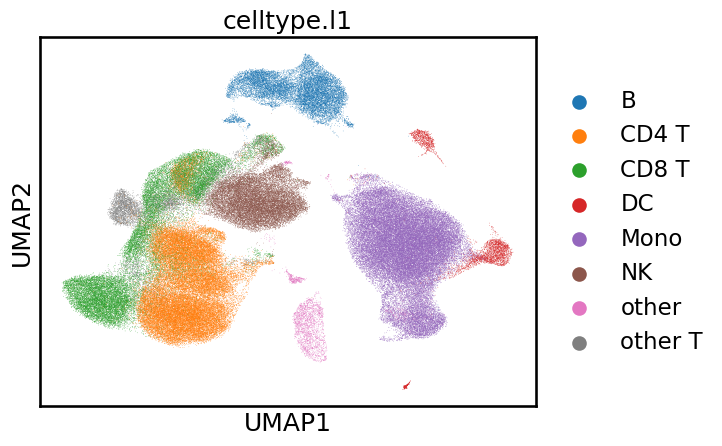

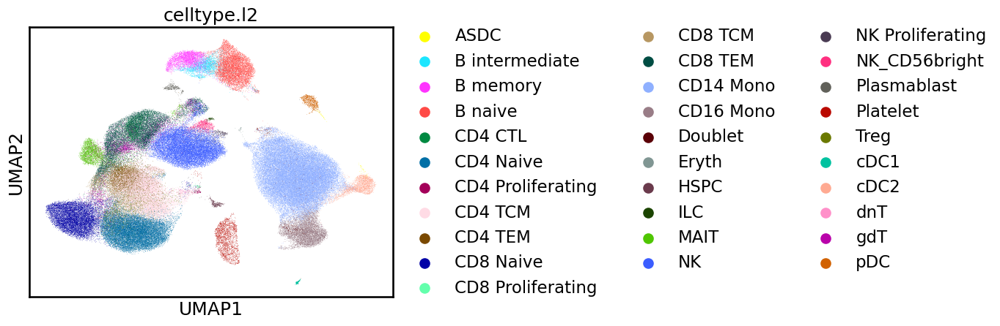

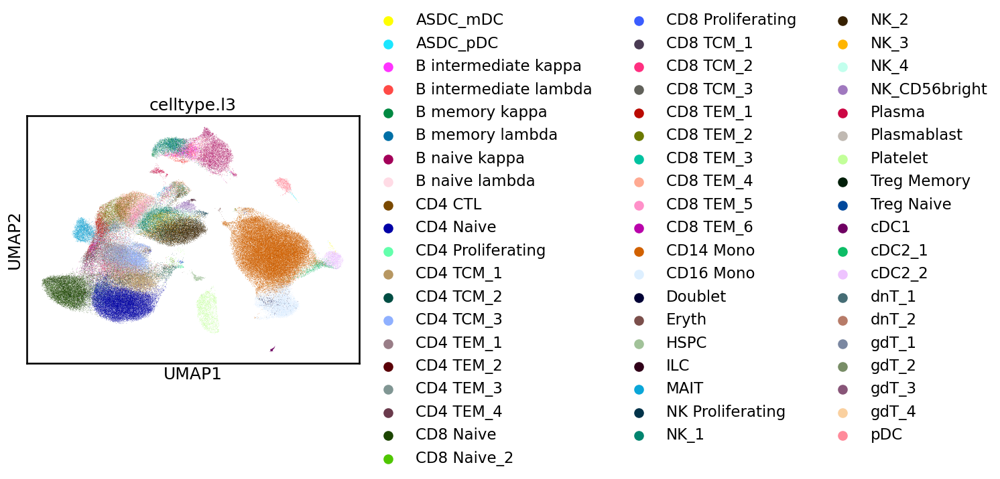

In [60]:
sc.pl.umap(adata_angl, color=['celltype.l1'])
sc.pl.umap(adata_angl, color=['celltype.l2'])
sc.pl.umap(adata_angl, color=['celltype.l3'])

In [55]:
adata_hvg = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/hvg/scvi.h5ad")
adata_hvg

AnnData object with n_obs × n_vars = 161764 × 2000
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'X_name', '_scvi_manager_uuid', '_scvi_uuid', 'celltype.l3_colors', 'hvg', 'log1p', 'pca'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb', 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'logcounts'

In [56]:
sc.pp.neighbors(adata_hvg,
                n_neighbors=15,
                use_rep = 'X_emb')
sc.tl.umap(adata_hvg)

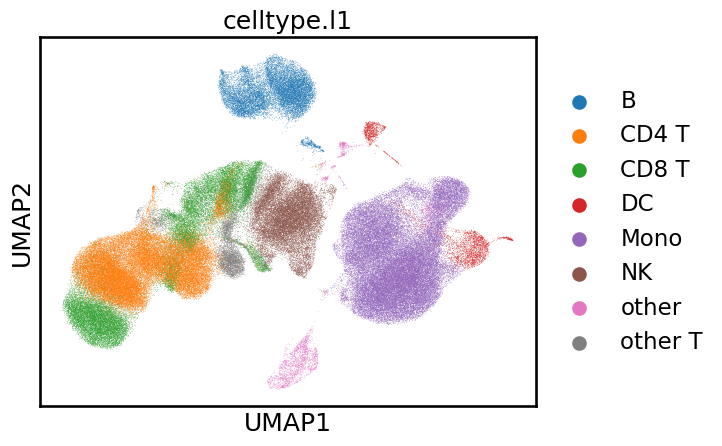

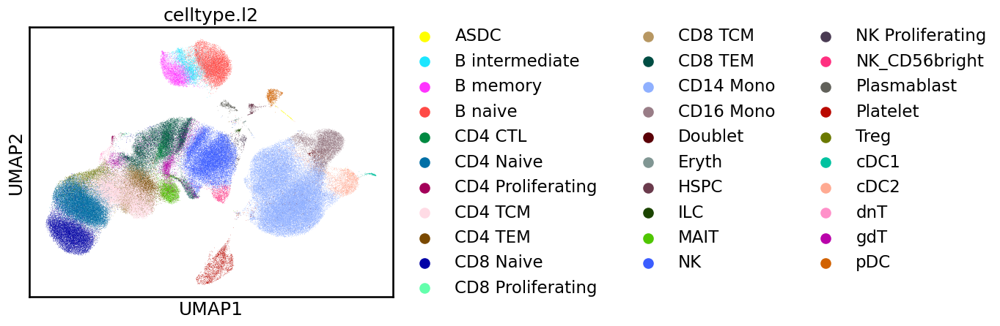

In [57]:
sc.pl.umap(adata_hvg, color=['celltype.l1'])
sc.pl.umap(adata_hvg, color=['celltype.l2'])

# Re-integrate T-cells

## start from original data with all genes

In [26]:
adata = sc.read_h5ad("/local/Projects/AAkalin_Neuroblastoma/data/PBMC/Hao_Satija_Cell_2021_PBMC_SeuratPaper/pbmc_multimodal.h5ad")
adata

AnnData object with n_obs × n_vars = 161764 × 20729
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident'
    uns: 'X_name'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP'
    layers: 'logcounts'

## filter adata

In [27]:
tcell_adata = adata[(adata.obs["celltype.l1"] == "CD8 T") | (adata.obs["celltype.l1"] == "CD4 T")].copy()

In [37]:
tcell_adata_cd4 = tcell_adata[tcell_adata.obs["celltype.l1"] == "CD4 T"].copy()
mito_genes = tcell_adata_cd4.var_names.str.startswith('MT-')
hb_genes = tcell_adata_cd4.var_names.str.contains('^HB[^(P)]')  # annotate the group of hemoglobin genes as 'hb'
malat1 = tcell_adata_cd4.var_names.str.startswith('MALAT1') # annotate the MALAT1 gene
ribo_genes = tcell_adata_cd4.var_names.str.startswith(("RPS","RPL"))

from functools import reduce
remove = reduce(np.add, (mito_genes, malat1, hb_genes, ribo_genes))
keep = np.invert(remove)
tcell_adata_cd4 = tcell_adata_cd4[:, keep]

tcell_adata_cd4.var["gene_symbol"] = tcell_adata_cd4.var.index
del tcell_adata_cd4.uns

tcell_adata_cd4.write_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells.h5ad")

/tmp/ipykernel_3689512/144588996.py:12: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  tcell_adata_cd4.var["gene_symbol"] = tcell_adata_cd4.var.index


In [5]:
tcell_adata.obs['orig.ident'].value_counts()

orig.ident
P8_3    4533
P8_0    3700
P8_7    3643
P7_3    3483
P1_3    3415
P1_0    3353
P2_3    3352
P4_3    3281
P2_0    3061
P1_7    2965
P6_3    2922
P2_7    2801
P5_7    2742
P7_7    2696
P3_7    2535
P7_0    2482
P4_0    2437
P4_7    2434
P5_0    2057
P3_0    1949
P3_3    1860
P5_3    1731
P6_7    1620
P6_0    1418
Name: count, dtype: int64

In [13]:
tcell_adata.var["gene_symbol"] = adata.var.index
del tcell_adata.uns
tcell_adata.write_h5ad("/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc2.h5ad")

In [15]:
tcell_adata

AnnData object with n_obs × n_vars = 66470 × 20729
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident'
    var: 'gene_symbol'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP'
    layers: 'logcounts'

# re-integration was performed using the python scripts from the pipeline

# load integrated data

In [20]:
adata_hvg = sc.read_h5ad("/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc_hvg_scvi.h5ad")
print(adata_hvg)
adata_angl = sc.read_h5ad("/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc_angl_scvi.h5ad")
print(adata_angl)
adata_diem = sc.read_h5ad("/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc_angl_diem_scvi.h5ad")
print(adata_diem)

AnnData object with n_obs × n_vars = 66470 × 2000
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbol'
    uns: 'X_name', '_scvi_manager_uuid', '_scvi_uuid', 'log1p'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb'
    layers: 'counts', 'logcounts'
AnnData object with n_obs × n_vars = 66470 × 2000
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbol'
    uns: 'X_name', '_scvi_manager_uuid', '_scvi_uuid', 'log1p'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb'
    layers: 'counts', 'logcounts'
AnnData object with n_obs × n_vars = 66470 × 1252
    obs: 'nCount_ADT', 'nFeature_ADT', 'nC

## Plot UMAPs

In [4]:
n_neighbors = 15
sc.pp.neighbors(adata_hvg,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(adata_hvg)

2024-09-17 11:50:05.030840: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-17 11:50:05.081901: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-17 11:50:05.097565: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-17 11:50:07.923605: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


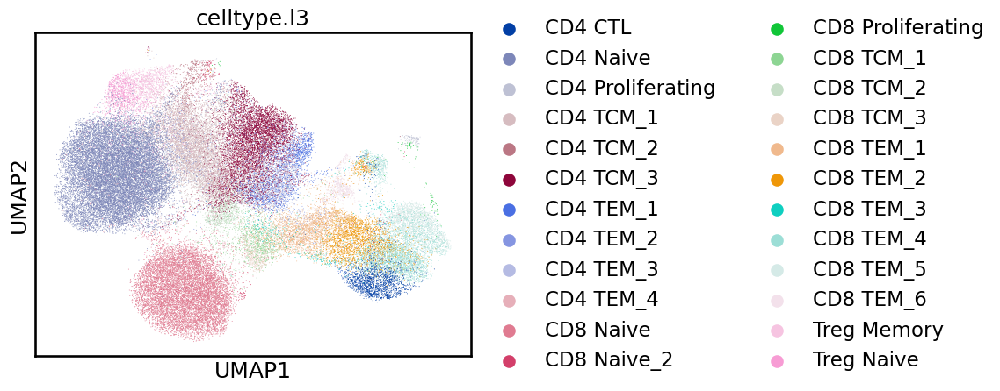

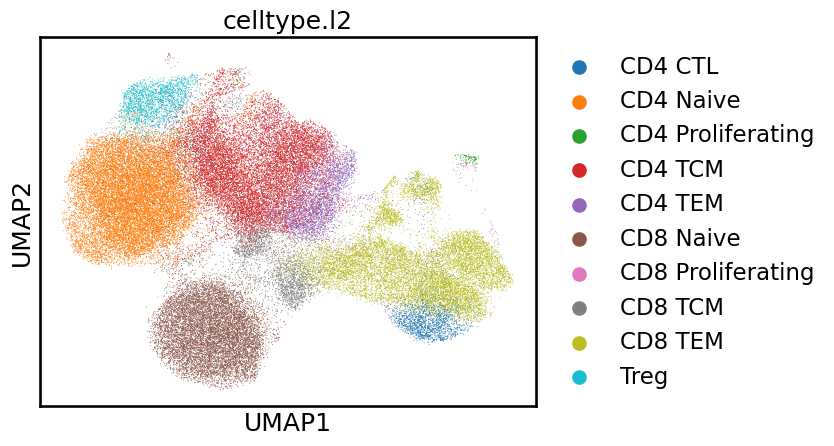

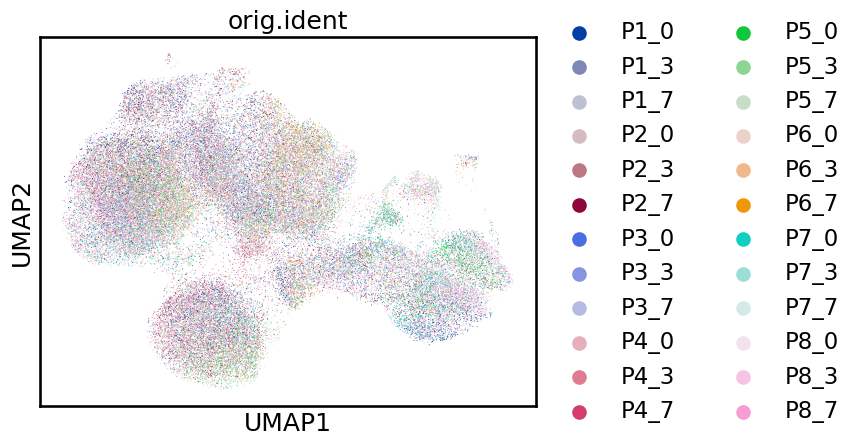

In [5]:
sc.pl.umap(adata_hvg, color=['celltype.l3'])
sc.pl.umap(adata_hvg, color=['celltype.l2'])
sc.pl.umap(adata_hvg, color=['orig.ident'])

In [6]:
sc.pp.neighbors(adata_angl,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(adata_angl)

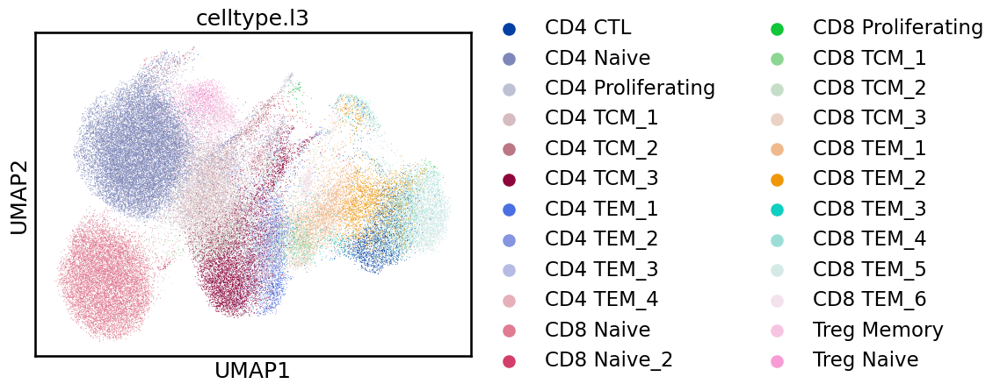

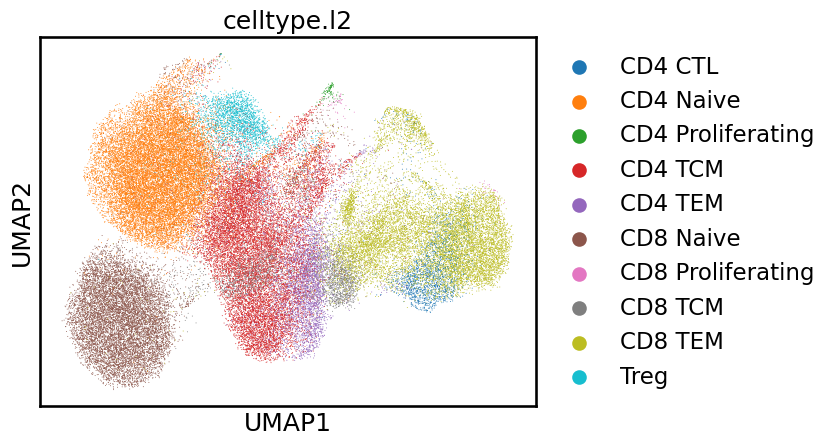

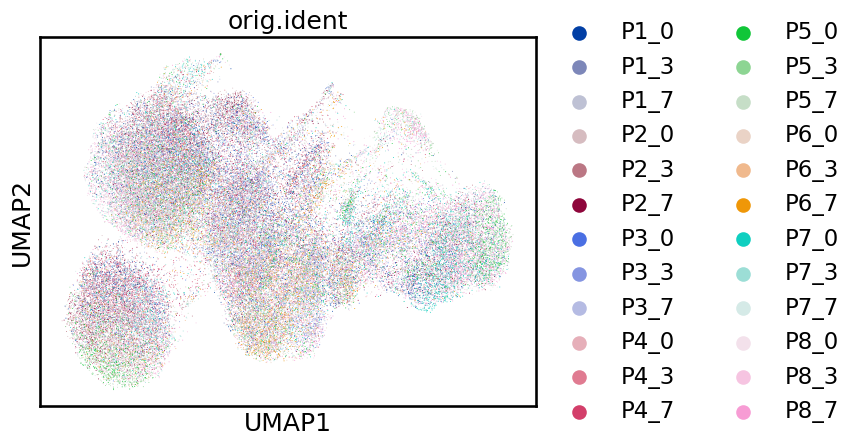

In [7]:

sc.pl.umap(adata_angl, color=['celltype.l3'])
sc.pl.umap(adata_angl, color=['celltype.l2'])
sc.pl.umap(adata_angl, color=['orig.ident'])

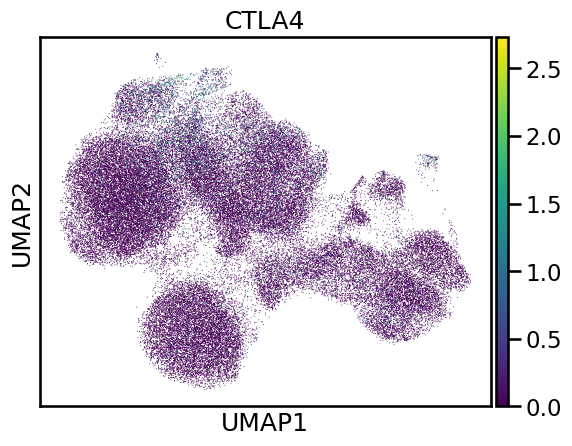

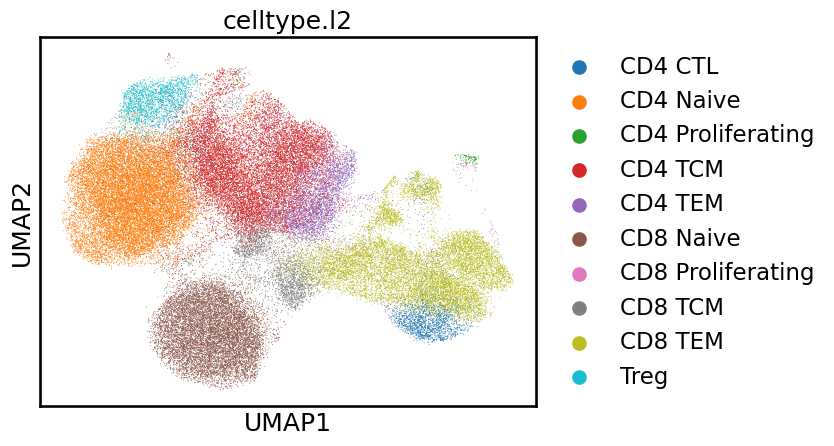

In [8]:
granzymes = ["GZMA", "GZMB", "GZMK"]
#plot 
sc.pl.umap(adata_hvg, color="CTLA4")
sc.pl.umap(adata_hvg, color="celltype.l2")

In [21]:
sc.pp.neighbors(adata_diem,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(adata_diem)

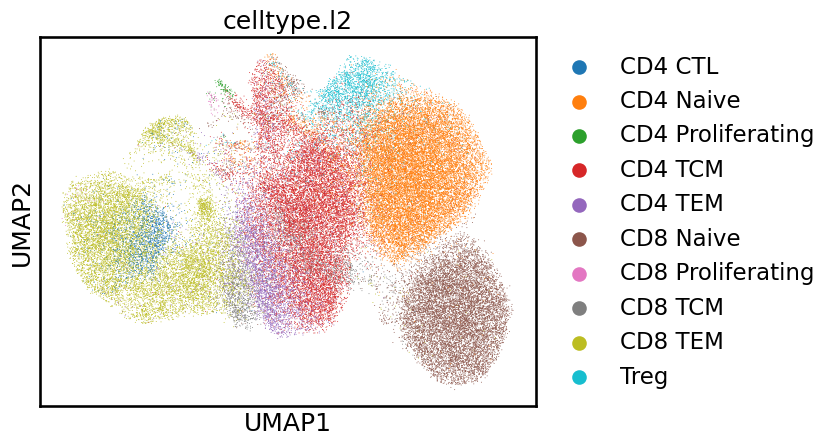

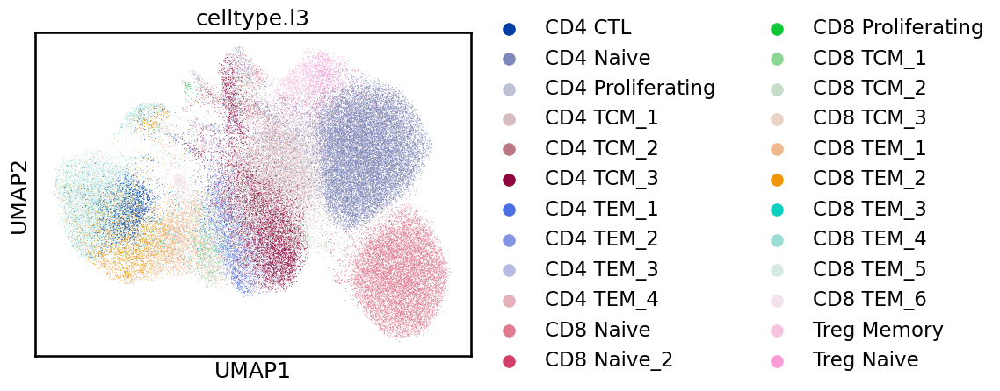

In [23]:
sc.pl.umap(adata_diem, color=['celltype.l2'])
sc.pl.umap(adata_diem, color=['celltype.l3'])

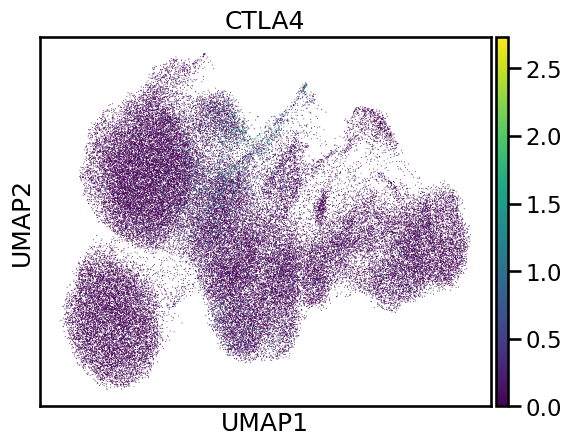

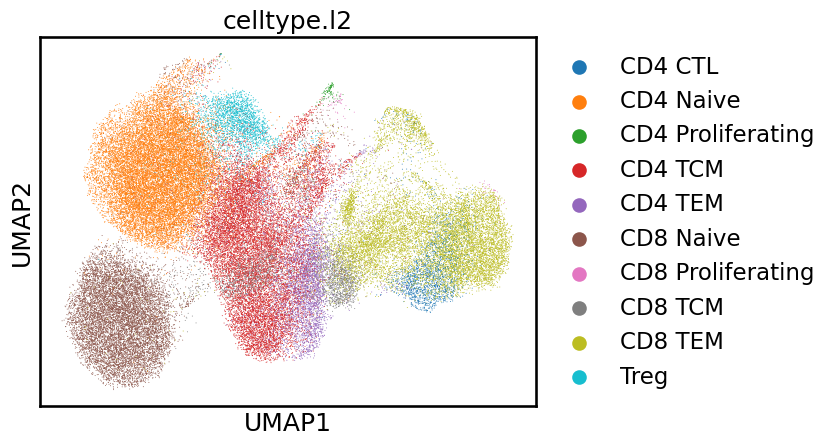

In [9]:
granzymes = ["GZMA", "GZMB", "GZMK"]
#plot 
sc.pl.umap(adata_angl, color="CTLA4")
sc.pl.umap(adata_angl, color="celltype.l2")

In [12]:
adata_angl.obsm

AxisArrays with keys: PCA, SPCA, UMAP, WNN.UMAP, X_emb, X_umap

In [13]:

adata_angl.obsm["orig_pca"] = adata_angl.obsm["PCA"]
adata_angl.obsm["X_pca"] = adata_angl.obsm["X_emb"]


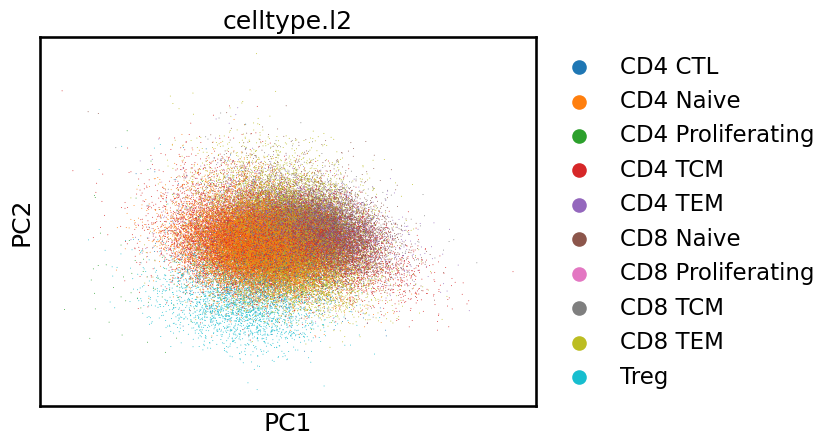

In [18]:
sc.pl.pca(adata_angl, color="celltype.l2")

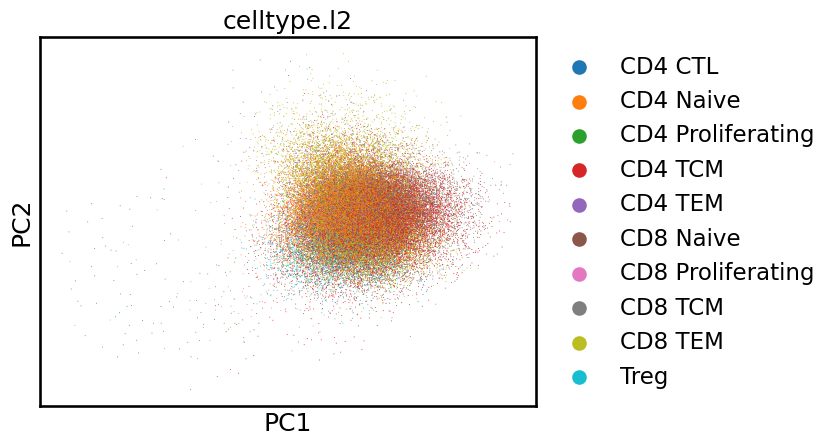

In [19]:
adata_hvg.obsm["orig_pca"] = adata_hvg.obsm["PCA"]
adata_hvg.obsm["X_pca"] = adata_hvg.obsm["X_emb"]

sc.pl.pca(adata_hvg, color="celltype.l2")

# load metrics

In [58]:
paths = [
    "/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc_angl_rho_metrics.tsv",
    "/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc_angl_diem_metrics.tsv",
    "/home/akollot/projects/CRC1588/dataset_integration/anglemania_benchmark/output/tcells_hao_pbmc_hvg_metrics.tsv"
]
df = pd.concat([pd.read_csv(path, sep="\t") for path in paths])
df.head()

,Unnamed: 0,NMI_cluster/label,ARI_cluster/label,ASW_label,ASW_label/batch,PCR_batch,cell_cycle_conservation,isolated_label_F1,isolated_label_silhouette,graph_conn,kBET,iLISI,cLISI,hvg_overlap,trajectory,sample,integration_method,gene_selection
0,0,0.613150,0.637655,0.518868,0.861207,0.677216,NaN,0.182661,0.515719,0.903402,0.748880,0.267802,0.974628,NaN,NaN,tcells_hao_pbmc,scvi,angl
0,0,0.590743,0.562472,0.512549,0.864554,0.654073,NaN,0.078805,0.514932,0.895527,0.749204,0.269694,0.969942,NaN,NaN,tcells_hao_pbmc,scvi,angl
0,0,0.649008,0.650012,0.528996,0.866470,0.684767,NaN,0.210704,0.521428,0.912804,0.764504,0.273125,0.979731,NaN,NaN,tcells_hao_pbmc,scvi,hvg
0,0,0.642250,0.672882,0.543872,0.900093,0.748375,NaN,0.868085,0.708987,0.981698,0.694343,0.299326,0.956869,NaN,NaN,cd4_tcells,scvi,angl


# only CD4 cells

In [17]:
adata_angl_diem = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_diem_scvi.h5ad")
print(adata_angl_diem)
adata_hvg = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_hvg_scvi.h5ad")
print(adata_hvg)

AnnData object with n_obs × n_vars = 41001 × 1363
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'log1p'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb'
    layers: 'counts', 'logcounts'
AnnData object with n_obs × n_vars = 41001 × 2000
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'log1p'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb'
    layers: 'counts', 'logcounts'


In [35]:
n_neighbors = 15
min_dist = 0.1
spread = 1
sc.pp.neighbors(adata_angl_diem,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(adata_angl_diem,
           min_dist = min_dist,
           spread = spread)

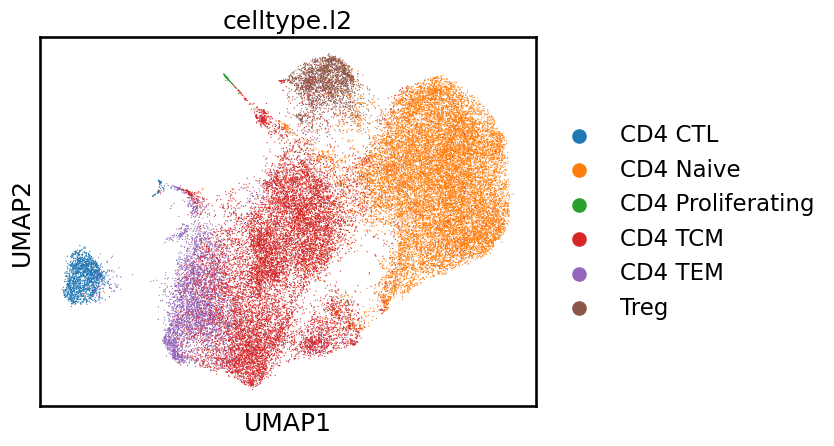

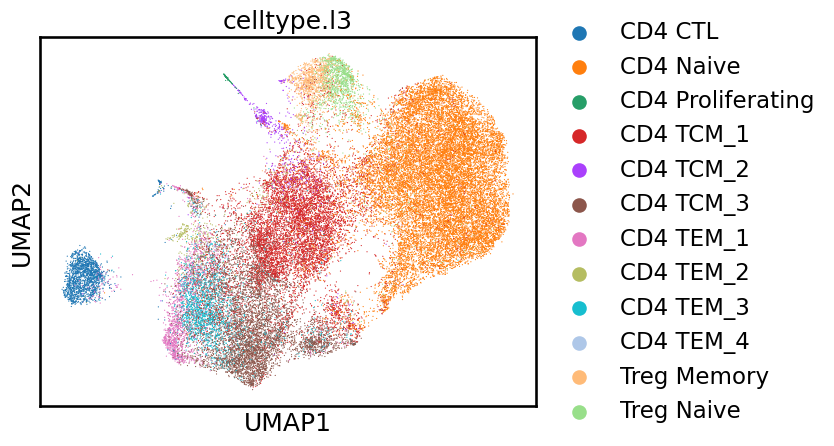

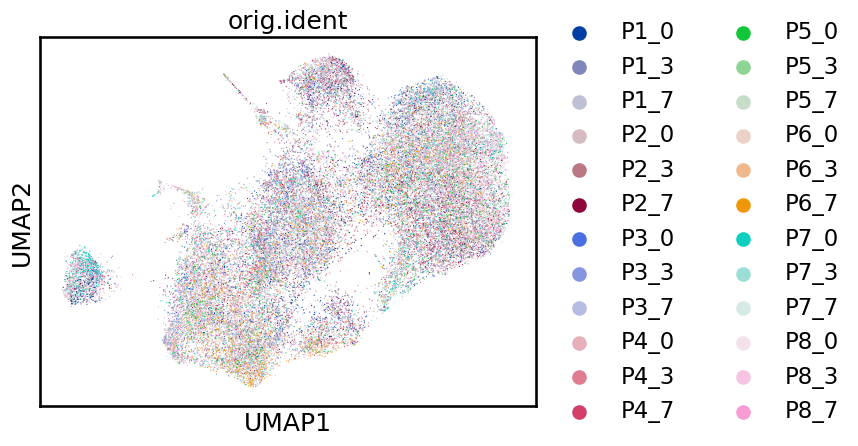

In [36]:
sc.pl.umap(adata_angl_diem, color=['celltype.l2'])
sc.pl.umap(adata_angl_diem, color=['celltype.l3'])
sc.pl.umap(adata_angl_diem, color=['orig.ident'])

In [37]:
sc.pp.neighbors(adata_hvg,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(adata_hvg,
           min_dist = min_dist,
           spread = spread)

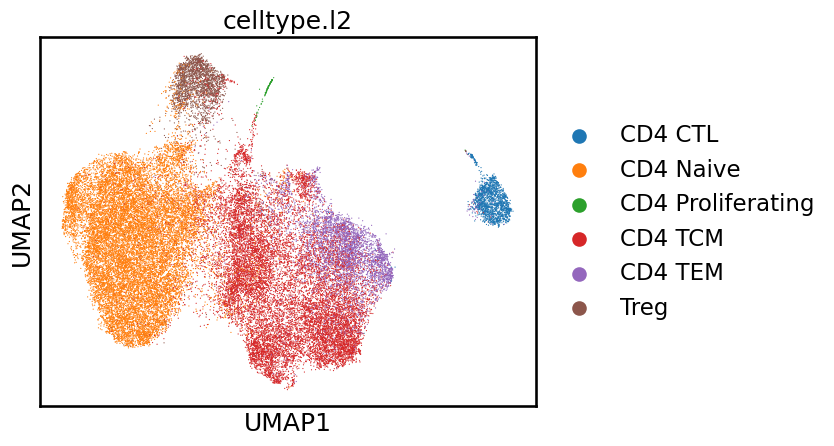

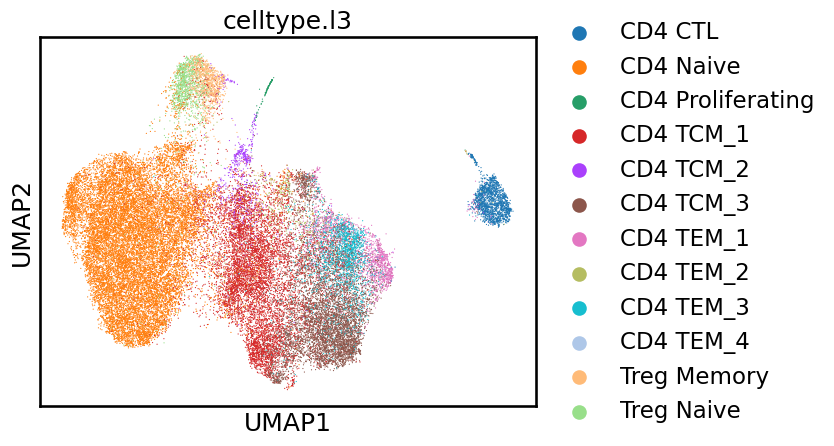

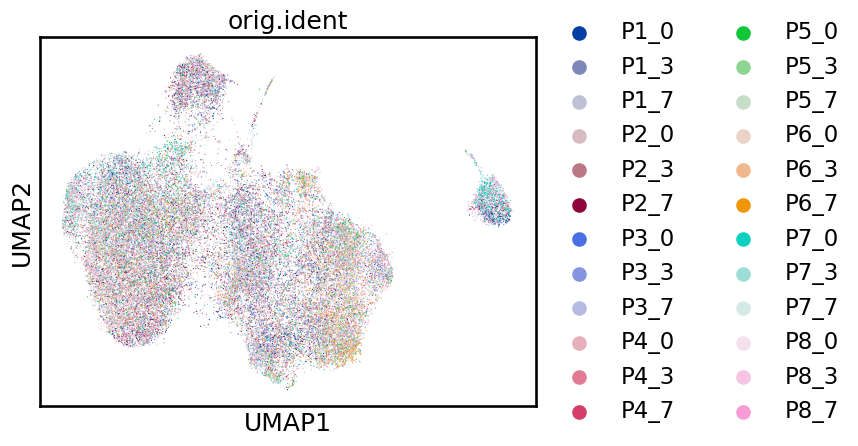

In [38]:
sc.pl.umap(adata_hvg, color=['celltype.l2'])
sc.pl.umap(adata_hvg, color=['celltype.l3'])
sc.pl.umap(adata_hvg, color=['orig.ident'])

In [39]:
angl_genes = pd.read_csv("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_diem.tsv", sep="\t")
hvgs = pd.read_csv("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_hvg.tsv", sep="\t")
# check intersection size
angl_genes["hgnc_symbol"].isin(hvgs["hgnc_symbol"]).sum()

567

In [40]:
test = sc.read_h5ad("/local/Projects/AAkalin_Neuroblastoma/Results/Patel_Dyer_bioRxiv_2024_NB/cancer_cells/SEACells/preprocessed/HTAPP-100-SMP-1_TST_channel1_preprocessed.h5ad")
test.obs.head()

,orig.ident,channel,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,n_genes,n_counts,sample,SEACell
index,,,,,,,,,,,,
HTAPP-100-SMP-1_TST_channel1-AAATGGACACGATAGG,HTAPP-100-SMP-1,HTAPP-100-SMP-1_TST_channel1,9246,4448.294373,9.440997,0.212239,8.955314,0.201320,9246,4448.294373,HTAPP-100-SMP-1_TST_channel1,SEACell-6
HTAPP-100-SMP-1_TST_channel1-CAAGACTCACGGTGTC,HTAPP-100-SMP-1,HTAPP-100-SMP-1_TST_channel1,11830,5540.949848,0.118049,0.002130,19.731776,0.356108,11830,5540.949848,HTAPP-100-SMP-1_TST_channel1,SEACell-4
HTAPP-100-SMP-1_TST_channel1-TCTATACCAGCAGACA,HTAPP-100-SMP-1,HTAPP-100-SMP-1_TST_channel1,9795,4503.545861,0.000000,0.000000,9.746091,0.216409,9795,4503.545861,HTAPP-100-SMP-1_TST_channel1,SEACell-5
HTAPP-100-SMP-1_TST_channel1-CACTAAGTCTCGACGG,HTAPP-100-SMP-1,HTAPP-100-SMP-1_TST_channel1,9160,4289.535010,43.806114,1.021232,11.118393,0.259198,9160,4289.535010,HTAPP-100-SMP-1_TST_channel1,SEACell-13
HTAPP-100-SMP-1_TST_channel1-GGCTGTGCACCTTCCA,HTAPP-100-SMP-1,HTAPP-100-SMP-1_TST_channel1,8616,4374.342065,27.151959,0.620710,7.319558,0.167329,8616,4374.342065,HTAPP-100-SMP-1_TST_channel1,SEACell-6


## Metrics CD4 T Cells


In [59]:
paths = ["/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_diem_metrics.tsv",
         "/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_rho_metrics.tsv",
         "/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_hvg_metrics.tsv",
         "/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_spearman_t3_metrics.tsv"
]

metrics = pd.concat([pd.read_csv(path, sep="\t") for path in paths], axis = 0).reset_index(drop = True)
metrics["gene_selection_refined"] = pd.Series({0: "diem", 1: "pearson", 2: "hvg", 3 : "spearman"})
metrics


,Unnamed: 0,NMI_cluster/label,ARI_cluster/label,ASW_label,ASW_label/batch,PCR_batch,cell_cycle_conservation,isolated_label_F1,isolated_label_silhouette,graph_conn,kBET,iLISI,cLISI,hvg_overlap,trajectory,sample,integration_method,gene_selection,gene_selection_refined
0,0,0.657672,0.694664,0.552899,0.898860,0.753643,NaN,0.848980,0.724044,0.983379,0.780002,0.296316,0.968952,NaN,NaN,cd4_tcells,scvi,angl,diem
1,0,0.632797,0.655314,0.549488,0.899003,0.770456,NaN,0.886957,0.720673,0.987806,0.777052,0.299488,0.967514,NaN,NaN,cd4_tcells,scvi,angl,pearson
2,0,0.695338,0.700062,0.552697,0.894751,0.791203,NaN,0.930693,0.700647,0.991787,0.752974,0.306788,0.968211,NaN,NaN,cd4_tcells,scvi,hvg,hvg
3,0,0.642250,0.672882,0.543872,0.900093,0.748375,NaN,0.868085,0.708987,0.981698,0.694343,0.299326,0.956869,NaN,NaN,cd4_tcells,scvi,angl,spearman


# angl more stringent integration threshold

In [42]:
adata_angl = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_rho_t4_scvi.h5ad")
adata_angl

AnnData object with n_obs × n_vars = 41001 × 185
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'log1p'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb'
    layers: 'counts', 'logcounts'

In [43]:
n_neighbors = 15
min_dist = 0.1
spread = 1
sc.pp.neighbors(adata_angl,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(adata_angl,
           min_dist = min_dist,
           spread = spread)

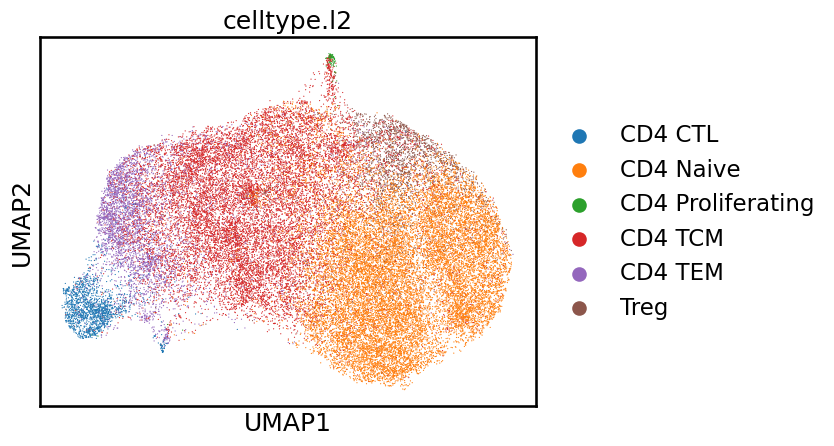

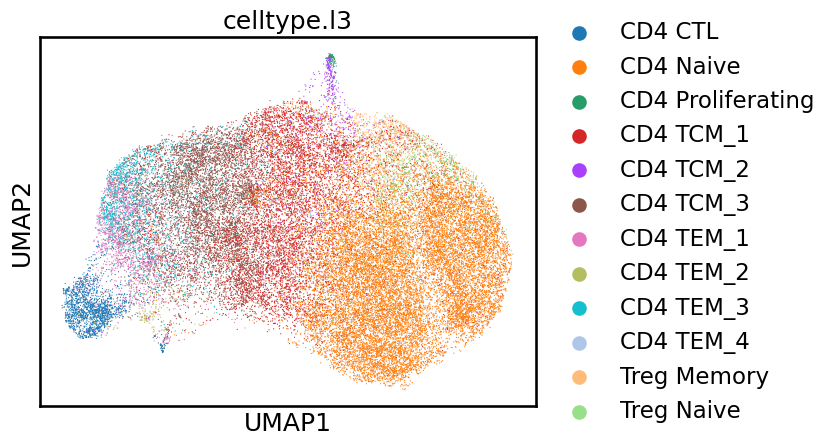

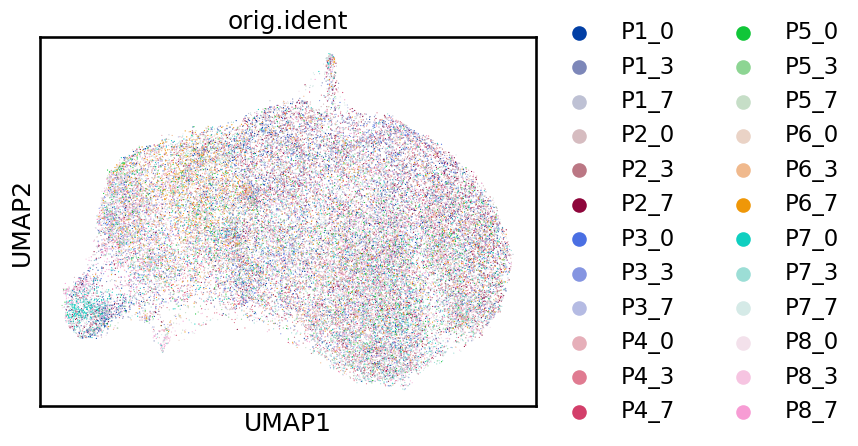

In [51]:
sc.pl.umap(adata_angl, color=['celltype.l2'])
sc.pl.umap(adata_angl, color=['celltype.l3'])
sc.pl.umap(adata_angl, color=['orig.ident'])

# CITE-seq data

In [81]:
cite = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/data/Ubreva_Ballestar_2022_NatComm_CVID_CITE-seq/adata_act_PBMCs_validation_cohort_for_download.h5ad")
cite

/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/anndata/_io/specs/registry.py:256: OldFormatWarning: Element '/X' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=iospec)
/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/anndata/_io/utils.py:207: OldFormatWarning: Element '/obs/__categories/batch' was written without encoding metadata.
  return func(*args, **kwargs)
/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/anndata/_io/utils.py:207: OldFormatWarning: Element '/obs/batch' was written without encoding metadata.
  return func(*args, **kwargs)
/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/anndata/_io/utils.py:207: OldFormatWarning: Element '/obs/bh_pval' was written without encoding metadata.
  return func(*args, **kwargs)
/home/akollot/miniforge3/envs/angl_BM2/lib/python3.11/site-packages/anndata/_io/utils.py:207: OldFormatWarning: Element '/obs/n_counts' w

AnnData object with n_obs × n_vars = 95064 × 2627
    obs: 'batch', 'bh_pval', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'cell_type', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'barcode', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'CVID_class_Freiburg', 'CVID_class_Euroclass'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'ge

In [108]:
cite.var

,gene_ids-0,feature_types-0,genome-0,n_cells-0,gene_ids-1,feature_types-1,genome-1,n_cells-1,gene_ids-2,feature_types-2,...,gene_ids-8,feature_types-8,genome-8,n_cells-8,highly_variable,means,dispersions,dispersions_norm,mean,std
index,,,,,,,,,,,,,,,,,,,,,
RP11-206L10.9,ENSG00000237491,Gene Expression,GRCh38,48.0,ENSG00000237491,Gene Expression,GRCh38,71.0,ENSG00000237491,Gene Expression,...,ENSG00000237491,Gene Expression,GRCh38,280.0,True,0.013244,1.709739,0.527835,0.005555,0.088009
LINC00115,ENSG00000225880,Gene Expression,GRCh38,150.0,ENSG00000225880,Gene Expression,GRCh38,183.0,ENSG00000225880,Gene Expression,...,ENSG00000225880,Gene Expression,GRCh38,251.0,True,0.023928,1.749386,0.596097,0.009663,0.118879
RP5-832C2.5,ENSG00000215014,Gene Expression,GRCh38,187.0,ENSG00000215014,Gene Expression,GRCh38,179.0,ENSG00000215014,Gene Expression,...,ENSG00000215014,Gene Expression,GRCh38,638.0,True,0.030945,1.766629,0.625786,0.012506,0.134938
MIB2,ENSG00000197530,Gene Expression,GRCh38,320.0,ENSG00000197530,Gene Expression,GRCh38,295.0,ENSG00000197530,Gene Expression,...,ENSG00000197530,Gene Expression,GRCh38,1469.0,True,0.083040,1.726012,0.555853,0.034441,0.223448
MMP23B,ENSG00000189409,Gene Expression,GRCh38,69.0,ENSG00000189409,Gene Expression,GRCh38,54.0,ENSG00000189409,Gene Expression,...,ENSG00000189409,Gene Expression,GRCh38,92.0,True,0.015586,2.077800,1.161552,0.005066,0.096035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NLRP2-1,C1048,Antibody Capture,,16404.0,C1048,Antibody Capture,,18045.0,C1048,Antibody Capture,...,C1048,Antibody Capture,,29694.0,True,2.014136,5.165532,1.510417,0.967158,1.334867
Podocalyxin,C1051,Antibody Capture,,10779.0,C1051,Antibody Capture,,11957.0,C1051,Antibody Capture,...,C1051,Antibody Capture,,26289.0,True,0.742882,2.721051,1.715672,0.289290,0.708226
anti-c-Met,C1055,Antibody Capture,,14180.0,C1055,Antibody Capture,,15507.0,C1055,Antibody Capture,...,C1055,Antibody Capture,,29280.0,True,1.253471,4.290861,2.399413,0.507910,0.977062


In [99]:
adata_raw = ad.AnnData(cite.raw.X.copy(), var = cite.raw.var.copy())
adata_raw

AnnData object with n_obs × n_vars = 112463 × 21749
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

array([[1., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]], dtype=float32)

In [102]:
cite.obs_names

Index(['TGGCGCAGTCCGAACC-1', 'GTATTCTTCAACACGT-1', 'CTACATTCATTAACCG-1',
       'GATCAGTAGAGGACGG-1', 'GACTGCGCATGAACCT-1', 'TACTCGCGTTTGCATG-1',
       'GGGCATCGTCCCTTGT-1-1', 'CGCCAAGGTAGCTCCG-1', 'ACATGGTAGCTGATAA-1',
       'CTTACCGTCGATCCCT-1',
       ...
       'TCAGGATAGGGTGTTG-1', 'CTAGTGATCGATAGAA-1', 'TAGCCGGTCTTGTCAT-1',
       'GAAATGAGTGCACGAA-1', 'CGGAGTCGTGTGACCC-1', 'CAGCTAACAGGATTGG-1',
       'TTTGTCACATCCGCGA-1', 'TCGGTAACAGGTCCAC-1', 'CACACAAAGTTACGGG-1',
       'CAAGTTGCAGGATTGG-1'],
      dtype='object', name='index', length=95064)

In [100]:
adata_raw = adata_raw[cite.obs_names]

KeyError: "Values ['TGGCGCAGTCCGAACC-1', 'GTATTCTTCAACACGT-1', 'CTACATTCATTAACCG-1', 'GATCAGTAGAGGACGG-1', 'GACTGCGCATGAACCT-1', 'TACTCGCGTTTGCATG-1', 'GGGCATCGTCCCTTGT-1-1', 'CGCCAAGGTAGCTCCG-1', 'ACATGGTAGCTGATAA-1', 'CTTACCGTCGATCCCT-1', 'ACAGCTACACAACGTT-1', 'GTACGTATCACGCGGT-1', 'CTACATTTCATTATCC-1', 'AAGGAGCGTTAAAGTG-1', 'CCGTACTTCGGCTTGG-1', 'GATTCAGCAAACGCGA-1', 'CAGGTGCGTCCCGACA-1-1', 'GATCGCGAGATGGCGT-1', 'TTTCCTCCAATCTGCA-1', 'GGGAATGCACTGTTAG-1-1', 'GTATTCTTCGCAGGCT-1', 'GGGATGATCATGGTCA-1', 'CCTTTCTCACTGTTAG-1', 'TTCCCAGAGTTGTCGT-1', 'ACATCAGTCGGCCGAT-1', 'GGTGAAGAGAATAGGG-1', 'CCTTCGACAAGGTGTG-1', 'ATTATCCGTTCGCGAC-1', 'ACCCACTAGGTGACCA-1', 'GACGTGCTCTCTGCTG-1-1', 'GATTCAGAGCACACAG-1', 'TGAAAGAAGCTACCGC-1', 'TCAACGATCTGCGGCA-1', 'CAACCAAGTGAGGCTA-1-1', 'AGGGTGAGTGGGTCAA-1', 'ATCCACCTCCTGTACC-1', 'TGCTACCTCTCTTATG-1', 'GCATGATTCAATCACG-1', 'CAGCGACCACAGAGGT-1', 'TGCCCATTCTCACATT-1', 'CACACAAAGTCCGTAT-1', 'CGATTGACACAACTGT-1', 'GACTAACCAAGTTCTG-1', 'GAGCAGATCGCGCCAA-1', 'AGAGCGAAGAGTCTGG-1', 'ATGAGGGGTAAGCACG-1', 'GTCGGGTTCTCTAAGG-1', 'CCTACACGTTGAACTC-1', 'CTACCCAGTGGACGAT-1', 'CATCGGGGTATAATGG-1', 'ACTTGTTTCTTCGGTC-1', 'ACACCGGCACATGGGA-1', 'CATCAGAGTTACGTCA-1', 'CTCTAATCATCCGGGT-1', 'CGAATGTTCTGGAGCC-1', 'ATCATCTTCTTGTACT-1', 'GATCTAGGTACGACCC-1', 'ACATACGCATAGGATA-1', 'CGACTTCGTGTGGCTC-1-1', 'CACTCCACACAACTGT-1', 'CCGGTAGCAATGGATA-1', 'TCATTTGGTTCGTTGA-1', 'TACCTTACACAGCCCA-1', 'GTATTCTTCAGCAACT-1', 'CGCTTCATCAGCTCGG-1-1', 'GGTATTGTCTTCGGTC-1', 'GCACTCTTCATGCAAC-1', 'TTGCCGTGTCTGCGGT-1-1', 'CTAAGACCAATGAAAC-1', 'CTCGGAGGTATTAGCC-1', 'CTACATTGTGTATGGG-1', 'CATATTCGTGTCGCTG-1', 'ACGCCAGAGAGACGAA-1', 'GTGCTTCCAAGTAGTA-1-1', 'GGCGACTAGCCACCTG-1', 'TGGCGCATCGTTACGA-1', 'CCTTACGTCCGCAGTG-1', 'CACAAACGTAAGTTCC-1', 'ACATACGGTTACGACT-1', 'ATTCTACGTGCCTGTG-1', 'CAGCTAAAGGCTAGGT-1', 'CATCAGAGTGACTCAT-1', 'ATCCGAAAGTACATGA-1-1', 'GACGCGTGTCGACTAT-1', 'CGCCAAGAGGGATGGG-1', 'CCTACACAGTCAAGGC-1', 'TTGCGTCGTCAAACTC-1', 'ATGCGATCATGCCCGA-1', 'GGGTTGCCAATCGGTT-1', 'CAAGTTGGTATATGGA-1', 'TCGTAGACACCCAGTG-1-1', 'CACACCTGTTCATGGT-1', 'GTATTCTAGCCACGCT-1', 'CGATTGATCTGCCAGG-1-1', 'CGAACATGTCTCAACA-1', 'GATGAAAGTCGGCATC-1', 'CTGTGCTTCCGAATGT-1', 'GCTGCGATCTTGTACT-1', 'AAGGCAGTCGTAGATC-1', 'GACCAATGTCTTCGTC-1', 'CAACCAAGTCACTTCC-1', 'GACAGAGGTCTAAAGA-1', 'CGGACGTCACTAAGTC-1-1', 'ATTATCCAGCTAGCCC-1', 'ACCCACTAGTGGAGTC-1', 'GGGTTGCGTCTCACCT-1', 'AGCTCCTTCCCTTGTG-1', 'CAACCAATCGGCCGAT-1', 'CCGGGATAGATGTCGG-1', 'ATCATCTGTCCAGTAT-1', 'CATGACATCAGTCAGT-1', 'GTCTCGTCAGCTGCTG-1', 'GGGCACTTCAACCAAC-1', 'AGATTGCAGTGGTAGC-1', 'TTTGTCAGTAATCACC-1', 'ACGTCAAGTTCAGGCC-1', 'AAGTCTGAGACCACGA-1', 'ATTGGACTCTTGTCAT-1', 'TGACTTTTCGTATCAG-1', 'CGGACTGAGCTGATAA-1-1', 'CGTCACTGTAGCGTAG-1', 'CGCGGTAGTGAGGGTT-1', 'ACACTGAGTACCCAAT-1', 'AGAGTGGAGGACAGCT-1', 'TGCCAAAAGAAGCCCA-1', 'CCAGCGACATGCAATC-1', 'AACACGTTCAACCAAC-1', 'CTAGTGATCCACGAAT-1', 'TCTATTGAGGTGTTAA-1', 'GACACGCAGCGATTCT-1', 'AGCTCTCAGTACACCT-1', 'TACTCGCGTCCGCTGA-1', 'TCATTTGTCTGGCGAC-1', 'TCATTTGAGCCCGAAA-1', 'GCATGTACATTGGGCC-1', 'CGGAGTCGTGCCTTGG-1', 'CCTCTGATCGGCATCG-1', 'TACTTACTCAAAGTAG-1', 'TAAGCGTGTCGTGGCT-1', 'CGTCAGGGTTAGATGA-1', 'CCTTCCCAGTGGGATC-1', 'CGGACGTAGTGTACGG-1', 'AGCGTATCATGCCTAA-1', 'CAAGATCTCCTGCCAT-1', 'TACCTATTCCGCAGTG-1', 'TGAGCCGGTATATGGA-1', 'TCACAAGTCCAAATGC-1', 'CACCTTGTCCTCTAGC-1-1', 'GTGCGGTCACATCCAA-1', 'GCGCAGTCATCTCCCA-1', 'TAAACCGGTTGGTAAA-1', 'CAGCTAATCGTCTGAA-1', 'CCACCTACATCACCCT-1', 'TACACGATCTGTCCGT-1', 'CTCATTACAGACAAGC-1', 'CACAAACGTCGGCACT-1', 'AGAGTGGCATTCACTT-1', 'CATTATCGTATGAATG-1', 'GGGACCTCATCACGTA-1-1', 'ACGAGCCTCTGCTGCT-1', 'TCTGGAAGTAGGGACT-1', 'GTCTCGTGTAACGTTC-1', 'ATAACGCAGCTGAAAT-1-1', 'GCAGCCAGTAGTGAAT-1', 'TGCGCAGTCCCTTGTG-1', 'TAAGTGCAGGTGCTTT-1-1', 'TACCTATCAAGCTGGA-1', 'GGATTACAGATGCGAC-1-1', 'CATCAAGAGCTGAACG-1', 'TGACTTTTCGTAGATC-1', 'ACTATCTAGGCAGGTT-1', 'GATCGTAAGATGTGTA-1', 'TAGCCGGTCTTCTGGC-1', 'AGGTCCGAGCCGGTAA-1', 'GCTCCTAAGACTCGGA-1', 'AGGCCACTCAGGTAAA-1-1', 'GCTCTGTCACTGCCAG-1', 'GCCAAATTCTTCATGT-1', 'CAGGTGCGTCATATGC-1', 'TCGGGACGTGTGGTTT-1', 'GTCATTTTCCACGTTC-1', 'ATTATCCAGTTTCCTT-1', 'GGAAAGCGTCTGCCAG-1', 'TCAGATGTCACATACG-1', 'GTGAAGGAGGTGCTAG-1', 'GTTAAGCCAATAGAGT-1', 'ACGATGTTCACTTACT-1-1', 'TCAGATGTCAAACGGG-1-1', 'AGAGCTTGTTTGGGCC-1', 'AAGGAGCCAGATCTGT-1', 'CTACATTTCCTTGACC-1', 'GCATGTATCCTTGCCA-1', 'TGTGGTACAAAGTCAA-1', 'TTAGTTCTCGTCCGTT-1', 'TTGCCGTTCCCTAACC-1-1', 'TAGGCATCAGATCTGT-1', 'TCTCTAATCTTAGAGC-1', 'TTCTCAATCGGACAAG-1', 'TCAGGTACAGTAGAGC-1', 'GACTACACAGGCGATA-1', 'TACGGATGTAGCCTAT-1', 'TCGCGTTCATGGGAAC-1', 'TAGAGCTCACGAAAGC-1', 'CAGAATCAGTATCTCG-1', 'TTAGTTCAGACAAGCC-1-1', 'CATCGAACAAGTCATC-1', 'GCGCCAATCCACGTTC-1', 'GGCTGGTTCCGCGCAA-1', 'TTGGCAAAGACAATAC-1', 'GTTACAGCATTCTTAC-1-1', 'ACCGTAATCAGCTGGC-1-1', 'TGACTAGAGCTGTTCA-1', 'CTAACTTTCTCAAACG-1', 'GGAATAAAGTGGACGT-1', 'CCTATTAGTGATAAGT-1', 'TTGAACGAGCTAACTC-1', 'CGGACACAGACTACAA-1', 'GGGAGATTCAATCACG-1', 'ATAGACCTCGAACGGA-1', 'CGATTGAGTACCGAGA-1', 'CGCTTCATCGGCGGTT-1', 'ACGGCCACATCACGAT-1', 'TGCGCAGGTGACGGTA-1', 'TAAGTGCAGCCACCTG-1-1', 'GGCTGGTTCATGTGGT-1', 'TACCTATTCTTGCAAG-1', 'CTGATAGTCTCAAGTG-1', 'CATCAGAGTCTCTCGT-1', 'CACCAGGGTCTAGTGT-1', 'CACACCTCATGCCTTC-1', 'CAACCAACACCAGATT-1-1', 'CCCAATCGTCACCTAA-1', 'ACTGAACCACCAGGTC-1-1', 'GACCAATCACCGATAT-1', 'GATCGCGTCTGTTTGT-1', 'GCTTGAAAGCGTTGCC-1', 'CGTGTCTTCTGATTCT-1-1', 'CTTACCGTCGCATGGC-1', 'GGAAAGCGTACATGTC-1', 'TAGACCAGTCAATGTC-1-1', 'ATAGACCAGAATAGGG-1', 'TTCGAAGGTGTTAAGA-1', 'ACACCAAGTCAAAGAT-1', 'CGAACATCAGGTCGTC-1-1', 'TACTCATCAGATGGGT-1', 'CAACTAGAGACGCTTT-1', 'GCTGCAGGTACTCAAC-1', 'AAGTCTGCACCAGGTC-1', 'TGGCTGGAGCCAGTAG-1-2', 'AAACGGGGTACAAGTA-1', 'GATCGATGTAAGGGAA-1', 'CATCAAGTCGGAATCT-1', 'TCTTCGGGTAAATGAC-1', 'AAGCCGCTCGAGCCCA-1', 'CATCAGAGTAGATTAG-1', 'ACGGGCTGTAGATTAG-1', 'AGAGTGGGTACGAAAT-1', 'CGCTGGACAGACAAGC-1', 'GCAATCATCACCACCT-1', 'TACTCGCCACCGGAAA-1', 'GGACATTCAGGATCGA-1-1', 'CCTTCCCTCACAGGCC-1', 'TCGTAGAGTGCGCTTG-1', 'ACATGGTTCCCGACTT-1', 'CGTCCATGTCAAAGAT-1', 'CGTAGCGAGTGGGATC-1', 'GTAACGTCAGCTCGAC-1', 'TCCACACAGTAAGTAC-1', 'TGACTTTCAGGTGGAT-1', 'CAGCTGGAGACTAGAT-1-1', 'AGTGAGGAGACTAGAT-1', 'AGGGTGACATGCCTAA-1', 'GTTAAGCAGCTAACTC-1', 'TTGACTTTCTTGCAAG-1', 'CAGGTGCTCCAGAAGG-1', 'AACACGTAGAGGACGG-1-1', 'AGCCTAAGTCCGAACC-1', 'CGGAGCTAGAGATGAG-1-1', 'ACGATGTGTTGTGGAG-1', 'TACGGTAAGTGGTAAT-1', 'CTTAGGAGTATTCGTG-1', 'TGAGGGACAGTCTTCC-1', 'CCCTCCTCACATCCGG-1', 'TTGGCAAAGTACGCGA-1', 'ACGCCAGTCAAAGTAG-1', 'GCTGCAGAGATCGATA-1', 'GTGTGCGAGGCCATAG-1', 'ACCGTAAGTCTCTCTG-1', 'AGAATAGCACGGCGTT-1', 'TGCGCAGCAAATCCGT-1', 'CTAGCCTAGTAAGTAC-1', 'ACATGGTAGTAGATGT-1', 'GTTCGGGGTCGAGTTT-1', 'CTGATCCGTCTAGGTT-1', 'TACCTATTCCTGTAGA-1', 'CATTATCTCAGTACGT-1', 'GTCTTCGAGTCTCCTC-1', 'GGAATAACATCCTAGA-1', 'CGCTGGATCTATCCCG-1-1', 'AAATGCCTCACTTCAT-1', 'GAAACTCGTGTTCTTT-1', 'AAGGAGCCACCCATGG-1', 'TAAGAGAAGATCCGAG-1', 'TGGACGCAGCGTAGTG-1', 'TTCTCAAAGCTAACAA-1', 'GAACATCCAGGACGTA-1', 'GGAGCAAAGCGCCTTG-1', 'GTCAAGTCACTAGTAC-1', 'ACAGCCGTCTTCGGTC-1', 'CCCAATCGTCAGCTAT-1', 'ATTGGTGTCGGTTAAC-1', 'ACACCAACAAACTGCT-1', 'TTGCCGTTCACGCGGT-1', 'TGATTTCGTAGAGTGC-1', 'GGGACCTCACGAGAGT-1', 'CGTTCTGTCACAGTAC-1', 'TCAGCAATCTTAGCCC-1', 'TCTGAGACAATAGCAA-1-1', 'ACGGAGACACGTGAGA-1', 'GTTACAGTCTTCGGTC-1', 'TGAGCATTCGTGGACC-1', 'GCTGCTTCAAGGTGTG-1', 'TTTATGCGTGCCTTGG-1-1', 'TTCGGTCAGATCGATA-1', 'CTAGTGAGTTAGTGGG-1', 'AGCCTAACAGTGACAG-1', 'AACGTTGAGCGATCCC-1', 'GACCTGGTCTCGATGA-1', 'ACGCCAGGTTCCGGCA-1-1', 'GCATGTATCATAACCG-1-2', 'CTACACCAGAGTCTGG-1-1', 'GTAACTGTCTTTACAC-1', 'AACCATGAGATGGGTC-1', 'ACTGCTCTCTTAGCCC-1', 'GTTAAGCCATTCGACA-1', 'TACGGATGTAAGGATT-1', 'TAAGTGCCACCAGGCT-1', 'TGACGGCAGGATCGCA-1', 'ACAGCCGTCCAGTATG-1', 'CCTATTATCTTCCTTC-1', 'CCGTTCATCCTCAACC-1', 'TCGGTAATCATCGATG-1-1', 'TGCGTGGTCTTTACGT-1', 'CAGCGACCAAGCTGGA-1', 'CACACTCAGCGATTCT-1', 'TCACAAGAGGCCATAG-1', 'ACCCACTGTCGAGTTT-1', 'CAGCAGCAGAATTCCC-1-1', 'TCAGCTCTCGCGCCAA-1', 'GACGCGTTCTCGTTTA-1', 'GATGCTAAGTGTGGCA-1', 'CACAGTAAGGGCACTA-1', 'TACGGATAGGTAAACT-1', 'CAGCATACAGGGAGAG-1', 'TAGTGGTAGCGATGAC-1', 'TCATTACAGAAACGCC-1', 'GTGTGCGCACTGTTAG-1', 'ACGGGCTTCACTTACT-1', 'TACTCATGTACATGTC-1', 'TCTGAGAAGGTTACCT-1', 'ATTCTACCAAACGCGA-1', 'TAAGAGAGTGGTCCGT-1', 'GAACCTAAGAAACCTA-1', 'ATAGACCAGATCTGAA-1-1', 'CGATCGGCATCACCCT-1', 'GATCAGTGTATGCTTG-1', 'ACAGCCGTCTGACCTC-1', 'GTCACAACAGACAAAT-1', 'ACTTACTCACATTCGA-1', 'CATATGGAGGTTCCTA-1', 'AAAGCAAAGAGGTACC-1', 'CTCCTAGGTCTAGGTT-1', 'GGACATTAGCTGATAA-1', 'GACGTTAGTCGATTGT-1', 'CTCGAGGTCCTATGTT-1', 'GGACATTGTGAGGGTT-1', 'TTTGTCAGTAGCGTGA-1', 'GTGCGGTGTCGACTGC-1', 'CCTTCGAAGGGTATCG-1', 'TCAGCAATCCGTTGCT-1', 'GGGCACTTCTGCTGCT-1-1', 'CAAGGCCAGTTAAGTG-1', 'TATCTCATCGTACGGC-1', 'TGTGGTACAGTGGGAT-1', 'AAGCCGCAGTCTTGCA-1', 'ATCTGCCGTATATGGA-1', 'TAAACCGGTCTTCAAG-1', 'GTACTTTGTAAGGGCT-1', 'AGCTCCTCAAGGACAC-1-1', 'GTATCTTAGTGGAGTC-1', 'GATGAAATCGCTGATA-1', 'ACACCAAGTCGCTTTC-1', 'CTGCGGAAGGGATCTG-1', 'TTCCCAGTCCCGACTT-1', 'TCATTACCATGAGCGA-1', 'CGGAGTCAGAGGTACC-1', 'GACTGCGAGATCACGG-1', 'GTATTCTGTAAACACA-1', 'TTTACTGAGTACGCGA-1', 'CAAGATCGTGATAAAC-1', 'CTGAAACCATCAGTCA-1', 'CTAAGACGTAAACGCG-1', 'CATATGGGTACGCACC-1', 'CGGCTAGTCAAAGTAG-1', 'TGGCCAGCAAGTCTAC-1', 'GGAGCAACAGGGATTG-1', 'ATGGGAGTCCTTCAAT-1', 'GTCGTAACATGCCTTC-1', 'GAACCTAGTTACTGAC-1', 'GCACATAGTGGGTCAA-1', 'GATCGTAAGGAATCGC-1', 'GGATTACAGTGGGTTG-1', 'TACGGATCACGGCGTT-1', 'AGCATACGTCATGCAT-1', 'ACTGATGGTAGTGAAT-1', 'CTTACCGCATTGCGGC-1', 'AGGGAGTGTATCTGCA-1', 'GTGGGTCTCCTAGAAC-1', 'GACTAACAGTGCCATT-1', 'GCACTCTAGAGGTTAT-1', 'ATAACGCAGGTGATTA-1', 'AGATCTGAGTCCTCCT-1', 'GACTAACGTAAGAGAG-1', 'CGCCAAGGTCCGTCAG-1-1', 'CGGCTAGTCGGTCCGA-1', 'CGAATGTTCGGCGCTA-1', 'CACACAAGTCCGAAGA-1', 'TACGGGCGTTACGGAG-1-1', 'TCGAGGCGTTAAGTAG-1', 'CTGCCTAGTCTTGTCC-1', 'TCATTACAGAAACCAT-1', 'CATCGAAGTAAGTTCC-1', 'ATCCGAATCCTCCTAG-1', 'CTGATCCAGCCAACAG-1-1', 'TGGCTGGCAAGCGATG-1', 'CGCTTCATCAAGAAGT-1', 'CGTGTCTCACCAGATT-1', 'CTCACACAGCATGGCA-1-1', 'CTAGAGTCAGGTGCCT-1', 'ACGAGCCGTTCAGGCC-1', 'CTGGTCTCACCTCGTT-1', 'CGTAGGCTCAACACAC-1', 'GAGTCCGAGCTGTTCA-1-1', 'GATGCTATCCGGGTGT-1', 'TTCTCAACAGATCGGA-1', 'CTAATGGAGTTAGCGG-1', 'ACGTCAAGTACATCCA-1-1', 'GATTCAGAGGTTCCTA-1', 'TCACAAGTCTGCGGCA-1', 'TCAGCAATCGGTCCGA-1', 'TTCTCCTAGGCCCTCA-1', 'GCAGCCAAGGGAAACA-1-1', 'CTGCTGTAGGACGAAA-1', 'TGACGGCGTCGCCATG-1', 'TTAGGACTCGAGAGCA-1', 'CTAATGGTCGAGAGCA-1', 'TGGGAAGGTCGAAAGC-1', 'CTTCTCTCACGCATCG-1', 'ACGAGGACAAAGAATC-1', 'TTCCCAGCACACTGCG-1', 'CGATCGGGTCTTCAAG-1', 'CTGGTCTAGCGTTTAC-1-1', 'ACACCCTCATATGGTC-1', 'AAAGATGCACCGCTAG-1', 'ACTTACTCACCACCAG-1-1', 'GGCAATTAGCGCTTAT-1', 'GCTGGGTGTGCTCTTC-1', 'AGAGCTTAGATCCTGT-1', 'CCTCTGACAAAGTCAA-1', 'CGTTAGACATTATCTC-1', 'AAAGATGTCACGACTA-1', 'GTCTTCGGTGCGAAAC-1', 'CTGCTGTAGCGTCTAT-1', 'ACGGGCTAGTACGCGA-1', 'TACGGGCCAGGTCGTC-1', 'GATCGATAGATACACA-1', 'GCATGTAGTACAAGTA-1', 'AGAATAGGTAGGCTGA-1', 'ACACTGAAGGCGCTCT-1', 'TTCTCCTAGCTAACAA-1', 'CCCAGTTCATTATCTC-1', 'GGTGAAGCAAAGTCAA-1', 'ACTGTCCCAAACCCAT-1-1', 'CCTACCAGTCAAAGCG-1', 'CGGAGCTCAGACACTT-1', 'CCTAGCTAGCCCGAAA-1', 'CTGCTGTCAATGGAGC-1-1', 'ACCCACTAGGAGTACC-1', 'TTTCCTCGTCGACTAT-1', 'GTCAAGTCAAGACGTG-1', 'ACGAGGATCGCCATAA-1', 'CGTTGGGGTAAGTAGT-1', 'CACATTTTCGGATGTT-1', 'GGATGTTTCAGCGACC-1', 'TAGAGCTCACCGGAAA-1', 'TGATTTCAGAAAGTGG-1', 'CATTATCCAGGTGCCT-1', 'CCCTCCTAGGAGTTTA-1', 'AATCGGTTCGGAATCT-1', 'TGGACGCTCATCATTC-1', 'CAACCAATCGCGATCG-1', 'GACACGCGTCAGCTAT-1', 'GTGCGGTGTGGAAAGA-1', 'CACAGGCTCCTCCTAG-1', 'TCACAAGAGTGTACTC-1', 'AAACCTGAGAGGTTGC-1', 'TTTGTCATCGAATGGG-1', 'CTAAGACTCATGGTCA-1', 'ACGATACTCCTAAGTG-1-1', 'TGGCGCAAGTGGGTTG-1', 'GCTGCTTGTATATGGA-1', 'TGACGGCTCAATCTCT-1', 'GTCGTAACATGGTTGT-1', 'GACGTTATCCGCAGTG-1', 'GTCATTTTCTCTGCTG-1', 'TGGTTCCCAGTAAGAT-1', 'CTAGTGAGTGTTGGGA-1', 'TTTGCGCTCATTCACT-1', 'CTGCGGAGTAGTGAAT-1', 'TCGAGGCAGCAGGTCA-1', 'GTCTTCGTCATAACCG-1', 'GACCAATGTGTATGGG-1', 'TCGAGGCCACCAGATT-1', 'TCAACGAAGCCCAACC-1', 'TCTATTGAGGCCCTCA-1', 'CTCGTCAGTTGACGTT-1', 'CTTCTCTAGGCATGTG-1', 'TACACGATCTTAGCCC-1', 'ATGCGATCAGAGTGTG-1', 'GCTGCTTTCCACGAAT-1', 'CTGGTCTCAAGTCTAC-1', 'GGAATAAGTACGACCC-1', 'CAAGTTGCACATTAGC-1', 'GTTACAGGTTGCGCAC-1-1', 'CCGTACTCAAGAGTCG-1', 'TCGCGTTAGTCCAGGA-1', 'CTTAACTGTGGGTCAA-1', 'GACCAATAGATGAGAG-1', 'GTGTTAGAGGCTCATT-1', 'AGGGATGAGAAAGTGG-1', 'AGGGTGAAGGGAGTAA-1', 'GCAATCATCTATCGCC-1', 'ACACTGACACCCATTC-1', 'CACAGGCCAGCCAATT-1', 'CCACCTATCTTCAACT-1', 'TTGACTTGTTCACGGC-1', 'GTAACTGGTGTTGGGA-1', 'TACTCGCAGGTCGGAT-1', 'TACGGATGTCAATACC-1', 'TACGGATCACTTCTGC-1', 'GTCACAATCAACGAAA-1', 'GATCGTACATGAGCGA-1', 'CGGACTGCAACTGCTA-1', 'CCCAGTTGTTCAACCA-1', 'ACGAGCCGTTTAAGCC-1', 'GGGAGATGTCACCCAG-1', 'CAGCAGCAGAGGACGG-1', 'CGAACATCAGGGATTG-1', 'ATAACGCAGCTAACTC-1', 'AGACGTTAGCAGGTCA-1', 'GGACAAGTCAACCAAC-1', 'TCGGGACGTTCCGGCA-1', 'AACTCTTGTGTATGGG-1', 'GATCGTAAGACTCGGA-1', 'CACACAAGTAAGTTCC-1', 'TTGACTTTCCGAACGC-1', 'CTGAAACTCAAAGTAG-1', 'TCAACGATCAACACGT-1', 'CACCAGGGTTCCCGAG-1', 'TGATTTCTCGTTTAGG-1', 'GCGGGTTGTAGCGTCC-1', 'AAGGAGCTCTGGCGTG-1', 'AGGCCACAGAAACGCC-1', 'GAGTCCGCATTCACTT-1', 'ACCCACTCAGATCGGA-1', 'ATAACGCCAAGTAATG-1', 'GCATGATGTGACAAAT-1', 'ATCCGAAAGGCGTACA-1', 'GGACAAGCATCCAACA-1', 'AAGCCGCCACCTATCC-1', 'CGTCAGGGTGAAGGCT-1', 'GTAGTCAAGGAGTACC-1', 'AAGTCTGGTTAAGATG-1', 'GGTGTTACAGTATGCT-1', 'TTGGCAACACGGTGTC-1', 'CTGAAGTAGTGGAGAA-1', 'AAAGCAAAGCCACTAT-1-1', 'GCACATAGTGCCTGGT-1', 'CGTAGGCCACTTAAGC-1-1', 'CATCGGGGTGGCTCCA-1', 'TCAGATGTCTAACTTC-1-1', 'CCTTCCCTCGACAGCC-1', 'GCTGCGAGTCCGAATT-1', 'TTAGGCAAGGCATTGG-1-1', 'CTAACTTAGGTAGCTG-1', 'CCTTTCTGTACCCAAT-1', 'AGCCTAAAGAGGGATA-1', 'CCCAGTTTCCTTCAAT-1-1', 'CCTTCCCGTACCGAGA-1', 'GGAGCAAAGGGTTTCT-1', 'CGTGTCTGTATATGAG-1', 'CACACAAAGTCATCCA-1-1', 'CTACACCGTACTCTCC-1', 'CTTCTCTAGCGTTTAC-1-1', 'GATTCAGTCACGGTTA-1', 'AGGGAGTCAGGACCCT-1', 'CTACACCTCATGCAAC-1', 'GTGCGGTCATGCTGGC-1', 'CATCAGAAGGGCTTGA-1', 'CGGTTAACATTGTGCA-1', 'AGATCTGAGAGGTTGC-1-1', 'GCTTGAAGTAGCCTAT-1', 'CATTATCCAGACAGGT-1', 'GTCATTTGTCTGATTG-1', 'CCACGGATCACGGTTA-1', 'CGAGAAGGTTCCGGCA-1', 'CTTCTCTTCCTCATTA-1', 'CTGCCTATCGGACAAG-1', 'GTTCGGGGTCCCTTGT-1', 'ATCTACTGTTCCGGCA-1', 'TGGCTGGGTCTCCCTA-1', 'ACATCAGAGCCAGTAG-1', 'TCAGGTAGTTCGGGCT-1', 'CAGTAACTCCATGCTC-1', 'GTCACGGAGTGGGCTA-1', 'ACAGCTATCAAAGTAG-1', 'TCCCGATTCACATACG-1', 'TTCGGTCGTCAGGACA-1', 'CTGATCCGTCAGAATA-1', 'TCTGGAAGTTTGTTTC-1', 'AGTTGGTTCATAACCG-1', 'TACTTGTTCCGTAGGC-1', 'AAGGCAGTCCCGGATG-1', 'CTCCTAGAGCTGTTCA-1', 'GATCGTAGTTAAGACA-1', 'AAGTCTGCATACAGCT-1', 'TCGTAGACATGGAATA-1', 'TACACGAAGCGAGAAA-1', 'AACTCAGCATCGACGC-1', 'ATCCACCGTAGATTAG-1', 'TGACTAGTCTCGCTTG-1', 'GTCACAACACCGGAAA-1', 'CGAGAAGAGAAACCGC-1', 'CAACCAATCCTACAGA-1', 'GTATTCTCAAACCCAT-1-1', 'GGAAAGCAGATAGCAT-1', 'CAGAGAGAGATGCCAG-1', 'GACTACATCGAACGGA-1', 'TGACGGCGTACCGAGA-1', 'TTCTTAGGTATAGGTA-1', 'CAGAGAGGTAAGTTCC-1', 'AACGTTGTCTTTAGTC-1', 'CACATAGCAGGTTTCA-1', 'GCTCCTAAGCTAGTTC-1', 'CTGATCCCAGATGAGC-1', 'GTGTTAGTCACAGGCC-1', 'TACCTTAAGAGCTTCT-1', 'TGCTACCTCCACGTGG-1', 'GAGCAGAAGACTAGAT-1', 'TTTCCTCAGCGACGTA-1', 'TGACGGCTCGGAAATA-1', 'TACTCATCAATGGATA-1', 'GCGAGAATCAGCACAT-1', 'ACGGGTCTCCTCGCAT-1', 'CGTTGGGCACACAGAG-1', 'CCGTACTCAGTGGAGT-1', 'CCTAAAGGTGCAGTAG-1', 'CACACTCTCGAACGGA-1', 'GTGCATATCGTTTAGG-1', 'CTAGTGATCCGTAGTA-1', 'GGTGAAGCAGTCCTTC-1', 'GTTCTCGAGAGACTAT-1', 'CACACTCTCAGCGACC-1-1', 'TGGGCGTTCCCTAACC-1', 'CGGCTAGTCTAAGCCA-1', 'TGGCTGGAGTGGTAAT-1', 'GATTCAGCAAGTCTAC-1', 'TCGGTAATCCGTCATC-1', 'AGGGAGTTCCGTAGTA-1', 'CTCGAGGGTCCAACTA-1', 'AGATTGCGTAGTACCT-1', 'GGCGTGTTCCCGGATG-1', 'CCACCTAGTGCGGTAA-1', 'GGCGACTAGGCTAGAC-1', 'GTGGGTCAGCCAGAAC-1', 'CTTGGCTCAGTAAGCG-1', 'ATCTACTCAGGAATGC-1', 'TACTTGTCAGATGGCA-1', 'GCTTGAAAGATGCCAG-1-1', 'TCAGCTCCAGGCTCAC-1', 'TGACGGCTCTACCTGC-1', 'CTTAACTAGCAACGGT-1', 'TAAGTGCAGATGCGAC-1', 'CGCTGGATCCCAACGG-1', 'CATCCACTCACCATAG-1-1', 'TTAGGCAAGGCCCTCA-1', 'TCTCTAATCGCATGGC-1', 'CACATAGAGTGCAAGC-1', 'GCATGTATCTGATACG-1', 'TTCTTAGCAATAGCAA-1', 'ACGCAGCAGAGTGAGA-1', 'CAGCTAAAGTTTAGGA-1', 'TAGTGGTAGGACAGAA-1', 'AGGCCGTAGACAGACC-1', 'CTGATAGTCTGCTTGC-1', 'CAGCTGGGTCCAGTTA-1', 'GATCGATCATACTCTT-1', 'AGAATAGTCTCCAACC-1', 'TCAGGATTCGTAGGAG-1', 'TAGGCATCAATCACAC-1', 'CTAACTTTCAGGTAAA-1', 'CGTGTCTCAGGCTCAC-1', 'AGTGAGGTCGTACCGG-1-1', 'CAACTAGCAGCATGAG-1', 'GCGCGATGTCCCGACA-1', 'TGCGGGTAGCGATAGC-1', 'CGCGTTTAGACCGGAT-1', 'CCTTTCTGTCTACCTC-1', 'CCACGGAGTACTCGCG-1-1', 'TGAGGGACATGCGCAC-1', 'CGAGCCACAGTGAGTG-1', 'AAGGTTCAGTGTTTGC-1', 'ACTGTCCCAGATCTGT-1', 'AAGGAGCAGTGGAGTC-1', 'CATTCGCCATACTACG-1', 'GCACTCTAGTGTACGG-1', 'TCGCGAGAGCTTTGGT-1', 'GAACCTAGTCAAAGAT-1', 'GCATGTACAGATGGGT-1', 'TTTACTGGTGACGCCT-1', 'ACACCCTCAGGAATGC-1', 'CTCGGAGAGGGATACC-1', 'AAACCTGTCGTGGTCG-1', 'TGCCCTACATCGATGT-1', 'ACACTGATCAGCATGT-1-2', 'CAGATCAAGAGGTACC-1', 'CCTAGCTTCAACACAC-1-1', 'CGTCAGGTCGCCCTTA-1', 'ATCGAGTAGAAACCGC-1', 'CTGATCCTCGCGATCG-1', 'CTGATCCAGGCTAGAC-1', 'ATCATCTGTCTTGTCC-1', 'ATCATCTGTCGAGTTT-1', 'ACCTTTATCAGGCGAA-1', 'CGATGGCAGCCCTAAT-1', 'TAGTTGGGTAAGTGGC-1', 'CCAGCGATCACCACCT-1-1', 'ACTGATGGTATCTGCA-1', 'ATCGAGTCATGGTTGT-1', 'GGTGCGTTCTTCCTTC-1', 'GTAGTCAGTGATGATA-1', 'CTTACCGCACGGTAGA-1', 'ACCAGTACATCACCCT-1', 'GTCTTCGCAGACGCTC-1-1', 'ACCTTTACAGCGTTCG-1-1', 'AGCGGTCAGCACACAG-1', 'GACGTGCTCAAACCAC-1', 'GCGCAACAGATACACA-1', 'AGATTGCGTCACAAGG-1', 'AACACGTAGGAGTTGC-1', 'CAGAGAGGTGTAACGG-1', 'CACACAATCGGCGCTA-1', 'CTGCCTACACCTCGTT-1', 'AGTGAGGTCACATAGC-1', 'GCGCAACTCAACTCTT-1', 'ACGCCAGAGTTCCACA-1', 'AATCGGTGTTACGGAG-1', 'CCTACACTCGGATGGA-1', 'GTCGGGTTCACGGTTA-1', 'TGGGCGTAGGGTTTCT-1', 'GCTGCGAGTCCTAGCG-1', 'GGAAAGCCAAATTGCC-1', 'CGCTTCAGTGATGTCT-1-2', 'GCAGCCAAGACTAGGC-1', 'CAGCGACAGGTGCTTT-1', 'TTCTCAATCACTTATC-1', 'TACCTTAGTCCAACTA-1', 'CAGATCACACGGCGTT-1-1', 'ACTGTCCGTCATCCCT-1', 'GGAACTTGTAGCTCCG-1', 'GCTGGGTTCGCGCCAA-1', 'CTTACCGTCAGTACGT-1', 'TACTTGTCAAGCCATT-1', 'CAACTAGTCCGGGTGT-1', 'CCGTGGACAGGTGCCT-1', 'TATCAGGAGTCATCCA-1', 'GTAGTCATCACTCCTG-1-1', 'ACTGTCCGTTGTGGAG-1', 'ACGATACAGAGCTGGT-1-1', 'GATCTAGCACATAACC-1', 'CATATGGCAGGGCATA-1', 'GGAGCAAGTATGAATG-1', 'CCGGGATGTCAGATAA-1', 'GACTACACACCACCAG-1', 'ACTTACTGTATATCCG-1', 'TAGACCAAGTGTCCCG-1', 'CACCACTGTGCTCTTC-1', 'CTCGTCAGTCCGTTAA-1-1', 'CATCGAATCTGCGGCA-1', 'TTTGTCAGTCTAGCCG-1', 'TAAGCGTTCCTGCAGG-1', 'GAGTCCGTCAGCTTAG-1', 'TCAACGAGTAGAGCTG-1', 'AGCCTAAGTTTAAGCC-1', 'GGTGCGTTCAGGTTCA-1', 'CACAAACGTAGGAGTC-1', 'AGACGTTTCAATACCG-1', 'GCTGCAGAGGATATAC-1-1', 'GTCATTTCACACCGAC-1', 'CAAGGCCGTGCGCTTG-1', 'GGGAGATTCCGAATGT-1', 'GACACGCTCATCACCC-1', 'GCGCCAAAGCTACCTA-1', 'GTTAAGCGTGCCTTGG-1', 'TACGGGCTCGTAGATC-1', 'ACGCCGATCGACCAGC-1', 'TATCAGGGTACGAAAT-1', 'GACGTGCCAAGCGAGT-1', 'ATGCGATAGGACATTA-1', 'GAGGTGAGTAAACGCG-1', 'GCATGCGGTTCCACTC-1', 'GACGCGTCATATGCTG-1-1', 'GCAATCAAGAGTCGGT-1', 'ATCCGAACAAGCCATT-1', 'AACTCTTAGTAGTGCG-1', 'GATCGTAAGAATGTTG-1', 'TTCCCAGCAGCTATTG-1', 'TGACAACCAGATCTGT-1', 'TGACGGCTCCGAATGT-1', 'GATCGATCAGCGTTCG-1', 'TGCTGCTAGCTCAACT-1', 'TCTCATAGTAACGACG-1', 'CGGAGCTCAACGATGG-1', 'AGATTGCAGTTCGATC-1', 'TGCTACCTCGAACGGA-1', 'CGTAGCGGTCGCGAAA-1', 'ACTTACTTCCTGCTTG-1-1', 'GGGTCTGTCATACGGT-1', 'AGGGTGAGTAAACCTC-1', 'AGCTCCTAGCCCTAAT-1', 'TGCCCTAGTAAAGTCA-1', 'TTGGAACCAAGACACG-1', 'AGATCTGCAAACTGTC-1', 'TCGTAGAAGATCTGAA-1', 'CACTCCAAGCTAGTCT-1', 'TGGTTAGAGGAGTACC-1', 'GGGTCTGAGGATCGCA-1', 'CTACACCAGCTGCAAG-1', 'CGTCACTAGTGTTAGA-1', 'CAGCAGCCAGTCTTCC-1', 'TTCTCCTAGTACGATA-1', 'CAAGTTGGTCGAAAGC-1', 'CAGGTGCAGTATTGGA-1', 'AAGGAGCCAAATCCGT-1', 'TGGGCGTAGAAACCAT-1', 'CTCTGGTGTCTAGGTT-1', 'GACGGCTAGACCTTTG-1', 'CACAAACAGACCTTTG-1', 'CGAGCCAAGATCCGAG-1', 'GCGACCACATTTCACT-1', 'ACGGAGAGTAGATTAG-1-1', 'CAGTCCTAGACAGACC-1-1', 'CCAATCCGTACCGCTG-1', 'CGTGTCTGTAAACCTC-1', 'GACCTGGAGTCGAGTG-1', 'GTACGTAGTGGTTTCA-1', 'GCTGGGTGTGCGAAAC-1-1', 'TTCTCCTTCTTGTATC-1', 'GCTCCTAGTTATCCGA-1', 'TTGGCAAAGCTGATAA-1', 'TCAGCTCAGCTGGAAC-1', 'TCTGAGATCACCCTCA-1', 'TGTTCCGAGGTAGCTG-1', 'TGACTTTAGCACAGGT-1', 'CTGCCTAAGCCAACAG-1', 'ACGATACAGAGTACAT-1', 'ACAGCCGGTATGCTTG-1', 'CGATGTACATACGCCG-1', 'GAACCTATCAAACAAG-1', 'TGTTCCGCAACTGCGC-1-1', 'ACACTGAGTACCGGCT-1', 'ACGGGTCTCGCGATCG-1', 'AGCTCCTTCCGTAGGC-1', 'GCGCCAAAGAAGAAGC-1', 'AGTCTTTCACGACTCG-1-1', 'GTTTCTAAGTATCGAA-1', 'AACTCTTCAGACAGGT-1', 'ATAGACCCATCTACGA-1', 'GACCTGGAGACACTAA-1-1', 'TACGGTAAGCGTCTAT-1', 'TAGTTGGTCGGTCCGA-1', 'GCTTCCAAGTATCGAA-1-1', 'GGTGCGTGTGAGCGAT-1', 'ATTGGACGTGCCTTGG-1', 'GCTTCCACATGTAGTC-1', 'TCATTACTCCAGTATG-1', 'CACAAACGTCTCTTTA-1', 'CACTCCATCGAGCCCA-1-1', 'GACTGCGGTAGCGTCC-1', 'CAGCTGGGTGTGACCC-1', 'TCTCTAATCCCAAGAT-1', 'GCGACCAGTATAGTAG-1', 'TCTGAGAAGCATGGCA-1', 'CATGACATCTGGTGTA-1', 'CTGCCTACAGTGAGTG-1', 'CGTTGGGGTCCAGTTA-1-1', 'TGTTCCGCACCGGAAA-1', 'CACATTTAGCCAGAAC-1', 'GAACCTACATGCCACG-1', 'GGAAAGCCAATCGAAA-1', 'CACCACTGTGTCAATC-1', 'GAGCAGAAGATCCCGC-1', 'GTTCTCGTCCTTAATC-1-1', 'TTAGTTCAGGATCGCA-1', 'TGTCCCACAGCTGCTG-1', 'GTAACTGAGCAATCTC-1-1', 'TACGGGCGTAAAGTCA-1', 'TGGGAAGCAATAGCAA-1-1', 'AACGTTGTCCAGTATG-1', 'CTGAAGTTCACAGGCC-1', 'CCTTCGATCTGCAGTA-1', 'CGAGCACTCGGAAACG-1', 'ACTTTCACAGTCGTGC-1', 'CGACCTTCACCCATTC-1', 'GACCTGGCATCTCCCA-1', 'CACAGTAGTCGCTTCT-1', 'GGAGCAAGTACAGCAG-1', 'ACGGGCTTCTACCAGA-1', 'GTTCGGGAGCTCCTCT-1', 'CGGACGTTCTACTTAC-1-1', 'AGTGGGATCTGCAGTA-1', 'CCACTACCAGCCACCA-1', 'CGTCACTAGTGTTGAA-1', 'CTGTGCTAGGAACTGC-1', 'CCACTACCAAGTACCT-1', 'GCTGCGAAGTCTCAAC-1', 'CCATGTCTCATAGCAC-1', 'GACGGCTTCCTCTAGC-1', 'AGTAGTCTCCGTAGGC-1', 'TTGGCAAGTCTCTCTG-1', 'CATCAGAGTTCCCTTG-1', 'CAGCGACGTAAGTGTA-1', 'ATGGGAGGTAGCCTAT-1', 'CATCAAGCACAGACAG-1', 'CAAGAAAAGGAGTTGC-1-1', 'TGGTTAGGTGAACCTT-1', 'CATGACAGTACACCGC-1', 'GTTCGGGTCGGCATCG-1', 'GTCATTTCACATGTGT-1', 'GCCAAATGTTACAGAA-1', 'CAAGATCTCGAACTGT-1', 'CACCACTGTCCGAATT-1', 'GAATAAGGTGTGGTTT-1', 'ATAAGAGAGTCGAGTG-1', 'GTATTCTAGACACTAA-1', 'GGTATTGCATACTACG-1', 'GTCTCGTCATTCCTGC-1', 'CGGGTCAAGCTAGTCT-1', 'CGTAGGCCATCTCCCA-1', 'AGAGCGACATGGTAGG-1', 'CACAGTACACTCTGTC-1-1', 'TTCTTAGAGACTACAA-1-1', 'AGAGCTTAGCTGCCCA-1', 'CCAGCGATCACTATTC-1', 'TGAGCATAGAACTGTA-1', 'TCGAGGCCAGGAATCG-1', 'ACCGTAAAGTTATCGC-1', 'AAGGTTCAGTACACCT-1', 'TGCCAAATCCGAGCCA-1', 'TCGGGACGTGTTCTTT-1', 'TTGCCGTCACCTTGTC-1', 'AGGCCGTAGGTAGCCA-1', 'ACCCACTTCAACACGT-1', 'GTGCGGTAGCTCTCGG-1-1', 'ATCCGAATCAATACCG-1', 'CAACCAACATGTCTCC-1', 'CGGACTGGTCTCACCT-1', 'CATATGGTCCATGAGT-1', 'CTACGTCCAGATGGCA-1', 'CAGCCGATCTTCGGTC-1', 'CCACCTATCGCCCTTA-1', 'CGTTGGGGTCCAGTGC-1-1', 'TCTGGAAGTTCTGGTA-1', 'GGTGCGTAGCCAGTAG-1', 'TTTGTCAGTTTGTTGG-1', 'TGTATTCTCATCGATG-1-1', 'CGTGAGCGTACCGTTA-1', 'GACGTGCAGTGAAGTT-1', 'CAGAGAGGTTAAAGTG-1-1', 'TCGGTAAGTAGGACAC-1', 'GTCACGGAGAAAGTGG-1-1', 'CAGGTGCTCTTGAGAC-1', 'GAACGGAGTCCAACTA-1', 'TCGAGGCCATGGTTGT-1', 'AGTGAGGGTCAATACC-1', 'AGCAGCCCATACTCTT-1', 'AAAGCAAGTCTGGAGA-1', 'GCTGCTTCAATGTAAG-1', 'TTTATGCGTCTGGTCG-1', 'TGAGCCGAGAAACCTA-1', 'GTGCAGCAGTGTGAAT-1', 'CAGCTAAGTTAAGATG-1', 'ATTACTCGTCGGCTCA-1', 'CCCAGTTAGACATAAC-1', 'ACACCAAGTGCCTGCA-1', 'TTGAACGAGCGATGAC-1-1', 'CGTTAGAAGACAGAGA-1', 'TCAGCAATCGTCTGCT-1', 'TGACAACGTTGTGGAG-1', 'TGGTTAGTCGAACGGA-1', 'CTTGGCTGTGTTCTTT-1', 'GCACATAGTGAAATCA-1', 'TTTGGTTCAACCGCCA-1', 'CATCGAACAGCAGTTT-1-1', 'TTTGCGCGTGTCGCTG-1', 'CCTTACGCAATCGAAA-1', 'GTTCTCGAGGGTGTGT-1', 'CAGCTGGAGAGGTTAT-1', 'CGTAGCGCAGGATCGA-1', 'CAGAGAGGTTGATTGC-1', 'CACATTTGTATATGAG-1-1', 'ATTACTCGTAGCGTCC-1', 'GCGCCAATCAACTCTT-1-1', 'TAGACCACACAACGTT-1', 'TGACTTTGTTCGCTAA-1', 'TTGTAGGGTCCGCTGA-1', 'CGTGTCTCAAGCGAGT-1', 'GATCGTAAGGTTACCT-1', 'TTCGAAGGTGAGTGAC-1', 'TATTACCTCCTTCAAT-1', 'ATCCGAACATCACGTA-1', 'GCGCAACTCGAGCCCA-1', 'CCTACCACATTATCTC-1', 'AGCGTATAGATGCCAG-1', 'ACTGATGTCTCGGACG-1', 'ACTGAACCAGCGATCC-1', 'TTGTAGGGTGCAACTT-1', 'TCTATTGTCCAAACTG-1', 'AGCTCCTAGGAGTAGA-1-1', 'CACAGGCTCCACGTTC-1', 'GTGTGCGGTCTGATTG-1', 'AGGTCATTCTAACCGA-1-1', 'CACATTTAGGCTCATT-1', 'AACTCTTCACTCAGGC-1', 'TCGGGACTCAAACGGG-1', 'CTGCCTAGTTTGTTGG-1', 'GGCTCGAGTATATGAG-1', 'TCCACACAGTGCGTGA-1', 'TACGGGCTCTACCAGA-1', 'CCGTGGATCTGTTTGT-1', 'TTTGGTTCAGGGATTG-1', 'CATATGGTCCAAACTG-1', 'AGCTTGACAATAGCGG-1-1', 'TTGTAGGGTTTGACAC-1', 'CACAGGCGTGTAAGTA-1', 'AGTGAGGCACGGATAG-1-1', 'TCATTACAGTGGAGTC-1', 'TACAGTGCAATCGGTT-1', 'ATCCGAATCTGATTCT-1', 'ATCTACTTCCGCATCT-1', 'TATGCCCTCCACTCCA-1', 'ACAGCTAGTACTTAGC-1', 'GGACAGAGTAATCACC-1', 'GGCGACTTCTAACTGG-1', 'GCTGCGATCTAACTTC-1', 'ATTTCTGTCCAGATCA-1-1', 'GAATGAACACTTAACG-1', 'TAGTGGTCAGACTCGC-1', 'TGGCGCAGTCAGCTAT-1', 'TTGCGTCAGTGGACGT-1', 'TAAGCGTAGAAACCAT-1', 'CAGAATCCAGCTATTG-1', 'CTCACACGTAACGTTC-1', 'AACACGTCATGGGAAC-1', 'GACGCGTTCGCCTGAG-1', 'GAATGAATCTAACTTC-1-1', 'GGCTCGAGTTTAGGAA-1-1', 'GCGCGATAGTAGATGT-1', 'GTTCTCGCATGCAATC-1', 'AATCCAGCATGATCCA-1-1', 'CTGTTTAAGAATTCCC-1', 'TATGCCCTCAGGCAAG-1', 'GCTCTGTAGTTAAGTG-1', 'CCTAAAGGTCGGATCC-1', 'AAGCCGCAGGACACCA-1', 'CGATCGGCACCAGGCT-1', 'TAGACCAGTGCACCAC-1', 'ACCTTTACAACGCACC-1', 'CTTGGCTAGCGTGAGT-1', 'ACTTGTTAGTGACATA-1', 'AACTCAGTCGTTTGCC-1-1', 'ATAAGAGGTAGAAAGG-1', 'ACTATCTAGGGTATCG-1-1', 'GGATTACTCGAGGTAG-1', 'GACACGCGTAGAGTGC-1', 'TATCTCACAATAACGA-1', 'AGCAGCCTCACGATGT-1', 'AGGGAGTGTTGTACAC-1', 'CAGCCGAAGCTGCCCA-1', 'GCAATCATCGCGCCAA-1', 'CATCCACAGCTTTGGT-1', 'CGGGTCATCTATGTGG-1', 'GAATGAACACATGGGA-1', 'TTGCCGTTCGCCTGTT-1', 'GGACATTGTACGAAAT-1', 'TGAGAGGTCACAATGC-1', 'AGCGTATTCCTTGACC-1', 'CCTCAGTAGGCTCTTA-1', 'TGACTTTGTCCAGTGC-1', 'GTACTTTAGACACTAA-1', 'CGTCACTTCCCTAACC-1', 'TTTATGCCATCCGCGA-1', 'TCGAGGCCATGTAAGA-1', 'TGAGGGACATGCCTAA-1', 'GTTCGGGAGCAGGCTA-1', 'GGGCACTCAATCGGTT-1', 'TTCGGTCCATCCTAGA-1-1', 'TGGGCGTTCATGGTCA-1', 'ATAGACCCAGAGCCAA-1', 'CGTGTCTGTCCGAACC-1', 'CGCTTCACATGTCCTC-1', 'GTGTGCGCACATGACT-1', 'CGCGTTTAGAGTAAGG-1', 'ATAAGAGGTTTGTGTG-1', 'CGTCTACGTACCGGCT-1', 'GTGTTAGTCCGTAGGC-1', 'GGGAGATCAAGCCATT-1-1', 'TGGACGCGTATTCTCT-1', 'CCTAGCTTCCAAGTAC-1', 'CGCTGGACAACTGCGC-1', 'TTTACTGAGGCTCTTA-1', 'TTAACTCAGAGACTAT-1', 'CTGAAACGTCTCTTTA-1', 'AACTGGTGTAGGCATG-1', 'GCATGTAAGAGTGACC-1', 'GACGCGTAGAGGTACC-1', 'GTCAAGTCAAACCTAC-1', 'TCGCGAGTCACAACGT-1-2', 'CCATTCGAGAATAGGG-1', 'ACGCCAGAGCAGACTG-1', 'TACCTTAGTTGACGTT-1', 'GTCGTAATCTATGTGG-1', 'TGACGGCCACCCAGTG-1', 'CCTACCAAGGCTCATT-1', 'CTTAGGATCGGTCCGA-1', 'GGGTTGCCAGACAAAT-1', 'TACCTATAGGGCTCTC-1', 'ACATCAGCACTCAGGC-1', 'AGGCCGTCACATTCGA-1', 'GCAGTTAAGAGTCGGT-1', 'GTCTCGTTCCGTTGTC-1', 'AGTAGTCCAAGACACG-1', 'TGGTTCCTCAAACCGT-1', 'TTGAACGAGATGCCAG-1', 'CCGTGGATCTGAGTGT-1', 'TTAACTCGTCGAGATG-1', 'CTGTTTAAGTCTCCTC-1', 'GGACAAGTCTAACTGG-1', 'TTGGCAAAGCTTCGCG-1', 'CTAATGGAGCGCCTTG-1', 'TCAATCTTCGTAGGAG-1', 'GCATACAGTAGAAGGA-1', 'CCTTCGAGTCTGCGGT-1', 'GGCAATTTCTTTACGT-1', 'TTAGTTCCATGCCACG-1', 'CTCGTACAGAAGGACA-1', 'GACTGCGGTACTCGCG-1', 'GATGCTAAGGACATTA-1', 'CATCGGGCAGCCTATA-1', 'GTGAAGGAGTGGGTTG-1', 'CGGACTGCATCTCCCA-1', 'CAGAATCTCTGCAAGT-1', 'GCAAACTAGCAGACTG-1', 'CCTCTGATCAGCATGT-1', 'CTCACACCATGCGCAC-1-1', 'AAAGATGGTTGTCTTT-1', 'CAGCGACTCTCTAGGA-1', 'AGCTCCTGTCCAACTA-1-1', 'CTAATGGAGCTCCTTC-1', 'TACTTGTCATGAAGTA-1', 'CTCGTACAGCTGAAAT-1', 'CCTCAGTTCCCTTGCA-1', 'CGTTCTGGTCTCTTAT-1', 'TGTTCCGGTATAGGGC-1', 'GTTACAGCATTAGGCT-1', 'CTACATTTCTCAACTT-1', 'TGCTACCAGGAATTAC-1', 'GCTCCTAGTTTCGCTC-1', 'AAGGTTCCACAGCGTC-1', 'GCTGCGATCAACACAC-1', 'CAGCTAAGTAAATGAC-1', 'CAAGATCAGTCGTACT-1', 'GACTACAAGTCATCCA-1', 'GCGACCACATCTCGCT-1', 'GACGGCTAGTATCGAA-1', 'CGAGAAGAGACAAGCC-1-1', 'GTCTCGTCATGCTGGC-1', 'GCTGCGAGTCTCAACA-1-1', 'CGTCAGGGTCTACCTC-1', 'ACCGTAATCATCGATG-1', 'GACTGCGGTACCGAGA-1', 'ATTACTCCAAACGTGG-1', 'CGCTGGACACAGTCGC-1-1', 'TCAGATGCACTGAAGG-1', 'GGCTCGACACTATCTT-1', 'GCTTCCAGTTATCCGA-1', 'TGGTTAGTCTGACCTC-1', 'TTAGGACAGTCAAGCG-1', 'CTGTGCTCAAGTAGTA-1', 'GAAATGAAGCGGATCA-1', 'AGTTGGTAGACAATAC-1', 'ATAACGCAGGACTGGT-1', 'TTGTAGGGTGGTACAG-1', 'TGGCGCAGTTACGGAG-1', 'GTAACGTAGATCCCGC-1', 'TCGGGACAGTGGAGTC-1-1', 'TAGAGCTAGTGCTGCC-1', 'GACAGAGTCTAACTGG-1', 'GTATTCTTCTTACCGC-1', 'GATCGTACAAACCTAC-1', 'CCGTGGAGTCTAGCCG-1-1', 'TTTATGCAGGTGCACA-1-1', 'CAACTAGTCCACGACG-1', 'TAGGCATAGAAGATTC-1', 'TGGCTGGTCAGGTTCA-1', 'AAATGCCCATGCATGT-1', 'TGCGTGGCACCGCTAG-1', 'CTCGGAGTCCAGATCA-1-1', 'ACGATGTCACTGTGTA-1', 'TGACAACGTTATGTGC-1', 'TTGCGTCCACTTGGAT-1', 'GGGACCTAGACTAAGT-1', 'AGTCTTTAGTGATCGG-1', 'TGAGCATGTTCTGAAC-1', 'TACAGTGAGGTAGCTG-1', 'TAAGTGCAGAAACGAG-1', 'AGGCCGTGTACTTCTT-1', 'ACATGGTGTATCGCAT-1', 'CAACCAACACAGACTT-1', 'ACATACGCATGGTCTA-1', 'GATCGCGAGCACGCCT-1', 'TACAGTGCATCGGTTA-1', 'GGGCACTTCTGCGGCA-1', 'TCCACACTCTTAACCT-1-1', 'TTGGCAATCGTTTAGG-1', 'TGAGAGGGTGGCAAAC-1', 'AGCGGTCTCATAAAGG-1', 'CTCGGAGGTACGCACC-1', 'AAATGCCTCTGGTATG-1', 'GTCTTCGTCATAAAGG-1', 'CAGATCACAACCGCCA-1', 'GCACATAGTCTTGATG-1', 'GCTCTGTGTATGCTTG-1', 'GTACTCCCAAGGACAC-1', 'TGATTTCAGGCCCTCA-1', 'CTCTGGTGTTGACGTT-1', 'TCTGGAAGTTCCCTTG-1', 'ATTTCTGCATGTCTCC-1', 'GTGTGCGGTGGTCTCG-1', 'TGCACCTGTCTAAAGA-1', 'GCATGTAGTACCGCTG-1', 'CCGTACTGTGCTCTTC-1-2', 'TATCAGGGTCGACTGC-1', 'ATCATGGTCAACCAAC-1', 'ACGGCCATCTACCAGA-1', 'CAGGTGCCAGCGAACA-1', 'GGTATTGCACGCATCG-1', 'TACTTACAGCCAGTAG-1', 'GCGCGATAGCCGCCTA-1', 'CAGCGACGTACCATCA-1', 'CAGAGAGTCTCGCATC-1', 'GTACGTACACTTCGAA-1', 'CTGTGCTTCTACCTGC-1', 'GCATGATCAGGTGGAT-1', 'GATGAAATCGCAAACT-1', 'GTACGTAGTTAAAGTG-1', 'AACCATGCAAGCGTAG-1', 'TTAACTCCATGCAATC-1', 'TTTACTGCACCACCAG-1', 'AAAGCAACAGGTCCAC-1-1', 'ACGCCGATCTGATACG-1', 'CAGGTGCGTATTCTCT-1', 'GGGTCTGTCGCAGGCT-1', 'GCATGATGTTGCCTCT-1', 'CGAGCACGTCGCGGTT-1', 'GAATGAAAGCTAGTCT-1', 'ACGCAGCAGTCCATAC-1-1', 'CACAGTAAGTACGCCC-1', 'ACCGTAAAGAGGTTAT-1', 'CGTCTACGTGCATCTA-1', 'GTTCGGGGTTAGAACA-1', 'TCTCTAATCCGTAGTA-1', 'AACCATGCAAGCCGCT-1', 'TTTCCTCTCTTATCTG-1-1', 'CGTCCATTCCCGGATG-1-1', 'AAGGCAGTCCAGTAGT-1', 'AGTTGGTAGGTACTCT-1', 'ACCGTAACATACAGCT-1', 'TCACGAAGTCGAATCT-1', 'ATGGGAGGTGAGGGAG-1-1', 'ACGGGCTCAGATGGCA-1-1', 'ACCTTTACAGGGAGAG-1-1', 'TCAACGATCCGCAGTG-1', 'GTTACAGGTCTTGTCC-1', 'TGGTTCCCAAGTCTAC-1', 'AAACGGGCATCGACGC-1', 'ACACCCTTCTGCGGCA-1', 'AGATTGCGTCGCTTCT-1', 'GTACGTACATCCAACA-1', 'AATCGGTAGCTATGCT-1', 'GGTGTTAAGGTTACCT-1', 'GCTCCTAAGTAATCCC-1', 'GACTACAAGCTGCAAG-1', 'GGACATTGTGTTTGGT-1', 'TGTTCCGCAGGATTGG-1', 'TTCGGTCTCAGTTAGC-1', 'TCTCTAAGTCGAGTTT-1', 'GTTCATTTCTGCCAGG-1', 'AGCTTGAAGAGACGAA-1', 'GATCGCGAGGCCCGTT-1-1', 'GATCGTACACCAGTTA-1', 'TGCTGCTTCGGAGCAA-1', 'CAAGATCGTCAGATAA-1', 'ACGAGCCTCGCAGGCT-1', 'ATAACGCAGTTAGCGG-1', 'TCTTCGGGTTAAGACA-1', 'GCTGCAGTCACGCATA-1', 'GTCACAAGTACTTAGC-1', 'GGGACCTCATTGGCGC-1', 'CGCCAAGGTTAAAGAC-1', 'TGAGCCGCAAAGCAAT-1-1', 'TACACGAAGGGTCTCC-1', 'ACATACGTCCGCATCT-1', 'TTCGGTCCACATAACC-1', 'TCAATCTTCGTTTAGG-1', 'GTGCATACACGCATCG-1', 'CTGATCCCACAGCCCA-1-1', 'GTGTTAGCAAGACACG-1', 'ACATCAGCACAGTCGC-1', 'CCACTACGTCTAGAGG-1-2', 'AGGTCATCACCAGATT-1', 'ACGATACGTTCTGGTA-1', 'AGATCTGAGGTTCCTA-1', 'CGTCCATTCATCTGCC-1', 'ACGAGCCGTAGCGCTC-1', 'TCAGGTATCGCACTCT-1', 'CCGTGGAGTCGTCTTC-1-1', 'CCTAGCTTCGAGGTAG-1', 'AGACGTTCAGTCTTCC-1', 'GTGCAGCTCCGCGCAA-1', 'TAAGTGCTCACAACGT-1', 'CTCGGAGTCGTGGACC-1', 'TACTTACAGGCATTGG-1', 'TTGTAGGAGTTACGGG-1', 'CACCAGGGTAACGACG-1', 'AGCAGCCTCTGACCTC-1', 'CAGGTGCTCGATCCCT-1', 'GACCAATAGGTAGCCA-1-1', 'GTTACAGGTGACCAAG-1', 'TTTCCTCCACACATGT-1-1', 'CGGACACTCTGCTGTC-1', 'CAACTAGGTAATAGCA-1', 'GGAGCAAAGCATCATC-1-1', 'AGGCCACAGCCTTGAT-1', 'CACATAGTCCTAAGTG-1', 'GATCTAGAGCACGCCT-1', 'CTTACCGAGGAGTACC-1', 'TGCCCATGTCCATCCT-1', 'CTCATTACATAAAGGT-1', 'ACCGTAAGTTCACCTC-1', 'CTCGGAGGTAAGGGAA-1', 'GGCTCGAGTCACAAGG-1', 'GTGCTTCTCAGCATGT-1', 'TGCCAAACACCGATAT-1', 'TTTGCGCAGTGTTGAA-1-1', 'GTACGTAAGGCTATCT-1', 'CCGGGATTCCCTAATT-1', 'TGCCCATTCACTATTC-1', 'CCCAATCCACGCCAGT-1', 'TACTTGTCACGCTTTC-1', 'CTCACACGTTGCTCCT-1-1', 'AAGGTTCGTGCGATAG-1', 'GCAGCCATCACCGGGT-1', 'AGAGCTTTCAATAAGG-1', 'CTCGGGAAGCCACGCT-1', 'GCAATCAAGAGGTTAT-1', 'TGTATTCAGACTTTCG-1-1', 'GTTAAGCCATAGTAAG-1', 'CACCAGGTCTTGACGA-1', 'CGTGAGCAGACCCACC-1', 'GGTGAAGCAGACACTT-1', 'CATATGGAGTTCCACA-1', 'GCAAACTAGCACACAG-1', 'CCCAGTTCAAGGTTTC-1', 'ACCTTTACAGATGGCA-1', 'GTTTCTACAGGTGGAT-1', 'ATGGGAGCACCATGTA-1', 'AGTCTTTAGGCTCATT-1', 'GTACGTAAGCCACGTC-1', 'TCAATCTAGCTGCAAG-1', 'CTGCGGACAATTCCTT-1', 'CGATCGGTCAAGGCTT-1', 'CGAGCCACACTTAAGC-1', 'GTCATTTGTTGTGGCC-1', 'ACTGTCCCACCGTTGG-1', 'TAGGCATTCCATTCTA-1', 'CTAATGGGTTCTGTTT-1-1', 'GACTACATCACTGGGC-1', 'AGGTCATGTTGGTGGA-1-1', 'CGCCAAGAGTCATCCA-1', 'TTAACTCCAAGCCTAT-1-1', 'TCACAAGAGTTACCCA-1-1', 'CCTCTGAGTCTAGTGT-1', 'CATGACAGTTTGTTGG-1', 'GTCAAGTCATTGAGCT-1', 'ACATGGTCACAACGCC-1', 'AGGCCACTCCGAAGAG-1', 'CTCGTCATCAACACCA-1', 'CCAATCCGTCAAGCGA-1', 'GAACATCGTTAAGGGC-1', 'GTCATTTGTCATCCCT-1', 'CATCAGACATGCCTTC-1', 'GTGTTAGCAAGGTTCT-1', 'CCTCTGAGTAGAAAGG-1', 'TAAGCGTCATGGATGG-1-1', 'ACGGGTCCAAGGTTCT-1', 'TATCTCAAGCGGATCA-1', 'GAGCAGAAGATCCTGT-1', 'AGCGTATCACTTAAGC-1', 'CTCGAAAAGTCTCAAC-1', 'AAGGCAGAGATGCCTT-1', 'ACATACGGTTGTGGCC-1', 'GGGCACTTCAGTTGAC-1', 'GACCAATTCAATAAGG-1', 'GCGCAACTCCAAACAC-1', 'CAAGAAACATAACCTG-1', 'GGATGTTCATAAAGGT-1', 'AACCGCGCACCAACCG-1', 'TGATTTCCAGTATCTG-1', 'GCGCAACCAATCCGAT-1', 'GGCCGATTCTCCGGTT-1', 'ATTCTACTCTACTATC-1', 'GTCTTCGAGCCCAACC-1', 'CTAATGGCATGAAGTA-1-1', 'TTTGGTTGTCGGCTCA-1-1', 'GTTACAGGTTATGCGT-1', 'CGTTGGGGTGAGTGAC-1', 'CACACTCCACAGACAG-1', 'ATGTGTGTCTTAGAGC-1', 'GACCAATAGTCCTCCT-1', 'AAGACCTGTTCCAACA-1', 'TGGCCAGGTCCGTTAA-1-1', 'CTGCCTAGTGATAAAC-1', 'AAACCTGCACCAGTTA-1', 'CCTCAGTTCCTCAACC-1-1', 'CGTCACTCATAGTAAG-1', 'CCGGTAGTCGCATGGC-1', 'GACGTTAGTGCTCTTC-1', 'AATCCAGAGGCGACAT-1', 'TACTCATGTGTATGGG-1', 'GGAACTTGTTAAGTAG-1', 'GTCATTTCATGGATGG-1', 'CCATGTCTCCCTCTTT-1-1', 'TGCTACCGTGTATGGG-1', 'ACAGCTAGTAGCCTCG-1', 'ACGCCAGAGACATAAC-1', 'GAACGGAAGCGATCCC-1', 'ACGATGTGTGTTCGAT-1', 'GCGACCAAGAAGGTTT-1', 'AAACGGGTCACCATAG-1', 'ACGAGCCCAGGCTCAC-1', 'TGGCGCACATATACGC-1', 'TCCACACTCCGTCATC-1', 'CTAGAGTCACCTATCC-1', 'AGTGTCATCTGAAAGA-1-1', 'GGCGTGTGTCCGAACC-1', 'ACGCAGCGTGCACCAC-1', 'CTGGTCTTCCTCGCAT-1-1', 'AAATGCCCATTACCTT-1', 'TCTCTAAAGGTGCACA-1', 'GTCACGGTCTTGAGAC-1', 'CATCAAGTCTTCAACT-1', 'TAGTGGTTCGAGAACG-1', 'ACTGTCCGTCCGAGTC-1', 'CTGCTGTCAATCCGAT-1', 'GTAGTCAGTAGAGTGC-1', 'GATCGTACACCAGATT-1', 'ACGAGGAAGCCTTGAT-1', 'CGAGCACGTAGCCTAT-1', 'TACTTACCACTGAAGG-1-1', 'CCTAAAGGTAACGCGA-1', 'CTAGTGAAGCGTAGTG-1', 'ACATCAGTCGTCCGTT-1', 'TTTGCGCTCTAACTGG-1', 'CGAGCCATCCTTGACC-1', 'CTGGTCTAGTCTCAAC-1-1', 'TGGCGCACACAGGCCT-1', 'GGTATTGGTTTAAGCC-1', 'TTAACTCGTGATGTCT-1', 'AAACGGGTCGGCCGAT-1', 'TGGTTAGCACAGACTT-1', 'TGGCCAGAGACAGACC-1', 'ATTGGTGTCGATGAGG-1', 'CGTGTCTAGGACAGCT-1-1', 'GTTACAGGTCGACTAT-1', 'CAGCAGCTCAACACAC-1', 'ATAACGCGTGAAGGCT-1', 'GACTAACAGAGACTTA-1', 'ACGTCAACACCATGTA-1', 'CACATAGAGCCAGGAT-1', 'CCGGTAGCATCACAAC-1', 'CACACAAGTGACTCAT-1', 'GTGTGCGAGCACCGTC-1', 'TGTATTCGTCGGCATC-1', 'AATCCAGTCGAGCCCA-1-1', 'TGACTAGCATCGTCGG-1', 'TGAGCATTCAGCCTAA-1', 'TAAACCGCATTTGCCC-1', 'CAGCGACTCGACGGAA-1', 'CGTCACTCACTGTTAG-1', 'ATTGGACGTGCTTCTC-1', 'TTTACTGGTTTGTTTC-1', 'GACCAATCAGGTCTCG-1', 'GAGTCCGTCGGCTTGG-1', 'TTCTTAGCACTACAGT-1', 'AACCATGTCGCGGATC-1-2', 'GTTCATTAGTAATCCC-1', 'GAAATGATCAAGAAGT-1-2', 'AAATGCCAGGCTATCT-1', 'AGGTCCGTCGTTTAGG-1', 'CGAACATTCCCAAGAT-1', 'ACGCAGCCACGGTAGA-1', 'TCAGGTAGTAGCGTCC-1', 'TTAGGACTCACCCTCA-1-1', 'ACGCCGATCACATAGC-1', 'TTGAACGAGCCGATTT-1', 'TAGTGGTAGCTAGTGG-1', 'CAGCTGGGTATCTGCA-1', 'TTTATGCGTTTAGGAA-1', 'TCAGCTCTCCGTACAA-1-1', 'GTATCTTTCCTAGGGC-1', 'TTTGGTTCAAGCGTAG-1', 'CGATGGCTCACCACCT-1', 'TTCGGTCGTCGACTAT-1-1', 'AGTCTTTGTGCTCTTC-1', 'ACTGCTCCAGTGGAGT-1', 'AAAGCAAAGAGCAATT-1', 'AGTTGGTTCATACGGT-1', 'TCTATTGGTCAGAGGT-1', 'CATCGAAGTAAATACG-1', 'GAGGTGAGTGGTGTAG-1', 'ATAGACCGTGCAGGTA-1', 'GCTCCTACATAGACTC-1', 'GCTGCTTCACGGTAGA-1', 'CTCGTCAAGAGTAAGG-1', 'GGAACTTGTGTAACGG-1', 'GCAAACTTCGTTGACA-1', 'GATGAAAAGAACTGTA-1', 'CTACCCAAGGGAAACA-1', 'CTGATCCAGCGCTCCA-1-1', 'TGACTTTCAGGCAGTA-1', 'GTAGTCAGTATAATGG-1', 'AACGTTGAGGAATGGA-1', 'ACGGGCTAGCACCGTC-1', 'GATTCAGCAGCTGCAC-1-1', 'CAGAATCAGCGACGTA-1', 'GCTTGAAGTTGATTCG-1', 'TACGGATTCTGGCGTG-1', 'TTGGCAAAGGCTAGGT-1', 'CGAGCCACAAACAACA-1', 'CATTCGCCATGAAGTA-1', 'CGGACACTCGGTGTTA-1', 'AACACGTGTGATGATA-1-1', 'CATCAAGTCGAGAGCA-1-1', 'ATTGGTGTCCTGTAGA-1', 'CATCGGGGTCATATCG-1', 'GAAACTCGTCTGGAGA-1', 'CTGCGGAGTCACCCAG-1', 'TAAACCGCAAACTGCT-1', 'CACATAGCAATGACCT-1', 'GAATAAGCACAGACTT-1', 'AAGTCTGTCCTCATTA-1', 'CTAGTGAAGATGCCTT-1', 'AGGGATGTCCAGAAGG-1', 'CAGCCGAAGACGCAAC-1', 'TTCTTAGGTTTCGCTC-1', 'CCTTACGCAGCTGTGC-1', 'CCTAGCTTCATTGCCC-1', 'ATGCGATAGTCTCAAC-1-1', 'CAGCGACCACATAACC-1', 'TAAGCGTTCCCACTTG-1', 'GCGGGTTCACACGCTG-1', 'GAATGAAGTCACCCAG-1', 'CCACCTACAGGAACGT-1', 'GCCAAATGTAAATGTG-1', 'ACCCACTAGACGCTTT-1', 'GTCACAACATCATCCC-1', 'ACGCAGCCAAGACGTG-1', 'GGACGTCTCACGACTA-1', 'CCACGGACACGAAACG-1', 'TTAGGCAAGATGTAAC-1', 'GCTGGGTGTGTGACGA-1', 'CTCGAGGAGGAGTCTG-1', 'TACGGTACACTTAACG-1', 'TATTACCCACGGACAA-1', 'TTATGCTTCATATCGG-1', 'GTCACGGTCGGATGTT-1', 'ACAGCCGCATCACCCT-1', 'CCTACACCAGGCTCAC-1', 'CTGCGGATCCGGGTGT-1', 'CCTTACGAGTGTACCT-1', 'CAGGTGCAGAGTCGGT-1', 'AGATTGCAGCTGTCTA-1', 'TACCTATAGATACACA-1', 'GCTGCGAGTGATGTGG-1', 'CTGAAGTAGCACCGTC-1', 'CACACCTGTGGCAAAC-1', 'CAGATCAAGGGTCTCC-1', 'TGCGGGTTCGGCATCG-1', 'CTCTACGCATGTCGAT-1-1', 'GGGTCTGCATGATCCA-1', 'CTCTACGGTCGAGATG-1', 'CGAACATTCGCCAGCA-1', 'CTCTAATTCTATCCCG-1', 'AACTGGTTCGTAGGTT-1', 'GTTCTCGCACTTACGA-1', 'TGTGGTACAATGGAGC-1', 'ACAGCCGAGAAACCTA-1', 'GGGAATGGTGTAATGA-1', 'ACGCAGCGTTACGGAG-1-2', 'ACCTTTACAGTTCATG-1-1', 'CTGAAGTGTTCGTTGA-1', 'GATCTAGAGCAATATG-1', 'CGGACACAGATGTAAC-1', 'CGTCTACTCACAATGC-1', 'CGTAGGCGTAGGCATG-1', 'CTTGGCTGTTGAACTC-1', 'ACGCCAGTCACCTCGT-1', 'CATGCCTTCTCTTGAT-1', 'AAGGTTCCAATAACGA-1', 'CAGAATCTCGTCCGTT-1', 'CTAGAGTCAGCTCGAC-1', 'TCTTTCCGTCACTGGC-1', 'GGAATAATCCTCAATT-1', 'CAGCGACAGCTCCTTC-1', 'AGGCCGTTCGCACTCT-1', 'GCTGGGTGTTCCGTCT-1', 'TTTACTGCAGAGTGTG-1', 'GTACGTACAATGGAGC-1', 'TCGTAGATCATCACCC-1', 'TCGTACCGTTACGCGC-1-1', 'TTGGAACTCCTTTCTC-1', 'CCTCTGATCTACCTGC-1', 'AGTTGGTTCTGCTGTC-1', 'CACACAATCGTGGACC-1', 'TCGGTAATCAAACGGG-1', 'CACACCTAGGGTGTGT-1-1', 'AATCCAGCATACGCCG-1', 'TAAGCGTTCAAACCGT-1', 'GCTTGAACAATACGCT-1', 'GCAGCCAGTATTAGCC-1', 'ATTGGTGTCTGGCGTG-1', 'CGCGTTTTCCTGTAGA-1', 'ATCGAGTAGCATCATC-1', 'ATCCACCCAGTGACAG-1', 'CGTAGCGCAACCGCCA-1', 'TCTGAGACAGTGACAG-1', 'CACAAACAGGGTATCG-1', 'CATCAGACAGCCTGTG-1', 'TACTTGTGTAGCGTGA-1', 'TAGACCACATCCTAGA-1', 'CATCAGAGTCTGATCA-1', 'CCACTACAGATGCCTT-1', 'CTTTGCGTCCCATTAT-1', 'ACGGCCATCGTAGGAG-1', 'CAACCTCGTTAAAGTG-1', 'GGACAGATCTTGAGAC-1-1', 'CTAGCCTCAATTCCTT-1', 'TTCGGTCAGGTGTGGT-1', 'GACACGCCATTACCTT-1', 'ATCATGGGTGTGGCTC-1-1', 'AAATGCCTCGGGAGTA-1', 'GGACAAGAGCTACCGC-1', 'CGGACGTAGACTACAA-1', 'ACTGCTCTCTAGAGTC-1', 'CGGTTAATCTCCTATA-1-1', 'ACTGCTCGTCCGAATT-1', 'CTGATAGAGTCTCCTC-1', 'AGAGCTTGTTCGCGAC-1-1', 'AAGCCGCAGGTGCACA-1', 'CAGGTGCTCTTGTTTG-1', 'TATCAGGTCTTTAGTC-1', 'GCTGGGTTCCCACTTG-1', 'GCATACACAGGATTGG-1', 'GCTGGGTGTTCCCTTG-1', 'ACTGCTCAGGCGCTCT-1', 'CGTTCTGGTAGGGTAC-1', 'AAAGTAGGTTCGGGCT-1', 'ACCAGTATCTTGCAAG-1', 'CCACTACGTTAGATGA-1', 'CCAGCGACACGGTAGA-1-1', 'GGTGCGTAGCCTTGAT-1', 'CTCCTAGAGAGGTAGA-1', 'AAAGATGCAGATAATG-1', 'AAGGAGCAGCGCCTCA-1', 'TACGGATCACAGATTC-1', 'GGATTACTCAGAGACG-1', 'TTTATGCTCAACACGT-1', 'GGACATTGTGAAGGCT-1', 'CGAGCACCACGAAAGC-1', 'TGTATTCTCATGCAAC-1', 'GGGCACTAGTCATCCA-1', 'CGAATGTCAGCTATTG-1', 'GCGGGTTCAAGTTCTG-1', 'AGTGAGGAGGCGCTCT-1', 'AGGCCACTCGAGAGCA-1', 'GGTATTGGTAGAGGAA-1', 'ACGCCAGGTACATCCA-1', 'CAGTAACAGTCCAGGA-1', 'GGCGACTTCACCGGGT-1', 'GGGCACTAGGACCACA-1', 'TGAGGGAGTATATGGA-1', 'CAGCATAAGTACATGA-1', 'CACATAGAGTGAAGTT-1', 'ATTGGACCACGCCAGT-1', 'ACGATACAGGTGCACA-1', 'GTTTCTAAGCCAGAAC-1', 'CGCGGTACAGAGCCAA-1', 'ACTGATGAGAGTACAT-1', 'CGGACACTCCTAGGGC-1', 'GACGTGCGTCACACGC-1', 'GCGAGAAAGGACACCA-1', 'GGACAGAGTCGAATCT-1', 'CAGAATCGTTGTCTTT-1-1', 'CATCAAGAGATATACG-1', 'AAGGCAGGTAGGACAC-1', 'GACGTGCCACATCCGG-1', 'GTTTCTAAGACAGAGA-1', 'ACGCCAGAGAGAACAG-1', 'TACGGTAAGGGTGTTG-1', 'CTAGTGACAGTAAGAT-1', 'GTAACGTGTTTGGGCC-1', 'ACCTTTAAGAATTGTG-1', 'CTTTGCGCAAACTGTC-1', 'GGTGTTAGTCGAATCT-1', 'TATTACCCAAAGGCGT-1', 'TCGCGAGAGCGGCTTC-1', 'TCATTTGTCACATACG-1-1', 'TTGACTTGTATTAGCC-1', 'ACAGCTAAGTCACGCC-1', 'ATTTCTGCAGCCTATA-1', 'GCTTCCAGTCTAGTCA-1-1', 'CGTTGGGCATTTGCCC-1', 'GTGCGGTGTTGAGTTC-1', 'TTCTACATCCGTCATC-1', 'GGGAATGGTGCGCTTG-1', 'TGCGTGGAGCTACCTA-1', 'AGGGATGCAAAGTCAA-1', 'CTACATTGTAAGTAGT-1', 'CCTAAAGCACTTACGA-1', 'TGCGGGTGTACCTACA-1', 'CGGTTAAGTAGCTTGT-1', 'AAGGCAGAGGGTCTCC-1', 'GTGCATACAAGCCCAC-1', 'AGCGTATAGCCCTAAT-1', 'CGATGGCGTACAGACG-1', 'TAGCCGGGTGGGTCAA-1', 'AAGTCTGAGAATAGGG-1', 'CGTTGGGAGAGGTACC-1', 'CCTATTAGTGCGAAAC-1', 'TTATGCTTCCTCGCAT-1', 'GCTTGAACACAACTGT-1', 'ATGCGATAGTTGTAGA-1', 'CAAGTTGAGGGCACTA-1', 'CACCTTGCAATGGACG-1', 'ACGGGCTCAGACAGGT-1', 'ACATCAGCATGCATGT-1', 'TGTGGTAAGTCATCCA-1', 'TACGGTATCTGTCAAG-1', 'GATGCTATCGTACGGC-1-1', 'TGTCCCATCTAGCACA-1', 'ACACCGGCAGGACGTA-1', 'AGAGCTTAGGCTAGGT-1', 'TCCCGATGTATATCCG-1', 'GACCAATAGCCGCCTA-1', 'GTCTTCGAGACGACGT-1', 'GTCCTCATCTTGTTTG-1', 'AAGGCAGTCACCGTAA-1', 'TCAGATGCACTAGTAC-1', 'TCTTCGGGTAAACGCG-1', 'AACTGGTGTAGCCTCG-1', 'GACGCGTTCTTTACAC-1', 'CACATAGAGTGTACTC-1', 'GATCGATAGTACGATA-1', 'GATGAGGCAGAGCCAA-1', 'AGGTCCGCAGGTCGTC-1', 'GCTGCAGTCAGTTAGC-1', 'CATGACAAGCGATATA-1-1', 'CCTTCGAAGGAGCGTT-1', 'TCGCGAGGTCACAAGG-1', 'CGTGTCTGTAAACGCG-1', 'CATGGCGCACGGCGTT-1', 'TGCTGCTGTAAACGCG-1', 'AACTTTCTCTAACCGA-1', 'GCATACAGTTTAGGAA-1', 'GTCAAGTAGTTACCCA-1-1', 'GACGTTACAGGTGCCT-1', 'GTCTCGTGTGGGTATG-1', 'TGAGAGGGTAAGGGAA-1-1', 'GTCAAGTGTATTCTCT-1', 'TCTTCGGGTTCGTGAT-1', 'CGATGTAAGGCCCGTT-1', 'TGATTTCTCACCACCT-1', 'TGATTTCCACCTATCC-1-1', 'GTAGGCCCAGCCTTGG-1', 'GACGGCTCACCAACCG-1', 'GGCGACTCAGAGCCAA-1', 'CCTCTGAAGGAGCGTT-1', 'TCATTACCATTACGAC-1-1', 'GATCTAGTCGCAGGCT-1-1', 'CACACAACACACGCTG-1', 'CTCGGGACAATAGCGG-1', 'GCAGTTAGTCACCCAG-1', 'CAAGGCCCACAGGTTT-1-1', 'ACGTCAAAGCAGATCG-1', 'ATAACGCCATCGGTTA-1-1', 'GCTCTGTAGCCATCGC-1', 'CAGAATCCAATGAATG-1', 'CAACTAGGTGATAAGT-1-1', 'CTTACCGGTTGGTAAA-1', 'CTCGTACTCGTACGGC-1', 'CCACTACTCTGGTATG-1', 'GAACGGAGTTCCCGAG-1', 'AACTCAGAGATAGTCA-1', 'ACACCAAAGGAATTAC-1', 'AGATTGCAGAAGGGTA-1', 'TGCTACCCATCATCCC-1', 'ATCGAGTAGGCTAGCA-1', 'GATCGCGGTCCCTTGT-1', 'TCAGCAAAGCCACTAT-1', 'GCTTCCACAGTTTACG-1', 'TCAACGAGTCCAGTGC-1', 'CTCGTCATCAAACAAG-1', 'CAAGTTGTCTAACTGG-1', 'GCTGCGAAGACCTAGG-1', 'CGAGCACAGTATGACA-1', 'CCAGCGACATATGAGA-1', 'AGAGCTTTCGACCAGC-1', 'GATCGTAGTCGCGGTT-1-1', 'ATCACGATCGCTTGTC-1', 'TGTCCCATCATCGATG-1', 'TTGGAACTCCGAGCCA-1', 'CGAGCACCAGGACGTA-1', 'CATCAAGGTCTCATCC-1', 'AGGGTGATCTGCAAGT-1', 'CACATAGGTCCAGTGC-1', 'AGGCCACGTTGCGTTA-1', 'CCGGGATCATGAAGTA-1', 'AAGGAGCAGGCGACAT-1', 'TTCGAAGAGTGTGAAT-1-1', 'GGGTCTGAGAGAGCTC-1', 'CGGGTCAGTATAGTAG-1', 'CTCAGAATCCATGAAC-1', 'TGATTTCAGCATCATC-1', 'ATGCGATCATTGGTAC-1-1', 'AGCTCTCTCACCCGAG-1', 'GTGCGGTTCCTTTACA-1', 'AAAGCAACATTGAGCT-1', 'CTACATTAGTTAGGTA-1', 'CTACACCTCGGAGGTA-1', 'TCAATCTTCACAAACC-1', 'TTGAACGGTAACGTTC-1', 'CCAGCGATCTTGGGTA-1', 'ACTGATGAGTGCGATG-1', 'CACAGGCAGAGGTACC-1', 'AGCTCTCTCGCCAAAT-1', 'CATATGGAGTTGAGTA-1', 'CCCATACCAAGTTGTC-1', 'TTGGCAATCATGTGGT-1', 'AACTCAGTCATTCACT-1-1', 'TTCTCAATCCTAGGGC-1', 'GAATGAAAGAGGTACC-1', 'GCGCAGTAGATCGATA-1', 'ACAGCCGCAAGGACAC-1', 'TGACTAGAGCAACGGT-1', 'CATTCGCTCTGCCAGG-1-1', 'ATAAGAGGTGCAGACA-1', 'CTGCTGTAGTACTTGC-1', 'GGTGCGTCACCTTGTC-1-1', 'CGGCTAGTCAAAGACA-1', 'ATCACGACACCTCGTT-1', 'ATCACGATCTGACCTC-1', 'CGTAGGCAGCACACAG-1', 'CATGGCGAGTTAGCGG-1', 'ATCCGAACAAACCTAC-1', 'CGACCTTGTGTGCCTG-1', 'TCACGAACACCAGCAC-1', 'TAGCCGGTCGGTGTCG-1', 'CTTTGCGTCCACGAAT-1', 'TTGACTTCACAAGACG-1', 'CAGCATAAGGCAAAGA-1', 'TCATTTGTCATGTGGT-1', 'CTCACACCATGCAATC-1', 'GACGTTAAGGACTGGT-1', 'CCCTCCTTCCAAGTAC-1', 'TAGTTGGGTAGCAAAT-1', 'CGTAGGCAGTACGTTC-1', 'GCTCTGTTCGGAGGTA-1', 'TGCTACCTCTAACCGA-1', 'CATCCACTCGTAGGAG-1', 'AGCTCTCCAAGTAGTA-1', 'CACCAGGCATACTACG-1-1', 'TTTATGCAGGATGGAA-1', 'TACTCGCAGTTTCCTT-1', 'GTGTTAGTCTGTTTGT-1', 'GGCGACTAGTGGAGAA-1', 'ACATGGTGTCAGAGGT-1', 'AGTGAGGTCTGGTATG-1', 'GATCGCGTCCAGGGCT-1', 'CCCAGTTAGGATTCGG-1', 'TAGACCAGTTACGGAG-1', 'AGCTCTCCACGGCTAC-1', 'AGTGGGAAGATCTGCT-1', 'CTAGTGAGTCCGTGAC-1', 'CATCAAGTCACCATAG-1', 'TCCACACTCTACTCAT-1', 'TGACTTTTCTTAGCCC-1', 'CGACCTTCATGGGACA-1', 'CTCGTACGTACTCTCC-1', 'TGTGGTACACATCCGG-1', 'CGTTCTGGTTGTACAC-1', 'TCGTAGATCTCGTATT-1', 'CTGAAGTCAGATCGGA-1', 'CTCGTCAAGGTAGCTG-1', 'AAGCCGCTCCGCGTTT-1', 'CCCATACCATTACGAC-1', 'CGAACATGTACGCTGC-1', 'CAGCATACAGATCGGA-1', 'TGGACGCCACAGCGTC-1', 'TGCTACCCAGCAGTTT-1', 'GAATGAACACTTCGAA-1', 'CTACCCACAGGCTCAC-1', 'GCTTCCACAGATGAGC-1', 'AGGTCATTCGTTTGCC-1', 'AACACGTCATCGACGC-1', 'CCTCTGAGTCTAGGTT-1', 'GATCGTATCGGATGTT-1', 'TGGCGCAGTAAGTTCC-1', 'CATTCGCCATCGATGT-1', 'ATCTGCCTCGTAGATC-1', 'GACTACACAGTAGAGC-1', 'TAAGAGACACTGTTAG-1', 'TCACGAATCGGCGGTT-1', 'GCAGCCAGTGTTGGGA-1-1', 'TGAGAGGAGCCACTAT-1', 'ATTGGTGGTTGAGTTC-1', 'CGTGAGCGTACATGTC-1', 'CAGTCCTTCAGTTTGG-1', 'CGCTGGATCTGGGCCA-1-1', 'CACCAGGTCAAGGTAA-1', 'TCGCGTTGTTCTCATT-1', 'CACACCTAGTGCGATG-1', 'GTCCTCAAGTTCGCGC-1', 'GCTGCGACATCGGTTA-1', 'CTGCTGTTCAGGCAAG-1', 'GCTTCCATCAGGCCCA-1', 'GAGTCCGGTAAGTGTA-1', 'CGGACACCAAGTAATG-1', 'ACGATACGTAGTAGTA-1', 'AAAGCAAAGTGCTGCC-1', 'ATTACTCGTCAATACC-1', 'GACGTTAGTATAATGG-1', 'GAAACTCTCAAGATCC-1', 'AATCCAGCAAGTAATG-1', 'CAGCAGCTCTACTCAT-1', 'CTTGGCTCAGCTGGCT-1', 'AGCGGTCCAACGATGG-1', 'ATCATCTAGATCCCAT-1', 'CGTCAGGAGCCCAACC-1', 'GACTGCGTCACAAACC-1', 'TTCTACAAGACAAAGG-1', 'ATCATCTTCACAAACC-1', 'ATTATCCCAGACGCAA-1-1', 'TGCTACCTCTTCATGT-1-1', 'CGACTTCAGACTAGGC-1-1', 'CCACGGAGTCAAGCGA-1', 'GGTATTGCAATGACCT-1', 'GGGTCTGTCTACCTGC-1', 'TTGACTTGTAGGCTGA-1-1', 'TGTATTCCAACGATGG-1', 'AGACGTTCACACATGT-1', 'CTTTGCGCAGCTTAAC-1', 'CCTAGCTAGCTGGAAC-1', 'CATTCGCCACGAGGTA-1', 'AAAGTAGAGCAGCGTA-1', 'ATTTCTGCAAGGACAC-1', 'GACCTGGTCAGTTAGC-1', 'GGCTCGAGTCCATGAT-1', 'CCCAGTTAGGGATGGG-1', 'TGACTTTGTCGAAAGC-1', 'AGATTGCCACGTAAGG-1', 'CGCTTCAGTCTGATTG-1', 'TGGCGCATCGCAAACT-1', 'AGCAGCCAGCTAGCCC-1', 'GGGATGAAGTGGAGTC-1', 'AGCAGCCTCGTTACGA-1', 'TGTGTTTAGTTAACGA-1', 'CTACGTCTCTCGATGA-1', 'ATAACGCTCGCGTTTC-1', 'CACACAAAGTACCGGA-1', 'CGATGTACATCGGTTA-1', 'CCTATTATCTTCAACT-1', 'CGGGTCAAGGTGCAAC-1', 'GTGGGTCTCGGCTACG-1-2', 'ATTACTCTCTTGTATC-1', 'GCGGGTTGTTAGTGGG-1', 'TGCTGCTCACAAGACG-1', 'CATTCGCAGAGGTAGA-1', 'CTTGGCTGTGGCTCCA-1', 'GGGACCTAGGAGTCTG-1', 'GCGACCACATGCCTAA-1', 'CGTGTCTCAATGCCAT-1', 'TCAACGATCCTCAATT-1', 'TCGCGTTGTCTCTTAT-1', 'ATTGGACAGGATATAC-1', 'TCTCTAAGTCCGAAGA-1', 'TAAGAGAAGATGTGGC-1', 'AAGGTTCTCTTCGGTC-1', 'CTTAACTGTTCATGGT-1', 'CTCGAAACACCTTGTC-1', 'TTTATGCGTATATGAG-1', 'ATCCACCGTTATCGGT-1-1', 'ATTACTCGTTAAAGAC-1-1', 'GAACGGATCCTTTCTC-1', 'GGCTCGACAAGCTGAG-1', 'CCTTACGTCCCATTAT-1', 'CCACCTATCTTGACGA-1', 'TGTGTTTTCAGAGACG-1', 'ATAAGAGCATGATCCA-1', 'GACAGAGAGCTGTTCA-1', 'CGGGTCACAGTGACAG-1', 'TGCGGGTGTGACCAAG-1', 'GCCTCTAAGTACGCCC-1', 'ACGAGCCGTTACTGAC-1', 'TTGGAACGTAATTGGA-1', 'GTAACGTCAGCTGTAT-1', 'CGTCACTGTAAGAGGA-1', 'TGCCCATAGAACTCGG-1', 'GGCCGATAGATACACA-1', 'GTCAAGTTCTATCGCC-1', 'CTAACTTTCGCACTCT-1', 'TGAGCATAGCACCGTC-1', 'ACTGATGAGCCCAGCT-1', 'AATCCAGTCAACCAAC-1', 'GAATAAGAGTATTGGA-1', 'TGACGGCCAACGCACC-1', 'GCGCCAACAAAGGCGT-1-1', 'GCAATCAAGTTACCCA-1', 'ATGCGATAGTCCGTAT-1', 'GGCGTGTTCTACTCAT-1', 'ATCGAGTGTCGCGGTT-1', 'GTACTCCAGTCTCGGC-1-1', 'CGGACGTAGGACATTA-1', 'ACAGCCGTCACTCTTA-1', 'CTCGTCACACATGGGA-1', 'AACTCTTAGAAACGAG-1', 'CTGATCCGTGCACGAA-1', 'AGGCCACCACACGCTG-1', 'GCCTCTAGTTACCGAT-1', 'GGTATTGTCAGTACGT-1', 'CAACCAATCGATCCCT-1', 'TACTCGCAGAAGCCCA-1', 'TTTACTGCACCAGGCT-1', 'CACACAACAGACGCCT-1', 'ACATGGTTCGTACGGC-1', 'ATCATCTTCAGTTCGA-1', 'CGAGAAGGTAAGGATT-1', 'GCTGCGAAGACATAAC-1', 'CAGTCCTAGCACGCCT-1-1', 'TATCAGGTCACTTATC-1', 'CTTAGGATCGAATCCA-1', 'TCGGGACTCGGCCGAT-1', 'CGTAGCGCATGCCTAA-1', 'TCAGATGGTAGGACAC-1', 'GACGCGTAGGTAGCCA-1', 'CCTAAAGCAGCATACT-1', 'CCTTCCCAGGCCCTTG-1', 'ACAGCTAAGTGTGGCA-1', 'TCGGGACGTAGCTCCG-1', 'ATTTCTGGTAGGACAC-1', 'CGAGCACGTGATAAGT-1', 'GCGCAGTCATGGGACA-1', 'CTTACCGCAGTCAGAG-1', 'ATAAGAGAGTCTCGGC-1', 'CGTAGGCCACGGTAAG-1', 'GCGCGATGTCGCGGTT-1', 'ACGATACGTTGGGACA-1', 'CGTTAGAAGGTGCTTT-1', 'AAGGTTCTCATATCGG-1', 'AGCCTAAAGGCCCGTT-1', 'TGCCCATAGTACGCGA-1', 'AACACGTGTCACAAGG-1', 'AGAATAGTCCTTAATC-1', 'AGAGCTTAGTTTCCTT-1', 'TCCCGATAGACCTAGG-1', 'ATTGGACGTGTTAAGA-1', 'GATGCTAAGATAGCAT-1', 'GATGCTACAATCACAC-1', 'AGCTTGAGTAATCACC-1', 'TCACGAAGTGGTAACG-1-1', 'CTACCCAGTCTGGTCG-1', 'ATTATCCTCGCAGGCT-1', 'ACTGAGTTCATTATCC-1', 'GCATACATCATTATCC-1', 'GCATGATAGAAACCGC-1-1', 'GAACGGACATGCAACT-1', 'CATGGCGAGGAGTACC-1-1', 'GATGAAAAGGGTCGAT-1', 'GATCGCGGTTATTCTC-1', 'CGATGTAGTCGGCTCA-1', 'TGCCCATCACACCGCA-1', 'CTGATCCAGCTCCCAG-1', 'GTGTTAGTCTGCAGTA-1', 'TGACTAGGTCCCTTGT-1', 'CTTACCGCATGGTCTA-1', 'AGAATAGCAACGATGG-1', 'GTTAAGCCATCACCCT-1', 'GTCTCGTGTCCTGCTT-1', 'CTCACACCACGGCGTT-1', 'TGCTGCTCACTTCGAA-1', 'ACATCAGAGTGACTCT-1', 'TTCTCAACATCTATGG-1', 'AGCAGCCGTCCGACGT-1', 'TTATGCTCAGCTGTAT-1', 'CTCGAGGCATATACCG-1', 'CTTACCGTCAACGCTA-1', 'ATAAGAGCAATCAGAA-1-1', 'AGAGCTTTCAGTTTGG-1', 'GAACGGATCCCAAGTA-1', 'CAAGGCCGTGGTCCGT-1', 'CCGTGGACAGATTGCT-1', 'TCCCGATAGTGACATA-1', 'ATCACGAAGTGAACGC-1', 'ATTGGACGTCCTGCTT-1', 'GCTTGAAAGTCATCCA-1', 'CGATCGGCAGCGATCC-1', 'TGCACCTTCATCGGAT-1', 'TCTATTGAGATCCCGC-1', 'CCCATACTCTTCCTTC-1', 'GCGCCAAAGTTGAGTA-1', 'CAACCAAGTTCATGGT-1', 'TAAGCGTAGAGATGAG-1', 'TCGTAGATCTAAGCCA-1', 'GTCACAATCCACGAAT-1', 'AACCGCGAGGCAGGTT-1', 'TTCGAAGTCAGCTCGG-1', 'AACTTTCCAGGCGATA-1', 'ACGCCAGGTGAACCTT-1-1', 'AGAATAGTCTGATACG-1', 'GGGCATCCAAGCCGTC-1', 'AGAATAGCAGGTCCAC-1-1', 'GCTCCTAGTGGTTTCA-1', 'CCTATTACATACAGCT-1', 'CTCGGAGGTGCCTGGT-1', 'CACCACTAGTTGAGAT-1-1', 'GATGAGGGTTCGTCTC-1-1', 'ATAAGAGTCTAGAGTC-1-1', 'TAGAGCTGTATGGTTC-1', 'CAGCAGCTCTGTTGAG-1', 'AGCGTCGCACATTCGA-1', 'AACTCAGAGGTTACCT-1', 'TTTGCGCCAGGGTACA-1', 'TGGTTCCAGTGGGATC-1', 'ATTGGACTCGCAAGCC-1', 'CACACTCTCGTAGATC-1', 'GTAGTCAAGATATACG-1', 'GGACGTCAGGCCCGTT-1-2', 'CCTTACGAGGTGATAT-1', 'AGCTCCTGTCTCATCC-1', 'GCCTCTAAGGATGGAA-1', 'AGAGCGACATTACGAC-1', 'AACTCCCAGTGACTCT-1', 'GCGCAACGTCGTCTTC-1', 'CAACCAATCCAAATGC-1', 'CTCATTATCTGTCAAG-1-1', 'GCGCCAATCCAAGCCG-1', 'ATAGACCTCTCCAGGG-1-1', 'CTCTGGTTCCACTCCA-1-1', 'CGAGCACTCCAGATCA-1', 'CTGTGCTGTTAGGGTG-1', 'CCCAGTTTCAACACTG-1', 'CTCGGAGGTTCATGGT-1-1', 'GCGCGATTCACCGGGT-1', 'TGTATTCTCACAACGT-1', 'AAACCTGGTGGCTCCA-1', 'TGAAAGACACCACGTG-1', 'ATCATCTGTCGCGAAA-1-1', 'CTCTACGGTGCCTGCA-1', 'GAAGCAGAGAAGATTC-1', 'GATGAGGGTCCGAGTC-1', 'TACAGTGGTTTAGGAA-1', 'CCTTTCTAGAGGTTGC-1-1', 'TGGCCAGGTCCTAGCG-1', 'TAAACCGCAGTTCCCT-1', 'TTCTACAGTACGCTGC-1', 'AGCTTGAAGCTAAACA-1-1', 'TGTGGTAAGGAGCGTT-1', 'TTAACTCGTACCATCA-1', 'CACAGTATCGTACGGC-1', 'ACTGATGCAAACTGTC-1', 'GGACAAGAGATAGCAT-1', 'AGCGTCGGTAATAGCA-1-1', 'CATCAAGAGAATGTTG-1', 'GACTGCGAGCCCTAAT-1', 'CGGACACGTCACCTAA-1', 'ACTTTCAGTAGCTGCC-1', 'CCTACACTCATTATCC-1', 'ACAGCTAAGTGTACTC-1', 'CGGAGCTCACTGCCAG-1', 'TAGTGGTAGAAGAAGC-1', 'GTCTTCGAGCGATGAC-1', 'CAAGAAACAACGATCT-1', 'TGAGCCGCACCCAGTG-1', 'ATAAGAGGTTTACTCT-1', 'GCTCTGTTCCATGCTC-1-1', 'CCCATACTCTGGGCCA-1', 'CTACGTCTCGTACCGG-1', 'TGTTCCGTCAGAGACG-1-1', 'AAGCCGCGTGATGCCC-1', 'GTGTGCGAGTTTCCTT-1', 'ATCACGATCAGGCCCA-1-1', 'TATCAGGCAGTATAAG-1', 'TGCGCAGCAGATGGGT-1', 'AGACGTTCAAACGCGA-1-1', 'CGAGAAGTCGATAGAA-1', 'AAATGCCAGCTAAGAT-1', 'GATCTAGTCGGCGGTT-1', 'GAGTCCGGTACTCGCG-1', 'GACTGCGTCGGAGCAA-1', 'CTAGAGTGTGCCTTGG-1', 'TTTACTGTCTTCTGGC-1', 'ATAACGCCAAACGTGG-1', 'CAGCTGGGTAAGGGAA-1', 'TCGAGGCTCGTTACGA-1', 'TGCGTGGAGATAGCAT-1', 'ACATGGTTCGTTTGCC-1', 'GGATTACAGCGATATA-1', 'CGTTAGAGTATGAATG-1', 'CGCCAAGCAGATAATG-1', 'TGTATTCTCATCTGTT-1', 'CCTCAGTGTCATATCG-1-1', 'TACTCGCTCAATCACG-1', 'GGGATGAGTCCATCCT-1', 'GCAGCCAAGATTACCC-1', 'CTCCTAGAGTTAAGTG-1', 'AGTGGGACATCAGTCA-1', 'ACGCCGAAGCCACGTC-1', 'TTGCGTCTCAACACGT-1', 'GGAGCAACACCCATTC-1-1', 'TACGGGCCAAATACAG-1', 'ACGATGTCATTGCGGC-1', 'CTGGTCTTCCTGTACC-1', 'CTAACTTGTTCCACGG-1', 'CCTAGCTAGATGGGTC-1-1', 'CAGTCCTTCAAACCAC-1', 'GAACCTACAGTATCTG-1-1', 'CCCTCCTAGATGAGAG-1', 'TGACTAGTCCACGTGG-1', 'CATCCACCATGTTGAC-1-1', 'GTGTTAGCAATCTACG-1', 'CTCACACTCAGTGCAT-1', 'CTGATCCAGTGAAGTT-1', 'GTACTCCGTTAAGAAC-1', 'CGTCACTCAGTTAACC-1', 'CGATCGGGTACTTAGC-1', 'CCGGGATTCGGATGGA-1', 'TGTTCCGGTCGTCTTC-1', 'GCAATCAGTAGCGTCC-1', 'GGATGTTTCTGGAGCC-1-1', 'TCAATCTAGGATGGAA-1', 'GATGCTATCACCATAG-1', 'CCCATACGTGCCTGGT-1-1', 'TTCTCCTCACTATCTT-1', 'GTTTCTATCCGTAGTA-1', 'CGCGGTAGTGGCCCTA-1', 'GATGAGGAGCCGGTAA-1', 'CATCAGAAGTCTCGGC-1', 'TTTGCGCGTTGAACTC-1', 'TAAGTGCTCGAGGTAG-1', 'ACTGTCCCACAAGCCC-1', 'ACTGAACCACAGGAGT-1', 'TGCCAAAAGTATGACA-1', 'GTATTCTGTAGTGAAT-1-1', 'GCAGCCACAGTCGTGC-1', 'CACCACTAGAAAGTGG-1', 'AACCATGAGTGACTCT-1', 'GACGTTATCAAACAAG-1', 'AAAGATGAGAACTCGG-1', 'AACCGCGCACAGACAG-1', 'GGCTGGTTCCTTGGTC-1', 'AAGGTTCGTGCCTGCA-1-1', 'CGATGTACACCAGCAC-1', 'CTTAGGACATTTCACT-1', 'AAGACCTTCCAGGGCT-1-1', 'TGGGAAGAGGCAAAGA-1', 'TCTCATACATAGTAAG-1', 'CGGACGTGTTATTCTC-1', 'CACACCTCACTATCTT-1', 'CTACCCACATGGGAAC-1', 'GAAATGAGTAAGGATT-1', 'CGGACGTAGCGTGAGT-1', 'TTTCCTCCAGGAATGC-1', 'ATCCGAACAGATGAGC-1', 'TGACTTTAGTAGATGT-1', 'CATGACAAGATATGGT-1', 'CTACATTTCCGTCAAA-1-1', 'CACCAGGGTCAATGTC-1', 'TCGTACCGTAAACGCG-1', 'CTACATTTCCAGAAGG-1', 'CTCAGAAGTTGTTTGG-1', 'GAACATCGTTTAGCTG-1', 'TCACGAAAGTTAGCGG-1', 'GTATCTTTCGTGGTCG-1', 'AGTGGGAGTAAGAGGA-1', 'ATGCGATAGAGATGAG-1-1', 'CGGACTGGTTGAGGTG-1', 'CCACCTATCCCTAATT-1', 'ACTGATGAGGGATACC-1', 'CTACATTCAAAGGAAG-1', 'AACCGCGGTTCACGGC-1', 'TAAGAGATCCAAGTAC-1', 'TACGGTAGTCTCAACA-1', 'CGGACACAGGTGATAT-1', 'ATCGAGTAGATGTGTA-1', 'ACACCCTTCCCAACGG-1', 'GCAATCATCAGGTAAA-1', 'TCAGCAAAGTAGATGT-1', 'GCTTCCAAGGTGTGGT-1', 'ATTTCTGAGCTGCGAA-1', 'GCAGCCATCCACTGGG-1', 'GGGTTGCGTTACCAGT-1', 'GCTGCGAAGACGCAAC-1', 'CGTCACTAGATCACGG-1', 'TTCTTAGGTTCCACGG-1', 'CGTTGGGAGACATAAC-1', 'AAAGCAAGTCCAGTTA-1', 'AACTCTTAGGATGGTC-1', 'CAACCTCAGAAGCCCA-1', 'GATGCTATCACTTATC-1', 'GACTGCGGTCCCGACA-1', 'GATCGTAAGGACAGAA-1', 'ATCATGGAGTGTACTC-1', 'GGGCATCAGAGTCGGT-1', 'TTAACTCAGATCTGAA-1', 'AGAGCGAGTCTAGAGG-1', 'TTCGAAGGTCTCCATC-1', 'CTTCTCTGTGACGGTA-1', 'CAGCATAAGGATTCGG-1', 'TCTCTAAGTCAGCTAT-1', 'ACCGTAACATCCCATC-1', 'AACTCAGAGTAGGTGC-1', 'TCAGATGGTAATCACC-1', 'TGCGGGTCATATACGC-1', 'ACGCAGCCACATCCGG-1', 'CGTTAGAAGATAGGAG-1', 'CAGAATCAGAATAGGG-1', 'CCGTACTAGCATCATC-1', 'TGCTACCAGCCGGTAA-1', 'TTGGAACTCACCTTAT-1', 'CGAGCCAGTACATCCA-1', 'CCATTCGTCTGTTGAG-1', 'CTTCTCTCACCTCGTT-1', 'TTAACTCGTACTCAAC-1', 'TTCTCAAAGCCGTCGT-1', 'TGACTTTAGCATCATC-1', 'CGATGTATCAGAAATG-1', 'GGTGTTATCACGCATA-1', 'CTCGGAGAGAATTCCC-1', 'TGGGCGTGTTTGACAC-1', 'CGCTTCACATGCGCAC-1-1', 'TGCTACCAGACTGGGT-1', 'CATGACAAGGCACATG-1-1', 'GGTATTGCAGTCAGAG-1', 'GATCTAGAGCAATATG-1-1', 'GGCCGATTCATGCATG-1', 'AGCCTAATCAAACGGG-1', 'GAACGGAGTTCAGACT-1', 'TGAGCCGCAGGACCCT-1', 'TAGGCATAGTGTTTGC-1', 'TTTATGCGTAGCCTCG-1', 'CGTCACTAGAACTCGG-1', 'TACCTTAGTTACGTCA-1', 'TGCTACCTCACGCGGT-1', 'TGCTACCAGGAGTTTA-1', 'GATTCAGGTGCGCTTG-1', 'TTGTAGGAGAGGGATA-1', 'GACGTTAAGCGCCTCA-1', 'ACCGTAATCACTATTC-1', 'CCCATACCAGCTGCAC-1', 'AGAGCGACAGACGCAA-1', 'AGGCCACCAGCGTAAG-1', 'CGCTGGATCTGCGTAA-1', 'CCTTACGTCGCAAACT-1-2', 'TGCGCAGAGTGGAGTC-1', 'TGACTAGGTAGAGCTG-1', 'TGGTTCCAGAGGGCTT-1', 'CAAGATCAGTCGTTTG-1', 'GGGTTGCTCTAACTCT-1', 'CTGCGGAGTCTGCAAT-1', 'GAAACTCCAAGCCATT-1', 'GGGACCTAGTGGACGT-1', 'TTCCCAGAGCTACCTA-1', 'TACTTGTAGGATGGAA-1', 'CTGCCTATCTGGGCCA-1', 'CAGAGAGTCAAAGACA-1', 'CAACCAACACAACGTT-1', 'TCGTACCTCGTAGATC-1', 'GCTGCTTAGTGAAGTT-1', 'CGATGTAAGATGGCGT-1', 'GCATGCGGTAGCTCCG-1', 'ATGAGGGTCACCCGAG-1', 'TGTCCCAGTGGTAACG-1', 'CAGAATCGTTGCCTCT-1', 'CAGTAACGTCTTGATG-1-1', 'TGCACCTTCATCTGTT-1', 'CGATTGATCGTTGACA-1', 'TGACAACAGCAATATG-1', 'GTGAAGGGTACCCAAT-1', 'TCTGGAAAGATGCCTT-1', 'AGAATAGGTCGCGGTT-1', 'CATGGCGTCAATCTCT-1-1', 'GGAACTTCAAGGTTCT-1', 'CCCTCCTAGATGTAAC-1', 'CAGCAGCAGACCACGA-1', 'CAAGATCAGATCTGCT-1-1', 'TGCGGGTGTGAAATCA-1', 'ACACCCTAGAATCTCC-1', 'CTCGTACCACCGAAAG-1', 'ACATCAGTCAGTCAGT-1', 'CATCCACGTACTCGCG-1', 'ACGATACAGGTGATTA-1', 'CATATTCTCATTGCGA-1', 'GGGATGACACCACCAG-1', 'CCATGTCTCCTTGGTC-1', 'TGAGGGACATGTTCCC-1-1', 'ATTCTACGTTCACGGC-1', 'TGAGGGATCATACGGT-1', 'ACCAGTAAGCGTGAAC-1', 'AGGTCATGTCGAACAG-1', 'CGTAGCGCAGAAGCAC-1', 'TTAGGACGTGTCTGAT-1', 'GCAGCCAAGGACAGCT-1-1', 'AGAGCTTGTATGAAAC-1', 'CAGTAACAGAGGTTGC-1', 'TGGTTAGTCTGTCCGT-1', 'TTCCCAGAGGACCACA-1', 'TTCGGTCAGCGTCAAG-1', 'GGAGCAATCCCAAGAT-1-1', 'CTGTGCTCAAGTCTGT-1', 'TAAACCGTCTACTCAT-1', 'GTCATTTAGGTGTTAA-1', 'ACGCCGATCACGGTTA-1', 'CTAGTGAGTGTTTGTG-1', 'CCATGTCGTTACGTCA-1', 'GAACCTACAGTCTTCC-1', 'CCTAAAGCAATGGAGC-1', 'CGAATGTCACCAGTTA-1-1', 'TCAGGATTCTTACCGC-1', 'GCGCCAAGTAATAGCA-1', 'GAGTCCGTCGGAATCT-1', 'CCCAATCTCATGGTCA-1', 'AATCCAGGTCTCACCT-1', 'GGCGTGTGTCGTTGTA-1', 'TGACTAGTCAATAAGG-1', 'GCATGCGTCTTGTCAT-1', 'AGAGCGACACAGCCCA-1', 'GTCGTAAGTATAATGG-1', 'TACTTGTCAGGGTACA-1', 'GCTGGGTCAAGCTGGA-1', 'GAGCAGAAGTAGCGGT-1', 'CCTACCATCACCTTAT-1', 'ACACCGGCATCGGGTC-1-1', 'CGTCAGGGTGATGCCC-1', 'CGACCTTGTGACAAAT-1', 'AACGTTGTCACTTACT-1', 'GTGCTTCTCAGCGATT-1', 'TTGCGTCTCGTCTGCT-1', 'CCTCAGTGTCTTTCAT-1', 'CATATGGCAGCGTAAG-1', 'GTTCGGGAGAGGTTAT-1', 'ACTTGTTGTTTCGCTC-1', 'GCGACCAGTCTTCAAG-1', 'TAGTTGGGTCAGCTAT-1', 'CATTATCAGGACGAAA-1', 'TTGAACGTCACATAGC-1', 'CCCAGTTCAGACAAAT-1', 'ACGGGTCGTTCCAACA-1', 'ATTTCTGTCGAACTGT-1', 'CTTACCGCAGATAATG-1', 'GTCGTAAAGTGCCATT-1', 'CAGTCCTGTTGTGGCC-1', 'GGACAAGTCTTGTATC-1', 'TTGGCAACACCAGGCT-1', 'CACACTCAGCCCGAAA-1-1', 'TACACGAAGGTAAACT-1', 'TACACGAGTTCGCGAC-1', 'CGGGTCAGTGTTCGAT-1', 'CGTCAGGCAAGAGTCG-1', 'CAACTAGTCCGCTGTT-1', 'TTCCCAGAGTCAAGCG-1', 'TTTGTCACAAAGCAAT-1', 'TAGGCATCACCTCGTT-1', 'CAAGATCCAGCATGAG-1', 'ACTGTCCAGGCGATAC-1', 'TACTCATAGTCCCACG-1-1', 'GACTAACCATGCCTTC-1-1', 'TGAGCATAGGGAGTAA-1', 'TGACTTTAGCCACGTC-1', 'AACTCCCAGCTGTTCA-1', 'CGTCCATAGAAGGCCT-1', 'AACTTTCTCTGGTTCC-1', 'GCATACAGTAACGACG-1', 'AAATGCCAGTTATCGC-1', 'TAGCCGGAGCTAGTTC-1', 'GTCATTTTCCCAAGAT-1', 'TATCTCAGTACAGTGG-1-1', 'GTGCAGCTCCTCTAGC-1', 'AGTGGGAAGTAGCGGT-1', 'CACATAGTCATGCAAC-1-1', 'AGAGCTTGTACGAAAT-1', 'AGAGCGAGTCACACGC-1', 'ACTGATGGTGAAGGCT-1', 'TATCTCAAGTCAATAG-1', 'TATGCCCAGTGCTGCC-1', 'GAGTCCGCAGTATGCT-1', 'GGTGCGTTCTGCCCTA-1-1', 'GTAACTGAGCGAAGGG-1', 'TTTGTCAGTTACCAGT-1', 'CACCACTGTGAGTGAC-1', 'GTGCAGCCAGACTCGC-1', 'GTAGTCACAGTTCCCT-1', 'CGGTTAAAGTTCCACA-1', 'TAGTTGGGTACAAGTA-1', 'CACCTTGCAGATCGGA-1', 'CGAACATCACGACTCG-1', 'CGAACATAGACCTTTG-1', 'GTAGGCCCACTGTTAG-1', 'CGTAGGCAGATCCTGT-1', 'CAGCCGAGTCCATGAT-1', 'CACTCCAAGCTCCCAG-1', 'TCTGGAATCCACGACG-1', 'ACATGGTTCATAACCG-1', 'ACGAGCCCAGGAATGC-1', 'CCTAAAGCATATGGTC-1', 'AATCCAGTCTGAGTGT-1', 'TACTCGCGTCAAGCGA-1', 'CGAGCACTCTTGTTTG-1', 'TCAGCTCGTCGAATCT-1', 'ACACCCTGTGGTACAG-1', 'GTGGGTCAGGATCGCA-1', 'CAAGGCCTCAAAGACA-1', 'GTCAAGTCACATGTGT-1', 'CTCACACCAGGCGATA-1', 'CGAGCACTCCTTTACA-1', 'CTACCCAGTCCAACTA-1', 'TGCGTGGGTTGCGTTA-1', 'CCTAGCTCAGCTCCGA-1', 'GTAGGCCCAACTTGAC-1', 'TTTGGTTTCGTTGACA-1', 'GGGAGATCATCTACGA-1', 'GTAGGCCGTGCAACGA-1', 'TGCGTGGAGAATAGGG-1', 'CAGTCCTCAGGTGCCT-1', 'CGCGTTTTCGTAGGTT-1', 'ATCCGAACACCGAAAG-1-1', 'TTAGTTCTCCAGAAGG-1', 'GACGGCTCAATAGCGG-1', 'CTGTTTAGTAAATGTG-1-1', 'TTTATGCTCAGGTAAA-1', 'AGAATAGGTTAGAACA-1', 'GGACAAGAGAGACTTA-1', 'CCTTCGACATGTCCTC-1-1', 'GGCTCGAGTCAGAATA-1-1', 'TTCTTAGAGGAGCGAG-1', 'TGAGCATGTGTAACGG-1', 'AGGCCACCACGAAATA-1', 'GGAAAGCTCACTATTC-1', 'TTCCCAGTCGTTACGA-1-1', 'CCAATCCCACAAGTAA-1', 'CACCAGGGTAGAAAGG-1', 'AATCCAGAGTTTAGGA-1', 'GAGGTGACAAACCTAC-1-1', 'ACGCCGAGTTCGCGAC-1-1', 'AGGCCACCACGACTCG-1', 'AGCAGCCGTCCGCTGA-1-1', 'CTACCCACACTTAAGC-1-2', 'TCAGATGCATCGGGTC-1', 'GACGTGCAGTAACCCT-1', 'AAAGATGGTCCCGACA-1', 'CGTTAGATCGTAGGTT-1', 'CTGAAACCATCACGTA-1', 'GACTACAAGTAGATGT-1-1', 'AGCTCTCCATCCTAGA-1', 'AGCATACCACGTAAGG-1', 'GGAATAACACATTCGA-1', 'CCTTTCTTCGCTGATA-1', 'CATGACAGTAGCGCTC-1', 'ACATCAGGTACATCCA-1', 'AGATCTGCAAGTCATC-1', 'GAACATCAGGCCCGTT-1', 'CGCTGGAAGGCTCATT-1', 'TGGTTCCAGAAGGACA-1', 'GGGCACTTCTCCTATA-1', 'CTCTACGTCAAGGCTT-1', 'GAATAAGGTGCGCTTG-1', 'CGCTGGATCCATGAGT-1', 'CCACGGAGTTAAAGAC-1-1', 'CAGCAGCTCGGTGTCG-1-1', 'ACCAGTATCAGTTAGC-1', 'ATTACTCCAATGTAAG-1', 'TCAGGTAGTGTAAGTA-1', 'GTCACGGGTAAGGGAA-1', 'CCCTCCTTCATAAAGG-1-1', 'ACGCAGCAGTGGGATC-1', 'AGATCTGGTCCGAAGA-1', 'CAGCATATCTGCGACG-1', 'TCACAAGGTGCCTGGT-1', 'CTCTGGTCACCTCGTT-1', 'CATCAGACAAGCTGGA-1', 'CTCGGAGCAGGATCGA-1', 'ACGGGTCCATCCGGGT-1', 'CGGACACCAGGTCGTC-1', 'CGAGAAGCACAGCGTC-1', 'CCACTACGTGCATCTA-1-1', 'TCGCGAGAGCGATAGC-1', 'TGGCGCAGTGCAGGTA-1', 'GGAAAGCTCGGATGGA-1', 'TACGGTAAGCTAGTCT-1-1', 'AGCTTGATCAAACGGG-1', 'ACTGAGTTCGTACGGC-1', 'TTCTACAAGACTTTCG-1', 'TGGACGCTCCTAGGGC-1', 'AGCTCTCCAAGCCATT-1', 'AGGTCCGGTTCACCTC-1', 'TCTATTGTCGTGGTCG-1', 'TACCTTACATGTAGTC-1', 'CGATCGGGTACTTAGC-1-1', 'ACGGGTCTCTTCGGTC-1', 'AGCATACGTGGTTTCA-1', 'AGGCCACTCGCTAGCG-1', 'GGGTTGCTCCTTAATC-1', 'ATTCTACTCTGTTGAG-1', 'CCATTCGTCTTCGAGA-1', 'ACTGAACAGAGGTACC-1', 'GGGTCTGAGTTACCCA-1', 'GATTCAGAGGTCGGAT-1', 'CCAATCCTCTGCCAGG-1', 'TGAGCATAGAGGGATA-1', 'ACCCACTAGCCCAATT-1', 'GGCGTGTTCGGAAATA-1', 'TGTTCCGTCACGATGT-1', 'TGACAACAGTTCGCGC-1', 'GCATGATAGATGTAAC-1', 'TACGGATGTAGAGTGC-1', 'CATGGCGTCATAAAGG-1', 'GTCAAGTAGGTAGCCA-1', 'CCATGTCTCACGACTA-1', 'CCGGGATTCGCATGAT-1', 'TGACTTTCAGTATGCT-1', 'GACCAATGTATGGTTC-1', 'TTCCCAGAGTTGTAGA-1', 'GCATGTATCGGCGCAT-1', 'GCACTCTCAAACGCGA-1-1', 'CAACCTCAGAGTAAGG-1', 'AAGTCTGGTAAGGGAA-1', 'AATCGGTAGCGATGAC-1', 'ATGGGAGCATCGGACC-1-1', 'CACAGTACACTATCTT-1', 'CTCACACCAGGCTGAA-1-1', 'GGTGTTAAGAATTCCC-1', 'ACTGAACTCGTTGCCT-1', 'CACATTTCATCTACGA-1', 'GCACTCTGTCTTCAAG-1-1', 'CAGCGACAGTGGAGAA-1', 'AACTGGTCAGTCAGAG-1-1', 'GGGTCTGAGCGACGTA-1', 'TACCTTACAAACTGTC-1', 'CTCGTCAAGTGAAGTT-1', 'ATCGAGTGTTATCACG-1', 'GGCGTGTTCTTGTATC-1', 'GGCAATTTCACGACTA-1', 'CCACTACTCGCACTCT-1', 'GCCTCTACAATGCCAT-1-1', 'TATCTCACACAACGCC-1', 'GCGCAACAGCGAAGGG-1', 'GCTTGAAGTATATGGA-1', 'CCCAGTTCAAAGCGGT-1', 'GAACATCTCACCAGGC-1', 'GCTTGAATCTTCGGTC-1', 'TTATGCTGTCGTGGCT-1', 'TCGCGTTAGGCCCTCA-1', 'TTGGAACTCTCCCTGA-1', 'AATCCAGGTCAAAGCG-1', 'TTCGGTCCAAACGTGG-1', 'ACGCCAGGTAGCGATG-1', 'GCCTCTAGTCACTGGC-1', 'CCCATACCAGTCCTTC-1', 'TCCACACTCCGCGGTA-1', 'GATCGTAAGATGGCGT-1', 'ACATCAGTCAGGCGAA-1', 'TACAGTGCACCCATTC-1', 'GGGAATGAGGTGCTAG-1', 'CAACTAGGTATATGGA-1-1', 'CGAACATGTACACCGC-1-1', 'GTAACGTCAAAGTCAA-1', 'CAGTCCTTCATCACCC-1', 'GCTTGAATCCTAAGTG-1', 'TGCACCTGTCTAGCCG-1', 'TGCTGCTTCGTTTAGG-1', 'CACTCCACAGTTCCCT-1', 'TCTCATATCCGTAGTA-1', 'TAGAGCTTCATTGCCC-1', 'CATGACAGTGCCTGGT-1-1', 'CACCAGGGTGTGTGCC-1', 'TGGGAAGGTACTCTCC-1', 'TGTATTCGTGCTAGCC-1', 'GTGGGTCTCGGAAACG-1', 'ATTATCCCAGTAGAGC-1', 'GTAACTGGTGCAGACA-1', 'TACACGACAGGAATCG-1', 'ACTTGTTCAGAGTGTG-1', 'AGTGTCAAGCAACGGT-1', 'TCAGGATGTAAACCTC-1', 'GCAGCCACAGCTATTG-1', 'GTGAAGGAGCGTAGTG-1', 'CAAGAAATCGCTTAGA-1', 'ACCAGTAAGCAGGTCA-1', 'ACTTACTCAGACTCGC-1', 'AAGGAGCAGATCACGG-1-2', 'GTGCAGCGTTCGCTAA-1', 'TTGCCGTCACATCCGG-1', 'AGGGAGTCACAGCCCA-1', 'TGAAAGAGTGACTCAT-1', 'ACTGTCCAGTTACGGG-1', 'TTTGCGCAGTGGGATC-1', 'GATGAGGAGGCCCTTG-1', 'GCGCAGTCAAGCTGTT-1-1', 'CTGAAGTCACCTGGTG-1', 'TTTGCGCAGCACGCCT-1', 'ATGAGGGTCTAGAGTC-1', 'TTCTTAGCATCGATGT-1', 'TACACGAGTGTTGAGG-1-1', 'CACATAGCATGATCCA-1', 'GAACATCCATAGTAAG-1', 'CGTTGGGGTGAGTATA-1', 'ACACCGGTCGACCAGC-1', 'CTCGGGAAGGATGGAA-1', 'CAGCTGGTCTGTGCAA-1-1', 'GACTGCGTCGATGAGG-1', 'AATCGGTAGGAATGGA-1-1', 'TGCCCATTCGTCTGCT-1', 'TGTATTCAGCCGGTAA-1', 'GCACTCTCAGACGCTC-1', 'GTGCATATCAACGGCC-1', 'CAAGTTGTCGCTGATA-1', 'CGAATGTCATCACGAT-1', 'CACACTCCACGGCTAC-1', 'TCACGAAAGTGGGTTG-1', 'CGAGAAGGTTGTCGCG-1-1', 'ACATCAGAGGTAGCCA-1', 'ACGAGGATCGCCTGTT-1', 'ACTGATGCAGCATACT-1-1', 'AGCTCCTAGAATCTCC-1', 'CGGGTCAAGGTACTCT-1', 'AAAGTAGCAGACTCGC-1', 'TGAGCATGTTGGTAAA-1', 'CTGTGCTGTGCAGACA-1', 'CATATTCAGACGCACA-1', 'CGTTAGATCTCGCATC-1', 'CATCAGAAGAGCTATA-1', 'CAGCTAAAGTACGCGA-1', 'CGGACGTAGCTTTGGT-1', 'CATTCGCCAGACAAAT-1', 'TAGTTGGAGAAACGAG-1', 'ACCAGTATCACCGTAA-1', 'TCAGATGAGGTACTCT-1', 'GTGTTAGGTGTCCTCT-1', 'GAATAAGGTAAACGCG-1', 'GAATAAGTCTTTAGTC-1', 'ACAGCTATCATGGTCA-1', 'GACAGAGAGCACAGGT-1', 'AAAGCAAGTAGGGACT-1', 'CAGTAACGTAGGCTGA-1', 'GTAACGTAGTCCCACG-1', 'GTACTTTGTGCCTTGG-1', 'ATCCGAAGTTCTGTTT-1', 'CGATTGAGTTATCGGT-1', 'ACCGTAATCCACGCAG-1', 'TGCTGCTAGTGACTCT-1', 'GACGTTAAGACGCACA-1', 'GACTAACCAGGATTGG-1', 'ACGAGCCTCTGCGACG-1', 'GAATAAGTCCTAGGGC-1-1', 'TTTGTCACATGCGCAC-1', 'CGAGCCATCTTGCCGT-1', 'GAAACTCGTGTGGCTC-1', 'TGCACCTGTCGAGTTT-1', 'AGGGATGAGTACCGGA-1', 'ACAGCCGAGGGATCTG-1-1', 'TCTATTGTCCTTTCGG-1', 'TTCGGTCGTAAGTGGC-1', 'ACGGGCTCACGGTTTA-1', 'CCCTCCTGTCTAGAGG-1-1', 'GACGGCTTCCGTACAA-1', 'ACTTGTTCATCACCCT-1', 'GATTCAGAGCTCCTTC-1', 'CGAGAAGCATCACAAC-1', 'CCACCTAGTCATATCG-1', 'TGTCCCAAGTTCGATC-1', 'AAGACCTCAGGCGATA-1', 'AAAGTAGTCCTTTCTC-1', 'GCATACACAGCTATTG-1', 'AGTGAGGTCGACGGAA-1', 'GTGCTTCCACCTGGTG-1-1', 'CAACCTCTCGTATCAG-1', 'GTACTCCTCGGCGCTA-1', 'CCTATTAAGGGCTCTC-1', 'CAGCCGAGTCGGCTCA-1', 'CCGGGATTCAACACAC-1-2', 'AAGGTTCTCAAACCAC-1', 'TTGCGTCAGGCAGTCA-1', 'GAACCTACACCTGGTG-1', 'TCGAGGCGTAAACCTC-1', 'TACTCATTCGCGTAGC-1', 'CACAGGCTCGTAGGAG-1', 'CCTTACGGTTTGTTTC-1', 'GCGGGTTAGCCACGCT-1', 'CCATGTCAGAGGTTGC-1', 'ATCCGAAAGCCAGTAG-1', 'AGGCCGTCAGACACTT-1', 'CTGCTGTCATGTTGAC-1', 'GAGCAGAGTAAGGGAA-1', 'CAGCTGGTCAAAGTAG-1', 'TAAGTGCTCGGAAACG-1', 'CCATTCGTCATTCACT-1', 'ATGAGGGAGTTCGATC-1', 'TAGTTGGGTAAGAGGA-1', 'TCAGATGTCCCAAGAT-1', 'GAGCAGATCTACTATC-1', 'AGCTTGAGTCGAGATG-1-1', 'AAGACCTTCTTGTTTG-1-1', 'TGACGGCTCGTCTGAA-1-1', 'AAGGTTCGTACAGTTC-1', 'TCCACACAGTCTCCTC-1', 'TCAGGATTCTGCTGTC-1', 'TACGGATAGACCTTTG-1', 'CGCTATCGTCTAGAGG-1', 'CCATGTCCACATCCAA-1', 'ATGCGATTCTGTTTGT-1', 'TGGCCAGGTACAGACG-1', 'GGCCGATAGGAGTTTA-1', 'CCTACACAGAAGGTTT-1', 'TCAGATGCAATAGAGT-1', 'GCGGGTTAGGCGATAC-1', 'GTACGTACAGTAAGCG-1', 'AGCATACCACAGACTT-1', 'GGATGTTTCGCCTGTT-1', 'TACACGAGTGACGGTA-1', 'TACGGTAAGCTGCCCA-1', 'ACTGAGTGTGTGGTTT-1', 'TAGAGCTCATGCAACT-1', 'GATCGTACATTCACTT-1-1', 'GTTCTCGTCATGTCCC-1-1', 'TGGCTGGGTCCGTTAA-1', 'TTTGTCACAAGCCTAT-1', 'CGGACTGTCTGTCTCG-1', 'TCAGCAACAGTAAGCG-1', 'GCTGCTTGTCACCTAA-1', 'AGTAGTCGTGGTTTCA-1', 'CGCCAAGCAATGACCT-1', 'CCGGTAGTCAGCGATT-1', 'TAGTGGTTCATCACCC-1', 'GAACGGAAGTGTGGCA-1', 'AGCGTATCATAGACTC-1', 'TACTTACCATACTACG-1', 'CTCTACGGTACCAGTT-1', 'GGAGCAAAGAAAGTGG-1', 'ACGCCAGAGATCCGAG-1', 'AACTCCCTCGGACAAG-1-1', 'CGTCCATGTCAGTGGA-1', 'GCAGTTACATCTCGCT-1', 'CAGAATCTCCAAGTAC-1', 'GGAAAGCCATCACAAC-1', 'CTAGAGTTCCAAATGC-1', 'TGAGCCGTCCTAGAAC-1', 'CCCATACGTTGATTCG-1', 'GAACGGAGTCATGCCG-1', 'ACTATCTTCGTTTATC-1', 'CCTTCCCAGCACCGTC-1', 'CCTACCATCTCCAACC-1', 'CATCCACGTTTGTTTC-1', 'GACAGAGAGTTATCGC-1', 'CGTGTCTTCGTTACGA-1', 'AGGGATGTCGGCATCG-1', 'ACACCCTTCTTCAACT-1', 'CGACCTTAGAGGTAGA-1', 'CAAGAAAGTAGAGCTG-1', 'CTGCGGAAGCGATATA-1', 'TACTTACCAAAGTCAA-1', 'TCAGCTCGTTCCCGAG-1', 'TAGTGGTGTATGGTTC-1', 'TGACTTTGTGATGATA-1', 'CTAGCCTGTTTGCATG-1', 'CGGTTAACAATGTAAG-1', 'CTCAGAATCCTAGTGA-1', 'TTTCCTCTCTCGCTTG-1', 'CCTTACGTCCTCTAGC-1', 'TACGGTAAGTGCCATT-1', 'GGAGCAACACGGTGTC-1', 'CTGCCTACAGCCAATT-1', 'GAGCAGAGTCTCCACT-1', 'GCGACCATCAGTTTGG-1', 'GTCAAGTTCCTTGCCA-1', 'ACATACGAGTCCAGGA-1', 'CGAATGTGTTCAACCA-1', 'ACAGCTAGTAAGTGGC-1', 'TACTTACAGGAATCGC-1', 'CGATGTAAGTTTGCGT-1', 'TGCCAAAAGTTGTCGT-1', 'TTGGCAACACGAAAGC-1', 'CGGAGCTCAATGAAAC-1', 'CCTAAAGTCGGCGGTT-1', 'GATGCTACATTATCTC-1', 'GTACTTTAGAGCAATT-1', 'AAGCCGCAGGGAACGG-1', 'CGATGGCTCAGGTTCA-1', 'GGACATTAGTTGAGTA-1', 'TTTCCTCTCAACCAAC-1', 'GGAATAACATAGTAAG-1', 'GGGCACTCACGAGAGT-1', 'GGTGCGTGTCGCGTGT-1', 'TCAGCAAGTGCCTGGT-1', 'CATCAGAAGATCCTGT-1', 'GGAAAGCAGCCGGTAA-1', 'CAGCTAAAGGACAGAA-1', 'ACATACGTCATGCAAC-1', 'GGGAATGCATCAGTCA-1', 'TAAACCGTCACCTCGT-1-1', 'ATCCGAAGTAGCTGCC-1', 'GGAATAATCGCAAACT-1', 'GCAGTTATCTTTAGTC-1', 'GGTGAAGAGGCCCGTT-1', 'GTCGTAAAGGCTACGA-1', 'TTTCCTCAGGTCATCT-1', 'GGGCATCTCAAACCGT-1', 'AACCATGCAATCGGTT-1', 'AGGGAGTAGCAGGCTA-1', 'TGTGTTTTCATTGCCC-1', 'GCCAAATTCACTCCTG-1', 'ATCCGAACACCGAAAG-1', 'TCGGTAATCTTCATGT-1-1', 'TAGACCAGTCGGCACT-1', 'ATCACGAAGACAATAC-1', 'CACTCCAAGCACACAG-1', 'TAGCCGGCACCACCAG-1', 'CAGCAGCAGGCTATCT-1', 'CCCAGTTTCATTGCGA-1', 'GCTGCGAGTCCCGACA-1', 'TGGACGCAGGCGACAT-1', 'TGGTTCCAGTGTCCAT-1', 'ATTGGACTCGCCGTGA-1', 'TACGGGCTCGGAAACG-1-1', 'CTGAAACCAGATGGGT-1', 'TACCTTAGTGTCCTCT-1', 'AGAGCTTCAGTAGAGC-1', 'CAAGATCTCTTGTACT-1', 'TTCGAAGGTTGGACCC-1', 'TACCTTATCTTAACCT-1', 'TATCAGGCACATAACC-1', 'TGTTCCGCAGGGAGAG-1', 'AACTGGTGTGAGGGAG-1', 'CGGCTAGTCTTACCGC-1', 'CTTCTCTCAGAAGCAC-1', 'ACGGGTCTCATCGATG-1', 'AACCGCGGTATGCTTG-1', 'CAACCAAAGACGCAAC-1', 'CAACTAGGTTACGACT-1', 'TTCTCCTTCGACGGAA-1', 'TTTGTCACACACTGCG-1-1', 'ACTGCTCTCTCTGAGA-1', 'CTACATTTCTGTCCGT-1', 'TGGTTAGAGTTCGATC-1', 'AAAGCAATCCTGCAGG-1-1', 'TGTTCCGAGCCGATTT-1', 'AACTTTCAGTACGACG-1', 'GCTGCAGAGTCTTGCA-1', 'GCTGGGTTCCCTAACC-1', 'TACTCGCTCGCTAGCG-1', 'TTAGGCACACCATGTA-1', 'GATCGTAGTTTAGGAA-1', 'ATCATGGAGGCACATG-1', 'ACGATACGTACTCGCG-1', 'GAACCTATCCCACTTG-1', 'CTCTGGTCAGTAAGCG-1', 'CCCATACCATGCCCGA-1', 'ACATGGTGTGACGCCT-1', 'AACTTTCCATCGGGTC-1', 'CTTGGCTGTCACACGC-1', 'AGAGCTTAGTCAAGGC-1', 'CGGACACTCGTTGACA-1', 'CCGTTCAGTGGACGAT-1', 'GACAGAGCAATTGCTG-1', 'CAACCAAAGCAATCTC-1', 'TCTCATAAGTGGGTTG-1', 'CTGATAGAGCGGATCA-1', 'GCGCCAATCAGTTTGG-1', 'CACTCCATCGGATGTT-1', 'AGGCCACCAGTATAAG-1', 'CTTACCGGTGACCAAG-1', 'GTACGTATCCTAGGGC-1', 'GGCCGATCAGGAATCG-1', 'GAAATGATCCAGAGGA-1-1', 'CTGAAACGTCAATACC-1', 'CCTAAAGTCTGCCAGG-1', 'TGTGTTTTCACGGTTA-1', 'CCTCTGACACCTCGGA-1', 'ACGAGGATCTTTAGGG-1', 'CTCGGAGAGGAGCGAG-1', 'ATGTGTGTCGGCCGAT-1', 'ACAGCCGAGAAACCTA-1-1', 'GCTGGGTCAACTGGCC-1', 'ACTGCTCAGACCGGAT-1-1', 'CGAGCCACAGCCTTTC-1-1', 'CCTCTGACACTACAGT-1', 'TCGTACCGTTGGACCC-1', 'GGGCATCCAGTATCTG-1', 'TCGTAGATCTTATCTG-1', 'CATATGGAGTACGCGA-1', 'AGTCTTTAGACCACGA-1', 'AGATTGCGTAGGCTGA-1', 'TCACAAGTCGTCACGG-1-1', 'TACGGTAAGGATGTAT-1', 'CGCTATCTCACTTACT-1', 'TGATTTCAGAATAGGG-1-1', 'ACAGCTACATCCTTGC-1', 'CACTCCATCGTTACAG-1-1', 'ACGGAGACAATCACAC-1', 'CTTAACTGTCTTCAAG-1', 'CGATCGGTCATAACCG-1', 'GTGGGTCCAGCGTCCA-1', 'TCTTTCCAGCTACCGC-1-1', 'AGCAGCCCACCAGATT-1', 'CACATTTGTATGAAAC-1', 'GCCTCTATCTGTTGAG-1', 'ACCGTAACACATCTTT-1-1', 'TGGACGCGTAACGACG-1', 'GTCCTCATCGGCCGAT-1', 'GATGCTATCTACTTAC-1', 'TCTTTCCGTGCCTTGG-1', 'TTTATGCTCTAACTTC-1', 'CCACGGACACAGACAG-1', 'CTACGTCGTTACGTCA-1', 'CTTAGGAAGCAGACTG-1', 'TGTATTCGTGTTTGGT-1', 'GGAAAGCTCACGATGT-1', 'TCACGAATCAGAGACG-1', 'CAGAGAGAGCAGGCTA-1', 'TGAGGGATCGGCGGTT-1', 'TCAGGTATCGAACGGA-1', 'GGCTGGTAGTGTGAAT-1', 'AACCGCGAGGACGAAA-1', 'TCATTACTCTTAACCT-1', 'ACTGTCCTCCAAGCCG-1', 'CAGCGACTCCATGAGT-1', 'AAGGAGCAGGCAGGTT-1', 'CAACCAATCGTGTAGT-1', 'TTATGCTCATATACGC-1', 'TGCGCAGGTTGCTCCT-1', 'ACATCAGAGTACCGGA-1', 'GACGCGTGTATATCCG-1', 'TGCTGCTAGCGTCAAG-1', 'GCGCGATGTCTTGCGG-1', 'TTGGAACAGTGTTAGA-1', 'GAAATGATCTGCGGCA-1', 'GTGCTTCCATCGTCGG-1', 'ACGGGCTAGGGTGTTG-1', 'AGCTCTCTCGCGGATC-1', 'GTTAAGCTCACCTCGT-1', 'AACTCAGGTAAGGGAA-1', 'CGGAGCTGTGAGTATA-1', 'GAAATGAAGCACGCCT-1', 'GGGTCTGAGTAGTGCG-1', 'GACGGCTAGAAGGACA-1-1', 'CTAGAGTGTTCTGTTT-1', 'AGCGTCGAGTGACATA-1', 'ACGGGTCCATGTTGAC-1', 'AAAGTAGCATTCTTAC-1', 'GCTCCTAGTCCGCTGA-1', 'AGCGGTCCAGGGTACA-1', 'ACGGGTCAGGAATTAC-1', 'ACGAGGAAGTGCCATT-1', 'GAATAAGTCAGCTCGG-1-1', 'TGACTTTGTCTGGAGA-1-1', 'GCGCAGTTCCACTGGG-1-1', 'TTCTCAAAGGACGAAA-1', 'AGGGTGAGTGTGCGTC-1-1', 'CATGGCGCAAGCGATG-1', 'CTAACTTTCGCCATAA-1', 'GCATACACAGACACTT-1-1', 'GATGCTAAGTGTGAAT-1', 'CGCTGGACATAGGATA-1-1', 'TCAGGATGTAGCTGCC-1', 'ACCCACTAGTCCTCCT-1', 'AGGGATGAGGAATGGA-1', 'GCAAACTGTACAGTTC-1-1', 'CGTCACTTCTGCGGCA-1', 'CTTGGCTGTGCAGACA-1', 'ACTATCTCATGAAGTA-1', 'CCATTCGGTTATTCTC-1', 'AAAGTAGCATCGATTG-1', 'ATAGACCAGTGTACCT-1', 'CGCTTCAGTAAGAGAG-1', 'ACAGCCGTCCACTGGG-1', 'CTCGAGGAGTAGATGT-1', 'TCTGAGAAGAGACTAT-1', 'CAAGTTGTCCACGACG-1-1', 'TCTGGAATCGGTCCGA-1', 'AACTCAGGTCTTCAAG-1', 'AGCAGCCAGCTTCGCG-1', 'CACATAGTCTGCGGCA-1', 'AGGTCCGAGCCAGTAG-1', 'AAAGATGGTATGAAAC-1', 'ATCTACTTCCCAACGG-1', 'CTGTTTAAGGTAAACT-1', 'GTTTCTATCTCTTATG-1', 'GTCTCGTAGTCCGGTC-1', 'CGAATGTCACCGGAAA-1', 'CGAATGTAGACAATAC-1', 'CGACCTTAGGCGACAT-1', 'GCAAACTAGCCATCGC-1', 'TCTTTCCCATCGATTG-1-1', 'TTGCGTCAGCTGATAA-1', 'GCTTCCAGTTAAAGTG-1', 'CAGTCCTTCGACAGCC-1', 'TTTGCGCTCCCAACGG-1', 'ATTTCTGCAAACCCAT-1', 'AAGGCAGTCTGTCCGT-1', 'GTGTGCGAGGGATACC-1', 'TACTCATAGGGTGTGT-1', 'GCAAACTTCTTGTACT-1', 'TCTTTCCCAACTGCGC-1-1', 'GGCAATTGTTAAGTAG-1', 'GCGGGTTCAACTTGAC-1', 'GGAGCAAGTAGCACGA-1', 'TGTTCCGTCCTATGTT-1', 'CATGACATCGTTTAGG-1', 'CTGAAACTCAACGAAA-1', 'CCAATCCTCATGTAGC-1', 'TCAACGATCACAGGCC-1-2', 'TGCTGCTTCGATGAGG-1', 'TTCCCAGTCTGGAGCC-1', 'AGTGTCACATCTACGA-1', 'CAAGATCGTTGGGACA-1', 'ACGGCCAAGTTACGGG-1', 'GTTAAGCAGTATGACA-1', 'TACAGTGCATTATCTC-1', 'ACCCACTAGAGTAAGG-1', 'AGGTCCGCAAGCTGAG-1', 'CGGCTAGGTTAGTGGG-1', 'CGTAGCGAGTGTGAAT-1', 'GATGCTAAGGGAGTAA-1-2', 'TAGCCGGGTACTCAAC-1', 'CATGCCTCAGCTCCGA-1', 'CAGATCATCGCCGTGA-1-1', 'TTAGGACCAAGCGATG-1', 'TTAACTCCATCCGGGT-1', 'CTTAACTAGCATCATC-1', 'GCAATCAGTCAAAGCG-1', 'TGAGCATGTAGTACCT-1', 'CGGTTAACATAAAGGT-1', 'TACAGTGTCTCGTATT-1', 'ATAGACCAGGAGTTTA-1-1', 'CAAGATCGTGAGCGAT-1', 'GACAGAGAGTCATGCT-1-1', 'GATCGTATCATGCAAC-1', 'CGAGCACTCTTGTCAT-1', 'CGAGCACAGACAGACC-1', 'CTGTTTAGTAAATGAC-1', 'AAGTCTGCATTCACTT-1', 'CAAGGCCTCAAACCGT-1', 'GCATGATCACGGTGTC-1', 'CTCTACGTCAACACGT-1', 'GGATTACCATGGTCTA-1', 'ACACCCTCACAAGTAA-1', 'TACGGATAGATCACGG-1', 'TACCTATCAACGCACC-1', 'GCGCAACAGCACCGTC-1-1', 'ATTGGACAGGAATCGC-1', 'CTGAAACAGAAACGAG-1-1', 'AGGCCGTAGGCGATAC-1', 'GGTATTGCATGAAGTA-1', 'ACACTGAGTCCCTACT-1-1', 'GTAACTGTCAGCAACT-1', 'CACAAACAGCGACGTA-1', 'AACTTTCTCTGCCAGG-1', 'CTAGCCTGTTAGATGA-1', 'GCTCCTAGTTTGGCGC-1', 'CTCGTACTCCGAAGAG-1-1', 'CCTTTCTCAGCTGTTA-1', 'GGAAAGCCAGATGGGT-1', 'CCAGCGAAGTACCGGA-1', 'ACTGTCCAGCTAGTCT-1', 'CAAGATCTCACCCGAG-1', 'CACAGGCAGCTCCTCT-1', 'GATCTAGGTAAATGAC-1', 'TACTTACAGTAACCCT-1', 'TATGCCCGTCGACTGC-1', 'CCCTCCTTCTGAGTGT-1', 'GGGACCTAGGGCTTCC-1-1', 'CGCTATCCAATCGGTT-1', 'CAGTAACGTTATCCGA-1', 'CCATGTCGTCGCTTTC-1', 'CAACCAAAGCTGTCTA-1', 'CTCGTACAGTCACGCC-1-1', 'TAGTGGTGTTTCGCTC-1', 'GGGCACTTCGGCCGAT-1-1', 'ACCAGTAAGAGTGAGA-1', 'GCATGCGCAGTTCATG-1-1', 'GCACTCTTCCCATTTA-1', 'CTGATAGCAAGCGAGT-1', 'GGTGTTATCGTAGGAG-1', 'TCGGGACAGCGCTTAT-1', 'TTCTCCTAGCAAATCA-1', 'AGTAGTCTCCAGATCA-1', 'GCATGCGGTGAAAGAG-1', 'ACTATCTAGGAATGGA-1-1', 'CATCGAACATAGGATA-1', 'CGACTTCCACACCGCA-1', 'CCTTTCTAGGAATGGA-1', 'TCAGCTCGTGCGGTAA-1', 'CTTAGGATCAAAGTAG-1', 'CATGACACATGGTAGG-1', 'AGGTCATGTGCGATAG-1', 'CATCCACAGGGTGTGT-1', 'CCCAATCCATCAGTCA-1', 'ACTGATGTCTATGTGG-1', 'AGGCCGTCACCAGTTA-1', 'GGCGACTGTGAGGCTA-1', 'GGACATTGTGAGCGAT-1-1', 'ATGCGATAGAAACCGC-1', 'AATCCAGCAATCTACG-1', 'AGGTCCGAGTGCAAGC-1', 'AGCAGCCTCACCACCT-1', 'CAGATCACAAGCCGCT-1', 'ATCCGAATCCGAGCCA-1', 'GTGCTTCGTGTAATGA-1', 'GCATGTATCGGAAATA-1', 'AGATCTGTCAAGATCC-1-1', 'ATCATGGAGGAGTCTG-1', 'GTGGGTCAGTCGAGTG-1', 'GAATGAATCAACCATG-1', 'ACCGTAATCATGTCTT-1', 'GATCGTAGTAGTAGTA-1-1', 'TCAATCTGTACTCAAC-1', 'GGTATTGTCGGAGGTA-1', 'ACATCAGGTCCCTACT-1-1', 'AGTCTTTAGTTGAGAT-1', 'CATCAAGTCTATGTGG-1', 'CTAGCCTCAGACGTAG-1', 'GGCTGGTGTATTAGCC-1', 'CAGCATAGTGCATCTA-1-2', 'CGATTGATCATTGCGA-1', 'CGCTTCATCTTGAGGT-1', 'GACTGCGGTTCAGACT-1', 'CTCAGAAAGTGAACGC-1', 'CGATGTATCACTCTTA-1', 'CGTAGGCTCTTTACAC-1', 'CGTAGGCGTCTCAACA-1', 'CGACCTTTCACGAAGG-1', 'AACGTTGAGCGATCCC-1-1', 'GTATTCTAGTTTAGGA-1', 'CACTCCAGTTCCCGAG-1-1', 'GATCGTACATGCCTTC-1', 'TAGACCACAGCTGCAC-1', 'CTGAAACGTCGAGATG-1', 'TAAGCGTAGTAAGTAC-1-2', 'ACAGCCGAGTGGAGAA-1', 'TGCGTGGAGCCGCCTA-1', 'GACAGAGGTCAAACTC-1', 'CTCCTAGAGGTAGCTG-1', 'AGGTCATGTATAAACG-1', 'CTAGCCTAGGTGCACA-1', 'CCGGGATAGGCTAGGT-1', 'CAACTAGGTACTCAAC-1', 'TAGTGGTAGCGTAATA-1', 'GATGAAAAGCGTCTAT-1', 'CGATTGACAATAGAGT-1-1', 'TAAGTGCGTGGCTCCA-1', 'CCTTCGAGTATAGGGC-1', 'GAGTCCGCACCAGATT-1', 'CCGGTAGGTTCCACAA-1', 'ACGGCCACAGGAATCG-1', 'CGCTGGAAGAGTACCG-1', 'CTGATCCGTACATGTC-1', 'GACAGAGGTGACCAAG-1', 'AGTGAGGCAACTTGAC-1', 'GAAGCAGTCATGCATG-1', 'ATCCGAACAAGCCCAC-1', 'GACACGCTCAACCAAC-1', 'CTCGTACTCGGAAACG-1', 'ATAACGCAGAAGCCCA-1', 'ACTGATGGTTCGTTGA-1', 'TAGTGGTTCTCATTCA-1', 'ATAAGAGAGCTCTCGG-1', 'AGGGAGTAGGTAGCCA-1', 'CTCATTAGTGTGCGTC-1', 'CGCCAAGCAAAGCGGT-1', 'CCTCTGAAGTTGCAGG-1', 'GTCATTTCACATCCGG-1', 'CTCGAGGAGGGCACTA-1', 'CCTACACCACGAGGTA-1', 'ATTGGACAGTTGAGTA-1', 'CAACCAACACGTGAGA-1', 'CGATGTATCATATCGG-1', 'TATCAGGCATCGATGT-1', 'TGAGAGGTCTTGAGAC-1', 'TTTGGTTCAGGTGCCT-1', 'CTACATTGTGGTCTCG-1', 'AGATCTGTCTTTACGT-1', 'ACACTGACAAGTTAAG-1', 'AGCTTGAAGGCTACGA-1', 'AGAGCTTCACTGCCAG-1', 'TACACGATCTGGTGTA-1', 'CAGTAACGTGCAACTT-1', 'TACTCATCAGCTCGAC-1', 'ACTGTCCAGAAAGTGG-1', 'CTAGAGTTCTACGAGT-1', 'ACGATGTGTAAAGTCA-1', 'AACTTTCGTCTAGTGT-1-1', 'TACACGACACCGTTGG-1', 'CGCTATCCAACACCCG-1', 'CAGATCAAGCAATATG-1-1', 'TCTGGAACAAACCTAC-1', 'GCTGGGTAGTATTGGA-1', 'GCAGCCAGTTGGACCC-1', 'CCTCAGTCACACAGAG-1', 'TCAATCTGTGCTTCTC-1', 'GTTCTCGGTCTCACCT-1', 'TATGCCCGTAAGTAGT-1', 'TGCCCTAGTAGCTCCG-1', 'TGTTCCGGTCATATCG-1', 'CTACATTGTGAGCGAT-1-2', 'AAAGATGTCTAACTGG-1', 'CGGAGTCTCTTTCCTC-1', 'CACCTTGAGCAGCGTA-1', 'GAAATGAAGGTTACCT-1', 'ATTACTCAGATGTGTA-1', 'TCTCATACACATAACC-1', 'ACGCCGAAGTGGAGAA-1', 'TTAGGCAAGCTGCAAG-1', 'TAAGAGACATAGAAAC-1', 'GACCAATGTCGGGTCT-1-1', 'CCTAGCTCAATCACAC-1', 'TACTTACAGAGAACAG-1', 'GTATTCTCACCTGGTG-1', 'TTTGTCACAGTTCCCT-1', 'TACTCATCAAAGCAAT-1', 'ACGCCAGTCCCGACTT-1', 'GTGTGCGGTTCAGACT-1', 'TAAGAGAAGAGTGAGA-1', 'CGCCAAGGTTTGCATG-1', 'CTTTGCGGTCTCTCGT-1-1', 'GCGGGTTTCTGTTGAG-1', 'CACAGTACAAGAGTCG-1', 'CCGGTAGCATGCCACG-1', 'CGGACACGTACGAAAT-1', 'CAGCCGATCTGGTATG-1-1', 'ATCGAGTGTGACAAAT-1', 'AAGCCGCGTTCTGTTT-1', 'GATGAGGTCTCTGCTG-1', 'CAAGATCGTGTTAAGA-1', 'CTTACCGAGGGCACTA-1', 'GGCCGATGTTATCGGT-1', 'GTCTTCGGTAGCGCAA-1', 'ATGCGATGTCTGATTG-1', 'CGTTGGGAGTGTTGAA-1', 'ATGGGAGCATTGTGCA-1-1', 'AACCATGGTTCGGCAC-1', 'CTGCGGAAGTGTACTC-1-1', 'CCCAGTTTCCGGGTGT-1', 'CTGCTGTAGTTAACGA-1', 'GACTACAGTCCAACTA-1', 'ACCAGTATCATAAAGG-1', 'ATCATCTCAGACGCCT-1', 'GGTGCGTAGGCTCTTA-1', 'TTATGCTGTTCCGGCA-1-1', 'GCATGTATCCAGTAGT-1', 'GGGAATGTCCTTTCTC-1', 'CCTAGCTCAACTGCTA-1', 'CGATTGATCTGCAAGT-1', 'CTCGAAAGTGTGTGCC-1-2', 'CTAAGACGTCTTCGTC-1', 'CTACATTGTCCTCTTG-1', 'TATTACCTCGATCCCT-1', 'CGGGTCATCAAGCCTA-1', 'ACACCCTCACATGGGA-1', 'CATCAAGGTCAGCTAT-1', 'TTAGGCATCACCCTCA-1', 'GCCTCTAAGAGTTGGC-1', 'TCGCGTTAGTACATGA-1', 'AATCGGTAGCCTTGAT-1', 'AAGACCTCATCGGGTC-1', 'GTTCGGGGTACTTCTT-1', 'GCGAGAAAGTCTCGGC-1', 'AAAGATGAGATGCCTT-1', 'TAAGCGTCAGATCCAT-1', 'CCAATCCCATGAGCGA-1', 'GTCTTCGAGCGTGTCC-1', 'GTCACAACAAGTAATG-1', 'AAGACCTAGTGGACGT-1-1', 'CACAGGCTCCAAACTG-1', 'CTGATCCAGAGGGATA-1', 'ACTATCTTCCTTTCGG-1', 'GGTGCGTTCTCTGCTG-1', 'AGTGTCATCACAATGC-1', 'TCGAGGCTCCGAAGAG-1', 'TAGCCGGCACCCTATC-1', 'AAGCCGCCACAGACAG-1', 'CTGAAGTCATGTTGAC-1', 'CGGTTAAAGATCCCGC-1-1', 'GATCGTATCCCAACGG-1', 'TTCGAAGGTTATCCGA-1', 'TGCCCTAGTACATCCA-1', 'TGGGAAGTCTGTCTAT-1', 'AGCTCTCGTGATGATA-1-1', 'AAGGTTCAGATAGCAT-1', 'TTGGCAAGTTTCCACC-1', 'TGGTTCCCAATGGAAT-1', 'CCTTACGAGAAACGCC-1', 'TTTACTGAGAAGGCCT-1', 'GAGCAGAAGGTGATAT-1', 'GGCGTGTGTCGAAAGC-1', 'GTGCAGCTCGGCATCG-1', 'CAGTAACGTGGTAACG-1', 'CAGCTAAAGTGAAGTT-1', 'AAACGGGTCCAGTAGT-1', 'GCACTCTAGTACACCT-1', 'CTACCCAAGCGATTCT-1', 'TTAACTCGTATATGGA-1', 'CGGACTGGTCACAAGG-1', 'CCGTGGAAGGTGGGTT-1', 'CTCCTAGCAACGCACC-1', 'AGACGTTGTAAAGTCA-1', 'CTGAAGTGTGCTGTAT-1-1', 'CCGTTCACATACTACG-1', 'CCCAATCCATCACAAC-1', 'CGGACACAGTTAGGTA-1-1', 'ATCTACTGTGGGTCAA-1', 'GCTTCCAGTAAGAGGA-1', 'TAGTTGGCATGCCCGA-1', 'GCGAGAAGTCTGCAAT-1', 'TCATTACGTCTAAAGA-1', 'CAGATCAGTAAGTAGT-1-2', 'GTTACAGCATCATCCC-1', 'GGACAAGTCCTCATTA-1', 'CAGCGACGTTAAGTAG-1-1', 'ACTGATGAGTGGGTTG-1', 'GTCGTAAGTCCAGTTA-1', 'GCAGCCACAATAAGCA-1', 'TGTGTTTAGAAGCCCA-1-1', 'ATTGGTGAGAGGGCTT-1', 'GATTCAGGTTACGTCA-1', 'CTGTTTAAGGCTAGGT-1-1', 'CATCAAGCAAACTGCT-1', 'TCAGCAAGTTCAGACT-1', 'AGGTCATGTTGGGACA-1', 'TATGCCCTCGGGAGTA-1', 'TTTGGTTGTACCGGCT-1', 'GCTGCTTCACCACGTG-1', 'AGAGCTTCAGCCAATT-1', 'TGGCCAGTCATCACCC-1', 'TAGTTGGGTGGTACAG-1', 'GACGTGCCACATAACC-1', 'CAAGATCGTCAAACTC-1', 'GAACCTAAGAACAATC-1', 'GCATGTAGTGGCGAAT-1', 'CTTACCGGTTGTTTGG-1', 'CCTTCCCGTAGCGATG-1', 'TGCTACCAGGCGTACA-1', 'TGAGGGAAGCGATAGC-1', 'AGGGATGCAGGTCGTC-1', 'CGGACACCAATGGAGC-1-1', 'AACACGTAGCCACGCT-1-1', 'CTGCGGAAGTGCCATT-1', 'CCTTACGGTCTCCACT-1', 'AGCAGCCGTCTTGATG-1', 'CCTAGCTAGATGCCTT-1', 'TTGAACGAGTGAATTG-1', 'CGTCACTGTCAAACTC-1', 'AGGGAGTAGCGTTTAC-1', 'CATTATCAGGCTCATT-1', 'GGATGTTAGTGGGCTA-1', 'ATCACGACAATTGCTG-1', 'TGAGCATTCGCGTAGC-1', 'ACAGCTATCACCCGAG-1', 'TGGGAAGAGAAGGACA-1', 'ACGCCGACATCAGTCA-1', 'GTATCTTGTCACACGC-1-1', 'ACCTTTAAGGCATGGT-1', 'CATCGGGTCTACGAGT-1-1', 'TGGCCAGCATTGGGCC-1', 'AAGCCGCAGTGTGGCA-1', 'TAGTTGGAGACATAAC-1', 'GGACAGAAGTGGGCTA-1', 'GGGATGACAAAGTGCG-1-1', 'TACTCGCAGCCTATGT-1', 'CTACACCGTACCGAGA-1', 'CTTACCGAGTGCGATG-1', 'GGCTCGACACTTGGAT-1', 'ACGCCAGAGATGTTAG-1', 'TTCTCAATCTTTACGT-1', 'TAAACCGGTCAACATC-1', 'CATCCACGTGTGAAAT-1-2', 'CTTAGGACACACAGAG-1', 'GAACATCAGTGAAGAG-1-1', 'TAGGCATAGAAACGAG-1', 'ACGCCAGCATCCTAGA-1', 'TCGGGACCATGGGACA-1', 'CGTCTACCAAGCGATG-1', 'CGGGTCAAGTACGCCC-1', 'AGGGATGCACGGCTAC-1', 'TCTTCGGTCTACTCAT-1', 'CTCGGAGAGAGGGCTT-1', 'CAGCAGCGTTCATGGT-1', 'ACCTTTAAGGCTAGCA-1', 'GAACCTAGTGTCAATC-1', 'GGCTGGTTCCCTTGCA-1', 'CTCTACGCAGGGCATA-1', 'GACGGCTGTTCGGCAC-1', 'CGTCACTGTTGTGGAG-1', 'CCTAGCTCAGGTGGAT-1', 'TGCTGCTTCCTTCAAT-1', 'TCATTTGAGAGACTAT-1', 'CCTAGCTGTCGGCACT-1', 'GGCAATTTCTTCGAGA-1', 'TGTTCCGAGCCTATGT-1', 'GACCAATCAAGCCATT-1', 'GACCTGGAGACGCTTT-1', 'CAGTCCTGTTGTACAC-1', 'GCAGTTATCCACGACG-1-1', 'TCGCGTTGTCGCGTGT-1', 'CGGAGCTTCCGTCATC-1', 'CGGAGCTCACTCAGGC-1-1', 'TCGCGAGCATTCACTT-1', 'ACAGCCGAGATGTGTA-1', 'TCAGCTCAGACAGAGA-1', 'GGGAATGGTAGAAGGA-1', 'TTTGGTTTCAGTGTTG-1', 'GTCACGGTCTCTTATG-1-1', 'CCGTGGAGTAGCACGA-1', 'CAACCTCAGTAGGTGC-1-1', 'TGGCGCATCACCCGAG-1', 'GCGCCAAAGAGCCCAA-1', 'CAGCTAATCCCTAACC-1', 'CTCACACGTGAACCTT-1', 'CGCTATCAGCCCAGCT-1', 'GATCAGTCAAGCTGAG-1-1', 'CATGGCGGTAAGTGGC-1', 'TACACGAAGTGACATA-1', 'TACCTATTCCACTGGG-1', 'GTGCAGCCAATGAATG-1', 'TCTCATACAAATTGCC-1', 'ATCCACCGTTCCACTC-1', 'TACCTATCAAGTACCT-1', 'CATCAAGTCACCTTAT-1', 'CACCTTGCATTTCACT-1', 'ATGGGAGAGGGTCTCC-1-1', 'ACTTTCAAGCCCAACC-1', 'CAGAATCAGACTAGGC-1', 'TTGAACGGTCTCTCGT-1', 'GCGCAACCAGCTGCTG-1', 'TATCTCAGTCAGCTAT-1', 'GCCAAATTCAGGTAAA-1', 'CTGAAACTCCTAGAAC-1', 'CAACCAATCGGCTTGG-1', 'CTCGGAGGTTAGAACA-1', 'TCTCTAATCTTGTATC-1', 'TAGGCATAGAACTGTA-1', 'TGCGCAGTCGGTCCGA-1', 'GTCTTCGTCAGAGGTG-1', 'GCTTCCATCGCTTGTC-1', 'TGCCCTAGTTTGGGCC-1', 'TGGGCGTAGTACGTAA-1', 'TGAGCATAGCGGCTTC-1', 'GAACATCGTGGTACAG-1', 'AAAGATGTCGGCCGAT-1', 'GGGCACTGTGTATGGG-1', 'CAAGGCCGTACTTGAC-1', 'CTAGTGACATAGAAAC-1-1', 'CATCGGGTCCATGAGT-1', 'TATGCCCAGAGCCTAG-1', 'TCTATTGGTAGCCTAT-1', 'AAACGGGTCGCCGTGA-1', 'GGCTGGTTCGGTGTCG-1', 'TACTTACAGCCAGAAC-1', 'CGTCCATTCACTTACT-1', 'TCGCGAGAGCCAGAAC-1', 'AGGGAGTCAGGCGATA-1-1', 'GCACATATCTATCGCC-1', 'AAGACCTAGATGTTAG-1', 'GACAGAGCAGCGTTCG-1', 'GGGAATGAGATGGCGT-1', 'CGTCACTGTCGTCTTC-1', 'GATGCTACACGAAATA-1', 'CTCGTACAGCAGCGTA-1', 'CAGCTAAAGACTAGGC-1', 'ATGCGATTCTTAGCCC-1', 'CATTCGCTCCTGTAGA-1', 'ATCATGGAGGCACATG-1-1', 'TTTACTGAGTGTCCCG-1', 'CTCGAAAAGTCTTGCA-1', 'AAGGAGCGTTAGGGTG-1', 'AAGGAGCAGACCTAGG-1', 'TGCTACCGTAGCTAAA-1', 'CGGACGTAGCAACGGT-1', 'TCATTTGGTGAAATCA-1', 'TCAGCTCTCAGTACGT-1', 'TACTCGCTCATAGCAC-1', 'TTAGTTCTCCTTGACC-1', 'CTCGAAATCCCAAGAT-1', 'CCGTACTGTTCAGCGC-1', 'CCTAAAGCACCGAATT-1-1', 'TCTGAGACACCGTTGG-1', 'TAGGCATTCGGCGCAT-1', 'CTGATCCGTGCACCAC-1', 'AGGGTGAAGATATACG-1', 'AGTGTCAAGGAGTCTG-1', 'GGCTCGAAGAAGAAGC-1', 'ATCCACCAGCACACAG-1', 'GGCCGATTCTGGAGCC-1', 'ACTTGTTAGACGCTTT-1', 'TCGCGAGTCGCAAGCC-1', 'AAATGCCTCGCCTGTT-1-1', 'ACAGCTATCGCCTGAG-1', 'GACGTGCAGCCAGTAG-1', 'CAACCTCTCTGCAAGT-1', 'GTACTTTTCTTTAGGG-1', 'TACACGACATCGTCGG-1', 'CTTTGCGGTTAAGATG-1', 'GCGCGATTCAAACCGT-1', 'ATCATCTCATGAGCGA-1', 'AAACCTGTCGCATGGC-1-1', 'CGTCACTAGAGCTATA-1', 'GTCGGGTTCACCACCT-1', 'GTAGGCCTCGCGCCAA-1', 'ATTGGACTCCTTGACC-1-1', 'CCACGGACAGTCAGAG-1', 'GTGGGTCCAAGTAATG-1-1', 'TCTCATAAGATAGCAT-1', 'GCGGGTTCATCCGCGA-1', 'GGGAGATAGGCAGGTT-1', 'GTGCGGTGTGGTCCGT-1', 'ACTTTCAAGTGACTCT-1-1', 'ACGATGTGTCCCTTGT-1', 'GCGCCAATCACTTACT-1', 'ACCAGTAGTGCAGTAG-1', 'GGCAATTAGTGGAGAA-1', 'AGATCTGAGTGCCATT-1', 'TTTACTGAGTAGATGT-1', 'CAGCTAATCCTATTCA-1', 'AAGGCAGTCAGCACAT-1', 'TACGGTAGTGAAAGAG-1', 'CAAGAAAGTTCGAATC-1', 'TCATTTGGTATAGTAG-1', 'TTAGGACCAATGGAGC-1', 'CTCATTAAGTGGGATC-1', 'TAAGTGCAGACAAAGG-1', 'GCGCAGTTCGAGCCCA-1-2', 'AAACCTGTCAGTTGAC-1', 'GCAATCATCTGGCGAC-1', 'TCAACGATCCGAACGC-1', 'CACACAATCGTTGACA-1', 'GCATGTATCACTTCAT-1', 'GAACCTATCGCGTAGC-1-1', 'GGAAAGCTCCTGTAGA-1', 'GGGAATGTCCTCGCAT-1', 'GACGTGCAGGGATCTG-1-1', 'CGCTGGATCCTGCCAT-1', 'TTCGGTCGTCTACCTC-1', 'CAAGAAAAGCTAAACA-1', 'GTACTCCGTTACTGAC-1-1', 'TTGCGTCCATCGATGT-1-1', 'CAGTCCTAGTGTTTGC-1', 'ATGTGTGCAAGTTGTC-1', 'ATCTACTGTACCGCTG-1', 'TGGGAAGGTCAGCTAT-1', 'TGCCAAACATAAAGGT-1', 'GCCTCTAAGCCAGTTT-1', 'CGATGTATCATATCGG-1-1', 'TACAGTGCATTAGGCT-1', 'CATGACAGTCCAACTA-1', 'CGTCAGGAGATGGCGT-1', 'CGTGTAACACATGTGT-1', 'GCTGGGTAGGGCATGT-1', 'TGCCCTAAGTGGGTTG-1', 'CACTCCAGTGCGGTAA-1', 'CAGCTGGCAGCGTTCG-1', 'TACGGTAGTTGTTTGG-1-1', 'CAGTCCTTCAACCAAC-1', 'CGACTTCCACAAGACG-1', 'GACGCGTCAGGAATCG-1', 'CTGCCTATCTACCTGC-1', 'GTATTCTAGAAACGAG-1', 'GGCTCGATCTCAACTT-1-1', 'TAGAGCTCACATCCGG-1', 'TTCTACAAGGTGTTAA-1', 'ACTATCTTCTGCGACG-1', 'TTGACTTAGGGAAACA-1', 'GCAATCATCAGCGACC-1', 'AGAATAGCAGCCTATA-1', 'GATGAAAGTGACCAAG-1', 'GGACGTCAGGACGAAA-1', 'GTGAAGGTCAGTTGAC-1', 'ATCCACCAGTTACCCA-1', 'AAAGCAAGTCCATGAT-1', 'TGGACGCTCAGTCAGT-1', 'CGGACGTAGGTGCACA-1', 'TTGTAGGTCAGCGACC-1', 'ATCTGCCCACCACGTG-1', 'CTCTAATGTATAGTAG-1', 'TGACTTTCAGCAGTTT-1', 'TACGGGCAGCGATATA-1', 'CTGTGCTAGGTGTTAA-1', 'GCACTCTGTCAGAAGC-1', 'GGCTGGTTCTGCTTGC-1', 'TCTTTCCAGATCTGAA-1', 'CATATTCGTAAGGGCT-1', 'GCAAACTCAATGGAAT-1', 'ATTATCCCACAGGCCT-1', 'CGCCAAGTCTGCTGTC-1', 'AAGGCAGTCTCCTATA-1', 'GCTTGAAAGAGTCGGT-1', 'CGATGGCAGGCCCTTG-1', 'GGATGTTGTTCACGGC-1', 'GAGGTGACAGCCTGTG-1', 'TTCGGTCAGTTAAGTG-1', 'AGGGATGGTGGAAAGA-1', 'CGATGGCTCCAGATCA-1', 'CGAGCACAGTTTCCTT-1', 'GCGCGATTCGATAGAA-1', 'TACTCGCGTACAGCAG-1', 'GGGTCTGCACCTATCC-1', 'TACGGTATCTTTAGTC-1', 'TGATTTCGTTCACCTC-1', 'TAGTTGGCATTGAGCT-1-2', 'TGCACCTAGAACTCGG-1-1', 'TGCCAAATCAAGGTAA-1', 'CTCTAATTCAGCTCGG-1', 'CCTAGCTTCAAGATCC-1', 'GGGCATCCATTCGACA-1', 'ACGCCAGGTAGAGTGC-1', 'GTTCTCGTCCGCAGTG-1', 'TGGTTAGGTTTGCATG-1', 'AACACGTAGACCACGA-1', 'CTTCTCTGTCGGGTCT-1', 'ATCACGATCAACGGCC-1', 'CGTTCTGGTAAGGATT-1', 'GCAATCATCAGTGTTG-1', 'GGCTCGATCGCTGATA-1', 'TCATTACTCATGGTCA-1', 'ATCACGACAATGTAAG-1', 'GTTCTCGCAGACGCTC-1-1', 'CAACCAAGTTTAGGAA-1', 'GGCAATTTCAGCGACC-1', 'TGCTGCTTCTCTGTCG-1', 'AAACCTGGTTCAACCA-1', 'ACGCCAGCAATGAAAC-1', 'CTCGAAATCTGCAGTA-1', 'TTTGGTTTCCTGTACC-1', 'GGAACTTTCTATGTGG-1', 'GGTGCGTCAATAGCGG-1-1', 'CGGGTCACAGGCAGTA-1', 'AGAGCTTTCCAAACTG-1-1', 'CATGGCGAGTGTCCCG-1', 'CGTGAGCCAAACTGTC-1', 'TCCACACGTCTCCCTA-1', 'TAAGCGTCACTAGTAC-1', 'CCTATTAGTCTTTCAT-1', 'AGAATAGTCGTAGGTT-1-1', 'TTTGGTTAGCCAGTTT-1', 'GCTGCGATCTGTGCAA-1', 'CCCAATCCAATGTAAG-1', 'TTGAACGGTTGGACCC-1', 'CAACCTCAGGTGACCA-1', 'TTCCCAGGTGTTTGGT-1', 'ACACTGAGTAGGACAC-1', 'GCATACATCACTTATC-1', 'CATCAGACAATGTTGC-1', 'CCTTCCCTCGGTCCGA-1', 'GCTGGGTTCTAGAGTC-1', 'CTCCTAGCAGCGTCCA-1-1', 'GTCTTCGCATGCCCGA-1', 'GTGCTTCCAGCGTAAG-1', 'GCTGGGTTCCGGGTGT-1-1', 'TATCAGGTCAGTCAGT-1-1', 'CGCTTCACAGCTGCTG-1', 'GTAGTCATCCACGTGG-1', 'CTACCCAAGAGATGAG-1', 'CGTCACTAGCTAGGCA-1', 'GGAACTTCAGCTCGAC-1', 'ATTGGACTCTCACATT-1', 'TGTTCCGCAGTCTTCC-1-1', 'TACCTTACATTAGGCT-1', 'CTGAAGTTCTGGCGAC-1', 'TATGCCCCAATGGAAT-1', 'GGGAGATAGATAGCAT-1', 'CAACTAGAGATAGGAG-1', 'GCGGGTTCATTCGACA-1', 'GCATGTACACAGGAGT-1', 'CCCTCCTAGAAGGTTT-1-1', 'CGGTTAACATACGCTA-1', 'TAGTGGTCATGGTAGG-1', 'TCGGGACAGGGAGTAA-1', 'CGACTTCGTAAGTTCC-1', 'AAGGCAGCAGGACCCT-1', 'GTCTCGTTCACCCGAG-1', 'TTAACTCAGCGCCTTG-1', 'CGGAGTCAGCGTAGTG-1', 'AACCATGAGGTGTGGT-1', 'ATTACTCCACCGTTGG-1', 'GATCGCGTCAGGCAAG-1-1', 'GTTCTCGGTTAAGATG-1', 'AAATGCCCAGTAAGAT-1', 'GAAACTCGTGTGCCTG-1', 'TTCTACACAGCTGCAC-1', 'CATCAGACACCGAAAG-1', 'GCTGGGTTCACCATAG-1', 'CTCGGGAAGCTAGCCC-1-1', 'GTCACGGGTGCTCTTC-1', 'CTGCGGAGTTAGGGTG-1', 'TGCACCTGTTGGAGGT-1', 'GTCCTCAGTGTGACGA-1', 'CTGTGCTGTATTAGCC-1', 'ATCATCTGTACTCGCG-1', 'TCGGTAAAGGGCACTA-1', 'GTAGGCCCATTCGACA-1', 'GAAATGATCGTCTGCT-1', 'CCTAGCTCATAAGACA-1', 'GCTGCTTAGTTGAGTA-1', 'AAATGCCAGCCCAGCT-1', 'ACGGCCATCCCTTGTG-1', 'TTGCGTCTCTTGTCAT-1', 'TAAGCGTGTCAAGCGA-1', 'AGCCTAATCCCGACTT-1', 'GTATTCTAGCGATTCT-1', 'AGACGTTTCGCCGTGA-1', 'CTAATGGTCAGAGGTG-1', 'TGAGAGGTCTGCGACG-1', 'GTAACTGGTCTGGAGA-1', 'GCTGCTTGTCGGCATC-1', 'CTAGCCTCAGCGTCCA-1', 'AGATCTGAGAATAGGG-1', 'GATCTAGAGGACCACA-1', 'CAGATCAAGGGTTTCT-1', 'CAAGGCCAGACCCACC-1', 'CACAGGCCAAGCCTAT-1', 'ATGTGTGCAGCGTCCA-1', 'CAGTCCTAGGTCGGAT-1', 'TTAGGCACACCAGGCT-1', 'ACTTGTTAGTGCGATG-1', 'AGTTGGTTCCCAACGG-1', 'TCGAGGCTCAACCAAC-1-1', 'GTCAAGTCACTTCTGC-1', 'CATCGGGAGGATCGCA-1', 'AAAGTAGTCGGCGCAT-1-1', 'GCTGGGTTCAGTCAGT-1', 'AGGTCATTCGGAAATA-1', 'CGATTGAGTACGACCC-1', 'ACATGGTAGTACCGGA-1', 'CCTTCGAGTCCGAATT-1-1', 'CCTAAAGGTGACGCCT-1', 'GATGAGGTCTGCTGTC-1-1', 'TATCAGGCAAGCCCAC-1', 'TAGACCAAGAGCTGCA-1', 'GGATTACTCAAAGACA-1', 'TGAGCATTCTGATACG-1', 'GACGTGCGTAACGCGA-1', 'TGAGCCGCATTTGCTT-1', 'AGCAGCCCAGATTGCT-1', 'CACAGGCTCCCAAGTA-1', 'CGGTTAATCGATAGAA-1', 'GACGGCTCAGCGATCC-1', 'GGGACCTCACATCCGG-1', 'TGCGTGGAGGAATGGA-1', 'GTATCTTGTAAACACA-1-1', 'TACTTGTGTAAGTTCC-1', 'CGGAGTCAGACAAGCC-1', 'CGAACATCATGGGAAC-1', 'GAACGGACACCCATTC-1', 'GTAGGCCCAGTAGAGC-1', 'CAACCAACACCATCCT-1', 'CATGGCGAGTGAAGTT-1', 'CGAATGTGTGTAACGG-1', 'AGTGAGGGTAAGTTCC-1', 'AGCATACCATCCTAGA-1', 'AACTCCCAGAGGTTGC-1-1', 'GGGTTGCAGACAGAGA-1', 'TTCTCCTGTGTTGGGA-1', 'ACTGTCCCAGGACGTA-1', 'CCGTGGAAGGCGATAC-1', 'GTAGTCACACAGGCCT-1', 'CGTCAGGCACGACGAA-1', 'GTACGTAAGCGCCTTG-1', 'AGTAGTCAGGGAAACA-1', 'CTTCTCTGTTGGTTTG-1-1', 'GCGCCAAAGATGTGGC-1-1', 'CAAGATCAGATCGATA-1', 'ATTACTCAGATGTCGG-1', 'CGATGTATCAAGATCC-1', 'ACGAGGATCTGGTATG-1', 'ATAAGAGAGTGGTAAT-1-1', 'CTTCTCTGTTACGCGC-1-1', 'CTCTGGTGTTACAGAA-1', 'ACTGCTCCATAAGACA-1', 'AGGGTGACAACGATGG-1', 'ATCATGGCATCCGCGA-1', 'GTGAAGGAGAGCCCAA-1', 'CCTAAAGGTTTGGCGC-1', 'CGAGCACCACCGCTAG-1', 'TTGGCAAGTGTGTGCC-1', 'TGCGCAGAGGGTCTCC-1', 'AACTCAGGTGATGCCC-1', 'ACTGTCCGTAAGTGTA-1', 'CGATTGATCAGCGACC-1', 'ACTGAACAGTGTGAAT-1', 'ATCCACCTCCGAATGT-1', 'AGTGAGGCATTTCACT-1', 'CGACTTCAGGGCATGT-1', 'ATTTCTGGTAATCGTC-1', 'GGCCGATAGGTGATAT-1', 'CCCAGTTGTAGATTAG-1', 'GAAATGAAGAATGTGT-1', 'TGAAAGAGTGTTAAGA-1', 'TACCTATAGACTTGAA-1', 'AACACGTCAACGATCT-1', 'ACACCCTGTGTAACGG-1', 'AGATCTGCAACCGCCA-1', 'CGGACTGGTACGCTGC-1', 'CAGCCGATCCGCTGTT-1', 'TACCTTATCTCCAACC-1', 'ACACCAAGTAGCCTCG-1', 'CCGGTAGCATTGGCGC-1', 'GGTATTGAGCTGAAAT-1', 'CTTACCGCAGGGAGAG-1', 'AAGGCAGCATATGCTG-1', 'GCTGCGAGTTTGTTGG-1', 'CGTCTACTCTCATTCA-1', 'CTAAGACTCTACCAGA-1', 'GTCACGGCATTCCTGC-1', 'TGGCCAGCACCGGAAA-1', 'TTCCCAGTCGGCGCTA-1', 'CCCAATCCATCGTCGG-1', 'GACTAACCAGTCTTCC-1', 'CACCACTAGTACGCCC-1', 'ACTGAGTAGACGCTTT-1', 'GTAGTCAGTCAGGACA-1', 'AAACGGGTCGCGTAGC-1', 'CGCTATCCATTGAGCT-1', 'TACGGTAAGCCCTAAT-1-1', 'TGAGCCGCACACATGT-1', 'GATGCTACATGAGCGA-1', 'GACTGCGGTTGGACCC-1-1', 'GCTCCTATCAGCTTAG-1', 'CAAGGCCCAGTAAGAT-1', 'CTAAGACAGGGCTTCC-1-1', 'GACGCGTAGCATGGCA-1', 'GTTCATTGTAGCTCCG-1', 'CAAGAAACATGTTGAC-1', 'CGAGAAGAGGTAAACT-1-1', 'AGTAGTCAGCGATCCC-1', 'CATGACATCTACCAGA-1', 'ATCATCTTCTTCATGT-1', 'ACTATCTTCGAATCCA-1-1', 'CTCGAGGGTTCCAACA-1', 'AGAATAGGTGCACGAA-1', 'ATCTACTCAACGATGG-1', 'TCAATCTTCGACCAGC-1', 'AACCGCGGTAGAGGAA-1-2', 'TCAGGATTCAAGAAGT-1', 'CTCCTAGCAGATGGGT-1', 'TCGGTAACATGCCACG-1-1', 'GTTCTCGGTCGGCTCA-1', 'AATCGGTTCTTGTACT-1', 'GAATAAGGTGAAAGAG-1', 'TACTTGTGTTGGGACA-1', 'CGGAGTCAGTACGTAA-1', 'TCGGGACCATCTACGA-1', 'CTACACCCACCAGGCT-1', 'TCCCGATCACAACGCC-1', 'TGCCAAAAGAGTACAT-1', 'CGAGCCAAGATCGATA-1', 'AGCATACGTTACGTCA-1', 'CGATCGGTCAACCAAC-1', 'ATTCTACAGCGATATA-1', 'GACTGCGTCTTTCCTC-1', 'CCTTCCCGTGTAATGA-1', 'CTCACACGTGGAAAGA-1', 'GCTTGAATCTGCCCTA-1', 'AGGGATGCATGCAACT-1', 'GACTACATCTGCTTGC-1', 'CTAATGGGTGTGACCC-1', 'CGGGTCATCTTAGAGC-1', 'CGTGTCTCAGTGAGTG-1', 'TTAGTTCGTATCTGCA-1-1', 'CAGATCAAGTTAGGTA-1-1', 'CACAAACCACAGATTC-1', 'CGATTGATCAGTTCGA-1', 'GATCGATTCACCCGAG-1', 'CGATGGCTCCGCAAGC-1', 'CATGCCTAGCGATATA-1', 'CACAGGCAGTTTCCTT-1', 'CCTCTGACAGCCACCA-1', 'ACGCCAGAGGGAGTAA-1', 'TCTCTAAGTTCCGTCT-1-1', 'ACTGCTCAGTCTCCTC-1', 'CTGGTCTTCCGCGTTT-1-1', 'AAGGCAGTCCGTCAAA-1', 'GGGAGATGTTCGCGAC-1', 'CCTCAGTAGTCTCCTC-1', 'AGTCTTTCATGTTCCC-1', 'GTTCGGGTCGGTCTAA-1', 'AGGGAGTTCTGGGCCA-1', 'CCTCAGTAGCCACTAT-1', 'GTACTTTTCATGTAGC-1', 'AGGCCACTCCCTTGTG-1', 'TGGTTCCAGTACATGA-1', 'GCGGGTTCACCGGAAA-1', 'GTAGGCCTCCGTTGTC-1', 'CCTTACGAGGCATTGG-1', 'CAGGTGCTCGGACAAG-1-1', 'CCACTACGTGAGGGAG-1', 'TGTGTTTAGGCTCTTA-1-1', 'CGTAGCGTCCAGATCA-1', 'ACAGCTAAGTGTGAAT-1', 'CTCTAATAGAAACGAG-1', 'AACTTTCTCTAACTGG-1', 'TTATGCTAGACTACAA-1', 'TTAGGACTCTCCGGTT-1', 'GTAGGCCCATCCAACA-1', 'CCTACACAGTGCCAGA-1', 'TGGGAAGCAGCGTTCG-1', 'GACTACATCGGAGGTA-1', 'GACCAATAGCGCCTTG-1', 'TTTCCTCCAAGGTTTC-1', 'AGTGTCAGTTATTCTC-1', 'TGGTTAGAGAACAACT-1-1', 'TAGTTGGCAATGGATA-1', 'CAGCGACTCACGCGGT-1-1', 'CTCGGGAAGTGCCATT-1-1', 'TGCACCTTCTTTACGT-1', 'CACAGGCAGCCGTCGT-1', 'CCACTACTCGTATCAG-1', 'TACTCATGTTTGGCGC-1-1', 'CAAGTTGGTGCCTGGT-1', 'GACCAATAGCACAGGT-1', 'GATTCAGAGAGTCGGT-1', 'GATGAGGGTATCAGTC-1', 'CCACGGACATTGGCGC-1', 'CAAGGCCAGTGGTAGC-1', 'TTTGTCACAAATTGCC-1-1', 'ATAAGAGGTGCTGTAT-1', 'CTACCCATCTTGTACT-1', 'CATGGCGTCCTCTAGC-1', 'GAATGAACATAAAGGT-1', 'ATTTCTGGTGCGCTTG-1', 'AGCTTGAAGCGCTTAT-1', 'CAGCAGCGTGAAATCA-1-1', 'CAGCCGAAGAAGGTGA-1', 'CCTTTCTCAAGAGTCG-1-1', 'TGACTTTCAACTTGAC-1', 'TGGTTCCGTCCTGCTT-1', 'CCTACCAGTATTCTCT-1-1', 'TGGCCAGTCTAACTGG-1', 'TCTATTGCACATGACT-1', 'TCAGCTCTCAGGTTCA-1', 'CGATGGCAGGGCTTGA-1', 'TGACAACGTGGCGAAT-1', 'CCAGCGATCGAATGGG-1', 'CCACTACTCACCATAG-1', 'CCAATCCGTTGGAGGT-1-1', 'CGTTGGGCATCGATGT-1', 'GATGAGGAGGATATAC-1', 'CTCGTACTCCCATTAT-1', 'AACTCAGAGACACGAC-1', 'ACATGGTCAAAGAATC-1', 'ATTATCCTCGCCAAAT-1', 'TAGAGCTGTGTCTGAT-1', 'GTCACAAAGCGACGTA-1', 'GCTCTGTTCCATGAAC-1', 'ACTTGTTGTCTCACCT-1', 'CAGTCCTTCAAACGGG-1', 'GGCTGGTCACATGGGA-1', 'AGGTCCGCAATCAGAA-1', 'TGCCCTATCTTTACGT-1', 'TCGCGAGCATCACCCT-1', 'GGATGTTAGTCGATAA-1', 'AGACGTTCAAGCCGCT-1', 'TGAGGGACAGTATCTG-1', 'CGCCAAGCAGGTGGAT-1', 'TGGTTCCCACCTCGTT-1', 'AAATGCCGTCGGCATC-1', 'GACAGAGCAGGGAGAG-1', 'TGTTCCGCATGCAATC-1', 'GACACGCCAGCTGGCT-1', 'ACTGCTCTCCATTCTA-1', 'TCTGGAAAGTATCGAA-1', 'CACTCCAGTCTGATTG-1-1', 'TACTCATAGATATACG-1', 'TCGCGAGCAAGGACTG-1', 'AAGGAGCGTGACGCCT-1-1', 'ACGGAGAGTGATGTGG-1', 'TGGCTGGTCGGACAAG-1', 'GTTCATTGTTCAGACT-1', 'GATTCAGGTCTTGTCC-1', 'AAACGGGGTAAGAGAG-1', 'CTCGGGACATACTCTT-1', 'CCTTACGGTTAAGATG-1', 'GCAATCAGTACTCGCG-1', 'TATGCCCTCCAGAAGG-1', 'TCATTACCAGTATGCT-1', 'AACTCTTCACCAACCG-1', 'AAACGGGTCCATGCTC-1', 'CACTCCAGTCGGCTCA-1', 'TGCCCATGTCATCCCT-1', 'GAGTCCGCATCGATGT-1', 'AGTCTTTCACAGGAGT-1', 'TAGGCATTCGCGTAGC-1', 'TCTATTGAGAAAGTGG-1-1', 'GTATCTTGTTGCGTTA-1-1', 'TACGGGCTCGTCACGG-1-2', 'GGGATGAGTGCCTGGT-1', 'GCATGTATCCAGAGGA-1', 'CATCAAGAGTCAAGCG-1', 'TAGTTGGAGGTACTCT-1', 'AGGGAGTAGTCATCCA-1', 'ATTCTACTCTTTAGTC-1', 'CGATGTAGTCTCTTAT-1', 'CGTGAGCCATTGGCGC-1-1', 'TCTATTGAGTATCGAA-1', 'TGTATTCAGATGAGAG-1', 'TTAACTCCAAGCGAGT-1', 'GGCTCGAAGACAAAGG-1', 'CTAGCCTGTTCAGACT-1', 'CTACACCTCGAATGCT-1', 'CGATGGCCAGTTCATG-1-1', 'GTATTCTCATGTCGAT-1', 'TGAGCCGTCAATAAGG-1', 'AAAGATGGTTGATTCG-1', 'TGAGCCGAGTAGTGCG-1', 'TCAACGAGTATAGTAG-1', 'GTTTCTAGTTCATGGT-1', 'AAGTCTGAGCCACTAT-1', 'CACACCTAGATGGCGT-1', 'AGCCTAAAGGGTGTGT-1', 'TCAGATGTCTCTAGGA-1', 'CGTGTAAGTCGTGGCT-1', 'CACATAGTCGGTTCGG-1', 'GGGATGACAAGCGATG-1', 'GTATCTTCAGGCGATA-1', 'CCTCAGTGTGATAAAC-1', 'CGTGTCTGTCCTAGCG-1', 'GCAATCACACCTCGGA-1', 'TCTCTAAAGAAACCTA-1', 'TGGGAAGGTCTCGTTC-1', 'CGGACTGAGCTGCAAG-1', 'CTGAAGTGTGAGCGAT-1', 'TTAGTTCAGGACCACA-1', 'TACAGTGGTAAGTGGC-1', 'CCACCTAGTCTAAACC-1-1', 'GTAACTGGTCTCTCTG-1', 'ACTGCTCAGTTTGCGT-1', 'GATCGCGAGCGTTTAC-1', 'AGTGAGGGTTATCACG-1', 'ATTGGTGTCTGACCTC-1', 'CGCTGGATCCCATTTA-1', 'ACACTGATCCTAGAAC-1-1', 'AACTGGTTCCAGAAGG-1', 'GTAACGTTCCTAAGTG-1', 'AGGGAGTTCTTGTACT-1-1', 'CGCTATCGTCGCGTGT-1', 'TACGGATAGTGGAGAA-1', 'CATCAAGTCAACACGT-1', 'GTTCGGGTCCGCAGTG-1', 'ACGGGCTAGATACACA-1', 'CGTGTAAAGCCCAACC-1', 'CGGACACTCCTTTCGG-1', 'TCCCGATTCGCCAGCA-1', 'CTGTGCTGTCGAAAGC-1', 'CGTCCATGTATATCCG-1', 'CTCTACGGTCCGTGAC-1', 'GTGTGCGAGATGGCGT-1', 'CTGCTGTTCTGTTGAG-1', 'CGATTGACACGGTAGA-1', 'CACCACTTCCAAACAC-1', 'GCTGCTTAGGGCTTCC-1', 'TTCGAAGTCGTCTGAA-1', 'CACAGGCAGAGTGAGA-1', 'CTACGTCAGCACCGTC-1', 'CGTTCTGAGTTTAGGA-1', 'GTCCTCAAGCGTCTAT-1', 'TACGGGCAGCTAACAA-1', 'GCATGATGTATGAAAC-1', 'CATATGGCACGTCTCT-1', 'ACATACGCATGTTCCC-1', 'TTCTTAGGTAAGAGGA-1', 'CCTTACGTCGAATGGG-1', 'ACGAGGACATGTCTCC-1', 'TCGCGAGGTGTTTGTG-1', 'CCTACACAGACTAGGC-1', 'ACGATGTCACATCCAA-1', 'ACTTGTTAGCACGCCT-1', 'GCATGATTCATCGGAT-1', 'ACATACGTCCAGATCA-1', 'GCGAGAACACGACTCG-1-1', 'TCTCATATCTGAGGGA-1', 'GTAACGTAGTGTCCCG-1', 'CAACTAGCAATCACAC-1-1', 'TTAGTTCGTCCGAACC-1', 'GACGCGTCACTGTTAG-1', 'AGATTGCAGGTGCACA-1', 'TGATTTCAGGACACCA-1', 'CATCAGATCTCGAGTA-1', 'GCTTGAACAATGGACG-1', 'ACGGAGAAGTGCAAGC-1', 'TCTTTCCAGCAACGGT-1', 'GCGACCACAAGGACTG-1', 'TTCGAAGCAGTACACT-1', 'CAGCTGGCACCAACCG-1', 'CTAATGGGTGCCTGGT-1', 'ATTCTACTCGGCTTGG-1', 'GCTTGAATCACAATGC-1', 'GGGACCTTCCGCAAGC-1', 'CGTCAGGGTGTCCTCT-1', 'AACTCTTTCCCTTGTG-1', 'CGGACTGTCTCATTCA-1', 'TTTGCGCGTGAGGCTA-1', 'TACTTGTAGTTGAGAT-1', 'GACGCGTGTGACCAAG-1', 'GTACTTTAGGCGACAT-1', 'ATTGGTGTCAACACGT-1', 'ACGTCAAGTAGATTAG-1', 'ATAACGCGTCAGAATA-1', 'GCATACAGTATATCCG-1', 'GGCTCGAAGAGCAATT-1-1', 'CTGCCTACATGGTAGG-1', 'CTGATAGAGCAGGCTA-1', 'CTGAAGTGTAGCGCAA-1', 'TCCACACCAGTCTTCC-1', 'TTCTTAGTCTTGTTTG-1', 'GCATACAAGACCACGA-1', 'CGAGAAGCAAGAGTCG-1', 'AGGTCATGTCCGTCAG-1', 'GAACATCCACTTAAGC-1', 'AGGTCATCATCTCGCT-1', 'ATCATCTGTCTCAACA-1-1', 'CGAATGTAGGCTAGGT-1', 'GCATGCGCAGAGTGTG-1', 'TGCGCAGAGGCATGTG-1', 'ACAGCTAGTGTATGGG-1-1', 'GATCGTACATGTCTCC-1', 'GCACTCTGTACAGTTC-1', 'GCATGCGCAAGTTCTG-1', 'CCGGGATTCCCATTAT-1', 'GTTAAGCTCATAGCAC-1', 'CGATTGAGTGTAATGA-1', 'CGTGAGCCACCAGTTA-1', 'TAGTTGGGTTATGTGC-1', 'TCTGGAATCCGCGGTA-1', 'GGATTACAGCCATCGC-1', 'TGCACCTGTATCACCA-1', 'ACCGTAAGTAATCGTC-1', 'CCGTACTCAGACGCTC-1', 'TTGGAACCAGACAAGC-1-2', 'GTGTGCGAGGGCTCTC-1', 'GTGCTTCTCTAACTCT-1', 'GACGGCTTCTGGTGTA-1', 'CAAGTTGCAACGATGG-1', 'GGAACTTGTAGCAAAT-1', 'CAGTAACAGCCAGTTT-1', 'TTAGTTCAGTTGTCGT-1', 'CCTAGCTCATTCACTT-1', 'GGGTCTGTCGTGGGAA-1', 'TATCAGGTCTTGGGTA-1', 'TAGAGCTGTAGCTGCC-1', 'AGCTCTCTCTGGCGTG-1', 'CCTTCCCAGATGTAAC-1', 'ACCGTAAAGGCGTACA-1', 'AGGGATGGTCGAAAGC-1', 'TACACGAGTAGCGTCC-1', 'TCGCGTTTCATGCTCC-1', 'TTTATGCCATTCCTCG-1', 'TACGGTAGTTCCACAA-1-1', 'CTCGAAAGTGGTCTCG-1', 'CGCCAAGGTCGGCACT-1', 'AAGGCAGTCTTGGGTA-1', 'CTTCTCTTCGCTTGTC-1', 'CCTTTCTCACGGCGTT-1', 'TTTGTCAGTCTTGTCC-1', 'TTCGGTCTCCCTCAGT-1', 'CATGCCTCAACACCCG-1', 'GGAACTTAGACAGAGA-1-1', 'ACCCACTAGTGAATTG-1', 'ATTGGTGAGACACTAA-1', 'GTGCAGCCATCGGGTC-1', 'TAGACCAGTACAGTGG-1', 'GATCTAGTCCTCTAGC-1', 'CGGACTGGTTACGACT-1', 'TACCTATGTGAACCTT-1', 'GGACGTCAGCGATGAC-1-1', 'AGAATAGTCGGCGGTT-1-1', 'TGACTTTTCGTGGGAA-1', 'TACTCGCCACAGACTT-1', 'CTAGCCTAGCTCAACT-1-1', 'GTAACTGTCGAGAGCA-1', 'GGGCACTTCTTACCGC-1', 'GGGATGATCAGTACGT-1', 'CATCGGGAGAGTCTGG-1', 'CTCTGGTGTAAGCACG-1', 'GTGTTAGCATCCGGGT-1', 'CCTTTCTGTGACCAAG-1', 'GATCGTAAGACTAAGT-1', 'GGACGTCTCCTCCTAG-1', 'CTAACTTGTTTAGGAA-1', 'GTTCGGGCAGACTCGC-1', 'CGTCAGGCAAGCTGGA-1', 'TCAGGATAGACAGGCT-1', 'GGACGTCAGTCATGCT-1', 'TCAGGTAGTTCCACTC-1', 'TTTCCTCGTCATTAGC-1', 'TCCACACGTGTTTGGT-1', 'CACAGTACAGACGTAG-1', 'TTCGAAGGTACCATCA-1', 'GACTGCGGTAATTGGA-1', 'GGTGTTATCGCCAAAT-1', 'ACGCAGCGTTCTCATT-1', 'CAGAATCAGGATTCGG-1', 'GGCTGGTCACTTGGAT-1', 'GACAGAGAGATAGGAG-1', 'ATAACGCAGCTCCTTC-1', 'CTAGCCTCAGCTCGAC-1', 'TTTCCTCCATCGGACC-1', 'GATCGATGTACTTCTT-1', 'GCAGTTATCTGTCTCG-1', 'TATCTCATCATAAAGG-1', 'ACTGAACTCTGCTGTC-1', 'CATTCGCTCCACTGGG-1', 'GGACATTGTACGCTGC-1', 'GCATGATCACCCATGG-1', 'CCACCTATCGTCTGCT-1', 'GCTGCGACACAGCCCA-1', 'GCGGGTTAGTTACCCA-1', 'ATCTGCCAGAGACTTA-1', 'CGACTTCTCTTGTACT-1', 'TGAGGGAGTTCCGGCA-1', 'CTCGGGAGTCGAAAGC-1', 'GAAACTCAGGTGCTTT-1', 'AAGGTTCAGATCTGAA-1', 'AGTCTTTGTCATGCAT-1', 'CCTAGCTGTTGTACAC-1', 'TGATTTCAGAGCAATT-1', 'TGAGCATGTGACGCCT-1', 'CTGATCCCAGCTGCAC-1', 'TTGGAACCAAGGGTCA-1', 'CAGCTGGGTTGGGACA-1', 'CAAGGCCAGAGAACAG-1', 'CACACAAAGGAGTTTA-1', 'CCTACCATCTCTAGGA-1-1', 'ATTTCTGTCTATGTGG-1', 'GTTCTCGCAACTGCTA-1', 'GACAGAGCAACAACCT-1-1', 'TTGAACGCATTCCTGC-1', 'CAGTAACAGATCCCAT-1', 'CCGTACTAGCAGACTG-1', 'TGATTTCAGCTGGAAC-1-1', 'CACAGTATCCTTGGTC-1', 'GTGGGTCAGGCTCAGA-1', 'GTCAAGTGTCAAAGCG-1', 'GACCTGGTCCGGGTGT-1', 'CGAGCCAAGACTGGGT-1', 'GCCTCTAAGCCGATTT-1', 'TCGCGAGGTCATTAGC-1', 'AAGCCGCGTCATATGC-1', 'GGCTGGTAGGCCCTCA-1', 'TGATTTCAGAAGGACA-1', 'ACGCAGCGTACCGTAT-1', 'AGGGTGAGTGTAACGG-1', 'AGAATAGTCCTGCCAT-1', 'AGGCCGTCAAGCGTAG-1', 'CAGGTGCAGCCAGAAC-1', 'TGGTTCCAGAAGGCCT-1', 'TCACAAGAGGGATCTG-1', 'CTCTACGGTTAGGGTG-1', 'TCCACACCAGTTCCCT-1', 'GGACAAGGTGAGGCTA-1', 'GAGTCCGAGACTACAA-1', 'TATGCCCGTGTGAAAT-1', 'CTCTAATAGAACAATC-1', 'GGACAGAGTTCCACTC-1', 'TGTTCCGTCATTGCCC-1', 'GTAGGCCAGGCCCTTG-1', 'CACACAACACGGACAA-1', 'CGTCCATGTTCGCGAC-1', 'GCATGTAGTACGACCC-1', 'TCAGCAAGTGCAGGTA-1', 'GAGGTGAGTGTGGTTT-1', 'TGGCGCAGTGATAAAC-1', 'CGACTTCCAAGACACG-1', 'GGAACTTCATTCCTCG-1', 'CGTAGCGCAACGCACC-1', 'GACTGCGTCAACACTG-1', 'AAGTCTGTCATGGTCA-1-1', 'CGGACACCATTGGCGC-1', 'CTGCCTACAAGTTCTG-1', 'TTCTTAGGTGGCGAAT-1', 'CGGGTCAGTTAAGATG-1', 'TGTGTTTAGGTGTGGT-1', 'TGTATTCCACGGCTAC-1-1', 'TGTGGTAGTTGGAGGT-1', 'AGCTCCTCATTACGAC-1', 'GCATGCGTCCACGACG-1', 'GTGCGGTGTGTGACCC-1', 'CGGGTCATCTGCTGTC-1', 'TAGCCGGAGTAATCCC-1', 'TGGCGCATCATAACCG-1', 'ACGGAGAGTTTCGCTC-1', 'GCTCTGTGTTACAGAA-1', 'CCTTTCTTCTGGCGAC-1', 'TAGTTGGTCAATCACG-1', 'AGAGCTTTCAACACAC-1', 'TCTTCGGTCTCAAGTG-1', 'CAACCAAGTATCACCA-1', 'TAAACCGGTTGTCGCG-1-1', 'GACAGAGCACGAAACG-1', 'TTGAACGAGACAGACC-1', 'TCGCGAGTCACAGGCC-1', 'GCATGTAGTGTAAGTA-1', 'GGGACCTGTTACTGAC-1', 'TCGCGTTGTTAAAGAC-1', 'CAGATCATCACCCGAG-1', 'GGTGTTAGTGGTGTAG-1', 'CCTAAAGTCTGGTATG-1', 'TAGTGGTCATTTCAGG-1', 'CCTCTGACATACTACG-1', 'AGCTTGACAGACGCCT-1', 'CTAGCCTTCCACTCCA-1', 'TACGGTAGTCCATCCT-1-1', 'CTCTACGGTCTAGTGT-1', 'ACCCACTGTCATATCG-1', 'TCAGCTCTCTGTCTCG-1', 'ACTTGTTTCCAAAGTC-1', 'CACCTTGGTCTGCGGT-1-1', 'CTGTGCTCATGGGAAC-1', 'ACCAGTACACCTCGGA-1', 'GATTCAGGTGAGGGTT-1', 'GGGCACTCATGAGCGA-1-1', 'GTCACGGTCTATCCTA-1', 'ACATGGTGTTAGGGTG-1', 'GACGCGTCAATGTTGC-1', 'ACTGTCCCATTATCTC-1', 'TGGTTAGGTCCGAAGA-1', 'GCAGCCAGTACATCCA-1', 'ATCATCTAGGCTACGA-1', 'CTCAGAACATCGATGT-1', 'ACACCAAGTAAACCTC-1', 'GGTGTTAAGGCGATAC-1', 'GTCGTAAGTATCACCA-1', 'TTAGTTCCAATCGGTT-1', 'GCTTGAACAGGACCCT-1-1', 'CCTAGCTGTCTGATCA-1', 'AACTTTCGTCGCGGTT-1', 'AAGCCGCTCAACACGT-1', 'CATCGGGGTTGGTAAA-1', 'TCACAAGCACTTAACG-1', 'GACGTTAGTATGAAAC-1', 'TCGGGACAGTAGGCCA-1', 'AGAATAGTCCGTCATC-1', 'ATCGAGTAGGTGACCA-1', 'GCTTCCATCAAAGACA-1', 'TAAGCGTCATCGATTG-1', 'GTTTCTAGTTCACCTC-1', 'ATCCGAACATGGGACA-1', 'GTCTCGTCACCGAATT-1', 'TACTTGTTCACCTCGT-1', 'TCTGAGAAGTGTTGAA-1', 'TGCACCTAGCCCAGCT-1', 'AGTGAGGGTTCGGGCT-1', 'CGCCAAGAGACGCACA-1', 'TCAACGACAACGATGG-1', 'GACCAATGTGACGCCT-1', 'GATCGTAGTTTGACAC-1', 'GATGCTAGTAAACGCG-1-1', 'CTCTACGTCGGAGCAA-1', 'ATTACTCCACACTGCG-1', 'TACAGTGTCCGTTGCT-1', 'ACCTTTACAGTTCATG-1', 'AGGTCATGTATCTGCA-1', 'CGATCGGAGTCCGGTC-1', 'CTGAAACTCACTATTC-1-1', 'AGTCTTTGTCTAGTCA-1', 'CACAGTATCGTGGGAA-1', 'AGAATAGGTGAAATCA-1', 'CAACCAATCCACGAAT-1', 'GGTATTGGTGAGCGAT-1', 'GGACAGATCCCGGATG-1', 'TCAGGTAGTATAATGG-1', 'ACCAGTAGTACCGGCT-1', 'CGTCCATCATGCCTAA-1', 'TCAGGATGTCGTGGCT-1', 'CACATTTTCCATGAAC-1', 'GGATGTTGTTCGTTGA-1', 'GCATGCGGTCCCGACA-1', 'GAAGCAGAGTCATGCT-1', 'TTAGTTCAGACAATAC-1', 'ATCATGGAGACGACGT-1', 'CTCAGAAAGTACGACG-1', 'GGACAGAAGTACCGGA-1', 'GCGAGAAGTACATCCA-1-1', 'AAAGCAATCAAACAAG-1', 'TCTCTAAGTAAACGCG-1', 'ATAGACCAGGGATACC-1', 'ACATGGTCAGTGGAGT-1', 'GGCAATTAGCTGTCTA-1', 'CCTTTCTTCCCAGGTG-1', 'CGCGTTTGTGCACTTA-1-1', 'CACCAGGAGTAACCCT-1', 'TAAGTGCGTCCGTCAG-1', 'TGGTTCCCAGGCGATA-1', 'GACGTGCTCAAACAAG-1', 'CCATGTCAGGATGTAT-1-1', 'TACCTTATCATGCAAC-1', 'AGTCTTTTCCGATATG-1', 'ACGTCAAGTAGCGTAG-1', 'ACTGAGTGTTCCGGCA-1', 'GAATGAAAGCGTAATA-1', 'CTCTGGTAGTCGAGTG-1-1', 'GGGTCTGTCGGATGGA-1', 'CTGCCTACAGCCTTTC-1-1', 'CACACTCAGACCCACC-1', 'CTGCTGTCAGTTCATG-1', 'CCTTACGTCCACGAAT-1-1', 'GCCTCTAAGGCAAAGA-1', 'CCGGGATGTGTGAAAT-1', 'AGGCCGTGTCAGAATA-1', 'ATCATGGTCAGGCAAG-1', 'GTCTCGTAGCGTTTAC-1', 'GTGTTAGTCAGAGACG-1', 'TCAATCTAGTAATCCC-1', 'TGGCGCATCCCTCTTT-1-1', 'GTCATTTAGAACTCGG-1', 'TAGAGCTCAAGCCATT-1-1', 'GCAAACTAGAATAGGG-1-1', 'CACCTTGAGGTGACCA-1', 'GATGAAAAGCTGCGAA-1', 'CCAGCGAAGAGGGCTT-1', 'CTAGTGATCAAGATCC-1', 'TTGCCGTAGAGTAATC-1', 'GCTGCAGTCATGTGGT-1', 'TTAGGCACAGGACCCT-1', 'CGTAGGCTCATGTCCC-1', 'TCACGAATCAATCTCT-1', 'TCAATCTGTCCAGTTA-1', 'ATTTCTGCACACCGCA-1-1', 'ACGCCAGCAGTAAGAT-1', 'GCTCTGTCATACGCCG-1', 'GTGTTAGTCGGCGCAT-1', 'GGACAAGTCGTTGACA-1', 'CAGCTGGGTCTGATCA-1', 'CGACTTCTCAGCACAT-1', 'GTCGTAAGTGTCTGAT-1', 'TCTTTCCGTCTTGATG-1-1', 'GCTTGAACAATGACCT-1', 'GCTCCTAGTCGAGATG-1', 'ATTACTCAGGTGACCA-1', 'CAGAATCGTCAATACC-1', 'GCAAACTCAGTAGAGC-1', 'GAGTCCGGTGTGACGA-1', 'CACATTTGTACAGCAG-1', 'TATTACCAGAGTGACC-1-1', 'CGCCAAGAGACAGAGA-1', 'TGTATTCCACCCATTC-1', 'GCCTCTATCCCAGGTG-1', 'GAACCTACAAGACACG-1', 'TGGTTCCGTCTCAACA-1', 'CCGTACTAGCGTTTAC-1', 'CGAATGTTCGCTTAGA-1', 'TACGGGCCATTCCTGC-1', 'CACCTTGGTCATATCG-1-2', 'AGGTCATAGTCAAGGC-1', 'TGGCTGGTCGTAGGAG-1', 'TTTGGTTTCTGAGGGA-1', 'TCTATTGCACATCCAA-1', 'GGGTCTGTCCCTTGCA-1', 'CATTATCCAATCCGAT-1', 'AAGGCAGTCCACTGGG-1', 'CACACCTTCAAAGACA-1', 'CATCCACCAAGGACAC-1', 'GAGGTGAGTTCACGGC-1', 'CAGCTAAGTTGGTGGA-1', 'TATCAGGAGCACCGCT-1', 'CACAGTATCTTTACGT-1', 'TCACGAAAGTACCGGA-1', 'TAGTTGGAGATGCCAG-1', 'CGACTTCAGAGTACAT-1', 'GATGAGGTCGTCGTTC-1', 'TACTCGCAGGGTGTTG-1-1', 'GTACTCCCATTAACCG-1', 'GTTACAGGTGCTAGCC-1', 'GCTGCAGCACTGAAGG-1', 'CAGGTGCTCTGCCCTA-1', 'TCCCGATAGGTGCACA-1', 'CGATTGAAGATAGGAG-1-1', 'GATCGATGTGGTAACG-1', 'CACATTTCAGACGCAA-1', 'ACGCAGCTCGACCAGC-1', 'GTGGGTCGTGGCCCTA-1', 'CAGCATATCCCAGGTG-1', 'TTCTACACAAGCTGTT-1', 'GACTGCGCAATACGCT-1-1', 'CACACAAGTACACCGC-1', 'CCCTCCTAGCGCTCCA-1', 'CATGGCGCATTTGCCC-1', 'CGATGGCGTTATCCGA-1', 'ACGGGTCTCAACACCA-1', 'TGGTTCCAGCTATGCT-1-1', 'GTCTCGTGTTCCACTC-1', 'GGTGCGTAGACTTTCG-1', 'TCAGGTAAGGCGCTCT-1', 'ACGGCCAGTCTGCGGT-1-1', 'ATAAGAGCAATACGCT-1-1', 'GCTTGAACAACGCACC-1', 'ACATCAGTCGAACGGA-1-1', 'TGAGGGATCGGATGGA-1-1', 'CTAGTGAGTCGCGTGT-1', 'TCTTCGGCAGATCTGT-1', 'GTGCAGCGTATTCGTG-1', 'AGGCCACTCGGTGTTA-1', 'ACTATCTAGTGAAGTT-1', 'GTGGGTCCACAGTCGC-1', 'CGCTTCACACATGTGT-1', 'CCACTACGTGCGCTTG-1', 'TACCTTAGTTAGGGTG-1', 'TACGGATTCGGTTAAC-1', 'CTCTAATCACCAGGCT-1', 'TATCAGGTCCTATTCA-1', 'AACTTTCTCGCAAACT-1', 'CTGCTGTAGACAAGCC-1', 'GCGCCAATCACGATGT-1', 'TTAGGCAGTCCCTTGT-1', 'TGTTCCGCAAGGTTCT-1', 'GTCACGGAGGAGTTGC-1', 'CTGATCCTCACATACG-1', 'CTAATGGAGTTCGATC-1', 'TGGACGCCAATCAGAA-1', 'ACTTGTTGTACAGTGG-1', 'GGAGCAACAAGGACAC-1-1', 'CACAGGCTCGCCGTGA-1', 'AACTCAGCACCACCAG-1', 'TGAGCATCATTACCTT-1', 'CTGCGGACAGCAGTTT-1', 'CATCAGAGTATCTGCA-1', 'CGGACGTAGAAGGACA-1', 'GCCAAATCAGCTGTGC-1', 'CATATTCGTGCAACTT-1', 'AGCGGTCGTATTCTCT-1', 'TAGTTGGTCTTGTATC-1', 'ACTTTCAGTGAGTATA-1', 'CTGTGCTAGTCCATAC-1', 'TAAGTGCAGAGACGAA-1-1', 'CTACCCAAGTGCCATT-1', 'CATCGGGGTGCTCTTC-1', 'CCGGGATTCTGCCAGG-1', 'CTGATAGCAAGTAATG-1-1', 'AACTGGTCACGGCCAT-1', 'ACACCCTTCTGATTCT-1', 'GGTGCGTGTAGCCTCG-1', 'GGACAAGAGCATCATC-1', 'GAACGGACAGATGGCA-1', 'ACACCCTGTTTAGGAA-1', 'AGGGAGTAGCACGCCT-1', 'GGCGTGTCAAACGCGA-1', 'GCTCTGTCATGTAAGA-1', 'GCTGCTTGTATCACCA-1', 'ACACTGAGTATCGCAT-1', 'GCCAAATTCTGCTTGC-1', 'GGCCGATCATCACCCT-1', 'GCACTCTGTCATACTG-1-1', 'CTCCTAGCAATGACCT-1', 'TTGTAGGCAATCGGTT-1', 'TTAACTCTCTGTGCAA-1', 'AGTTGGTAGGACCACA-1', 'CCGTTCAAGAGGGCTT-1', 'CGGCTAGAGTGACTCT-1', 'CATCAAGAGTAGGTGC-1-1', 'TCATTACTCGAATCCA-1', 'TTTACTGCAAGCGATG-1', 'CCTCTGATCCTCGCAT-1-1', 'TGCTGCTCACCATGTA-1', 'TCGGTAAAGGGAACGG-1', 'GTGCAGCGTGCAGACA-1', 'TAGTTGGTCGCCCTTA-1', 'CGAACATTCATTATCC-1', 'CAACCAAGTGTGAAAT-1', 'TGCTACCCAGCTTCGG-1', 'ATCATCTTCATACGGT-1', 'CTGAAACCAGGTTTCA-1-1', 'CATCCACGTTGCTCCT-1', 'ATGTGTGCACACATGT-1-1', 'GCCTCTACAGCTGTAT-1', 'GTTCTCGAGGGTGTTG-1', 'CATGGCGGTCCGAATT-1', 'GAATAAGAGAAGGACA-1', 'CCGGGATTCATCATTC-1', 'GCACTCTTCCCTTGTG-1-1', 'TGGGAAGGTCTACCTC-1', 'GATCGATGTGCCTTGG-1', 'AGTGAGGCAGAGTGTG-1-1', 'CTACGTCCAAAGCAAT-1', 'TTTGCGCTCTGCAAGT-1', 'AGTGTCAGTTGCCTCT-1', 'GAGTCCGTCCGCATCT-1', 'CCTCAGTAGCCGTCGT-1', 'AACTCTTAGTAGGCCA-1-2', 'TACTTACGTTGCGCAC-1', 'TCACGAAAGAAAGTGG-1', 'CTAATGGGTTGCGTTA-1', 'CTGCTGTAGAACTCGG-1', 'TGGCCAGGTCTAGTGT-1', 'CGAGCACGTGCACGAA-1', 'GTACGTACACATGACT-1', 'CGCGGTATCTTTAGGG-1', 'GGTGCGTTCTCATTCA-1', 'ACGATACCACTCGACG-1', 'GGAATAAAGGTAGCTG-1', 'ACAGCTAGTTACTGAC-1', 'GTCCTCACAAGCTGAG-1', 'AGGTCCGTCTCTAGGA-1', 'GGACATTGTTTGGCGC-1', 'CTCGAAATCGCATGGC-1', 'CGAGAAGTCATTCACT-1', 'GTCGTAAGTCGTCTTC-1', 'ATCACGACAGGATTGG-1', 'AGCCTAAGTTCTGAAC-1', 'GCCTCTAGTGGCAAAC-1', 'GTATTCTGTATGCTTG-1', 'CTAATGGTCCAATGGT-1', 'CTAAGACTCTTCCTTC-1', 'TCTATTGTCGCGTAGC-1', 'GGTGAAGAGAAACCGC-1', 'CGCCAAGTCTCCAACC-1', 'GACGTGCTCCACTGGG-1-1', 'TGTTCCGGTAGCTCCG-1', 'CTCGTCATCCTATTCA-1', 'CCCTCCTCATCACCCT-1-1', 'AGTTGGTAGATGTCGG-1', 'AGGCCACCAGCTATTG-1', 'TTGGAACGTTCTGGTA-1', 'CTGGTCTTCTTGGGTA-1', 'CAAGGCCGTTCCACGG-1', 'CAAGTTGGTTGCGTTA-1', 'CATTCGCCACACCGCA-1-1', 'ATTTCTGCAAAGCGGT-1', 'TCATTACCAGATCTGT-1', 'AACTCCCCACGAAATA-1', 'TGCTGCTCAATGAAAC-1', 'CAAGTTGTCCAGGGCT-1', 'GTGAAGGAGTGCCAGA-1', 'CATCGAACATCTCGCT-1', 'GGGAGATCAGGATTGG-1', 'TGATTTCGTAAGAGGA-1', 'AAACCTGTCCGCGCAA-1', 'AAATGCCGTATAATGG-1', 'GTTCTCGTCCTCGCAT-1', 'CCTTCGAGTGTTTGTG-1', 'CTTACCGTCTAACCGA-1', 'GTTCATTAGGACGAAA-1', 'GTGCATACAACGATCT-1', 'GACTAACGTCCATCCT-1', 'ACTTGTTAGCTACCGC-1', 'GGGATGATCCTTGACC-1-1', 'TCAATCTGTCGTGGCT-1', 'CACCACTAGTTCGATC-1-1', 'TCGAGGCAGTACATGA-1', 'ACGATACCATGGGAAC-1', 'AGGGATGCACGGCTAC-1-1', 'CGTAGGCTCCAGTAGT-1', 'CTCGGAGTCCACGACG-1', 'CATCAAGCAAGAGGCT-1', 'CGATGGCTCGAGAGCA-1', 'CCACTACAGTGTCCCG-1', 'TGGCTGGGTTCAGCGC-1', 'CTTAACTCACTGTTAG-1', 'TAGTGGTTCTCGCTTG-1', 'TTTCCTCTCTTCATGT-1-1', 'TATCAGGGTTCGTGAT-1', 'CGCTGGAGTACTTAGC-1', 'AGCGGTCAGTAGATGT-1', 'GAACGGATCTTATCTG-1', 'CATCCACTCTGCTGTC-1', 'TCAATCTCACGAAACG-1', 'ACTGCTCAGAATAGGG-1', 'AACTCCCCACATAACC-1', 'TCTCATAGTTCACCTC-1', 'TGAGCATCAGTTCCCT-1', 'ATGGGAGAGGAGTTGC-1', 'AAAGTAGCATGCGCAC-1', 'AGGCCACAGCGTTTAC-1', 'ACACCGGTCAATACCG-1', 'CATGGCGTCGAATGCT-1', 'GCACTCTTCCGATATG-1', 'GTACTCCTCAAAGACA-1', 'TTCTCCTTCTCGATGA-1', 'GTCACGGGTGAGGGAG-1', 'CTAGAGTCAAAGTCAA-1', 'GCATGATGTTCTGGTA-1', 'CTACATTAGATCCTGT-1', 'GCTTCCACAGTATCTG-1', 'CGCGTTTCACAGCCCA-1', 'AAGCCGCAGGATGCGT-1', 'GCAGTTACAAGGTTTC-1', 'GTGGGTCGTTGGAGGT-1', 'GTGCATAGTTCACCTC-1', 'GCGAGAACATTTCACT-1', 'CACCAGGAGTTCGCGC-1', 'CCTTACGAGCCATCGC-1', 'CGGACACCAAGTTAAG-1', 'GCAGTTATCGGTTCGG-1', 'GAATGAATCAAGGTAA-1', 'CTCGGGATCATGGTCA-1', 'ACGGGTCAGTCTCAAC-1', 'GCTGGGTAGTGCGTGA-1', 'TAGACCAAGAACAATC-1', 'CGGTTAAGTTAGATGA-1', 'TACCTATAGCACAGGT-1', 'GGACAAGTCATATCGG-1', 'AGCTCTCCATCCAACA-1', 'AAACGGGAGAAACCGC-1', 'AGCGTATTCAACACAC-1', 'AAGGAGCGTGATGATA-1', 'GCATGATCAAGACACG-1', 'CACACCTAGTCTCCTC-1', 'GGTGCGTTCAGAGGTG-1', 'GAGCAGAGTATGAAAC-1', 'TCACAAGGTCGCATCG-1', 'GTTCGGGTCGCGGATC-1', 'TGCTGCTCATCCGTGG-1', 'TGACTTTCACATGACT-1', 'GGTGAAGTCGGTGTCG-1', 'CTTAACTTCCGTCATC-1', 'CTACCCAGTGATAAGT-1', 'CTCGTACCATTCCTGC-1', 'CATCGGGAGTGACTCT-1', 'GTAACTGAGCAAATCA-1', 'CTCGGGACAGCCTGTG-1', 'CACAGTAGTACTCTCC-1-1', 'GCGGGTTAGGATCGCA-1', 'TTGTAGGAGAGTACAT-1', 'CGGTTAACAACACGCC-1', 'GTGTGCGGTAGCGCTC-1', 'TGAGAGGAGACCACGA-1', 'TCGCGAGCAGATGGGT-1', 'CGTAGGCAGGCTCAGA-1', 'GTAACGTAGTGCGATG-1-1', 'TCTCATACACACGCTG-1', 'CAGAGAGAGCGTAATA-1-1', 'TTAACTCCAATGGACG-1-1', 'TGCCCATGTATTAGCC-1', 'GGATGTTGTGCGATAG-1', 'ATCACGACATGTCGAT-1', 'CTCGGAGTCCAGATCA-1', 'TCAGCAATCGACGGAA-1', 'TTGCGTCTCAGCACAT-1', 'GCTCTGTTCAGGTTCA-1', 'TTTATGCCACTACAGT-1', 'TTCGAAGAGTGAACAT-1', 'GGAATAAGTACGCTGC-1', 'CCTAGCTAGCTAAACA-1', 'GACGGCTCACCCAGTG-1', 'CGGCTAGGTACATGTC-1', 'GACGTGCAGCTACCTA-1', 'AGACGTTAGCACAGGT-1', 'ACCTTTAGTAAGCACG-1', 'TGCCAAAAGGAGCGAG-1', 'CAGTAACCAGACGCTC-1', 'GGGCACTGTCCAGTTA-1', 'GTGCAGCTCAAAGTAG-1', 'CAGGTGCCAATCAGAA-1', 'GGGACCTAGTAAGTAC-1', 'TCTTCGGCAAGCGAGT-1', 'TGCCAAAAGTAGCCGA-1', 'ACCCACTGTAATTGGA-1', 'TCAGCTCGTTTAAGCC-1', 'GCCAAATCATCTATGG-1', 'TACGGTACACGGTAGA-1', 'CATCGGGCATGCGCAC-1', 'AACACGTCAGTAACGG-1', 'ATAACGCGTTAAGACA-1', 'CGTTAGAAGCTGTCTA-1', 'AAGACCTTCAGCAACT-1', 'GACCTGGGTCTCGTTC-1', 'TACTTACTCTCTTGAT-1', 'GTTTCTATCATCGATG-1', 'CCCATACTCTTTCCTC-1', 'CGCGGTAAGCGCCTTG-1', 'GCATACAAGTGATCGG-1', 'ATCATCTCATCCCACT-1', 'GTGTGCGCAAGTTCTG-1', 'GACCAATTCCTAAGTG-1', 'CGAGAAGAGACAGACC-1', 'ACATACGCACCTCGGA-1', 'TATGCCCGTGACCAAG-1', 'GATGAAATCTCTTGAT-1', 'GCAAACTGTTCTGTTT-1', 'GCGCCAATCACTCTTA-1', 'GCATGCGCAGAAGCAC-1', 'CTAAGACCAGCTGCAC-1', 'AAAGATGTCCTGCTTG-1', 'ACTGAGTGTAATCGTC-1', 'GTCTTCGTCATGCATG-1', 'ACATCAGCATTACCTT-1', 'AACTGGTAGAGCTTCT-1', 'GGGAGATAGCCAACAG-1-1', 'CGAACATAGTACGCGA-1', 'TACAGTGGTCAGATAA-1', 'TCGGGACTCTTCCTTC-1', 'CATGGCGAGATCCGAG-1', 'AACTCTTAGTGTCCCG-1', 'CGTAGGCCAACTGCGC-1-1', 'GTTACAGTCCTTCAAT-1-1', 'GTGTGCGTCGACCAGC-1', 'TAGTTGGCACCGCTAG-1', 'AGAGCTTCATCACCCT-1', 'TGTGTTTGTACTCTCC-1', 'AACACGTCATCCTTGC-1', 'GTCACGGTCATTCACT-1', 'GTGCAGCCAGACAAAT-1', 'CTCTAATGTTCAGGCC-1', 'GAGGTGAAGCCAACAG-1', 'AAGGAGCAGTAATCCC-1', 'TGTGTTTGTTAAGAAC-1', 'TGCCCATAGGTTCCTA-1-1', 'TCTCATACACGAGAGT-1', 'GAACGGAAGTCCTCCT-1', 'ATCTGCCTCTGATTCT-1', 'ATCCGAAGTGAACCTT-1', 'CCTAGCTAGGGCTTGA-1', 'CCCAGTTCACAGACAG-1', 'GCATACAGTAGCTAAA-1', 'TCCCGATTCATTCACT-1', 'CAACCAACACCGATAT-1', 'TTGACTTGTCTGCAAT-1', 'CCCAATCTCGCCTGTT-1', 'ATCACGAGTAGGAGTC-1', 'CCGTGGACAAAGCAAT-1', 'GAGTCCGCAATCAGAA-1-1', 'GCAATCACATGAAGTA-1', 'CATCAGACATGCCTAA-1-1', 'CTAACTTTCTTAACCT-1', 'CGCTTCATCCAAACTG-1', 'TTGGCAACATTGGTAC-1', 'TACAGTGTCAACGCTA-1', 'CTCGGGACAGCATACT-1', 'CTGTGCTGTCACACGC-1', 'GGACAAGGTTGAGTTC-1', 'AAGTCTGTCTGCAGTA-1', 'CCGGGATCAGCCTATA-1', 'TCAGCTCTCAGCTCGG-1', 'GTCCTCAGTAGAGGAA-1', 'AGTGAGGTCACGCATA-1-1', 'CGATTGACATGAGCGA-1', 'TCGTACCAGAGGGCTT-1', 'ATGGGAGGTAGGCTGA-1', 'TCAGCAACAGATGGGT-1', 'AGATTGCGTCAGAGGT-1', 'CTGCCTATCCGATATG-1', 'TTGACTTAGAAACGCC-1', 'TTCGAAGCAGATCTGT-1', 'GACTGCGGTCTCTTAT-1', 'TCATTACTCTTGTACT-1', 'GATCAGTTCAATAAGG-1', 'CGTGTAAGTCCAGTAT-1-1', 'GCGAGAATCCGCAGTG-1', 'CAGCAGCCACGCCAGT-1', 'CGGACACGTCACCTAA-1-1', 'GGATGTTGTCCAGTTA-1', 'GGGTTGCTCACCAGGC-1', 'GTAGGCCCACTATCTT-1', 'AACCGCGAGTTCGCGC-1', 'CAGTCCTGTACGACCC-1', 'TCGCGTTTCTATCCTA-1', 'CGGGTCAAGGTGCTAG-1', 'CTCCTAGTCTGATACG-1', 'CCCAGTTAGATCGGGT-1', 'AGCTCTCGTTCGTCTC-1', 'TGTGTTTAGTACGCCC-1-1', 'CGTGTAATCGCGTTTC-1', 'ACGCAGCCAGCTGCAC-1', 'TAGGCATCAGCCAGAA-1', 'GCGAGAAGTCGACTGC-1', 'GAACGGAGTAATAGCA-1', 'CGGGTCAGTTTGTGTG-1-1', 'TTAACTCAGCTCCCAG-1', 'ACGGGCTTCCACGTGG-1', 'CTACATTTCGTCTGCT-1', 'CGTAGGCAGATATGGT-1', 'CCGTGGAAGTCAAGCG-1', 'TACTTACTCGGATGTT-1', 'GCGCCAAAGCTTTGGT-1-1', 'GAGTCCGTCACGATGT-1', 'ACTTTCACACCAGGTC-1', 'CAGTAACCAATGGAGC-1-1', 'ACTTGTTGTAGCTTGT-1', 'GTGAAGGAGTCAATAG-1-1', 'CAAGTTGCATGACGGA-1', 'GCCTCTATCAGCTCGG-1', 'ATTCTACGTACTCTCC-1', 'TATTACCAGATGAGAG-1', 'CTACATTTCACAACGT-1', 'CTACGTCTCTGGGCCA-1', 'TGTGGTAGTAACGACG-1', 'TAGTTGGCAACACGCC-1', 'GCTTCCATCTAGCACA-1', 'ACGGGCTGTAGCGTGA-1', 'GATCGTAGTCAGATAA-1', 'TCTCATAGTCGTGGCT-1', 'CAAGGCCCAAGCGAGT-1', 'GCGACCAAGTACTTGC-1', 'GGCTGGTCACTGAAGG-1', 'TCTTTCCGTCCCGACA-1', 'CCCAGTTTCGGTTCGG-1', 'CCTACCAGTAGGCATG-1', 'CACCAGGGTAGAGCTG-1', 'GAACATCAGGGCTCTC-1', 'ACGGCCAAGAGAACAG-1', 'GCGCAGTCAGGTCGTC-1', 'ACTTTCAAGCCAACAG-1', 'GTGGGTCCATTGAGCT-1-1', 'GGACAAGTCCGGGTGT-1', 'CTGAAGTAGCGTGTCC-1', 'TCTTTCCGTTTCCACC-1', 'TCAGGTAAGCAATATG-1', 'AAGGCAGAGATGGGTC-1', 'CGTTCTGCACAACGCC-1', 'AGTGAGGGTACGAAAT-1', 'TCAGGTAAGTGAAGTT-1', 'ATCCACCCAGCGATCC-1', 'TTTGCGCCAGCCAGAA-1', 'GCAGCCATCCGCGTTT-1', 'AGGGAGTAGTCGCCGT-1', 'CGAACATAGGCCGAAT-1', 'AGATTGCAGATCCCGC-1', 'ACTGAACTCGCTTAGA-1', 'AACTCCCTCCTTCAAT-1', 'CCCATACGTACCGTAT-1', 'GGACAAGGTATTAGCC-1', 'ACTGAGTCACCAACCG-1', 'CCGTTCATCTTATCTG-1', 'GCTTCCAAGAAACCGC-1', 'ACTATCTAGAGTACCG-1', 'CGAGCACAGGCTCTTA-1', 'ATTATCCAGAATTGTG-1', 'CGTTAGAGTCTCTTTA-1', 'ATGAGGGTCAGCGATT-1', 'CTCGAAAGTGGTAACG-1', 'CCGGGATAGTAATCCC-1', 'TTAACTCAGATCGGGT-1', 'ACTTTCATCGACGGAA-1', 'GGAGCAAGTTGGACCC-1', 'CACCTTGGTATATGAG-1', 'CCCTCCTTCCTAAGTG-1', 'GACGTGCGTGTGTGCC-1', 'CTCGTCATCTTGTTTG-1', 'GCTGCTTTCTAACCGA-1', 'AACTCTTTCTCCCTGA-1', 'GCTCTGTTCACGAAGG-1', 'CGAATGTGTGCCTGCA-1-1', 'CTGTTTAAGACCACGA-1', 'TCGGGACGTAGAGCTG-1', 'ACTTTCAGTTTAAGCC-1', 'AATCCAGTCTTTACGT-1', 'CACCAGGAGGTGCACA-1', 'ATTACTCGTACTTCTT-1', 'CTCCTAGAGACCTTTG-1', 'TACGGGCAGATCTGAA-1', 'TTGAACGAGCTTATCG-1', 'ATTGGTGGTGTATGGG-1', 'TTCTACACAGGCGATA-1', 'AGTGAGGAGCGATGAC-1', 'TAAGTGCGTATGAAAC-1', 'CCAATCCAGTCCGTAT-1', 'CCGGGATTCAACGAAA-1', 'GTCAAGTTCGACGGAA-1', 'GGCTGGTTCTTCTGGC-1', 'GGCGTGTAGAGGTACC-1', 'CTAATGGAGCGCCTCA-1', 'GTTCTCGTCACCGGGT-1', 'GGGCATCTCCCGACTT-1', 'AGTCTTTTCCTCATTA-1', 'CTAACTTAGAGACTAT-1', 'AACTGGTTCGCCAAAT-1', 'TACGGTACATCAGTAC-1', 'GACGTTAAGTCGAGTG-1', 'CACACAAGTCAAACTC-1', 'CGCTTCACACTTAAGC-1', 'GTGCTTCCAATGAAAC-1', 'ACTTACTCAGACAAGC-1', 'CTCAGAACACAGATTC-1', 'GCTGCTTAGGTGTGGT-1', 'CGATGTACAAAGGCGT-1', 'TGAGAGGAGTTTCCTT-1-1', 'AAAGTAGAGCGGATCA-1', 'GCTGCGATCATGTCTT-1', 'TTAGTTCAGATGCCTT-1', 'CTACATTAGAGGACGG-1', 'GCACATAAGGTAAACT-1', 'TACTCATAGATGTCGG-1', 'TACGGATCAATAAGCA-1', 'CGTGTCTAGTGTGAAT-1', 'GGCCGATTCCGGGTGT-1-1', 'AACCATGAGCTGAACG-1', 'CATCGAAGTCATCGGC-1', 'CGCCAAGAGGCACATG-1', 'TGTGGTAGTGATAAGT-1', 'GCTTCCACAGGTTTCA-1', 'TCAACGAGTGGTTTCA-1', 'CGTAGGCCAGCGATCC-1-1', 'TGGCTGGGTAGCCTCG-1', 'TGGCTGGTCCAAACAC-1-2', 'GTTCATTCAGGGCATA-1', 'CTGATCCTCAGGCCCA-1', 'ATGAGGGTCTACCTGC-1', 'AGAGCGATCTCGTTTA-1', 'GGTATTGCATCGGTTA-1', 'AAGACCTCACCAACCG-1', 'CCTCTGACACGGCCAT-1', 'TCAACGATCGGTCTAA-1', 'AGCTTGAGTCGAATCT-1', 'AAAGTAGCAGAGTGTG-1', 'ATCATGGTCTGGTGTA-1', 'ATCTGCCAGAAGCCCA-1', 'TGTGTTTTCAGTCCCT-1-1', 'CATGACATCTCTAAGG-1', 'GTTCGGGGTGGTAACG-1', 'ACACCAACAGGACGTA-1', 'GCAGCCATCCTGCTTG-1', 'TCGCGTTTCTAACGGT-1', 'TCGTACCAGGTGATTA-1', 'TCTATTGAGTACATGA-1', 'GACGTTATCTCGAGTA-1', 'GGACAAGCAGGGTTAG-1', 'CGATGTACAGCTGTTA-1', 'GATCGATAGCAGGTCA-1', 'CCTTCGAAGAAGAAGC-1', 'TGGCCAGGTTCCCTTG-1', 'GACGTTACATGGTCAT-1', 'ACTTACTAGAGCTATA-1', 'TGAGCATGTTATTCTC-1', 'CCTAGCTAGTCTCAAC-1', 'CATGACATCCATTCTA-1', 'ATAAGAGGTAGGGTAC-1', 'TCTATTGGTTAAGTAG-1', 'TGACGGCGTAAATACG-1', 'TTTGTCATCTGCGGCA-1', 'GAACATCGTGCAACTT-1', 'CGTTGGGGTCTCAACA-1-1', 'TGCTACCGTTGCCTCT-1', 'TGCTGCTTCCAAACAC-1', 'TCACGAACACACATGT-1', 'CTCGAGGCATGAACCT-1', 'ATTTCTGGTTGTGGCC-1', 'TGCTACCGTTTAGGAA-1', 'TGACAACGTTTGTTTC-1', 'CACCTTGTCGGCGCAT-1', 'GTGTTAGAGTTGAGTA-1', 'CGAACATGTAAATGTG-1-1', 'GAACCTAGTTCTGAAC-1', 'ACGGAGATCGCATGAT-1', 'CTCATTACAAGGCTCC-1', 'CTCTAATTCGATAGAA-1-1', 'GTGTGCGAGAGTCTGG-1', 'TGTATTCCATCTACGA-1', 'GAATAAGAGTAGCGGT-1', 'CGGCTAGAGATAGGAG-1', 'TAAACCGGTCTTGTCC-1', 'ATCACGAGTTGATTCG-1-1', 'TGGCGCAAGTGGGTTG-1-1', 'ATTGGACTCTCGATGA-1', 'GGGAATGGTTCGAATC-1', 'TTAGGCAAGTGTACCT-1', 'TGCCCATCAAACGTGG-1', 'CACAGTAAGACTGTAA-1', 'AACCATGTCAAACCAC-1-1', 'ATTGGTGCACAGGCCT-1', 'GCCAAATTCTATCGCC-1', 'GGTGCGTCAAGAAGAG-1', 'GGCTGGTGTCCAGTGC-1', 'ACCGTAACATCACCCT-1-1', 'AGTGAGGTCGCAAACT-1', 'TGACTTTGTAGTGAAT-1', 'GTATCTTTCGCCGTGA-1', 'GAATGAATCGAATGGG-1', 'TGCTGCTAGAGACTAT-1', 'CCTTACGTCACTTCAT-1', 'TGGTTAGTCTGCCAGG-1', 'CACAGTACACATAACC-1', 'CTCGGAGAGATCCCAT-1', 'ATCTACTTCTGAAAGA-1', 'GCGGGTTCACGAGAGT-1', 'CTAGCCTTCGTCCAGG-1', 'AGGCCACAGAGTGACC-1', 'CATGACACAGCGTTCG-1', 'CACAAACAGAACAACT-1-1', 'GTGCATAGTTACTGAC-1', 'GACAGAGTCTCTGCTG-1', 'GAATGAAAGCAATATG-1', 'CCTTACGCAACGATCT-1', 'CAGGTGCAGTAGGTGC-1', 'GACTGCGTCTTGTTTG-1', 'CACACTCCATCTGGTA-1', 'AAGCCGCCAGGGATTG-1', 'GTTCGGGGTTGTGGAG-1', 'GGACATTGTATAGTAG-1-1', 'CGAGCCATCTGAGGGA-1', 'ACTGAGTCAAACCTAC-1', 'ACTTTCATCTTGTATC-1', 'TAAGAGAGTACTTCTT-1', 'CAACCAATCCTTCAAT-1', 'ACGGGTCAGTCCTCCT-1', 'CCGTTCACAGGGAGAG-1', 'TAAGTGCAGGTGCAAC-1', 'AGCAGCCAGACAAAGG-1', 'GGGCATCTCTACTCAT-1-1', 'TGAAAGACAAGCTGTT-1', 'GTCATTTCAAGAGGCT-1', 'AGTCTTTTCGCCATAA-1-1', 'CTGGTCTTCTCGATGA-1', 'ACTTGTTGTCATGCAT-1', 'AGATTGCTCGCCAGCA-1-1', 'GCAGTTACAAGTTGTC-1', 'CCTTTCTAGAAGGACA-1-1', 'GTTCGGGAGAAGGTGA-1', 'GATCGATTCAACACGT-1', 'CACATAGAGGCTAGCA-1', 'TATTACCAGTCCGGTC-1', 'CTTACCGGTCTAGTGT-1', 'AAATGCCCAAATCCGT-1', 'AAGGTTCGTGCTTCTC-1', 'CACCACTTCTGTCTAT-1', 'CCTAGCTAGTCACGCC-1', 'GCGCCAAGTTGCCTCT-1', 'CGCGGTATCTAACTTC-1', 'TACTTACTCGATCCCT-1', 'CTGCTGTGTGACGCCT-1', 'AGCGTATGTCAACATC-1', 'GACAGAGAGGCAAAGA-1', 'GACTACAGTAATCGTC-1', 'CAGCTGGAGGAATCGC-1', 'CTAGTGACAAGCGATG-1', 'TTGCCGTCATATACCG-1', 'TGTTCCGTCTCTTATG-1', 'CACAGGCTCCGTAGTA-1', 'TCTTCGGGTTCGAATC-1', 'GGGACCTAGTAACCCT-1', 'CTACGTCCACCATGTA-1', 'ACGGAGACAGCCTTGG-1', 'CTTGGCTTCTCAAACG-1-1', 'AGCGGTCGTCATCGGC-1-1', 'TGGGCGTCAGGAATCG-1', 'AGGTCATCAAAGCAAT-1-1', 'GATCGTAGTCCAGTGC-1', 'GAAATGAAGACTACAA-1', 'GGAACTTAGGCCCTCA-1', 'TGGTTCCAGGCCATAG-1', 'CGGTTAAAGTTCGATC-1', 'TGCTGCTGTCGAACAG-1-1', 'CATCGGGCAAAGGTGC-1', 'TGAGGGATCGGCTTGG-1', 'CATCGGGCAAGGTGTG-1', 'GGCGACTAGAAGATTC-1', 'AACTCTTGTGGTCTCG-1', 'TAGAGCTAGCGCCTCA-1', 'GCATGTATCGGAAACG-1', 'CACTCCAAGGGAAACA-1', 'TTGTAGGCAGCCAATT-1', 'GTCACAATCCGCATAA-1', 'TAAACCGTCAAGGTAA-1', 'GCGCAACAGATGCGAC-1-1', 'ATGGGAGGTTTGTGTG-1', 'TAGACCACACCAGATT-1', 'TCGTAGAAGATAGCAT-1', 'CTACGTCTCTGTGCAA-1', 'CCATGTCTCGATCCCT-1', 'TGGCGCATCTGCGTAA-1', 'TTGCCGTCACGCTTTC-1', 'CTCAGAATCCAGTAGT-1', 'AGCAGCCCAGGAATCG-1-1', 'CAAGTTGCATCCAACA-1-2', 'CGTAGGCAGGCATGTG-1-1', 'CAGCATAGTCAAAGCG-1', 'CACTCCACACAGCGTC-1', 'CAGCATATCACAAACC-1-1', 'GTACTTTTCAGAGACG-1', 'GTGGGTCCAAGCGCTC-1', 'CACACTCGTAAGAGAG-1', 'TCACAAGTCCGCAAGC-1', 'GGTGAAGAGAACTGTA-1-1', 'GTTTCTAGTAGCGCAA-1', 'TGAGCCGCAGGTCTCG-1', 'GATCGCGGTAATCACC-1', 'CTTAGGATCACTATTC-1', 'GATTCAGGTCGCTTTC-1', 'AAAGATGTCATCGGAT-1', 'GAGTCCGGTCCGTGAC-1', 'TCTCATATCGAGAACG-1', 'ACGGAGATCAGCGACC-1', 'AGCAGCCCAATCGGTT-1', 'CTTAACTAGCCCAACC-1-1', 'GATCGATGTTACGCGC-1', 'CGCGGTAGTGACGCCT-1', 'CTGTTTATCTTCGGTC-1', 'TGCGGGTCATTTCACT-1', 'CAACCAAGTCAACATC-1', 'GCTCCTAGTTGGTTTG-1', 'AGCTCTCCACCACCAG-1', 'CTCAGAAGTCAAGCGA-1-1', 'ATGTGTGGTGGCAAAC-1', 'CCTTACGTCCAGTAGT-1', 'AGGGAGTGTACTTAGC-1-1', 'ACGATGTCACGTGAGA-1', 'AGAGCTTTCTGAGGGA-1', 'AGCTTGATCGTTTGCC-1', 'TAGACCACACTCGACG-1', 'GACACGCGTGCGAAAC-1', 'GAGGTGATCGGAAACG-1', 'CACACCTCAGCGATCC-1', 'GCACTCTTCAGTGTTG-1', 'GCATGCGGTGGGTCAA-1', 'GGTGCGTTCGGATGTT-1', 'CGAACATAGTTGAGAT-1', 'ACGCCGAGTTATCGGT-1', 'GCAGCCATCTCACATT-1-1', 'AGGGAGTCATCGACGC-1', 'GTCGGGTCATCGTCGG-1', 'TTCTCAACATGGGACA-1', 'GAACATCCACTATCTT-1', 'CCGGGATAGACGCACA-1', 'CCTCAGTGTGCAGTAG-1', 'AGGGAGTCACTGAAGG-1', 'GCACATATCTCCGGTT-1', 'CATATGGGTATATGGA-1', 'GCCAAATCAATGTAAG-1', 'TGGCTGGTCTCCAGGG-1-1', 'GTTTCTAGTTCGAATC-1', 'TGCGGGTTCTATGTGG-1', 'CCTAAAGTCTTCATGT-1', 'CTCATTAAGCTCCTTC-1', 'TGTGTTTGTGGACGAT-1', 'ACTGAACTCACCGGGT-1-1', 'GCACTCTCAGCGATCC-1', 'CGACTTCGTTCCTCCA-1', 'GCGCGATAGAGCTGGT-1', 'CTACACCTCTGGCGTG-1', 'AGACGTTAGGTGCTAG-1', 'TGCTACCGTAAAGTCA-1', 'CCTAGCTTCCGCAAGC-1', 'GTGTGCGTCGTTACAG-1', 'GGGACCTGTCTAACGT-1', 'CTAAGACCAGCATACT-1', 'AACTCAGCAGTTAACC-1', 'TGTATTCCACTTACGA-1', 'ACATCAGGTTGTTTGG-1', 'CTACCCATCGTCTGCT-1', 'ATCCGAAAGGGAACGG-1', 'TGCACCTGTCGGATCC-1', 'CTTTGCGGTGACGGTA-1', 'GCGACCAAGTCGTACT-1', 'ACGTCAACAAGGTTTC-1', 'CTCTGGTGTTCGTCTC-1-1', 'AGATTGCAGGAGTACC-1', 'GGTATTGTCGTAGGAG-1', 'CTCCTAGAGTACGTAA-1', 'TACCTTATCCTTGACC-1', 'TCACGAAAGCTCCTCT-1', 'AACTCAGCAGTCGTGC-1', 'GTACGTACATTCCTGC-1', 'GATGAAACATCCGCGA-1', 'GACGCGTTCACTTATC-1', 'TCACAAGGTACTCAAC-1', 'GACCTGGAGACCGGAT-1', 'AGAGTGGGTCAGAAGC-1-1', 'CGGTTAAAGCGATATA-1', 'AAAGCAATCACGGTTA-1', 'TTGGCAATCGCTTAGA-1', 'TTAACTCCATCCCACT-1', 'AGGGAGTTCGGAGCAA-1', 'ATCATCTGTTGTGGCC-1', 'CATCGGGTCGGCGCTA-1', 'TGGGCGTGTATAGGTA-1', 'ACTGCTCCACCGTTGG-1', 'ATCATGGAGATATGGT-1', 'CTCACACCACACGCTG-1', 'AGCGTATGTTCTCATT-1', 'CTTAGGAAGTACGACG-1', 'CGGACTGTCAGAAATG-1', 'CGGTTAAAGCACCGCT-1', 'CGTCTACAGCAACGGT-1', 'GTACTCCCACTCGACG-1', 'CGTCACTAGGGTGTGT-1-1', 'AGCGGTCAGTCTCAAC-1-1', 'CTTCTCTCACGGCGTT-1', 'CCTAAAGAGGCCATAG-1', 'GAAGCAGTCTGTGCAA-1', 'CAAGATCGTGTAAGTA-1', 'AGAGTGGTCTGCAGTA-1', 'TCTGAGATCTCTGTCG-1', 'CGGGTCATCACAGTAC-1', 'TGCCCATTCTTGTTTG-1', 'AGGGTGAAGCACACAG-1', 'AGGGATGGTCCGTTAA-1', 'ACGGGTCAGTGAATTG-1', 'TCAATCTCAGGAATCG-1', 'TTTACTGGTCAACTGT-1', 'TACCTTAGTCCCTACT-1', 'CGCTATCAGGATGGTC-1', 'GGCAATTAGCAATCTC-1', 'CCTTTCTAGAGTAATC-1', 'AAATGCCGTCCTCCAT-1', 'AACTCTTCATCAGTCA-1', 'TGCCCTACAAAGGTGC-1', 'CCTTACGAGCAAATCA-1', 'CTCGAGGAGATCCCAT-1', 'CTCGGGAAGATGTGTA-1', 'CGGACTGGTAGCGATG-1', 'TCTTTCCGTGCTCTTC-1', 'AACTGGTCAGCCAGAA-1', 'TTTCCTCTCACTCCTG-1-1', 'CCACCTATCTGAGTGT-1', 'GCACTCTTCGCAAACT-1', 'TGAAAGACATGAAGTA-1', 'CCCAGTTTCGGTCTAA-1', 'AGTGAGGCACGGACAA-1', 'CCCAGTTGTATATGAG-1', 'CCGGTAGCATGCAATC-1', 'AGCCTAATCGGTGTTA-1-1', 'ACGGGCTGTCGCATAT-1', 'CTTAACTCATACTCTT-1-1', 'CTCGTCACACGCTTTC-1', 'CGTAGCGGTTCGGGCT-1', 'ACCGTAACACATCTTT-1', 'CTCATTAAGGGAAACA-1', 'AAGGCAGCATTGCGGC-1', 'ATTGGACCATCCAACA-1', 'CACTCCATCGTCACGG-1-2', 'TTGACTTGTCAAACTC-1', 'TGCCCATGTAACGCGA-1', 'AGAGTGGTCGCCCTTA-1', 'CACAAACAGAACTCGG-1', 'CTTAACTCACCTCGGA-1', 'CGTGAGCTCCTGCAGG-1', 'CATGACAGTGCATCTA-1', 'ACAGCTATCCATGAAC-1-1', 'ACTTACTTCGTTACGA-1', 'CGAACATAGCCCAATT-1', 'TTTGGTTGTTGGTAAA-1', 'CCATGTCGTACTTGAC-1', 'AACCGCGCACCGCTAG-1', 'CGGAGTCCATAACCTG-1', 'CTGCCTACAAGGTTCT-1', 'CATTATCTCCTCTAGC-1', 'GAAACTCTCTCCGGTT-1', 'CAAGAAATCTTGACGA-1', 'TAAGAGATCGAATGGG-1', 'GATGAAATCTGCGGCA-1', 'CTCGGGATCTGGGCCA-1-2', 'CTCGAAACAATGGACG-1', 'AAGGTTCGTTAAAGTG-1', 'CATCCACTCTTGCCGT-1', 'TGAGCATTCAGCATGT-1', 'CTACCCATCACAGTAC-1', 'CATTATCTCAGCGATT-1-1', 'AAGGAGCAGCGATAGC-1', 'GCAAACTTCAGCGACC-1', 'CAGCGACTCATCATTC-1', 'CGAGAAGCACCAGTTA-1', 'CCTATTAAGGCTCATT-1', 'TGCGTGGGTATCACCA-1', 'CAACCTCAGTCGTTTG-1', 'ACGCCAGCAAGCCATT-1', 'GGATTACGTCGCATAT-1', 'CTGCCTAAGTACATGA-1', 'TGGCCAGCACGGTTTA-1', 'AACTCTTAGGGTGTTG-1-1', 'GAGGTGAGTCCGAGTC-1-1', 'CATCGGGTCCTACAGA-1', 'TGCTGCTTCTCTGTCG-1-1', 'GTATTCTTCAAAGTAG-1', 'TACACGACAGACAAGC-1-1', 'TAAACCGCACATCCGG-1', 'TGTCCCATCATTTGGG-1', 'GCTGCAGGTATTCTCT-1', 'TAAGAGAAGAGTTGGC-1', 'GAGGTGAGTTGATTGC-1', 'CTACACCAGATACACA-1', 'CTCATTATCCTATGTT-1', 'ATTACTCCAGTAAGCG-1', 'TCTATTGAGTGCCATT-1', 'AGTAGTCTCTGTGCAA-1', 'TGGACGCTCTGCAGTA-1', 'GCTGCGATCTCTTATG-1', 'AAGCCGCCAGGGTTAG-1-1', 'TATTACCGTGGACGAT-1', 'CATATTCCACAACGCC-1', 'CACCTTGGTACAGACG-1', 'ACTGCTCGTCTTCTCG-1', 'ATTCTACAGAGCTTCT-1-1', 'CGAATGTCACCTCGTT-1', 'ACGATGTTCAGCACAT-1-2', 'CACACCTAGCTAAGAT-1', 'CCCAATCGTACCATCA-1', 'CGGACTGTCTCGCTTG-1', 'TTCTACATCTAACGGT-1', 'GCAATCAGTCTAGCCG-1', 'CTGCCTAAGGGAGTAA-1-1', 'TACACGACAATGGAAT-1', 'CGGACTGAGATCACGG-1-1', 'GTCTCGTCAGATCTGT-1', 'ATCCACCCATGCCTTC-1', 'GTAACTGCACTGAAGG-1', 'GCTTGAAGTCATATCG-1', 'GCATGTACATTGAGCT-1', 'TAGCCGGGTCGGCATC-1', 'CCAGCGAAGCCTTGAT-1', 'TACTTGTGTTCAACCA-1', 'TCAGGTACATGGTAGG-1', 'GAACATCGTAAGAGAG-1', 'TGGGAAGGTCTCATCC-1', 'GGAATAAAGAGACTAT-1', 'AGTCTTTAGAGACGAA-1', 'GCGACCAAGATGTGGC-1-1', 'GACGTTACAAGGACAC-1', 'GCTCCTATCCGTTGTC-1', 'TGGACGCGTACGAAAT-1', 'GTGCAGCTCCCTGACT-1', 'GTCGGGTTCGTGACAT-1', 'GGCCGATGTTGAACTC-1', 'TCGTACCGTATAGTAG-1', 'TGACTAGTCATCGCTC-1', 'CGGACTGCAGACAGGT-1-1', 'GGACAGATCTTAGAGC-1', 'TGCTACCGTTGATTGC-1', 'AGCGGTCTCGAACTGT-1-1', 'CCGGTAGAGAAACCTA-1', 'CTAGCCTTCATTATCC-1', 'GTAGTCAAGGTGTGGT-1-1', 'GAACATCAGCGTGAGT-1', 'CGGACACTCCCATTAT-1', 'TTCCCAGGTTGAACTC-1-1', 'ATCACGACAGATGGCA-1', 'TGTGGTACAGCGTCCA-1', 'ATTGGTGGTGATAAAC-1', 'CTAAGACAGCCAGGAT-1', 'AACTCCCCAGGGATTG-1', 'AAACCTGAGCCAGAAC-1', 'GGACATTTCGTCTGCT-1', 'CGTAGCGCACGGACAA-1', 'TACTTGTGTGCAACTT-1', 'AACTCCCTCTTATCTG-1', 'TTGAACGAGTTACCCA-1', 'CCCAGTTGTCCGAATT-1', 'TTAACTCGTCGACTGC-1', 'CCTAAAGCAAAGTGCG-1', 'TGACGGCGTTCCCGAG-1', 'TGCACCTTCCTGCCAT-1', 'ATAAGAGCATCGGTTA-1', 'GTTTCTACAAGCTGGA-1', 'CCTCAGTCACAACGTT-1', 'AGTCTTTCAAAGCAAT-1-1', 'GATCGATAGGCAATTA-1', 'TCCCGATCACGGCGTT-1', 'CTCAGAACACCACCAG-1-1', 'GACAGAGTCATTGCGA-1', 'CACATAGGTTAAGGGC-1', 'CTTCTCTCAGCCTATA-1', 'GTGCGGTAGTAGCGGT-1', 'GTGTGCGCACGAGAGT-1', 'CCGTTCACAAGGTTCT-1', 'AATCGGTTCCTCGCAT-1', 'TGCGCAGTCCGCGTTT-1', 'CACATAGAGAAGGTTT-1', 'GCACTCTTCAGTCCCT-1', 'CGTTCTGTCATCGGAT-1', 'CGGTTAACACGGCTAC-1', 'GATCGATTCCCAACGG-1-1', 'TTGCCGTGTCATATGC-1', 'CTCTAATGTCGGATCC-1', 'ATAACGCGTCGCATCG-1-1', 'CTAGTGAAGGACCACA-1', 'CTCGAGGTCGTCTGAA-1', 'AAAGATGAGTCCAGGA-1', 'GAAACTCGTTACGCGC-1', 'CACCTTGAGTATCTCG-1-1', 'CCGGGATCACTTGGAT-1', 'GAAACTCCATGAGCGA-1', 'CTCTGGTGTGTTGGGA-1', 'ACGGGCTCATTGGGCC-1', 'GGTGCGTTCTATCCCG-1', 'CAGATCAGTGCGAAAC-1', 'ACCTTTACAGGTCCAC-1', 'GAATGAATCCCTAATT-1', 'TTTGGTTTCAAAGTAG-1', 'GCCTCTACAGATTGCT-1', 'GCGAGAACACATTAGC-1-1', 'GAAACTCCATGTCTCC-1', 'CTCGGGAGTAGAAAGG-1-1', 'AGAGCGAGTGGTCTCG-1', 'TGAGCATCACCTGGTG-1', 'CTTAGGATCTTGTTTG-1', 'CTGATCCAGGTAGCTG-1', 'GTATCTTCATGCCTTC-1', 'TGCTACCTCTAGCACA-1', 'ATCATCTAGCGTTCCG-1', 'TCCACACAGGATTCGG-1', 'TTGTAGGGTGTTTGTG-1', 'CACATAGAGGGCTTCC-1-1', 'GTGAAGGGTATAGGGC-1', 'GCATACAAGTGTGGCA-1', 'CCCTCCTCACATGGGA-1', 'AACTTTCGTCTGATCA-1', 'TACACGACATCTCGCT-1', 'AGTAGTCGTTTCGCTC-1', 'CCCTCCTTCCGCGCAA-1', 'GGATTACAGCACACAG-1', 'TATGCCCCAAGGTTCT-1', 'CACATTTGTCATATGC-1', 'GAGCAGATCCCTTGTG-1', 'CCTACCAAGCTGGAAC-1', 'TGTATTCGTGTAAGTA-1', 'TGTGTTTTCGTATCAG-1', 'AACACGTCAATCTGCA-1', 'GTCCTCACATCCCACT-1', 'GACACGCAGCACAGGT-1', 'CCATTCGGTAGGCTGA-1', 'GACGTGCTCAAGGTAA-1', 'TGACAACGTATTACCG-1-1', 'TGCACCTAGCGACGTA-1', 'CTGCCTAAGGTGTGGT-1', 'AGCGTATCACACGCTG-1', 'GTACTTTTCGTTACGA-1', 'AATCGGTAGTTGAGAT-1', 'CGCTTCACACATTAGC-1', 'GAATAAGCACAAGACG-1', 'GGTGTTAGTTTAGGAA-1', 'GGACAAGCAGCTATTG-1-1', 'TAAACCGAGCTAGGCA-1', 'GGACAGACAGAGTGTG-1', 'GCATGATCAAGCTGGA-1', 'CCATGTCGTGCGCTTG-1', 'CACCTTGCACACGCTG-1', 'CTTAGGAAGCTGATAA-1', 'CGACTTCTCAACGAAA-1', 'TCAGATGGTCTCTTAT-1', 'GCTGCTTCAAGAGTCG-1', 'AATCCAGAGAATAGGG-1', 'ATTGGTGTCGAATGCT-1', 'TCACAAGGTCGCGGTT-1', 'GTGCAGCCACAGAGGT-1', 'CGTCTACCAAGAGGCT-1', 'GTGAAGGGTAATCACC-1', 'CGGGTCAGTACAGCAG-1', 'CCACGGACAGACGTAG-1', 'CAGTCCTAGTGTTAGA-1', 'CTCTAATGTTAGATGA-1', 'GCTGCGATCATAAAGG-1', 'CCGGGATCACGAAAGC-1-1', 'CCTTACGCAAGCCTAT-1', 'TTAGGCACACTATCTT-1', 'GATCGCGAGCTGCCCA-1-1', 'TGCTACCGTCCGAAGA-1', 'CTCGAGGAGCAGGTCA-1', 'GGGTTGCTCGTATCAG-1', 'TTGAACGAGGACAGAA-1-1', 'CAGCAGCCACGAAATA-1', 'CAACCTCTCTTAGAGC-1-2', 'CACACTCAGCCACGCT-1', 'AACTGGTGTAGCGATG-1', 'GAAACTCCACGGATAG-1', 'GACCAATTCACCCTCA-1', 'TCAGGTATCGGTTAAC-1', 'ACGCCGAGTGGCCCTA-1', 'CCGGTAGCATGTCGAT-1', 'CCTCTGATCTGGTTCC-1', 'CGACTTCGTGCACCAC-1', 'AGCTCCTCAGCTTCGG-1-1', 'CTAGCCTTCTTAGAGC-1-1', 'GCGCCAAAGAAGATTC-1-1', 'AAAGCAAAGCTTATCG-1', 'TTCGGTCGTTCGTTGA-1', 'CCACCTAAGGGATCTG-1', 'CACCAGGCAACGATGG-1', 'ACATACGGTAGCTCCG-1', 'TAGGCATGTGGACGAT-1', 'TCGCGTTAGGGTTCCC-1-1', 'CCCAATCGTAGCGATG-1', 'GAAATGATCATACGGT-1', 'ATCCGAAGTCTAACGT-1-1', 'CGTCACTAGCCAACAG-1', 'ACCAGTATCTTAGCCC-1', 'CGTAGCGAGTCAAGCG-1', 'TCTCTAATCCCTCAGT-1', 'CTGCCTAGTCCGAGTC-1', 'GTGGGTCAGTCACGCC-1', 'CCACCTAAGTAGGCCA-1', 'CTCCTAGAGTGGGATC-1', 'ACGGCCATCGGAAACG-1', 'GATCGCGGTAGCGATG-1', 'TGAGGGAGTTCTGTTT-1', 'TAAACCGCACTGTTAG-1', 'CCACCTAAGTTATCGC-1', 'CTAGCCTTCGGCGCTA-1', 'CGATCGGCATTACGAC-1', 'CAACCAATCAACACCA-1', 'CTGCTGTGTAATTGGA-1', 'AGTTGGTAGACTGGGT-1', 'GAAACTCGTCGAATCT-1', 'CTGATAGAGGATTCGG-1', 'CTGATAGTCTTGACGA-1', 'TAAACCGCAATCCAAC-1', 'TAGAGCTAGGCTAGCA-1', 'GCTCCTAAGTCGATAA-1', 'GGATTACGTGTTTGGT-1', 'GGACAGAGTAGGGACT-1-1', 'AGCGGTCCAGCTCGAC-1', 'AGGTCCGAGCATCATC-1', 'GTGCTTCGTATTCGTG-1', 'TGTCCCAAGTATCGAA-1', 'GATCGCGGTATGCTTG-1', 'GTCCTCAGTGGCAAAC-1', 'CACACTCAGGAGTACC-1', 'TGAGAGGAGCACCGCT-1', 'CATCAAGAGATGAGAG-1', 'CGTTCTGAGTAATCCC-1-1', 'CCCATACTCCAAGTAC-1-1', 'GTGTGCGTCTGCCAGG-1', 'CCTACACAGGCTAGAC-1', 'CTCTAATGTTATGTGC-1', 'TGGCGCATCAACCAAC-1', 'TCACAAGGTACGCTGC-1', 'CAAGTTGTCAGTTAGC-1', 'ATTATCCGTGGCCCTA-1', 'ATCTGCCAGTCCAGGA-1-1', 'ATGCGATCAGGTGGAT-1', 'GACCTGGAGGCAGTCA-1', 'CACACTCCAAGCGTAG-1', 'GCGACCAAGTGATCGG-1', 'TTCGAAGTCAGCACAT-1-1', 'GATCTAGGTATGAAAC-1', 'CGAATGTAGGAATTAC-1', 'GAGTCCGTCAACACCA-1', 'CGACCTTAGTGTCTCA-1', 'CTCACACCACTGTTAG-1', 'CTACCCACAGTTCATG-1', 'CTAATGGAGGTCATCT-1', 'CGCCAAGTCGCAAACT-1', 'TTGAACGAGATCGGGT-1-1', 'CCACGGACACGCTTTC-1', 'GTTCGGGGTCTAGTCA-1', 'CCTCAGTTCACTCTTA-1', 'CGGACGTCAATGACCT-1', 'GCTGGGTTCCGTCATC-1', 'GCTTCCAAGAATAGGG-1', 'CTCTACGGTCAAAGAT-1', 'GATCTAGAGGACACCA-1', 'GGCCGATGTCTAGTGT-1', 'GGGAGATCAAGCCATT-1', 'GTCGTAAGTAGGCATG-1', 'TCTATTGAGTACTTGC-1', 'CACAGGCAGTCAAGCG-1', 'GCCTCTAGTGTGCCTG-1', 'CGCTTCACAAGACACG-1', 'CGATGTAAGGAATCGC-1', 'TTAACTCGTAAGGATT-1', 'CTAGCCTGTATTCGTG-1', 'CCTTTCTAGAGGGCTT-1-1', 'AGAGCTTCAGCATACT-1', 'TTTGGTTGTATTCTCT-1', 'AGTCTTTCATATGGTC-1', 'CGTTAGACAGCTGCTG-1', 'TAAGCGTTCAGATAAG-1', 'TGGCCAGAGCGTTTAC-1', 'AACGTTGAGCCCAGCT-1', 'ACGGGCTGTCGACTAT-1', 'TATGCCCGTCTGATTG-1', 'TGACGGCAGCTGCAAG-1', 'ATTGGTGAGGAATCGC-1', 'CTAGTGACAGTGAGTG-1-1', 'TAGCCGGCACATCCAA-1', 'AAGGCAGGTATTACCG-1', 'GCATGATGTGACTCAT-1', 'GTATTCTCAAGAGTCG-1', 'TCAGCAACACCGTTGG-1', 'CATATTCTCAGTGCAT-1', 'CACTCCAGTTGCTCCT-1', 'CTGGTCTTCCCGGATG-1', 'TGGGAAGTCTATCCTA-1', 'ACTATCTGTTGGTGGA-1', 'ATTATCCAGATAGTCA-1', 'GTCCTCAGTACTTAGC-1', 'CAACCAAGTTAAGTAG-1', 'GTCACAAGTCCGCTGA-1', 'CCTACACTCACATAGC-1', 'CCTTTCTTCCGAAGAG-1', 'ACGAGCCTCCACGCAG-1', 'CGCGGTATCATTTGGG-1-1', 'CGTAGGCCACCGGAAA-1-1', 'GTGCAGCTCCTGCAGG-1', 'CATCAGAGTCCGTGAC-1', 'GCTGGGTCACGGTAAG-1', 'CATGACAGTAAGAGGA-1', 'TACACGACAGCGAACA-1', 'AACTTTCTCGATCCCT-1', 'GGAAAGCCAGCGTAAG-1', 'CATCAAGAGCCTTGAT-1', 'AGCTCCTTCCTCTAGC-1', 'AGCGGTCTCTTGTCAT-1', 'TGCTACCTCTTCATGT-1', 'CATCAGATCGTAGGAG-1', 'GACTAACAGTGAAGTT-1', 'CGTAGCGCATTTCACT-1-1', 'TTCGGTCTCCGCATCT-1', 'TCAGCAAAGTGTTAGA-1', 'TCAATCTTCCAGAGGA-1', 'TCGTACCCAGGCGATA-1', 'ATCCGAACAGATGAGC-1-1', 'TTGGAACCAATGACCT-1', 'CGCGGTACAAATTGCC-1', 'AATCCAGGTACCGTTA-1-1', 'CTAATGGAGTACGCGA-1', 'CTACACCAGATGGCGT-1', 'TCTGAGATCAGGCGAA-1-1', 'TGAGAGGTCGGATGTT-1', 'TGAGGGAAGCACAGGT-1', 'GCGCCAATCTAACTTC-1', 'TACCTATCAATAACGA-1', 'GGCTCGATCCCAAGTA-1', 'TGAGCATCAGGAATGC-1', 'TCCCGATCATCTCGCT-1', 'CCAGCGACATGGTAGG-1', 'GAGCAGACACCAGATT-1', 'GTACTTTAGCCGATTT-1-1', 'GTCTCGTTCGCAAGCC-1', 'TGGACGCTCCAATGGT-1', 'GTCCTCATCGCCCTTA-1', 'CCGTACTTCGCGATCG-1', 'TATCAGGGTAGCTAAA-1', 'GCTGCAGTCAGGCAAG-1', 'CCGGTAGCACATGTGT-1', 'GACGGCTGTGGGTCAA-1', 'TTTCCTCGTACCATCA-1', 'GTATTCTGTCATGCCG-1', 'CTCATTAAGTTAAGTG-1', 'ATCCACCGTGGGTATG-1-2', 'TCGAGGCCAAGGACAC-1', 'TATCAGGCACCCATGG-1', 'TTCCCAGAGATCTGAA-1', 'CAAGAAATCTTCTGGC-1', 'TTCGAAGAGCTCCTTC-1', 'AAACGGGGTCTAGAGG-1', 'CATGGCGGTCAGATAA-1', 'CAGATCAGTCCTCTTG-1', 'CATCGGGCACGGATAG-1', 'ATCATCTAGTTACGGG-1', 'TGGCCAGGTTATCACG-1', 'ACACTGACACATTCGA-1', 'CCCTCCTAGTACGCGA-1', 'CTCGTCAAGGCAGTCA-1-1', 'GAATGAAAGATCGGGT-1', 'TAGACCATCACCTCGT-1-1', 'CTCGTACGTTCGTTGA-1', 'AGAATAGTCCAGTAGT-1', 'TGAGCCGCATTGAGCT-1', 'ACGCAGCAGCTAGTCT-1-1', 'GCGCCAAGTTGGACCC-1', 'ACAGCCGGTCCGTGAC-1', 'CCATTCGTCAGCACAT-1', 'AAGGCAGTCTCGGACG-1', 'CCTTTCTGTATATGAG-1', 'CGTTGGGAGTTGAGAT-1', 'ACGATACTCGAGAACG-1', 'CGGCTAGCACGTCAGC-1', 'ACGCCAGGTCAGAAGC-1', 'AACTGGTTCATAAAGG-1', 'ACATGGTAGAATGTGT-1', 'GGGCACTTCGAACTGT-1-1', 'ATAAGAGGTAACGACG-1', 'ATGCGATTCGTGGTCG-1', 'CATGGCGGTTCCACTC-1', 'CTAACTTCAAGTCTAC-1', 'CGGAGCTGTGTGACGA-1-1', 'ACACTGATCGGAGGTA-1', 'GCTCCTATCAACCATG-1', 'GTGGGTCTCGGCGGTT-1', 'CATCAAGAGATAGCAT-1-1', 'ACCAGTAGTTTGACTG-1', 'GGGCATCGTGTCAATC-1', 'ATTTCTGAGCTCCTTC-1-1', 'AGGGAGTAGAAGCCCA-1', 'TTAACTCAGGGTTCCC-1-1', 'GACTGCGGTCAGAAGC-1', 'CAGCATAAGCACCGTC-1', 'CGTGAGCGTGCAGACA-1', 'AAGCCGCAGGTTCCTA-1', 'GCATGATGTTCGAATC-1', 'ACTTACTGTCAGTGGA-1', 'CTCCTAGAGAGGGATA-1', 'GGCCGATCACAGTCGC-1', 'GGGCATCTCTCCCTGA-1', 'GAGTCCGCAAAGTCAA-1', 'TACACGAAGCATCATC-1', 'CACCACTTCGCAAGCC-1', 'ACGTCAATCTCTGTCG-1', 'GTAGGCCGTTCGGGCT-1-1', 'AAGTCTGGTTATCGGT-1', 'CCACTACTCTCTAGGA-1', 'GACGTGCGTTACAGAA-1', 'CTGATCCGTCGCGGTT-1', 'TCTCATAAGGGTGTGT-1', 'GCGGGTTGTAGCGCAA-1', 'GGTGCGTAGTGACATA-1', 'TGATTTCCATGTAGTC-1', 'CGGACACCAGCGTAAG-1', 'GACGGCTTCACATAGC-1', 'TGCGCAGTCTACTATC-1', 'AGTTGGTAGTGGGTTG-1', 'GAAATGAGTCGGCTCA-1', 'ATGTGTGTCAACACGT-1', 'GACGTTATCAACGCTA-1', 'CGTCTACAGTTTAGGA-1', 'CCTTCGAAGGAACTGC-1', 'ACTTTCAGTTAGTGGG-1', 'GTCATTTAGCGTTTAC-1', 'AACCATGGTATTACCG-1', 'GCTCTGTAGTCCGGTC-1', 'CGCTATCTCATTATCC-1', 'AGGGATGGTGCGAAAC-1', 'ATCATGGAGATGGCGT-1', 'TGCGTGGGTTTGGCGC-1', 'AGTGTCAGTAAAGGAG-1-1', 'GGTGCGTTCCCTCTTT-1', 'CAGCAGCTCTTGCCGT-1', 'GCTGCGAGTTGTTTGG-1-1', 'AGCGGTCAGGCTAGAC-1', 'ACTGAGTCATGCTGGC-1', 'AGTCTTTCATCTACGA-1', 'CATGACATCGAGCCCA-1', 'ACGTCAATCATCTGTT-1', 'CGATGTAAGGCTACGA-1', 'CTTAACTCAAAGCGGT-1', 'TTCGGTCAGTTTCCTT-1', 'GCACTCTTCCGCATCT-1', 'CATCAGAAGGAGCGTT-1-1', 'CTGTTTAAGTGTTTGC-1', 'CCTTCGACACAAGACG-1-2', 'CATGGCGTCACCCTCA-1', 'ATCTACTGTCAACATC-1', 'TTGTAGGTCGCACTCT-1', 'GGACGTCTCTCCAGGG-1', 'ACCAGTATCCCAGGTG-1-1', 'AACGTTGCACCATCCT-1', 'GTATTCTTCGTTTAGG-1', 'TTGAACGGTAGGGTAC-1', 'CATCGGGCACAACGTT-1', 'GACCTGGGTCCTCTTG-1', 'TCGAGGCAGGGAACGG-1', 'ATGTGTGAGGGATCTG-1-1', 'CGCTGGAAGAGGTACC-1', 'CGATTGATCTGCCAGG-1', 'ATGCGATAGTGGGATC-1', 'ACACCCTCAGACACTT-1', 'GAGTCCGTCTTGTCAT-1-1', 'GGGTTGCTCGTATCAG-1-1', 'AACCGCGTCCTCGCAT-1-1', 'CGGACGTCAACTTGAC-1', 'ACCCACTAGCGCTCCA-1', 'TACAGTGTCATTCACT-1', 'CCATGTCCAAAGGCGT-1', 'GCGCGATTCTTTCCTC-1', 'ACGGAGAAGATGGCGT-1', 'GATCTAGGTAGAGGAA-1', 'GAACATCCATCTATGG-1', 'TACCTTACAGCTCCGA-1', 'CCGTACTAGTTAGCGG-1', 'TAGAGCTGTTCCACAA-1', 'ACGCCGAGTATTCGTG-1-1', 'AGTAGTCGTTTGTTTC-1', 'TAAGAGAGTACTTCTT-1-1', 'CACCAGGCATTGCGGC-1', 'CCTCAGTTCACATACG-1', 'ATGAGGGGTCGTTGTA-1-1', 'ACATGGTAGACACGAC-1', 'AGGCCGTTCGCCAAAT-1', 'ACATCAGTCTACCTGC-1', 'TTGACTTAGTAGGTGC-1', 'CCATTCGGTTCATGGT-1', 'CCTTCCCTCTTAGCCC-1', 'TGCCCATCAAGCTGTT-1', 'CACAGGCCATGTTCCC-1', 'ATTATCCAGGTAAACT-1', 'GACCTGGTCTTCAACT-1', 'CACCTTGAGCGGATCA-1', 'CAGTCCTTCTGTGCAA-1', 'CACAGTAAGTGTACGG-1', 'CAAGTTGAGAAGGGTA-1', 'AGAGCGAAGTACGCCC-1', 'TGTATTCCAATACGCT-1', 'AGATCTGGTTAAAGTG-1', 'GACGGCTAGTGGTCCC-1', 'CCGTACTGTCTCTTAT-1', 'ATGGGAGCAGCCTTTC-1', 'GTATTCTTCGGCTACG-1', 'ATCGAGTAGTATCTCG-1', 'TTAGGACTCAGTACGT-1-1', 'CTCGTACCATTGCGGC-1', 'CACAAACGTCGCGGTT-1', 'GACGCGTTCTATCCCG-1', 'CCACCTAGTCCTGCTT-1', 'ACTGAGTTCACGATGT-1', 'TTTCCTCGTAAGGGAA-1', 'GACCTGGCACGGACAA-1', 'TAGGCATGTCAGAAGC-1', 'GCATGATAGTCAATAG-1', 'CACCACTCACGTGAGA-1', 'CTCGTACAGCGTGAGT-1', 'CTCATTAAGCAGGCTA-1', 'GACCTGGGTTCAACCA-1', 'CTCGGGAGTCCAAGTT-1-1', 'TTAGGACGTGCTAGCC-1', 'CGTTAGAAGACACGAC-1', 'CGAGAAGGTACCATCA-1', 'TACTCATAGGGAACGG-1', 'TCGCGTTTCAACTCTT-1', 'TACACGAGTCTGCCAG-1', 'TAAGAGAGTTCCGTCT-1-1', 'ACTTACTGTGCAACTT-1', 'GTATTCTAGGTGGGTT-1', 'TGGCCAGTCATTTGGG-1', 'GGATGTTTCAACGGGA-1', 'ATTGGACGTCGACTGC-1', 'GCTGCTTGTAGGCATG-1', 'TCGTAGAAGTTCGATC-1', 'ACGATGTTCTCAAACG-1', 'TACTCATTCAGGTAAA-1', 'AAACGGGTCAACACTG-1', 'GTACTCCAGTCCAGGA-1-1', 'CTAACTTTCCCGACTT-1', 'GCGCAACCAACTGCGC-1-1', 'GGTGAAGCATCTATGG-1', 'TGTCCCAGTCTTTCAT-1', 'TACTTACCAATCCAAC-1', 'TGCGCAGGTTACGACT-1', 'CGAGAAGGTACTTGAC-1', 'TGTTCCGTCGTATCAG-1', 'CCCAATCCAGGCAGTA-1', 'TGGACGCAGTACATGA-1', 'TCACAAGAGGACATTA-1', 'GGACAGACAGCCTTGG-1', 'GTCACAAGTCGTGGCT-1', 'ACGGAGAAGTACGTTC-1-1', 'GTCACAAAGCCAGTAG-1', 'CGTTCTGTCGGATGTT-1', 'TTATGCTAGATGTGTA-1', 'TTCTTAGCAGCATACT-1', 'TCTCTAATCCTAGTGA-1', 'CTGTTTATCGCCAGCA-1', 'GGATTACGTCAATACC-1', 'GACTGCGGTAGCTCCG-1', 'AACTGGTAGTAAGTAC-1', 'GTACGTATCATCACCC-1-1', 'GTCACGGTCATTATCC-1', 'CAAGGCCTCAGATAAG-1', 'TGCCAAACAAGCCTAT-1', 'CGCGTTTTCAAGATCC-1', 'TCACAAGGTCAACTGT-1', 'TGAGAGGAGATATGCA-1', 'GGCTCGATCTGCTGCT-1', 'CTTTGCGAGGACTGGT-1', 'GATCAGTAGTCTCGGC-1', 'ATTCTACTCCCTTGCA-1', 'CGTCAGGCATGCCACG-1', 'AGCTCCTTCAATACCG-1', 'AGTGTCAAGATGTGGC-1', 'CCTTCGAAGTATGACA-1', 'CGTAGGCGTCTCTCTG-1', 'GGAGCAAAGCTATGCT-1-1', 'ACTGATGAGATGGCGT-1', 'CTCGAAAGTCGGCACT-1', 'CGGCTAGCAGCTGCTG-1', 'TGACTAGTCTAACGGT-1', 'CGTTCTGAGGCGCTCT-1', 'CCTACCACAAACCTAC-1', 'TGTGTTTCACTTAAGC-1', 'GGTGTTACAGGATTGG-1', 'GGAGCAATCATGCTCC-1', 'TCTGGAAAGTAGGTGC-1', 'TGTGTTTTCGCTGATA-1', 'GCGCCAATCATGCTCC-1', 'CTAACTTAGTAGCCGA-1', 'AGCTCTCAGCAGCGTA-1', 'GCATGATTCCTTCAAT-1', 'TTTGTCAGTCGTCTTC-1', 'CTGCCTACACCCATTC-1', 'CAGCTGGAGAACTGTA-1', 'ACACCGGAGGAATCGC-1', 'TCTATTGGTCTACCTC-1', 'ATTGGTGGTGACTCAT-1', 'TTAGGACTCGGCCGAT-1', 'TTGCCGTGTTTGACAC-1', 'AGCTCCTAGTAATCCC-1', 'GCGGGTTAGTCACGCC-1', 'ACAGCTAAGGTGCAAC-1', 'GCGGGTTGTTGTCGCG-1', 'CGGTTAACACATCTTT-1', 'TTATGCTCAGCCAATT-1', 'GGCTGGTGTGAAGGCT-1', 'CGTGTAAGTCTAGAGG-1', 'TGGCCAGCAGACGCAA-1', 'GGACGTCCACCGAATT-1', 'CGTGAGCCACGGCTAC-1', 'GTGCGGTTCATCTGCC-1', 'AAGGCAGAGAGGGCTT-1', 'GTCCTCAGTCACAAGG-1-1', 'TCTCTAACACGAAGCA-1', 'TAAACCGGTAGTACCT-1', 'ATTCTACTCGCATGAT-1', 'TGCTGCTGTATTCGTG-1', 'AGGCCACCAACACGCC-1', 'CCACTACGTGCTGTAT-1', 'TCAGATGAGTCCATAC-1', 'ACTTTCAGTCATTAGC-1', 'TCTCATACACGTCTCT-1', 'CAGATCAGTAGCACGA-1', 'GACGTGCGTAAACGCG-1', 'CAGCTAAAGCCACGTC-1-1', 'CGCGTTTTCGGCGCAT-1', 'ACTATCTTCTCGGACG-1', 'ACTGCTCCACGAAGCA-1', 'TGACTTTAGACTTTCG-1', 'GGATGTTCACATCTTT-1', 'GTCACAAGTCACCCAG-1', 'GTGGGTCCAATGTTGC-1', 'CTGTTTAAGACTAGGC-1', 'GCACATATCATGCATG-1', 'TGGGAAGGTGCTTCTC-1', 'TCGTACCAGGGATCTG-1', 'CTCAGAACATCTGGTA-1', 'ACTTACTGTGTGAATA-1', 'GTAACGTAGGATGGTC-1', 'GGGACCTCAATCACAC-1-1', 'TGACGGCCAGACGCTC-1', 'CTACCCAAGGCTCTTA-1', 'AGAATAGGTTTGACAC-1-1', 'GCATACACATCGGGTC-1', 'GAACATCCACTTGGAT-1', 'CGGACTGAGCACAGGT-1', 'GTAACGTTCCCATTTA-1', 'CACAGGCTCGGAAATA-1', 'TGACTTTTCGAACTGT-1', 'TCATTTGCATTATCTC-1', 'TTTATGCGTTAGGGTG-1', 'GGCAATTAGAAACCGC-1', 'CATATTCTCGATAGAA-1', 'AACGTTGGTTCAGCGC-1', 'GTTCATTTCATTATCC-1', 'GGATTACAGCAAATCA-1', 'ACATCAGAGCTCTCGG-1', 'AAACCTGGTGTTCTTT-1', 'TATCAGGAGTGACTCT-1', 'ACTGATGGTCTGATCA-1', 'TACGGTAGTGACAAAT-1', 'TCGCGTTGTCATATCG-1', 'TGCGCAGGTCTCCATC-1', 'TGCTGCTTCTTAGAGC-1', 'GACCAATAGAATAGGG-1', 'GGCCGATAGAATAGGG-1-2', 'AGCTTGAGTGCCTGCA-1', 'AGAGCTTTCAACGGCC-1', 'GCATGTAGTGACTCAT-1', 'CATATTCTCCTTAATC-1', 'TACGGGCCACTAAGTC-1', 'ACTGAACGTTTGTTTC-1', 'GTCACAAAGATCCGAG-1', 'GCATGTAAGCGCTCCA-1', 'CAGATCATCCCACTTG-1', 'TCGGTAAAGTTAACGA-1', 'ATCACGATCAGTACGT-1', 'CGTCCATCAAATACAG-1-1', 'TCGCGAGGTCTCAACA-1', 'GTCATTTCACAGCGTC-1', 'TACACGAGTGGCTCCA-1', 'CGTCACTTCAGTGCAT-1', 'CTACGTCCAAGACACG-1', 'GGGAGATCACAAGTAA-1', 'CTTAACTGTTCCACGG-1', 'TTCGGTCCAAACTGCT-1', 'TAAACCGTCCGCATAA-1', 'ACTGATGAGCATCATC-1', 'GCTTGAATCTTCCTTC-1', 'GAACATCCAACGATGG-1', 'GTACGTATCTGCCAGG-1', 'TGCCAAACACTATCTT-1', 'TTTCCTCGTTACGGAG-1', 'CTGAAACAGTCATCCA-1', 'CTAATGGTCTGCCCTA-1-1', 'GTTAAGCTCAAGCCTA-1', 'GTTCATTCATATGGTC-1', 'GAAGCAGGTAAGTAGT-1', 'TGGTTAGTCTGAGTGT-1', 'GAATGAATCAACACGT-1', 'TCTGGAACAGTAGAGC-1', 'TTATGCTTCTGCCCTA-1', 'ACACCGGTCGTAGGAG-1', 'TCGTACCGTTTGTGTG-1', 'CAGAATCTCGCGTTTC-1', 'CTAACTTTCTTGGGTA-1', 'AAACGGGCATAGGATA-1', 'CGAATGTGTTCCCGAG-1', 'CTTAGGATCAGCGATT-1', 'GTCGGGTTCGGCGCAT-1-1', 'AGTGGGAGTCAAGCGA-1', 'CTCACACGTAGCGTAG-1', 'CACACTCTCATCTGTT-1', 'GCGCAACAGCTCTCGG-1', 'TCGGGACAGTCAAGCG-1', 'GATCGTAGTCAGAGGT-1', 'AAAGATGAGCTAGGCA-1', 'CTTTGCGGTTGGAGGT-1', 'GTGGGTCGTAGCGCAA-1', 'TGGCTGGAGCCACTAT-1', 'TCTGAGAAGTAGTGCG-1', 'AACTGGTAGCGCCTCA-1', 'ACATCAGCACCAGGCT-1', 'GTGCTTCTCAACTCTT-1', 'CTCTGGTGTCGAGATG-1', 'CTGCGGACAATCAGAA-1', 'GTACTTTTCATAACCG-1', 'CCGTGGAAGTCCATAC-1', 'ACTTACTAGGCTCATT-1-1', 'CCTCTGACACTTACGA-1', 'CGATGTAAGCCACGTC-1-1', 'TCGCGTTTCTGCGACG-1', 'TCAGGTAAGGAATCGC-1', 'GATTCAGAGATCCCGC-1', 'CGGACTGGTTAAGAAC-1', 'TCAATCTAGACAGGCT-1', 'GTGTTAGGTAGAAAGG-1', 'TCGAGGCTCTCCAACC-1', 'GCGCCAACACCGAAAG-1', 'CAAGGCCAGTAGTGCG-1', 'CCTTACGTCATAACCG-1', 'AGGGATGCACACTGCG-1', 'AGCGGTCAGGCATGTG-1-1', 'GTATCTTTCTGTTGAG-1', 'GGAATAATCCACGTGG-1', 'CAGATCAGTGCAACGA-1', 'CGATGTATCACGCATA-1', 'GAACCTAAGGTGACCA-1-1', 'TGGTTCCCAACTGCGC-1', 'ATAACGCTCGCAAGCC-1', 'TGAGAGGGTCACACGC-1', 'TCAGGTAAGAGGTTGC-1', 'AATCCAGAGCAATATG-1', 'TGTTCCGCAGGACCCT-1', 'CACAAACGTTGTACAC-1-1', 'CTCGAGGTCAACGCTA-1', 'CATATGGCATCCTAGA-1-1', 'ACGAGGAGTCAGAGGT-1', 'TTGGCAAGTACCATCA-1', 'GACACGCTCTGAAAGA-1-1', 'GAGCAGATCACCATAG-1', 'AACTGGTAGTGACTCT-1', 'GATGCTAGTCCTCCAT-1', 'AAGACCTTCCTAGGGC-1', 'GGTGAAGTCGATGAGG-1', 'CCATTCGTCAAACCAC-1', 'CAGCGACCACCAGGTC-1', 'GTGAAGGCAAATTGCC-1', 'GAACGGAGTATCAGTC-1', 'TTTGCGCAGTACGTAA-1', 'CCGTTCACACAGCCCA-1-1', 'AGGCCGTCACCTCGGA-1', 'GTAGTCAAGATCTGAA-1', 'CTTTGCGGTGATGCCC-1', 'ACTTGTTCACTTCTGC-1', 'TACGGATAGTGTTGAA-1', 'GTTAAGCTCTTGAGAC-1', 'CCTTACGTCCTAGTGA-1', 'AGCCTAAAGCGTAATA-1', 'TTAGGACGTGATGTCT-1', 'CTCGGGACACTAAGTC-1', 'AGTGAGGAGCGTCAAG-1-1', 'GAACATCGTCCTAGCG-1-1', 'TGCACCTCATGTTGAC-1', 'GGGTCTGGTCCAACTA-1', 'GTCTCGTCACATCTTT-1', 'TATGCCCGTCAGCTAT-1', 'CTCTAATTCATAAAGG-1', 'CCATTCGTCAGTGCAT-1', 'ATCCGAATCTGGTTCC-1', 'CCTAAAGGTTACCGAT-1', 'GGGTTGCCAAGTAGTA-1', 'GACGCGTTCTGCCAGG-1', 'GAAGCAGTCGGAAACG-1', 'CTGATAGGTATGAATG-1-1', 'GCACTCTGTCCGTGAC-1-1', 'CCGTGGAAGACACGAC-1', 'CCTTACGGTCTTCTCG-1', 'GGATTACCAAGCCATT-1', 'CACATAGGTCGCGAAA-1', 'ACTTGTTCAGGTGCCT-1', 'TTTACTGAGGATGGAA-1-1', 'GCGCCAATCACTTACT-1-2', 'CCTAGCTAGGCTACGA-1', 'ATCGAGTGTCAGATAA-1-1', 'CGAGCCATCACCTCGT-1', 'TGCTGCTTCGTCCGTT-1', 'CGTCACTAGGTGTGGT-1', 'GCATGCGAGTGCCATT-1', 'ACGGAGATCTCTTATG-1', 'TGGACGCAGAGGGCTT-1', 'ATCCGAAAGCGTTCCG-1', 'CTAACTTGTGCACGAA-1', 'AGTAGTCAGAGCTGCA-1', 'GGGTTGCTCTTGGGTA-1', 'CGTGTCTGTTCGTCTC-1', 'ATGCGATTCTGATTCT-1', 'CGATGTAAGAAACCTA-1', 'AACACGTCATGCCCGA-1', 'AAATGCCGTTTGTTGG-1', 'GTTCTCGTCTTTACGT-1', 'TACCTTAAGGGATCTG-1', 'CACTCCACACCAACCG-1', 'CATATTCCACCTCGGA-1', 'GGGCATCAGGTAGCCA-1', 'CAAGTTGCATGTAGTC-1', 'GGGAGATAGATATGGT-1-1', 'CATCGAAGTACAGTGG-1', 'CAGAATCGTCATACTG-1', 'CACATTTAGAGTAATC-1', 'CGTCTACAGGCCCTTG-1', 'CAGCTAATCGAGAGCA-1', 'GAACGGAAGCCAGTAG-1', 'CATGGCGGTCCCGACA-1', 'GTCTCGTGTTGTGGCC-1-1', 'ACTTTCACAAGTAGTA-1', 'CATTCGCCAGGGAGAG-1', 'CGACTTCTCGGCATCG-1', 'CTGTGCTAGGTACTCT-1', 'GGCAATTCATGCCACG-1', 'CAGGTGCAGAATCTCC-1', 'ATCGAGTTCGTGGTCG-1-1', 'CGCCAAGCATTGAGCT-1', 'TGCACCTGTGCAACGA-1', 'CTCGGGACAAGCTGGA-1', 'AGCGTCGAGCTAGTGG-1', 'TCAACGAGTACTCTCC-1', 'ACTGAGTAGAGTCTGG-1', 'TCAGCAACACGAAACG-1', 'CACCAGGGTGCCTTGG-1-1', 'GTCACAAGTTGAACTC-1', 'CGTCAGGAGATACACA-1', 'TAGGCATCATCCGGGT-1', 'ATCATCTCATGTTGAC-1', 'TGATTTCTCTTGTTTG-1-1', 'ACGATGTCACGGTTTA-1', 'ACGGAGAGTCGCTTCT-1', 'ATCCGAATCCGTACAA-1', 'AACCATGAGGACGAAA-1-1', 'GGAAAGCGTTGCCTCT-1-1', 'TCAGCTCTCGGTCTAA-1', 'CACATTTGTAGCTAAA-1-1', 'GTATCTTAGAGGTTAT-1', 'CCCAATCTCGTAGGTT-1', 'CCTAAAGTCTCGATGA-1', 'CGTCCATAGCCAGTAG-1', 'CTTGGCTCATCAGTCA-1', 'AAAGATGGTGGTCTCG-1', 'GACTGCGGTACTCGCG-1-1', 'GTATTCTTCAAACAAG-1', 'ACCTTTAAGGTTACCT-1', 'AACGTTGGTATGAAAC-1', 'AAAGATGGTAGATTAG-1', 'CGCGTTTCAGTGGAGT-1', 'ATCGAGTGTTCCCTTG-1', 'AACTCCCCATAACCTG-1', 'CTACGTCAGATGTGGC-1-1', 'TTGGCAATCTAACCGA-1', 'TGGCCAGCACAAGCCC-1', 'GCTGCGAGTATAGGGC-1', 'CTAACTTCACATGGGA-1-1', 'TACGGTAAGTGTGAAT-1', 'AGGTCATCAGCTGCAC-1', 'CCACCTAAGGCGACAT-1', 'AAAGTAGGTCATACTG-1-1', 'CTAGTGATCCACGAAT-1-1', 'CCTACACCATTGGGCC-1', 'CGCGTTTAGTACACCT-1', 'TTGGCAATCGTGGTCG-1', 'GCGCCAACATCACGTA-1', 'CTGCCTAGTGCTTCTC-1', 'TGTGGTATCAGTGTTG-1', 'GCTGGGTAGAAAGTGG-1', 'CTTCTCTTCCACGCAG-1', 'ACCTTTACATTTGCTT-1', 'CGTCTACTCAACTCTT-1', 'AGGGAGTAGTCTCGGC-1-1', 'GTGCATACAGGTCGTC-1', 'TCGAGGCCACACATGT-1', 'GGTATTGTCGCGCCAA-1-1', 'AGCGTATCAGGCAGTA-1-1', 'AGAGCGACAGATGGGT-1', 'TTTACTGTCACTCCTG-1', 'GCTGCGAGTTGTTTGG-1', 'ACCGTAACATGGTCTA-1', 'CAACTAGGTCTGCAAT-1', 'GTCAAGTCATAGGATA-1', 'CGGGTCATCCATGAGT-1-1', 'GACCTGGCAGAAGCAC-1', 'GTAGTCAAGGCCATAG-1', 'GTGAAGGAGGCATGTG-1', 'TGAAAGACAGCCAGAA-1', 'TCGTAGATCATGTGGT-1', 'AGGGAGTTCAACACAC-1', 'TCCACACCACTGTGTA-1', 'CGCGGTATCCTTTCGG-1', 'TTGCCGTGTCGTTGTA-1', 'GGAATAATCCGTCAAA-1', 'CGATGGCGTGGCCCTA-1', 'GCTCCTAGTTAGTGGG-1-1', 'GCTGCAGCATCCCACT-1', 'CCGGTAGCATCCGGGT-1', 'ACGATGTCAAGGCTCC-1', 'ACAGCCGCAAGCCGCT-1', 'TGGTTAGCATCGATTG-1', 'AACCGCGCAAGTCTAC-1-1', 'ACGGGTCTCCACTCCA-1', 'AAATGCCAGCTAAGAT-1-1', 'CGATTGATCATTCACT-1', 'GCCTCTAGTCTGCAAT-1', 'CGAGAAGGTTCAGTAC-1', 'GGAATAAAGGTTCCTA-1', 'CACATAGCACCCATGG-1', 'TAAACCGCATGGTCTA-1', 'CGAGCACAGACTGGGT-1', 'CGAGCCAGTCAATACC-1', 'GTGAAGGTCAGAAATG-1', 'CCTAAAGGTCCAGTAT-1', 'GCTGGGTAGACTACAA-1', 'GGATTACAGCCTCGTG-1', 'CCCATACTCCTCCTAG-1', 'ATTGGTGGTTGGGACA-1', 'CTAATGGAGTGTACGG-1', 'AGAGCTTGTAAATGTG-1', 'CATCCACAGCTGCCCA-1', 'GTTACAGAGCGACGTA-1', 'GGCGACTCAGCGTAAG-1', 'AGGGATGCAGGGAGAG-1', 'CGAACATTCGATCCCT-1-1', 'GTGCTTCTCTTGTTTG-1', 'CGGGTCAGTTAGATGA-1', 'AGGCCACTCAGGCGAA-1', 'GTTACAGAGCCGGTAA-1', 'ACGATGTCATCTCCCA-1', 'GACCTGGTCTCGATGA-1-1', 'TTCTCCTTCTATCGCC-1', 'TTTGCGCAGACTGTAA-1', 'CCTTTCTAGACAGAGA-1', 'CTAATGGAGAGCTGCA-1', 'CCATTCGGTAGCACGA-1', 'TTGGAACCATCGACGC-1', 'GACCTGGCATCGATGT-1', 'CTAATGGGTCGCATAT-1', 'GTGCGGTAGGCTAGAC-1', 'CACACTCGTACGCTGC-1', 'AAACCTGAGCGCCTCA-1', 'CACACAATCTTGCAAG-1', 'TACTCGCCATATGCTG-1', 'AACCATGAGTTAGGTA-1-1', 'GCATGTATCATAACCG-1-1', 'GGGCATCCAATTGCTG-1', 'GGGAATGGTACTCAAC-1', 'AAAGTAGAGGTCGGAT-1', 'CAAGGCCGTGAGGGAG-1', 'CAGAGAGTCCAAATGC-1', 'GTTAAGCAGACCGGAT-1', 'AACTCCCCACCTCGTT-1', 'ACACTGATCGTGACAT-1', 'CCCAATCGTCACAAGG-1', 'CAGAATCTCGCTTGTC-1', 'TGGACGCGTTTAAGCC-1', 'TCCCGATAGGAGTCTG-1', 'AGCTTGAAGCCAGGAT-1-1', 'GACGGCTCATTTCACT-1', 'GGACAAGGTCTCATCC-1', 'CTCGGAGCACGCCAGT-1', 'TCTTTCCTCTAGCACA-1', 'CGTTAGACACTTAACG-1', 'TCTTTCCAGTCAAGCG-1', 'CGCGGTAAGCGAGAAA-1', 'TAAGTGCCACGGACAA-1', 'GGATTACGTCTCTCTG-1', 'GTGTTAGTCGCTTAGA-1', 'CGTGTAAAGTCCAGGA-1', 'ATCATCTAGTGTTTGC-1', 'GCTGCAGTCGTTTAGG-1', 'GCTGGGTTCACAGGCC-1', 'AATCGGTGTACAAGTA-1', 'CTCTGGTGTCTAGCGC-1', 'CCACTACGTACCGGCT-1', 'GAACCTAGTGTGGCTC-1', 'CGATGGCCATTCTTAC-1', 'CATTATCTCCCAAGAT-1', 'CCCAATCTCCCAGGTG-1', 'CAGCTAACAGGCGATA-1', 'ATTTCTGTCATGCATG-1', 'AGATTGCAGTTAACGA-1', 'AGCCTAAGTATAGGGC-1-1', 'TCGAGGCTCAGCTCGG-1', 'AAGGTTCTCTGGTATG-1', 'CTTGGCTAGGTGCTAG-1', 'CAACCTCAGTGAACGC-1-1', 'CTCGGGACAGCGTAAG-1', 'TTAGGACCAGATGAGC-1', 'TCTCTAAAGAGCTATA-1', 'TTGCCGTCAAACTGCT-1', 'CGGACACTCCGTCATC-1', 'TCATTTGGTGATGTCT-1', 'CTTACCGAGTGCCATT-1', 'CGAGCCAAGCCAGTAG-1', 'GTTCATTTCTTTCCTC-1', 'GGACAGATCAACCATG-1', 'AGAATAGTCACCATAG-1', 'AGCAGCCCATGAAGTA-1', 'ATCATCTGTATCTGCA-1', 'CCCAATCAGAATTGTG-1', 'ATAACGCTCGCTAGCG-1-1', 'TGGGCGTTCCCTAACC-1-1', 'CTAGAGTTCAAACCGT-1', 'CGAGAAGCATTCCTCG-1', 'GGGAGATGTGTGCCTG-1', 'TGCTGCTAGAAGGCCT-1', 'CTGCTGTAGTTCGCGC-1', 'AGCGGTCGTGCTCTTC-1', 'TGTCCCAGTGGCGAAT-1', 'GATGCTATCCATGCTC-1', 'ACAGCCGCACTCAGGC-1', 'AGATCTGGTTACCGAT-1', 'CTCAGAAAGCTAGCCC-1', 'CCTTTCTCAGATGGGT-1', 'CCATTCGAGGTGATAT-1', 'TCAGGTAAGAATGTTG-1', 'TCCCGATGTAAAGGAG-1', 'CGACTTCTCACGCGGT-1', 'ATTCTACTCGGCTACG-1', 'TTGTAGGTCACGAAGG-1', 'AGTGGGACAGACTCGC-1', 'TTAGTTCTCCGAAGAG-1', 'GTAACTGTCTTACCGC-1', 'CATCCACTCGGTGTTA-1', 'GACCAATGTGGCGAAT-1', 'GTCATTTAGATTACCC-1', 'GGATGTTAGATCGGGT-1', 'ACGCAGCGTCAACTGT-1', 'CTCATTAAGGTGCTAG-1', 'TCGAGGCCAGTATCTG-1', 'CCACTACCAATCGGTT-1', 'CACAAACTCTTGCAAG-1', 'AATCCAGCAAAGTGCG-1', 'TGAAAGACAATAGAGT-1-1', 'CGGACGTCACAGGAGT-1', 'GTTACAGTCGGCATCG-1', 'TTGCCGTCAATGCCAT-1', 'CCGGTAGGTCTTGATG-1', 'AACTTTCAGACACGAC-1', 'CATTATCGTCTCTCTG-1', 'GCATGCGAGTGCGTGA-1', 'CGGAGCTTCTGCCAGG-1', 'CAACCTCAGCGCTCCA-1', 'TCTCATACACCCAGTG-1', 'CACTCCAGTAGGCATG-1-1', 'CGTCTACGTCGACTAT-1', 'GGGACCTCATCAGTCA-1', 'TATCAGGAGAGTCTGG-1', 'GAATGAAAGCTCTCGG-1', 'CTCGGAGCAGTATGCT-1', 'CGGCTAGAGGTCATCT-1', 'ACTGAACTCACCCGAG-1', 'AGAGTGGCAGCTGTAT-1', 'CTACGTCCAGACACTT-1-1', 'CATCGGGAGACCGGAT-1', 'CAGTCCTAGCATCATC-1', 'TCAGCAATCTTGCCGT-1', 'AACACGTGTGCTTCTC-1', 'GGCTGGTGTCCAACTA-1', 'TAGTGGTTCGGAATCT-1', 'TCTTTCCTCCTATTCA-1-1', 'CGACCTTAGGCTAGCA-1', 'TCATTTGTCATTTGGG-1', 'TGGGCGTAGAAAGTGG-1', 'ATCTACTTCATCGGAT-1', 'GACGTGCGTGATGTGG-1', 'CGTAGGCTCGAATGCT-1', 'GGAAAGCAGCTAGTCT-1', 'ACGCAGCCACGAGAGT-1', 'GCGCAGTCAATCGGTT-1-1', 'CCCAATCTCGAATGGG-1', 'CGACTTCTCATTTGGG-1', 'AGAGTGGTCGCGCCAA-1-1', 'TGCGGGTAGTTCGCAT-1-2', 'CCAATCCAGATCCCGC-1', 'CCTTACGTCGCTTAGA-1-1', 'ATTACTCGTAGGGACT-1', 'ACAGCCGAGGGATACC-1-1', 'GTAACTGCACTATCTT-1', 'AACGTTGAGCCAGAAC-1', 'AGGCCGTGTTACGGAG-1', 'TCTGGAAGTTTACTCT-1', 'TTAGTTCCAGTAACGG-1', 'AAGTCTGGTGTGAAAT-1', 'CATTCGCAGCTGCCCA-1', 'CCATTCGGTCTTGCGG-1', 'CGCTGGATCGTTGACA-1', 'CTCTACGAGAATAGGG-1', 'GCTTCCATCAGCGATT-1-1', 'CTAACTTTCAAGGTAA-1', 'ATGGGAGTCCTGTAGA-1', 'GTGTTAGCAAGCGAGT-1', 'TAAGAGACAGGTGGAT-1', 'ACGATGTCAATAGAGT-1', 'GACGCGTTCTGTCAAG-1', 'ACGCAGCCAGAGTGTG-1', 'TGAGCATTCACTTATC-1', 'CGCTATCGTGCACGAA-1', 'TACTCATCAAACCCAT-1', 'GGCAATTTCGAGAACG-1', 'CGATCGGCATAACCTG-1', 'TTAACTCCAAAGGAAG-1', 'GGAATAACATCGATGT-1', 'CTCGTCAGTACAGTGG-1', 'CATCAAGTCCCTAACC-1', 'GACCAATCAATGGTCT-1', 'GTTAAGCGTATAGGTA-1', 'CATATTCTCACATACG-1', 'GCGCAGTCATACTACG-1', 'AACTCAGGTAAACCTC-1', 'TGCTGCTGTCTTGATG-1', 'CGTCTACCATTTCACT-1', 'AAGGAGCCAGACGCCT-1', 'GAACATCAGAGTGAGA-1', 'GGCGTGTGTGGCGAAT-1', 'CGCCAAGGTTATTCTC-1', 'GTCGTAATCACTCTTA-1', 'CTGCCTAGTCCATCCT-1', 'TACTCATCACATGGGA-1', 'GCATGTACAGGTCGTC-1-1', 'ACGATGTTCCGCAAGC-1', 'GGGAATGGTGAACCTT-1-1', 'CTCTGGTTCCAACCAA-1', 'TGTTCCGTCAGTTAGC-1', 'AGTGTCAAGCTAAACA-1', 'GCGCCAAGTGGCTCCA-1', 'CAACTAGAGTGCAAGC-1', 'CTACATTGTAGGGACT-1', 'GGTGAAGAGTCATGCT-1', 'TCGTAGACATCTATGG-1-1', 'GTCAAGTTCATAGCAC-1', 'CAGCTAAGTGATGATA-1', 'ACGCCAGGTTCATGGT-1', 'GAACGGAGTTAAGGGC-1', 'AACGTTGAGCGATTCT-1', 'GATCTAGAGTCGTACT-1', 'CGACTTCGTCTTCGTC-1', 'TAGCCGGGTCAGCTAT-1', 'AGAGTGGTCCGAAGAG-1-2', 'GGGACCTAGCTAGTGG-1', 'CACAAACGTTGTACAC-1', 'AGATCTGGTGGAAAGA-1', 'GCTCTGTGTTGCCTCT-1-1', 'ACGGGTCCATAAGACA-1', 'TAAGAGAGTTTAGGAA-1-1', 'TTCTCAACATATGGTC-1-1', 'CGCTTCAAGTGGACGT-1', 'TCGGTAAGTAGGCTGA-1', 'TAGACCACAGGCGATA-1', 'CGCGGTAGTTTGCATG-1', 'CGGGTCAAGGCGATAC-1', 'GTTACAGGTCAGATAA-1', 'CCTACACGTTCCCTTG-1', 'CACAGGCGTCAAACTC-1', 'CTCTACGGTTGAACTC-1', 'GGGTTGCAGCGTGAAC-1', 'CCGGTAGGTTGCTCCT-1', 'CTCCTAGCAGCCTTTC-1', 'TCTCTAAGTATGCTTG-1', 'CGAGCACCATCCTTGC-1', 'CTCGGGACATACTACG-1', 'CTAGTGACATACGCTA-1', 'ACATCAGGTAGTAGTA-1', 'GGAAAGCTCTCTGAGA-1', 'CGCGGTATCAAACCAC-1', 'CGATGGCCACCAGCAC-1', 'GTGCAGCGTAAATGTG-1', 'ATCCACCCAAGACACG-1', 'TGACTAGTCGAGCCCA-1', 'TAAGCGTTCGCGATCG-1', 'GTTTCTAGTCAGAAGC-1', 'TTCGGTCGTTAAGGGC-1', 'GGACGTCCAGGATCGA-1', 'CGCGTTTTCCACGACG-1', 'CTAGAGTGTTGCTCCT-1', 'GAAGCAGTCAGCATGT-1', 'CTCTGGTGTCATATCG-1', 'AATCGGTGTCGAGATG-1', 'ACCCACTAGTGATCGG-1', 'CCTTCCCGTGAAAGAG-1-1', 'CGCTTCATCGCAAACT-1-2', 'GTTCTCGTCCCGACTT-1', 'CACAAACAGGTGATTA-1', 'AGGGTGAAGTAGCGGT-1', 'CGTGTAACAGATCTGT-1', 'TTCTCCTTCCTTGGTC-1', 'GCTCTGTTCTGTCTCG-1', 'TCAACGAAGAAGGTTT-1-1', 'GTAGGCCGTCCGAGTC-1', 'GTGCAGCGTGTTCGAT-1', 'GGTGAAGTCGCTGATA-1', 'CAAGTTGAGAGCTTCT-1', 'AGACGTTGTCTCAACA-1', 'CTCTACGAGCTATGCT-1', 'CTCCTAGTCACTTACT-1', 'TACTTGTAGCGATGAC-1', 'TAGTGGTCAGTTCATG-1', 'AGGTCCGGTGAGCGAT-1', 'ACATACGCAAGCCGTC-1', 'TACTTACGTGCAACTT-1', 'GTGGGTCCAATCACAC-1', 'TTGGAACAGCAGACTG-1', 'ACCTTTAGTAGAAAGG-1', 'TAAGCGTCAATGAATG-1', 'GCAATCAAGACAGACC-1', 'CCAGCGATCTAGCACA-1', 'CAGAGAGAGTGTCCCG-1', 'ACCTTTATCATGCAAC-1', 'CACACCTAGTTTGCGT-1', 'TGTATTCGTCAACATC-1', 'CACATTTTCCGAATGT-1', 'TTCTCAATCACTTCAT-1', 'ACGGGTCCATTAACCG-1', 'TCATTACGTACCGTTA-1', 'GGGTTGCAGATGCCTT-1', 'CTTCTCTGTTGACGTT-1', 'CGAATGTGTTAAGAAC-1', 'CCGTGGAAGTTAACGA-1', 'CTGAAACCATCTACGA-1-1', 'ATTATCCAGCTGAACG-1', 'TCACGAAAGACAGAGA-1', 'AGTGAGGTCCTATTCA-1', 'TGATTTCGTGCACTTA-1', 'TGGCGCAGTTCACGGC-1', 'GTAACTGCAATGAATG-1', 'TTCCCAGCATTTGCTT-1', 'TGACTAGTCGAGGTAG-1', 'GGATGTTCACATTCGA-1', 'TTTCCTCCACCTGGTG-1', 'TCAGCTCTCTCGGACG-1', 'TGACGGCTCTTACCTA-1', 'CCGTGGATCGTTGCCT-1', 'GGTGTTAGTCTACCTC-1-1', 'GCTGCTTTCTTAGAGC-1-1', 'AACCATGCATACTACG-1', 'AGGTCATAGTTCGATC-1', 'ATCCGAATCATCGCTC-1', 'CGGACTGCATGTTCCC-1', 'CCACGGAGTGTCCTCT-1', 'TTTGTCAAGTCGCCGT-1', 'CTACACCCACATTCGA-1', 'CAGAATCCAGCTGCTG-1', 'GTACTCCGTTGTCGCG-1', 'GTGCGGTCACTACAGT-1-1', 'TACGGGCAGCAGCGTA-1', 'GATCAGTGTCAACTGT-1', 'ACTGTCCGTCGCGTGT-1', 'AAACGGGGTGAAGGCT-1', 'CGGAGCTCAGACGCTC-1-1', 'GGGACCTGTAGCGTAG-1', 'CATCCACCATAAAGGT-1', 'TGATTTCCAGGCTGAA-1', 'CCTAGCTTCTAACTGG-1', 'CCTCAGTGTTCCAACA-1', 'AGTGGGAGTCATTAGC-1', 'CACAGTATCATGTCCC-1', 'AGTGGGAGTCCGAAGA-1', 'GCCAAATTCGGAATCT-1-1', 'CGGAGCTGTCTGGTCG-1-1', 'TGGCTGGGTGCGGTAA-1', 'AGACGTTAGGCCCTCA-1-1', 'AGGGAGTGTGAAATCA-1', 'GCAGTTACATCGTCGG-1', 'TACTCGCTCCCTCTTT-1-1', 'CCGTACTTCGTGGGAA-1', 'ACTGAGTTCGGCGCTA-1', 'TGGACGCAGACGCAAC-1', 'CTTTGCGGTGGCAAAC-1', 'CCTTCCCAGGGATACC-1', 'GAAGCAGTCGCGTAGC-1', 'GCACATACACCACGTG-1', 'AGACGTTGTAAGGATT-1', 'TGGGAAGTCATACGGT-1', 'CATCCACAGGAATTAC-1', 'CCACCTATCGGAGGTA-1', 'GAGTCCGAGTCCAGGA-1', 'CACAAACCAAACTGCT-1', 'GGACGTCGTTGCGCAC-1', 'TGGGAAGCATGGTCTA-1', 'GATTCAGTCCCTAACC-1', 'GGTGCGTCATATGAGA-1', 'CCATGTCCAAACCTAC-1', 'CAGCTGGGTTGCTCCT-1', 'AAAGTAGCAGCTGGCT-1', 'GCAGCCAAGAATCTCC-1', 'ACAGCCGAGGCACATG-1', 'AAACGGGAGTACGACG-1', 'AGTGTCAGTATGAATG-1', 'TCAGCTCGTCCGAAGA-1', 'GTGTTAGCACATTTCT-1', 'GAATAAGGTCGCATAT-1', 'CGCTGGAAGCTGTCTA-1', 'AATCCAGGTCAAAGCG-1-1', 'TAAGTGCGTGAGGGAG-1', 'GGCCGATAGTGCCAGA-1', 'TATCTCACAGCTCGCA-1-1', 'CGACCTTAGCTCCTCT-1', 'CCTTACGGTCACTGGC-1', 'CTGCCTAAGAGATGAG-1', 'CGCGGTAGTGACTACT-1', 'CATCCACGTCTAACGT-1', 'CTTACCGCAGTGGAGT-1-1', 'ACGGGTCTCCGCGGTA-1', 'CGTAGGCCAATGGATA-1', 'AAAGATGCATTCACTT-1', 'AAGGCAGTCTTGCAAG-1', 'GCTCTGTAGACACGAC-1-1', 'CACACTCAGGCGATAC-1-1', 'TAAGTGCAGAGTCGGT-1-2', 'GCTGCTTTCTAAGCCA-1', 'CATATGGTCGTTTATC-1', 'GTCGTAAGTCTTCTCG-1', 'TTTATGCCAGATGGCA-1', 'TAGCCGGTCCGTCATC-1', 'GATCGATAGGGTGTTG-1-2', 'ATTTCTGAGAAAGTGG-1', 'AGCGGTCTCATAACCG-1', 'GCAAACTCAATAGCGG-1', 'CTTTGCGTCAGTGCAT-1', 'TCTGAGAAGTCCTCCT-1', 'GCGCAACCACAAGACG-1', 'TGCTGCTCACCATGTA-1-1', 'GACACGCCACATTTCT-1', 'TGAGGGACAGCGAACA-1', 'CTGATAGGTCGTCTTC-1', 'CATTCGCAGTGCGATG-1-1', 'CATGCCTTCACTTATC-1', 'CTTAACTAGTGTCCCG-1-2', 'GTAACGTCATGGATGG-1', 'CCATTCGCACGGTGTC-1', 'TGGCTGGTCTTCCTTC-1', 'TGCCCTACAATGTAAG-1', 'GAGGTGACAAACCTAC-1', 'GCAAACTCATCCTTGC-1', 'CGCGTTTTCCAATGGT-1', 'ATGCGATCAAGTTCTG-1', 'GTGAAGGAGTGAACGC-1-2', 'GCTTCCATCAGTGCAT-1', 'CCACTACGTAGTGAAT-1', 'ATCGAGTTCCTTGGTC-1-1', 'TCGGGACGTACGACCC-1', 'CTTTGCGGTACCAGTT-1', 'ACACCGGCAGGGTTAG-1', 'GACTGCGTCGTAGGAG-1', 'GTAGTCATCTACCAGA-1', 'CCGTACTCACGGCTAC-1', 'GAACATCTCGTGTAGT-1', 'TAGGCATTCCATTCTA-1-1', 'CATTCGCAGAGCTGCA-1', 'ACTTACTCATGCGCAC-1', 'CATCAGAAGCGCTCCA-1', 'CGTGAGCTCGTCCGTT-1', 'TCTCTAATCTAACTGG-1', 'GTACTTTAGTGGAGAA-1', 'ACGAGCCTCCAGTATG-1', 'GATCTAGTCGCGTAGC-1', 'TTAGGACGTTTGGCGC-1', 'ATCCACCCAACGATGG-1', 'CATTATCGTGTGACGA-1', 'ATCGAGTCAGTCGTGC-1-1', 'ACGCCGAAGAGGTTGC-1', 'ACGCAGCGTTGTGGAG-1', 'GACACGCAGCCGATTT-1', 'CTGAAACAGTTAAGTG-1', 'ACGATGTCACATGGGA-1', 'TGACTTTGTATAATGG-1-1', 'AGAGCGAAGGCAGTCA-1', 'TGCCCTACAAACCTAC-1-1', 'TCAGGTAAGTGGGCTA-1', 'GTCTCGTGTGTCTGAT-1', 'CTACGTCGTATAATGG-1', 'CTGCCTATCAGAGGTG-1', 'GGGAATGTCTACCTGC-1', 'CACATAGAGACAGGCT-1', 'TGAGCCGGTATTCGTG-1', 'GCTTCCAGTACAGTTC-1', 'CTTACCGAGTTGAGAT-1', 'AAGTCTGTCATCTGTT-1', 'GTCATTTCAAGAGTCG-1', 'ACGGCCATCACCCGAG-1', 'GCTGCTTGTTGGTTTG-1', 'TCACGAACAGATAATG-1', 'GGGACCTCATATGGTC-1', 'ACGGAGACATTTGCTT-1', 'CCTAAAGTCCTATGTT-1', 'CACACTCAGGCTACGA-1', 'TTCTCAAAGCATGGCA-1', 'ATTATCCGTACCCAAT-1', 'TGAGCATTCATTGCGA-1', 'GCTTCCAAGGCCATAG-1', 'CAGATCATCGGTGTCG-1', 'TGAGCATAGTGAATTG-1', 'TCTCATATCAGCGACC-1', 'GTTCATTTCTCAAACG-1', 'GTGAAGGCAAGGTGTG-1', 'TGCCCTAAGGCTCATT-1', 'GCATGCGAGTAGATGT-1', 'TACTCATGTGCCTTGG-1', 'CATGCCTCATACAGCT-1', 'TTATGCTCAATACGCT-1', 'CAACCAAGTCGCTTCT-1', 'CCCATACTCCGAACGC-1', 'GCACTCTAGTTATCGC-1', 'GACGGCTAGATGGGTC-1', 'CTGTTTAAGCGAGAAA-1', 'CCACTACTCCTATGTT-1', 'ATGTGTGCAATGAAAC-1', 'TCCCGATTCGTACGGC-1', 'TGTGGTACAGCTGTAT-1', 'CCTCAGTAGGTGTGGT-1', 'CAACTAGCAAGAGGCT-1', 'TGGCTGGTCGTTTGCC-1', 'ATCGAGTTCGTAGATC-1', 'TGAGAGGCAGGGTACA-1', 'GTGTTAGGTTCCACAA-1', 'TGTCCCAGTAGCGTAG-1', 'CGATTGATCGCAGGCT-1', 'TGCGTGGTCGTAGATC-1', 'AGGGAGTTCTGAAAGA-1', 'ACGAGCCTCACTTACT-1', 'TATGCCCTCCAGTAGT-1', 'GGGACCTCAGCTGTGC-1-2', 'GTGTTAGTCCTTAATC-1', 'TCTCTAAGTAGTACCT-1', 'TGGGAAGGTCGACTAT-1', 'TAGGCATGTAGGCTGA-1', 'GGTGTTAAGGGTTTCT-1', 'CAGCCGAAGTATCTCG-1', 'ACCCACTTCTCGGACG-1', 'ATCCACCAGTTAAGTG-1', 'CGCTATCAGGGAACGG-1', 'AGTGAGGCAAACCCAT-1', 'TATCAGGTCCCTCAGT-1', 'AGTAGTCTCGTACGGC-1', 'GGAAAGCGTGTTCTTT-1', 'CACACTCGTCACTTCC-1', 'AGGGATGTCTTGCATT-1', 'CTAGCCTAGTACGTAA-1', 'CGAACATGTTAGGGTG-1', 'CTCACACAGGCGACAT-1', 'GTGAAGGAGTTACGGG-1', 'TCTGAGAGTCTAGCGC-1', 'ACCAGTATCATGTCCC-1', 'CCGTGGAGTATCACCA-1', 'TCCACACCAGTAAGCG-1', 'CACCTTGAGTGTTTGC-1', 'GAGCAGACATAGACTC-1', 'TGGGAAGGTTGCGCAC-1', 'CCGGGATAGACAGACC-1-1', 'CTCGAAACAGATCGGA-1', 'GAAATGATCGGGAGTA-1', 'GTTAAGCCATGACGGA-1', 'GTCGTAACAATGACCT-1-1', 'AAGGTTCAGTAAGTAC-1', 'GTGCTTCAGGACACCA-1', 'TGCGGGTTCTCGCATC-1', 'CACACAATCCCTAACC-1', 'CTCTAATTCAACTCTT-1', 'ATTACTCGTACAGACG-1', 'CAGCTGGTCTGTTTGT-1', 'TTGGCAAAGGTAGCTG-1', 'TACCTATAGGGTGTGT-1', 'AAGTCTGGTCCGAACC-1', 'TTTATGCCAGTCAGAG-1', 'CGTAGGCTCGGTGTTA-1', 'TCTTCGGAGCTGCCCA-1', 'GGAATAAAGTACGATA-1', 'TACTTACAGATGGCGT-1', 'CTGAAGTAGCAACGGT-1', 'CAAGTTGCACATAACC-1', 'CTAGTGACAAGCCGCT-1', 'GATCAGTGTAATTGGA-1', 'CCTCTGATCGACAGCC-1', 'GCTTGAATCTGTGCAA-1', 'CATGGCGCAGGAATCG-1', 'CAGTCCTTCGCTGATA-1-2', 'TCAGGTATCGCGCCAA-1-1', 'CAGGTGCTCCAACCAA-1-1', 'GTCAAGTTCTGCTTGC-1', 'ACGGGTCTCTTGCATT-1', 'AGTGAGGGTTTAGCTG-1', 'TACTTACGTGGGTCAA-1', 'ACTATCTGTTACTGAC-1', 'TCGTACCGTCTAGCGC-1', 'GCATGATTCGGCGCTA-1', 'GCGCGATGTAAGGGAA-1', 'CGATCGGTCGTCCAGG-1', 'AGACGTTAGAATAGGG-1', 'TACTTACGTACTCAAC-1', 'GCATGTAAGGCATGTG-1', 'CTTACCGGTATCTGCA-1', 'GCTCTGTAGGAATCGC-1', 'CGTCAGGGTGCACGAA-1-1', 'GTGCATAGTGACTACT-1', 'CTCTGGTGTACGCACC-1', 'GGTGTTATCCTAGGGC-1', 'GCTGCAGGTAAACCTC-1', 'CTTACCGCATCATCCC-1', 'TTGAACGTCCAGAAGG-1', 'GCATGCGAGAGCAATT-1-1', 'GGGATGATCCATGAGT-1', 'GCTGGGTCAGACAAGC-1', 'CCAGCGACAACTTGAC-1', 'AGATTGCGTAACGTTC-1', 'TAAGCGTCATCGACGC-1', 'CAAGAAAGTACCCAAT-1', 'AAGCCGCGTAGCGTCC-1', 'GCACATACAGAAGCAC-1', 'TCTTCGGCACATTCGA-1', 'CCTAGCTGTGACCAAG-1', 'TATCTCAGTACTTGAC-1', 'GGTATTGTCAGTCAGT-1', 'GTGTTAGCAAGCCCAC-1', 'TACTCGCTCCGAATGT-1', 'CAGATCATCCAAACTG-1', 'CCTTCCCTCTAACTCT-1', 'GGAGCAAAGGACTGGT-1', 'AGTCTTTAGGGTCGAT-1', 'TCAGGATGTCGCTTTC-1', 'GGACGTCTCTGGTATG-1', 'TATTACCGTGTTCGAT-1', 'ACGTCAACAACACCCG-1-1', 'GGGATGATCTCTTATG-1', 'TAAGAGACACCGCTAG-1', 'CGTGAGCGTCACAAGG-1', 'CTCAGAAAGGATTCGG-1-1', 'GATCGCGGTTCCACGG-1', 'TCTTCGGCACCGAAAG-1', 'CTAGAGTTCCCTCTTT-1', 'ATCTGCCTCAGGTAAA-1-1', 'CAAGGCCTCGGCGCTA-1', 'AAGTCTGGTACGCACC-1', 'CGTGTCTGTGCATCTA-1', 'CAAGGCCAGGGAACGG-1-1', 'GCTGCTTAGAAACGAG-1', 'ATGAGGGTCTTCAACT-1', 'TTGCCGTGTACCAGTT-1', 'TCTTTCCCATGGTCAT-1-1', 'GGCCGATTCCACGTGG-1', 'ATCATGGTCACAACGT-1-1', 'AGACGTTGTGCGCTTG-1', 'CTGTGCTGTTAAAGAC-1', 'AAGCCGCAGTGCTGCC-1', 'CACACCTGTTCACCTC-1', 'CATATTCAGTTTAGGA-1', 'CTCGTCACATAGGATA-1', 'CTACGTCGTCTGGAGA-1', 'CGGACTGAGCTACCGC-1', 'ATAAGAGTCGTATCAG-1', 'TCGTACCCACAGATTC-1', 'AACCGCGTCACCATAG-1', 'TTGGAACGTCAAAGCG-1', 'ACGTCAAAGACAAAGG-1', 'CGTGTAACAGGTCCAC-1', 'ACGCCAGTCATCATTC-1', 'AGATTGCAGTGGGATC-1', 'TCGTAGAGTTGACGTT-1', 'CCTCTGAGTAAGAGAG-1-1', 'GATTCAGTCCACGCAG-1', 'CGGAGCTCAAGCGAGT-1', 'TGCTGCTTCACTTCAT-1', 'TGAAAGAGTCTAGAGG-1', 'AGTTGGTGTCCAGTTA-1', 'ACATCAGTCACTCCTG-1', 'CGCTATCGTGCCTGGT-1', 'CTAACTTAGTTCCACA-1', 'CGCCAAGCACTGTGTA-1', 'AGTGTCATCATAGCAC-1', 'CCTTCCCTCCTCTAGC-1', 'TTAGGACGTCCAGTAT-1', 'CCATTCGTCTCAAACG-1', 'TCGAGGCTCTCGAGTA-1', 'GTTAAGCCACTCAGGC-1', 'CTTAGGAAGGCCCGTT-1', 'AGATCTGTCGTAGGAG-1', 'GCAAACTAGACATAAC-1', 'TCATTTGAGATCTGAA-1-1', 'TAGTTGGTCGCTGATA-1', 'ATCCGAATCTTGAGAC-1', 'TAGAGCTGTAGCGCAA-1', 'ATTGGACCATTTGCCC-1', 'AGATCTGCACTCAGGC-1', 'GTTTCTAGTCTCATCC-1', 'GTCTCGTGTTGTGGCC-1', 'GGAGCAACAAGCCTAT-1-1', 'AGCCTAATCATCGGAT-1', 'CTAAGACGTCTAGCGC-1', 'CCCAATCGTTAAGATG-1', 'TCGGGACCACTTACGA-1', 'CTCGAAATCACTCCTG-1', 'GCTCCTAGTTCCAACA-1', 'CGGGTCAGTAGAAAGG-1', 'TCAGATGAGGAGTAGA-1', 'GCATGTACAGCTGTTA-1', 'ATAAGAGGTTACGCGC-1', 'CCTACCATCTGTCCGT-1', 'TAGCCGGTCAGCGATT-1', 'GAGGTGAAGGATGCGT-1', 'GCGCAACTCGAACGGA-1', 'GGTGTTACAAACCCAT-1', 'GATTCAGCAATACGCT-1', 'TACTTGTCAATAACGA-1-1', 'AGCAGCCAGACCTTTG-1', 'ATCTGCCTCGCGCCAA-1', 'GCTGCGATCAGCTGGC-1', 'CAAGTTGTCTTAACCT-1', 'GGACATTAGTCATGCT-1', 'TTAGGACCAACTGCGC-1', 'GATCGATAGAAGAAGC-1', 'GATGCTACAGGCAGTA-1', 'CTACACCGTGTTCTTT-1', 'TGAAAGAAGTCTCGGC-1', 'AGAGCGATCAACGAAA-1', 'TTAACTCGTTTGACTG-1-1', 'CCACGGATCGGTTAAC-1', 'GACACGCCAGGGTTAG-1', 'TGAGGGAAGGTGCAAC-1', 'CACACTCAGGATGGAA-1', 'CTTAACTCACTGTGTA-1-1', 'TGGTTAGGTTCACCTC-1', 'AAGTCTGCATTCCTCG-1', 'GGACGTCGTCGCGGTT-1', 'ATCCGAAGTTACCGAT-1', 'GAAACTCTCTATCCTA-1', 'ACGGCCAAGAGTAAGG-1', 'CGTGAGCAGGAATTAC-1', 'CTCACACCATCGATTG-1-1', 'TCATTTGAGTGGACGT-1', 'TTGCCGTAGAAACCGC-1', 'CGGACACTCCTACAGA-1', 'TTGAACGAGACAGAGA-1-1', 'CTTAGGACAGGGAGAG-1', 'GGACAAGGTTCTGGTA-1-1', 'CTAGCCTGTACGCACC-1-1', 'ACTATCTGTATATGGA-1', 'TTGCCGTCATCGTCGG-1', 'GTCATTTCAGAGTGTG-1', 'GGCTCGACAATCCAAC-1', 'CCTTCCCGTTAGAACA-1', 'ATCCACCTCACCGTAA-1-1', 'GATGAGGGTTGAACTC-1', 'CTAAGACCAAGACACG-1', 'TACCTATAGCGTGAAC-1', 'AAAGTAGGTGCACGAA-1', 'CGCCAAGTCCAGTATG-1', 'AGGTCATGTTATTCTC-1', 'TGCGGGTTCTTAGCCC-1', 'ACATACGGTCTGGAGA-1', 'GGCGACTAGTGTCCCG-1', 'TAAACCGCATCACAAC-1', 'CTGTTTAGTCTAGCCG-1', 'CACACAATCACTTACT-1', 'TATCTCAAGGCTCATT-1', 'GACGGCTAGCACGCCT-1', 'TGGCGCAAGCCAACAG-1', 'AAACCTGGTCTCTCGT-1', 'GCAAACTTCTACTCAT-1', 'GCTGCAGTCGTAGATC-1', 'GTGCAGCAGTAACCCT-1', 'GCATGTAGTATCGCAT-1', 'GTGTTAGAGAACAACT-1', 'CAACCTCAGAGTGAGA-1', 'CCGTGGAAGCTTTGGT-1', 'GTACTTTTCATTATCC-1', 'TATCAGGAGGCATGGT-1', 'CGTGAGCAGTGTACTC-1', 'AGGTCATGTAGCGCAA-1', 'TCAGCAACAGTCTTCC-1', 'GGAATAACAGCCACCA-1', 'ATCACGATCGCATGAT-1', 'CTGCTGTCAATGGAGC-1', 'CTGATCCCATGACGGA-1', 'GAGTCCGAGGGTATCG-1', 'GACGTTATCTATCCCG-1', 'CACAAACAGCTAGGCA-1', 'AGGTCCGAGAGCTGGT-1', 'CTGAAGTAGGTGCTAG-1', 'AGTGTCAGTTATCCGA-1', 'ATGGGAGCATTGGTAC-1-1', 'GATCAGTGTCCTGCTT-1', 'CAGCTAAAGTATCGAA-1-1', 'AGTGTCATCATCGGAT-1', 'GGGAATGAGACAAAGG-1', 'CGTCAGGTCTCTTATG-1', 'GCATGCGGTCCGTCAG-1', 'ACACCCTTCGAACTGT-1', 'CATCGGGAGACCCACC-1', 'TTTGTCATCATCTGTT-1', 'CCGTTCAAGTGCGTGA-1', 'CCTTACGGTTCCACGG-1', 'ACACCAAAGTCCATAC-1', 'ACTGAACCATTGAGCT-1', 'CTACACCTCGGCGCTA-1', 'TTAGGACGTAACGTTC-1', 'TTAGGACCAGATCGGA-1', 'CTGTGCTTCATACGGT-1', 'GTAACTGAGCGTCAAG-1', 'TTTGGTTAGAGTACAT-1', 'CTGAAACGTGCTAGCC-1', 'ATAACGCCAGTGAGTG-1-1', 'GAACCTAAGAATGTGT-1', 'TACGGATAGCCACGCT-1', 'TTTCCTCGTGAGTATA-1', 'ACAGCTAAGGTAGCTG-1', 'TCAATCTTCTCTAAGG-1-1', 'TGTGTTTGTGCGATAG-1', 'TTAGGCACAGCGATCC-1', 'GGACGTCTCCGCGCAA-1', 'TGAGCCGGTTTAGCTG-1', 'ACGATGTTCGGAGCAA-1', 'GGACATTGTCCTGCTT-1', 'AGTCTTTAGGTGCACA-1', 'TCGCGTTTCGGAGCAA-1', 'ATAGACCAGATGCGAC-1', 'TTATGCTCAAGTCTGT-1', 'GGATGTTGTATTCGTG-1', 'TACTCATCATGCCCGA-1', 'CTGCCTATCCTGCCAT-1', 'CGCCAAGGTCAACATC-1', 'CCGGTAGGTAACGACG-1-2', 'CATCGAAAGACTTGAA-1', 'GGGCACTGTCAACTGT-1', 'TCTATTGAGCCACGTC-1-1', 'CGCCAAGCAAGGTTTC-1', 'CATCGGGTCTATCGCC-1', 'TATTACCCATCTCCCA-1', 'GACGGCTCACGAGAGT-1', 'GCACATAGTCTGATTG-1', 'CGTCACTAGAGTGAGA-1', 'TGGGAAGTCATCACCC-1', 'GCTCCTAGTGATGATA-1', 'GGACGTCGTGGCAAAC-1', 'GCATGTATCAGTCCCT-1', 'TGACTAGAGACCTAGG-1', 'GTACTCCAGAGTAAGG-1-1', 'ACACCAATCAGGCCCA-1', 'GACCAATCAATCAGAA-1', 'AAGGCAGAGACAGAGA-1', 'CGGACTGTCCCAACGG-1-1', 'GACAGAGAGCCCTAAT-1', 'CGAGAAGTCGCGCCAA-1', 'ACCTTTAAGCTCTCGG-1', 'AGATTGCTCTTTACGT-1', 'TACTCGCGTAAGGGAA-1', 'GTGTGCGAGTGTACTC-1', 'CCCATACCATATACCG-1', 'CATATGGCAAGAAGAG-1', 'ACCTTTATCCGAGCCA-1', 'CAGTAACTCCACGTGG-1', 'AAAGATGAGGAATTAC-1', 'AACCATGAGGTGCTAG-1', 'GACGTTACAACGATCT-1', 'TTGGAACTCAGCACAT-1', 'ACTTACTAGCCGATTT-1', 'GCTGCGAGTACACCGC-1', 'GTCTTCGGTCAGAAGC-1', 'CAGAATCCACCAGATT-1', 'TCAGGTAGTCGCGTGT-1', 'ACTTGTTCACCATCCT-1', 'TGAGAGGGTGCAGGTA-1', 'GCAATCATCGCTAGCG-1', 'CACATTTCAATAGCGG-1', 'CTGGTCTAGTGGGCTA-1', 'TCCACACTCCCTTGTG-1', 'CGTCAGGAGCACAGGT-1', 'CTTCTCTAGCTAAGAT-1', 'GATGAGGAGATATGCA-1', 'GAACCTAGTCGGGTCT-1-1', 'CTTCTCTCATCATCCC-1', 'GGTGCGTAGTTAACGA-1-1', 'TGGGCGTCACACAGAG-1-1', 'CGGACTGAGAAGGGTA-1', 'TCGTAGAGTTGATTGC-1', 'GACCTGGTCTCCTATA-1', 'CAGGTGCCAGCGATCC-1', 'CGTCTACAGGGCTCTC-1', 'CGTGTAAAGTCTTGCA-1', 'TACCTTAGTCGCTTTC-1-1', 'GCATGATCAGTTAACC-1', 'CCCTCCTAGTGTACTC-1', 'CGTCACTCACGGTAGA-1', 'ATTACTCGTAGCGTGA-1', 'CTACCCACAGTAGAGC-1-1', 'TGGTTCCCAGAAGCAC-1', 'CGTTGGGCAAGTCATC-1', 'CCCATACGTAGAAAGG-1', 'CATGGCGTCAAGGCTT-1', 'CAGCCGATCATAACCG-1', 'CAGCAGCAGGCTCTTA-1-1', 'ATAAGAGGTAGCTAAA-1', 'ACGAGGATCTTAGCCC-1', 'CGATGGCAGGACTGGT-1', 'TCGCGAGAGTATTGGA-1', 'GGACGTCTCGCAAGCC-1', 'TTCGGTCCAGTTAACC-1', 'GTACTTTAGGTACTCT-1', 'TCAGATGCAATCCGAT-1', 'GCTTGAAAGATGCGAC-1', 'CTCTACGGTAGCGCAA-1', 'CACCACTAGCGATATA-1', 'GTTTCTAGTAGCTTGT-1', 'ATCCACCGTAGCGTAG-1', 'CGATGGCCAGATAATG-1', 'TTGCCGTAGCTGATAA-1', 'CATTATCTCACCATAG-1', 'ACATCAGAGTGAAGTT-1-1', 'ACGCAGCGTAAAGTCA-1', 'GACGCGTAGACAAAGG-1', 'TTCTACACAATGGAAT-1', 'TAGCCGGTCAAACCGT-1-1', 'CACATAGTCCTCATTA-1', 'AACTGGTCATGACATC-1', 'CCTCTGAAGATAGGAG-1', 'ACGGGCTTCTTATCTG-1-1', 'GCAGCCAAGATAGTCA-1', 'CAAGATCCAGCGTCCA-1', 'ACGCCAGCACGACTCG-1', 'GACGTTACACGTCTCT-1', 'GTAGGCCCAGGCTGAA-1', 'AGCGTCGAGAATGTGT-1', 'CATGACATCAGGTAAA-1', 'TTTACTGTCAACACAC-1', 'TGCACCTCATGAAGTA-1', 'CATATTCTCGGCTTGG-1', 'AAGGAGCTCGATAGAA-1-1', 'GTCGGGTTCAATACCG-1', 'CTTTGCGGTAATCGTC-1', 'TAGACCACAAGTTGTC-1', 'CAGAATCGTGATAAGT-1', 'ACGAGGATCAAGAAGT-1', 'CCGGTAGTCCCAAGTA-1-1', 'CACAAACGTAGGCTGA-1', 'TTGAACGAGCGATGAC-1', 'GTCGGGTTCGTGGGAA-1', 'ATGAGGGGTCTCCACT-1', 'GTAGTCATCCAGAAGG-1', 'AGGGAGTTCAGGTAAA-1', 'CATCCACAGTTAGGTA-1', 'GAAACTCTCAGTTCGA-1', 'CATATGGGTACTTCTT-1', 'CAACCAATCGCTAGCG-1', 'TAGGCATTCCTGCCAT-1', 'TCGCGTTAGCGAGAAA-1', 'CTACACCTCCAACCAA-1', 'TTCGGTCCACTGCCAG-1', 'TCGGTAAGTACCGTTA-1-1', 'GTATTCTTCACATAGC-1-1', 'CACACTCCAGGGTATG-1', 'GACAGAGGTCGCTTCT-1', 'TGCCAAACAAGCTGAG-1', 'TCCACACTCAAGCCTA-1', 'TTCTTAGTCCCTAACC-1', 'CTTAGGACAAGTTCTG-1', 'CGATGGCCATGGTCTA-1', 'CAGAATCAGTGTGAAT-1', 'TTCCCAGCATCGGACC-1', 'CAGCTAAAGAATCTCC-1', 'ACTTACTAGACAATAC-1', 'AACTCCCGTCGCATAT-1', 'GGCGTGTTCCTAAGTG-1', 'GTCGGGTCATGGTCAT-1', 'CAACTAGGTAGAAGGA-1', 'CGGAGTCGTACTTAGC-1', 'TCAGCTCTCGTCTGCT-1', 'TCAATCTAGGTGATAT-1-1', 'CTGAAGTAGTTTGCGT-1', 'CACCTTGGTATAGGGC-1', 'GTTAAGCTCCAAATGC-1', 'GTAACGTGTTAGATGA-1', 'CTCAGAACAAGAGTCG-1-2', 'CAGCCGATCTGGTATG-1', 'ACGATGTCATCGGACC-1', 'ACAGCTAAGTGAAGTT-1', 'TGCCAAACAATTCCTT-1', 'TACACGATCCAAGCCG-1', 'TTGGCAAGTACCCAAT-1-1', 'AGGTCCGAGGTTACCT-1', 'GCATGTAAGAATGTTG-1', 'CGGGTCATCTCGCATC-1', 'CATCGAAAGTTTCCTT-1', 'CTGAAGTCATAGGATA-1', 'AGCGTATCACTAGTAC-1', 'TTGTAGGCAGCGTAAG-1', 'CGAATGTGTCCAGTTA-1', 'TGCGTGGAGACCGGAT-1', 'CTACATTAGGGTTTCT-1', 'TCGTACCTCTGAAAGA-1', 'CACAGTATCCTTTCGG-1', 'TTCTTAGGTGCGGTAA-1', 'GGATGTTTCACCACCT-1', 'AACTCTTCAGTCAGCC-1', 'CCGTGGACAGGACGTA-1', 'ACACTGAGTGTGACGA-1', 'GTCTCGTTCCAATGGT-1', 'GTCACGGGTGCGGTAA-1', 'AAACGGGTCATCGGAT-1', 'CAAGAAAAGCAGATCG-1', 'AACCATGTCCTTGCCA-1', 'TGTGTTTGTATAGTAG-1', 'TATCTCATCGAACTGT-1', 'ACAGCTAGTTTGTTTC-1', 'AACTGGTTCAACACTG-1', 'TGACTTTGTTGTACAC-1', 'GGCGTGTTCCTGCTTG-1', 'CAACCTCAGTCTCGGC-1', 'CCATTCGAGGACAGAA-1-1', 'ATGAGGGAGCTAGTTC-1', 'AGCCTAACATGCCCGA-1', 'CTAATGGGTACGCACC-1', 'TTCCCAGTCGAATGGG-1', 'CTCTGGTGTAGGAGTC-1', 'GAGCAGAGTGTGAAAT-1', 'AGGTCATTCTCGCTTG-1', 'GCCAAATGTCCAGTGC-1', 'TATCAGGAGAGGGATA-1', 'TGAGCATCAGCTATTG-1', 'CCCAATCAGCTACCGC-1', 'CTGGTCTCACAGACAG-1', 'CTCATTAAGCCAGTTT-1', 'CACAGTAAGTACGTTC-1', 'GACCAATGTTTGGGCC-1', 'TCAGCTCAGACACGAC-1-1', 'ACACCCTTCATGCATG-1', 'TCCACACTCGTATCAG-1', 'AGACGTTGTTACCGAT-1-1', 'CATTCGCAGCAGACTG-1', 'ACTTTCACACAGGAGT-1', 'AAAGTAGCACATCTTT-1', 'TTTATGCTCGGCCGAT-1', 'TAGTGGTTCCAGAGGA-1', 'TGTATTCTCGGCGCTA-1', 'TCGCGAGAGCGCCTTG-1', 'ACGCCGATCCGAAGAG-1', 'ATGAGGGGTAAGCACG-1-2', 'GAGGTGAGTTGAGGTG-1', 'CACATAGCATCTATGG-1', 'ATCCACCGTACTTAGC-1', 'TTATGCTGTACCGTAT-1-1', 'GTGCGGTAGATAGGAG-1-1', 'GTTCTCGTCCGATATG-1', 'CCTAAAGTCGGCTACG-1', 'CGTGTCTTCTAACTGG-1-1', 'TTGCCGTAGCTTATCG-1', 'ATTTCTGAGCCAACAG-1', 'CTTTGCGTCTAAGCCA-1', 'GGGCACTTCAAGCCTA-1', 'ACGGAGAGTGTCCTCT-1', 'CGGTTAAGTTCCCGAG-1', 'GTGCTTCGTCTTGCGG-1', 'CGCTATCCAGCATGAG-1', 'CGGACACAGGTGATTA-1', 'TGTGGTAGTCTAGAGG-1', 'CCTACACAGGTACTCT-1', 'ACACCCTGTGTTGGGA-1', 'GCATGCGCACCGTTGG-1', 'CGACTTCTCACCCTCA-1', 'TGAGAGGCAAGTTAAG-1', 'AAAGATGCAGTGAGTG-1', 'ACCCACTGTGTTTGGT-1-1', 'ACGGAGAAGTTAACGA-1', 'TCAGGTATCATGTCCC-1', 'CTGTGCTTCAGGATCT-1', 'ATTTCTGGTCTGCAAT-1', 'CTCGTACCAGACAAGC-1', 'CGATGGCCATCGGGTC-1', 'GGTGCGTCAATGGTCT-1', 'GATGCTACAGACGCAA-1', 'CAGCTGGTCAACGGGA-1', 'CATTCGCCACCAGGCT-1', 'CCACGGAAGTGGAGTC-1', 'GGAGCAAAGCGATATA-1', 'GTAACGTTCATGTCTT-1', 'TAGGCATAGTCATGCT-1', 'CTACACCCAGTATAAG-1', 'TACGGATTCGGCTTGG-1', 'GCTCCTATCCTGTACC-1', 'ACACCAAGTAAACCTC-1-1', 'TGACGGCCACATGACT-1', 'AGGCCACTCACTCCTG-1', 'TTGCCGTGTCGCCATG-1', 'GTAACTGTCTCTAGGA-1', 'TACCTTACATCAGTCA-1', 'CTAGAGTTCCTTCAAT-1', 'CACCACTCATGCCTTC-1', 'AAACGGGAGTACGTAA-1', 'CGCTATCTCAAAGTAG-1', 'GGCAATTAGGTGTGGT-1', 'AGACGTTAGTTATCGC-1', 'GGAAAGCCATCTCCCA-1', 'TGACGGCGTATCTGCA-1', 'TACACGAAGCACACAG-1', 'GCAGCCAGTGTTGGGA-1', 'CGGCTAGAGCCACGTC-1-1', 'CTACCCAAGCGTTTAC-1', 'CGGACACCATGCCACG-1', 'TTCGAAGCACGTGAGA-1-1', 'AGCAGCCAGTGTCCAT-1', 'GGATGTTAGCCAGTTT-1', 'ACTTTCACACCAACCG-1', 'TAAGCGTCACTGTGTA-1', 'CGTAGGCGTAGCTTGT-1', 'ACGCCAGGTTGATTGC-1', 'GCTCCTAAGCTGAACG-1', 'GTTACAGGTCGTGGCT-1', 'CTGAAACGTACCGCTG-1', 'CGCTGGATCGGTGTCG-1', 'GCTCCTACAACTTGAC-1', 'CAGCATACACCGTTGG-1', 'GGACATTAGTGAACAT-1', 'ACGGCCATCTTGACGA-1', 'ATAAGAGGTTCCTCCA-1', 'CTGAAACTCTCTTGAT-1', 'CTAATGGGTCACCTAA-1', 'ACTTACTCAGGGAGAG-1', 'TACTCATCATCCCATC-1', 'AGAATAGAGAGGTTGC-1', 'ACGGGTCAGCCGCCTA-1', 'TTTACTGGTGGAAAGA-1', 'GACGTTAAGACTAGGC-1', 'GGACAAGCAAGTCTGT-1', 'AAGCCGCCACCCATGG-1', 'GACTAACGTTGTGGCC-1', 'AGTGAGGAGTCTCAAC-1', 'AGCGTCGTCAAGGCTT-1', 'GGACGTCCAATGCCAT-1', 'TCTCATATCGGTGTTA-1', 'CTACCCAAGGAGCGTT-1', 'CATCAAGGTCCCTACT-1', 'CTAAGACTCGCATGGC-1', 'AGGGATGTCGGTCTAA-1', 'TGACAACAGTGACTCT-1', 'GAATAAGTCTCGCTTG-1', 'GCCTCTACACCAGTTA-1', 'TACGGTAGTCGACTAT-1', 'TTCTACATCCAAACTG-1', 'TTGCCGTCAAAGGTGC-1', 'GTGCATAAGCGTTGCC-1', 'CTCATTAAGTACGCCC-1', 'ACTGAACAGGTGTTAA-1', 'AGTTGGTGTACTCTCC-1', 'GCACATATCTGACCTC-1-1', 'GACTACACACGACGAA-1', 'GTACGTAGTAATCGTC-1', 'ATGGGAGCATCGGACC-1', 'GTTCATTCATGAGCGA-1', 'GACGTTATCGAATGCT-1', 'ACGCAGCTCACAGGCC-1', 'GCTTCCAAGTTATCGC-1', 'GGTGAAGGTGGCGAAT-1', 'CGTGTCTCAAGTAATG-1', 'ACGGAGATCTGAGTGT-1', 'CTTACCGAGGAGCGTT-1', 'TCTATTGCATCAGTAC-1', 'TTGAACGAGTAACCCT-1', 'CGCGGTACATCAGTCA-1', 'TTCTCCTGTGCACCAC-1', 'CGTAGCGAGCTACCTA-1', 'TGGCCAGAGCGAGAAA-1', 'GACCAATTCACTATTC-1', 'TACTCGCAGCGAAGGG-1', 'GGTGTTAGTCCGTGAC-1', 'TTGAACGCAACGCACC-1', 'ACTGAACCACAACGCC-1-1', 'CTAGTGAGTCGAATCT-1', 'AGCGTATAGGTCGGAT-1', 'AGCGGTCCAGGGTTAG-1', 'TCAGCTCAGGCTAGCA-1', 'TATTACCTCCTAGTGA-1', 'TTAACTCAGCGATATA-1', 'CCAGCGAAGCTAAACA-1', 'GTGCAGCGTATGCTTG-1', 'CCTATTATCGGCGGTT-1', 'ACCCACTCAGGCTCAC-1', 'AAATGCCAGCCCTAAT-1', 'TCCCGATGTGATGTGG-1', 'AATCCAGAGTGACATA-1', 'GCTGCTTAGTTTGCGT-1', 'TGAGCATTCTAACTGG-1', 'ATTCTACAGCATCATC-1', 'CTAATGGAGTGACATA-1', 'TGTTCCGTCAAGGCTT-1', 'GGATTACGTGTGACCC-1', 'GCCTCTATCCAAGTAC-1', 'GGCTCGAAGGTCGGAT-1', 'CCGTACTGTGAACCTT-1', 'GCGACCACACAGGCCT-1', 'ACACCAAGTAGCACGA-1', 'CCGTGGAAGCTGGAAC-1', 'ATTGGACTCCAACCAA-1', 'GTTCTCGTCACGACTA-1', 'CCAGCGATCCTCAATT-1', 'CCTTACGGTTGTTTGG-1', 'TAAGCGTGTCGAACAG-1', 'AGTAGTCCACCTATCC-1', 'ACCGTAATCGCAAGCC-1', 'CATATTCCAGCGAACA-1-1', 'CAACTAGGTCCTCTTG-1', 'TGAGGGACACCGTTGG-1', 'AAGACCTAGACGCACA-1', 'CCATTCGGTGACTCAT-1', 'CTAGAGTAGGCAATTA-1', 'ACCAGTAGTAAGGGAA-1', 'GCGAGAATCCGTCATC-1', 'GTTCTCGAGGTGCACA-1-1', 'CGACCTTAGCCCGAAA-1', 'TGACGGCCAAGGACAC-1', 'AGCTCTCTCACCTCGT-1', 'CCACCTATCTTCCTTC-1', 'GTCCTCACACCAACCG-1-1', 'ATCTACTAGGAATCGC-1', 'AAGCCGCCAGGGTTAG-1', 'ATGTGTGTCTTCAACT-1-1', 'CGCGGTAGTCGGCTCA-1', 'CATCCACCAAGTACCT-1', 'ACCGTAATCGAACGGA-1', 'CATATGGAGCTACCGC-1', 'TAGGCATCAATGAATG-1', 'TCAGCAACACCGATAT-1', 'TTAGTTCCACCACCAG-1', 'GGTGTTAGTCCGCTGA-1', 'TTAGGCAAGTGTCTCA-1', 'CGGACTGTCCGTAGTA-1', 'GCACATAGTTTAGCTG-1', 'ACCCACTGTGGGTCAA-1', 'CTCACACTCTCCCTGA-1', 'CCTAGCTTCGTATCAG-1', 'TGCGTGGCATCACGTA-1', 'GTATCTTGTAAACACA-1', 'CAGGTGCAGGTGCTAG-1', 'TGTATTCTCTCTTGAT-1-1', 'GCTTCCAAGGGTTTCT-1', 'AAGCCGCCATCAGTAC-1', 'CTGTGCTAGTGGACGT-1', 'CGACTTCCACTATCTT-1', 'CTTAGGAGTGTTTGGT-1', 'CTCGGGAGTCATCCCT-1', 'GCTGCGAAGGAGTCTG-1-1', 'GTATTCTTCCAACCAA-1', 'CCTATTACACCGAAAG-1', 'TCACAAGCACCGGAAA-1', 'CCTATTAGTTCGCTAA-1', 'GGTATTGGTAAGTGGC-1', 'CATCAGAAGTTCGCAT-1', 'TACTCGCTCGTGACAT-1', 'GGGTTGCAGTTGTCGT-1', 'CACCACTTCATCATTC-1', 'CGAGAAGGTACGCTGC-1', 'TCAGGATGTCAATACC-1', 'ACACCGGTCCAGAGGA-1', 'CACCAGGAGGATCGCA-1', 'GGTGAAGAGAAACCTA-1', 'CCATTCGTCCGTTGTC-1', 'CTACACCTCTTACCTA-1', 'CAAGGCCCAGATCTGT-1-1', 'AACACGTAGGCGATAC-1', 'CGTAGCGAGAAGGACA-1', 'TTCTCCTGTCCGAGTC-1', 'TCATTACAGGTGCAAC-1-1', 'ACGGGCTAGTTTAGGA-1', 'CTGAAGTAGAAGGTGA-1-1', 'GCAGTTAAGCGTAATA-1', 'AGGCCACAGTGTCTCA-1', 'AGCTTGATCGCCATAA-1', 'GTAACGTCAGTCGTGC-1', 'CGGGTCAAGAATTGTG-1', 'CAACCAATCACATGCA-1', 'GTGAAGGCAAGCCCAC-1', 'AACTCCCAGTTACGGG-1', 'TGCCAAACATCGTCGG-1-1', 'GCACTCTTCCAGGGCT-1-1', 'TGCGTGGCAACTTGAC-1', 'CATCGGGAGTTACGGG-1', 'CTTAGGAAGTACGATA-1-1', 'ATTCTACGTTAAGGGC-1', 'CCGTTCAAGCTGAACG-1', 'CCCAATCGTCAAAGCG-1', 'CTGCTGTCACTATCTT-1-1', 'GTCAAGTAGGCTCAGA-1', 'ATCGAGTAGAATGTTG-1', 'TTTGTCACATAGGATA-1', 'GCAGTTAGTTGTCTTT-1-1', 'GGAACTTAGAGTAATC-1', 'GGTGTTAAGATCGATA-1', 'GTTACAGGTTTAGGAA-1', 'GCGCGATAGTCACGCC-1', 'GACGTTACAGCTGTGC-1', 'CGTAGCGAGTTCGCGC-1', 'TGGTTAGGTAAGTAGT-1', 'CTTGGCTTCACTTCAT-1', 'TATGCCCCATCTCGCT-1', 'TTCGAAGAGATGAGAG-1', 'TCATTTGCATGAGCGA-1', 'GCTGGGTAGACTAGAT-1', 'CTAAGACAGAAGCCCA-1-1', 'CTACATTTCGTTACGA-1', 'TTGTAGGGTCTTCAAG-1', 'AAGCCGCAGGGAAACA-1-1', 'TATCTCAGTAAGGATT-1', 'CTACCCACAAAGCAAT-1', 'CCTCAGTTCATCTGTT-1-1', 'GCATACAGTACCGAGA-1', 'TCGCGTTTCCTAAGTG-1', 'AGAGTGGGTGAAGGCT-1', 'CCTAAAGCAGATCCAT-1-1', 'TACCTATAGGCTAGAC-1', 'TGGTTCCTCTTCGAGA-1', 'GCCTCTACATTGCGGC-1', 'TTCTTAGTCCCACTTG-1', 'AGTTGGTAGCAATATG-1', 'TGTATTCTCGGAGGTA-1-1', 'CGATGTATCATGTCCC-1', 'GTTCATTTCAGCAACT-1', 'ATAACGCTCTGGAGCC-1', 'TCAATCTAGGATGGTC-1', 'GCGAGAAGTCTCCACT-1', 'CTGCGGAGTTCCACGG-1', 'CATATGGAGGTGCAAC-1', 'AACTCAGGTGGTAACG-1', 'CTGCTGTCAGTAAGCG-1', 'GTCATTTGTCCGAATT-1', 'CATGGCGGTGCGAAAC-1', 'GATCGTAGTCCATCCT-1', 'TAAGAGAAGTGGGATC-1-1', 'TAAGCGTCAACAACCT-1-1', 'CAGCGACCAGGGATTG-1', 'ATCCACCTCGAGAACG-1', 'ACGTCAATCTTGCAAG-1', 'ACATCAGAGTACATGA-1-1', 'ATAACGCGTTAAGTAG-1', 'GTCACAATCAGAAATG-1', 'ACACCAATCATTGCCC-1', 'CGAGCCAGTTAAGTAG-1', 'ATTACTCTCTGGTGTA-1', 'TTTGTCAGTGAAAGAG-1', 'ATTCTACCAATGAAAC-1', 'ACGATGTCATGTTCCC-1-1', 'TCGCGTTCAGAAGCAC-1', 'GGGCACTAGTAATCCC-1', 'GTCTCGTAGGCTATCT-1', 'GTGCGGTAGGCCCTCA-1-1', 'ACGCCAGCAAACCTAC-1', 'TCACGAAGTGTGAATA-1', 'AGGGAGTAGTTGTAGA-1', 'TTTATGCCAAACAACA-1', 'ATCATCTGTCACAAGG-1', 'ATTACTCCACAGACTT-1', 'CACACCTTCACCGGGT-1', 'CCTTACGGTCATGCAT-1', 'GGTGCGTTCACAACGT-1', 'TACAGTGAGCTGAAAT-1', 'ATTTCTGAGTCGATAA-1', 'GTCACGGAGAAGGTGA-1', 'TGACTAGAGTGCGATG-1', 'AGCTCTCAGCGATAGC-1', 'CGACCTTGTAAGTGGC-1', 'GTACGTAAGCTGAACG-1', 'CCTCTGATCATTATCC-1-2', 'CCATGTCGTAAACCTC-1', 'GATGAAACACCACCAG-1', 'ATAGACCCAATAAGCA-1', 'ACACCCTGTAATCACC-1', 'TTAGTTCCAATGCCAT-1', 'CACACCTGTCGCGTGT-1', 'GAGCAGATCCAGTAGT-1', 'ACCGTAAAGCAATCTC-1', 'CCTACCAAGTACCGGA-1', 'GGCGACTCAGTTCCCT-1', 'CTCGGAGAGTGGACGT-1', 'GTCTTCGCATTACGAC-1', 'GGGAGATTCGAATGCT-1', 'GGAAAGCAGTAACCCT-1-1', 'TCGCGTTCAATCCAAC-1-1', 'GGATGTTCAAGACGTG-1', 'AACGTTGTCGTGACAT-1', 'CGGACGTTCTTGCATT-1', 'CATCGAAGTTAAGATG-1', 'CTAGCCTGTCTAACGT-1', 'ACGCCAGAGTGACATA-1', 'CGAGCCATCGCGATCG-1', 'AGGGATGAGGTACTCT-1', 'CCCATACTCATACGGT-1', 'GGGCATCAGTGTCTCA-1', 'ACATACGTCGTTTGCC-1', 'ATCATGGGTTCCCGAG-1', 'AGGCCACGTGTATGGG-1', 'TACTCATAGCTACCTA-1', 'CACAAACTCACGCATA-1-1', 'CCTATTATCAGTTTGG-1', 'CCTATTAGTCGAGTTT-1-1', 'TGAAAGAAGACTAGAT-1', 'GCAGTTAAGGAATCGC-1', 'CGTCTACCATGTAAGA-1-1', 'GCGACCAGTATATCCG-1', 'GCGAGAACACAGATTC-1', 'TTGTAGGTCTCGCATC-1', 'TGCCAAAAGAGCTATA-1', 'GCACTCTCAAGCTGGA-1', 'TACTTACAGATCCCGC-1', 'CCCTCCTCAGGTGCCT-1', 'CAACCAACACATTCGA-1', 'GGGCACTTCCTTGGTC-1-1', 'CTGAAGTCACACCGCA-1', 'TCGCGTTTCACGCGGT-1-1', 'CCTTACGCAAGCTGTT-1', 'GCGAGAATCTGCTGTC-1', 'ACTTTCATCTCGCATC-1', 'GTCTTCGTCTCTGAGA-1', 'GATCTAGAGTAACCCT-1', 'CAGGTGCTCAACACTG-1', 'CTCTGGTGTACCGCTG-1-1', 'GCTGGGTCACGGTTTA-1', 'ATCTACTTCAGCTCGG-1', 'TTATGCTGTTCGCTAA-1', 'GCTCTGTGTAATAGCA-1', 'GGCGACTCACAGATTC-1', 'CATCGAATCAATAAGG-1', 'AACTCAGGTTCCACTC-1', 'TGACAACTCAAGATCC-1', 'TGGTTAGGTATAATGG-1', 'AGTGAGGTCGATAGAA-1', 'AAGGAGCCAATCCGAT-1', 'TCAGCAAGTTATGTGC-1', 'AATCGGTTCTGCCCTA-1', 'ATTGGTGTCTCGGACG-1', 'ACAGCTATCTACTTAC-1', 'CGGAGTCCATCCTTGC-1', 'AAGGTTCCAGAAGCAC-1', 'CATCAGAGTCTCCACT-1', 'GGTGTTACAGGGTACA-1', 'CTGAAGTTCAACGGGA-1', 'CTGCCTAGTCCGAAGA-1', 'TCTTCGGGTAAGGATT-1', 'GTAACTGAGCTAAACA-1', 'GGAGCAAGTAGAGTGC-1', 'GTGCATAAGACACGAC-1', 'GGAACTTGTGTCCTCT-1', 'CCGTTCAGTAGCGCTC-1', 'TAAGCGTAGTAGATGT-1', 'GACCTGGTCACCATAG-1', 'AGTGGGACAAGCGATG-1', 'CAGCTAACAGGCTGAA-1-1', 'CCAATCCAGGAGCGTT-1', 'CGGAGCTGTGACGGTA-1', 'CGTTGGGAGGTAAACT-1', 'GGGCATCTCGCGGATC-1', 'TTATGCTTCCGTACAA-1-1', 'GTAGTCAAGCCTATGT-1', 'GTCGTAACACTAAGTC-1', 'TCTGAGATCAGGTAAA-1', 'TGCACCTTCCATGCTC-1', 'ACGCCAGTCGCATGAT-1', 'GGGCACTCAAGCGATG-1', 'CCCAGTTCAATTGCTG-1', 'CGATGTATCTTTACGT-1-1', 'AGGCCGTTCAGCTTAG-1', 'GCGACCACACGTCAGC-1', 'ATCCGAAGTGTTGGGA-1', 'GCTGCAGTCCGCAGTG-1', 'TCTGAGAAGAGCAATT-1', 'ACACCAATCATGCTCC-1', 'TTATGCTTCTCCTATA-1', 'TCAGCTCTCAGCTGGC-1', 'GGCTGGTAGGGTTCCC-1', 'CGCTGGACAGGTTTCA-1', 'ATTCTACTCTGGGCCA-1', 'CTGGTCTAGATCTGAA-1-1', 'GCAGTTACAGATCTGT-1', 'CTCATTAGTAAGAGAG-1', 'GGGAATGTCACAAACC-1', 'GCTGCAGGTCTAAAGA-1', 'CTTACCGAGTATTGGA-1', 'GTGCATACACCGAATT-1', 'CGGACTGGTAAGGATT-1', 'CTAGTGAGTCGGGTCT-1', 'GCTCTGTGTCTCCCTA-1', 'CTGATAGAGGGAAACA-1', 'CCTACACTCGGGAGTA-1', 'GATTCAGCACGTCAGC-1', 'CTGCGGAAGCCACCTG-1', 'CTTAACTCATTCCTCG-1', 'TGACGGCAGTTGTCGT-1', 'TACTCATGTAGTAGTA-1', 'GAGCAGAAGAACTCGG-1', 'TAGAGCTAGCGTGAAC-1', 'AGCGGTCGTCAAACTC-1', 'CTACCCAGTCGAGTTT-1', 'CTTTGCGCACGAGAGT-1', 'CAAGTTGCAGTCCTTC-1', 'TGTATTCAGTAGCCGA-1', 'GCGCGATTCAACCAAC-1', 'GACCTGGCACGTTGGC-1', 'GGGAGATTCACCACCT-1', 'GCGACCAAGCTGCAAG-1', 'AGGCCGTCACGGTAAG-1', 'TACAGTGGTGGTGTAG-1', 'CTAAGACCATGGTAGG-1', 'CATCGGGGTGCTAGCC-1', 'ATCACGACAGGTGGAT-1', 'ACGATGTTCACCTTAT-1', 'TCGCGAGTCAGCATGT-1', 'TGTGGTAGTTACGCGC-1', 'GACGTTATCACGCATA-1', 'TTCGGTCTCTGTGCAA-1', 'GGGTCTGGTGTAATGA-1', 'CACACTCGTACTTAGC-1', 'TTATGCTGTCGAGATG-1', 'TAGAGCTCACCACGTG-1', 'ACGCAGCGTTACGGAG-1', 'TGAGGGATCAGCTGGC-1', 'CGAATGTGTAGCTCCG-1', 'GGATGTTAGTCACGCC-1', 'TTCGAAGAGTTAACGA-1', 'AGACGTTCACATTCGA-1', 'TATCTCAGTTCTGTTT-1', 'GAACATCAGGACAGAA-1-1', 'TCGGGACCACCCATGG-1', 'AACTCAGCATTGGTAC-1', 'TTAGGCAAGAGACGAA-1', 'TCGCGAGAGAATGTTG-1', 'CAAGAAAAGGTGCTAG-1', 'ACTGCTCCAATGTAAG-1', 'GGCGTGTGTCGCGGTT-1', 'CCTAGCTAGGGTGTGT-1', 'TTAGGCATCCATGAAC-1-1', 'ACAGCCGGTGGGTATG-1', 'ACGATGTAGTATTGGA-1', 'GGTGTTAAGTTATCGC-1', 'AGAGCGAAGCTTTGGT-1', 'GCATGTATCTTTAGGG-1', 'GCGCCAAGTCCGCTGA-1', 'TGTATTCTCACTTATC-1', 'AACCATGAGACTACAA-1', 'TGCGCAGTCGTTGCCT-1', 'CTAAGACAGTCTCGGC-1', 'ACTGAACAGCTAAGAT-1', 'CCTCTGACAGCGATCC-1', 'ACACCAAGTAGCGTCC-1', 'CAGCTGGGTTCCGGCA-1', 'ATCCACCAGGTACTCT-1-2', 'CACCAGGTCCTAAGTG-1', 'CAGTAACAGGTGCACA-1', 'GCATGATAGGACCACA-1', 'TGATTTCCAAGTTCTG-1', 'TTCTACATCCTTTCGG-1-1', 'CTCGTACAGGTGCAAC-1', 'CGATTGAAGCCAACAG-1-1', 'CATCCACCACATCCGG-1', 'TGGGAAGGTACTTAGC-1', 'CCTATTACACGGCGTT-1', 'CAGCCGAAGCGTCAAG-1', 'GTACTCCTCACGATGT-1', 'AGCTCCTCATTGCGGC-1', 'CGTCCATGTACTTGAC-1', 'AAAGCAATCGTATCAG-1', 'TTCTCCTCAAGAAGAG-1', 'CAGCTGGCAATTCCTT-1', 'GCAATCATCTGGCGAC-1-1', 'GGGCATCCACATGACT-1-1', 'AACTTTCAGAGGGATA-1-1', 'ACGCAGCTCACCATAG-1', 'TTCTTAGAGGCAATTA-1', 'AAATGCCAGTGGACGT-1-1', 'AAAGCAAAGACCACGA-1', 'CCTACACAGACGCAAC-1', 'GTCTCGTAGGAACTGC-1', 'CCTAAAGGTTCCTCCA-1', 'CTCTAATTCTTTCCTC-1', 'ACCTTTACATCGACGC-1', 'CTCTAATAGCCAGTAG-1', 'CGCTATCTCCGGCACA-1', 'ACACTGAGTAGTGAAT-1', 'GTGCGGTAGTGCAAGC-1', 'ACATACGCACCGAATT-1', 'CGTTGGGGTTAGATGA-1', 'TTTACTGGTGATGTGG-1-1', 'CCTCTGAAGGATATAC-1', 'TACTTACTCCTCCTAG-1', 'GCAGCCAAGTCCATAC-1', 'CTTAACTAGAAGGTTT-1-1', 'TACGGTAAGAGCTGCA-1', 'TCTATTGAGCGGCTTC-1', 'GAAGCAGGTACCAGTT-1-1', 'CGAGCCACATTCTTAC-1', 'CAAGGCCAGGATGTAT-1', 'ATTGGACGTCTGCGGT-1', 'AGCGTATCAAGGGTCA-1', 'TTTCCTCTCTCTTATG-1', 'TCCCGATTCGAATGGG-1', 'TCACAAGTCTCTTGAT-1', 'CACACCTCACGCGAAA-1', 'TTCGAAGAGCTACCGC-1', 'CCGGTAGTCTACTATC-1', 'CTCTAATAGGTGACCA-1', 'ACCAGTAAGGCTCAGA-1', 'TTGACTTAGTGGGCTA-1', 'AAAGTAGGTTGTCTTT-1', 'GTACTTTGTCTCACCT-1-1', 'TCCCGATAGGGCTTCC-1', 'TGCCAAAGTTCATGGT-1', 'GTGCATAAGTGGCACA-1', 'GGGTTGCAGTGTACCT-1', 'CGATGGCAGCTCCCAG-1', 'ATAGACCGTCATATGC-1', 'CTCGTCACACATCCAA-1', 'GTCGTAAAGTCCTCCT-1', 'CCTACACAGCTTCGCG-1', 'ATAACGCAGCTGCGAA-1', 'TCTTCGGAGATAGGAG-1-1', 'CTACATTAGGTTCCTA-1', 'TATCAGGTCCTGCTTG-1', 'CATCAAGAGTACGTTC-1', 'AAGACCTCATGCAATC-1', 'CGGACTGGTAGTACCT-1', 'ACGGAGAGTCTTCAAG-1', 'CATATTCAGGCTAGCA-1', 'TAGTTGGTCAAACCAC-1', 'CGTAGGCGTTAAGACA-1', 'CGGCTAGTCCCTCAGT-1', 'TTCGAAGCAATACGCT-1', 'AGGCCGTCATCCGGGT-1', 'CTACGTCGTCACCCAG-1', 'AGATTGCTCTACTTAC-1', 'TCAGCAAGTTAAGGGC-1', 'GCTCTGTGTGAGGCTA-1-2', 'CAGCATACAAGAGGCT-1', 'TTAGGACAGGCTCAGA-1', 'TTAGGCAGTTCGGCAC-1', 'GGTGTTACAAGGACAC-1', 'TCACAAGTCTATCCCG-1', 'AGCCTAAGTAAGTGGC-1', 'CTACGTCGTGACTCAT-1-1', 'CGCCAAGGTCTTCTCG-1', 'CGCGTTTAGCTAAACA-1', 'AGCAGCCGTAAATACG-1', 'TCCCGATGTATAATGG-1', 'TCGGTAAGTGACGGTA-1', 'CAGCGACCATTCCTGC-1', 'GATCGTACACATTTCT-1', 'TGTGGTATCCTCAACC-1', 'TGACTAGCAAACCTAC-1', 'CCACCTAGTAACGACG-1', 'GTACGTAGTACTCTCC-1', 'TCTTCGGGTTGGAGGT-1', 'ACTATCTAGCTGCGAA-1', 'CGTGTCTCAAGTCTAC-1', 'CACAAACGTTCCAACA-1', 'ACTGATGTCGAATGGG-1', 'ACACCGGAGATCTGAA-1', 'TACGGTACACTGTTAG-1', 'AACCATGAGACTTTCG-1', 'TTGTAGGCAGACGCTC-1', 'GACTGCGAGACCCACC-1', 'GGGTTGCTCGGATGGA-1', 'CATTCGCAGGTGGGTT-1', 'CACACCTCAGATGGGT-1', 'ACGATACTCTGCTTGC-1', 'ACAGCTACAGTCAGCC-1', 'GCTGCAGCAAGCCCAC-1', 'TACAGTGGTCGCATCG-1', 'GCTCTGTTCGTAGGTT-1', 'TCTGGAACATCGATTG-1', 'GCCTCTAGTGTGGCTC-1-1', 'TGACTAGTCTATCGCC-1', 'GGACAAGAGAGCTTCT-1', 'AGGTCCGTCAGCTGGC-1', 'TGGGCGTGTACATCCA-1', 'ATCGAGTCAATGTAAG-1', 'GACGGCTAGTATTGGA-1', 'GACTGCGTCCAGAAGG-1', 'AAAGTAGTCCATTCTA-1-1', 'CTCTAATCAGCTCGAC-1', 'ACGCCAGGTAAAGGAG-1-1', 'TAGTTGGGTTCAGCGC-1', 'GATCTAGCATTGGGCC-1', 'AATCGGTGTCCCTTGT-1', 'CGTTAGACAGGTCTCG-1', 'CCTTACGCATATGAGA-1', 'CGAGCACGTTCTCATT-1', 'CGATGTATCTTATCTG-1', 'AACTCCCTCTTCCTTC-1', 'AACTCTTGTTGAGTTC-1', 'CGACCTTCATGGTAGG-1', 'AGTAGTCTCCGATATG-1', 'TTTACTGAGGTGCTTT-1', 'ACAGCTACAGCTTCGG-1', 'AGCGTATAGCACGCCT-1', 'CTGCGGATCTTTACGT-1', 'TTTATGCAGACCGGAT-1-1', 'GGGCACTTCAGTTAGC-1', 'TCTCTAATCAGAGGTG-1', 'GACGTGCTCCTAGAAC-1', 'ACTTACTTCCTTGACC-1', 'CTCGTCAGTGATAAAC-1-1', 'TCTCATACATCCTAGA-1', 'ACACCCTTCATTCACT-1', 'CATCCACCAGACGCCT-1', 'GCACATACACCAGCAC-1', 'TGTGGTAGTACCGCTG-1-1', 'GGAACTTTCCAAACTG-1', 'CACTCCATCGTCACGG-1-1', 'GGGACCTTCCTCAATT-1-1', 'CGTCACTTCTAAGCCA-1', 'TGCTGCTAGATCGATA-1', 'TTGTAGGCACCACGTG-1', 'TGAGGGACAAGCGCTC-1', 'GACGGCTTCTTCCTTC-1', 'GATGAAAAGTAGCCGA-1', 'TCAGGTACAATGGAAT-1', 'CGAACATCACCCATGG-1', 'AAAGCAAGTCCTCTTG-1', 'TGATTTCTCTTTCCTC-1', 'GCTCCTAAGGATGCGT-1', 'TGCGCAGTCCCTAACC-1', 'TACTCATTCGTTACAG-1', 'GAATGAATCTCAAACG-1', 'GACTACACAACTTGAC-1', 'CGTTGGGAGTCATGCT-1', 'CTCATTAAGCATCATC-1', 'GCGCAACGTATGGTTC-1', 'TTAGGCACATACGCTA-1', 'TACGGTATCCTATGTT-1', 'GGATGTTCATCTACGA-1', 'CACATTTTCATCGCTC-1', 'GTTCTCGGTAAATACG-1', 'GGGCACTCAGCCTTTC-1', 'CAAGGCCAGTACGTTC-1', 'GTGTGCGAGCGTTGCC-1', 'GACCAATGTCTGATCA-1', 'CCTACACGTATGGTTC-1', 'GATCGTAGTGCAGGTA-1', 'CTCTACGAGTGTGAAT-1', 'CAAGATCAGACTAGGC-1', 'CCTTCGACATGTAAGA-1', 'CATGGCGCAAGGTTCT-1', 'GCTGCGACAAGGCTCC-1', 'ACCAGTAGTGGAAAGA-1', 'AGCGGTCTCTTCTGGC-1-1', 'CCGGGATTCATGTCCC-1', 'CCACCTACACACGCTG-1', 'GTTACAGCACTTAACG-1', 'GTCCTCAGTGATAAGT-1-1', 'CAGCCGAAGCCAACAG-1-1', 'GGGCACTAGCCACGTC-1', 'TGCACCTGTCGAGTTT-1-1', 'GCACATATCCTAGGGC-1', 'GATCGATTCAAGGCTT-1', 'CGAGCCAAGTTTGCGT-1', 'TTGAACGAGTGCTGCC-1', 'CGTTAGATCGGCTACG-1-1', 'GATCGATAGTTGAGAT-1', 'CGGCTAGAGAAGAAGC-1', 'TCAATCTTCCCAACGG-1', 'ACGAGCCGTCCAGTAT-1', 'GTGCGGTAGTAGTGCG-1', 'ACATGGTGTAGAAGGA-1', 'GTCATTTCAATAGCGG-1', 'CCTCAGTCACCACCAG-1', 'GGAATAAAGTGGGCTA-1', 'TGCACCTAGTCATGCT-1', 'AACTCTTAGATATACG-1', 'TACTCATTCTGCTTGC-1', 'GCCAAATAGGTGCACA-1', 'GCGAGAACATGGTCTA-1', 'ACGGCCAAGGACAGCT-1', 'GACGTTAAGTTATCGC-1-1', 'CGGTTAAAGCAAATCA-1', 'GACGTGCCAATGACCT-1', 'GGAACTTCAATGCCAT-1', 'GCGAGAAAGAATTCCC-1', 'CGGCTAGGTAAGTTCC-1', 'CAGCCGAAGCACACAG-1', 'GACCTGGGTTAAGAAC-1', 'CTCGTCAAGCAATATG-1-2', 'ATGGGAGGTATCTGCA-1-1', 'AGAGTGGTCGTCGTTC-1', 'GGACAAGAGACTCGGA-1', 'TGGACGCTCTCTAGGA-1', 'GTCCTCAGTGTATGGG-1', 'TACGGATGTAATAGCA-1', 'CAGCATAGTATATCCG-1', 'TGAGAGGAGCAATCTC-1', 'ACAGCCGCATGACGGA-1', 'ACTGAACAGCTTCGCG-1', 'CACCAGGCAAGACACG-1', 'CATCGAAAGGGATGGG-1', 'CTGAAGTCATGTCGAT-1-1', 'TCTCATATCGCCAAAT-1', 'GGGAGATAGTACACCT-1', 'GATCAGTAGCGCTTAT-1', 'AGAGTGGTCGTCCAGG-1', 'CACAGTACAGATGAGC-1', 'TACAGTGCACCAGGTC-1', 'TAAGCGTCAGGAATGC-1', 'CTACATTAGCGAGAAA-1', 'CGATCGGAGCAATATG-1', 'CTTAACTCATTAGGCT-1', 'TACACGATCATGCAAC-1', 'TCTGAGACAAGGGTCA-1', 'CTGCTGTTCATTGCGA-1', 'ACACCGGCATAGAAAC-1', 'GATGAAACAATGAATG-1', 'CCATGTCTCAATCTCT-1', 'TACTTACCAGATAATG-1', 'GGCTGGTTCGCGGATC-1', 'TAAGAGATCTGTGCAA-1', 'CGTTCTGAGTATTGGA-1', 'AGTGGGAGTAAGGGCT-1-1', 'TCTGAGAAGACCTAGG-1', 'CATGGCGGTGATGTCT-1', 'ATAAGAGCACAACTGT-1', 'CAGGTGCTCGGTCTAA-1', 'AACACGTTCAAGCCTA-1', 'CACATTTGTTGAGTTC-1', 'CTAACTTCACAAGACG-1', 'CAGCTGGCAGCGTTCG-1-1', 'TCAGCTCCAAACAACA-1', 'CTGTTTACAAATACAG-1', 'GCTCCTATCCTCCTAG-1', 'GGAAAGCAGCAGATCG-1', 'ATCGAGTTCTCAACTT-1', 'CGTGTCTAGGAATTAC-1', 'GCAGTTAAGCGACGTA-1', 'TATCTCAAGGTGCACA-1', 'CGCTATCCACCTCGTT-1', 'GGAATAACATTATCTC-1', 'CTCATTATCTTGCCGT-1', 'AATCCAGGTTCTGTTT-1-1', 'TGCACCTAGATAGTCA-1', 'ACGTCAATCGATGAGG-1', 'AAAGCAACACCTCGTT-1', 'CGGCTAGCATATGAGA-1', 'CAGCCGATCATGTCTT-1', 'CGGGTCAGTCGCGAAA-1', 'ATCATGGTCGGTTCGG-1', 'CTGCTGTTCTTTAGTC-1', 'CGAACATAGAAGCCCA-1', 'CATCCACCACGTCAGC-1', 'TCTTTCCTCGAACGGA-1', 'AACTCAGGTTCATGGT-1-1', 'GAAATGAAGATGTCGG-1', 'GAACATCCATCGACGC-1', 'GCCAAATTCGCATGAT-1', 'TGGGAAGCAAAGGAAG-1', 'ATTGGTGGTCGATTGT-1', 'GATCGATCATCCGGGT-1', 'AGTCTTTGTCCGCTGA-1', 'ACTGAACAGTGCCAGA-1', 'CGATGTACATGGTTGT-1', 'TGCCCTATCTGTCTCG-1', 'ACATACGAGGGTCGAT-1-1', 'CAGGTGCCAGTCCTTC-1-1', 'ACATCAGCAGAGTGTG-1', 'CTAGCCTGTTAGAACA-1', 'AGGGATGTCCCTGACT-1', 'TGCCCATAGGTTCCTA-1', 'CATGACAAGTCATCCA-1', 'CACAGTAAGACTGTAA-1-1', 'AACTTTCCAAAGGTGC-1', 'GGACATTAGCGTTTAC-1', 'TCAGGTAAGTCGCCGT-1', 'GATTCAGGTTCACCTC-1', 'ACACCAACAGTATGCT-1', 'TGACTTTGTGTCCTCT-1', 'CTGGTCTTCCCTGACT-1-1', 'TGGCGCATCAGAGCTT-1', 'CTTGGCTGTCGAACAG-1', 'GTTCGGGCAAACCTAC-1', 'CGAGAAGCACAGAGGT-1', 'GGAATAACAGGACGTA-1', 'GGGAGATGTGATGTGG-1-2', 'CCATGTCCACATTAGC-1-1', 'GACTACAAGTGAACAT-1', 'CCGGGATCAAGCCATT-1-1', 'GTTACAGCAGATCCAT-1-1', 'ATCCGAATCAAGGTAA-1-1', 'GCCAAATCAGCTTAAC-1', 'CTTAGGACAGGAATCG-1', 'GTCCTCATCTTAGCCC-1', 'AAAGCAATCGCACTCT-1', 'ATGAGGGTCCCGACTT-1', 'GGGACCTCATGCAATC-1', 'TAAGCGTGTTTGGCGC-1', 'TGTTCCGTCCCTAATT-1', 'ATCGAGTGTGGTTTCA-1', 'GTAGGCCGTTAAGTAG-1', 'AAGACCTAGTGTTGAA-1', 'CAACCTCTCTTTACGT-1', 'GATGCTAGTATCGCAT-1', 'CTGAAACTCCTCGCAT-1', 'GGTGCGTGTGTGGCTC-1', 'GACGTTAGTGTGCCTG-1', 'CATTATCGTAGAGCTG-1', 'CGACTTCGTAGCGTGA-1', 'GATCGATAGCGACGTA-1', 'ACATACGGTCCCTTGT-1', 'TGACTAGCAAGGACAC-1', 'TGTCCCACAAGCTGAG-1', 'CATCAGACAAACAACA-1', 'TGGCCAGGTCCGTTAA-1', 'CACCTTGAGACAGACC-1-1', 'GATTCAGGTCAAACTC-1', 'CCGGGATTCCGAATGT-1', 'GGAACTTCACTTAACG-1', 'ACACCGGTCAGTACGT-1', 'CCCAGTTAGTGTACTC-1-1', 'CTGCCTATCAGGCCCA-1', 'ATCTACTAGCTTCGCG-1', 'TTCTCAATCACGATGT-1', 'GGCAATTAGCTTTGGT-1', 'AGAATAGAGCTCCTCT-1', 'ATCCGAAAGGTGCTAG-1', 'TGGACGCTCTTGCAAG-1', 'CCCAGTTTCGCGCCAA-1', 'ACACCAAGTGTAACGG-1', 'GAATGAAAGGATGCGT-1', 'ATAACGCTCTGTCCGT-1', 'AGGGTGAGTGCAACGA-1', 'GATGCTAGTTGGTGGA-1-1', 'AACCATGCATCCCATC-1-1', 'CAGCTAATCTGGAGCC-1', 'GCTGGGTAGATATGCA-1', 'TCGCGAGCACTGTGTA-1', 'TTGTAGGGTAAGTTCC-1', 'AGCTCTCAGCGTAATA-1', 'TCTTCGGGTACGACCC-1', 'CCTACACAGTCGATAA-1', 'AGCATACAGCCCAATT-1', 'CGTTAGACAGGGTATG-1', 'TGCCCATGTGTGGTTT-1-1', 'CTTACCGAGGTGTGGT-1', 'AGTAGTCCACCGTTGG-1', 'ATCCACCTCCGTAGGC-1', 'GCGCCAAAGCTGGAAC-1', 'CTCAGAATCAAACCAC-1', 'CCTTCCCTCCGTTGTC-1', 'GGCGTGTAGTGTCCAT-1', 'CTAAGACGTCAAGCGA-1', 'ACGGGCTAGTGCCATT-1', 'CCTAAAGTCAACGGCC-1', 'GAAATGAGTAGCGCTC-1', 'TTTATGCCACGTCAGC-1', 'CAAGAAATCCGTAGTA-1', 'CTGATCCGTCCTCTTG-1', 'TACTCGCGTCGCTTTC-1', 'ACTATCTTCTGGAGCC-1', 'GGTATTGGTGGTTTCA-1', 'ACATCAGGTATAATGG-1', 'ACTTGTTAGGGAACGG-1', 'CTCGAGGGTCTGCGGT-1', 'CCGGTAGCAAGTCTGT-1-3', 'TCTGAGAAGATCACGG-1', 'TGCTACCTCGGTGTCG-1', 'GCGCCAAGTATATGGA-1', 'GCGCGATCAACAACCT-1', 'GGGCATCCAGTAAGAT-1-1', 'TAGAGCTTCCACGTGG-1', 'CTCGGGACACGACTCG-1', 'CAACCTCGTCCTAGCG-1', 'CGTAGGCTCCAGATCA-1-1', 'GTGGGTCAGTCCAGGA-1', 'GTGAAGGCATCCTAGA-1', 'CGAGAAGGTAGCAAAT-1', 'GCTTGAAAGCTGAACG-1', 'GTGGGTCTCGTGACAT-1', 'TACAGTGAGGCACATG-1', 'CTCGTACCATTGGTAC-1', 'CGGAGCTGTTCCGTCT-1', 'CTACACCCAGATGGGT-1', 'TGCGGGTCAATGGTCT-1', 'ACGAGGATCACCTTAT-1', 'TAGTTGGTCACGAAGG-1', 'GTACTTTAGTATGACA-1', 'CGCGGTACAGTCCTTC-1', 'CAACCAATCCCGACTT-1', 'AAAGTAGCAAACCTAC-1', 'AGCGGTCAGACGACGT-1', 'ACGGGTCCAACGCACC-1', 'ACGATACCACAAGACG-1', 'CATTCGCCACCATGTA-1', 'GCTCTGTAGGTGACCA-1', 'TGGCCAGGTTGAACTC-1', 'CGATTGACAAAGGCGT-1', 'ATGCGATGTCAACTGT-1', 'GAAACTCCAGTATGCT-1', 'CATTCGCCAGTGGAGT-1', 'TGCTACCAGCAGGTCA-1-1', 'GGAATAAAGCGATATA-1', 'CAGCTAATCTGTTGAG-1', 'TACCTATTCGGTTCGG-1', 'CGTCCATGTCCGACGT-1', 'TACGGGCAGCCTCGTG-1', 'GTGTTAGAGGGTGTTG-1', 'AGGGATGCATAGTAAG-1', 'ACCCACTGTGTTTGGT-1', 'ACGCAGCTCCGCAAGC-1', 'GGATGTTTCATTATCC-1', 'GAAGCAGTCCACGTGG-1', 'CATCCACTCCTTTCGG-1', 'AAGCCGCGTTGTACAC-1', 'AGAATAGGTTGCGCAC-1-1', 'CCACCTAAGAGAGCTC-1', 'GTCACGGCACCCATTC-1', 'CCTAAAGAGATCCGAG-1', 'CGATGTAGTCTTCGTC-1', 'CGAATGTCAATCGAAA-1', 'AACTCTTCACCATCCT-1-1', 'TGCTGCTCACTTAAGC-1', 'CAGCAGCAGAGATGAG-1', 'CATCCACGTTACGGAG-1-1', 'GACGTTAAGTTTCCTT-1-1', 'TTAGGACCAGTTCCCT-1', 'AACCATGTCGGTCTAA-1', 'TACGGATAGTGCCAGA-1-2', 'GGCTCGAGTTAAGTAG-1', 'TGCGCAGGTGTTGGGA-1', 'TCGCGAGTCCCTTGCA-1', 'GCTGCGACACCTTGTC-1', 'CATCAGAAGATGCGAC-1', 'CAGGTGCTCAGAAATG-1', 'ACGATGTGTCTCATCC-1', 'TTTGTCAAGCGCTTAT-1', 'GGCTGGTGTACCGTTA-1', 'CTTTGCGAGGCTCATT-1', 'CCTAAAGTCCGCATCT-1', 'AACTTTCCAAATACAG-1', 'AGGGAGTTCTCTAAGG-1', 'CCACGGAAGCAAATCA-1', 'GGCTCGACAGGGAGAG-1', 'ACGATACGTTGCTCCT-1', 'CTGATAGTCACGGTTA-1', 'AAAGCAATCATGTCCC-1', 'CGTCACTAGAAGGCCT-1', 'TCTGAGACAAGGTTCT-1', 'GGTGAAGGTAGAAAGG-1', 'GCAGCCATCGTGGTCG-1', 'CAGCCGAAGCAGGCTA-1', 'CTCAGAAGTCAAGCGA-1', 'CGGACGTTCTGCCCTA-1', 'GACGTGCTCCAGTATG-1', 'TGTTCCGGTCGCATAT-1', 'CACACAACAGCTGTGC-1-1', 'GCAGTTAGTCCGAAGA-1', 'CGCTTCACACATTTCT-1', 'TCATTTGCAAGCTGGA-1', 'TCTCATATCAGTCAGT-1', 'GCAATCACATGCCACG-1', 'CATCCACCATGGTCAT-1', 'ACATGGTCAAGACGTG-1', 'GGGAATGTCTGATTCT-1', 'CTACGTCCAAACCCAT-1', 'ATGAGGGTCAGCACAT-1', 'CGACCTTCAGATAATG-1', 'CAAGAAACAACTTGAC-1', 'CTAGCCTGTGAAATCA-1', 'TGACAACAGCCGCCTA-1', 'ACGTCAAGTATAGGTA-1', 'CAAGTTGCACCTCGTT-1', 'CTGAAGTGTACTTGAC-1', 'AACTCCCGTTGCCTCT-1', 'TCAGATGTCTGATTCT-1-2', 'TTTATGCGTGGGTATG-1', 'CCACCTATCTCTTATG-1', 'CATCCACTCACAAACC-1', 'CCACTACAGTCTCCTC-1', 'TCAATCTCAACGATCT-1', 'CTAGCCTGTACAGACG-1', 'CGGGTCAAGACAGAGA-1', 'TCACGAAAGATGGCGT-1', 'TTAACTCAGGGTTCCC-1', 'GCATGCGGTTATTCTC-1', 'TTTGTCACATTCCTCG-1', 'GCCTCTACACCCATTC-1', 'GCTTCCACAAGTAGTA-1', 'AACTTTCTCAACGGCC-1', 'CACATTTCAAGTCTGT-1', 'CCGTACTCAAATACAG-1', 'CGTGTCTAGAATAGGG-1', 'GACCTGGCACATGTGT-1', 'ATGAGGGAGCAACGGT-1', 'TGAAAGAGTGTGCCTG-1', 'GCATGCGCACTTAACG-1', 'ACTGAACAGCTCAACT-1', 'CTGAAGTTCTGCAAGT-1', 'CGAGCACAGGAATTAC-1', 'CTCTACGGTGCTTCTC-1', 'CTAACTTTCAAGGCTT-1', 'GGCTCGACAATGCCAT-1', 'CCACGGAAGGGTGTTG-1', 'TCGGGACTCTCGTTTA-1', 'CGCTTCAGTCTAGCCG-1', 'ACTGAACAGTACGACG-1', 'GTTAAGCGTGCCTGGT-1', 'GCTCTGTGTGACCAAG-1', 'GCTGCGACACACAGAG-1', 'AAGCCGCAGGCAGGTT-1', 'CAACCAAGTAAGCACG-1', 'TGAGAGGCAACTGCTA-1', 'CAGAATCCATACGCCG-1', 'ACGAGCCAGCATGGCA-1', 'CAAGGCCAGGGTTTCT-1', 'TCAACGACAGGGATTG-1', 'CTTAACTCACACTGCG-1', 'CTTACCGAGCCCGAAA-1', 'GACTGCGAGAGTAAGG-1', 'AACTGGTCAGCTGCAC-1', 'TGGTTAGCAGGCGATA-1', 'CATCGAATCGGATGTT-1', 'TCGGGACGTCTAAACC-1-1', 'CACAGTATCTCAAGTG-1', 'GCATACACATGGTTGT-1', 'CGGTTAACAGGAACGT-1', 'CTCGTACAGTTGTCGT-1', 'CACCAGGAGACTGTAA-1', 'CACACTCGTACTTCTT-1', 'CCATTCGCAGATGAGC-1', 'CACTCCATCACCACCT-1', 'AGTCTTTCAGCTGCTG-1', 'GCGCAGTAGGGTCTCC-1-1', 'TACGGGCAGATATGGT-1', 'GACTACATCGACCAGC-1', 'GCACTCTAGCGCCTCA-1', 'CAGAGAGGTTGTCGCG-1', 'ATTCTACAGTCGTACT-1', 'TGACTTTCATTACGAC-1', 'GACCTGGAGTAGGCCA-1', 'TAAGAGACACAGACAG-1-1', 'GGCGACTGTAGGCATG-1', 'ACAGCCGCAATGGAGC-1', 'AATCCAGCACCGCTAG-1-1', 'TCCACACTCACAATGC-1', 'GACCAATAGGACATTA-1', 'CGGAGTCAGTCGTACT-1', 'TGGTTCCCATCGGTTA-1', 'TGAGCCGTCTTGTCAT-1', 'GGAGCAATCACCGGGT-1', 'CAGCATATCACCTCGT-1', 'CATTATCAGGCATGTG-1', 'TTTGCGCGTAGAGCTG-1', 'CGATGGCCAAGCTGAG-1', 'TGACTTTGTCAGAGGT-1', 'CTCTAATAGGATGGTC-1', 'CAGCGACGTGGTAACG-1', 'GTAACGTTCCAACCAA-1', 'GACGTTAAGTGAAGAG-1', 'TTGACTTCAATGACCT-1-1', 'GATGAGGCACGGTAGA-1-1', 'TAAGAGAAGAGGGCTT-1', 'GTCATTTCAGGGCATA-1', 'CCTTACGTCATCATTC-1-1', 'TACCTTATCAATCTCT-1-1', 'CGTAGGCAGTTTCCTT-1', 'CAGCATATCACGAAGG-1', 'TGAGCCGTCCGCGTTT-1', 'GTTTCTAAGTACGTTC-1', 'TTTGTCATCCGCGTTT-1', 'GTAGTCACACTCGACG-1', 'TATGCCCCACGGCCAT-1', 'GATGCTACAGGAATGC-1', 'CACTCCAAGAATAGGG-1', 'CTCGAGGTCACGCATA-1', 'TGCGTGGGTGTTCTTT-1', 'CGCTTCATCGCTAGCG-1-1', 'AAGGTTCAGACTACAA-1', 'GACTAACAGAATCTCC-1', 'GATGAAACAAGTCTAC-1', 'CACCTTGGTCGAAAGC-1', 'GCTGCTTGTACTCAAC-1', 'TGCTGCTTCGTTTGCC-1', 'ACTTACTTCGGCTACG-1-1', 'TGAGGGACATAGGATA-1', 'ACGGCCAAGGGCTTCC-1', 'CGTCCATAGAAGCCCA-1', 'GAAATGAAGGCTAGGT-1', 'CCTTACGGTATAGGTA-1', 'CTGATAGCACTGTGTA-1', 'CACCAGGGTAAGTGGC-1', 'CGACTTCCAAACGTGG-1', 'AAGGCAGCAAGAGGCT-1', 'GATGAAATCGTTTAGG-1', 'CTACATTGTACCGTAT-1', 'TACACGATCGTGTAGT-1', 'GGAACTTCAAACGTGG-1-1', 'GTAGGCCAGATAGTCA-1', 'GCTCCTATCATCTGCC-1', 'ATCTACTTCTAGCACA-1', 'GCTGGGTAGTTGAGAT-1', 'GTCTTCGGTCTTTCAT-1', 'GATCGCGTCTTTAGGG-1', 'TTTCCTCTCTGCGTAA-1', 'GTACTTTTCGCCCTTA-1', 'CCTACACAGAACAACT-1', 'ATAGACCAGAGCCCAA-1', 'AACTCCCTCTAACTGG-1', 'AAAGCAATCACCCTCA-1', 'CAACTAGAGTCCCACG-1-1', 'AGGTCATCAGGGAGAG-1', 'GTACTCCAGGGAAACA-1', 'TTCCCAGCAAGCGTAG-1', 'CACCACTCAAGCTGGA-1', 'TACTTACTCTTCGGTC-1', 'AGCGTATAGGTGATTA-1', 'CGAGCACGTTCACCTC-1', 'GTGCATAGTTTAGCTG-1', 'TGGTTAGTCTCGTTTA-1', 'CGGGTCAGTTGTCTTT-1', 'CACAAACGTCACCCAG-1', 'CGTCTACAGAATGTTG-1', 'ACTTACTAGTGTCCAT-1', 'TGTGTTTGTGGAAAGA-1', 'CTCCTAGTCATATCGG-1', 'ACGAGCCCATGTAAGA-1', 'TTTATGCTCGAATGCT-1', 'ACGAGGATCACTGGGC-1', 'GGGCACTCATAGTAAG-1', 'CTTACCGGTAAGAGAG-1', 'GAATAAGGTCCTAGCG-1', 'GCTCTGTAGGGAGTAA-1', 'ACGGCCATCGGATGGA-1', 'CTGAAACTCCCGGATG-1', 'CATTATCCAATGAAAC-1', 'AGCTCTCTCAGCTGGC-1', 'AACGTTGCAGCGTAAG-1', 'ATCATCTTCTTCATGT-1-1', 'AGCTTGAGTTAAGTAG-1', 'GACCTGGTCTGCGGCA-1', 'CATCGAACAAGACGTG-1', 'TCAGGTATCTCGAGTA-1', 'CACCACTCAAATTGCC-1', 'ATAAGAGGTCTAGAGG-1', 'AAATGCCGTTCCACGG-1', 'TTAACTCAGTAAGTAC-1', 'CTCGTACTCTGCAGTA-1', 'CACATTTCACCGATAT-1', 'ACTGCTCGTACAGACG-1', 'ACGATACAGGAGTACC-1', 'TGACTAGGTAGCCTAT-1', 'AGCTCTCAGAGGGATA-1', 'TCAATCTTCCTAAGTG-1', 'TTCTCCTGTTCAGCGC-1', 'GGGTTGCGTTCCACAA-1-1', 'TTCTCAAGTCCGCTGA-1', 'GGAATAAAGTGACATA-1', 'CGAACATTCCAGATCA-1', 'AGCCTAATCCGTTGCT-1-1', 'GGAATAAAGACTGGGT-1', 'TCGCGAGAGTCTCGGC-1-1', 'GCATACACAGTCAGCC-1', 'GTGGGTCAGTATGACA-1', 'CTTAGGAAGCCCAATT-1-1', 'TGTGGTATCTCCTATA-1', 'CGACTTCTCAAGCCTA-1', 'TACTTGTGTCTCGTTC-1', 'AGAGTGGGTGTGAAAT-1', 'CAAGGCCGTCGGCACT-1', 'GACGTTATCTGCGACG-1', 'GGCCGATCACCAACCG-1', 'CAACCTCTCCGCAGTG-1', 'TGACAACTCTTCGAGA-1', 'TGCCCATAGAGGTACC-1', 'AGGTCATTCCCGGATG-1', 'GACACGCCAACACCCG-1', 'CAGCAGCGTAGCCTAT-1', 'ATCATCTCACATTTCT-1', 'CCTTTCTTCATGCATG-1', 'TTAACTCTCCAAACAC-1', 'CGTGTAACAATAACGA-1', 'TGTGGTAAGCCCAGCT-1', 'TCAGATGAGTGCGATG-1', 'CTCGGAGAGACTGGGT-1-1', 'CCTTCGAAGCTTTGGT-1', 'CCTTCGAGTACCGTTA-1', 'CATATTCTCTGATTCT-1', 'GTCACGGTCCGAACGC-1-2', 'GTATCTTGTAGCCTAT-1', 'GTAACGTTCAGAGACG-1', 'GACACGCAGCTAACTC-1', 'TGGCGCATCAGAGGTG-1-1', 'CTAACTTGTAGCGTAG-1', 'GCTGCAGAGCTGTCTA-1-1', 'ATCGAGTCAAGTCTGT-1', 'CTTGGCTCACAGAGGT-1', 'TCTGAGACACCAGCAC-1', 'AGCATACCAGGATTGG-1', 'AAAGATGTCTAACGGT-1', 'CAGCAGCAGACGCACA-1', 'TACACGATCCCATTAT-1', 'GATTCAGAGCACGCCT-1', 'AAACCTGCACGACGAA-1', 'TAGACCAAGACCCACC-1', 'AGATCTGCAGGCGATA-1', 'CAGCGACGTCCTAGCG-1', 'AACCATGTCCCGGATG-1', 'GTAGGCCGTCATATCG-1', 'GAGGTGACACCAGATT-1', 'ATTGGACAGCCAACAG-1-1', 'GTTCTCGAGGCCCTCA-1', 'GTTCTCGTCTTTACAC-1', 'GAACCTAGTCAAACTC-1', 'TGGCCAGAGATCCCAT-1', 'CGATGGCAGGGTCTCC-1', 'AATCCAGTCACTCCTG-1', 'ACCTTTATCTAACGGT-1', 'CATCCACCAATAACGA-1', 'AGAATAGCACAGCCCA-1', 'CTCGTCACACAGACTT-1', 'ATCATCTCAAATCCGT-1', 'TGCCCTATCACCCGAG-1', 'CGGACTGAGGTGTTAA-1', 'GCAGTTACACATGGGA-1', 'ATTACTCAGAGGTTAT-1', 'GCATGATGTCCTCTTG-1', 'GTAACGTAGGACGAAA-1', 'TCGTACCCACCGATAT-1', 'TACTTACCAAAGCGGT-1', 'GATCAGTAGAGGACGG-1-1', 'TGAGGGAGTAGCTTGT-1', 'TATCTCACACATGACT-1', 'CATCCACTCGTACGGC-1', 'CTTCTCTAGATGGCGT-1', 'ACGGGCTCACTATCTT-1', 'GAGGTGAGTAGAGTGC-1', 'GAACGGAGTGCACCAC-1', 'CGAACATAGCCAGTAG-1', 'CGATCGGTCCAGTAGT-1-1', 'CTGCTGTGTCGTCTTC-1', 'AAACGGGTCCACGCAG-1', 'AGTCTTTGTAGCTGCC-1-1', 'CTGCCTATCTGACCTC-1', 'AAAGCAATCTCGGACG-1', 'ACTGCTCAGAAACCAT-1', 'AAAGCAAAGATATGGT-1', 'TTCTCAAAGAATTGTG-1', 'TCTCATAAGATGCGAC-1', 'TACCTTATCTGCTTGC-1', 'TCTCATATCATCGCTC-1', 'GCAAACTAGAGAACAG-1', 'CAGCTAATCCGTCATC-1', 'TCACGAAAGAGATGAG-1', 'TAGTTGGTCTAGCACA-1', 'GGGAGATCACCTCGGA-1', 'AGTTGGTTCATGTGGT-1', 'TACGGATAGCGCTTAT-1', 'GGAGCAACAATCTACG-1-1', 'GTCACGGGTAGCTCCG-1', 'GGCTCGACATGCAATC-1', 'CAGCATAGTGTGTGCC-1', 'AGAATAGCAGCAGTTT-1', 'CCACCTAGTCCAGTAT-1', 'AACTCCCAGGCGTACA-1', 'TGCCAAACATCCAACA-1-1', 'CGTGAGCAGCTAACTC-1', 'CTGCGGACAGACGCAA-1', 'GCGCAGTAGGAGTAGA-1', 'TCATTTGCATGTCCTC-1', 'CCTAGCTTCTGATTCT-1', 'TGAGAGGGTTAAGATG-1', 'GCCAAATTCTCGGACG-1', 'ATCCACCAGCTACCTA-1-1', 'CACACCTCACGGATAG-1', 'GGTGCGTCAATAACGA-1', 'CAGAGAGAGGGTCGAT-1-1', 'GGTGCGTCAGGGTATG-1', 'CGATGTAGTAGTACCT-1', 'CCTTCCCTCGCTTAGA-1', 'TAAGAGAGTCCGCTGA-1', 'ATAGACCGTGGCGAAT-1', 'TACAGTGAGACAGGCT-1', 'TTCGGTCAGTGGGATC-1', 'AGCTCTCGTTAAAGAC-1', 'GCATACACATCACGAT-1-1', 'GCACATACAGTGGAGT-1', 'ATTGGTGTCCCTCAGT-1', 'CGAACATGTGACTACT-1', 'ACACCAATCGCGGATC-1', 'CAGCTGGAGCGATCCC-1', 'CGGACTGAGTCGAGTG-1', 'GACTGCGCAGTTCATG-1-1', 'TGCGGGTTCTGTCTAT-1', 'GACCTGGAGCCCAGCT-1', 'GAACCTAGTTTAAGCC-1', 'AGATCTGTCAACGGGA-1', 'TGACAACAGTCGCCGT-1', 'CGCGTTTCAGTCAGAG-1', 'TTTGGTTGTAAGTGTA-1', 'AGAGCTTGTGTGGCTC-1', 'GCAAACTAGTGAATTG-1', 'TACACGACACCACGTG-1', 'TTCTCCTTCGGAGCAA-1', 'CTAGTGACAAATACAG-1', 'GCTGCAGTCCTCTAGC-1-1', 'TGTGTTTAGGATTCGG-1', 'CTCGGGAAGATCACGG-1-1', 'TAAGAGAAGTGGACGT-1-1', 'AAGACCTGTAAGAGGA-1', 'TCAGCTCTCGGTGTTA-1', 'GTCGTAATCAAACAAG-1', 'GTGCATATCTGAAAGA-1', 'TGCCCATCAGCGTCCA-1', 'ACTTGTTCAATCTGCA-1', 'TGTGTTTAGCTGATAA-1', 'ACCAGTAAGGCGACAT-1', 'ACTGAACAGGCGACAT-1', 'CTGTTTATCACTTACT-1', 'GTTCGGGCATCAGTCA-1', 'GTCATTTCAAACAACA-1', 'TCAACGAAGTGCCATT-1-1', 'CGTGTCTTCGCGCCAA-1', 'TGGGAAGAGACTAGAT-1', 'GGTATTGCATGCCACG-1', 'CTCTACGAGGCCGAAT-1', 'GAACCTACAGTAAGAT-1', 'AGTCTTTGTCAAACTC-1', 'TGACTTTAGTATGACA-1', 'CGGGTCATCAGTACGT-1', 'TCGTACCAGATTACCC-1', 'TGACTTTGTAGGACAC-1', 'TACAGTGCAGTCAGCC-1', 'GTTCATTGTGTCTGAT-1', 'GACCTGGTCGGTGTCG-1', 'ACTTACTTCAGTCCCT-1', 'CACACTCCAAGCGCTC-1', 'CAGATCAAGCGTTGCC-1-1', 'ATCACGACAGTGACAG-1', 'CGTAGGCCAAATTGCC-1', 'CGCCAAGTCTCTGCTG-1', 'CGTCAGGTCTAACCGA-1', 'AGGGTGAAGCCCAGCT-1', 'AAGACCTTCGTTACGA-1', 'AAGTCTGCAGTAAGCG-1', 'GGACAGATCGACCAGC-1-1', 'TCGCGTTCAATCCGAT-1', 'CATGCCTAGGCAAAGA-1', 'GTCATTTGTGTCAATC-1', 'GTCCTCATCTAACTGG-1', 'CAGCTGGTCACGAAGG-1', 'GCATGTAAGCGCCTTG-1', 'GCATGTACAAAGGCGT-1', 'CTCGTACGTAAATGAC-1', 'GTAGGCCCACCCAGTG-1', 'CCCTCCTAGTCACGCC-1', 'CACCAGGTCTAGCACA-1', 'CATCGGGGTTTGACAC-1', 'GGAACTTAGAATTCCC-1', 'GGTGTTATCAGTACGT-1', 'CACAAACAGGCTATCT-1', 'TCAGCTCCATGTAGTC-1', 'TTGGAACCATCTCGCT-1-1', 'CTGAAGTAGTGATCGG-1', 'GAAACTCTCAATAAGG-1', 'CTAGTGATCCATTCTA-1', 'GCAGCCACATACAGCT-1', 'CCATTCGGTCTTGTCC-1', 'TGGCGCAGTATCACCA-1', 'CACAGTACAAGCCATT-1', 'AGTGAGGTCCAAACAC-1', 'GATGAAAAGTGACTCT-1-1', 'TTGACTTAGCTAAGAT-1', 'TATTACCCAGTGGAGT-1', 'AGCGTATTCGTAGATC-1', 'CTGCGGACAGGGTTAG-1', 'TGGTTAGAGAGTGAGA-1', 'AACCGCGGTAGCACGA-1', 'ACAGCCGGTCTGATCA-1', 'GTGCAGCGTGTTCTTT-1', 'CTCTACGAGCCACTAT-1', 'TCTGAGACATTCCTGC-1', 'GTTTCTAGTTGCGTTA-1', 'GTGCTTCTCACATGCA-1', 'GTCACGGCATTAGGCT-1', 'GTCGTAATCAGCGATT-1', 'GCCAAATAGACATAAC-1', 'TGACGGCCACTTCTGC-1', 'TGCGCAGAGAGGGATA-1', 'GAATAAGGTAATCACC-1', 'ACTTTCATCATTCACT-1', 'TTCCCAGGTAAGTTCC-1', 'GACCTGGTCCTTTCTC-1-1', 'TTAGGACCAATAGCAA-1', 'TTTGCGCTCCGCGGTA-1', 'GCGAGAAAGCCGGTAA-1-1', 'AGCATACTCGTGTAGT-1', 'TTGGCAAGTCCAGTGC-1-1', 'TCTGAGAGTTCTGTTT-1', 'ACTGAACTCTGTCTAT-1', 'AGCTCCTGTTCTGAAC-1', 'GCGGGTTTCTTCAACT-1', 'AAATGCCTCGACAGCC-1', 'CTACGTCAGTCAAGGC-1', 'CTTAACTCAAGTAGTA-1', 'TGTCCCATCCATGCTC-1', 'CCGTACTAGATAGTCA-1', 'CTGGTCTGTCCTAGCG-1', 'GCATGATCAGTCAGCC-1', 'CATATGGTCTGTCTCG-1', 'CCTACCAAGGTGTTAA-1-1', 'ACTGATGAGTCAAGGC-1', 'CTAAGACGTCGCCATG-1', 'ACGGCCATCCGCGCAA-1', 'TAAACCGCAGTACACT-1', 'CCTCAGTGTAGCCTCG-1', 'TTTACTGCATCCTTGC-1', 'AATCCAGAGGAATGGA-1', 'GATCGTATCCCTAACC-1', 'AAGGTTCGTGCAGGTA-1', 'CCATTCGTCTATGTGG-1', 'GTACTCCCATCATCCC-1', 'CATCAGACAAAGTGCG-1', 'TGAGCATTCGCTTGTC-1-1', 'GACTACAAGTGGCACA-1', 'TGAGCCGCACCCATGG-1', 'TTTGTCAGTATAGGTA-1', 'TCTCTAAGTTCATGGT-1', 'AGCGGTCAGCTAAGAT-1', 'TTTGGTTCACTAGTAC-1', 'TTCGGTCTCTCACATT-1-1', 'ATCATGGCATGGTTGT-1', 'CGATCGGCATTACCTT-1', 'TAAGTGCGTCCTCTTG-1-1', 'ACTGCTCCAATAGCGG-1', 'CCTAAAGAGAGTCTGG-1', 'ACGTCAAAGCAACGGT-1', 'AACCATGTCAGCTCTC-1', 'GCACTCTGTAAACACA-1', 'CACACCTGTTAGATGA-1', 'TATCTCACAAGTAATG-1', 'CTTACCGTCCGATATG-1', 'ACGCCGATCTTATCTG-1', 'CACATAGTCGAATGCT-1-1', 'GTCCTCATCACCATAG-1', 'TGGACGCAGTGTCTCA-1', 'TGGCGCAGTTCAGACT-1', 'ACGAGCCGTTACGCGC-1', 'CGCGGTAAGGCTATCT-1', 'TTTCCTCAGGGAGTAA-1', 'TGCTGCTGTTCGCTAA-1', 'TACACGACATGTCGAT-1', 'GCTCTGTTCAGCTTAG-1', 'CGTCTACAGCGCTTAT-1', 'GTGCAGCTCGTACCGG-1', 'ATTTCTGTCTGCTGCT-1', 'GCTCCTACAGGCGATA-1', 'CATGCCTTCTCGCATC-1', 'GATGAGGAGAGGGCTT-1', 'ATCGAGTCACTATCTT-1', 'ATCACGAAGGCATTGG-1', 'AGCGTATCAAGACGTG-1', 'GACGTGCGTTCCAACA-1', 'CTGCTGTAGTTCGATC-1', 'GGCTGGTCATAGGATA-1', 'TGTGTTTGTCGAAAGC-1', 'CCTAGCTCACTCGACG-1', 'GGCTGGTCAGCTGTAT-1', 'ATCACGAAGGGATCTG-1', 'GCTGCTTCACACCGCA-1', 'CCGTTCAGTCAGTGGA-1', 'TAGTGGTAGACTAGGC-1', 'AATCCAGTCCGTCATC-1-1', 'CTGAAACGTAGCTAAA-1', 'GCACATATCAAAGACA-1', 'TGCCCATCACTGAAGG-1', 'AGCTTGATCGTCCAGG-1', 'GACGCGTTCTTCATGT-1', 'GAGCAGATCTATCGCC-1', 'CAGAATCTCATGTCCC-1', 'TAAGTGCCAGTCCTTC-1', 'GCATGATAGGATGCGT-1', 'GAAATGATCACCTCGT-1', 'TTTGGTTGTAAGAGGA-1', 'CTGAAGTAGGGCACTA-1', 'TACGGTAGTTCCATGA-1', 'GGCCGATTCTGCTTGC-1', 'AGGTCATAGGCAATTA-1', 'CTCATTACAAAGTGCG-1', 'CTACATTTCTAACTTC-1-2', 'AGCATACAGAGCTGCA-1', 'TCAACGATCGCAAGCC-1', 'GCCTCTAGTAGAGCTG-1', 'AAAGATGCAATGACCT-1', 'CCTACCAGTATTCTCT-1', 'AACCATGAGTGCCATT-1', 'TTGACTTAGCTAGTGG-1', 'CTTAACTAGGTCGGAT-1', 'ATCCACCAGTGAACGC-1', 'CAAGTTGGTTCCATGA-1', 'GATTCAGGTAAACCTC-1', 'TCAGCTCTCTCTTATG-1', 'CCTAGCTAGTGGGCTA-1', 'TTTCCTCGTCCCTTGT-1', 'GTCTCGTGTCCGAACC-1', 'ACAGCTACATGCCACG-1', 'GCATGCGGTCAGAATA-1', 'AAAGTAGGTTTGTGTG-1', 'CCAGCGAAGCATCATC-1', 'GTTAAGCCACCGAATT-1', 'GTTCATTGTCAGAAGC-1', 'TTTATGCCAACACCCG-1', 'CAGGTGCAGTGGGTTG-1', 'CTACGTCCAATGGTCT-1', 'TGAGAGGAGGTGTTAA-1', 'ACGCAGCAGCTAGTCT-1', 'GCATGCGTCGCTTGTC-1', 'CTCGTCAGTGACTCAT-1', 'GCGCGATGTATAGGGC-1', 'TAGAGCTAGCACGCCT-1-1', 'CAGTCCTCACGAAATA-1', 'ATAACGCCATCGGTTA-1', 'TTCGAAGGTCGAGTTT-1', 'AGGTCCGTCTTATCTG-1', 'CATGACAGTACCGTAT-1', 'AGCTTGAAGATCCTGT-1', 'GACCAATGTTTAAGCC-1-1', 'AGTGTCAAGCAAATCA-1', 'ATCACGAAGAGCCTAG-1', 'ATCATGGTCGGCGCAT-1', 'CCTAAAGAGTGACATA-1', 'TACGGTAGTTCCACAA-1', 'CCACCTATCTGGTATG-1-1', 'TGTGGTAGTACTCAAC-1', 'CACAGTAAGGCCCTCA-1-2', 'AGAATAGAGTCGCCGT-1', 'GACTACATCTAACTCT-1', 'AGTCTTTGTTCCACGG-1', 'CCGTGGAAGTCGTACT-1', 'CGATCGGTCATACGGT-1', 'TTGTAGGGTATAGGGC-1', 'GGGACCTTCATGCAAC-1', 'GCGCAACCAGTATCTG-1', 'GTTTCTACAGCAGTTT-1', 'TGCACCTGTCAAAGAT-1', 'GTCATTTAGTGCGTGA-1', 'TCAGGATAGCAGCCTC-1', 'ATTTCTGCAATGTTGC-1', 'TACTCGCTCCAGTAGT-1', 'GTCGGGTTCTCTGAGA-1', 'CAGATCAGTCCAACTA-1', 'GCTGCTTCAGGATTGG-1', 'GGAACTTCACGGTTTA-1', 'CGGCTAGGTGAACCTT-1', 'TACGGTACATACGCCG-1-1', 'CTTTGCGCATGCAATC-1', 'CGTTAGAAGATGTGTA-1', 'GCTTGAACACGAAAGC-1', 'ACGGCCACAAAGGCGT-1', 'GCTCTGTAGTTTAGGA-1', 'CGATTGAGTTGAACTC-1', 'CATCAGAAGACCGGAT-1', 'GCTGGGTCATGTAGTC-1', 'CGAACATGTCGAATCT-1', 'GATCAGTTCACAGTAC-1-1', 'ACGCCGACACAGATTC-1', 'GCTGCAGGTCGAGATG-1', 'TAGTGGTCATATGGTC-1', 'TATCAGGAGACCTAGG-1', 'AGTCTTTGTATGAAAC-1', 'ATAACGCCAGGACCCT-1', 'CTGATAGCAAGACACG-1', 'GAAATGAAGCAATATG-1', 'CCTTACGTCGTAGATC-1', 'GGAAAGCTCGGTCCGA-1', 'ATGTGTGAGAGGTTAT-1', 'CATCAGAAGATATACG-1', 'ACATACGGTCGGCATC-1', 'GTACTTTGTCACTGGC-1', 'TCTATTGGTCTCTTAT-1', 'GGGAATGCAGACGCTC-1', 'TTAGGCATCGCCTGAG-1', 'ACAGCCGGTCTAGTGT-1-1', 'CCTCAGTGTCCGTTAA-1', 'GTACGTATCGTAGGTT-1', 'GACTGCGGTCCGTCAG-1', 'AAGGTTCTCAGGCCCA-1', 'CCGGTAGAGCGATATA-1', 'AACTCAGAGGACAGAA-1', 'TGGACGCAGAATGTTG-1', 'GGAGCAAAGAGCTGCA-1', 'TCAGCAAAGGCACATG-1', 'TACTTGTCAGATTGCT-1', 'GGACAAGTCTTAGAGC-1', 'CGGAGTCGTGACGCCT-1', 'TTTATGCTCCACTGGG-1', 'TGCGTGGTCCGCTGTT-1', 'CTAACTTGTAATAGCA-1', 'ACCAGTATCTGATACG-1', 'AGAGTGGGTCTGCCAG-1', 'TCCACACTCCGTTGCT-1-1', 'CTTAGGATCAGTCCCT-1', 'ACACTGACAGGATCGA-1', 'CAAGTTGAGGATCGCA-1', 'TGGGAAGAGAAGCCCA-1', 'GACACGCAGATATGCA-1', 'GTTCATTCACATCCAA-1', 'AGCTCCTAGACAATAC-1', 'ACGGGTCGTAAATGTG-1', 'GACTACATCTTACCTA-1', 'ACTGTCCCAAACCCAT-1', 'GAACCTAAGGCTACGA-1', 'CATCGAAAGTTACCCA-1', 'AACTCCCCAGGACCCT-1', 'AAGCCGCCACGAAACG-1', 'GGTGAAGAGTAGATGT-1', 'CATCAAGGTTCCGGCA-1', 'GGGTTGCAGCGACGTA-1', 'AAGGAGCTCGGACAAG-1', 'GATCTAGAGCCACTAT-1', 'GGCGACTGTCGCATCG-1', 'CTGTTTAGTGCTCTTC-1', 'GGGAATGAGTTACCCA-1-1', 'GACTAACCATGCGCAC-1', 'AGCGTATTCGCATGGC-1', 'TCAGCTCAGCTCCTTC-1', 'TGAAAGAGTTGCCTCT-1', 'GTACGTATCTTTAGGG-1', 'CTGATCCGTCTGCGGT-1', 'CGTGTCTAGGACTGGT-1', 'TGGCCAGTCAAACCGT-1-1', 'TACCTATAGCAACGGT-1-1', 'CGGACGTCATTTGCTT-1', 'CCTCAGTCACCACGTG-1', 'GACCAATGTGTTGAGG-1-1', 'CACCAGGGTTCCGGCA-1', 'GACAGAGAGCCCAGCT-1', 'ATCACGAAGGAATTAC-1-1', 'CTCATTAGTTCCACTC-1', 'ATTATCCTCGCATGAT-1', 'TAAGAGACAAGAAAGG-1', 'GGCGACTGTTACGACT-1', 'TTCGGTCTCTCTGCTG-1-1', 'ACGGAGACACACTGCG-1', 'ACAGCTACACCAGATT-1', 'ATCATGGCAGATCGGA-1', 'CCTCAGTAGTGTGAAT-1', 'ACGGCCACAGGTGCCT-1', 'CGTCAGGCAGGAATGC-1', 'AACCATGTCGCGCCAA-1', 'CAGGTGCAGAACAACT-1', 'AACTCTTCACGACGAA-1', 'AGACGTTTCCTCCTAG-1', 'CAGTAACAGTAGCGGT-1', 'TTTGTCATCAATCTCT-1', 'CGTGTAAGTGATGATA-1', 'TGGCGCATCCACGTGG-1', 'CCTACCATCGATGAGG-1', 'CTCTACGAGACGACGT-1', 'GATCAGTCAATCCAAC-1', 'CAAGTTGCAGGGTATG-1', 'CTGCGGATCCTTGACC-1', 'CGTCTACGTTTACTCT-1', 'TACCTATAGCTGAACG-1', 'TCACGAAAGTACGTAA-1', 'GCATGCGAGCTAGCCC-1', 'ATTCTACGTCTAAACC-1', 'TGCGGGTAGACAAGCC-1', 'TATGCCCTCTGAGGGA-1', 'AGCCTAATCTCTTATG-1', 'ACACTGATCAGGTAAA-1', 'CTGAAGTTCATAAAGG-1', 'CCACTACCATCCGGGT-1', 'TGACTAGAGCTGCCCA-1', 'CTGAAACAGAAGGGTA-1', 'TCGGGACCAGGCAGTA-1', 'TGTCCCATCGTCCGTT-1', 'CGACCTTCAGACAGGT-1', 'TAGACCAGTACCGAGA-1', 'GGACATTAGATCTGCT-1', 'TGGCTGGGTGGTCCGT-1', 'ATCTGCCGTTCAGGCC-1-1', 'TCACAAGAGATAGCAT-1', 'CCTCAGTAGTCGATAA-1', 'TGACTTTGTCAACTGT-1', 'TGCTACCTCCAAATGC-1', 'TACCTTAGTTTGCATG-1', 'CCTCAGTTCATCACCC-1-1', 'TGTGTTTGTGGCTCCA-1', 'GTCGGGTGTCTCTTAT-1', 'TATTACCAGGAGTTTA-1-1', 'TGGCTGGAGGATGCGT-1', 'GAAATGAAGTTGAGAT-1', 'TCAGATGTCATGCTCC-1', 'GCGCAGTCACAGATTC-1-1', 'GACGTGCAGCCAGGAT-1', 'TACGGATAGCATCATC-1', 'GGCTCGAAGATGGGTC-1', 'CAGCGACAGCGACGTA-1-1', 'GGTGCGTGTTCGGGCT-1-1', 'GAGCAGATCATGCATG-1', 'GATTCAGAGCTGTTCA-1', 'GCGACCAAGACACGAC-1', 'TACCTATCAGTATAAG-1', 'TCTCTAAGTACCGAGA-1', 'GACTAACCATTGGCGC-1', 'TACCTATGTCAGGACA-1', 'GGCTCGACATATACGC-1-1', 'CAGCATACACGTGAGA-1-1', 'AATCCAGGTAGAAAGG-1', 'GCTGCAGTCGTAGGTT-1', 'AGTTGGTCAAACGCGA-1-1', 'CAGTCCTTCGCCGTGA-1', 'CAAGATCTCTTACCTA-1', 'GATTCAGCACAGGAGT-1', 'GTATCTTTCTACGAGT-1', 'ACACCCTAGTGGAGAA-1', 'TGAAAGAAGGACTGGT-1', 'GGCTGGTGTACCGTAT-1', 'AGCCTAATCGAACGGA-1', 'CGTTCTGAGTATCGAA-1', 'GAAGCAGCATATACCG-1', 'GGCTGGTTCATAACCG-1', 'GGCGACTTCACTCCTG-1', 'TACCTTATCAACACGT-1', 'ACCAGTACAGCATACT-1', 'AGAGCGACAAGTTAAG-1', 'CATCCACTCAGTGTTG-1', 'AACCATGTCGTTGACA-1-1', 'CCTTCCCTCTCCAACC-1', 'TGTGGTACAGGTTTCA-1', 'ACCCACTAGAATGTGT-1', 'CACTCCACAATAACGA-1', 'TGCCCTAGTGATAAGT-1', 'ACGATACGTCTAGTCA-1-1', 'TCGAGGCTCTAACGGT-1-1', 'CACACTCGTTTAGGAA-1', 'CCTAAAGAGATCACGG-1', 'TCTTCGGCATGGGACA-1', 'ACTGATGTCGGCATCG-1', 'CAGCTGGAGACTAAGT-1-1', 'CATATGGTCCGCAGTG-1', 'AGATTGCGTTATTCTC-1', 'AAGGCAGTCGAGGTAG-1', 'GATCGATGTGGCAAAC-1', 'TTTGCGCAGGGTATCG-1', 'TGTGGTAGTACCGCTG-1', 'AGCGTATTCCTTTCGG-1', 'ACTGATGTCTGACCTC-1', 'CATATGGGTCTGCAAT-1', 'TACCTTATCCAGATCA-1', 'GGACAGAAGTCAAGCG-1-1', 'AGGTCCGCATTACCTT-1', 'TATTACCCACCGCTAG-1', 'GGAAAGCAGACCTAGG-1', 'TACTTACGTGGCGAAT-1', 'GTGCATAGTCATATCG-1', 'TATCAGGAGTCCATAC-1', 'CTCGTCACATCTACGA-1', 'AATCGGTTCTTGAGGT-1', 'TATGCCCCAACTGCTA-1', 'CACAAACGTTCCCTTG-1', 'TGGGCGTTCCCAAGAT-1', 'CATTCGCGTTACTGAC-1', 'ATCTACTGTCAATGTC-1-1', 'ACGGAGAAGGAATGGA-1', 'CTTAACTTCATATCGG-1', 'CGCTTCAAGGTGTGGT-1', 'GGGAATGTCGTTTGCC-1', 'TATCAGGAGTGTCCAT-1', 'GGGAATGTCCGCGTTT-1', 'GACTACAAGGAGTTGC-1', 'AAGACCTAGATATGGT-1', 'CACACCTCACGAAATA-1', 'TGTTCCGGTTCGCTAA-1', 'CGCGGTAGTTCCATGA-1', 'TATTACCGTCCCTTGT-1', 'TAAGAGACACCAGGCT-1', 'TGGACGCGTATATCCG-1-1', 'ACACCGGTCATATCGG-1', 'AGTGAGGAGCTGGAAC-1', 'CTAAGACGTGACAAAT-1', 'ATCTACTGTGCCTGTG-1', 'CACACAAAGAGTTGGC-1', 'GCATACATCCTCAATT-1', 'GAACCTACACGTGAGA-1', 'TGCGGGTGTCGCTTCT-1', 'CATCAGAAGATGGGTC-1', 'ACTTACTAGCGACGTA-1', 'GCGCGATAGTTATCGC-1', 'TGGCTGGAGAGACTTA-1', 'CTTGGCTCAGTCGTGC-1-1', 'GTGCTTCAGAAGGGTA-1', 'CTGTTTACAATCCGAT-1', 'CAGAATCTCGGCTTGG-1', 'GAGGTGATCCGCAGTG-1', 'GGACAAGCAATCTGCA-1', 'CTCGTCACACGGCTAC-1', 'ACGGCCAGTTACGCGC-1', 'CGCGTTTTCAGAGGTG-1', 'AGGGATGTCAAGATCC-1', 'TCGCGTTAGAGAGCTC-1', 'CGCGTTTGTGAAGGCT-1', 'TCAGGATGTTGTTTGG-1', 'CCATGTCTCACATGCA-1', 'TGGGCGTGTTCGGGCT-1', 'CGTTAGATCCTTGCCA-1', 'CGTTAGACACGAAAGC-1', 'ACCCACTCAATTCCTT-1', 'TAGCCGGGTACCATCA-1', 'GATCGTACATTATCTC-1', 'TATGCCCGTGTGGCTC-1', 'TACCTATTCTGCTGTC-1', 'GTCACGGCAATAAGCA-1', 'GTTCATTGTAGGCATG-1', 'CTCTAATGTCTCAACA-1', 'CGTTAGAGTTTACTCT-1', 'TAAGTGCTCAGAGGTG-1', 'GGTATTGTCCGCATCT-1', 'GTGTTAGAGCGTCAAG-1', 'TCACAAGTCGCGGATC-1', 'GGCAATTCAATGAATG-1', 'CTGTGCTCATCCCACT-1', 'AGGGATGGTGCAGACA-1', 'CCTAAAGAGTACACCT-1', 'GGCCGATCACTCTGTC-1', 'CGAATGTTCAACGGGA-1', 'TAAGTGCAGGTGCTAG-1', 'TAAGCGTCAAACGTGG-1', 'TGTGTTTAGGTGCTTT-1', 'GTGCATACAGGTTTCA-1', 'GCTGCTTGTAATCACC-1', 'CCGTTCAGTACTTAGC-1', 'CCTCAGTGTTGCCTCT-1', 'ACAGCTAAGAGTACCG-1-1', 'GCACTCTCAAAGGCGT-1', 'CCAATCCCAGATGGCA-1', 'TGCACCTCAGATCCAT-1', 'GTCACGGGTGTCAATC-1', 'ACATCAGTCGAACGGA-1', 'TTGCGTCTCGCGATCG-1', 'TTATGCTGTGTCTGAT-1', 'ACATGGTGTCACAAGG-1', 'TACTCATTCCTGCCAT-1', 'CGCCAAGGTCGAAAGC-1', 'ACTGCTCGTTTGACAC-1', 'AGAGTGGTCAACACCA-1', 'TTCTTAGCAGTCGTGC-1', 'ATCATCTTCGCACTCT-1', 'CATATTCGTTTGACAC-1', 'AACTTTCTCAGCGATT-1', 'GTTCATTAGGACATTA-1', 'ATCCACCAGTATCGAA-1-1', 'TGGCTGGAGACTCGGA-1', 'GATTCAGTCTGTCTCG-1', 'AAGGAGCCAATAAGCA-1', 'CGGGTCAGTAGTACCT-1', 'GTCCTCAAGTCAAGCG-1', 'CTAGTGAAGAAACCTA-1', 'TCACAAGCAGGGTTAG-1', 'CCAGCGACAAGACACG-1', 'CAAGTTGAGCGTCAAG-1', 'CATCGAAGTCGCTTCT-1', 'AAACGGGCAAGGCTCC-1-1', 'GATCGTAGTGTTGGGA-1', 'AACCATGGTAAGGATT-1', 'TTCGGTCAGACTTTCG-1', 'ACTGAACTCCGGCACA-1', 'CGATTGAAGAAGATTC-1', 'CCTTACGTCCCAACGG-1', 'GATCTAGCATGTAGTC-1', 'GTCAAGTTCATAGCAC-1-1', 'CATATGGAGCAACGGT-1', 'GTGCGGTGTCAACATC-1', 'CTAGAGTGTAAACGCG-1', 'TACAGTGGTGACTACT-1', 'GGACATTGTGCACTTA-1', 'CAGTCCTCAGCCAGAA-1', 'GATCGCGAGAGCCTAG-1', 'CCTAAAGCATGCCTAA-1', 'GTAACGTCATGTAGTC-1', 'CATGCCTTCACCACCT-1', 'GCCTCTAAGCTTCGCG-1', 'CTGCTGTAGAGACTTA-1', 'CATCAAGCATTACCTT-1', 'CATTCGCCACTGTGTA-1', 'CCACGGAGTTCCATGA-1', 'CGCGGTACAAGCCGTC-1', 'TATCTCAAGGTGTGGT-1', 'AGAGCGAAGTGTTAGA-1', 'GTCGGGTTCACATACG-1', 'ATAGACCGTTAAAGAC-1-1', 'CACACCTTCCAGAGGA-1', 'ACTGATGAGGCCGAAT-1', 'TATCAGGAGTTACCCA-1-1', 'ACGCAGCTCTTGTTTG-1', 'TCGGGACTCATAGCAC-1', 'CTCGTACTCCGCAAGC-1', 'CTGCGGACAAGCCGCT-1', 'CTAATGGGTCCGTGAC-1', 'CTCGAGGCAATCTGCA-1', 'CACAGGCAGCACACAG-1', 'CAACCAAGTCGAAAGC-1', 'ATTTCTGTCAATCACG-1', 'GGAAAGCAGCCACGCT-1', 'AACCGCGGTTCCGTCT-1', 'CGTCACTCACTTGGAT-1-1', 'TCTCTAAGTCCTGCTT-1-1', 'CATCAGAGTGTGTGCC-1', 'TCTCTAAAGGGTTCCC-1', 'GAAGCAGAGGATTCGG-1', 'GAACATCTCACGATGT-1', 'GGACAGAAGAGTCTGG-1', 'TCGCGTTAGCTAGGCA-1', 'GCACATATCGACGGAA-1', 'CTCGTACCAGTTAACC-1', 'TTGGAACCAGCGTAAG-1-1', 'TACGGTAAGCGTGAGT-1', 'ATTCTACTCTGGTGTA-1', 'GTCTCGTTCTGTGCAA-1', 'GGTATTGTCATGCATG-1', 'GACGCGTAGTGCGTGA-1', 'CTTAACTTCGGATGTT-1-1', 'AACTTTCCAGCTGCTG-1', 'AACACGTCACTGCCAG-1', 'CTCACACCAGGTCGTC-1', 'GTCGGGTCACGCCAGT-1', 'ATGTGTGTCTACTTAC-1-1', 'CGCGGTACAAGCCCAC-1', 'AACACGTGTCCGACGT-1', 'AACGTTGGTACTCAAC-1', 'AACTTTCAGCTCCTTC-1-1', 'ACGGGCTCATTGGCGC-1', 'ACTGAACCAAGTCATC-1', 'ATTTCTGCAGTCCTTC-1', 'CAACTAGGTCCGAAGA-1', 'TCATTACAGACTAAGT-1', 'CTAATGGTCACCCTCA-1', 'CTCGTCAAGCAGGCTA-1', 'CGGAGTCCAAGCCGCT-1', 'CACAGTAGTTCGTTGA-1', 'CCTACCAAGATCCGAG-1', 'GCACTCTTCCAGAAGG-1', 'TTCGGTCAGACTTGAA-1-1', 'GGGCACTGTCGTTGTA-1', 'GGGAATGGTAGCACGA-1', 'ACATCAGGTTTGTTGG-1', 'AAAGCAACAGCTATTG-1', 'GCAGCCATCTGATACG-1', 'CCATTCGAGGGAAACA-1', 'TGCCCTAGTTCGTCTC-1-2', 'TTTGGTTTCGGCTACG-1', 'GACGTTAAGGACTGGT-1-1', 'GCATGATTCAACACCA-1-1', 'TGTCCCATCCGAACGC-1', 'ACGGGCTTCAGGCAAG-1-1', 'CTACATTAGATGTGGC-1', 'CACATAGTCACCTCGT-1', 'CTACACCCAAGCCGTC-1', 'GAATAAGAGTCAAGCG-1', 'GCTCTGTTCTTATCTG-1', 'TGGTTCCAGGGATCTG-1-1', 'TCACGAATCCTTGACC-1-1', 'CTGGTCTAGTGGACGT-1', 'TCATTACAGACTAGGC-1', 'CTACACCGTAGCAAAT-1', 'TACCTATGTTGTACAC-1', 'CGGCTAGGTCAAACTC-1', 'AAGCCGCCAGCATACT-1', 'GAACGGAAGTGGCACA-1', 'GGAGCAATCGGTTCGG-1', 'CAGCTAAGTGCTAGCC-1', 'ATTTCTGGTATGCTTG-1', 'AACACGTTCGCAAGCC-1', 'CAAGAAAAGGATCGCA-1', 'GTCACGGAGCGTGTCC-1', 'AGTGGGAAGCCGATTT-1', 'CCTACACTCTGCTTGC-1-1', 'TTTACTGTCAGTCCCT-1', 'GAACCTAAGTGTACCT-1', 'ACGGGCTTCTTGAGGT-1', 'GATCGCGTCAAAGTAG-1', 'ACCTTTATCCCTGACT-1', 'CTACGTCGTTGCGCAC-1', 'CACACCTAGTAGCGGT-1', 'TAGACCAAGTGGACGT-1', 'GTCAAGTAGTGTTTGC-1', 'CCCAATCAGCGATAGC-1', 'AAGGTTCGTCCAGTTA-1', 'GGCTCGAGTCGTTGTA-1', 'CTTACCGAGCCCAATT-1', 'GTTCATTTCCACTCCA-1', 'CCTAAAGGTAATAGCA-1', 'TACCTTAAGTTCGCGC-1', 'GACTGCGCAGGGAGAG-1', 'ACTGAACAGCTTTGGT-1-1', 'AGAGTGGGTCCATCCT-1-1', 'GATCAGTAGTCCGTAT-1', 'GCTGCTTGTAGAGGAA-1', 'AAGACCTGTCACTTCC-1', 'CATTCGCAGGCAGTCA-1', 'GGGTTGCCATACTCTT-1-1', 'GGAGCAACAGATCCAT-1', 'AGCGGTCCAAATACAG-1-1', 'AGCTCCTGTATTAGCC-1-1', 'CTTACCGCACCAGGCT-1', 'GTCATTTTCACAAACC-1', 'CCGGGATCATGGATGG-1', 'ACCAGTATCGTAGGAG-1', 'CTCGTCAAGTCTCCTC-1', 'GTGCGGTCACATGTGT-1-1', 'CCGGGATTCCGTCATC-1', 'GTACTCCAGTGACTCT-1', 'ACTATCTTCTATCCTA-1', 'GCTGCAGTCGGTCCGA-1', 'CAACCTCAGACCACGA-1', 'CTCACACAGAATGTTG-1-1', 'ATCGAGTTCGGTGTCG-1', 'CTGCCTAAGATCGGGT-1', 'GCATGATAGGCAGGTT-1', 'TGAGCATCATGTAAGA-1', 'TTTATGCCAGCTGCTG-1', 'CATCAAGGTATAGTAG-1', 'GGTGCGTTCGCCTGTT-1', 'ACACCAATCCTGCCAT-1', 'GGCTCGAAGATCCGAG-1', 'AAACCTGCAACTGCGC-1', 'TCACAAGAGCTACCTA-1-1', 'AACTCTTAGTGAATTG-1', 'CAGCTAATCCGCTGTT-1', 'CTCTGGTTCTTGCCGT-1', 'AACTCTTCAGACAAAT-1-1', 'TTATGCTGTTGTCGCG-1', 'TCAGCTCCATCGTCGG-1', 'TAAACCGTCTGTACGA-1', 'CGAGAAGTCCTAAGTG-1-1', 'TCGCGTTCAGCGTCCA-1', 'GATGAGGGTCTAGTCA-1', 'TCGAGGCAGAGCTTCT-1', 'GCAGCCATCTCTAGGA-1', 'CCGTTCATCACCACCT-1', 'TGACGGCGTATGCTTG-1-3', 'TACCTTATCGTTACGA-1', 'TCGCGTTGTTCCACAA-1', 'TTCCCAGCAGATGAGC-1', 'GCGACCAAGGGATACC-1', 'TACCTTAAGCCGCCTA-1', 'CTAGTGAGTAGCTGCC-1', 'CCTACCATCAAGCCTA-1', 'GCTTCCACACACCGCA-1', 'TAAGCGTGTGACCAAG-1', 'CTCTACGAGGCGACAT-1', 'CGTTGGGTCTAACTGG-1', 'CTCATTAGTGACCAAG-1', 'AGATCTGCACTGTCGG-1', 'GACGTTACACCTCGGA-1', 'CAGCAGCAGTCCGGTC-1', 'GACCTGGAGCCACGCT-1', 'GACTGCGCAATGCCAT-1', 'GTCGTAACACGAAATA-1-1', 'GGGCACTAGGAATCGC-1', 'TTAACTCCAGCCTTGG-1', 'TTTGCGCTCGCCTGTT-1', 'GCGCCAAAGATTACCC-1-1', 'CATCGAACATCGGACC-1', 'TCAGCTCCAATCGAAA-1', 'ATCCGAATCCAGATCA-1', 'ACATCAGGTCATACTG-1', 'GTTCATTTCGTCCGTT-1', 'CGATGTACAGGGATTG-1', 'CTGCCTAGTCGACTGC-1', 'GAAGCAGGTGCTGTAT-1', 'AGGTCCGAGTGGAGTC-1', 'GACTAACTCTGAGGGA-1', 'TTTCCTCGTTGGTTTG-1', 'TCAGCAACAAACCCAT-1', 'CGTCCATCAGCTATTG-1', 'AACGTTGTCCTTGGTC-1', 'GAGGTGAAGTGACATA-1', 'CGACCTTTCGAGGTAG-1', 'ACCCACTTCACAAACC-1', 'AACACGTGTGTAAGTA-1', 'AGTGAGGAGTATCTCG-1', 'CACACTCGTACCAGTT-1', 'CACACCTTCAAGATCC-1-1', 'AGCTTGAAGAGGGATA-1', 'GACTAACCATTGAGCT-1', 'AACCATGTCAACGGCC-1', 'GCTCTGTGTAATTGGA-1-1', 'AAGACCTAGAGCCCAA-1', 'TTTATGCTCCTAGTGA-1', 'CTGAAGTAGGCCCGTT-1', 'CGACCTTCAGGGTTAG-1', 'CTTAACTGTACAGCAG-1', 'TCGTACCAGCAGCGTA-1', 'ACGCAGCTCAACACGT-1', 'CCGTACTCAGACGCCT-1', 'TTATGCTCACCTCGGA-1', 'GATGCTACAGACACTT-1', 'GTTACAGGTCAGAATA-1', 'GCACATATCATTTGGG-1', 'GAAATGATCGTAGGAG-1', 'TTCTACAGTCGAGATG-1', 'CAACCAACACGGTGTC-1', 'GACGTTACATGCAACT-1', 'CCTAAAGCAATCCAAC-1', 'AGCGGTCAGACACTAA-1', 'TCTATTGGTCTTGCGG-1', 'ATAGACCCAATAGAGT-1', 'CAGCGACTCTTTACGT-1', 'GAAGCAGAGACGACGT-1', 'CCGGTAGCAGCTCGCA-1', 'TGAGGGACATCACGTA-1-1', 'ACATACGAGACTGGGT-1', 'CCGGTAGCACATGGGA-1', 'CGAATGTCACCGCTAG-1', 'ACAGCTACACGAGAGT-1', 'TAGACCACATCATCCC-1', 'ATTGGACTCCTACAGA-1-1', 'CGAATGTTCGAATGCT-1', 'CGATGTAAGGTAGCCA-1', 'GTTCATTGTGTGGTTT-1', 'ACCTTTATCCTACAGA-1', 'ATAAGAGCAAAGTCAA-1', 'GCTGCGAAGCGGCTTC-1', 'CGTAGCGAGGAATGGA-1', 'GGGCATCCATTGCGGC-1', 'CTCACACAGTGTACCT-1', 'TGACTAGAGATCCGAG-1', 'TTTGCGCCAATCCAAC-1', 'ATCATGGAGGCTCATT-1', 'ACACCCTTCCTTTACA-1', 'CTCTAATAGCTAGTGG-1', 'AGCAGCCTCTCACATT-1', 'CAGCAGCCATAACCTG-1', 'TCGAGGCAGCTAACTC-1', 'ATCTGCCTCAGAAATG-1', 'AAGGAGCAGTTCGCAT-1', 'CGTCCATGTAGCTAAA-1', 'GTACTTTTCTTTACGT-1', 'TAGACCAGTGAGGGAG-1', 'CGTTGGGTCAGCGATT-1', 'CCATGTCCAATGGACG-1', 'TTGCCGTAGATGTTAG-1', 'TATCAGGCAATTCCTT-1', 'AGATCTGGTTACGACT-1', 'CACCAGGGTAACGACG-1-2', 'ATGTGTGTCCTTCAAT-1', 'TTCTACAAGTCGATAA-1', 'CTAACTTTCAGAGCTT-1', 'TGGGCGTGTCGAAAGC-1', 'CCAGCGAGTCTACCTC-1', 'GTACTCCTCATAGCAC-1', 'CAACCAACAGATGAGC-1', 'CTAGCCTTCTCGTTTA-1', 'AGTTGGTTCCTTGCCA-1', 'CGTCACTTCACTTATC-1', 'CACACAAGTCCAACTA-1', 'TGACTAGAGGGCTTCC-1-1', 'TGCGCAGTCCATGAAC-1', 'GAATGAACAGATTGCT-1', 'TCAGGTATCTTTAGTC-1-1', 'ATCGAGTAGGCCCGTT-1', 'TAGTGGTAGGGTGTTG-1', 'ATCTGCCCAGCCAGAA-1', 'GGTATTGTCAGGATCT-1', 'CATCAGAGTGGACGAT-1', 'TGGTTAGGTGCTTCTC-1', 'TACACGAAGTCGTTTG-1', 'CAACTAGGTCAGAGGT-1', 'CTGAAGTGTCCGTCAG-1', 'AAAGTAGTCGGTGTTA-1', 'GGCCGATAGAATAGGG-1', 'CAAGAAACATTCACTT-1', 'TAAGTGCTCCGAAGAG-1', 'CCATTCGTCAGTACGT-1-1', 'GGACATTTCACCGGGT-1', 'CAAGGCCCAGGGTTAG-1', 'GCACTCTCACGGTTTA-1', 'CGAACATAGATCGGGT-1', 'ACTGAACTCTCCGGTT-1', 'AAATGCCTCCTATTCA-1-1', 'CGGACTGCAGACAGGT-1', 'CATCCACCAATTGCTG-1', 'AGTAGTCCAGCTGGCT-1-2', 'AAGCCGCAGACAGACC-1', 'CTTAACTAGAGGTAGA-1', 'CCTCTGAGTACATCCA-1', 'GTGAAGGAGTGCCAGA-1-1', 'CTGCTGTCAAATCCGT-1', 'GCGAGAACAGCGTCCA-1', 'CGTCACTAGTAGTGCG-1', 'TGGGAAGTCGTTTGCC-1', 'TAGACCACATTGTGCA-1', 'GAAATGAAGCAGCGTA-1', 'CGCTATCCACCGTTGG-1', 'GCTTCCAGTCGACTGC-1', 'AACTCAGTCATGTGGT-1', 'CTCTACGCACTGTCGG-1', 'ACTTGTTTCATCATTC-1', 'ACATGGTGTGTTGGGA-1', 'TCTTTCCTCCACGTTC-1', 'CATATTCGTAGGCATG-1', 'CGAGAAGGTCAACATC-1', 'CACAGGCGTTCCCGAG-1', 'TCATTTGTCATGCATG-1', 'CTAAGACGTCTAGTGT-1', 'AGTGTCACACGAGGTA-1', 'GATCGCGTCAGTCAGT-1-3', 'GTAACGTGTGTTTGGT-1', 'CACACAATCGCAAGCC-1-1', 'GTCTCGTCACTGTGTA-1', 'CCGTGGACACCACCAG-1', 'TAAGCGTTCAAGAAGT-1', 'GGCGACTGTGTAATGA-1', 'TCTCATAGTTACGCGC-1', 'TCAGCAATCCGTCATC-1-1', 'ACGGAGATCCGCAGTG-1', 'GATGAGGGTGTCAATC-1', 'AGTGAGGGTCATGCAT-1', 'GCAGCCAGTGTGACCC-1', 'AGGCCACAGCAACGGT-1', 'TCACAAGAGAAGGTTT-1', 'TCGAGGCCAAGTAGTA-1', 'AAAGATGAGTCTCGGC-1', 'TATCAGGCAGGACGTA-1-1', 'CTGCGGAAGCCCTAAT-1-1', 'AGTAGTCGTTCCGTCT-1', 'CCGTACTAGCCAGGAT-1', 'CGTGTAAAGAAAGTGG-1', 'GGCGACTTCGAGCCCA-1-1', 'AGCGGTCGTAAGGGAA-1', 'TTAGGCATCTTGTCAT-1', 'CGGTTAACATTATCTC-1-1', 'AGAGCGAAGTGTACGG-1', 'CGTTCTGGTCAAAGCG-1', 'GGGACCTGTCTAGGTT-1', 'ACGCAGCAGGATTCGG-1', 'CTAACTTGTTATCACG-1', 'TAGCCGGGTCCTGCTT-1', 'ACTGAACCAACGCACC-1', 'CGCGTTTTCCAAAGTC-1', 'TGGCGCAAGTTGTCGT-1', 'TTATGCTAGACGCTTT-1', 'GATCAGTGTTAAGATG-1', 'CCACCTATCCAAACAC-1', 'ACACTGATCGAATGCT-1', 'TGCCCTAAGCCCAACC-1', 'TACCTATGTACGCACC-1', 'TGCCCTAGTTGCGCAC-1', 'AGGGAGTCACAGACAG-1', 'CGTCTACTCTAACTCT-1', 'GGTATTGCACGAGGTA-1', 'TCATTACGTTGTCTTT-1', 'CAGAGAGAGCCGATTT-1', 'GCATGATAGCCTTGAT-1', 'CACTCCATCGACAGCC-1-1', 'TGCTACCGTTGGTGGA-1', 'TACTTACTCAGCTTAG-1', 'CAACCAATCATTTGGG-1', 'TTTGTCACAAGGACTG-1', 'CAGAGAGAGATATGGT-1', 'CTAAGACTCAATCACG-1', 'CCCAATCGTGCCTGTG-1', 'CGATGGCTCATCACCC-1', 'GGAAAGCAGGTGCAAC-1', 'AGCGTATCAGATAATG-1', 'CCACTACTCCTATGTT-1-1', 'TTCCCAGGTTGGGACA-1', 'TTGACTTCAGACGCAA-1', 'TAAGAGATCACAGTAC-1', 'GAAGCAGAGCCATCGC-1', 'GCTCCTAAGTCTTGCA-1', 'GACTAACTCGATCCCT-1', 'GTAGTCAGTCGCCATG-1', 'GTGCAGCTCACCCGAG-1', 'AGTCTTTGTCTTTCAT-1', 'CTTAACTCACAGACTT-1', 'GGAACTTCACTTAACG-1-1', 'CTCTAATGTCTTGATG-1', 'AATCGGTCACGGTGTC-1', 'GCCAAATCAATCGGTT-1', 'CTCATTAAGTGCGATG-1', 'ACGGCCAGTCATATCG-1', 'ATTGGACGTAGGCATG-1-1', 'GAACCTATCTGGGCCA-1', 'TTCTCAACAGGCGATA-1', 'ACGATGTAGGCAGTCA-1', 'CTCTGGTCAGCGATCC-1', 'ATAAGAGAGTACACCT-1', 'GTCAAGTGTTCAGGCC-1', 'GCAGCCACACGGTTTA-1', 'GTACTCCGTAGAGGAA-1', 'CACATTTCATCGTCGG-1', 'TACGGGCGTTAAGACA-1', 'GCATGTATCGTCCGTT-1', 'GAACCTAAGCTCTCGG-1', 'TGCCCATAGACAAAGG-1', 'CTTACCGGTCACCCAG-1', 'TCGTAGACACCCATTC-1', 'CAAGATCGTTCGCTAA-1', 'CACACCTTCCGTCATC-1', 'ACGGGCTGTATTAGCC-1-1', 'AGTGAGGTCCTATGTT-1', 'ACTGCTCAGTAGGCCA-1', 'AGTTGGTTCTCTTGAT-1', 'GACACGCTCTACCTGC-1', 'TCGTACCCATTCGACA-1-1', 'GGGACCTCACAACTGT-1', 'CTGAAGTCATTTCAGG-1', 'CCAATCCGTTTGACTG-1', 'AGGGATGTCATCACCC-1', 'CAGCATAAGGCTAGAC-1', 'AACACGTAGTCACGCC-1', 'ACTGATGTCCCTTGTG-1', 'ACTATCTTCGAGAACG-1', 'CATCGAATCGCGATCG-1', 'GAATAAGCAATGGACG-1', 'CCTCTGACATACTCTT-1', 'CTTACCGTCCCACTTG-1', 'CAAGATCCATTCGACA-1', 'TAGTTGGCATCCTAGA-1', 'ATCACGAAGAGTCGGT-1', 'TGACTTTTCAAGGTAA-1', 'AGGGTGATCTAGCACA-1-1', 'CGAGCACGTCACTGGC-1', 'TGCGTGGAGATGTTAG-1', 'TCAGGATGTTTAGCTG-1', 'CTCTAATCACTGTTAG-1', 'TACTTACTCTCTGCTG-1-1', 'ACGCAGCCAATCAGAA-1', 'TCAGCAATCCCTGACT-1', 'CACCTTGTCGTGGACC-1', 'AAAGATGGTAGCGTAG-1', 'TGACAACGTACGCTGC-1', 'GAAATGAGTTACCGAT-1', 'GTCCTCATCAGCAACT-1', 'CGCGGTACAGTAAGAT-1', 'AGGTCCGCATGGTTGT-1', 'GCCTCTACACATCTTT-1', 'TCAATCTAGTGACATA-1', 'CTCGGAGGTTACCGAT-1-1', 'GGCAATTCACTGTTAG-1', 'AGTGTCAAGTTACGGG-1', 'GTTTCTAGTCTCAACA-1', 'AAAGCAAGTTGTACAC-1', 'CTGTTTAGTACCGGCT-1', 'CGTCACTTCTACTCAT-1', 'GCAGCCACACGGCGTT-1', 'CTAATGGCATTGGGCC-1', 'CACAGGCAGGCCATAG-1', 'ACGAGCCTCATATCGG-1', 'TGGACGCCAGGACCCT-1', 'GTAGTCATCCGGCACA-1', 'GCTTGAAGTGAGGGTT-1-2', 'GACCTGGGTCATATCG-1', 'AGTGTCATCTTACCTA-1', 'CATTATCAGTTAACGA-1', 'ATTGGACAGTGGTCCC-1', 'TACAGTGTCCTGCCAT-1', 'TCACAAGCATCAGTCA-1', 'AGATCTGCAGTAACGG-1', 'GACGGCTAGTCCATAC-1', 'TGAAAGATCCTTCAAT-1', 'AGCTTGATCAGTCAGT-1', 'CAAGTTGGTTGTCTTT-1-1', 'TGAGAGGCACGTGAGA-1', 'TAGGCATTCATTCACT-1', 'GTAGTCAGTTCAGACT-1', 'GTACGTAAGAGAACAG-1', 'GCTCTGTGTATAGGTA-1', 'GAACGGACAAGTCTGT-1', 'CTAGAGTAGGACGAAA-1', 'CCTTCCCCAGGACCCT-1', 'CGTCTACAGTCCGGTC-1', 'GGGCATCAGTTGCAGG-1', 'GTCACGGTCCGCGGTA-1', 'AGTCTTTTCACGCGGT-1', 'CATTCGCAGAGGACGG-1', 'CCGGGATAGAGCTGGT-1', 'GAAGCAGCAATGGACG-1', 'GGAACTTCAGGTCGTC-1', 'CTGAAGTGTCTGCGGT-1-1', 'CGTCCATAGACAAGCC-1', 'CAAGTTGTCAACACTG-1', 'GGATTACTCTGGTATG-1', 'TCAGGATGTACAGTGG-1-1', 'AATCCAGAGCTAAGAT-1', 'CGAGCCACACTCAGGC-1', 'CAGGTGCCAGTTCCCT-1', 'GACTAACAGCGTCTAT-1', 'TGGCTGGGTTTCCACC-1', 'TAGGCATAGGAGTAGA-1', 'ACATGGTGTCCAAGTT-1', 'CGGTTAATCTAACTTC-1-1', 'CGTGTCTAGACTAGGC-1', 'TACACGACACAAGCCC-1', 'GTGCGGTTCTGGTTCC-1', 'CTGCCTACAGCCTTTC-1', 'TGCTACCCAGGTCTCG-1', 'GAAATGAGTTTGCATG-1', 'ATTATCCTCAGCACAT-1', 'CTGTTTACAATGACCT-1', 'CCATTCGCAATGAATG-1', 'GGTGCGTCACCACCAG-1', 'TGGGCGTTCTATCCCG-1', 'ATCGAGTAGAGTTGGC-1', 'GTACTTTAGACAAGCC-1', 'TGACTAGCAGCTGGCT-1', 'TCGGGACAGACTACAA-1', 'AGACGTTCATTGGCGC-1', 'CAGCAGCTCTTGAGGT-1', 'AAAGTAGCACGGCTAC-1', 'CATTCGCCATTGGGCC-1', 'TCAGATGTCTCGAGTA-1-1', 'ATGTGTGTCTTGAGAC-1', 'TACTCGCAGTGATCGG-1', 'TGAGCCGCAGTCAGCC-1', 'CCGTTCAGTATGGTTC-1', 'GTGTTAGGTGTTTGTG-1-1', 'CACACAAGTAAGCACG-1', 'TACTCATGTTAAAGAC-1', 'TCATTTGGTCTCAACA-1', 'GGCTGGTAGGCTAGAC-1', 'CTGAAACAGTCCATAC-1', 'TGGCGCAGTACCGGCT-1', 'CGTAGGCGTCGCTTCT-1', 'GACGCGTTCGTACCGG-1', 'CATCGAACAATGACCT-1', 'ACATGGTAGACCTAGG-1', 'CGTGAGCCAAGTCTGT-1', 'GCTTCCAGTAATTGGA-1', 'TACCTATTCACGATGT-1', 'GATCGTAAGTGATCGG-1-1', 'GTGCATAGTCTAACGT-1', 'GGAATAAGTTCACGGC-1', 'AGAGCTTTCTTTACGT-1', 'TCAGGTACACGTGAGA-1-1', 'CATCCACGTCATGCCG-1', 'CTGTGCTCACCGCTAG-1', 'CACCACTTCAGAGGTG-1', 'CCGGGATAGACTGTAA-1', 'TGCCCTATCTGCAAGT-1', 'ACCCACTTCATCGCTC-1-1', 'GGCTCGATCCATTCTA-1', 'GAAACTCAGTAGCGGT-1-1', 'CACATAGTCTTGCAAG-1', 'AGCTCCTGTCGGCTCA-1', 'TACTTGTAGTGGCACA-1', 'AGGGAGTGTATATGGA-1', 'CACCTTGGTGAGCGAT-1', 'CTCTAATTCCAAATGC-1', 'CAGCCGATCGTAGATC-1', 'CCTATTATCCTGCAGG-1', 'GACTGCGGTCAAAGAT-1', 'AGAGCGACAAATTGCC-1', 'TGCGTGGGTCAGAAGC-1', 'CGTAGCGGTATATCCG-1', 'GCATACACATCAGTAC-1', 'GCAGTTAAGTGACTCT-1', 'GGCTGGTTCTCACATT-1', 'CAGTCCTAGACTAGAT-1', 'TACACGAGTGTTCGAT-1', 'TGAGGGAGTTTCCACC-1', 'CCTAGCTTCCCATTTA-1', 'CTTTGCGGTGAGGCTA-1-1', 'GATCGATCAGTAAGCG-1', 'TGTGGTATCGCCCTTA-1', 'CCTAGCTAGCGCCTTG-1', 'CTTAGGATCTTAGAGC-1', 'CTGAAACCACGGTAAG-1', 'TCTGGAAAGAACAATC-1', 'GGATGTTAGTACGATA-1-1', 'GTGAAGGCACGGTAAG-1-1', 'TAGTTGGCACGACGAA-1', 'GCGCAGTCACTTCGAA-1', 'ACACCCTCACCGTTGG-1', 'TATCTCAGTATCGCAT-1', 'CCGTACTGTGAAAGAG-1', 'GTATCTTAGTGTTAGA-1', 'TCTCTAAAGTTGAGAT-1', 'GCGGGTTTCAGGTTCA-1', 'ACTGAGTTCACGACTA-1', 'TTTGGTTCAAAGCGGT-1', 'ACGAGGAAGTGCCATT-1-1', 'GCAAACTGTAGGCTGA-1', 'CTCTGGTAGTACGATA-1-1', 'CGCGGTACATTGAGCT-1', 'CTAATGGTCTACTATC-1', 'ATGAGGGGTGCTAGCC-1', 'CTGTTTAAGTCATGCT-1', 'GTCGTAAAGGAGTTTA-1-1', 'GGTGAAGAGTAAGTAC-1', 'TTAACTCAGTTGTAGA-1', 'TCTCTAATCATCGATG-1', 'CGAGAAGTCATAACCG-1', 'GAGGTGACATATGCTG-1', 'GATCGATAGTATCGAA-1', 'GCGCGATTCGAGGTAG-1', 'CAGCATACAGGGAGAG-1-1', 'TACTTGTGTCCTAGCG-1', 'CTACCCATCACCACCT-1', 'GAACCTAAGTACGTTC-1', 'CCGGGATCACTTGGAT-1-1', 'CTTACCGTCAACACGT-1-1', 'TGAAAGAGTTTACTCT-1', 'CGTCCATAGTAGCGGT-1', 'GCGACCACAATGGAGC-1-1', 'ATCGAGTAGAAGATTC-1', 'GTACTTTCACTGCCAG-1-1', 'GATGAAATCTGTCTCG-1', 'CGTCACTGTTGCTCCT-1', 'CCTTACGCAACTGCTA-1', 'CGGACTGTCGATCCCT-1', 'GTCATTTCAGAAGCAC-1', 'ACTATCTGTATTCTCT-1', 'GGACATTCACGAAATA-1', 'GCGAGAAAGGATATAC-1', 'ATGTGTGGTGAACCTT-1', 'GACTACAAGTCAAGCG-1', 'GTGCAGCAGATGTGGC-1', 'CTAATGGAGCGTGAAC-1', 'CTAATGGCAGCTGCAC-1', 'ATTGGACCACATTTCT-1-1', 'TCGAGGCGTCTCTCGT-1-1', 'CACATTTCATATACGC-1', 'GAGCAGAGTATATGGA-1', 'AAAGTAGTCCTTCAAT-1', 'TCTGGAAGTTGGTGGA-1', 'CGATGGCAGCTAAGAT-1', 'CGCTTCATCATAAAGG-1-1', 'CTGCGGACAGCGTTCG-1', 'GTGCTTCTCCCTCAGT-1', 'GCATGCGCATATGAGA-1', 'CAAGTTGAGTTACGGG-1', 'TTGAACGTCAAGAAGT-1-1', 'TTCTCAAGTCGCGTGT-1', 'TGGCGCATCCGCTGTT-1', 'CTCCTAGAGTCCGTAT-1', 'AGAGCGATCAATCTCT-1', 'CCATGTCAGAGCTATA-1', 'CTTGGCTCACCAGGTC-1', 'ATTACTCTCCTGTACC-1', 'CCAATCCTCCGTACAA-1', 'CGCTTCAAGCCAACAG-1', 'TACGGGCCATCGTCGG-1', 'AGAGTGGTCGGTTAAC-1', 'TGCGGGTAGATAGGAG-1', 'CAAGAAAAGGAGTCTG-1', 'TCATTTGGTATGAAAC-1', 'GTAGTCAAGAACAACT-1', 'CTAGCCTGTAATAGCA-1', 'ACTGATGTCAGAGCTT-1', 'AGTGTCATCCTATGTT-1', 'CATCAGAGTCAGGACA-1', 'GAACGGACAGTTAACC-1', 'GCGACCACAAGCGATG-1', 'CAGATCACAATCACAC-1', 'TCAATCTCAAGAGTCG-1', 'TCGCGTTCAGACGCCT-1', 'CTCTAATGTAGGCATG-1-1', 'CATGCCTTCTGTCTCG-1', 'TGGCTGGGTGAGGCTA-1', 'CTCCTAGGTGTGACGA-1', 'GATCGTATCTGTGCAA-1', 'TCAGCTCGTCCGAAGA-1-1', 'CATTATCAGGGAACGG-1-1', 'GGGAATGGTCAACATC-1', 'ACGGGCTCATAGACTC-1', 'AAATGCCAGGTGACCA-1', 'CTGCTGTTCGGTTCGG-1', 'TAAGCGTCATTCACTT-1', 'CATGACAAGTAACCCT-1', 'CGGACTGAGATTACCC-1', 'CTAGAGTTCCTAGTGA-1', 'GGTGAAGAGCCAGAAC-1', 'GAACCTATCCCTCAGT-1', 'GACACGCGTGCATCTA-1', 'TTCGAAGGTGTTGGGA-1', 'ATAACGCGTAAAGGAG-1-1', 'GCATGCGTCTCCAGGG-1', 'GCGAGAACAAGTCTGT-1', 'TTGCCGTTCTGCGTAA-1', 'ACACCGGAGTTGAGTA-1', 'GCACTCTCAGCCAATT-1', 'GCGACCATCAGGCCCA-1', 'TCAGCAAGTGCGCTTG-1', 'GACAGAGTCCCTTGCA-1', 'TCAGATGCAGTGGGAT-1-1', 'GAGTCCGAGTCTCAAC-1', 'CCCATACAGGAGTTGC-1', 'AAAGATGCAAGGGTCA-1', 'CGCTATCCAGTTCCCT-1', 'GACCAATGTCTGATTG-1', 'AGGGTGACAAGCCGTC-1', 'TGTTCCGTCCAAGTAC-1', 'GGAAAGCGTATATGGA-1', 'GAGCAGATCATAGCAC-1', 'ATTGGACTCAGTTGAC-1', 'AGTGAGGTCGGCTACG-1-1', 'ACATCAGGTGATGTGG-1', 'ACGGGCTAGGCGCTCT-1', 'AGACGTTGTTGTTTGG-1', 'ATGTGTGAGCTATGCT-1', 'GTGCTTCCAATTCCTT-1', 'TGGCCAGAGCCGGTAA-1-1', 'ATCATCTTCCAGTATG-1', 'CTCGTCAGTCTCCATC-1', 'CGCTATCGTGTTCGAT-1-1', 'GACAGAGGTAGAAGGA-1', 'CACCACTCACGTCTCT-1', 'GACCTGGGTGAAGGCT-1', 'TTCTACACACGGCTAC-1', 'TCAGCTCCAATGGACG-1', 'CCTTTCTGTAATAGCA-1', 'AAAGATGTCCAACCAA-1', 'AGTAGTCTCGTGGTCG-1-1', 'AGAGCGAGTTAAGATG-1', 'GGAAAGCAGATATGGT-1', 'AACTTTCTCGCAAGCC-1', 'CTTAGGAGTCAAGCGA-1', 'ATCTGCCTCTAACTCT-1', 'CTTAGGAAGAAGAAGC-1', 'AGGGAGTCAGTGACAG-1', 'GGGTTGCTCGCCTGTT-1', 'TACTTACTCTTGTCAT-1', 'GCAAACTGTAGCCTAT-1-1', 'ACGAGGATCAATACCG-1', 'CCTAAAGCATGTAGTC-1', 'ACGGGTCAGAATCTCC-1', 'GACTACACACATGACT-1', 'CAGAATCTCGGAGCAA-1', 'CAGCATAGTCATTAGC-1', 'GGAATAATCCAGATCA-1', 'TGAGAGGAGAAGGCCT-1', 'GAAATGAGTATCACCA-1', 'CTCGTCAGTACGCTGC-1', 'TGCGGGTCATGTTCCC-1', 'TAGGCATCAATCCGAT-1', 'CATATTCGTGCGATAG-1', 'CCATTCGTCGTTACAG-1', 'ACACCCTCAATAACGA-1', 'ATAACGCCAGTGAGTG-1', 'ACAGCCGTCAACGCTA-1', 'TTCTCAACAATAGCGG-1', 'ACGGAGAGTGTTGGGA-1', 'ATGAGGGGTGATGTCT-1', 'TCGCGTTAGCGGATCA-1', 'CACCACTCAAGACACG-1', 'CATTATCCATAAGACA-1', 'CCAGCGACAAGTAATG-1', 'AGGCCGTCATCTACGA-1', 'CCTAGCTAGAGTCTGG-1', 'CTGATCCAGAGGTTGC-1-2', 'TACCTTATCATCTGTT-1', 'TCAATCTTCGGAAACG-1', 'AAATGCCGTATCAGTC-1', 'CGCCAAGTCGAGAGCA-1', 'CACCTTGCAATGGATA-1-1', 'TGCTACCGTCTCATCC-1', 'GACAGAGGTCCGAACC-1', 'CCCAATCGTTATGCGT-1-1', 'CACCACTCATTATCTC-1-1', 'ATAGACCTCGTAGATC-1', 'TCGTAGAGTTCGAATC-1', 'TCGCGTTAGTCAAGGC-1', 'GACACGCAGTCAATAG-1-1', 'GGAAAGCAGGCTCATT-1', 'TGTGTTTTCGAGAACG-1', 'GGCCGATTCCGAACGC-1', 'CACATAGTCGGGAGTA-1', 'CTTCTCTAGTGCCATT-1-1', 'ACTGAACTCGCGATCG-1', 'AGCTCCTAGTACGATA-1', 'GCTGCTTCATGTTGAC-1', 'GCTTGAAAGAATTCCC-1', 'TGACTAGCACGCTTTC-1', 'CGCTTCATCTTCTGGC-1', 'AGCTTGAAGACTGGGT-1', 'TACTTACGTAATAGCA-1', 'CGTCAGGCAAGTAATG-1', 'TCAATCTCAACAACCT-1', 'CACACTCTCACATGCA-1', 'CTCCTAGCACAACGCC-1', 'GGATTACCAAGGCTCC-1-1', 'GGGAATGCATGCATGT-1', 'CGTTGGGTCAGCCTAA-1', 'CTCCTAGGTGCACTTA-1', 'CTACGTCGTACCGTTA-1', 'ATTGGTGAGGTGGGTT-1-1', 'CGACTTCCATGAGCGA-1', 'CGCTATCAGCCCGAAA-1-1', 'TCTTTCCAGCTAACAA-1-1', 'CGTTCTGGTCATATGC-1', 'TGTTCCGAGAAGGTTT-1', 'CTTAACTAGGAGCGAG-1', 'CTTTGCGGTTCAGCGC-1', 'CGGGTCACAAGTAATG-1', 'TTCGGTCCATGGATGG-1', 'CGACCTTTCGTGTAGT-1', 'ACTGCTCAGTGTCCAT-1', 'GACCAATGTGTTGAGG-1', 'AGCATACAGCCATCGC-1', 'CAGCAGCTCGTTTATC-1', 'GGACATTTCATTGCGA-1', 'AGCGGTCTCTTGAGGT-1', 'ACGAGCCAGTTCGCGC-1', 'TCAGATGAGGTGCTTT-1', 'CCTCAGTCAGCTCGCA-1', 'CATATGGTCACAAACC-1-1', 'GAACATCTCGCCAAAT-1', 'GGCTGGTTCTGTCTAT-1', 'ATGAGGGAGATGTGGC-1', 'GGCTGGTTCAGCCTAA-1-1', 'TCACAAGTCAGGCAAG-1', 'AAGGAGCTCCCAGGTG-1', 'AAGGCAGTCGATCCCT-1', 'GACGTGCGTACCGTTA-1', 'AATCCAGTCCCTAATT-1-1', 'CCTTTCTAGTGTGGCA-1', 'TAGGCATAGATAGTCA-1-1', 'CGGCTAGCAGTATAAG-1', 'AAACGGGGTGCAACTT-1', 'AGAATAGCAATAGCAA-1', 'AGGGATGCAATACGCT-1', 'GTGTTAGCAAGTAGTA-1-1', 'TGCCCATCAGATGAGC-1', 'AGTCTTTAGGAGTCTG-1', 'ACTGAACCATGATCCA-1', 'CAGTAACCACGAAACG-1-1', 'TTTGGTTCACCTGGTG-1', 'AGGGTGAAGAGCTGCA-1', 'GGACGTCAGCTGTTCA-1', 'CCCAGTTAGTGTACTC-1', 'ACACCAAGTGTTCGAT-1', 'ACTGATGTCTTGAGGT-1', 'CTCACACGTTGTTTGG-1', 'GGGAATGAGCATGGCA-1', 'GAATAAGTCTAACTCT-1', 'GGCTCGAGTTGAGTTC-1', 'CCTACACGTCTAACGT-1', 'TCATTACGTACTTGAC-1', 'TACCTATCAGCTCGCA-1', 'GGACATTCAGACGCAA-1', 'GACCTGGCAGACAAAT-1', 'GGGTCTGCATCATCCC-1', 'AATCGGTCACATCCAA-1', 'AGGGATGTCATAAAGG-1', 'TCGGTAAAGGTAGCCA-1', 'CACAGGCTCAAAGACA-1-1', 'TCTATTGCACAGGTTT-1', 'TGCTACCCACGGTTTA-1-1', 'ACTTGTTCATTTGCTT-1', 'TCTGGAAGTTACGACT-1', 'ACATGGTGTACGCACC-1', 'TCGCGAGTCGGAGCAA-1', 'GTTCATTGTGTTTGGT-1', 'CTCACACTCCCACTTG-1-1', 'GCTCTGTTCGCTTAGA-1', 'GAATGAAGTGGAAAGA-1', 'ATAAGAGTCTTAACCT-1', 'CCATGTCCAATAACGA-1', 'CCCATACAGCTAGTGG-1', 'CTCGTCATCGGAAACG-1', 'CTCGAGGAGCCCAGCT-1', 'ACCTTTAAGAAGCCCA-1', 'CGAGAAGAGACAGAGA-1', 'TGTTCCGTCTCCTATA-1', 'TTAGGCACACAGGTTT-1', 'CGTCAGGTCCTTTCGG-1', 'AACACGTAGGACAGCT-1', 'CCAATCCCAAGGTGTG-1', 'CATCCACGTCGCATAT-1', 'ATTGGTGAGGCAATTA-1', 'ATTTCTGCATGTCGAT-1', 'TCAATCTAGTTGAGTA-1', 'CTCGTACAGGATGGAA-1', 'TGAGCCGTCAATCTCT-1-1', 'AGATTGCGTCGCGAAA-1', 'CGTAGGCCATCCTAGA-1', 'TACCTATAGCCAGAAC-1', 'GGGACCTCAGGACCCT-1', 'TGTCCCAAGGTGACCA-1', 'TACTCATGTGAGTATA-1', 'GGGTTGCAGGCTAGAC-1', 'CCCAATCGTCTGATCA-1', 'GTACTCCGTTAAGACA-1', 'TTAGTTCGTTGTGGAG-1', 'TTGACTTCAAAGCAAT-1', 'GCTTGAATCCCAACGG-1-1', 'AGCGGTCAGCCCGAAA-1', 'GCATGTACATGTAAGA-1', 'TGAGCATGTATAGGTA-1', 'CCTTCGACAAGTCTGT-1', 'CGATTGAGTCAATGTC-1', 'CTACGTCGTCTCTCTG-1', 'TCAATCTCATCAGTCA-1-1', 'ATTGGACTCACAAACC-1', 'CCGTGGATCATGGTCA-1', 'CTAAGACAGTTGCAGG-1', 'AGCGTATAGATAGCAT-1', 'GTGCATAAGCGTCTAT-1', 'ATGAGGGCACAGGTTT-1', 'GCTGGGTAGCACCGCT-1', 'CGGACACAGGCCGAAT-1', 'CCTACACTCCTTCAAT-1', 'GTGAAGGAGCGATGAC-1', 'GGGCATCTCGCAAGCC-1', 'ACACCCTAGACGCACA-1', 'GAACGGACAACCGCCA-1', 'ACATCAGAGAGCAATT-1', 'GACACGCCACACCGCA-1', 'CGGACTGTCACCATAG-1-1', 'ACGGGTCCACGTTGGC-1', 'TTTGGTTCAGGCAGTA-1', 'ATGGGAGTCTCAAACG-1', 'TTAGGCAAGTTACGGG-1', 'CTCAGAACAGATAATG-1', 'GAACGGACACGTCTCT-1-1', 'TACCTTACATTACCTT-1', 'CTCGTACGTGTTTGGT-1', 'CGGAGTCGTTGCGCAC-1', 'CTCATTATCTGTCAAG-1', 'CACAGGCCAATGGATA-1', 'TTATGCTTCATCGGAT-1', 'ATTTCTGAGTCCAGGA-1', 'CAGATCATCTGCGGCA-1', 'CGTGAGCAGTCCATAC-1', 'TGGCGCACACAGACAG-1', 'CCGGTAGTCCCAACGG-1', 'GTGTGCGTCTGTCAAG-1', 'CGTCACTAGGCATGTG-1', 'CCGGTAGCACGGTTTA-1', 'CAGTCCTTCATGTAGC-1-1', 'GTACGTAAGCTCCTTC-1', 'TGCGGGTCAGGGCATA-1', 'GCATGTACAGACAAGC-1', 'ATTGGTGTCTATCCCG-1', 'CCTACACGTGTTTGGT-1', 'CATGACAGTGATGTCT-1', 'TTCTACACATTATCTC-1-1', 'TCGGTAAAGGTGTGGT-1', 'ATCATCTTCGTCCAGG-1-1', 'CGATCGGCAATCGGTT-1', 'CAGCTGGGTCGCGAAA-1', 'GATCAGTCATTCTTAC-1', 'CTGCTGTAGTCATCCA-1', 'GACCAATGTTCTCATT-1', 'TGAGCATGTCGTGGCT-1', 'GTTCTCGAGAATTCCC-1', 'TAGCCGGGTTATTCTC-1', 'ATCTACTTCCGAGCCA-1', 'TATCTCAGTAAAGTCA-1', 'GGCGACTCAGGTCTCG-1', 'TGGGAAGCACGAGAGT-1', 'CACAAACAGGCCCTCA-1', 'TCATTACAGATCCTGT-1', 'GAAGCAGGTTCCACGG-1', 'TTAGGCATCTACTCAT-1', 'AAAGCAATCTGTCTCG-1', 'AGAATAGCAGTAAGAT-1-1', 'ATTCTACCACCACGTG-1', 'AAATGCCAGCTAAACA-1', 'CAGCTAATCCAAACAC-1', 'ATTACTCCAACGATCT-1', 'ATGCGATTCAGCAACT-1', 'TGTGGTAAGTGGAGTC-1', 'ACATCAGCACAACTGT-1', 'CTCGTACAGGCGACAT-1', 'CCAGCGAAGAGCCCAA-1', 'GGGTCTGCAGGCGATA-1', 'TTGAACGCAATACGCT-1', 'GACTGCGAGTTAAGTG-1', 'CAGATCACACCGAAAG-1', 'AATCGGTCAAGTAGTA-1', 'ACCAGTATCCTTGCCA-1', 'CCTAAAGCAAGGACTG-1', 'GGACAGACAAGGTTTC-1', 'CAAGAAAAGTTGAGAT-1', 'GCATGATCAAGGCTCC-1', 'CTTAGGAAGTAATCCC-1', 'CGGACTGAGTACACCT-1', 'GTAACTGAGGTTACCT-1', 'ACGCCGAAGTGTGGCA-1', 'GTAGGCCAGGCCGAAT-1', 'TCAGCTCTCGTCGTTC-1', 'TCGCGTTGTTCCACTC-1', 'CAGTAACAGTACATGA-1', 'CATCAGATCACCCGAG-1', 'TGGTTAGTCACCACCT-1-1', 'AGCATACAGCATGGCA-1', 'GCGGGTTAGATGTAAC-1', 'TTTGTCAGTCGCGTGT-1-1', 'CTAAGACCAGATGGGT-1', 'TTTGGTTAGGTGGGTT-1', 'TGGTTAGAGGCATTGG-1', 'GGAACTTCAGTGGGAT-1', 'CCTACCAAGGGATACC-1', 'CGGACGTAGTGAACGC-1', 'ATTTCTGTCCAGATCA-1', 'CACCAGGGTTTGACTG-1', 'TAGAGCTAGCAGGTCA-1', 'CCTTACGGTGAGGGAG-1', 'ATCGAGTTCACCATAG-1', 'AGTCTTTGTACTCAAC-1', 'CTCACACTCATGTCTT-1', 'TTTGCGCTCCCTCAGT-1-1', 'TCTCATAGTAAGTGTA-1', 'CGAATGTTCTCTGCTG-1', 'CATCAGACACGAGAGT-1', 'AAGGCAGGTAAACCTC-1', 'GGTGCGTAGCTCTCGG-1', 'GTAGTCATCACGCGGT-1', 'CGCCAAGTCATGCAAC-1', 'CCATGTCAGACACGAC-1', 'CTCTGGTTCTTAACCT-1', 'GATCAGTTCACGAAGG-1-1', 'GACGCGTCAAGAAGAG-1', 'TGACGGCGTTCCGGCA-1-1', 'CTCGTCAGTCCTAGCG-1', 'GGGACCTAGCTGTCTA-1', 'CAAGTTGTCTGCTTGC-1', 'CCACCTATCGTAGGAG-1', 'GGAAAGCAGTCCCACG-1', 'GGATGTTTCTAACCGA-1-2', 'GATGAAAGTCAATGTC-1', 'CCACGGACACTTAACG-1', 'CATTCGCGTAGGCATG-1', 'ATCCACCAGGAGTACC-1', 'GGATGTTGTCGCGGTT-1', 'GTGTGCGCATGCAACT-1', 'CCTACCAAGCCATCGC-1', 'ACGAGCCTCCCTTGTG-1-1', 'CTCATTAAGTCAATAG-1', 'AGAGCTTGTCATATGC-1', 'CATGGCGTCCGTTGCT-1', 'GCAAACTGTCTCTTAT-1', 'CCTCTGAAGACACGAC-1-1', 'CTTTGCGGTTCTGAAC-1', 'CTTAGGAGTTGAGGTG-1', 'GCTCTGTTCGTTGACA-1', 'CGGACTGGTTTGTTTC-1', 'ACCCACTGTGGCAAAC-1', 'CATCAAGCACAAGCCC-1', 'TACTTGTGTGAGGGTT-1-1', 'GCATGATTCCTGTAGA-1', 'CAACTAGAGGGTTTCT-1', 'TTATGCTCAAGCGTAG-1', 'GACTGCGAGTGGTAGC-1', 'GACCAATCATATACGC-1', 'TGTTCCGTCATGCAAC-1', 'GTACTTTGTTGAACTC-1', 'TGTATTCCATGGATGG-1', 'CTACGTCTCGTTACGA-1-1', 'CACATAGTCACCGGGT-1', 'CGCTTCATCGTTGCCT-1', 'AACTCTTTCGCCGTGA-1-1', 'TAGCCGGCATTATCTC-1', 'CGGAGTCGTTGTCTTT-1', 'CTCGGAGCAGCTGGCT-1', 'CAAGATCAGAAGATTC-1', 'ATCTACTTCAGCGATT-1', 'TACTCATTCAGGTAAA-1-1', 'CGTAGCGTCTCAAACG-1', 'GTCATTTTCCACGAAT-1', 'CAGCAGCAGCGTAATA-1', 'GACAGAGAGTTAGGTA-1', 'ACATCAGGTAGCGCTC-1', 'GGCCGATGTCGCATAT-1', 'AAGACCTCATCCGCGA-1', 'GGTGAAGCATGGTCTA-1', 'CACAGGCCATCACCCT-1', 'GTCTTCGTCGTTGCCT-1', 'AAGGCAGTCCTGTACC-1', 'CCTTACGTCGTGGTCG-1', 'TTTACTGCACAACTGT-1', 'CGACTTCGTCGGCACT-1', 'GTTACAGTCAGTTAGC-1', 'CCTACCACAGGCTGAA-1', 'CGATTGATCACTGGGC-1', 'GACGTTAAGCTGCCCA-1', 'GCAGTTAAGCTGCCCA-1', 'GGAATAAAGATCTGAA-1', 'TTGACTTAGTGGTCCC-1', 'CTCGGGACAGTCGTGC-1', 'GCGCGATCAGCTCGAC-1', 'CAACTAGCACAACGCC-1', 'CGAGCACGTCAGAAGC-1', 'CTAAGACGTCGCTTCT-1', 'TCTTTCCGTCTCACCT-1', 'CTGGTCTTCGAATGCT-1', 'TCCACACAGAGTACAT-1', 'TGCCCTAAGCCAGGAT-1', 'ATCATCTAGCTAACAA-1', 'TGGACGCTCAAGATCC-1', 'TGGCGCAAGTCCGGTC-1-1', 'TGAGCATAGTAAGTAC-1', 'TTCTACACAACTGCGC-1', 'CACAAACGTAGCAAAT-1', 'GGGTTGCAGATATGCA-1', 'CGCCAAGGTAGCCTAT-1', 'TCTCATAGTGCAGGTA-1', 'GTCAAGTAGAAACGAG-1', 'CGATGTACATCAGTCA-1', 'ATCTACTCAAGCCGTC-1', 'TCAACGAGTGGTGTAG-1', 'GGGCATCTCGCCAAAT-1', 'GCGCAGTGTTCTGGTA-1', 'CTGCTGTTCACTCCTG-1', 'AGCGTATCAGTTAACC-1', 'ACTTGTTCAAAGTCAA-1', 'GGGTCTGCATTGAGCT-1', 'CGGAGTCGTCGGCATC-1-1', 'GCATACATCAGCGACC-1', 'ATCTGCCCATTGAGCT-1', 'CATGGCGAGCGATCCC-1', 'TTAACTCTCAGCTCTC-1', 'GTGAAGGAGATAGCAT-1', 'CAGCTGGAGAGATGAG-1', 'TGACTTTTCGCAGGCT-1', 'TGAGCATGTAGTACCT-1-1', 'CAGATCACACGGACAA-1', 'CTGTTTACAAGACGTG-1', 'CGTAGGCGTTATGCGT-1', 'CCTCTGATCTTGTATC-1', 'GTCAAGTTCGGTGTCG-1', 'CATCGAATCCAAAGTC-1', 'TCGTAGACAAGCGATG-1', 'CAGTCCTAGATGTGTA-1', 'TAAGCGTTCTCTGCTG-1', 'TATGCCCTCCTTGACC-1', 'TGGCTGGGTGAAAGAG-1', 'AGCTTGAGTTGGTGGA-1', 'TACGGATTCCATGCTC-1', 'GTATCTTAGACTAAGT-1', 'CCACGGAGTAGAGGAA-1', 'AGAGCTTCACTCTGTC-1-1', 'TACTTGTGTAAGTGTA-1', 'TGATTTCGTTAAAGTG-1', 'GAAGCAGCACCGAAAG-1', 'ACCAGTACAGCGTCCA-1', 'CTAACTTCAAGCGAGT-1', 'GGACAGACATTAACCG-1-2', 'CTCGTACCAGAGCCAA-1', 'GCCTCTAAGCCAGGAT-1', 'TGGGAAGGTATCAGTC-1', 'GAGTCCGAGGTCATCT-1', 'TTTGGTTAGGAGCGTT-1', 'TTTGTCAGTCCGCTGA-1', 'TTGCCGTGTCCAGTTA-1', 'GGGAGATTCCTAAGTG-1', 'GCACTCTAGGCTATCT-1', 'AAAGATGCAAACGCGA-1', 'CCACTACGTAAGTGGC-1', 'GTACTTTGTAAGGGCT-1-1', 'CGAGCCATCAGTCAGT-1', 'GACGTGCCAATAGCGG-1', 'CTTCTCTCATTAGGCT-1', 'CCGGTAGAGTGTTGAA-1', 'GACGTGCTCGCATGAT-1', 'ACCCACTGTCGACTAT-1-1', 'TGCGGGTCAATGAATG-1', 'CCCAGTTGTGATGATA-1', 'TTCCCAGTCTTATCTG-1', 'TGCTGCTTCGCCATAA-1', 'GGGTCTGTCGCCATAA-1', 'CAACCAATCAAGGCTT-1', 'GCTGCAGTCCATGAGT-1', 'TTGGAACTCGAATCCA-1', 'GGAGCAACACACCGAC-1', 'TATCAGGCAGGCTGAA-1', 'GTGTTAGGTAAGGGAA-1', 'CCAATCCGTCTACCTC-1', 'ACACTGATCTACTTAC-1', 'TTCTACAAGCTAAGAT-1', 'TTGTAGGAGAACTCGG-1', 'TCCCGATGTGGTCTCG-1', 'CACATTTCACGTGAGA-1', 'TTTCCTCAGCTGCGAA-1', 'GTGCGGTCAGACAAGC-1', 'TTCGAAGGTCGCATAT-1', 'CTCCTAGAGGGTCGAT-1-1', 'GGGTTGCAGGGTGTTG-1', 'AGGCCACTCATCATTC-1-2', 'ATAACGCCAGGCTGAA-1', 'CCACGGAGTGCAACGA-1', 'CGCCAAGAGTCGAGTG-1', 'ACTGAACAGGTGTTAA-1-1', 'GTGCAGCAGTCATCCA-1', 'ACCGTAATCAACTCTT-1', 'CACATAGGTCAATGTC-1', 'ACGGAGAGTCTGCCAG-1', 'GCGGGTTCACGAAATA-1', 'TTGGAACGTTAAAGAC-1', 'GCTCTGTCAACTGCTA-1', 'GTACTCCAGGGATACC-1-1', 'GTCTTCGAGTCTCGGC-1', 'GTCATTTGTATAGGGC-1', 'CACTCCAAGTGTCCCG-1', 'CAAGGCCAGCATGGCA-1', 'GGAAAGCCATAGGATA-1', 'ATGTGTGTCGGAATCT-1', 'CCCAATCAGCCACGTC-1', 'AAGACCTTCACCAGGC-1', 'GATGAAATCACCGGGT-1', 'TTGACTTCAAGCCGTC-1', 'ACGGGCTTCCTCGCAT-1', 'CGAACATCATCCGGGT-1', 'CCGTGGAGTCTTCAAG-1', 'AGCATACAGTCCAGGA-1', 'ACTTTCAAGAAACGCC-1', 'GGACAGATCTGAGGGA-1', 'CAGCGACCATGTTGAC-1', 'CTACCCAGTCTGCAAT-1', 'TGGGAAGGTGAAGGCT-1', 'GGTGTTACACCAACCG-1', 'GGACAGAAGGGATCTG-1', 'TAGGCATTCGGTCCGA-1', 'CGGAGTCCACGCCAGT-1-1', 'GACAGAGTCTGTCTCG-1-1', 'GATGAGGCAGACACTT-1-1', 'TGGCTGGTCGCGTTTC-1', 'GTAACTGAGCTAAGAT-1', 'TGAGCATTCCTCGCAT-1', 'CTCTACGGTGAGTGAC-1', 'ATGCGATGTGGTACAG-1', 'GTGCATAAGACTAGAT-1', 'AGTTGGTGTACGCTGC-1-1', 'TTGGCAAGTAAGGATT-1-1', 'CGGACACCATGGTCAT-1', 'TATCAGGAGTACCGGA-1', 'AAGTCTGGTGTGTGCC-1-1', 'TGAAAGAAGGGAAACA-1', 'GCATGATGTCTCCACT-1', 'TCCCGATCAAACCTAC-1', 'CGTTAGAGTCCAAGTT-1', 'TCTATTGTCATGTAGC-1', 'TGCCCATCACGAGGTA-1', 'GAATAAGTCAGAAATG-1', 'GACGTTAGTAGAGGAA-1', 'CGTTCTGCAGTACACT-1', 'AGACGTTGTCTAGCGC-1', 'CGATGGCGTATGGTTC-1', 'ACCCACTCAGGCTCAC-1-1', 'AGTAGTCAGCTCCCAG-1', 'AGCATACCAGACAAAT-1', 'TAGGCATCAACTGCGC-1', 'CGTAGCGTCAGCTCGG-1', 'GCATACACAGCCAATT-1', 'AGAATAGGTAGGGACT-1', 'CGATGGCCACTCAGGC-1-1', 'TCATTACGTCCAGTAT-1', 'GCAATCATCACAATGC-1', 'CAAGTTGGTTGTGGCC-1', 'CGATGGCCAAACAACA-1-1', 'AGCTCTCGTTCCACAA-1', 'CAGCTAAGTCTTTCAT-1', 'TCTTTCCTCAAACCAC-1-1', 'CGTCTACCAGCGTCCA-1', 'CCTTCGAAGGGATACC-1', 'TAGGCATTCTGGAGCC-1', 'GCGCAACGTGTCCTCT-1', 'CGAACATCAGTGGAGT-1', 'GCGCAACGTTCACGGC-1', 'CTCGGAGAGTTCGCGC-1', 'CTCATTACAATACGCT-1', 'GGGATGAGTATAAACG-1', 'CAGCATAAGTGGTCCC-1', 'AGATCTGGTAGCGTGA-1', 'AACCGCGTCCGAATGT-1', 'AGTGGGAAGCTACCGC-1', 'ACCAGTATCTTGCATT-1-2', 'CGACCTTTCCATTCTA-1', 'CGCTTCATCATGGTCA-1', 'CAGAGAGAGGCTAGGT-1', 'TGAGCCGAGCTATGCT-1', 'TCTGGAACACCTATCC-1', 'GCAAACTTCTACTATC-1', 'TCCCGATAGCCTATGT-1', 'GGGTTGCCAAGGGTCA-1', 'CCTTTCTTCCGCAAGC-1', 'CACACCTCAGTAACGG-1', 'TCTATTGCACGTGAGA-1', 'CTGCTGTGTTACCAGT-1', 'GAACCTAGTGTAAGTA-1', 'TGTATTCCATTCCTCG-1-1', 'TAAACCGTCAAAGTAG-1', 'TTCTCAAGTACATCCA-1', 'CTCGGAGTCGCGCCAA-1', 'TAGAGCTTCGCAAACT-1-1', 'CGATGTAAGGCTAGGT-1', 'CTACGTCGTAGAGGAA-1-1', 'CTTACCGGTAAGGATT-1', 'ACGATGTCATTGAGCT-1', 'GACCAATTCTTGTCAT-1', 'AACTTTCTCGGAAATA-1', 'TCAGCAACATGTCCTC-1', 'CGATGTAAGTCCGTAT-1', 'CGTCTACAGCCAGAAC-1', 'TATCTCAGTGCTTCTC-1', 'CCTACACTCAGATAAG-1', 'GAATAAGGTACTTAGC-1', 'CTCGAAAGTGACGGTA-1', 'CCTCAGTAGGCCCTTG-1', 'GGGAGATCACCGCTAG-1', 'TTGACTTTCGCAAGCC-1', 'CAGGTGCAGATATACG-1', 'TGGGCGTTCTAACGGT-1', 'CACATAGTCTAACTCT-1', 'TAGTGGTAGTTAGGTA-1', 'TACAGTGGTTAGTGGG-1', 'TGAAAGATCACGACTA-1', 'ACCAGTAAGTGAACAT-1', 'TCAACGAAGACGCAAC-1', 'TGAGAGGCATCCTTGC-1', 'GAATAAGAGAGACGAA-1', 'GACAGAGAGCTATGCT-1', 'CCCAATCAGAAACGCC-1', 'ACGGAGACAAGAAGAG-1', 'TACTTGTGTGACGCCT-1', 'GACTAACCATGCCTTC-1', 'TCTGGAACATCGGACC-1', 'CCACCTAGTCATCGGC-1', 'TATTACCGTAAAGTCA-1', 'AGTGAGGAGATGTGTA-1', 'GAAGCAGTCCGTCATC-1', 'CCGGGATAGCCACCTG-1', 'GCATGATTCGCTGATA-1', 'GTCAAGTAGAGTAAGG-1', 'TTGAACGAGGCTAGGT-1', 'TCCACACAGTATGACA-1', 'ACGATACGTGAGGGAG-1', 'GTTTCTAGTCTAAACC-1', 'GTAGTCATCGAGGTAG-1', 'GGCCGATTCATCGATG-1', 'TTAGTTCGTCTGATTG-1-1', 'TGAGGGAAGACAATAC-1', 'GCTCCTAAGTCGCCGT-1', 'AGTGGGAGTACTCGCG-1', 'CACACCTCAGACAAAT-1', 'CTGCGGAGTCCGTCAG-1', 'TCGCGAGCAGCTGCAC-1', 'GGCAATTGTGCGAAAC-1', 'AAGACCTCAACAACCT-1', 'ACGGGTCGTAAACACA-1', 'TGACAACTCCTCAACC-1', 'CGTTAGACAGTGACAG-1', 'GGGCATCAGCCAGGAT-1', 'ACACTGAAGTGAAGTT-1', 'GTAACGTGTTGTGGAG-1', 'GCAAACTCACCGTTGG-1', 'GTCACGGAGGCAAAGA-1', 'TTAGGCAAGCGTCTAT-1', 'CTGCCTATCGCCAGCA-1', 'GGACGTCCATGCCTAA-1', 'CACATAGAGGCATGTG-1', 'CGATGTACACCAGTTA-1', 'CTCGAAATCTTTACAC-1', 'GCACTCTAGACCGGAT-1', 'AGTCTTTCATTGGCGC-1', 'GATGAGGTCCGATATG-1-1', 'TCTGAGAGTGACGCCT-1', 'TTCTCCTAGCTGGAAC-1', 'CAGCAGCCATGTAAGA-1', 'AGGCCGTAGCTGAACG-1', 'GTCACGGCAGCCAGAA-1', 'CAGCTAAAGGAATCGC-1', 'AAAGATGTCTCCCTGA-1', 'CTGATCCAGTAGGCCA-1-1', 'TCGCGAGAGTACTTGC-1', 'AACTTTCTCAAACAAG-1', 'ACGCCAGAGTTAACGA-1', 'GAGGTGATCAAGGTAA-1', 'GTGCAGCCACACCGCA-1', 'TTAACTCGTTGATTGC-1', 'CACATTTTCCACGCAG-1', 'TACGGGCTCATACGGT-1', 'CACACAAAGTAGGCCA-1', 'GCATGCGCACAGACAG-1', 'CATGGCGTCACCCGAG-1', 'GCATACAGTCAATACC-1', 'CTCGTCATCATCTGTT-1', 'GCTGCAGTCTTGTATC-1', 'CTTACCGTCAAAGACA-1', 'CGAACATCAGTTCATG-1', 'TGCGGGTGTAGTGAAT-1', 'CACATTTCATCCTAGA-1', 'ACTGAGTCAGCTGTAT-1', 'GTTAAGCTCTGAAAGA-1', 'CATTCGCAGAGATGAG-1-1', 'TAGCCGGTCAAACCGT-1', 'TTCTCAATCTTGAGAC-1', 'CTGGTCTAGCACGCCT-1', 'TGCCCTAGTTCAGACT-1', 'CGTGTCTAGCAATATG-1', 'ATGCGATAGAGGACGG-1-1', 'TGCTGCTCACCCAGTG-1', 'GAGCAGAAGCCGCCTA-1', 'GTGTGCGCAGTGACAG-1', 'ACGAGCCTCGAGAACG-1', 'ACACCCTAGGGTGTGT-1', 'CCGGGATTCCGCGGTA-1', 'AGAGTGGAGAAACGAG-1', 'GCACATAGTGGGTATG-1', 'ATCACGATCTAGAGTC-1', 'ATTGGACAGTTTGCGT-1', 'TGACTTTGTAACGCGA-1', 'GAATGAAAGTATGACA-1', 'CTCGAGGCACATTCGA-1-1', 'GGTGTTAAGGAATTAC-1', 'CCGTTCATCACATGCA-1', 'CGGTTAAGTTCCATGA-1', 'AGACGTTAGGATTCGG-1', 'ACGAGCCAGAAACGAG-1', 'GACTACAAGGAATCGC-1', 'CGTGTAATCCCTAACC-1', 'AGAGTGGTCAGCTCTC-1-1', 'GGGCATCAGGCGCTCT-1', 'CCGTACTGTACCTACA-1', 'ATAGACCAGTCCGTAT-1', 'GCATACATCAATCACG-1', 'CTCTAATTCCGTCATC-1', 'GTGCGGTGTACTTGAC-1', 'TGAAAGATCAGAGACG-1', 'CCCTCCTGTTGCGCAC-1', 'CGAGCCAAGACGCTTT-1', 'GACGCGTCATTTCACT-1', 'CTCTGGTCACCTATCC-1', 'CCGTACTAGCAATATG-1', 'ACCGTAAGTGACGGTA-1', 'AGAGCTTCAGCTGTGC-1', 'CGTTAGACAATGACCT-1-1', 'CGGTTAACAAGTTGTC-1', 'AGTGAGGTCTCGTTTA-1', 'TTCTCCTGTAGGGACT-1', 'CACACAAAGGCTAGCA-1', 'ATCATGGAGCGATGAC-1', 'GCGAGAAAGTCCTCCT-1', 'ACGATGTTCTACTTAC-1', 'TGAGCATGTTGCTCCT-1', 'CGTAGGCTCGCATGAT-1', 'CTTAGGACAAGGACAC-1', 'GACTACAAGTGACTCT-1', 'GGACATTCAGCCAATT-1', 'TACTCATCAAAGTCAA-1', 'GTCACGGGTCACACGC-1', 'AAGGTTCGTCTCTCGT-1', 'AAACGGGCAAACCTAC-1', 'TGTTCCGCAGTGGAGT-1', 'CCATGTCGTTGTTTGG-1', 'CGGTTAATCTGATTCT-1', 'TTGCCGTAGAAGGCCT-1', 'CTAAGACCAGCGATCC-1', 'CGTTGGGCAGTGGAGT-1', 'TGGCGCACAAGACGTG-1', 'ATCATCTAGGAATCGC-1', 'CTGCGGATCTCGCATC-1', 'GACGTTAGTGGGTCAA-1', 'TTTGGTTTCTCGGACG-1', 'ACACTGATCTGGCGAC-1', 'GACTACATCCTAGGGC-1', 'TCATTTGTCTGTCTAT-1-1', 'CGACCTTCAGACAAAT-1', 'CTGGTCTGTAATTGGA-1', 'AAACGGGTCATTTGGG-1', 'GGCAATTTCACCGTAA-1', 'CTCGTCATCTGTACGA-1-1', 'CCTCTGAAGAGGTACC-1', 'CGCGGTACAAGTTCTG-1', 'CACATAGAGAAAGTGG-1', 'CATTCGCCACGTCTCT-1-1', 'TGACGGCTCGGAAACG-1', 'CTCATTATCCCAAGTA-1', 'AGGGTGAAGGAGCGTT-1', 'AGCTTGAGTGTGACGA-1', 'GTCGGGTTCGTTTAGG-1', 'AAGACCTTCCGCATCT-1', 'GGGACCTTCCACGTGG-1', 'GTAGGCCAGCCAGTTT-1', 'TCTGAGACATAGACTC-1', 'CGCGTTTGTTCGCTAA-1', 'GTTCGGGCACCGAATT-1', 'GTGCATACAGACTCGC-1', 'AAGCCGCTCACATACG-1', 'CACACAATCAACCATG-1-1', 'GGCGACTAGGGAACGG-1', 'TACTTACAGATATGCA-1', 'CCTTCGAAGATAGTCA-1', 'TCGGGACCAAAGCGGT-1', 'GTATTCTAGCGTCAAG-1', 'AACTCAGGTCCGACGT-1', 'ACGCCAGTCGACCAGC-1', 'AACTGGTAGCGTTTAC-1-1', 'GGGAATGCAGAAGCAC-1-1', 'GACGCGTCATGGTCAT-1', 'GTGGGTCAGAGTACCG-1', 'CACACTCAGCACACAG-1', 'CACAGGCGTAGCTCCG-1', 'GAAACTCCACCAGCAC-1-1', 'CTTAACTAGCCCAACC-1', 'GATGAAATCGTACGGC-1', 'CTGATAGCAATGGAAT-1', 'GCAATCAGTTCGGGCT-1', 'CCACGGATCGCATGAT-1', 'TGCACCTTCCGAATGT-1', 'CGTCACTAGACAGGCT-1', 'ATGGGAGTCCCTTGTG-1', 'ACAGCCGTCCAAGCCG-1', 'CACATTTCAATGGAGC-1', 'TTGCCGTCATATGGTC-1-1', 'AAGGAGCCATCGGTTA-1', 'ACTTGTTTCGAACGGA-1', 'TGGTTAGCATAGACTC-1', 'GTCGGGTCATAAAGGT-1', 'TACGGGCTCGCTTGTC-1', 'CGCGTTTGTCTAGCGC-1', 'CATGACAAGCGCCTCA-1', 'TACTTACCAAGTTAAG-1', 'CGAATGTTCCTGCCAT-1', 'CGATGTACACTTAAGC-1', 'GACTACAGTCTAACGT-1', 'TCAGGTAGTCATATCG-1', 'CCTCAGTAGACACTAA-1', 'ACAGCCGTCGCCAAAT-1', 'AAAGATGAGACTGGGT-1-1', 'GCAATCACAAAGTCAA-1', 'AGCAGCCCAATCGAAA-1', 'TCTGAGAGTCATATGC-1', 'AAAGCAAAGCCCAGCT-1', 'TTGACTTGTGTTTGTG-1', 'ATCATGGAGAGGTACC-1', 'CCTTTCTTCCTTGGTC-1', 'AAGCCGCAGTACGCCC-1', 'TACTTACTCTACCTGC-1', 'CGACCTTGTAGGACAC-1', 'ATCTGCCCAATGCCAT-1', 'ACACCCTTCAAACCAC-1', 'TGTTCCGTCGCTTAGA-1', 'CACTCCACACCGAAAG-1', 'GTCGTAAGTGGTAACG-1', 'GGCTCGACAGACGCTC-1-1', 'ACTGAGTTCTACTTAC-1', 'TCACAAGCAATAGAGT-1', 'CAGAATCGTACTCGCG-1', 'GTTACAGAGGCGTACA-1', 'CGTCAGGGTGATGTGG-1', 'CGAGCCACAATAACGA-1-1', 'CGAACATCAATCACAC-1', 'ATTACTCAGACCACGA-1', 'AGCAGCCTCAGCTCGG-1', 'TGGTTAGTCTTGACGA-1', 'CACATTTCACTATCTT-1', 'CAAGGCCGTTCTGTTT-1-1', 'CCTTACGGTAGCACGA-1', 'AAGGTTCGTTCAGACT-1', 'TTGGAACTCATGTAGC-1-1', 'GTCACGGGTACGCACC-1', 'GATCGTAGTCCTCTTG-1', 'AGTAGTCTCTCGATGA-1', 'GACGTGCTCGTAGGAG-1', 'TTGCCGTAGCCGTCGT-1', 'TAGAGCTCATCGACGC-1', 'TTGACTTAGAAACCAT-1', 'CGGACACAGCTGCAAG-1', 'GCGCAGTTCCACTGGG-1', 'CATGGCGCATAGAAAC-1', 'CAGATCATCATCGGAT-1', 'CCTCAGTAGGCAATTA-1', 'ACCTTTAAGTTCGCGC-1-1', 'AGGTCATGTAATAGCA-1', 'TTGTAGGAGTGACATA-1', 'TAAGAGAAGCGACGTA-1', 'ATTACTCTCTTGCCGT-1', 'CCTACACAGAGTGAGA-1', 'TGCCCTACAAATCCGT-1', 'ATTTCTGAGGATGCGT-1', 'ATCACGATCTGATTCT-1', 'GTCACGGTCACAAACC-1', 'ATTTCTGTCGGAAACG-1', 'GAGCAGAGTGGGTATG-1', 'AGTAGTCCAAAGCGGT-1', 'TTCTCCTTCTCGAGTA-1', 'TCTCTAATCTTGAGAC-1', 'ATCTGCCTCTTGCAAG-1', 'AGCTCTCAGAGGACGG-1-1', 'CAACCAACATCCAACA-1', 'TCTTCGGCAAGCGTAG-1', 'TGCGTGGAGAGAGCTC-1', 'TCTGGAACATGCATGT-1', 'ACGGCCACATTCACTT-1', 'TACGGGCTCAATAAGG-1', 'TCGAGGCAGAGCTATA-1', 'AGATCTGTCTGAGGGA-1', 'CGTCCATTCTGTTGAG-1', 'TGACTTTTCTTGTATC-1', 'AAAGTAGCAGCTGCAC-1', 'CAAGTTGAGACGCACA-1', 'AGCTCTCCAGCCTTGG-1', 'GCTTCCAGTAGAGCTG-1', 'CGATTGAAGAAGGTGA-1', 'CCGTGGACAGCATGAG-1', 'GATGAAATCGCATGAT-1', 'AGCTCCTAGCGATGAC-1', 'CTTGGCTGTCATGCAT-1', 'AACTTTCGTGTCAATC-1-1', 'GCTGCGACATCGATTG-1', 'AGTGTCACACCTATCC-1', 'ACTTACTAGATGCCTT-1', 'CGGACGTAGAAAGTGG-1', 'CTTGGCTTCAAACCGT-1', 'GCGGGTTGTTCAGGCC-1', 'CTGCGGACAAGCTGAG-1', 'AGAGCTTTCCAAACTG-1', 'AGTGGGATCGCCATAA-1', 'ATTTCTGAGGACGAAA-1', 'CGGAGCTGTCCGTTAA-1', 'ACTATCTGTCAAGCGA-1', 'CCACTACTCGGAGCAA-1', 'CCTAAAGTCCCTCTTT-1', 'TGGCGCATCCAGTAGT-1', 'CGGACGTAGACCGGAT-1', 'CCTCAGTTCCGCAAGC-1-1', 'GAAACTCGTCCATGAT-1', 'CTTCTCTCAGGAATGC-1', 'TCGAGGCTCCGTTGCT-1', 'GCAGTTATCAACGGGA-1', 'CAGGTGCAGATGTAAC-1', 'TGTATTCAGGATATAC-1', 'GCATGCGTCACATAGC-1', 'GAATGAAGTGAAAGAG-1', 'TTTACTGCAACTGCGC-1', 'AGCTTGATCTTTCCTC-1', 'TACTTACAGATATACG-1', 'TAGAGCTGTTACCAGT-1', 'GTGTTAGCACATTTCT-1-1', 'TCTCTAAGTCAGTGGA-1', 'CATATTCGTCTAAACC-1', 'CCTAGCTCAAGCGTAG-1', 'GGCGACTCACTATCTT-1', 'TGCCAAAAGTATCGAA-1', 'CCATGTCCAATGACCT-1', 'ATCATCTTCAGTCCCT-1', 'CTCACACTCCAAATGC-1-1', 'ATCTACTTCTGATTCT-1', 'TCTATTGAGGGAGTAA-1', 'AAGTCTGGTCACCCAG-1-1', 'TTCCCAGTCTCATTCA-1', 'CAACTAGAGACTCGGA-1', 'ATGGGAGAGCTAGGCA-1', 'CTGATAGTCGGTCTAA-1', 'TTCTACATCCGAGCCA-1', 'GTTCGGGCACACGCTG-1', 'CACATTTAGCCAGTAG-1', 'AGTTGGTAGAGGTAGA-1', 'TGGCCAGCAGATCCAT-1', 'CAAGATCGTGTCTGAT-1', 'CGACTTCCAAGAAAGG-1', 'TTTGCGCAGGCTCAGA-1', 'CCACGGACAGCCTTGG-1', 'CCTACCATCTAACTGG-1', 'AGTGTCATCGCGTTTC-1', 'AAGGCAGGTGGTCCGT-1', 'ACACCGGTCATGTCTT-1', 'CTCCTAGAGACATAAC-1', 'TAAGTGCGTACGAAAT-1-1', 'CAGCCGAAGGATGCGT-1', 'CCTAAAGGTCTTCGTC-1', 'CCATTCGAGATCTGAA-1', 'AGGCCACAGTTACCCA-1', 'TGGGCGTCACATTTCT-1-1', 'GTGAAGGAGACTAAGT-1', 'CGCCAAGAGCTGAACG-1', 'AACCATGCAAGTTGTC-1', 'CACAGTAAGCGTAATA-1', 'GGGTTGCTCTCTTATG-1', 'ACCTTTAGTTCCCGAG-1', 'TCGTACCCATTCGACA-1', 'GTCCTCAGTCTTCAAG-1', 'GATGAGGCATCCTTGC-1', 'GACGCGTAGAGCAATT-1', 'GTCATTTTCCTAGGGC-1', 'GCAGTTAGTCAGCTAT-1', 'AACCGCGGTACATCCA-1', 'TGCGTGGAGTGATCGG-1', 'ATAACGCCACACATGT-1', 'CAGAGAGGTGCGGTAA-1', 'GTGCGGTGTTTGACTG-1', 'GAGGTGAGTTGGTAAA-1', 'ATGAGGGTCATAACCG-1', 'GTCATTTCAGCTGTTA-1', 'CCACGGATCGATAGAA-1-1', 'CGTTCTGTCCCGACTT-1-1', 'GAAATGAGTCTAGCCG-1', 'TGGGAAGCACCATGTA-1', 'CAGAATCCAGTCAGCC-1', 'TCAGGTATCATATCGG-1-2', 'CGATTGAGTCAGTGGA-1', 'GTATTCTTCCGCAGTG-1-2', 'TGATTTCCAGGGTATG-1', 'CTGAAGTTCATTGCCC-1', 'AAAGCAATCTTGCAAG-1', 'ACCCACTCACCTGGTG-1', 'GTGCTTCGTTAGATGA-1', 'CGCGGTAGTAGAGCTG-1-1', 'AGTGGGATCCTCTAGC-1', 'TGAAAGACATCAGTCA-1', 'AGAGCTTTCCCTCTTT-1', 'GACTGCGCACATGGGA-1', 'CGTAGCGTCCTTCAAT-1', 'GGCTGGTTCAACACGT-1', 'CGACTTCGTCTGCCAG-1', 'TTATGCTCACCAGATT-1', 'CGATTGAGTAGCGTGA-1', 'AGATCTGAGAAGGGTA-1-2', 'TTCGAAGGTGTCAATC-1-1', 'CAGCAGCGTAAGTGGC-1', 'CTCGGGATCAAACCGT-1', 'AGGCCACTCTTCGGTC-1', 'TGCGGGTTCAACGGGA-1', 'AACTGGTTCTTAACCT-1', 'TCCCGATGTTCCACAA-1', 'AGGGTGATCATAAAGG-1', 'TACTTGTCATGTTCCC-1', 'TTAGGACTCAAGCCTA-1', 'GTGTGCGTCTCCCTGA-1-2', 'AGGGATGCACGGCTAC-1-2', 'AAAGCAATCTCACATT-1-1', 'AACTCTTTCGTTACGA-1', 'CGATCGGGTATCACCA-1-1', 'TATTACCCAGTGACAG-1', 'GCTTGAAGTGGTACAG-1', 'GTCATTTCACCGGAAA-1', 'ACCGTAACACAGTCGC-1', 'TACTCATCAGGGTACA-1', 'TAGGCATGTATAGGGC-1', 'CCTTCCCCACCCATGG-1', 'CCGGTAGCATCCTTGC-1', 'CGCTTCACAGAAGCAC-1', 'ACGAGGAGTAAGTAGT-1', 'GGGACCTGTCCGCTGA-1', 'AGCCTAATCGAGCCCA-1', 'CGGCTAGTCTGTCAAG-1', 'TCAACGAAGCGATATA-1', 'AGCGGTCGTATAAACG-1', 'CATTATCTCTACCTGC-1', 'CCTACCAGTACGACCC-1', 'GATGAGGCACTCTGTC-1', 'GGGAGATAGGAGCGTT-1', 'GTCACAATCACAGTAC-1', 'ACGAGCCGTAATCACC-1', 'AAGGAGCAGGTGACCA-1', 'GCTCTGTCAGAGTGTG-1', 'TGGCGCAAGAATAGGG-1-1', 'GACGTTATCCAAATGC-1', 'AGCAGCCAGATACACA-1', 'CCCAATCCATTCACTT-1', 'GTAACTGTCTAACTCT-1', 'CACAGTACATGTCTCC-1-1', 'CGATCGGAGCTACCGC-1', 'GGCAATTCAGACGCCT-1', 'GCTCTGTTCGTTGCCT-1', 'CGTGAGCTCCGAACGC-1', 'TTAACTCCACACGCTG-1', 'CCTTTCTAGTAATCCC-1', 'GATGAGGCACAGATTC-1', 'TATCAGGAGAGCTTCT-1', 'CCATGTCGTCAGAGGT-1', 'GAAGCAGGTCGAGATG-1', 'GGTGCGTGTCAGAATA-1', 'CTGTTTACATCTGGTA-1', 'CGAGCCACAGGTCGTC-1', 'GACGTTACAGATTGCT-1', 'TGTCCCAAGACACGAC-1', 'AGAGCTTAGTGGCACA-1-1', 'GGACGTCAGGTTCCTA-1', 'AACACGTCACCTGGTG-1', 'CTGATAGAGGCTCAGA-1', 'TCTGGAAAGCACACAG-1', 'GCAAACTCAGTATGCT-1', 'CTTACCGCATATGGTC-1', 'GAGCAGATCTCTTGAT-1', 'ACCTTTATCTACTATC-1', 'ATCTACTTCTACTATC-1', 'AAGGAGCTCTGCAAGT-1', 'ACGTCAACACAGACAG-1-1', 'GGTGCGTTCTACTTAC-1', 'GAATAAGAGACTTTCG-1', 'CATTCGCTCGCATGAT-1', 'GTATCTTTCGAGAGCA-1', 'GGAACTTGTCCGAATT-1', 'TGGCTGGAGATCTGAA-1', 'TACCTTATCATAACCG-1', 'CGCTATCTCGTCCGTT-1', 'TTAGTTCTCTTGTCAT-1', 'CACCTTGAGTTAACGA-1', 'CTCAGAAAGATCTGAA-1', 'TACGGATAGAACTCGG-1-1', 'ACTGTCCGTACATCCA-1', 'CCTTACGGTGATAAGT-1', 'CCACTACAGATACACA-1', 'CTTTGCGCAAAGGAAG-1', 'TCGCGAGAGAGATGAG-1', 'ATCGAGTTCGCTAGCG-1', 'CAGAATCTCTCGAGTA-1', 'GATGCTAAGAAACGCC-1', 'CGGAGTCCATGCATGT-1-1', 'CGAATGTCAAATCCGT-1', 'TGACTTTCAAGTCTGT-1', 'CGTTGGGCAACTGGCC-1', 'GTACTTTAGCGCCTTG-1', 'CGTTCTGGTCAAGCGA-1', 'GTGTGCGGTGAGTATA-1', 'GCGACCACACCGATAT-1', 'GATCGATGTCGGCTCA-1', 'AAGGTTCCAATGGAAT-1', 'TTGACTTCAGCTGTAT-1-1', 'CTTAACTGTCGCGTGT-1', 'TAGCCGGAGAGACGAA-1', 'CGAGCCACAAACGTGG-1', 'TGACGGCAGAGAACAG-1', 'ACCTTTACATGGAATA-1', 'CGTTGGGGTTCCGGCA-1-1', 'TTTGTCATCGGAGGTA-1', 'CATCCACGTAGGAGTC-1-1', 'CGGACTGTCGAATGGG-1', 'TCAGGATTCGACAGCC-1', 'TAAGTGCGTACTCAAC-1', 'ACTTACTCATATACCG-1', 'CTAGTGAGTTGGTAAA-1', 'TAGTTGGCAGCTGTAT-1', 'AGCCTAACACCGAAAG-1', 'GCATGCGAGTGTGGCA-1', 'CCTTTCTTCTCGCATC-1', 'CTGCGGAAGTTCCACA-1', 'TCTGGAAGTGAGCGAT-1', 'CCGTGGATCTTCATGT-1', 'ACTGAGTCAGTATCTG-1', 'GCTGGGTCATACTCTT-1', 'TGCGGGTTCAAGAAGT-1', 'GGTGAAGCACACAGAG-1', 'GTAACTGTCGGCATCG-1-1', 'CATATTCCATTAACCG-1', 'TGACTAGCACCAACCG-1', 'ACATGGTCAAACCCAT-1', 'CGTTAGAGTATGAATG-1-1', 'AGTGTCAAGAATGTTG-1-1', 'CGTCCATTCCTGTACC-1', 'TTCCCAGGTACCAGTT-1', 'GGGAGATGTATTAGCC-1', 'GGGAATGGTGCAGTAG-1', 'CTCAGAAAGCTAAACA-1', 'CATTCGCTCGAACGGA-1', 'TAGGCATGTTTGACTG-1', 'TTTGCGCCACCGCTAG-1-1', 'CTCATTAAGCACGCCT-1', 'GAACCTACAAACTGCT-1', 'ACTGATGGTGAGTGAC-1', 'CTCGGGATCGTATCAG-1', 'TAAGAGATCCTCTAGC-1-1', 'GTCAAGTCAGGAATGC-1', 'CGAGCACGTAGCGTAG-1', 'CCGGTAGGTAACGCGA-1', 'CATCAGAAGGCTCAGA-1', 'GCAATCATCTCTGCTG-1', 'CTACACCAGCGTCAAG-1', 'ACTGTCCGTCCTGCTT-1', 'AGGGTGAAGTAGGTGC-1', 'CATCCACTCCGCGTTT-1', 'TATCAGGCAGCGAACA-1-1', 'AAAGCAACAGACGTAG-1', 'ATTCTACGTAAGGATT-1', 'TAGTGGTAGGAGTCTG-1', 'CATGCCTGTCATACTG-1-1', 'ACATCAGGTATTAGCC-1-2', 'GCTTGAAGTGCAACTT-1', 'CGTGTCTCAGTATGCT-1', 'TCAACGAAGGCCCTCA-1', 'CTTAGGAAGCCTATGT-1', 'GTTTCTAGTTGACGTT-1', 'ATCCACCTCATCGGAT-1', 'GGGCACTCAGATGGCA-1', 'GGTGAAGTCCTTGCCA-1', 'ACAGCTAGTGTTGGGA-1', 'CTAATGGAGGACAGAA-1', 'TGGCTGGGTTTGACAC-1', 'ACCTTTAAGGCAGGTT-1', 'CGTCTACCAGTATGCT-1', 'CTGAAGTGTTAAGTAG-1', 'TTTGTCACAGTCTTCC-1', 'ACATCAGCAAACCCAT-1', 'GTGCTTCGTTCAGGCC-1', 'TCATTTGTCGAATCCA-1', 'CAGAGAGTCCTTGACC-1', 'AGCCTAACACCGATAT-1-1', 'TCTTCGGTCATTGCCC-1-1', 'TCTCATACATGGGACA-1', 'CTGTGCTCAAGTTGTC-1', 'AACACGTTCTATCCCG-1', 'GTCCTCAGTGGTTTCA-1', 'CTCGGAGAGACTCGGA-1', 'TTAGGCATCATTGCGA-1', 'GGACAAGAGACAGGCT-1', 'TAGTGGTTCAGTTGAC-1', 'TGACTAGAGGACTGGT-1', 'AGCTCTCTCTGTCTCG-1-1', 'CAGCGACCAGCCAATT-1', 'TACTTACGTGTTGGGA-1', 'GCACTCTCACAGCCCA-1', 'CTAGCCTCAGGGTATG-1', 'ACATGGTCAGGGTTAG-1', 'TGGCTGGAGAGGACGG-1-2', 'AACCATGTCCGAACGC-1', 'GGCTGGTCATACAGCT-1', 'TGGTTCCCATGCCACG-1', 'CAGCTAAGTACAAGTA-1', 'CGTTGGGCAGACGTAG-1', 'AGGTCCGGTCTGCAAT-1', 'CGAGCACAGAGCTATA-1-1', 'ATCCGAAGTTGCTCCT-1', 'GCAGCCACATAAGACA-1', 'GTGTGCGAGCCACCTG-1', 'AGCAGCCGTAAGAGAG-1', 'CATGGCGAGTTCGCGC-1-1', 'TATCAGGAGACCACGA-1', 'ACGGCCAAGATAGCAT-1', 'CTACCCAAGCTTCGCG-1', 'ACGGCCATCATTGCGA-1', 'CGCGGTACAAGCGTAG-1', 'TAAGAGATCGCTAGCG-1', 'TCAGATGGTGAGTGAC-1', 'TGAAAGAAGAAGGACA-1-1', 'CGTAGGCGTTCACGGC-1', 'ATTGGACAGTGTACTC-1', 'GGTGAAGTCGCGGATC-1', 'ATTGGTGCACCATCCT-1', 'TCAGGTACAGGCTCAC-1', 'CCTTCGACAAAGCAAT-1', 'GTAGTCAAGCCACCTG-1', 'GAGTCCGCACGAGGTA-1', 'GACGGCTTCTTTAGGG-1', 'AGCGTATCACATCCGG-1', 'CGCGTTTTCGGACAAG-1', 'CGTCCATCACAGCGTC-1', 'GTAACGTCAATCGGTT-1-1', 'GTAACGTTCCTCGCAT-1', 'TCAATCTAGATCCTGT-1', 'AAAGATGGTTGGTTTG-1', 'AAGTCTGCAATCGGTT-1', 'CTGCGGAAGCGAAGGG-1', 'ACTTTCAAGTTTGCGT-1', 'TGAGCATTCAGCTGGC-1-1', 'TTCTCCTTCGGCTACG-1', 'CGCTGGAAGTTAGCGG-1', 'TACTTGTCATGCATGT-1', 'GACTACATCGCGTTTC-1', 'GGACATTAGCACGCCT-1-1', 'GGTGTTATCCGCAGTG-1', 'GGAAAGCGTAACGACG-1', 'TCGGTAACATCGGTTA-1', 'CATCAGAGTTTGTTTC-1', 'GTATCTTCAGGGAGAG-1', 'CAGAGAGAGGCTAGAC-1', 'ATTGGTGAGACAAGCC-1', 'GCTGCGAAGCTTATCG-1', 'ACTGCTCCACCGCTAG-1-1', 'CCGTACTAGTAGGCCA-1', 'TTGGCAATCACGCATA-1', 'ATCCACCAGGACACCA-1-1', 'AAGACCTAGCAATATG-1', 'TCTCTAAAGTTACGGG-1', 'CACCACTCACGTTGGC-1', 'ACGCAGCAGACCTTTG-1', 'TATTACCAGTTGAGTA-1', 'ACGAGGAGTTATGCGT-1', 'ATTTCTGGTCACCCAG-1', 'ACGATGTAGTCATGCT-1', 'ACTGAGTAGTGACTCT-1', 'TACGGATTCGCATGAT-1', 'GCTGCGACAATGAAAC-1', 'TGGCCAGTCTGGAGCC-1', 'CTGTGCTTCATGCTCC-1', 'TGCTACCGTGTGACGA-1', 'GACTACACAGTTAACC-1', 'CAGGTGCAGCTAACTC-1', 'CGCCAAGGTGTCCTCT-1', 'TCTTTCCTCTAACGGT-1', 'ATCGAGTTCCTCATTA-1', 'ACATACGCAGTTTACG-1', 'CAGAGAGTCCAAACAC-1', 'CGATTGATCAATAAGG-1', 'AAAGTAGGTCATACTG-1', 'GACTGCGCATAAGACA-1', 'ACACCCTGTGCCTGGT-1', 'TGACGGCCACTATCTT-1-1', 'TCAACGATCGAATGGG-1', 'CGCTTCAGTATTAGCC-1', 'ACCGTAAGTGCAGGTA-1', 'CTCATTAGTTACCAGT-1', 'AGCTTGATCGCCAAAT-1', 'TTTGCGCCATTTGCCC-1', 'TCGCGAGTCAACACTG-1', 'AAGTCTGCACCCAGTG-1', 'GATGCTAGTATTAGCC-1', 'GCGGGTTGTGCTCTTC-1', 'CTTACCGAGGCACATG-1', 'TACCTTATCTACTCAT-1', 'CACCACTAGTGGCACA-1', 'GTGCATAAGGACACCA-1', 'CTGCTGTGTGATGATA-1', 'CCTATTAAGAGCCTAG-1', 'GTTCATTGTTAAAGAC-1', 'GCTGCTTTCTAGCACA-1', 'GAGTCCGGTAAGGGCT-1', 'GGCTGGTCAGCATGAG-1', 'CCACCTAAGGCTCAGA-1', 'TTTGGTTAGGAGTCTG-1', 'CCACCTATCAGCTCGG-1', 'GATCAGTTCCGGGTGT-1', 'AACTCCCCACGAAACG-1', 'ATAACGCAGGGATCTG-1', 'GAACGGAGTCTGATCA-1', 'CTAGTGAAGTACGATA-1', 'ACGATACGTCTAGTCA-1', 'GCTGCGATCCAAATGC-1', 'ACGTCAATCGCGTTTC-1', 'CCAGCGAGTAAGTGTA-1-1', 'GACGGCTCACTGAAGG-1', 'CCGGTAGTCAAGCCTA-1', 'GCTGGGTAGACAATAC-1', 'TACGGGCCACCTGGTG-1', 'TCGGTAAAGGTTACCT-1', 'AGGGATGAGCGATCCC-1', 'CGCGTTTAGCGTGTCC-1', 'ACGTCAAAGTAGATGT-1', 'GTTCATTAGCCAGGAT-1', 'GTTAAGCGTCACTGGC-1', 'TGTGTTTAGCAGGTCA-1', 'CTGTGCTTCCTCATTA-1', 'CCTACCAAGAGCTATA-1', 'GAAGCAGAGCGATTCT-1', 'TTGGCAAGTCTCTTTA-1-1', 'GAATAAGTCGCAAACT-1-1', 'TCGTAGACAAGTCTGT-1', 'CTCTAATAGTGTACTC-1', 'GCCTCTAAGACTTGAA-1', 'ACTATCTTCACCTTAT-1', 'CGTAGCGGTAAGTAGT-1', 'TGAGGGAGTCACTGGC-1', 'CGGACGTGTATATGAG-1', 'AAACCTGAGCGCCTTG-1', 'GCATGTAAGTTAAGTG-1', 'ACATGGTCACAACGTT-1', 'GTTAAGCGTAACGCGA-1-1', 'TGATTTCTCGGAAACG-1', 'CCAATCCGTTGATTCG-1', 'AAAGCAAGTCTTTCAT-1', 'TACTTGTCAGGTGGAT-1', 'GCTGCAGCAAGCGTAG-1', 'GATCTAGTCCCATTTA-1', 'CTGTTTATCGCGTTTC-1', 'TTTGCGCCAAGGACTG-1', 'GCGCAACGTACATCCA-1', 'AAAGTAGGTACAGTGG-1-1', 'ACCGTAAAGGAATTAC-1-2', 'GATCGCGTCCTCCTAG-1', 'CACCACTGTAGCAAAT-1', 'GTGTTAGTCACCTTAT-1', 'GCAGTTATCTCTAAGG-1', 'GTCAAGTTCCGGCACA-1', 'AGTGAGGGTCCTAGCG-1', 'CACATAGCAGCTCGAC-1-1', 'GTATCTTGTACTTGAC-1', 'CTCGGAGTCCAAGCCG-1', 'CCTTACGAGATGTCGG-1', 'CTCGAAACACGCGAAA-1', 'GGAAAGCAGTGGGATC-1', 'GCATACATCAGGATCT-1', 'CTACCCACAAAGCGGT-1', 'GTTCATTAGTGACATA-1', 'TGCTACCGTCCTAGCG-1-1', 'TTGTAGGCACCAGTTA-1-2', 'GAGCAGAGTAGATTAG-1', 'AAGCCGCTCTTGCATT-1', 'TCTATTGTCATAACCG-1', 'GGTGCGTTCCTAGGGC-1-1', 'TACTCATGTTTGGCGC-1', 'GCAGCCACACGTTGGC-1', 'CATTCGCCATCGACGC-1', 'GTCACGGAGGGTATCG-1', 'CCATGTCAGTTCCACA-1', 'GGCAATTGTAGCACGA-1', 'GGGTCTGGTACAGACG-1', 'TCCACACTCTCTAGGA-1', 'AGGCCGTAGGGATCTG-1-1', 'TCGGTAAGTATATGAG-1', 'TCAGGATGTCCAACTA-1', 'TTTACTGAGTAGGCCA-1', 'TCCCGATCACATCTTT-1', 'GGCCGATCAACACGCC-1', 'ACATACGAGATGAGAG-1', 'CCGTACTCATCGTCGG-1', 'CATGCCTTCCTCATTA-1', 'TACTCATAGTGGTAGC-1', 'ATTCTACAGACAGACC-1-2', 'CATTATCAGATCTGCT-1', 'CGTGTCTCATCTACGA-1', 'GGCAATTAGTTCGCAT-1', 'CGTGAGCAGCGCTTAT-1', 'ACACCGGTCTACTCAT-1', 'GCTGGGTTCCGAGCCA-1', 'TATGCCCTCTCTGTCG-1', 'GTCATTTTCGGTGTCG-1', 'TTAACTCAGTCTCGGC-1', 'CACCTTGTCAGCCTAA-1', 'GACTACAGTAGGCTGA-1', 'TTTGTCACAGCCTTTC-1', 'GGACATTCATGTTGAC-1', 'ATCATCTTCCTCCTAG-1', 'AAAGTAGCATTCCTCG-1-1', 'CATCGAAGTGTCGCTG-1', 'AACTCTTTCAGATAAG-1', 'TATCAGGCAAGCGATG-1-1', 'CTCATTACACCTTGTC-1', 'CCGGTAGTCCTATTCA-1', 'GCATACAGTTCCAACA-1', 'CCTCTGATCCCTGACT-1', 'GCAGTTAGTCTCCATC-1', 'AGGGATGCAAACTGTC-1', 'CCAGCGACAGGGTATG-1', 'GATGCTATCTGCAAGT-1', 'TGCGTGGCAGCCTATA-1', 'CGTAGCGTCCAAAGTC-1', 'GGCTGGTCAAAGCGGT-1', 'CTTCTCTCAATCTGCA-1', 'TGGTTCCAGACCGGAT-1', 'CGGCTAGAGCCACTAT-1', 'CACCAGGGTCTCATCC-1', 'TTTGTCAAGTTTCCTT-1-1', 'TAAGCGTGTACCCAAT-1', 'AAATGCCGTGTGACGA-1', 'AGGGATGCAAGCCCAC-1-1', 'TCTCATACAAACGCGA-1', 'CTGATAGCACCAACCG-1', 'CACATTTAGACTAGAT-1', 'GCTTGAATCACGAAGG-1-1', 'CGAGAAGGTGGTCCGT-1', 'ATGGGAGAGGTACTCT-1-1', 'GGCCGATTCTAACTTC-1', 'GTCATTTTCTCAACTT-1-1', 'TACAGTGTCACTCTTA-1', 'AGAGCGAAGTGCCAGA-1', 'ACAGCTAGTGGGTATG-1', 'ATAAGAGCACTGTTAG-1', 'GCGGGTTCAATCAGAA-1', 'ACACCCTTCACCTTAT-1', 'CAAGATCCAGGTGCCT-1', 'CAGAGAGCAGTAAGAT-1', 'CATTATCGTGTCGCTG-1', 'GACTAACTCGGTGTCG-1', 'AATCGGTCAGTTCCCT-1', 'TCCCGATGTTTGTTGG-1', 'CATGCCTGTTGGTAAA-1', 'GACGTGCAGCCCAATT-1', 'CACCACTAGCTTATCG-1-1', 'AGCATACAGTCGAGTG-1', 'CCCAATCAGCAGGCTA-1', 'TCAGATGGTAATTGGA-1', 'GTTTCTAAGGCAGGTT-1', 'ACCCACTGTAGAAGGA-1', 'CTCTAATGTTTAAGCC-1', 'CCACTACTCGAGGTAG-1', 'TATGCCCAGTTTGCGT-1', 'TCGTAGACATCAGTCA-1', 'TGGTTCCGTCAAAGAT-1', 'CTCGGGAAGAGCCTAG-1', 'ACCGTAATCCTAAGTG-1', 'CGCTATCGTCTTCGTC-1', 'ATTGGACTCGAGAACG-1', 'AATCGGTAGAGCAATT-1', 'ATCTACTGTAGCGCTC-1', 'AGGGTGATCATCGGAT-1', 'CTCTACGGTCACTTCC-1', 'CGTTCTGCATCCTTGC-1', 'GCACTCTGTCTGCGGT-1', 'TTTACTGTCGTAGATC-1', 'ATGAGGGTCTGACCTC-1', 'GAAGCAGGTCTCTCGT-1', 'CGAGCCACAAGGCTCC-1', 'CGCTTCACATCGGGTC-1-1', 'CCCAATCTCGCGCCAA-1', 'ACTGAACTCCCAAGTA-1', 'TAGCCGGTCGCGGATC-1', 'GGGTTGCAGTGTGGCA-1', 'GCACTCTAGTTTAGGA-1', 'CTGAAGTCAATGACCT-1', 'TGATTTCGTTCCCTTG-1', 'TTTACTGGTTCCCGAG-1', 'CCTTACGCATCGATGT-1', 'CTCGTACTCCCTCAGT-1', 'GGCTGGTAGATCCCAT-1', 'GCTGGGTAGCCACCTG-1', 'ATTCTACGTAGGACAC-1', 'GTCAAGTCAAACCTAC-1-1', 'TGGCCAGAGACTGGGT-1', 'TCTGAGAGTACGCACC-1', 'GGACAGAGTACAGCAG-1', 'CCAATCCGTCACTTCC-1', 'AACGTTGTCCCTCTTT-1', 'TGAGAGGAGATGGCGT-1', 'CGATGGCAGTCTCAAC-1', 'TACTCGCGTCACCTAA-1', 'GTAGTCAAGCGTTGCC-1', 'AAACCTGGTCCATCCT-1', 'GAAACTCGTATCTGCA-1', 'ACTGAGTCAAGCCATT-1', 'TCTATTGAGCGATTCT-1', 'GATCGTAGTAGAGGAA-1', 'AAACGGGCAATCACAC-1', 'GACCTGGAGTGAACGC-1', 'CGTCAGGAGGCCCTCA-1', 'CACAGTACAAGCCTAT-1', 'ACACCGGAGTGGTAGC-1', 'GACGTTATCCTAGAAC-1', 'TCAGCTCAGTGACTCT-1', 'TCGGGACTCGGAGCAA-1', 'GGACAGATCCGAAGAG-1', 'AGGGTGAGTACTCGCG-1', 'TACTTACTCTATCCCG-1', 'TAGGCATAGGTGCACA-1', 'CCCTCCTGTCTTCGTC-1', 'CGACTTCTCATAACCG-1', 'CGATGTAGTGAGTGAC-1-1', 'TCTTTCCAGGCTAGAC-1', 'AGCTTGAAGACGCACA-1', 'GCACATAGTATTAGCC-1', 'TTCGAAGCAATAAGCA-1', 'ATTATCCTCGAACGGA-1', 'TACACGATCACTATTC-1', 'TCTGGAACATTTCACT-1', 'TGCCCTACAGCTCGCA-1', 'GAAGCAGGTGGCAAAC-1', 'CCTTCCCAGGTAGCCA-1', 'AACTCAGTCATCTGCC-1', 'GGGTCTGTCCGTACAA-1', 'GAATGAACACTAAGTC-1', 'ATTATCCAGCGTGAGT-1', 'GTCTCGTCATGGTCAT-1', 'GAACCTAGTTCCTCCA-1', 'TACGGATGTGCCTGCA-1', 'TGCCCATTCAGTCCCT-1', 'CATGCCTTCACCTTAT-1', 'CACACAATCAGCATGT-1', 'TCACGAAGTTACGTCA-1', 'CTAGTGACAAGCGTAG-1', 'TTTGTCAAGCGTGTCC-1', 'TACTTACCAGCTGTTA-1', 'TTTGCGCCAGACTCGC-1', 'GGAAAGCGTTTCCACC-1', 'TGCGGGTTCAGTTGAC-1', 'GACACGCTCACTCTTA-1', 'GACGTGCAGAATGTGT-1-1', 'CTCGGGACATGTCGAT-1', 'TCAATCTGTTCCACTC-1', 'GTCGGGTTCCAAACAC-1', 'TTTGGTTAGATATGCA-1', 'GCACATAAGCGATTCT-1', 'AGATCTGAGTTACGGG-1-1', 'TTAGGACCATGTCCTC-1', 'AGTCTTTCATGGATGG-1', 'CGTCTACCACTGTTAG-1', 'CTACATTTCAAAGTAG-1', 'CGTAGGCAGGCTCTTA-1', 'TTGCGTCAGAGTTGGC-1', 'ACTTACTGTCTAAAGA-1', 'ACTGAGTTCTCTGAGA-1', 'GCTGCAGAGGAATGGA-1', 'GAGCAGAAGCTAAGAT-1', 'GTGTTAGGTATGGTTC-1', 'ATTATCCTCGTCCGTT-1', 'GATTCAGCACGAGGTA-1-1', 'GGACAGACATGTAGTC-1', 'CGTTAGAGTCCAGTGC-1', 'GATCAGTGTAAGTGGC-1', 'GCAGCCAGTAAAGGAG-1', 'TAAGTGCGTTGCGTTA-1', 'GTGAAGGGTTAGATGA-1-1', 'TTTGGTTCATTTCAGG-1', 'TGGTTAGTCTGTCTCG-1', 'TCAACGATCCTGTAGA-1', 'GCTGCTTCAACTGCTA-1', 'ACGCCAGTCCTAGTGA-1', 'ATAAGAGTCCTCAATT-1', 'AAGACCTCAGGCAGTA-1', 'GATTCAGAGACAGGCT-1-1', 'ATTACTCCACTGTTAG-1', 'GGGCACTAGTAAGTAC-1-1', 'GATGCTAAGCTGGAAC-1', 'GGCTCGACAGGTCGTC-1-1', 'TGCTGCTGTCCAGTGC-1', 'CTAGTGATCAACCATG-1', 'GACTGCGAGGGTATCG-1', 'CCCAATCGTTCCACAA-1', 'TACCTTAAGCCAGAAC-1', 'ACATCAGGTTAGTGGG-1', 'TTAGGACGTCACAAGG-1', 'CCTATTAAGTCGTACT-1', 'TTAGGACAGAGTAATC-1-1', 'TACTTACCAACTGCGC-1', 'CGGACTGTCGGTGTCG-1', 'TTAGGCACAGTATGCT-1', 'ATCACGATCGGAAATA-1-1', 'CTCCTAGCATGGTCTA-1', 'AGCATACAGTGTCCAT-1', 'TTGGAACTCATCGGAT-1', 'ATCTACTTCTCTGCTG-1', 'CCCAGTTAGCCCAATT-1', 'GGAAAGCGTGAGGGAG-1', 'CATCAAGTCCTGCCAT-1', 'AGCCTAAGTCATCGGC-1', 'CGACCTTTCGGTGTCG-1', 'AGGGAGTAGGTGATAT-1', 'AGTAGTCGTGTCAATC-1', 'CTGCGGATCATCACCC-1', 'TTGAACGCACTTCGAA-1', 'CCCATACAGACATAAC-1', 'AGAATAGAGAGACTTA-1', 'CCTATTACATCTCGCT-1', 'CCAGCGACACATTCGA-1', 'ATTACTCGTGATGTGG-1', 'TCCCGATTCGGTCTAA-1', 'GACTAACAGATAGTCA-1', 'CAGCATAAGATCACGG-1', 'CGTTGGGAGTCGCCGT-1', 'ACTGATGCACACAGAG-1', 'TAAGTGCTCCCTTGTG-1', 'TTGCCGTAGGCCCTCA-1', 'TGAGCATGTGTGTGCC-1', 'CCATGTCGTTCAACCA-1', 'GAAACTCGTCATATGC-1', 'GGAAAGCCAAGCGCTC-1', 'GCATACAAGACAATAC-1', 'ATGTGTGAGCCAGGAT-1-1', 'GTCACGGAGAACTCGG-1', 'AAGCCGCGTAACGCGA-1', 'TGGTTAGCACACTGCG-1', 'ATCATGGTCGCGATCG-1', 'ACATGGTTCCGTACAA-1-1', 'CTCACACAGTGATCGG-1', 'AAGGAGCGTTGGAGGT-1', 'TATTACCTCGCCAAAT-1', 'TACAGTGAGACAATAC-1', 'CATGCCTGTATGCTTG-1', 'GCACATATCATGCTCC-1-1', 'GCGCGATTCCGAAGAG-1', 'CGACTTCTCGGATGGA-1', 'ACCTTTAAGTGGTCCC-1', 'CCAATCCCAGCTCGAC-1', 'GTCTTCGCAGTATAAG-1', 'TACTTGTTCCCTGACT-1', 'AGCATACAGAAGGTTT-1', 'TCTGGAAAGAGACTAT-1', 'CTAGAGTAGATCTGCT-1', 'CGCGGTATCCATGAAC-1', 'CTAAGACGTTGATTGC-1', 'GATCGCGTCTCGATGA-1', 'CGTGTCTCAGGAATGC-1', 'TGGCTGGCATGGTTGT-1', 'CCTAGCTAGCATGGCA-1', 'CTGCGGAAGCCGATTT-1', 'CTCTAATTCTAACTTC-1', 'ACCCACTGTACGAAAT-1', 'AAGGCAGAGATTACCC-1', 'CAAGATCGTCATATGC-1', 'GGTGTTATCAGTTAGC-1', 'ACTGATGAGCGCCTTG-1', 'GGTGAAGAGATATGCA-1', 'TGTGTTTTCTCTGTCG-1', 'CCTTCCCGTGTGTGCC-1', 'CTACCCAGTAGGAGTC-1', 'ATGCGATTCCGAACGC-1-1', 'TCTATTGCACGTCTCT-1-1', 'TCAGGATGTATTACCG-1', 'CATGGCGAGAGTAAGG-1', 'CGGAGTCCAGCTGTGC-1', 'CCACCTACAGTTAACC-1', 'GGAACTTAGCCTCGTG-1-1', 'GCTGCAGGTTAAAGAC-1', 'GGCAATTCAAGTTCTG-1', 'GCGCAACGTGTGACGA-1', 'TACACGAAGCCGATTT-1', 'CGGACGTTCATGCATG-1', 'CTAGTGATCCTACAGA-1', 'AGGCCACTCAGTGTTG-1', 'CTTCTCTGTTCCAACA-1', 'GGTGAAGTCCCAACGG-1', 'AAGGCAGTCGCCTGTT-1', 'AAGTCTGGTGTAATGA-1', 'TGTGGTAGTAATCACC-1', 'TGGGAAGAGTGGTAAT-1-1', 'GGTGTTATCTGTCTCG-1', 'AACTCCCCACGCATCG-1', 'GCACTCTTCCCACTTG-1', 'CGATTGATCACGATGT-1-1', 'CTCACACCAGCTGTTA-1', 'TGAAAGATCGCAAACT-1', 'TACTTGTTCCCTGACT-1-1', 'CGAATGTCAGGTTTCA-1', 'CTACCCAGTGTCAATC-1', 'TCTTCGGGTCGCATCG-1', 'AACTTTCGTCATCGGC-1', 'GCACTCTCAGCCAGAA-1', 'TTGTAGGTCCTCAACC-1', 'TAAACCGAGGTGCTTT-1', 'TCGTAGATCGTCCAGG-1', 'AGCGTCGAGAGACTAT-1', 'AACACGTAGAACAACT-1', 'CCTTCGAAGACTGGGT-1', 'TGAAAGATCAAGATCC-1', 'AGAATAGAGCCGATTT-1', 'GTCTTCGAGCTAGTTC-1', 'AGCATACAGTGTACCT-1', 'GCATGCGAGAGCAATT-1', 'GAATAAGTCTCTGAGA-1', 'CTACCCAGTCGCATAT-1', 'ACCGTAACATTTCAGG-1', 'ACGATACAGACGCAAC-1', 'AAACGGGGTAAATGTG-1', 'AAATGCCCAAGCTGAG-1', 'AACTTTCCACTCGACG-1', 'CGTGTCTTCAGAGGTG-1', 'GCCAAATGTCAGAATA-1-1', 'GCAAACTCACCAACCG-1', 'ACGGAGAAGCGATAGC-1', 'GGGAGATCAAAGCGGT-1', 'ATCGAGTGTAGATTAG-1', 'AGGTCATGTTGACGTT-1', 'CGGACACTCTGCAAGT-1', 'TGATTTCGTCTTGCGG-1', 'CGATGGCGTCGCCATG-1', 'ACGCAGCTCACCACCT-1', 'CATCGAAAGCCAACAG-1', 'TTGTAGGTCGTAGATC-1', 'CTTAACTCACTGTCGG-1', 'CGACTTCAGTCACGCC-1', 'GCGGGTTCAGCCAGAA-1-1', 'CGTGTCTGTTACGTCA-1', 'AGATTGCAGGCAGTCA-1', 'TACGGTATCGCCAGCA-1', 'ACCTTTAAGGTGCTAG-1', 'CCTCAGTAGTTCCACA-1', 'GGCTGGTGTGATAAAC-1', 'ACAGCTACACGGTGTC-1-1', 'CCACCTAAGCGATGAC-1', 'ACACTGACAAAGGTGC-1', 'GATCGCGAGGTGATAT-1', 'GTGCATAGTGCCTGTG-1', 'TGAAAGAAGTCCAGGA-1', 'ACGATGTGTCGTGGCT-1', 'CCAGCGATCGTTACAG-1', 'GCTGCTTGTGAGCGAT-1', 'AATCGGTTCTGAGGGA-1', 'GCTGCGAGTCCCTACT-1', 'TACCTTATCGCATGGC-1', 'ACGGCCACACGGCGTT-1', 'TGCCCATAGTCAAGCG-1', 'TCTGAGAAGATCGATA-1', 'CGGTTAATCTACTTAC-1', 'AGTGAGGTCGCCTGAG-1', 'TGCACCTTCAGGTTCA-1', 'GGAACTTAGGACACCA-1', 'CATCGAAGTTGGTGGA-1', 'GTGCTTCTCAACGAAA-1', 'ACGGGTCAGAAGGTTT-1', 'GGGATGACACTCGACG-1', 'AGGCCACTCAACACGT-1', 'AGGGAGTCAGACGCTC-1', 'TAGGCATAGCGTGAAC-1', 'CTCGAGGCACGAAACG-1', 'CTCACACAGTACGATA-1', 'TGACTTTCAGCTGTGC-1', 'GTAGGCCCAGCCAGAA-1', 'GGGATGATCTGGTGTA-1', 'CTGGTCTCAGACGCAA-1', 'ACAGCTATCCGATATG-1', 'AAGTCTGGTGAGTATA-1', 'ACGTCAAGTTGGACCC-1', 'CGATGTAGTTACGTCA-1', 'GTAGGCCAGACGCTTT-1', 'AGTTGGTTCGAGGTAG-1', 'ACACCCTTCTTATCTG-1', 'CAGAGAGGTCTCTTAT-1', 'CTACCCAGTCTGATCA-1', 'ATGCGATCACAACGTT-1', 'GCTGCGAAGCGATAGC-1', 'GACACGCAGTTAAGTG-1-1', 'ATTATCCCATGGTCAT-1', 'GACTACACACAACTGT-1', 'TAAGTGCTCTGGAGCC-1', 'GATTCAGGTAGCACGA-1', 'AGTGAGGGTGCAGGTA-1', 'GAGGTGAGTAAGGATT-1', 'GCATACATCCAAAGTC-1', 'TCACAAGGTGCCTTGG-1', 'TGGGCGTGTGGAAAGA-1', 'TTATGCTTCTTATCTG-1', 'TGGCGCAGTACGAAAT-1', 'ATCTACTGTCAAACTC-1', 'AACTCCCTCGCACTCT-1-1', 'CGCTATCTCATCATTC-1', 'TGCTGCTGTCTGCAAT-1', 'TGCGCAGGTGGAAAGA-1', 'GCTTGAAAGCTGGAAC-1', 'CCATGTCAGTACGCGA-1', 'TTGGCAAAGGTGCACA-1', 'TCACAAGCAAACCCAT-1-1', 'TCTGAGATCCGATATG-1', 'TACAGTGCAGCTGTGC-1', 'TTAACTCAGTACGATA-1-1', 'GGGCACTCAGTTCCCT-1', 'CGTCACTAGAATGTTG-1-1', 'ATTCTACCATGGTAGG-1', 'GGACATTTCCTGCCAT-1', 'ATCACGATCCCACTTG-1', 'CCTTACGAGGACTGGT-1', 'AGTGAGGTCTTATCTG-1', 'ACGGAGACATGCAACT-1-1', 'GCATGATGTCACAAGG-1', 'GAATGAACAGCGATCC-1', 'CAGTAACCAACTTGAC-1', 'TGAAAGAGTCCGAGTC-1', 'CATATTCAGCTCCCAG-1', 'AGGCCACGTTCCACAA-1', 'ACGCCAGGTAAGTTCC-1', 'TGTATTCAGATAGTCA-1', 'CCTATTATCTGTCCGT-1', 'GGAATAAGTCCTCCAT-1', 'CTACGTCTCAGGATCT-1', 'TCGAGGCGTCAACATC-1', 'CTCGTACAGAGTGACC-1', 'GCGACCATCTGGTGTA-1', 'TTGCCGTTCGTAGATC-1', 'AAGGCAGTCACATACG-1', 'TTAGGACTCTGTCTCG-1', 'CCTCAGTGTCATCCCT-1', 'CGATGTAAGACGCACA-1', 'TGGACGCAGTACGACG-1', 'GTGCATATCTGAGGGA-1', 'AGCATACTCGAGCCCA-1-1', 'ATGGGAGAGTGACATA-1', 'CGACCTTAGGTGACCA-1', 'TACCTATCAGGGTACA-1', 'GCGGGTTAGGTGATTA-1', 'CATTATCAGCGTAATA-1', 'TGGGCGTCATGTTCCC-1', 'CAGTCCTTCCCTAACC-1', 'ACATACGGTATTACCG-1', 'GTACGTAAGTGAACGC-1', 'AGGGAGTGTGTTGGGA-1', 'TCTGGAAAGACTGGGT-1', 'TGCGCAGCATGTCCTC-1', 'AAGTCTGTCACCTCGT-1', 'ATCCGAATCACCACCT-1', 'TTGGCAACACTTGGAT-1', 'TTGACTTGTTATGCGT-1-1', 'CGATCGGAGCACGCCT-1', 'ACCCACTGTTCCATGA-1', 'CTCGAGGGTCGCATAT-1', 'GGCGACTCATTCCTGC-1', 'GGAATAACAAACTGTC-1', 'CAGTAACGTTCAGTAC-1', 'CGGACGTTCACTTACT-1', 'CCGGGATGTACAGTGG-1', 'TGTTCCGGTACGCTGC-1-1', 'ACTTTCATCCCGACTT-1-1', 'CGGTTAATCTTACCGC-1', 'CATTCGCCAAGTCTAC-1', 'TCTGGAAAGAACAACT-1', 'CATGCCTGTCATACTG-1', 'CTCTACGTCGGCGGTT-1', 'TGCGTGGGTACGCACC-1', 'TCATTACAGCAATCTC-1', 'CGCTGGAAGAAGATTC-1-1', 'CTGAAACTCGCCAGCA-1', 'TTTGCGCAGAAGATTC-1', 'CGGACTGTCGGACAAG-1', 'AAGGCAGGTTCCCTTG-1', 'AGCCTAAAGAGCTTCT-1', 'GTTTCTAAGCTCCTTC-1', 'GCGAGAAAGGAGTTTA-1', 'TCTTTCCAGGAGTTGC-1', 'CTTTGCGTCCTATGTT-1', 'TACTTACCACACTGCG-1', 'GCAAACTGTGTCGCTG-1-1', 'ACGAGGAGTACATGTC-1', 'ACTGATGTCGCGGATC-1-1', 'ACTGTCCCACCTGGTG-1', 'ACACCGGGTGAAGGCT-1', 'ACTTACTGTCTCTCGT-1', 'TTAGTTCTCGGCATCG-1', 'GTATTCTGTCCTAGCG-1-1', 'ACGATGTTCCGAACGC-1', 'CAACCAAAGCTAAACA-1', 'AATCGGTAGAGGTTGC-1', 'CGGAGTCGTAGCGATG-1', 'TCAGCAAAGACAAAGG-1', 'TGTGTTTGTCGGGTCT-1', 'CATTCGCCAGCCTTTC-1', 'GGGCACTCACTTACGA-1', 'GACGGCTTCTATCCTA-1', 'CGAACATAGATACACA-1', 'GCTTCCAAGTGGGTTG-1-1', 'CACTCCACAAGTAGTA-1', 'AGTCTTTCATCGACGC-1', 'TTCGAAGTCGAATCCA-1', 'GAACCTAAGAGCAATT-1', 'CACCAGGCAATAAGCA-1', 'CCTCAGTCAGTTAACC-1', 'CTAATGGCAGGGTACA-1', 'CTCTAATGTTCTCATT-1', 'ATCATCTGTCAGAGGT-1', 'GCTGCAGGTGGTGTAG-1', 'GACCTGGAGATCCGAG-1', 'ACCTTTACACGTGAGA-1', 'ACATACGGTACTTGAC-1', 'ACTGAGTCAGCGATCC-1', 'CTAGCCTTCTCTGAGA-1', 'CTACCCACAGCATACT-1', 'CCTACACAGTGTGGCA-1', 'CCAGCGAGTCGACTGC-1', 'TAAGCGTTCCGAAGAG-1', 'ACACTGACAAATTGCC-1', 'TCAATCTTCAAACCAC-1', 'GTTTCTAAGGGCATGT-1', 'TTTGCGCTCCAATGGT-1-1', 'AATCGGTAGATGGCGT-1', 'AGCTCCTCAAACGTGG-1', 'ACACTGAAGGACGAAA-1', 'GTAGTCATCTGCAGTA-1', 'GTGCGGTTCAGAAATG-1', 'GTTCTCGCACATCCGG-1-1', 'CGCTTCATCGGACAAG-1', 'CTCGGAGGTCGCCATG-1', 'CTGCGGAGTTTCGCTC-1', 'TTAGGACTCATTCACT-1', 'TTGGCAAGTAGAAGGA-1', 'GTAGTCAAGGCATGGT-1', 'CCATTCGCATGGTCTA-1', 'CGATTGACAAAGCGGT-1', 'GGAATAACATCTACGA-1', 'TGTTCCGAGTGTTGAA-1', 'CTCGGAGGTCGGCACT-1', 'ACGAGCCTCAACGAAA-1', 'GCATGCGCAGCTCGAC-1', 'CTAGTGAGTCGTCTTC-1', 'CGTCAGGCATATGAGA-1', 'TCAACGAGTTAAAGTG-1-1', 'AAAGTAGCAGGACGTA-1', 'ATTATCCGTAGATTAG-1', 'GCCTCTACAGGACGTA-1', 'CTCGTCAGTTCCAACA-1', 'ATGGGAGAGCCGCCTA-1', 'TTCGAAGGTAAGCACG-1', 'GCGGGTTAGAGTACCG-1', 'GATCGATTCTTCGGTC-1', 'GCTCCTACACGGCCAT-1', 'TGCGCAGTCTCTTATG-1', 'TTAACTCAGCTAAGAT-1', 'GCGCAGTCAAGCTGTT-1', 'AGCCTAATCCGTTGCT-1', 'TGTTCCGTCGGCATCG-1', 'GATGCTACATCACCCT-1-1', 'CTCAGAACAGTCACTA-1', 'CATGCCTAGAGACGAA-1', 'AGCCTAATCTGTGCAA-1-1', 'GGCGACTCACCAGGCT-1', 'GAGCAGACAGTAACGG-1', 'ACGCCAGGTTTACTCT-1-1', 'ATAACGCCATGTAGTC-1', 'CTGCGGAAGCAATATG-1', 'CAGCTAAAGTATCGAA-1', 'GCTGCTTAGAGTCTGG-1', 'AGATTGCGTCTAGTCA-1', 'CGAACATCACTTAACG-1', 'TAGACCAGTGTCGCTG-1', 'TGACAACTCGCCCTTA-1', 'CCTCTGAGTCCAGTGC-1', 'AGTCTTTAGCTAGTTC-1', 'TTCGGTCAGCAATCTC-1', 'GGGACCTTCCAAAGTC-1', 'AGGGAGTCAAACTGCT-1', 'ATGCGATTCCGCATCT-1', 'CACTCCACACACAGAG-1-1', 'TACACGAAGAGACTTA-1', 'GTACTCCTCATTTGGG-1-1', 'CTCGAGGGTAAGAGGA-1', 'ACTGATGCATGCAATC-1-2', 'TTAACTCGTTTAAGCC-1', 'TGCGTGGAGCGATAGC-1', 'CCGGGATTCTCAACTT-1', 'CGCTTCATCAGAGCTT-1', 'GAGGTGACAGGTTTCA-1', 'TAAACCGTCATGCTCC-1', 'TACTTACCAGCTGTAT-1', 'TTTATGCCATTCACTT-1', 'TGCTACCCAGGAACGT-1', 'ACCCACTGTTGCGCAC-1', 'CCACGGACATACTCTT-1-1', 'GGATGTTGTAAGAGAG-1', 'TACCTATCAGCAGTTT-1', 'CTGGTCTAGAGTAAGG-1', 'TGAGAGGCAGTATGCT-1', 'GGTGAAGTCACTGGGC-1', 'TGCACCTTCATGCAAC-1', 'GCTGCGATCCGCGCAA-1', 'TTCGAAGTCAATCTCT-1', 'CGATTGATCTGGCGTG-1', 'TGGTTAGCAAACTGCT-1', 'AACTCAGTCAAAGTAG-1', 'AAAGCAAGTCACTGGC-1', 'CGTCTACGTCACAAGG-1', 'AAAGATGGTCGGCTCA-1', 'CTGAAACAGGTCATCT-1', 'CAGCGACGTATAATGG-1', 'TGCCAAAGTCCAACTA-1-1', 'TACCTTATCGCACTCT-1', 'CCCAGTTCAAGCGCTC-1-1', 'GTACGTACACCGCTAG-1', 'ACGTCAACAGCCTTTC-1', 'CGTTGGGCACATCCGG-1', 'AGCGGTCGTTGCGCAC-1', 'GGAATAAGTCGAGATG-1', 'CGTGAGCTCTATGTGG-1', 'ACGCAGCTCCGGCACA-1', 'GGCGTGTTCGTGGTCG-1', 'ATCTGCCCAACACCCG-1', 'CTCGAAAAGGCTAGGT-1', 'CCGTTCACACTACAGT-1', 'AGTGTCACACGTGAGA-1', 'CCACGGAGTATAGTAG-1-1', 'ATCGAGTTCGCAGGCT-1', 'GCTTGAAAGGCAGTCA-1', 'GTTACAGTCTGGCGTG-1', 'GCGCAGTCACGAAATA-1-1', 'AACACGTTCCTCGCAT-1', 'CCGTGGAAGAAACGAG-1', 'GGAGCAACACTCTGTC-1', 'TTTACTGGTAGAGTGC-1', 'TCAGATGCAGCTGTGC-1', 'CGCTTCAAGGCTCATT-1', 'TAGGCATCACAACGCC-1', 'TCAGATGCATATACGC-1', 'TACACGATCGCCTGTT-1', 'GATGAAAAGATATGCA-1', 'AAACCTGAGGAGCGAG-1', 'GATCGCGTCCTTTCGG-1', 'ATCTGCCGTCGAACAG-1', 'GTACGTAAGATCGATA-1-1', 'ACCAGTAAGGGATGGG-1', 'CCGGTAGAGTCAAGCG-1', 'GTAACTGAGATACACA-1', 'ATGAGGGAGGCCATAG-1', 'AGGCCACCATAGACTC-1', 'CGAACATCATGTCCTC-1', 'CGAGAAGTCTGTCTCG-1', 'GGAATAAGTAGAGCTG-1', 'GGAACTTAGTTGAGTA-1', 'TTAACTCCACGGTAAG-1', 'CTGCGGAGTAAGTGTA-1', 'GGTGAAGAGAGCTGGT-1', 'TACGGGCTCGAACGGA-1', 'CGAACATGTAGCGCTC-1', 'GAACCTACACAGATTC-1', 'GTGCATACAATAGCAA-1', 'GCTGGGTCATGGTAGG-1', 'ACATGGTGTTACAGAA-1', 'CCGTACTCATTCCTGC-1', 'ACGGGTCTCGGACAAG-1', 'TTTGGTTGTATGAAAC-1', 'GTGCATATCGGATGTT-1', 'TTTCCTCCAATGACCT-1', 'CAGAGAGAGCAGACTG-1', 'GGGTCTGCAAGACGTG-1', 'AGAGCGATCCGGGTGT-1', 'CGGACACCAATAGAGT-1', 'GCAGTTAGTTGAGGTG-1', 'TGAGCCGTCGAGCCCA-1', 'CTCTAATAGCGTCTAT-1', 'CATGGCGTCGGCTACG-1', 'CACTCCAAGAGTTGGC-1', 'AATCCAGCAACGCACC-1', 'TACCTATGTTTGGCGC-1', 'ACGGGCTAGCCAGAAC-1', 'AGGGATGAGACTAGAT-1-1', 'CTAATGGAGAGCTATA-1', 'CGACTTCAGTGATCGG-1-1', 'GTCATTTAGAGCTGCA-1', 'CTGCTGTGTGCCTGTG-1', 'AAGGCAGGTGTGGCTC-1', 'GTCCTCATCTGGTATG-1', 'GTCAAGTCAAACTGTC-1', 'TGACAACAGTCGATAA-1', 'GATCGTACATAGAAAC-1', 'CGCGGTATCTTGACGA-1', 'CGTCCATGTGCTGTAT-1', 'ATAACGCTCCTTGCCA-1', 'ATGTGTGAGTCGCCGT-1', 'CGTGTCTGTATTAGCC-1', 'ATGAGGGAGGATGCGT-1', 'AGGCCGTTCATCACCC-1', 'CCACCTACACCCAGTG-1', 'TGGCCAGCACGGTAGA-1', 'ATCACGACACAAGACG-1', 'GGACGTCAGTGCGTGA-1', 'GGCCGATCATCCCACT-1-1', 'GATCGTAAGGACACCA-1', 'GTCACGGCAGCTGTTA-1', 'CATCCACGTCGCTTCT-1', 'TGCCAAAAGTATTGGA-1', 'CCTCTGATCAATCACG-1', 'CTACCCAAGCAGCCTC-1', 'TTAGGACAGCTAACAA-1', 'GACTGCGGTGGCGAAT-1', 'TCTGAGAGTCTAGTCA-1', 'GCATGCGCACAGGAGT-1', 'TTTGGTTAGCTCCTCT-1', 'AGCGGTCCAATTGCTG-1', 'CAGTCCTGTTGATTCG-1', 'CGTCACTCACGCGAAA-1', 'TATTACCTCTCTTATG-1', 'CGATCGGGTGGTCTCG-1', 'GACCTGGTCAACCATG-1-1', 'GATGCTATCGATGAGG-1', 'CCCAATCCAGATTGCT-1', 'CTTGGCTTCCTGTAGA-1', 'AGCAGCCTCCGCATAA-1', 'CTCACACTCCTTTACA-1', 'CTTTGCGGTAGAAGGA-1-1', 'CGAACATTCGCATGGC-1', 'GGTGCGTAGTTAACGA-1', 'TTTACTGGTAGCACGA-1-1', 'TCATTTGAGCCAGTAG-1', 'TGATTTCTCGAGGTAG-1', 'TGTGGTAGTCGTCTTC-1', 'CACATTTCACCGAAAG-1', 'GGGACCTAGTGGGTTG-1', 'ACAGCCGTCGTCTGCT-1', 'GTTTCTACATCTCCCA-1', 'AACTCCCAGCCGATTT-1', 'TTTGCGCCACGGTGTC-1', 'TTCTCCTGTACCGTTA-1', 'AGCTTGAAGATCGGGT-1', 'GACACGCCAAGAAAGG-1', 'GACCTGGAGAGGGCTT-1-1', 'TTAGGCATCGAATGCT-1', 'CGATGGCGTGAGCGAT-1', 'GTCATTTCAATGGTCT-1', 'GACGTTATCGACGGAA-1', 'GGTGCGTTCCAGGGCT-1', 'TGCCAAAAGCGTTCCG-1', 'GTCACAAAGCTAAACA-1', 'TCACAAGAGCGTTCCG-1', 'CGTTGGGTCTACTTAC-1', 'GTATTCTTCCGCAGTG-1', 'GTTCGGGTCCGAACGC-1', 'CTCGAGGCAGACAAGC-1', 'CCTTCCCGTTGTTTGG-1', 'CTCGTCAGTTCGCGAC-1', 'TCGCGTTAGTGGAGAA-1-1', 'GAAACTCCAAGTCTAC-1', 'TGCCCTAAGTTCGCAT-1', 'CTACATTAGACAAAGG-1', 'ACTGAGTAGACTAGAT-1', 'GAATAAGCATAGACTC-1', 'TGGTTCCTCAGCTCGG-1', 'GCAGCCAGTCAGAGGT-1-1', 'TTAGGACGTAGAAAGG-1', 'ATAGACCGTAGGAGTC-1', 'GAGTCCGTCCAATGGT-1', 'AATCGGTGTGGAAAGA-1', 'GCTTCCACAAATACAG-1', 'CTCTGGTAGATGTGGC-1', 'TACGGTACATCACGTA-1', 'CAACCAACAGTAGAGC-1', 'CAGTAACAGATTACCC-1', 'GACTGCGCACGGCGTT-1', 'ATCTACTTCGCCAGCA-1', 'TGTGTTTTCGTACCGG-1', 'GCTGCTTGTGTGGTTT-1', 'AGGTCCGCACAGATTC-1', 'CATCCACTCATTTGGG-1', 'GGTGCGTAGCCGTCGT-1', 'TGAGCATAGGCAATTA-1', 'GGAATAACAGCTTCGG-1', 'AGAATAGTCTCGATGA-1', 'ATCATGGAGGGTTTCT-1', 'ACAGCCGGTGCAGTAG-1', 'ACGGGTCTCAAACCGT-1-1', 'ACTTACTGTCTTGCGG-1', 'GTATCTTCACGGATAG-1', 'GCGCAGTTCCGATATG-1', 'AGAGTGGGTGGGTATG-1-1', 'ACGCCAGTCCTCCTAG-1', 'AGTGTCAAGATCGATA-1', 'TGGCGCATCTTCAACT-1', 'ATCCACCGTATTCTCT-1', 'AAGGAGCTCGTTGCCT-1', 'TAAGAGAAGATCTGCT-1', 'CCGGGATGTTTAGCTG-1', 'AGATCTGTCTGATACG-1', 'CTCTGGTTCCGTTGTC-1-1', 'CACCACTAGACCACGA-1', 'ATCCGAATCTTGAGAC-1-1', 'GCGAGAATCTATCGCC-1', 'CCTAGCTAGATCTGAA-1', 'ACCCACTAGATGTGTA-1', 'CTGTGCTTCTTAGAGC-1-1', 'CCAGCGATCGTCTGCT-1', 'CGCTTCAAGCTGTCTA-1', 'CACACCTCAGTATAAG-1-1', 'TGGCTGGTCAAAGACA-1', 'GACGGCTGTCTGCAAT-1', 'GCCTCTAAGCTCAACT-1', 'TCAGGATAGAATGTGT-1', 'GCAGCCAGTCATCCCT-1', 'GGCGACTAGGAGTCTG-1', 'TACTCATCAAGCGTAG-1', 'CGGACTGGTAGTGAAT-1', 'CCATTCGGTATCAGTC-1', 'AAAGATGAGTGCGTGA-1', 'CTAGCCTTCCTTTCTC-1', 'TGAGGGAAGTTGTCGT-1', 'GCCTCTATCTCTAGGA-1', 'CTAAGACAGTCGAGTG-1', 'TTTGCGCAGAGTAATC-1', 'TACAGTGGTAAGGGCT-1-1', 'AACTTTCTCTTCTGGC-1', 'AGAGTGGCAGGACCCT-1', 'CTAGAGTAGCCGTCGT-1-1', 'ACGAGGACATTCTTAC-1', 'CGGAGTCGTTTGACAC-1', 'GACTAACGTAGTAGTA-1', 'CGAGAAGAGAAACCTA-1', 'ATGGGAGCAAGCCATT-1', 'CAGCAGCCAATGGACG-1', 'GCATGATGTAAACACA-1', 'GGAGCAAAGTATCTCG-1', 'TAGTTGGTCATAGCAC-1', 'CTTGGCTTCTCACATT-1', 'GTGTTAGGTTATCACG-1-1', 'AACACGTTCGAATGGG-1', 'TCGGGACGTTGGTTTG-1', 'CTCGTACAGCTAGTGG-1-1', 'TATGCCCAGCTGGAAC-1', 'TTTGTCAGTGAGTATA-1', 'ACCTTTAGTTGGGACA-1', 'CTGAAGTAGGCAATTA-1', 'ACTGCTCCAAGGACAC-1', 'AAACGGGAGAACTGTA-1', 'CGCTGGACACAGGTTT-1', 'ACACCAAAGTCAATAG-1', 'CTCGAAAGTCTCACCT-1', 'CGGAGTCAGGTGGGTT-1', 'GGGATGACAAGTCTAC-1', 'CGACCTTGTCTAAAGA-1', 'GGCCGATAGAAACCGC-1', 'TGCTACCTCCGCGTTT-1', 'AACTCTTGTCACACGC-1-1', 'TATCAGGGTTGCGTTA-1', 'CTTTGCGAGTTAACGA-1', 'GCACATATCATGTGGT-1', 'CCTTCGACAATTCCTT-1', 'GCATGTACAGATCCAT-1-1', 'TCGGGACGTCTAAACC-1', 'AGCAGCCAGCCAGAAC-1', 'AACTTTCCAAAGGAAG-1', 'GTACGTAAGATGTAAC-1', 'ACACTGACAACACCCG-1', 'GTTACAGGTATATGGA-1', 'CGTAGGCCAGCTGTGC-1', 'ACAGCCGTCGGAAACG-1', 'TGTCCCACAATTGCTG-1', 'ATCTACTAGGAGCGAG-1', 'GTAACTGCAGACTCGC-1', 'GTAACGTCAAACGCGA-1', 'GATCGATAGAGGTAGA-1-2', 'GTGAAGGAGACAGGCT-1', 'ACAGCTAAGATGTGGC-1-1', 'CATCAAGTCGCGCCAA-1', 'AAGACCTGTCTTGCGG-1-1', 'GGGTCTGGTGGACGAT-1', 'ACTGTCCCAGTGAGTG-1', 'ATCATCTTCAACTCTT-1', 'TCAGCTCTCGTGGTCG-1', 'TCATTACGTTACAGAA-1', 'CGTCAGGTCGAACGGA-1', 'AGCTTGACATAGACTC-1', 'ACATACGTCCCTCAGT-1', 'GGACGTCCAGTCAGCC-1', 'CCCATACAGATGTCGG-1', 'CTAGTGAAGATGCCTT-1-1', 'TGGCCAGGTCTAAAGA-1-1', 'TAGTGGTTCCTTTACA-1', 'TTATGCTTCCCTCAGT-1', 'AATCCAGAGTCATCCA-1', 'AACACGTAGCACCGTC-1-1', 'GGTGCGTAGCTTCGCG-1', 'GACGCGTAGTTAGGTA-1-1', 'ACTGTCCGTAGCGATG-1', 'AGTTGGTCACGTTGGC-1', 'AACGTTGTCAAACCGT-1', 'ATGCGATTCTACCTGC-1', 'ATTGGTGCAATAAGCA-1', 'CTCTAATCAGTCGTGC-1', 'CATCGAAAGACGCACA-1-1', 'GTGAAGGCACAACGTT-1', 'CCGTGGATCACCAGGC-1', 'TTGGCAAGTCACCCAG-1', 'GGAAAGCGTATAGTAG-1', 'GATGAGGGTAAGTTCC-1', 'ACATACGTCTGGGCCA-1', 'CCTACACTCTGTTGAG-1', 'TCTTTCCAGGATTCGG-1', 'TCCCGATGTCCCTACT-1', 'TCCCGATCAGGATCGA-1', 'AAATGCCCACGCATCG-1', 'ACTGCTCGTACTCGCG-1', 'CAGGTGCCAAGCTGTT-1', 'GTGCAGCAGCCTTGAT-1', 'GATCAGTTCATGCATG-1', 'CTTAACTGTCAGGACA-1', 'ATCTGCCGTTAAGATG-1', 'TATCTCACACCTGGTG-1', 'CGCGTTTTCAACCATG-1', 'GTCTCGTGTTCCATGA-1-1', 'CGACCTTTCGGAATCT-1', 'AGCAGCCTCTAGAGTC-1-1', 'GAATGAAGTGTAATGA-1', 'CCTTCCCTCTTGACGA-1', 'CTGAAGTCAAGGACAC-1', 'AGTCTTTAGGGATCTG-1', 'ATAGACCCAAGTACCT-1', 'ACCGTAATCCGTTGTC-1', 'GGCTCGACACGAGGTA-1', 'CTTGGCTGTACCGCTG-1', 'AAGGTTCGTTGTCTTT-1', 'CGATGTACACTGTTAG-1', 'TCGGTAATCGTAGATC-1', 'GATGCTACAGGCTCAC-1', 'GGTGCGTAGCCACTAT-1-1', 'TTCGGTCAGGACAGCT-1', 'TGTATTCTCTGCTGCT-1', 'GCTTCCATCGTGACAT-1', 'GATCAGTAGAGCTGCA-1', 'GCTCCTACACGGCGTT-1', 'TACCTTATCGGATGTT-1', 'GTGTGCGTCTGGCGTG-1', 'CAGCCGATCCTGTACC-1', 'TGGACGCAGATCCCGC-1', 'CTGCTGTCAACTGCTA-1', 'ACGGGTCCAATGGATA-1', 'GCTGGGTGTTTAGGAA-1', 'CTGCCTACATCAGTCA-1', 'ACGGCCAGTAGTACCT-1', 'GGATGTTTCCAAAGTC-1', 'CTACCCACATTGCGGC-1', 'TGACAACTCGTGTAGT-1', 'ACACCCTAGTGTGAAT-1', 'CTTGGCTCATTCCTCG-1', 'AGTTGGTTCTACGAGT-1', 'ATTTCTGGTCGACTAT-1', 'CGGACTGTCTGAGTGT-1', 'AGGCCACTCGCCTGAG-1', 'AACTTTCCACGCCAGT-1', 'AACCGCGCAAGCTGGA-1', 'GTCACAATCACTCCTG-1', 'CTGGTCTTCCCAAGAT-1', 'GATCTAGTCGAATCCA-1', 'CTAATGGTCTGTCCGT-1', 'CGGACGTAGGAGTTGC-1', 'ACACCGGGTTCGTTGA-1', 'ACTTGTTCACACTGCG-1', 'ACATCAGGTATTAGCC-1-1', 'AAGGTTCAGGCTCATT-1', 'CGAGCACAGCGTCAAG-1-1', 'CGATCGGCAAGGGTCA-1', 'GTTCATTGTTGGTTTG-1', 'CGAGAAGAGGTGCTAG-1', 'TGCCAAATCCGTAGTA-1', 'GAGTCCGGTCGAACAG-1', 'AAAGATGGTCCGAACC-1', 'TACTCATTCAAAGACA-1', 'AAAGTAGTCTTCATGT-1', 'AAAGCAACATGTAGTC-1', 'GGCCGATAGTAAGTAC-1', 'AACTCAGTCGGTGTTA-1', 'ACTGATGTCTGCCCTA-1', 'CACACCTTCTTCAACT-1', 'ACTTACTCAGCGTCCA-1', 'CGGGTCAAGTGAACGC-1', 'CTTAGGACATTACCTT-1', 'ACTGATGAGGTGTGGT-1', 'CGTCTACCACATAACC-1', 'GCTGGGTGTTCCACTC-1', 'ACACCCTAGCGGCTTC-1-1', 'CCCAATCGTACTCAAC-1', 'CGGCTAGCAGGTGGAT-1', 'ACGAGCCGTGCGGTAA-1', 'GGCTCGACACATCCGG-1', 'CGGTTAATCTGAGGGA-1', 'CCTACCATCAGGATCT-1', 'TCCCGATAGATATGCA-1', 'GTAACTGGTTACGACT-1', 'GTGTTAGAGAGCAATT-1', 'CCTATTATCTAACTGG-1-1', 'TCCCGATTCTTACCGC-1', 'GAACGGACATCCGGGT-1', 'TTCGGTCTCTTGTTTG-1', 'CGGGTCACAAATCCGT-1', 'CCTACCAGTTCAGACT-1', 'CCTTACGGTGCAACGA-1-1', 'CTAGCCTAGGGAAACA-1', 'CACCACTGTACGCTGC-1', 'CAGTCCTGTGACGGTA-1', 'GATCAGTGTCTAGGTT-1', 'AACTCTTAGCACACAG-1', 'GCTGGGTCACAGCGTC-1', 'AGCGGTCAGCGTGAGT-1', 'TTCTACATCACATAGC-1', 'CCTACACTCCCTCAGT-1', 'ATAGACCCACACTGCG-1', 'GGCCGATAGGGTCTCC-1', 'TAAACCGTCATAAAGG-1', 'GTACTCCCAAGAAGAG-1', 'CTGCTGTCAGTATGCT-1', 'TACTCGCTCTCCAACC-1-1', 'TGCTACCAGTAACCCT-1', 'ACTGAGTCACTACAGT-1', 'AAGCCGCGTACAGTGG-1', 'TGAGAGGCAGCATACT-1', 'TACTTACAGTACACCT-1', 'GATCAGTGTCATATGC-1', 'ACGATGTAGGGTTTCT-1', 'ATCTACTTCTTATCTG-1', 'GCAGCCATCAAACGGG-1', 'CACCAGGTCCAAACAC-1', 'AAACGGGGTAAATGAC-1', 'CACACCTTCGTCCGTT-1', 'TACGGGCAGGACACCA-1', 'GGGACCTCAAGCCTAT-1', 'CTGTGCTTCTACCAGA-1', 'GTTAAGCGTGCTCTTC-1', 'AAGGTTCCAAGGGTCA-1', 'CGAACATCAAGCCTAT-1', 'TAGTGGTCAGTGAGTG-1', 'CTCGAAATCGCGGATC-1', 'CAGCCGATCCAGTATG-1', 'CAGCATACACGAGAGT-1', 'GCCTCTAAGGGCTCTC-1', 'GGGAGATCAATCTGCA-1', 'CCGTACTCAACTGGCC-1', 'CGATCGGCAGCATACT-1-1', 'GAGGTGACAATGTAAG-1', 'CTAACTTTCGCCCTTA-1', 'TACGGTAGTATCTGCA-1', 'GCACTCTTCGTTTATC-1', 'CATGACACAAACAACA-1-1', 'ACGCAGCAGTACGATA-1', 'CCTACACTCTAAGCCA-1', 'CTGAAACAGCGTTCCG-1-1', 'TCAATCTCAAGCCCAC-1', 'ACTTGTTAGGCGATAC-1', 'TCACGAATCTCTGTCG-1', 'CGTTGGGGTGGGTCAA-1', 'TTCGGTCAGGCAGGTT-1', 'TCAGCAAAGCCTTGAT-1', 'AGAGCTTAGGTGATTA-1', 'TGGCGCACAGCTGTGC-1-1', 'CGTCACTTCATAACCG-1', 'GCACATATCGTCACGG-1', 'AGCGTCGTCCCATTTA-1', 'CTTAGGACATGGTCAT-1', 'ATTACTCCACTAGTAC-1', 'TGGCTGGGTAAACCTC-1-1', 'CACAGTAAGACAGAGA-1', 'TCGTAGAGTGCAGTAG-1', 'GAATAAGCACATCCGG-1-1', 'ATGGGAGGTAATCGTC-1-1', 'GGGCACTTCTCCTATA-1-1', 'CATGGCGTCCGTACAA-1', 'AGGGTGAGTAAATGAC-1', 'CTTACCGGTGCCTTGG-1', 'GTTAAGCCAGCATACT-1', 'TCAGCAATCGTTGACA-1', 'ACACCGGGTGCCTGGT-1', 'CCTTACGAGATGCCAG-1', 'TGGGAAGTCCGAACGC-1', 'AGTGTCATCATAACCG-1', 'CGACCTTCAACGCACC-1', 'AGCATACCAGGAACGT-1', 'AGGGTGAGTTCGCGAC-1', 'TTCGAAGAGATCCGAG-1', 'TCGTACCTCCTGCCAT-1', 'GCACATATCGTGACAT-1', 'CAGGTGCAGGAATCGC-1', 'TACGGTATCACGAAGG-1', 'CTACGTCAGTTAGCGG-1', 'ACATCAGGTCGCGTGT-1', 'ATCCGAAGTCGCGGTT-1', 'TCGGGACCACCTATCC-1', 'TGACTTTTCAGGCAAG-1', 'CTAAGACAGTCAATAG-1', 'GGGTTGCCACCAGATT-1', 'AAGACCTAGACCACGA-1', 'CTCCTAGGTTGTCGCG-1', 'TTCTTAGTCCAGATCA-1', 'GTCTTCGAGGCCATAG-1', 'CACAAACTCATGTCCC-1', 'GGCTGGTAGAAGGCCT-1', 'GGAACTTAGTCATCCA-1', 'GACCTGGCACATCTTT-1', 'CATTCGCAGCGTCAAG-1', 'CCCTCCTTCGGAAACG-1', 'CTCATTACAGGCTGAA-1', 'GCATACAAGTAGCCGA-1', 'AGGTCCGGTCGTCTTC-1', 'CCGTTCATCAACACGT-1', 'CAACTAGTCTTAACCT-1', 'GTGTTAGTCTTTAGTC-1-1', 'TGCGGGTGTACCGAGA-1', 'GAATAAGTCAAGGCTT-1', 'TTTATGCCACCTGGTG-1', 'TTCGGTCAGAAACCTA-1', 'TACTTGTTCTCGAGTA-1', 'CCCAATCCATGCAATC-1', 'GTTCATTCATCTACGA-1', 'CGAGCACAGCACACAG-1', 'TACAGTGGTCTTCTCG-1', 'CAGATCATCGCCTGTT-1', 'TGGGAAGAGTTAACGA-1-1', 'TTAGGCACACCGAATT-1', 'GCAGCCATCAAGGCTT-1', 'TTTCCTCGTGGAAAGA-1', 'CTGAAGTAGGCGATAC-1', 'GGCGACTCAAGCCCAC-1-1', 'TTCTCAAAGGTAGCCA-1', 'ACTGTCCAGCCGATTT-1', 'ACCCACTTCCGAAGAG-1', 'GTCTCGTAGTACGTTC-1', 'GGGCACTGTCACCCAG-1', 'CGGAGTCGTGAGGCTA-1', 'GTATCTTCATCGGTTA-1', 'TCTATTGCACTTAAGC-1', 'AGCCTAATCTCAAGTG-1-1', 'GCTGGGTTCTTGTCAT-1', 'AGCTTGAGTAGCGTAG-1', 'TTGACTTTCGAATCCA-1', 'GCTGCTTCAACAACCT-1-1', 'GGTGCGTAGTGTTTGC-1', 'AGATTGCAGAGGTTAT-1', 'TCGTAGAGTTGCGCAC-1', 'TGGTTAGCAAAGGTGC-1', 'CAGCTGGTCCTCATTA-1', 'ACGTCAAGTTCCACAA-1', 'GGAGCAAGTTGTCGCG-1', 'GATGCTACACTTAACG-1', 'CTCGTCATCCGCAAGC-1', 'CCAGCGAAGCGTTGCC-1', 'TAAACCGGTACGAAAT-1', 'CTCACACAGCCACTAT-1-1', 'ATCATGGGTCCATGAT-1-1', 'CACCAGGCATCACCCT-1', 'GTGCAGCCAGTAAGAT-1', 'GGTGCGTAGAGCTATA-1', 'TGGTTCCCAGCTCGAC-1-2', 'ATTACTCCATTAGGCT-1', 'CCTTCCCTCACGCATA-1', 'CTTTGCGGTCAGGACA-1', 'GCGCCAAGTGCAACTT-1', 'GACAGAGAGAGTGACC-1', 'ATCGAGTAGCAGATCG-1', 'AGGGTGAAGTGGAGAA-1', 'ACACTGACACGAGGTA-1', 'CACAGTAAGCTGCCCA-1', 'ATAAGAGGTGACGGTA-1', 'GAATAAGAGAGTGAGA-1', 'GATCGTAAGGTAGCCA-1', 'GCCAAATCAGCTTCGG-1', 'CTAAGACGTTTCGCTC-1', 'TTTACTGAGGGCTTCC-1', 'GATTCAGGTGTCTGAT-1-1', 'CTACACCTCCAGATCA-1-1', 'TCAACGATCATGTCTT-1', 'TGAGGGATCGGTTCGG-1', 'ACTGAACGTCAAACTC-1', 'GTGCAGCTCGTTACGA-1', 'TTCTTAGTCTGTCTAT-1', 'AGCGGTCGTCTAGTGT-1', 'TACCTTAAGTGGACGT-1', 'TGACTAGAGACGACGT-1', 'TGCCCATAGTGCCAGA-1', 'CTAGTGAAGGTGACCA-1', 'ACCCACTAGAAGGGTA-1', 'CTCCTAGTCGCGGATC-1', 'GATCGCGGTAATCGTC-1', 'CCACCTAGTCTAAACC-1', 'AGTTGGTTCGACGGAA-1', 'TGCTACCTCTCGTATT-1', 'TCAACGAGTTCTCATT-1', 'TTATGCTAGACTAGAT-1', 'GCTGGGTTCTTAACCT-1', 'CCGTTCACAACTGCTA-1', 'GGCTCGAGTACATCCA-1', 'ATCATCTTCGTCCAGG-1', 'GACTACACACTGTTAG-1', 'CCAGCGAGTCGATTGT-1-1', 'AAAGCAAGTCCCGACA-1', 'TTGCCGTAGTTAGGTA-1', 'TCTGGAATCTTATCTG-1', 'GTATCTTAGGACAGCT-1', 'ACAGCTACACGAAAGC-1', 'CAGAGAGAGTAGCCGA-1-1', 'CTGCTGTTCATTTGGG-1', 'AGCGGTCCAATGAAAC-1', 'ACATGGTGTGTGACCC-1', 'CCGTGGATCGGCTTGG-1', 'TACGGGCCAACGATGG-1', 'TCGGGACCAAGTTGTC-1', 'ATCGAGTTCATACGGT-1', 'CGATCGGTCCCACTTG-1', 'CGTTCTGGTGTTGAGG-1', 'CGTAGGCCAATTCCTT-1', 'TGAGCATGTAAGGGAA-1', 'GGAACTTAGCAGGTCA-1', 'CCGTTCAAGAGATGAG-1', 'CGTTGGGGTATAGGGC-1', 'GCACTCTTCGTCACGG-1', 'TTAGGCACAGACGTAG-1', 'CGCGGTAAGGCAGTCA-1-1', 'TGCCCATAGAGTAAGG-1', 'CAAGTTGCAACTGCGC-1', 'CCGTACTGTCTTGATG-1', 'AGCTTGACACGGCTAC-1', 'CTTAACTTCATCGATG-1', 'GACCAATGTACCGCTG-1', 'GCGACCAAGTGGTAAT-1', 'ACGCCGACATATGGTC-1-1', 'CGCTTCATCAAGGTAA-1', 'GGAATAACACGGATAG-1', 'TGCACCTAGTATTGGA-1', 'CCTCTGAAGTGTCTCA-1-1', 'AGATCTGGTGTGGTTT-1', 'CGTTCTGAGCTAGTCT-1', 'ACGATACGTGTAACGG-1', 'GCGCAGTGTACTTAGC-1', 'TCAGCAACATAAAGGT-1', 'TGGTTCCAGAAGGTGA-1', 'TCTCTAACAACTGCGC-1', 'TGGTTAGTCGGTCTAA-1', 'CGGCTAGAGCTGATAA-1', 'GCAAACTGTCTAAAGA-1', 'CTGCGGAAGACCGGAT-1', 'CGTTAGACACGTTGGC-1-1', 'ACTATCTCAAGTACCT-1-1', 'TACTTGTTCCTAGTGA-1', 'AAGTCTGGTCCCTTGT-1', 'TAGGCATCAAACTGTC-1', 'ACCAGTAGTGATGTGG-1', 'ACGTCAACACTGAAGG-1', 'CAAGATCAGAGGTTAT-1', 'GCTGGGTCACCTTGTC-1-1', 'GCTCTGTGTAAGGATT-1', 'GCGCCAAAGCTTTGGT-1', 'TCACGAACACTTAAGC-1', 'TTCCCAGAGGATTCGG-1', 'AACTCCCCAAGGACTG-1-1', 'ACGTCAACATCTCGCT-1', 'ACAGCTAAGTGGAGAA-1', 'CGTCTACGTTGGAGGT-1', 'CGTCTACCACCAGGTC-1', 'TCCCGATAGAGCAATT-1', 'ATCGAGTAGCTCCTCT-1-2', 'CAAGAAAGTGTGGCTC-1', 'AAAGATGCAATCGAAA-1', 'GTCGGGTTCAGTTGAC-1', 'GATGAAACATTATCTC-1', 'CATCAAGAGGAATTAC-1', 'TAAGAGAGTCTTGTCC-1', 'TGGACGCCAACGATGG-1', 'TGCGCAGTCATGCATG-1', 'CTCGTACGTTCAGTAC-1', 'AAGTCTGGTTTGTTTC-1', 'TATCAGGTCGAATGGG-1', 'TATCAGGAGCCATCGC-1', 'GGGAGATTCTAACCGA-1', 'CAGCATAGTAAGGGAA-1', 'GACCAATTCGAGAGCA-1', 'GGACAAGCACTTAACG-1', 'AGAATAGAGACCACGA-1', 'CGTCTACGTACATGTC-1', 'CTAACTTTCTAGAGTC-1', 'AGTAGTCAGTGTACCT-1', 'CCAGCGATCCACTCCA-1', 'GTTTCTACACAAGACG-1', 'TGCACCTTCGGTCTAA-1', 'CGATGTAAGCTAAACA-1', 'TGAAAGAGTATTCGTG-1', 'TCACAAGGTGCTGTAT-1', 'GCAGCCAAGTGCGATG-1', 'CCACTACCAGGGATTG-1', 'GGCAATTAGTGTCTCA-1', 'GTTACAGGTCCCGACA-1', 'GCTGCGAAGTTGTAGA-1', 'TAGCCGGTCAAAGACA-1', 'GCATGTATCAAGGTAA-1', 'CATCGAAGTGGTGTAG-1', 'CACCACTAGCGTTGCC-1', 'ACTGAGTTCGTAGGAG-1', 'CAGCATAAGACGACGT-1', 'CAGCCGACAAGTCTGT-1', 'AGGGAGTCAGTTAACC-1', 'CATCAGACAATGGATA-1', 'AAGACCTAGAGCTGCA-1', 'GCATGTATCCTTCAAT-1-1', 'CAGCGACAGATCCCAT-1', 'AGAGCTTCAATGGATA-1-1', 'CGGACACGTTACCAGT-1', 'TACCTATTCTTGCATT-1-1', 'GACGCGTGTAAGAGAG-1', 'AGCCTAATCCAGAAGG-1', 'CGTTCTGCATTGGGCC-1', 'TCGGTAATCATGCATG-1', 'CGTTCTGTCTACCTGC-1', 'TATCAGGAGTGTACGG-1', 'CGGACTGAGTTACCCA-1', 'CACCACTGTCAACATC-1', 'GATGCTACAATAGAGT-1-1', 'CTTTGCGAGTGTCCCG-1', 'ACACTGATCAATACCG-1', 'GGCGACTGTTCTCATT-1', 'TGCCCTACATCGACGC-1-1', 'TAAGCGTAGCGCCTCA-1', 'CGTGTCTCAGCCTGTG-1', 'CAAGGCCTCCTTGACC-1-1', 'ATAACGCCAAGTAGTA-1', 'GTGCTTCGTTTACTCT-1', 'TAAGTGCAGCTGAAAT-1', 'CTCACACTCAGTTTGG-1', 'GATGAAAGTTGTGGCC-1', 'ACAGCCGAGGGCACTA-1', 'ACCCACTTCAATAAGG-1', 'GGTATTGCAGATAATG-1', 'GATGCTAAGGATGCGT-1', 'CTCGTACTCAGCTCGG-1', 'TTGAACGCATCTATGG-1', 'ACGGGTCCACGTTGGC-1-1', 'CCTTACGAGACCACGA-1', 'AACTCCCAGTCACGCC-1', 'CATTCGCTCCCTTGTG-1', 'GACGCGTTCCCTTGTG-1', 'CTGCGGACATTGGCGC-1', 'CGTCTACCAGGATTGG-1', 'AGATCTGTCCGCGTTT-1', 'GACGTGCTCAAAGACA-1', 'GGCTCGATCTATCGCC-1-1', 'CTGCGGAAGATCGGGT-1', 'ACATACGTCGTTACGA-1', 'ACGGAGAGTACCGTAT-1', 'GAACATCGTTCGTCTC-1', 'CAAGAAAAGCGGATCA-1', 'ACTGCTCAGTAGCCGA-1', 'GCACTCTCAACCGCCA-1', 'CTCTAATTCAAACCGT-1', 'GTTCATTAGTTCGCAT-1', 'AACTTTCAGACTAAGT-1-2', 'TATCTCATCCTGCTTG-1', 'GGGCACTAGCTGCAAG-1', 'TCAGGTATCATCATTC-1', 'CAGGTGCGTCCGAATT-1', 'CCAGCGACAAGCCCAC-1', 'CTAGTGAAGCCAGTTT-1', 'GTAACTGGTTTGGCGC-1', 'CTCACACTCCGTTGTC-1', 'AACTCTTGTCTTCTCG-1', 'GACCAATTCTTCGAGA-1', 'CTGCGGAGTGCCTGCA-1', 'TTAACTCTCTGGTTCC-1', 'AGGGTGATCTAACTGG-1', 'CGCCAAGCAGGGATTG-1', 'CAACTAGAGTTCCACA-1', 'ACACCAATCGACAGCC-1', 'GACTACAGTATCAGTC-1', 'TCTTCGGTCCCTCAGT-1', 'GGAAAGCTCACGACTA-1', 'TGGCTGGCACTTCGAA-1', 'GAACCTATCGGCTACG-1', 'GGACAAGAGAGACTTA-1-1', 'GACTAACAGGAGTCTG-1-1', 'GCATGCGGTGAGGCTA-1-1', 'ACTGAACGTTGGTTTG-1', 'CAGAGAGCAACGATCT-1', 'AACCATGGTACATCCA-1', 'GCTGCAGAGTCCAGGA-1', 'TAGTGGTAGAGTACCG-1', 'CTCGGGATCCATTCTA-1', 'ACTGAGTGTTGAACTC-1', 'GTCAAGTAGGGTCGAT-1', 'GGCTCGAGTCCTCTTG-1', 'CGTGTAAGTTCTGAAC-1', 'GTCATTTTCCGCGGTA-1', 'CGCTGGAAGAAGAAGC-1', 'GACTGCGCAGTCACTA-1', 'CGTCACTCACGTTGGC-1-1', 'CCAATCCCACAGTCGC-1-1', 'TTCGGTCCACGTCTCT-1', 'AAGGTTCAGCGTGAGT-1', 'CCACCTAGTCCTCCAT-1-1', 'TTTGGTTCATAGTAAG-1', 'TGAAAGATCCTGCAGG-1', 'TGGCGCATCCACGTTC-1', 'GCGCGATAGGAGTACC-1-2', 'TAAGCGTCAATTCCTT-1-1', 'GGGCATCCATACAGCT-1', 'ACATGGTAGTATCGAA-1', 'CAGCTAATCCAGGGCT-1', 'AACTTTCAGTGATCGG-1', 'CTGCGGACAGCTCCGA-1', 'TCGAGGCAGAGTCTGG-1', 'CGATGGCTCGATCCCT-1-1', 'AATCCAGTCAACTCTT-1', 'TGACTAGTCAGGCCCA-1-1', 'CACCTTGTCGCAAGCC-1', 'GTTTCTAGTCCGAACC-1-1', 'AAGACCTGTCTCACCT-1', 'AGTAGTCTCACCCTCA-1', 'TGCGCAGAGCCAGGAT-1', 'ATTATCCTCAGTGTTG-1', 'ACCCACTCAAGCCGCT-1', 'GTAGGCCCAGCTGTAT-1-1', 'ATTTCTGCAATGGACG-1', 'AAGTCTGAGTCCGTAT-1', 'TTTGTCATCCACTCCA-1', 'CGTAGGCAGACGCACA-1', 'TAAGTGCAGAGCTATA-1', 'CAGAATCCAGACGCCT-1', 'TAGAGCTTCACCATAG-1', 'TGAAAGATCTCAAACG-1', 'TCAGATGTCTACTATC-1', 'CATTATCAGAAACCTA-1', 'TTAACTCAGTCTCGGC-1-1', 'CCTTCCCGTTTGTGTG-1', 'CGTGAGCAGCGATGAC-1', 'GCGCCAACAATGTTGC-1-1', 'TGACTTTAGCCCGAAA-1', 'CTCAGAAGTCTTGATG-1', 'TACTTACGTTCTCATT-1', 'TGACAACTCCGAAGAG-1', 'TCTCTAAAGCAGCGTA-1', 'CGGACGTCACAAGTAA-1', 'GCTGCAGCAGATCCAT-1', 'CACAGGCCAAGCTGTT-1', 'ATTACTCGTCCCTTGT-1', 'TTCGAAGAGTTCGCGC-1', 'ACACTGACAGTAACGG-1', 'CTGGTCTCAGTCAGCC-1', 'ACGAGGAAGAAGGCCT-1-1', 'TGAGGGAGTCAAACTC-1', 'GCTCCTAGTAGGGACT-1', 'CGCCAAGAGAGGTACC-1', 'GCGAGAACAAGTAATG-1', 'GGTATTGTCATGCATG-1-1', 'TTAGGACCAGTGACAG-1', 'CGGACACTCCGGGTGT-1', 'TCTATTGAGGCAGTCA-1', 'AACACGTAGGCCCTTG-1', 'GGGCACTCACTTACGA-1-1', 'CCCAGTTGTAGCTTGT-1', 'GGTATTGCATGTAGTC-1', 'CCACCTAAGGAGTCTG-1-1', 'CTTGGCTGTACCTACA-1-1', 'TCTTTCCCATCGATTG-1', 'CATATGGGTTCCTCCA-1-1', 'GGACGTCAGGCGTACA-1', 'GGGAGATGTACGCACC-1', 'TACCTATAGCGTCTAT-1', 'TCGTACCGTATTCTCT-1-1', 'TACTTGTGTACTTCTT-1', 'AAGGCAGGTGAACCTT-1-2', 'TCCACACCACCGAAAG-1', 'ACTGATGTCCAAATGC-1-1', 'CTGCGGAGTCGCATCG-1', 'CCGGGATTCCGCAAGC-1', 'GGATGTTTCGCAAACT-1', 'TTAGGACAGGAACTGC-1', 'ACTTTCACAGGGTTAG-1', 'GTTCTCGCACAAGTAA-1', 'TTGCGTCCACCCATGG-1', 'AAAGATGCAGTTCCCT-1', 'AGGCCGTGTCTGATTG-1', 'GTGAAGGGTCCGAATT-1', 'GGCGTGTCACTAGTAC-1-1', 'CAGGTGCTCATACGGT-1', 'GTCCTCAAGGGATCTG-1', 'AGCTTGAGTACACCGC-1', 'TGGCTGGGTGCTCTTC-1', 'CGAACATCATATACCG-1', 'CGGACACAGTGCGTGA-1', 'TCTGGAATCCTAGGGC-1', 'CATCAGAAGACTGGGT-1', 'ACATGGTGTAGGAGTC-1', 'ACTGTCCCAAGTCATC-1', 'CGCGGTAAGCGTGAGT-1-2', 'CTGTTTATCAACCATG-1', 'TCAGGTATCTACGAGT-1', 'CTCTAATGTTACAGAA-1', 'TCTATTGCACATCCAA-1-1', 'CACATAGCATTTCACT-1-1', 'TTCCCAGGTGAGCGAT-1-1', 'AAACCTGTCGCATGGC-1', 'AGGCCACAGTTATCGC-1', 'GGCGACTAGAGCCTAG-1', 'CAAGGCCGTAGCGTCC-1', 'AGTGTCACAGTCACTA-1', 'CTACACCGTACCGCTG-1', 'TGCCCATCAATCGGTT-1', 'TACTTGTTCAATCACG-1', 'GGCTGGTTCAGTGCAT-1', 'GGACATTAGAGCAATT-1', 'CTTACCGAGGTCGGAT-1', 'AGACGTTGTCAACATC-1', 'CTCCTAGTCTCCCTGA-1', 'GTTCGGGAGTGTTTGC-1', 'GTTACAGTCTACGAGT-1', 'ACGCAGCCACTTACGA-1', 'TCGTACCGTGACCAAG-1', 'ATCATCTGTGCTCTTC-1', 'CTGATAGCAGGGTACA-1-1', 'GCTCTGTTCATCTGCC-1', 'GCGCAGTTCTGCTGTC-1', 'GTCTCGTAGTGGAGTC-1', 'CTAGCCTTCAGCTCGG-1', 'CCGTACTCAATGGACG-1-1', 'CAGTAACGTTTCGCTC-1', 'AGCTCTCGTCAGAGGT-1', 'CTTGGCTGTCAACATC-1', 'GGTGAAGCAAGAGGCT-1', 'CAAGGCCCAGATCTGT-1', 'CGGTTAATCTGACCTC-1', 'GCTTCCAGTTTGACTG-1', 'AACTTTCCACATCTTT-1', 'TCGTACCAGAGCAATT-1', 'GACGCGTTCGTCCGTT-1-2', 'CAAGGCCCAGGATTGG-1', 'CAGCAGCGTAATCACC-1', 'ACGAGCCGTTTGACTG-1', 'GCAAACTGTACTCAAC-1', 'TCTGAGATCTGTCCGT-1', 'CGAATGTCAAACGCGA-1', 'CATCGAACACCGATAT-1', 'CAACTAGTCTCCAGGG-1', 'GCGCCAACATGGGACA-1-1', 'TAAGCGTTCTTGACGA-1', 'TCTGAGAAGGATATAC-1', 'TTGCGTCTCCGGCACA-1', 'AGTGAGGAGAGGACGG-1', 'TAAGAGATCGTAGATC-1', 'ACATGGTCAATCAGAA-1', 'GAAATGAGTTCCCTTG-1-1', 'GGATGTTGTCTGCGGT-1', 'CTCTACGGTTACGACT-1-1', 'AGTTGGTTCATCACCC-1', 'CCTCAGTGTCGTTGTA-1', 'GCACATATCAACACTG-1', 'CGTCACTCATGTAAGA-1', 'GCTGGGTTCATAGCAC-1-1', 'ACACCGGTCTGCAGTA-1', 'GTTCTCGCAGACAAGC-1', 'GGCTCGATCGTTGCCT-1', 'GCGCAACAGATCACGG-1', 'TATGCCCGTTCACCTC-1', 'TTAGTTCTCCTGTACC-1', 'TTTACTGCAACCGCCA-1', 'TCTGGAAGTCCTAGCG-1', 'TAGAGCTCAACAACCT-1', 'TTTGTCAGTCTGATCA-1-1', 'GGCTCGAGTGGCGAAT-1', 'GAATAAGAGATAGTCA-1', 'CGAACATAGCGTTGCC-1', 'TTGCCGTAGGACACCA-1', 'TTAGTTCGTCCTAGCG-1', 'TCAGCTCTCACAATGC-1', 'TAAGAGATCGGCGCAT-1', 'ACGATGTAGTTCGCGC-1', 'ACGGCCATCCTGCAGG-1', 'AGAATAGTCGGCATCG-1', 'GGAAAGCGTAGGGTAC-1', 'GAGCAGATCGGTCCGA-1', 'ATCTGCCGTAGCGTGA-1', 'TCAGGTAGTGTGGTTT-1', 'TTTGTCACATTGGTAC-1', 'ATCGAGTAGATGTTAG-1', 'ACTGATGGTTGCCTCT-1', 'CAAGAAACATCGGGTC-1-1', 'TCGGTAATCTTGAGGT-1', 'TCTATTGAGAACTGTA-1', 'AGTCTTTCAGGACCCT-1', 'GGTGAAGTCTTTAGTC-1', 'GCGGGTTTCGCTTGTC-1', 'AATCCAGAGGTTACCT-1-1', 'TGGGCGTAGCTCCTTC-1', 'TATGCCCAGTGGGTTG-1', 'GCACATACAGCTTAAC-1', 'ACGCCAGGTTTAAGCC-1-1', 'TGCTGCTCAGGTCGTC-1', 'CATGGCGAGGCAGGTT-1', 'TCACAAGTCGCAGGCT-1', 'CGTCCATTCTCCCTGA-1', 'CAGCAGCAGCTATGCT-1', 'ATTGGACCATATGAGA-1', 'CAGCTAAAGCGTTTAC-1', 'GCGCCAAGTAGCCTAT-1', 'GGGATGACATACTCTT-1', 'AAACGGGTCATGTAGC-1', 'TTTATGCTCGGGAGTA-1', 'CCGTTCAGTGATGATA-1', 'AAGGCAGGTGCAGACA-1', 'ATCATCTTCGGTTCGG-1', 'GCGACCAGTAAATACG-1', 'CGATCGGCAGATGAGC-1', 'GGAACTTGTCATGCCG-1', 'CTTAGGAAGTACGTTC-1', 'GACGGCTGTTGCTCCT-1', 'GCTGCGAGTGTTCTTT-1', 'AAGCCGCGTCCGACGT-1', 'CTTGGCTGTCTTCTCG-1', 'GCGAGAACAGGCGATA-1', 'CGGACTGCAAGCCATT-1', 'CAGTCCTCAAGCTGTT-1', 'TTAGGCAGTGTGGTTT-1', 'AACTCAGTCCTAGAAC-1', 'CCTCAGTTCCACGTTC-1-1', 'CTTACCGCAGCCTTTC-1', 'ACAGCTACATTACCTT-1', 'CACACTCCAGTAGAGC-1-1', 'GTACTTTTCCATGCTC-1', 'CCTTACGAGGGCTCTC-1', 'TTGGCAATCACATACG-1', 'ACGATGTCAACTTGAC-1', 'ACTTACTCAAACGCGA-1', 'AACCATGCATCACCCT-1', 'ATCTACTCACTTCTGC-1', 'ACCCACTTCAACACCA-1', 'CTCTACGTCTAGAGTC-1', 'TCAGCTCCATTCCTGC-1', 'GACGGCTGTTGTGGAG-1', 'GTGGGTCAGGTGTGGT-1', 'TTATGCTAGTCATGCT-1', 'AAGACCTCATAGACTC-1', 'GGCAATTTCTTAGCCC-1', 'GCTTGAATCAATCTCT-1', 'AGGGTGATCTACTTAC-1', 'GCTGGGTAGGCTAGGT-1', 'AGCCTAACATAAGACA-1', 'TAAGAGACACAGACAG-1', 'GCAGCCAGTTTGACAC-1', 'CACCACTAGTTACCCA-1', 'AAGACCTGTACTTGAC-1', 'TAGACCATCCACGAAT-1-1', 'TATCAGGCATCCGTGG-1', 'CACATTTCAGTTAACC-1-1', 'CTCGGGAAGTGGGATC-1', 'CCATGTCCACCTCGTT-1', 'CTCGGAGCAGGACGTA-1-1', 'AGCTCCTTCTATCCCG-1', 'AGCTTGACAATACGCT-1', 'ACACTGAAGACAATAC-1', 'CGGGTCATCTTAGCCC-1', 'CACATAGGTTGTCTTT-1', 'ACTGAACAGTGAACAT-1', 'CACACTCGTGCACGAA-1', 'GTAGTCACACTGCCAG-1', 'CCTTCGATCTGCCCTA-1', 'CGCCAAGAGGGCATGT-1', 'TAAGTGCTCACAGTAC-1', 'TTCTACAGTCAGAGGT-1', 'TGAGCATCACCAACCG-1', 'GGGCATCGTTCGGGCT-1', 'TTGACTTCAGCTCGCA-1', 'TCAATCTGTGAGGCTA-1', 'GTGCAGCAGGTGCACA-1', 'CACACTCTCTGCTTGC-1', 'CAGCTGGCAGATCCAT-1', 'CTGCGGATCTTCGAGA-1', 'CACCAGGTCATAAAGG-1', 'TGTGTTTTCCTTGGTC-1', 'CGTCACTTCCTAGTGA-1', 'ATTCTACGTGTTTGTG-1', 'TAAGTGCTCTGTCCGT-1', 'TACTTGTAGTACGTAA-1', 'CGTTGGGAGTCGAGTG-1', 'ATTTCTGTCACGAAGG-1-1', 'TCGCGAGGTCTGGAGA-1', 'ACTGATGTCACTCTTA-1', 'TCAGATGCAACTGCTA-1', 'GACTACAAGGGAGTAA-1', 'CTCTGGTGTTCACGGC-1-1', 'TTTGCGCTCAGAGACG-1', 'AACCGCGCACTAAGTC-1', 'CTCGAGGAGCTCCTCT-1', 'AACCATGCATCACGTA-1-1', 'CCTCTGAGTTCACGGC-1', 'GACGCGTTCTGTCTCG-1-1', 'GTATCTTTCTCTGAGA-1-1', 'CCAATCCAGCAGGTCA-1-1', 'GCGGGTTGTTTAGGAA-1', 'CTGCGGACATCTATGG-1', 'GGGAATGGTCCGTTAA-1', 'CTCGAAATCACATGCA-1', 'GGGATGAGTCTAACGT-1', 'ATGGGAGGTAGATTAG-1', 'AGATCTGTCGGATGGA-1', 'CAGCTAACAGCTTCGG-1', 'GGACAAGCACCTCGTT-1', 'CTACATTTCGAATGGG-1', 'TGAGCCGGTACCGTTA-1', 'CGAACATGTTGATTGC-1', 'GTCTCGTCAGTTAACC-1', 'ATTGGACTCAGGCAAG-1', 'CAAGTTGAGCAGGCTA-1', 'AGAGCTTGTGTCGCTG-1', 'ACGTCAAGTTCAGCGC-1', 'GTCTTCGTCAAAGTAG-1', 'TCGAGGCAGTCCTCCT-1', 'CAGCTGGGTTGGTTTG-1', 'TCTGAGAAGGGATGGG-1', 'CGCTTCAAGTACGATA-1', 'CCTTTCTAGTGAAGTT-1', 'CTCTACGTCTGCAAGT-1', 'TAGTGGTAGGCATGGT-1', 'CGCTTCATCAGTGTTG-1', 'CTGAAACGTGTGCGTC-1', 'ATAACGCGTCGCATCG-1', 'GTGCTTCTCGGAGGTA-1', 'AGGGATGGTTCGAATC-1', 'AACTGGTGTCCTCTTG-1', 'AAGTCTGCACACTGCG-1', 'ACGGCCAGTCCATGAT-1', 'TGCCCATAGACAAGCC-1', 'GGGACCTAGCCGGTAA-1', 'CCACTACTCTCTGAGA-1', 'TGCACCTTCTCTGCTG-1', 'GCAAACTGTTCTGGTA-1', 'CTAAGACTCTGCAAGT-1', 'TGGTTCCTCCCGGATG-1', 'GCACTCTTCAACGGCC-1', 'TTCTCAAGTCAGAAGC-1', 'GGAGCAAAGTAGATGT-1-1', 'CGTCTACTCCGCATCT-1', 'GACGTGCCATGCCTTC-1', 'CAGTAACTCTTGCAAG-1', 'TAAGAGACAATAGAGT-1', 'GACGCGTCAAGGTTTC-1-1', 'AGGCCGTCAGTCTTCC-1-1', 'TGGCGCATCATCACCC-1-1', 'GTGCGGTTCTGAAAGA-1', 'CCGTTCAGTATTAGCC-1', 'ACTGATGCACACCGCA-1', 'CGGACGTTCCCATTTA-1', 'TAAGCGTGTGCTAGCC-1', 'CGGACACTCATAGCAC-1-1', 'AGCTTGACAAACCTAC-1', 'TTATGCTCAGATCGGA-1', 'GTTACAGGTACCGCTG-1', 'GAAACTCAGGCATGTG-1', 'TAGAGCTGTAGCGATG-1', 'GTTCTCGCACGGCGTT-1', 'AACTCAGGTATGAATG-1', 'GCACTCTGTCCAGTTA-1-2', 'ACCGTAAAGGGAACGG-1-2', 'TAGTGGTTCAGAGACG-1', 'TGCTACCTCGGCATCG-1', 'ATAGACCCACACGCTG-1', 'ACGGAGACACAGTCGC-1', 'AGATTGCAGGAATCGC-1', 'GAATAAGCACGGTAGA-1', 'ACGGAGACATGTCGAT-1', 'CCTACCACAGAGTGTG-1', 'GGGTTGCAGCGATCCC-1', 'TGTGTTTAGCTTTGGT-1', 'GATGAAATCACTATTC-1-2', 'CATCGAATCTATCCTA-1', 'AGATTGCTCTGTCTAT-1-1', 'GTACTTTGTGACGCCT-1', 'ATTCTACCATGTAGTC-1', 'CCTACACAGCACACAG-1', 'CGCCAAGTCCATGAAC-1', 'TACTCGCGTCAAAGCG-1', 'TAGAGCTGTAGTAGTA-1-1', 'AGGCCGTTCTTGACGA-1', 'TAGAGCTGTCCAGTGC-1', 'AGGTCCGCAGCTGTAT-1', 'GAACCTATCTTTACGT-1', 'GGACATTGTAGGGACT-1', 'CGCGGTAGTAAACCTC-1', 'AGGCCACTCAAAGACA-1', 'CACCTTGTCAATCACG-1', 'TGCTGCTCATTACGAC-1', 'ATTGGTGTCGTACGGC-1', 'CATCAAGAGAGTGAGA-1', 'TACGGATTCCGCTGTT-1', 'GACCAATAGTACGTAA-1', 'TACTTACCAAGCTGTT-1', 'ATCCACCAGTTTGCGT-1-1', 'CATCGAATCACCGGGT-1', 'CGTGTAAAGAGAGCTC-1', 'ATGAGGGTCCATGAAC-1', 'TGGACGCGTTGGTGGA-1', 'GGGATGATCCGTCATC-1', 'TATCAGGAGCCGATTT-1', 'GGAGCAACAAGGTGTG-1', 'CAGAATCCAGTGGAGT-1', 'TTGACTTCAAGCCTAT-1', 'CGAGAAGTCCTTGACC-1', 'TGCTGCTGTACCGCTG-1', 'AACTCTTAGATATGCA-1', 'GTATCTTCAACACGCC-1', 'TCAGGTAAGAATTCCC-1', 'CGTGTAAGTCCAGTAT-1', 'TACTCGCTCGGCGCAT-1', 'TCAATCTGTAAATGAC-1-1', 'TCGTAGATCCGGCACA-1', 'AGGGAGTTCTCTAGGA-1', 'AAAGTAGCAAGCCATT-1', 'ACTGCTCAGATGTCGG-1-1', 'ATTACTCAGCGTCAAG-1-1', 'GAATAAGCAGGCGATA-1', 'CGCCAAGTCCTTAATC-1', 'CAACTAGTCTGAAAGA-1', 'CTCTAATCAGCCACCA-1', 'GGACAGATCCACTCCA-1', 'ACTTACTAGTTGTCGT-1', 'TACGGGCAGTGGACGT-1-1', 'TCGTAGAGTCCGTTAA-1', 'CCCAATCGTATTCTCT-1', 'GGTGTTACACTACAGT-1', 'GAAACTCTCTTTACAC-1', 'TGCGGGTAGTACGATA-1', 'CCCTCCTCAACACGCC-1-1', 'TTGCCGTGTGTCGCTG-1', 'ACCAGTAGTGCATCTA-1', 'AGCTCTCGTCTTTCAT-1', 'CAAGAAATCGCGCCAA-1', 'GGTGAAGGTACAGTGG-1', 'GCTCTGTGTCAAAGCG-1', 'TGGCTGGAGAATGTGT-1', 'CATCGGGCACGAGGTA-1-1', 'TGCTGCTTCGGTTCGG-1', 'AAACGGGGTCCAGTTA-1', 'CGACTTCCACATTTCT-1', 'TACTTACGTACTCTCC-1', 'GTCCTCAGTTCAGCGC-1', 'CACCAGGGTCTCTCTG-1', 'GCGCAGTTCCCAGGTG-1', 'CTGTTTAGTAATCGTC-1', 'TTCTACACAGGGTACA-1', 'CAAGGCCAGCAGCCTC-1', 'ATAACGCTCGCCTGAG-1', 'ACTTACTCAACGATCT-1', 'ACACCAAGTTTGGCGC-1', 'ACTGAACTCCGCATAA-1-1', 'ATCACGAAGAGTCGGT-1-1', 'GTTTCTAAGTACGCCC-1', 'CAAGGCCAGCAACGGT-1', 'CCGTGGAGTACTTAGC-1', 'GATGAAACAGGCTGAA-1', 'CCACCTACATGGAATA-1', 'CAAGGCCTCGAGAGCA-1', 'GACGTTAAGCCAACAG-1', 'GGCCGATGTTTGCATG-1', 'GTCACGGCACTGTCGG-1-1', 'CTAGCCTCAAGCGATG-1', 'CTGATAGCAGGGCATA-1-1', 'CCGGGATTCAAACCAC-1', 'TTAGGACCATAAGACA-1', 'TGAGCCGAGAAGGTTT-1', 'GTACTCCAGTCGTTTG-1', 'TCATTTGGTCTCCACT-1', 'CAGAGAGAGAAACCAT-1', 'ATAGACCGTCGAACAG-1', 'ACGTCAACAATCAGAA-1', 'ATTGGTGTCATGTCTT-1', 'GTGCTTCGTGCTCTTC-1', 'CACTCCATCATAACCG-1', 'CTCGTACAGTACGTAA-1', 'GTGTTAGTCAATACCG-1', 'TAGCCGGTCCCACTTG-1', 'AAATGCCTCTCAAGTG-1-1', 'TTTCCTCAGTTGTAGA-1', 'GGTATTGCAAGGGTCA-1-1', 'GACGGCTGTGTAACGG-1', 'ACGCCAGGTTTGGCGC-1', 'GCGACCAGTCAATACC-1', 'TATGCCCAGTGATCGG-1', 'CTGTGCTGTCATATCG-1', 'TGGTTCCTCATGTCCC-1', 'GCTTGAAAGCCCAATT-1', 'GAACCTAAGAGGGCTT-1', 'CACCTTGGTAACGCGA-1', 'ACGCCGATCACAGTAC-1', 'GGGTCTGTCACTTCAT-1', 'CTTCTCTAGATTACCC-1', 'CTGAAACCAAACCCAT-1', 'TTGCGTCGTAGCTTGT-1', 'GACCTGGCACTGCCAG-1', 'TACCTATTCCCTAATT-1', 'CTTAACTCACAGACTT-1-1', 'CATTATCTCGTCTGAA-1', 'ACTTACTGTCGTCTTC-1-1', 'TGAGGGACAAGCTGTT-1', 'GTTACAGGTCTAGCGC-1', 'ACGCCGAAGACAGAGA-1', 'TAGGCATCACCAGGTC-1', 'GCATACACACATGTGT-1', 'AGGCCACCAGACTCGC-1', 'ACACCGGAGAATGTTG-1', 'TACTTGTCAAGCCGCT-1', 'GCTTGAAAGTCCGTAT-1', 'ATCCACCTCCAGAAGG-1', 'GATGAGGCAGACACTT-1', 'GCGGGTTGTGTGGTTT-1', 'TCTTCGGCATCTATGG-1', 'GATCTAGCACAACGCC-1', 'AGAGCGACAGATCCAT-1', 'CAGCATAGTAGTGAAT-1', 'GGAATAATCCTCTAGC-1', 'GCGCGATGTAGAAAGG-1', 'AGCCTAACACCCAGTG-1', 'GGGTCTGGTTGCTCCT-1', 'TCCCGATCACATGTGT-1', 'TACGGGCTCCGCGGTA-1', 'GCGCCAAGTTACGCGC-1', 'AGCTCCTCAGTGGAGT-1', 'AAACCTGGTGTGCCTG-1', 'CCCAATCTCAACACGT-1-1', 'CGAGCCAAGGAATGGA-1', 'ACGGGCTGTTTGGCGC-1-1', 'GTCACGGGTTGAACTC-1-1', 'TTCCCAGCATTCTTAC-1', 'TAGAGCTCAGTGAGTG-1', 'GAACCTACATAGGATA-1', 'CAGCAGCCAGGTTTCA-1', 'ACCTTTAAGAGGTAGA-1', 'GCTGCTTTCCACGTTC-1', 'AAACCTGAGCACCGCT-1', 'AACTGGTCATCGATTG-1', 'CGGGTCAGTTGGAGGT-1', 'CTAATGGCACCGATAT-1', 'CATGACAAGTATGACA-1', 'GCAAACTCAGTAAGCG-1-1', 'TAAGAGACACATTTCT-1', 'GTATCTTGTCATGCCG-1', 'AATCGGTCACGCGAAA-1', 'TGCCCTAGTGTGCCTG-1', 'AGGCCACTCGGCTTGG-1', 'GCGCAGTCAACTTGAC-1', 'TATGCCCAGCGTTGCC-1', 'ACTGCTCAGCCACGTC-1-1', 'GCGAGAATCGAACGGA-1', 'CAGCTAAAGTGCCATT-1', 'GCACTCTCATGGGAAC-1', 'GTCAAGTTCTGAAAGA-1', 'CTGAAGTCAAGTTAAG-1', 'CCGTACTAGTTCGCGC-1', 'AACTCTTCACGCTTTC-1', 'CCACTACCACAGAGGT-1', 'CTCGTACAGCTAACTC-1', 'ACACCCTAGACCTTTG-1', 'CGTCACTGTTCACGGC-1', 'AGATTGCTCCACGACG-1', 'GCTGCAGGTCCGACGT-1', 'TGCGGGTTCGGGAGTA-1', 'TGTGTTTCAGCTCCGA-1', 'AACACGTTCCAGGGCT-1', 'ATTATCCGTTCACGGC-1', 'GTGCAGCCAAGCCCAC-1-1', 'AACTCTTCAGGGCATA-1', 'GCACTCTAGTACGTAA-1', 'TCCCGATGTACCAGTT-1', 'AACCATGCAGAAGCAC-1', 'AATCCAGGTTTGCATG-1', 'ACGCCGAGTCGCGGTT-1', 'AGGGAGTAGTAGGCCA-1', 'GGACAGAAGGGAGTAA-1', 'CATGACACACGGTAGA-1', 'TCTTCGGAGTTTGCGT-1', 'GCTCCTACAAGCTGAG-1', 'CGTAGCGGTGAACCTT-1', 'TGAAAGACAAGTCATC-1', 'ATGTGTGCATCTCCCA-1', 'TACAGTGTCCCTAATT-1', 'CATTCGCCAGCCTATA-1', 'CATGCCTAGATGTGTA-1', 'CAGCCGACACTGTTAG-1', 'CTAGTGAGTCGCATCG-1', 'TAGAGCTAGTCCCACG-1', 'TCGCGAGCAGTTCATG-1', 'CTGATCCTCCAAACAC-1', 'CACACCTAGCCCAGCT-1-1', 'GGTGAAGGTCTGGAGA-1', 'CGGAGCTCATTCGACA-1', 'CTACATTGTTCCGTCT-1', 'TCAGCAACAAATACAG-1-1', 'TCCACACCACATTCGA-1', 'TCGGTAACAGTAACGG-1', 'CCAGCGAGTGCTAGCC-1', 'GTGCATAGTTCAACCA-1', 'GTACTCCGTCAGCTAT-1', 'CTAGCCTGTCTTGCGG-1', 'GGAATAATCTGTCAAG-1', 'AGCGGTCTCAATCACG-1', 'AGAGTGGGTCCGAACC-1', 'TGCCCTAGTATCGCAT-1', 'GAATAAGGTACTTCTT-1', 'ATTCTACGTTCCGTCT-1', 'CAGCGACTCATGCTCC-1', 'CAACCTCGTCCATCCT-1', 'CTGAAGTTCGCATGGC-1', 'ATAAGAGAGACAGGCT-1', 'GATTCAGCATTGAGCT-1', 'TACTCATAGTAAGTAC-1', 'GACGTTAGTGGGTCAA-1-1', 'GCATACACAAAGCAAT-1', 'TGTGGTAAGTTCGATC-1-1', 'ATCCGAATCCAGTAGT-1', 'CCTACACGTCGAATCT-1', 'CGTTAGAGTGAGCGAT-1', 'GCGAGAAAGCGTAGTG-1', 'AGCTCCTGTGTTTGTG-1-1', 'GGGCATCAGTCATGCT-1', 'TCATTACTCTCCGGTT-1', 'GAAGCAGCACTGTGTA-1', 'CTGATCCCAAGAAAGG-1', 'GTCTTCGGTGAGGGTT-1', 'TTAGGACAGAGTTGGC-1-1', 'GTGCTTCCAGACGTAG-1', 'GTTTCTATCTTACCGC-1', 'TCTGGAACAGATGAGC-1', 'TGCACCTTCGCATGGC-1', 'TTTACTGCAATTGCTG-1-1', 'GTAGTCACATGGGACA-1-1', 'AGCCTAAGTGAGTATA-1', 'AGGGAGTCACTTCGAA-1', 'CTACACCTCGTTGACA-1', 'ATGCGATCAGTGACAG-1', 'GTCGGGTTCGACGGAA-1', 'GAAACTCGTGACCAAG-1', 'CTCGTACAGCTAAACA-1', 'CAGCCGAGTGCAGTAG-1', 'GACCTGGAGGAACTGC-1', 'GTAACGTCAGGACGTA-1', 'TCATTACGTTCCTCCA-1-1', 'CGCGGTAAGGAGTAGA-1-1', 'ACACCCTAGGGAACGG-1', 'GGCCGATAGTGGAGTC-1-2', 'CTCCTAGAGTGTACGG-1', 'AATCCAGGTTACGCGC-1', 'TAGCCGGAGAGTCTGG-1', 'CATATTCAGTCCAGGA-1', 'TCCCGATTCCGCAAGC-1', 'TCAGATGGTACGACCC-1', 'TGACTAGGTTACCAGT-1', 'CTCGGAGAGCTGGAAC-1', 'GCTTCCAAGACACGAC-1', 'CACATAGAGAGACGAA-1', 'ACGGGCTGTAGCCTCG-1', 'TTGGCAAGTAGTGAAT-1', 'TGGCCAGCAGTAGAGC-1', 'TCTTCGGGTTACAGAA-1', 'CTGGTCTTCGCGATCG-1', 'AGCTTGACACGCGAAA-1', 'GGCGTGTGTGTCCTCT-1', 'GCGCAGTTCATGCAAC-1', 'GTCATTTCATCCAACA-1', 'GCCTCTAAGTACTTGC-1-1', 'TCTGGAATCTACGAGT-1', 'TAGACCATCCAAGTAC-1', 'AGCAGCCGTCTAACGT-1', 'CTCATTAAGCTGTTCA-1', 'AAAGATGAGACAAAGG-1', 'TAGACCAGTGCACGAA-1', 'TAGAGCTGTATCAGTC-1', 'GTAGTCAAGGATCGCA-1', 'CGCGGTAAGGAGTCTG-1', 'TGAGGGATCCTCCTAG-1', 'AGGTCATCACTTAACG-1', 'TCACGAAAGCGAAGGG-1-1', 'CTACGTCCATGGAATA-1', 'CACAGGCCAATAGCAA-1', 'CACTCCAAGTAGTGCG-1', 'TCCCGATGTCATACTG-1', 'CAGCTGGAGTTAGGTA-1', 'TTCTCAACATATGCTG-1', 'GGACAGAGTAGCGCTC-1', 'GTGCATATCGGGAGTA-1', 'TAAACCGGTGTATGGG-1', 'AAAGATGGTCCCTTGT-1', 'CGTCACTCAGTCTTCC-1', 'ATCTGCCAGAATGTTG-1', 'CGTAGCGAGTTTAGGA-1', 'GCTGCTTCAAGAGTCG-1-1', 'ACACCAATCATGCTCC-1-1', 'GGGTCTGTCGTGACAT-1', 'GTATCTTCACTTACGA-1', 'AACACGTGTCCGTCAG-1-1', 'GTCGTAAAGGACACCA-1', 'ACATACGCACTTACGA-1', 'ACGGCCACAGTAACGG-1', 'TCAATCTGTTAGAACA-1', 'ACGAGCCTCCTATTCA-1-1', 'TTCGGTCTCAGCTCGG-1', 'CTGAAGTTCGGCTTGG-1', 'GTACGTAGTACCATCA-1', 'AACTCAGCAAGAGGCT-1', 'CGGACTGTCGCCTGAG-1', 'CAGGTGCCAAAGGTGC-1-1', 'GTTCTCGTCATACGGT-1', 'CCTACACGTAAGAGAG-1', 'CGTCACTAGTCGAGTG-1', 'AAACCTGTCGTAGGAG-1', 'AGATCTGGTGTGACCC-1', 'GCTCTGTGTCGGATCC-1-1', 'GTATCTTTCGGCTTGG-1', 'TACGGGCAGGAATGGA-1', 'GAACGGAGTCGATTGT-1', 'ACTGCTCTCACGCGGT-1', 'ATTCTACCAGCTGTAT-1', 'CAGCTAAAGTGTACCT-1', 'TTGGCAAGTTCGCTAA-1', 'CGTCAGGCACCTCGTT-1', 'TGTGGTACAGCCAATT-1-1', 'CATCCACCAAGCGTAG-1', 'CACAGTATCATAAAGG-1', 'GAATGAAAGTGAACGC-1', 'CTGAAACGTGTGAATA-1', 'CACCTTGGTGACGGTA-1', 'GCATGCGTCAGGTTCA-1', 'CGATCGGCAGGCGATA-1', 'CGGACGTAGAGAGCTC-1', 'CTCTAATCATTGGGCC-1', 'TCGCGAGAGCTGAACG-1', 'CTGTTTAAGGAATGGA-1', 'CACATAGGTCGAATCT-1', 'GTATTCTAGATTACCC-1', 'TAAGAGAGTTTCCACC-1', 'TCACAAGAGCGTGAAC-1', 'AGATTGCAGGATGGAA-1', 'TGTATTCCAGCATGAG-1', 'ATCTACTCACACATGT-1', 'ATCCACCAGGGCTTGA-1', 'GACTGCGAGGGATCTG-1', 'GGATGTTGTTAAGGGC-1', 'CATCCACCAGCTCCGA-1', 'TACAGTGTCCGTAGTA-1-1', 'CGCGGTACACCAGCAC-1', 'TAGGCATCATCTATGG-1', 'GTACTCCAGACATAAC-1', 'AAGACCTGTCAACTGT-1', 'CCTTTCTAGATGAGAG-1', 'ATGAGGGGTATCGCAT-1', 'TCCCGATCAACGATCT-1', 'AGCATACGTTCCACTC-1', 'CGTCACTTCCATGAAC-1', 'TGCTGCTCACGACGAA-1', 'CATCCACGTAATTGGA-1', 'AAGCCGCAGATCCCAT-1', 'TTGTAGGCAGATCCAT-1', 'CGAGAAGAGTTCCACA-1', 'GTAACGTGTCGCTTCT-1', 'AGAATAGCACTAGTAC-1', 'AGGCCGTTCACGCGGT-1', 'AAAGTAGCAATAGCGG-1-1', 'GCTGCGACACTGCCAG-1', 'TGTCCCAAGATGGGTC-1', 'TCAGATGGTGCCTGCA-1', 'GATCGTACAGCATACT-1', 'ATCGAGTAGGTGCAAC-1-1', 'CAGCCGACATGGGAAC-1', 'GGTGTTATCATCTGCC-1', 'TGACTTTGTTACAGAA-1-1', 'CTGTTTACATGTTGAC-1', 'CATCAGATCCTTGGTC-1', 'GTCATTTTCCTATTCA-1', 'ACTATCTGTACTTCTT-1', 'GGACGTCAGGCCATAG-1', 'CGCTGGACAAGGTTTC-1', 'CGCTGGAGTGTCCTCT-1', 'CTCTGGTGTTAAGTAG-1-1', 'CATGCCTGTACGCACC-1', 'ACACCGGAGCTAGTGG-1', 'CCTAAAGTCTACTCAT-1', 'ACTTACTTCCTCCTAG-1', 'TCAGATGTCACCCTCA-1', 'ATTTCTGAGATCGATA-1-1', 'TCTGGAATCGTACCGG-1', 'TCATTTGCACCAGGTC-1', 'GCTCCTAGTATATGGA-1-1', 'ACGCAGCTCCGCAGTG-1', 'TCTCATAGTAGCTCCG-1', 'TGGCCAGGTACTCAAC-1', 'GGAATAACACCAGCAC-1', 'GCATGTAGTGAAGGCT-1', 'TACAGTGCAGTATGCT-1', 'ACGATGTCAGTTCATG-1', 'AGGGTGATCTTGCCGT-1', 'GACGGCTAGACCGGAT-1', 'ACAGCTACAGCGAACA-1', 'CTGCCTATCGCTAGCG-1', 'GCACTCTAGTTCCACA-1', 'CACCTTGAGATACACA-1-1', 'AACTCCCAGATCCCGC-1', 'AGAGCTTAGTAACCCT-1', 'ACATCAGTCACGATGT-1', 'GATCAGTTCCCAGGTG-1', 'AGCTTGAGTGTCCTCT-1', 'TACTTACTCAAAGACA-1', 'CAACTAGCACCGGAAA-1', 'CACAAACAGGCATGTG-1', 'TCAATCTGTCAGTGGA-1', 'GGGCATCGTATGGTTC-1', 'CAACTAGGTATATGGA-1', 'AGCATACGTTCAGGCC-1', 'ACGGGTCAGGACCACA-1', 'CATGCCTTCCAACCAA-1', 'AAACGGGTCGATGAGG-1', 'GTCTCGTGTTGAGGTG-1-2', 'TGCGGGTGTATAGGTA-1', 'ACGGGTCAGAGCTGGT-1', 'CCTACACCACGTCTCT-1-1', 'CGATGTAGTCCTCTTG-1', 'GTCCTCACACAGACAG-1', 'TTATGCTTCTTTAGTC-1', 'CTGATAGGTATGAATG-1-2', 'CGTTCTGAGGACGAAA-1', 'GATGCTAGTAGGACAC-1', 'CACCTTGAGATAGCAT-1', 'CATTCGCGTTAAGTAG-1', 'TAAGTGCTCTGCTTGC-1', 'CCAGCGACATCCTTGC-1', 'AGAGCTTTCGGTCCGA-1', 'CGTTCTGCAAGTTAAG-1', 'TCAGGATTCAAACAAG-1', 'CGTAGGCCAAGCGTAG-1', 'TCAGCTCGTAAAGTCA-1', 'CATTCGCCACACCGCA-1', 'TCAGCTCTCGCGGATC-1', 'AGTTGGTAGGTGATAT-1', 'TGTCCCAAGAGCTATA-1', 'GCTGCGATCAACCAAC-1', 'AACTGGTCATCACAAC-1', 'GCTCTGTCATATGCTG-1-1', 'GTCACGGGTTAAGAAC-1', 'GTACTCCAGCCTATGT-1', 'AAGGCAGGTACCGTTA-1', 'TCGCGTTCAACTGCGC-1', 'CAGATCACACAGATTC-1', 'CTTGGCTAGTACTTGC-1', 'ATCGAGTAGTCCATAC-1', 'TGGTTAGAGATATACG-1', 'ATTATCCAGCGCCTTG-1-1', 'CGTCAGGCAAGCCTAT-1', 'TTTGTCAAGCCTATGT-1', 'CCTCTGATCGACAGCC-1-1', 'ATCGAGTAGGCTCATT-1', 'AAACCTGTCCTTAATC-1', 'CATGACACAGCATGAG-1', 'CATTATCGTTCTGAAC-1', 'GGCCGATGTGGTTTCA-1', 'CGTCTACAGAGAGCTC-1', 'CTGCGGACAATAAGCA-1', 'GCGCAACAGACGCACA-1', 'GACGCGTAGTTAAGTG-1', 'TAGTGGTCATTGAGCT-1', 'ACTGCTCAGCGTTCCG-1', 'CATCAAGTCCCTAATT-1-1', 'GTAACGTGTCGAACAG-1', 'TACGGGCGTCCGTTAA-1', 'CTAGCCTTCGTGGGAA-1', 'GGAAAGCAGGAGCGAG-1', 'CGATTGATCAGTACGT-1-1', 'CCGGGATAGGAATTAC-1', 'ATGAGGGCACGCATCG-1', 'AGTGAGGCAAGTAGTA-1', 'TGGTTAGGTCCATCCT-1-1', 'TTTGTCAGTCTTCGTC-1', 'GTACGTAAGGCATGTG-1', 'ACGGCCATCGGCATCG-1', 'TAGAGCTCATTAACCG-1', 'TTCGGTCGTCGCTTTC-1', 'AGCTCCTAGTAGATGT-1', 'ACCCACTTCTGGAGCC-1', 'TGTATTCAGATGTTAG-1', 'TCAGCAACAAATACAG-1-2', 'GGGCATCTCAACCATG-1', 'GCATGATTCGCGATCG-1', 'ACATCAGAGCGACGTA-1', 'CGAGCACGTCTAGCCG-1', 'GCTGGGTTCTTGAGAC-1', 'CTCTGGTGTAGAGGAA-1', 'CCTCAGTGTGTTTGGT-1', 'GTCACGGGTCATATGC-1', 'AACTCAGGTTGGAGGT-1', 'ATCCACCTCATTGCCC-1-1', 'GCTGCTTCAATGGATA-1', 'GTTAAGCAGAAGCCCA-1', 'GTGTGCGGTGCTCTTC-1', 'TGACAACGTCATGCAT-1', 'TACGGATAGAATGTTG-1', 'TCGAGGCGTACTTAGC-1', 'AAACGGGAGATGCCAG-1', 'GCCTCTATCGCTTAGA-1', 'TGTGTTTCACAGGTTT-1-1', 'CACCACTCACATGACT-1', 'GTACTCCGTCCGAATT-1', 'CTACATTAGGAGTAGA-1-1', 'TACACGAAGTAACCCT-1', 'CACACAAAGATATACG-1', 'AATCCAGAGTGAATTG-1', 'ACGATACAGATGTCGG-1', 'ATTGGACAGGCTATCT-1-1', 'ATCACGAAGTAGGTGC-1', 'CCTAGCTAGCCTATGT-1', 'AGCTTGATCCAGTATG-1', 'TCAGCAAGTACTTCTT-1', 'AGAATAGGTGTTTGGT-1', 'ACAGCCGCAGAAGCAC-1', 'AACCATGCACAGGAGT-1', 'TCGCGAGGTATGAATG-1', 'GACGGCTGTTTGTTTC-1-1', 'ACTATCTGTTAAGATG-1', 'AGAGCGAAGTGCCAGA-1-1', 'AGGTCCGCATAACCTG-1', 'TCGAGGCAGACTAGAT-1', 'CAGAATCCATGGTTGT-1', 'TTTCCTCTCCAAACAC-1', 'TCGAGGCCAGGCGATA-1', 'CGTTGGGCAAGACACG-1', 'GTCAAGTCATTCGACA-1', 'CATCGGGCAAGAGTCG-1', 'CAAGATCCAATAGCAA-1', 'CTGAAACTCTAACTTC-1', 'CACCAGGCATGGATGG-1', 'TATGCCCAGTAGTGCG-1', 'AGTCTTTGTAGCCTCG-1', 'ATAGACCCACATCTTT-1-1', 'AGGCCACTCAACGCTA-1', 'TTCTACAGTCCGTCAG-1', 'CTAATGGAGGAGCGAG-1', 'CGCCAAGTCATTCACT-1-1', 'AGGGTGAAGATCCCAT-1-1', 'CGATTGAGTCAGTGGA-1-3', 'ATTACTCTCAACCAAC-1', 'CTCGGGAAGTTTAGGA-1-1', 'TTTGGTTAGTGGGATC-1', 'ACTGTCCGTCAAACTC-1', 'GACTAACTCCGATATG-1', 'AGGGATGGTAGCTGCC-1', 'CAACCTCAGGCTCTTA-1', 'CTTCTCTTCATATCGG-1', 'CAAGGCCAGCGACGTA-1', 'CACCACTGTAGGCATG-1', 'CAACCAATCATAACCG-1', 'ACGAGCCCAGTCAGAG-1', 'GTACGTAGTATAAACG-1', 'TGAGCCGCAAGCCTAT-1', 'TCAGCAAGTAAGTTCC-1', 'CAGGTGCCAAAGGCGT-1', 'GGTGAAGGTGCGATAG-1', 'GCCTCTACAAGCCCAC-1', 'TTGCCGTAGCGTCAAG-1-1', 'GGCAATTGTCTGGTCG-1', 'CCGGGATAGCGATATA-1', 'ACTGAACTCAAACCAC-1', 'TCGCGTTTCGCAAACT-1', 'CAACCAAAGTATCGAA-1', 'GCAATCAAGTTCGCAT-1', 'GTATTCTTCAAACCAC-1', 'AGCTCTCGTCAGAGGT-1-1', 'TACTCGCGTGAGGCTA-1', 'CTTAACTCAGTCTTCC-1', 'CGCTTCAGTTCGTCTC-1', 'TCCACACGTTCAGTAC-1', 'CAGGTGCGTACTTAGC-1', 'CGTGTAAGTTACCGAT-1', 'CGATGTAAGACAGGCT-1', 'CAGCAGCGTCAACATC-1', 'CCTACCACAGGACGTA-1', 'ACTGCTCTCGGCATCG-1', 'ATTGGACGTCCTGCTT-1-1', 'ATCATCTTCTACGAGT-1', 'AAATGCCAGACAGAGA-1', 'CCGTACTTCCGGCACA-1', 'AACCGCGTCGGCCGAT-1', 'CGCCAAGTCTGCGACG-1', 'TCATTTGCAACGATGG-1', 'AACCATGTCACAGTAC-1', 'AGAGCTTTCCAAGCCG-1', 'CAGAGAGAGACGCTTT-1', 'AGGTCATAGGCCCTCA-1', 'GGCAATTAGCTAGTTC-1', 'AGTAGTCAGGCGACAT-1-1', 'CGTGTAAAGTCATGCT-1', 'GGATGTTTCTTACCTA-1', 'GGAAAGCTCCACTCCA-1', 'GAACGGAGTCGCCATG-1', 'CAGCCGAAGAAGGTTT-1', 'CCGTTCAAGGGTCTCC-1', 'TCGCGAGCACAACGCC-1', 'CACCAGGCAGACAGGT-1', 'CTTCTCTTCAAAGTAG-1', 'TGACAACTCGAGCCCA-1', 'CGTCACTTCAATCACG-1', 'CTAATGGGTCAGAATA-1', 'CCCAATCCACATTCGA-1', 'CATCAGACATGGATGG-1', 'CCAGCGACACATAACC-1', 'TTATGCTAGAGACTAT-1', 'GGGTTGCCAACTGCGC-1', 'TAGACCAGTCTACCTC-1', 'TACCTATAGAACAACT-1', 'ATGAGGGCAAACTGTC-1', 'CTGCTGTCACAGGCCT-1', 'TCGTAGATCTAACTCT-1', 'CCAATCCTCTTGACGA-1-1', 'CAGTCCTGTGGTCCGT-1-1', 'ACACCAAAGCCCTAAT-1', 'CGGAGCTTCAGGCCCA-1', 'ACACCGGCAGAGCCAA-1', 'TCGGGACAGTGGAGTC-1', 'CGGCTAGGTTCAGTAC-1', 'TTTCCTCTCGATCCCT-1', 'CCTATTACATCTATGG-1', 'GAATGAATCTGATACG-1', 'CCTCAGTAGTACGCCC-1', 'CAACCAAGTGGCAAAC-1', 'CGAATGTGTGTTAAGA-1', 'CGTCAGGAGTGGAGTC-1-1', 'CATGACAAGGTCGGAT-1', 'CATGGCGTCGCCTGAG-1', 'CCTTCGAAGGATCGCA-1', 'ACACCGGAGTGTACGG-1', 'AACACGTCAGAGTGTG-1-1', 'CCCTCCTTCAGGTAAA-1', 'CAGAATCCACGTAAGG-1', 'GAACATCAGTTAAGTG-1', 'TCTTTCCAGAGTACCG-1', 'TACGGTATCGTCTGAA-1-1', 'TCGCGAGTCTTTCCTC-1', 'AAGGCAGAGCGTCAAG-1', 'GCCAAATGTCTCTTAT-1', 'TTCGAAGGTATTCTCT-1', 'CTAGAGTCACAGGCCT-1', 'GCTCTGTGTAGGGACT-1', 'TGCTACCTCTAGAGTC-1', 'AAGGTTCCAAGGACTG-1', 'CATGGCGAGCGATCCC-1-1', 'TACTTACTCTTGTTTG-1', 'CACAGGCAGACTGTAA-1', 'ATCATCTGTTGATTCG-1', 'TCTCTAAGTTCTGGTA-1', 'CCTCAGTTCCGCATAA-1', 'ATCGAGTTCAAGAAGT-1', 'GTCGGGTGTTATGTGC-1', 'CTAATGGGTAGCAAAT-1', 'ACACCAAGTCAAAGCG-1', 'AACACGTAGACAGGCT-1', 'GGGAGATTCAATACCG-1-1', 'CTCGAAATCTCCAACC-1', 'AACTCTTTCAAGGCTT-1', 'AGGGAGTGTTCCCGAG-1', 'ACCCACTGTATCTGCA-1', 'TACTCGCCAATAGCGG-1', 'ACTGCTCGTTATTCTC-1', 'CATGGCGGTCGCCATG-1', 'GTCACAAAGTTCGCGC-1', 'CAGTCCTGTTGAGGTG-1', 'GGTGCGTAGAATGTGT-1', 'AACTCAGGTCCGAATT-1', 'GGGAGATTCCAAGTAC-1', 'GACTGCGCAGACTCGC-1', 'GAACATCAGATCTGCT-1', 'GATCAGTTCACGACTA-1', 'CACCACTTCTCTGTCG-1', 'GCAAACTCATCACGTA-1-1', 'CACATAGTCATTGCCC-1-1', 'TCAATCTTCTGGAGCC-1', 'GAATAAGGTCTGGTCG-1', 'CATATTCAGTCCTCCT-1', 'GTTCGGGGTTTGTTTC-1', 'AATCGGTTCTGTTTGT-1', 'TGAGAGGGTAAAGTCA-1', 'GGACAAGTCCTATTCA-1', 'TCTTTCCTCCCGGATG-1', 'GTTACAGTCGTATCAG-1', 'CGTTGGGGTCCGTTAA-1', 'GTGCGGTTCTATCCCG-1', 'GGAGCAAAGAAGGACA-1', 'ACCAGTACAATAAGCA-1', 'CAGCATAGTACGCTGC-1', 'AGTAGTCTCTGTTTGT-1', 'CGATTGAGTCTGCCAG-1', 'ACGATGTTCAAGAAGT-1', 'GACAGAGTCTGAAAGA-1-1', 'TAAGCGTCAAAGTCAA-1', 'TCATTTGCAATGGAGC-1', 'TCGGGACTCCTAGTGA-1', 'GAACGGATCCGTTGCT-1', 'AATCGGTTCAGTCCCT-1', 'AGCTCTCTCTTGCCGT-1', 'GGAAAGCAGACTAGAT-1', 'ACTGAGTGTTCAGACT-1', 'ACAGCCGTCACTTACT-1', 'ATAAGAGAGATGTCGG-1', 'CCTAGCTGTTACCAGT-1', 'CAGTAACAGCTGTTCA-1', 'CGGGTCAAGACTAGAT-1', 'AACTGGTCAGCTTCGG-1', 'GTGAAGGTCTTGAGGT-1', 'GATCGTATCACATAGC-1', 'TCACGAAGTGGGTATG-1', 'GCATGTATCTGCTTGC-1', 'TCTCATAAGGGCTCTC-1', 'TGAGAGGTCGACCAGC-1-1', 'GTCTCGTAGTGAATTG-1', 'CAGATCAGTTACCAGT-1', 'CAAGATCCAAATTGCC-1', 'TTATGCTGTCCTCCAT-1', 'CTGTTTACAGCTATTG-1', 'ATCATCTCATTAACCG-1', 'AGATCTGGTCGCGAAA-1', 'CGTCTACAGTCCATAC-1', 'CGTTGGGTCTGTACGA-1', 'TTCCCAGAGGTGTGGT-1', 'CTCTACGTCTCCGGTT-1', 'CGCTGGAAGGCCATAG-1', 'GTTTCTACACGTGAGA-1', 'ATGAGGGTCAAGCCTA-1', 'TTAGGCAAGATTACCC-1', 'CGACCTTCACTAAGTC-1', 'ATCATGGCAAGACACG-1', 'GCATGTATCCTGTACC-1', 'CACACCTAGCCCTAAT-1', 'CCTAAAGAGGAGTTTA-1', 'CTCATTAAGTCCATAC-1', 'CCATTCGCACGCCAGT-1', 'ACGCCGATCACAACGT-1', 'GATCTAGGTACCGAGA-1-1', 'TCAACGAAGCCTATGT-1', 'GAAATGATCTTTACGT-1', 'AAAGTAGAGGATTCGG-1-1', 'GACGGCTTCACCCTCA-1', 'GAACCTACAGACACTT-1', 'GGAATAAAGTGGTAAT-1', 'CGGGTCAGTATAGGGC-1-1', 'CTCGAAACAGTCAGAG-1', 'ATCCACCCATGCTGGC-1', 'GAACATCAGAAGGTGA-1', 'GGGAGATAGATGTTAG-1', 'CGGACTGGTAAAGTCA-1', 'TCATTTGGTTCGGGCT-1', 'TTAACTCTCGGCATCG-1', 'CTTAACTGTCGGGTCT-1', 'CTGATCCCAAGTAATG-1', 'CAAGGCCTCATACGGT-1', 'CGGCTAGTCTACTTAC-1', 'TAAGAGACACAACGTT-1', 'CCTCAGTAGGTGACCA-1', 'GCTGCTTTCACTCTTA-1', 'ACTTTCATCCTAGAAC-1', 'CTAGAGTAGGATGTAT-1', 'CCTATTAAGGGTTCCC-1', 'TGTGGTACACATGACT-1', 'AGCAGCCAGTGTGAAT-1-1', 'TCTTCGGGTCAGCTAT-1', 'GTCGTAAGTGCAGTAG-1', 'CTCACACAGTCCCACG-1', 'GGCTCGAGTTGGTAAA-1', 'CGTTAGACAATGGAGC-1', 'GCTGCGACACATAACC-1', 'TGCTGCTAGTACTTGC-1', 'AGTGAGGCAGTACACT-1-1', 'AGCTCCTGTCACCCAG-1', 'TCAGATGTCCTTTACA-1', 'AGCAGCCTCGTTTAGG-1', 'TTAACTCAGTCCGTAT-1', 'ACTGAGTCATGTTCCC-1', 'TGCGCAGTCCCATTAT-1', 'CACACTCTCAAGGCTT-1', 'TCGCGTTGTCCTAGCG-1', 'CTAAGACCATACGCCG-1', 'TCGGGACTCTACTTAC-1', 'CGACTTCGTCTGATTG-1', 'CGGTTAACAATCCGAT-1', 'TTCGAAGCACCGAATT-1', 'CTTAACTTCAGGCGAA-1', 'AAGGCAGCAATCTACG-1', 'CTGATCCAGATACACA-1', 'GCAGTTACACCGCTAG-1', 'AAGGCAGCATGGATGG-1', 'GATCGTACATATACCG-1', 'GAGCAGATCAGCTGGC-1', 'GCGCAGTCACGAAATA-1', 'TAAGTGCCATGCCACG-1', 'CATGGCGCATGTAAGA-1', 'CGACTTCTCTAGCACA-1-1', 'TTATGCTGTCTCACCT-1', 'CTGTGCTAGCTAGCCC-1', 'TGCCCTACAGTCTTCC-1-1', 'TATCAGGAGCTGAAAT-1-1', 'TCTCATAGTCCTCTTG-1', 'CCACTACTCTCGGACG-1', 'CCCTCCTGTCAAGCGA-1', 'ACACCGGTCTCGATGA-1', 'CGCGGTAAGTACTTGC-1-1', 'GGAAAGCCAAGTCATC-1', 'CTGAAGTGTGCTGTAT-1', 'GTCTTCGGTCGCATCG-1', 'ATTACTCTCAAAGTAG-1', 'AAAGCAAGTAGCGTCC-1', 'CACTCCATCGATCCCT-1', 'CGACTTCGTACCTACA-1', 'ATCCGAAAGGACCACA-1', 'CCCTCCTGTGTTTGGT-1', 'TACAGTGTCACTATTC-1', 'CACTCCAGTTAGATGA-1', 'GTACGTATCAGTACGT-1', 'TTCCCAGTCCACGACG-1', 'GAATAAGGTTTCCACC-1', 'CCATGTCAGCTGATAA-1', 'CGAATGTCAATTCCTT-1', 'AATCGGTTCAAACAAG-1', 'GACTGCGAGTCGAGTG-1', 'CAAGAAAAGGGAGTAA-1', 'GCTCTGTCATGCATGT-1', 'GATGCTAGTTCGAATC-1', 'AGTGGGAAGGTCATCT-1', 'CGACCTTCAAGTACCT-1', 'TCTATTGTCTTACCGC-1', 'CAACCAACAGGACCCT-1', 'ACATCAGGTTACGCGC-1', 'CGTAGGCCACGAAGCA-1', 'GAACCTATCAGCACAT-1', 'CGGACTGAGGTGTTAA-1-1', 'CGGAGTCCACGGTTTA-1', 'CTCGAGGAGGCATGTG-1', 'CTACGTCCAGTGGAGT-1-1', 'CATTCGCGTTTGCATG-1', 'GCACTCTTCTCAAGTG-1', 'CAGATCATCTCTAGGA-1-1', 'TTCTACACAGATGGGT-1', 'CACCAGGAGCACACAG-1', 'TGAGCCGAGATGCGAC-1', 'ATTACTCTCCCATTAT-1', 'AGCCTAAAGCCAGTTT-1', 'AGTGGGAGTAGGAGTC-1', 'AGGTCATTCAACCAAC-1', 'TGCTGCTCATGCCCGA-1', 'TCGCGAGAGGAGTTGC-1', 'TGCCCATGTGGCGAAT-1', 'ATAAGAGTCACATGCA-1', 'GAGTCCGAGAGACTTA-1', 'AAGGCAGTCATGCATG-1', 'ATCTACTGTATATGGA-1', 'CTTAACTCAGACGCAA-1', 'TCAGGTAAGAGGGATA-1', 'TCATTACAGATACACA-1', 'CATCAAGTCACATACG-1', 'AGGGAGTAGGGCATGT-1', 'CGAGCACGTTTGACTG-1', 'CAAGAAAGTCGCATAT-1-1', 'CCTAGCTCACCCAGTG-1', 'ACTGTCCAGCAATATG-1', 'TCGGGACCAAAGTCAA-1', 'AGCAGCCAGCACCGCT-1', 'AAATGCCCAAGCGAGT-1', 'CATTCGCAGGCTAGAC-1', 'TACTCGCCAGCTCCGA-1', 'GCTTCCATCCAAAGTC-1', 'GTACTCCAGACTAAGT-1', 'TATCTCAGTGACAAAT-1', 'CTGCTGTTCCCACTTG-1', 'ACGGAGAGTAGCTAAA-1', 'CTCGGAGAGACAGGCT-1', 'GGACAGACAGTATGCT-1-1', 'GGGTTGCCACTGTCGG-1', 'AAGGTTCAGCCGATTT-1', 'CTGTGCTCATTGCGGC-1', 'GGTGAAGGTAACGTTC-1', 'CACATAGGTCGGCATC-1', 'TCGTAGACATACTCTT-1', 'GCTCCTAGTGGTACAG-1', 'ACGGAGATCGGCATCG-1', 'GTACTTTGTTTGTTTC-1', 'CGGAGTCCAATAACGA-1', 'TTGCCGTGTTCGGCAC-1', 'ACCGTAACAAGGGTCA-1', 'TACGGTAAGTAGGTGC-1', 'CCTAAAGAGCTGGAAC-1-1', 'CAGCTAACACCGAATT-1', 'CGTAGGCCAAGCCTAT-1', 'AACCGCGCATGAAGTA-1', 'CGCCAAGTCTACTTAC-1', 'AAGTCTGTCTGAGGGA-1', 'TGTTCCGTCCTAAGTG-1', 'TCGGGACCACATGACT-1', 'CGCTGGAGTGTTGGGA-1', 'ACACCCTCACTTCGAA-1', 'GGATGTTAGTCAAGCG-1', 'CACCTTGTCCGTAGGC-1', 'AAGGCAGTCTACGAGT-1', 'CGGGTCAGTAGTAGTA-1', 'GCAGCCAGTCTGCGGT-1', 'GACGTTAGTGTGACGA-1-1', 'ACACCGGGTGATGTGG-1', 'GAGGTGATCTCCCTGA-1', 'TATCAGGTCGGGAGTA-1-1', 'CACCTTGGTTGGAGGT-1', 'CCTATTATCACTATTC-1', 'CTACGTCAGGACCACA-1', 'GAGCAGACAAAGGTGC-1', 'TCTGAGACAGCTATTG-1', 'ACCGTAAGTTGGGACA-1', 'TGAGAGGAGCGATCCC-1', 'CTCGAGGAGTACGTTC-1', 'TGACGGCCAAGTACCT-1', 'GTTTCTATCTAACCGA-1', 'CTGATAGAGCGATAGC-1', 'TTGACTTTCGTCGTTC-1', 'GTGCAGCAGTATTGGA-1', 'TAAGAGATCAAAGTAG-1', 'ACACTGACAAACTGCT-1-1', 'CACTCCACATTGTGCA-1', 'GGCAATTGTGGTAACG-1-1', 'AGGGATGCAAAGCGGT-1', 'GGAACTTCAGACGCTC-1', 'CTACCCACAGACACTT-1', 'TACGGATGTTAGGGTG-1', 'CTAGAGTGTACCCAAT-1', 'CCCATACCACGGCCAT-1', 'GCGCAACAGCGCCTCA-1', 'GGTGTTACAGGAACGT-1', 'TACACGAGTGGGTCAA-1', 'AGAGCGACACATTTCT-1', 'CCGTGGAGTGATGATA-1-1', 'TCAATCTGTGTTCGAT-1', 'ACGAGGAGTCACACGC-1', 'TCTATTGCATTTCAGG-1', 'TGACAACGTATGAAAC-1', 'GATCAGTCACGAAAGC-1', 'GACTAACAGATGCCTT-1', 'TTTACTGTCGTCCAGG-1-1', 'AACTCTTAGGGCTCTC-1-1', 'TTAACTCTCGCCTGAG-1', 'CTAATGGGTGGGTATG-1', 'GTCACGGAGAGTGAGA-1', 'TCACGAAAGTCGAGTG-1', 'GTCTTCGGTTACCGAT-1', 'GGCGACTAGCGATAGC-1-1', 'CGTAGCGTCTTGCATT-1', 'TTGCCGTGTAGTAGTA-1', 'CGTCACTGTATTAGCC-1-1', 'CCGTTCAGTTGTCTTT-1', 'TATTACCAGCTGCGAA-1', 'CCGTTCATCGTAGGAG-1', 'GAAACTCGTAACGCGA-1', 'CGGGTCAAGGGTTTCT-1', 'CCTACACGTGAAAGAG-1', 'ACGCAGCGTCATGCCG-1-1', 'GCTCTGTAGGAATCGC-1-1', 'CGGACACCACCTATCC-1', 'GTAGTCAAGAAGGTTT-1', 'CAACCAATCTTACCGC-1', 'CCGTGGAAGTAGCCGA-1', 'CCGGTAGCAAGTCTGT-1', 'ATCCACCTCGTAGGTT-1', 'GACTGCGTCGGATGGA-1', 'TAGTGGTGTGATGTGG-1', 'GCTGGGTTCCGCATAA-1', 'AGCGTATCACGAAATA-1', 'AGAGTGGAGTACGTTC-1', 'TCAGATGAGAAGCCCA-1', 'TAGACCAGTATCAGTC-1', 'GTAACGTAGGCAAAGA-1', 'GTACTCCGTTGGTGGA-1-1', 'TTCTTAGCAAGCCCAC-1', 'CATCAGAGTTGAACTC-1', 'CCAGCGAGTTTAGCTG-1', 'GAGCAGATCCACGTTC-1', 'TTTGGTTAGCTAAACA-1', 'ATAAGAGGTGCTTCTC-1', 'TCGTAGACATCGGGTC-1', 'TCTCTAACACAAGTAA-1', 'CCAATCCTCATCGGAT-1', 'CCTAGCTAGAGGGATA-1', 'GATTCAGGTCATTAGC-1', 'GTGCGGTTCCCAAGAT-1', 'GCGCAGTTCTCTTATG-1', 'CCGTGGAAGTTAGCGG-1-1', 'TTCTTAGCAAGTAGTA-1', 'TGTGTTTAGACCTTTG-1', 'GGTGTTACAACGATCT-1', 'GCACTCTCATGATCCA-1', 'CGGCTAGTCGCTAGCG-1', 'ATTTCTGGTCAAGCGA-1', 'CTACATTCAGGACGTA-1', 'CGATCGGAGTGAATTG-1', 'GAGCAGAGTTGTGGCC-1', 'ACCGTAATCCTCGCAT-1', 'ACTGAACGTGATAAAC-1', 'CCTTCCCTCGCAAGCC-1', 'AAACGGGCACATGACT-1', 'TCGGGACGTCAGTGGA-1', 'AGCGTATAGAGCAATT-1', 'GAATGAACAGAGTGTG-1-1', 'TGGGCGTCACTTAACG-1', 'CCGGTAGAGCGAGAAA-1', 'ACTGATGTCTGGTATG-1', 'GACACGCAGACAGGCT-1', 'AGGTCATGTCTCAACA-1', 'TGACTAGGTTCAGCGC-1', 'CAACTAGTCTATCGCC-1', 'AGAGCGACATTGCGGC-1', 'AGGGTGAGTAGCGCTC-1', 'CGCTATCGTGACTCAT-1', 'CACCTTGAGCAGATCG-1', 'CTTAACTAGGCCATAG-1', 'TACGGTACATCGATGT-1', 'AAGCCGCAGCCTCGTG-1', 'GAAGCAGTCAGAGCTT-1', 'GCGAGAAAGTGCCAGA-1', 'TGGTTAGCAGCAGTTT-1', 'CATCGAATCTGGCGAC-1', 'GATCAGTTCTTGCATT-1', 'CAGCCGAAGCGGATCA-1-1', 'ACCGTAACAGTTTACG-1', 'CGTAGGCAGAGCTATA-1', 'GGGACCTAGCCCGAAA-1', 'ACGATGTAGATGTGGC-1', 'ACGCAGCAGGCGACAT-1', 'ACACCAAGTTAGATGA-1', 'CTACACCGTCAATACC-1-1', 'GGATTACAGATACACA-1', 'ACCTTTAAGTAGTGCG-1', 'ATGGGAGAGTTTGCGT-1', 'GAGGTGAGTATATCCG-1', 'ACCAGTACACGAGGTA-1', 'TGCCCATCACAAGACG-1', 'CTTTGCGAGGTTACCT-1', 'TCGTACCTCTTGTCAT-1', 'CGCGTTTGTAGCGTGA-1', 'TAGCCGGCAAAGTGCG-1-1', 'CTTTGCGGTCGTCTTC-1', 'TGAGAGGCAGTGGAGT-1', 'GGACAAGAGTCATCCA-1', 'GAACGGAGTAAGGATT-1', 'TTGGAACGTCTGATTG-1', 'GTAACTGAGTGTCCCG-1-1', 'ACGCCGACAAGTAGTA-1', 'AATCGGTCAAATTGCC-1', 'AGGTCCGAGAGGACGG-1', 'TGAGCCGTCAAACCGT-1-1', 'GACCTGGCACGACTCG-1-1', 'CACCTTGGTCTGCGGT-1', 'GCTGGGTCACGAAATA-1', 'TAGCCGGCACGTCTCT-1', 'TTCCCAGCAATGACCT-1', 'TAGACCATCTGTCAAG-1', 'CTAAGACTCCGATATG-1', 'GTGCATAGTCTTCTCG-1', 'TGCCAAAAGATAGTCA-1', 'GCATACATCCCACTTG-1', 'ACGCCAGGTCTAAACC-1', 'ACGGGCTCAGCTGCTG-1', 'CTCAGAACAATAGAGT-1', 'GATGCTACAGCGAACA-1', 'GTCTTCGGTCCGAATT-1', 'GTGTTAGAGCAATATG-1', 'CCTACCACATGGAATA-1', 'CAGGTGCAGGGATACC-1', 'AGGGAGTAGTATTGGA-1', 'TGACGGCTCCGAACGC-1', 'CCTTACGCACGAGGTA-1', 'GACCAATCACATGGGA-1', 'TGGTTCCAGGGTCGAT-1', 'TACTTACAGAGGTTGC-1', 'AACTTTCGTTCGCGAC-1', 'AGACGTTAGGACATTA-1', 'GTAACTGCATGTTCCC-1', 'GGTGTTAAGTTGTAGA-1', 'CGGGTCAAGATACACA-1', 'GGAACTTAGACTCGGA-1', 'TGCCCATTCTAAGCCA-1', 'ATCTACTTCTAAGCCA-1', 'ACTATCTTCAAAGTAG-1', 'GGGAGATAGTCCGTAT-1', 'ACGCAGCAGACTGGGT-1-1', 'AGCTCTCGTCCAGTAT-1', 'CAAGAAAGTCCTGCTT-1', 'GAACCTAGTACCTACA-1-1', 'TGAGAGGTCAACACGT-1', 'CGGCTAGGTGTTGAGG-1', 'TCGTACCGTTCCGTCT-1', 'GGCGACTTCCGCATAA-1-1', 'ATCACGATCGAGAGCA-1', 'TAGACCATCTGATACG-1', 'ACGATGTAGCCTCGTG-1', 'CTAGAGTAGACTAGAT-1', 'GGACGTCCAGCTCGCA-1', 'CACAGGCAGACTGTAA-1-1', 'ACACCCTAGAGCAATT-1', 'AGTGTCATCGATCCCT-1', 'GAACCTAGTTATCACG-1-1', 'GACACGCCAACGATCT-1', 'CGTCAGGCACGCATCG-1', 'GGAACTTTCATTTGGG-1', 'AGAGTGGAGACAGACC-1', 'TTCTACATCACGCATA-1-1', 'TGCGGGTGTTCCCGAG-1', 'GTCGGGTTCGGCGCAT-1', 'CCATTCGCACACCGCA-1', 'GTCAAGTTCTGTCTCG-1', 'TACGGATGTCTCCATC-1', 'CCTTTCTGTCCAGTTA-1', 'GTCCTCAAGTGCCATT-1', 'GTAGTCATCCAGATCA-1', 'TATGCCCGTAGCGCAA-1', 'CGTGTCTAGTAGCGGT-1', 'TGAGCCGCAGCTGCTG-1', 'CGAACATAGGAGCGAG-1-1', 'CACTCCAGTGACGGTA-1', 'CATCGGGCAATGGATA-1', 'GGCTCGATCGGCGCTA-1', 'CTCCTAGTCGCAGGCT-1', 'CTTAACTAGCCAACAG-1', 'AAGGCAGGTATGCTTG-1-2', 'GTTCATTTCATTCACT-1', 'CTCTACGAGGCCGAAT-1-1', 'CTCATTATCATACGGT-1', 'GCATGCGTCTGATACG-1', 'AAGCCGCAGTTATCGC-1', 'GCAATCAGTGCAGTAG-1', 'TCAGGTAGTGACTACT-1', 'CAGCATAGTGAACCTT-1', 'TCGTACCCAGGACGTA-1', 'ACTGATGTCACAATGC-1', 'TGGGAAGAGCTAACTC-1', 'GTGTGCGAGGCTCAGA-1', 'TCGTAGATCCTCCTAG-1', 'CCGGGATCAACGATCT-1', 'TGCGGGTGTTACGTCA-1', 'ATAGACCAGGGTTTCT-1', 'GGACATTAGATCCTGT-1', 'CATCAAGGTACCTACA-1', 'CATATTCGTTCCTCCA-1', 'TAAACCGCATTGTGCA-1', 'CCTACACCACAGACAG-1', 'AACTCAGTCACAAACC-1', 'GTGCTTCCACGAAACG-1', 'ACGAGGATCCTCCTAG-1', 'GACGTGCTCAGCCTAA-1-1', 'CGATCGGTCAAGGTAA-1', 'TGGGCGTGTAGTGAAT-1', 'ACGCAGCAGGCCGAAT-1', 'CGTGAGCCAGTCTTCC-1-1', 'TCGCGTTCATTAACCG-1', 'CCAGCGATCTCACATT-1', 'TAAGAGATCTGCCAGG-1', 'TCGTAGACATCTACGA-1', 'CCTTACGAGTGAAGTT-1', 'ATAGACCTCCAGAAGG-1', 'CAAGATCTCGTGGGAA-1', 'ATTGGACGTTCGGGCT-1', 'ATTGGTGCAATCTGCA-1-1', 'ACATACGAGTTGTCGT-1', 'GAGCAGAGTCGGCTCA-1', 'TGCGTGGTCTTGTCAT-1', 'TCTGAGATCATTTGGG-1', 'CTTACCGCATTCCTCG-1', 'GTGCAGCGTCAGTGGA-1', 'CTCACACTCGCACTCT-1', 'CCGTACTTCATGCTCC-1', 'GGATGTTCACCTATCC-1', 'CGTGTCTGTCGCTTTC-1', 'CACACTCAGAGAACAG-1-1', 'ACAGCTAAGTCTCGGC-1', 'GGGAGATGTTAGTGGG-1', 'CAGCTAACAGTATGCT-1', 'GTGGGTCAGACACTAA-1', 'TCTGGAAGTAACGACG-1', 'CCGGTAGAGCTTATCG-1', 'CTCGTCAAGCTCCTTC-1', 'ACTGCTCTCTTCTGGC-1', 'TCAGATGCAAGGACTG-1', 'GATCGCGGTGCGAAAC-1', 'ACTGCTCTCGCTTAGA-1', 'TTCCCAGAGCTATGCT-1', 'GGGCACTGTAAGTGGC-1', 'GTACTTTTCGAATCCA-1-1', 'GAAACTCTCCCTCAGT-1', 'AAACCTGAGTTGCAGG-1', 'CTCTACGAGTTTAGGA-1', 'CTACATTCAGGATTGG-1', 'GCAGCCAAGGACAGCT-1', 'TACTTACTCGAATGCT-1', 'CAACTAGAGCGCTCCA-1', 'AGCTTGATCTGAGGGA-1', 'AACCATGGTGCTTCTC-1', 'GTCGTAAGTTCCGTCT-1', 'CCTAGCTAGACGCTTT-1', 'AAAGCAAAGATCACGG-1', 'AGGGATGTCGAGAGCA-1', 'TGCGGGTAGGGAAACA-1', 'TACACGATCGTCTGAA-1', 'ATGTGTGAGATGTTAG-1', 'TCCCGATAGGAGTAGA-1', 'ATAACGCGTGAAATCA-1', 'TACAGTGTCGCTTAGA-1', 'GAAACTCAGAACAACT-1', 'CCATTCGAGGGTGTTG-1', 'CCGTTCAAGGGAAACA-1', 'CTACGTCGTAGTGAAT-1', 'TGACGGCCACCGCTAG-1', 'CCTTTCTAGGAATCGC-1', 'TATCAGGTCCAAAGTC-1', 'AAGGCAGTCTGATTCT-1', 'TTCTCCTTCAAGGTAA-1', 'TGTGTTTTCTTTAGTC-1', 'CTGTTTAGTGCACCAC-1', 'CGCGGTACACCGGAAA-1-1', 'TTTGGTTCAGCTGTAT-1', 'CCAGCGAGTTCAGTAC-1', 'CACACTCGTCGCTTTC-1', 'CCTCTGAAGTTCCACA-1', 'AACCGCGTCTAACTCT-1', 'TGTCCCATCTTAGCCC-1', 'TGCTACCCAGGGAGAG-1-1', 'ACAGCTACAGCTGTAT-1', 'CACTCCAGTTGTGGCC-1', 'CGCTGGAAGTCACGCC-1-1', 'TCAGCAACAATGTTGC-1', 'CCTTCCCTCTATCGCC-1', 'ACTGCTCCACCATCCT-1', 'ATTGGACGTGCAGTAG-1', 'CCTAAAGGTTTGACAC-1', 'ACTTGTTCATCTCCCA-1', 'TGTATTCAGAAACCGC-1', 'GTTAAGCCAATCAGAA-1', 'CATGCCTAGAGGTTGC-1', 'CGTCTACAGAGGTACC-1', 'ACTTTCAAGATGAGAG-1', 'TGACTAGCACGCATCG-1', 'GGGAGATGTCACCTAA-1', 'CTACACCGTCGAATCT-1', 'TACCTATAGAGCCTAG-1', 'ACTATCTAGAAAGTGG-1', 'GTGCGGTCAATGGACG-1', 'CCGGGATAGCCAGGAT-1-1', 'GCCTCTAAGGGATACC-1', 'CACCACTTCGCCGTGA-1', 'AACCATGTCGGTGTTA-1', 'TTATGCTTCCGAGCCA-1', 'TTCTCCTCATGAAGTA-1', 'GACGTGCTCAGTTTGG-1', 'CGTCAGGCATATGGTC-1', 'GATCGTACAACAACCT-1', 'CAGCAGCAGAGGTACC-1', 'TCGGTAAAGCGCCTCA-1', 'GGTGTTAGTGTGGCTC-1', 'GGAACTTAGCCACGTC-1', 'CTGATAGTCCATGAAC-1-1', 'GGTATTGCAAGACACG-1-1', 'GTGCAGCTCAGATAAG-1', 'AGCTTGAGTTCTGGTA-1', 'AAACGGGTCCCACTTG-1', 'GCATACAGTTGTTTGG-1', 'CGTTGGGCAATCAGAA-1', 'TACTTACCAGGCTCAC-1', 'GATCGATAGAGAACAG-1-1', 'GGTGAAGTCAAGATCC-1', 'GTACGTACATAACCTG-1', 'TAGTGGTGTCGCATCG-1', 'CGTAGCGAGATCGGGT-1', 'ATTTCTGTCACGAAGG-1', 'CGAGCACTCTGAGGGA-1', 'TCGTAGACATCACAAC-1-1', 'GGCGACTCATCACGAT-1', 'CCTACACGTCCAGTTA-1', 'CCACTACAGCGTGTCC-1', 'CGTTGGGCATGCTGGC-1', 'GCCTCTACAAGAGGCT-1', 'CCTCTGAAGTAGCCGA-1', 'GACTGCGCACCATGTA-1', 'CGGACGTAGGACCACA-1', 'CCCATACAGATCCCAT-1', 'CTGATCCTCGTAGGTT-1', 'TCGCGAGTCCTGCTTG-1', 'TTCGGTCTCGCTGATA-1', 'AACCGCGAGCCCAATT-1', 'CTTCTCTGTAATCGTC-1', 'CATCCACAGACAGACC-1-1', 'TTAGGCACAGCCTTGG-1', 'TTGTAGGTCTTGAGAC-1', 'GTCAAGTAGTGAACAT-1', 'CCATGTCAGTACGTAA-1', 'GGACAAGTCATAAAGG-1', 'TAAACCGCAACGATGG-1', 'TACTCGCTCGAATCCA-1', 'GCCAAATTCGTAGGAG-1', 'TGCGTGGAGCTGCAAG-1', 'TTGAACGAGGCGATAC-1', 'ATTTCTGGTGTCTGAT-1', 'CAACTAGGTAAGTAGT-1', 'TTCTCCTGTGCGAAAC-1', 'CGTAGGCCAGGTCCAC-1', 'CACAGTACAGTCAGCC-1', 'GCTCTGTCAGTATAAG-1', 'AGTCTTTGTCTGCGGT-1', 'CGACTTCTCCAACCAA-1-1', 'GTACTCCAGCACGCCT-1', 'TGTTCCGTCGCATGGC-1', 'TCCACACGTGCAGGTA-1', 'TTAGGCAGTATATCCG-1', 'ATTGGTGAGTGATCGG-1', 'GTGTTAGAGAGTAAGG-1', 'GTTTCTACATTACGAC-1', 'AAAGATGTCTGTCCGT-1', 'GGACATTGTTCCACGG-1', 'CTGCCTAAGAAAGTGG-1', 'TCGGTAAAGCGTTTAC-1-1', 'CTTTGCGTCATTTGGG-1', 'AAAGATGCAGCCTTTC-1', 'CATTCGCTCTTCAACT-1', 'CAAGGCCCACGAAATA-1', 'GATTCAGTCGCTAGCG-1', 'GGATTACTCTTGGGTA-1', 'ACCCACTCATAGACTC-1-1', 'TAGTTGGAGGGATCTG-1', 'GATCTAGGTCGATTGT-1', 'AGGCCGTAGCGTGAGT-1', 'ATGCGATGTCCAAGTT-1', 'ACGGCCATCTACTTAC-1', 'GGGATGAGTTATCCGA-1', 'CTCACACAGGGTCTCC-1', 'AACCGCGGTGATGTCT-1-1', 'GTTAAGCCACCGATAT-1-1', 'GTTCGGGCACAAGTAA-1', 'CAGCGACGTAGAGGAA-1', 'TGAGCATGTTAGAACA-1', 'AATCGGTCAAATACAG-1', 'GCACATACAGGGTACA-1', 'CACAAACCAATCACAC-1', 'GTATTCTCAGCAGTTT-1', 'ATCTGCCTCCGAGCCA-1', 'AGTAGTCGTAGCTAAA-1', 'TGGCCAGGTACGAAAT-1', 'TGCACCTTCACCACCT-1', 'ACACCAAGTTATGTGC-1', 'GCAGCCAAGCAGGTCA-1', 'AGCTTGATCCTTTACA-1', 'CGATGTATCGGTCCGA-1', 'TCTATTGTCAGATAAG-1', 'GCTGCGAAGGAATTAC-1', 'TACGGGCGTCTAGCGC-1', 'CTGCTGTCAACTGCGC-1', 'TACAGTGGTGAGTGAC-1', 'ATTATCCGTTCCGGCA-1', 'GTACTCCGTAGCTTGT-1', 'ACATCAGTCGTGGTCG-1', 'GCTTCCAGTATATGAG-1', 'CTCGAGGCAACACCCG-1', 'TAAGCGTGTGAAGGCT-1', 'CAGCCGAGTCACAAGG-1', 'TTATGCTAGGTCATCT-1', 'TAGTGGTCAATGTTGC-1', 'TGACAACAGGGTGTTG-1', 'CAGCATAAGTTCGCAT-1-1', 'CGTCCATCAAAGGAAG-1', 'GTTAAGCCAATGGAGC-1-1', 'TCAGGATAGATATGGT-1-1', 'CTGCTGTCATTGGGCC-1', 'AGATCTGGTTCGTCTC-1', 'GCTGCGAAGCTAAGAT-1', 'CATCGAATCAGCAACT-1', 'GGAACTTGTGAGGGTT-1-1', 'TCAACGACATCCCACT-1', 'AAAGTAGCAGCCAATT-1', 'CTTCTCTAGCGTTTAC-1', 'GCTGGGTGTACTCGCG-1', 'CATCGGGTCACTTCAT-1', 'TGAGCCGCAGTCCTTC-1', 'CCTACACCATAGGATA-1', 'CCCTCCTTCGTCACGG-1', 'ACTTACTAGTTACGGG-1', 'TGCACCTTCCCGACTT-1', 'TTCGAAGGTGAAATCA-1', 'TTCTACAGTCGCCATG-1', 'CGGGTCAAGAAGGTGA-1', 'TAGTGGTTCTCGAGTA-1', 'ACATACGGTCTGCCAG-1', 'TGACTTTAGGTGATAT-1', 'CCACGGAAGCGTTGCC-1-1', 'CGCTGGACAAATCCGT-1', 'AGCATACAGGCATGTG-1', 'TTTGTCATCACGAAGG-1', 'GCTCTGTAGACTGTAA-1', 'AGGGTGACAGCCAGAA-1', 'CTGATCCAGTAACCCT-1', 'CCCAATCCAGCCTGTG-1', 'CTCGTCACAAACTGCT-1', 'GGATGTTCATGGTTGT-1', 'CCTACCATCATGTCCC-1', 'TCAGGATTCAAGCCTA-1', 'ACTGAGTCACCGGAAA-1', 'GTATCTTTCTATCCTA-1', 'CGCGGTAAGGTGATTA-1', 'GTCATTTCAAACTGCT-1-1', 'GTTACAGAGACAAGCC-1', 'ATCCACCGTCTCCACT-1', 'TCGAGGCGTTGATTCG-1', 'ACCTTTAAGCTGATAA-1', 'CAGATCATCACAGGCC-1', 'CCCAATCTCGCGTAGC-1', 'CTACACCAGTACGTAA-1', 'AACGTTGCATTTGCTT-1', 'TACGGGCGTTCAGACT-1', 'TTCCCAGGTCTCCACT-1', 'GTGTGCGAGTAACCCT-1', 'CGATCGGTCCTGTAGA-1', 'GAAATGAGTTCCCTTG-1', 'AGTTGGTTCATATCGG-1', 'GTATCTTAGGTGCTAG-1', 'ACGAGGAGTCTTGATG-1', 'CCTAGCTTCTGCCAGG-1', 'ACAGCTATCGCTTGTC-1', 'GCAAACTAGACACGAC-1', 'ACGATACAGTGTGAAT-1', 'GGGAGATCAGGAACGT-1', 'GTGTTAGAGGTCATCT-1', 'CCATGTCCACGAAATA-1', 'TGCTACCCATGCCCGA-1', 'TCCACACTCGTCTGCT-1', 'CGTTAGAGTACTTCTT-1', 'TGCTGCTTCCATTCTA-1', 'AGTGTCAAGTGGAGAA-1-1', 'CCTCTGATCTCAACTT-1-1', 'AACGTTGAGCGTAATA-1', 'CAGATCATCCCTTGTG-1', 'GTTTCTACATGCTGGC-1', 'AAGCCGCTCTTGCAAG-1', 'GCACATACACGAAAGC-1', 'ATTGGACAGTGGAGAA-1', 'TGAGAGGTCCACTGGG-1', 'TACTTGTCATACGCTA-1-1', 'CCTTTCTCAAGTTGTC-1', 'GAAACTCAGAAGATTC-1', 'AGATCTGCAGACTCGC-1', 'TTAACTCCAAACTGTC-1', 'AACTCTTTCAACACCA-1', 'TCCCGATAGGGAGTAA-1', 'CGAACATAGAATGTGT-1', 'ATAAGAGAGCATGGCA-1', 'CGCTATCCACTTACGA-1', 'CTCTACGTCCGTCAAA-1', 'TCTCTAACATAGTAAG-1', 'TGCCCTAAGGCGACAT-1', 'TTAACTCGTTCAGCGC-1', 'CGGACACGTACAGTTC-1', 'GACTACATCGCCGTGA-1', 'CAGCTGGTCGGTCCGA-1', 'CCTATTAAGGCGCTCT-1', 'GGGCATCCAAGACACG-1', 'GTACTTTCAGTATAAG-1', 'CTAGCCTGTGTGCCTG-1', 'GGTGTTAGTCTCATCC-1', 'TACCTTAAGTGAACGC-1', 'CGGACTGAGCCACGTC-1', 'GATTCAGTCACTATTC-1', 'CGGAGCTAGAGCTGGT-1-2', 'GCTGCAGAGGACGAAA-1', 'TAAGAGACAGCCTATA-1', 'TAGACCAAGAGTGACC-1', 'CAGCCGACACGGACAA-1', 'CCATGTCCACGTAAGG-1', 'TTGCGTCCAGTCAGAG-1-1', 'CACATAGGTTCGAATC-1-1', 'GTACTTTGTCTTGCGG-1', 'AACTCTTCAAAGGCGT-1', 'ACCAGTATCCTTCAAT-1', 'CACCTTGTCTCCCTGA-1', 'TTGCCGTGTCGACTGC-1', 'CGATGGCAGCACGCCT-1', 'TGTGGTATCCTTCAAT-1', 'CTGTGCTGTAGATTAG-1', 'GAACGGAGTGCTGTAT-1', 'GCAGCCATCAACACAC-1', 'CGCTTCATCGGATGGA-1-1', 'TTTGTCATCACCTCGT-1', 'GACTGCGAGTTGTAGA-1', 'CAGCATAAGACAGAGA-1', 'GAACATCGTGACTACT-1', 'TACAGTGGTAAGAGAG-1-1', 'GACTACAAGTACATGA-1-1', 'CTGATCCTCCGAACGC-1', 'CGCTTCACAGTTCCCT-1', 'CGGAGCTCAAACTGCT-1', 'CCTAAAGTCCAGTATG-1', 'TGAGCATGTTCATGGT-1', 'TGTGTTTGTCGCGAAA-1', 'TGACAACAGAGGGCTT-1', 'ACAGCCGCACTCTGTC-1', 'TCGCGAGTCGGCATCG-1', 'CTCACACGTGTTGAGG-1', 'ATGAGGGAGAAAGTGG-1', 'AAACCTGTCACATGCA-1-1', 'GTTTCTACATTCCTCG-1-1', 'ACACTGAAGTTAGGTA-1', 'TCCACACAGGCAGTCA-1-1', 'TATCAGGTCCCTCTTT-1', 'GAAACTCGTACATCCA-1', 'TACTTGTTCGACCAGC-1', 'GATCGTATCGCTGATA-1', 'GTATCTTCATTTGCTT-1', 'CAGAATCGTCATCGGC-1', 'CGCTATCCAACACGCC-1', 'TCGTAGACAGTCAGAG-1', 'AAAGATGCATTGGCGC-1-1', 'CATATGGGTCAGCTAT-1', 'CACTCCAGTCAAACTC-1-1', 'CTGGTCTTCCGCGGTA-1', 'CTCGTACAGAGGACGG-1', 'GACTACAGTAAGTGGC-1-1', 'GCTTCCAAGCTCTCGG-1', 'GACTAACCACCAGTTA-1', 'ACATACGAGGGTCGAT-1', 'GTGAAGGCACTGCCAG-1', 'ACCCACTAGAGCTGCA-1-1', 'CGTCAGGCAGCATACT-1', 'ACTATCTTCCTCAATT-1', 'TTGGAACTCACTCCTG-1', 'CCTTTCTCACCGGAAA-1', 'GTAGTCATCTCCAGGG-1', 'CTTCTCTCATTGAGCT-1', 'TGCTACCTCTGACCTC-1', 'ATCCACCAGGCTCTTA-1', 'ACATGGTCACGGTGTC-1', 'CTACACCGTCTGCGGT-1', 'CCTAAAGAGCTGCGAA-1', 'GACTACAGTAGCGATG-1', 'ATTCTACAGAATCTCC-1', 'ACCTTTACACTTACGA-1', 'TTCCCAGGTCGAGATG-1', 'ACTGTCCGTAGCTAAA-1', 'GTATTCTGTGTGCCTG-1-2', 'CGATTGATCAGGCGAA-1', 'CACTCCACAAATTGCC-1', 'GTAACTGAGGTGCTTT-1', 'GGATGTTAGCAATCTC-1-1', 'GCACATAAGTACGACG-1', 'CAGCATATCCTAAGTG-1', 'GGCCGATTCGCCAGCA-1', 'GCATACAAGACCTTTG-1', 'ACTGAACAGACTAAGT-1', 'TTTCCTCGTGTTCGAT-1', 'CAAGAAAGTCCTGCTT-1-1', 'AGGTCATAGCGTTCCG-1', 'TCAGCAAGTCTCGTTC-1', 'CGTGAGCAGAACAATC-1', 'ACTGATGTCAAACCAC-1', 'AGCGTATTCAGTGTTG-1', 'AGTGGGATCAGAGCTT-1', 'CTAATGGTCTGTCAAG-1', 'ACTATCTCAGTAAGCG-1', 'CGCTGGAAGATACACA-1-1', 'AGCATACCACTATCTT-1', 'GACCAATGTTGTACAC-1', 'TCTGGAACAATGGAGC-1', 'GTACGTAGTATTCTCT-1-1', 'CGACCTTCATGCCTAA-1', 'TCAGGTAAGCTTTGGT-1-1', 'CGTCACTTCCACGCAG-1-1', 'CACAGGCAGTATTGGA-1', 'GCTTCCAAGCAGACTG-1-1', 'ATCCGAACACAGATTC-1', 'AGACGTTTCACAATGC-1', 'GCAAACTGTAGCAAAT-1-1', 'GACGCGTCACGTGAGA-1', 'ACAGCTACAAAGGCGT-1', 'TATCTCACACTTACGA-1', 'TTGAACGAGTGGCACA-1-2', 'CGCGGTAGTAGCGTGA-1', 'CTCGTCATCTCTAAGG-1', 'TGGACGCTCCTTAATC-1-1', 'CTACATTAGCGTCAAG-1', 'TTGAACGGTGTGGCTC-1', 'ACGTCAATCACCTTAT-1-1', 'TCATTACTCCACGAAT-1', 'TACAGTGCAGCATGAG-1', 'CGATTGATCAGGCCCA-1', 'GGTGAAGTCCTTTCGG-1', 'CGTCCATGTCCGAGTC-1', 'GTTCGGGCAGTCCTTC-1', 'GCACTCTGTTGGTGGA-1-1', 'GTGCGGTAGTGACTCT-1', 'GTGCAGCAGTTTGCGT-1', 'CGTTCTGCAAAGAATC-1', 'CGGACACAGGACAGAA-1', 'AACGTTGTCCACGTGG-1-1', 'ACTTGTTCAAGCCCAC-1', 'CATTCGCGTCCGAAGA-1', 'TCAGCTCCACCACCAG-1', 'CTCCTAGCATAGGATA-1', 'CTGAAGTCACATGACT-1', 'GGCGACTAGATGTTAG-1', 'AAACCTGAGAATGTTG-1', 'GTACTTTTCGGCTACG-1', 'CAGCCGACATCGATTG-1', 'CCCATACGTCACCTAA-1', 'GTCAAGTTCCTACAGA-1', 'CACCTTGTCTTAGAGC-1', 'GGCTGGTTCATCTGTT-1', 'ATCACGACACACCGCA-1', 'TTTGGTTAGTGGTCCC-1', 'ACGAGGATCCTACAGA-1', 'ACTGTCCGTGCCTTGG-1', 'TTCTTAGGTAAACCTC-1', 'CCCAATCAGGTGCTTT-1', 'ACGTCAAGTTGGAGGT-1', 'TTCTCCTAGTTAACGA-1', 'GTACTCCCACGAAATA-1', 'CTCTAATCAAACGTGG-1', 'AAGGCAGGTCGCGAAA-1', 'ATGGGAGAGCTGCGAA-1', 'CGTAGCGGTCCTGCTT-1', 'GACGGCTAGTTAACGA-1', 'TATGCCCAGTACGCGA-1', 'CGGACTGGTAGATTAG-1', 'CAGCTGGCAGTCAGAG-1', 'GGGCACTAGATCGATA-1', 'ACGATACGTATAGGGC-1', 'ACCGTAATCACAACGT-1', 'GTAACTGAGACTAGAT-1-1', 'CTACATTGTCGCGAAA-1', 'TGATTTCCACAGATTC-1', 'TGACGGCCATCCCACT-1', 'CATATGGCAAATCCGT-1', 'AAAGCAATCGTTTGCC-1-2', 'GTTAAGCTCCCTAACC-1', 'ACCAGTATCAGAGCTT-1', 'TACGGTACAGAAGCAC-1-1', 'ACGCAGCAGAGACGAA-1', 'GCATGTAGTTACCAGT-1', 'AGCAGCCAGTACGTAA-1', 'TTAGGCACACGGACAA-1', 'CATCAGATCACTTATC-1', 'TACTCATGTGTTGAGG-1', 'GTCATTTTCGTTACGA-1', 'GCGACCAAGGCCCGTT-1', 'ATAACGCCACTGCCAG-1', 'GGGTCTGCAGGAATGC-1', 'TCGTAGATCGTCTGCT-1', 'AGACGTTCACTACAGT-1', 'TGAGGGAGTTGTACAC-1', 'TACGGGCTCGCGCCAA-1', 'AGAGTGGGTTAAGTAG-1', 'GACGTTATCTACCAGA-1', 'CGGACACCAAGCCTAT-1', 'ACGGAGACATCAGTAC-1', 'AGATTGCTCCCAACGG-1', 'TATCAGGCATACTACG-1-2', 'AACTTTCCATGGATGG-1', 'CCTTACGCATAACCTG-1', 'TCTATTGGTTCCAACA-1', 'GTGCGGTGTTACGCGC-1', 'CCCTCCTGTAGTACCT-1', 'GAACGGATCGGAAACG-1', 'AGAGTGGCATTAGGCT-1', 'CCTCAGTCAGATCGGA-1', 'CTGCCTAGTAAACCTC-1', 'ACACCAACAGCCAGAA-1', 'TACCTTAGTGACCAAG-1', 'GATCAGTCACAACGTT-1', 'TTCCCAGGTGGCAAAC-1', 'GATGAAAAGCAATCTC-1', 'ACAGCCGCAGGCTGAA-1-1', 'GGATGTTTCTTGGGTA-1', 'CCCAGTTTCCGCAAGC-1', 'CAGTAACAGGATGTAT-1', 'CCGTACTCATTCCTGC-1-1', 'AGGGTGAAGACTAAGT-1', 'AGGCCGTCAGTCAGCC-1', 'TACGGGCCAGGAACGT-1', 'CAGCGACTCTGTACGA-1', 'GTGCTTCGTTCGGCAC-1', 'GTCTCGTTCATCTGCC-1', 'TGTGTTTCAATCGGTT-1', 'TGCTACCCATCGGGTC-1', 'ACGATACTCGGATGTT-1-1', 'GATGCTAAGCCACTAT-1', 'CACACCTAGCAACGGT-1-1', 'GTATCTTAGTAGCGGT-1', 'TACAGTGGTGTGACGA-1', 'AACCGCGTCCATGAAC-1', 'AACTTTCCATCCAACA-1', 'GTAGTCACAGGACGTA-1', 'CAGCAGCAGCCCGAAA-1', 'CGGACGTAGCTACCTA-1', 'ATAACGCCATCCCATC-1-1', 'ACACCCTTCCAAGTAC-1', 'GCTGCTTCACGGTAAG-1', 'TTCTACATCAACGGCC-1', 'GATCGCGTCACCACCT-1', 'GTGCTTCAGATCCCGC-1', 'GGGTCTGCACAGACAG-1', 'GTCACAAAGATATGCA-1', 'CTGAAGTGTCCGACGT-1', 'TAAGTGCGTGACCAAG-1-1', 'CTAAGACGTAGGACAC-1', 'GATCGTATCTAGAGTC-1', 'TACGGATAGGGATACC-1', 'CGGAGTCCACTACAGT-1', 'GTCACGGCACGAGGTA-1', 'CTTACCGAGACAGAGA-1', 'GGAAAGCGTCGAAAGC-1', 'TCTGAGAGTACATGTC-1', 'CGCCAAGAGTGCGATG-1', 'GTCTCGTAGATGCCTT-1', 'ACGATGTGTCGATTGT-1', 'TCACGAACATGTCGAT-1', 'TCGCGAGGTAGAGCTG-1', 'CCTATTAGTGACGGTA-1', 'TAAGTGCAGTAGCCGA-1', 'TGAGAGGCACCAGATT-1', 'TGTCCCATCGAGAACG-1', 'CATGCCTAGGTGGGTT-1', 'AGGGATGAGTACGTAA-1', 'GCATACACACGAAAGC-1', 'GACACGCGTTGCCTCT-1-1', 'CAGAGAGTCCTAGAAC-1', 'TGTGTTTCATAGGATA-1', 'CTTACCGCACGGACAA-1', 'ATTACTCTCACCACCT-1-1', 'TTTATGCAGCACGCCT-1', 'CGTCTACTCCGAGCCA-1', 'ACGATGTAGTACACCT-1-1', 'TGTGGTACACGTCTCT-1', 'GGCTGGTGTTCGTGAT-1', 'ACTATCTTCCAGGGCT-1', 'CAAGAAAAGCCCAGCT-1', 'GCGACCAGTCTCTCGT-1', 'GTACTCCAGCAATCTC-1', 'ACGAGGAGTATGGTTC-1', 'TCTATTGGTCGGATCC-1', 'AGCAGCCTCTTGTATC-1', 'ACTATCTAGACAGGCT-1', 'CATCGGGTCTCACATT-1', 'TCAGCAAGTCAACATC-1', 'CATGACAGTGATGTGG-1', 'CGTTCTGGTCATTAGC-1', 'ATAAGAGGTGTTTGGT-1', 'GCCTCTAAGTTGCAGG-1', 'GGCTGGTTCCACGACG-1', 'TGTGTTTGTCGCATAT-1', 'CCCATACTCGCGTAGC-1', 'CTAACTTTCTTGACGA-1', 'CAAGATCAGGCCCTCA-1', 'TGACTTTTCGGAGGTA-1', 'CTCATTAAGGATTCGG-1', 'GAAGCAGGTCACAAGG-1', 'TTTATGCGTCACACGC-1-1', 'TGAGCATCAGACTCGC-1', 'TGCCCATCAGCTGGCT-1', 'GACCAATTCCTCATTA-1', 'CACCAGGTCCATGAAC-1-1', 'GAATGAAAGTATCGAA-1-1', 'CAACTAGAGGAGTTGC-1', 'TCTGGAAAGAAGGTTT-1', 'ATCCGAACATGGAATA-1', 'TCGCGAGAGAGTTGGC-1', 'CCTTCGATCGGCTACG-1', 'GTCCTCATCACGGTTA-1', 'AGCTCCTGTCCTCTTG-1', 'AAGCCGCTCCACGACG-1', 'CACACTCAGGACAGCT-1', 'TTCGAAGCACACATGT-1', 'CGGAGTCAGTACCGGA-1-1', 'AAAGCAAAGCGTAGTG-1', 'TAGTGGTGTAATCGTC-1', 'CATGACAAGTGAATTG-1', 'TCTGGAATCCTAGAAC-1', 'GTTTCTACATTTCACT-1', 'GTAGTCAAGTGATCGG-1', 'AACCATGCACAGCCCA-1', 'GGTGCGTAGGCGATAC-1', 'TAAACCGGTGCTTCTC-1', 'CCACGGACAGTAAGCG-1', 'ACTTTCAGTTATTCTC-1', 'CAGTCCTCACATGGGA-1', 'TGTTCCGTCTGTCTAT-1', 'TTTGTCAGTCGCATCG-1', 'TCTTTCCTCAATACCG-1-1', 'CATTCGCGTCTCCACT-1', 'AGTGGGACACGGACAA-1-1', 'AGAGCGAGTTGACGTT-1', 'TAAGAGACATCCCACT-1', 'ATCTGCCTCCCAAGTA-1-1', 'TACAGTGTCTGCGACG-1', 'CTCCTAGAGTATCTCG-1', 'GACAGAGGTTAAAGTG-1', 'CCCTCCTCACTGTGTA-1', 'CATATGGGTACGAAAT-1', 'GTGCTTCGTAGAGGAA-1', 'TAGACCAAGTGCGATG-1-1', 'TAAACCGCAGTCAGAG-1', 'GTTTCTACAGTAAGAT-1', 'TCAGCTCGTCGACTGC-1', 'TACCTTATCAACACAC-1', 'CTGTTTACAAAGAATC-1', 'TTAGGACTCAGGCAAG-1', 'AGGGTGACAGGGAGAG-1', 'TCAGATGGTATATGGA-1', 'CCATGTCGTATAGGGC-1', 'CGCTGGATCTGCGACG-1', 'CTGCTGTGTCCCGACA-1', 'GCATACAAGTTTAGGA-1', 'CGGCTAGGTTAGTGGG-1-1', 'TTCGGTCGTTCAGCGC-1', 'CGATCGGTCAAAGTAG-1', 'ACGGGTCAGTAGTGCG-1', 'TCAGCTCCACGCGAAA-1', 'TGGTTAGAGATCGATA-1', 'AACGTTGGTTAAAGTG-1', 'AGGGAGTGTAAACGCG-1', 'TGTTCCGCATTTCAGG-1', 'TGGTTCCGTTGGGACA-1', 'CTCGAAATCGAACTGT-1', 'ATAACGCTCAGTGTTG-1', 'ACCTTTATCCACGAAT-1', 'TAAGAGAGTCCTAGCG-1', 'CGAGAAGTCACTGGGC-1', 'CTACGTCCAAAGGTGC-1', 'GTGCAGCGTAGGGTAC-1', 'TGCTACCAGGATTCGG-1', 'ACTGCTCCACCGCTAG-1', 'GCGCGATAGAAAGTGG-1', 'ACGCAGCAGCCAGAAC-1', 'CGATCGGAGTGATCGG-1', 'AACTGGTGTAAATGAC-1', 'GATCGATTCGGATGGA-1', 'TGAAAGATCAGTGTTG-1', 'GACAGAGAGTCCCACG-1', 'CTTTGCGTCTCTTATG-1', 'CAGCTAAGTAAACCTC-1', 'TCTATTGGTCAGAAGC-1', 'AAGCCGCCAAAGCGGT-1', 'TTCTACAAGTGTTTGC-1-1', 'CTACACCGTCCTCTTG-1', 'TGGTTCCGTAAGAGAG-1', 'AGAGTGGAGAGGTAGA-1', 'CAGCTGGAGAGCTTCT-1', 'CGCGGTAAGGTGCAAC-1', 'AAACCTGCAAACCTAC-1', 'CACCAGGTCAGCAACT-1', 'GTAACTGCACGCTTTC-1', 'CTCCTAGCAGTTCATG-1', 'GTCAAGTAGTGTTAGA-1', 'TAAGTGCCAGGAACGT-1', 'TGAAAGACAGCAGTTT-1', 'CAGAATCCACTCGACG-1', 'CATGACAGTAGGCATG-1', 'ATAACGCCATGCAATC-1', 'AAGTCTGTCGGACAAG-1', 'TTGGCAACAGGCTGAA-1-2', 'ACCCACTTCTCGCTTG-1', 'CATCAAGTCAAACAAG-1', 'CTCGGGATCCCTCTTT-1', 'CTTTGCGAGCCACTAT-1', 'CCACGGATCCACGTGG-1', 'CGTCAGGGTTAAGATG-1', 'CTCATTATCAGTGTTG-1', 'CCCAGTTGTTGGAGGT-1', 'GCGAGAAAGTTTGCGT-1', 'CTACACCTCACCGTAA-1-1', 'AGAGCTTAGGTAGCCA-1', 'GGGTTGCTCAACCATG-1-1', 'ACTGAGTCATTGAGCT-1', 'GACCTGGGTCTCACCT-1', 'CACACTCTCTCGAGTA-1', 'GCAGCCATCTTACCGC-1-1', 'ATGGGAGTCGCCAAAT-1', 'GTTCATTAGAGGTACC-1', 'CAGATCATCAAGAAGT-1-1', 'GACTACACAAACAACA-1', 'CGCGGTAGTTGAACTC-1', 'CGTCAGGGTCGCATCG-1', 'ACACCAATCATCACCC-1', 'GTACTCCGTCATCGGC-1', 'CGTCAGGTCTTATCTG-1', 'CGGAGTCTCAACACCA-1', 'TCATTACCACGGTTTA-1', 'GGACGTCTCGCAGGCT-1', 'CGGCTAGAGGAATCGC-1', 'AAGCCGCGTAAGAGGA-1', 'AACTTTCCATGCAACT-1', 'CAGGTGCGTGTTGAGG-1', 'GTCATTTAGAAGAAGC-1', 'CGCTATCCAGTATCTG-1', 'ACAGCTACATTTCAGG-1', 'ACTGAGTGTTCGAATC-1', 'GCATGTAGTTGCCTCT-1', 'CCACCTAGTCGTGGCT-1', 'CAAGGCCGTACCATCA-1', 'CCAATCCTCAAGGCTT-1', 'CGAACATTCCACTCCA-1', 'CTGAAACGTTGAGGTG-1', 'CAACCAACAAGCTGAG-1', 'TTATGCTAGAACAACT-1', 'GTCAAGTTCGACGGAA-1-1', 'TACGGTATCATTTGGG-1', 'CCAATCCCAATGCCAT-1-1', 'TGATTTCAGTTTAGGA-1', 'GCCAAATGTACCGTAT-1', 'CCCATACTCTGGTGTA-1', 'CCACTACGTAGCTCCG-1', 'GTAACTGAGTCGTACT-1', 'CGTTCTGCACCGAAAG-1', 'GTGGGTCCATGCCACG-1-1', 'CGCTATCTCACCTTAT-1', 'GCACTCTGTCGAATCT-1', 'GTCATTTCACCTGGTG-1', 'GTAGTCAAGACCGGAT-1', 'ACCAGTATCACTGGGC-1', 'CTCATTACACGCATCG-1', 'TGCGTGGCACATGTGT-1', 'GGGAATGTCGCACTCT-1', 'TAGCCGGTCCCTGACT-1', 'CATCAAGTCTGCGGCA-1', 'ACGATGTGTAAGGATT-1', 'ATGCGATAGCGTTTAC-1', 'CAACTAGCAATAGCGG-1', 'CAGCCGAAGTAACCCT-1', 'GACGCGTGTTATCGGT-1', 'TACAGTGAGAATAGGG-1', 'CGCTTCAGTTGGTAAA-1', 'GTCACAATCACCATAG-1', 'TCATTTGAGTGGCACA-1', 'TCGCGTTAGTTGAGTA-1', 'TTGCCGTGTCATGCAT-1', 'CATGACAAGGTCGGAT-1-1', 'CCACTACTCAACGGCC-1', 'GACTAACTCAAGAAGT-1', 'GAAACTCTCCCTCTTT-1', 'TTAACTCAGGGTCGAT-1', 'TCACGAAAGCGATAGC-1', 'GTTAAGCAGGCAGGTT-1', 'GAATAAGAGGAGTCTG-1', 'CGGACTGCAGTCACTA-1', 'GAAACTCCAAAGGAAG-1', 'GGGACCTTCGAATCCA-1', 'GTAACGTAGTTGAGTA-1', 'TCAGCAAAGCGCTTAT-1', 'ATAGACCGTCGCATCG-1', 'GCAGTTAAGGCAAAGA-1', 'ACTGAGTAGCGCTCCA-1', 'CTCTACGCAAGCTGAG-1', 'ATAAGAGCACCTCGTT-1', 'CCTTCCCTCTTGTACT-1', 'CGACTTCGTTAAAGAC-1', 'TCTGGAACACCACCAG-1', 'CGCTGGACAGACAGGT-1', 'AGCGTATAGCGTGTCC-1', 'GACACGCTCAATACCG-1', 'GGCGACTAGAGGTTAT-1', 'TCGAGGCTCCCTGACT-1', 'CCTAAAGAGCGACGTA-1', 'TTCTACAAGATCTGAA-1', 'TTTGGTTGTTAGAACA-1', 'TGAAAGAAGCGATCCC-1', 'GAAACTCAGCAGACTG-1', 'CCGTGGAAGGGTGTGT-1', 'ATTATCCGTGTGAATA-1', 'TATCTCATCACAGTAC-1', 'TCATTACCAGCGTAAG-1', 'CAACCTCGTAGCTTGT-1', 'TGAGCATGTTCCGGCA-1', 'CGGCTAGTCGTTACGA-1', 'TGGCCAGGTCCGAAGA-1', 'GGGTTGCAGTACGATA-1', 'ATGCGATCAGCGTCCA-1', 'AGCTCCTGTGCAGTAG-1', 'CGCTGGACACCGGAAA-1', 'CCTACCACAGTTTACG-1', 'GAATGAAGTCAGCTAT-1', 'GGGCATCAGTTACGGG-1-1', 'GGTATTGTCAAGATCC-1', 'CTCGTCAAGTGAACGC-1-2', 'CTCTAATGTTACGCGC-1', 'AGTAGTCCATTACGAC-1', 'AGCGTATCATATACGC-1', 'AGATCTGCAACTTGAC-1', 'AACTCTTAGAAACCAT-1', 'TAAGTGCTCCCTAATT-1', 'TGACGGCAGTAAGTAC-1', 'GTCTCGTCAAGCGAGT-1', 'AGCGGTCAGTTACGGG-1', 'CATCAAGGTCATGCAT-1', 'ACACCGGCAGTCTTCC-1', 'GGGAATGAGTGGTAGC-1', 'GTGCGGTTCTCGTTTA-1-1', 'ATTGGACGTTCCAACA-1', 'ATTACTCGTTTCGCTC-1', 'TAGTTGGAGCTGCAAG-1', 'AGCTTGACAGCGTTCG-1', 'GTTAAGCCAAACAACA-1', 'CTACACCTCACCTTAT-1', 'GTCACAACAGCCAGAA-1', 'AGTAGTCGTAGGGTAC-1', 'ACCTTTAGTGGCAAAC-1', 'TTGAACGGTTCACCTC-1', 'CCCATACAGTAGTGCG-1', 'GTGCTTCCATGAAGTA-1-1', 'GGCAATTGTAAGAGAG-1', 'CTGCTGTAGCGCCTCA-1', 'CGAATGTCATTTGCCC-1', 'CACTCCAGTAAATGAC-1', 'TACGGTATCACAACGT-1', 'ACTGTCCTCAGCGACC-1', 'CGGGTCACATCGGACC-1', 'AGCGGTCGTTCTGAAC-1', 'TAGAGCTTCGTCCGTT-1', 'TGAAAGATCTTGCAAG-1', 'CCCATACTCTTAGAGC-1', 'TTGACTTTCTTTACGT-1', 'CACACTCGTCCTCTTG-1', 'ACATGGTCATCGGTTA-1', 'CTACACCTCGTACCGG-1-1', 'TCGCGAGAGTGGGATC-1', 'AGTTGGTGTATAGGGC-1-1', 'ATTTCTGTCATCTGCC-1', 'AGTGGGACAGTTCCCT-1', 'AAACCTGAGGAATTAC-1', 'TTAGTTCGTCATGCAT-1', 'CGGTTAAGTAGTACCT-1', 'TAAACCGAGGTAAACT-1', 'GCGACCATCACCACCT-1', 'TGGGAAGGTGACGGTA-1', 'GGTATTGAGGAGTTGC-1', 'TCCACACCAGTATGCT-1', 'CTTCTCTCAAGCGTAG-1', 'AGATTGCTCGATCCCT-1', 'TCGAGGCTCCTTTCGG-1', 'CCTTCCCTCCTAGGGC-1', 'ACATGGTTCTATCCTA-1', 'ACATCAGTCTGAGTGT-1', 'ATAAGAGCACAGGCCT-1', 'CGGGTCAAGAGAACAG-1', 'AGGCCGTTCACCATAG-1', 'TAAGAGAGTAGAGGAA-1', 'TAAGCGTTCTCTAGGA-1', 'CTAGAGTAGGTACTCT-1', 'CGCGGTACAGATCCAT-1', 'ATTGGTGTCCCTGACT-1', 'AAACCTGCATCGATGT-1', 'ATCTGCCGTAAATACG-1', 'CACCTTGCAGCCACCA-1-1', 'GCGGGTTCATTATCTC-1', 'GTATCTTCACTAGTAC-1', 'GAACATCAGTTTGCGT-1', 'GGAGCAAGTATATGAG-1', 'GGACGTCGTCGGATCC-1', 'ACATGGTAGGTTACCT-1', 'GGTATTGAGAAGGACA-1', 'CGTGTCTAGTATCTCG-1', 'CCGTACTGTCCAGTTA-1', 'TCACAAGTCAATCACG-1', 'CCTAGCTAGCGTTTAC-1', 'AGTGTCACAATGCCAT-1', 'GCACATATCGTTTGCC-1', 'CGGAGCTAGCCTTGAT-1', 'CCTCTGAAGGCCCTTG-1-1', 'ACAGCTACAGGGTACA-1', 'CTTCTCTGTACCGGCT-1', 'ACGCAGCCAGTATGCT-1', 'CACATTTGTAATCGTC-1-1', 'CCTCAGTAGCCCAATT-1', 'GTCTCGTTCTTTAGGG-1', 'TGGTTCCGTAGAAAGG-1', 'GCACATAGTCAGAATA-1', 'GCGCGATTCAATAAGG-1', 'ATAAGAGGTCTGGTCG-1', 'ACGGAGAAGCGGCTTC-1', 'ACACCAACAAGTTAAG-1', 'CAGCCGACACACGCTG-1', 'GGATTACCATGTCCTC-1', 'ATTGGTGCAATCTGCA-1', 'CGATGGCAGTTCCACA-1', 'CGCCAAGCAGCGTCCA-1', 'ATGGGAGAGAGTCGGT-1', 'ACTATCTGTTCACGGC-1', 'ACATGGTAGCAACGGT-1', 'GACCTGGAGATCCGAG-1-1', 'CAGCTGGTCAGGCAAG-1', 'TCGTACCGTCGAGATG-1', 'TGGGCGTTCAAACGGG-1', 'CAAGAAAGTTTAGGAA-1', 'TCTTCGGTCGTCCGTT-1', 'TTGCCGTGTTAAAGAC-1', 'CTTTGCGGTTGTCTTT-1', 'TCTTTCCTCTGCCCTA-1-1', 'GGCTCGATCTCAACTT-1', 'TGTGTTTAGACTAGGC-1', 'CTCGTACGTCTAGCCG-1', 'GAGGTGATCTCGTTTA-1', 'GTCGTAACAAGCTGAG-1', 'CCACGGAGTTAAGATG-1', 'CCTCAGTTCTCAAACG-1-1', 'AGGGATGAGCTGATAA-1', 'ATAGACCAGACTCGGA-1', 'TGTCCCATCGATCCCT-1-1', 'TTTCCTCCAATGAATG-1', 'GTACTTTAGAGGGATA-1', 'TTGGCAAGTGATGCCC-1', 'CTCAGAACATGGGAAC-1', 'TGACTAGAGCACCGCT-1', 'TACCTTAAGCCGGTAA-1', 'ATAACGCTCTTCAACT-1', 'CTGCCTATCGTTTAGG-1', 'CATCAGAGTCTGCCAG-1', 'TACACGACACATAACC-1', 'GCACTCTGTCCGTCAG-1', 'CCTCAGTCATTAACCG-1', 'GGACAAGAGATGTCGG-1', 'GAGCAGAGTCTGCAAT-1', 'AACTCCCCAGCTGTAT-1', 'CCTTACGAGTCTCAAC-1', 'GCGCCAACACACTGCG-1', 'ACACCAAGTTAGTGGG-1', 'CTCGTCATCGTACCGG-1', 'ATAGACCTCTCGTTTA-1', 'AAGACCTCAAGCCGCT-1', 'AGCAGCCAGCCCAGCT-1', 'CGGTTAAGTCACCTAA-1', 'GAGGTGAGTGGCCCTA-1', 'AGGTCCGGTCAGAATA-1', 'CACCAGGAGGAACTGC-1', 'CTGATAGTCCGCTGTT-1', 'GTCACGGCACACATGT-1', 'ACACCGGAGATGTAAC-1', 'TGCCCATGTCGTCTTC-1', 'CTCGTACGTGTTCTTT-1', 'ACGATACCAATGGTCT-1', 'CGGACTGCAATGGACG-1', 'AGGCCACGTAAGTGTA-1-1', 'TACGGTATCAACACTG-1', 'AAGACCTAGGTGCACA-1', 'CCACCTATCTAGAGTC-1-1', 'ACTGAGTTCAAGCCTA-1', 'CCACGGAAGACTTGAA-1', 'TTATGCTCAAGCGAGT-1', 'AGCTTGAAGACAAGCC-1', 'CATTATCAGCTTATCG-1', 'ACATGGTCAGACAAGC-1', 'CGTGTCTTCTTCAACT-1', 'CCACGGAGTCAACTGT-1', 'GAAACTCAGCGATATA-1', 'CAACCAAGTGGTCCGT-1', 'ATCACGATCCAGAGGA-1', 'CCACTACCAGTTAACC-1', 'TCACGAAAGAGCTTCT-1', 'AGTGAGGAGTTAAGTG-1', 'GTATTCTCAATGACCT-1', 'ATCCACCAGTTACGGG-1', 'ATTGGACAGGATTCGG-1', 'CTACATTAGAAACCTA-1-1', 'CCTCAGTGTAACGCGA-1', 'CCTAAAGTCATCTGTT-1', 'TTTGGTTGTAACGCGA-1', 'CCGGTAGGTACCGGCT-1', 'ATAGACCAGCACCGTC-1-1', 'GGTGAAGAGAAACCGC-1-1', 'AGGGTGACATCCAACA-1-1', 'AGGCCACTCTAGCACA-1', 'CGTAGGCAGAGATGAG-1', 'CCTCAGTTCCAAAGTC-1', 'TCTGGAATCACCACCT-1', 'GCGGGTTAGTCCTCCT-1', 'AAACGGGGTCTTCAAG-1', 'CGCGTTTAGGCTATCT-1', 'TTCTACAGTCTACCTC-1', 'GGATGTTCAGGACGTA-1', 'CCTATTAGTTACTGAC-1-1', 'CCTAAAGTCGAGAACG-1', 'CACTCCACATGTCCTC-1', 'AAGGTTCTCCCGGATG-1', 'GGCGACTTCACTTCAT-1', 'GTGAAGGTCTTGTATC-1', 'GGACAAGCAGTATAAG-1', 'CGTGTCTCAAGCCGCT-1', 'AGTGAGGCAACTGCTA-1', 'TAAACCGGTAGGGACT-1-1', 'TGACAACCATCGGGTC-1', 'AGAGCTTAGACTTGAA-1', 'GTCTTCGCAGGACGTA-1', 'CGTGAGCAGGCAAAGA-1', 'TCTCATATCCAAGTAC-1', 'CAGCATAAGGGCACTA-1', 'ACCAGTAAGTCTCCTC-1', 'GGGACCTTCAACGCTA-1', 'AATCGGTTCCGTCATC-1', 'CTAAGACTCCAAATGC-1', 'CGGTTAAGTAGGACAC-1', 'CAGGTGCAGTCAAGGC-1', 'CCGGTAGGTTGGTTTG-1', 'GTTAAGCAGTGGCACA-1', 'AGTGTCATCTGGCGAC-1', 'CCGGGATTCTGAAAGA-1', 'GCAAACTCACAAGCCC-1', 'CCTTACGTCTGGGCCA-1', 'CCCTCCTAGGATGGTC-1', 'AGGGAGTCACATAACC-1', 'ATCATCTTCCAGATCA-1-1', 'GCATGTACAAGTCTGT-1', 'TCAGCTCTCGTTACGA-1', 'GCTTCCATCACGATGT-1', 'GCGACCAGTTAAGACA-1', 'CCTCTGAAGAGTCGGT-1', 'TTGCGTCTCCTCCTAG-1', 'CGCCAAGTCCTTGACC-1', 'CAACCTCGTGCGATAG-1', 'CTCGGAGGTACTCGCG-1', 'GCTGCAGTCGCCCTTA-1', 'CTGCCTACAGTCCTTC-1', 'CCACGGATCAAACGGG-1', 'CTTAGGAAGCGTTCCG-1', 'CGGTTAACATCCGGGT-1', 'GCTCTGTTCGTAGGAG-1', 'CGGAGTCCATTGGGCC-1', 'CCTTACGTCTATCGCC-1-1', 'GAACATCCACACTGCG-1', 'CATTCGCAGATATACG-1', 'AAGCCGCAGACCCACC-1-1', 'TCTCATAAGTTGAGTA-1', 'GGGAATGTCTGCAGTA-1', 'ACCAGTACAGCGTAAG-1', 'TCTTCGGCAGTAAGCG-1', 'AGTGTCAGTTAAAGTG-1', 'AGGGATGCACCTATCC-1', 'GCACATAGTGACGCCT-1', 'GACGTTAGTGTTCGAT-1', 'GAAACTCGTCGACTAT-1', 'CTGGTCTCACAACGTT-1', 'TCGGGACCACCATGTA-1', 'GTCCTCAAGCCCAACC-1', 'CAAGAAAAGCTTATCG-1', 'AGGGAGTGTCTCGTTC-1', 'GACGTTAAGCCAGTTT-1-1', 'GTCCTCACAGCAGTTT-1-1', 'CTGTTTAAGATAGGAG-1', 'AACTTTCCACCAGCAC-1', 'ACGGGCTGTGAAATCA-1', 'CTACCCACATATGAGA-1', 'GAGCAGAGTGTGACGA-1', 'TGTTCCGAGATGCGAC-1', 'GCCTCTAAGAGACGAA-1', 'CATATTCAGGAATTAC-1-1', 'GACTGCGTCCAGTATG-1', 'TGCGTGGTCACATAGC-1', 'GGGAGATTCTCCCTGA-1', 'CTCGAGGCATACTACG-1', 'CTAGTGAAGGATGCGT-1', 'CCATGTCAGGGCTTGA-1', 'GATGCTATCAGAGCTT-1', 'GTACGTAGTCTAGCGC-1', 'GCATACAAGAAGGGTA-1', 'GGAGCAATCTCAAACG-1', 'GTCATTTAGTACATGA-1', 'TGTATTCGTGCGGTAA-1-1', 'TCAGCTCCAGGCGATA-1', 'AGCATACCACTTCGAA-1', 'CGATGTAGTTCGTCTC-1', 'GTGAAGGAGGTCATCT-1-1', 'CATTCGCAGAGTACCG-1', 'CCTATTAAGTGAAGAG-1', 'ATCATGGTCTTAACCT-1', 'CACAAACAGCGATGAC-1', 'CCTATTACACAACGTT-1', 'CTGCTGTAGGACACCA-1-1', 'TCGTAGAGTACTTAGC-1-1', 'CGTGTAAAGATGTGGC-1', 'CGATGTAAGTGAAGAG-1', 'ACGATGTAGAAGATTC-1', 'AACTCCCCATGTCTCC-1', 'GGACAGAGTCTTTCAT-1', 'CATGCCTCATGGATGG-1', 'TTCGAAGCACGGCCAT-1', 'GGTGTTACAAGAAAGG-1', 'TTATGCTGTCGAAAGC-1', 'TAAACCGCACAAGACG-1', 'AGCGGTCGTATTCGTG-1', 'AAGGAGCAGCTGAAAT-1', 'TTCGGTCAGGATATAC-1', 'GTTAAGCCACGTCAGC-1', 'TCGAGGCCAGCATACT-1', 'ACGATACAGAGGGCTT-1', 'CTCGGAGCAGTCACTA-1', 'TCGTAGATCATTGCGA-1', 'AGTGTCAAGTCTCGGC-1', 'CACCTTGCATTCACTT-1', 'GAATAAGTCGGTTCGG-1', 'GGTGAAGTCGGAATCT-1', 'GATGAAACAGTCAGCC-1', 'GAATAAGCATATACCG-1', 'GTCCTCAGTATTCTCT-1', 'CCTTACGTCCGTCATC-1', 'ACTGAACCAAAGGAAG-1', 'AGAATAGAGTTTGCGT-1', 'TGTGTTTAGTACGCGA-1', 'AGAGTGGTCATTTGGG-1', 'CAACCTCGTCGCATAT-1', 'TAAGCGTTCTATCCTA-1', 'TTAGGCAAGCGACGTA-1', 'CAGAATCCAGACAGGT-1-1', 'CCTTACGGTGTTTGGT-1', 'TACCTATTCTTACCTA-1', 'ATTATCCTCCAAATGC-1', 'CACATAGTCTACGAGT-1', 'CTGATAGGTCATCGGC-1', 'AAAGCAAAGTACGTTC-1', 'TTGAACGGTTAGTGGG-1', 'ATCTGCCCACGAGAGT-1-2', 'AGATTGCTCGCTTAGA-1', 'TCGCGTTCAAGACACG-1', 'GGCGTGTGTCTTGCGG-1', 'CTGCTGTCAGTGACAG-1', 'CATATGGAGTGTTAGA-1', 'TGGCCAGAGGCAAAGA-1', 'TTCTACAAGCTAGGCA-1', 'GGGAGATAGATATGCA-1-1', 'GTGCAGCAGCTAGGCA-1', 'GCACTCTGTTCTGGTA-1', 'GTTCTCGCACCGAATT-1', 'TCGAGGCCAAGCCATT-1-1', 'ATTGGACGTCGAAAGC-1', 'CGACCTTGTCTTCAAG-1', 'CATTCGCTCCGCGTTT-1', 'ATGAGGGCAGGCGATA-1', 'GATGCTATCCGCGCAA-1', 'CTCGTACTCCAGAAGG-1', 'TTTGGTTAGGCGACAT-1', 'CCGTACTCAGGTTTCA-1', 'ATCATCTCACGAAAGC-1', 'AAGCCGCGTATGAAAC-1', 'GATTCAGAGAGAGCTC-1', 'TGGGCGTCACCTTGTC-1', 'TGATTTCTCATCTGCC-1', 'GTGCATATCGATAGAA-1', 'CATCAGAAGGGTCGAT-1', 'CTTTGCGCATCACGAT-1', 'AACTCTTAGACCTTTG-1-2', 'AAGCCGCGTGTAACGG-1', 'CGTCTACTCGTGGGAA-1', 'CCTTACGTCCTCCTAG-1', 'GAGGTGATCCACGTGG-1', 'TCGAGGCTCTTAGCCC-1', 'AACTCTTCAAGGGTCA-1', 'GTCACAAAGGAGTAGA-1', 'GGATGTTTCAATACCG-1', 'TACTTGTCAAGGTTTC-1', 'TCTCATAGTGGCCCTA-1-2', 'CCGTACTGTCGTCTTC-1', 'GATCGCGTCTTGCCGT-1', 'CATGACAAGAAGGGTA-1', 'GATCGATAGCCACGTC-1', 'GCTTCCAAGTACACCT-1-1', 'TTCGGTCGTAGAGGAA-1', 'TTGCCGTAGTGTACTC-1', 'CGATTGACAATACGCT-1', 'GCTTGAAAGTGTTGAA-1', 'CAGAATCAGCAGACTG-1', 'GAACGGAAGTCGTTTG-1', 'TAGTGGTAGTTCCACA-1', 'CTCGTCAGTCTACCTC-1', 'TGGTTAGCAGACAAGC-1', 'GCACATAGTCTACCTC-1', 'CGAGCCACATAACCTG-1', 'ACTTTCAAGTTGCAGG-1', 'AGCTCCTGTTCACCTC-1', 'TCGCGTTGTAGCGTGA-1-1', 'TCGGGACAGCATGGCA-1', 'CGATGGCGTACCTACA-1', 'GTCACAACATGTCTCC-1', 'AGAGTGGAGTACGTAA-1', 'GTCTTCGTCGGCCGAT-1-1', 'CGTGAGCTCAACGGGA-1', 'TACTTGTTCTTCGAGA-1', 'TACACGAGTCCAGTAT-1', 'TCACAAGAGTGGTCCC-1', 'ATAGACCTCAGCTGGC-1-1', 'GCTGCTTCAGATCGGA-1', 'TGCCCATTCTCTAGGA-1', 'TGAGCCGAGATAGCAT-1', 'TACGGTAAGATAGTCA-1', 'GCATGATAGCTTATCG-1', 'CCATGTCCAGCCTTTC-1', 'GCGAGAATCTTAGCCC-1', 'ACTGCTCGTCTCTTTA-1', 'CACCTTGCACGCTTTC-1', 'CATTCGCTCCGCGTTT-1-1', 'CGCTTCAGTAAACCTC-1-1', 'TAAGAGAGTACCTACA-1', 'TCGTACCGTCTACCTC-1', 'GGACAAGAGAAACGAG-1', 'AGCAGCCAGAAACGCC-1', 'CTCAGAACACGTGAGA-1', 'TGGCCAGGTCATTAGC-1', 'CATCAGAGTGATAAGT-1', 'CGCGGTAGTCGGGTCT-1-1', 'TTTCCTCTCCAGTAGT-1', 'CCTTACGGTGTTGGGA-1', 'GCCTCTAGTGATGATA-1', 'ACACTGATCGCCATAA-1', 'CGTGAGCCACCTGGTG-1', 'GAACCTAGTTAGATGA-1', 'CTTAACTTCTCCCTGA-1', 'GTCACAAAGGGTTTCT-1', 'GTCGTAATCGTGTAGT-1', 'TTCGGTCTCCCTTGTG-1', 'CCTCTGAGTCACAAGG-1', 'ACTGCTCCACCATCCT-1-1', 'TTTATGCAGGATCGCA-1-1', 'CAGCCGAGTCTCTTTA-1', 'GTAGTCAGTATCTGCA-1-1', 'GGGACCTGTCATACTG-1', 'GAGTCCGTCGATCCCT-1', 'CAGCAGCCAGGTCGTC-1', 'CTGCCTAAGAGCAATT-1', 'GGTGTTACATTAGGCT-1-1', 'CTCCTAGCATTCTTAC-1', 'CTCGGGACAACGATGG-1', 'GGAAAGCTCCCTCTTT-1', 'GTTCATTAGGCAGTCA-1', 'ACGGGTCTCTCGATGA-1', 'AGTTGGTTCAGGCAAG-1', 'ATCATGGGTTAGAACA-1-1', 'GATGAGGTCTGTCTCG-1', 'GACAGAGCAGACAGGT-1', 'CGTTCTGAGACGCAAC-1', 'GCATGCGAGTGATCGG-1', 'CGAGAAGGTTGTCGCG-1', 'GTGTTAGAGGCTAGGT-1', 'GGAAAGCTCTTCCTTC-1', 'ATCTACTTCACCTTAT-1', 'GGAAAGCTCTTGACGA-1', 'TGCTACCTCTGTACGA-1', 'CGAGCCAGTCTACCTC-1', 'TGTCCCAAGTTATCGC-1', 'CGTAGGCTCGGTCTAA-1', 'AGAATAGGTCTTCAAG-1', 'AACTCAGAGCGATCCC-1', 'ATAAGAGTCGGTCCGA-1', 'ACACCGGTCAAACAAG-1', 'ACGGCCACACCTCGTT-1', 'TGTGTTTTCGTTGCCT-1', 'TGGGAAGCACGACGAA-1', 'TCTCATAAGAAACCAT-1', 'CCATGTCGTGCACCAC-1', 'GGACAAGTCGTTACGA-1', 'GACACGCGTCTTCAAG-1', 'AAATGCCTCCTTTCTC-1', 'AGCTCTCTCGTCCGTT-1-1', 'TGGGAAGGTCATACTG-1', 'GGGTTGCAGGAGTTTA-1', 'TCCACACCAGTGGAGT-1', 'TTTGCGCAGAGCTATA-1', 'CTACACCCAGCCAGAA-1-1', 'CTTAGGATCCTCGCAT-1', 'ACACCCTTCAAGCCTA-1', 'AGTGTCAGTTGGTAAA-1', 'AATCGGTGTCACTGGC-1', 'GTGCATATCTTGCCGT-1', 'ATCACGATCGCACTCT-1', 'CTTTGCGAGCAACGGT-1', 'AGAGCGATCTAACTTC-1-1', 'GTCAAGTTCTGTCAAG-1', 'TCACGAATCAGCGACC-1', 'GGTGAAGTCGTCTGCT-1', 'CATGGCGGTATTAGCC-1', 'CCTTCGACACCCATTC-1', 'ACGCCGATCTCGAGTA-1', 'CTTAACTAGACTTTCG-1', 'CTACCCAGTGACCAAG-1', 'ATCACGAAGATATACG-1', 'ATCACGAAGTAGGCCA-1', 'ATTATCCAGTGCCATT-1', 'AGGTCCGAGAGCTTCT-1', 'GAATAAGTCAACACAC-1', 'AGCGGTCTCTGATACG-1', 'TGAAAGAGTTCGTGAT-1', 'CAGCATACACTTCGAA-1', 'CAAGAAATCTACCAGA-1', 'GTATTCTCAGTAAGCG-1', 'CCTACACTCTCGTTTA-1', 'GACAGAGAGCCAGAAC-1', 'GCGCGATGTCCCGACA-1-1', 'CAGCGACTCACGCATA-1', 'TAGTGGTGTTTGGCGC-1', 'CAGCTAATCTTAGCCC-1', 'TACGGGCTCTGTTGAG-1', 'GTCTTCGCAATGAATG-1', 'CGCTATCTCAGCGATT-1', 'GCCTCTAGTCAATACC-1', 'CTAGAGTCAGGACGTA-1', 'TTCTTAGCACCTCGTT-1', 'CTCATTATCAGTACGT-1-1', 'TACTCATTCATGTGGT-1', 'TTAGGACAGAGGTTGC-1', 'AGGTCCGCAACGATGG-1-1', 'GCACATACAAGCTGTT-1', 'CTAGTGAAGTCAAGCG-1', 'CGTCAGGCAGCCTTTC-1', 'GAACATCAGGAGTCTG-1', 'TGGGAAGTCTCTAAGG-1', 'CTTAACTAGTGAACAT-1', 'GTAACGTCATTACCTT-1', 'CACAGTACATCTCGCT-1', 'GACGCGTAGAGTACAT-1', 'AACTCAGGTGTCCTCT-1-1', 'ACGCCGAAGTGGGTTG-1', 'CTCTACGAGGCATGGT-1', 'ACATCAGTCATAAAGG-1', 'CAGTCCTGTTTGTGTG-1', 'CGGTTAACATTAGCCA-1', 'TGTCCCACACATGGGA-1', 'GATGCTAGTGTGAATA-1', 'GAACCTAGTTCAACCA-1', 'GTATTCTAGATGTGTA-1', 'TGCCCTAGTCATGCAT-1', 'ATTACTCTCTTAGAGC-1', 'ACTTTCAGTATGAATG-1', 'GAGGTGATCATCATTC-1', 'ACGAGGAGTAATTGGA-1', 'GATCAGTAGTTACCCA-1', 'TGAGAGGCACGCATCG-1', 'GTCACGGGTCTGCGGT-1', 'CAAGTTGCAAGTACCT-1', 'CTCGGGATCTGCAAGT-1', 'ACTGAGTGTGCACGAA-1-1', 'ACGTCAACATGGATGG-1', 'TGTATTCCATGTTCCC-1', 'ACGCCAGGTTGTCGCG-1', 'ACGTCAATCCACGCAG-1', 'GAAACTCCAATAGCGG-1', 'AGGGTGAGTGTGACGA-1', 'ACACCAATCAGTACGT-1', 'GGCTGGTCATGGTCTA-1', 'ACTGCTCTCCACTGGG-1', 'TACAGTGTCGAATGCT-1', 'CGCTTCACATGCGCAC-1', 'TTATGCTAGGTGCTTT-1', 'CATATGGTCTCTAAGG-1', 'TCGTACCAGTACGATA-1', 'CGCTGGAAGACTTTCG-1', 'TGGACGCGTCAGAATA-1', 'AGTTGGTGTTGAACTC-1-1', 'TGGACGCAGCGTCAAG-1', 'TAAACCGTCTGGTTCC-1', 'GACTAACTCCGAATGT-1', 'CAGTCCTCAATCACAC-1', 'GGTGTTATCCTCAACC-1', 'CAGAGAGGTCACTTCC-1', 'TAGTGGTTCATAAAGG-1', 'GCGAGAATCCAAGCCG-1-1', 'TATCAGGTCTCTTGAT-1', 'AAGCCGCTCCTGTACC-1', 'ATCTGCCTCCACGCAG-1', 'TCCACACGTCTCCATC-1', 'TACGGGCCACGGATAG-1', 'TCACAAGTCAACGCTA-1', 'GCTGCGACAGGTGGAT-1', 'CTCTACGGTGAAATCA-1', 'TGAGAGGCAATCCGAT-1', 'AGGGTGACAGTTCCCT-1', 'ACAGCTATCTTATCTG-1', 'GGGATGAAGCAATCTC-1', 'CTGCCTACATAAAGGT-1', 'CCTTACGTCCTGCTTG-1', 'AAGGAGCTCTCCAGGG-1', 'GAACGGACACGTCTCT-1', 'CTACACCGTTCGCTAA-1', 'GTACGTACAGCCACCA-1-1', 'TCGGGACAGAAACGAG-1', 'CAACCAAAGCGATATA-1', 'GCGCAACTCGACGGAA-1', 'GTCCTCAAGCCAGTTT-1', 'GGGATGAAGATGCCTT-1-1', 'GCTGCGAAGGATTCGG-1', 'CTCGGAGAGTGCGTGA-1', 'CTTAACTGTTAGGGTG-1', 'AGGGAGTCAGGTCTCG-1', 'CCATTCGTCCCAAGTA-1-1', 'GGCTGGTAGGCAAAGA-1', 'CCTTCCCGTCTAGTGT-1', 'ATTTCTGTCACCAGGC-1', 'TTCTCCTGTTGTTTGG-1-1', 'TGGCCAGTCGCGGATC-1', 'TCCCGATCATTGGGCC-1', 'AGTAGTCCAAACAACA-1', 'TTGCCGTGTATATGAG-1', 'CGGCTAGTCGTCTGAA-1', 'AGTGAGGTCCTGCCAT-1', 'TCACGAACACATTAGC-1', 'CATCAAGTCGTTTATC-1', 'CTCTGGTAGGATATAC-1', 'TCTCATACATGGGAAC-1', 'TGGCCAGAGCACCGCT-1', 'CCCTCCTAGCCATCGC-1', 'GGGACCTGTCTCCACT-1', 'TGACAACAGGTGCACA-1', 'CCGTTCATCTTAACCT-1', 'GCAGTTAAGCAGGCTA-1', 'CGGAGCTTCGCCAGCA-1', 'GTAGGCCAGTAATCCC-1', 'ATTACTCTCCAAAGTC-1', 'GAACCTAAGTGGAGTC-1', 'GACTACATCCGCGTTT-1', 'GCGCGATGTAGATTAG-1-1', 'CCTACCAGTGCGGTAA-1', 'TCTCATACAGTATGCT-1', 'TTTGCGCTCAACGGGA-1', 'AGCATACTCGGCTTGG-1', 'CCGGTAGAGGCAATTA-1', 'AAACCTGTCGTTGACA-1', 'CAGCAGCGTGTTAAGA-1', 'TACTCATAGTACGATA-1-1', 'CAGTAACCAGTAAGCG-1', 'CAGTAACCAACACCCG-1', 'CAACTAGCACTTCTGC-1', 'TAAACCGCAGCTGCTG-1', 'ATTCTACAGATGCGAC-1', 'GTATCTTCAGTATAAG-1', 'TGTGGTAGTGCAGGTA-1', 'AGGGAGTTCAGGCAAG-1', 'TGAGCCGGTCCCTTGT-1', 'TTGTAGGAGAATTGTG-1', 'CGTGTCTCACGGCTAC-1', 'AGGTCATCATCAGTAC-1', 'TTGGAACGTCGCATAT-1', 'TGCTGCTAGCCGATTT-1', 'TCGAGGCTCGTTGACA-1', 'TGGCTGGGTGCTCTTC-1-1', 'AGTGTCAAGATGGGTC-1', 'AGAGCTTAGAAACCGC-1', 'CCAATCCGTGAGTATA-1', 'TCAGATGTCCGTTGTC-1', 'TGACGGCAGCTCCTTC-1', 'AACTGGTTCCTGCTTG-1', 'ACTTTCAAGTAATCCC-1', 'GCCTCTACAGCGTAAG-1', 'TGGGCGTAGATATGGT-1', 'GTAACTGAGACTCGGA-1', 'GGACAAGCACGAGAGT-1', 'TTCGAAGGTATTACCG-1', 'TTCTCAATCTGGCGAC-1-1', 'CGTGAGCTCTGGTATG-1', 'GGCCGATGTCTGCCAG-1-1', 'AGACGTTAGAGGGCTT-1', 'TGAGCATTCAAACCAC-1', 'GTGAAGGAGGTCATCT-1', 'GTGAAGGAGCCGGTAA-1', 'TTCTCCTGTTCATGGT-1', 'AGGGAGTAGCCATCGC-1', 'AGCGGTCAGCTGCAAG-1', 'ACTTACTAGTTGTAGA-1', 'CAACCTCTCAGAGCTT-1', 'GGAACTTCAAACGCGA-1', 'ATGGGAGCAGTGGGAT-1-1', 'ATGTGTGAGTAGTGCG-1', 'GGTGAAGAGGTAGCCA-1', 'ACCCACTTCCTTTACA-1', 'CCACCTAAGGGAACGG-1', 'CGATGTAAGTGTTTGC-1', 'GAATAAGCAATGAAAC-1', 'GAACATCTCCAGAGGA-1', 'CGATGGCTCTTGCATT-1-1', 'CTGCTGTAGCTCCTTC-1', 'AAACCTGAGCGAGAAA-1', 'GTCGGGTCATTTCAGG-1', 'GCTGGGTAGAGACGAA-1', 'AGGCCGTTCGATCCCT-1', 'CTGATCCAGGGTTCCC-1', 'ATTCTACAGGGATACC-1', 'CGACTTCAGCTAAACA-1', 'GATGAAACAGGCGATA-1-1', 'CGTTCTGGTAAAGTCA-1', 'CTCAGAACATCACGAT-1', 'ACTTGTTCAAATACAG-1', 'TTGGAACAGACACGAC-1', 'GGAGCAAGTTCCAACA-1', 'GTGCGGTTCAGTTGAC-1', 'CAGTAACGTTGAGGTG-1', 'AACTCTTAGCCACGTC-1', 'GTGAAGGTCCAACCAA-1', 'GATGAAACATGCTGGC-1', 'TAAGCGTAGCGACGTA-1', 'GGAGCAATCTTTACGT-1', 'AGCGTATCACGCCAGT-1', 'GGCTCGAGTCAGAATA-1-2', 'TTGGCAAGTTCCATGA-1', 'CAGCTAATCAGCATGT-1-1', 'CGTCTACCAAGCGCTC-1', 'ACGAGGACAACACCCG-1', 'TAGTGGTTCCTAAGTG-1', 'CCACGGAAGACTAAGT-1-1', 'GACTAACTCTGGGCCA-1', 'AGGGAGTAGAGTGAGA-1', 'AGTCTTTCACATTCGA-1-1', 'CGATGTATCAACACGT-1', 'TGAGAGGCATCGGGTC-1', 'GACAGAGCACGAAATA-1', 'AAATGCCTCAAACAAG-1', 'CGTCACTGTAAATGTG-1-1', 'TACAGTGAGCTAAGAT-1', 'CTGATAGTCGGAAATA-1', 'CCTACACGTGAGTATA-1', 'CTAAGACGTTCCCTTG-1-1', 'TCGCGAGTCACGCATA-1-1', 'ATAAGAGAGCAATATG-1', 'AGCGGTCTCCTCGCAT-1', 'ACCCACTGTAGCGTCC-1', 'CAGCGACCAATCTACG-1', 'AGGTCCGCAAAGTCAA-1', 'CTGAAGTCAGCCTGTG-1', 'CCCTCCTGTGCTAGCC-1', 'ATCATGGGTGACAAAT-1', 'CGACTTCCATGGTTGT-1', 'AAAGCAATCTTGACGA-1-1', 'CCACCTAGTAGCAAAT-1', 'CTCGGGACACGACGAA-1', 'ATGGGAGGTCGGCACT-1', 'CGAGCACCATCTGGTA-1', 'AGCTCTCGTGAGTGAC-1', 'TGACGGCAGAATGTGT-1', 'CCCTCCTTCACAAACC-1', 'TGCGGGTCATTGGCGC-1', 'TACCTATTCAAGGTAA-1', 'AACCGCGAGGGTCTCC-1', 'CTTCTCTGTCGCATAT-1', 'CATCGAAAGGGTGTGT-1-1', 'CGAATGTAGTGGAGAA-1', 'CGACCTTGTGTTAAGA-1', 'TATTACCGTTTAGGAA-1', 'GGGAGATCATCACCCT-1', 'TCTATTGCACGAAAGC-1', 'ATAACGCTCCTGTAGA-1-2', 'CTTAGGAAGAGTAAGG-1', 'GTTACAGAGATCCCGC-1', 'AGCAGCCTCTGTGCAA-1', 'CTCTGGTGTAGCCTCG-1', 'TTTACTGTCAGAGGTG-1', 'CGGTTAATCGGCATCG-1', 'TTCTCAAAGCCCGAAA-1', 'AAAGATGGTCAACTGT-1', 'CAGCTGGGTTACCAGT-1', 'AACTCTTAGTAGGCCA-1-1', 'CAGCGACGTGCTAGCC-1-1', 'ATTCTACAGATCTGAA-1-1', 'ACTGAACGTCCTCCAT-1-1', 'GCTGGGTAGTGTTTGC-1', 'GGAAAGCAGCACCGTC-1', 'GCATGTACACAGACAG-1', 'AGATTGCTCCCTCAGT-1', 'CGTTCTGTCTACTATC-1', 'TACCTATGTACCGGCT-1', 'CAACTAGAGGGTTCCC-1', 'AGGGAGTGTTCAACCA-1', 'GAGTCCGTCCTGTACC-1', 'CCGGTAGTCAGATAAG-1', 'GAGCAGATCTGATACG-1', 'GAATGAAAGAGTGACC-1', 'GAAATGAAGTGCAAGC-1', 'CACACAATCGTGTAGT-1', 'GTGAAGGGTGTTTGTG-1', 'AACCATGTCCAGTAGT-1-1', 'AGGCCGTGTGGTAACG-1', 'GGCCGATGTATAAACG-1', 'GTACTCCAGCCCAATT-1', 'CATTATCGTCTTGCGG-1', 'GCACATAAGTGAACGC-1', 'CACAGGCGTCATCGGC-1', 'TGCTACCGTGTAATGA-1-1', 'CTCACACGTGAGGCTA-1', 'CTGCCTACACATTCGA-1', 'TTTACTGCAGACAGGT-1', 'CGAACATTCAGGTTCA-1', 'AGCTCCTGTCCAACTA-1', 'TGTCCCATCGATCCCT-1', 'GTGCATATCAACACTG-1', 'GCATGCGTCACGGTTA-1', 'ACTGAGTTCTTTACGT-1', 'CGAATGTTCTAACTTC-1', 'ACATGGTTCCACGAAT-1', 'CAGTCCTGTACCGTTA-1', 'TCAATCTGTAAGAGGA-1', 'TGTGGTAGTAAGGGAA-1-1', 'ATCCGAATCTCCAACC-1', 'CGATGTAGTGAGTATA-1', 'CACCACTAGGCAGGTT-1', 'AGGGTGACACAAGACG-1', 'GCGCCAAGTGAAGGCT-1', 'TCCCGATAGAGGTACC-1', 'TTTCCTCCAAAGTCAA-1', 'AGCTCCTCAACGATGG-1', 'CGTCTACAGTATTGGA-1', 'AACTCTTGTATAGGGC-1', 'TGGACGCCAAATCCGT-1', 'GACAGAGAGCTTATCG-1', 'GAGCAGAGTCAACATC-1', 'TCAGCTCCAAGCCCAC-1', 'TTGTAGGAGCTAGTGG-1', 'GTGCATAAGACAGACC-1', 'CCAGCGACATGTCTCC-1', 'TCAATCTGTCTGGAGA-1', 'CTAGAGTTCCCTAACC-1', 'TTAACTCGTTATTCTC-1', 'GGGTTGCCAAGAAAGG-1', 'TCGGTAATCTCCAACC-1', 'GCTGGGTCAAGCGAGT-1', 'TGTGGTATCGCGCCAA-1', 'CGGACACGTGAGGCTA-1', 'AGTCTTTGTGCACCAC-1', 'CACATTTAGAACAATC-1', 'TCGGGACTCTGGCGAC-1', 'GGCAATTAGTTAACGA-1', 'CACATAGAGGCCCGTT-1-1', 'CTACCCACAGTATGCT-1', 'TAAGAGATCTTGTATC-1', 'TGCGCAGGTAACGACG-1', 'ATCGAGTTCCAGATCA-1', 'TACTTGTAGTAGGTGC-1-1', 'GCTGCGAGTATAAACG-1', 'CCTTTCTTCATGGTCA-1', 'CAGCCGAGTGAGCGAT-1', 'GTGCATATCAGAGACG-1', 'AGCTTGAAGGGTGTTG-1', 'GCATGATCATGCCTAA-1', 'TTCTCAAAGTGTGGCA-1', 'TGACGGCTCTGTTGAG-1', 'CACCAGGTCCGGCACA-1', 'CGGGTCATCGTGGGAA-1', 'CACCACTCAGGAATCG-1', 'AGTGGGACACCATGTA-1', 'CGATCGGTCGCGGATC-1', 'GACTGCGAGAGAGCTC-1', 'CAGCTAATCCTTGGTC-1', 'GACGTGCAGCTGAACG-1', 'AATCCAGGTCTAGTCA-1', 'AGCTTGAGTCTAAAGA-1', 'ACCAGTAAGGACACCA-1-2', 'CCACTACCAAGGGTCA-1', 'GAATAAGGTATGCTTG-1', 'TTCTCCTCACTGAAGG-1', 'TGATTTCAGCTGAAAT-1', 'GGGAGATAGAATGTTG-1', 'GTGCATAGTGTGACGA-1', 'CCTAGCTGTGGAAAGA-1', 'CCTTCCCAGCTTTGGT-1', 'GTGGGTCGTAGGGTAC-1', 'GGGCATCCAGGGCATA-1', 'CGCGGTATCCAACCAA-1', 'CAGAGAGAGCGAAGGG-1', 'GATGAAACAGTACACT-1', 'TTGGCAAAGATCGATA-1', 'CATATTCCAGATGGCA-1', 'GCGCCAACACCAACCG-1', 'GCATACAAGTCGATAA-1', 'CTACCCAAGTCCCACG-1', 'ATTCTACAGATGCCTT-1', 'GATCGCGAGCTGAAAT-1', 'GGAGCAAGTACACCGC-1', 'TACTCATAGCTAGCCC-1', 'CAGCTAAAGCCACGCT-1', 'GCGAGAACAATGGACG-1-1', 'ATTACTCGTATTACCG-1', 'TTAGGCAAGATGCCAG-1', 'GATCTAGAGGTGTTAA-1', 'CTACACCTCCGCGTTT-1', 'GTGCTTCCATGTCCTC-1', 'GTTACAGGTTAGAACA-1-1', 'CCTAGCTAGAGACGAA-1', 'CACAGTAGTATAATGG-1', 'GGCCGATGTTCGTGAT-1', 'CGTGAGCCAAGAGTCG-1', 'CGTTCTGAGATCGATA-1', 'CACAGGCAGACCTTTG-1', 'CGTCCATTCTGCGACG-1', 'GCTGCTTTCTACCAGA-1', 'CTTAGGAAGTGAAGAG-1', 'TACACGACAGGAATGC-1', 'TTAACTCAGGCGATAC-1', 'ACTTTCAAGGTTCCTA-1', 'TACTTGTGTTCCGGCA-1', 'ACTGAACCACATCTTT-1', 'TATGCCCTCCACGCAG-1', 'GGCCGATGTAAACCTC-1-1', 'GTATTCTGTACCGTAT-1', 'CCTACCAGTAAGAGAG-1', 'CATCCACCAAGGACTG-1', 'CATTATCGTGGGTCAA-1', 'CTACCCAAGGTGATTA-1', 'CATCGAAAGTCCCACG-1', 'TATCTCACAACGATGG-1', 'AGCGTCGCAGGAATGC-1', 'CTCTAATTCAACCATG-1', 'CACCACTGTCCGACGT-1', 'CACTCCATCGAGCCCA-1', 'CGGAGTCTCACGACTA-1', 'CGTGAGCTCACTCTTA-1', 'CGATGTAAGGCAGTCA-1', 'TCTGGAAAGGTCATCT-1', 'TCTGGAAAGGAGTACC-1', 'GCTGCGATCTGCGACG-1-1', 'TGACGGCAGGACTGGT-1', 'CAAGATCCATCAGTAC-1', 'GACGGCTTCTGCCAGG-1', 'AGAATAGTCCTGTACC-1', 'TGGTTCCCAAGCCCAC-1', 'GCTGCAGGTTGTACAC-1', 'GACAGAGTCACTGGGC-1', 'ACTGTCCCACCACGTG-1', 'AGCTCTCAGAATTGTG-1', 'CCATGTCGTGCTTCTC-1', 'CCAGCGAGTACCGTTA-1', 'ACGAGGAGTCCAAGTT-1', 'ACGATACGTCTCCCTA-1', 'CATCCACTCTGCGTAA-1', 'ACGCCAGCACTATCTT-1', 'GACTGCGTCGAATGCT-1', 'CTCGAAAAGCTCCTTC-1', 'GGGCATCTCAGCTCGG-1', 'GAACGGAAGCGATCCC-1-2', 'TTAACTCGTTGGTGGA-1', 'ATCCACCGTGTTCTTT-1', 'TACCTATAGGGCTTCC-1', 'TATCTCATCTGATTCT-1', 'GGGCACTTCGAACTGT-1', 'GCATACAGTCGGCACT-1', 'TACACGAGTCTAGGTT-1', 'CCATGTCCATTGGGCC-1', 'TAGTTGGGTGGAAAGA-1', 'AGCGTATTCCTGCTTG-1', 'TGGTTAGTCCAAACTG-1', 'GCTTCCAGTCCGTTAA-1', 'AATCGGTAGACGCTTT-1-1', 'GTAGGCCCAATGGACG-1', 'TGCTGCTTCCGCATAA-1', 'ATTGGACCAAATACAG-1', 'ACTGAACCATATACCG-1', 'CATCCACCATTGTGCA-1', 'CCTACACTCACGGTTA-1', 'GAAACTCTCTAACTGG-1', 'TGGCTGGTCTACCTGC-1', 'CCACCTATCCTGCAGG-1', 'CACATAGAGGCCCGTT-1', 'ACCCACTCAGCGTAAG-1', 'CATCGGGTCTTGTCAT-1', 'GTAACTGTCGGCTACG-1', 'CTCGAAAAGATAGGAG-1', 'CCATGTCCATGCTGGC-1', 'TACACGACAACGCACC-1', 'GGCGACTAGAGCAATT-1', 'ACTTTCAAGTATCGAA-1', 'TGCTGCTAGGTGCAAC-1', 'TAGTTGGGTTGGACCC-1', 'TATCTCAAGCCTCGTG-1', 'GTCACAAAGCAGCCTC-1', 'ACAGCTACACGTGAGA-1', 'TGGTTAGTCGCACTCT-1', 'ACGGGCTTCTTACCGC-1', 'GTATTCTTCAACCAAC-1-1', 'GATCTAGAGGATGCGT-1', 'ATAGACCGTATAAACG-1', 'TCTGGAAGTCGCTTTC-1-1', 'TTTCCTCCAAAGTGCG-1', 'CGTAGCGCATATGGTC-1', 'GCTGCGATCCCAAGTA-1', 'CTGAAACAGTTCCACA-1', 'CATGACAGTAAGGATT-1', 'TCTTCGGTCCGCGGTA-1', 'GGTATTGGTCCGTGAC-1-1', 'CAGTAACAGCACACAG-1', 'CAAGTTGAGCCGTCGT-1', 'CGGTTAATCCCAAGTA-1', 'GCAAACTAGTACGTAA-1', 'CGTGAGCGTGCCTGGT-1', 'CCACGGAAGGCTAGGT-1', 'GGCGTGTGTCCTCCAT-1', 'CTGGTCTAGATGCGAC-1', 'GAACATCAGAATTCCC-1', 'GCACTCTCATCAGTCA-1', 'GATCGATAGCTCCCAG-1', 'GGACAAGCAGACAAAT-1', 'CTGAAACCACGTTGGC-1', 'GACCTGGCAGGTCTCG-1-2', 'ACTGTCCGTGCTCTTC-1', 'AGAGCTTGTCGCTTCT-1', 'GGGTCTGAGATGCCTT-1', 'TTCTACATCAATAAGG-1', 'GGACATTCAGGACGTA-1-1', 'TCTGAGACACGCCAGT-1', 'AGCGGTCCAAAGTGCG-1', 'GGGCACTAGCGCCTTG-1-1', 'GTCACAATCCAAACAC-1-1', 'GTCTTCGTCACGGTTA-1', 'TACAGTGCACACTGCG-1', 'CTAATGGTCCGCGCAA-1', 'CAACCAAGTGACCAAG-1', 'GCATGTACAACCGCCA-1', 'AACTTTCGTCACCTAA-1', 'CGTTCTGCAGTAGAGC-1', 'ATCTGCCAGCTAACAA-1', 'AAACGGGAGAACTCGG-1', 'ACTGTCCAGGCTAGAC-1', 'CATGCCTTCGACAGCC-1', 'ACCTTTACAGGGAGAG-1', 'CATCAAGCACCTGGTG-1', 'CTCGGGATCGGATGGA-1', 'TACTTGTCATCTACGA-1', 'TCAATCTTCCTGTAGA-1', 'ATGCGATGTTGGTTTG-1-1', 'AGGGAGTTCAGAAATG-1', 'CATGCCTAGGGTCGAT-1', 'CTCGGAGAGTAGTGCG-1', 'TGCCCTATCACCCTCA-1', 'TGGCCAGAGTGAAGAG-1', 'CAGTCCTGTGTTTGTG-1', 'CTCGGAGCACCAGCAC-1', 'CTACCCACATCGGGTC-1', 'AACACGTCAAGCTGAG-1', 'TCACAAGCAGGATTGG-1', 'TCTATTGAGGGATACC-1', 'TTGGAACCAAGTTAAG-1', 'CTAGAGTTCCATTCTA-1', 'ACTATCTTCGTACCGG-1', 'GCATGCGTCTTAGCCC-1', 'GGGTTGCGTTAAAGTG-1', 'ACATCAGAGCCAGAAC-1', 'CTTGGCTTCGTGACAT-1', 'CCTCTGACACCTCGGA-1-1', 'AGCATACTCACCCTCA-1', 'GGGCATCCACGAGAGT-1-1', 'CCACCTACAGCTGTAT-1', 'TCGGTAAAGTTGAGAT-1', 'TATGCCCGTTAAGATG-1', 'CCTTTCTCAAGTCTGT-1', 'GCGCAGTCAGGCAGTA-1', 'AACCATGCATGTAGTC-1', 'ATCATCTAGTGACATA-1', 'TAGACCAGTCGCATAT-1', 'AGCTCTCAGATGTAAC-1', 'CTGAAACTCAGAAATG-1', 'GAATAAGTCCATTCTA-1', 'TGAGCATAGCTAACAA-1', 'TAGCCGGCAGGCGATA-1', 'CCTTTCTTCATAGCAC-1', 'CCAGCGAAGGCGCTCT-1', 'TAGACCAAGTAGCCGA-1', 'CGACTTCTCCGTTGTC-1', 'CAAGGCCAGCCTTGAT-1', 'TCAGCTCGTGTTCTTT-1', 'GTAACGTTCGCTGATA-1', 'CTGATAGCAAGAGGCT-1', 'GAATAAGAGCCACCTG-1', 'ATTCTACCACGAAACG-1', 'ACGCCGACACACATGT-1', 'TCACGAAAGTGAAGAG-1-1', 'CGTGAGCTCTCTGCTG-1', 'TGAGGGAAGAAGAAGC-1', 'TGCCCTAGTGTTCTTT-1-1', 'TGCGTGGCAGACGCAA-1', 'TTAGGACCAGGTGGAT-1', 'CATCGAATCCTTCAAT-1', 'ATCTACTCAGACTCGC-1-1', 'ACTTACTCATCGATTG-1', 'GCGCCAAGTCTCGTTC-1', 'GATCGTAAGTTAAGTG-1', 'CATTATCGTTGGAGGT-1-1', 'ATTTCTGCATCGGGTC-1', 'GCAGTTAAGAGACGAA-1', 'CATATTCAGTAGTGCG-1', 'GCTTGAAGTAGCAAAT-1', 'CGGGTCACAAGGTTTC-1', 'TTGCCGTGTGCAGACA-1', 'TAAGCGTAGGCCCTCA-1', 'AACACGTTCAATAAGG-1', 'CAACTAGTCCAACCAA-1', 'TGGCGCACAAACCTAC-1', 'AGCAGCCGTACTTCTT-1', 'TTGTAGGTCGTTTATC-1', 'ACACTGATCTCAAACG-1', 'CAAGATCAGGGTCTCC-1', 'TCGTACCTCCACGCAG-1', 'TAAGAGATCTGAGGGA-1', 'TACTCATCACCTCGGA-1', 'CTCGTACAGGAATCGC-1', 'TACACGAGTCATATGC-1', 'GGGATGAGTACGAAAT-1', 'CGGCTAGGTAGCGTGA-1', 'TCACGAATCAACACAC-1', 'AGCAGCCGTGCACGAA-1', 'ACGCAGCTCAACTCTT-1', 'AAAGCAAGTCGAAAGC-1', 'TGCCCTAGTTACAGAA-1', 'ACATCAGGTCATTAGC-1', 'AAACGGGCAATGGACG-1', 'CACCTTGAGATACACA-1', 'CCATTCGGTATTAGCC-1', 'CCGTTCAGTTGAGTTC-1', 'AGAGCGAGTGAAATCA-1', 'TCACAAGTCGGAAATA-1', 'GGTGTTACATCACGTA-1', 'TCCACACGTTTACTCT-1', 'AGTCTTTTCACCATAG-1', 'AGCTTGACACGTAAGG-1', 'GGCGACTGTAAATACG-1', 'GGGTTGCGTCAGATAA-1', 'CTAGAGTTCGCCTGAG-1', 'GACGTGCTCTTTACAC-1', 'TCAGATGAGTTGTAGA-1', 'CGCCAAGAGATGTGTA-1', 'TACTTGTCATCCAACA-1', 'TTAGGCACAGGAATGC-1', 'GGACAAGGTCAGAGGT-1', 'CCTAGCTAGAGGACGG-1', 'CTGATAGTCCGTTGCT-1-1', 'AAGTCTGAGAAGGTTT-1', 'CAGCATAAGACTAGAT-1-1', 'ATGAGGGGTAAGGGCT-1', 'CCGGTAGGTGAGCGAT-1', 'CGATTGAGTCGCGAAA-1', 'GATGCTATCGACGGAA-1', 'GTGCAGCGTGAGTGAC-1', 'GGCCGATTCGCCGTGA-1', 'CGTGTAATCTCTAGGA-1', 'AACTGGTTCCTAGTGA-1', 'TTCTACATCAATCACG-1', 'ACACCAACAATGGAGC-1', 'AGTCTTTGTGCTAGCC-1', 'GTAACTGTCGGGAGTA-1', 'GTGAAGGAGGAATGGA-1', 'GGCGTGTCAACTGCTA-1', 'AGACGTTCATCGGACC-1', 'CATGCCTGTATGAAAC-1', 'AGTAGTCGTAGTGAAT-1', 'TCTATTGAGAGAACAG-1', 'AATCGGTGTACCGTTA-1', 'AACTGGTAGGGCATGT-1', 'AGTGGGAGTAAGGGCT-1-2', 'TGTGGTAGTGCGAAAC-1', 'CTGCTGTTCCGTCATC-1', 'TGCGTGGGTCTAGTGT-1', 'CTCCTAGCACTTAACG-1', 'TCTCTAATCATCGATG-1-1', 'CACCTTGTCATGCAAC-1', 'AGCAGCCCACAGATTC-1', 'CGTCCATAGGACAGCT-1', 'ACATACGGTAGCACGA-1', 'CGTAGCGAGCGGCTTC-1', 'GCAGTTAGTTGTGGCC-1', 'CACACAAGTGTGAATA-1', 'TTCGGTCGTCGAAAGC-1', 'ACTGCTCAGTCAAGGC-1', 'AATCGGTGTCGAGATG-1-1', 'GATGAAAAGTGCTGCC-1-1', 'CTACGTCAGTTATCGC-1', 'TGCACCTAGCTAGTCT-1', 'AGGCCACCAAAGTGCG-1', 'ACTTGTTGTGGACGAT-1', 'GTATTCTCACGTAAGG-1', 'TCGAGGCCATTGCGGC-1', 'GCTCTGTAGTCAAGGC-1', 'GTCCTCATCGGTTAAC-1-1', 'GTCTCGTGTAAGAGGA-1', 'GCAAACTGTGGGTATG-1', 'TGGCCAGAGAGTAAGG-1-1', 'TAAGTGCAGAGGTACC-1', 'CCTTCGATCGATCCCT-1', 'CACCTTGAGTGTACGG-1', 'ACTATCTCAATTGCTG-1-1', 'GCATGCGGTGACTACT-1', 'CGGGTCATCTTGTCAT-1', 'TCAATCTGTTGGGACA-1', 'TCTATTGTCAATAAGG-1', 'CGCGGTAGTTCCACTC-1', 'AGCTCCTAGTGTACCT-1-1', 'CTAACTTCAGTAAGCG-1', 'AGTAGTCCAGCTGGCT-1', 'GCAATCATCACAAACC-1', 'CCAATCCAGTAGCCGA-1', 'CGTCCATGTGTGTGCC-1', 'GGACAAGCAATGGAGC-1', 'TGCCCATAGTGGACGT-1', 'TACACGAGTTGATTGC-1', 'CCAATCCAGGCTACGA-1-1', 'CGTTCTGCAAGCCGTC-1', 'TCAGCAAAGCCGATTT-1-1', 'GACAGAGTCCTTCAAT-1', 'AGGTCATTCTAACCGA-1', 'ATCCGAAGTATCAGTC-1', 'ACATGGTCACAGTCGC-1', 'GTCTTCGAGTTAGGTA-1-1', 'CACAAACTCCAGTATG-1', 'GAGGTGACATGGTAGG-1', 'GAAGCAGTCTGAAAGA-1', 'CCTACACGTTACAGAA-1', 'ATGGGAGCAGGATTGG-1', 'GCAGCCACAGATGAGC-1', 'AGTTGGTAGACTGTAA-1', 'GTAACGTAGCGCTCCA-1', 'ACTATCTAGGATGGAA-1', 'GACAGAGAGCGATAGC-1', 'AGTTGGTTCGGAATCT-1', 'AACTCCCTCGCAAACT-1-1', 'CGGACTGGTGTGACCC-1', 'CGTCACTAGCGTCAAG-1', 'AGACGTTTCGATAGAA-1', 'TACTTGTAGGACAGAA-1', 'ATCGAGTCACTAAGTC-1', 'TCTTCGGCAAAGCGGT-1', 'AGCTTGAGTCTTCTCG-1', 'GTATTCTCATTCTTAC-1', 'TACTCATCAGATCGGA-1', 'CGAGCCAGTTCTGAAC-1', 'CATCGGGTCAGTTGAC-1', 'TTGCGTCGTACCATCA-1', 'CGTTGGGGTAGGCTGA-1', 'GACCAATCACGACGAA-1-1', 'ACGCAGCAGCCCGAAA-1', 'GCATGTACACTTACGA-1', 'ATCATGGCACCAGATT-1', 'TCATTTGAGCACAGGT-1', 'ACCAGTATCAGAGCTT-1-1', 'CACATAGAGAGCCCAA-1', 'ACCCACTTCAGCGATT-1', 'ACGAGGATCCGTAGTA-1', 'GGCTCGAAGCCAGTAG-1', 'TGGCTGGAGGCTCTTA-1', 'TGTGTTTAGCCCAACC-1-1', 'AGCGTATCAGATTGCT-1', 'TACTTACGTGCTCTTC-1', 'GAACCTAAGTGTTGAA-1', 'CGGAGTCAGGTGCACA-1', 'AAGGCAGTCCGCATAA-1', 'GTGTGCGCACGAGGTA-1', 'GCGGGTTCAACTGCTA-1-1', 'TGGGAAGTCATCGGAT-1', 'CCTAAAGGTAATCGTC-1', 'GTCACAAAGATGGGTC-1', 'CCTCAGTTCCTCCTAG-1', 'CTGATAGCAACACGCC-1', 'GTGCGGTCATCCGCGA-1-1', 'GCAGCCAGTATATGAG-1', 'CTACCCAGTTAAGTAG-1', 'TCGGGACAGTGGTCCC-1', 'GGCTGGTCAGACGCAA-1-1', 'TGGCTGGCAGGGAGAG-1', 'ACTATCTTCCAAACAC-1', 'CAGGTGCGTGACCAAG-1', 'CGCTGGAGTGAAAGAG-1-1', 'GCATGATTCAGTCAGT-1', 'CGGAGTCGTTTGGCGC-1', 'GTTAAGCAGTTAGCGG-1', 'AGTGAGGGTGTCGCTG-1', 'GACACGCTCTCATTCA-1', 'GCGGGTTCAGCCAGAA-1', 'TCGTACCGTGGTTTCA-1', 'GCATGCGTCTGCTTGC-1', 'GGGTCTGCACATAACC-1', 'CGGGTCAAGGCATGTG-1', 'TGAGGGAGTCTACCTC-1-1', 'TGAGCCGTCGTACGGC-1', 'GCTGCGACATGCCTAA-1', 'CTCTACGTCGCATGAT-1', 'GGTGCGTAGTCCTCCT-1', 'TTCTCCTTCTTCAACT-1', 'AACCGCGAGTGATCGG-1', 'TTCTCAAAGTCAAGGC-1', 'AAACGGGCATCGATTG-1', 'TGCTGCTTCCCAACGG-1', 'GGGAATGGTTCCACGG-1', 'ACGGGCTTCTGCGTAA-1', 'CCCTCCTGTTGATTGC-1-1', 'TACGGGCTCTGGCGTG-1', 'ACTGCTCCAGGAACGT-1-1', 'TACCTTACAATCCGAT-1', 'CAACTAGAGATCTGCT-1', 'CGAGCCACAGGTCTCG-1', 'GGTGAAGTCGAACGGA-1', 'CATCGGGCATGGTCTA-1', 'ATTGGACCAGTCCTTC-1-1', 'CGCTTCACATGACGGA-1', 'TAAGAGACAAGTTCTG-1', 'CTCGGGAGTTAGTGGG-1', 'CCATGTCAGTTGCAGG-1', 'GGGCACTAGTTAAGTG-1', 'GCTGCGAGTTATCCGA-1', 'GCTGCAGTCATCGATG-1', 'CCTAAAGAGGCATTGG-1-1', 'AAGGCAGGTTGCTCCT-1', 'AGTGTCAGTTCTGTTT-1', 'GTGTTAGAGCCACGCT-1', 'GGACAAGCAAAGTGCG-1', 'AGTCTTTTCACTTCAT-1', 'CAAGAAATCACGACTA-1', 'GATCAGTAGGTAAACT-1', 'TGTCCCAGTGCGAAAC-1', 'GTGCGGTTCGAATGCT-1', 'TTCGAAGGTCTAGTGT-1', 'CACAAACAGCAGACTG-1', 'TGTTCCGGTTTAGGAA-1', 'CGATTGATCTTTACAC-1', 'CGATCGGGTTAGTGGG-1', 'GCACATACACTGCCAG-1', 'CGCTTCATCGGATGTT-1', 'CAGTAACAGTCACGCC-1', 'GAAATGAGTTAAGAAC-1', 'GTAACTGTCGTGACAT-1', 'CAGATCAAGTCCAGGA-1', 'TTTGCGCGTCCGAATT-1', 'CCGTACTAGAGAGCTC-1', 'ATCTGCCTCACCGGGT-1', 'ACGGCCATCCTAAGTG-1', 'AGGGATGAGACAGGCT-1', 'ACGGCCAGTAACGACG-1', 'TCAATCTCAATTCCTT-1-1', 'ACTTACTAGGAGTTGC-1', 'CTACATTGTCTAACGT-1', 'ATCCGAAGTGTCTGAT-1', 'AGCTCTCTCGCGATCG-1', 'GACTACAGTGGTGTAG-1-1', 'CATTCGCCAGGATCGA-1', 'ATCATCTAGCGTTGCC-1', 'TGCGGGTGTAAGCACG-1', 'ACATCAGTCTCGCTTG-1-1', 'AAGGAGCGTCCTCCAT-1', 'ACGAGGATCTGAGGGA-1', 'TAGCCGGTCCACGCAG-1', 'TTATGCTGTACCAGTT-1', 'ACGCAGCTCGCAGGCT-1', 'GTTCGGGGTACAGCAG-1', 'GTGTTAGCAAGCCGCT-1', 'ACCAGTATCCAAGCCG-1', 'CCACTACGTACAGACG-1', 'TACCTATTCTATGTGG-1', 'GCTGCAGTCGGTTAAC-1-1', 'TGAGGGAGTATAGTAG-1', 'AGTGTCAAGTGACTCT-1', 'CCCTCCTCACCGAAAG-1', 'TACCTTAGTTGCTCCT-1', 'GGCCGATAGAGACTAT-1', 'AGTGTCACACCGTTGG-1', 'CGATGGCGTATAGGTA-1', 'GCGACCATCACTATTC-1', 'TACGGATCATGAAGTA-1', 'GCGAGAAAGCTGCAAG-1', 'GTTAAGCTCATGTGGT-1', 'AAAGCAACACGTTGGC-1', 'ACTGAACGTGCGATAG-1', 'AGAGTGGCACAAGCCC-1', 'CTAAGACAGCATCATC-1', 'AAGCCGCAGAACTCGG-1', 'TTGGCAAAGCGCTTAT-1', 'CCCTCCTTCTCTGCTG-1', 'GGCTGGTTCGGCGCAT-1', 'CGGAGCTCAATGTAAG-1', 'CTAAGACCACAGATTC-1', 'AGCATACGTTGTGGCC-1', 'ACCCACTAGCTAGTGG-1', 'TTCTACAGTTCGGGCT-1', 'TAGAGCTCAATGTTGC-1', 'CCCAGTTTCATACGGT-1', 'CGATTGATCAGTACGT-1', 'ACATCAGAGCTGATAA-1', 'AACGTTGCATCTACGA-1', 'TGTATTCTCGCTTAGA-1', 'CTCGGGAAGTCTCCTC-1', 'TGGCGCATCATCTGTT-1', 'GTAACGTTCGATAGAA-1', 'GCCAAATAGGGTGTGT-1', 'GGACGTCTCCAGGGCT-1', 'CGCGGTATCCCAAGAT-1', 'TGCGCAGAGTACCGGA-1', 'CCGGTAGGTTTGTGTG-1', 'GACCAATTCAGGCAAG-1', 'TTCCCAGTCTTGCATT-1', 'TGCCCATGTCCGTCAG-1', 'CAAGTTGCAGGCTGAA-1', 'CCCAATCGTCGGCTCA-1', 'GTCGGGTTCTGAGTGT-1', 'TCCCGATAGAAGGTGA-1-1', 'GTTTCTATCTTTACGT-1', 'ATAGACCTCGCTGATA-1', 'AAGCCGCGTCTCGTTC-1', 'TCGGGACCAATAGCGG-1', 'GAACATCCAGCTCGAC-1', 'TGTTCCGAGGGCTTCC-1', 'CATATGGAGTCTCCTC-1', 'ATAAGAGTCGAGAACG-1', 'ACGAGGATCATTATCC-1', 'TACTTGTAGGCTACGA-1', 'GTTAAGCCAACTTGAC-1', 'ACTTTCACACATGACT-1', 'ACTGCTCGTGATAAAC-1', 'ACTTGTTGTGCACTTA-1', 'ACATCAGCAAACTGCT-1', 'CGATGGCGTTTGCATG-1', 'TACCTTAGTCACCCAG-1', 'CTGGTCTCATGAGCGA-1', 'TCTGAGATCCACGTGG-1', 'CTGCCTATCGGTGTTA-1', 'CTAGAGTTCCTCCTAG-1', 'TGCCAAACAATTGCTG-1', 'GTGCAGCAGACACGAC-1', 'TGCGCAGAGTGAACGC-1', 'ATCCACCCATCGGTTA-1', 'GTGAAGGAGGGTCGAT-1', 'GGATTACAGAGTGACC-1', 'GCGGGTTCAATAAGCA-1', 'GGTGAAGGTGAGCGAT-1', 'TAGCCGGAGCAATATG-1', 'GTTTCTAGTCTAGGTT-1', 'ACGCCGACACCTCGGA-1', 'GTCACAAAGCCACCTG-1', 'CTCGAGGAGATCTGCT-1', 'TAGTTGGAGGAGTAGA-1', 'TGACTAGTCCGAACGC-1', 'CACCTTGTCTTACCGC-1', 'CTACCCATCCGTAGTA-1', 'AAAGCAACATTACCTT-1', 'CAGGTGCAGATAGGAG-1', 'GCTCCTATCAAACCAC-1', 'CACCTTGAGGTGCACA-1', 'GGCTGGTAGGCAGTCA-1', 'CGGACGTAGCTGCCCA-1', 'CCAATCCCAGGGAGAG-1', 'GACGGCTTCAAACAAG-1', 'ACGGGCTGTTGGTTTG-1', 'AAGCCGCCAAGCGTAG-1', 'CCACCTATCAAACGGG-1', 'ACTGATGTCTAAGCCA-1', 'AAAGTAGGTCCAGTGC-1', 'TCGGGACGTGGTGTAG-1', 'CTTTGCGGTACAGTGG-1', 'GTCACAATCAACGGCC-1', 'AGAGCGAAGGGTTTCT-1', 'CGGGTCATCGCGTTTC-1', 'CAGCTGGTCAAGGTAA-1', 'TTGTAGGAGAGTTGGC-1', 'GCGGGTTCAATGGAGC-1', 'GATGAAACAATAGAGT-1', 'CAACCAAGTACAGACG-1', 'ACGGGCTTCCTGCAGG-1', 'AGGGTGATCTACCAGA-1', 'AGCTCCTAGACACGAC-1', 'ACGGGTCTCGTAGGAG-1', 'TGGCCAGAGTCCGTAT-1', 'CCTTCGAAGGAATGGA-1', 'TACCTATAGTTAACGA-1', 'TCAGGTATCAGAGACG-1', 'CACACTCCAGCTGTAT-1', 'ACATACGAGATGAGAG-1-1', 'GACTACAGTGGTTTCA-1', 'AACTCCCGTGCACGAA-1-1', 'ACGATGTAGCACGCCT-1', 'ACATCAGCATTTCACT-1', 'CTGCCTAAGTTAGCGG-1-2', 'TCTCATACAGCCTTTC-1', 'CTAATGGGTTTGACAC-1', 'CTGATAGCATCCAACA-1', 'ACATCAGCACGAGGTA-1', 'CTTACCGAGCGAAGGG-1', 'GCTTGAAGTGCAGACA-1', 'GCTGCGAAGGATGCGT-1', 'CGAGAAGCACTTAACG-1', 'GTTCTCGCAAAGCAAT-1', 'CCTTTCTAGGCGATAC-1', 'ACGATACAGCTTTGGT-1', 'CGATGTATCGCAAACT-1', 'TAGTGGTTCAATACCG-1', 'TACCTATCATTTCACT-1', 'GACTACAAGTTCGCGC-1', 'GTACTCCGTAGCTTGT-1-1', 'TACGGGCCACTTCTGC-1', 'CCCAGTTCATCTATGG-1', 'AAGGTTCCATGTAGTC-1', 'CATATTCCAGTTCATG-1', 'AGCGTCGCATACAGCT-1', 'CTTAACTAGGCCCTCA-1', 'CGTCACTAGGCAAAGA-1-1', 'GAACGGACAGGACCCT-1-1', 'GTCACAACAACACGCC-1', 'CCATTCGCATCCCATC-1', 'GCATGATAGCGTCTAT-1', 'ACACCAATCAGCATGT-1', 'TAGTTGGCAAACTGCT-1', 'ACGCAGCTCGCCCTTA-1', 'CGCTGGAAGGACATTA-1', 'CTAGCCTAGCTTATCG-1', 'TTGAACGTCAACGGGA-1', 'CGGACGTGTGATGCCC-1', 'CGGACGTTCGGCTTGG-1', 'ACTGAACCATGCCCGA-1', 'GGTATTGGTGACCAAG-1', 'TCGGGACAGCACCGTC-1', 'AACTTTCAGCCTTGAT-1-1', 'ACGCCAGAGTGGTCCC-1', 'TCAGCAATCGTACGGC-1', 'GTTAAGCTCAGGCGAA-1', 'GAAACTCAGGCGACAT-1', 'GGCCGATAGCAATCTC-1', 'TGGGAAGCAGACAAAT-1', 'GGTGTTAAGCCTATGT-1', 'GTTCTCGTCTGCGTAA-1', 'TGGACGCCAATACGCT-1', 'TCACAAGCATTCGACA-1-1', 'ACACTGATCTCCAGGG-1', 'TAAGAGAGTAGAGGAA-1-1', 'GGAACTTCATGGTCTA-1', 'CCACTACCAGGACCCT-1', 'GAAACTCGTACATGTC-1', 'AGAATAGCATCATCCC-1', 'TGGACGCAGAACAATC-1', 'CACAAACGTTACCAGT-1', 'CCGGTAGCAATCCAAC-1-1', 'CTACCCAAGTCCATAC-1', 'GTAGTCAGTAGAGTGC-1-1', 'CATTCGCAGGTGATTA-1', 'TGCCCATAGTCTCCTC-1', 'CGCTATCCATTCCTGC-1', 'TCGGGACCAAGCGAGT-1', 'CAGTCCTCATTGGCGC-1-1', 'GTAACTGCACACCGAC-1', 'CTGATAGGTTGCTCCT-1-1', 'CAAGGCCTCATCATTC-1', 'ATCATGGGTACTTAGC-1', 'TCGAGGCAGACAGACC-1', 'CACCACTGTAGCGCAA-1', 'TCAGCTCTCAGTCCCT-1-1', 'GCTGCAGCAGACAGGT-1', 'TTTACTGGTTCACGGC-1', 'AGCAGCCAGAAGATTC-1', 'TAGTTGGTCACGACTA-1-1', 'CCTCAGTTCTTGGGTA-1', 'CGTGAGCTCCTCAATT-1', 'TCGCGAGCACGGACAA-1', 'GCCAAATCAAGCGTAG-1', 'GAATAAGAGACAATAC-1', 'GTTTCTACACGAGGTA-1', 'TTGAACGGTTGGTGGA-1', 'ATTTCTGGTACAGCAG-1', 'ATAGACCAGTGCGATG-1', 'CTACGTCGTTACCGAT-1', 'CATATTCTCTGTTTGT-1', 'ACGGGCTGTCAGAAGC-1', 'CTCAGAAGTATATCCG-1', 'GGCGACTCATAGACTC-1-1', 'CTGTGCTTCTCAAGTG-1', 'ATTCTACGTACCGTAT-1-1', 'GATGCTACATACTACG-1', 'TGCCAAATCTTAACCT-1', 'CCTTTCTGTCACACGC-1', 'TACTTACTCACGATGT-1', 'GTGCTTCTCAACACCA-1', 'TACCTTACAGCTGGCT-1', 'TCAGGTATCACATAGC-1', 'CGCTGGATCTGGGCCA-1', 'CTGATCCTCGTAGATC-1', 'TCGCGTTGTCTCTCTG-1', 'ATGGGAGCATGCTGGC-1', 'CTCAGAATCACCGGGT-1', 'ATGGGAGTCGTCTGAA-1', 'GGATTACAGATGTGTA-1', 'ATCCACCCAAGCGTAG-1', 'CTGATAGGTGTCTGAT-1', 'TCATTACGTCAGGACA-1', 'TGGCGCATCGATAGAA-1', 'GTACTTTAGTAGGCCA-1', 'ACCTTTAAGCCACGTC-1', 'TGACTTTAGGCATTGG-1', 'CGGACTGTCGGAGCAA-1', 'ACGCCAGTCTCGCATC-1', 'CAGTCCTCACTAGTAC-1', 'GTTCATTGTATAGTAG-1', 'ATGGGAGGTTAAAGAC-1', 'GGAAAGCGTTGTCTTT-1', 'CTCGTACCAATGGAAT-1', 'TTCGGTCTCGCCCTTA-1', 'GGACAGACACGTAAGG-1', 'GGACGTCCATGACGGA-1', 'ACCCACTTCAGCCTAA-1', 'CTGATCCAGAGACTTA-1', 'TCGTACCTCCCTCTTT-1', 'GGCCGATGTCTGCCAG-1', 'ACTTTCATCTTTACGT-1-1', 'CTACATTCATCAGTCA-1', 'GCACATAGTAGTGAAT-1', 'AGAATAGAGTTAAGTG-1', 'TGGGAAGGTGGTCTCG-1', 'TGACTAGGTACTTAGC-1', 'GCCTCTAGTAGGGACT-1', 'GGGAATGGTACTCTCC-1-1', 'TCACGAATCACGAAGG-1-1', 'AGATCTGAGGAGTCTG-1', 'CTCTGGTTCGCCTGTT-1', 'CTGCTGTTCCTATGTT-1', 'AAGGAGCTCGATAGAA-1', 'GTACTTTGTACCTACA-1', 'TACGGATGTTCGTTGA-1', 'ATGCGATCACTCAGGC-1', 'AGAGCTTGTATATCCG-1', 'GAAACTCTCTACTTAC-1', 'AAACGGGAGGACAGAA-1', 'CACTCCAAGAGGACGG-1', 'CATCCACAGTTGAGTA-1', 'CATGGCGAGGCTCAGA-1', 'GGACAGAGTCTGGAGA-1', 'GCATGCGTCTTGTTTG-1', 'CGAACATAGGGTATCG-1', 'TTTGCGCGTAGGGTAC-1', 'TTCCCAGTCTAACTGG-1', 'CAACTAGAGAACAACT-1', 'GGGTCTGAGGGTTTCT-1', 'TCTTTCCAGCGTGAGT-1', 'CTCGTCAGTCAGAATA-1', 'GGGTCTGTCCTCAACC-1', 'TATCTCAGTGCCTTGG-1', 'TCTATTGAGCCACGTC-1-2', 'ACGGGCTGTACAGTTC-1', 'CAAGAAAGTTCCGGCA-1', 'CTACACCTCTCCAGGG-1', 'TCGTACCGTGAGGCTA-1', 'TACGGATAGAAAGTGG-1', 'GCGCAACGTTGGACCC-1', 'TGGACGCGTATCGCAT-1', 'GGCGACTAGAAACCTA-1', 'TATCTCAAGTGGACGT-1', 'ACGCAGCAGAGACTTA-1', 'GGGCATCTCGGTTAAC-1', 'TGGACGCCAGCTCGAC-1', 'ACTGCTCAGTGTTGAA-1', 'GTCAAGTCAGCTGTGC-1', 'TACTCGCTCTTGTATC-1', 'TAGAGCTGTGGCTCCA-1-3', 'AACCGCGCAAACTGCT-1', 'GAGTCCGTCTTAACCT-1-1', 'GGTGTTACATGCGCAC-1-1', 'AACGTTGGTGACAAAT-1', 'CGAGAAGCACGCATCG-1', 'CGATCGGAGGACTGGT-1-1', 'CCTTTCTAGATGAGAG-1-2', 'GCATACAGTCCAGTAT-1', 'CGTCAGGAGACGCAAC-1', 'GATGAGGAGAAGGACA-1', 'CATCAAGAGGTGACCA-1', 'AGAGCTTCATTCACTT-1', 'AAACGGGTCTTCGAGA-1', 'CGAGCACTCCGGCACA-1', 'GCTCTGTCAATCCAAC-1-1', 'TAGGCATTCACTATTC-1-1', 'CTCGTCATCCGTTGCT-1', 'ATCATGGTCGCGGATC-1-1', 'GGGTTGCGTAAACCTC-1', 'GCGCCAACAACTGCGC-1', 'GGTGCGTCAACAACCT-1', 'TGTGGTACACACGCTG-1', 'ACAGCCGCAGACTCGC-1', 'GCCTCTACAGCTATTG-1', 'ACACCCTAGAGTACAT-1', 'GCACATAAGATCGGGT-1', 'TACTTGTCATCCGCGA-1', 'ATAAGAGTCCAATGGT-1-1', 'AAAGCAACATCGATTG-1', 'CGGTTAAGTTCTGGTA-1', 'TGCACCTTCGACGGAA-1', 'TATCTCATCTGCGACG-1', 'CGGAGCTCACCAGCAC-1', 'GTCTCGTTCCAAACAC-1-1', 'TTTGGTTTCTTTCCTC-1', 'TAGTTGGAGACCCACC-1', 'TGCTACCTCATCATTC-1', 'CTGAAGTTCGCAAGCC-1', 'TAAACCGGTACCATCA-1', 'GGAAAGCGTATATGAG-1', 'CCGTACTAGGGCTCTC-1', 'GCGCGATGTTGCGCAC-1', 'TTCTACAGTACACCGC-1', 'GATCTAGTCAGCCTAA-1', 'TCACGAAGTGGTAACG-1', 'AGCATACGTTAGGGTG-1', 'TGCTGCTGTTCACGGC-1', 'GAATAAGGTAGGGTAC-1', 'CAACTAGCATCTCGCT-1', 'GAGTCCGCATAGTAAG-1', 'CGTGAGCCAGTCTTCC-1', 'AATCGGTCAGGCTGAA-1', 'GAACGGATCAGTCAGT-1', 'GCATGCGTCTTGAGGT-1-1', 'AGTAGTCCAAACGCGA-1', 'CCATGTCCAAATTGCC-1', 'GCTTGAAGTGACGCCT-1', 'ACCCACTCAGGAACGT-1-1', 'CAGAATCGTAGATTAG-1', 'CTGCTGTCATCTGGTA-1', 'CAGGTGCTCCTAGAAC-1', 'GCATACATCCAGTATG-1', 'GGTATTGTCACCGGGT-1', 'CCACCTATCAATAAGG-1', 'CTGGTCTTCACTTACT-1-1', 'TGACGGCAGAACTGTA-1-1', 'TCGCGTTTCCTGCCAT-1', 'CTAGAGTGTTTCGCTC-1', 'ATCTGCCTCACAATGC-1', 'CACCAGGAGGCTCTTA-1', 'GTTCGGGTCAAGCCTA-1-1', 'GTCTCGTAGTATCGAA-1', 'TCTTTCCCAGCCAGAA-1-1', 'GTTCATTGTCTTCAAG-1', 'GGGTCTGAGCTCAACT-1', 'TTCGAAGTCCAAGCCG-1', 'CGATTGAAGCCGCCTA-1', 'CGATCGGAGAGGACGG-1', 'CCTATTAGTAGCGTGA-1', 'CACAGGCAGATCCCAT-1', 'GTCTTCGCAAATCCGT-1-1', 'TCGGTAAAGGCATGTG-1', 'CTCGGGAAGACCACGA-1', 'GAAACTCAGTCCAGGA-1', 'CCGTACTTCATAGCAC-1-1', 'GGGCATCTCGTGACAT-1', 'TCGGTAAAGGGTTTCT-1', 'CTCGTCATCGCCATAA-1', 'GAACCTAAGACAGAGA-1', 'CGGACTGTCGTTTATC-1', 'GACGTGCCAAGCGTAG-1', 'CTTGGCTGTCCGAACC-1', 'TTAGGCACACGACGAA-1', 'AGCTCTCCAAGAGTCG-1', 'CGCGGTAAGGCCATAG-1', 'GAATAAGCAGTATAAG-1', 'TGCCCATCACTTCGAA-1', 'AAATGCCTCTGCTGCT-1', 'GAAGCAGGTCCGTTAA-1', 'ATCATGGGTCTTCTCG-1', 'ACACCGGAGAGTCTGG-1', 'GGTGCGTAGTAGATGT-1', 'CACTCCACAATCGAAA-1', 'TGAGCCGAGAGGTTAT-1', 'AACTCCCAGAAGGGTA-1', 'GCGCAACCAGCCTTTC-1', 'CAAGAAAAGGTGACCA-1', 'CAACTAGTCTGATACG-1', 'CGATCGGGTGGTCCGT-1', 'CACACCTGTTATTCTC-1', 'CACACTCAGCAATATG-1', 'GATCGTACAATCTACG-1', 'ATTACTCAGACTAGAT-1', 'CTGATCCTCACTATTC-1', 'ACGAGGACAAATACAG-1-1', 'AGCGGTCGTCTCTTAT-1', 'CGCTATCAGTAGTGCG-1', 'AACCGCGCATCCGCGA-1', 'GTGGGTCAGCTGTTCA-1', 'TCATTTGTCGCAGGCT-1', 'CAACCAACAAGGACAC-1', 'ACCAGTATCAATCACG-1', 'CTGAAACGTATAGGGC-1', 'CCTCTGACAGTGAGTG-1-1', 'CGTAGGCGTTCGTTGA-1', 'GGAAAGCAGTACTTGC-1', 'ATGGGAGCATCTGGTA-1', 'ACACCGGCAAGGGTCA-1', 'TTGAACGCACGTCAGC-1', 'CGCTATCCAGCTTCGG-1', 'GCATACACAGCTGGCT-1', 'ATGGGAGCACGAAACG-1-1', 'GCTCTGTGTTATTCTC-1', 'AGCTTGACAAAGTGCG-1', 'GAAATGATCGCTTAGA-1', 'CTGAAACAGTGATCGG-1', 'CATATGGGTGCAACTT-1', 'CTGCCTAAGGCTAGAC-1', 'TACTCATCACATTCGA-1', 'CTGGTCTGTCCATGAT-1', 'ACTGATGAGCCGCCTA-1', 'AGGGAGTAGTTGAGAT-1', 'GAGCAGATCGGATGTT-1', 'GTAACGTTCAGAGCTT-1', 'CCAATCCGTAAATGTG-1', 'GGTGCGTAGCAGCGTA-1', 'GGATTACTCCCAACGG-1', 'CCTACCAAGACAAGCC-1', 'TCTTCGGAGGCTAGCA-1', 'GTTCTCGCAATTGCTG-1', 'TGAGCCGCAAGGCTCC-1', 'ACTGATGCATATGCTG-1', 'CCTTCGAGTTCGTGAT-1', 'GGAACTTTCTACTCAT-1', 'TTCTTAGGTTTCCACC-1', 'TATTACCAGCCACGCT-1', 'GAACGGATCGTTTAGG-1', 'CTGATAGGTATAGTAG-1', 'ACGCCGACAATCTACG-1', 'TGCCAAAAGCCTCGTG-1-1', 'CCCATACTCATGCTCC-1', 'TACGGGCCAAGGTGTG-1', 'TAGAGCTTCCTAGGGC-1', 'AACTTTCTCTACTATC-1', 'GCGACCAGTAGGAGTC-1', 'TTGTAGGCAATCCGAT-1-1', 'ATCTGCCGTCAGGACA-1', 'TACTTACGTTAAAGTG-1', 'CTACATTAGCAGATCG-1', 'CAAGATCAGTGTCCCG-1', 'CCCATACTCAGAGCTT-1', 'GCATGATGTGTGGCTC-1-1', 'GTTAAGCGTGCAGACA-1-1', 'TTGCCGTGTACAGTGG-1', 'CTGAAACAGGAGCGTT-1', 'ATTCTACTCTGGTTCC-1', 'TCAGATGTCGATGAGG-1', 'CCTTTCTCAGTCTTCC-1', 'CGCCAAGAGAGGGCTT-1-1', 'GGGACCTAGTGATCGG-1', 'TACAGTGCACTCAGGC-1', 'GGACAAGCATCCGGGT-1', 'CCGTGGACAAGTACCT-1', 'AGGGATGGTGTGAAAT-1', 'GATGAAAGTAACGTTC-1', 'CGGACTGGTTATGCGT-1', 'GAATAAGAGCAGATCG-1-1', 'TACTCGCGTCTTGCGG-1', 'TGAAAGAAGTGCCAGA-1', 'GTACGTATCCCAACGG-1', 'TGGTTCCAGCGTTGCC-1', 'CGACTTCAGACCTAGG-1', 'CGCCAAGAGGCCCTTG-1', 'TACTTGTTCTTTACGT-1', 'CAACTAGGTTGTGGAG-1', 'ATTATCCGTTAAAGAC-1-1', 'AGAGCTTCACACCGCA-1', 'CTTACCGAGTTAACGA-1', 'CTTAACTAGATCCGAG-1', 'AAACCTGCAGCCAATT-1', 'GTGCTTCTCGTCTGAA-1', 'TTGTAGGCATGGTCAT-1', 'CTAAGACCATTGGCGC-1', 'TTAACTCTCAACACCA-1', 'CGGACACTCCTCATTA-1-1', 'ACAGCCGAGAAGGTTT-1', 'ATCTGCCCACAAGACG-1', 'AACTCTTGTCTGCGGT-1', 'TTCGAAGGTTGTGGAG-1-1', 'GATCAGTTCAGAAATG-1', 'CAGCTGGCAGGACGTA-1', 'CACATTTAGTGCTGCC-1-1', 'AGGGTGAGTCTAGTGT-1', 'AGTTGGTGTATAGTAG-1', 'AACTGGTGTCTAAACC-1', 'CGTCCATGTGTAATGA-1', 'GGACATTGTTGGGACA-1-1', 'GATCGTACAAGGGTCA-1', 'AATCGGTGTCCCGACA-1', 'TCATTTGAGTGTACGG-1', 'GCGCAGTAGCTGAAAT-1', 'GCAAACTGTGTGACGA-1', 'CGACCTTCAAGCCGCT-1', 'TCGCGTTTCTGTCTAT-1', 'ATCTACTCACTCGACG-1-1', 'AAGGCAGCACCAGATT-1', 'GCGCAGTGTTCTGTTT-1', 'GCTTCCAGTATTACCG-1', 'TCAGGATGTCGGCTCA-1', 'CTGAAGTTCTCGGACG-1', 'CCTTCGAAGCAGCGTA-1', 'TCCCGATGTAGCAAAT-1', 'TCCACACCATACGCCG-1', 'CATGACAGTCGCTTTC-1', 'TGCTGCTGTCATATCG-1', 'CACAAACAGAATGTGT-1', 'GTAACTGAGTGGAGAA-1', 'CTCCTAGAGGTTCCTA-1', 'CGAGCACTCGCTTGTC-1', 'GTAACGTTCTCCTATA-1-1', 'TACACGAAGCGTGAGT-1-2', 'ACGATGTGTACAGCAG-1-1', 'TAAGAGATCAACACTG-1', 'GAAACTCGTTTGACTG-1-1', 'AACACGTTCACCATAG-1', 'TTCTACAGTGAACCTT-1', 'CTGCGGAGTACTTGAC-1', 'GTGGGTCGTCGCATCG-1', 'ACACCGGTCTAACCGA-1', 'CGGTTAAGTGTCCTCT-1-1', 'AGCTTGAAGCGATAGC-1', 'ACATGGTTCAACGGGA-1', 'GATCGCGAGGTTCCTA-1', 'TGAGCCGGTCTTGATG-1', 'TTTGTCATCCCTTGCA-1-1', 'GGCAATTTCATACGGT-1', 'TTCTCAAAGGTGCACA-1', 'CATATTCAGTGGGTTG-1', 'ATGTGTGTCTGCTGTC-1', 'CCACCTATCGCAGGCT-1-1', 'AAGGAGCTCGGATGTT-1-1', 'AACCGCGGTGGCAAAC-1', 'TCATTTGGTCAGAATA-1', 'TCCACACAGCGTTGCC-1', 'CGTCTACAGATCTGAA-1', 'TTCTCAAAGATGGGTC-1-1', 'TCGGGACAGTATCTCG-1', 'TCACGAAAGGCTATCT-1', 'GACGTTAGTCAGAGGT-1', 'GTAACGTTCCTTCAAT-1', 'TGCCAAATCCGTAGGC-1', 'CAGAGAGTCCGGGTGT-1', 'CGTTCTGCACACTGCG-1', 'GTCTCGTAGGCTCATT-1', 'CTCACACGTCTCCATC-1', 'CATCAAGTCTGGCGTG-1', 'GTACTCCTCCAATGGT-1', 'GCGAGAATCCTATTCA-1', 'TGGCGCAGTTAAAGTG-1', 'GTGTTAGCAGCCAATT-1', 'CAGAATCAGTCGAGTG-1', 'TTTATGCCAGCCTGTG-1', 'CAACCAAAGGCAGTCA-1', 'GGGCATCAGTAGCGGT-1', 'TCTTTCCGTTGAGGTG-1', 'TGTGGTATCTACTTAC-1', 'CCTTCGATCAGTGTTG-1', 'AAGCCGCTCCTATGTT-1', 'ATAACGCTCGTTGCCT-1', 'TCGGGACGTAGAGCTG-1-1', 'TGCGCAGAGGCTCTTA-1', 'AGCTTGAAGAGAACAG-1', 'GCATGTACAATCTGCA-1', 'CTAGAGTCAGCCAATT-1', 'GGGCACTTCCGCAAGC-1', 'GAAGCAGCAACGATGG-1-1', 'TCGCGTTTCTGTTTGT-1', 'ATGAGGGAGCACACAG-1', 'GGAGCAAAGACAAGCC-1', 'TCTGAGAGTACTCAAC-1', 'TCAATCTCAGTAAGAT-1', 'CATCAAGAGGCTCAGA-1', 'CCATGTCGTTCTGAAC-1', 'ATTACTCGTTCCCGAG-1', 'TAGAGCTAGCTTTGGT-1', 'CTTAACTAGTCCGTAT-1', 'CTGCGGAAGACGCACA-1', 'GGGAATGTCAGCTCGG-1', 'ATCACGAGTCAGAGGT-1', 'TCGGGACGTTCGCTAA-1', 'TTTGGTTCACCACGTG-1', 'AACCGCGTCGGCGCTA-1', 'CGTTCTGGTCGACTAT-1', 'GTGTTAGTCTGTACGA-1', 'CGGACGTGTAGATTAG-1', 'ACAGCTAAGACGACGT-1', 'CTCGGGAGTCGATTGT-1', 'CAAGGCCGTTCTGTTT-1', 'GGCCGATGTCCGAAGA-1-1', 'CTGCGGACACCATCCT-1', 'GCAAACTCACCTTGTC-1', 'AAAGTAGAGTTTAGGA-1', 'CGTCACTGTCATATGC-1', 'TCAGCTCAGGTGTTAA-1-1', 'GTCACGGGTATTACCG-1', 'TGAGCATAGAACTCGG-1', 'TTGACTTTCACGAAGG-1', 'ACTGCTCTCCGCGGTA-1', 'TAGGCATAGACTTGAA-1', 'GTGGGTCAGCAAATCA-1', 'CAGTCCTCACAGGAGT-1', 'CATCGAAGTGTGGCTC-1', 'CGTAGGCTCTGGCGAC-1-1', 'GTGTTAGAGCTTCGCG-1', 'ACTGAACTCCGCAGTG-1', 'TGCTACCGTGTGCGTC-1', 'CCGTGGATCTGGTGTA-1', 'ACACCGGGTCGGCACT-1', 'AGGGTGAAGTTCGCAT-1', 'ACAGCCGCAGAAGCAC-1-1', 'CCAATCCCATTTCACT-1', 'GTGTTAGCATGATCCA-1', 'TCGAGGCGTCTACCTC-1', 'TTGAACGAGGTCATCT-1', 'GGGAATGTCTAACTCT-1', 'GATGAGGCAGTAACGG-1', 'TACTCATTCAGCATGT-1', 'TTCTACACATATGAGA-1', 'GTAACTGAGTGTCCCG-1', 'AAGGAGCTCCTCGCAT-1', 'TTGACTTTCGTCTGAA-1', 'CCGGGATAGTCGTACT-1', 'TCAACGATCACGAAGG-1', 'CACATTTCACTAGTAC-1', 'TCTTTCCTCGGTCCGA-1', 'CAAGATCTCCGTTGCT-1', 'CAAGAAAGTAGAGGAA-1-1', 'CAGCGACTCTCTGCTG-1', 'CCATTCGAGGACAGAA-1', 'CCTTACGTCGCAAACT-1-1', 'ACGGGCTCATGGAATA-1', 'CGTAGCGTCTTTACAC-1-1', 'GTCCTCAAGGATGTAT-1', 'TCCACACAGTGAATTG-1', 'GGTATTGGTCGTGGCT-1', 'TGGACGCAGGCGACAT-1-1', 'GGTGAAGGTCATGCCG-1', 'TATCTCAGTCGCTTCT-1', 'AGATTGCAGGCTCTTA-1', 'GCGCCAACAGACGCAA-1', 'ATTATCCGTCCAACTA-1', 'TACTTGTCAATGTAAG-1', 'TCAACGAAGAAGGACA-1', 'GGAATAATCAACGGGA-1', 'CCGGTAGGTACAGCAG-1', 'CCGTACTGTGTTCGAT-1', 'GCGGGTTCATCTGGTA-1', 'CCTATTACAAGGTTTC-1', 'CGATTGAAGAACAACT-1', 'TGAGCCGGTTGGGACA-1', 'CGAACATCAGGGTTAG-1', 'ACGGCCATCACCAGGC-1', 'AGTTGGTGTAAACGCG-1', 'GTGCAGCCAAGTAATG-1', 'TTTACTGTCTTGGGTA-1', 'GCGGGTTCATGGTAGG-1', 'ACCAGTAGTGTTCGAT-1', 'ACCAGTACATGACATC-1', 'TACTCATGTCGATTGT-1', 'AGCCTAAGTAGCGCTC-1', 'TTTGGTTCAATAACGA-1', 'TAAGCGTCAATCGAAA-1', 'CAGAGAGGTGGTACAG-1', 'TACCTTATCAAGAAGT-1', 'GTGCTTCCAGGCTCAC-1', 'GCAAACTTCACCATAG-1', 'CAGCGACCAGAGCCAA-1', 'AACACGTGTCTTGTCC-1', 'CGGACGTTCCGGCACA-1', 'GATCGATCATCCTTGC-1', 'GCTTGAACAGCCTTTC-1', 'AACACGTAGTACGTAA-1', 'TGATTTCCAATGTAAG-1', 'TAAGCGTTCTCGTATT-1', 'GCCTCTAAGCCAGAAC-1', 'TGGGCGTGTTCCGTCT-1', 'GTTCTCGAGAGGTTAT-1', 'ACATCAGGTTGCGCAC-1', 'CGATGGCGTGTCCTCT-1', 'AAGACCTTCACGGTTA-1', 'TGACTAGGTCCTCTTG-1', 'GTGCGGTAGCACACAG-1', 'GGACAGAAGCTCAACT-1', 'CACATTTCAAAGTCAA-1', 'GCATGATTCAGAGACG-1', 'GAATAAGAGAGCTGGT-1', 'TGTGTTTCAGGTGCCT-1', 'TGGCCAGAGGACTGGT-1', 'TCGGTAAGTCGAAAGC-1', 'CTAATGGTCTACCAGA-1', 'ACGATACTCAGCGATT-1', 'TTGGAACCAATAGCGG-1', 'CGGAGCTAGCACGCCT-1', 'TGTTCCGGTGCCTTGG-1', 'TCATTACAGACGCTTT-1', 'GGACAGACATTACCTT-1', 'CTTGGCTGTTGTCTTT-1', 'ACATGGTTCGATGAGG-1', 'GTTCATTGTCGAACAG-1', 'GAACGGAGTCTGGAGA-1', 'CTAGCCTAGTTGTAGA-1', 'CAAGTTGCAAAGGTGC-1', 'AAACGGGGTGGCAAAC-1-1', 'AAGGAGCTCCTAAGTG-1', 'GTATCTTTCAACACGT-1', 'CTAGCCTCAGTATCTG-1', 'GGACATTCACGTCTCT-1', 'CGATTGAAGTCCATAC-1', 'ACACTGAGTATAGGTA-1', 'CACACCTCAAGGGTCA-1', 'CAGCATAAGCTTTGGT-1-1', 'AACCATGTCTCTTGAT-1', 'GTATCTTTCGCAAACT-1', 'GGCAATTTCTACGAGT-1-2', 'ACTGAACCATATGAGA-1', 'TCGCGTTTCGTGGACC-1-1', 'TAGACCAAGCACGCCT-1', 'AAAGTAGAGCGATCCC-1', 'TTATGCTGTACGACCC-1', 'GCTGCAGCAACACCCG-1', 'CTGCCTAAGACTAGAT-1', 'GTGCAGCGTAGATTAG-1', 'CGCGTTTTCAGTACGT-1', 'GCAATCACATCATCCC-1-1', 'CACCTTGTCAGTGTTG-1-1', 'CAGAGAGAGCCTCGTG-1-2', 'ACTTGTTCATCGGGTC-1', 'CCAATCCGTGCACCAC-1-1', 'GACGTTAGTTGTCGCG-1', 'GCGGGTTCACCACCAG-1', 'CGAACATAGTACACCT-1', 'CAACCTCTCAAGAAGT-1-1', 'GTCGTAAGTCTACCTC-1', 'TGCCCATCACGCATCG-1', 'GTCAAGTAGATCGATA-1', 'CCTATTATCTTGACGA-1', 'AGCAGCCCAAGTTAAG-1', 'GCGCGATTCTGTCTAT-1', 'CCGGGATAGTACATGA-1', 'CTAGCCTTCGCATGGC-1', 'TTATGCTAGCTACCGC-1', 'CATGGCGCAAGCCGTC-1', 'AAAGTAGAGAAACCTA-1', 'GGTGAAGTCGACAGCC-1', 'CGAGCACGTCCATCCT-1', 'TTCCCAGTCCATGAGT-1', 'CATATGGTCACCAGGC-1', 'ACCAGTAGTGGTCCGT-1', 'ATTATCCTCACGATGT-1-2', 'TTCGGTCAGTAACCCT-1', 'TGGCTGGTCAGTGCAT-1-1', 'GCGCAACAGACCACGA-1', 'AGAGTGGAGACCACGA-1', 'GTCGTAAGTCATGCCG-1', 'CAGCATAAGATCACGG-1-1', 'TGGGCGTAGTCACGCC-1', 'GTACTTTTCTAACTGG-1', 'GGGAGATGTGGTTTCA-1', 'TGAGCATTCAGTCCCT-1', 'AGTAGTCTCTGCGACG-1', 'CATCAAGTCGCAAACT-1', 'ACGGGTCTCATGGTCA-1', 'CTACGTCCACCAGCAC-1', 'GGTGAAGCAAGTTGTC-1', 'GATGAAACAAGGGTCA-1', 'CGTGAGCTCCTAAGTG-1', 'TCTCATAGTGAGTATA-1', 'GCCAAATCACCAGCAC-1', 'TGAAAGACACGGTAGA-1', 'CTCGTCAAGACCTTTG-1', 'TGCGCAGTCTGCCCTA-1', 'TACACGAAGCGCCTTG-1', 'CGGAGTCTCATACGGT-1', 'CAAGAAATCTAACTCT-1', 'GGAACTTGTTCAGGCC-1', 'TAAGAGAGTTCACCTC-1', 'TCCCGATCAAGCTGGA-1', 'CCGTACTCACGTCAGC-1', 'TTAGGCACAATCACAC-1', 'TGAGGGATCGACAGCC-1', 'CACATAGGTTCGAATC-1', 'TTTGGTTGTTGAGGTG-1', 'CACATAGTCTTGGGTA-1', 'TCAGGATAGAGTACAT-1', 'CGTCTACGTGAAGGCT-1', 'GCACATACATACTACG-1', 'CCTTCCCGTATAAACG-1', 'AATCCAGCATCGTCGG-1-1', 'GACGGCTAGCGCCTTG-1', 'CATGGCGTCCCAACGG-1', 'CCTCTGACACCGAATT-1', 'GATGCTAAGATGAGAG-1', 'GCATGCGGTCTAGCCG-1', 'CGCGGTACACATTTCT-1', 'GAGCAGAAGATGGCGT-1', 'CCTACCAGTCACAAGG-1', 'GGCAATTTCCGCAAGC-1', 'CATATTCCAGACAAAT-1', 'CGAGAAGCAATCTACG-1', 'CTCGAAACACAGACTT-1', 'GAAGCAGGTCCGTGAC-1', 'ACGTCAAGTGTTCGAT-1', 'CCTACACCACGAGAGT-1', 'ACTGAACAGGTGTTAA-1-2', 'GCGGGTTGTGTGACCC-1', 'TGCCAAATCGTCTGAA-1', 'GTGTGCGTCATAAAGG-1', 'ATCGAGTAGACTAGGC-1', 'ATCATCTGTCCGTTAA-1', 'GTCTCGTGTTCTGAAC-1', 'CGAACATAGGAACTGC-1', 'TTCTTAGAGGCATGTG-1', 'CACCACTTCCACGCAG-1', 'GTGCGGTAGCCGTCGT-1', 'AGCCTAACATTTGCCC-1', 'AACTGGTGTCGTGGCT-1', 'CCATTCGCAGTCCTTC-1', 'ATTGGACAGTCTCAAC-1', 'AGAATAGCACATGTGT-1', 'GATGAAACATGCCTAA-1', 'CAGGTGCGTCCGCTGA-1', 'GACACGCGTCCTCTTG-1', 'CAACTAGGTTTGCATG-1', 'TGGGCGTGTTAAAGAC-1', 'TGGCTGGGTGTGAAAT-1', 'CGTTAGATCGCAAGCC-1', 'AAGTCTGCATTCGACA-1', 'CTACACCCACGAGGTA-1', 'CCTCTGAGTACCGCTG-1', 'GTGGGTCCAGACGCAA-1', 'GACGTTAGTAGTAGTA-1-1', 'TACTTACTCGTATCAG-1-1', 'ATAAGAGAGGCTAGAC-1', 'TATCTCATCACTTATC-1', 'GATCAGTGTACAGTTC-1', 'CTCTGGTAGCTTATCG-1', 'GTGCGGTGTTAGTGGG-1', 'TGCGGGTAGCCACTAT-1', 'TTGACTTGTCTCCCTA-1', 'TGACTAGAGTAGCCGA-1', 'CCTCTGATCATTATCC-1', 'ACACTGACAGCGTAAG-1', 'GTATCTTCAGACGCAA-1-1', 'CGCGGTAGTCGGGTCT-1', 'GTGCAGCGTCCTAGCG-1', 'GGTGCGTGTTCTCATT-1', 'CTTACCGCATATGAGA-1', 'CAGCGACCATCGGACC-1', 'TTAACTCGTGGTAACG-1', 'TGGCCAGTCGAATCCA-1', 'ACTGATGGTGATAAGT-1', 'CTGCCTAAGAGAACAG-1', 'TGAGAGGCAGACTCGC-1-1', 'AGGGATGTCTTTAGTC-1', 'ACGATGTAGGTGCACA-1', 'CACACTCGTTACGACT-1', 'GGTGCGTCAGTGGAGT-1', 'TGAGAGGGTAGAGCTG-1', 'GCAAACTTCACAGGCC-1', 'AGGGATGCACACCGAC-1', 'ACGGGTCTCTCAAGTG-1-1', 'TTAGGCATCTATCCCG-1', 'AAGCCGCCACGAAACG-1-1', 'CGTGAGCTCGGAGCAA-1', 'TAGTGGTTCGCCATAA-1', 'TCAGGTATCTTTAGTC-1', 'CATCCACAGTGAATTG-1', 'GATGAAACAGCCTGTG-1', 'CGAACATGTCGTGGCT-1', 'CACCTTGGTTGCTCCT-1', 'CACCAGGAGGACGAAA-1', 'GATTCAGCACATCCGG-1', 'GAAGCAGCACGGACAA-1', 'TCCCGATCAAAGGAAG-1', 'TGGTTAGAGAGCTGGT-1', 'TTTATGCAGGGCATGT-1', 'CAGTAACGTCGAGATG-1', 'TGTGTTTAGATACACA-1', 'ACATGGTTCAGCCTAA-1-1', 'TAAGAGAAGAACAATC-1', 'GACAGAGTCAACGGGA-1-1', 'CGAGAAGCACGTAAGG-1-1', 'GAATAAGGTCACCTAA-1', 'TCTCTAACATCATCCC-1', 'ACTGAACCACCGATAT-1', 'TTTGTCATCTTCGGTC-1-1', 'CGGAGTCCAGTAAGCG-1', 'GCATGTACACGGCGTT-1', 'AGAGCTTTCTAACTCT-1', 'GGGATGATCTTGCATT-1', 'GGCGTGTCATCCGGGT-1', 'GCAATCATCCAAGTAC-1', 'CCGTTCAGTACATGTC-1', 'GATCGTAAGTGTTTGC-1', 'GTCGGGTTCCTGTAGA-1', 'CGCGTTTAGATGAGAG-1', 'GGGCATCCAGACGTAG-1', 'AGATTGCAGACAGAGA-1', 'TCCACACAGCGATAGC-1', 'CATGGCGTCCGAACGC-1', 'GAACGGATCTACTATC-1', 'TTCTTAGTCGGAAATA-1', 'GTGCTTCAGACCTAGG-1', 'CTGAAACGTCGGCATC-1', 'CGTTGGGAGCGTTTAC-1', 'CTGAAACCATCATCCC-1', 'AGCTCCTGTCTTCTCG-1', 'GAAGCAGCAGCTGCAC-1-1', 'CTGTTTAAGAACAACT-1', 'CTAGAGTAGATCTGAA-1', 'CAGCGACAGGGAAACA-1', 'ACGGCCATCACCAGGC-1-1', 'GATCAGTTCATTTGGG-1', 'ACGAGCCTCTAACTTC-1', 'TATCAGGAGAGGTAGA-1', 'CTCGGAGGTTGGAGGT-1', 'GCCAAATCACATTAGC-1', 'TTCTTAGTCACAATGC-1', 'ACAGCTAGTCCAGTTA-1', 'CCATTCGAGACTACAA-1', 'GATCGATGTTGCTCCT-1', 'AGACGTTAGAGGGATA-1', 'GTTCATTTCCTAGGGC-1', 'ACGATACCAGACGTAG-1', 'GATCGTACAGCGTAAG-1', 'CATGACATCGCGTAGC-1', 'CTTACCGCACTTACGA-1', 'TCAGATGAGCTACCGC-1', 'TGGACGCTCAGGCCCA-1-1', 'CACATTTAGACCTTTG-1', 'ATTGGACTCGCGATCG-1', 'GATTCAGTCATTTGGG-1', 'CTTACCGGTCAACATC-1', 'CTACGTCGTTCATGGT-1', 'AAGGCAGGTCGATTGT-1', 'ATTCTACCAAGGTTCT-1', 'TGTGTTTGTTATCGGT-1', 'AGCTCCTGTCGTTGTA-1', 'CATCGAAGTCGGATCC-1', 'GACACGCTCCTGCTTG-1', 'ACGGGTCTCGTTGCCT-1', 'CTGATAGAGGTGTTAA-1', 'ACTGCTCAGCCGGTAA-1', 'GCGACCAGTGTGAAAT-1-1', 'GTGCATATCAGCACAT-1', 'GGCGTGTGTAAGTGGC-1', 'CTAAGACGTATGGTTC-1', 'AGGTCATGTTCCAACA-1', 'CTCGAGGAGCCAGTTT-1', 'CATGGCGAGGAGTACC-1-2', 'AAAGCAAGTGGACGAT-1', 'GGGCACTCATCAGTAC-1', 'GCACTCTTCGGACAAG-1', 'TTGGCAAGTTCACGGC-1', 'TTAGGACCAAGCCATT-1', 'CACATTTCACTTAACG-1', 'GCCTCTAGTTGATTCG-1', 'CACATAGTCATAAAGG-1', 'TGACTTTCACCAGCAC-1', 'TCTCATACACCATCCT-1', 'AGCAGCCAGACTCGGA-1-1', 'CCATGTCAGGGTTCCC-1', 'CTGCCTATCCGCAAGC-1', 'TCTGAGACACAGGCCT-1', 'TGCCCTATCTGGAGCC-1', 'CGAGCACCAGGGCATA-1', 'TAAGTGCCAATAAGCA-1', 'GATCGCGAGGCTAGAC-1', 'AGCTTGAAGACTAGGC-1', 'GAGCAGATCGGTCTAA-1', 'GCTTCCATCGCCCTTA-1', 'GACGGCTTCGCGTAGC-1', 'CTGGTCTGTATAAACG-1', 'CGTGTCTAGTACGCCC-1', 'CATCAAGTCACCAGGC-1-1', 'ACGGGTCTCACAGTAC-1', 'GGGCACTCATTGTGCA-1', 'CGAGCACTCAAGGCTT-1', 'TCTCATACATTTGCCC-1', 'TGGTTAGGTTGTTTGG-1', 'TGGCTGGTCGAGCCCA-1', 'TCTTCGGCATATACCG-1', 'CTTAACTAGAGTCGGT-1', 'CCTTTCTTCATTGCGA-1', 'CTGGTCTAGTTCGCGC-1-1', 'CTGCTGTAGTACCGGA-1', 'CCTAGCTCAAAGTGCG-1', 'CGGACACCACCTGGTG-1', 'GTGTGCGCACCGTTGG-1', 'TTGGCAACACGACTCG-1', 'CTAGAGTCATCCAACA-1', 'GCTGCGAGTCGAGTTT-1', 'TGAGGGATCCGTACAA-1', 'ACACCGGTCGGCTACG-1', 'GCTGCAGAGTTAACGA-1-2', 'TACTCGCGTAGGCTGA-1-1', 'GACGTTAAGAGGGCTT-1', 'TGTCCCAAGCGCCTCA-1', 'ACTGTCCGTTCCTCCA-1', 'AGGTCCGTCACCTCGT-1', 'AGGGAGTGTTTAGCTG-1', 'CATCAGATCTCGTATT-1', 'GACCAATAGTCATGCT-1', 'CAACTAGGTGCAGACA-1', 'GGGTTGCTCTGGTATG-1', 'ACATACGAGGTGTGGT-1', 'GCATGATTCGTCCGTT-1', 'TAAACCGGTAAACGCG-1', 'GGATGTTGTAAGGATT-1', 'ATCACGACAAAGTGCG-1', 'GTTCGGGCACTCAGGC-1', 'GTCGTAACATCAGTAC-1', 'CATATTCAGTTGTAGA-1', 'TCGGTAACAATGCCAT-1', 'CGTGAGCGTGCACGAA-1', 'GCGACCAGTCCGAACC-1', 'CTTAGGACACGTGAGA-1', 'GCCTCTATCACTGGGC-1', 'TGAAAGACACATGACT-1', 'TCGGTAAGTTCCAACA-1', 'CCAATCCTCCGCGCAA-1', 'ATAGACCCATACTCTT-1', 'TTTACTGAGGACATTA-1-1', 'ACTGCTCGTTTGCATG-1', 'GTAACTGTCTCAAACG-1', 'CGTCTACTCGTCCAGG-1', 'CGGACTGCAAGAGGCT-1', 'AGGCCACAGAAGGCCT-1', 'ATTTCTGTCTGCGACG-1', 'CCGTTCAGTATTCTCT-1', 'CATCAGATCTCGATGA-1', 'GGACATTAGCGACGTA-1', 'ATTTCTGCACTACAGT-1', 'GAACATCGTACGCTGC-1', 'CAGAGAGTCCTTTCGG-1-1', 'TGCCCTAGTTCGTCTC-1-1', 'ACATACGCATCTATGG-1', 'TGGCCAGTCGCAAACT-1', 'GAAATGAAGAACTGTA-1', 'TCACGAAAGCCTCGTG-1', 'TCAGCAAGTATTCGTG-1', 'AAACCTGAGACTAAGT-1', 'GGCAATTTCTATCCTA-1', 'GTTAAGCTCGCCAAAT-1-1', 'AAACGGGTCGCCTGAG-1', 'CTAGAGTGTTTAAGCC-1', 'GGACGTCAGCCCAGCT-1', 'CGTTAGACAGGGATTG-1', 'CACCTTGTCCGCGGTA-1-1', 'GTAGGCCCAGATAATG-1', 'ATTTCTGAGAGTGAGA-1', 'CTAGCCTAGGCATTGG-1', 'GGTGTTAGTGCACTTA-1', 'TTTCCTCTCCGGGTGT-1', 'CAGCCGAAGCCAACAG-1', 'CATGGCGTCCACGAAT-1', 'GTCTTCGAGTACATGA-1', 'TCATTACCAATTGCTG-1', 'TGAAAGATCTGGTGTA-1', 'ACTTTCAGTGCCTGTG-1', 'GTCACGGTCCGTTGTC-1', 'GGCCGATCAGCTGTTA-1', 'CTGATCCTCGGTCCGA-1', 'CAGCGACTCAACTCTT-1', 'CTACCCACACTTAAGC-1-1', 'CTAACTTCAGGACCCT-1', 'CGGACTGAGGTCGGAT-1', 'CGTCACTGTTGGTTTG-1', 'GATCGCGAGCTAGTGG-1', 'CAAGTTGTCTCTTGAT-1', 'GCAATCAGTTCCTCCA-1', 'AGTTGGTAGGCATGGT-1', 'CGGCTAGAGTTGTCGT-1', 'ATGGGAGGTTCCCTTG-1', 'GTACGTATCTCAAGTG-1', 'TGCGTGGCAAGTAGTA-1-1', 'TGAGGGACAGCCTATA-1', 'GTAGTCATCTGCTGCT-1', 'GCTGCTTGTATGGTTC-1-1', 'CGTCAGGCATTCCTCG-1', 'CAACTAGCACTGTTAG-1', 'GCTGCAGGTAGGACAC-1', 'CATCGGGAGACTGTAA-1', 'TGGCCAGTCGGTCTAA-1', 'GCGCCAACACGCGAAA-1-1', 'GACGTTATCAGCATGT-1', 'CACAAACTCGTCTGCT-1', 'CTGATAGGTTGCGCAC-1', 'TGACAACTCCCAACGG-1', 'ACGAGGACATCACCCT-1', 'ACAGCCGCAGCATACT-1', 'AGTGTCACAGCCTTTC-1', 'CTCAGAAGTTACGACT-1-1', 'GCGCGATTCGACAGCC-1', 'CATCAGAGTCGACTGC-1', 'GTCACGGAGACACGAC-1', 'CTTGGCTAGCCACGTC-1', 'GGAATAATCCGTAGGC-1-1', 'CCTAAAGGTTGGTTTG-1', 'GTGAAGGTCCATGAAC-1', 'CTAGCCTAGATGTCGG-1', 'ATCCACCGTTATCGGT-1', 'TCTGGAAGTCTAGTCA-1-1', 'TCAATCTTCGGCCGAT-1', 'CCTTCCCGTTAGTGGG-1', 'GGACATTTCTACTATC-1', 'AGAGCTTAGTGGCACA-1', 'CGCCAAGGTAGAGCTG-1', 'GGCGACTTCCGTAGGC-1', 'AAGCCGCCATTACCTT-1', 'CCGTGGATCTCGAGTA-1', 'CGCGTTTGTACGCACC-1', 'GTAGGCCAGCCGCCTA-1-1', 'ATCTACTAGCTCTCGG-1', 'TCATTACCAGACACTT-1', 'ATCACGAGTCGCGAAA-1', 'TGGCTGGTCTGGTATG-1', 'CATGACAGTAGCTGCC-1', 'ACGAGCCGTAAGGGCT-1', 'ACTGATGAGGCTAGAC-1', 'GGACAAGCAGATCTGT-1', 'ATCTACTTCTACCAGA-1', 'TGCGCAGGTGATAAGT-1', 'GATGCTATCCGTACAA-1', 'ACACTGAAGCCCTAAT-1', 'CAGCATAAGTGGTAGC-1', 'TAAACCGCACGACTCG-1', 'CATGGCGCATAGGATA-1', 'AGTGTCAGTCCAACTA-1', 'CATGGCGAGGCTATCT-1', 'TGAGAGGTCCTTGCCA-1', 'GATCTAGTCTTTCCTC-1', 'GTCACAATCTCATTCA-1', 'CGATGGCGTACCCAAT-1-1', 'AGCCTAATCGATGAGG-1', 'GGGTTGCAGGAGCGTT-1', 'ATAAGAGGTAAACGCG-1', 'ACGGGCTGTGTGAATA-1', 'TATTACCTCCTCGCAT-1', 'TTGGCAAGTGGACGAT-1-1', 'ACACCCTCAGCTGTTA-1', 'CACCAGGTCACAGGCC-1', 'CCTAGCTAGAGTGACC-1-1', 'CTCGGAGAGAGGTACC-1', 'CACATTTGTAATTGGA-1', 'CTGAAACTCGGAAATA-1', 'TGTGGTAAGAGTCTGG-1', 'TGGCCAGTCGACCAGC-1-1', 'TATGCCCTCAACACTG-1', 'CTAACTTCACGGCTAC-1', 'AGGGAGTAGAAACGAG-1', 'CTGAAACAGGGATGGG-1', 'TCTATTGAGGATGGAA-1', 'TCACGAACAAGGTTCT-1', 'AGGCCACAGGGAACGG-1', 'CAGTAACGTATTACCG-1', 'TCGTAGATCTTGCAAG-1', 'GGAACTTGTACCGGCT-1', 'AAAGTAGAGTACACCT-1', 'CTTACCGCAAACAACA-1-1', 'AAGACCTTCTTGAGGT-1', 'AGACGTTCACAGCGTC-1', 'AACACGTGTCCGACGT-1-1', 'CCGTTCAGTTTAGGAA-1', 'CCACCTAGTTCGTCTC-1', 'TCTTTCCGTAGAGTGC-1', 'GAACCTATCTGATTCT-1', 'TGCGCAGTCCTGCTTG-1', 'ACATACGGTGCCTGGT-1', 'GGCGTGTTCCGTAGTA-1', 'TTCGAAGGTAATTGGA-1', 'GGAATAAGTTAAGTAG-1', 'CGTTAGAGTTGAACTC-1', 'TCTCATAAGCGCTCCA-1', 'GCACTCTCATCTGGTA-1', 'GGGTCTGAGGAGTACC-1', 'GTAGTCATCTTGTTTG-1', 'TGGCCAGCACTAGTAC-1', 'TAGTGGTTCGGTTCGG-1', 'ACGCCAGCAGCTCGCA-1-1', 'GCAAACTGTGTAAGTA-1', 'GTTCGGGGTATATGGA-1', 'GTCATTTTCGCGGATC-1', 'AGTTGGTAGGTGACCA-1', 'AGTCTTTGTGAGGGTT-1-1', 'ACTGCTCGTGCACCAC-1', 'CACCAGGAGCTAACAA-1', 'TTATGCTCATCGACGC-1', 'AGGGATGTCGTCCGTT-1', 'TACTTACGTGGTTTCA-1', 'ACTTGTTAGTAACCCT-1', 'ATTTCTGTCTTGCCGT-1-1', 'TAGTGGTCAGCTCCGA-1', 'CCAGCGACAAGGTGTG-1', 'AATCGGTGTTATGTGC-1', 'CGTAGGCAGCCCAGCT-1', 'CGATGGCGTTAAGGGC-1', 'CTTAACTTCATAACCG-1', 'GCTTCCACACCGTTGG-1', 'TTGCCGTCAAACTGTC-1', 'ATGAGGGAGGAGTAGA-1', 'GTACGTAAGGAACTGC-1', 'TAGACCACATGTTGAC-1', 'TACAGTGAGACTACAA-1', 'CGTCTACCAAGGACAC-1', 'TACTCGCTCAAACCAC-1', 'GTACGTACACTGTTAG-1', 'ACTGCTCGTCCTCTTG-1-1', 'GTTACAGAGACACTAA-1', 'CTCGAGGTCATATCGG-1', 'TTCGGTCGTACCGGCT-1', 'AGGCCACGTGTTGAGG-1', 'CAACCAACACGCATCG-1', 'TCAGGTACATTACGAC-1', 'ATTTCTGTCTTTCCTC-1', 'CCTTCGAGTCAATACC-1', 'CGCGGTAGTTACGTCA-1', 'CGTGTAAGTCGAACAG-1', 'CACACAAAGTGTTTGC-1', 'CCGGGATAGGCTACGA-1', 'CTACATTGTCAGTGGA-1', 'GCATGATTCAGGCAAG-1', 'AGTCTTTCACCAACCG-1', 'CCCATACGTCCGAACC-1', 'CACTCCATCCACTGGG-1', 'GCGAGAACAAAGGAAG-1-1', 'CGCTTCAGTCGGGTCT-1', 'CCTCTGATCATAACCG-1', 'AGTGGGACAGACAGGT-1', 'ATGAGGGTCTTCGGTC-1', 'AAAGCAAGTCACACGC-1', 'CCGTACTGTCAAAGCG-1', 'ACGCAGCGTGCAACGA-1', 'CAAGAAAGTTATTCTC-1', 'GGAGCAACAATCCGAT-1-1', 'ATCCGAACAAAGCAAT-1', 'CGAATGTGTGTGGTTT-1', 'CAACCTCAGGGATGGG-1', 'AACTCAGCATCCGTGG-1', 'CCTACCAGTGCAACGA-1', 'TTCTACAAGCGACGTA-1', 'CTTAACTAGCAGCCTC-1', 'TTGCGTCAGTCTCCTC-1', 'TCAATCTAGTGGAGAA-1', 'GATCTAGCAAGTCATC-1', 'ATGTGTGGTTCGGCAC-1', 'GTGAAGGAGGTCGGAT-1', 'TTAACTCGTAGAAAGG-1', 'ATTGGTGAGTCTCGGC-1', 'GTACGTAAGCTTTGGT-1', 'ACACCGGTCAGGCGAA-1', 'GGGACCTGTCAGAATA-1', 'TGACGGCTCTACTATC-1', 'GAAACTCAGACACGAC-1-1', 'GGGACCTAGTAGATGT-1', 'TCAGGATTCTAGCACA-1', 'TACTTACCAGCTGCAC-1', 'AAACCTGCATAAAGGT-1', 'ATCTACTAGCGCTTAT-1', 'TACACGAGTCATATCG-1', 'ACTGAACAGGCTCATT-1', 'TCGTAGACACCGTTGG-1', 'GATCAGTGTATTCTCT-1', 'AAGCCGCAGAATCTCC-1', 'CCGGGATGTAAGTGTA-1-1', 'GCAAACTAGTAATCCC-1', 'GCATGCGAGAGACTTA-1', 'CATATGGGTGTCTGAT-1', 'TATGCCCAGCAGATCG-1', 'ACCCACTAGCGTAGTG-1', 'GCAAACTCAAGAAGAG-1', 'ATCATCTGTGTGCCTG-1', 'CGCGGTATCATGTCCC-1-2', 'CATGCCTGTCTAGAGG-1', 'GGGTTGCGTAGGGACT-1', 'CGGACGTAGTCATGCT-1', 'AGCAGCCTCCAGTAGT-1', 'GCCAAATCACGCATCG-1-1', 'CCAATCCTCCAGTAGT-1', 'CACATTTAGCCGCCTA-1', 'CAGCCGAGTAATAGCA-1', 'GTCAAGTCATCCTTGC-1', 'CTCTAATCATCCTTGC-1', 'ACATGGTGTGAGGCTA-1', 'GACTACAGTCATATGC-1', 'ACACCCTCAGACGCAA-1', 'TACTCATCACAGTCGC-1', 'GCGACCAAGAAAGTGG-1-1', 'CCACTACCATCGGACC-1-1', 'ATTGGTGGTTACCGAT-1', 'CGGACACTCCTGCAGG-1', 'GCATACAAGAAACCTA-1', 'CCGTTCAAGTCTCGGC-1', 'CTACGTCTCATGTCCC-1', 'GCATGTAGTTACCGAT-1', 'AAGACCTGTCATATCG-1', 'CTCACACCATGGTCTA-1', 'AAAGATGTCAAGGTAA-1', 'TTATGCTTCCAAGTAC-1-1', 'TGCACCTCATCTCCCA-1', 'ACTGCTCCAGTCTTCC-1', 'AAACCTGAGTTCGATC-1', 'CTAACTTCACTAAGTC-1', 'AGGTCCGAGAGTAAGG-1', 'GCTTGAAAGAGGTACC-1', 'TGCACCTGTTGTACAC-1', 'GCACATAAGGCACATG-1', 'GATCTAGGTTACAGAA-1', 'TACGGATAGACTGGGT-1', 'AGCGTATGTAGCGTGA-1', 'TCAATCTAGTGGTAGC-1', 'GCTTGAAGTAGCGTGA-1', 'GACACGCGTCCATCCT-1', 'CACACAAAGGGCATGT-1', 'AGATTGCTCAGCAACT-1', 'CCGTGGATCGTGGTCG-1', 'TCAGCAAGTTGTCTTT-1', 'CGCCAAGTCTAGAGTC-1', 'CGGACACCAAGAAGAG-1', 'CAACTAGTCGCAAGCC-1', 'ACCAGTAAGATACACA-1', 'GCGCAACAGCTGGAAC-1', 'ACGATACAGGGTGTTG-1', 'TTCTCCTAGCCAGTAG-1', 'GCATGATAGCAATCTC-1', 'GACTAACTCTGGCGTG-1', 'ACTGAACGTAGCTTGT-1', 'CGGCTAGGTATATGGA-1', 'GCCAAATTCCAGAGGA-1', 'GTGGGTCCATGGGAAC-1', 'CCCATACCATAAGACA-1', 'CACACAATCCTTTACA-1', 'TTTACTGAGTTGAGTA-1', 'CCTACACCAATCCGAT-1', 'CCAGCGACACGGTAGA-1', 'GCGCCAACACAGATTC-1', 'CTTCTCTCAGATCTGT-1', 'GATCGATGTCCTCCAT-1', 'AATCCAGAGTGCCAGA-1', 'TACCTATGTTGGTTTG-1', 'TTGCGTCAGTTACCCA-1', 'ACACCCTAGTCCATAC-1', 'GTAGTCATCACCCGAG-1', 'TCGAGGCTCGCAAACT-1', 'TACCTATCACACCGAC-1', 'GTGGGTCCAATGGACG-1', 'GTACGTATCATCACCC-1', 'GCATGCGGTACCGTAT-1-1', 'AGTAGTCTCTGTCTAT-1-1', 'CTCCTAGAGTGCGTGA-1', 'CTAATGGTCGGAAACG-1-1', 'AAACGGGTCCCAAGAT-1', 'TAAACCGGTCACCCAG-1-1', 'GACGCGTTCCGAGCCA-1', 'CCTAGCTAGAGTGACC-1', 'GTAGTCAAGAGCTGCA-1', 'AACACGTTCCGAACGC-1', 'TGTATTCGTAGAGGAA-1', 'CATGCCTGTAAGTGTA-1', 'AGATTGCGTTACCAGT-1', 'GCATGCGGTGGGTCAA-1-1', 'TACAGTGCAGCTGTTA-1', 'GTCACAACAGTAAGAT-1', 'TCGTAGACAGATAATG-1', 'TCTGAGAAGGGCATGT-1', 'CCTTCGACATCCTAGA-1', 'CCGGTAGCACCACGTG-1', 'TGCGGGTGTAGCTGCC-1-1', 'ACCTTTACATAGAAAC-1', 'GGCGTGTTCACAGGCC-1', 'GTTAAGCGTTCCACAA-1', 'CAAGGCCAGGCAATTA-1', 'GATCGCGAGGAATGGA-1', 'GACCAATCAATGTAAG-1', 'GAAGCAGGTCTGGTCG-1-1', 'AAGGTTCAGTCCTCCT-1', 'TCACAAGAGAGTCGGT-1', 'TACAGTGCACACATGT-1', 'ACGCCGAGTACCGTAT-1', 'ACGAGGAAGGTTACCT-1-1', 'TCTCATACATGCATGT-1', 'ACCCACTAGGTGGGTT-1', 'TGAGGGAAGAATTCCC-1', 'AGTCTTTTCTTGCCGT-1', 'GAGGTGACACGAAATA-1', 'ACACCAACAAGCCTAT-1', 'ATGAGGGCAGCATGAG-1', 'TCACAAGAGTTTGCGT-1', 'TCAATCTGTGGAAAGA-1', 'GGACATTTCAGGCCCA-1', 'GCACATAGTCGGCATC-1-1', 'TACGGGCTCCTTGACC-1', 'GGATTACTCGGTCTAA-1', 'CGCTGGAAGGAGCGTT-1', 'AACTCTTAGCAGATCG-1', 'TCATTTGAGAAGGGTA-1', 'TTTCCTCCATCGATTG-1', 'AGCTCTCAGATAGTCA-1', 'TTGCCGTAGCCAGGAT-1', 'GGAATAAAGAGAACAG-1', 'GAATGAAGTTCGTCTC-1', 'GGCAATTAGAAACCAT-1', 'AGAGCTTAGTGTTTGC-1', 'TAGACCATCGTACGGC-1-2', 'AAGACCTCATCGGACC-1', 'AGGTCCGCAAACCCAT-1', 'TCAGGTACAGGCAGTA-1', 'TAGAGCTTCAACCAAC-1', 'CATCGGGGTTAAAGAC-1', 'TGAAAGACAGCGTCCA-1', 'CAAGATCCACTGTGTA-1', 'ATCGAGTTCAGAAATG-1', 'TGAGGGATCGCATGAT-1', 'AGCTCCTAGAGGGATA-1', 'GGCTCGAAGGGAAACA-1', 'GTGTGCGTCAATACCG-1', 'CGGGTCAAGGCTAGAC-1', 'GTTTCTATCAAACCAC-1', 'GTTACAGAGATCCGAG-1', 'CATATGGTCCGTTGCT-1', 'CGGACTGCATGCCACG-1', 'AGGGTGATCATTTGGG-1', 'TGCCAAAAGCAGGCTA-1', 'TGAGCCGGTGCAGGTA-1', 'AGTGGGACACGTGAGA-1-1', 'TCTCATATCACTGGGC-1', 'TAGAGCTGTTATCACG-1', 'CCACGGATCTCCAGGG-1', 'GTCATTTTCATCTGTT-1', 'TGCTGCTAGGCAGTCA-1', 'AGAGCGACATGGTCTA-1', 'GGACAGACAAGGTTTC-1-1', 'CTGATCCTCGTTACAG-1', 'CTAATGGTCTTGCCGT-1-1', 'GAACCTAGTTGGAGGT-1', 'GACGTGCTCCACGCAG-1', 'CATCAGATCTGCAAGT-1', 'ATCATCTTCTAACTGG-1', 'TTCGGTCAGGAGTCTG-1', 'TGACAACAGGTTACCT-1', 'GCTTCCAAGGTGATTA-1', 'GATCAGTCACCAGATT-1', 'GGGACCTGTCTCCATC-1', 'TGACAACGTCGAACAG-1', 'TTATGCTCACATCTTT-1', 'TTTACTGTCATCGCTC-1', 'GACCAATCAATGAAAC-1', 'TATGCCCTCCAAGCCG-1', 'GCGCGATCATGTAGTC-1-1', 'CCTAGCTAGGGCATGT-1', 'TCTCTAAAGCAGATCG-1', 'ATCATCTTCCGCTGTT-1-1', 'CGTAGGCAGCGATATA-1', 'TGGGAAGCAGCTGTGC-1', 'AGCGTATAGCCAGTAG-1', 'AACTCCCCAGTGAGTG-1-1', 'CGTGAGCAGCTGGAAC-1', 'TCAACGACACAAGACG-1', 'CCCTCCTGTTATCCGA-1', 'AGTCTTTGTTGTTTGG-1-1', 'CTTAACTCACAGGTTT-1-1', 'GGAGCAAAGCTCCTTC-1-1', 'GCTTGAACAGGCTGAA-1', 'CGGCTAGTCAAAGACA-1-1', 'GATGAAAAGCAATATG-1', 'CATATGGTCTCTTGAT-1', 'GCTGCTTTCCTCGCAT-1-1', 'TAGTTGGCACTCTGTC-1', 'CTAGAGTTCTCCAACC-1', 'CTAGAGTAGGTAGCTG-1', 'CATCAAGGTTAAGGGC-1', 'ATTGGACTCCTTGACC-1', 'GCATGCGAGCTGCGAA-1', 'TACCTTAAGAGCTGGT-1', 'TCTGAGAGTCAGATAA-1-1', 'AGGGAGTTCTGATTCT-1-1', 'GTACGTACAGTCGTGC-1', 'CTGGTCTGTATATGGA-1', 'TTCTTAGCATCCTTGC-1', 'TTAACTCCAGGAATCG-1-1', 'CTGCCTATCGCAAGCC-1', 'CCTAGCTTCATGTCTT-1', 'TAAGTGCGTTTGACTG-1', 'CGCGGTATCCAGAAGG-1', 'CGCGGTACAGGAACGT-1', 'GAACGGACAAAGCAAT-1', 'CAGAATCAGGTGATAT-1', 'GCTTGAATCTTGAGAC-1', 'AAGGAGCCAGCGTAAG-1', 'ACCCACTGTGCAACGA-1', 'CTAAGACCAAGTCTGT-1-1', 'CGGAGCTCAAAGGAAG-1', 'CTGAAGTTCAACACAC-1', 'TACCTTAGTAAGAGGA-1', 'CACCAGGTCACTTACT-1', 'AAAGATGTCAACGAAA-1', 'CGTGTCTGTGGACGAT-1', 'TTCTTAGGTTCAGCGC-1', 'CTTACCGCACGTGAGA-1', 'CTAAGACAGACAAAGG-1', 'ACTGATGTCGACAGCC-1', 'GGACAAGTCCTCATTA-1-1', 'AGCTTGAAGCTAAACA-1', 'GTATTCTGTCTGATTG-1', 'AATCGGTCATGCAACT-1', 'TACGGATGTCTGGTCG-1', 'AAGTCTGGTAGCTAAA-1', 'ATTATCCGTACCGTAT-1', 'GACTACATCCGCATCT-1', 'CAGCAGCCAGATGGCA-1', 'TCCACACTCAAGGTAA-1-1', 'ACGTCAAAGGTGCAAC-1', 'CCTACCACATTTCAGG-1', 'ATAACGCAGCGATTCT-1', 'TGTTCCGCATCCGTGG-1', 'CGTCACTAGACTGGGT-1-1', 'TCTTCGGCATTATCTC-1', 'CAAGTTGAGCTGCCCA-1', 'GGTATTGTCGCCTGAG-1', 'CGGACGTTCAGAGGTG-1', 'CAGAGAGGTATATGAG-1-1', 'CAGATCACAAGAAAGG-1', 'CATCGGGGTAAAGTCA-1', 'CCCTCCTTCAGCCTAA-1-1', 'TCTCTAAAGTGTCCCG-1-1', 'TGTCCCAGTGTCTGAT-1-1', 'GCTCTGTTCCTGCAGG-1', 'AGACGTTAGCAGGCTA-1', 'CAGAGAGTCAAGAAGT-1', 'CGTTCTGGTACTTAGC-1', 'GATGAAAAGAGTAAGG-1', 'GCTCCTAAGCCTCGTG-1', 'ACTGATGAGAGCTATA-1', 'CTCGAAAGTCTCAACA-1-1', 'GGCGTGTAGTGGGATC-1', 'AAGGCAGGTTACCAGT-1', 'ATCCACCTCATCGGAT-1-1', 'GTAACTGTCAGCTCGG-1-1', 'CTTAACTTCCTTGACC-1', 'TGAGAGGGTCCAGTTA-1', 'GTACTTTCAAGAGGCT-1', 'GAGGTGAAGTACGATA-1', 'GACCAATAGCGTCTAT-1', 'GGGATGACAATGGATA-1', 'GCGGGTTTCGTGGACC-1', 'AACTCCCCAGGGTTAG-1', 'TGCTGCTTCGCGGATC-1', 'CGTGTCTGTATATGGA-1', 'GTACGTATCACATACG-1', 'CCACGGAGTCACAAGG-1', 'GATCGATTCACCTTAT-1', 'ACGGCCACAGCCTATA-1', 'GCATGTAGTAGTGAAT-1', 'TCATTTGTCTCGTTTA-1', 'ATGCGATAGAAGGTTT-1', 'CCACGGACACGCGAAA-1', 'GATCTAGGTCAACTGT-1', 'ACGAGCCTCCTCAATT-1', 'ATTGGTGAGGGTTTCT-1-1', 'AGTAGTCAGGGTCTCC-1', 'ATCACGAAGGTAAACT-1-1', 'CCAATCCTCTTCATGT-1', 'TCAACGAGTTTGGCGC-1', 'ACGCCGATCACATGCA-1', 'AGGGAGTAGCGATAGC-1-1', 'GGACGTCAGTGGGTTG-1', 'AAGCCGCCAGTTAACC-1', 'CATCAAGGTGGTACAG-1', 'TCAGCAAAGGTGACCA-1', 'ACGGGCTCACCATCCT-1', 'TTTGCGCGTACGAAAT-1', 'AGCGTCGGTGTGACGA-1', 'CATTCGCCAACGCACC-1', 'TTATGCTGTGCCTGCA-1', 'AGCTCTCTCGATGAGG-1', 'CATTCGCGTGTTTGTG-1', 'TCTGGAATCACAATGC-1-1', 'GCGCGATGTGTCGCTG-1', 'GCTGGGTAGAGACTAT-1', 'TAGCCGGTCACCTCGT-1', 'GAATAAGTCAAAGACA-1', 'GGAACTTCAGATCTGT-1', 'ACGGCCAAGTACATGA-1', 'AGCTCCTTCCTCCTAG-1', 'TACCTATAGATCCCGC-1', 'CGATGTATCAGCGACC-1', 'AACTCCCGTGCACGAA-1', 'CTAGTGATCACATGCA-1', 'ATGAGGGGTCCGAGTC-1', 'AATCGGTAGTGGTAGC-1', 'GATCAGTTCTAACTGG-1', 'GATGAAAAGCCACGCT-1', 'TGAGAGGCACGCGAAA-1', 'CTTAGGAGTATAGTAG-1', 'TTGACTTGTAGCGCTC-1', 'TACTTGTTCGGCGCAT-1', 'TTTCCTCTCAACACGT-1', 'CTACACCAGGAATCGC-1', 'CTAACTTTCAACGAAA-1', 'GAATAAGAGAGTAAGG-1', 'TTCTCCTAGTCATCCA-1', 'CGCGTTTAGTGTCTCA-1', 'ATCCACCTCATTTGGG-1', 'CGACTTCTCGGCCGAT-1', 'AACTGGTTCGCTAGCG-1', 'ACGGCCAAGCAGGCTA-1-1', 'GGGAATGCATTCGACA-1', 'CTGATAGAGAGACTAT-1', 'ACCCACTAGAAGGTTT-1', 'TGCGGGTCATGCAACT-1', 'ATGTGTGCAATCACAC-1', 'TGTATTCGTCCTCTTG-1-1', 'TGCCCATTCGGCTTGG-1', 'GCGCGATAGAGGTAGA-1', 'GGGAATGGTCTAAACC-1', 'CTCTAATGTTCCTCCA-1', 'CTGATAGCATTATCTC-1', 'TAGCCGGCAATGGATA-1', 'GGCAATTGTCACCCAG-1', 'TGGGAAGGTCGCATCG-1', 'TACGGATAGATGTGTA-1', 'GAACCTAGTTGTGGAG-1', 'CTGCGGAGTACCATCA-1', 'CGGAGCTGTCGATTGT-1', 'ACACCAAAGATACACA-1', 'GCATGCGAGTATCGAA-1', 'GACCTGGTCAACGGCC-1', 'ATCGAGTGTCGAGTTT-1', 'GTACGTAGTCGGCACT-1', 'GGTGTTACAAAGTCAA-1', 'ATCATCTCACTTAAGC-1-1', 'GACTACAAGTGAATTG-1-1', 'ATTATCCAGAGGTACC-1', 'AGGGAGTTCCAGTATG-1', 'GAAGCAGAGTGGAGAA-1', 'TCAGCAAGTCGAGATG-1', 'GTGTGCGTCGGTCTAA-1', 'AGAGCGAAGCAGCCTC-1-1', 'CGAATGTTCCACGTGG-1', 'CTTGGCTAGATCTGAA-1', 'ACTGCTCCAGCTTAAC-1', 'TACGGGCTCTTGCCGT-1', 'GCACATAGTCAGAGGT-1', 'GTTCATTGTAGAAAGG-1', 'TTCGGTCTCGTAGGAG-1-1', 'AGTGAGGCAGCCAGAA-1-1', 'GCGGGTTCAGGGATTG-1', 'CTCGGAGCATTGTGCA-1', 'AAGCCGCTCGTCCAGG-1', 'TTCTCCTGTCTCTCTG-1', 'ATCTGCCAGACCTTTG-1', 'ATGTGTGCATCACAAC-1', 'CGGACGTCACCTATCC-1', 'AGATCTGAGCCCAATT-1-1', 'TTCTCAATCTTCATGT-1', 'AGATCTGAGAGTCTGG-1', 'GTCAAGTTCGGCGCAT-1', 'TTGCCGTTCACCATAG-1', 'CGTTCTGGTGATGATA-1', 'CGTCACTTCGGCCGAT-1', 'AGGCCACTCTTGTTTG-1', 'AAGGCAGTCAACCAAC-1', 'GGCGTGTGTAATTGGA-1', 'GGGACCTGTCGGATCC-1', 'GAAGCAGTCCCAGGTG-1', 'TACGGATGTTCTCATT-1', 'GATCAGTAGACAAAGG-1', 'CCCTCCTCACTTCTGC-1', 'ATTGGTGCAATACGCT-1', 'GCTCCTACAAACTGCT-1', 'CACACTCTCAGGATCT-1', 'CATCCACGTAGGAGTC-1', 'AGAGCGATCGTACCGG-1', 'CGTGTAAAGCTACCGC-1-1', 'GGTGAAGCATGCGCAC-1', 'CACCACTAGTGACTCT-1', 'TTTGTCATCTCGCTTG-1-1', 'TTATGCTCAGTGAGTG-1', 'CTAGAGTGTTCCGGCA-1', 'TATGCCCCAGACTCGC-1', 'CTCGGAGCAAGCCGCT-1', 'CACATAGAGTCAAGCG-1-1', 'TGAGCATAGACGCTTT-1', 'CTCTGGTCAATGAATG-1', 'GGAATAAGTGTTGAGG-1', 'AGGGATGTCTCACATT-1', 'TTAGGCACACACCGCA-1', 'CCTATTATCCCTTGTG-1', 'CGGAGCTTCACCTCGT-1', 'ACACCCTTCCGAATGT-1', 'GAACGGATCCGTACAA-1', 'GTAACGTCATTGGGCC-1', 'TTAGTTCAGCCAGTAG-1', 'TGTGTTTGTTCCATGA-1', 'GAGGTGAGTTTGACAC-1', 'CTAGAGTGTTCCCGAG-1', 'TGCACCTTCCTCATTA-1', 'GACAGAGGTCTGCAAT-1', 'CGTAGCGAGCGATGAC-1', 'TCAACGATCAGTTAGC-1', 'GGGAGATAGCTAGTTC-1', 'TTTCCTCCAGCCTATA-1', 'CACTCCAAGTAGCCGA-1', 'GTGAAGGTCTTAACCT-1', 'GACTAACGTTGCCTCT-1-1', 'AAGTCTGGTTCTCATT-1', 'GCAGCCAAGCACACAG-1', 'AGCGTATCAATGAAAC-1', 'CACATAGAGATGGGTC-1', 'GATGAGGAGGCAGGTT-1-1', 'CTTGGCTTCCTTTCTC-1-1', 'AAGGAGCGTGCTTCTC-1', 'TACTTGTAGTGTACCT-1-1', 'CTCGGAGTCATCGGAT-1', 'TCGGTAAGTGCAGACA-1-1', 'AACACGTTCAAGGCTT-1-1', 'CTAGAGTAGCCAGTTT-1-2', 'CTCTACGTCTGTCAAG-1', 'TGGCTGGAGCGTCTAT-1', 'ACATACGGTCTTGTCC-1-1', 'CAAGAAAAGGGTTCCC-1', 'ACGGGTCAGTAATCCC-1', 'CTCGGGACAAGCCCAC-1', 'ACCCACTTCCTAGAAC-1-1', 'TGGTTCCCATACGCCG-1', 'GTCACAAAGGAGTAGA-1-1', 'CTGTTTACATTGAGCT-1', 'TGAGCCGTCTTATCTG-1', 'TAGCCGGCAGCCTTGG-1', 'CTAGTGAGTCCATCCT-1', 'AGACGTTGTTTGGGCC-1', 'ACCCACTTCAGGTTCA-1', 'GATGCTACATGGTCTA-1', 'CTGGTCTAGTCCGTAT-1-1', 'CGGTTAAAGATAGGAG-1', 'GGCGTGTTCGGCTACG-1', 'TAGACCAAGGGTGTTG-1', 'TCGCGAGTCCCTAATT-1', 'TCAGCTCAGTGGGCTA-1', 'GTATTCTGTTGAGGTG-1', 'AGTAGTCCATCTGGTA-1', 'CACCTTGTCAGAGGTG-1', 'GTTCGGGCAGCATGAG-1', 'CTGATCCAGGCGATAC-1', 'CTCAGAATCTGTGCAA-1-1', 'GGCCGATTCCCGGATG-1', 'CAGCGACAGTCATGCT-1-1', 'ATGTGTGTCAGGCGAA-1', 'AGCGGTCAGTAGCGGT-1', 'TCAATCTGTCTAGGTT-1', 'TGCTGCTCACCAGGCT-1', 'TGAGCCGAGTCTTGCA-1', 'TCTGGAACAAAGAATC-1', 'AGCTCCTCAGGGTATG-1', 'ACACTGAGTCTGATCA-1', 'TGCCAAAGTCGGCATC-1', 'GCTTGAAAGTACGCCC-1', 'GTCAAGTAGGCACATG-1', 'CCATGTCAGTCATGCT-1', 'TACGGATTCAATACCG-1', 'CAGCATAGTATAAACG-1', 'TTAGGACGTCTTTCAT-1', 'TACCTTACATTAGGCT-1-1', 'GAATGAAGTCTAGCCG-1', 'CTCGGGAAGTTATCGC-1', 'GGGATGAGTCACACGC-1', 'GCAGCCATCATTGCCC-1', 'GGGAATGTCATGCATG-1', 'CGACTTCGTTAAGGGC-1', 'CACACTCAGAGCAATT-1', 'ACTGATGGTAGCCTAT-1', 'CTGAAGTCACGAAACG-1', 'CCACCTATCACCGTAA-1', 'CAGCATACAATGGATA-1', 'GTACTTTTCGAATCCA-1', 'GATCGTAGTAGGAGTC-1-1', 'GACTAACGTCTAGGTT-1', 'CGCCAAGGTCTTGATG-1', 'TATCTCAGTCTTTCAT-1', 'CCATGTCTCTGCGTAA-1', 'AAGACCTCATCTCCCA-1', 'TTAGGACAGAGACTAT-1', 'TCGGTAAAGATTACCC-1', 'ATGAGGGAGATCCCGC-1', 'CTACCCACACTCGACG-1', 'TGCCAAAAGCTAACAA-1-1', 'AATCGGTCACCGTTGG-1', 'ATAGACCTCGTTACGA-1', 'AAGGAGCAGAAACGAG-1-1', 'TCGAGGCCAAGTACCT-1', 'CCACGGATCATGTCTT-1', 'CACATTTAGAGACTAT-1', 'CAGAGAGAGTGCTGCC-1', 'CCTAAAGCAGTTTACG-1', 'TGAGGGAAGTCAATAG-1', 'CGATTGAGTTAAAGTG-1', 'CACCTTGCAGACGTAG-1', 'AAGACCTGTAAAGTCA-1', 'CTCGTACGTGTTGAGG-1-1', 'GCATGATCACATCCAA-1', 'GGAGCAAAGCCCAGCT-1', 'TCTCATAAGTGAATTG-1', 'CACACTCTCGGATGTT-1', 'CAACCAAAGTACGTAA-1', 'TGCTACCCACGAGAGT-1', 'CTGATCCGTGATAAAC-1', 'CTGAAACGTTCGTGAT-1', 'CGGCTAGGTAGGGTAC-1', 'TACTTGTGTCGGCTCA-1-1', 'GATGCTAAGGACATTA-1-1', 'TCTTTCCAGTTAGGTA-1-1', 'TTGGAACAGGGTCGAT-1', 'CCGTGGAGTGGTCCGT-1', 'TCAGATGGTCTCCACT-1', 'CCATTCGAGACCGGAT-1-1', 'TACTTACAGTGGGTTG-1-1', 'TCGTACCAGGATGCGT-1', 'ATTTCTGGTGTTTGTG-1', 'CCATGTCCAAGCCATT-1', 'GTAGTCACACAAGTAA-1', 'TGGCCAGAGGAGCGAG-1', 'CATCAAGAGCTCTCGG-1', 'CGACTTCGTCAGATAA-1', 'TGGCCAGCATGGATGG-1', 'AACTTTCTCACGCATA-1', 'TCATTTGAGCCGGTAA-1-2', 'AGAGCTTTCCTAGTGA-1', 'CTAACTTAGCCCAACC-1', 'GGACATTGTTACGGAG-1', 'GGTATTGTCCAGTATG-1', 'CTCACACCATAAGACA-1', 'ACGATACCATAAAGGT-1', 'TACTTACCAAGGTGTG-1', 'TAGAGCTGTCCCTACT-1', 'TTAGGCACAATGGACG-1', 'CTGATCCGTCAAAGAT-1', 'AGAGCGACATCAGTAC-1', 'CTCTGGTGTTGTGGAG-1-1', 'TACGGGCGTCAATACC-1', 'CCTACACAGCCGTCGT-1', 'CCTACCATCGGAGCAA-1', 'TACGGGCCACGAAATA-1', 'TTGCGTCAGATTACCC-1', 'TAGTGGTAGCGACGTA-1', 'CCACCTAAGTCCTCCT-1', 'CCATTCGCACTATCTT-1', 'ACGGAGATCGGAAATA-1', 'GCAAACTCATCACGTA-1', 'TCCCGATCACAACGTT-1', 'AGGGAGTAGCCACTAT-1', 'AACTCCCCAGCTGCTG-1-1', 'ACGATGTAGGCATTGG-1', 'TTTGGTTCACCTCGGA-1', 'CACATAGTCCAAACAC-1', 'ACGCCAGTCGGATGGA-1', 'GGCTGGTTCAATACCG-1', 'TGCTACCAGTTAGGTA-1', 'CGATGGCTCGTCTGAA-1', 'TGCCAAAGTAGTACCT-1', 'TTGCCGTGTCGCTTTC-1', 'GGGTCTGTCTAACTTC-1', 'ACTGAGTGTGGTGTAG-1-1', 'CGATGTACATTCCTCG-1-1', 'TATCAGGTCGCATGAT-1', 'TCAGCTCCACCTCGTT-1', 'CTTAACTGTAAACGCG-1-1', 'CTCCTAGGTTGTGGCC-1', 'CTACACCAGCTGCCCA-1', 'GGGCATCGTTCAGGCC-1-1', 'TAGAGCTAGTGTTTGC-1', 'TAGCCGGTCACCATAG-1', 'GAAATGATCGGCTACG-1', 'CGAACATGTAAATGTG-1', 'GGTGAAGGTCCAACTA-1', 'TTTGGTTCATAGGATA-1', 'TGGGCGTTCTTGCAAG-1', 'CTTCTCTTCGCTAGCG-1', 'GATCGTATCCGTACAA-1', 'CAAGGCCAGGGCACTA-1', 'GACACGCGTCAGTGGA-1', 'CTCTACGGTACGAAAT-1', 'AGGCCACCACATCCAA-1', 'TTCGAAGTCGCGTAGC-1', 'ACCAGTACATGCCTTC-1', 'CCGGTAGCAAGCCTAT-1', 'CGAGCCAGTCGTTGTA-1', 'GTACGTATCTGGTGTA-1', 'TTTGCGCGTTGTACAC-1', 'GTATCTTAGATAGGAG-1', 'CTGATAGCATCTCCCA-1', 'ACGATGTCATCGATGT-1', 'TGCTGCTGTTGAGGTG-1', 'ACGCCAGGTAAGTGTA-1', 'ACTATCTGTATGAATG-1', 'TCATTACAGCCAGAAC-1', 'GACGTTAAGCGTGAGT-1', 'CCGTACTGTCTTCTCG-1', 'CGTGTCTCACACCGCA-1', 'TCGCGTTAGATCTGAA-1', 'TTTGTCATCCGTACAA-1', 'GCTCCTACATTGCGGC-1', 'CACAAACTCTTCATGT-1-1', 'TCGTAGAGTCTCTCGT-1', 'GTTTCTAGTCCAGTAT-1', 'GATCTAGGTGCGATAG-1', 'TGCCCTAGTGACTCAT-1', 'GGAGCAAAGGCAATTA-1', 'TTGTAGGAGACGCTTT-1', 'CACATAGAGAGGTACC-1', 'CCACGGATCGGATGGA-1', 'TCCACACGTAAACACA-1', 'TGATTTCTCCTTGGTC-1-1', 'ACTTTCATCGCCGTGA-1', 'CTCTACGCATGTCGAT-1', 'GCTCCTATCTGATTCT-1', 'GGCGTGTCAAGAAGAG-1', 'TACTTGTAGCATGGCA-1', 'CGCTGGAGTGAGGCTA-1', 'GGGCACTCACCAGTTA-1', 'TACACGACAGGTCCAC-1', 'CGACTTCAGTTGAGTA-1', 'ACGCCAGAGCACACAG-1', 'CAAGTTGTCAGCCTAA-1-1', 'AGTGAGGCAAAGTCAA-1', 'GGGCACTCACAGCCCA-1-1', 'GCAGCCAAGCTGCCCA-1', 'GATGCTATCGTTACAG-1', 'AGTGTCATCCTCATTA-1', 'ACTTTCATCTGCAGTA-1', 'GAACCTATCGTACGGC-1', 'CGTCTACAGCCAGTAG-1', 'CCTAGCTCAGTGGAGT-1', 'CAAGTTGGTTATCCGA-1', 'ACATGGTGTGCACGAA-1', 'ACTGAACGTGGCGAAT-1', 'TCTTCGGGTGACTACT-1', 'GAACGGATCTTGTACT-1', 'CGCGTTTGTCACCCAG-1', 'AACCGCGTCCTCAATT-1', 'GTAGTCATCCACGCAG-1', 'ACTGTCCTCGCCTGAG-1', 'TTAGGACAGACCGGAT-1', 'AAATGCCGTGTTAAGA-1', 'GCGCAGTAGATTACCC-1', 'CCCAGTTGTTACGGAG-1', 'CCTACCACACTAGTAC-1-1', 'CATATGGCATGTTCCC-1', 'AGCTTGACAATGGTCT-1', 'CCAATCCTCAACACGT-1', 'ACAGCCGGTCATGCAT-1', 'GCGCCAATCGTTGACA-1', 'TGAAAGATCCGTTGCT-1-1', 'TCCCGATGTTAAAGAC-1', 'CTCACACGTGAACCTT-1-1', 'GCTTCCATCTCGTATT-1', 'TGACTTTAGGGAGTAA-1', 'TTTACTGAGTCAATAG-1', 'TAGAGCTTCGAGAGCA-1', 'TGAGAGGCAAGAAGAG-1-2', 'CCGGTAGTCACTTATC-1', 'CCATTCGGTGTCAATC-1', 'TACGGGCTCAGAGACG-1', 'CGCCAAGAGGCAATTA-1', 'TGTGGTAAGAACAACT-1', 'CATGACAGTTGTTTGG-1', 'CCTTACGAGAATTCCC-1', 'CAACTAGTCACCGTAA-1', 'ACGCCAGGTGTAACGG-1', 'CAACTAGAGCCCGAAA-1', 'CGTGAGCCAATGGATA-1', 'TCAGCTCTCGGATGTT-1', 'GAACCTAAGGAATCGC-1', 'CAAGTTGAGGCCCTTG-1', 'CAACCTCTCCTCCTAG-1', 'ACGGGTCAGATGCCAG-1', 'CGAGCCACACTTGGAT-1-1', 'CCGTTCAAGCGATGAC-1', 'TGTTCCGGTACCGTAT-1', 'CCTACACGTGGCGAAT-1', 'AGTTGGTGTCTCTTTA-1', 'GTAGTCAAGCGTGAAC-1', 'CTCGTACGTCTCTTAT-1', 'TACTTGTGTTAGTGGG-1', 'AACTTTCAGAGACTAT-1', 'TGATTTCGTCTAGCCG-1', 'CTCTACGTCAGTTCGA-1', 'ACGGGTCGTTTGACAC-1', 'CAAGGCCGTTCTGAAC-1', 'TCGAGGCCATTACGAC-1', 'CAGATCAAGATCGATA-1', 'CGTAGCGCATCGATGT-1', 'ACGATACAGCTAGCCC-1-1', 'CGAGCCACAATGTAAG-1', 'TCCACACTCCATTCTA-1', 'TCAACGATCTAACTTC-1', 'TCACAAGGTATAATGG-1', 'CACATTTAGCCACGTC-1', 'CAGATCATCTTAGAGC-1', 'AGACGTTTCCCTAATT-1', 'GTGTGCGCAATCGAAA-1', 'GAACCTATCCCTAATT-1', 'TCAACGATCGTTGCCT-1', 'AAGGTTCAGTATGACA-1', 'AGATTGCCATTGCGGC-1', 'GACCTGGTCCGCTGTT-1', 'CTGAAACCAAAGTCAA-1', 'GGAGCAACAGCTCGCA-1-1', 'ACGCAGCAGCCACGTC-1', 'CAACCAATCAGAGCTT-1', 'CATATGGTCTGCAGTA-1', 'ACTTTCAGTGGGTCAA-1', 'GGTGAAGGTTCTGTTT-1', 'TACGGGCGTCTCTCTG-1', 'TGGCGCACATACGCTA-1', 'TTCGAAGGTCTAAAGA-1', 'AGGTCCGAGTTGTCGT-1', 'AGTGGGACAGACGTAG-1', 'TGAGCATAGTGGAGAA-1', 'ACTGATGTCATGTCCC-1', 'CTTAGGAGTCCAGTGC-1', 'TAAGCGTAGTTTAGGA-1-1', 'GATCGCGAGCGTCAAG-1', 'GTGCGGTGTAAGAGGA-1-1', 'CCCAGTTCATCGATTG-1', 'ACCGTAACATCGGACC-1', 'CATGGCGAGCGATCCC-1-2', 'TGTGGTAGTGGTAACG-1', 'CATCCACTCAGAAATG-1', 'GACGGCTTCTGGTTCC-1', 'CGCTATCTCCTTTCTC-1', 'CTGCCTATCTGTCTCG-1', 'AGTGGGACACATGTGT-1', 'GATCTAGAGATGGCGT-1-1', 'AAGTCTGGTAGCTGCC-1', 'CCACGGACATATACGC-1', 'ACTGAACCAGCGAACA-1', 'ATCATGGGTAGAAAGG-1', 'GACGTTAGTAAGCACG-1', 'TTGGCAACAGCTGCTG-1', 'GGGATGACATTAGGCT-1', 'ACCCACTCACCGAATT-1', 'GCCTCTACATCACGTA-1-1', 'TGATTTCGTCCCTTGT-1', 'TTTGTCACATGGGACA-1-1', 'TTTATGCTCCGAATGT-1', 'TTAGGACCATAGACTC-1', 'GACCTGGAGGAACTGC-1-1', 'ACACTGAGTTATCACG-1-1', 'ACTTGTTGTTACGCGC-1', 'TAAACCGGTGTTGAGG-1-1', 'CCATGTCGTCGTTGTA-1', 'TGGCTGGGTAGCTAAA-1', 'TACCTATTCCCTAACC-1', 'CGTGTAAGTGCCTGGT-1', 'TCATTTGCAGTCAGAG-1', 'CAGCGACAGAAACCTA-1', 'CGAGCACGTGGTCCGT-1', 'CTCAGAAGTATGAAAC-1', 'CTAGTGACACCCAGTG-1', 'GTTCATTAGCCACGTC-1', 'CCAGCGACAGATCTGT-1', 'AGCTTGACAATAGCGG-1', 'TGCCCTACACGTCAGC-1', 'GCAATCATCATGTAGC-1', 'ACATACGAGAGGTTAT-1', 'GAAGCAGGTATCGCAT-1', 'GGCCGATGTGTCGCTG-1-1', 'GCTTCCAAGAAGGTGA-1', 'AGATTGCCAATAGAGT-1', 'AACTGGTCACGCTTTC-1-1', 'GACTACATCCAAACAC-1', 'TGGCTGGCAGCCACCA-1', 'GGCAATTTCTACGAGT-1-1', 'TGTCCCAAGCTGCGAA-1', 'CAGCTGGTCAGAGCTT-1-1', 'GACTGCGAGGTAAACT-1', 'AGATCTGGTGCGAAAC-1', 'TTTCCTCGTTGAACTC-1', 'TACGGATTCGTTACGA-1', 'AAGCCGCAGAAAGTGG-1-1', 'CACAGGCAGAGAACAG-1', 'ATAACGCCACGTCTCT-1', 'GAGCAGAAGATTACCC-1', 'GCTCCTAAGTCGAGTG-1', 'ACCTTTAAGACCACGA-1-1', 'TTAGGACCAGCTGCTG-1', 'ACCAGTATCTGTTGAG-1', 'CGCTGGACATAGACTC-1-1', 'CACACTCCATGCGCAC-1', 'GCTCCTAAGGACTGGT-1', 'GCTGGGTAGTAGGCCA-1-1', 'CACATTTAGCTAAGAT-1-1', 'AAGACCTCATATACCG-1', 'CGTCCATAGGTGCACA-1', 'TACGGATCAAAGAATC-1', 'AGCGGTCAGTGCGTGA-1', 'GCTCCTACAAGACGTG-1', 'CTAGCCTAGGACATTA-1-1', 'TTGAACGCAATGGACG-1', 'TGACGGCAGACTAAGT-1', 'AGTGTCAAGATATGGT-1', 'ACGATGTCAATCCAAC-1', 'GTATCTTGTCCGTCAG-1', 'ATCCGAAAGAGTGAGA-1', 'ATCCGAAAGCTTTGGT-1', 'GTCCTCAGTCTCTTAT-1', 'CCATGTCTCCGTTGCT-1', 'CTAGAGTCATACTACG-1', 'TTGACTTTCCGTCAAA-1', 'CATGGCGGTAGAGCTG-1', 'ACTTGTTAGTCTCAAC-1', 'CATTATCAGCTGAACG-1', 'AAGCCGCGTCTGATTG-1', 'TTGGAACAGAGTCGGT-1', 'CCAATCCGTGGCTCCA-1', 'AAACGGGCACCTCGGA-1', 'GTCACAATCCTCAACC-1', 'TAGACCAGTAGCACGA-1', 'AGAGCTTTCTGCAGTA-1', 'TTGTAGGGTCTGCAAT-1', 'CAGCATAGTCGCTTCT-1', 'TCTTTCCGTACCCAAT-1', 'ACTGCTCAGACCTTTG-1', 'AACTCTTCATGCCACG-1', 'CTCTAATCATACGCCG-1', 'AAATGCCAGAGTAAGG-1', 'GATCGATGTTACGTCA-1', 'CACATAGAGGCCATAG-1', 'CGGAGCTAGACTCGGA-1', 'CTTAACTTCGTGGACC-1', 'TTGCCGTGTCGAAAGC-1', 'AGCATACAGATATGCA-1', 'ATAGACCAGCTTTGGT-1', 'CCAATCCGTAGTACCT-1', 'CAGTCCTAGCTATGCT-1-1', 'CATGGCGGTTGGTGGA-1', 'TAGGCATAGATGAGAG-1', 'GAATAAGCATCCTAGA-1', 'CATCAGACAGCGTCCA-1', 'CGCGGTAGTTATCCGA-1', 'TCTTTCCGTATCGCAT-1', 'GGCGACTAGGCTATCT-1-1', 'GTGTGCGGTACACCGC-1', 'TGACGGCGTCAGAAGC-1', 'CATGACAAGCTCTCGG-1', 'ACGATGTTCAGCACAT-1', 'TATTACCTCGATGAGG-1-1', 'GGGCACTCACTTAACG-1', 'AAGCCGCGTAGCGTGA-1', 'CGCGTTTAGTCATCCA-1', 'CTACGTCAGAAACCGC-1', 'CCGTGGATCGACGGAA-1', 'CGATCGGTCGCGTAGC-1', 'TAAGCGTCAGGGCATA-1', 'AACACGTTCGTAGATC-1', 'GAGCAGACATGGTCTA-1', 'CGGACACAGACCGGAT-1', 'GCGACCATCATGTAGC-1', 'ATCTACTCAATGAAAC-1', 'CGATTGACATCCGTGG-1-1', 'TTTCCTCTCATCTGTT-1', 'CAGATCAAGAGTTGGC-1', 'GACGGCTTCGACGGAA-1', 'GAGTCCGGTACGCTGC-1-1', 'GCAGTTAAGATCCGAG-1-1', 'CGATTGATCGTTGCCT-1-1', 'CGAACATAGCGGCTTC-1', 'TCAGGTAAGCTAGGCA-1', 'CGACCTTGTCGCATAT-1', 'TTTCCTCTCTCCGGTT-1', 'GAACGGACAGCTGCTG-1', 'CGATTGAGTCGAAAGC-1', 'ATGAGGGTCCGTAGGC-1', 'GTACTCCAGAGTCGGT-1', 'GCAATCATCAGAAATG-1', 'AGCGGTCCAGTGGAGT-1', 'AGAGCTTTCACCGGGT-1', 'CATTCGCCATTATCTC-1', 'ATTCTACCAGCATGAG-1', 'GCGCGATCAATACGCT-1', 'GTTCATTAGAAAGTGG-1', 'ATGCGATCATAGAAAC-1', 'GAGGTGAAGGCGCTCT-1', 'GCTCTGTTCATCATTC-1', 'GGGCACTGTGCCTTGG-1', 'AGCATACAGCAGGCTA-1', 'GTCATTTCATTCCTGC-1', 'GGTGAAGTCTTGTATC-1', 'GGAATAATCACCCTCA-1', 'AGGTCCGGTAGGAGTC-1', 'CTCACACAGGGTGTGT-1', 'CTGTGCTAGCCAGGAT-1-1', 'GATCGTAGTACGAAAT-1', 'GCTGCGATCGATAGAA-1', 'CTGAAGTAGACCACGA-1', 'ATCGAGTTCACCGGGT-1', 'CACAGGCAGGTAAACT-1', 'CACCTTGCACCGATAT-1', 'CGATCGGGTCGGCTCA-1', 'CGGGTCAAGACTACAA-1', 'AGGTCCGCAAGTCTAC-1', 'AGGCCACGTACCGCTG-1-1', 'AACTCAGCATGCATGT-1', 'TCTCTAACAAACCCAT-1', 'AGTTGGTTCCAGATCA-1', 'AGAGCGAGTCGTGGCT-1', 'TCTCATAAGCTAACTC-1', 'AACTGGTAGAACTGTA-1', 'TGAGGGAAGCCGTCGT-1', 'TTCCCAGAGAAACCAT-1', 'GTTCATTTCTCGGACG-1-1', 'ACCTTTAAGCGGATCA-1', 'TAAGTGCTCACAGGCC-1', 'GCACATATCACATACG-1', 'TGAAAGAGTCTAACGT-1-1', 'AAAGCAAGTCTCAACA-1', 'AGATTGCAGCACCGCT-1', 'CGTCTACTCATGTGGT-1', 'ACGATGTAGCACACAG-1', 'TCTTTCCCAGTCAGCC-1', 'AGGTCATTCATCTGCC-1', 'CGAACATCACCATCCT-1', 'CTTTGCGGTTCGCTAA-1-1', 'TACCTTAGTCTGGAGA-1', 'AAGGCAGTCTACTTAC-1', 'TTCGAAGTCCAGATCA-1', 'TGGACGCAGGCAATTA-1', 'AACTTTCAGTGTTTGC-1-1', 'CACAGGCTCATTGCGA-1', 'CAGATCATCAGCTCTC-1-1', 'GATGAGGGTGCTGTAT-1', 'TGTGTTTGTGCAGTAG-1', 'CGATTGACACCGAAAG-1', 'CCTTCCCGTCATACTG-1', 'TTAGTTCGTACCGTAT-1-1', 'TTTGGTTCACGCGAAA-1', 'ATGTGTGAGCGTGAAC-1', 'CAGCATACAGCTTCGG-1', 'GATCGTAGTGTAAGTA-1', 'GCGACCAAGACCACGA-1', 'ATCATGGGTAGCGCAA-1', 'ACACCAACAACTTGAC-1', 'GCAGCCAGTGTAACGG-1', 'TTGGAACTCCACGACG-1', 'CACACTCGTTATCGGT-1-1', 'CAGAATCAGTGTTTGC-1', 'TAAGTGCTCAGCATGT-1-1', 'CAGCAGCGTTCTCATT-1', 'CGCTGGACACTAAGTC-1', 'TGACAACGTCTCCACT-1', 'GCTGGGTGTAGCTGCC-1', 'GCCAAATCACAACGTT-1', 'GATGCTAAGTGGGATC-1', 'ACGCCAGTCTTAGAGC-1', 'GCACTCTCACTGTGTA-1', 'GACGTGCAGGGATACC-1-1', 'ACGGAGAAGGCAGTCA-1', 'CATTATCGTAGCACGA-1', 'ATCTGCCCAACGCACC-1', 'AGGTCATCACAGCCCA-1', 'ACGAGCCTCCTTTCGG-1', 'GCAGTTAGTTCCACGG-1', 'CGATGTAAGGCTATCT-1', 'TGGTTAGGTTAGTGGG-1', 'ACTGTCCTCCAGTATG-1', 'GGAGCAATCCGATATG-1', 'CATCGAAAGATCCTGT-1', 'TGAGGGATCAGTTAGC-1', 'ACACCGGCAAGCCTAT-1', 'GATGAGGGTTAAAGAC-1', 'CTGTGCTCACGCATCG-1', 'GGGCATCCATGTAGTC-1', 'AAAGATGTCGCTTGTC-1-1', 'CGACCTTCACGGATAG-1', 'ACGGAGATCACGCATA-1', 'CGGACACCACCTCGTT-1', 'AATCGGTTCCACTCCA-1', 'AGCGTCGTCGGTGTTA-1', 'AGGGTGAGTTCAGTAC-1', 'CTCTAATGTTTGTGTG-1', 'TTAGGCATCCGTACAA-1', 'GATGCTACATTTGCCC-1', 'GGACATTGTTTACTCT-1', 'GGAGCAACAAGGACAC-1', 'ATGTGTGAGACAATAC-1', 'CACCAGGGTTAGGGTG-1', 'TTTGGTTTCGCAAACT-1', 'GACGTGCCACCAGATT-1', 'ATCTACTCAGGTGCCT-1', 'TCTATTGAGGGTTTCT-1', 'CAACCTCGTTAGTGGG-1', 'GACGCGTGTCCAAGTT-1', 'GGTATTGTCCACGCAG-1-1', 'ACGCCGACATCGGGTC-1', 'CGTGAGCCATTGGTAC-1', 'CGGCTAGAGAGCAATT-1', 'ATAAGAGGTCATCCCT-1', 'GTTCGGGGTCTGGTCG-1', 'GCGCAGTCATGCAACT-1', 'TACGGATTCCGTACAA-1', 'TGCTGCTCAATCGGTT-1', 'TACCTTATCAATCTCT-1', 'TTTATGCTCGTGGACC-1', 'TATCTCAGTACCGGCT-1', 'AGCGGTCAGTGGGCTA-1', 'CCTCAGTAGGAGTAGA-1', 'TCAGGATAGCGCTTAT-1', 'GGCGACTTCTCCAGGG-1', 'CACCAGGTCACTCCTG-1', 'GACTAACAGGCATTGG-1', 'TATCAGGCAGGGATTG-1', 'TTCCCAGAGTATTGGA-1', 'TTTGTCACACGGACAA-1', 'TCGTACCTCGGAAACG-1', 'GGCTGGTCAACACCCG-1', 'GTCACGGAGGCCCTCA-1', 'CTGATCCCATCGGACC-1-1', 'CCTCAGTCAAAGAATC-1', 'GGACAGATCCACGCAG-1', 'GGGCACTTCTGCTGCT-1', 'TGGTTAGCAAACGCGA-1', 'GCTGCTTTCGTACGGC-1', 'CCGTTCATCACGCGGT-1', 'CTGCGGAGTCCAAGTT-1', 'TATGCCCAGAAGCCCA-1', 'TAAACCGCAAGAAAGG-1', 'GACTACATCGAATGCT-1', 'GGGTCTGGTCCGAACC-1', 'GGACAAGAGAAGAAGC-1', 'CCGTTCACAGCGAACA-1-1', 'GGCCGATAGTGGGTTG-1', 'GCCAAATCAGTCACTA-1', 'TGACTTTCAGGGTATG-1', 'CGATTGATCAGAGACG-1', 'TACACGACACTTCGAA-1', 'ACAGCCGCACCACCAG-1', 'CGTAGCGAGATGCGAC-1', 'CGTCACTCAAGAGGCT-1', 'GCCTCTATCCTAGAAC-1', 'TGACGGCGTATGCTTG-1-2', 'TCAACGATCCACGACG-1', 'AGCTTGACAGATCCAT-1', 'GCGGGTTAGATACACA-1', 'AGGTCCGTCTAGAGTC-1', 'GAACGGAAGAATAGGG-1', 'CAGATCAAGCTCCCAG-1', 'CCTAGCTGTCATCCCT-1', 'ATCTGCCCAGACGCCT-1', 'CCTTTCTCATTATCTC-1', 'TCAACGACAACTGCGC-1', 'GCGCAACCATTGAGCT-1', 'ACTGCTCTCAACACCA-1', 'GGGCATCAGTCCATAC-1-1', 'AGCATACCAATCCAAC-1', 'TCACGAAGTACCTACA-1', 'ACTTTCACAGACAAAT-1', 'GGATTACAGTTGAGAT-1-1', 'CGCTATCCAGTCTTCC-1', 'GGAGCAACACCAGTTA-1', 'AGAGCTTGTAAGTTCC-1', 'GGAGCAAGTTACAGAA-1-1', 'TTAGTTCAGAGACGAA-1', 'CCTAAAGGTGATAAAC-1', 'GTACTTTCATTGGTAC-1', 'TTTATGCTCAGCATGT-1', 'TAAGCGTGTTGGTGGA-1', 'AAAGTAGAGTATGACA-1', 'CAGCTGGTCCGCGTTT-1', 'GGACATTCACCAACCG-1', 'CAAGGCCAGTGCTGCC-1', 'CAAGGCCGTAATCGTC-1', 'TAGTGGTGTGAGGGAG-1', 'GCACATAAGGTACTCT-1', 'TGGACGCGTTTGCATG-1', 'CGTTAGAAGATGGCGT-1', 'TACAGTGTCACGACTA-1', 'ACCTTTATCCATGCTC-1', 'GACGGCTCATTTCAGG-1', 'CGCTGGAGTGTAATGA-1', 'GGTGTTATCCGCATAA-1', 'CTCTGGTTCGATCCCT-1', 'TGACAACAGTGCGATG-1', 'TCGTAGAGTTAGTGGG-1', 'TACACGATCCACGTGG-1', 'CAAGTTGAGACTAGGC-1', 'GCTCTGTCAGACGCCT-1', 'GGGTTGCTCGGGAGTA-1', 'GGTGAAGCAAGTAGTA-1', 'CAACCAAAGTACTTGC-1', 'GACACGCGTTCCGGCA-1', 'TTTACTGTCGAGCCCA-1', 'ATCACGAGTTACGCGC-1', 'CACACTCAGTTTAGGA-1', 'ATCACGAAGGCCCGTT-1', 'CATTATCGTGTCTGAT-1', 'GCATGTACAGACGTAG-1-2', 'TACTTGTGTGGTACAG-1', 'TTAACTCGTGTAATGA-1', 'ACACTGAGTCTCTTTA-1', 'GCGACCACAACGATCT-1', 'CACCAGGCAGGAATGC-1', 'ATTACTCAGTCCAGGA-1', 'GCGCAGTAGCGAAGGG-1', 'CTGAAGTCACCGCTAG-1', 'GGATGTTTCCGCGCAA-1', 'ATAAGAGCATGGGACA-1', 'CATCGGGAGAATAGGG-1', 'GTCTCGTCAAATTGCC-1', 'GGAAAGCTCACCTCGT-1', 'GCAGCCAGTTCATGGT-1', 'ATGTGTGAGAGCTGCA-1', 'CGAGCCACAGGGTATG-1', 'GTGGGTCTCCTAGGGC-1-1', 'TATCAGGCACAACTGT-1', 'ATTATCCGTTTAAGCC-1', 'AGTGTCAGTTACGGAG-1', 'AGGGTGATCAAAGACA-1', 'GGGCACTTCCAAACTG-1', 'GGAGCAATCGGTTAAC-1', 'GCGAGAAAGGCTACGA-1', 'ATTGGTGTCAGCATGT-1', 'GACGTTACATCATCCC-1', 'ACACCAAAGATGGCGT-1', 'GTTACAGGTTCAGGCC-1', 'AGCCTAAAGAGCTTCT-1-1', 'ATCCGAAAGTAGCGGT-1', 'CATTCGCAGATCCTGT-1', 'GCATGCGCACGCATCG-1-1', 'TCCCGATCAGGGAGAG-1', 'TACGGTAGTTTGGGCC-1', 'TGGGCGTAGCAGCGTA-1', 'GCTGGGTAGTGGAGAA-1-1', 'ACGTCAACACAACGTT-1', 'ACATACGTCTGTTTGT-1', 'CTTTGCGAGATATACG-1', 'ACTGTCCCACAGGCCT-1', 'TGCTACCCATGACGGA-1', 'ACACCCTCAACTGGCC-1', 'TTTGGTTGTTAGTGGG-1', 'AACACGTAGTTGCAGG-1', 'ATTGGACTCATGGTCA-1', 'TTGTAGGGTTAGTGGG-1', 'CACAGTACACCACCAG-1', 'TCTGAGATCCGTAGGC-1', 'GGCCGATGTTCGGCAC-1', 'CGTTGGGTCCTAAGTG-1', 'CGATTGATCTTAGCCC-1', 'GACTACACAGAAGCAC-1', 'GGACAAGTCTCGATGA-1', 'GGGTCTGCACTGTTAG-1-1', 'TGCCAAATCCTATTCA-1', 'CGATGTAAGCCACGCT-1', 'ACCCACTAGCTAAGAT-1', 'CACTCCAAGGGTTTCT-1', 'CAGCATACACATCTTT-1', 'AGGGTGAGTTGACGTT-1', 'GGATGTTGTCCGAATT-1-1', 'GGAACTTAGTACGATA-1', 'CTAGCCTAGGGTTTCT-1', 'GACTAACTCAACGAAA-1', 'GCACTCTTCTTTACGT-1', 'AGAATAGGTTCAACCA-1', 'ACTATCTAGTGTGAAT-1', 'CGAATGTTCCGCAAGC-1', 'CTAGTGAGTAGCGCAA-1', 'GCTGCAGGTACAGACG-1', 'CGACCTTGTGTCAATC-1', 'GAAGCAGTCATAAAGG-1', 'GGACAGACATTCCTGC-1', 'GCACTCTCAGTTAACC-1', 'GATCGTAAGATCGATA-1', 'GTATCTTGTGGTCTCG-1', 'CGATGGCGTATAATGG-1', 'AACTCTTGTATTCTCT-1', 'CATGCCTTCGCGCCAA-1-1', 'TCAGGTACAGATCGGA-1', 'GCTGCGAGTCTAGAGG-1', 'CTAAGACGTCTTCTCG-1', 'TGAGCCGTCATGCAAC-1', 'TTCTCAAAGATGAGAG-1', 'CATCAAGTCATCATTC-1', 'AACGTTGGTCGCATCG-1', 'CCATGTCTCGAACGGA-1', 'ACATCAGCAGTGGAGT-1', 'TGATTTCCATGCCTTC-1', 'TCACGAAAGAGACGAA-1', 'CCACTACCAGGTTTCA-1', 'ATTGGTGCAGACAAGC-1', 'AACTGGTAGGCTCTTA-1', 'TAGGCATAGACTCGGA-1', 'CTCTGGTCAGGCTGAA-1', 'GTGCATATCCTTGCCA-1', 'TAGCCGGCACTTCGAA-1', 'CCTTACGGTGACGCCT-1', 'ACTGAACTCCGCAGTG-1-1', 'AGTGAGGTCAGGTTCA-1-1', 'CCTCTGAGTAACGTTC-1', 'TTATGCTTCGTCCGTT-1', 'TGCACCTAGGCTAGCA-1', 'CGAGAAGTCAGTCCCT-1', 'CCTACACTCTTGTATC-1', 'CTCACACCAAGGTTTC-1', 'TGCGCAGAGAGGACGG-1', 'GGACAGACAGTAGAGC-1', 'CAGCTGGCAAGTTGTC-1', 'AAGTCTGAGGTTACCT-1', 'CGTTAGAGTATGAATG-1-2', 'GAATAAGAGGCATTGG-1-1', 'CACAGTAAGAAACCTA-1-1', 'GATTCAGAGGCGTACA-1', 'CCGGGATCACAACTGT-1', 'TACCTTACATGTCGAT-1', 'GATTCAGTCCGGCACA-1', 'GCGGGTTAGTTACGGG-1', 'GGGAATGTCCGCGCAA-1', 'ACTGAGTGTTCCACAA-1-1', 'CCCAATCTCTCACATT-1', 'AGCTCCTCAATTCCTT-1', 'GGACAGAGTGACAAAT-1', 'CCTCAGTCAAAGGAAG-1', 'TGGCGCACAGGTGCCT-1-2', 'CCATGTCAGGGTATCG-1', 'AGCGTCGCAATAGCGG-1', 'ATTATCCGTCTCGTTC-1', 'ACGAGCCCAAGTCATC-1', 'AAGGCAGTCGCCAAAT-1', 'CACATTTTCCGCGTTT-1', 'GATCTAGCATGTAAGA-1', 'GTAGTCAGTGGTCTCG-1', 'CCACTACAGGCAGTCA-1', 'CTACATTCAGGTTTCA-1', 'CATATGGTCAACCAAC-1', 'TTTGGTTAGGTGCAAC-1', 'CTTAGGACAGTAGAGC-1', 'ACGGGTCAGACACGAC-1', 'AGGGATGTCAGTTAGC-1-1', 'CTAGCCTGTACTTAGC-1', 'TGTGTTTGTAAGTTCC-1', 'CAAGGCCCAAAGGTGC-1-1', 'GATCGTAAGGCATGTG-1-1', 'AAAGATGTCGCGATCG-1', 'CAGCTAAGTCTTCAAG-1', 'GTAACTGTCCTTGGTC-1', 'GGACAGAGTTGAGGTG-1', 'GATGAAAAGGTAAACT-1', 'CACACTCAGACTAGAT-1', 'CCTTCCCGTAGGAGTC-1', 'CTCGAAACAGGACCCT-1', 'GCGACCATCGATGAGG-1', 'TCTATTGGTACCATCA-1', 'GGCTGGTGTGAGGGTT-1-1', 'TCATTTGTCATGCATG-1-1', 'CCTTCCCTCATGTCCC-1', 'ACTATCTGTCGCGGTT-1-2', 'AGACGTTCAGCTCGCA-1', 'CCTACCAAGCTATGCT-1', 'CGCTGGATCTCGATGA-1', 'TTTGCGCCACAACGCC-1', 'CTGAAGTTCGGCGGTT-1', 'CGTGAGCTCCCTTGTG-1', 'CGAGCCAAGGACGAAA-1', 'GTATCTTTCGTTTATC-1-1', 'GTGTTAGGTCGCTTTC-1', 'GGTATTGAGTCGTACT-1', 'CCACGGACAGCTATTG-1', 'CGCCAAGTCGGAAATA-1', 'TGTCCCAAGAGTAAGG-1', 'GATGAGGAGGGTCTCC-1', 'TCGCGAGTCGGACAAG-1', 'GACTAACAGGTAGCTG-1', 'TTTATGCGTAAATGAC-1', 'ATCTGCCCACGCATCG-1', 'GACGTTATCACAACGT-1', 'GGGCATCTCTCACATT-1', 'CGCTTCACATACTACG-1', 'TATTACCCATGTAGTC-1', 'AGGGAGTGTGTTAAGA-1', 'TACCTTATCTTGTTTG-1', 'CGACTTCCATTCCTGC-1', 'TTGGCAACACCGAAAG-1', 'AACTCCCGTCTCTTAT-1', 'GAGCAGATCAGGCCCA-1', 'ACAGCCGGTCAACTGT-1', 'GTACGTAGTCTTGCGG-1', 'CCTACACCAAGCTGGA-1', 'GGAATAAAGACTCGGA-1', 'TGCGGGTCAAGGACTG-1', 'AAACGGGTCACGACTA-1', 'CGCGTTTCATTATCTC-1', 'GGCGTGTAGAGCCTAG-1', 'CGGAGCTTCTACCAGA-1', 'CTTCTCTAGGAGCGAG-1', 'GATCGCGGTACGCTGC-1', 'GTCTTCGGTTGAGGTG-1', 'CATCAGACATTCCTCG-1-1', 'GTACTCCAGAATAGGG-1', 'GCTGGGTAGATGTAAC-1', 'CGCGGTATCGTTTATC-1', 'CGTGTCTAGGGTGTTG-1', 'GGCAATTGTGACTCAT-1-1', 'AACTCCCCAAGTCTGT-1', 'TGCCAAACACCAGCAC-1', 'ACACTGAGTAGCTAAA-1', 'TCACGAACACTATCTT-1', 'AACTCTTGTAAATACG-1', 'TTCTCAAGTTGCTCCT-1', 'AGAATAGGTGCTTCTC-1', 'GCAAACTAGACTTTCG-1-2', 'AAGGTTCGTAAAGGAG-1', 'GGTGAAGTCAAACCAC-1', 'TTTGTCACATCCTTGC-1', 'TACACGACAATCACAC-1-1', 'TCAACGACATGCCCGA-1', 'GGCTGGTCAGGCGATA-1', 'AGGTCATAGAGGTACC-1-1', 'TCAACGACAGTCTTCC-1', 'TCGGTAACATTAGGCT-1', 'GAATAAGGTCACTGGC-1', 'CAGCTAAGTGTGCCTG-1', 'AACTCTTCATCAGTAC-1', 'TACTCATAGGATGTAT-1', 'AGTCTTTGTCCGTGAC-1', 'TCACAAGGTACGAAAT-1', 'CTGGTCTCACCAGATT-1', 'AGCTCCTTCGTTTATC-1', 'CATCGAACAGACGCTC-1', 'TTTATGCGTGGTACAG-1', 'CGATTGATCTAGCACA-1', 'GGTGAAGAGTTATCGC-1', 'CGGGTCACACACAGAG-1', 'CACTCCAAGGTGATTA-1', 'ATGCGATGTGAGGGTT-1', 'TTTACTGTCCAACCAA-1', 'TGAGGGAGTTCCACAA-1', 'TAAGTGCCACCTATCC-1', 'CGTCCATAGGTAGCTG-1', 'TAGAGCTAGAATTGTG-1', 'CGTAGGCCAGCGATCC-1', 'TAAACCGTCGGAATCT-1', 'TACTCGCGTTACGCGC-1', 'TGCCAAATCGCCAGCA-1', 'GGGAGATGTGTGTGCC-1', 'CGAGAAGAGTGCAAGC-1', 'CCACCTAAGAGCCCAA-1', 'TACCTTATCTTTACGT-1', 'CTCGGAGCACGAAAGC-1', 'CGTTAGAAGTGCTGCC-1', 'TACTTGTTCTCGATGA-1', 'GACGCGTCAAGTAGTA-1', 'TTGGAACCAACGCACC-1-1', 'AACACGTCATCTGGTA-1', 'GGAGCAACACGGTAAG-1-1', 'TACGGATTCTTGTTTG-1', 'TGCTGCTTCGAGGTAG-1', 'CCTAAAGCAGCTGTTA-1', 'GTGGGTCAGATGTCGG-1', 'AAACCTGAGCAGACTG-1', 'CAGTAACAGGGTTCCC-1', 'ACGCAGCCATTAGGCT-1', 'ACTTACTTCTGGAGCC-1', 'CAAGATCCAGCCTTGG-1', 'CATCCACAGTGGGTTG-1', 'ACTTTCAGTTTGTGTG-1', 'AATCGGTGTCCGTTAA-1-1', 'GCTCCTATCCGTCAAA-1', 'GTACTCCGTGTGCCTG-1', 'ACGCAGCAGCCAACAG-1', 'TCTATTGTCGTTTAGG-1', 'ACGATACAGCTAGGCA-1', 'TAGTTGGCAAGCGAGT-1', 'CATTATCTCTTCGAGA-1', 'CGTCCATCAATGTTGC-1', 'CTTAGGACACTTCTGC-1', 'GCATGATTCCAGTAGT-1', 'CAGAGAGCATACAGCT-1', 'AAGGCAGTCACTTATC-1', 'TGCACCTAGGACTGGT-1', 'GACCAATGTTATGTGC-1-1', 'AACTCCCTCCTTAATC-1', 'CATCAAGCAGCTTCGG-1', 'GCTTGAAGTTCCATGA-1', 'ATGTGTGCAGTAACGG-1', 'GTCACAAGTTCCGTCT-1-1', 'GATCTAGCACATTCGA-1', 'ATTATCCTCACGATGT-1', 'GCTCCTATCAGCCTAA-1', 'CATCAGAAGCGCCTTG-1', 'CCTTACGTCTTGCAAG-1', 'CTACACCAGTGATCGG-1', 'CTACACCTCTCCAACC-1', 'ACATACGTCCTCGCAT-1', 'GGACATTTCTTGGGTA-1', 'TAAGTGCAGCCGTCGT-1-1', 'AATCCAGCAAGGACAC-1', 'CGGACGTAGGCACATG-1', 'CTACATTCAAGCCGCT-1', 'TCAATCTAGCGATCCC-1', 'CAAGATCGTAGCTGCC-1', 'TAGGCATAGATAGTCA-1', 'CTCGGGATCAGTGTTG-1', 'ATCCACCTCAGAAATG-1', 'CGGCTAGTCTTGACGA-1', 'GTCGGGTGTTACGACT-1', 'TGCTGCTTCACCATAG-1', 'CTCGAGGGTAAATACG-1-1', 'AAGGTTCCACCCATTC-1', 'CATTATCTCACAATGC-1', 'GGAACTTCACGAAAGC-1', 'TCAGCTCTCAAACCAC-1', 'GTAACTGTCGGAAACG-1', 'ACATGGTTCCTTGACC-1', 'AGCGGTCCAGATTGCT-1', 'CGCTATCAGTAGTGCG-1-1', 'GGCCGATGTGATAAGT-1', 'GTAACTGCACCTTGTC-1', 'GCTGGGTAGAGTAAGG-1', 'CGGTTAATCGCTTAGA-1', 'ATCACGAGTCTTGATG-1', 'TGCGTGGGTTCGTCTC-1', 'TGTCCCAAGGGTTCCC-1', 'GCGCCAATCATCGATG-1', 'TACACGACAGGTCTCG-1', 'TAGTGGTCATTTCAGG-1-1', 'GTTTCTAGTAACGTTC-1', 'GAGTCCGGTCTCAACA-1', 'CTACATTTCTTGTTTG-1', 'GTCACGGTCGCCAAAT-1', 'TGCCAAATCTTGGGTA-1', 'GCATGATAGGTGCTTT-1', 'TGCTACCGTTCAGGCC-1', 'CCGGGATGTCGACTGC-1', 'ACGGCCACATGCATGT-1', 'CTCACACAGTCACGCC-1', 'TCAACGAAGGCCCTCA-1-1', 'ACGATACTCTGTTTGT-1-1', 'GGGAGATTCAAACGGG-1', 'GGCGTGTGTGGTGTAG-1', 'AGTGGGAGTAGGCATG-1', 'GAGCAGACAACTGCTA-1', 'CGGTTAACAGGGAGAG-1', 'CTGTGCTAGCACCGTC-1', 'ATGTGTGCAGTATGCT-1', 'ACTGAACGTGGAAAGA-1', 'TTGTAGGAGCGATAGC-1', 'TTTGGTTGTGTATGGG-1', 'CCCATACAGTCCAGGA-1', 'ATAGACCCATGCGCAC-1', 'GGTGTTACATGCAACT-1', 'AGCGTATTCTGTCCGT-1', 'GCTGCAGAGCCTTGAT-1', 'CAGTCCTGTCTCACCT-1', 'TGGCGCATCTGCCCTA-1', 'AGAGTGGAGCCAGTAG-1', 'CTCGGGATCACCTCGT-1', 'ACGTCAAAGCCGGTAA-1', 'GCAGTTAAGCAATATG-1', 'GTTAAGCTCTACTATC-1-1', 'GCGCAACGTCATACTG-1', 'CTCGGGAAGCTAGCCC-1', 'CGGACTGGTTCAGACT-1', 'ACCCACTTCAGCTCGG-1', 'GGAAAGCAGTCGCCGT-1', 'CCACTACAGTACACCT-1', 'GCAGCCATCCGTAGGC-1', 'GTTACAGTCCAGATCA-1', 'GTGCTTCTCACAATGC-1', 'TGATTTCGTTTACTCT-1', 'AAGTCTGCAATTCCTT-1', 'ACGTCAACAGATTGCT-1', 'TTCTTAGGTCATGCCG-1', 'GTAACGTAGTCACGCC-1', 'ACACCAACATGTCTCC-1', 'AGATCTGAGCAGATCG-1', 'TCTGAGAGTGCTCTTC-1-1', 'GTAGTCATCGATAGAA-1', 'TTCGGTCCAGGCTCAC-1', 'TCAACGAAGGATGCGT-1', 'GGTATTGTCGCGTAGC-1', 'CCTAGCTTCTAAGCCA-1', 'GCATACAAGGTCGGAT-1', 'GACACGCCACTAAGTC-1', 'CATATGGGTCCGTTAA-1', 'AGTTGGTCACTGAAGG-1', 'AATCGGTCAGTGGGAT-1', 'TGAGAGGGTTGCTCCT-1', 'CATCGAAAGCATCATC-1', 'CGGAGCTAGTTCGCGC-1', 'ACACTGATCGCAAGCC-1', 'TTTGTCAGTTTAGCTG-1', 'CCTTACGCAGTCAGCC-1', 'CTGAAACAGTACGTAA-1', 'CGAGAAGCAGCCTTGG-1', 'TACTCATAGGGTCTCC-1', 'TCGTACCTCACTTCAT-1-1', 'GCTTGAAGTGTGGTTT-1', 'CATGACAAGTGTCCAT-1', 'CACAGTACAATGGACG-1', 'TTAGGCAAGGCAATTA-1', 'GGGTCTGAGAGCCCAA-1', 'AACCATGTCGTGGTCG-1', 'CTCATTACACTGTCGG-1', 'CTCGAAACAATGGTCT-1', 'CTTACCGAGCCACTAT-1', 'GTAACTGTCACTGGGC-1', 'GTGAAGGCACTGTGTA-1', 'CTCGAAAAGGGTTTCT-1', 'ACGTCAACATGCGCAC-1', 'GACTAACAGTACGCGA-1', 'GCGCAGTTCGCGTAGC-1-1', 'GCGACCAGTACTCTCC-1', 'CTGAAGTGTTGCGTTA-1-1', 'CAACCTCGTCTACCTC-1', 'CAAGGCCGTAGCCTAT-1', 'CCGGTAGTCAGGCAAG-1', 'TGGGAAGAGTGCCAGA-1', 'GATGCTAGTTCTCATT-1', 'CACCTTGAGAAACCTA-1', 'TCGGTAACACCGCTAG-1', 'GCACTCTCAAAGTCAA-1', 'GACACGCTCACAACGT-1', 'CGATCGGTCGTTGACA-1', 'GAACCTACACTCAGGC-1', 'CATGACACACGTTGGC-1-1', 'ACATACGTCTGCGACG-1-1', 'TTGACTTCACTACAGT-1', 'CGTGTAAGTAAGGATT-1-1', 'GGTATTGGTGCGAAAC-1', 'TACGGTAAGACACGAC-1', 'CGGTTAACATGGTAGG-1-1', 'ACACCGGTCCACGTGG-1', 'AAACGGGTCATCTGCC-1', 'TACGGTACACATTCGA-1', 'ACTGATGTCACGAAGG-1', 'CAGCATAGTGAAAGAG-1', 'GCATACACATCGTCGG-1', 'TGCTACCGTTGGAGGT-1', 'GTTTCTACATCGATTG-1', 'GGATGTTCACCACCAG-1', 'CTCTGGTAGCCAACAG-1-1', 'GGAATAACAGGGTTAG-1', 'CGGACTGGTGACGCCT-1', 'GCCAAATAGCTAGTGG-1', 'GGAGCAATCATAGCAC-1', 'GTTACAGGTTGTACAC-1', 'TCGCGAGTCACAAACC-1', 'TCACAAGGTTGAACTC-1-1', 'TTCTTAGCAGGCTCAC-1', 'CGAGCACCATCATCCC-1', 'GCAGCCACAATAGCGG-1', 'GTGGGTCTCTCTAGGA-1', 'AAGTCTGGTCAGATAA-1', 'CCTTTCTTCAGCGACC-1', 'TCAGCAATCGTCACGG-1', 'CTCACACGTCTCCCTA-1', 'GCACATACACCACGTG-1-1', 'CTGGTCTTCTCTGCTG-1', 'GTAACGTTCATGGTCA-1', 'CATCAAGAGCGTAATA-1', 'CGAATGTTCCCAACGG-1', 'CGTCCATAGGCATTGG-1', 'CGTAGGCGTCTTGATG-1', 'CATGGCGCACTTGGAT-1', 'CTTAACTCAGTTTACG-1', 'CTTCTCTCATGCAATC-1', 'CCAGCGACATTGGGCC-1', 'TGCCCATAGGTGCTAG-1', 'GGCTCGACACTCGACG-1', 'AGAATAGCATGTTGAC-1', 'TACGGATTCTTGAGAC-1', 'TGCCAAAGTTTAGGAA-1', 'ACGCCAGGTAGCAAAT-1', 'CTTAACTTCCCTGACT-1', 'GCTCTGTAGCAGGCTA-1', 'GATGAGGCATAGAAAC-1', 'CGGGTCATCCCAAGAT-1', 'CTGAAACCATTTCAGG-1', 'TCTCTAACATTACCTT-1', 'TGGTTCCCAAGAGTCG-1', 'CGACCTTTCCCATTAT-1', 'AACTTTCAGGAGTCTG-1', 'TAGACCATCTCCAGGG-1', 'CAACTAGCAATGAAAC-1', 'AGCATACGTGACTCAT-1', 'CCGGGATGTCTAGCGC-1-1', 'TACGGGCTCAACACTG-1', 'TGGACGCAGGCACATG-1', 'CCCAATCAGTGCGTGA-1', 'CACTCCATCTTAGCCC-1', 'AACTGGTGTAGCGCAA-1', 'ATTATCCGTAACGACG-1', 'TGGACGCCAGTCCTTC-1-1', 'CTCAGAATCCGCATCT-1', 'GCTTGAACATTGTGCA-1', 'TAAACCGCATATGCTG-1', 'TCAGCAAAGTCGATAA-1', 'TAAGTGCAGCTAAACA-1', 'CACATTTAGTCCGTAT-1', 'TTGCGTCTCTCGCTTG-1', 'TTGGCAAAGCGAAGGG-1', 'CCTACACGTCCTCCAT-1', 'AAGGTTCGTTGGGACA-1', 'CTCGAAATCACGCGGT-1', 'CCCAATCTCCGGGTGT-1', 'CCGGGATGTCTCATCC-1', 'CTAGTGATCATTGCCC-1', 'TCGGGACAGTTATCGC-1', 'GACGTGCTCCCTTGTG-1', 'TAGGCATCATCCAACA-1', 'CCTTCGAGTACACCGC-1-1', 'GTCACGGGTGGTTTCA-1', 'AAAGTAGCAGCTGCTG-1', 'CTCTACGGTCATGCCG-1', 'GGGAGATGTCATCCCT-1', 'CGAGCCAGTGTGTGCC-1', 'CATCGAAAGCACGCCT-1', 'GATCAGTCAAGTAGTA-1', 'ATTTCTGGTCCTCTTG-1', 'GATCTAGCAACGATGG-1', 'ACGCAGCTCGCGATCG-1', 'CAAGATCAGCTGCCCA-1', 'CAACCAAGTCGCTTCT-1-2', 'CGATTGATCACAATGC-1', 'CCCTCCTGTGGAAAGA-1', 'ACACTGACAAGTTCTG-1', 'TTGGAACTCATCTGCC-1', 'GGCAATTGTATCGCAT-1', 'CCGGTAGAGACTCGGA-1', 'AGCTCCTCACACAGAG-1-1', 'GAAATGAAGTCAAGGC-1-1', 'GTCTTCGCAGTCCTTC-1', 'TCAGGATAGGCTACGA-1', 'AGCCTAAAGGATGCGT-1-1', 'GATCAGTCAGGAATCG-1', 'AGACGTTCATCCTAGA-1', 'GTGCGGTGTAGCGTCC-1-1', 'TTAACTCCATATGAGA-1', 'TCTCATACAGCCACCA-1', 'GACGGCTAGTCAATAG-1', 'AGCGGTCCAAGGTTTC-1', 'CACTCCAAGGTCATCT-1', 'TCGGGACTCCTAGGGC-1', 'CGAGAAGCATCACCCT-1', 'CGGAGTCAGACTGGGT-1', 'AATCCAGTCTTGTATC-1', 'TTATGCTTCCAGATCA-1', 'CTACATTGTACACCGC-1-1', 'AGCTTGATCGGCATCG-1', 'ACCAGTACAAGCTGAG-1-1', 'CATTATCGTGGCTCCA-1', 'ACGATGTGTTCAGCGC-1', 'CCTCAGTCATAAGACA-1', 'GATGAGGTCTCTGAGA-1', 'CGAGCCAGTGAGGGAG-1', 'GGTGTTAAGTTAACGA-1', 'GACTGCGTCGTCGTTC-1', 'CCGGTAGAGTGAACGC-1', 'ACCTTTAGTCTGCGGT-1-1', 'ATAACGCTCCGCAGTG-1', 'TTCTCCTGTTACCGAT-1', 'GGGTTGCAGCCACTAT-1', 'CGGCTAGCAGTCTTCC-1', 'CTACACCCACAAGACG-1', 'GGACAGATCGCATGGC-1', 'CAGCTAACAAGCCTAT-1', 'TATGCCCGTGTAAGTA-1', 'CCTATTACACTGAAGG-1', 'CCTTTCTAGAATGTTG-1', 'GGAATAATCTTACCTA-1', 'ACACCGGGTGTTGGGA-1', 'GCTGCGAAGAATTGTG-1-2', 'TCTTCGGCACATTAGC-1', 'GAAACTCCAAGGACAC-1', 'ACACCGGGTATGAAAC-1', 'CCCATACCAATGGATA-1', 'TAGTTGGGTATCTGCA-1', 'CGATTGACAGTGGGAT-1', 'TGAAAGACAGCCTATA-1', 'CCTACCACAAGCCTAT-1', 'GAAATGATCTGCTTGC-1', 'GACGGCTAGGCAGGTT-1', 'ATCGAGTGTTATCACG-1-1', 'TGAGCCGAGTGGAGTC-1', 'CGATGGCCACTTGGAT-1-1', 'ATCACGAAGAGCTTCT-1', 'GCATGCGCAGTTCATG-1', 'TGACTAGTCACAAACC-1', 'CCGTACTGTTTCCACC-1', 'CAAGGCCGTCGAAAGC-1', 'CCATTCGCAGACGCTC-1', 'TGACTTTAGTTTAGGA-1', 'TGTTCCGAGGGTATCG-1-1', 'ACGATGTCAGCGTCCA-1', 'CCCAATCTCCACGACG-1', 'GGTGCGTGTGCCTTGG-1', 'CTGCTGTGTTGAACTC-1', 'TTATGCTAGATCCTGT-1', 'GGGATGAGTTTGCATG-1', 'TACAGTGAGAATTCCC-1', 'TGCACCTAGTGTCCAT-1', 'CTAAGACGTCTTCTCG-1-1', 'CATGCCTTCTCGCATC-1-1', 'GGAAAGCCAGATCGGA-1', 'CGCCAAGTCATGTCCC-1', 'GCCAAATTCACTGGGC-1-1', 'AGGTCATTCAAACCAC-1', 'ATGAGGGTCATTCACT-1', 'GCATACACAGGCAGTA-1', 'CATTCGCTCTTCCTTC-1', 'CATCAGAAGGCATGGT-1', 'AATCCAGAGAAGCCCA-1', 'GACAGAGGTAGGACAC-1', 'GCGGGTTCACTTGGAT-1', 'TGCGCAGCACTAAGTC-1', 'CCTACACGTACCAGTT-1', 'CGTTAGAGTTACAGAA-1', 'GCTCCTAGTCGTCTTC-1', 'ATCTACTGTCAAAGAT-1', 'CAGTAACGTACCATCA-1', 'GGACAGAAGACAAAGG-1', 'ACGAGGAGTTGGTAAA-1', 'ATGCGATCATGCCTTC-1-1', 'AGAATAGCAATGGACG-1', 'ACTGCTCTCTCCGGTT-1', 'CGGAGTCTCAGTTGAC-1', 'TCGGGACCACCAGCAC-1', 'CGGACTGCATCACGAT-1', 'TCGAGGCAGAGACTAT-1', 'CTCGAAAGTGTGAATA-1', 'TAGTGGTCATCCGGGT-1', 'TGCGTGGTCCTTGCCA-1', 'CTCTAATAGTACACCT-1-1', 'AAACCTGTCATCGATG-1', 'CTTACCGGTACTCAAC-1', 'ACTGAGTCAGGATTGG-1', 'TGGCCAGGTTCCACAA-1', 'TTGACTTGTGCCTGCA-1', 'AGCAGCCAGGACGAAA-1', 'CGGCTAGCAAGCGAGT-1', 'AGAGTGGCAGCTGCTG-1', 'ACATGGTTCAAACCAC-1', 'CCGGTAGAGATGCCTT-1', 'GGCTGGTAGGTGACCA-1', 'CCTACCATCGCTAGCG-1', 'ATGCGATCATGAGCGA-1', 'ACGATGTTCGATCCCT-1', 'AACACGTTCCTTGCCA-1', 'ACCTTTAGTTAGTGGG-1', 'GTATCTTAGCGATAGC-1', 'GTATTCTTCGTATCAG-1', 'ACTATCTCAATGGAGC-1-1', 'CACCACTGTACACCGC-1-1', 'GGATTACGTAGCGATG-1', 'ATCCGAACACAACGCC-1', 'CGAACATTCTCTGTCG-1', 'GCTGCAGGTATCAGTC-1', 'TAAGTGCTCTCTAGGA-1', 'CGTCACTTCTCCGGTT-1', 'CTAATGGTCTAGCACA-1', 'TGGACGCCATAGAAAC-1', 'ACCCACTCAATGGAAT-1', 'CGGAGTCGTCGCGGTT-1', 'GTCTCGTGTATCGCAT-1', 'GCTTGAATCAGAGCTT-1', 'CAACCAATCATTGCGA-1', 'TGCCAAACACATGACT-1', 'GTCTCGTTCATCACCC-1', 'GCAGCCAGTCTAGTGT-1', 'AGCGTATTCTGAGGGA-1', 'GGATGTTTCGGCGCTA-1', 'CACATAGCAAGTAGTA-1', 'CGAATGTAGTGTACGG-1', 'CAAGAAAAGGATGCGT-1', 'TTCGGTCGTCTCTTTA-1', 'GTGCATACAAAGAATC-1-1', 'CAGCAGCTCCCGGATG-1', 'TTGACTTTCACGGTTA-1', 'GTTCGGGGTCCTCTTG-1', 'GCAATCAAGCTGATAA-1', 'CATGCCTCATCACGAT-1', 'ATGGGAGTCAGTGCAT-1', 'GCTCCTACAGATCTGT-1', 'GGAATAACAGTCAGAG-1', 'GATGAGGAGCGATATA-1', 'GTCGTAACACCTGGTG-1', 'CCACGGAGTTTACTCT-1', 'CTCGGAGAGAGAACAG-1', 'GTAACGTCACACGCTG-1', 'CTAACTTTCTCTTGAT-1-1', 'GTAACGTCATATGAGA-1', 'CCTACACAGGGTGTGT-1', 'TCGGTAATCCTCATTA-1', 'GTAACGTCATCACCCT-1', 'ACGGCCAAGATGTTAG-1', 'GATGAGGGTGCACTTA-1', 'CCTATTACAATACGCT-1', 'CCACGGATCGCCGTGA-1', 'ATGCGATTCTACCTGC-1-1', 'CTACATTAGGTGCACA-1', 'AACCATGTCCAGTATG-1', 'ACACCCTTCTGCGTAA-1', 'GATCGATCAACGATGG-1', 'TTATGCTAGACAGAGA-1', 'ACTGAGTTCCCTTGCA-1', 'CTCATTAGTTCCACGG-1', 'TTGAACGAGGGAGTAA-1', 'GTGCAGCAGGGCTTGA-1', 'AACGTTGAGACAAGCC-1', 'CATCAAGTCCACGAAT-1', 'ACCGTAACAAACCCAT-1', 'AGTTGGTGTCCGTCAG-1', 'GACTACAGTCTAGAGG-1', 'CAACCTCGTCATGCCG-1', 'TGACTAGTCGGAGCAA-1', 'ACACCCTGTCGACTAT-1', 'AGATTGCTCCATTCTA-1-1', 'GACGGCTTCACAGTAC-1-1', 'GGACGTCGTTCCGGCA-1', 'GAACATCCAGTCTTCC-1', 'GCCAAATCAGGATCGA-1', 'GCTTGAAAGATCGATA-1', 'TGACTTTTCCCTAACC-1', 'CCTAAAGCAGCAGTTT-1', 'GGGCACTCAGACAAAT-1', 'ATTGGACCACACAGAG-1', 'CGTTGGGTCGTCCAGG-1', 'AAAGATGTCGTAGGAG-1', 'CTACATTCACACGCTG-1', 'TCAGCTCGTGATGCCC-1', 'AAACGGGGTGCCTGTG-1', 'TACTTACCAGGATTGG-1', 'AGTGAGGAGTGCCAGA-1-1', 'ATAGACCCAAGAAAGG-1', 'CTCTAATAGTGGTAAT-1', 'TTTGGTTAGTGAACGC-1', 'GTAGGCCAGTGGAGTC-1', 'CTCTGGTCACAGGAGT-1', 'CTACACCCATCCGGGT-1', 'AGGCCACCATTCACTT-1', 'GTACGTATCGGTTAAC-1', 'GTTACAGCAGTTTACG-1', 'AAAGCAACAGGACGTA-1-1', 'CAACTAGGTCATGCAT-1', 'CCAGCGAAGAATCTCC-1', 'GACGTTATCGCGATCG-1', 'CCTACCAGTGAGTATA-1', 'CTAAGACGTCGCTTTC-1', 'GCGAGAAGTCTTCTCG-1', 'CCACGGACATGTCCTC-1', 'TCGTACCCAGACGTAG-1', 'CTTGGCTTCACGACTA-1', 'TTTATGCTCAACCATG-1', 'TCTGAGATCTAACCGA-1', 'CTGAAGTCAATGAATG-1', 'GACTACACAAGAAAGG-1', 'GCGGGTTTCGGCTTGG-1', 'TAGTGGTTCCCTGACT-1', 'TACGGGCGTGGTAACG-1', 'CGTGTCTAGGAGTTGC-1', 'AACCATGGTTGGACCC-1', 'CTACGTCTCAATCTCT-1-1', 'AGCCTAATCCTAGTGA-1', 'AGACGTTCAGGTCTCG-1', 'CAGTCCTCAGACAAGC-1', 'ATCTACTAGTGGGCTA-1', 'TGTGTTTCATCAGTAC-1', 'CAGCAGCCAGCCAATT-1', 'CCTACACAGGGAAACA-1', 'CTCAGAAAGACTTTCG-1', 'AAAGTAGTCTGCGACG-1', 'GTCATTTAGATACACA-1', 'GCGCGATGTTAGGGTG-1', 'TGGCCAGAGACGACGT-1', 'ACGCCAGCACGGCCAT-1', 'GAGGTGAAGAGTGACC-1', 'GACGCGTGTGAGCGAT-1', 'CTCTGGTAGAGACGAA-1', 'TCCACACGTGAGCGAT-1', 'TGCCCATAGTCGTTTG-1', 'TCCCGATCAAGCCTAT-1', 'TGAGCCGAGTACCGGA-1-1', 'GGACAAGCAGTGACAG-1', 'ATCCGAACACATAACC-1', 'CCTAGCTGTGCAGTAG-1', 'CCGGTAGGTTTAGCTG-1', 'CCGGGATGTAGCGCTC-1', 'ACGGGTCGTTGCCTCT-1-1', 'CCTATTACAGACGTAG-1', 'GGCTCGACACAGCGTC-1', 'CTACATTAGCAACGGT-1', 'AGGTCCGTCTGTTTGT-1', 'GCCAAATCAGGGTACA-1', 'TTTGCGCAGGCTCATT-1', 'TTAGGACGTCAGTGGA-1', 'GGGAGATAGTTAACGA-1', 'GGGTTGCTCACTCTTA-1', 'CATCAAGAGGACGAAA-1', 'CGATGGCAGTCTCCTC-1', 'ACTGAGTAGATTACCC-1', 'CATCAAGCAGAGCCAA-1', 'AGCTCCTCACCATGTA-1', 'GACCTGGTCTCGAGTA-1', 'ACTTTCACACCGGAAA-1-1', 'AGACGTTTCGAATCCA-1', 'CACATTTGTACCGAGA-1', 'TCGAGGCTCCATGAAC-1-1', 'AGGGATGCATTCTTAC-1', 'TCGTACCAGGGTCTCC-1', 'CGCTTCATCTGGAGCC-1-1', 'ACTGAACGTTCAGTAC-1', 'CTCAGAATCCACGACG-1', 'CCGGTAGAGTGGACGT-1', 'CGACCTTCAGACGCCT-1', 'GGGACCTAGTAGCCGA-1', 'AGACGTTTCCTGTAGA-1', 'CACCACTGTTAAAGAC-1', 'CAACCTCTCGATCCCT-1', 'GTTCATTAGTGTCCCG-1', 'AACTCAGAGATGTCGG-1', 'ACGGCCATCCTTTCGG-1', 'GTCTCGTTCACTATTC-1', 'CTTAACTAGGGTCGAT-1', 'TATTACCTCACCAGGC-1', 'CGTCTACTCTGCTGCT-1', 'TGGACGCGTTAGGGTG-1', 'GGACAGACATCGATGT-1', 'GTTCGGGTCAGATAAG-1', 'GCTCTGTCAATAGCAA-1', 'GGCTGGTCAAGTACCT-1-1', 'CAACCTCTCCCATTAT-1', 'ACTGAACTCATCGCTC-1', 'CCTAAAGAGAGTTGGC-1', 'TCTCTAAAGAAGATTC-1', 'TGGTTAGCAGGATTGG-1', 'CCAATCCAGGAGTAGA-1', 'TATCAGGTCGGCGGTT-1', 'TTCTACACACAAGTAA-1', 'GACCAATAGCCAGTAG-1', 'GATTCAGAGCAGCCTC-1', 'CGGAGCTCATGCCTAA-1', 'CTTCTCTTCTTGAGAC-1-1', 'ATCATGGAGCTTATCG-1', 'CCACCTAAGCGTAATA-1', 'ACGGAGAAGGAATCGC-1', 'TGGCCAGCATACAGCT-1', 'ATTGGTGCACATCTTT-1', 'CTGCGGAAGATGGCGT-1', 'GTTCATTCACGAAAGC-1', 'CAAGAAATCTTGTATC-1', 'GTTCGGGCAGTGGAGT-1', 'TTATGCTGTATTCTCT-1', 'TCGGGACCAAGCTGTT-1', 'GTCACGGGTAGGGTAC-1', 'CAGCTGGGTACCGTAT-1', 'GGACAGATCCGTCATC-1', 'CGTAGGCAGCCTTGAT-1', 'TGGTTAGCACTTACGA-1', 'TCTCATAAGGTGCTTT-1', 'TCGGGACCAGCATACT-1', 'TGATTTCAGAGAACAG-1', 'CAACCTCAGACTTTCG-1', 'CCACGGAAGTGAACGC-1-1', 'CTAATGGTCTAACTGG-1', 'GGCTCGACAGATGAGC-1', 'CATTATCCAATAGAGT-1', 'AAAGATGAGCACAGGT-1', 'CGGGTCAAGTATCGAA-1', 'TCAATCTTCCTGCTTG-1', 'TTCTCCTCAAACTGTC-1', 'GATGCTATCTGAGTGT-1', 'TACTCGCGTCTAGTCA-1', 'TGACTTTAGATGCCTT-1', 'GATTCAGGTCAACATC-1', 'CTGTGCTAGAACTGTA-1', 'CATTATCCAGCTGCTG-1-1', 'CTACGTCCAGTATCTG-1', 'TGACTTTGTGATGATA-1-1', 'CTACATTCAGTATCTG-1', 'TAAGTGCTCTCTGAGA-1', 'AGCAGCCCAAAGGAAG-1-1', 'CGTAGCGCACTTCGAA-1', 'GGACATTTCTCCTATA-1', 'CTCCTAGGTGTTGGGA-1', 'ATTCTACGTCAAAGAT-1', 'AGTGGGAGTAAATGTG-1', 'CGTCTACAGCAACGGT-1-1', 'TATGCCCGTGGGTATG-1', 'AGTGTCAGTTTGTGTG-1', 'ATGTGTGTCTGTACGA-1', 'TCGCGTTGTGGCGAAT-1', 'CTTTGCGTCAAACAAG-1-1', 'CAGCAGCGTGACAAAT-1', 'TTCGGTCCAGCTTAAC-1', 'ATCCGAATCCGCATAA-1', 'GGGAGATCATGCAACT-1', 'CAGTAACAGCCACCTG-1', 'CACACTCCATTGGCGC-1', 'TCATTTGTCGTCTGCT-1', 'ACGGCCAAGATGCCAG-1', 'GAACGGAAGACAATAC-1', 'TTGAACGTCAAGGTAA-1', 'GGATTACCAGGGATTG-1', 'CGACCTTGTCAGAATA-1', 'TTAGTTCAGGTAAACT-1', 'TGCTGCTAGCCACGTC-1', 'AGCATACCAAGGTGTG-1', 'GGGTCTGGTACTCAAC-1', 'CCTCTGAAGCGATCCC-1', 'CACATTTCAATTCCTT-1', 'ATGCGATTCCGTCAAA-1', 'TGCACCTCAATACGCT-1', 'ACACCGGGTTAAGTAG-1', 'TCAGATGTCCTGCTTG-1', 'TGCACCTAGGGCATGT-1', 'ATTCTACAGATCCTGT-1', 'CTACGTCAGGCCCTTG-1', 'GCGCAGTCAATCAGAA-1', 'AGCATACTCAAGCCTA-1', 'GTCACGGGTTTGTTTC-1', 'CCGTGGAGTATAGTAG-1-1', 'CATCAGATCATGTCTT-1', 'CTACCCACATCACGTA-1', 'TTCTCCTAGTGTTGAA-1', 'TAGACCAGTTCAACCA-1-2', 'TGCTACCAGTTTCCTT-1', 'CGAATGTTCGGACAAG-1', 'ACAGCTACAGATAATG-1', 'TAGTTGGAGTAATCCC-1-1', 'CGGACGTAGTAGGTGC-1', 'CCACTACTCTTTAGTC-1', 'ATCACGACAACTGCGC-1', 'ATCCACCGTAGCAAAT-1', 'CCTAGCTCAACACCCG-1', 'TGGACGCAGAGTGACC-1-1', 'AACACGTTCTGCGGCA-1', 'GGACAAGGTAGCTAAA-1', 'TAAGAGAGTTTAGGAA-1', 'GTATCTTTCGAGGTAG-1', 'GATCTAGAGAGCAATT-1', 'ACGCAGCCATGACGGA-1', 'TTGACTTGTTCAGTAC-1', 'CACATAGTCTACTTAC-1', 'TTGGCAAAGTTCGCGC-1', 'CCTCTGACACATGGGA-1', 'AACTGGTCAAGGTTTC-1', 'AGGTCCGAGGTTCCTA-1', 'CTCACACTCTGACCTC-1', 'CCCAATCGTACCATCA-1-1', 'AGGGATGGTGGTTTCA-1', 'CAGCTAAAGATAGCAT-1', 'CCTCTGACATATGCTG-1', 'ATTACTCGTTAAGATG-1', 'TCATTACAGCACAGGT-1', 'TGCGCAGGTCAGAGGT-1', 'GGCGACTTCGCTTAGA-1', 'ACGCAGCGTATATGGA-1', 'GCACTCTGTAATAGCA-1', 'AGTGAGGAGGGTCGAT-1', 'AGCATACTCGAGGTAG-1', 'TGAGCATTCACCACCT-1', 'GTATTCTTCGCACTCT-1-1', 'ACACCGGGTGTAACGG-1', 'CCGTACTGTTCCATGA-1', 'TACCTTACAGCCTTTC-1', 'CACACCTTCACCTCGT-1', 'CTAATGGAGATCCTGT-1', 'GTAACTGAGCAGACTG-1', 'TACTTACCAAGGTTCT-1', 'TACCTATAGAGACGAA-1', 'CGTAGGCAGACCACGA-1', 'CGGACACTCATCGGAT-1', 'TGGTTCCTCCCAACGG-1', 'TTATGCTGTAGTACCT-1', 'ATTGGTGGTTCAACCA-1', 'TACTCATAGGAATGGA-1', 'CCACTACAGCCGATTT-1', 'CACAGTAAGAACTCGG-1', 'TACCTATGTCGTCTTC-1', 'CCCAATCCAGCGTAAG-1', 'AACTGGTGTGATGATA-1', 'GTAGTCATCGGCCGAT-1', 'AAGGAGCGTCATCCCT-1', 'CCCAATCGTAAAGTCA-1', 'GCTGGGTGTAAAGTCA-1', 'GGTGAAGCAAGTTAAG-1', 'ATGAGGGCATAGAAAC-1', 'GCGCCAATCCACTGGG-1', 'ATGAGGGGTCGTCTTC-1', 'CAGAGAGAGCTTATCG-1', 'CACACAATCTACCAGA-1', 'CTACGTCCATTCTTAC-1', 'ATAAGAGAGCAGATCG-1', 'ATCTGCCAGGCGTACA-1', 'TCCCGATGTACCGAGA-1', 'CATATGGAGATATACG-1', 'GCCTCTATCGCGGATC-1', 'CAGGTGCAGAGCTGGT-1', 'ACGATACCATGTTGAC-1', 'GAACCTACACGGCTAC-1', 'ACGGCCAAGAACAACT-1', 'TCGGGACTCACCTTAT-1', 'ATCTACTAGGTGCAAC-1', 'AAGGAGCGTGATGTCT-1', 'ACTTTCAGTATATGAG-1', 'AATCCAGGTATTAGCC-1-1', 'TCAGGTATCGACAGCC-1', 'CCTACACTCAACCATG-1', 'CCTTCCCAGACTCGGA-1', 'TTGACTTGTCAGAGGT-1', 'TGACAACCATCGATTG-1', 'CTAGAGTGTCCGAACC-1', 'CTCAGAACAAGCCATT-1', 'AACCATGAGGTGTGGT-1-1', 'CTTCTCTAGTTGCAGG-1', 'AGAGCGAGTGGTACAG-1', 'GCGCGATCAGATAATG-1', 'ACGATGTGTCCTGCTT-1', 'TCTATTGTCTATCCCG-1', 'ACGGAGACAATGAAAC-1', 'TCAACGACAAACGCGA-1', 'GGACAGAAGGAATGGA-1', 'TGTATTCAGGCCGAAT-1-1', 'TGCTACCTCCGCGTTT-1-1', 'GGAATAAGTCATATCG-1', 'AGAGTGGGTCAAGCGA-1', 'CGTCACTCAGCGTTCG-1', 'CAACTAGCAAGGTTCT-1', 'TCTCATAGTCGAATCT-1', 'GTCTTCGTCTTCCTTC-1', 'TCATTACCAGGTCGTC-1', 'TCTATTGTCCTATGTT-1-1', 'CCTTACGAGACTAGAT-1', 'GGGAGATCAAGCGTAG-1', 'GGACAAGAGGATGCGT-1', 'GGGAATGGTTAGATGA-1', 'CAGCTAAGTCGAACAG-1', 'TGAGCCGAGTACCGGA-1', 'ATTGGTGTCGTACCGG-1', 'TTTGCGCCATGCAACT-1', 'GCGCCAATCTCGCTTG-1', 'GCATACAAGTGACTCT-1', 'TTGGAACTCCTAGGGC-1', 'TACTCGCCACCATCCT-1', 'GATCTAGCACAGCGTC-1', 'GCTGGGTCATGATCCA-1', 'CAGCAGCAGAGCTATA-1', 'CAACTAGGTCTTGTCC-1', 'TGACTTTAGATGTCGG-1', 'CCACTACCATGCTGGC-1', 'AGGTCATCACGCATCG-1', 'GGACAGAAGATGGCGT-1', 'TGGCTGGAGAGGACGG-1', 'CAGAATCTCTCAAGTG-1-1', 'CGATTGAAGGTTCCTA-1-1', 'ATTCTACTCTGCCCTA-1', 'CGTCAGGAGGCGCTCT-1-1', 'GGGAATGAGATCCCGC-1', 'CGTTGGGGTGAGGGAG-1-1', 'TACTTGTCAGGTGGAT-1-1', 'CAACTAGCAATTGCTG-1', 'CGAGCCAAGTGTACTC-1', 'CTAACTTAGAAAGTGG-1', 'GTCACAAAGGCGTACA-1', 'CTGCCTAAGTTAGCGG-1', 'GGAGCAATCCAAAGTC-1', 'CGATGGCTCAGTGTTG-1', 'GACCAATCATGGTCAT-1', 'TCGTACCCAAGAAGAG-1', 'AGACGTTAGCCGCCTA-1', 'AAACCTGAGTGGCACA-1', 'GGGAGATTCTGAGTGT-1', 'CAGTCCTTCCGTCAAA-1', 'CGATGGCAGGACAGCT-1', 'TCAACGATCAGTTGAC-1', 'CTCGGGACACCACCAG-1', 'CATTATCCAAGAGGCT-1', 'GGATTACCAGCTGCAC-1', 'ACGGAGATCATTCACT-1', 'AGCTCTCCAGGTGCCT-1-1', 'GGGTCTGAGAGGTAGA-1', 'ACTGCTCCATGCATGT-1', 'CCTAAAGTCTCCCTGA-1', 'CTTAACTGTCGAATCT-1', 'ATTTCTGTCGGAATCT-1', 'CATATGGAGATGTTAG-1', 'AGTGGGATCACAATGC-1', 'ATTATCCCAGACGCAA-1', 'AGGTCCGAGTCTCCTC-1', 'CTGATAGGTTGTCGCG-1', 'GCGAGAACATCGGGTC-1', 'TCAATCTGTTAAGAAC-1', 'GCTTGAAAGTGAATTG-1', 'TGTGGTAGTTCTGGTA-1', 'TGCCAAAAGGTGATTA-1', 'CTAATGGCACTGAAGG-1', 'CCTCAGTTCGTTACAG-1', 'GGAAAGCTCCGTAGTA-1', 'AACCATGAGGACCACA-1', 'TGACGGCAGGACACCA-1', 'TGCCCTAAGAGTCTGG-1', 'ACTGAACTCAGTTAGC-1', 'TGCCCTAGTAAGTAGT-1', 'ATCCACCGTTTAGCTG-1', 'GTTTCTACACTAAGTC-1', 'TCAATCTCAGACAAAT-1', 'CATCGAAAGCACACAG-1', 'GTGCAGCGTCTTCGTC-1', 'ACACTGAGTTATTCTC-1', 'AACACGTTCACTTACT-1', 'CACATTTTCCACGTGG-1', 'CGAACATAGAGACTAT-1-1', 'AGACGTTAGATCCTGT-1', 'GACTGCGTCGAGCCCA-1', 'GAAACTCAGGGAGTAA-1', 'GAGCAGAAGATGTTAG-1', 'GCGGGTTTCTCAACTT-1', 'CGTAGCGCAAGCCGCT-1', 'TACGGTATCTGGTTCC-1', 'CCGGTAGAGTAGCCGA-1', 'GATGCTACAGATCCAT-1', 'CTGAAGTTCTATCCCG-1', 'CCCAGTTGTGGTACAG-1-1', 'TGCACCTCACGCTTTC-1', 'CACTCCAAGAACAATC-1', 'CCGTTCAAGATCCCGC-1', 'GTATCTTGTACCGGCT-1', 'ACTGAACTCCTGCAGG-1', 'GCTGCAGCAATGGATA-1', 'TGACTAGGTAGCCTAT-1-1', 'GTCGGGTGTTGAGTTC-1', 'CGTCACTTCTTTACAC-1', 'TACGGTACACGAGGTA-1-1', 'TCACAAGCACACATGT-1', 'GCACTCTGTAGCTTGT-1-1', 'GTGCTTCAGATGGGTC-1', 'AGCAGCCTCTGCTTGC-1', 'TGTGTTTGTGCCTGTG-1', 'GCTTCCATCCAGTATG-1', 'GGTATTGAGGTGACCA-1', 'GTACTCCTCGGTCTAA-1', 'CTAGTGATCTGCGTAA-1', 'CTGATCCAGAGACGAA-1', 'CGGAGCTAGCTGGAAC-1', 'GTGTGCGTCTCCGGTT-1', 'GCGCCAACAGCCAATT-1-1', 'AGATCTGTCTAACCGA-1', 'GCGCAACAGCTAGTGG-1', 'AAGCCGCCACGGTAAG-1', 'GCTTGAAGTAGAAGGA-1', 'AAAGCAAGTCTAACGT-1', 'GGGAGATAGAAGGACA-1', 'ATCATCTAGGGCTTGA-1', 'CTCGGGACATTCCTGC-1', 'GCGCGATAGTGTCCCG-1', 'ACACCCTAGCTTTGGT-1', 'AAGTCTGCATGTCTCC-1', 'GCCAAATGTTTGGCGC-1', 'CTGATCCCAGCTATTG-1', 'CGAACATCAGCTGTTA-1', 'TGTCCCAAGTGTTGAA-1', 'CGGACGTTCGGCGCAT-1', 'CATCGAACACATAACC-1', 'GACACGCGTACAGACG-1', 'CCAATCCCATTGGGCC-1-1', 'TCTTTCCGTGATGTGG-1', 'GGAATAACACACCGAC-1', 'GCCTCTAAGTGAAGTT-1', 'GCACATAGTATAGGGC-1', 'AGCCTAAAGCGCCTCA-1', 'CCAGCGAGTCCGCTGA-1', 'CAGTAACTCTGTCCGT-1', 'CTAATGGTCCTATTCA-1', 'CAGTCCTTCGTTACAG-1', 'TGTCCCATCTACCTGC-1', 'CCTTACGCAGGATTGG-1', 'CATATGGAGCGTAGTG-1-1', 'CTCTACGTCAGCGACC-1', 'AACCATGTCCAGTAGT-1', 'GACCAATGTGAGCGAT-1', 'ACAGCCGGTAGCTTGT-1-1', 'TCTCTAAAGTGGAGAA-1', 'CGTGTCTAGTCATCCA-1', 'TGCGGGTGTCAACATC-1', 'CTACCCACAGACAAGC-1', 'GTTCGGGCATCCGTGG-1', 'CAAGTTGAGGCAAAGA-1', 'CAGATCACACGAAAGC-1', 'TGGTTCCTCTGGAGCC-1', 'TCACGAAAGGTAAACT-1-1', 'CCTTCGACAGGTGCCT-1-1', 'AGTCTTTGTAGCTGCC-1', 'CTGATCCAGCTAGCCC-1', 'GGGAGATAGCGATATA-1', 'CTCTAATCACATTAGC-1', 'TCGCGTTTCCGCAAGC-1', 'CTAAGACAGCGGATCA-1', 'GGGTTGCTCTCTTATG-1-1', 'TTGTAGGAGTCCGTAT-1-1', 'CTGCCTAGTGATGATA-1', 'CATTATCCAATCTGCA-1', 'GCTCTGTTCTCCAACC-1', 'CCCATACGTTGGTTTG-1', 'TTCGAAGTCGTGGGAA-1', 'GAACGGAGTTCATGGT-1', 'TGCCAAAAGCAATCTC-1', 'CACACCTGTACCATCA-1', 'TCGTAGAAGAGTCGGT-1', 'GTGGGTCTCCCTAATT-1', 'CCTACACCAGGAATGC-1', 'GGATGTTAGGAATTAC-1', 'CTTGGCTTCTCTTATG-1', 'AACACGTCAAATCCGT-1-1', 'CGTGAGCGTTAGATGA-1', 'AACGTTGGTCTTGCGG-1', 'TGACTTTCAGCGTCCA-1', 'AAGGAGCTCTATCGCC-1', 'CACATAGTCCTATTCA-1', 'TCTGAGAGTAAGTTCC-1', 'AGCCTAAGTCTTGCGG-1', 'CGACTTCCATCTCCCA-1', 'TGGACGCTCTTTAGGG-1', 'CTTAACTGTGCTTCTC-1-1', 'AAGGAGCTCTGCGACG-1-1', 'GTGTTAGCAAAGGCGT-1', 'CCGGGATGTGGTAACG-1', 'GCACATATCGAATCCA-1-1', 'AGGGATGAGGGATCTG-1', 'TGAAAGAAGCCAGAAC-1', 'AAAGCAACACGAAACG-1', 'AAGTCTGTCCGCGTTT-1-1', 'CGACTTCGTTTACTCT-1', 'TAGTGGTGTGCTGTAT-1', 'CATCGAACACCCAGTG-1', 'TGGCTGGCACAGGTTT-1', 'CAACCAATCAAGCCTA-1', 'CACCTTGGTACCGGCT-1', 'CATATGGTCTTTACAC-1-1', 'AGCTCTCGTCAAAGAT-1', 'CTGATAGTCCACTGGG-1', 'ATAGACCGTCAGCTAT-1', 'ACATCAGGTATAGGGC-1', 'CTCATTACAAGTCATC-1', 'GCACTCTCAAGAAAGG-1', 'GCTGCAGAGGATGCGT-1', 'AGTGAGGCACCACCAG-1', 'GGACAAGGTCCCTTGT-1', 'TCACGAATCGAGAGCA-1', 'CACACTCTCAACACCA-1', 'ACTTTCATCCGAACGC-1', 'GGACGTCCACTTAACG-1', 'TGCCAAACAGCCTTGG-1', 'ACACTGACAGTCCTTC-1', 'GCAGTTAGTTGTCTTT-1', 'CGGACGTGTGCAACTT-1', 'CCCTCCTTCCAGATCA-1-1', 'TGGCGCAAGATCACGG-1-1', 'TGCTACCTCAAACGGG-1', 'ACGCCAGAGGTGCTAG-1-1', 'GCTGCGACAATCGAAA-1', 'GTAACTGTCGGACAAG-1', 'GCCAAATGTTCTGGTA-1', 'CTCTAATCAACAACCT-1', 'TATCAGGAGCTCCCAG-1', 'CTAGAGTGTACGCACC-1', 'GCCTCTACAGCCAATT-1', 'GGAAAGCTCAATCACG-1', 'TGAGAGGTCTTAGAGC-1', 'ATTATCCTCCGTAGTA-1', 'ACGGAGAAGTCCTCCT-1', 'TGACTTTTCACATAGC-1', 'AAATGCCGTCTCTTAT-1', 'CCCTCCTGTCTCTTAT-1', 'CGCTTCATCAGTTTGG-1', 'GACCAATCACGGTTTA-1', 'CGATGGCTCAGCTCGG-1', 'GCGACCAGTTCCACGG-1', 'ACTTGTTCACCAACCG-1-1', 'TACACGAAGTCTCCTC-1', 'TGTGGTAAGGGTTCCC-1', 'CAACCAAAGTGAAGTT-1', 'TCTGGAACAGACAGGT-1', 'AAGGAGCAGCTAGTCT-1-1', 'CGGACTGAGTGCGATG-1', 'AAGGTTCGTTACCAGT-1', 'GGGAGATAGGGCTTCC-1', 'CGGAGCTGTTTCCACC-1', 'GACCAATCATTACCTT-1', 'TCAGCAATCACGATGT-1-1', 'TGAAAGAGTAGCGTGA-1', 'CAGCCGATCACTATTC-1', 'GCGACCAAGGCATTGG-1', 'AGCAGCCAGATCCCGC-1', 'GAGGTGACAGGAATGC-1', 'GCGCGATTCTCTAGGA-1', 'TCAGCAATCTGCCAGG-1', 'GTTCTCGCAGACGCCT-1', 'GTCGTAACACTCAGGC-1', 'GCTGCAGGTGTTCGAT-1', 'GGGTCTGAGCTAAACA-1', 'CTCATTAAGGACTGGT-1', 'ATTACTCTCTAGCACA-1', 'GGAAAGCTCAGGCGAA-1', 'ACACTGAAGGCATGTG-1', 'CAGCATAGTAAATGTG-1', 'TGGTTCCGTGATGTGG-1', 'TGGACGCTCCACGCAG-1', 'TCTATTGCAGGGATTG-1', 'CCTACACCAGCTCGAC-1', 'GGGATGATCCAGAGGA-1', 'AACCGCGGTATCTGCA-1-1', 'CTACACCTCCTACAGA-1', 'CTGGTCTCAACTTGAC-1', 'GGTGAAGGTAGAGCTG-1', 'CAGGTGCGTCCAGTGC-1', 'GGGTCTGCAAAGTGCG-1', 'AAGTCTGGTCTTCAAG-1', 'TTTGCGCAGGGTGTTG-1', 'TCGCGAGAGATATACG-1', 'GTGCATACAGTAGAGC-1', 'TACCTTAGTTCCACGG-1', 'GAAACTCCACTCGACG-1-1', 'GCTGGGTAGTGGAGTC-1', 'GTTCATTTCATGCATG-1', 'CTAGAGTAGTTCCACA-1', 'CAAGGCCAGGTGGGTT-1-1', 'TCCCGATAGCACACAG-1', 'GAACCTACAAAGGCGT-1', 'CAGTAACTCCCTGACT-1', 'CGACTTCGTCTTTCAT-1', 'GGACATTTCGAATGGG-1', 'TGGTTAGAGCCCAGCT-1', 'TCTTCGGGTTGGGACA-1', 'AGCTCTCTCAATCTCT-1', 'TGGTTCCCACATTAGC-1', 'ACATGGTCATTGCGGC-1', 'GAATGAACATCATCCC-1', 'TGGCGCATCGTATCAG-1', 'GCAGCCAAGCCGTCGT-1', 'TACTTACGTTAAGTAG-1', 'GTGCAGCTCAGTGTTG-1', 'TTAACTCGTCTAGGTT-1', 'TCGAGGCAGGAATTAC-1', 'CACCTTGAGTCATCCA-1', 'CCAATCCGTCAGAAGC-1', 'GGGCATCAGGCCATAG-1', 'CACCACTTCCTTGCCA-1', 'AAAGTAGTCGCCAAAT-1', 'TTAACTCCATCGATGT-1', 'TTTATGCTCCCTTGTG-1', 'CCACGGATCAGTACGT-1', 'GCATGTACACAAGCCC-1', 'CTTTGCGCAGCTGCTG-1', 'TGAAAGAAGCTAACTC-1', 'ATTGGTGCAAGACACG-1-1', 'AGATCTGCAGACAGGT-1', 'TGAGCCGAGCAATATG-1', 'CCTACCACAAAGCAAT-1-2', 'TTGCCGTCAAAGTGCG-1', 'CTGAAACAGATCCTGT-1', 'ACTGCTCTCGGACAAG-1', 'GTAACTGTCCGCATCT-1-1', 'CGTGTCTCACAGCGTC-1', 'CTTAACTGTTGCCTCT-1', 'CAGCTGGTCTAGAGTC-1', 'TCAGGATAGTGTCCAT-1', 'GCTCCTATCACTTCAT-1', 'AGATTGCCAGATCCAT-1-1', 'CTCACACAGCCATCGC-1', 'CAGATCATCGTTGACA-1', 'CGCTGGATCCTGCCAT-1-1', 'TACGGATAGACAATAC-1', 'GGAGCAAGTTAGAACA-1', 'GGCTGGTTCAGTTTGG-1', 'ATGGGAGTCTGAGGGA-1', 'ACTGAGTCAGCTTCGG-1', 'CCCAGTTGTGTGGCTC-1', 'TGACAACGTCGAACAG-1-1', 'CCTACACTCAGAGGTG-1', 'AGGTCATCAAGGTGTG-1', 'CTGTTTACATTACCTT-1', 'CGAGCCAGTTAGAACA-1', 'CTCGGAGCAATCGAAA-1', 'AAAGCAAGTACCGGCT-1', 'ACGAGCCTCGGAATCT-1', 'GTACTCCCACCGGAAA-1', 'AGATTGCCATCTGGTA-1', 'CAAGAAAAGAGCCTAG-1', 'CTACGTCAGTTAGGTA-1-2', 'TGCCCATCAAGTTCTG-1', 'CTCAGAACATCCCATC-1', 'CTGAAACCAACCGCCA-1', 'CAGCGACTCGCCGTGA-1', 'CGGACGTTCCATGCTC-1', 'GCGCAACCATACTACG-1', 'GCAGTTAAGGTGGGTT-1', 'TATCTCAAGTGGCACA-1', 'GACGTGCCACAGGTTT-1', 'GTGCGGTAGGACATTA-1', 'CAAGTTGAGATAGCAT-1', 'CATATTCCAAAGGTGC-1', 'GGGAATGGTCTGGAGA-1', 'CGAATGTCAGCGTTCG-1', 'GTACGTAAGATCGATA-1', 'GTATTCTAGACGCACA-1', 'GGTGAAGGTGGTTTCA-1', 'AGTGGGATCGGCTACG-1-2', 'TCGCGAGAGCTAGTGG-1', 'CGGCTAGCAAGGCTCC-1', 'TACTCGCCATGGTAGG-1', 'ATTCTACGTTATGTGC-1', 'GATCGATAGCGTTGCC-1', 'TACAGTGCACTGAAGG-1', 'TGACTAGTCATCATTC-1', 'CTCGGAGCACATTTCT-1', 'GCATACAAGGAGTTGC-1-1', 'TCTATTGTCTACGAGT-1', 'TCAGCAACAGTAAGAT-1', 'CTAATGGTCGAACTGT-1', 'CTCGAAATCCTAGGGC-1', 'GGAAAGCAGCTAACAA-1', 'AGTAGTCGTCATCCCT-1', 'TCTTTCCTCACCTTAT-1', 'AGCGTATAGCGTCTAT-1-1', 'CCTACCAAGGCAGTCA-1', 'TTTGTCAGTCATCCCT-1', 'TATCTCACAAATACAG-1', 'ACACTGAAGCTAGCCC-1', 'CGAGAAGCAGATAATG-1', 'ATAAGAGCAGCTGCAC-1-1', 'CTTGGCTGTCCAACTA-1', 'TCCACACCAGTATCTG-1', 'TACGGATAGACACGAC-1', 'AGCTCCTCAATCTGCA-1', 'CGCGGTATCCAGTATG-1', 'CTGATCCAGCGTTTAC-1', 'TCGGGACGTTACAGAA-1', 'ACATACGTCGAATGGG-1', 'CTGCTGTTCGTCTGCT-1', 'AAACCTGTCTGGCGTG-1', 'CACATTTGTTCAGGCC-1-1', 'TCAGGTATCAACACAC-1', 'CGACTTCCAATCGAAA-1', 'ACCGTAACATTGGGCC-1', 'GACAGAGTCTTAGAGC-1', 'GCTCTGTCATCCCATC-1', 'AGTTGGTTCACCGGGT-1', 'GTCGGGTCACATGGGA-1', 'GCAGCCAGTTGCCTCT-1', 'TTTATGCAGCCAGGAT-1-1', 'CACATTTAGAAGATTC-1', 'TCGCGTTAGAGTCGGT-1', 'TGGTTCCTCTGAAAGA-1', 'CACCTTGTCTGTGCAA-1', 'TTTGGTTAGACTAGGC-1', 'TAAGTGCCACTTAAGC-1', 'TCTCATAGTTAGGGTG-1', 'GCGACCAGTCCTAGCG-1', 'TAGTTGGCAAGACACG-1', 'CAAGAAAGTCTACCTC-1-1', 'TTTACTGTCGCGCCAA-1', 'CTCTGGTCAGACTCGC-1-1', 'GTAGGCCCATCACCCT-1', 'TTGTAGGGTGCATCTA-1', 'GAGGTGAGTCTAAAGA-1', 'ACGAGGAAGTCTCGGC-1', 'CAGATCAGTTGGTGGA-1', 'TAGTTGGGTACTTGAC-1', 'CGCTGGAGTAAAGTCA-1', 'TTTGTCACACTACAGT-1', 'TCAACGATCTATCCCG-1', 'CTAGCCTGTTCCACGG-1', 'TACCTTACAGTAAGAT-1', 'TAAGTGCTCTTGTCAT-1', 'TGACGGCAGTGCTGCC-1', 'GCGACCATCGCCTGAG-1', 'TAAACCGCACTAGTAC-1', 'TTATGCTAGTACGTAA-1', 'ACTTACTCATATGGTC-1', 'AGGCCGTCAAAGGTGC-1', 'CGCTATCTCGTTGACA-1-1', 'CTAAGACAGTACGCCC-1', 'ACCTTTAGTCGGCATC-1', 'GGGAATGCAAGGTGTG-1-1', 'TTCTACATCGGTCTAA-1-1', 'ATCATGGGTATGAATG-1', 'GACACGCTCCTCGCAT-1', 'AGGCCACGTATTACCG-1', 'CAGTAACTCATCATTC-1', 'CGTGTCTAGTTACCCA-1', 'CTACATTCAATCAGAA-1', 'GCTTCCACAGCCTTTC-1', 'TCTTCGGTCGGCGCTA-1', 'CACATAGAGGCAAAGA-1', 'TCACAAGAGCCAGGAT-1', 'CTCTGGTCACTCAGGC-1', 'GAGGTGACAAGGGTCA-1', 'CCTTCGAAGTAATCCC-1', 'TCCCGATTCGTACCGG-1', 'GTCGGGTAGGTAGCTG-1', 'CGATGTATCCAAGTAC-1', 'GTCCTCAAGGCATGGT-1', 'CCTTACGAGCAGACTG-1', 'GGTATTGAGATATACG-1', 'CGGGTCACATGCATGT-1', 'CCTAGCTAGGAATTAC-1', 'TAGTTGGGTGTTTGGT-1-1', 'TGACTAGCATACTACG-1', 'GTCACGGGTGGTACAG-1', 'AAAGATGAGGCGCTCT-1', 'TGAGCATGTCTCAACA-1', 'ACTGATGGTAAATGAC-1', 'TCAACGACACGGCCAT-1-1', 'GTTCTCGGTTAAGGGC-1', 'ACGAGGACAGGGTTAG-1', 'CGTTCTGAGCTCCTTC-1', 'ATCCACCGTGAGGGTT-1', 'TCAATCTAGTGTCTCA-1', 'AGTGAGGGTACCGTTA-1', 'CGTTCTGTCTGCGACG-1', 'GTCACGGAGAGCCTAG-1', 'GATCGATTCATCACCC-1', 'TTGCGTCTCGCCAGCA-1', 'CTGCGGAAGTTATCGC-1', 'ATCCACCCACGGATAG-1', 'CCTAGCTAGAACTGTA-1', 'TCGGTAAGTGAACCTT-1', 'GACCTGGAGAGGTTAT-1', 'CGATCGGGTTCGTGAT-1', 'TGCGTGGTCACCCTCA-1', 'ATTATCCAGCACCGTC-1', 'TGGACGCCATTCTTAC-1', 'GGATGTTGTTCAACCA-1', 'CAAGGCCCAAGAAGAG-1', 'ATTCTACTCGGCGCTA-1', 'TACTTACAGATGTTAG-1', 'ACACCGGGTGTCCTCT-1', 'CCTACACGTGAGGGAG-1', 'CGTGAGCTCGAACGGA-1', 'TTCTCAACAAATCCGT-1', 'TCGTAGAAGAACAACT-1', 'ACCAGTAGTGCGGTAA-1', 'GACTACAAGTAGATGT-1', 'TACGGATTCATCGCTC-1', 'GTCACGGCATACTACG-1', 'GACGTTATCACCGGGT-1', 'GGATGTTAGTCCAGGA-1-1', 'GCTCCTAAGAGTAAGG-1', 'GAGTCCGAGTGCTGCC-1', 'AAATGCCGTGGAAAGA-1', 'CCATTCGTCCAGAGGA-1', 'AAAGATGCACCCATTC-1-1', 'GGATGTTCAGTCTTCC-1-1', 'TTAGTTCAGGCATGGT-1', 'TATCTCAAGTGAAGAG-1', 'CGTTAGAAGGCTATCT-1', 'TACACGATCACCGTAA-1', 'GTCTTCGCATCTACGA-1', 'CTAATGGTCTATGTGG-1', 'TGAGCATAGATGTGTA-1', 'ATTCTACTCGACGGAA-1', 'CGGACGTCATCGATGT-1', 'AGCAGCCTCCAAGCCG-1', 'CGGACGTAGCCACGTC-1', 'TCTGAGAGTTAAGAAC-1', 'GCATGTAAGTAGCGGT-1', 'GACTAACCAATCGGTT-1', 'TCAGGATTCAAAGACA-1', 'CCGGGATTCGGCGGTT-1', 'TACGGTATCGTGGTCG-1', 'TCCCGATTCACATAGC-1', 'AAACCTGGTACACCGC-1', 'CCCTCCTTCGGTGTCG-1', 'CTTACCGGTACCGAGA-1-1', 'GCGGGTTCACTTAAGC-1', 'TACTTACAGTCACGCC-1', 'TACGGGCGTCATGCAT-1-1', 'AACCATGTCCTCATTA-1', 'ACCTTTAGTCCGAAGA-1-1', 'GACACGCTCTGGTGTA-1', 'CTTACCGAGAATGTTG-1', 'AGAGTGGTCATAACCG-1', 'GTGCAGCTCGAATGCT-1', 'CTGCGGACACTGTGTA-1', 'GCCTCTAAGTAGATGT-1', 'CATCAGACATACTCTT-1', 'TGTGTTTGTACCAGTT-1', 'GCGACCATCATAGCAC-1', 'TGGTTAGTCAACGAAA-1-1', 'TACCTTATCTCGTTTA-1-1', 'TGCGGGTCACGCTTTC-1', 'ACGATACAGTGGGTTG-1', 'GATCTAGCACCGGAAA-1', 'TAGACCAAGTACGTTC-1', 'AGATCTGTCTTAGAGC-1', 'AGAGCGATCTCGTATT-1', 'CCGTTCACATGCAATC-1', 'ACACCCTTCTCCAGGG-1', 'GGACATTAGTGTGGCA-1-1', 'AGCATACGTTTCCACC-1', 'TCAATCTCAGGCAGTA-1', 'CCGGTAGTCTGTCTCG-1', 'CAAGATCCACATCCAA-1', 'CGAATGTTCTTCAACT-1', 'CATTATCCAAGACGTG-1', 'CCAATCCGTAGCGTGA-1', 'CATATTCAGAACAATC-1', 'TCAGCTCGTAGATTAG-1', 'GTACTCCGTCGCATAT-1', 'GGCGACTTCAAACCAC-1', 'AGCATACAGGTGCAAC-1', 'CGATTGACACAGATTC-1', 'CCCAATCCAGCCAGAA-1', 'ATAACGCGTCATATGC-1', 'CAGTCCTGTACAGACG-1', 'CTCATTACAGCCAATT-1', 'CCACCTACAAGTAATG-1', 'CTAGCCTTCCGCATCT-1', 'GACGCGTGTGACGGTA-1', 'AGCTTGATCATTGCCC-1-1', 'GTAACGTCATCCGTGG-1', 'CAGTAACGTTAGAACA-1', 'GGATTACGTAAGTAGT-1', 'TCGTACCAGCCACTAT-1', 'ACGGGCTAGTGTGAAT-1', 'AATCCAGGTACCATCA-1', 'GCAAACTGTCCGAGTC-1', 'GCAGCCAAGTATTGGA-1', 'GCTTGAAGTAAAGTCA-1', 'TGATTTCTCGTCGTTC-1', 'AGGCCACGTTCTGTTT-1', 'TCTTTCCGTCCCGACA-1-1', 'CTACCCAAGCTACCGC-1', 'TAAACCGTCCCTTGTG-1', 'ACACCAACACATCTTT-1', 'GTAGGCCAGAGAACAG-1-1', 'TTGCGTCCAAACTGTC-1-1', 'TTGCGTCAGGCAGTCA-1-2', 'TGAGAGGAGCCCAGCT-1', 'GAAGCAGCAGAGCCAA-1', 'TTTGCGCTCTGGTATG-1', 'CGTCCATCACTACAGT-1', 'CATCGGGTCTTAGAGC-1', 'GCAAACTAGCACAGGT-1', 'TGTATTCTCCGTAGTA-1', 'TAAACCGTCACGCGGT-1', 'ATGCGATTCTCCCTGA-1', 'GTCATTTGTTCCAACA-1', 'GCTGCTTCACCGGAAA-1-1', 'CAGAGAGCAATGACCT-1', 'GACGTTATCCGTAGGC-1', 'TTGGCAAGTAACGTTC-1', 'GCTTGAATCTCAACTT-1', 'TGCTACCGTGGAAAGA-1', 'GGACGTCCAGGATCGA-1-1', 'CTAGTGAAGAGAGCTC-1', 'GGGATGAAGCCAGTAG-1', 'TGCCCTACACCGAAAG-1', 'TTGACTTCACATTTCT-1', 'AGGGATGCAAAGGAAG-1', 'ACGATACTCGGATGTT-1', 'TTCTCAACAACTGCTA-1', 'ATCATCTAGAAAGTGG-1-1', 'TTATGCTGTCTGCGGT-1', 'CACACAAAGTTAGCGG-1', 'GTAACGTTCTTGCCGT-1', 'TTGGAACCATTAACCG-1', 'TGCACCTAGAGTGACC-1-1', 'TGGTTAGAGAATGTTG-1', 'CCAATCCTCGAGAACG-1', 'AGAATAGTCTCTTATG-1', 'ACCGTAATCAATCACG-1-1', 'GGATGTTAGATCCGAG-1', 'CATGACAAGAGTTGGC-1', 'GCATGATCATCGATTG-1', 'GCAGCCACACTGTTAG-1', 'CGTGTCTCAACTGCGC-1', 'TCACAAGTCGGCGGTT-1', 'GTCTTCGGTCAGAAGC-1-1', 'CCGGGATCAGGTGCCT-1', 'AGCTCCTGTATGGTTC-1', 'TGTTCCGGTTGGAGGT-1', 'CGTCACTCACATAACC-1', 'GCCAAATAGCACGCCT-1', 'TCATTTGAGGTACTCT-1', 'GGGAGATTCCGTTGCT-1', 'CTTGGCTCATGAGCGA-1', 'CCACCTATCCGATATG-1', 'CGGCTAGGTTGGACCC-1', 'TAAGCGTCACCTCGGA-1', 'GCATGATAGATATACG-1-1', 'TACCTATAGATCGATA-1', 'TCTCTAAAGCTCTCGG-1', 'TAGAGCTAGGTCGGAT-1', 'CTGATAGAGACAATAC-1', 'CATGACATCGAATCCA-1', 'GCTCCTATCAACACTG-1', 'CCTTTCTTCATTGCGA-1-2', 'ATTGGTGTCGTACGGC-1-1', 'GTAACTGAGGATTCGG-1', 'CGAATGTAGAGTAAGG-1', 'AAGGCAGTCTGCTGCT-1', 'TTCTCCTAGAGTTGGC-1', 'TGCGGGTGTCATGCAT-1', 'GGCTGGTGTGTCGCTG-1', 'CGTGTCTAGTCACGCC-1', 'CGAATGTGTTCTCATT-1', 'GTTACAGTCAACGGGA-1', 'CTCGGAGAGGGTTTCT-1', 'GGAGCAAAGTGAAGAG-1', 'CTACCCAGTAGCACGA-1', 'GTAGGCCCAATGGTCT-1', 'CTAGAGTCAAGTTAAG-1', 'TGCGTGGCAGGAACGT-1', 'AGACGTTGTCTACCTC-1-2', 'GTCACAAGTATTCGTG-1', 'GTGCAGCCACTGCCAG-1-1', 'TTTATGCCAGATTGCT-1', 'TTCTCCTTCCAAACTG-1', 'GAATAAGCATCACCCT-1', 'CCTAGCTTCACTATTC-1', 'CGTTGGGGTATCACCA-1', 'ACGGGCTGTGATGTGG-1', 'CGTAGGCTCATAACCG-1', 'ATTTCTGGTCGCTTCT-1', 'GAGGTGACAATCGGTT-1', 'GTCTCGTAGTCGATAA-1', 'ACTATCTGTGAAAGAG-1', 'CTACACCGTTCAGACT-1', 'GATCTAGAGATCTGCT-1', 'GTAGTCAAGCACCGTC-1', 'GTCCTCAGTATAGGGC-1', 'CTCGAGGAGGTAGCCA-1', 'TCAATCTAGACAAAGG-1', 'TGAGAGGGTCACCTAA-1', 'CCATGTCCATCGTCGG-1', 'CTCGTCAGTCTGCGGT-1', 'CTCGTACTCCGAATGT-1', 'ACAGCCGTCGCATGAT-1', 'CTAGCCTGTCCGCTGA-1', 'TCACGAAAGAAGGACA-1-1', 'GACTAACAGTAAGTAC-1', 'GAACGGACAGATTGCT-1', 'GGATTACAGATCCGAG-1-1', 'TCGCGAGTCAACCAAC-1', 'CTCTAATCAGGTCGTC-1', 'TACTTGTCAAATACAG-1', 'TGTCCCACAAATACAG-1', 'CGTCCATTCAAACAAG-1', 'CTGATAGAGGCTCTTA-1', 'AAAGCAACAGGACGTA-1', 'GGCTGGTAGACAGACC-1', 'GGAATAAAGCAGGTCA-1', 'GCGCAGTAGATATACG-1', 'CTTAGGATCGTGGACC-1-1', 'GCAGCCAAGTCCATAC-1-1', 'TGGTTAGTCTGTTGAG-1', 'CAGATCAGTCTAGCCG-1', 'TCACAAGCAGGTGCCT-1', 'CGAGCCAAGCCCTAAT-1-1', 'TGAGCCGTCGCCCTTA-1', 'GACTGCGCAGCCTTTC-1', 'AAAGTAGAGCTACCGC-1', 'CAGCTGGCATGGTTGT-1-1', 'CATCCACCAGCTGCTG-1', 'ATTATCCGTATGAATG-1', 'CGGAGCTCAGCGTCCA-1', 'ACATACGCATTGGGCC-1', 'CTACCCAGTACATGTC-1', 'CGTTAGATCTCATTCA-1', 'CTGAAGTCACAACGCC-1', 'CGTAGCGAGTTAGCGG-1', 'CGATTGATCAACGGGA-1', 'GTCGGGTGTCCGTCAG-1', 'GGGACCTAGCCAGTAG-1', 'CCCTCCTTCGAACTGT-1', 'TCGGGACCATTGGGCC-1', 'ATGTGTGAGTGACATA-1', 'GGGATGAAGGATGTAT-1', 'TTTCCTCTCTGTCAAG-1', 'GATCGATAGTAGATGT-1', 'TGGCTGGCACACAGAG-1', 'CGGAGTCTCGCCCTTA-1', 'TCTCATATCGAGAACG-1-1', 'GGATTACCAGCCTGTG-1', 'CGTTGGGGTTACCGAT-1', 'CAGATCACACATTTCT-1', 'ACATCAGGTGTGACGA-1', 'TTTACTGTCGATGAGG-1', 'TGGGCGTAGTGGTCCC-1', 'CAGTAACCAAGCGCTC-1', 'GACCTGGCAATGTTGC-1', 'CAAGGCCGTAATCGTC-1-1', 'GGATGTTTCTGGTGTA-1', 'AGTTGGTCACATGTGT-1', 'CTGCGGAGTTGAACTC-1', 'GTGCGGTAGCCACCTG-1', 'TGTCCCACACGACTCG-1', 'CGAATGTCACGGTAGA-1', 'TTCGGTCCAAGTCTGT-1', 'CTGATAGTCAGTCCCT-1-1', 'CTCTAATAGGTGCACA-1', 'CACATAGGTTTACTCT-1', 'CAGCTAACAGCGTAAG-1', 'CGATCGGTCCGAAGAG-1', 'GGAATAAGTTGCGTTA-1', 'TAAGTGCTCCACTGGG-1-1', 'GCTTGAATCAACGAAA-1-1', 'CGAGCACTCTTTACAC-1', 'TGCTGCTGTTGAACTC-1', 'GGTGCGTCATGTAAGA-1', 'TGTGTTTCAACGATGG-1', 'TTTACTGCATCTACGA-1', 'TACTCGCAGCTGATAA-1', 'CAGTAACAGTAGTGCG-1', 'GAAACTCTCATCGATG-1', 'ACACTGAGTCCGTGAC-1-1', 'ATGCGATCACGCATCG-1', 'AGTGGGATCTATGTGG-1', 'AACTCCCCAAACCCAT-1', 'CCAATCCAGTGAATTG-1', 'AGAGCGATCCGCAGTG-1', 'AGAGCTTTCAGCTCGG-1', 'GTGTTAGCATTGGGCC-1', 'CCCATACAGCTAGGCA-1', 'GTTTCTAAGCCTTGAT-1', 'TCGTAGAAGCCCAATT-1', 'AGAGTGGAGATATGGT-1', 'ACGGGTCAGGCTCATT-1', 'ACGAGGATCAGCGATT-1', 'AGGGATGCAGATGGGT-1', 'TGGCGCAGTCTGATTG-1', 'ACATGGTGTCTCAACA-1', 'AGCCTAACACAGACTT-1', 'CGATGTACAGTGACAG-1', 'CTCACACAGCGACGTA-1', 'ATGGGAGTCGTTACGA-1', 'AAAGTAGAGATCGATA-1', 'TGACTAGGTCGCGAAA-1', 'AACTCTTGTTCACCTC-1', 'TTTATGCGTGTGAATA-1', 'GATGAAATCCGATATG-1', 'CTAGTGAGTCGAGATG-1', 'CGCTGGAGTAGCGTCC-1', 'AAGCCGCCATGCCTTC-1', 'GGACAAGAGATAGTCA-1', 'TATCAGGCAAAGAATC-1', 'CGCCAAGAGCGATTCT-1', 'AGCATACTCATTCACT-1', 'CACCAGGTCAGGCCCA-1', 'CCGTTCACATCTATGG-1', 'GTGCAGCAGATCGATA-1', 'AGAGTGGCAAGCCGTC-1-1', 'TGACTTTAGGCTAGAC-1', 'CAAGTTGAGGCAATTA-1', 'ATTGGTGCAGTGGAGT-1', 'TCTATTGCATCTCGCT-1', 'GTACTCCTCCCAAGTA-1', 'CAGCTAAGTCGAGTTT-1', 'CCCTCCTGTCAACTGT-1', 'GATCGTAAGGAATCGC-1-1', 'TGGCTGGCATGTTCCC-1', 'ACACCAAGTCAGAATA-1', 'GCTGCGATCTACTATC-1', 'CCAGCGACACAGTCGC-1', 'TGCCCATCACACAGAG-1', 'GAACGGAGTCTTCTCG-1', 'TTGCGTCCATCAGTCA-1', 'GATGAAAGTTACGACT-1', 'GTCTTCGTCTTTACAC-1', 'CAGCTGGCAAGTAGTA-1', 'CGGGTCATCTACTATC-1', 'AGTCTTTTCCTTTCTC-1', 'CGTAGCGAGAAGGTTT-1', 'GAACGGATCCCTAATT-1', 'TCATTACTCATTCACT-1', 'AGAGCTTTCCCTAACC-1', 'CAAGTTGGTATTACCG-1', 'GGAGCAACAGGACCCT-1-1', 'GGGCACTAGTTCCACA-1', 'AGGGAGTGTACTCAAC-1', 'GGGTTGCTCAGCTCTC-1', 'CTTAGGACACCTCGGA-1', 'GAAACTCGTTAAAGAC-1', 'TACCTTACATAGGATA-1', 'GTTCATTCACAGGTTT-1', 'TGAGCCGAGCTATGCT-1-1', 'GGGATGATCAGCTCGG-1', 'ATGAGGGTCAGAGCTT-1', 'GGGACCTAGTACGTTC-1', 'TTTGGTTAGGCCGAAT-1', 'CTCCTAGGTAACGTTC-1', 'CTAACTTTCGGAGCAA-1', 'TCATTTGCAGACAAGC-1', 'GACGGCTAGTCATCCA-1', 'CAGAATCTCGAATGGG-1', 'AGACGTTAGGTGCACA-1-1', 'AGCGGTCTCCCTAACC-1', 'TCCACACGTAAGTAGT-1', 'CTAAGACAGTCGATAA-1-1', 'GCGCAGTGTCACCTAA-1', 'CGTGTCTTCACATGCA-1', 'AAAGTAGGTACAGACG-1-1', 'GTGCTTCCACTGAAGG-1-1', 'AGAGCGACAATAACGA-1-1', 'GGAACTTCAAGAGGCT-1', 'CTCAGAACATTACGAC-1', 'CATATGGAGACTGTAA-1', 'CTACACCCATTACCTT-1', 'CGTAGGCAGGTAGCCA-1', 'CAGTAACCACCATCCT-1', 'CCTAAAGTCGGTGTTA-1', 'CGTCAGGTCTTACCGC-1', 'GCATGATGTATTCTCT-1', 'CTGAAACTCCCTTGCA-1', 'TGTATTCCAGGAACGT-1', 'CCTTACGGTCTAGTCA-1', 'CGATGTAAGATAGCAT-1-1', 'CTACGTCAGGAACTGC-1', 'CCCATACTCCAAGTAC-1', 'CGACTTCGTTGCGTTA-1', 'TTCTCAAGTTACAGAA-1', 'ACGGGCTCATATACCG-1', 'TTTCCTCCAGATCGGA-1', 'ACGTCAAAGTGAATTG-1', 'AGATTGCAGAAACCGC-1', 'TTTGTCACAGTATAAG-1', 'CATATTCCATACTACG-1-2', 'AACGTTGTCAGGATCT-1', 'GATCGATTCAGGATCT-1', 'ACTATCTGTTCCCTTG-1', 'TTTGCGCCACCGTTGG-1', 'ACGAGGAGTATTACCG-1', 'TATTACCGTGATGTCT-1', 'CGGTTAACAAAGGAAG-1', 'ACGATACCATGTAGTC-1', 'CGATGTACATTCGACA-1', 'CAGCTAAGTCTAGTCA-1', 'CTCGTCACAGGATCGA-1', 'AGATTGCTCGGACAAG-1', 'TACGGATTCGCCAGCA-1', 'GAAACTCCATGGGAAC-1', 'TTGCGTCCAGGCTGAA-1', 'TTCTCCTAGGATGTAT-1', 'GCAAACTCAGTAAGCG-1', 'ATCACGAGTGTATGGG-1', 'CCCTCCTGTATGAAAC-1', 'TAGACCACAGACACTT-1', 'CCAGCGAGTTGGTAAA-1', 'GAACCTAGTGCGAAAC-1', 'AACTGGTGTGACTCAT-1', 'TCAGGTAAGGTAGCTG-1', 'AAGCCGCCATTGGGCC-1-1', 'GACGCGTGTTGCGCAC-1', 'GAAACTCAGGCCCTTG-1', 'CTGTTTAAGAGATGAG-1', 'CGGACACCAGACAGGT-1', 'ACACTGACACCCATTC-1-1', 'GCAGTTAGTCTCTCGT-1', 'CAGCCGACATATGGTC-1', 'CTAGTGAAGGACATTA-1', 'ATTGGTGGTGCCTGGT-1', 'CCAATCCCACCGTTGG-1', 'ATTGGTGAGCCACCTG-1', 'AGGCCACAGCACCGCT-1', 'GGTGTTATCGCGTTTC-1', 'CAAGAAAAGACAAAGG-1', 'GACTAACTCAGTTAGC-1', 'CACCACTGTGACCAAG-1-1', 'AGAGCGATCCGTTGTC-1', 'GTGAAGGTCACATAGC-1', 'TATCAGGGTGTTTGTG-1', 'ATGTGTGGTACCTACA-1', 'AACTTTCGTTGATTGC-1', 'TGGACGCTCCCTTGTG-1', 'CATGACATCCCTCTTT-1', 'ACGGGCTGTAAGGATT-1', 'TGGCTGGCACAGAGGT-1', 'CTAAGACTCTCGTATT-1-1', 'GAGGTGAGTCCTGCTT-1', 'CAGAATCCAGCATGAG-1', 'CCGGTAGCAATGTAAG-1', 'CAGAATCGTAAGTTCC-1', 'GCATGATCAATGGTCT-1', 'ACGAGCCCACCTCGTT-1', 'CTCTAATAGCGTGAGT-1', 'ACGCCGAGTCAATGTC-1', 'GTAGGCCGTTCACGGC-1-1', 'GAAGCAGAGCCACTAT-1', 'CCTAAAGAGGGTATCG-1', 'CACACTCGTTGGAGGT-1', 'ACGGGTCAGTACGTAA-1', 'CAGGTGCAGTGCGTGA-1', 'AAGGTTCAGGACCACA-1', 'GTACTTTGTGGACGAT-1', 'CAAGGCCTCAGGCGAA-1', 'CACCTTGTCTTTACGT-1', 'CGATCGGCATGGGAAC-1', 'CAGAATCTCCACGACG-1', 'CGCTTCAAGTGGTAGC-1', 'GATGCTACATTCGACA-1', 'TGTTCCGCACCAGTTA-1', 'CGCCAAGGTGGTACAG-1', 'GATTCAGCACCTGGTG-1', 'AACTTTCGTCACTTCC-1', 'AGCGTCGCAGCCTGTG-1', 'GTGTTAGAGAATCTCC-1', 'CGTAGCGCAAGGTGTG-1', 'GGCGACTTCGACAGCC-1', 'ACTGATGAGCCACGCT-1', 'TAAGCGTAGCCAGAAC-1', 'TACCTATTCATCATTC-1', 'GCATACAGTGTGAAAT-1', 'GGGACCTAGCAGACTG-1', 'ACTATCTCACACCGCA-1', 'CAACCAATCTCTAGGA-1', 'CGGCTAGTCTGTTGAG-1', 'AGCTTGATCGCCTGTT-1', 'CACATAGAGCTCAACT-1', 'GATCGCGAGCAGCGTA-1', 'CTCATTACACGTAAGG-1', 'CAAGTTGGTACTTCTT-1', 'GATGAAATCAGGCCCA-1', 'CATGACATCAGAAATG-1', 'ATTACTCGTACTTAGC-1', 'CCTACACTCGACGGAA-1', 'GTGCATACAGACGCTC-1', 'TGCCAAATCGCGATCG-1', 'ATCGAGTAGTGGAGTC-1', 'TGACTTTGTCTAAACC-1', 'CCTTACGTCCCTAACC-1', 'AAGGCAGGTATTACCG-1-1', 'GACCAATCACGGTTTA-1-1', 'TGGCTGGCATTATCTC-1', 'TACTCGCCAGCCAATT-1', 'AACACGTCATGCCACG-1', 'TAGCCGGAGACTAAGT-1', 'CAGAGAGGTTAAAGTG-1', 'CAGAATCAGGATGGTC-1', 'GCGAGAACAAACGCGA-1', 'ATTTCTGAGACAAGCC-1', 'GTAGGCCTCCACGTTC-1', 'GGAAAGCAGCAGGCTA-1', 'CGGACACGTTCGGGCT-1', 'AACACGTGTCACCCAG-1', 'AACTCTTTCACCCTCA-1', 'CAGCCGAGTGTTGAGG-1', 'TGCCAAAGTAGAAAGG-1-1', 'GCTCCTATCTGCCAGG-1', 'CGAGAAGTCTTGAGAC-1', 'CACCTTGTCTGCCAGG-1-1', 'TGGGCGTAGCAATCTC-1', 'GGAGCAATCTTGCATT-1-1', 'CATGACACAGCTGCTG-1', 'CTAGTGACAAAGCAAT-1', 'ACATGGTGTCAGTGGA-1', 'TGCACCTTCACAACGT-1', 'AACCATGTCAACCAAC-1', 'CTCTACGGTTCCAACA-1', 'AAGGCAGGTCAAAGCG-1', 'CTTTGCGAGATGAGAG-1', 'GGACGTCAGATGTAAC-1', 'GAAATGAGTAGAGCTG-1-1', 'CTCGTCACAGGCTCAC-1', 'TAGTTGGAGTGTGAAT-1', 'TTCTCCTCACAGCCCA-1', 'CTAGAGTGTACAAGTA-1', 'TACCTTAAGGTACTCT-1', 'CATGCCTTCCAGGGCT-1', 'GTTCGGGCAGATTGCT-1', 'TCATTACTCTGGCGTG-1', 'AGCTCCTGTAATTGGA-1', 'TAGAGCTAGCTGATAA-1', 'GCGACCACACGAGGTA-1-1', 'AGTGTCATCACTTATC-1', 'ACTGATGCATTCGACA-1', 'CTGGTCTCAATAGAGT-1', 'CGAATGTTCAGTCAGT-1', 'CACACTCCAAGGTTTC-1', 'CCCAATCCATACGCCG-1', 'GAAATGATCGTCTGCT-1-1', 'ACAGCTAGTAAATGTG-1', 'AAACCTGAGGCTAGCA-1-1', 'TTTGCGCAGTTACGGG-1', 'AGTCTTTAGTATCGAA-1', 'GTGCGGTAGCCAGTAG-1', 'ACGTCAATCTGCGTAA-1-1', 'GAATAAGCATGTCGAT-1', 'AGCTCTCGTCATATCG-1', 'CGACTTCAGTCCGTAT-1', 'ATAGACCCACCTGGTG-1', 'CCACGGAAGGAGTAGA-1', 'GCATGATTCTGGTATG-1', 'GATCGTATCTTACCGC-1', 'CCTAAAGTCTGCCCTA-1', 'GCATGCGTCCCAACGG-1', 'GCGGGTTTCAATACCG-1', 'CGCTTCAAGCGTAATA-1', 'GCGAGAACAAAGTCAA-1', 'CGTAGGCCAGGAATGC-1', 'GGCGACTCATCTGGTA-1', 'TTAACTCCAGTCCTTC-1', 'AAACCTGTCGACGGAA-1', 'CTACGTCAGGTAGCCA-1-1', 'CACTCCAAGTGCCAGA-1', 'TACTCGCGTTCCATGA-1', 'TCTATTGCAATGGTCT-1-2', 'TGAAAGAAGCGGCTTC-1', 'GATGAAATCGTTGACA-1', 'ACGCCGATCTTAGAGC-1', 'AAAGTAGCAGGGTACA-1', 'GACCTGGTCGGTCTAA-1', 'AATCCAGCACATTCGA-1', 'CGTTAGACAGTTCATG-1-1', 'AACACGTGTGCGAAAC-1', 'TGACTAGTCCGCATAA-1', 'TTAGGCATCATCGGAT-1', 'TTCGAAGAGAATGTGT-1', 'CTTGGCTAGACTAGAT-1-1', 'GTTAAGCCAGGAATCG-1-1', 'AGCAGCCAGGACGAAA-1-1', 'TCTTCGGCATACGCTA-1', 'AATCGGTGTGTAATGA-1', 'TGCACCTGTTCCAACA-1', 'ACATGGTAGGAACTGC-1', 'CATATTCAGGCCCTCA-1', 'TGGGAAGCAAGGTTCT-1', 'GTCAAGTGTAACGTTC-1', 'TTGCGTCTCGTGGGAA-1', 'CTACCCAAGTAAGTAC-1', 'CAGATCAAGCGCTCCA-1', 'CATCAAGAGTACCGGA-1', 'GTATTCTGTTCCATGA-1', 'CACATAGAGCCATCGC-1', 'TTCTCAAGTTGTGGAG-1', 'ACGCAGCTCTCGAGTA-1', 'GGAATAACAGTGAGTG-1', 'TACGGATAGTCCATAC-1', 'GCATGCGAGAAACGCC-1', 'GCAATCAGTACCGTAT-1', 'ACACCCTCATTGAGCT-1', 'CATATTCTCAATAAGG-1', 'GCCTCTAAGGCGATAC-1', 'AATCGGTTCATTATCC-1-2', 'CCTACACAGTGGACGT-1', 'GGTGTTACATTGAGCT-1', 'GCAGCCATCGGTCCGA-1', 'GTGTTAGCAAGGACAC-1', 'CGCTGGAAGTGACATA-1', 'CGACTTCGTAGAGGAA-1', 'TAGACCAAGCACGCCT-1-1', 'CACACCTAGCGTTCCG-1', 'GACAGAGAGTCCAGGA-1', 'TGATTTCAGGCATTGG-1', 'CAGCATATCCGTTGTC-1', 'ATGGGAGCATATGAGA-1', 'AACACGTTCCCGACTT-1', 'GCTGCAGGTAGAAAGG-1', 'GTCATTTTCCGTTGTC-1', 'TCGGTAACACCGATAT-1', 'TTTGTCACAGGTGGAT-1', 'TCAGATGGTCGTCTTC-1', 'TCGGTAACATCAGTCA-1-1', 'TTGAACGTCTGTTGAG-1-1', 'GAACCTACACTGTTAG-1', 'GCAATCACATGCAATC-1', 'GTACTTTGTACCAGTT-1', 'CGTCCATGTAATCACC-1', 'TGCTACCTCCGTAGTA-1-1', 'CAAGGCCTCTGCGACG-1', 'GCATGTAAGGGCATGT-1', 'ACACCAAAGGCATTGG-1', 'AAAGCAATCACCTTAT-1-1', 'AGGTCCGTCGGTCCGA-1', 'CGGAGTCAGAGTCGGT-1', 'CTCGTCATCTCTTGAT-1', 'TTAGTTCTCGGCGGTT-1', 'TCGCGAGGTACGCACC-1', 'CAACCAAGTACGCACC-1', 'TGGTTAGCATCCTTGC-1-1', 'CGTTAGATCTGTGCAA-1', 'CACACCTCATATACCG-1', 'CCGGGATCAATCACAC-1', 'CTTGGCTCAGCCTTTC-1', 'AAGACCTAGCCATCGC-1', 'CGGACACAGGGTTTCT-1', 'CTTGGCTAGCGCCTCA-1', 'TGACTTTTCAAAGACA-1', 'GTCGTAACAGGTCTCG-1', 'GATCTAGTCAGTTAGC-1', 'CAGCGACGTACTTCTT-1', 'CGGGTCACAAGGCTCC-1', 'CAACCAAAGCCCGAAA-1', 'ACATGGTTCAGTTGAC-1', 'TCGTAGAAGCCCGAAA-1', 'TGGACGCTCCTTAATC-1', 'GGCCGATCATCCCACT-1', 'TCTATTGCAGTAACGG-1', 'CTAGCCTTCAGCAACT-1', 'TCTATTGTCAGTGCAT-1', 'ACACCCTAGAGTCGGT-1', 'ATGAGGGCAGCGTAAG-1', 'TCTGAGAGTTGGACCC-1', 'ATAAGAGCAGCTCCGA-1', 'TATGCCCGTCGGCTCA-1', 'GTCATTTAGCAAATCA-1', 'CTTGGCTAGGACAGCT-1', 'CGAATGTAGTACACCT-1', 'AGTAGTCGTGTTGAGG-1', 'CGGACACAGCGGCTTC-1', 'CTCGGGACACCGATAT-1-1', 'GATGCTAAGTGTGGCA-1-1', 'TTCCCAGCATGCCTAA-1', 'TCGTAGAAGCCCGAAA-1-1', 'CCGTGGACAATGGAAT-1', 'TTTCCTCGTAGGCTGA-1', 'GGCGTGTCAAAGCAAT-1-1', 'CTTGGCTCAAGCGCTC-1', 'AACGTTGGTCCATCCT-1', 'GCGCGATAGTACTTGC-1', 'CCATTCGAGCGTCAAG-1', 'TCTGAGATCTGATTCT-1', 'CTCACACGTACTCTCC-1', 'CCACCTAAGGTAGCTG-1', 'CTAGCCTGTCTTTCAT-1', 'GCGGGTTGTCATGCCG-1', 'ACAGCCGAGGATGGAA-1', 'CGTTGGGCACATTAGC-1-1', 'GACTACATCATCGATG-1', 'GTGCGGTGTTTGGGCC-1-1', 'GACTAACGTAGCTCCG-1', 'TGCGGGTAGTTCGCAT-1-1', 'AAACGGGAGGTGCAAC-1', 'GTCTCGTTCGGAAATA-1', 'CAGCAGCAGTTGAGTA-1', 'TGACAACTCTTCGGTC-1', 'TCTCATATCAGCTTAG-1', 'TACGGATCAAGCGTAG-1', 'TAAGCGTAGGACAGAA-1', 'GACCAATGTAGCTGCC-1', 'AGCGTATGTACCATCA-1', 'GGAGCAAGTAAAGGAG-1', 'TGTTCCGAGTGGGCTA-1', 'TTGACTTTCTCAAACG-1', 'AGGGAGTTCACCACCT-1', 'TACGGTAGTCCATCCT-1', 'GCCAAATAGCTGTTCA-1', 'TTAGGACCAAAGCGGT-1', 'CACACCTAGGCCATAG-1', 'CGAGAAGGTACAGTGG-1', 'TAGGCATTCTGCAGTA-1', 'ACGCCGAAGGGTTCCC-1', 'GAACATCGTAGCGTCC-1', 'CGATGTAAGCCAGTAG-1', 'CTGCTGTGTAGCCTCG-1', 'AGACGTTAGATCCCGC-1', 'ACGATACTCGCACTCT-1', 'ATCTACTAGAGCTTCT-1', 'AGGGATGTCTTCTGGC-1', 'TGCCCTAGTCAACATC-1', 'CTTACCGGTCTCACCT-1-2', 'TTCTCCTAGCTCCTTC-1', 'GACTGCGCAATCCGAT-1', 'GTGCATAAGCGCCTCA-1', 'CTCTACGGTCTTCGTC-1', 'ACTGTCCGTTCAGGCC-1', 'AGCATACGTGAGTGAC-1', 'CCTCTGATCAGTTCGA-1-1', 'AGTAGTCGTACCCAAT-1', 'CTAAGACCATCATCCC-1', 'GCTGGGTCATAGGATA-1', 'CCGTGGACACCAGTTA-1', 'AACTTTCAGGCAGTCA-1', 'ATGGGAGCACGCATCG-1', 'CGAGAAGTCACGAAGG-1', 'TTTACTGTCCACGAAT-1', 'GGAGCAAGTCCATCCT-1', 'AGACGTTTCGCCGTGA-1-1', 'AGACGTTTCTACTTAC-1', 'GACCTGGGTGATAAGT-1', 'ATGTGTGTCCGTAGGC-1', 'CCCTCCTTCTGGCGTG-1-2', 'GGCAATTTCTCCAACC-1', 'AACTGGTGTCGAACAG-1', 'TCAGATGGTAGGAGTC-1', 'GAACGGATCGAATGCT-1', 'ACTGCTCCACATCTTT-1', 'GTTCTCGGTATAAACG-1', 'GATTCAGAGCCTTGAT-1', 'TGAGGGATCATGGTCA-1', 'GTTCGGGCAGGGATTG-1', 'CGAGCCAGTCTAGGTT-1', 'CCATGTCTCACAGTAC-1', 'CGAATGTCAGCCTGTG-1', 'GCGGGTTGTGGCCCTA-1', 'GTGGGTCCATTCCTCG-1', 'TCGCGTTAGACTAGGC-1', 'TCCCGATGTGACGGTA-1-1', 'CGTCACTTCTGCTGCT-1', 'CTAGCCTTCTATCCTA-1-1', 'CAGTAACGTAACGACG-1', 'AACTCTTTCTTTACAC-1', 'ATTACTCAGTACGTAA-1', 'TGACTAGCAGAGTGTG-1', 'TAAGTGCTCTTGGGTA-1', 'GACGGCTAGGTTACCT-1', 'GGATGTTTCAGGCAAG-1', 'GGTATTGAGCGAAGGG-1-1', 'TTGCCGTTCGGGAGTA-1', 'GCTGCGATCTTGTCAT-1', 'TTAGGACGTGCTGTAT-1', 'CGGAGCTCATAACCTG-1', 'GCGCGATTCGCGTTTC-1', 'CCTTTCTTCACGACTA-1', 'GGGTCTGGTCGCTTCT-1', 'ATTTCTGAGGCCCGTT-1', 'ATGGGAGCACAGACTT-1', 'GCGCAACCACTCGACG-1', 'CCCAATCTCCTTGCCA-1', 'TCAGATGGTGCCTGCA-1-1', 'CTGATCCCAGATCCAT-1', 'CACCAGGCACCGGAAA-1', 'AGCGTATGTAACGCGA-1', 'TCTTTCCGTCACCTAA-1', 'TTTATGCAGTGCGTGA-1', 'CACACCTGTTGATTCG-1', 'GGAATAAAGACATAAC-1-1', 'AGGCCACAGCTGAAAT-1', 'CTCTGGTGTTCGAATC-1', 'GAAATGATCAACGGCC-1-1', 'AAACCTGCATTATCTC-1', 'GTCACAAAGGTGGGTT-1', 'AGGTCATCACTTCGAA-1', 'CATCAGAGTCTCACCT-1', 'GCAGTTAAGCCCAGCT-1', 'TCTGAGAAGGCTAGCA-1', 'GGTGTTAGTAAGGGCT-1', 'CTGCTGTAGTGTACGG-1', 'AGGGTGACAGTAAGCG-1', 'CTCCTAGAGGCCATAG-1', 'TATTACCCAGACGCAA-1', 'TGCTACCGTGTGACCC-1', 'CACCTTGAGCGTGTCC-1', 'CCTACCACAACAACCT-1', 'AGCTCTCAGTCGCCGT-1', 'CTCGTACCATTCACTT-1', 'AGCGTATGTCCATGAT-1', 'TCATTACAGTTAGCGG-1', 'GGTGTTATCCACGCAG-1', 'AGTGAGGTCACCATAG-1-1', 'GCAATCATCGAGAACG-1', 'TCGGGACAGACATAAC-1-1', 'TCTGGAACAGGGTACA-1', 'CTACATTTCCACGCAG-1', 'GTAACGTTCACTGGGC-1', 'GCTGCAGAGTCCCACG-1', 'CAGTCCTTCTTGAGAC-1', 'TCTCTAATCACCACCT-1-1', 'TCTGGAAGTATGCTTG-1', 'TACGGGCAGCTTATCG-1', 'CCACTACCACGTCTCT-1', 'CCTTTCTGTCTTCAAG-1', 'CCATGTCAGTGTTTGC-1', 'CACATAGAGGTCATCT-1-1', 'CACAGGCTCCCTTGCA-1', 'CTCGGGACACAGTCGC-1-1', 'AAGGAGCTCGCGTTTC-1', 'CTGCTGTCACATCTTT-1', 'GGCCGATAGCTGTTCA-1', 'CATATTCCATACTACG-1', 'CCATGTCTCAACGGCC-1', 'GTAGTCACAGTGGGAT-1-1', 'TGGGAAGAGATGTCGG-1', 'TACTCGCCAGCTGTTA-1', 'CGGAGCTTCCCTGACT-1', 'TTCGAAGAGATGGCGT-1', 'AAAGTAGAGAGCTTCT-1', 'GTAACTGTCCGGGTGT-1', 'TTAACTCCAATGGACG-1', 'GCAGTTACAGTCAGCC-1', 'GTACGTATCTGTGCAA-1', 'TTAGGCATCGTTTAGG-1-1', 'TCTCTAAAGCGATATA-1', 'CTGGTCTCACCCATTC-1', 'TTAGGACCAAGAAGAG-1-1', 'GTAGTCAAGTTAACGA-1', 'AGCTCTCCACCAGCAC-1', 'TGATTTCAGATGCCTT-1', 'AGGGATGGTACTTCTT-1', 'TTTGGTTTCTGATACG-1', 'TAAGCGTTCGGATGGA-1', 'CACACAAAGCCAGTAG-1', 'TAGGCATCAACGATCT-1', 'TCGCGAGTCGCCGTGA-1', 'TCAATCTCACAGGAGT-1', 'CGACCTTAGGGCTTGA-1', 'CGATCGGCAGGATCGA-1', 'CGCTTCAGTTACGTCA-1', 'CTTGGCTCATCACGTA-1', 'AGCATACCAGCAGTTT-1-1', 'GTAGGCCGTTAAAGAC-1', 'CGTCAGGCAGCCACCA-1', 'TACTCGCCAATGAATG-1', 'ACACCAACACTTACGA-1', 'AGCCTAACAGACGCAA-1', 'ACATACGTCCGTCAAA-1-1', 'GTCTCGTTCGATGAGG-1', 'CGGTTAACAATGGATA-1', 'AACTCAGCATCGATGT-1', 'CGTTCTGCAAGAGTCG-1', 'CTGCTGTTCCTTTACA-1', 'CGATTGACACTGCCAG-1', 'TCTGAGATCAACGGGA-1', 'TTTATGCGTGTTCGAT-1', 'CGAGCCATCGCAAGCC-1', 'CGAATGTCACAAGCCC-1', 'GTTACAGAGGTGCTAG-1', 'TGGGAAGTCTTTACGT-1', 'CTACGTCAGCTAAACA-1', 'GACCTGGTCCACGCAG-1', 'TCCCGATCACTCAGGC-1', 'GTTTCTAGTCTGATCA-1', 'TAAACCGGTAATTGGA-1', 'GCGCCAACAGCCACCA-1', 'CACCACTAGGTGATAT-1', 'TTCTACATCGACAGCC-1', 'GTGTTAGGTGGTTTCA-1', 'GGGTCTGGTCTCACCT-1', 'CGTTCTGTCCTTGCCA-1', 'ACGATGTAGTTAACGA-1', 'CTCAGAATCGAGAACG-1', 'TCTGGAATCTAACTGG-1', 'ACTTTCACACAAGACG-1', 'GATGAGGAGAGATGAG-1-1', 'GAGGTGATCATAGCAC-1', 'GTTCTCGTCAGAGGTG-1', 'ATCATGGTCGATGAGG-1', 'TCTTTCCTCGAATGCT-1', 'CATTCGCAGTGCGATG-1', 'GGAAAGCCATGCCTAA-1', 'AGCTCCTCATGAGCGA-1', 'GCTCCTAGTCGGCATC-1', 'CTCGGAGGTCATATCG-1-1', 'CTAAGACTCGCAAGCC-1', 'CAGAGAGGTATAGTAG-1', 'GTACGTATCCACTCCA-1', 'CTCGAAAAGTGAACAT-1', 'GGGACCTGTGAGGGTT-1', 'TGAGCCGGTGACTCAT-1-1', 'CAGCTGGCATGCCACG-1', 'CATCCACCAGATCGGA-1-3', 'CCGTTCACACACCGCA-1', 'ACGATGTAGAAACCAT-1', 'CAACCTCAGAACAACT-1-1', 'AGGTCATCAGACGCCT-1', 'CACAGTACATGATCCA-1', 'TCTTTCCTCGGATGGA-1', 'ACGCCAGAGAGGTTAT-1-1', 'GTATCTTTCTGAAAGA-1', 'ACGGGTCCACGACGAA-1', 'ATTTCTGGTTGCGTTA-1', 'GCTGCTTCATGTAAGA-1', 'TCTCTAATCCATGAGT-1', 'TTGGAACTCAGCGATT-1', 'ACACCGGAGGGCTCTC-1', 'AGACGTTGTCTAGTGT-1', 'GACGTTAGTCATATGC-1', 'CTGCGGAAGGTGCAAC-1', 'GGGTCTGAGATCGATA-1', 'TCAGATGCAGACGCAA-1', 'ATCCACCCATCGGACC-1', 'GTACTCCCATGCCACG-1', 'TACTTGTCAGTTCCCT-1-1', 'CCTTCGACAGAAGCAC-1', 'TTCTCCTAGGAGCGAG-1', 'CATGGCGTCTCGTATT-1', 'GGATTACGTCGTCTTC-1', 'CAACTAGTCTTTACGT-1', 'TACACGACATGGTAGG-1', 'GGGACCTCACATGACT-1', 'GCAAACTCATCACGAT-1', 'TCTATTGAGCCACGTC-1', 'CATCGGGAGCTGTTCA-1', 'CATATGGTCCACGAAT-1', 'CCCTCCTCATTAACCG-1', 'TGAAAGAGTGTTGAGG-1', 'TCACGAACACAGGCCT-1', 'CACCTTGTCAGTTGAC-1', 'CGTTGGGCAAACCCAT-1', 'CGTCTACAGCTTCGCG-1', 'AGGTCATTCTACTTAC-1', 'TCGTAGATCCGATATG-1', 'ATAAGAGGTGTATGGG-1', 'ACGATACAGTGTACCT-1', 'GTCACGGAGTAGTGCG-1-1', 'GTCGGGTTCGGGAGTA-1', 'CAACTAGGTAGTGAAT-1', 'TTGCCGTCAGCTCCGA-1', 'CGTTCTGGTTATCACG-1', 'CTCATTACAATGCCAT-1', 'ACGGGCTTCACTCTTA-1', 'TGGCCAGCAGTCTTCC-1', 'TGGCTGGGTCTCATCC-1', 'TGGACGCCAAGAGTCG-1', 'TCACAAGGTAAATACG-1', 'CGAATGTCACAGGTTT-1', 'CGTGAGCGTATATGAG-1', 'AAGTCTGGTTGGTAAA-1', 'TATCAGGGTTAAGATG-1-2', 'GTCGGGTTCCTTAATC-1', 'ACTGAGTTCGGCTACG-1', 'CGAGAAGGTCATACTG-1', 'AGGCCGTCAGATCGGA-1-1', 'TCGGGACTCTCATTCA-1', 'ATTGGACGTAATCACC-1', 'AGCTCCTGTGCGCTTG-1', 'CCACCTATCGACCAGC-1', 'GTATCTTCACATCCGG-1-2', 'AACCATGGTCACAAGG-1', 'ATTATCCAGGCGATAC-1', 'ACCAGTAAGTCCTCCT-1', 'AAACGGGGTCCTCTTG-1', 'AACTTTCAGCGATAGC-1', 'AGAGTGGGTCCGACGT-1', 'CCATGTCGTATTCGTG-1', 'ACACCAAGTTTGTTTC-1', 'CCGGGATTCCTTGGTC-1', 'TGACGGCGTCATGCAT-1', 'GATTCAGGTCGTGGCT-1', 'CTAATGGGTAAGTTCC-1', 'TCTTTCCAGGCGATAC-1', 'GTAACTGGTAGCTCCG-1', 'ATTACTCTCGGTTAAC-1', 'TTTGGTTTCACAGGCC-1', 'GGGCACTAGAATGTGT-1', 'AGACGTTGTAAAGGAG-1', 'AACTGGTCACATTCGA-1', 'CGGAGCTCAGCAGTTT-1', 'TGTTCCGTCAGCTTAG-1-1', 'CCTACACAGCCGGTAA-1', 'TGTGGTAGTTGGTGGA-1', 'GAAACTCGTAGGGACT-1-1', 'AGATCTGAGCGCCTCA-1', 'CGAGCACGTAGAGGAA-1-1', 'TGGGAAGAGCGATTCT-1', 'CGTGAGCAGGAGTCTG-1', 'ACCCACTTCGAACGGA-1', 'CACTCCATCAGGTTCA-1-1', 'CCTTACGGTCAATACC-1', 'AGATTGCTCTTTAGGG-1', 'GCCTCTAGTGCACGAA-1', 'GCCAAATTCTGAGGGA-1', 'CTGATCCTCTTGTACT-1', 'TGCCAAAAGGTGCACA-1', 'TGAGCCGAGGGCTTGA-1', 'GGTATTGTCAACGGCC-1', 'AGATCTGCACCAGGCT-1', 'CGTGTCTAGAGTCGGT-1', 'AGACGTTCAATCTGCA-1', 'GATCGATGTCTAGTCA-1', 'AGGCCACTCGTCCGTT-1', 'CTGAAGTTCAGCCTAA-1', 'GCTCTGTTCCTCCTAG-1', 'GGCTGGTCATCACGTA-1', 'AACCATGCAGTGGAGT-1-1', 'CGTTGGGGTACAGACG-1', 'TCGTACCTCGTACGGC-1', 'ACATCAGTCAGGCCCA-1', 'AACTGGTCACGGCGTT-1', 'CACATAGTCGTTACAG-1', 'ATGAGGGGTAGCTAAA-1', 'GTCGTAAGTGGAAAGA-1', 'CTCGTCAGTCAAAGAT-1', 'TTCCCAGAGCTGATAA-1', 'CTGCTGTGTTGTACAC-1-1', 'TCGCGTTTCGGGAGTA-1', 'CTGTTTATCTGCGTAA-1', 'CGGAGTCAGAACAATC-1', 'TATCTCATCCGATATG-1', 'CCGTTCAAGACAAAGG-1', 'GACCAATAGGCGACAT-1', 'CGAGCCACAGCATACT-1', 'CCACTACTCATATCGG-1', 'CGCTATCGTATAGGTA-1', 'AACTCAGGTGTTGAGG-1', 'GCCAAATCATTCCTGC-1', 'GGGCATCTCACCACCT-1', 'AAGGCAGGTGGTTTCA-1', 'GGTATTGCAAGCGAGT-1', 'TCATTTGAGTAACCCT-1', 'CCTTTCTGTTCCACGG-1', 'ATCACGAGTAGTACCT-1', 'ACACCCTCAAAGCGGT-1', 'GTGCGGTAGGCGTACA-1', 'CTAACTTTCAGCGATT-1', 'GAGCAGAGTAAGGGCT-1-1', 'GAACCTAGTATGGTTC-1', 'TTAGGACCATGGGACA-1', 'CCGGTAGCAAGAGGCT-1', 'GTTAAGCAGTGGTCCC-1', 'AAAGTAGCAGCTATTG-1', 'TTGACTTTCGTCACGG-1', 'ACATGGTCACCAGGTC-1', 'ATTGGACTCGTCTGCT-1', 'TGTGGTAGTGACCAAG-1', 'ATTTCTGTCTGAAAGA-1', 'AGGTCCGAGGGCTTGA-1', 'CGTCTACTCCATGCTC-1', 'CTTAACTTCCCACTTG-1', 'TACGGATTCAGTTAGC-1', 'GAACGGACAAATCCGT-1', 'GCCTCTACAACTTGAC-1', 'TACTTACCATTCCTCG-1', 'TCTCATAGTATATGAG-1', 'AAGCCGCTCATTGCGA-1', 'CACTCCAAGTCTCAAC-1', 'CTCAGAACAAGTTCTG-1-1', 'TGACTTTAGATCCTGT-1', 'GTAACTGTCAGTTCGA-1', 'GAATAAGGTATGCTTG-1-1', 'CAGCATAGTACCCAAT-1', 'GGACATTTCATCGCTC-1-1', 'ATTGGACGTAGGCTGA-1', 'GTTCTCGAGGTGGGTT-1', 'TGACTAGTCTGAGGGA-1', 'TGAAAGAGTTGGAGGT-1', 'CTGAAGTGTACTCAAC-1', 'GACTGCGGTTTGTTGG-1', 'AGGCCACCATCGACGC-1', 'TATGCCCAGAAGGGTA-1', 'TACTCGCCACATTTCT-1', 'GGTATTGCAATGCCAT-1', 'TATCAGGAGACACTAA-1', 'TGTGTTTGTTGTGGAG-1', 'ACCGTAAAGATCTGCT-1', 'TACGGATGTCATGCCG-1', 'GGGAATGTCTTCGAGA-1', 'CTACATTCATGGAATA-1', 'TTGAACGCACAACTGT-1', 'ACCTTTAGTACCGTAT-1', 'AGTGAGGTCTACCAGA-1', 'AGACGTTCAAGCGTAG-1', 'TGGCCAGAGTGTCCCG-1', 'CGTCCATAGTTATCGC-1', 'GCGCAGTTCTTGCCGT-1', 'GGGTTGCGTTGATTCG-1', 'AGCTCTCTCGCACTCT-1-1', 'GACACGCCACAGATTC-1-1', 'AGGCCACAGGTAAACT-1', 'TAAGTGCGTATGCTTG-1-1', 'CTCACACCATTCCTCG-1', 'CGTGAGCAGTGAAGAG-1', 'CCCAGTTTCAAACCGT-1', 'TCAGGATAGCTAACAA-1', 'CCCTCCTTCTGATACG-1', 'AAATGCCGTTAGTGGG-1', 'ATCCGAAGTATCGCAT-1', 'GGCTCGATCACCAGGC-1', 'TTCTCAACACTTACGA-1-1', 'AAGTCTGCACAAGACG-1', 'GGGCACTTCCGAAGAG-1', 'GGTGCGTGTTCATGGT-1', 'CACCAGGTCATGTCTT-1', 'TGCTGCTTCACCACCT-1', 'TGGTTCCCAGACGCCT-1', 'TACGGATCACACATGT-1-1', 'TGTGTTTTCAATACCG-1', 'ACGGAGATCGGCTACG-1', 'GTCCTCATCATGCATG-1-1', 'GCCAAATCAAACGTGG-1', 'TTGGAACAGCCACTAT-1', 'TACCTATAGAAGGGTA-1', 'CAGAATCAGATGCCAG-1', 'ACGCCGAAGTTGAGTA-1', 'AAGCCGCCAATGGAGC-1', 'CAACCAAGTTAGATGA-1', 'AAACCTGCAGGGATTG-1', 'TGCGTGGGTTTGCATG-1', 'GGGACCTAGGCCCGTT-1', 'AACTGGTCAATGACCT-1', 'CATCGAAAGACAATAC-1', 'TGCGTGGGTCAGATAA-1', 'AAGCCGCAGCACACAG-1', 'CAGAATCGTCGAACAG-1', 'CAACCAACACGTCTCT-1', 'GCTTCCACAGCTCCGA-1-1', 'GGATTACAGTCCATAC-1', 'CTGTTTAGTTCGGCAC-1-1', 'CTTAGGAGTCTCCATC-1', 'GGTGCGTCATGTTGAC-1', 'ATGTGTGGTAACGACG-1', 'CACCAGGGTATAAACG-1', 'CATGCCTCAGGGTACA-1', 'AGATCTGGTAATCGTC-1', 'GTGCATACACTTCTGC-1-1', 'AGAGCTTCAATAGAGT-1', 'TGGTTAGAGACCACGA-1', 'TACTCATTCGTGTAGT-1', 'CAGCCGATCATAAAGG-1', 'TACTTACTCTGTCCGT-1', 'TGGTTAGCAATGCCAT-1', 'AACTGGTTCACTCTTA-1', 'CTCTGGTAGATGTAAC-1-1', 'GCATGTATCTGCCCTA-1', 'TGACTTTGTCCATGAT-1', 'ACGAGCCCATTGGGCC-1', 'GTCACAAGTGAGCGAT-1', 'ACGATACTCTCTAAGG-1', 'AAACCTGAGCAACGGT-1', 'AACTGGTGTAGCGTCC-1', 'GTGGGTCCAGTGACAG-1', 'GTCACGGGTTCGTGAT-1', 'TTCTACATCACGCATA-1', 'ACCTTTAGTCGGGTCT-1', 'GCGCGATCAGCTTCGG-1', 'CATGGCGTCGGAATCT-1', 'AGCTCTCAGCTAGTGG-1', 'GTGTGCGTCTCGCTTG-1', 'ATGAGGGGTCGACTAT-1', 'GGAACTTTCAATACCG-1', 'ACGGGTCCAGCGTTCG-1', 'GCATACACATGTAGTC-1', 'GCGGGTTCAATTGCTG-1', 'CTGATAGCATCGGGTC-1', 'CTGAAGTAGGCTAGGT-1', 'TTTGTCATCGAGAACG-1', 'TCCACACAGACTGGGT-1', 'CTCTAATGTATAAACG-1', 'TGCCCTAAGTGTACCT-1', 'ATCCGAATCAACGCTA-1', 'CCACGGATCAACCAAC-1-1', 'TTAGGACCAGCTGTAT-1', 'CTAGAGTTCTTGTACT-1-1', 'CGGACTGAGAGCAATT-1', 'ATGTGTGTCCAATGGT-1', 'GGACAAGGTTTGTTGG-1', 'CGTAGCGTCAGGTTCA-1', 'CGTGAGCGTTCTGAAC-1', 'CTCGGAGCAGGGATTG-1', 'TCTCATACAACGATGG-1', 'CTCTGGTTCCTATTCA-1', 'ACTGAACGTACTTAGC-1-1', 'GGGCATCTCAGCATGT-1', 'CTTGGCTAGTTATCGC-1', 'CGTCTACTCAGCACAT-1', 'CGTAGGCCAAAGTCAA-1', 'GCAGCCACACCGCTAG-1', 'TGGCGCATCGCAAACT-1-1', 'GGGCATCTCAAAGACA-1', 'TGAGCATAGTCTCCTC-1', 'ACGGGCTAGCGATCCC-1', 'GAATAAGTCAGTTTGG-1', 'TCTGAGAAGGTGCTAG-1', 'GCTGCTTAGAGCTATA-1', 'AGGCCGTGTTACGGAG-1-1', 'TTCCCAGTCAGAGGTG-1', 'TCGTAGACACTTACGA-1', 'GGGAGATCAGCCTATA-1', 'TTTCCTCGTCAATGTC-1', 'AATCCAGCACAACGTT-1-1', 'TACCTATAGTCCAGGA-1', 'GCATGATCAGCTGTTA-1', 'GTACTCCTCCAAAGTC-1', 'TTCGGTCGTGATGTCT-1', 'GATCGCGAGTTACCCA-1', 'ACACTGACACTAAGTC-1-1', 'ACACTGAAGGGCATGT-1', 'AAGGCAGAGTCCGGTC-1', 'TGCCCATAGCTAAACA-1', 'TGACAACGTCGAGTTT-1', 'TGTGGTACACGGTAGA-1', 'CTAACTTTCCACGTTC-1', 'CTGTTTATCCTCGCAT-1', 'TAGGCATCACACCGCA-1', 'CATCAAGAGAGCCCAA-1', 'AGAATAGCAATCTGCA-1', 'TACCTATAGACTACAA-1', 'ACAGCTAAGCTAGGCA-1', 'CTAATGGAGTAATCCC-1', 'ACTGTCCGTACAAGTA-1', 'GCTTCCAGTTTGTTTC-1', 'CCTACACGTTCTCATT-1', 'ACGAGCCGTCGCTTTC-1', 'GAAATGATCTGATACG-1', 'CCTCAGTTCTCAACTT-1-1', 'CCACTACTCAGAGCTT-1-1', 'TTAGGCATCAACACCA-1', 'ACGGGTCCATCCGTGG-1', 'ACTGAGTAGAATGTTG-1', 'CAAGATCAGTCATCCA-1', 'CATTATCAGAGTCGGT-1', 'ACCGTAACAATCAGAA-1', 'TGCACCTGTACCGAGA-1', 'CATATGGTCAGCACAT-1-1', 'CTAGTGAAGCTCAACT-1', 'CCGGGATTCGGCTACG-1', 'TAGAGCTCATTCCTCG-1-1', 'CTTAACTCATTGGTAC-1', 'AGTGGGAGTTGGTGGA-1', 'TTGGCAACACTCAGGC-1', 'GTTAAGCCATTACCTT-1', 'AACTTTCGTTGTTTGG-1-1', 'ACGGCCATCTTGCATT-1', 'TACGGATGTGCACTTA-1', 'AACTCTTCACGGTAGA-1', 'TTCTTAGGTATTAGCC-1', 'CCCAATCAGTAAGTAC-1', 'CAGAATCCATTGAGCT-1', 'TGAGCCGAGACAGACC-1', 'TACGGGCCAATCGAAA-1-1', 'TTTATGCAGGTGCTAG-1', 'GTTCATTAGGATTCGG-1', 'CACCAGGAGGACCACA-1', 'CGTTAGATCCAAGTAC-1', 'TTCTTAGAGTCCGGTC-1', 'CAGATCACAGCGTTCG-1', 'TGGGAAGGTACTCTCC-1-1', 'CGGAGTCTCTTACCGC-1', 'GACCTGGCAAGAAAGG-1', 'TGACAACGTATATGGA-1', 'CTTCTCTTCTTCGAGA-1', 'TGACAACCATAACCTG-1', 'ACTGAGTAGACCTTTG-1', 'TCGGGACTCATGCTCC-1', 'CGTCTACTCCATGCTC-1-1', 'ATCTACTCAGCGATCC-1', 'GGAACTTTCGGATGGA-1-1', 'TTTGCGCCACCTATCC-1', 'AACTTTCTCTCTTGAT-1', 'GCTGCAGCACTCGACG-1', 'GTAACGTGTGTCCTCT-1', 'GTATTCTAGGCGTACA-1', 'CGTTGGGTCTCGCTTG-1', 'TTCTCCTCACGGCGTT-1', 'AGAATAGAGCCGGTAA-1', 'CCACGGAAGAACAATC-1', 'TGACGGCCAATCGGTT-1', 'GTATTCTTCCAAGCCG-1', 'CGCGGTATCGAGAGCA-1', 'CCACCTATCAAACCGT-1', 'CGCTGGATCAATCACG-1', 'GAAACTCTCGCAGGCT-1', 'ACCAGTAAGCTACCGC-1', 'ACTGAGTTCCTAGGGC-1-1', 'AGCATACGTACGACCC-1', 'GGCAATTGTCACCCAG-1-2', 'GCAGTTAAGAACTCGG-1', 'AGCTCTCTCATAACCG-1', 'CCTTCGAAGCCACTAT-1', 'CGATGTACAGCTCGCA-1', 'CTCGTCATCAATCACG-1', 'GTAACTGCACGTGAGA-1', 'TCATTACTCACCTTAT-1', 'TGACGGCTCCTCCTAG-1', 'GTACTCCTCTACTATC-1', 'GTACTTTTCTCGCTTG-1', 'GCTCTGTAGTACTTGC-1', 'GACGGCTCAGGACGTA-1', 'AATCGGTGTGCAACTT-1', 'TTCCCAGGTTGAACTC-1-2', 'ACTGCTCAGTGGAGTC-1', 'CCCAATCGTCTAAAGA-1', 'GATGAGGAGAAACCAT-1', 'ATCCGAATCCTGTACC-1', 'GCCTCTATCTTTCCTC-1', 'GTTCATTGTAGTGAAT-1', 'AGAATAGTCTGGTTCC-1', 'AACTGGTAGTTGAGAT-1', 'ATGTGTGAGAAACCAT-1', 'GTGGGTCAGGCGATAC-1', 'CTCTAATTCTCACATT-1', 'CCTTACGAGTACCGGA-1', 'TACGGGCTCTGGTGTA-1', 'ACGATGTAGTGCGATG-1', 'CAGCGACAGCTATGCT-1', 'TGCTGCTCATACGCCG-1', 'GGAACTTTCTCTGAGA-1', 'GACGGCTTCTACTTAC-1', 'AATCCAGGTAAACACA-1', 'ACGCCAGTCAAACGGG-1-1', 'ATTCTACTCCTATGTT-1', 'ATCATCTCACTGCCAG-1', 'TTCTCCTAGATACACA-1-1', 'CCTTACGGTCTACCTC-1', 'CCTCTGATCAGCGACC-1', 'CTCACACTCGTTTAGG-1', 'GTCAAGTCATGGTAGG-1', 'GCTTGAACACGGACAA-1', 'CCACGGATCCCATTAT-1', 'TTAGTTCTCGCCCTTA-1', 'AAAGCAATCGAATGCT-1', 'AGATTGCAGCCCAATT-1', 'TATGCCCTCTCTGAGA-1', 'CTCACACAGCTTATCG-1', 'GCATGCGCATGTCCTC-1', 'AGTAGTCCACGGTAGA-1', 'TGCCAAAGTATGGTTC-1-1', 'TGAGCCGCAGCTGTAT-1', 'GTGAAGGCAGCGTAAG-1', 'GAAGCAGTCAAACAAG-1', 'TCAATCTAGAGTGAGA-1', 'GGCGACTCAATCGGTT-1', 'TAGGCATTCGCTAGCG-1-1', 'ACTGATGCATTGGCGC-1', 'CTCGGAGGTCGCATCG-1', 'TACCTTAGTAACGTTC-1-1', 'GCCTCTAAGGATGCGT-1-1', 'GATCGATAGCCCGAAA-1', 'AGCATACAGGTGTGGT-1', 'AGTGAGGCAATAAGCA-1', 'CTGCTGTGTGTTCGAT-1', 'AAACCTGAGCTCAACT-1', 'GGACAGAAGGCTCTTA-1', 'CGCCAAGGTTGTTTGG-1', 'CCTTTCTAGAGTCGGT-1', 'TGGTTAGGTCATCCCT-1', 'GGGATGAAGTTCCACA-1-1', 'GTTCATTTCAGTCAGT-1', 'TGGCGCACATAAGACA-1', 'AAACGGGTCTTACCTA-1', 'TGAGGGATCTTGTACT-1', 'TTAACTCGTGCTTCTC-1', 'TCGGGACTCCATGCTC-1-1', 'TGCACCTTCATGTCCC-1', 'AGCATACCAGTTAACC-1', 'GAGGTGATCACGCGGT-1', 'TTATGCTAGAGTACAT-1', 'CTAGCCTAGACAGAGA-1', 'GTAACTGTCCACGTGG-1', 'CGATGGCAGAAACCTA-1', 'GCTCCTAAGCACAGGT-1', 'GACGTGCTCGAGGTAG-1', 'CGTTAGAGTGTCGCTG-1', 'AACCATGGTCCGTCAG-1', 'CGTAGGCGTTGTGGAG-1-1', 'CATCCACTCTACCTGC-1', 'TCGCGTTAGTTTGCGT-1', 'TGGGCGTTCCTCGCAT-1', 'GTGCAGCTCTTAGCCC-1', 'CCGGGATGTAGCTAAA-1', 'ACTGCTCTCGCGTAGC-1', 'CCTTTCTTCCGTTGCT-1', 'CGGTTAAAGTATCTCG-1', 'CGTGTAAAGAATTCCC-1', 'CTCACACTCAGCCTAA-1', 'AAAGCAAAGGCGATAC-1', 'AGGTCATGTAGGACAC-1', 'GCTCCTATCACCATAG-1', 'GTACGTATCTTTACGT-1-1', 'GGGAGATAGGTCATCT-1', 'TGGCTGGCATGCTGGC-1', 'GGACAAGAGTGTTAGA-1', 'CAGTCCTAGGAATGGA-1', 'AGATTGCAGTCTTGCA-1', 'GTAACGTAGACAAGCC-1', 'GTCAAGTGTCTCATCC-1-2', 'GTCGGGTTCCGTACAA-1', 'AAAGATGAGTAGCGGT-1', 'ATAGACCCATGAGCGA-1', 'ACGAGGAAGAACTCGG-1', 'TTTATGCAGTCCTCCT-1', 'GTTCATTAGAGAGCTC-1', 'ACCTTTATCTGCGGCA-1', 'AGCTCCTTCAGAGGTG-1', 'TCAGGATTCGGTTCGG-1', 'GACAGAGTCCCAGGTG-1', 'CTGATAGCACGCATCG-1', 'CGTCCATTCGTCACGG-1', 'CGTTCTGGTCCGAGTC-1', 'ATAACGCGTCCGAACC-1', 'CAAGAAACACCACCAG-1', 'TCTGGAACATTATCTC-1', 'CTAACTTAGCGCCTTG-1', 'AGTGGGACACACGCTG-1-1', 'AGCCTAAGTTCGTTGA-1', 'AGTGAGGTCTTGCAAG-1', 'CTCTAATTCACGCGGT-1', 'AAGGTTCGTGCATCTA-1-1', 'CTAGTGACATCCCACT-1', 'CAACCAAAGGTGCACA-1', 'TACCTTACAGGATTGG-1', 'GCATACATCGGTTCGG-1', 'GGATGTTAGACGCAAC-1', 'CGTTAGAAGCCAACAG-1-1', 'ATCCGAATCAGCTCGG-1', 'TACTTACAGTAATCCC-1', 'TATGCCCAGACTAAGT-1', 'TCTTTCCCAGACTCGC-1', 'TCAGGTATCCCAACGG-1', 'AGATCTGCACTTAACG-1', 'ATGCGATGTGCGAAAC-1', 'CTCGGGAGTATGAATG-1', 'ATTGGACAGACACGAC-1', 'CGGCTAGCATGGTAGG-1', 'AATCCAGAGAGTGAGA-1', 'AGGGATGCAGCCTTGG-1', 'TTTGTCAAGTGTTGAA-1', 'GACGCGTTCATGCATG-1', 'AGCTCCTTCTACTATC-1', 'CATCGGGTCTATGTGG-1-1', 'ACGTCAAGTTCACGGC-1', 'CGACTTCGTGCGAAAC-1', 'ATGTGTGAGCAATCTC-1', 'CAGCAGCCATGCCACG-1', 'ATCCGAATCACTTACT-1', 'GTGGGTCCATTCACTT-1', 'CTTCTCTGTCACCCAG-1', 'CAGTCCTTCTGCCCTA-1', 'ATTGGACCATGCCTTC-1-1', 'ACACCAAAGAGGGATA-1', 'GGATTACCAATGAAAC-1', 'CTGATCCTCCGCAAGC-1', 'AAGGTTCCATTGTGCA-1', 'GAAACTCGTTCCGGCA-1', 'AGTCTTTGTGGTCTCG-1', 'CAACTAGGTCGAGATG-1', 'AACTGGTCACTTCTGC-1', 'GTCAAGTTCCTAAGTG-1', 'ATCACGATCGTGGTCG-1-2', 'AAGACCTGTTCGTTGA-1', 'AGAATAGGTCTCACCT-1', 'TCACAAGTCGTTACGA-1', 'CAGCTAATCCTATGTT-1', 'CTGATCCCACCTCGGA-1', 'CCTAGCTCAATCAGAA-1', 'TCGTAGACACCTCGTT-1', 'CCTTCGATCCCTTGTG-1', 'ACGCAGCAGATGAGAG-1', 'TCACGAATCATGGTCA-1', 'CTACATTGTTACGCGC-1', 'TGGACGCTCAAGGTAA-1', 'TCACGAATCTGCCCTA-1', 'ACACTGACATGTAAGA-1', 'CGGAGCTAGGATTCGG-1', 'CAACCAACATGTCTCC-1-1', 'CGACTTCAGTACGATA-1', 'GTGTTAGGTCACTTCC-1-1', 'GATCGCGAGAGTCTGG-1-1', 'CACAGGCAGATGTTAG-1', 'AGCTCCTCAGCTTCGG-1', 'GGATGTTGTGCCTGGT-1', 'CGGACTGCATTACGAC-1', 'CTGCGGAAGATCCCGC-1', 'ACCAGTACATGGAATA-1', 'GTTCGGGCATTGTGCA-1', 'GGACATTTCAGAGGTG-1', 'TCACAAGGTCTCGTTC-1', 'TCAGGTAGTCTCAACA-1', 'CCGTTCACAACACCTA-1', 'CGTGTCTAGTGTCTCA-1', 'CGGTTAAAGTGTGAAT-1', 'TAAGCGTGTGGCTCCA-1', 'ATCACGATCTGGTTCC-1', 'TTTACTGAGCGTAGTG-1', 'TAGAGCTTCTCTAGGA-1', 'TAAACCGAGCAGGCTA-1', 'CTTCTCTAGATATGCA-1', 'TGCGCAGGTAGCGTGA-1', 'TACTTGTTCAGAAATG-1', 'GATCGCGGTTCAACCA-1', 'ACTATCTTCTGGCGAC-1', 'GTTACAGCATTATCTC-1', 'ATCATCTAGTCAATAG-1', 'GGTGAAGGTCCGAACC-1', 'GTTAAGCTCTTCATGT-1', 'CTCCTAGGTAAGAGGA-1', 'ACGGCCAGTTCCATGA-1', 'TACGGTAGTCTCATCC-1', 'GTTCATTAGTGGGTTG-1', 'GTCGGGTTCGTCACGG-1', 'ACATCAGCAATGGAGC-1', 'GCGCAACAGATGTAAC-1', 'GTACTCCGTATTCTCT-1', 'CGATGTAGTCTGCCAG-1', 'TCATTACCAATGTTGC-1', 'TCGTACCAGAGGTACC-1', 'TTCTCAAAGCCAGTAG-1', 'GACACGCTCTCGCTTG-1', 'TTAGGACGTGGTCTCG-1', 'CGGAGTCCAAGTTCTG-1', 'GAGGTGATCTTAACCT-1', 'TGGCCAGAGTGCCAGA-1', 'AGAATAGGTAGCGTAG-1', 'TCTATTGCACCGGAAA-1', 'ATGTGTGAGCGTTTAC-1-1', 'CTCAGAATCTCCCTGA-1', 'AATCGGTGTCGCGTGT-1', 'CTGGTCTCATAACCTG-1', 'TCGCGAGCAAATTGCC-1', 'ACGCAGCAGAGTAATC-1', 'CATTCGCCACTTACGA-1', 'CTCGTACTCACTTACT-1-1', 'CCTCTGACAGACAAGC-1', 'TGCTGCTAGCGTGAGT-1', 'GATCTAGCAAGAGGCT-1-1', 'ACCGTAAGTTAAGATG-1', 'TGGTTAGTCAACACAC-1', 'GCGCGATGTCCAGTAT-1', 'GACACGCTCGTATCAG-1', 'TACGGATAGTACATGA-1', 'CGCTGGAAGTCACGCC-1', 'CTCAGAACAGAAGCAC-1', 'TTTCCTCAGCGTCAAG-1', 'CGATCGGAGATGTTAG-1', 'GTCACAAGTAGCAAAT-1', 'CTTACCGAGAGCTATA-1', 'TCTGAGACAAGAGTCG-1', 'AGGTCCGAGCCAGTTT-1', 'GACTGCGAGAAGATTC-1', 'ATAAGAGCACGGATAG-1-1', 'CACATAGGTAGAAGGA-1', 'GGACAAGCACACATGT-1', 'CTCACACCAAATACAG-1', 'CAGTCCTTCAACGAAA-1', 'CACAGTACACAGTCGC-1', 'TATGCCCGTGCGCTTG-1', 'ACGATACCATAGTAAG-1', 'ACATGGTAGAGACGAA-1', 'CTTCTCTTCCTTCAAT-1', 'AGAGTGGGTACAAGTA-1', 'CAAGTTGAGTGTTAGA-1', 'GACACGCGTGCAACTT-1', 'GTCTCGTCAGGTGGAT-1', 'CATATGGGTCTAGTCA-1', 'ACCCACTCAGGTTTCA-1', 'GGACAGAGTTGCGTTA-1', 'TGGCCAGTCGCCATAA-1', 'CGTTCTGCACGAAATA-1', 'GACTGCGCACGGCGTT-1-1', 'TGGCGCAAGTGTCCAT-1', 'ATCGAGTAGGAATGGA-1', 'GTGGGTCAGAGTGACC-1', 'CACTCCAGTCACTTCC-1', 'GTCGGGTGTTCGGGCT-1', 'AAGGAGCAGACAATAC-1-1', 'ACGCAGCGTACAAGTA-1-1', 'TCTCTAAGTCCTAGCG-1', 'TAGGCATAGTGCCATT-1', 'GATCGTAAGTTGAGTA-1', 'TGGTTAGTCTTTACAC-1', 'TCCACACCACCATCCT-1-1', 'GTTTCTACAGATAATG-1', 'ACGCAGCCATTACGAC-1', 'CAGTCCTTCTTGTACT-1', 'AGCCTAACAGCTCGCA-1', 'AACCATGAGCTTCGCG-1', 'TTTACTGCATCCTAGA-1', 'TACTTACGTCATATCG-1', 'TTGGAACCAACTTGAC-1', 'CAACCAATCAGATAAG-1', 'CATGCCTTCAGAGCTT-1', 'TTGAACGGTATAGGTA-1', 'GAACATCTCGCTGATA-1', 'CACAGTAAGCTCAACT-1', 'GACCTGGCACTAGTAC-1', 'CCTAGCTCACTCAGGC-1', 'CTTACCGAGCTAAACA-1', 'GTGCAGCGTTAAGATG-1', 'CATTCGCCAGCTGTTA-1', 'TGGTTCCAGAGTTGGC-1', 'TGAAAGACACGACGAA-1', 'TAAACCGGTTCATGGT-1', 'CGATGGCAGGCTCATT-1', 'AGGGAGTTCGTCCAGG-1', 'ATCCACCGTTCAGTAC-1', 'CTCGTCATCAGGTAAA-1', 'ATCATCTGTTAAGTAG-1', 'CTCAGAACACCGATAT-1', 'GCTTGAAGTTAGGGTG-1', 'TTAGTTCAGCCCTAAT-1', 'TGCTACCTCACCTCGT-1', 'GTGCGGTAGGACGAAA-1', 'CTCATTAGTGTTAAGA-1', 'GAACGGACATTCACTT-1', 'CGTCCATTCCTGCAGG-1', 'TCTTTCCTCGGCGCTA-1', 'CATTCGCTCTAACTCT-1', 'TCAGCAAAGCCCAACC-1', 'CTACATTCACGTCAGC-1', 'TTATGCTCACGAAAGC-1', 'TGTGGTAAGAGTGACC-1', 'CTCAGAACATGTTGAC-1', 'AAACGGGTCCGAGCCA-1', 'CACCACTAGCGTTCCG-1', 'CGTTAGAGTTTGGCGC-1-1', 'TAGACCATCCCTCTTT-1', 'TTCGGTCGTAAGGGCT-1', 'CGGACGTAGTAAGTAC-1', 'TGCCCATAGGTGTGGT-1', 'GCATACAAGGTGATAT-1', 'TACGGATGTAGATTAG-1-1', 'CGTAGGCCACCGTTGG-1-1', 'TGTGTTTAGGAACTGC-1', 'GATCGTATCGCCTGAG-1', 'TAGTTGGGTACTCGCG-1', 'GGCTGGTTCACCACCT-1', 'CTGCTGTCAAAGTGCG-1', 'AGCGTATGTTGTGGCC-1', 'TTGACTTCAAAGAATC-1', 'CTTGGCTCACTCTGTC-1', 'GATTCAGGTAGCGCAA-1', 'ACGGAGATCCTGCAGG-1-1', 'GCGCAACGTACATGTC-1-1', 'ACTATCTCAAGTTGTC-1', 'GATCAGTCAATTGCTG-1-1', 'GCCTCTACACGGTAGA-1-1', 'CGGCTAGAGCTGCCCA-1', 'CTCTGGTGTATATGGA-1', 'GTAGGCCGTAAGTAGT-1', 'GCGAGAAAGACTGTAA-1', 'CCATGTCTCTACCTGC-1-2', 'CGGAGCTCAAGTAGTA-1', 'CCGTTCACAGGGTACA-1', 'TCCCGATCACTAAGTC-1', 'CGGCTAGAGTAGTGCG-1', 'AGAGTGGAGTGCCAGA-1', 'CAGCCGAGTTTACTCT-1-1', 'CTTTGCGCAGGAACGT-1', 'CAGGTGCTCTTATCTG-1', 'TACACGAAGCGTTGCC-1', 'GGATTACCAAGGTTCT-1', 'CCTTCGAAGGGATACC-1-1', 'CTGATCCCACCGCTAG-1', 'TACTCATAGTCTCGGC-1', 'GGATTACGTAAGGATT-1', 'ACTGAACAGAGCTATA-1', 'AGCATACGTCTCTTTA-1', 'CGATCGGGTCCGACGT-1', 'CCCAATCGTAATCGTC-1-1', 'GAAGCAGTCGCGCCAA-1', 'ACGAGCCCACGCATCG-1', 'TCAGATGGTCGCATCG-1', 'GAACGGAAGCCACGCT-1', 'TGCACCTTCAACGAAA-1', 'CGTCCATTCTTAACCT-1', 'AGAGTGGCAACGATGG-1', 'CTGCGGACACAACTGT-1', 'CCTTCGAAGAATCTCC-1-1', 'ATGGGAGAGCTCTCGG-1', 'CTCTAATTCCACGCAG-1', 'TACTCGCCATACGCCG-1', 'CGAGCCACACACCGAC-1', 'AACCATGCATGGATGG-1', 'GACAGAGGTCTAGTCA-1', 'TACACGAAGCTCCCAG-1', 'ACGGCCATCACCCTCA-1', 'ACACCGGAGGCATGTG-1', 'CGAGCACGTTTACTCT-1', 'TGGTTCCCACAACGTT-1', 'ACATGGTAGGTCGGAT-1', 'GTGCATATCATCACCC-1', 'GACGGCTAGCGTGTCC-1', 'GTGTTAGCATGATCCA-1-1', 'ACTGAACGTCGAAAGC-1', 'AGAGCGAGTAGCGCAA-1', 'ATTACTCAGGATATAC-1', 'GTCTTCGTCTGATACG-1', 'GTGCAGCCAGGGAGAG-1-1', 'GCTGGGTTCGGTGTCG-1', 'GAGGTGAAGCTTATCG-1', 'TGACTAGGTACGACCC-1', 'CAGAGAGCAGTCAGAG-1', 'GGCCGATGTTTGTTTC-1', 'CGTTAGATCCCTAACC-1-1', 'CATCAGACATCTATGG-1', 'AGCAGCCGTGGTCCGT-1', 'GTCATTTAGGTCGGAT-1', 'ATAGACCAGTCAAGCG-1', 'ACTTGTTGTGCTGTAT-1', 'TGACTTTGTCCCTTGT-1', 'TCGTAGACACACATGT-1', 'AGCCTAACATCCGCGA-1', 'CCTTCCCTCAGTTCGA-1', 'CGGGTCAGTACCATCA-1', 'CATCCACGTCTAGTGT-1', 'TTAGTTCTCGGAGCAA-1', 'TTCTTAGTCCGGGTGT-1-1', 'TCTATTGAGGAGTACC-1', 'CAAGTTGCACGTAAGG-1', 'CTCGTCATCTAGCACA-1', 'AAAGCAATCTCACATT-1', 'CCACCTACATCGATGT-1', 'CTAGTGACATGCTGGC-1', 'CAACTAGCAGTAACGG-1', 'CGCGTTTTCCTTCAAT-1', 'TGCCCATTCTTTAGTC-1', 'CCTTCCCTCTAACTCT-1-1', 'CGGGTCACAGACAGGT-1', 'CCTTCGACATCACCCT-1', 'CAGTAACGTCTTCGTC-1', 'ACCCACTCAATCGGTT-1-1', 'GCAATCACAAGCGCTC-1', 'GGCTGGTGTTCACCTC-1', 'ACGCCGAGTGAAAGAG-1', 'AATCGGTTCTCGTTTA-1', 'AGATTGCAGTGAACAT-1', 'GGGTCTGGTTCGTTGA-1', 'CTAACTTGTAGCAAAT-1', 'TAGTGGTCATATACGC-1', 'GATCTAGTCACTTATC-1', 'GAGCAGAGTCCGTGAC-1', 'ATGTGTGGTTACAGAA-1', 'CTAAGACTCGCAGGCT-1', 'TCGTACCCACCCATGG-1', 'AGAATAGAGGGCTCTC-1', 'AGGGATGAGGACTGGT-1', 'CACACAAGTTCCGGCA-1', 'GATCGTAAGGAGTTGC-1', 'CATGGCGCAAGGTTCT-1-1', 'CTGCGGAAGACTGTAA-1', 'TCATTACGTATATGAG-1', 'GCTCTGTCACGAAAGC-1', 'CCCTCCTAGGGTTCCC-1', 'GATCGTAAGTGATCGG-1', 'TGACAACGTGTCAATC-1', 'ACCTTTAAGGGATGGG-1', 'ATCTACTCAATGACCT-1', 'TTAGGCAAGTTATCGC-1', 'GAACCTAGTTATCACG-1', 'CTCTGGTCAGCCTTGG-1', 'GGAAAGCTCGACAGCC-1', 'TGCACCTAGGGTCTCC-1', 'CTTCTCTTCAGCAACT-1', 'GTAGGCCAGACGCAAC-1', 'CAAGATCTCCGGGTGT-1', 'TCACGAAGTTAGATGA-1-1', 'CCAATCCAGGAGTTGC-1', 'GTGGGTCGTCTGCGGT-1', 'GACACGCTCGCGGATC-1', 'CGACTTCGTAACGCGA-1', 'GTACGTACACGGACAA-1', 'TTCTTAGTCGCATGGC-1', 'TGCTGCTCAAAGGCGT-1', 'GCAGCCATCAGGTAAA-1', 'CCTACCACACGGTTTA-1', 'GTAGGCCAGAGCTGCA-1', 'CTAGTGACAAGCTGAG-1', 'CAGGTGCCATCTACGA-1', 'ACATGGTAGAACAACT-1', 'TTCCCAGAGCCACCTG-1', 'CCGGGATAGAATGTGT-1', 'TGACAACGTTGGTGGA-1', 'GACGTGCTCCTCCTAG-1', 'GCAGTTACATCAGTCA-1', 'CGAATGTAGTTAGGTA-1-1', 'TAAGTGCCATCGGTTA-1', 'GTAGGCCCACGTTGGC-1', 'CGATGGCGTGATGCCC-1', 'CTCGAAAAGAGGTTAT-1', 'CGTGTCTCATGCCTTC-1', 'CGTCTACCAGTGGGAT-1', 'TATCTCATCAACACGT-1', 'TCGCGAGCATGTAGTC-1', 'ATTATCCAGTTGTAGA-1', 'TGCCAAACACGGACAA-1', 'CACACTCTCTTCAACT-1', 'GTGTGCGGTTACGGAG-1', 'GGACAGATCGAGGTAG-1', 'ACGGAGATCGTTTATC-1', 'TCTTCGGAGTAGGTGC-1', 'CTCTACGAGAAACGAG-1', 'TATTACCAGTGTACTC-1-1', 'GCTGCGAGTGGCCCTA-1', 'ATTATCCTCGGCGGTT-1', 'CTTACCGAGGATGTAT-1', 'CTACACCCATCCGTGG-1', 'TTTATGCAGCTCCTCT-1-1', 'CATATGGAGCCACGTC-1', 'GAACATCGTGTGCCTG-1', 'TTGGAACCACAACGCC-1', 'TCTCATAAGAGTTGGC-1', 'ACGTCAAAGGCCATAG-1', 'GGTATTGCAGCTGTGC-1', 'GTATTCTGTTGCTCCT-1', 'GATCGATGTGATGTGG-1', 'ATCTGCCTCTTGTTTG-1', 'CCCAGTTGTATAAACG-1', 'CGATTGACAGAGTGTG-1', 'GATTCAGGTGATAAAC-1', 'CCTAGCTTCAATAAGG-1', 'CTAACTTGTGCAGTAG-1', 'TGAGCATTCTTCAACT-1', 'GTAACGTCAGTAGAGC-1', 'ACGAGCCGTACCGAGA-1', 'CTCGGGACAAGGTTCT-1', 'TTTATGCAGAGGTTAT-1', 'GATTCAGCAATCGAAA-1', 'TAAGTGCGTATCGCAT-1', 'CATCGAATCGAACGGA-1-1', 'CCCAATCTCGGAGGTA-1-1', 'AAGACCTCACTTAACG-1', 'TAGTGGTTCGCCATAA-1-1', 'TCGGGACAGCCAGTTT-1', 'CCTTCCCTCGAGAACG-1', 'AGGCCACCATCCAACA-1', 'TACGGATCAACACGCC-1', 'CACCACTAGTAGATGT-1', 'CGAGCCAGTGTAACGG-1', 'CGAACATCAGCTGTGC-1', 'ATCTACTGTCATATGC-1', 'AACTCCCGTTGTCGCG-1', 'GTAACTGAGACAGAGA-1', 'TGCTACCGTTCCACTC-1', 'GTGTGCGGTACGAAAT-1', 'CTGCCTAGTCAAAGAT-1', 'GCTTGAAAGTAGATGT-1', 'ACTGCTCGTCTAGTCA-1', 'GTCCTCACACGTCTCT-1', 'GCAATCAGTTCAACCA-1', 'ATTATCCTCGGTTCGG-1', 'AAGACCTAGTGATCGG-1', 'CGAGAAGTCTCCAACC-1', 'GTGAAGGCAAAGAATC-1', 'AACTGGTCAAGGTGTG-1', 'TACAGTGAGAATGTGT-1', 'CGTCCATTCCCATTTA-1', 'GACGGCTCACGAGAGT-1-1', 'TTAACTCGTATGCTTG-1', 'CGGAGCTCAGGGAGAG-1', 'TCACAAGAGAGACTTA-1', 'GTGAAGGTCCGTCATC-1', 'GCAAACTCAGTGAGTG-1', 'TGCCAAAGTCGCATCG-1', 'TGCTGCTTCTTGCATT-1', 'CGGGTCAAGAGCTGGT-1', 'CCATTCGAGAGCCTAG-1', 'GTAGTCACAGACAAAT-1-1', 'CGCGGTATCACTTCAT-1', 'TCTGAGAGTCGATTGT-1', 'ATGGGAGGTCTGGAGA-1', 'GGGATGAAGCAGCGTA-1', 'CTGCTGTCACTGAAGG-1', 'TCACAAGTCACAAACC-1', 'GCAGTTAAGGAATTAC-1', 'TACGGATTCCTTTCGG-1', 'CTCTAATTCAGCGATT-1', 'CTGATCCGTCAAAGAT-1-1', 'CGAATGTTCAATCACG-1', 'CTCGAGGCATGTCGAT-1', 'AGCAGCCCATATGCTG-1', 'CACACCTAGTGTCCAT-1', 'CGCTGGAGTGGCCCTA-1', 'CATCCACCAGCCAGAA-1', 'TCCACACAGGCAGTCA-1', 'TTCTCAAGTCTGCCAG-1', 'CATATTCGTGTAATGA-1', 'GCCAAATTCCTGTACC-1', 'GACCAATCACCAGCAC-1-1', 'TTTATGCAGGCTATCT-1', 'GACTAACGTGAAAGAG-1', 'ACAGCTACATATGAGA-1', 'CGTAGCGTCGGCATCG-1', 'GGACATTGTACCCAAT-1-1', 'CCTCAGTCATCCCATC-1', 'CTCACACTCAGTTAGC-1', 'CCTAAAGTCGTACCGG-1', 'TCGCGTTAGTGGACGT-1', 'CACAGGCAGCCACGCT-1', 'GCTTCCAGTCTCTCTG-1-1', 'GCGAGAAAGTTCGCGC-1', 'TGTGTTTTCGACGGAA-1', 'ACATACGTCAGGCGAA-1', 'TTCTCAAAGCGTGAAC-1', 'TAAGCGTTCCTACAGA-1-1', 'TACAGTGCACCTGGTG-1', 'CATGGCGAGCGTGAGT-1', 'TACACGACATCCGCGA-1', 'GTAGTCAAGCAGGTCA-1', 'CGTCCATTCGCCAGCA-1', 'ACCCACTAGACCACGA-1-1', 'GTTAAGCGTCATCGGC-1', 'AGTAGTCGTTACGGAG-1', 'AGCTCTCTCCTCAACC-1', 'TACGGATTCTTAACCT-1', 'GTAACTGCACTAAGTC-1', 'GTCGGGTCAGCCTTGG-1', 'AGCTCCTTCCTATTCA-1', 'ACATACGCATAGTAAG-1', 'TACTTACCACGGCCAT-1', 'GTCACGGCATCACAAC-1', 'GACCTGGGTCGCTTTC-1', 'TGACTTTGTAGGGACT-1', 'CAGCCGAAGGGATGGG-1', 'ACTGATGCAAGGGTCA-1', 'AGGGATGAGAAGATTC-1', 'CTGTTTAAGCTTATCG-1', 'CTGCCTAAGTACGTAA-1', 'ACGATGTGTCATCGGC-1', 'GCACATATCTGTCAAG-1', 'TCTTTCCAGACACGAC-1', 'ACGATGTCAGACGCAA-1', 'AAATGCCGTATAGGTA-1-1', 'ATGAGGGTCATGCAAC-1', 'CCTAGCTGTCAAGCGA-1', 'TTGAACGAGCTAGGCA-1', 'GCTGGGTGTTAAGAAC-1', 'TAAGTGCCAAGTAGTA-1', 'GACCTGGCATATACCG-1', 'GCGAGAAAGTGGACGT-1', 'GTAACTGAGAGTACCG-1-2', 'TGCGCAGTCTCTGCTG-1', 'CAAGAAATCAGCACAT-1', 'CACTCCAAGAGCTGCA-1', 'ACGTCAACAAAGAATC-1', 'GTAGTCAGTAAGAGGA-1', 'CCATTCGGTACTCTCC-1', 'TCATTACTCAAGGCTT-1', 'AGATTGCGTACGCTGC-1', 'AGATCTGTCAATAAGG-1', 'GAGCAGATCGGCGGTT-1-1', 'CAGAATCAGATCGATA-1', 'GAAACTCTCTTGTATC-1', 'GCTTGAAAGGAGTCTG-1', 'CTGCGGATCTGAGTGT-1', 'CTGCGGACATGCAATC-1', 'CACCTTGTCGCATGAT-1', 'ACTGAGTCACTGTGTA-1', 'ACGCCGAGTTCGCGAC-1', 'CAACCTCTCTACTTAC-1', 'GATGAAAAGAGAGCTC-1', 'TGCACCTAGATGCGAC-1', 'TCGCGAGGTAGTAGTA-1', 'CATCAGAGTTTGACTG-1-1', 'ACACCGGCACAGTCGC-1', 'AGTTGGTTCCGAACGC-1', 'GCGCAGTGTGGTACAG-1', 'TGAAAGACATCGATTG-1', 'CTGAAACGTACATCCA-1', 'CTGATAGAGTGTACGG-1', 'ATTCTACGTCTAGCCG-1', 'CTCACACTCGTGTAGT-1', 'TTTACTGGTCCGTCAG-1', 'TATCAGGTCCATGAGT-1', 'GCGAGAAGTTACGTCA-1', 'GTGCTTCGTTATCACG-1', 'CCACTACGTGGTACAG-1', 'ACGCCGAGTACATCCA-1', 'ATCCGAAGTGCTTCTC-1', 'CAGCTGGGTCTCAACA-1', 'GTTTCTAGTCTAGCGC-1', 'AAGGTTCAGGCTAGAC-1', 'TACACGAAGATAGTCA-1', 'ACTGATGAGACCTTTG-1-1', 'CCTAGCTAGGACCACA-1-2', 'CCGTACTAGAAGGCCT-1', 'CACAAACGTATCAGTC-1', 'CAACCAAAGTCGTACT-1', 'TTCTCCTAGGCTAGAC-1', 'CTCCTAGAGGACAGAA-1', 'TAGACCATCTCTTGAT-1', 'CCTATTAGTAGCCTCG-1', 'CTACACCCAACGATGG-1-1', 'TCGCGAGAGAAGAAGC-1', 'TGAAAGATCAGTGCAT-1', 'CAGCGACCAATAGCAA-1', 'GCCTCTATCACGCGGT-1', 'GCATACATCCACTCCA-1', 'CCGGGATTCACAATGC-1', 'TTTCCTCGTTACGCGC-1', 'TGAAAGAAGCGCTTAT-1-1', 'TAGTGGTTCTAAGCCA-1', 'CAGGTGCCACATTAGC-1', 'GGATGTTTCATGTCTT-1', 'GCCTCTAGTAGGGACT-1-1', 'GTGCAGCAGGCCGAAT-1', 'CTGAAACCACCTCGGA-1', 'CGTCTACGTGTAACGG-1', 'CTTCTCTCATACTCTT-1', 'AAGGCAGGTTTGACTG-1', 'TCAGGTAGTACCGAGA-1', 'TGGCGCATCTGTTGAG-1', 'CACAAACTCAGCAACT-1', 'GTCGTAACATGAAGTA-1', 'CCGTTCAGTTGTTTGG-1-1', 'CTTAGGATCAACCATG-1', 'CGGACGTGTAGCCTAT-1', 'CAACTAGGTATAAACG-1', 'CGATTGACAAGCCTAT-1', 'GTCTTCGAGCGTTTAC-1', 'CGGTTAAGTACAAGTA-1', 'ACGAGGATCAGAGACG-1-1', 'ACGCCAGTCGAGAGCA-1', 'TGACAACAGAAGGTTT-1-1', 'CGCTTCATCGCCAAAT-1', 'TCGTACCAGCGATCCC-1-1', 'AAAGCAATCTATCCTA-1-1', 'CGCGTTTGTAGAAAGG-1', 'AACACGTCACGAAATA-1', 'TTCTCCTGTTGAGGTG-1-1', 'GCTCTGTAGAGCTGGT-1-1', 'CTCGTCATCCTAGGGC-1', 'CGGTTAACAGCGTCCA-1', 'ATCGAGTTCCACGACG-1', 'AACTTTCGTCCGAGTC-1', 'CACACTCGTAGCTTGT-1', 'AACTCAGTCAACACAC-1', 'TATGCCCAGAAACCTA-1', 'GAAACTCCACCAGTTA-1', 'TCACGAAGTAGCGATG-1', 'GCTGCTTGTGTCGCTG-1-2', 'GTATCTTGTACAGTTC-1', 'ATCATCTTCAGTTGAC-1', 'GCTTGAATCGCCTGTT-1', 'AAACCTGTCCGTTGTC-1', 'CGTTGGGAGCTAGTGG-1', 'CGGACACCAAAGAATC-1-1', 'GTCGTAATCACGACTA-1', 'CAACCTCAGCATGGCA-1', 'GACGCGTCACAGGAGT-1-1', 'ATTTCTGCAACTTGAC-1', 'GGGACCTTCAGCTCGG-1', 'CCGTACTGTGGCGAAT-1', 'CATTATCGTAAGTGGC-1', 'GCTGCTTAGACTTGAA-1-1', 'AGCGGTCAGTTGTCGT-1-1', 'AATCCAGAGTGTTTGC-1', 'GATCGTAGTCACTTCC-1', 'CTCTGGTGTAAGGATT-1', 'GACGTGCAGGTGGGTT-1', 'AACGTTGGTAAAGGAG-1', 'CACACTCGTAGCGTCC-1', 'GCTTCCAAGCTGAAAT-1', 'AACTCTTGTGATAAGT-1', 'TGCGTGGAGTAGGCCA-1', 'CGATGTACACATGACT-1', 'CATGACAGTTCGTGAT-1', 'GTAACGTAGAAACGCC-1-3', 'GCATGATAGCGATCCC-1', 'TATGCCCTCTCAAGTG-1', 'CTTAACTGTATGAATG-1', 'GGCCGATCACCGCTAG-1', 'TGAAAGATCCGATATG-1', 'GACTACATCTCAACTT-1', 'GAAGCAGGTCTAACGT-1', 'GTTCGGGGTATTAGCC-1', 'GTGGGTCAGGCCGAAT-1-1', 'GTAACGTTCAGTGTTG-1', 'TCAGGTATCTGTCAAG-1', 'TATCAGGTCCGCGTTT-1', 'CACTCCAAGTGACTCT-1', 'CGGACTGTCCGAGCCA-1', 'AGGGAGTTCTAACCGA-1', 'CAGCCGAAGCTGATAA-1', 'AGCTTGATCCCTAATT-1', 'TCAGCAAAGCTAGGCA-1', 'AACTTTCTCTAGAGTC-1', 'AGTTGGTAGGATGGAA-1-1', 'CCATTCGAGCACAGGT-1', 'CATCAAGCAGCCTATA-1', 'CAGCTAATCCGCTGTT-1-1', 'ACTATCTGTAAACGCG-1', 'GAACGGACAATCGAAA-1', 'CAAGAAATCGCAAGCC-1', 'CGATCGGCAATGAAAC-1', 'TGTGGTAAGCTAAGAT-1', 'TCAGGTATCGGTTAAC-1-2', 'GACAGAGAGCTAACAA-1', 'TGCCCTATCGGTGTCG-1', 'CAGAATCAGCTTATCG-1', 'CTAATGGTCAGTTAGC-1-1', 'CCACCTACAGATGAGC-1', 'CATCGGGCATGCCACG-1', 'TTGCGTCCACAGATTC-1', 'TCACAAGCAGTATCTG-1', 'TGCACCTAGTTTCCTT-1', 'GGACAGAGTAAGTTCC-1', 'AAGACCTGTCCAGTGC-1', 'CAGCAGCTCACCTTAT-1', 'TACTCGCAGCTCAACT-1', 'CGCGGTATCGAATCCA-1', 'TTGAACGCACCACCAG-1', 'CGTGTCTGTGTGGTTT-1', 'ACAGCCGAGGGTTTCT-1', 'GGTATTGTCCATGCTC-1', 'AAAGTAGCACAGACTT-1', 'CGTGAGCGTATGGTTC-1', 'CTAGTGATCTACTTAC-1', 'TGTATTCAGACGACGT-1', 'CTCTGGTCAACACCTA-1', 'CTCCTAGTCAAGGTAA-1', 'CTACGTCAGCACAGGT-1', 'GTGAAGGTCATCGATG-1', 'CCATGTCGTAATTGGA-1', 'CTTCTCTGTACTCTCC-1', 'CAGATCAGTCATACTG-1', 'CAGCGACCACCAGGCT-1', 'GTCGTAAGTGGTACAG-1', 'GGCTGGTAGCGTGAAC-1-1', 'CTACACCGTATAAACG-1', 'TCTCTAATCTAACTCT-1', 'ATCACGACAGTTTACG-1', 'CTACCCAAGGATCGCA-1', 'TCGGTAATCCCAACGG-1', 'TCGTACCGTCATACTG-1', 'CACAAACGTCCGTTAA-1', 'CCTTTCTGTTACAGAA-1', 'GCTGCTTCAGACACTT-1', 'TTGAACGGTATGGTTC-1', 'GTGCATACAAACTGTC-1', 'TGATTTCAGCGGCTTC-1', 'CCTACCAGTATGCTTG-1', 'CAGATCAGTAAGTAGT-1-1', 'CTTGGCTTCATTATCC-1-1', 'TTCCCAGTCCACGTGG-1', 'ACGAGCCAGCGAAGGG-1', 'CTTAGGATCGCGCCAA-1', 'TCGTACCGTCTGGTCG-1', 'ATGGGAGCAGGTTTCA-1', 'GCAGTTAGTGATAAGT-1-1', 'GGGCACTCATGAGCGA-1', 'GCAAACTAGAAGGTTT-1', 'CGGCTAGGTGTCTGAT-1-1', 'CTCGGGACACGAAACG-1', 'CCTACACTCAAACCGT-1', 'AGTCTTTAGCTGATAA-1', 'CGGACACAGGTGTGGT-1', 'GGGCACTGTAGCGTCC-1', 'CGCTTCAAGTACGTAA-1', 'CGTGTAAGTACTTCTT-1', 'GCGAGAATCTTTCCTC-1', 'GAACATCTCACATAGC-1', 'TTGTAGGTCATGCAAC-1', 'CAGATCACATGCGCAC-1', 'CTCGGAGGTCATATCG-1', 'GTGGGTCGTCTAACGT-1', 'CGACTTCCACCGGAAA-1', 'ACTGATGCATGAAGTA-1', 'TATCAGGAGACTAAGT-1', 'CGTTAGATCCGCAGTG-1', 'GACACGCGTTCTCATT-1', 'GGGTTGCTCACGCATA-1', 'TTGCGTCAGTCAAGCG-1', 'TTGACTTCATTGCGGC-1', 'TTATGCTCATGGATGG-1', 'GGAATAACAGCCAATT-1', 'TCCACACTCCAGGGCT-1', 'AAGGCAGGTTCGAATC-1', 'CTTTGCGAGCCCAGCT-1', 'CTCTAATTCCGTACAA-1', 'CACAGGCCAGGAATGC-1', 'GTCAAGTTCTTCGGTC-1', 'CTTCTCTGTCTAACGT-1', 'ACAGCCGTCTGATACG-1', 'CCATTCGAGATCCTGT-1', 'TGGACGCTCACAGTAC-1-1', 'GCACATATCTCACATT-1', 'GCAGCCAAGTCAATAG-1', 'CGATGGCAGCTAGGCA-1', 'CATCGAAGTACCGGCT-1', 'AGTGAGGTCACGGTTA-1', 'GGAAAGCTCTTAGAGC-1', 'AGCATACAGGAATGGA-1', 'TGCTACCTCCCAAGTA-1', 'TGACTTTCATGTTCCC-1', 'CGAATGTAGCATGGCA-1', 'GTAACGTCATAAAGGT-1', 'CACAGGCCAATGACCT-1', 'TCGGGACAGCAGACTG-1-1', 'TCTCATACAATCTGCA-1', 'GAATGAATCAAACAAG-1', 'ACCTTTAAGACCACGA-1', 'CAAGAAACAGTGAGTG-1', 'CAACCAAGTAGCTTGT-1', 'GAACGGAAGTGGAGAA-1', 'CATGACACAAGGGTCA-1', 'AAGGAGCTCCAGAGGA-1', 'TAAGCGTTCTGATTCT-1', 'GGCTGGTTCAGGATCT-1', 'CACCACTAGGGATGGG-1', 'GCAATCAAGAAGCCCA-1', 'ATCCACCCAACTGCGC-1', 'CGTTCTGCATATGAGA-1', 'TCAGATGGTCTCAACA-1', 'CATGGCGCAGTCTTCC-1', 'AGGTCATCACATCCGG-1', 'CCTAAAGAGTCCTCCT-1', 'CAGCCGATCAAGGCTT-1', 'GGACATTGTGCAGGTA-1', 'GACTACACAGGATCGA-1', 'CAAGATCTCACATGCA-1', 'AGCTCTCAGCCAGTTT-1', 'ACGCAGCTCGCCCTTA-1-1', 'TCGGTAACAAGAAAGG-1', 'ATCCGAATCATAACCG-1', 'AACTGGTGTATGAATG-1', 'ATCTGCCGTAGAAGGA-1', 'CACCAGGAGTACCGGA-1-1', 'CGTTAGAGTCGACTGC-1', 'ATAACGCGTACAAGTA-1', 'CGCGGTATCCTACAGA-1', 'TCAACGATCAGCCTAA-1', 'TGGCGCAAGAATAGGG-1', 'CTCATTAGTGACTACT-1', 'CGCTTCAAGGGAAACA-1', 'ACACTGATCTTACCTA-1', 'CTTACCGCAACACCCG-1', 'TGGGCGTAGTTGAGAT-1-1', 'CACAAACGTCATTAGC-1', 'TTGAACGTCCTGCCAT-1', 'TACCTTAAGTTTCCTT-1', 'CCATTCGTCAGGCAAG-1', 'TCAGCAAAGCGCCTTG-1', 'TCAGATGAGTGACTCT-1', 'ACACCAAGTGTGACGA-1', 'GTCTTCGTCTGATTCT-1', 'GCGACCATCGAATGGG-1', 'GAACGGATCACCACCT-1', 'GTTTCTACAGACAGGT-1', 'GGCAATTCACAGACAG-1', 'CGCCAAGAGCAGGCTA-1', 'CTCGGGATCGCGCCAA-1', 'CCATGTCAGACAGACC-1', 'ACGGAGATCCAAATGC-1', 'TAGACCAAGTGCAAGC-1', 'CATGACATCTCTAAGG-1-1', 'ACCCACTAGCAGGTCA-1', 'TGACAACTCAATCACG-1', 'CTGTTTATCGCACTCT-1', 'CACACTCCACTCTGTC-1', 'ACATGGTTCTGTCCGT-1', 'AGTGTCATCACCTCGT-1', 'TTGTAGGCAATCTACG-1', 'TGCCCTATCCACGTGG-1', 'CTCAGAATCTTGGGTA-1-1', 'AAGGTTCCACCGCTAG-1', 'TGTATTCTCATTATCC-1', 'ATTTCTGCATGCGCAC-1-1', 'ATAGACCGTCTCTTTA-1', 'CGCTTCATCTGGGCCA-1', 'AACTCAGCAAAGGTGC-1', 'CTCGGGATCTACCTGC-1', 'GGCCGATTCCGCGCAA-1', 'GCGCGATTCGAATCCA-1', 'CGTTGGGCAGCGATCC-1', 'CCTACACCACTTACGA-1', 'GTATCTTCATTCCTGC-1', 'CCTATTAGTGCATCTA-1', 'CACTCCAGTTGATTGC-1', 'CACATTTAGACGCACA-1-1', 'TGCACCTGTGGGTCAA-1', 'GATCTAGAGGACCACA-1-1', 'CTTAACTAGTTGTAGA-1', 'GAGGTGATCCGATATG-1', 'GATGAAAGTTGTCGCG-1', 'GGGAATGTCTTGTACT-1', 'TTTGTCAAGGACAGAA-1-1', 'TGGTTAGGTGAGTGAC-1', 'AGAGTGGCAGCTCGCA-1', 'AACTCCCAGTGTACCT-1-1', 'TCGAGGCTCATATCGG-1', 'GATCGATAGATGTGGC-1', 'AAATGCCGTCTGGAGA-1', 'AAGTCTGCAGATGGGT-1', 'CCCTCCTGTGAGGGAG-1', 'GATGAGGTCTAGAGTC-1', 'CGGGTCAAGTACCGGA-1', 'CTGAAACAGGCCATAG-1', 'CATTATCCAAGGACTG-1', 'GTACGTATCTGGCGTG-1', 'GACGGCTCACCAGGTC-1', 'CTCGAAATCACATAGC-1', 'TCACGAAAGTTCGCGC-1', 'GATCTAGAGGTAAACT-1', 'TATCTCACACGGCCAT-1', 'CCGTACTAGCTCCCAG-1', 'ACACTGAAGTGGGTTG-1', 'CGACCTTCAAGGACTG-1', 'CGAATGTTCGAACGGA-1', 'TGCGGGTGTCTGGTCG-1', 'ACATACGAGCTAGCCC-1', 'CAGAATCCACCAGCAC-1', 'AGGTCATTCAGTCAGT-1', 'GTGCGGTAGTGCGATG-1', 'TAAACCGTCGTTACGA-1', 'CAACTAGCATGGTTGT-1', 'CACCTTGTCATGCATG-1', 'CACCAGGGTAATCGTC-1', 'CCAGCGAGTAGATTAG-1', 'CGCGTTTTCCTGCAGG-1', 'ATAAGAGGTGCGATAG-1-1', 'GTCTTCGCAGACGCTC-1', 'CGAACATTCGGTGTTA-1', 'TTAACTCGTAAAGGAG-1', 'TGGCTGGGTAAGTTCC-1', 'ATTTCTGCACGAAACG-1-1', 'GGTGTTAGTCCCGACA-1', 'TCAATCTTCGCATGGC-1', 'GACCTGGCAAGCGATG-1', 'CGTGTAAGTATATGGA-1', 'GTTTCTACAGGTTTCA-1', 'CTACCCACATAGGATA-1', 'CTGTTTAGTGCTTCTC-1', 'AGTGAGGCAGATCTGT-1', 'TGCTGCTTCAACGGGA-1', 'CCTACACAGAGTCTGG-1', 'CGAACATAGACGCTTT-1', 'TCGGGACGTGAACCTT-1', 'GGCCGATGTAAGAGGA-1', 'TCAGATGGTGATGCCC-1', 'GATGAAACACAGATTC-1', 'GACAGAGAGGGTGTGT-1-1', 'GCAGTTAGTTGATTCG-1', 'AAGGAGCCAAGACGTG-1', 'AAGCCGCAGCGCTTAT-1', 'GCTTCCAAGCTATGCT-1', 'CATCGAAGTTCGTCTC-1-1', 'TCCCGATTCGTTGCCT-1', 'AAACGGGAGGTACTCT-1', 'CGGAGTCCATGAAGTA-1', 'TCGGTAAAGTGTTTGC-1', 'GGACGTCAGGCCCTCA-1', 'ATCGAGTAGGTAGCTG-1-1', 'CACATAGAGTGAATTG-1', 'CATCAAGAGAATCTCC-1', 'ATAACGCAGCGATCCC-1-1', 'ACGGGCTGTCATCCCT-1', 'GGGTCTGCAAGTCTAC-1', 'CAGCAGCCAGGTGCCT-1', 'AAAGATGCAGCCTTTC-1-1', 'AACTCTTCACGTAAGG-1', 'GCGGGTTGTCCGTCAG-1', 'CCTTACGGTTTGCATG-1', 'GTCATTTGTACTTGAC-1-1', 'GGATGTTAGTGACTCT-1', 'CTGAAGTGTCGCGGTT-1', 'AAGGTTCTCGATAGAA-1', 'CTCGTCAGTTGAGGTG-1', 'GATCGCGTCACTTCAT-1', 'TTGGAACCAATCGGTT-1', 'CATTATCTCTGTGCAA-1', 'GTGGGTCAGTGAAGTT-1', 'GGCTCGACACCCATTC-1', 'TCGTACCCAGTCACTA-1-1', 'AGAGCTTCAAGAAGAG-1', 'ACGGGCTAGGATGTAT-1-1', 'TGAGCATGTTTAGCTG-1', 'CAGCTAAGTAATTGGA-1', 'GGTATTGGTGACGGTA-1', 'AACACGTGTACGCTGC-1', 'CATATTCTCTTGTCAT-1', 'ATCTGCCCAATCCGAT-1-1', 'GATCGTACACGACTCG-1', 'TCTTCGGTCTCTAGGA-1', 'CACCTTGGTCTGATTG-1', 'CCACTACCATGAAGTA-1-1', 'CTCCTAGCAATCGGTT-1', 'ACACCCTTCTTGTCAT-1-1', 'CCTTCCCCAATGTAAG-1', 'GGACAAGGTAGGGACT-1', 'AAACGGGTCACCACCT-1', 'GCTCTGTTCGTTACGA-1', 'ACCAGTAAGCCCAACC-1', 'TATGCCCAGGCGACAT-1', 'ACGATACGTAGCGCAA-1-1', 'TAGGCATCAATAAGCA-1', 'GTCTCGTGTCGAGATG-1', 'CCTCAGTCACTGAAGG-1', 'AGAGCGATCCTAAGTG-1', 'ACTATCTGTGTTAAGA-1', 'GAACGGAAGGTACTCT-1', 'TACCTATGTACTTGAC-1-1', 'CAGAGAGGTACAGACG-1', 'TTTCCTCAGACAGACC-1', 'GTCTCGTCACTGCCAG-1', 'GTGCTTCTCCCTAATT-1', 'GGTGCGTTCTCATTCA-1-2', 'AACGTTGCACGGACAA-1', 'CGAGCACAGCTGGAAC-1', 'AACCATGGTAAATACG-1', 'TTGCGTCCAGGCTCAC-1', 'ATTACTCTCCACGCAG-1', 'ACCAGTAGTCGCGAAA-1', 'GGTGAAGAGTTACGGG-1', 'GCAGCCAGTTGCGCAC-1', 'GAATGAATCTCCAACC-1', 'AAACCTGCAGTAAGCG-1', 'CTTAGGAAGCCCAATT-1', 'AGCTCCTGTAACGACG-1', 'CACTCCATCAAGCCTA-1', 'CTGTTTATCTGTACGA-1', 'TTCGAAGCATTAGCCA-1', 'CTAGAGTTCACTGGGC-1', 'AAGACCTCAGTTCCCT-1', 'CCAGCGAGTGATAAAC-1', 'TACGGTAAGGTGTGGT-1', 'TGGTTAGTCCAATGGT-1', 'AGGCCGTAGCTACCTA-1', 'GTGCGGTAGAAGCCCA-1', 'AGTGGGACAGCCTATA-1-1', 'GGCTGGTTCATACGGT-1', 'GGGTTGCCAAGAGTCG-1', 'CCGTTCATCAACGGCC-1', 'GCAGCCATCGCGCCAA-1-1', 'TATCAGGTCAGGCCCA-1', 'GGGTCTGAGATACACA-1', 'CATATTCTCCTTGGTC-1', 'TTGCGTCGTCGCGAAA-1', 'ACGCAGCTCAACGCTA-1-1', 'CGCGTTTAGTGTACCT-1', 'GCGCCAAGTTCCTCCA-1', 'GATGCTAAGCTACCGC-1', 'GGATGTTTCAACACAC-1', 'GCGCAACTCGCCGTGA-1', 'GGACATTAGAAGGTTT-1', 'AACCATGCATGTAAGA-1', 'CATCAGAAGATGTAAC-1', 'GCATGTACACCGTTGG-1', 'CGCGTTTTCAATCACG-1', 'GTCATTTGTCGTTGTA-1', 'TTTGTCAAGGTGATAT-1', 'CATCAAGTCGATCCCT-1-1', 'CCGTACTTCGTCCGTT-1', 'CCATGTCGTATAGTAG-1', 'ATTTCTGGTGACAAAT-1', 'ATAACGCCACCAGGCT-1', 'TGACTTTGTCCGTGAC-1', 'CCATGTCGTCACTGGC-1', 'ACATGGTAGGCTATCT-1', 'CACAGTAAGGCCCTCA-1-1', 'CATTCGCTCGCTTGTC-1-1', 'TCGGTAACATCAGTCA-1', 'AAGTCTGTCGGTGTCG-1-1', 'TCATTACCAAGTCTGT-1', 'CAGCAGCGTAGTAGTA-1', 'CCTACCAGTGCAGTAG-1', 'TGGCGCAGTCTTGCGG-1', 'CTCGTCAAGTCTCCTC-1-1', 'AGCTTGATCTCGCTTG-1', 'GTAGGCCCACTTACGA-1', 'ACATCAGCAATGGTCT-1', 'GTCACGGAGCTTATCG-1-1', 'AAGGTTCGTCGCATCG-1', 'GTGCGGTAGATCCGAG-1-1', 'GTGCATAAGCCAGAAC-1', 'TAGTGGTGTTCTGGTA-1', 'ACGCCAGGTGTTTGGT-1', 'TGTGTTTCAATCACAC-1', 'AGTGGGAGTCTCCACT-1', 'TTAACTCTCGGTCCGA-1', 'CAAGGCCAGTGTACGG-1-1', 'TTGAACGAGCCGCCTA-1', 'GCAGTTAAGTTCGCGC-1', 'CTGCGGATCAAGAAGT-1', 'GGACGTCGTTGCCTCT-1', 'CTCTACGCATGTAAGA-1', 'CCTACACAGTCTCGGC-1', 'AGGTCATAGAAACCGC-1', 'GACGTTACAGCCAATT-1', 'GTGCATAGTTTACTCT-1-1', 'GGGCACTGTTTGGGCC-1', 'GTAACGTCAGAGTGTG-1', 'ACGGGTCCATGCCCGA-1', 'TACTTGTCACTTAAGC-1', 'GCCTCTAGTTCCATGA-1', 'ATGAGGGTCAGTTAGC-1-1', 'ATGGGAGAGACACGAC-1', 'CATATGGGTACCGTAT-1-1', 'GGGAATGGTTACAGAA-1', 'TCAGCAAGTCACCCAG-1', 'GGTATTGGTGATGTGG-1', 'ACATCAGAGATAGGAG-1', 'GCGCAGTAGCTAGTTC-1', 'ACGGGTCAGGCTAGGT-1', 'CACACTCCATTGAGCT-1', 'CTCTAATAGAAGGACA-1', 'GATGAAACAGCTCGAC-1', 'GCTCTGTAGTGAAGTT-1', 'TGAGCATGTGCGCTTG-1', 'GAGTCCGCATTCGACA-1', 'TAAACCGCAGTCAGAG-1-2', 'GGGACCTGTCTGCGGT-1', 'GTGTTAGCAGCAGTTT-1', 'GCTGCTTGTCTAGTGT-1', 'ACCTTTACACTGTCGG-1-1', 'AGGTCCGGTAAACGCG-1', 'TTATGCTCATTAACCG-1', 'TACGGATGTCTAAACC-1', 'GTTCGGGTCAGTACGT-1', 'TACGGATGTTCTGGTA-1', 'GTACGTAAGAATGTTG-1-1', 'ACTTTCACAAGCTGAG-1', 'CTACCCATCCAAATGC-1', 'CTTAGGAAGTGCTGCC-1', 'GAAGCAGCAGCGTCCA-1', 'TTAACTCTCTGTCTCG-1', 'ACCTTTAGTCTGGTCG-1', 'TAGCCGGTCTAGAGTC-1', 'GCGAGAAGTCTAGCCG-1', 'CCTACACCAACAACCT-1', 'TTTGCGCGTTCCGTCT-1', 'TACACGAGTACGAAAT-1', 'CGAGCACCATCCGGGT-1', 'ACATGGTAGCGTTGCC-1', 'CCTTCCCAGAGTAATC-1', 'ATCTACTAGCCCAATT-1', 'CGGAGTCAGAGCCTAG-1', 'CTAGAGTAGATAGTCA-1', 'TTGGAACGTTGAACTC-1', 'AAGACCTAGGCATTGG-1', 'CGTCCATTCGATGAGG-1', 'GGCCGATAGTCCGTAT-1', 'GTGCAGCGTCCATCCT-1', 'GCGAGAAAGATGTAAC-1', 'GACCAATCATCTCCCA-1', 'GGCGTGTCAGACAGGT-1', 'ACGTCAAAGCGTTTAC-1', 'AGATCTGAGCTACCGC-1', 'AGGTCATTCAGCTCGG-1', 'CAGCGACAGTGCCATT-1', 'GACGGCTAGAAGGACA-1', 'CGTTCTGTCAGGCCCA-1', 'TTGTAGGCACGCCAGT-1', 'TGAGGGAGTAAATGAC-1', 'CGGAGCTAGCCCAGCT-1', 'CCATGTCTCGATAGAA-1', 'GTCAAGTAGCAGGCTA-1', 'GTATTCTCAAGTAGTA-1', 'TTAGTTCGTACCAGTT-1', 'CGGAGTCGTAAAGTCA-1', 'ACTTGTTCACCTATCC-1', 'CTGATCCAGCATGGCA-1', 'ACACCAAGTTAGAACA-1-1', 'GAACCTATCACCCTCA-1', 'TCTTCGGTCACATGCA-1', 'GACCTGGGTCCTCCAT-1', 'ACACTGAAGTCTCAAC-1-1', 'GATTCAGGTATAATGG-1', 'CTACATTGTGACTCAT-1', 'GGATTACAGATCCGAG-1', 'CGGAGCTAGTTCCACA-1', 'ATCTGCCGTCATGCAT-1', 'ATTGGACAGAAACCGC-1', 'CAGTAACGTAGAAGGA-1', 'GTCACAAGTAATCACC-1', 'AGGGTGATCCTATGTT-1', 'AGGTCATTCACGACTA-1', 'GGTGAAGAGGATGGTC-1', 'CATCCACGTTGGACCC-1', 'ACGGCCAGTTCTGGTA-1', 'CATTCGCTCGCTTGTC-1', 'ATTACTCTCGTGGGAA-1', 'CTCCTAGAGGGATACC-1', 'GAACATCCACAGAGGT-1', 'TGCGGGTTCCCAGGTG-1', 'CATCGGGAGACACTAA-1', 'GTACGTAAGAAACCGC-1', 'TTAGGACTCGCTGATA-1-1', 'TGGTTAGCAGATAATG-1', 'TTAACTCGTGAAGGCT-1', 'CAACCTCTCGGATGGA-1', 'GATCAGTAGCCCTAAT-1', 'TCACGAATCCTGCCAT-1', 'GTACTTTGTTATCCGA-1', 'GTATTCTCATTCCTCG-1', 'ACCAGTAGTACCGAGA-1', 'CCAGCGATCTGGGCCA-1', 'GCATGCGCATTGGCGC-1', 'TCGCGTTTCAGCTCTC-1', 'CATCAAGCATGGTAGG-1', 'AACTCTTTCAGGTAAA-1', 'GCTGCAGGTCTCACCT-1', 'CATCAGAAGGTGCTTT-1', 'GATCGCGTCACGCATA-1', 'GGTGCGTGTTTAAGCC-1', 'TCTATTGCATCAGTCA-1', 'GAACCTAAGTATTGGA-1', 'CGATGGCGTGTAAGTA-1', 'GTCCTCAGTAAGGGAA-1', 'GCCAAATGTGTGGTTT-1', 'GTTCGGGTCTCATTCA-1', 'ACAGCCGAGCGTTCCG-1', 'CACAGGCCAAACAACA-1', 'TGCCCTATCACAATGC-1', 'CAGCTGGAGATGTCGG-1', 'ATCCACCTCTGTTGAG-1-1', 'GACTACAAGGCTCAGA-1', 'TCAGATGCATTCCTCG-1', 'TCGCGTTTCAACACGT-1', 'TGTATTCAGTACATGA-1-1', 'CTAGAGTGTACAGTGG-1', 'ACGATACAGACTAGAT-1', 'CTCATTAGTGTTTGGT-1', 'TTAGTTCCAGCTCGAC-1-1', 'AAGGAGCCAAGTTAAG-1', 'GTCCTCAGTCACAAGG-1', 'AACGTTGTCCGTAGTA-1', 'ACATGGTTCCCAAGAT-1', 'GGAACTTTCACCCTCA-1', 'GCTGCAGAGTCTCGGC-1', 'AACTGGTCAAGCCCAC-1', 'GACCAATGTAGGGACT-1', 'GACTAACCAGCCTTGG-1', 'CTCGAGGAGAGCTGCA-1', 'CGAACATGTTACGGAG-1', 'GATCGATGTTCGTGAT-1', 'TTAGTTCAGAAGGCCT-1', 'AGGGAGTAGAATTGTG-1', 'TTCGGTCGTCATCGGC-1', 'ACGGGCTTCATGCAAC-1', 'CTCCTAGAGATGGGTC-1-1', 'GAGTCCGTCGTCTGCT-1', 'TGAAAGAAGCCATCGC-1', 'TCGCGAGTCTACTATC-1', 'CCTAGCTTCAGAGCTT-1-1', 'GTTCTCGTCCTTAATC-1', 'GATCTAGTCAGTGTTG-1', 'CTAACTTGTTCACCTC-1', 'CTACATTTCCATGAGT-1', 'GGCAATTTCAATCACG-1', 'CACACTCTCACAGTAC-1', 'CTCATTATCGAATGCT-1', 'ATTGGACTCAACCATG-1', 'CCTTACGGTGAGTATA-1', 'GAAACTCAGTGTACGG-1', 'CCTTTCTAGGTAGCTG-1-1', 'TTAGGCACATCGACGC-1', 'GTCGTAAAGTGTTGAA-1', 'CTCTACGGTAGCGATG-1', 'CCTCTGAAGTGCGTGA-1', 'CGGTTAACACGAAAGC-1', 'AACCGCGGTGTCGCTG-1', 'TACTCATTCATTTGGG-1', 'AAGGTTCTCGCCAAAT-1', 'CATGGCGCATCCGCGA-1', 'GGGACCTTCGCTAGCG-1', 'CACACAAAGGAATGGA-1', 'ACACCCTGTTATGCGT-1', 'GGCGTGTAGATCGGGT-1', 'GCTGCTTAGCTCAACT-1', 'GGGACCTTCTCCTATA-1', 'ACAGCTAAGAAACGCC-1', 'CTTCTCTCAAGTACCT-1', 'TGGACGCTCTCGCTTG-1', 'TAAGTGCGTACCGAGA-1-1', 'TTGAACGGTAAATGTG-1', 'GAACGGAAGTTTCCTT-1', 'CATCAAGAGTCGCCGT-1-2', 'CACCTTGGTAGGAGTC-1', 'TCTATTGTCTATCGCC-1', 'CGAATGTAGCAATATG-1', 'TTTCCTCAGACTCGGA-1-1', 'TTTGGTTTCTAGCACA-1', 'TACGGTAGTCGGCATC-1', 'AGAATAGGTACATGTC-1', 'GACGGCTCAAGTCATC-1', 'AGCTTGATCTTAGAGC-1', 'TGATTTCCAAGCCATT-1', 'CCACCTACAGCGAACA-1', 'GCTTCCATCGATCCCT-1', 'TTTCCTCGTTACGTCA-1', 'AGTGGGAGTAGGCTGA-1', 'GAGCAGAAGGGAACGG-1', 'TGCTGCTAGCCCTAAT-1-1', 'GAGTCCGGTCAGGACA-1', 'CTCGAAATCCATGAGT-1', 'AATCGGTAGGTAAACT-1', 'TCGTACCTCTTGCCGT-1', 'CCGGGATTCGTGACAT-1', 'ATGGGAGAGGTGCTTT-1', 'ACTTGTTTCTGTCTAT-1', 'GCTGCGAAGCCCAATT-1', 'CATCGGGCATCGACGC-1', 'TGCCCATGTGACGCCT-1', 'TCTCTAAGTTCGTGAT-1', 'GTTCGGGCAAAGGAAG-1', 'CGGTTAATCGAATCCA-1', 'CCGGGATCATATGGTC-1', 'GTCAAGTTCGTGGACC-1', 'TACTTACGTCCTAGCG-1', 'AACTCTTAGCCCAGCT-1', 'AGGGAGTTCTCCAGGG-1', 'ACGATACTCGCGTTTC-1-1', 'AGTGTCAGTCGCATAT-1', 'TCGAGGCAGGCTAGGT-1-1', 'TCTGAGAAGTGTACCT-1', 'AACACGTGTATATGAG-1', 'GGCAATTCACGGATAG-1', 'GATTCAGTCCGCAGTG-1-1', 'CCCAATCCATGGGAAC-1', 'TCGAGGCCAGGGCATA-1', 'CAAGAAATCGGATGGA-1', 'TCTTTCCAGCCACTAT-1', 'ACGTCAAAGGCAAAGA-1', 'ACGATGTAGCTAAACA-1', 'CAACTAGTCATGGTCA-1', 'CTGTTTAAGACCTAGG-1', 'CCTACCAAGATCGGGT-1', 'TGGTTAGTCCCAAGAT-1', 'AGACGTTAGCAGGTCA-1-1', 'GCTCTGTGTAACGCGA-1', 'ACGATGTCACGGCCAT-1', 'TCAGCAAGTCAAACTC-1', 'TGAAAGAGTTCAGGCC-1', 'AGGTCATTCTCCAACC-1', 'AACTGGTTCCCAGGTG-1', 'CACCTTGAGTGTTGAA-1', 'CTCCTAGTCCGTCAAA-1', 'TAGAGCTCAGTTAACC-1', 'GTGCAGCAGCCGTCGT-1', 'CTGTTTAAGTCAAGCG-1', 'CTGTTTATCGTTGCCT-1-1', 'GCACTCTAGGGCATGT-1', 'AGAGTGGCACCGCTAG-1', 'GCTTGAAGTATTCGTG-1', 'TGACGGCCACGTGAGA-1', 'GGCTGGTAGTCGATAA-1', 'AACCGCGAGATAGTCA-1', 'TTGCCGTGTCCTCTTG-1', 'CTGAAACAGTGTCTCA-1', 'GCAATCACAAGGTGTG-1', 'CACCTTGCAAAGGCGT-1', 'GGTGTTACACGAGAGT-1', 'CTGAAGTCACCAACCG-1', 'TTATGCTGTCATTAGC-1', 'GCAGCCACATAAAGGT-1', 'AATCCAGCATGTTCCC-1', 'TCTGGAACAGTATCTG-1', 'GGCTCGATCTTGTATC-1', 'GTCGGGTAGGGAAACA-1', 'TGCCCTATCCTCATTA-1', 'CACCAGGAGAGGGATA-1-1', 'CATCAAGGTCGAATCT-1', 'ACGCCAGGTTTAAGCC-1', 'AAGACCTGTAGAGCTG-1', 'CTCAGAAAGAGGTTAT-1', 'CTAAGACCACATCCAA-1', 'TCTATTGCAGTCCTTC-1', 'CTAAGACCAGCTATTG-1', 'TCATTACCAGGCGATA-1', 'CCACGGAGTAAGTAGT-1', 'AACTCAGGTGATGATA-1', 'ATTATCCAGAGTACAT-1', 'GATCGTAAGGACATTA-1', 'CAGTAACGTGGGTCAA-1', 'TCAGATGAGACAAGCC-1', 'CTCTAATTCGGCGCTA-1', 'CATCGAACAGAAGCAC-1', 'ATGTGTGCAAGGTTTC-1', 'AACGTTGAGTGGTCCC-1', 'CGTCTACGTGTGACCC-1', 'CTGGTCTCACTTGGAT-1', 'GACTGCGCAAGTTGTC-1', 'CGTAGCGTCGCCGTGA-1', 'CGAATGTAGATCCCGC-1-1', 'TGGCTGGAGAGTGACC-1', 'AGTGGGACATGGATGG-1', 'AAAGTAGAGTCAAGGC-1', 'TCGGTAATCTTCATGT-1', 'TACTTACAGTTAACGA-1', 'AGGGTGAAGGGATACC-1', 'CACATAGTCAACCAAC-1', 'GAACCTACACAACGCC-1', 'CTCTAATGTGGTCCGT-1', 'TAGTTGGCATCCTTGC-1', 'CTCGTACAGAGACTAT-1', 'CTTTGCGCATGTCTCC-1', 'CCGTACTTCCTTGGTC-1', 'GATGAAACAGCTGGCT-1', 'AGGTCATGTTGTTTGG-1', 'CTACACCAGAGCTGCA-1', 'GACAGAGTCCATGAAC-1', 'CAAGGCCGTAAGGATT-1', 'CCCTCCTAGCATGGCA-1', 'TGCGGGTCAGGACGTA-1', 'GATTCAGTCAGGCAAG-1', 'GTTAAGCCATATACCG-1', 'CGCCAAGAGGTGCAAC-1', 'ACGATACTCACAGGCC-1', 'CTGATCCAGTAGTGCG-1', 'GTACTTTAGTACGATA-1-1', 'TCATTTGGTTACTGAC-1', 'CACAGGCGTCCGTCAG-1', 'CTTAGGATCTGTCAAG-1', 'ATGCGATGTTCATGGT-1', 'CCCATACCACATTAGC-1', 'AAAGCAACAGCTGTAT-1', 'TGACTAGCATGTCTCC-1', 'TGGCTGGAGAGGTACC-1', 'GTTAAGCAGACAGGCT-1', 'CGGAGTCAGTGTACTC-1-1', 'TGCCCATAGCGCCTTG-1', 'CAGATCATCAACACCA-1', 'TCAATCTTCCACTCCA-1', 'CACAGTAAGGCCCTCA-1', 'TCGGGACTCCACGTTC-1-1', 'CACAGGCGTGTGCCTG-1', 'CTCTAATCACATGGGA-1', 'GGTGCGTGTCACACGC-1', 'TAGAGCTAGTCCCACG-1-1', 'AAGACCTTCGTGGACC-1', 'CTTACCGGTCGGCATC-1', 'CACACCTTCTGTCAAG-1-1', 'GGAGCAAAGCCCAACC-1', 'TGACAACTCGGCGCAT-1', 'GACCTGGTCTACCTGC-1', 'ACGCCAGAGAGGTTAT-1', 'TACGGATTCTCGATGA-1-1', 'TACAGTGTCTTAACCT-1', 'TCACGAAAGACACTAA-1', 'CTCGTACAGATGCGAC-1', 'TCGAGGCAGATAGCAT-1', 'GCACTCTAGAAGATTC-1-1', 'CACTCCAAGGGTGTTG-1', 'ACCTTTATCCTGCCAT-1', 'ATGCGATCAGCTGGCT-1-1', 'CTCGTACGTCCGTCAG-1', 'AAGTCTGGTTCACGGC-1', 'GTTCGGGAGTCCAGGA-1', 'GGGTCTGGTGGTAACG-1', 'ACATCAGGTATAGTAG-1', 'ACTGCTCAGTGGGCTA-1', 'GTGTGCGCAGCCTTGG-1', 'ATGTGTGAGTGACATA-1-1', 'CGAGCCAAGGATTCGG-1', 'CGCGGTACATAGTAAG-1', 'ATCTACTTCCATTCTA-1', 'CGCTATCGTAGCTAAA-1', 'CCGTGGAAGTGGCACA-1', 'TTCTTAGCATACTACG-1', 'CCAATCCGTCCCTACT-1', 'AGGTCCGAGAGTAAGG-1-1', 'GATCGTAGTCACCTAA-1', 'ACGAGCCGTCCATGAT-1', 'AACTCCCAGTCGTTTG-1', 'TTAGGCAAGACATAAC-1', 'ATCTGCCAGATGTCGG-1', 'TGCTGCTTCATGTCTT-1-1', 'CGTCCATTCTATCCCG-1', 'CGCTATCTCTTTACGT-1', 'CTCGGAGCATTGAGCT-1', 'GCGACCAAGTAGGTGC-1', 'GATGAAATCGGATGTT-1-1', 'TGGACGCAGCAGACTG-1', 'CGGACACCAGGCTCAC-1', 'GGGTCTGGTCGTTGTA-1', 'CCTTACGCATGCGCAC-1-1', 'TAGTGGTAGAATGTGT-1', 'TCAGGATGTCAGGACA-1', 'CATGGCGTCCTTGACC-1', 'ATCGAGTTCTTGTTTG-1', 'ACGGAGAAGTGAACGC-1', 'TCTTTCCAGAGCCCAA-1', 'CGTTCTGTCGTAGGTT-1', 'GTCATTTGTACCTACA-1', 'GATGAAAAGATTACCC-1', 'CGGAGCTAGTGCCATT-1', 'ACACCGGCATGTAGTC-1', 'GGCCGATCATGGATGG-1', 'CTTCTCTCACCAGCAC-1', 'CGACCTTTCAACGCTA-1', 'CTGAAGTCACCCATTC-1', 'TCTCTAATCGTCCGTT-1-1', 'ACAGCCGCACCGGAAA-1', 'GCGCAACAGCCGATTT-1', 'TGTGGTATCTTATCTG-1', 'GACACGCTCTGTACGA-1', 'CTAGTGACAATAGAGT-1', 'CAAGAAACATTTCACT-1', 'AACACGTAGTGACTCT-1', 'TCTGAGACAGCAGTTT-1', 'AACCGCGCAGCTCCGA-1', 'GTGCAGCTCCACGTTC-1', 'GAAACTCGTTCCATGA-1', 'ATGAGGGGTCGCATCG-1', 'ATCCACCGTCGATTGT-1', 'AATCGGTGTGCAGACA-1', 'TCATTTGAGCCTTGAT-1-1', 'ACGGGCTGTAAGGGAA-1', 'ACATCAGCACAGGAGT-1', 'AAACGGGAGTGGCACA-1', 'TCTTTCCGTAAGCACG-1', 'CACCACTTCCTCCTAG-1-1', 'CGCGGTAGTGTAATGA-1', 'TCGTACCTCCTGTACC-1', 'AAACCTGCAGATAATG-1', 'CTCCTAGTCCAAACAC-1', 'CAAGAAAAGCTAGCCC-1', 'GCGCCAACAAGAGGCT-1', 'TCCCGATAGATGTTAG-1', 'CACTCCAAGCTGAAAT-1', 'CAGCGACTCTAACTCT-1', 'ATTGGTGTCGACCAGC-1', 'CGCTTCAAGTGGAGAA-1', 'GGCTCGAAGTCTCAAC-1', 'TTAGTTCGTTATTCTC-1', 'GCTGCTTTCCGCGTTT-1', 'TCGCGAGGTCCCGACA-1', 'CATCGGGCATATGCTG-1', 'CACCAGGGTACCTACA-1', 'CTGTTTAAGGGATGGG-1', 'GGACAGACAGGGTATG-1', 'GATTCAGTCACCGTAA-1-1', 'AACTCAGTCTGTGCAA-1', 'AAACGGGAGAAACCAT-1', 'AAGCCGCGTTCCGTCT-1', 'TACGGGCCATGGGAAC-1', 'CCCAGTTAGAAGGTGA-1', 'AGCGTATAGCAGCGTA-1-1', 'GTCCTCAAGATACACA-1', 'ACTTTCACAGTCCTTC-1', 'TATCTCAGTCCGTCAG-1-1', 'TATCTCAGTGCAACTT-1', 'CAAGGCCGTCAAAGAT-1-1', 'TGCGGGTAGATGGCGT-1', 'AACGTTGGTAATCGTC-1', 'TGCCCTAAGACCTAGG-1', 'GGGATGACAGGCGATA-1', 'AACTCTTCACCATCCT-1', 'GGTGTTATCTGCGGCA-1', 'GCTCTGTCACCAGATT-1', 'AACTCCCCACAGACAG-1', 'GACTGCGGTCTGATCA-1', 'ACTGATGGTAAGCACG-1', 'TGACTAGAGTCATCCA-1', 'CGGCTAGAGATGCGAC-1', 'ATCGAGTCACGGCTAC-1', 'GAATAAGAGAGAACAG-1', 'GAAATGAGTAACGTTC-1-1', 'CCTTTCTAGGCAGTCA-1', 'TCGGGACCACACCGAC-1', 'CCACTACCATGTCTCC-1', 'ACACCAAAGTCGCCGT-1', 'GGAAAGCGTGAAAGAG-1', 'AGCATACCATCCGGGT-1', 'CCTATTAAGACGCAAC-1', 'CCGTACTAGACGCTTT-1', 'TACGGGCTCTGCTGCT-1', 'CTAGCCTCACGGTTTA-1', 'GGTGAAGTCACAAACC-1', 'TGCTACCCATAAAGGT-1', 'AACGTTGAGGTGCAAC-1', 'TTAACTCTCCAAATGC-1', 'ACCAGTATCATGTGGT-1', 'AACTGGTAGGAATCGC-1', 'CAGCCGAAGGACAGAA-1-1', 'GCGCGATAGCCCAACC-1-1', 'AGAGCGACACTGTCGG-1-1', 'CTACATTCAGCTTAAC-1', 'TTTGCGCAGATACACA-1', 'CAGGTGCCACAGCCCA-1', 'CTGAAACCAGTCCTTC-1', 'CAACCTCGTGACTACT-1-1', 'CATCCACCATCTATGG-1', 'TCAGGATTCTCCCTGA-1', 'CACACTCCAATTCCTT-1', 'TCGCGTTAGACTGGGT-1', 'CCTACACTCTGCTGCT-1', 'GTGCATATCTAGCACA-1', 'TTTGCGCTCCTCATTA-1', 'GAAATGATCCTTCAAT-1', 'TCTCATACAGGGAGAG-1', 'AAATGCCGTATAGGTA-1', 'GTCGGGTTCAACGAAA-1', 'CACATTTAGACGCACA-1-2', 'TCTTTCCAGGCCCGTT-1', 'ACTGATGGTGCAGGTA-1', 'TTTGTCAAGAAACGAG-1', 'TCAGCTCGTATAGGTA-1', 'AGCGTCGAGGCCGAAT-1', 'TTGAACGTCACTCTTA-1', 'GTACTCCTCTTGGGTA-1', 'CCGGGATTCAGGCGAA-1', 'CATCAGATCTCCGGTT-1', 'AGCTCCTAGCCAACAG-1', 'GATCTAGAGCGTTGCC-1', 'GTCATTTTCACAGGCC-1', 'GTTCATTTCCCAACGG-1', 'AAGTCTGAGGTCGGAT-1', 'CGCTATCTCCAAACAC-1', 'TGAGCCGGTACCGAGA-1', 'TACCTTATCAACCATG-1', 'GGCTGGTTCACATAGC-1', 'TACTTACAGGCCCGTT-1', 'AGTGGGACAGTGGGAT-1', 'ACTTGTTAGTAGATGT-1-1', 'TGCCCATTCGCGGATC-1', 'TTGACTTTCAACACAC-1', 'CTTCTCTCAATGGACG-1', 'CTCGAGGCAGGTCGTC-1', 'GTCCTCACAGATAATG-1', 'CTGGTCTCAAGCCTAT-1', 'AGGGTGAAGTGCGATG-1', 'AGATCTGTCACCCTCA-1-1', 'CGATTGAGTCTAGCCG-1-1', 'ACACCGGTCTACTTAC-1', 'TTAGGCATCAGAGGTG-1', 'GAATAAGTCAACCAAC-1', 'CAGATCAGTTGCGCAC-1', 'TTAGGACTCTCTGAGA-1', 'AGCATACAGACAGAGA-1', 'TCTCTAAGTTCCATGA-1-1', 'CACCACTAGATCACGG-1', 'AGTAGTCGTATAGGGC-1', 'GATGAAAGTACTTCTT-1', 'GTACGTAGTCCATGAT-1', 'TGGCTGGAGTGCTGCC-1', 'AGTGAGGTCTTTACGT-1', 'CGCGTTTTCACTTCAT-1', 'GATGAAACATATGAGA-1', 'ATCCGAATCATCATTC-1', 'ACTGAACGTAAACCTC-1', 'TGTCCCAAGAATCTCC-1', 'ATTTCTGAGTGGAGTC-1', 'ACACCGGCAAGACACG-1', 'GAACGGAAGCGATCCC-1-1', 'CGCTATCGTGCTCTTC-1', 'CGCTATCAGCGTCTAT-1', 'ATCATGGAGGTGACCA-1', 'TTTGGTTAGATAGCAT-1-1', 'CTACACCCATCAGTCA-1', 'TCTCTAAGTTATCGGT-1', 'CTACGTCTCAGTTAGC-1', 'CAACTAGGTGAGGCTA-1', 'CCACCTAAGCCAGTTT-1-1', 'CAACTAGGTGTTGGGA-1', 'GTACGTATCACCCTCA-1', 'CACATAGGTCCGTTAA-1-1', 'CCGTACTGTCTCCATC-1', 'AAAGATGAGCGTGAAC-1', 'CTCGTCATCCCAAGTA-1', 'CTACACCGTTAGGGTG-1', 'CCCTCCTCAAGGACTG-1', 'CGACCTTCAGACGCTC-1', 'AACTCTTTCTATCGCC-1', 'TGTGTTTCAACACGCC-1', 'ACGCCAGTCACTTCAT-1', 'ATCTGCCTCTCGGACG-1-1', 'ATAGACCGTTTCGCTC-1', 'TGGTTAGCATGCTGGC-1', 'AAGGAGCTCTGTCCGT-1', 'TAAACCGCACGGCGTT-1', 'GAAGCAGAGCATCATC-1', 'TGGCCAGAGACGCTTT-1', 'ACGAGCCCATACAGCT-1', 'ACATACGTCGTACCGG-1', 'TAGTGGTTCCTCAATT-1', 'CTAGTGAAGAAACGAG-1', 'GGGTCTGTCGGGAGTA-1', 'TATCTCAAGACTTGAA-1', 'GTGTTAGAGCACACAG-1', 'CAACCTCGTGAGGGAG-1', 'AACGTTGTCAGCTGGC-1', 'AGCGGTCGTACCGTTA-1', 'TGGTTCCCATCACAAC-1', 'ACAGCCGAGCGAAGGG-1', 'GCGCGATGTTCGTCTC-1-1', 'CTCGTACCACATTAGC-1', 'GCTGCGAGTTACGTCA-1', 'AGCTCTCGTAATCGTC-1', 'GTTTCTAGTTGATTCG-1', 'GCGCCAAGTCTTCAAG-1', 'AGCAGCCGTACAGTTC-1', 'TAAGTGCTCCCGGATG-1', 'GTTCATTAGAGCTTCT-1-1', 'GGGAATGCAAGTTGTC-1', 'GAACGGAGTGAGCGAT-1', 'CTGTGCTTCAGCGATT-1', 'GCTGCAGCACAGACAG-1', 'AGGTCATGTAGGCATG-1', 'ACGGCCACATGTAAGA-1', 'CGGACACAGGATGGAA-1', 'CGGACTGGTGTAAGTA-1', 'GGTGAAGAGGGTATCG-1', 'ACACCAATCGCTTGTC-1', 'AAGGCAGCAAAGTCAA-1-1', 'GTCATTTAGCTAGCCC-1', 'CCTCTGACACGCATCG-1', 'GTTCTCGAGAGTGACC-1-1', 'TTCTCCTTCCACTCCA-1', 'GATGAAAAGCCCAACC-1', 'ACTATCTTCCTAGTGA-1', 'AGCTTGAAGTTGTAGA-1-1', 'AGATCTGGTTATGTGC-1-1', 'CGGAGCTGTGTGGTTT-1', 'GATCAGTGTATCAGTC-1', 'GAGCAGATCGTCACGG-1', 'TTCTCCTTCACGATGT-1', 'GCATGCGCACCCATTC-1', 'GTCACGGTCGCCATAA-1', 'TAAACCGAGCCCGAAA-1', 'CGTGAGCAGCAGACTG-1', 'AAAGCAAGTCGCGTGT-1', 'TGCTACCTCCTATGTT-1', 'CTTAGGAAGAAACCGC-1', 'CAACCAACACTCAGGC-1-1', 'ACTGATGGTAAGAGAG-1', 'CCTACACGTCACCTAA-1', 'TCACAAGTCGCTTAGA-1', 'AACTCAGGTTGTCGCG-1', 'CTTGGCTAGTATCTCG-1', 'GCTTGAAAGAGGTAGA-1', 'CTCTACGTCGCCAAAT-1', 'ACGATACAGTTATCGC-1-1', 'CGTTGGGAGAGTACAT-1', 'TCGGTAATCTCCCTGA-1', 'GGTGAAGAGTACACCT-1', 'TCTGAGATCCAGTAGT-1-1', 'CCGTGGAAGGATTCGG-1', 'GTCTTCGCAAGTCTAC-1', 'TAGCCGGGTACGAAAT-1', 'GCTTGAACATCGGACC-1', 'CATCGAAAGCGTCTAT-1-1', 'AGTTGGTCAAGGTGTG-1-1', 'CAGTAACCATAGGATA-1', 'TCAGCTCCAGACTCGC-1', 'GCTGCGATCTCCTATA-1', 'GCCTCTATCAGGTTCA-1', 'AAACCTGCATCACGAT-1', 'ATCTGCCGTGTCTGAT-1', 'GACGGCTGTATTCTCT-1-1', 'ACACCGGCAATGGAAT-1-1', 'ACTTGTTTCACAACGT-1', 'ACAGCTAAGTTGTAGA-1', 'GCTGGGTCATAAGACA-1', 'AGTGAGGCACATGTGT-1', 'ATAGACCAGCTGATAA-1', 'CCTCTGAGTTGTCGCG-1', 'GAACATCGTTATCGGT-1', 'TAGTTGGTCATCGATG-1', 'GATGAGGGTTACGGAG-1', 'AAGTCTGCAAACGTGG-1', 'CAGCCGAAGTGAAGTT-1', 'CACAGGCAGATAGCAT-1', 'TTAGTTCGTAGCCTCG-1', 'TCCCGATAGACACGAC-1', 'TGAGGGATCAGCGATT-1', 'AGTGGGATCTGGCGAC-1', 'GGGAATGAGTGAACAT-1', 'GTTTCTACAGGGAGAG-1', 'TACTCATCATCTATGG-1', 'CGTGTAACAAGGACTG-1', 'GATGAAAGTAGCAAAT-1', 'TAGGCATGTCAGCTAT-1', 'AACTCCCCAGCTCGCA-1', 'ATTGGTGTCATGCAAC-1', 'ACTGATGCACATCTTT-1', 'CGTCAGGAGCTAAGAT-1', 'GAGCAGACACATAACC-1', 'CAAGGCCTCCAGTATG-1', 'GTCGTAATCGTACGGC-1', 'CAGCTGGCATTCACTT-1', 'AGATTGCTCTAACTCT-1', 'TAGTGGTGTACACCGC-1', 'TGGACGCAGGACAGAA-1', 'GGTATTGCAAAGAATC-1', 'AGATCTGTCAAGGCTT-1', 'CCAATCCGTGCTTCTC-1', 'GAACCTAGTTGAACTC-1', 'CGAACATAGACGCAAC-1', 'CACATTTCAAACGCGA-1', 'TGCTACCGTTATCCGA-1', 'GGAATAAGTAAATACG-1', 'CACAGTATCGTTACGA-1', 'CGAGCACCAAGACGTG-1', 'GTACGTAAGCCCTAAT-1', 'CTCGTCAGTAGCGTGA-1', 'TGGCTGGAGATCACGG-1', 'GCACTCTGTTGGTAAA-1', 'TGCGGGTAGATGTAAC-1-2', 'GAGTCCGGTCGTTGTA-1-1', 'TCAGGATAGGATGTAT-1', 'CTTCTCTTCTGCTGCT-1', 'GTTCTCGTCTTGTACT-1', 'CTACGTCAGTTGAGAT-1', 'CCGGGATCATCCTAGA-1', 'TACTCGCGTGCCTGGT-1', 'GTACGTAAGGCGATAC-1', 'CATCAAGTCCTCAACC-1', 'TGCCCATCAACAACCT-1', 'CAGCTAATCCACGAAT-1', 'CAAGTTGCAATGGATA-1', 'ACACTGAGTACCGCTG-1', 'CGTTGGGCATTGGTAC-1', 'CGACTTCCACTTGGAT-1', 'TACTCATTCCGAGCCA-1', 'AGCGGTCAGCCATCGC-1', 'CGATCGGAGACCCACC-1', 'GTACGTAGTGCCTGGT-1', 'TGAGAGGAGTAGCGGT-1', 'AACCATGGTGGTGTAG-1', 'GGGAATGGTCTGGAGA-1-1', 'AACTCCCGTCCGTGAC-1', 'CTCGAGGGTCATATGC-1', 'AACTTTCTCTTGTTTG-1-1', 'GTGAAGGAGTCCAGGA-1', 'AGTAGTCCACAGAGGT-1', 'CAGATCAGTGATGTGG-1', 'GAACCTACATTGAGCT-1', 'AGGCCGTAGAAACCTA-1', 'AGCTTGATCTACCTGC-1', 'TCAGCAATCAAGAAGT-1', 'CGTAGGCTCTATCCTA-1', 'AGTCTTTTCGACGGAA-1', 'GGGAGATGTCGACTAT-1', 'ATCATGGGTTCCGGCA-1-1', 'GAGGTGAGTACAAGTA-1', 'GCACATAGTAGAGTGC-1', 'GATCGTAAGATGAGAG-1', 'TCAGCTCTCTGCCAGG-1', 'AAACCTGGTCAGCTAT-1', 'CGTTGGGCAAGCTGAG-1', 'GGCAATTGTAGCAAAT-1', 'GGGCACTTCTATCGCC-1', 'ACTGAACAGAGGTACC-1-1', 'AACTGGTGTGGTACAG-1', 'CTACGTCTCCTCCTAG-1', 'CTGAAGTGTACCGTAT-1', 'TGGCGCAAGCCTTGAT-1', 'GTGCAGCGTTTAGGAA-1', 'ACGCCAGAGTCATCCA-1', 'CCTTTCTAGAAGGACA-1-2', 'AAATGCCAGGGCTTCC-1', 'GGCCGATGTTCTCATT-1', 'AGCTCCTTCTGCAAGT-1', 'GCATGATGTGACGCCT-1', 'TCAGGTACAAGGCTCC-1', 'GATCGATGTAAGAGAG-1', 'GCACTCTAGTACTTGC-1', 'GAATAAGTCTCTTATG-1', 'TTGGAACAGATGCGAC-1', 'ACCAGTACAAACGTGG-1', 'TGAAAGATCCTCTAGC-1', 'GCTCCTAGTTGAGTTC-1', 'CTAATGGAGACTACAA-1', 'GTGTTAGTCTCAACTT-1', 'AGGGATGGTAGAGCTG-1', 'ACCGTAAAGAAGGACA-1', 'TCTTTCCAGGTTCCTA-1', 'AGGGATGAGCCAGAAC-1', 'GATTCAGCATACGCTA-1-1', 'TGTATTCAGCATCATC-1-1', 'TGCCAAAGTCATATCG-1', 'TTCTCCTTCGCCTGAG-1', 'AGGTCATCAAGCCGCT-1', 'CGACCTTGTCGAGTTT-1', 'GATGAGGGTCTAGGTT-1', 'CAGTCCTTCTACTTAC-1', 'TGGCCAGAGTGGACGT-1', 'CATATTCAGTTGTCGT-1', 'ACACCCTGTCCGAACC-1', 'CGTGTCTTCAGCTTAG-1', 'TGTCCCAAGCTATGCT-1', 'CGCTGGAGTCCAACTA-1', 'ACCGTAAAGCACCGTC-1', 'AGTGGGAGTCCGAACC-1', 'ACGGAGACATGCAATC-1', 'ATCTACTGTGACGGTA-1', 'TGCGGGTAGAGCTGCA-1', 'CGCTTCAGTCAAACTC-1', 'TAGCCGGTCTGTCTAT-1', 'ACTTTCAGTCAACTGT-1', 'AAAGATGGTCGATTGT-1', 'TAGCCGGTCAAGAAGT-1', 'CCTTTCTTCGAACTGT-1-1', 'GGACAAGCAATCGAAA-1', 'AGAATAGGTAGCACGA-1-1', 'GGCTCGAGTCTAACGT-1-2', 'GCGAGAAAGTCCATAC-1', 'ACCGTAAAGCACCGCT-1', 'CTCGGGAGTAGAAAGG-1', 'CTGATCCTCTTGTATC-1', 'CTAATGGTCTGGTGTA-1', 'CATCCACAGAGGACGG-1', 'TACCTTAGTACATCCA-1', 'AGCAGCCTCACTCTTA-1-1', 'CCTTCCCGTAGCCTAT-1', 'GACCAATGTTCGAATC-1', 'GCGCCAAAGAATTCCC-1-1', 'ACGGCCAAGATGCGAC-1', 'AAGACCTAGCCCAATT-1-1', 'CTCACACGTACAGACG-1', 'CTCTGGTGTCCTAGCG-1', 'TGCTACCCAAGTTAAG-1', 'TGGCTGGAGGCGATAC-1', 'GGGACCTGTGCGATAG-1', 'TGCCAAACAAAGTGCG-1', 'GGTGTTAGTGACGGTA-1', 'GGGCACTGTTGCGCAC-1', 'GATGAGGAGTTACCCA-1', 'TGGTTCCTCGCAAGCC-1', 'CATCAAGCAATCAGAA-1', 'ATGGGAGCACTCAGGC-1', 'ACTGCTCGTTAGATGA-1', 'TCTGGAATCTGTCTCG-1', 'TTTCCTCCAGGGTTAG-1', 'GGGAATGTCTTAACCT-1', 'GCTGCTTAGAGTTGGC-1', 'TACGGTAAGCTGCGAA-1', 'ACTTACTCAAGAGGCT-1', 'CATGGCGGTATCAGTC-1', 'GGGCACTAGACAAAGG-1', 'GGACGTCCATCGGTTA-1', 'CTCGGAGTCATGTAGC-1', 'ACGATGTAGCTAGGCA-1', 'CCTTTCTGTACAGTTC-1', 'CTCATTATCCGATATG-1', 'CAACCTCTCAATCACG-1', 'AAGGAGCTCTAAGCCA-1', 'TGCCCTAGTACTTAGC-1', 'TGCTGCTGTTATTCTC-1-1', 'CTTGGCTAGATCTGCT-1', 'TACTCATCAGTTCATG-1', 'TTGAACGTCCAGAAGG-1-1', 'ATTACTCAGCTGTCTA-1', 'ACATGGTCAGCTGTTA-1', 'CCCAATCAGGCCCTTG-1', 'TCTTCGGTCTTTCCTC-1', 'GGGACCTCAGATTGCT-1', 'GCATGCGGTCTCCACT-1', 'GAATGAACATGGTCAT-1', 'GAACATCGTCTCTTAT-1', 'GCAATCATCCCATTAT-1', 'TGCCCTACATCCGCGA-1', 'CAGCTAAAGAGATGAG-1', 'TACCTTAGTTGATTGC-1', 'TTGGCAAAGGACAGCT-1', 'TAAGTGCTCCCAGGTG-1', 'TATGCCCAGACTACAA-1', 'AACGTTGCACTACAGT-1', 'ATCTGCCAGACAGAGA-1', 'ACTGATGAGCGTCAAG-1', 'GTCGTAAAGCGATTCT-1', 'TACACGAAGCAGGCTA-1', 'GACCAATAGCTCTCGG-1', 'AACTTTCAGCTCCTTC-1', 'TCTGGAACAACTGCTA-1', 'CGGACACCAAAGGCGT-1', 'TCAGGATAGGTGTGGT-1', 'TGCCAAATCAACACCA-1', 'AGGCCACAGGTGACCA-1', 'TGTATTCGTATAGGTA-1', 'GCGCGATTCCAGGGCT-1', 'CGATGGCCATGGATGG-1', 'ATTATCCGTCCAGTGC-1', 'AGTGAGGTCAGCTGGC-1', 'CCACTACCAAAGGAAG-1', 'GAACGGATCGAGCCCA-1-1', 'AGAGTGGTCGGAGCAA-1', 'CAGCATAAGGCCGAAT-1', 'GGGAGATCAATCCAAC-1', 'TTTACTGCACAGTCGC-1', 'CATGCCTGTGGCTCCA-1', 'TACTCATTCTTTCCTC-1', 'ACTTACTCAGCTCGAC-1', 'TAAACCGAGCAATATG-1', 'ATGGGAGTCGTAGGTT-1', 'CTCGAAAGTGTGTGCC-1', 'GCTCTGTAGCTCAACT-1-1', 'TCTTTCCTCTGCGTAA-1', 'GAACGGACAGGACGTA-1-1', 'ATAGACCAGGAGCGTT-1', 'TTAGTTCTCATTCACT-1', 'CTGTGCTTCAGTCCCT-1', 'TTGACTTTCCGCGGTA-1', 'GACGCGTAGTACGCGA-1', 'GGCGACTAGGCTATCT-1', 'CGGTTAACACGTCTCT-1', 'TTGCCGTGTCTTGATG-1', 'TCAGATGGTTACTGAC-1', 'ATCATCTTCATCTGTT-1', 'GGGTTGCCACAAGTAA-1-1', 'GTCACAATCGGAATCT-1', 'CTTCTCTGTACCGCTG-1', 'ATTGGTGGTACAGACG-1', 'TTCTTAGGTCAAAGAT-1', 'TTAACTCTCTATCCCG-1', 'TCGTAGAAGTGTCCAT-1', 'TGAGGGAAGTTATCGC-1', 'GTGCAGCTCTCGATGA-1', 'TAGTGGTTCCAGTAGT-1', 'GCTGCAGCAAAGTGCG-1-1', 'CTGCTGTTCGCCAAAT-1', 'TGGGAAGTCATCATTC-1-1', 'CAGCCGAGTTCACGGC-1', 'TGTCCCACACGGCGTT-1', 'CCTTTCTAGTGAACAT-1', 'TATTACCCAATCAGAA-1', 'CCTTCGATCAGGTTCA-1', 'CGGTTAATCCAAGCCG-1-1', 'CCACCTAGTAAGGGAA-1', 'GGACAAGTCTCAAACG-1', 'GCAAACTGTGCCTGGT-1', 'CGGAGTCGTCGCTTCT-1', 'GCAGTTAGTTCATGGT-1', 'TTCTACACATCTCCCA-1', 'GCATGATCACTCAGGC-1', 'CCATGTCAGGATGTAT-1', 'GATCGATCACGTGAGA-1', 'CGTAGCGAGAATGTGT-1-1', 'CTAGTGACAACACCTA-1', 'CGTGTAAAGCTAGTTC-1', 'TACACGATCATCACCC-1', 'CGTTGGGCATTTGCTT-1', 'GCTCCTATCTCACATT-1', 'GAAATGAAGTGCCAGA-1', 'AGTAGTCTCGAACGGA-1', 'AACCGCGCAGTCGTGC-1-1', 'ACATGGTCACAGGTTT-1', 'CAGCGACGTTAAAGAC-1', 'CTTCTCTGTCCGTCAG-1-1', 'CGACTTCAGCGCTCCA-1', 'CATGACAAGTACACCT-1-1', 'ACTTACTCACCGCTAG-1', 'GTCACAAAGTTACCCA-1', 'TTTACTGTCTTAGAGC-1', 'ACTTGTTGTAGCGCAA-1', 'CACAGTACATATACGC-1', 'TAAACCGAGGCGTACA-1', 'ATCGAGTAGGGATACC-1', 'GCAGCCAAGCTCTCGG-1-1', 'TGCTGCTAGGACAGCT-1', 'CGAGCCACATCCCATC-1', 'ATGGGAGGTCTAGGTT-1-1', 'ACCAGTAGTAAAGGAG-1', 'ACTGCTCCAATCTGCA-1', 'CCTCTGATCCCACTTG-1', 'CTACATTTCCACGCAG-1-1', 'GATGCTACATGTAGTC-1', 'ACTGAGTAGATCCTGT-1-1', 'CGAGAAGCATATACGC-1-1', 'TACTTGTTCCTAGAAC-1', 'GGACAGATCGCTAGCG-1', 'GGATTACTCGCCTGTT-1', 'GAATGAAGTCCGAATT-1', 'TGATTTCAGGCGCTCT-1', 'TACTCGCCAGTGACAG-1', 'GGACATTAGAAGGCCT-1', 'TTGCCGTAGCTACCTA-1', 'TTTGCGCTCTGTCTAT-1', 'TTAGTTCAGATCGATA-1', 'CACAGTAAGAAGCCCA-1', 'TCGTACCTCCGCGGTA-1', 'GATCTAGGTAGGCATG-1', 'CAGCAGCTCTACTTAC-1', 'CCATTCGTCATCGCTC-1', 'ATTATCCTCGGAAACG-1', 'TAGCCGGCAATGTAAG-1-1', 'ATTGGTGCAGTCGTGC-1', 'ATAGACCGTTGGAGGT-1', 'CGCTATCAGGCGATAC-1', 'TTCTACAAGTGGTCCC-1', 'CGACCTTAGCTAGTCT-1', 'TGGTTAGGTTCACGGC-1-1', 'TTCTCCTTCAGTCAGT-1', 'GCGGGTTGTACCCAAT-1', 'CGAATGTGTTTAGCTG-1', 'GTCTTCGAGAAGGACA-1', 'CGATTGACAAGCGAGT-1', 'GTCGGGTCAAGCGAGT-1', 'GATGCTAAGCCTATGT-1', 'CCTCTGACAGTGAGTG-1', 'GGGTCTGAGATCCCAT-1', 'GTTAAGCCACGTGAGA-1', 'TCAATCTGTCAGAGGT-1', 'AACTCTTAGTGCTGCC-1', 'AACACGTTCTGCAGTA-1', 'TCATTACGTCTCAACA-1', 'ACGCCAGGTAACGTTC-1', 'CCCAATCAGGTGGGTT-1', 'AGCTCTCAGGCCCTTG-1', 'GTGTGCGAGCGAAGGG-1', 'CTTACCGCAATACGCT-1', 'CGGGTCAGTAAGTGGC-1', 'GGACAGATCCCATTTA-1', 'AGGCCACAGCTCAACT-1', 'GCATGTACAATGAATG-1', 'AAATGCCAGAGACTTA-1', 'AGTCTTTAGGGCTCTC-1-1', 'GTTACAGTCATGTAGC-1', 'CATCGGGCAGCTGTAT-1', 'ACAGCTAGTTACTGAC-1-1', 'ATGAGGGGTGCGCTTG-1', 'ATAACGCCATGGTAGG-1', 'TGACGGCTCAGAAATG-1', 'GCATGATGTAGGAGTC-1', 'ACGCCAGTCGTTACAG-1', 'GACCAATGTGGAAAGA-1', 'TCATTACAGAACAACT-1', 'ACGGGCTAGTGTTTGC-1-1', 'CACCTTGAGGGCATGT-1', 'TAAGAGAAGAGCTGCA-1', 'TTCGAAGTCCTTGCCA-1', 'AACTCAGTCGGTCTAA-1', 'CGCTGGAGTGTGCCTG-1', 'GGCTCGATCTGAGGGA-1', 'TCGCGAGTCAACGGGA-1', 'CCACGGACAGACGCAA-1', 'ACGGCCAGTGGGTATG-1', 'ACCTTTAGTATCTGCA-1', 'GCAGCCATCACGCATA-1', 'TTTCCTCAGAAACCAT-1', 'GTGTGCGTCCGTAGTA-1', 'GAGGTGATCGTCCAGG-1', 'TTTGTCAGTCGAATCT-1-1', 'CAAGATCCAATGGAAT-1-1', 'CGCTATCGTATCGCAT-1', 'GTGGGTCAGGATGCGT-1', 'CTCTACGGTTGACGTT-1', 'CGTCACTCACGTTGGC-1', 'TTATGCTGTTGCCTCT-1', 'CTAGAGTCAGACACTT-1', 'GACACGCCAATGGAGC-1', 'ACGAGGATCAGGTTCA-1', 'ACACTGAAGACTAAGT-1', 'ACGATGTTCCGTCAAA-1', 'CCATGTCGTCTCTTAT-1', 'AAACGGGCAAGCCCAC-1', 'TCACGAAAGTGCGTGA-1', 'ATGCGATGTAGTAGTA-1', 'TCGTACCTCGTATCAG-1', 'GGATTACTCCTATGTT-1', 'TCACGAATCATTATCC-1', 'CTCGAAAAGAAACCGC-1', 'GAAATGATCGGGAGTA-1-1', 'TGCCCTAAGTGAATTG-1', 'TTATGCTCAAACGCGA-1', 'ACACCGGCATTTGCCC-1', 'GCTTCCACAATGTAAG-1', 'GAATAAGTCCCTGACT-1-1', 'ATTACTCGTAGAAGGA-1', 'CATCGAATCTGCAAGT-1', 'CTACATTGTCCTCCAT-1-1', 'AGCAGCCTCTAGAGTC-1', 'GCCAAATGTGTCGCTG-1', 'ACACCCTTCTGGTATG-1', 'GACGTTATCTTCTGGC-1', 'AAACCTGGTTTAGCTG-1', 'TGAGCCGAGGACCACA-1', 'GGGCATCAGGACAGAA-1', 'GTACGTATCAGCTCTC-1', 'CAGGTGCTCTGGTATG-1', 'GAATAAGGTAGCGATG-1', 'GTCCTCAGTAACGTTC-1', 'ATCTGCCTCAGTTAGC-1', 'ACACTGAGTCGGCATC-1', 'GCACTCTTCATCGATG-1', 'TACGGATTCCAAGCCG-1', 'TTCTCAAGTCCTGCTT-1-1', 'CGCGGTACAAAGCAAT-1', 'ATGCGATCACATTCGA-1', 'AGAGTGGAGAGCTATA-1', 'GGACAAGGTGACAAAT-1', 'CAACCAAGTGGTAACG-1', 'CGTTGGGCACCAGCAC-1', 'ATAACGCGTCTAACGT-1', 'CCTACCAGTATCAGTC-1', 'GACGGCTCATGCGCAC-1', 'CGTTCTGAGGAGTTTA-1', 'TTAGGCATCTCTGAGA-1-1', 'AAGGTTCGTACTTCTT-1', 'ACGCCGAAGTTTAGGA-1', 'ACACCCTAGCGTGAGT-1-1', 'GATGCTATCCGAACGC-1', 'TCTGGAAGTTGACGTT-1', 'CTCCTAGAGGATCGCA-1', 'CTGATCCAGTGGAGTC-1', 'CTCGAAAAGATCACGG-1', 'GAAACTCTCAACACTG-1', 'ACTTGTTAGATCGGGT-1', 'CATCGGGTCGAATGGG-1', 'GTCACGGCAAGTAATG-1', 'CATTATCTCAACACCA-1', 'CTCGTACTCCGCAAGC-1-1', 'GAATAAGTCTGAAAGA-1', 'ACACCAAAGGCATGTG-1', 'CGCGTTTTCCTTAATC-1', 'CTGAAGTAGTACACCT-1', 'GTGTTAGCAATCGGTT-1', 'CACAAACAGCGCCTCA-1', 'GATGAAAGTCAAGCGA-1', 'AGGCCGTGTGATAAGT-1', 'CATCCACAGATCCCGC-1', 'GGACAGAGTTATGCGT-1', 'CCCTCCTTCAACACAC-1', 'GTTCGGGAGCAATCTC-1', 'GGCGTGTGTGTGCCTG-1', 'ATAAGAGCAGACGCAA-1', 'ATGAGGGAGTAGATGT-1', 'GATCGATCACAGGCCT-1', 'GATCGATAGTCGCCGT-1', 'ACTGAACTCAGGCGAA-1', 'CATTCGCTCAGAGCTT-1-1', 'TCAGGTACATCCTAGA-1', 'GGACGTCTCTACTCAT-1', 'TGCCCTAAGGACACCA-1', 'TCGCGTTTCATGCATG-1', 'AGGTCATGTAAGTGTA-1', 'GACCTGGTCGCAAGCC-1', 'CCTTTCTCACCGCTAG-1', 'ATGTGTGGTTAAGTAG-1', 'CGTGAGCTCATGCATG-1', 'TTTACTGAGGATGGAA-1-2', 'CTACACCTCAGGCAAG-1', 'TCCCGATGTTGCCTCT-1', 'CCTTCCCAGAGGTTAT-1', 'GGCTGGTCAAGTACCT-1', 'GCAGTTAGTAAGAGAG-1-1', 'GACTGCGTCTCTTGAT-1', 'TTCGAAGGTCTCAACA-1', 'GCGCCAATCCAAACTG-1', 'ATTTCTGGTAAGGGAA-1', 'ACCAGTATCGGTTCGG-1', 'GCATGATAGTGACTCT-1', 'CGGACTGAGATGGGTC-1', 'ATCACGACAGGGTATG-1', 'AACTCAGCAGCCTATA-1', 'GAATAAGGTTACAGAA-1', 'AGGCCGTGTTAAAGAC-1', 'TAGTTGGTCAGAAATG-1', 'AGCGGTCCAAAGCAAT-1', 'AGAGCTTTCCTTGACC-1', 'TCAGGATGTTCCACAA-1', 'GTAGTCACACAGCCCA-1', 'GTCCTCATCAATCACG-1', 'TGTATTCGTGTCCTCT-1-1', 'TCTTCGGGTAGCCTCG-1', 'CCATGTCTCCAGTATG-1', 'ATCTGCCAGCGGATCA-1', 'AACCGCGCAATCCAAC-1', 'TGAGGGAGTGAGTATA-1', 'TACCTTATCTTGTATC-1', 'TGGCCAGGTGGGTCAA-1', 'GTGCGGTGTAAGAGGA-1', 'ACTGATGCAGATCGGA-1-1', 'GCATGTAGTGAGTATA-1', 'GTACGTACAGGATCGA-1', 'CTTACCGAGAGGTACC-1', 'GACTGCGCAGTAGAGC-1', 'GTTCTCGAGCTGCGAA-1', 'CTCAGAAAGTATTGGA-1', 'TCGGTAATCTTTCCTC-1', 'AGGGTGACATGGTAGG-1-1', 'CCTAAAGGTAGGGTAC-1', 'CCCATACTCTAACCGA-1', 'GTACGTATCGAGCCCA-1', 'GCATGATCAAACCCAT-1', 'GGGCACTTCTCTGAGA-1', 'AGCGTATGTCTCTTAT-1-1', 'ACTTACTAGCTGCCCA-1', 'GTGCTTCGTTACGGAG-1', 'TCAATCTCACGGATAG-1', 'CCTAAAGCAATAGCGG-1', 'GTTCGGGTCTTATCTG-1', 'GATGAAACACGGTTTA-1', 'CGACTTCAGTTGAGAT-1', 'CGATTGACAGCCAATT-1', 'AACGTTGGTACTCGCG-1', 'TCAGCAATCTGGAGCC-1', 'CTAATGGTCTCGAGTA-1', 'ATCCGAATCAAGGTAA-1', 'CTAATGGGTAATAGCA-1', 'TACTCGCTCATAACCG-1', 'GCTGCAGGTATCACCA-1', 'TTCTCAAGTAGTAGTA-1-1', 'ATGTGTGGTTTGGCGC-1', 'TTAGTTCTCATGCAAC-1', 'ATTTCTGTCTCCCTGA-1', 'CGATGTAAGTTCGCGC-1', 'CTGTTTAAGCGTAATA-1-1', 'CGGCTAGGTTTAGGAA-1', 'TCTTCGGAGAGTGACC-1', 'CGACTTCTCTGAAAGA-1', 'TCTTTCCCACGAAACG-1', 'GGTGAAGGTAGAGGAA-1-2', 'GGTATTGCAACGCACC-1', 'TTCTTAGTCCTTTACA-1', 'GGACAGAGTACCGAGA-1', 'CGTTGGGTCGAGGTAG-1', 'ATAGACCCAAACAACA-1', 'GACAGAGTCGGCGCTA-1', 'TCAGGATGTAGATTAG-1', 'AGAGCTTCATCCCACT-1', 'AACTGGTCAAGAAAGG-1', 'GTCGTAAAGAACTCGG-1', 'CTAGCCTCATATACCG-1', 'TGGCGCATCTGGTGTA-1', 'GTTTCTATCGTACGGC-1', 'CCAATCCAGCCGTCGT-1', 'GTCAAGTTCCTCCTAG-1', 'CCTTACGCATGACGGA-1', 'ACGATGTCATAGTAAG-1', 'TGCGGGTGTTCCTCCA-1', 'AAGTCTGGTTGCCTCT-1', 'AGCAGCCCATTAGGCT-1', 'CGAATGTCAAGGGTCA-1', 'CTGATAGTCCTTAATC-1', 'AAGCCGCTCTGCTTGC-1', 'TTATGCTAGCGTAATA-1', 'GGCTCGACACAGCCCA-1', 'ACGAGCCCATCGACGC-1', 'CCACCTATCCCATTTA-1', 'CCGGGATGTATCGCAT-1', 'AAAGTAGGTATATGAG-1', 'CAGTCCTAGTGATCGG-1', 'ACATACGCATTAACCG-1', 'AGCCTAAAGTACACCT-1', 'GGAGCAAGTAAATGTG-1', 'AGTTGGTTCGTAGGAG-1', 'CCTAAAGTCATCTGTT-1-1', 'AAGGCAGTCAGCGATT-1', 'GTAACGTCACTTCTGC-1', 'TCAGCAACACGCATCG-1', 'CGCTATCAGTGCCAGA-1', 'GCAATCAGTCGGATCC-1', 'CGCTATCCACCGCTAG-1', 'AGGTCCGAGTCATGCT-1', 'AACTTTCAGGAGCGAG-1', 'TACTTGTTCGGAGCAA-1', 'CGATGGCGTATCACCA-1', 'ACAGCCGAGATAGCAT-1', 'TAAGAGAGTTGCGCAC-1', 'CACACTCAGAGTCTGG-1', 'CGCTATCCACGAGGTA-1', 'CTACACCGTAGCGCTC-1', 'ATTGGTGGTTGGTAAA-1', 'CCGTGGACAGAAGCAC-1', 'CCTACCATCGAATGCT-1', 'CATCGGGTCGCCAAAT-1', 'CGACTTCCACTTACGA-1', 'AGAGTGGTCCCTGACT-1', 'ACCAGTAGTGATGCCC-1', 'AAACGGGGTACCGCTG-1', 'AGGCCGTTCGAATCCA-1', 'GCTGGGTGTAATTGGA-1', 'AGAATAGGTGTGAATA-1', 'CGGAGTCGTAAACGCG-1-1', 'GTTAAGCCATCGATGT-1', 'TTGACTTAGACAAAGG-1-1', 'GGGTTGCCAAGGACTG-1', 'GTCTCGTCAGTCTTCC-1', 'ACAGCCGTCAGCTTAG-1', 'ACTATCTCAGAGCCAA-1', 'TTCTTAGGTCGTTGTA-1', 'CTTCTCTAGTACGCGA-1', 'GCGAGAAAGGGTGTGT-1-1', 'TGCGCAGAGCTTTGGT-1', 'CCTATTAGTCGGCACT-1', 'ACACCAAAGACAATAC-1', 'ACACCCTTCCGCATCT-1', 'ATCATGGTCACTATTC-1', 'TCATTTGTCCGTTGCT-1', 'CACAGGCAGATGCCAG-1', 'GAAGCAGTCAACACAC-1', 'AGTGAGGCAAGTAATG-1', 'CAAGTTGAGAGCCTAG-1', 'TATCAGGAGGCAATTA-1', 'CATCAAGGTCGCGGTT-1', 'TAGGCATTCGCGGATC-1', 'CAGTCCTAGAGTACAT-1', 'TCACAAGTCATCGCTC-1', 'GCTTCCAGTAAATACG-1', 'ACCAGTACACCTCGGA-1-1', 'ATGGGAGTCGTCGTTC-1', 'CTGCTGTTCAGAGACG-1', 'ACATCAGCATGCAATC-1', 'ACGATACGTTCACGGC-1', 'TTTCCTCCATGAACCT-1', 'ACATGGTGTCTTGTCC-1-1', 'GGACATTTCAGTTGAC-1', 'GTCCTCAAGAAACGCC-1', 'AGCAGCCGTAGAGCTG-1', 'CCTAGCTGTGCCTGCA-1', 'ACAGCTATCCCGACTT-1', 'CTCACACCAGTATAAG-1', 'TTGTAGGAGAAGGCCT-1', 'GTCGTAAGTTCCGTCT-1-1', 'GTCCTCAGTTAGATGA-1', 'GGCTCGATCTGTCTAT-1', 'GTATCTTAGCCGGTAA-1', 'CCCAGTTTCATTTGGG-1', 'TCGCGAGAGGACTGGT-1', 'GACCTGGAGTGTTGAA-1', 'AAACGGGGTATGAATG-1-2', 'ATTCTACCAAAGTCAA-1', 'TTTCCTCCACCAACCG-1', 'GTGCATATCAGCTTAG-1', 'GCATGATCAAGCGATG-1', 'ACTGTCCCAAGTTGTC-1', 'CGTTCTGCATGACGGA-1', 'ACCAGTACAAACGTGG-1-1', 'GTGCTTCCATGGATGG-1-1', 'TAAGAGAAGGGTGTGT-1', 'GACGTGCTCATCTGCC-1', 'ACTTTCACAGTAAGAT-1', 'ATGCGATCAATCGGTT-1', 'CACTCCACAACGCACC-1', 'TTCGGTCCAAGAGGCT-1', 'CGGACACCAGTATGCT-1', 'GACTAACCAAGGACTG-1', 'TCAGCAATCAGCACAT-1', 'CGTGTCTAGCGTCAAG-1', 'GTGCTTCCAAGGGTCA-1', 'GCTGCAGCAGCGAACA-1', 'GTCACGGCATGCCTAA-1', 'CAAGATCCACAAGACG-1', 'CTGAAGTGTAGCGCTC-1', 'GATTCAGGTTGTGGAG-1', 'ACCAGTACACTAAGTC-1', 'GCGAGAAAGGAGTTGC-1', 'CGATTGAAGCCGTCGT-1', 'CACAGTACACACCGCA-1', 'CACAGTAGTGCTAGCC-1', 'AGAGTGGGTCCATCCT-1', 'TCCCGATCACGTTGGC-1', 'GTTAAGCCATCCAACA-1', 'TTTATGCCATCCGGGT-1', 'TGCGCAGCACAGGTTT-1', 'ATCCACCCATGGTCTA-1', 'GTTCTCGCAGAAGCAC-1', 'CGGTTAATCTCACATT-1', 'CACACAAAGCAGACTG-1-1', 'ACATCAGTCACCAGGC-1', 'GACGCGTGTATGAAAC-1', 'GTCACGGGTCAAAGCG-1', 'CTCGGGATCCGCATAA-1', 'GTCGTAAAGCCCTAAT-1', 'ATCACGAAGAGACTAT-1', 'AGAGTGGAGTAGCGGT-1', 'CATATTCAGAGATGAG-1', 'TTCTCCTAGTTACCCA-1', 'CACATTTAGTACATGA-1-1', 'TTTGCGCGTATGAAAC-1', 'GGGAATGCAGGCTGAA-1', 'TCAGATGAGAGGTAGA-1', 'GATCGTACATGGTCTA-1-1', 'CGAGCACAGCGATAGC-1', 'AACTGGTCACATGGGA-1', 'TGGTTCCGTACAGTTC-1', 'CTGGTCTGTAAACGCG-1', 'CTAATGGTCGCTGATA-1', 'TCACAAGAGCATCATC-1', 'CACCTTGTCCGCATAA-1', 'CTGTGCTCAGAAGCAC-1', 'CCTAAAGGTACGCTGC-1-1', 'ACATACGTCCGCGGTA-1', 'AAGCCGCAGAGTTGGC-1', 'CGCTTCATCTCGGACG-1', 'CAAGGCCAGTCGTACT-1', 'AGTTGGTTCCGTAGGC-1', 'CCTATTAAGCTGATAA-1', 'CTTTGCGGTTAAAGTG-1-1', 'CGGGTCACACATGGGA-1', 'ACGCAGCGTTCATGGT-1', 'ACTTTCAAGGTGCAAC-1', 'CACCACTTCTCCAACC-1', 'TGGCCAGGTATAGGGC-1', 'TCAGCAAGTACCTACA-1', 'GGGCATCGTGCACGAA-1', 'ACCAGTATCGCCAAAT-1', 'ACACTGACAAGTAGTA-1-1', 'CGAACATTCACCTCGT-1', 'AAGGAGCTCCAGATCA-1', 'AATCGGTAGTATCTCG-1', 'CTCTGGTCAAGTTAAG-1', 'AGTTGGTTCTTGACGA-1', 'GGATTACCACACCGCA-1-1', 'CCATGTCCAATCCAAC-1-1', 'TGCACCTCACCAGGTC-1', 'TCAATCTCAGCCTTTC-1', 'GCACATATCTGGTTCC-1', 'ACGATACCACTGTGTA-1', 'CCGTACTTCGGCGCAT-1', 'CGGACACTCCCGGATG-1', 'AACTCAGGTTCGGCAC-1-1', 'GGACGTCAGTCAATAG-1-1', 'CATGACACAAACTGCT-1', 'CTCGGAGTCGGTTAAC-1', 'GTAGGCCTCGGCGGTT-1', 'TGACTTTGTGATAAAC-1', 'TGCGTGGCAGCTCGCA-1-1', 'TGTGGTAAGAGGTTAT-1', 'ACGCCAGCACGGTAAG-1', 'GTGAAGGGTAAACCTC-1', 'CCTAAAGAGACATAAC-1-1', 'AACTCCCTCCACTCCA-1-1', 'GGATTACAGATATGCA-1', 'TGAGCCGTCTACCTGC-1', 'GCTCTGTTCATGTGGT-1', 'GAAACTCAGACCTTTG-1', 'TAGAGCTTCACTTCAT-1', 'AATCCAGCATGATCCA-1', 'GAGGTGAAGGAATCGC-1', 'ATGAGGGCATTTCACT-1', 'GTACTCCTCCGCAAGC-1-1', 'TAGGCATGTTCTGGTA-1', 'TAGTTGGTCACCTTAT-1', 'AGTGGGACAATCGAAA-1', 'CGCTGGATCTCCAGGG-1-1', 'TCAGGATAGTGCGTGA-1', 'AACTCAGGTACATCCA-1', 'TTCTCAACACTTACGA-1', 'TGGCGCAAGGTTACCT-1', 'GTGCAGCCATTTGCTT-1', 'GCGAGAATCCTACAGA-1', 'CGAGCCATCGCGTTTC-1', 'TGAGCCGTCGGAAATA-1', 'TCGCGAGCATGTTCCC-1', 'ACACCGGAGTTACGGG-1', 'CTCAGAAAGAGGTACC-1', 'TGCCCTACATGGTCTA-1', 'TACAGTGAGTGTTGAA-1', 'CTGTTTACACGTCAGC-1-1', 'ATTACTCTCATCGCTC-1', 'GACTAACAGGAATCGC-1', 'CTGCTGTTCCAACCAA-1', 'GACAGAGTCCCTGACT-1', 'TATCAGGAGACATAAC-1', 'CGTAGCGGTTCGCTAA-1', 'ATGTGTGTCTTTACGT-1', 'AGAGCGACAATAAGCA-1', 'CGACCTTAGCAGCCTC-1', 'GCGGGTTGTTGCGCAC-1', 'ACTATCTAGCTAACAA-1', 'TCAGATGGTCTTGTCC-1', 'CACAGTAAGTATCTCG-1', 'GTGCTTCAGTCAATAG-1', 'GGAACTTAGTTTAGGA-1', 'CGAGCCACAGACAAAT-1', 'CACCTTGTCCTTTCGG-1', 'TCACAAGCAGGTGGAT-1', 'TGATTTCGTCGTTGTA-1', 'CGGTTAAGTCATCCCT-1', 'TGCGTGGAGTCATCCA-1', 'CCTTCCCTCAAGGCTT-1', 'ATCGAGTTCTATCCCG-1', 'TGCCCATAGTTAGCGG-1', 'TTTATGCCAGGATTGG-1', 'ACGAGCCAGTGAATTG-1', 'GTGAAGGTCTTCTGGC-1', 'AATCCAGAGATCTGAA-1', 'GCATGCGCAGGGTACA-1', 'AACCGCGCAAGCCATT-1', 'GTCTCGTAGAGGTTGC-1', 'ATGTGTGGTGCATCTA-1', 'TTGCCGTAGTTTCCTT-1', 'GGAACTTTCAGGATCT-1', 'CTACACCAGAACAACT-1', 'GGCTCGAAGCCAGGAT-1', 'GATCTAGGTAAGAGGA-1', 'AGGCCGTAGATATGGT-1', 'CAGCTGGGTTGTACAC-1', 'GAGCAGACACGTCAGC-1', 'CAGATCATCTAACGGT-1', 'TTGGAACGTACCGCTG-1', 'GAACATCTCTTGTATC-1', 'AAACCTGCACGCTTTC-1', 'GTGCATACACGTAAGG-1', 'CTGAAGTAGTTGTCGT-1', 'GGGCATCGTATAATGG-1', 'ATGAGGGGTAGGAGTC-1', 'AGGGTGAGTCTTCAAG-1', 'CAGAGAGGTATATGAG-1-2', 'CAACCTCTCCAGAGGA-1', 'ACGCCAGTCATCGATG-1', 'TCAATCTTCAGTTGAC-1', 'CTCGAGGAGATGTTAG-1', 'CGGACACTCCGCATCT-1', 'CGAGCCAGTCGCTTTC-1', 'GGTATTGCATGCCCGA-1', 'GTTAAGCTCTTATCTG-1-1', 'GACTACATCAAACCAC-1-1', 'CTAACTTGTGATGCCC-1', 'ATAAGAGAGGGATCTG-1-1', 'TTTCCTCAGCTCCTCT-1', 'AGTAGTCAGGCGTACA-1', 'CTGAAACGTGGTGTAG-1', 'GGCTCGATCGCAAGCC-1', 'GCGCCAACACCGGAAA-1', 'ATGCGATCAGTGGGAT-1', 'CTAATGGTCCTTTCTC-1', 'TCAATCTAGTCGTACT-1', 'ACACCGGCAGCTTCGG-1', 'CCAATCCGTAGGCTGA-1-1', 'TACCTTACAGCGTCCA-1', 'CGTTGGGAGTGGAGAA-1', 'AGGTCATCACGCTTTC-1', 'GCTGCTTCAGGTGGAT-1', 'ATGCGATTCATACGGT-1', 'AGCAGCCGTCTCTCGT-1', 'CTCTACGTCGTCCGTT-1-1', 'GGCGACTAGCGCCTCA-1', 'AGCGTATGTTCGCGAC-1', 'TGGCGCACAGGCAGTA-1', 'GAACGGAAGGGATGGG-1', 'GACGTGCGTGCTTCTC-1-1', 'TAGTGGTTCAACGAAA-1', 'TTATGCTCAGCGTCCA-1', 'TTAGTTCCACATTCGA-1', 'GTTAAGCCAGGGATTG-1', 'TCCACACGTTTAGCTG-1-1', 'TCAGATGTCAAGGCTT-1-1', 'CATTATCAGGGAACGG-1', 'AGATCTGTCATGTCTT-1-1', 'AGTCTTTGTCCAACTA-1', 'CCTCAGTGTGAGGCTA-1', 'TCAGCAAAGTGGACGT-1', 'CTAGAGTCACGGTGTC-1', 'TCCACACGTTCACCTC-1', 'ACGGGCTAGTCCAGGA-1-1', 'TACGGGCTCTGTACGA-1', 'CAGGTGCGTGTGCCTG-1', 'GCGCGATGTATAGTAG-1', 'GTGCAGCAGAGACTAT-1', 'CTCGTACGTGCCTGTG-1', 'CGCGGTATCTTCAACT-1', 'ATCCACCAGACCACGA-1', 'CTACATTCAAGCTGAG-1', 'GGACAGACAGGCTCAC-1-1', 'GGCCGATTCCCGACTT-1', 'CTACCCAAGGACTGGT-1', 'CCTCAGTAGTGTTAGA-1', 'TAAACCGAGGGAACGG-1', 'TAGAGCTCAGGGTACA-1-2', 'TACTCATAGCCGGTAA-1', 'GCATGATGTTTGACTG-1', 'CGTGAGCAGCTAGTGG-1', 'TCATTACCATCCCACT-1', 'AAGACCTGTTACGACT-1', 'TTCGAAGAGTCATCCA-1', 'CACCAGGGTAAACCTC-1-1', 'GTGTTAGTCAGGCGAA-1-1', 'GTTCTCGGTGCAACTT-1', 'CTTAACTCAAAGGAAG-1', 'TGACTAGCATCCCATC-1', 'TGGTTCCTCGGTCTAA-1', 'CATGGCGGTGACTCAT-1', 'AGAGCGAGTGAAGGCT-1', 'ATTACTCTCAGTACGT-1', 'CTGAAACAGGCAGTCA-1', 'GCTTGAACAAACGCGA-1', 'TCGGGACCAAGGTGTG-1-1', 'GTGGGTCTCAGGATCT-1', 'AAAGATGAGAGTGACC-1', 'TCTTTCCGTCGCATCG-1', 'CCATGTCAGCTAAGAT-1', 'AGCATACTCTGAGTGT-1', 'CTCGTACGTTACTGAC-1', 'TTAACTCGTTCCACGG-1', 'AAGGAGCCAATCGAAA-1', 'CCTAGCTAGAGAGCTC-1', 'TACTTACAGATGTAAC-1', 'CAGATCAGTATAAACG-1-1', 'GTACTTTGTTCCCGAG-1', 'TCTTCGGTCCAAAGTC-1', 'CGATGTAGTATAGGTA-1', 'GCGCGATTCGGCGCAT-1', 'ACCGTAACAGCTGTTA-1', 'GGATTACAGCGTCAAG-1', 'AGCAGCCTCATGGTCA-1', 'CCCAGTTAGAGGTTAT-1', 'TTTCCTCAGACAAAGG-1', 'ACGATGTGTTATGTGC-1', 'TGACTTTGTCGCCATG-1', 'CGAGCACGTGTCTGAT-1', 'GAAGCAGCACATGACT-1', 'GTCATTTCATATGGTC-1', 'GATCGATCACCGGAAA-1-1', 'CTACCCAAGAGATGAG-1-1', 'GTGAAGGTCTACTATC-1', 'GTACTTTCAGACGCCT-1', 'CAGCCGAGTAGGCTGA-1', 'TGACTTTCATTGAGCT-1', 'TACTCATGTGCACTTA-1', 'CCAGCGACACAAGACG-1', 'TGCGTGGCATCCTAGA-1', 'GTGCTTCTCAGGATCT-1', 'CGTCCATCAGATAATG-1', 'GACTAACTCCTTTACA-1', 'CAGAATCTCTAACTGG-1', 'ACATCAGAGTTCGCAT-1', 'CAGCAGCCACAGACTT-1', 'CTAGTGAAGGCAGGTT-1-1', 'ACACCGGCAGGCAGTA-1', 'CATTCGCTCCCAAGAT-1', 'AACTCTTGTGGCCCTA-1', 'TGCGTGGTCCTAAGTG-1', 'CTAACTTCACGAGAGT-1', 'TTGCGTCAGTTGTAGA-1', 'CTTCTCTTCTGCTGTC-1', 'GGATGTTCAATGTAAG-1', 'GCTGCAGCAGGGCATA-1', 'GGATGTTTCTGCGGCA-1', 'CAGCGACCAATGCCAT-1', 'CTGTGCTCAGTCACTA-1', 'CATTCGCAGCTCCTCT-1', 'GGGCACTAGTCGTTTG-1', 'CATGACACATTTCAGG-1', 'CGTTGGGGTTCCGGCA-1', 'GCGCGATGTTCGGCAC-1', 'AATCGGTGTGTGACGA-1', 'AGCATACAGAAGGTGA-1', 'GCGGGTTTCCCGGATG-1', 'CTTGGCTAGAGCTGGT-1', 'TTCTTAGAGTTGAGTA-1', 'GTCTTCGCAATACGCT-1', 'TCGGTAACATCCGTGG-1', 'ATAACGCGTACACCGC-1', 'AAGGAGCAGATGTGGC-1', 'CGCTTCATCTTAACCT-1', 'CACAGGCTCGGAATCT-1', 'GGTGCGTCATTGGGCC-1', 'AGTTGGTAGGAGTTGC-1', 'CGCTATCAGCTCTCGG-1', 'TTAGGACAGAGTTGGC-1', 'AGAGCGACATTGTGCA-1', 'CTGTTTAAGTGTACCT-1', 'GTGCAGCCAAGAGGCT-1', 'CTACCCACATGTAAGA-1', 'GAGCAGAGTGCCTGCA-1', 'ATGCGATGTACTTCTT-1', 'CCTACCAGTCAACATC-1', 'CGAGCCATCCGCAGTG-1', 'ACGGGTCTCCTCAACC-1', 'GTGCATATCCTTAATC-1', 'CATCCACCATGTTGAC-1', 'ATTTCTGCAGTGAGTG-1-1', 'AGCATACGTATATGGA-1', 'ATTACTCTCTGGTATG-1', 'CACAGGCTCCTAAGTG-1', 'CTCGTCATCTGTCAAG-1', 'GGGCACTAGATGTTAG-1', 'ACTGCTCAGGATTCGG-1', 'TGCCAAAAGAGGTACC-1', 'GGGATGAAGGACAGAA-1', 'TCATTTGCACCATGTA-1', 'AGTCTTTAGCGACGTA-1', 'AGGCCACGTACAGCAG-1', 'CTCGAAATCACTTCAT-1', 'GCGGGTTGTCCATGAT-1', 'ACTGTCCCACATTAGC-1', 'CAAGGCCAGTGAAGAG-1', 'CAGCTAAGTCTCCACT-1', 'CCATTCGTCACAATGC-1-1', 'GAATAAGTCTCAAGTG-1', 'GTGCATATCTGGTATG-1', 'CAGATCAAGCAGACTG-1', 'GGGACCTGTTGGTAAA-1', 'ATCTGCCCACCAGGTC-1', 'ACCAGTAAGGTAGCCA-1', 'CGATGTATCATTATCC-1', 'TACGGTAAGGCTCATT-1', 'CAGAATCGTATGAATG-1', 'ACGCCAGCACATCCGG-1', 'GATGCTAGTGTGGTTT-1-1', 'CAGTCCTAGTCACGCC-1', 'GCGAGAAAGATCCGAG-1', 'CAGCCGACATCGGTTA-1', 'TACGGTAGTGTTGAGG-1', 'TAGGCATGTTGTGGAG-1', 'GTAACGTGTCAACTGT-1', 'CACACAACATCCGCGA-1', 'CTCTACGCAGCTCGCA-1', 'TTGCGTCTCCTGCAGG-1', 'GTACTTTGTAGTACCT-1', 'AGAGTGGTCCAATGGT-1', 'CCTTCCCTCATCTGCC-1', 'GCTCTGTCAAACCTAC-1', 'CGTGTAATCTCAAGTG-1', 'TTTGTCAAGGAGTTGC-1', 'GTCAAGTAGGTGTTAA-1', 'TGCGGGTTCCTATTCA-1', 'CCTATTATCACAGGCC-1', 'CATCAAGTCCGATATG-1', 'AAGTCTGAGGTGGGTT-1', 'ACTATCTAGAGCAATT-1', 'GACTAACGTCGCGTGT-1', 'TACGGATTCTTCAACT-1', 'CGGTTAAGTAGCTTGT-1-1', 'TAGGCATAGGATGCGT-1', 'AGCTCCTCATGCAATC-1-1', 'AGCTCCTCATCACGAT-1', 'GACTAACGTCCTAGCG-1', 'CAGAATCTCCAGTAGT-1', 'ACATACGCAGACGCAA-1-1', 'AAAGTAGCATATACCG-1', 'CATCGAAAGTCGTTTG-1', 'GTTCATTTCTATGTGG-1', 'CCTACCAGTTGACGTT-1-1', 'CGGAGTCGTTAAGGGC-1', 'ATTATCCGTGACGCCT-1', 'AAGGAGCTCCACGTGG-1', 'ATCATCTGTTGGACCC-1', 'CGTTAGAGTAGTACCT-1', 'ACATACGCAGGTTTCA-1', 'GCTTGAACAAGCCGCT-1', 'ACGAGGACATTTCACT-1', 'CTTAGGACAGCATGAG-1', 'GGACAGAAGGCGATAC-1', 'GAGCAGACATTATCTC-1', 'ATAACGCGTTGTTTGG-1', 'ATTTCTGAGTGTACTC-1', 'GTCAAGTTCTCGCATC-1', 'GTGTTAGGTTATCACG-1', 'GGATGTTGTAAACACA-1', 'AGGGTGATCGTTACGA-1', 'TACAGTGTCTAAGCCA-1', 'ATTTCTGCACCAGGCT-1', 'CTACGTCCACTGAAGG-1', 'CCTTCGAGTAATCACC-1', 'CGAACATGTCTCCATC-1', 'AGTGAGGTCCACGACG-1', 'TAAACCGGTCAGAAGC-1', 'AGATTGCTCAGCGATT-1', 'ATAGACCTCCTCCTAG-1', 'GCCAAATGTCTTCGTC-1', 'GCGACCATCCGTACAA-1', 'ACAGCTAGTTGATTGC-1', 'TGCGCAGCACGTCTCT-1', 'TTGAACGCACATCCGG-1', 'ACGGGTCCAAGAGGCT-1', 'TGACGGCTCGCAGGCT-1', 'ACCAGTACACTACAGT-1', 'TACTCATGTGTTTGGT-1', 'GCATGATCAAACGTGG-1', 'TGCCCTACAGGTCTCG-1', 'TTGACTTAGTTAGGTA-1', 'CATTCGCGTCTCTTAT-1', 'TAAGTGCCATACGCCG-1-1', 'CTACACCCAAGAAAGG-1', 'TCTGGAATCTCTGAGA-1', 'CAGCCGAAGCATGGCA-1', 'TAGACCATCCAAACAC-1', 'CAGTAACCAGGATTGG-1', 'GGATTACGTATCACCA-1', 'CAAGTTGCATCGATTG-1-1', 'TTTCCTCGTATAGGTA-1', 'TCAGCAACAGGTTTCA-1', 'CATTATCCATGTCCTC-1', 'CTACATTCAATTGCTG-1', 'GGATTACTCGATGAGG-1', 'AACTTTCGTCTTTCAT-1', 'CTACGTCCATTCGACA-1', 'CACCACTTCTAGCACA-1', 'GACCTGGTCGGCTTGG-1', 'TGCTACCCAGATGGGT-1-1', 'TAAGCGTAGAAGGGTA-1', 'AACGTTGTCTTGAGAC-1', 'AAAGATGGTGAGTGAC-1', 'AGTGTCATCGGTTAAC-1-1', 'GTACTCCGTGTGGTTT-1', 'ACACTGACAGACTCGC-1', 'ACGGGCTCACGCCAGT-1', 'GCGGGTTTCCGTCATC-1', 'CCTATTAGTCTTCGTC-1', 'CTCTGGTGTTCCAACA-1', 'AAAGTAGCACGCGAAA-1', 'CAGCGACCATATGGTC-1', 'GACTACAGTGGCAAAC-1', 'GATGAAAAGCTAAGAT-1', 'GTACTTTTCTAACTCT-1', 'TGCACCTAGAAGCCCA-1', 'GAACCTATCTTTAGTC-1', 'GCTTGAATCTATCCCG-1', 'AGCATACGTGTCCTCT-1', 'TGCCAAAAGCCTCGTG-1', 'ACCCACTTCTTAACCT-1', 'TCATTACAGTACGTTC-1', 'GTGCTTCGTCGAGATG-1', 'CTCGGAGTCTGCGACG-1', 'ATTACTCCAATCGGTT-1', 'AAGTCTGTCAGTCAGT-1', 'CCACGGAAGTGTACGG-1', 'AACCGCGGTAGGCATG-1', 'AACCATGGTCCCTTGT-1', 'GTCGTAATCACGGTTA-1', 'CCTTCGAGTGCAACTT-1', 'TGACTAGAGGAGTTTA-1', 'GCCAAATCATATACGC-1', 'GACGTTAAGAATTCCC-1', 'GGAATAATCCTAGGGC-1', 'CGGACACCACACAGAG-1', 'CATTCGCCATCCCACT-1-1', 'GAACATCAGGCTATCT-1', 'CCACGGAGTAAGGATT-1', 'CAGCTGGAGGGTCTCC-1', 'TACAGTGGTTATCCGA-1', 'GTCACGGCACGAAATA-1-1', 'GTGTGCGGTTGTGGAG-1', 'GCCAAATAGAACAATC-1', 'CACACCTTCGTGACAT-1', 'TGACTTTGTGCTCTTC-1', 'ACACTGATCCAATGGT-1', 'GATGAAACAAGTAGTA-1', 'GCTCTGTCACTGAAGG-1', 'AGTCTTTAGTGGACGT-1', 'GTAGTCACATCCGGGT-1-1', 'CACCAGGTCCAACCAA-1', 'GGCTCGACACCAGCAC-1', 'CTGATCCAGCCAGAAC-1', 'CATCGAAGTAGGACAC-1', 'CTCGTCACAGTCTTCC-1', 'GAACGGAAGAAACGAG-1', 'TTATGCTAGGAGTTTA-1', 'CCTATTACACATTCGA-1', 'CTAAGACTCTCGATGA-1', 'GCTCTGTCACTATCTT-1', 'CCTCTGACAAGGTGTG-1', 'AGCGTATAGTCCGGTC-1', 'CAGAATCTCGTACCGG-1', 'GACGTTAAGAGGGATA-1', 'GGGATGATCACGCGGT-1', 'CGAATGTTCTCTAGGA-1-1', 'GGGAGATGTTCCCGAG-1', 'AGAATAGTCCAGAAGG-1', 'TAGAGCTCACAAGCCC-1', 'GGCTGGTAGACAGAGA-1', 'CATATGGAGTTAGCGG-1', 'CTACCCACACAGCCCA-1', 'ACGGAGATCTTAGAGC-1', 'AACGTTGGTCGAGTTT-1', 'GAGCAGATCGCGATCG-1-1', 'CCGTACTTCATAGCAC-1', 'ACAGCTACAAGTTAAG-1', 'ACTGCTCTCACTTCAT-1', 'AGTGTCATCTGGTATG-1', 'GGGATGATCACGAAGG-1', 'GAACCTATCTGGCGTG-1', 'GCTGCGAAGAATTGTG-1-1', 'AACTGGTCAGGTTTCA-1', 'TCGCGTTCATGCGCAC-1', 'CTACACCGTCCGTCAG-1', 'CGCGGTACAGGGTTAG-1', 'AACCGCGGTCGTCTTC-1', 'CTTAACTAGCCAGGAT-1', 'CCTCTGAGTCTGATTG-1', 'ACCAGTACAGATAATG-1', 'TCTTTCCCATTGTGCA-1', 'CGATTGAAGCTGATAA-1-1', 'TGCGTGGGTCTAGTCA-1', 'TAAGAGAAGAGCTATA-1', 'TACAGTGCATATGAGA-1', 'ACATCAGTCCGAACGC-1-1', 'ACTGATGGTTATTCTC-1', 'CGGAGTCTCACCACCT-1', 'CCTTTCTTCACGCGGT-1', 'TCATTACCATATGCTG-1', 'TGGGCGTGTGGTCTCG-1', 'GACGTGCAGGGATGGG-1', 'GGAACTTGTGCAGACA-1', 'AAACCTGTCTAACCGA-1', 'CACCACTCAGTGAGTG-1', 'CTTACCGGTATAATGG-1', 'ACAGCTAGTCAAACTC-1', 'CGTGTCTGTGCGGTAA-1-1', 'TAGACCACACCTGGTG-1', 'AACTCTTAGCGTCTAT-1', 'CATCCACCATCACGAT-1', 'CAAGATCAGCGCCTCA-1', 'GTAGTCAGTCTCACCT-1', 'TTAGTTCGTTATGTGC-1', 'GCGCCAAGTAATAGCA-1-1', 'GGTGCGTTCCAAAGTC-1', 'GCTCCTAGTCGACTAT-1', 'TATGCCCAGAAACGCC-1', 'CCATGTCGTCATACTG-1', 'GTTCTCGGTAAGTGGC-1', 'TCACGAAGTCATATGC-1', 'AAACGGGGTAACGACG-1', 'CTCCTAGTCTATCCTA-1', 'GCACATAAGTCGTACT-1', 'TTAACTCGTTGCTCCT-1', 'CCTACCAGTAAACGCG-1', 'CTAACTTCATTGAGCT-1', 'ATAGACCGTACTCGCG-1', 'TGACAACTCCCTGACT-1', 'CATTATCCAGGTTTCA-1-1', 'TGGCCAGCAACGATGG-1', 'TAAGCGTTCCCTGACT-1', 'TGAGGGACACCGGAAA-1-1', 'GTAGGCCGTTAAGACA-1', 'GATGAAAGTTCCCGAG-1', 'CGGACTGCACAGCCCA-1', 'CGCGTTTCAAAGGCGT-1', 'TCAGCTCAGCAAATCA-1', 'TAGGCATTCAGTTTGG-1', 'ACAGCTATCTCTGTCG-1', 'CGAATGTAGATCCCGC-1', 'ATGAGGGCACGGTTTA-1', 'CGAATGTCAGGGTTAG-1', 'GCAGTTACAAGTTAAG-1', 'AACCGCGCAGCGAACA-1', 'TGGTTAGCATAAAGGT-1', 'AACTCAGGTTACTGAC-1', 'CACTCCATCGTCTGAA-1', 'GTATCTTGTACAGACG-1', 'AAACGGGCAACACCCG-1', 'AACGTTGTCAGCGATT-1', 'GGAATAAAGCATGGCA-1', 'GAAGCAGAGGGATACC-1', 'GTCCTCACATCTATGG-1', 'ATTGGTGTCTTGCAAG-1', 'AATCCAGAGAAGAAGC-1', 'GGGACCTAGTTCCACA-1', 'TCAGCAAGTACTCGCG-1', 'GGCGACTAGCTGCGAA-1', 'AGCCTAATCTCGATGA-1', 'AAGTCTGTCTTGCAAG-1', 'CTACACCTCTGTACGA-1', 'CTCGTACAGTGCGATG-1', 'TTTGGTTAGCGAAGGG-1-1', 'CCCAGTTCACCTGGTG-1', 'GAGGTGATCAATCTCT-1-1', 'CCGTTCACACTTAAGC-1', 'ATAGACCTCTTCCTTC-1', 'ATGGGAGGTCCGAACC-1', 'CGTCAGGCAGCTCCGA-1', 'CCATTCGGTTTGACTG-1', 'TCACAAGTCTGGCGAC-1', 'AACTTTCCACACTGCG-1', 'AGAGCTTCAGCATACT-1-1', 'TACTTGTTCCAAAGTC-1', 'ATGGGAGCACGAAACG-1', 'AGATCTGTCACTTCAT-1', 'GCGACCAGTCTAACGT-1', 'TCAGGATAGATAGGAG-1-1', 'TGACTTTTCGCGTAGC-1', 'TTATGCTGTTGCGTTA-1', 'TAAGCGTAGTGTTAGA-1', 'CTACACCAGCGCTTAT-1', 'TACTTGTCATACGCTA-1', 'ACGAGGATCTTCAACT-1', 'CCGTGGACAAGCCTAT-1', 'GTGTGCGAGGGTTTCT-1', 'GGCAATTAGGGAAACA-1', 'CACCAGGCATCAGTAC-1', 'CATTATCCATCGACGC-1', 'CTCCTAGCAGGAATGC-1-1', 'TTGCGTCAGGCAGTCA-1-1', 'CGGAGTCCATGATCCA-1', 'TTATGCTAGAACTGTA-1', 'GCACTCTGTAATTGGA-1', 'CCTACACCAGCTATTG-1', 'TAGAGCTAGGTAGCTG-1', 'ATAAGAGCACGGTAAG-1', 'GGACGTCGTTGAGTTC-1', 'GTAACTGAGACCACGA-1', 'AACTCAGCAGATCTGT-1', 'CCTAAAGCACGACTCG-1', 'ACAGCCGTCGCCATAA-1', 'CTGTTTAGTTAAAGTG-1', 'TTGGAACGTTATCACG-1', 'GCTGCAGGTCGCGGTT-1', 'CAGCGACAGTCATGCT-1', 'CTGAAGTGTAGCTTGT-1', 'TTTATGCAGACGCAAC-1', 'AGTTGGTAGAATTCCC-1', 'TATCAGGAGGATATAC-1', 'CACACCTGTTGGTTTG-1', 'CAGCCGACATGTTCCC-1', 'CGTAGCGAGGGATACC-1', 'TTTATGCGTGGTCTCG-1', 'GTTCATTGTATTACCG-1', 'CAAGAAACACCGTTGG-1', 'CTGGTCTCAAGTTCTG-1-1', 'CTACGTCCAGGACGTA-1', 'GTAACGTCAAGGGTCA-1', 'GCTGGGTCATTCTTAC-1', 'CACACAAAGGAGCGAG-1', 'CCACTACGTAATTGGA-1', 'CCATTCGGTAGTACCT-1', 'CGTCAGGCATAGTAAG-1', 'AGCGTATGTTAGATGA-1', 'GATCGCGTCCACTGGG-1', 'AAAGCAATCAGCTGGC-1', 'TGACTTTAGAACTCGG-1-1', 'GAACGGACAGTCTTCC-1', 'CTGCTGTTCATTGCCC-1', 'GGCTCGACATCACCCT-1', 'GTACGTAGTTCAACCA-1', 'CCTACCAAGGTGTTAA-1', 'GCTGCTTCAGACAGGT-1', 'GTCTCGTCAATTGCTG-1', 'TTTATGCAGCTGATAA-1', 'CATGCCTAGATCTGCT-1-1', 'TGCTACCAGGATCGCA-1', 'ACGTCAACACCGCTAG-1', 'GGACAAGCACGAGAGT-1-1', 'TGTTCCGCAACTGCGC-1', 'ACGGGTCCAAGTAATG-1', 'CGTCAGGAGAAACCGC-1-1', 'CTACCCATCGAGGTAG-1', 'CAAGAAAGTCTCCATC-1', 'CTCCTAGCAGGATCGA-1', 'CCTACCAAGTCCAGGA-1', 'CATCAAGAGAGTTGGC-1', 'TACCTATGTTCATGGT-1', 'CGAATGTAGACTGGGT-1', 'CGGTTAACATATACGC-1', 'TTAGTTCAGTGAACGC-1', 'CATTATCCAGCAGTTT-1-1', 'GGGACCTTCTTGTATC-1', 'CACCAGGTCATATCGG-1', 'GATCGCGTCACAACGT-1', 'AGTGGGATCTGTCTCG-1', 'GACGGCTAGCTCCCAG-1', 'ACTGTCCTCAGGTTCA-1', 'ACCAGTAGTCAATACC-1', 'ATCATCTTCCGCATAA-1', 'CCCAGTTAGAGGACGG-1', 'GCGCCAACACCTGGTG-1', 'ATAAGAGGTCTAACGT-1', 'GCACTCTAGTCACGCC-1-1', 'TAGCCGGCAGTCGTGC-1', 'CATGACAAGAACAACT-1-1', 'AAATGCCAGGTGGGTT-1', 'TGATTTCTCCCTAATT-1', 'GTACGTACAAATTGCC-1-1', 'TTTGCGCTCTGTACGA-1-1', 'AGGGTGAAGGCTCAGA-1', 'TTGCCGTTCGGCTTGG-1-1', 'TCAATCTGTCTTCTCG-1', 'GCGCAACAGTTAAGTG-1', 'TGGCCAGCATTTCACT-1', 'GTTCGGGCAGCTCGAC-1', 'GAATAAGAGTCGTACT-1', 'CGTTGGGTCTGTCCGT-1', 'ATCGAGTGTAAGTGGC-1', 'TTGCCGTGTGACTCAT-1-1', 'AGACGTTAGGCAGGTT-1', 'AGATCTGCAGCATGAG-1', 'CGGACGTAGAAGGTTT-1', 'TAAGAGAGTCTAACGT-1', 'GATCGATTCGAATGCT-1', 'CTACGTCAGATGTCGG-1', 'TATCTCACAGGACCCT-1', 'CGTTCTGCACATGACT-1', 'GCAGCCAAGTATGACA-1', 'ACATCAGGTGGTGTAG-1', 'CCCTCCTCACTTAAGC-1', 'AACTTTCGTCCGAATT-1-1', 'AGTAGTCTCATGCTCC-1', 'CACAAACCAGAGTGTG-1', 'CGGTTAACAGATAATG-1', 'TGCGCAGTCACTTACT-1', 'TATCTCAAGCGAAGGG-1', 'CAAGAAAGTGCCTGGT-1', 'AAGGAGCTCACCATAG-1', 'CCACCTAGTGAGGGAG-1', 'ACGGGCTTCTCTTGAT-1', 'CGTGTCTGTTAAGTAG-1', 'CTCGAAACAGCCACCA-1-1', 'CCTCAGTGTACCCAAT-1', 'CCATTCGGTCTGATTG-1', 'GATCGTACAAGAAAGG-1', 'CGTGAGCCAATTCCTT-1', 'TATCAGGAGTGCCAGA-1', 'CTGCTGTAGGTGCTTT-1', 'TACCTTATCGCCAAAT-1', 'CGACTTCCATCCGGGT-1', 'GACACGCCAACTGCTA-1', 'ATGGGAGCACCTCGTT-1', 'GGACAAGTCGGCCGAT-1', 'TAGGCATAGATGTGTA-1', 'ATGTGTGTCACTTATC-1', 'CGAGCCACAGACAGGT-1', 'TATCTCAGTCCGTCAG-1', 'ACGCAGCTCTTGCAAG-1', 'CTGTGCTTCTGTCCGT-1', 'GTACTCCTCCACGAAT-1', 'TCTGGAAGTTCGAATC-1', 'TCGTAGACAAGGTGTG-1', 'GCATGTATCATGGTCA-1', 'GCCAAATCATACTACG-1', 'TGGACGCAGCCGCCTA-1', 'CATTCGCTCATGCTCC-1', 'CATCGGGAGGTTCCTA-1', 'ATTGGACTCGAGCCCA-1-1', 'TTTCCTCCAAGCCGCT-1', 'TCACAAGGTCTTCGTC-1', 'CATCCACTCTTTAGTC-1', 'TGACGGCAGCAACGGT-1-1', 'GAATAAGGTGAAATCA-1-1', 'AATCCAGTCCCTCAGT-1', 'CGGCTAGTCAGAGCTT-1', 'GACCAATGTGTGGCTC-1', 'AAGGAGCCAGATCCAT-1', 'ACATACGTCTCTAGGA-1', 'GTTTCTACAATCCGAT-1', 'CTTGGCTGTCAATGTC-1', 'GTTCTCGCAGCTGTTA-1', 'CGGAGCTGTGAGGGTT-1', 'CACACCTTCGTTTGCC-1-1', 'CCTCAGTCATAGGATA-1', 'GCGCAACAGTAACCCT-1', 'AAGCCGCCAGCTGCAC-1', 'CGAATGTAGACCACGA-1', 'TGCTGCTTCAGGCCCA-1', 'TGGACGCTCCTCGCAT-1-1', 'AGAGCGAGTCACACGC-1-1', 'TGACTTTGTCAGAATA-1', 'GTCGTAATCTTGGGTA-1', 'ATCTGCCAGCACCGCT-1', 'CCCAATCGTTCCGGCA-1', 'TTTGCGCCAGGGTATG-1-2', 'TCACAAGAGGCTAGCA-1-1', 'AAACCTGCATAGGATA-1', 'GGGCACTCACACAGAG-1', 'TGGACGCCAGACAGGT-1', 'ATCCACCTCAACACAC-1', 'CCACGGAGTGGTGTAG-1', 'CTGGTCTAGACAGGCT-1', 'AACACGTTCGACAGCC-1', 'AGTGGGAAGATTACCC-1', 'CCTCTGAAGGTGGGTT-1', 'TTCTTAGAGGCGATAC-1-1', 'GTGCAGCGTGATGTGG-1', 'GCGAGAACAAAGGAAG-1', 'CGTTGGGCAACTTGAC-1', 'AATCCAGGTGGGTCAA-1', 'CATGCCTAGGATTCGG-1', 'CCATGTCAGCTTCGCG-1', 'CGTGAGCCAGGGATTG-1', 'TACTTACAGGCTAGCA-1', 'TTCTTAGTCAGTCCCT-1', 'TCACAAGCAGTACACT-1', 'GTAGTCAAGGCATGTG-1', 'GGTATTGGTGCATCTA-1', 'GTTTCTAAGTCTCGGC-1', 'CATCAGAAGCGAAGGG-1', 'CCATTCGCAGACAAGC-1', 'AACTCTTAGGCTATCT-1', 'GTTCATTTCGGAGGTA-1', 'GAACGGATCATGCAAC-1', 'GTGCTTCAGCTAGTCT-1', 'TGAGAGGAGCTAACTC-1', 'CGGACACAGCCATCGC-1', 'GTCGTAAAGCGATTCT-1-1', 'TACCTTATCGTCTGAA-1', 'TTAGGCACATTCTTAC-1', 'ATTACTCGTCATATCG-1', 'GAACGGATCGGTCTAA-1', 'GAAACTCAGTGCCATT-1-1', 'AAATGCCCAATGTAAG-1', 'TTTGCGCTCAAGGTAA-1', 'GACCAATGTCATATGC-1-1', 'ATCCACCGTCCTAGCG-1', 'TGGTTAGGTGCGCTTG-1', 'TTTCCTCTCTGTACGA-1', 'ACACCCTCAATAAGCA-1', 'GGTGAAGCACGCTTTC-1', 'ACCCACTGTGCAGACA-1', 'CTGGTCTTCCTAAGTG-1', 'CACCACTTCGCCATAA-1', 'TGACAACCAGACGCTC-1', 'CGTAGCGCAGCTCGCA-1-1', 'CTAAGACTCCAACCAA-1', 'CTCGGAGTCTTGCCGT-1', 'TTGACTTCAAGCTGTT-1', 'ATCACGAAGTTGAGTA-1', 'CACCACTTCGCGCCAA-1', 'CCGGTAGAGGAACTGC-1-1', 'GGTGAAGAGATACACA-1', 'CCACCTATCACCTCGT-1', 'CGTCTACCAAAGCAAT-1', 'GCGACCAAGAACAACT-1', 'TCAGCTCTCATGTCTT-1', 'CCGTACTAGATCCGAG-1', 'AAAGATGCAGATCCAT-1', 'CTTAACTAGCAATATG-1', 'TAAGTGCCAGTGACAG-1', 'GACAGAGTCTGCTGCT-1-1', 'CTCTAATGTCATCGGC-1', 'GGAACTTCAGCTATTG-1', 'GCCTCTATCGAGCCCA-1', 'CTGATAGCAACGATCT-1', 'AACTTTCGTAAGCACG-1', 'CGGCTAGAGCTAACTC-1', 'CGCTATCGTACAGACG-1', 'CCTTCGACACGTGAGA-1', 'GCAATCAAGATCCGAG-1', 'GCAGCCAGTGTGACGA-1', 'TCAGGATAGTCATCCA-1', 'TACACGACAGCTCGCA-1', 'TTTATGCGTGTTGAGG-1', 'AACTTTCGTAGAAAGG-1', 'TCACGAAGTAAGGATT-1', 'GCATACAAGGAGTAGA-1', 'CTGCGGAGTTCACCTC-1-1', 'GCACATAGTGTCCTCT-1', 'TACGGTAGTCCTGCTT-1', 'CTGTGCTTCATTATCC-1', 'TGGCTGGAGGAACTGC-1', 'CGGAGCTGTACCCAAT-1', 'GGGCATCAGAAGGACA-1', 'AACACGTGTACCGCTG-1', 'GCTGCGAGTCCAGTGC-1', 'TTAGTTCCATGAGCGA-1', 'ACGGGCTGTCGATTGT-1', 'GGCAATTAGTAGGTGC-1', 'CTCGGGATCCGAACGC-1', 'CTACACCGTAGCGTGA-1', 'CGATCGGCAGTTTACG-1', 'CCGTACTAGCCTTGAT-1', 'CACCACTTCAGTGTTG-1', 'AGACGTTCATAGAAAC-1', 'CATCCACCATACTCTT-1', 'ACGGCCAGTTCGAATC-1', 'GTAACGTTCCGAACGC-1', 'GATGCTACAGGGTTAG-1', 'GAGCAGACAGCCTATA-1', 'TGCGGGTCACAGAGGT-1-1', 'ATCGAGTCAAGTTCTG-1', 'ATCTACTAGATCGGGT-1', 'CTGTGCTTCATCGGAT-1-1', 'CGGAGCTTCAGCTCTC-1', 'CCACTACCACTCAGGC-1', 'TTGTAGGGTCAAACTC-1', 'GCGCAACAGACAGAGA-1', 'CTAACTTTCTGCTTGC-1', 'GCATGTAAGGCTAGAC-1-1', 'ACATACGTCTGCGACG-1', 'ACGCAGCGTACGAAAT-1', 'AAAGTAGGTTGATTCG-1', 'ACAGCTACAGGTGGAT-1', 'GTAACGTGTCAGGACA-1', 'CGTCAGGGTGACCAAG-1', 'TCAGCTCCACCATGTA-1', 'CAACCAAAGGTCATCT-1', 'CTTCTCTGTTATTCTC-1', 'CAGCATAAGGAGTAGA-1', 'TCTGGAAAGGAATCGC-1-1', 'ATCTGCCTCGGCATCG-1', 'TAGCCGGTCGGAGCAA-1', 'ACCTTTAAGTCATCCA-1', 'ACGATGTTCTCTGCTG-1', 'AAGGAGCTCGTACGGC-1', 'TGAGCCGGTCAGAAGC-1', 'GACGTGCTCCAGAAGG-1', 'TTAGTTCAGTACGCGA-1', 'GTCAAGTAGTAGGCCA-1', 'CTCGAGGGTAAGGATT-1', 'CGTGAGCGTACAGTGG-1', 'CAGAATCAGCGCTTAT-1', 'TACTCGCAGTACGTTC-1', 'CTCGTACGTTCGTGAT-1', 'ACTGAGTAGAACAATC-1', 'GTAACTGGTCCAACTA-1', 'GGAAAGCAGGCCCTCA-1', 'GTTACAGTCTTCATGT-1', 'CCTCTGAGTATCTGCA-1-1', 'GTTACAGTCCTACAGA-1', 'ATCCGAATCGCCTGAG-1', 'CACTCCATCTAACTGG-1-1', 'CTCATTAAGCTGCGAA-1', 'GCACTCTTCTGCTTGC-1', 'GCGCGATAGGCTAGGT-1', 'TGACTTTTCACCGGGT-1', 'GTGTGCGTCGCGATCG-1', 'ACCCACTGTAGAGCTG-1', 'ACATACGAGTACCGGA-1', 'AACTCTTGTTAAGACA-1', 'TGTTCCGCATGCCACG-1', 'CGTGAGCAGGTGCTAG-1-1', 'TACTTGTGTCTAGGTT-1', 'TTGGCAAGTGCAGGTA-1', 'CAACCAAGTTCGGGCT-1', 'TACACGAGTAAAGGAG-1', 'CGATGGCCACGGTTTA-1', 'CAACTAGCATTCCTGC-1', 'GTAGGCCAGCGTAATA-1', 'ATCATGGCACAGGTTT-1', 'ACGCAGCCAGTACACT-1', 'CTGATAGCAAAGCGGT-1', 'GACTACACAGCGTAAG-1', 'GTCGTAAAGGAATCGC-1', 'CACAGTACACGTCTCT-1', 'ACTGAACGTATAGTAG-1', 'CTTCTCTTCTGGGCCA-1', 'CTACACCGTATATGAG-1', 'CGACTTCAGGCTAGAC-1-1', 'AAATGCCCATGCCACG-1', 'GACAGAGAGTAACCCT-1', 'GTAACGTGTCATACTG-1', 'TGGCGCACAAGCTGTT-1', 'GTGGGTCGTCATATGC-1', 'GACGTGCAGGAGCGAG-1', 'TGCTGCTGTGGAAAGA-1', 'CTAACTTAGATGGCGT-1', 'GTTCATTGTTTGTTTC-1', 'CAGGTGCAGGACTGGT-1', 'ACCTTTATCTCACATT-1', 'CCTCTGAAGGCGACAT-1', 'TAAACCGTCATCATTC-1', 'TGGTTAGTCCTAAGTG-1', 'CTACGTCCATGCAATC-1', 'CCCAGTTCACGCCAGT-1', 'GCAATCAAGGACATTA-1', 'TGGACGCAGCCACCTG-1', 'ACCAGTACACTAGTAC-1', 'CTACGTCCATCGGGTC-1-2', 'CATGACATCGTCCAGG-1', 'GGTGCGTGTTAGTGGG-1', 'CGGAGTCTCATGTAGC-1', 'GATCGTACACCAGCAC-1', 'ATCTACTCAGGGCATA-1', 'GCGCAACTCCAAGTAC-1', 'AGCTCTCCATCCGTGG-1', 'GCGGGTTAGTCTCCTC-1', 'GTGGGTCCAAACCCAT-1', 'AAAGTAGAGGAATTAC-1', 'ACGCAGCTCAACACCA-1', 'GAACCTAAGCCAGGAT-1', 'ATGAGGGCACGAGAGT-1', 'TAGCCGGCATGGTCAT-1', 'CTCGTACAGTTGAGAT-1', 'GTGCGGTAGGTAAACT-1-1', 'CTCGAAAAGGAGTTTA-1', 'ATCACGATCACATACG-1', 'TTAGTTCAGTCGTACT-1-1', 'TGTTCCGCAGCTGTGC-1', 'AACTTTCGTACTTAGC-1', 'CGTCAGGAGCCAACAG-1-1', 'CGTAGGCGTTCGGCAC-1', 'CACACAATCTGTCTAT-1', 'GGATTACAGTAGATGT-1', 'TACGGTATCTTTACAC-1-1', 'CACATTTGTGGCAAAC-1', 'TACTCGCTCTTCGGTC-1', 'CAGAGAGTCTGGTGTA-1', 'CATATGGTCTTTAGTC-1', 'CGGAGCTAGTGGAGTC-1', 'TGACGGCAGCTGATAA-1', 'TGTGGTACACACCGAC-1', 'CAACCAATCCTCAACC-1', 'TGGGAAGGTGTGAATA-1', 'AGCTCTCGTCTAGCCG-1', 'CAGCTGGTCTCTAGGA-1', 'GCCTCTATCCGCTGTT-1-1', 'TCTTTCCAGTGCGTGA-1', 'GACCAATTCATAACCG-1', 'CGTAGGCGTGTCTGAT-1', 'CTCGTCATCCGCGCAA-1', 'CGACCTTCATCATCCC-1', 'AAGACCTAGGCTCTTA-1', 'CGGGTCAGTCAACTGT-1', 'GTCATTTGTACGAAAT-1', 'CTAATGGTCAATAAGG-1', 'CCAATCCTCTAGAGTC-1', 'GTAACTGCACATGACT-1-1', 'TCTATTGGTATGAAAC-1', 'GTGCATAGTTTAAGCC-1', 'GCACTCTTCTTGCATT-1', 'TAGTTGGTCTTGTCAT-1-1', 'AAACGGGCAAATTGCC-1', 'GTGTTAGTCGTGGGAA-1', 'GCTTCCACAATCCAAC-1', 'ATCACGACATGCAATC-1', 'GGTATTGCACAGGTTT-1', 'CCTAGCTGTAGATTAG-1', 'GTGCGGTCATCCGCGA-1', 'AACCGCGGTGTTCTTT-1', 'TACTCGCGTCTTGTCC-1', 'GGAAAGCGTTACGACT-1', 'CTCGGAGGTACCAGTT-1', 'TGGTTAGGTATTAGCC-1', 'GGGACCTAGGCATGTG-1', 'AAACCTGTCGTTGACA-1-1', 'ACACCCTTCCTGCCAT-1', 'ATCATCTCATCGACGC-1', 'CTACGTCGTTATTCTC-1', 'GAATAAGTCTTGCAAG-1', 'CAGCTGGGTGCCTTGG-1-1', 'CGGGTCAGTTAAGACA-1', 'CTAGCCTAGATTACCC-1', 'ACACTGATCTGCTGTC-1', 'CTTGGCTCACCTTGTC-1', 'CAGGTGCCACATCTTT-1', 'CACATTTTCAGCTGGC-1', 'TTGCCGTGTTCCGGCA-1-1', 'TTCTTAGAGCGTCTAT-1', 'CAAGTTGAGCGTAGTG-1', 'GGCAATTTCGTAGGAG-1', 'GTGGGTCAGAGTAATC-1-1', 'GCATGCGAGTACATGA-1', 'CACCAGGAGGTAGCCA-1-1', 'TGCGTGGGTAGATTAG-1-1', 'TCATTTGTCCCTCAGT-1-1', 'GGACATTGTTCCACTC-1', 'AGACGTTAGCTAACAA-1', 'TCAGCTCAGTAGCGGT-1', 'CGGAGTCAGCGATAGC-1', 'CACAGTAAGGTGATTA-1', 'AGGGTGAAGCGCTTAT-1', 'GTCGGGTGTCGCATAT-1', 'AACACGTTCGTCACGG-1', 'TTCTACACACCATCCT-1', 'CGAGCACGTATAGGGC-1-1', 'CGTAGGCTCAGATAAG-1', 'ATTGGTGCAGGTGGAT-1', 'ATTACTCGTGTGGCTC-1', 'CCCAATCCAGCGTTCG-1', 'AAGTCTGCAAGCTGGA-1', 'GTTTCTACATATACCG-1', 'AGGGAGTTCTTCATGT-1', 'GAATGAATCCGCATAA-1', 'TAGACCAAGACATAAC-1', 'TAGTTGGTCTCGGACG-1', 'TCAGCTCGTCCGCTGA-1', 'TAGTTGGGTAAAGGAG-1', 'GCATGCGAGCGTTTAC-1', 'GTTCTCGAGCGCCTTG-1', 'ACGATGTTCCGTACAA-1', 'GCTTGAACAAACGTGG-1', 'ACTGAACAGATAGGAG-1', 'TACTCGCTCTGTGCAA-1', 'CCGTACTAGCGAAGGG-1', 'GTCTTCGGTACCGAGA-1', 'CCACTACGTGACGCCT-1', 'GTCACAAAGAGAACAG-1', 'GACCAATGTAACGCGA-1', 'GGGTCTGTCTGCAAGT-1', 'GTTCATTGTTGATTCG-1', 'CGGTTAATCCCAGGTG-1', 'CCACGGAAGGTGGGTT-1', 'AGCGTATGTGCTAGCC-1', 'GCTCCTACACATGGGA-1', 'GAAGCAGCACATGTGT-1', 'CGAATGTCAACCGCCA-1', 'GTCACAATCCCTGACT-1', 'AGTGAGGTCAGTCCCT-1', 'CATCGGGTCCGAACGC-1', 'CGGACGTTCGCCGTGA-1', 'TTTACTGGTAAGTGGC-1', 'TACTTGTGTATCGCAT-1', 'CATATGGTCATGCTCC-1', 'AAGTCTGTCAGAAATG-1', 'CAACTAGGTCTGGAGA-1', 'GTCATTTGTCAAAGCG-1', 'CAACTAGCACCTCGTT-1', 'TGCGGGTCATGTAGTC-1', 'GCCAAATAGCGATAGC-1', 'AAACCTGGTAGAAGGA-1', 'CTCGAAAAGGAATGGA-1', 'ACCTTTATCCATTCTA-1', 'AGGTCCGGTAAGCACG-1', 'GAACCTATCGGTCCGA-1', 'CATCAAGAGCAGCCTC-1', 'GTAGGCCCAGCGATCC-1', 'CAGCGACCAATGTTGC-1', 'GAGCAGAAGAGTACAT-1', 'AACCATGAGTACTTGC-1', 'AACTCTTCACATGGGA-1', 'GGTGCGTTCAGGATCT-1', 'GTAGTCAAGGATCGCA-1-1', 'GCTGCGATCCTTTCTC-1', 'GCGACCACATCCGGGT-1', 'GCATACAGTATAGGTA-1', 'TCTTTCCTCCAGTAGT-1', 'CAGAATCGTTTACTCT-1', 'CTCCTAGCATTACGAC-1', 'GATCGTAGTGTGACGA-1', 'CACACAAAGTGACTCT-1', 'ATCTACTGTAACGTTC-1', 'TGGTTAGTCATGTCTT-1', 'TCAGCTCGTACCGAGA-1', 'AGGGATGTCCCGGATG-1', 'ACTGAGTTCATCGCTC-1', 'GTGTGCGAGCCGGTAA-1', 'GGACGTCAGACAGGCT-1', 'ACTGATGAGAGTTGGC-1', 'GCTTCCAAGCGGCTTC-1', 'ACGATGTAGACAGAGA-1', 'GTTTCTAGTACAGTGG-1', 'ACGCCAGGTATGCTTG-1', 'GTATTCTCATTGGCGC-1', 'GTGAAGGAGTACTTGC-1', 'CGTAGGCAGCTAAGAT-1', 'TGACTAGGTAGCCTCG-1', 'CATCAAGGTCCCGACA-1', 'AAGTCTGGTTGGTTTG-1', 'GAGTCCGGTTTCCACC-1', 'CATTATCGTTGGGACA-1', 'TGCCCTAAGAGACTTA-1', 'GTTCTCGCACTTGGAT-1', 'GGGTTGCAGCCGGTAA-1', 'TGATTTCGTTGCGTTA-1', 'GGCGACTAGTCATGCT-1-1', 'ATTGGTGGTGAGGCTA-1', 'GAACGGATCTGACCTC-1-1', 'CTGATCCCACAGGTTT-1', 'TACCTATGTGTTGGGA-1', 'CTGATCCGTATGGTTC-1', 'TTAGTTCAGGGATACC-1', 'TACTTGTTCGCTTGTC-1', 'CAAGATCAGGTTCCTA-1-1', 'GCTTGAATCCACGACG-1', 'GTAGGCCTCAAACAAG-1', 'CAGATCAGTCACCTAA-1', 'CTCTAATGTAAGAGGA-1', 'TCTGAGACATTTGCTT-1', 'CTGCGGATCCTATGTT-1', 'TCAGGATAGCCACGCT-1', 'CTACCCAGTAGCGCAA-1', 'ACGGAGAGTAGGCTGA-1', 'GGGTTGCTCTTAACCT-1', 'CCTACACTCAAGGCTT-1', 'CTTACCGGTCTGATTG-1', 'TGCCCATAGTACGTTC-1', 'GTGTTAGTCCGCAAGC-1', 'GTAGTCAGTAAGGGCT-1', 'TTTGTCAGTGCAACTT-1', 'CGATGTAAGAACTGTA-1', 'AAAGATGTCAGCTCGG-1', 'AGCGTCGCATTAACCG-1', 'AGCCTAATCTTAACCT-1', 'TGTTCCGCAATGTTGC-1', 'GTCGTAAAGCGGATCA-1', 'CGAGAAGCATCCGTGG-1', 'ACCTTTATCCTTAATC-1', 'CGTTAGATCACCCGAG-1', 'GGGCATCGTGTTCGAT-1-1', 'GACTAACGTGCAGGTA-1', 'TACGGGCAGATCCTGT-1', 'AGTGAGGGTAATCACC-1', 'CTCAGAATCTACGAGT-1-1', 'CGTCTACTCCTTGGTC-1', 'TGTTCCGTCGCCAAAT-1', 'GCGCCAAAGCTAACAA-1', 'GTATTCTCAAAGCAAT-1', 'GGGATGACATTGCGGC-1', 'TCCCGATCAGGCGATA-1', 'TCCCGATCAAACTGCT-1', 'TCCCGATCAGATGGCA-1', 'GAGGTGAAGGAGTTTA-1', 'ATTATCCTCTGTTGAG-1', 'CGTGAGCTCAGAGACG-1', 'GGTGAAGGTCATGCAT-1', 'GGAGCAAGTTACAGAA-1', 'GCGCAACCATAACCTG-1', 'AGGTCATGTTCACGGC-1', 'TTTGGTTTCCAGTAGT-1', 'GGTATTGCACGGCTAC-1', 'ATCCACCGTCTTTCAT-1', 'CTCTGGTGTTATCCGA-1', 'CCAGCGATCTAACTCT-1', 'TCGAGGCTCTTCTGGC-1', 'CAGATCACAAGTCATC-1-2', 'TCGGTAAGTCACCCAG-1', 'ACTATCTCACATGTGT-1', 'TGACGGCCACGAAATA-1', 'CCTATTACACAGATTC-1', 'CGTCACTTCTGTGCAA-1', 'GCTGCAGAGGTAGCCA-1', 'CTTAGGACATTGAGCT-1', 'CATTCGCCATCGGGTC-1', 'TATCTCATCCTATTCA-1', 'AAGGTTCGTAAACGCG-1', 'GAAGCAGCATGGATGG-1', 'TATCTCATCAATACCG-1', 'CTGAAACAGCCATCGC-1', 'CGGTTAAGTGCAGGTA-1', 'GGCAATTTCAGAAATG-1', 'TGATTTCGTGCATCTA-1', 'GCATACAGTTGCGTTA-1', 'TAAGAGACACACGCTG-1', 'CCTTTCTGTTCAGCGC-1', 'CCTTACGCATCTCGCT-1-1', 'TTCTCAACATAACCTG-1', 'AGCTTGACAGATCGGA-1', 'GTTCTCGTCACAGTAC-1', 'GTTTCTACAACGATGG-1-1', 'CACACAATCCACTGGG-1-1', 'AGTTGGTAGAAGGACA-1', 'GACGGCTGTGGTCTCG-1', 'CTGCGGAGTTACCGAT-1', 'AAGGTTCGTATAATGG-1', 'AGGGTGATCTCTGTCG-1', 'TTATGCTCACCTGGTG-1', 'AGACGTTAGTAAGTAC-1-1', 'GGCTCGAGTTACAGAA-1-1', 'GAACGGACAGGACGTA-1', 'TCAACGACATTATCTC-1', 'CAGCGACTCAACCATG-1', 'GGCCGATTCATCGGAT-1', 'AGCTTGAGTAAGGGAA-1', 'GCTGCTTCAGTAGAGC-1', 'ATTATCCCAGTGACAG-1', 'GACTGCGTCACTCTTA-1', 'AGGGAGTTCTCTGTCG-1', 'CACCTTGGTCATGCAT-1', 'TTTATGCTCGAACTGT-1', 'CTGATCCAGAGGTTGC-1', 'CATCAGATCACATACG-1', 'CGGGTCATCGTCCAGG-1', 'ATCATGGAGTGCAAGC-1', 'TGTATTCGTAGGAGTC-1', 'TAAACCGGTCAATGTC-1', 'GCGACCATCAACACAC-1', 'TCGGTAAGTTGATTGC-1', 'GTGCTTCAGCTCCTTC-1', 'AGAGCGATCTAGCACA-1', 'ACGTCAACAAATCCGT-1', 'ACACCCTAGGACAGAA-1', 'TCCACACCATCCCACT-1', 'CTACATTAGTCATGCT-1', 'GACTAACTCCCAACGG-1', 'TCTCTAAGTCGTGGCT-1', 'GTCACAACAATGGTCT-1-1', 'TTGGCAATCCGCATAA-1', 'TCCCGATCAGTTAACC-1', 'ACTATCTGTGACCAAG-1-1', 'GGGAATGTCCTACAGA-1', 'CTCGTACGTCACAAGG-1', 'GGCGACTGTTATCGGT-1', 'TCACAAGCAGTTAACC-1-1', 'GCTGCGAAGGCACATG-1', 'TCGAGGCGTTATGTGC-1', 'CAACCTCTCCCGACTT-1', 'GTACGTACAAATCCGT-1', 'ACGCAGCTCTGCGGCA-1', 'CCTAAAGGTCTAAACC-1', 'GCATGTAGTAAGGGCT-1', 'AAATGCCTCGGATGGA-1', 'ACGGGCTTCCGCATAA-1', 'ACGCCAGAGTTAGCGG-1', 'CCCAGTTAGTTCGATC-1', 'TTAGGCATCCCTTGCA-1', 'ATTGGACGTGTCTGAT-1', 'ACTGTCCGTGGAAAGA-1', 'ACTGATGGTCGAATCT-1-1', 'GCGACCATCCTTTCGG-1', 'CGAATGTCACAGCCCA-1', 'TACTTGTCAACTTGAC-1', 'TTCCCAGTCCTCAATT-1-1', 'CAGCGACGTTCGTTGA-1', 'ACGAGCCCACATCCAA-1', 'AAGCCGCAGTCAATAG-1', 'TGATTTCCAGTGGAGT-1-1', 'GCAGCCAGTATAATGG-1', 'ACACCGGGTACGCTGC-1', 'AGATCTGCAGTGGAGT-1', 'GAATGAATCGGAAACG-1', 'TCGGTAATCCACGAAT-1', 'TGCCCATAGGATTCGG-1', 'CCACTACAGAAGGACA-1', 'CCCATACCAAGTCATC-1', 'GTAGTCATCACTCCTG-1', 'TTAGTTCCACGGTTTA-1', 'CAGATCAGTCATACTG-1-1', 'TTAGGACCATCGGTTA-1', 'GGGTCTGAGCTCTCGG-1', 'GGGTCTGTCAAACCGT-1', 'AATCCAGCACGTCTCT-1', 'CTAGCCTCAGATCCAT-1', 'GTACTCCGTTCGAATC-1', 'ACGGAGAGTCTCTCTG-1', 'TATGCCCTCAACCATG-1-1', 'TGAGCCGCAGGAATCG-1', 'CGATGTAGTTCGGGCT-1', 'CGATCGGTCTACGAGT-1', 'TGAGCCGAGAAGGTGA-1', 'CTCGTACAGTGCCATT-1', 'CGTAGGCGTACAGTTC-1', 'TGAGCCGCAGTGGAGT-1', 'ATAAGAGTCCTGTAGA-1', 'TCTTTCCAGATGCCTT-1', 'GTATTCTGTGACGGTA-1', 'TTCTCCTAGTACGTAA-1', 'AACTCTTGTGCGCTTG-1', 'CAGTAACTCCGCGTTT-1', 'TCAACGATCCTGCTTG-1', 'CTACCCAAGATAGTCA-1-1', 'ACGATACGTTTGACTG-1', 'GGCGTGTGTGTGGCTC-1', 'CGATGTAAGTCATGCT-1-1', 'ACGGAGATCAACGAAA-1', 'GGATGTTCAATCAGAA-1', 'ATAGACCGTTCCGTCT-1', 'CCACGGATCCCTAACC-1-1', 'CATTCGCTCGGCGGTT-1', 'TCGTAGAAGGGCATGT-1', 'GTATTCTGTAAGTAGT-1', 'CCACTACGTTTGTTGG-1', 'GAAGCAGTCGCAAGCC-1-1', 'TGACAACGTTGACGTT-1', 'CCTACACGTGCGCTTG-1', 'GCAATCACAGCCTTGG-1', 'GACCTGGCAATGACCT-1', 'CCCTCCTGTCTGATTG-1', 'CTACCCAAGTACTTGC-1', 'CCCTCCTTCACATGCA-1', 'CTCGTACGTAATTGGA-1', 'TCAACGATCTGTCTAT-1', 'CTTCTCTCACATCCGG-1', 'GCTGCTTGTGATGTGG-1', 'CTACATTCACAAGACG-1', 'GAACGGACAATCACAC-1', 'AATCGGTCAAGTCTGT-1', 'GTAACTGAGACACGAC-1', 'CGAACATTCTTGTACT-1', 'CTCGAAATCCGTTGCT-1', 'CCTCAGTGTACTTAGC-1', 'GCGCGATAGCTGTTCA-1', 'GTACTTTAGGCTAGAC-1', 'TCAACGATCGAACTGT-1', 'CGTTGGGAGCTGAACG-1', 'GACGTGCGTCTGGAGA-1', 'AGTGTCAAGTGAATTG-1-1', 'CAAGATCGTAGGACAC-1', 'CAGAGAGCACCGGAAA-1', 'GCAAACTTCAGGATCT-1', 'CTCATTAAGGTGCACA-1', 'GACGTTAAGTGTCTCA-1-1', 'CAAGAAAGTCCTAGCG-1', 'CTCAGAAGTTACAGAA-1', 'ACTGCTCCACATGACT-1', 'AGCTTGACACACTGCG-1', 'GCAGCCATCCAAAGTC-1', 'ACACCAAAGCTACCGC-1', 'CATTCGCGTTACCAGT-1', 'AGTTGGTTCCGCATCT-1', 'CCGGGATAGATGGGTC-1', 'CGCTATCTCCCAACGG-1', 'GTGCTTCTCCCATTAT-1', 'GCAGCCAGTCAACATC-1', 'TCGCGAGGTGGTGTAG-1', 'TCTTCGGCAGTTCATG-1', 'AGGCCACCACCGTTGG-1', 'ATTGGTGTCCTGTACC-1', 'CGCGTTTAGCTGGAAC-1', 'CCATTCGTCCTTGGTC-1', 'CCGGGATTCTTGACGA-1', 'CCATGTCCATGGTCTA-1', 'GCTGCAGCAATGAATG-1-1', 'TGTGTTTAGGTCGGAT-1', 'CGAATGTAGGGATCTG-1', 'TCAACGAAGCGATATA-1-1', 'TACGGATTCGTCTGCT-1', 'CGAGAAGAGAGGTACC-1', 'ACACCCTGTCCCTTGT-1', 'CAAGATCCAGGAATCG-1', 'GCCTCTAAGGCGTACA-1', 'CGGGTCAAGGCTCAGA-1', 'GGAGCAAGTGACGGTA-1', 'GAACGGAGTCTCAACA-1', 'AGCATACCACCAACCG-1', 'CTCAGAAAGCGTCAAG-1', 'CACATAGAGGACAGAA-1', 'CTGCTGTTCGTGGACC-1', 'ACACCGGTCCAGAGGA-1-1', 'GGGCACTCATGTAGTC-1-1', 'CATGGCGGTAATCACC-1', 'GTGTGCGAGAGGTAGA-1', 'TCAATCTCAGCATGAG-1', 'TCAGGTACATTCCTGC-1', 'CTCCTAGAGGGTTTCT-1', 'TTGAACGAGTGGGTTG-1', 'GATCGATGTGCTGTAT-1', 'AGGCCACCAGATAATG-1', 'CAAGAAAGTTTGTTTC-1', 'CGAATGTAGACCTAGG-1', 'TCGCGAGAGCACAGGT-1', 'CGAGAAGCAGCCTATA-1', 'ATCCGAATCAGCATGT-1', 'TCAGGTATCCCGGATG-1', 'CGTAGGCGTAGAAGGA-1', 'CCGTGGAAGAATGTGT-1', 'TGACTTTTCAGCTCGG-1', 'GATCTAGGTGTGGTTT-1', 'ACCAGTATCTCGATGA-1', 'CAAGGCCAGCCAGTAG-1', 'GAATAAGCAGACGCAA-1-1', 'TGTGGTAGTGGTCTCG-1', 'GTTCTCGAGGCAGTCA-1', 'CACCAGGTCTGGTATG-1', 'ACGAGGAGTGATAAGT-1', 'GGGAGATAGGACGAAA-1', 'TGGTTCCAGCCGATTT-1', 'GACGTTACAGGAATCG-1', 'GGTATTGGTCTGCAAT-1', 'GAACATCCAAGTCATC-1', 'TTGTAGGTCGGCGCTA-1', 'CGTTGGGGTGGTCTCG-1', 'CATGCCTGTAGCTCCG-1', 'AGGCCACAGATATGGT-1', 'CGCGTTTTCGGAAATA-1', 'GTAACGTCAACGATCT-1', 'CACACCTGTGTGTGCC-1-1', 'TGGTTAGTCACCACCT-1', 'GACCTGGGTTGAGTTC-1', 'AGAGCGAGTTAAGTAG-1', 'CGCCAAGCAAGCGCTC-1', 'AGGGTGAGTCCTGCTT-1', 'TGAGCATCAGACGCAA-1', 'TCGGTAATCTGACCTC-1', 'CAAGATCAGTGTCTCA-1', 'CGTCACTCACGAAAGC-1', 'GTCATTTAGGACACCA-1', 'TACGGTACACCTATCC-1', 'GGGTCTGAGTCCATAC-1-2', 'ACCTTTAAGCTGTCTA-1', 'CTCGAAACATCACGTA-1', 'ATTATCCGTCCGAGTC-1', 'GCCTCTACAATGCCAT-1', 'CATGACAAGCCCAATT-1', 'GTGCAGCCACGACTCG-1', 'CTAGTGAAGTTGAGTA-1', 'GTGCTTCAGTAATCCC-1', 'GATCAGTCAGCTGGCT-1-1', 'CACATTTAGTGAATTG-1', 'CTCTAATCAAGGTTTC-1', 'ATGAGGGAGCGTAGTG-1', 'AGTGAGGTCGCGTTTC-1-1', 'GCACTCTCAGTGGGAT-1', 'GGCTGGTCAGCCTATA-1', 'TTTGTCAGTTTACTCT-1', 'CGGAGTCGTAGCGTAG-1', 'AACCATGTCGGTGTCG-1', 'AGTGAGGGTATGGTTC-1-1', 'TACGGTAAGTCCGTAT-1', 'AGAGTGGCAGAGCCAA-1', 'GAAACTCCAGGAACGT-1', 'CACAGGCAGTATCGAA-1-1', 'CACCAGGTCCTGTACC-1', 'TCTGAGACAGATCGGA-1', 'CATCCACAGCGTTCCG-1', 'GTCAAGTAGACATAAC-1', 'ATGTGTGGTCACTGGC-1-1', 'CTCAGAAGTAGGACAC-1', 'GATGAAAAGGACATTA-1', 'TGTGGTAAGTAGATGT-1-1', 'CAAGTTGGTCTTTCAT-1', 'CAACCTCAGCGATATA-1', 'CTACACCGTAGCTGCC-1', 'TGCCCTACACAAGACG-1', 'GCGCAACTCCTAGTGA-1', 'ACTATCTAGGTGGGTT-1', 'GCGCAACGTGAGTATA-1', 'TCAGGATTCTAACCGA-1', 'AGCATACAGGGTCGAT-1', 'GCGCGATGTTCACGGC-1', 'CACACTCCACAGTCGC-1-1', 'CACAGGCTCGTCTGCT-1', 'ACGAGCCAGTCTTGCA-1', 'GCTCTGTGTTACGACT-1', 'GTCCTCAAGATGGGTC-1', 'GAACCTATCCTTTACA-1', 'GTTCTCGAGGTAGCTG-1-1', 'GTCTCGTGTCGTGGCT-1', 'TACAGTGCAGCCAGAA-1', 'CTGCCTACAGAAGCAC-1', 'CTCGAAACACTCAGGC-1', 'GAGTCCGTCCTGTAGA-1', 'ACATCAGGTTTGCATG-1', 'GCAAACTCAATGCCAT-1', 'ATTGGACCAAACCCAT-1', 'GGCAATTCAATGGAAT-1', 'ACCAGTATCGGTGTTA-1', 'GAATAAGCACTCAGGC-1', 'TACACGACAAGTTAAG-1', 'CCCATACTCTGCTGCT-1', 'TTGACTTTCCGCTGTT-1', 'TGTGTTTAGCCTATGT-1', 'CAAGTTGGTGAGTGAC-1', 'CGAGCCAGTAGCAAAT-1', 'GAACCTACAGCCACCA-1', 'GTAGTCATCGGAAACG-1', 'CTACCCATCCTTTACA-1', 'TGCCAAAAGCACAGGT-1', 'GGTGAAGGTACTCGCG-1', 'AAGTCTGCAGCATACT-1', 'GGCAATTCAAAGGCGT-1', 'TGGACGCCAGACAAGC-1', 'CATCCACTCCTATGTT-1', 'TGGCCAGTCGTAGATC-1', 'ACTGAGTAGTCCGGTC-1', 'AATCCAGCAATCACAC-1', 'CAGCATACATGAGCGA-1', 'GCTCTGTAGAGTTGGC-1', 'GGAATAAGTTGGTAAA-1', 'GACGTGCAGGCATGTG-1', 'TTCTCAATCTGCCAGG-1', 'TTGGCAATCATGCATG-1', 'GGATTACCACAGAGGT-1', 'CCATTCGAGACATAAC-1', 'AACCATGTCTTACCGC-1-1', 'CGTTCTGCACTTACGA-1', 'ACGCCGATCACCGTAA-1', 'AGCCTAAGTACTCTCC-1', 'ATAGACCGTGCCTGGT-1', 'CGTTGGGGTATTCTCT-1', 'GGGATGACAGACTCGC-1', 'CCATGTCCAAAGAATC-1', 'GAACGGAAGCCCAACC-1', 'TGGGCGTCAGTCTTCC-1', 'CTCGTACAGGTGCTTT-1', 'AGCGGTCTCCACGACG-1', 'ATGCGATAGAGTCTGG-1', 'CATCCACGTTCATGGT-1', 'CAACCAAGTCCGAATT-1', 'GGAAAGCAGTCATGCT-1', 'ATCATCTGTAAGGGAA-1-1', 'AATCCAGGTGGTACAG-1', 'GATCGTAGTCGTTGTA-1', 'TCGCGAGGTCGGCATC-1', 'TCTGGAACAAGCTGAG-1', 'TCGGGACCACAACGTT-1', 'CTGAAACAGTGGTCCC-1', 'CTAACTTCATGCCACG-1', 'GTACTCCAGTGGCACA-1', 'AGATTGCGTCACCCAG-1', 'GTAACTGGTCGCGGTT-1', 'CGATGTATCTGGCGAC-1-1', 'TGCACCTTCAGGATCT-1', 'GACGTGCTCTTGCAAG-1', 'GAACCTAGTCTAGCCG-1', 'ACGCAGCTCGGTCCGA-1', 'TGAGAGGAGCAACGGT-1', 'GCTTGAACAGGTGCCT-1', 'CCTCAGTCAGTCTTCC-1', 'GAGTCCGTCTACCAGA-1', 'GATTCAGAGATATGGT-1', 'CACATAGTCGAACTGT-1', 'GGTGAAGCATACGCTA-1', 'GCGCAACCAGGCTGAA-1', 'TCTCTAAAGGCTCATT-1', 'CACAGGCGTACATGTC-1-1', 'TCTCATAAGATGGGTC-1', 'CGCTATCCATCCCATC-1', 'AGGGTGACAATTGCTG-1', 'ACCCACTTCGAATCCA-1', 'GCTGCAGAGTGCCATT-1', 'CTTAGGATCCTTAATC-1', 'TGCCCATCATCGACGC-1', 'TTGACTTCACGGTAGA-1', 'ACCGTAAAGTGTCTCA-1', 'CTTAACTCATCTATGG-1', 'GTTACAGCATGCCACG-1', 'AACCGCGTCAGTGTTG-1', 'CCGTACTCAACGATGG-1-1', 'CAGCGACTCATACGGT-1', 'ACACCGGAGGATTCGG-1', 'GGGATGAGTCAAAGAT-1', 'GAACATCGTACCAGTT-1', 'CGTCAGGCAGCATGAG-1', 'TCAATCTGTTACTGAC-1', 'ATCACGAAGACGACGT-1', 'ATTGGTGAGCTCTCGG-1', 'GAGTCCGAGTCCGGTC-1', 'ACGTCAACAAACTGTC-1', 'GAAGCAGAGGCCCTTG-1', 'CAGCAGCTCTGCTTGC-1', 'ACACCGGCAAAGCAAT-1', 'GGAGCAAGTACCGTTA-1', 'ATTACTCCACCAGGCT-1', 'TGGCCAGCACAACGCC-1', 'AAAGCAATCAGCGATT-1', 'CTCATTAAGTTACCCA-1', 'CTGTGCTCATCAGTCA-1', 'GGCAATTAGTGGTAAT-1', 'TACTCATTCAACACCA-1', 'CTAGAGTTCTCTGTCG-1', 'GCTCTGTTCTGTCAAG-1', 'GTGAAGGGTAAAGTCA-1', 'GTAACGTGTCAGAGGT-1', 'ATCATCTCAGACGCTC-1', 'TTTACTGCAGTCACTA-1', 'TGGTTCCTCTTGTCAT-1', 'CGAGAAGCACCAGGTC-1', 'GTGTGCGCATCCCACT-1', 'CAAGATCCAGTAAGAT-1', 'AACTCCCGTCGCTTCT-1', 'GGCAATTCAAGCCGTC-1', 'CTTAGGACACCCATTC-1', 'TTTATGCAGTGCTGCC-1-1', 'TCATTACGTACTCAAC-1', 'GTCGTAAAGCTAGTCT-1', 'CGTGTCTTCTCAACTT-1', 'TTCTACAAGGCTCTTA-1', 'CATCAAGTCCCTAATT-1', 'TATGCCCAGCAATCTC-1', 'CGCGGTAGTACACCGC-1', 'AGTTGGTGTTGAACTC-1', 'ATGTGTGGTCTTCGTC-1', 'CGGACACCACGGTGTC-1', 'AGGCCACAGCCTATGT-1', 'CGGTTAATCACCCTCA-1', 'ACTGTCCAGCAGCGTA-1', 'CCTAGCTAGACTAGAT-1', 'CGAGAAGCATGAGCGA-1', 'GATTCAGAGCTTATCG-1', 'CCTACACGTGCTAGCC-1', 'CATATTCAGGTGATAT-1', 'CCTTACGGTATAGTAG-1', 'GAACCTAGTATAGTAG-1', 'CGAGAAGTCATCTGCC-1', 'CTAGCCTAGCGAAGGG-1', 'GCACATATCTTAGAGC-1', 'CTCTAATAGGCGACAT-1', 'ACGGGTCAGTTCGATC-1', 'GGACAGAAGAGTCGGT-1', 'CGATGGCAGAAGGTTT-1', 'GTCATTTAGAAGAAGC-1-1', 'TCTATTGAGTACTTGC-1-1', 'CTACGTCGTCCTGCTT-1', 'TCACAAGTCTCTGTCG-1', 'CATCAAGAGGCTATCT-1', 'ATCCACCCAGCTATTG-1', 'ACCAGTACATCTGGTA-1', 'GTACTTTTCCGCGTTT-1', 'CTCGAAATCGCGCCAA-1', 'ATTGGACAGGTGGGTT-1', 'CGATCGGAGGATTCGG-1', 'AGCCTAATCGGAAATA-1', 'GGCAATTCACTTGGAT-1', 'TGTATTCGTCTCTCTG-1', 'TATTACCTCTGAAAGA-1-1', 'ATTATCCAGACTTTCG-1', 'GCACATACAATAAGCA-1', 'GGGATGACAAGCTGGA-1', 'GCGCAGTCAAGGTTCT-1', 'CGTGTCTAGCCTTGAT-1', 'TCAGGTAGTATTCTCT-1', 'ATAGACCAGAATTGTG-1', 'TGCGCAGAGTGCCAGA-1', 'CCTTACGAGCGTAGTG-1', 'CTAGCCTCATTAACCG-1', 'CTTTGCGCATTTCACT-1', 'CATGCCTCAGGGATTG-1-1', 'TAAGCGTCATCGTCGG-1', 'CTGAAACCAAGTAATG-1', 'GTGGGTCTCTGGAGCC-1-1', 'TGAGGGACACTTAACG-1', 'TTAGGCACAGTAAGAT-1', 'GGTGAAGCATTGGGCC-1', 'GTATTCTAGCTCTCGG-1', 'TACAGTGTCAGAGCTT-1-1', 'TCCCGATCACCGCTAG-1-1', 'CTCGTCACAGTGAGTG-1-1', 'CTCTGGTTCAGAGGTG-1', 'CTCGAAAGTCTTCAAG-1', 'GCTGCAGAGGGATCTG-1', 'CCACGGACAAGTAGTA-1', 'TCAGCAATCCGTCATC-1', 'CAGCTAACAAGACACG-1', 'TAAACCGAGATCTGAA-1', 'TCGGGACTCCTAGGGC-1-1', 'AGAGCTTTCTGTCTAT-1', 'GATGAGGGTGCACGAA-1', 'TGTTCCGGTGGGTATG-1', 'GAGGTGAGTTCCGGCA-1', 'CTGCTGTTCTCTAAGG-1', 'CGTTAGATCCGTAGGC-1', 'GCTCTGTTCACAATGC-1-2', 'ACGAGCCCAAACCTAC-1', 'TGCTGCTAGGCCATAG-1', 'ACTGAGTTCAGCTCTC-1', 'CATATTCCATACGCCG-1', 'AGAGTGGAGCTGAACG-1', 'GATCAGTAGGGCTTGA-1', 'TACACGAGTGATGTGG-1', 'GAGTCCGCAAACTGCT-1', 'CTTGGCTTCCCTTGCA-1', 'GTAACTGCATCCAACA-1', 'ACCTTTAAGTCAATAG-1-1', 'ACTGATGAGCGCTCCA-1', 'ATCGAGTCAAGCCTAT-1', 'TGCACCTGTGCACGAA-1', 'AACTGGTAGGCATGTG-1', 'AGAGTGGGTGGACGAT-1', 'CTAAGACTCTGCGTAA-1', 'CGTCACTCAAGAGTCG-1', 'GATGAGGCAGTAGAGC-1-1', 'CTGTTTATCTGTACGA-1-1', 'CACCTTGAGCGCTTAT-1', 'ATGAGGGCATGCATGT-1-1', 'TACTCGCGTAGCTAAA-1', 'ATCCGAATCAACACAC-1', 'CCACTACGTGTCCTCT-1-1', 'TGTGTTTCAAGTTAAG-1-1', 'ATCACGAAGTGGACGT-1', 'AGCTCTCGTAATAGCA-1', 'TAGACCACATAGACTC-1-1', 'TCGCGAGCAACAACCT-1', 'GCAAACTCAGCGTTCG-1', 'CAACCAAAGATGGGTC-1-1', 'CCTCTGAAGCAGACTG-1', 'AGGTCATAGATAGGAG-1', 'GCGCCAACAGGATCGA-1', 'GCGGGTTTCCTATTCA-1', 'CACATTTCAGTTCCCT-1-1', 'CGTAGGCCAGTAAGAT-1', 'GCGAGAACACTGTTAG-1', 'AGCTCCTGTGCCTTGG-1', 'ATCACGAGTGTGAATA-1', 'CTTAGGATCAAAGTAG-1-1', 'TAGCCGGAGGAGTTTA-1', 'CCGTACTCAGATCTGT-1', 'ATCTACTCATATGCTG-1', 'TCGCGTTGTAAGAGGA-1', 'ACAGCTAAGATCGATA-1', 'ATCTGCCTCCCTTGCA-1', 'TCTTCGGGTCTTGTCC-1', 'CAACCAAAGAATTGTG-1', 'TAGAGCTAGAATGTGT-1', 'CCACGGAGTGAGTGAC-1', 'GAAACTCGTGGCAAAC-1', 'ATTATCCCAAGGTTTC-1', 'TGGCCAGGTCGATTGT-1', 'CCATGTCTCTTTAGTC-1-1', 'GCTTCCACAATGGATA-1', 'CATGACACAAGTCTAC-1', 'ATGTGTGTCTCCGGTT-1', 'GTCCTCATCTCCGGTT-1', 'ATCACGATCTGGCGTG-1', 'CTGCGGATCCCGACTT-1', 'CCTCTGATCTGCCAGG-1', 'TCGAGGCAGAGCTATA-1-1', 'GGATTACGTCGAATCT-1', 'GAAGCAGCATGCATGT-1', 'TGGTTCCAGGATGTAT-1-1', 'AAACGGGAGACATAAC-1', 'TTAGTTCTCGCCGTGA-1', 'TAAGAGAAGTGGGATC-1', 'GGTGAAGAGTCCATAC-1', 'TCAGGTAAGGACACCA-1', 'CTTGGCTAGTGATCGG-1', 'TCTTCGGAGCCCGAAA-1', 'TCTCATAGTTGGACCC-1', 'CTTAGGAGTCTTCTCG-1', 'CACAGGCGTTGCCTCT-1', 'GGAATAATCCTTTCGG-1', 'GCTCCTATCTCACATT-1-1', 'AGGGTGATCAACCAAC-1', 'GAAGCAGCATATGCTG-1', 'CGGACTGAGCCCAACC-1', 'GCGACCAAGAGAACAG-1', 'TAAGAGAAGCTGGAAC-1', 'TCGAGGCTCGAACTGT-1', 'TCGTAGAGTTAGAACA-1', 'ACGATGTAGACACGAC-1', 'TGTTCCGAGACAAGCC-1', 'GATCGATAGGATTCGG-1', 'CAGCATACATTGGCGC-1', 'GTTAAGCCATAGGATA-1', 'TCGAGGCTCAAAGTAG-1-1', 'TGCGGGTTCTCTTGAT-1', 'GCTCCTAAGTACGATA-1', 'GTACTTTAGCTGAACG-1', 'GTACGTAGTTGTGGAG-1', 'CGCTTCAAGGCTCATT-1-1', 'TGAAAGAGTGACGCCT-1', 'ATTCTACCATCCCATC-1', 'CAGCCGACATGCATGT-1', 'TCGAGGCTCTGGTATG-1', 'AACCGCGGTGCAACTT-1', 'CGCTTCAAGTCGTTTG-1', 'AAGGTTCTCACTCTTA-1', 'CATGACATCTCCTATA-1', 'CTTAGGAAGCGTGAAC-1', 'TTGGCAACAGGCTGAA-1', 'GTCACGGCATCTCCCA-1', 'ATAGACCAGGATCGCA-1', 'CCTACACGTAAGTAGT-1', 'GAATGAAGTACATCCA-1', 'CGGAGCTTCCCATTAT-1', 'CCTTTCTGTCATGCCG-1', 'CGCTATCAGCCACTAT-1', 'TACGGATTCGCTGATA-1', 'TGCGGGTGTAGCGCAA-1', 'CAGCAGCGTACGCTGC-1-1', 'ATGAGGGCACTTACGA-1', 'ATGTGTGAGTGGGCTA-1-1', 'AAAGCAATCTTCAACT-1', 'GCTTCCAGTCCGTGAC-1', 'GGCCGATGTAAGTAGT-1', 'TACTCGCGTTCACGGC-1', 'GGGCACTTCTCCAGGG-1', 'CTGAAGTTCTTAACCT-1', 'GGGTCTGGTAGCTGCC-1', 'GATCGTACAATAGAGT-1', 'GGATGTTGTAAACCTC-1', 'GGCTGGTCATCGGTTA-1-1', 'CGAGCCATCGTGGTCG-1-2', 'GGACAAGGTCATATGC-1', 'TTCTACAGTGTAACGG-1', 'GTATTCTCACAGCCCA-1', 'TACTCGCAGAGACTTA-1', 'GCTTGAAAGAGCTATA-1', 'CGGACGTCATTTGCTT-1-1', 'TGTGTTTTCCGTTGTC-1', 'TGGCTGGGTCTCTTTA-1', 'CGTTAGAGTCACTGGC-1', 'CGAACATTCCACTGGG-1', 'GCAATCAAGCATGGCA-1', 'ACGAGGAGTAAATGTG-1', 'TCGGGACAGTGAACAT-1', 'CCTACCACACGCCAGT-1', 'CCCAATCTCTCGCTTG-1', 'TTGCCGTAGGTCGGAT-1', 'CGGAGCTCAGTCAGCC-1', 'CCACTACGTTAAGAAC-1', 'CCTCAGTCATGGGACA-1', 'ATCTACTTCCTGCTTG-1', 'ATGTGTGGTCCGACGT-1', 'CGAACATAGTAAGTAC-1', 'TCGTACCAGTAGATGT-1', 'TATGCCCTCTACCTGC-1', 'GATCTAGCAGACGTAG-1', 'GTAACGTCACCGAATT-1', 'TATCTCACAGCTCGCA-1', 'TGCCCTACAAACGTGG-1', 'GACTAACAGCACCGCT-1', 'ATGGGAGGTTCCAACA-1', 'CTCAGAAAGAAGGACA-1', 'CGTCACTTCTGAAAGA-1', 'ACACCAACACACATGT-1', 'CCCAATCTCCCGACTT-1', 'CAACCTCTCGAATGGG-1', 'CTACACCGTAAGTTCC-1', 'CACTCCAGTGGGTCAA-1', 'CCCAATCCAAGCCGTC-1', 'GCCTCTACAAACCTAC-1', 'CTGGTCTGTGCGGTAA-1', 'CTGATAGCACCCATGG-1-1', 'AGAGTGGAGGCAGTCA-1', 'ATTTCTGTCATGTGGT-1', 'TGACGGCGTTCAGCGC-1-1', 'GTTCTCGGTGACGGTA-1', 'CGGACTGTCCCATTAT-1', 'GAATAAGCACGACGAA-1', 'ATTGGACCATTACCTT-1', 'ACTGAGTGTGAACCTT-1', 'CAGAGAGCATCACCCT-1', 'GACTAACGTTGCCTCT-1', 'AGATCTGCACCACCAG-1', 'CATATTCAGCTAGCCC-1', 'TTCCCAGCATCTGGTA-1', 'TGTGGTAGTAAACCTC-1', 'TTAGTTCCATGTTGAC-1', 'CAGTCCTGTTGAGTTC-1', 'TCTATTGGTGCACGAA-1', 'TCAGCTCCACTGTCGG-1', 'CGCGGTAAGATGTGGC-1', 'CGCCAAGCATTCTTAC-1', 'GATGAGGAGGTGACCA-1', 'ATCTACTCAGGCGATA-1', 'ACGAGGAAGTTGTCGT-1', 'AGGCCACGTGGTCTCG-1', 'GTCCTCAAGCCGTCGT-1', 'GACTGCGCAGACGCTC-1', 'ATTGGTGAGTGTTAGA-1', 'GCTGCGATCTAACGGT-1', 'ACGCCAGGTCTCATCC-1', 'GCGCAGTAGATCTGAA-1-1', 'AGGGTGATCGCCTGTT-1', 'CACCTTGTCAGGCCCA-1', 'CAGCTAAAGAGGTACC-1', 'CCCAATCGTGTTAAGA-1', 'GGACATTGTACTTGAC-1', 'AAAGTAGCATCCAACA-1', 'CGTGTCTTCATGTCTT-1', 'GCTGCGATCCGCGGTA-1', 'GATCTAGCACTAAGTC-1', 'TCACGAACAGCTCGCA-1', 'AGACGTTGTACCAGTT-1', 'CCTAAAGCACCAGGTC-1', 'GTAGTCACATGGAATA-1', 'TTGAACGCAAGCGAGT-1', 'TGGACGCGTGTGACGA-1', 'GCTTCCATCTCTGCTG-1', 'ACGCCAGAGCCCAGCT-1', 'GCGCAACAGCTAGTTC-1', 'CAAGATCCAATGGAAT-1', 'ACGGAGATCAATACCG-1', 'CGTTCTGAGGATGTAT-1', 'GATCGATGTGGTCCGT-1', 'CTTAGGACAGCTCCGA-1', 'AACTCAGCACAGGCCT-1', 'CCGTACTGTCTGATTG-1', 'TGCGGGTCAATGAAAC-1-1', 'TCTTTCCAGGGTCTCC-1-1', 'AAAGTAGTCTCTTGAT-1', 'AGGCCGTGTAGGGACT-1', 'CCACTACAGACTACAA-1', 'CGTGAGCGTTTCCACC-1', 'TTCCCAGGTCATACTG-1', 'CGAGAAGGTAAGAGAG-1', 'GCGCGATTCTCGTTTA-1-1', 'GGAAAGCAGGGAGTAA-1', 'TCTATTGTCTTGAGAC-1', 'TGACGGCTCAGATAAG-1', 'CACACCTGTGTAAGTA-1', 'CTGTGCTCATCCGTGG-1', 'ACACTGAAGCCTTGAT-1-1', 'CATATGGGTCGAGTTT-1', 'CTCCTAGAGATGCCAG-1', 'TACTTACGTAGCCTAT-1', 'GACCTGGGTGCTCTTC-1', 'TTGACTTTCAACCATG-1', 'ATCTGCCCATTTGCCC-1', 'TCGTAGACAGCTCGCA-1', 'AAGGAGCAGCGCCTTG-1', 'ACAGCCGAGTGTCCAT-1', 'CAGCCGATCGTTACAG-1', 'TCGGGACGTTGTGGCC-1-1', 'TCGCGTTCACGGATAG-1', 'ACGGGCTCATTCTTAC-1', 'GGCTCGAGTTCGCGAC-1', 'ATGCGATAGCCACTAT-1', 'TTGCGTCTCGTCGTTC-1', 'CTGGTCTTCGTAGGAG-1', 'GAGTCCGAGAAGGGTA-1', 'CTACACCAGCGTGAAC-1-1', 'GTAGTCACACAGGAGT-1', 'TGACTAGTCTTGTACT-1', 'CGATGTAAGAGCCTAG-1', 'GCACTCTGTGTGTGCC-1', 'CGCGTTTGTTTAGGAA-1', 'GAGCAGAGTGGCGAAT-1', 'ACTTACTTCCCTCAGT-1', 'CATATTCAGAGCTGCA-1', 'GCACATATCTGTCTCG-1', 'TACACGATCCAAGTAC-1', 'GGGCATCTCATTATCC-1', 'CTACACCGTTCCGGCA-1', 'CTTAACTGTTGTCGCG-1', 'CTCTAATCATCCAACA-1', 'TACTCGCTCAACACTG-1', 'CATCAAGGTCGTTGTA-1-1', 'TTGCCGTCAGCGTTCG-1', 'GTAACGTCAAACCTAC-1', 'GACGTTAAGCTAAACA-1', 'TACTCGCTCAGTGCAT-1', 'CTCTAATAGTGTTTGC-1', 'ACAGCTAGTTCCCTTG-1', 'CATCGGGAGCCGCCTA-1-1', 'CCTCTGAAGGAATTAC-1', 'GCAGCCACATTGTGCA-1', 'CCGTACTCAACGATGG-1', 'GTGCATAGTCATCGGC-1', 'CTGTTTAAGTGATCGG-1', 'GACTACATCCTTCAAT-1-2', 'TTCGAAGAGCCACGCT-1', 'GACGCGTTCTCGTTTA-1-1', 'ACGAGGAGTTGTCTTT-1', 'GAGTCCGTCAACACGT-1', 'TTTATGCAGAACTCGG-1', 'TTGAACGAGAAACCGC-1', 'CATATGGGTGATAAAC-1', 'AAGGCAGAGTTCGCGC-1', 'TGGACGCCACCGAAAG-1', 'TGTATTCCACCTCGTT-1', 'AATCCAGTCAGGATCT-1', 'TCGCGTTCAGCTTCGG-1', 'ACAGCCGCAAGTTCTG-1', 'ACTTACTGTCTAAACC-1', 'TCAGGTAAGATGCGAC-1', 'AAACGGGCAGGAATGC-1', 'GCTCTGTCAGTGACAG-1', 'ATAACGCCAAGACACG-1', 'CACAGGCCAGGCTGAA-1', 'CCATTCGTCAGATAAG-1', 'TTGTAGGTCGCTTAGA-1', 'GTAACTGTCATCTGCC-1', 'GTTACAGGTAACGACG-1', 'CAGCCGACAGTTTACG-1', 'ATCCACCTCTTTCCTC-1', 'CTCGAAAGTTCCCGAG-1', 'GGATTACGTCATATCG-1-1', 'GAACCTAAGCAACGGT-1', 'CACCAGGGTTAGAACA-1', 'CGACTTCTCGCCAAAT-1', 'GATCGCGGTAACGACG-1-1', 'AGTAGTCTCAAACCAC-1-1', 'CTGATAGTCAGCTCGG-1', 'GATCTAGTCGAGGTAG-1', 'TTGCGTCAGATATGGT-1', 'GATGCTATCAAGGCTT-1', 'GACTGCGCAGCGATCC-1', 'CTAACTTTCAGGCGAA-1', 'TGCCCTAAGTGTTAGA-1', 'TGGACGCTCAGTTAGC-1', 'GCTGCTTAGATCCCAT-1', 'TCAGGTAAGAAGGACA-1', 'TAAGTGCTCAAACCAC-1', 'TACGGATGTACCTACA-1-1', 'TCCCGATTCACCACCT-1', 'GCGCGATGTTTAGGAA-1', 'GCTTCCAAGAGGACGG-1', 'CCTTACGCATGAAGTA-1', 'TACTCGCAGCTGAACG-1', 'GAACCTAGTTACCAGT-1-1', 'ATTACTCAGACCTTTG-1', 'CACAAACCAGCTGTAT-1', 'AAAGCAAAGGTGCAAC-1', 'TTGCCGTTCTACCTGC-1', 'CACCAGGCATTCACTT-1', 'TAGGCATGTAAATGTG-1', 'GGTGAAGCAGGGTTAG-1', 'CAGAGAGGTGAGTATA-1', 'AACCATGAGGCAGGTT-1', 'AGCGTCGCAAGTTAAG-1', 'GGCTCGACAGACGCCT-1', 'ACACCCTTCCTGCTTG-1', 'AGAGCGATCAACCATG-1', 'GACCAATTCTAACCGA-1', 'GATCAGTAGCCACGTC-1', 'AACTCCCTCCTTGGTC-1', 'AACCGCGAGTAAGTAC-1', 'ACTTTCATCCCGACTT-1', 'TTCTCCTCACTATCTT-1-1', 'GCTGCTTTCGCCGTGA-1', 'CGGAGCTAGGCAATTA-1', 'GATTCAGGTACCGCTG-1', 'CTGAAGTGTACATGTC-1', 'TAAGAGAAGCTGTTCA-1', 'GTACTCCGTATGAATG-1', 'CCTACCACACGTTGGC-1', 'GATCGTATCGGATGTT-1-1', 'AGATCTGAGATTACCC-1', 'AGGTCCGGTGATGCCC-1', 'ATCCACCAGAGGTAGA-1', 'GTAACGTCATGTTCCC-1', 'CTCGTCAAGAATTCCC-1', 'CTGCCTACAAGCGCTC-1', 'TTGGAACGTGGTACAG-1', 'TTGCCGTAGCTTTGGT-1', 'ACATACGTCACGATGT-1-1', 'AGCGTCGAGCTACCGC-1', 'CTCTAATGTAACGTTC-1', 'CATATGGCAAGCCATT-1', 'TGCCCTACAAGAAAGG-1', 'TTCTCAATCCAGTATG-1', 'AGCGTATTCCACGCAG-1', 'TTAGGACGTATAGTAG-1-1', 'ATTCTACTCAGCATGT-1', 'CACACAACAGGGTACA-1', 'GACACGCTCGTTTGCC-1', 'CTACATTTCTTTCCTC-1', 'CGTGTCTAGCGCTCCA-1', 'ACGAGGAGTAACGTTC-1', 'AGTGGGAAGCCAGTTT-1', 'TGCACCTAGCTAACAA-1', 'AGTCTTTGTAGCTGCC-1-2', 'CTGCCTAAGTAGCGGT-1', 'ACGGGCTGTCCGAGTC-1', 'CGGCTAGCATGGGAAC-1', 'ACATGGTGTTGTACAC-1', 'CGATGGCCAATGGAGC-1-1', 'CCATGTCGTACCCAAT-1', 'TGGACGCTCAATCACG-1', 'CATATGGAGACCTTTG-1', 'AGATCTGGTACTCTCC-1', 'TGGTTAGTCTAGCACA-1', 'GACCTGGGTACCATCA-1', 'GACGGCTAGTACGTAA-1', 'AGCGTATAGCGTAGTG-1', 'GAACCTATCCAGTAGT-1', 'ACGCAGCTCATCACCC-1', 'CTAGAGTGTATAATGG-1', 'TCATTACCATCGGGTC-1', 'ACGCAGCCATGTCTCC-1', 'TCATTTGAGGACGAAA-1-1', 'TTCTTAGCAACGCACC-1', 'GGACAAGGTTAAGAAC-1', 'TTGCCGTCAGATGGCA-1', 'GAATGAAAGAATCTCC-1', 'TGACTTTGTAAAGGAG-1', 'CGCGTTTTCAAGAAGT-1', 'TATCAGGTCTTGTACT-1', 'CACCACTAGGCCGAAT-1-1', 'CTCGTCAAGGCATTGG-1', 'TCAGCAAGTATTCTCT-1-1', 'TAGGCATAGACAGACC-1', 'CGGGTCACAAAGTCAA-1', 'GCATGCGTCGGAGGTA-1', 'CCTTCGAGTGCCTGTG-1', 'GTCGTAACAGGATTGG-1', 'ATGCGATCAAGCTGAG-1', 'ATCATGGCATGTCCTC-1', 'TTAGGCACACCTCGTT-1', 'TTCTACATCTGAAAGA-1', 'ACGAGGAAGTATTGGA-1', 'TGCCCTATCAGCTCTC-1', 'AACTCAGAGCTCCCAG-1', 'CCTTCGACATGCCTTC-1', 'CTCGAAATCGTTTGCC-1', 'GACGGCTTCTCTAAGG-1', 'TCTCTAAAGGGAACGG-1-1', 'CGAATGTAGTGAAGTT-1', 'TACGGTAGTCCAGTAT-1', 'CAAGTTGTCGCCTGTT-1', 'GTGTGCGGTAAAGTCA-1', 'CTCATTAGTAAGAGGA-1', 'TCCACACCAATACGCT-1', 'GAACGGAGTCGAAAGC-1', 'AACCATGCAATGGAGC-1', 'TCGTACCGTCAGAAGC-1', 'GGGAGATGTGTGGCTC-1', 'TTGGCAAGTCCAGTGC-1', 'GTGCTTCCAGGTCGTC-1', 'AGCTCTCGTCAGGACA-1', 'CCTCAGTCATTCACTT-1', 'CGTGTCTCACCGATAT-1', 'GTTACAGAGAGTCGGT-1', 'GGCAATTTCAGTACGT-1', 'GTGCAGCGTTTCGCTC-1', 'ATCATCTGTCTTGTCC-1-1', 'TCGGGACCACCGATAT-1', 'TGGCGCAGTGCGATAG-1', 'AGAATAGCACCTCGTT-1', 'AGCATACTCTGACCTC-1', 'AACTGGTAGGGATGGG-1', 'GGCGACTAGTTAACGA-1', 'ATCATCTCAAGTTAAG-1-1', 'AAGCCGCTCTTTACAC-1', 'CTTTGCGGTTCTGGTA-1', 'TCTGAGAAGTGGGATC-1', 'CAGCTAATCTCTAGGA-1', 'CACACAATCTCGATGA-1', 'CGGTTAATCGTTTAGG-1', 'CACATTTTCCTACAGA-1', 'TTTACTGGTGTTTGTG-1', 'GTAGGCCGTGCAGTAG-1', 'ATGAGGGCAGTCCTTC-1', 'GTGTGCGGTAAGGATT-1', 'CCTTCCCGTCCGAGTC-1', 'TGCACCTTCACAAACC-1', 'ACATACGGTTGCCTCT-1', 'CTAGTGAGTGTCAATC-1', 'AGGGAGTTCTGTTTGT-1-1', 'GTATCTTCAAAGAATC-1', 'GCTGGGTAGAATAGGG-1', 'CTACGTCAGCTGCGAA-1', 'TGAGAGGCATTATCTC-1', 'CGTCCATTCTGCCCTA-1', 'CATATTCCACATAACC-1', 'ACATCAGCAATCCGAT-1', 'CCTTCCCCACTGCCAG-1', 'ACGCCGAAGTTAGCGG-1', 'GTGCAGCCATTTGCCC-1-1', 'CGAACATCATGCTGGC-1', 'TCGTACCGTCGGCTCA-1-1', 'GGGACCTGTTCGCGAC-1', 'GTTTCTAGTACGACCC-1', 'ATCCACCTCGTACGGC-1', 'GACACGCTCCCAACGG-1', 'CAGAGAGAGAAGGGTA-1', 'TTAGTTCCAACAACCT-1', 'ACACTGACATGGTCAT-1', 'GATCGCGTCAACTCTT-1', 'CTCGTACTCCCGACTT-1', 'ATTGGTGCAGGTCTCG-1', 'CAGCTGGGTATATGGA-1', 'TCGTACCTCAGTTGAC-1-1', 'AAGGTTCTCTTGTTTG-1', 'ACGGCCACAGGCGATA-1', 'ATCATGGGTTCACCTC-1', 'TACACGAGTTGTCGCG-1', 'CTTGGCTTCCCAAGAT-1', 'ACGATGTGTGTAATGA-1', 'ACACCAAAGAACAACT-1', 'GGGATGACACGTAAGG-1', 'TAAACCGCATGTTCCC-1', 'TTCCCAGGTCTTGTCC-1', 'TGGGCGTGTCTGCCAG-1', 'TTCTCAAGTCAAACTC-1', 'CTCGAAATCTAGAGTC-1', 'GATCAGTCAAGAAGAG-1', 'GCTTGAAGTTCCCGAG-1', 'ACCGTAATCACGAAGG-1', 'GATCTAGGTGCAGACA-1', 'CCATGTCTCCTTAATC-1', 'AGTTGGTGTCCGAGTC-1-1', 'CTTAGGATCCTCAATT-1', 'CTAACTTTCCTGTAGA-1', 'AATCGGTCATTGGTAC-1', 'AACCGCGGTTTCCACC-1', 'AACTCTTTCACCTTAT-1', 'AGCATACGTCACCTAA-1', 'TACTTGTTCTTGACGA-1', 'TACGGGCTCTGCGACG-1-1', 'CAGGTGCGTAATCACC-1', 'GCAATCACAATCGGTT-1', 'TACTTGTCACCACGTG-1', 'CTGCCTATCATTTGGG-1', 'ACTGAACCAGCTGGCT-1', 'TAGTGGTAGGCCATAG-1', 'ACGGGTCGTCGGCACT-1', 'TACTTGTGTCAATACC-1', 'ATTGGACAGTGGAGTC-1', 'GGCTGGTCATGTTGAC-1', 'CTTGGCTCACGTGAGA-1', 'CGTTAGATCTATCCTA-1', 'CTTACCGTCATCGCTC-1', 'AACTGGTAGCGGATCA-1', 'GTATTCTCACGCATCG-1', 'CGTGTCTCACATCCAA-1', 'TAGCCGGAGCTACCTA-1', 'GCGAGAACAGACGCTC-1', 'ATTGGACTCTTGACGA-1', 'ATGCGATCAGGCTGAA-1', 'CGGCTAGGTCTTTCAT-1', 'TGACTAGTCACCATAG-1', 'CAAGAAAAGAGCCCAA-1', 'CGCGGTATCGCTTGTC-1', 'CAAGGCCTCTGTTTGT-1', 'ACTGAACGTAGTAGTA-1', 'CCCTCCTAGGGTATCG-1', 'CATGGCGTCCTAAGTG-1', 'TGACTTTGTGAGTGAC-1', 'CCTATTATCGAATGCT-1', 'TCCCGATCACTGTCGG-1', 'TCGCGAGTCGCTGATA-1', 'GTCACAACAGCCTTTC-1', 'TCTATTGTCGGCGGTT-1', 'TGCGCAGGTTGTCGCG-1-1', 'ACCTTTAAGTCAATAG-1', 'TATCAGGCATGGGAAC-1', 'TACCTATTCTCGATGA-1', 'ATAGACCGTTAAGATG-1', 'GCATGCGGTAAGAGAG-1', 'GGCAATTGTCGGCTCA-1', 'GCTTCCACACATCTTT-1-1', 'GTGCTTCCATGAGCGA-1-1', 'ACTGTCCAGACCGGAT-1', 'GGCAATTCATCATCCC-1', 'TAGTTGGTCTCAACTT-1', 'GATCGCGGTCATACTG-1', 'TATGCCCGTGATGTGG-1', 'TAGACCAAGTCTCCTC-1', 'CACACCTGTGCAACTT-1', 'CGTGAGCTCAACGGCC-1-1', 'TGAGGGAAGTTTAGGA-1-1', 'AAGCCGCTCGCCAGCA-1', 'ATTCTACTCCTATGTT-1-1', 'CTACCCATCTCAAACG-1', 'GTAGTCACACTGTGTA-1', 'CACATAGCAATGAATG-1', 'CCTTCCCAGGGTGTGT-1', 'TCCACACGTCTAGTGT-1', 'ACCGTAACATGAGCGA-1', 'TGTGGTATCGGAGCAA-1', 'CCCAGTTCAGCATACT-1', 'GTATCTTTCAGAGGTG-1', 'ACACCAAGTCTGATTG-1', 'AAGGCAGCAAGAAGAG-1', 'ACCTTTAGTGAGGGTT-1', 'TTCTCAACACATCCAA-1', 'ACAGCTATCAGAAATG-1', 'CCTCAGTGTAGCGCTC-1-1', 'GCACTCTGTCTGGAGA-1', 'GGTGAAGGTGCCTGCA-1', 'TGCACCTAGCCCTAAT-1', 'CGGAGTCAGTGACATA-1', 'GACGGCTTCCACGAAT-1', 'ACAGCCGCATCACGTA-1', 'GGACATTGTAATCACC-1', 'TCAACGAGTCTAGTGT-1', 'ACAGCTAAGAGCTTCT-1', 'TATGCCCTCCTTTCGG-1', 'TTTGGTTGTCAGTGGA-1', 'GCGCAGTCACGGATAG-1', 'TTCTCAACACATGACT-1', 'AGATTGCGTGGTTTCA-1', 'TGGGCGTTCCTGCCAT-1', 'CTTGGCTGTTGTACAC-1', 'TTGCGTCTCTGGCGAC-1', 'ATGTGTGGTTATGCGT-1', 'CTGCCTATCCTTTACA-1', 'GATCGATAGAGGTAGA-1-1', 'GTCTTCGCACATGACT-1-1', 'ACGCCGAGTTCCGGCA-1', 'TATGCCCTCACATAGC-1', 'CGGGTCAGTTCCACTC-1', 'TGGGCGTAGCAGACTG-1', 'TGGACGCTCACGACTA-1', 'GAACGGAAGCAGATCG-1', 'GCATACATCTTGCATT-1', 'GAACATCAGCTCCTTC-1', 'GCTGCTTAGGGCACTA-1', 'ATCATCTGTGGCTCCA-1', 'CGAGCCACACAGAGGT-1', 'GCATGATAGCGTTCCG-1', 'CTCGTCACAGTGAGTG-1', 'TTCTTAGGTTCCGTCT-1', 'AAATGCCGTTGTGGCC-1', 'CCGTTCACATAACCTG-1', 'TAGCCGGGTGACAAAT-1', 'TCAATCTTCACAGTAC-1', 'ACACTGAGTGAGCGAT-1', 'CCGTTCATCATGTGGT-1', 'TGTTCCGTCGACGGAA-1', 'TATTACCTCACGCGGT-1', 'CATGACAAGTGCTGCC-1', 'CGTTCTGCAGGTTTCA-1', 'TCTGGAAAGTGTACCT-1-1', 'AACTGGTCACGACTCG-1', 'TATTACCGTCTAGCGC-1', 'CATTATCCAGTGGAGT-1', 'GAATAAGCAGATCTGT-1-1', 'ATTATCCCAAGTTAAG-1-1', 'AACGTTGCAATTGCTG-1', 'CATTATCTCCTAGAAC-1-1', 'GTGTGCGAGTCAAGGC-1', 'GTGCTTCCAGACTCGC-1', 'GGTATTGAGGATCGCA-1', 'TTAGTTCGTCCGAGTC-1', 'AAGGTTCTCATCATTC-1', 'CATGACACAGTGAGTG-1', 'GCTTCCAAGTTCCACA-1', 'GTGCTTCTCGATGAGG-1', 'GTTCTCGCATTGGGCC-1', 'AGGCCGTTCTGTCCGT-1', 'AGCGTATGTCTTCAAG-1', 'GGAGCAACAGATAATG-1', 'GACTAACGTGTTGGGA-1', 'GTCAAGTAGACTAGGC-1', 'TGAAAGAAGCCACTAT-1', 'TTCGAAGTCCATGCTC-1', 'TAGACCAAGTGACATA-1', 'CATCGGGGTAGCTCCG-1', 'CGGACTGGTGTGGTTT-1', 'GTGTTAGTCACTTACT-1', 'AGCCTAAAGAACAATC-1', 'TTCTCAAAGATGGGTC-1', 'TGCCAAACAGCGTCCA-1', 'GTTAAGCCACGAGAGT-1', 'TACGGGCCATGCCTAA-1', 'AAATGCCAGACTAGAT-1', 'CAACCTCAGACGCAAC-1', 'TGCTACCAGGGTCGAT-1', 'CATTCGCCATGGATGG-1', 'TCGTAGATCTGCAAGT-1', 'ACATCAGGTAGAAAGG-1', 'CCACCTATCTACGAGT-1', 'GACCAATCATGGGACA-1', 'CCTTACGCAGGCAGTA-1-1', 'CCATTCGCAAGCTGGA-1', 'GGAAAGCAGAGTTGGC-1', 'CCTTCCCAGCGTGTCC-1', 'CAACTAGAGGCATGGT-1', 'TTAACTCTCCGCGGTA-1', 'ATTCTACTCGGTCTAA-1', 'TAAGAGACAGCTGTAT-1', 'TAAGTGCCACCTGGTG-1', 'GCTGGGTAGACCTTTG-1', 'ATCTGCCCAAAGGTGC-1', 'GCACTCTAGGAGTACC-1-1', 'GTATCTTCACTTCTGC-1', 'CGCTGGATCGTGGTCG-1', 'CTCGTACGTGATGTGG-1', 'CCCAATCGTGAAAGAG-1', 'CGACTTCGTTGCTCCT-1', 'AGAGCTTAGGCTCAGA-1', 'CAACCAACATTTCAGG-1', 'GGGTCTGAGGCAGTCA-1-1', 'TCAATCTGTCCATCCT-1', 'TCTTTCCTCACTGGGC-1', 'AGATCTGCACCGAAAG-1', 'CTGAAACTCATTTGGG-1', 'CGACTTCAGCAGACTG-1', 'TCGCGTTCACCACGTG-1', 'CTCGTCATCCACTCCA-1', 'CTTCTCTGTCATCGGC-1', 'TACTCATGTGAACCTT-1', 'CGATGTAGTAGCGCAA-1', 'GACGGCTGTCAGCTAT-1', 'TTAGTTCTCCACGTGG-1', 'CGGTTAAGTTCAGCGC-1', 'AGTGTCATCTGCGTAA-1', 'AGCCTAACAAGACGTG-1', 'CCATGTCTCATTGCGA-1', 'GTTCTCGCAATCAGAA-1', 'GTGGGTCTCCTTGACC-1', 'GCAGCCACAGATGGGT-1', 'AGGTCATCAGAGTGTG-1', 'GCAATCACAAGCTGAG-1', 'TAGTTGGAGCAGACTG-1-1', 'CACCACTGTGTCAATC-1-1', 'GGATGTTAGTTAGCGG-1-1', 'CTGATCCTCGCATGAT-1', 'AGATCTGGTCCAAGTT-1', 'CAACCAAGTCTTCAAG-1', 'TCGCGAGTCGTCTGAA-1', 'CGGGTCATCTGCCCTA-1', 'CCTTACGTCGAGAACG-1-1', 'AGGCCACTCTCGTTTA-1', 'TGGGCGTGTCATCGGC-1-1', 'TTAGGACTCTTCAACT-1', 'GATGAGGCACGACTCG-1', 'TACTTGTAGAGTCTGG-1', 'ATAACGCAGACGCACA-1', 'GCTGCGAAGATGTAAC-1-1', 'CGATGTACAAAGAATC-1', 'CTAACTTCATAGACTC-1', 'CTGCTGTAGCTCCCAG-1', 'CACCTTGTCATACGGT-1', 'CATCCACAGCCACCTG-1', 'TAAGCGTCAATCTGCA-1-2', 'GGGCACTAGTGTGGCA-1', 'CCACTACGTTGGTAAA-1-1', 'CAAGATCAGGACATTA-1', 'TTAGGCAAGTCAAGCG-1', 'GGCCGATTCACCTTAT-1', 'GAACGGATCTCTGAGA-1', 'GAATGAATCACGCGGT-1', 'CCACCTATCATAGCAC-1', 'GTGTTAGCAGTTAACC-1', 'GAGCAGACACGGATAG-1', 'GGAGCAATCCGAGCCA-1', 'GGACAAGAGTCCGGTC-1', 'GATTCAGGTAGCGCAA-1-1', 'CTCGAAAGTAGAAAGG-1', 'TCCCGATGTAAGAGAG-1', 'TGCCCTAGTCGAGTTT-1', 'GACTGCGTCTCATTCA-1', 'CTCACACTCTCCTATA-1', 'CACAAACCACAGACAG-1', 'CCTATTATCCACTCCA-1-1', 'TACCTATAGTCGAGTG-1-1', 'AGATTGCTCGAGAACG-1', 'AGAGCTTAGAGCTTCT-1-1', 'ATTACTCGTAGCGTCC-1-1', 'TCTATTGTCGATCCCT-1', 'CACATAGTCCACGTTC-1', 'CATCAAGGTCCCTTGT-1', 'CACCAGGTCATTATCC-1', 'AGAGTGGTCACCAGGC-1', 'TACGGATCATGCCTTC-1', 'GACCAATCAGCATGAG-1', 'CCACCTAGTAGTGAAT-1', 'CATTCGCCACATGGGA-1', 'GCATGCGTCTAGCACA-1', 'TCTATTGGTCGTGGCT-1', 'GCGACCATCTTGAGAC-1', 'TTTACTGGTGATGTGG-1', 'GCGGGTTGTCGGCATC-1', 'TGGACGCCACCCATGG-1', 'GAGGTGACACGAGAGT-1', 'TACCTATTCTGGTGTA-1', 'GACTGCGGTCCGAACC-1', 'GGCAATTCAAACTGTC-1', 'GTATTCTAGCCCTAAT-1', 'TTGTAGGCACCAGTTA-1-1', 'TTCTACAGTCTCCATC-1', 'GTACGTATCAGTGTTG-1', 'GTCACAATCCGTTGCT-1', 'CGAATGTTCTGCAGTA-1', 'AAACCTGCACATCCAA-1-1', 'AGCTTGAGTGCGATAG-1-1', 'TGGTTAGGTTTAGGAA-1', 'CACAGGCGTCATATCG-1', 'GCTTGAACAAGCTGAG-1', 'AACTCTTAGTGAATTG-1-1', 'CAGTCCTTCAAAGACA-1', 'GTACTTTGTGTTCTTT-1', 'GCATACAAGGGTCGAT-1', 'AGCCTAAAGCTCCCAG-1', 'CATGACACATGCCACG-1', 'GACTACAAGCGTGTCC-1', 'GCACTCTAGGATTCGG-1', 'TGTCCCACAAGCCGCT-1', 'TTTGGTTGTCGCGGTT-1', 'TACCTATGTAGCCTAT-1', 'AAAGCAAAGCCCGAAA-1', 'TCGGTAAGTCAACATC-1', 'ACGAGCCGTTGAGGTG-1', 'GGCAATTTCGCGGATC-1', 'TTTACTGCACCAGATT-1', 'AAACGGGAGTGCCATT-1', 'CGAACATAGATCCCGC-1', 'GATGAAAAGGAGTCTG-1', 'TATCTCACATTAGGCT-1', 'GACCTGGAGAATTCCC-1', 'GCTCTGTCATATACGC-1', 'TACTCATCATCCGGGT-1', 'GAACATCCAAGAGGCT-1', 'ACGGGTCAGGTGCAAC-1', 'TTGGAACTCTTCGGTC-1', 'TGCCAAAAGCTAAACA-1', 'GTACGTACAGACAGGT-1-1', 'GATCGCGAGTGTTTGC-1', 'TGGCGCACAGCTCGAC-1', 'CTAGCCTTCCTCGCAT-1', 'AAATGCCGTGATGCCC-1', 'ACGATACGTCAGGACA-1-1', 'TGATTTCGTCCGTCAG-1', 'TCAATCTTCCTTTCTC-1', 'AGTCTTTAGCTAACTC-1', 'GGATGTTGTGCAGTAG-1', 'CAGAATCCAAGCCGCT-1', 'CTCATTACAAACCTAC-1', 'GACGTGCGTGTTCTTT-1', 'TAAGCGTAGGATGCGT-1', 'ATCATGGTCCGCAGTG-1', 'TGGGAAGTCACTTACT-1', 'CGTCTACCATTCACTT-1', 'AGACGTTGTAGTAGTA-1', 'AAACCTGGTAGCTCCG-1', 'CATTCGCCATGCAACT-1', 'GCGGGTTAGAGCAATT-1', 'TTCTCAAAGCAGGCTA-1', 'CGAATGTGTAGCGTGA-1', 'TCTATTGAGCACACAG-1', 'CCCTCCTGTCACCTAA-1-1', 'AGCTTGAAGTAATCCC-1', 'TACTCATAGACTAGGC-1', 'ACGAGCCAGGGCTTGA-1', 'AACTCAGCAAGTAGTA-1', 'GCGCAGTTCACGATGT-1', 'CACCTTGGTTGATTCG-1', 'AATCCAGTCATCGATG-1', 'GACCAATCAAGAGGCT-1', 'GGAAAGCCACAGAGGT-1', 'CTGATCCCAGCATACT-1', 'GCATACAAGCTAGTCT-1', 'ATTGGTGCAATTGCTG-1', 'CCTATTAGTTCCACTC-1', 'CATGACATCGAACTGT-1', 'GAAGCAGCAGCCACCA-1', 'GGCGACTGTCATATGC-1', 'CACTCCACAAGGCTCC-1', 'ACAGCCGCACCACGTG-1', 'CAGCGACGTTGACGTT-1', 'TATTACCAGGCCCTTG-1', 'TTCTCAATCCTTGCCA-1', 'CCTAAAGGTACAAGTA-1', 'CCTACCACATGAAGTA-1', 'ATGCGATGTGGGTCAA-1', 'TACAGTGTCACGCGGT-1', 'CCTCAGTGTATCTGCA-1', 'GCAAACTCATCACAAC-1', 'GATGAGGCACCACGTG-1', 'CTAGCCTTCAGTACGT-1', 'TCGTACCTCTTCCTTC-1', 'GCAAACTGTACAGTTC-1', 'GACTGCGAGAAGGTGA-1', 'CAGCATACAATGAATG-1', 'CGATTGATCAGGCAAG-1', 'GACACGCGTAGAGGAA-1', 'CGGCTAGAGTATTGGA-1', 'GACCTGGCACCGTTGG-1', 'CTGCCTAAGATCTGCT-1', 'CACAGGCAGGTGATTA-1', 'ATCTACTGTAGCAAAT-1', 'GAAGCAGGTAGCCTAT-1', 'TGATTTCTCCATGAGT-1', 'ATTGGACTCGGACAAG-1', 'GTATCTTTCAGCACAT-1', 'GACAGAGGTGTTTGGT-1', 'CTTAACTTCTTAACCT-1', 'TCAGATGAGCCGGTAA-1', 'CATCAAGTCTTGAGGT-1-1', 'TGAGCCGCATGTCTCC-1', 'GTAACTGCAGGCTCAC-1-1', 'TCTTTCCGTTTGGCGC-1', 'CTCCTAGTCTGCAGTA-1', 'GCATGATCATGCCTTC-1', 'CTACACCCATTGGTAC-1', 'ACGCAGCAGAAGGCCT-1', 'GCCAAATGTATCACCA-1', 'GTCATTTCAATAAGCA-1', 'GACACGCTCGTATCAG-1-1', 'TTCCCAGTCGCCTGTT-1', 'TAAACCGGTCGAGATG-1-1', 'CTAGTGATCTAACGGT-1', 'TGATTTCGTCTGATTG-1', 'CACACAATCATCATTC-1-1', 'CGCCAAGGTACAGCAG-1', 'ACATGGTAGGGCATGT-1', 'GTTACAGAGCTCCTCT-1', 'AAGGAGCGTGTGTGCC-1', 'CCTAAAGAGCAGCGTA-1', 'AACACGTTCGCCAAAT-1', 'CGTGTCTAGCAGCCTC-1', 'ATCATGGTCTAGAGTC-1', 'ACTGCTCCAGTACACT-1', 'CAGTCCTTCGTGGTCG-1', 'CCACTACGTTGTACAC-1', 'ACGATACTCTGTTTGT-1', 'CTACATTAGACCGGAT-1', 'CTACATTCAGGAATGC-1-1', 'CCTTTCTGTGAGGCTA-1', 'CTCGAAACAGGGTATG-1', 'GGACGTCTCCGTACAA-1', 'AAGGTTCCAGTCGTGC-1', 'CATTCGCAGCAACGGT-1', 'CAGAGAGTCACGAAGG-1', 'GCACATAAGCGATCCC-1', 'ATCATGGAGTGTACCT-1', 'AAGGCAGGTCTCTCTG-1', 'GATTCAGCACACAGAG-1', 'CAGCTAAAGCACACAG-1', 'AACCGCGCACACGCTG-1', 'GACAGAGTCTCCGGTT-1', 'CAGCCGACAGACAAAT-1', 'GTGTTAGTCATTCACT-1', 'GGAATAACATCCAACA-1', 'TACACGAGTCAACATC-1', 'GACCAATCACGTCTCT-1', 'GATCTAGAGCACCGTC-1', 'GTGCGGTAGTTTCCTT-1', 'GTTCGGGTCACTATTC-1', 'CAGAATCCAAACTGTC-1', 'CGGACACTCCCACTTG-1', 'TTTGGTTCAACTGCTA-1', 'CATATGGTCCATGCTC-1', 'ACTATCTAGTCCATAC-1', 'AGGTCATAGCGTTTAC-1', 'TCGTAGAGTACTTAGC-1', 'TTCTCCTCACATTCGA-1', 'ACCTTTATCGATAGAA-1', 'GACGGCTAGAACAATC-1', 'TGGACGCAGATACACA-1-1', 'CAGAGAGTCCAGTATG-1', 'GTGTTAGCAGCGTAAG-1', 'CTTAACTGTTCGCTAA-1', 'ACCCACTCATATACCG-1', 'ACTTTCAAGCGAGAAA-1', 'ATGTGTGAGAACAATC-1', 'CTAACTTTCCAAACTG-1', 'TTGACTTCATATGGTC-1', 'GATCAGTCAGATGGCA-1', 'GCGAGAAAGACTACAA-1', 'GCGCCAATCTGCCAGG-1', 'GAGGTGAAGCCACCTG-1', 'CACACCTTCCCAAGTA-1', 'TTTCCTCTCGTCCAGG-1', 'CGTAGGCGTTAAGATG-1', 'GACTGCGTCTTTACAC-1', 'CTTCTCTGTTAAGAAC-1-1', 'CTCAGAACAAGTTCTG-1', 'GTCGGGTTCATTCACT-1', 'CTCGAGGAGAGCTTCT-1', 'GTGAAGGAGCGTTGCC-1', 'TCAGATGTCGCTTAGA-1-1', 'TCGTACCAGCGCCTCA-1', 'GTCTTCGAGCTAGTGG-1', 'GGCAATTAGCCACGCT-1', 'CGATGTAAGTCATGCT-1', 'GGAGCAATCTGTTGAG-1', 'CACATTTGTAACGTTC-1', 'TCTCTAACAGTATGCT-1', 'TGTGTTTAGCACCGTC-1', 'CGAACATAGCTAGCCC-1', 'GATCGCGAGGTGTGGT-1', 'GATCAGTTCTTGTTTG-1', 'TTTGGTTTCGAACGGA-1', 'TATTACCGTGACGCCT-1-1', 'CAGTCCTTCTCGATGA-1', 'GTTCATTTCTGAGGGA-1-1', 'GGCTGGTCAGCTGCTG-1', 'TTTCCTCTCACCGGGT-1', 'CGCTGGATCTGGTTCC-1', 'GGCGTGTTCCACTCCA-1', 'TGGCTGGAGACTGGGT-1', 'CCTAAAGCAGGAATGC-1-1', 'TACGGGCAGTCCAGGA-1-1', 'TGCCCATGTTCGTGAT-1', 'AGAATAGCACTTCTGC-1', 'CCTCAGTAGTACGCGA-1', 'AGACGTTGTTATGTGC-1', 'TAGGCATTCAGCTTAG-1', 'CGGGTCAGTCATACTG-1', 'TATCTCATCACCAGGC-1', 'CATCGAACAATCGGTT-1', 'TTTACTGCAAACCTAC-1-1', 'ATTGGTGTCTAACTCT-1', 'GTAACTGGTGTAACGG-1', 'ATCTACTGTTGATTCG-1', 'GAGCAGATCTACGAGT-1', 'TGCCCATCACCACGTG-1', 'ATTGGTGGTCTAGTCA-1', 'TACCTATTCATGCAAC-1', 'GGTGAAGAGCTGCCCA-1', 'ATTCTACTCGGCGGTT-1', 'GCTTGAACACTCGACG-1', 'CTAACTTCATTACGAC-1', 'TCCACACGTAAATGAC-1', 'ACTATCTGTCTCCACT-1-1', 'ATTACTCAGTACTTGC-1', 'CTACATTTCCAGTAGT-1', 'ATTTCTGCAATGGACG-1-1', 'CCAGCGACAATGACCT-1', 'GGGAGATAGAAGGTTT-1', 'GTTTCTATCCTGCTTG-1', 'GATCGATAGGTGCTTT-1', 'TGTGGTAAGATATGCA-1', 'GTCCTCAAGGGTCGAT-1', 'GGGACCTCACCGAATT-1', 'ATCTGCCTCGTTGACA-1', 'CACAGGCGTTCCAACA-1', 'GTCAAGTAGCCAGTTT-1', 'GCTGGGTAGTGCCAGA-1', 'ACACCAAAGCGTAATA-1', 'TTCTTAGAGCGCCTCA-1', 'GCTCTGTTCAACGAAA-1', 'GTACTTTGTATCAGTC-1', 'CGTCACTAGACTCGGA-1', 'TGACTTTTCACCTCGT-1', 'ACTTACTAGTGAACAT-1', 'AACTCTTTCATAGCAC-1', 'ACGATACGTACGAAAT-1-1', 'CGATGTAGTGCAACTT-1', 'ATCATGGTCATTATCC-1', 'ATAAGAGAGTAACCCT-1', 'ATTATCCCACCAGTTA-1', 'TCAGGTAAGATGTTAG-1', 'TGCCCTAAGCCAGTAG-1', 'CCTTACGCAAGGCTCC-1', 'TGCTGCTCAGACGCAA-1', 'GTACTCCTCACAATGC-1', 'CATGGCGAGGAGTTTA-1', 'GCGCCAAGTCATTAGC-1', 'AGTCTTTGTTAAGGGC-1', 'TGTTCCGGTATATCCG-1', 'ATTACTCGTAAGGGAA-1', 'ATTGGACCACTCTGTC-1', 'CATATGGTCCCTTGTG-1', 'AGATCTGCAAGCTGGA-1', 'CTTACCGGTACGAAAT-1-3', 'GAGCAGAAGGGATCTG-1', 'TAAGAGAGTTCTGAAC-1', 'GTCGGGTGTTCCACTC-1', 'GACTAACAGTGCGTGA-1', 'AAACGGGGTAAAGTCA-1', 'CTCATTAGTATCAGTC-1', 'TGTGTTTAGACGACGT-1-1', 'CGGGTCAGTAGCGTGA-1', 'TGACGGCGTTTGTTTC-1', 'TTCTACATCTCGAGTA-1', 'GACCTGGCAGGGATTG-1-1', 'TTGAACGAGCCACGTC-1', 'ATCTACTCATCACGTA-1', 'GGTATTGCAATAGAGT-1', 'CTAGCCTAGAGGACGG-1-1', 'TCAACGAGTACCATCA-1', 'TATCTCAGTGTTAAGA-1-1', 'CCTAAAGTCCAATGGT-1', 'TACTTACTCGTAGGTT-1', 'CAGCATAAGTCTTGCA-1', 'TAGTGGTTCTAGCACA-1', 'AGAATAGGTTACGGAG-1', 'GATTCAGGTTCAGGCC-1', 'GTGGGTCCAGCGAACA-1-1', 'GGCTCGAGTATAATGG-1-1', 'TGGTTAGGTTTGACTG-1', 'AGCATACGTGCTCTTC-1', 'GGGATGATCCCAAGTA-1', 'CATTCGCTCCTTGCCA-1', 'CTAAGACCATCGGTTA-1', 'AGCTCTCAGGTGATAT-1', 'GGTGAAGGTGCATCTA-1', 'GGAGCAAGTCTTCGTC-1', 'AATCCAGCATGGATGG-1', 'CGGTTAAAGAGCTATA-1', 'CTAGCCTGTACGCACC-1', 'ACTGAACAGACCTAGG-1', 'AGTTGGTAGCTGTTCA-1', 'CATCGGGCATGCTGGC-1', 'GGTGCGTCACGCATCG-1', 'CCCAGTTAGGGAGTAA-1-1', 'TGCCCTACAATACGCT-1', 'ATTTCTGCATGCTGGC-1', 'GAACCTACAGCGTAAG-1', 'GTGGGTCTCTATCCCG-1', 'ATGGGAGTCTGAAAGA-1-1', 'CGTGTCTGTCGATTGT-1', 'CGTAGCGGTTATCCGA-1', 'GTAACTGAGGCAATTA-1', 'TTTGCGCAGGTGATAT-1', 'AGAATAGTCAGCCTAA-1', 'GACAGAGGTCTCCACT-1', 'TCACAAGGTATTCTCT-1', 'CTCTAATAGAGCTATA-1', 'AACTCCCCATTCTTAC-1', 'CACACCTTCACAGTAC-1', 'GCACATAAGGACGAAA-1', 'CTCGTCATCTCGTTTA-1', 'ATTACTCCATTGGGCC-1', 'CGTGTAAAGTTACCCA-1', 'GTGCATATCGTCGTTC-1', 'CAGCAGCCACATGGGA-1', 'AAACCTGGTACTTAGC-1', 'CCGGTAGGTTCAGTAC-1', 'TAGTTGGAGAAACGCC-1', 'TGACTTTGTCACCCAG-1', 'CAGCTGGGTCTCTCGT-1', 'GTAGTCACAACTTGAC-1', 'GAAATGATCCTTGGTC-1', 'GACTGCGAGAAACCGC-1', 'GCGCCAAGTAGGGACT-1', 'GACGGCTGTGGACGAT-1', 'GAGGTGAGTCAAAGCG-1', 'GCGCGATCACAGACTT-1', 'CAACTAGAGTCCCACG-1', 'CATGGCGTCACATGCA-1', 'CTAGTGACATCCTAGA-1', 'GGCAATTTCAAGAAGT-1', 'CTGATAGTCTGCTGTC-1-1', 'ACATCAGAGTTAGCGG-1', 'CAGCCGACACACCGAC-1', 'AGGGATGTCATGCTCC-1', 'TTAGGCAAGTCACGCC-1', 'CGGACTGCATATGGTC-1', 'AGAGTGGGTGGAAAGA-1', 'AGGCCACAGGGTTTCT-1', 'CAAGATCCAACACGCC-1', 'GGATTACAGATGCCAG-1', 'ACACCAAAGTACGTTC-1', 'GGGAGATGTAGGGACT-1', 'ACGAGCCTCAACACCA-1', 'TGTGTTTCAAGCCTAT-1', 'ACGGGCTTCAGGTAAA-1', 'GAACGGAAGGTGCACA-1', 'ATGGGAGCAGGGTACA-1', 'CGATGGCTCTCACATT-1', 'CCATGTCGTCGGATCC-1', 'ATCCACCGTGCAGGTA-1-1', 'AACTGGTGTACTTCTT-1', 'TTGGAACTCAAGATCC-1', 'ATAAGAGAGATGCGAC-1', 'GTCTTCGTCTCCTATA-1', 'GACGCGTAGCCGATTT-1', 'GTACTTTAGTGCTGCC-1', 'GACACGCCAGCGTTCG-1', 'AATCCAGAGGGAGTAA-1', 'AAGACCTGTCCAGTAT-1', 'GTAGGCCTCGGCATCG-1', 'ATCCACCAGGTACTCT-1', 'GTGCTTCCAAGGCTCC-1', 'GAATGAACATCCGCGA-1', 'GGTATTGAGAGTTGGC-1', 'TGTATTCCAATCGGTT-1', 'ACGCCGAAGGAATCGC-1', 'GGGCACTCAAGAGTCG-1', 'TCGGGACGTGAAGGCT-1', 'GAGCAGACAGATCGGA-1-1', 'CAGAGAGAGACTTGAA-1', 'TGGACGCTCCTGCCAT-1-1', 'ACACCCTCACCGCTAG-1', 'ACGAGGATCGTCCAGG-1', 'CCTTACGGTTGGTAAA-1', 'CTCGGGATCTATGTGG-1', 'CTAATGGAGTGCCAGA-1', 'GTAGTCATCGCATGAT-1', 'TCTGAGAGTAGCGTGA-1', 'AGGCCGTAGTCGTTTG-1', 'CAGGTGCCAGCTGGCT-1', 'AGATTGCTCAAAGTAG-1-1', 'GTAACGTAGATAGGAG-1', 'GACTGCGAGCCACGCT-1', 'AGTGAGGGTCCAGTTA-1', 'ACATACGCAAACGTGG-1', 'TTATGCTAGATAGGAG-1', 'AGTGTCAAGTCCGGTC-1', 'GATCTAGAGTGTCCAT-1', 'CTCGTACAGGCTAGGT-1', 'AGAGCTTTCATCATTC-1', 'ATCATCTGTATAGGTA-1', 'ACTGAACAGATCACGG-1', 'CATGACAAGACAGACC-1', 'TAAGAGATCTGCGTAA-1', 'GTGCATAGTTGGTAAA-1', 'ATTACTCGTGTCTGAT-1', 'TTGCCGTGTCTCTCTG-1', 'TCAGGATAGTTTAGGA-1', 'ACTTACTAGGAGTTGC-1-1', 'TTAGGCATCGGCTTGG-1', 'GTAACGTTCCAAATGC-1', 'TTCTTAGGTGAGGGAG-1', 'ACGGGCTCACACCGCA-1', 'CACATTTAGCTGATAA-1-1', 'CGTCAGGTCCAAACAC-1', 'CTCGAAAAGCACACAG-1', 'GCAATCACAATCCAAC-1', 'GTCATTTAGAGTGACC-1', 'CAGCTAATCCAGATCA-1', 'CTGCTGTAGCAGGTCA-1', 'CATTCGCGTCCTGCTT-1', 'ACTGCTCGTGGCGAAT-1-1', 'CGCGTTTAGTCCCACG-1', 'GCATACATCGACCAGC-1-2', 'TCACGAAAGCAATCTC-1', 'GCCAAATGTGCAACGA-1', 'GCAATCATCGGAGCAA-1', 'CTGTGCTCAAGCCTAT-1', 'TTGCGTCAGAACAACT-1', 'AGAGCTTCATCATCCC-1', 'GGTGCGTTCGTTGACA-1', 'GATGAGGAGATGTGGC-1', 'GTCACGGTCACGAAGG-1', 'AGCCTAACATGTAAGA-1', 'GAACCTATCCCTCAGT-1-1', 'CCTTCGAGTTGGTTTG-1', 'TGTCCCAGTGCACGAA-1-1', 'CCCAATCTCGGCGGTT-1', 'GTTAAGCTCTGCGGCA-1', 'CGTCCATAGCCACGTC-1', 'GGACAAGTCACCACCT-1', 'ATCATGGCAAACTGCT-1', 'CTCGAGGAGACAGGCT-1', 'GCGACCAAGGCCCGTT-1-1', 'GTTCTCGTCATGCATG-1', 'TGTTCCGTCATTATCC-1', 'ACTGAACCACAGCCCA-1', 'GCTTGAAGTGTAATGA-1', 'GGAATAATCTGTCTAT-1', 'CGATTGAAGCATCATC-1', 'CTAGCCTCACGGCTAC-1', 'CTGAAGTAGATATGCA-1', 'AGTAGTCAGAGTGAGA-1-1', 'TGTGTTTTCCTCGCAT-1', 'AACCGCGAGCTAAACA-1', 'GTTCGGGGTGTTAAGA-1', 'CTACCCACATATACCG-1', 'TTCTACACATGGTCAT-1', 'CTCATTAAGGCGTACA-1', 'TTATGCTCATCCTAGA-1', 'TTGCCGTGTCCTCTTG-1-1', 'CTCGGAGCAGCTTCGG-1', 'GGTATTGTCTGCCCTA-1', 'CTAGCCTTCACTCCTG-1', 'AGCTTGACACCATCCT-1', 'GGATGTTTCCTGCAGG-1-1', 'CATCAAGTCAACACTG-1', 'AATCGGTCAAGAAGAG-1', 'TCAGGATTCTTGTTTG-1', 'AATCCAGTCTCCAGGG-1', 'ATAGACCTCAACGGGA-1', 'TCATTTGAGACCCACC-1', 'AGGCCGTCAGGGTACA-1', 'GGTGAAGTCGGCATCG-1', 'CGATCGGGTTCGTCTC-1', 'ACACCGGCAATGGTCT-1-1', 'ACACCCTGTTCCGGCA-1', 'GATTCAGAGACAGGCT-1', 'AGCGGTCTCCAATGGT-1', 'GGCTGGTGTCCGAAGA-1-2', 'CTTAACTAGGATGGAA-1-1', 'CACCTTGAGTCAATAG-1', 'GAGCAGAAGGTCGGAT-1', 'CACTCCACATTTGCCC-1', 'GGCAATTAGCAGGTCA-1', 'TTCGAAGCACGTGAGA-1-2', 'CGAACATAGTCCATAC-1', 'CGATCGGGTTAGGGTG-1', 'TTAACTCCACCGAATT-1', 'ACTGAACCAGATGGCA-1-1', 'TGAAAGAGTCGCTTTC-1', 'TTAGGCATCACATAGC-1', 'CCGGTAGCATATGAGA-1', 'TGAAAGACAGGAATGC-1', 'CGTCAGGTCAACGCTA-1', 'GCGAGAAAGCTAAGAT-1', 'CCTCAGTCAGCCACCA-1', 'AGCATACCATGGATGG-1', 'GATCTAGGTCCGAAGA-1', 'CGTGTAACACCGCTAG-1', 'GTCACGGAGCTCTCGG-1', 'AGAATAGCAGTATGCT-1', 'GCAGCCAAGTCCATAC-1-2', 'GTCGTAATCAGTTCGA-1', 'CCGTTCATCATGTCCC-1-2', 'CGTCACTGTCGATTGT-1', 'TGGCCAGAGACGCAAC-1', 'AGCTTGATCAGTGTTG-1', 'CTCAGAAGTACCGGCT-1', 'ATCATCTGTAACGTTC-1', 'CGAACATCATGCATGT-1', 'ACTTACTCACCACCAG-1', 'TCACGAAAGGACATTA-1', 'TTTGGTTGTTTCGCTC-1', 'CTACACCTCACCACCT-1', 'CCTTACGAGAAAGTGG-1-1', 'GCTGCAGTCATAAAGG-1', 'CCTCAGTAGCATCATC-1', 'CAACCTCTCTGCTGTC-1', 'CACAGGCGTAGCCTAT-1', 'CATGCCTCAAAGCAAT-1', 'CGTAGCGCAGTGACAG-1', 'AATCCAGAGGGTCTCC-1', 'GTATCTTCAGGATCGA-1', 'TCAGGATTCTTAGCCC-1', 'GGCTGGTGTTCACGGC-1', 'CGGAGCTTCGTAGGTT-1', 'ACGATACGTAGGGTAC-1', 'TCAGGTACAAAGGTGC-1', 'GGACAGAGTTCAGCGC-1', 'CGCGGTATCACTCCTG-1', 'GTGCATAAGACGCTTT-1', 'AGTGTCATCTTAGCCC-1', 'GATGCTAAGATGTGTA-1', 'CCTCTGAAGAAGCCCA-1', 'TTCGAAGCATACGCTA-1', 'GAGCAGATCGGAGCAA-1', 'CCGTACTAGCTAAACA-1', 'ACATCAGTCATGTCCC-1', 'ATCACGATCTTGACGA-1', 'TGACTAGTCTTTAGGG-1', 'CCACTACTCGTGGACC-1', 'CTCGGAGCAATGACCT-1', 'CTTAGGAAGGCCGAAT-1', 'TGACTTTAGGAGTTGC-1', 'GCGCAACTCGCTGATA-1', 'TGGGAAGAGATTACCC-1', 'GACGTGCGTAGCTTGT-1', 'TGGTTAGTCCCTGACT-1', 'GAGGTGACAAACCCAT-1', 'GGACAAGAGTTTAGGA-1', 'ACAGCCGTCTGGCGAC-1', 'GACACGCTCGGCGCTA-1', 'AGATTGCTCCCGACTT-1', 'TACCTTACATATACGC-1', 'CTCATTAAGGATATAC-1-1', 'CGTTGGGCACACCGCA-1', 'GCGCGATCACGTTGGC-1-1', 'TCCCGATTCGGCCGAT-1', 'GATGAAAGTTCAGGCC-1', 'ATGAGGGGTCTAAAGA-1', 'AGTGTCATCGGTGTCG-1-1', 'TACTCATAGTGTTTGC-1-1', 'AAGACCTCAGCTCGAC-1', 'AACCGCGAGACCGGAT-1', 'TGCTGCTTCTTACCTA-1', 'TGTTCCGGTCCGAGTC-1', 'CTAATGGAGTTCGATC-1-1', 'AGGCCACTCCTTAATC-1-1', 'TATCAGGGTAAATGAC-1', 'ACGGGTCGTTAAGGGC-1', 'CGATGTAAGCAGCGTA-1', 'ATTATCCCAATGGTCT-1', 'AGACGTTGTCCTCTTG-1', 'CAGATCATCAGCTCTC-1', 'GACACGCGTGGCAAAC-1', 'GGTATTGTCTTTACGT-1', 'GGCTGGTCAAGCCATT-1', 'ACATACGAGTACGTAA-1', 'TTCCCAGCAAACGCGA-1', 'TTTATGCTCCAAATGC-1', 'ACTGAGTTCTTAGAGC-1', 'CCACGGAAGTACATGA-1', 'GTCACAATCCAAGCCG-1', 'AACTCTTTCCCTCAGT-1', 'ACCAGTAAGTTCGCGC-1', 'GCAATCATCTGGTTCC-1-1', 'ATAACGCGTGCCTGTG-1', 'TCTCATATCCGCGGTA-1', 'AGGTCATGTACTCGCG-1', 'AGATCTGGTAGAAAGG-1', 'TTGAACGTCAGCTGGC-1', 'CTACACCAGTGTCCCG-1-1', 'CACACTCTCGGTGTTA-1', 'TCGCGAGCACCAGGCT-1', 'ACGATACTCAACGGGA-1', 'GATGAGGTCTAACTCT-1', 'CGGAGTCGTAAGCACG-1', 'GTCTTCGTCGCGTTTC-1', 'CGTAGCGTCTGTGCAA-1', 'GCACTCTCAGACGCAA-1', 'TACGGATGTCACTGGC-1', 'GCATGATCAGACACTT-1', 'TCTGGAAGTCGGCACT-1-1', 'GACAGAGCAGAAGCAC-1', 'TCGCGAGGTACAAGTA-1', 'CACTCCACATCGACGC-1', 'ACATCAGTCTGTCCGT-1', 'TGAGAGGCACAAGACG-1-1', 'ATTATCCAGAGCTGGT-1', 'GGTGTTAAGTCTCCTC-1', 'CCCAATCCATTCTTAC-1', 'GAATAAGGTACCCAAT-1', 'GGCTGGTTCAGCCTAA-1', 'TCAGGATTCCCAGGTG-1', 'GGCCGATGTTAAGATG-1', 'TCTATTGGTACTTGAC-1', 'GTACTTTAGAGTAAGG-1', 'TACGGTACAGCCAGAA-1', 'GGGACCTCAAATACAG-1', 'GGACAAGGTTATCCGA-1', 'CGGGTCATCTTCATGT-1', 'CGTGTCTAGAGCTTCT-1-1', 'GCGCAGTAGTCCGTAT-1', 'GCGGGTTCATCACCCT-1-1', 'CGTTAGAGTCGATTGT-1', 'GGGTTGCTCATGGTCA-1', 'CGGAGTCGTTGGTAAA-1', 'GTAACGTGTCTAGTCA-1', 'ATGTGTGCACTGTTAG-1', 'ATTATCCGTGGCTCCA-1', 'GGACATTTCAGTTCGA-1', 'AACTCTTGTCGAAAGC-1', 'TGTGTTTAGGCTCTTA-1', 'TCGGTAACACAAGACG-1', 'TTAGGACAGGGTGTGT-1', 'TCTATTGCAGTGGGAT-1', 'ACGCCAGAGCCGATTT-1', 'CACCAGGAGACTGTAA-1-1', 'CATGACAGTGAGCGAT-1', 'GTCTCGTTCGTTGCCT-1', 'CTTCTCTCACAAGTAA-1', 'GGACGTCAGCCCGAAA-1', 'CGAACATCATGTCGAT-1', 'CAGCAGCGTGTCTGAT-1', 'ATTTCTGAGGAATTAC-1', 'GTCAAGTAGTACGACG-1', 'TCACAAGCAAGCCCAC-1', 'CGTCACTGTATGAATG-1', 'GCTTGAACAGTAGAGC-1-1', 'ATTGGTGTCCGCATCT-1', 'AGCTCCTAGAGACTAT-1', 'CAGAGAGAGCCACGCT-1', 'GCTGCAGAGCTCCTTC-1', 'GCGCGATCAGCTGCAC-1', 'GATCGCGAGACCACGA-1', 'TGAGCATTCTCGCATC-1', 'GGTGAAGAGATAGGAG-1', 'AAAGATGTCTCCTATA-1', 'CAGATCAAGTCGATAA-1', 'CGGACTGTCAGTTGAC-1', 'TCGCGAGTCCAGTATG-1', 'TATTACCCATGTCTCC-1', 'CAGTCCTTCAGAGCTT-1', 'CGGAGCTAGATGGCGT-1', 'GGACAGACATCCGTGG-1', 'ACACCGGAGCTAACAA-1', 'TAAACCGAGGGCTTGA-1', 'ACATCAGCAGTTCATG-1-1', 'ACGTCAATCGTCACGG-1', 'GAGCAGAGTTCTCATT-1', 'TACACGACATTTGCCC-1', 'AGCTCTCTCCAGTAGT-1', 'GCATGATAGGCCGAAT-1', 'CGAGCACAGAAGGGTA-1', 'TAGAGCTTCACCAGGC-1', 'CCTTCCCTCAGTTTGG-1', 'ACGAGCCTCCCGACTT-1', 'GTTCATTGTCTCATCC-1', 'TCGTACCGTCAACATC-1', 'CCTTACGGTTTGGGCC-1-1', 'GGTATTGGTTACGTCA-1', 'ACTGATGTCGTCCGTT-1', 'AGTCTTTTCTACTCAT-1', 'CACCAGGCATCGATTG-1', 'GCATACATCATAGCAC-1', 'TGCCCATAGAATAGGG-1', 'GATCGATAGAAGAAGC-1-1', 'ACGAGCCTCTTCCTTC-1', 'TGCGGGTCAAAGTGCG-1', 'ATCCACCAGTCATCCA-1', 'CAGCAGCGTGTGACGA-1', 'GCCTCTACATTCCTGC-1', 'TCAACGAGTGCCTGTG-1', 'CCTCTGACACGAGGTA-1', 'CACATAGTCTGTACGA-1', 'CACCACTTCGCTTAGA-1', 'AACTGGTTCCAGTATG-1', 'TCGGTAAGTATAGGGC-1', 'TGGCGCAAGATCCGAG-1', 'CTGCGGAAGCCAGTAG-1', 'CATCGGGCACATCCAA-1', 'AGACGTTTCGCAAGCC-1', 'GACCAATCACGACTCG-1', 'TGCCCTAGTTCGTCTC-1', 'CTGAAACCAGCTTCGG-1', 'CGATTGACATCACAAC-1', 'ATGGGAGTCCGTAGTA-1', 'GGACGTCCACAGGAGT-1', 'TCGCGAGGTAGCACGA-1', 'GGATTACTCACAGTAC-1-1', 'GCACTCTAGACCACGA-1', 'CTCGGAGAGACTTGAA-1', 'TCAGATGAGCTGAAAT-1', 'GCGCGATGTCTCTCTG-1', 'TCAATCTAGTGCAAGC-1', 'TCAGGATTCAACCAAC-1', 'CGAGCACGTGCCTTGG-1', 'CTGTGCTTCGGAATCT-1', 'GCATGTATCCAATGGT-1', 'TTTGGTTCAGCTTAAC-1', 'GACGCGTAGTCATGCT-1', 'AGCAGCCTCCAGTATG-1', 'GCATGATCACCAGTTA-1', 'AGGTCCGGTGTCCTCT-1', 'GCGCAACCATCTCGCT-1', 'CTTACCGGTTACGCGC-1', 'TCTTCGGAGTCCTCCT-1', 'GACGGCTGTCGCCATG-1', 'TTCTACAGTGACAAAT-1', 'TCGTAGAGTTGTCGCG-1', 'CATGACAAGTGCAAGC-1', 'CAGTCCTAGGGAACGG-1', 'GATGAGGCACCAGTTA-1', 'CTCGAAACACCAGTTA-1', 'CTTACCGAGAATAGGG-1-1', 'GTTCGGGAGTACGTTC-1-1', 'AGTGAGGGTCTCGTTC-1', 'TAAACCGCAAGCGCTC-1', 'CCTCTGATCTGCGGCA-1', 'TTTGGTTAGGCTAGAC-1', 'TATTACCAGAGTCGGT-1', 'TGACAACGTCGCGAAA-1', 'TGTGGTAAGGGTCTCC-1-1', 'CTCGTACAGACAATAC-1', 'CGCCAAGCAGTCGTGC-1', 'CGTTGGGTCAGGCGAA-1', 'CTGTGCTGTCTCTTAT-1', 'GATCTAGTCGGCATCG-1', 'GAGCAGATCCATGCTC-1', 'TCAATCTCACAGACTT-1', 'GGGTCTGGTCCCTTGT-1-1', 'CGAGCACTCAGGTTCA-1', 'AAAGATGGTATAATGG-1', 'CTTAGGATCACATAGC-1', 'CTCTAATTCTGTCCGT-1', 'TCCACACTCGTAGGTT-1', 'TCATTTGTCTTAGAGC-1', 'ATTGGACAGGATTCGG-1-1', 'CTAAGACAGCGAAGGG-1-1', 'GACAGAGCAGGATTGG-1', 'GACCTGGTCGTTACAG-1-1', 'GCGCGATAGAAACCGC-1', 'GGACAGAAGCTAGTCT-1-1', 'TACCTATTCGAGCCCA-1', 'TCTCTAATCTGTCTCG-1', 'CGATGGCAGTGTCCCG-1', 'GTCTCGTAGTTGAGTA-1', 'GCACATACATACGCCG-1', 'CGTTCTGTCGGAGGTA-1', 'GTAGGCCTCCTCAACC-1', 'TGCGGGTAGGATATAC-1', 'AACCATGCAGTGGAGT-1', 'AGCTCTCTCCACTCCA-1', 'CTACGTCTCAATCTCT-1', 'AAGACCTAGAGAACAG-1', 'GGCGACTCACGTGAGA-1', 'CCGTTCAAGTACATGA-1', 'ATTTCTGAGTAAGTAC-1', 'GCTTGAAAGCAACGGT-1', 'AGAGCTTTCTCACATT-1', 'AGAGCTTAGGCGCTCT-1', 'GTATCTTCAGGATCGA-1-1', 'ACTGATGTCCCTAATT-1', 'TACGGATAGCGATCCC-1', 'TACTTGTTCATTATCC-1', 'ACGCCGACAACACGCC-1', 'AGAATAGCAGTTCATG-1', 'ATCTGCCGTCTGATTG-1', 'TCGGTAAAGTCCAGGA-1', 'TGACTTTTCCGCATCT-1', 'CGGAGCTTCGCTTAGA-1-1', 'TAGACCATCGAGAACG-1-1', 'AGGGAGTGTTGTCTTT-1', 'GATTCAGAGCCGATTT-1', 'AGACGTTTCTATGTGG-1', 'CACACTCGTGATGCCC-1', 'GACACGCCACCAGATT-1-1', 'GGGAGATCATAGACTC-1-1', 'ATTTCTGTCCGAACGC-1', 'CAACCAACACGAAACG-1', 'ACGATACAGAGCTGGT-1', 'CGTTAGATCCGCGTTT-1', 'AACTGGTTCGAGAGCA-1', 'GTCCTCACAGTCAGAG-1', 'CAGAATCTCTCTTGAT-1', 'TGGCGCATCGACAGCC-1', 'CCGGGATAGACAGGCT-1', 'ATCGAGTCAGCTGTGC-1', 'CATGCCTAGGCTCAGA-1', 'CCTTCGAAGGGATCTG-1', 'CCGTGGATCTTCCTTC-1', 'AGCTCCTGTGAACCTT-1', 'GTGCAGCTCAGGCGAA-1', 'CGTTAGACATCCCATC-1-1', 'CATCAAGAGGAATGGA-1', 'ACTTGTTAGCCCAGCT-1', 'AAAGTAGAGTTACGGG-1', 'GGTGCGTCATCGACGC-1', 'TCACAAGTCACGATGT-1-1', 'GGCGACTCAAGCCGTC-1', 'GTTACAGTCAACACGT-1', 'TGACTTTGTGATGTCT-1-1', 'GGATTACTCTTGTACT-1', 'CAACCTCAGCACAGGT-1', 'CTAATGGGTGTCTGAT-1', 'GACCTGGTCCATGAGT-1', 'CTACGTCAGTACGACG-1-1', 'AGAGCTTTCACCCGAG-1', 'GTAGTCACAATAGCAA-1', 'CAGCTGGCATCGTCGG-1', 'AAGGCAGAGAGTGACC-1', 'AACTCCCTCGGAAACG-1', 'AGGCCACCATCACGAT-1', 'ACGGGCTGTCGACTAT-1-1', 'CGTTAGACACTTGGAT-1', 'TTGAACGGTAAGCACG-1', 'TTCGAAGAGCCCAGCT-1', 'ACGTCAAAGCTAACAA-1-1', 'TGGCGCACAATGAATG-1', 'TGAAAGAAGGAATGGA-1', 'ATTATCCCACTTACGA-1', 'AGTGTCATCAACCATG-1', 'TACTCATAGCCAGTTT-1', 'AGATTGCAGTTCCACA-1', 'CGTCACTTCTCAAGTG-1', 'ATGGGAGTCTCCGGTT-1', 'GTAACTGTCACCGGGT-1', 'CACTCCATCACCAGGC-1', 'ACAGCCGAGATATACG-1', 'GAGTCCGTCCTCCTAG-1', 'AGACGTTGTACGACCC-1', 'ATTACTCAGACTGTAA-1-2', 'CCTATTATCTTGCATT-1', 'TAGTTGGAGTCATGCT-1', 'GTACTTTAGCTAAGAT-1', 'GTCCTCAGTCTCCACT-1', 'ACACCGGTCCACGTTC-1', 'CCGTACTCACACTGCG-1', 'CTCCTAGCAGTCAGCC-1', 'GGATGTTCAATGTAAG-1-1', 'GGACAAGCATAGTAAG-1', 'ACTATCTGTGTATGGG-1', 'TATCTCAGTATTAGCC-1-1', 'CGACTTCCACCAGTTA-1', 'GTGTTAGGTAGGCATG-1', 'GGACAGAGTCACCCAG-1', 'TTCTTAGCATAACCTG-1-1', 'AGTGAGGTCGCTTAGA-1', 'TCGCGAGAGCGTAGTG-1', 'CAGCAGCCAATGACCT-1', 'CTGCGGAGTGGGTCAA-1', 'CTAAGACCACTTAACG-1', 'CACAGGCAGGTGATTA-1-1', 'ACGAGGAGTCCGACGT-1', 'CAAGTTGTCTGGCGAC-1', 'ATCTACTGTATTACCG-1', 'ACGAGGAGTGTTAAGA-1', 'TCAGCTCGTTATGTGC-1', 'CCTTCCCCAGGAATCG-1', 'GCACTCTTCATTGCCC-1', 'CCTACACCATCGGTTA-1', 'GCTGCTTAGCAACGGT-1', 'CGGAGTCCACAGACTT-1', 'CTTCTCTCACACCGAC-1', 'ATCGAGTCAGTAAGAT-1', 'TTCCCAGGTCGCTTCT-1', 'AGCGTATTCTGTCTAT-1', 'CAGAATCGTGTGCCTG-1', 'AACTCCCCATGATCCA-1', 'CTACCCACATCTCCCA-1', 'CTTTGCGCACAGGAGT-1', 'CAAGAAAGTATCACCA-1', 'TCAGGATGTCCCTACT-1', 'ACGGAGATCTTGCCGT-1-1', 'CCTTCGAGTATTAGCC-1', 'CGAGCCAGTGGGTCAA-1', 'TGAGCATCATCGGGTC-1', 'GATCGTAAGGTGCTTT-1', 'GCGGGTTAGATGTGTA-1', 'GGGAATGCAGACACTT-1-1', 'TTAGGACGTACATGTC-1', 'ATGCGATCAGGTTTCA-1', 'GGACGTCTCTGCGTAA-1', 'ACAGCTAGTCACCTAA-1', 'CTACCCAAGTCTCAAC-1', 'AGCAGCCCAAGCCGCT-1', 'GTGCAGCTCGTGGGAA-1', 'ATCATCTTCCTGCAGG-1', 'CTACACCGTTTACTCT-1', 'CTCGGAGTCTATCGCC-1', 'GAAACTCAGACTAGAT-1', 'TACCTATAGTGTGAAT-1', 'TCTGGAATCAACGCTA-1', 'AGGTCATGTAGAGTGC-1', 'TCTGAGAAGTCTCGGC-1', 'ATTACTCTCTGAAAGA-1', 'CGAGCACAGAGTCGGT-1', 'ACACCCTCAAACGTGG-1', 'AACTCTTTCGGGAGTA-1', 'CATGACAGTGTTGAGG-1-1', 'GACCAATAGCTAGTCT-1', 'ACTGTCCAGCACCGCT-1', 'GGGTCTGCAGCGAACA-1', 'CAGTCCTCACGTCTCT-1', 'TTCGAAGTCACCCGAG-1', 'ACGTCAAGTCCGTGAC-1', 'CGATGGCGTGTTAAGA-1', 'CTGATCCAGGCCGAAT-1', 'TATCAGGCACAGAGGT-1', 'GGACATTGTATGAATG-1', 'TTTACTGTCAAGGCTT-1', 'CTACATTCAATTCCTT-1', 'CGGTTAATCCAGAGGA-1', 'GTTCATTGTTGTCTTT-1', 'TCTGGAATCAATAAGG-1', 'AGTGTCAGTTCAGGCC-1', 'TCGGGACTCTCGCTTG-1', 'CTTGGCTAGCTGCAAG-1-2', 'TGGTTAGCAGCTCGCA-1', 'GAATAAGTCACTCTTA-1', 'AGTGAGGAGAGTAAGG-1', 'AGGTCCGCAAGACGTG-1', 'CTGGTCTAGACGACGT-1', 'ACTTTCACAGATAATG-1', 'ATCATCTCACATTAGC-1', 'TGTTCCGCATGAGCGA-1', 'CAAGGCCGTTCCCTTG-1', 'CTAAGACCAATGAATG-1', 'AAATGCCAGGGATACC-1', 'GTACTTTCAATCCAAC-1', 'GCATGTATCTACTTAC-1-1', 'GATGCTACATAGGATA-1', 'CTGATAGGTTGGAGGT-1', 'TACAGTGAGGCAATTA-1', 'GAGTCCGCATTGTGCA-1', 'GTTACAGTCTCATTCA-1', 'ACGATGTAGACAAAGG-1', 'TTGGCAAGTCTTCAAG-1', 'CATCGAAAGACAGAGA-1', 'ACAGCTATCAAGAAGT-1', 'CGATTGAGTCCGACGT-1', 'TGGACGCCATGGTTGT-1', 'GGGACCTTCTAACTCT-1', 'GCAAACTGTTAAAGAC-1', 'ACCAGTAGTTTAAGCC-1', 'GTATTCTGTATATGGA-1', 'CGATGGCCATGGTAGG-1', 'CAAGAAACAAGAAGAG-1', 'GGGTCTGGTGGCAAAC-1', 'CATCCACCACGGCGTT-1', 'CTGGTCTCAATCTACG-1', 'AGAGCGAGTAGAGGAA-1-1', 'GCAGCCAAGACGCAAC-1', 'GACTGCGCAGCATACT-1', 'TATCAGGCAGAGCCAA-1', 'AAAGATGAGTACACCT-1', 'CTCGTCAAGGCGATAC-1', 'TCAGGATGTCTGATCA-1', 'TGGCTGGAGGGATGGG-1', 'ACACCAATCAGCTCGG-1', 'CTCGAAAAGTAAGTAC-1', 'CTGATCCTCTACGAGT-1', 'CATCGGGCAGGCTCAC-1', 'CCGGTAGCACATCCAA-1', 'GACGTGCAGACTAGGC-1', 'CGGAGTCAGATCCCGC-1', 'AGTAGTCGTTACGTCA-1', 'CCATTCGCACCTCGGA-1', 'ACCTTTATCGCGGATC-1-1', 'TATGCCCAGAGGTACC-1', 'CCAGCGAAGAGCTTCT-1', 'CGCCAAGCAGTCTTCC-1', 'TCCACACCACCGTTGG-1', 'GCTTGAAAGGGTATCG-1', 'AACACGTCAGCCACCA-1', 'CAAGATCTCTGTCAAG-1', 'CTCCTAGAGGCACATG-1', 'GACGGCTGTCCTCCAT-1', 'GTCACGGCAAGCCGCT-1', 'CAGCCGAAGGGTTCCC-1', 'GATCGCGAGCCACGTC-1', 'TTCTACATCCGTTGCT-1', 'TCGGTAATCGAATGCT-1', 'GGCTCGATCATAGCAC-1', 'GCGCAACGTACCGAGA-1-1', 'CATATTCCACCGAATT-1', 'TCAGCAACAAACTGCT-1', 'TTAACTCGTCGGATCC-1', 'CTGAAGTGTCGGCACT-1', 'GTCTCGTGTAAATACG-1', 'AGCTTGATCCTGCTTG-1-1', 'TGCCCATTCTTATCTG-1', 'CGCTATCGTACAGTGG-1', 'CTAGCCTCACATCCAA-1', 'GACTACACACGACGAA-1-1', 'TGTGGTATCTGGCGAC-1', 'AGCTTGATCTGCGACG-1', 'CGGGTCAGTACATCCA-1-1', 'GATCGATTCAACACGT-1-1', 'GTTCATTCATTGGCGC-1', 'CAGTAACAGAGACGAA-1', 'AGCCTAAAGGGCTCTC-1', 'AGGTCCGAGTATCTCG-1', 'GAGCAGAAGTCTCGGC-1', 'AGCATACTCCTATGTT-1-1', 'CGTCTACAGAAACGAG-1', 'CTGATCCTCTTGTCAT-1', 'GACTGCGCACTTCGAA-1', 'GGAACTTAGCTGATAA-1', 'TAGGCATCATGGATGG-1', 'CCTACACTCAGTTAGC-1-1', 'CAGCAGCGTATATCCG-1-1', 'ACGAGCCGTCTTCAAG-1', 'CTACCCAAGTTACCCA-1', 'TACTTACAGGATGCGT-1', 'CAGAATCGTCCGTTAA-1', 'GTACTCCAGACCCACC-1-1', 'GTCGTAAGTCATTAGC-1', 'CGGTTAAAGGAGTTTA-1', 'GGGCATCTCTCGGACG-1', 'CAGCTGGAGCCTATGT-1', 'CTTACCGTCGAGAGCA-1', 'ACGTCAAAGCACCGTC-1', 'CCACGGATCTTCCTTC-1', 'AACACGTGTGAAGGCT-1', 'TGCTACCCATTATCTC-1', 'AGCTTGATCGTTGCCT-1', 'GTATTCTCAGTCTTCC-1-1', 'ATTGGACTCGGAGCAA-1', 'ATCCACCGTCCTCTTG-1', 'GATCAGTTCCACGAAT-1', 'GATGCTAAGTTAACGA-1', 'CGTGTCTAGGACATTA-1', 'CTACGTCAGATGTGGC-1', 'CCGTTCATCATCTGCC-1-1', 'TGTGGTAAGGGTGTTG-1', 'GCATGATTCAGCAACT-1', 'TTCTCAAGTCGGATCC-1', 'GAGTCCGTCTTCATGT-1', 'TCTTCGGGTTACCAGT-1', 'ACGGAGATCACTGGGC-1', 'ACTTGTTTCGGTTAAC-1', 'AGTCTTTGTTATGCGT-1', 'CCACTACCATCCGCGA-1', 'TGGTTCCCAACCGCCA-1', 'GTGCAGCCATACTACG-1', 'GGAACTTTCTTGGGTA-1', 'AGCATACAGCACAGGT-1', 'AACTTTCCAAGAAGAG-1', 'AACTGGTCACCAACCG-1', 'ACTGATGCACCCAGTG-1-1', 'ACTTGTTTCTACTTAC-1', 'GTCATTTCAGGACCCT-1-1', 'CAGAGAGAGCGTAATA-1', 'TACAGTGTCGCCGTGA-1', 'TATGCCCAGAACTGTA-1', 'GTTTCTAAGATGTGTA-1', 'ACGCCGAAGACATAAC-1', 'CTGATAGCACCCAGTG-1', 'AGCGTATCAGAGCCAA-1', 'TACGGATTCCGCTGTT-1-1', 'TTAGTTCGTCCAAGTT-1', 'ATAACGCTCTCGCATC-1-1', 'CAGAATCGTCCGTCAG-1-1', 'CCCAGTTTCGTTTAGG-1', 'GGACAAGAGCTAGCCC-1', 'AACTGGTTCTGCCCTA-1', 'CTAGTGACAAGCGAGT-1', 'CTCAGAACATGCCTTC-1', 'TCCCGATCAGACGCCT-1', 'GATCGTACATGTAGTC-1', 'GATCGTACATTACCTT-1', 'CACATAGTCTTATCTG-1', 'CGTTGGGCACAGTCGC-1', 'GTCAAGTTCTAGCACA-1', 'CCACGGACACGAAACG-1-1', 'CATATGGTCCGCTGTT-1', 'CGTCAGGGTCGACTGC-1', 'GATCGTAGTAGAGCTG-1', 'AGACGTTCATTGGGCC-1', 'ATCATGGTCGCCCTTA-1', 'AGCGTATCAAATACAG-1', 'GATTCAGAGGATGGTC-1', 'TCAATCTAGCACAGGT-1', 'GCTCTGTCAAGCTGGA-1', 'CATTCGCCAGCTTCGG-1', 'CCTCAGTAGTGGGATC-1', 'ACGGGTCAGATATACG-1', 'GCGCAGTAGTGTCTCA-1', 'GACCAATTCTAACTGG-1', 'GAGGTGAAGAAGGTTT-1', 'CTACACCAGCGTTGCC-1', 'GAACATCGTATGAATG-1', 'AGATTGCAGATCCGAG-1', 'GCGAGAATCGAATGGG-1', 'AAGGAGCAGTCAAGGC-1-1', 'CACATAGCAAAGTCAA-1-1', 'ACTATCTTCGCGATCG-1', 'ATTCTACAGGCAATTA-1', 'ATAAGAGCAAACGCGA-1', 'AACACGTCAGCTTCGG-1', 'TGATTTCGTATCACCA-1', 'GGAATAAAGTTCGATC-1', 'CATGACAGTTCCGGCA-1', 'TAGCCGGCACTACAGT-1', 'ATTACTCGTCTTGATG-1-1', 'AAACCTGAGGTCGGAT-1-1', 'ACCCACTTCTCCAGGG-1', 'TGACGGCAGGTGGGTT-1', 'GCGAGAAAGTGTTGAA-1', 'GACGGCTTCTGCGGCA-1', 'AAGACCTGTTCTCATT-1', 'GGGCATCAGAAGGCCT-1', 'AGGGTGAAGATCCCAT-1', 'CCCAATCAGTGGTAAT-1', 'ATCTACTGTCTCAACA-1', 'GGCTCGAAGTCGAGTG-1', 'AGCGTATTCCAAAGTC-1', 'CATATGGTCCGAAGAG-1', 'AGATCTGCATCACAAC-1', 'TGCGTGGAGGCCCGTT-1', 'GTGTGCGGTTGGAGGT-1', 'GCTCTGTTCACTTACT-1-1', 'CAGATCAAGTCTTGCA-1', 'CGTTGGGTCACTCTTA-1', 'CGCTTCAAGGCTAGAC-1', 'TGCGGGTAGGATGGAA-1', 'CTTGGCTCATGTCCTC-1', 'CCGTGGACAGATAATG-1', 'CAAGGCCTCATGTGGT-1', 'CCTTACGCATCATCCC-1', 'GAATAAGGTTCGTTGA-1', 'CGGAGTCTCATCTGCC-1', 'TTTATGCGTAGCGATG-1', 'GTCAAGTCATTGGGCC-1', 'ACCAGTATCGCTAGCG-1', 'CACACTCCACGGCGTT-1', 'GCGCGATTCTTCAACT-1', 'CTCTGGTAGATATGCA-1', 'CTTGGCTTCAGCATGT-1', 'CTGGTCTTCCCATTTA-1', 'GCGACCAAGACAATAC-1', 'GGGAGATAGCTACCTA-1-1', 'TGGTTCCCAGACGCTC-1', 'AGAATAGGTGCCTTGG-1', 'CCACTACGTTCTGGTA-1', 'CAACCAAAGAATTCCC-1', 'TGCACCTTCGAATGGG-1', 'TGGCTGGAGTGGACGT-1', 'TACACGATCCAGAAGG-1', 'TGAGCCGGTCGCCATG-1', 'TGCTGCTCAGATCTGT-1', 'CCACTACAGACCTAGG-1', 'GGAACTTAGGTGCAAC-1', 'GCTGCAGAGATCCTGT-1', 'CTTCTCTCATGTAGTC-1', 'GCTTCCATCTGCTGTC-1', 'CACACTCAGCTGGAAC-1', 'AAGCCGCGTACATGTC-1', 'AGCGGTCGTTTAGGAA-1', 'GTGCGGTTCTGGTATG-1-1', 'GTCCTCAAGAATTGTG-1', 'CTGATCCTCCCATTAT-1', 'GCAAACTAGTGGACGT-1', 'ATCATCTTCATTGCCC-1', 'ACGCAGCGTCTGCAAT-1-1', 'GTTCATTCATACGCCG-1', 'GTACTCCCACCGTTGG-1', 'AGCGGTCGTCGCGTGT-1', 'CTTCTCTTCCAATGGT-1', 'AAATGCCAGTGTCCCG-1', 'TGGGAAGAGATGGGTC-1', 'CTCGGGAAGTCATGCT-1', 'CCGGGATCATGGTTGT-1', 'TATGCCCGTCCGTCAG-1', 'GACGCGTTCGAATGGG-1', 'AACCGCGCATGTCTCC-1-1', 'TGTATTCTCGCAAGCC-1', 'AACTCTTGTAGAAGGA-1-1', 'GCTGCGAAGAAGGGTA-1', 'CAGAGAGCAACTTGAC-1-1', 'TTGTAGGTCCGCTGTT-1', 'ACGCCGAAGTCAATAG-1', 'CCCAGTTCAGTTCATG-1', 'GATGCTAAGCAGGCTA-1', 'GAGTCCGCATCGATTG-1', 'TGTATTCCATTCCTGC-1', 'AAACCTGAGCCCAGCT-1', 'TCACAAGTCCTTGACC-1', 'ACTGCTCGTTGGTGGA-1', 'GACGCGTTCTCTAGGA-1-1', 'CAGGTGCTCTACTCAT-1', 'TCACAAGAGGGAGTAA-1-1', 'TGCGTGGGTAATCACC-1', 'GCATGTACAGAAGCAC-1', 'TGCTGCTTCGCAAACT-1', 'ACATACGCAGGGCATA-1', 'TATTACCGTTATGCGT-1', 'TACCTTAGTACAGACG-1', 'CACACTCTCGGAATCT-1', 'CCTACCATCATCGCTC-1', 'GTACTTTAGGAATTAC-1', 'TCGGGACCAGGATTGG-1', 'TCACAAGCATTTGCTT-1', 'ACCTTTACAGCCACCA-1-1', 'ATCATCTGTAGAAGGA-1', 'CGTAGCGGTAGTGAAT-1', 'GATCTAGGTATAGGGC-1', 'CACACAAGTATATGAG-1', 'ACTATCTCATAGAAAC-1', 'ACGGGTCGTCTCCCTA-1', 'AAGACCTAGTGTGAAT-1', 'GTACTCCTCCTAGAAC-1', 'TGCACCTTCCGCATAA-1', 'GCATACACATACGCTA-1', 'CAAGGCCAGCTGCCCA-1', 'TGGTTAGCAGACACTT-1', 'TGAGCCGTCGTCCGTT-1', 'AAGTCTGTCGCCCTTA-1', 'GGTGAAGCAATAACGA-1', 'AACCATGTCCAGATCA-1', 'GAGTCCGTCTTTAGTC-1', 'GTAACTGCAGACGCTC-1-1', 'TCAGATGAGTTGAGAT-1', 'GACTACAGTGCAACGA-1', 'TGTGTTTGTTATTCTC-1-1', 'GAATAAGCACCATCCT-1', 'GTGGGTCAGACACTAA-1-1', 'AGTTGGTGTTAAGAAC-1', 'AACGTTGAGAATGTGT-1', 'CTGCTGTGTTCACCTC-1', 'GGGTCTGAGAACTCGG-1', 'CGTCACTTCTGTTTGT-1', 'GTTCTCGGTCTGATCA-1', 'GCAAACTTCCTTTACA-1', 'CGGCTAGGTCGAACAG-1-1', 'GACTGCGCATCGATTG-1', 'CTCTACGAGGGTCTCC-1', 'CACTCCAGTAAGAGAG-1', 'TACGGGCCAACACGCC-1', 'AGCTCCTCACTGTGTA-1', 'CTGCTGTCAGCATACT-1', 'GATCGATAGCGATTCT-1', 'TATTACCAGATGCCAG-1', 'GAAATGAGTACCGTTA-1', 'AGCAGCCAGCGACGTA-1', 'CGGGTCAGTAAGTGTA-1', 'TCTGAGATCATCACCC-1', 'GCGCAGTAGGGTCTCC-1', 'CTCTGGTTCTGGGCCA-1', 'ACACCAAAGTCACGCC-1', 'AGTAGTCAGTTACCCA-1', 'CAGATCAAGAACTGTA-1', 'CATTCGCAGCCGCCTA-1', 'GGGCATCAGTGAAGTT-1', 'GTCTCGTAGATATGGT-1', 'TCAGCAATCCGCGGTA-1', 'CTCCTAGAGAATGTGT-1-1', 'GTGCTTCGTCCGAAGA-1', 'AGTGAGGAGTAACCCT-1', 'CGTAGGCCAGCCTATA-1', 'ACTTTCAGTTTGGCGC-1', 'ACTGATGAGTTACCCA-1', 'CACAGGCAGGATGGAA-1-1', 'ACATGGTAGCCAACAG-1', 'GCAATCATCCTTCAAT-1', 'CGGGTCAGTAAGTGTA-1-1', 'CTGCCTAGTGAGGGTT-1', 'TTAGGACGTAGCCTAT-1-1', 'GTGCATAGTACAGACG-1', 'AACTCAGCACATTTCT-1', 'GGCTGGTCAAACTGCT-1', 'CTCTACGTCCTTCAAT-1', 'CGCTATCGTCCAGTTA-1', 'GACTAACTCTGGCGAC-1', 'TCACAAGCAGTAACGG-1', 'CACATAGTCTTGGGTA-1-1', 'TGCCCATGTAGTACCT-1', 'TCAATCTCATTGAGCT-1', 'CAAGGCCAGAGTACCG-1', 'AAAGTAGTCGGCGCTA-1', 'ACATCAGGTCGATTGT-1-1', 'GCGCGATAGGGTTCCC-1', 'AAAGATGGTATAAACG-1', 'CTACATTCAGTTCATG-1', 'AAGGCAGAGCGAGAAA-1', 'AGGTCCGCAGTTAACC-1', 'GTCATTTTCACGAAGG-1', 'TCGTACCCAACCGCCA-1-1', 'ACGGGTCGTCCGAAGA-1', 'GCATGCGTCTGGCGTG-1', 'CTACACCGTACATCCA-1-1', 'TGCCCTAGTCCAACTA-1', 'TCTGGAATCTGCAAGT-1', 'ATGGGAGCAATCCAAC-1', 'CTGAAGTGTAGCGCTC-1-1', 'ACCCACTGTCTAGTCA-1', 'CCGTTCATCTAGAGTC-1', 'ACCTTTATCTGCTTGC-1-1', 'ATAACGCTCATAACCG-1', 'CTAGTGAGTTTGTTGG-1', 'ATGCGATTCACATAGC-1', 'CGTTAGACATTGGCGC-1', 'CAGATCAAGTTGAGTA-1', 'ACACCGGCATGGGACA-1', 'AGATCTGTCCGAGCCA-1', 'GACAGAGTCTGAGGGA-1', 'CTAACTTTCAGCACAT-1', 'TACGGTACAACTTGAC-1', 'GGCGACTAGGGTATCG-1', 'CACCAGGCAGGACCCT-1', 'CGCTGGATCATCACCC-1', 'GATGAAAAGCTAGTTC-1', 'CTGCGGACACTAAGTC-1', 'CAGCAGCCAGTCAGCC-1', 'CTCATTACAACGATGG-1', 'CAGATCACATGGTTGT-1', 'CATATTCTCTGATACG-1', 'GCTGGGTTCCAGTATG-1', 'GACCAATAGTACGATA-1', 'TGCGCAGTCCAAATGC-1', 'GGCTCGAAGTTGTAGA-1', 'TTCTTAGTCAACACGT-1', 'TCAGCTCAGGCTCTTA-1', 'CCTTACGGTTTACTCT-1-1', 'TTTGGTTAGTGGGATC-1-1', 'AGCCTAACAGTTTACG-1', 'GACGTGCGTCGCTTCT-1', 'GCTGGGTCAATGTTGC-1', 'ACACCGGTCCCTCAGT-1', 'GCAATCAAGGATTCGG-1', 'ACACCAATCTCCAACC-1', 'GAACGGATCATTATCC-1', 'CGTCTACTCATAGCAC-1', 'TGCGCAGCAGCTATTG-1', 'TGTCCCATCTGCAGTA-1', 'CAGATCAAGCGTCAAG-1', 'AAGGTTCTCAGTTAGC-1', 'TAGTGGTCAAGGACTG-1-1', 'GTGAAGGTCCTTCAAT-1', 'CGGGTCAAGATCACGG-1', 'AGCATACGTTCATGGT-1', 'GTACGTACAAGCCGTC-1', 'TCGGGACAGTGGCACA-1', 'CACCTTGAGGAACTGC-1', 'AAACGGGGTGTTGAGG-1', 'GACGCGTAGCTTATCG-1', 'CAAGATCGTCCAGTGC-1', 'AGTCTTTAGTGAACAT-1', 'GCGCCAAAGGGTATCG-1', 'GAGGTGATCGCTAGCG-1', 'ACTGAACCAACTTGAC-1', 'CACAGTATCGAATGCT-1-1', 'AGAATAGGTAACGACG-1', 'GCTCTGTCACCAACCG-1', 'TATCTCACACATAACC-1', 'TTAGGCACACTTAAGC-1', 'GCTCCTACATCACGAT-1', 'GATGCTACAACTTGAC-1', 'GTTACAGGTACTTAGC-1', 'GTGTGCGGTCCTCCAT-1', 'AAACGGGCATTTCAGG-1', 'TGATTTCCACAGCGTC-1', 'GACGTGCAGAGCTTCT-1', 'CGGACACGTAAGAGAG-1', 'GACGGCTAGGTAGCCA-1', 'TGGCTGGAGCAATATG-1', 'CTCGTACAGGTGATTA-1', 'TACTTGTCAAAGAATC-1-1', 'CATCAAGTCCCAGGTG-1-1', 'CCTTTCTCACAGACTT-1-2', 'GTCCTCAAGTGAATTG-1', 'CGATTGAAGTCTCGGC-1', 'GGACATTTCACTTATC-1', 'CCTACACAGGATTCGG-1', 'CCTCTGACACAGACTT-1', 'TTGGCAAGTCGACTGC-1-1', 'CATTCGCTCGGAAATA-1', 'AGGGATGTCTCAAGTG-1', 'GACCTGGTCTGGAGCC-1', 'ACAGCCGGTCATATGC-1', 'TTAACTCGTAGCGTGA-1', 'TGACTTTGTGATGCCC-1', 'ATGCGATGTTCACGGC-1', 'TCTGAGAAGAAGGTTT-1', 'TAAGCGTTCAACACCA-1', 'GACGTTAGTCGTTGTA-1', 'GAATAAGAGGCATGTG-1', 'CGAATGTAGTTAGGTA-1', 'AACTCTTTCTCTAGGA-1', 'CTCACACGTACTCAAC-1', 'TCTCATAAGTAGTGCG-1', 'GGGTTGCCATTTCACT-1', 'TCGGGACCATTTGCTT-1', 'GTTACAGGTATTCGTG-1', 'AAAGTAGCATGGTAGG-1', 'GGGCACTAGAGTAATC-1', 'GGGTCTGCACTGTTAG-1', 'TCAGATGAGCGTGAAC-1', 'TCTGAGAAGGCTAGGT-1', 'CTACACCAGGAGTTTA-1-1', 'CATCGAATCTCTAAGG-1', 'CAACCAACAGTCACTA-1', 'CCCAATCAGGCTATCT-1', 'CAGTCCTTCAGCTGGC-1', 'GGATGTTGTGTATGGG-1', 'GGCTGGTCAACACGCC-1', 'AAGGTTCGTCCAACTA-1', 'AGTTGGTCATGCTGGC-1', 'AAATGCCAGTTGAGAT-1', 'GCCTCTAGTAACGACG-1', 'ACGGGTCTCAGAGCTT-1', 'TGACTAGCACACCGAC-1', 'TCTGAGAGTGAGTGAC-1', 'CGTAGCGGTTATCCGA-1-1', 'CTTAGGATCGCCAAAT-1', 'CGAACATGTTGAGGTG-1', 'TACAGTGAGTGAATTG-1', 'TCAACGAAGCCGCCTA-1', 'GCATGCGCAATAGCAA-1', 'GTGTGCGGTGAGGGTT-1', 'GAAATGAGTTATTCTC-1', 'TGACGGCAGTGCCATT-1', 'CTCAGAACACCACGTG-1-1', 'ATAGACCAGTAGATGT-1', 'AGCGTATTCACAACGT-1', 'GTATTCTGTAGTGAAT-1', 'TGACAACAGTATGACA-1', 'GATGAAATCGGCCGAT-1', 'CTGTTTAGTTCGGCAC-1', 'TACTCATTCGCATGGC-1', 'GACCTGGTCCTATGTT-1', 'GGGCACTTCCGTACAA-1', 'CATTCGCCACGACGAA-1', 'GGACGTCGTCGGCATC-1-1', 'CAGCAGCCAGAGTGTG-1', 'ACATGGTAGGTGCACA-1', 'GGACAGACAATCGAAA-1', 'TTGCGTCGTCATCCCT-1', 'AGCGTATTCAAACGGG-1', 'GACCAATAGTTAGCGG-1', 'TTAGGCATCCTAAGTG-1', 'CTCGTACGTCCGTGAC-1', 'CTGCTGTGTAAGGGAA-1', 'GACACGCCAATGGATA-1', 'TACTCGCCACTCGACG-1', 'CAGAGAGAGGTAGCCA-1', 'TGTGGTATCTCGTATT-1', 'AGCGGTCAGGAGTTTA-1-1', 'GCTCCTAAGGTACTCT-1', 'GCGCGATAGCAACGGT-1', 'ATGCGATTCCCATTAT-1', 'AAACCTGCATCCCACT-1', 'AACTCTTTCTACTTAC-1', 'GTCACGGAGGTGTGGT-1', 'TCAGGATTCCATTCTA-1', 'GAAACTCTCCGAAGAG-1', 'GGACAGAAGGCCCTCA-1', 'GCCAAATGTTCGCGAC-1', 'ATTACTCGTCAGTGGA-1', 'TGACTTTAGAGTAATC-1', 'TGACTAGTCACAATGC-1-1', 'GAACGGAGTTTAGGAA-1', 'CTCGGGATCCAGATCA-1', 'GCGACCAAGTGGTAAT-1-1', 'ACCCACTTCTCGATGA-1', 'AAAGATGAGATCCCGC-1', 'AACGTTGGTATAGGGC-1', 'GTACTCCAGAGTCGGT-1-1', 'GCATGCGCAAGCGTAG-1-1', 'GTAACGTGTGCGCTTG-1', 'TCAGGTAGTAAGAGAG-1', 'TGCTACCTCGTTTGCC-1', 'GGTGCGTTCGCTGATA-1', 'CCTTTCTGTATAATGG-1', 'TGCACCTTCCAAATGC-1', 'ACATCAGGTACAGTGG-1-2', 'TTTGGTTCAGTAGAGC-1', 'CGCTATCGTAAGCACG-1', 'CACAAACAGTACGACG-1', 'TGCGGGTTCAGATAAG-1', 'TTAACTCCACGTCTCT-1', 'GTTAAGCAGCCCGAAA-1', 'TACGGTATCAGCAACT-1', 'TTGACTTTCGGCATCG-1', 'GACTACACATTAACCG-1', 'TACTTGTTCAACACTG-1', 'TTTCCTCCAGATGAGC-1', 'AGTTGGTGTATAGGGC-1', 'AACTTTCAGAATTGTG-1', 'CTCGAAAGTTAAGATG-1', 'TGCGGGTGTTCCCTTG-1', 'TTCTTAGAGTCATGCT-1', 'ACACCCTCATGGTAGG-1', 'CGGCTAGGTAGATTAG-1', 'AAGACCTGTCCGACGT-1', 'GCACATAAGCTAGTTC-1', 'CGAATGTGTAGCGTCC-1', 'AATCGGTAGCAGGTCA-1', 'CTGATAGGTGTTTGTG-1', 'CATCGAAAGCCTATGT-1', 'ATCATCTGTCTCTTTA-1', 'GGACATTCAAGCTGAG-1', 'GGGAGATTCAACTCTT-1', 'GGACAAGGTTCGTGAT-1', 'GAACCTACATGGTAGG-1', 'CAGATCATCTGCGTAA-1', 'GGGTTGCCACGGACAA-1', 'CTGGTCTAGAACAACT-1', 'GTAACGTTCCCGGATG-1', 'CAAGATCCAGACGTAG-1', 'CCGTTCAAGTAAGTAC-1', 'CTCATTAGTGATAAAC-1', 'ACCGTAACAAGGACAC-1', 'TAAACCGCAGTATCTG-1', 'GGACAAGTCTTTACGT-1-1', 'TGGACGCAGCCACGCT-1', 'GGTGAAGCAGTACACT-1', 'GCACATATCAGTGCAT-1', 'AGGTCCGAGACCTAGG-1', 'GTCGTAATCACAAACC-1', 'CTGGTCTCACGCTTTC-1', 'TACCTTAAGCAGATCG-1', 'GCGACCAAGAAAGTGG-1', 'CATGCCTGTATTCTCT-1', 'TACACGAGTTCAGTAC-1', 'GTCACAACAGGAATCG-1', 'GTACTTTCACAGGTTT-1', 'GTAACTGTCCGCGCAA-1', 'TTAGGCAAGGAGTTGC-1', 'AAATGCCAGTGATCGG-1-1', 'CAAGGCCCAGAGCCAA-1', 'TAGGCATTCAAGATCC-1-1', 'CTACACCTCTAACTGG-1', 'TATCTCATCCAAGCCG-1', 'CAGCCGAAGTCGTACT-1', 'ACACCGGCAGTACACT-1', 'ACTGAACAGTCGATAA-1', 'GGGATGACAAAGTGCG-1', 'AGCAGCCTCGGTGTTA-1', 'TTTACTGGTAGGGTAC-1', 'TTCTCCTTCTGGTGTA-1', 'TATGCCCAGCGTTGCC-1-1', 'AGCTTGACAGTGGGAT-1', 'TGAGCATTCTCTGTCG-1', 'TGACGGCGTAGTAGTA-1', 'GTCACAAGTATCTGCA-1', 'CACAGGCCAAACCCAT-1', 'TATTACCAGAGCCCAA-1', 'AGTGTCACAGCTCGCA-1', 'TAAGAGAAGTACCGGA-1', 'ACACCCTCATTTGCTT-1', 'GCATGCGGTGAGGCTA-1', 'CGGGTCAAGAGCTTCT-1-1', 'GTACTTTGTAAACACA-1', 'TGCTACCGTTATCGGT-1', 'GTGCTTCTCGCGTTTC-1', 'ACTGAGTGTCGTTGTA-1', 'TTCTTAGAGCGGCTTC-1', 'GACGGCTGTAGGACAC-1', 'AAGACCTTCCGTTGCT-1-1', 'ATAGACCGTAGAGTGC-1', 'CACATTTGTACGCACC-1', 'CGTGTAACACTGAAGG-1', 'GGGTTGCAGTGGTCCC-1', 'TCCCGATGTAGCTGCC-1', 'GACGTTATCTGACCTC-1', 'CGTGTAATCAGTACGT-1', 'CTAATGGCATCCAACA-1', 'GCACATATCTAACTCT-1', 'CATATGGAGCACACAG-1', 'AGCAGCCGTAAGGATT-1', 'CAGCATAAGCGATCCC-1', 'GGAGCAACAATAAGCA-1', 'AGTGTCATCCTTGACC-1', 'TCACAAGCAATGCCAT-1', 'TTCGGTCGTCGACTAT-1', 'TCTTTCCGTCCTGCTT-1', 'CGTAGCGGTTTCCACC-1', 'TCTGGAAGTTGCGCAC-1', 'CATTCGCTCCGAAGAG-1', 'CGCGGTACACCCATTC-1', 'TGCTACCGTAAAGGAG-1', 'CCCTCCTAGTGAACAT-1', 'TTGGCAAGTCTTTCAT-1-1', 'GCGAGAATCGGCGCTA-1', 'GCGCCAATCTAACGGT-1', 'AAGCCGCAGCGGCTTC-1', 'GTGCTTCTCGTTTAGG-1', 'TTGCGTCCAAGTTAAG-1', 'TAAGCGTGTCTCCATC-1', 'TACGGGCGTAGCGATG-1', 'GGACATTGTACTCAAC-1-1', 'GTGCAGCGTGAAAGAG-1', 'AGCCTAAAGATGCCTT-1', 'ACGCAGCAGCCGGTAA-1', 'GTTAAGCCAAACTGCT-1', 'CAGCTGGAGCCCGAAA-1', 'ACGCCGAGTCCCGACA-1', 'CCGGGATAGCGATAGC-1', 'ACGCCAGTCGGCCGAT-1', 'TCAGGATTCTTGCAAG-1', 'TCTCTAAAGTTCGCGC-1', 'GGACGTCGTCGGCTCA-1', 'GGCTCGAAGTGAACGC-1', 'TACGGATCAAGCGTAG-1-1', 'ACGATACAGAAACCAT-1', 'CGGACGTTCTGCGTAA-1', 'CCGTTCATCCTTTCTC-1', 'ACGGAGAGTGTGAATA-1', 'ATCATGGAGTCTCAAC-1', 'ACGGAGATCTGCTGCT-1', 'CAGGTGCGTGATGTGG-1', 'AAAGTAGTCAAGAAGT-1', 'GTCACAAAGAGACTTA-1', 'ACACTGAAGTAGCGGT-1', 'TGTATTCAGAGAGCTC-1', 'GGTGTTATCCAGTATG-1', 'GACTAACTCTGGTATG-1', 'CCTCTGAGTGCACGAA-1', 'CGTAGGCCAAACGTGG-1', 'TCAGGATAGACCGGAT-1', 'CATCGGGAGAAGATTC-1', 'TAAACCGAGACAAGCC-1', 'GTCTCGTTCGTGACAT-1', 'TGCCAAAGTTACCAGT-1', 'GATGAAAGTACGAAAT-1', 'TGAGCCGGTCATATGC-1', 'CAGTAACTCTTAGCCC-1', 'GGAAAGCAGATGTCGG-1', 'TATGCCCGTTCAGTAC-1', 'GTGCTTCCACGTTGGC-1', 'TACGGATTCCTTAATC-1', 'TACTCGCCAAACTGTC-1', 'ATCCACCCAGCCTTTC-1', 'TGCTACCAGCTAGGCA-1', 'TAGACCATCCTGCCAT-1', 'AAGGTTCAGGCCCGTT-1', 'GGGACCTAGGCATGGT-1', 'CAGGTGCGTATGGTTC-1', 'TTTATGCGTGCATCTA-1', 'CTGGTCTGTGAGGCTA-1', 'TATCTCAAGTGTACTC-1', 'TACTTACTCAGGATCT-1-1', 'ACTGAGTTCGTCACGG-1', 'ACCCACTAGTACGTTC-1', 'ATTCTACGTGCTCTTC-1', 'GATCTAGTCCTCGCAT-1', 'TCAACGACAACTGCGC-1-1', 'CAGTCCTCAATGGAGC-1', 'GCCTCTATCTACCAGA-1', 'AGAGCTTTCTATGTGG-1', 'CCCAATCAGACCCACC-1', 'CCTAAAGGTACCGGCT-1', 'AGAGTGGAGTTAAGTG-1', 'GTCATTTGTCGCGAAA-1', 'TGCGTGGGTTCCATGA-1', 'ATGTGTGCAGGTTTCA-1', 'TCTGGAACAGGGATTG-1', 'GGGATGATCCGTACAA-1', 'CACAGTAGTCTAACGT-1', 'ATGGGAGGTATCTGCA-1', 'CATCGGGGTCTAACGT-1', 'TCTTTCCCAGGGTATG-1', 'CTCACACGTAATTGGA-1', 'TAGTTGGAGGCGACAT-1', 'AGGCCGTAGAAGCCCA-1', 'ACTGATGCATACGCCG-1', 'AGCGGTCAGAAACGCC-1', 'CGATGGCAGATGTGGC-1-1', 'TGATTTCGTGACTCAT-1', 'TTATGCTAGTTAGCGG-1', 'AACGTTGCAAAGGTGC-1', 'CTCTAATAGAGCAATT-1', 'GATCGTAGTACTTAGC-1', 'GATCGTAGTGTATGGG-1', 'CACACTCGTCTCTCTG-1', 'GTCTTCGTCAGTTGAC-1', 'ATTTCTGTCCGGGTGT-1', 'CCATTCGTCCCTTGCA-1', 'TACCTTACAGCTGTTA-1', 'CGTTAGAGTGTTGAGG-1', 'GCTGCTTGTTACGTCA-1', 'CGATCGGGTCCGTGAC-1', 'CTTGGCTGTTTGTTGG-1', 'CTTTGCGCAATAGAGT-1', 'TTCGGTCCATTTCACT-1', 'GTCACGGAGCCACGCT-1', 'ACTTGTTAGGTGACCA-1', 'GTATCTTAGACCACGA-1', 'ACGTCAACACTCGACG-1-1', 'CCTATTATCGAGGTAG-1', 'CGAATGTAGCCTTGAT-1', 'GCGGGTTAGAGGTTAT-1-1', 'CGATCGGGTAACGCGA-1', 'CATATGGGTGTGACCC-1', 'CACATAGTCCAGAGGA-1', 'CGATCGGTCGGTTAAC-1', 'CAGCTAAAGGAACTGC-1', 'ACGCAGCCACAAGTAA-1', 'AGAGCTTGTAGCGTCC-1', 'ACAGCTACATAGACTC-1', 'TGCGCAGAGCTAAACA-1', 'TGACTTTGTTCTCATT-1-1', 'TAGACCACAGCGTCCA-1', 'AACACGTAGTATTGGA-1', 'GTCGGGTGTAGCCTAT-1', 'CGGACACAGGATATAC-1', 'ACAGCTAGTCGCTTCT-1', 'CCTAAAGGTGAAGGCT-1', 'TCCCGATTCCTGTAGA-1', 'CTCTGGTAGTCGCCGT-1', 'GGGAGATTCCGAACGC-1', 'CAAGGCCGTCAGAAGC-1', 'CACACAATCTGTCTAT-1-1', 'GTGTGCGAGAGCCTAG-1', 'CGAGCACCATAGGATA-1', 'TTGCCGTGTGACTCAT-1', 'GGGAATGCAGAGTGTG-1', 'CATTCGCGTATGAATG-1', 'GAAGCAGTCTGGCGAC-1', 'GACGTTATCGCGTTTC-1', 'GAACCTATCTATCCTA-1', 'ACAGCCGTCTTAGAGC-1', 'GTCCTCAGTCCTGCTT-1', 'GTATCTTAGGCCCGTT-1-1', 'ATTCTACCATGTAAGA-1', 'TTGAACGTCAACGCTA-1', 'AGGGATGGTTAAGTAG-1', 'CATTATCTCACATGCA-1-1', 'CACCTTGGTTTACTCT-1', 'CTCTACGTCACCTCGT-1', 'ATCTACTCAGCCTGTG-1', 'CTAAGACCACCAACCG-1', 'CTAAGACAGAAGGGTA-1-2', 'CTCACACTCCCACTTG-1', 'ACACCGGGTGATAAGT-1', 'CCTACACCATAGTAAG-1', 'AAGCCGCTCAAGGCTT-1', 'TACCTATTCATCTGTT-1', 'CATGACAGTAAGGGAA-1', 'CGGTTAAGTAAGAGGA-1', 'TACTTGTAGCTGTCTA-1-2', 'GCTCTGTCACTTGGAT-1', 'CCATGTCTCTTCATGT-1', 'ACTTTCACACGAGGTA-1', 'GTCACAAGTTATCACG-1', 'CGTCAGGAGCCTATGT-1', 'CTGCTGTAGAGTCGGT-1', 'TAAACCGCAAACGTGG-1', 'GTGCAGCGTAGCGCAA-1', 'GCATGTAAGCTACCGC-1-1', 'AGCTCTCTCCGATATG-1', 'TGCTGCTGTTTAGCTG-1', 'TGAGAGGAGCCACGTC-1', 'CTCATTACAGATGAGC-1', 'GGCGTGTAGGAATCGC-1', 'GAACATCCAGTCCTTC-1', 'TTCTCCTTCCCTTGTG-1', 'CCGTGGAAGCTACCGC-1', 'GATGCTACAGCTTAAC-1', 'GTCCTCAAGGCGACAT-1', 'AACTGGTTCTGAGGGA-1', 'GGGCACTAGGTGTTAA-1', 'AGTGAGGCATAAAGGT-1', 'AGCGGTCAGGAGCGAG-1', 'CACACAACAGTCGTGC-1', 'ATGCGATGTCCGTGAC-1', 'ACGCCGAGTCACCTAA-1', 'CTGAAACGTCTGGAGA-1', 'CGTTGGGGTCTCAACA-1', 'CATATGGCAAGCGAGT-1', 'GTGCATAGTTTGGCGC-1', 'TAAGTGCCAAATTGCC-1', 'TATTACCTCGACCAGC-1', 'AGGCCGTCAATGAAAC-1', 'GTGCATATCCACGTTC-1', 'TGCGTGGAGGCAAAGA-1', 'GGGAATGCAGCCTTTC-1', 'TGACGGCTCCCTCAGT-1', 'ACTGAGTGTTGATTGC-1', 'CACACCTTCCGAACGC-1', 'TACTCATAGCTAGTGG-1', 'CATATGGTCAAACAAG-1', 'GCGCAACCAAATTGCC-1', 'CCATTCGTCCATTCTA-1', 'TGACTAGCAATCTACG-1', 'TTGCGTCCAGCTTAAC-1', 'GGACAGAGTACAAGTA-1', 'GACTGCGCATTGGTAC-1', 'TTTGTCATCAAGAAGT-1', 'CAGCAGCTCTAACGGT-1', 'ACTATCTCACAACGTT-1', 'TTAACTCCATATGAGA-1-1', 'ATTACTCTCACCGGGT-1', 'AAACCTGAGTGTGAAT-1', 'ACGGGTCTCAAACCAC-1', 'GATCGATAGGGCTCTC-1', 'TCGAGGCAGTTGAGTA-1', 'ATCCGAAGTATGCTTG-1', 'GGGATGACAAAGTCAA-1', 'AGGGATGGTACCGAGA-1', 'GTGCTTCCAGGTCCAC-1', 'GAGTCCGAGACAGACC-1', 'CTTGGCTGTCGACTAT-1', 'GCGACCAGTCCGAATT-1-1', 'ACGATGTCATTGGGCC-1', 'ACCTTTAAGGTGGGTT-1', 'GAAGCAGTCTCGTTTA-1', 'CATCGGGAGGATTCGG-1', 'CGAGAAGGTTCGCTAA-1', 'CCATTCGAGCGATAGC-1', 'AAGTCTGTCACCACCT-1', 'GGAACTTCAATCTGCA-1', 'GGCTGGTTCAAGAAGT-1', 'CGAGAAGCACGGTAGA-1', 'ACACCCTCAGTTTACG-1-1', 'GGACGTCAGTTTGCGT-1', 'GACGGCTAGGCAATTA-1', 'GAAATGAAGGTGATTA-1', 'CACATTTCACAAGCCC-1', 'CTAGTGAAGTCCGGTC-1', 'TACTCATAGTGCTGCC-1', 'TTAGGCACATTCTTAC-1-1', 'TATGCCCGTGAGGGAG-1', 'GAATGAATCGCACTCT-1-1', 'TCAGATGGTCCGAATT-1-1', 'CTTAACTAGAAGGTTT-1', 'GGGCACTCAAAGCGGT-1', 'TCTTCGGAGTGAACAT-1', 'CGTGTCTTCCTGCTTG-1', 'CCTACCACAAATTGCC-1', 'CCTACCAAGAAGGCCT-1', 'CATGACATCGTACCGG-1', 'CTTGGCTGTATGAAAC-1', 'ACACCAATCGCTAGCG-1', 'TCAGGTAAGAGCCTAG-1', 'AACACGTTCATATCGG-1', 'AGCTCTCGTAAGTGTA-1', 'AGAGCGAAGGACAGCT-1-1', 'AGCGTATAGAGCCCAA-1', 'AACACGTGTACATGTC-1', 'GTCACGGTCCTCGCAT-1-1', 'TCGTAGAAGGGTCGAT-1', 'GGAACTTCATAGTAAG-1', 'GACTACAGTGATGCCC-1', 'GCCAAATAGGAATCGC-1', 'CAGTAACAGAAACGCC-1', 'GAAATGAGTACATCCA-1', 'CATCGGGAGCAATATG-1', 'CAGCGACTCTCGATGA-1', 'CGACTTCTCCGGGTGT-1', 'CACAAACAGCAGACTG-1-1', 'CGTCACTCACGGATAG-1', 'TTATGCTGTATGCTTG-1', 'CCGTTCACACATGACT-1-1', 'AGGTCCGAGCAATATG-1', 'AACTGGTTCTCTAGGA-1', 'CAGTCCTAGAGGGCTT-1', 'CCAATCCCAACGATCT-1', 'CGCTTCATCATCTGCC-1', 'ATTGGACAGCCTATGT-1', 'ATCACGATCCTCTAGC-1', 'GTACTCCGTTGTGGAG-1', 'CCACGGACAAGCTGTT-1', 'GTCAAGTTCTTAGCCC-1', 'GCCTCTAGTTACGACT-1', 'AAAGATGGTGATGATA-1', 'TATTACCAGAGGTAGA-1', 'CAGCTAACACTGAAGG-1', 'GGCCGATCAAAGGAAG-1-1', 'GTTCTCGCACATAACC-1', 'TCGCGTTGTCCGAACC-1', 'GTATCTTTCTCTGAGA-1', 'GCGCGATCAATGGAAT-1', 'TTGAACGCAGCTGTTA-1', 'GACTAACCAGAGCCAA-1', 'TTCGAAGCAGGACGTA-1', 'TCAGCTCGTAACGTTC-1', 'GTGCTTCCATCACCCT-1', 'TTGTAGGAGAGATGAG-1', 'CGGACACGTGTGGTTT-1', 'CCCAATCTCCAATGGT-1', 'GCTTGAAGTTCTGAAC-1', 'AGCATACAGGAGCGTT-1', 'CAACCAACAGATAATG-1', 'ATCCACCGTGCACCAC-1', 'TAGCCGGGTGTTAAGA-1', 'TTGGCAAAGCCCAATT-1', 'TACTTACCACTGTGTA-1', 'AAAGTAGTCAGAGGTG-1', 'TTGAACGGTCAGAGGT-1', 'TCGTAGATCACTTCAT-1', 'TTCGGTCAGCCGCCTA-1', 'GATGAGGCACCTATCC-1', 'ACGATACGTTAAGACA-1-1', 'GTATCTTTCAAAGACA-1', 'AACTTTCGTTTAGCTG-1', 'GATCTAGTCACCAGGC-1', 'CAAGTTGTCGTCTGAA-1', 'CGGAGTCAGGAACTGC-1', 'CCTTCGACAGCTTAAC-1', 'GGAAAGCCAAGTTAAG-1', 'CTGATCCAGCTCCTTC-1', 'GGGTTGCAGCAGCGTA-1', 'CCACGGAGTCCGTGAC-1', 'CAACCAACAGCTGTAT-1', 'TACTTGTAGGTAGCCA-1', 'GGGATGAAGTCGTTTG-1', 'TGTGTTTCAAGACACG-1', 'AGGTCCGTCGGACAAG-1', 'GGCTCGACATTCGACA-1', 'CCTCAGTAGAGCTATA-1', 'AGCGTATCAGGGTACA-1', 'GTGCTTCCACATGTGT-1', 'AGCGGTCTCTCGTATT-1', 'ACAGCTATCATCGATG-1', 'GGATTACAGTTGAGAT-1', 'CTGATAGGTCTCCCTA-1', 'GATGCTAAGAGAACAG-1-1', 'CGTTCTGGTGTAATGA-1', 'CATCCACAGTATGACA-1', 'CGGAGCTCATTAACCG-1', 'GTACTTTAGGATCGCA-1', 'ACGGGCTGTGGCCCTA-1', 'TAGCCGGGTCAATACC-1', 'GGAACTTCAAGCGATG-1', 'GGAATAAGTTAGATGA-1', 'ACACCAAAGTGAAGAG-1', 'TCTGGAAGTTTGTGTG-1', 'TACGGGCCAAGACACG-1', 'TTCTCCTTCGTATCAG-1', 'CACATTTAGGTGCTTT-1', 'ATCACGATCAAGGCTT-1', 'CCCAGTTCATGGTTGT-1', 'ATAACGCCAAGTCTAC-1', 'CCACCTACATCTATGG-1', 'ATTATCCAGTTCGCGC-1', 'GATCTAGGTAAGTTCC-1', 'CAACCAACATCTCCCA-1-1', 'ACCCACTTCTGTTGAG-1', 'TTAGGCAGTTAGTGGG-1-1', 'GACTACAGTCTGATTG-1', 'GTGCTTCCATGGAATA-1', 'CATTATCTCAAAGACA-1-2', 'CGTCACTTCTCTTGAT-1', 'GCACATAGTAGCGTCC-1', 'CTCTACGTCTATGTGG-1', 'GGAATAAGTGACTCAT-1', 'CTAAGACTCGGCTTGG-1', 'CACACCTAGCACCGTC-1', 'CTTAGGAAGCCAACAG-1', 'TCATTACCAAGCCGTC-1', 'GCACTCTGTGACAAAT-1', 'CTAGCCTCATCACAAC-1', 'TCGTACCGTTACGCGC-1', 'TGGTTAGCACTAAGTC-1', 'CATGGCGGTACTTGAC-1', 'GTCATTTAGGTGCACA-1', 'GGGTCTGCAGGTCGTC-1', 'GAACGGACATATACCG-1', 'GTCATTTTCGGAGGTA-1', 'GCGGGTTGTAAGAGGA-1', 'CTCTACGGTTAGTGGG-1', 'CTCACACCAATGTTGC-1', 'TAGTTGGCATCGATGT-1', 'AGCGGTCAGTCGAGTG-1', 'CTAGAGTCAATGAAAC-1', 'GGAGCAATCGTATCAG-1', 'CAAGATCAGCGTCAAG-1', 'ACCGTAACATCATCCC-1', 'AATCGGTAGGAGTTTA-1', 'CGGACACCACACCGCA-1', 'TACGGGCCATATACGC-1', 'CTAGAGTGTCCGCTGA-1-1', 'AGATTGCGTGAAAGAG-1', 'GACAGAGCAGTACACT-1', 'ACTGTCCAGCGTAGTG-1', 'TCCCGATTCTACCAGA-1', 'CGACTTCCATGACGGA-1', 'ACAGCCGGTGTATGGG-1', 'TGTCCCAGTATTACCG-1', 'CGCTTCATCACTCCTG-1', 'CGAGCACTCCACTCCA-1', 'CATCAAGGTTGATTGC-1', 'TGGGCGTGTACTTGAC-1', 'CTAGTGACACGGTGTC-1', 'TGATTTCTCCGGGTGT-1', 'AGCATACGTATTACCG-1', 'CTCACACGTGGCTCCA-1', 'GATCAGTGTAAATGAC-1', 'GGAATAAGTTAGGGTG-1', 'CGGACTGTCACTTACT-1', 'TGCACCTCACCCATGG-1', 'TCTCTAAAGACTAAGT-1', 'CGTGAGCAGTGTACTC-1-1', 'AAACCTGGTTCCAACA-1', 'CCTTTCTTCTTCGAGA-1', 'ATAGACCCAAGTTAAG-1', 'AGGGATGAGACACTAA-1', 'TTGCGTCTCCAGTAGT-1', 'TGGTTAGAGACCGGAT-1', 'CTTGGCTGTCAAAGAT-1', 'ACTGATGAGTTCGCAT-1', 'ACACCCTCAGTATCTG-1', 'CTTCTCTAGATGTGGC-1', 'CCGGGATCAAACTGTC-1', 'ACGTCAAAGATCCTGT-1-1', 'CAAGTTGCACCACGTG-1', 'TTAGGACAGGAGTAGA-1', 'ACCTTTATCACTATTC-1', 'ACTGATGGTCTAAACC-1', 'CTCGGAGAGGTGCTAG-1', 'CTAGTGAGTCACAAGG-1', 'TTCTCCTCAATTCCTT-1', 'CGCGTTTGTACCGTAT-1', 'CCTCTGAAGGATGGTC-1', 'GTAACGTGTCCGCTGA-1', 'CAACCAACACGGTTTA-1', 'CACCTTGCACATAACC-1', 'AAGGCAGGTCAAAGCG-1-1', 'CGGCTAGAGTACGATA-1', 'CGTTCTGTCACCATAG-1', 'TTTATGCAGTAGATGT-1', 'AGATTGCAGTGGACGT-1', 'GACTACATCCGCTGTT-1', 'TGGACGCTCTTAACCT-1', 'GGCCGATTCGTCACGG-1', 'GTGTTAGCAAACAACA-1', 'TTAGGACTCGGAAATA-1', 'GGAGCAACATCGATGT-1', 'GCCTCTATCGTTACAG-1', 'GCCAAATAGTCAAGCG-1', 'TTTGGTTGTCCTCTTG-1', 'AGGTCATCAGCTGTGC-1-1', 'GGAACTTGTATAGGTA-1', 'CGACCTTCAAGGTGTG-1-1', 'GACCTGGTCTGGCGAC-1', 'AGCTCCTCATCCTAGA-1', 'AACTTTCAGACCTTTG-1', 'CACCACTTCTGGTATG-1-1', 'GCGAGAACAAAGTGCG-1', 'TACTCATAGTGTTTGC-1', 'CGCTTCAAGGAATTAC-1', 'TGAAAGAAGCCTATGT-1', 'ACGGGTCAGATCTGCT-1', 'GTCTCGTTCAGGCGAA-1', 'TTCTCCTGTTGGTGGA-1', 'TCTCATAGTAGGGTAC-1', 'GCAGTTATCAACCATG-1', 'CTTCTCTGTATCACCA-1', 'TATCAGGAGTTAACGA-1', 'GTGTTAGGTCGACTGC-1', 'CAGCAGCTCCGCATAA-1', 'CGCGGTAGTCACAAGG-1', 'CCATGTCTCGTCCAGG-1', 'CGCGGTACAGCCAATT-1', 'AAGGAGCCATTCTTAC-1', 'AGTCTTTCAAGTACCT-1', 'GGCGACTTCTGGCGTG-1', 'CGTCCATAGCTCTCGG-1', 'TACTCGCGTGACGCCT-1', 'TACTTGTTCTGTCTAT-1', 'GCGCAACAGACCTTTG-1-1', 'ACGATACCATCACCCT-1', 'AGCCTAATCTTTACAC-1', 'GGATTACGTCAGATAA-1', 'TGCGGGTAGGAGCGAG-1', 'GACGCGTCATTGCGGC-1', 'AGCATACCAATGCCAT-1', 'AACCATGAGAGGGATA-1', 'GTATTCTTCTGTTGAG-1', 'CGTTAGAGTTTAGCTG-1', 'TAGTTGGAGAAACCGC-1', 'TGACTTTAGATGTGGC-1', 'TTCTCAAAGCAATCTC-1', 'GTGCGGTAGCGAGAAA-1', 'CAGCAGCGTATAATGG-1', 'CGGAGTCCACACATGT-1', 'AACCGCGTCGTGGACC-1', 'CGCGGTAGTAAACACA-1', 'CGATTGAAGCGTCAAG-1', 'CAAGATCAGGGATCTG-1', 'GTATCTTAGGCCCTCA-1', 'GACTGCGGTATGAAAC-1-1', 'TGTATTCGTCCCTTGT-1', 'GATGCTATCAGGTAAA-1', 'TCGGTAATCATGCAAC-1', 'GTACGTAGTATTCTCT-1', 'CAGCTAATCATTCACT-1', 'CGAATGTTCGTTTGCC-1', 'TTTGGTTTCCATTCTA-1', 'TGTATTCAGGCAAAGA-1', 'TTTATGCGTCTCCACT-1', 'TGCCAAAAGACAAGCC-1', 'CGAACATAGCTGGAAC-1', 'GTTCGGGCAGGAATGC-1', 'ATCCACCCAAGCTGAG-1', 'GGCTCGACACCTCGGA-1', 'TTAGTTCGTGAGTATA-1', 'TCAGGTAGTAGTACCT-1', 'CAGCTGGAGCTAGGCA-1', 'TGACGGCCACGGTGTC-1', 'AAGGAGCGTACTTAGC-1', 'TGGACGCAGGTTACCT-1', 'GAGCAGAAGCTAGCCC-1-1', 'CGTCACTTCCTTGACC-1', 'GGGCATCGTGTGCCTG-1', 'ATCTACTGTTGCGCAC-1', 'GGCGTGTCAAGCGAGT-1', 'TTGCCGTGTTCGTCTC-1', 'GTATTCTAGCAGACTG-1', 'TGATTTCCATGCAATC-1', 'CACAGTAAGAGACTTA-1', 'GGAATAAGTTATTCTC-1', 'GCATGATCAACACCCG-1', 'CCTCAGTCAAACGTGG-1', 'CCACTACAGATTACCC-1', 'GTGGGTCCACCAGGTC-1', 'GAGTCCGGTACTTGAC-1', 'CCACGGAGTTACTGAC-1', 'AGTTGGTAGCGATAGC-1', 'TGGACGCCATATACCG-1', 'ATCTACTGTAGAAGGA-1-1', 'TCCACACGTTATCACG-1', 'AGCGGTCAGTCATCCA-1', 'CAACCAACACAGCGTC-1', 'TGAGCCGCACGCATCG-1', 'CGGCTAGAGACACTAA-1', 'TGGGCGTCAAGCCCAC-1-1', 'CGTCAGGGTTTAGGAA-1', 'GTCACGGCAGCGATCC-1', 'TTAACTCAGAACAATC-1', 'AACGTTGGTACTCGCG-1-1', 'CCTACACGTCGAACAG-1', 'CCCAGTTCACAGGTTT-1', 'CTGAAGTTCGCGCCAA-1', 'GAACGGAAGAATTCCC-1-1', 'GACGTTAGTTGAACTC-1', 'TCGTACCCACAGACAG-1', 'CATCCACCAGCATGAG-1', 'CGTGTCTAGCAGCGTA-1', 'GTTCATTAGCTGAACG-1', 'CACACTCCAGCTCGAC-1', 'CGCGTTTAGCTATGCT-1', 'TCATTACCAAGCGCTC-1', 'CAGCTGGCATCAGTCA-1', 'CTAATGGCAAAGCAAT-1', 'GCTTGAAGTCAAAGCG-1', 'TCCACACAGGCTATCT-1', 'GAACGGAGTTGTGGAG-1', 'CACCTTGGTCTAGAGG-1', 'GATCGATGTGTAACGG-1', 'AAACGGGGTAGATTAG-1', 'GCTGCTTTCCACGCAG-1-1', 'GGCTGGTAGAGTACCG-1-1', 'ATAACGCCAAGCTGTT-1', 'TACCTTACAGGAATCG-1', 'GAACCTACAAACTGTC-1', 'CTGATCCGTCCTAGCG-1', 'CAACCTCGTAGAGGAA-1', 'CCCAATCAGACCACGA-1', 'ATCTGCCCATTCGACA-1', 'ATTGGTGGTATTACCG-1', 'ACGAGCCCACATCCAA-1-1', 'ATCCGAAGTCGCGTGT-1', 'CGAATGTCAAGTAGTA-1', 'CATGACATCGAACTGT-1-1', 'GCTCCTAGTGGTGTAG-1', 'TACTTACTCAGCATGT-1', 'AGAGTGGGTTACTGAC-1', 'CTTTGCGGTATATGAG-1', 'TATTACCAGGTGATTA-1', 'ACCCACTAGGCATGTG-1', 'GACTACACATGGTAGG-1', 'TACAGTGCACACAGAG-1', 'GTCACAAAGATACACA-1', 'CTAAGACTCCTAAGTG-1', 'GGGTCTGCATCGGTTA-1-1', 'ATCTGCCGTGATGTGG-1', 'ACATACGGTTCAACCA-1', 'CTACACCGTGCATCTA-1', 'ACGATACGTCAGGACA-1', 'CCGTACTGTGGGTATG-1', 'CTGCGGAAGTCTTGCA-1', 'TTCTACATCTTGCATT-1', 'TAAGTGCAGACACTAA-1', 'CTTTGCGCACCCATGG-1', 'TTCGGTCCAGGACCCT-1', 'TGGGCGTGTAGCGATG-1', 'GCTGCTTCAAGTTAAG-1', 'GAGGTGAGTTGGACCC-1', 'CTCGTCAAGCTACCTA-1', 'TACGGATCATGCCCGA-1', 'GGTGTTAGTCGAACAG-1', 'CAGTCCTTCGCTGATA-1', 'GAGCAGACACATTTCT-1', 'CATTATCAGTGGACGT-1', 'GCGCGATTCTTGAGGT-1', 'CGTCTACTCTCCTATA-1', 'GTACTCCAGGACCACA-1', 'AACTTTCGTTGTTTGG-1', 'CAGTCCTCACTTAAGC-1', 'CTTCTCTCATTTGCCC-1', 'GCTGCAGAGCGATAGC-1', 'GGGTCTGGTCACACGC-1', 'GGGTCTGTCGGCTACG-1', 'ACAGCCGCAGGATCGA-1', 'GTCACAAGTAGGACAC-1', 'CGCTGGACATCTCGCT-1', 'CGTCTACTCAGGTTCA-1', 'TTAGGACCAGACTCGC-1-1', 'TCTTTCCAGCGAAGGG-1-1', 'CTGCGGAAGCTAAACA-1', 'CATCGGGAGTACGATA-1', 'TGGCCAGCAGGTCGTC-1', 'GGATGTTGTCGTCTTC-1', 'GGGCACTGTCAGTGGA-1', 'GGATGTTTCGCAAACT-1-1', 'GTATCTTTCTTCCTTC-1-1', 'TGGTTAGGTTAAGAAC-1', 'CTAAGACTCGGAAACG-1', 'AGAGCGACACATTCGA-1', 'GTGTTAGCACGGCGTT-1', 'CGCGTTTAGCGTTCCG-1', 'TCGTACCAGTCTTGCA-1', 'CCTATTAGTCATCGGC-1', 'CATGCCTAGTACGTTC-1', 'GTCACGGAGGTTACCT-1', 'AAAGCAAAGTTCCACA-1', 'CGAGAAGAGGCCGAAT-1', 'GGAAAGCTCCCGACTT-1', 'TAGTGGTCACAACGTT-1', 'TGAGAGGGTGCCTGTG-1-1', 'GCGCCAATCTCAAGTG-1', 'AAGACCTAGTTGCAGG-1', 'TGCCCATGTGTGGTTT-1-2', 'CTTTGCGCACATTTCT-1', 'ACACCGGAGTGCGTGA-1', 'CTTACCGTCAAGGTAA-1', 'TTAACTCCACATCTTT-1', 'TTAGTTCCACAGCGTC-1', 'CGGAGTCGTTTGACAC-1-1', 'TGAGCCGGTACAAGTA-1', 'CCGGTAGGTCTTCTCG-1', 'ACAGCCGCAAGCCATT-1', 'CTCGAGGGTATATGGA-1', 'GTGAAGGAGGTAGCTG-1', 'ACTTGTTCACGAGGTA-1-1', 'AATCCAGAGGATGTAT-1', 'AAACCTGAGTTCGCAT-1', 'TGTCCCAGTGCCTTGG-1', 'CAGCTAATCTTAACCT-1', 'GTAACTGCAAGCTGGA-1-1', 'GGGCACTAGGTGCACA-1', 'CCCAATCTCACATGCA-1', 'TCTTTCCTCGCATGAT-1', 'TGCCCTACACAGGTTT-1', 'GGGCATCTCACAGGCC-1-1', 'TGCTACCAGGTTCCTA-1', 'TAAGAGAGTGTTGAGG-1', 'TCGGTAACATACGCTA-1', 'TGTTCCGCACGGACAA-1', 'GGAATAAAGCCGGTAA-1', 'ATCTACTGTAAATACG-1', 'TCCCGATAGATGCCTT-1-1', 'GATCAGTGTATAGTAG-1', 'TTTGCGCCAAACGCGA-1', 'TCGAGGCCACTACAGT-1', 'AGCGTATGTGGCTCCA-1', 'GGGTTGCTCGTATCAG-1-2', 'GATTCAGCAAAGTGCG-1', 'CTAACTTGTACTTAGC-1', 'CACCAGGTCAAAGTAG-1', 'CATATTCTCATTGCCC-1', 'AAAGCAATCACTTATC-1', 'GGTGCGTTCACAAACC-1', 'GTGGGTCCATTGGTAC-1', 'ACGCCAGGTATTCGTG-1', 'GCTGCGATCCTGTAGA-1', 'CGCTTCACAGATGGCA-1', 'GAGTCCGTCGAATCCA-1-1', 'CTACACCTCATCTGTT-1', 'CTCTACGGTGCAGGTA-1', 'TCATTACGTGTCTGAT-1', 'CCGGTAGAGCCAGTTT-1', 'CTAAGACAGACCTTTG-1', 'ACTGCTCCAAGGTTTC-1', 'GGGAATGTCTCGCATC-1', 'CCTTCCCTCTACTCAT-1', 'CGAGAAGCACGTAAGG-1', 'GGCAATTTCGGCATCG-1', 'GGGTTGCCAGCCTGTG-1', 'TTTGCGCTCAGAGACG-1-1', 'GACTGCGTCGAGAACG-1', 'CGAGCACAGTGAATTG-1', 'AACTCAGCAATAGCGG-1', 'GTTTCTAGTCTAGGTT-1-1', 'AATCCAGAGGGCACTA-1', 'AAATGCCCACCAGTTA-1', 'AGCTTGAGTTAAGACA-1', 'CAGTCCTCACGGACAA-1', 'ACACCCTCAGCTGGCT-1', 'CGTTGGGAGTACGATA-1', 'AGGTCATCAGGGATTG-1', 'TTAACTCAGAATAGGG-1', 'ATCATGGCAAAGTGCG-1', 'ACATCAGGTGTTTGTG-1', 'TTCCCAGTCTGAGGGA-1', 'ACGCAGCGTTAAAGAC-1', 'ACATGGTGTCACACGC-1', 'ACTGAGTTCGCCAAAT-1', 'TTCGAAGAGCTAACTC-1', 'GTGAAGGGTCAATACC-1', 'GCATGTAAGGAGTCTG-1', 'CTAGAGTGTGGGTATG-1', 'GTGCTTCTCGTAGGTT-1-1', 'ACCGTAATCAAACAAG-1', 'TTGCGTCCACAAGTAA-1', 'CCCAATCCAATCGGTT-1', 'GGCCGATAGTGTTAGA-1', 'AGCTCCTAGCGTAATA-1', 'GAGTCCGAGGCCCTCA-1', 'GACGTTATCTCTGTCG-1', 'CTCGTACGTCTTGTCC-1', 'GCGCGATCAATCAGAA-1', 'TTTGTCATCAACCATG-1', 'TGGTTAGGTTCCGTCT-1', 'AACTCTTTCGTGGTCG-1', 'CATTCGCTCGGTCCGA-1', 'AGCTCCTCACCTATCC-1', 'AGTCTTTGTAAACGCG-1', 'CCTACACGTTGACGTT-1', 'GGGTCTGGTAGAAGGA-1', 'GGATGTTAGTAGCCGA-1', 'ATTACTCCACCTATCC-1', 'ACAGCTAGTAGCGTGA-1', 'AAGGCAGCACTGTTAG-1-1', 'CTGAAGTGTGTGACCC-1', 'GCATGTAGTGATGTCT-1', 'CTCGTCATCAAACCAC-1', 'AGGGTGAAGATACACA-1', 'AGCGTATCAAACCCAT-1', 'GGTATTGGTCCGCTGA-1', 'AAAGATGAGGAGTACC-1', 'TCGTACCTCACGCGGT-1', 'CTAAGACCACATCCGG-1', 'TCGTACCGTGCGATAG-1', 'GAGGTGAAGATCTGCT-1', 'CAGCAGCCAGGAATCG-1', 'TAGGCATAGGAGCGTT-1', 'GCGGGTTCAAGACACG-1-1', 'GTACTTTGTGTGAAAT-1', 'AAATGCCGTAATTGGA-1-1', 'ACTGTCCTCTACGAGT-1', 'CACCAGGCACGGATAG-1', 'CGGAGCTTCTAGCACA-1', 'CGCTTCACACAGATTC-1', 'TTCGGTCGTAACGACG-1', 'GCGAGAATCAACACTG-1', 'GTGGGTCCATCACCCT-1', 'TTCTTAGTCCTTGACC-1', 'TGAGGGAGTGGTACAG-1', 'TGCTACCAGAGACTAT-1', 'AACTCCCTCGGCATCG-1', 'ATCCGAAAGTGATCGG-1', 'GGGATGACAGCTGTTA-1', 'GAACATCAGGGCTCTC-1-1', 'CTCGAGGTCCTATTCA-1', 'GCTGCGATCTCTGCTG-1', 'CAAGTTGTCGGAGGTA-1', 'AAACCTGCACGGATAG-1', 'ATTATCCGTTGTTTGG-1', 'GCATGCGCAGACAGGT-1', 'ACGGGTCCAATAACGA-1', 'CTAACTTGTTCGAATC-1', 'TTCTCAAAGGGATGGG-1', 'CTGCCTAAGCTGCGAA-1', 'GCACTCTCATGCCTAA-1', 'AATCCAGGTGGACGAT-1', 'CTTCTCTTCCTACAGA-1', 'CACATAGTCCACGTGG-1', 'CGAGAAGGTAGCTTGT-1-1', 'GACTGCGCACCGAATT-1', 'GCATGTAGTATGAAAC-1', 'TTGGCAACAATAAGCA-1', 'ACCAGTATCAAACAAG-1', 'TGGACGCAGACACGAC-1-1', 'GCAGTTATCATGGTCA-1', 'CCGGGATAGTTCGCAT-1-1', 'CCCAGTTTCTTAGCCC-1', 'CGTCACTAGATGAGAG-1', 'GCGGGTTGTTCCACGG-1', 'CCTCAGTTCTTTAGGG-1', 'CCCTCCTTCATGTGGT-1', 'GAGTCCGCAAAGTGCG-1', 'GATCGCGAGAGGTAGA-1-1', 'GTAGGCCAGGATCGCA-1', 'GGAGCAATCTAGCACA-1', 'TTAACTCAGACGCAAC-1', 'GTAACTGGTAGGACAC-1', 'GGCCGATAGATCGATA-1', 'TCACAAGGTGATGATA-1', 'CCTCAGTTCATAGCAC-1', 'GAACATCTCATCGATG-1', 'CGCGTTTCAATACGCT-1', 'AACACGTTCTTGCCGT-1', 'TGAAAGATCAAACCAC-1', 'AGCATACGTACCAGTT-1', 'TAGGCATGTGTGACGA-1', 'GGAACTTTCCAAGCCG-1-1', 'ACGCCGAAGGTCATCT-1', 'CAAGAAAAGTGTACTC-1', 'CCTTCCCTCAGCTGGC-1', 'CTCATTATCGATCCCT-1', 'GTGAAGGCATGGTCTA-1', 'TTTGCGCCAAGTAGTA-1', 'GTGGGTCCAATGGAAT-1', 'GCAAACTCAAGGCTCC-1', 'ATTACTCCATTATCTC-1', 'ATCTGCCAGCGTTTAC-1', 'CTAGAGTCATGATCCA-1', 'AAGTCTGAGGAGTCTG-1', 'CTTAGGATCAGAGGTG-1', 'GTTTCTAGTCTTCTCG-1', 'TCAGGTAAGCTAGCCC-1', 'TGTGGTATCGGAGCAA-1-1', 'CATTCGCAGGTGCTTT-1', 'GCTCTGTTCCTTTCGG-1-1', 'TACAGTGTCCTAGGGC-1', 'TCGGGACGTCAACATC-1', 'CACACCTGTCCGAAGA-1', 'GGGATGACACAGGAGT-1', 'GAGTCCGCACTGTCGG-1', 'CGAATGTCAGTCAGAG-1', 'AGTTGGTAGCTGAAAT-1', 'CTGATAGCAGGGCATA-1', 'CCCAGTTCAGACTCGC-1', 'GACCTGGTCAGTCCCT-1', 'CGTAGCGTCTTTACAC-1', 'ACATGGTAGTGAAGTT-1', 'CACACTCCACCCAGTG-1', 'GATCGTACACTGAAGG-1', 'CACATAGAGGAATCGC-1', 'GATCAGTTCAACGCTA-1', 'CAGGTGCTCCTGTACC-1', 'TCTATTGAGCCATCGC-1-1', 'CACACTCTCGATGAGG-1', 'TCAACGATCATATCGG-1', 'ATCCGAATCGCTAGCG-1', 'AACGTTGTCCAGTAGT-1', 'ATCATCTAGCGTTTAC-1', 'TGAGAGGGTTCTGAAC-1', 'AGAGCTTTCTCAAACG-1', 'TCGCGAGTCAATCTCT-1', 'AGGTCATTCGTGGGAA-1', 'CACATTTCATTATCTC-1-1', 'CAGCATAGTTACGTCA-1', 'ACTATCTAGAAGGCCT-1', 'ATTACTCCAAGAAGAG-1-1', 'GCACTCTCACGAAAGC-1', 'GTCTCGTTCCCTCAGT-1', 'TACAGTGCAGTAGAGC-1', 'GGCCGATCATGTCGAT-1', 'GACGCGTAGCGTTCCG-1', 'CGGAGTCTCATCATTC-1', 'ACACCGGTCGCATGAT-1', 'GATGAGGAGTACGACG-1-1', 'TTCGAAGAGCCCAGCT-1-1', 'AAGTCTGCACCCATTC-1', 'CGGACACAGTCACGCC-1', 'ATTCTACAGAGTACCG-1', 'ATGGGAGGTTTACTCT-1', 'CTGATCCAGGCCCTTG-1', 'CAACCTCTCACCCGAG-1', 'AACTCTTCAGGACGTA-1', 'CTCGAAAGTAAGTGGC-1', 'TGAGCATTCCTAAGTG-1', 'AAGGAGCTCGCACTCT-1', 'ACATGGTCAGCTATTG-1', 'GACACGCTCGTCGTTC-1', 'GAGCAGAAGTGCAAGC-1', 'GCAGCCAGTTAAAGAC-1', 'CCACGGAGTTGCGTTA-1', 'CCTACCAAGGCGCTCT-1', 'CTCTAATCATCCGTGG-1', 'AAACGGGTCGCCTGTT-1', 'CTGATAGCAGTGGAGT-1', 'TAGTGGTGTTACTGAC-1', 'CGGACGTCATCTATGG-1', 'TCAGGATGTTCCCGAG-1', 'TTCTACACACCACGTG-1', 'CCACCTAAGGAGCGTT-1', 'CGTAGCGCAAGCTGTT-1-1', 'AGGTCCGAGCAGCCTC-1', 'ACGATGTAGAGAGCTC-1', 'TCATTACCATCGACGC-1', 'GTAGGCCTCGGATGGA-1-1', 'GTGCAGCCACAGGTTT-1', 'CTCGGAGAGGTGACCA-1', 'TTATGCTCAAGCCGCT-1', 'GTGTGCGCACTATCTT-1-1', 'GAGTCCGCACACAGAG-1', 'AACTGGTAGCGATATA-1', 'GGCGACTAGGGATGGG-1', 'TCTTTCCCACATCCGG-1-1', 'TGAGCCGAGTACGCGA-1', 'AACTTTCCAGTGGAGT-1', 'CAAGGCCGTTGGACCC-1', 'AGCGTATAGCCCAACC-1', 'GTATCTTGTCTAGAGG-1', 'CACACCTAGGCTCATT-1', 'GGTATTGGTACCGCTG-1', 'GCATGATGTGTCGCTG-1', 'TCGGGACTCCTGCTTG-1', 'GATCGCGGTGGGTATG-1', 'TGGACGCCAGTCAGAG-1', 'AACTCTTCAGCTGGCT-1', 'CATCAAGTCACAATGC-1', 'GTAGGCCAGGCAGTCA-1-1', 'AAGGCAGCAGCTGCAC-1', 'CTGCCTAGTTGTGGAG-1', 'AACTCCCGTCTGCGGT-1', 'TGCGGGTCAAACGTGG-1', 'CACACAACAAACTGTC-1', 'CGGACTGAGCTAGCCC-1', 'GTCACGGTCTCGATGA-1', 'GAGTCCGCAGGAATGC-1', 'CGAGAAGGTCTCACCT-1', 'TCTGAGACAAACTGTC-1', 'CCTAGCTAGAGCTGGT-1', 'CCGGTAGAGACGCAAC-1', 'CTACGTCCAGTCGTGC-1', 'CCTTCGATCGTAGGTT-1', 'AACGTTGCACAACGTT-1', 'AAGACCTTCTTCTGGC-1', 'CGATCGGGTGGCCCTA-1', 'CGGCTAGAGTGCAAGC-1', 'GGACATTCAATGCCAT-1', 'GCTTCCACACTTGGAT-1', 'TGAGGGAGTTCAGCGC-1', 'TGCACCTGTCTGCAAT-1', 'TGCCCTAGTCTCCATC-1', 'CGGGTCACACTTCGAA-1', 'TACGGATCAAGTACCT-1', 'CTCACACTCTGTCAAG-1', 'ACTTACTAGAATGTGT-1-1', 'ACGGCCAAGAACTCGG-1', 'GTCATTTGTTACGACT-1', 'ACGAGGACACCAGCAC-1', 'GCGCCAACAGACACTT-1', 'AGCTCCTGTGGCGAAT-1-2', 'ATCACGACATCTGGTA-1', 'GTCACGGGTGTTCGAT-1', 'GAATAAGGTCGGCACT-1', 'GTCCTCATCTCCCTGA-1', 'CGGACTGCAGCTGCTG-1', 'GTTAAGCGTAAGCACG-1', 'GTAACTGAGCTAACTC-1', 'TTTACTGTCTTATCTG-1', 'CTCATTAGTTAGGGTG-1-1', 'TTAGGACGTTCCCGAG-1-1', 'TCTGGAATCGAACTGT-1', 'CGGAGTCGTGACCAAG-1', 'AACTCAGAGGTGACCA-1', 'CTTAACTAGAGGGATA-1-1', 'AGAGCGAAGACCGGAT-1', 'ATTGGACAGGCCCGTT-1-1', 'GGAATAAAGTCAATAG-1', 'ACGTCAATCGAATGGG-1', 'CTAAGACAGTGTCTCA-1', 'AGTTGGTGTAGCGCTC-1', 'GCCTCTACAGCGTCCA-1', 'AGAGCTTTCTCTAGGA-1', 'TGGCTGGAGTTCGATC-1-1', 'GTAGTCACAGTTAACC-1', 'CTGTGCTTCAGTCAGT-1', 'CACAGTAAGACGCACA-1', 'CTCGTCATCGGTTAAC-1', 'GTCAAGTAGAATTCCC-1-1', 'ACTTACTGTAGTACCT-1', 'GCAAACTGTTGAGGTG-1', 'ACCAGTAGTAGGCATG-1', 'AGGTCCGAGCGTTCCG-1', 'GCACATAGTAAGGGCT-1', 'GACGCGTTCCAAATGC-1', 'GATCAGTAGCGGATCA-1', 'TTCCCAGAGAGGGCTT-1', 'TCTTTCCTCTTGGGTA-1', 'TAAACCGAGTCCATAC-1', 'TGCTGCTCACCTATCC-1', 'GACGGCTAGTTTAGGA-1', 'AGAGTGGAGCTAGTTC-1', 'TTTCCTCCAGTCAGAG-1', 'GTTTCTAGTTTAGCTG-1-1', 'AGGGAGTAGCTCCCAG-1', 'GCTTCCACAGATCCAT-1', 'AGGTCCGCATGACGGA-1-1', 'CTCGAAACAATAGCAA-1', 'AGTGGGAGTAGGCTGA-1-1', 'CAAGGCCTCCCTAACC-1', 'TTAACTCGTTATCGGT-1', 'ATTATCCCATGTCGAT-1', 'GCTGCTTTCAGGTAAA-1', 'GAACATCAGGCTAGGT-1', 'CCCAGTTAGTAGTGCG-1', 'TGCTACCTCGTCTGCT-1', 'AGCCTAAGTACCGAGA-1', 'GTAACTGCAATGACCT-1', 'TATCAGGGTATTAGCC-1', 'CTCATTAAGAGGTTAT-1', 'TCAATCTAGATGGCGT-1', 'TCAGGTACAGGTCCAC-1', 'AGCTTGACAACAACCT-1', 'GGTGAAGGTACATCCA-1', 'GGGCACTCAAATTGCC-1', 'TCTTTCCAGCCCTAAT-1', 'CACCAGGAGGACACCA-1', 'GAACGGAGTCAAGCGA-1', 'CTAATGGAGCTGCCCA-1', 'GTATTCTGTCATATCG-1', 'CCCAGTTTCTCTTATG-1', 'TTTATGCCATCACCCT-1', 'AGAGCTTCATGCCACG-1', 'CAGCTGGTCGTACCGG-1', 'TACTTGTGTATTCTCT-1', 'ACTATCTTCCGTACAA-1', 'CCAATCCAGCCACGCT-1', 'ACGCCGAGTCACAAGG-1', 'TTTACTGCAAATTGCC-1-1', 'CTGATAGGTATCTGCA-1', 'TCAGGTACACCACGTG-1', 'CCGTGGAAGATGTAAC-1', 'CTGAAACAGCAGACTG-1', 'GCACATAAGGCCCTCA-1', 'TCTTCGGAGATAGTCA-1', 'TCAGATGGTAGATTAG-1', 'CCTACCAGTTCGCTAA-1', 'TTAGTTCAGGGTTTCT-1', 'GGAGCAATCAAAGTAG-1-1', 'ACTGTCCAGTTAAGTG-1', 'TGACAACGTGCTGTAT-1', 'AAACCTGAGTGTTAGA-1', 'TATGCCCGTTAGTGGG-1', 'CACAGTACAGGCTCAC-1', 'CAGCATATCCATGAGT-1', 'TGGTTAGTCTTCCTTC-1', 'CAGCCGACATGTCTCC-1', 'CTGTGCTAGATAGCAT-1', 'CGTCACTAGTCTCGGC-1', 'AGAGCGAAGACTAGAT-1-1', 'TGTGTTTAGGTACTCT-1-1', 'GGTGAAGAGATCGATA-1', 'GCTTGAAGTGAACCTT-1', 'AGGGTGATCCGTACAA-1-1', 'TGTCCCAGTGACGCCT-1', 'ACACCGGCAAAGAATC-1', 'GAGGTGACATCGACGC-1', 'GGCTGGTAGCTAACAA-1', 'ATTTCTGGTCGAACAG-1', 'AGGTCATTCCGCGTTT-1', 'ACGCAGCCAGGCGATA-1', 'AGCTTGATCTTCATGT-1', 'CTGATAGGTCATTAGC-1', 'GGTATTGAGGGAAACA-1', 'GCAAACTTCTGTACGA-1', 'GTAGGCCGTCGCATCG-1', 'GTTCTCGCATCACGAT-1', 'CACACTCCAAAGTGCG-1', 'CGCTTCAAGTCGCCGT-1', 'CTCGGGATCCGTCATC-1', 'TCGAGGCGTCCAGTGC-1', 'GTGGGTCCAGAGCCAA-1', 'CACCTTGAGACGCAAC-1', 'GCTCTGTCAAAGTGCG-1', 'TCTCTAATCAGCGACC-1', 'CTCCTAGTCACCTCGT-1-1', 'GCACATATCTTGCAAG-1', 'CGTAGCGCATTGCGGC-1', 'GGCTGGTGTGTGACGA-1', 'ATTGGTGAGTGGAGAA-1', 'CGAGAAGAGCCTTGAT-1', 'ATTGGTGAGAGTGAGA-1', 'GCGCCAAAGCTGATAA-1', 'ACGTCAAGTAGGGACT-1', 'GGGTCTGGTCCTGCTT-1', 'AACTGGTGTGCTGTAT-1', 'CTACACCAGCTTCGCG-1', 'TACTCGCTCGGCCGAT-1', 'ACCGTAATCACGCATA-1', 'GCAAACTGTCTTCTCG-1', 'CTGATCCAGAATGTGT-1', 'GGTGAAGGTCAGATAA-1', 'CATATGGGTGTGAATA-1', 'CCAATCCAGGTGCTTT-1', 'ACACTGAAGATCCTGT-1', 'TAGTTGGGTGATGATA-1', 'TGCTGCTCAAGTCTGT-1-1', 'GCACATATCAAACCGT-1', 'TCTTCGGTCGTGACAT-1', 'AGGGATGAGACGCACA-1', 'TCAGCAATCTTTAGGG-1', 'TCAGGATTCAGCTCTC-1', 'AGGCCGTCATCGACGC-1', 'GCTGCTTTCTTTCCTC-1-1', 'CGCGTTTAGTACTTGC-1', 'AGTGAGGCATAGAAAC-1', 'AAATGCCAGATCCCAT-1-1', 'GGCTCGAAGTCGCCGT-1', 'GACTACAGTGATGTGG-1-1', 'AGAATAGCAGGTGGAT-1', 'TAGACCAAGCCGATTT-1', 'GATCGTATCGCTTGTC-1', 'CTTACCGGTGACTACT-1', 'TGGTTCCCACCTCGGA-1', 'ACACTGATCTAACTTC-1', 'AACCATGAGATCTGCT-1', 'ACGCAGCCAGCTGTTA-1', 'GTCGGGTTCAATAAGG-1', 'GCTCTGTAGTGCAAGC-1', 'GTGCGGTGTCAGAGGT-1', 'CAGCCGACATTCCTCG-1', 'GGTGCGTAGGGATACC-1', 'GGCGTGTCATGCAACT-1', 'GACGTTATCCATGAGT-1', 'ACTGAGTGTTTGGGCC-1', 'TGGACGCAGCTGCCCA-1', 'CAGATCACAATAAGCA-1-1', 'TAAGTGCGTGCAACGA-1', 'ACTTACTGTCACACGC-1', 'CAGCTGGCATAAAGGT-1', 'TACCTATAGCGCTTAT-1', 'CATCAAGCACCACGTG-1', 'AGCGTATGTAAGGATT-1', 'GGCAATTTCGATAGAA-1-1', 'GACTACAGTGGTTTCA-1-1', 'TGATTTCCACCCAGTG-1', 'TCGGTAAGTGTCTGAT-1', 'CAGCATATCGCATGAT-1', 'AGGCCACGTCCGACGT-1', 'GAGGTGAGTCTGCCAG-1', 'TAAGTGCGTAGCGTAG-1', 'ACATACGAGACAAGCC-1', 'CGACTTCAGTCAAGGC-1', 'CGTGTCTGTATGAATG-1', 'TGCCAAAGTTACGACT-1', 'GCGCAGTTCTAAGCCA-1', 'GATTCAGCAAGGTTCT-1', 'TTCTCAATCTCGTTTA-1', 'CAGAGAGCAGTAAGCG-1', 'GGACAGAAGATGGCGT-1-1', 'CTCTGGTTCCCTAACC-1-1', 'GAAGCAGTCAGGCCCA-1', 'TCTGAGACAAAGTCAA-1', 'GCTTGAAGTTCGGGCT-1', 'AAGACCTTCAATCTCT-1', 'TGGCGCAAGTGTACTC-1', 'GTTCGGGGTCTGATCA-1', 'CTAGTGAAGACATAAC-1', 'GTGGGTCTCAGTCCCT-1-1', 'GACAGAGAGATGCGAC-1', 'GCTCCTAAGCTGTCTA-1', 'TACACGAAGAGGACGG-1', 'CGATCGGTCAGCATGT-1', 'CTGATCCCACACATGT-1', 'CAGCAGCGTGTTCGAT-1', 'GGGTCTGCATGAAGTA-1', 'GTAACGTGTCAGATAA-1', 'TCTCATACAGTGGGAT-1', 'TCGTACCAGCAGGCTA-1', 'TATTACCGTCTTCTCG-1', 'GAATAAGGTCTCAACA-1', 'GTGAAGGAGTCGATAA-1', 'TGAAAGATCGCCTGAG-1-1', 'CATCAAGGTTAGAACA-1', 'TCGGGACTCGGATGGA-1', 'CGAGAAGCAATTCCTT-1', 'GACGGCTCATGCAATC-1', 'TGACTTTCAAGCCATT-1', 'ACGGGTCGTCGTCTTC-1', 'TACTTGTAGCTGCAAG-1', 'TTCTCAAAGTCTCGGC-1', 'CGATCGGAGATGTAAC-1', 'GGCGTGTTCTAGCACA-1', 'CAGCATACAAGCCATT-1', 'AACTGGTCAAGCCGCT-1', 'CTCTGGTTCGACCAGC-1', 'GATGAAATCTCGAGTA-1', 'GAAATGAGTCGCGTGT-1', 'ATAACGCTCGCCATAA-1', 'CATGCCTTCATCGCTC-1', 'GTTAAGCAGGACACCA-1', 'ACGGGCTAGCTTCGCG-1', 'AAGCCGCTCCATGAGT-1', 'GGTGAAGTCCACGCAG-1', 'GTCAAGTTCGCGTAGC-1', 'GACGTGCTCCTTTCTC-1', 'GTGTTAGCACTGTTAG-1', 'CGAGCACAGTGTGGCA-1-1', 'AGTGAGGTCTATCGCC-1', 'CTTAACTTCCAAGCCG-1-1', 'AAAGCAATCTATCCTA-1', 'GTCTTCGTCCAAGCCG-1-1', 'GTTCGGGAGTGGGATC-1', 'TCACAAGTCAGGTTCA-1', 'ATCATGGAGACCCACC-1-1', 'ACACCCTCAAGCCGTC-1', 'GTACTCCTCTCAAGTG-1', 'AGCTCTCGTGGTCTCG-1', 'GATCAGTTCCAAACAC-1', 'CATGACAAGGATGTAT-1', 'CGACCTTAGTGGGTTG-1', 'CTAAGACGTCAGCTAT-1', 'TCGTAGAGTATGAATG-1', 'TCAATCTCATGCAATC-1', 'GGCAATTTCTCGGACG-1', 'ACCAGTAGTACAGTGG-1', 'GTAACGTGTACCGTAT-1-1', 'GGACGTCTCCGAATGT-1', 'ATCATCTAGCCACCTG-1', 'TCTCATAGTTCAGACT-1', 'CTACATTTCTAACTTC-1', 'CTGAAACGTCCAGTAT-1', 'TGAGCATAGTTGAGTA-1-1', 'CCAGCGACAGGCAGTA-1', 'CGAATGTTCCACTCCA-1', 'AACTCTTCAATGCCAT-1', 'TCTATTGTCATGCAAC-1', 'ACCAGTACACAGCGTC-1', 'ATAGACCTCGTAGGAG-1', 'CAACCAATCGAACGGA-1', 'ATCTGCCAGTCCGTAT-1', 'CGTAGGCTCTGATTCT-1', 'GGGTCTGAGGCTAGGT-1', 'CGCTTCAGTGCATCTA-1', 'CAAGAAATCCATTCTA-1', 'CAGCATACAGCAGTTT-1', 'GCGCCAATCGGACAAG-1', 'GATGAAACAAGGCTCC-1', 'CTCAGAAAGACGACGT-1', 'TACGGATCAGGTCTCG-1', 'CATGCCTCAATACGCT-1', 'TGCACCTAGGCTAGCA-1-1', 'CTCCTAGCATGGTAGG-1', 'TCGCGTTAGCTCAACT-1', 'TGAGCATTCACTCTTA-1-1', 'AGTCTTTCACGACTCG-1', 'TTCGAAGGTGAGGGAG-1', 'AGCGTATCACCAGGTC-1', 'ACTGATGTCCGCGTTT-1', 'TGACTTTAGAGTCTGG-1', 'ACACCAATCCTAGAAC-1', 'TTTACTGAGGCCCGTT-1', 'CCTTCGAAGAGGTAGA-1', 'TTTACTGGTCCCTTGT-1', 'GCACTCTTCAGTTCGA-1', 'ACGATGTAGCTAGTGG-1', 'CTGATCCTCGCTTAGA-1', 'CTACGTCCAAAGGAAG-1', 'CCATGTCTCATGTCTT-1-1', 'AGCCTAAAGCCCAGCT-1', 'CCATGTCTCTCTGCTG-1', 'TCACAAGAGGATGGAA-1', 'GCGGGTTGTCGACTGC-1', 'TACTTGTTCTATGTGG-1', 'TACGGATAGATGAGAG-1', 'TTCTTAGTCGTAGATC-1', 'GCAATCATCTTTACGT-1', 'ACGGGCTCATAACCTG-1', 'TTAGGCAGTTTAGGAA-1', 'GGATGTTCAAACAACA-1', 'ATCTGCCTCGGCGCTA-1', 'CGAGCCAGTATAAACG-1', 'TTAGTTCAGAGGACGG-1', 'GCATACAAGAGTACAT-1', 'GGACAAGCAAAGGAAG-1', 'GTTACAGAGAGGTTGC-1', 'CACACCTGTTATCACG-1-1', 'CAGTCCTAGAATGTGT-1', 'TCAGGTAAGGGTATCG-1', 'CTAGAGTTCCGCAAGC-1', 'GTGGGTCTCAAAGACA-1', 'CCATTCGGTTCCCTTG-1', 'CAGAGAGCAGATAATG-1', 'GCGACCACATCTATGG-1', 'AGTGTCAGTCCGAAGA-1', 'CGACCTTCAATGGAAT-1', 'TACTTACGTGGTGTAG-1', 'AGCAGCCTCATCTGCC-1', 'GTCACAAGTCGGATCC-1', 'AGGTCATTCTTCAACT-1', 'ACGGGTCGTGTTTGGT-1', 'GGGTCTGGTGTTGAGG-1', 'GGGACCTTCCAAATGC-1', 'GTTCGGGCACGGACAA-1', 'GATCAGTAGCTGAAAT-1', 'CCTAGCTCAGACGCTC-1', 'GGTGAAGAGAGGGATA-1', 'TGGCTGGGTTTACTCT-1', 'TCAGCTCGTAATTGGA-1', 'GGCAATTTCAAGGCTT-1', 'GACTACACACTATCTT-1', 'AGTGAGGAGGCACATG-1', 'ATTATCCCAGCTCGCA-1', 'TCACAAGGTGAAAGAG-1-2', 'CAACTAGAGGGTCTCC-1', 'GCGAGAAAGTGTACGG-1-1', 'GTTAAGCAGGCCGAAT-1', 'ACGATACCACGAAACG-1', 'AGCGGTCCACATGACT-1', 'AGGGATGAGAGGTTAT-1', 'ACGCCGAGTGACGGTA-1', 'CTTTGCGGTCCTAGCG-1', 'CAGATCATCTCAAACG-1', 'CATCGGGAGTTACCCA-1', 'CCCTCCTTCCCGACTT-1', 'TCGGTAACATTTGCCC-1', 'GTATTCTGTTCGGGCT-1', 'GATCTAGGTATTCTCT-1', 'CGCTTCAAGCTAGCCC-1', 'CTCTGGTAGTCGAGTG-1', 'CTGAAGTTCACATAGC-1', 'GCAAACTAGTTGTAGA-1', 'ATTATCCCACAAGACG-1', 'GACGCGTAGTCCGTAT-1', 'CGAACATGTCCGTTAA-1', 'ATTGGTGAGTTCCACA-1', 'GGGCATCAGGGAACGG-1', 'CGGGTCAAGCGCTCCA-1', 'ATCTACTTCTGTCTCG-1', 'GCGACCAGTCCATCCT-1', 'ATGGGAGAGCGCTTAT-1', 'TGGCTGGGTCTTTCAT-1', 'ACACCGGTCGCTTGTC-1', 'TGAGAGGCATGCCTTC-1', 'CCTTCCCTCCGCGGTA-1-1', 'CTCACACGTAGCCTCG-1', 'ACTGAGTAGGGTCGAT-1', 'TGCCAAAGTAGGCTGA-1', 'TTTGGTTCATGGGACA-1', 'AGCAGCCGTAGGCATG-1', 'GGAATAATCTCAAGTG-1', 'AAAGCAAGTTCGTCTC-1', 'ACGATACAGCTGTCTA-1', 'ACCTTTATCCGTACAA-1', 'AATCGGTTCAACACCA-1', 'CTGAAACTCTCAAACG-1', 'TTCTACAAGCCTATGT-1', 'TTGCCGTCATGTAAGA-1', 'TCACAAGTCATCACCC-1', 'GTTAAGCTCCCTCTTT-1', 'AGCATACGTTTGACAC-1-1', 'TAGTTGGTCCGATATG-1', 'CGGCTAGAGAGCTTCT-1', 'CATGGCGCACGAAACG-1', 'TTCTCCTCAGTCAGAG-1', 'TCAGGTAGTCCGTGAC-1', 'CTTCTCTGTACCAGTT-1', 'ATTATCCAGGGTCGAT-1', 'TGATTTCCAGGACGTA-1', 'GGACAGATCTAACTGG-1', 'TACGGATTCCATGAAC-1-2', 'GTATCTTTCTGCGGCA-1', 'CAGCATAGTCTCACCT-1', 'GACACGCGTCCAGTTA-1', 'GTATCTTAGTGTGGCA-1', 'TCGTAGATCGTTACGA-1', 'CGAGCCAAGCAATCTC-1', 'CAGTCCTCACACATGT-1', 'AGGTCATTCAAACGGG-1', 'CTCAGAAGTTGGGACA-1', 'GTCATTTTCACAGGCC-1-1', 'CAGAGAGAGATGCGAC-1', 'TACCTATTCCACGAAT-1-1', 'AGGTCATAGACCCACC-1', 'TGGTTAGTCACATAGC-1-1', 'CGGAGCTTCTTGTTTG-1', 'AACTCTTGTCCGAATT-1', 'CGTAGCGTCAAACAAG-1', 'CGCCAAGGTAGGGTAC-1', 'CGTCAGGCAGGGATTG-1', 'CTCTACGAGGCCCTCA-1', 'CTCGAGGTCCTTGGTC-1', 'TGACTTTTCTGCTTGC-1', 'GCGCGATCAGCCTTGG-1', 'CAACTAGAGCTAAGAT-1-1', 'CAGCTAACATCAGTAC-1', 'CATGCCTGTACAGACG-1', 'AGAGTGGTCAGATAAG-1-1', 'ACCCACTTCGAATGGG-1', 'CCAATCCCACAGAGGT-1', 'GACTACAAGATGCCAG-1', 'AATCCAGGTGACTCAT-1', 'CTGCGGATCTTCGAGA-1-2', 'AAGGTTCTCATTCACT-1', 'GCGCCAATCGCCATAA-1', 'TACTCATAGAAACCTA-1', 'ACACCCTTCACTTCAT-1-1', 'AGCGGTCAGTCTCCTC-1', 'CATCAGAGTGTGACCC-1', 'ACGATGTGTTTAGGAA-1', 'CCTCTGACATGTTGAC-1', 'CGATCGGTCTGGAGCC-1', 'CCCAATCTCCACTGGG-1', 'TAAGCGTTCGGCGCTA-1', 'CAGCTAAGTCAACATC-1', 'GAACGGAAGCACGCCT-1', 'GGCCGATCACAACGCC-1', 'TATCAGGGTTAAAGAC-1', 'ACGATGTAGAAACGCC-1-1', 'GGTATTGGTAGTGAAT-1', 'AAGTCTGGTGATGATA-1', 'TCTCTAAGTAGCGTCC-1', 'CGTAGCGGTGCCTTGG-1-1', 'CATGGCGAGCTGCGAA-1', 'CGTTCTGTCTTACCGC-1', 'CACAGGCGTGCGAAAC-1-1', 'CAGATCAAGCCCAACC-1', 'TGACGGCAGGCATGGT-1', 'CGGACTGAGACAAGCC-1', 'CATGCCTGTCGGGTCT-1', 'CCGTGGATCTCAAACG-1', 'CGGACACGTCTCAACA-1', 'GCTCCTACAATGCCAT-1', 'CGGACGTAGCTAGGCA-1', 'GGGTTGCTCGGTTCGG-1-1', 'CTCAGAATCCAGAGGA-1', 'GTAGGCCTCCAGTATG-1', 'ACTGAGTCAAGGGTCA-1', 'GCAAACTAGAGCTGCA-1', 'TCAACGAAGCATGGCA-1', 'GTTCATTAGGCTATCT-1', 'GGATTACGTGTGCGTC-1', 'CTTAACTTCCCAGGTG-1', 'CTCGGGACACACAGAG-1', 'GTCACAAGTATCAGTC-1', 'GTCGGGTCATGGAATA-1', 'TGCGGGTCAATGAAAC-1-2', 'CGCGGTACAGCGAACA-1-1', 'CTGCTGTCAGTAACGG-1-1', 'CGGAGCTGTTGGTTTG-1-2', 'CAAGTTGAGGGCTTCC-1-1', 'AACCGCGAGCCAGGAT-1', 'CGGTTAACAGGGTTAG-1', 'TCAGCTCGTCAAACTC-1', 'TAAACCGCAACCGCCA-1', 'CAGAATCCATCGACGC-1', 'CCTACACTCCAGAAGG-1', 'AACTCTTGTCCGCTGA-1', 'CCGTGGAGTCGTGGCT-1', 'CAAGATCTCGGCGCTA-1', 'GGAAAGCTCTGCGACG-1', 'GAATAAGTCTCAACTT-1', 'TCGTAGATCGCCAGCA-1', 'CATATTCCAATAGAGT-1', 'AAGGTTCGTGTTCGAT-1', 'GGACAAGGTTGTTTGG-1', 'CTAGCCTGTTTAAGCC-1', 'TCAGCTCCATGCCCGA-1', 'AAGGAGCTCAAACCAC-1', 'CGTGTCTTCCTAGTGA-1', 'GCTCTGTTCAGCGACC-1', 'GTGCGGTAGGCAAAGA-1', 'GATCGTATCGCCGTGA-1', 'TGCCCTACAGATGAGC-1', 'AGGGATGAGTGCTGCC-1', 'TCTGAGACAGGAATCG-1', 'GAAGCAGGTTTGGCGC-1', 'GGTATTGAGTCTCCTC-1', 'ACTGAACGTGTAATGA-1', 'TAAACCGCAATGGACG-1', 'CGATTGAAGATGTGTA-1', 'CATATTCAGGCAATTA-1', 'CACACAAGTTGGAGGT-1', 'ATTATCCCATTTGCCC-1', 'TGGGAAGCAAGAGTCG-1', 'TATTACCAGCAGGCTA-1', 'TTTCCTCGTAAGAGAG-1', 'TGCGCAGCAATTGCTG-1-1', 'CTCTGGTAGGTCGGAT-1', 'TCTGAGAGTACAGACG-1', 'CTCTAATAGTTCGCAT-1', 'CGATGGCTCTGGTTCC-1', 'GTATTCTGTAAGAGGA-1', 'AAATGCCGTTGTGGCC-1-1', 'CGGACTGAGCTAGTTC-1', 'CAGAGAGTCAGCTCGG-1', 'CCTTCGACATGTCCTC-1', 'GCTTCCATCATGCTCC-1', 'CAGGTGCCATTGGGCC-1', 'CAGTCCTAGGTGACCA-1', 'ATTACTCTCTCCTATA-1', 'GGTATTGTCAGCAACT-1', 'GCGAGAAGTCAACATC-1', 'ATAAGAGTCGGAATCT-1', 'CTGTGCTAGTGCCAGA-1', 'AACTCTTGTGTCCTCT-1', 'TTGGAACTCGAACGGA-1', 'ATGAGGGGTAACGTTC-1', 'ACACCCTCACCATGTA-1', 'AAGTCTGAGACTTGAA-1', 'CCACGGAGTTCGTCTC-1', 'GCTCTGTTCAGGCGAA-1', 'AATCGGTAGTCATGCT-1-1', 'CGTTAGAGTATATCCG-1', 'ACTTTCACAGCTTAAC-1', 'TCCACACCATCACGAT-1', 'AAAGATGCACCACCAG-1-1', 'TACTTGTCATAAGACA-1', 'TCATTACGTTCTCATT-1', 'CAGGTGCAGGACATTA-1', 'CGTTCTGTCCCGACTT-1-2', 'CAACCAACAGTGGGAT-1', 'CTGTTTACAGCTGTGC-1', 'CATATGGTCTCGTTTA-1', 'TGTCCCACAGCTGCAC-1', 'ATCCGAACAAGCCGTC-1', 'CACATTTCAGTCCTTC-1', 'CGCCAAGCATCACAAC-1', 'TTCGGTCCATTTCACT-1-2', 'TGACTAGGTGGTTTCA-1', 'TGCGTGGGTTCTGTTT-1', 'AAGGCAGAGGCCCTTG-1', 'CGAACATAGCGATAGC-1', 'GGGAATGGTAGCTTGT-1', 'CTAAGACCATCTACGA-1', 'TTGGCAATCCTCAATT-1', 'TCATTTGCACGACTCG-1', 'TCGTAGAAGTAAGTAC-1', 'CGATGTAAGTGTACTC-1', 'CCCAGTTGTAACGCGA-1', 'GGTGCGTAGCAGCCTC-1', 'GAATAAGTCGTCGTTC-1', 'GACTACATCACAACGT-1', 'CTAGAGTTCTACTATC-1', 'GTGCTTCAGAGCTGCA-1', 'GAATGAAAGCTGAAAT-1', 'CGCCAAGTCCGGCACA-1', 'GTGCTTCAGTGATCGG-1', 'GCATACAGTGATAAGT-1', 'CCTTACGCATACAGCT-1', 'GCCAAATTCATCGCTC-1', 'AGATTGCCATCAGTAC-1', 'GGTATTGGTAAGAGAG-1-1', 'ATCCACCTCTCGCATC-1', 'AGTCTTTAGACGCTTT-1', 'CTTAACTCATCAGTCA-1', 'GCATGTAGTCCGAAGA-1', 'GTCGGGTTCCGCAAGC-1', 'CTAAGACTCGCCAGCA-1', 'ACGGGCTTCTGCCAGG-1', 'TTCCCAGGTGTCTGAT-1', 'GGATTACCATGCCCGA-1', 'GCATGATTCTCTAAGG-1', 'AAACCTGAGGAGTACC-1', 'TAAACCGTCATCGATG-1', 'AGGTCCGCACAAGACG-1-1', 'CTTGGCTTCCTTGCCA-1', 'CTGTTTAAGAGCAATT-1', 'GTTACAGGTGCAGGTA-1', 'TGGTTAGAGCTAAGAT-1', 'TTATGCTAGACTCGGA-1', 'ACACCCTAGTAGATGT-1', 'ACAGCCGGTCCGAAGA-1', 'TACACGACATGCCTAA-1', 'AAAGTAGAGCCGATTT-1', 'AGGTCATCATGCCTAA-1', 'TTCGAAGTCCATGAAC-1', 'ACTGAGTCACTACAGT-1-1', 'CCTAAAGAGTGCGTGA-1', 'TTGAACGAGGTAGCCA-1', 'GCAGTTAAGCCTTGAT-1', 'TACTTGTGTACTCAAC-1', 'AACTCCCAGTACGTAA-1', 'CTACCCATCGAATGGG-1', 'ATTGGACGTTGCGCAC-1', 'GCATGATTCCGCAGTG-1', 'GTCTTCGTCACGAAGG-1', 'AAACCTGCACGGTTTA-1', 'TGAGAGGTCCTACAGA-1', 'AGTGGGAGTGCAACGA-1', 'GCGCAACTCGCGTAGC-1', 'AAACCTGCATCCGCGA-1', 'TCAGGTAAGTGGTAAT-1', 'TCTGAGAAGGTAAACT-1', 'TGTATTCAGACAAAGG-1', 'CGAATGTAGACTTTCG-1', 'CGCTATCCAGACTCGC-1', 'TACTTGTTCCGTACAA-1', 'TAGTGGTCAAGAAGAG-1-1', 'CGTTAGAAGGACACCA-1', 'GGTGAAGAGGCTATCT-1', 'TCGTACCAGAATGTGT-1', 'CGGTTAATCTACTCAT-1', 'TGGCTGGGTTGATTGC-1', 'CAGGTGCAGGACTGGT-1-1', 'CATCAAGGTCATGCCG-1-2', 'AGAATAGGTCTTCTCG-1', 'CACATTTCAGTAGAGC-1', 'TACTTACTCAGCTGGC-1', 'TTGGCAAGTGTGGCTC-1', 'ATCTGCCAGATGTGGC-1', 'AGAGTGGAGCTGCCCA-1', 'CAGATCACATGTAGTC-1', 'GTATTCTGTGTGCCTG-1-1', 'TGCCCTAAGTACACCT-1', 'CGGAGCTAGAGTTGGC-1', 'TAGTGGTAGTGAACGC-1', 'AGCAGCCCATGGATGG-1', 'GCATGATTCAGTTTGG-1-1', 'CGTCTACTCTCCAACC-1', 'GTACTTTCACCAACCG-1', 'GCATACAGTCTTGATG-1', 'CTAGTGAAGATCGATA-1', 'CCTTCGAGTACAGACG-1', 'TCTGAGAAGACCCACC-1-2', 'ATGTGTGCAAGGTGTG-1', 'GCGAGAACATGAGCGA-1', 'CAGCGACCATCCCACT-1', 'GCCAAATGTCGGCATC-1', 'TAGCCGGCATGCAATC-1', 'ATTACTCCACTACAGT-1-1', 'TTCTTAGTCAATCACG-1-1', 'ATAAGAGGTGCGAAAC-1', 'TTCTACAAGAGGGATA-1', 'CGAATGTGTGTCAATC-1-1', 'CAACTAGCAAACAACA-1', 'CGTTCTGTCAATAAGG-1', 'ACAGCCGTCAACACGT-1-1', 'TTCGAAGGTTACGCGC-1', 'TACACGATCGCTTAGA-1', 'GGCTGGTAGACAGGCT-1', 'TCAGGATTCTGGCGAC-1', 'CTCGAAAAGCAGACTG-1', 'GATCTAGAGTCGAGTG-1', 'ACTGAGTTCTGCTGTC-1', 'CCACCTAGTCTAGTCA-1', 'CCTATTAAGTCACGCC-1', 'CGTAGCGCAGCCTGTG-1', 'TGACTTTAGCTGCCCA-1', 'TGGCTGGAGCAGGCTA-1', 'ATCACGAAGGCGACAT-1', 'GATCGATTCTGTCAAG-1', 'CTCGAAATCACCAGGC-1', 'CATTCGCGTCGAATCT-1', 'GACTAACGTATAGGTA-1', 'TACGGTACAGGAATGC-1-1', 'ACGGAGAGTCATATCG-1-1', 'ACACCCTGTTCGAATC-1', 'GCATGTACAATTGCTG-1', 'GAGCAGAGTCGGCATC-1', 'CGCGTTTAGCCACGCT-1', 'GTGCAGCAGGGATCTG-1', 'CCAATCCTCCAGAGGA-1', 'GTCATTTCAGTACACT-1-1', 'GGGAATGCAAGGGTCA-1', 'CATGACATCAGCTGGC-1', 'TGTCCCACAGCGAACA-1', 'CCTTTCTTCCCAAGAT-1', 'TACGGTACAAGCGCTC-1', 'TGCCCTATCAACGAAA-1', 'CGATGTACAGCTGTGC-1', 'CTTTGCGGTACCGGCT-1', 'TGCCAAAAGTGTACCT-1', 'CTCTACGAGTTGAGTA-1', 'CGGAGCTAGGCTCTTA-1', 'CAGCGACAGGACATTA-1', 'TGGCTGGCAAAGCAAT-1', 'TCAATCTGTTATCACG-1', 'ATTGGTGAGGTAGCCA-1', 'AAGGAGCCAAGTCTAC-1', 'CACCTTGTCACCTTAT-1', 'TCGGGACTCGGTGTCG-1', 'CTCATTAAGTGCGTGA-1', 'GGTGTTAAGCAGGCTA-1', 'CAACTAGTCCAGTATG-1', 'GTCTCGTCAGCGAACA-1', 'AGTGAGGGTCAGAATA-1', 'CACCACTAGTTAACGA-1', 'GCTGGGTAGACAGGCT-1', 'CAGAATCTCTGGCGTG-1', 'AATCGGTTCGCTGATA-1-1', 'GACCAATGTACCAGTT-1', 'TGAAAGACACTGTGTA-1', 'ATAGACCAGCTAACTC-1', 'CTGGTCTGTCTAAACC-1', 'CTACGTCTCAACACTG-1', 'GCCAAATTCCTGCTTG-1', 'CTTTGCGCAATCTGCA-1-1', 'TAGCCGGTCTTATCTG-1-1', 'CCCAATCTCGTTACGA-1', 'GGGAGATGTTACGGAG-1', 'CAGGTGCGTATGCTTG-1', 'GGCTGGTTCCGCTGTT-1', 'TGACTAGTCATGCTCC-1-1', 'ATCTGCCCATTATCTC-1', 'TGTATTCCACCAGTTA-1', 'ATGAGGGTCACCATAG-1', 'TTAGGCAGTAAGGATT-1', 'CTACATTCACTACAGT-1', 'CTGATCCAGATATGGT-1', 'ATGCGATAGAGATGAG-1', 'CTAATGGGTCTCTCGT-1', 'CTTCTCTCACCCATTC-1', 'CAAGATCAGTCGATAA-1-1', 'TGCTACCCACAGGAGT-1', 'TCTGGAACAAACCCAT-1', 'CAACCAAGTGGGTATG-1', 'GTATTCTAGAAACCTA-1', 'AACACGTGTCACTTCC-1', 'AGTGGGAGTGTGACGA-1', 'CCCTCCTCATAGTAAG-1', 'GTTCTCGTCAGCGATT-1', 'GACCTGGCAGTGGGAT-1-1', 'CACCACTGTTGGAGGT-1', 'CTCACACGTCGCATAT-1', 'GTAACTGTCTACTCAT-1', 'TCGTACCAGGCGATAC-1', 'CGAGCCAAGTGATCGG-1', 'CACATTTGTGTTGAGG-1', 'GACTAACGTTATCCGA-1', 'ACATGGTGTGCGATAG-1', 'TTCTCCTGTGCGAAAC-1-1', 'ACTGAACGTATATGAG-1', 'TTCGGTCTCAGCATGT-1', 'GTCGTAAAGACGACGT-1', 'TTGACTTAGCGATTCT-1', 'TCTATTGAGCTCAACT-1', 'TTGCGTCCAAGTACCT-1', 'ACATACGTCTGCCCTA-1', 'GCATACAGTAGATTAG-1-1', 'TCATTACTCTGTGCAA-1', 'ATTTCTGAGCGTCTAT-1', 'CATCAGACACAAGTAA-1', 'GACGGCTTCAACACTG-1', 'CGGAGTCTCCTTTCTC-1', 'CCTCTGATCCTCGCAT-1', 'AGTGAGGCAAACTGTC-1', 'CCAGCGACATGGTCTA-1', 'CCCAATCAGCTAGTTC-1', 'CAGCAGCCAGGTCTCG-1', 'ACGTCAAAGAGTCTGG-1', 'TGCTACCCATTTGCCC-1', 'ATTCTACAGGGCACTA-1', 'TATTACCCAAGGGTCA-1', 'GGAATAAAGGCGTACA-1', 'ACATCAGGTCCCTTGT-1', 'CGTTCTGTCATCGCTC-1', 'GGTGCGTTCGCCAGCA-1', 'ACTTGTTCATTGGTAC-1', 'ACTTACTAGTGGTAGC-1', 'GGGCATCGTATATGAG-1', 'GAGCAGACACCAGCAC-1', 'AGGGATGGTCTGGTCG-1', 'CGGGTCATCTAACCGA-1', 'CCTTCGAAGTCCAGGA-1', 'CCACGGATCTGAAAGA-1', 'TCAGCTCAGTCATCCA-1', 'GTCTTCGCAGCTGCTG-1-1', 'TGAAAGACACGGACAA-1', 'TCATTACTCACCATAG-1-1', 'TCCCGATAGTGGACGT-1-1', 'AACCATGAGACTACAA-1-1', 'ACATGGTGTCCTCCAT-1', 'GTAGGCCAGGGATGGG-1-1', 'CCGTTCACAAGTAATG-1', 'GCCTCTACACGGCGTT-1-1', 'TACGGTACAATGCCAT-1', 'GTAACTGCAAAGCAAT-1', 'TCTCTAACACACTGCG-1', 'CCAATCCAGGGCATGT-1-1', 'CGGTTAACAATGCCAT-1', 'TCACAAGTCCCACTTG-1', 'GATTCAGGTACACCGC-1', 'TCGCGAGAGGAGTTGC-1-1', 'CAGATCAAGATGGCGT-1', 'CGAGAAGGTTCAACCA-1-1', 'CGTCACTCATCGGTTA-1-1', 'GTTCATTAGCGTCAAG-1', 'CTTAACTGTGAAAGAG-1', 'CTACGTCAGGAACTGC-1-1', 'GGACAGAAGCCCTAAT-1', 'GGCGACTTCATTTGGG-1', 'AGATTGCTCCAAATGC-1', 'ACTGAGTAGGCGACAT-1', 'CGTCCATAGACTAAGT-1', 'CATCGGGGTCTTTCAT-1', 'CAGAATCGTCAATACC-1-1', 'CGTGAGCTCCGTAGTA-1', 'CCGTACTAGTCGATAA-1', 'CAGCTGGTCATGTCTT-1', 'CATGGCGTCAGTTGAC-1', 'CCTAGCTAGCGCCTCA-1', 'CGGTTAAAGTGGACGT-1', 'TGGTTCCCACAACTGT-1-1', 'TATCAGGCACTTACGA-1', 'CTAACTTTCACTCCTG-1', 'CTGATCCGTGGCGAAT-1', 'CATATTCAGACTACAA-1', 'CAGAGAGTCGGTTAAC-1', 'ATAGACCGTGCAACGA-1-1', 'CCACGGATCCCTTGTG-1', 'GTACTCCAGCAAATCA-1', 'GCGGGTTGTCTCTCTG-1', 'GCGACCAGTCACCCAG-1', 'GACAGAGCAGCTCGCA-1', 'TGGTTCCTCACATAGC-1', 'CCTTCGACATATGGTC-1', 'CCTAAAGAGTAGCCGA-1', 'CCTAAAGGTGTGCGTC-1', 'GTAACTGAGCTGCAAG-1', 'ACAGCTATCCACGTTC-1', 'CTCATTAAGACGACGT-1', 'CTGATAGTCCTCGCAT-1', 'CATCAAGTCGGACAAG-1', 'GTAACGTTCAGCTCTC-1', 'TATCAGGTCCTTCAAT-1', 'CCTAAAGTCTTGCAAG-1', 'CACACCTAGGGTGTGT-1', 'GCTTGAATCTGCGACG-1', 'CCGTGGAAGGCCATAG-1-1', 'TTTGGTTGTTTGACTG-1', 'GCTGCGAAGATGGGTC-1', 'CTCCTAGCACAGAGGT-1', 'CGGACGTTCGGATGGA-1', 'AGAGCGAAGCCTTGAT-1', 'ACACCAACACACCGCA-1', 'CTCTGGTCATTGGCGC-1', 'ACGCCGAGTTACCAGT-1', 'AGAGCTTTCCACGACG-1-1', 'TCAGGATGTTCAGTAC-1', 'CATGACACACATCCAA-1', 'GCGCCAATCAATCACG-1', 'GTGCATATCAGTTAGC-1', 'GGCCGATAGTCTTGCA-1', 'GCTCTGTAGATGTAAC-1', 'GTCCTCATCTATGTGG-1', 'ACGGCCAGTCATTAGC-1', 'GATCGATGTAGAAGGA-1', 'CAGCTAAAGATGAGAG-1', 'GCAGTTACAAGCGATG-1', 'GAAGCAGGTTCGGGCT-1', 'TACGGATCAGGATCGA-1', 'ACGAGGACATCTATGG-1', 'AATCGGTGTGATAAGT-1', 'GTTTCTAGTGCATCTA-1', 'GTGTGCGCACGAAATA-1-1', 'CTAGCCTGTGCCTGTG-1', 'CTCGAAAAGATCGGGT-1', 'TAAGAGATCGTGGGAA-1', 'AATCGGTCAGGAACGT-1', 'TCCCGATAGGTACTCT-1', 'TACGGGCAGCTAAGAT-1', 'CGTTGGGCATGCCACG-1', 'AGCCTAATCTCTTGAT-1', 'GGACAGACAGCTGCTG-1', 'GTCAAGTCAAGCCTAT-1', 'TTGTAGGCATCCGGGT-1', 'TCAGATGCATACTCTT-1', 'CATCAGAGTACCTACA-1', 'GACAGAGGTCGGATCC-1', 'GGCAATTTCTCGAGTA-1', 'ACGGCCACATGTTCCC-1', 'TGTTCCGAGTGGGTTG-1', 'TTTACTGGTTGTACAC-1', 'GGAACTTGTACGAAAT-1', 'CAACCAAGTCTCTCGT-1-1', 'CTGATCCGTTGATTCG-1', 'CTTCTCTTCTCAACTT-1-1', 'TGCTACCGTCCAGTTA-1', 'GGCGACTCACGAGGTA-1', 'GATGAAAAGTAAGTAC-1', 'TCGCGAGGTCGCGAAA-1', 'CACAGGCGTTGAGGTG-1', 'CTGCCTATCTTAGAGC-1', 'CATCGAACACCTTGTC-1', 'GGAAAGCCATACGCCG-1-1', 'CGCTTCACAGACGCCT-1-1', 'TCACAAGAGGGAACGG-1', 'CATTCGCGTGACAAAT-1', 'AAGGTTCCACGGCTAC-1', 'TTTACTGAGGCTATCT-1', 'GTTACAGCAGCCTATA-1', 'CAGCGACTCTGCGACG-1', 'TACCTATGTACGCTGC-1', 'GCAGCCACATGCCACG-1', 'TTTGTCAGTGCGCTTG-1-1', 'ACATCAGGTAGAGCTG-1', 'ACTGATGTCGCGGATC-1', 'CAGGTGCGTGTGGCTC-1', 'GATGAGGAGAAGATTC-1', 'TCGGTAACAGCCTGTG-1', 'TAGGCATGTGGCGAAT-1', 'TTAGGACAGGACACCA-1', 'CTGTTTAAGGTAAACT-1-2', 'TTCGAAGCATTCCTCG-1', 'GGGTCTGTCCGCGCAA-1', 'AAACGGGGTTAAAGAC-1', 'GTGCTTCTCTGCCCTA-1', 'TTGGAACTCATCTGTT-1', 'ACTGTCCTCACATGCA-1-1', 'CCTCTGAAGATGTGGC-1', 'ATTTCTGAGAGCAATT-1', 'CATCGAAAGCTGAACG-1', 'AGTCTTTTCGGAATCT-1', 'ACATCAGTCTGGCGAC-1', 'CTTACCGAGACTAGGC-1', 'CCATGTCCAAAGGCGT-1-1', 'AACTCAGGTATAAACG-1', 'TTTATGCCACTAGTAC-1', 'TGCACCTAGAGTAAGG-1', 'ACATGGTTCCACGAAT-1-2', 'GCCAAATTCATGCTCC-1', 'TGACGGCCATAGTAAG-1', 'ACTTACTCAATACGCT-1', 'TTAGGCACATGAGCGA-1', 'TCACGAATCTGACCTC-1', 'AGGTCCGAGCACAGGT-1', 'CTAACTTTCGGCGGTT-1', 'GAACATCAGACACGAC-1', 'CGACCTTTCGACGGAA-1', 'CCCAGTTTCGTCCAGG-1', 'GTAGTCACAATGTAAG-1', 'ACAGCTAAGTCGTACT-1', 'GCAATCATCATGCATG-1', 'ACGGGCTAGCGTGTCC-1', 'GATGAAATCAGGCAAG-1-1', 'CACCTTGAGGTGATTA-1', 'ACTATCTTCAACGGCC-1', 'AGGCCACGTCGAGATG-1', 'TATGCCCCACGAAACG-1', 'CACACAACAGTCAGCC-1', 'TCTCTAAAGTGTGAAT-1', 'TCTTTCCGTTACGACT-1', 'GCATGATAGCAGCGTA-1', 'TTTGTCACACCATCCT-1', 'AACTGGTCAGCCTTTC-1-1', 'ACATACGGTTAGATGA-1', 'TGGGCGTAGGATGCGT-1', 'GTAACTGCATGTCCTC-1', 'TAAGAGACACCCATTC-1', 'GTCATTTGTGTAATGA-1', 'TCTTCGGCAGGTCCAC-1-1', 'GTGCGGTAGATCGGGT-1', 'ATCCGAACAAACGCGA-1', 'AGGCCGTCAAAGGAAG-1-1', 'TGGTTAGCATGATCCA-1', 'CGCGGTATCAATACCG-1', 'TGGCTGGTCGCCCTTA-1', 'AACTCAGAGCCACGCT-1', 'CTGTTTACACTGCCAG-1', 'GCCTCTATCCTCAATT-1-1', 'TGGTTAGAGGAGCGAG-1', 'AGAGCGACAAGACACG-1', 'CGCCAAGCAAGCTGAG-1-1', 'ATCACGAGTTCATGGT-1-1', 'ACGGCCAGTCTAGTGT-1', 'ACATGGTGTTCAGCGC-1', 'TGGCCAGAGCCAGTAG-1', 'AGTTGGTGTACGCTGC-1', 'GCGCAACCAGTGGAGT-1', 'CAAGTTGTCAGCCTAA-1', 'TAGTGGTCACCTATCC-1', 'CATATGGTCATCTGCC-1', 'GACGCGTTCCGCGCAA-1', 'CGTCTACGTTTGACTG-1', 'ATGAGGGCATCGTCGG-1', 'TGATTTCGTCGAACAG-1', 'GGAATAATCCAGGGCT-1', 'CGCTTCAAGTACTTGC-1', 'GTAGGCCTCAGAAATG-1', 'CCAGCGATCCGTCATC-1-1', 'AGGGATGAGCGATAGC-1', 'ACTGATGAGACAAGCC-1', 'GCGCAGTTCCTTGCCA-1', 'CTCGAGGTCAAGGTAA-1', 'ATTTCTGAGATGTAAC-1', 'CAGATCAGTTAAGACA-1', 'CGAGCCACAGTCCTTC-1-1', 'GCGAGAACAAGTTAAG-1', 'TGTATTCAGAATAGGG-1', 'GAACATCTCTCTAGGA-1', 'GAACGGAAGCTACCGC-1', 'CTGGTCTAGTACGACG-1', 'GTTAAGCTCTGGTTCC-1', 'CTAGTGAGTACTTGAC-1', 'TCAGGATGTTAGATGA-1', 'CGAGCCAAGGGCACTA-1', 'CCGTTCAGTTATGCGT-1', 'CTCATTATCACAGGCC-1-1', 'TGATTTCCAGTTTACG-1', 'CTACGTCAGCCCAGCT-1', 'TACACGAAGGATATAC-1', 'CATGACACAGTGGGAT-1', 'ATTACTCTCAGTGTTG-1-1', 'CTGCTGTTCTGCTGTC-1-1', 'TGGACGCGTAGCGTAG-1', 'ATGAGGGTCAGGCGAA-1', 'CCATTCGAGGCAGGTT-1', 'CGCCAAGGTGCAGTAG-1', 'AAACCTGCAAGGTTCT-1', 'GTGAAGGAGAGGTAGA-1', 'TCTATTGGTACCCAAT-1', 'AGCGTATGTTGTACAC-1-1', 'ATAGACCTCATCGGAT-1', 'GTTCGGGTCACGATGT-1', 'GACCAATAGCAATCTC-1', 'CATGACATCTCGGACG-1-1', 'TAGTTGGAGCCTCGTG-1', 'GACGTGCCATGTTGAC-1', 'CACACTCTCGTGGACC-1', 'GAGTCCGAGCTGATAA-1', 'CGCGGTAGTAAAGGAG-1', 'TGACAACAGGCATGGT-1', 'CTCGAAATCTCGCATC-1', 'GGACAAGGTGTCCTCT-1', 'ACGAGGACAGTGGAGT-1', 'GTGAAGGTCATAACCG-1', 'GCTTCCATCAAGGCTT-1', 'CGAGCACCAACACCCG-1-1', 'TCTTCGGTCTTCATGT-1', 'CCATTCGGTTAGTGGG-1', 'TATCTCATCACGATGT-1', 'GAATGAATCGGTGTCG-1', 'TGGACGCAGCGGATCA-1', 'CCATGTCCAAGGTTCT-1', 'TAGAGCTGTCCAACTA-1', 'TGCCCTAGTAGAGCTG-1', 'CAGCTAAGTGATAAGT-1', 'GGGTTGCAGTGCTGCC-1', 'TCATTTGAGGATGCGT-1', 'GATGAAAAGGATTCGG-1', 'TTTGCGCTCGATCCCT-1', 'GAAACTCTCGCCATAA-1', 'AGAGCTTTCGCAAACT-1', 'TTCGGTCTCTTGTCAT-1', 'AGCAGCCTCAGAGGTG-1', 'CACAAACTCGGCGGTT-1', 'GTTCGGGGTTGGTAAA-1', 'ATGTGTGCAGACACTT-1', 'CTCTAATGTACTCGCG-1', 'ACTGAGTCAGGGTACA-1', 'ATGAGGGGTTCTGAAC-1', 'ACTTTCAAGAGTGAGA-1-1', 'GTACGTACAATAACGA-1', 'CACCAGGCACAGGAGT-1', 'TGGCGCACAATGTTGC-1', 'TTTATGCAGTTGAGAT-1', 'CGAATGTTCTTGCATT-1', 'TGCCCTAAGATGCCAG-1', 'TGCTGCTTCTGGCGTG-1', 'CCAATCCCACCACGTG-1', 'ACCTTTAGTAAGGATT-1', 'GTCACAAGTAAGGGCT-1', 'GTATCTTCAAGTCATC-1', 'AACCGCGTCATCTGTT-1', 'ATAAGAGAGAGACTTA-1', 'TTCCCAGAGACTTGAA-1-2', 'CTCCTAGTCCCTGACT-1', 'GGAACTTAGTGCTGCC-1', 'CCCTCCTCAAGTTGTC-1', 'ATCCGAATCGGTTAAC-1', 'AGCTTGAAGCCTCGTG-1', 'CGTTGGGTCGCCAAAT-1', 'CAGAATCCACAACTGT-1', 'CCCAATCAGAGTACAT-1', 'GAATGAATCAGCTCGG-1', 'ATTGGTGCAATCCGAT-1', 'CGGACGTGTAAAGGAG-1', 'CGTCTACGTGTCCTCT-1', 'AGCTTGAGTTATGCGT-1', 'TCGGGACTCATATCGG-1', 'ACGCAGCAGCGGCTTC-1', 'CCACGGAGTCGCATAT-1', 'CCGGTAGCAAGCTGAG-1', 'CTAATGGAGTTTGCGT-1', 'GCATGCGAGTTAGGTA-1', 'GGCAATTAGGGATCTG-1', 'GGTATTGCAAGGTGTG-1-1', 'GTGTGCGCATACGCCG-1-1', 'ATGGGAGAGAAACCTA-1', 'GCTCCTACATATACGC-1', 'TGGTTAGCACATCCAA-1', 'AAGGCAGTCCATTCTA-1', 'GAATAAGAGATTACCC-1', 'CAAGTTGTCGAACGGA-1', 'GAATAAGTCCAACCAA-1', 'TCACGAAAGTGTCCCG-1', 'TATCAGGAGAACTGTA-1', 'CAGCTGGCAGCTCGAC-1', 'CAGAGAGGTAGCGTAG-1', 'CAACCAACAAGTAATG-1', 'TAGACCAAGTGGTAAT-1', 'CACCAGGAGCCTATGT-1', 'GCGCGATCATTGAGCT-1', 'CTGATCCTCTTTAGGG-1', 'AAGGCAGAGCTAGTGG-1', 'TGCGTGGTCGAACTGT-1', 'AGATCTGCAAGCCCAC-1-2', 'TCATTTGAGAGACGAA-1', 'AGTTGGTAGACGCACA-1', 'CTCGGAGGTCGGCATC-1', 'ACGCCGATCTTCGAGA-1', 'TGAGCATAGATCTGCT-1', 'CGATTGAAGATAGGAG-1', 'AGATCTGGTTATGTGC-1', 'GACTAACAGAATTGTG-1', 'TCAGCTCGTCCATCCT-1', 'CCTTCGAGTTACGGAG-1', 'GCATGTATCACCACCT-1', 'TCTTCGGTCCTTTACA-1', 'GTACGTATCCGCAGTG-1', 'CAGAATCAGCTAAGAT-1', 'TCATTTGGTTCGGCAC-1', 'ACTTACTCAGAAGCAC-1', 'CCTACACTCGCGATCG-1', 'TGAGAGGAGTCAATAG-1', 'ATAGACCAGTATCGAA-1', 'CAACCAAAGACAGAGA-1', 'TCTCTAACAAGTCTAC-1', 'CTGCTGTCAGCTGTAT-1', 'AGGGAGTTCAACTCTT-1', 'CGTTCTGAGGAGTTGC-1', 'GGGTTGCCAGATGAGC-1', 'TCTGAGAAGCCTCGTG-1', 'AGTGGGAGTGACTCAT-1', 'AACTCAGAGAGGTACC-1', 'ACCAGTATCTCTGAGA-1', 'ATTCTACAGAGGTACC-1', 'GTAGGCCAGGGTCTCC-1', 'GAAGCAGGTCTTCGTC-1', 'CACAGTAAGAAGGCCT-1', 'GTCATTTCATTCTTAC-1', 'CGTCCATGTCGCGGTT-1', 'AAGTCTGCAAAGTCAA-1', 'TGGTTAGGTCTCAACA-1', 'CTTTGCGTCCACTGGG-1', 'TGATTTCAGCAGGTCA-1', 'ACCGTAATCCACTGGG-1', 'TACAGTGGTGACTCAT-1', 'GCTGCGAGTAGTACCT-1', 'GCTGCGAGTATATGAG-1', 'ACGAGGATCAACGAAA-1', 'GAGGTGAAGACTCGGA-1', 'TCCCGATGTGCGGTAA-1', 'TACTCGCGTAAATGAC-1', 'GTTCTCGCAAGTAGTA-1', 'AACTTTCGTCCAGTAT-1', 'CATCCACCATCGATGT-1', 'TTTGTCATCCACGCAG-1', 'ATCGAGTGTTGTCTTT-1', 'CTGAAGTAGACTTTCG-1', 'ACAGCTAAGCTTATCG-1', 'GTGCATAGTGCACGAA-1', 'CCTAGCTCAAGAAAGG-1', 'TCGGGACTCAACGAAA-1-1', 'CCTACACAGGAATGGA-1', 'TCGGTAAGTCTTCGTC-1', 'GGAATAATCAGCTCGG-1', 'GTGCGGTCAGCTGTAT-1-1', 'GCGCAGTCACTAAGTC-1', 'TGTGTTTGTATAGTAG-1-1', 'AATCCAGGTCCAAGTT-1', 'TCCCGATTCGGCGCAT-1', 'ATTGGACTCACTCCTG-1', 'CTCTGGTGTACAGACG-1', 'ATGAGGGTCCTTTACA-1', 'ACGGGTCTCACATAGC-1', 'GATGAAATCCTGCTTG-1', 'ACGAGCCAGTGAACAT-1', 'AAGGCAGCAGTGGGAT-1', 'GCCTCTAGTCGACTAT-1', 'TTAACTCGTCATATCG-1-1', 'AGGGTGAGTATAGTAG-1', 'GCGCAGTCACGGCCAT-1', 'CGAGAAGTCAGGCCCA-1', 'ACAGCCGCAATGAAAC-1', 'CGGGTCAGTGCGATAG-1', 'GTACGTAGTCCGTGAC-1-1', 'AGACGTTCACGAAATA-1', 'ATCTGCCAGTGAATTG-1-1', 'TTGCGTCCATGGAATA-1', 'GTGTTAGTCAGTCAGT-1', 'CAGCTAAGTATGAATG-1', 'TTTGCGCTCGGATGTT-1', 'TCAGATGAGACGACGT-1', 'ATAACGCTCGGAGGTA-1', 'CGACTTCTCACCAGGC-1', 'CTGCTGTCAATGTTGC-1', 'CTGCGGAAGGAGTTTA-1', 'ACATCAGGTAAGAGGA-1', 'CACATTTTCCGCGCAA-1', 'CTGTGCTAGACTTGAA-1', 'CATCAAGTCTACTCAT-1', 'CCGTTCAGTCGAAAGC-1', 'GGCGACTAGTGAAGTT-1', 'CACACTCAGTACGATA-1', 'TTTGCGCAGGAATCGC-1', 'GACTACACACAGCGTC-1', 'CCCATACAGTGACATA-1', 'CGAGAAGTCCCTAACC-1-1', 'CCGTACTAGTCGAGTG-1', 'CCGGGATCAAATCCGT-1', 'GACCAATAGCGTTGCC-1', 'CATGACAAGTCGTACT-1', 'ACTGAGTTCGTTACGA-1', 'CGCGTTTCATTCCTCG-1-1', 'TATTACCGTGATAAAC-1', 'TAAACCGTCCTATTCA-1', 'CCTTTCTGTTCAGGCC-1', 'GGGATGAGTATGAATG-1-1', 'AGCTTGAAGACCCACC-1', 'AGTCTTTTCCTCGCAT-1', 'TATGCCCGTGTGCGTC-1', 'CACCACTGTACTCGCG-1-1', 'CATGCCTCAGCGAACA-1', 'CAGATCACAAAGTCAA-1-1', 'ACGGAGAAGAAACCAT-1', 'TTAGGACGTCATATGC-1', 'CTAGAGTGTTCAGCGC-1', 'TTGCCGTGTTCCGGCA-1-2', 'AGAATAGGTCTAGCCG-1', 'GCACATACAAAGTGCG-1', 'GCGCCAACAGCTCCGA-1', 'ATGTGTGAGCTCCCAG-1', 'GATCTAGGTCCAACTA-1', 'ATTTCTGCATATGAGA-1', 'GATCGTAAGACGCTTT-1', 'CGACCTTTCCAATGGT-1', 'CAGAATCGTACGAAAT-1', 'CGTGTCTCACTAAGTC-1', 'CGTTGGGGTGACGCCT-1', 'TGGGAAGTCGGTCCGA-1', 'TTTGGTTTCGCCTGTT-1', 'ACGCCAGTCTCTGAGA-1', 'GACACGCAGGCTCATT-1', 'TTTACTGCATGTAGTC-1', 'TCTATTGTCATTATCC-1', 'AACACGTAGACTTGAA-1', 'ATTCTACTCAGTTCGA-1', 'CGAATGTGTACTCGCG-1', 'GTCGGGTTCCGCAAGC-1-1', 'ACGATACGTGTGGTTT-1', 'ATCTACTGTATAGTAG-1', 'GCCTCTATCCCTAACC-1', 'CTACACCGTGGTCCGT-1', 'CAGCATATCACGCATA-1', 'GACGTTAAGGCCATAG-1', 'ACGGCCAGTCGAACAG-1', 'GATCAGTAGACACGAC-1-1', 'GGCAATTCAAGGTTTC-1', 'CCTTACGTCCATGCTC-1', 'CACACCTTCTGCTGCT-1', 'TACAGTGGTACCTACA-1', 'TGAGCCGAGTGTTTGC-1', 'GTACTCCCAGCTTCGG-1', 'CACAGGCCAGCGAACA-1', 'CAGAGAGCACGGACAA-1', 'GAACATCTCCCTGACT-1-1', 'GGATTACAGAAGGGTA-1', 'AGTCTTTAGAATAGGG-1', 'GTAGTCAAGGAGTAGA-1-1', 'ATCGAGTAGGTGCACA-1', 'ATCCGAACACATGTGT-1', 'CTACATTCAAACCCAT-1', 'CTGAAACTCGCCAAAT-1', 'GCCAAATTCGTCCAGG-1', 'CATGGCGCATAGAAAC-1-1', 'ACACCAATCTGCTGTC-1', 'CATCAAGCACGACTCG-1', 'AACCGCGAGCGTGAAC-1', 'CTACCCATCCCAAGAT-1', 'CAGCCGAAGTGGTAGC-1', 'ACACCAAAGGATGTAT-1', 'CACAGTATCTGGTGTA-1-1', 'GCCAAATGTAAAGTCA-1', 'TGAGAGGAGGCTATCT-1', 'GGTATTGCATCGATGT-1', 'ATCATGGGTTAAGGGC-1', 'CAGAGAGCAGGCGATA-1', 'TTCGGTCGTCAGATAA-1', 'ATGCGATAGGCAATTA-1', 'TAGGCATTCCGCTGTT-1', 'CTAAGACCAAGCTGTT-1', 'ATAAGAGGTGAGCGAT-1', 'TTGGCAACACCCATGG-1', 'ATTACTCAGTTAGGTA-1', 'TGCCCTACAATCCAAC-1', 'CACACAAGTCTAGAGG-1', 'GGGACCTAGACAAAGG-1-1', 'GCAATCATCCAAATGC-1', 'CGAATGTAGCCAGGAT-1', 'GCGCAGTAGCCTATGT-1', 'TTTATGCAGTCCCACG-1', 'CGTAGGCCAACTGCGC-1', 'GTGAAGGAGTGCGTGA-1', 'CGTTCTGTCTGCGTAA-1', 'GCTGCAGTCGCCTGTT-1', 'AAGGTTCAGGAATTAC-1', 'CGAGAAGCATAGAAAC-1', 'AGGTCATGTACCATCA-1', 'GCGCAGTTCGAATCCA-1-1', 'GACTACACACCTCGTT-1', 'GAAATGAGTCTCTTAT-1', 'GCCAAATCAAGGTTCT-1', 'CGGACACAGAGTCTGG-1', 'CAGAATCGTTGCGTTA-1', 'AGCTCTCAGACGCACA-1', 'AACTGGTGTCCGTCAG-1', 'GACTGCGTCCTGCAGG-1', 'GCAGTTAAGCTCTCGG-1', 'CCTCAGTTCGCCGTGA-1', 'GATCGCGGTCCGACGT-1', 'CTGATAGGTGATAAAC-1', 'CGTGAGCCACATGTGT-1', 'TCAGCTCGTTACGGAG-1', 'ATCTGCCCAGACGTAG-1-1', 'GCATACATCCGTAGTA-1', 'AAAGCAAGTAAGTTCC-1', 'GCGACCATCGCAAGCC-1', 'CTCGAGGTCGGAGCAA-1', 'CTCAGAACAGCATACT-1', 'CGACTTCAGTACGCGA-1', 'CGCTATCAGGACGAAA-1', 'AATCCAGGTACCAGTT-1', 'GTCAAGTTCGGCGGTT-1', 'AGGCCACAGAGGTAGA-1', 'CCTACCAGTTAGGGTG-1', 'TCAGATGTCACATGCA-1', 'GCATGTATCACTTACT-1', 'CTACATTTCCAAAGTC-1', 'TACTTACGTTCCCGAG-1', 'GTGTTAGTCGCCTGTT-1', 'CCTTCCCAGGAGTCTG-1', 'GACTAACGTTCAACCA-1', 'AAACGGGTCATTCACT-1', 'GCTCCTAGTCCATCCT-1-1', 'ACTGAGTTCAATCTCT-1-1', 'CTGCCTACATCCAACA-1', 'TGCCCTACACCGCTAG-1', 'CGACTTCCACGAGGTA-1', 'TCTTCGGAGACTGTAA-1', 'CACACAATCCGTCATC-1', 'GCGCAGTGTTCTCATT-1', 'CCCTCCTAGTACTTGC-1', 'GGCCGATGTTCCGGCA-1', 'TGGTTAGGTTCCGGCA-1', 'GTATCTTGTACAGTGG-1', 'CTCGAGGCAACGATGG-1', 'GAACCTAGTAGGCTGA-1', 'TAAGCGTAGACCTAGG-1-1', 'GAACATCAGTAGATGT-1-1', 'GACGGCTGTCTAGCCG-1', 'GCGCAGTTCAGAGACG-1', 'TATTACCTCCACGACG-1', 'GCAATCATCGGACAAG-1', 'TATCTCACATACTCTT-1', 'GGGAGATTCGTAGATC-1', 'AAGGTTCGTTACCGAT-1-1', 'GTAGTCATCGTATCAG-1', 'GATCGTATCGTGGTCG-1', 'CAGCTGGTCTTCCTTC-1', 'ACGATACCACATTTCT-1', 'CGTTCTGTCAGGTTCA-1', 'CTAGAGTTCGGAGCAA-1', 'TGAGCATGTTCGAATC-1', 'TCAACGACAGATGGGT-1', 'GTAGGCCAGGTGATAT-1', 'GACGGCTAGTGTACTC-1', 'AAACCTGAGTCGAGTG-1', 'GGGCACTAGTGAACGC-1', 'CCTTACGCAGCTGTAT-1', 'GTATCTTCATTGGGCC-1-1', 'AGCGTCGAGCAGCGTA-1', 'CGATGGCAGCGACGTA-1-1', 'AGCAGCCCAGACACTT-1', 'GAGTCCGTCGACAGCC-1', 'CAGTCCTTCATAGCAC-1', 'ACACCAATCGGAAATA-1', 'GGTATTGAGGAGTTGC-1-1', 'CAGAGAGGTTAAGATG-1', 'CCTACCAAGACATAAC-1', 'AAAGATGAGACTGGGT-1', 'CTACACCGTTACAGAA-1', 'CGATTGACATAACCTG-1', 'CATATGGAGCTACCGC-1-1', 'CACAGTACATACAGCT-1', 'GCAAACTGTCTAGCGC-1', 'ACTGATGCAGCATACT-1', 'TTTACTGAGTGTACTC-1', 'GCTCTGTTCAACCATG-1', 'TGGTTAGTCAACGAAA-1', 'TATCAGGCATTTCACT-1', 'ATCTGCCAGAAACCGC-1-1', 'CCTAGCTGTCTAAAGA-1-1', 'CAAGTTGAGTCTTGCA-1', 'GCACTCTAGTGAACGC-1', 'CAGCCGACATTGTGCA-1', 'CACAGTACAGGAATGC-1', 'AGAGTGGGTCACACGC-1', 'CCGGTAGAGTGTGAAT-1', 'GCCTCTAAGACAAGCC-1', 'GTTCTCGAGACACTAA-1', 'TTTATGCGTGTTGGGA-1', 'GCTGCAGAGGAGCGTT-1', 'CTTGGCTAGCAGGCTA-1', 'AGCTCCTTCGCAGGCT-1', 'TTGCCGTCAGGGTTAG-1', 'GGACAAGGTCACTGGC-1', 'ATCACGACACAACTGT-1', 'TTCTCCTCACAGGTTT-1', 'GTGGGTCCACTGTGTA-1', 'TAGTGGTAGACTACAA-1', 'GCCAAATAGGGTCTCC-1', 'GACGTTAAGGTACTCT-1', 'GTCGTAATCCGGCACA-1', 'CGGGTCAAGAACAACT-1', 'TTGAACGAGATAGCAT-1', 'GTGCGGTAGTGATCGG-1', 'ACGCCGATCAAGATCC-1', 'GCTTGAAGTAAGAGGA-1', 'GCTTGAAAGTGAACAT-1', 'CGGGTCATCGAACTGT-1', 'CGGTTAATCGTTTATC-1', 'GTACTCCTCTCTAGGA-1-1', 'TTAGTTCTCAGCTGGC-1', 'AGGTCCGAGACTTGAA-1', 'CGTTGGGGTCACAAGG-1', 'TCTTCGGGTAATCGTC-1', 'CCGGTAGTCGGTTAAC-1', 'GGGAGATTCAGGCGAA-1', 'ACTATCTGTGCAACTT-1', 'TTTGTCATCTGTTGAG-1', 'AAGCCGCTCCAGAAGG-1-1', 'ATCTGCCCACCCATTC-1', 'AGGCCACTCACTATTC-1', 'GCATACAGTCAGATAA-1', 'CGTCCATTCGGTCTAA-1', 'CCATGTCGTCTAACGT-1-2', 'CGGACACTCAACGGCC-1', 'CTAATGGTCGTACGGC-1', 'CAGCCGACATCCCATC-1', 'CAAGTTGTCTCTAGGA-1', 'GGACATTCACATGGGA-1', 'TCGAGGCGTAGCACGA-1', 'TCAGCTCCAAGTCTGT-1', 'TCAGCTCTCAGCATGT-1', 'TGACTTTCACTCAGGC-1', 'CTACCCACACTAGTAC-1', 'GTATCTTTCCGCGTTT-1', 'GACCAATTCAACACAC-1', 'GATGAGGTCCACGAAT-1-2', 'TGGCCAGCATATGGTC-1', 'CACACTCGTCGACTAT-1', 'TCTATTGAGCCACTAT-1', 'GGGCATCTCAGCTGGC-1', 'TATGCCCGTATTCGTG-1', 'TGGTTCCCAATTCCTT-1', 'TAGAGCTTCAGAGACG-1-1', 'CAAGATCAGGAATTAC-1', 'GTCTCGTGTTGAGGTG-1', 'AGGGTGATCGGTGTTA-1', 'TTTCCTCCAATCGGTT-1', 'TCGGGACAGGGTTCCC-1', 'CCCAATCGTTTGACAC-1-1', 'AGCATACTCTACCTGC-1', 'TGGGCGTTCCGAAGAG-1', 'TCGCGAGGTGTGCCTG-1', 'GGAAAGCTCTTACCGC-1', 'CATCAGACACAACTGT-1', 'ATCTGCCCACACTGCG-1-1', 'CTTAACTAGGAATGGA-1', 'CGGACGTGTTGGTTTG-1-1', 'GCTTGAAGTTTGGCGC-1', 'GACCTGGGTTGCCTCT-1', 'GCTGCAGGTAAGGGCT-1', 'CTGTTTAGTAGAAGGA-1', 'ACTTTCACAGCCTTTC-1', 'GTATCTTGTCTACCTC-1', 'ATAAGAGAGGCGATAC-1', 'TCGTACCGTGAAAGAG-1', 'GAAGCAGAGCTAAGAT-1', 'CGTCAGGTCATTGCCC-1', 'ACCTTTAGTCTGCGGT-1', 'TATTACCCAAGCTGTT-1', 'GGTGTTAGTTATCACG-1', 'GTTTCTATCTGAGGGA-1', 'CAGGTGCCACAGATTC-1', 'CTCATTATCTGGAGCC-1', 'CATCGAACACCAGGCT-1', 'ACGGCCAGTTACGTCA-1', 'TACTTGTGTAAACGCG-1', 'ACTATCTGTCCGTGAC-1', 'GGACAGAAGGGTTTCT-1', 'CGCTTCATCCGAACGC-1', 'CGCGTTTTCCAAGCCG-1', 'TTTACTGCACATTAGC-1', 'TCTGGAATCCCATTAT-1', 'ACACCCTAGTAGTGCG-1', 'TCGTACCGTCACAAGG-1', 'GCATGCGTCGCAAGCC-1', 'TCGGGACGTGTGGTTT-1-1', 'AGCATACAGCGTTCCG-1', 'TACTTGTCATTCACTT-1', 'TCGCGAGTCGTCTGAA-1-1', 'GTACGTATCTGCCCTA-1', 'AAATGCCCAAGCGATG-1-1', 'TGCTGCTCAAACGTGG-1', 'AGTCTTTTCTGCTTGC-1', 'ACGGCCATCTCACATT-1', 'TGTCCCACATTCCTCG-1', 'TAAGCGTCATGGATGG-1', 'GGCCGATTCTGATACG-1', 'TGTTCCGTCGTAGATC-1', 'ACTGAGTTCAAGGCTT-1', 'CTACCCACAGGCGATA-1', 'TCGCGAGTCACTTACT-1-1', 'CCTTACGCATTCGACA-1', 'ATCCGAAGTTGGTTTG-1', 'AAGGTTCCAGGTCCAC-1', 'TTCGGTCTCCCTGACT-1', 'GGCCGATTCGCCTGTT-1', 'AGCATACAGTGTTAGA-1', 'CGGAGTCTCCAATGGT-1', 'AACTTTCTCTGAGGGA-1', 'CGCTTCAAGGGAAACA-1-2', 'CCTTACGTCTCTTGAT-1', 'GGGCATCCAAACGTGG-1', 'CCGTACTAGGATATAC-1', 'CACCAGGAGTGTCCAT-1', 'GCTGCAGGTGCTGTAT-1', 'AAACCTGCAATAGCGG-1', 'GCTGGGTTCCCTAACC-1-1', 'TGAGCCGTCAGGCGAA-1', 'ACTTACTTCGTTACAG-1', 'TCGTAGAAGACACGAC-1', 'CTTCTCTAGAAACCAT-1', 'ACTGAACTCATTTGGG-1', 'GTTACAGCACAGTCGC-1-1', 'GGATGTTTCTTGTCAT-1', 'GCATGATAGAATGTTG-1', 'ACGGGCTTCTGGTTCC-1', 'AGGCCACTCTCTGCTG-1', 'AGCTCTCAGAAACCAT-1', 'TATGCCCTCTTCCTTC-1', 'ACGGCCACAAGTCATC-1', 'GTGCAGCCACGCTTTC-1', 'AGAGTGGCATGGGAAC-1', 'CTCGAAAAGTTGTCGT-1', 'CCTTACGAGTATTGGA-1', 'GCGACCACACAGGCCT-1-1', 'CCCAATCTCGGCATCG-1', 'CTCATTAAGACTAGAT-1', 'CTCGAAACACAACGTT-1', 'ACATGGTTCCACGAAT-1-1', 'GTAACTGAGACAGACC-1', 'CCCTCCTTCCCTAACC-1', 'CTGATAGCAGGGTACA-1', 'CACATAGGTTCCGTCT-1', 'GTCTCGTCACCTTGTC-1', 'TACTTACAGGGCACTA-1', 'CGAACATAGATGTGGC-1', 'GTAACGTAGCACGCCT-1', 'AAAGATGGTCGTGGCT-1', 'GAAACTCCACAACGTT-1', 'CTTGGCTGTCGGATCC-1', 'GTAGTCAGTTACCAGT-1', 'CGAGAAGCACTTGGAT-1', 'TCAGATGCAATGCCAT-1', 'AGGGTGACACCTCGTT-1', 'TGGTTAGAGGGAGTAA-1', 'AGTCTTTCAGTCACTA-1', 'GATCGCGTCTGCTGTC-1', 'GATGAGGCATGGTCAT-1', 'ACAGCTAGTTGAACTC-1', 'CAAGGCCTCGCCTGAG-1', 'CAGGTGCAGGGTATCG-1', 'TACTCGCGTGGCGAAT-1', 'CACCTTGCAAAGCGGT-1', 'CCCAATCCACCGTTGG-1', 'GAAATGAGTAGGCTGA-1-1', 'GCACTCTGTGAAAGAG-1', 'ACATACGGTAAAGGAG-1', 'CCACCTATCCTCCTAG-1', 'AAAGTAGGTGCTGTAT-1', 'AGGTCCGAGATCCCAT-1', 'CGCGGTACATATGCTG-1', 'TTCTCAAGTCTAGGTT-1', 'CTCGGAGCAATCGGTT-1-1', 'ACTGATGGTCGCGGTT-1', 'CGTCCATTCGGATGTT-1', 'GACGGCTAGTCAAGCG-1', 'CAGCTGGTCAGAGCTT-1', 'GGCAATTCAGACGTAG-1', 'TTCCCAGCATGGTAGG-1', 'CTTGGCTCAAGGTTCT-1', 'AGAGCTTAGCTCCCAG-1', 'CACCTTGTCGAGAACG-1-1', 'GGGTCTGAGTAATCCC-1', 'ACTGATGAGAGCTTCT-1', 'CCTATTACATATGAGA-1', 'CAAGATCCACGGCCAT-1', 'CGCTGGAAGTCCGGTC-1', 'GATGCTAGTGTATGGG-1-1', 'CATATGGAGAGACTTA-1', 'GTCGGGTGTTACAGAA-1', 'GATCGATTCATCACCC-1-1', 'TCTCTAAGTCTTTCAT-1', 'CTAGTGACATGGTCAT-1', 'GAATGAACACAACGTT-1-1', 'CGTGAGCTCTAACTCT-1', 'TTGGAACTCTGTTTGT-1', 'ATTGGTGTCTGTCTCG-1', 'CACACTCAGCACCGTC-1', 'CGTCTACCATTACGAC-1', 'TTTACTGTCTGATACG-1-1', 'GAATGAATCAGTGCAT-1', 'AGGCCGTGTAGCAAAT-1', 'CGAATGTAGAGCCTAG-1', 'GTACGTAGTCTCACCT-1', 'CCGGTAGGTGCATCTA-1', 'GTCATTTCAAGCTGTT-1', 'GCACATAGTTGGACCC-1', 'CGTCACTGTCCCTACT-1', 'TTATGCTTCAATAAGG-1', 'GGACAGAAGACATAAC-1', 'ACTGAGTGTACATGTC-1', 'TACGGATTCTACTATC-1', 'ATCTGCCAGATCCGAG-1-1', 'TTTACTGCATCGGACC-1', 'ACGAGGATCGCCAGCA-1', 'CGATGGCTCAATACCG-1', 'TACGGTATCACCTCGT-1', 'CTGATCCAGCGATGAC-1', 'TTGCGTCAGTGTCCCG-1', 'TAAGAGAGTACAGTTC-1', 'GGTATTGCAGGAATCG-1', 'GAATGAAGTCGCGTGT-1', 'GTCGGGTAGTCTTGCA-1', 'TCCACACTCGGCATCG-1', 'TTAACTCAGCCCAGCT-1-1', 'ACATACGTCTGAGGGA-1', 'GGACGTCGTCGCATCG-1', 'ATCATCTTCTCGCTTG-1', 'TTGGAACGTTCTGGTA-1-1', 'TGACGGCGTGCATCTA-1', 'CGTGAGCGTTCCTCCA-1', 'CAACTAGGTTCTGGTA-1', 'ACTATCTTCTCCCTGA-1', 'CCGTACTCACAGATTC-1', 'TATCAGGGTTGCGCAC-1-1', 'ACACCCTGTACGACCC-1', 'TCTTCGGTCGCTTAGA-1', 'CTGCTGTGTTCGCGAC-1', 'GCCAAATGTCACCCAG-1', 'TCGTAGAAGAATGTTG-1', 'CAGGTGCCACAGTCGC-1-1', 'GCCTCTATCTTCGAGA-1', 'CAGCATATCCTGCAGG-1', 'CACACTCGTCACAAGG-1', 'GACCAATTCACCAGGC-1', 'GATCGTAAGGGAAACA-1', 'TACTCATGTTACGGAG-1', 'CTCACACAGAGGTACC-1', 'TATTACCGTACCAGTT-1-1', 'ATAACGCCAATAGAGT-1', 'AGGGAGTAGCGTCAAG-1-1', 'CCTATTATCGTGGACC-1', 'AACCATGCAATGAAAC-1', 'CTGCGGACATCGTCGG-1', 'CCTCTGACATGGTCTA-1', 'GATCTAGAGACAAGCC-1', 'GATCTAGGTCAGAGGT-1', 'ACACCGGAGGTGCTAG-1-1', 'CCTCTGACACAACTGT-1', 'AGATTGCTCCTGCAGG-1', 'GTCTTCGCATCTCGCT-1', 'GGTGAAGAGCCAGTAG-1', 'TCGTACCGTTGTCTTT-1', 'CTCGAAATCTGCGACG-1', 'TCATTACAGGAGTACC-1', 'CATTCGCGTAGCTGCC-1', 'ACATACGAGGATTCGG-1-1', 'GTCCTCACAGACGCAA-1-1', 'CGATTGAGTCCCGACA-1', 'CAGTCCTTCCGCGCAA-1', 'TCGGTAACAAGCCTAT-1', 'GATCGTATCTCTGAGA-1-1', 'GCACATAAGGGTTCCC-1', 'TGAGAGGCAAATCCGT-1', 'CACCTTGAGTGAACGC-1-1', 'TGACTTTGTTCGGCAC-1', 'TGTATTCAGACTACAA-1', 'AGGTCCGTCTCCGGTT-1', 'CCTATTATCACATAGC-1', 'AGGGTGAAGTCTTGCA-1', 'CTCTGGTGTGATGTCT-1', 'CCCTCCTCACGCCAGT-1', 'CTACATTAGATCTGCT-1', 'CTACCCAGTCATATCG-1', 'TTTCCTCCAGGACGTA-1', 'TCTCTAACATGCCACG-1', 'GTTACAGCAGAGCCAA-1', 'CAGTAACGTCTCACCT-1', 'TCGGTAAAGCTAAGAT-1', 'GACCAATAGTGGGCTA-1', 'TAAACCGTCATCGGAT-1', 'TACAGTGGTAGGACAC-1', 'CTGCCTATCAGAGGTG-1-1', 'CGACCTTTCTCACATT-1', 'CTTTGCGGTACATCCA-1', 'GTCCTCATCTTCAACT-1', 'GACAGAGTCATAAAGG-1', 'GGATTACCAATGACCT-1', 'GCCAAATGTGCAACGA-1-1', 'TCGAGGCAGTCAAGGC-1', 'CGAATGTAGAGACTTA-1', 'GGCAATTGTTAGAACA-1', 'ACATACGAGCCGATTT-1', 'GGGAGATCAGTGGAGT-1', 'ATCCACCAGCCGTCGT-1', 'CCAGCGATCGTCACGG-1', 'CCAATCCGTGCCTGTG-1', 'CCCAATCGTTAGGGTG-1', 'TGCTACCCAATTGCTG-1', 'AGATTGCGTAGAAGGA-1', 'CCTACACCAATAGAGT-1', 'CGTCCATGTTCTGTTT-1', 'ACACCCTTCAGCCTAA-1', 'CTGCTGTGTTGTGGCC-1', 'ACGGAGAGTTCCACGG-1', 'CTGTGCTGTTCCAACA-1', 'CTCTACGGTGCATCTA-1-1', 'ACGCCGAGTTCACGGC-1', 'AAGACCTTCGCAGGCT-1', 'GGATTACGTTGCGTTA-1', 'AACTGGTCACCCAGTG-1', 'AGAGCGAAGACACGAC-1', 'ATAACGCTCAGTTAGC-1', 'AGCTCCTCAATCTACG-1', 'GCTGCGAGTCTCAACA-1', 'ACGTCAAAGCCACGCT-1', 'CATCGGGCACAGGAGT-1', 'CAAGAAATCCTCATTA-1', 'CGTCACTGTAAACACA-1-1', 'GATTCAGTCAAAGTAG-1', 'AATCGGTCACGTGAGA-1-1', 'CAGTCCTTCAAACCGT-1', 'TTAACTCCACCTCGTT-1', 'GTTACAGAGCTAAGAT-1', 'CGGGTCATCCCACTTG-1', 'ATCATGGCAGTATAAG-1', 'GTTCTCGTCCGCGCAA-1', 'TAGAGCTGTAATCGTC-1', 'GCAATCATCTGGCGTG-1', 'CTTAGGACAAGAGGCT-1-1', 'ACATCAGGTCTTCTCG-1', 'TACTTGTGTTCGGCAC-1', 'CTACATTTCTAACTGG-1-1', 'GGGAGATAGGGCTTGA-1', 'GCATACACAAAGTCAA-1', 'AAAGATGCACGAAACG-1', 'TCCCGATAGCTAGTTC-1', 'CTGAAACCAAACGCGA-1', 'TCTCTAAGTTGCGTTA-1', 'CAGAGAGCACGGTTTA-1-1', 'CTAGTGAGTTGATTCG-1', 'TCAGCTCGTGTGTGCC-1', 'CACACAACACAGACAG-1', 'AGATTGCAGCGATAGC-1', 'CACCTTGTCGTGACAT-1', 'CAGCATATCGTCCGTT-1', 'TTGGAACAGACTAGAT-1', 'TTCTCCTAGCCGGTAA-1', 'CTTTGCGAGACTTGAA-1', 'AGCAGCCTCCAGAAGG-1', 'ACATCAGAGTACGTTC-1', 'CAGCTGGAGTGACATA-1', 'CAACCAAAGGCCCGTT-1', 'AAGGTTCCACAACGCC-1', 'GCGCAGTCAGCTGGCT-1', 'TTGCCGTGTATAAACG-1', 'TACTTGTAGATCCTGT-1', 'CTCAGAATCGCTTAGA-1', 'GCACTCTGTCGGCATC-1', 'ACTGAACTCCATTCTA-1', 'ACGAGCCTCCAGAAGG-1', 'AAAGTAGGTTGAACTC-1', 'GTGCTTCTCTCGATGA-1', 'ACATACGCATCCTAGA-1', 'CATTATCGTACCGCTG-1', 'GCACATACAAGGTTCT-1', 'CGGCTAGTCGCCCTTA-1', 'GATCAGTCAAACGCGA-1', 'TACACGAAGAGGTAGA-1-1', 'ACACCAAAGACTTTCG-1', 'TGTCCCATCTACGAGT-1', 'AAGGCAGAGGACAGAA-1', 'CTACGTCCATCACCCT-1', 'CAACTAGTCTTAGCCC-1', 'CAGCTGGAGATCCGAG-1', 'CTACGTCAGTGAACGC-1', 'CTGAAACCAATCAGAA-1', 'TTATGCTTCATCTGTT-1', 'CCAGCGAAGTTTAGGA-1', 'ACCGTAAAGGGATCTG-1', 'CCGGTAGCATGTAAGA-1', 'AACTGGTGTAGCGCTC-1', 'TAGCCGGTCACAGTAC-1', 'AGGGAGTTCCAAGCCG-1', 'TAGGCATGTCCGCTGA-1', 'CGCTATCAGAATTGTG-1', 'ACGGGTCGTAGAAGGA-1', 'TGGTTAGGTATATGAG-1-1', 'ATGTGTGCACCCATTC-1', 'ACTTACTAGCCGGTAA-1', 'AGGTCCGTCGGAGGTA-1', 'GAGCAGACAAACGCGA-1', 'CTAGTGACAAGTAATG-1', 'GGAATAATCTCGCTTG-1', 'TTCTCCTAGGAGTTTA-1', 'CAAGGCCCAGCGTAAG-1', 'TTGGAACTCAAGGCTT-1-1', 'AATCCAGTCTGGCGAC-1', 'TAAGCGTGTTGCTCCT-1-1', 'GGGTTGCTCGACCAGC-1', 'TACGGGCCAGTATCTG-1', 'CAGTAACAGCGATCCC-1', 'CGCGTTTCAATCACAC-1', 'GGGATGAAGCTGATAA-1', 'TACTTGTCAGGTCCAC-1', 'GACGTGCCATATGGTC-1', 'GGACAAGAGAAGGTGA-1', 'TGCACCTGTGTCGCTG-1', 'AGATCTGCAGTGACAG-1-1', 'CCCAGTTGTCGACTGC-1', 'TAGTGGTCACTTACGA-1', 'TTTGTCACACCACCAG-1', 'GCAATCATCCTTGCCA-1', 'AGTAGTCCAAGCCGTC-1', 'GACTGCGTCTGTCAAG-1', 'TAAGTGCAGTATGACA-1', 'TGTGTTTGTCAACATC-1', 'CCACTACCAAAGCGGT-1', 'CTAACTTAGTAGGCCA-1', 'TACTTGTCAATTGCTG-1', 'CACCTTGAGTTATCGC-1', 'ACACCGGTCCCTCAGT-1-1', 'CTCGTACAGGACGAAA-1', 'GGGCATCCACTATCTT-1', 'TGAAAGATCGGTTAAC-1', 'CAGCCGACATATACCG-1-1', 'GTCACAAAGTTAGGTA-1-1', 'CATGGCGTCAATCACG-1-1', 'CCGTGGAGTCTTTCAT-1-1', 'GAACCTAGTAATCGTC-1', 'AGCAGCCAGTTAGGTA-1', 'GGCTGGTGTCGTCTTC-1', 'TCAGCAAGTCTCATCC-1', 'TCAGATGAGCTATGCT-1', 'TACCTTAAGTGCCATT-1', 'CATATGGGTAGCGCAA-1', 'TCTGGAATCATACGGT-1', 'GGGTTGCAGCATCATC-1', 'CCACCTAGTCCGTTAA-1', 'CGGACGTGTCTCTTAT-1', 'GTGTGCGGTGCAGACA-1-1', 'CGATTGAAGGTAGCTG-1', 'CATCGAATCGGAGGTA-1', 'GGATTACGTGTCGCTG-1', 'GGTATTGGTAGGCTGA-1', 'TCATTACAGTGGACGT-1', 'AATCGGTCAGGTGGAT-1', 'AGAGTGGCATCCCATC-1', 'ACATACGTCCCAAGAT-1', 'GCAGCCAGTGAAGGCT-1', 'TCATTACTCTAACCGA-1', 'GGCGTGTGTTGGAGGT-1', 'AGTAGTCAGCCTATGT-1', 'CGAGCCATCCACGTTC-1', 'AGGTCATAGGAGTTGC-1', 'TGTGTTTGTTTGCATG-1', 'ACGCCGACACGGTAAG-1', 'CTCGTCAAGAAGAAGC-1', 'TGGGAAGCAAACTGCT-1', 'TGAGGGATCTTTAGGG-1', 'GACGTGCTCCCTGACT-1-1', 'ACATCAGGTCGAAAGC-1', 'AACTGGTCAGCCTTGG-1', 'AACTGGTAGGCGTACA-1', 'TGGTTCCTCTGCGGCA-1', 'TCAGGTAAGTGAACAT-1', 'CCAGCGAGTCCAGTTA-1', 'GCTCCTAGTTCCACGG-1-1', 'CCTACCACATGTTGAC-1-1', 'CATATTCCATGCCTTC-1', 'TAAGTGCCATCCTAGA-1', 'GGGATGAGTTCCTCCA-1', 'CGTGAGCCACGAAACG-1', 'TCGGTAACAAGCTGAG-1-1', 'TCGTACCAGCTCCTCT-1', 'CTTAGGATCACCATAG-1', 'CACATAGAGAGACTTA-1', 'CGGCTAGTCGGCTTGG-1', 'CATCCACGTCAACATC-1', 'TACAGTGGTTAAGATG-1', 'CAGCTAATCACGATGT-1', 'TGTTCCGAGACCACGA-1', 'CTGGTCTAGGCGTACA-1-1', 'TGCTGCTGTTTGTTTC-1-1', 'GTGCTTCCACCTGGTG-1', 'GTGCAGCTCCTTCAAT-1', 'CGTTCTGGTAGCTGCC-1', 'CAAGTTGAGCATCATC-1', 'CTCGAGGTCCACGACG-1', 'TAGTTGGTCTCGAGTA-1', 'GGACAAGAGTGGAGAA-1', 'CTGAAGTCATTACCTT-1', 'CTTGGCTGTGCAGTAG-1', 'TCGAGGCAGGATGGAA-1', 'TCAACGATCACAGGCC-1', 'GGTATTGCATCCTAGA-1', 'CAAGTTGTCTCTTGAT-1-1', 'TCCACACTCCGTAGTA-1', 'CTAGCCTTCAGCACAT-1', 'CCTAGCTCATGTCCTC-1', 'TCAACGAAGTGCTGCC-1', 'GGTGAAGCATTCGACA-1', 'TTAGGCATCGGAGCAA-1', 'ACATGGTCATGGAATA-1', 'TTGCCGTAGAAGATTC-1', 'AGCATACCAAGACGTG-1', 'CGCGTTTAGCGAGAAA-1', 'CGGTTAAAGGCGACAT-1', 'TAAACCGAGTACGACG-1', 'ACGGGCTCAAAGGTGC-1', 'CAGTCCTTCGTTGACA-1-1', 'AAGGAGCAGCTGTCTA-1', 'CAGCATAAGGAGTTTA-1', 'TCACAAGCAACACGCC-1', 'GCTTGAATCAAAGTAG-1', 'ACTTGTTCACGACGAA-1', 'TCGGGACCATTGGCGC-1', 'TGCTGCTTCCGTTGTC-1', 'CAGAATCTCCAATGGT-1', 'TACTCATAGCGTTTAC-1', 'GTAGTCATCAGAGACG-1', 'GCATGTATCTCTAGGA-1', 'GGGTCTGCATGTAAGA-1', 'TTCTCCTTCTAACTGG-1', 'AGTTGGTCAAAGGCGT-1', 'GCATGTACAAGAGTCG-1', 'AACGTTGTCAAACCGT-1-1', 'TACCTTACACGGTAGA-1', 'GAGCAGACATGGATGG-1', 'GTCGTAAGTGCCTGCA-1', 'TGCCCTAAGCCAGTAG-1-1', 'CTGAAACTCGTTTATC-1', 'AGCATACTCCGTAGGC-1', 'CGGAGTCAGTGTTTGC-1', 'ACACCAAGTTCTCATT-1', 'GTCATTTTCACTTACT-1', 'CCTTCCCGTCAATGTC-1', 'GACGTTAAGCAGATCG-1', 'GCATGATTCTCTGAGA-1', 'ACTTTCAAGGCGATAC-1', 'GACGTGCCACCAGGCT-1', 'TACAGTGCAGTATCTG-1-1', 'GTAACGTGTACCGTAT-1', 'CAAGATCCAAGTAATG-1', 'CTGGTCTTCCTATGTT-1-1', 'GCTCTGTAGGCCGAAT-1', 'CCTACACCATGGTCTA-1', 'ACGAGCCCAAACTGTC-1', 'CTCGAGGAGGATGGAA-1', 'GGCTGGTAGTTTAGGA-1', 'AACTCTTAGATAGGAG-1-1', 'GCAAACTAGATGGGTC-1', 'AAGGTTCTCTGAAAGA-1', 'AGTAGTCCACAGACTT-1', 'GGAACTTCACATTCGA-1', 'CTGATAGAGTGAATTG-1', 'CTCTACGAGCTATGCT-1-1', 'GGCTCGAAGAGAGCTC-1', 'AACCATGAGGACGAAA-1', 'CGTCAGGGTAGCGTGA-1', 'GGTATTGTCATACGGT-1', 'CGATTGAGTTTGTTTC-1', 'CAGCAGCTCCCTGACT-1', 'ACGATACAGCAATCTC-1', 'ATGAGGGCAATCGAAA-1', 'GGACAGACATTCCTCG-1', 'TTGACTTAGAGACTAT-1', 'AGGCCGTAGGAATTAC-1', 'GACCAATAGACCTTTG-1', 'CTGATAGCATGGTCAT-1', 'CTCAGAAAGCGTTGCC-1', 'TATTACCCAGGACGTA-1-1', 'AGAGCGACATCAGTCA-1', 'ATGAGGGAGGTCATCT-1-1', 'AGTGGGAGTCTAAAGA-1-1', 'CAGCCGATCTAAGCCA-1', 'GGATGTTGTTTGTGTG-1', 'TAAGAGATCTCTGCTG-1', 'CACATTTGTTCGTGAT-1', 'CTGTGCTGTTCGCGAC-1', 'CACAAACTCCTAGTGA-1', 'GAAATGAAGATATACG-1', 'CTCTGGTGTCGCGTGT-1', 'TGGCGCATCGTCACGG-1', 'GACTGCGTCGTTACAG-1-1', 'GTTAAGCAGGGTGTGT-1', 'CATCAGAAGTTGAGAT-1', 'TCCACACCATCATCCC-1', 'ATGGGAGAGATGTGGC-1', 'ACGGGTCAGTCTCGGC-1', 'ACCGTAAAGGACATTA-1-1', 'AGGTCATTCAGTCCCT-1', 'ATCTGCCCACGAGAGT-1', 'CTAACTTGTTGAGTTC-1', 'CTCGAGGAGAATAGGG-1-1', 'CTCGGGACACGGCTAC-1', 'CTCACACGTACACCGC-1', 'CGTCCATAGTGTCCAT-1', 'ACTGATGTCAGCACAT-1', 'GGACATTAGAAACCAT-1', 'AGTCTTTTCAGAGCTT-1', 'GACCTGGGTCCTGCTT-1', 'GGGACCTAGCCAGTAG-1-1', 'ATGGGAGAGCGTAGTG-1', 'GCATACACAGTCAGAG-1-1', 'TAGGCATAGTGTACCT-1', 'TCAGCAAAGACACGAC-1', 'GCGACCAGTTGATTGC-1', 'CTCTAATTCGATAGAA-1-2', 'GATTCAGAGTACGCCC-1', 'GTTTCTACAAACTGTC-1', 'CTGGTCTGTCCGAGTC-1', 'TTAACTCAGTGCCAGA-1', 'CCACCTATCTGCCCTA-1-1', 'CTGCGGACAGAAGCAC-1', 'CAGCTGGCACCAGCAC-1', 'GACGCGTGTCATCCCT-1', 'GCTCCTAAGGGCATGT-1', 'TGGCGCAAGTCCGGTC-1', 'CATGACAGTAGCCTCG-1', 'CTAAGACGTGACTACT-1', 'GGGAGATCATCACGTA-1-1', 'CAACCTCTCCACGACG-1', 'AGATTGCAGATGGCGT-1', 'CGATGGCTCGGACAAG-1', 'AGAGCTTTCCACGCAG-1', 'CGAGAAGGTTTGTGTG-1', 'CAACTAGCACAGCCCA-1', 'TAAGCGTGTTAAGGGC-1', 'ACACCGGCACTATCTT-1', 'TGTGTTTAGGCCCGTT-1', 'CAGAGAGCATACTCTT-1', 'ACGATGTAGCCAGAAC-1', 'CACCACTTCCGCGGTA-1', 'AAGACCTAGACTAGAT-1', 'GTAACTGTCCCGGATG-1', 'CGGACACCACATTCGA-1', 'CATATTCTCAACGAAA-1', 'CGTTAGATCCCTAACC-1', 'CGTTAGAGTCGGCATC-1', 'TACCTTAGTTCTGTTT-1', 'CTCGGAGGTTACGCGC-1', 'AATCCAGGTAACGACG-1', 'AGGTCATCAGGCGATA-1', 'AGGCCACGTCCGTTAA-1', 'GTTTCTACAGGATTGG-1', 'TCATTTGAGACTTGAA-1-1', 'TTGCGTCAGGCCGAAT-1-1', 'CCTAAAGTCATGTGGT-1', 'TGGGAAGGTGAAAGAG-1', 'CCAGCGAAGTCTCGGC-1', 'ACGCCGAAGCGATAGC-1-1', 'CCTTACGCATCCGGGT-1', 'GTACTCCAGAAAGTGG-1', 'TGCCCTAGTCTGCAAT-1', 'TGAGCATCATCGGTTA-1', 'TGCTGCTGTTTGTTTC-1', 'AGGCCGTAGTACTTGC-1', 'AAAGTAGTCAGCTTAG-1', 'TGGCTGGAGCGCTTAT-1', 'ACGATGTTCACTTCAT-1', 'ACGCCGAGTATAGGTA-1', 'CCTCTGAAGAAGGTGA-1', 'AAACGGGGTTCTCATT-1', 'TGCCCATAGGTAAACT-1', 'TGGGCGTGTTCGGCAC-1', 'AGCGTATCATACGCTA-1', 'GTCACGGGTAGCTAAA-1', 'TGATTTCCACAGTCGC-1', 'TTTGTCACAAGCCCAC-1', 'TTCTACACACAACGTT-1', 'CAGCTGGCATGTAAGA-1', 'CTCGGAGCATCACGTA-1', 'ATAGACCGTTATCCGA-1', 'CGAACATCACGAAAGC-1', 'TGGTTCCTCTGGTATG-1', 'CTACATTCAGGGTACA-1', 'TACGGGCTCCTACAGA-1', 'ATCCACCAGTAAGTAC-1', 'AAGCCGCAGCTGCCCA-1', 'CCATTCGCAAGAAAGG-1', 'CGATGTAGTCCGTGAC-1', 'CCTACCACAGTAACGG-1', 'TAAGCGTTCTCGCTTG-1', 'CGGCTAGGTGCGCTTG-1', 'CATCAAGGTAGGGTAC-1', 'TCTGGAAGTCTAGTCA-1', 'TGCCAAAGTGTTTGTG-1', 'ACGGCCACATCCAACA-1', 'GACTACATCGGTCTAA-1', 'CACACTCAGCTAGTCT-1', 'GGTGTTAAGCAGGTCA-1', 'GCGCAGTCACGACTCG-1', 'TCATTACAGCCCAATT-1', 'TCTTTCCTCGTATCAG-1', 'GTCACGGAGACCTAGG-1', 'CAAGGCCTCTACTTAC-1', 'GCAGCCATCAACGGGA-1', 'ATTCTACGTAATCGTC-1', 'CATCCACCATTAGGCT-1', 'CGTGAGCTCGTTGACA-1', 'TGTGTTTTCTATGTGG-1', 'GACCAATCATCTGGTA-1', 'CGACTTCTCGGCGCAT-1', 'CGGTTAAGTCGTGGCT-1', 'ATTCTACCATCACCCT-1', 'CACACAACAGGCAGTA-1', 'GAGTCCGGTTCACGGC-1', 'TGAAAGACAGATGAGC-1', 'GGGAGATAGTGGTAAT-1', 'ATAACGCTCCTGTAGA-1', 'TTGAACGCAGGACGTA-1', 'GAACATCAGTGGGTTG-1', 'CTTACCGTCATCTGCC-1-1', 'TTGACTTGTTCTGAAC-1', 'CAGTAACTCGTGGTCG-1', 'GTGTGCGTCTGCTTGC-1', 'GACGCGTGTTACAGAA-1', 'GCTGCGACATAAGACA-1', 'GGAATAAAGTCTCGGC-1', 'CTCTACGAGCGCTTAT-1', 'TTGAACGCAACACCCG-1', 'GACGTGCGTTCAGACT-1', 'GGAATAACAGAGCCAA-1', 'GCAATCACAGGGTACA-1', 'GGGATGAGTGTGCGTC-1', 'TGAGGGAGTCGCGAAA-1-1', 'TACTTGTCAAATTGCC-1', 'CTAGCCTTCGGACAAG-1', 'GGGAATGAGAGACTAT-1', 'TGCGCAGCAGTCACTA-1', 'TTCTCCTCACACTGCG-1', 'TGGGCGTCACTCAGGC-1', 'ACGATGTTCTATCGCC-1', 'TCTCTAACATGGTTGT-1', 'CGTGTCTGTCTTCGTC-1', 'CGGACACAGTGATCGG-1', 'CGATGTAAGGGATCTG-1', 'CCCAATCGTGATAAGT-1', 'TTCTCAAAGTCATGCT-1', 'ACCTTTAGTGTGCCTG-1', 'GTAACTGGTGCCTGCA-1', 'GAGCAGACACTGAAGG-1', 'CTGCCTATCTTCGGTC-1', 'CCCTCCTCATGAACCT-1', 'AGTAGTCCAAGGTGTG-1', 'GACGTGCGTTAAGTAG-1', 'TCATTACCACCAGGCT-1', 'TTTGCGCTCAGCTCGG-1', 'CGGGTCACACAGACAG-1', 'CATTCGCTCCCACTTG-1', 'CTACCCAGTTCGAATC-1', 'CACACCTGTCAGAGGT-1', 'TACTTACCAAGCCGCT-1', 'GAGCAGATCCTATTCA-1', 'TCATTACCAATCACAC-1', 'GACGCGTAGTCAAGCG-1', 'TACGGATCAGCCAGAA-1', 'GTCATTTGTGATGATA-1', 'CCTACACCAGTATGCT-1', 'TTTGCGCCACGAAACG-1', 'AGCTTGAGTCCCGACA-1', 'TACTCATGTGTCGCTG-1', 'TAAGAGAGTTCTGGTA-1', 'TAAGAGACACGAAATA-1', 'GCTGCGACATAGGATA-1', 'AACTCTTGTAGAGCTG-1', 'CGGACGTAGCACGCCT-1', 'ATCATCTAGAAACGAG-1', 'CTGCCTAAGCGTGTCC-1', 'AACTTTCAGGACCACA-1', 'GTTCGGGCAGGTGGAT-1', 'GGGCACTTCAGGTAAA-1-2', 'AGCGTATAGTTGTCGT-1', 'TCTGAGAGTACAGCAG-1-1', 'GTCGGGTCAAATACAG-1', 'CACAGTAGTAAAGTCA-1', 'CGCTATCTCGCCGTGA-1', 'GGGATGAGTGCTTCTC-1', 'TGAGCATAGCCACCTG-1-1', 'TGCACCTTCGATCCCT-1', 'CCGTTCAAGTACGACG-1', 'TGTGGTACATAGACTC-1', 'CACTCCAGTAAGGGCT-1', 'GCCTCTACAGGTCGTC-1', 'TATCAGGAGGAGTTGC-1', 'TGGCGCATCCACGAAT-1', 'ATGAGGGAGACCTAGG-1', 'CTCGTCATCACAGTAC-1', 'CACCAGGAGAGACGAA-1', 'ACGATACCAGGGAGAG-1', 'TTATGCTGTGTGCGTC-1', 'TGCCCTACAGCGATCC-1', 'ACATCAGTCTCACATT-1', 'GAAGCAGCACTTAAGC-1-1', 'TACGGGCGTGGACGAT-1', 'CTGAAACGTCTAGCCG-1', 'CGTAGGCCAGCTGCTG-1', 'TGCGTGGAGGACACCA-1', 'ACTGCTCCACGTCAGC-1', 'CCTCAGTGTTTGTGTG-1', 'CAGTCCTCAAACAACA-1-1', 'CCACTACGTCCAGTTA-1', 'CGCCAAGGTCGAGTTT-1', 'GCTTGAACAGTATCTG-1', 'GACGTGCCACTGCCAG-1', 'CGCTGGACAAAGGTGC-1', 'GTGCAGCGTAGATTAG-1-1', 'GCGCGATAGGAATCGC-1', 'ACCCACTGTTGTACAC-1', 'CCTTACGCACTAAGTC-1', 'ATTGGTGAGTGAAGTT-1', 'ATCTGCCAGTGGCACA-1', 'GGTATTGAGAAGGGTA-1', 'CCTAGCTGTTTGTTGG-1', 'ACACCGGAGACCACGA-1', 'ACGAGGATCGAGAACG-1', 'GGACAGAGTTAAGGGC-1', 'AAATGCCCAACTGCGC-1', 'GGGCATCAGTTTGCGT-1', 'TCGCGTTCACCAGGCT-1', 'TTCTACATCTTCTGGC-1', 'AAATGCCAGCGATATA-1-1', 'TGCCAAAAGAAGGGTA-1', 'AACGTTGGTATTAGCC-1', 'CAGTCCTTCTGTTGAG-1', 'GGAATAAGTCGTGGCT-1', 'TAGCCGGCACTTAACG-1', 'CGTAGGCGTAGATTAG-1', 'ACCCACTGTAAACCTC-1', 'GCATACAAGACCACGA-1-1', 'ACGGCCACATGACATC-1', 'AATCGGTCATAAGACA-1-1', 'CGACCTTAGCTACCTA-1', 'TCAGGATTCACGACTA-1', 'GTACGTAAGCTACCGC-1', 'AACGTTGTCAGCACAT-1', 'GATTCAGTCCAAACTG-1', 'TGAGAGGCATACGCCG-1', 'CTTAGGATCGAGAGCA-1', 'GCCTCTAGTCGCATAT-1', 'TTTACTGAGAAAGTGG-1', 'CTGCCTACACGTTGGC-1', 'TGGTTAGAGCCGGTAA-1', 'GCACATAAGAATGTTG-1', 'CCTCTGATCAAGGTAA-1', 'GATCAGTTCACCGGGT-1', 'CGTCTACTCGTTGCCT-1', 'AAACGGGCAAAGGTGC-1', 'ACTTGTTGTTACGGAG-1', 'AGTGAGGCAATGGTCT-1', 'ACTATCTGTACAGTGG-1', 'CATCCACAGTAGGCCA-1', 'TGCCAAATCATGCATG-1', 'CCTACCATCACTCTTA-1', 'GTAACTGCAGCTATTG-1', 'ATCGAGTGTCTAGGTT-1', 'GAACCTACAAGGTGTG-1', 'TGCTACCGTCTCAACA-1', 'CAGCCGAAGTCGAGTG-1-1', 'CGAACATAGCGATTCT-1', 'CAGCTGGAGCCGTCGT-1', 'GCTGCGATCTGTCTAT-1', 'AGTTGGTTCAGAGCTT-1', 'AGCATACGTTGAACTC-1', 'GCGCAACAGGGAAACA-1', 'ATAGACCAGCGATGAC-1', 'GGGTTGCTCTCGCTTG-1', 'GCTGGGTAGCGCCTTG-1', 'TCTTTCCCAATAGCAA-1', 'GTGCATAAGAGTAAGG-1', 'GTAACTGCAGATAATG-1', 'GCGCAACCACCACCAG-1', 'CGTTAGAAGCGCTTAT-1', 'GTCTTCGGTCTAGTGT-1', 'CGCGTTTTCTCTGAGA-1', 'AAACGGGAGATGGGTC-1', 'ATGTGTGAGAAGAAGC-1', 'CACCTTGTCTAACTGG-1', 'AAAGTAGCAAGAGGCT-1', 'CGGACTGAGCCACTAT-1', 'CAGCGACCACGTAAGG-1-1', 'CACACTCAGCGATGAC-1', 'ATGCGATCACATAACC-1', 'TATGCCCCAGGTTTCA-1', 'GACAGAGTCGGCTTGG-1', 'CACAGTACAATGTTGC-1', 'ATGCGATCATCAGTAC-1', 'CTGCCTAGTGAAATCA-1', 'TGACAACGTGCAGGTA-1', 'CATCGGGGTTAAAGTG-1', 'GTAACGTAGTGGTCCC-1', 'CCACGGAAGTTAACGA-1', 'TGCGTGGAGAAGGTTT-1', 'CTACACCGTGTCAATC-1', 'GGGCACTCAAAGTCAA-1', 'CCTTCGAGTAAATGAC-1', 'CAGTCCTTCGTAGATC-1', 'TCTGAGATCCCATTAT-1-1', 'TAAGAGAAGGATGCGT-1', 'GGGATGATCGGTCCGA-1', 'GTCCTCAGTCCAGTGC-1', 'TACAGTGAGAGTGACC-1', 'ACGATGTTCCCGGATG-1', 'GCGAGAAGTGGCGAAT-1-1', 'CGATGGCCAAGGTTTC-1', 'CCAGCGATCCGGCACA-1', 'TGGTTCCCATCTCGCT-1', 'CGTTGGGAGGCGCTCT-1', 'AGCGTCGCAAGCTGTT-1', 'CGGCTAGTCCAGTATG-1', 'TTAGGCAAGGTGTTAA-1', 'CGTTGGGAGTTGAGTA-1', 'TACGGGCTCGCCCTTA-1', 'GGAGCAACAACTTGAC-1', 'ATTCTACCACCTATCC-1', 'GGTGCGTCAGGGCATA-1', 'CCGTACTGTGACGCCT-1', 'CGGAGCTTCGCCGTGA-1-1', 'GATGCTATCATGCATG-1', 'GTAACGTGTCCAAGTT-1', 'CGGTTAACAAGCTGTT-1', 'TGTATTCCAGGGTATG-1', 'TTCTCCTCAGTGGAGT-1', 'ATTCTACAGCTCCTCT-1', 'TATGCCCTCGGTTCGG-1', 'GACACGCTCTGAAAGA-1', 'ACTGAACCAAAGCGGT-1', 'CTAATGGTCTCGGACG-1', 'ACATCAGTCCGAGCCA-1', 'CAGTCCTTCCGCGTTT-1-1', 'TGGCGCAGTGGCCCTA-1', 'AGCTTGATCTGACCTC-1', 'GGAAAGCTCGATGAGG-1', 'TTAGTTCTCTCCGGTT-1', 'TGGCGCAGTCTTCGTC-1', 'GTAACTGGTCACACGC-1-1', 'CTCACACAGCCAGTAG-1', 'ACCGTAAAGATGCCAG-1', 'GATGAGGAGCAGGTCA-1', 'ACGCCAGTCGACCAGC-1-1', 'CTTTGCGAGTGTTTGC-1-1', 'ATCATGGTCTGCAAGT-1', 'TCTATTGGTCGACTGC-1', 'GACGTTAAGGTGATAT-1', 'TCACGAACAGCCTGTG-1', 'CGTAGCGCACTTACGA-1', 'TGCCAAACACCGAATT-1', 'GATCGCGAGGTCATCT-1', 'TGGACGCCAGATGAGC-1', 'TTCTCCTCAATGAATG-1', 'CAAGTTGGTGCAGACA-1', 'ATGAGGGAGTACGACG-1', 'AAGGTTCCAAGGTTTC-1', 'GGTATTGGTCTAACGT-1', 'CTAACTTAGCGATATA-1-1', 'TGGACGCTCTTGCAAG-1-1', 'ACATCAGTCGCAAGCC-1', 'GATCGATTCTTATCTG-1', 'GATGCTAAGTAATCCC-1', 'CAGAATCTCAATAAGG-1', 'AAGGTTCCACGGATAG-1', 'GTAGGCCTCGAACTGT-1', 'CGTCACTAGAGGTACC-1', 'GATGCTATCACGCATA-1', 'CCTACCAAGATATGCA-1', 'AGTCTTTAGGAGTACC-1', 'CATGACAGTTACCAGT-1', 'CTTAGGATCCGCAGTG-1', 'GATTCAGCATTCACTT-1', 'CGACCTTCATCGGTTA-1-1', 'CATTCGCCAATAGCAA-1-1', 'CTCGAGGAGTGGTAAT-1', 'CAACCAAAGTGTGAAT-1', 'TCAGCAATCTATGTGG-1', 'GACGCGTGTTTGACTG-1', 'CTACCCATCATCTGCC-1', 'TGCGTGGAGCTCCTTC-1-1', 'TCACAAGAGACGCAAC-1', 'ATGAGGGTCAACGGCC-1', 'CTAAGACTCAGCAACT-1', 'CCCAGTTAGGCATTGG-1', 'AAGACCTGTAATCGTC-1', 'TCATTTGCACTGTTAG-1', 'GCGCAGTTCAAGAAGT-1', 'CTCGTCATCGAATGCT-1', 'AGCTCCTAGCTGCCCA-1', 'CACACAACACTGTTAG-1', 'CCGGTAGAGGATGCGT-1', 'CGATGTAGTACTCTCC-1-1', 'CTGGTCTGTAAGTGGC-1', 'CACACCTCACCTGGTG-1', 'TCAGGTACACGTCTCT-1', 'ATCATGGGTGAGCGAT-1', 'GTAACGTAGACTAAGT-1', 'GGGAGATAGTCTCCTC-1', 'GTGCGGTTCATTCACT-1', 'GTAACTGGTTACGCGC-1', 'TGGTTCCAGCTGCCCA-1', 'TGACAACAGCTGCAAG-1', 'TTGAACGTCCGAAGAG-1', 'TGGACGCCAAGGTTTC-1', 'CTGTGCTCAAGTTCTG-1', 'CTCTGGTCAGTGAGTG-1', 'CGTGTAATCCCTGACT-1', 'ACCAGTAGTTTGTTGG-1', 'TGCTGCTTCGCCGTGA-1', 'CTCGTCACACGAAGCA-1', 'TGCGTGGCACCGATAT-1', 'TACGGATAGGTAGCCA-1', 'CGTCTACTCCTTTACA-1', 'CCACTACTCTCGAGTA-1', 'CAGATCAGTCAACTGT-1', 'ACGGGCTGTGCAGACA-1', 'TCAGATGTCCACGCAG-1', 'ACTGCTCGTTATCCGA-1', 'TTTCCTCTCAATCTCT-1', 'CTCTGGTCATCCTAGA-1', 'GTATTCTAGGTGCAAC-1', 'TGTATTCGTACCCAAT-1', 'TGAGCCGTCTTGTTTG-1', 'CGGGTCACACGTAAGG-1', 'TTATGCTGTTGGTGGA-1', 'TTTGGTTGTCGTGGCT-1', 'GGAAAGCAGTGGACGT-1', 'GATTCAGGTGTCCTCT-1', 'GCATGTAAGAAGGCCT-1', 'AGGTCATGTTGGTGGA-1', 'ACGCCGAGTGTGGCTC-1', 'AACCGCGGTACAGTGG-1', 'TACTCATCATTTGCCC-1', 'TGAGCCGTCTGTCAAG-1', 'GGGTTGCTCTATCCCG-1', 'GATTCAGGTGGTTTCA-1', 'AACTCTTGTTATCACG-1', 'TACTTGTGTACTCAAC-1-1', 'TGCGGGTAGGCACATG-1', 'GCAATCATCTGCGTAA-1', 'AGTGAGGAGACGCACA-1', 'TTAACTCAGGGCTTGA-1', 'CGGCTAGGTGAGGCTA-1', 'TGACGGCTCTTGTCAT-1', 'CGTCTACAGACGCACA-1', 'AAAGATGCATAAGACA-1', 'CCAATCCAGTCACGCC-1', 'CCTACCATCGTAGGTT-1-1', 'ACAGCTATCGATAGAA-1', 'TCTCTAATCTTTAGGG-1-1', 'CGTGAGCCAGGAATCG-1', 'TGACGGCCATCGGACC-1', 'CCCAATCAGGAGTAGA-1', 'CTGCCTACACCATGTA-1', 'TTAACTCCAATCTGCA-1', 'CTTCTCTAGTGGTAAT-1', 'TGGCCAGCATAACCTG-1', 'ACTGCTCTCTGTTGAG-1', 'CTAGTGAAGTCAATAG-1', 'GATGAGGGTGTGTGCC-1-1', 'ACCTTTACAAGGTTTC-1', 'CTCGTACGTCGGCTCA-1', 'TGGTTCCTCGTAGATC-1', 'ACCTTTATCAGCTCGG-1', 'GACCAATAGACAATAC-1', 'ACGGGCTTCTGTACGA-1', 'GCGACCAGTTTAGGAA-1', 'CTTAACTAGGCAATTA-1', 'CCACCTAGTCTCTCGT-1-1', 'AGAGTGGCAGTCAGCC-1-1', 'GAACGGAGTGCTAGCC-1', 'AAACCTGTCCCAACGG-1', 'TCGTAGAAGCCGCCTA-1', 'TGGCTGGGTAAGTGTA-1', 'CCATGTCGTAGGGTAC-1', 'GGTGCGTAGCGATGAC-1-1', 'GACTGCGGTGTGACCC-1', 'CTCGTACCAGGGAGAG-1', 'GACTAACTCACATGCA-1', 'GTACGTAAGGAGCGAG-1', 'GCTTCCACACCAGATT-1', 'CTCCTAGGTTATCGGT-1', 'CGTAGGCAGTTTAGGA-1', 'ATCCGAAAGAGACGAA-1-1', 'CTCTGGTAGGAACTGC-1', 'CCGGTAGGTATAGGTA-1', 'GTCACAAAGCTAGGCA-1', 'CCATGTCTCACGAAGG-1', 'TGCGTGGGTGCGGTAA-1', 'GATGAAATCTCGAGTA-1-1', 'CCCATACTCGGCTTGG-1', 'CACAGGCAGTCCAGGA-1-1', 'AGATTGCTCGAGGTAG-1', 'AACTGGTAGCTCAACT-1', 'TAAGCGTCAAGCGTAG-1', 'TTTGTCACATCCAACA-1', 'CCTACCAAGTTTGCGT-1', 'TACGGATGTCATCCCT-1', 'CGCGTTTTCGCCCTTA-1', 'TGGACGCGTCAAGCGA-1', 'GAAACTCCAAAGTGCG-1', 'CCACCTACAGTTCATG-1', 'AGGGTGAAGAAGGACA-1', 'CCTCTGAGTGTTCTTT-1', 'AGGGAGTCATGAAGTA-1', 'ACTGAACCAGCCTTTC-1', 'TTTATGCCAAGAAAGG-1', 'CTGTTTAGTGTAAGTA-1', 'CAAGGCCTCGACGGAA-1', 'CGGACTGGTCAAAGCG-1', 'CGCTATCCACTTAACG-1', 'GGTGAAGGTGGGTATG-1', 'AAGTCTGAGCCCAACC-1', 'TCGTAGACAGCTGTAT-1', 'GCATACACACTTACGA-1', 'CTCCTAGCAGAGCCAA-1', 'TGGGCGTAGCTGGAAC-1', 'TTCCCAGGTAGTACCT-1', 'AGAGTGGCAGACGCTC-1', 'GTAACTGGTCATTAGC-1', 'AGTGTCAGTTGCGCAC-1', 'CAGCATACAACGCACC-1', 'GCGCAGTGTAAGGGCT-1', 'GATGCTAAGGAATCGC-1', 'GCTGCAGCAGACAAGC-1', 'ATAAGAGCATTCCTGC-1', 'GCAATCAAGGTGATAT-1', 'AGGTCCGGTAATAGCA-1', 'GTGCTTCCAGACGTAG-1-1', 'CCACCTACACGGTAGA-1-1', 'CTAACTTGTTCGTCTC-1', 'GTTAAGCCAATCCAAC-1', 'TCTATTGTCCGCTGTT-1', 'GTCATTTTCGGCTTGG-1', 'GACCTGGAGGTTCCTA-1', 'TTTCCTCCATACAGCT-1', 'GTCAAGTTCCTGTAGA-1', 'TGTATTCCACTGTTAG-1', 'ACGGAGACAAGTTCTG-1-2', 'GAACCTAAGAGTTGGC-1', 'CCGTACTAGCGTGTCC-1', 'TGGTTCCCAGATCCAT-1', 'GGTGAAGTCTTAGCCC-1-1', 'TTAACTCCAACACCTA-1', 'CGTCAGGTCTGCGGCA-1', 'AGCTCCTAGGAGCGAG-1', 'ACGGGTCTCAGCTGGC-1', 'TTCTACATCGATAGAA-1', 'TTAACTCGTACAGACG-1', 'ACGGCCATCGTAGGTT-1', 'GAAACTCCACCACCAG-1', 'ACGCAGCAGCGTTCCG-1', 'CTGATAGGTTCTCATT-1', 'TGCGGGTAGCAGGCTA-1', 'TTGGAACTCAGGTAAA-1', 'CACACTCCATGATCCA-1', 'CGCGTTTAGCCTTGAT-1-1', 'CGGACGTTCATAACCG-1', 'AGCTCTCTCAGCTCGG-1-1', 'CGGGTCAGTACTCGCG-1', 'GTTTCTAGTACTCGCG-1', 'GAACGGAAGTCTCGGC-1', 'GCGGGTTTCCTGTACC-1-1', 'GACCAATCAGCCAATT-1', 'CCATGTCTCTGATTCT-1', 'TTCGAAGGTCATATCG-1', 'TAAACCGTCCACGAAT-1', 'GACACGCTCTGAGGGA-1', 'CTCAGAACAAGCGTAG-1', 'TAAGTGCAGGTGTTAA-1', 'CGGACGTTCTGGCGTG-1', 'ATTCTACTCCGATATG-1', 'TAGCCGGCACACCGAC-1', 'CAAGGCCAGCCTATGT-1', 'GTTCGGGTCTCGATGA-1', 'TGCGTGGTCTTACCGC-1', 'AAACGGGCAAAGTCAA-1', 'GTAACTGAGTCCGGTC-1-1', 'GCGCAGTTCATCGCTC-1', 'GTAACTGTCGTCTGCT-1', 'AGATTGCAGACTACAA-1', 'GGCCGATAGCCACGTC-1', 'ACACCGGAGTACCGGA-1', 'GGTATTGGTAACGTTC-1', 'GACGTGCAGATGCGAC-1', 'CTGAAACGTTGAACTC-1', 'GCTTGAAAGGCGCTCT-1', 'CCAATCCAGGCGTACA-1', 'TGCGTGGTCAACGAAA-1-1', 'GACGTTAAGATGTTAG-1', 'GAAACTCGTCTTCGTC-1', 'GATCGATCACATGGGA-1', 'CCCTCCTTCCTTCAAT-1', 'GACACGCGTGACGCCT-1', 'GCTGGGTTCGCTGATA-1', 'TGTCCCAAGCTCAACT-1', 'ACGCCGAAGTCATCCA-1', 'CTTGGCTCAATGAAAC-1', 'TTATGCTCATCGTCGG-1-1', 'GAGTCCGGTGGGTATG-1', 'CTGATCCTCTCGCATC-1', 'GGGATGACATAGTAAG-1', 'TGACAACCACGTGAGA-1-1', 'CGAATGTTCCTCGCAT-1', 'ATTGGTGTCGAATCCA-1', 'AAGCCGCGTATCGCAT-1', 'AGCGTATCAAGTTGTC-1', 'CGATGGCAGATCCCAT-1', 'TTTCCTCTCTAAGCCA-1', 'TCATTACGTCTTGATG-1', 'GGACGTCTCGAGAACG-1-1', 'ACGAGGACACGCCAGT-1', 'CAGTAACAGCTCAACT-1', 'ATAACGCAGTCATCCA-1', 'ACGTCAAGTAGCAAAT-1', 'TGCTGCTTCACCAGGC-1', 'GTTACAGAGTCCAGGA-1', 'TGACAACGTGGTTTCA-1', 'CTCACACGTTCGAATC-1', 'AGGTCCGTCCCATTTA-1', 'CCTTACGCAAAGGTGC-1', 'CAGCAGCCAGACAAGC-1', 'AATCGGTTCTCACATT-1-1', 'CTGCTGTAGCACCGTC-1', 'CCCTCCTCAAGGACAC-1', 'TCATTTGTCAGTTAGC-1', 'CATCAAGTCTGAAAGA-1', 'GCTGCTTGTGTCCTCT-1', 'ACGATACAGCCACTAT-1', 'CTACATTTCCGCTGTT-1', 'GCATGCGAGGAGTTTA-1', 'TCACAAGCAGCCTGTG-1', 'CCTATTAGTCGTGGCT-1', 'AAGGTTCCATGAGCGA-1', 'AAGGCAGTCTTACCGC-1', 'ATGGGAGCAGTAAGAT-1', 'TTTATGCAGCCAGTAG-1', 'AAGGTTCAGGCAAAGA-1', 'TCTGGAACACCACGTG-1', 'CACACTCAGCAGCCTC-1', 'ATAAGAGCAATAGCAA-1', 'GGGTTGCCATACTCTT-1', 'CTTCTCTGTATAGGTA-1', 'GACTACAAGTTTGCGT-1', 'CACACCTGTGTGTGCC-1', 'TACCTATAGGGATCTG-1', 'AGTGTCACAGGGAGAG-1', 'GTGTGCGTCCTAGGGC-1', 'TTATGCTCAGCTCGAC-1-1', 'AATCCAGAGGGCACTA-1-1', 'CTAGAGTTCGGCTACG-1', 'ACCTTTATCCTTGGTC-1-1', 'ATAGACCAGCCGGTAA-1', 'GTTAAGCTCTCAACTT-1', 'CGCGGTAAGCCCGAAA-1', 'GTTCTCGTCAGCCTAA-1', 'TGACGGCAGACATAAC-1', 'CCTTCGATCGCGGATC-1', 'TTTCCTCGTCTCTCTG-1', 'CTGAAGTTCTAGAGTC-1-1', 'GCAAACTGTCGGCACT-1', 'CGTAGCGTCCTTAATC-1', 'AACTTTCCATATACCG-1', 'CCTAGCTAGGATGTAT-1', 'GAAGCAGCAACTGCTA-1', 'ATAAGAGGTGTTAAGA-1', 'TCCCGATTCTGTCTAT-1', 'AAACCTGAGGCTAGCA-1', 'CCACCTATCAGGTTCA-1', 'AACTCCCCAGTATGCT-1', 'ACACCAATCCTATGTT-1', 'GTCAAGTAGTACGATA-1', 'CCGGGATGTTAGGGTG-1', 'GTGCGGTCAATGACCT-1', 'TGGCCAGTCTTCTGGC-1', 'CTACACCGTTCCCTTG-1', 'AACACGTGTAGCGATG-1', 'GTATTCTGTTCATGGT-1-1', 'TGGTTCCAGCTGCCCA-1-1', 'ACAGCCGTCACGCGGT-1', 'ACTGAGTTCGAATGCT-1', 'AGGCCACTCTACCTGC-1', 'GCGCCAAAGGACATTA-1', 'ACTGTCCCAAGGACAC-1', 'CCCTCCTTCTAACTGG-1', 'GTACGTACACCTTGTC-1', 'CGGAGTCCAAATACAG-1', 'GACAGAGTCGGAATCT-1', 'TACTTACTCACCTCGT-1', 'CGGAGTCCATACTACG-1-1', 'GGGAGATAGATATGCA-1', 'CTGTGCTCAGTATAAG-1', 'ACGTCAATCCCATTAT-1', 'GCCTCTAGTGCCTTGG-1', 'CAAGTTGAGTACGCGA-1-1', 'ATGTGTGCACTGAAGG-1', 'CAGCGACTCTATCGCC-1', 'GTACGTAAGCCGTCGT-1', 'TCTCATAGTGACGCCT-1', 'ATCATGGGTCTGGTCG-1', 'TCGCGAGAGATCACGG-1', 'CACAGGCTCTTGAGGT-1', 'TCAGCTCTCGTTTGCC-1-1', 'AAGACCTTCCACGTGG-1', 'ATCCACCGTCGGCTCA-1', 'GAACATCTCACATGCA-1', 'GTTTCTAAGACGCTTT-1', 'GTGCAGCAGTGTCTCA-1', 'GCGCAGTTCATAACCG-1', 'GCATACACAATGACCT-1', 'GTTCTCGAGACATAAC-1', 'TAGAGCTTCAATACCG-1', 'TTGGAACCATGCTGGC-1', 'CCTTTCTTCTGGTGTA-1', 'CCTATTAGTATTAGCC-1', 'CTCGAGGCACCATCCT-1', 'TTTACTGGTAGCTTGT-1', 'GGGTTGCGTGCAGGTA-1', 'TGCTGCTCATTTGCTT-1', 'GAGTCCGAGGGTTCCC-1', 'ACGGCCAAGCGATTCT-1', 'CTACCCAGTGGCAAAC-1', 'TGAGAGGAGCGTAGTG-1', 'ACGAGGACAGACAAGC-1', 'GGACAAGCATGGAATA-1', 'CCGTGGAGTCTTTCAT-1', 'CCTTTCTTCGATAGAA-1', 'GACGTGCTCGATGAGG-1', 'TCAGGTAAGCATGGCA-1-1', 'GTCGGGTGTTATCCGA-1', 'CATATGGCAGTAGAGC-1', 'AACTTTCGTAAGGGCT-1', 'TAGGCATTCAGAGACG-1', 'GCAGCCAGTCATGCCG-1', 'AACACGTCACTGTGTA-1', 'AGAGCGAGTAGAGGAA-1', 'CCTTACGGTTTACTCT-1', 'ACGGGTCAGCTAGTCT-1', 'TTCTCAATCCTTCAAT-1', 'CTACCCAAGAGTACAT-1', 'CCTATTAAGGTGATAT-1', 'AGCGGTCTCAGATAAG-1', 'CCTCAGTAGGTTACCT-1', 'CTTTGCGAGGCGATAC-1', 'AGTCTTTCACCAGCAC-1', 'TGCCCATGTCTCACCT-1', 'ACACCAATCGTAGGAG-1-1', 'TGGCGCACACTCTGTC-1', 'TCGCGTTAGCCCAATT-1-1', 'CTGAAGTTCCAGAAGG-1', 'ATCACGATCAACGGGA-1', 'GTGAAGGGTAATCACC-1-1', 'ACTTGTTAGCTCAACT-1', 'TACTCATCAGGCTCAC-1', 'TCTTTCCTCTAGCACA-1-1', 'CAGGTGCCATTACCTT-1', 'CTAGAGTTCACATGCA-1', 'TTGGCAATCACGACTA-1', 'GTGCTTCGTGTTTGTG-1', 'TTTGGTTTCGGTGTCG-1', 'CACCACTGTAGCGATG-1', 'GTCACGGTCCAAACAC-1-1', 'TGCCCTATCCAGAAGG-1', 'CGTCCATAGGTACTCT-1', 'CAAGTTGAGATGCCAG-1', 'TGTGTTTGTCCGTTAA-1', 'GCTCTGTAGACTGGGT-1', 'CCTACCACAGCCAGAA-1', 'TCCCGATGTTGAGGTG-1', 'GACGCGTAGACGACGT-1', 'AAGGTTCTCCCACTTG-1', 'TTAACTCTCTCGAGTA-1', 'ACGATGTCACCGAAAG-1', 'CGATGTAGTATAGTAG-1', 'CGATTGATCAATCTCT-1', 'TTTATGCAGGATCGCA-1', 'GGTGCGTTCAGTCAGT-1', 'GTAGGCCTCGCCATAA-1', 'AACACGTAGGACATTA-1', 'TCGTACCGTAGCGCAA-1', 'GGTATTGCACATCCGG-1', 'GCTCTGTTCTACCTGC-1', 'GGATTACAGTCCCACG-1', 'AACTCTTCACCCATTC-1', 'GACGGCTCATCGGTTA-1', 'CTGGTCTCAGCGTAAG-1', 'TTGGAACTCGCACTCT-1', 'CAGCTAATCACTCTTA-1', 'CCCATACGTGTTTGTG-1', 'TATCTCAGTCCGAACC-1', 'CGAATGTAGGCTCATT-1', 'CTGTTTAGTATGCTTG-1', 'TGTCCCACAGACAGGT-1', 'TAGCCGGCAGCCTGTG-1', 'TCTGGAAAGTTCGCGC-1', 'GGACAGACACCGATAT-1', 'GGACATTAGGTAGCTG-1', 'CATGACATCTGCGTAA-1', 'TACTCGCCAAGCTGGA-1', 'GAATAAGGTTGGAGGT-1', 'TTTCCTCTCTGGTGTA-1-1', 'GATCGATAGGTGTTAA-1', 'CGGACACCAAGCTGGA-1-1', 'GGACAGAGTCTAAAGA-1', 'TTGGCAAAGAGCTTCT-1', 'CCGTGGACAGAAGCAC-1-1', 'CCACCTAAGGGAACGG-1-1', 'CAACTAGCAGTTCCCT-1', 'GATGAAACAGGCGATA-1', 'CGTCTACGTGCGCTTG-1', 'TGGCTGGTCAAACCAC-1', 'CGAGCCACAATCGAAA-1', 'AGACGTTGTCATCGGC-1', 'CTTAACTGTCTGCGGT-1', 'TTGACTTGTGTGGTTT-1', 'CTAGAGTAGACAGGCT-1-1', 'GTCTTCGAGGACTGGT-1', 'TCAACGAAGCGTGTCC-1', 'GTGAAGGTCAGAGGTG-1', 'TTGAACGGTATTACCG-1', 'GCATGATCACAGGTTT-1', 'AACGTTGTCGGTTCGG-1-1', 'ACACCGGAGCCAGAAC-1', 'CGATGTACACATCTTT-1', 'TATGCCCTCTGCGTAA-1', 'TCAGGTAAGCACGCCT-1', 'ATAGACCAGGCAATTA-1', 'TTCTACAAGTGGACGT-1', 'CACAGGCGTGTTTGGT-1', 'TAGTTGGAGGTGCACA-1', 'CTCTGGTAGAGCTGGT-1', 'ACTTACTCAGAGCCAA-1', 'TACTTGTTCCACGTTC-1', 'ACGCCAGCAGACGCAA-1', 'CCTTCGAAGCTCCTTC-1', 'TTCCCAGGTGCGAAAC-1', 'CAAGATCTCGGCCGAT-1', 'GAGGTGAAGCGCTTAT-1', 'CACAGGCTCTGTCTAT-1', 'CCAGCGATCTATCCCG-1', 'TATCTCAGTGGTGTAG-1-1', 'AGCGGTCGTGCACCAC-1', 'GCACTCTCACGAAAGC-1-1', 'CGCCAAGGTTAGTGGG-1', 'CCACCTACAGCGTTCG-1', 'AAGTCTGTCGCAGGCT-1', 'CAAGAAACACGAAATA-1', 'TATCTCATCCTTTACA-1', 'GATCGTAGTAAGGGAA-1', 'CGATGTATCGGCTACG-1', 'GTTCTCGGTACGAAAT-1', 'CTAGAGTGTTGTGGAG-1', 'CACCACTCATTAGGCT-1', 'ACGATACGTGGGTCAA-1', 'CAGTCCTTCGGTTAAC-1', 'GGGAATGTCCAGAAGG-1', 'GCGGGTTGTATGAAAC-1', 'CCTTACGGTTCAGGCC-1', 'ACGGCCAGTTAAGAAC-1', 'GTCATTTGTAAATGAC-1', 'CGAATGTAGCTGTCTA-1-1', 'TTTGGTTCACCAGTTA-1', 'CCTTACGTCGAGAGCA-1', 'TAGAGCTGTCCTCCAT-1', 'CGTAGGCTCATGTCTT-1-1', 'CTGAAACAGTACCGGA-1', 'TCTCATAAGTCGATAA-1', 'CGTTCTGTCGGCTTGG-1', 'CGGACTGTCCGATATG-1', 'CTGATAGGTAGGCATG-1', 'TGTGTTTTCTCGGACG-1', 'GGGCATCAGACGCTTT-1', 'GGAGCAATCCTCGCAT-1', 'TCAGGATGTAGAAGGA-1', 'GTCTCGTCAGCATGAG-1', 'GACTACACAGGGTACA-1', 'GAATGAACACTATCTT-1', 'ATCCACCTCGAATGGG-1', 'GACGCGTTCTCAAGTG-1', 'AGAGCGACACAACGTT-1', 'TGGCCAGGTTCAGGCC-1', 'CCTTACGGTAGGGTAC-1', 'CTAATGGTCAAGGCTT-1', 'TTAACTCAGGGCTTCC-1-1', 'GGCAATTAGGTACTCT-1', 'TCTTTCCTCGTCTGAA-1', 'CTCGTCACAGCCACCA-1', 'AGTCTTTCACAACGTT-1', 'CACATTTGTCGCCATG-1', 'GCTGCGACAGACGCTC-1', 'GTAACTGGTACCGCTG-1', 'CGAGAAGCAAAGGAAG-1', 'AACGTTGTCGCTTGTC-1-1', 'ACGGAGAAGCCCGAAA-1', 'GCTCCTAAGACTTTCG-1', 'GCGCAGTTCGAGCCCA-1-1', 'AACGTTGGTGCAGGTA-1', 'GTCCTCAAGGCTAGAC-1', 'AACACGTAGGAGCGTT-1', 'AAGGCAGAGGATGGTC-1', 'AAGCCGCGTTGGTGGA-1', 'CAGGTGCCAACGATGG-1', 'CAGATCAGTCTGCGGT-1', 'AGACGTTCACATGACT-1', 'TTGACTTGTTGTCGCG-1', 'TTGGAACAGGCGCTCT-1', 'CTGATCCGTGGTCCGT-1', 'AGGGATGGTCTGCCAG-1', 'CAGAGAGCATTTCAGG-1-1', 'GAGTCCGCAATCCGAT-1', 'CCTAGCTTCTACTCAT-1', 'CTACGTCTCCGCGTTT-1', 'GGGCACTTCTATCCTA-1', 'CACATAGCAGATAATG-1', 'CATATTCAGCTACCGC-1', 'ATGCGATGTAGGAGTC-1', 'TGAGAGGAGTGTTAGA-1', 'ACTTTCAAGTGTGGCA-1', 'TTTATGCGTGAGCGAT-1', 'CTCTAATAGGATATAC-1', 'ACGATGTAGACTCGGA-1', 'ACTGAGTCAACACCCG-1', 'GCTTCCATCATTATCC-1', 'AAGGAGCAGAAGGTGA-1', 'TTCTACATCGTTACAG-1', 'ATTCTACGTGTGACCC-1', 'CTCGTCACACTTAACG-1', 'GCATGTAGTACCGAGA-1-1', 'ATTGGACTCCCAAGTA-1', 'TCTCATATCTCCGGTT-1', 'TGCGGGTTCAGTGTTG-1', 'GTCGTAAGTAGGACAC-1', 'TACCTATGTGCAGTAG-1-1', 'AGGTCATCATCAGTCA-1', 'GAGGTGACAAGGTTCT-1', 'AACTCTTAGAGACGAA-1', 'CCAGCGATCCTTTCTC-1', 'CTGATAGTCCAAGCCG-1', 'GAACGGACATGAAGTA-1-1', 'CCGTACTTCAACACTG-1', 'CATATGGTCACCATAG-1-1', 'CCCAATCGTCCGAGTC-1', 'TCACAAGAGGCATGGT-1', 'TCGGGACGTTGCCTCT-1', 'CACCACTCAATCGGTT-1', 'GTTACAGAGGACTGGT-1', 'TGTATTCAGATATGGT-1', 'AGTGGGACAAGACGTG-1-1', 'TAAACCGGTTCTGGTA-1', 'GTGCAGCGTCAGTGGA-1-1', 'GAACCTAAGAATTGTG-1', 'AAATGCCCATCGGACC-1-1', 'AACTTTCGTAAATGAC-1', 'CGCTTCACACACTGCG-1', 'ACCCACTGTATGAAAC-1', 'ACACTGAGTGGGTATG-1', 'ATCCACCGTAGAGCTG-1', 'GCACTCTGTATTACCG-1', 'CCTTCGAAGAAGGCCT-1', 'GTAGTCAAGTTACCCA-1', 'ACGCAGCGTTCTGTTT-1', 'ATTGGTGGTTCCCTTG-1', 'CGACTTCAGGCTAGAC-1', 'ACACCAATCTAGCACA-1', 'TCAACGAAGTGCCATT-1', 'CTCTACGAGGGAGTAA-1', 'CTGTTTAAGACTACAA-1', 'CGGACACTCCTCGCAT-1', 'CAGCAGCCATGGGACA-1', 'GCTGCGACATATGCTG-1', 'AGATCTGTCTGTTGAG-1', 'GCGGGTTGTGTTAAGA-1', 'ACCGTAAGTGGTAACG-1', 'AGTTGGTCAATACGCT-1', 'ATGCGATCAATCACAC-1', 'CTCACACAGTCCAGGA-1', 'CCGTACTAGCCCAGCT-1', 'CTAATGGCAATCACAC-1', 'TCGAGGCAGAATGTGT-1', 'AAGGCAGTCGGAATCT-1', 'AGGTCCGAGAAGGACA-1', 'CTAGTGAAGGTGCTTT-1', 'GTCCTCAGTAATTGGA-1', 'TTTGTCAGTACTCGCG-1', 'CAAGTTGAGCGATAGC-1', 'CTGCCTACAGGAATGC-1', 'GACGTGCAGCTGATAA-1', 'GGGAGATTCTCAACTT-1', 'GATCGATGTAGCTCCG-1', 'GCTGCAGCAAAGGTGC-1', 'CCTCTGATCATCTGCC-1-1', 'AGTGGGAAGTGTTTGC-1', 'TACAGTGTCCAGAAGG-1', 'GTCAAGTTCAGCATGT-1', 'ACGAGCCAGGCAAAGA-1', 'ACAGCCGAGTGTACGG-1', 'CCACCTATCACCATAG-1', 'CTGCTGTGTCGTGGCT-1', 'AGACGTTTCAACGGGA-1', 'GTTCGGGCATGCCCGA-1', 'TGGGCGTTCTCCTATA-1-1', 'GGATTACTCTTGCAAG-1', 'GTACGTAAGGACACCA-1', 'CAGTCCTCATCGATGT-1', 'ACTGAGTGTTAAGACA-1', 'GTACGTATCTCACATT-1', 'ACCAGTACACCAGATT-1', 'ACTGCTCTCCGTCATC-1', 'GGATGTTAGCAGACTG-1', 'ACTGTCCCAAGTCTAC-1', 'ACCTTTAGTGAGCGAT-1', 'ACGATACTCCGCGCAA-1', 'CACCTTGAGATCGATA-1', 'TGGCCAGCATCACAAC-1', 'CTACGTCTCACTTCAT-1', 'ACGTCAATCGCCGTGA-1', 'AACTGGTAGGTGGGTT-1', 'AGTGGGAGTCAATACC-1', 'GACCTGGGTAGCTTGT-1', 'GGGTCTGCACAAGCCC-1', 'CGCCAAGCACAGATTC-1', 'CCGTACTAGATCGGGT-1', 'CATTATCCATGTTGAC-1-1', 'GAAATGATCTCTGTCG-1', 'CGAGAAGTCGTATCAG-1-1', 'TTGACTTAGTTGCAGG-1', 'TCGTACCAGCCCTAAT-1', 'CTGATCCCATCGTCGG-1', 'TGTGTTTAGTGCGTGA-1', 'TTAGGCAAGGTGCTTT-1', 'ATCATCTAGAACAACT-1-1', 'AAAGATGCAGCCTGTG-1', 'GGCCGATTCGCCTGTT-1-1', 'TCGAGGCCAGGTCTCG-1', 'CAAGGCCGTTAAGAAC-1', 'GGTGAAGAGTAGGCCA-1', 'TGGCCAGGTCTCGTTC-1', 'CACACCTTCCACGAAT-1', 'TACGGTATCACCATAG-1', 'CCACTACCACAGACAG-1', 'CAAGATCTCACGCGGT-1-1', 'GTGGGTCTCGTGGTCG-1', 'GGGACCTTCTCTAAGG-1', 'TGCTACCGTATTCGTG-1', 'CAGTCCTTCAGAGCTT-1-1', 'TTTGGTTCACTGTCGG-1', 'TACTCATAGTTGAGTA-1', 'GCTGCTTGTGCCTGCA-1', 'TGTTCCGCAAGGACAC-1', 'AGATCTGGTAGCTAAA-1', 'ACAGCCGTCTTCGGTC-1-1', 'ACGCAGCGTCGCGAAA-1', 'GGGAGATTCAGTCCCT-1', 'TCAGGTACAAGAAAGG-1', 'TGACTTTTCCTTCAAT-1', 'TTTATGCGTATGCTTG-1', 'GAGCAGACAGCATACT-1', 'TTAGTTCCACGGCTAC-1-1', 'GAAACTCCATTTCAGG-1', 'TCAACGACAGGGCATA-1', 'TACACGACATGGTCTA-1', 'TTCTCAAAGGAGCGTT-1', 'CTCAGAATCTGTCAAG-1', 'GTCCTCAAGTTCCACA-1', 'ACGGCCACACCGCTAG-1', 'ACGCAGCGTGAGCGAT-1', 'CTGCGGATCGCTGATA-1', 'TGGACGCAGATGCGAC-1', 'CTAGTGAGTTAGATGA-1', 'CATCGAAGTGTCCTCT-1', 'CATATGGGTACCAGTT-1', 'TTAACTCGTGAGGCTA-1', 'TCAACGATCCTGCAGG-1', 'GCACTCTTCTGATTCT-1', 'GGGAATGGTAAACCTC-1', 'TTTATGCAGACTACAA-1', 'TTCTACACAATCTACG-1', 'CCAATCCAGCCTCGTG-1', 'AGGGTGATCTTACCTA-1-1', 'TGAGCATGTGACCAAG-1', 'CAGATCAGTACAGTGG-1', 'CTCTAATTCCCAAGTA-1-2', 'CGCTGGATCTCTGAGA-1', 'CGATTGATCACTTACT-1', 'GTTCGGGCATGTTCCC-1', 'CGACCTTTCTGCCAGG-1', 'GGTGCGTGTTCAGCGC-1', 'TGCGGGTCAGTATAAG-1', 'TGAGCCGGTCATATGC-1-1', 'GCCTCTACAGCCTATA-1-1', 'GTCATTTCATATACCG-1', 'TGCTGCTGTTGGTGGA-1', 'GCGACCAGTCGATTGT-1', 'ATTACTCGTTCCGGCA-1-1', 'TTGCGTCCAATGTAAG-1', 'GGGCACTGTCTTGTCC-1', 'CTTGGCTTCAGCTTAG-1', 'GTCACAAGTCTAGCGC-1', 'GCGCAACTCTTGTATC-1', 'AAAGTAGAGTAGCCGA-1', 'TCAGCTCTCGTTGACA-1', 'CTTGGCTAGTTGTCGT-1-1', 'CATGACAGTGATAAGT-1', 'ATTGGTGCAGTGACAG-1', 'CTCGAAATCCCGACTT-1', 'GAAGCAGTCTGATACG-1-2', 'TGCACCTTCTGTACGA-1', 'GACGTTAAGGAGTTTA-1-1', 'AGTCTTTCAAGCGAGT-1', 'CATCAAGGTCAATGTC-1', 'ATTCTACGTTCCGGCA-1', 'CGGGTCACAGTTTACG-1', 'CATGACATCGCATGGC-1', 'TCATTTGGTACCCAAT-1', 'CGTTAGAAGAAGATTC-1', 'TCAATCTAGCGCTTAT-1', 'AACTCTTTCGGCGCAT-1', 'GTCTTCGTCGCTAGCG-1-1', 'ACTTTCAAGCGTCTAT-1', 'CTCGTACCAAGAGTCG-1-1', 'ACTATCTTCGTGGTCG-1-1', 'CATTCGCGTCTGATTG-1', 'GATCTAGCAAGCGATG-1', 'GACACGCAGTCAATAG-1', 'TGCGTGGTCAGGATCT-1', 'CCGTGGAGTAGGCTGA-1', 'ATGTGTGTCAACGGCC-1', 'CATGGCGGTGCCTTGG-1-1', 'TAGACCACACAGACAG-1-1', 'CAACTAGTCTAAGCCA-1', 'GAACCTAAGCCCGAAA-1', 'GGAGCAAAGATATACG-1', 'TTGGAACTCATGTAGC-1', 'CACATAGTCAGCTTAG-1', 'ATTACTCGTGGTACAG-1', 'GACTAACGTTGAACTC-1', 'CCGGGATAGGTGCAAC-1', 'TGAAAGATCACGCGGT-1', 'CAGCCGACATGACGGA-1', 'GTGCTTCTCTAACGGT-1', 'TGCGTGGCATGGGAAC-1', 'CATATGGGTACCGAGA-1', 'CTGAAACCACGGCCAT-1', 'CTGATAGAGCTGAACG-1', 'ACCGTAAGTTCCGTCT-1', 'GCATGCGCATTACGAC-1', 'TTTGTCAAGAGTGACC-1', 'CTGCTGTGTGGTCCGT-1', 'AGCTCCTTCAGCGATT-1', 'AATCCAGGTTCTGTTT-1', 'CGTCAGGCAATTGCTG-1-1', 'GTGTTAGGTCCAACTA-1', 'AGGGTGATCGGCATCG-1', 'GTCTTCGAGGATGGAA-1', 'CGGACGTCACTGCCAG-1', 'CTGCGGAAGTGGAGAA-1', 'GTCAAGTAGTACGATA-1-1', 'GAAGCAGTCGTATCAG-1', 'GAATGAATCTTGACGA-1', 'CTTCTCTTCTGTGCAA-1-1', 'ACGCCAGAGTGGTAAT-1', 'CATATGGTCGCATGGC-1', 'TGACAACCAATGTAAG-1', 'CACACTCCAGACAGGT-1', 'TCAGATGGTTACGACT-1', 'CACTCCAAGACCGGAT-1', 'ACGCCAGCACATGTGT-1', 'GATCGTAAGAACTCGG-1', 'CGACTTCCAAACCCAT-1', 'CTGCGGATCGCACTCT-1', 'GACTAACGTCTGCCAG-1', 'GATGAGGTCTGATTCT-1', 'GTCACGGGTATTCTCT-1', 'CATATTCAGTCCATAC-1', 'CCTAAAGTCCTCAATT-1', 'ACGCCAGCAGAGTGTG-1', 'ATAACGCAGTCAAGCG-1', 'ACGAGGACACGGCCAT-1', 'TACGGATCAGGTTTCA-1', 'ACTGAACTCTTCAACT-1-1', 'GCCTCTAGTCTGCCAG-1-1', 'GGTGAAGCATCCCATC-1', 'CACCTTGAGGACACCA-1', 'AGCGGTCCAGCTGTTA-1', 'GGAACTTGTGTGGTTT-1-1', 'AAAGATGGTGGTACAG-1', 'GGTGCGTTCGATAGAA-1', 'CACATAGCACCAGGTC-1', 'AAAGTAGTCTTACCTA-1', 'CAGTCCTTCCAGGGCT-1', 'CACCTTGCACCAGCAC-1', 'GCTTCCAAGCCTTGAT-1', 'GCGCCAACACCGAATT-1', 'CACACTCAGATCTGCT-1', 'TCAGGTATCCCAAGAT-1', 'CGTTGGGCAGTACACT-1', 'TGCACCTTCTTTACAC-1', 'CATGCCTAGGCCCTCA-1', 'CTGCGGAAGACTACAA-1', 'GCGCAGTGTCTTCTCG-1', 'GCAATCAAGCAATATG-1-1', 'CAGCAGCAGCCGCCTA-1', 'CGCTATCCAGCTATTG-1', 'AAAGATGCAGCGTCCA-1', 'TTCCCAGGTCCGTGAC-1', 'CAGAATCCACACCGAC-1', 'GGGCATCAGGTGCACA-1', 'TCAATCTTCAGAGGTG-1', 'TACTTACAGAGATGAG-1', 'TAGACCACAACACGCC-1', 'GTAACTGGTGTATGGG-1', 'TCGGTAACAATAGCAA-1', 'AGTCTTTTCAACGAAA-1', 'GGACAAGCATTGGTAC-1', 'CCTTCCCCAGGGTTAG-1', 'CGATGTAAGACTCGGA-1', 'GCACTCTCATATACCG-1', 'GTAACTGTCCATGAGT-1', 'CACTCCACAGTATAAG-1', 'CTCGGGAAGATGGCGT-1', 'CAGTCCTCAGCATGAG-1', 'TCTATTGCAGTAAGAT-1', 'TTGGCAAAGAGCCCAA-1', 'AACTTTCGTGTGACGA-1', 'TACACGACACGTCAGC-1', 'TGCTGCTGTAAGCACG-1-1', 'GACGGCTGTCTCTTAT-1', 'TAAGAGAGTCCGAGTC-1', 'GGGAGATGTAGCACGA-1-2', 'ACAGCTAAGGAGTCTG-1', 'AACCATGCAAAGAATC-1', 'GAACATCAGACACGAC-1-1', 'CAAGATCTCAAGGCTT-1', 'ATCTGCCGTGGTAACG-1', 'GGCTCGAGTCAAAGCG-1', 'AGCTCTCCAATCGGTT-1', 'GACGGCTGTAGTAGTA-1', 'CTAAGACAGGAATCGC-1', 'TACTCGCAGCTGAACG-1-1', 'CACACTCGTCACCCAG-1', 'GTAGGCCGTCCGAATT-1', 'AACTTTCTCGCTAGCG-1', 'ATAGACCCAGTAGAGC-1', 'ACCGTAAAGCCGCCTA-1', 'CGCTATCAGAGCTGCA-1', 'TGACGGCCATGCCACG-1', 'GTGTGCGAGCTCTCGG-1', 'AGGTCATCAAATACAG-1', 'GGGAGATTCTTGTACT-1', 'CTCGGGACAACTGCTA-1', 'CGTTCTGAGATGGGTC-1', 'CGCTATCTCTCTAAGG-1', 'CTTCTCTAGACCTTTG-1', 'TTGGAACAGAGCTGCA-1', 'GATCGATTCTGGAGCC-1', 'GACCTGGTCCTCAACC-1', 'CGTTCTGTCGCGATCG-1', 'GCAAACTAGAACTCGG-1', 'TATCTCACAAGTCTAC-1', 'CTCAGAAAGGGTCTCC-1', 'TTTGGTTAGTCATCCA-1', 'TCATTTGGTCCAAGTT-1', 'GGTGTTAAGTACGACG-1', 'TTCTTAGAGTGAAGTT-1', 'CGCTTCACAAAGGTGC-1', 'TCCACACGTTTGTTTC-1', 'GTCTTCGGTAGCGTAG-1', 'CTTGGCTGTTAAGTAG-1-1', 'GTGCGGTAGCTGAAAT-1', 'ACTGCTCGTTCCGGCA-1', 'GGGAGATAGTGTCCAT-1', 'CACACCTGTAAACACA-1', 'TTGACTTAGATATGGT-1', 'TGAGAGGTCTGAAAGA-1', 'CATGGCGCAGAGTGTG-1', 'CCTTACGGTTGTACAC-1', 'TACCTATTCCTAGTGA-1', 'GAGCAGAAGATGTGGC-1', 'CAGCCGACAGCCAATT-1', 'TTTGTCACAGCCTATA-1', 'CGTTAGACAGCCACCA-1', 'CTGCGGAGTGAAAGAG-1', 'CTTTGCGGTCATCCCT-1', 'AGAGCTTAGTTAGGTA-1', 'TTTGGTTGTCTAACGT-1', 'ATGCGATAGAGTAAGG-1', 'TACTCATGTTGAGGTG-1', 'GAACGGACACTGTCGG-1', 'GGAACTTGTTCCGGCA-1-1', 'CGAATGTCAAGTCTGT-1-1', 'ATCTACTAGAAACGCC-1', 'CTGTGCTTCGGATGGA-1', 'TACTCGCGTCGCGAAA-1', 'CTCTACGCAGGGTACA-1', 'TTGCGTCCATCTATGG-1', 'CGTCTACAGCGTTGCC-1-1', 'CGATTGACAGCTATTG-1', 'GTTCGGGCATCTGGTA-1', 'CGCGGTAGTCTGATTG-1', 'CGTTAGAGTCAGAAGC-1-1', 'GATTCAGTCATAACCG-1', 'CGATTGACATACTCTT-1', 'AACCGCGAGCGTTTAC-1', 'CCTTCCCGTGCGCTTG-1', 'TGGCCAGCAGACGTAG-1', 'CACATAGGTATAGTAG-1', 'CATGGCGCAATGGACG-1', 'CTGCGGATCCGTCAAA-1', 'GGCAATTGTAGGGTAC-1', 'GACGTTAGTGATAAAC-1', 'TCATTACAGGTGCAAC-1', 'TCCCGATCACTTACGA-1', 'CGATGGCAGTCTTGCA-1', 'GTGAAGGGTAATTGGA-1', 'GTTTCTATCCTTTCTC-1', 'TGTATTCAGACCACGA-1', 'GATCGCGAGCAGGTCA-1', 'GTGTTAGCAAGACGTG-1-1', 'CGGCTAGAGTGTACGG-1', 'GGAGCAACAATGGAGC-1', 'TCTTCGGCATCAGTAC-1', 'GCGCCAAGTCGAGATG-1', 'CATCGGGCATTTCACT-1', 'CTCTGGTGTTGCTCCT-1', 'GCTGCTTAGCAGGTCA-1', 'CGATGTATCTAACTTC-1', 'CCGTGGACACTGTGTA-1', 'TTCTCAACAGACGCAA-1', 'CTCCTAGGTCTAGAGG-1', 'GAACATCCATGACGGA-1-1', 'TTTATGCTCCGTAGTA-1', 'CATCAAGCAAGAAGAG-1', 'CCGTACTAGGTGTTAA-1', 'AGGGAGTAGATGTCGG-1', 'CCGTGGATCATGCAAC-1', 'GCTCCTACAAGTTGTC-1-1', 'GATCGATAGGAACTGC-1', 'CTACATTAGAGGTTAT-1', 'TAGACCAAGTTCCACA-1-1', 'CAGAATCGTGCTCTTC-1', 'TGCTGCTCAGATCGGA-1', 'TTGTAGGCATCTATGG-1', 'GCAAACTAGTACGTTC-1', 'TGACTAGTCAGCTGGC-1', 'CGTGAGCTCAGGCCCA-1', 'CGACCTTAGTGTGAAT-1', 'AAACCTGTCCTCGCAT-1', 'ACTTTCACACTCAGGC-1', 'CTAGCCTTCGGCGCAT-1', 'ACGTCAATCTTGAGAC-1', 'AGATTGCGTATAGGGC-1', 'CAAGTTGCATCCAACA-1-1', 'TGCCAAAAGCACCGCT-1', 'ATGTGTGGTTTGTGTG-1', 'CAGCGACGTTCACGGC-1', 'TATCAGGCACCGGAAA-1', 'TCTTCGGGTTCAACCA-1-1', 'CTTAGGAGTGTGGTTT-1', 'AGCTTGAAGTTCGATC-1', 'CGTTAGATCTCAACTT-1', 'CTGAAACAGAGTACAT-1', 'CGAGAAGGTTTCGCTC-1', 'TGCGGGTTCTCCTATA-1', 'GCGCAGTCAGCCTGTG-1', 'TCCACACAGTGTTAGA-1', 'TTGAACGGTGTGGTTT-1', 'CAACTAGCAACCGCCA-1', 'TGGACGCCAGACGCCT-1', 'AGGGTGAAGAATTGTG-1', 'CAGAGAGTCAGTGTTG-1', 'GGTGAAGCAAGCTGAG-1', 'AACTCTTTCTCGTTTA-1', 'TGTGGTACACTATCTT-1', 'AGAATAGCAACTGCTA-1', 'TATGCCCAGAAAGTGG-1-1', 'ACACCCTCAATGTAAG-1', 'AGCAGCCAGAAGGACA-1', 'GGAGCAACACAACTGT-1', 'AGCTCTCCAGGGATTG-1', 'CTCATTAAGTAGTGCG-1', 'AGGTCATAGACACGAC-1', 'TCTCTAAGTAATTGGA-1', 'GATGAGGTCCTTAATC-1', 'CATATGGGTGAGCGAT-1', 'GGGCATCAGGGAGTAA-1', 'CGAGAAGTCATTTGGG-1', 'GCTCCTAAGAGGACGG-1', 'GTGCGGTAGGCATGGT-1', 'GACGTTATCCTACAGA-1', 'AGTGTCATCAGTTTGG-1', 'CCCAGTTCACGAGGTA-1', 'GACGTGCTCCAGATCA-1', 'TGCGCAGGTTATCGGT-1', 'TCTCTAATCTAACGGT-1', 'CGAGCACGTATAGGGC-1', 'GACTAACCACTTCGAA-1', 'TTAGGACAGGGCATGT-1-1', 'GCAGCCACACTATCTT-1', 'TTGTAGGCAACACCCG-1', 'TTGACTTCATCTGGTA-1', 'TCATTACGTTGGGACA-1', 'CTCGGAGGTTACTGAC-1', 'CACCAGGAGCGGATCA-1', 'ACGCCGACAGGTGGAT-1', 'CTAGTGAAGATGTAAC-1', 'GTATCTTAGATGTTAG-1', 'TTTGGTTCATGGGAAC-1', 'CGCGGTAAGGCATGGT-1', 'CTCGGAGCACCTTGTC-1', 'AAGACCTAGGAGTACC-1', 'GGGACCTTCTGTCTCG-1', 'GGCCGATTCCTCGCAT-1', 'CACATAGCAGTATCTG-1', 'TGGCCAGAGGGAACGG-1', 'TGTCCCATCACGACTA-1', 'TTTGTCACAGTAGAGC-1', 'ATTACTCTCTCGGACG-1', 'TTGTAGGTCGTTGCCT-1', 'GTACTCCGTGCTCTTC-1', 'GCGCGATTCGGGAGTA-1', 'CATCCACGTACAGCAG-1-1', 'GCTGCTTTCACTTATC-1-1', 'TGATTTCTCTTGCATT-1', 'CCACTACTCCTCGCAT-1', 'ACCAGTATCATTTGGG-1', 'GCAGTTATCCATGCTC-1', 'AATCCAGGTAAGTGGC-1', 'GAACGGAAGTACGTAA-1', 'AGTGAGGTCCAAGCCG-1', 'GGAGCAAAGGTAGCTG-1', 'CCTCTGATCGATGAGG-1', 'CCGGGATTCCTCAATT-1', 'TGGCCAGCACAGAGGT-1', 'TGTTCCGTCTACGAGT-1', 'GCGAGAACACCAACCG-1', 'CGTTAGACAAGTAGTA-1-1', 'GGGCACTAGTAAGTAC-1', 'GCTGCTTTCATCTGCC-1', 'GTGCATATCTAACCGA-1', 'CCTAAAGTCCACTGGG-1', 'CATCGGGAGTTAACGA-1', 'CATCGGGTCTTAACCT-1', 'CCGTTCACACATTCGA-1', 'CATCGAAGTAAGAGAG-1', 'AACTTTCTCCAACCAA-1', 'ATTGGTGTCACTTCAT-1', 'CCCAGTTCAACGCACC-1', 'AGCATACAGGCTCTTA-1', 'GTCCTCAGTGGCCCTA-1', 'GCACATAAGTTCGCGC-1', 'TGACTAGCATCAGTCA-1', 'GTACGTAAGTTCGCGC-1', 'AAACGGGAGAGTAAGG-1', 'TCCCGATAGCGACGTA-1', 'CTTACCGAGTAGCCGA-1-1', 'CTACGTCAGATGTTAG-1', 'GGAAAGCAGTCGTACT-1', 'TACAGTGGTCACCTAA-1', 'AACACGTAGCAATATG-1', 'TCTTCGGCAGCTGCTG-1', 'AGTTGGTGTAGAGGAA-1', 'TTAGGCAAGAATGTTG-1', 'GTATTCTTCATTGCCC-1', 'TTGTAGGCACCAGGCT-1', 'CCATTCGAGAGCCCAA-1', 'CGTCACTTCGCTGATA-1', 'TAGGCATCAATTCCTT-1', 'CCGTTCAGTCAGGACA-1-1', 'TTGGCAAAGAAGATTC-1', 'ACACCCTAGGAGCGAG-1', 'TTTCCTCGTCGAATCT-1', 'TCAGATGCAGATGAGC-1', 'GACGCGTTCTGCAGTA-1', 'CGTGAGCTCGCCAGCA-1', 'ACATGGTCATATGAGA-1', 'CCTTACGAGAGTCTGG-1', 'TCATTTGAGGTGATAT-1', 'CTCAGAAAGTACGCCC-1', 'CGGACTGAGTGTTGAA-1', 'CTTGGCTAGACCCACC-1', 'ATCCACCCATTACGAC-1', 'GCAGTTAAGAAGCCCA-1', 'AGCCTAATCAGGTAAA-1', 'TACTTGTCAACTGCGC-1-1', 'AAGGAGCTCCTATGTT-1', 'CGAATGTTCCAAGCCG-1', 'GAATGAAAGACTTTCG-1-1', 'ACCTTTACATTGGTAC-1', 'ACGTCAATCGGAAACG-1', 'CTGATAGCAGGTTTCA-1', 'ACTGAGTGTGCGAAAC-1', 'CATCAAGAGATCGATA-1', 'AGGGTGACAGCGTTCG-1', 'GAACGGACACTGAAGG-1', 'ACTGATGAGAAGATTC-1-2', 'TACGGGCGTTCGGCAC-1', 'GGCAATTAGTTACCCA-1', 'CGGAGTCAGCTACCGC-1', 'CATGGCGCATGAGCGA-1', 'TGGCCAGAGGCAGTCA-1', 'CAGTCCTTCCCTTGTG-1', 'AGCTCCTCAGCTGCTG-1', 'AGTAGTCAGACCTAGG-1', 'CAGGTGCAGACTACAA-1', 'AAAGCAATCTATGTGG-1', 'GATCGATCAAAGGAAG-1', 'GAACATCGTACTTAGC-1', 'GCGGGTTGTGTCAATC-1', 'AGTCTTTAGTGTGAAT-1', 'CTCGGAGTCGTTGACA-1', 'ATTATCCAGCTGTTCA-1', 'ACCGTAACACGCGAAA-1', 'TTCTCCTCAGATTGCT-1', 'CACCTTGAGCTGATAA-1', 'CAGTCCTAGCTTTGGT-1', 'CCATGTCAGTGTTGAA-1', 'CTCGTACAGCTGAAAT-1-1', 'GCGAGAATCGGAAATA-1', 'ACTGAACTCCTCAACC-1', 'CGCTATCAGTCTCAAC-1', 'CAACCAATCGTTGCCT-1', 'CGTCACTTCACAAACC-1', 'CTAACTTAGCCAGTAG-1', 'CATGCCTAGCCCAACC-1', 'TCTGGAAAGCGCTTAT-1', 'GCAGCCAGTGGTACAG-1', 'CATGCCTTCTGTTGAG-1', 'TCCACACTCTTGCAAG-1', 'TTCTCAAAGTGATCGG-1-1', 'GACTAACCATGGTTGT-1', 'AGCGGTCCAACGCACC-1', 'GTGCAGCGTCCGTCAG-1', 'AGTGTCATCCTCAACC-1', 'CCATTCGTCCCAAGTA-1-2', 'CTCAGAACAAGAAGAG-1', 'CGTTGGGGTAAACACA-1-1', 'GTAACGTTCGCGCCAA-1', 'TGCGCAGCAAGTCTGT-1', 'CCACGGATCAGAGACG-1', 'GTGCTTCTCTGCTTGC-1', 'CGGACACAGTTCGATC-1', 'GGACATTGTGCTGTAT-1', 'TGCGGGTAGCGTTTAC-1', 'GTTCTCGCAAGGTTTC-1', 'GCCAAATAGCCTCGTG-1', 'GTCACGGGTACATGTC-1', 'GCTCCTACACCAGGCT-1', 'AACTTTCTCCTTGGTC-1', 'GTAGTCATCTGAGGGA-1', 'GCTCTGTTCCAGATCA-1', 'TCACAAGAGTCATGCT-1', 'TTATGCTTCAGTGTTG-1', 'TAGAGCTGTCTAGGTT-1', 'CTCAGAAAGGCCCTTG-1', 'CTGCGGACATGTCCTC-1', 'CAACCTCAGGCAATTA-1', 'AAGGCAGCACAGACAG-1', 'GCTGCAGAGCCGGTAA-1', 'ATAAGAGTCCAGAAGG-1', 'ACCGTAACATGCTGGC-1', 'TTAGTTCGTGGCTCCA-1', 'TGGCCAGAGCTTTGGT-1', 'GTTCGGGAGCCCAACC-1-1', 'GCACATACAAGGACAC-1', 'CATCAGAAGCCTATGT-1', 'CCACGGAGTAAGAGAG-1', 'TCGTACCTCGGGAGTA-1', 'TAAGAGACAGTATCTG-1', 'CAGTAACGTAGCACGA-1', 'AGATTGCCAGTCAGAG-1', 'AGTCTTTGTCTGCGGT-1-1', 'ACTGTCCTCCTGTACC-1', 'ACGATGTAGAGCCCAA-1', 'GTGGGTCAGCGTGTCC-1', 'GAACGGATCATCTGCC-1', 'CCTCTGAGTCCCTACT-1', 'GTGAAGGTCAACACGT-1', 'TCAGATGTCAAAGACA-1', 'AATCGGTCATTACCTT-1', 'CAGAATCAGGGTGTGT-1', 'AGGCCGTCAATCTGCA-1', 'ACTATCTTCGTGGGAA-1', 'GGACAGACAAGGACAC-1', 'GTGCTTCTCAAGAAGT-1', 'GAACGGATCTGGTGTA-1', 'CTGCGGACAGGAACGT-1', 'TGGCTGGGTAGTACCT-1', 'GCTCCTACAGCGAACA-1', 'CGCGGTACATGGTAGG-1', 'CCGTGGACACCACGTG-1', 'TGGCGCACATGAAGTA-1', 'GCATGTAAGTTGTAGA-1', 'CATGACATCTATCCTA-1', 'GACACGCTCACCCTCA-1', 'TCGGGACAGCGTAGTG-1', 'TTAGGACTCCAGTATG-1', 'TTCTACACAGTAAGCG-1', 'ACTGATGGTTACGTCA-1', 'TTCTCAACACAACTGT-1', 'CTGCTGTAGTGACATA-1', 'AAAGCAAAGTTAGCGG-1', 'GTAACGTTCATAGCAC-1-1', 'CGCGGTAAGTCCCACG-1', 'TTCTCAATCTGCGACG-1', 'GCCAAATGTTTGGGCC-1', 'GTCGTAAAGAGCTATA-1', 'GATCGTACAGTAAGCG-1-1', 'GATCGTATCAGGCAAG-1', 'CTCGAAATCCCGGATG-1', 'TTCGAAGGTTAAGACA-1', 'GCTTCCACAGGTTTCA-1-1', 'GTGCTTCCAGTATCTG-1', 'ACACCGGTCAGGCCCA-1-1', 'ACGGGTCCACTAGTAC-1', 'CTCGAGGCAGATCTGT-1', 'GATTCAGCACACATGT-1', 'CTTAACTAGTGGGCTA-1', 'CTGAAGTTCGGCCGAT-1', 'CAGGTGCTCGTAGATC-1-1', 'TCATTTGTCGCCCTTA-1', 'CCGTACTCAGCGTCCA-1', 'TGTATTCTCGTGACAT-1', 'ATTTCTGTCGTGGACC-1', 'ACGCAGCGTTAAGAAC-1', 'CACAGGCAGGCAGGTT-1', 'CTCACACAGATATGGT-1', 'AGTGTCAAGATGCGAC-1', 'TGAGCCGTCTGTTTGT-1', 'CACCAGGAGTGCGTGA-1', 'GACGGCTTCCTCAATT-1', 'TACTTACGTCTAGGTT-1', 'TGTATTCTCCAAATGC-1', 'CACACTCAGTTCGCAT-1', 'TCTGGAAGTTCCACAA-1', 'CACCAGGCATCCGGGT-1', 'CCACGGAAGCGTGAAC-1', 'AGAGCGACAAACCCAT-1', 'TGCGCAGCAAGTCATC-1-1', 'GACAGAGAGGGCATGT-1', 'TCGTAGAAGGAGTAGA-1', 'TACCTATAGTTCGCAT-1', 'GATCGATTCAACGCTA-1', 'AGAGCTTAGCGATATA-1', 'GCTGCGATCGGCGCTA-1', 'TGGCTGGTCCTCAACC-1', 'TGCTACCGTGAAGGCT-1', 'ACATACGGTGTGTGCC-1', 'CCGTACTTCTCACATT-1', 'CGCGGTACAATCGAAA-1', 'CTTGGCTTCGTTACAG-1-2', 'TCTTCGGTCAAGGTAA-1-1', 'CACTCCAGTCTAGAGG-1', 'TGCGGGTAGCATCATC-1-1', 'AAGGAGCGTCCATGAT-1', 'TATCAGGGTCCCTTGT-1', 'CTTAGGATCCAATGGT-1', 'TCAACGAAGTGAATTG-1', 'TACACGACAGATAATG-1', 'CCTACACTCACTCCTG-1', 'CCTCAGTGTGCACCAC-1', 'GGAATAAAGTGCGATG-1', 'TATTACCGTCAACATC-1', 'GATTCAGAGGCCCTTG-1', 'TGGGCGTAGCCGATTT-1', 'TTGGCAATCGCCTGTT-1', 'GAAGCAGCATATGAGA-1', 'CACATAGTCTTGAGGT-1', 'CGATGTAAGGACATTA-1', 'CTCGTCAAGTTAAGTG-1', 'CGTGAGCAGTCATCCA-1', 'ACTGTCCTCTCATTCA-1', 'TCTTCGGAGATGCCAG-1', 'GTTAAGCGTCGCATAT-1', 'ATGTGTGAGCGTTGCC-1', 'GTACGTATCCGAACGC-1', 'TACGGATAGCGCCTCA-1', 'ATTGGACCACGCGAAA-1', 'TTCCCAGGTCAGAAGC-1', 'TCAATCTGTAAGTGGC-1-1', 'CCGTGGATCAGCGATT-1', 'CATCCACAGGCTCAGA-1', 'AGGTCATGTCATACTG-1', 'GGAACTTTCGTAGGTT-1', 'CTCGAGGTCTTTAGGG-1', 'AATCGGTCATCGTCGG-1', 'AGCGTCGTCAGATAAG-1', 'GATCGTACAAGGTTCT-1', 'CGGAGTCCACAAGACG-1', 'GTAACTGTCCGTAGGC-1', 'GCAAACTGTCGTCTTC-1', 'GACGCGTAGATCCCGC-1', 'CTTACCGTCAGTCAGT-1', 'CTGCTGTTCCCAACGG-1', 'GGGAATGCATGCAACT-1', 'AGCGTATTCGAACTGT-1', 'CTCGAAATCGGAGCAA-1', 'ACCAGTAAGGGTGTTG-1', 'CTGTTTACAGCTCGAC-1', 'ATCGAGTGTTTAAGCC-1', 'TCATTACAGGACACCA-1', 'GGGAATGCACTGTTAG-1', 'GCCTCTAAGGGATGGG-1', 'ACGATGTTCACCATAG-1', 'ACGAGCCAGTATGACA-1', 'TTGAACGTCCGATATG-1', 'CGTCCATAGTGCTGCC-1', 'CAGCTAACATATACCG-1', 'TACTCATGTAACGTTC-1', 'CCATGTCGTTGAGGTG-1', 'GGATTACGTGAAGGCT-1-1', 'CAGCAGCGTCATCGGC-1', 'AAGGTTCCAACACCCG-1', 'AGTTGGTAGAGCAATT-1', 'GATCTAGTCTGCTGTC-1', 'TGGTTCCCACCATGTA-1', 'AGGCCGTCACGGTTTA-1', 'AGAATAGAGGGCTTGA-1', 'GACCTGGAGCTACCGC-1', 'ATGCGATGTCGCCATG-1', 'AGCTTGAAGTAGCCGA-1', 'TCAGATGAGGCGATAC-1', 'GGACAGACAATGTAAG-1-1', 'AAAGTAGGTTGCGTTA-1', 'CTTAACTTCGTTGCCT-1', 'CGAGCACTCAGAGACG-1', 'GGATTACAGTGGGCTA-1', 'ACGAGGAGTAAGTTCC-1', 'AAAGATGTCAGCACAT-1', 'GGGCATCCACAACGTT-1', 'GATCGTAGTCTCTTTA-1', 'ACGGCCATCCAAATGC-1', 'CGCGTTTAGGAGCGAG-1', 'ACTGAGTGTATGAAAC-1', 'TCTTTCCAGACTGTAA-1', 'CATGGCGAGTAATCCC-1', 'CTTAACTAGCGTGTCC-1', 'TATCAGGTCTTGACGA-1', 'GATTCAGTCAACGGGA-1', 'CTCTACGTCGACCAGC-1', 'AGCCTAAGTCAAAGCG-1', 'AAATGCCCATTAACCG-1', 'GGGTTGCGTCAAAGCG-1', 'ACACCCTAGATATGCA-1-1', 'ATTGGTGCATTAACCG-1', 'TTCGAAGCAGTACACT-1-1', 'AGTGAGGGTATTACCG-1', 'CGAGCACAGCAGCCTC-1', 'GTCACAAAGGAATGGA-1', 'CATCGGGGTCCAACTA-1', 'CGGACTGCAGCTTCGG-1', 'CGAGCACTCAATAAGG-1', 'GCTTGAAAGGCGACAT-1', 'GGACGTCCACACGCTG-1', 'CGCCAAGGTTCAGCGC-1', 'ACTGAACGTGTCGCTG-1', 'GGAACTTGTGTGCCTG-1', 'TGCGTGGAGACTAGGC-1', 'GCTTCCAAGCCACTAT-1-1', 'GGCAATTGTTACTGAC-1', 'TAAGAGATCGCGTTTC-1', 'CCCAATCCAATACGCT-1', 'CAGCATAGTTCGAATC-1', 'CCTAAAGCAAACTGTC-1', 'CCATGTCTCGGGAGTA-1', 'TGTGTTTCACATGTGT-1', 'ATCCACCGTCTCTCTG-1', 'TGTCCCACAAGCCGTC-1', 'TGCACCTAGACCTTTG-1', 'ACGCCAGCAGTATCTG-1', 'GGACGTCAGAGGGATA-1', 'TGTATTCAGCGTTCCG-1', 'CGAGAAGCATGAAGTA-1', 'AGGGATGCAAGGCTCC-1', 'GACTACAGTTCCGGCA-1', 'GATGCTAGTCATGCCG-1', 'AGCTCTCAGCGTGAGT-1-1', 'CCTACACTCATGCTCC-1', 'ACATACGGTATAAACG-1', 'CACACCTTCTGATACG-1', 'TTCGGTCAGTATTGGA-1-1', 'CATGCCTCAAAGTCAA-1', 'GGCAATTGTTAAGATG-1', 'GAACGGACACTACAGT-1', 'CGGTTAATCTGCCCTA-1', 'GGGACCTAGGCTCAGA-1', 'CATCGAAAGTGAACAT-1-1', 'TGCTGCTGTTATTCTC-1', 'CGTCTACAGCTAACAA-1', 'TGAAAGAGTAAGTAGT-1-1', 'CTCTACGCAAACAACA-1', 'GCAGCCACATTCCTCG-1', 'CTTAGGACATATGGTC-1', 'CTTACCGCACGTTGGC-1', 'CCGTTCATCCTTTACA-1', 'GACGCGTAGACTACAA-1-1', 'TACGGATAGAGGGATA-1', 'GGGCATCCACCAGTTA-1', 'GCCTCTATCAGTCCCT-1', 'TGACAACTCAGCCTAA-1', 'AACTCCCTCGTCCAGG-1', 'AACACGTAGTTGAGTA-1-1', 'ACATACGGTCCGCTGA-1', 'GGGAGATGTTTAAGCC-1', 'CAGCTAAGTTTAAGCC-1', 'CGCCAAGTCAGTTGAC-1-1', 'CCTACACTCCTAAGTG-1', 'TGCTACCAGCGATAGC-1', 'AGTGGGACACAGATTC-1', 'TGAGCCGAGGCAGTCA-1-1', 'TAAGAGATCTGCCCTA-1', 'TTTGTCAGTTACGCGC-1', 'TTAGTTCCATCTGGTA-1', 'CCGTACTAGCCACCTG-1', 'CACACTCCAGGTCTCG-1', 'GGTGCGTAGTTAAGTG-1', 'CTCAGAACAACGATGG-1', 'CACACAAGTCAATACC-1', 'CTCGAAACACGAAATA-1', 'CGAACATCAGGACCCT-1', 'GCTGCGAAGTCGCCGT-1', 'ATTGGTGCATGCGCAC-1', 'CAGCAGCAGAAACGAG-1', 'CACAGGCAGATGCCAG-1-1', 'AACGTTGAGGCTAGGT-1', 'GCAGTTAAGGGTTCCC-1', 'AGCGGTCCAAGTTCTG-1-1', 'CTACCCAGTTGAACTC-1', 'GTTCTCGCATCTATGG-1', 'CGAGCCATCTGTCCGT-1', 'GATGCTAGTGTCAATC-1', 'AACTCAGGTCCTCTTG-1-1', 'AGAGCGATCTCTTGAT-1', 'TCAGATGGTCTGATTG-1', 'ATTGGTGAGGACACCA-1-1', 'ATTGGACTCGCCTGTT-1', 'GTCATTTAGTGCCATT-1', 'CTTAGGAGTGAGTATA-1-1', 'CCAGCGATCTGTCCGT-1', 'TATCTCATCTTGAGGT-1', 'GCAGTTATCTCACATT-1', 'CCTATTAGTCCGTGAC-1-1', 'AAGGAGCTCAGGATCT-1', 'GAACATCGTCATTAGC-1-1', 'GTCCTCAGTCGCTTTC-1-1', 'TCTTCGGAGGTAGCTG-1', 'TCAATCTCAGACGCCT-1', 'GGCTGGTGTCACACGC-1-1', 'GATCGCGTCTGTACGA-1', 'CAGCGACAGCATCATC-1', 'TGGGCGTCAGTCAGAG-1', 'AAGCCGCGTACCGTTA-1-1', 'ATCTGCCAGTCAAGCG-1', 'CTTGGCTTCCCGACTT-1', 'CCAGCGACATAACCTG-1', 'CGTAGGCTCTAACTGG-1', 'CAGGTGCAGGGCTTGA-1', 'GAGGTGAAGTGAAGAG-1', 'CTTAACTCAATGGAGC-1', 'AGTGAGGAGCCACTAT-1', 'ATGCGATAGTGGTAAT-1', 'CATCCACCACCCAGTG-1', 'CTACCCAGTGGCGAAT-1', 'ATAACGCGTCTACCTC-1', 'CTCTAATAGTACTTGC-1', 'TACAGTGGTCTTGTCC-1', 'CATATTCCAGGAACGT-1-1', 'TCGTAGAGTCAAACTC-1', 'CATATTCTCTTAACCT-1-1', 'CGCGGTACAGCGAACA-1', 'GACTAACAGCCAGAAC-1', 'CTCGAGGTCCTAAGTG-1', 'CCATTCGCATCGGGTC-1', 'TTCGGTCTCGGCTACG-1', 'ATTCTACGTTATTCTC-1', 'TAGAGCTTCTGGTGTA-1', 'TTCTACAGTTTGTTTC-1', 'GTCTTCGGTAAATGAC-1', 'AATCGGTGTCTAGTGT-1', 'AGACGTTTCGACAGCC-1', 'TTTGGTTTCATCTGCC-1-1', 'AGATTGCAGAAGGCCT-1', 'TGCGGGTTCAACCAAC-1', 'GATCAGTAGAGAGCTC-1', 'CACAGGCAGCGTTTAC-1', 'GAAGCAGAGCTACCGC-1', 'ATCATCTTCAGTACGT-1', 'TGGGCGTGTGGCTCCA-1', 'TTGGAACAGCCAGGAT-1', 'CTGATCCGTTGTCGCG-1', 'CCTACACGTCGGCTCA-1', 'TGGTTAGAGCTTCGCG-1', 'CACATTTAGGGTCTCC-1', 'GACTAACCACGGTAAG-1', 'GGGAATGTCCCTGACT-1-1', 'TACTTACAGTGGTAGC-1', 'TGCTACCCAGACGCAA-1', 'GGCAATTTCGCGATCG-1', 'GTCAAGTAGAAGATTC-1', 'CTCGGGAAGCAGCGTA-1', 'CTGTTTATCTTTAGGG-1', 'ATTGGTGGTGCGGTAA-1', 'GCCTCTAAGGAATTAC-1', 'CCTTCGACATCACGAT-1', 'GCGCAGTTCTAACGGT-1', 'TATTACCAGTAGTGCG-1', 'GTCACAATCAAAGTAG-1-1', 'CGAACATTCTGCGACG-1', 'GAAATGATCCTCAATT-1', 'ACATACGAGGATTCGG-1', 'GCATGATAGTCGTACT-1-1', 'CTACATTTCCACTCCA-1', 'TACGGTACATGGTCTA-1', 'TACGGATAGTCTCAAC-1', 'CACAGTAAGTGGCACA-1', 'CTGGTCTGTGAAATCA-1', 'TATCAGGTCTCCTATA-1', 'CAAGTTGAGAATAGGG-1-1', 'GCTCTGTTCGGTCTAA-1', 'TCTGGAAAGGGTTTCT-1', 'CCATGTCGTGTATGGG-1', 'AACTGGTGTACTCTCC-1', 'TGGCGCACACAACGCC-1', 'GGATTACTCCGTAGTA-1', 'TTTGTCAAGCTAAACA-1', 'GTCGTAAAGTTTGCGT-1', 'CAGAGAGTCACGGTTA-1', 'GAATGAATCTTGCATT-1', 'ATGTGTGTCCTATGTT-1', 'GGAACTTGTTAGGGTG-1', 'CGCGGTATCTGCTGTC-1', 'TCAGGTATCCGCAAGC-1-1', 'ACAGCCGAGAAGGGTA-1', 'CTGATCCGTTACTGAC-1-1', 'TCGTACCCAACGATCT-1', 'CTGGTCTCAATCAGAA-1', 'GGAAAGCGTCTCACCT-1', 'GATTCAGAGGAGTTGC-1', 'TAAGTGCTCTGTGCAA-1', 'CTAGCCTCATAACCTG-1-1', 'CACACCTCAAGCCATT-1', 'CTGTTTACAATACGCT-1', 'CGTTGGGAGACACGAC-1', 'TCGCGTTAGGGAGTAA-1', 'CAGCATAGTATGCTTG-1-1', 'TACTCGCTCGTTACAG-1', 'GATCAGTCACATGACT-1', 'AACGTTGCACATTCGA-1', 'CGTAGGCTCAACACTG-1', 'GCTGCGAGTTGCGCAC-1', 'GGAAAGCTCACTCCTG-1', 'ATCCACCAGGTACTCT-1-1', 'CCTCTGAGTGTGCGTC-1', 'TCCCGATGTTCACGGC-1', 'CAGTAACTCGCGTAGC-1', 'TGACAACGTCTTCTCG-1-1', 'CAAGTTGCAGATAATG-1', 'CTAACTTGTTGTCTTT-1', 'ATGAGGGCAAATCCGT-1', 'GTATCTTAGGAATTAC-1-1', 'TGTGGTACAATCGGTT-1', 'CAACCAAAGTGTACGG-1', 'CATCCACGTTCGGCAC-1', 'CAAGAAAGTATAAACG-1', 'ATCACGAAGACTGGGT-1', 'TGGACGCAGGAATCGC-1', 'CAGCATAGTTCCGGCA-1', 'GGACGTCGTAAGGATT-1', 'GGTATTGTCTTGCATT-1', 'GACAGAGTCAGTACGT-1', 'AATCGGTGTGGTACAG-1', 'ATTACTCGTCAGGACA-1', 'CACCACTGTATCAGTC-1-1', 'AAAGTAGTCACAAACC-1', 'GATTCAGTCATGTGGT-1', 'CGTCAGGAGGCATGGT-1', 'TGAAAGAAGAGACGAA-1', 'AGAGCTTGTCTTCTCG-1', 'CAAGATCAGTACGACG-1', 'AAATGCCGTGATAAAC-1', 'TTCTCAAAGACAGGCT-1', 'AAGCCGCTCTGTTGAG-1', 'TCTGAGATCCAAACTG-1', 'CATGCCTAGCTTTGGT-1', 'GAATGAATCTTCCTTC-1', 'TCTATTGAGAGTAATC-1', 'GCCTCTAAGCACACAG-1', 'TTTGGTTCAGGAACGT-1', 'AGCATACAGACTGGGT-1', 'AAACCTGGTATAGGGC-1', 'TCGTACCAGGCATTGG-1', 'GAGCAGAAGTTGAGTA-1-1', 'TACGGATGTCAGATAA-1', 'GCATGTATCCAAGCCG-1', 'CTGATAGGTAACGCGA-1-1', 'GTACTCCAGTTCGATC-1', 'ACGAGGAAGAGAACAG-1', 'GAAACTCAGAGGGCTT-1', 'GGACAGATCAAAGTAG-1', 'GCTTGAATCGGCTTGG-1-1', 'ACACTGATCGTATCAG-1', 'GCTGCGACAGCTGTGC-1', 'ATTCTACGTAGCGTGA-1', 'AATCCAGGTGACGCCT-1', 'GCATGATTCTGTTGAG-1', 'AGCATACTCCGCTGTT-1', 'ACCAGTATCGGACAAG-1', 'AAGGCAGAGATGTGTA-1', 'TCTTTCCGTAAGGATT-1', 'CGGGTCACATATGCTG-1', 'GGCGACTAGACAAGCC-1', 'GTGCATAAGTCAAGCG-1', 'ACAGCTATCCATGAGT-1', 'ACGGGTCCATTTCAGG-1', 'TGCGGGTCAGTCAGAG-1', 'CTGATCCAGGGAAACA-1', 'TCGCGAGCACCGAAAG-1', 'GACAGAGCATCTACGA-1', 'CCTTACGCATGCCTAA-1-2', 'TAGCCGGAGTTCCACA-1-1', 'AACTCCCGTCTAGAGG-1', 'TTCTACAGTCCGTCAG-1-1', 'ATGTGTGCAATGAAAC-1-1', 'GACGCGTCAGCTGTAT-1', 'AGAATAGGTATAAACG-1', 'GATGAGGTCGGAGCAA-1', 'AGACGTTGTTTGTTTC-1', 'TGTGTTTAGTGTTTGC-1', 'CTTGGCTTCCCAAGTA-1', 'TTCGGTCCATTCTTAC-1-1', 'AGCCTAATCATCGATG-1', 'GAATGAATCTACTTAC-1', 'GATGCTATCCAATGGT-1', 'GATGAAAGTCTCCCTA-1', 'TATTACCCAGCTCCGA-1', 'TGTATTCCAATGAATG-1-1', 'CCAGCGATCGTCCGTT-1', 'CTACACCGTATCAGTC-1', 'GGCGTGTGTCGAACAG-1', 'GGAACTTGTCTAGCGC-1', 'GGCTCGAGTCGCATAT-1', 'GGGAATGGTCTAGGTT-1', 'AGTAGTCCAAAGGTGC-1', 'GATCAGTTCCCAACGG-1', 'GCTGCGAAGCAAATCA-1', 'GGCTGGTAGATGTGGC-1', 'CGGAGTCGTCTAACGT-1', 'TCAACGATCTTGACGA-1', 'ATTCTACCATGGTTGT-1', 'CACAGTAGTATCGCAT-1', 'GTCTCGTAGAGTGAGA-1', 'GCTCTGTGTTCCGGCA-1', 'ATTGGACAGAATTGTG-1', 'CACATAGCATCCCACT-1', 'GTCGTAACAGCGAACA-1', 'CGCTATCCACGAAATA-1', 'TCACGAACACTGTTAG-1', 'TCAGCTCTCAGGCAAG-1', 'GGAGCAACAACTGCTA-1', 'ACAGCCGAGGACTGGT-1', 'AGCCTAACACAGATTC-1', 'AGAATAGAGGAATGGA-1', 'CTGCGGAAGTGTACTC-1', 'TACCTTACACCAGCAC-1', 'GTAGTCAAGAATTGTG-1', 'ACGCCGAAGGATGGTC-1', 'ACGCAGCAGGTGCTTT-1', 'TTTCCTCGTCCAGTGC-1', 'CAAGTTGCACTGCCAG-1', 'GAAATGAAGATAGCAT-1-1', 'ATGCGATCAGTAAGAT-1', 'CGCCAAGAGACAGACC-1', 'AGAGCTTCACTGTCGG-1', 'TGCCCTAAGCTGCGAA-1', 'CATGGCGCAAGCGTAG-1', 'CAGTAACCACAACTGT-1', 'CTGATCCCACCGAATT-1', 'CTCTGGTCAAGAGTCG-1', 'GGGAATGTCCGTAGGC-1-2', 'TTGCGTCTCGACGGAA-1', 'ACTTTCAGTGTCCTCT-1', 'TCAGCAATCGGCTTGG-1', 'CCAGCGATCCGAACGC-1', 'CCTACACGTTGGAGGT-1', 'TGACTAGTCGTAGATC-1', 'TCATTTGGTTTCCACC-1-1', 'ATAGACCCAGTTAACC-1-1', 'ACCCACTGTGTAATGA-1', 'CGCTGGAGTCACCTAA-1', 'GCATGATCAGACAAGC-1', 'TGACTTTGTGCACGAA-1', 'GGGCACTTCACAATGC-1', 'GCGCAACAGTACGTAA-1-1', 'TGACAACCACTCTGTC-1', 'TTGGCAACAGACAAGC-1', 'GGTGAAGGTGGTAACG-1-1', 'ACACCCTTCCTAGAAC-1', 'TACCTATTCTTGAGAC-1', 'CCGGGATAGCTAACAA-1', 'GCTGGGTGTTCGAATC-1', 'TGCGTGGGTATGAAAC-1-2', 'TCTTCGGAGCTACCTA-1', 'ACAGCCGAGCGATCCC-1', 'ACGGCCAGTCAATGTC-1', 'CGTAGCGAGCCTTGAT-1', 'TACGGTAGTCGCGAAA-1-1', 'GGCTCGATCTCTTATG-1', 'CCAATCCGTTCCACGG-1', 'CATTCGCTCTTCGGTC-1', 'CCTACACTCCTGTACC-1', 'TCATTACAGTTTCCTT-1', 'GCAGCCACACAAGCCC-1', 'GGTGCGTAGGCATTGG-1', 'CGTGTAAGTCAGAAGC-1', 'CCTAAAGCAGTAAGCG-1', 'GCGAGAAGTTACTGAC-1', 'TAGTTGGCACTTCTGC-1-1', 'TCAGATGCAGACAAAT-1', 'GGCTGGTTCCGTTGCT-1-1', 'TCCCGATCACGGCGTT-1-1', 'GAAGCAGCATGGTCTA-1', 'TATCAGGCAATGTAAG-1', 'GTCACGGTCCAAGTAC-1', 'CCCAATCTCAGTCCCT-1', 'CCCTCCTCAATACGCT-1', 'TTAGTTCAGTCCTCCT-1', 'GTCATTTGTAGAAGGA-1', 'GCTTCCACATCACCCT-1', 'GACTAACAGCCAACAG-1', 'AAAGCAATCGTAGGAG-1', 'GAACCTACAAGTACCT-1', 'AGCGTATCACCGATAT-1', 'GACTGCGGTTGCGTTA-1', 'CGCTATCAGGGCTTCC-1', 'TGGGAAGCATTCCTCG-1', 'CTGCCTAAGAGGTACC-1', 'AAGGCAGAGAATTCCC-1', 'CGAACATTCATGTAGC-1', 'GTCAAGTTCTTGACGA-1-1', 'ACAGCCGAGTATTGGA-1', 'ACTTACTAGGGATGGG-1', 'CCTCTGATCTCACATT-1', 'ACCTTTAAGGAGTCTG-1', 'CTAGTGACACATTTCT-1', 'AGCTTGAGTCCGAAGA-1', 'TCACAAGTCCAGTATG-1', 'GTCATTTAGAACAACT-1', 'ACTTGTTAGTAGCCGA-1', 'CATTCGCAGTTAGCGG-1-1', 'TTATGCTAGTGGTAGC-1', 'CTCCTAGCACCAGTTA-1', 'CGGACACGTTGGTGGA-1', 'AACTTTCAGAAGGTTT-1', 'CGTTGGGCATCCCACT-1', 'TTTGTCAAGCTACCTA-1-1', 'CCGGGATTCGTATCAG-1-1', 'TACGGGCAGATCTGAA-1-1', 'GTCGTAAGTAAGCACG-1', 'TGGACGCTCACGATGT-1', 'ATCACGACAGCTGGCT-1', 'AGCAGCCAGTCGTACT-1', 'CGACTTCTCTGCGTAA-1', 'GTTAAGCCAATGGTCT-1', 'CTGATAGTCGTTTGCC-1', 'TACGGGCGTACTCGCG-1', 'TAGTGGTAGAGTAAGG-1', 'CTGCTGTTCAATACCG-1', 'CGTAGGCGTCCAAGTT-1', 'ACGATACGTTAAGACA-1', 'GCTGCAGCAGAGTGTG-1', 'CCACGGATCCACGTTC-1', 'ATTCTACAGCGTTGCC-1', 'TTGACTTCATGAAGTA-1', 'TACGGATAGATAGGAG-1', 'AGTAGTCAGTGACTCT-1', 'ATCATGGTCTTAGCCC-1-1', 'CCGTACTCAACTGCGC-1', 'TGGCGCATCAACTCTT-1', 'AGCATACCAATAGCGG-1', 'AGACGTTCACTGAAGG-1-2', 'ACCAGTATCTCACATT-1-1', 'ACGTCAAAGATCCTGT-1', 'CTAACTTGTCATCGGC-1', 'ACACCAAGTTAGAACA-1', 'TGACGGCTCCAAGTAC-1', 'TCTGAGAGTGGTGTAG-1', 'TTTCCTCTCTTGAGGT-1', 'ATCATGGAGCAACGGT-1', 'AACTTTCAGCGATCCC-1', 'AGGTCATCAATTGCTG-1', 'AGCATACGTCTCACCT-1', 'TTGACTTGTCTGGAGA-1', 'CGTCTACAGGATTCGG-1', 'CAGAGAGGTCTACCTC-1', 'ACGCCAGGTGTGCCTG-1', 'CGCGGTAAGAGTTGGC-1', 'TACAGTGGTCTCCCTA-1', 'AGGGAGTAGGTTACCT-1', 'TATGCCCAGTGGGCTA-1-1', 'TTGCCGTAGATCCCGC-1', 'CGGAGCTTCGGCGCAT-1', 'GGAATAAGTAGCGTCC-1', 'AAACCTGGTACACCGC-1-1', 'CTGAAACCATTAACCG-1', 'CCTATTAAGGCTCTTA-1', 'GGGCACTCAATGGACG-1', 'GAACGGAGTGCAGTAG-1', 'GAAGCAGTCAGCACAT-1', 'GTGTGCGGTAAGTAGT-1', 'TTGTAGGAGAAACGAG-1', 'GACCAATCACGAAAGC-1', 'GGCTCGACAATGGAAT-1', 'TATCTCACATCTCGCT-1', 'AAGCCGCAGCGGCTTC-1-1', 'TCGAGGCGTATTCGTG-1', 'ACATGGTAGGCTAGAC-1', 'CTAGAGTAGGCAGGTT-1', 'GGGAATGAGTAGGCCA-1', 'AGACGTTGTATAGGGC-1', 'CAGCTAAAGGATTCGG-1', 'CTTAACTGTATAGGTA-1', 'GATCGTAAGATCCGAG-1', 'TACTCATCAGCATGAG-1', 'AGACGTTTCCGGGTGT-1', 'AAAGATGAGCTGCGAA-1', 'CTGCGGACACTAGTAC-1', 'TTGAACGGTAAGAGAG-1', 'TCGTAGATCAGAAATG-1', 'CCACCTAGTAGCGATG-1-1', 'CGTAGGCAGAAGATTC-1-1', 'TACGGTACATCGTCGG-1', 'CAGAGAGTCACGGTTA-1-1', 'ACACTGAGTGTGAATA-1', 'GTAACGTAGACTTTCG-1', 'GCTGCGACAGGGTACA-1', 'ATGCGATAGTCCCACG-1', 'CCTTCGAGTCTCTCTG-1', 'GAAACTCAGTCCGGTC-1', 'CACACTCTCTCTGTCG-1', 'TTATGCTGTTACGACT-1-1', 'GCTGCGATCCGTCAAA-1', 'CTAGTGAGTCGAGATG-1-2', 'TGGCGCACAGGATTGG-1', 'AAGGAGCCACAGCCCA-1-1', 'GACGTGCCACGGACAA-1', 'GCGCCAACAGCTTCGG-1', 'GTCACGGGTTCATGGT-1', 'TTTCCTCGTGTATGGG-1', 'CCAATCCCAATGCCAT-1', 'GGAGCAACAGCCACCA-1', 'AAAGCAAGTATGAATG-1', 'CAGCTGGTCAACCATG-1', 'CATCAAGTCGAACTGT-1', 'GCACATACAGTCAGCC-1', 'GGACAAGCAATTGCTG-1', 'ACAGCCGGTCTGGTCG-1', 'ATTTCTGGTACCGAGA-1', 'CGTAGCGAGAGGTACC-1', 'AGACGTTAGACCGGAT-1', 'GTTCTCGAGTGCTGCC-1', 'CAGTAACAGTGGCACA-1', 'CAGAGAGAGTCCTCCT-1', 'GAGGTGATCAGGTAAA-1', 'GATCGCGGTTCTGGTA-1', 'GGTGTTATCCGTAGTA-1', 'CTGATCCTCTGCGGCA-1-1', 'ATTACTCAGGGCATGT-1', 'GAAATGAGTTGATTGC-1', 'CGGACACTCTTGTACT-1', 'CTGTTTACATCAGTCA-1', 'AACCATGGTATGCTTG-1', 'CTGTTTAGTTTGTTGG-1', 'CCCAGTTGTAAACCTC-1', 'TTGCGTCCAGCGTTCG-1', 'AGATCTGTCAACCATG-1', 'CTGTTTAGTTAGAACA-1', 'TTGGCAATCAAACGGG-1', 'CTAATGGCAACGATGG-1', 'ATTCTACCAAGCGAGT-1', 'CGAGCACCAATGCCAT-1', 'AGAATAGAGTGGTAAT-1', 'ACTGTCCAGATGTAAC-1-1', 'AAGCCGCCACAACTGT-1', 'ATCTGCCTCTCACATT-1', 'GTCATTTGTCTCCACT-1-1', 'GAAACTCTCTCGCTTG-1', 'GTGAAGGAGAGGGCTT-1', 'CTGTGCTTCCACGCAG-1', 'ACACCGGGTGCAACTT-1', 'ATAGACCTCCAGTATG-1', 'CAGCGACTCTTACCTA-1-1', 'AAAGATGAGCCCGAAA-1', 'GATGCTAAGTGGTAAT-1', 'TATCAGGCATAAGACA-1', 'TTCCCAGAGTTCGATC-1', 'CAAGGCCTCTGCTTGC-1', 'GGAGCAAAGATGGCGT-1', 'TCTATTGAGATACACA-1', 'ACGGGTCGTAAGCACG-1', 'AACTCAGGTGCAGTAG-1', 'CTCGGGATCTTAGCCC-1', 'ATTCTACAGACGACGT-1', 'AGAGCGAAGCGTCAAG-1', 'GGCTGGTTCAGGTAAA-1', 'TCATTTGGTTGAGGTG-1', 'TCTCATACAAGAAGAG-1', 'AATCCAGAGAGTGAGA-1-1', 'CTGTGCTAGAAACCTA-1', 'GCTGCAGTCAGGCCCA-1', 'CATATGGTCTGGTGTA-1', 'CTTGGCTGTATAGGTA-1', 'TGACTAGGTCTCTCGT-1-1', 'TTAGGACCATTACGAC-1', 'CTCACACTCATCGGAT-1', 'CTCAGAATCTAACGGT-1', 'TTATGCTGTGTCCTCT-1', 'CGTAGCGTCTGAGTGT-1', 'GTAACTGGTACCGAGA-1', 'GGACAGATCCGATATG-1', 'GGAATAAGTTATGCGT-1', 'CGACCTTGTTAAGATG-1', 'TCACGAATCCGGCACA-1', 'CTCTGGTCATTTGCTT-1-1', 'ACGCCGAGTTCGGCAC-1-1', 'TCTCTAAGTGTGAAAT-1', 'GCTGCAGAGACAGACC-1', 'GACTACACACCAGTTA-1', 'GGACAGAGTAGGGACT-1', 'CGGAGTCGTTAGGGTG-1', 'GAAGCAGGTCGGATCC-1', 'CAGCGACTCCCGGATG-1', 'ACGATACGTTGCGCAC-1', 'GCACATACACAGACTT-1-1', 'AGTGAGGTCAGTGTTG-1', 'ATTTCTGTCGTCCGTT-1', 'GGATTACTCGCTTGTC-1', 'TGATTTCTCCTTAATC-1', 'CGAACATAGCAGATCG-1', 'TAGGCATTCCTGCAGG-1', 'ATCGAGTAGCTAACTC-1', 'AACTCCCTCGGAAACG-1-1', 'ACTGTCCTCCAGAAGG-1', 'AAGCCGCTCATACGGT-1', 'CGCGGTAAGATAGTCA-1', 'GTCAAGTGTTCTGGTA-1', 'GCTGGGTGTGAGGGAG-1', 'ACTTTCACACCCATTC-1', 'CCAGCGACAATCGGTT-1', 'GACGGCTTCATCGGAT-1', 'CTGTTTAAGTGGTAGC-1', 'CGAGCACAGTAAGTAC-1', 'CTTCTCTGTTTAGGAA-1', 'GATTCAGGTTGTCGCG-1', 'TTAACTCGTCCTCTTG-1', 'CAAGAAATCATCGATG-1-1', 'AGCTCCTTCAACACGT-1', 'GGCCGATAGATAGCAT-1', 'CCACCTAGTTCAGGCC-1', 'GACTGCGTCCTTTCTC-1', 'CAACCTCGTGCACTTA-1', 'GGGATGACAGGAATCG-1', 'CACAGGCCAGTATAAG-1', 'CGTGTAAAGGATGTAT-1', 'CCACGGAAGGCATGGT-1', 'CTGGTCTTCGCTAGCG-1', 'ATTACTCAGTGAAGAG-1', 'GCAATCAAGAAACGCC-1', 'GGAACTTAGCACCGTC-1', 'TGCCCATTCCTAGTGA-1-1', 'GCATACAGTCGGGTCT-1', 'CATATTCTCTCTTATG-1', 'ACCTTTACACCCATGG-1', 'CTTGGCTCAGTCGTGC-1', 'GCGACCACAGCTCGAC-1', 'TCGAGGCCAAAGGCGT-1', 'TTTGCGCCACAACTGT-1', 'ATCTACTCAGTATGCT-1-2', 'GACCAATAGCAGACTG-1', 'GCTGCTTCAAACGCGA-1-1', 'AGCGTCGTCAACGCTA-1-1', 'GTCTCGTTCGGATGTT-1', 'GACACGCGTGACGCCT-1-1', 'CTCAGAATCCAAGTAC-1', 'GTCCTCATCGCTGATA-1', 'AGAGCGAGTAGCCTAT-1', 'CTCTACGAGCGAGAAA-1', 'CAGGTGCTCACTCTTA-1', 'AAACCTGAGCTGTTCA-1-1', 'GACTAACAGCGTGTCC-1', 'CTACCCACACCATGTA-1', 'TCTCATATCCCTCTTT-1', 'CAGGTGCGTCCCGACA-1', 'CTCGTACCAGGGTACA-1-1', 'CGTTGGGCACCAGGCT-1', 'ACGCCGATCAAACCGT-1', 'AGGCCACAGACCCACC-1', 'GTACGTACAACACCCG-1', 'AACTCTTTCTCCAACC-1', 'CTGCTGTTCCAAAGTC-1', 'ACACTGATCCCTCTTT-1', 'TCTGGAAAGATCCGAG-1', 'GCTTGAACAGTATGCT-1', 'TGCCCATAGACAAGCC-1-1', 'CCTAAAGGTGAAGGCT-1-1', 'GACGGCTAGAGTAAGG-1', 'CCTTTCTAGCTAGTGG-1', 'CCAATCCCAGCCTATA-1', 'GTGGGTCAGGCAATTA-1-1', 'TGCGGGTCAAGCGCTC-1', 'TGGCCAGGTCAGAATA-1', 'CTCGAAACAGATCTGT-1', 'TACCTTACATCGATTG-1', 'GTAACTGGTTGGTTTG-1', 'CGGACTGCATGGAATA-1', 'GTGCATAAGAAGGGTA-1', 'TACCTATGTCATCCCT-1', 'TCAACGAAGGACGAAA-1', 'CTGCTGTAGCCGCCTA-1', 'GCAGTTAAGGGTCTCC-1', 'GCTCCTAGTCTTCAAG-1', 'TCAGCTCCACAGACAG-1', 'GGGAGATGTTTAGGAA-1', 'CTTTGCGAGGTGCTAG-1', 'ACGTCAAAGAAGAAGC-1', 'ACGAGGATCCACTCCA-1', 'TGATTTCTCGCGGATC-1', 'TGGCTGGAGACTACAA-1', 'TACTCGCAGTATCGAA-1', 'ATGGGAGCAGTATAAG-1', 'CTACGTCAGTGCGATG-1', 'CGAACATAGGCTAGCA-1', 'TCTCTAATCACGATGT-1', 'TTGCCGTCAACTGCTA-1', 'CCCTCCTAGGCAGGTT-1-1', 'GAAACTCGTTCGCGAC-1', 'CAAGTTGTCGGCGCAT-1', 'GTGCTTCCAATGAATG-1', 'CGGACGTCAATCCGAT-1', 'CTACATTTCGCTTGTC-1', 'CGATTGATCTGTCAAG-1-1', 'GCACATAGTTTACTCT-1', 'AAGGTTCCATAGTAAG-1', 'GGCTGGTGTAAGAGAG-1', 'GACTAACTCTGCAGTA-1', 'GTATTCTCAGGTGGAT-1-1', 'AGGTCATGTTACGCGC-1', 'TTAACTCCAGCAGTTT-1', 'TGCCAAATCCAGATCA-1', 'CGTTAGATCCGAATGT-1', 'TTAACTCCATGAAGTA-1', 'TTATGCTGTATCGCAT-1', 'AACTCCCAGTTTAGGA-1', 'ACCCACTCAGCATGAG-1', 'TCTTTCCGTTCATGGT-1', 'ATAGACCGTAGCGTCC-1', 'CGGAGCTGTTAAAGTG-1', 'ATGCGATAGAGCTGGT-1', 'GTACTTTTCAGGTAAA-1', 'CGTCACTAGAGAGCTC-1', 'CACAGTATCGTTTATC-1', 'TGGTTCCTCCTTGACC-1', 'TGTATTCTCGTACGGC-1', 'GTTACAGTCGAGAGCA-1', 'CCAGCGATCCAAGTAC-1', 'TGACAACCATGCATGT-1', 'ACGGAGAGTCTGATTG-1', 'AGGGATGAGCCTTGAT-1', 'AAGCCGCAGCCCAACC-1', 'GAATGAAAGGGATACC-1', 'ACTTGTTCATGATCCA-1', 'CATATGGAGCACAGGT-1', 'CGAATGTCAGGTGCCT-1', 'GCAATCAAGACAGGCT-1', 'GGCGTGTGTGCCTGCA-1', 'CTGAAACCACCAGGCT-1', 'GTTACAGTCCAAAGTC-1', 'CTCTAATGTGTTAAGA-1', 'GTGGGTCTCGCTGATA-1', 'GGCCGATGTCCTAGCG-1', 'ACATGGTTCCCTCAGT-1', 'ACAGCCGGTTGCTCCT-1', 'GGCTCGAGTCTCTTTA-1', 'ATCCACCTCACAAACC-1', 'ATGCGATTCGCGTTTC-1-1', 'ACGCAGCCACGCTTTC-1', 'TCAGGTAGTTCCGTCT-1', 'AAACCTGTCCAAACAC-1', 'TTTACTGCAGCCAGAA-1', 'ACGCCGATCACGATGT-1', 'AGAATAGTCAGCGATT-1-1', 'ATAGACCGTCTTGTCC-1', 'TGAGCATGTCTGGAGA-1', 'TAGCCGGGTCATGCAT-1', 'TCCACACCATTTCACT-1', 'TTAGGCACAAAGGCGT-1', 'AAGCCGCTCAAAGACA-1', 'TATCTCATCGAATGGG-1', 'ACGAGGAAGCACCGTC-1', 'TCCACACAGAAGGTGA-1', 'CCTAGCTGTTCCCTTG-1', 'CGGTTAACATCGATTG-1', 'GATGAAACATCACAAC-1', 'GCTGCTTAGGACAGAA-1', 'ATCCGAAGTGATAAGT-1', 'AGTCTTTTCTTCGGTC-1-1', 'CCTCTGATCACTATTC-1', 'TCTCTAAAGAGAACAG-1', 'CCATTCGTCCAACCAA-1', 'GCACTCTTCATCTGTT-1', 'GAACATCGTACCATCA-1', 'GGAAAGCCACATGTGT-1', 'CGCTATCGTATTCTCT-1', 'GTATTCTCACACCGAC-1', 'AGCCTAATCGAGAACG-1-1', 'AAATGCCCATCCCACT-1', 'GAAACTCGTCGAGTTT-1', 'CGTCACTTCGAATGCT-1', 'GTTTCTAAGAGCTGGT-1', 'GGATGTTGTTACGCGC-1', 'CTACATTGTGTAACGG-1', 'CTGGTCTGTCTCCACT-1', 'CTGAAACGTGACGCCT-1', 'TTTGTCATCTCTGAGA-1', 'TAGCCGGGTGATAAGT-1', 'CGCGTTTAGAAGGCCT-1', 'GTGCATATCTCTGAGA-1-1', 'GTTTCTACACGGCGTT-1', 'CAGTAACAGCCAGTAG-1', 'ATCATGGCACAAGTAA-1', 'GGGAATGAGGCCCTCA-1', 'TGAAAGATCCGTTGCT-1', 'TTAACTCCAAGCTGTT-1', 'GTTCGGGAGCAATATG-1', 'TCGTACCCAAGACACG-1', 'AACTGGTTCGGAGGTA-1', 'GCGCCAACATTCTTAC-1', 'AAGTCTGGTTCAGGCC-1', 'CATCAGAAGAAGGGTA-1', 'CCTCAGTAGGGATACC-1', 'TAGTTGGGTATATGAG-1', 'TCTATTGGTTACCAGT-1', 'CTCTGGTGTAGCTTGT-1', 'AGGTCATAGCTCCCAG-1', 'ACTTGTTAGCTCCTCT-1', 'TCAGCAACAATGGTCT-1-1', 'AAGTCTGGTACACCGC-1', 'ACTATCTGTCCGAGTC-1', 'CTACCCACATCCCATC-1', 'GTATTCTTCGTCCAGG-1', 'CCATGTCGTCTAACGT-1', 'ACGAGCCGTGATGCCC-1', 'GCAAACTTCGGCTTGG-1', 'TTGCGTCAGGGTTTCT-1', 'TTTATGCAGCTGTCTA-1', 'CCTTCCCAGGTTCCTA-1', 'CGTCTACAGCCCGAAA-1', 'CCCATACCATTCGACA-1', 'CATATTCAGTACGTAA-1', 'AACTTTCCATGCTGGC-1', 'GCGCGATGTAGATTAG-1', 'ACTTGTTGTAAGTAGT-1', 'CTGATAGGTAGGGACT-1', 'CACCTTGAGCTGCAAG-1', 'CAGCATAAGAGTCGGT-1', 'CGTAGCGCAGCCTTGG-1', 'TGAGCATGTAGCCTCG-1', 'ACACCAACATTGCGGC-1-1', 'GTCTCGTTCGAATGGG-1', 'TTAGGCATCTCCGGTT-1', 'CTCAGAAGTTACGGAG-1', 'GAAGCAGAGGCACATG-1', 'ATGCGATCAACGATCT-1', 'CGTGTCTGTAGCTAAA-1', 'GTGTGCGAGAAACGCC-1', 'CATCAGAAGTGGTAAT-1', 'GTAACGTCAAGCGAGT-1', 'TCAGCAAAGATTACCC-1-1', 'GGAACTTCACGAGGTA-1', 'AGCCTAAGTCGCGAAA-1', 'ACTGCTCAGACATAAC-1', 'GTAACGTGTCGCCATG-1', 'ATCGAGTGTTAGGGTG-1', 'TCGCGAGGTGATGTGG-1', 'AGAGCTTCATCGATTG-1', 'CTGATAGTCAACGAAA-1', 'CAGTAACGTTAAAGAC-1', 'GGAAAGCCACGTCTCT-1', 'GACGTGCCACCGAAAG-1', 'GGGCATCGTTATCACG-1', 'AAACGGGCAGTGAGTG-1', 'AAGTCTGGTCCAACTA-1', 'TGTGTTTTCATGCATG-1', 'GCTTGAATCATGCAAC-1', 'CTTTGCGCACCACCAG-1-1', 'CAGTCCTCATCTACGA-1', 'AAACGGGTCCTATGTT-1', 'CTAGAGTGTCAGATAA-1-2', 'GGAAAGCGTAACGACG-1-1', 'GACAGAGGTTAAGACA-1', 'AAACCTGAGATAGTCA-1', 'ATTATCCAGCGGATCA-1', 'CGACCTTTCTGTTGAG-1', 'GATTCAGAGGGTATCG-1', 'AGTGTCACAGCATGAG-1', 'CTAAGACGTGAGGGTT-1', 'AGCTCTCAGGTGGGTT-1', 'GGGATGATCATGTAGC-1', 'GTCACGGTCTGAGGGA-1', 'ACGCCAGTCAACGCTA-1', 'CTAGAGTCACTCAGGC-1', 'GTTCTCGAGGCAGGTT-1', 'CAGATCACAGGCTCAC-1', 'CTACCCATCGAACTGT-1', 'CGACCTTTCATGTGGT-1', 'CGCCAAGTCGCAGGCT-1', 'GAACATCAGAAGGCCT-1', 'GGGAGATTCAACGAAA-1', 'TCTGGAAGTATAGGTA-1', 'CTTAACTAGCACAGGT-1', 'ATTTCTGTCCTCCTAG-1', 'GTGCTTCAGGTTACCT-1', 'TTCGGTCAGTGTACTC-1', 'TACACGACATTCTTAC-1', 'ACTGATGGTTCCAACA-1', 'CTAGTGACAGACGCCT-1-1', 'ACAGCTATCAGCTTAG-1', 'CCCATACGTTCGCTAA-1', 'GTCACGGAGGCAGGTT-1', 'AGGGAGTCATCTGGTA-1', 'AGAGTGGTCCGAACGC-1', 'CTTACCGCAAAGAATC-1', 'CTCTGGTGTAGAGGAA-1-1', 'GTGTTAGCACTGTGTA-1', 'ACGCCAGTCCACGAAT-1', 'ACATGGTAGTTAGCGG-1', 'ACGGCCATCTAAGCCA-1', 'ATCCACCCATACGCCG-1', 'TACTCGCTCCTGCAGG-1', 'CGGGTCAGTAACGTTC-1', 'TTCTCAAAGTTGCAGG-1', 'TGGACGCAGATACACA-1', 'ATAACGCTCTGCGTAA-1', 'GAACCTAGTCGGGTCT-1', 'ATTACTCGTATCGCAT-1', 'CAGAGAGGTGTGACGA-1', 'GCTGCAGCAAACAACA-1', 'GTTAAGCTCGAATCCA-1', 'CTGAAACGTAAGGGAA-1', 'ATCATGGAGGCAAAGA-1', 'GCACATAGTGTCAATC-1', 'CTACGTCCATGCCCGA-1', 'TTTATGCCAATCTACG-1', 'TAAGAGACATAGACTC-1', 'TGCCAAACATGCCTAA-1', 'AACTCCCAGATCTGCT-1', 'TACGGATAGGCTACGA-1', 'ACACCAACACATGACT-1', 'TCAATCTAGTCCGGTC-1', 'CATCCACAGGATGTAT-1', 'CGATGGCCAAGCGAGT-1', 'ACACCAAAGTCAATAG-1-1', 'CGGAGCTAGCTAGTCT-1', 'AAGACCTAGCGTGAGT-1', 'GATCGATGTCATCCCT-1', 'TGAGCATTCGCTTGTC-1', 'GGATTACGTTCCGTCT-1-1', 'TGAGCATGTACCATCA-1', 'GTCGTAACAGGAACGT-1', 'TTCTCAAGTTTGACAC-1', 'AGAGTGGGTTTAAGCC-1', 'CATCGAATCTCTGAGA-1', 'CTCTAATTCTTGTACT-1', 'AACTCCCGTAAGGGCT-1-1', 'GGGTCTGGTCTCTCGT-1', 'GGTATTGTCAGCGATT-1', 'AACCGCGTCTCCCTGA-1', 'AGAATAGTCGAATCCA-1', 'CAGTCCTAGCCACGTC-1', 'TTCTCCTAGAAGGTTT-1', 'AATCCAGGTAGGACAC-1', 'GGGACCTAGGCAATTA-1', 'GATCGATTCGCCAGCA-1', 'ACGAGCCTCCCTGACT-1', 'CAGCCGATCACGCATA-1-1', 'CCACTACCAATAGCGG-1', 'TCGGTAAGTGAGTATA-1', 'TTTCCTCAGGCGCTCT-1', 'ACGTCAACAACACGCC-1', 'CCTAAAGCAACCGCCA-1', 'TAGTGGTAGGGCTTCC-1', 'CTGAAGTTCGCCAGCA-1', 'ATAGACCGTGATGCCC-1', 'AACACGTCAACTGCGC-1', 'AGAATAGAGATAGCAT-1', 'GTTCATTTCTTTAGGG-1', 'TCTATTGTCAGGCCCA-1', 'GATTCAGTCTACTCAT-1', 'ACAGCCGTCATTGCGA-1', 'TCGGTAAAGTTCGCAT-1', 'CGCTGGAGTTAAGAAC-1', 'GATCAGTTCATGCTCC-1', 'GTTCGGGTCAGCTCTC-1', 'CTAATGGTCATATCGG-1', 'CGGACACAGCGTCAAG-1-2', 'TCGTAGACAATCTACG-1', 'CTGCGGACAGCTGTAT-1', 'ATCTGCCCAGTTAACC-1', 'CTCATTAAGGAACTGC-1', 'ATTGGACTCTCCAACC-1', 'CCTACCATCATCGGAT-1', 'AGGTCATAGTGGTAGC-1-1', 'CTCGTCATCCAAACTG-1', 'TTCTCCTTCTTGACGA-1-1', 'CCGTTCAGTCATCCCT-1', 'CAACCAATCTGGGCCA-1', 'GGATGTTCAGTAAGAT-1', 'TCAGCTCTCTATCGCC-1', 'TAGGCATGTTGAACTC-1', 'ATTCTACCAGGTCGTC-1', 'GATGAGGAGTGCGTGA-1', 'ACGCCAGTCGCCTGTT-1', 'AAGACCTCAACGATCT-1', 'TAGAGCTTCTTTACAC-1', 'TACTCGCTCCCACTTG-1', 'CTGATCCAGACGCACA-1', 'CGGCTAGCAAGAAGAG-1', 'AGCTCTCGTAGCTCCG-1', 'CTGTGCTAGGTGCTTT-1', 'CTAGCCTTCTTGCATT-1', 'ACACCCTCAAATTGCC-1', 'ACTTTCACACCAGGCT-1', 'GATGAAATCCCAAGTA-1', 'ACTTTCACAATCAGAA-1', 'GTGTTAGCATTCGACA-1', 'GTCTCGTAGTCCCACG-1', 'ATCGAGTTCTTCAACT-1-1', 'ACGATGTAGCTAAACA-1-1', 'ACTGATGCAAGCCTAT-1', 'TCTCTAACACAACTGT-1', 'GGTGCGTGTCCGTGAC-1', 'GCTTGAATCGGTCCGA-1-1', 'GCTTCCACAGATTGCT-1', 'TGTTCCGCATTTCAGG-1-1', 'CCCATACTCGCGATCG-1', 'TGCCAAATCCAGAAGG-1', 'TGGTTAGGTTGCGCAC-1', 'CAGAATCAGATCTGCT-1', 'CAGAGAGCATCCAACA-1', 'GCGAGAACAGTAGAGC-1', 'GGGAGATGTTGCCTCT-1', 'TTGCCGTCATACGCTA-1', 'CATGCCTGTTTGACTG-1', 'GCATGATAGCGACGTA-1-1', 'GATCGATCACCCAGTG-1', 'TGGCCAGAGGACATTA-1', 'GACAGAGCAATCCAAC-1', 'CTGCGGATCAGGTAAA-1', 'TACTCGCCATTGGGCC-1', 'GCACATACAGGACGTA-1', 'TCGCGAGTCCGCTGTT-1', 'ATCTGCCCATGGAATA-1', 'CACTCCAAGTTTAGGA-1', 'CATATTCAGAGGTTGC-1', 'CCACGGAGTATATCCG-1', 'GTGTGCGCACGTTGGC-1', 'CTGCCTATCACCATAG-1', 'GACGCGTAGCAGGCTA-1', 'ATCATGGGTGCGATAG-1', 'CTGATAGGTACCGAGA-1', 'GCGACCACATTCCTGC-1', 'GTTAAGCCAGATGAGC-1', 'CCTTTCTAGGACTGGT-1', 'CCGTTCATCCAAACAC-1', 'CCGGTAGAGGACTGGT-1', 'ATAAGAGAGGCGCTCT-1', 'ATGGGAGCAGTCCTTC-1', 'ATGTGTGGTCCCTTGT-1', 'GTTCTCGAGTGTACGG-1', 'GCTGGGTCAACACGCC-1', 'AAGGCAGCACACTGCG-1', 'CGCTGGATCACGCGGT-1', 'CACACAATCTGAAAGA-1-1', 'GATGAGGTCTGTCCGT-1', 'GACAGAGAGAAACCGC-1-1', 'GACCTGGAGTCCGTAT-1', 'GCGCCAACAAGTTGTC-1', 'TGACTTTTCCGTACAA-1-1', 'CCACCTATCACTTACT-1', 'TTAGGACTCTTGTATC-1', 'TTGCCGTGTGTGTGCC-1', 'TAGGCATTCTGGCGTG-1', 'GAACATCCACCATCCT-1', 'GCTGCGACACATGACT-1', 'GTGTGCGTCTGCTGCT-1', 'TGCGGGTGTGAAGGCT-1', 'TGCGCAGCAATTGCTG-1', 'GCTCTGTAGTCAATAG-1', 'CGATTGACATAAAGGT-1', 'AACCATGAGTACGCGA-1-1', 'GTTTCTATCGTGGTCG-1-2', 'CATCGAAGTCTTGATG-1', 'CGAATGTAGCTGTCTA-1', 'TCTTTCCTCACTATTC-1-1', 'GGACGTCTCGAGAGCA-1', 'TCGGGACTCAGTTTGG-1', 'ACGGGCTTCCACGAAT-1', 'TGCCCATCAGAGCCAA-1', 'GTAGTCAAGTTGTCGT-1-1', 'ACTGAGTCATCTGGTA-1-1', 'CACATTTAGCCGATTT-1', 'GATGCTAGTCCTCTTG-1', 'CATTCGCAGCCTATGT-1-1', 'AAATGCCAGTCTCGGC-1', 'AGAGTGGCATCCGGGT-1', 'ACACCGGAGAAGGTTT-1', 'GGAAAGCTCTTAGCCC-1-1', 'CGATTGACAATAGAGT-1', 'CGGTTAACAGTAAGAT-1', 'AACACGTTCCCTGACT-1', 'AGGGTGAAGCACGCCT-1', 'CCGTTCATCTGTTTGT-1-1', 'GTGCGGTGTTCAGGCC-1', 'CCACGGATCCGAAGAG-1-1', 'CTGCCTATCGGATGGA-1', 'GGAACTTAGTGTACCT-1', 'TAGGCATTCCGAAGAG-1', 'CGCGTTTTCCTGCTTG-1', 'ACTGATGAGCTGAAAT-1', 'CGTCAGGTCTGTGCAA-1', 'AACTCAGTCTGATACG-1', 'CAGCTAAAGACATAAC-1', 'ATCATGGGTACCTACA-1', 'GATGCTAAGGGAGTAA-1-3', 'ATCTACTTCTCAAACG-1-1', 'GCATGCGCAAGTTCTG-1-1', 'CCCTCCTAGATGGCGT-1', 'TATCAGGGTCGACTAT-1', 'GACCAATTCCGAGCCA-1', 'CAAGTTGGTCAACATC-1-1', 'CTGATAGAGTGGGCTA-1', 'GATCTAGGTTGATTGC-1', 'AGGCCGTAGTTCGCAT-1', 'ACTGTCCTCTACTATC-1-1', 'GCGAGAAGTATCACCA-1', 'TTGCCGTTCTCTAAGG-1', 'CTGATAGCAAGCCGCT-1', 'TCTGAGACAGACGCTC-1', 'CGTAGGCGTGTTTGTG-1-1', 'GAACCTAGTACCTACA-1', 'GTTCATTCAGTAAGAT-1', 'CTACACCTCTCAAACG-1', 'AGCAGCCTCATGTAGC-1', 'TTGTAGGCATGCAATC-1', 'GTCGTAATCCGAAGAG-1', 'CGGACGTAGATCCGAG-1-1', 'TAAACCGAGAAAGTGG-1', 'CGATGTAAGTGTCCCG-1', 'TCGCGTTAGCCAGTTT-1', 'CAGCAGCAGCCAACAG-1', 'TTGGAACTCCCAGGTG-1', 'GGAATAAAGCATCATC-1-1', 'ACTGATGTCGTAGGTT-1', 'CCCAATCAGCAGGTCA-1', 'CTGTTTAAGGTGCTTT-1', 'CCACGGATCTAACGGT-1', 'CGATGTAAGCTCCTCT-1', 'AAGGTTCCAGACTCGC-1', 'GGCCGATTCACCGGGT-1', 'TAAGCGTTCACATGCA-1', 'GCAGCCAGTAAACGCG-1', 'CAGTAACTCCTTCAAT-1', 'TAGACCAGTCTGCAAT-1', 'GTATTCTGTGATGCCC-1', 'TATGCCCTCGTGGGAA-1', 'GACAGAGAGAAGGTGA-1', 'CGTCTACAGATGCGAC-1', 'AAAGCAAAGAGCCCAA-1', 'CGAGCACCATGGTCAT-1', 'CACCACTTCCAACCAA-1', 'CTCGTCAAGTCCCACG-1-1', 'GACGTGCTCTCTGCTG-1', 'TGCTACCGTTGCGCAC-1', 'CGACCTTCAGGACCCT-1', 'ACGCCGAGTAAATGAC-1-1', 'CACACTCTCGCGTTTC-1', 'AAGACCTTCTCATTCA-1', 'CACAGTAGTAATTGGA-1', 'GACAGAGGTTACGTCA-1', 'CGGAGTCCAGCTGCAC-1', 'TCAGGTATCATAACCG-1-1', 'TTTGCGCCATCCGTGG-1', 'ATCATCTAGTGGGTTG-1', 'ATTGGTGCAAGTCATC-1', 'CTACACCAGCCTTGAT-1', 'GCGCGATGTACCGAGA-1', 'AACGTTGAGCCCTAAT-1', 'AAAGATGCAGGGTTAG-1', 'CACCTTGAGCTGTCTA-1', 'CCTATTATCTGGTTCC-1', 'CACACCTGTCTGCGGT-1', 'CTGAAACTCAATCACG-1', 'CGCTATCAGCCCAGCT-1-1', 'ACACCAAAGCAGCCTC-1', 'CTCGAGGGTTAGTGGG-1', 'ACTTACTCAATGAATG-1', 'CCTTCGACAGACAAAT-1', 'CTGCTGTTCAACCAAC-1', 'CTGCTGTAGGGTTTCT-1', 'GGATGTTGTAAGAGGA-1', 'CCTTACGGTAGATTAG-1', 'TCTGAGACAATCTGCA-1', 'TATCAGGTCGCCCTTA-1', 'CTCTACGCAATCACAC-1', 'CTTAACTCAGTCAGCC-1', 'TGATTTCGTTCTCATT-1', 'CTACATTTCTTACCTA-1', 'GACTAACAGGGAAACA-1', 'GGGAATGAGCTGGAAC-1', 'GCGAGAATCATGGTCA-1', 'CATCGGGTCCAGAAGG-1', 'AGATTGCCAATCAGAA-1', 'AACTCAGTCGTAGATC-1', 'GAAACTCCATTTGCTT-1', 'GGACAAGGTATCGCAT-1', 'GCGGGTTGTATTCGTG-1', 'GCTGGGTTCGAGAACG-1', 'CTTACCGAGAGGTTAT-1', 'TAAGTGCGTCACCTAA-1', 'GCTCTGTGTCTGATTG-1', 'GGTGCGTGTCACACGC-1-1', 'CACCACTTCAACGAAA-1', 'TATTACCAGTGGGATC-1', 'CGTAGCGGTGCCTTGG-1', 'GACTGCGTCCAAATGC-1', 'AATCCAGGTCCGAACC-1', 'GGTATTGAGACCTTTG-1', 'ACGGAGAGTGCCTGTG-1-1', 'CACCTTGCACGGTTTA-1', 'CTAACTTCAGGCTCAC-1', 'CGTGTCTTCGTTACGA-1-1', 'GGTGCGTCAGACAGGT-1', 'GATGCTAAGGGAGTAA-1', 'ATGAGGGCACGCGAAA-1', 'TACTCATAGACTACAA-1', 'ACCCACTCAAGCTGGA-1', 'TACCTTACAGGGCATA-1', 'ACACCGGGTGTGACGA-1', 'TAGCCGGAGAACAATC-1', 'CGAACATAGGACAGCT-1', 'TGACGGCTCACCATAG-1', 'CATCCACGTACAGCAG-1', 'GAAATGATCGCCTGAG-1', 'CAAGTTGCATGCCACG-1', 'GTGCATATCCCGGATG-1-1', 'TAAGCGTGTCCGAATT-1', 'TTCTTAGGTGAAAGAG-1', 'GCGCGATAGAGCCCAA-1', 'CCACGGAGTCTGCCAG-1', 'GGACAGACAAGCCGCT-1', 'AATCGGTGTTTCGCTC-1', 'TAGTTGGGTGCGAAAC-1', 'CATGACAGTCATCCCT-1', 'CGGCTAGCATTGGTAC-1', 'ACGAGGATCAATCTCT-1-1', 'TACGGTATCTTTACAC-1', 'CAAGGCCTCCACGCAG-1', 'CACTCCACAGTCCTTC-1', 'GGATGTTCACCAGGTC-1', 'GTACGTAAGTGGGATC-1', 'ACGAGCCGTCTCTCTG-1', 'CCTAAAGTCTGTTTGT-1', 'GTGTGCGCAAGCCTAT-1', 'GACACGCCACCACCAG-1', 'AACTCAGTCACGATGT-1', 'CTGCCTAAGTCCAGGA-1', 'ATCATCTGTAAGGGCT-1', 'TCAGGATGTTAAGTAG-1', 'TCACAAGGTAGTAGTA-1', 'AGGCCACCATCTACGA-1', 'AAAGTAGTCCGTCATC-1', 'GACGTGCGTTCTCATT-1', 'TACCTATGTCTGGTCG-1', 'GCGCGATCAGATCCAT-1', 'GTTCATTTCAACGGCC-1', 'CGCTTCACAGGGTATG-1-1', 'CTTTGCGAGCGACGTA-1', 'CTGATAGGTCCTCTTG-1', 'AGCGTATTCATAGCAC-1', 'ACGGGTCGTACAAGTA-1', 'CGAGAAGAGTGTTTGC-1', 'TGGACGCTCTTTAGGG-1-1', 'TGACTAGCATGGTCTA-1', 'TGACGGCGTCTTTCAT-1', 'ACGTCAAAGCTAACAA-1', 'TGTTCCGAGAGCTGGT-1', 'GTGTGCGAGCCTCGTG-1', 'ACGATACAGGACGAAA-1', 'TGCGTGGCAAGCCATT-1', 'AGGGATGTCACGAAGG-1', 'TAGCCGGTCGAATGGG-1', 'GACCAATGTCTTCTCG-1', 'CTGCCTACACCGAATT-1', 'CCCAATCGTAGGGTAC-1', 'CGTCTACGTCTGGAGA-1', 'ATCCGAATCTGCAAGT-1', 'AACCATGAGACCTAGG-1', 'GTCAAGTCATCCGCGA-1', 'CGATTGATCGTAGATC-1', 'TTCGGTCGTATGAATG-1', 'ATTTCTGCATTAACCG-1', 'CACACAACATTTGCTT-1', 'CGCTATCGTCAGAATA-1', 'TCAGCTCCAGTGAGTG-1', 'CGGAGCTTCATCGCTC-1', 'CGTAGCGAGCCAACAG-1-1', 'CTGATAGAGCTAGTGG-1', 'TACGGGCGTTTGGCGC-1', 'GGGAATGCAGTTAACC-1', 'TGTGTTTTCTCTGAGA-1', 'TGGGCGTTCCAAACAC-1', 'TAAACCGGTCGGGTCT-1', 'GATCTAGTCAGGTTCA-1', 'TAGCCGGTCACGGTTA-1', 'CACCTTGGTGATGATA-1', 'CGGACACAGCTAACAA-1-1', 'CTAAGACCATACAGCT-1', 'TCAACGAAGGGCTTCC-1', 'ATCTGCCCACAGCGTC-1', 'GATCGCGTCAGATAAG-1', 'CTTAGGAGTACGAAAT-1', 'AGGCCGTCACTGTCGG-1', 'CGTAGCGCATCCAACA-1', 'TGCCAAAAGATATACG-1', 'CATTCGCGTTCTGAAC-1', 'AGCTCTCAGGATTCGG-1', 'TGGGAAGTCAAAGACA-1', 'GTACTCCAGTATCGAA-1', 'ACCCACTCAATGACCT-1', 'AACTCCCAGCTAGCCC-1', 'CGTCACTTCACCGTAA-1', 'AACTCAGCACCGAAAG-1', 'GAATGAAGTGGCTCCA-1', 'ATGGGAGGTAGTAGTA-1', 'CTCGTACTCGGCGCTA-1', 'TCAGGATGTCTTTCAT-1', 'GAACCTATCCCGGATG-1', 'GTCATTTCACACATGT-1', 'AGCGTATTCAGTCAGT-1', 'ACTTGTTTCAAACGGG-1', 'AAACCTGCACGAAACG-1', 'TCGAGGCCATCCGTGG-1', 'GCGCAGTCACACATGT-1', 'CATCAAGGTCGTCTTC-1', 'GGGAATGTCATAGCAC-1', 'GATCGCGGTCTGGTCG-1', 'CACTCCAAGAGCTTCT-1', 'TACTTGTAGGCTAGCA-1', 'GCGACCAGTAGAAGGA-1', 'GACGGCTTCACAGGCC-1', 'ACTGCTCGTCCTCTTG-1', 'CCTTCGAAGGGTCTCC-1-1', 'GAACGGAAGGCTAGGT-1', 'AGTCTTTCAGGGAGAG-1-1', 'GTCAAGTGTTGTGGAG-1', 'GCTGCGAGTAAAGTCA-1', 'CTGCGGATCGTTTATC-1', 'TCGCGTTTCGAACTGT-1-1', 'CATTCGCTCGATCCCT-1', 'CCTAAAGTCCGCGCAA-1', 'TACACGATCTGTCTCG-1', 'CCTACCATCTACTATC-1-1', 'GTGAAGGAGCATCATC-1', 'TTGTAGGTCGTTTGCC-1', 'GCGCAACGTGCCTGTG-1', 'GCGCGATGTTCGGGCT-1', 'TGTTCCGGTAAAGTCA-1', 'CGATCGGCATCCCACT-1-1', 'TGCTGCTTCATTGCCC-1', 'AGGGAGTGTTGATTCG-1', 'TATTACCCAAGAAAGG-1-1', 'ACGATGTGTTAAGAAC-1', 'AACCATGGTGTCTGAT-1', 'GCGCCAAAGCGTTTAC-1-1', 'GCAATCATCGTGGTCG-1', 'CGAACATTCGGTCCGA-1', 'GTAACGTAGGAGTAGA-1', 'TTAACTCGTACATCCA-1', 'GGCTCGAGTGACTACT-1-1', 'CGATCGGGTATATGAG-1-1', 'CATGCCTTCGCGTTTC-1', 'ACGCCAGGTTGATTCG-1', 'CCAGCGACACCAGGCT-1', 'GTGAAGGAGTAGTGCG-1-1', 'CGTCCATCAGCTGGCT-1', 'GAACCTACACATGGGA-1', 'GCATGATAGAGGGATA-1', 'TCAGGTACATAAAGGT-1', 'CGTTCTGTCTGGTGTA-1-1', 'AGCCTAATCTAACTTC-1', 'TTTGTCAAGGAGTCTG-1', 'TGGTTAGCATTCCTCG-1', 'AAAGCAATCTGGTTCC-1', 'CCGGTAGTCACTTACT-1', 'TTGGCAAGTAAGGATT-1', 'CGCTGGAGTCGGATCC-1', 'TGACGGCCATTCGACA-1', 'ACGGGCTAGGAGTCTG-1', 'CCTACACGTGACCAAG-1', 'TCTGAGAAGTGTCCCG-1', 'ACATACGAGTTCGCAT-1', 'ACACTGAAGGAATGGA-1', 'TACGGTAGTTGATTGC-1', 'ATCGAGTAGTCCTCCT-1', 'GACTAACGTCGGGTCT-1', 'CGTTGGGAGGGTTTCT-1', 'TCATTTGTCCTCAATT-1', 'AGGGTGAAGAGTACCG-1', 'CACCACTAGTTCGCGC-1', 'CGAACATAGATCGGGT-1-1', 'GCAAACTCAGATGAGC-1', 'ACACCGGTCGGACAAG-1', 'GAGGTGATCAAGAAGT-1', 'ACGGAGATCATGCATG-1', 'GGGCACTTCTTATCTG-1', 'GAACATCCAAGACGTG-1', 'TCTCTAAAGACTTGAA-1', 'CGATGGCCAATGTTGC-1', 'AAGGCAGGTACAGACG-1', 'ATTATCCTCGCCAGCA-1-1', 'ACTGTCCCAGGACCCT-1', 'GCATACATCTCAACTT-1', 'ACCAGTATCTTTAGGG-1', 'AGCCTAAGTGAGGCTA-1-1', 'GGGATGAGTCGATTGT-1', 'GAACCTACAAAGTGCG-1', 'GTAGGCCCAAGTAGTA-1', 'CTGTTTAGTAAGTGTA-1', 'GCTCTGTAGATCTGCT-1', 'GGCTCGAGTATGCTTG-1', 'AGTGAGGCAATCGAAA-1', 'GCATGCGGTAGCTTGT-1', 'AACTCCCCATTGTGCA-1', 'GCGCAGTGTCAAACTC-1', 'TGGTTAGCAGATGAGC-1', 'CCTCAGTCATTCACTT-1-1', 'CAGCAGCGTGTTAAGA-1-1', 'TGTCCCAGTTCGGGCT-1', 'ACGATACCATAACCTG-1', 'ACCGTAACACGACTCG-1', 'GCGGGTTTCATATCGG-1', 'GAATAAGCAGCTGCAC-1', 'GGAGCAATCCTAGTGA-1', 'ACTGATGCAAACCTAC-1', 'CAGCTAAAGTTACGGG-1', 'GATCGCGAGGAGCGTT-1', 'TAGCCGGGTTCGGGCT-1', 'AGGGATGTCTCTGCTG-1', 'TTGCGTCAGGCAGGTT-1', 'CCCAGTTCAAGGACTG-1', 'TCCACACCAGACGTAG-1', 'AGAGTGGTCTCTAGGA-1', 'CGATTGATCACAACGT-1', 'ATAGACCCAGTTAACC-1', 'ATCTACTAGATGTGGC-1', 'TTAGTTCAGTCCCACG-1', 'CTAGAGTAGCGTTGCC-1-1', 'ACGGAGAAGTGACTCT-1-1', 'CAGGTGCTCATAAAGG-1', 'TGCGTGGGTGACGGTA-1', 'AGCCTAACATTGGTAC-1', 'GTCGGGTGTACAGACG-1', 'TGACTAGGTTCTGAAC-1', 'AACTGGTGTGGGTCAA-1', 'AACTCCCAGTGTGGCA-1', 'CTTAACTTCTGCCAGG-1', 'CGAGAAGGTCCAAGTT-1', 'GGACAAGCAGCCTGTG-1', 'GGCTGGTTCGTGACAT-1-1', 'AATCCAGAGACATAAC-1', 'CAGCATAAGATATGGT-1', 'AAGCCGCCATGGTTGT-1', 'GCAAACTCAGGAATCG-1', 'CGGAGTCGTACAGACG-1', 'TATCAGGGTTACTGAC-1', 'AGATTGCGTGAGGGTT-1', 'CACAAACGTTCCGGCA-1', 'AGCGGTCTCCACTCCA-1', 'TGGTTAGAGTCGTACT-1', 'CTAGAGTCAGCATACT-1', 'GAAACTCTCGCTTAGA-1-2', 'CGGAGCTTCCAAGTAC-1', 'CACCTTGCAGATCGGA-1-1', 'ACGGGCTTCGCCAAAT-1', 'GCATGTACATATACCG-1', 'GTTCTCGTCTACCAGA-1', 'CTTGGCTAGTGGCACA-1', 'TCTATTGAGGTGTGGT-1', 'GAAACTCCAATGACCT-1', 'CTTTGCGGTACAAGTA-1', 'GTACGTAAGGCATGGT-1', 'GGTATTGAGCCAGAAC-1', 'ACGATACGTTGGAGGT-1', 'AGTGGGATCCTTTCGG-1', 'CGTTGGGCACCGAAAG-1', 'GTGCGGTTCGAGAGCA-1', 'TCATTTGCACCAGATT-1', 'TATGCCCGTCCTAGCG-1', 'GACTGCGAGTCTCCTC-1', 'AGACGTTTCTCCCTGA-1', 'TCATTTGGTACAGCAG-1', 'AGGGATGTCCAGTATG-1', 'GGTGCGTAGAGGGATA-1', 'ACCAGTATCCAGATCA-1', 'CATCAAGCATGGGACA-1', 'AGATTGCGTCGAACAG-1-2', 'CAGGTGCTCTGGTTCC-1', 'ATCTACTCAGGGAGAG-1', 'CCGGTAGCAAACTGCT-1', 'GCATGCGCAACTGCGC-1', 'GGATGTTTCGAACGGA-1-1', 'ACACTGAAGTACGCCC-1', 'TCAGCTCCAATGGAAT-1', 'GCTGCGAGTGCCTTGG-1', 'ATTTCTGGTGTGACCC-1', 'CATCGGGAGTGTCCAT-1', 'GTTTCTATCGTGACAT-1', 'CGTTGGGGTTACCAGT-1', 'TGAGAGGCAATACGCT-1', 'TCAACGAGTAGCAAAT-1', 'GCAGCCAGTTTGACTG-1', 'CGAATGTTCTGGTTCC-1', 'CGTCAGGAGGGTATCG-1', 'CCTATTATCCTCCTAG-1', 'GACGTTAAGAGCAATT-1', 'TTTCCTCGTGCCTGGT-1', 'ATCCACCAGCGATTCT-1', 'TCAGGATTCCCAAGTA-1', 'GCTGGGTGTTGTCTTT-1', 'CGCCAAGCAATGGACG-1', 'AACTTTCAGCCCGAAA-1', 'TGGTTAGCATTACGAC-1', 'AGGCCGTAGCAGGCTA-1', 'CAGAATCGTATGGTTC-1', 'CGCGGTAAGAGGTACC-1', 'CTCTACGGTACAAGTA-1', 'AGAGCGATCGCGTTTC-1', 'ACTGATGTCCCAGGTG-1', 'CTGAAACTCATGCAAC-1', 'GTAGTCAGTCTCTTTA-1', 'CGAGAAGTCGTCCGTT-1', 'TACTCGCGTCGCCATG-1-1', 'TACACGAGTTAAAGAC-1-1', 'ACGCCAGAGCTGAAAT-1', 'CATATGGCAAGTCTAC-1', 'GAACATCGTAGCGTGA-1', 'GCATGTATCAGTTAGC-1', 'CTAGCCTCATTAGGCT-1', 'TACGGTAAGTTAACGA-1', 'GGTATTGTCTTGCAAG-1', 'CTCCTAGAGTGGCACA-1-1', 'GCAAACTAGTGATCGG-1', 'CTAGCCTAGGACCACA-1', 'GCGCAGTAGGCTAGCA-1', 'AAGGTTCGTGCAGTAG-1', 'ATGGGAGAGGGTCTCC-1', 'GAAACTCCAGCCTTGG-1', 'CCTTTCTAGCTAGTGG-1-2', 'CTCGTACAGCTGTCTA-1', 'ATGTGTGGTTCAGCGC-1', 'TTTCCTCGTCCTCTTG-1', 'CGGACTGTCTTGACGA-1', 'AACTTTCTCTGTCTCG-1', 'CCTTCGACACATTCGA-1', 'AACTCTTGTAGCAAAT-1', 'CTCGTCAGTTATGTGC-1', 'GTCCTCACACACGCTG-1', 'TGAAAGAGTGTGGCTC-1', 'AAACCTGAGCATGGCA-1', 'CAGGTGCAGAGACTTA-1', 'TTGGAACGTTAAGAAC-1', 'AGACGTTAGGTGGGTT-1', 'GTCACAAAGTGTCCCG-1-1', 'CCATGTCCAGCGAACA-1-1', 'AGCCTAATCCTAGGGC-1', 'TGGACGCAGGCTAGCA-1-1', 'CACTCCAGTATATGAG-1', 'AGGTCATTCAGATAAG-1-1', 'CGTCCATTCCCGGATG-1', 'CCCAGTTAGGCCCGTT-1', 'TGTTCCGGTCGTTGTA-1', 'ACGAGGACAACGATGG-1', 'CACATAGTCAGCGACC-1', 'CCATTCGGTTTAGGAA-1', 'CATATGGAGAGATGAG-1', 'GTGCTTCCAAGTAATG-1', 'AAAGCAAAGACATAAC-1', 'GCATACATCCTTCAAT-1-1', 'GGAGCAACATCGGACC-1', 'CACAGGCAGAAGATTC-1', 'TTCTACATCAGGCCCA-1', 'CAAGAAAGTATATGGA-1', 'ATGAGGGAGCGTCAAG-1', 'AGATTGCTCAGCTCGG-1', 'GGGTTGCTCATGTAGC-1', 'AGCTCCTCAAATCCGT-1-1', 'CACTCCAGTTACGACT-1', 'TACACGAGTACGCTGC-1', 'CTCGTCATCTCACATT-1', 'TGCTACCCAGGGTTAG-1', 'GATCGTATCTTACCTA-1', 'GTGGGTCTCAAGATCC-1', 'CCGTACTCAGGCGATA-1-1', 'CACAGTATCGTGACAT-1-1', 'CGTTCTGGTAAGTGGC-1', 'GAGGTGACAATCACAC-1', 'AGCGTATCAATCCAAC-1', 'TGACTAGAGTTTCCTT-1', 'GTAGGCCAGCCAGAAC-1', 'ATCTGCCGTCGAGTTT-1', 'GGGTCTGCAGGCTCAC-1', 'AGCTCCTGTCGTGGCT-1', 'GTAACGTAGGCAGTCA-1', 'CCTTTCTAGGTAGCTG-1', 'AGGTCCGTCAACACGT-1', 'GCTCCTAAGATATACG-1', 'CCTAAAGCACCGATAT-1', 'TCAATCTTCTTGTATC-1', 'CTACCCATCCTGTACC-1', 'TTAGTTCAGTCTCCTC-1', 'GACACGCCAAAGCGGT-1', 'GTTACAGTCATCGCTC-1', 'CCACTACGTCACTTCC-1', 'CAAGATCAGACCTTTG-1', 'CGTCACTAGCGATCCC-1', 'TACGGGCGTTAAGAAC-1', 'GCTGCTTAGCGTGTCC-1', 'GCACTCTTCCAGGGCT-1', 'AGATCTGAGAGTGAGA-1', 'ATTGGACAGTAGCCGA-1', 'CAGCTGGCACAGATTC-1', 'CCATGTCTCTTTAGGG-1', 'GTGTTAGTCAGCTCTC-1', 'AGTGTCATCTCGCTTG-1', 'CTTCTCTGTAGATTAG-1', 'CGGAGCTCATCCGTGG-1', 'ACTTTCACATGAAGTA-1', 'GGAGCAATCCGAACGC-1', 'TCAATCTGTTGTGGCC-1', 'GCAGCCACACCCATTC-1', 'GTCACAACAATCAGAA-1', 'AGTAGTCGTCTGCGGT-1', 'ACGCCAGAGCCCGAAA-1', 'ATGGGAGAGGCTATCT-1', 'ATTTCTGTCCATGAAC-1', 'TACACGAAGATACACA-1', 'TGGTTAGTCGATAGAA-1', 'TTTCCTCTCACTGGGC-1', 'GCGCCAAAGAGGTTAT-1', 'CGCGTTTTCACTATTC-1-1', 'CGTGTCTCAGGGCATA-1', 'TGCTACCAGACACTAA-1', 'CTGTGCTTCGCTGATA-1', 'ATTGGTGTCCGAAGAG-1', 'GATCTAGGTCAAACTC-1', 'TTAGGCATCACGGTTA-1', 'ACCAGTACACGGTAAG-1', 'ATGGGAGTCAACGAAA-1', 'TGACAACAGGCAGTCA-1', 'TCGGTAAAGGAATTAC-1-1', 'ATTGGTGAGTTACCCA-1', 'GGTGTTACAACTGCTA-1', 'GTGTTAGCATGCAATC-1-1', 'CCCAGTTAGGGTCGAT-1', 'CTACATTCACTAAGTC-1', 'CCTAGCTTCTTGCAAG-1', 'GACAGAGCACGACTCG-1', 'TACTCATCAATGGTCT-1', 'TGCCCTACACTTGGAT-1', 'AAATGCCTCTGAGGGA-1', 'GTGTGCGGTATAGGTA-1', 'AACGTTGAGAGCTGCA-1', 'CACACTCCAAGGACTG-1', 'TTTACTGTCCTCGCAT-1', 'GACTACAAGAGACTTA-1', 'GGACGTCAGTAATCCC-1', 'CGATGTATCACCATAG-1', 'ACATACGAGCCACGTC-1', 'CAGGTGCCACAAGCCC-1', 'CGGAGTCTCTGTTTGT-1', 'CAAGGCCGTCGCTTTC-1', 'CAAGGCCGTATATGGA-1', 'ACCGTAAAGGTGCACA-1', 'TAGCCGGGTCGCGGTT-1', 'GGTGCGTTCGCCTGAG-1-1', 'CTGCGGATCCGCATCT-1', 'GCGACCAGTTAGAACA-1', 'CGAGCCACACAACGTT-1', 'AGGCCGTCACTGCCAG-1', 'AGCTCTCTCAGCGACC-1', 'CGCCAAGAGCTAGTCT-1', 'AGCGTATAGGTGTTAA-1', 'AGGGAGTCAGGATTGG-1', 'TGACAACGTCTTGTCC-1', 'CCTAGCTTCAGAGGTG-1', 'CGGACTGTCAAGGTAA-1', 'GAGGTGAAGTGATCGG-1', 'TTGTAGGTCCACGACG-1', 'GGAATAAGTCCGAAGA-1', 'CGCTTCATCGTCGTTC-1', 'GCGCAACAGTGCGATG-1', 'GTGTGCGGTATCAGTC-1-1', 'CTTTGCGGTTGCGCAC-1', 'CGCTGGATCGAGAACG-1', 'TCGGTAAGTAATCGTC-1', 'AGCAGCCGTACCTACA-1', 'CCCTCCTAGCTGCGAA-1', 'TGGCTGGCATTGGGCC-1', 'TCAGATGGTGTGAATA-1', 'ACACCAAGTCTAGCGC-1', 'CTCGAAAAGCGCCTTG-1', 'GACCTGGTCGGCCGAT-1', 'CGTGAGCAGGCACATG-1', 'TGCGTGGCAAGCGCTC-1-1', 'TCTCTAAGTATAGGTA-1', 'TACGGATAGGAACTGC-1', 'ACACCCTTCCGATATG-1', 'CGTGTAAGTCTGGTCG-1', 'TAGGCATTCACAATGC-1', 'GCTGCGAGTCGAACAG-1', 'CAGTCCTCATGACGGA-1', 'CGTGTAACACCATCCT-1', 'GCATGATGTGTGTGCC-1', 'TTTATGCAGTGCCATT-1', 'AACTCCCAGCACCGTC-1', 'GCCTCTATCATCATTC-1', 'GTGTTAGTCAATCTCT-1', 'ACACCGGTCGGTCCGA-1', 'GTTTCTATCGTCCGTT-1', 'TCAGGATGTACATGTC-1', 'CGTAGGCGTTATCACG-1', 'GGGAGATAGCCAGAAC-1-1', 'TCGTAGAGTGTGACGA-1', 'CCTTTCTAGAGTCTGG-1', 'TCGCGTTTCCTCTAGC-1', 'AGGTCCGCATTCTTAC-1', 'AGGGAGTAGTTCGCAT-1', 'TAAACCGCATAGTAAG-1', 'TGCCCTACAGCCTTGG-1', 'GCGCAGTGTCAGAATA-1', 'GACTGCGCATGCGCAC-1', 'CTAATGGAGCGCTCCA-1', 'ACACTGAAGTGGGCTA-1-2', 'AATCCAGCAGCGTCCA-1', 'CCTCAGTCATGATCCA-1', 'CATGCCTGTTTGGGCC-1', 'CACACCTGTGTGGTTT-1', 'CGGCTAGGTCACCCAG-1', 'AGCCTAAAGTGAATTG-1', 'AGCAGCCTCAACACGT-1', 'GTGCGGTTCCTAGAAC-1', 'AGCGTCGTCACCGTAA-1', 'ATAAGAGGTGCACTTA-1', 'AGGCCACCATCCCATC-1', 'ATTATCCTCACATGCA-1', 'CAGCAGCAGTCAAGCG-1', 'CGGTTAAAGCACAGGT-1', 'TCATTTGCATTTCAGG-1', 'CACCTTGCAGCCAGAA-1', 'TCAGCAAAGCTAGCCC-1', 'TGCCCTACATAGACTC-1', 'TACTCGCAGACTACAA-1-1', 'ATTCTACCAGCCTTTC-1', 'CAAGAAACAAAGGTGC-1', 'CTGCTGTCACATCCAA-1', 'CGGACACAGCAACGGT-1', 'ATGAGGGAGCTGCGAA-1', 'CGACTTCCACACATGT-1-1', 'TTGGCAACACGTTGGC-1', 'CGTCCATTCGACCAGC-1', 'ATTACTCCATAGACTC-1', 'CATCGAATCGGCGCTA-1', 'GTCGTAACACCAGTTA-1', 'GGTATTGTCTCTTATG-1', 'TGGCTGGAGGGTATCG-1', 'GATCAGTGTCATATCG-1', 'CATTATCTCCTTGGTC-1', 'GCAGTTAGTATCACCA-1', 'TAGTGGTAGTGAATTG-1', 'TTAGTTCGTCCGTCAG-1', 'TGCGGGTAGTGTACGG-1', 'GGAACTTGTCTCATCC-1', 'AAAGTAGTCGGCGGTT-1', 'ATCTACTTCTGCTGCT-1', 'GAGCAGACAAAGTGCG-1', 'CTCACACCAGCCTGTG-1', 'TCTCATAGTTGGGACA-1', 'GATTCAGGTCTAGCCG-1', 'CGTCTACGTCTGATTG-1', 'CCACCTAAGACTAGAT-1', 'TACGGTACAATCCAAC-1', 'GTCTCGTGTTACTGAC-1', 'ACGAGGAAGTACGTAA-1', 'ACGTCAAGTAGCACGA-1', 'CGGCTAGCACGAGGTA-1', 'CTCAGAATCGCCCTTA-1', 'TACGGTACATAAGACA-1', 'TCACAAGAGGGATGGG-1-1', 'CGTGTAAAGACCCACC-1', 'GATCGCGGTCTGCAAT-1-1', 'GGGACCTCAGACGCTC-1', 'TACACGAGTGAGGCTA-1', 'AAACCTGCAGGTCGTC-1', 'TAAGCGTTCTTCGAGA-1-1', 'TTGTAGGCAGTAACGG-1', 'CGCCAAGGTCACACGC-1', 'CGCTTCATCGCAAACT-1-1', 'CAAGTTGAGACAATAC-1', 'AAAGATGCATCGATTG-1', 'CACATTTAGTTGAGTA-1', 'TATCTCACAATGGTCT-1', 'TTGCCGTTCAGTCCCT-1', 'ACACCGGTCACAAACC-1', 'GCCAAATCATCCCATC-1', 'AAGCCGCCATCCAACA-1', 'AGATCTGGTACGAAAT-1', 'GGACGTCCAGCTGTTA-1', 'TATCAGGAGCTAACAA-1', 'AGCAGCCAGGTGCAAC-1', 'TACCTATAGGGTGTGT-1-1', 'AAATGCCCATCTCGCT-1', 'AACTCCCAGTTCCACA-1', 'GTATTCTCATGTCCTC-1', 'TTAGTTCCACACATGT-1', 'ATCATCTTCGGCCGAT-1', 'AGTAGTCCATTCGACA-1', 'CAGCATATCTTCGAGA-1', 'CATCAGACAATGGAGC-1', 'GAGGTGAAGACACGAC-1', 'AGATCTGAGCCCAATT-1', 'CCTTTCTAGCTGATAA-1', 'GATGAGGGTCATACTG-1', 'TGCTGCTAGGATCGCA-1', 'TTCTCAACATGGGACA-1-1', 'CGATGTAAGAGATGAG-1', 'TCACGAAGTGACTCAT-1', 'AACCATGGTATATCCG-1', 'TGCGGGTTCATAGCAC-1', 'ACGCAGCTCTGCAGTA-1', 'GAACATCCAGGTCGTC-1', 'AGGGTGAAGAGTCGGT-1', 'TACGGATAGTAACCCT-1-1', 'TCATTACAGCCAGAAC-1-1', 'GAGGTGAAGTGGCACA-1', 'CTGCGGACACGAAAGC-1', 'GTCGTAACACGTGAGA-1', 'CAACCTCTCAATAAGG-1', 'GAATGAAGTGTGGCTC-1', 'CTCTAATAGATCTGCT-1', 'CACTCCAGTAGGAGTC-1', 'ACTTACTGTGTTGAGG-1', 'GGTGTTAAGATCCGAG-1', 'CACATAGTCGAACGGA-1', 'GTAACTGTCCAACCAA-1', 'AAGGAGCGTTTACTCT-1', 'GTAGGCCAGTGCAAGC-1', 'CTACGTCGTCGAACAG-1-1', 'GCGCGATAGGGATACC-1', 'ATCTGCCTCACTTATC-1', 'AGGGATGGTTACCAGT-1', 'GACTGCGTCACTTACT-1', 'CTGTGCTTCCGCATCT-1', 'CCTAGCTAGAGGGCTT-1', 'CCGTACTTCGTGGACC-1', 'AGTGGGATCTGCGGCA-1', 'CGTTAGAAGCACGCCT-1', 'CGTGTAAGTTGATTGC-1', 'CCTAGCTCAATGAAAC-1', 'ACTTACTGTCTCCACT-1', 'ATTACTCGTATAATGG-1', 'CCTACACCAAATTGCC-1', 'GTTACAGCACATCCGG-1', 'TTGTAGGGTGTCCTCT-1', 'CCACGGATCATACGGT-1', 'CCTAAAGGTTTCCACC-1', 'ACACCCTGTGTAATGA-1', 'GGCTGGTTCAACACAC-1', 'TGACGGCTCAACCATG-1', 'CTTAGGAGTAGGACAC-1', 'TCTATTGAGCAGCGTA-1', 'AGAGCTTGTTCACCTC-1', 'GGTGTTAGTAAAGGAG-1', 'TGACTAGAGCTTCGCG-1', 'ACTTACTAGAGCCTAG-1', 'CGGAGTCGTAGCGTGA-1', 'CGTCTACAGACCCACC-1', 'ATAACGCTCCTTCAAT-1', 'CATCGAACATTGGCGC-1', 'CTGATAGCACAGGCCT-1', 'CGTTGGGTCGCATGGC-1', 'TCTTCGGAGTGTGAAT-1', 'GTTCTCGAGCCCTAAT-1', 'ATCACGATCAACCAAC-1', 'AGAATAGTCAAGAAGT-1', 'CAAGGCCCAAACGCGA-1', 'CATCAAGTCCTTTCTC-1', 'GCTGGGTCACGAAAGC-1-2', 'CGACCTTCACCCAGTG-1', 'CCTTTCTAGCAGGCTA-1', 'GGAAAGCGTTGCCTCT-1', 'TGGTTAGCAAGGGTCA-1', 'CACACCTGTATAGGTA-1', 'ACTGCTCCAAGCGAGT-1', 'TAGAGCTGTGTGAATA-1-1', 'GCCTCTACACCAGTTA-1-1', 'CATCGAACAAATTGCC-1', 'CTGATCCTCACTATTC-1-1', 'GGGACCTTCCCTTGCA-1', 'AGAGCTTGTACAGTTC-1-1', 'TTAGGCACATTGCGGC-1', 'GCCAAATCACAGGCCT-1', 'AAGGTTCAGTTAACGA-1', 'GGGCATCCATGGTTGT-1-1', 'GCACATACACATTAGC-1', 'AGCTCCTAGTAGGCCA-1', 'CGTCCATCATCGATTG-1', 'TCAGCTCTCTTCTGGC-1', 'GCGCAGTTCTGTCTCG-1', 'CCGGTAGAGCGTAGTG-1', 'GTCACGGTCTTACCGC-1', 'TAGCCGGGTGCGAAAC-1', 'TGCTGCTCACGTAAGG-1', 'CTGATCCGTTGCGTTA-1', 'CGTTCTGCAGGCAGTA-1', 'TTGCGTCCAGGTCGTC-1', 'CTAGTGACATTATCTC-1', 'AATCGGTAGTGTTTGC-1', 'GTTCATTTCGTAGGAG-1-1', 'GGGCATCCACGAGAGT-1', 'CATTATCCAGATGGGT-1', 'AGACGTTTCGCTTGTC-1', 'TTATGCTTCGCCAGCA-1', 'AAGTCTGGTCGTCTTC-1', 'CCATTCGAGAATCTCC-1', 'ACTTTCACACGGCTAC-1', 'CGATGTAAGGATATAC-1', 'TCGAGGCTCTCAAGTG-1', 'ATGAGGGAGAAGAAGC-1', 'TACTTGTAGCTTATCG-1-1', 'TCGGGACCATTTGCCC-1', 'TGCGCAGCAAGCCGTC-1', 'GACTGCGCAATGGTCT-1', 'CTGGTCTTCGCCAGCA-1', 'TAAGCGTTCTTGTTTG-1', 'ACATACGTCCTCAATT-1', 'TGATTTCCACAGAGGT-1', 'TCTGAGACAGGTTTCA-1', 'TCAGATGTCTAACTTC-1', 'TGTGGTACAAGAAAGG-1', 'GCACATACACCGAATT-1', 'GCAATCATCCTCCTAG-1', 'TCAATCTAGGTGATAT-1', 'TGGCCAGGTCTCACCT-1', 'CAGAGAGTCTATCGCC-1-1', 'GTACGTAGTAAGCACG-1', 'ATTACTCAGGTGCTAG-1', 'AGCAGCCAGATAGGAG-1', 'ATTGGACAGCCTTGAT-1', 'GGAGCAACACCGAAAG-1', 'AAAGCAAAGCCACTAT-1', 'AGCGTATAGTTACGGG-1', 'AGGTCATTCCAAGCCG-1', 'TGGGCGTAGTGTTTGC-1', 'CCGTGGATCTTGGGTA-1', 'TTCTTAGTCTGGCGTG-1', 'ATAACGCTCCTCAATT-1', 'CGATCGGGTGAGTGAC-1', 'CAGATCACAGCCACCA-1', 'CATATTCGTTTCGCTC-1', 'CTGTGCTAGTACATGA-1', 'GTAACTGTCAGGTAAA-1', 'AACTCCCTCACATGCA-1', 'CTAGCCTAGAGAGCTC-1', 'TACTCGCTCTTGAGGT-1', 'GTCAAGTAGCTGCGAA-1', 'AAAGTAGTCACATAGC-1', 'CTCTGGTAGCTGATAA-1', 'CGTGTAACAATCTGCA-1', 'CTGATAGTCGCTGATA-1', 'CGCGGTAGTGATGCCC-1', 'AGAGCGATCTGGTTCC-1', 'CTGCGGACATGGTCAT-1', 'ACAGCCGTCAAGATCC-1', 'ACGATACGTGAAGGCT-1', 'TACTCATTCTCTTGAT-1', 'CGATGGCTCGTTTGCC-1', 'ACCGTAAGTCCGAATT-1', 'CAACCAACATAAGACA-1', 'TTCTACAGTGCAGGTA-1', 'GCGCAGTGTCAAAGAT-1', 'GTGGGTCTCTGCGGCA-1', 'AGACGTTAGAGCTGGT-1-1', 'AGTGTCAAGCTAGTGG-1', 'GAGCAGACAAGTCTAC-1', 'CTCGTACAGCCCTAAT-1', 'CACCTTGAGCAATATG-1', 'GCGGGTTGTTTAAGCC-1', 'TACTCATAGAGTGAGA-1', 'AGCGGTCTCAAAGACA-1', 'GGATGTTAGAGGTAGA-1', 'CGGCTAGCAATAGCGG-1', 'CCAATCCTCGCTTAGA-1', 'AATCGGTTCGCATGGC-1-1', 'ATTGGTGAGAGACTAT-1', 'CTAGAGTGTACCGTTA-1', 'AAATGCCCACTCGACG-1', 'GGTGCGTTCGGCTACG-1', 'CCTATTAAGCAGGCTA-1', 'CGACCTTAGACTACAA-1', 'CTCGTACAGCCCAGCT-1', 'GTCTTCGAGAGGGCTT-1', 'CGTAGCGAGTTATCGC-1', 'CTGAAGTGTTGTACAC-1', 'TGAGAGGTCATGTAGC-1', 'GCTTGAAGTTCAGACT-1', 'TGAGCATCATTGAGCT-1', 'CAGCTGGGTGAGGGAG-1', 'GCATGTAGTGTTGGGA-1', 'CCCTCCTGTCAAAGCG-1', 'GTCATTTCAATGAAAC-1', 'TGGTTCCAGTGCCATT-1', 'CGATGTATCCAAAGTC-1', 'GATGAGGAGAGTTGGC-1', 'GTTACAGAGAGTACCG-1', 'TGGCCAGCAGCTGCTG-1', 'CTGGTCTAGAAGCCCA-1', 'CACAGGCGTACATGTC-1', 'ACTGATGAGGACAGAA-1', 'GCATGTATCGTATCAG-1', 'TGCCCATTCTGATACG-1', 'GACCTGGCACTCAGGC-1', 'TTAACTCAGGAGTTGC-1', 'AACGTTGTCCGTTGCT-1', 'GAAATGATCAACGGCC-1', 'CTGCCTACAATCTACG-1', 'GAAACTCGTTAGGGTG-1', 'CTGTGCTTCAACACAC-1', 'CTACATTCAATGAATG-1', 'TTTCCTCGTAGATTAG-1', 'CCTTCCCGTCGACTGC-1', 'GACTAACTCTATCCCG-1', 'CACATTTCAACCGCCA-1', 'TGGGAAGGTTGTCGCG-1', 'TAGTGGTAGGGTGTTG-1-1', 'GGACATTAGTAGCGGT-1', 'GCTGCTTGTTGAGGTG-1', 'ATTGGACTCCTAGGGC-1', 'TGTGGTAAGTTCGATC-1', 'CGTAGGCAGCAGATCG-1-1', 'TGCGCAGGTCATTAGC-1', 'GACGCGTGTCGGGTCT-1', 'TACGGGCTCCTCAATT-1', 'TCTGGAACAGGCAGTA-1', 'CTACATTTCCCTCAGT-1', 'ACGAGCCCACGTGAGA-1', 'TACACGATCGTTTGCC-1', 'TCATTACTCACCCGAG-1', 'CTGTGCTCACGAGAGT-1', 'CACACTCTCACAGGCC-1', 'CATCAGATCCACGTTC-1', 'GGACGTCCAAACGCGA-1', 'AATCGGTCAGAGCCAA-1', 'GTCACGGAGGATATAC-1', 'ACACCGGTCGGCGCAT-1', 'GTACTCCAGTACGACG-1', 'CTTCTCTTCGGACAAG-1', 'CTTACCGTCTCTGAGA-1', 'ATTCTACTCGTTACGA-1', 'TCGCGTTGTTGACGTT-1', 'AACTCCCCAACGATCT-1', 'AAATGCCTCACCTCGT-1', 'TACTCGCCATTACCTT-1', 'GGAATAAAGGGAACGG-1', 'ACAGCCGAGCGGATCA-1', 'TTCTTAGTCCTTGCCA-1', 'TCGTAGAAGGAATTAC-1', 'AGTCTTTAGGCAATTA-1', 'ATTGGACTCATGGTCA-1-1', 'CTGCGGACATACTCTT-1', 'CGAGCCATCCCGACTT-1', 'TGGGCGTTCGGCCGAT-1', 'GTAGTCACACGGATAG-1', 'ATAAGAGGTGTCGCTG-1', 'ATTGGTGGTACCGTAT-1', 'ACGATACGTCTCAACA-1', 'GGGAGATCACAGACTT-1', 'ACTTTCACACTGTGTA-1', 'CTCGTCACAGCCTTGG-1', 'ATTGGACGTTGGTGGA-1', 'TTCGGTCAGACTCGGA-1', 'CTACACCCACGTAAGG-1', 'ATCTACTTCAGCGATT-1-1', 'GTGCTTCCAATTGCTG-1', 'ACGGGCTTCCGAAGAG-1', 'TACTCATGTGTAATGA-1', 'GCTCCTAGTATTCTCT-1', 'GCAGCCAGTTCCACAA-1', 'CACACTCTCACGGTTA-1', 'CGAATGTGTACCGTAT-1', 'CACACAAAGTTACCCA-1', 'CGCTATCTCAAGAAGT-1', 'GACCAATCACCAGATT-1', 'AGCTCCTAGTTTCCTT-1', 'ATTTCTGTCCAGTAGT-1-1', 'GGGAGATCATCACGTA-1', 'GCATACACAGCTGTGC-1', 'CGCTGGAAGCTACCGC-1', 'ACGGAGAGTCGCATCG-1', 'CATCAGACAGATGGCA-1', 'GTCATTTAGTACGCCC-1', 'CAGTAACGTCGAGTTT-1', 'ACTTTCACACCTATCC-1', 'TACTCATGTGATGATA-1', 'TACTCATTCTGCTTGC-1-1', 'AGGGAGTTCAGCTCTC-1', 'CGCCAAGTCCGTCAAA-1', 'GGAACTTAGCAACGGT-1', 'TCGGGACAGCCAGGAT-1', 'CGATGTACATCAGTAC-1', 'TTAACTCTCGGCATCG-1-1', 'CGATGTATCTACTCAT-1-1', 'CGCTATCGTAGATTAG-1', 'TGAAAGATCCAAGTAC-1', 'GGTATTGAGCTGCGAA-1', 'CCCTCCTTCTCAAACG-1', 'CCTTCGAAGCACACAG-1', 'CCATGTCGTGAGGGAG-1', 'CCGGTAGAGCCAGAAC-1', 'TAGGCATAGTTATCGC-1', 'TCAGGATAGCTGTCTA-1', 'AGATTGCTCCAAGCCG-1', 'TATCAGGAGCTAGCCC-1', 'AAAGCAATCGCGTAGC-1', 'CAGCCGAAGCTGCAAG-1', 'TGGCCAGTCAGTGCAT-1', 'CCACTACGTCACTGGC-1', 'CGCTTCAGTACTCGCG-1', 'GGACATTTCCATGAAC-1', 'CACATAGGTGTCAATC-1', 'TTGGAACGTCGCGAAA-1', 'AGGTCATTCTAAGCCA-1', 'AACTGGTCAGCAGTTT-1', 'CAGAATCCAAGGTTTC-1', 'GCTCCTATCAAACAAG-1', 'GTGCATAGTTAGTGGG-1-1', 'CAGCAGCGTGGTGTAG-1-1', 'CTCGAAACAACTGCGC-1', 'AGTGTCATCGACAGCC-1', 'ACACCGGCACTTCTGC-1', 'GTAGTCAAGCGATTCT-1', 'TTAGGCAAGAAGCCCA-1', 'CATTCGCTCTGCCAGG-1', 'GATCAGTCATTTCAGG-1', 'GTGCATACAAGCCGCT-1', 'GATGAAAAGACTGGGT-1', 'ATTCTACGTAAATACG-1-1', 'CAGTCCTTCAAGCCTA-1', 'TAAGTGCTCGGTGTTA-1-1', 'CAGCGACAGTGAACAT-1', 'GACCAATGTCAATGTC-1', 'ACCAGTACACGCGAAA-1', 'ACATACGCACTGCCAG-1', 'CTCGAAACAGTTCATG-1-1', 'CAGCTGGTCCTTCAAT-1', 'CATATGGAGTTTAGGA-1', 'TGACTTTGTGCAGACA-1', 'TTCTACATCTGCAAGT-1', 'CAGATCATCGGTCTAA-1', 'GATCGATGTGATAAGT-1-1', 'TAGGCATTCCGAAGAG-1-1', 'CCATTCGCATTTCACT-1', 'TCAATCTGTTGGGACA-1-2', 'ACTGAGTTCAGTCCCT-1-1', 'CACAAACGTTGGTTTG-1', 'TTGCGTCTCAGCTGGC-1', 'CTCGGGACATACGCCG-1', 'TACGGGCTCTTGTATC-1', 'AAGTCTGAGGATGGAA-1', 'AGGGAGTGTAAGCACG-1', 'CCAGCGAGTATAGGGC-1', 'CGGGTCACATCGGGTC-1', 'ATCATGGGTAAAGGAG-1', 'CACACTCTCGTATCAG-1', 'TGGCCAGGTAATCACC-1', 'AGCTTGAGTCTTGCGG-1', 'CGGAGTCTCACAAACC-1', 'TAGGCATTCCTAGAAC-1-1', 'GTTCGGGGTGTTTGTG-1', 'ACGCCGACAGCTTCGG-1', 'TGACTAGCAAACGCGA-1', 'GGACGTCGTACAGTTC-1', 'CATCGAAAGTTTAGGA-1-1', 'ACGGAGATCAGAAATG-1', 'CACACTCTCGCAAACT-1', 'AACCGCGGTCGCCATG-1', 'GACTAACGTGCTGTAT-1', 'GAGCAGAAGAGTGAGA-1', 'GGGTTGCGTATTAGCC-1', 'ACGATACTCGGACAAG-1-1', 'CACAGGCAGAGTACCG-1', 'GCACATATCCGAACGC-1', 'GAAACTCAGAGTCTGG-1', 'TCAATCTCATTGTGCA-1', 'ACACCGGTCTGGGCCA-1', 'GTCTCGTGTGTTTGTG-1', 'GGTATTGTCAGCTCGG-1', 'AGTTGGTAGTGGTAGC-1', 'CAGTCCTTCCAGTAGT-1', 'GATCAGTCACGGCGTT-1-1', 'CTCGTCAAGGTGATTA-1', 'TTATGCTGTCCTAGCG-1', 'GCAGCCACAGGTCGTC-1', 'GATGAGGCAAACAACA-1', 'CAACTAGTCCGCGGTA-1', 'GTCTCGTTCGGATGGA-1', 'AACTTTCTCTTGTCAT-1', 'GCTGCGAAGATCCCAT-1', 'CGGGTCACACCCATGG-1', 'ACCTTTATCCGAACGC-1', 'CACACCTGTCATTAGC-1', 'TACGGTATCTTGGGTA-1', 'CCATGTCAGAGTGAGA-1', 'AGAGCGACATGACGGA-1', 'CATATTCGTGCTCTTC-1', 'CCTCAGTGTCCAAGTT-1', 'CTAGCCTCAGCATGAG-1', 'TGGGAAGGTCATATCG-1', 'ACGGCCACATCGTCGG-1', 'CGATCGGGTTTCCACC-1', 'AGAGCGACAATAACGA-1', 'AACTCAGCAGTGAGTG-1', 'GCGCAGTCAAGAAGAG-1-1', 'TGTATTCAGCGTGTCC-1', 'TGTCCCATCACATGCA-1', 'CCGGTAGAGTACATGA-1', 'CAGAGAGAGGTACTCT-1', 'TACTTACTCCTGTAGA-1', 'CATTCGCAGGTCGGAT-1', 'GCGCCAATCTAGAGTC-1', 'CTCCTAGTCCTCAACC-1', 'GGCCGATGTGACGCCT-1', 'TGCCCATAGATGTCGG-1', 'TCACGAATCTTGCATT-1', 'ACGATACGTTCAGTAC-1', 'ACGTCAACAAGCTGGA-1', 'CTCTAATAGTGAAGTT-1', 'AGCGGTCGTCATCGGC-1', 'CGATTGAGTGAGGCTA-1', 'GAACCTAAGGGTGTGT-1', 'AGCAGCCAGTGAAGAG-1', 'CCGGTAGAGACATAAC-1-1', 'GTGCAGCGTGTTGGGA-1', 'AAGACCTGTAATAGCA-1-2', 'CGCCAAGCATCTCCCA-1', 'ACACCCTTCCCTGACT-1', 'CGACCTTCAGCTGCAC-1', 'CATCAAGTCTGTCCGT-1', 'GACGCGTTCCTCGCAT-1', 'CGCTGGAGTCCGAAGA-1', 'TACCTATAGAGGTACC-1', 'GCTTCCATCAGCGATT-1', 'AGTAGTCAGGTGATTA-1', 'CACTCCAAGCGCTCCA-1', 'TATCTCAGTGCAGACA-1', 'CACAAACGTGACTACT-1', 'GGATGTTTCTACCTGC-1', 'CACAAACGTAGTGAAT-1', 'GCAAACTAGTATGACA-1', 'ACTGCTCCAAGTACCT-1', 'AGGCCACCATCTACGA-1-2', 'GGGCACTGTCAAACTC-1', 'TAAGTGCCAGCTGGCT-1', 'TCAGGTAGTGCGAAAC-1', 'GTCATTTTCACCAGGC-1', 'GCATACATCAACGCTA-1', 'GCACATATCTTGTCAT-1', 'CCTCTGAGTTAAGAAC-1', 'GTCACGGCACGGCCAT-1', 'CATCCACGTTAAGTAG-1-1', 'ACTTTCAAGACTGGGT-1', 'ATGAGGGGTCTTGTCC-1', 'CGTGTCTGTGTAATGA-1', 'CCTTTCTCAGTAGAGC-1', 'GCTGCGATCCAACCAA-1-1', 'CGATTGATCTATCGCC-1', 'AGCAGCCGTTCCGGCA-1', 'CACACAAAGTGTACCT-1', 'CTTGGCTAGTCTTGCA-1', 'CTTACCGGTACGAAAT-1', 'TGGACGCAGACACGAC-1', 'TCTCTAACACTTGGAT-1', 'GTGTGCGTCATCACCC-1', 'GCAAACTGTGCGGTAA-1', 'AGAGTGGCAGTCTTCC-1', 'CTGTGCTCACAGGCCT-1', 'ATCGAGTTCAATCTCT-1', 'CATGCCTGTATAAACG-1', 'CTCACACGTTCCGGCA-1', 'GCACATAGTACTCGCG-1', 'GGCTCGATCTAAGCCA-1', 'CTGGTCTGTCACCTAA-1', 'ATCTGCCCACAAGCCC-1', 'CTCGTCAAGACGCTTT-1', 'GCTGCTTCACCAGGCT-1', 'TACGGATAGATAGCAT-1-1', 'GGATGTTCACAACGCC-1', 'ACGAGGAAGTGACATA-1', 'AACTCCCGTTCGGCAC-1', 'TAAACCGTCGCGCCAA-1', 'GTGCAGCAGAGTAAGG-1', 'AACTCCCGTTATTCTC-1', 'CGTCACTTCTGAGGGA-1', 'CCTTTCTTCCAAACAC-1', 'TTCTTAGAGGGTCGAT-1', 'TTCCCAGCAATCCGAT-1', 'TGTATTCAGGGAGTAA-1', 'TTCTTAGCAACACCCG-1', 'GAAACTCAGTAGCGGT-1', 'CAAGGCCGTCAAACTC-1-1', 'ACTATCTAGTAACCCT-1', 'TATCAGGCAGTCCTTC-1', 'CACATAGTCGCCAAAT-1-1', 'CGCTATCGTCTCTTAT-1-1', 'TGCGTGGAGCTGGAAC-1', 'GGAATAATCGCAAGCC-1', 'CGAGCCACAATCCAAC-1-1', 'ATCCGAATCGTTACAG-1', 'GTGGGTCAGCGACGTA-1', 'CATGGCGTCCTGTACC-1', 'GGGAATGCACTTAAGC-1', 'CACATAGGTGTTGAGG-1', 'CATGACAAGGTTACCT-1-1', 'ATCGAGTCATTGGCGC-1', 'CAGCTGGTCGGACAAG-1', 'TTGGCAATCAGCACAT-1', 'TCAACGATCGATGAGG-1', 'AAAGCAAGTTCAGTAC-1', 'ATGTGTGGTAGCCTCG-1-1', 'CATCGGGTCGTTGCCT-1', 'CAGCCGATCGTTGACA-1', 'GAGCAGAGTTAAGATG-1', 'GATCTAGCATTTCACT-1', 'GTTCGGGTCTTCGAGA-1', 'AGTAGTCCAAGGACTG-1', 'GGAAAGCGTGCTTCTC-1', 'CATTATCCATACAGCT-1', 'GTCTCGTAGCTCTCGG-1', 'CTGCCTATCTTGAGGT-1', 'GGACGTCAGGCCCGTT-1-3', 'AAAGATGAGTCATCCA-1', 'AATCGGTTCAGCTGGC-1', 'ACACCGGAGGGCTCTC-1-1', 'TTTATGCGTCTGATCA-1-1', 'ACATACGAGCTTATCG-1', 'CTTAGGACACGAGGTA-1', 'CACACTCTCTGTGCAA-1', 'GTGTTAGTCCATTCTA-1', 'GCTTCCAGTATTAGCC-1', 'GTTCATTGTCACCCAG-1-2', 'CTAACTTGTTCTGTTT-1', 'ACGCCGAGTATCACCA-1', 'GACGTTAAGGCAGGTT-1', 'TCTTTCCTCTGATTCT-1', 'AACTTTCCATTGCGGC-1', 'GGAAAGCCACACTGCG-1', 'TGTTCCGAGAGTACCG-1', 'CTGCTGTTCTGCTGTC-1', 'TATGCCCAGACAATAC-1', 'CGACCTTTCTCGCATC-1', 'TAAGCGTCACCAACCG-1', 'CGACTTCTCCGCAAGC-1', 'GGCTCGACAAATTGCC-1-1', 'AGACGTTGTGGCTCCA-1', 'GAACGGACAAGCTGTT-1', 'CCCAATCTCTTGTCAT-1', 'ACTGAACAGACCTTTG-1', 'GGCTCGAGTACTCGCG-1', 'ACTGATGGTGTCGCTG-1', 'ACACCAAAGCTCCTCT-1', 'GCATGTACAATGACCT-1', 'TCTCTAAGTACCGCTG-1', 'ATGGGAGTCTTGTTTG-1', 'GAACATCCAAGAAGAG-1-1', 'TGTATTCCAGGTCTCG-1', 'CCATGTCAGTGCGATG-1', 'ATCCACCGTCCTCCAT-1', 'ACCCACTTCTGGCGAC-1', 'CGGGTCACACCTTGTC-1', 'ACTGTCCCAGACGTAG-1', 'CGACCTTTCAAAGACA-1', 'CGCGGTATCAGGTAAA-1', 'CCCAGTTCAAGAGGCT-1', 'AATCGGTGTGTCGCTG-1', 'ACAGCTATCATTTGGG-1', 'CTCTAATTCTGCTTGC-1', 'AACGTTGGTGCATCTA-1', 'TGCCAAAAGTTAAGTG-1', 'ATAACGCCAGACAAGC-1', 'AGTCTTTTCAGTGCAT-1', 'AGCATACCACACATGT-1', 'CAGATCACATTTCACT-1', 'GGCAATTCAAGCTGAG-1', 'GAGCAGACACAGCGTC-1', 'TGCCAAATCCGTAGTA-1-1', 'ACAGCCGTCCCATTAT-1', 'CGAATGTTCGTTGACA-1', 'TAGTTGGGTCGATTGT-1', 'TCCACACCAGCTTAAC-1', 'ATTATCCAGTGAAGTT-1', 'AGCAGCCGTCAGGACA-1', 'AGTGAGGTCGGCATCG-1', 'CACATAGAGTGTCCCG-1', 'GATCAGTTCAGTTGAC-1', 'CATCAGAAGCACGCCT-1', 'ACCGTAAGTTCGAATC-1', 'GCGACCAAGCTCCTCT-1', 'CGACTTCCACTTAACG-1', 'GGATTACCAAAGTGCG-1', 'TTCTTAGGTAGAAAGG-1', 'GTTAAGCAGTAAGTAC-1-1', 'GCTGCAGCAAACCTAC-1', 'TTGACTTTCCGCGCAA-1', 'AGAGCTTAGACGCTTT-1', 'AGAGTGGAGTTATCGC-1', 'TAAGAGAGTTTGTGTG-1', 'CTTGGCTTCACTGGGC-1', 'CATCGGGTCATTGCGA-1', 'CCTACACCAAGGTTTC-1', 'CACCACTTCTGGTATG-1-2', 'AACTTTCCACATGTGT-1', 'CGACCTTGTGTTCGAT-1', 'CAGGTGCCAATGAAAC-1', 'CAGATCAGTAAGGGCT-1', 'CCACCTAGTTTGACAC-1', 'AGAGCGAGTGGGTCAA-1', 'GCAAACTAGCGTTCCG-1', 'CCTCTGATCAAAGTAG-1', 'CTCTGGTAGTGCGTGA-1', 'TGAGAGGAGAATAGGG-1-1', 'ACGGAGACAGGCAGTA-1', 'TTAGTTCCAAATCCGT-1', 'CCGGGATGTACGAAAT-1', 'TGCCAAATCCGGCACA-1-1', 'GTAGTCAAGGCTAGCA-1', 'ACGAGGAGTAATAGCA-1', 'GGGATGACAGTGACAG-1', 'TAAGTGCCACGTTGGC-1', 'ATTTCTGCATCCTTGC-1', 'AGAGTGGGTTCAGCGC-1', 'TCGAGGCAGCTAGCCC-1', 'CTTACCGGTCCGAACC-1', 'CGATGTACACTATCTT-1', 'ATTACTCAGTACGCGA-1', 'ATAACGCGTACATCCA-1', 'CTGGTCTTCAGCCTAA-1-1', 'ACGATGTGTTTGACTG-1', 'GGCTCGATCTTACCTA-1', 'AGGTCCGAGAACAACT-1', 'GAACCTAGTTAAGACA-1', 'AGGCCGTCACACCGCA-1', 'TGAGAGGCATACTACG-1', 'AGCTCTCCAGCTGTGC-1', 'CAACCTCTCAGTGCAT-1', 'TCGAGGCAGTTGTCGT-1', 'GACTAACTCTGAAAGA-1-1', 'AAAGCAATCCAAAGTC-1', 'GCTCTGTAGTGTTTGC-1', 'GTCCTCATCCGAATGT-1', 'TCAGATGTCATAGCAC-1-1', 'ACTTACTTCGCATGAT-1', 'TTGTAGGCACGGTAGA-1', 'CCTAAAGAGACCCACC-1', 'CAGCTGGTCCGTAGTA-1', 'CACCTTGTCGGTCCGA-1', 'TGAGGGAGTCTTCTCG-1', 'GTACGTATCCGAACGC-1-1', 'TGGCTGGTCATGGTCA-1', 'CAAGGCCCACAGGTTT-1', 'CGCTTCACAGATCCAT-1', 'CGATTGACATGCAATC-1', 'TGTGTTTAGCAAATCA-1', 'GCACTCTAGAGCCTAG-1', 'GAGGTGATCAATCTCT-1', 'TCGAGGCTCGTTGACA-1-1', 'TTGAACGAGGGTGTTG-1', 'GGTATTGGTGCTGTAT-1', 'GTCCTCAAGATCCGAG-1', 'CATCGGGAGCCGGTAA-1-1', 'CTCGAGGAGCCCGAAA-1', 'CTTGGCTAGAATCTCC-1', 'CCGTGGACACGCATCG-1', 'AGAGTGGTCACCATAG-1', 'TAAACCGTCGTATCAG-1', 'GACGGCTAGCCCAACC-1', 'GATCGTACAGGCAGTA-1-1', 'ACCAGTAAGATAGTCA-1', 'TACTTACAGTAGTGCG-1', 'CCGTGGAAGGGTGTGT-1-1', 'TCAGATGAGCTCTCGG-1', 'GGACATTTCAGGCAAG-1-1', 'CGCGGTACATTGGTAC-1', 'GATCGCGAGCGATATA-1', 'AAACCTGTCTGTTTGT-1', 'CGTTAGACAATGACCT-1', 'AAACGGGTCCGCAGTG-1', 'ATTATCCTCCTATTCA-1', 'CTGTTTATCGTCTGCT-1', 'GCTTCCAAGCGTCAAG-1-1', 'CATCCACTCTCGAGTA-1-1', 'CTCGAAACATAAGACA-1', 'AGTTGGTGTCTCTTAT-1', 'TACTTGTCATATACGC-1', 'CTCGGAGTCACAGGCC-1', 'CTAACTTGTAATCGTC-1', 'TTTGCGCCAGCGTCCA-1', 'TAAGTGCCAATGAATG-1-1', 'CCGGTAGCAGACTCGC-1', 'ATCATGGGTAAGTGGC-1', 'GAACGGATCTCGCTTG-1', 'CGAGCACAGAGTAAGG-1', 'GCACATAAGCTAACTC-1', 'TTCGAAGCATAAGACA-1', 'ACATACGGTCAACTGT-1', 'TAAGTGCCAGCCTGTG-1', 'TATTACCCACTCAGGC-1', 'TCGGTAACAAGCTGAG-1', 'TTCGAAGAGCTAGGCA-1', 'CTCGGGAAGCGGCTTC-1', 'CGTTAGACAAAGTCAA-1', 'CCACGGAGTCTCTCTG-1', 'GGCGTGTGTATGAAAC-1', 'CTTACCGCACGAAAGC-1', 'ACAGCCGTCTGTCCGT-1-1', 'TCGTAGACATCCCACT-1', 'CTCGTACTCTGCTGTC-1', 'GTCCTCAGTCTTCTCG-1', 'CAACTAGCACGAGAGT-1', 'TACTTACTCACATACG-1', 'GGCTGGTCAACACCCG-1-1', 'GGGTCTGTCAGCTCTC-1', 'AGCTCCTCACACCGCA-1', 'AAACCTGCACTAGTAC-1', 'TATTACCGTACTTAGC-1', 'GCGCAGTAGGGCTTGA-1', 'CGAGCACGTGTCCTCT-1', 'ACGCCGAGTAATTGGA-1', 'AGGGATGGTGATAAGT-1', 'CAGTCCTAGACAGACC-1', 'GACAGAGAGTGACATA-1-1', 'GTGCAGCAGCTACCTA-1', 'GTATTCTAGTGGTAGC-1', 'ACACTGAAGAAGGACA-1', 'GATCTAGGTGGTACAG-1', 'ATCCACCAGGCCCTTG-1', 'GATCGCGGTCTAGGTT-1', 'GGCCGATAGTGAACAT-1', 'TTGAACGTCACAACGT-1', 'ACTTGTTTCCCTAATT-1-1', 'CGTCCATGTAGCTCCG-1', 'CACAAACAGCCGATTT-1', 'CAGATCAAGTCTCGGC-1', 'CTTTGCGCAATCGGTT-1', 'GTCCTCATCCACGAAT-1', 'CCTACACGTCAGCTAT-1', 'GTAACGTGTCTCTCGT-1', 'CTTGGCTGTAAATGAC-1', 'ACGAGGACAAATACAG-1', 'TGTGGTACACGACTCG-1', 'CGAGAAGTCGGTCTAA-1', 'ATCCACCGTGAAAGAG-1', 'CACATAGGTCGAATCT-1-1', 'CTCAGAATCAACACTG-1', 'TTTACTGAGTTTAGGA-1', 'TCGGGACAGACTGGGT-1', 'GCGCGATGTCCGTCAG-1', 'CCCTCCTGTCTGATCA-1', 'CAAGAAACAACACCCG-1', 'AACTCTTTCAGAGCTT-1', 'GACACGCGTAAATGTG-1', 'TCTCTAAAGGTGCAAC-1', 'GGTGTTATCCGCGCAA-1', 'CAGTAACAGCAGGCTA-1', 'CGAGAAGGTACCGGCT-1', 'TACTTGTAGTTCCACA-1', 'ACATCAGCAAACGCGA-1', 'TAGACCAAGTGAAGAG-1', 'GGAGCAAAGATCCGAG-1', 'TATCAGGTCTTACCTA-1-1', 'CGCCAAGTCTGAGGGA-1', 'GCACATACACTGTTAG-1', 'ACGCCAGTCTTGTATC-1', 'CCGGGATTCACGATGT-1', 'GACACGCAGCAATATG-1', 'TACGGATAGAGGTTGC-1', 'TCAGATGGTGCACGAA-1', 'CATGACAGTGGGTATG-1', 'TACAGTGAGGATATAC-1-1', 'GGTATTGAGTTGAGTA-1', 'GCTGCGAGTCTCATCC-1', 'TTCCCAGAGATATACG-1', 'CCGTACTCACAACGTT-1', 'TCGGGACCAGACAAGC-1', 'GCAATCAGTAATAGCA-1', 'TACCTTAGTCAATACC-1', 'GTAACGTCAGTATGCT-1', 'CACACTCAGTTGCAGG-1', 'CATCCACGTCGAACAG-1-1', 'CTTAACTCAGTAAGCG-1', 'CATCAAGTCCGAAGAG-1', 'AGCGTATTCATGTCCC-1', 'TGACGGCGTGTCCTCT-1', 'TACTTGTTCACAAACC-1', 'CTGCTGTCACGGTAAG-1', 'CTAATGGCAATAGCGG-1', 'CATCGAACATGCCTTC-1', 'TGGTTAGGTCCGAATT-1', 'TCGCGAGGTGACTCAT-1', 'CCTAGCTCACCAGTTA-1', 'ATAAGAGTCAAGGTAA-1', 'AACCATGGTTTGTGTG-1', 'CGACTTCAGTCTTGCA-1', 'CCTAGCTTCCCTTGCA-1-1', 'CGCGTTTAGGCGCTCT-1', 'GCGACCAGTATGCTTG-1', 'TTATGCTGTCCTCTTG-1', 'CAACCAACACAAGCCC-1', 'AGTCTTTGTTTGACAC-1', 'AACTCAGTCGGGAGTA-1', 'TTTACTGCATTTGCCC-1', 'CGAATGTGTACCCAAT-1', 'CTCTGGTGTAAACCTC-1', 'GCGACCAAGAGTAATC-1', 'CAGCTGGTCGTCGTTC-1-1', 'CTTACCGAGGACGAAA-1', 'TCATTTGGTCTAACGT-1', 'CGCTATCCAGGCGATA-1', 'ATAACGCGTCCAAGTT-1', 'CCCAATCCATCACCCT-1-1', 'CGGAGTCGTATAAACG-1', 'AGAGCGAGTACATCCA-1', 'CAACCTCAGATATGCA-1-1', 'GGGCACTGTACATCCA-1', 'GGAAAGCTCGGAAACG-1', 'GGCGACTGTATGCTTG-1', 'CTAGTGAAGTGTTGAA-1', 'TTGAACGTCTGGGCCA-1', 'CTGTTTAAGTGTACTC-1', 'TGATTTCGTACAGTTC-1', 'CACTCCAGTCGTGGCT-1', 'TGAGCCGGTTAAGACA-1', 'GGACGTCAGATCACGG-1', 'CTGTTTAAGCACCGCT-1', 'ATTTCTGTCAGAGACG-1', 'ATTGGACGTCTTTCAT-1', 'TGACTAGGTATTACCG-1', 'ACATGGTTCAATCTCT-1', 'GTGCGGTTCGGAGCAA-1', 'AACTGGTAGAGTAAGG-1', 'GTTCATTGTTGTTTGG-1', 'AGCGTATAGTGGCACA-1', 'ATAACGCCAAGACGTG-1', 'AGGTCATGTCCGACGT-1', 'TGCGTGGAGGTGCTTT-1', 'GCAATCATCTGTTTGT-1', 'GTGGGTCCAAGAGGCT-1', 'GGACAGAGTGTTCGAT-1', 'TTCTACACACTGTCGG-1', 'TGGACGCTCCGCTGTT-1', 'TGACAACGTTAAGACA-1', 'TGCGCAGGTTCGGCAC-1', 'TATCAGGTCTCCAGGG-1', 'AGCAGCCCATGAAGTA-1-1', 'CTGCGGATCCCTCAGT-1', 'AGTGAGGCAATCAGAA-1', 'AGAGCTTCAGCTATTG-1', 'TTTCCTCAGCTAAACA-1', 'TGAAAGAGTTGACGTT-1-1', 'AATCCAGGTCTACCTC-1', 'AAAGTAGGTGAAAGAG-1', 'TTTGCGCCAATGGAGC-1', 'CAGCTAACATAAGACA-1', 'GCGCAGTGTACGCTGC-1', 'CGGAGCTAGGAATGGA-1', 'CACATTTGTGCATCTA-1-1', 'CGCCAAGAGACAGACC-1-1', 'AGAGTGGAGTGGAGAA-1', 'GTTTCTAAGTGTCCCG-1', 'CGTAGCGCACATCCGG-1', 'CCACGGAGTAGCAAAT-1', 'CCACTACGTAACGACG-1', 'GACGTTATCGAATGGG-1', 'GATCGATTCAAGCCTA-1', 'ATTACTCAGCTCCTCT-1', 'CCTACACGTGCAACTT-1', 'AAACGGGTCCTAGAAC-1', 'CCGTTCATCCTGTACC-1', 'CTACCCAAGATCGATA-1-1', 'GACTACATCCCTAACC-1', 'GAGTCCGTCTTTAGTC-1-1', 'CACAAACGTAGAGTGC-1', 'CGACCTTCACACCGCA-1', 'TCAATCTGTCCGACGT-1', 'CGTTAGATCGTAGGAG-1', 'TACGGTAAGACCTTTG-1', 'GGCAATTTCGGTGTCG-1', 'GACGGCTAGTTAGCGG-1', 'AATCGGTAGCCAGAAC-1', 'TCAGCAAGTGGTTTCA-1', 'TTCGGTCTCGGATGTT-1', 'GCACATAGTCCGTCAG-1-1', 'TGCACCTCATGATCCA-1-1', 'GGATTACGTTCCGTCT-1', 'GCGGGTTAGCGCTCCA-1', 'AATCGGTGTCAATACC-1', 'GCTCCTAGTTAGTGGG-1', 'GGGAGATAGTCCATAC-1', 'ACGCCAGGTTCCACAA-1', 'CGATCGGAGCTAACAA-1', 'CACACAAGTCTAGTGT-1', 'TAAGCGTAGCGTTTAC-1', 'ATAAGAGCAGCGTTCG-1', 'AACTCAGGTGCGCTTG-1', 'CGTGTAAAGATCCGAG-1', 'CTTAGGAGTTGACGTT-1', 'GCATACATCTCTAAGG-1', 'TCATTACGTCAACATC-1', 'GACTAACGTATATGAG-1', 'GTCTTCGGTCCAACTA-1', 'CAGCGACTCGAGGTAG-1', 'CACCACTAGAGGGATA-1', 'CCTTCCCTCTGTCTCG-1', 'CCATGTCAGTGGGATC-1', 'GATTCAGGTGTTGGGA-1', 'AGCTCTCGTACTTAGC-1', 'TAGACCAGTGGCTCCA-1', 'ATAAGAGGTGCGATAG-1', 'GATCAGTGTACTTAGC-1', 'CTTAACTAGGCTAGCA-1', 'CTGCTGTGTCTAACGT-1', 'GATGCTAGTATATCCG-1', 'ATCTACTGTTCTGGTA-1', 'CTGAAGTGTTCGTGAT-1', 'GGCTCGAAGGCTCAGA-1', 'GAAATGAAGCCACTAT-1', 'CGGACACAGCGTCAAG-1', 'CGATTGAGTACATGTC-1', 'AGGCCGTGTACGCTGC-1', 'CTACATTCACGTAAGG-1', 'AAAGCAAGTTCATGGT-1', 'TTTGCGCTCTTCCTTC-1', 'AAGCCGCCAGCGTCCA-1', 'GAGCAGACAGGGTTAG-1', 'TGGGAAGCATTGGGCC-1', 'CACAGGCCAATGGAGC-1', 'CACACCTTCGCGGATC-1', 'AGAGCGATCCAGTAGT-1', 'GAACATCAGCGAAGGG-1', 'CTCACACCAGTCTTCC-1', 'GATCGCGAGGCTAGAC-1-1', 'ATCCACCAGGACATTA-1', 'TGTGGTAAGCCCGAAA-1', 'TCTGGAAAGGGCACTA-1', 'GGCCGATGTCAAACTC-1', 'TGGACGCTCGAACGGA-1', 'GTTACAGAGCACACAG-1', 'ACTTTCAAGGCCATAG-1', 'CGAACATAGTGCGATG-1', 'ACGATACCAAAGGAAG-1', 'CTCTGGTTCACTTACT-1', 'ACTGAACAGTTTGCGT-1', 'AACCGCGTCTAAGCCA-1', 'TAAACCGCACAGAGGT-1', 'CACACTCAGAAGGCCT-1', 'AGAGCGACATGATCCA-1', 'ACTGAGTCAAGAGTCG-1', 'ACGGCCATCTCAAACG-1', 'CAGATCACACTGTCGG-1', 'TCGAGGCCATGCATGT-1-1', 'GTCATTTCATGGTCAT-1', 'TACAGTGCAAAGGAAG-1', 'TGGACGCCACTCTGTC-1', 'ACTGAACCAAGAAAGG-1', 'GTCCTCACAAACCTAC-1', 'CAACCAATCTTTAGGG-1', 'GTTACAGAGATGGGTC-1', 'GGGATGAAGAGACTAT-1', 'GTATCTTAGCAATCTC-1', 'CAGATCATCCCAACGG-1', 'ATCCACCTCGACCAGC-1', 'TAAGTGCAGCAATATG-1', 'GGATTACGTGTCTGAT-1', 'CATGCCTAGTGACATA-1', 'TACGGTAAGGTCATCT-1', 'CGCTTCATCTGAGGGA-1', 'GCTCCTATCCCAAGAT-1', 'TGCCCTATCGTTGACA-1', 'TGTCCCACAGGAATCG-1', 'GCTTCCAAGCCAGTAG-1', 'AAGGCAGGTCGGATCC-1-1', 'TCTTTCCAGGGAAACA-1', 'CGTGTAAAGCCACGTC-1', 'CCTAGCTAGGCATTGG-1-1', 'TGCGGGTAGTCAAGCG-1', 'GACGTGCTCTCAAGTG-1', 'GACCTGGTCCCACTTG-1', 'TTAGGACAGCCCAGCT-1', 'TAAGTGCGTGAAGGCT-1', 'ACGAGGAGTATCACCA-1', 'TCTCATACACTTACGA-1-1', 'ATGAGGGGTTCCACAA-1', 'CGTTCTGAGAAGAAGC-1', 'TGTCCCAAGGAGTTTA-1', 'AGCCTAAAGGCAGGTT-1', 'CTCATTATCCAGAGGA-1', 'GAACGGAAGAGTCTGG-1-1', 'TGAGGGAGTAGGGACT-1', 'CACATTTGTTGTACAC-1', 'TTTGTCATCGCAAGCC-1', 'CTCGTACCACCATGTA-1', 'TTAGGCAGTCGTCTTC-1', 'TTCGAAGAGGCCCTCA-1', 'TGACAACAGCAGCGTA-1', 'CGGAGTCGTCACCCAG-1', 'TAGTGGTAGAGCTGGT-1', 'CAGCTGGAGCCTTGAT-1-2', 'CGGGTCAGTACGCACC-1', 'AACTTTCTCTGGCGAC-1', 'TACCTATAGGGAAACA-1', 'GTCAAGTGTCGAGATG-1', 'CGGACACCATACAGCT-1', 'CCTAGCTTCGGCGGTT-1', 'CTGTTTACATCGGACC-1', 'TAAGTGCGTGAAATCA-1', 'CTCTGGTGTATGAATG-1', 'AAGGCAGTCGGTGTCG-1', 'CTGTGCTCACATGACT-1', 'GTATCTTCATGGGAAC-1', 'CAGGTGCAGGTGTTAA-1-1', 'TTTCCTCCACCAGGTC-1', 'AGAGCGACATGCAACT-1', 'GGAAAGCTCTGTTGAG-1', 'ACTTACTCACGACTCG-1', 'AGTTGGTGTACTTGAC-1', 'GGACGTCGTATCACCA-1', 'ACGATGTCACCAACCG-1', 'GCTGCAGGTCTCTCTG-1', 'GATGAGGGTAGCGCTC-1', 'CTGGTCTAGTCGTACT-1', 'TCCACACCAGTTCATG-1', 'GACGTTATCTTGAGGT-1', 'CGATGTAGTCTTCGTC-1-1', 'CAGCCGAGTATAGTAG-1', 'CGAGCACAGTGGAGTC-1', 'GGTGTTACAATGTTGC-1', 'ACGGAGAAGTCCTCCT-1-1', 'AAGTCTGCACTGTGTA-1', 'TGTGGTAGTAGATTAG-1-2', 'CGTCACTCACTTAAGC-1', 'AGGTCATGTCCAGTAT-1', 'AACTCAGCATGTTCCC-1', 'CGTCACTTCCAGATCA-1', 'ATCCGAACAGGGAGAG-1', 'CTGCCTAAGTCTCCTC-1', 'CTAGCCTCATGGTCTA-1', 'CGGACACAGTCATGCT-1', 'AAGGTTCAGATCCCAT-1', 'CCACTACTCATGTGGT-1', 'CCTTACGGTACGCTGC-1', 'CGCTATCGTGCCTGTG-1', 'GACAGAGGTGAGTATA-1', 'CCACCTAAGTGGGTTG-1', 'CGAGAAGCATCTACGA-1', 'CGGCTAGAGCTAAGAT-1', 'GTTTCTACAGGGTTAG-1', 'CTGTGCTTCAGCTCGG-1', 'CGCCAAGCAGCGATCC-1', 'TACACGAGTAAGTAGT-1', 'GACGTTATCGACCAGC-1', 'TGAGGGAGTGGGTATG-1', 'GTCGTAAAGCCGGTAA-1', 'TCACGAAAGTTCGATC-1', 'TGGCGCACAATCCAAC-1', 'ATAGACCAGACGACGT-1', 'CACCTTGTCAGAAATG-1', 'CTCTGGTCAGTAACGG-1', 'ACTGAGTGTAGCGCAA-1', 'ACTTTCATCATCGCTC-1', 'AGAATAGTCTACGAGT-1', 'AATCCAGTCCCAAGAT-1-1', 'AGTGAGGGTACACCGC-1-1', 'GCATACAGTAGCTCCG-1', 'AGGTCCGCATGCATGT-1', 'ACAGCCGAGGGTATCG-1', 'AAAGATGCAACGCACC-1', 'CGGACACGTAAATGTG-1', 'CCCAGTTTCGTGACAT-1', 'ACACCCTTCACCAGGC-1', 'ACTGAACTCCTTGACC-1', 'CATCGAAGTATAATGG-1', 'CAACCAATCTTGTACT-1', 'GATCTAGTCGGTGTTA-1', 'AGGTCCGCATGGGACA-1', 'CGGACGTAGAGTCTGG-1-1', 'TGCACCTTCAGAAATG-1', 'GTGCGGTGTTCATGGT-1', 'CAGATCAGTCTAGTCA-1', 'CTCACACAGTGAATTG-1-1', 'TCCACACCATGCCTAA-1-1', 'GGTGTTATCTCTAAGG-1', 'GGGATGACATGCAATC-1', 'CTGCGGAAGTCAAGGC-1', 'CGACTTCCATCCGTGG-1', 'AATCCAGAGAGGTTGC-1', 'CCTACACTCAACACGT-1', 'GCTGCAGAGAAGGTGA-1', 'ATTGGTGAGTTGAGAT-1', 'CGATCGGTCCGAACGC-1', 'TTGGCAATCAATACCG-1', 'AGTGTCATCACATACG-1', 'CTAACTTCAGTGGAGT-1', 'GTACGTAAGATCACGG-1-1', 'AGCTTGAAGAGGTACC-1', 'GTTACAGCACCAGTTA-1', 'CTTGGCTCACGGTAAG-1', 'AACTCTTTCCCTCTTT-1', 'CATCGAAAGAAGGGTA-1', 'GGTATTGCACGTCTCT-1', 'CAGCGACTCACATGCA-1', 'CGTCACTGTAAATACG-1', 'GTTTCTATCTACTCAT-1', 'GCTGCAGTCCAGGGCT-1', 'CTCGTCAAGTACATGA-1', 'TGGTTAGCAAGTTAAG-1-1', 'TGGGCGTAGGTAGCCA-1', 'TGCGGGTAGACTAAGT-1-2', 'CCGTGGAGTACCGGCT-1', 'AGCGTATAGATGTTAG-1', 'TAAGAGATCCAGGGCT-1', 'CGATTGACAAACCTAC-1', 'GCATGCGCACTATCTT-1', 'CTAGTGACATGTTCCC-1', 'CTCGGGAAGCAATATG-1', 'ATCACGAAGTACGCGA-1', 'GCCTCTATCATCGGAT-1', 'ACCCACTAGACAAAGG-1', 'TGACGGCAGTATCTCG-1', 'AAATGCCCACTGAAGG-1', 'GGGAGATCAAGTTCTG-1', 'CGCGGTAGTGCCTGTG-1', 'GATCGATAGGCTCATT-1-1', 'TTCTACAGTCAAAGAT-1', 'TACTCGCCAAGGTGTG-1', 'CTGAAACAGAATTCCC-1', 'CTTACCGGTCTCACCT-1', 'GTATCTTCAGCAGTTT-1', 'CACAAACCATCCGTGG-1', 'CAGAATCCAGCTGCAC-1', 'CTCCTAGGTACCGCTG-1', 'AGATCTGAGGACAGCT-1', 'GCACATATCGGCGCTA-1', 'CTAGTGAGTAGCGCAA-1-1', 'GAGCAGACACGTTGGC-1', 'AAGGAGCCAAGCGATG-1', 'GCACATACATGTCTCC-1', 'ACGATACAGAGTAATC-1', 'TGCCCTATCTACTTAC-1', 'CAGTCCTAGAGTCTGG-1', 'AGGCCGTCATTTCAGG-1', 'CAGATCATCAACGCTA-1', 'CTCACACTCGTCGTTC-1', 'GTAACGTAGCCGGTAA-1', 'CATTCGCGTTCTGTTT-1', 'TGCCCTATCTACTCAT-1', 'ATCATGGCATCCGTGG-1', 'TGACTAGCACGAGAGT-1', 'TTGCGTCTCCTTTCTC-1', 'TGGTTCCTCAGTTTGG-1', 'AGTAGTCAGCTACCTA-1', 'TACACGATCACTTATC-1', 'TGGCTGGAGCTAGGCA-1-1', 'GTCGTAATCGGATGGA-1', 'TAGAGCTCAGACAGGT-1', 'CAAGATCTCAGGTTCA-1', 'CGGTTAAGTACCGTAT-1', 'CTCAGAACATCCGGGT-1', 'TACTCGCTCGTACGGC-1', 'GACGTTAAGGCTACGA-1', 'GCTTCCAAGTGTGGCA-1-1', 'GCAATCAGTCTGGAGA-1', 'TTTACTGCAGCATACT-1', 'GTGCGGTAGAGCTATA-1', 'TGACTAGAGTGGTAAT-1', 'ACGGGTCCACATCTTT-1', 'AACTCAGTCGGAATCT-1', 'GAATGAATCAGGTTCA-1', 'CTTAACTAGATCGATA-1', 'AGCTCCTTCCACGTTC-1', 'GTCACAAAGATATGGT-1', 'TAGTGGTGTTATCCGA-1', 'GCATACATCACTCCTG-1', 'AAGGTTCCAGTCGTGC-1-1', 'CCCAGTTTCCACTGGG-1', 'TCAGGTAGTACGCACC-1', 'GACACGCAGATGGCGT-1', 'ACGAGGAGTCTCACCT-1', 'GCGACCATCATCACCC-1', 'AGGCCGTCATGCCTTC-1', 'ATCTACTAGCTCAACT-1', 'AGATCTGGTTCGGCAC-1', 'TTGTAGGTCCTCGCAT-1', 'GGAATAATCTATCCCG-1', 'GTGCGGTAGGTAAACT-1', 'TACTTGTTCACTGGGC-1', 'GTACGTACAATCCGAT-1', 'GGACAGAGTCAATGTC-1', 'CCTAAAGCACAACGCC-1', 'ATTATCCTCAACGCTA-1', 'GGCTCGACAGCTGCAC-1', 'GGAACTTTCCTAGTGA-1-1', 'GTCATTTCACACCGCA-1', 'GGCGACTAGGCTCAGA-1', 'CGGAGCTAGTCCCACG-1', 'GACGGCTCAGGGTACA-1', 'GCTGCTTGTCCAGTGC-1', 'CCTTCGAAGAGCTGGT-1', 'CACTCCATCCACGCAG-1', 'GTCAAGTTCAACGAAA-1', 'TGTGTTTTCGAATGCT-1', 'AATCCAGAGGTGCACA-1', 'AGTGAGGAGCTGCGAA-1', 'CCTCTGAAGGCCCGTT-1', 'TTCTACAGTCCGTGAC-1', 'AGCTCCTCACTTAAGC-1', 'ATTGGTGCAAGCCCAC-1', 'CGAGCCATCACCGTAA-1', 'ACAGCTACATGTAAGA-1', 'ACTGCTCTCGTTACAG-1', 'CAGATCATCGAGAGCA-1', 'CATCGAACACCCAGTG-1-1', 'ACGGGTCCACGTCAGC-1', 'CCCAGTTCATGCAACT-1', 'TGTTCCGAGTGCAAGC-1', 'GCGCAGTTCTTCGAGA-1', 'GCTTGAATCGGCATCG-1', 'TCGTAGAGTTTGTGTG-1', 'TCACAAGTCGCGGATC-1-1', 'TCGTAGATCGTAGGTT-1', 'TGCTACCGTCTCAACA-1-1', 'TACGGATCACCGAATT-1', 'AGTGTCAGTCTGGAGA-1', 'AGAGCGAAGTCATGCT-1', 'GTTTCTAAGATAGCAT-1', 'AAAGATGTCCTAGAAC-1', 'TGATTTCGTGTGGCTC-1', 'CATTATCCATCTATGG-1', 'CAGAATCTCCCGGATG-1', 'TACGGATAGCAGCGTA-1', 'CTCACACGTAGCTAAA-1', 'CACTCCATCAGCACAT-1', 'CTCTACGGTGAGGCTA-1', 'TTCTCCTGTGATGTCT-1', 'GCATGATAGTACGCCC-1', 'TAAGCGTGTAAAGTCA-1', 'ACGCAGCTCAAAGTAG-1', 'GCGAGAAGTTGCGTTA-1', 'CCTTTCTTCAACACTG-1', 'AGGGTGACAGCATGAG-1', 'TTCTCAAGTTGCGTTA-1', 'CACAGTACAGTCTTCC-1', 'TTCTCAAGTCGTGGCT-1', 'CGTTAGAAGATCGATA-1', 'AGACGTTGTCCGCTGA-1', 'CTAAGACCATCTATGG-1', 'GACTACACAATGTTGC-1', 'GCACATAGTCTGGTCG-1-1', 'TACGGGCCATCCGGGT-1', 'CTTCTCTGTACCATCA-1', 'CGCTTCATCGCATGAT-1', 'GTTTCTAAGTCCAGGA-1', 'GCTTGAATCAGTGTTG-1', 'CCGGTAGAGCGTAATA-1', 'TGCTGCTTCCTTGACC-1', 'GATCAGTCACGGCGTT-1', 'CGACTTCAGTAATCCC-1', 'TTGCCGTCACTGAAGG-1', 'CGCTATCTCTTATCTG-1', 'TTCTCAAAGTGATCGG-1', 'CACAGTAGTCACAAGG-1', 'GGTGTTAGTGACGGTA-1-1', 'GCGCAGTGTGCACGAA-1', 'ACAGCCGTCACAATGC-1', 'GGCCGATCATCGATGT-1', 'TGACTTTGTCAGATAA-1', 'AACTCAGCACAGCGTC-1', 'AGGGTGAAGATGCCAG-1', 'CGCTGGATCTACCAGA-1-1', 'ACGGAGATCTTTAGGG-1', 'TCTCTAAGTTCCATGA-1', 'TGACGGCAGTACGATA-1-1', 'CCTTTCTGTCCTCTTG-1', 'ATCCGAAAGAAGAAGC-1', 'CCACGGATCGGTTAAC-1-1', 'CTTGGCTGTCCAGTGC-1', 'CATATTCCAGTACACT-1', 'TATCAGGTCGAGAGCA-1', 'TAGGCATAGGGCACTA-1-1', 'TGAGCCGCATCATCCC-1', 'CACTCCAAGCGTGAAC-1', 'GGAAAGCCAGCTCGCA-1', 'GAAGCAGCAAGGCTCC-1', 'CTACACCGTTGAACTC-1', 'GCTTCCATCGGAAATA-1', 'AACCATGGTCCGACGT-1', 'CACCAGGAGTCTCCTC-1', 'AACGTTGTCTTTAGGG-1', 'GCAAACTCAGCTTAAC-1', 'ACATACGCATACGCTA-1', 'GCTCCTAAGGCACATG-1', 'TGGCTGGCAGCGAACA-1', 'ATAGACCAGACCTTTG-1', 'TGGTTCCGTTTGGCGC-1', 'CTCGTCAGTATAATGG-1', 'CAAGAAAGTACTCAAC-1', 'TGTCCCATCATGGTCA-1', 'TACGGATAGCCCAATT-1', 'ACTGCTCTCCGCAAGC-1', 'AGGGATGAGTTACCCA-1', 'AGACGTTTCTTCGGTC-1', 'CTAGAGTGTAGTGAAT-1', 'TGTGTTTGTTGATTGC-1', 'CACCTTGTCAGGCGAA-1', 'CAGGTGCGTAGCAAAT-1', 'TTCTCAACAATGAATG-1-1', 'ATCTGCCGTCTCTTTA-1', 'TACACGATCAATAAGG-1-1', 'TTATGCTAGACGACGT-1', 'CATCCACTCTGAGTGT-1', 'CGCCAAGAGAAAGTGG-1', 'CCGTGGAGTCCTCCAT-1', 'CTTACCGTCCTCAACC-1', 'TTCCCAGAGCTAACAA-1', 'CTTGGCTCATGACGGA-1', 'CTCGGGAAGCTGGAAC-1', 'CGGAGCTGTCTAAAGA-1', 'TCAATCTTCTGGTGTA-1', 'GAAGCAGTCAACCAAC-1', 'AGATTGCGTCTCACCT-1', 'GGCGTGTTCCATGAGT-1', 'AGTTGGTAGTATCTCG-1-1', 'CTGAAGTAGTCTTGCA-1', 'ATTTCTGGTGCTAGCC-1', 'GATGAAAGTGGTAACG-1', 'ACGGGTCGTGTGAATA-1', 'TAAGAGAGTACCGTTA-1-1', 'ATGAGGGGTCTAACGT-1', 'ACACCCTGTACGCTGC-1', 'GGACGTCCAGATGGCA-1', 'GAACATCCAGGTCCAC-1', 'GCTGGGTTCATTGCGA-1', 'CCCAGTTGTATAGGGC-1', 'ACGCCGAGTGTGCGTC-1', 'GCGCCAACAGGACCCT-1', 'AGCGTATGTCTAGAGG-1', 'TTCGGTCGTCTTGTCC-1', 'ACGGCCAGTCGTCTTC-1', 'AACCATGAGGAATCGC-1', 'CTCACACTCGTTACGA-1', 'ACCCACTCAAGCGATG-1', 'CGATTGAGTCCGTCAG-1', 'CGGGTCAAGTGAAGAG-1', 'GATCGCGAGGCCCGTT-1', 'CGTGAGCGTGCTTCTC-1', 'ACGAGCCAGAGAACAG-1', 'TAAGTGCAGCGCTTAT-1', 'GAAACTCTCCCAACGG-1-1', 'ATTACTCAGCAGGTCA-1', 'CTCGGGATCACGATGT-1-1', 'AAATGCCGTGTCTGAT-1', 'TGACTAGAGGGCATGT-1', 'AAGGAGCTCCCTGACT-1-1', 'TCTGAGACAAGGTTTC-1', 'ACATCAGAGTGAACGC-1', 'CTTAGGAGTCACCCAG-1', 'CACATAGGTTGTGGCC-1', 'CAAGTTGGTGCTAGCC-1', 'GGAACTTAGGGTCGAT-1', 'CATTCGCCACAGGTTT-1', 'AGTGTCAAGGGCTTCC-1', 'ACGGAGAAGCGTCTAT-1', 'TGCTGCTTCCGTAGTA-1', 'AAGTCTGAGCGCTTAT-1', 'GGACAGAAGGTGCTTT-1', 'AGTTGGTCATACGCCG-1', 'CTAGTGAGTGGACGAT-1-1', 'CGCGTTTGTTCAACCA-1', 'GGACAGAAGAGGGATA-1', 'GCAGCCAGTTAAGAAC-1', 'TACGGGCTCGTAGGTT-1', 'GTACTTTGTTTACTCT-1', 'CGTGTCTGTAAGGGAA-1', 'CACCTTGCAAGTTAAG-1', 'TTCGGTCCACGAGAGT-1', 'GTCGGGTAGCACAGGT-1', 'CTTAACTGTCCATGAT-1-1', 'CTAGCCTTCCTAGTGA-1', 'AAAGCAAGTAGTACCT-1', 'TGGTTCCTCATTATCC-1', 'ACATGGTTCGGCTTGG-1', 'CGACCTTAGTCTTGCA-1', 'AACTGGTTCGTACGGC-1', 'CCGTGGAGTGGCGAAT-1', 'TTCCCAGGTTCCAACA-1-1', 'TAGACCACATACTACG-1', 'GCTGCGATCAGTTTGG-1', 'CTGATAGCAGTATGCT-1', 'CGTGTCTAGAAACCTA-1', 'CATCGGGTCGTAGATC-1', 'GTCATTTTCTGTCTCG-1', 'CGTGTAAAGAGCAATT-1', 'CAAGAAAAGGTGATAT-1-1', 'TGCGCAGAGCGATAGC-1', 'TAGAGCTAGAAACCGC-1', 'CAGTAACTCAGTTCGA-1', 'AACTTTCGTGAGGGTT-1', 'AGGGATGGTTAAGACA-1', 'TGAAAGATCTTGCCGT-1', 'GCTCTGTGTCATACTG-1', 'TCCACACTCACCTCGT-1', 'TTTCCTCCAATCGGTT-1-1', 'GTGTTAGCAGCTATTG-1', 'CCGTTCAGTCTTTCAT-1', 'ACTTGTTTCAACGCTA-1', 'CGTAGGCAGGCTCATT-1', 'CGGGTCATCCTTTCTC-1', 'TGGCTGGTCGTTTATC-1', 'CTGTTTATCACATGCA-1', 'ACGGGCTTCCCTAACC-1', 'TCGTAGACACCTGGTG-1', 'GCGACCAGTTCGTGAT-1', 'TTTATGCGTGCACCAC-1', 'CCCATACTCTAAGCCA-1', 'CGATCGGTCGGAAACG-1', 'ACACTGAGTGCTCTTC-1', 'CATCAAGAGAGGACGG-1', 'AAGGTTCCATGGTAGG-1', 'ACTTGTTCACATTCGA-1', 'GACAGAGTCTACCTGC-1', 'CAACCAAGTCTAGGTT-1', 'ACATCAGCACACGCTG-1', 'GTTAAGCCATACGCTA-1', 'AACACGTCAGTACACT-1', 'ATTGGTGAGCCTTGAT-1', 'CATCCACCACAACGTT-1', 'CATCCACCACAAGTAA-1', 'TGACGGCTCACGGTTA-1', 'GAACCTAAGTCAAGGC-1', 'TAGTTGGCACTCAGGC-1', 'CACAAACCATGCTGGC-1', 'GCTTCCACACGAGAGT-1', 'GGAACTTTCACGATGT-1-1', 'ACGAGGAAGTGACTCT-1', 'AGTGGGAGTACGAAAT-1', 'AGCTCTCAGGTCATCT-1-1', 'ATAGACCAGTACGTTC-1', 'TACTTGTCAATCTGCA-1', 'GCAGTTAGTGCCTGCA-1', 'CAGGTGCCAGCTGGCT-1-1', 'TCGGTAATCCGCAAGC-1', 'TGAGCCGGTTTACTCT-1', 'CTCTGGTAGTCGTTTG-1', 'TACAGTGCAGCTCGCA-1', 'TCAGCTCGTCTAAAGA-1', 'ACTATCTGTACACCGC-1', 'TTTGCGCTCGGTCCGA-1', 'ACCTTTAAGGGATACC-1', 'ACGCCGACAGCCTGTG-1-1', 'CCTTCGACAAACGTGG-1', 'ACACCGGGTAAACGCG-1', 'CTGCGGAGTAGAGTGC-1', 'ATTCTACCAGATGGGT-1', 'TGGCCAGGTCGAGATG-1', 'TACTTACAGATCCCAT-1', 'GTATCTTAGGATGGAA-1', 'AGAGCGACAGACAAAT-1', 'TCGTAGATCTGAAAGA-1', 'GCGCGATGTACGCTGC-1', 'TGGTTAGGTGTGCCTG-1', 'TGAGCATCAGATTGCT-1-1', 'ACGATGTGTACGACCC-1', 'CATCAAGGTGAGCGAT-1', 'TACGGGCCAGACGTAG-1-1', 'CTGTGCTTCAGTTGAC-1', 'GTGCAGCTCACCGGGT-1', 'AGCAGCCTCTGTTTGT-1', 'CGCTTCACATGGGAAC-1', 'ACGCCAGTCCAAACTG-1', 'CCGGTAGAGCCACTAT-1', 'ACGCCGACAGTACACT-1', 'TAGTTGGTCGCCAGCA-1', 'CAAGATCAGCTGGAAC-1', 'CAGGTGCAGGTGACCA-1', 'CACACTCCATCAGTCA-1', 'TCATTACTCTTGGGTA-1-1', 'ACGATACAGCCATCGC-1', 'GGTGCGTAGTGTCCCG-1', 'ACAGCTAGTCAGGACA-1', 'TCGCGTTAGGCAGTCA-1-1', 'ATCATGGGTTGACGTT-1', 'CAGCTAAAGACAAGCC-1', 'AACCATGAGAAACCTA-1', 'ACATACGGTCACCTAA-1', 'CTCTACGAGGCTAGAC-1', 'GTTCTCGTCTCTAAGG-1', 'GAATGAAAGCTAGGCA-1', 'CACCTTGAGTCGTACT-1', 'CTCGGGACAAGAGGCT-1', 'CTGTTTAGTTGTCTTT-1', 'CGATGGCCAGCCTGTG-1', 'GCTGCTTTCAAGCCTA-1', 'ACTGCTCTCATAAAGG-1', 'CCTTTCTAGTGGTAGC-1', 'AGGCCGTGTTATCACG-1', 'CGCTGGATCAGCGACC-1', 'TAGCCGGGTCCAGTGC-1', 'AAGACCTCACGTAAGG-1', 'TTCTCCTGTGGTACAG-1-1', 'GACGCGTCACATTTCT-1', 'TCAGCTCGTCGAAAGC-1', 'ACTTACTGTTGATTGC-1', 'TGTGTTTAGTGGGCTA-1', 'GTCAAGTGTCAACTGT-1', 'CTCGAGGGTAAACCTC-1', 'AAGACCTAGGACAGCT-1', 'ATCATCTCATCACAAC-1', 'GTAACGTTCGCTTAGA-1', 'ATTTCTGGTCTGATTG-1', 'AGGGAGTCAATGACCT-1', 'CGTCACTTCAACGAAA-1', 'GGGATGAAGTGCGTGA-1', 'TTGCGTCCACTCGACG-1', 'GTTCGGGGTATATGGA-1-1', 'TGCCAAAGTAATAGCA-1-1', 'GCATGTATCAGAAATG-1', 'TGAGCATAGTGTCCAT-1', 'CATGACAGTGTAACGG-1', 'CAGCAGCTCTGGTTCC-1', 'GTTCATTGTACCCAAT-1', 'CTACGTCGTTATGCGT-1', 'TGGCGCATCTTATCTG-1', 'CGAACATGTTGAGTTC-1-1', 'TGGTTAGAGTGTACCT-1', 'AGCAGCCAGCCGATTT-1', 'AAGACCTCAAGCGATG-1', 'CTCAGAAAGGTACTCT-1', 'CGTAGCGAGTGTCCCG-1', 'CTCGTCATCCGTACAA-1', 'CTAGAGTGTCGCCATG-1', 'GCAAACTTCAAAGTAG-1', 'AATCCAGGTGCAGTAG-1', 'CATATGGAGGATGCGT-1', 'ATTGGTGCACAGACTT-1', 'ACGGGTCCACAAGCCC-1', 'GTACTCCGTACCGGCT-1', 'GTCGTAACAGATCGGA-1', 'CACAAACAGTCGATAA-1', 'ATCCGAAGTACCGAGA-1', 'TGACAACCATCCTTGC-1', 'CGATGTAGTGAGTATA-1-1', 'GAAATGAGTCACCCAG-1', 'TGATTTCTCCGTAGGC-1-1', 'GGGCACTTCGCCAGCA-1', 'GAACCTAGTCTGGTCG-1', 'ACACCAACAAAGCGGT-1', 'CCCTCCTAGTGACTCT-1', 'ACTGAACGTTGATTCG-1', 'ATAGACCGTCGGCATC-1', 'TTGTAGGAGATCCGAG-1', 'AGGTCCGAGCAAATCA-1', 'TCGCGAGAGATAGGAG-1', 'CGATCGGTCGTGACAT-1', 'TTGACTTTCACGAAGG-1-1', 'CTAAGACCACTAAGTC-1', 'AGCTCCTAGTACGTAA-1', 'AGATTGCTCTGTGCAA-1', 'AGCCTAAAGGAACTGC-1', 'TGGGAAGTCTTAGCCC-1', 'GGCTGGTTCTGGCGAC-1', 'GCGCAGTGTCCGACGT-1', 'AAGTCTGCATTGGGCC-1', 'ACGGGTCAGTGTGGCA-1', 'CTCGGGAGTTACGACT-1', 'CGCGGTACAATAGCAA-1', 'TCGTACCAGGCTAGAC-1', 'TTCTCCTAGGATGCGT-1', 'TCAGATGTCTGATTCT-1-1', 'CTCTAATAGACTAGGC-1', 'CTACGTCCATTAACCG-1', 'GCAGTTATCACTTCAT-1', 'GTAGTCACATCCGCGA-1', 'CGTAGCGAGGATGGTC-1', 'CTTAGGACAGTATCTG-1', 'TGACGGCGTGACTCAT-1', 'TGAGGGAAGGGTTCCC-1', 'CTAGCCTTCTCAACTT-1-1', 'ACGGGCTTCTTATCTG-1', 'CATCGAACATGGATGG-1-1', 'TACTTACCATTCACTT-1', 'CCTTCGACATCGGGTC-1', 'GAAGCAGTCCTCGCAT-1', 'GTCACAACAGCGATCC-1', 'CGATTGAAGGCAATTA-1', 'CGCTTCAAGGGAACGG-1', 'CACACCTAGAAGAAGC-1', 'CGAATGTTCTCCGGTT-1-1', 'AGGTCCGTCCAAAGTC-1', 'ATCCGAATCAACACGT-1', 'GCTGCAGCAGGTGCCT-1', 'TAGACCATCGGGAGTA-1', 'CGTCCATGTCTTCTCG-1', 'CCTAAAGTCTAACCGA-1', 'GAATAAGTCTGTCTCG-1', 'CAGAGAGGTGCGAAAC-1', 'TAGTGGTTCTGTCTCG-1', 'CTCGGAGCAATGACCT-1-1', 'CCGTACTTCGTTACGA-1', 'GTTCGGGCAGAGTGTG-1', 'CGGACACTCACAAACC-1', 'ACGATGTGTTAAGTAG-1', 'TGTCCCAGTCAACATC-1', 'GCTGCGACAGCATACT-1', 'TTCGGTCTCTGATTCT-1', 'AGATCTGGTGATAAGT-1-1', 'ATGCGATTCAGCATGT-1', 'TTTCCTCAGCACCGTC-1', 'GGACGTCCATCTATGG-1', 'GGAACTTTCTTAGCCC-1', 'CATCCACTCCGAATGT-1', 'CTCGAAACAAGCTGGA-1', 'ATTGGTGCACATGGGA-1', 'CCGTGGACAGGGCATA-1', 'CTACATTAGCAGGTCA-1', 'GTCGTAAAGGTGCTAG-1', 'CATATTCAGGAATTAC-1', 'CGCCAAGCACTGCCAG-1', 'CTACATTAGCTAGTCT-1', 'AAGGAGCGTTGGGACA-1-1', 'CTACATTCACCATGTA-1', 'CTAGTGACACTCAGGC-1', 'CGCCAAGTCACTCCTG-1', 'GACTGCGAGAATGTTG-1', 'CGATGTAAGATATGCA-1', 'ACGATACAGAACTGTA-1-1', 'TGACGGCGTAGAAGGA-1', 'CTGGTCTTCAGTTAGC-1', 'GCACTCTAGTGGGTTG-1', 'TGCTACCAGTACGCGA-1', 'CTCTACGGTATATCCG-1', 'TTGACTTCACGAGAGT-1', 'GTAACGTTCGGCATCG-1', 'CATCCACGTACCGTAT-1', 'GTCGGGTCAAGTTGTC-1', 'TGTCCCACAGCGATCC-1', 'ACTGCTCCAGGCGATA-1', 'TCTGGAAAGCCCGAAA-1', 'CATCAGAGTGGTAACG-1', 'CACTCCACACGCTTTC-1-1', 'CGGACTGGTAGCCTAT-1', 'GTCGTAATCTTTAGTC-1', 'GTGTGCGGTATGAAAC-1', 'TGAGCATGTCGTCTTC-1', 'CCACCTATCACATACG-1-1', 'CCCATACCAGATCCAT-1', 'GCTGGGTCAGTGAGTG-1-1', 'ACACCCTGTGTGCGTC-1', 'GCTCCTAGTTGATTGC-1', 'TCCACACGTCAAAGCG-1', 'CGCGGTAGTAGAGCTG-1', 'ACCCACTTCGGCTTGG-1', 'GTCACAATCGTGTAGT-1', 'GGTATTGAGGATATAC-1', 'GTCATTTAGCTAACAA-1', 'TTGTAGGAGAGTCGGT-1', 'AGCGTATAGACTTGAA-1', 'GACTAACGTCGGCACT-1', 'CGCGGTACAAAGGAAG-1', 'CTTCTCTGTAGAGCTG-1', 'GCACATAGTCTCTTTA-1', 'CGGACACCACGAAATA-1', 'TGTGGTAAGTGGAGAA-1', 'ACTGAGTAGCCGCCTA-1', 'CGCTGGACATCTCCCA-1', 'CTCGTACTCAAAGACA-1', 'GCTTCCAGTTGCTCCT-1', 'GGTGAAGCATCATCCC-1', 'ACTATCTGTTCGGGCT-1', 'TTGCCGTGTGGTACAG-1', 'GGACATTCATTATCTC-1', 'CACACAATCGCAGGCT-1', 'CCCAGTTCACCTGGTG-1-1', 'GCGCGATTCATTGCCC-1', 'TCTGGAAGTCAACATC-1', 'TTGGCAAAGATAGGAG-1', 'ACACCCTAGGCATGTG-1-1', 'CTCGAAAGTACAAGTA-1', 'CGAGCACTCATCGCTC-1', 'TGGGAAGAGACGCACA-1', 'CATCAAGTCATGCAAC-1', 'TAGTTGGAGCGATATA-1', 'CTCACACTCTACTCAT-1', 'AGGGTGAAGCCACTAT-1', 'CTAATGGAGAGAACAG-1', 'GCCAAATTCATGTGGT-1', 'CTGAAGTCACGAGAGT-1', 'CTGAAACAGTATGACA-1-1', 'GCATGTAAGGATGGAA-1', 'TGCGTGGAGGTGCAAC-1', 'GGGACCTAGGGATGGG-1-1', 'AGTTGGTCATAGACTC-1', 'AGAGTGGGTTTAGGAA-1', 'CAAGTTGAGTCTCAAC-1', 'AAAGTAGGTCCAGTAT-1', 'CGAATGTTCATGCTCC-1', 'CATCGGGCAAGCGCTC-1', 'ACTGCTCAGTTGAGTA-1-1', 'TAAGAGACATCGGGTC-1-1', 'AAGTCTGGTCAACTGT-1', 'ATTGGTGGTAGCTCCG-1-1', 'GACTGCGGTTCAGACT-1-1', 'TCTCATATCCCAACGG-1', 'ACGGGCTCACACGCTG-1', 'CTGTTTAAGCCCGAAA-1', 'CTGTGCTAGGACATTA-1', 'GAACCTATCTTCCTTC-1', 'CTAGAGTAGTGATCGG-1', 'CTCGAGGGTACGCTGC-1', 'CGTCCATGTTCCACGG-1-1', 'CTAATGGGTCCGAGTC-1', 'CCGGGATTCATTTGGG-1', 'TGCGGGTAGCGACGTA-1', 'AGCGTATGTTGATTGC-1', 'GGGATGAGTGCCTGTG-1', 'TTTCCTCCACCAGCAC-1', 'CGTCACTGTCAGAGGT-1', 'ACTTTCAAGGTGCACA-1', 'GTCGGGTTCAAGGTAA-1-1', 'TAAGTGCTCTTACCGC-1', 'CACAGTAGTCGCTTTC-1', 'TGTCCCACACAACGCC-1', 'GTTCTCGCAATACGCT-1-1', 'CCATGTCGTTACTGAC-1', 'CACTCCATCAAGCCTA-1-1', 'GGGCACTAGTGTACTC-1', 'CAGTAACGTAGGGTAC-1', 'TTGGCAAGTCTGATCA-1', 'TGCACCTGTAGAGTGC-1', 'CAGAGAGTCTGCGACG-1', 'AGTTGGTAGAAAGTGG-1', 'GTGCATATCCAGGGCT-1', 'AACGTTGCAATCGGTT-1-1', 'GTAGGCCGTTGGTGGA-1-1', 'GTTAAGCCATGCAACT-1', 'ATGAGGGTCCAAACTG-1', 'TGTCCCACACATGTGT-1', 'ACGGAGATCTGGAGCC-1', 'AACTGGTTCAGTTCGA-1', 'GAGTCCGCACGGCTAC-1', 'CTTAACTTCATGTCCC-1', 'CACCTTGTCCGCGTTT-1', 'TACGGGCAGGAATTAC-1', 'AAACGGGTCTCGCTTG-1', 'CTCTGGTCATTAGGCT-1', 'CTCTACGAGCTGTTCA-1', 'AGGCCACTCGGATGTT-1', 'GGCCGATGTGGTCTCG-1', 'GTATCTTGTGATAAAC-1', 'GACTACAAGGTCGGAT-1', 'TAAGAGACAGCCTTGG-1', 'CAACCAACACATTCGA-1-1', 'ACGATGTCAGGGCATA-1', 'AAGCCGCAGGTTACCT-1', 'GCTGCGAAGCTAAGAT-1-1', 'CTCCTAGTCGGCTACG-1-1', 'AACGTTGCAATAGAGT-1', 'CCCAATCCAACGATCT-1', 'AGACGTTTCCAAGCCG-1', 'ACACCGGCAGCAGTTT-1', 'TAAGCGTTCTTACCGC-1', 'GGGATGACAAACAACA-1', 'ACCGTAAAGCACAGGT-1', 'CATATTCCAGACAGGT-1', 'CCACCTAGTAAATGTG-1', 'CTCCTAGCATGCGCAC-1', 'GGAATAATCTGAGGGA-1', 'GTGAAGGCACCTTGTC-1', 'AGGGTGATCAACTCTT-1', 'GCTGGGTCATCCCACT-1', 'GACTACACAGTGGAGT-1', 'CGTCACTCAAATCCGT-1', 'TCTATTGAGGTTCCTA-1', 'CGACTTCTCTACTCAT-1', 'CTCAGAATCTCTGCTG-1', 'TGCCCTAAGCCCTAAT-1', 'GAGTCCGTCCGCAAGC-1', 'CACTCCAAGTTAGGTA-1', 'GTAGTCAAGTATCTCG-1', 'GATCGTACAGCTCCGA-1', 'GAGCAGATCCAGGGCT-1', 'GCATGATGTCAACTGT-1-2', 'ATCATGGAGGAGTACC-1', 'GCATGCGTCTCAACTT-1', 'TCTCTAAGTGGTGTAG-1', 'GCTTGAAAGTGGCACA-1', 'TGCGTGGTCTCAACTT-1', 'GTGCAGCTCACCCTCA-1', 'TCAGATGTCGCGTTTC-1', 'TTCTCAAAGGATGGAA-1', 'GGTGAAGTCGTTTATC-1-1', 'TTGGCAACAATAACGA-1-1', 'TGTTCCGTCAGCGATT-1', 'GCGAGAAAGCGATAGC-1', 'TGACGGCTCCTTTCTC-1', 'TTTCCTCAGGCTCAGA-1', 'TCAACGAAGCACCGCT-1', 'CTGTGCTAGGTGACCA-1-1', 'TCTTTCCCATATACGC-1', 'GCTGCTTGTAAGTGGC-1', 'TGCTACCTCTTGTTTG-1', 'TATTACCTCATCATTC-1', 'AAGGAGCAGTACATGA-1', 'CGATCGGCAGTGAGTG-1', 'CGTCACTGTCTAACGT-1', 'TTTACTGTCTGTTTGT-1', 'GTGGGTCGTAAGGGAA-1-1', 'ATAAGAGCACCAGGTC-1', 'GTAACTGCAGATTGCT-1', 'AGTCTTTGTAGCCTCG-1-1', 'CTAGTGACATCGATTG-1-1', 'CCGTGGAAGGACGAAA-1', 'AAGGAGCAGTCATGCT-1', 'GCACTCTTCCACGAAT-1', 'CAAGTTGAGTACGCGA-1', 'GGACATTCAGGAATCG-1', 'AACCATGGTGTGGTTT-1', 'CGAGAAGCAGCCACCA-1-1', 'TCTGAGATCCTATTCA-1', 'CATGCCTAGTTAACGA-1', 'CGTCAGGGTGTGGTTT-1', 'GACCAATAGTAAGTAC-1', 'CTTCTCTTCATCACCC-1', 'TCATTACTCACATACG-1', 'CATGCCTTCGCAGGCT-1', 'AAGACCTGTTCAGTAC-1', 'AGACGTTAGCGCTTAT-1', 'GACCAATGTTGGTTTG-1', 'GAATAAGGTAAATACG-1', 'TTCTCCTCACAAGACG-1', 'GAAACTCGTGAGCGAT-1', 'GAGTCCGTCAACACAC-1', 'AGCTCCTCAAGTTCTG-1', 'ACTGAGTGTCTAGCCG-1', 'GGGTTGCAGCGTCAAG-1', 'CATGCCTTCGAACTGT-1', 'GAGTCCGCAAGTTAAG-1', 'CTAACTTCATAAGACA-1-1', 'CGCTTCACAGATGAGC-1', 'CGCGGTATCCAGTAGT-1', 'TACACGAAGAGGGATA-1', 'ACGATGTCACAGCGTC-1', 'CTGGTCTTCCTCAATT-1', 'CCTTCCCTCCACGTGG-1', 'AGCTCCTAGCTGGAAC-1', 'TTTGGTTGTCCAACTA-1', 'GAAGCAGCACAGGAGT-1', 'CTAGAGTGTGATGTGG-1', 'ATAAGAGCAGACAGGT-1', 'GACTAACAGATGTGGC-1-1', 'GCGCCAAAGCAGCGTA-1', 'GCATGTAGTAGGACAC-1', 'GGAATAATCTTAGCCC-1', 'GACCTGGAGGACTGGT-1-1', 'GCGCCAACAGATAATG-1-1', 'TACGGATCAACGCACC-1', 'TGAAAGAAGCGTCAAG-1', 'TCACAAGAGCCCAATT-1', 'GACGTTAGTTTACTCT-1', 'GACGGCTCAGGACCCT-1', 'GCATGTACAGTGAGTG-1', 'AGCGTATGTAAGCACG-1-2', 'CTGTTTAGTGATAAGT-1', 'GCAAACTTCAAACGGG-1', 'AGCTCCTTCCCTCAGT-1', 'CGCTGGACAGACAAGC-1-1', 'CATATGGCAGATAATG-1', 'CGCTATCAGAATTCCC-1', 'CACTCCAGTTAAGAAC-1', 'CCGGGATAGCTAACTC-1', 'AAGCCGCTCAAAGTAG-1', 'GAACGGAGTGCTTCTC-1-1', 'GTCGTAAGTAAATGAC-1', 'TACAGTGTCCTCAATT-1', 'TCATTTGAGACCTAGG-1', 'GCGCGATTCTTCTGGC-1', 'GCAATCAGTAGTGAAT-1', 'CACCTTGCAGCTGGCT-1', 'CCTTCCCGTTAAGGGC-1-1', 'CCTAAAGGTTCTGGTA-1', 'CTGCGGATCAGCATGT-1', 'ACCAGTATCAAGGTAA-1', 'AGAATAGCATCCGTGG-1', 'ACGCCGACAATCCAAC-1', 'CGGGTCACATTAACCG-1', 'GACGGCTGTATTACCG-1', 'TACTCATGTAATTGGA-1', 'TTAACTCGTAGCCTCG-1', 'GCAAACTAGAAGATTC-1', 'GACCTGGGTTATGCGT-1', 'AGGCCACTCGTTTATC-1', 'GGCCGATTCTCTAAGG-1', 'GGCGACTTCGTAGGAG-1', 'AGATCTGCACCGTTGG-1', 'AGTGTCATCTCTTGAT-1', 'CATCAGACATGTCTCC-1', 'GAACCTAGTAGCGCTC-1', 'GTTCTCGCAGATCGGA-1', 'CTCTACGCAATGGATA-1', 'GGCTCGAAGTAGATGT-1', 'GAGGTGATCTTCGAGA-1', 'TACTTACTCCTCATTA-1', 'GGATTACAGTGTGGCA-1', 'GACGGCTGTACCGTAT-1', 'CACAGTAAGGCCGAAT-1', 'TCAGCTCTCATAGCAC-1', 'AAGACCTCATCCGCGA-1-1', 'TCAGGATAGACAGAGA-1', 'TAGACCAAGATAGTCA-1', 'TATTACCTCTATCCTA-1', 'TTCTCAACAGGTTTCA-1', 'GCACTCTGTTGTCTTT-1', 'GGAGCAAAGCAACGGT-1', 'GTCACAATCATGGTCA-1', 'AGCCTAACATCGACGC-1', 'TCAGCAAGTTATCACG-1', 'TCAGCTCTCTTAACCT-1', 'CTTCTCTAGTGGGTTG-1-1', 'AGGGATGAGGTTACCT-1', 'CTCGTCAGTCCGCTGA-1', 'CCAATCCCATGCCACG-1', 'CTGATCCTCTACGAGT-1-1', 'TGGGCGTCAGCCTATA-1', 'CAACTAGGTGTGAAAT-1', 'GCATACACACACTGCG-1', 'TGCGGGTAGCAACGGT-1', 'AAGCCGCGTGTGCGTC-1', 'ACCCACTCAGGACGTA-1', 'CTAGCCTCACAGTCGC-1', 'GATCGTAGTTCCGTCT-1', 'AAGCCGCAGTGTTAGA-1', 'GTCGGGTAGACTAAGT-1', 'GTCATTTCACCAGGTC-1', 'TGTCCCAAGACAAAGG-1', 'TAAACCGCAGAGTGTG-1', 'GCGAGAAGTCACCCAG-1', 'CAAGAAACAATAACGA-1-1', 'CAGCCGACACAAGACG-1', 'TTGGCAATCTTGCATT-1-1', 'CATTATCGTTACGCGC-1', 'ATTGGTGCAGCTGTTA-1', 'AACTCAGAGTGACATA-1', 'AATCGGTTCCAAACTG-1', 'GTAGTCACAAGTTGTC-1', 'TTCGGTCAGTAGGTGC-1', 'CGATGTAAGCTTCGCG-1', 'GCTCCTAAGGTGCAAC-1', 'GGATGTTCACGTCTCT-1', 'GCGCCAAGTCGATTGT-1', 'TAGACCAGTTCTGGTA-1', 'GATCGTAGTCCAAGTT-1', 'ATTGGTGAGCTGTCTA-1', 'CTAACTTGTCACTTCC-1-1', 'TGACAACAGCCACCTG-1', 'TGAAAGAGTCAATACC-1', 'ATCATGGGTCGTGGCT-1', 'CATATGGTCCAGTATG-1', 'GAAGCAGAGAGAGCTC-1', 'GGGATGACAGGGCATA-1', 'TGACTTTCACGCCAGT-1', 'TGAGCATCACGCTTTC-1', 'ATCGAGTTCGTCTGAA-1', 'CCTTTCTTCTGGTATG-1', 'TGAGCCGTCCCTTGCA-1', 'ACGAGCCTCAACACAC-1', 'TTGGAACAGCGATGAC-1', 'GTGCATACATCGGTTA-1', 'CACATAGCACAGACTT-1', 'CTAGCCTTCACCAGGC-1', 'CGATGGCTCTTAACCT-1', 'ACTTACTTCCTTCAAT-1', 'GAAATGATCTGCCCTA-1', 'AGACGTTTCGCACTCT-1', 'AGGCCACCAGGTGCCT-1', 'CAGTAACTCCGAACGC-1', 'TTGCGTCCAATGAATG-1', 'CAAGATCCATCGATGT-1', 'AGTGGGACAGTTAACC-1', 'CAAGAAATCACGCATA-1', 'ATGAGGGCATGGGACA-1', 'GTGAAGGAGTCAAGGC-1', 'CCCAGTTGTGTGAATA-1', 'CATCGAAGTAAGTGGC-1-1', 'TGCTACCTCGCGGATC-1', 'CTCATTATCCAGTATG-1', 'CTCGGAGTCGCTTAGA-1', 'GTACTTTAGGTGCAAC-1', 'GCGCCAAGTGGCCCTA-1', 'CTCGTCAAGGACCACA-1-1', 'AGTGTCATCTTAGAGC-1', 'CGCGTTTAGACGCAAC-1', 'AGCGTCGAGAGTGAGA-1', 'GTAGGCCGTGGCGAAT-1', 'AGGGATGTCCTGTACC-1-1', 'CTGGTCTGTGGTCCGT-1', 'TTTACTGTCTCTTGAT-1', 'TTATGCTAGATGGGTC-1', 'TGGTTCCAGCCTATGT-1', 'CTGTGCTCAACACCCG-1', 'TACACGAGTAGCAAAT-1', 'ATCGAGTAGCTGGAAC-1-1', 'TGCACCTCAAACGTGG-1', 'GGTATTGAGGAGTACC-1', 'CGTCCATTCAGCTGGC-1', 'TCTCTAAAGTGTTAGA-1-1', 'ATAAGAGGTTTGCATG-1', 'ATGCGATTCTGGTTCC-1', 'AACACGTTCTTGTACT-1', 'AGCAGCCCACACCGCA-1', 'TACCTTAGTGCCTTGG-1', 'CAGAATCTCAATCACG-1', 'GCATGATTCCAAGTAC-1', 'TGACAACTCTATGTGG-1', 'ATCCACCAGGCATGGT-1', 'GGTGCGTTCAACTCTT-1', 'ACGAGGAAGTCCCACG-1', 'GAAACTCGTGCACGAA-1', 'TCTCATATCCATTCTA-1', 'CTTAACTGTCTAGTCA-1', 'TTATGCTGTATAGGGC-1', 'GATGAAATCGGTCTAA-1', 'AAGACCTGTTGTACAC-1-1', 'CCCAATCCACGCGAAA-1', 'GGCAATTAGGGTCGAT-1', 'AGCAGCCAGCCCTAAT-1', 'GCTCCTAGTCGGCTCA-1', 'GAGCAGACATCGGTTA-1', 'ACACCAACACGGTAAG-1', 'GTGCATACAAGAAAGG-1', 'GCATGATTCCACGTGG-1', 'CGTTAGAGTCTGGTCG-1', 'GTACTTTCACGTAAGG-1', 'GTGCTTCCAATAGCAA-1', 'CAGATCAAGCTCTCGG-1', 'TTCTCCTGTTTAAGCC-1', 'GCAATCAGTGAAATCA-1', 'CACCACTTCGCATGAT-1', 'GACGCGTCACGTGAGA-1-1', 'AGCGTATTCCTTGGTC-1', 'GAAGCAGAGGTAGCTG-1', 'TGCGCAGAGCACCGTC-1', 'TACGGATCAATGAAAC-1', 'TCAACGAGTGAGCGAT-1', 'CAGCGACAGATCCCAT-1-1', 'TCGAGGCGTTCTGAAC-1', 'TAAGCGTTCTTAGAGC-1', 'GTGCGGTTCAGAGACG-1', 'GATGAAACACAGTCGC-1', 'GACGTTAAGTTCGCGC-1', 'AACCGCGAGATGCGAC-1', 'CTACGTCCAATGTTGC-1-1', 'TACTTGTTCGAATGGG-1', 'CTCGTCAAGTCACGCC-1', 'CGACCTTCAAGCGAGT-1', 'CTCTAATAGATGCCAG-1', 'TAGACCATCCAATGGT-1', 'AGAGCTTAGAGTACCG-1', 'CAAGAAAAGAATTCCC-1', 'CCGGGATTCAACGGCC-1', 'GCTCTGTTCCACGTTC-1', 'ATCTGCCAGATCGGGT-1', 'CCTAGCTAGTGGGTTG-1', 'GTCTTCGGTCTCCACT-1', 'CTAGAGTAGCCAGTTT-1-1', 'CCTAGCTGTTCTGAAC-1', 'CGTCTACGTCTCCCTA-1', 'GATGAAAGTCATGCCG-1', 'CAGCGACTCGTATCAG-1', 'ATCCACCCATCACCCT-1', 'GCTGGGTTCGTGGTCG-1', 'GGGCATCTCGGCTTGG-1', 'GCATGCGCAGTCACTA-1', 'TTTATGCTCTCAAACG-1', 'CTGCTGTAGAAACCGC-1-1', 'ATAACGCTCCTGTAGA-1-1', 'TGTCCCAGTTTAAGCC-1', 'GATCGCGTCTACCAGA-1', 'GGAGCAAGTATAAACG-1', 'CCAGCGAGTTCGGGCT-1', 'CAGAATCCACCACGTG-1-1', 'CTCGTACCAGGACCCT-1', 'GGGTTGCCATCTGGTA-1', 'CAGCCGAGTCGGCATC-1', 'AAATGCCGTAGCGCTC-1', 'GGCGACTGTATTCTCT-1', 'AAATGCCAGATAGGAG-1', 'GCTCCTAAGTTTGCGT-1', 'TGCTACCTCCTAGTGA-1', 'GAGTCCGAGTGGAGTC-1', 'CTCTGGTTCTGTACGA-1', 'GAACATCTCCGCATCT-1', 'TCGCGAGTCATTTGGG-1-1', 'CTCGTCAGTACCTACA-1', 'TTGAACGCATGGTTGT-1', 'AAGGAGCTCTACGAGT-1', 'CACATAGAGTTGTAGA-1', 'TGTTCCGAGGATGGAA-1', 'CGTTCTGCAGCAGTTT-1', 'GCGCCAATCCGCGGTA-1', 'TCTCATAAGTGCAAGC-1', 'CTCTGGTTCACGATGT-1', 'ACACCCTTCAGCATGT-1', 'CCGTTCATCTGCTGCT-1', 'TCGCGAGCATTTGCTT-1', 'AGTGAGGCAAGTAGTA-1-1', 'CGCTTCAGTAAGAGAG-1-1', 'GCTCCTACAGCTGTTA-1', 'TTTACTGAGGATATAC-1', 'AGATCTGCAGAGCCAA-1-2', 'GACAGAGAGGTGCTTT-1', 'CCGTGGACATCGGTTA-1', 'CGGACTGAGTCCAGGA-1-1', 'ACATACGTCCTTCAAT-1', 'CATGACAGTTGCCTCT-1', 'GGCCGATTCACCGGGT-1-1', 'CATGCCTAGGTCATCT-1', 'GTTTCTAGTCCGCTGA-1', 'TCAATCTTCCCATTAT-1', 'ACGCAGCCAGGTCGTC-1', 'AGACGTTGTTAAAGAC-1', 'ACTTTCAGTTCGTCTC-1', 'CAACTAGAGAATGTGT-1', 'TTGACTTAGACTCGGA-1-1', 'GAATAAGTCTGCTGTC-1', 'GATCTAGCAAGAAAGG-1', 'GACCTGGAGTATTGGA-1', 'CAAGTTGCATATGAGA-1', 'CTCGGAGCAATCGAAA-1-1', 'TCAATCTCACAGATTC-1', 'TCTTTCCGTTCTGAAC-1', 'GGTGCGTGTTCACGGC-1', 'ATTCTACAGATGTGTA-1', 'GATCGTAAGGAATGGA-1', 'CTAAGACTCCGCGGTA-1', 'CTACATTCACCGAAAG-1', 'CTCTGGTGTGAAATCA-1', 'AGCTCTCAGTCAAGCG-1-1', 'CAAGATCAGTGATCGG-1', 'AAACGGGTCTCTTGAT-1', 'CGATGGCAGTATGACA-1', 'CCATGTCCAGAGTGTG-1', 'TCGTACCCATCGGTTA-1', 'GAATGAACATAGTAAG-1', 'CGTCCATCATAGTAAG-1', 'GTACTTTTCCCAACGG-1', 'TGAGAGGAGTGGTAGC-1', 'TTGACTTCATCGGGTC-1', 'GGCAATTAGAGTACAT-1', 'TATGCCCTCGGAGGTA-1-1', 'TGCGCAGCAAGCCTAT-1', 'AGGGAGTAGACGCACA-1', 'GAAACTCTCGCAAGCC-1', 'TCCACACGTCTGATCA-1', 'GATTCAGAGCGTAGTG-1', 'TGATTTCGTTGATTCG-1', 'GTCATTTAGCTGATAA-1-1', 'CACATTTAGTCGCCGT-1', 'GCTGCGAAGTGGTAGC-1', 'CGATCGGCACATGACT-1-1', 'TCGGGACAGATCTGCT-1', 'TCTCATATCACCCGAG-1', 'GACGTTACACGAAGCA-1', 'CGTTGGGCAGCTGGCT-1', 'ACCTTTAAGTTGCAGG-1', 'CATCGAAAGGTGCACA-1', 'ACTGAGTAGCGTCAAG-1', 'TGGGCGTCACGAAATA-1', 'TACTTACAGAAAGTGG-1', 'CGAATGTAGCTGAAAT-1', 'TACTCATTCCAACCAA-1', 'ACGGCCAGTGCGATAG-1', 'GATCGATCAAGTTAAG-1-1', 'TTCTCCTCATCGGGTC-1', 'AATCGGTAGGCTCATT-1', 'CCCTCCTGTCGCGTGT-1', 'GTGCTTCTCAAACCGT-1', 'ATCACGATCACCAGGC-1', 'CGGACACAGCAATCTC-1', 'AACTGGTTCGTTTAGG-1', 'GCGCAACTCCCATTAT-1', 'CACACTCCAGCCTGTG-1', 'CGTAGGCAGTCAATAG-1', 'CCTCAGTTCGGCTACG-1', 'ATCTGCCTCTTAGAGC-1', 'GACCAATAGAGCCCAA-1-1', 'TCTCTAATCTCCGGTT-1', 'ATCCGAAAGCGTGAAC-1', 'AAGTCTGCACATTTCT-1', 'AGATTGCGTCTCTTAT-1', 'GTTAAGCAGGCGTACA-1-1', 'CACCTTGCATTTGCCC-1', 'ATCATCTGTACAGTTC-1', 'AGGCCGTGTCGCGAAA-1-1', 'TGGCTGGCAAGCGCTC-1', 'AGGGAGTAGCACCGCT-1', 'TAGCCGGCAGTCACTA-1', 'TAAACCGGTGTGAATA-1', 'AGGTCATAGAAGGTGA-1', 'CACATAGCACCGTTGG-1', 'CGCGTTTAGGATGGAA-1', 'TCAGGTATCTCCCTGA-1-1', 'CGAGCACTCTCTGAGA-1', 'CGATTGAAGTAATCCC-1', 'CATTATCGTAGCGTCC-1', 'GCCTCTACAGGGTTAG-1', 'ATGTGTGAGGCAGGTT-1', 'CATCAAGGTCACCCAG-1', 'CACCACTGTAGCCTAT-1', 'CGGGTCAGTCACTGGC-1-1', 'ACCTTTAAGGAGTTTA-1-2', 'TGCCAAAAGATCTGCT-1', 'TGAGCATCAGAAGCAC-1', 'AGTGAGGAGCCACGTC-1-1', 'GACGGCTCAGCAGTTT-1', 'TGAGCCGCAACTTGAC-1', 'ACGAGCCCAATCGAAA-1', 'CGTGAGCTCCGTCATC-1', 'TACGGGCCAATGGAAT-1', 'AGGGAGTAGTTCCACA-1', 'GTGCATACAGACAGGT-1', 'GGAACTTGTAGTGAAT-1', 'TCTGGAAGTCTAGCGC-1', 'CAAGATCGTATAAACG-1', 'CGGGTCAAGCTAGCCC-1', 'CATCAAGAGCGACGTA-1', 'CTCCTAGTCTCTAGGA-1', 'GCATGATAGTTCGATC-1', 'TATCAGGTCCACGCAG-1', 'GACCAATGTTTGTGTG-1', 'ATCCACCAGGCTCAGA-1', 'TGGCTGGAGGATGGTC-1', 'GACCTGGAGCGTTCCG-1', 'GTGCGGTAGTTACGGG-1', 'AGAGTGGCACTGTGTA-1-1', 'AAACGGGGTCTGCCAG-1', 'ACCTTTAAGTGATCGG-1', 'CGCGGTACACGAGAGT-1', 'TAGTTGGCATGGTTGT-1-1', 'CGAATGTTCCAGATCA-1', 'AGGGATGTCGTTACGA-1', 'GTATTCTAGTCGATAA-1-1', 'CGTAGGCAGCCCTAAT-1', 'CTTTGCGGTCCGAGTC-1', 'CGACTTCGTAAAGTCA-1', 'ACATGGTTCTGCTGTC-1', 'GGCGTGTCAGTACACT-1', 'ACGTCAATCTAGCACA-1', 'CCCAGTTTCAGTGCAT-1', 'AGGTCATCATCGACGC-1', 'GATCGCGGTCCGTGAC-1', 'CAGTCCTTCTGCTGCT-1-1', 'GTGCGGTGTTACGACT-1', 'CTCACACTCGGATGTT-1', 'TTGAACGAGTCTCGGC-1', 'GTAACTGCAGTAACGG-1', 'CATGGCGGTGACTACT-1', 'AGCTCTCAGCCACTAT-1', 'TACAGTGAGCCAACAG-1', 'CATATTCGTTCGCGAC-1', 'GGGTTGCGTAGCTCCG-1', 'CTGGTCTCAACAACCT-1-2', 'TTGGAACGTACCAGTT-1', 'GCACTCTTCTCTAGGA-1', 'GCATACAAGCCGGTAA-1', 'CGGACGTCAATGGAAT-1-1', 'GATGAAAAGCACCGCT-1', 'AGCCTAATCACTGGGC-1', 'TCATTTGCAGTGGGAT-1', 'CTACATTTCGGACAAG-1', 'TTGCCGTTCCTAGGGC-1', 'ACACCAAAGCGGCTTC-1', 'ATCACGACAGGAACGT-1', 'ATGCGATTCCTCAACC-1', 'AAACGGGTCTCGATGA-1', 'AACACGTTCCGAAGAG-1', 'GTGCAGCGTTACGCGC-1', 'CATCCACCAGGCAGTA-1', 'TGCCCTAGTGCAGTAG-1', 'CTTAGGATCCAGAGGA-1', 'TCGTAGAGTAAGTTCC-1-1', 'TGACGGCAGAGTACCG-1', 'GATCTAGAGGTAGCTG-1', 'TATGCCCAGGTGACCA-1', 'GGGATGAAGGGTCTCC-1', 'CGTCAGGGTTCCAACA-1', 'GTGTTAGCATCTCGCT-1', 'TCGTACCAGGAATGGA-1', 'ACTGAACTCTACTATC-1', 'CACACAATCGCCGTGA-1', 'GAAGCAGAGTACGTAA-1', 'TGGACGCCATACTCTT-1', 'CAGCTGGCAGATCTGT-1-1', 'CGTTGGGCAGCCAGAA-1', 'CTACCCACACCATCCT-1-1', 'AGTGTCATCCACGCAG-1', 'GTTTCTACACCAACCG-1', 'GGGAATGGTACTCTCC-1', 'AAGGAGCAGCTAGTCT-1', 'TCATTACTCGCCAAAT-1', 'AGAGCTTAGAAGGACA-1', 'TTCTACAAGACGCTTT-1-1', 'TCACAAGTCTTACCTA-1-2', 'AACTCTTGTTTGCATG-1', 'GTAGTCAGTCACACGC-1', 'TCATTTGAGACTTTCG-1', 'CCTACCACACGACGAA-1', 'ACTTACTTCTCCAACC-1', 'GGTGCGTTCCGCAGTG-1', 'GCATACACAGATCTGT-1', 'AGAGCTTCACTTGGAT-1-1', 'CTACGTCCAGGGAGAG-1', 'AGCGGTCAGTAGGCCA-1', 'TGACGGCCACTAAGTC-1', 'GCAATCATCGCAAGCC-1', 'CTCGGGACAGCATGAG-1', 'CAGCTAATCAACGAAA-1', 'ACCGTAACATACTCTT-1', 'CTCATTAGTCCATGAT-1-1', 'CCAGCGAAGGCAATTA-1', 'CTGATAGTCAGAGACG-1', 'GTCCTCAGTCGAGTTT-1', 'CGGACTGAGACCTAGG-1', 'TTTGTCAAGTGTGGCA-1', 'GCAGTTACACGGACAA-1', 'ATAAGAGAGGACCACA-1', 'CATCCACCAGACAAGC-1', 'CCTACCAAGTGTGGCA-1-1', 'CATATGGGTGGTCCGT-1', 'GACGTTACACTGTGTA-1', 'CACTCCATCGGTGTCG-1-1', 'ACGTCAAAGATACACA-1', 'TATCTCAGTACATGTC-1', 'AGCGTCGCATCAGTCA-1', 'GCCTCTACACGAAAGC-1', 'AGTTGGTGTCAATGTC-1', 'AGGCCGTTCTGTTTGT-1', 'GCTGCTTAGTATCTCG-1', 'GAATAAGCACTATCTT-1', 'GAGGTGAAGTATCTCG-1-1', 'GACCAATTCCGAATGT-1', 'GCATACAAGGTACTCT-1', 'CTAAGACCAGCTCGCA-1', 'TCAGCTCCAGCTATTG-1', 'CTAAGACAGTCGATAA-1', 'ATTATCCAGAATAGGG-1', 'GTCGGGTCACCGTTGG-1', 'AGGCCGTAGTGATCGG-1', 'GATCGATTCTCACATT-1', 'TAGTGGTAGTTGCAGG-1', 'CTAGAGTCATCAGTCA-1', 'CGTAGGCCAGACGCCT-1', 'ATCGAGTGTGGCAAAC-1', 'ATCATCTCAGTCACTA-1', 'GTTACAGTCTTTCCTC-1', 'CTAGAGTCAGTATAAG-1', 'GCTGCTTCAAACTGTC-1', 'AGCATACTCAGGTTCA-1', 'CGTTAGACATCCCACT-1', 'CGATGTAAGCGTTTAC-1', 'CAGCCGACAAGTCTAC-1', 'GGTGAAGGTGCCTGGT-1', 'CTCAGAATCAGGTTCA-1', 'CAAGAAAGTTGGACCC-1', 'ACTGCTCAGAACAACT-1', 'CACATTTGTATCACCA-1-1', 'CCTTCGACACACGCTG-1', 'TCAGGTATCGAACGGA-1-1', 'GACGTGCGTCTAGTCA-1', 'GCACTCTTCGCGTTTC-1', 'GTATTCTTCCGAAGAG-1', 'GCGACCAGTGTCCTCT-1', 'TGCTACCTCCAATGGT-1', 'GATCTAGGTGCACGAA-1', 'AAAGCAAGTAGCTCCG-1', 'GTAACTGCATGCAACT-1', 'GTGAAGGAGCCACCTG-1', 'CTGGTCTCACGTCAGC-1', 'CACACAAGTGTGCGTC-1', 'CCACTACTCTATCCCG-1', 'GATCGATAGTTAACGA-1', 'GCTTGAACACTTAACG-1', 'AGCGTCGAGGCATGGT-1', 'CGGGTCAAGCCCTAAT-1', 'AGATTGCTCGGAGGTA-1', 'TAGACCATCACCCTCA-1-1', 'GTACTTTTCGTTTAGG-1', 'TGAGAGGCACAAGTAA-1', 'AGGTCATTCACCACCT-1', 'AGCCTAAAGTGTCCAT-1-1', 'AACCATGAGGCCCTTG-1', 'GTAACTGTCTGCCAGG-1', 'AGTTGGTCAGGAATCG-1', 'AGTAGTCAGCCATCGC-1', 'GGGTTGCAGGGTCGAT-1', 'GTAGGCCGTATCTGCA-1', 'CTACGTCAGAATAGGG-1', 'ATCACGAGTACGAAAT-1', 'GGTGAAGGTCTCTCGT-1', 'GGACATTTCGTAGGAG-1', 'TCTCTAATCTCCGGTT-1-1', 'CGTCAGGCAAAGGTGC-1', 'CCCTCCTGTACGCTGC-1', 'CAAGTTGAGCCAGTAG-1', 'CAAGTTGAGAAAGTGG-1', 'ACTATCTGTACGCTGC-1', 'AGGGAGTGTATTCGTG-1', 'GACGTTAAGAGCCCAA-1', 'AGAGCTTGTACCGTAT-1-1', 'ACTTTCAAGTACCGGA-1', 'CCACTACCAATGTAAG-1', 'CTTTGCGAGGCCCTTG-1', 'GTTCGGGTCAATAAGG-1', 'ACATGGTCAGCCTTTC-1', 'TTCTCAAAGACCACGA-1', 'ACACCAATCAAGGCTT-1', 'GGGCATCTCATGCATG-1', 'TAGACCAAGGACAGCT-1', 'CGCTTCATCGTTTATC-1', 'TGAGAGGAGCTCCCAG-1', 'TAGAGCTTCTGTCTAT-1', 'TCAGATGGTTTCGCTC-1', 'CCTATTAAGGGATGGG-1', 'CATCAAGTCCAGAGGA-1', 'TGACTAGGTAATAGCA-1', 'CAGCAGCTCTCATTCA-1', 'TGTATTCCACGCCAGT-1', 'AGATCTGAGGCAATTA-1', 'TCATTACCAATCCAAC-1', 'TGACTTTAGCGTGAGT-1', 'CAGCTGGCACGGATAG-1', 'CGCGGTACACGTCAGC-1', 'AAGGCAGAGGCACATG-1', 'CGTGTCTCAGGACGTA-1', 'CTTCTCTAGCTTATCG-1', 'CGTGTCTCAGATCTGT-1', 'AAAGATGAGAAGGACA-1', 'ATTGGACGTAGAAGGA-1-1', 'GCTCCTATCGATGAGG-1-1', 'GAAATGAAGGGATGGG-1', 'TCGGGACCAGTATCTG-1', 'TCGGTAAAGGGTCTCC-1', 'ATTCTACAGAGACTTA-1-1', 'TCGTACCGTTCAACCA-1-1', 'TTCGGTCAGATCTGAA-1', 'AATCCAGCAAGCCGCT-1', 'GAAGCAGGTGCAGACA-1-2', 'GTGCGGTCAGGCTCAC-1', 'CTTCTCTTCTTGACGA-1', 'ACGATACCAACTGCTA-1', 'CCGTACTCAGTAAGCG-1', 'TACACGACAGCTCCGA-1', 'GAGTCCGAGCTGTTCA-1', 'AGCCTAACACAACGCC-1', 'ACGCAGCTCAATAAGG-1', 'TGAGAGGAGAGGTAGA-1', 'GGAATAACAAACGCGA-1', 'CTCTGGTGTAACGTTC-1', 'CCTACCAAGCATCATC-1', 'ATCACGACAATCAGAA-1', 'CGGAGCTCAGGGTTAG-1', 'ATTTCTGCAGGCAGTA-1', 'CTTAACTGTGTATGGG-1', 'CTCTGGTGTTGGTGGA-1', 'TCGAGGCGTATCAGTC-1', 'CGGACGTGTAACGTTC-1-1', 'CTAAGACGTCGTGGCT-1', 'CAAGAAAGTCCCGACA-1-1', 'GGAATAAGTCTGATCA-1', 'CGGGTCAGTATTAGCC-1-1', 'TTTCCTCGTGAGGGTT-1', 'CAGCGACGTATGGTTC-1', 'TAGACCAGTCTCTCTG-1', 'ATCCGAACAATCGAAA-1', 'TACCTTAGTCTGCAAT-1', 'ACACCGGAGAAACCGC-1', 'ACGGGCTGTCCTAGCG-1', 'ACACCCTTCTCTGCTG-1', 'TCGTAGAGTGCACTTA-1', 'TAGAGCTCATTATCTC-1', 'AGGGATGCAGTCAGAG-1', 'GCATGCGGTACATGTC-1', 'CCCTCCTTCGTTTATC-1', 'CTCTGGTGTACCGCTG-1', 'CGGACACCAGCTCGAC-1', 'GACTACAGTTCGCTAA-1', 'GAAATGAGTGTCGCTG-1', 'CCACGGAGTGTTTGTG-1', 'CTCAGAAGTTCTGAAC-1', 'GAATGAACAAACCTAC-1', 'CTCTGGTCACCGCTAG-1', 'GCACTCTCAAGTCATC-1', 'TCGTACCTCATGTAGC-1', 'GCTGCAGTCCTGCCAT-1', 'GGACAGACATGGTTGT-1', 'AGTGAGGGTTCCCGAG-1', 'GACCAATCAAGGACAC-1', 'TAGACCAAGGTTACCT-1', 'TGAGCCGAGTGGTAGC-1', 'GATCTAGTCAAGAAGT-1', 'TGGACGCGTATCTGCA-1', 'ATTGGTGCACAGAGGT-1', 'GTGAAGGTCAGTTTGG-1', 'CTTGGCTGTTAAAGTG-1', 'GATTCAGGTCCAGTGC-1', 'TTGCCGTAGGGAAACA-1', 'GCTTCCATCCGCTGTT-1', 'CCACCTACACGAGGTA-1', 'CATGCCTTCAGGTAAA-1', 'TGGACGCGTGTATGGG-1', 'CGACTTCGTCAAAGCG-1', 'TCGAGGCAGACCTTTG-1', 'TGCGCAGTCGAACTGT-1', 'CCATGTCCAGCCAATT-1-1', 'GGGCACTCATGCATGT-1', 'GAGGTGATCAGAGACG-1', 'TATCAGGTCAACGGGA-1', 'CAAGAAAAGAACAATC-1-1', 'TGGCGCAGTAATCACC-1', 'TTAACTCGTTCCTCCA-1', 'GGCGACTGTCAAGCGA-1', 'CAACCAAGTTTGGCGC-1', 'TACGGGCAGGCCATAG-1', 'GTAGGCCTCTTACCTA-1', 'CATGGCGAGCTGATAA-1', 'GCATACACAGTATAAG-1', 'GTATTCTCACCCATTC-1', 'TTCGGTCAGCGTGAAC-1', 'CATCGGGGTCCCGACA-1', 'CATATTCGTCATTAGC-1-1', 'CTCAGAATCAGCGACC-1-2', 'GGCGACTCAATTGCTG-1', 'GTTCGGGGTCCGAACC-1', 'CCACTACAGCCACGCT-1-1', 'TCAGCTCCATCCGTGG-1', 'TTCGAAGTCGGTGTCG-1', 'CTCTAATAGCCAGAAC-1', 'TAGAGCTTCTTAGCCC-1', 'ACTTTCATCGAACTGT-1', 'CTCTAATTCAATCTCT-1-1', 'GCCAAATGTAGCTCCG-1', 'ACACTGATCAGCGACC-1-1', 'TGTGGTAGTAGATTAG-1', 'GCGGGTTAGCCACTAT-1', 'CTCACACAGGCACATG-1', 'CTGCTGTGTAGCGTCC-1', 'CTGCCTAAGACTCGGA-1-1', 'CTGCTGTGTGTTAAGA-1', 'CACTCCAAGCTGCGAA-1', 'TGGTTAGAGCACACAG-1', 'GGAATAACACTTGGAT-1', 'GAGTCCGGTAGCACGA-1', 'AGCTCCTTCACTTCAT-1', 'TCGTAGAGTAGGGACT-1', 'CGACCTTTCCAAATGC-1', 'CACACCTAGTAGGTGC-1', 'TCAGCAAAGACTAAGT-1', 'CATATGGCACACCGAC-1', 'AGCTTGAGTCAGAAGC-1', 'CTGCGGAAGGGAGTAA-1', 'TGACTTTGTATTAGCC-1', 'GGGAGATTCCCGACTT-1', 'GACTACAAGCTAACAA-1', 'CAGCTGGAGTTACCCA-1', 'AAAGATGCATTGGCGC-1', 'CAGATCACAGGGTTAG-1', 'TCCACACTCCCAAGAT-1', 'TTCTACACAGCCTGTG-1', 'TACTTACGTTGGGACA-1', 'GATCGCGAGTCCGTAT-1', 'GCGCGATGTAGAGCTG-1', 'GACCAATTCTGCGACG-1', 'GGGTCTGAGTGCGATG-1', 'CATGGCGGTGTCGCTG-1', 'CGATGTACAACAACCT-1', 'AGCTTGACAGCCAATT-1', 'GCACTCTTCCTTAATC-1', 'ACATCAGTCAAAGACA-1', 'CTGCGGACACGTAAGG-1', 'TTTGGTTCATCGTCGG-1', 'GTGTTAGGTACTCGCG-1', 'AGTTGGTCATGGTAGG-1', 'CACAGGCCAATGCCAT-1', 'TCACGAATCTATGTGG-1', 'CTGATAGAGAGGGCTT-1-1', 'AGCTTGAGTGCAACTT-1', 'TCTTTCCGTGGTAACG-1', 'CACACCTAGTAACCCT-1', 'ACGGCCATCGCCATAA-1', 'GTTACAGCATCTACGA-1', 'CGTGAGCAGTGGGCTA-1', 'TGGCGCATCATTGCGA-1', 'TCTGAGATCCTGCTTG-1', 'GTACTTTGTCTTCGTC-1-1', 'TGCTACCTCATCGATG-1', 'GAATAAGGTCTAGCCG-1-1', 'CCGTGGACAGTACACT-1', 'CAGCAGCGTCCGTGAC-1', 'AACCGCGTCTTAACCT-1', 'TTTGTCACACTATCTT-1-1', 'CGTAGGCCAGGACGTA-1', 'CGAGCACTCTAGAGTC-1', 'GATCAGTTCATACGGT-1', 'CATGCCTGTCTCTCGT-1', 'CGTTGGGCATCGTCGG-1', 'TTTGGTTCATTACGAC-1', 'CCAGCGACAAGTTCTG-1', 'AGATTGCTCGACCAGC-1', 'CGGACACCAAATTGCC-1', 'TACTTGTCACATTTCT-1', 'CCATGTCTCAAGAAGT-1', 'GTGTGCGAGATGCCAG-1', 'CAGATCATCTTGACGA-1', 'TGTGGTAGTAAACACA-1', 'TGGTTCCTCGAGCCCA-1', 'AAACGGGTCGTCGTTC-1', 'GTTCGGGCAGCTTAAC-1', 'CTCACACCATGCCACG-1-1', 'AGTGTCATCCAAGCCG-1', 'GTATTCTAGGCGCTCT-1', 'CAAGGCCAGAGTGAGA-1', 'TAAGCGTGTCAAAGAT-1', 'GTCTTCGTCTTGCCGT-1', 'TTGCCGTAGTTACCCA-1', 'ATAAGAGAGAGCCCAA-1', 'AGTTGGTGTAGCTGCC-1', 'GCGCCAATCGTTACGA-1-1', 'CAAGAAAGTACTTCTT-1', 'CGTCACTGTCACTGGC-1', 'GCGCCAATCCAAGTAC-1', 'ACGATACGTGGACGAT-1', 'ACGGGTCCAGCCTATA-1', 'AGAGCTTAGGTGATTA-1-1', 'GGTGTTAAGCGCCTTG-1', 'AAACCTGCAAGTTAAG-1', 'CCTACCATCTCTAGGA-1', 'GGCTGGTGTGCTTCTC-1', 'CCACCTAGTCCAACTA-1', 'GTACTTTTCGAGCCCA-1-1', 'ATCTACTCATGGATGG-1', 'AGAATAGAGATATACG-1', 'GTAGTCAAGAGTAAGG-1', 'CCACGGAGTTTGGGCC-1', 'CGGACTGAGTCAATAG-1', 'ATCACGACACGTGAGA-1', 'CATCAGAAGTTAAGTG-1', 'CACCACTTCGGCTTGG-1', 'AAAGTAGCAGCTCCGA-1', 'GTATCTTAGCTAAGAT-1', 'CGGACGTTCCAGATCA-1', 'TCCCGATTCCCAAGAT-1', 'TGTCCCAAGAGAACAG-1', 'GACGTGCTCTTTACGT-1', 'CTCGAAAAGGCGATAC-1', 'GTGTGCGCAGCCAATT-1', 'CGGTTAAGTCCAACTA-1', 'TGGCGCAAGCGTGTCC-1', 'TGGCTGGGTGCGGTAA-1-1', 'GACTAACGTGTTCGAT-1', 'GGACAAGTCCCTAATT-1', 'ACTTTCAAGCGTCAAG-1', 'ATCATCTTCGGAATCT-1', 'TCTTCGGCAAAGGCGT-1-1', 'TGAGAGGGTTAAAGTG-1', 'CTTAGGATCAGTACGT-1', 'ACGGGTCCAGTGGAGT-1', 'TGGACGCCAAGGTGTG-1', 'TGAGAGGCACGCCAGT-1', 'CTCATTAAGGATATAC-1', 'TGTTCCGTCAGGCCCA-1', 'CGATGTAGTGGCAAAC-1', 'ATTCTACTCGGAGGTA-1', 'GCATGATCACTGTGTA-1', 'CAGTAACGTTCAACCA-1', 'GAGGTGACATCAGTCA-1', 'TGTCCCAGTAGGACAC-1', 'CAGCGACCAGATGGGT-1-1', 'CTCACACAGAGAACAG-1', 'TGTGGTAAGAATTGTG-1', 'ATGAGGGGTGCCTGGT-1', 'TGCACCTAGAGTTGGC-1', 'CATTATCTCGTAGGAG-1', 'ATCATCTTCCAAGCCG-1', 'ACGCCAGTCAAGGTAA-1', 'GACGTGCTCCTAAGTG-1-1', 'ACTGAGTAGGCTAGCA-1', 'CCAGCGACACGCCAGT-1', 'CGTCACTCACCTTGTC-1', 'TACTCATGTGGTTTCA-1', 'TTTGCGCTCAGCTGGC-1', 'ATCATCTTCGCAAGCC-1', 'TTCTCAATCTACGAGT-1', 'AGAGTGGCAGCTGCAC-1-1', 'TCATTTGGTGTTAAGA-1', 'CGCTGGAGTGTATGGG-1', 'CTCACACGTCAGTGGA-1', 'CTACACCTCTAGCACA-1', 'ACGCCAGCAAGCTGAG-1', 'GGCTCGAGTCACTGGC-1', 'GCAGTTATCTACTCAT-1', 'GCCAAATTCGAGCCCA-1', 'GGGCACTCACTGTTAG-1', 'GTATTCTGTACTCGCG-1', 'GCTTCCAGTAAGTTCC-1', 'CGGGTCAGTGCGCTTG-1', 'GACAGAGCATGGTTGT-1', 'CAAGAAAGTGGTCCGT-1', 'CGTCAGGTCGTCTGAA-1', 'CCATTCGAGATCACGG-1', 'GCGCAACGTTAAAGTG-1', 'CAACCAATCTCAAACG-1', 'CTGCCTACATCACGTA-1', 'AAAGATGGTAGTAGTA-1', 'GTGCTTCAGGCGTACA-1', 'GTCCTCAGTCGGCATC-1', 'GATCAGTAGTGTTAGA-1', 'GGACAGAGTTGTCTTT-1', 'TACCTTAGTCAGCTAT-1-1', 'CGATGTACATCCGGGT-1', 'CTTAACTGTTCAGTAC-1', 'AGGTCCGCAATAGCGG-1', 'GACTAACAGCTTATCG-1', 'CGGCTAGAGGAATTAC-1', 'GGGATGAAGACCGGAT-1-1', 'CGCTATCCAACTGCTA-1', 'GTGCATAAGCGTTTAC-1', 'GTTAAGCTCATCTGCC-1-1', 'CCTTTCTCAGTCACTA-1', 'GTTCTCGAGGACAGAA-1', 'TACGGGCCACCAGGCT-1', 'TAGCCGGTCAGCAACT-1', 'GGCTCGAAGTGGGTTG-1', 'TGAGAGGGTCATCCCT-1', 'GCTTGAACACATTAGC-1', 'CCGTGGACAGGAATGC-1', 'CGGACACGTGTATGGG-1-1', 'GTATTCTAGCAATCTC-1', 'CTACGTCAGGCTCATT-1', 'ACCCACTTCAAGGTAA-1', 'CGGCTAGTCCGTACAA-1', 'CGGAGTCAGTTGAGTA-1', 'CCTAAAGGTCTCTTAT-1', 'AGAGCTTGTGTGGCTC-1-1', 'GCATGCGTCTCAACTT-1-1', 'CAGAATCAGAACAACT-1', 'GTACTTTGTGAAAGAG-1', 'GTCACAAGTGGTAACG-1', 'CTCAGAAGTTACGTCA-1', 'CATGACATCCTCAATT-1', 'TTGAACGGTATCTGCA-1', 'TTTGCGCGTCTCTTTA-1-1', 'AGAGCTTCATGACGGA-1', 'ACTTGTTAGTTACCCA-1', 'ACACCAAGTGCTGTAT-1-2', 'CCACCTATCTGTTGAG-1', 'GAACATCCAGCTGCAC-1', 'AACTCAGCATTCGACA-1', 'ACTGTCCCACTTCGAA-1', 'ATTGGTGCATCACGAT-1', 'GACTACAGTCGTCTTC-1', 'ACAGCCGCAGCGTTCG-1', 'CCTAGCTGTTAGAACA-1-1', 'TGAGCCGGTCCGAAGA-1-1', 'TGCGCAGTCTCAAGTG-1', 'TATGCCCGTGTTAAGA-1', 'TAAGAGAGTGACTCAT-1-1', 'ATTTCTGGTGTATGGG-1', 'TCTGGAACACCGAAAG-1', 'TGACGGCTCAGGTTCA-1', 'TCAATCTTCCGCAGTG-1', 'AGATCTGCATGCCTAA-1', 'ACATGGTTCCAACCAA-1', 'TTGAACGTCCGGCACA-1', 'TCGCGAGTCAGTGCAT-1', 'AGGCCGTAGCCCAATT-1', 'TCGTAGACAACGCACC-1', 'CTTAACTCAGCTGTGC-1', 'TAGACCAAGCCACGCT-1', 'GTGTGCGTCGAGCCCA-1', 'TACCTATAGCAGCGTA-1', 'TCTGGAAGTTAAGACA-1', 'CGAATGTCATCCGCGA-1-1', 'GTAACTGGTAGCTTGT-1', 'ATCATGGAGGAGCGAG-1', 'GTACGTAAGCTAGTCT-1', 'GTTCTCGTCAGAGACG-1', 'GGGATGAAGCGGCTTC-1', 'TCTGGAACAATGAATG-1', 'CTCGAGGTCCCAACGG-1', 'CAGGTGCCAACAACCT-1', 'CCTACCAAGTCTTGCA-1', 'CGTTGGGGTGGTACAG-1', 'ATAGACCCAGTGGAGT-1', 'GTCGTAAGTATTACCG-1', 'CCTTTCTAGGCCCTTG-1', 'GTACTCCCAATCTGCA-1', 'CTCTAATTCACATGCA-1-1', 'TAAGCGTCACGAAATA-1', 'CTCGTACCATCTGGTA-1', 'CTGAAGTGTTACGACT-1', 'GGGCATCCAGGGCATA-1-1', 'GCGACCATCAAGGTAA-1', 'GTCAAGTGTACCAGTT-1', 'CATCAGAAGATGAGAG-1', 'ACGGAGACACATCCAA-1', 'ACTGAACTCCTAGAAC-1-1', 'ACTTACTTCTAACTGG-1', 'CAGTCCTTCCGGCACA-1', 'CCCTCCTCAGCCAGAA-1', 'TGAGGGAGTACCCAAT-1', 'TATGCCCAGTCTCAAC-1', 'CGTCTACTCCGAAGAG-1', 'CCACGGAAGAGTAAGG-1', 'AACTGGTCATTGGCGC-1', 'AACCGCGAGTTAGGTA-1', 'GATCAGTAGTATCTCG-1', 'AGCTCCTCACTTCTGC-1', 'GGCTCGAAGCCAGGAT-1-1', 'CGAACATTCACTTATC-1', 'CATGGCGCACAAGTAA-1', 'TGGCTGGTCCTGCTTG-1', 'CTACCCATCCTGCAGG-1', 'GTTTCTACACGTCAGC-1', 'CGAATGTAGCGGATCA-1-1', 'GCGGGTTCAATCGGTT-1', 'GCGCAGTCACATAACC-1', 'TTAGTTCGTCGAACAG-1', 'CGTGTCTAGTGTACCT-1', 'GGGTTGCGTAAGTGGC-1', 'TGGTTCCCAAGCCTAT-1', 'GACTGCGAGAATTCCC-1', 'CTCATTAAGTGTCCCG-1', 'CGTTGGGTCGGTCTAA-1', 'CGGGTCAGTCGGATCC-1-1', 'CTAGAGTCAGGCAGTA-1', 'GCCTCTAAGTGGGATC-1-1', 'ACCGTAACAGTAAGAT-1', 'GGTGCGTTCATCGATG-1', 'TTGACTTCAAGGTTCT-1-1', 'CAAGAAAGTCGCGAAA-1', 'GTCATTTGTGGTCCGT-1', 'TTGCCGTAGGTGATAT-1', 'TACCTTATCCTTTCTC-1', 'GCTGCGAGTTCAGCGC-1', 'CAGTCCTTCACTTACT-1', 'GCAAACTTCCTGCCAT-1', 'ATCATCTTCTCGATGA-1-1', 'GGCAATTTCAAGGCTT-1-1', 'CCTCTGATCGCCAAAT-1-1', 'ACAGCCGCAACTGCTA-1', 'CCCTCCTTCTGGCGTG-1-1', 'CGAGCCACACTCTGTC-1', 'TTAACTCTCGCGTAGC-1', 'CAGAGAGAGACCACGA-1', 'GATGCTATCTATCCTA-1', 'TTTGGTTCACGGCGTT-1', 'TCAGCAAGTCTGATCA-1', 'TCACAAGAGGCAAAGA-1', 'TGATTTCAGAGTAATC-1', 'GCGCAGTTCTACTATC-1-1', 'GTGCTTCTCAGCACAT-1', 'CCAGCGAGTATATGAG-1', 'CAGCAGCCATCATCCC-1', 'GGGAGATTCCTATTCA-1', 'TCTCTAAGTCTGGAGA-1', 'GCTCCTAGTTGCGTTA-1', 'TCCACACAGTATTGGA-1', 'GACGGCTGTATCACCA-1', 'GCTTGAACAAGGACTG-1', 'TGTATTCTCAGCAACT-1', 'AGCAGCCTCCTTTCGG-1-1', 'ACACCAAGTAAGGGCT-1', 'CATCAAGCATACAGCT-1', 'CGATCGGGTGAACCTT-1', 'TCGTACCGTGTTTGGT-1', 'CGGACACGTGTAAGTA-1', 'GGGATGATCAAGAAGT-1', 'CCGTACTCAAGTCTGT-1', 'ACTGCTCAGAGGTTGC-1', 'GGGTTGCGTCTTTCAT-1', 'TACGGGCTCTTGCAAG-1', 'GGGACCTCAAGTACCT-1-1', 'ACGAGCCTCCTGCCAT-1', 'ACGATACAGGCTCAGA-1', 'CTCGTCATCATGCATG-1', 'GCGAGAACAGGGCATA-1', 'ACTTTCAGTCGCGAAA-1', 'CTGGTCTAGTAGTGCG-1', 'AGTCTTTCATCCCACT-1', 'CTGATCCAGGAATTAC-1', 'GGGAATGCAATTGCTG-1', 'GTGAAGGAGTGATCGG-1', 'GTCGTAAGTACGCACC-1', 'AGCTTGAAGATGCGAC-1', 'GATGAAATCAGAGACG-1', 'AAACCTGGTGTGCCTG-1-1', 'ACGGGTCGTGCTCTTC-1', 'ACGAGCCGTGGTCCGT-1-1', 'TAAACCGGTCGCATAT-1', 'TATCTCACAAGCCTAT-1', 'TACGGGCTCCAAATGC-1', 'CAAGTTGCATTTGCCC-1-1', 'CTGATAGCATTGGCGC-1', 'AGGGATGCAGCATACT-1', 'AGATCTGAGGATCGCA-1-1', 'GTACTCCTCGCTTAGA-1', 'TGCACCTAGGCCCTCA-1', 'CCTTTCTGTCCCTTGT-1', 'CCACTACCATGAAGTA-1', 'TCGGGACTCAAACCGT-1', 'GGACAAGGTTCCAACA-1', 'ATGCGATAGTGGGATC-1-1', 'GTAGGCCCATCCGGGT-1', 'GATGCTAGTCCGTCAG-1', 'GCAGCCAAGTGGGATC-1', 'TCTCATATCTTGTTTG-1', 'AAGGTTCTCGATCCCT-1-1', 'TAAACCGTCCTGTACC-1', 'TACGGGCGTCGAGATG-1', 'TAGGCATTCTTTCCTC-1', 'GACTACACAATAACGA-1', 'GCGAGAAAGCCCAACC-1', 'ACACCCTCAAGCGTAG-1', 'TCAATCTTCGTCTGCT-1', 'GACAGAGTCTAACTGG-1-1', 'ATCGAGTTCGCAGGCT-1-1', 'GTAGGCCGTTGTGGCC-1', 'GGACAAGTCTGTACGA-1', 'TGGCGCAGTCGCTTCT-1', 'CGACCTTTCGCCGTGA-1', 'CTAATGGGTTCTGAAC-1', 'CATGCCTTCTAGCACA-1', 'CAAGTTGGTACAAGTA-1', 'TCTGAGACAGGCGATA-1', 'GACGGCTAGCCACGCT-1-1', 'GGTGAAGAGAAGGACA-1-1', 'TGAGGGATCCCTAACC-1', 'TACGGATTCACTTACT-1', 'TGTTCCGCACACGCTG-1', 'TACGGTAAGCCCTAAT-1', 'CGATGGCGTATAGTAG-1', 'GAACATCCAGCGTTCG-1', 'TCAGGTAAGGCTCATT-1', 'TTCTCCTGTGCACTTA-1-1', 'TTTGTCAAGACTTTCG-1', 'GAGTCCGCAGTAAGCG-1', 'AGCATACGTATCGCAT-1', 'GTTCGGGAGGCGATAC-1', 'CGTTGGGGTTATCGGT-1', 'CCTTCCCAGTCCCACG-1', 'ATTTCTGAGCGCCTTG-1', 'CAGATCAGTACTTCTT-1', 'CCTACACGTAAAGGAG-1', 'GCCAAATAGCCGATTT-1-1', 'AAGTCTGAGTGGACGT-1', 'TTCTCAATCCCACTTG-1', 'GTCAAGTTCTGAAAGA-1-1', 'CATCGGGTCGAATGCT-1', 'GTCCTCATCCATGAGT-1', 'CCAATCCCAGCCTATA-1-1', 'GTTACAGGTCTCTTTA-1', 'TGATTTCAGATGTAAC-1', 'CGGTTAAAGCGTGAAC-1', 'GACTAACTCCTCAACC-1', 'CGACCTTTCGACAGCC-1', 'TTCTACACACTAAGTC-1-1', 'TTGGAACGTCCGTGAC-1', 'CCGTTCACATCAGTAC-1', 'AGAATAGCAGACGTAG-1', 'CAGCTGGAGGCTCAGA-1', 'TGTGGTATCGGCTTGG-1', 'CATCGGGAGATCTGAA-1-1', 'TGGCTGGCACGGTGTC-1', 'AGCGGTCCACATAACC-1', 'CGTTGGGGTGCATCTA-1', 'GTGAAGGGTGCAACGA-1', 'GTACTTTCACACGCTG-1', 'TCTGAGAGTCAGTGGA-1-1', 'TGTGTTTGTGTTCGAT-1', 'ACTGTCCGTACTCAAC-1', 'CAACCTCTCACTCTTA-1', 'TGAGCCGCATCTGGTA-1', 'CGTCCATCATCTATGG-1', 'CTCATTATCCCATTTA-1', 'CCACGGAGTCCTGCTT-1', 'ACTTACTGTAAGTGGC-1', 'CGGAGTCAGCAGGCTA-1', 'GTGTTAGCAGGTCCAC-1', 'CCAGCGAAGCGTGTCC-1', 'ACCTTTATCGCGTAGC-1', 'GCGCGATCACGAAACG-1', 'GCTTCCAAGGACTGGT-1', 'GCAGTTACAGTTCCCT-1', 'CGGACACAGTCAAGGC-1', 'ACGGAGAGTGGTCCGT-1-1', 'CGAATGTTCGTACCGG-1', 'GAATAAGGTCTAGCCG-1', 'CGCTATCCAGTCACTA-1', 'CGGCTAGGTTCCACTC-1', 'GACCTGGGTCGCGTGT-1', 'AGGCCGTTCCCGACTT-1', 'ACATACGAGCTAGTTC-1', 'AATCGGTCACAGGTTT-1', 'CCATTCGTCATACGGT-1', 'GCCAAATCAGTATCTG-1', 'TCGTAGATCAATCACG-1', 'ATTGGTGGTGTGACGA-1', 'GCGCAACAGTACGCGA-1', 'TAGCCGGCACCCAGTG-1', 'TCTCTAAGTCAATACC-1', 'GTAACGTGTTCAGTAC-1', 'AGTGAGGTCAGCGATT-1', 'CAGCGACGTCCTAGCG-1-1', 'CTTCTCTAGGCAGTCA-1', 'CATATGGGTAAAGGAG-1', 'TCACGAACAAGTTGTC-1', 'GCTTCCACACAGGCCT-1', 'CTGCCTAAGGAATCGC-1', 'CAGTCCTAGGGTGTTG-1', 'AAGCCGCCAAGTTAAG-1', 'GTGAAGGAGATGGCGT-1', 'GGGAGATTCCGCATAA-1', 'ACACTGACATACGCTA-1', 'CGCGGTAAGAGTAATC-1', 'CGAGAAGAGACCTAGG-1', 'CATCGAACATTACGAC-1', 'TGATTTCCAGAGCCAA-1', 'GACGCGTCAGTTTACG-1', 'AAAGCAAGTAGGCTGA-1', 'CGGACGTTCACCTTAT-1', 'CTTCTCTGTCACAAGG-1', 'CTAGCCTAGCAGGCTA-1', 'CATATGGTCAAGAAGT-1', 'ACTGCTCTCGTCCAGG-1', 'AGACGTTAGGCAATTA-1', 'ACAGCTAGTTCTGTTT-1', 'GTGAAGGGTCTTCTCG-1', 'ACGATGTTCAGCGACC-1', 'GTAGTCACAGCCAGAA-1', 'GGTATTGAGACTGTAA-1', 'GTAGTCAAGTACCGGA-1', 'AGCATACGTTTAGGAA-1', 'TGGCGCAAGTCTCGGC-1', 'ACATGGTCATGTCGAT-1', 'ATCATGGGTCTGATCA-1', 'ACTTACTCAACTGCGC-1-1', 'GCTGCAGGTGTCGCTG-1', 'TTAGTTCCAAGCTGTT-1', 'GCCTCTACACGGCGTT-1', 'GCGCGATGTCGTGGCT-1', 'CATTCGCCATACTCTT-1', 'TCGCGTTGTGTGTGCC-1', 'GAATGAAAGCGGATCA-1', 'CTCGTCATCTGCTGTC-1', 'CCGTTCACATTCCTCG-1', 'GTCATTTAGTAACCCT-1', 'GTATTCTTCGGATGGA-1-1', 'CACCACTGTTGAACTC-1', 'AATCGGTAGGCTAGAC-1', 'AGCTCCTAGTCTCAAC-1', 'GCCAAATTCTGCGTAA-1', 'CCGTTCACAAGGCTCC-1', 'CGGAGCTAGAGATGAG-1', 'GTGAAGGCAGCTCGAC-1', 'GTGGGTCCACGACTCG-1', 'CTTCTCTCATGCCTAA-1', 'CTACCCATCTCGATGA-1', 'AGTCTTTAGTTACGGG-1', 'GGGTTGCTCATTGCCC-1', 'AGACGTTGTCAACATC-1-1', 'GGACAAGGTCGAGTTT-1', 'CTAGAGTGTTGCGTTA-1', 'TTCTCAAAGACAGAGA-1', 'GTCACAAAGACTAAGT-1', 'TAGACCATCGGCTTGG-1', 'AGCCTAACACAAGTAA-1', 'TTCTACAGTCAGGACA-1', 'CTCGGAGCAGACGCTC-1', 'CGAGCACTCGTTGACA-1', 'CCGTGGACATCACAAC-1', 'GCTGCTTTCCGGCACA-1', 'CCTTTCTGTGTTTGGT-1', 'CTTCTCTAGTGTCTCA-1', 'CTGATAGAGTAACCCT-1', 'TGCTACCCACCAGATT-1', 'GGATTACCATGGGAAC-1', 'CATCGAAAGAGTAATC-1', 'AATCCAGAGGTGATTA-1', 'CTTGGCTAGATCCCGC-1', 'TCACGAATCACCCGAG-1', 'CGCCAAGCACCCATTC-1', 'AGTAGTCCATATGCTG-1', 'AGATTGCCATAAAGGT-1', 'CATGGCGAGCCCTAAT-1', 'CATCGGGAGTCCGGTC-1', 'TCCACACCAAGAGTCG-1', 'GGCGTGTTCGTAGGAG-1', 'AACTGGTTCGAGAACG-1', 'AGTGTCAGTAAGCACG-1', 'GACTACACACGGTGTC-1', 'GAACCTAGTCTCCATC-1', 'TACCTATCACCTGGTG-1', 'AACGTTGAGAGCTGGT-1', 'ACAGCCGAGTCGAGTG-1', 'GATCGTACAGACGCCT-1', 'GGCTGGTAGAACAACT-1', 'CACATAGGTCAGAATA-1', 'ATCCACCTCACGAAGG-1', 'CGAACATTCAACGGGA-1', 'ACGGAGAGTTAGAACA-1', 'CAAGAAAAGGAATGGA-1', 'GGGCATCTCCAGATCA-1', 'CTTTGCGAGCACCGTC-1', 'CCGGGATCAATCTACG-1', 'ACGTCAACACTCGACG-1-2', 'TCAATCTCACACTGCG-1', 'GAACATCCACCAGCAC-1', 'CGAACATTCTGCAGTA-1', 'CAAGATCAGCTCCCAG-1', 'TGGCTGGCAGTCGTGC-1', 'ATCCACCAGCTAGTGG-1', 'AAAGCAAGTAAATGTG-1', 'CCTTCGACAGGCGATA-1', 'ATCATCTAGTTACCCA-1', 'TTAGGCAAGAATGTGT-1', 'TGTGTTTAGTGGCACA-1', 'TGCGTGGGTAAGTGTA-1', 'TACGGATTCATAACCG-1', 'ATGTGTGAGACATAAC-1', 'AAACGGGCAGATCTGT-1', 'CCACCTATCATTGCCC-1', 'ACACCAAAGGGTTCCC-1', 'ACATCAGTCTTGGGTA-1', 'CATGCCTGTCGAGTTT-1', 'CTTAGGAAGCACACAG-1', 'CACATAGTCGCAGGCT-1', 'CATATTCTCGGTCTAA-1', 'ACGCAGCCACTTCGAA-1', 'GTCGGGTGTCACACGC-1', 'TCCCGATAGACCTAGG-1-1', 'CGTAGGCTCGGTTCGG-1', 'CAACCAAAGGCTAGGT-1', 'GGGAATGGTCTGATTG-1', 'CAGGTGCAGAACTGTA-1', 'GTGCTTCAGATCCGAG-1', 'TGGCTGGCAATCTGCA-1', 'ACGGGTCGTGGTCTCG-1', 'CCGGGATGTTATCGGT-1', 'GCATGCGAGGCACATG-1', 'AGTAGTCAGTTAGCGG-1', 'TCGGTAAGTCCTAGCG-1', 'TGGACGCCAGACACTT-1', 'GTGCGGTAGCGAAGGG-1', 'CTCGTCAGTTAGGGTG-1', 'CTCGTCATCGAGAACG-1', 'CTCTACGAGTACGATA-1', 'CCACCTAAGGATGCGT-1-1', 'CCACCTATCCTCCTAG-1-1', 'CCCAATCAGCTAGTCT-1', 'TAGAGCTCAGTTAACC-1-1', 'TGGGCGTTCCCTTGTG-1', 'TTATGCTCAAGAGGCT-1', 'CAGCCGAAGACACGAC-1', 'GACTACAGTCTAAACC-1', 'TAAGTGCCACGCGAAA-1', 'GTGCTTCCAAGAAAGG-1', 'CTCTGGTAGAAGGCCT-1', 'TGTGGTAAGTTAACGA-1', 'GTCACAACATCGACGC-1-1', 'TATTACCTCGCTGATA-1', 'CCACTACCAGTAGAGC-1', 'AGCCTAACACAACTGT-1', 'GATCGTAGTCGATTGT-1', 'AAAGATGCAAAGCAAT-1', 'CCATGTCCAGCGAACA-1', 'ACACCCTTCACTCCTG-1', 'TTTACTGTCACAATGC-1', 'GGCGACTTCCGAGCCA-1', 'TGTCCCATCCCAAGAT-1', 'TCGCGTTAGACTACAA-1', 'ACGGGTCCAAATACAG-1', 'ATTGGTGCAGATAATG-1-1', 'ACGCAGCAGCAATATG-1', 'GGGTTGCGTATGCTTG-1', 'TCGGTAAGTGCGAAAC-1', 'GGGTCTGCAATGACCT-1', 'GCAAACTGTCGCATAT-1', 'CGTCAGGAGTTTGCGT-1', 'CACCTTGCACTGAAGG-1', 'CATATTCCAGCCTTGG-1', 'TGGTTAGTCAGCTTAG-1', 'ACTGAGTCAATAACGA-1', 'GTATCTTGTCTAGTCA-1', 'ACACCCTAGGATGGTC-1', 'AGATCTGGTCATGCAT-1', 'CCATGTCTCATGTCCC-1', 'CGAACATCACCAGTTA-1', 'CTTCTCTCACGAAATA-1', 'AGCTCCTGTACCATCA-1', 'GGAATAAAGCGTCTAT-1', 'GCGCCAATCAACGCTA-1', 'TGACTTTAGAGTAATC-1-1', 'CATATGGAGTGATCGG-1', 'AGTGGGATCAAACAAG-1', 'CAAGAAACAGTGGGAT-1-1', 'TTGGAACGTATCGCAT-1', 'AGGGATGCACTCGACG-1', 'CACCAGGTCGCAGGCT-1', 'AACTCTTCATGCGCAC-1', 'TGCGGGTCAAGAAGAG-1', 'TTTACTGAGAAACGAG-1', 'CGCTGGACACCGCTAG-1', 'CGAACATAGTGTACCT-1', 'ACCTTTAAGGTGTGGT-1', 'GCGAGAACATTGGCGC-1', 'CAGATCAGTCAGTGGA-1', 'CTAACTTTCCGCTGTT-1', 'TCGCGAGCACCGCTAG-1', 'AGATTGCAGCGTAATA-1', 'AAATGCCCACTAAGTC-1-1', 'TGCGTGGAGTGTTTGC-1', 'GGGAATGCATGTCGAT-1', 'TCTGGAATCACCTTAT-1', 'GTCTCGTAGCTAGGCA-1', 'ATTGGTGAGTCCTCCT-1-1', 'GGCTGGTAGAGATGAG-1', 'ATGGGAGTCGCCAGCA-1', 'TATGCCCCACCCATTC-1', 'GGAATAAAGGGTGTGT-1-1', 'AGTGAGGCACTGCCAG-1-1', 'CGAGAAGAGTGGGCTA-1-1', 'ACTGAGTTCCTGTACC-1', 'AGTCTTTAGAGAGCTC-1', 'GTTACAGTCTCGTATT-1', 'AAAGTAGCAACTGCGC-1', 'AAACGGGAGGAGTACC-1', 'TGATTTCAGCAATCTC-1', 'TGCCCATGTCGTCTTC-1-1', 'CTCGAAATCACGACTA-1', 'GACGGCTTCTGGCGAC-1', 'GAGTCCGAGGCCCTTG-1', 'GCCAAATTCATCTGTT-1', 'ATTCTACCAGCCTATA-1', 'CCTACCAGTATATCCG-1', 'TGAGAGGTCTGTCAAG-1', 'CGTTAGAGTAAGGGCT-1', 'CGCTGGATCATTATCC-1', 'CTTAACTTCATGCAAC-1', 'TGCACCTTCACGGTTA-1', 'TTGCCGTGTCGCGAAA-1', 'GGTGAAGAGGGTTTCT-1', 'GAGGTGACACGAAACG-1-1', 'CGAACATCAAGCTGTT-1', 'TGACGGCAGGTCGGAT-1-2', 'AGGCCGTAGTCCAGGA-1', 'GTAACTGTCGCAGGCT-1', 'GCGCAACAGCGACGTA-1', 'GATTCAGCACGCCAGT-1', 'TGGCTGGAGCCCAGCT-1', 'ATTACTCTCGTTACAG-1', 'TTTGGTTGTTTACTCT-1', 'GTATTCTGTCTAGAGG-1', 'GTCTTCGCAGCGTAAG-1-1', 'TGAAAGAGTCCAACTA-1', 'TGAGCATGTTGGTTTG-1', 'TCAACGATCTGCGTAA-1', 'ACAGCCGGTACTCTCC-1', 'AGTGTCAGTATCTGCA-1', 'ATCGAGTGTTCTCATT-1', 'GCGAGAAAGAAACCAT-1', 'CTACATTTCAGCGATT-1', 'CGTCTACAGGCCCGTT-1', 'CCATGTCAGCACACAG-1', 'GCTTGAAAGGCGATAC-1-1', 'TTTGCGCGTAAAGTCA-1', 'CGTCAGGTCAGAAATG-1', 'GTCATTTCACGCGAAA-1', 'CTACACCAGATGTGTA-1', 'TACGGTAGTGCGCTTG-1', 'CGCCAAGTCCAGATCA-1', 'GGACATTGTTATCGGT-1-1', 'ACGGGCTGTCGTTGTA-1', 'AAGACCTCAATGGACG-1', 'GACTACAAGAAGCCCA-1', 'GCATGCGAGCCGGTAA-1', 'GTCCTCATCTGAGTGT-1', 'TCGCGTTTCATGTGGT-1', 'AGTAGTCGTGCAACTT-1', 'CACTCCACACGGCTAC-1', 'GATTCAGTCGGTCCGA-1', 'ACCTTTACAGCAGTTT-1', 'GTTCATTGTGCAACTT-1', 'AGGGAGTTCTCGTTTA-1', 'CACAGTAAGAACAACT-1', 'TACGGGCGTCAAACTC-1', 'AAAGTAGTCCGTTGTC-1', 'AGGTCCGCACTGTCGG-1', 'ACAGCCGAGCGATGAC-1', 'TCGCGAGAGAGTGACC-1', 'AACTGGTCAACACGCC-1', 'GTGAAGGAGCGTTTAC-1', 'GATGAAATCCTAAGTG-1-1', 'CCAATCCAGGACAGAA-1', 'GCAAACTTCTCGAGTA-1', 'GACGGCTTCCTTCAAT-1', 'AACTCTTTCGGCTACG-1', 'GGGATGATCCCATTAT-1', 'GTGCATAGTTAAGAAC-1', 'CCTTTCTAGTCAATAG-1', 'AGGTCATAGCTAAACA-1', 'GGACAGATCTACTCAT-1', 'CTCATTAAGTCCGTAT-1', 'TTAGGACCATTCCTCG-1', 'AAAGCAACAGCGTTCG-1', 'ACTGTCCAGGGATACC-1-1', 'GGTATTGTCAGCACAT-1', 'ATCATGGCACCTTGTC-1-1', 'ATTTCTGCAAGCGCTC-1', 'TAAGTGCTCGGATGGA-1', 'CCTTACGAGCGAGAAA-1', 'GTATCTTCAGCCAGAA-1', 'ACCCACTGTGCCTTGG-1', 'TATCAGGGTGACAAAT-1', 'CGTCTACCACCATGTA-1', 'TGATTTCTCCAAACAC-1', 'GGTGTTAAGAAGATTC-1', 'GGCGACTCAAGACGTG-1', 'TACTTGTGTCCAACTA-1', 'TGGCCAGAGCTAGTGG-1', 'TGAGAGGTCCGAATGT-1-1', 'AGTCTTTGTAGGAGTC-1', 'TGGGCGTAGGTGACCA-1', 'CTCTAATTCATATCGG-1', 'CTCTAATTCGGCATCG-1', 'CCTATTACACAGGAGT-1', 'GACACGCTCTGCAAGT-1', 'GTAACTGAGTGCGATG-1', 'TCAATCTTCTCAAACG-1', 'TGACGGCTCGTACCGG-1', 'ATGTGTGAGCTGCCCA-1', 'TACTTACAGAACTCGG-1-1', 'GCAAACTTCCCAACGG-1', 'TACGGTAAGGGAACGG-1', 'TGGTTAGCAGCTGTTA-1', 'GTAACGTTCAGCAACT-1', 'TCGAGGCGTATTCTCT-1', 'CTGCGGACAAACCCAT-1', 'AACTCTTCACCAGTTA-1', 'CTACGTCCACCAGCAC-1-1', 'CAACCTCTCTGCGGCA-1', 'GGACAGAGTGTGAAAT-1', 'ACCTTTACAAAGTCAA-1', 'CATGGCGGTATAGGTA-1', 'TACACGATCACCCTCA-1', 'TAGCCGGCAAGGACTG-1', 'GATGAAACAACACCCG-1-1', 'GTTCTCGAGATGTAAC-1-1', 'CAAGATCAGACCGGAT-1', 'CGATCGGGTAAACACA-1', 'ATAACGCCAGATAATG-1-1', 'CAGCTAATCCGTCATC-1-1', 'ACTTACTCAACTGCGC-1', 'GCTTCCATCCAAACTG-1', 'CTCGTCAGTAAAGTCA-1', 'GACTAACTCCATGCTC-1', 'CAGCAGCTCCTGTAGA-1', 'TCTGAGATCCGTAGTA-1', 'CTCGTACGTTCAGCGC-1', 'TACGGTACACAACTGT-1', 'GCAGTTATCAACCAAC-1', 'GATGCTACAATGGAGC-1', 'GTACTTTCACGAAATA-1', 'TTCGGTCTCTCTGCTG-1', 'AAACGGGTCAGGCCCA-1', 'GAGCAGAAGTGGTCCC-1', 'CAGCCGAGTCTCATCC-1', 'ATCACGAAGTATCTCG-1', 'AGCCTAACAGCGATCC-1', 'CAGCTGGCAGCATACT-1', 'CTAGCCTAGAATCTCC-1', 'CGTCCATAGTATGACA-1', 'GTCACAAGTCAGAATA-1', 'GGCGTGTCATCAGTAC-1', 'CACACCTAGCCGTCGT-1', 'CGACCTTGTCGATTGT-1', 'CAAGAAAAGCTCCTCT-1', 'GCGCCAATCAACACCA-1', 'GATCAGTGTAGCTAAA-1', 'ATAGACCAGTAGGCCA-1', 'GTTCGGGCATCGATGT-1', 'AGGTCATTCCGCATAA-1', 'CTGAAGTTCACGACTA-1', 'GGGCACTTCCTCATTA-1', 'CTAGTGACACGCATCG-1', 'ACGCCGATCTCTGCTG-1', 'CAACTAGAGCTCCTTC-1', 'GCGCAACTCATCATTC-1', 'CTCGGAGCACAGCGTC-1', 'GCAGTTACAGACGTAG-1', 'GTTAAGCCACGTCAGC-1-1', 'CCTAGCTGTAGCGTCC-1', 'CCGTACTCAGATGGCA-1', 'AGGCCACGTACAGACG-1', 'GTTCGGGTCCATGCTC-1', 'CGTAGCGCACTTAACG-1', 'ACTATCTGTCGTGGCT-1', 'CGTCCATAGAGTCGGT-1', 'ATCGAGTGTGTGCCTG-1', 'TCTGGAATCGCGTTTC-1', 'TTCTCCTTCATGTAGC-1', 'CTTACCGGTCCAGTGC-1', 'TTGTAGGAGGTGATAT-1', 'ACACCCTTCTACTCAT-1', 'TTGCGTCTCGCATGGC-1', 'TTTCCTCTCGAGCCCA-1', 'CACAAACTCTCGAGTA-1', 'TGTATTCGTTCGGCAC-1', 'GGCCGATTCTTGTATC-1', 'AGGGAGTTCTTGTACT-1', 'TACGGGCAGTACGCCC-1', 'ATTACTCTCAGGCAAG-1', 'GTACTCCTCTCTAAGG-1', 'CACCACTCACAGGTTT-1', 'GAACGGAGTGTCGCTG-1', 'TAAGAGAAGGTGTTAA-1-1', 'GCAATCACACATTCGA-1', 'AGCGTATCAAGAAAGG-1', 'ACGATACCATCAGTCA-1', 'AGATTGCAGATGTTAG-1', 'CACATTTAGAGCCCAA-1', 'CCTCTGAGTGCAACTT-1-1', 'TGCTGCTGTACCAGTT-1', 'TGACTTTGTTCCAACA-1', 'GCAGCCATCATTTGGG-1', 'TCTGGAACAAGCGAGT-1', 'CTTACCGTCGCTTGTC-1', 'GGCGACTGTATTAGCC-1', 'CCCTCCTCATGTCCTC-1', 'CTACGTCCAAGGACAC-1-1', 'AACTGGTGTGGACGAT-1', 'GCGAGAAAGAACAACT-1', 'GACTGCGAGTACATGA-1', 'CAAGATCCAAGGCTCC-1', 'AGCATACAGAGGGATA-1', 'CACAGGCTCGTAGATC-1', 'TTGAACGCACCTTGTC-1', 'GACCTGGTCTCTGCTG-1', 'CAGATCACAGGCAGTA-1', 'TCTTTCCTCAACGGCC-1', 'TTTACTGCAGGTTTCA-1', 'ACTGAGTTCTTGCCGT-1', 'GACGTTATCGTAGATC-1', 'CAGCTGGTCCGCGCAA-1', 'AACTCTTCAGATCGGA-1', 'ATGCGATGTACATGTC-1', 'GTGCAGCTCCTATTCA-1', 'AGTTGGTGTCGCGTGT-1', 'GATGAGGGTCAAGCGA-1', 'AACACGTAGCTGTCTA-1', 'GTAGTCAGTTCGCGAC-1', 'AGAGCTTCAGAAGCAC-1', 'GATTCAGAGCGTCTAT-1', 'AGCCTAACATTACCTT-1', 'CATCAGATCCGCGCAA-1', 'CGAGAAGCATGGGAAC-1', 'TAAGTGCGTTCGTCTC-1-2', 'CAGCCGATCTGATACG-1', 'CAGTAACCAAGGACTG-1', 'GTGTTAGCAAACTGCT-1', 'AGCCTAAGTCCGTGAC-1', 'ACTTACTTCAACCAAC-1', 'CTGCCTAAGGTCATCT-1', 'ATTGGTGGTCCGTGAC-1', 'CTCGGGACAGATCTGT-1', 'GTAGTCAAGCCCAACC-1', 'TCGGTAAGTAGGACAC-1-1', 'TGTTCCGTCAACACCA-1-1', 'AGGGATGAGCCGATTT-1', 'CCTAAAGAGATGTTAG-1-1', 'GATCAGTGTCTAGTGT-1-1', 'CACACCTAGGTGATTA-1', 'TACACGATCACCATAG-1', 'TCGGTAACATGGTCTA-1', 'CGTAGGCCAATCGAAA-1', 'TTAGTTCGTAATAGCA-1', 'CATCGAATCCAAGTAC-1', 'ACGTCAAGTGAAAGAG-1', 'AGGTCCGTCTCCAGGG-1', 'CTAGAGTTCCTTTCGG-1', 'GTGTTAGTCCTGCCAT-1', 'CAGTAACGTTCGTCTC-1', 'GACCTGGCAGCCTGTG-1-1', 'GTGCTTCTCCTTGACC-1', 'ACTGAACCATGATCCA-1-1', 'TCTGGAACACCGAAAG-1-1', 'CCTTTCTTCCCTTGCA-1', 'TAGTTGGAGTGGCACA-1', 'TCACAAGAGTTGTAGA-1', 'TTGGCAAAGGATGCGT-1', 'TGCGCAGGTAAACGCG-1-1', 'AAGGTTCAGAACAATC-1', 'AAGGTTCCATTTGCCC-1', 'CGACCTTAGTGCCATT-1', 'CTCCTAGCACGCCAGT-1', 'CCCAATCCAATGACCT-1', 'ATCCACCGTCATACTG-1', 'GCTCCTAGTGACAAAT-1', 'GGGATGAGTATGAAAC-1', 'AAAGATGCAAACAACA-1-1', 'CATATTCCATACTCTT-1', 'CAGCAGCTCAACGGCC-1', 'ACTGAGTAGAAACCAT-1', 'CGAATGTTCTTCGGTC-1', 'CCAGCGAAGGCTCAGA-1', 'CTAGCCTAGTATTGGA-1', 'GTTAAGCTCCACGACG-1', 'GCACTCTGTTTGGCGC-1', 'AGCGTATGTTCCATGA-1', 'ACCTTTAAGTAAGTAC-1', 'TGTCCCATCTCACATT-1', 'GTAACTGAGGGATGGG-1', 'AGTGTCATCAGTGCAT-1', 'GAACCTAGTCTGATTG-1', 'GATTCAGCACGAAACG-1', 'GGTATTGTCGTCCAGG-1', 'GACGGCTCAAGTAGTA-1', 'CCTTACGGTTCCACAA-1', 'TTCCCAGGTTACCGAT-1', 'GCTTGAACACAAGCCC-1', 'TGCCAAATCACATAGC-1', 'TACACGACAATCCAAC-1', 'TGAGGGAGTGGCAAAC-1', 'CTGTTTAGTTAGATGA-1', 'TGCGTGGTCTGTTGAG-1', 'CGATCGGAGCTAGTTC-1', 'GCTCCTATCAGCATGT-1', 'TCTGAGAGTGCCTGTG-1', 'GTAGGCCAGCCAACAG-1', 'CTGGTCTCAGCTGTAT-1', 'GTCATTTGTCGATTGT-1', 'GCGCCAAGTGTGGCTC-1', 'CTGATAGTCTCAAACG-1', 'GGGTTGCCAAGCTGGA-1', 'GTGGGTCAGACTAAGT-1', 'AGGTCCGGTCGCGTGT-1', 'GCATACACACATGTGT-1-1', 'CTGATAGTCTACTTAC-1', 'CACATAGTCCTCTAGC-1', 'ATTTCTGCAAGTACCT-1', 'GGTGAAGAGAGTACCG-1', 'CATATGGCAGACAGGT-1', 'ACGCAGCGTATGGTTC-1', 'GCACATACACAACGTT-1', 'CATATGGGTTAGGGTG-1', 'GAACATCTCATCGCTC-1', 'GAATGAATCTGCTGTC-1', 'GTCGGGTAGTATGACA-1', 'TAGAGCTTCTCATTCA-1', 'TCAGGTACACAGGAGT-1', 'CAGCATAAGAGCTGCA-1', 'CGGCTAGCATGGATGG-1', 'TGATTTCTCATCGCTC-1', 'CCTAAAGAGATCCCGC-1', 'AGACGTTGTCAGGACA-1', 'CATCAGAGTCTCTCGT-1-1', 'TGCTACCAGGATATAC-1', 'CGAATGTTCCAAGTAC-1', 'TCATTTGCAGTTCCCT-1', 'TTAACTCCATGGAATA-1', 'GACAGAGCAATCTACG-1', 'CCATGTCGTTAAGAAC-1', 'AGAGCTTCAATCCAAC-1', 'AGGCCGTCAGTATCTG-1', 'AAGTCTGAGGTGATAT-1', 'CAGCGACAGAGTGACC-1', 'GAACCTAAGCCAACAG-1', 'AAACCTGAGCCAACAG-1', 'AAGGTTCGTACAGACG-1', 'GCGACCAGTAGCTAAA-1', 'AGGCCACTCCCTAATT-1', 'TATCAGGCACCATCCT-1-1', 'TGGTTAGTCTCGCTTG-1', 'CAGAGAGTCTGCAAGT-1', 'GTGTGCGAGCACAGGT-1', 'AGCGTATAGCCAGGAT-1', 'CACAGGCCACTGCCAG-1', 'CTCGGGAAGATCACGG-1', 'CAGTCCTCAGCTGTTA-1', 'CTAGTGATCGTTACGA-1', 'GGTGAAGCACAACGCC-1', 'AGCTTGATCAGTGCAT-1', 'GTTACAGCAGGCGATA-1', 'GTAACGTTCCTGTAGA-1', 'GATCGTAAGGTGCAAC-1', 'TACGGTATCATGTCTT-1-1', 'GAGCAGAAGGAGTTGC-1', 'GGAAAGCCACTCTGTC-1', 'GGGCATCCATACGCTA-1', 'CATATGGAGCCGATTT-1', 'TATCTCAGTCTCCACT-1', 'GACTACAGTAAATGTG-1', 'TGCTACCAGACTCGGA-1', 'CAACCTCAGTCACGCC-1', 'GCTCCTAGTTCCACGG-1', 'AGGGAGTTCATCGATG-1', 'ACTTTCAGTACAGTGG-1', 'GCACATAAGACACTAA-1-1', 'CGTCTACTCGCCAAAT-1', 'AACTGGTTCTATCCTA-1', 'CTCGAGGGTAAACCTC-1-1', 'CGGAGCTAGATGTTAG-1', 'TTTGTCATCTACCAGA-1', 'CATGACAGTAAGTAGT-1', 'CACCAGGCATATGCTG-1', 'CCTTCGACACAAGACG-1', 'CAGTCCTTCCTTTCGG-1', 'AGAATAGAGACGCACA-1', 'ACGAGGACAGGTCTCG-1', 'CACTCCACAAGCGAGT-1', 'TATCTCACACGCTTTC-1-1', 'TATTACCCAAGCGCTC-1', 'TGGCGCACATCACGAT-1', 'GCTTCCACACGGCCAT-1', 'TAAGAGACAGCGTTCG-1', 'CACACTCCAGGAATCG-1', 'AGATCTGGTGTTGAGG-1', 'TTGCCGTGTCATTAGC-1', 'CTGAAGTAGCGTGAGT-1', 'TACAGTGCAGATAATG-1-1', 'CTTGGCTAGTGAACGC-1', 'TTTACTGAGTTGTAGA-1', 'GCAATCATCTGCGGCA-1', 'CACCAGGAGATTACCC-1', 'TGGACGCAGAGCCTAG-1', 'ACGAGGAGTAAGAGGA-1', 'CGGACACCACAACTGT-1', 'AGCTCTCCAGGATCGA-1', 'GCCAAATTCTGGCGTG-1', 'TGCTGCTTCGTTTAGG-1-1', 'ATTGGACGTCCGAACC-1', 'GTACTTTGTGATGTCT-1-1', 'TTATGCTCAATCCAAC-1', 'CAGCCGAAGAGGTTAT-1', 'TGCACCTTCTTGTATC-1', 'TAGTGGTCAATGAAAC-1', 'CACCACTAGGCTCTTA-1', 'GCACTCTGTGCAGACA-1', 'GGGCACTTCTAACTTC-1', 'TCGAGGCGTCAGATAA-1', 'GGACATTCACGGACAA-1', 'CAAGGCCAGACAAGCC-1', 'CTGATCCAGCGTGAGT-1', 'GCTGCTTGTGTGAAAT-1', 'CACCTTGTCCGCGGTA-1', 'TCACAAGAGCCACGCT-1', 'CATCCACGTGTTGAGG-1', 'GACGTTACACGGATAG-1', 'ACTGAACGTAGGAGTC-1', 'TACCTTATCGTCGTTC-1', 'ACGCCGAAGAAGGACA-1', 'TATCAGGTCCACGACG-1', 'AGCTCCTGTAGCGCAA-1', 'ATTGGTGTCTTTACAC-1', 'ACGGGCTCATCTCGCT-1', 'ATCATGGCATTCACTT-1', 'GTGCATAAGTCTTGCA-1', 'CGGAGTCCAGTGGAGT-1', 'TCAGCTCCACTGTTAG-1', 'AGTGTCAAGCAGATCG-1', 'GACTGCGGTCAGCTAT-1-1', 'AGCTCTCTCTCAACTT-1', 'AACTCCCGTGGCTCCA-1', 'CGTCCATCAATACGCT-1', 'GATGCTAGTAGAGCTG-1', 'ATCATCTAGAAGGTTT-1', 'ACGTCAAGTGTATGGG-1', 'TGGACGCGTGACAAAT-1', 'GGCGTGTGTTACGACT-1', 'TGTTCCGGTACCTACA-1', 'CACAGTAGTCAACTGT-1', 'GCAAACTCACCGGAAA-1', 'CGGACGTAGTCGATAA-1-1', 'TGTGGTATCATTGCCC-1', 'TGGGCGTGTATAGGTA-1-1', 'GTACTCCGTCATATCG-1', 'GAGCAGACACAAGCCC-1', 'TATCAGGAGGCTCTTA-1', 'CAGTAACAGAGAACAG-1-1', 'GGAACTTTCACCGGGT-1', 'ACGGGTCCACGTCAGC-1-1', 'ATCATGGAGACTTTCG-1', 'TCGTACCGTGGTCTCG-1', 'CAAGGCCTCAGTCCCT-1', 'AAATGCCTCGCGTTTC-1', 'ACTATCTGTCCGTTAA-1', 'CAAGATCTCCGTACAA-1', 'TGGCCAGCAAGGACAC-1', 'ACACCCTAGTGATCGG-1', 'AGCTCCTAGCTCTCGG-1', 'ATGAGGGTCACTCCTG-1', 'AGCCTAACAGTTTACG-1-1', 'TGCTACCTCGCCTGTT-1', 'CGCCAAGCACAAGACG-1', 'AGTTGGTCATTAGGCT-1', 'TAGGCATGTTGGTTTG-1', 'GTAACGTTCTGAGGGA-1-1', 'ACGCCGACAGCTCGCA-1', 'TGACGGCCAGATCGGA-1', 'GGTGAAGTCCGTCATC-1', 'GTGCGGTTCCGTCATC-1-1', 'AGCTCTCCAGTGAGTG-1', 'CCACGGAGTGCGGTAA-1', 'GGATGTTAGTCGTTTG-1', 'CGTTGGGCATCCCACT-1-1', 'ATCGAGTGTGCCTTGG-1', 'TGCACCTCAAGCGATG-1', 'CAAGATCCATCGGACC-1', 'GTGCAGCTCTTGCCGT-1', 'TCGCGTTCATACGCCG-1', 'CGATTGACATCCCACT-1', 'CAAGTTGCAGCTATTG-1', 'GTCACAAGTCGTCTTC-1', 'GGCTGGTCACACGCTG-1', 'AACTCAGGTGGTCTCG-1-1', 'CGAACATTCTCTAGGA-1', 'ACTGCTCGTGCGATAG-1', 'TGACTAGAGGGCTTCC-1', 'CAAGTTGAGATCCCGC-1', 'AAGGCAGCAGCCTTTC-1', 'AGCTTGATCATAACCG-1', 'GGAACTTCACATCCAA-1', 'TGAGAGGCATCCGGGT-1', 'CGCTATCTCGAGAACG-1', 'TCAACGAGTAGCACGA-1', 'TGGGCGTCAAACGCGA-1', 'CACCACTCAAGGCTCC-1', 'CTACCCAGTCGAACAG-1', 'GGTATTGGTAGGACAC-1', 'CTGTGCTAGGGATCTG-1', 'TTAGGACGTTCCACTC-1', 'TGCCAAAAGTGACTCT-1', 'TACGGATAGGAGTACC-1', 'GCATGCGCACGTGAGA-1', 'GGGTTGCCACCAACCG-1', 'CTAAGACGTCATCGGC-1', 'CCTACACCAACAACCT-1-1', 'ACGAGGAAGCAATCTC-1', 'GACTAACCATGTCGAT-1', 'AAGGCAGCATACAGCT-1', 'CATCGAAAGTCTCCTC-1', 'CCTTCGATCAACACAC-1', 'GGACAAGGTCATATCG-1', 'TCCCGATTCCATGCTC-1', 'GCTTCCAGTACATGTC-1', 'TCGAGGCTCGTGGTCG-1', 'CGCCAAGCATCGATTG-1', 'GCTGCTTAGGTTCCTA-1', 'GATCGTACAATCCGAT-1', 'GCTGGGTAGAATTGTG-1', 'TTGGAACCAAGGACTG-1', 'AGATCTGGTCGACTGC-1', 'TCTGAGACAGTCGTGC-1', 'TTGAACGTCTACTCAT-1', 'ACTTACTCAGTAAGCG-1', 'TAAGCGTGTGTTCTTT-1', 'TTGGCAAAGAGAACAG-1', 'GACACGCAGTGCTGCC-1-1', 'CTGAAGTTCCCAAGTA-1', 'GCACTCTTCCCTAATT-1', 'ACATCAGGTAGTACCT-1', 'CCACCTAGTCTCTCGT-1', 'CCATTCGCACCTGGTG-1', 'TAAGCGTGTGGAAAGA-1', 'ATAAGAGCATTCACTT-1', 'CACCTTGAGCTAAGAT-1', 'CTTAGGATCGGTGTCG-1', 'CAGCTGGTCGAGAACG-1', 'GCATACATCCAAATGC-1', 'TCAGATGGTTCAGCGC-1', 'TCATTACAGCTCAACT-1', 'TGAGCATTCACCTCGT-1', 'TTCGAAGTCGTTTATC-1', 'CACAGGCCAAGTACCT-1', 'ACTGCTCGTAGCTAAA-1', 'TTGCGTCGTCCGAACC-1', 'CAAGAAATCGCGTAGC-1', 'GCGCAACAGTAGGTGC-1', 'ATCACGAGTGTTAAGA-1', 'AGCCTAATCCGCATCT-1', 'TGCGTGGAGATGAGAG-1', 'AACTCAGAGTGAAGTT-1-1', 'TCCACACTCCTAGTGA-1', 'CAGAATCCACATCCGG-1-1', 'TTTCCTCTCTCGATGA-1', 'GTCACAAGTGATGATA-1', 'GTTACAGCATCGGTTA-1', 'AAGCCGCTCTAACTCT-1', 'TATCAGGAGTAGGCCA-1', 'GCAGCCAAGAAACCGC-1', 'AGGGATGGTGTATGGG-1', 'CAAGAAATCCTGCCAT-1', 'ATCCACCCAAACTGTC-1', 'TTGAACGAGCTCCCAG-1', 'CCATGTCTCTGTTTGT-1', 'TTTGGTTTCAGGCCCA-1', 'GCAGCCACAGTGGGAT-1', 'AACCGCGAGCTATGCT-1', 'AAGGCAGAGCTACCTA-1', 'CAACCTCTCAGCGACC-1', 'TCAGCTCTCAACGGCC-1-1', 'GGTGCGTCAAGCGATG-1', 'CCACTACTCTAACGGT-1', 'GGTGAAGAGACTGTAA-1', 'AAAGCAAAGTACGTAA-1', 'CTCACACCATTGGCGC-1', 'GCATGATTCTCACATT-1', 'GTGTTAGTCCCTAACC-1-1', 'ACGTCAAAGCCTTGAT-1', 'TAAGCGTTCTATCGCC-1', 'CGCTGGAAGCCCAACC-1', 'AGCTCCTCATTCCTCG-1', 'CCATTCGTCATGGTCA-1', 'ACAGCTAAGTATTGGA-1', 'TTCTCCTTCTTACCGC-1', 'CCTAGCTTCATCGATG-1', 'ACAGCTAAGTAGCCGA-1', 'TCAACGAGTACCGAGA-1', 'GACTACAGTGGGTATG-1', 'AACTCAGAGTACGCCC-1', 'ACACCAACAGTCAGAG-1', 'GCACATATCAAGGTAA-1', 'CATGCCTAGGTCATCT-1-1', 'TATGCCCAGGTGTGGT-1', 'CTCAGAACAAGAGTCG-1-1', 'CATCAAGCAATAGAGT-1', 'GACGTTAAGCCAACAG-1-1', 'CCACGGAAGTCTTGCA-1-1', 'GATGCTAGTTCCGTCT-1', 'TCGGGACCATGAAGTA-1', 'CGAATGTCATGCCTAA-1', 'ACTGTCCAGTAGTGCG-1', 'GACCAATTCATCTGCC-1-1', 'GTTAAGCAGGCAGTCA-1', 'CAGATCAGTTACGCGC-1', 'GCGAGAAAGAGTACCG-1', 'GTATCTTAGAAACCAT-1', 'CTACGTCAGTACCGGA-1', 'GCGCGATCATTCTTAC-1', 'CTCGGAGCAGCTGCTG-1', 'CTCATTACAAGTACCT-1', 'CATCGAACAATTGCTG-1', 'AGAGCGAAGTACACCT-1', 'CGGACACCATCGGTTA-1', 'CTTCTCTGTAAAGGAG-1', 'CCAGCGATCGCTTGTC-1', 'CTACGTCTCGGATGGA-1', 'CTCACACCATCGATTG-1-2', 'TTCTCCTAGAATTCCC-1', 'ACGAGCCCAGTATAAG-1', 'CTAAGACGTGCAACGA-1', 'CCTACACAGTATTGGA-1', 'CCTTTCTTCAGTTTGG-1', 'ACGGAGACACGAGGTA-1', 'GCTCCTACAGCAGTTT-1', 'CTACACCAGAGTACCG-1', 'CGGTTAAGTCCTGCTT-1', 'TCGCGAGGTAGAGGAA-1', 'GTAACGTCATCCGCGA-1', 'CTGTGCTTCAACGGGA-1-1', 'GCTGCTTAGGACTGGT-1', 'AGAGCGACATGAAGTA-1', 'GTCGGGTGTTTGTTGG-1', 'CAAGTTGCAACTGCTA-1', 'TGGTTAGAGGCCCTCA-1', 'ACTGCTCAGCCCTAAT-1', 'CTGTGCTTCACATGCA-1', 'ACGATACCAATGAAAC-1', 'GGGAGATAGTTCGATC-1', 'TTAGGACGTATAGTAG-1', 'TACGGATAGACCTAGG-1-1', 'CATCCACTCTAGCACA-1', 'CTCAGAATCAACACTG-1-1', 'GGGATGATCTCCAGGG-1', 'TTGCCGTCACTTACGA-1', 'CGTTGGGAGGGAAACA-1-2', 'CGAGCCATCATATCGG-1', 'CGTGTCTGTCATCCCT-1', 'CAGAATCGTTCGTCTC-1', 'GCAGCCAGTCTAGCGC-1-1', 'GTATTCTGTGGAAAGA-1', 'CTCGGAGTCAAGATCC-1', 'GGGTTGCGTAGTGAAT-1', 'ATGCGATCAATCCAAC-1', 'AGTGGGAGTGCCTTGG-1', 'TCCACACAGTGGTAGC-1', 'ACTGAGTTCTTCATGT-1', 'CGGAGCTTCATAACCG-1', 'GCTCCTACAAGTCTAC-1', 'CTAAGACTCCCAACGG-1', 'ACTGTCCGTGTTTGTG-1', 'CTGATAGGTAACGTTC-1-1', 'TACACGAGTCATTAGC-1', 'CAGTCCTAGGAATCGC-1', 'CTGGTCTCAGCCTATA-1', 'AGTGAGGTCTACCAGA-1-1', 'TGAGCATTCTGCTGCT-1', 'GTTCATTAGTTCGCGC-1', 'CAGCATAGTATATGGA-1', 'GTGCATATCGCCGTGA-1', 'CATCGGGAGAAGAAGC-1', 'ACAGCTATCCGCATAA-1', 'AACTCCCTCCTCTAGC-1', 'GTCAAGTTCTGCTGTC-1-1', 'TTTGTCAGTTGCGTTA-1', 'TGGCTGGGTTAGATGA-1', 'TTAACTCGTACCAGTT-1', 'CAGCCGAGTTAAGATG-1', 'GTGTTAGCACTTGGAT-1', 'GGAAAGCAGGCATGTG-1', 'GATGAAATCGAGGTAG-1', 'AAACGGGCATGCCACG-1', 'CACCACTAGAGCTATA-1', 'TGAGCCGAGCACGCCT-1', 'ATCATCTGTGCACGAA-1', 'CGAATGTTCTGATTCT-1', 'TGCCCTATCTGGGCCA-1', 'TGCCCATCACCGATAT-1', 'TCATTACTCTGTTTGT-1', 'TTCGGTCTCAGCATGT-1-1', 'TGGCCAGTCTAACGGT-1', 'AGAGCGAAGTCATGCT-1-1', 'GAATGAAAGATAGCAT-1', 'ACCTTTAGTGTTCTTT-1', 'CCTAGCTGTTTAGCTG-1', 'TCAACGAGTCAGCTAT-1', 'GTCTTCGAGGTTACCT-1-1', 'GGACAAGAGACCACGA-1', 'CCTCAGTCAGATTGCT-1', 'CTCGGAGGTGGCAAAC-1', 'GCACATATCTACCTGC-1', 'CAAGTTGCATGGTCTA-1', 'AATCCAGCAAATACAG-1-1', 'CAAGGCCTCGAATCCA-1', 'TACGGTAAGCCCAATT-1', 'CAAGAAAAGTCCCACG-1', 'GAATAAGCAGCATGAG-1', 'TTCTACAAGCAATATG-1', 'CATCGGGGTCTCTCTG-1', 'CGGTTAATCTTAGAGC-1', 'GCATGATTCTTAGAGC-1', 'CGGACGTTCAGTCCCT-1', 'TTGAACGGTGCGCTTG-1', 'CGCCAAGTCCATGCTC-1', 'GCAAACTAGTTCGATC-1', 'GAGGTGAGTTATGTGC-1', 'CGTGTCTTCATTGCGA-1', 'CGAATGTAGGACGAAA-1', 'CCTCAGTTCCAAGCCG-1', 'CACAGTATCAATCTCT-1', 'GGATTACAGCGATAGC-1', 'TTTGTCATCCTAGTGA-1', 'CTGAAGTAGAGACTTA-1', 'GGGCATCTCCGCGGTA-1-1', 'GACCTGGAGACCTTTG-1', 'CTGCTGTGTCTCAACA-1', 'TGACTTTTCACTATTC-1', 'TCGTAGATCGTACCGG-1', 'ACGGAGAGTACGCACC-1', 'ATAGACCGTCTAGCCG-1', 'CTCATTACACTTACGA-1', 'GAAGCAGGTAAATGAC-1', 'AGAATAGTCAGAGGTG-1', 'TTTGCGCTCGCCAAAT-1', 'CGGAGCTTCTTGTCAT-1', 'ACGATGTCAAGAGGCT-1', 'ATCCGAATCACCCTCA-1', 'GCTTCCAGTGATGATA-1', 'ACTGAGTAGATCTGCT-1-1', 'TTTGTCAGTATTCGTG-1', 'GGGTTGCAGAAGGCCT-1', 'TCGCGAGAGCTAACTC-1', 'GTTCTCGCATGACGGA-1', 'TTGGCAAAGTAGCGGT-1', 'CGTCACTCAAACAACA-1', 'CCAATCCCAGCAGTTT-1', 'AAGACCTCACCTATCC-1', 'CACCTTGTCACGGTTA-1-1', 'TCGGTAACATTACGAC-1', 'CATCAAGGTAAATGTG-1', 'TAAGAGAGTACTCAAC-1', 'CCGGGATAGATGGCGT-1-1', 'CACAAACAGAATTGTG-1', 'CGAGCCACAATCCAAC-1', 'CGATGGCTCTGCTGCT-1', 'TATCAGGTCAATCACG-1', 'TCGCGAGAGGATTCGG-1', 'GGATTACAGTGTTAGA-1', 'GACGGCTTCGTCACGG-1', 'TTGCGTCCACAGACTT-1', 'AAACCTGCATCTACGA-1', 'CACCTTGTCCTAGGGC-1', 'TACCTTATCAAACCGT-1-1', 'CGCGGTAGTAAATGAC-1', 'TCAATCTAGCCCAGCT-1', 'AGTCTTTGTCATCGGC-1', 'GACGTTAAGTGGCACA-1', 'TCAGGTAAGCCGTCGT-1', 'GGGAGATAGGATTCGG-1', 'GTTAAGCGTAGGGTAC-1', 'CAGTCCTCACCCAGTG-1', 'GTCCTCAAGCGATTCT-1', 'GCCAAATTCGAGGTAG-1', 'GTCACGGTCAGTCCCT-1', 'ACAGCCGTCGTTGCCT-1', 'AGATCTGCAGGTCCAC-1', 'CGAATGTCATACTCTT-1', 'TTCTCCTCACCTTGTC-1', 'CATGACACAGATCCAT-1', 'ACTTGTTTCGGCTTGG-1', 'CACCAGGAGTACGTTC-1', 'TGACTAGTCTATCCCG-1', 'AGCTCTCGTTACGTCA-1', 'TGGGCGTAGCAACGGT-1', 'AACTCTTCATGCTGGC-1', 'CTGCGGATCGTTTAGG-1', 'AACCATGAGGGATGGG-1', 'CAGCATATCTGTCAAG-1', 'TCTGAGAGTTAGAACA-1', 'TGTCCCACATCCGGGT-1-1', 'CACCAGGAGATGAGAG-1', 'CACCACTCATGCCTTC-1-1', 'CGATCGGGTCACCTAA-1', 'TGGGCGTCAGCTCGAC-1', 'CAGGTGCGTAACGCGA-1', 'GTGTTAGTCACTATTC-1', 'CGAGCACGTAAAGGAG-1', 'CTCGAAAGTCACTGGC-1', 'GAATGAATCTCTAAGG-1', 'CTGATAGCAGTAAGAT-1', 'TTCGGTCAGCTCTCGG-1', 'CGCGGTAAGAAACCGC-1', 'CGCCAAGGTCAAACTC-1-1', 'TTAACTCGTCCAGTGC-1', 'GTTCGGGTCGTGGACC-1', 'TGTATTCGTCGAGTTT-1', 'CTTAGGACAGGCTGAA-1', 'TCACGAACATGGTCTA-1', 'AGAGCTTTCTCTGCTG-1', 'GGATTACTCGGAGGTA-1', 'TGCCCATCAAAGCAAT-1', 'CCCAGTTTCAGGCCCA-1', 'AGATTGCTCATCATTC-1', 'GGACATTCAAAGAATC-1', 'TGAGCATCATGCCTTC-1-1', 'GAATGAATCAGAGGTG-1', 'AAGTCTGAGTTGTCGT-1', 'GACCTGGTCAACACGT-1', 'GTGTTAGTCTGTACGA-1-1', 'CCGGTAGTCGCTTAGA-1-1', 'GCTCCTATCTAACGGT-1-1', 'CGATTGATCGTTGCCT-1', 'ACTGATGCAAACTGCT-1', 'CTGAAGTAGTGTACGG-1', 'GACGTTATCGTGGGAA-1', 'GCGCAACGTGTGGCTC-1', 'GACAGAGAGAGGTAGA-1', 'CCGTTCACAGCCTGTG-1', 'GCGACCAAGCGCCTTG-1-1', 'CCGTGGAAGCCACCTG-1-1', 'GTCAAGTGTGCCTGGT-1', 'CAGTAACGTCGTTGTA-1', 'GTGTGCGTCGTAGGAG-1', 'CGAGCCATCACCAGGC-1', 'AGTGAGGGTTATGTGC-1', 'GGGAGATAGAAACCGC-1', 'CTAATGGAGTACGTTC-1', 'ATTATCCAGGATGCGT-1', 'CGGACGTCAAAGGTGC-1', 'GATGAAATCACCAGGC-1-1', 'GTTTCTATCGTGGGAA-1', 'ATCCGAATCACAGGCC-1', 'CCGTGGATCGGTGTCG-1', 'CACACTCAGCGCCTTG-1', 'TACTCGCAGGATTCGG-1', 'ACCAGTACAAGCCGCT-1', 'AGATTGCAGTGCCATT-1-1', 'GTTCGGGCATCACGTA-1', 'CATATGGAGAGTCTGG-1', 'ACGGAGAAGGAGTACC-1', 'GGCGACTTCGCCTGAG-1', 'CTTTGCGAGTGTCCCG-1-1', 'CACATAGTCCGTTGCT-1', 'CTCGTCATCATCTGCC-1-1', 'TCGTAGATCGAGAGCA-1', 'ACAGCCGTCTTGGGTA-1', 'CTTACCGTCTACGAGT-1', 'CTCTGGTCAACGATCT-1', 'GACACGCAGACTTGAA-1', 'CCCAGTTGTCGCTTTC-1', 'GGGTCTGTCAAGCCTA-1', 'CATCAGAGTCACCCAG-1', 'CGCTGGAAGTCGTTTG-1', 'TCTATTGGTACTCAAC-1', 'GTGGGTCAGAGTAATC-1', 'CCGTGGACAATCCGAT-1', 'TACGGGCAGCACCGTC-1', 'TATGCCCAGTTACCCA-1', 'GGACATTTCGCATGGC-1', 'TGGCTGGAGAAGGTGA-1', 'AGATTGCCATTCTTAC-1', 'CCGGTAGAGCGACGTA-1-1', 'TTTGCGCAGGTAGCCA-1', 'CCACGGACATTACCTT-1', 'GACCAATTCAAACGGG-1', 'CGTGTCTGTAGGCTGA-1', 'GATCTAGAGAGCTATA-1', 'CCAGCGACACAACTGT-1', 'TTTGTCACAGTCACTA-1', 'TCGTAGATCTGGTGTA-1', 'CTCTAATTCTCGTATT-1', 'GTATTCTTCCTAAGTG-1', 'AAGGCAGTCCTCAACC-1', 'GTCAAGTCACTAAGTC-1', 'CCGTACTTCAAGCCTA-1', 'GTGTGCGAGTACGCCC-1', 'CCTTCGACAGATGGGT-1', 'CATGGCGAGAACAACT-1', 'CTCAGAACAACGCACC-1', 'AACCATGGTCCCTACT-1-1', 'GACCAATAGCCAGAAC-1', 'AACTCCCAGGTTACCT-1', 'GTGTGCGAGCGTCAAG-1', 'CGGTTAACACACTGCG-1', 'CTGGTCTTCATTATCC-1-1', 'AGAGTGGGTAGCTAAA-1', 'GATGCTAGTAGAAAGG-1', 'TTGCCGTCAGGGATTG-1', 'TTCTTAGTCCCTCAGT-1', 'CTTGGCTTCACAGGCC-1', 'CAAGGCCCAACGATCT-1', 'ACATACGTCAGCTTAG-1', 'CAGCAGCAGTCCGTAT-1-1', 'GAGCAGAGTGCTGTAT-1', 'CCAGCGACAACGCACC-1', 'GCATGATTCCCTTGTG-1', 'GTGCAGCAGGTCGGAT-1', 'GCAAACTTCTGCTTGC-1', 'ATGGGAGAGGAATCGC-1', 'TGGCCAGCACTCTGTC-1', 'CGTCACTAGTTCGATC-1', 'TTGACTTCATGTTGAC-1', 'ACGATGTAGCAACGGT-1', 'GGAACTTTCGCAAGCC-1', 'ATTATCCAGTTAGGTA-1', 'GCTGCGATCGCCCTTA-1', 'AAAGTAGAGACACTAA-1', 'AGCTCCTGTACCGTTA-1', 'TTCGGTCTCTCTGCTG-1-2', 'GACTAACAGTTGAGAT-1', 'GAAACTCGTGCCTTGG-1', 'TCATTTGGTGTTTGTG-1', 'ACTGAGTAGTCGAGTG-1', 'GATCGTACAACCGCCA-1', 'GGCCGATGTCCTGCTT-1', 'ACACTGAAGTGGGCTA-1', 'CACAAACAGAAGGTGA-1-1', 'CTTCTCTGTCAGTGGA-1', 'CATCCACTCGCGTTTC-1', 'CACATAGGTTATGTGC-1', 'ATTGGTGCAGATAATG-1', 'CAGGTGCGTGCAGACA-1', 'GGATGTTAGCGTAATA-1', 'GTCGGGTTCGACCAGC-1', 'TACAGTGTCAGTTCGA-1', 'AACTGGTGTTCACCTC-1', 'GATCAGTTCTGTCTAT-1', 'GCAAACTAGCTTCGCG-1', 'TCAATCTCAATGGAGC-1', 'GCGCGATCAATGTAAG-1', 'TACGGGCGTTGACGTT-1', 'CAGCCGAAGGGCTTGA-1', 'GCAAACTGTGTAAGTA-1-1', 'TACTTGTAGCGTGAAC-1', 'ATCATGGTCTAACGGT-1', 'TTTACTGCACAGGCCT-1', 'CGTAGCGAGTGGTAGC-1', 'CATGGCGAGGCTCAGA-1-1', 'GCTGGGTAGCCGGTAA-1', 'CAGCGACTCCATGCTC-1', 'TCATTACTCTGTGCAA-1-1', 'CCTAAAGGTGAACCTT-1', 'TTAACTCGTCTGGAGA-1', 'GATTCAGCAATAGCGG-1-1', 'CACATAGTCTGCCCTA-1', 'CGAGCACAGAGTGACC-1-1', 'AAACGGGGTTGAGTTC-1', 'CGAGCCAGTACGAAAT-1', 'GAACATCAGTGTGGCA-1', 'CAGCTAAAGTTAACGA-1', 'GACGCGTGTTTAAGCC-1', 'CACATAGCAAGGTGTG-1', 'CCTCTGATCCTCAATT-1', 'CCTACACGTAGAAGGA-1', 'CGTAGCGTCGGGAGTA-1', 'ATAAGAGCATAGTAAG-1', 'CTCAGAAAGGATTCGG-1', 'AGAGCTTCACGAAATA-1', 'CCACTACTCGGCCGAT-1', 'CGATTGAGTTTAGCTG-1', 'TATGCCCAGACTCGGA-1', 'CGACCTTGTCGGCTCA-1', 'AACTCCCCAATACGCT-1', 'CACACCTTCTTGTATC-1', 'CAGAGAGCATCCCACT-1', 'GCAAACTAGCTGCGAA-1', 'GGATTACCACCAACCG-1-1', 'TTTCCTCGTGTTTGGT-1', 'TCAGCTCTCCACGCAG-1', 'TTCTTAGGTGAGTATA-1-1', 'GACCAATTCACGCGGT-1', 'GGTATTGTCGTCGTTC-1', 'GTGAAGGTCCGTACAA-1-1', 'GAATAAGCACGTAAGG-1', 'TGCGCAGGTCAGAGGT-1-1', 'CTAACTTAGGCTAGGT-1', 'AGCAGCCAGTACGATA-1', 'ATAGACCCACAAGACG-1', 'ACGGGCTCAGGCTGAA-1', 'ACTGCTCTCTATCGCC-1-1', 'CTGAAACCATTGGTAC-1', 'GCCAAATAGGGAGTAA-1', 'CAACCAAGTTGCGCAC-1', 'CTGCCTATCGGGAGTA-1', 'AACGTTGCACACCGAC-1', 'TTTATGCTCTTAACCT-1', 'TCTTCGGCAGATTGCT-1-1', 'CTGAAGTTCGAATGGG-1', 'CGAGCCACACCATCCT-1', 'GACACGCAGTTACCCA-1', 'TGCACCTTCGCAAACT-1', 'GAACCTAAGGCGACAT-1-1', 'GCGCCAAAGGCTAGAC-1', 'CGATGTACACATAACC-1', 'GGCTCGAGTCGTGGCT-1', 'CGGAGCTCACCATGTA-1', 'CATCAAGCACGAAAGC-1', 'CTGAAGTAGCTTTGGT-1', 'CCCTCCTCACCTCGGA-1', 'GAATAAGTCTAACTGG-1-1', 'GATGCTACAACGATCT-1', 'ACGGGCTCATTGTGCA-1', 'GCGCAGTGTCGATTGT-1', 'GGCGACTCAAAGGTGC-1', 'ATAAGAGTCACAATGC-1', 'CACAAACAGCTGCCCA-1', 'CCTAAAGCAGATCCAT-1', 'ATTTCTGGTACGACCC-1', 'GCATGATCAGCGTAAG-1', 'CTCTAATAGAATAGGG-1', 'GTATTCTGTAATCACC-1', 'CAAGATCGTAGCTTGT-1', 'GATCAGTCAGATTGCT-1', 'CCCAGTTGTTAAGGGC-1', 'TACGGTAGTCAAAGCG-1', 'AGCCTAAGTACTCTCC-1-2', 'CCGTGGACAGCATACT-1', 'GTCTTCGAGCGATAGC-1', 'CTCACACCATATACCG-1-1', 'AGGCCACTCACGAAGG-1', 'CGGACACCAGCCTGTG-1', 'TTAACTCAGGCATGGT-1', 'CATCAAGTCAGGCCCA-1-1', 'TACTCATTCTGCTGTC-1', 'TCAATCTCAATAGCGG-1', 'GTCTTCGGTTACGGAG-1', 'ATTGGACTCATGCTCC-1', 'GTCACAATCTTCGGTC-1', 'CGCGTTTGTTCGGCAC-1', 'CCTTACGTCCCTTGTG-1', 'TAGAGCTCATAACCTG-1', 'CCGTGGAAGCACCGCT-1', 'CGCTGGATCTAACTGG-1', 'CGCTTCACAACTTGAC-1', 'TACGGATTCAACGGCC-1', 'TCGTACCGTGTGTGCC-1', 'TTCGAAGGTCAGCTAT-1', 'TCTCATAGTCCGTCAG-1', 'CTAGCCTGTTACGCGC-1', 'CCTCTGACAATGACCT-1', 'CGGTTAATCGAGAACG-1', 'GGTGAAGTCTGGGCCA-1', 'GCTTGAACAAGGGTCA-1', 'TATCTCAAGAGTAATC-1', 'GCAATCAGTCAAAGAT-1', 'AAGGTTCAGGTGACCA-1', 'AAACGGGGTTCGAATC-1', 'TAGTGGTTCATAACCG-1', 'GTAGTCATCAATAAGG-1', 'TACCTTATCGAATGCT-1', 'CCGTACTAGGCCCGTT-1-1', 'ATGGGAGAGCGGCTTC-1', 'GGTGCGTCACCATGTA-1', 'AAGACCTAGGGATGGG-1', 'AGAGCTTAGGGAGTAA-1', 'GTTCATTAGCGTCAAG-1-1', 'TTCGAAGGTGACGCCT-1', 'GATTCAGTCCGAAGAG-1', 'ACTTGTTCACGACTCG-1', 'TACCTTAGTCGCTTTC-1', 'AATCCAGAGAGACTTA-1', 'ACTGATGTCCTTAATC-1', 'GACGTTAGTAAGTAGT-1', 'ATAAGAGAGCCTATGT-1', 'GAAACTCTCTGCGTAA-1', 'CCTCTGAAGCTGTCTA-1', 'GAAGCAGAGTTACGGG-1', 'TAAGTGCAGGATGGAA-1', 'AAATGCCGTCATGCCG-1', 'CATGCCTTCGTTACGA-1', 'GCGCCAATCGTGACAT-1', 'ACAGCTACAATGGAAT-1', 'GTTAAGCTCTCTAGGA-1', 'CCTATTAAGTGGAGAA-1', 'GCGACCACATCGGGTC-1', 'TTGACTTCAAAGTCAA-1', 'AGCTCCTGTATCGCAT-1', 'CTAATGGAGATCCCGC-1', 'TACCTTATCAGCCTAA-1', 'CCATGTCAGAGTTGGC-1', 'TTGAACGAGTGTCTCA-1', 'CATCAAGAGCCACCTG-1', 'CGGTTAATCTAACGGT-1', 'CTAACTTCAATGGTCT-1', 'CACAGTAAGGTGCACA-1', 'CATATGGCATGGTAGG-1', 'TGAGAGGGTTCACGGC-1', 'TGAAAGATCGTCCAGG-1-1', 'TCCACACTCAGAAATG-1', 'TGGCTGGCATCCCACT-1', 'GCAGCCAAGCGATGAC-1', 'TGACGGCCACTATCTT-1', 'GAAATGATCCTATGTT-1', 'CTAGAGTTCACGGTTA-1', 'CGTTAGAGTCATCCCT-1', 'GCATACAGTCGTCTTC-1', 'CTGTTTAGTGAGTGAC-1', 'AGAGCTTTCAAGGCTT-1', 'CGCGTTTGTAGCGCTC-1', 'GAAACTCAGGCTATCT-1', 'ACACCCTAGCTGCCCA-1', 'AAAGATGAGGTGCTTT-1', 'GGTGTTAGTCTCTCTG-1-1', 'CACAGTAGTCTCATCC-1', 'CCACTACGTGATGATA-1', 'CCACTACTCGTGTAGT-1', 'GGAGCAATCTTACCTA-1', 'AACCATGAGATGTGGC-1', 'GGTATTGTCTGGTTCC-1', 'AGATCTGAGTATCGAA-1', 'GAACGGATCGTACGGC-1', 'GAACGGACAGACAAGC-1', 'CTAATGGAGAGTCTGG-1', 'GAGCAGACATTGGTAC-1', 'TAGACCAGTCATATCG-1', 'ACGGGTCAGGCAGTCA-1', 'GTTCATTAGAAGAAGC-1', 'CGAGCCAGTGCAACTT-1', 'AGCGTATTCTGTGCAA-1', 'TAAACCGAGTGCTGCC-1', 'GTGAAGGAGAGTAAGG-1', 'CTGATAGCAGCTTAAC-1', 'GTGTTAGGTAATTGGA-1', 'GTTCGGGGTGCGATAG-1', 'TGACTAGCACTGTGTA-1', 'TAGTTGGGTTCAACCA-1', 'TGGTTCCGTTGGAGGT-1', 'TGAGCATAGGAATCGC-1', 'GGAACTTGTATATGGA-1', 'TTTACTGCAATTGCTG-1', 'TATCAGGCACTGTCGG-1', 'TGATTTCAGACTCGGA-1', 'GCTGCAGAGGCTCATT-1', 'ACGGAGATCTGGCGTG-1', 'GGCAATTAGTGCTGCC-1', 'TACGGGCGTTACGACT-1', 'TGACTAGCAGCCAATT-1', 'ATCACGACATGCCCGA-1-1', 'TGCTACCAGAGTACCG-1', 'TGCCAAAGTAATCACC-1', 'AATCGGTAGCGTTTAC-1', 'GACTGCGTCCCATTTA-1', 'TTGCCGTTCCTGCCAT-1', 'CCCTCCTTCAACGGGA-1-1', 'ACTGATGTCGGCGCAT-1', 'CGTTCTGAGACAGAGA-1', 'ACGAGGATCTCTGAGA-1', 'CGAGCACGTTGACGTT-1', 'AGACGTTGTCAAAGAT-1', 'ATTGGTGGTGTGAAAT-1', 'CGTCAGGCAACTGCTA-1', 'TTGACTTTCACAGTAC-1-1', 'ACGCCAGTCCTCAATT-1', 'TCAGCAACAAGGACTG-1', 'CACACAATCGTGGTCG-1', 'AGATTGCAGAGTAATC-1', 'CATGACAGTCGCATAT-1', 'AGTTGGTCAGGAATGC-1', 'ATGGGAGCACTTAAGC-1', 'GGTATTGGTCTTGCGG-1', 'AACTGGTCAAGTTAAG-1', 'GGTATTGCAGCCACCA-1', 'CTGAAACGTCCGTTAA-1', 'TGACTTTCAGCTCGAC-1', 'GTACTTTTCCGCTGTT-1', 'GCTGCGAAGCTGGAAC-1', 'TGGGCGTAGATGCCTT-1-1', 'CGCGTTTGTCTACCTC-1', 'GCACTCTGTGAAATCA-1', 'CGCGTTTGTACCGCTG-1', 'CTGAAGTAGACCCACC-1', 'ATCCACCGTTCCCTTG-1', 'ATTACTCGTGTTCTTT-1', 'TCAGATGAGGCTATCT-1', 'ACGATGTCATATGCTG-1', 'CAACTAGAGTTAACGA-1', 'GCGCAGTTCCGTAGGC-1', 'CGGCTAGAGGGATACC-1', 'TGTCCCATCGCCGTGA-1', 'CTTACCGGTCCGTTAA-1', 'AGCAGCCAGTCTCCTC-1', 'CTGAAACCAAGCTGGA-1', 'CACAGGCGTTACGGAG-1', 'CTGCGGAAGTGTACGG-1', 'TGACTTTCAGACAAGC-1', 'ATCGAGTGTCTCCACT-1', 'TATTACCGTGACGCCT-1', 'TACTCGCCAGACGCTC-1', 'CGGTTAAAGATCACGG-1', 'CCTTACGCACTGCCAG-1', 'GATCGATGTACTTCTT-1-1', 'CCATTCGGTTAAGGGC-1', 'CAGATCAGTAGGGACT-1', 'TACGGGCAGCTGTCTA-1', 'TACGGTATCCACGTGG-1', 'CATGGCGCACGAAATA-1', 'GGGAATGAGTGAAGTT-1', 'CACAGTACACGGTTTA-1', 'TGCACCTCACTATCTT-1', 'ACCCACTCAATCGAAA-1', 'TCGGGACAGTGAAGAG-1', 'CACATAGCAGCCTGTG-1', 'TAAGAGATCCTATGTT-1', 'TTAGGACTCAATAAGG-1', 'GCAAACTTCTATCCTA-1', 'TCAGATGCACAACGTT-1', 'CAGCTGGGTATAAACG-1', 'CCAATCCGTAGGCTGA-1', 'TTTCCTCCAGCTTCGG-1', 'TCATTTGGTACTTGAC-1', 'CGAATGTCAAGTCTGT-1', 'GAGGTGAAGATACACA-1', 'TTCGAAGTCTACTCAT-1', 'TGCACCTAGGCATTGG-1', 'GATCGCGAGCTTTGGT-1', 'AGGCCGTCAGTTCATG-1', 'CCTTCCCAGCCACCTG-1', 'GATGAGGTCAAACGGG-1-1', 'CTTGGCTTCACCCTCA-1', 'CACATAGCAGCCTATA-1', 'TACCTATCAAAGCGGT-1', 'AGAGCGAGTCTCCCTA-1', 'GAACCTAGTAGCCTCG-1', 'TACGGGCTCGTCACGG-1', 'TGTATTCTCCTCATTA-1', 'GAACATCCAGCTGTTA-1', 'ACAGCTATCCGTTGTC-1', 'GGAAAGCTCCTTGGTC-1', 'AGTGTCAAGGTGATTA-1-1', 'CGATGGCGTAAGCACG-1', 'AGTCTTTAGTCTTGCA-1', 'GGAATAAAGCATCATC-1', 'TCAGCTCCATTAGGCT-1', 'CCGGGATAGTGGTCCC-1', 'TACTTACTCAAGAAGT-1-1', 'CACATTTCATCCGGGT-1', 'ACATACGCACAGGCCT-1', 'GAAGCAGGTTAGATGA-1', 'TCTATTGCATGTTGAC-1', 'TGACTTTCAGATCTGT-1', 'ATAAGAGCAATACGCT-1', 'AAGGAGCTCGAGGTAG-1', 'CAAGGCCGTGTCAATC-1', 'TACCTATTCACCTCGT-1', 'GGAAAGCAGCTCTCGG-1', 'TCACGAATCAAACCGT-1', 'CTTAGGAAGAGGTTGC-1', 'TAGCCGGCAGTGGGAT-1', 'AGACGTTCAATAGCAA-1', 'AGCTCTCAGATGTGGC-1', 'GACTGCGAGTTACCCA-1', 'GCGAGAATCGTTTAGG-1', 'TTCTACACAGGATCGA-1', 'CCGTTCATCGTACGGC-1', 'CGTCCATCACCAGTTA-1', 'CGTCCATTCGTTTGCC-1', 'TAGACCAAGGCGTACA-1', 'CGATCGGCAAGTTCTG-1-1', 'CCTCAGTAGGCTCATT-1', 'TCGTAGACATTTGCTT-1', 'TGGTTCCAGAGTGACC-1-1', 'GGGCACTTCTTGCCGT-1', 'TCTTCGGAGTGGTAGC-1', 'ACGCCGAAGCACAGGT-1', 'CATCCACCAGCTGTAT-1', 'AATCCAGCACAAGACG-1', 'TTAGTTCAGCTAAACA-1', 'TAAGAGAGTCTAACGT-1-2', 'GTAACTGCATGCTGGC-1', 'CCTCAGTCACATTAGC-1', 'ACGCCGACATTCCTGC-1', 'TTTGGTTGTAGCGATG-1', 'ATTGGACAGCACCGTC-1', 'AACCGCGAGCGATTCT-1', 'AGGTCCGGTGACTACT-1', 'GTTCTCGCATGATCCA-1', 'CACATTTTCTGATTCT-1', 'CAGCTAACACCATCCT-1', 'GTCTCGTGTGGGTCAA-1-1', 'CTTAGGATCCAAGCCG-1', 'GGCAATTTCTGTCTAT-1', 'ACACCGGAGCTGCCCA-1', 'CAACTAGAGGGCTTGA-1', 'ACTGATGGTTCGCTAA-1', 'AACACGTTCTGAGGGA-1', 'AAGGAGCAGCCACCTG-1', 'GGCGTGTTCGCCGTGA-1', 'CGTGAGCCAGCGAACA-1', 'CGACTTCAGAGACGAA-1', 'AACCATGAGAGACGAA-1', 'GGACAAGAGATGTAAC-1', 'CCTAAAGCAAGCCGCT-1-1', 'TGCCCTAGTACCGTTA-1', 'ACTGATGGTCTACCTC-1', 'AAAGATGTCGCCTGTT-1', 'CATTATCTCACCTTAT-1-1', 'CAAGGCCTCTTAGCCC-1', 'CTCTAATAGCTGTTCA-1', 'GATGAGGAGAGACGAA-1', 'GGGATGATCGGAGGTA-1', 'GTGCTTCGTGTGCGTC-1', 'CTTCTCTGTTGTACAC-1', 'CTTGGCTGTGTCGCTG-1', 'GCGGGTTCACGAAACG-1', 'GGATGTTGTATCAGTC-1', 'GTAACGTTCCCAAGTA-1', 'ACGGAGACAGACAAAT-1', 'GTACGTAAGCGGCTTC-1', 'GCATGTACAAAGCGGT-1', 'TACGGGCTCAGTCCCT-1', 'TTATGCTTCGGTGTTA-1', 'TACTTACTCCTCGCAT-1', 'TGGGAAGGTACATCCA-1', 'CTGATAGAGAGAGCTC-1-1', 'ATCGAGTTCACGACTA-1', 'TCAGGATGTCTCCACT-1', 'AACTCAGGTGCGATAG-1', 'CTCGGAGGTGAAATCA-1', 'GTTAAGCGTTAGAACA-1', 'TTGACTTGTAGCGCAA-1', 'CTTAACTGTCTAGCCG-1', 'GGAGCAATCGACCAGC-1', 'ACTGCTCAGATGTTAG-1', 'CTGTGCTTCTCGGACG-1', 'TACGGGCCACTGTGTA-1', 'TTGTAGGTCAACGGGA-1-2', 'CATCAGAGTAGCTTGT-1', 'TTTGCGCAGTGTACTC-1-1', 'CGGACTGGTACATGTC-1', 'AAACGGGTCACCTCGT-1', 'CCTATTAAGGGTGTGT-1', 'TGAAAGACATTGTGCA-1', 'CGACTTCAGAGGGATA-1-1', 'CGGTTAATCTCGGACG-1-1', 'ACGAGCCAGTCATGCT-1', 'CCACTACCAATGGATA-1-2', 'CTGTGCTCATGCAATC-1', 'CATGGCGAGCCCAGCT-1', 'ACGCAGCCAGCGTAAG-1-1', 'GCGAGAATCTGTCAAG-1-1', 'AGGGTGACATAGGATA-1', 'GGTGCGTTCTCGATGA-1', 'TACCTATGTATTCTCT-1', 'TCACAAGGTCGCGAAA-1', 'AGGTCATGTCTGGTCG-1', 'AGTGTCAAGCTGAAAT-1', 'TGAGCCGTCTAACCGA-1', 'AAAGCAAAGGTACTCT-1', 'ACGCAGCTCGGTCTAA-1', 'GGAACTTAGAGGTTAT-1', 'ACGCAGCGTAAATGTG-1-1', 'TAAGCGTAGATAGGAG-1', 'GGAATAAGTACAAGTA-1', 'CCTACCAGTGCCTGCA-1', 'ACATCAGCATCACCCT-1', 'TGCACCTTCCTACAGA-1', 'AGTTGGTAGTCGATAA-1-2', 'ATCCGAATCGCATGAT-1', 'TTTCCTCGTACCATCA-1-1', 'GGCTGGTAGTGACATA-1-1', 'AGAGTGGAGAATGTTG-1', 'CTCCTAGAGCAGCGTA-1', 'GACGTGCGTGGCAAAC-1-1', 'CAAGTTGCAGCGTTCG-1', 'GTAGGCCAGGATGGTC-1', 'GGACATTGTATAGTAG-1', 'GCATGATAGACTAGAT-1', 'GGACATTGTCTTCAAG-1', 'TAGACCACATAAGACA-1', 'TTAGGACTCGGGAGTA-1', 'CTTGGCTCAAAGGTGC-1', 'CTACCCATCTGTACGA-1', 'GCATGCGCAGTCTTCC-1', 'TGGGCGTTCTCGTTTA-1', 'TCTCTAAAGACAATAC-1', 'GTTCATTGTTAAGGGC-1', 'TACGGGCGTTGCTCCT-1-1', 'GACTGCGTCCAATGGT-1-1', 'TCGCGTTGTCAGAATA-1', 'GCGCCAATCGTTACGA-1', 'GGTGCGTTCATTGCCC-1', 'TAGGCATTCCAGAAGG-1', 'TCAGATGGTTACCAGT-1', 'TCGAGGCCATTCCTGC-1', 'CCCAATCTCGATAGAA-1', 'GAGCAGAAGCCACTAT-1', 'CAAGGCCAGTGATCGG-1', 'ACGGAGAAGACCCACC-1-1', 'AAACCTGTCCTTTCTC-1', 'GTCAAGTTCCCTGACT-1', 'CTCATTAGTTAAGGGC-1', 'TTGCCGTTCTAGCACA-1-1', 'TTAGTTCCAGGCTGAA-1-1', 'CGATGTAAGTTCGCAT-1', 'GTGGGTCAGCGTAATA-1', 'CTTGGCTTCAAGCCTA-1', 'CTACACCGTTGAGTTC-1', 'TACGGTATCTACTCAT-1', 'TTTGGTTAGAGTAATC-1', 'TCTCTAATCACATACG-1', 'TGGGAAGTCCACGAAT-1', 'CACCACTCATAAGACA-1', 'GCGCAGTTCAAGATCC-1', 'GTTCTCGCAGTATAAG-1', 'CATTCGCAGGATGTAT-1', 'ACCTTTATCTTAGCCC-1', 'TGGGAAGGTAAACCTC-1', 'AGTGGGACAGGTCGTC-1-1', 'GGTGAAGGTCTCTTTA-1', 'GGGAATGAGTGTCCAT-1', 'AGAGTGGGTCCAAGTT-1', 'TGTGTTTTCGCAAGCC-1', 'TTCCCAGGTTAAGGGC-1', 'GTCCTCATCATGCATG-1', 'TCAGCAACAAAGGAAG-1', 'AAGTCTGAGTACGCCC-1', 'CGAATGTGTAGCTGCC-1', 'CGTTAGATCAGGCCCA-1', 'GTCTCGTAGACTGGGT-1', 'AAAGATGAGCCAACAG-1', 'GATGCTAAGGCGTACA-1', 'CGGGTCACACAAGACG-1', 'CTGATCCCATGCCACG-1', 'TAGTTGGGTATCAGTC-1-1', 'ACGAGCCCATTTCAGG-1', 'TAGTTGGGTATAGGTA-1', 'TGCCCATAGCTAGCCC-1', 'GTGCTTCCATGCGCAC-1', 'TAGCCGGAGCCCAGCT-1', 'TACACGACAAGTAGTA-1', 'AAGGAGCGTGCCTGGT-1', 'GATTCAGCAAGCCTAT-1', 'GTGGGTCGTCAAAGCG-1', 'CTAACTTCACGGTTTA-1', 'TTAACTCAGCGTTCCG-1', 'GCTGCTTCATGGATGG-1', 'TGGCTGGGTTAAAGTG-1', 'ATCGAGTCACAGACAG-1', 'CCTATTAAGACTTGAA-1', 'GCGGGTTTCTGCAGTA-1', 'TACTTGTGTGTGAATA-1', 'CCTACCACATCATCCC-1', 'TTCTCCTAGCGTAATA-1', 'GACGTGCTCCAGGGCT-1', 'AGTAGTCGTTGTACAC-1', 'CGGCTAGGTTATCCGA-1', 'CTACGTCTCGCATGAT-1', 'CTGCTGTCACACATGT-1', 'GACGTTACATCGGGTC-1', 'GTTCTCGAGTTGAGAT-1', 'ACCGTAATCGAGAACG-1', 'ACGATGTCACCACGTG-1', 'ACTGAACTCTCAACTT-1-1', 'GGTATTGCAGTAAGCG-1', 'CAGGTGCGTTAGGGTG-1', 'GTACTTTAGAGCTTCT-1', 'GAATGAACAGTATGCT-1', 'CTAACTTAGCACCGTC-1', 'TATTACCTCCAGAAGG-1', 'GACCAATAGTTAGGTA-1-1', 'CCTAGCTAGCGATAGC-1', 'GCACATACATGGTCTA-1', 'TGACAACTCGGCATCG-1', 'AAGGAGCAGACTAAGT-1', 'ACTGTCCCATGCGCAC-1', 'ACTGCTCGTCGACTAT-1', 'CAACTAGAGGCTAGGT-1-1', 'GGTGTTAGTCTTGATG-1', 'CATGGCGCAATGGAAT-1', 'AGATCTGGTGCACTTA-1', 'GTAACTGCAGTAGAGC-1', 'GCTTGAAGTCCAGTTA-1', 'AGTGGGAAGGGATACC-1', 'ATTATCCTCTACTCAT-1', 'ACCAGTACAAATACAG-1', 'GTGCATAAGGAGTACC-1', 'GTTACAGAGATATGGT-1', 'CAAGTTGTCCTCGCAT-1-1', 'GAACCTAGTTACCAGT-1', 'CTCGTCACAAGCCGTC-1', 'TCTGAGAAGGCGATAC-1', 'GTAACGTTCGCATGGC-1', 'ATGTGTGCAAGAAGAG-1', 'CAGTAACCACGAAACG-1', 'GCGGGTTGTCTAGGTT-1', 'AAGGTTCTCCTTAATC-1', 'CTCGGAGAGACTGGGT-1', 'AGCGTCGCAATTGCTG-1', 'ACGTCAACACTTCTGC-1', 'AACGTTGGTAAGAGAG-1', 'GCTCCTACATAGACTC-1-2', 'GCGCGATGTCTAGTCA-1', 'TTGGAACTCCCGGATG-1', 'GAGTCCGGTCTCGTTC-1', 'CCAGCGAAGCGATAGC-1', 'TGAGGGAGTGTTCGAT-1', 'AGTTGGTCAAGTAGTA-1', 'CGATGTATCGTATCAG-1', 'CTGCGGAAGAGGTAGA-1', 'CTTAACTAGCTAAGAT-1-1', 'GATCAGTTCTACTTAC-1', 'TTGGCAAAGTATTGGA-1', 'GACGCGTTCAGCTCGG-1', 'TAGCCGGTCTGGTATG-1', 'ACGATGTAGAGGTACC-1-1', 'GGACAAGAGTCGAGTG-1', 'AACTTTCCAAGTTGTC-1', 'CTCGTACCACGGCGTT-1', 'TACTCATAGCCGCCTA-1', 'ACAGCTAGTAGAGGAA-1', 'TCAGCAAAGGTGCTTT-1', 'GCTTGAATCACGCGGT-1', 'CGAATGTAGGCGACAT-1', 'TCAGCTCGTAGCGATG-1', 'GTTTCTAAGTGTACTC-1-1', 'CCGTACTAGCTTCGCG-1', 'CTGATAGAGGACGAAA-1', 'ACTGCTCGTGTCCTCT-1', 'TCTCATATCTTGTCAT-1', 'CATCAGAAGACTGGGT-1-1', 'CATCAAGTCATCGCTC-1', 'GTAACTGCATAACCTG-1', 'GTCCTCAAGTCGTACT-1', 'GTGCGGTTCAGCTTAG-1-1', 'TCGGTAATCGGCGCTA-1', 'AGAGTGGTCGCTTAGA-1-1', 'CAGGTGCTCGCGTAGC-1', 'CAAGATCAGAATTGTG-1-1', 'CTGTGCTGTTGTGGCC-1', 'AGCTTGAAGCAGGCTA-1', 'ATAACGCCAGCCTGTG-1', 'GACCTGGCAATCACAC-1', 'AGATCTGCATCCGCGA-1', 'CGGAGCTTCAATAAGG-1', 'CTCCTAGGTCGTCTTC-1', 'CTGCTGTTCGATAGAA-1', 'GAATGAACAGTCCTTC-1', 'GGCTGGTGTAAGGATT-1', 'AGCGTATTCTGAGTGT-1', 'ACCCACTGTTAGGGTG-1-1', 'CCACCTAGTGTGACCC-1', 'GACTACAAGCTAGTGG-1', 'TGCCCTACATGGGACA-1', 'GAAGCAGGTCTTGTCC-1', 'GGCCGATAGTATCTCG-1', 'GTGCATACACCAGGCT-1', 'CTGCGGATCTGTCAAG-1', 'AGATCTGCATAAAGGT-1', 'GTGCAGCTCACGCGGT-1', 'CAGGTGCTCAGCTCTC-1', 'GATCGTACATTGGTAC-1', 'GGGAATGTCAGCGACC-1', 'TCGAGGCAGACGCACA-1', 'GCAGTTACACCTGGTG-1-1', 'ATGCGATAGACGCTTT-1', 'AGTGGGAAGCTGCGAA-1', 'GGGACCTGTCAACATC-1', 'ACATCAGAGTCCTCCT-1', 'GTTCGGGTCTATCCCG-1', 'TACTTGTGTCAGATAA-1', 'TGAGCATGTTAAGAAC-1', 'CTAGTGATCTTAGAGC-1', 'CGGCTAGAGAGTCTGG-1-1', 'GGTGTTACATGTTCCC-1', 'CCACCTACAGCTGTGC-1', 'ACTGATGCACATAACC-1', 'AGCGGTCTCTGCAGTA-1', 'CTCGGGAAGATCTGAA-1', 'CAAGAAACAAGAGGCT-1', 'CGCTTCATCATGTCTT-1', 'CGATGGCAGGCAGTCA-1', 'CGAATGTCAATGAATG-1', 'TAAGAGATCCCAGGTG-1', 'TACACGATCAACGAAA-1', 'CAGAATCAGCAAATCA-1', 'CTGATCCAGCGGATCA-1', 'GACCAATCATGCCTAA-1', 'AGCATACAGTTGAGTA-1', 'TCATTACAGCCGCCTA-1-1', 'GCGCCAAAGATGAGAG-1', 'AGGTCATCAAGCTGGA-1-1', 'CGAGCACGTTCCTCCA-1', 'TTCTACATCTTGAGAC-1', 'ATGAGGGGTGATGATA-1', 'CGTCTACAGGATCGCA-1', 'CAGCCGATCCCACTTG-1', 'ATCGAGTAGCGAGAAA-1', 'CCGGGATTCCGCATAA-1', 'CCCAGTTAGGCTCAGA-1', 'CTGATAGAGTATTGGA-1', 'GTTACAGCACTGTTAG-1', 'CCACGGAAGCAAATCA-1-1', 'CAGATCACACAACGCC-1-1', 'TTCTTAGCAAAGGAAG-1', 'CACATAGAGATTACCC-1', 'GCCAAATGTGATGCCC-1', 'CATGCCTAGGTGATAT-1', 'CTTACCGAGAAGGACA-1', 'CAGCAGCCATCGATGT-1', 'TCAGGATAGTATGACA-1', 'GCACATAAGTCGCCGT-1', 'GAACGGATCGTGACAT-1', 'CATGCCTCACGAGGTA-1-1', 'CTGTGCTGTAAGGGAA-1', 'TTAGTTCTCCTCAATT-1', 'ATCGAGTGTTTGCATG-1', 'GACGCGTAGCTAGTTC-1', 'TCGCGTTCAGTCAGCC-1', 'CCTAGCTCACAGGCCT-1', 'TGCGGGTCAAGTAATG-1', 'ATCATGGTCAGTTCGA-1-1', 'CCATTCGGTAGCGTGA-1', 'ACACCCTCAGATGAGC-1', 'AACTCCCGTGCTTCTC-1-1', 'AGCTCTCGTAAGCACG-1', 'GCTCCTACAAGTTGTC-1', 'TTTCCTCAGGGATCTG-1', 'CTTACCGCACCACGTG-1', 'GGACGTCCAGACACTT-1', 'TCTTCGGTCTCGCTTG-1', 'GGATGTTAGTAGGTGC-1', 'ATGCGATGTTACGTCA-1', 'AACGTTGGTTTAGGAA-1', 'GATGAAACATGCCTAA-1-1', 'CTCGAAAGTGTCAATC-1-1', 'AATCCAGTCGGAGGTA-1-1', 'AGGCCACTCACGATGT-1', 'CTGATCCCAATACGCT-1', 'TCGCGTTCAATGCCAT-1', 'CCGGTAGGTGGCTCCA-1', 'GTTTCTAGTCACTGGC-1', 'CACACAAAGCTCCTTC-1', 'CCTATTAAGCTAGTCT-1', 'TGTCCCACACGAAATA-1', 'GATCAGTCATTGGGCC-1', 'TCATTTGTCGGCGCTA-1', 'TCTCTAAGTACATGTC-1', 'GCAATCACAGGTTTCA-1', 'AACGTTGCACTTCTGC-1-1', 'TCTCTAATCATAACCG-1', 'GAGTCCGCATATACCG-1-1', 'CGTAGCGGTCCATCCT-1', 'GCTGCTTAGAGAACAG-1', 'CGACCTTGTAAATGAC-1-1', 'GCCAAATTCAATACCG-1', 'GCCAAATAGACCTTTG-1', 'CACACCTAGGGATCTG-1', 'GTCTTCGGTCTTCTCG-1', 'CATCAAGGTGTAATGA-1', 'TGAGGGAGTCGAGATG-1', 'AATCCAGGTCCCGACA-1', 'CTCCTAGAGCTAACAA-1', 'CCTTCGATCTTCAACT-1', 'CTAAGACCACTGCCAG-1-1', 'CACATTTCACCCAGTG-1', 'CGAGAAGAGAAGAAGC-1', 'CGACTTCAGGAGTTGC-1', 'CGATGGCCACATAACC-1', 'CGCCAAGCAAATTGCC-1-1', 'ACGCCAGCAAGGTTCT-1', 'GTCACAAAGAAACGAG-1', 'GTTACAGTCGTCTGCT-1', 'GTATCTTGTCTAGTGT-1', 'CCCTCCTTCGCCGTGA-1', 'TGCGTGGAGAATTCCC-1', 'CAAGATCCAGGAATGC-1', 'CGAACATAGCTAGTTC-1', 'TACTTACTCACCTTAT-1', 'GGCTGGTGTTTGCATG-1', 'TACTTACGTATAAACG-1-1', 'AGGCCACTCAACACCA-1', 'ACTATCTGTTTGCATG-1', 'CGCCAAGTCTCAAGTG-1-1', 'TTGCCGTCAAACCCAT-1', 'TCGCGTTCAATGTAAG-1', 'CCGTGGAAGTCGCCGT-1', 'CTACACCGTCGCGAAA-1', 'GTGTTAGGTAAGAGAG-1', 'CGGTTAAAGCCTATGT-1', 'GCGCCAATCACCCGAG-1', 'CGGCTAGCAGGTTTCA-1', 'CGCGTTTTCACATACG-1', 'CACCACTCACTTACGA-1', 'TTGACTTAGTGTTGAA-1', 'TTATGCTGTGTAATGA-1', 'GCAGTTAGTACAAGTA-1', 'AGCGGTCCAATAAGCA-1', 'ATGTGTGCACGTCTCT-1', 'TCACAAGAGTTCGATC-1', 'CCTTCGACATCGGACC-1', 'CATATTCAGGAACTGC-1', 'CAGCCGACAAGTACCT-1', 'CCATTCGCAACTTGAC-1', 'GCGGGTTCACGCTTTC-1', 'TACTTACAGCGACGTA-1-1', 'GCTTCCACATGCATGT-1', 'GTCTTCGCAGTTAACC-1', 'GTCGTAACAAGTAGTA-1', 'GGCGACTGTCAGGACA-1', 'CGACCTTCATGGTTGT-1', 'TGACTAGCAGTCCTTC-1', 'ATGCGATGTTCGGCAC-1', 'GCTCTGTCAGCTTAAC-1', 'GGACATTAGTGGGTTG-1', 'GGGCATCCATGCAACT-1', 'TTGGAACAGCGGCTTC-1', 'TTTGCGCCAATAGCGG-1', 'CAGGTGCCATGGTCAT-1', 'CAGTCCTGTCGCCATG-1', 'GCAAACTAGCTAGGCA-1', 'TTAGGCAAGGTAAACT-1', 'AAAGCAAAGGCGACAT-1', 'TTTGTCATCTGGTTCC-1', 'GGGAGATCAACGATCT-1', 'TTTGTCAAGTGGAGAA-1', 'CCGGTAGTCTGTCTAT-1', 'CTGCGGACACTGTTAG-1', 'TTAGGCAAGCACCGCT-1-1', 'CTACATTAGAAACGCC-1', 'ACTGAGTGTCCAGTGC-1', 'CAAGATCAGCGGATCA-1', 'CGTCTACGTACAGTGG-1', 'ATTGGTGTCAACACTG-1', 'CCTATTAGTATGAATG-1', 'TGCACCTTCACCGGGT-1', 'CATGACAGTAAATACG-1', 'GCATGTAAGACAGGCT-1', 'CTCGGAGCATCGATGT-1', 'ATAGACCTCATTGCGA-1', 'ATAAGAGTCCCAAGTA-1', 'GGGTCTGCAAAGTCAA-1', 'CTTAACTCAAACCTAC-1', 'ATCCACCAGAAGATTC-1', 'CAGAATCGTGATGATA-1', 'CTGGTCTTCCCTTGTG-1', 'GATCGATCAGTAACGG-1', 'GAGCAGAGTTGTACAC-1', 'CCATTCGCAGTCTTCC-1', 'ACGTCAATCACAATGC-1', 'AACCATGGTAGCTAAA-1', 'CACAGTACAATGAATG-1', 'ACCAGTAGTCTGGTCG-1-1', 'AGGGAGTTCTCTAAGG-1-1', 'GTTAAGCAGGGTTTCT-1', 'TCGTAGAAGTGTCTCA-1', 'GATCGATTCAAGATCC-1', 'ACAGCTACACAACGCC-1', 'CACAAACAGACTGGGT-1', 'AGAGCGAAGGCATGTG-1', 'TCGGTAAAGGCGACAT-1', 'TCCACACGTGTATGGG-1', 'CTGTTTAAGCTCCTCT-1', 'GACTACAGTAAGTGGC-1-2', 'AAGTCTGAGTGAACGC-1', 'ATCACGAGTGTGAATA-1-1', 'ATCATCTGTCCGTCAG-1', 'ACCCACTCATCCGTGG-1', 'GTATTCTGTGATGTCT-1', 'GAGGTGATCCGGCACA-1', 'TTTCCTCTCGGCGCAT-1', 'AAGGCAGAGCGCCTTG-1', 'TAAGCGTGTGGTACAG-1', 'GTGGGTCTCACCATAG-1', 'AGAGCTTCAGGTGGAT-1', 'CGGACTGGTTCAGCGC-1', 'GACTGCGTCCGCATCT-1', 'CAAGAAAAGGACATTA-1', 'GTAGGCCGTTCGCGAC-1', 'CCCTCCTAGAAACCGC-1', 'AGCGTATCAAGAGGCT-1', 'TCGTACCGTCCCGACA-1', 'ACGATGTAGTTAGCGG-1', 'CATCAGACAATACGCT-1-1', 'TGTATTCCACCAGCAC-1', 'CCATGTCGTGAAGGCT-1', 'ATGCGATCACTTAAGC-1', 'GACAGAGCAATACGCT-1', 'TGCGCAGTCAGTGCAT-1', 'CTCGAGGAGCGATATA-1', 'CGGACACAGTGGGTTG-1', 'GGACAAGTCCAGAAGG-1', 'AAATGCCAGAGCCTAG-1', 'AAGGCAGGTAAGTGTA-1', 'TCGCGTTAGCGTTTAC-1', 'CAAGGCCCACGAGGTA-1', 'CCTACCAAGCCATCGC-1-1', 'ATCATGGGTGTCAATC-1', 'ATTGGACGTTCACGGC-1', 'ACAGCCGCACAACTGT-1', 'CCACGGAGTCGCCATG-1', 'CGGAGTCTCTCGAGTA-1', 'CCGTTCACAGGATTGG-1', 'GGCGTGTCAGGAATCG-1', 'CGTCACTAGCCTCGTG-1', 'CCACGGAAGGACCACA-1', 'GTGTTAGAGAAGGTTT-1', 'TACGGGCAGAACAACT-1', 'CTCCTAGAGATGTTAG-1', 'TCAGGTACAGACACTT-1-1', 'TAGAGCTAGCTCCTCT-1', 'ATCCACCAGTTCCACA-1', 'TGTTCCGTCACAACGT-1', 'GACACGCGTCTAACGT-1', 'TCAGCTCCACCACCAG-1-1', 'AGCTCTCTCGTTTATC-1', 'TGGGCGTGTAAATGAC-1', 'CTCGGAGTCGGTCCGA-1', 'AGCTCTCTCGTGTAGT-1', 'GGGTTGCGTAATTGGA-1', 'TAGAGCTGTACAGTTC-1', 'ACGAGGAAGTACGATA-1-1', 'ACTTGTTGTCAATGTC-1', 'GACGTTACATAGACTC-1', 'GAAACTCAGGCCCTTG-1-1', 'TGAGCATAGCGCTTAT-1', 'GCTGCAGGTGAAAGAG-1', 'GATCAGTAGCACACAG-1', 'CACCAGGTCCTAGTGA-1', 'GACAGAGGTAGCACGA-1', 'CGAATGTGTGTTGAGG-1', 'ACGCCAGAGTGAACAT-1', 'CATCGGGCACCAGGCT-1', 'CGAATGTGTACAGCAG-1-1', 'GACTACAGTTGGAGGT-1', 'GGGATGACATTCTTAC-1', 'CATGACAAGTGTGAAT-1', 'TGACAACCAGTGACAG-1', 'CAGCATATCACCATAG-1', 'CGCGTTTCAGCCAGAA-1', 'GCGCAGTCAAGTAGTA-1', 'GATGCTAAGAGAACAG-1', 'TCGGGACTCTAACTGG-1', 'CTCGAAATCACTTACT-1', 'AGGCCACTCCGAATGT-1', 'CACAAACCACCTATCC-1', 'CTGAAACTCCCAACGG-1', 'CCTTCCCAGCAGATCG-1-1', 'CGTCAGGTCAGGCCCA-1', 'CGGTTAAGTAAATACG-1', 'ATTACTCTCGCCAGCA-1', 'ACATGGTAGAATTGTG-1', 'GCAGCCACAAGAAAGG-1-1', 'TGACAACGTACCGTTA-1', 'GCAGTTATCGCGATCG-1', 'CCAATCCCACGGCGTT-1', 'CGTCTACGTTGGTTTG-1', 'GCTGCAGGTGCTCTTC-1', 'AACTTTCTCATCTGCC-1-1', 'ATCATCTGTAGCGCAA-1-1', 'AACCGCGCAGATAATG-1', 'CGTCAGGCATCACCCT-1', 'TCAGCAAAGTGGGATC-1-2', 'GCATGCGAGCAATCTC-1', 'GTACTTTCAATGACCT-1', 'AAAGCAAAGAAACGAG-1', 'TCTTCGGAGACCACGA-1', 'TGAAAGACAGGGTATG-1', 'GACGTTACAAGGTGTG-1', 'CATTATCTCTGTCCGT-1', 'CAGTCCTAGATCCCGC-1', 'TGACTTTGTTACAGAA-1-2', 'CGTCAGGAGATGTAAC-1', 'CGCTGGACAATGGACG-1-1', 'CGCGGTAGTGATGTCT-1', 'ATTACTCGTAAATGAC-1', 'CGGCTAGAGTGCGATG-1', 'GCGAGAAGTCACACGC-1', 'CCCATACCAGATCGGA-1', 'GCGGGTTAGTCAAGCG-1', 'TTGCGTCAGATAGTCA-1', 'CACACCTTCGTTACGA-1', 'TGAGAGGCATTTCACT-1', 'GCGGGTTAGGACCACA-1', 'CGTCTACTCGAACGGA-1', 'CATATTCTCTTAGCCC-1', 'AGTTGGTAGACTTGAA-1', 'CTGCCTAAGACTCGGA-1', 'CACAGGCTCAACGGCC-1', 'CGTGAGCAGGACAGCT-1', 'CAAGTTGAGAAACCTA-1', 'TTAGGACTCTACTCAT-1', 'CTACACCTCGGTCCGA-1', 'TGAGGGAGTCCCTACT-1', 'TACTTACCATCAGTAC-1', 'AACCATGGTAAGTTCC-1', 'CCTAGCTGTGGGTATG-1', 'TTCCCAGGTCGGGTCT-1', 'GACGTGCCACGGATAG-1', 'AGGGATGTCTCCAGGG-1', 'GCTCTGTCAGCGAACA-1', 'CCGGGATAGAGACTTA-1-1', 'AATCCAGAGCTAAGAT-1-1', 'CTCGTACCACCACCAG-1', 'TATTACCTCCCTCTTT-1', 'TCTATTGGTGTCTGAT-1', 'CTTCTCTGTAAGTAGT-1', 'CGGTTAATCATGGTCA-1', 'AACCGCGAGCGCCTCA-1', 'GACCAATGTAGAGTGC-1', 'ACATCAGCAGTCAGAG-1-1', 'TGGGAAGAGATGGCGT-1', 'AGCGTATAGGCTAGCA-1', 'TCGTACCGTCGAGATG-1-1', 'CTGATAGCACATCTTT-1', 'CTTAGGATCTAGAGTC-1', 'CCTAGCTAGACAATAC-1', 'AACGTTGTCATTATCC-1', 'CTCGTCACATGAGCGA-1-1', 'CATGGCGAGCGCTTAT-1', 'GTCGTAAGTAGAGTGC-1', 'CAGAATCGTTAAGTAG-1', 'CAAGATCAGTATGACA-1', 'GTCGGGTCAGTCTTCC-1', 'CATGACAAGTAGGCCA-1', 'GTCATTTAGACTTGAA-1-1', 'CTAATGGAGGTAGCTG-1', 'TTTACTGCAAAGTCAA-1', 'CTTCTCTTCCTAGTGA-1', 'TTTCCTCAGATGTGTA-1', 'TTTCCTCTCAGGCAAG-1', 'CTCCTAGTCCAAATGC-1', 'CCTTTCTTCAAAGTAG-1', 'TGTATTCTCAGTGCAT-1', 'CAAGAAAGTTAAAGAC-1', 'TTCTCCTTCTAAGCCA-1', 'TCTGAGACAACTGCGC-1', 'GGGATGAGTGTATGGG-1', 'GACACGCCACCTATCC-1', 'AGAGCGAAGAGCCCAA-1', 'AGGGTGATCTGCCCTA-1', 'CCTATTAGTAGCTTGT-1', 'GGAACTTGTAATCACC-1', 'TGGTTCCAGGGATCTG-1', 'GTTACAGTCAGAAATG-1', 'GTCACGGTCATCGCTC-1', 'GTGGGTCTCGGTTAAC-1', 'CATCGGGAGCCGCCTA-1', 'GACACGCTCTACCAGA-1', 'ACGGGTCAGAAGCCCA-1', 'TGACGGCGTTCAGACT-1', 'TGAGAGGAGTAGGTGC-1', 'TTAACTCGTTTCCACC-1', 'AAACCTGTCCAGATCA-1', 'ATGAGGGTCTGTACGA-1', 'CAGTCCTTCCTGTAGA-1', 'ATCTGCCGTTATCCGA-1', 'CCCAATCTCCGAACGC-1', 'CATTCGCCAGAAGCAC-1', 'GATGCTATCCACGTGG-1', 'AACACGTCACCGGAAA-1', 'TTCTCCTGTATTCTCT-1', 'TGATTTCCACAGACAG-1', 'CACACCTTCCGCGTTT-1', 'GCATACATCGCGTAGC-1', 'CACCACTAGATATGGT-1', 'ACTATCTAGAAGAAGC-1', 'CTTTGCGAGCACACAG-1', 'CGAATGTAGCTTTGGT-1', 'GCAAACTGTATAGGTA-1', 'GCGAGAATCTTACCTA-1', 'CTAATGGAGCCCTAAT-1', 'CCGGTAGTCCACGACG-1', 'GATCTAGGTGATAAAC-1-1', 'TGGTTAGAGGCATGGT-1', 'AGGGTGAGTTGTACAC-1-1', 'GCGCGATTCGGATGTT-1', 'TATTACCCAGCTATTG-1', 'TACACGACATGGATGG-1', 'TGCCCATAGTTATCGC-1', 'ACGGCCAAGGCAAAGA-1-1', 'AAGACCTAGAAGATTC-1', 'CGTCCATGTCACAAGG-1-1', 'CGATGTACAGCTCGCA-1-1', 'TACAGTGCACCGAAAG-1', 'TCCCGATTCAGGTTCA-1', 'CGACCTTAGTTTAGGA-1', 'CGAGCCAAGGATTCGG-1-1', 'CATCGAATCTCAAGTG-1', 'GTAGGCCCATTAGGCT-1', 'TTCTCCTTCTATCCTA-1', 'GGACAGACAAGTCTGT-1', 'TGGTTCCTCGGCGGTT-1', 'GCAGCCAAGACAGAGA-1', 'ACAGCTAAGCCAGAAC-1', 'CGGAGTCAGGTGCAAC-1', 'CCTCAGTGTGAGTATA-1-1', 'TGCGTGGTCTGGTTCC-1', 'ACACTGATCGTAGGTT-1', 'CTACACCTCAGTTAGC-1', 'GAATGAAGTCTAAAGA-1', 'GTTACAGGTACAGTGG-1', 'CGACTTCGTAGCAAAT-1', 'CGATCGGAGGTGCACA-1', 'CTCATTAAGCCAGTAG-1', 'CCTTTCTTCGAATGCT-1', 'AATCCAGTCTCAACTT-1', 'ATAACGCAGTGCCAGA-1', 'GGTGAAGTCATCGGAT-1', 'GTGCATATCTTGAGGT-1-1', 'TCATTTGAGTCGTTTG-1', 'TGATTTCTCAGGTAAA-1', 'ACTATCTAGTTACCCA-1', 'CGGACGTCATACGCTA-1', 'CACACTCGTAGGCATG-1', 'TTTCCTCAGACATAAC-1-1', 'CATCGAAGTCTGGTCG-1', 'TGACGGCAGGATTCGG-1', 'GTAACGTCAGATCCAT-1', 'GCGCAACGTAGCTTGT-1', 'AAAGATGTCCCATTTA-1', 'CGCTGGAAGGTGATTA-1', 'CTGATAGTCTAACGGT-1', 'TTCTACAGTTACCGAT-1', 'ATCCGAACACGGACAA-1', 'CCTAGCTCAATGGAGC-1', 'TCTGAGAGTGTGGCTC-1', 'CATCGAAGTGCAACTT-1', 'GGGACCTCACGGTAGA-1-1', 'ATTATCCCACCGAAAG-1', 'CTTACCGCATCCGTGG-1', 'GTACTCCTCTACTCAT-1', 'GGCCGATAGGCGACAT-1', 'ACACCGGTCACTCTTA-1-1', 'AGGTCCGGTGAGTATA-1', 'GTTCTCGCATCAGTCA-1', 'AACTCCCTCACGGTTA-1', 'CTGTGCTCATTTCAGG-1-1', 'AGGTCCGTCCATGAGT-1', 'CGAGCACGTTATCGGT-1', 'AACTCCCAGGGATCTG-1-1', 'CACAAACTCTATCCCG-1', 'ATGCGATGTTTGCATG-1', 'CCTCTGAGTAAGAGAG-1', 'CATATGGTCCTAGGGC-1', 'GTGTTAGCACATAACC-1', 'CCATGTCGTAAGGATT-1-1', 'ACTGATGGTGACGCCT-1', 'AAGCCGCTCGTGGACC-1', 'CGTCCATAGAGGTTGC-1', 'GGATTACAGACGCACA-1', 'GCAGCCACATGTCGAT-1', 'AACGTTGGTTACGGAG-1', 'GCAATCAAGAAGGACA-1', 'TTAGGCATCGGATGTT-1', 'TCTATTGCATATGCTG-1-1', 'AAGGAGCTCGCACTCT-1-1', 'TCAGCTCAGTGTTGAA-1', 'AGGGTGAAGATGTAAC-1', 'GCGGGTTTCCAAACAC-1', 'AGTTGGTCAGACAAAT-1', 'CCGGTAGTCACGATGT-1', 'TCGGGACCAGACAAGC-1-1', 'ACCTTTAGTTACCAGT-1', 'CGTGTAATCCAAGTAC-1', 'GGTGTTACAACTGCGC-1', 'CATCCACCACTTACGA-1', 'TAGTTGGGTCAATGTC-1', 'TCTGAGACATTGTGCA-1', 'TGGACGCCAGTAGAGC-1-1', 'GGAGCAACACCACCAG-1', 'CGGACTGGTCTAGCCG-1', 'ATCCACCGTTCGTGAT-1', 'GCATGCGTCACCGGGT-1', 'GAACATCGTCTCTCTG-1', 'CGACCTTTCTCAAGTG-1-1', 'AATCCAGGTTACGTCA-1', 'ATAAGAGCAACGATCT-1', 'TCATTTGGTCTAGCGC-1', 'CAAGAAAGTCAAGCGA-1', 'CTCGAGGTCAGGCAAG-1', 'GAAATGAAGTGTTTGC-1', 'GTTACAGTCCACTCCA-1', 'TACACGACATTAGCCA-1', 'AACTGGTTCCAAATGC-1', 'ACGCCAGGTCATATCG-1', 'TACTTGTGTAACGACG-1', 'GGAGCAATCGGCTACG-1', 'ACTTTCATCTGCGTAA-1', 'CAACTAGAGACTAGGC-1', 'GTGTGCGAGTCACGCC-1', 'CACATTTCACCACCAG-1', 'TTTGCGCTCCTAAGTG-1', 'ATCATCTCATGCCCGA-1', 'CTCAGAAAGATGCCTT-1', 'TCACAAGTCGGCCGAT-1', 'CAGGTGCGTATCTGCA-1', 'GTAACTGTCCCAAGTA-1', 'CATATGGTCTATCCCG-1', 'CATTATCAGACCGGAT-1', 'CTGAAACGTAGAAAGG-1', 'CTTAACTAGCAGCCTC-1-1', 'CTCTACGGTGTGACGA-1', 'TAAGAGACACTGTGTA-1', 'ATCATGGTCTTGACGA-1', 'TTTGCGCAGGTGCACA-1', 'GTTACAGTCATGTCTT-1', 'CACAGGCAGTCCAGGA-1', 'CCGTACTTCATGCAAC-1', 'TACTTGTGTATAGGGC-1', 'CAGCAGCTCGGTGTCG-1', 'CGTTAGACACATTAGC-1', 'GACTGCGGTCGCGAAA-1', 'GTATCTTAGATGCGAC-1', 'CCATTCGAGCGATATA-1', 'TGCGGGTGTTTGTTTC-1', 'TGCGCAGCACGTTGGC-1-1', 'TAGCCGGGTTATGTGC-1', 'GATGCTACAAGTAATG-1', 'TGCTACCGTACCAGTT-1-1', 'TGATTTCGTTCTCATT-1-1', 'GGAATAAGTAATAGCA-1', 'ACAGCCGAGTGGACGT-1', 'ATGGGAGTCGGAGGTA-1-1', 'GATCAGTGTCGTCTTC-1', 'CCTACACCAATGGACG-1', 'CCACTACTCCCAAGAT-1-1', 'TCGTACCTCCGCAAGC-1', 'CACTCCATCAGGTTCA-1', 'TACAGTGCACCGATAT-1-1', 'CACAGGCGTGCGAAAC-1', 'TACGGATGTCATATGC-1', 'CATTATCAGGATATAC-1', 'TGGCCAGGTTCGAATC-1', 'TGGTTCCGTGATAAAC-1', 'CATTATCGTAAATACG-1', 'TCTGAGAAGCAGCGTA-1', 'AATCGGTCAGGTTTCA-1', 'GGGTTGCCATTACCTT-1', 'GATCTAGTCGGTGTCG-1-1', 'AAGTCTGTCAGAGCTT-1', 'TTGGAACCATGGATGG-1', 'CGGTTAACAAGCCGCT-1', 'GGACATTCACGGATAG-1', 'ACGCCGAGTTGAGGTG-1', 'AGAGTGGCATCACAAC-1', 'CCTACACCATATGAGA-1', 'GCGCGATGTCGCTTCT-1', 'TTGGCAACAGTCACTA-1', 'GTTCATTAGTCCCACG-1', 'ATTACTCGTAAGGATT-1-1', 'GCGAGAATCAACTCTT-1', 'CTAGCCTAGTGACTCT-1', 'GATCTAGGTTACCGAT-1', 'CTCGTACGTCCAGTGC-1', 'GTGTGCGTCGTTTGCC-1', 'ATCATGGGTCCCGACA-1', 'GCATACAGTGCAACGA-1', 'AAAGCAATCGCTTAGA-1-1', 'TCGCGAGGTGTAATGA-1', 'GACACGCCAATGTAAG-1', 'CTCAGAAAGCCGGTAA-1', 'TGGCCAGCACCTTGTC-1', 'CAGCGACGTTAAGTAG-1', 'ACTGCTCAGTACGACG-1', 'ATTCTACAGGTCGGAT-1', 'GGACATTTCTAACTTC-1', 'ATTACTCGTACATGTC-1', 'TCGCGTTTCCATTCTA-1', 'GCCTCTAAGTTGTCGT-1', 'CATCAGACAGGAATCG-1', 'ATCTGCCCAAGTTGTC-1', 'CTAGTGAAGTGTTTGC-1', 'TCGTAGATCCCAGGTG-1', 'AGGGATGCAAGTCATC-1', 'GTTAAGCTCAAGGTAA-1', 'CAGCAGCGTCAGATAA-1', 'CATCGGGGTAAACACA-1', 'CAACCAAAGGTGCTTT-1', 'GGAATAAGTATCAGTC-1', 'GGGAATGGTCTAGCGC-1', 'AGAATAGGTGAGTATA-1', 'GGAATAATCAGTTTGG-1-1', 'GCACATAAGTGGAGTC-1', 'CAGTAACAGCTATGCT-1-1', 'CGGACGTCAAGCTGGA-1', 'AACACGTAGAACAACT-1-1', 'AAAGCAACAAGCTGAG-1', 'TACGGATTCCAAACAC-1', 'ACTGAGTAGTACGTTC-1', 'ATGCGATCAGGGAGAG-1', 'AGTTGGTAGTGACTCT-1', 'ACTGAACAGCCAGGAT-1', 'TGGTTCCAGGCAATTA-1', 'GACCTGGGTCGTTGTA-1', 'ATGGGAGTCCTGCTTG-1-1', 'GATGCTAAGACAGAGA-1', 'AGAATAGCATTTGCTT-1', 'ATGTGTGTCAGCAACT-1', 'ATGGGAGCATGCTGGC-1-1', 'CAGGTGCTCAGCTCTC-1-1', 'TTCGAAGAGTGCCAGA-1', 'TTGCGTCTCGAGAACG-1', 'GTACTCCTCACTCTTA-1', 'GGATTACGTTCCATGA-1', 'GTAGTCATCAAGGTAA-1-1', 'ATTATCCCAGTCTTCC-1', 'CCTCAGTGTAACGACG-1-1', 'TCATTACGTGCGGTAA-1', 'AGCGTATGTCTAGCGC-1', 'GGAGCAACACCGAATT-1', 'CAACCAAGTCGATTGT-1', 'CATGACATCCAGAAGG-1', 'ACGGGTCCACATTAGC-1', 'TGGTTAGGTCGAGTTT-1', 'CCTCAGTGTGGCAAAC-1', 'ACGATGTCAATGGATA-1', 'ACGGAGATCTTGACGA-1', 'GCTGCTTAGTTGAGAT-1', 'ACGGCCAGTTGGTAAA-1', 'TGAGGGAAGGTAGCTG-1', 'ATCCACCGTCTCATCC-1', 'GTAGTCAAGGCCCTTG-1', 'GCTCTGTGTTACGCGC-1', 'CCACTACCACGACGAA-1-1', 'CATATTCAGACGCTTT-1', 'TTGAACGGTGTTAAGA-1', 'CAACCAATCTGTCCGT-1', 'GTCCTCAGTTCCGGCA-1', 'GAGGTGAAGGAGTTGC-1', 'GGACATTCATGGTCAT-1', 'TGGCGCAGTGGTTTCA-1-1', 'CCGTTCATCAGTTCGA-1-1', 'GGAAAGCCATGTAGTC-1', 'AGTAGTCCAGCCTGTG-1', 'ACGCCGACAGGACGTA-1-1', 'GACGTGCAGCAGACTG-1', 'CTTAGGATCCTGCTTG-1', 'TCAATCTGTCCGTTAA-1', 'ACGGGCTCAAGCTGAG-1', 'GAAGCAGTCCAAGTAC-1', 'GCATACACAACTGCTA-1-1', 'CACTCCAGTATAGGGC-1', 'CGCGTTTTCCGCAGTG-1-1', 'TTCCCAGCATCGTCGG-1', 'GCGAGAATCGCCTGAG-1', 'CGTGTAAGTTCGCTAA-1', 'ATTCTACAGGAGTAGA-1', 'CGAGCCATCCGCGCAA-1', 'GCAATCAGTCTGGTCG-1', 'CATTATCCACGGTAAG-1', 'GTAGGCCAGTGAAGAG-1', 'AACACGTGTTTAGCTG-1', 'ACTGAGTGTTAAGAAC-1', 'GAGTCCGAGTGTTTGC-1', 'ATTACTCAGCTACCGC-1', 'GTAACGTGTTGAACTC-1', 'CTAGCCTCAGGCTCAC-1', 'GTACTCCCAGTAGAGC-1', 'GCATGTAGTACCAGTT-1', 'TGCGTGGGTGATAAAC-1', 'CATCAGATCCAAGCCG-1', 'CCTAGCTAGACTACAA-1', 'TGACGGCAGGGTTTCT-1-1', 'GGACAGAAGCACGCCT-1', 'CGAGAAGAGGACACCA-1', 'CAACTAGAGCTGCAAG-1', 'CTTCTCTTCTGTGCAA-1', 'AAGGAGCGTTGGGACA-1', 'CGTCTACGTTCGTCTC-1', 'AGGGAGTTCTTATCTG-1', 'ACTTACTGTGCGGTAA-1', 'AGGTCATAGAATGTGT-1', 'ACTGCTCAGGCTCATT-1', 'CATCGGGTCTCTGAGA-1', 'CCCATACCAAGAGGCT-1', 'GAAATGATCCGTAGTA-1', 'TCCCGATCACCATCCT-1', 'TAGCCGGCATTGGTAC-1', 'GAAATGATCTCGTTTA-1', 'TCTCATAGTCTCTTAT-1', 'AGGTCATAGCAGATCG-1', 'CATCGGGGTGATGTGG-1-1', 'TATGCCCCATTCCTCG-1', 'GTCGTAAGTCAGATAA-1', 'TGGCGCAAGTACACCT-1', 'TGAGCCGAGCACCGTC-1', 'AGTGAGGGTCCAGTAT-1', 'CGGAGCTAGTAGATGT-1', 'ACGGAGAGTGAACCTT-1', 'AACTGGTTCAAGCCTA-1', 'TGAAAGATCAACCAAC-1', 'GTTAAGCGTAACGCGA-1', 'TGGCTGGGTTACAGAA-1', 'AGCAGCCTCCAAGTAC-1', 'GCTCTGTCAAACAACA-1', 'ACAGCCGCACCTCGGA-1', 'AACCGCGTCGCAAACT-1', 'GGGTCTGGTTCGCGAC-1', 'CTGATAGAGGGAACGG-1-1', 'TGAGCCGTCCAGTAGT-1', 'TTCTTAGCACATGACT-1', 'TTTATGCTCCCAGGTG-1', 'CGGACTGTCAGAGGTG-1', 'GGGACCTAGAGTGAGA-1-1', 'AGCTTGAAGAGCTGGT-1', 'GCACTCTAGATCCTGT-1', 'CGTGTAACATTATCTC-1', 'ACTGATGTCGACCAGC-1', 'TGAGAGGTCCCAAGAT-1', 'GTGTTAGAGTGTGAAT-1', 'CAGATCAGTCTAGTGT-1-1', 'ACTGTCCAGATGGCGT-1', 'CACTCCAGTTATCACG-1', 'CTGATAGCACTACAGT-1', 'GCTGCTTGTAGCTGCC-1-1', 'GGACGTCAGCTTTGGT-1-1', 'TGGACGCGTTTCCACC-1', 'CTCGAAACATGAAGTA-1', 'CGCGGTAAGGGTCGAT-1', 'ATTCTACAGACAGACC-1', 'TAAGTGCGTAAGGATT-1', 'AGTGGGAGTTCTGAAC-1', 'AACTCCCCATCTCCCA-1', 'CCTAAAGGTACGCTGC-1-2', 'CTAGAGTCACTCAGGC-1-1', 'AGATCTGGTTGGGACA-1', 'AACCATGAGAAGGACA-1', 'GCATGTATCACATACG-1', 'TGGTTAGTCACATAGC-1', 'TGTCCCAGTCCTCTTG-1', 'GGCTGGTAGGTGATAT-1', 'TGCACCTGTGTGCGTC-1-1', 'CTACGTCAGATTACCC-1', 'TATTACCTCGTTGCCT-1', 'CGATGTACAATCCGAT-1', 'ATCATCTCAAACAACA-1', 'GATCGCGGTCGAGATG-1', 'GCATACAAGGAATTAC-1', 'GCTGGGTCATAGAAAC-1', 'CTGCTGTGTAGATTAG-1', 'ACTTTCACAGTCAGCC-1', 'GCTCTGTCAAGTACCT-1', 'AAAGCAAGTGTAACGG-1', 'CATATTCCAGTAGAGC-1', 'GCAGTTATCCAAATGC-1', 'TGCCCATCAGCATGAG-1', 'CAACCTCTCTGGCGTG-1', 'ACTGCTCAGCGTCTAT-1-1', 'GTGCTTCAGAACTCGG-1', 'GTACTTTGTAGCTTGT-1', 'TAGTTGGCAAACGTGG-1', 'GGGCATCTCTAGCACA-1', 'GTAACTGCAGTAACGG-1-1', 'AACTCCCTCCTGCTTG-1-1', 'AACTTTCAGCTGTTCA-1', 'GCTCCTATCCTTTCGG-1', 'GACCAATTCAACGCTA-1', 'AGTGAGGGTCAAACTC-1', 'TGCCCTAAGAGCAATT-1', 'GCTGCAGAGAATTCCC-1', 'AGGCCGTCATCTCCCA-1', 'TCATTACTCGTAGGAG-1', 'CAGCTGGCAATAGCGG-1', 'TGCTGCTGTCAACATC-1', 'CACCTTGTCAGCTTAG-1-1', 'TCGCGAGAGTCTTGCA-1', 'GTTCGGGTCAGAGCTT-1', 'GTTACAGCAAGGACAC-1', 'CAAGGCCGTCAAAGAT-1', 'ACGAGGAGTCCAGTAT-1', 'TCGTACCAGGAGTCTG-1', 'GCAAACTCAGTGGGAT-1', 'CATTCGCCACCTCGTT-1', 'CAGATCACATGGGACA-1', 'GGGTCTGCAGACAAGC-1', 'ACGATGTTCGCAAGCC-1-1', 'CCTCAGTGTGCAACGA-1', 'GGAATAAAGTTCGCAT-1', 'GTATTCTCAAGGCTCC-1', 'GACGTTAGTTCTGTTT-1-1', 'ATAGACCGTTAGTGGG-1', 'TCGGGACGTAAATACG-1', 'CAGCGACTCAAGAAGT-1', 'GTATTCTTCATGGTCA-1', 'GGATTACAGTGAAGAG-1', 'TATGCCCGTCTGCGGT-1', 'CTCGAGGCAGCTGGCT-1-1', 'AGATTGCTCTCTAAGG-1', 'AGCATACGTTTAGGAA-1-1', 'GCATGATTCAACTCTT-1', 'TCGTAGATCCAAATGC-1', 'AGCAGCCTCCGAAGAG-1', 'AGACGTTTCACTCCTG-1', 'CTTAGGAGTGACGCCT-1', 'GATGCTACAGCTCGAC-1', 'CCCTCCTTCTACGAGT-1', 'AGGTCCGGTCGAATCT-1', 'ATCTACTAGCGAAGGG-1', 'GCAAACTTCTACCTGC-1-1', 'AGGGATGAGTGGGATC-1', 'CATCCACTCGAATGGG-1', 'GATGAGGTCTAACTCT-1-1', 'TCGGTAAGTAAACGCG-1', 'TGAGCCGGTGTGCCTG-1-1', 'TTGAACGGTTCAGCGC-1', 'CCCAATCGTATCAGTC-1', 'CTACACCAGCGACGTA-1', 'GTCTTCGCAAGAGGCT-1', 'AGCATACCATTTCAGG-1', 'GGGATGAAGTAGGCCA-1', 'CCCATACCATGTTCCC-1', 'TGCGTGGAGGGAAACA-1', 'CTTCTCTGTCTCCATC-1', 'TATCAGGAGCAGCGTA-1', 'ACACTGAGTCGCTTTC-1', 'GCATGATCATCCTAGA-1', 'TACGGTAGTGTCTGAT-1', 'TAGACCATCTATCGCC-1', 'CAGCAGCCACGGTAAG-1', 'ATCATGGCATGTCCTC-1-1', 'AGAGTGGGTGCAGACA-1', 'GTGAAGGAGACCGGAT-1', 'GCCAAATTCCGTAGTA-1-1', 'TGCCAAACAAAGTCAA-1', 'GTCAAGTCACAGCCCA-1', 'GTATTCTGTGAGGCTA-1', 'GTTACAGTCCGAATGT-1', 'GTACTCCGTTACAGAA-1-1', 'GGGCATCAGCCTATGT-1', 'CCAGCGACAAGCCGTC-1', 'AAAGTAGTCGTAGGAG-1', 'CTACATTGTCTCATCC-1', 'CAGCAGCCATATGGTC-1', 'CGTAGGCAGGCATGTG-1', 'AGGCCACGTTATGCGT-1', 'GATTCAGGTTGCGCAC-1', 'GCTGGGTGTATGAATG-1', 'AGCGTATAGAAGGCCT-1', 'ACTGATGGTATAGGTA-1', 'CCGGGATAGAGTCTGG-1', 'ACGAGCCAGCAGATCG-1-1', 'GAACATCAGGTGTGGT-1', 'AAGTCTGTCACAAACC-1', 'CTGAAGTCAAGCGCTC-1', 'TGAGAGGAGAAACCAT-1-1', 'ACATACGTCTTGAGGT-1', 'GTGTGCGCAGATTGCT-1', 'CACCAGGCACGCTTTC-1', 'AGGTCATAGTAGGTGC-1', 'ACATGGTAGGAGCGTT-1', 'GCACTCTAGACACTAA-1', 'TAGCCGGTCGGATGGA-1', 'TAGACCACATAGGATA-1', 'ATTTCTGTCACGATGT-1', 'CGTTGGGTCACAGTAC-1', 'GGTATTGGTTGGAGGT-1', 'AGAGCTTTCTGCTTGC-1', 'CGTCTACTCCCTGACT-1', 'ACGGGTCAGTGACTCT-1', 'CCTCAGTAGGCCCTTG-1-1', 'GACCAATAGACGCACA-1', 'GTTACAGAGTTTCCTT-1', 'CGGGTCAAGCCCTAAT-1-1', 'TTATGCTGTAGGCTGA-1', 'CTACCCAGTGCACCAC-1', 'CACCTTGCAGGTCGTC-1', 'GCGCCAAGTGGGTATG-1', 'CGTCACTTCTCTGCTG-1', 'CTCGTACCACTCTGTC-1', 'CTAGCCTCATTACCTT-1', 'TCGCGTTTCCAGAGGA-1', 'CGACCTTGTCTCTTAT-1', 'CACCAGGTCGGTCTAA-1', 'GATGCTAGTTCTGTTT-1', 'GGTGAAGGTTACCGAT-1', 'GATCAGTCACATTAGC-1', 'CGCGGTAAGGGAAACA-1', 'AACTCTTAGTTAGGTA-1', 'GTGCAGCGTGTTGAGG-1', 'CTTAACTCACGACTCG-1', 'CCGTTCAGTCGGCATC-1', 'CTCCTAGAGTACGTTC-1', 'AACACGTAGCGCCTTG-1', 'TGGTTAGTCTGTTTGT-1', 'GCTCTGTGTCTTGATG-1', 'TTTCCTCCAATAGCAA-1', 'AAGCCGCAGTGTCCCG-1', 'GCTGCAGGTGACTACT-1', 'GCTTCCAGTCTAGTCA-1', 'TCCCGATTCATGTAGC-1', 'CGGACTGAGCACCGTC-1', 'ACTGAACGTAAAGGAG-1', 'GGACAGATCCCTGACT-1', 'TGGGAAGGTCTGCGGT-1', 'CACACAAGTACCAGTT-1', 'GAATAAGTCAGGCCCA-1', 'GTATCTTTCAACCAAC-1', 'CAAGAAAGTTATGTGC-1', 'CGTTCTGAGTAGCGGT-1', 'ACGGGCTGTTACAGAA-1', 'CGACTTCGTGTAAGTA-1', 'TAGTTGGAGGCCCGTT-1', 'TCTTCGGGTGCACTTA-1', 'CGAACATCAGTATGCT-1', 'TGGCCAGAGGATCGCA-1-1', 'TGCTGCTAGTGTACCT-1', 'GCCAAATCAGCTGCAC-1-1', 'CACAGTATCAAAGTAG-1', 'GATCGTATCACCCGAG-1', 'GCGCAGTGTGTTCGAT-1', 'TGGTTCCTCCATTCTA-1-1', 'TAGACCATCATCTGCC-1-1', 'AACTCTTGTCCGAAGA-1-1', 'TGCTGCTCAGGGCATA-1', 'GCGACCATCTAGCACA-1-1', 'GTGCGGTTCCGGCACA-1', 'CGGACACAGCAGACTG-1', 'TTCTCAAAGAAGGCCT-1', 'GTAACTGAGATATGGT-1', 'GGGTCTGGTTAAAGAC-1', 'GCGAGAAGTCAAACTC-1', 'CTGATAGGTATAGGTA-1', 'CAGATCAGTCGTTGTA-1', 'CAGAATCTCCTAAGTG-1', 'ATTGGTGTCACATACG-1', 'CAACCTCGTGGAAAGA-1', 'GTAGTCACATGCAATC-1', 'TCAGGTATCTTGGGTA-1', 'GACGTGCGTAGCCTAT-1', 'CTACCCACAATGACCT-1', 'TGGCTGGTCTGTCCGT-1', 'ATGTGTGGTTCAGACT-1-1', 'CAACCAATCAAAGTAG-1', 'TGCGCAGAGAGCTTCT-1', 'AACTCTTGTGCACTTA-1', 'CGGACACTCTGCCAGG-1', 'CTGATAGGTATGAAAC-1', 'CGTCACTGTAGGGTAC-1', 'AGGGATGAGGCGCTCT-1-1', 'GGGACCTTCTTTACAC-1', 'TTCTTAGCAAACAACA-1', 'TTGAACGAGCTGAACG-1', 'GGACGTCTCCGCAGTG-1', 'TTTGCGCGTCCGTTAA-1', 'TCGGTAAAGGCGATAC-1', 'ATTCTACCATTGGGCC-1-1', 'ATCTACTAGCTGCCCA-1', 'AATCCAGGTGTCAATC-1', 'GACGGCTAGGATTCGG-1', 'TCGGTAATCAAAGACA-1', 'TAGTTGGTCTCCTATA-1', 'CAGCTAATCCGCAGTG-1-1', 'TGTGTTTTCTTCCTTC-1', 'ACTGATGCATCCTAGA-1', 'CAGAATCCAGGATTGG-1', 'GTTAAGCGTGTTTGGT-1', 'GAGTCCGCAATGAAAC-1', 'TTGAACGCACGGTTTA-1', 'CACACTCGTGAAGGCT-1-2', 'CTTAACTGTTCCATGA-1', 'CATATGGGTGCGGTAA-1', 'GACAGAGTCGGTTAAC-1', 'CGGCTAGCATGAAGTA-1', 'CCTTACGGTCTAGAGG-1', 'TCCACACTCATGTAGC-1', 'ATGAGGGAGGAATGGA-1', 'GCATGCGGTCTCAACA-1', 'TACGGTAGTCATACTG-1', 'GTAGTCACAGAGTGTG-1', 'GACTACACACTTACGA-1-1', 'AGGTCCGAGTAGTGCG-1', 'GATGAGGAGTGTTGAA-1', 'CCTCTGATCACGAAGG-1', 'TGACTTTTCAGCATGT-1', 'TGGTTAGAGCCAACAG-1', 'CTCGAGGAGTTACCCA-1', 'AGGTCATAGGTAGCCA-1', 'ATCCACCTCACTTATC-1', 'GCGCCAAGTGATGTGG-1', 'TGCTACCCACACGCTG-1', 'CATCGGGGTCTCTTAT-1-1', 'GTCACAATCCTTAATC-1', 'TGTATTCTCGCGTAGC-1', 'GTAACGTCACGACTCG-1', 'GGGAATGCAGATAATG-1', 'CTCTGGTTCGAGCCCA-1', 'TCATTTGTCAAACCGT-1', 'ACACCCTGTTTGGCGC-1-1', 'TCTTTCCTCAGGATCT-1', 'GGCAATTGTGACTACT-1-1', 'ACGTCAATCCGAAGAG-1', 'ATCCGAAGTCTGATCA-1', 'GATGCTAGTGAAATCA-1', 'CAGTAACTCGAACTGT-1', 'CACCACTTCCTCCTAG-1', 'AAGGCAGCACCTCGGA-1', 'CCTTTCTTCAGTTAGC-1', 'GTCACAAAGTCTCGGC-1', 'GACTAACAGTGGCACA-1', 'GGGAGATGTGTGCGTC-1', 'ACTATCTGTCTCTTTA-1', 'ACTGATGGTGTGACGA-1', 'TTTACTGGTCATATGC-1', 'GTTAAGCAGAATAGGG-1', 'GCAGCCAAGTAAGTAC-1', 'ACGAGGAGTTCCTCCA-1', 'CACCACTCATTGAGCT-1', 'AGGGAGTGTCGTTGTA-1', 'GGCTCGATCTCTTATG-1-2', 'ATTGGTGTCGCGTTTC-1', 'TACTTGTAGTATGACA-1', 'TGGGAAGCAAGAAGAG-1', 'TCAGATGCACTGAAGG-1-1', 'CCCATACTCACGCGGT-1', 'GCGCAACGTGGCCCTA-1', 'AAGGCAGAGGCGATAC-1', 'GACGTTAAGGTTACCT-1', 'AAAGCAACAGTAAGCG-1', 'AAGACCTAGGCAGTCA-1', 'ATCACGATCCACGAAT-1', 'AGTCTTTCACAGGCCT-1', 'CCTACACGTGTATGGG-1', 'TTCTTAGTCCACGAAT-1', 'AAAGATGCACGGCTAC-1', 'CACAAACTCGCGTAGC-1', 'CTTAGGATCAGGCCCA-1', 'CTTAGGAGTACATCCA-1', 'CTTGGCTTCAGTCCCT-1', 'CCATTCGGTCAGAGGT-1', 'GGAATAAGTTGTTTGG-1', 'CTAACTTAGCACACAG-1', 'GGACATTAGGATCGCA-1', 'ATTGGTGAGCTAAGAT-1', 'ACTTACTGTGTGACGA-1', 'CTGCCTAGTACGACCC-1', 'ACGGGCTAGCTAGTCT-1', 'GCTTCCAAGTAATCCC-1', 'CGAGCCATCATCTGCC-1', 'GGTGAAGCAATGAAAC-1', 'AGGTCCGCAGTGGAGT-1', 'CTAGAGTTCAATCACG-1', 'ACAGCCGCAGATAATG-1', 'TAGTTGGCATCGGTTA-1', 'CGGACTGTCTCTAAGG-1', 'TGGTTAGCACAAGACG-1', 'GATGAAAGTTCAGACT-1', 'GCTGGGTGTTGATTGC-1', 'CGCTGGAGTCACTGGC-1', 'TGAGCCGGTCGTTGTA-1', 'CTGCTGTCAGACGCAA-1', 'TACTCGCCATGGATGG-1', 'ACAGCTACAGCCAGAA-1', 'CTTACCGGTCCGAACC-1-1', 'GTCGGGTAGAGTAATC-1', 'GGGCACTTCACCAGGC-1', 'TTAGTTCTCTAACTCT-1', 'CTGATCCGTATTACCG-1', 'GCAAACTCAGTCACTA-1', 'TGGCGCAGTACTCAAC-1', 'TGATTTCGTCTCATCC-1', 'CTTACCGAGCGAGAAA-1', 'TCTCTAACAATGGTCT-1', 'TTGCCGTAGGTGCACA-1', 'AACACGTCAGGATTGG-1', 'CTCGGAGGTTTGGCGC-1', 'ACTGAGTCACCGAATT-1', 'CCACTACAGTCTCAAC-1', 'GAATGAACACGAGGTA-1', 'GGCGACTTCACATACG-1', 'ATCTGCCGTCACTTCC-1', 'TGAAAGAGTATTACCG-1', 'CATGCCTCAATGGAGC-1', 'ATCATGGCAGCTCGCA-1', 'TGCGCAGCATGGGACA-1', 'GATGCTAGTGTCGCTG-1', 'CATTCGCCAAGCCGCT-1', 'GTCACAAAGGCTATCT-1', 'GCACATAGTCGTGGCT-1', 'CTCGAGGTCCACGAAT-1', 'GACGCGTTCCGTTGTC-1', 'GCTGCAGTCACGGTTA-1', 'GGTGCGTAGAACTGTA-1', 'CATTCGCTCAAGGCTT-1-2', 'GTATTCTGTCTAGTGT-1', 'GTCATTTGTCGATTGT-1-1', 'GCATGATGTACGACCC-1', 'AGACGTTAGGCGATAC-1', 'GCATACATCTGTTTGT-1', 'GTACTTTAGTTTGCGT-1', 'TCGTAGACATGGGACA-1', 'TCTCATAAGACGCACA-1', 'GAACGGAAGTGGGATC-1', 'CTGAAACAGAGATGAG-1', 'CTCGGGAGTCGGCATC-1-1', 'CAGGTGCCATACTACG-1', 'GCGCGATCACGGCCAT-1', 'AAAGATGGTGTATGGG-1', 'TAAGTGCTCGGTGTTA-1', 'GACCTGGAGGATTCGG-1', 'CACAGTATCTCAAGTG-1-1', 'TGGACGCCAATCTACG-1', 'GAAGCAGGTTATCCGA-1', 'AGGGATGAGACTAGAT-1', 'CAAGTTGAGCGTCTAT-1', 'GCTGGGTCACGAAAGC-1', 'CAGCTAAAGTCACGCC-1-1', 'AGTCTTTTCGGTGTTA-1', 'AGCGTATCACGGTGTC-1-1', 'CTTTGCGGTCTCATCC-1', 'CATCGGGGTCATACTG-1', 'GTCAAGTGTGAACCTT-1', 'AACGTTGCAGGAATGC-1-1', 'TTAGGCACACAGATTC-1-1', 'CATGGCGGTCGAAAGC-1', 'CCTACCATCTGTCAAG-1', 'TCGCGAGTCAACGAAA-1', 'CAGTCCTCAGTTCATG-1', 'TTCTTAGGTTGGTGGA-1', 'CATCAAGCATCCGCGA-1', 'GGCTGGTTCGCTAGCG-1', 'CATGACATCGCATGGC-1-1', 'CATCCACAGCCAACAG-1', 'GACGTTAGTACATGTC-1', 'GTTAAGCCATTCACTT-1', 'AGCTTGACACCAGGCT-1', 'GGCTCGAGTCTCACCT-1', 'GACCTGGCAGATAATG-1', 'TTGGCAAAGGAATTAC-1', 'GACGCGTAGCTGTCTA-1', 'CTCGAAAGTAGGACAC-1', 'AACACGTGTTCGGGCT-1', 'CACAGTAAGTGGTCCC-1', 'CCTAGCTTCAACACAC-1', 'AAGCCGCCAATTCCTT-1', 'AACACGTCAGCTGCAC-1', 'ACTTGTTTCCAGAAGG-1', 'GATTCAGCATTATCTC-1', 'GCATACATCGTAGGTT-1', 'AAATGCCCACGCTTTC-1', 'CAAGGCCGTGTTTGGT-1', 'ACTTACTGTGTTCGAT-1', 'GACTACAGTTGAGTTC-1', 'GGTGAAGTCGAATGGG-1', 'GATGCTACAGATGAGC-1', 'GAATGAATCACCGGGT-1', 'TTCTACATCACCAGGC-1', 'CACATTTGTCTGATTG-1', 'CAGCTAAGTCTGCAAT-1', 'AGGCCGTCATATACGC-1', 'ACGGCCAGTAAATGTG-1', 'CCTACCATCGGCTACG-1-1', 'GTGCTTCTCGCAAGCC-1', 'TCTTTCCAGTATTGGA-1', 'ACACTGAGTAGGGACT-1', 'TAAGTGCAGCCCAGCT-1', 'GCAGCCACACAGCCCA-1', 'TTTGGTTTCGTAGATC-1', 'GTTCTCGAGGATATAC-1-1', 'CGACTTCGTCCGTTAA-1-1', 'GTACGTAGTACAAGTA-1-1', 'GCTCCTAAGGGATGGG-1', 'TACTTACTCAGAGCTT-1', 'TGCACCTAGCTTCGCG-1', 'CATGACAGTACTTCTT-1', 'GTTAAGCAGCTACCGC-1', 'CGTAGGCCACCCAGTG-1-1', 'CTCAGAAAGGGCTTGA-1', 'CATCGGGTCAGGCGAA-1', 'AAACGGGGTGCGCTTG-1', 'CAGCATATCCTCCTAG-1', 'CCAATCCAGATGTAAC-1', 'TGCGCAGAGACCACGA-1', 'TCACGAAGTACTCTCC-1', 'GCGCAACAGTCAAGCG-1', 'ACGCAGCTCGTTTGCC-1', 'CCACTACGTAGCGCTC-1', 'CCGTTCATCAGTGCAT-1', 'GCGCAACTCTTGTACT-1-1', 'AGAGCTTCACCAACCG-1', 'AAGACCTCATGGTAGG-1', 'TGGCTGGCACGCCAGT-1', 'GCAATCATCAACCAAC-1', 'TTTGTCACATGGGACA-1', 'CTGGTCTAGCTAAGAT-1', 'TATCTCAAGGGAAACA-1', 'GTTCGGGAGGTAGCTG-1', 'CGTTAGAGTAAGGATT-1', 'ATGGGAGTCACGCATA-1', 'ATTTCTGGTGCAGTAG-1', 'GGGTTGCCACCACCAG-1', 'CACTCCAAGATGTGTA-1', 'CGATGGCAGTTCGCAT-1', 'GTATCTTGTGTTGGGA-1', 'TATGCCCTCTTGTATC-1-1', 'GACTGCGGTCTCTCTG-1', 'AGTGTCAGTAAGGATT-1', 'ATTCTACTCTGTACGA-1', 'GTCTCGTAGACCTTTG-1', 'TCTGGAACACGGATAG-1', 'GTGCAGCTCTCGCATC-1', 'AGATTGCAGCGATGAC-1', 'CTTACCGGTGGTTTCA-1-2', 'CAGCAGCAGGGTCGAT-1', 'AGTGGGAGTCACTTCC-1', 'GATTCAGCAGGCAGTA-1', 'CACAGGCCATCCAACA-1', 'AACCGCGAGGTGTGGT-1', 'TACCTTAAGAATCTCC-1', 'ACGCAGCGTCGCATAT-1', 'TACTTGTGTAAGTGGC-1', 'CGGAGCTTCACCAGGC-1', 'GACGTTAGTCAGAATA-1', 'AGATCTGAGCAGGCTA-1', 'CTCGTACTCACAGGCC-1', 'GTTTCTACAAACCCAT-1', 'ATTATCCCACTTGGAT-1', 'CAGCAGCAGCTCCTCT-1', 'ATCTACTTCTTCCTTC-1', 'CTAGTGATCCAAGCCG-1', 'GACAGAGAGACGCACA-1', 'AGCTCCTGTTCCAACA-1', 'ATCTGCCGTGTGAAAT-1-1', 'AGGGAGTTCAGTGCAT-1', 'AGTAGTCTCATGCAAC-1-1', 'ACTGCTCCACTTACGA-1', 'TTGACTTGTCGCTTCT-1', 'GGCCGATAGAATGTTG-1', 'GACCTGGTCGCGTTTC-1', 'ACTTGTTTCAGTTAGC-1', 'GCTTCCAGTCCGAATT-1', 'GGACGTCTCTCGATGA-1', 'TTGGAACCATTCTTAC-1', 'CCTTACGCATCCTTGC-1', 'GACTACATCACATAGC-1', 'TTCCCAGCAGGCTCAC-1-1', 'GCGCCAACAGATAATG-1', 'ACGCCGAAGTCGATAA-1', 'ACGTCAATCGGTGTTA-1', 'GAACATCTCTGTCCGT-1', 'GCGCCAATCGTTGCCT-1', 'CGAGCACTCTCGCATC-1', 'AAAGCAAGTCTCACCT-1', 'CTCGTCAAGCGCTCCA-1', 'CGTCCATAGTATCTCG-1', 'CTCTACGGTTCACCTC-1', 'CATTATCCAATACGCT-1', 'TAAGCGTTCCTCGCAT-1', 'TCAGATGGTCATACTG-1', 'TGATTTCCAATGGATA-1', 'AGGCCACTCTGTTGAG-1', 'CACCACTCACACATGT-1', 'TAGGCATGTAGATTAG-1', 'TTTGGTTAGAGGACGG-1-1', 'CGCGTTTGTTGGTTTG-1', 'TTCTCCTTCCACGTTC-1', 'TATGCCCTCCGCAAGC-1', 'TGGTTCCTCTTCGGTC-1', 'TCATTACGTACTCTCC-1', 'CTCGTCACAGACAAAT-1', 'TGACTTTGTCACTGGC-1', 'ACACCCTGTAAGGGCT-1', 'GGAAAGCTCCGATATG-1-1', 'CAACCAAGTCACTGGC-1', 'CTCGTCATCCTCCTAG-1-1', 'GTTCATTAGAGACGAA-1', 'CTTTGCGTCGTCTGAA-1', 'GGATTACCACCAGGCT-1', 'GGGAGATTCCTTGACC-1', 'TGCCAAACAAGCCGTC-1', 'AGGCCGTCAAAGCAAT-1', 'CGTGTCTCACTGTTAG-1', 'GCATGTACATATACGC-1', 'CTACACCTCAGCGACC-1', 'GTAACGTCACAACTGT-1', 'GGTGTTAGTTCGGCAC-1', 'GGCGACTAGTTACCCA-1', 'ACACCGGAGTGTTTGC-1', 'GACGGCTTCGGAGGTA-1', 'TCATTTGTCAGCAACT-1', 'CATGCCTCACAGATTC-1', 'GAAGCAGAGGACACCA-1', 'GATCGTACAGTAAGCG-1', 'ACTGCTCGTTGATTCG-1', 'ATGGGAGGTGACCAAG-1', 'ATGAGGGCAGCTGTAT-1', 'AGAGCTTCAATAGCAA-1', 'CAAGATCCACAGGTTT-1', 'CGCTTCAGTACCGAGA-1', 'AGAGCGAGTTAGAACA-1', 'TACCTATCAAGAAAGG-1', 'AGGGATGAGTTTCCTT-1', 'TATCTCAGTCAAACTC-1', 'CTTAACTCACAAGCCC-1', 'GTACTTTAGAAACGCC-1', 'GCGACCACACCATGTA-1', 'CTGAAACGTAAAGGAG-1', 'GTCTCGTAGTGCCAGA-1', 'CGGAGCTGTTTGACTG-1', 'TGATTTCAGTGTTTGC-1', 'CGGTTAAAGCCGATTT-1', 'GGACATTAGAGGTTAT-1', 'TCAGATGAGTACGTAA-1', 'ACGATGTCATTCTTAC-1', 'GGCGTGTAGCTGCAAG-1', 'CTGGTCTTCTTTACGT-1', 'GAATGAACATACTCTT-1', 'TGGTTAGGTCTAGCCG-1', 'GTCAAGTTCGCAAGCC-1', 'CCTTTCTAGATCTGCT-1', 'TTCTCAAGTAGCGTCC-1', 'TCACAAGGTCTCCATC-1', 'ACGCCGACATGCAATC-1', 'CCAGCGATCTCTGAGA-1', 'TCGAGGCCACCCAGTG-1', 'CGATCGGTCGATGAGG-1', 'TGAGCATAGCGTCAAG-1-1', 'TCGTAGAAGTTATCGC-1', 'TTAACTCCACAGCCCA-1', 'TGGTTAGTCATTGCGA-1', 'CTCTGGTGTCGCTTCT-1', 'GGGTCTGGTGTCAATC-1-1', 'TGCGGGTAGCTGATAA-1', 'AACTTTCGTGCACTTA-1', 'CACACTCCATCCTTGC-1', 'GAGCAGATCTGAGGGA-1', 'CATCGGGCACGTGAGA-1', 'GCAAACTCATGCCACG-1', 'ACGCAGCCACAGTCGC-1', 'ATCCGAAAGGACACCA-1', 'GGGACCTCAGGACGTA-1', 'GTGCTTCAGGAGTTGC-1', 'ATTGGTGCAATGTTGC-1', 'CACCACTTCGCCTGTT-1', 'TCAACGAGTACTCGCG-1', 'GGTGCGTGTATCACCA-1', 'AGCTCTCCAGTCCTTC-1-1', 'CATTCGCAGTAGCGGT-1', 'GCATACACAGGGATTG-1', 'GCTGGGTAGATATACG-1', 'TCGCGAGAGGCAGGTT-1', 'GAATGAATCACGAAGG-1', 'GCCAAATGTCTCACCT-1', 'TTAACTCGTATATGAG-1', 'CAGCAGCTCTGCGTAA-1', 'GTCAAGTGTACCAGTT-1-2', 'GTATTCTTCAGAGACG-1', 'ATCTGCCTCTGGCGTG-1', 'GATCTAGCACCACCAG-1', 'GGCGTGTCACATCCAA-1', 'ACGGGCTGTAGCGTCC-1', 'CAAGATCTCAACGGGA-1', 'GTTCGGGGTACAAGTA-1', 'GCGGGTTGTGCACTTA-1', 'AGTGTCATCTACGAGT-1', 'CAGAGAGGTAGCACGA-1', 'CAGCTAAGTCATCCCT-1', 'GCTGGGTAGATAGGAG-1', 'GCGCCAAAGCGAGAAA-1', 'GGTATTGGTCTCACCT-1', 'AGTGAGGGTGTTCGAT-1', 'GCTGCAGTCGTTACGA-1', 'GATGAAAAGCGTCAAG-1', 'TAGTGGTGTGTGTGCC-1', 'TACAGTGAGATGAGAG-1', 'CGAGCACTCTCAACTT-1', 'ATCATGGTCGGCCGAT-1', 'GACTACATCTGATTCT-1', 'GAATGAAAGCTCCTCT-1', 'CTTTGCGAGGCTCAGA-1', 'GAGTCCGAGTGTTTGC-1-1', 'AGGCCGTAGCTCAACT-1', 'GTGCAGCGTAGGCATG-1-1', 'CCGTACTTCCTATTCA-1-1', 'CAGGTGCTCAGGCGAA-1', 'CGCCAAGAGCTGCCCA-1', 'CGCGGTAAGGACACCA-1', 'AGCTCCTTCGAACTGT-1-1', 'TTCTTAGAGGGATGGG-1-1', 'CACACAAAGAGTAAGG-1', 'CTTAGGAGTGAGGGAG-1', 'ACTATCTTCTTGCCGT-1-1', 'GGACGTCTCCCTGACT-1', 'ACACTGAGTCTCTTTA-1-1', 'CTACCCAGTGCTCTTC-1', 'ATCTACTCAAACTGTC-1', 'TGGCGCACAGGTTTCA-1', 'AGAATAGTCTTCATGT-1', 'AGCTCCTTCTAACTGG-1', 'CGTGAGCTCACCATAG-1', 'ACATACGCAATCAGAA-1', 'CCACTACTCGTAGATC-1', 'TCTATTGAGACCCACC-1', 'CAGATCATCTACTTAC-1', 'CGCGGTATCCTAGTGA-1', 'GGCAATTGTGAGTATA-1', 'TAAGAGAAGAGAACAG-1', 'CCGTACTCAACCGCCA-1', 'AGACGTTTCGCCAGCA-1', 'TTTCCTCTCCTAGTGA-1', 'GATCGTATCTGAGGGA-1', 'ACATCAGAGTTGTAGA-1', 'CTTAACTGTATAATGG-1', 'TGAGGGACAAACGCGA-1', 'GTAACTGAGTGTTGAA-1', 'CAGCTAAAGCTGGAAC-1', 'AGCATACGTAGCCTAT-1', 'AAAGTAGAGGGTTTCT-1', 'GTGCAGCTCATAGCAC-1', 'CTCGAAAGTAAGTTCC-1-1', 'GGGAATGCAGTGAGTG-1', 'CGGGTCAGTTAAGGGC-1', 'TGAGCCGCACACATGT-1-1', 'CCGTGGATCACCTTAT-1', 'CTCGAGGAGAAAGTGG-1', 'ATAGACCAGCTACCGC-1', 'TATCTCATCAATACCG-1-1', 'ACCGTAAGTCCGTCAG-1', 'GTGGGTCGTAAGGGAA-1', 'CTGATCCGTTGAGTTC-1', 'AGAGTGGAGGTCGGAT-1', 'CGCCAAGTCACAAACC-1', 'TAGCCGGCATTACCTT-1', 'ATTACTCTCACCACCT-1', 'TTGCCGTTCGCAAACT-1', 'TCACGAAAGTGCAAGC-1', 'GAAGCAGAGCAGGCTA-1', 'GCTTGAAGTAGAGTGC-1-1', 'TCGGTAATCCAAACAC-1', 'ACTGTCCTCACATAGC-1', 'TCTATTGGTAGTACCT-1', 'TAGCCGGCAAAGTGCG-1', 'CTCCTAGGTGTATGGG-1', 'GGGTCTGGTTCCCTTG-1', 'CAGAGAGAGAACTGTA-1', 'TTCTACACAAGGTGTG-1', 'CAGTAACAGTGTGAAT-1', 'CGATTGACATTCTTAC-1', 'ATCATGGTCCGAGCCA-1', 'TTCGAAGCACATAACC-1', 'AAGGAGCCAATGAATG-1', 'TATCAGGGTAAGTAGT-1', 'CTCAGAAGTTCCACGG-1', 'GGATGTTGTACTCTCC-1', 'GCTTGAAGTGATGTGG-1', 'GCGCAACAGCTGAACG-1-1', 'CAAGGCCCAGCTCGCA-1', 'ACATACGCACATGACT-1', 'AGATTGCGTTGCGTTA-1-1', 'CCGTACTTCCACGACG-1', 'CCTTACGTCTAACCGA-1', 'TCCACACAGTCCTCCT-1', 'TAGAGCTGTGTGAATA-1', 'CGTTCTGTCGTTTATC-1', 'ACGGAGAAGGTGCTAG-1', 'GCGCAACCATGGTAGG-1', 'ACAGCTAGTACATCCA-1', 'GGACAAGCATGTAGTC-1', 'AACTCCCCAGTCTTCC-1', 'CGTGTCTAGTTTAGGA-1', 'CGTTCTGAGTACATGA-1', 'AATCGGTGTCGGCACT-1', 'CGTCTACCATGACATC-1', 'TAGCCGGTCCACGTTC-1', 'ATTGGACGTGGCGAAT-1', 'AGTCTTTAGGGAGTAA-1', 'CTTCTCTAGCGTGAGT-1', 'ACTGATGGTCTTCTCG-1', 'TGCACCTTCACATGCA-1-1', 'CATCGAACAATGGAAT-1', 'CCTATTATCCAGAGGA-1', 'AGTAGTCAGATATGCA-1', 'GCTGCAGCATACTACG-1', 'ACGGGCTCATCCTTGC-1', 'CGGACACTCTGCGTAA-1', 'GCGCCAAGTCTGATCA-1', 'TCTATTGAGCGTTCCG-1', 'ACGCCAGCACCTCGTT-1', 'AGCAGCCCAGACGCAA-1', 'GTGAAGGGTTTGACAC-1', 'GCGCGATAGAGACTTA-1', 'ACCGTAATCCCTTGCA-1', 'CAAGAAACATTGAGCT-1', 'CCATGTCCACCTCGGA-1', 'AACTGGTCATGCGCAC-1', 'GGAGCAAAGTATCGAA-1', 'CTCGGAGTCTGCAAGT-1', 'AGAGCTTCACATGACT-1', 'TAGAGCTTCCGCGTTT-1', 'CCATGTCTCCATGCTC-1', 'CATGCCTGTCGGCACT-1', 'GTTCATTTCTCACATT-1', 'CGACTTCAGATCTGAA-1', 'AGTGGGATCAACACCA-1', 'AACCATGGTACGAAAT-1', 'CATCGAAAGCCAGTAG-1', 'ACGCCGAAGCCGTCGT-1', 'CGTAGGCTCTCCCTGA-1', 'ATAGACCAGCCCAACC-1', 'CCTTACGAGACTGGGT-1', 'CTGAAGTTCCAAACTG-1', 'CACAAACAGATAGGAG-1', 'GTGTGCGCACCACCAG-1', 'ATGAGGGCACCCATGG-1', 'CTACCCAAGCCATCGC-1', 'TTGCGTCTCGTACGGC-1', 'TCGCGTTCAAGCGTAG-1', 'CCACGGAAGTCCAGGA-1', 'CCAGCGAGTGATGTGG-1', 'GCTGCTTTCTCGATGA-1', 'ATTTCTGCACTCAGGC-1', 'CTGATAGTCAGAGGTG-1', 'CATGACATCTGAAAGA-1', 'TACTTACTCTTTAGGG-1-1', 'AGCCTAATCACAGTAC-1', 'TACAGTGCATGGATGG-1', 'CTACACCTCCATTCTA-1', 'TCGGGACAGAACAATC-1', 'AAACCTGCAGATGGGT-1', 'GTGTTAGGTCTTCAAG-1', 'ATAAGAGTCATTATCC-1', 'ACTATCTGTTCAACCA-1', 'GTAACTGCACTGTTAG-1', 'CTCCTAGTCTGCTTGC-1', 'AACTTTCGTGCAGTAG-1', 'GCAAACTCATCCGTGG-1', 'AACGTTGTCATGCATG-1', 'AGCAGCCAGAGGACGG-1', 'GTTCGGGGTCAAGCGA-1', 'GTGCATATCAGAGCTT-1', 'TCATTTGAGAGGGATA-1', 'CAAGTTGAGCCGGTAA-1', 'AACTCCCAGCGATGAC-1', 'CTGCGGAAGTTGTAGA-1', 'CAAGAAAAGCGTTTAC-1', 'TACTCGCGTTCAGGCC-1', 'GCAGCCATCGAGAACG-1', 'GACCAATTCATCATTC-1', 'TACTTGTAGGCAATTA-1', 'CAACCAACAGTTCATG-1', 'AGTGTCACAATGGAGC-1', 'CGGCTAGCAGTAAGAT-1-1', 'TTCTACACAGTCGTGC-1', 'GCTGCTTAGCTATGCT-1', 'AGATCTGAGCTGCAAG-1', 'ACTGAACGTCTAAAGA-1', 'CACAGTAGTAATAGCA-1', 'AACGTTGGTGTATGGG-1', 'GACCAATAGGTGCAAC-1', 'TCAACGATCGGAGCAA-1', 'CGGTTAAAGCAATATG-1', 'TGATTTCGTCTAAAGA-1', 'GAACGGAGTTCACGGC-1', 'GCGGGTTCACTCGACG-1-1', 'TGGACGCTCATTCACT-1', 'TTTATGCCATACTCTT-1', 'CGGACTGCATGCATGT-1', 'GACCTGGTCGTACCGG-1', 'CGCCAAGAGAATAGGG-1', 'GCCTCTATCCTTCAAT-1', 'AGTGTCAGTTACCGAT-1', 'GACAGAGGTAGCTCCG-1', 'ACAGCCGCACATTCGA-1', 'ACGCCAGGTGGTCCGT-1', 'AGCCTAATCTCGTTTA-1', 'TTAACTCCAGCCTTGG-1-1', 'ACTGTCCCACGGTAGA-1-1', 'CTCAGAAAGGCAGTCA-1', 'GCTGCGATCGCATGAT-1', 'CGATGTACAATTGCTG-1', 'GAGGTGACAAAGCAAT-1', 'ATCCACCTCCTATTCA-1', 'AGACGTTTCAGTGCAT-1', 'CGGACGTCAATCGGTT-1', 'TCTATTGCATTCACTT-1', 'ACGAGCCCAGGATCGA-1', 'GATCGTAAGCAGCGTA-1', 'CGATGGCTCATCTGTT-1', 'CGAGCCAAGTGGGCTA-1', 'TTGCGTCCAGACAGGT-1', 'TGAGAGGGTTCCGTCT-1', 'CAGGTGCTCACCAGGC-1', 'AACTCAGTCGCCATAA-1', 'GGAACTTTCAAACGGG-1', 'TGGCCAGAGCAGGCTA-1', 'CCACGGAGTCTAAACC-1', 'TTAGTTCAGCTAAGAT-1-1', 'CCGGGATGTTCCCTTG-1', 'GACAGAGTCCTAGTGA-1', 'TGGACGCTCCTCCTAG-1', 'AGTGAGGGTGGGTCAA-1', 'GAACGGAGTAGAGGAA-1', 'ACGGAGATCGCGATCG-1', 'GACTGCGAGTGTGAAT-1-1', 'AAACGGGTCAGGTAAA-1', 'GGACATTGTTGTGGCC-1', 'AGCTCTCCAGACGCCT-1', 'ATCGAGTCATTTGCTT-1', 'CTTAACTGTGCTTCTC-1', 'GCTCCTATCTTGCAAG-1', 'GGGAATGTCTCAAGTG-1', 'CTGAAACTCTGGGCCA-1', 'GAATAAGGTTTAGCTG-1', 'CTTTGCGGTAGAGGAA-1-1', 'TACAGTGCACGTGAGA-1', 'GTCTCGTAGCTAGTTC-1', 'CATCAGAAGTCATGCT-1', 'GCCTCTATCACCTTAT-1', 'GTCACAAAGAGCCCAA-1', 'CTCCTAGCAAGTTGTC-1', 'GTCACAAAGTCCGGTC-1', 'AATCGGTTCGAATCCA-1-1', 'CGTTGGGTCCTGTAGA-1', 'GTAACGTCAATCTACG-1', 'CATGGCGTCAGAGCTT-1', 'ACGCCGAGTGTCCTCT-1', 'CATCAAGCATCCTAGA-1', 'CTGATAGCATTCCTGC-1', 'CGTAGCGAGGAGTTGC-1', 'GCGCCAATCTAACTGG-1', 'CCCTCCTAGAAGATTC-1', 'CAGAGAGTCGTTACAG-1', 'TCGGTAAAGACAAGCC-1', 'TTAGGCACAGTGGGAT-1', 'GCTGCTTCAAAGCGGT-1', 'TTCTACAGTAAATGAC-1', 'CGTAGCGGTACAAGTA-1', 'CTCTGGTCACATTAGC-1', 'CTCGAAAAGCAGGCTA-1', 'CCATGTCGTTCCTCCA-1-1', 'GAGGTGACAGGCTGAA-1', 'TAAGTGCGTGTTGAGG-1', 'AACTCAGGTACGACCC-1', 'ACAGCCGTCCGTTGTC-1', 'TTCTCCTAGGGTGTTG-1-1', 'GGAATAACACGAGGTA-1', 'ATGCGATGTCTTGATG-1', 'TAAGCGTCAGATCTGT-1', 'GGAACTTCATGTTGAC-1', 'ACGCCGATCAGGATCT-1-1', 'TTGCGTCAGACGCACA-1', 'GGGTTGCGTAGCAAAT-1', 'GTATCTTCATATGAGA-1', 'AACTCTTGTATAGGTA-1', 'CTCGTACCATCACGAT-1', 'TCAGGTAAGCTAGTTC-1', 'GGAAAGCGTCTAGCGC-1', 'TTGACTTTCGGTCTAA-1', 'TGTGGTAAGATCGGGT-1', 'CGATTGATCACCCTCA-1-1', 'AGCCTAAAGTCACGCC-1', 'TATCTCATCATAGCAC-1', 'TCAGATGAGTTGTAGA-1-1', 'CTCTAATAGTGACTCT-1', 'CATTCGCGTACTCAAC-1', 'ACGAGCCAGAGTCTGG-1', 'TGGTTCCGTTGAGGTG-1', 'GTATTCTTCTAACTCT-1', 'CAGTAACCAAGTACCT-1', 'TAAACCGGTACCAGTT-1', 'CCAATCCAGTCTCAAC-1', 'GCGCAACTCCAATGGT-1-1', 'GCACTCTAGCAGGTCA-1', 'CCATTCGCAGCGATCC-1', 'TGGCTGGTCCGTAGGC-1', 'CATCAGACATTATCTC-1', 'GGCAATTCATTTGCCC-1', 'CTTAGGAAGCTGAACG-1', 'TGACTTTGTGGCTCCA-1', 'GCGCCAACAGGCTGAA-1-1', 'TCAACGATCGCTTGTC-1', 'GGCGACTTCTGGTTCC-1', 'CACTCCATCAATCTCT-1', 'CTCCTAGTCCGTAGTA-1', 'CGGCTAGAGGCTCATT-1', 'TAGGCATCAGGTTTCA-1', 'CATGACACATCTCCCA-1', 'ACTGATGGTTCCGTCT-1', 'CTGCGGATCCCTCTTT-1', 'GGGACCTAGCGCTCCA-1', 'AGTAGTCAGGCCCGTT-1', 'CCTTCGAAGCGAAGGG-1', 'CTGCGGAGTATTACCG-1', 'ATGCGATTCCTTTCTC-1', 'GGCCGATTCCTTTCTC-1', 'GCATGATGTGCAGTAG-1', 'GAGCAGAGTTCAGCGC-1', 'ACTGCTCCATCCGGGT-1', 'TCCCGATAGTCAAGGC-1-1', 'ATGCGATGTGTGCGTC-1', 'GACAGAGTCACAGGCC-1', 'TCATTTGTCCCTCAGT-1', 'CCGTACTGTGCTCTTC-1-1', 'CTGAAACAGAAACCGC-1', 'ATGTGTGGTGAGGGTT-1', 'GTGCATAGTGTGCCTG-1-1', 'GTCTTCGTCAGTTTGG-1', 'TACAGTGAGACTTGAA-1', 'TGACTAGGTGAGGGAG-1', 'CACTCCATCCGAAGAG-1', 'ATCACGATCGTTACAG-1', 'CACACCTAGGCTATCT-1', 'CTACATTTCTTCAACT-1-2', 'GGTGTTAAGGCATTGG-1', 'TGAGGGACACATCCGG-1', 'AGGGTGAGTTCTGTTT-1', 'TTGTAGGAGTGCAAGC-1', 'CAGCGACTCTTGCATT-1', 'GAAGCAGGTCAAACTC-1', 'CGTCCATTCCCAAGAT-1-1', 'TCGGTAAAGCTGAACG-1', 'CTCGGGACAAGCGAGT-1', 'AGAGCGAGTTTCGCTC-1', 'TCGAGGCAGGCTCAGA-1', 'CATGGCGAGGTGTTAA-1', 'AACTGGTAGCTGAACG-1', 'GCATGTAAGCTCCCAG-1', 'CCTTTCTTCTCTAAGG-1', 'TTTGTCAGTAGAAAGG-1', 'CGATTGATCTTACCTA-1', 'ACGTCAAAGTTGAGAT-1', 'TGCGTGGAGCCAGTTT-1', 'ACTATCTTCGGACAAG-1', 'GCGCGATTCTAACCGA-1', 'CATCGAAAGGATGGTC-1', 'CGAACATTCAGTGCAT-1', 'GCCTCTAGTTAGATGA-1', 'ACGGCCAAGCAGCGTA-1', 'GCGAGAAGTACAGTGG-1-1', 'TGATTTCCACCTTGTC-1', 'CTAGCCTGTGACAAAT-1', 'ACACCAAGTGTAATGA-1', 'AACTTTCAGTGTCTCA-1', 'GTTCTCGGTCCATCCT-1', 'TTCTCCTTCCGTCAAA-1', 'GTATCTTGTATGGTTC-1', 'TATCAGGGTACCCAAT-1', 'AACTCAGCAAGGACTG-1', 'TACCTTACAATCAGAA-1', 'GCTGCGATCGGTTAAC-1', 'TGGCGCACAGGTGCCT-1-1', 'AGTAGTCTCTTGGGTA-1', 'TAAGCGTGTCAGAATA-1-1', 'TCGCGTTAGCCCGAAA-1', 'TGAAAGAAGCCAGTTT-1', 'TCTCATATCTCTAGGA-1', 'GGACAGAAGAGACTTA-1', 'CCAGCGACAGCCAGAA-1', 'TCATTACCAGGACGTA-1', 'GATCAGTTCTAGAGTC-1', 'GACCTGGTCGCACTCT-1-1', 'GTTCTCGTCAGGATCT-1', 'CGGAGTCGTAGCGTCC-1', 'CACACTCTCTACTATC-1', 'GCTTGAATCCCATTAT-1', 'TTTATGCGTGGCTCCA-1', 'CGACCTTCAAAGGAAG-1', 'CCTCTGACAATCCAAC-1', 'AGAATAGCACGTTGGC-1', 'CTGAAACCATTGAGCT-1', 'GACCAATAGCGTCTAT-1-1', 'TAAGTGCCATGCAATC-1', 'CGTGTAAGTCTCAACA-1-1', 'AAGGCAGGTTCGGCAC-1', 'TGCCAAATCGTTACAG-1', 'TTTGGTTGTTTCCACC-1', 'CTCGAAAAGATGTGGC-1', 'AGCTCCTAGACAAAGG-1', 'ACAGCCGAGCGGATCA-1-1', 'TGACAACAGTGCGTGA-1', 'GTATTCTGTCTTGTCC-1', 'AGCCTAAAGGCTAGGT-1', 'CTCTGGTCACATGGGA-1-1', 'AGCGTATTCACAGGCC-1-1', 'CACACCTTCATCATTC-1', 'CCTTTCTGTTTGTTGG-1', 'GATCAGTTCGGCTACG-1', 'TTGGCAACAAGAAGAG-1', 'ATCCACCGTCCTCTTG-1-1', 'CCTCAGTGTGTTTGTG-1', 'ATTACTCTCCTGCTTG-1', 'AACACGTTCCCTCTTT-1', 'ACGGAGATCCAGATCA-1', 'TTTATGCGTCTCTCTG-1', 'CTACGTCAGCGTAGTG-1', 'CTCTGGTTCGGTTAAC-1', 'CGTCACTCATCCGGGT-1', 'GCAATCAGTGATAAGT-1-1', 'TGCCAAACATCACAAC-1', 'AGATCTGCACTACAGT-1', 'TTTCCTCAGTGGACGT-1', 'TCGAGGCGTCTCGTTC-1', 'CTACGTCCAGTAAGAT-1', 'CTCATTAGTGGTTTCA-1', 'TACACGAGTTAAGGGC-1', 'GCTGCGACATACGCTA-1', 'AGCAGCCCACTAAGTC-1', 'GACGTGCTCGCGTTTC-1', 'GGCTCGACACAGAGGT-1', 'ATGAGGGTCCAGGGCT-1', 'CTCGGAGAGTGTACCT-1', 'TTAGGACCATGCATGT-1', 'CTAGAGTTCAACACAC-1', 'AAGGAGCCAGATGAGC-1', 'CGTAGCGCAAAGCGGT-1', 'ACGGCCAAGTCGTTTG-1', 'CAGGTGCAGCTAAACA-1', 'CGATGTAAGAAGGTGA-1', 'CTTAACTCAAAGTCAA-1', 'CGCTATCTCCTTTACA-1', 'GCTTGAAAGCCGATTT-1', 'TACACGATCCTTAATC-1', 'AACTCAGTCACTATTC-1', 'GGCAATTAGCTAACTC-1', 'AGAGCGATCGTCTGAA-1', 'TGGACGCCATCGACGC-1', 'CATGGCGAGTCTCCTC-1', 'TGGCTGGGTCGCATAT-1', 'ATCGAGTAGGACCACA-1', 'CTACATTAGCTGCCCA-1-1', 'CCTAAAGGTTACAGAA-1', 'GACTAACTCGTCACGG-1', 'CGCGGTATCGTCTGAA-1', 'CCTTCGATCCTGTAGA-1', 'GTTTCTATCCCTAATT-1', 'TTTCCTCAGAGTAAGG-1-1', 'CCCAATCGTCTAACGT-1', 'GGGCACTTCACCGGGT-1', 'GCGCGATCAGGGTACA-1', 'CGAGAAGTCGTTGACA-1-1', 'ATTCTACAGATCTGCT-1', 'CGTCCATCATACAGCT-1', 'GGGTCTGCAGTAAGCG-1', 'CTTCTCTTCCTGCTTG-1', 'AAGGAGCTCGGATGTT-1', 'CATTCGCTCACCCGAG-1', 'GCACTCTGTCTAGTGT-1', 'GGACAAGAGTGCCAGA-1', 'ACGTCAAAGCGATCCC-1', 'AGAGCTTGTTAAGACA-1', 'GCTGCTTGTAAGGGCT-1', 'TAAGTGCCAGTAACGG-1-1', 'TGGGCGTTCTATCGCC-1', 'TCTGGAATCACAATGC-1', 'GGGAGATCATGCAACT-1-1', 'CCTAGCTGTCTAACGT-1', 'GAAGCAGTCTCACATT-1', 'TCGAGGCCAAACCTAC-1-1', 'CGCTTCAAGTACATGA-1', 'CATGCCTGTGACGCCT-1', 'TGAAAGACAGGGTTAG-1', 'CGGTTAATCTCCAACC-1', 'GATCGTAGTTCCGGCA-1', 'CTCGGAGGTACTTAGC-1-1', 'GTTCATTCAAGAAGAG-1', 'CCCAATCCAGCCAGAA-1-1', 'GCTGCGAAGCACAGGT-1', 'GGTGCGTTCAACCATG-1', 'CTTAGGAAGTATTGGA-1', 'GCGGGTTAGACCTAGG-1', 'CGACCTTGTTCGCGAC-1', 'GTGGGTCGTCTCACCT-1', 'GTGAAGGGTTAGAACA-1', 'GGGAATGGTAACGACG-1', 'CTTAGGATCGTGGTCG-1-1', 'TACGGGCAGAGTCGGT-1', 'GTACTTTTCAACGGGA-1', 'GTCCTCACAGGCTCAC-1', 'TTTCCTCTCACCCGAG-1', 'CTTAACTAGCTGGAAC-1-1', 'AGCGTATAGAAACGAG-1', 'ACTGCTCGTGCGCTTG-1', 'GCTTGAAGTCACTTCC-1', 'AGTAGTCCAATCCAAC-1', 'CGTAGCGAGAGCTATA-1', 'GTTCATTAGCTTCGCG-1', 'ATCTACTTCACTTATC-1', 'GTAGTCAAGTGGTCCC-1', 'AGTTGGTCACATGGGA-1', 'ATGAGGGGTGTGACGA-1', 'TATCAGGAGATCCGAG-1', 'AAGGCAGCAGGATTGG-1', 'CTGCTGTCATGAGCGA-1', 'CTAGCCTCACTGTGTA-1', 'CTCTAATAGGAGTACC-1', 'CACACTCGTCTTTCAT-1', 'AGGCCACAGAGCCCAA-1', 'ATTTCTGAGCTCTCGG-1', 'GTAGGCCGTAGCTGCC-1', 'CACAAACTCGTATCAG-1', 'GGGCACTAGAATAGGG-1', 'CAGAATCCAGACAGGT-1', 'TCGCGAGTCCTGCAGG-1', 'GGCCGATGTGTTAAGA-1', 'CGCCAAGCAGACGCAA-1', 'GTCATTTAGGAATTAC-1', 'GCACTCTAGTTCGCAT-1', 'CGGACGTCAGCTGTTA-1', 'TAAGAGAGTAAACCTC-1', 'TTCCCAGCAAGCCATT-1-1', 'TCTTTCCGTAGATTAG-1', 'CTGTTTAGTTATTCTC-1', 'CTAGAGTCAAGAGTCG-1', 'GCTTCCAAGAGTAATC-1', 'GGGCACTCAAGTCATC-1', 'GTAACGTTCCAGATCA-1-1', 'ACTTTCAAGAGCCCAA-1', 'CCATGTCCAAGTCATC-1', 'GGAAAGCAGGCAAAGA-1', 'TCGCGTTTCGTACGGC-1', 'AGAGCTTCAAGTTAAG-1', 'GACCAATAGCCACCTG-1', 'GGCTCGACAGTGACAG-1', 'CCATGTCGTAGCCTCG-1', 'CTCGAGGAGTAGGTGC-1', 'AACTGGTGTTCGTCTC-1', 'GATGCTAGTTATCGGT-1', 'CGTTAGAGTGGGTCAA-1-1', 'TTCGGTCCAACGCACC-1', 'GACTACAGTTCCATGA-1', 'TTATGCTCATCGTCGG-1', 'AGGCCACAGGGCTCTC-1', 'AACTCTTAGTGTCCAT-1', 'AACTCCCCACGACGAA-1', 'AGGTCATGTCATATGC-1', 'GTAACTGGTCGGCACT-1', 'ACGAGCCTCGGACAAG-1', 'AGAGCTTCAGGAATCG-1-1', 'CTGTTTATCAGCACAT-1-1', 'GACAGAGTCACCATAG-1', 'GGGACCTCATTGCGGC-1', 'AGATTGCAGTACGCCC-1', 'GATCTAGCATAGTAAG-1', 'GTACGTAAGTGACTCT-1', 'TAGGCATAGGCAGTCA-1', 'TACGGTAAGGCATGTG-1-1', 'CGTGTAAAGGCCCTTG-1', 'GGAAAGCAGTGGCACA-1', 'GGGCATCGTAAGAGAG-1', 'ACAGCCGCACATAACC-1', 'ATTACTCTCCACGTGG-1', 'ACGGCCACAGCTATTG-1', 'TTTGTCACACTGCCAG-1', 'ATGCGATTCATTATCC-1', 'CGTGTAATCCACGCAG-1', 'CTGATCCTCGGCGGTT-1', 'AGAATAGGTCAAGCGA-1', 'GATCGCGTCTAACCGA-1', 'CAGTAACGTAAGAGGA-1', 'GACGCGTTCAATCTCT-1', 'CACCAGGTCTGGCGTG-1-1', 'TCGGGACAGGACACCA-1', 'ATAACGCTCTCCTATA-1', 'CGATTGAAGGATCGCA-1', 'AGAGTGGGTTGGGACA-1', 'TACTCATAGAGTCTGG-1', 'GTGTTAGTCATAAAGG-1', 'CGATCGGTCATAGCAC-1-1', 'AGTTGGTCATATGAGA-1', 'ACGAGCCTCACTTATC-1', 'GCAAACTGTTCATGGT-1-1', 'TGGCTGGTCATCGGAT-1', 'GTTCGGGCAGTTCCCT-1', 'AAAGATGGTTAGGGTG-1', 'GACAGAGGTTGCGTTA-1', 'ATCATGGCATGGGAAC-1', 'GGAAAGCGTTCCACTC-1', 'GCACATACAAGTAGTA-1', 'GCCTCTAAGTGGACGT-1', 'CACACAACAGCCTTTC-1', 'TGACTTTGTTGACGTT-1-1', 'ATCCACCCAACTTGAC-1', 'GCACTCTCACCAGCAC-1', 'CATCAGACAGCCAGAA-1', 'GCTGGGTTCGGAGGTA-1', 'ACAGCTAGTATTCTCT-1-1', 'GTTCGGGCAGTTTACG-1-1', 'GGCGACTGTTGAACTC-1', 'GAATAAGCAATCGGTT-1', 'CTCGTCATCGCTGATA-1', 'CGGAGCTCAGATCCAT-1', 'ATTCTACTCCCATTTA-1', 'CATCGAAGTTCAGTAC-1', 'TGAGAGGCACGGCTAC-1', 'CTGCTGTCACTACAGT-1', 'GATCGCGTCAGCTCGG-1-1', 'TGGGAAGTCGTACGGC-1', 'GTTTCTAGTACTCTCC-1', 'TACTTACCATGGTCAT-1', 'GTCATTTAGTCCGGTC-1', 'TGCTACCCAGGACGTA-1', 'AGTCTTTGTCTGCAAT-1', 'CACACTCGTAAGGGAA-1', 'CATCGAAAGTAACCCT-1', 'ATCCGAAAGATCCCGC-1-1', 'ACTTACTGTTCAGACT-1', 'ACATGGTGTTATTCTC-1', 'GTCAAGTCAGGGCATA-1', 'CAAGAAACACCAGGCT-1', 'GGCGTGTAGCGGCTTC-1', 'AGTGAGGCAAGTCTAC-1', 'TGGCCAGAGGGTGTGT-1', 'CATCAAGAGTCGCCGT-1', 'ACTATCTTCCACGCAG-1', 'CTGAAGTCACAGGAGT-1', 'TGGCCAGTCTAGAGTC-1', 'TGTGGTAAGAATAGGG-1', 'CGGACACGTTGATTGC-1', 'CTCCTAGCATCCGCGA-1-1', 'GACTGCGCATGTTCCC-1', 'TCGCGTTAGAAGGACA-1', 'GGCTGGTTCTTGGGTA-1', 'TTCTCAACATCGGTTA-1', 'TGGTTCCTCACTCTTA-1', 'CCCTCCTGTACACCGC-1', 'GGCCGATTCAAACGGG-1', 'GCATACAGTAGCGATG-1', 'ATCGAGTAGCCGTCGT-1', 'AGATTGCGTAATAGCA-1', 'GTACTCCTCATGGTCA-1', 'TGCGGGTTCCAAACTG-1', 'TTATGCTTCATGCATG-1', 'AACTTTCTCATCACCC-1-1', 'CTAAGACGTCGCGTGT-1', 'TCTCATACAGCCTATA-1-1', 'AGGTCATCATCCGGGT-1', 'GGAAAGCAGGACCACA-1', 'AGCCTAATCTTCTGGC-1', 'GGGAATGTCACCGGGT-1', 'TCTTTCCAGCCACCTG-1', 'AAGGCAGGTTAAGGGC-1', 'ACTGTCCCAAGGCTCC-1', 'GGCTCGATCCCTCTTT-1-1', 'CGCGGTAGTCCGAGTC-1', 'CCTTTCTCAATGGATA-1', 'CGGGTCACATATACGC-1', 'CTCCTAGTCCAAGTAC-1', 'AAGCCGCCAGCTCGAC-1', 'CTGAAGTGTAAGGATT-1', 'ATCTGCCCAACGATCT-1', 'CACCAGGTCTTTCCTC-1', 'GACTACACATGTCCTC-1', 'ACGGCCATCGCGCCAA-1', 'AGGCCGTTCGTAGGAG-1', 'TGCCCATAGATCCTGT-1', 'CGCTTCACACTTCGAA-1', 'ATTCTACGTCAAAGAT-1-1', 'TCCACACGTAGCGATG-1', 'CGCTGGATCAGTTCGA-1', 'GAAGCAGCATGTCCTC-1-1', 'GCTTGAACAATGGTCT-1-1', 'CCTTCGATCATCTGCC-1', 'ATCTACTGTTCTGTTT-1', 'GATGAGGGTTCATGGT-1', 'ACACCGGGTCCTCCAT-1', 'ACTTACTCATAGTAAG-1', 'ACGGGTCAGTCCTCCT-1-1', 'CCATGTCTCAGAAATG-1', 'TCAGATGTCCAGATCA-1', 'TCAGGTAGTCCCTTGT-1', 'CGGAGCTCAGCCAATT-1', 'GGTGCGTCATCGATGT-1', 'AGTAGTCGTACGAAAT-1', 'CGGGTCAGTTCCAACA-1', 'CACACTCGTGATAAGT-1', 'GAGTCCGCAGGTCTCG-1-1', 'ACGATGTGTAAATACG-1', 'AAAGTAGGTCCATGAT-1', 'GTGCTTCGTCACACGC-1', 'CTACATTGTCTAGCCG-1', 'TAAACCGGTCTAGTCA-1', 'AGGGAGTGTAAACACA-1', 'CTCAGAATCTACTTAC-1', 'TAGTGGTGTGGCCCTA-1', 'GCATGATCAGGTCCAC-1', 'AAGGAGCTCAGTCCCT-1', 'AAGGAGCAGAGGGCTT-1', 'AGCAGCCCACTACAGT-1', 'ACGCCAGTCTCGGACG-1-2', 'ATTGGACCACCAGGTC-1-1', 'TGTGGTAGTTCCAACA-1', 'CGACTTCGTCGTTGTA-1', 'CTAATGGAGCTGAACG-1', 'ACACTGATCCATTCTA-1', 'ACGCCGATCAACACTG-1', 'GGCCGATTCCAAACTG-1', 'CTCTGGTGTCTTGTCC-1', 'AACCGCGCATGAAGTA-1-2', 'ATTACTCTCAAACGGG-1', 'CGTTGGGCACGGATAG-1', 'GATCGTAGTGTGAAAT-1', 'CTCTGGTAGGCTAGAC-1', 'CAGCAGCAGGCATGTG-1', 'CGTAGGCGTTAGTGGG-1-1', 'CTAAGACCATGGTCAT-1', 'CATCCACGTATCTGCA-1', 'CGTCACTAGAATGTTG-1', 'CACACAAAGTTCGCAT-1', 'CCTAAAGAGGATTCGG-1', 'CTCTAATGTACCGAGA-1', 'ACAGCTAGTAATCACC-1', 'TACCTTACACGCATCG-1', 'TCTGGAACAATCAGAA-1', 'CGGAGTCCATCCAACA-1', 'TAGCCGGGTGGAAAGA-1', 'ACTATCTTCTCAACTT-1', 'CTACACCGTCCTCTTG-1-1', 'AGACGTTCATGTTCCC-1', 'ATTACTCAGAATGTTG-1', 'ATAGACCGTTAAGATG-1-1', 'CCCAATCTCTACTTAC-1', 'CCTACACCAGACGCCT-1', 'ACTGCTCTCCGAATGT-1', 'TATTACCTCTGCGACG-1', 'CGAGCACCAGGGTACA-1', 'GTCACAAGTACTCTCC-1', 'CTAGTGAAGCCCAATT-1', 'ACCCACTAGCTCCTTC-1', 'TGGGCGTTCGTAGGTT-1', 'AGAATAGTCCCTCAGT-1', 'GCAGCCATCTGGCGAC-1', 'CCCAGTTAGTGTCTCA-1', 'GCATGATGTCGTTGTA-1', 'TGACTTTAGAAGGCCT-1', 'CACCTTGCACAACGCC-1', 'TATTACCAGGCCCTTG-1-1', 'AATCCAGAGGATTCGG-1', 'CGAGCACTCCAAACAC-1', 'TCATTTGTCCGCAAGC-1', 'CAGTAACTCCTAGTGA-1', 'TCGAGGCTCTACGAGT-1', 'CATATGGAGCGTAGTG-1', 'CCCATACGTTCCCTTG-1', 'TACAGTGGTACCGTTA-1', 'TAGAGCTAGAGTGACC-1', 'GTCGTAACACATCCGG-1', 'CATGGCGGTTGGAGGT-1', 'GACTAACTCTCACATT-1', 'TACACGATCTGCTGCT-1', 'AATCGGTAGAATCTCC-1', 'CCTTCGACAAGCCCAC-1', 'TTTATGCCATGAAGTA-1', 'GAGGTGAGTAATCACC-1', 'GGGATGAAGATGCCTT-1', 'CCCTCCTAGTGGGTTG-1', 'GAGCAGATCGAATGCT-1', 'CCTCAGTTCGGCGCTA-1', 'ACACCCTGTGTTCTTT-1', 'CTCTACGCAGCTGGCT-1', 'ACCGTAAGTAGCCTCG-1', 'TACGGTAAGAATTGTG-1', 'GGGCACTCACGGTTTA-1', 'AGATTGCTCACCCGAG-1', 'CACATAGAGGTGGGTT-1', 'TCTTTCCGTGCTTCTC-1', 'TGCTACCAGTGCGATG-1', 'TTGGAACAGGAGTAGA-1', 'AACTGGTGTCGCATCG-1', 'CACCACTAGTGCAAGC-1-1', 'ATGTGTGTCCAGGGCT-1', 'GTGAAGGTCACCGTAA-1-1', 'CATTCGCGTCGAGTTT-1', 'GCGCAACGTCTCTTTA-1', 'GGACAAGAGAACTGTA-1', 'CGTCTACCAGTAAGAT-1', 'TTTACTGGTACCGAGA-1', 'GGAGCAACAGGGTTAG-1', 'AGTGTCAGTTCAGCGC-1', 'CTGAAGTTCGGCTACG-1-2', 'GGCGACTGTTAAGAAC-1', 'TCAACGAAGACTGTAA-1', 'CTGGTCTGTTGTACAC-1', 'AGCATACCAGATGGGT-1', 'GATCGCGTCTGAAAGA-1', 'CGACCTTAGTTAGCGG-1', 'TCACAAGGTAAATGTG-1', 'TTAGTTCCAGGCTCAC-1', 'TACTTACTCCAAAGTC-1', 'TGGTTCCAGTCGCCGT-1', 'CGGCTAGTCATAACCG-1', 'AGCCTAAGTGTTCTTT-1', 'GTATCTTGTGTCGCTG-1', 'ACACCCTCACGTTGGC-1', 'GGCTGGTGTGTCGCTG-1-1', 'ACGGAGATCACCGTAA-1', 'TCGCGAGTCATGCATG-1', 'CATGACACAAGCTGTT-1', 'CGACCTTGTTTGCATG-1', 'CCCTCCTCAGATCTGT-1', 'TCTTCGGTCCTATGTT-1', 'TGAGCCGTCGGCTACG-1-2', 'TAGACCACAGGTCGTC-1', 'ATCATGGTCCACTGGG-1', 'GATTCAGCACAGAGGT-1', 'CAGATCAGTCCTCCAT-1', 'GTCATTTAGATGCGAC-1', 'ATCTACTGTCGTCTTC-1', 'CCTTTCTGTTGATTGC-1', 'CCTCAGTAGGTCGGAT-1', 'GTGAAGGGTGAAATCA-1', 'GTATTCTGTCTGCCAG-1', 'TTGAACGAGTGGCACA-1-1', 'CGGCTAGTCGAACGGA-1', 'ATCACGACAGCCACCA-1', 'AACCGCGCACAAGCCC-1', 'AAGGCAGCAGTAAGAT-1', 'AACTCCCAGTGCAAGC-1', 'GACTGCGAGCGGATCA-1', 'TCGGTAAGTTATGCGT-1', 'TCAGGTACAAGTAGTA-1', 'ACATCAGTCACCGTAA-1', 'CCCTCCTGTAGCACGA-1', 'AGGGAGTAGTCTTGCA-1', 'GCACATAGTTGGGACA-1', 'CTCGTCATCATCTGCC-1', 'CTGATAGTCAACCAAC-1', 'AGGCCGTCAGCGATCC-1', 'CGATGTAAGCAGGTCA-1', 'GACGCGTAGACTTTCG-1', 'CTGCGGACATTAACCG-1', 'CTCACACTCTGCAAGT-1', 'CGGTTAATCTTCGAGA-1', 'GGTGTTATCTTGACGA-1', 'GACGGCTCATACTCTT-1', 'ATCACGATCATCTGCC-1', 'CGGAGTCGTATCAGTC-1', 'TACCTATGTGCTTCTC-1-1', 'TGCTGCTCACTTCGAA-1-1', 'CACTCCAAGAGAGCTC-1', 'ACTTTCAAGAGCTGGT-1', 'TCTTCGGAGAATTCCC-1', 'AAACCTGCATCGATTG-1', 'GAACGGAGTGAGGGAG-1', 'GACTAACAGTTGTCGT-1', 'CTCGAGGAGAGTACCG-1', 'AAATGCCAGTTTGCGT-1', 'AAAGCAAAGCTTCGCG-1', 'AGTTGGTAGGATCGCA-1', 'CACATAGCACCTATCC-1-2', 'ACGCCGAAGTGCTGCC-1', 'GGACATTAGATAGCAT-1', 'ATTACTCAGGCAATTA-1', 'GACTAACAGAGACGAA-1', 'TGCACCTCACATGTGT-1', 'GCGCAGTCAAGACGTG-1', 'TAGCCGGTCGGCGGTT-1', 'GGGTTGCAGATCCCAT-1', 'GAAGCAGTCCGAGCCA-1', 'CCGTGGAGTGGGTCAA-1-1', 'AAAGTAGGTACTCAAC-1', 'CACACAATCAGAGGTG-1', 'GTCTCGTTCCCGGATG-1', 'TAAGTGCCAATGGTCT-1', 'TTCTACATCCTTGACC-1', 'CAAGTTGCAAGCCCAC-1', 'AAAGATGAGATCGGGT-1', 'CATTATCTCATAAAGG-1', 'ACGCAGCAGTTAAGTG-1', 'TTGGCAATCTATCCTA-1-1', 'CCTATTACACCAGCAC-1', 'GTGCTTCGTCGCGGTT-1-1', 'TGGTTCCCAGATGAGC-1', 'TCACGAACAGGGTTAG-1-1', 'CTGCCTATCGTTTAGG-1-1', 'CGGACTGAGAGCTGCA-1-1', 'CTACATTGTACCAGTT-1', 'GGATGTTTCGTCCGTT-1', 'CACCTTGCATCGGACC-1', 'GTGTTAGGTCAATGTC-1', 'ACCCACTGTTATGTGC-1', 'TGCCCTATCTTGTACT-1', 'CACCACTCATATACCG-1', 'GCTGCAGAGAGAGCTC-1', 'GGAATAATCGGGAGTA-1', 'CAACTAGGTCTTCTCG-1', 'CCCATACCACATTAGC-1-1', 'ATTTCTGCAAACTGCT-1', 'CTACATTTCCGTCAAA-1', 'GTTACAGAGCAACGGT-1', 'TTAACTCGTTTGTGTG-1', 'TTGAACGAGGAGCGTT-1', 'ATAACGCTCTACGAGT-1', 'CATCAGAAGCCCAGCT-1', 'CTGTTTAGTGTTCTTT-1', 'TCAGGTAGTCGACTAT-1', 'CTAGCCTTCAAGCCTA-1', 'GAGGTGACAAGAGGCT-1', 'CTTAACTTCCAGTAGT-1', 'ACCGTAATCAGGCCCA-1', 'TGCCCTATCCGCGGTA-1', 'CGCTGGAGTATGAATG-1', 'ACGAGGAAGTGGGCTA-1', 'ATGAGGGCAATGAATG-1', 'TCTGAGAAGTCTCCTC-1', 'CTAGCCTCAGGATTGG-1-1', 'GGGTCTGGTGTCAATC-1', 'TATCAGGTCAGCTTAG-1', 'ACTGAGTAGACTTTCG-1', 'GTAACGTTCACATGCA-1', 'TGTCCCACAAAGTGCG-1', 'CAACTAGAGGCAGGTT-1', 'CCTATTACACAAGACG-1', 'ACTTACTGTCCTCCAT-1', 'CCTAAAGAGCTGGAAC-1', 'CTCGGGAAGTGTACGG-1-1', 'GTTTCTATCCAGTAGT-1', 'ATTTCTGCACACAGAG-1', 'TCCACACTCCGTTGCT-1', 'TATCTCACATGCAACT-1', 'CACCAGGTCCATGAAC-1', 'TGACTTTCACGAGAGT-1', 'GGTATTGAGCAGCGTA-1', 'GTGGGTCTCCGCATAA-1', 'GACTAACCATCCGGGT-1', 'GACTACAAGCCCAATT-1-1', 'CCACCTATCTGCCCTA-1', 'AGTGAGGAGGATTCGG-1', 'CATCAGAAGCCTTGAT-1', 'AGGGTGACAAGCGAGT-1', 'CTACATTTCCGGCACA-1', 'GGGCATCTCTCCGGTT-1-1', 'AGGCCACAGACAGGCT-1', 'GTTAAGCAGTTACCCA-1-1', 'ACCTTTAGTTGTTTGG-1', 'GGGTTGCTCCTATTCA-1', 'CAGCATAAGAATCTCC-1-1', 'ATCATGGTCTGCCAGG-1', 'GCTGCAGAGGTGTGGT-1', 'CTAAGACGTAGTACCT-1', 'CAAGAAAGTCCCGACA-1', 'TAAGCGTTCGAATGGG-1', 'CTGCCTACAAAGAATC-1-1', 'TACTTGTTCGATGAGG-1', 'GGACATTGTTATCGGT-1', 'CCTCTGAAGCAGGCTA-1', 'TTTATGCCATTGCGGC-1', 'TTCTACAAGGCAAAGA-1', 'ACTGAACCACCGAATT-1', 'GTAGTCACAGACAAAT-1', 'AGCTTGAAGCTTCGCG-1', 'AGTAGTCAGAGCTTCT-1', 'AACACGTGTGTTCTTT-1', 'CAAGTTGCAAGAGTCG-1', 'CGTGTAATCACCTTAT-1', 'GGCGACTGTCAAAGAT-1', 'TACTTGTAGAAGATTC-1', 'CAGCTAACAGTCAGCC-1', 'GTTTCTATCTACTCAT-1-1', 'CTCACACGTTGGACCC-1', 'TGTGGTAGTCTAACGT-1', 'GTCCTCAAGCGAGAAA-1', 'CGTAGCGCACGGTTTA-1-1', 'GATTCAGAGAATCTCC-1', 'AAACCTGGTGGAAAGA-1', 'CTGGTCTTCGTGTAGT-1', 'CAGATCATCTTGTTTG-1', 'AAAGATGTCGTGGGAA-1', 'CACCAGGCAGGATCGA-1', 'TGAAAGAGTTGCTCCT-1', 'GTGCATAAGACATAAC-1', 'GGTATTGGTTCATGGT-1', 'TCAACGACACCTCGTT-1', 'CTTACCGGTAAGTTCC-1', 'ATTGGTGCAGCCTATA-1', 'ACCCACTTCCAAACAC-1', 'TCTTTCCCAAGCGCTC-1', 'TACTCATGTCAGCTAT-1', 'AAGGTTCTCCCTAATT-1', 'CGATTGAAGGATCGCA-1-1', 'AGGTCATTCATGTCTT-1', 'CGGGTCATCCTTTACA-1', 'ATCTGCCTCGTGGGAA-1', 'GGGTTGCTCTGGTATG-1-1', 'TTCGGTCTCCTAGTGA-1', 'CATGCCTCAGTATCTG-1', 'CCTATTAGTTAAGTAG-1', 'CCGGGATCAAAGGCGT-1', 'GATCTAGAGGCTAGGT-1', 'CGCTATCAGACTAGAT-1-1', 'CCGTACTTCGCCATAA-1', 'CCAATCCCACATGGGA-1', 'GTAGTCACATCCGGGT-1', 'TCTATTGGTCTCCACT-1', 'CGGGTCATCCGGCACA-1', 'CGGAGTCAGCCAACAG-1-1', 'AAACGGGCAGTATGCT-1', 'CACATTTAGCAGCCTC-1', 'CTAACTTGTAGCTAAA-1', 'AGATCTGAGATATACG-1', 'AACACGTAGCGTAGTG-1', 'CGTTCTGAGTTAGCGG-1', 'TAGCCGGTCGCGATCG-1', 'TGGCGCAAGGGTTCCC-1', 'CTAATGGGTGAGTGAC-1', 'AAGTCTGCATACGCTA-1', 'GCACATATCGTAGATC-1', 'CCTCTGAAGATGTGGC-1-1', 'AGCGTATTCTCTAGGA-1', 'AAGGAGCCACCAGATT-1', 'GATGCTACATGAGCGA-1-1', 'GTCCTCAGTGCGGTAA-1', 'GGACAGAAGTTCGATC-1', 'GTGTTAGAGGATGGTC-1', 'TGAGCATTCTTGGGTA-1', 'AAAGTAGGTGTTAAGA-1', 'TCCACACAGTCCGGTC-1', 'CAGAATCGTCATTAGC-1', 'GATGAAATCGCGTTTC-1-1', 'GTTCATTAGATGCCAG-1', 'ACTGAACAGCCACCTG-1', 'CAGCATAGTAGAGGAA-1', 'CCGTGGAGTTTGTTGG-1', 'CGATGGCGTAAATGAC-1', 'CCTATTATCCTATTCA-1', 'CTCGGGACATATACGC-1', 'TGGCCAGTCCAAATGC-1', 'TACGGTACATGGTAGG-1', 'CGAGCCAAGATGTCGG-1', 'GCTCCTAAGCATGGCA-1', 'GACTACACACTTAACG-1-1', 'AAACCTGCAGATAATG-1-1', 'ACTGATGTCCCTGACT-1', 'TTGTAGGAGGGTTTCT-1', 'TTTGCGCCAAATTGCC-1', 'CCTTCGACATGGAATA-1', 'AGGGTGACATCCTTGC-1', 'CTACATTGTCCGAACC-1', 'CGATCGGTCCAGTATG-1', 'TCTTCGGCAGTATCTG-1', 'CCACGGAAGGGCTTGA-1', 'TAAGCGTGTGAGCGAT-1', 'AGATTGCCAGGAATCG-1', 'GATCTAGAGATGTGTA-1', 'TAGTTGGTCTGCCAGG-1', 'GTAGGCCAGGTGCAAC-1-2', 'GTACTCCTCGCCCTTA-1', 'TGGGCGTGTGAGCGAT-1', 'GTCAAGTCACGTTGGC-1', 'GACACGCCACTCTGTC-1', 'GACGTGCCATACTACG-1', 'ACGCCAGCAGCTCCGA-1', 'TTCGGTCCAGACAAAT-1', 'TGCACCTCATGCATGT-1', 'CAGCTGGCACCCTATC-1', 'CGGACTGTCCTATTCA-1', 'GACCTGGGTAGCGATG-1', 'CACACAACACAACTGT-1-1', 'TACGGATTCACCTTAT-1', 'CAGATCAGTAAGTGTA-1', 'AAACCTGAGTCTTGCA-1', 'CACCACTCATTAACCG-1-1', 'CAGCTGGTCAACACTG-1', 'AAGTCTGCACATTCGA-1', 'CTCTGGTGTCTCACCT-1', 'AAGGCAGAGTCACGCC-1', 'CCATTCGCATTTGCCC-1', 'TGAGCCGGTTGCTCCT-1', 'ATCTGCCAGCGATGAC-1', 'GTGTGCGCAAGCGTAG-1', 'CATGGCGAGGCTAGAC-1-1', 'CTGATAGAGAATAGGG-1', 'TTGGCAAGTTAAGAAC-1', 'TGAGAGGTCACCACCT-1', 'AAAGTAGGTCCGTTAA-1', 'AAATGCCCACATGGGA-1', 'GAATGAACATACTACG-1', 'CTCGGAGTCCAAATGC-1', 'CTAGAGTCATTTGCTT-1', 'CCTCTGACAAAGCAAT-1', 'GGTGCGTTCCCAACGG-1-1', 'TCTATTGAGTGTACCT-1', 'TCTTCGGGTTCAGCGC-1', 'GATCTAGAGCAGATCG-1', 'AGGGTGAGTCCGAATT-1', 'TCACAAGCAGGGTACA-1', 'CATATGGAGGTGCAAC-1-1', 'TGGCCAGTCTCGCTTG-1', 'ACTTACTAGACTCGGA-1', 'TAGGCATAGTCACGCC-1', 'TAAACCGGTTGAACTC-1', 'GTTAAGCAGTACGCGA-1', 'CGTAGGCGTCTTCAAG-1-1', 'CTGTGCTCAATGCCAT-1', 'TGGCTGGAGAGGACGG-1-1', 'CATCGGGTCGCCGTGA-1', 'TTTATGCCAGTCTTCC-1', 'ACACCGGTCGAGGTAG-1-1', 'ACTATCTAGGAACTGC-1', 'CCACCTACAGATTGCT-1', 'TCTTCGGGTGCCTGCA-1', 'ACCTTTAGTTGAACTC-1', 'GGCTCGAGTCATCCCT-1-1', 'GGAAAGCAGGATATAC-1', 'TACTCATGTCGCGTGT-1', 'ACGCCGATCGAGCCCA-1', 'CCGGTAGTCCTAGTGA-1', 'GATGCTACAAATTGCC-1', 'ACTGAACCACGGTAGA-1-1', 'ACCAGTACATAACCTG-1', 'CCTTACGAGATATGGT-1', 'CTGATAGCACGGACAA-1', 'TTCTCCTGTGCACGAA-1', 'GTCCTCAGTTGGGACA-1', 'ATCACGACAGGGTTAG-1', 'CCCATACTCACTTATC-1', 'CCGTGGAGTCCGACGT-1', 'CACATAGCAGTTAACC-1', 'TATCTCATCCTCATTA-1', 'ATTCTACAGCGTCAAG-1', 'TAGAGCTCAATGGAAT-1', 'GGAGCAAAGTGCAAGC-1', 'TGCCCATGTGTCTGAT-1', 'CGATCGGCACTGTCGG-1', 'TGGGCGTAGGTAGCTG-1', 'AACACGTGTGTAATGA-1', 'CGTTCTGCATATACCG-1', 'CAGCTGGAGCCCAACC-1', 'GCTGCGAAGAAACGCC-1', 'GCACATAGTTCGGGCT-1', 'TACACGAGTCGATTGT-1', 'CTCGTCAGTCGAACAG-1', 'GCATGCGAGTGTTAGA-1', 'TTCTTAGGTGTGGCTC-1', 'CGAATGTTCAACACTG-1', 'GATCGTATCAGCATGT-1-1', 'AGATCTGAGAAACGAG-1', 'GATCGATTCAGAAATG-1', 'CGGTTAAAGATCTGAA-1', 'ATAAGAGTCTTGTCAT-1-1', 'TAGTTGGCAGCATGAG-1', 'ACACCCTTCGTAGATC-1', 'GCACTCTCATAGGATA-1-1', 'TACGGGCAGTCGTACT-1', 'TAGGCATGTCTGGTCG-1', 'GGTATTGAGGAATTAC-1-1', 'GCAAACTTCGAATCCA-1', 'TAGACCAGTTACGACT-1', 'GATCTAGAGCTGTTCA-1-1', 'CGGACTGCACTACAGT-1', 'ACGGGCTCATATGGTC-1', 'CAGTAACCATCTGGTA-1-1', 'TTCGAAGAGACCTTTG-1', 'TCTGAGATCCGAAGAG-1', 'ACTTGTTAGAGCAATT-1', 'TAGGCATTCCTAGAAC-1', 'CTCGTCAAGCCCTAAT-1', 'GACTGCGAGTAATCCC-1', 'GCTTGAACAATGGTCT-1', 'CATGACAGTCAAGCGA-1', 'CGAATGTCAGGTCGTC-1', 'GATCGATTCGGAGCAA-1', 'CTCACACCATCAGTAC-1', 'GGCGTGTGTAGGGTAC-1', 'AACCGCGGTTCAACCA-1', 'TAGGCATGTCGACTAT-1', 'CATCGGGGTCGCGAAA-1', 'TCTTCGGGTTCCGGCA-1', 'GGAAAGCTCGAGGTAG-1', 'TCGCGTTAGCCGTCGT-1', 'TTTGGTTCATTGGTAC-1', 'TACCTATGTCGCTTCT-1', 'CATGACATCCAGATCA-1', 'GTATCTTCAGGAATGC-1', 'TCGTACCCAGTCACTA-1', 'ATCTACTTCGGAATCT-1', 'AGCAGCCCATCGATTG-1', 'CCACGGAGTTCTGTTT-1', 'TCTTTCCTCGAGAACG-1', 'TGACTTTCAGGTGCCT-1', 'TCGGTAAGTATAGGTA-1', 'AGCGGTCTCCTTTACA-1', 'CGTCAGGAGTGTTTGC-1', 'GGCAATTCATACAGCT-1', 'CTACACCAGGCGATAC-1', 'GGAATAACACGGTTTA-1', 'AGCATACGTCAGAATA-1', 'CTACCCATCAAACCGT-1', 'TATGCCCTCGGCATCG-1', 'CTTACCGCAGGAATGC-1', 'CTCGTACTCTGAGTGT-1', 'CTAAGACCAAGGACTG-1', 'ATCGAGTGTTATGTGC-1', 'ACGTCAACAGACTCGC-1', 'AATCCAGTCGTGGGAA-1', 'CACACTCTCGCTTGTC-1', 'GTGAAGGAGCTTCGCG-1', 'CTAATGGCACGGCGTT-1', 'GCAGCCATCCGCGGTA-1', 'CTTCTCTTCGTGACAT-1', 'TTTCCTCTCATAAAGG-1', 'CCGGTAGTCTCGATGA-1', 'TTGCCGTTCACAAACC-1', 'TGTATTCCAAATACAG-1', 'TCAACGAGTCATGCAT-1', 'CGATTGATCCTTGCCA-1', 'ACGGGCTTCATTCACT-1', 'TGACTTTTCTGGTATG-1', 'GGAACTTCAGTATGCT-1', 'TGAGGGAAGCTCTCGG-1', 'CAAGGCCAGGGATCTG-1', 'ACCTTTAGTACCGGCT-1', 'CCCTCCTTCAGCCTAA-1', 'ACAGCCGTCGGAATCT-1', 'AGAGCTTCACACATGT-1', 'CATGGCGAGAGGACGG-1', 'CGTCCATTCCCTTGTG-1', 'GCAATCAGTTGGGACA-1', 'CTGATCCAGCACAGGT-1', 'GTATTCTAGCACGCCT-1', 'TCTATTGGTAGCTCCG-1', 'AGGGAGTAGCAGCGTA-1', 'GACCAATTCGCCCTTA-1', 'GATCAGTTCACGCGGT-1', 'ACGGCCAAGCGAAGGG-1', 'CATCAAGTCTACTATC-1', 'CTGGTCTAGCTAGTCT-1', 'CGAGCCACACAAGACG-1', 'TCGTACCGTCTCCCTA-1', 'AGCTCCTAGCTAAGAT-1-1', 'TGACAACCACAACGTT-1', 'TATCAGGCAAGGACAC-1', 'GATCAGTCACCGTTGG-1', 'TTGCCGTGTACTTAGC-1-1', 'CCACTACTCGCATGGC-1-1', 'GCGCAACTCCACGTTC-1', 'TCGTAGACATTAACCG-1', 'GCTGCAGCAAGGGTCA-1', 'CGGGTCAGTTGGTTTG-1', 'GAAATGAGTGCTTCTC-1-1', 'CGATCGGAGCGTTCCG-1', 'GGACGTCAGGAGCGAG-1', 'TAGCCGGTCACGACTA-1', 'GACGGCTGTGTGACGA-1', 'TACCTTAAGTAGCCGA-1', 'ACGATACGTACGAAAT-1', 'CACATTTTCATGGTCA-1-2', 'TCATTTGTCATTGCGA-1', 'AAATGCCTCGGCCGAT-1-2', 'GAACCTACATGTCGAT-1', 'ATCACGAAGCGTTCCG-1', 'GCAATCACAGTAAGCG-1', 'CAACCTCGTGACTACT-1', 'GTTACAGAGGTGCACA-1', 'GTTCGGGGTAGGGTAC-1', 'GTACTTTCACTTCTGC-1', 'CACAGTATCCTACAGA-1', 'GACCAATTCTCAAACG-1', 'CAGCCGAAGTGATCGG-1', 'AGAGCGAAGTCCCACG-1', 'CACTCCAGTTCGGGCT-1', 'TAGGCATCAAGCGCTC-1', 'TTAACTCCATCCCACT-1-1', 'ACTATCTGTTTGGGCC-1', 'CCTCTGACAGAGCCAA-1', 'CTAACTTAGCAGATCG-1-1', 'ACACCCTTCATCGATG-1', 'ATTCTACGTCATATGC-1', 'CTTAGGAGTAAATGTG-1', 'CCCTCCTTCGCGGATC-1', 'AGGTCATGTATATGAG-1', 'CGAGCCACAGGAATGC-1', 'GCAATCACACAGTCGC-1', 'CCCAATCGTGATGTCT-1', 'CGATTGATCAAGAAGT-1', 'TCACAAGAGGTACTCT-1', 'TGTCCCATCAGCGATT-1', 'GTTCTCGGTTACGGAG-1', 'TTAACTCTCGACAGCC-1', 'TAGAGCTTCTGACCTC-1', 'GTCACGGAGAGTTGGC-1', 'TGGCCAGAGCCGGTAA-1', 'GCATGCGAGGAGCGTT-1-1', 'CCAATCCTCGTTTATC-1', 'CGGACACCAAGTCTGT-1', 'GTATTCTTCTCGCTTG-1', 'TTGCCGTTCAACACAC-1-1', 'AGTGAGGGTGAGGGTT-1', 'GCATGATAGTCAAGGC-1', 'CAACCAATCGAATCCA-1', 'CCGGGATAGACCTTTG-1', 'GCATGTAAGTGCCAGA-1', 'CTGTTTACAGGATTGG-1', 'GATGCTACAGTAAGCG-1', 'GCATACACACAGGCCT-1', 'GGGTTGCTCGCCCTTA-1', 'TGTGTTTAGGACACCA-1', 'GAACGGATCCTTCAAT-1', 'CTGATAGAGCCCAATT-1-1', 'GCAGCCATCGCCTGAG-1', 'GTAGTCATCGAGAGCA-1', 'TTGGCAATCTGGAGCC-1', 'GCCAAATCATCACGTA-1', 'CGTAGCGTCAGGCGAA-1', 'ACTTACTTCGCCAAAT-1', 'CGGAGCTGTGCGATAG-1', 'TCGGGACAGCCATCGC-1', 'TAAACCGGTCAAAGAT-1-1', 'TAGGCATGTCGGGTCT-1', 'TGACTTTTCTGGCGTG-1', 'GGCTGGTTCGGATGGA-1', 'GACGTTAGTGTTCTTT-1', 'GATGCTAAGAACAATC-1', 'GTAACTGTCTGATACG-1', 'TACTTACCAACTTGAC-1', 'TTAGTTCCAACGATGG-1', 'ATGCGATTCGCGTAGC-1', 'TGCGCAGTCGCATGAT-1', 'AACTCAGGTCGAATCT-1', 'GTTCATTGTCACCCAG-1', 'GTCTCGTTCGTTTGCC-1', 'AGATTGCAGACGCAAC-1', 'CCGTTCACATTAGCCA-1', 'GAACATCAGGTGCAAC-1', 'TTAACTCCAATGGAAT-1', 'GTTAAGCTCCCTGACT-1', 'CATGGCGTCGTTTATC-1', 'AACTTTCTCAAGCCTA-1', 'GACGCGTGTGCGATAG-1', 'AGGTCCGCATATGCTG-1', 'GATGAAAGTCACCCAG-1', 'ATTCTACTCAGCAACT-1-1', 'AACTTTCTCCTCATTA-1', 'ACGAGCCTCCAAGCCG-1', 'AAAGTAGTCTTTAGGG-1', 'CGATTGAGTGGTCTCG-1', 'GATCGATAGGTTCCTA-1', 'CGAGCACCATCGATTG-1', 'CACAAACCAGACACTT-1', 'ATCCGAAGTGGGTATG-1-1', 'ACATCAGAGAATTGTG-1-1', 'TGCTACCCAACGCACC-1', 'TTTGGTTCACTGAAGG-1', 'ACGGGTCCAGGTCGTC-1', 'TACGGATCACCGATAT-1', 'GGAATAAAGAGCTATA-1', 'CACCTTGGTCGAATCT-1-1', 'CTACCCAGTAAGGGAA-1', 'GCATACACAATAGCGG-1', 'CATGACAGTTCCCGAG-1', 'AAAGCAACACTGAAGG-1', 'CGCGTTTAGAAGGGTA-1', 'CCATGTCCAAGTACCT-1', 'CGCTTCATCCCGGATG-1', 'GGCGACTAGGGTCGAT-1', 'TACACGATCTCTTGAT-1', 'CGCCAAGGTTGAGTTC-1', 'TACACGAGTGAGTGAC-1', 'CGTAGCGGTGTGAATA-1', 'GCTGCAGAGTGGAGTC-1', 'CGCTTCAGTTATCGGT-1', 'GACAGAGTCGCGTTTC-1', 'TTGGAACGTAGCGTAG-1', 'TCCACACTCAGGCGAA-1', 'GTGGGTCCAGTGGGAT-1-1', 'GCATGCGAGACTGTAA-1', 'CACTCCATCCGGCACA-1-1', 'CAGAGAGCAAGCGTAG-1', 'ACGAGGACATATGCTG-1-1', 'CCCAATCAGGCATGTG-1', 'TTGGAACGTACAGCAG-1', 'CGAACATCATTACGAC-1', 'GTAACTGTCACGATGT-1', 'TGACAACGTACTCAAC-1', 'GAATGAATCCTCCTAG-1', 'CATCAGACAAGCCCAC-1', 'ACACCGGAGATGCCAG-1', 'TTCTCAAAGGTCATCT-1', 'GTGAAGGCAAGCTGTT-1', 'GTCGTAACAAGCCCAC-1', 'CCTAAAGCACGCATCG-1', 'GGCTGGTTCGCATGAT-1-1', 'CTAACTTTCCTTGACC-1', 'AGGGAGTCAAGGTTCT-1', 'AGAGCTTTCTACCAGA-1', 'TACCTATCAAGAAGAG-1', 'TATGCCCTCGGAGGTA-1', 'TCTTTCCAGAAGAAGC-1', 'GCAGTTACAGACAGGT-1', 'GATCGTAGTTCCAACA-1', 'GACACGCAGCACGCCT-1', 'CACAGGCAGCACAGGT-1', 'CGCCAAGAGCCACTAT-1', 'TCCCGATTCAAGGCTT-1', 'CGTCACTGTCTGGAGA-1', 'GGCGACTGTCCTCTTG-1', 'CTCAGAATCCTCGCAT-1', 'AGGCCGTAGCGGCTTC-1', 'GGTGTTAAGTTAAGTG-1', 'TGGCCAGTCCCGGATG-1-1', 'AGGCCGTCATGCCTAA-1', 'ACTGCTCCAAGCCGTC-1', 'ACTGAACAGCATGGCA-1', 'CAGCTGGAGGCTCTTA-1', 'CTGTGCTGTAGCGTAG-1', 'AATCGGTGTTACTGAC-1', 'CCCATACCATCCAACA-1', 'CTCACACCAAGCGATG-1', 'CCCTCCTTCGTCCAGG-1', 'TTAACTCAGACTGTAA-1', 'TGTGTTTAGAATCTCC-1', 'TGGGCGTAGATTACCC-1-1', 'ACACTGACATGGTCTA-1', 'CACCTTGCATTAACCG-1', 'AACTCTTAGGCGCTCT-1', 'GACCTGGGTGCTTCTC-1', 'AAGTCTGCAAACTGTC-1', 'GGGCACTTCATGCATG-1', 'GTGCAGCTCCTGTACC-1', 'TTCGAAGAGCAAATCA-1', 'CATCGGGCAGAAGCAC-1', 'GAAACTCCAATGAATG-1', 'ATCGAGTAGATGGCGT-1', 'CCTATTAAGAAGGCCT-1', 'CACAAACAGCCACGCT-1', 'CGATCGGTCGTGGTCG-1', 'CTCTACGCAGCCTGTG-1', 'CATGCCTCACGGTAGA-1', 'GCGAGAAGTAAAGTCA-1', 'AACTCAGTCAATACCG-1', 'GTCTCGTTCACATGCA-1-1', 'TACTTACTCCGAAGAG-1', 'TACTTGTGTAGCGTAG-1', 'AAGGTTCAGTTGTAGA-1', 'TGCGTGGGTCGAACAG-1', 'CGATGTATCCCTTGTG-1', 'TTGTAGGTCGGAATCT-1-1', 'TTATGCTAGTGTGGCA-1', 'GATGAGGCAGGGTATG-1', 'ATGGGAGCATATGGTC-1', 'CTGGTCTAGGTGTGGT-1', 'AATCCAGCAACTTGAC-1', 'ATCTACTAGCTACCGC-1', 'GAAACTCCAATCAGAA-1', 'CCTAGCTGTATCGCAT-1', 'GTCTCGTAGAAGAAGC-1', 'ACGAGGAAGTGTCCAT-1', 'ACTTTCATCAATCTCT-1', 'TCAGGATGTGAAGGCT-1', 'TGAGCATGTAAACACA-1', 'TTTATGCCAGTATCTG-1-1', 'GACACGCGTGGAAAGA-1', 'TGAGGGACATACAGCT-1', 'AGAGCGACAATGTAAG-1', 'CACATTTGTTATTCTC-1-1', 'GTTACAGGTATGAATG-1', 'GAACGGAGTTGTTTGG-1', 'CACAAACAGCTAGTTC-1', 'AGGTCATGTGACTACT-1', 'TATGCCCCAGGGAGAG-1', 'CTAAGACGTGTGACGA-1', 'TCTCATAGTATGAAAC-1', 'ATGCGATGTATTCTCT-1', 'ACAGCTAAGAGCCCAA-1', 'TGCTACCCATGCCTAA-1', 'ACGGAGACAGGGTACA-1', 'CATATTCAGTGAAGTT-1', 'TATGCCCGTAGAAAGG-1', 'TAGTGGTAGAAACGCC-1', 'TAGACCAAGATGTAAC-1', 'AAACGGGAGTATCGAA-1', 'TGGTTCCTCGTCACGG-1', 'CACACCTAGTGCGTGA-1', 'ATCTACTAGGATCGCA-1', 'ATTACTCGTCGACTGC-1', 'GATCGTAGTGTGGTTT-1', 'GTGTTAGGTGTTGAGG-1', 'GAGTCCGAGACGCACA-1', 'AACTCCCTCTCTAGGA-1', 'AGATCTGGTCATATGC-1', 'GCAAACTAGACCACGA-1', 'TTCGAAGTCTGCTTGC-1', 'AAACGGGGTACCTACA-1', 'ATTTCTGAGGCCGAAT-1', 'TGCCAAACAGTCACTA-1', 'CGCCAAGAGTGATCGG-1', 'GCACATAAGGTGGGTT-1', 'GTAACGTCAGCGTTCG-1', 'GCGAGAATCCATGCTC-1', 'GAAACTCCACTGTTAG-1', 'TTAGTTCGTGCAACTT-1', 'TTTGTCAGTTTGACAC-1', 'CGAATGTTCTGGTTCC-1-1', 'ATTATCCTCTACCTGC-1', 'GCTTGAAGTCTAACGT-1', 'GAATGAAGTAAATGAC-1', 'AAGGCAGTCTGATACG-1', 'TACAGTGGTAGTGAAT-1', 'AACTCAGTCCTAGTGA-1', 'CACATTTGTATATGGA-1', 'TGACTAGAGCTCCCAG-1', 'ATTACTCGTCATCCCT-1', 'GAATAAGCATTCACTT-1', 'AGCGGTCCAAGTTCTG-1', 'CATATTCCAGAGTGTG-1', 'CCTCAGTAGACAAGCC-1', 'CACAGTAAGGCCATAG-1', 'AGGGATGTCCTAGAAC-1', 'GCTCTGTAGTAAGTAC-1-1', 'CTCGTCAAGATCCCGC-1', 'GATCAGTCACAAGCCC-1', 'CTCGGGAGTAGCCTCG-1', 'TACACGACAGATCCAT-1', 'CACCAGGGTATATCCG-1', 'TCGGGACAGTCCATAC-1', 'ACAGCTAAGGTGCTTT-1', 'CAGAATCAGCTCCTCT-1', 'TACAGTGAGCGTAATA-1', 'GTGAAGGGTCCGTTAA-1', 'CTCACACCAATAAGCA-1', 'GGCTGGTCACATTCGA-1', 'TACGGTATCGTAGATC-1', 'GGACATTTCACAGTAC-1', 'GACGTTAGTATAATGG-1-1', 'TCGGGACTCTATGTGG-1', 'AGATCTGCAGTATAAG-1', 'TCAGGATGTGTGCCTG-1', 'AGCTCTCGTACCAGTT-1-1', 'AACGTTGCACCGTTGG-1', 'AGGCCACGTGCCTGCA-1', 'CTCTACGGTAAGTGGC-1', 'AAGACCTTCAATAAGG-1', 'TCACGAATCTACTCAT-1', 'CACCACTGTTCAGTAC-1', 'AGGGATGGTGGACGAT-1', 'GCCAAATAGCGATGAC-1', 'TCTCTAACAAGCCTAT-1', 'CTCGAAATCTGTCTAT-1', 'ACAGCCGGTAAGGGCT-1', 'GTGCTTCGTCTAGCCG-1-1', 'TGAGAGGCAAGGTGTG-1', 'GCGACCACATCCCACT-1', 'CAAGTTGTCTTTAGTC-1-1', 'TTCTCAATCAACGGCC-1', 'TCTCATATCATACGGT-1', 'CTCGGGATCACGGTTA-1', 'GATCAGTAGATCCTGT-1', 'CCACCTAGTCTAGCGC-1', 'TTAGTTCTCTAACTTC-1', 'CACAGTACACGTAAGG-1', 'TGCGGGTCACAGATTC-1', 'TGCGCAGCATCGTCGG-1', 'TGTGGTATCCTCAACC-1-1', 'TCAACGACATTGAGCT-1', 'TCGCGTTGTATATGGA-1', 'TGACTAGAGACTAGGC-1', 'CGTAGGCCATACGCTA-1', 'ATTGGTGTCTACTTAC-1', 'TGAGCATAGTGTCCCG-1', 'TCATTACAGGCACATG-1', 'CATGACATCAGAGGTG-1', 'ACAGCTATCGCGTAGC-1', 'CCCAGTTCATTAACCG-1', 'CGGACTGAGCTTATCG-1', 'GGGATGAGTACGCACC-1', 'CAGAATCCATCTATGG-1', 'TGGGCGTCACCGGAAA-1', 'ATCTGCCGTTCAGGCC-1', 'GTCTTCGAGCACCGCT-1', 'TGATTTCTCAGTTGAC-1', 'GCGCCAACACTATCTT-1', 'CTTGGCTTCTTGACGA-1', 'AGTAGTCAGCTAGTGG-1-2', 'AAACGGGTCAGCGATT-1', 'GCGCAGTCAGGTCCAC-1', 'GCCTCTACATGGGAAC-1', 'GGACGTCGTGCGCTTG-1', 'CACAAACTCAGGCAAG-1', 'CTACACCGTCATCCCT-1', 'CGAATGTGTACAGACG-1', 'ACGATGTTCTGCTTGC-1', 'TAAGAGAGTAATCACC-1', 'GCGAGAAGTGTCAATC-1', 'CTCACACAGCGATAGC-1', 'GACCTGGCATACTACG-1', 'CCATGTCGTGTGGTTT-1', 'TCAGCTCAGAAGGTGA-1', 'CCACTACGTACAGCAG-1', 'ACGAGGACAAGGACAC-1', 'CCGTTCATCTGAGTGT-1', 'GCAATCAGTGCTCTTC-1', 'CCTATTACAGACAGGT-1', 'CACACTCCACCGAATT-1', 'ACCGTAATCGGGAGTA-1', 'GACACGCAGACCTAGG-1', 'ACTTTCACACGTTGGC-1-1', 'TGTTCCGAGTGTACCT-1', 'TAGAGCTGTGCGCTTG-1-1', 'TCAACGATCTGAGGGA-1', 'GTACTTTCATGGAATA-1', 'TTTCCTCGTGGTGTAG-1', 'ACGATGTCACCCATGG-1', 'ACTTTCAAGTCAAGGC-1', 'TCGCGAGAGGCTATCT-1', 'ATTTCTGCAATGGATA-1', 'GATGAGGGTACCCAAT-1', 'GCATGATTCGTATCAG-1', 'CTTTGCGCACATGACT-1', 'CGTGAGCCACTTAACG-1', 'GTAACTGGTTTGACAC-1', 'CTTCTCTAGTCATCCA-1', 'TGACTAGGTCCTGCTT-1', 'GCGCAGTAGGATGGAA-1', 'AACACGTCACAGGCCT-1', 'GCGCAGTTCTGCTGTC-1-1', 'GTAGGCCGTACTTGAC-1-1', 'ACCGTAAAGGACATTA-1', 'AAAGCAAAGTGTGAAT-1', 'CCCAATCAGATCACGG-1', 'CTGCTGTGTCATGCCG-1', 'GATCAGTTCTCTGTCG-1', 'CAGAATCCACAGATTC-1', 'TTGCGTCAGCTCCTCT-1-1', 'GACGTGCTCCATGAAC-1', 'CGTAGGCAGCCAGGAT-1', 'ACGATACTCCTTGGTC-1', 'CTCACACTCTCAAGTG-1', 'CATCCACGTTCCCGAG-1', 'CTGAAACGTATGAATG-1-1', 'TCACGAAAGGGTGTGT-1', 'TGCCCATCATGTTCCC-1', 'TGGACGCGTAGAAAGG-1-2', 'ATCTACTAGTTAGGTA-1', 'CTGATCCAGGGTGTGT-1', 'CTACATTAGAGACTAT-1', 'TATTACCAGAAACCAT-1', 'GTTCATTGTCGCGGTT-1', 'GTCGTAATCTTTACAC-1', 'CGCTGGAAGGGTTCCC-1', 'GTGAAGGTCCCTCTTT-1', 'TCACGAATCAGCTGGC-1', 'CGAGCACTCAGCGATT-1', 'GAGCAGAAGCCACGCT-1', 'CTAAGACCACCTCGTT-1', 'TTGTAGGTCCGTACAA-1', 'CCCTCCTCAGTGGAGT-1', 'GCCAAATCAGGTCTCG-1', 'GCAGCCACATGTTCCC-1', 'ATTCTACCAAGGACAC-1', 'GAGCAGAAGCCCTAAT-1', 'AAATGCCCAGGGTTAG-1', 'ATCTACTAGGCGACAT-1', 'CACATTTCACGTCAGC-1', 'CTCGTACCACAGAGGT-1', 'GTAACTGAGCGTTGCC-1-1', 'CATTATCAGCTAGCCC-1-2', 'CCTAGCTCACGACTCG-1', 'CGGACTGAGGGCTCTC-1', 'CGACTTCTCTACTATC-1', 'GTATTCTGTGCTCTTC-1', 'TCAGCTCTCCAACCAA-1', 'GACCAATCACCTATCC-1', 'TTGGAACGTCAATGTC-1', 'GCTCTGTCATAGTAAG-1', 'GTAGTCATCCTGTAGA-1', 'CAGAATCAGGACATTA-1', 'TCTCTAAAGGCATGTG-1', 'ACTGCTCCACGTCAGC-1-1', 'TAAGAGATCAAGGCTT-1', 'CAAGGCCGTGCCTTGG-1', 'CTAGCCTCACGGTGTC-1', 'TAGTTGGAGACTCGGA-1', 'CCATTCGTCCGTCATC-1', 'ACACCCTTCATACGGT-1-1', 'GTAACTGGTATAAACG-1', 'TAGCCGGAGAAAGTGG-1', 'CATGGCGCAAGCCCAC-1', 'TTAACTCTCTCTAAGG-1', 'CTTGGCTCATCACGAT-1', 'GGGATGATCCTGCAGG-1', 'AGAGCGAAGCGTGAAC-1', 'AAAGTAGTCCTGCTTG-1', 'TCTCATAGTTACGGAG-1', 'CCGTGGAGTACTCAAC-1', 'CTTAACTAGCCACGCT-1', 'TTCTCAACACTTCTGC-1', 'CAGGTGCCACCATCCT-1', 'AGATCTGGTAGCGCTC-1-1', 'TAGTTGGCAAACCTAC-1', 'TCATTTGGTTGTGGAG-1', 'CGCGTTTCACTAAGTC-1', 'GGTGAAGCAATAGCGG-1', 'CGTTGGGAGGCTAGAC-1', 'ACCAGTAAGGCATGGT-1', 'TCAGGATTCTTGGGTA-1-1', 'TGAGGGAGTCAAACTC-1-1', 'GACTACATCTCGGACG-1', 'TGAGCCGAGCTGAAAT-1', 'CAACCAAAGAGTGAGA-1', 'ACCAGTAGTACCCAAT-1', 'CAGCATAGTTTGTTGG-1', 'AGGCCGTCAAATACAG-1', 'ACCCACTTCCATGAAC-1', 'TCAGATGCAATACGCT-1', 'GAGTCCGCAGTCACTA-1', 'GGCTCGATCTGGCGTG-1-1', 'CTAAGACTCGGCGGTT-1', 'CGCGGTAAGTAGGTGC-1', 'CAGAATCGTGTGAATA-1', 'GACGCGTAGGAGTCTG-1', 'AGCTCTCAGGTGCTAG-1', 'CCTACCAGTCAGGACA-1', 'CCTAAAGGTTCCCGAG-1', 'GCCTCTACAGCTGGCT-1', 'CTTGGCTCACCACGTG-1', 'TCTGGAATCCACGCAG-1', 'TCGGGACAGGACACCA-1-1', 'CGATGGCCAAGTAGTA-1', 'CGCTATCGTAGCGTAG-1', 'AAAGTAGTCCTGCTTG-1-2', 'TGACAACTCTGCTGCT-1', 'TAAGTGCTCAACTCTT-1', 'ACACCCTAGCCTATGT-1', 'GTGTTAGTCAGGTAAA-1', 'TGAAAGACAGCGATCC-1', 'CTGAAACAGCGGCTTC-1', 'CTCCTAGCACGGTAGA-1', 'CCTACCATCTCACATT-1', 'CGGGTCACAGGACCCT-1', 'AGCTCTCTCTAACTTC-1', 'ATGCGATGTCTAAACC-1', 'GTCTCGTTCTTACCTA-1', 'GGGAGATGTGCAACGA-1', 'GAAATGAAGTGTGGCA-1', 'ACTTTCACAAGCTGGA-1', 'GTTAAGCTCCGCGCAA-1-1', 'GGGTTGCAGCAGACTG-1', 'CGATTGAGTGACGCCT-1', 'GTTCTCGTCGAGCCCA-1', 'ACTTTCATCTGCGGCA-1', 'GCATGCGGTAGCCTCG-1', 'CCACGGACATCAGTAC-1', 'GCTTGAATCTTTAGTC-1', 'GGCTCGAAGAACTGTA-1', 'GATCGTATCAATCTCT-1', 'TGACTTTGTAATAGCA-1', 'CGCTTCAGTCATACTG-1', 'GACGCGTCATGGGAAC-1', 'CGATGTACACAGCCCA-1', 'CCTTCGATCTGTCTCG-1-1', 'CACTCCAAGATAGCAT-1-1', 'CTAATGGAGTCTCCTC-1', 'GTAACTGTCTATCCTA-1', 'CTGTTTATCCTACAGA-1', 'AGGCCACCACTTCTGC-1', 'AGGGAGTAGTGGCACA-1', 'CTAGAGTTCTCAAGTG-1', 'CATCAGATCGCGTTTC-1', 'GCGCAACCAGTACACT-1', 'ACGAGCCAGCCAGTTT-1', 'GTCGGGTAGGAGTAGA-1', 'TGAGCATTCGATAGAA-1', 'GGCTGGTGTCACCTAA-1', 'CGCCAAGCAACAACCT-1', 'GCTCCTAAGATGTCGG-1', 'AGAGCGAAGACTAGAT-1', 'CCGTACTCACGTGAGA-1', 'GGTGCGTAGGTACTCT-1', 'TATGCCCAGTACGATA-1', 'AGCATACTCTGATTCT-1', 'AGTGGGAGTAGAAGGA-1-1', 'CGATGGCAGTCACGCC-1', 'TCTTTCCTCGCCAAAT-1', 'AACTGGTAGTGTACTC-1', 'AGCGGTCGTAACGACG-1', 'TTGACTTAGGCATGTG-1', 'GATTCAGAGTTTCCTT-1', 'CTACATTAGGACACCA-1', 'GACGTGCGTTCCACTC-1', 'ATCACGATCTTGAGGT-1', 'GTTCGGGGTCTTGCGG-1', 'GCCTCTATCAGCATGT-1-1', 'CCGTACTGTGACAAAT-1', 'ACCAGTAAGAAACCTA-1', 'TTAGGACAGTGAAGAG-1', 'TCTTCGGAGATGTGTA-1', 'AGCTCCTTCAGATAAG-1-1', 'GTCACGGTCAGTGCAT-1', 'ACTTTCATCTCTGTCG-1', 'TCAGGTACAGGCAGTA-1-1', 'ATGAGGGGTATATGAG-1', 'GCATACAGTGACCAAG-1', 'GTCACAACACCGCTAG-1', 'ATCGAGTTCACTCTTA-1', 'CAAGTTGAGATGTAAC-1', 'ATTGGACTCGCTTAGA-1', 'GCCAAATGTAGAGCTG-1', 'GGGCATCTCAATCTCT-1', 'TTGCCGTCAGGAATCG-1', 'TCTATTGTCTCCCTGA-1', 'GCGCGATGTTTGGCGC-1', 'GACGGCTTCAGCGACC-1-1', 'CTTGGCTCAGATGGGT-1', 'GCTTCCACAAGTAATG-1', 'CTGAAACTCATGTGGT-1', 'GTAGGCCGTAGCGCAA-1', 'GGCAATTTCCCGACTT-1', 'CTGTGCTAGTACGCCC-1', 'TTGAACGCAATCCAAC-1', 'CTGATAGAGAGCTGCA-1', 'ACATACGCAGCTGCAC-1', 'TACGGATTCGCTAGCG-1', 'CCTTACGTCACATAGC-1', 'CTACGTCAGGCAATTA-1', 'AAGGAGCGTAGGGACT-1', 'GCATGATCAGCTATTG-1', 'CCATTCGGTTGCGCAC-1', 'CAACTAGTCAGCTTAG-1', 'CATATGGAGCTACCGC-1-2', 'TCCCGATGTAAATGTG-1', 'ATCATCTTCTCTGCTG-1', 'TGGTTAGCAATAAGCA-1', 'CTTGGCTGTTCGGCAC-1-1', 'GTTCGGGTCCCACTTG-1', 'TCGGTAAAGAATGTGT-1', 'GTAACGTTCCTGCTTG-1', 'TCGGGACCACATTTCT-1', 'AGTGGGAAGGTGATAT-1', 'GTGTGCGAGGTGTGGT-1', 'GAGGTGATCCTAGGGC-1', 'CAGGTGCCACGAAATA-1', 'GGCGACTTCATAACCG-1', 'CGTGAGCGTGCACTTA-1', 'CACTCCAAGACGCACA-1', 'AGCCTAACACATCCAA-1', 'GTCGGGTTCAAACCGT-1', 'TTCTTAGAGAATTCCC-1', 'ACGAGGAGTGCATCTA-1-1', 'TGTTCCGTCAACCATG-1', 'CCTAGCTGTCCATGAT-1', 'CTCGAAATCTCATTCA-1-1', 'ACTGATGGTTTACTCT-1', 'AGCGTCGCAAGTCTGT-1', 'CTAGTGAGTGCCTGGT-1', 'CAGAGAGAGCCTCGTG-1', 'ATGAGGGGTATTAGCC-1', 'AGTAGTCAGAAAGTGG-1-1', 'CGCTTCAGTGCAACGA-1', 'TCTTCGGCAGGTGGAT-1', 'AAGGTTCGTACATCCA-1', 'ACGGGCTGTTCGTGAT-1-1', 'TTTGCGCTCAGCGATT-1', 'GCTGGGTCACCCATGG-1', 'ATTACTCCAGGTGCCT-1', 'AGGCCGTAGTGGGTTG-1', 'TTATGCTGTAGCTGCC-1', 'AACTCAGGTTATCACG-1', 'TCTGGAAGTCCGTCAG-1-1', 'ATAACGCGTAGCGTGA-1', 'TAGACCAAGCCACGCT-1-1', 'GACGTTACATAACCTG-1', 'CTACACCCAAAGCAAT-1', 'AAGGCAGTCATCTGTT-1', 'TCCACACAGCTCCTCT-1', 'AACCGCGGTCCTCCAT-1', 'CGTAGCGCAAGCTGGA-1', 'CCTCTGATCCGATATG-1', 'GTAACTGGTGGCCCTA-1', 'GTTAAGCTCAGGTTCA-1', 'AGGGTGAAGCGTCAAG-1', 'TTGCCGTTCATGCTCC-1', 'CTGCCTACATTCTTAC-1-1', 'CGATTGAGTCCAGTTA-1', 'GCGACCAAGACCACGA-1-1', 'TGGCGCATCATGTCCC-1', 'TGTTCCGGTCAGCTAT-1', 'AATCGGTTCTGCAAGT-1', 'AACCATGCAGCCTTGG-1', 'TCCACACCAGGCGATA-1', 'ATCATGGGTAGTAGTA-1', 'GTATCTTGTTGTTTGG-1', 'CCAGCGAAGCCGATTT-1', 'GATCGCGTCTAGCACA-1-1', 'GTATTCTTCACCTTAT-1', 'TCGCGAGAGAGCCTAG-1', 'CAACTAGCATTAGGCT-1', 'AGGTCCGGTCTGGTCG-1', 'TACTCATTCTGTCAAG-1', 'ATCGAGTAGGATGTAT-1', 'CTCGGGATCTTGGGTA-1', 'AGAGCGAGTGGCGAAT-1', 'CGTGAGCTCTTCATGT-1', 'GAAATGAGTCCGTCAG-1-1', 'AGTGTCAGTTCCGTCT-1', 'CACAGTAGTGGGTATG-1', 'GATGAGGTCCAACCAA-1', 'TTTGCGCCAGGCTGAA-1', 'CTACATTCAATCGAAA-1', 'GGGTTGCCACCAGCAC-1', 'CAACCAAAGCCAGTAG-1', 'CCGTTCAAGATGTCGG-1-1', 'CGTCTACCATCATCCC-1', 'ACGCCGAGTCGGCTCA-1', 'GAACATCTCACCCTCA-1', 'CACTCCACATCCCATC-1', 'TGAAAGAGTGTGGTTT-1', 'GCTGCGAGTTCGGGCT-1', 'TCAATCTAGTGGGATC-1', 'CTGCCTATCAATAAGG-1', 'TCGCGAGAGTAGCCGA-1', 'GGACGTCGTACAGACG-1', 'TCTGAGACATGCAACT-1', 'TTCCCAGTCGCGGATC-1', 'TTCGGTCGTGCACGAA-1', 'GAACGGAAGGATCGCA-1', 'GCAGTTAAGACTGTAA-1', 'AAATGCCGTAGCCTCG-1', 'GTAGTCAAGCAATCTC-1', 'CCAGCGAGTCGATTGT-1', 'CTCACACCAATAGAGT-1', 'TGCTACCAGTCGATAA-1', 'CAACCTCGTGGTGTAG-1', 'GAGCAGATCACGAAGG-1', 'ATAGACCGTACAGACG-1', 'GACGTTACAATAACGA-1', 'GCTCTGTAGGGTTCCC-1', 'CGAGAAGCATGGATGG-1', 'AGATCTGGTATGAAAC-1', 'GGACATTGTCTAGCCG-1-1', 'TTTGGTTAGATGTCGG-1', 'CGTCAGGGTTGGTAAA-1-1', 'ACACTGAAGGGTCGAT-1', 'TCTGAGATCCTCTAGC-1', 'TACTCGCAGGGCTTGA-1', 'CGCTGGACAAGCTGAG-1-1', 'AAACGGGTCAAACAAG-1', 'CTACATTGTAAGAGGA-1', 'TACTTACTCGAGGTAG-1', 'CGTTGGGAGTTTAGGA-1', 'CCTTACGCAGTAACGG-1', 'CCTAAAGTCACTTATC-1', 'CCAATCCAGTGGGATC-1', 'GCGCGATAGTACATGA-1', 'TAGACCAGTCGCATCG-1', 'CTTAGGACAGGACGTA-1', 'TATCTCACACACGCTG-1', 'CAAGATCGTTCCCTTG-1', 'GGACGTCAGAATAGGG-1', 'TGCGCAGTCGAGGTAG-1', 'ACTTTCATCCGTCAAA-1', 'CCCAATCTCTAGCACA-1', 'AACGTTGAGTCGTTTG-1', 'CTGCCTACAGACAAAT-1', 'TAGTGGTGTGCAGGTA-1', 'TGCGGGTCATCCCACT-1', 'AAACCTGTCAGGTAAA-1', 'TCTGGAATCAGTGTTG-1', 'CACATTTAGCTGGAAC-1', 'TCAGATGAGACTCGGA-1', 'TGCCCATAGGCTACGA-1', 'GGGAATGTCGGAGGTA-1', 'ACGGCCATCACAAACC-1', 'TAAACCGAGGCTACGA-1', 'CTGTTTACAGATCTGT-1', 'ATCATGGAGCCAGGAT-1', 'GGGAATGAGGCCGAAT-1', 'TTATGCTCAAAGCGGT-1', 'TCAATCTTCTGCAGTA-1', 'TTATGCTCATACTACG-1', 'TGCACCTTCCGTCATC-1', 'AGTGAGGTCGTTTAGG-1', 'CTCATTATCGCGTAGC-1', 'CGACTTCAGTATTGGA-1', 'ACGGAGAAGCAGGCTA-1', 'CGAGCCATCGTGGTCG-1-1', 'CATGCCTGTGACTCAT-1', 'TCATTACGTAAATACG-1-1', 'CAAGATCGTGAGTGAC-1-1', 'AGTGTCATCTTGCATT-1', 'GTTTCTAGTATGCTTG-1', 'CGAGCACAGGTTCCTA-1', 'GAGGTGATCCTATTCA-1', 'TCAGGTAAGGTTCCTA-1', 'CTCGGGAAGCTAGTCT-1', 'AGCTTGATCTGCTGCT-1', 'ATGAGGGCACTGTCGG-1-1', 'CCTTCGACACGAGGTA-1', 'CATGCCTAGGTTACCT-1', 'TTGCCGTTCGTTTGCC-1', 'CAAGTTGTCGCTAGCG-1', 'GTGCAGCTCATATCGG-1', 'ACGATGTTCCCAACGG-1', 'GAGGTGAGTATTACCG-1', 'TACAGTGGTCCGTTAA-1', 'CCCAATCAGACCTAGG-1', 'CAGATCATCATAAAGG-1', 'ACGGAGATCTTAACCT-1', 'GATGCTATCATGCAAC-1', 'TATGCCCAGGTGCTTT-1-1', 'TAGAGCTCAACCGCCA-1', 'AGGCCGTCACGAGAGT-1', 'CTAATGGCAACTGCGC-1', 'CCTCAGTCATCCGTGG-1', 'CTACACCAGCTCCCAG-1', 'ATTACTCAGAGTTGGC-1', 'CTGAAGTCAGTCTTCC-1', 'TCTGGAACATCACGAT-1', 'GTTCATTAGGGATGGG-1', 'GCAAACTCATTGGGCC-1', 'GGATGTTAGTTCCACA-1-1', 'TTGCGTCGTGATGTGG-1', 'TGCCAAAGTAAACACA-1', 'TAAGCGTCACAGACAG-1', 'ACGAGCCAGCTGCGAA-1', 'ATTTCTGAGTCTTGCA-1', 'TCGCGAGAGACTAGAT-1', 'TACACGACATTACCTT-1', 'GTCGTAACACGTCTCT-1', 'GTAACTGGTTTAGGAA-1-1', 'TAGGCATGTTGCCTCT-1', 'GATGAAAGTATATGAG-1', 'CAGGTGCTCCGCAGTG-1', 'CTGCTGTCAGCTTCGG-1', 'TGGTTAGTCGCCAGCA-1', 'ACCCACTTCGCAGGCT-1-1', 'TAGACCATCATCTGCC-1', 'GCAGTTATCTAACTCT-1', 'ATAACGCAGTAGTGCG-1', 'GCATACAAGGCAATTA-1', 'CACATTTAGCGTAATA-1-1', 'TTTGTCACACTTACGA-1', 'TGGGAAGCAGTTAACC-1', 'TAAGAGACAGATTGCT-1', 'TTGCGTCCATTCTTAC-1', 'CACAGGCAGACGACGT-1', 'CCTCAGTTCCGTCAAA-1', 'ACCTTTATCAGGCCCA-1', 'CTAACTTAGTGGACGT-1', 'CGGGTCAAGGACCACA-1', 'TTGTAGGAGCTGAAAT-1', 'GATTCAGGTCAGATAA-1', 'AGTCTTTGTAAGCACG-1', 'TTGCCGTGTGTCAATC-1', 'CGAGCCAGTCACCCAG-1-1', 'CGTCAGGTCGCAAGCC-1-1', 'CTCTACGGTCCATGAT-1', 'TCGCGTTTCCGGGTGT-1', 'AGACGTTGTCTTCAAG-1', 'AGAGCGATCTCTGTCG-1-1', 'AGTAGTCAGATACACA-1', 'TGGCTGGGTCAAGCGA-1', 'CAGTCCTAGCACACAG-1', 'TTCCCAGTCCGTAGGC-1', 'AGTGAGGTCTCGCATC-1', 'TGCCCATCAAACTGCT-1', 'CGGGTCAGTCAGGACA-1', 'TCAGCAATCCGCAGTG-1', 'GAACGGATCCATTCTA-1', 'CTGATAGAGCCTCGTG-1', 'GTCCTCATCAGGTTCA-1', 'ATTATCCTCAATCTCT-1', 'TTGCGTCCACCAGATT-1', 'TGACTTTTCTCTGCTG-1', 'AGAATAGTCAACGAAA-1', 'ATAGACCAGATATGGT-1', 'CCTAAAGGTAGAAAGG-1', 'CTCATTATCACAGGCC-1', 'GCTGCTTGTATAGGTA-1', 'TGCCCATAGTCCCACG-1', 'GGATTACGTCCGTCAG-1', 'GACGTTACATATGAGA-1', 'CAGCCGACATATACCG-1', 'CATCCACCATTCACTT-1', 'CGATCGGTCCGAATGT-1', 'GATGAAACACATAACC-1', 'CAGCAGCAGAACAATC-1-1', 'CACAGGCCAGGGTATG-1', 'CAGCGACGTACCGTTA-1', 'AGGCCACTCTTGAGGT-1', 'GCCAAATCATCAGTCA-1', 'CACCTTGGTCGCTTTC-1', 'GACCTGGAGACACGAC-1', 'AAGGCAGAGGGTGTTG-1', 'GAACATCGTAGTACCT-1', 'TGACTTTCACTATCTT-1', 'CGCTATCTCACGAAGG-1', 'CGTGAGCGTGACTCAT-1', 'CTTAGGAGTTAAGTAG-1', 'GGTGTTAAGAGACGAA-1', 'CGATTGACAGGTTTCA-1', 'CCTTCGAAGGCTCTTA-1-1', 'AGACGTTCAGTCAGAG-1', 'GTAGGCCAGATATACG-1', 'CAGTAACCAGTGAGTG-1', 'GCTGCTTTCTTGTATC-1', 'TGTTCCGAGAGCTTCT-1', 'GTTCATTCATAAAGGT-1', 'CCTTTCTCACTGCCAG-1', 'TTCTCCTCAAGTCTAC-1', 'GTGCGGTCAAAGCAAT-1', 'GACCTGGAGAACTGTA-1', 'GGGATGAAGGATCGCA-1', 'TTTACTGGTACAGCAG-1', 'AGCGTATAGAGGACGG-1', 'GCATGTATCTCTGAGA-1', 'CGTGTCTTCGTTGACA-1', 'TAGTTGGTCGGAAACG-1', 'CCCAATCAGGGAGTAA-1', 'TACTTACTCGTCCGTT-1', 'TGGTTCCCAAAGGCGT-1-1', 'CTGGTCTTCCGTTGTC-1-1', 'TATCTCACAATCGGTT-1', 'GTAGTCAAGCCTCGTG-1', 'AGGTCATTCGCGCCAA-1', 'ATCATCTAGTCCGTAT-1', 'TCCACACCACAGGCCT-1', 'TTCTTAGCAATAAGCA-1', 'AATCGGTAGGTCGGAT-1', 'AGTTGGTCAGACACTT-1', 'TCTTTCCGTTTACTCT-1', 'TAAACCGAGGCATGTG-1', 'CAAGGCCAGGTGATTA-1', 'TCATTTGAGCCAACAG-1', 'GTCTTCGAGCAGACTG-1', 'TGGTTAGAGAGGTAGA-1', 'ACAGCTATCGCTGATA-1', 'TGTTCCGCAGGGTATG-1', 'GGGACCTCAGTTTACG-1', 'GGAAAGCTCCCTGACT-1', 'ACGCCGAGTAAACACA-1', 'GATGAGGAGTTTGCGT-1', 'TGGCTGGTCCTAAGTG-1', 'TTCGAAGAGTCCAGGA-1', 'GCTCTGTCAAGCCTAT-1', 'TGTGTTTTCCGGGTGT-1', 'CCAGCGAGTTAAGTAG-1', 'CATTATCCATCGGACC-1', 'CTACACCGTACATCCA-1', 'ACTTTCACAGTCGTGC-1-1', 'GTGGGTCTCAGTTGAC-1', 'CTTTGCGTCGCATGAT-1', 'CTTAACTAGCTAAGAT-1', 'TGACAACGTAAAGGAG-1', 'CGGAGTCCATACTACG-1-2', 'GACTGCGCACACCGAC-1', 'GGACAGAAGCCACCTG-1', 'CTCGTCAAGTAACCCT-1', 'AGATTGCGTTGACGTT-1-1', 'GGTGAAGGTTCCATGA-1', 'GCTTCCAAGCTTATCG-1', 'GGGATGACAGCGTCCA-1', 'GCGCAGTAGCCGGTAA-1', 'TCAGGATGTGTTTGTG-1', 'TGGTTCCTCTCAAACG-1', 'GCGCAGTTCCGCGCAA-1-1', 'TGCGTGGCAATAGCAA-1', 'GTTCTCGCAGTTTACG-1', 'GTCACAATCGTGGACC-1', 'GCATGTACATATGAGA-1', 'ATTGGACGTCGAACAG-1-1', 'GTTCATTAGTCTCAAC-1', 'GCGACCACAGCGTAAG-1', 'TCACGAATCTCTTGAT-1', 'CGTTGGGTCGTTTATC-1', 'TTTATGCAGCTTATCG-1', 'GGACGTCTCCTAGAAC-1', 'GTGCTTCTCAACGGCC-1-1', 'TGCGCAGCATTAGGCT-1', 'ACGGGTCCACTGTCGG-1', 'TCATTACCATGGTCAT-1', 'CTCGGGACACCACGTG-1-1', 'TCAGGTACATGGAATA-1', 'CTACATTTCACAGGCC-1', 'AACTCTTTCGCCGTGA-1', 'TCATTACCAATGGAGC-1', 'TATCTCAGTATAGGGC-1', 'CAACCTCTCACTCCTG-1', 'GGTGTTACACAACGTT-1', 'CTGCCTATCTACCAGA-1', 'CGATGTACACAGGTTT-1', 'CGTGTCTTCCTTCAAT-1-1', 'CACACTCGTCTAGAGG-1', 'CAGTCCTCACATGTGT-1', 'CAGCATAAGCGCTTAT-1', 'TGGACGCAGATAGTCA-1', 'CGACTTCCAAGAGGCT-1', 'AAACGGGAGTTGAGTA-1', 'ACTGTCCTCTTGTTTG-1', 'GGCTGGTCAGTAGAGC-1', 'CTACATTTCGGAATCT-1-1', 'TGATTTCCACATGTGT-1', 'TCTCATACATCGACGC-1', 'CAGCCGAAGGCATGTG-1', 'TGAGCATCATTCGACA-1-1', 'CGACTTCAGAGCTGCA-1', 'CTACATTCATAGGATA-1', 'TCTGAGAAGTGAAGTT-1', 'CGTGAGCGTGGTAACG-1', 'AAAGTAGCACGGCTAC-1-1', 'GTCACGGGTCGCTTTC-1-1', 'ACACCCTTCCGTCAAA-1', 'CTCGTCATCCCTCAGT-1', 'TGTTCCGCAGTATAAG-1-1', 'GTCATTTTCAATCTCT-1', 'GTAACGTTCTCCGGTT-1', 'CAGCTAAAGGCAAAGA-1', 'GGACATTAGAGATGAG-1', 'TAAACCGCATGCCCGA-1', 'AAGGCAGAGACTAGGC-1', 'AGGGATGCAGGGTTAG-1', 'CGACCTTTCCACGACG-1', 'TCATTTGTCTCCAGGG-1', 'GACGCGTTCCTACAGA-1-1', 'TGTGGTAAGGCATGGT-1', 'AGAGCGATCTCCAACC-1', 'CTAACTTGTCGTTGTA-1', 'GGACAGAAGTTCCACA-1', 'AAAGATGCACATGTGT-1-1', 'CTACATTCATATACGC-1', 'ACAGCTATCTGCGACG-1', 'CGGGTCAAGAGACGAA-1', 'CGAGCCATCCGTCAAA-1', 'CGTTGGGTCCTCTAGC-1', 'GACAGAGTCTACTATC-1', 'AGAGCTTGTTACTGAC-1', 'CTCTACGGTCTTCTCG-1', 'ACGCAGCCAAATCCGT-1', 'CCAATCCAGGGTGTGT-1', 'TTGTAGGGTAAGGATT-1', 'CTTAGGATCCCATTTA-1', 'AGCTCTCGTTTAGCTG-1', 'AAGCCGCTCGTCCGTT-1', 'CGATGTAAGCAAATCA-1', 'CCGTGGACATTCTTAC-1', 'GTGCTTCAGAAACCAT-1', 'GTACTCCTCAATCACG-1', 'ATGGGAGCATCACGTA-1', 'GGCCGATTCACTGGGC-1', 'CGGGTCACATTGCGGC-1', 'TTGTAGGAGTCCGTAT-1', 'AGGGAGTGTCCTAGCG-1', 'AAGACCTTCAGCGACC-1', 'GCAATCAAGCTGCGAA-1', 'CTGCGGATCCTCAACC-1', 'CACAAACCAGTAGAGC-1', 'GCGAGAAGTGTGCCTG-1', 'CCTCTGAGTCTTCTCG-1', 'TGGTTCCAGTACATGA-1-1', 'TCGCGAGAGTGGGTTG-1', 'GAGCAGAGTCCGAATT-1', 'CGCTTCACAATCCAAC-1-1', 'TCGGTAAAGCTGCAAG-1', 'ATCCGAAGTGCAGACA-1', 'CGGAGCTTCATGTGGT-1', 'ATTGGACAGATAGCAT-1', 'CACACAAGTAAGAGAG-1', 'CTCGGAGGTGTAATGA-1', 'CGAGCACCAGAGTGTG-1', 'ACCTTTAAGACCTAGG-1-1', 'CTCACACTCCCTGACT-1', 'ATCTACTCATTAACCG-1', 'ATCCACCCAGACGCAA-1-1', 'GTCACAACATCAGTCA-1-1', 'CACTCCAGTGCATCTA-1', 'TACAGTGTCAGGCCCA-1', 'GCAGTTAGTTTGTTGG-1-1', 'TTTGCGCAGGATATAC-1-1', 'AGAGCGACATCACCCT-1', 'TAGACCATCATCGATG-1', 'CACAGTATCGCGGATC-1', 'AGGCCACGTCGTTGTA-1', 'GAATGAAGTTAGGGTG-1', 'CGAGAAGCACTGAAGG-1', 'CCGTTCATCTCCTATA-1', 'ATTATCCTCATGCATG-1', 'CTGATCCAGGGCTTCC-1', 'ATAAGAGAGTTTCCTT-1', 'GTCACAACACTGCCAG-1', 'CAGTCCTAGCGTTTAC-1', 'ATAGACCCACATGACT-1', 'TTATGCTAGTTCGCGC-1', 'CAAGTTGTCCCAAGTA-1-1', 'GAATGAAGTTCCATGA-1', 'GTCTTCGGTTTAGGAA-1', 'ACAGCCGTCATATCGG-1', 'GATGCTACAGCTGTGC-1', 'GGGAATGGTAATCGTC-1', 'TACACGACACTTAAGC-1-2', 'TTCCCAGGTCTAGAGG-1-1', 'AGCTCTCTCTGGTTCC-1', 'CGGAGTCCAGACGCTC-1', 'AGAATAGTCATCGATG-1-1', 'TGACTTTGTGGCAAAC-1', 'CCTACCAGTAAACCTC-1-1', 'GCTGCAGGTGACAAAT-1', 'CTCAGAATCACATGCA-1', 'GTACTCCAGCCACGTC-1', 'AGATCTGTCGCAGGCT-1', 'ATGCGATCATGAAGTA-1-1', 'GGACAAGAGCTCCTTC-1', 'TGTTCCGTCAAAGACA-1', 'TGATTTCAGTTTCCTT-1', 'AGTTGGTCAGTATAAG-1', 'AGGCCACTCCCTTGCA-1', 'ATTACTCTCGTTGCCT-1', 'GAAACTCCAGCTCGAC-1', 'CTGCGGAGTGCCTGGT-1', 'GCGGGTTGTGGAAAGA-1', 'TAAGCGTGTTCGTGAT-1', 'CGTTAGACACCGAAAG-1', 'TAGCCGGCAATGGACG-1', 'AGCCTAAAGACGCAAC-1-1', 'CAACCAACACAGGCCT-1', 'TGACAACGTTAAAGAC-1', 'ACGCCAGAGGCAGGTT-1', 'CGACTTCAGTACGCCC-1', 'CTGAAACTCGGCGCAT-1', 'GAGGTGAGTTGTCGCG-1', 'CTGATAGGTCATGCAT-1-1', 'GTCCTCAAGAATGTTG-1', 'GTCAAGTTCATGTCTT-1', 'TGGGAAGAGGGTGTGT-1', 'GGGACCTTCTGGTGTA-1', 'TCAGGATTCTCCGGTT-1', 'AGAGCTTTCAGCGATT-1', 'GACGTTAAGCGCTTAT-1', 'CGTAGGCGTTCAGTAC-1', 'GACACGCAGACCTTTG-1', 'TGTCCCACAAGCCTAT-1', 'AAACCTGAGCGTTCCG-1', 'TTTGCGCAGATGTTAG-1', 'CGAATGTAGAAACGAG-1', 'TTCTTAGGTCTCAACA-1', 'CGGACACTCCGCATAA-1', 'TGTGTTTTCGCGATCG-1-1', 'CAGGTGCAGAAACCAT-1', 'GTCCTCACAGACAGGT-1', 'AGCCTAACAGTCGTGC-1', 'TAGTGGTCAGTGGAGT-1', 'ACCAGTACAGCTATTG-1', 'GATCTAGGTGAGGGAG-1', 'CAAGTTGCATACTCTT-1', 'TGTATTCTCTCTGAGA-1', 'ACGAGGAAGTCATGCT-1', 'TCAGATGAGCTAAGAT-1', 'TACTTGTGTGTGTGCC-1-1', 'GTAACGTCACATCCGG-1-1', 'ATCCGAATCGGCATCG-1', 'ACTGAACCACCCATTC-1', 'GACAGAGTCCGCATCT-1', 'CACCAGGGTTGAGGTG-1-1', 'ATGGGAGTCAGCAACT-1', 'AGTGGGACAACCGCCA-1', 'CAGCATAAGACACGAC-1', 'TCAGATGCAGATTGCT-1', 'GTTCATTGTAACGCGA-1', 'GCTGCGAGTCTCTTAT-1', 'GACGTTATCTTACCTA-1', 'TGGCGCATCCTTGGTC-1', 'GCGGGTTCACCGTTGG-1', 'ACATACGGTAGCTTGT-1', 'ACACCCTGTAACGCGA-1', 'CTCTACGAGCCAACAG-1', 'CATCCACTCCTCAACC-1', 'CTGGTCTTCCACGACG-1', 'CAACCTCAGTATTGGA-1', 'GGAAAGCCACCTCGGA-1', 'CTACGTCTCTAGCACA-1', 'GCGGGTTAGTAGTGCG-1', 'ACCAGTAAGCTAACAA-1', 'GTCTTCGGTGCGAAAC-1-1', 'ACTATCTAGGTGCACA-1', 'CTGATAGAGTACATGA-1-1', 'TCTGGAACACCAGGCT-1', 'TACTTACGTTACGCGC-1', 'CTCAGAACAGGTGCCT-1', 'TCTTTCCGTAGGGACT-1', 'GAAACTCTCCTATTCA-1-1', 'CTCGTACCAAACTGTC-1', 'TTGACTTTCCAGTATG-1', 'CTGATCCTCTTGCATT-1', 'ACTTACTAGAGATGAG-1-1', 'CGATGGCAGGAACTGC-1', 'GATCGATGTTGGAGGT-1', 'GGGAATGGTCTAGCCG-1-1', 'TGGCTGGAGCTACCGC-1', 'GAACCTAAGAGGTACC-1-1', 'CTAATGGGTTCTGAAC-1-1', 'GTTAAGCGTCTGCCAG-1', 'TCAGGTAGTTCGCTAA-1', 'GGGCATCGTTATCGGT-1', 'ACGAGGAGTATATGAG-1', 'GCTCCTACATTCACTT-1', 'AACTGGTAGTGAACAT-1', 'TCAGGATAGTGGTCCC-1', 'CAGCTGGCACGGATAG-1-1', 'TGTCCCATCCCTTGCA-1', 'CCTACACTCCCAAGTA-1', 'CACACAATCGTTACGA-1', 'TTGGAACAGTGAAGTT-1', 'CCGTGGAAGTACGCCC-1', 'CACCACTCAAACGTGG-1', 'AGCTCTCCACGAGGTA-1-1', 'GCAAACTCACCGTTGG-1-1', 'GTCACGGAGGCACATG-1', 'ACGGGTCGTGTGGTTT-1', 'AGTGTCATCAGCTTAG-1-1', 'CAGCGACCACACATGT-1', 'GTAGGCCAGTTACCCA-1', 'GTGCTTCAGGCGCTCT-1', 'TCGGTAACACAGGTTT-1', 'GCGCAACTCAGAGGTG-1', 'AGATCTGCATGCAACT-1', 'ACGATGTGTGCTAGCC-1', 'TGAGCCGCATGCCTAA-1-1', 'GCGACCAAGGATATAC-1', 'TTGACTTGTAAGTGGC-1-1', 'CAGCAGCAGAGTAAGG-1', 'CGCTGGATCCCAGGTG-1', 'CGAGCCAAGACGCAAC-1', 'GATCAGTAGCCAGGAT-1', 'TGCCCTAGTCTGATTG-1', 'AACACGTCAATGGTCT-1', 'CAGTCCTAGTACACCT-1', 'TCAGCAATCTGCGACG-1', 'TGAAAGATCCGGCACA-1', 'TCAGGTATCGCGATCG-1', 'CTGTTTATCGTGGACC-1', 'CGTAGCGCAAACCTAC-1', 'CCCTCCTAGCCTCGTG-1', 'GTGTGCGCATTTCACT-1', 'GTAACGTGTAGGCATG-1', 'CGAGCACTCTCTAAGG-1', 'ATTGGACAGCAGGCTA-1', 'ATCCGAAAGTACGTTC-1', 'CTCCTAGGTACATCCA-1', 'AAAGATGAGTGGGCTA-1', 'GGCAATTGTAGGGACT-1', 'TAGGCATCAGGATCGA-1', 'GCGGGTTCACCTATCC-1', 'GGGACCTTCATCACCC-1-1', 'GCAAACTGTTCCACAA-1', 'CAGGTGCTCAGGCAAG-1', 'AGCTCCTAGTACTTGC-1', 'TCACAAGTCGCCCTTA-1', 'GGGATGAAGCTGTTCA-1', 'TGGCCAGAGCTGCAAG-1-1', 'ACGGAGATCGCGGATC-1', 'TCATTACGTCGACTGC-1', 'AGGGAGTGTCTCTCTG-1', 'CTCTGGTCAAGTTAAG-1-2', 'ATTACTCTCTCAAGTG-1', 'GACAGAGGTTCCATGA-1', 'TCAGGTAGTCAACATC-1', 'CGAGCACCAATGAATG-1', 'ACATACGGTTATCGGT-1', 'GACTACACAATAGCGG-1', 'CCACGGAAGAGCCCAA-1', 'AGCGTATCAGCAGTTT-1', 'TACTTACTCGCTGATA-1', 'GGAATAACATTTCAGG-1', 'GCACATATCCATGAAC-1', 'GCAGTTATCCCTTGCA-1', 'CACAAACAGAAGGTGA-1', 'TACTCGCTCATCGGAT-1', 'CAGCTGGTCCTATTCA-1', 'CTGCGGACACACTGCG-1', 'CGATTGACATTGTGCA-1-1', 'AGATTGCCACGAGAGT-1', 'ATGCGATCAGTAAGCG-1', 'GGCCGATTCCTATGTT-1', 'GGAACTTCAAACTGCT-1-1', 'GGTGAAGAGGTAGCTG-1', 'TAAGAGAAGCCATCGC-1', 'TATGCCCTCACGGTTA-1', 'GTGCAGCTCTCTAGGA-1', 'ACCAGTATCCAGTATG-1', 'TGAAAGAAGAAGGACA-1', 'CCACCTATCAAGCCTA-1', 'CAGCATATCGCGATCG-1', 'CAGTCCTAGACACTAA-1', 'AGGTCATGTGAGTGAC-1', 'TGACTTTAGTGCCATT-1', 'AGGGATGCACAGGAGT-1-1', 'TCTATTGAGGAATGGA-1', 'TCGCGAGTCACTCCTG-1', 'GTGCTTCGTCCGCTGA-1', 'GTTAAGCCACAGGAGT-1', 'AGTAGTCCAAGCCTAT-1', 'GGCCGATAGAACTGTA-1', 'TGACGGCTCATCTGTT-1', 'TCAGGTATCTCCGGTT-1', 'TGAGCATCAGCCTTGG-1', 'CTTGGCTGTGCATCTA-1', 'TCATTTGGTCTTTCAT-1-1', 'AGCGGTCGTGCAACTT-1', 'ACGTCAATCGTCTGCT-1', 'CAGTCCTGTAGTGAAT-1', 'TGCTGCTAGAGCTGCA-1', 'CGCGTTTTCGTTTAGG-1', 'TGTATTCAGCACGCCT-1', 'GGTGTTATCTCGGACG-1', 'GCTGCGATCACCAGGC-1', 'TCACGAAAGTTTAGGA-1', 'GTCGTAAGTTAAGACA-1', 'GTTCATTAGAGATGAG-1', 'TTGGAACAGATGTTAG-1', 'AGTGTCATCTAACCGA-1', 'GTAGTCATCAGCCTAA-1', 'CCGTACTCATCAGTAC-1', 'CGTCAGGTCTGCCAGG-1', 'AAAGCAACAAACCTAC-1', 'CGCGGTAGTGGCGAAT-1', 'GTACTCCTCTGCGTAA-1', 'TTCTACACATGATCCA-1', 'GTGCAGCGTTTCCACC-1', 'AACCGCGGTGCGATAG-1', 'TGCGGGTAGCCAACAG-1', 'CATTCGCAGGCGATAC-1', 'CGAGAAGCAAGTAGTA-1', 'GGCCGATTCAGTCCCT-1', 'AGGCCACCAGCTGTTA-1-1', 'AGGCCACCAAGTAATG-1', 'CGATTGACATGTAGTC-1', 'GCTTGAAAGACCACGA-1', 'GTATTCTGTGTGCCTG-1', 'AAACGGGCACGAAATA-1', 'GCAATCATCGGTTCGG-1', 'CCTTCGATCAAAGTAG-1', 'CCTTTCTTCAACGCTA-1', 'TTCTCCTCACTTAAGC-1', 'GAGGTGATCAACACTG-1', 'CGCTATCAGAATTGTG-1-1', 'AGGGATGGTGGTAACG-1', 'TAGTGGTAGCGTCAAG-1', 'TGAGAGGGTAAACACA-1', 'CACATTTGTCTGGAGA-1', 'AATCGGTCATTTGCCC-1', 'ACTTGTTCAAACTGTC-1', 'AACTCTTGTACTCAAC-1', 'AACTGGTTCTTGTACT-1', 'CATATGGCACTCGACG-1', 'GAACGGATCATCGGAT-1', 'ACGGGTCCAAGCCGTC-1-2', 'CTGTTTAGTAAGTGGC-1', 'TCACAAGAGAATCTCC-1', 'CATTCGCAGAGTCGGT-1', 'GATCGCGAGGCATGGT-1', 'CTCGGAGTCTTAGAGC-1-1', 'CGTCTACCACCTATCC-1', 'ACCGTAATCTTCAACT-1', 'TGGCGCATCGGCCGAT-1', 'CACACTCAGAGCCCAA-1', 'ACCCACTCAGCTATTG-1', 'CATCGGGGTGCCTGTG-1', 'GCTGCTTCAATACGCT-1', 'CTGAAGTAGAGCTGGT-1', 'TCTTTCCCAGCATGAG-1', 'GGCGACTCAAGGTGTG-1', 'GACTAACAGACCTTTG-1', 'GGGCATCAGCGATAGC-1-1', 'TCGCGTTAGCACACAG-1', 'GAACATCCAAATCCGT-1', 'TGGCGCAAGCTAGTTC-1', 'CTGCTGTAGGAGTTGC-1', 'TTTACTGAGATGGGTC-1', 'TTGGCAATCTTGCATT-1', 'CGACCTTCACAAGTAA-1', 'ACACCGGAGGTAGCCA-1', 'GACCAATGTACGCTGC-1', 'GCGCAACTCCCAACGG-1', 'TGCTACCCACGGTTTA-1', 'AACCGCGGTAGCCTAT-1', 'TAGAGCTGTTCCCGAG-1', 'GGTATTGAGTGGTAAT-1', 'CGAGAAGAGATCTGAA-1', 'AGGTCCGGTTCAGACT-1', 'TCCCGATCAAGGTGTG-1', 'TAAACCGCACTTAAGC-1', 'AGCTCTCAGGACTGGT-1', 'CGCTATCGTAAAGTCA-1', 'AGGTCATTCATGTCCC-1', 'TCTGAGAAGTTACCCA-1', 'CATCGGGTCCAAATGC-1', 'CCGTGGAGTTATCCGA-1', 'ATCTGCCAGTACATGA-1', 'TGATTTCTCAGAGCTT-1', 'CAGCATATCATTCACT-1', 'CTTAGGATCTACGAGT-1', 'GCACATACACGTCAGC-1', 'ACACCGGTCACCTTAT-1', 'AGCGTCGCATCTACGA-1', 'AAACCTGCAAGTCATC-1', 'TCGGGACTCAGCTCTC-1', 'CACTCCATCTGTGCAA-1', 'CCGGTAGAGACCTTTG-1', 'GAGTCCGGTAAACCTC-1', 'CTTGGCTGTACCCAAT-1', 'CGCGGTAGTTACAGAA-1', 'AACACGTAGGTGATTA-1', 'CTGTTTAGTACTCAAC-1', 'ATAGACCGTGCAGTAG-1-1', 'CGCTATCGTGGCGAAT-1', 'CTAATGGTCAGTTCGA-1', 'GTGCTTCTCGGTTCGG-1', 'ACTTTCAAGACACTAA-1-1', 'GGCTGGTTCGAATCCA-1', 'CCGGTAGTCTCGAGTA-1', 'AGGCCGTGTAGAAGGA-1', 'CATCAGACAAGCCATT-1', 'CTGATAGAGAGTACCG-1', 'TCAATCTAGACTTTCG-1', 'AGATTGCAGGAGTAGA-1-1', 'GTGCATAAGGCATGTG-1', 'GATCGATAGCTCTCGG-1', 'CATCGAACACGCTTTC-1', 'CCAGCGACACCTCGGA-1', 'TGAGGGAAGCGTCTAT-1', 'CTAATGGGTGCTAGCC-1', 'TTCTTAGGTAGGGTAC-1', 'TGGTTAGGTCCATCCT-1', 'CAGATCAGTCTAGTGT-1', 'GACGCGTGTTCGGGCT-1', 'CTCGGAGGTAAGGGCT-1', 'TTCTCCTTCTGGCGAC-1', 'CTACGTCAGATCCTGT-1', 'CGATGTAGTTGACGTT-1', 'GTCGGGTGTCTTGTCC-1-1', 'TAAACCGGTAAATGAC-1', 'TGGACGCCACCAGTTA-1', 'CCACGGAGTTGATTCG-1', 'ATTGGACTCGTTTGCC-1', 'TAGAGCTCAGGATTGG-1', 'CTAGAGTTCACCCTCA-1', 'CTCGAAACATCACGAT-1', 'CGTTGGGTCGGAAACG-1', 'AAACGGGTCGGTCCGA-1', 'TTCCCAGAGGTGACCA-1', 'AACTCAGGTACATCCA-1-1', 'CTCGAAACACGCGAAA-1-1', 'TGAGAGGCACAAGACG-1', 'CTTAACTCAAGCCTAT-1', 'GGCTCGATCTGGCGTG-1', 'TGGGAAGAGGTGCTAG-1', 'GCTCTGTTCTGCTGTC-1', 'ACAGCCGCAGTCACTA-1', 'TCGAGGCTCTGTGCAA-1', 'ACTGTCCGTATGAATG-1', 'ACTTGTTTCCCAAGTA-1', 'GACGGCTTCTTGACGA-1', 'CGATTGAGTACCCAAT-1', 'TGCCCATTCATTGCCC-1', 'ACACTGATCACGACTA-1', 'TTCTACAGTAAGGGCT-1', 'ACTGTCCGTCTAGGTT-1', 'TCAGCTCGTTATGCGT-1', 'CAGCGACGTTACGACT-1', 'TTGACTTGTAGCGCTC-1-1', 'CGCGGTACACACATGT-1', 'CTCGTACAGTATTGGA-1', 'CCACTACTCTCGATGA-1', 'TGCCCATGTCTCTTAT-1', 'GACAGAGTCTCGCTTG-1-1', 'GTGCAGCCATCCCACT-1', 'ACTTGTTTCCAGAAGG-1-1', 'AACTCAGCAGCTCGCA-1', 'GTGTGCGGTCCGTCAG-1', 'CACATTTTCTGGCGTG-1', 'ACACCGGGTCGTTGTA-1', 'GCAATCACAGCGTCCA-1', 'CGCTGGAAGTCAAGGC-1', 'GCGCCAAAGAAGGGTA-1', 'GGCTGGTTCACCTCGT-1', 'ACACCAACACGACTCG-1', 'TCTCATACATACTCTT-1-1', 'CTGTGCTCAGTAACGG-1', 'GGAGCAAAGTGAATTG-1', 'CACAAACCAGCATACT-1', 'CTCTACGGTCGAACAG-1', 'GGCAATTTCTTACCGC-1', 'GATCGTATCGAGAACG-1-1', 'CACACAATCATTTGGG-1', 'GAATGAAGTCACAAGG-1', 'CTGATAGAGCGATCCC-1', 'TGTGTTTTCTGCGACG-1', 'GTTCGGGAGTCATCCA-1', 'ACATACGTCGCACTCT-1', 'CGTCACTGTCCGAGTC-1', 'ACAGCCGAGGGTCTCC-1', 'TGTGTTTGTACAGTTC-1', 'GATCGTAGTCGCATAT-1', 'GCATACAAGATCGGGT-1', 'GTCTTCGAGTGCAAGC-1', 'CATCAGATCAACCATG-1', 'GCAATCATCCGCGTTT-1-1', 'GGGCACTGTGCTTCTC-1', 'CGGAGCTAGCTAGTGG-1', 'ACGGAGAGTAGTAGTA-1', 'CTCGGAGTCAGCACAT-1-1', 'TGCTGCTGTTGCTCCT-1', 'ATCATGGTCTGAGGGA-1', 'CCACCTAGTAAACCTC-1', 'TCGAGGCTCGGAGGTA-1', 'CTTAACTTCTATCCTA-1', 'CTCTAATCAAGAGGCT-1', 'TCATTTGGTTACTGAC-1-1', 'AATCCAGGTTCCGTCT-1', 'GTTACAGGTGAGGCTA-1', 'AATCGGTTCCGAAGAG-1', 'AGCAGCCGTTCTGGTA-1', 'ACGGGCTCAAGGGTCA-1', 'GCGCAGTAGTGGCACA-1', 'TGCCCTAAGGAACTGC-1', 'GCAAACTCAGTGGGAT-1-1', 'ATTGGTGGTTCAGCGC-1', 'ACGTCAATCGTTGACA-1', 'CAGTCCTGTGATAAAC-1', 'TGAAAGAGTGGCAAAC-1', 'AAGGTTCTCCGAGCCA-1', 'CCGTACTTCATCTGCC-1', 'GATCAGTCACGAAACG-1', 'TCTGAGAAGTGGAGAA-1-1', 'ACTGTCCTCTCGATGA-1', 'ATTGGACTCGGAGGTA-1', 'GACTAACAGGATGCGT-1', 'ATCACGAAGGCCCGTT-1-1', 'TATCTCATCCTAGGGC-1', 'TGTGTTTTCCTTTACA-1', 'ATGCGATAGCAAATCA-1-1', 'CGGTTAACATAGAAAC-1', 'CACAGGCAGTGTCCAT-1', 'TTTCCTCTCTTATCTG-1', 'ACGCCAGCAATGAATG-1', 'GAACATCGTTAAGAAC-1-1', 'AACTTTCGTTCGTGAT-1', 'CTTAGGACACTGTTAG-1-1', 'GCTTCCAGTCTCACCT-1-1', 'TGGCCAGCATGTAGTC-1', 'CTCAGAATCCTAGAAC-1', 'TAGTTGGAGCTAGCCC-1', 'TGCGGGTCATGCCCGA-1', 'TGCCCATGTATATGGA-1', 'CATGCCTTCCTCTAGC-1', 'CACAGTACACTCGACG-1', 'GTCCTCAGTCATACTG-1', 'CACAAACTCACGCATA-1', 'AGAGCGAGTTCACGGC-1', 'CCTCAGTAGCCAACAG-1', 'TCATTACAGGACAGCT-1', 'TCTGAGACACATGACT-1-1', 'TGCCCTACAATGGATA-1', 'CACAAACAGAGTACAT-1', 'GGTGTTACACTCTGTC-1', 'CAGCTGGTCTGTCCGT-1', 'TTAGGACCAGCTCCGA-1', 'CGTTAGACAAGAAAGG-1', 'TAGCCGGGTTCCGTCT-1', 'ATGGGAGTCATCGGAT-1', 'ATCTACTAGATGTGTA-1', 'AGATCTGGTCCCTTGT-1', 'CCTACCAGTTCGGGCT-1', 'GCTGGGTTCAGCAACT-1-1', 'CGTTGGGCACGAAAGC-1-2', 'GCATGTATCTGAGTGT-1', 'GCAATCAAGCCTCGTG-1', 'CTGTGCTCAGTTAACC-1', 'GTACGTATCGTGGTCG-1', 'GAGTCCGTCAGGATCT-1', 'GTCTTCGCACTGTGTA-1', 'CATGACAAGAGCTGGT-1', 'TCGGGACAGGCATTGG-1-1', 'CGACTTCGTAGCGCTC-1', 'GACAGAGGTACCATCA-1', 'CCCAGTTGTAGCGCTC-1', 'AGCATACGTTATCACG-1', 'ACGGGCTAGGACGAAA-1-1', 'GACGTTATCAAACCAC-1', 'GGGTCTGCAGGGATTG-1', 'TTGTAGGTCGGCTTGG-1-1', 'CGATGGCTCTAACTCT-1', 'GATCTAGGTCGACTGC-1', 'TGGTTAGCACCTGGTG-1', 'ACACTGAGTCTAGCGC-1', 'GCGCGATAGCTGTTCA-1-1', 'GGACATTGTCGCGGTT-1', 'CAGCATAGTGTTTGGT-1-1', 'AGATCTGGTCGCATCG-1', 'GTGTTAGAGGGCTTGA-1', 'GTCGTAACATGCCTTC-1-1', 'AACTCCCTCGTTTGCC-1-1', 'GTCCTCAAGAAGGTGA-1', 'AGAATAGAGCTACCGC-1', 'AGAGTGGAGCGATTCT-1', 'CTTAACTAGGTGCAAC-1', 'CACAGTACACGACGAA-1', 'ATCCGAATCATCACCC-1-2', 'CTACACCGTGGTAACG-1', 'ACCCACTAGAAGGGTA-1-1', 'GACAGAGCAAGCCGTC-1', 'TGCTACCAGGAGCGAG-1', 'GGACAAGCAGACAAGC-1', 'GTTCATTTCTTCGAGA-1-1', 'CGGACGTTCTCTAGGA-1', 'AGGCCGTTCTCAAGTG-1', 'ACGGGCTGTAGGACAC-1', 'ATTCTACCACATCCGG-1', 'GGTGCGTTCCCAACGG-1', 'CGTTGGGCATGGATGG-1', 'CAGCTGGAGGCATTGG-1', 'GGGACCTAGACAATAC-1-1', 'ATTCTACCACATGACT-1', 'TGACTAGAGCAGACTG-1', 'ACAGCTACACGGACAA-1-2', 'CACTCCAAGCCGCCTA-1', 'CTAGAGTGTTTGGGCC-1', 'CGGCTAGCAGCTGTAT-1', 'CCAGCGATCTATCCTA-1', 'CCAGCGAAGTGTCCCG-1', 'GCAATCAAGCTAGCCC-1', 'AGTAGTCTCGCCAAAT-1', 'GCGAGAATCTCTAGGA-1', 'TCGAGGCTCGGCGCAT-1', 'CTTCTCTCAGCCTTTC-1', 'GACTAACGTTCGTTGA-1', 'GGGTCTGTCCAGTATG-1', 'TAAGTGCAGAAGCCCA-1', 'TGTGTTTCATTCACTT-1', 'TGCGCAGGTTAGAACA-1', 'GTAACTGCACATGGGA-1', 'CATGACAAGACAGAGA-1', 'AAGGTTCCACGAAATA-1', 'GTACTTTTCCTTGACC-1', 'TGGCCAGGTCTCCCTA-1', 'GGCTCGACAGGACCCT-1', 'GGATTACTCAAACGGG-1', 'CTTCTCTAGCTGATAA-1', 'CAACTAGAGGAGTACC-1-1', 'GGAACTTCACCAGATT-1', 'CATGCCTAGTTAGCGG-1', 'TAGTTGGCAGGAACGT-1', 'TGGCGCAGTAAGGGAA-1', 'ATCCACCAGAGAACAG-1', 'ACCGTAAAGGAATCGC-1', 'TCAGCTCAGCCGCCTA-1', 'GTACTTTGTGCGAAAC-1', 'AACTCAGAGAGAACAG-1', 'CACAGGCCATTTGCCC-1', 'ATGAGGGCACAACGCC-1', 'CCTACACAGTTTCCTT-1-1', 'GCTCCTATCGGTCTAA-1', 'GGCTCGATCCACGTTC-1', 'CTGATAGAGCTGCAAG-1', 'ACCCACTAGCTAGGCA-1', 'ATGCGATAGTTTAGGA-1', 'GCCAAATTCCCAAGAT-1', 'CCTTACGCATGCCTAA-1-1', 'ACTGCTCTCAAACCGT-1', 'AGAATAGAGTGGGCTA-1', 'GGGTTGCTCGCACTCT-1', 'CGCTATCCATCCTAGA-1', 'AGCGTATAGATGTCGG-1', 'CGCCAAGAGCGTGAAC-1', 'TAAGTGCTCGCCGTGA-1', 'TGGGCGTCATCCGCGA-1', 'GTCGTAACAGCTATTG-1', 'ACGATGTAGCCGATTT-1', 'AACTTTCAGTGGAGAA-1', 'CATCGGGTCTTTAGTC-1', 'CAGCGACAGTACGACG-1-1', 'ATTGGTGGTCGCTTCT-1', 'CTCACACGTGGTAACG-1', 'CAGTCCTAGAGCTTCT-1-1', 'AAAGATGGTATGAATG-1', 'CTCCTAGTCATGCAAC-1', 'AGATTGCTCATGCATG-1-1', 'CTAGTGAGTTACCGAT-1', 'CAAGGCCGTCTAGTCA-1', 'CTGATCCAGCGTAGTG-1', 'CGTTCTGCACCACGTG-1', 'CTTACCGTCATTGCCC-1', 'ACAGCTAGTAATCGTC-1', 'TTTCCTCAGGGAAACA-1', 'TTGGCAAAGTCCTCCT-1', 'CGTTAGAGTTAGAACA-1', 'TTTGTCATCCCTAATT-1', 'ACTGTCCTCTGATTCT-1', 'TCGGTAACATGGGACA-1', 'GTCTCGTCATTCTTAC-1', 'TATCAGGCATCACGAT-1', 'GGTGTTAGTGCCTGGT-1', 'CGATGGCAGTGTTAGA-1', 'TTCGGTCAGTAATCCC-1-1', 'CTAGTGATCACGAAGG-1', 'GCTGGGTAGTTTGCGT-1', 'TAGAGCTAGGATGCGT-1', 'ACGATGTCACCGATAT-1', 'CGTCTACCAAGACACG-1', 'GTGAAGGCACCTCGGA-1', 'GTGCTTCCAAGAGTCG-1', 'AGTGTCAGTTCTGTTT-1-1', 'CATTATCAGGCGCTCT-1', 'CCTTCCCTCAGTTAGC-1', 'TCAACGACACGCCAGT-1', 'ACCTTTACAAGCTGAG-1', 'TCTGAGAAGTGATCGG-1', 'CAAGGCCAGGATGTAT-1-1', 'CCTTCGACACACGCTG-1-1', 'TTAGGACCAACTTGAC-1', 'GATCGTAAGAGGTACC-1', 'ATAACGCCAAGGACTG-1', 'GATGAAAAGCCACTAT-1', 'GCGACCACATGCCTTC-1', 'CCGTGGACAGGTCCAC-1', 'TCAGGATGTGCCTGTG-1', 'ACGATGTAGTACCGGA-1', 'GCTGCGATCTATCGCC-1', 'GTCTTCGAGGCCGAAT-1', 'TGCGCAGTCAGCGATT-1-1', 'CTGCCTAAGCGTTTAC-1-1', 'TACAGTGAGGAATGGA-1', 'TCCACACGTCAAAGAT-1', 'CTCGAAAGTCTAAACC-1', 'CTAGTGAGTTCCATGA-1', 'TTCCCAGAGATGGGTC-1', 'CGCTATCCAGGGTTAG-1', 'TCACAAGTCCTAGTGA-1', 'CTTAACTCACAGATTC-1', 'GACGTTAAGCGTAATA-1', 'TAGACCAGTGATGTCT-1', 'CGTTAGATCACAGGCC-1', 'GAATGAAGTAAGAGAG-1', 'GAGCAGAGTCTTCGTC-1', 'TCGAGGCAGAAGCCCA-1', 'TGATTTCTCAGCGATT-1', 'CGATGGCTCGCAAGCC-1', 'GCTTGAATCCGTAGGC-1', 'GACGTGCCATTAGGCT-1-1', 'AGTCTTTCAAGCGATG-1', 'TCGTACCAGCGCCTTG-1', 'ACGATACAGAATGTGT-1', 'TAAGAGAAGGTGTGGT-1', 'ATTGGTGAGTGAACAT-1', 'TGTCCCACAAAGCGGT-1', 'CATCGGGTCCAGAAGG-1-1', 'ACTGTCCCAAGGTTTC-1', 'AACTCAGTCAACACGT-1', 'TTTCCTCGTGCTTCTC-1', 'GAAACTCTCTGAAAGA-1', 'ACATGGTTCTGTTTGT-1', 'CATTATCTCGAATCCA-1', 'CACCAGGCAAATACAG-1', 'CATCGGGAGGGCTTGA-1', 'AGACGTTCAGACGCTC-1', 'GACAGAGGTTCGTTGA-1', 'CGGAGCTGTCCGTCAG-1', 'CTAATGGAGGATGCGT-1', 'CTTAGGAGTCGCGAAA-1', 'CGTAGCGGTGTTTGTG-1', 'GCTTGAAGTGAGGGTT-1-1', 'AGAGCGATCAGCATGT-1', 'ACAGCTATCACTCTTA-1-1', 'TTGGAACTCGCACTCT-1-1', 'ACGGGTCTCAGCTCTC-1', 'CCAGCGATCTCAACTT-1', 'GTGCTTCTCTGCGTAA-1', 'CAGTAACTCGTTACGA-1', 'TAAACCGCATTGGCGC-1-1', 'TTGCGTCAGAGCTGCA-1', 'CCTACACTCTTTAGTC-1', 'TTCCCAGCACTTAAGC-1', 'GTTACAGAGCACAGGT-1', 'TGCGCAGGTTCCTCCA-1', 'CTGATAGAGTGTTGAA-1', 'CTAGCCTGTTCTGGTA-1', 'CCTAGCTGTCAATGTC-1', 'CGTTAGAAGTCTCAAC-1', 'CACACCTTCTGTCTCG-1', 'ATCCGAACAGTGGGAT-1', 'ACGCAGCCAACGATGG-1', 'TCTCTAAGTCTCCACT-1', 'TGCCCATCAGGACCCT-1', 'CGAGCCATCTCACATT-1', 'TTATGCTCACATCCAA-1', 'AGGGATGAGAGTAAGG-1', 'GCGCAACGTGAAAGAG-1', 'TCGGGACAGGAGTTTA-1', 'AGATCTGGTGTGCGTC-1', 'GTCCTCAGTCACCCAG-1', 'ATCGAGTAGCCAGTAG-1', 'TCATTTGTCTGGTATG-1', 'CGTTAGAGTAGCAAAT-1', 'CCTTACGGTTTAGGAA-1', 'GATCGTAAGCCGTCGT-1', 'AGGTCATCAAACTGCT-1', 'TGCCCTAAGGCCATAG-1', 'TCAGGATTCGCGTTTC-1', 'CAACCAAGTCGTCTTC-1', 'ATCACGAGTGTCGCTG-1-1', 'TTGAACGGTTTCGCTC-1', 'TTTATGCCAAGAAAGG-1-1', 'CACCACTCATTAACCG-1', 'TCGAGGCTCCCGACTT-1', 'CCGGGATTCCACGCAG-1', 'TCCCGATTCCCTCAGT-1', 'ATAGACCTCCCTGACT-1', 'GCTGGGTTCCCAAGAT-1', 'GCTCCTAGTTCCACAA-1', 'AACTCAGAGAGTACAT-1', 'TGTTCCGGTAAATGTG-1', 'ACGATACTCCAAACTG-1', 'ATGGGAGGTCTCGTTC-1', 'CATCGGGCATTCCTCG-1', 'CTAACTTCAAGAAAGG-1', 'CTCGAAATCGCGCCAA-1-1', 'GTTCTCGCAAGTACCT-1', 'TCACAAGTCAGAGCTT-1', 'TGGACGCTCCGTCATC-1', 'TTGCCGTAGCGCTTAT-1', 'ACGATGTCACGTAAGG-1', 'GGGCACTGTGGCTCCA-1', 'CATATGGTCAATCACG-1', 'GGAACTTCAGTATCTG-1', 'CCCAATCAGAAGAAGC-1', 'AGTGAGGGTCCGACGT-1', 'CGTTCTGAGTACTTGC-1-1', 'CTGTGCTTCGGAGGTA-1', 'CACCACTTCCACTGGG-1', 'GGTGAAGCAGTGACAG-1', 'CCTATTATCGCAAGCC-1', 'GTAGTCAGTCCGAACC-1', 'TGACGGCCATGGGACA-1-1', 'CTTTGCGGTATCGCAT-1', 'CTAGCCTTCCCTGACT-1', 'CGTGTCTAGTGAAGTT-1', 'CGATTGAAGGGATGGG-1', 'TAGGCATAGAGTACAT-1', 'CCTTTCTGTCCGCTGA-1', 'AGCTTGAAGTTATCGC-1', 'CGGACTGCAATCAGAA-1', 'GTCACGGGTCCCGACA-1', 'AGAGCTTGTGCGCTTG-1', 'AGCCTAATCACATGCA-1', 'TCAACGAAGGATGCGT-1-1', 'CGTAGCGCAAGGTTCT-1', 'GGGTCTGAGCACCGCT-1', 'TGCTGCTCAGTGGGAT-1', 'GTCCTCAAGGTGGGTT-1', 'TACGGGCAGAAACCTA-1', 'GGGTTGCCATATGAGA-1', 'GACCTGGGTAAGAGGA-1', 'GTCTTCGGTGAGGCTA-1', 'TTCCCAGAGCGCTTAT-1', 'CTGAAACAGTCGATAA-1', 'ACTTTCATCGTGGACC-1', 'CTCATTACACGGTTTA-1', 'GGCTCGAAGTGGTAGC-1', 'CATCAAGGTCCGAATT-1', 'CGGACTGTCACTCCTG-1', 'GACGTGCGTGAGGGTT-1', 'CTCTAATTCACGACTA-1', 'AATCCAGCAGGATTGG-1', 'CTCTGGTTCACCATAG-1-1', 'CGTCTACAGAGTGAGA-1', 'GTAGTCACATGAGCGA-1', 'CGGAGCTGTAAGGGAA-1', 'AACGTTGCATTGGGCC-1-1', 'ACGTCAACAACTGCGC-1', 'CTTAACTGTCGAGATG-1', 'CACAGTAAGTACCGGA-1', 'GCTCTGTAGTTAACGA-1', 'GGCTCGACATTACGAC-1', 'TACTTACCAGGCGATA-1', 'CTCACACTCGTGACAT-1', 'CTAGCCTGTTAGTGGG-1', 'ATTCTACAGTGGTCCC-1', 'ATAAGAGGTAAAGTCA-1', 'CTTTGCGGTTCAGTAC-1', 'ATAAGAGCAAGAAAGG-1', 'CACTCCATCAGTCCCT-1', 'GGCAATTCAAGACGTG-1', 'CATCAGATCGGATGTT-1', 'CTGCGGATCGTAGATC-1', 'AGCATACTCGCCTGTT-1', 'CAAGATCGTAATCACC-1', 'TGTCCCACATGGAATA-1', 'CAGCTGGAGATAGGAG-1', 'GGCTGGTGTTCTGGTA-1', 'CTACCCACACAGGAGT-1', 'TAGTTGGAGGGTGTTG-1', 'CTGTGCTCAGGACCCT-1', 'TGCTGCTGTGACGGTA-1', 'TGAGCATTCGAGGTAG-1-1', 'CAAGTTGAGTACGATA-1', 'GTGGGTCCACCGAAAG-1-1', 'CCTCAGTCACTACAGT-1', 'ATTTCTGAGCCAGTAG-1', 'AATCCAGTCTCGCATC-1', 'CCGGGATCAATCTGCA-1', 'ACGGGCTAGTGAACGC-1', 'CATATGGAGCCAGGAT-1', 'CTAACTTAGTCCATAC-1', 'GGACGTCCATCAGTCA-1', 'GCACTCTAGTGCTGCC-1', 'TCGCGAGGTGTTTGGT-1', 'GGTGAAGGTCTAACGT-1-1', 'GTCAAGTGTAGTAGTA-1', 'CTCCTAGAGGATCGCA-1-1', 'CAGCCGAAGGGTATCG-1', 'ATCTGCCCAAGAGTCG-1', 'CTAGCCTGTTCGGGCT-1', 'CAGGTGCTCAGAGACG-1-1', 'GGTGTTATCCCACTTG-1', 'GCAGTTAAGCCATCGC-1', 'CGTTGGGAGGAATCGC-1', 'CCCAGTTGTCCAGTGC-1', 'ACGATGTGTGCCTGGT-1', 'CACACAACACTCTGTC-1', 'CAAGTTGTCACTTATC-1', 'CCTAAAGAGACATAAC-1', 'CGGACGTAGTAACCCT-1', 'CGTTCTGGTTTGTGTG-1-2', 'AGAGCTTAGTAGCGGT-1', 'CTACGTCGTTAGATGA-1', 'AAACCTGAGGACAGCT-1', 'CACATTTAGCAAATCA-1', 'GTGCTTCAGCTCAACT-1', 'GTACTCCGTAATTGGA-1', 'GTGCAGCCAATCACAC-1', 'GGGCATCCAACAACCT-1-1', 'GAGTCCGCAAGTACCT-1', 'ATTACTCAGAAACGAG-1', 'GCAGTTATCATGCAAC-1', 'CTTGGCTTCGCGATCG-1', 'GTCTCGTTCCATTCTA-1', 'CACTCCACAACTGCGC-1', 'ACCAGTATCGCGTTTC-1', 'ACTGTCCAGTGAACAT-1', 'TTGGCAAGTATCACCA-1', 'AAGGTTCAGGGTCGAT-1', 'TGTCCCAGTATAGGGC-1', 'TTCGGTCGTACTCGCG-1', 'GCAAACTTCCCAAGTA-1', 'TCCACACGTGTGACGA-1-1', 'GATCGTATCGTTGACA-1', 'CTGTGCTCATGTCGAT-1-1', 'TCGCGTTAGCTGTCTA-1', 'GTAGGCCAGCTAGTGG-1', 'CTTACCGTCCCTGACT-1-1', 'GATTCAGCAGTCACTA-1', 'GCAGCCAGTGTCGCTG-1', 'GGTGAAGAGGACACCA-1', 'AGCATACTCCTGTAGA-1-1', 'TGGTTCCTCAGTGTTG-1', 'GGGAGATAGCTAAGAT-1', 'CAGCAGCCAGTTTACG-1', 'TGGTTCCAGTCTTGCA-1', 'CTGCCTAAGTGCAAGC-1', 'GACCAATGTGACAAAT-1', 'TCAGGATGTCAAACTC-1', 'ACCCACTGTGACTCAT-1', 'GTACTCCAGTGCCATT-1', 'GCTTGAACATCTACGA-1', 'GTTCGGGTCCCATTTA-1', 'TACGGATAGAGTACAT-1', 'GGACAGAGTCCCTACT-1', 'CCTAGCTGTAGCGATG-1', 'TGAGGGAGTTGAGTTC-1', 'TTCTCAATCGGATGTT-1', 'GTCATTTAGTCTCCTC-1', 'CGGGTCAGTATAGGGC-1', 'GCAAACTGTTTAGCTG-1', 'CGATCGGTCCACGTTC-1', 'GCGGGTTAGCACGCCT-1', 'CTAAGACTCACCGGGT-1', 'CATATTCGTGCAACGA-1-1', 'TTGTAGGAGATATGCA-1', 'CTGGTCTAGTCCGTAT-1', 'ATCATCTAGATATGCA-1-1', 'CAGATCATCTAGCACA-1', 'CTTTGCGAGCTAAACA-1-1', 'AACTCCCGTCCTAGCG-1', 'GGAGCAATCGTGGGAA-1', 'GCTCTGTAGACGCTTT-1', 'CTTAGGACAAGTCTAC-1', 'CCTACACAGTGTTAGA-1', 'AGTGTCAAGTGAATTG-1', 'CGACCTTCAGATCGGA-1', 'GTGGGTCCATAGACTC-1', 'TACTCGCCACGTCTCT-1', 'GATGAGGAGCAGACTG-1', 'TCAGCTCGTTAGATGA-1', 'TAAGAGATCGTCCAGG-1', 'CTACCCATCGACAGCC-1', 'GAGGTGACAATGACCT-1-1', 'ACATCAGAGATTACCC-1', 'AAGCCGCAGAGCTGCA-1-1', 'TACCTTAAGAGTAAGG-1', 'GGGCATCCAATCCAAC-1', 'TGGGCGTCAATGAATG-1', 'AGTAGTCCACGCATCG-1', 'CCCTCCTGTGAGCGAT-1-1', 'GCACATACAAGCCATT-1', 'ATTACTCTCATGCTCC-1', 'CGCTTCACAGTATAAG-1', 'CTGAAGTCATAGACTC-1', 'CCGTACTCAATTCCTT-1', 'CATCGAAAGTCGTACT-1', 'CGAATGTGTCTCAACA-1', 'CGGACACTCTCTGAGA-1-1', 'ACTATCTGTCGAGATG-1', 'GAGCAGACAGGCAGTA-1', 'ACTGTCCGTCAAAGCG-1', 'GTTCATTAGAGTTGGC-1', 'TGAGCATGTCTCTTTA-1', 'GTTCGGGCATAACCTG-1-1', 'GCTTGAAGTGATAAAC-1-1', 'CGCGGTAAGAAGGACA-1', 'AGTGGGACACCTGGTG-1', 'CCTTTCTAGGTGCTTT-1', 'TTCTACACAATGGATA-1', 'TCAGCAATCGTTACAG-1', 'TACGGGCCAGACGTAG-1', 'CGGAGTCAGCTCCTTC-1', 'CTAATGGAGGCGCTCT-1', 'AAGGAGCAGACAATAC-1-2', 'CGTAGCGCAATAAGCA-1', 'GCGCAGTCAGGATCGA-1', 'TTCTCCTTCCAATGGT-1', 'ACGTCAAAGGCAGTCA-1', 'GCACATATCCGCGTTT-1', 'ACCCACTAGTACGCCC-1', 'CGTCAGGAGTGTACCT-1-1', 'TGATTTCTCCTTGACC-1', 'GGAACTTAGAACTGTA-1-1', 'GAAGCAGTCCCTAATT-1', 'GCATACACAAGCCATT-1', 'CGCCAAGTCTCGCATC-1', 'CTAACTTGTCGAACAG-1', 'CTTACCGAGTTGAGAT-1-1', 'GAACCTATCTTCGAGA-1', 'GGATTACTCATTATCC-1', 'GTCAAGTAGTTACCCA-1', 'TCACAAGTCTAAGCCA-1', 'CACAGTAAGCAACGGT-1', 'CCTACCAGTCCGCTGA-1', 'ATAAGAGGTTAAAGTG-1', 'TAGGCATGTTCCTCCA-1', 'CCATTCGAGGGAGTAA-1', 'CGCTTCATCTCGGACG-1-1', 'TGCCCTACAGTCTTCC-1', 'CTGCGGAGTAGGCTGA-1', 'TTATGCTTCCGTTGTC-1', 'CCGTGGACAGCTTAAC-1', 'AGGGTGACAGCATGAG-1-1', 'AACGTTGTCCACGTGG-1', 'ACTTTCACAGAGCCAA-1', 'CCTTCCCCAAACCTAC-1', 'TGTGGTATCTTATCTG-1-1', 'TAGACCATCTTTCCTC-1', 'GTTTCTACACGCGAAA-1', 'TGGGCGTAGCACAGGT-1', 'GGTGCGTAGTTACGGG-1', 'TCGGGACCATCCGCGA-1', 'ACATGGTCACTCTGTC-1', 'CCTAAAGCAAGCTGAG-1', 'GAATAAGTCAAACCAC-1', 'GTCTTCGTCCGTAGTA-1', 'ACGAGCCAGCAGGCTA-1-2', 'TGAGCATTCACATGCA-1', 'TCAGGATGTAACGACG-1', 'GGACGTCCAGCTCGCA-1-1', 'GATGCTATCTCTGTCG-1', 'TATGCCCAGCACACAG-1', 'GGAGCAAAGCCAGTTT-1', 'CCATGTCGTTGCGTTA-1', 'TTTGTCAGTTCCACTC-1', 'ACAGCTAAGCTAACAA-1', 'ACATGGTTCTGATACG-1', 'TACTTGTCACGAAAGC-1', 'ACGCCGACAAGCCTAT-1-1', 'ATTGGACAGGGTTCCC-1', 'GACTACAGTTGGTAAA-1', 'TGAGAGGCAATCACAC-1', 'TTTGTCAGTGTTCTTT-1', 'GGGCATCGTATGCTTG-1', 'TCGAGGCTCAGCATGT-1', 'GATCTAGTCAAAGTAG-1', 'CAGCCGAGTCCGTGAC-1', 'TTGACTTCAGATGAGC-1', 'CCTTCGATCGTAGGAG-1', 'GTCACGGAGCTGCCCA-1', 'CCTACACGTTACTGAC-1', 'GTTAAGCGTTCAGGCC-1', 'TCACAAGCATGCCACG-1', 'ACCTTTACAGCCTTGG-1', 'AGAGCTTCACTTAACG-1', 'TATCTCATCTGTTTGT-1', 'TACCTTATCGTCCAGG-1', 'CCCAATCCAGCTGCAC-1-1', 'CCGGTAGTCGCAAGCC-1', 'GTCTCGTTCTGCTGCT-1', 'GTCAAGTGTGCGATAG-1', 'TATGCCCAGGCTCAGA-1', 'CACAAACAGGTCGGAT-1', 'CAGAATCGTCCTCTTG-1', 'CACATTTTCGTCACGG-1-1', 'GTACTTTTCATGGTCA-1-1', 'CGTGTCTAGTATGACA-1', 'TACAGTGTCCGATATG-1', 'TACGGATTCCATGAAC-1', 'GAACCTATCGGCGCAT-1-1', 'GATTCAGCAGGATCGA-1', 'GGATTACAGTGTTTGC-1', 'AAGCCGCAGAATAGGG-1', 'AATCCAGAGATCCTGT-1', 'ACGCCGAAGGGATGGG-1', 'TTTGTCAGTTACGTCA-1', 'CCTAGCTTCGGTGTTA-1', 'GATTCAGTCTTGCATT-1', 'TGCCCATCATCTCGCT-1', 'GGCTCGATCACCGGGT-1-1', 'TCCCGATAGAATCTCC-1', 'AACCATGTCCTGTACC-1', 'GTTTCTATCCTCAATT-1', 'CTTGGCTGTTTGACTG-1', 'AACTCCCGTTGGTGGA-1', 'AAATGCCGTCAGAATA-1-1', 'TGGTTCCGTACTCTCC-1', 'AATCGGTGTCAAAGCG-1', 'GAAGCAGTCCACGTTC-1', 'TTTCCTCAGTCATCCA-1', 'TATCAGGGTCCGAAGA-1', 'TGGACGCTCAAAGTAG-1', 'GCTGCGAAGAGGGATA-1', 'CAGTCCTAGTGAACGC-1-2', 'CGGACGTAGCAGCCTC-1', 'GTGCGGTTCTGTCTCG-1', 'GCTGCGAGTCTGCGGT-1', 'ATCTGCCAGCTAGTCT-1', 'GTCAAGTCAATCCAAC-1', 'CACATTTCATCTGGTA-1', 'CCGTGGATCACAGTAC-1', 'GGTGAAGCAGATAATG-1', 'ACATCAGGTGTAACGG-1', 'ACCCACTAGAGCTGCA-1', 'GATCAGTAGATCACGG-1', 'TGGTTAGAGGGATACC-1', 'AGAATAGGTGCCTGTG-1', 'CACACTCCATTACGAC-1', 'CTGAAACCAGACGCTC-1', 'AGCGGTCAGAATGTGT-1', 'GACGTTAAGACTACAA-1', 'GGCTGGTGTAGTAGTA-1', 'CTGAAGTTCTTGCAAG-1', 'GCTCTGTAGACAAAGG-1', 'CAAGTTGGTTCGTCTC-1', 'GCTTGAACACCCAGTG-1', 'CGTCTACTCATACGGT-1', 'TCAGATGTCCAGAGGA-1-1', 'CATCAGACAAGTTCTG-1', 'GAACGGAGTGTTAAGA-1', 'AAATGCCCAACGATCT-1', 'CGTCAGGTCTCTAGGA-1', 'ATAACGCAGTACACCT-1', 'AGTAGTCTCAAAGTAG-1', 'GTATCTTGTCTCAACA-1-1', 'AATCGGTTCAAGATCC-1', 'GCATACAAGTTGTCGT-1', 'CAGCTAATCAGCATGT-1', 'CAAGTTGTCAACCAAC-1-1', 'TTTGTCAAGTTCGCAT-1', 'CCTACCAAGGTAGCTG-1', 'CTCGTACTCTGGCGAC-1', 'ACGATACAGTGGCACA-1', 'ACTGATGGTAAATGTG-1', 'CTTTGCGGTAAGAGGA-1', 'TTCTCAACAATGAATG-1', 'CGTTAGACACTTGGAT-1-1', 'CGACTTCTCTCGATGA-1', 'TAGGCATCAGAAGCAC-1', 'GATGAGGCAGGAACGT-1', 'TACTTACCAGGTGCCT-1', 'TACCTTACATGTTCCC-1', 'CGAGCACAGAGATGAG-1', 'CTTCTCTGTTACGCGC-1', 'TGCGGGTAGCGATTCT-1', 'GGGATGAAGCGATGAC-1', 'TTAGGACTCTTAGCCC-1', 'CCACCTAAGCTTATCG-1', 'AAATGCCAGTCCATAC-1', 'GCTTCCAGTTGAGTTC-1', 'TTGTAGGCATCCCACT-1', 'ACTGATGAGGCTAGCA-1', 'AACTCTTGTACCTACA-1', 'GCTTGAAGTGCCTGGT-1', 'CAGCCGATCTGCGACG-1', 'AGAGCTTAGAGACGAA-1', 'CGTTAGATCTCGCATC-1-1', 'CAGTAACAGGAATGGA-1', 'CAACCAAAGCTAAGAT-1', 'ACTTGTTGTGGAAAGA-1', 'AACTCAGCATATGCTG-1', 'TCAGCTCCAAGGTTTC-1', 'CTGATAGAGACAGACC-1', 'CCTACCAAGATTACCC-1', 'ACTTTCAGTGCCTGGT-1', 'CCTATTAGTAGAAAGG-1', 'CCTACACCAGGACGTA-1-1', 'CGCTGGATCTGCGACG-1-1', 'CGGACTGGTTTGGCGC-1', 'AGATCTGTCACCTCGT-1', 'CAGCAGCGTACTCTCC-1', 'CAACCTCGTCCGACGT-1', 'TTTCCTCAGAACAATC-1', 'TCTGAGATCACATACG-1', 'CTAGAGTGTGTTGAGG-1', 'CTAGAGTTCGGAAATA-1', 'TCGCGTTGTATTCTCT-1', 'CTGGTCTCAGTCGTGC-1', 'GATGAAAAGGTTACCT-1-1', 'TGACAACGTAGCACGA-1', 'GCATGTAAGCGAGAAA-1', 'TCATTTGCATACTCTT-1', 'TATTACCTCATTTGGG-1', 'CAGTCCTAGTTACGGG-1', 'ACGCAGCCATTACCTT-1', 'TGGCTGGTCACGCATA-1', 'TTCTCCTCATGTAAGA-1-1', 'CTAACTTAGCGTCAAG-1', 'AAGACCTTCAACTCTT-1', 'TCATTACCATGGTCTA-1', 'CATATTCAGAGGACGG-1', 'CCTAGCTCACGGTGTC-1', 'TTCTCCTCATGCGCAC-1', 'CCATTCGGTGCTAGCC-1-1', 'CTCGTACTCACTTACT-1', 'CCAATCCGTAGAAAGG-1', 'TTAGGACTCACGCATA-1', 'TCGGGACAGCCACCTG-1', 'GCAGCCAGTAGGGACT-1', 'ACATGGTGTTTGGCGC-1-1', 'CCGTGGATCAACGGCC-1', 'GCAGTTAAGACCTTTG-1', 'GCGCCAACAGTATCTG-1', 'GTAGGCCTCCCAAGTA-1', 'ACCCACTAGCTGTCTA-1', 'GTCCTCATCATACGGT-1-1', 'CAGCATACATGATCCA-1', 'CACCAGGAGTTAGGTA-1', 'GTACTTTAGAGTAAGG-1-1', 'CTGTGCTAGCCTATGT-1', 'AACTCTTTCCGTCATC-1', 'CCACTACAGAATGTTG-1', 'AGTCTTTAGAGCTGCA-1', 'CAGCGACGTGACGCCT-1', 'AGCTCCTCACGTCTCT-1', 'GTCACAAAGCCCAACC-1', 'CTACATTAGTTATCGC-1', 'TATGCCCAGAGCTTCT-1', 'TTAGGCAGTCTCATCC-1', 'GTTCATTAGAGTAATC-1-1', 'TACTTGTTCAACCAAC-1', 'TACGGGCTCCAAGTAC-1', 'GTACTTTGTAGCTCCG-1', 'GCTCCTAAGGATGGAA-1', 'ATCCACCAGAGATGAG-1', 'ATCACGAAGAAGCCCA-1', 'CACACCTAGGACAGAA-1', 'TGACTAGGTCCTAGCG-1', 'CACATTTCAATGGACG-1', 'GCTCTGTTCATTATCC-1', 'TGCCAAACAATGTTGC-1', 'CCAGCGAGTAATTGGA-1', 'TAAGAGAAGGATGGAA-1', 'ACTGAGTGTACCAGTT-1-1', 'CGTCAGGTCACTTACT-1-1', 'CGGGTCAGTGCAACTT-1-1', 'TGACGGCAGTCCGGTC-1', 'TAAGTGCGTATGCTTG-1', 'ACAGCTACACATGGGA-1', 'CTCGTACCAGGCAGTA-1', 'GGTATTGAGGCAGTCA-1', 'GTTCGGGAGGGATCTG-1', 'CACATAGCATCTACGA-1', 'CAACCAAAGATCTGCT-1', 'TCTTTCCAGCTACCGC-1-2', 'TAGCCGGCACAAGCCC-1', 'TAAGCGTAGCCCAACC-1', 'GTGAAGGTCTCCTATA-1', 'CCTTCCCGTCTGATCA-1', 'GCAGCCAGTAGAGTGC-1', 'GTCAAGTGTTTGTTGG-1', 'CGAATGTTCCGAGCCA-1', 'GAATGAAAGAAACGAG-1', 'GGAACTTAGCGTAATA-1-1', 'CGTCAGGGTCCAACTA-1-2', 'ACTTACTCACGTCTCT-1', 'GCTGCTTTCTGCTGCT-1', 'GAAGCAGGTCGCCATG-1', 'GATCAGTAGAAGAAGC-1', 'GGGATGATCCCTAACC-1', 'CTGCGGACAGCCTTTC-1', 'GGACAGATCCTTCAAT-1', 'TCAACGACACGTGAGA-1', 'GCATGTACATCACAAC-1', 'TACCTTATCATGTAGC-1', 'TGCGTGGCAGATCCAT-1', 'GATCGTACATCGGTTA-1', 'GACCAATAGTTAGGTA-1', 'AGACGTTGTAGGAGTC-1-1', 'GGAATAATCCCTAACC-1', 'GGGCACTTCAAACAAG-1', 'TGCCAAATCCGCGCAA-1', 'ACTGTCCAGCTAGGCA-1', 'CTTTGCGCACATCCGG-1', 'GCGCAGTGTAATCACC-1', 'ACAGCTAGTGCCTGTG-1', 'GACTAACTCTGCGTAA-1', 'CCATTCGTCGAGCCCA-1', 'TAAACCGAGCGCCTTG-1', 'GACCTGGTCCTTTCTC-1', 'ACGCAGCGTCATGCCG-1', 'GTTCGGGTCAGCTTAG-1', 'ACCAGTAGTTCCACTC-1', 'ACATCAGTCAAACCAC-1-1', 'AAGGAGCCAAGCCTAT-1', 'GTTCTCGCACCTCGTT-1', 'CGCCAAGTCAGCGACC-1', 'AGACGTTGTGGTACAG-1', 'GTCTTCGCAATGGATA-1', 'GAAGCAGGTCTCATCC-1', 'CACTCCAAGTGACATA-1', 'CACAGTATCCAAACTG-1', 'CACAAACGTCGCATCG-1', 'CGTCCATGTTTGCATG-1', 'GTCTTCGCACCATCCT-1', 'TCTCTAAAGATGGCGT-1', 'GCTTGAACAAGGACAC-1', 'TGTGGTAGTATCAGTC-1', 'ATTCTACAGACAGGCT-1', 'GCTGCAGCATGGATGG-1', 'GTGCATACATCGTCGG-1-1', 'GGCCGATGTCGAGATG-1', 'CTAACTTCAGTATGCT-1', 'GTACTCCAGATGTTAG-1', 'ATTGGTGAGTTGAGTA-1', 'AACCATGTCAACACTG-1', 'CATCAGAAGTGAATTG-1', 'TATTACCTCTTTACAC-1', 'TCACAAGCATCGGACC-1-1', 'TCAGGTAAGTGTCCAT-1', 'GGACAAGTCTCTTATG-1', 'TGGACGCTCTCGGACG-1', 'TGCTGCTAGTCCATAC-1', 'GACTGCGGTAACGTTC-1-1', 'ACCTTTACAAATCCGT-1', 'GGGATGATCGCGTTTC-1', 'GTGCGGTCAGGATCGA-1', 'TCTTTCCGTGAGCGAT-1', 'TTTGTCAGTCAATGTC-1', 'ATCACGACATGCCCGA-1-2', 'ACGGAGAGTTGACGTT-1', 'ACTATCTGTGTCAATC-1', 'TGAGCATTCAATCACG-1', 'CACCAGGAGAGCCCAA-1', 'TGCGTGGCAAGTAATG-1', 'AGCCTAAGTTATCACG-1', 'GGGAATGCAGACGCTC-1-1', 'TCAGGATGTGAAATCA-1', 'ACTGTCCAGTCCTCCT-1', 'TGAGCCGCAAGTAGTA-1', 'GGTATTGCATGCTGGC-1', 'TACGGGCAGCAATCTC-1', 'GGGACCTCACACAGAG-1', 'ACGAGCCCAGACAAAT-1', 'CTCAGAAAGTTATCGC-1', 'GGCAATTTCGCCTGAG-1', 'TAGTGGTCAGCTGCTG-1', 'GCATGCGCATGGTCTA-1', 'AGATTGCTCGCCATAA-1', 'GCGCAACTCACATAGC-1', 'AAAGATGGTGAAATCA-1', 'CCTTCGACACTCGACG-1', 'ATGTGTGTCTAACTCT-1', 'ATCACGACACGGCCAT-1', 'TGGCTGGTCATAAAGG-1', 'GGCTGGTCACGGACAA-1', 'TCATTTGCAATCTGCA-1', 'TTGGAACCATTAGGCT-1', 'TTCTCCTGTCAGAAGC-1', 'CTTAGGAGTGGCCCTA-1', 'ATCTGCCCATCTCCCA-1', 'AGGGATGAGCCACCTG-1', 'AACCATGTCGTTGACA-1', 'AGTGTCAAGCGACGTA-1', 'CAGCTAATCGGGAGTA-1', 'GAGGTGAAGTTGAGTA-1', 'CCGTACTAGGCATGTG-1', 'CCACTACAGCAATCTC-1', 'AGACGTTGTCGCATCG-1', 'GATCAGTTCGAGAACG-1', 'ACACCGGGTATCAGTC-1', 'TCTGGAAGTGGTACAG-1', 'TCAGGATTCTGTGCAA-1', 'TGTATTCCATGTCCTC-1', 'CCGTTCAAGGTGTGGT-1', 'GCAGCCATCTTGTCAT-1', 'ACGATGTCAAGTAATG-1', 'TGAGAGGAGAAGATTC-1', 'ATCCGAAGTATAGGGC-1', 'CTTACCGAGCACCGTC-1-1', 'CTGCTGTCACACAGAG-1', 'ATGGGAGCACAGGTTT-1', 'TCAACGATCCCACTTG-1', 'ACGTCAATCGGTCCGA-1', 'TGTTCCGGTGGTCCGT-1', 'CTTACCGGTTGGTGGA-1', 'TACAGTGCATAAAGGT-1', 'AGTCTTTAGAGTAAGG-1', 'ACGAGCCCAATAAGCA-1', 'TTCTCAAGTAAGTTCC-1', 'CACCAGGCAGCTGGCT-1', 'GTAACGTAGTAGATGT-1', 'GACTAACCACACCGAC-1', 'TACAGTGGTAGGAGTC-1', 'GCGCAACGTCGCGGTT-1', 'TGACTAGAGACAATAC-1', 'AACTCAGTCCGAATGT-1', 'CGGACGTGTACTCGCG-1', 'AGGCCGTTCTTGTATC-1', 'TTTGTCAGTTACGTCA-1-1', 'TTGGAACTCATGGTCA-1', 'CTAAGACAGGTAGCCA-1', 'GTCACGGGTTCAGGCC-1', 'TACGGATGTATATCCG-1', 'TTCTCCTTCTTTACGT-1', 'ATCGAGTCAATCAGAA-1', 'GCATGCGGTCAAAGCG-1', 'TATCTCAGTATAATGG-1', 'CCATGTCCACATAACC-1', 'TCAGGATTCGTTTATC-1', 'AAATGCCGTAAACACA-1', 'TAGTTGGGTAGCGCAA-1', 'AGGTCATCACAAGCCC-1', 'GAGTCCGTCGCAAGCC-1', 'GCAAACTGTGGCTCCA-1', 'TAGACCAGTGACTACT-1', 'CGCGGTAAGGCCCGTT-1', 'CACATTTCAGTTCCCT-1', 'GACACGCCATGGAATA-1', 'CCACGGAGTCTGGTCG-1', 'AAGGTTCAGACGCACA-1', 'ACGGAGATCCTTGACC-1-1', 'AATCCAGTCTCCCTGA-1', 'GTATCTTCAAGCGTAG-1', 'CTCGTACAGTTATCGC-1', 'AGCTTGACACAGACAG-1', 'ATCTACTAGATGTGTA-1-1', 'GGGTTGCTCCCTCAGT-1', 'CTCGGAGTCTACTTAC-1', 'CACATAGAGCCGCCTA-1', 'TAAGTGCTCGAATGCT-1', 'GCTCCTAGTTAAGACA-1', 'CTGATCCTCTCATTCA-1', 'GGACGTCCATCCTAGA-1', 'TGTTCCGTCACCATAG-1-1', 'TCAGCAAGTCCCTACT-1', 'ACGATACGTCCTGCTT-1', 'AGGCCGTCATGAGCGA-1', 'GGGCACTGTTATGCGT-1', 'CTTAACTTCTGATACG-1-1', 'CCGTTCAAGAGCTGCA-1-1', 'ATGCGATAGCCATCGC-1', 'CATGGCGCAAACCCAT-1', 'CTGCTGTAGTTATCGC-1', 'CGGACGTGTTCGTCTC-1', 'CCATTCGTCCAAGCCG-1', 'CTCGAGGTCAACTCTT-1-1', 'TTAACTCTCTCTGTCG-1', 'ACTGCTCAGCTAACAA-1', 'CGGACTGAGGACACCA-1', 'CAAGAAATCACTCCTG-1', 'CGTCCATTCGGCGCTA-1', 'CGAGCACGTAGCACGA-1', 'CTCTAATCACCGATAT-1', 'CTCACACAGAATTCCC-1', 'CACAGGCAGAGGGCTT-1', 'TAAGAGATCCCAGGTG-1-1', 'AAAGTAGCAAGCCGCT-1', 'TTATGCTCACTAGTAC-1', 'TAGTTGGGTGCGCTTG-1', 'GAATAAGGTCTTTCAT-1', 'AGAGCGATCAGCGATT-1', 'TATTACCTCTTTCCTC-1', 'CAGATCACACAGAGGT-1', 'CGAGCACGTTAAAGAC-1', 'ACACCAATCTTTAGGG-1', 'CGCGGTAGTTGCGCAC-1', 'ACGAGCCTCCTGTAGA-1', 'GTTCATTCACTGTGTA-1', 'CTGGTCTCAAATTGCC-1', 'GATCAGTTCGAGCCCA-1', 'GTGCAGCCAGTCAGAG-1', 'ACTGATGCAGGATTGG-1', 'TCTGAGAGTAGCAAAT-1', 'CCGGGATGTCGGCTCA-1', 'CTTACCGCAGACACTT-1', 'AGTGAGGTCGGAATCT-1', 'CATTATCCATTGTGCA-1', 'CGTGTCTAGACACGAC-1-1', 'GTAGTCATCCAACCAA-1', 'CCTAAAGAGTTGAGAT-1', 'CACCACTTCTATGTGG-1', 'TAGCCGGGTTCGAATC-1-1', 'AGACGTTAGATCGATA-1', 'AAGGAGCCACTGTTAG-1-1', 'ACTATCTAGTGACTCT-1-1', 'ATTTCTGTCTTGAGAC-1', 'GCGCGATAGTCGATAA-1', 'CTAACTTTCGCCGTGA-1', 'TTGCCGTGTCTCCACT-1', 'ATCCGAACAGTCACTA-1', 'TTAGGCAGTGCAGGTA-1', 'CATTATCGTCTCAACA-1', 'GATTCAGGTCCATCCT-1', 'GTCTTCGTCGAGAACG-1', 'CACAGTACAGACGCCT-1', 'TTCGGTCCACGAAAGC-1-1', 'TGACTTTTCGCAAACT-1', 'AGGGATGCATCCCACT-1', 'GCTGGGTCACAGGTTT-1', 'GCTGCAGAGGATATAC-1', 'CTTAACTAGGTGACCA-1-2', 'CCTTTCTAGACTACAA-1', 'GTGCAGCAGAAACCGC-1', 'AACCGCGAGTCAATAG-1-1', 'TAAGAGAGTACCGTTA-1', 'GCTTCCAGTGTGACCC-1', 'GATGAAACACAGAGGT-1', 'CCAATCCCAGCTGCTG-1', 'GAGCAGAAGATGGCGT-1-1', 'GGAAAGCCATCCCACT-1', 'CCGTGGACATCGGGTC-1', 'AAGACCTCAATGGAAT-1', 'GCAGCCATCCAAACAC-1-1', 'GCACATAAGGGTGTGT-1', 'TGACGGCTCAGTTCGA-1', 'AGATTGCCAAAGTGCG-1', 'GCACTCTCACCAGCAC-1-1', 'CTGAAGTAGAGCTTCT-1', 'CTGGTCTAGATGGCGT-1-1', 'ATCCGAACACGGCTAC-1', 'CGTGTCTCAAGAAGAG-1', 'CCGGGATCAGGTTTCA-1', 'GACCAATAGGCGATAC-1', 'AGTGAGGCATACGCTA-1', 'CGAACATAGTTCCACA-1', 'AGTTGGTTCTGTCCGT-1', 'CGACTTCTCATGTGGT-1-1', 'CTAGAGTCAGCTCGCA-1', 'CACAAACAGGCTAGAC-1', 'TCTTTCCAGACAGGCT-1', 'CGAATGTAGTCCAGGA-1', 'TAAGTGCAGAGCTGGT-1', 'ACGCCAGTCTGCTGTC-1', 'ATTACTCGTCTTGATG-1', 'GCGCCAATCTAGCACA-1', 'CAGCGACCATCCTAGA-1', 'TACTTGTTCATGTCTT-1', 'CTCGGAGAGAGCCCAA-1', 'CGAATGTCATATGCTG-1', 'AACCATGCAGGAATCG-1-1', 'CAACCAAAGGTAGCTG-1', 'GTCTTCGCACGGTAAG-1', 'AAACCTGGTGAAGGCT-1', 'AACTCAGTCTAGAGTC-1', 'AAGGAGCAGTTAGCGG-1', 'ACTTGTTGTGTAAGTA-1', 'CCATGTCCAATGTTGC-1-1', 'TGCCCATTCCTTTCGG-1', 'CTAACTTAGAGTCTGG-1', 'CTCGGAGCAATGTTGC-1', 'GACTACAAGGGTTTCT-1', 'ACACCGGAGAGACTAT-1-1', 'CAAGAAACATAGTAAG-1', 'TACACGATCCTATTCA-1', 'GTCACAATCGCATGGC-1', 'GACGCGTCACCGTTGG-1', 'CCAATCCAGGACATTA-1', 'GACTACATCAGAGCTT-1', 'TGATTTCTCTGCTTGC-1', 'CGCGGTAGTCAACTGT-1', 'TCAGATGGTAAGGGAA-1', 'CGAGCCACAGGTCCAC-1', 'GACCAATAGCGTAGTG-1', 'TCGCGTTCAGTATCTG-1', 'GATGCTATCCGCAAGC-1', 'AGGTCCGTCAGGTTCA-1', 'CTGCTGTAGTGTACTC-1', 'AGGGATGTCGTCCAGG-1', 'AAACGGGCACCCAGTG-1', 'GCAAACTTCAGTTAGC-1', 'GGACAAGCACCCATGG-1', 'CGTAGGCTCTTCGGTC-1', 'GGGCATCCAGCCTTTC-1', 'GTTCTCGCATTGGCGC-1', 'ACTTACTAGCTACCTA-1', 'TTGACTTAGTACCGGA-1-1', 'AAGGTTCGTAAGAGAG-1', 'GCGCGATCAAATCCGT-1', 'TAGTTGGAGATAGGAG-1', 'CCTCAGTGTGATGCCC-1', 'TACTCGCCACAAGCCC-1', 'CTAACTTAGTAGATGT-1', 'CACATAGCACAGACAG-1', 'CAGCAGCCACTTGGAT-1', 'ACTTGTTCACGCGAAA-1', 'GCTGGGTCAGATGAGC-1', 'TCGGGACAGAGATGAG-1', 'CGTCTACAGAGAACAG-1', 'GGACGTCAGCCACGTC-1', 'CTGCGGACAAAGGTGC-1', 'TGGTTAGCATGCCCGA-1-1', 'TGAAAGATCAGGCAAG-1', 'TGCTACCTCTACCTGC-1', 'GTAACGTGTGCTCTTC-1', 'CTAGAGTGTCTCTTAT-1', 'CCATGTCAGCTGAACG-1', 'CGATTGATCACTTACT-1-1', 'GAATGAATCTGGAGCC-1', 'TGATTTCCAAGGTGTG-1', 'GACCAATGTTACGTCA-1', 'CATCAGAAGCCGATTT-1', 'ACTTGTTGTATAGGGC-1', 'GCGCAGTCAAGAAGAG-1', 'CCACCTAGTTCAGACT-1', 'TCATTTGAGTCATCCA-1', 'CATTCGCCACAAGACG-1', 'CTTGGCTCACGGTTTA-1', 'TGCGCAGTCTACCAGA-1', 'TCGAGGCTCGATAGAA-1', 'TACCTTAGTCCGAGTC-1', 'GTCCTCATCGGATGTT-1', 'GCTGCAGGTCATCCCT-1', 'GTTAAGCCAAGCCATT-1', 'GTTACAGCATGACATC-1', 'GCGCCAATCAGCGATT-1', 'TCGAGGCAGACTAGGC-1', 'TGCCAAAGTAGCTCCG-1', 'CAAGTTGCAGCTATTG-1-1', 'AAGACCTTCGGCTACG-1', 'CGCTTCACATCGATGT-1', 'CACAGTAGTTTGTGTG-1', 'GCGGGTTCATCCGGGT-1', 'GACACGCCATCGTCGG-1', 'GTGCTTCAGCTGTCTA-1-1', 'CGGACACGTCAGGACA-1', 'CAGATCACACAGAGGT-1-1', 'TAGTTGGCAAGTCATC-1', 'CATCGGGAGGCAGTCA-1', 'GATCGTAAGAAACCTA-1', 'ACGATGTCAAACGCGA-1', 'ACGATACTCAACGGGA-1-1', 'CTGAAACGTTCACGGC-1', 'AGCTCTCAGGCCCTCA-1', 'GTCCTCAGTTGCGCAC-1', 'CAGCCGAAGCGTTCCG-1', 'TCATTACTCAGTCCCT-1-1', 'TGGCCAGCAGCCACCA-1', 'AACTGGTAGACAAAGG-1', 'CGCTATCGTCATCCCT-1', 'CTCGAGGCAAGAAGAG-1', 'GAGCAGATCCTCGCAT-1', 'TCAACGAGTAAATGAC-1', 'CTCGTACTCATCACCC-1', 'GCGGGTTGTTTGGGCC-1-1', 'TAAACCGGTCACCCAG-1', 'ACTGAGTTCATTCACT-1', 'CATCCACAGAAACGAG-1', 'TGTGTTTGTCTTTCAT-1', 'GAAACTCTCATGTGGT-1', 'CCCTCCTGTGAGCGAT-1', 'GGTGTTAAGGATGCGT-1', 'GTCAAGTCATTGCGGC-1', 'CTCGTACGTGTGACGA-1', 'GGAATAAAGTAAGTAC-1', 'GTTCATTTCAGGCGAA-1', 'GAGGTGATCGCTTGTC-1', 'CGAGCACAGTTTGCGT-1', 'AAGTCTGGTTGGTGGA-1', 'AGATCTGAGTGAAGTT-1-1', 'CAAGTTGGTAGCACGA-1-1', 'GCTTGAATCCATGAAC-1-1', 'CAGTAACGTTTGCATG-1', 'CACATAGAGCGAAGGG-1', 'TGGACGCAGGGTTTCT-1', 'ACACCCTTCCAGTAGT-1', 'CACACAACAACGATGG-1', 'AGCGTCGCAGCATGAG-1', 'CTGAAACGTCGTCTTC-1', 'TACGGGCCATAAGACA-1', 'CATCGGGAGCGTTCCG-1', 'GAAATGAGTACCTACA-1', 'TTCTCAATCAAACCAC-1', 'GTCCTCATCTGCAAGT-1', 'CGGACACGTGGCGAAT-1', 'TACTCATGTCCTCTTG-1', 'AGACGTTTCTATCGCC-1', 'GGAGCAATCGAGGTAG-1', 'ACATACGAGCAACGGT-1', 'ATCATCTGTGGTCCGT-1', 'CTACATTCACACCGCA-1', 'GCGCAACTCATAGCAC-1', 'GTGCAGCAGTGTCCAT-1', 'CATCCACCAGGAATGC-1', 'GTGCTTCGTCCTCTTG-1', 'GTACTCCGTCTAAAGA-1', 'TCGGGACGTATAGGGC-1', 'TATGCCCTCATCACCC-1', 'CTACGTCAGAAGATTC-1', 'TCGTACCCAGATGGGT-1', 'CAGCGACTCCATGCTC-1-1', 'TGACTAGGTTCAGTAC-1', 'ATAAGAGAGGGAGTAA-1', 'GGGTTGCCACCTATCC-1', 'TTAGTTCAGGAGCGTT-1', 'TCTGAGATCCAATGGT-1', 'ACTGTCCAGTACGCGA-1', 'CGGGTCAAGCGAGAAA-1', 'TGGTTAGTCTGTCTCG-1-1', 'TTCCCAGGTCATATGC-1', 'ACACTGAGTTCATGGT-1', 'AGGGTGAAGTTGCAGG-1', 'GGCTGGTTCAACACTG-1', 'CTCGAGGAGCGATCCC-1', 'ACTGATGCATCTACGA-1', 'GCATGTAGTCAAACTC-1', 'CTCATTATCTCGGACG-1', 'AGGGAGTCATGTTGAC-1-1', 'GCTGCAGTCCTCATTA-1', 'GCTCCTAGTATGCTTG-1', 'GGAACTTGTCGCTTTC-1', 'AGGGAGTTCACCACCT-1-1', 'GTCAAGTGTCATGCAT-1', 'CCCAATCTCTCTGAGA-1', 'CTAACTTGTTACCGAT-1', 'ACACCAACAGCGATCC-1-1', 'CTGCGGAAGGCATGGT-1', 'CATCAGACAGGATTGG-1', 'AGCATACCATCCCATC-1', 'ACCTTTACAGGTCTCG-1', 'TGATTTCTCGGTGTCG-1', 'TACTCATCACGAGGTA-1', 'CACACCTCAAGCCGTC-1', 'TCGTAGATCGGCTTGG-1', 'GCCAAATCATACTACG-1-1', 'ACAGCTAGTGTGACCC-1', 'GCATGTATCATCATTC-1-1', 'GTATTCTTCGACAGCC-1', 'CGTGTAATCGCAAACT-1', 'CTCTAATAGACTTGAA-1', 'TGCCCTAGTGACCAAG-1', 'TGGACGCGTCCATGAT-1', 'ATTACTCTCCAGTATG-1', 'CAAGGCCCAAAGTCAA-1', 'AACTCAGCAATCAGAA-1-1', 'GGGTCTGTCGAGAGCA-1', 'TCATTTGCAAACAACA-1', 'AGCTCTCCAATCTACG-1', 'GAATAAGGTTACCGAT-1', 'CACCAGGAGATTACCC-1-1', 'TGATTTCCAAGCGTAG-1', 'CGTCTACGTCAGAAGC-1', 'AACGTTGTCGGAGCAA-1', 'GATCGATCAGGCAGTA-1', 'AAGGTTCAGCTGGAAC-1', 'CGATCGGCAAGTTCTG-1', 'AGAGCGATCCAACCAA-1', 'CAAGTTGTCGCTTAGA-1', 'GGGATGATCTTTCCTC-1', 'CACTCCACACACAGAG-1', 'TCAGCAATCTGGCGAC-1-2', 'CTCAGAATCTGAGGGA-1', 'AACGTTGTCGCTTGTC-1', 'GCCAAATGTCAATGTC-1', 'CTCATTATCGCGCCAA-1', 'CGGAGTCTCCGGGTGT-1', 'TGACTTTGTCTGGAGA-1', 'CTGAAACTCACGAAGG-1', 'GACTACAGTTGGTTTG-1', 'GTTCTCGGTATGAAAC-1', 'CCGGTAGTCTTTAGGG-1', 'AGGCCGTGTCGAATCT-1', 'GTAACTGGTGTCTGAT-1-1', 'GCTTCCAAGGGAGTAA-1', 'CGACCTTAGTGACATA-1', 'CGTCTACTCAGCTCGG-1', 'TGACGGCAGATATACG-1', 'CGCCAAGCACGCGAAA-1', 'GGCCGATCATGCATGT-1-1', 'CGCGGTACAGCCACCA-1-1', 'CGAATGTGTCTCCACT-1', 'CTCGTACTCTTTACAC-1', 'CTAATGGTCTATCCTA-1', 'TAAACCGTCAGAGACG-1', 'TACTCATGTCATACTG-1-1', 'TTTATGCTCAACGGCC-1', 'CACAAACGTGTAATGA-1', 'TTGGAACTCCTGCTTG-1-1', 'AACGTTGAGCTAGTGG-1', 'TAGAGCTGTTTGGCGC-1', 'CCCAATCGTACAGCAG-1', 'ACTGTCCGTTGAGTTC-1', 'GCAGCCACATGAGCGA-1', 'TACACGATCTTTACAC-1', 'GGAGCAAGTAATTGGA-1', 'CCATTCGAGTGGACGT-1', 'AAGCCGCAGTAGATGT-1', 'CTCGGAGCATGCCCGA-1', 'GTCACGGTCTGGTGTA-1', 'AGCTTGAAGCAGACTG-1', 'TTCTCAACAAATCCGT-1-1', 'CGACCTTTCTTAACCT-1', 'GTCGTAAAGCGATTCT-1-2', 'CTACGTCGTTGGTAAA-1', 'CGGACGTAGGATGGAA-1', 'CGATGGCAGGACACCA-1', 'CTCGTACTCACAAACC-1', 'CATGCCTTCAGCTCGG-1', 'TCGCGAGCAGGTGGAT-1', 'ACCCACTCAGACGCCT-1-1', 'CGCTTCAGTTTGACTG-1', 'GCTGCGAGTTAAGTAG-1', 'ACCAGTATCAACGGGA-1', 'GGGAATGAGTCGCCGT-1', 'CCTACCACAAGAGGCT-1', 'TCACAAGAGATAGTCA-1', 'CCTACACAGCCAGGAT-1', 'GCATGCGGTTGTGGCC-1', 'TACGGATGTGCGAAAC-1', 'CTGGTCTAGACTCGGA-1-1', 'TGAGAGGCACCGCTAG-1', 'GCGAGAACATGCCCGA-1', 'GGACAGACACGCCAGT-1', 'TCTTTCCTCTACTCAT-1-1', 'GAATAAGGTCACCCAG-1', 'GTTCTCGAGGGAGTAA-1', 'AACTGGTCAGACAAGC-1', 'ATTCTACAGATCTGAA-1', 'CTCGAAACATCATCCC-1', 'GCTGCGACACCAGGCT-1', 'AAGTCTGCAATCACAC-1', 'CAAGGCCTCAGCGATT-1', 'ATAAGAGAGAGGACGG-1', 'CCGGTAGCACGAAGCA-1', 'GGAACTTAGCTGAACG-1', 'TCACAAGAGAAGGTGA-1', 'GGCTCGAAGACGCACA-1', 'CTGGTCTAGTACGCGA-1-1', 'TTAGGACAGTTCGCGC-1', 'CCGGGATCACTTCTGC-1', 'GTCTCGTGTCACACGC-1-1', 'TTCGGTCAGCAAATCA-1', 'CCATTCGAGTTCGCGC-1', 'TCTGAGACAATCCGAT-1', 'ACACCGGCATGGGACA-1-1', 'TGAGAGGCAAGGTGTG-1-1', 'TTGCGTCGTATTAGCC-1', 'AAATGCCAGTCCTCCT-1-1', 'ATTGGTGTCCTTTCTC-1', 'CTGTGCTCATTTCAGG-1-2', 'TTCTCAAAGCTCAACT-1', 'CTCGAAACATTACCTT-1', 'TTCTTAGGTCGGATCC-1', 'GGGTTGCGTCTAGAGG-1', 'TTATGCTTCTGCGTAA-1', 'CCTATTAAGATAGGAG-1', 'GATTCAGGTCATGCCG-1', 'GTCGTAAAGAAACCGC-1', 'GACCTGGAGACAATAC-1', 'TCACAAGAGCAGATCG-1', 'GCACTCTTCCTCTAGC-1', 'AAGTCTGGTCGCATAT-1', 'GTCGTAAGTCCCTACT-1', 'AACGTTGGTGCATCTA-1-1', 'TTCTACAGTGATGATA-1', 'GTTCGGGCATTCGACA-1', 'CTCGGGATCCCTAATT-1-1', 'TTGAACGGTTCGCGAC-1', 'CCTTCCCGTTGGAGGT-1', 'GAACCTACATACTACG-1', 'CGTCACTAGTGGTAGC-1', 'ACTTACTCAAGCGATG-1', 'TACTCATAGTACATGA-1', 'GGATTACAGAACAATC-1-1', 'TCGAGGCCATGTTGAC-1', 'GTGGGTCAGTATCTCG-1', 'TTGCCGTAGTAGCCGA-1', 'ACACTGAAGCGTGTCC-1', 'CTGATAGGTCTAACGT-1', 'TGAGGGACAACTTGAC-1', 'GGGTCTGGTATATGGA-1', 'CCGTGGACACAGACAG-1', 'CTCAGAAGTTGTGGCC-1', 'ATTATCCCAGTTCATG-1-1', 'CCTTTCTAGCTAGTGG-1-1', 'GGGACCTTCCTATGTT-1', 'CGATGGCGTGCCTGCA-1', 'TCTCTAATCGAACGGA-1', 'TGAGCATGTCTGATTG-1', 'CAGATCATCGAGGTAG-1', 'TCAACGAAGGAATTAC-1', 'GGACGTCCAGCTCCGA-1', 'ACAGCCGTCTGAGGGA-1', 'CCCAGTTCACGGTGTC-1', 'TTCTACAAGCGATCCC-1', 'CACTCCATCGTCACGG-1', 'CCTCTGATCTTGTCAT-1', 'CATGACAAGCGTTGCC-1', 'GATGAGGTCTGTGCAA-1', 'CCTAGCTGTCAACTGT-1', 'CATATTCCAAACTGTC-1', 'TCAGATGTCTTTAGTC-1', 'GGGTCTGGTGCTAGCC-1', 'ACCGTAAGTGTATGGG-1', 'CTTAGGACAACTGGCC-1', 'GGACATTTCGGATGTT-1', 'CTGGTCTAGTCATGCT-1', 'CGTGTAACACCAGGCT-1', 'TTTCCTCGTCTCATCC-1', 'GAACGGAAGGAATGGA-1', 'CGCCAAGCATTTCACT-1', 'ACACCAACAGGCAGTA-1', 'GTTCGGGTCGTCCGTT-1', 'ACCGTAAGTTGTCTTT-1', 'CGTAGGCTCAGCTGGC-1', 'TCAGGATAGCTAACAA-1-1', 'CATCGGGTCGGTTAAC-1-1', 'ACCAGTATCTCAAGTG-1', 'ACTGATGAGGATTCGG-1', 'CTTCTCTAGGCACATG-1', 'CCTACACGTTAAGTAG-1', 'GCTCTGTAGTGGAGAA-1', 'TGCCAAACAAGTCTAC-1', 'TGCCCTAGTTGCTCCT-1', 'GGAACTTAGCTGTCTA-1', 'CAAGATCAGGCCCTCA-1-1', 'TTCTCAAAGGCATTGG-1-1', 'GAAATGATCTCTGCTG-1', 'CTGCCTAAGGGCACTA-1', 'CGACCTTGTGACTACT-1', 'ATCCGAACAGGAATCG-1', 'GCGACCAAGATATACG-1', 'TTGCGTCCAGCCTTTC-1', 'ATTACTCTCGCAAACT-1', 'ACCCACTAGAGACTAT-1', 'TACTTACAGGGATGGG-1', 'TTCTACATCAACACGT-1', 'CCTTCCCAGACAGGCT-1-1', 'ACCTTTATCAGCTCTC-1', 'AGCGGTCTCATGTGGT-1', 'CGCTATCTCAGGCAAG-1', 'CTCCTAGTCTGGTATG-1', 'GAACATCAGTCCCACG-1', 'CAGTCCTAGATATGGT-1', 'CAGCTAAAGAAACGCC-1', 'ACTGTCCAGACTAGGC-1', 'CATGCCTGTCTGATCA-1', 'GTGAAGGAGGACTGGT-1', 'CATTCGCGTACGCACC-1', 'CGAACATCAAGACGTG-1', 'GCATGTATCAATCTCT-1', 'GGTATTGCAATCTGCA-1', 'TCTTCGGTCGGAGCAA-1', 'GCAAACTTCAGCATGT-1', 'CACCTTGGTACCTACA-1', 'TAAGCGTCATTAGGCT-1', 'GTCTCGTCACCAGCAC-1', 'AGCTTGAAGCAACGGT-1', 'GTTCATTCAGATAATG-1', 'CAGCATATCAGAGACG-1', 'CAAGTTGTCTGATTCT-1', 'CGATCGGTCCCTCTTT-1', 'GCGCCAAAGCTAGGCA-1', 'TTCTCCTAGGCATGGT-1', 'TCCACACGTGGACGAT-1', 'AGTAGTCCAGGCTGAA-1', 'TGTGTTTTCAGCTTAG-1', 'AAACGGGAGTGAACGC-1', 'CCATTCGAGAGGTTAT-1', 'CTAGTGAGTATATGGA-1', 'TTGAACGAGCAATCTC-1', 'ATCTGCCAGGGTATCG-1', 'CGGGTCAGTGATGCCC-1', 'CCTCTGAAGACGACGT-1-1', 'TTAACTCGTAAACACA-1', 'GACCTGGCAAGGACAC-1', 'TCAATCTCAGGGAGAG-1', 'ACGATGTCAAACGCGA-1-2', 'TACCTATAGCCTCGTG-1', 'TTCTCCTAGCCCTAAT-1', 'AAACCTGGTACCGTAT-1-1', 'GAACGGACAATGGAGC-1', 'CTACATTGTGCTGTAT-1', 'CGCTGGAAGCGCTTAT-1', 'TCATTTGTCGCCTGTT-1-1', 'AACACGTTCTTAACCT-1', 'TACGGATCAAGGCTCC-1', 'CAAGAAAGTAGTGAAT-1', 'CAAGAAACATAAGACA-1', 'GAATGAACAACACCCG-1', 'AAAGATGTCCGTAGTA-1', 'TAGGCATCACCCAGTG-1', 'GAGGTGAAGAGGTTAT-1', 'CCGTACTAGTAGATGT-1', 'TGATTTCGTTTAAGCC-1', 'TGTGGTACAGGCAGTA-1', 'CATGGCGTCTCCCTGA-1', 'TGACTAGGTATATGAG-1', 'TACTTACTCCCTTGCA-1-1', 'CGGTTAAAGTACGCCC-1', 'CAGCGACGTTTAGGAA-1', 'TTAGGCAGTTCCACAA-1', 'CGTGAGCGTACTTCTT-1', 'CAGCCGAAGCTTATCG-1', 'CGTCAGGGTGCTCTTC-1', 'CAGCTAACAGACGTAG-1', 'AGCGTCGTCACCAGGC-1', 'TGGTTAGGTCTTCAAG-1', 'CTCGAGGTCGGTCCGA-1', 'TTGGAACTCTAACTTC-1', 'CTAGTGACAACTTGAC-1', 'TCAGATGCAAACTGTC-1', 'GATGCTAGTACGCACC-1', 'TACCTATCACCACCAG-1-1', 'TTCGAAGCATGGTTGT-1', 'CGACCTTCAAGGGTCA-1-1', 'GAACGGAAGAATTCCC-1', 'TCAATCTTCAGGCCCA-1', 'CGTTGGGTCTCAAACG-1', 'TTGAACGGTGTTGGGA-1', 'TCTGGAATCGTCGTTC-1', 'CGAGAAGTCCAATGGT-1', 'GCAGCCATCGTGGGAA-1', 'CATCGAAGTGACAAAT-1', 'ATAAGAGCAGCTTAAC-1', 'AGCATACCACCGAATT-1', 'GACTACAAGTGGACGT-1', 'CGGTTAACAAGTAGTA-1', 'CGACTTCTCGGCTACG-1', 'CGAACATGTTTAGCTG-1', 'GACACGCGTTGACGTT-1', 'GCATACATCTTCCTTC-1', 'CGTCAGGGTTATTCTC-1', 'CGCTTCAGTACCGTTA-1-1', 'CCTCAGTTCAACACCA-1', 'TGACTAGGTTAAGGGC-1', 'AGCTTGACATCCCACT-1', 'CAGAATCTCCACGCAG-1', 'CAGAATCCATACGCCG-1-1', 'ACTGAACAGGATCGCA-1-1', 'CACAAACGTCGCCATG-1', 'GGACAGATCAACACAC-1', 'GCATGCGCACAGCCCA-1', 'ACACCGGGTTGGTGGA-1', 'CTCGAGGAGTCCGGTC-1', 'AACTTTCCAGATCCAT-1', 'TCTGAGAGTATTCTCT-1', 'CTTAGGAAGCGCTTAT-1', 'GCGACCATCATGTCCC-1', 'GACAGAGCAACAACCT-1', 'TTTGCGCCAGTGAGTG-1', 'ACTTACTTCGTCGTTC-1', 'AAGACCTAGATTACCC-1', 'TCAGCTCCAGACGTAG-1', 'CAGGTGCAGAATTCCC-1', 'ACGGGCTTCCATGAAC-1', 'GTCTTCGCATGAGCGA-1', 'GGAGCAAGTAGCTGCC-1', 'TGGACGCTCAGCACAT-1', 'GTTCGGGCACGGTAAG-1', 'TTAACTCTCTTGTTTG-1', 'TGTGTTTCATCGACGC-1-1', 'CCATGTCCACTTAACG-1', 'ACGATACCACGAGAGT-1', 'TACCTATTCCCTGACT-1', 'GCTTCCAGTCGGCATC-1', 'CAGAATCTCAGTACGT-1', 'GGGATGATCTATCGCC-1', 'TACGGTACACGCCAGT-1', 'AGCTCTCGTGCTAGCC-1', 'TTGTAGGGTACAGTGG-1', 'CAACCTCGTAAAGGAG-1', 'ATAACGCCATATACGC-1', 'TGAAAGATCCACGTGG-1', 'TGGGCGTCAAGACACG-1', 'CTCAGAAAGAAAGTGG-1', 'AGGGAGTGTGCGATAG-1', 'TGACGGCTCAGTGTTG-1', 'CGGAGCTTCGACGGAA-1', 'TACTCGCAGGCATTGG-1', 'TCTCTAATCCGAGCCA-1', 'AGCTCTCAGAGCTTCT-1', 'TGCACCTCAACCGCCA-1', 'GGCTGGTGTAGGAGTC-1-1', 'GATGAGGTCTGTTGAG-1', 'GAAATGATCCTAGAAC-1', 'CGTGAGCCATGGTCTA-1', 'CGGACGTAGAGGTTAT-1', 'CTAATGGAGGCTAGAC-1', 'TACGGATGTACCTACA-1', 'TTTGTCAAGGTGTTAA-1', 'TGTGTTTTCATGTCCC-1', 'GTAGGCCAGCCCAATT-1', 'GGTATTGGTTGTGGAG-1', 'ATCACGATCATTCACT-1', 'AGAGCTTCACCTTGTC-1', 'GTACGTAGTCCGAACC-1', 'CATCAGATCAGGATCT-1', 'GCGCAGTGTGCCTGGT-1', 'ATCATGGAGTGGGCTA-1', 'TGCGGGTAGCTGTCTA-1', 'CACAGGCGTCCGTGAC-1', 'ACGGCCAAGTTACGGG-1-1', 'CAGAATCTCCAAATGC-1', 'GCTGCAGAGCATGGCA-1', 'CGGAGTCAGTCTCAAC-1', 'GAACGGATCAGCTCTC-1', 'GCAAACTGTAGCACGA-1', 'CTCAGAAAGTACATGA-1', 'AGATTGCAGGCCCTCA-1', 'CCGTACTAGTTTCCTT-1', 'GACGGCTCATCTACGA-1', 'CTACACCCAATGCCAT-1', 'CAAGTTGAGAGCAATT-1', 'TATCTCAGTCCGACGT-1', 'CTCGTACCACAGTCGC-1', 'TGACAACCATGATCCA-1', 'TGGTTCCGTACATGTC-1', 'TAGTTGGCATTGGTAC-1', 'ATTCTACGTCCTCCAT-1', 'CAACTAGTCGTAGATC-1', 'GCTCCTATCGGAGGTA-1', 'GGGTTGCGTAACGACG-1', 'GGACGTCAGGTACTCT-1', 'ATCGAGTTCTTCAACT-1', 'GAGTCCGTCTGAAAGA-1', 'CAGCTAATCAGGTAAA-1', 'CATCGAAGTAAAGTCA-1-1', 'GTCTCGTTCAGAGCTT-1', 'TTAGGACTCATAACCG-1', 'CCTCAGTGTTTGGGCC-1', 'CAGCGACGTGCGATAG-1', 'ATCATGGCATGGAATA-1', 'CTCGAGGAGACTGTAA-1', 'GCAATCAGTAGCCTCG-1', 'CAGGTGCTCTCTAGGA-1', 'CTAACTTCAGTATAAG-1', 'CATGCCTTCCTGCTTG-1', 'TTGAACGCAATGAATG-1', 'TTTATGCCACAACTGT-1', 'CTACACCGTTGAGGTG-1', 'CCGTGGAAGGCCATAG-1', 'ATCGAGTGTTGAGTTC-1', 'CCCAGTTGTAAGCACG-1', 'GGAGCAAGTTACGGAG-1', 'CCACCTACACCACCAG-1', 'AACACGTGTCAGATAA-1', 'GCGAGAACACTACAGT-1', 'ACCTTTAAGAGCTATA-1', 'GGTGCGTTCGTAGGTT-1-1', 'TGGTTCCCAAAGCGGT-1', 'CAGAGAGTCTACGAGT-1', 'ATCTGCCGTATGGTTC-1-1', 'TGGGCGTAGCCTATGT-1', 'GGTGAAGAGTATCTCG-1', 'AACACGTCAGCTGTAT-1', 'CCTACCAAGCGAGAAA-1', 'TGTATTCAGACTTTCG-1', 'GTCACGGGTCGCATCG-1-1', 'TCATTACAGACTAGAT-1', 'GTACTCCCAAGTTCTG-1', 'GTGCAGCGTGGTCCGT-1', 'CGTGAGCAGTCCTCCT-1', 'GTACGTACAGACGTAG-1', 'GGTATTGGTATATGGA-1', 'TGTCCCACAGCCAATT-1', 'GGCTGGTAGGACGAAA-1', 'CTGCGGAAGATATACG-1', 'GTCAAGTAGCACCGCT-1', 'TCGGGACTCCTCAATT-1', 'TCTTCGGAGTAGATGT-1', 'GCTTGAAGTAGCGTCC-1', 'CCTATTACACGAAAGC-1', 'TACGGTATCAAGAAGT-1', 'TCACGAAGTCCGAACC-1', 'CGGGTCACAAGCCCAC-1', 'AACTGGTTCTGTTTGT-1', 'GGGATGATCAATACCG-1', 'TATTACCTCCACTGGG-1', 'GATCAGTAGTCTCAAC-1', 'CGTCAGGAGATCTGCT-1', 'CCTAGCTAGGACCACA-1-1', 'CGGACTGAGGTACTCT-1', 'CTCGAAACATACGCCG-1', 'CTACATTTCTAACTTC-1-1', 'GTAACGTGTAATCGTC-1', 'GGACAAGTCGTCCAGG-1', 'CCTTACGTCTTATCTG-1', 'GACAGAGCAGGTGGAT-1', 'TTGCGTCGTTATGTGC-1', 'TCCCGATGTCACTGGC-1', 'GCATGTAGTCAATGTC-1', 'GCACTCTAGTAGATGT-1', 'GTCACAAGTCGAGTTT-1-1', 'CGGGTCAGTTGAACTC-1', 'ACTGCTCTCTGTCAAG-1', 'ACACCAAGTGTATGGG-1', 'GCCTCTAGTCAATGTC-1', 'GATGCTAAGGCATGTG-1', 'CGATGGCAGATAGGAG-1', 'CACTCCATCTATCCTA-1', 'CACACAATCGGAAATA-1', 'AGAGCGATCTTCGAGA-1', 'TGCGGGTGTGGCAAAC-1', 'CGATCGGTCCATTCTA-1', 'CTACCCAAGGGCTCTC-1', 'GACTGCGTCGGTTCGG-1', 'GTACGTACATGCCTTC-1', 'TTTGCGCAGGATATAC-1', 'GAGTCCGGTCGGCATC-1', 'TACCTATTCGGAAACG-1', 'CATGCCTAGAGTGAGA-1', 'AAAGTAGAGTCCCACG-1-1', 'ACAGCCGAGACAAAGG-1', 'ATCGAGTAGGCCGAAT-1', 'GATGCTAGTACTCAAC-1', 'ACTGCTCAGAGGTACC-1-1', 'TAAACCGCAAACGCGA-1', 'CATCAAGGTAAATGAC-1', 'GACGCGTGTCTGGTCG-1', 'AAACGGGGTACCGGCT-1', 'CTGATAGTCTAACTCT-1', 'ATAACGCTCGCTAGCG-1', 'CATCGGGAGCTAGTCT-1', 'ACCTTTACAGTGGGAT-1', 'GCGCAGTAGTCGTACT-1', 'AAGTCTGAGCTCCTTC-1', 'CGCGTTTGTTCCAACA-1', 'GACGTGCGTTGAACTC-1', 'CACAGTAAGACAATAC-1', 'AAACCTGGTTGCGTTA-1', 'ATTGGTGAGGTGCACA-1', 'GGGTTGCAGATGAGAG-1-1', 'ACGCCGATCTTGGGTA-1', 'AACTCTTAGCCAGAAC-1', 'CGCTGGAGTCAGAATA-1-1', 'CCCATACCATCACGTA-1', 'ACGGGTCAGGCGACAT-1-1', 'CCCTCCTAGCTAGCCC-1', 'TCCCGATCAGGACCCT-1', 'GTCTCGTGTTCGGCAC-1', 'TGTATTCGTATGCTTG-1', 'ACATACGTCGTCACGG-1-1', 'CAGCGACAGCGACGTA-1', 'CTGTGCTGTAGGAGTC-1', 'CCATTCGGTCTGGTCG-1', 'AGCAGCCTCCCAAGTA-1', 'TTCGGTCCAAACTGTC-1', 'ATTCTACCAGACAAGC-1', 'GCAATCACACGTCAGC-1', 'TAGTTGGTCCCTAATT-1', 'TCAATCTAGAGCAATT-1', 'TGAGCCGTCGAGGTAG-1', 'CGGCTAGTCGTAGATC-1', 'CTTTGCGGTTACGCGC-1', 'CCTATTAAGTGTTGAA-1-1', 'CTCTGGTGTTCAGACT-1', 'TCTCATAGTCAAAGCG-1', 'CAGAATCCATCACGAT-1', 'AGAATAGCAAGCCTAT-1-1', 'CCCAATCGTTACCGAT-1', 'CAGATCACAAACAACA-1', 'TGGTTCCTCCTTTACA-1', 'TAAGAGAGTTATCGGT-1', 'CGCGTTTAGGCTCTTA-1-1', 'TCAGCTCGTGGTACAG-1', 'CGTTAGATCGGAGCAA-1', 'CAAGATCAGGTGCTAG-1', 'CGGCTAGGTCCAGTGC-1-1', 'CGATGGCGTGTGAATA-1-1', 'TAAGCGTTCCATGAAC-1-1', 'TCGGTAATCCCTAATT-1', 'CTCGGAGGTCTAGCCG-1', 'CTGATAGAGGAGTTGC-1', 'AACTTTCCAAGAGGCT-1', 'CCTATTAAGCTAGTCT-1-1', 'CACCACTCACATAACC-1', 'ACTGAACCAAACGTGG-1', 'CTCGTACGTAGTGAAT-1', 'AAGTCTGCATGGTCTA-1', 'TAGGCATGTTGTGGCC-1', 'CACTCCAGTTCCAACA-1', 'CCCTCCTAGAGTACCG-1', 'CTCGTACTCTCTGAGA-1', 'ACTGATGGTGGTAACG-1', 'GAGGTGACAATGACCT-1', 'GGACAGATCGACCAGC-1', 'AACCATGAGCAATATG-1', 'ACGCAGCAGATCGATA-1', 'AACTCCCTCACGACTA-1', 'CGTGTAAGTCTAACGT-1-1', 'GAAGCAGCACAGCGTC-1', 'GACAGAGGTCAGAAGC-1-1', 'TCGCGTTTCGTTTAGG-1', 'CAAGGCCAGATGCCTT-1', 'CTCAGAATCTTGACGA-1', 'GCAGCCAAGCTTCGCG-1', 'GGCGACTTCATATCGG-1', 'GGAAAGCAGAATCTCC-1', 'ATCATGGTCTAAGCCA-1', 'GCGCAGTAGGATTCGG-1', 'CGTTAGAGTTATGCGT-1', 'TCCCGATTCTCTAAGG-1', 'AACTCCCGTTCGTTGA-1', 'TACGGTACAATGAATG-1', 'CTGATAGGTGCTCTTC-1', 'ATGTGTGCAACACCCG-1', 'GTTCTCGCAGTAAGCG-1', 'ATGGGAGGTCTAGCGC-1', 'TAGAGCTGTTCGAATC-1', 'TGCACCTCAGGGTTAG-1-1', 'GGGAGATGTTCCACTC-1', 'CGGGTCAGTTACGTCA-1', 'GCAATCACATCGTCGG-1', 'AGGTCATTCCACTGGG-1', 'AGGTCATGTGTTTGTG-1-1', 'TGAGCCGGTTAGGGTG-1', 'CAAGAAACAGGGTATG-1', 'ATGTGTGCAGTATAAG-1', 'AGCGGTCAGTTGCAGG-1', 'CCATGTCTCAACCATG-1', 'TAAGTGCAGGCCCGTT-1', 'CGTTCTGCACGAGGTA-1', 'GTCGTAATCAACACCA-1', 'ACGAGGAGTTATCACG-1-1', 'TGGTTAGCAACACCCG-1', 'GTGCGGTAGAGCAATT-1', 'TTGGAACTCAGAGGTG-1', 'TCAGCAACACCCAGTG-1', 'GTAACTGTCAAGATCC-1', 'TAGCCGGCACTCTGTC-1', 'CACCAGGGTTCGAATC-1', 'GACTACATCCACGAAT-1', 'TGCGTGGAGTTGAGAT-1', 'ATAGACCAGGAACTGC-1', 'TGCTGCTCACAGATTC-1', 'AAGGCAGGTGAACCTT-1', 'CATCAAGAGATAGCAT-1', 'CATTCGCAGGATTCGG-1', 'GAACATCCACGAGGTA-1', 'GTTCATTGTTCCAACA-1', 'AGCGTATAGGCTCTTA-1-1', 'TGACTAGCATTTGCCC-1', 'AGGTCCGCAAGCTGAG-1-1', 'CCACTACAGATCCTGT-1', 'ATGGGAGGTGAAAGAG-1', 'GATCGATTCAGTTGAC-1', 'CTAAGACCATCACAAC-1', 'TTTCCTCGTTCACGGC-1', 'CATCCACCATCCGGGT-1', 'TGAGAGGGTTTCCACC-1-1', 'TTCGAAGCATCGACGC-1', 'GCGACCAGTAAATGAC-1', 'GTTTCTAAGCTCTCGG-1', 'ATCTACTCACTTGGAT-1', 'CGAATGTGTGTGCGTC-1', 'CTCTAATCACGAGGTA-1', 'CTAACTTGTTGGAGGT-1-1', 'CGGAGCTGTGATGTGG-1', 'AACGTTGGTAAACGCG-1', 'CCTTACGTCCACGTGG-1', 'GTCATTTGTCAGGACA-1-1', 'CCTATTATCAAGATCC-1', 'TTGCGTCAGTAGTGCG-1', 'CGATGTAGTGCTTCTC-1', 'TTCCCAGCAAACGTGG-1-1', 'GTCATTTTCCGATATG-1', 'CGTAGGCGTTTGGCGC-1', 'GTAGGCCCAAGTACCT-1', 'CGTAGGCCACGGCTAC-1', 'ATCTGCCAGATTACCC-1', 'ATTTCTGGTGTGACCC-1-1', 'GTTACAGAGTTTAGGA-1', 'TGCTGCTGTCCGACGT-1', 'GTACTTTGTACAGTGG-1', 'AGCGGTCGTCACTTCC-1-1', 'CAGCTAAAGCCGTCGT-1', 'GAATAAGTCCGTACAA-1', 'CAACCAAAGAATGTGT-1', 'CTACCCATCTTGACGA-1', 'CTCACACAGGGCTTGA-1', 'TCAGATGTCCGTAGTA-1', 'CAGAATCCACAACGTT-1', 'ACGGCCACAACTTGAC-1', 'CATCCACCAGTACACT-1', 'CAGCGACGTCCGAATT-1', 'GGCTCGAGTGTTTGTG-1-1', 'GTCTCGTTCGGTGTTA-1', 'CGATTGAAGCGTCTAT-1-1', 'CTTCTCTGTAGCGTGA-1', 'GGGTTGCAGAGATGAG-1', 'GTAGTCATCTGTCCGT-1', 'AAAGTAGCAGCCACCA-1', 'GAGTCCGAGATGTAAC-1', 'CTACATTAGGATCGCA-1', 'CGCGTTTCAAGCCGTC-1-1', 'TGAGCCGGTGTGCGTC-1', 'AGCTTGAAGTTACCCA-1', 'ACACCGGGTCATGCAT-1', 'GACGTTAAGCACAGGT-1', 'AGAGCGAAGCCAGAAC-1', 'CCCAGTTGTGTAACGG-1', 'CGCTGGACAGATGAGC-1', 'CGGACACGTAGGAGTC-1', 'GCTCCTAAGTGAACAT-1', 'AAAGCAAAGCTTTGGT-1', 'CTACCCATCACAACGT-1', 'GTCACGGCACAGTCGC-1', 'GGCTGGTGTTGAGGTG-1', 'CGACCTTGTAGCCTCG-1', 'AGTGAGGAGGTCGGAT-1', 'TCGGGACAGCAGACTG-1', 'CAACCAAGTAGCCTAT-1', 'TAGTGGTTCACCTCGT-1', 'GAAATGAAGTGAACGC-1', 'ACGCCAGAGGGTTTCT-1', 'ATCTGCCCACCATCCT-1', 'ACTTACTTCAGAGCTT-1', 'TACCTTAGTAAACACA-1', 'CCTTACGTCTTCCTTC-1', 'GTATTCTTCCCTGACT-1', 'CGGACACAGCCGCCTA-1', 'GTTACAGCACAAGACG-1-1', 'TCGCGTTGTAGCGTGA-1', 'TGACTAGTCTTAGAGC-1', 'GAATGAAAGGTGCAAC-1', 'ATGTGTGTCCTCCTAG-1', 'CTACGTCCAATACGCT-1', 'GTGAAGGCATGTCGAT-1', 'CCCAATCCACAGCCCA-1', 'GCGCGATCAAGCCGTC-1', 'CGGACACAGGCTCTTA-1', 'GCATGTAAGCCAGTTT-1', 'AGGCCACGTCTCGTTC-1', 'AGGGATGTCACCAGGC-1', 'TAGACCACATGATCCA-1', 'CGTTAGAGTACCAGTT-1-1', 'ACTGATGAGCGCTTAT-1', 'CAGAATCTCCGTCATC-1', 'CCACCTAAGAAGCCCA-1', 'ATCGAGTGTTACGTCA-1', 'AAGTCTGCATCAGTCA-1', 'CAGAATCAGCGTCAAG-1', 'AACGTTGGTGTTTGTG-1', 'CTGAAACAGTTTAGGA-1', 'AATCCAGTCAACTCTT-1-1', 'TCGGTAAGTCACCCAG-1-1', 'TGTGGTAGTTCTGAAC-1', 'CTCGAAACACACGCTG-1-1', 'TCATTTGAGTCAATAG-1', 'GGGAATGGTACAGTTC-1-1', 'TGAGGGAGTAGAGCTG-1', 'CATGACAGTCCCTACT-1', 'CGACCTTGTATAGGGC-1', 'AAGGTTCAGTCGTTTG-1', 'ACTGTCCGTGTCTGAT-1', 'CATGCCTCAACGCACC-1-1', 'TCAACGAGTTACGTCA-1', 'TTGCCGTAGCTCAACT-1', 'AAAGATGGTATTCTCT-1', 'GTTAAGCGTTTAGGAA-1-1', 'GAAACTCGTTACAGAA-1', 'CACACAACAAGGCTCC-1', 'GACTAACAGGATATAC-1', 'AATCCAGTCAGCAACT-1', 'ACACCCTAGAGCTTCT-1', 'ACGGCCAAGCAATATG-1-1', 'AGTAGTCGTTAAAGAC-1', 'TCGCGTTAGAGACTAT-1', 'GTGCGGTTCACCGTAA-1', 'AACCGCGTCATAACCG-1', 'CTAACTTAGGGCTCTC-1', 'TTTATGCAGATATGGT-1', 'TGGCTGGGTTGCGTTA-1', 'ATCTGCCTCGCCTGTT-1', 'AGGTCCGAGACAATAC-1-1', 'AAAGCAACATCGACGC-1', 'CGTCAGGAGCTTATCG-1', 'GCATACATCCGTCATC-1', 'CCTTACGAGAGAACAG-1', 'CCTACACTCTGCAAGT-1-1', 'TTGACTTAGTACGTTC-1', 'GGACAGAGTATTCTCT-1', 'CATCAGACATTGGTAC-1-1', 'GTCGGGTGTCATGCAT-1', 'TTAACTCTCTGCGTAA-1', 'TTATGCTAGACTCGGA-1-1', 'TGCGGGTTCCACGACG-1', 'CTGAAGTCACTGTTAG-1', 'CACATTTTCCTTCAAT-1', 'TCGTACCGTAAACCTC-1', 'CTGTGCTCATAGACTC-1', 'CTCAGAATCTTCCTTC-1', 'CGATGTACACCAGCAC-1-1', 'GACGGCTAGATGTGTA-1', 'ATCATCTCACAACGCC-1', 'GTGTGCGTCTCGTATT-1', 'ACGGCCAGTGCAGGTA-1', 'TCTATTGCAGTTTACG-1', 'GCAAACTCACCAGTTA-1', 'ACGGCCAAGAATTCCC-1', 'TGACGGCAGGTCGGAT-1-1', 'GGATTACCACGGTTTA-1', 'GCTGGGTCAGCCTATA-1-1', 'GCATGTAGTTGGTTTG-1-1', 'TGGCTGGGTTACCGAT-1', 'CGGTTAAAGCGCCTTG-1', 'TATCTCAGTCCGAAGA-1', 'GGGTTGCGTGCCTGTG-1', 'GGCCGATCAAGACGTG-1', 'TCTGGAATCCCTTGTG-1', 'CACCAGGCATACTCTT-1', 'CTTACCGCAGCCTTGG-1', 'CTGAAACCATTATCTC-1', 'GACCAATAGCGATATA-1', 'CTCGTACCAGCTCGCA-1', 'GAGGTGAGTTAGTGGG-1', 'TACACGAAGACTCGGA-1-1', 'CTCACACTCAACCATG-1', 'CATGGCGCAGCCAGAA-1', 'GATTCAGCAATTCCTT-1', 'AGAGCGATCGAGAACG-1', 'GGGTTGCTCTCGTTTA-1', 'TCTGGAATCAAACCAC-1', 'CAACCTCTCAATACCG-1', 'TGAGCATGTTAAGATG-1', 'TCGGGACCAGTCAGCC-1', 'CGTCAGGAGCACAGGT-1-1', 'ATCTACTCAGCTTAAC-1', 'CTTGGCTTCCATGCTC-1', 'GCTTCCATCGATGAGG-1', 'GTCAAGTCAGCTGTTA-1', 'TTTCCTCCAAGACGTG-1', 'GTGGGTCCAGATGAGC-1', 'CGCTGGATCTTAGCCC-1', 'CCTACACCAAGCTGAG-1', 'GAATGAAAGGCCGAAT-1', 'ACACCGGAGGTACTCT-1', 'CAAGATCGTAGAGGAA-1', 'ACATGGTTCTGTCAAG-1', 'GGGTCTGAGATATGCA-1', 'CGTTGGGAGGATGGTC-1', 'CCGTTCAAGCCAACAG-1-1', 'ACTGATGTCCATGCTC-1', 'CTTTGCGAGATCACGG-1', 'GACGGCTGTCAAACTC-1', 'TACTCGCGTCCAGTTA-1', 'CATCAGATCCTACAGA-1-1', 'TTTCCTCTCCAAACTG-1-1', 'CGACTTCTCAGCGATT-1', 'CTACGTCGTGAACCTT-1', 'TACTTGTCATGTCGAT-1', 'AAAGATGAGTGAAGTT-1', 'AGGGATGCAACTGCGC-1', 'GACAGAGGTGCAACTT-1', 'GGACGTCAGACGCTTT-1', 'TTGAACGAGGCTACGA-1', 'CAACTAGAGATAGTCA-1', 'AGCCTAAAGAACTCGG-1-1', 'CCTTTCTGTTGCGTTA-1', 'CTAGAGTTCTCTAGGA-1', 'CTCAGAAAGTGGACGT-1', 'ACATGGTGTTTGGCGC-1', 'CTAAGACCAGGACGTA-1', 'AACCATGCACTGAAGG-1', 'CTGGTCTGTCGTTGTA-1', 'ACCTTTAGTAAACGCG-1-1', 'GCAGTTAGTGAACCTT-1', 'TTCTACAGTTGGAGGT-1', 'ATGCGATTCATGTCCC-1', 'CCGGTAGGTCACTTCC-1-1', 'CGATGTAAGATCTGAA-1', 'CGCTATCAGCCATCGC-1', 'GGTATTGAGCCACGCT-1', 'CTGCTGTAGGTGGGTT-1', 'ACTGCTCAGATCTGCT-1', 'GTCGGGTGTTCGGGCT-1-1', 'TGCCCATGTCAACATC-1', 'ACCTTTACAGCCTTGG-1-1', 'GCAGCCACAGTAACGG-1', 'TTGACTTAGGTGATAT-1', 'CGGAGCTGTGTGGTTT-1-1', 'GTGCAGCTCAAGAAGT-1', 'ACAGCTATCGGTGTCG-1', 'GGACAGAAGGACAGCT-1', 'AGCCTAAAGACAGACC-1', 'AGATTGCGTTATTCTC-1-1', 'GGACATTAGATATGCA-1', 'AGGGTGAAGCCCTAAT-1', 'TTTCCTCAGATCCTGT-1', 'CGGTTAACAGCTTCGG-1', 'GACGTGCAGCGTCTAT-1', 'CACTCCATCCTCCTAG-1', 'TTGTAGGGTCTTCTCG-1', 'TCGCGTTTCTCCAGGG-1', 'CGGAGTCCATCTCCCA-1', 'ACACTGACACTGTCGG-1', 'GCAGTTACAAGCGAGT-1', 'GTACGTAAGTGAATTG-1', 'GGACAGATCTGGCGAC-1', 'GCAAACTGTTCCACTC-1-1', 'AACTTTCTCTTGAGAC-1', 'GACAGAGTCACATGCA-1', 'TACGGTACACCGATAT-1', 'TCGCGAGGTACCTACA-1', 'ATCATCTTCAAGATCC-1', 'CCTATTACAGCTGGCT-1', 'AGTTGGTGTGCCTGCA-1', 'CTCTGGTTCCTCAACC-1', 'AGTTGGTGTTTCCACC-1', 'ATTTCTGGTAACGCGA-1-1', 'CTCGGAGTCAAGCCTA-1', 'GCTTCCATCATAGCAC-1', 'GGCGACTGTGCCTGTG-1', 'GAATAAGAGCAGCGTA-1', 'CGGACGTGTCCATCCT-1', 'ATCATCTGTTCCCTTG-1', 'TTAACTCAGCAGACTG-1', 'GCTTCCAGTGGCCCTA-1', 'GCTTGAATCAGTGTTG-1-1', 'TTGAACGAGAGTCTGG-1', 'TAGCCGGAGGACACCA-1', 'CGTAGGCTCTGGCGAC-1', 'GGTATTGGTTACCGAT-1', 'CCTCTGAAGATAGTCA-1', 'CTACATTGTCGAATCT-1', 'TTCTCCTAGTCGCCGT-1', 'TAAGCGTGTCTAGCCG-1', 'GCGACCATCCGCATAA-1', 'CCGGGATTCCAGGGCT-1', 'ACTTGTTAGGTGTTAA-1-1', 'GTTACAGCACACGCTG-1', 'CGAGCCAGTCCCTTGT-1', 'GGCAATTTCAGCTGGC-1', 'CGTCAGGAGGGAGTAA-1-1', 'GTAACGTGTTCCACTC-1', 'GAATGAAGTTGGTGGA-1', 'GTACTCCTCCATTCTA-1', 'GCAGTTATCCAGTATG-1', 'GTGCATAAGTTGTCGT-1', 'CATCGGGTCTTGCAAG-1', 'AAATGCCAGCTAGTCT-1', 'GTGCTTCGTAAGGGCT-1', 'TGCGTGGAGCCCAGCT-1', 'ACATACGTCGCTTAGA-1', 'GCTGCAGTCATACGGT-1', 'CCTTCCCAGCCACCTG-1-1', 'TTTGTCATCGTAGGAG-1', 'AGAGCGACATGGATGG-1', 'TGCCCTACATTACCTT-1', 'CTGAAGTTCGGCTACG-1', 'CAGCTGGAGACAGAGA-1', 'CCGGTAGTCGATAGAA-1', 'GGATGTTGTACCTACA-1', 'TTCTACATCCAAGTAC-1-1', 'TACACGACACAGAGGT-1', 'CACACCTAGCTGCAAG-1', 'GGATGTTAGCTGCAAG-1-1', 'TACAGTGCACCGATAT-1', 'GAGTCCGTCTGTCTCG-1', 'TGAGAGGGTGCGCTTG-1', 'CACTCCACAGGAATGC-1', 'GTAGTCAGTTGCGCAC-1', 'CCTACACCACGGTTTA-1', 'CCTATTAAGGTACTCT-1', 'ACGCCGAAGGCTCAGA-1', 'TGGGAAGTCTGTCTCG-1', 'ACTTTCAAGGGTGTTG-1', 'CAGCTAATCACAAACC-1', 'ATCCGAAGTACATGTC-1-1', 'ATGAGGGGTTGAACTC-1', 'CCGGGATCACAAGTAA-1', 'TTCTCCTCATACTACG-1', 'ACATCAGAGTGTGAAT-1', 'ACATACGCAGAGCCAA-1', 'GAACCTATCTGCCAGG-1', 'GTCAAGTGTCTCATCC-1-1', 'ATCCACCCAGGTGGAT-1-1', 'AGGGATGGTACAGACG-1', 'GCGACCAGTCCATGAT-1', 'GTTAAGCCATGTAGTC-1', 'TGGCTGGGTAGAGCTG-1', 'ATCTACTAGGGTTCCC-1', 'CAAGAAATCGATCCCT-1', 'CTAGAGTTCATGCAAC-1', 'GGGCACTCATGCCTTC-1-1', 'CTGATCCTCAAACAAG-1', 'CTGATCCGTCTTCTCG-1', 'AAAGCAACAGCTGCAC-1', 'TCTTTCCCATCACCCT-1', 'TGATTTCGTGCTAGCC-1', 'AGCAGCCGTATGAAAC-1', 'CGAGAAGTCCGTCAAA-1-1', 'CACCAGGCACAGACTT-1', 'ATTACTCAGCGCCTTG-1', 'GCTCTGTCATCAGTCA-1', 'AGCATACCATCATCCC-1', 'ACGCCAGAGGCTAGGT-1', 'GGAACTTAGATCCTGT-1', 'GAACCTATCGACCAGC-1', 'CTGTGCTAGACTAGAT-1', 'GTACGTAGTCGAGATG-1', 'CTGATAGGTATTACCG-1', 'CACAGGCTCAAAGACA-1', 'GAAATGATCAATCACG-1', 'CTCGGGACAGTCAGAG-1', 'CGCCAAGAGGATTCGG-1', 'CACCAGGGTCTCATCC-1-1', 'CGGAGTCCACATAACC-1', 'CCTAGCTTCAACTCTT-1', 'TTTGTCACAGATGAGC-1', 'GCATGCGTCCGTAGGC-1', 'ATTTCTGGTTGGTTTG-1', 'AGCGGTCGTAGGGACT-1', 'TTGGCAACAGATTGCT-1-1', 'GACGTTAGTGCGGTAA-1', 'CACAGTAAGATGTAAC-1', 'CACATTTAGAGCTGCA-1', 'ATTGGTGTCTGTTTGT-1', 'ATTGGACGTATGGTTC-1-1', 'GACGTTACATATGCTG-1-2', 'GGAAAGCCACGGCCAT-1', 'GTCTTCGTCGCATGGC-1', 'CTGAAGTGTGCGAAAC-1', 'ACGGGCTTCTACGAGT-1', 'TTCGAAGAGGACAGCT-1', 'TTCGAAGAGCTAAACA-1', 'CTGAAGTGTCGCTTTC-1', 'GCTCTGTTCTGTTGAG-1', 'TTTGTCAGTATAGGGC-1', 'GATGAGGTCTGAGTGT-1', 'GATGCTATCTTTACAC-1', 'GGCGTGTCATACTCTT-1', 'TCACAAGGTAAATACG-1-1', 'AGATCTGTCTGCAAGT-1', 'GTTCATTGTCAGAATA-1', 'GACTAACTCCTGCAGG-1', 'TTGAACGAGCGATCCC-1', 'CCACGGACACCTGGTG-1', 'GTAACGTGTAAGAGGA-1', 'TTAGGACAGGTAGCCA-1', 'GGAGCAACAGGAATCG-1', 'GCATACAGTTAAAGTG-1', 'AAGCCGCCATCTCCCA-1', 'GTACTTTAGGCCCTTG-1', 'CACACTCAGAATTGTG-1', 'CCTACCAAGTTTAGGA-1', 'AGCCTAATCGAATCCA-1', 'GAATGAAAGCGCCTTG-1', 'CACAGGCCACGCTTTC-1', 'CGACCTTCACGTCTCT-1', 'ACACCGGGTCAGGACA-1', 'TCGTACCTCCACTGGG-1', 'CATCGAACAAAGGCGT-1', 'GGACATTCATTACCTT-1', 'AGCTTGATCGTGGGAA-1', 'ACGAGCCCATAAGACA-1-1', 'TGAGCATTCACAAACC-1', 'AACACGTGTCATGCAT-1', 'GACGGCTTCTACCTGC-1', 'CGCTGGAAGTAACCCT-1', 'CCTAAAGGTGGACGAT-1', 'CCTACACTCACCAGGC-1', 'AGCTCTCTCAGCTCGG-1', 'CGAACATGTAAGAGGA-1', 'TTGACTTGTTAGGGTG-1', 'GTCTTCGTCCGCGCAA-1', 'AGAGCGATCCTACAGA-1', 'CACAAACGTACAGTTC-1', 'TTTGCGCGTTCCACGG-1', 'TGAGCCGCAATGGACG-1', 'GGTGTTACAGTTCATG-1', 'ACATGGTTCCTACAGA-1', 'CTCTGGTTCTGTCAAG-1', 'GTTACAGAGTTAGGTA-1', 'AAGCCGCCAATGGTCT-1-1', 'GTCCTCACAAACTGTC-1-1', 'GACACGCTCGCGATCG-1', 'GCATGCGTCTTGCCGT-1', 'AACTCCCTCGCTGATA-1', 'CATATGGTCGCGCCAA-1', 'CTGTTTACACAACGTT-1', 'ATTATCCCAGCTTAAC-1', 'CCGGTAGGTCTCGTTC-1', 'GACCAATAGTCTCAAC-1', 'TCCACACCACCTGGTG-1', 'CGGTTAAAGGCAGGTT-1', 'GAACCTAAGAAACGCC-1-1', 'CTCAGAATCATCGGAT-1', 'AGCTCTCCAAGCCCAC-1', 'AACTTTCCAAACCTAC-1', 'TTTGGTTCAGGCGATA-1', 'TCACAAGAGAAGGCCT-1', 'TGCCCATAGGAATCGC-1', 'ACCTTTACAGCTGCTG-1-1', 'CATGACAAGCCGGTAA-1', 'AACCATGGTATCGCAT-1', 'GTAGTCAAGACAGAGA-1', 'TAGCCGGAGCGTCTAT-1', 'ACGGGCTCACTATCTT-1-1', 'CTTAGGAGTCAGTGGA-1', 'GGACATTCAGCGTAAG-1', 'TGGCTGGAGTAACCCT-1', 'GGCCGATCACATTAGC-1', 'GTATTCTGTCAATACC-1', 'TGTCCCACATGTTCCC-1', 'AGGTCATAGGAATTAC-1', 'GACGTTAAGGCGCTCT-1', 'TGAGCCGGTAGAAAGG-1', 'TACGGGCTCGAGAACG-1-1', 'CGGCTAGAGGGCATGT-1', 'GCGACCATCCCAAGAT-1', 'AGAGCGAAGCCAGTAG-1', 'GTACGTAAGCCCTAAT-1-1', 'CTGTTTACATAGAAAC-1', 'TTGCGTCTCTCCAGGG-1', 'ATGTGTGAGGAATTAC-1-2', 'GATCGATCAAGTTAAG-1', 'AAGGCAGAGCGAAGGG-1', 'GACGCGTCAGCCACCA-1', 'ACATCAGAGCCCAACC-1', 'AACTTTCCATCCCACT-1', 'CGCTATCTCTTTACAC-1', 'GCGCAGTCACATAACC-1-1', 'GGAACTTGTTCTGGTA-1', 'TACCTATTCTTGACGA-1', 'AGCAGCCGTCTACCTC-1', 'TCAGATGCAAGGGTCA-1', 'CGTGTAACACCCATTC-1', 'ACTTACTAGGTGTGGT-1', 'CCATGTCGTCTTGCGG-1-1', 'CAGAGAGAGAGTAATC-1', 'CATCAGAGTCTCGTTC-1', 'TCCCGATTCTTCGAGA-1', 'TTTGCGCGTACAGCAG-1', 'CTCGAAAGTCCAGTTA-1', 'CGAGAAGCATAGGATA-1', 'CACACTCCAGCAGTTT-1', 'TTCTCCTCAAGCGTAG-1', 'AGTCTTTCAGTATAAG-1', 'GCTCTGTCATTGGTAC-1', 'TTAACTCTCAGCAACT-1', 'CCTACCATCACAAACC-1-1', 'CGAACATAGGATGGTC-1', 'TGTGGTAGTGCCTGTG-1', 'CGAGCCATCCTCCTAG-1', 'CTACATTCAGTGGGAT-1', 'CACCAGGTCTCTGTCG-1', 'CCCTCCTAGCCAGTTT-1', 'TCGTAGAGTGTGCCTG-1', 'CTCGAAACACTGTGTA-1', 'CCACTACAGTACGTAA-1', 'AACCGCGAGGAACTGC-1', 'GTCGTAAGTAGCTGCC-1', 'CAAGTTGCAGTATCTG-1', 'CAACTAGTCCGTACAA-1-1', 'GTTCATTTCGGCGCTA-1', 'AGGTCCGCAGCTGTAT-1-1', 'CAAGAAACACTTACGA-1', 'GTACTTTGTCCAAGTT-1', 'ATTGGTGCAAGCCGCT-1', 'AGTCTTTCACAAGCCC-1', 'TACTTGTTCAAACCAC-1', 'CTTAACTGTTGTGGAG-1', 'GGCGTGTTCTTGCCGT-1', 'GTCCTCATCAGTACGT-1', 'CTGTGCTTCTTGCAAG-1', 'GTACGTAGTTACCAGT-1', 'GGCAATTTCGTATCAG-1', 'TAAGCGTTCGCGTTTC-1', 'TTCGAAGAGCCCGAAA-1', 'AGCAGCCCAGATGAGC-1', 'AGGGTGACATAGACTC-1', 'CTGATAGTCAACACCA-1', 'ATTGGACCAGCGAACA-1', 'CTTCTCTGTACCGAGA-1', 'ACTTGTTTCAGTTCGA-1', 'GCTTGAATCGTCCAGG-1', 'ATTGGTGGTGCGATAG-1', 'AGGCCACGTTAAAGTG-1', 'GTGGGTCGTTGGACCC-1', 'GACCAATCACATAACC-1', 'TATCTCAAGTACGACG-1', 'TTGCGTCTCCATGAAC-1', 'TGGCCAGTCGCGTTTC-1', 'AGAGCTTGTCGAATCT-1', 'AGGGAGTTCACATAGC-1', 'TTTACTGAGGCGCTCT-1', 'ACACTGAGTCTCTTTA-1-2', 'CCACCTATCCGAATGT-1', 'CACAGTAGTTGTGGCC-1', 'GCAAACTCACGAAAGC-1', 'TGTTCCGAGAAAGTGG-1', 'CGAGAAGTCAGTACGT-1', 'GATTCAGAGGACATTA-1', 'TAAACCGGTTCTGAAC-1', 'TGATTTCGTTACGCGC-1', 'CGTAGCGTCACTGGGC-1', 'AGGGATGTCAGGCAAG-1', 'CTCGAAATCTTGTATC-1', 'CCTATTATCAATCTCT-1', 'GATCGATCAACAACCT-1', 'TCATTTGGTTGAGGTG-1-1', 'TGTGTTTCACGACGAA-1', 'CAGAGAGTCCCTCTTT-1-1', 'TGCGCAGTCCAGGGCT-1', 'TTCTCAACACCGTTGG-1', 'AAGACCTGTTGCCTCT-1', 'CACATTTCACTCGACG-1', 'CTGATCCCATACTCTT-1', 'TGAGAGGTCGTTACAG-1', 'AACTCAGAGCTTCGCG-1-1', 'TTTGCGCAGTGGTAAT-1', 'CTTGGCTTCGCCTGTT-1', 'AACTCTTTCATATCGG-1', 'ATGTGTGAGCGTGAGT-1', 'ACATACGCACGGTGTC-1', 'ACACCAAAGACTAGGC-1', 'AGCCTAAGTGTTTGTG-1', 'AGCTCTCAGCCAGGAT-1', 'TATGCCCCAGGTCCAC-1', 'TATTACCAGGGTTCCC-1', 'TCAGATGCATCACAAC-1', 'GCATGTATCATGTAGC-1', 'CGCTGGAAGATCCGAG-1', 'GATGAAAGTAGGCATG-1', 'CTTGGCTGTCCGTGAC-1', 'CTCGAAATCAAACGGG-1', 'TCACAAGGTCCTAGCG-1', 'CACAGGCCATTCGACA-1', 'CTCGAGGTCTGTTTGT-1', 'TACTTGTGTAGAAAGG-1', 'TTCCCAGCACGCCAGT-1', 'TTCGAAGGTCGGATCC-1', 'GACTAACCAAGAAGAG-1-1', 'TCACGAAAGGCAATTA-1', 'CCCAGTTTCATATCGG-1', 'AATCCAGTCCATGAGT-1', 'GTTAAGCCACTTCTGC-1', 'CCCAGTTTCACTCCTG-1', 'TTAGGCATCGACGGAA-1', 'AACTCTTCAGACAAAT-1', 'GGTGAAGTCGTACGGC-1-1', 'TGCTGCTCATATGAGA-1', 'TGCCAAAAGCTCTCGG-1', 'GAACATCAGTGTTGAA-1', 'GACGTTAGTGAAGGCT-1', 'CATCCACAGTGACATA-1', 'TACCTTAAGTCTCAAC-1', 'GACTAACAGGATGGTC-1', 'GATCGATTCGGTGTCG-1', 'GCACATACAGCCTGTG-1', 'TTCTACACACGGTGTC-1', 'TTTGCGCCATAGACTC-1-1', 'TACCTATCAAGGACTG-1', 'CAGCTGGCACATTTCT-1', 'TAAACCGAGCGATATA-1', 'CCGTGGAGTAATTGGA-1', 'CTGATCCGTCTAGCCG-1', 'GTCAAGTGTGTTGGGA-1', 'AGTGGGAAGGCTACGA-1', 'GGTGAAGAGATGAGAG-1', 'TGGTTCCAGTCCGGTC-1', 'AACCATGAGTCGAGTG-1', 'TTCTCCTCAGGGAGAG-1', 'CACTCCATCATCGCTC-1', 'AACACGTCACAGCCCA-1', 'CTCGAGGCATTCCTGC-1', 'ACTGTCCCAAGCCTAT-1', 'TAGGCATGTATAATGG-1', 'ACGGCCAAGTCAAGGC-1-1', 'CATCGGGCACCGGAAA-1', 'ACGGGCTAGATGTGTA-1', 'GATGAGGGTATCACCA-1', 'GATGCTAGTCGAACAG-1', 'GGACAGATCGGAAACG-1', 'GTGCAGCGTGACTACT-1-1', 'CTCGTCAGTTCAGTAC-1', 'CATCAGATCAAGGCTT-1', 'TACTTACTCTTTAGGG-1', 'GCGCCAAGTAAAGTCA-1', 'AGCGGTCAGATCACGG-1', 'ATCTGCCGTGTGTGCC-1', 'CACATTTTCACCCGAG-1', 'CTAGCCTTCCCTTGCA-1', 'CCTACCAAGCGATATA-1', 'TGAAAGATCTTCATGT-1', 'CGTAGGCGTAGCCTCG-1', 'TACGGATCACATCTTT-1', 'CTAGCCTGTCATGCAT-1', 'TTTCCTCTCATAACCG-1', 'ATCATGGGTATGAATG-1-1', 'GAATAAGTCGGACAAG-1', 'GCGCAACTCTGTGCAA-1', 'AAGACCTTCGCCAAAT-1', 'CGCTTCAAGGTCATCT-1', 'GACGTGCGTGTGAATA-1', 'GTCTCGTTCACAAACC-1', 'CTGATCCCACATTCGA-1-1', 'AAACGGGGTCAGAAGC-1', 'GTCGTAATCTTTAGTC-1-1', 'CATCAAGAGCGTTGCC-1-1', 'ATGGGAGGTACCGGCT-1', 'CTCTAATGTTCCCGAG-1-1', 'TACAGTGAGAAGGTGA-1', 'CATTCGCAGGTGACCA-1', 'CTTACCGGTTGAGTTC-1', 'TGTCCCAAGCCTATGT-1', 'CGGCTAGCATCCGGGT-1', 'ATAACGCTCGTTACGA-1', 'CGCTATCTCTGTTTGT-1', 'GTAGGCCAGCCGGTAA-1', 'TCGCGAGAGTTTGCGT-1', 'TGGACGCTCGTCTGAA-1', 'GCTCTGTCATGGTTGT-1', 'CGATCGGTCCGAACGC-1-2', 'TACTCGCGTTATCACG-1', 'CCGTGGAAGGACAGAA-1', 'AGGTCCGGTAGCGTCC-1', 'CACAGTAGTAATCACC-1', 'CGGAGCTAGAACAACT-1', 'GTGCGGTCAAAGCGGT-1', 'TCACGAATCTACCTGC-1', 'TGGCTGGAGTCACGCC-1', 'GTTCTCGAGTACATGA-1', 'GATGCTAAGCGCTTAT-1', 'CTACCCACATCCCACT-1', 'GTCTCGTTCTGATTCT-1', 'ATGAGGGTCTTGACGA-1', 'CATATTCCATGGATGG-1', 'GTCACGGAGCCAGAAC-1', 'GGTGTTACAGTTAACC-1', 'CTCCTAGGTGAGTGAC-1', 'GTCTTCGCAAGAGTCG-1', 'GCTCCTATCATCGATG-1', 'AACTCCCTCGTCGTTC-1', 'GCATGTAGTTTACTCT-1', 'GCGACCATCACATGCA-1', 'GTGTGCGCACTATCTT-1-2', 'AGTGGGACACATGACT-1', 'TATCTCAGTCTCACCT-1', 'CAGCGACAGTGGAGTC-1', 'CGATCGGCAAGAGTCG-1', 'CGTCCATAGGTGTGGT-1', 'TGACGGCTCCGTTGTC-1', 'CGTGTAAGTGCACCAC-1', 'ATTATCCGTAAACGCG-1', 'CAAGGCCTCGTGACAT-1', 'AGGTCCGTCATGCATG-1', 'GGTGCGTGTTGGACCC-1', 'CATGGCGAGGATGTAT-1', 'CATCAAGTCACTTACT-1', 'GCACTCTAGGTACTCT-1', 'CTACGTCAGCATCATC-1', 'GGGATGAAGGCCATAG-1', 'ACACCCTGTTATCCGA-1', 'CTGATCCTCAACACGT-1', 'AACCATGAGCTAGGCA-1', 'GACGCGTGTACTCAAC-1', 'AACTCAGCAGCGTAAG-1', 'CCAGCGACAGCCACCA-1', 'TCACGAAAGTGTACTC-1', 'GTATCTTTCTCCTATA-1', 'ATTGGACCATCGGGTC-1', 'AATCCAGGTACTCTCC-1', 'GTCGGGTCAAACTGCT-1', 'GTCATTTAGCCGCCTA-1', 'GAACATCAGACTGTAA-1', 'CACATTTGTCTCATCC-1', 'TGGGAAGTCGTACCGG-1', 'GTGGGTCAGGTAGCTG-1', 'ACACTGACATCAGTAC-1', 'TCACAAGAGTTACCCA-1', 'AAGGCAGCATGCTGGC-1', 'AAAGCAAGTCGGGTCT-1', 'AACTCTTTCAATAAGG-1', 'AGTTGGTAGCAGGCTA-1', 'TGCCCTATCAGAGCTT-1', 'CAAGAAAGTTGTGGCC-1', 'ACCCACTCACATTAGC-1', 'GCGGGTTGTCCGAAGA-1', 'GGTGAAGGTACGAAAT-1-1', 'CGACTTCTCGAGAGCA-1', 'GCTCCTACAAGAGGCT-1-1', 'AGAGCTTGTGCACGAA-1', 'ATCTGCCAGGCTAGAC-1', 'TTGTAGGTCAGTTAGC-1', 'TTTACTGCAGGCGATA-1', 'GGTATTGCAGCTGCAC-1', 'CGGACGTAGTCGTACT-1', 'AACTCTTGTTTGGCGC-1', 'GGTGCGTCAGAAGCAC-1', 'TGCGCAGAGCTGCAAG-1', 'TACAGTGCAGCCTGTG-1', 'CGATCGGTCATTATCC-1', 'CATATTCGTAGAGCTG-1', 'GTTAAGCCAAAGAATC-1', 'CTCGTACGTAGTAGTA-1', 'TGCCCTACAGGAACGT-1', 'AGCGGTCTCAGCTGGC-1', 'CGACTTCCACTCAGGC-1', 'TGTGTTTAGCCTCGTG-1', 'ACTATCTAGTCGCCGT-1', 'CTCGGGACAGGGAGAG-1', 'CCTAGCTGTTCTGGTA-1', 'TCTCATATCCTTGGTC-1-1', 'AGAGTGGTCTATCGCC-1', 'GAAGCAGGTTCGTTGA-1', 'TGGTTAGGTAAGTTCC-1', 'ATTACTCCACCAGTTA-1', 'ATTACTCGTCCGCTGA-1', 'TGGGAAGAGACGACGT-1', 'TCAGATGGTGTAATGA-1', 'AAGGAGCTCTGCAGTA-1', 'TAGTTGGCACGGTGTC-1', 'GGCGACTTCAACACCA-1', 'GTGGGTCCACCACGTG-1', 'TGAGAGGGTCTTCGTC-1', 'CAGAGAGTCAGATAAG-1', 'CACCAGGTCGTAGGTT-1', 'GACTGCGTCCAAACTG-1', 'ACGCCAGGTAGTGAAT-1', 'TCAACGACACAGATTC-1', 'ATGTGTGGTTGTACAC-1', 'ACTGAACGTAAGTAGT-1', 'CTAGTGAAGCGTGAGT-1', 'TGCCCTATCGTTACGA-1', 'TGCGTGGGTAAGCACG-1', 'AATCCAGTCCAGGGCT-1', 'CCACCTAAGGCCCTCA-1', 'ATTACTCCAATGGTCT-1', 'GTGCATAGTATCGCAT-1', 'TGCGGGTCACATGTGT-1', 'CCGGGATCACTTAAGC-1', 'CCCTCCTTCACAGTAC-1', 'CAAGGCCAGTGTACGG-1', 'CTGAAACGTGAAGGCT-1', 'ACACCAACACATCCGG-1', 'AACTCAGCATCCTTGC-1', 'GCTTGAACAGTTCATG-1', 'GTCACGGAGCTAGGCA-1-1', 'GCAATCAAGGTGCTTT-1', 'TGGTTCCTCGTAGGTT-1', 'ACTGAACTCCAGGGCT-1', 'ACAGCTATCTTGTCAT-1', 'ATTCTACTCGCAAACT-1', 'CCGTGGATCAGGTTCA-1', 'CCTCAGTCACCTCGTT-1', 'CTACGTCGTAAGAGGA-1', 'GAGTCCGAGGCGACAT-1', 'CAAGATCAGAAGGACA-1', 'ACGGAGACAGGTTTCA-1', 'CTCGTCATCCGCAGTG-1', 'GGGAGATTCACGCATA-1', 'TGGCCAGCAGATAATG-1', 'CACAGGCCAACGATGG-1', 'CGATCGGCAGCATACT-1', 'CGAGCCATCTCATTCA-1', 'CCTAGCTTCGAACGGA-1', 'CATCCACCACGCCAGT-1-1', 'ACATGGTAGGGTTTCT-1', 'TACAGTGCACTTAACG-1', 'ACTGATGTCTTGACGA-1', 'CAAGATCAGTTCGCGC-1', 'ATCTGCCTCGCTTGTC-1', 'GATCGATCAAGTCATC-1', 'GGATGTTAGCGTTTAC-1', 'CCTTCGACAAACTGTC-1-1', 'GGAACTTGTACTTGAC-1', 'ATTCTACTCTATCGCC-1', 'GCTCTGTTCACCGTAA-1', 'TAAACCGGTCGAGATG-1', 'TTGACTTGTGGTCCGT-1', 'CTTAACTCACAGTCGC-1', 'AACTGGTTCAGTTAGC-1', 'GCCAAATTCCTAGGGC-1', 'CCTTCCCCACTTAAGC-1', 'CCTTCGAGTGGCCCTA-1', 'GTCACAAAGGTACTCT-1', 'TACGGGCTCGAGCCCA-1', 'GAGCAGATCCTTTCTC-1', 'AGGGAGTTCTTTACAC-1', 'ATCCACCTCCTCCTAG-1', 'GGGAATGGTGAGCGAT-1', 'TTCGAAGGTGTCAATC-1', 'TCTCATAAGCCGCCTA-1', 'GTCCTCAAGACACGAC-1', 'TAAGCGTCAAAGGCGT-1', 'ACACCGGTCTGCTGTC-1', 'CGTAGGCGTATATGGA-1', 'AGCTCTCCAATCTGCA-1-1', 'CAGCCGACACCATCCT-1', 'ACGCAGCCATAACCTG-1', 'GACTACAGTGACTACT-1', 'AAACGGGGTACCGTTA-1', 'GTCAAGTGTACACCGC-1', 'ATTTCTGTCCGAATGT-1', 'CGAGCACCAGCGTAAG-1', 'GATGCTAGTCAGAGGT-1', 'ACCGTAACAGCTATTG-1', 'ACTATCTGTGCACTTA-1', 'TACCTATTCCGTTGTC-1', 'ACATCAGTCTCGTTTA-1', 'CATGCCTGTTGAGTTC-1', 'CTGCGGACACCTATCC-1', 'ACTGCTCGTAAAGTCA-1', 'CGCTTCACATATGAGA-1', 'GAAGCAGCAATAACGA-1', 'CCAGCGACATCGGACC-1', 'AAACGGGAGGTGCTTT-1-1', 'TTCTACACAGCTGCAC-1-1', 'CTTTGCGGTCAATGTC-1', 'GGGTCTGGTAGGGTAC-1-1', 'CTTCTCTAGGACATTA-1-1', 'GCCTCTAAGACTAGAT-1', 'ACGAGCCCAGCTGCAC-1', 'GGCGACTAGAACTGTA-1', 'TACCTATAGGAACTGC-1', 'GCATACATCCTGCAGG-1', 'CTGGTCTTCTCGCTTG-1', 'TGCCCATGTTCCCTTG-1', 'TTTGTCATCGTACCGG-1', 'ATAAGAGGTCAAACTC-1-1', 'TACGGGCGTGCGATAG-1', 'CGTCTACTCTTCTGGC-1', 'TTGTAGGTCCGAAGAG-1', 'CCTCTGAAGGCTCATT-1', 'TTTGGTTAGGCTCTTA-1', 'GACCAATGTACATCCA-1', 'ACCTTTATCCTATGTT-1', 'ACAGCCGGTAAATGAC-1', 'TGACTTTTCTTGCATT-1', 'TGTGGTAAGTGGTCCC-1', 'AGCTCCTGTTAGGGTG-1', 'GTGCAGCCACTCAGGC-1', 'CTGCTGTTCCACGTTC-1', 'TCTGGAAAGACGCAAC-1-1', 'TCTATTGTCGCACTCT-1', 'GGCCGATGTCCGAACC-1', 'GATGAAATCTTGCCGT-1', 'GAACATCAGACCTTTG-1', 'CCTATTACAATCTGCA-1', 'CCTAAAGAGAGGGCTT-1', 'CATCCACGTCAACATC-1-1', 'GGAACTTAGCTGAAAT-1', 'AACTCTTCAATGGAAT-1', 'CCTTCGATCACAACGT-1', 'TTTGGTTAGCTAGTCT-1', 'TCCACACCATTCCTCG-1', 'GATCTAGTCTCGTTTA-1', 'GTCCTCATCAACACTG-1', 'CAACTAGTCGTAGGAG-1', 'ATTATCCGTCTGATCA-1', 'CAGTCCTGTAGGCTGA-1', 'AGTGGGAGTTAAGTAG-1', 'GTCATTTTCGTTTGCC-1', 'CAGCGACAGTACATGA-1', 'AACCATGAGGGTCTCC-1', 'TCTATTGCAGTTCATG-1-1', 'GTTCTCGGTCTAGTCA-1', 'ATAGACCGTTACTGAC-1', 'TTGCCGTTCCTACAGA-1', 'CGAATGTGTCATATCG-1', 'AGAGCTTGTACAGTGG-1', 'ACATGGTAGCCTATGT-1', 'TGGGAAGCACCAGCAC-1', 'GGGTCTGAGAGGTAGA-1-1', 'ATCCGAATCGGAGGTA-1', 'CCCTCCTGTGAAGGCT-1', 'GTTACAGTCACTTATC-1-1', 'CTCTACGCAGGTCTCG-1-1', 'TAAGTGCAGTAATCCC-1', 'GACGTGCGTGCAGACA-1', 'TGGCGCAGTTACGCGC-1', 'TGCGTGGTCGGAGGTA-1', 'GTTAAGCTCAAGAAGT-1', 'GAATGAATCGTCGTTC-1', 'ACGAGCCTCGGATGTT-1-1', 'GGATGTTCATTATCTC-1', 'AACTGGTCAGTTCCCT-1-1', 'AGTAGTCAGCCACTAT-1', 'GCATACAAGGTGCTTT-1', 'ATTTCTGAGGAGTTGC-1', 'GCATGATGTATCTGCA-1', 'TGCCCTAAGAGCCCAA-1', 'ACACCCTCATCGGTTA-1', 'CATTCGCCAGTATAAG-1', 'GGAACTTAGACCTTTG-1-1', 'GGTATTGTCGGCGCTA-1', 'GCATGCGCACGCATCG-1', 'GTGCGGTTCGACCAGC-1', 'TTCTTAGGTGGTCCGT-1', 'TTCCCAGGTCCAGTAT-1', 'CCACTACTCTTAGAGC-1', 'CGATGGCGTAGCACGA-1', 'TCATTACAGACAAAGG-1', 'ACACCGGTCCTCGCAT-1', 'CACAAACTCTCAAACG-1', 'GCCAAATCACCGGAAA-1', 'TAGTTGGCAATGGAGC-1', 'ACATCAGGTTATGTGC-1', 'CTCACACCAGCTGCTG-1', 'AAGCCGCAGAAGGCCT-1', 'GTTAAGCCACAGGTTT-1', 'GCGGGTTCAAACCTAC-1', 'CGATGGCCACGCGAAA-1', 'ATCCGAAGTAGTACCT-1', 'GGGAGATGTCACCTAA-1-1', 'CTACACCAGCACCGTC-1-1', 'CAAGTTGAGTGTTTGC-1', 'TGGGAAGAGGATCGCA-1', 'GCATACAGTGTTTGGT-1', 'GACGGCTTCATATCGG-1', 'CCCAGTTGTCATATCG-1', 'ATAACGCTCCAGAGGA-1', 'CTACACCAGATGTTAG-1', 'GCATGTATCATCATTC-1', 'GGGACCTGTCGAAAGC-1', 'TGCGCAGTCGCCATAA-1', 'CTCGGAGTCGCGGATC-1', 'CGTCAGGAGTACCGGA-1', 'GGGCATCGTTAGATGA-1', 'TGGTTAGTCATAGCAC-1', 'TCCCGATAGAAGGCCT-1', 'CGTCACTAGACATAAC-1', 'CGAGAAGGTGTTCTTT-1', 'TCGGGACGTTTAAGCC-1', 'CGTTGGGAGAATTGTG-1', 'ACGTCAACAGCTTCGG-1', 'TCGTACCGTTACAGAA-1-1', 'GATCTAGCAGCCTTGG-1', 'GTACGTAGTGATAAGT-1', 'ACTTGTTAGACAGGCT-1-1', 'GTGCATAAGTTAGCGG-1', 'GATCAGTTCTCGGACG-1', 'CGTGAGCGTTGTACAC-1', 'CGTCCATGTTTGTTTC-1', 'GAACGGATCCAGAAGG-1', 'GTGCGGTAGAATGTTG-1', 'GCACATAAGAAGGTGA-1', 'TCGAGGCTCTGCCAGG-1-1', 'AGCCTAATCGGTTAAC-1', 'AACCATGGTGTTGAGG-1', 'CTCTGGTCAGGCGATA-1', 'CACATAGAGAAGGTTT-1-1', 'CAGCCGATCACCCTCA-1', 'GTATCTTGTTACCGAT-1', 'GCAGCCATCACCTTAT-1', 'TACCTTAAGCGATAGC-1', 'GAGCAGAAGAGACGAA-1', 'CACAAACGTATCACCA-1', 'GCCTCTAGTCGGCTCA-1', 'CACCTTGGTCATATCG-1', 'AGGTCCGAGCTTTGGT-1', 'CTCTACGCACTGCCAG-1', 'TCAGATGAGGCGACAT-1', 'CTACATTGTCTAAAGA-1-1', 'AAAGCAAAGTTAACGA-1', 'TCAGCTCTCGCTGATA-1', 'TCGGTAAGTAAAGTCA-1', 'AGTAGTCTCGTCCGTT-1', 'GGTATTGTCGCCAAAT-1', 'TATTACCTCCTAGGGC-1', 'ACGTCAAGTGCACCAC-1', 'CAGAGAGGTATTAGCC-1', 'CATCGAATCGAGAACG-1', 'CCCAGTTTCCGTCAAA-1', 'ACATGGTGTCTAACGT-1', 'AACACGTAGTCAATAG-1', 'CACTCCAGTTGAGTTC-1', 'GATGAGGGTGTTAAGA-1', 'TGCTACCCATGCATGT-1', 'ACCGTAACACACCGCA-1', 'TTCTCCTAGTCGTTTG-1', 'ATCGAGTCAGGTTTCA-1', 'GGCGACTTCATGTCTT-1', 'GCTTCCAAGCAGACTG-1', 'AACTCCCTCTGCCCTA-1', 'TCTGAGACAATCACAC-1', 'ACAGCTAGTCTCATCC-1-1', 'GTATTCTCACACCGAC-1-1', 'TCGCGTTAGTGGAGAA-1', 'AAACCTGTCTCGCTTG-1', 'GCGGGTTTCGCATGAT-1', 'AGACGTTCAATGACCT-1', 'TCAGCTCTCATGCATG-1', 'ACGATGTAGTATCGAA-1', 'TACTTACAGCTCCTTC-1', 'TATGCCCCAATCCGAT-1', 'CAGCAGCCAGACGCTC-1', 'AACTCCCCACATCCGG-1', 'GCATGATAGTCATCCA-1', 'ACTATCTCATGCCCGA-1', 'ACTGAACGTCTCTCGT-1', 'GTCACGGGTAGCGCTC-1', 'TCAATCTTCGATAGAA-1', 'GATCGTACAAGTACCT-1', 'TGGGAAGAGCTTCGCG-1', 'TTCTCCTCAGTAAGCG-1-1', 'CTAGTGACATCATCCC-1', 'GCATGTATCTTCAACT-1', 'CAAGAAAGTACATGTC-1', 'CTGCCTAGTATGAAAC-1', 'TGAAAGACACCTCGTT-1', 'ATGTGTGCACACATGT-1', 'ATCTACTAGCCATCGC-1-1', 'CCGGGATAGAAACCTA-1', 'ACGAGCCAGCCCAACC-1', 'TTAACTCTCATGTCTT-1-1', 'CGATGTACACAACGCC-1', 'TATTACCTCCTATGTT-1', 'TACCTATAGTGGGCTA-1', 'GCATGTACATGGGAAC-1', 'CAGCTGGCATGCAATC-1', 'TAAGTGCTCAAACCGT-1', 'CCTCAGTTCCAAGCCG-1-1', 'CATGACATCTTCATGT-1', 'CATTCGCTCTTATCTG-1', 'AGCCTAACACCTATCC-1', 'ATCTACTAGATCCCGC-1', 'CAAGATCAGTAAGTAC-1', 'TAGTTGGAGACAGGCT-1', 'GCTTGAAAGTGTACCT-1', 'CGTTGGGTCTTAACCT-1', 'AGCGGTCCAGGCGATA-1', 'AGAGCGAAGGCCCGTT-1', 'GAATAAGAGCTCCTCT-1', 'ACGATACTCTCTTATG-1', 'CGGTTAATCTATCCCG-1', 'CACCTTGTCCTCTAGC-1', 'CCTAAAGGTAGGGACT-1', 'GCTGCAGGTTTACTCT-1', 'CTTAGGACAACAACCT-1', 'GCAATCACAGCTGCTG-1', 'TTTGGTTTCTATCCTA-1', 'AAAGCAATCGTTACGA-1', 'GCGCAGTAGGTCATCT-1', 'AAAGTAGTCTCCTATA-1', 'TCGCGTTTCTCCGGTT-1', 'CTAGAGTAGTGTACGG-1', 'CATGGCGTCTAACTTC-1', 'CCATTCGAGCCCAACC-1', 'GACGTTAAGTATCTCG-1', 'TTAACTCGTACGCACC-1', 'TTCTACAGTTCAACCA-1', 'GGATGTTGTGGTTTCA-1', 'GTATCTTGTACAGTTC-1-1', 'ACCGTAAAGTGAAGTT-1', 'AACTCCCAGTACACCT-1', 'AACCATGTCAACACAC-1', 'CTCTGGTTCAACGCTA-1', 'CAGCGACAGCTGAACG-1', 'ATAACGCCAGTTTACG-1', 'ACTATCTCAAACCCAT-1', 'CGGTTAAGTGTTGGGA-1', 'GAAATGATCGACGGAA-1-1', 'CTCACACCACCACCAG-1-1', 'AAGCCGCCAACACCCG-1', 'GTAACTGAGATATGCA-1', 'TGACTTTAGAGGGCTT-1', 'ACGATACGTCTCTTTA-1', 'GACCTGGTCCAGTATG-1', 'AGGCCGTAGCCATCGC-1', 'GTGAAGGGTTATCCGA-1', 'GTAACTGTCTGTTTGT-1', 'CGGTTAAGTGTGTGCC-1', 'TTTATGCAGAAGGACA-1', 'CCATTCGGTTCAGCGC-1', 'TAGAGCTCAGACACTT-1', 'GACAGAGAGTAATCCC-1', 'AGCATACCAGATAATG-1', 'TGGTTCCAGGGTTCCC-1', 'ACTTTCACATTCCTGC-1', 'CATCCACCAAATCCGT-1', 'CGTCAGGTCGATAGAA-1', 'CGCGGTACATCGGGTC-1', 'ACGGAGATCCTATGTT-1', 'AGTTGGTTCAGGATCT-1', 'ACTTGTTCAGCTATTG-1', 'CGCTTCATCGGAAACG-1', 'TCTGAGACACGTAAGG-1', 'CATCGGGAGACCTAGG-1', 'CATCGGGTCGTTTAGG-1', 'TTCTCCTTCCGCATAA-1', 'TTCCCAGGTCAGCTAT-1-1', 'GTTCGGGCATTGAGCT-1', 'GACTGCGAGAATAGGG-1', 'CATTATCAGCTGTCTA-1', 'GTGCGGTCATCCAACA-1', 'CCACCTAAGCGATAGC-1', 'ACAGCTAGTAATAGCA-1', 'GTTAAGCCATACTACG-1', 'CTAGAGTTCGTTACGA-1', 'GGGTCTGTCCACGAAT-1', 'TGGACGCAGATAGGAG-1', 'CGGCTAGCAAGTCATC-1', 'GTGCATACACCCAGTG-1', 'CAGTCCTTCGCCGTGA-1-2', 'TGATTTCCAGACAAAT-1', 'TTTATGCTCGAACTGT-1-1', 'GTTACAGCAACCGCCA-1', 'AACACGTAGACGCTTT-1', 'TACGGATGTACCCAAT-1', 'TGGCTGGAGAGGTTAT-1', 'CTGAAGTTCTTTAGGG-1', 'GAATGAATCGCCTGTT-1-1', 'CGGACTGAGATCTGCT-1', 'CCTTACGAGGGATACC-1', 'CGCTGGACAAACAACA-1', 'ATCGAGTAGGTGTGGT-1-1', 'ACTGAGTGTCATTAGC-1', 'CGTAGCGCACGTCAGC-1', 'GGAGCAAGTAGGACAC-1', 'AGCGTATCAGGATCGA-1', 'TCAGGATGTCTTCTCG-1', 'GTAGGCCTCATGGTCA-1', 'AAGGCAGGTCACCCAG-1', 'AACACGTTCACCCTCA-1-1', 'TTGCGTCCACTAAGTC-1', 'CAGAGAGGTGTTGAGG-1', 'GACGTGCAGGTAGCTG-1-1', 'GACCTGGCACGGTAAG-1', 'ATAGACCAGTGTCCAT-1', 'AAAGTAGTCCTTTACA-1', 'CTACGTCGTACCGAGA-1', 'CGAATGTGTTACAGAA-1', 'GGAACTTCATGTCCTC-1', 'TCTATTGGTCATACTG-1', 'CTGTGCTGTGATGCCC-1', 'ATAAGAGGTGTTCTTT-1', 'AAATGCCTCCTATTCA-1', 'CGTTAGACATGCCTTC-1', 'CGGTTAACACAGGTTT-1', 'CCATGTCTCTTACCTA-1-1', 'CAACCTCTCGTTACAG-1', 'ACGCCGAGTCCATCCT-1', 'CCATGTCTCTAGAGTC-1-1', 'GACGGCTAGTTCCACA-1', 'TTAGGACAGACCTAGG-1', 'CGCGTTTCAGTATAAG-1', 'CTGAAGTTCCTTAATC-1', 'TCTGAGACACGTCTCT-1', 'AACTCCCAGCGATAGC-1', 'CGCTATCTCTCTGTCG-1', 'CTGCCTAGTGAAAGAG-1', 'GTTTCTATCCATTCTA-1-1', 'GTGAAGGCAGGTGGAT-1', 'ATTATCCCAATGAATG-1', 'GACCAATGTTTACTCT-1', 'GCACATAAGTTCCACA-1', 'GACAGAGTCTGTCTCG-1', 'GAATAAGGTAGGCTGA-1', 'CCTACACCAAGCTGTT-1', 'TAGGCATAGGCCCGTT-1', 'GTGCTTCGTGATGCCC-1', 'CATTATCCATCATCCC-1', 'CTCGGAGCATCTACGA-1', 'TCATTACCACGGACAA-1', 'GGAGCAAAGTGGTCCC-1', 'GCGCCAAGTACCTACA-1', 'TTTGGTTTCGTCTGCT-1', 'AGCTCCTGTTTGACAC-1', 'GTTCTCGTCAACACAC-1', 'GACGCGTGTAACGACG-1', 'TGAGAGGTCCGTAGGC-1', 'GCACTCTTCATAAAGG-1-1', 'CTTGGCTAGCTGATAA-1', 'TAGTTGGGTTGGTGGA-1', 'CGTCAGGTCTCCCTGA-1', 'CAGCGACCACAACGTT-1-2', 'TCAGGTAGTCTAGCCG-1', 'ACGATACGTCCGAAGA-1', 'TTTGTCACAGCAGTTT-1', 'CTACGTCAGTGTTAGA-1', 'TACCTATAGAATGTTG-1', 'TGAGAGGTCACCGGGT-1', 'TACTCATTCAACGGGA-1', 'AGGTCCGGTTTGTTGG-1', 'CAGCAGCGTTTGTTGG-1', 'GGTGCGTGTCATCCCT-1', 'ACCTTTAAGAGCTTCT-1', 'GCGGGTTAGCCGATTT-1', 'CGGTTAAAGCCGGTAA-1', 'CGTCTACAGAAGGACA-1', 'CACAAACAGATATGCA-1', 'GAAACTCCAAATTGCC-1', 'TAAACCGAGACAATAC-1', 'GTATTCTTCATTATCC-1', 'TACACGATCTAGCACA-1', 'AGAGTGGGTAAGGGAA-1', 'AGCTCCTAGGTTACCT-1', 'TGCCAAACAGGTGCCT-1', 'AAACCTGAGTAGGCCA-1', 'ACTTACTAGGCCCGTT-1', 'TGGGCGTAGTGGGATC-1', 'CACCACTTCGAGAACG-1', 'TCCCGATTCAACGGCC-1', 'GGACAAGAGATGCCAG-1', 'AACCGCGAGCAGGCTA-1', 'TGAAAGACACGCGAAA-1', 'TGTCCCAGTTGGTAAA-1', 'TTGAACGTCTGGTATG-1', 'CCACGGAGTTCCTCCA-1', 'CACACTCGTATATGAG-1', 'AAACGGGCACTAGTAC-1', 'ATCATGGTCTGTGCAA-1', 'ACAGCTACATGACGGA-1', 'TACACGACAAGTCTAC-1', 'CTAATGGCAGATCTGT-1', 'GCTCTGTTCAGCTCTC-1', 'CACACTCGTTCATGGT-1', 'ATTGGACAGGCGATAC-1', 'GTTCATTCATCCCATC-1', 'GACTAACAGCGTTTAC-1', 'TGGGAAGAGCTGAACG-1', 'ACTATCTTCTGAGTGT-1', 'AGATTGCTCGGATGTT-1', 'TCGAGGCAGCTAGGCA-1', 'TAAGAGATCGCCTGAG-1', 'TTGTAGGGTACCTACA-1', 'AGGCCACAGCCGCCTA-1', 'CTGCTGTAGAATGTTG-1', 'TTTGGTTGTGACAAAT-1', 'CCTAAAGCAATGTAAG-1-1', 'CTGATAGTCCTGCTTG-1', 'GAATGAAGTCTAGCGC-1', 'AACACGTTCGTTACAG-1', 'AGTGAGGCAGGATTGG-1', 'CGATGTAGTAGGCTGA-1', 'CCTTCCCAGCAGACTG-1', 'CATCAGAAGACGCAAC-1', 'GGTGTTATCAGATAAG-1', 'CCGGTAGGTGTCGCTG-1', 'GGATTACCATGTTGAC-1-1', 'GACTAACTCGCCTGAG-1', 'CGTCTACGTTTAGGAA-1', 'ACCCACTAGCGCCTTG-1', 'CGTCTACCAACCGCCA-1', 'ATCATCTGTCCGAGTC-1', 'TCTCTAACAGGGTACA-1', 'CAGATCATCGCATGAT-1', 'TTGCGTCCAAGGTTCT-1', 'GCAGTTATCGTCGTTC-1', 'CAGCTAATCTTGTTTG-1', 'GCAATCAGTCGGCATC-1', 'TGACTTTCAAAGTGCG-1', 'CTGAAGTGTTCGCTAA-1', 'GGCAATTTCTTGCCGT-1', 'GTTCTCGTCGTCACGG-1', 'GTCAAGTTCGGAGGTA-1', 'CCCTCCTAGTCCCACG-1', 'TTCGAAGCAGTTAACC-1', 'TCTATTGAGATCGATA-1', 'CGTCCATTCGAGAACG-1', 'GATCTAGCACCAGCAC-1', 'GCATGATAGCTGAACG-1', 'CGAGCCATCATCGCTC-1', 'CGGAGTCAGTCGTACT-1-1', 'AGTGGGAAGTGTTGAA-1-1', 'CATTATCCATAGTAAG-1', 'GTCGTAAAGGAGTTGC-1', 'CTCATTACAGGTCCAC-1', 'GTACTCCCATCCCACT-1', 'CATCGGGCACAGCCCA-1', 'CGTCCATAGTGTCTCA-1', 'GTATCTTCACATCCGG-1', 'TTCCCAGAGGTGCTTT-1', 'GCGCGATTCGGCATCG-1-1', 'GACTAACCAGCTATTG-1', 'CCCAGTTCATGTTCCC-1', 'CTGAAACAGATACACA-1', 'CATCGGGCAGTATCTG-1', 'CGGAGTCCAGCCTTTC-1', 'GGGTTGCCAGCTGTAT-1-1', 'CTGATCCGTATTCTCT-1-1', 'TGAGCCGGTTCGTCTC-1', 'AGTCTTTCACGCTTTC-1', 'CCTCAGTAGACTTGAA-1', 'CCAATCCCAAGCCTAT-1', 'ACAGCTACAGTCACTA-1', 'GACTACAAGACTAAGT-1', 'CGATCGGCAAGCCTAT-1', 'ACCAGTAAGTACCGGA-1', 'TCGTAGAGTAGGCATG-1', 'TCGTAGACAAGCCCAC-1', 'GACTACAGTCTCAACA-1', 'CACACCTAGCCATCGC-1', 'GTACGTATCACCGTAA-1', 'TACTCATAGGTGATAT-1', 'TTGTAGGGTTCCTCCA-1-1', 'CAGATCATCCGCTGTT-1', 'CACAGGCCATGGTCTA-1', 'CAACCAAAGAACTCGG-1', 'TGGCCAGTCGCACTCT-1', 'TACTCATCAAACAACA-1-1', 'CTCTAATAGCGAAGGG-1', 'CACATTTGTGTGGTTT-1', 'AGGGTGAGTTCACCTC-1', 'ACTGAGTGTAGAGGAA-1', 'GTTACAGCACTCAGGC-1', 'AACCGCGAGAATTCCC-1', 'TCTTCGGCATTCCTCG-1-1', 'CTCGGAGCAATGCCAT-1', 'GTCATTTTCTGTCTAT-1', 'CTTCTCTTCTACTATC-1', 'CACACAACATTGGGCC-1', 'GAACCTAAGTGCCATT-1-1', 'ACGAGGAAGCATGGCA-1', 'TTGACTTAGCAGCCTC-1-1', 'ATGCGATAGAACTGTA-1', 'CGCGTTTCAGACACTT-1-1', 'TCTATTGCAGGCGATA-1', 'CATATGGTCATTGCGA-1', 'CACACAAGTAATCGTC-1', 'CAGCTAATCGCATGAT-1', 'ACTATCTGTTATCACG-1', 'TTCGGTCTCCGCAGTG-1', 'GCTCTGTGTGACAAAT-1', 'AGACGTTAGGGATGGG-1', 'CAACCTCGTATATGAG-1', 'TCGCGTTAGTGCGTGA-1', 'TACTTACTCGGCCGAT-1', 'CATCAGAAGGACATTA-1', 'CTGCGGAGTTACGCGC-1', 'GACTAACCAAACGCGA-1', 'ACAGCCGGTGCGGTAA-1', 'CCCATACAGCACCGTC-1-1', 'CAAGTTGGTTACCGAT-1', 'AGGGAGTCACAGACTT-1', 'CGACCTTGTTTACTCT-1', 'TACCTATCAATAAGCA-1', 'GCTTCCAAGGGCTTGA-1', 'TTAACTCGTCTTGTCC-1', 'AGGGTGAAGAAGGCCT-1', 'CCACCTAGTTCTGTTT-1', 'GCATGTACACGGACAA-1', 'TACGGTAGTTATCGGT-1', 'AATCCAGCAGATCGGA-1', 'ACCTTTATCTCGTATT-1', 'TGTTCCGCAATGTAAG-1-1', 'AGAGCGAAGCGTTTAC-1', 'CTGCTGTCATTTGCTT-1', 'GACCAATTCGCGTTTC-1', 'GTAACGTAGTTACGGG-1', 'GATCGATGTCTCCATC-1-1', 'GGGCATCAGGCGTACA-1', 'CTCATTATCATGCAAC-1', 'CTTTGCGCACTGTTAG-1', 'TGCGTGGCACAGGAGT-1', 'CTACGTCCACGGTAAG-1', 'GGCCGATAGTACGACG-1-1', 'AAAGATGCAGTAAGCG-1', 'TTAGTTCGTATATGGA-1', 'GCAGTTACAGGTGGAT-1', 'ACTGCTCTCGGATGTT-1', 'CTGTGCTAGCCACCTG-1-1', 'AGAGCTTAGACTTTCG-1', 'TAGGCATAGCATGGCA-1', 'TGTATTCTCGTTTATC-1', 'AGGGATGTCGTACGGC-1', 'CGCCAAGTCCTGTAGA-1', 'ACATACGGTTATGTGC-1', 'GCTCCTATCTCAAGTG-1', 'TACGGGCTCCATGCTC-1', 'ACGCCGACATCCCATC-1', 'TTCTACAGTCGTCTTC-1', 'CAGGTGCGTTCGGCAC-1', 'CATATTCGTCCTCTTG-1', 'CATTATCAGCACCGCT-1', 'CTAGAGTAGGCCCGTT-1', 'GACTACAGTAGGCATG-1-1', 'TACAGTGGTGTAAGTA-1', 'GAGTCCGCACGTGAGA-1', 'CACACCTTCAACACAC-1', 'CGAACATTCAAGGCTT-1', 'ACGGCCAAGGGATCTG-1', 'TTTGTCAAGACTCGGA-1', 'GGAGCAAGTCACCCAG-1', 'GATCGATAGAGATGAG-1', 'TGCGGGTCAACCGCCA-1', 'GTAGGCCAGGAATCGC-1', 'CTCGTACGTGATGCCC-1', 'AAAGATGCATTGGTAC-1', 'CACACCTAGGACAGCT-1', 'TTTGTCATCGGCATCG-1', 'TTTGCGCCAGGAATCG-1', 'TCAATCTAGGCTACGA-1', 'GATGAGGTCCAACCAA-1-1', 'GATTCAGTCACGCATA-1', 'AAAGCAATCGCTTAGA-1', 'TGGACGCTCGAGCCCA-1', 'GACGTGCCACATGTGT-1', 'GCCTCTAGTGATAAGT-1', 'GACGTGCGTCTAGGTT-1', 'GTATTCTTCGATCCCT-1', 'GTTTCTAGTCCTAGCG-1', 'GTCAAGTTCTCCCTGA-1', 'CACAGTATCTCGGACG-1-1', 'CTGATAGCACGGCGTT-1', 'ACGCAGCAGGCAGGTT-1', 'TACTTGTGTCTAGTCA-1', 'TGTGGTAAGGGCTTGA-1', 'TTGACTTAGTGGGATC-1', 'CGAGCACAGTGTCTCA-1', 'GGCCGATCAAGCCATT-1-2', 'CTAATGGTCAGAGCTT-1', 'GTTTCTAGTTGTCGCG-1', 'GCATACATCGGTGTTA-1', 'ACGGAGACAAGGTTTC-1', 'GATGAAAGTCCATCCT-1', 'ACTGTCCTCTTCGAGA-1', 'CCGGTAGTCTTGTCAT-1', 'CAAGTTGGTAGGCATG-1', 'TCGTAGAAGCGTTTAC-1', 'ACGAGGAAGATAGTCA-1', 'TACCTTATCTTTAGTC-1', 'GAGGTGAGTTCAGTAC-1', 'TAAGTGCTCCAAGTAC-1', 'TGCGGGTCATTCCTCG-1', 'TGCCCATTCCTGTACC-1', 'ATGCGATAGTATCGAA-1', 'ACACTGATCTTAACCT-1', 'GTCGTAACAACGATCT-1', 'TAGCCGGCACAACGTT-1', 'CCCATACCACAAGCCC-1', 'TTAGTTCCACAAGTAA-1', 'AGTGAGGGTTCGGCAC-1', 'GATGAAATCGTTACAG-1-1', 'ATTGGTGAGCGACGTA-1', 'CGAGAAGTCAAACAAG-1', 'GCGCGATAGGACTGGT-1', 'GTCAAGTAGAATAGGG-1', 'TCGTAGAGTAGAGGAA-1-1', 'GGTGCGTCACGGTTTA-1', 'CCATGTCCATCTGGTA-1', 'GCTGGGTCATGTCGAT-1', 'ATTTCTGTCGGCTACG-1', 'GTGCATATCGCCATAA-1', 'GGACATTAGACAGAGA-1', 'ACGGCCATCTGCGTAA-1', 'GGACATTGTAAGTTCC-1', 'GATCAGTTCCAGAGGA-1', 'GTCATTTAGTACGCCC-1-1', 'TCCACACAGTCCGTAT-1', 'GGACGTCTCCTTAATC-1', 'GTCACAAGTCGAGATG-1', 'GTCACAACAGTACACT-1', 'TAGCCGGTCAACACTG-1-1', 'CAACTAGCAAGTTGTC-1', 'GTATTCTAGTCAATAG-1', 'CGACCTTTCTGATTCT-1', 'GGACGTCCAGGTCCAC-1', 'AGTGGGATCCCTCTTT-1', 'TCTTTCCTCACTATTC-1', 'CGTAGGCCAAAGCAAT-1', 'CAACCAAAGAGGTTAT-1', 'CCGTACTAGAGGTAGA-1', 'CACTCCACAATGACCT-1-1', 'CAAGGCCGTCTCAACA-1', 'TTAGGACTCGTAGATC-1', 'TCGGGACAGAGGACGG-1', 'CCCTCCTTCACGACTA-1', 'GCGCAGTAGACACGAC-1', 'CGTGAGCCACATCCGG-1', 'ACTGTCCGTTACGGAG-1-2', 'TGACTAGAGTGACTCT-1', 'CGTAGGCCACCGTTGG-1', 'CAAGGCCCAGCCAATT-1-1', 'CGCGGTAGTCATCGGC-1', 'TGCGTGGCATACAGCT-1', 'TTAGGACGTCCTCTTG-1', 'TCTATTGGTTTGGCGC-1', 'CGGAGTCTCTCCTATA-1', 'GTTCTCGTCCAGTAGT-1', 'AGCGGTCTCGAACTGT-1', 'GTATCTTCAGACACTT-1-1', 'AAACGGGAGGATGTAT-1', 'GGACGTCAGTACTTGC-1', 'CAGCATATCCGTTGCT-1', 'GACGCGTCAGATTGCT-1', 'CACACTCGTACGACCC-1-1', 'GCATGCGAGTCTCAAC-1', 'ACTGATGGTCAGAATA-1', 'GGATGTTTCGGAGCAA-1-1', 'TATGCCCTCGGATGGA-1', 'GAGGTGATCAACACCA-1', 'ACGGGCTTCAACACCA-1', 'CCATGTCTCCGCATCT-1-1', 'AAACGGGCATATGCTG-1', 'ACATACGAGGAGTCTG-1-1', 'CTGGTCTAGAGTGACC-1', 'TATCAGGTCTCGGACG-1', 'CCGTACTCAGACACTT-1', 'CGGTTAATCCGAGCCA-1', 'CTGCGGAAGTCGTACT-1', 'GGCTGGTTCAGTGTTG-1', 'AAAGCAAAGGGCTCTC-1', 'ATCTGCCAGTGAATTG-1', 'CAAGGCCGTGCTGTAT-1', 'GAATGAAGTCAAGCGA-1', 'TACTCGCAGCAATCTC-1', 'TTAACTCTCAGTACGT-1', 'TCACAAGCACGTTGGC-1', 'TCGTACCAGTTACGGG-1', 'GCTCTGTTCCCTCTTT-1', 'CTCGGAGCAAGTCTGT-1', 'TACGGTACACTTAACG-1-1', 'GCGACCACAGGTCCAC-1', 'ATCGAGTTCTAAGCCA-1', 'TGCCCTACAATAGCAA-1', 'ACACCGGGTGAAAGAG-1', 'GAATAAGTCCAAAGTC-1-1', 'GTTCTCGTCGTCCAGG-1', 'AGCCTAACAGTGGGAT-1', 'AGTGTCACATCGATGT-1', 'AGTGTCATCGCGCCAA-1', 'TACACGACACTGAAGG-1', 'CGTAGGCCAGTAAGCG-1', 'CTTCTCTCAATCTACG-1', 'CCGTGGAGTGCGCTTG-1', 'ACGCAGCTCCTCATTA-1', 'CTACATTCAACGATGG-1', 'GAAATGAGTTAAAGAC-1-1', 'GTCGTAAAGGTGTGGT-1', 'GAGGTGAGTTTCCACC-1', 'GAATAAGCAAAGTGCG-1', 'TGCGTGGCAGCTGGCT-1', 'CTGAAGTAGCTGATAA-1', 'ATCACGACACAACGCC-1', 'TCGCGTTGTACAGCAG-1', 'CACACTCTCACCATAG-1', 'GGCTGGTGTTGCGTTA-1', 'TCTATTGCACGTCTCT-1-2', 'GGCAATTGTATAGTAG-1', 'GGACATTGTATGCTTG-1', 'CGTTCTGCAGTGGGAT-1', 'TCTGGAAAGTATCTCG-1', 'CTAGCCTCACATGACT-1', 'TTCTACAAGATGGGTC-1-1', 'ACGGGCTGTGAGGGAG-1', 'CTTTGCGCATTGGTAC-1', 'CGGAGCTGTTGAGGTG-1', 'TACAGTGAGATGTTAG-1-1', 'CAACCTCGTAAGCACG-1', 'CCGTTCATCATGTAGC-1', 'TGACGGCGTATCAGTC-1', 'CAACTAGGTTCTGGTA-1-1', 'CGCGGTAGTTCTGTTT-1', 'TTTGCGCCAGTATCTG-1', 'TAAGAGAAGATATGCA-1', 'CAGTCCTTCCCAACGG-1', 'GATGCTAAGACACGAC-1', 'GCGCAGTGTAGCTGCC-1', 'ACATGGTGTCCGAAGA-1', 'CCAATCCGTGTCCTCT-1', 'CTCGAGGGTGTTGAGG-1', 'TTTACTGCATTGGCGC-1', 'GATCGTAGTCTTCGTC-1-1', 'CTGGTCTAGTTGAGTA-1', 'GACTAACCAAGACGTG-1', 'CATCGAAAGCTGTTCA-1', 'CTAATGGGTAAATACG-1', 'GGCAATTTCTCAACTT-1', 'GACAGAGAGCCAGAAC-1-1', 'ATCTACTGTAAGTGGC-1', 'TCATTTGGTAGCGTGA-1', 'CAGCTAAGTTTAGGAA-1', 'ACTTTCATCGTGGGAA-1', 'CACAGGCCAAAGCGGT-1', 'TCAGGTAAGATAGTCA-1', 'CTAACTTGTCTCCATC-1', 'AACTGGTCAGACGCTC-1', 'ATCCGAAAGATGTAAC-1', 'AGTGAGGTCGGGAGTA-1', 'ACCAGTACATAGACTC-1', 'ATCCGAACAGCTTAAC-1', 'ACGAGGATCACTTCAT-1', 'GTGCTTCTCCCAACGG-1', 'GCATACACATCTACGA-1', 'GCAAACTAGCGCTTAT-1', 'GGAATAAGTCCAACTA-1', 'TGCCCTAAGGACAGAA-1', 'GACGTGCAGGGATACC-1', 'GTCAAGTCAGACTCGC-1', 'ACGGGTCCATCACAAC-1', 'CTGATCCTCAGGCGAA-1', 'TGAGCCGCATCACGTA-1', 'TGGTTAGGTTAAAGAC-1', 'AGTGTCAGTGCAGTAG-1', 'TCTATTGTCTTCGGTC-1', 'CAGAATCCAGTTTACG-1', 'GCAGCCAGTACCATCA-1', 'TTGCGTCCACTGTGTA-1', 'TCAGGTAAGAATGTTG-1-1', 'CCTAAAGTCGGTTCGG-1', 'GATGAGGCAATGAATG-1', 'GTACTCCAGCGTGTCC-1', 'AACGTTGAGTCAATAG-1', 'ACAGCTAGTTGAGGTG-1', 'CGGAGTCCAATCGAAA-1', 'ATTACTCAGAATTGTG-1', 'ACACTGATCCCTCTTT-1-1', 'TTGCGTCTCAGAAATG-1', 'TTAACTCTCCGCAAGC-1', 'CAAGAAAAGAGCTGGT-1', 'CATATTCTCCGTCATC-1', 'AGATTGCGTAAACGCG-1', 'TCTTCGGAGGCCCGTT-1', 'CAAGATCCAAGCCGTC-1', 'ATGGGAGCAAAGTCAA-1', 'TGATTTCAGCCAGTAG-1', 'CCTAGCTCACGAAATA-1', 'CGAGCACTCTCGTTTA-1', 'CACAGGCTCTGCTGCT-1', 'AAACCTGAGCAAATCA-1-1', 'CCCAATCAGATCTGCT-1', 'CAGCGACAGTTCGCAT-1', 'TGGCTGGAGTGCGTGA-1-1', 'CACACCTGTGCTAGCC-1', 'TAAGTGCTCTTACCTA-1', 'GGAGCAAGTTTGGCGC-1', 'TTTGGTTAGTTCCACA-1', 'GACTAACTCCAACCAA-1', 'GTCGGGTGTCCGAATT-1', 'ATCATCTTCTATCCCG-1', 'GGAATAAGTTACAGAA-1-1', 'GTGAAGGTCGCCGTGA-1', 'AGTGAGGAGAGCCCAA-1', 'GGTGTTAGTTCGGGCT-1', 'TGCCCATTCTTCGAGA-1', 'ATTCTACGTCAACATC-1', 'CTCGAGGGTTAGATGA-1', 'GTACGTAGTGTGTGCC-1', 'CCGTTCATCGCATGAT-1', 'GACTAACAGATACACA-1', 'GAGTCCGCATCTCGCT-1-1', 'GACTACATCAAAGTAG-1', 'CATGCCTTCCTCAATT-1', 'TTCGAAGAGGACACCA-1', 'CGTAGGCCATGCTGGC-1', 'TAAGAGATCTTAGAGC-1', 'CACAGTAAGCAGCGTA-1', 'CTGCCTAGTTACCGAT-1', 'GGCTGGTAGTGGAGAA-1', 'CGGACACCAAGTACCT-1', 'GCCTCTAGTCCGAGTC-1', 'AAAGTAGAGGACACCA-1', 'CATCAGATCATAGCAC-1', 'ACGATGTCACCAGGTC-1', 'GCGAGAAGTCCATGAT-1', 'CAAGAAAGTCTCTTAT-1', 'ACGCAGCTCAGCGATT-1', 'TACAGTGTCCTGTACC-1-1', 'CACAAACTCTCCAGGG-1', 'ATCTGCCGTGTCAATC-1', 'CTCGTACTCTTCTGGC-1', 'TACCTATTCAACACAC-1', 'GGGAGATCATAGGATA-1', 'CTGTGCTGTAACGCGA-1', 'AGCTCCTAGTAGGTGC-1', 'AGAATAGCATCACGAT-1', 'ACGCCGAAGGCCATAG-1', 'GACGTTACACTATCTT-1', 'ACATGGTTCTGCCAGG-1-1', 'CATGACACATCCCACT-1-1', 'GAACGGATCTGTCTCG-1', 'AATCGGTAGCGATATA-1', 'GTGCATAGTCGACTAT-1-1', 'CACCACTAGGTTACCT-1', 'GCATACACACGAAACG-1', 'TAAGTGCCAGCGAACA-1', 'CAACTAGTCTTACCGC-1', 'CCTTTCTTCTTGAGGT-1', 'CGATTGACATCAGTCA-1', 'GGTGCGTGTTGTGGAG-1', 'CAAGAAAGTCGCCATG-1', 'GGCTCGAAGTCATGCT-1', 'AGATTGCTCTTACCTA-1', 'ACAGCCGAGAAGATTC-1', 'ACGGAGACAGGGTTAG-1-1', 'CGGACACTCGAACGGA-1', 'CCTACCAAGCGTCAAG-1', 'GGCCGATCACTCGACG-1-1', 'CTACACCAGTTAGCGG-1', 'GTGCGGTTCTTTAGTC-1', 'GAACATCTCGTTTATC-1', 'CTAGAGTGTTCAGGCC-1', 'TCTATTGTCCTATGTT-1', 'ATAGACCGTTGGAGGT-1-1', 'CTGGTCTTCAGCCTAA-1', 'ATCATCTGTTGGTGGA-1', 'GCGGGTTCAAGCGTAG-1', 'AAGTCTGAGCGATGAC-1', 'GTGCATAAGTCCCACG-1', 'TGGCTGGTCTGCAGTA-1', 'CGCGTTTAGGCATTGG-1', 'TTGAACGAGTCAAGGC-1', 'CCTACCATCTATCGCC-1', 'GATCGATAGATAGCAT-1', 'CGTGTCTTCCAAACAC-1', 'CATTCGCAGTGCGTGA-1', 'TGAGCATTCACGACTA-1', 'TAGTTGGCATCAGTCA-1', 'GGGAGATCAGCATACT-1', 'CTACGTCGTAGAGGAA-1', 'ATCATGGCAACGATCT-1', 'CTCTGGTCAAACCCAT-1', 'GCGCAACTCTCACATT-1', 'AACTCCCCATGGATGG-1', 'GTCAAGTTCACTCCTG-1', 'TGAGCCGTCTACCAGA-1', 'CGCGGTAGTTTGGCGC-1', 'CCAGCGAAGGAATGGA-1', 'CGCTGGATCTTGTTTG-1', 'CCTAAAGCATTTGCTT-1', 'TTTGGTTGTACAGACG-1', 'CTCCTAGCAGATTGCT-1', 'TGACTTTCAGAAGCAC-1', 'GGACATTTCAAGATCC-1', 'CATGCCTTCTGACCTC-1', 'TAAGCGTCACTGAAGG-1', 'TGTGTTTCATCGACGC-1', 'TGCTACCGTCACAAGG-1', 'TACTTGTAGACTGTAA-1', 'CACCAGGCAAACCCAT-1', 'GGACGTCTCGACAGCC-1-1', 'GTCCTCAGTTCGTTGA-1', 'AACTCAGCATGTCTCC-1', 'TGTATTCTCTTCGAGA-1', 'TTCGGTCAGAGAACAG-1', 'AAGGAGCTCCTAAGTG-1-1', 'AGTGGGAAGTTGTCGT-1', 'CTCGAAACACGCATCG-1', 'AACGTTGTCGAATCCA-1-1', 'TGGCGCACATCTATGG-1', 'GACTAACAGCACAGGT-1', 'ATGAGGGCAGCCAGAA-1', 'CCTCAGTTCCCAAGAT-1', 'TCAGATGGTGGAAAGA-1', 'CCGGGATCACAGACTT-1', 'AGTGGGAAGTGGTAGC-1', 'ATGTGTGGTCGAACAG-1', 'CATTATCAGTGTGGCA-1', 'ATTATCCGTCACCCAG-1', 'GTATCTTCAGGTCGTC-1', 'AATCGGTCAAGCCGCT-1-1', 'ACGAGGAAGTCGAGTG-1', 'ACCTTTAGTAAGAGGA-1', 'CATTATCTCCGCTGTT-1', 'GGACAGAAGTCCGGTC-1', 'GCCAAATAGCGAAGGG-1-1', 'CTCGTCACAAACCCAT-1', 'TTGTAGGAGTTAGCGG-1', 'CAGTCCTTCCTCAATT-1', 'ACGGAGACAAGAGGCT-1', 'GTACTTTTCGGATGTT-1', 'GCACTCTCACAGGAGT-1', 'GGCTCGAAGTAGGCCA-1', 'GCTGCAGAGTAGCCGA-1', 'GTCAAGTTCCTGCTTG-1', 'GTCCTCACACATTTCT-1', 'GCAATCAAGGAGCGAG-1', 'CCCAATCGTACGAAAT-1', 'ACGAGGATCTCCCTGA-1', 'GCCAAATCATGACGGA-1', 'TGCTGCTAGCCACTAT-1', 'CAGCATAGTATCGCAT-1', 'CTACACCAGTACTTGC-1', 'GTGTGCGTCGCGGATC-1', 'AGAGTGGAGGATGTAT-1', 'ATCGAGTCAATGAATG-1', 'TACAGTGCACAAGCCC-1', 'CGATCGGGTATTCTCT-1', 'GGCTCGACACTCAGGC-1-1', 'GCAGCCACAACTTGAC-1-1', 'CCGGTAGCAGCGTAAG-1', 'ACTATCTAGATCTGAA-1', 'TGAAAGACACCACCAG-1', 'GTATCTTCACCAGCAC-1', 'CACATTTCAGCCTTTC-1', 'TAAGCGTAGGCATTGG-1', 'TTATGCTGTATAAACG-1', 'CAGAATCGTGTCTGAT-1', 'TTTACTGTCACTTACT-1', 'CCATTCGCAAGCTGGA-1-1', 'ATCATGGGTTCAGACT-1', 'AAGGCAGCACGGCCAT-1', 'GCTCTGTAGCGTTTAC-1', 'GGTATTGAGTGCCAGA-1-1', 'AACGTTGCAATGAAAC-1', 'GTGCAGCAGCTAGCCC-1', 'AGCTCTCGTGATGATA-1', 'AAGCCGCGTCTTCAAG-1', 'ACAGCCGCACGCGAAA-1', 'AGTGAGGGTATGGTTC-1', 'TGCCCTATCCTCTAGC-1', 'GCTGCGATCGGAATCT-1', 'GTGTGCGGTCTCGTTC-1', 'CGGACTGGTCCGAGTC-1', 'TCACAAGCAGGGATTG-1', 'GCACTCTTCACGATGT-1', 'GTACTTTTCAGTCCCT-1', 'TGCCCTACATGCAACT-1', 'GCTTCCACAGGTGCCT-1', 'AGATTGCAGACTGGGT-1', 'AACTCAGAGAATTGTG-1', 'TTCTCCTTCAGTGTTG-1', 'AACTTTCTCTTGTATC-1', 'GATCGCGGTTGCCTCT-1', 'GGACGTCCACCACGTG-1-1', 'AACTCAGCAACGATCT-1-1', 'GCTTGAAGTACCGTTA-1', 'TGGACGCCACGAAAGC-1', 'CTCGTACAGGCTAGCA-1', 'CCTAGCTAGTCCTCCT-1', 'TGACAACCATAGTAAG-1', 'TGGTTCCGTCACAAGG-1', 'ACATCAGAGATCTGCT-1', 'AAGTCTGCAAGACACG-1', 'TACGGATGTGATAAGT-1', 'GAGGTGAGTATTCTCT-1', 'AGTTGGTCACAACGCC-1', 'ACTGTCCCACGTCAGC-1', 'GGAACTTGTCTAGTCA-1', 'GCTCTGTCATGACGGA-1', 'GATCGATCAAGAAGAG-1', 'ATAACGCGTCTAGTCA-1', 'ACCGTAATCTGGCGTG-1', 'ATTTCTGGTACCTACA-1', 'CTACATTTCTTCAACT-1', 'CTAATGGGTCCGAATT-1', 'AGTCTTTTCTATCCTA-1', 'GCTTGAATCGGCTACG-1', 'CCACGGACACGGCCAT-1-1', 'AGCCTAAAGTCGCCGT-1-1', 'TAAGAGATCAGGCAAG-1', 'GAGTCCGTCGGAGCAA-1', 'CGCCAAGCAGTTTACG-1', 'GATCGATGTCGAATCT-1', 'CTGGTCTCACCAACCG-1', 'TACACGAGTGCCTGTG-1', 'TCGGTAAAGTGCGTGA-1', 'AAGGCAGGTAAGTGGC-1', 'GTCATTTCAACAACCT-1', 'GCGCAGTAGCGGCTTC-1', 'CGTCAGGAGGGAGTAA-1', 'TGCGTGGAGAGACTTA-1', 'CAAGTTGAGCCACTAT-1', 'GGCCGATAGCCCAGCT-1', 'GTTTCTAAGGACATTA-1', 'CTGCTGTGTTTGCATG-1', 'GATCGTAAGGATGCGT-1-1', 'GACGTTAGTATATCCG-1', 'GACTAACCAGTAGAGC-1', 'AACTCCCTCTGCCAGG-1', 'CTCGGAGCACCATCCT-1-1', 'AAGCCGCCAATAGAGT-1', 'TCGCGTTAGCCCGAAA-1-1', 'GTATCTTTCAGTGTTG-1', 'ATCTACTGTACCAGTT-1', 'AGTGTCACACATCCGG-1-1', 'CTGGTCTTCGGAAACG-1', 'CATCGGGCACACCGAC-1', 'TCATTTGAGTGTTAGA-1', 'CTAATGGAGACTTGAA-1', 'TACGGATCACGAAATA-1', 'ACGATGTCACCGAATT-1', 'GGAATAACATCAGTAC-1', 'GCTTCCAAGGTACTCT-1-1', 'TACGGTACAAGTTCTG-1', 'GCGACCAGTGTGCGTC-1', 'CACATTTAGACGCACA-1', 'CCTTACGCAGGCTCAC-1', 'AGATTGCGTTGACGTT-1', 'GTATCTTCATACGCTA-1', 'TGCTGCTCACAAGCCC-1', 'CAACCAATCATGTAGC-1', 'CGTTCTGGTGTATGGG-1', 'ATAACGCGTGCGGTAA-1', 'TTGCCGTAGGGAACGG-1', 'CGCGGTATCGCGATCG-1', 'ACATACGGTGTAAGTA-1', 'GGAATAATCGGCGCTA-1-2', 'CTCCTAGGTCCGAGTC-1', 'CACCAGGGTCGAGATG-1', 'GCGACCACACTCAGGC-1', 'ATAACGCCACATCTTT-1', 'CCTAAAGAGCACCGTC-1', 'CGTCAGGGTTGTCGCG-1', 'AACACGTTCTACCTGC-1', 'CCGTACTTCTTGCCGT-1', 'GCTGCTTGTTCACCTC-1', 'TAAGTGCTCCTGCAGG-1', 'ACACCAAAGCGATCCC-1', 'CTCGTCATCACAACGT-1', 'CCCTCCTGTTGGTGGA-1', 'AAATGCCTCATCTGCC-1', 'GAAATGATCCAGTAGT-1', 'GGGTTGCGTTAAGATG-1', 'ATTGGTGAGTATCGAA-1', 'ACGCAGCCAGTCAGCC-1', 'GACCAATGTCAATGTC-1-1', 'AAGCCGCCATTGGGCC-1', 'GGGACCTCATCCTTGC-1', 'GTACGTACATTAGGCT-1', 'TTGAACGAGATCGGGT-1', 'GTCGTAAAGGTGCTTT-1', 'ACGGCCATCAAAGACA-1', 'GCGCCAAGTAGATTAG-1', 'TAGCCGGTCTCTAGGA-1', 'TTTGTCAAGAAGGTTT-1', 'TTTACTGCAATCGGTT-1', 'CGCTATCGTTACGCGC-1-1', 'CTGCGGAGTAACGTTC-1', 'CTTAACTTCACCCTCA-1', 'GCGAGAAAGCCACCTG-1', 'TCTCTAAGTCGGATCC-1', 'AGGGATGGTACAGTTC-1', 'CGTCTACAGTCGTACT-1', 'GTTAAGCAGATGTGGC-1-1', 'AAACCTGGTTAAAGTG-1', 'CGATCGGAGTCATGCT-1-1', 'CAACCTCGTCTCTTTA-1', 'AACTGGTTCAGCGATT-1', 'ACGTCAAGTTTCCACC-1', 'TGCTGCTCAGTACACT-1', 'GCAATCAGTATCGCAT-1', 'CGGAGTCGTAATCGTC-1', 'TGAGAGGGTTTCCACC-1', 'GTCGGGTCACTTGGAT-1', 'CCAATCCCAGCTGTGC-1', 'GGCTGGTCAGGGATTG-1', 'TTTCCTCAGTGATCGG-1', 'GAACGGAAGAGTAAGG-1-1', 'GTACTCCAGGGATACC-1', 'GGGTCTGAGCTGGAAC-1', 'TTTGGTTCAATGGATA-1', 'GGAACTTTCACTTATC-1', 'CGCCAAGTCTGAAAGA-1', 'ACCCACTGTAAGAGGA-1', 'TTCCCAGGTTAGGGTG-1-1', 'GGAATAATCCCAACGG-1', 'GCAAACTAGATGTGGC-1', 'CCACCTAAGTGTTAGA-1', 'CTCGAGGTCTATGTGG-1', 'CCTTCGAGTTCGGGCT-1', 'GCTCCTACACTGTTAG-1', 'CGCCAAGTCTCAACTT-1', 'GTCACAAAGCACAGGT-1', 'TACGGATAGATGCGAC-1', 'CTACCCAGTGAGGGAG-1', 'GTTACAGTCTACTCAT-1', 'ATGTGTGGTATATCCG-1-1', 'ACCTTTACAGATAATG-1', 'CACAAACTCTCTTATG-1', 'GACGGCTTCCAAATGC-1', 'CAAGAAATCAGCGATT-1', 'ATCATGGTCAGCGATT-1-1', 'CATGCCTGTACCGGCT-1', 'ACACCGGCAAACAACA-1', 'ACTGAACTCGGCGCAT-1', 'CGGAGTCTCACAACGT-1', 'CGTTGGGGTGGTTTCA-1', 'TAGGCATCACGTAAGG-1', 'GATCTAGCACATTTCT-1', 'GAACGGACAGCAGTTT-1', 'CGCTGGACACCATCCT-1', 'CAGCCGAGTCTGGAGA-1-1', 'ATTGGACTCTACTATC-1', 'GCAATCACAATAACGA-1', 'CACCTTGAGGATGGTC-1', 'TGGGCGTGTCCTGCTT-1', 'ATTACTCCATCTATGG-1', 'GCTGGGTAGCGACGTA-1', 'CAAGAAACATTCTTAC-1', 'ATCTACTGTAGAGCTG-1', 'TTTCCTCAGAGTGAGA-1', 'TCGAGGCCAGATCGGA-1', 'TCAATCTGTGGCGAAT-1', 'GGCTCGACATCTCGCT-1', 'GACGTGCGTGGTAACG-1', 'CGCTGGATCGACCAGC-1', 'ATCTGCCAGAGGGCTT-1', 'GGACATTAGTGGTAGC-1', 'CTGGTCTGTTACTGAC-1', 'TTGCCGTTCAGCTCGG-1', 'CACATTTGTTCCACAA-1', 'TCAGCTCAGTGTACTC-1', 'AGGTCCGTCACGACTA-1', 'TACCTTAGTGAGTATA-1', 'GAATAAGAGAGGTAGA-1', 'CGTAGCGCATGTCCTC-1-1', 'CCAGCGACAAGTCTAC-1', 'GATCTAGGTCGGGTCT-1', 'TTATGCTTCTGCAGTA-1', 'ACTGATGAGAGCCCAA-1', 'CCTTCCCGTAGGGTAC-1', 'ACAGCTAGTCGCGAAA-1', 'TACGGATCACCTTGTC-1', 'TGAGAGGAGGCCGAAT-1', 'TAGACCACACTTGGAT-1', 'CTAACTTAGCCACTAT-1', 'CTCATTAGTCTCATCC-1', 'GCACTCTTCCAGTATG-1', 'AGAGTGGAGCGTGAGT-1', 'CGGAGCTAGTTCGCGC-1-1', 'AGCGTCGCAGCTGTGC-1', 'AAACGGGGTCTTCTCG-1', 'CAGCATAGTTCACGGC-1', 'TCTCATAGTCCAGTGC-1', 'GCATGTACACCACGTG-1', 'GTGTGCGCATCGGACC-1', 'GGAAAGCAGAGGTAGA-1', 'CCTTCGAAGAAGGTTT-1', 'CGTGTCTAGAGGTTAT-1', 'GAAACTCAGTGGTAAT-1-1', 'GTCTCGTAGGATGGTC-1', 'ATTGGACAGTGTCCAT-1', 'AAGGAGCTCTTCATGT-1', 'GGAAAGCAGTGCTGCC-1', 'ACACCCTAGGCTAGGT-1-1', 'AGCTTGAAGCTAACTC-1', 'ACCGTAAGTAGAAAGG-1', 'GTTCATTCATGATCCA-1', 'CACACCTTCCAGGGCT-1', 'TGAGGGAGTGACTACT-1-1', 'CTCGGGAAGTGTACGG-1', 'AGATCTGGTCTACCTC-1-1', 'AAATGCCAGTGTTGAA-1', 'GGTGTTACACTGTCGG-1', 'GACTACAGTTCATGGT-1', 'TTAGTTCAGAAGATTC-1', 'CTGCTGTTCCGTCAAA-1', 'AAGGTTCCATCAGTAC-1', 'GTGCGGTTCAATACCG-1', 'GGAATAAAGGGCACTA-1', 'GCTGCGAGTAAGAGAG-1', 'AGATTGCAGTACGCCC-1-2', 'TGAAAGATCCAGTATG-1', 'TTGCCGTGTGCACCAC-1', 'CGTCTACAGTGAACAT-1', 'CTACATTCATAGAAAC-1', 'CGCTTCACATTAACCG-1', 'ACGGGCTCACCAGGCT-1', 'ACGTCAACAATTGCTG-1', 'TCACGAAGTACCGGCT-1', 'TTAGGACCATATGAGA-1', 'GACAGAGGTGCGAAAC-1', 'CAACTAGCAATAGCAA-1', 'CAGCGACGTTGAGTTC-1-1', 'GAATGAACAGTTTACG-1', 'GAGTCCGTCGCCAAAT-1', 'TAAACCGTCACCATAG-1', 'TGGTTAGGTGCCTGCA-1', 'GCATGATTCATCTGCC-1', 'CATCCACAGGCCCGTT-1', 'TTCTCCTTCCGAGCCA-1', 'GTACTTTGTCTTGTCC-1', 'GCACATATCACATAGC-1', 'GAATAAGCAATGGTCT-1', 'CTGAAACTCCCTAACC-1', 'CCTACCAGTTAAGGGC-1', 'CACCAGGCATGAGCGA-1', 'ACGAGGAAGGAGTACC-1', 'TCTTCGGGTTGATTGC-1', 'AGCGTATCAATGGAGC-1', 'AATCGGTCATTCTTAC-1', 'ATAAGAGAGACAAGCC-1', 'GAGGTGACATCTGGTA-1', 'GGAATAATCTTAACCT-1', 'CATATGGTCTCACATT-1', 'CCGTACTGTGTCTGAT-1', 'ATTTCTGAGATGAGAG-1', 'ACAGCTAAGCTAGTCT-1', 'TGTATTCTCACCCGAG-1', 'GTCACAATCGCCGTGA-1', 'GGACATTGTAGGAGTC-1', 'TGACTTTCAGTGACAG-1', 'GGATGTTCACGGACAA-1-1', 'GCGACCACATGCAACT-1', 'GAAATGAAGTTATCGC-1', 'CCTAGCTGTCGTCTTC-1', 'GGGCATCTCCAAGTAC-1', 'GCAGTTACAAGGACTG-1', 'TGAGCCGTCACATACG-1', 'ACATACGTCATTGCCC-1', 'CATATGGCAGGCAGTA-1', 'CGCGTTTCAGTCAGCC-1', 'GGGTTGCTCTCTGTCG-1', 'TTTGCGCGTTGTCTTT-1', 'GGCGTGTTCTGCTTGC-1', 'CGTTAGACAGCAGTTT-1', 'TCACAAGGTAACGTTC-1', 'CGCGTTTAGGTAAACT-1', 'GCATACATCGGCTACG-1', 'CGCGTTTTCGCGTAGC-1', 'GTTAAGCAGATCTGAA-1', 'GTTTCTACAACGCACC-1', 'TCGCGAGGTTGTGGAG-1', 'GTGTTAGAGACTTTCG-1', 'CTCGAGGAGGCAGTCA-1', 'ATCATCTCACATAACC-1', 'AACTCTTCATGGGAAC-1-1', 'CATCCACAGTAGTGCG-1', 'GTGCATACATGCAACT-1', 'ACGGAGAGTAGATTAG-1', 'GCGCAACCAGACACTT-1', 'ATTATCCTCTCACATT-1-1', 'CTAGCCTTCAGGCCCA-1', 'CGCTATCGTCTCTTAT-1', 'TGCCCTAAGAATTGTG-1', 'CTAGTGATCACCTTAT-1', 'CCGGGATAGATAGGAG-1-1', 'ATCATGGAGTCATCCA-1', 'CTCGAAAGTCCATGAT-1', 'CTGATAGAGGCCCTCA-1', 'AGTGAGGAGCGTCAAG-1', 'TCAGCTCGTACCATCA-1', 'TTTATGCCATTGGGCC-1', 'GATGCTAAGGGAGTAA-1-1', 'GGCTCGAGTGTTTGGT-1', 'AGCCTAATCAACCATG-1', 'GTACTCCAGTCCAGGA-1', 'CCGTGGACACTATCTT-1', 'TGCGTGGAGGGTATCG-1', 'GGACGTCAGACCACGA-1', 'TTTGGTTCAGCGAACA-1-1', 'GTACTTTAGAGTGAGA-1', 'AGCTTGAAGACCTAGG-1', 'CAGCTGGCAACTGGCC-1', 'GAAATGAGTTGACGTT-1', 'CCACTACTCTTGAGGT-1', 'CGCCAAGGTCTAGTGT-1', 'CTACGTCTCAGCACAT-1', 'GGGATGACACTTGGAT-1', 'AGAGTGGAGTATGACA-1-1', 'CTAGTGATCTGTTGAG-1', 'GACGTTAGTGCTAGCC-1', 'CTAACTTAGCGATATA-1', 'AAGGAGCCACTAAGTC-1', 'ACATACGTCTTGTATC-1', 'GATCAGTCATCGATGT-1', 'TGGCTGGGTGGCTCCA-1', 'GTGTTAGAGAAGGACA-1', 'GCAGTTAGTTTAGGAA-1', 'AAGGTTCTCTAGAGTC-1', 'GTAACTGCATGCCTAA-1', 'AAGGCAGGTCAAACTC-1', 'CCAGCGACACATGGGA-1', 'GCGAGAAAGAGCTATA-1', 'TTGCCGTGTTGTCTTT-1', 'CGAGCCACAGCTCGCA-1', 'TTTCCTCCAGACGCAA-1', 'ATGAGGGCAGTTCATG-1', 'CTCCTAGAGCCCAGCT-1', 'CCCAATCTCGAACGGA-1', 'AGCCTAACAAGGCTCC-1', 'TCTGAGAGTAGCCTAT-1', 'TTCTCAACAATGGACG-1', 'TACTCATCAGCGTCCA-1', 'ATTATCCGTTAAAGTG-1', 'ATTATCCAGCCAGTTT-1', 'CTAAGACCATTCGACA-1', 'GACACGCGTCTGATTG-1', 'CGCGGTAGTACATCCA-1', 'GTTCATTAGAAGAAGC-1-1', 'AACTGGTGTCTCAACA-1', 'TCATTACCAATAGCAA-1', 'CCTAAAGGTCAAAGAT-1', 'TACGGGCGTAGTACCT-1', 'CTAACTTTCGTTTAGG-1', 'AGTGGGAAGACGCAAC-1', 'GACTACATCTGCTTGC-1-1', 'GGAACTTTCCGCATCT-1', 'GACTGCGTCAACACTG-1-1', 'TGACGGCAGCTACCGC-1', 'TGTCCCAAGTAGTGCG-1', 'CTTTGCGCAGTATAAG-1-1', 'TGACTAGCACTGAAGG-1-1', 'TGCTACCTCTCTAGGA-1', 'CAGCTAACATTGCGGC-1', 'GTCGTAAGTGGCAAAC-1', 'GGGAATGAGTTGTAGA-1', 'ACGGAGAAGTTGAGTA-1', 'CGCTTCACAAGAAAGG-1', 'CTCGTACTCCCATTAT-1-1', 'TTATGCTCATTATCTC-1-1', 'GTAGTCATCCACGTGG-1-1', 'CTCATTAGTATCGCAT-1', 'AACTTTCCATCGGACC-1', 'ATAGACCTCATTTGGG-1', 'GGGCATCAGAGTAATC-1', 'CTTGGCTGTGATAAAC-1', 'TAGTGGTAGGTGCAAC-1', 'TTTGTCAAGTGCCAGA-1', 'TGGCCAGAGAATGTGT-1', 'TGAGAGGCACAGGCCT-1', 'TGGTTCCCAGTGGGAT-1', 'GTATCTTCATCCTAGA-1-1', 'AGCTTGAGTATATCCG-1', 'GGCCGATTCTGTACGA-1', 'ACGGCCACACGACTCG-1', 'CGAGCACAGCGTCAAG-1', 'TATTACCGTATGCTTG-1-1', 'TTGAACGGTCTGGAGA-1', 'AAATGCCAGTAGGCCA-1', 'CTGTGCTAGGCCCTCA-1', 'CTGATCCGTGAAATCA-1', 'ACGATACAGCACGCCT-1', 'TGCCAAATCTGAAAGA-1', 'TCTGAGATCACCGTAA-1', 'TCAGGTAGTGTGACCC-1', 'AAAGCAACATGGGACA-1', 'GTATCTTTCAACACAC-1', 'ATCACGATCCCTGACT-1', 'GTGCATAAGAACAATC-1', 'CTAGAGTTCTTGGGTA-1', 'GACGTGCAGGACACCA-1', 'ACGCAGCGTCCGAATT-1', 'GTCGTAATCTTCTGGC-1', 'TATCAGGGTCATTAGC-1', 'GACTACAAGGGATACC-1', 'GTACGTAAGAGCAATT-1', 'ATCACGAGTTAAAGAC-1', 'TCAGCTCAGCTCCTTC-1-1', 'CACACTCGTTGATTGC-1', 'ATTTCTGTCGGACAAG-1', 'CAGTCCTAGAAGATTC-1', 'GACTACACATTACGAC-1-1', 'CGACCTTTCAGAGACG-1', 'TCAGCTCGTCCTGCTT-1', 'GACACGCAGGACACCA-1', 'ACTTGTTCATCCGCGA-1', 'CGAGCCATCTACCAGA-1', 'TGCTACCGTGCACCAC-1', 'TTGGCAACACACAGAG-1', 'CTCGAAAGTAACGCGA-1', 'TGGCTGGGTCGAGTTT-1', 'CACAAACCACGGCGTT-1', 'AGGGTGACAGACGTAG-1', 'CGCTATCAGAGCTGGT-1', 'GCTTGAACAGCTGTAT-1', 'GGTGTTACACGTCAGC-1', 'AAACCTGCAAGCTGTT-1', 'TAAGTGCCACCACGTG-1', 'TTGCCGTGTCTCATCC-1', 'GTGCGGTCAGGATTGG-1', 'TCTTCGGGTGATGCCC-1', 'GAACATCGTCTAGGTT-1', 'TCGAGGCGTCTCTCGT-1', 'CAGAATCTCCCACTTG-1', 'CTCGAGGGTTAAGACA-1', 'GCGCAGTCAAACAACA-1', 'GATCGATGTGGGTATG-1', 'TGACTAGAGGGCTTCC-1-2', 'AAACGGGGTGATGTCT-1', 'CCCAGTTGTCTAGCGC-1', 'CATCGGGAGCTTATCG-1', 'CGCTATCTCCATTCTA-1', 'ACTTACTCATTGCGGC-1', 'TCGAGGCAGAGGTTAT-1', 'GACTACACATCCGCGA-1', 'TCAGATGGTACAAGTA-1', 'ACATCAGCACTGTCGG-1', 'CACCTTGCAAGGACAC-1', 'CATATGGAGGCTACGA-1', 'GTTCATTCACCAACCG-1', 'TCAGGTACACTAAGTC-1-1', 'ACTTGTTAGGATGCGT-1', 'GCTCCTATCGACAGCC-1', 'TCAACGAGTGTCTGAT-1', 'TAGAGCTAGAGGTAGA-1', 'ACGGCCACAGACAAAT-1', 'CTGAAGTAGCCATCGC-1', 'CTGATAGCAGGAACGT-1', 'GGGAGATTCTACGAGT-1', 'AGGTCCGTCCTGCAGG-1', 'TCGGGACCACCGAAAG-1', 'TAGCCGGGTTGGACCC-1-1', 'TTGGCAAAGCACAGGT-1', 'GGACAAGTCAGTACGT-1', 'CACATAGAGAGTGAGA-1', 'GTACGTAGTATAGTAG-1', 'CTAACTTTCTCAACTT-1', 'TCAGATGCAGCTGTGC-1-1', 'TCCCGATAGTTCGCAT-1', 'TAAGCGTCATGCCTTC-1', 'CGGACGTTCTGTCTCG-1', 'CTAATGGAGATCCCGC-1-1', 'TGCCCATTCTGCTGTC-1', 'GTGGGTCTCCAAGCCG-1', 'CCTTCCCTCTTAGAGC-1', 'AGACGTTTCGTCTGCT-1', 'AACTCAGGTCGCCATG-1-1', 'AGCAGCCGTAAGGGAA-1', 'GCACATAGTACTTAGC-1', 'CAACTAGCAGGGTACA-1-1', 'GGTATTGAGGACTGGT-1', 'CTACCCATCCACGTGG-1', 'TAGTGGTCAGGACCCT-1', 'GCATGTAAGAGCAATT-1', 'ACGGGCTAGGGTGTTG-1-1', 'TGTGTTTAGATCGGGT-1', 'AGGCCACCAGCTGCAC-1', 'GAAATGAGTAGGGTAC-1', 'CTGGTCTCAACAACCT-1-1', 'CTCGGGAAGCTAGTTC-1', 'TTTACTGCACCTATCC-1', 'TCGGGACGTAGAAAGG-1', 'CACACAAAGAACAACT-1', 'ACGGGTCGTGGGTATG-1', 'CCAGCGAAGGCACATG-1', 'GAATAAGCATTATCTC-1', 'CATGCCTTCATGTAGC-1', 'GTAGGCCAGCGCCTTG-1', 'CGTCTACGTGATAAAC-1', 'TGCTACCAGATATACG-1', 'TTGGCAAGTACCGTAT-1', 'ACGCCAGTCATACGGT-1', 'GAATGAACACACCGCA-1', 'AGCTCCTCAGCTGGCT-1', 'ACCGTAACATCACGAT-1', 'TCAGATGCACGGACAA-1', 'TTATGCTGTTCAGCGC-1', 'GGAAAGCTCACGAAGG-1', 'ACATCAGTCTTCAACT-1', 'ACGTCAATCGGATGTT-1', 'GACGTGCTCAAGAAGT-1', 'CGGACACGTGCAGGTA-1', 'GTTACAGAGGAGTTTA-1', 'ACGGCCAAGTTCGATC-1-1', 'CGGAGTCCAGGTCTCG-1', 'GACGGCTAGCGATGAC-1', 'TACCTATGTGACAAAT-1', 'ACTGTCCCAAAGCGGT-1', 'CGAGCACAGGCCATAG-1', 'CGGGTCAGTGATAAGT-1', 'AGCTCTCGTTGACGTT-1', 'GATCGCGAGTGTCTCA-1', 'GGCGTGTCAGCGTAAG-1', 'GTATCTTCACGCCAGT-1', 'ACGGGCTCAGGGTTAG-1', 'ATGAGGGCACAGCGTC-1', 'GGGCATCTCCGCGTTT-1', 'TACTCATTCTCTAAGG-1', 'AGTAGTCCATCGATTG-1', 'GCTGCAGCAGGACCCT-1', 'GTCACGGGTGCACGAA-1', 'TACCTATAGGTAAACT-1-1', 'ACCGTAACAAGACGTG-1', 'GACTACACACCGTTGG-1', 'CGTGAGCAGTACGCGA-1', 'ATAACGCTCGATCCCT-1', 'CGGAGTCCACCGTTGG-1', 'CACCTTGGTGCACTTA-1', 'GACCTGGCATGTCTCC-1', 'GGCGACTCAGAAGCAC-1', 'GATTCAGCAGACAGGT-1-2', 'TCGCGAGGTACCCAAT-1', 'CGACTTCCACTTCTGC-1', 'TGCACCTCAGGGTTAG-1', 'ACACCCTTCTGGCGAC-1', 'CACAGTACATTTCACT-1', 'TAGTTGGGTGACAAAT-1-1', 'GCAAACTGTGTGCGTC-1-1', 'AACTCCCGTCGGCTCA-1', 'CAGCATACAAATACAG-1', 'GCACATACATTGTGCA-1', 'GACACGCTCTGGTATG-1', 'GTGTTAGGTCTCCCTA-1', 'CACACTCCACAGTCGC-1', 'GCGCAGTGTGGTACAG-1-1', 'TTGACTTTCTATCCCG-1', 'CCCAATCAGGACATTA-1-1', 'GCAGCCACACCTCGGA-1', 'TATGCCCAGTAGTGCG-1-1', 'CGGAGCTTCTTGTACT-1', 'GCGAGAACACATAACC-1', 'TGCACCTGTATCGCAT-1', 'CGCCAAGGTAGCGCTC-1', 'CAACCAATCTAACGGT-1', 'ACATACGCAGCGTAAG-1', 'CAGATCATCAAGATCC-1', 'GCACATAGTGACCAAG-1-1', 'TGAGAGGGTGTCTGAT-1', 'GGCCGATTCTTTAGGG-1-1', 'GATCAGTAGTTGAGTA-1', 'ACTTGTTTCTGAGGGA-1', 'CGAGCCAAGCCACGCT-1-1', 'TTCGGTCAGGGATACC-1-1', 'CTGTTTACAGTCTTCC-1', 'GAATAAGCATCTACGA-1', 'AGCGGTCGTGCCTGTG-1', 'TATGCCCAGCGATGAC-1', 'GGAAAGCCACAACTGT-1', 'TTGAACGCAAGTTGTC-1', 'CCGTTCATCGCCAGCA-1', 'ATTTCTGCAAAGGAAG-1-1', 'TACTCGCGTCAAAGAT-1', 'TCTATTGGTCGAGTTT-1', 'TATTACCGTTTCCACC-1', 'TAAGAGAAGAAGAAGC-1', 'TAAGAGATCTGCGTAA-1-1', 'CGTGAGCCAAGTCATC-1', 'CATCGGGTCGCCTGTT-1', 'TTTATGCGTGATGATA-1', 'ATAACGCTCAGGCAAG-1', 'CACAGGCTCTTCGAGA-1', 'TCGCGAGGTGACAAAT-1', 'CAGCTGGGTTTGTTTC-1', 'ACTGTCCAGACCTAGG-1', 'CATGCCTCACAGGTTT-1', 'GAGCAGATCAAACCGT-1', 'AGCATACGTGAGTATA-1', 'CCACTACAGAGCAATT-1', 'TAGACCAAGCTAACAA-1', 'CTCTAATCAAGTTCTG-1', 'GGGCATCAGAAGGTTT-1', 'CTGATAGGTTAAAGAC-1', 'TCGTACCGTTCCTCCA-1', 'CGTCACTTCAGTTAGC-1', 'TCGCGAGAGCAACGGT-1', 'CAGCATACAGTGGAGT-1', 'CATCAAGGTTTAGGAA-1', 'TGGGAAGGTGCTGTAT-1', 'ACGGGTCTCCCGGATG-1', 'TTCTCAACATATGCTG-1-1', 'CGTAGCGCATGGAATA-1', 'CTGCCTATCGCGGATC-1', 'CCGGGATAGGCTATCT-1-1', 'AAAGCAATCATCGATG-1', 'CTAGAGTTCCGTACAA-1', 'AGGTCATCATCCTAGA-1', 'CGTTCTGAGTTCCACA-1', 'GGATGTTTCCTTAATC-1', 'GTCCTCATCCGTCATC-1', 'CGATGTACACTCGACG-1', 'GACTAACAGCGATCCC-1-1', 'TGCCAAATCCTATGTT-1', 'ACGAGGACACTTACGA-1', 'CGACTTCTCCTTCAAT-1', 'GTCGGGTCACGACGAA-1', 'TGAGCCGTCTTGCATT-1', 'TTTATGCTCATGTGGT-1', 'CGTAGCGCAACGATGG-1', 'AGGTCATGTGTGAATA-1', 'AGGGTGAAGCGTAATA-1', 'AAGCCGCAGATGCGAC-1', 'TACGGGCGTTCGCGAC-1', 'TAGTGGTAGATATACG-1', 'CTACCCAGTGCAGACA-1', 'CATCGGGCAGATGGGT-1', 'GACTACAGTCCGAAGA-1', 'TAGCCGGCACGGTAAG-1-1', 'CTTACCGCAAAGGTGC-1', 'ACTTGTTTCCGGCACA-1', 'ACGCCGATCAAGCCTA-1', 'AGGGATGAGCTAACTC-1', 'CAGCATACAGCCAATT-1', 'AGCTCCTGTGGCCCTA-1', 'AGACGTTGTCGTGGCT-1', 'TTCCCAGTCCTATTCA-1', 'CGCTGGAAGTCTCGGC-1', 'ACTGCTCCAGGAATCG-1', 'TCTTTCCAGTCAATAG-1', 'TTCTTAGCATCTATGG-1', 'CAAGGCCAGGGTCTCC-1', 'TGAGCATCAAGCTGGA-1', 'CGTGTAATCCGGGTGT-1', 'TAGACCAAGTGTACCT-1', 'ACACCGGAGCGTAATA-1', 'CATCGGGCAGCTATTG-1', 'GGTATTGAGAATAGGG-1', 'ATAGACCCATATGGTC-1', 'TGACTAGTCTGTCAAG-1', 'GCGAGAAAGCTAGCCC-1', 'TCTATTGGTCGAGATG-1', 'GTTACAGGTTGATTCG-1', 'TTTGTCAAGCGTAATA-1', 'TGAAAGAGTCTCATCC-1', 'AGTTGGTAGGCTACGA-1', 'AGCTTGAGTTCCACAA-1', 'TTTATGCTCCCTTGCA-1', 'GGTATTGTCAGTTGAC-1', 'CCTTACGGTGTTCTTT-1', 'ATGCGATTCTGCCCTA-1-1', 'CACAAACAGATGGCGT-1', 'GGTGTTAGTTCATGGT-1', 'CGCGGTAAGGCTCAGA-1', 'ATTCTACCAGACACTT-1', 'AGCGTCGCAGCGATCC-1', 'CTGGTCTGTGCAGTAG-1', 'TTGAACGAGAGTACAT-1', 'TAAGAGAAGGCGTACA-1', 'AAGGAGCGTTCCACGG-1', 'AGAATAGAGTCCCACG-1', 'GTTACAGAGAAACCAT-1', 'TCGTACCTCCTAAGTG-1', 'CTTAGGAGTAACGTTC-1', 'ACGAGCCCACAGGAGT-1', 'GTAGTCAGTTTGGCGC-1', 'AAACGGGTCTATCGCC-1', 'CCTCAGTGTGTTAAGA-1', 'TATGCCCGTGTCCTCT-1', 'TGGTTCCTCTTATCTG-1', 'ACATGGTTCGCGATCG-1', 'ATAACGCCAGACGCAA-1', 'TTTGGTTTCTGCAAGT-1', 'TAAACCGCACAGGTTT-1', 'CGTTAGATCCTGCAGG-1', 'AAGACCTCACCGGAAA-1', 'CGCTGGATCCGATATG-1', 'TGTATTCGTTTCCACC-1', 'AAGCCGCAGGCCCTTG-1', 'CGCCAAGTCACTGGGC-1-1', 'CATGACAGTCCTCTTG-1', 'GTAGTCAAGTGCTGCC-1', 'CTGATCCCAGGTCGTC-1', 'TCGGGACTCCTAGAAC-1', 'ACGGGTCTCTCAAGTG-1', 'AGAGCGAGTCGGGTCT-1', 'GCGAGAAGTAAGAGAG-1', 'CATCAGATCGAACTGT-1-1', 'GCAGCCAGTTGCGTTA-1', 'TAAGCGTTCCACGAAT-1', 'ACACCGGTCCAAACTG-1', 'TAGGCATTCAATCACG-1', 'ATGAGGGCACCAGGCT-1', 'GACACGCAGTACCGGA-1', 'TGCCCATCAAAGGCGT-1', 'CTGCCTAAGGCTAGAC-1-1', 'TCAGATGGTGCTTCTC-1', 'TCCCGATAGCTCCTTC-1', 'GCGACCACAAGCGTAG-1', 'CAGAGAGCATTAACCG-1', 'GCGGGTTAGAGATGAG-1', 'ACATGGTGTCTTGTCC-1', 'AACTCAGGTATAGTAG-1', 'TTGCGTCTCGTGGTCG-1', 'CAGCCGACACATGGGA-1', 'GTTCGGGTCACGACTA-1', 'GCTTGAAGTACACCGC-1', 'GCATGCGGTGTGAAAT-1', 'TCAACGAGTAGCGTGA-1', 'CGGACACAGCTAGTGG-1', 'GCAGCCAAGCTCAACT-1', 'AGACGTTGTCATGCAT-1', 'GACGGCTAGAACTCGG-1', 'TGACGGCCACACATGT-1', 'TTCTTAGGTCCGTCAG-1', 'CTTAGGATCTTGACGA-1', 'AAAGCAAGTTCCCGAG-1', 'GGTGTTAAGTCAATAG-1', 'CAGTCCTCATTACCTT-1', 'CACAGGCGTAGAGGAA-1', 'TACGGATTCGGTGTTA-1', 'GCGCCAAGTAATTGGA-1', 'CGATGGCCAGGTGGAT-1', 'TCACAAGTCAAACAAG-1', 'AGGTCATAGTACGATA-1', 'CGTCTACGTGGCGAAT-1', 'TGTTCCGGTACGAAAT-1', 'GTAGTCAGTCCTCCAT-1', 'TACTTGTAGGCATTGG-1', 'AACCATGCACTAGTAC-1', 'CCGTACTCACCTCGTT-1', 'AACTCAGTCCGGCACA-1-1', 'TGGCGCAAGGTGTTAA-1', 'CATCAGAAGAAACCTA-1', 'GAACCTAGTAAGAGAG-1', 'TGACTTTAGCAGCCTC-1', 'AGGTCATCATTCACTT-1', 'TTGACTTTCCAGATCA-1', 'CCTATTAGTACCAGTT-1', 'GAAGCAGAGGTAGCCA-1', 'CACTCCAAGGTGACCA-1', 'TCGTAGATCCTCAATT-1', 'TGGGAAGGTCACAAGG-1', 'TGCTACCTCCTCAACC-1', 'TTGGAACTCGACCAGC-1-1', 'TGACAACGTGTCCTCT-1', 'CTTGGCTGTTACGACT-1', 'GAACGGAAGCCACGCT-1-1', 'ACGGGCTTCTTCTGGC-1', 'GCTCCTATCATAAAGG-1', 'CGTTAGACAGTGGGAT-1', 'CTTTGCGCAAACCTAC-1', 'CCTACCATCCCATTAT-1', 'AAGACCTGTAGGACAC-1', 'GCTTCCACACCATGTA-1', 'TACTTGTCAACAACCT-1-2', 'GTGTTAGTCCACTCCA-1', 'TTCTTAGCAATAGCAA-1-1', 'CTACGTCAGACCCACC-1', 'GTTAAGCCATTGTGCA-1-1', 'AAGTCTGGTGACGCCT-1', 'CACATAGTCATTGCCC-1', 'TGCCCATTCTCAACTT-1', 'CGTCACTAGCGTTTAC-1', 'ATGGGAGCACGGCCAT-1', 'GCGCAGTGTAAACCTC-1', 'CCTCTGAAGTCAAGCG-1', 'AGAGTGGAGGCCATAG-1', 'TACGGGCGTACCCAAT-1', 'ACCAGTAGTGTCTGAT-1', 'CGATCGGGTATCACCA-1', 'GATCAGTAGAAGGCCT-1', 'CTAGAGTCAGCCACCA-1', 'GGGTTGCCAAACCCAT-1', 'ACCTTTAGTTCAGCGC-1', 'GAGCAGATCACATACG-1', 'AATCCAGAGAGTCGGT-1', 'AAGGAGCAGTTACGGG-1', 'AGTCTTTTCCCTAACC-1', 'TCAGGTATCTACTATC-1', 'GGGAATGTCGTAGGAG-1', 'CGCGTTTGTGTGCGTC-1', 'GTTAAGCTCCTCGCAT-1', 'CGCGTTTCACGAAAGC-1', 'CCGGTAGCAAAGGTGC-1', 'ATTCTACGTGCCTTGG-1', 'GCAATCAGTCGGATCC-1-1', 'CATGGCGAGGAGTACC-1', 'TTAGTTCCATACTACG-1', 'TAGAGCTAGCTAAGAT-1', 'CAAGTTGGTCATCGGC-1', 'CTCGAGGCAGTCGTGC-1', 'ATGCGATCACGTTGGC-1', 'GCTGCAGGTCAGCTAT-1', 'AGGTCCGTCCAGGGCT-1', 'TCAGGATTCCTTCAAT-1', 'CAGCGACCATGAAGTA-1', 'CTAGCCTCAATACGCT-1', 'GGGAGATAGTGAACGC-1', 'CCGTGGACACAGATTC-1', 'AACCATGGTAAATGTG-1', 'CAGGTGCAGATGAGAG-1', 'CTCTACGCAGTATCTG-1', 'AGAGCTTTCGCACTCT-1', 'AAAGCAATCAAGAAGT-1', 'CTACACCGTCTAAACC-1-1', 'GGGAATGCACGGCGTT-1', 'CTACGTCTCTGCTTGC-1', 'ATGAGGGAGGAGTTGC-1', 'ATAACGCCAATTCCTT-1', 'GGAATAAAGCCAGTTT-1', 'ACATGGTAGTACCGGA-1-1', 'GCTTGAAAGATAGCAT-1', 'CATTCGCAGAGCAATT-1', 'AGAGCGATCTCCGGTT-1', 'GCTGCTTCATTGCGGC-1-1', 'TACTCGCCAAGGTTCT-1', 'TCGTAGAGTTATCGGT-1', 'ACGGGTCCACGAAACG-1', 'CTGCCTATCGAATGGG-1', 'AGGTCCGCAATTGCTG-1', 'CCTTCGACATTATCTC-1', 'GTAGTCAAGCGCCTCA-1', 'AGCAGCCCAAAGCGGT-1', 'GTATTCTTCCTCCTAG-1', 'CCATTCGTCACGGTTA-1', 'CGAATGTCACTTCTGC-1', 'AGCATACGTCTACCTC-1', 'ATAGACCAGTGAACAT-1', 'CGTCAGGAGTCCATAC-1', 'TCAGCTCAGAAACGAG-1', 'GATCGCGTCTACCTGC-1-1', 'CTCGTCAGTCAGATAA-1', 'GGGTCTGTCACCGGGT-1-2', 'TCCCGATAGTGGTCCC-1', 'CCGGTAGTCGTACGGC-1', 'ATCTACTAGCCCGAAA-1', 'GGCGTGTGTCACAAGG-1', 'GCGCGATCACCAGTTA-1', 'TACAGTGCAATAGCAA-1', 'CAGCCGAGTGTGAATA-1', 'CTGAAACCATCCCATC-1', 'GCATGTATCATAACCG-1', 'TTCTCAAAGGCACATG-1', 'GCTGCTTGTGGCAAAC-1', 'CAAGAAACAATGTTGC-1', 'AGGGAGTAGAGTGAGA-1-1', 'TGAAAGATCATGTAGC-1', 'CATGCCTTCATCTGTT-1', 'AGCTCCTAGTGTACCT-1', 'TATGCCCTCTGTCCGT-1', 'TCACAAGCATCTATGG-1', 'CCCAATCGTCGTCTTC-1', 'TCAACGACAGCTGTGC-1', 'CTAGAGTAGTGTACCT-1', 'GGACAGAAGTTGCAGG-1', 'CGGTTAAAGTGGAGTC-1', 'ATGTGTGGTGCACTTA-1', 'CTAGAGTAGTCCGTAT-1', 'TGTGTTTTCGCCAGCA-1', 'GTATTCTTCGGATGGA-1', 'ACGGGCTGTCTGGTCG-1', 'CTGCGGACAGCCTTGG-1', 'TGCTACCAGGATGGTC-1', 'CACACCTTCATATCGG-1', 'ACATGGTTCCTTTACA-1', 'TTGGAACGTCGGCACT-1', 'CCACCTATCGGCGGTT-1', 'GTGCTTCTCGTAGGAG-1', 'TTAGTTCAGCGTTGCC-1-1', 'TCAACGAAGAGTACAT-1', 'GCGCAACTCGTGGACC-1', 'CTACACCGTACGACCC-1', 'TGTGGTAAGATCGATA-1', 'CGACTTCCACGAAATA-1-1', 'TGTCCCACAGGTGCCT-1', 'CAACTAGTCGAGGTAG-1', 'GAATGAATCATTGCGA-1', 'AGCTCCTCACCCAGTG-1', 'TTCTCAAGTGATGTCT-1', 'GACGCGTGTGATGCCC-1', 'CATTATCAGAGCCCAA-1', 'CTGCCTAAGTGACTCT-1', 'ATTGGACAGAATAGGG-1', 'GCGACCAAGGACCACA-1', 'ATAGACCAGCGTAATA-1-1', 'GCGCGATGTTACGGAG-1', 'GGAAAGCAGCTACCGC-1', 'AATCCAGAGGTGCAAC-1', 'CACAGGCGTAAGCACG-1', 'CATGACATCAACGAAA-1', 'TGCCCTACAGTAAGAT-1', 'CCGGTAGTCATGTCCC-1-1', 'CTAAGACAGACAGGCT-1', 'GGCGACTGTCTCCACT-1', 'CTCGAGGCAGCTGGCT-1', 'GTCGGGTCACCAGTTA-1', 'AGATTGCCATTGAGCT-1', 'AGGGTGATCTGCGTAA-1', 'TTAGGCAAGCTGTCTA-1', 'GTGCGGTGTTTGCATG-1', 'GATCGTACACTCAGGC-1', 'AACTGGTGTAAGTTCC-1', 'TGGGCGTCAAAGGAAG-1', 'CGAGCCAAGAGAGCTC-1', 'AGCAGCCCATGTAAGA-1', 'GAATAAGAGTACGCCC-1-1', 'CAGCTGGGTTACGGAG-1', 'TTGCGTCTCAAGAAGT-1', 'GTCTCGTTCATATCGG-1', 'TGTGGTAAGCGCCTTG-1', 'ACGGGTCTCACTCCTG-1', 'CCGTACTTCTGTCTCG-1', 'TGCGGGTTCGGCGCAT-1', 'TACGGGCCAGACGCAA-1-1', 'CCTACCAAGCCGGTAA-1', 'CCTACCAAGGCTAGAC-1', 'CATCAGAAGTCGTTTG-1', 'AGTGAGGTCACCACCT-1-1', 'GAAACTCAGTGGAGTC-1', 'GTGCTTCTCATCTGTT-1', 'CTGAAACTCGTCCAGG-1', 'TGCCCTAAGGTGACCA-1-1', 'GTCCTCAGTGGCGAAT-1', 'GCCAAATAGAGCAATT-1', 'ACCCACTCAGCGAACA-1', 'TGCCAAAAGTCCGGTC-1', 'ACAGCCGGTACCGTAT-1', 'TGGGCGTCACGCGAAA-1', 'GGTATTGGTACGCACC-1', 'ATGGGAGAGCGATGAC-1', 'GGCGACTTCGAATGCT-1', 'ATCATGGAGAAGGTGA-1', 'GCATACACACACAGAG-1', 'CGCTATCAGGCATTGG-1-1', 'CGTCTACAGCAGATCG-1', 'CGGACACAGACGCAAC-1', 'AACTCAGTCCTAGTGA-1-1', 'ACGCAGCGTAGCTAAA-1', 'CTGCGGAGTGTATGGG-1', 'ACAGCCGGTAGCTTGT-1', 'AAACGGGAGGATTCGG-1', 'GACTACAGTGGCCCTA-1', 'CATTATCGTATAGTAG-1', 'ATCATCTCACCAGCAC-1', 'ATTTCTGCACGGTAGA-1', 'TCAGATGCATGTAGTC-1', 'GGACAGAGTTCCACAA-1', 'CATTATCCATGGTCAT-1-1', 'CGTTCTGGTAGCGCAA-1', 'AGAGTGGGTTACCGAT-1', 'GGCTGGTAGACTTGAA-1', 'GAATGAAAGAAACGAG-1-1', 'GCGAGAACAAATTGCC-1', 'GAGTCCGGTAAACGCG-1', 'TGTCCCAAGTGAAGAG-1', 'TGCCAAAGTCCAACTA-1', 'TTGGAACCAATTCCTT-1', 'TCAGCTCCAGATCGGA-1', 'CTGATCCAGAATTGTG-1', 'CATGCCTTCCTTTCGG-1', 'GGACAAGGTTACGTCA-1-1', 'CTGTTTAAGTAGATGT-1', 'ATTACTCAGGACGAAA-1', 'AAGACCTCACAAGACG-1', 'CTACGTCTCCAGTAGT-1', 'TTGCCGTCAATAGAGT-1', 'TGCTGCTCACCAGTTA-1', 'ATCGAGTGTGTGTGCC-1', 'ACTTGTTTCTTCCTTC-1', 'CAAGGCCAGGCGCTCT-1-1', 'CTCGTCAGTCATACTG-1', 'TTTGCGCTCCACTGGG-1', 'AATCCAGAGGTAGCCA-1', 'GGGTTGCTCGGTTCGG-1', 'GTTCATTCACGTCAGC-1', 'GCGCGATCACACTGCG-1', 'AGAGCTTCAGTCAGCC-1', 'TTGCCGTTCTGATTCT-1', 'GCATGATAGCTAGTGG-1-2', 'GTCCTCAAGGCTCTTA-1', 'TCAGATGCAGGCTCAC-1-1', 'CGATGGCGTTGTCTTT-1', 'ACGAGCCGTGGTGTAG-1', 'GATGCTACAGGTCCAC-1', 'CATCGGGGTCCTAGCG-1', 'GATCTAGCAAAGCAAT-1', 'TTCGGTCCACCGAAAG-1', 'CGTCACTAGGATTCGG-1', 'AGCTTGAGTGTAAGTA-1', 'CAAGTTGTCTCAAGTG-1', 'AGTGTCACATCATCCC-1', 'TCTCATAGTCAACTGT-1-1', 'CACATAGCATGTTGAC-1', 'GCGCAACAGAGATGAG-1', 'CACAAACTCAGGATCT-1', 'TGACTTTCACGGATAG-1', 'CGCTGGAAGAGGTTAT-1', 'AGCTCTCTCAGCTTAG-1-1', 'CACAGTACAGGAATCG-1', 'CTAAGACCATAAGACA-1', 'CGTGAGCGTAGGCATG-1-1', 'CGGGTCACATCCCACT-1', 'GTTCGGGGTCGTCTTC-1', 'GTGTGCGTCCACGAAT-1-1', 'CGAACATAGGACGAAA-1', 'AAGTCTGTCATTATCC-1', 'GTTCTCGTCTTGAGGT-1', 'TCATTTGAGGGAGTAA-1-1', 'TCAGGATAGACCTTTG-1', 'GTAGTCACACGTCAGC-1', 'CTGTGCTGTCATCCCT-1', 'TACGGGCGTCTTGCGG-1', 'ACATCAGAGGTGATAT-1', 'GGCTGGTGTCCGAAGA-1', 'TGCCAAACACAAGTAA-1', 'GAACATCAGGACACCA-1', 'TGTGGTACATCGTCGG-1-1', 'TACGGTAGTCAACATC-1', 'CGGTTAAAGCACACAG-1', 'GGGCATCAGGAGTAGA-1', 'CTTAACTCACTGTGTA-1', 'CTGAAACCATACAGCT-1', 'GGGTTGCTCCCTCTTT-1', 'GTATTCTGTGCTTCTC-1', 'CTCTAATCACGCTTTC-1', 'AGCTCCTAGTGGAGAA-1', 'GCATGATGTTGGAGGT-1', 'AGGCCACCAGGACCCT-1', 'TCATTTGCAAAGTGCG-1', 'GTGGGTCGTGAACCTT-1', 'AGTGAGGAGTGGGTTG-1', 'AACTCTTTCCATGAAC-1', 'GGCAATTAGTCGTACT-1', 'GATGCTATCTCTGCTG-1', 'AATCCAGCAGTGACAG-1', 'CCCTCCTAGATCCTGT-1', 'CATCAGACAAGCCGTC-1', 'CCCAATCAGTGTACGG-1', 'AACCATGCATTATCTC-1', 'CTGTGCTCAAGTCTAC-1', 'GTAGTCAGTACATCCA-1', 'ATCCGAATCCAAAGTC-1', 'TATCAGGAGAAGAAGC-1-1', 'AACTCCCAGCGGATCA-1', 'TGAGGGATCTCAACTT-1', 'GAAACTCTCATCGCTC-1', 'GGAAAGCCAGCATACT-1', 'TGGGAAGCACTTCTGC-1', 'ATCGAGTTCGTGGTCG-1', 'ACGCCGATCGTTGCCT-1', 'CCAGCGACAGCTGCTG-1', 'GGCTGGTAGAGGTAGA-1', 'CGTCACTAGTAGCCGA-1', 'CCTACCAAGTGAACGC-1', 'GACAGAGGTCAATACC-1', 'ATCACGAGTCAAACTC-1', 'TCTTCGGGTCCAGTGC-1', 'CGTAGGCAGGTGTTAA-1', 'CAGGTGCTCAAGGCTT-1', 'GACTAACGTTGGACCC-1', 'CTCGAAACAGCCACCA-1', 'CGCTATCAGTCTCGGC-1', 'ATTCTACGTCTACCTC-1', 'TGACTAGGTACATCCA-1', 'TTTCCTCTCAATCTCT-1-1', 'TGACAACTCTTGAGAC-1', 'TAGCCGGGTAGGAGTC-1', 'AAAGCAAGTAGAGCTG-1', 'ACCAGTATCGCCAGCA-1', 'GGAACTTTCGCGTAGC-1', 'CAACCTCAGCCAGGAT-1', 'TAAGCGTCATCGGTTA-1', 'AGTGAGGTCCGAATGT-1', 'CTTTGCGAGCTGCAAG-1-1', 'AGCGTATAGCTAGTCT-1', 'TGCCAAAAGACTAGAT-1', 'GGACAGACAGTTAACC-1', 'CGTTGGGAGTAGTGCG-1', 'CTTAGGAAGCAGATCG-1', 'TCGGGACTCAACTCTT-1-1', 'TGCCCTAAGAGTACAT-1-1', 'ATCCACCAGCCACTAT-1', 'GTCTTCGAGTACGTAA-1', 'GCTGGGTGTGCGCTTG-1', 'CGATCGGTCCAGAAGG-1', 'GTCCTCAGTAATAGCA-1', 'TGTGTTTCAGACAAAT-1', 'GGTGCGTTCTTAACCT-1', 'GGGAGATTCGAACTGT-1-1', 'TGTGTTTAGGGCTTCC-1', 'AGCGGTCTCGCATGAT-1', 'GCACATACAACACGCC-1', 'TAGAGCTTCCTGTAGA-1', 'GTTTCTAGTTAAGATG-1', 'AAGGTTCCAAAGCAAT-1', 'TCGTAGAGTTATCACG-1', 'TCTTTCCAGGAGTTTA-1', 'TCAACGAAGTGGAGTC-1', 'CCTAGCTAGGACCACA-1', 'CACCAGGCAGGCTGAA-1', 'TCTTTCCCATCTCGCT-1', 'GAACGGAAGTTGAGTA-1', 'TTAGTTCGTATCACCA-1', 'GGCGACTGTGAGCGAT-1', 'CAGTAACTCTGGTTCC-1', 'GTAACGTCACGAAAGC-1', 'CATTATCTCACTTACT-1', 'CTACCCAGTCAGAGGT-1', 'CTTAACTCATGGTCAT-1', 'TTTGTCATCAGGCCCA-1', 'CGCTGGATCCGTAGTA-1', 'CTTAACTCAGATCTGT-1', 'TATCAGGTCTTACCTA-1', 'CAGGTGCAGTGGACGT-1', 'CTCACACTCGTAGGAG-1', 'TACTTACTCAAACGGG-1-1', 'GGACATTTCGTTTAGG-1', 'GCGCCAAAGACCACGA-1', 'TGACTTTAGACAAGCC-1', 'GTGCTTCCAGCTGCTG-1', 'GCACTCTGTCACCTAA-1', 'ACAGCCGCAGGGAGAG-1', 'GTTCTCGTCTTGAGAC-1', 'CGGACACGTAAGGGAA-1', 'CGGACTGCAGAGTGTG-1', 'CAGATCACAGGTCTCG-1', 'CTGATCCAGTCCCACG-1', 'TACTCATCATTGTGCA-1', 'TGGTTCCAGCGCTCCA-1', 'CTTCTCTTCATATCGG-1-1', 'ATCATCTGTCCCGACA-1', 'CATCAGAGTAACGACG-1', 'TTTACTGAGAGGTACC-1', 'TGCGGGTAGTACTTGC-1', 'TGACGGCGTCGACTGC-1', 'CTGCCTAAGCTGAAAT-1', 'GCAAACTCACGGCGTT-1', 'ATGGGAGTCGCCATAA-1', 'GCATGTAAGAAACCTA-1', 'CCTCAGTAGTTCGATC-1', 'TATCTCATCAACCATG-1', 'TATTACCAGGCTAGCA-1', 'ATGGGAGTCGGCATCG-1', 'ACACTGATCACAGTAC-1', 'AGCTCTCTCCGTCATC-1', 'GATGCTATCTTGTCAT-1', 'CAGCGACCATGTAAGA-1', 'TTCTCCTTCTTAACCT-1', 'CGAACATCACGGACAA-1', 'ACGCAGCCAGTCTTCC-1', 'GTACTTTTCGCGGATC-1-1', 'GCAGTTAGTCAGATAA-1', 'GTACTTTAGGCCGAAT-1', 'ACATACGAGTTCCACA-1', 'ACGATGTCATTGGCGC-1', 'GTCACAACACCGTTGG-1', 'TCGGTAACAAGTTGTC-1-1', 'CGTAGCGGTCACAAGG-1', 'TCGCGTTCAGTTAACC-1', 'ACGAGGATCCGCAGTG-1', 'CTCGGGAGTCACTGGC-1', 'AAGACCTGTGTGAATA-1', 'CTAGCCTAGTACACCT-1-1', 'GATGAGGTCAAGAAGT-1', 'TTCGAAGCAGCTGCAC-1', 'TCATTTGCATAAGACA-1', 'CCGTACTGTGCAGTAG-1', 'CTCACACGTTCTGAAC-1', 'CAGCTGGCATTTCACT-1', 'TGTTCCGAGTTAACGA-1', 'TGACTAGAGCTACCTA-1', 'AGTGGGAAGCGGCTTC-1', 'TGCGTGGGTAAAGGAG-1', 'TAGAGCTAGTCTCGGC-1', 'CGTCTACTCCTAGAAC-1', 'GGAGCAACATTCCTCG-1-1', 'CCGTTCATCTATCCTA-1', 'GTCATTTAGCCGCCTA-1-1', 'TGACGGCGTACAGACG-1', 'CCTAAAGAGAAAGTGG-1', 'GTGCAGCGTAAGCACG-1', 'CTCATTAAGGCACATG-1', 'CTTCTCTGTTGATTCG-1-1', 'CGTTAGAGTGTCTGAT-1', 'CAGGTGCCAACCGCCA-1', 'GGGTTGCTCAATCACG-1', 'CAGGTGCAGATGTAAC-1-1', 'TTAGGACAGTACGATA-1', 'CAGCCGACAGTAAGAT-1', 'CGTGTCTAGGACAGCT-1', 'CACCTTGGTGTTCTTT-1', 'ACGCAGCGTCGGATCC-1', 'CTGCGGAAGCGCCTTG-1', 'GGAATAATCGGTGTCG-1', 'ACCGTAATCCTACAGA-1', 'TTCTACAAGGGTTTCT-1', 'ACTGATGGTCAAGCGA-1', 'TGAGCATGTTAAGAAC-1-1', 'CTCGTACAGGTGCACA-1', 'GGACATTTCCGCAAGC-1', 'TTTATGCAGACACTAA-1', 'CACAAACCAACTGCTA-1', 'GGAATAATCAGCCTAA-1', 'AGGCCGTCATGTCGAT-1-1', 'TCACAAGAGGTGTGGT-1', 'TGGGCGTCACGGCGTT-1', 'GTTAAGCGTCACCCAG-1', 'TGGCTGGCAAGACGTG-1-1', 'TTGACTTGTTCGTTGA-1', 'GTCACGGTCCTCGCAT-1', 'CAGTCCTTCACGATGT-1', 'TCCACACCACAGACTT-1', 'GACCAATTCCAAACAC-1', 'ATCTACTCACATTAGC-1', 'GGGATGATCCAAATGC-1', 'CGGACTGGTGATGTGG-1', 'TCAGATGAGATACACA-1', 'GCATGATAGTGCTGCC-1', 'TAAGCGTTCCTTAATC-1', 'GACACGCTCTCCAGGG-1', 'TGCTGCTGTCCGTCAG-1', 'GGACAAGTCTCGCTTG-1-1', 'TCTGGAATCACTCCTG-1', 'TGCCAAAGTAAACGCG-1', 'AACTCAGTCTTTCCTC-1', 'GATCGATGTTGTACAC-1', 'CTGATCCCAGAGCCAA-1', 'GGACAGAAGTATCTCG-1', 'ACGCCGAAGCTAGCCC-1', 'CTCGTACAGCGTTCCG-1', 'GAGGTGAAGATCCCGC-1', 'ATCATGGTCAGCTCGG-1', 'GTGTTAGGTCTCTCTG-1', 'TGCACCTCAGAGTGTG-1', 'AAGACCTCACACAGAG-1', 'ATGAGGGCATGTCCTC-1', 'CCTTTCTTCTGACCTC-1', 'ACCGTAATCTGACCTC-1', 'ACCGTAATCATGTCCC-1', 'AGATTGCGTTGTGGCC-1', 'CGTGAGCGTTCAACCA-1', 'TACTCGCCAGACTCGC-1', 'AGAATAGGTGCCTGCA-1', 'ATTTCTGCAGACGCAA-1', 'AGGCCACCACGAAAGC-1-1', 'CTGAAGTCAATACGCT-1', 'CGAACATTCGGACAAG-1', 'TGGCGCATCTGCTGCT-1', 'CACACAACAGTTAACC-1', 'CACAAACCAATGGTCT-1', 'GGCGTGTAGTAATCCC-1', 'ACCAGTATCTTGAGAC-1', 'GAACATCCAGCCACCA-1', 'TACCTTACACATGACT-1', 'TTAGGCAAGTTCCACA-1', 'TGACTTTGTTCTCATT-1', 'ACTGCTCTCACCACCT-1', 'CGAACATGTGACAAAT-1-1', 'TGAGGGATCAATACCG-1', 'CTACATTAGCAATATG-1', 'TACTCGCCAACAACCT-1', 'GTCATTTAGCTGAACG-1', 'TCTCATATCAACTCTT-1', 'GACTGCGAGCCCAGCT-1', 'GCATGTACAGGACCCT-1', 'GCAGTTATCCGAAGAG-1', 'TACTCATCACCATCCT-1-1', 'TACTTACCAGGACCCT-1', 'CTGCGGAAGTCCTCCT-1', 'AGTGAGGAGAGATGAG-1', 'ACATCAGAGAAACGAG-1', 'CACATAGAGATGTAAC-1', 'TACACGAGTAAGTGGC-1', 'ACACCGGTCTTCAACT-1', 'CTGATAGCACTTCTGC-1', 'GTCACAATCGTTTGCC-1-1', 'TAGAGCTTCCTTGCCA-1-2', 'TTCTACAGTACCGTAT-1-1', 'CCAGCGAGTATATCCG-1', 'GCAGCCAAGGGCACTA-1', 'GCGGGTTTCTAACTTC-1', 'GGGTTGCAGTGTACCT-1-1', 'ATTTCTGTCAGGCCCA-1', 'TTAACTCTCGGTCTAA-1', 'CATGACAAGTCCAGGA-1', 'GTTCTCGGTTATGTGC-1', 'CTAAGACAGTCCGTAT-1', 'CTGCTGTGTGCTAGCC-1-1', 'GACTGCGAGCGATCCC-1', 'CGGAGTCAGCAGATCG-1-1', 'CACACCTGTCCTAGCG-1', 'TGCACCTTCCGATATG-1-1', 'GTCATTTAGCCTTGAT-1', 'ATCGAGTGTATATCCG-1-1', 'AGGCCGTAGTACGTAA-1', 'CCTTCCCAGGACATTA-1', 'CGAGCCATCTGAGTGT-1', 'CTAGTGAAGTCCCACG-1', 'CATCGAACACCATGTA-1', 'AGTGAGGAGTGAAGTT-1', 'ACGGGTCGTCGGCATC-1', 'AGGTCATTCTTAGCCC-1', 'TATCTCACAGCCAATT-1', 'AACTCAGTCCAGATCA-1', 'GACTAACAGTCCATAC-1', 'GACTACACATCTATGG-1', 'TTGAACGAGGTGATAT-1', 'TTCGAAGCAGCTCGCA-1', 'AGAGCGACACAGACAG-1', 'TTCTTAGGTGAGTATA-1', 'CGTTGGGTCTTGAGGT-1', 'GGGAGATCACCAGATT-1-1', 'CGTTGGGGTAAGTTCC-1', 'CACAAACAGTCCTCCT-1', 'AGCATACCAGAGTGTG-1', 'AAAGCAACATTATCTC-1', 'TGTTCCGTCATGGTCA-1', 'CTCATTAAGCTAGTGG-1', 'CACTCCAAGACCGGAT-1-1', 'CTCCTAGTCCTACAGA-1', 'GACTGCGTCGGTCCGA-1', 'TAGGCATAGACACGAC-1', 'CGGACGTGTGCACTTA-1', 'TGAAAGATCGCTAGCG-1', 'TTGACTTAGGATATAC-1-1', 'ACGATACCAACCGCCA-1', 'GGTGCGTAGCTTATCG-1', 'CTCTAATCAGTTCCCT-1', 'CTCCTAGCATCGGACC-1', 'CGACTTCGTCTGCCAG-1-1', 'ACCCACTTCGGTTAAC-1', 'TGAGAGGCACGTTGGC-1-1', 'TAAGCGTTCATCACCC-1', 'TTCTTAGCAATGGTCT-1', 'CAGATCATCCCGGATG-1', 'CTGCTGTGTCAAGCGA-1', 'TTTACTGAGTTGAGTA-1-1', 'CAGCATAAGGCTATCT-1', 'GCATGTAAGGTAGCTG-1-1', 'GTCTTCGGTAGGAGTC-1', 'ACGGGTCTCTGACCTC-1-1', 'CAGTAACGTGTGACGA-1', 'GCTTGAATCGTGGACC-1', 'CATTATCCATTCCTCG-1', 'CTCTAATTCCGGCACA-1-1', 'ATCTGCCTCATATCGG-1-1', 'TACAGTGTCTCGCTTG-1', 'CGTGAGCTCATTGCGA-1', 'AGCCTAATCAAACCAC-1', 'CCGTGGATCGTACCGG-1', 'CTCGGGATCCACTCCA-1', 'GCATGTACATCCGGGT-1', 'TAGTGGTAGGCACATG-1', 'AGCGGTCGTGGTCCGT-1', 'ACACTGACAGCGATCC-1', 'ACCTTTACACACAGAG-1-1', 'CTTTGCGGTCTCAACA-1', 'TTGGCAAAGCAATCTC-1', 'TGACTTTGTATAGTAG-1', 'CCTAGCTTCAGGTAAA-1', 'CGACTTCAGCAAATCA-1-1', 'GTGGGTCGTGCGGTAA-1', 'ATTTCTGGTACAGTTC-1', 'GTATCTTAGTATTGGA-1', 'ATGCGATCAGACGCTC-1', 'ACCAGTAAGTTTGCGT-1', 'TAAGTGCCAATAGCAA-1', 'ATTCTACTCAGGTAAA-1-1', 'ACGAGGATCTCCAACC-1', 'CGGAGTCCAACGCACC-1', 'GAAATGAAGTGAAGTT-1', 'GTAGTCACAGCCAATT-1', 'GGAACTTAGATCCCGC-1', 'TTGTAGGCACAGACAG-1', 'CACACAATCTTGCATT-1', 'GTGCATAGTTAAGTAG-1', 'TTTCCTCAGCGCTCCA-1', 'GCGACCATCCGTTGTC-1', 'GTCACGGGTTATCACG-1', 'ACTGCTCCAAAGGCGT-1', 'CATTCGCAGTTAGGTA-1', 'CAGTAACGTTTCGCTC-1-1', 'ACATACGAGCCAGTTT-1', 'AGCTCCTAGTGCCAGA-1', 'CTACCCATCTGGGCCA-1', 'AGGTCATTCCGGGTGT-1', 'ACGCCAGGTCTTCGTC-1', 'AACACGTTCTCTAGGA-1', 'CACCAGGTCATGCAAC-1', 'GCATGTAGTAACGACG-1', 'ACATGGTAGCTAACAA-1', 'ACCTTTACAGTTCCCT-1', 'TGACGGCTCGCGCCAA-1', 'CGAGCCAAGCTTTGGT-1-1', 'AATCGGTGTGACTACT-1', 'GGAACTTTCGGACAAG-1-1', 'CATTATCGTACATGTC-1', 'CATCGGGAGGGATCTG-1', 'TGACGGCCAATGGTCT-1-1', 'CCAGCGAAGCCCAACC-1', 'TGAGCCGAGAAGGACA-1', 'CGTTCTGAGGCAGGTT-1', 'TGAAAGACACCTATCC-1', 'GCAAACTGTTATGTGC-1', 'ACGTCAATCCCGGATG-1-1', 'GACGCGTCATCCGTGG-1', 'CACATTTAGCGGCTTC-1', 'GACGGCTCAACGCACC-1', 'AGTGTCAGTCAGGACA-1', 'ACATGGTGTCTTGTCC-1-2', 'CCACCTATCGTTGACA-1-1', 'CTCGAGGAGGAGCGAG-1-1', 'CTCGGGATCCAACCAA-1', 'TTCGAAGAGTGTGAAT-1', 'CTCTACGCATCCAACA-1-1', 'GTCGGGTTCGTCCGTT-1', 'TATCTCAGTCCAACTA-1', 'ATAACGCCAGCCTATA-1', 'TCACAAGGTACCGTTA-1', 'CAAGGCCGTAGTGAAT-1', 'CGACCTTAGGAGTCTG-1', 'GTCGTAAAGTGGGCTA-1-1', 'ACGTCAATCAACGAAA-1', 'CTCGGAGCAGGCAGTA-1', 'CCATTCGGTTCAACCA-1', 'TCTTCGGCAAGAAGAG-1', 'TGGGCGTTCGTACCGG-1', 'CCCAATCAGTAGTGCG-1', 'TCAGCTCGTCGGATCC-1', 'CCCAGTTCAGCTTAAC-1', 'ACTTACTGTCCATCCT-1', 'CATGACATCGAGAGCA-1', 'ACGGGTCAGAGTCGGT-1', 'TGCGCAGCACAGCGTC-1', 'CGCTATCCATTGGCGC-1', 'CCAATCCGTACAAGTA-1', 'ACATCAGTCACTCTTA-1', 'GCAAACTTCGGATGTT-1-1', 'CTTCTCTCAAGAAAGG-1', 'ACGATGTGTTGCTCCT-1', 'ACTGCTCCAAACTGCT-1', 'CATCGAAAGTGTACGG-1', 'CGGAGTCTCGGCTTGG-1', 'TGGGCGTAGTTCGCGC-1', 'TCACGAACAAACCTAC-1', 'TACGGGCCAGTTCCCT-1', 'AGAGTGGCATTCCTCG-1', 'CCTTCCCAGGTTCCTA-1-1', 'ACTTTCATCTTCCTTC-1', 'GGATGTTCAGTTCATG-1', 'TCTTCGGTCGCCAGCA-1', 'ACGCCAGTCAAGAAGT-1', 'TCGCGAGTCCGTAGTA-1', 'GCACATAGTCCGTCAG-1', 'CACACTCCACCAGATT-1', 'GTGTTAGTCAGAAATG-1', 'GTGCATACAGCTGCAC-1', 'GATCGCGGTAAAGGAG-1', 'CGCTGGATCCGCAGTG-1', 'GGGCATCTCTAACCGA-1', 'CCGTTCAAGTGTACCT-1', 'TAAACCGCAAGGACAC-1', 'GAACCTAAGTGGTAGC-1', 'CATCGAAAGGTGATAT-1', 'CTGCCTAGTACTTGAC-1', 'GATCTAGCACATCCGG-1', 'TCACGAATCTCCCTGA-1', 'CGAGCCAAGTACTTGC-1', 'GCGCGATGTGATGTCT-1', 'TACTTGTAGGCCCGTT-1', 'TTTGTCATCAATAAGG-1', 'ATGAGGGCAATCTGCA-1', 'TACTTACGTGGAAAGA-1', 'AGAGCTTGTAAGGGAA-1', 'CGACCTTTCACATACG-1', 'TAGAGCTTCACTTATC-1', 'GACGTTAGTACCATCA-1', 'GGCGACTAGTTTGCGT-1', 'TAGTGGTTCGTCCAGG-1', 'ACACCCTAGCTACCGC-1-1', 'AACGTTGAGTGTGAAT-1', 'ACTGTCCGTCCAGTAT-1', 'TCTGGAAGTGCCTTGG-1', 'CCTTACGCAGGCAGTA-1', 'AGTGGGAAGCACAGGT-1', 'ACTGCTCCAGGCAGTA-1', 'GATCTAGCAGGAACGT-1', 'TGTTCCGAGGTACTCT-1', 'TACGGATGTGATGTCT-1', 'TAAACCGTCAGGCGAA-1', 'GGGAATGTCATCGCTC-1', 'GCGAGAAAGTTGTCGT-1', 'CTCGGAGGTGCTAGCC-1', 'TAGACCAGTCCATGAT-1-1', 'ATGTGTGGTCTAGGTT-1', 'CACCACTTCTAACGGT-1', 'CTGATAGAGATGCGAC-1', 'ACACCCTTCCTCGCAT-1', 'GAAATGAGTTACTGAC-1', 'ACGCCGAGTCGCGGTT-1-1', 'CATGGCGCACAACGTT-1', 'GACGTGCTCTTCATGT-1-1', 'GGGAATGAGCCCTAAT-1', 'AGGGATGTCTTGTTTG-1', 'TACGGATTCCTCAACC-1', 'ACCTTTAGTATGCTTG-1', 'GACGGCTTCTTGGGTA-1', 'GGACAGACAGTATGCT-1', 'ATGTGTGCAACGCACC-1-1', 'CTGCTGTGTTCGGCAC-1', 'ATCATGGGTATGAAAC-1', 'CGGAGTCAGTGAAGAG-1', 'GTTTCTAAGGGATGGG-1', 'GAAACTCTCGAATGGG-1', 'CGTCAGGGTATTAGCC-1', 'CAGTAACCACTACAGT-1', 'GTATCTTCAGACGCCT-1', 'AACTCAGAGTGTTTGC-1-1', 'AAACGGGAGATAGTCA-1', 'GACCTGGGTCGAGATG-1', 'GGAAAGCCACCAGGCT-1', 'CCGGGATAGTGTACGG-1', 'TGCGGGTAGAATAGGG-1', 'TCAGGATAGGAATCGC-1', 'AAGGCAGTCCTGTAGA-1', 'GCAAACTAGAGTAATC-1', 'GTATTCTAGTTGAGAT-1', 'CACACTCCACTCAGGC-1', 'AACTCTTAGCTCTCGG-1', 'CACATAGAGTGCCAGA-1', 'CGAATGTAGCGTCTAT-1', 'TCATTACAGCTTTGGT-1', 'CATCCACTCGTCCGTT-1', 'ACGCCAGAGATCTGAA-1', 'TCGCGTTAGCAGCGTA-1', 'GGACAGACAGGACGTA-1', 'CATCAGAAGTTGTAGA-1', 'GCATACATCAGAAATG-1', 'GCTTCCACAATGGTCT-1', 'CAACCAAAGCGTTGCC-1', 'TAGGCATCAGGGTATG-1', 'CCTCAGTTCCTTGCCA-1', 'TACTTGTTCAGGTAAA-1', 'CTCGTACAGACCCACC-1', 'AAGGCAGTCCGTACAA-1', 'CAGCAGCAGGGTGTGT-1', 'GATGAAACAGTCACTA-1', 'CGACTTCTCTGCGACG-1', 'GCATGCGCAAGCCGCT-1', 'TACTCGCTCTAGAGTC-1', 'GGATGTTCACGTAAGG-1', 'GCTGCAGTCCCTAATT-1', 'CCGGGATGTTCAGTAC-1', 'TAAGTGCAGCCACGTC-1', 'CTCAGAATCACCATAG-1', 'TTTGCGCTCAGCACAT-1', 'TCGAGGCAGGTGGGTT-1-1', 'GTCCTCACACCTTGTC-1', 'GAGTCCGGTGCACCAC-1-1', 'TGTTCCGTCTATCCTA-1', 'TGACTAGCATTACCTT-1', 'GCGACCAAGCGCCTTG-1', 'AGTGGGAGTCTCATCC-1', 'TCTGAGAAGTGTTAGA-1', 'AGCATACGTGAGTATA-1-1', 'CTGCGGAGTCAGAATA-1', 'TCGGGACCACTGTTAG-1', 'CGTAGCGCAATGAATG-1', 'AGTGTCAGTTGTGGAG-1', 'CCAATCCGTGATGATA-1', 'GGAGCAAGTAGTAGTA-1', 'CTCATTACAATCTACG-1', 'TATGCCCTCTCGTATT-1', 'CACAGTATCGAATGCT-1', 'CCTAAAGCATAGACTC-1', 'CAGGTGCAGCGTGAAC-1', 'GTATTCTCAGCTCGAC-1', 'AGCTCTCGTTCGGGCT-1', 'CCATTCGGTAGCGATG-1', 'GGAATAATCCAACCAA-1-1', 'GCAATCATCGCGTAGC-1', 'TCACAAGGTTACGTCA-1', 'AGTTGGTGTCCGAAGA-1', 'ATTGGACAGTGTACCT-1', 'CACACTCTCTGATTCT-1', 'TTTGCGCGTCGCTTCT-1', 'GTACGTACAGCTTCGG-1', 'GGGTTGCCATTCTTAC-1', 'AACTGGTAGTTGCAGG-1', 'GGCTCGAAGGGTTCCC-1', 'TTTGTCAGTGCACGAA-1', 'GGGACCTCATCGATGT-1', 'GGAGCAACAAGCCTAT-1', 'TTATGCTGTAACGACG-1', 'TCGCGTTAGTAGCCGA-1', 'GGACAAGAGTTAGCGG-1-1', 'GTTTCTAAGAACTGTA-1', 'GCCAAATAGATGCCAG-1', 'GCAATCACAGGCAGTA-1', 'ATCTGCCTCAACGGGA-1', 'CCTCTGAGTTAAAGTG-1', 'ACTGAACGTTCCATGA-1', 'TGCGGGTAGGCATTGG-1', 'ATCTGCCAGAGCTTCT-1', 'CCCAGTTAGATACACA-1', 'CACACTCCACGGCGTT-1-2', 'CTCGTACCAGCCACCA-1', 'CTTCTCTAGCGATTCT-1-1', 'CAACTAGGTGATAAGT-1', 'GTATTCTGTCCGCTGA-1', 'CAAGTTGGTCAATGTC-1', 'GCAGCCAGTCCGAGTC-1', 'ATCGAGTCAATTCCTT-1', 'GTGCAGCCACGTAAGG-1', 'ATTACTCTCCGCATCT-1', 'TCAGCAATCCACTGGG-1', 'TCAGCAAGTCTAGGTT-1', 'GACTAACCAAGGTTTC-1', 'TCATTACAGCTCTCGG-1', 'CTAGCCTTCGAGGTAG-1', 'CTCGTCAAGACTCGGA-1', 'TTAGGACAGTTGCAGG-1', 'TATCAGGTCCCGGATG-1', 'TATCAGGCATCGGGTC-1', 'CGAGCCAGTGATGTCT-1', 'CACCTTGAGACTGTAA-1', 'TTCTCCTTCCGCAGTG-1', 'CAGCTGGCAATGGATA-1-1', 'TCAGGTACAGTAAGAT-1-2', 'AGCTCTCTCAACTCTT-1-1', 'GCAGCCAGTTTGTTTC-1-1', 'TAGACCATCAAGAAGT-1', 'GGAACTTTCAGTCAGT-1', 'CCTCAGTGTAGAGGAA-1', 'TGCGCAGCACCTGGTG-1', 'GTTCTCGGTCAGAGGT-1', 'CGAGCACAGCCACGCT-1', 'AGCCTAAAGAACAACT-1-1', 'GGAACTTCATTTGCTT-1', 'GACGTTACAAGTCATC-1', 'TCATTACCATGTAGTC-1', 'AGCTTGACAGCTGCAC-1', 'TACTCATGTCAAGCGA-1', 'CTGCTGTTCCCTCAGT-1', 'ACTTACTCATCAGTCA-1', 'TTGCCGTGTATCGCAT-1', 'TTATGCTAGGGTTCCC-1', 'GCTCTGTGTCTTGTCC-1', 'CCACCTAGTCCTCCAT-1', 'ACGGGTCGTAAGGGCT-1', 'GATCGTAAGAGGGATA-1', 'CCTCTGATCAATAAGG-1', 'CTTAGGAAGCGTAATA-1', 'GCGCAACCAAGAGGCT-1-1', 'TCAGGTATCGCTGATA-1', 'GTCACAAGTCCTGCTT-1', 'CAGTAACCATCGGTTA-1', 'CCCAGTTGTCTCATCC-1', 'GTCGTAATCCGTACAA-1', 'TATGCCCGTACGACCC-1', 'CACACAACAAGGTTCT-1', 'TACAGTGAGGACAGAA-1', 'ACGGCCACAGGTCTCG-1', 'GATCGATTCTCTAAGG-1', 'CGACCTTGTACAAGTA-1', 'TTGGAACGTAAGAGGA-1', 'TTCGAAGCAGTATCTG-1-1', 'CAACTAGAGGCCCTTG-1', 'GGCTCGATCGTAGATC-1', 'CATCAGAGTGTGTGCC-1-1', 'TGGGCGTTCAATCACG-1', 'GTAACTGTCCTGTAGA-1', 'AGCTCCTTCACCAGGC-1', 'GCTCTGTAGCTACCGC-1', 'CAGTAACCATGGTCAT-1', 'ACTGAGTGTTCAACCA-1', 'CTGATCCCAAGCCATT-1', 'GACCAATTCACAGTAC-1', 'GATCAGTCAGCATGAG-1-2', 'AGCTCCTGTTTAGCTG-1', 'ATTGGACGTAAGGATT-1', 'GGGATGAGTCGTTGTA-1', 'CCTACACGTAACGACG-1', 'AGATTGCCATACTACG-1', 'TTTACTGAGATGCCTT-1', 'AGTCTTTCAGGGAGAG-1', 'CACCACTCATGGGAAC-1', 'ACACTGAAGAAGATTC-1', 'CCGGTAGAGCCACGTC-1', 'CACATAGCAGATGGCA-1-1', 'TTTCCTCAGCACCGCT-1', 'AAGACCTAGAAACGCC-1', 'GCATGTACACTTAAGC-1', 'ACATACGAGTGGTAAT-1-1', 'TTCGGTCAGATACACA-1', 'CTAAGACTCCTTTACA-1-1', 'CGCTATCCAGCTGTTA-1', 'CGAGCACAGCCAGAAC-1', 'TGGCGCAAGTGTCCCG-1', 'TTGGAACTCACTTATC-1', 'ACTGCTCTCATTTGGG-1', 'TTGGCAAAGGCTAGGT-1-1', 'GACAGAGCACATCCAA-1', 'GCGCCAAGTGGACGAT-1', 'TGGCCAGTCATCGGAT-1', 'TGAGAGGCACAGTCGC-1', 'GCGACCATCGAACTGT-1', 'CGTTCTGCACATCTTT-1', 'ATGGGAGAGGACTGGT-1', 'CATCCACCAATCGGTT-1', 'TCAATCTGTCAGCTAT-1', 'TAGGCATAGCTAGGCA-1', 'CCTTCCCGTGGTCTCG-1', 'ATTACTCAGAGGACGG-1', 'GGGCACTCATGCAACT-1', 'TTCTTAGTCAGCGATT-1', 'ACTTGTTGTTCCAACA-1-1', 'GAACCTACACCAGGCT-1', 'CAGCATAAGCTAAGAT-1', 'GCGAGAAGTTCTCATT-1', 'CGGGTCACACGACTCG-1', 'TCGAGGCTCAACGAAA-1', 'TATCTCATCCCATTAT-1-2', 'CCTTTCTTCGTGGTCG-1', 'ACGAGGAGTGACAAAT-1', 'ACGGGCTTCATGTGGT-1-1', 'CTGCCTATCACCTTAT-1', 'GTCACGGCATTGTGCA-1', 'ACATGGTTCTGCTGCT-1', 'ATCACGAGTAGAGTGC-1', 'TTTGTCAGTGTTGAGG-1', 'GATGAAATCGCGTTTC-1', 'AGGGTGAGTGTGAATA-1', 'GCTCCTATCACTTACT-1', 'GCCTCTATCAACGCTA-1', 'GGTGAAGCAGTTAACC-1-1', 'ATTATCCGTTGCGCAC-1', 'ACAGCCGTCATGCATG-1', 'GCATGATAGAAACCGC-1', 'GTCACAACAGGCTGAA-1', 'AAATGCCGTTATGTGC-1', 'ATCTGCCCAGCTTCGG-1', 'TGCGCAGTCAGCGATT-1', 'AGCTTGACAGCCACCA-1', 'GGCAATTGTCAAAGAT-1', 'CCTACACGTCGGCTCA-1-1', 'TTAGTTCGTCACAAGG-1', 'CTCTGGTCATGCAACT-1', 'TGTGTTTGTCCTCCAT-1', 'GTTACAGCACTTCGAA-1', 'ATGCGATTCGTTTAGG-1', 'CAAGGCCGTCAAACTC-1', 'GTATTCTTCTCAAGTG-1', 'AACTGGTAGTGAACGC-1', 'CGAACATAGTGTACTC-1', 'CTAGAGTTCGAATGGG-1', 'AAGCCGCCAAGCCGTC-1', 'TGACAACGTACCGGCT-1', 'GCAGTTAAGGCGATAC-1-1', 'TGGGAAGCAATGGATA-1', 'ACGAGGATCAGCCTAA-1-1', 'CCTCTGAAGGGCTTCC-1', 'CTCAGAACATTAACCG-1', 'CCAGCGAGTAAGAGGA-1', 'GGATGTTTCACTTATC-1', 'GTATTCTAGGTGATAT-1', 'ACCCACTGTAAGTTCC-1', 'GTCATTTTCCAGATCA-1', 'GCATGTATCTTAGAGC-1', 'ACACCCTGTCTAGTCA-1', 'GAGTCCGAGACATAAC-1', 'GTCACGGAGATGGGTC-1-1', 'ATGAGGGTCGCAGGCT-1', 'CTCTAATCAGTCAGAG-1', 'AGATTGCTCAACACCA-1', 'AACGTTGAGCTGCAAG-1', 'ATCTACTAGTCAAGCG-1', 'GATGAAATCGCCTGTT-1', 'GCTCCTAAGTTGTCGT-1', 'GGCTGGTTCAAACGGG-1', 'ACACCGGCAATGCCAT-1', 'GCGCCAACACCAGATT-1', 'CGAGCACTCAGGCGAA-1', 'GGGAGATAGGGTATCG-1', 'GGACAGAAGGAGTTTA-1', 'CTGGTCTTCCAACCAA-1', 'CCCAATCGTTACGGAG-1', 'CGCTGGAGTGCTCTTC-1', 'CTTGGCTAGGTGATAT-1-1', 'AACTCTTAGCTCTCGG-1-1', 'TGACTAGCACCGAATT-1', 'GCCAAATGTCGAACAG-1', 'GGCGACTCAAGCCCAC-1-2', 'GGGAATGTCCAAGTAC-1', 'TGAGCATCAGACGCCT-1', 'TCTGAGATCTTAACCT-1', 'CGCTATCAGAGTCGGT-1', 'CTCTACGCAAGCTGGA-1', 'GTTCGGGAGTACGTAA-1', 'TGGCTGGTCGAGGTAG-1-1', 'GTATTCTAGAGTAAGG-1', 'TTAGGCAAGTCTCAAC-1', 'CGTTAGAGTCACAAGG-1', 'CATTCGCAGTCTTGCA-1', 'AGGGTGAAGGAGTACC-1', 'TTTCCTCAGAACTCGG-1', 'TCAATCTGTCTCTCTG-1', 'AATCGGTGTTGGTAAA-1', 'CTCGTCAAGCAAATCA-1', 'ATCTACTGTAAAGGAG-1', 'CTCAGAACAATGACCT-1', 'TGGCCAGCAAATACAG-1', 'GAGTCCGGTCTAGAGG-1', 'CTGTGCTAGTTGAGAT-1', 'AACTGGTTCGCACTCT-1', 'CGTGTAACATGCCACG-1', 'ACATCAGCAGTAAGAT-1', 'CACACTCCAAGCCTAT-1', 'TCGGTAAAGAGACGAA-1', 'CATTATCTCGTAGATC-1-1', 'CACATAGCATGCTGGC-1', 'TCAATCTAGAACTGTA-1', 'CTTGGCTGTAGTACCT-1', 'CAGCTGGGTCCATGAT-1', 'TCCACACCAAACCCAT-1', 'TACGGTATCCATGAGT-1', 'TCTGAGATCAACGGCC-1', 'TTGGCAAGTGCTCTTC-1', 'CAGTCCTGTCCAACTA-1', 'TCAGATGTCAGCACAT-1', 'CGGTTAAAGGGATCTG-1-1', 'ATCATGGTCCTCAATT-1', 'TATCAGGAGCCCGAAA-1', 'CTTACCGTCACTATTC-1', 'ACGATACTCTGCGTAA-1-1', 'TACGGATCAGTGGAGT-1', 'GATGAAATCAGGCAAG-1', 'TCAGCTCCATTGGTAC-1-1', 'TTCGAAGGTGTAAGTA-1', 'TAGCCGGTCCTTGACC-1', 'CATTCGCTCTGGGCCA-1', 'CACAGGCAGTGGGATC-1', 'AATCCAGGTTGATTCG-1', 'TTCTACAAGAGTAATC-1', 'GGCGTGTTCTATCGCC-1', 'ACGATGTAGCAGCCTC-1', 'CGCTGGAAGCGTTTAC-1', 'GTCACAACACGCGAAA-1', 'GACAGAGGTACCGTAT-1', 'ACGAGCCCACAGACAG-1', 'TTCGGTCCAAGAAAGG-1-1', 'CGGACTGCAGTGGAGT-1', 'GCAAACTAGAGACGAA-1-1', 'CGACCTTAGACTAAGT-1', 'TCTCATAAGTAGCCGA-1', 'GGTATTGTCGATGAGG-1', 'TCACGAAGTCTCATCC-1', 'CTCCTAGTCGGAGGTA-1', 'TGAGGGAGTACATCCA-1-1', 'CTCGGGATCGCACTCT-1', 'CAAGATCGTCAGGACA-1', 'CATGCCTCAAACGCGA-1', 'GCAAACTAGGTAGCTG-1', 'CGCGTTTGTCTTCAAG-1', 'CCGGTAGTCCTTAATC-1', 'TATGCCCGTAAACCTC-1-1', 'TTCGAAGGTCAACTGT-1', 'GACAGAGCACACATGT-1', 'TTGTAGGAGCGCCTTG-1-1', 'GACCAATTCCAGAAGG-1', 'CGAATGTTCTTTACAC-1', 'TTAGGCACAGGGTACA-1', 'AGTGGGACACGGCCAT-1', 'GTCGGGTCATCATCCC-1-1', 'CGAGAAGGTAAGTGGC-1', 'CGATGTAAGTGTCCCG-1-1', 'TGGTTCCCAAGCCATT-1', 'GTGCATACAGGCAGTA-1', 'GAGGTGAGTGAGTATA-1', 'ACTTTCATCACAGGCC-1', 'TGCCCTAAGTCGAGTG-1', 'GTGCATAAGACGCTTT-1-1', 'CTCGTACGTAAGTTCC-1', 'CAGCTGGCACAAGTAA-1', 'CCGGTAGAGCTAGTTC-1', 'AAATGCCCAATAACGA-1-1', 'CGTCTACCACATTAGC-1-1', 'AGTCTTTTCCAGTATG-1', 'CGGACTGCACAGATTC-1', 'GCAGCCATCGCCAGCA-1', 'GATCGTAGTGCTGTAT-1', 'AAGTCTGAGCGATAGC-1', 'GCTTGAAGTAGCACGA-1', 'CCTTACGAGTATGACA-1', 'GAGCAGAAGGAATGGA-1', 'GGAGCAATCGCCTGAG-1', 'TATCTCATCTACTTAC-1', 'CTACCCACAGACGCAA-1-1', 'ATTGGACTCTTCTGGC-1', 'TGAGCATGTATTAGCC-1', 'CCATGTCAGAACAACT-1', 'GCTGCTTAGTCCTCCT-1', 'GGTGTTAGTAGGGACT-1', 'AGTTGGTTCCAAACAC-1', 'AATCGGTGTAGAAGGA-1', 'CCAATCCTCAATCTCT-1', 'GTCTCGTGTCTGCGGT-1', 'ACATCAGGTTAAGACA-1', 'ATCCGAAAGATCCCGC-1', 'AGTGTCATCCTTAATC-1', 'TGCACCTCAGCGTAAG-1', 'CATTATCCATTGGTAC-1', 'GCTGCGATCTAGAGTC-1-1', 'CACACCTAGCGCCTCA-1', 'GCTCCTACAGCCTTTC-1', 'GTAGTCACATTCGACA-1', 'TTTGTCATCTACCAGA-1-1', 'AACCGCGCATGTCTCC-1', 'CTGATCCTCTTCTGGC-1', 'CTCGAAACAGGCTGAA-1-1', 'TAAACCGTCGTTACAG-1-1', 'TGAGCATCAACCGCCA-1-1', 'TATTACCGTGAGCGAT-1-1', 'CTCGTACGTAAAGGAG-1', 'GCATGCGCAAGCGTAG-1', 'CGCCAAGAGGAGTCTG-1', 'CTCTACGGTCAAACTC-1', 'GACACGCGTGTATGGG-1', 'CAGTCCTGTTCCGGCA-1', 'AGCGTATTCAGTACGT-1', 'ACTGTCCCATCAGTCA-1', 'CGCTTCACACAGATTC-1-1', 'ACTTTCACAAGTTGTC-1', 'TAAGCGTTCGTGGGAA-1', 'GCATGTAGTCAGAAGC-1', 'GTCTCGTAGTGTACGG-1', 'AAGTCTGGTCTGCGGT-1', 'ACACTGAGTACAGACG-1', 'TCAGCTCAGAGTTGGC-1', 'CTTGGCTTCGTCGTTC-1', 'CGTGTCTCATCTATGG-1', 'ATTGGTGTCCATGCTC-1', 'AGTGTCATCAAGGCTT-1', 'TGACTTTTCAGATAAG-1', 'CTTGGCTGTGCTGTAT-1', 'GGGTTGCCAAGAAGAG-1', 'GTACGTAAGCGACGTA-1', 'CTCGAGGTCTGTTTGT-1-1', 'TGACAACCAGAGTGTG-1', 'GCGCGATCATGCGCAC-1', 'CGAGAAGGTATCTGCA-1', 'TATCAGGAGTGGAGTC-1', 'GCATACAGTGACGGTA-1', 'CTCAGAAGTACCTACA-1', 'GTGCATACAGGTGCCT-1', 'GAAATGATCGCCGTGA-1', 'GCGAGAATCGCTTAGA-1', 'GCGCAGTGTGCAGTAG-1-1', 'CATCGAACAGGAATGC-1-1', 'AGCGTATAGGCATTGG-1', 'CACTCCAGTCTGATTG-1', 'AACTGGTAGGCTAGAC-1', 'GCGCAACAGATCCCAT-1-1', 'ACAGCCGCATGCAACT-1', 'GATCAGTTCGTAGGAG-1', 'TCAGGTAGTCGGCATC-1', 'ATTACTCTCAGTGTTG-1', 'GCTCCTATCGTCGTTC-1', 'CGCTGGAAGTAGTGCG-1', 'GGACAAGAGACTTGAA-1', 'ACGGGTCCAAACAACA-1', 'ACTATCTAGGACAGCT-1', 'CATCGAAGTCGTCTTC-1', 'ACAGCTATCCATGAAC-1', 'CCATGTCAGTAAGTAC-1', 'ACACCGGAGGCTAGCA-1', 'CAGTCCTAGGGATACC-1', 'AATCGGTAGAATGTGT-1', 'CATCCACGTGTGAAAT-1-1', 'GACAGAGAGCACCGTC-1', 'CTTCTCTAGTCGATAA-1', 'ACGAGGACAGCTATTG-1', 'TCACGAATCGACCAGC-1', 'TTGAACGCATCCAACA-1', 'AGCTTGATCTCCGGTT-1-1', 'CACAAACGTTAAAGAC-1', 'TCCACACAGCCGCCTA-1', 'CCGTGGAAGGCTCTTA-1', 'CGGACTGTCTGATTCT-1', 'ACGCAGCTCGCTTGTC-1', 'CTCGGAGTCTAACGGT-1', 'GGAGCAATCAGATAAG-1', 'GTGCGGTAGGACACCA-1', 'TCTTTCCAGTAACCCT-1', 'TTTGTCACATACTACG-1', 'ACTTGTTTCCTTGCCA-1', 'TAAGCGTGTTGGACCC-1', 'ATTACTCCACGAGGTA-1', 'CTACACCTCTGGAGCC-1', 'TGGCGCAAGTGCCAGA-1', 'CTTGGCTAGAGCAATT-1', 'TGCGTGGAGCTGAACG-1', 'TATTACCTCAAAGTAG-1', 'AGGGTGACATCACCCT-1', 'AACTGGTGTCTAACGT-1', 'CGAGAAGTCCGCATCT-1', 'CCACCTACACATGACT-1', 'AGAGTGGCATGCCACG-1', 'GATGAAACACCGTTGG-1', 'CAGCCGAGTAAAGGAG-1-1', 'TGCACCTGTGTTAAGA-1', 'TTAGTTCCAAGCGATG-1', 'CAGCTAATCACATAGC-1', 'TAGAGCTTCCTCAATT-1', 'GTGCATAAGGCATGGT-1', 'CAAGATCAGGTGACCA-1', 'ACTGTCCTCGACAGCC-1', 'TTGACTTTCACAGTAC-1', 'GGGTCTGGTCGCGAAA-1', 'GGCAATTTCCGTACAA-1', 'GAAGCAGGTACCGGCT-1', 'CAGCATAGTTTAGGAA-1', 'ACGGCCAAGCGCCTCA-1', 'TCCACACCACCCATTC-1', 'TGATTTCGTCTCCATC-1', 'AGGCCACGTTATTCTC-1', 'CGACCTTAGATGTCGG-1', 'GTGTGCGTCAGAAATG-1', 'CTGCGGAAGCTGCAAG-1', 'ATCCGAACACTTAAGC-1', 'ATCGAGTAGGCTAGGT-1', 'CACAAACGTACTCTCC-1-1', 'TTGCCGTGTCTGATTG-1', 'GGGACCTTCACATGCA-1', 'CTAAGACTCGGCTACG-1', 'GACCAATGTCGCCATG-1', 'TTCTCCTCAATGTTGC-1', 'GAACGGAGTTTGTTGG-1', 'ACGCCGAGTTGTCTTT-1-1', 'ACTTTCAAGTGGTAAT-1', 'CGTTCTGTCCCATTTA-1', 'GACGTTATCGGCTTGG-1', 'GCGCGATAGGATGCGT-1', 'CTGAAACTCTGATACG-1', 'CCCAATCAGGCATGGT-1', 'CATATGGCATTAGGCT-1', 'AAGTCTGAGGCGTACA-1', 'TGGTTAGCACTCGACG-1-1', 'TGCCCATGTAAGGGAA-1', 'GATCGTAAGGACATTA-1-1', 'CGAGAAGCATTCTTAC-1', 'CTGCTGTCAGGCTCAC-1', 'TGCCCATCATCGTCGG-1', 'TCAGGTACAAGACACG-1', 'TCACAAGCACCGATAT-1', 'GTTTCTAAGAATTCCC-1', 'CCACGGAGTAAGTTCC-1', 'ATTATCCAGACAGACC-1', 'CTAAGACGTTATCACG-1', 'TATGCCCGTCTCATCC-1', 'GGGATGACAAGCGAGT-1', 'CGATGTATCGATAGAA-1', 'ACGGAGAGTGCAACTT-1-1', 'GAGCAGACATATACCG-1', 'CTCGAGGCAAGTAGTA-1-1', 'CTAGTGATCGTTGACA-1', 'CGTTCTGTCAGCGACC-1', 'AACACGTCAGATCTGT-1', 'TACGGATTCACCTCGT-1', 'GACCTGGTCAACTCTT-1', 'ACCAGTAGTTACAGAA-1', 'ACTGAGTAGGTAGCCA-1', 'TGCTACCTCAAAGTAG-1', 'TACGGTATCCCATTAT-1', 'ACATACGGTCAACATC-1-1', 'TGCGCAGCACGTTGGC-1-2', 'CTTACCGTCTAGAGTC-1', 'CACACTCGTGCAGACA-1', 'CTTTGCGAGGGCTTCC-1-1', 'AACTCCCGTCTAGTCA-1', 'GGATGTTTCTTGCAAG-1', 'GCATACAAGTGCCATT-1', 'TACCTTAAGCGTTCCG-1', 'CTTAACTAGTGTTGAA-1', 'ACAGCCGTCATCGGAT-1', 'GCTTCCAAGCGCCTCA-1-1', 'TTGTAGGCACGAAATA-1', 'GTAACTGGTCAAACTC-1', 'GGAAAGCGTAGAAAGG-1', 'TTGTAGGTCACCACCT-1', 'ATCTGCCAGATGAGAG-1', 'GACTGCGCAATGAAAC-1', 'TCGGGACGTATAGTAG-1', 'TTTGTCAGTGCGGTAA-1-1', 'GGCTGGTGTGAGTATA-1', 'TGTATTCTCATCGCTC-1-1', 'GGATGTTAGTCGTTTG-1-1', 'TAGTTGGGTTACGGAG-1', 'GTTACAGGTAAGGATT-1-1', 'ACCGTAAGTCCAGTTA-1', 'TTGACTTAGCGACGTA-1', 'AGCCTAAAGAGTCGGT-1', 'AACGTTGTCCTCAATT-1', 'CAGCTGGGTATCGCAT-1', 'TCGTACCAGCCACGTC-1', 'AAATGCCAGTTAGCGG-1', 'GCTGCGAAGTATCTCG-1', 'TACTCATTCGGATGGA-1', 'ACGCAGCTCCGCGTTT-1', 'CACAAACGTTCAGACT-1', 'CTCACACCACGACTCG-1', 'GCAGCCACACGAGAGT-1', 'ATCTACTAGATGCCAG-1', 'TGCACCTGTGTGCGTC-1-2', 'GGAAAGCAGTAGGCCA-1', 'CACACCTTCACTTATC-1', 'TGGGAAGTCATCGATG-1', 'TTGGAACTCGCAGGCT-1', 'ACCCACTAGTTAGCGG-1', 'CCTAAAGGTGGAAAGA-1', 'CTCGTCAAGGGAGTAA-1', 'CGATGTAAGTATTGGA-1', 'CGGACACCAAGTACCT-1-1', 'AGCCTAACAATGTAAG-1', 'TCGGGACAGATGCCAG-1', 'CCTACACTCCATGCTC-1', 'TTTATGCAGAGCCCAA-1', 'CACAGTATCAGCGATT-1', 'TGGGAAGGTAATCGTC-1', 'CTGCCTAAGTAGGTGC-1', 'GCAAACTTCGCAGGCT-1', 'CGAGAAGAGGTGATTA-1', 'TGGTTCCCAGGGTTAG-1', 'CACCACTTCCACGTTC-1', 'TAGCCGGAGATAGTCA-1', 'AGATTGCTCAGCATGT-1', 'GGTGTTACAATGTTGC-1-1', 'TGCGTGGGTGAACCTT-1', 'GTGCGGTGTGGTCTCG-1', 'GATCGATAGTACATGA-1', 'GATGAGGCATTCCTCG-1', 'CAGAGAGTCCCGGATG-1', 'CATCGGGTCCGGCACA-1', 'CCTTACGAGTTGTCGT-1', 'AGTGTCAGTAAGTGGC-1', 'TCCCGATAGACGCTTT-1', 'GCATGATTCACGCATA-1', 'TAAGCGTAGAATGTGT-1', 'CATCGGGTCTCCCTGA-1', 'GACGTTATCTACCAGA-1-1', 'GGCTCGATCGTCCAGG-1', 'CTCGTACTCCTGTAGA-1-1', 'TCAACGAAGAGGTAGA-1', 'TTGCCGTTCTCGGACG-1', 'GTGAAGGCAAGGTTTC-1', 'GTAGTCATCAATAAGG-1-1', 'ACGATGTAGATATGGT-1', 'CTAGCCTAGTTCGATC-1', 'TGCGGGTTCATGTGGT-1', 'GCTCTGTCATGAACCT-1', 'AACTCAGAGCCAGAAC-1', 'CAACCTCGTTCCACGG-1', 'GCCTCTAGTGTGAATA-1', 'TGACGGCGTATGCTTG-1', 'TCTATTGCAGTCCTTC-1-1', 'TGATTTCCAGGGATTG-1', 'ACATACGCACCAGATT-1', 'TCTGAGACAAGACGTG-1-1', 'GCCTCTACACGTTGGC-1', 'CTAAGACAGAGACTAT-1', 'ATCCACCCACAACTGT-1-1', 'GAATGAAAGGATATAC-1', 'AACTCCCGTTTCGCTC-1', 'GTATTCTCACATTCGA-1', 'CAAGTTGTCGCACTCT-1', 'CATCGAACAAGGTGTG-1-1', 'AAGACCTAGAATGTTG-1', 'CACATAGGTACGACCC-1', 'GTATCTTCATATACCG-1', 'CCGGTAGGTAGCGCTC-1', 'CTCTGGTCAATCGAAA-1', 'TTCTTAGTCCAAACAC-1', 'CATGCCTCAAGAGGCT-1', 'CCAGCGATCCACGCAG-1', 'CTCGAGGGTAAAGTCA-1', 'CCTAGCTAGTTCGATC-1', 'TCGAGGCAGTACACCT-1', 'TACTCGCCATATGAGA-1', 'CGTAGGCTCTCACATT-1', 'TGACGGCCATCGACGC-1', 'TAGTTGGAGGCTATCT-1', 'GGCGACTTCGGTTAAC-1', 'GCATACACATCTATGG-1', 'GTGCTTCCAAGGGTCA-1-1', 'CAACTAGCATGCAACT-1', 'GTCACGGAGTACGCCC-1', 'TGCTACCAGACAGACC-1', 'GTAGTCACAGCCTTTC-1', 'CAGCTGGTCCACTCCA-1', 'TCTTCGGAGGGATACC-1', 'GATGAGGTCTATCGCC-1', 'GGACATTAGCACGCCT-1', 'CGAATGTGTCTCCATC-1', 'TATCTCAGTTGCGCAC-1', 'CTCACACAGCTGTCTA-1', 'GGCAATTGTAGGCTGA-1', 'ACACCCTAGGCGACAT-1', 'TTGACTTAGAGTCGGT-1', 'TTCTCCTGTAAGTGGC-1', 'GCTGCGATCCAAACTG-1', 'CCTCTGAAGCTGATAA-1', 'CCTACCAGTCACTGGC-1', 'TGGCTGGTCCCTAATT-1', 'TCATTACGTTATTCTC-1', 'CTAGTGACAGCTGTAT-1', 'GAAGCAGCATTGGCGC-1-1', 'CGCGTTTGTCGAAAGC-1', 'CGTTAGATCGTATCAG-1', 'CAGTAACTCGTCACGG-1', 'ACACCAACAGACGTAG-1', 'AACGTTGAGAGTCGGT-1', 'GATTCAGGTAGCGTGA-1', 'CTCGAAATCAGGTTCA-1', 'CCTATTACACGTAAGG-1', 'CTGAAGTTCCAGTATG-1', 'AGGCCACCAGGGATTG-1', 'CTGAAGTTCCTCATTA-1-1', 'CTTAGGATCTGGTTCC-1-1', 'TTAGGCACAGGCAGTA-1', 'ACACCAAGTGTCGCTG-1', 'CAGCAGCGTCCAGTTA-1-1', 'GGGCATCGTTAAGTAG-1', 'AAAGATGTCTCGGACG-1', 'TACTTGTGTCCGAAGA-1', 'AGTCTTTTCCAGGGCT-1', 'GGTGCGTTCGTAGGTT-1', 'ACTTTCAAGGGATCTG-1', 'CGTGAGCAGATATGGT-1', 'GGACAGAAGGGATACC-1', 'CTAGAGTTCATCGATG-1-1', 'ATCTGCCTCGTTACGA-1', 'CATGACACATATGCTG-1', 'GCAGTTAGTGACGCCT-1', 'CAGAATCCAAGTACCT-1-1', 'TCAATCTTCAAGAAGT-1', 'ACGATACTCCTGCTTG-1', 'AAAGATGCACCCATTC-1', 'CGAATGTCAGCTGTAT-1', 'AGCGGTCAGGAGTTTA-1', 'GCGAGAATCTTTACAC-1', 'TTGAACGTCAGAGGTG-1', 'GTTAAGCCACACGCTG-1', 'TAGAGCTTCTCGGACG-1', 'GGTGAAGTCGTCCGTT-1', 'AACTCTTGTGTGACCC-1', 'ATGAGGGTCTACTATC-1', 'CTCGAAAAGCCGGTAA-1', 'ACCTTTAAGCGTCAAG-1', 'ACTGAGTAGGACGAAA-1-1', 'GATGAGGAGCTGGAAC-1', 'GCGAGAAAGCCCGAAA-1', 'AGGGATGCATAAGACA-1', 'CACCAGGAGCGGATCA-1-1', 'TTGCCGTAGTGGTAGC-1', 'CCGTGGAGTAAGGGAA-1', 'TACAGTGGTCGCGAAA-1', 'GCGCGATAGGACGAAA-1', 'CTTCTCTGTCGCGGTT-1', 'TACGGATGTCCGCTGA-1', 'CACATAGTCCCTTGTG-1', 'TGATTTCGTAAATACG-1', 'CTCGTACGTACCATCA-1', 'CCGGGATCAGCCTGTG-1', 'GAGTCCGGTGTATGGG-1', 'CGAGCACGTACCGTTA-1', 'AGTAGTCGTTATCCGA-1-1', 'ACGGCCATCGTACCGG-1', 'ACGCCGATCATGTGGT-1', 'AACTTTCTCTCAAACG-1-1', 'TCAGCAAAGCAAATCA-1', 'TCCCGATCAGGATTGG-1', 'AGTCTTTAGCGTTCCG-1', 'CAGCTAACAAGCGAGT-1', 'GGCTCGACAGGGTACA-1', 'CTCCTAGGTACATGTC-1', 'CCTAGCTCACATTAGC-1', 'CGTGTAACAGGTCTCG-1', 'TTTGTCAGTAGGCTGA-1', 'TCCACACTCATGCATG-1', 'GACCTGGCACAACGCC-1', 'GATCAGTAGAGTACAT-1', 'CTTTGCGCAGACAAAT-1', 'GTCCTCACATTGCGGC-1', 'TGAGCCGAGGCAATTA-1', 'ACACCAAAGCTACCGC-1-1', 'TGCGGGTTCTGCAGTA-1', 'TCAGCTCTCCTGTACC-1', 'GATCTAGGTGTGAAAT-1', 'TATGCCCTCCCTAACC-1', 'GAGCAGATCAGAGACG-1', 'CTGAAGTAGCTGAACG-1', 'GTATCTTCACAGGAGT-1', 'ACGGAGAAGGCCCGTT-1', 'ATGAGGGAGCCTTGAT-1', 'ATCCACCCAGTGACAG-1-1', 'CAGATCAAGGTACTCT-1', 'AAGTCTGGTCTAGTCA-1', 'ACATACGGTGCAGACA-1', 'GATCAGTCATGGTCTA-1', 'TCTGAGAAGATATGGT-1', 'GACAGAGTCTGAGGGA-1-1', 'TTCGAAGAGGCAATTA-1', 'TCTGAGACAGTCTTCC-1', 'ACATACGGTATAATGG-1', 'ATCCACCCACTTAACG-1', 'CAGCGACCACGTCTCT-1', 'AGCCTAATCGTAGGAG-1', 'TGCTGCTAGATGCGAC-1', 'TGCGCAGAGCTGCCCA-1', 'GACTGCGAGTGGAGTC-1', 'CCTTCCCCAGCCTATA-1', 'ACCTTTACATGGTAGG-1-1', 'GGCTCGACATGCCTAA-1', 'GACCTGGAGGATTCGG-1-1', 'AGTTGGTCAGATAATG-1', 'ATTGGTGAGGCGTACA-1-1', 'ACACCGGAGTGGAGAA-1', 'CCAGCGAAGGCAGGTT-1', 'GAACATCAGCATGGCA-1', 'CTACCCATCAACGGCC-1', 'CCACCTACACATGGGA-1', 'GGCGACTGTGATAAAC-1', 'GTAACTGTCGCCTGTT-1', 'TCAACGACATGTCTCC-1', 'CTGATCCAGCTGATAA-1', 'CGGAGTCGTATCGCAT-1', 'CACAGGCCATCACGTA-1', 'AGGGAGTTCTCGAGTA-1', 'TCAGATGGTGGTCTCG-1', 'GCGGGTTGTGCGGTAA-1', 'CGAATGTTCCTAGGGC-1', 'CCTACACAGAACTCGG-1', 'AGCGGTCCACAGGTTT-1', 'GTTAAGCCATGATCCA-1-1', 'ATCATCTGTCGCATAT-1', 'TGGGAAGAGGCGATAC-1', 'TGCCCATTCACCATAG-1', 'CAGCTGGGTAAGCACG-1', 'CTACCCAAGCTCCTTC-1', 'CTTAACTTCGGTGTCG-1', 'GTCCTCAAGACAGAGA-1', 'AACTGGTGTCTCCATC-1', 'TTGAACGAGACTAAGT-1', 'AGCTTGATCGGACAAG-1', 'CGGCTAGTCAGTTCGA-1', 'CTCCTAGTCAGCTTAG-1', 'TAGCCGGGTTGCGCAC-1', 'CATGGCGCAGGGAGAG-1', 'CCTTTCTGTGGACGAT-1', 'AGGCCGTGTTCGTGAT-1', 'GACGTGCAGAAGGTGA-1', 'TTCCCAGTCATAACCG-1', 'CTGCTGTGTCATATCG-1', 'GAATGAACATGGTAGG-1', 'CGATGTAAGAACAATC-1-1', 'TTCTCAATCCGCGCAA-1', 'ATTATCCTCCTCTAGC-1', 'TGCCCATTCAAGATCC-1', 'TCGGGACTCTTTACAC-1', 'CGTTCTGAGGACAGCT-1-1', 'ACGGCCAAGAGACGAA-1', 'ACCTTTACACCGGAAA-1', 'TGCCCTAAGTGGCACA-1', 'AGGGATGAGGTAGCCA-1', 'ATGCGATCACTATCTT-1-1', 'CCTACCATCGAGGTAG-1', 'CTACACCCAGCTCGAC-1', 'AGATCTGTCTGCCCTA-1', 'CAGCTGGGTTACCGAT-1', 'CTTAACTTCGAGCCCA-1', 'AACTTTCGTCTCACCT-1', 'GGAACTTCAGCTATTG-1-1', 'TACCTATGTGTGGTTT-1', 'ACTATCTGTAGCGCTC-1', 'GGAAAGCTCTCCAACC-1', 'GAGCAGAGTGATAAGT-1', 'CGAGAAGAGGGAGTAA-1', 'TAGTGGTAGACGACGT-1', 'AGTCTTTCATTGGTAC-1', 'CACAGTAGTACGAAAT-1', 'GCTCTGTCACAGGTTT-1', 'TACGGGCAGGAATTAC-1-1', 'GTATTCTCACGAAACG-1', 'GGGACCTAGATCCCAT-1', 'CTAGTGAGTCACTTCC-1', 'TGTATTCCATGTAGTC-1', 'AACTCTTAGCTAAGAT-1', 'GTCACGGAGCTATGCT-1', 'TGGTTCCAGAGGTAGA-1', 'GAACGGAAGACAGAGA-1', 'CAAGTTGAGCTACCTA-1', 'CGACTTCCATGTTCCC-1', 'AACCATGCAGTTCATG-1', 'CATGGCGTCCTCAACC-1-1', 'GCACATACATAGACTC-1', 'ACATCAGCAAGTCTGT-1', 'AGCTCCTGTTTACTCT-1', 'CTGCGGATCCTCGCAT-1', 'TACCTATAGGCTCTTA-1', 'CAACTAGGTTCCCGAG-1', 'TAAACCGCAGGAATGC-1', 'GAATGAAAGTCACGCC-1-1', 'CCATTCGAGTGCTGCC-1', 'AGTCTTTCACCGAAAG-1-1', 'ACGATACGTGATGTGG-1-1', 'GGCGACTAGCTATGCT-1', 'GATCTAGGTTCCACGG-1', 'AAGTCTGTCTCCTATA-1', 'GGCGACTAGCTGCAAG-1', 'GACACGCTCTATCCCG-1', 'TTCCCAGTCGACAGCC-1-1', 'CATGGCGAGGGAACGG-1', 'TACAGTGTCATTGCGA-1', 'GCATGATCAGATGAGC-1', 'GAATAAGAGCTAGGCA-1', 'GTGCATACATTGTGCA-1', 'CATTCGCCACGAAATA-1', 'TCAGGATGTCTCTCTG-1', 'AACACGTGTGGCTCCA-1', 'CTTGGCTTCCAGAGGA-1', 'CGACCTTCACCAGGTC-1', 'TTTGTCAAGCCCTAAT-1', 'ACATCAGTCCGCGCAA-1', 'TGCTACCCAAAGCAAT-1', 'CACACTCGTAAGGGCT-1', 'CTCGGGATCGCAAACT-1', 'TGAAAGAGTCTAACGT-1', 'ATCATCTCAGGCTCAC-1', 'ACACTGAAGAACAATC-1', 'ATAACGCAGAGATGAG-1', 'GGCTCGAGTCTCATCC-1', 'CCATTCGAGCGTGTCC-1', 'CAACCAACAGCCTATA-1', 'AACCGCGCAGTAAGCG-1-1', 'CCCTCCTCAACGATGG-1-1', 'CAGCATATCGCTAGCG-1', 'CCTTCGATCACGAAGG-1', 'CTCTGGTCAGCGATCC-1-1', 'GCATGTAAGAAACGCC-1', 'ACTATCTAGTCAAGGC-1', 'AGAATAGAGATACACA-1', 'CTCGAAACAAGTAATG-1-1', 'CGACTTCTCCGAGCCA-1', 'ATCCACCCAAGCTGTT-1', 'TACGGTACAGGCGATA-1', 'GCTGCTTGTGCCTGGT-1', 'ACGGGCTGTTCTGAAC-1', 'GTCTTCGGTTCCACGG-1', 'TACGGGCTCAGTCAGT-1', 'AACTTTCGTGGCCCTA-1', 'GAGGTGAGTTCCACTC-1', 'CCGTGGAAGAGGTAGA-1', 'CAAGGCCCAGACAAAT-1', 'CGTCTACAGGTGCAAC-1', 'ATTCTACAGTTACCCA-1', 'GAACGGACATCACAAC-1', 'TACGGGCGTTCACGGC-1', 'CCAATCCTCACGGTTA-1', 'AAGCCGCTCTGTTTGT-1', 'GTTCATTGTAATCGTC-1', 'CTACATTTCACCACCT-1', 'AACGTTGTCGGTGTCG-1-1', 'CATTCGCGTTAGAACA-1', 'AAACCTGTCTTGTTTG-1', 'TCGTAGAAGCCACGCT-1', 'AGCTCTCGTTGCCTCT-1', 'CCTTTCTCAAAGGTGC-1', 'GATGCTATCAAGGTAA-1', 'ACGTCAATCGTTACAG-1', 'CAACCAAAGTTTGCGT-1', 'TTGCCGTCACTTCGAA-1', 'TCTTCGGGTCGCCATG-1', 'TGTGGTAGTTAAGATG-1', 'CCGTTCAAGGAGCGAG-1-1', 'ATAGACCTCTCGAGTA-1', 'CAGTAACAGAACAACT-1', 'GTGCTTCGTGGCCCTA-1', 'CATCAAGTCATCACCC-1', 'TGTGTTTTCTCAACTT-1', 'CCTACCAGTCAGAATA-1', 'CTCTGGTAGGTGCTTT-1', 'ACTGCTCCACCTGGTG-1', 'GATCTAGAGTACACCT-1', 'TTGGCAATCTGCAAGT-1', 'CTCTGGTGTTCAGCGC-1', 'TACACGACACGGCGTT-1', 'CCTACACTCTGTCTCG-1', 'CTCCTAGCACCACCAG-1', 'CGTCAGGTCAACTCTT-1', 'CCCTCCTAGCAACGGT-1', 'CTAACTTGTGCTGTAT-1', 'CGGAGCTTCGCAAACT-1', 'AAGTCTGCAATAGCAA-1-1', 'CGTTGGGTCGTATCAG-1', 'CACAAACTCCTTTCTC-1', 'TGCCCATAGTTAGGTA-1', 'AGCTCTCTCACAAACC-1', 'ATTACTCAGACTAAGT-1', 'CTCGTACGTTGCGTTA-1', 'TTCGGTCTCAACTCTT-1', 'GCTTCCACATGATCCA-1', 'GAGCAGACAATGGTCT-1', 'CACTCCACACAACTGT-1-2', 'CTGCTGTTCACGAAGG-1', 'CACAAACTCTGAGGGA-1', 'GACCAATCAGGTGCCT-1', 'CGTCCATAGTCGTACT-1', 'CTGCTGTTCAGTTAGC-1', 'ACTTTCATCCAAAGTC-1', 'ACTGATGCAGATGAGC-1', 'GGGTTGCGTAGCGTGA-1', 'ATCACGAAGTCTCGGC-1', 'TACTCATGTGCAGTAG-1', 'TGCTGCTTCGGCGCTA-1', 'TACCTTAGTAGTACCT-1', 'ACGGGCTGTAGAGTGC-1', 'GCTTGAAAGAATGTGT-1-2', 'CAGCTAACAAACCTAC-1', 'AACACGTTCTGAAAGA-1', 'GCGCCAATCATCACCC-1', 'AGAGCGACATCCGGGT-1', 'CAGCGACTCCCTGACT-1', 'TGCTGCTGTTATGCGT-1', 'TCAGGATTCTAGAGTC-1', 'AGTCTTTTCTATGTGG-1', 'AAGGAGCTCTATCCTA-1', 'ACAGCCGTCGGCGGTT-1', 'CTACACCCACAAGCCC-1', 'CGATGTATCTTTAGGG-1', 'CCAATCCGTCGCGTGT-1', 'CGTAGGCCAGGGAGAG-1', 'CATCCACTCTCGCTTG-1', 'CTCTAATGTTGAACTC-1', 'GCCAAATGTCCAGTGC-1-1', 'TCAGGTAGTCTGCCAG-1', 'GTCTTCGCACCTGGTG-1', 'ACGGAGAAGAATCTCC-1', 'TGGGAAGGTTGGTGGA-1', 'GTCTTCGGTATGAATG-1', 'TGGCCAGGTGTTTGGT-1', 'AGAGTGGCAGGGCATA-1', 'GTGTGCGCAGGCAGTA-1', 'CTCCTAGGTGACTCAT-1', 'TGATTTCGTACAGCAG-1', 'ACAGCTATCTTCTGGC-1', 'CATGCCTCACGAAAGC-1', 'AGCTTGACAATGAAAC-1', 'CATCAGAGTGGTCTCG-1', 'GGATGTTCAGCGATCC-1', 'AATCCAGGTAAGCACG-1', 'CTGCGGATCACTCCTG-1', 'TTCTCAAAGTGTCTCA-1', 'GTTCATTAGAAACGAG-1', 'CTACATTCAAAGGCGT-1', 'GCGCAACAGCTCCTTC-1', 'TGACTTTGTGCGCTTG-1', 'TACGGGCTCGTCACGG-1-1', 'GCTCTGTGTAGTACCT-1', 'GGACGTCTCAGCACAT-1', 'ATCATCTGTGAAATCA-1', 'GAACATCGTCAAAGAT-1', 'GGACAAGAGCGTAATA-1-2', 'TGCGCAGGTCCGACGT-1', 'GGCTGGTTCGTTACGA-1', 'ACGGGCTAGTTAAGTG-1', 'TAAGTGCCATTCTTAC-1', 'CCTACCATCCTAGGGC-1', 'CCGTTCAGTGCTGTAT-1', 'GCAAACTCAAGGACAC-1', 'ACTGAGTCATTGGCGC-1', 'TGCCCATGTTAAGATG-1', 'CTCGGGAGTATAAACG-1', 'CTAACTTTCCGCATAA-1', 'GAACGGATCGCCGTGA-1-1', 'TCAGCAACAGCTGGCT-1', 'CGGACGTTCGGTTAAC-1', 'ATAAGAGCATTAACCG-1', 'GCGCCAAGTAGGACAC-1', 'ACTTGTTCATATGAGA-1', 'GTATCTTCAGGCAGTA-1', 'TCATTTGAGTGCGATG-1', 'ACGCAGCCAAACCTAC-1', 'ATAGACCAGGCATGTG-1', 'GGCTGGTAGGGAGTAA-1', 'CACACCTCAGTCTTCC-1', 'GTACGTACAGTCGTGC-1-1', 'TGCGTGGAGCGCCTTG-1', 'AAGGAGCTCGATGAGG-1-1', 'CAAGATCCATTGTGCA-1', 'AAGGAGCAGTCGTTTG-1', 'CTAATGGAGTACATGA-1', 'TTCGGTCGTTACGACT-1', 'CTCGTACGTATAGGGC-1', 'CAAGATCCAGGACGTA-1', 'ACCAGTAAGTGATCGG-1', 'CCTTCGACAGATCTGT-1', 'CAGCGACGTTATCCGA-1', 'CGGACGTCAATACGCT-1', 'GTGCATACAGGGCATA-1', 'GGACAGAAGCTCCTTC-1', 'CTGTGCTCATTTCACT-1', 'AGAATAGTCCTGCAGG-1', 'CTAGCCTAGACTAGGC-1-1', 'CTAGTGATCTGCGTAA-1-1', 'GGCGTGTGTCAACTGT-1-1', 'GAAGCAGCATAGACTC-1', 'CGCTTCAGTTGCGCAC-1', 'GGATGTTGTTACGCGC-1-1', 'CAGCGACGTGCTAGCC-1', 'CGAGAAGTCTACTATC-1', 'CTCGGGATCCGCAAGC-1-1', 'GACTAACAGTCGCCGT-1', 'CAGAGAGCAATACGCT-1', 'CCCATACTCTCCAACC-1', 'AGTCTTTTCTTTCCTC-1', 'AACTGGTTCGGATGGA-1', 'TCGCGAGCAGTACACT-1', 'CCGTGGACACAGTCGC-1', 'TAGTGGTGTGAAATCA-1', 'GTAGGCCGTTCGTCTC-1', 'TAGCCGGTCGCCAAAT-1', 'ATCATGGAGAATGTTG-1', 'GCATACAAGCCCAGCT-1', 'CAGTAACAGAGGTACC-1', 'GCTTCCATCGTGTAGT-1', 'TCTCATAGTTCCAACA-1', 'GTTACAGTCGCTGATA-1', 'AGGCCGTTCGCAAGCC-1', 'TGTATTCCAAACTGCT-1', 'GGGACCTCATTCCTCG-1', 'TGCGGGTGTTACCAGT-1', 'CATCAAGCAGGTCCAC-1', 'ACACTGATCAGCGACC-1', 'TTGCGTCTCCTTAATC-1', 'AGGTCATTCCAAACAC-1', 'ACACCCTTCGCAAGCC-1', 'CTTTGCGGTGCTCTTC-1', 'CTACACCAGGTACTCT-1', 'GGATTACCAGATGGGT-1', 'ACACTGATCTAACGGT-1', 'TCTCTAAGTCGAGATG-1', 'AAAGATGGTAGAAGGA-1', 'GGTGAAGGTTACGCGC-1', 'GCAATCACAGACTCGC-1', 'AACTCTTCACGAAATA-1-1', 'GTTCTCGTCCTGCAGG-1', 'GGTGAAGGTAGTAGTA-1', 'CCGTTCATCAAACCGT-1', 'CTAACTTGTTGCCTCT-1', 'CGGTTAATCGCAAACT-1', 'GATGCTAGTCGCCATG-1', 'GGCTCGACACAAGACG-1', 'CATCGGGAGCAGATCG-1', 'GAACATCTCTTGAGGT-1', 'CCATTCGCACAGACAG-1', 'CATGGCGCATCACCCT-1', 'CATGACACACCAGATT-1', 'GCTGGGTAGACCACGA-1-1', 'TCCCGATGTGTGAATA-1', 'TGGTTAGGTCCCTACT-1', 'GACACGCAGCCGGTAA-1', 'TTGGCAATCCACGTGG-1', 'CCTAGCTGTGATGATA-1', 'CTGATAGAGAAGGACA-1', 'TGAGGGACACAAGACG-1', 'GTCATTTAGACGCAAC-1', 'ACGAGGAAGAGTCGGT-1', 'ATCATGGTCCCATTTA-1', 'TTTATGCCACGTTGGC-1', 'CGAACATTCCTCCTAG-1', 'ATCATGGAGATCCCAT-1', 'ATAAGAGAGGCAGGTT-1-1', 'ACACTGACATTTCACT-1', 'CTGTTTAGTAAACACA-1', 'AGCTCCTCAGTCGTGC-1', 'CCGGTAGTCCTGCTTG-1', 'ACGATACGTAAATGAC-1', 'CAACCAAAGTTGTCGT-1', 'TATCTCACACTAAGTC-1', 'GGAATAACAAACCTAC-1', 'TGACTTTCAATGGATA-1-1', 'GACTACAAGCTAACAA-1-1', 'GGAATAATCGGAAACG-1', 'TTGTAGGTCTACTCAT-1', 'TGGGCGTCAGACAGGT-1', 'CCACCTAGTCGCTTCT-1-1', 'AACTCAGCATGCGCAC-1-1', 'ATCCACCTCATTGCCC-1', 'ACGATGTTCCATGAGT-1', 'CACAAACAGTTCGATC-1', 'GATGAAAAGATGGGTC-1', 'CTCGGGAGTAAGGGAA-1', 'CCGGTAGGTGCGGTAA-1', 'ACGAGGAGTATATCCG-1', 'CTCATTATCGCCTGTT-1', 'ATTGGACCAGCTGCAC-1', 'TCACAAGAGGTTCCTA-1', 'AAACGGGAGAAGCCCA-1', 'TAAGAGACACATTTCT-1-1', 'CTCTACGAGATAGGAG-1', 'CAGCTAATCGGTCCGA-1', 'CGTAGCGAGCACACAG-1', 'CACAAACTCCGTAGTA-1', 'TGCTGCTTCGGAGGTA-1', 'AGCCTAAAGGTAGCCA-1', 'TCTATTGTCGCCTGAG-1', 'GTGCTTCGTATGAAAC-1', 'TCGGTAAGTGCAACTT-1', 'TCTTTCCAGAAACGAG-1', 'AGGCCGTAGTAGCGGT-1', 'GACGGCTAGTGTCCAT-1', 'GTTAAGCAGCGATGAC-1', 'CTTCTCTTCTGTCTAT-1', 'GGGTCTGGTGATGCCC-1', 'GGGAGATAGATATGGT-1', 'ACACTGATCAAACAAG-1', 'GTCAAGTAGACGACGT-1-1', 'GCCAAATGTGTAACGG-1', 'TTTGCGCAGGATTCGG-1', 'CTACACCGTAGGCATG-1', 'TCGGTAAGTTCCTCCA-1', 'GCGCAGTAGTCAAGCG-1', 'TTGACTTAGCTGTTCA-1-1', 'TACCTTACAATAGCAA-1', 'ACCAGTACATCGATGT-1', 'TCGGGACTCCAGAGGA-1', 'GGGACCTAGATCGATA-1', 'CTCGGAGCATAGACTC-1', 'AGACGTTGTAGGGACT-1', 'TATCAGGCAGGGCATA-1', 'TGTGGTACATTTCACT-1', 'CCTAAAGGTGATGATA-1', 'TCAGATGTCTAACCGA-1', 'GAAACTCAGTGTCTCA-1', 'CGCTTCATCCCTAATT-1', 'CGGACACTCATAAAGG-1', 'CGATTGATCTTAGCCC-1-1', 'TCATTACAGCGACGTA-1', 'AGATTGCTCGGCATCG-1', 'ATAACGCCATTATCTC-1', 'CATTATCCATCTCGCT-1-1', 'TCTTTCCGTCATGCCG-1', 'GACGTGCCACGTGAGA-1', 'TGCGGGTTCCGCAGTG-1', 'TTTCCTCAGAAGGGTA-1', 'AAGTCTGTCAGAGGTG-1', 'CACCACTTCCTGCAGG-1', 'TCTCATACAAAGAATC-1', 'CAGCATAAGTAGCGGT-1', 'CTGGTCTTCGTGGTCG-1', 'CTGTTTATCTTGCAAG-1', 'ATTATCCTCCTTTCTC-1', 'GTAACTGTCCGAAGAG-1', 'GATGAGGAGCAGCCTC-1', 'CTTGGCTGTAGCGTGA-1', 'CATCAAGGTAAGTTCC-1', 'ACTGCTCCACAACGCC-1', 'CAAGGCCAGCTAGTGG-1', 'TCGCGTTCAAGCTGTT-1', 'TGTCCCACATCTCCCA-1', 'GTGCGGTTCCGCGTTT-1', 'GTCACAATCGCTAGCG-1', 'TATTACCAGTCTCCTC-1', 'CAGCGACCACATTTCT-1', 'GACTACACAGCTGGCT-1', 'AACTTTCAGCCAGGAT-1', 'AAGGAGCGTTCAGTAC-1', 'GACGCGTGTGAAAGAG-1', 'TTGCCGTGTGGCAAAC-1', 'CGCCAAGCATCATCCC-1', 'GATCGATTCGCCTGTT-1', 'CAGCGACCACAACGTT-1', 'CCTTCGAGTCTGATCA-1-1', 'ACACCCTGTGTGAATA-1', 'CTCTAATCAATGGATA-1', 'GGACAGACATATACGC-1', 'ATGTGTGCATCGATTG-1', 'AGTGTCACAAAGGAAG-1', 'CACACAAGTACTCGCG-1', 'TAGCCGGAGGCGACAT-1', 'GTTACAGTCAACCAAC-1-1', 'ACGTCAATCTTTACGT-1', 'TACACGACAATGGAAT-1-1', 'CCTTCGAGTTCAGACT-1', 'TACGGTAGTACCGAGA-1', 'TCGCGTTTCTTAACCT-1', 'GACGCGTGTACTCGCG-1', 'ACGGGTCTCTGGCGTG-1-1', 'GCAGCCACACATGTGT-1', 'ATAACGCTCGACCAGC-1', 'GACTAACCACGAAATA-1', 'GTAGTCACAGACGCTC-1', 'TACACGATCCCAGGTG-1', 'CAGAATCCACTTGGAT-1', 'CTCGTCATCTGTTTGT-1', 'GTCGTAAGTGCTAGCC-1', 'TCGGGACAGTCGATAA-1', 'GCTGCAGAGTGCGATG-1', 'CCGTTCATCTTTACAC-1', 'GTCACAAAGCTTATCG-1', 'TCGGGACGTGCAGTAG-1', 'GTAACTGCAAGCCGCT-1', 'CGGAGTCCATCCGGGT-1', 'CAAGAAAGTGCAGACA-1', 'CTAATGGGTAGCTAAA-1', 'GCTTGAATCCGAGCCA-1', 'ATCGAGTTCTTCAACT-1-2', 'CTCGAGGAGCGCTCCA-1', 'CTCTAATAGTCGTTTG-1', 'CTTTGCGGTAAAGGAG-1', 'CTAACTTGTTCCCGAG-1', 'AAACGGGCATCTCGCT-1', 'TTCGAAGCACGGATAG-1', 'GATCGATTCATTGCGA-1', 'TGGTTAGGTCGAAAGC-1', 'GTCTTCGTCAGCGACC-1', 'AACCGCGGTACTCGCG-1', 'ATTACTCGTTACGCGC-1', 'CGGCTAGGTCAAAGAT-1', 'ATCATCTTCACGCATA-1', 'CATATTCTCTGCAAGT-1', 'CTCATTAGTGCTGTAT-1', 'GCCAAATTCACCTCGT-1', 'CACCTTGGTGTTGGGA-1', 'CTGTTTACATGCAATC-1', 'TCGGGACCACGGTTTA-1', 'GGAGCAATCAAACCAC-1', 'GGATGTTCATTCGACA-1', 'GTGTGCGAGAGGGCTT-1', 'CACACAAAGGCAGTCA-1', 'GGCAATTTCGGCTTGG-1', 'GTACTCCAGAGGTTGC-1', 'ACTGATGTCTCTGAGA-1', 'CAGCTAAGTAGTACCT-1-1', 'GAGTCCGAGACCGGAT-1', 'ACGCAGCCACCAGCAC-1', 'AAGACCTGTGTGACCC-1', 'CGGACGTAGTACGATA-1', 'ATCTGCCAGCCACGCT-1', 'ATGTGTGTCCAAACAC-1', 'ACGATACAGTTCGATC-1', 'ATCCACCGTTAAAGAC-1', 'GAACCTAAGAGGACGG-1', 'TAAGAGAAGACAGAGA-1', 'AAAGATGAGTAGTGCG-1', 'CACCAGGCACAAGTAA-1', 'CAAGATCGTCGAGATG-1', 'TTTGCGCCACGAGGTA-1', 'GTTACAGAGTCTCGGC-1-1', 'TATCTCACACTTAACG-1', 'GATGCTATCGCATGGC-1', 'GCTTGAATCCATGCTC-1', 'CTCAGAAGTCGCGGTT-1', 'TTAACTCAGCTCAACT-1', 'GGCTGGTTCACCCTCA-1', 'GTCATTTGTGACGCCT-1', 'TTTGTCATCGGTTAAC-1', 'TCAGGATAGAGGTTGC-1', 'ACGGGCTTCTCGATGA-1', 'CATCGGGGTCATTAGC-1', 'GCTGGGTAGGGAAACA-1', 'CTCAGAAAGCCCTAAT-1', 'GGTGTTATCAGGTAAA-1', 'CGGACGTAGGGTTTCT-1', 'GAACCTATCTGCGACG-1', 'CTCATTAAGCTTTGGT-1', 'TACAGTGCAGTAAGCG-1', 'GCGCCAAAGGCCCGTT-1', 'CCGTTCACACAACGCC-1', 'TACCTTAAGTGAAGTT-1', 'CATGGCGAGAGACGAA-1', 'CTAGAGTTCCGTTGTC-1', 'GCTGGGTCATGCATGT-1-1', 'CGATTGATCGTTTATC-1', 'CGCGGTATCTCATTCA-1', 'ACTGAGTAGAAACGCC-1', 'AAACGGGCAGGCTGAA-1', 'CTGATAGCACAGACAG-1-1', 'GAAACTCTCCATGAGT-1', 'CGATGTAAGAGATGAG-1-1', 'CAGAATCGTCGGCACT-1-1', 'GCTGGGTAGTGGAGAA-1', 'CAGAATCTCCAACCAA-1', 'TCGCGAGAGTGATCGG-1', 'GATCGCGAGCGTCTAT-1', 'GTAGGCCAGTGGGATC-1', 'CGTTCTGGTCAAAGAT-1', 'AGAGTGGTCCGAAGAG-1-1', 'TGTCCCACATCACAAC-1', 'CCACCTAAGCCAACAG-1-1', 'AGCCTAATCCTCGCAT-1', 'ATGCGATGTACGAAAT-1', 'GCGGGTTAGTGGAGAA-1', 'CGTAGCGAGCCCTAAT-1', 'CCGGGATCAAGAGTCG-1', 'GGATGTTAGCCGCCTA-1', 'ACGGAGATCGCTTGTC-1', 'AAGGTTCAGTTTCCTT-1', 'CTAACTTAGGATGCGT-1', 'CGAGAAGCATCGTCGG-1-1', 'ATGAGGGGTTGACGTT-1', 'CTCCTAGGTATATGGA-1', 'TCGTAGAAGTTTGCGT-1-1', 'CCTAGCTAGAATTCCC-1', 'CTACACCAGAGTGAGA-1', 'CTGCGGAAGTCCGTAT-1', 'AGCGTATGTGAGTATA-1', 'CTTTGCGCAACGATCT-1', 'CCGTTCATCTATCCTA-1-1', 'ATTCTACGTAATAGCA-1', 'TTAACTCTCCCAAGTA-1', 'CACATTTAGGCAATTA-1', 'TCTTTCCGTCTCACCT-1-1', 'GCGCCAATCATGCAAC-1', 'GTGCTTCCATGCCACG-1', 'TACGGTACAAGTAGTA-1', 'CTACACCTCGTCTGAA-1', 'GTCGTAACAAAGGCGT-1', 'CAGGTGCTCATCTGTT-1', 'TCTCTAACAGTACACT-1', 'GACGTTATCAGTTGAC-1', 'CAACCAAAGTTGAGAT-1', 'GGTGAAGAGCAGCGTA-1-1', 'GTTTCTACAGACGCCT-1-1', 'ACGGGCTCACATCCAA-1', 'AACTTTCCATAGTAAG-1', 'GCAATCACAACAACCT-1', 'GGTGAAGTCGGCGCAT-1', 'AGCTCCTCAAACCCAT-1', 'CTCCTAGTCATCTGTT-1', 'ATAAGAGCAATCAGAA-1', 'CATCGGGTCCTGTAGA-1', 'TGAGCCGCAGGCTCAC-1', 'ACTTACTAGTACGTTC-1', 'AAACCTGGTAAGTTCC-1', 'ATCTACTCAGTTCCCT-1', 'TCAATCTAGCCACGTC-1-1', 'AACTCTTAGCCCAATT-1', 'CCAGCGATCACGATGT-1', 'AGCAGCCGTATATGGA-1', 'CATGACAGTAAACCTC-1', 'CAGGTGCAGGGCATGT-1', 'TTGGCAACACGGTAGA-1', 'AGAGCTTAGTGTCCCG-1', 'TCAACGACATTGTGCA-1', 'GCTTGAAGTTGTTTGG-1-1', 'CGGCTAGCACCAGCAC-1', 'AATCCAGCACCGAAAG-1', 'CCTAGCTCACGTAAGG-1-1', 'ACGCAGCGTAACGCGA-1', 'GTCTCGTCATCCTTGC-1', 'GACAGAGCACTTAACG-1', 'GGAATAATCATCGGAT-1', 'GTAACGTGTTCTGGTA-1', 'CAACTAGTCGAGAGCA-1', 'CTTAACTTCCAAACTG-1', 'ACTTGTTGTCGCGAAA-1', 'TGTGTTTAGTTGTCGT-1-1', 'GGGAGATCAGTTTACG-1', 'GTGCGGTGTCCAGTGC-1-1', 'CACCTTGCACCATCCT-1', 'CGTCCATTCAAAGTAG-1', 'CTTGGCTGTAAATGAC-1-1', 'TATTACCCACTTCTGC-1', 'CAGCATAAGTTGAGTA-1-1', 'TGCCAAAAGGCTCATT-1', 'CTTAACTGTTGGACCC-1', 'ACGCCGATCCGTCATC-1', 'GCGCAGTTCTACTATC-1', 'GTGCGGTAGTCAATAG-1', 'TCAGCTCGTCTCCACT-1', 'CCGGTAGGTAACGACG-1', 'CGAGCACTCAATCTCT-1', 'GCGCAGTGTACCGGCT-1', 'TTCTTAGGTACAGACG-1', 'GTTTCTATCGTGGTCG-1-1', 'TTAGGACTCAATACCG-1', 'TTCGGTCCAAACCCAT-1', 'TACTTACAGACTGGGT-1-1', 'TAGAGCTCAGTACACT-1-2', 'GGCTGGTAGAGCCCAA-1', 'AGCTTGAAGCCTATGT-1', 'TAAGTGCGTGAGTATA-1', 'ACGAGGAAGAGCCTAG-1', 'TACACGAAGCGGCTTC-1', 'TGTGGTAGTGTAACGG-1', 'CTACGTCCATCCGCGA-1-1', 'CACAAACGTACCATCA-1', 'CTGCCTATCGCCGTGA-1', 'GACCTGGCAATAGAGT-1', 'CCAGCGACATTTGCTT-1', 'AGCATACGTTACGACT-1', 'AGATTGCTCGCTAGCG-1', 'CAGGTGCTCAGCTCGG-1', 'CAGAGAGCAGCTCGAC-1', 'TCACAAGTCTCATTCA-1', 'CGTTGGGGTCAAAGCG-1-1', 'AACTCAGAGATGTTAG-1', 'CCTTACGTCCACGAAT-1', 'GGACGTCTCGTGGTCG-1', 'ATCTACTGTTCGTCTC-1', 'TCCCGATTCGTGGGAA-1', 'ATTACTCTCCGAGCCA-1', 'GGGTCTGTCATGCATG-1', 'TTTCCTCCATTGAGCT-1', 'ACACCAATCAGTACGT-1-1', 'CATCGAACAGGCTCAC-1-1', 'GTGCAGCTCCGCATCT-1', 'GACCAATCATAGTAAG-1-1', 'CGTGTCTCATACTACG-1', 'CACATAGCACTAAGTC-1', 'CGTTAGAGTAGCTTGT-1', 'CTACATTAGACCTTTG-1', 'CCTACCATCACCGGGT-1', 'TTAGTTCCAAGCTGGA-1', 'TTGAACGCAGTAGAGC-1', 'GGCTCGACAGTTCATG-1', 'GAAATGATCAAGAAGT-1', 'ATCATGGGTGAGGGAG-1', 'AAAGATGAGCGATCCC-1', 'ATTATCCAGACTTGAA-1', 'GTAACGTTCGGTGTTA-1', 'TCTGGAAAGGAATGGA-1-1', 'CACCTTGCAACCGCCA-1-3', 'GTCAAGTAGGATGTAT-1', 'CGAGCCAAGGTTACCT-1', 'ATCCACCTCCTAAGTG-1', 'TTGCCGTTCCAGAGGA-1', 'GGGCATCTCTGGCGAC-1', 'GTATTCTTCAGCTTAG-1', 'ACATGGTTCCATGAGT-1', 'CAAGAAACAACACCCG-1-1', 'TTGCGTCAGAGCTATA-1', 'TGACTTTGTGGTACAG-1', 'TGCCAAATCAACGGGA-1-1', 'GACCTGGTCTGGTGTA-1', 'CATATTCAGCACGCCT-1', 'GAAACTCAGTTCGCAT-1', 'GATTCAGGTGAGTGAC-1', 'GAATGAACAAACTGCT-1', 'AGTTGGTTCTTGTTTG-1', 'ACTGTCCAGGGCTTCC-1', 'CTGCGGAGTTCTCATT-1', 'TGACTTTAGACATAAC-1', 'ACCAGTAAGATGAGAG-1', 'CCTTTCTTCGTCTGCT-1', 'TCAATCTAGCAACGGT-1', 'GGACGTCGTGAGGGAG-1', 'TACTTACTCGTGGACC-1', 'TGCCCTAGTGCACTTA-1', 'GTTCTCGTCAAACGGG-1', 'TCACGAAGTTCAACCA-1', 'AGCATACAGGGTATCG-1', 'CGCGTTTTCTGCAGTA-1', 'GGTATTGTCATTGCGA-1', 'GTACTCCCAGGTTTCA-1', 'CGATGGCCACCTCGTT-1', 'GACCTGGAGGGTCGAT-1', 'GGAACTTAGAACTGTA-1', 'TCTATTGCACGTCTCT-1', 'CCCAATCAGGGATACC-1', 'ACTGAGTAGGTAAACT-1', 'TGGTTCCCACAAGTAA-1', 'CACCTTGGTTCGAATC-1', 'ACCAGTATCGGAAACG-1', 'TGAGGGATCGCATGGC-1', 'CGAGCACCAGGGTTAG-1', 'TCTTCGGGTCTAGCCG-1', 'CGATCGGCAGGAACGT-1', 'CAGCAGCGTTCACGGC-1-1', 'TCAACGAAGCAATCTC-1', 'CCATGTCTCCCTCTTT-1', 'GATGCTATCTGCGGCA-1', 'ATCATGGAGTGGTAAT-1-1', 'GACTAACTCTTTACGT-1', 'ATTCTACAGAGAACAG-1', 'GATCGATAGACTAGAT-1', 'CATCCACTCCCATTTA-1', 'CTTTGCGCATGTAAGA-1', 'AGGGAGTGTGTTCTTT-1', 'GCACTCTTCACCATAG-1', 'GATCGTATCAAGGCTT-1', 'CCTCTGATCGTAGGAG-1', 'GTACTCCTCGCTTGTC-1-1', 'GCCTCTAAGAGGGATA-1', 'TCGCGTTTCTTATCTG-1', 'GTATTCTTCGAGAACG-1-2', 'GGCGTGTTCACTGGGC-1', 'ATCGAGTAGTGCTGCC-1', 'GAACATCCATGACGGA-1', 'TACCTATGTTACCAGT-1', 'GGCTCGACAAAGTCAA-1', 'CGCTATCAGCATGGCA-1', 'AGTAGTCGTAGCTTGT-1', 'GCGCAGTCAGTGACAG-1-1', 'TGCGCAGCAGACGCCT-1', 'TAGTTGGTCCGTAGTA-1', 'TATCTCAAGTGGAGAA-1', 'CCAATCCAGTAGGCCA-1', 'TACCTATGTACCATCA-1', 'AACTCCCTCGTTACGA-1', 'CGGACGTCAAAGGAAG-1', 'GGCTGGTCATGTAAGA-1', 'TGCGGGTCATTCCTGC-1', 'CCGTTCAGTACCGCTG-1', 'AACTCAGCACCTTGTC-1', 'TCGCGAGTCAACCATG-1', 'CCTAAAGAGAGTGACC-1', 'GCAGTTAAGTCGCCGT-1', 'CAACCTCGTATAGGTA-1', 'CATTATCTCCTAGTGA-1', 'ATAAGAGCAGTGAGTG-1', 'TGAGCATCACCAGGCT-1', 'ACGGCCAGTAAGCACG-1-1', 'CGTAGGCGTAGCGTCC-1', 'TCCCGATAGAAGGGTA-1', 'CTACACCTCCAAGCCG-1', 'CAGTCCTCACGGCCAT-1', 'GGTGTTAGTATGGTTC-1', 'CTCGAAAAGTACTTGC-1', 'TCGAGGCTCGTCTGAA-1', 'AGGCCACTCATCATTC-1-1', 'CCTAAAGGTCTCTCGT-1', 'GTGTGCGAGCCGTCGT-1', 'TTTATGCGTAAACGCG-1', 'CTGCTGTCACAGACTT-1', 'CTCGTACCATCCTTGC-1', 'AAGACCTCACTAAGTC-1', 'GAATAAGTCCTCATTA-1', 'GAGTCCGCAAACCTAC-1', 'AGAGCTTGTCCCGACA-1', 'TGCCAAAGTCACCTAA-1', 'GATGAAAGTGGCCCTA-1-1', 'TCATTTGAGATGCCTT-1', 'CGGAGCTAGTGTGGCA-1', 'TTCTACATCTTCCTTC-1', 'CACACCTTCATAGCAC-1', 'GGATTACCATAGAAAC-1', 'TGAGAGGCATGCAACT-1', 'CTGCGGACAAGTTGTC-1', 'CAAGTTGCAGGTGCCT-1', 'GAACCTAGTAAACACA-1', 'TCAGCAACAATGGAAT-1', 'CAGAATCCATCCGCGA-1', 'TAAGCGTGTGGTCTCG-1', 'GTTTCTAAGCTGTCTA-1', 'ACCTTTATCATGCTCC-1', 'TTGAACGCATGACGGA-1', 'CATGACATCAAGCCTA-1', 'GCGCAGTAGATCTGAA-1', 'CACAGGCCACTGAAGG-1', 'CTCTAATAGACTCGGA-1', 'ACGCCGAAGGATGTAT-1', 'CTCAGAAAGGCCCGTT-1', 'TCATTACCATAACCTG-1', 'CTACCCATCCAAGCCG-1-1', 'AGCTTGACAGTTCCCT-1', 'GAACGGATCCACTGGG-1', 'TGTGTTTCAAAGTCAA-1-1', 'TCAATCTAGATAGGAG-1', 'GCTGCAGTCGCTAGCG-1', 'TCCACACAGCCAACAG-1', 'TTGGAACAGCTTCGCG-1', 'CTGAAGTAGGAATGGA-1', 'GCGACCACAAGAAGAG-1', 'AACCGCGCACCGAAAG-1-1', 'TCGTAGACACGCATCG-1', 'TTCGAAGTCTAGCACA-1', 'CTCGTACTCGGTTCGG-1', 'AACTCAGTCTTGTTTG-1', 'ACGGCCATCCCAGGTG-1', 'GCAGTTATCACAACGT-1', 'ACTGCTCGTCGGGTCT-1', 'TACTTGTAGACTTTCG-1-1', 'AATCGGTGTAGAAAGG-1', 'ATCATGGTCATTATCC-1-1', 'TTTACTGAGAGCAATT-1', 'AAAGATGCAGTAAGAT-1', 'TGCACCTTCTGTCAAG-1', 'TAAGAGATCGGCTTGG-1', 'CAGCGACGTAGCTTGT-1', 'TACTCGCGTGAAGGCT-1', 'CTCGGAGGTCAGATAA-1-1', 'GTTCTCGTCGATGAGG-1', 'GGAAAGCTCTGCGACG-1-1', 'TGCCAAAAGAAGGTGA-1', 'CACAAACAGTTCGCGC-1', 'CGTTAGACACGAGAGT-1', 'TCAGCAAGTAGCCTAT-1', 'CGCGGTATCAGCTTAG-1', 'AGCGTATCAATCCGAT-1', 'GTCACAACACAGAGGT-1', 'ATTCTACAGCGTTGCC-1-1', 'TGATTTCGTGAGGGAG-1', 'GCTCCTATCGCGTTTC-1', 'TTATGCTCATCGATTG-1', 'ATCATCTCATTGTGCA-1', 'TTGAACGTCAGTGCAT-1', 'TCTATTGCAGACTCGC-1', 'CGGCTAGCAATCTGCA-1', 'ATTTCTGAGTGTCCCG-1', 'AAAGATGCATAGAAAC-1', 'AAGGAGCAGCTAACAA-1', 'ACAGCTAAGGCGATAC-1', 'GCAATCAGTCTCATCC-1', 'CCACCTATCACAATGC-1', 'AGCGTATGTACATCCA-1', 'ATAAGAGTCAGCGATT-1', 'ATCGAGTCAATAGCAA-1', 'TACTCATAGCTACCGC-1', 'GAACATCAGTCGATAA-1', 'TAGTGGTGTATGGTTC-1-1', 'ACGTCAATCGGTCCGA-1-2', 'CCAGCGATCCCTTGCA-1', 'TGATTTCCACCGAAAG-1', 'ACTTTCAGTGTGCCTG-1', 'ACGGCCACATGCAACT-1', 'AAAGTAGTCTCCTATA-1-1', 'CTCGAGGCATCCGGGT-1-1', 'TCAGATGTCCAAGTAC-1', 'CGAACATTCTCGTTTA-1', 'ACACTGACAGACACTT-1', 'GAGGTGAGTCCGACGT-1', 'GTGTGCGCATCACCCT-1', 'CTCGTCATCCGTAGTA-1', 'AGAGCGAGTACGACCC-1', 'GTGAAGGAGACGCTTT-1', 'TGAAAGACATGCCCGA-1', 'TTCTCCTTCCAAAGTC-1', 'GTCCTCAGTCCAACTA-1-1', 'TGGACGCGTTTGGGCC-1', 'GACAGAGCATATACCG-1', 'GTAGGCCTCACAAACC-1', 'GCTGGGTAGGAATCGC-1', 'CATTCGCAGGCATGTG-1', 'AATCGGTAGTACGCCC-1', 'GGGCACTCAGCTTCGG-1', 'CGTTAGAAGACAAGCC-1', 'ACTGAACTCAGCGATT-1', 'CTCGTCACACCTCGGA-1', 'CGCGTTTCAGCAGTTT-1-1', 'TGCTGCTCAGGTGCCT-1', 'GGGCACTAGACAATAC-1', 'CGATTGATCCTAGAAC-1', 'ATCGAGTAGTATGACA-1', 'GCCAAATAGGTGTGGT-1', 'TGGCCAGAGAATCTCC-1', 'CAGCTGGCACCTTGTC-1', 'TTGACTTAGTTACCCA-1-1', 'CAAGTTGCATCGATGT-1', 'GTTCTCGTCCCATTAT-1', 'AGCTCTCTCAGCCTAA-1', 'AAGACCTTCAGGATCT-1-1', 'GGATTACAGGGTGTTG-1', 'AGATCTGTCGCGGATC-1', 'CCCAGTTCAATGGTCT-1', 'TCTGAGATCAGTCCCT-1', 'TTGGCAAGTGTTTGTG-1', 'ACGAGCCGTGACTACT-1', 'TACCTATGTGTTTGGT-1', 'GTACTCCGTAAACACA-1', 'TTGAACGAGCGGATCA-1', 'GACGTGCTCGAATGGG-1', 'CACCAGGAGACGCACA-1', 'ATAAGAGAGCCCAGCT-1-1', 'CGGCTAGGTGATAAGT-1', 'GGCGTGTGTGTCGCTG-1', 'TTAGGCAAGACCCACC-1', 'CCACGGAGTAAGAGGA-1', 'TATCAGGCAGCTGTAT-1', 'AAAGATGCAGTATGCT-1', 'TGGCTGGAGTGGGCTA-1', 'ACGCAGCAGAGTACCG-1', 'CCTTACGTCTTTAGTC-1', 'GACGTGCTCAGCTTAG-1', 'TCGCGTTAGAAGCCCA-1', 'TTGCCGTCATTCGACA-1-1', 'ACGGAGAAGTAGCCGA-1', 'CACTCCAGTCCCGACA-1', 'CATCGAACACCTTGTC-1-1', 'GACGCGTAGCTGCCCA-1', 'TGCCAAAAGCTGAAAT-1', 'TGCGGGTTCACCCTCA-1-1', 'CTGCGGACATCACCCT-1', 'GTCTCGTAGCTGATAA-1', 'GGGTTGCGTGATAAGT-1', 'TGGGCGTTCGTCTGAA-1', 'GCAAACTAGTATCTCG-1', 'AGCATACTCTGTTGAG-1', 'TTGGAACGTATCAGTC-1', 'CTCGGAGTCGACCAGC-1', 'CGGACACGTTCGAATC-1', 'GTACGTATCATTTGGG-1', 'ACGAGGATCTGTCCGT-1', 'GCGGGTTGTTCGCGAC-1', 'CATGACATCAAAGACA-1', 'TAAGCGTCAGCGTAAG-1', 'GTATCTTCATTGAGCT-1-1', 'TTTCCTCGTCAAGCGA-1', 'TCTCTAAAGTGGCACA-1', 'GAAATGAAGGATTCGG-1', 'GCAGCCAAGATGCCTT-1', 'CATGGCGGTATAGTAG-1', 'CAGATCACAGTTAACC-1', 'GTGGGTCTCCCTCAGT-1', 'ACGGAGACAAGTTCTG-1', 'TCACAAGAGTGTACCT-1', 'GGATTACTCTGAAAGA-1', 'CTGGTCTTCATTATCC-1', 'CCTTCGACATCTGGTA-1', 'CTAGTGAAGGCGTACA-1', 'TGCGGGTAGGAGCGAG-1-1', 'TACTCGCAGTCCGTAT-1', 'GGCTCGATCGCGATCG-1', 'CGGAGTCTCAGAGCTT-1', 'AACACGTCAAGGGTCA-1', 'CTGATAGCATGGTCTA-1', 'TACTCGCGTAATTGGA-1', 'GGTGAAGAGGCCCTCA-1', 'ACACCGGTCACAGTAC-1', 'GTGAAGGCAGGTCCAC-1', 'TAAGAGAAGATGCCAG-1', 'TCACGAAGTGTGACGA-1', 'GGGATGAGTCTCTTAT-1', 'CCACCTATCCAATGGT-1', 'ACGAGCCGTCTGCCAG-1', 'TCGGTAACAATAAGCA-1', 'TAGCCGGAGAGTGAGA-1', 'AGCGTATCAAGTTCTG-1', 'TGGCCAGAGCCCAATT-1', 'GCACATATCTTGTACT-1-1', 'TGTGGTAGTCATACTG-1', 'TTAACTCAGTGTACTC-1-1', 'ACGGCCACAAACCTAC-1-1', 'TGTCCCAGTGTTTGTG-1', 'GCAAACTAGCGTTGCC-1', 'CGAGCACGTTCGTCTC-1', 'CCTACCATCCTGCCAT-1', 'GTGTGCGTCGCCAAAT-1', 'CACTCCACATCCTTGC-1', 'ACGTCAAAGTAGCCGA-1', 'TTCTCAAAGGGTCGAT-1', 'GTGGGTCTCTGTCTAT-1', 'GCGCGATTCGAGAACG-1', 'CCATGTCAGGGTGTGT-1', 'ACATACGAGCACAGGT-1', 'TCTATTGGTCTAACGT-1', 'CGCTTCATCAGCAACT-1', 'CTGCCTATCAGTTAGC-1', 'CTGTTTATCGGTGTCG-1', 'GTGGGTCAGTATTGGA-1', 'ATCCACCCAGGTTTCA-1', 'CACAGGCAGACACGAC-1', 'CCACGGAAGGACAGAA-1', 'TGCTACCGTGTAAGTA-1', 'CCGTTCATCCCTAATT-1', 'CATCCACAGTCGATAA-1-2', 'TGTGGTAAGGCAGTCA-1', 'TACCTTAAGCAGCGTA-1', 'CACCACTGTTACGTCA-1', 'AGAGCTTTCTGAGTGT-1', 'AAACCTGTCATGGTCA-1', 'TTGGCAACATGCCTTC-1', 'ACGAGGAGTCCGAGTC-1', 'GTTCATTCATGGTCTA-1', 'GCATACACAAGACGTG-1-2', 'CCTTACGTCTTGTATC-1', 'TTGCGTCTCAACGGCC-1', 'GATCGATGTTTGGCGC-1', 'TTTGTCACATCCTAGA-1', 'GCAGCCAGTAGGACAC-1', 'AGGGAGTAGATCGATA-1-2', 'ACTATCTCACATAACC-1', 'AGCGTATTCTCGCTTG-1', 'GCAGTTAAGACGCACA-1-1', 'TCTATTGCATATGGTC-1', 'AGGTCATTCTGATACG-1', 'ATCATGGGTAAGAGAG-1', 'GATGCTATCGTATCAG-1', 'TGAGAGGCAAAGGAAG-1', 'ATAGACCTCCAGATCA-1', 'AGCTCTCCATTTCACT-1', 'AGTGTCATCTCTGAGA-1', 'CGGACTGAGCTAACAA-1', 'GCACATAGTGACCAAG-1', 'ACTTTCATCCACGTTC-1', 'TGCTGCTAGCCCTAAT-1', 'GGCTCGAGTCTAACGT-1-1', 'CGAGCACTCCAGGGCT-1', 'GAAATGAGTGGGTCAA-1', 'ATGCGATCAAAGGTGC-1', 'ACGGCCAGTTCAGACT-1', 'CCACCTATCAGGTAAA-1', 'CATGACACAAGTAGTA-1-1', 'GACTGCGCAGGAATGC-1-1', 'ACACCCTAGCACCGTC-1', 'CCTAGCTCACAGACTT-1-1', 'TCCACACAGCTAGTGG-1', 'GTGAAGGCAAGGTTCT-1', 'CGTTGGGAGCTCCTCT-1', 'CATCAAGCATGGATGG-1-1', 'ATCATGGGTCTACCTC-1', 'GGCGACTAGCGGATCA-1', 'GCATGCGTCTTACCGC-1-1', 'AACTCAGGTTCATGGT-1', 'GCGCAACTCAGCTCTC-1', 'GGAAAGCAGTTCGATC-1', 'GTTTCTACAATGGAAT-1', 'TAAGAGATCCACGAAT-1', 'CATGCCTCACAGGCCT-1', 'TGAGGGAGTCAATGTC-1', 'CTGAAGTAGAAGATTC-1', 'ATAAGAGTCATCACCC-1', 'CAGAGAGTCTGACCTC-1', 'ATCGAGTGTCTAGCGC-1', 'TCAGGATTCGTAGGAG-1-1', 'CGGACGTAGAAACCAT-1', 'CAGAGAGGTGGCAAAC-1', 'GCCAAATCAAGAGTCG-1', 'TTCCCAGTCAAGGCTT-1', 'GTTTCTATCACGCGGT-1', 'CTCGGAGTCGGCGGTT-1', 'ACGCCGAAGCGCCTCA-1', 'AGAGCTTCATTGGGCC-1', 'GTACTTTTCTCGTTTA-1', 'CTCTAATGTCTGCCAG-1', 'TGACTAGTCTGCGTAA-1', 'CGTCAGGGTTAAAGTG-1', 'TACAGTGGTCTAACGT-1', 'ACGGAGAAGGATGTAT-1', 'GTAACTGTCACGACTA-1', 'GACAGAGTCGTCTGCT-1', 'CAGCATAAGGATGCGT-1-1', 'CACCACTTCACATAGC-1', 'GGTATTGGTACTCAAC-1', 'GTCGTAATCCGTCATC-1-1', 'AGGCCGTCATAACCTG-1', 'CGTGAGCGTACGCACC-1-1', 'TACGGTAAGCTAGCCC-1', 'TTCCCAGTCACTGGGC-1', 'CTCTGGTTCACCGTAA-1', 'GGTATTGTCCACGCAG-1', 'TGTTCCGAGTCCGGTC-1-1', 'CATCGAAAGCTAACTC-1', 'GCTCTGTAGGCTCTTA-1-1', 'GCAGTTAAGAGCTGGT-1', 'CGACTTCCAGGATTGG-1', 'CGGACGTCAGAAGCAC-1', 'GAACCTAAGAGGTTGC-1', 'GTCATTTAGTGTTGAA-1', 'AGTGAGGCAGGAACGT-1', 'TGCCCTATCAGTTTGG-1', 'CGTCCATAGCTGATAA-1', 'TTGACTTCACAAGTAA-1', 'GCTGCGAGTAAGAGAG-1-2', 'GATCGTAGTCTAAACC-1', 'TTGGCAAGTCTTGTCC-1', 'CTCGGGAAGTATCGAA-1', 'CGGAGTCGTCTTGTCC-1', 'ACACCAAAGTATGACA-1', 'CGACTTCGTCTAGTGT-1', 'GTTAAGCTCGCATGGC-1', 'CATCCACTCTACCAGA-1', 'TGATTTCCAAAGTGCG-1', 'CAAGGCCAGCTGCAAG-1', 'AAACCTGAGGTGCACA-1', 'CCGTTCATCACATGCA-1-1', 'CATATTCCACACCGCA-1', 'GGCGACTCACCTATCC-1', 'TCGGTAAAGAGCCCAA-1', 'TGAGCCGAGCCAACAG-1', 'ACGAGGATCTGAAAGA-1', 'AGGGATGCACTGTCGG-1', 'TACTCGCTCTCGATGA-1-1', 'GCACATAAGCGTGAGT-1', 'ACTGAGTTCTGTTGAG-1', 'CATCAAGCACATTTCT-1', 'GGATGTTGTCTCTCTG-1', 'CCTTTCTAGATGTGGC-1', 'AATCCAGCAAGAAAGG-1', 'AAGGCAGTCGGTTAAC-1-1', 'ACGATACAGATCCCGC-1', 'ATTGGTGGTGCGGTAA-1-1', 'CATGGCGAGGCAGTCA-1', 'GCTGCAGCAAGCGATG-1', 'TCACGAACAAGTAATG-1', 'CACACAATCGTCTGCT-1-1', 'TGTATTCGTTTGACAC-1', 'TCGGTAAGTTACGACT-1', 'GGACATTTCGAATGCT-1', 'GTTAAGCGTGTTCTTT-1', 'CGCGTTTTCATTCACT-1', 'CTCGGGATCGGTCCGA-1', 'GTTACAGCAGGATCGA-1', 'CAGCATAGTCACTTCC-1', 'CACACAACAGCTGCTG-1', 'ACGCCGAAGCTAACAA-1', 'ACCCACTAGCTTTGGT-1', 'GGAACTTAGTGGGTTG-1', 'CTCTAATAGTTTAGGA-1', 'TCGTAGATCCACGAAT-1', 'TTATGCTGTACCGTAT-1', 'GACCTGGCACAAGTAA-1', 'ATAAGAGGTGTATGGG-1-1', 'TTCGGTCAGTATCTCG-1', 'GCTGCTTTCTCTAGGA-1', 'TACTTACTCCCTTGTG-1', 'CAGCCGAAGCTCTCGG-1', 'CACACCTCAGATAATG-1', 'CGTCAGGAGACTTTCG-1', 'TGCTGCTAGCGATGAC-1', 'TCTGAGAAGCATCATC-1-2', 'CTCGAAATCCTTCAAT-1', 'GCATGTACATGGAATA-1', 'AACTCTTTCAACACGT-1', 'AAGGAGCCAGATGGGT-1', 'TTTATGCAGGGCACTA-1', 'CACAGTACAATTCCTT-1', 'AGGGATGGTACTTGAC-1', 'CTCGAGGCAGTTTACG-1', 'CTCATTATCATCTGTT-1', 'CTGTGCTAGGCCCGTT-1-1', 'TGCCCATTCCCACTTG-1', 'ACCGTAAAGCCACGCT-1', 'TATTACCGTAAGCACG-1', 'TGCGGGTAGTACATGA-1', 'GGAACTTAGACCGGAT-1', 'TACTCATTCAATCTCT-1', 'AACCATGGTTACGCGC-1', 'CTACCCACACCTCGGA-1-1', 'CTAGCCTGTATTAGCC-1', 'GTCAAGTGTCCAGTTA-1', 'CGGTTAATCGATAGAA-1-1', 'CTCATTAGTTGCGTTA-1', 'TGACTTTCAAGAAGAG-1', 'ACGATGTGTCAAAGCG-1', 'CCATTCGAGTTCGATC-1', 'GTTCTCGTCAAAGACA-1-1', 'CTCGGAGGTGCACGAA-1', 'TAGTGGTTCAACCAAC-1', 'GCTGCGATCTAACTCT-1', 'TGAAAGAAGGGCTCTC-1', 'CTTCTCTGTGGAAAGA-1', 'GGGTTGCAGTCCGGTC-1', 'GGCTCGACAAATTGCC-1', 'GCGAGAAAGTGTCCAT-1', 'TTAGGCAGTCTCTCGT-1', 'GAAATGATCGATAGAA-1', 'CCCAATCAGTGCCAGA-1', 'ATCCACCGTTCGGCAC-1', 'CGGCTAGAGCAACGGT-1', 'GTCGGGTTCGTCCGTT-1-1', 'CACACTCGTGTTGAGG-1', 'CGTTAGACAAGAGTCG-1', 'TTTGCGCGTCACTTCC-1', 'ACGGGTCGTATGAATG-1', 'ACGGGCTTCTCCTATA-1', 'GAAGCAGTCTACCTGC-1', 'CGTCTACAGTTTGCGT-1', 'GACAGAGAGGGCACTA-1-1', 'GGGAATGCAAGGTGTG-1', 'GTCCTCAGTGATGTGG-1', 'TCTCATAAGATGCCAG-1', 'CTGTGCTTCTGAAAGA-1', 'TAAGCGTTCCGCGGTA-1', 'CTAGCCTCAATCCAAC-1-1', 'CGTGTAAAGGGCACTA-1', 'GGTGAAGTCGGCTACG-1', 'ACAGCCGTCCAAAGTC-1', 'CGATGGCTCACAATGC-1', 'TAGGCATTCTTTACAC-1', 'CGGACGTAGACTTTCG-1', 'AATCGGTCAGCTGTTA-1', 'GCATGCGGTCGGATCC-1', 'TCTGGAAAGCGTAATA-1', 'CTCGGGACATACTACG-1-1', 'ACCAGTATCTATCCTA-1', 'CATATTCTCCACTCCA-1', 'GCGACCATCAACACCA-1', 'CAGCTGGGTGCAACGA-1', 'CATGGCGCAAGGACAC-1', 'CGGAGCTAGAGCTGGT-1-1', 'ACTGAGTGTCGAACAG-1-1', 'ATCTACTAGGCTCAGA-1', 'CCGGTAGAGAAAGTGG-1', 'GCGCAGTTCACAAACC-1', 'GCACTCTGTCCAACTA-1', 'TCAGGTACACCTCGGA-1', 'CTTAGGATCTTGCAAG-1', 'ACGGGTCAGATAGGAG-1', 'GCTCCTATCCGATATG-1', 'CGTGTCTAGCCAGAAC-1', 'GCGACCAGTTGGTAAA-1', 'CCTAGCTCAGAGCCAA-1', 'TCCCGATAGACTACAA-1', 'TACTCATAGTGTTGAA-1', 'TGTGTTTTCCATGAGT-1', 'AGCGTATAGCGCTTAT-1', 'CGGACACTCTGGTTCC-1', 'TTTGCGCCATACTCTT-1', 'ACGATACGTGATGTGG-1', 'CGCTATCGTGTAATGA-1', 'CAGTAACTCTCAAACG-1', 'CAGTCCTCATTCACTT-1-1', 'GGAACTTAGAGCCCAA-1', 'TAAGAGATCTACCTGC-1', 'ATTTCTGGTAGCCTCG-1', 'CTAAGACCATCCGCGA-1', 'CATGACAGTGAAATCA-1', 'AACTCCCCAGCCTATA-1', 'TGACTAGTCTCTTATG-1', 'ACGAGCCTCGGTCTAA-1', 'ATCTACTTCACATAGC-1-1', 'TTCGAAGGTAAGCACG-1-1', 'ATCGAGTAGACATAAC-1', 'TAAGCGTAGCGAGAAA-1', 'GCACATAGTTCCATGA-1', 'AGCATACAGTGCCATT-1', 'GTCCTCAGTCCAACTA-1', 'GACACGCAGTGGTAAT-1', 'AGCGTATCACTTACGA-1', 'CATATTCCAGGAACGT-1', 'GGACGTCAGCAGATCG-1', 'TATCTCATCTATGTGG-1', 'ATGCGATAGATATACG-1', 'CTAATGGTCATGCAAC-1', 'CCTTCCCAGGAGTTTA-1', 'CATCGAATCCCATTTA-1', 'TCGCGAGAGAATTGTG-1-1', 'AATCGGTGTTAAAGTG-1', 'ACACCCTCACGACGAA-1', 'CGAGCACCATTACCTT-1', 'ATCCACCAGAGCTGCA-1', 'ACACCAACATTCCTCG-1', 'CGATGTAAGGCTCATT-1', 'TTCGGTCCACAGATTC-1', 'TGTTCCGAGCAATCTC-1', 'TTATGCTAGGCTAGGT-1', 'ATGCGATTCCAGGGCT-1', 'ACTGCTCGTACCGGCT-1', 'CGATGGCAGAGGACGG-1-2', 'CGGTTAAAGGCTATCT-1', 'CATCGGGCAGCGTTCG-1-1', 'TCTTCGGCAGTATGCT-1', 'CCTCTGAAGTGACTCT-1', 'AGTAGTCTCCAAACAC-1-1', 'AACCATGTCCGAAGAG-1', 'GGTGTTAGTTCCGTCT-1', 'CATATTCTCTAACTCT-1', 'CTGATCCGTGGTAACG-1', 'GCATGTATCCGGCACA-1', 'GCGACCATCGCAGGCT-1', 'GGCGACTAGGTTACCT-1', 'ACTTTCATCTCACATT-1', 'CAACCTCGTGATGTGG-1', 'CATATTCCACACCGAC-1', 'ATGGGAGCACAGCCCA-1', 'AGTTGGTTCGGCGCAT-1', 'GACGGCTGTTGGTTTG-1', 'TCAGATGCAAACGCGA-1', 'CAGCTGGAGACATAAC-1', 'AAGGCAGCATGTTGAC-1-1', 'TGCGCAGTCCTCCTAG-1', 'ACCTTTACATGATCCA-1', 'GAAATGATCCGTAGGC-1-2', 'CTAATGGAGGCTCATT-1', 'CTTGGCTAGCAAATCA-1-1', 'GTGTGCGAGGATATAC-1', 'GAACATCAGATCCGAG-1-1', 'CACAGGCCATGGGAAC-1', 'TTAACTCGTGTGCCTG-1-1', 'CTTGGCTGTCTCACCT-1', 'CTGATCCCATCACGTA-1', 'AACTCTTAGTGGTCCC-1', 'CAGATCAGTCTCAACA-1', 'ACCGTAAAGACAGACC-1', 'GGAGCAAAGGTTCCTA-1', 'GGTGAAGAGGACAGAA-1', 'CAACTAGTCTTCATGT-1', 'CGAGCCATCCACGAAT-1', 'CGTCAGGTCTGATACG-1', 'GCAAACTCAATCCAAC-1', 'TACCTTAGTATAATGG-1', 'GCTGCTTTCAAGATCC-1', 'GATCGCGTCCAGTATG-1', 'CGGAGTCAGACGCAAC-1', 'CACTCCAGTAAAGTCA-1', 'GGGACCTAGTATCGAA-1', 'GATCGCGGTCGTCTTC-1', 'GACGTTAAGCGCTCCA-1', 'CGTCAGGGTGTGACCC-1-1', 'GTGTTAGAGGCTAGCA-1', 'TACACGAAGGTGACCA-1', 'CTGATCCGTGCAGGTA-1', 'GCATGATGTAATAGCA-1', 'CTACATTCATCCAACA-1', 'TAGAGCTTCTGCAGTA-1', 'ACTGATGTCAGTACGT-1', 'GTTCTCGCATGCAATC-1-1', 'TGTATTCAGTGTCCCG-1', 'GTGTGCGAGTTCGCAT-1', 'ACGCAGCAGTGTCCAT-1', 'CTGTTTAGTCTGGTCG-1', 'CAGCCGAGTATTAGCC-1', 'GGACAAGTCGCCGTGA-1-1', 'AGCCTAAGTTAAGACA-1', 'CAGAGAGGTACTCTCC-1', 'CTACATTCACAGGTTT-1', 'CTCTACGAGAGTGACC-1', 'GATCGCGAGTAGTGCG-1', 'CCTACACGTGATGCCC-1', 'ATGGGAGCACTCTGTC-1', 'CAGTCCTCACTTCGAA-1', 'GTTCGGGTCCTCTAGC-1-1', 'TATTACCTCCGATATG-1', 'CACATAGCACCTATCC-1', 'TTGCCGTAGCGCCTTG-1', 'TCAATCTGTCAGAAGC-1', 'ACCAGTATCTACGAGT-1', 'ATGAGGGCAATAAGCA-1', 'AGCGGTCTCTGGGCCA-1', 'ATGTGTGTCGTCTGAA-1', 'ACTTTCAAGGCAAAGA-1', 'GTACTTTAGGTCATCT-1', 'TCAGCTCCAGTAAGAT-1', 'TATCAGGGTGGTTTCA-1', 'AGGCCACGTACCGGCT-1', 'TCACGAACACGTGAGA-1-2', 'CGACTTCTCTAGCACA-1', 'GACGGCTCAGACGCTC-1', 'CATTATCAGTCTTGCA-1', 'GTAACGTTCCGCATCT-1', 'ATCCACCGTCGGGTCT-1', 'AAAGCAAGTGCGATAG-1', 'CAAGATCAGGTTACCT-1', 'GGCTCGATCAGAGGTG-1', 'CTGCTGTAGTCAATAG-1', 'CAGCTGGAGGAGTCTG-1', 'CGACTTCCAAACCCAT-1-1', 'TACCTATTCGTCTGAA-1', 'ACGCAGCGTAACGACG-1', 'GTGCATATCTCCTATA-1', 'GTGGGTCCAGCTGTGC-1', 'CCACTACAGAATAGGG-1', 'ACTGCTCGTAGAAAGG-1', 'TAAACCGTCTTACCGC-1-1', 'AAACGGGTCTTCAACT-1', 'CGGACGTAGGCAAAGA-1', 'GATGAAATCGTCTGCT-1', 'CACACTCAGTGAATTG-1', 'TAGAGCTTCTGATTCT-1', 'GATGCTAGTAAACACA-1', 'TACGGTATCTATGTGG-1', 'TTTATGCCAGCTGTGC-1', 'TGGTTAGAGTGCCATT-1', 'CGAATGTAGATGTTAG-1-1', 'TACCTATAGCATCATC-1', 'ACAGCCGTCAGATAAG-1', 'TTTATGCTCGTGGTCG-1', 'TTGGCAAGTACCCAAT-1', 'TAAGCGTAGAACTCGG-1', 'CAGGTGCCACCGTTGG-1', 'TAAGTGCCATCCGCGA-1', 'TACGGGCCAACGCACC-1', 'GGCCGATCATGGTTGT-1', 'GTATTCTAGATGTGGC-1', 'TCTGAGACACTTACGA-1-1', 'CCTACACTCGCCATAA-1', 'ACGGCCACAAGGTTCT-1-1', 'TGAGCATAGGCTCATT-1', 'GTCACGGGTATCAGTC-1-1', 'ACGCCGATCACAAACC-1', 'CTTAACTCAGATCCAT-1', 'GGGTTGCGTCTCTTTA-1', 'GGAACTTAGACAGAGA-1', 'CGCGGTACAGGGTATG-1', 'CGGTTAACAAAGCAAT-1', 'TGAGCATGTTCCCTTG-1', 'TCTCATATCTGCTGTC-1', 'CTACATTCAAGCGTAG-1', 'AGTGTCACATCAGTAC-1', 'AGAATAGAGTGGGTTG-1', 'TACACGAGTCGTTGTA-1', 'CTACCCAGTAGCGTCC-1', 'CGATGGCTCAACGGCC-1', 'CGCGTTTAGAGACTTA-1', 'ATCCGAATCAGCTGGC-1', 'GCTTCCAGTCCGAACC-1', 'GGCCGATCAGGAACGT-1', 'CGGCTAGAGTAGTGCG-1-1', 'TACGGGCTCTTAACCT-1', 'CGTCAGGCACGTGAGA-1', 'GAACCTACATCCCACT-1', 'TGGGAAGCATGTTGAC-1', 'ATCTACTGTTGCCTCT-1', 'GGGTCTGAGTTAAGTG-1', 'TGTGGTAAGACAAAGG-1', 'ATCTGCCTCATAGCAC-1', 'CATCAGAAGCTGCAAG-1', 'TGCTGCTGTCGCGAAA-1', 'AGAGTGGAGCTGCGAA-1', 'CAAGTTGAGGTACTCT-1', 'TACCTTATCACATACG-1', 'GGAACTTTCTCGATGA-1', 'CAGTCCTGTACCTACA-1', 'AAGACCTAGAGGTTAT-1', 'CATATGGAGAGGTAGA-1', 'AGGGATGTCATCTGCC-1', 'CGTAGCGGTCGCATCG-1', 'GCTTGAATCGGCGCTA-1', 'AGGGTGAGTGTGCGTC-1', 'CACACCTCACGCTTTC-1', 'GATCGCGGTCTAGTGT-1', 'ACGCCGATCACGACTA-1-1', 'TTCTTAGCAGCGTCCA-1', 'GCATGATGTTGAACTC-1', 'CAGTCCTTCCAGAAGG-1', 'TCTTTCCTCACCATAG-1', 'ATTGGACAGATGCCAG-1', 'CGCTTCAGTCGAGTTT-1', 'TATTACCCAATTGCTG-1', 'ACGGCCAAGGCTATCT-1', 'CTGAAACGTAGGACAC-1', 'CATTCGCTCAGCATGT-1-1', 'AGTTGGTGTCAGAGGT-1', 'TTTGGTTCACGTTGGC-1', 'CAGGTGCAGCTATGCT-1', 'GGCCGATGTCTAGTCA-1', 'GTCTCGTTCAAGCCTA-1', 'ATTATCCTCTATGTGG-1', 'TAGGCATAGTGTACCT-1-1', 'TCATTACAGTACGATA-1', 'CAACTAGTCACGACTA-1', 'GGGATGATCGCAAGCC-1-1', 'CACATAGAGTACCGGA-1', 'GATCTAGGTAAGTGGC-1', 'ATGGGAGAGAAACGCC-1', 'TTAGGACGTCCCTACT-1', 'TTCGGTCCAGGGTACA-1-1', 'GTTCATTAGATGGCGT-1', 'CGTTAGATCACTGGGC-1', 'TGGGAAGTCCAGAAGG-1', 'GATGCTAAGAAGGACA-1', 'TACCTATTCGCAAGCC-1', 'ACATCAGCAATGAATG-1-1', 'ATCACGATCAGAAATG-1', 'GTATTCTTCTGTGCAA-1', 'ATAAGAGCAGTATCTG-1', 'ATTGGACGTATGGTTC-1', 'CGAGCACCAATGGACG-1', 'GGGCATCAGTGTACTC-1', 'ACTTTCAAGTGTCCCG-1', 'AGCATACAGGGCATGT-1', 'ACTGAACTCGCCTGTT-1', 'TCAGGATGTTATGTGC-1', 'CTGAAACGTAATTGGA-1', 'GCAAACTAGATAGCAT-1', 'TGCCCATAGCTTATCG-1', 'ACTGAACTCGCGCCAA-1', 'TGACTTTGTCATATGC-1', 'CTGAAGTCAGTTTACG-1', 'GAAATGAAGCTGATAA-1', 'GCTCCTACATCAGTAC-1', 'GAGCAGACATACTCTT-1', 'CTGATAGCAGATCGGA-1', 'ACGAGGACAGGTGGAT-1', 'GGAAAGCTCCGATATG-1', 'TCGTAGACAGCTCGAC-1', 'CATGGCGGTAAATGAC-1', 'GGACAGACACACTGCG-1', 'CTAGAGTAGTGGAGAA-1-1', 'TGGGCGTAGGCTAGGT-1', 'AACACGTTCGCCAGCA-1-1', 'GCTGCTTCATACAGCT-1', 'GGGCACTGTAGGCTGA-1', 'AACTTTCCACGACTCG-1', 'CCTACCATCTACTATC-1', 'AGTGGGAAGGGATCTG-1', 'ACTATCTGTGTGAAAT-1-1', 'AACTCAGTCATCGCTC-1', 'ACCCACTAGCGGATCA-1', 'GAATAAGAGTACGACG-1', 'AAGGAGCCACAGGTTT-1', 'ATTTCTGGTAGGCATG-1', 'TGTCCCAAGCGTAATA-1', 'GTAGTCAAGTGTGGCA-1', 'AACCGCGAGCGCTCCA-1', 'ACATGGTAGGCGCTCT-1', 'CTAGAGTAGATCCCGC-1', 'TCGGGACCAAAGTGCG-1-1', 'TTCTCAAGTTCTGGTA-1-1', 'GCGCGATAGAAACCGC-1-1', 'TGTGTTTAGCGATTCT-1-1', 'AGCAGCCTCATAACCG-1', 'GTCTTCGGTAAGTTCC-1', 'TGGTTCCGTCGTTGTA-1', 'CGCTGGACAGACTCGC-1', 'GAGCAGACAAGTAATG-1-1', 'CTTACCGTCGAATGGG-1', 'TTTACTGTCCATGCTC-1', 'CAGCATATCCTCTAGC-1', 'GTAGTCACAGCCTATA-1', 'GTGCAGCAGTACGTTC-1', 'TATTACCTCCTATTCA-1', 'CGGACACTCTTTACGT-1', 'GTCGGGTCATCATCCC-1', 'TTCGGTCCAGCGTAAG-1', 'GACTGCGCATATACCG-1', 'GTGCAGCGTCAGAATA-1', 'TCGAGGCCACGCGAAA-1', 'GCACATACAATCCAAC-1', 'CATGACACATTGGCGC-1', 'CGTTCTGCATGGTTGT-1', 'GAATAAGGTCCAACTA-1', 'AGTTGGTAGCTACCGC-1', 'TCCCGATTCCTTGCCA-1', 'CATGACACAATTCCTT-1', 'TTTGGTTGTCATACTG-1', 'GTATTCTAGAGCTGGT-1', 'AACCGCGGTCTAGCGC-1', 'TATGCCCAGGCACATG-1', 'ATAACGCAGACGACGT-1', 'ATAAGAGAGCTAACAA-1', 'GGCAATTAGCACACAG-1', 'CTCATTATCTGCGGCA-1', 'TGAGCCGCATTGGTAC-1', 'ACAGCCGTCGCAAGCC-1', 'ACCCACTCACAACTGT-1', 'AAGACCTTCGAGAGCA-1', 'ATCCACCTCTGCCAGG-1', 'AACTCCCTCGGCATCG-1-1', 'GGACAAGTCGACAGCC-1', 'GCATGCGGTAATTGGA-1', 'AGCTCTCCAGGTCGTC-1', 'TCAATCTTCCACTGGG-1', 'CGTGAGCTCCTGCCAT-1', 'TTGCGTCAGAGCCCAA-1', 'TGATTTCGTCCAAGTT-1', 'GTGCTTCTCTTCAACT-1', 'AAGGAGCAGGACAGCT-1', 'TGCCAAAAGGCTCATT-1-3', 'CACACCTAGGTGCTTT-1', 'GGGACCTAGCAGATCG-1', 'CATGCCTAGGACTGGT-1', 'GGGAATGTCAAGGCTT-1', 'GAATAAGCACCGATAT-1', 'CCTACCAAGCTGTTCA-1', 'CCATGTCCATCCTAGA-1', 'ATCACGAGTCAGGACA-1', 'CAAGGCCAGGGTATCG-1', 'GGAAAGCCAGGAATGC-1', 'CGATCGGTCACAATGC-1', 'GTTCGGGTCGGATGTT-1', 'CACACAAAGGTAGCCA-1', 'CTGGTCTTCCTCGCAT-1-2', 'GGAATAATCGCAAACT-1-1', 'CACCACTCATGGGACA-1', 'TGTATTCCATGTTCCC-1-1', 'TTATGCTCACTGTCGG-1', 'GTGTGCGGTACACCGC-1-1', 'CCAGCGAGTCCCTTGT-1', 'CCTCTGAGTAACGACG-1-1', 'GTAACTGCAAGGGTCA-1', 'AGCTCTCCAGGACCCT-1', 'TGAGAGGAGTGCCAGA-1', 'CACATAGTCATACGGT-1', 'AAACGGGTCTACTTAC-1', 'TACGGATCAGCCTTGG-1', 'CACCTTGTCTACCAGA-1', 'AAGACCTTCGGAAATA-1', 'TACAGTGAGTGGAGAA-1', 'GCTCTGTGTGTTTGGT-1', 'GTAGGCCTCATCATTC-1', 'ATCACGAGTGATGTGG-1-1', 'ATAAGAGGTCCCTTGT-1', 'TTCTACACAAATACAG-1', 'GAAATGATCACAGTAC-1', 'TGGCTGGTCAACACAC-1', 'CACCTTGTCGCTTAGA-1', 'CAGCTAACAAGTACCT-1', 'AAGTCTGGTTGAACTC-1', 'GATCGATAGTGAATTG-1', 'GGTATTGCATGGTCAT-1', 'CCATGTCAGATCGGGT-1', 'ACACCGGTCGCCAGCA-1', 'CTCGAGGCATCGGACC-1', 'GTCTTCGCATACTACG-1-1', 'CGATGGCTCAACACGT-1', 'CGTCCATAGTAGGTGC-1', 'ACGCCGATCTGTTGAG-1', 'ATCTGCCGTCTAGAGG-1', 'ATGAGGGTCCGTAGGC-1-1', 'TATCAGGAGACTGTAA-1', 'AAAGATGCAGCTTCGG-1', 'ATGAGGGGTGTCGCTG-1', 'CTGATCCAGCACCGCT-1', 'CTGCTGTCAATGGAAT-1', 'TACACGAGTAGAGCTG-1', 'ACGAGGAAGAGACTAT-1', 'CTCGTACAGTCTCGGC-1', 'GTACGTAAGACACTAA-1', 'CCTACACAGCTGATAA-1', 'CCGTTCACACTCAGGC-1-1', 'CAGATCAAGCCATCGC-1-1', 'TGACTTTCATTCTTAC-1', 'CGAACATTCATTGCCC-1', 'AAGGTTCAGAGTAAGG-1', 'GCTTCCAGTAGCCTAT-1', 'CATCGAATCGCCAGCA-1', 'GTGCTTCCATTGTGCA-1', 'TGCGCAGGTCTAGGTT-1', 'AGAGTGGGTATAGTAG-1', 'TCAATCTCATTGGTAC-1-1', 'GCTTGAAGTGACTCAT-1', 'GTTCATTCAGGTCTCG-1', 'GTTTCTAAGCGATCCC-1', 'GGTGCGTAGAAGGTTT-1', 'CAGTCCTTCCGTTGCT-1', 'GATCGTAAGCACAGGT-1', 'CCCAGTTCATCGTCGG-1', 'ACGGCCATCTAACGGT-1', 'GTAGTCACAGCGAACA-1', 'CTAATGGCAGTTCCCT-1', 'GTTCATTGTAGCGTCC-1', 'TCTATTGAGCCACTAT-1-1', 'TGCCCTACAGGCTCAC-1', 'GGGAGATAGTAGTGCG-1', 'TATCAGGAGAAGAAGC-1', 'TGCTACCTCAAACAAG-1', 'TACACGACACTATCTT-1', 'AGACGTTCATTGGTAC-1', 'AAGCCGCCATGTTCCC-1', 'TAGCCGGTCTTGCATT-1', 'AGATCTGGTCGGCATC-1', 'GTGGGTCGTCTGGAGA-1-1', 'GACAGAGTCTGAAAGA-1', 'CGTCTACCAACACGCC-1', 'AACTCCCGTGCCTGCA-1', 'CTGAAACAGAATCTCC-1', 'TATGCCCGTACCGGCT-1', 'GAATGAACACCCATTC-1', 'GCATACATCTAACTCT-1', 'GGTGAAGGTGCTAGCC-1', 'ACTGAACTCTCGCTTG-1', 'GATCAGTCATGCCCGA-1', 'CCTTTCTCAAGCTGTT-1', 'CGTTCTGCAGGTCGTC-1', 'GATCGCGTCGCTAGCG-1', 'CATTATCTCTCTTATG-1', 'TTCGGTCCAGGATTGG-1-1', 'CTGCTGTTCGTACGGC-1-1', 'CGGGTCAGTTATGTGC-1', 'CTGCTGTAGACTAAGT-1', 'CAACCTCGTACCGTTA-1-1', 'GGACAGACACGCCAGT-1-1', 'CATCAAGAGGACAGAA-1', 'AGCATACAGGACGAAA-1', 'ATCCGAAGTTGTGGCC-1', 'ACGGCCAAGACGCTTT-1', 'GATCGTAAGAAGGTGA-1', 'AACCGCGCATGGTCTA-1', 'GCGCGATAGCGTTTAC-1', 'CACCACTAGGCTAGCA-1', 'ACACTGAAGCAATATG-1', 'ATGAGGGAGAAGGGTA-1-2', 'ACACCGGAGGTGCTTT-1', 'CGTGAGCCATTGTGCA-1', 'CGTCTACCATATACGC-1', 'AGTCTTTTCACCCGAG-1', 'AACTCCCAGTGCCATT-1', 'CCACGGAGTTACGCGC-1', 'GCGCAGTTCTCTAAGG-1', 'GTGCATAAGAGGACGG-1', 'GTCTCGTGTACCGAGA-1', 'AAACGGGTCTGCTGTC-1', 'ACTGTCCTCCATTCTA-1', 'GGCGTGTCACTGTCGG-1', 'TTCTACAGTGACGCCT-1', 'CGTCACTAGTGTACGG-1', 'TACACGATCACAACGT-1', 'TGGGCGTCAATCAGAA-1', 'CAAGAAAAGGTCATCT-1', 'CGACTTCTCAGTGTTG-1', 'GCATGTAGTTGGTTTG-1', 'GTTCGGGCATGTCCTC-1', 'TACTTGTGTGAAATCA-1', 'ATCATGGCATGCCTAA-1', 'GTGCAGCTCTCGTTTA-1', 'TTCTCAATCAGTACGT-1', 'TAGTGGTCACAGATTC-1', 'ACAGCTAGTCTAGTGT-1', 'CACAGTAGTAGCGTAG-1', 'CACACAAGTGAAAGAG-1-1', 'TTGACTTCAGTGGAGT-1', 'GCTGGGTGTGAGTGAC-1', 'ACATCAGAGAGTAAGG-1', 'TTGCCGTAGCAACGGT-1', 'CTCATTAGTCAGCTAT-1', 'TAGCCGGGTAGATTAG-1', 'TTTGTCACACATTTCT-1', 'AGAGTGGCAGATGGGT-1', 'CATTATCCACAACTGT-1', 'GGACAAGGTTTAGGAA-1', 'GAACCTAAGCCAGAAC-1', 'CGTGTCTTCGCCTGTT-1', 'CATTCGCAGTTAAGTG-1', 'TAAACCGCACACCGAC-1', 'GGAATAAGTATGGTTC-1', 'TTCTACATCAAGAAGT-1', 'TAGGCATGTATATGAG-1', 'GTCACAATCATAAAGG-1', 'TGGACGCCAAGGACAC-1', 'ACTGAGTGTCCGTTAA-1', 'GATTCAGGTCGACTGC-1', 'GAGCAGAAGGCTAGCA-1', 'ACCGTAATCCTTGGTC-1', 'TGATTTCTCAAGGCTT-1', 'GAAACTCCACTCGACG-1', 'CTCTACGAGAGTCTGG-1', 'CTTACCGAGAATGTGT-1', 'TGCGCAGCAAGAGGCT-1', 'TACACGAGTTGCCTCT-1', 'CCGGGATGTGTGGTTT-1', 'TTCTCCTAGGATGCGT-1-1', 'AACACGTCAATGCCAT-1', 'CTGTTTAAGCTAGCCC-1', 'TTAGGCAAGGCCCGTT-1', 'CGTCACTAGAGCTGCA-1', 'GAACATCCATTTGCCC-1', 'AATCCAGGTAGCGATG-1', 'GATCGCGGTGTAACGG-1', 'ATAACGCTCACTCCTG-1', 'TACTTGTTCAGATAAG-1', 'ACATGGTAGATCGATA-1', 'TAGTGGTTCAACACGT-1', 'ACGCCGAGTACGACCC-1', 'GCTGCGACAGCCACCA-1', 'GTGTTAGTCCTCCTAG-1', 'CGTCACTTCAAGGTAA-1', 'CATATGGAGAGGTTGC-1', 'TTCTACATCGTGACAT-1', 'AGACGTTAGAGCTGGT-1', 'TAAGTGCTCAGCATGT-1-2', 'ACTTTCAGTATTAGCC-1-1', 'TTCGAAGTCTCTTGAT-1', 'TCACAAGGTCTAAACC-1', 'ACTTGTTAGCTAGGCA-1', 'CCGGGATTCACAACGT-1', 'AGAGCGAAGAGGACGG-1', 'GCCTCTACAATCCGAT-1', 'CCTAGCTTCCATGAAC-1', 'TGACAACAGAACAATC-1', 'CCACTACTCGTACGGC-1', 'CTGATCCCACGACGAA-1', 'TACTTACAGTAGCGGT-1', 'CGGAGTCGTGTTGGGA-1', 'GGACAGAGTGCGATAG-1', 'TACTTGTTCACGCATA-1', 'CTGCTGTTCACAAACC-1', 'CTGCTGTTCACGCATA-1', 'CAGTAACTCCAATGGT-1', 'CTCAGAAAGCTAAGAT-1', 'TGTTCCGAGTACATGA-1', 'ACCGTAACATGGAATA-1', 'TATGCCCTCCTCAACC-1', 'TCGTACCAGACAAAGG-1', 'GTCTTCGTCACAACGT-1', 'CATGACACACTAAGTC-1', 'GTCCTCATCCAGTAGT-1', 'CTACATTTCAAGGCTT-1', 'TAAGTGCAGTGTACGG-1', 'TGAGCCGCACGACTCG-1', 'GAACGGATCGTTGCCT-1', 'ACGTCAAGTTGTTTGG-1-1', 'GCTGCTTGTGTGTGCC-1', 'GTCCTCAAGCTAAGAT-1', 'TGTTCCGTCAGCTTAG-1', 'CATCGAACACGGATAG-1', 'ACATACGAGCATCATC-1', 'ACGGGTCCATTCCTCG-1', 'CGTGTCTGTAAGTAGT-1', 'CCTCAGTTCTTGAGGT-1', 'GATCGCGAGGAGTTGC-1', 'CGCTTCATCAGGCAAG-1', 'CACAGTAAGTGGTAAT-1-1', 'TTCTCCTTCGCCCTTA-1', 'CCTAAAGAGATGCCTT-1', 'TGAGAGGTCGTTACGA-1', 'ACAGCTAGTGGTTTCA-1', 'GTTCATTTCACAACGT-1', 'CTCGTACTCTGCTTGC-1', 'CTGTTTAGTTTCGCTC-1', 'ATCATCTGTATATGAG-1-1', 'CTTGGCTTCAGTTTGG-1', 'AACGTTGCAGTCAGAG-1', 'TAAACCGAGACTAGAT-1', 'TCAGCTCCAAGCTGAG-1-1', 'ATTGGACAGTGAATTG-1', 'GTAGGCCCAGCTGTGC-1', 'CATCAAGCATTGTGCA-1', 'GGCCGATAGAGCAATT-1-1', 'AAAGATGGTACAGCAG-1', 'CATGCCTAGCTACCTA-1', 'GATCTAGGTTTGGCGC-1', 'TCGTACCTCCTTTCTC-1', 'GACACGCCAAGTCTGT-1', 'ACTTACTCACGGTGTC-1', 'CCACGGATCGGGAGTA-1', 'TCAGATGCACGCATCG-1', 'GGTGAAGCACCGTTGG-1', 'TTGCCGTGTCTCACCT-1', 'AGTAGTCGTGTGGTTT-1', 'AGCGGTCCACGTTGGC-1', 'CCTCAGTAGTAGCGGT-1-1', 'CTTACCGGTTTGTGTG-1', 'CAGTAACGTTGGTAAA-1', 'AGTCTTTCAGATCGGA-1', 'AGAATAGAGTACACCT-1', 'GGCAATTCAAACGTGG-1', 'TCTGGAACAAGGGTCA-1', 'AACGTTGCAAAGCGGT-1', 'CTGAAGTTCACCCTCA-1', 'GTCAAGTTCGAACTGT-1', 'GTGCGGTTCAGTCAGT-1', 'CCTCAGTCACCGAAAG-1', 'AAAGTAGTCGAATGCT-1', 'TCTCTAATCCGTCAAA-1', 'CATCAGAGTTGTCTTT-1', 'AGAGCTTTCGGCTTGG-1-1', 'TGACGGCGTCAACATC-1', 'GTGGGTCCATCATCCC-1', 'CTTAGGACATCATCCC-1', 'GCATACATCAGCGATT-1', 'AACCATGTCCGGGTGT-1', 'AACCGCGAGCCAGTTT-1', 'CAGAATCCAGCTGGCT-1', 'TCTCTAAAGCTGTCTA-1-1', 'GGAATAAGTTATGTGC-1', 'CGCGGTAGTCTAGTCA-1-1', 'CCATGTCGTGAGTGAC-1', 'AGCAGCCAGCTGCCCA-1', 'TGCCAAAGTCTGATCA-1', 'GATCTAGAGGCTAGCA-1', 'TGGTTCCTCCGCGCAA-1', 'GCACTCTAGTGGAGTC-1', 'CCTCTGAAGCTACCGC-1', 'CAAGATCAGCCCAATT-1', 'AAGGAGCTCCACTGGG-1', 'AGGGAGTTCAACACTG-1', 'TAAGCGTAGAGGTTGC-1-1', 'GAAACTCAGCCCAACC-1', 'CAAGAAAGTCACCTAA-1', 'ATCCGAACAAAGGCGT-1', 'GAATGAATCAGCCTAA-1', 'GGGCACTTCCGGCACA-1', 'ACGCCGAAGATAGGAG-1', 'GCGCAGTTCATGTCCC-1', 'TTCGAAGCATGTCGAT-1', 'ATTACTCCAGGTCTCG-1', 'CCCATACTCCTCATTA-1', 'CCTAAAGTCAGTGTTG-1', 'GGGACCTGTGCCTGTG-1', 'TCTATTGCACCACGTG-1', 'CAAGGCCCAGGGCATA-1', 'AACACGTTCAGTTCGA-1', 'AAACCTGGTTGACGTT-1', 'AATCCAGCAATGTAAG-1', 'CCCAATCCATCGACGC-1', 'CGAGCCAAGTGGTAGC-1', 'CTAAGACAGAAGCCCA-1', 'CTAGTGACATCTCCCA-1', 'TTAGGCATCAGGATCT-1', 'CCACTACGTCTAGAGG-1-1', 'CCACTACTCCCAAGAT-1', 'AAGGTTCCATTACGAC-1', 'GCTTCCATCCTTTCTC-1', 'TGTGGTATCTTGCAAG-1', 'CGTCTACGTGAGGGAG-1', 'CTTCTCTGTCGAAAGC-1', 'AGAATAGCATTCCTCG-1', 'AAGCCGCTCACCCGAG-1', 'GGACGTCAGTGTCTCA-1', 'CCTTCGACAGGTGCCT-1', 'CGTAGGCTCGCGTAGC-1-1', 'TTAGGCATCGCGTTTC-1', 'CACAGGCGTCACACGC-1', 'GACCAATTCCAGTAGT-1', 'GAGGTGATCTTCCTTC-1', 'CTTAACTCAATCAGAA-1', 'GCGACCAGTTCTGAAC-1', 'GCTTGAAAGGTACTCT-1', 'CACACCTGTGGTCTCG-1', 'TGACAACGTCATATGC-1', 'TGCTGCTGTATATGAG-1', 'CCTACACAGTGGGCTA-1', 'TCCCGATAGCTAACTC-1-1', 'ATCTACTGTAGGCTGA-1', 'CTGAAGTCAGCTGTTA-1', 'AGATCTGTCATACGGT-1', 'GCTTCCAGTCTCTCTG-1', 'GGGATGACAAAGCGGT-1', 'ATTGGTGTCAAGGCTT-1', 'CAGCTAAAGGGCACTA-1', 'ACGCAGCAGGTGGGTT-1', 'GCTTGAACAAACCCAT-1', 'AGCGGTCAGGTGATAT-1', 'CATGGCGTCACGCATA-1', 'TAAGTGCAGATAGGAG-1', 'TGTGTTTCATCGGTTA-1-1', 'GACGTTAGTACTTGAC-1', 'CTAACTTGTCGTCTTC-1-1', 'CCCAATCGTAAACACA-1', 'AGCGTCGCAGACGCAA-1-1', 'CTTGGCTTCATCACCC-1', 'AGTCTTTTCAGCAACT-1', 'CATGACACACACATGT-1', 'CCATGTCAGCCGTCGT-1', 'CAGGTGCTCATCACCC-1', 'CGACCTTGTAAACCTC-1', 'CGATGTAAGCCATCGC-1-1', 'ACCTTTACACAGCGTC-1', 'TCGGTAAGTTAAGAAC-1', 'ACGCCAGAGTCAATAG-1', 'GTTCGGGTCGTGGACC-1-2', 'TACGGATTCGCCTGAG-1', 'AACACGTAGAAGGGTA-1', 'CGAGCACTCGCCTGTT-1', 'TAAGTGCAGCCGTCGT-1', 'TCATTACTCACCATAG-1', 'GTTACAGTCAACCAAC-1', 'GGCGTGTTCCACGAAT-1', 'TACTTGTGTGTGACCC-1', 'ACTATCTCACAGGTTT-1-2', 'AGAATAGCAAGGACTG-1', 'CTTTGCGTCAAGCCTA-1', 'CAACCAATCTCTAAGG-1', 'ATGGGAGTCTTCATGT-1', 'TACAGTGCACATCTTT-1', 'CTGAAGTGTCTTGCGG-1', 'ACGGCCACACAACTGT-1', 'CTCACACAGAAGCCCA-1', 'GATGAGGTCAAGATCC-1', 'CGGAGTCTCGTTTAGG-1', 'TCTCTAATCGTGACAT-1', 'ATAGACCGTAGCAAAT-1', 'TGCACCTGTAGCGCAA-1', 'GACCTGGGTGCACGAA-1', 'TTTACTGCAACAACCT-1', 'TGGTTAGAGGTGTGGT-1', 'AGGGAGTAGGAGTTGC-1', 'CACATAGCAGACTCGC-1', 'TTTGCGCCACGACTCG-1', 'TTAGGCATCAATCTCT-1', 'TGACTTTAGAAACCAT-1', 'GACTACATCAACGCTA-1', 'AGCAGCCTCTTAGCCC-1', 'GGTGCGTGTAGGGTAC-1', 'TCAGATGGTGCAGTAG-1', 'CGTGTAATCAAGGTAA-1', 'TGAGCCGGTGGGTATG-1', 'CCTTACGTCGCCTGTT-1', 'TCCCGATGTGGACGAT-1', 'CGATCGGGTGTTCGAT-1', 'CTTAACTAGCTAGTTC-1', 'CCACCTAGTAAGGGCT-1', 'ACTGATGTCCTATTCA-1', 'TACGGATGTCCGAGTC-1', 'AGTCTTTGTACGCACC-1', 'CCTTCCCGTGTCAATC-1', 'GCGCAGTGTAAGTGTA-1', 'ACTTTCAGTTTGTTGG-1', 'AGATTGCTCAAGATCC-1', 'GCAATCATCCCGACTT-1', 'GCTCCTAAGGTGATAT-1', 'GTGCTTCTCGTAGGAG-1-1', 'CTACATTCATCACGTA-1', 'GAAACTCGTACTTGAC-1', 'CGTCAGGCAGAGTGTG-1', 'AGTTGGTAGAGAACAG-1', 'CCTACCATCGCGGATC-1', 'CGCGGTATCCAAGTAC-1', 'CTTAGGAAGATGTGGC-1', 'CGTGAGCAGCGATTCT-1-2', 'CACACAAGTCGTCTTC-1', 'CACACTCGTTTGCATG-1', 'CCTAGCTCACCTATCC-1-1', 'ACACCCTCAAAGGCGT-1', 'AACTTTCAGTGCAAGC-1', 'GGCAATTAGTTACGGG-1', 'GAGTCCGAGGCGTACA-1', 'ACAGCTACAATAGCAA-1', 'GTGCGGTCAAGCGTAG-1', 'CGGAGCTCAAGTCTGT-1', 'TTAACTCTCTCAAGTG-1', 'AAACGGGAGTAGCGGT-1', 'CATATGGGTCACAAGG-1', 'ATGGGAGCATGCCTTC-1', 'AAACCTGAGGCAATTA-1', 'ATCCACCCAGCATACT-1', 'CAGATCAGTACATCCA-1', 'GATTCAGTCGTGGTCG-1', 'TGGCCAGAGATCCCGC-1', 'TTTGGTTCATCACAAC-1', 'TCCCGATCACCAGCAC-1', 'TGTCCCAAGGAATGGA-1', 'CCTACCAAGTGGTAGC-1', 'GACGGCTAGATCTGAA-1', 'CTGCCTACACACCGAC-1', 'TGACTTTTCATAACCG-1', 'GATCGTAAGAAGAAGC-1', 'GGCTGGTGTTCCGGCA-1', 'CAGTCCTGTGGTGTAG-1', 'GAGGTGAGTTCAGCGC-1', 'CTCGTCACACTGAAGG-1', 'CATATGGGTATAGGTA-1', 'AGAGCTTAGGAGTACC-1', 'CAGATCATCTCCAACC-1', 'CGACCTTTCGTCCAGG-1', 'GGATTACGTTGATTCG-1', 'GCTCCTAGTCGCATAT-1', 'GAGTCCGTCACCTCGT-1', 'GGTGAAGCATCACGAT-1', 'CGAGCCACACAGACAG-1-1', 'TCCACACAGGCGATAC-1', 'AGTAGTCAGTGGTAAT-1', 'CTGGTCTCACCTTGTC-1', 'GTGTTAGCACTACAGT-1', 'AAGTCTGAGTTGTAGA-1', 'TTAGGACGTGGCAAAC-1', 'AAAGCAATCCTTGCCA-1', 'AGACGTTCAAGCGAGT-1', 'ACCCACTTCTGTCTCG-1', 'AGCTTGAGTACATGTC-1', 'CAAGATCCATATACCG-1', 'ACGGCCAAGATAGTCA-1', 'CGATCGGAGTCACGCC-1', 'TGGCGCATCTTTAGGG-1', 'ATTCTACCAGCCTGTG-1', 'GCTGGGTTCTCTAGGA-1', 'TGCACCTCAGGTCCAC-1', 'CTACCCAAGGTAAACT-1', 'GTGCAGCCATACGCTA-1', 'CTGTTTACAGTAGAGC-1', 'AGCTTGATCCTGTAGA-1', 'TAGTTGGAGCTTATCG-1', 'CCTAAAGGTGTGAATA-1', 'CGAGCCACAGTAAGAT-1', 'TCTATTGTCAGTCCCT-1', 'CAACCTCTCTCTAAGG-1', 'TACTCATGTCGAGATG-1', 'TTCTCAACACATTCGA-1-2', 'AATCCAGAGGTGCACA-1-1', 'TATTACCCATACTCTT-1', 'CTTAGGAAGTCACGCC-1', 'ACCGTAAAGGTGATTA-1', 'TGGTTAGCATCCTTGC-1', 'GCAGTTAGTGTGACGA-1', 'CTGAAGTGTGTCAATC-1', 'CACCTTGTCAGGATCT-1', 'GCAAACTGTAGCCTAT-1', 'AGCCTAACAGTATGCT-1', 'TCAGATGGTGGCGAAT-1', 'GACGGCTGTACTCTCC-1', 'ACTGCTCAGGATGGAA-1', 'CGGAGTCAGGTGTTAA-1', 'CTGATAGCAATCCAAC-1', 'ATCGAGTAGTCTTGCA-1', 'GTTACAGGTTCGTCTC-1', 'GAGGTGAAGGCGATAC-1', 'CTAGTGAGTCTGATCA-1', 'AGAGCTTCATGCAATC-1', 'CACAAACTCGGTGTTA-1', 'ATAAGAGGTTGTACAC-1', 'CCTATTATCTAACTGG-1-2', 'TACAGTGAGCGTTTAC-1', 'GGTGCGTAGACTTTCG-1-1', 'GACGTTATCATCGGAT-1', 'CCGGGATTCGCCAAAT-1', 'GCTCTGTGTCTGATCA-1', 'TGGCCAGTCAAGGTAA-1', 'TCTGGAATCAACGGGA-1', 'CGTCACTTCCAAACTG-1', 'GTTTCTACAAGCCCAC-1', 'GACTAACAGTTTGCGT-1-1', 'GAACATCTCGGCTACG-1', 'TGACTTTGTGAGGCTA-1', 'GACCAATAGCGATGAC-1', 'ACCCACTTCGCAAGCC-1', 'GCACTCTTCTCGGACG-1-1', 'TGAGAGGTCTTAGCCC-1', 'TTGCGTCAGAATGTTG-1', 'TGTCCCAAGTAAGTAC-1', 'GCTCCTAAGTGGTAGC-1', 'CGGACTGTCACTATTC-1', 'CAGAGAGTCCCTCTTT-1', 'CCATGTCTCACCGTAA-1', 'GACCTGGAGACAGAGA-1', 'AGACGTTAGAATAGGG-1-1', 'AGGGATGCAAGCCCAC-1', 'CTCGAGGCAGGACCCT-1', 'ACGAGCCCAACGATGG-1', 'CAGCGACGTAGCTCCG-1', 'TGCCCTACAACCGCCA-1', 'TGCGTGGCAGAAGCAC-1-1', 'GTCATTTGTTACAGAA-1', 'GCAATCAGTATCTGCA-1', 'GTGGGTCGTATCACCA-1', 'ATCCACCCAGGCAGTA-1', 'ATCCGAACATAAAGGT-1', 'ACGAGCCGTAGCGTCC-1', 'TCGGTAAAGGCTAGAC-1', 'GTCACGGAGCTGATAA-1', 'CGAATGTTCCTGTACC-1', 'GACGTGCTCATCGGAT-1', 'AGATCTGTCGTGGACC-1', 'GGGTCTGTCTTGAGGT-1', 'GCGCGATAGGATGGAA-1', 'CTCATTATCTACTATC-1', 'CCGGTAGGTGGCGAAT-1', 'ACTGATGTCTCACATT-1', 'CGATGGCTCGGTCCGA-1', 'AGTGTCATCAGGTTCA-1', 'TGGACGCAGTGTTTGC-1', 'GATCAGTCAGGGTTAG-1', 'TGGCTGGAGGATGCGT-1-1', 'CCTAGCTGTTGCGTTA-1', 'GTTAAGCGTCGAACAG-1', 'AACCATGTCGCGGATC-1', 'CGATCGGAGTGCAAGC-1', 'AACTCCCGTGCACCAC-1', 'CATCGAACACGAAACG-1', 'AACTGGTCAGCCTTTC-1', 'TACCTATAGAGACTAT-1', 'AGTAGTCAGACTCGGA-1', 'CCCAGTTGTTATGCGT-1', 'TACGGTACAGACAAAT-1', 'CCACTACTCAGTTAGC-1', 'GAAACTCGTTCGGCAC-1', 'ATTATCCCATCTGGTA-1', 'GTACGTATCGCGCCAA-1', 'CCACGGATCAGAAATG-1', 'CTCGTCAGTCTCCATC-1-1', 'AAGGCAGGTTGGAGGT-1', 'CGATTGACATTGGGCC-1', 'CCTACCAGTTTAGGAA-1-1', 'GGGAATGAGATGAGAG-1', 'GCGCAACAGTCAAGCG-1-1', 'GACTAACGTAAATGTG-1', 'GTTACAGGTACAGTTC-1', 'GTTCATTGTAGCGTGA-1', 'ACGGAGAGTTTGTTGG-1', 'TGAGGGATCGCCTGTT-1', 'ATGAGGGTCCAGTAGT-1', 'CGAATGTGTTTGTGTG-1', 'CACACCTGTGCACGAA-1', 'CGCTATCTCTTCGGTC-1', 'AGGGTGAGTTTGACTG-1', 'TCTTCGGAGACACTAA-1', 'AACTCAGGTTTACTCT-1', 'CCACTACTCGTAGATC-1-1', 'TACTCGCGTTATGCGT-1', 'GGTATTGCATCCGCGA-1', 'TTGGAACGTCAATGTC-1-1', 'CACACTCGTTTGGCGC-1', 'TTGCGTCTCCAGAAGG-1', 'TCAATCTAGTGGGTTG-1-1', 'CAACTAGCACGCATCG-1-1', 'CATATGGCATACGCTA-1', 'ACGGGTCGTTGCGTTA-1', 'ACATGGTCAAGGACAC-1', 'GCAGTTACATATGAGA-1', 'AGTGAGGTCAACACAC-1', 'CGAGAAGTCAACACGT-1', 'AGAGCTTTCCTCAACC-1', 'TCAGCTCGTCGACTAT-1', 'AGACGTTCAAGTACCT-1', 'GTCATTTCACCCAGTG-1', 'TGCCAAATCTGCGACG-1', 'CGGACTGCAGGAATGC-1', 'GCATGCGAGTAGGTGC-1', 'CGGACTGCAGTAACGG-1', 'TGTGTTTAGGACCACA-1-1', 'ACGTCAAGTCTAAAGA-1', 'GATGAGGAGGGTGTTG-1', 'ACACCAAGTAAGCACG-1', 'GGATTACAGTGCCATT-1', 'AGTGGGACACAGGCCT-1', 'CTAATGGGTGCACCAC-1', 'AGGGAGTTCCGCATCT-1', 'CTCACACCAGCTCGAC-1', 'TGGGCGTGTCCAGTAT-1', 'CTTCTCTAGGAGTTGC-1', 'TGAGGGAAGCGCCTTG-1', 'AGCAGCCAGAGTAATC-1', 'GCAGTTACAAGCTGGA-1', 'CACACAACAGTCTTCC-1', 'CATCAAGGTTATCGGT-1', 'TGGCTGGGTGCCTGTG-1', 'ATCCACCTCGGCCGAT-1', 'TACAGTGGTACCAGTT-1-1', 'CAAGTTGGTAGGGTAC-1', 'TAGTTGGGTGGTTTCA-1', 'CAGATCACACTCTGTC-1', 'TCACGAATCTCGCTTG-1', 'TTGAACGTCCTTTCGG-1', 'ACGGGTCGTCGTTGTA-1', 'TCGGGACCATCAGTCA-1', 'TATTACCTCGCCAGCA-1', 'TATCAGGTCAACACGT-1', 'ACATCAGGTGCAACGA-1', 'GACGTGCCATCGATTG-1', 'GATCAGTCACGTCTCT-1', 'AAGGTTCGTGACGCCT-1', 'CGGAGTCGTGAGGGTT-1', 'CTTACCGAGTGGAGAA-1', 'AAAGTAGCATTGGTAC-1', 'CATCGGGCACAGCCCA-1-1', 'CCCAGTTAGCGTAATA-1', 'TTAACTCGTGGTTTCA-1', 'CGCTTCATCAAACAAG-1', 'GACGTTATCGAACTGT-1-1', 'CAACCTCTCCGTAGGC-1', 'GGGCACTCACGTTGGC-1', 'GCTCCTAAGTGATCGG-1', 'TGGCTGGCATGTAAGA-1', 'CGACTTCAGCGCCTCA-1-1', 'GCGCAGTTCATGCATG-1', 'CTCTAATGTCAAAGAT-1', 'ACGGAGATCTCGTTTA-1-1', 'GAGCAGAGTGTCGCTG-1', 'GTGCTTCAGCGACGTA-1', 'AGTGTCACAGCGTAAG-1', 'ATTTCTGTCTGCGTAA-1', 'TGTATTCCAATAGAGT-1', 'AGCTCTCTCGAACTGT-1', 'TGAGCCGAGCGATATA-1', 'TAGTGGTCACATCCGG-1', 'GGACGTCCAGCGTTCG-1', 'ACAGCTAAGCAGCCTC-1', 'TGGCCAGCAGGGTACA-1', 'GTTACAGAGCAATCTC-1', 'ACGGGTCGTTAAGGGC-1-1', 'TGGCGCAAGTGTTGAA-1', 'AGAGCGATCCATGAGT-1', 'CATCGGGTCGCATGGC-1', 'AAGTCTGTCGGCTACG-1', 'CCTACACCACCAGATT-1', 'TATCTCATCCCACTTG-1-1', 'CTAGTGAAGTGCAAGC-1', 'GTAACTGGTCCTAGCG-1', 'TAGCCGGCAGACAAGC-1', 'CACACCTCATCGATTG-1', 'ATCATCTGTTTACTCT-1', 'CAGATCATCAATACCG-1', 'TCTCATATCTCCCTGA-1', 'CATTATCGTTAGAACA-1-1', 'GTCATTTAGGGAACGG-1', 'TCGCGTTAGTACGACG-1', 'TAAGTGCGTTGTACAC-1', 'TAGCCGGTCCTTAATC-1', 'TTTGTCAGTTCAGGCC-1', 'GTATCTTCAAACGCGA-1', 'TCTGAGAAGTGCCAGA-1', 'AGGGTGACACAGACTT-1', 'CATCAGACAGCGTCCA-1-1', 'CGTAGGCCAGGAACGT-1', 'CTCGGAGAGAATTCCC-1-1', 'GTGGGTCGTCTACCTC-1', 'CCAATCCTCAAGATCC-1', 'CTGCCTATCAGGTTCA-1', 'AAGGCAGCATGGTAGG-1', 'AGAGTGGGTGGGTATG-1', 'AACTCTTAGGCTAGCA-1', 'GCTCTGTCAATACGCT-1', 'ACGCCGAGTCCAGTAT-1', 'TCCCGATGTACCAGTT-1-1', 'TATTACCCATAACCTG-1', 'TCGGGACCACCTTGTC-1-1', 'GATTCAGCAGCATACT-1', 'GTCTCGTGTTCAACCA-1', 'CAGGTGCGTAGCTTGT-1', 'CGTCACTGTCCAGTGC-1', 'GTGTGCGAGGAACTGC-1-1', 'TATCTCACAAACCTAC-1', 'GACCTGGGTATAAACG-1-1', 'GTCGGGTAGAGACGAA-1', 'TGTTCCGTCAGCGACC-1', 'GGCTGGTCAGATAATG-1', 'GTATCTTCAACAACCT-1', 'GATCGATAGGCTCATT-1', 'TCTCTAAGTCCTGCTT-1', 'AGCTCCTAGTACCGGA-1', 'GATGAAATCGCCGTGA-1', 'GTCTCGTGTGATGATA-1', 'ACGCAGCAGAAAGTGG-1', 'ACGCCGAAGTGGAGAA-1-1', 'GTCAAGTAGCCGATTT-1-1', 'CGTGAGCTCTTATCTG-1', 'CTCTGGTCATTCTTAC-1', 'ACGCAGCAGCGATCCC-1', 'TTTACTGAGACTAGAT-1', 'TGCGGGTTCCGTACAA-1', 'GGGAATGTCAGCAACT-1', 'TCAACGAGTTCACCTC-1-1', 'GCACTCTGTGGTCTCG-1-1', 'GGACAAGTCCGTTGCT-1', 'CATGGCGTCCCTCTTT-1', 'AGAGCTTAGTACCGGA-1', 'CCATGTCTCTTATCTG-1', 'ACCTTTAAGTGTCCCG-1', 'GGACAAGAGGTACTCT-1', 'AGATTGCAGGAATTAC-1', 'GTATCTTTCGACCAGC-1', 'TGACAACAGAGGTAGA-1', 'AGCTTGATCTTGTTTG-1-1', 'GTCGGGTCAGCTCGCA-1', 'CTCTACGCAGCCACCA-1', 'GTAGTCAAGTGCCAGA-1', 'AGCAGCCCATGCCTAA-1', 'CCGTACTAGTAATCCC-1', 'CGTGTCTGTCATGCAT-1', 'CAAGTTGAGTGAACGC-1', 'TACTTACCACGTCAGC-1', 'TCGGTAACACTGAAGG-1', 'CGCTATCTCTCGATGA-1', 'TTCTACAAGTGTGGCA-1', 'GTGGGTCTCCCATTAT-1', 'CTGAAACAGAGAGCTC-1', 'AGCGGTCCACACCGCA-1-1', 'GCACATAAGAAACCAT-1-1', 'AGCGTATGTATGCTTG-1-1', 'GAAGCAGCATGGGAAC-1', 'AATCCAGCATGAGCGA-1', 'ACACTGATCAGCATGT-1-1', 'GGCCGATCAGGGTTAG-1', 'ATGCGATAGTCCGGTC-1', 'ACTGTCCTCTCGAGTA-1', 'ATCATCTGTTGATTGC-1', 'AGCGTATCAAAGGAAG-1', 'CAACTAGAGCGGCTTC-1', 'CCAGCGAAGGCCATAG-1', 'GACTACACAAACTGCT-1', 'ATCATGGGTCAATGTC-1', 'ACTGTCCGTAGTGAAT-1', 'AACCGCGGTTTACTCT-1', 'CACAGTATCATGCAAC-1', 'TTGAACGTCAACACCA-1', 'GCTGGGTTCCGGGTGT-1', 'AACGTTGAGATCCGAG-1', 'AGAGTGGGTACTTAGC-1', 'CAGTCCTCACAGGCCT-1', 'TGGCCAGAGGACCACA-1', 'CAAGATCGTCGAGTTT-1', 'ATCCGAAGTGGTAACG-1', 'AGCATACTCACAGTAC-1-1', 'GCTGCAGGTTTGTTTC-1', 'CGACCTTGTACCGGCT-1', 'ATGCGATCAAGCGTAG-1', 'GACGTTAGTTTCCACC-1', 'ACCCACTTCGCAGGCT-1', 'TCGCGTTTCGCTTGTC-1', 'CCGTACTCAATGACCT-1', 'GTGCGGTGTCTAGAGG-1', 'CAGCCGAGTCAGAATA-1', 'ATTACTCAGCGTCAAG-1', 'CAGCCGAGTTCCGTCT-1', 'GAATGAATCTAACTCT-1', 'ATCACGACAGCATGAG-1', 'TGGTTCCGTCTAACGT-1-1', 'TACGGTATCTTACCGC-1', 'TTTGCGCTCGGGAGTA-1', 'GCACTCTTCTGGTTCC-1', 'AGTAGTCTCACAGGCC-1', 'GCATACACACTGAAGG-1', 'TTAGTTCGTACCGCTG-1', 'CGTAGCGAGTGTGGCA-1', 'TAAGAGACAGAGCCAA-1', 'TGACGGCAGGATGGAA-1', 'CAGTCCTAGCTGATAA-1', 'GTGCTTCGTAGCCTAT-1', 'GGCCGATCAGTATAAG-1', 'CTTGGCTGTGCAGACA-1-1', 'ATAACGCTCGACCAGC-1-2', 'ATGTGTGCAAGAAGAG-1-1', 'GACCAATCAGGATTGG-1', 'GGTGAAGAGCGTGTCC-1', 'GAACATCCAAGGTTCT-1', 'TGCACCTGTTAAGACA-1', 'CACACTCGTAGCCTAT-1', 'CACATAGGTCGCGGTT-1', 'CTCACACGTAGCGCAA-1', 'GGGTTGCCAAGCGCTC-1', 'TCCACACCACTTAACG-1', 'CGTTAGAAGCTAAACA-1', 'GGATTACCACGTAAGG-1', 'AAGCCGCGTCAATGTC-1', 'CTCTAATTCACCCTCA-1', 'CACAGGCCAGTGACAG-1', 'GGGCATCGTCGTCTTC-1', 'CCGTACTAGAGTGACC-1', 'ACATACGCAATCTGCA-1', 'AATCCAGCAACGCACC-1-1', 'TCTGGAAAGCCGATTT-1', 'TGCCCTAAGAGATGAG-1', 'CGTCCATTCCGGGTGT-1', 'AGCCTAATCCACGAAT-1', 'ACACTGAGTTGGGACA-1', 'CGTTGGGAGTTAACGA-1', 'ATTATCCGTAGTGAAT-1', 'TAGCCGGGTTGGACCC-1', 'GTACTTTAGAGCTATA-1', 'GACCAATTCGACAGCC-1', 'TCGTACCAGAAACCGC-1', 'GCACATAGTTTGTTGG-1', 'TGAGCCGGTTGTGGAG-1', 'TCACGAAAGCCATCGC-1', 'TAAGTGCGTAAGTGGC-1', 'CGAGCACAGTATGACA-1-1', 'CATCGGGTCTTCCTTC-1', 'GGATTACAGCTGAACG-1', 'TGTGTTTGTAGAAGGA-1-1', 'GTTTCTACAGTATAAG-1', 'ATCGAGTTCTTGCAAG-1', 'ACTGATGTCAACGGGA-1', 'GGAACTTTCAAACAAG-1', 'GATGCTAGTTGGAGGT-1', 'GTTCATTGTAAATACG-1', 'AGCTCCTGTCAAAGAT-1', 'TTAACTCGTTGGTTTG-1', 'ACGCAGCCATGGTCTA-1', 'TTTGCGCGTACCGCTG-1', 'GGCTCGACATTGGCGC-1-1', 'GACCAATAGAAGGGTA-1', 'ATCCGAAAGTATCTCG-1', 'TACTCATAGCTGATAA-1', 'AGTTGGTTCCTGCTTG-1', 'CTGAAGTCACCGAAAG-1', 'CGATCGGCACACATGT-1', 'TGCCCATGTTGCGCAC-1', 'CATGCCTCACGTTGGC-1', 'GCGGGTTAGGTTCCTA-1', 'TCAGATGAGTGAATTG-1', 'ATCTACTTCGATAGAA-1', 'GCGCGATGTCCGAATT-1', 'CTCTAATTCACGCGGT-1-1', 'CATTATCTCTACGAGT-1', 'TTTGGTTCATTATCTC-1', 'CAGTCCTCAGGGATTG-1', 'AGCGTATAGCAAATCA-1', 'TGCTGCTCAAGCGTAG-1', 'CTACGTCGTTCACGGC-1', 'TGTGGTAAGACACTAA-1', 'AGAGCGACAGCTTAAC-1', 'TACGGTATCAGGTTCA-1', 'TAGCCGGTCAATCACG-1', 'AAACGGGAGCCACCTG-1', 'GTCGTAATCTAACCGA-1', 'TCTATTGGTCATGCCG-1', 'TGCCCTATCCTCAACC-1', 'GTCACGGGTGAAATCA-1', 'ATCGAGTTCCGTTGCT-1', 'ACCTTTAGTGTAATGA-1', 'CGGACGTCATCATCCC-1', 'GCCAAATGTAGAGCTG-1-2', 'CCCTCCTCAAAGGCGT-1', 'TACTCGCGTAACGTTC-1', 'TACGGATTCTGTGCAA-1', 'ACTGATGTCCAGAGGA-1', 'ATGGGAGAGACTAAGT-1-1', 'CTCCTAGCAACGATGG-1', 'GATCTAGCATTGGGCC-1-1', 'TTGCGTCTCCAGTATG-1', 'CACAGGCAGAAACGCC-1', 'CCTCAGTGTATGCTTG-1', 'AGATTGCGTACGCTGC-1-1', 'CTGATCCTCACGCGGT-1', 'ACGCCGATCGCATGGC-1', 'GTTCATTGTAAATACG-1-1', 'ACTGATGTCTGATTCT-1', 'TTGACTTCATAGGATA-1', 'CGATCGGGTGTGGTTT-1', 'TAAGTGCGTGTGACGA-1', 'TGAGAGGAGGGCTCTC-1', 'GCAGTTACAGACGCCT-1', 'CATGGCGAGTCAAGCG-1', 'TCATTACGTGACAAAT-1-1', 'CACATTTTCATCACCC-1', 'CATATTCCAAAGCGGT-1', 'CTCGTACAGCAGGCTA-1', 'TGAAAGAAGCGTAGTG-1', 'TTTGGTTTCAGCATGT-1', 'ACTGAGTGTATTCGTG-1', 'CAGCATAAGTTACCCA-1', 'TACCTATTCATCTGTT-1-1', 'CACTCCAGTGTTTGTG-1', 'AAAGCAAGTACAGTGG-1', 'TGACTTTTCAGAGGTG-1', 'CCTAGCTGTACCCAAT-1', 'ACCCACTGTGGGTATG-1', 'CCCAGTTGTGTGAATA-1-1', 'GTCACGGGTAGCGTGA-1', 'TCAGGTAAGTCCGGTC-1', 'GATGCTACATCCCACT-1', 'AAACGGGCATTCCTCG-1', 'GACGTGCAGCGGCTTC-1', 'CTTAACTAGGGCTCTC-1', 'CCGGTAGCACACCGCA-1', 'ACTGAGTAGAAACCTA-1', 'GGGAATGAGACTCGGA-1', 'GGGAATGGTAGGCATG-1', 'TCAGGATTCTTCGAGA-1', 'GTAGGCCAGACAATAC-1', 'GAATAAGTCGGCATCG-1', 'TCACAAGCAGGACGTA-1', 'AAAGTAGGTAAGAGAG-1', 'TCTTTCCCATTAACCG-1-1', 'TTGCCGTCATATGGTC-1', 'GAGTCCGAGTGGGATC-1', 'CTCTAATGTGCACTTA-1-1', 'AAGTCTGAGCAGATCG-1', 'CTGCGGAAGCGCCTCA-1', 'ACTGCTCTCATTTGGG-1-1', 'GTAGGCCTCGGATGGA-1', 'CACACCTGTGAGTATA-1', 'AGAGCTTTCTGGTGTA-1', 'GTTCATTAGCGTTCCG-1', 'GTGTGCGTCTCTGAGA-1', 'ATGCGATGTAGGAGTC-1-1', 'GGGAATGCACTGTCGG-1', 'TTTACTGCACAGGTTT-1', 'TTCTCCTAGGGTCGAT-1', 'CGTTGGGAGATAGGAG-1', 'TGCCAAATCATCTGCC-1', 'GTGCGGTGTTATGTGC-1', 'TGTCCCACAGATAATG-1', 'GAAACTCAGATGGCGT-1', 'CAGGTGCAGAGCCCAA-1', 'TGCCAAATCACGATGT-1', 'TGAGGGACAAAGCAAT-1', 'GCTGCTTGTGATAAAC-1', 'CTCGAAAGTAAACCTC-1', 'ACGTCAATCCCTTGCA-1-1', 'TGAGCCGGTGATGTCT-1-1', 'ACGGAGAAGAGTCGGT-1-1', 'GGACGTCTCTCTTGAT-1', 'AGTCTTTAGTATTGGA-1-1', 'CGACCTTGTGAAAGAG-1', 'CCTACACGTTGGACCC-1', 'GTTTCTAAGTGTACTC-1', 'CCTAAAGTCTGGTGTA-1-1', 'ACGGAGAAGATGTCGG-1', 'GAAGCAGAGGAGTTTA-1', 'GGAATAAAGAAACCTA-1', 'CATCAAGTCTATCGCC-1', 'AACTTTCCAGCGTCCA-1', 'TTGTAGGTCGGTGTTA-1', 'GACGGCTCAAACAACA-1', 'AGGCCACTCGTCTGCT-1', 'ATTATCCCAATGGAGC-1', 'GGGTCTGTCATGGTCA-1', 'ACGCCAGGTCCAGTGC-1', 'CTGTTTACAGTATAAG-1', 'TCTGAGACAGCCTGTG-1', 'AGGCCGTCAGCTGCAC-1', 'CGATTGAGTAATAGCA-1', 'TCAACGATCAGGCCCA-1', 'ATAGACCCAGGACCCT-1', 'CCCATACGTTAAGTAG-1', 'TCTATTGGTCTGGAGA-1', 'CGATCGGCACATGGGA-1', 'GTTCTCGAGGTAGCTG-1', 'AGCAGCCAGGCTCATT-1', 'AACTGGTTCTCGTTTA-1', 'TACTCGCGTAGCGCTC-1', 'GCGACCATCCCAACGG-1', 'CAGATCACATGTCGAT-1-2', 'GACTACATCCTGTACC-1', 'GTGAAGGGTAGATTAG-1', 'TTATGCTAGTGCCATT-1', 'TAAGTGCAGTCTCAAC-1', 'ATCGAGTCAGGAATGC-1', 'CCTAGCTTCTTCAACT-1', 'TTGACTTCACGGTAAG-1', 'GTTCATTTCCATGAGT-1', 'AACTCAGAGACAGGCT-1', 'GCGACCAAGCCTTGAT-1', 'GTCAAGTAGCATGGCA-1', 'ACTTACTAGATCCCGC-1', 'TAAACCGTCCGCGGTA-1', 'GCTGCGAGTCTAGCCG-1', 'TTTGTCAGTTACGCGC-1-1', 'ACCCACTAGTGGGCTA-1', 'TACCTATGTCCAGTTA-1', 'GCACTCTCATGGGAAC-1-1', 'TGACTTTGTCGGCACT-1', 'GGGAGATGTTTGTGTG-1', 'GCAAACTAGAGGGCTT-1', 'AAGGAGCAGGTGACCA-1-1', 'AGGTCATTCGCCTGAG-1', 'CGAATGTCACCCATGG-1', 'TCGAGGCGTCCTCTTG-1', 'CATCAAGAGACGCACA-1', 'TACGGTACACCACGTG-1', 'CTTCTCTGTTAGATGA-1', 'TATTACCGTAAGTGTA-1', 'GGAATAATCCACTCCA-1', 'GGCAATTTCTTCATGT-1', 'CACACCTCACATCCAA-1', 'AAAGATGTCTACCAGA-1', 'TGTGGTACAGTTCATG-1', 'AGGGATGGTCTGATCA-1', 'CGAACATCACCCAGTG-1', 'TTCCCAGAGACTTGAA-1', 'GATCTAGCAAGTTAAG-1', 'CACCTTGGTCCTAGCG-1', 'ATTACTCCAAGAAGAG-1', 'TACTTGTAGGAGTACC-1', 'AACCGCGCACTAGTAC-1', 'CTGAAACCAGCATGAG-1', 'GAACGGAAGTACATGA-1', 'GTACTTTGTTCCATGA-1', 'CTGATCCAGGATCGCA-1', 'CGTGAGCGTACCATCA-1', 'CGTTAGAAGAACTCGG-1', 'ATCTACTGTTGAACTC-1', 'CGTGTAATCTGTCAAG-1', 'CGAACATCATCACCCT-1', 'GCGCCAATCGATCCCT-1', 'CTGCGGATCAGTCAGT-1', 'CTCGTCAAGCTGCCCA-1-1', 'CATATTCCATATGCTG-1', 'TTGTAGGTCAACGGGA-1-1', 'CAAGAAATCCAGAAGG-1', 'AACTCCCCATGATCCA-1-1', 'TTCCCAGCATGTTGAC-1', 'AGGCCGTTCTCCGGTT-1', 'AAAGTAGAGTTAGGTA-1', 'AGGCCACCAAAGCGGT-1', 'CTAGCCTAGGATGCGT-1', 'CCGTGGACAATGGAAT-1-1', 'TACGGGCAGAAACCGC-1-1', 'CGAATGTGTCGTGGCT-1', 'CCTTACGGTAAGGGCT-1', 'GGGATGAAGCTCAACT-1', 'ACACCAAGTATTCTCT-1', 'GAAACTCTCATGGTCA-1-2', 'CTACCCAAGATGTGTA-1', 'GTGCAGCTCGGCTTGG-1', 'GACGGCTAGCCGTCGT-1', 'AGGCCACGTATCGCAT-1', 'ATTCTACTCTCGCTTG-1', 'CGGACTGAGAGTACCG-1', 'CCTAAAGCATTTCACT-1', 'CTCAGAATCTTACCTA-1', 'CACAGTACAGCCAGAA-1', 'CATATTCGTACAGTTC-1', 'CTAGTGACACCAGGCT-1', 'TGCGGGTCATGCAACT-1-2', 'AGCTCCTCAGGACGTA-1', 'ATAGACCCATGCCTTC-1', 'CAGCGACTCCTCGCAT-1-1', 'ACTTACTTCCAGATCA-1', 'CCTCTGAGTATATGGA-1', 'GCCAAATCAGATAATG-1', 'CCGTGGAGTCTAACGT-1', 'GCCAAATTCCGCTGTT-1', 'CTTAACTTCTGCTTGC-1', 'GTGCAGCAGCCTTGAT-1-1', 'CGCCAAGTCGTCACGG-1', 'CAGCGACCATAAGACA-1', 'ACTGTCCGTGAAGGCT-1', 'GCTGCAGAGATGTTAG-1', 'CTAGAGTAGCATGGCA-1', 'TAAACCGCATATGCTG-1-1', 'TCACGAACAGTTAACC-1', 'AAACCTGGTAGCTAAA-1', 'GTATCTTCATGGAATA-1', 'TAGAGCTGTGCCTGTG-1', 'CATATTCGTCCAACTA-1', 'CTGCCTATCCCGGATG-1', 'GACGTGCGTAAACGCG-1-1', 'GCAGTTACACTGTCGG-1-1', 'CAAGATCAGTATGACA-1-1', 'CTACCCACAGACAGGT-1', 'TAGCCGGAGCTCTCGG-1', 'ATGCGATTCCAGATCA-1', 'TTGAACGCATGTAGTC-1', 'GGAACTTTCTGTGCAA-1', 'GATCAGTCAGCGATCC-1', 'TGCGCAGAGCGTTGCC-1', 'GTCACAACAATAGCAA-1-1', 'GACCAATTCTTGACGA-1', 'AGTTGGTAGGAGTTGC-1-1', 'TGCGCAGCACGTTGGC-1', 'CCATGTCGTAAACACA-1', 'TTGCGTCCAGTCCTTC-1', 'TGGACGCGTTGAGTTC-1', 'TTTATGCTCGAGCCCA-1', 'AGGGTGATCACCTTAT-1', 'CGGGTCACAGCCTATA-1', 'AATCCAGGTCTTCGTC-1', 'CTCGAGGGTCGCTTCT-1', 'TACAGTGTCAGAGCTT-1', 'CGTCTACGTCCGAGTC-1', 'AACTCAGGTTCCAACA-1', 'GGGCACTTCGCAGGCT-1', 'AAAGTAGTCGTAGGAG-1-1', 'CGTGTAATCCAACCAA-1', 'TCCCGATTCCCACTTG-1', 'TCGGGACTCAGTTAGC-1', 'AAGGCAGCATCATCCC-1', 'ACTGTCCCAGTGACAG-1-1', 'GTACGTAGTGAGCGAT-1', 'TACCTATGTGGCTCCA-1-1', 'CATTATCTCAGGTTCA-1-2', 'CGAACATGTGCAACTT-1', 'ATGGGAGCAGACAAAT-1', 'GGATGTTGTGCCTGCA-1', 'CATATTCCACAGGAGT-1', 'ACTTACTCACGGACAA-1', 'CAGTCCTCAGGGAGAG-1-1', 'CAGTCCTGTCTAGCGC-1', 'CAGCTAAAGCTGAAAT-1', 'ACGATGTGTTCTGTTT-1', 'CAACCAAAGGCAAAGA-1', 'TTTGTCAGTACATGTC-1', 'GTCGTAATCTTGCATT-1', 'GGATTACTCCTAGAAC-1', 'TTAGGACCACCAGATT-1', 'TGCTACCTCGACGGAA-1', 'TGACGGCGTTGCCTCT-1', 'CCTTACGCATTCACTT-1', 'CTGCTGTTCTACTCAT-1', 'TGGGCGTGTAAGTGGC-1', 'CTCGTACGTCCAGTTA-1', 'CAAGATCAGGTGCAAC-1', 'GTGCGGTTCAGTGCAT-1-1', 'GCGAGAAGTTGCCTCT-1', 'ATCATGGGTACCTACA-1-1', 'GTCCTCATCCACGTGG-1-1', 'TTGGAACCATAAAGGT-1', 'GTAGGCCAGTGGGTTG-1', 'GCAATCACAAATACAG-1', 'AGCAGCCGTCATGCAT-1', 'GCATGATTCGTGTAGT-1', 'GGCTGGTAGGTGATTA-1', 'GCTGCAGAGACAGGCT-1', 'TGAGGGAGTTATCGGT-1', 'GCAGTTAGTGTAACGG-1', 'CGTCCATTCACATACG-1', 'GTAACTGAGAAGGCCT-1', 'ATCTGCCGTCAGTGGA-1', 'TTCTTAGGTCTCTTTA-1', 'GATCGTATCTTCCTTC-1', 'CAGTCCTGTAGCCTAT-1', 'GACGGCTTCTTCAACT-1', 'CAGAGAGGTGCAACGA-1-1', 'TTAACTCGTATGAAAC-1', 'TCCACACCAACTTGAC-1', 'AACTCCCCACAAGTAA-1', 'CTGAAGTGTCGCTTCT-1', 'GCTTCCAAGTGAATTG-1', 'TCTGAGACATGGAATA-1', 'AGATTGCTCTTCTGGC-1', 'GGGTCTGAGCCGGTAA-1', 'TACGGTAGTCAATACC-1', 'CTCCTAGCAGGACGTA-1', 'GTACTCCAGCGTAGTG-1', 'CATTATCGTAAGAGGA-1', 'TAGCCGGAGAGTAATC-1', 'AAAGATGGTTATCCGA-1', 'TCTATTGTCCTATTCA-1', 'CTCTAATAGGAGTCTG-1', 'ACATACGCAAGCGATG-1', 'TCTATTGTCCGAATGT-1', 'GTATTCTAGGCATGTG-1', 'GTGCGGTTCCGTCATC-1', 'ATAGACCTCTCCAGGG-1', 'GACCTGGCAGTAAGCG-1', 'CGTTGGGCAAGCGAGT-1', 'AGACGTTAGAAGAAGC-1', 'GGACATTGTCGAGATG-1', 'GTGCTTCTCTTGTCAT-1', 'ATGTGTGCAGGCGATA-1-1', 'ATAACGCAGTCGATAA-1', 'TGGGAAGAGGTGCTTT-1', 'AGGGTGAAGTGCAAGC-1', 'CTCTACGAGTTAACGA-1', 'GTGCGGTCAGTGACAG-1', 'CACACCTTCCTGCCAT-1', 'CTAGAGTAGGCGCTCT-1', 'ACACTGAAGATCACGG-1-1', 'CCACTACCAATACGCT-1', 'CCTAAAGTCCCTTGCA-1-1', 'ACGAGCCCACAGCGTC-1', 'TCAGGATAGTTTGCGT-1-1', 'CACACAACAAGCGAGT-1', 'CTAAGACCAAGTCTGT-1', 'CAAGGCCTCTGGCGTG-1', 'TCGGGACAGCGCCTTG-1', 'TCTATTGAGAAGGGTA-1', 'TGCGCAGCAATAGAGT-1', 'CGCTATCCAATGGAGC-1', 'GCGAGAATCTTGGGTA-1', 'GGGTCTGTCCTGTAGA-1', 'CTCGAGGGTGCCTTGG-1', 'TCAGATGAGCCGCCTA-1', 'TCTGGAACATGTTCCC-1', 'CAGAATCGTCTTCTCG-1', 'TCCACACTCTACTCAT-1-1', 'CTGTGCTGTCCTAGCG-1', 'ACCAGTAGTCCGAATT-1', 'GGACATTGTATAATGG-1', 'TGGCCAGTCCGGGTGT-1', 'GACTAACGTCACACGC-1', 'GAGTCCGAGTGTTAGA-1', 'CTGAAACGTGAGGGAG-1-2', 'ATAAGAGGTTAGAACA-1', 'CAGATCAGTTTGTTTC-1', 'CAAGATCTCATAGCAC-1', 'GTAGTCAAGTTGTCGT-1', 'ATGCGATTCCGATATG-1', 'GATGAAATCCATGAGT-1', 'CGTAGCGAGGTTACCT-1', 'CAAGTTGGTTCAGCGC-1', 'TTCGGTCGTTGTTTGG-1', 'CTAACTTGTCGATTGT-1', 'TATCAGGCACCTCGTT-1', 'ACGATACAGAAGATTC-1', 'GTTAAGCAGTCCAGGA-1', 'TAGTTGGAGCGGCTTC-1', 'CACAAACGTTCACCTC-1', 'ACGATACCAGTGGGAT-1', 'TCAGCAAAGTTACCCA-1', 'GAACGGATCCACGTGG-1', 'TGCTGCTTCCCAAGTA-1', 'CAGAATCCAAGACGTG-1', 'GACCAATAGAATTGTG-1', 'CCTACCAGTGATGCCC-1', 'CATTCGCTCAAAGTAG-1', 'ACAGCTACACTACAGT-1', 'CGTCTACAGCGCTTAT-1-1', 'TCACAAGGTCTCTTTA-1', 'AGCCTAAAGGTAGCCA-1-1', 'AGGGAGTAGTAACCCT-1', 'GAATGAAGTAAGTGTA-1', 'CGTCACTCAGTTCCCT-1', 'AAAGCAATCTGCAAGT-1-1', 'GGCCGATGTAATAGCA-1', 'CGAGCCACAGCCTTTC-1', 'CTGCTGTTCAGCGACC-1-1', 'GCAGCCACAAGACACG-1', 'AGTGTCATCGCCTGTT-1', 'AGCGGTCCACACCGCA-1', 'ACGGGCTCATCGGTTA-1', 'GCACATAGTTCGCGAC-1', 'ACGGGCTGTACCGTAT-1', 'GGCCGATCATACGCCG-1', 'ATCTGCCAGCTGGAAC-1', 'GGACAAGCACGGCTAC-1', 'GGATGTTCATCTCCCA-1', 'ACACCCTAGCCAGAAC-1', 'ATTGGACGTGTGCCTG-1', 'TGGCGCAAGCCCTAAT-1', 'TTTCCTCAGCCCAATT-1', 'TACACGAGTGCGGTAA-1', 'TGAGGGACAACTGCGC-1', 'GATCGTAAGAATCTCC-1', 'GATCAGTTCACTTATC-1', 'TCTGGAAGTACAAGTA-1', 'AGTGAGGAGAAGGGTA-1', 'AGCGGTCAGGCACATG-1', 'AGGGAGTCATGTCCTC-1', 'CCATGTCTCCCAACGG-1', 'TTTGCGCTCCTTTCTC-1-1', 'CCTCAGTGTTAGATGA-1-1', 'CGCGTTTCATGCCCGA-1', 'GTGTGCGTCTTGTTTG-1-1', 'AGAATAGCACGAGAGT-1', 'TGCTGCTGTGTGTGCC-1', 'ATAAGAGAGGGATCTG-1', 'TCCCGATAGCTAACTC-1', 'GCATGCGGTCATCCCT-1-1', 'TGGGAAGTCAGTGCAT-1', 'GTACTTTCAGCTGCAC-1', 'TTCCCAGAGACCCACC-1', 'CAGATCATCTGTGCAA-1', 'GTCGGGTTCGGAGGTA-1', 'GACCAATGTTCGCGAC-1', 'AGCGTATAGGGCTCTC-1', 'ACGCAGCGTCGCGGTT-1', 'GGCGACTTCACTTACT-1', 'GGGACCTGTTTGGCGC-1', 'GAACATCCACAACGTT-1', 'CATGCCTCAGGAACGT-1', 'GAACATCCACAGTCGC-1', 'CGTAGCGAGTGTACTC-1', 'GATGAGGTCACATAGC-1', 'GAATAAGCACCAACCG-1', 'TGGCGCACATTGCGGC-1', 'CTTTGCGGTCAGATAA-1', 'CGATGTAGTTAAAGAC-1', 'CTCGTACTCACCAGGC-1', 'CGTTCTGAGACTCGGA-1', 'TCTATTGCATTGTGCA-1', 'GCGCAACAGCACCGTC-1', 'GGAATAACAGGGCATA-1', 'TGTATTCCACCGCTAG-1', 'GAACCTATCATATCGG-1', 'GGCAATTTCAGCAACT-1', 'CTAATGGCACAACGCC-1', 'GGAAAGCTCTAACTCT-1', 'GGGTCTGCATTCGACA-1', 'CGTCACTCAAGGCTCC-1', 'AGGTCCGTCGGTGTCG-1', 'ACACCCTTCGGATGTT-1', 'CGATGGCGTTTCGCTC-1', 'ACGGAGATCTACGAGT-1', 'GTCACAAGTAGCCTAT-1-1', 'GTGCAGCAGTGTGGCA-1', 'CAGCGACAGCTGATAA-1', 'GCGAGAAAGGGCTTGA-1', 'CGAGCCACAATGGATA-1-1', 'ACGGCCAGTATTCGTG-1-1', 'GGGCATCTCTAAGCCA-1', 'TCCACACAGTTCCACA-1', 'ACAGCCGAGCAGATCG-1', 'GCGCAACCACACTGCG-1', 'GCTGCAGAGCTGTCTA-1', 'AGCATACAGTCAAGGC-1', 'AGTCTTTAGAGGGATA-1', 'CCGTGGAGTACTCTCC-1', 'ACGCAGCTCCATGAAC-1', 'TCAGGTAAGAGTCGGT-1', 'CACATAGGTTAAGTAG-1', 'GTAACTGAGCTGTTCA-1', 'TACACGAAGGCAGTCA-1', 'TCCCGATTCCTAGTGA-1', 'TGCCCATTCAGGCAAG-1', 'CCTTTCTGTATCGCAT-1', 'TGTCCCACAGTGACAG-1', 'CTACCCAGTTGGTTTG-1', 'CCTCTGACAAGCGCTC-1', 'AGAGTGGAGACGCAAC-1', 'ACTTACTCAGATAATG-1', 'GTTAAGCTCAAACCAC-1', 'GCCAAATTCCTGCTTG-1-1', 'ATCCACCTCGGTTAAC-1', 'CGTCAGGAGGCTACGA-1', 'GATCTAGTCGGTTAAC-1', 'TGCGCAGCACCGAATT-1', 'GTTCTCGTCCGCTGTT-1', 'ATCATGGTCATTGCCC-1', 'ACTTGTTCACGGTGTC-1', 'CAGCCGAGTACAAGTA-1', 'GGACAAGCATAGGATA-1', 'AGCCTAACAAAGGCGT-1-1', 'TGGGCGTGTTTCGCTC-1', 'GCTTCCACATTATCTC-1', 'CTAATGGCATCGACGC-1', 'GGCCGATTCTGGGCCA-1', 'TACTTGTTCGACGGAA-1', 'CAAGTTGCAGCTCGAC-1', 'CGTGTCTCACCCATTC-1', 'GAACCTATCATAAAGG-1-2', 'AACTTTCAGTGAAGAG-1', 'GCTCTGTAGGCTCATT-1', 'TGGCCAGTCAGTTTGG-1', 'GGTGTTAGTGTGGTTT-1', 'CCTCTGATCGGTCTAA-1', 'CAAGAAAGTCCTCTTG-1', 'TCGTACCCATACAGCT-1', 'AGTAGTCTCCAAACAC-1', 'GTGGGTCGTCCTAGCG-1', 'TCATTTGTCGAGAACG-1', 'CTGCTGTGTCGATTGT-1', 'AAGGCAGCAGTCAGAG-1', 'GGACATTGTAGCGTGA-1', 'GAATGAAGTACCGAGA-1', 'AACCGCGGTCGAACAG-1', 'TCGGTAAAGCTAGTCT-1', 'CCTATTATCAATCACG-1', 'ACGGAGAGTCAGAATA-1', 'GGGACCTAGAGATGAG-1', 'TTGCCGTGTTCCATGA-1', 'CTCATTAGTAGCGATG-1', 'GACGTGCAGGCATGGT-1', 'CAGCGACCAGCCAGAA-1', 'CGTTGGGGTTCGAATC-1', 'ATAACGCCACGAAAGC-1', 'AGCGTCGAGCTTCGCG-1', 'CACATAGCAAGTACCT-1', 'TGGCGCACACAGATTC-1', 'GGCTGGTAGGCATTGG-1', 'GTTAAGCTCGGCTACG-1', 'ATTATCCGTGACCAAG-1', 'GAACGGAAGATCTGCT-1', 'GTTCGGGCAAGGTTCT-1', 'AAAGTAGAGATTACCC-1-1', 'TGCTGCTTCCTAGGGC-1', 'AAGACCTAGAGGGATA-1', 'AGATTGCAGCGTGTCC-1', 'GATCGTAAGGCTAGGT-1', 'AGGGTGAGTACCAGTT-1', 'GTACTCCGTAACGACG-1', 'GATCAGTAGAATTGTG-1', 'CACCAGGGTAGGACAC-1', 'TGCGTGGAGGCCCTTG-1', 'GCAGTTATCGTAGATC-1', 'TAGGCATCAGCTGCAC-1', 'GGGAATGAGACAAGCC-1', 'GGGTTGCAGAGCTTCT-1', 'CGAATGTGTAACGTTC-1', 'GAATGAAAGTGAAGAG-1', 'ACGTCAAAGAAGGCCT-1', 'CATCCACTCGGCTACG-1', 'ACACCGGCACGGTGTC-1', 'ACGATACTCGTCCAGG-1', 'TCAGCAACAGCTGTGC-1', 'AAAGCAAAGCTGATAA-1', 'TATCTCACATAGGATA-1', 'CTACATTAGATCTGAA-1', 'GGGATGACACAACTGT-1', 'GCGCGATGTTAGATGA-1', 'CCAATCCGTCACCTAA-1', 'GCAGCCAGTAGCGTCC-1', 'GTCATTTCACCACGTG-1', 'CCTACCAGTCGCGAAA-1', 'GAATAAGTCTTCATGT-1', 'CTCTGGTCAGCATGAG-1', 'CCTACCAGTCAATACC-1-1', 'GCTTGAAGTAAACGCG-1', 'AAAGCAAGTTACTGAC-1', 'ACACCCTCAGTTCATG-1-1', 'CTCTGGTAGACTGTAA-1', 'CGCGTTTAGAAAGTGG-1', 'CGCGGTAGTCTAACGT-1', 'CCTTTCTGTGATGATA-1', 'GTTCATTAGCATGGCA-1', 'GACTAACCAATAGAGT-1-1', 'TAAGAGACACGGATAG-1', 'AACTCTTTCCCAGGTG-1', 'AAGACCTAGTAATCCC-1', 'TATCTCATCTACTATC-1', 'CCTTCGAAGCACCGCT-1', 'TGCCAAATCGGTGTTA-1', 'TGTGGTAGTTTAGCTG-1', 'CGAGAAGCACTTAAGC-1', 'ACATACGAGGAGTCTG-1', 'GCAGTTACAAATACAG-1', 'CAGTAACAGTGTGGCA-1', 'AGGGTGAGTAAGTGTA-1', 'GCTTGAACAGACAAGC-1', 'TGGCCAGAGAAGGACA-1', 'TACGGATCAGGAATGC-1', 'GAATAAGCAGCCTATA-1', 'TTTGCGCTCTCAAGTG-1', 'TATCAGGAGACCGGAT-1', 'TTCGAAGTCTTCGGTC-1', 'TCTTTCCTCCTCAACC-1', 'GACCTGGAGCCGATTT-1', 'GTATCTTAGTGTGGCA-1-1', 'CGGACGTCACACTGCG-1', 'TAGGCATCAGTCACTA-1', 'ACTTTCAAGACAAAGG-1', 'GGGTCTGAGCTACCGC-1', 'CCATTCGTCTGTCTCG-1', 'CTAAGACGTATAGGTA-1', 'GGTGTTACAGTAGAGC-1', 'TACTTACTCTTAGAGC-1', 'ACGCAGCAGTGTTAGA-1', 'CCGTGGACACATGGGA-1', 'AGATCTGAGTCCCACG-1', 'ACATACGTCCGAGCCA-1', 'CGTCCATTCGGTTAAC-1-1', 'GCGCGATGTCTGATCA-1', 'CAGCTGGTCCAGTAGT-1', 'CCGGGATTCGCCTGAG-1', 'GTAGTCATCTTTACAC-1', 'TCACGAACATGACGGA-1', 'GATCAGTCAGGCTGAA-1', 'TACACGATCAGGCGAA-1', 'CTGCCTAAGGCGCTCT-1', 'ACGAGGAAGCGTGTCC-1', 'GATCGCGGTAACGACG-1', 'CACATTTGTGTAAGTA-1', 'AAGTCTGTCCCGGATG-1', 'CCTCTGACATTGAGCT-1', 'CTGATAGTCGTTACGA-1', 'GATGCTAAGACCACGA-1', 'CGGGTCAAGAAACCGC-1', 'CCACCTAAGAATTGTG-1', 'GACGGCTTCCGCAAGC-1', 'CGCCAAGAGCGATAGC-1-1', 'TCAGCTCCAGGTCTCG-1', 'GGTGTTATCACTTACT-1', 'CTCGAGGCAAGCTGAG-1', 'CATATTCGTGAAATCA-1', 'GACGCGTAGCGGATCA-1', 'GTGCTTCAGTATCTCG-1', 'TTTATGCCAGGTGCCT-1', 'TAGGCATGTAAATACG-1', 'GTGTGCGTCAGAGACG-1', 'TCGGGACTCTTTAGGG-1', 'CACCACTCAAGAAAGG-1', 'TTCTCAACACATTCGA-1', 'AGGGATGGTTAGATGA-1', 'ACTGTCCCACACTGCG-1', 'TAAGAGAGTGAGGGTT-1', 'GGGCATCTCGAATGGG-1', 'ATCCGAAAGGTGACCA-1', 'TGACGGCTCTGACCTC-1', 'TTTGTCAGTTGTTTGG-1', 'GGCCGATAGACTGTAA-1', 'ACGGAGAGTCATATCG-1', 'CCTCAGTTCGCGATCG-1-1', 'GGGATGACAAGAAGAG-1', 'GTTACAGTCAAAGACA-1', 'AACTCTTGTTCCATGA-1', 'ACTTACTCAATAGCGG-1', 'TCCACACGTGTAACGG-1', 'CAGCTGGTCTAACTCT-1', 'GTCGGGTCAGCGTTCG-1', 'AAAGTAGAGACAGAGA-1-1', 'CCATTCGAGGGTGTGT-1', 'TACCTTAGTCGCGGTT-1', 'CTAGCCTGTTGAACTC-1-1', 'AAGTCTGGTTAAGATG-1-2', 'GATGCTACAATGGAAT-1', 'CAGCTGGAGTCCAGGA-1-1', 'CACCAGGGTGACTCAT-1', 'TAGTGGTCATTAACCG-1', 'ACGGCCAAGTGTCCCG-1', 'GAATAAGAGTTCGATC-1', 'TCGTAGAGTAGCCTCG-1', 'GCACTCTAGATGTAAC-1', 'TGCCCATTCATCTGTT-1-1', 'GTGCATACAGACGCTC-1-1', 'TACTTGTCACAACGTT-1', 'AAATGCCGTCGGCTCA-1', 'GACACGCGTACTTAGC-1', 'CGGCTAGAGAGTAAGG-1', 'GGGAGATGTCAGATAA-1', 'CCTTCCCCACTCGACG-1', 'CGTTGGGGTCAAGCGA-1', 'AACCGCGTCCAATGGT-1', 'AGACGTTTCGAGAGCA-1', 'CTACATTGTCTTCAAG-1', 'GATGAGGTCAAACGGG-1', 'CGATTGAGTCCGCTGA-1', 'GGTGAAGAGCCAACAG-1', 'GAAATGAGTAAACCTC-1', 'CGATGTAAGATGTCGG-1', 'ATCCGAACAGCGATCC-1', 'TTCTTAGCAGGTGCCT-1', 'TAGTGGTGTTGGAGGT-1', 'GAGTCCGGTGACCAAG-1', 'CAACCTCTCATCTGTT-1', 'GGGCATCGTATCTGCA-1', 'AGAGTGGCACAGAGGT-1', 'AAGGTTCTCGCCTGAG-1', 'CACCAGGAGTATTGGA-1', 'CTTAGGACAACCGCCA-1', 'GCAATCAGTTACTGAC-1', 'GGGAGATTCACAGTAC-1', 'GGGTCTGAGTTGAGTA-1', 'GTCACAAAGCCCAACC-1-1', 'TCCACACAGCCCAGCT-1', 'GTTCTCGTCATCGATG-1', 'GTACTCCAGAGTAAGG-1-2', 'CCACTACCACAGCGTC-1', 'GGCCGATTCCACGAAT-1', 'CGCTTCACATGGTCAT-1', 'GCATGTACAGTACACT-1', 'ACACCGGTCAAACCGT-1', 'GGGTTGCTCAGAGACG-1-1', 'TGTTCCGCACGTAAGG-1', 'TGTATTCAGATGTGGC-1', 'TCGCGTTAGTTGTAGA-1', 'TGACTTTTCGGAAATA-1', 'CATCAGAGTATCACCA-1', 'AGAGCTTCACAGACAG-1', 'GAGGTGACAACCGCCA-1', 'ATGGGAGGTCCAACTA-1-1', 'GTGGGTCAGCCCTAAT-1', 'AATCGGTCATCGGGTC-1', 'CGTGTAAAGAGTACAT-1', 'ATTTCTGTCTACCAGA-1', 'ACTGAACCATTCACTT-1', 'CTGCTGTCACAAGCCC-1-1', 'GCAAACTAGCCGGTAA-1', 'CTTTGCGAGATGTGTA-1', 'CGGACTGCAGACGCAA-1', 'TGTTCCGAGTCCTCCT-1', 'TAGCCGGGTACTCGCG-1', 'ACACCAAAGAAGGGTA-1', 'GCATGCGCACGGTGTC-1', 'CAAGTTGAGATGTAAC-1-1', 'CCGGGATGTCTAGCGC-1', 'GCGGGTTGTGTGAATA-1', 'GGATGTTCATATGGTC-1-2', 'CGCGTTTAGGAACTGC-1', 'CACCACTCAGATGGCA-1', 'TGCCCTAGTTGCTCCT-1-1', 'TGCTGCTAGATCTGAA-1', 'GCAGTTACAAAGGAAG-1', 'AGAATAGGTTCTCATT-1', 'ACCCACTAGCACCGTC-1', 'CGACCTTTCCAAGTAC-1', 'TGACTTTCAATGGAGC-1', 'GCGCCAAGTAGGGTAC-1', 'GTTAAGCTCATGGTCA-1', 'CTGCTGTCAGGACGTA-1', 'CTTGGCTAGAATTGTG-1', 'CATGGCGAGCTAGCCC-1', 'GGCCGATAGACACTAA-1', 'ACTGTCCAGTCGAGTG-1', 'GGGCACTGTAGCTGCC-1-1', 'GTCCTCAAGCTGGAAC-1', 'CGCTATCTCGGCGCAT-1', 'GCATACAGTATAAACG-1', 'TCAGCAAAGGTGCTAG-1', 'AGTCTTTGTGAGGGTT-1', 'CGCTATCGTCGAGATG-1', 'TCCACACCATAGACTC-1-1', 'CGTTCTGTCGACCAGC-1-1', 'TGACTTTCAGGTCCAC-1', 'ACGATGTAGTGGTAAT-1', 'CCGGGATAGCGACGTA-1', 'TCAGATGCATGCCACG-1', 'CACCAGGAGAAGGGTA-1', 'TTAGTTCTCCTGTAGA-1', 'AGCTCCTCATACTCTT-1', 'AGTGAGGCAGCATGAG-1', 'TGTTCCGGTTTAGCTG-1', 'TCATTTGCATCATCCC-1', 'ACCCACTAGGACCACA-1', 'CGAGAAGCAATCTACG-1-1', 'TTCTACAAGGACATTA-1', 'CACTCCATCTGGCGAC-1', 'CTGAAGTGTCTCTTAT-1', 'GTTAAGCAGTCCTCCT-1', 'GGATGTTTCAGTCCCT-1', 'TCACGAACAAGCCGCT-1', 'GCATGTATCCGTCAAA-1', 'TGGCTGGAGGCGACAT-1', 'GTAACGTTCACCGTAA-1', 'CTCACACCAAGCCTAT-1', 'GGTGTTACAGGGTATG-1', 'CTACCCAGTTGCGTTA-1', 'TTAGTTCGTTCCACGG-1', 'ATAGACCAGTAATCCC-1', 'ACTGAGTGTGCGATAG-1', 'TATTACCTCAGTTTGG-1', 'CTGTTTATCATGTGGT-1', 'CTTAGGAGTCAGAATA-1', 'GAACATCCATCACCCT-1', 'GCGCAACCATATACGC-1', 'CGATTGAAGTATGACA-1', 'GGAACTTCAAACCCAT-1', 'CGACCTTGTAGTGAAT-1', 'GACGTTACAATCGAAA-1', 'GGGTCTGCAGGTCTCG-1', 'CTGATAGCACAGATTC-1', 'AGATTGCTCCTTTACA-1', 'GCACATAAGGGTCGAT-1', 'CGAGCACCAAACCCAT-1', 'GGATGTTAGTGTACCT-1', 'CCATGTCTCCTCAACC-1', 'AGCGTCGCATATGGTC-1', 'GACGTGCTCTTGTACT-1', 'GGACAGAGTATGCTTG-1', 'ATTGGTGAGTCTCAAC-1', 'TGTTCCGTCTTAGAGC-1-2', 'TGTGGTATCTTGTATC-1', 'GTGTGCGGTGGTAACG-1', 'TCCACACAGATCTGAA-1', 'AACGTTGTCAGTGTTG-1-1', 'ACATGGTTCCTTAATC-1', 'GAACGGATCACATGCA-1', 'GTTACAGGTCCGCTGA-1-1', 'ATCTGCCTCACAGTAC-1', 'TCTGAGAAGATAGCAT-1', 'GCAAACTCACGAAAGC-1-1', 'CTCGAAAAGGCACATG-1', 'AACACGTAGTGGAGAA-1', 'GGATTACGTCTCACCT-1', 'ACATACGCAAACGTGG-1-1', 'CCAATCCGTCAGTGGA-1', 'TGAGAGGGTCAGAAGC-1', 'CGCGTTTCACTTAACG-1', 'AGGTCCGTCACTTATC-1', 'CGCCAAGCAGAAGCAC-1', 'ATCACGATCGGCTTGG-1', 'TTTGGTTCAAAGAATC-1', 'CGGACACGTTGAGTTC-1', 'TATGCCCGTCTCTCGT-1', 'CTTACCGGTCTCTTAT-1', 'GACGCGTGTTCTGTTT-1', 'CTGAAACAGTGGCACA-1', 'GAACATCGTACCTACA-1', 'AGTGGGAGTAACGTTC-1', 'CGATCGGAGCAACGGT-1', 'CACACCTAGAGGGATA-1', 'CTTAGGATCAAACGGG-1', 'CAGAGAGGTTCATGGT-1', 'GTACTCCGTACAGTTC-1', 'ATCATGGTCAAGAAGT-1', 'CATCCACAGCTTATCG-1', 'CATATTCTCGTATCAG-1', 'ATCTACTAGATCCCAT-1', 'CTCGGAGTCGCAAACT-1', 'TCTCTAATCACTTACT-1', 'GCATGCGTCATGTCTT-1', 'AGTCTTTGTATCTGCA-1', 'TTTGTCATCTTGGGTA-1', 'CACTCCAAGCGTAATA-1', 'TATTACCAGAGACTTA-1', 'TGGTTAGCATCTACGA-1', 'ACGATGTGTGTCTGAT-1', 'AGCATACTCACTTACT-1', 'CGATTGACACCAGATT-1', 'ATTCTACGTCCTAGCG-1', 'GCTCCTACAGACGCCT-1-1', 'TACAGTGCATGGATGG-1-1', 'AGGCCACCATCCGCGA-1', 'GGGAATGCACGGACAA-1', 'CATATGGGTTGGGACA-1', 'GGGACCTTCTCAAACG-1', 'GGACGTCTCAATAAGG-1', 'GACACGCCAGGGTTAG-1-1', 'CCTTACGAGTAAGTAC-1', 'GTATCTTTCAATCACG-1', 'ATGAGGGTCACAACGT-1', 'GCATGATAGCTAGTGG-1', 'CTCGTCAAGGGCACTA-1', 'GCACTCTAGGATGGAA-1', 'TGAGGGAGTAGATTAG-1-1', 'GGGTTGCCAAGCGAGT-1', 'ACATACGCATTTGCCC-1', 'TTTGGTTGTGTTTGTG-1', 'TGACGGCAGGGCTTCC-1', 'GAGGTGACATGTAGTC-1-1', 'CGATGGCAGATGTGGC-1', 'ACGGCCAAGAGCCTAG-1', 'TTGCGTCTCTGACCTC-1', 'ATTACTCAGCCTTGAT-1', 'TCAGGTACATGCGCAC-1', 'ACGGGTCGTAAATGAC-1', 'TTGACTTGTCATTAGC-1', 'GTTCATTTCGGTTCGG-1-1', 'CCACGGACAGTCACTA-1', 'ACCAGTAGTACATGTC-1', 'TCTATTGGTGGTACAG-1', 'GTCTCGTCAAATACAG-1', 'CACACAACAGCCACCA-1-1', 'GCTGGGTAGTTAAGTG-1', 'GAAGCAGAGTCCTCCT-1', 'CTCAGAACAGCATACT-1-1', 'GCATACAAGTGTCCAT-1', 'GTCCTCACAAACCTAC-1-1', 'TGCTACCGTTTAGCTG-1', 'GGGAATGTCATTATCC-1', 'GGCAATTGTAGGCATG-1', 'CAGCCGATCCGCGCAA-1', 'GAAATGAGTCTCGTTC-1', 'TTGAACGCATATGGTC-1', 'CGATGTAGTGCGAAAC-1', 'TCAGCAACAGCTGTTA-1', 'TTTACTGCAGACGCAA-1', 'CTACATTTCCCTTGTG-1', 'TCTTCGGTCCGAAGAG-1', 'TGTTCCGGTCGAAAGC-1', 'CCTAGCTGTACAGACG-1', 'TCAACGAGTTACGTCA-1-1', 'CCCTCCTGTTGAGTTC-1', 'GGGCATCCAATCGAAA-1', 'CGACCTTAGCTAGTCT-1-1', 'TTCTTAGAGAAACGAG-1', 'CTTACCGGTCTAGCCG-1', 'CCGTGGAGTGCTAGCC-1', 'CTCAGAAGTTGTGGAG-1', 'AGCTTGAAGAACTGTA-1-1', 'AACCATGTCTTAGCCC-1', 'TCAATCTGTGATGTCT-1', 'GGACGTCTCGAATCCA-1', 'CTCTAATGTTAAAGTG-1', 'AACTCCCAGATATACG-1', 'GACCAATCAATCCAAC-1', 'GACTAACGTGGTAACG-1', 'CTACGTCAGGGATACC-1-1', 'GGCAATTGTTGGTTTG-1', 'TTAGGCAAGGACATTA-1', 'GTATTCTCAGTCAGCC-1', 'CTCTACGCAACAACCT-1', 'ATGAGGGAGAGATGAG-1', 'TGGCTGGGTAAACGCG-1', 'GCACATAGTTCCAACA-1', 'GCATGATAGGAGCGAG-1', 'TGAGGGACATTGGGCC-1', 'GCACATATCATACGGT-1', 'TGAAAGATCACTTACT-1', 'GGACAGATCATTGCCC-1', 'ATTATCCAGCAGCGTA-1', 'GACCTGGAGGTACTCT-1-1', 'TGCGGGTAGACTAGAT-1', 'CGTGAGCCATCACAAC-1', 'GGACAAGAGTTAACGA-1', 'AGAGCGAAGATCTGAA-1', 'GATCGCGAGCTCAACT-1', 'CGCTATCTCCGAAGAG-1', 'GCAAACTAGCTCCCAG-1', 'CAACTAGGTGACGGTA-1', 'CGCCAAGTCGACAGCC-1', 'AGTGTCAGTACTTCTT-1', 'ACGGCCAAGACTTTCG-1', 'AAATGCCCAGCTGTAT-1', 'CAGAGAGTCTGCGGCA-1-1', 'CATTCGCAGAAGGCCT-1', 'ATGTGTGTCCTACAGA-1', 'AGTCTTTAGCGCTTAT-1-1', 'TCCACACTCAGTGCAT-1', 'GGGTCTGGTCTCAACA-1', 'AGGGTGAGTGCTCTTC-1-1', 'CTCTACGCAATGACCT-1', 'CCTCTGACACACCGAC-1', 'GGCTGGTCACGCATCG-1', 'GGGATGAAGCAGCCTC-1', 'CCTACACTCTCTTATG-1-1', 'CGGACGTGTATAGGGC-1', 'CGGAGCTGTCGCTTTC-1', 'TCAGCAATCACGCATA-1', 'AAGACCTCATTACGAC-1', 'CTCGAGGAGCTGTCTA-1', 'CATGACAAGACTAGGC-1', 'GTCTCGTAGCGGATCA-1', 'TGCCAAATCACCCGAG-1', 'TCACAAGTCACGCGGT-1', 'ACGGGTCTCAAGATCC-1', 'CCTAGCTTCAGATAAG-1', 'TCACAAGGTGGGTCAA-1', 'CTGAAGTGTCTCGTTC-1', 'TCACGAAAGCGCTCCA-1', 'AACTCAGAGATCCCGC-1', 'GATGAAAGTGAGGGTT-1', 'CCACTACAGAAACGAG-1', 'GTGCTTCCAAGCCTAT-1', 'CTGCTGTCATCATCCC-1', 'GTTCTCGCATGGATGG-1', 'ACTTGTTCATTGCGGC-1', 'CGATGTACATGCCTTC-1', 'GGGACCTTCACAACGT-1', 'CGGCTAGTCACGCGGT-1', 'ACGTCAACATCCCACT-1', 'GTACTCCGTCATCGGC-1-1', 'GGACATTGTACAGCAG-1', 'CGAGCACAGTCGATAA-1', 'ACGATACCAGCCTATA-1', 'CCCAATCAGGCGCTCT-1', 'GCAAACTAGAGACGAA-1', 'TTGCGTCTCGTTTGCC-1', 'CTCTGGTTCACATAGC-1-1', 'TTCTCCTAGCAGGCTA-1', 'CACACAAAGAAGGCCT-1-1', 'GTCGGGTTCACTCCTG-1', 'CTGTGCTCAAGCCCAC-1-1', 'CGTCCATAGTACGTTC-1', 'ATGCGATAGCCTCGTG-1', 'CTCGGAGTCTCATTCA-1', 'GCATGCGGTGGGTCAA-1-2', 'GCCAAATCATAGTAAG-1', 'CCTACACCAGCTCGCA-1', 'GACTAACTCAGCTGGC-1', 'CGTGAGCCACCAACCG-1', 'TCTCTAAAGACCCACC-1', 'AGAATAGCAAGTTAAG-1-1', 'CAGCAGCCAGATGGGT-1', 'CATATGGGTAGAAAGG-1', 'CTGATCCCACGTTGGC-1-1', 'CGGACGTCATGCAATC-1', 'GTTACAGTCTGCAAGT-1', 'TGCGGGTAGGCGATAC-1', 'AGAGCGATCTTCATGT-1', 'AAGCCGCCAATGTAAG-1', 'ATCCGAAAGTGCAAGC-1', 'TTTGGTTCAAGCGAGT-1', 'TACGGGCTCGGTTAAC-1', 'AGCCTAAAGGTAGCCA-1-2', 'TGACAACGTTTCGCTC-1', 'ATAGACCGTATTCTCT-1', 'CATCAAGGTAATAGCA-1', 'AGATTGCAGTCAAGCG-1', 'GCTGCGAAGAATTGTG-1', 'TCTTTCCTCGCCCTTA-1', 'ACTATCTAGCGATATA-1', 'AGCTCCTTCTGCTGCT-1', 'CGGAGCTCAGGACCCT-1', 'CTCGAAACAGGGTTAG-1', 'CTTCTCTTCAGGTAAA-1-1', 'GACGGCTCAAGTTCTG-1', 'GCACTCTTCAGTACGT-1', 'CGCTGGACACCAGCAC-1', 'ATTGGACAGAACTCGG-1', 'TAAGTGCAGAGTCGGT-1', 'TCATTTGCAGCTTCGG-1', 'CATATGGGTCGCTTCT-1', 'CGACCTTCATTGGGCC-1', 'CAACCAAAGCATCATC-1-1', 'CTCATTATCTTGAGGT-1', 'TTAACTCAGAGGTTAT-1', 'CCTACCATCGTTTGCC-1', 'CCACGGACACGGCCAT-1', 'AAACGGGCATCACCCT-1', 'CGGACGTGTACAGTGG-1', 'TTTATGCCAAGCGCTC-1', 'TGTGGTACATAGAAAC-1', 'CCAATCCCAGGATCGA-1', 'TCAGCTCCACGGTAGA-1-1', 'GCATGTAGTGCCTGTG-1', 'CTCGTCACATCACGTA-1-1', 'TGACGGCGTCACCCAG-1', 'GACGTGCTCACTCCTG-1', 'CTCATTAAGCGATTCT-1', 'CTCACACCAGACAAGC-1', 'GGATGTTTCCTGCAGG-1', 'GTCTCGTTCAGAGGTG-1', 'ATTCTACTCAGCTTAG-1', 'CGCTGGATCGCAAGCC-1', 'AGGGTGATCTGGCGAC-1', 'GGCTCGAAGCAGGTCA-1', 'AACTCAGTCGCCCTTA-1', 'GCTGCGATCAGAGGTG-1-1', 'CTAAGACAGCGAAGGG-1', 'AAGCCGCTCAATCACG-1', 'TACTTGTTCTCTGCTG-1', 'CTCGGAGGTGGCTCCA-1', 'CAGCATAGTACTTCTT-1', 'CGAGCACTCTCCAGGG-1', 'GACGCGTCACTGAAGG-1', 'ATAAGAGCACCTGGTG-1', 'CAACCAAAGTCTCAAC-1', 'CAGAATCTCATCTGCC-1', 'GGTGAAGCACGGCGTT-1', 'CATGACAGTCCGTTAA-1', 'GTCAAGTCAGGGTACA-1-1', 'CGGGTCACACCATGTA-1', 'GCGCCAACATCGATTG-1', 'ACGATGTGTAACGACG-1', 'GGGTCTGTCCTTGGTC-1', 'GGGCATCCAGGTCGTC-1-1', 'TATCAGGTCGTAGATC-1', 'ATCCACCGTGATAAAC-1', 'AGATCTGGTGAAGGCT-1', 'GCGAGAAGTCCATGAT-1-2', 'GACCTGGAGAGTGAGA-1', 'ATTTCTGTCATAGCAC-1-1', 'CTGGTCTCACGGCCAT-1', 'ATTGGTGGTATCGCAT-1', 'CAGATCATCTACTATC-1', 'ATCTACTCAAAGCAAT-1', 'GATCGTAAGTGGCACA-1', 'TGCGTGGCAATCTACG-1', 'AAGGCAGGTTAAAGTG-1', 'GTCTCGTGTACAGACG-1', 'GGCTGGTAGAAACGCC-1', 'ATGCGATTCCGCAGTG-1', 'TGAGAGGTCGCAAACT-1', 'AGGTCCGCATACGCCG-1', 'TTGGAACAGACACTAA-1-1', 'GTCGTAATCTGGGCCA-1-1', 'ATCATGGCACGTTGGC-1', 'GAAACTCGTGACGCCT-1', 'CGTCACTAGAAGGTTT-1', 'ACAGCCGTCCGTTGCT-1', 'ACACCCTAGAGACGAA-1', 'CGTGAGCAGGCTATCT-1', 'CCCTCCTGTACATCCA-1-1', 'GTACGTAAGGTAGCTG-1', 'TCGAGGCAGCCTCGTG-1', 'GACTACAGTCTAGCCG-1', 'ACGGAGACAGTTAACC-1', 'GACTACAGTACAAGTA-1', 'ACGGCCACAATGTAAG-1', 'GTCTCGTTCGGCGGTT-1-1', 'ACTTACTTCTAGAGTC-1', 'ATTGGACAGGTGCAAC-1', 'CTAAGACTCGCGTAGC-1', 'CAAGATCTCGTGGACC-1', 'TACCTTAGTACAGTTC-1', 'TGGTTAGCACTGTTAG-1', 'TAGTGGTCATGCAACT-1', 'AGTAGTCTCAAACCAC-1', 'TCAGCAACAAGGTTCT-1', 'TGGCTGGGTCATACTG-1', 'AGGGAGTTCACATACG-1', 'GGCTGGTGTGGCTCCA-1', 'CGATCGGCATGGATGG-1', 'GTCGTAAAGATGGCGT-1', 'CAGTCCTAGCGTTCCG-1', 'GGAATAACATGTCGAT-1', 'AACTTTCCACTAAGTC-1', 'CATCGGGAGAGGTTGC-1', 'TCATTTGCATCTGGTA-1', 'ATAAGAGAGAAGGTTT-1', 'TACGGGCGTTGCTCCT-1', 'ACCAGTACATCGTCGG-1', 'GTCGGGTAGACAATAC-1', 'GTAACTGGTTAAAGAC-1', 'AACCGCGAGTGCGTGA-1', 'CTCTAATAGTTGTCGT-1', 'GTGTTAGAGACTGGGT-1', 'GAACGGACATTCGACA-1', 'GTCGTAACATTAACCG-1', 'GCGCGATAGTGCCAGA-1', 'TGAGGGATCGTCCAGG-1', 'GAGCAGAAGAGTACCG-1', 'GCACATACAGGTCGTC-1', 'TCTATTGAGCGTGTCC-1', 'GGCAATTAGCCTCGTG-1', 'TGGACGCTCTTGAGAC-1', 'TTAGGACGTTACTGAC-1', 'GAACGGAGTTGTGGAG-1-1', 'CCAATCCAGACTTTCG-1', 'TTTGCGCTCTCGGACG-1', 'CCGTACTTCATTTGGG-1', 'GATTCAGGTCGCCATG-1', 'GCGCCAAGTTTACTCT-1', 'CATCGGGAGTAACCCT-1', 'TGAGGGACACTGTGTA-1', 'CATTCGCCACTGAAGG-1', 'ACGGGCTAGTTCGCGC-1', 'GCTTGAATCTCATTCA-1', 'CCTCTGAGTCGCATCG-1', 'AGCGTATTCCAGTATG-1', 'AGACGTTTCTGATTCT-1', 'CTGATCCCAGGGTACA-1', 'ATCATCTCACTTCTGC-1', 'CTGGTCTGTCTCTTTA-1-1', 'ACGGAGATCTTCTGGC-1', 'GAATAAGTCAGAGGTG-1', 'GAGCAGAAGCTTCGCG-1', 'GCGCGATAGCCACTAT-1', 'CATCCACCATGAAGTA-1', 'CCAGCGATCTACTATC-1', 'ACGCAGCCATGACATC-1', 'AAGCCGCCAATCAGAA-1', 'CACAGGCTCTTGCCGT-1', 'GCAAACTCAAGCCGTC-1', 'CGTAGGCAGTGGTAGC-1', 'CGATTGAAGTGGTCCC-1', 'TCTGAGACACATTTCT-1', 'TACGGATTCATTCACT-1', 'GCATGATAGAACTGTA-1', 'CCACGGATCTATCCCG-1', 'AAACGGGTCTTAGAGC-1', 'CTGCTGTCATTCCTGC-1', 'GCGCCAAGTTCGCGAC-1', 'CCAGCGACACCATCCT-1-1', 'AAGTCTGAGGGTGTTG-1', 'AACGTTGAGCTGATAA-1', 'GCTCTGTGTATATCCG-1', 'CTAAGACTCTCGTATT-1', 'TGAGCATGTTTCCACC-1', 'TCACGAACATAAAGGT-1', 'TGCACCTTCTGCGGCA-1', 'TCCCGATTCACAAACC-1', 'GAGCAGATCTGCCAGG-1', 'CTCGAAATCCACTGGG-1', 'TAAGCGTTCGAGAACG-1', 'AGTGTCATCCACGTGG-1', 'CCCATACTCCAGAGGA-1', 'CATATGGCACTTGGAT-1', 'GTGAAGGCACAAGACG-1', 'GTAACTGTCTTGCAAG-1', 'GGGTCTGCATTACCTT-1', 'TTGACTTAGAATCTCC-1-1', 'CTGTGCTCAGGTCTCG-1', 'TCACGAATCTCGATGA-1', 'GGGCATCGTCATATGC-1', 'AGAGCGAAGGGAACGG-1', 'TCAATCTCACGGATAG-1-1', 'ATCACGAGTATAGTAG-1', 'TCGCGAGAGGCATTGG-1-1', 'CTGCTGTTCTTTACGT-1', 'GCTTCCAAGTATCGAA-1', 'GAACATCGTGGGTCAA-1', 'CTCATTAGTGTGACCC-1', 'ACGATACCAGCGAACA-1', 'GTAGTCAAGGGTATCG-1', 'CGTAGCGGTGGTACAG-1', 'CTACACCGTCTGGTCG-1', 'CAGCCGAGTTCACGGC-1-2', 'ATAGACCTCACAGGCC-1-1', 'TGCGCAGTCTTGCCGT-1', 'GACTACATCGGTGTTA-1', 'CAGGTGCCATTGAGCT-1-1', 'CTCTGGTGTCTCCCTA-1', 'ACGGGCTCACGAAATA-1', 'GGCCGATAGGTGGGTT-1', 'CGTGTCTCAGATAATG-1', 'CGTAGCGGTCGGGTCT-1', 'CTGGTCTCAAGGTTTC-1', 'GGAAAGCAGTTTCCTT-1', 'AGTGAGGTCGCATGGC-1', 'ACGATACCACAGCGTC-1', 'ACAGCTATCGGCCGAT-1', 'TCGGGACCAGGTCGTC-1', 'TGAGCATGTGTCGCTG-1', 'ACGGGTCTCTCTTATG-1', 'TTCTACAAGGTAGCCA-1', 'TTTGTCACAGCGTAAG-1', 'TTTGTCAGTGCGGTAA-1', 'AAAGTAGGTATCTGCA-1', 'GGGCACTCAGGAATCG-1', 'GCAAACTAGACTTTCG-1', 'GCGCAACGTCACACGC-1', 'ACACCCTAGATGTCGG-1', 'ACCTTTATCTAACGGT-1-1', 'CCCAATCGTGCTGTAT-1', 'ATAACGCTCCAGGGCT-1', 'CCAATCCAGAGTGACC-1', 'TCGGTAACAACTTGAC-1', 'GTCAAGTTCTGTCCGT-1', 'ACAGCCGGTCTGGTCG-1-1', 'CAGAATCGTCCAGTGC-1', 'CTAGAGTTCTCTTATG-1', 'AGCGGTCCATCAGTAC-1', 'GATGAGGAGTATCTCG-1', 'TGACGGCTCCAGTAGT-1-1', 'TCAGGTATCCTGTAGA-1', 'GCATACAAGTACGACG-1', 'TGCGTGGAGGGATGGG-1', 'CATCGGGGTCCGTCAG-1', 'TGAAAGACAGCTATTG-1', 'AATCGGTCACGGCCAT-1', 'CATGGCGGTCAGAAGC-1', 'GCATACAAGATGCCTT-1', 'GTCGTAAGTACAGTGG-1-1', 'GTCTTCGAGCTCAACT-1', 'GGACAGAGTCGGCTCA-1', 'AGCTCCTTCAACACAC-1', 'TTCGAAGGTACAAGTA-1', 'TGACGGCTCGGACAAG-1', 'GTTACAGAGCGATCCC-1', 'TACTTACAGCGGATCA-1', 'CAAGGCCAGGAGTACC-1', 'GTTTCTAGTTCGTGAT-1', 'GTCACGGTCCTGCCAT-1', 'TTGACTTTCAGCACAT-1', 'CTTTGCGTCGCTGATA-1', 'GACGTTACAGGTGGAT-1-1', 'CCGTACTCAGTCAGCC-1', 'CTGCGGACAAGAAGAG-1', 'CGACTTCGTCATTAGC-1', 'GGCTCGACACACAGAG-1', 'TTCCCAGTCTCTAGGA-1-1', 'ACACCCTCACCAGGTC-1', 'ACGATACAGTTGTAGA-1', 'CGTCACTCACGAAAGC-1-1', 'ACCGTAAAGAGAACAG-1', 'TTTGGTTGTTTGGGCC-1-1', 'ACTTGTTGTTCTCATT-1', 'AGGTCATAGCTAGCCC-1', 'CAGGTGCCATCCGGGT-1', 'GATGAAATCGTTACAG-1', 'CCTTCGACAGTCTTCC-1', 'TGTGTTTGTTATCCGA-1', 'AGAGCTTCAACAACCT-1', 'AACTCTTTCAGAGCTT-1-1', 'CCGTACTCAAAGGCGT-1', 'CTCGAGGTCCGCATAA-1', 'GGTATTGAGCGATAGC-1', 'AAGCCGCAGCTATGCT-1', 'ATCTGCCCAGATTGCT-1', 'GGGAGATTCCAGTATG-1', 'CAGTCCTAGTACACCT-1-1', 'CCGGTAGAGGCAAAGA-1', 'AGCGGTCGTTCCGTCT-1', 'AAGACCTAGGCTACGA-1', 'GGACGTCTCTTGTCAT-1-1', 'TACGGGCAGAAAGTGG-1', 'ATTGGACCACCAGCAC-1', 'CGTCAGGAGGTGATTA-1', 'GCTGCAGGTTGCGTTA-1', 'CACATTTCATGCCACG-1', 'GACGTTATCGACGGAA-1-1', 'CATCGAAAGACGCACA-1', 'CCTTCGATCAGGATCT-1', 'AACTTTCAGCTCTCGG-1', 'CACAGGCAGAGGGCTT-1-1', 'CCTACACAGTGTCTCA-1', 'GTGTTAGTCGTTGACA-1', 'GTCACGGTCGCCAGCA-1', 'GACCTGGGTCGACTGC-1', 'TTAACTCAGGCCGAAT-1', 'ACAGCCGAGGCATTGG-1', 'AAAGCAACACGAGGTA-1', 'GAGTCCGCATGGATGG-1', 'ACTTGTTAGGCAAAGA-1', 'CGACTTCGTAAGAGAG-1', 'TCGAGGCGTCTCATCC-1', 'ATGGGAGGTGTCGCTG-1', 'GACACGCCATGCTGGC-1', 'GGCGACTGTTGGGACA-1-1', 'GTTAAGCAGCGTCAAG-1-1', 'TCGCGTTAGATAGGAG-1-1', 'ATCTACTCATGCCTTC-1', 'TCTTCGGAGAGACGAA-1', 'GTTACAGTCTACCTGC-1', 'CGACTTCAGCGAAGGG-1', 'TCGGTAATCCAGATCA-1', 'CGATGGCAGACAAAGG-1', 'TGACTTTCAAGCTGAG-1', 'CCTTTCTAGGTACTCT-1', 'CCTACACTCCATGAGT-1', 'GTAACTGCATGACGGA-1', 'CAGCATATCAGAGACG-1-1', 'ATCGAGTAGCTCAACT-1', 'AACCGCGAGCCATCGC-1', 'CTAATGGTCTGCTGTC-1', 'AGAGCTTCATTTCACT-1', 'TCTCATATCGTAGGAG-1', 'GTCTCGTGTCTTTCAT-1', 'GGACATTAGCGAGAAA-1', 'TACCTTATCGCGTAGC-1', 'AGATTGCGTGTGGCTC-1', 'CTCCTAGCATGTCCTC-1', 'AGGGAGTCAGGAATGC-1', 'AGCTCCTCACCGCTAG-1', 'GAAGCAGCAAGACGTG-1', 'GTCGTAAGTAGCGCAA-1', 'CTGAAACGTCTTCAAG-1', 'CTGGTCTAGATAGTCA-1', 'GCACATATCCTTGACC-1-1', 'CGGACACCACCAGTTA-1-1', 'CATATTCGTCAAACTC-1', 'CATCGGGGTCTCTCGT-1', 'TACTCATCAACGATCT-1', 'CTAACTTGTGCTGTAT-1-1', 'CACACTCGTAAGTGGC-1', 'CGAACATCATACGCCG-1', 'TATGCCCTCGTTTGCC-1', 'TTGAACGTCGCGGATC-1', 'AGCTTGAAGTTAGCGG-1', 'TTTGGTTCAAGCTGGA-1', 'AAACGGGTCGTTACAG-1', 'CGAGCACTCGGCTACG-1', 'ATTGGACAGCACAGGT-1', 'TTGGAACGTAGCTTGT-1', 'CGCTGGAGTGTAAGTA-1', 'ATCTACTAGTGGTCCC-1', 'TGTGTTTGTTGGGACA-1', 'AACCATGTCCACTGGG-1', 'CAAGAAACAGTCAGAG-1', 'AACCGCGCAAGGTGTG-1', 'CGTGTAACAAGCGTAG-1', 'CCTTACGGTGACGGTA-1', 'TTAGGACCAGCGTTCG-1', 'ACTGATGGTAGCTTGT-1', 'GGATTACCACATGACT-1', 'CCCAATCCAGGTCTCG-1', 'ATGAGGGAGTGAAGAG-1-1', 'ATCGAGTAGGGTATCG-1', 'GCGCCAACATCATCCC-1', 'TCAGCTCTCCGCATAA-1', 'AACCATGGTCGCTTCT-1', 'TGCGTGGGTTTCCACC-1-1', 'AGCTCCTAGGCAGGTT-1', 'TGACAACTCAGCATGT-1', 'TACAGTGCAGATCCAT-1', 'GCGCCAAAGGTCATCT-1', 'CTCGTACCAGCATGAG-1', 'ACATGGTTCTTATCTG-1-1', 'GTCTTCGAGTTAACGA-1', 'AGCTCTCGTGACGGTA-1-1', 'TCAATCTGTACACCGC-1', 'TTAGGACGTGTGCCTG-1', 'CGCTGGAGTCCGAGTC-1', 'ATAGACCGTAGGCTGA-1', 'ACGCAGCAGTTGAGAT-1', 'AGGGATGCAGTACACT-1', 'CTCGAGGTCTAACCGA-1', 'CATATGGTCTAACTGG-1', 'CTACATTGTGTGACCC-1', 'TCAGGTATCAAGGTAA-1', 'GACGTTAAGCTGTTCA-1', 'CGGTTAACAATGACCT-1', 'GTAACTGGTCCGAAGA-1', 'AGGTCCGCACACTGCG-1', 'GTGGGTCAGTACGTAA-1', 'TTCTCCTGTCATGCCG-1', 'TAGACCATCGATGAGG-1', 'TTTGTCATCATCGATG-1', 'TAGTGGTAGGTTACCT-1', 'TGAGCATCATCTGGTA-1', 'CATGACAAGAGTACAT-1', 'CTTACCGAGAGTACCG-1', 'TGCGTGGAGAAGCCCA-1', 'TGCCCTACAAGGCTCC-1', 'CTTAGGAAGTCCCACG-1', 'TTAACTCCATTGTGCA-1', 'ATGTGTGAGGGCACTA-1', 'CACCACTTCTCGAGTA-1', 'GACTAACGTACAGTGG-1', 'AGCTTGAAGCATCATC-1', 'GACTGCGAGTGATCGG-1', 'GCTGCGACAGCATGAG-1', 'CAAGAAATCAACGGGA-1', 'GCATGCGGTTACGGAG-1', 'GTATCTTAGAGTAATC-1', 'TGCACCTAGAGCAATT-1', 'GTCCTCAGTTCCGTCT-1', 'GTACTTTGTGTGTGCC-1-1', 'GTCCTCACAATGGAAT-1', 'GGATGTTCAAAGCAAT-1', 'TACCTATCAGCTCGAC-1', 'CACCACTTCTAACTTC-1-1', 'GACGTTAAGGCCGAAT-1', 'GCTGCAGTCACAGTAC-1', 'TTGAACGCAGGCAGTA-1', 'GACTAACCAATAGCGG-1', 'AGTGAGGGTATATCCG-1', 'AGTAGTCTCGCCCTTA-1', 'TCACAAGAGAGGTTGC-1', 'GGACAAGCAAGTTCTG-1', 'CAGTCCTTCTGTTGAG-1-1', 'ATCCACCAGATAGGAG-1', 'GGGCATCTCCTAGGGC-1', 'TCTCTAATCTTAACCT-1', 'CTACCCAAGAATGTTG-1', 'GTCACGGAGCTTATCG-1', 'GTACTCCAGTGAAGTT-1', 'CTGCGGAAGACGCAAC-1', 'TCAGGATGTCCGAATT-1', 'GGCGTGTGTCCGACGT-1', 'GCTCCTAAGTGAAGTT-1', 'CGACTTCGTCCTCCAT-1', 'CCTTTCTGTTAGAACA-1', 'AAAGATGTCAAGAAGT-1-1', 'TTGGCAAGTGCGATAG-1', 'TACGGGCGTAGCGTCC-1', 'ATTGGACCATTCGACA-1', 'GAATAAGTCTACTCAT-1', 'GACGTGCGTCCGAACC-1', 'GCTTGAAGTGTAATGA-1-1', 'CTAAGACCAGGGAGAG-1', 'TCTTCGGTCAGGCAAG-1', 'CAGAGAGCACATGTGT-1', 'CCTACACAGTACGTTC-1', 'AACGTTGGTCTAAAGA-1', 'GGCGTGTTCCTTCAAT-1', 'TGAGCATCAGTCACTA-1', 'TAGCCGGTCGGAGGTA-1', 'GGTGAAGCACTGTTAG-1', 'TTATGCTTCCTGCCAT-1', 'AAAGATGGTCGAACAG-1', 'TGGCGCAAGGACCACA-1', 'TCTGGAATCAGCGACC-1', 'GTGCATACATTCACTT-1', 'GTCACAAGTACCGTTA-1', 'CGGAGTCCATGTAAGA-1', 'CGAGAAGAGAGGTTGC-1', 'CCTATTAGTAGGGTAC-1', 'CTCGTCAGTGCATCTA-1', 'AAGGTTCCATCCCATC-1', 'CTCGTCACATATGGTC-1', 'AGAGTGGAGCTAACTC-1', 'ATCTGCCTCTCGTTTA-1', 'TCATTACAGCCTATGT-1', 'CCTCTGATCTCGCATC-1', 'ACTTTCACACGGCGTT-1', 'GACACGCAGGCTCATT-1-1', 'TACTCATCAGCGTCCA-1-1', 'CGTTCTGCACGCATCG-1', 'CCACGGAAGGAATGGA-1', 'CTACATTCAAGGCTCC-1', 'CGTCTACGTAGCTAAA-1', 'TATCTCATCCGAAGAG-1', 'AGATTGCCACGGCCAT-1', 'GTATTCTAGTCAAGGC-1', 'CCACGGACATGGAATA-1', 'ACTGATGGTTATGCGT-1', 'CTGGTCTTCACTTACT-1', 'GCATACAAGGCATGTG-1', 'TCTGAGATCGTGGTCG-1', 'GGATGTTCAATCGAAA-1', 'TCACGAATCGGCATCG-1-1', 'CCTTTCTGTGAGTGAC-1', 'GGGATGACACCTCGTT-1', 'TTCGGTCTCTACCTGC-1', 'TTGTAGGCAAGGTGTG-1', 'TTTGGTTTCGTCTGAA-1', 'AGCGGTCCACACTGCG-1', 'CAGCTGGCATATACGC-1-1', 'TATCTCATCGTCCAGG-1', 'GTTCATTAGCCAGTAG-1', 'CATGCCTCACCAGGCT-1', 'TACTCGCAGTAAGTAC-1', 'CGGCTAGGTAGCTTGT-1', 'CAGCATAGTAGCGCAA-1-1', 'TAGACCAGTGTCTGAT-1', 'CTAAGACCACCGAAAG-1', 'GGTATTGAGACAAAGG-1', 'ATCTGCCTCATATCGG-1', 'CGTTGGGTCTTATCTG-1', 'CACCACTTCTTCGAGA-1', 'CATGACAAGGACACCA-1', 'GTCATTTCATCCGCGA-1', 'GACCAATCAGTCACTA-1', 'GTACGTATCTGCGGCA-1', 'ACTGAGTAGCGTGTCC-1', 'CTCGTACAGAGTCTGG-1', 'GATCTAGAGCTAACAA-1', 'GCAAACTGTGGTCTCG-1', 'TGCGGGTAGCGTCTAT-1', 'GCCTCTAGTACCAGTT-1', 'CCACGGAAGAAACCGC-1', 'GGGATGAAGGATGGAA-1', 'GACTGCGTCAGGTTCA-1', 'GGAAAGCTCAGAGACG-1', 'CGATTGAAGGTTACCT-1', 'GCAGCCATCTGTACGA-1', 'GAACGGACAGTAAGCG-1', 'GGCTCGACATCGGACC-1', 'GTCATTTTCCGCGGTA-1-1', 'GCTGCAGAGTGTCCCG-1', 'GGCAATTTCACAGGCC-1', 'CAGAATCTCGGAATCT-1', 'CTACGTCCATTATCTC-1-1', 'TGCCCATTCATCGGAT-1', 'ATCTGCCCATCTCGCT-1', 'CGGCTAGCACGCGAAA-1', 'GTGCAGCCAGCCTTTC-1', 'TGCGTGGTCATCGCTC-1', 'ACACCCTCACATGACT-1', 'CGTTGGGAGTTAACGA-1-1', 'GGATTACTCTGCGTAA-1', 'AGACGTTAGATATGGT-1', 'CGTCCATTCTACTTAC-1', 'ACGGCCACACCAACCG-1', 'CAGCAGCTCTTTAGTC-1', 'AAGTCTGTCGTCGTTC-1', 'CTGAAGTAGCTCCCAG-1', 'TGCACCTTCTTTAGTC-1', 'GGATGTTAGCAAATCA-1', 'ACATACGCATACAGCT-1', 'CTAGCCTTCACAGTAC-1', 'CCATGTCAGGGATCTG-1', 'CGCCAAGAGTTATCGC-1', 'ACTGATGAGGGAGTAA-1', 'TAAGTGCGTCGAACAG-1', 'CTGAAACGTGCGAAAC-1', 'CGTCACTAGTACGACG-1', 'CCCAATCTCTGTCAAG-1', 'CTAATGGTCGCGATCG-1-1', 'TACTTACAGTTGTCGT-1', 'TGTCCCATCAGCTGGC-1', 'TCTCATAAGGACATTA-1', 'GGAATAACAGTATAAG-1', 'TGGTTAGCAAGTCTAC-1', 'CTCACACCACAACGCC-1', 'CAGCGACTCAGCTTAG-1', 'CAGCTAACAGAAGCAC-1', 'TACGGATGTTAGAACA-1', 'GAATAAGCATGGTTGT-1', 'CGATGTACACATTCGA-1', 'ATTGGTGGTCTAAAGA-1', 'CTTAGGAAGGTGATTA-1', 'ATTGGACTCAAACAAG-1', 'GTTTCTATCAGCTTAG-1', 'GCTCTGTAGAAGGCCT-1', 'GCTCTGTTCCCATTAT-1', 'GCATGATAGATGCGAC-1', 'CTTAACTTCGCTAGCG-1', 'TTTACTGTCCGTCAAA-1', 'CTAGTGAAGTCACGCC-1', 'GCACATATCCTCTAGC-1', 'TTAGTTCTCTTTAGTC-1', 'GCACATACATCTCGCT-1', 'TAAGAGAAGCTGCCCA-1', 'GTGCGGTCAAGGCTCC-1-1', 'AAGTCTGCATTGGCGC-1', 'CATCGGGTCAGCGACC-1', 'CTCATTATCTGATACG-1', 'GCGCAACGTAAACACA-1', 'AAAGCAAAGTGTCTCA-1-1', 'ACGAGGAAGTAGCGGT-1', 'TGAGCCGTCGGCTACG-1', 'GTCAAGTAGGATGCGT-1', 'CATTCGCCAATAAGCA-1-1', 'ATTTCTGAGTCACGCC-1', 'CATCAAGTCCATGCTC-1', 'CTACATTGTTTAGCTG-1', 'TGCCCATAGACACGAC-1', 'AACTCTTTCTGTGCAA-1', 'CTTGGCTCACTAGTAC-1', 'CGGACTGAGTGAACGC-1', 'CGTCTACAGGCAAAGA-1', 'ACTTGTTTCCACTCCA-1', 'CAACCTCTCACGATGT-1', 'TCATTACGTCATCCCT-1', 'CTCGGAGAGCAACGGT-1', 'ACTGAGTTCCTCAACC-1', 'TCATTTGCAGCGTAAG-1', 'CTCACACGTCCAGTTA-1', 'GTCTCGTCAGACGTAG-1', 'GTCACAACAATGAAAC-1', 'CATCGGGCAGAGTGTG-1', 'CGTGTAACATAGGATA-1', 'CGGAGTCAGTCCGGTC-1', 'TAAACCGAGGCAGGTT-1', 'ATCATCTCAAGCCGTC-1', 'GGGCATCAGATGGGTC-1-1', 'CTGCCTAAGTGTACTC-1', 'ATCGAGTGTAGTAGTA-1', 'GCGCAACCAACGATGG-1', 'GTTACAGGTAAGTGGC-1', 'CGTCCATCAGCTGCTG-1', 'CTACATTTCGGATGGA-1', 'CGGGTCATCTGCAGTA-1', 'TCAGGTAGTCTAGGTT-1', 'ATCTGCCCAAAGCGGT-1', 'TACCTATCATAGGATA-1', 'GCGCCAAAGACAAAGG-1', 'GGACATTAGAGACTTA-1-1', 'CGGACACTCTTGTTTG-1', 'CGCGGTAAGAGAACAG-1', 'GGACAAGAGGTGATTA-1-1', 'TGAGGGAAGACAAAGG-1', 'CGTCACTGTTCGGGCT-1', 'GACACGCGTTCAGCGC-1', 'CCTACACTCTGCTTGC-1', 'CCTTTCTGTCTGCAAT-1', 'TACTTACCAAATACAG-1', 'TCAGGTAAGACAGACC-1', 'GTCACAAGTGCAGACA-1', 'CTCAGAAAGATCCCAT-1', 'CGGACACCAGTTCATG-1', 'GGCTGGTCATCACCCT-1', 'CTTAACTAGAGCAATT-1', 'CGATCGGAGTTATCGC-1', 'CAGTAACCATGCCTTC-1', 'GACAGAGGTAAACGCG-1', 'TACGGGCAGATGTTAG-1', 'CTACACCCATTCCTCG-1', 'CGTAGGCTCATCATTC-1', 'CCAGCGACAAGCCATT-1', 'GTCACGGGTAACGCGA-1-1', 'CCGTTCAAGCCATCGC-1', 'AACTTTCAGCAATATG-1', 'ACGAGCCCACAGGTTT-1', 'ACGATGTAGCTGTCTA-1', 'CATATGGAGATGTGGC-1', 'AGCTTGATCCGCATCT-1', 'AGGGATGGTTCATGGT-1', 'GTTCTCGAGAGTAATC-1', 'GATCGTATCCTTTCGG-1', 'AGACGTTCAGCTGTAT-1', 'GGAGCAAAGTTAGCGG-1', 'CGACTTCGTAGCTCCG-1', 'CGATTGAGTATGGTTC-1', 'GGACAGATCTGCAAGT-1', 'TCGAGGCAGGGTTCCC-1', 'TAGCCGGCATTGTGCA-1', 'ACCTTTAGTCTCTCTG-1', 'TCATTACGTGACGCCT-1', 'CAACTAGAGAGATGAG-1', 'GTCGGGTCACATCCAA-1', 'GCATGATAGATATACG-1', 'TCCACACTCAGGCCCA-1', 'TCGGTAAAGAGACTAT-1', 'AGACGTTAGAGCTTCT-1', 'CATCGGGAGGGTTTCT-1', 'ATCCGAACAGGGTACA-1', 'AGATTGCTCGGAGCAA-1', 'GACGCGTTCCTATGTT-1', 'TAGAGCTGTAACGACG-1', 'AAGACCTCACCTCGTT-1', 'GTGAAGGGTCTTGATG-1', 'TGAGGGAAGACCGGAT-1', 'TCGGTAATCAGCTGGC-1', 'TGGACGCGTGCGGTAA-1', 'AAAGCAAAGGCTAGGT-1', 'GCATACAAGGTAGCTG-1', 'TGCCCTAGTGCACCAC-1', 'GTCACAACAGCGATCC-1-1', 'ACACTGAGTACTTAGC-1-1', 'AACTGGTGTCCTGCTT-1', 'GATCGATGTACTTAGC-1', 'TCAGCAACACTTCTGC-1', 'ACTGAACTCACCCTCA-1', 'TGCGTGGCACAAGCCC-1', 'CTCGGAGCACGGTAGA-1', 'TACTTGTCAAAGCGGT-1', 'ACACCAACACCTTGTC-1', 'CTTCTCTGTATAATGG-1-1', 'TGGCGCACACCTATCC-1', 'AAGGAGCAGACTAAGT-1-1', 'TCACAAGAGGTTACCT-1', 'GTTCATTTCCGTTGCT-1', 'CTCGGGATCAGTTAGC-1', 'CAGCAGCAGCTAGTTC-1', 'ACCAGTAGTAAGAGGA-1', 'GTCATTTCAAGAAGAG-1', 'GTTCATTGTAAGAGGA-1', 'GGAGCAAAGCTCCTTC-1', 'AAGGCAGAGATATACG-1', 'GTAACGTCAGATGAGC-1', 'GTTAAGCTCTAACTTC-1', 'AGATCTGTCAATACCG-1-1', 'CGCCAAGAGAGTCGGT-1', 'CGGCTAGTCACTTATC-1', 'TTCTTAGAGTGAATTG-1', 'CGGAGCTCATCGTCGG-1', 'GCAAACTTCACTTCAT-1', 'GACGGCTCATCGGTTA-1-1', 'CTGGTCTCAGTAGAGC-1', 'TGCACCTAGAGTTGGC-1-1', 'ATGTGTGAGGGAAACA-1', 'GTCCTCAAGTAGGCCA-1', 'GTGTGCGAGCAAATCA-1', 'TAGTTGGGTGACCAAG-1', 'CAACCTCTCGGAGGTA-1', 'GGCAATTCAGACTCGC-1', 'ACGCCGATCGAACGGA-1', 'GATGAAAGTAAACCTC-1', 'TATTACCCAGGCGATA-1', 'GCATGATCACCAGGTC-1', 'AACCGCGCACCAGGTC-1', 'ACTGTCCAGGTGCTAG-1', 'TGAGGGAGTAAGGATT-1', 'TGAGAGGCAACGATGG-1', 'TTCTCCTGTCCAGTGC-1', 'TTCCCAGGTACTTAGC-1', 'GCGCAACAGCAACGGT-1', 'GAATGAAAGTGGTAAT-1', 'GGTATTGAGAGTCGGT-1', 'CATCAGAAGTGCAAGC-1', 'GCACTCTCATTTGCTT-1', 'CAGATCAAGCCGATTT-1', 'GTTACAGGTTGGTAAA-1', 'CATTATCAGCCCAGCT-1', 'GCCTCTAAGGTGTTAA-1-1', 'GGCTGGTGTGACAAAT-1', 'GCGGGTTTCGAATGGG-1', 'ACATCAGTCCAAGTAC-1', 'GATCAGTCAACACGCC-1', 'GGGAGATAGGTACTCT-1', 'TTCTCCTTCATAGCAC-1', 'TACTCATAGCTACCGC-1-1', 'GACACGCTCTAGAGTC-1', 'GGCAATTCATCCTAGA-1', 'TGCGTGGGTGTTGGGA-1', 'TACCTATGTTTGACAC-1', 'AACTGGTAGGACAGAA-1', 'CCTACACGTGCAGGTA-1', 'TTCTACAAGAATTGTG-1', 'GGTGAAGTCTTATCTG-1', 'TCCCGATCAGCTCGAC-1', 'ATGGGAGGTTCTGAAC-1', 'CTCGTACAGATGGCGT-1', 'TCATTACAGCTACCTA-1-1', 'ACTGCTCTCTAACTCT-1', 'GGACATTCAGCTGTGC-1-1', 'GGCGTGTGTTTACTCT-1', 'ATCGAGTCAACTTGAC-1', 'TGCTACCGTATGAAAC-1', 'AGTAGTCGTAATTGGA-1', 'CTACATTTCTAACTGG-1', 'TGATTTCCAAACTGTC-1', 'GGGATGAGTACACCGC-1', 'TCGAGGCCACGGCCAT-1', 'CACACCTTCTGGCGAC-1', 'TACGGTATCGTACCGG-1', 'GCGAGAAAGCTAGTCT-1', 'ACGAGCCCAGTCCTTC-1-2', 'GGTGTTAAGCCCTAAT-1', 'GCTGGGTGTACCGTTA-1', 'TGAGGGAGTTTGTTGG-1', 'TGCACCTTCTCGATGA-1', 'TGTCCCAGTATTCGTG-1', 'ACGGAGACAAGTCATC-1', 'CGTGTAAAGTACGTAA-1', 'GTACTCCGTGCAGGTA-1', 'CGTCAGGCAGTCAGCC-1', 'GGAAAGCCACCAACCG-1-1', 'CCTTCGAAGGAGTACC-1', 'CAGCTGGCATGGGAAC-1', 'ACGCAGCCAATGAAAC-1', 'CCATGTCCATGTCGAT-1', 'ATCCGAATCCTTTCTC-1', 'CTGAAGTCAAGTAATG-1', 'CTACCCAAGTGAAGAG-1', 'GCATACAAGAATAGGG-1', 'CGCTTCAAGTGGGCTA-1', 'ACACCGGGTCAGAAGC-1', 'TAGCCGGGTTCCGGCA-1', 'TACTCGCTCTTCAACT-1', 'ACGGGTCGTAGCGATG-1', 'ATAGACCCACCAGATT-1', 'GGGATGAGTCAGTGGA-1', 'GACAGAGTCAATCTCT-1', 'GTCATTTTCGTATCAG-1', 'ACATCAGTCCGTACAA-1', 'AGGTCCGGTGCAGACA-1-1', 'GACGGCTTCTTGAGAC-1', 'TTCTCCTTCCCTCAGT-1', 'TTGACTTCAACAACCT-1', 'CGCCAAGGTCCCTACT-1-1', 'ACGTCAACACGAAATA-1', 'GTGCTTCGTACCATCA-1', 'CCGGGATTCAGGCCCA-1', 'ATGAGGGGTCACTGGC-1', 'GAAGCAGCATGTCGAT-1', 'GATCTAGAGCGATAGC-1', 'TCGGTAAAGTGTGGCA-1', 'AGTTGGTCATACGCTA-1', 'TCGTAGAAGAGTCGGT-1-1', 'TTGCCGTAGTACACCT-1', 'ATAACGCTCCAGTATG-1', 'CTCACACTCCAGTAGT-1', 'GGGACCTCAGACAAAT-1', 'ATCGAGTGTGTTGGGA-1', 'CCCAATCTCCACGAAT-1', 'CGTTGGGGTAATTGGA-1', 'GTTACAGCAAAGTCAA-1', 'TGCACCTGTCAGCTAT-1', 'GAAACTCTCCATGCTC-1', 'GATGCTAAGGTAGCTG-1-1', 'TCGCGAGCAACGCACC-1', 'TGGCTGGAGGGAACGG-1', 'GGCGACTGTAGTACCT-1', 'CCTCTGAGTAATAGCA-1', 'GTCACGGGTTGATTCG-1', 'CGAGCACTCGCTTAGA-1', 'TTAACTCCAGTACACT-1', 'TGCACCTAGGTGTGGT-1', 'GCAGCCATCCACGAAT-1', 'GAAGCAGCATTTGCTT-1', 'ACATACGAGGCTACGA-1', 'TTGTAGGCATAACCTG-1', 'GAATAAGAGCCACGTC-1', 'CACTCCAAGCGATGAC-1', 'GCTTCCAGTCAACTGT-1', 'TTTGTCAAGCTGCAAG-1', 'CACATTTTCAAGATCC-1', 'ATCCACCTCCGTAGTA-1-1', 'CCGGTAGGTAGAGGAA-1', 'TCTCATACACGACTCG-1', 'CCGTACTGTTATCACG-1', 'CGGGTCACAGATCCAT-1', 'CCTTACGTCAAGCCTA-1', 'TTATGCTGTACTTAGC-1', 'TCTGAGACAAATACAG-1', 'CCTTACGCACTTACGA-1', 'CTCGTACTCACTCTTA-1', 'TACTCATAGAAGGTGA-1-1', 'GTCCTCAGTCATCGGC-1', 'TGCCCTAAGTCGTTTG-1', 'CTTAACTAGTCCAGGA-1', 'CATGGCGGTACCGTTA-1', 'CCTTCGAGTTCGTCTC-1', 'AACTTTCGTAGCGTCC-1', 'CCTAGCTTCGCACTCT-1', 'GTGCTTCAGGGAACGG-1', 'CGTGTAAGTTGGAGGT-1', 'ACCTTTAGTCACCTAA-1', 'CTCGAGGTCATGCAAC-1', 'AACTGGTCAGTTCCCT-1', 'CTTACCGTCCTATTCA-1', 'CCTTTCTGTAAAGGAG-1', 'GCAATCAGTAGAGCTG-1', 'TAGTTGGGTCTAAAGA-1-1', 'TGCGCAGGTCCCGACA-1', 'TCATTTGGTAAAGTCA-1', 'GTCATTTAGGATGGAA-1-1', 'CAGAATCCAATGGAGC-1', 'GAAGCAGTCGAGAACG-1', 'ACGTCAAAGGTGCACA-1', 'CAACCAATCTGCAAGT-1', 'ACCCACTGTTAGGGTG-1', 'CGTGTAAAGTTGTAGA-1', 'TCAGCTCGTCTAACGT-1', 'CAGATCAGTTCGCTAA-1', 'CCATTCGCAGTCAGCC-1', 'TAAACCGGTAGAGGAA-1', 'CGGCTAGGTGCAGTAG-1', 'TGCGGGTGTTGGTAAA-1', 'ACGATACTCGAGAGCA-1', 'TTCGAAGGTCAGAATA-1', 'TGCCAAACAAGAGTCG-1', 'AGATTGCGTCATCGGC-1', 'CTGATAGAGCTATGCT-1', 'TACTCGCCAATGGATA-1', 'GCATACAAGGAGTTTA-1', 'ATAGACCAGTCAATAG-1', 'CTCGGGACACGAAATA-1', 'CTGCGGAGTCAAAGAT-1', 'GCCAAATCATCGGGTC-1', 'CCTTACGAGATGTGTA-1', 'ACGCCGATCCACTGGG-1', 'TCATTTGAGCACCGCT-1', 'AACTCTTCAAGGCTCC-1', 'TAGAGCTGTCACAAGG-1-1', 'CCACTACTCGAGAGCA-1', 'CAGCTAACAGTAACGG-1', 'TACCTTAGTATCAGTC-1', 'CTCGTACCATGGGACA-1', 'CTCATTATCTAACTTC-1-1', 'CCACCTAGTTAAGACA-1', 'ATAACGCAGCTTCGCG-1', 'GCATGTAAGCCAGTTT-1-1', 'GTTTCTATCTTGTTTG-1', 'GTGCGGTAGATAGTCA-1', 'GCATGTATCGTGGACC-1', 'GTTAAGCGTTCGGGCT-1', 'TAGCCGGAGATCCCGC-1', 'GCGACCAGTCCCTTGT-1', 'TAGACCACAATCGAAA-1', 'GCACATAAGCGTTGCC-1', 'CAGATCAAGGGATACC-1', 'AGAATAGTCCAGAGGA-1', 'ACTGAGTTCACGGTTA-1', 'ACAGCTACACACGCTG-1', 'TATTACCTCTTAACCT-1', 'GGGAGATAGTTATCGC-1', 'AGGGATGCACTATCTT-1', 'CCTTCCCCAGGCTCAC-1', 'CACAGGCGTTCGTCTC-1', 'AACTTTCTCGAGCCCA-1', 'AGCTCTCTCAGCCTAA-1-1', 'GACGTTAAGCGGATCA-1', 'TAGTTGGGTGCACGAA-1', 'GACTAACGTCGTGGCT-1', 'GACGTTATCCGAAGAG-1', 'CGCTTCATCAGCATGT-1', 'CATTCGCTCAAGGCTT-1-1', 'TAAGCGTGTTTCGCTC-1', 'CTAACTTAGGACTGGT-1', 'ACCAGTATCCTAGTGA-1', 'GGACAGAGTCGAGTTT-1', 'TAAGTGCGTATATGAG-1', 'GTTTCTAGTCATCCCT-1', 'ACGCCGAAGTGTGAAT-1', 'TTGTAGGGTCTTGCGG-1', 'CACATTTTCTCGTTTA-1', 'CAGCAGCGTGGTGTAG-1', 'GTGAAGGAGGGATCTG-1', 'GTCTCGTCAAGGGTCA-1', 'ATCTGCCCACAGCCCA-1', 'CATCAAGGTCATCGGC-1', 'GCATGCGCAGACTCGC-1', 'GCGCAGTGTAACGACG-1', 'GGGAGATCACAGAGGT-1', 'TGATTTCAGGTAGCTG-1', 'GATCGCGTCCAGAGGA-1', 'AGAGCTTTCGCCGTGA-1', 'CTAGAGTGTTGGGACA-1', 'AGAGTGGTCCGAAGAG-1', 'CGAGCACTCGTTTAGG-1-1', 'CTCGTCAAGAACAATC-1-1', 'CTAAGACGTCTAAAGA-1', 'TACGGTAAGACAAGCC-1', 'ATCGAGTGTATATCCG-1', 'CTAGAGTTCATTGCGA-1', 'CACATTTAGTACATGA-1', 'AACACGTGTGGTAACG-1', 'ACGATACTCGCCAGCA-1', 'GATGCTAGTCAGAATA-1', 'ACACCGGTCCCATTAT-1', 'GCTGCAGGTATCGCAT-1', 'CTGAAGTTCGGCTACG-1-1', 'TTGGCAACACAGGTTT-1', 'CATCGGGGTGTCCTCT-1', 'ACTGAACAGAAGGTGA-1', 'TTGAACGAGTGACTCT-1', 'CTAAGACGTTGTCGCG-1', 'CATTATCTCTCTTGAT-1', 'CGCTGGAAGGTAGCTG-1', 'GATTCAGTCATGGTCA-1', 'CCTCAGTCAGTACACT-1', 'CACCTTGTCCGCATCT-1', 'CCATGTCCAGAAGCAC-1', 'GCAGCCATCTTGAGGT-1', 'TCCACACCAAGCCATT-1', 'GACAGAGCACTTGGAT-1', 'CACACTCGTCCGTGAC-1', 'TGACGGCCACGCCAGT-1-1', 'GATGAGGGTAAGTGTA-1', 'AGGGATGTCCAAACAC-1', 'ATCATGGAGAATTCCC-1', 'TACGGTAGTCAAGCGA-1', 'CTAACTTAGGGCTCTC-1-1', 'TTGGCAAAGAGATGAG-1', 'ACACCCTCAAGTTCTG-1', 'TCTGAGAAGCAGGTCA-1', 'ATGAGGGAGAATTGTG-1', 'CACCAGGTCCGTTGTC-1', 'GTATTCTCATGACGGA-1', 'CGTTAGAAGGAATTAC-1', 'TGGCTGGTCAGTGCAT-1', 'GTGAAGGAGTGAACGC-1-1', 'TCGGGACTCATGGTCA-1', 'CTGAAACTCAAGAAGT-1', 'CACATAGAGAATGTGT-1', 'TGTTCCGTCAACGAAA-1', 'TGGTTAGAGGACAGCT-1', 'TTAGGCAGTTCCACTC-1', 'GCATGTAAGAGTACAT-1', 'CACCAGGAGAAACGCC-1', 'TAAGAGACACTTACGA-1', 'GGGAATGAGGGAACGG-1', 'AAGACCTAGTCTTGCA-1', 'TACTCGCTCATTTGGG-1', 'AAGGCAGTCTGACCTC-1', 'AGAATAGTCGTAGGTT-1', 'GGATGTTTCCTTGCCA-1', 'GGGACCTCAGTGAGTG-1', 'ATCACGAAGAGCAATT-1', 'CCTTTCTTCAGATAAG-1', 'ACTGCTCTCTCGCTTG-1', 'GCGCAACTCTAACGGT-1', 'ACTATCTCATGAACCT-1', 'CGACCTTTCTGATACG-1-1', 'TTTCCTCGTTCAGACT-1', 'GACGGCTGTCGCTTCT-1', 'CGTGAGCCAAGTAGTA-1', 'AGCAGCCTCATAGCAC-1', 'CCTACCATCACAATGC-1', 'AGAATAGGTCCTAGCG-1', 'CCACCTACATTCTTAC-1', 'CGAGAAGTCCAGTATG-1', 'GATGCTATCCGGGTGT-1-1', 'GCTGGGTCAGGCTCAC-1', 'CAGATCACACCTATCC-1', 'TAGTTGGTCCTTTACA-1', 'GCTGGGTAGTTAGGTA-1', 'TTCTCAAGTAATCGTC-1', 'CTGAAGTAGTCCAGGA-1', 'GCGCGATAGATCCGAG-1', 'CTTCTCTAGCGTGAGT-1-1', 'CCGTGGATCTGATTCT-1', 'TGGGAAGTCCGTTGTC-1', 'CCGGGATCACCTCGGA-1-1', 'AGCCTAAGTGTGCCTG-1', 'GGACGTCAGCAATATG-1-1', 'GTGCTTCGTTAAGGGC-1', 'TCTTCGGCAATAAGCA-1', 'CGTGTAAGTCAAAGCG-1', 'CAGCTAAAGACTGTAA-1', 'AGTGGGAGTGTTCGAT-1', 'GTCTCGTTCACATGCA-1', 'TATTACCGTCTCATCC-1', 'CGTGAGCAGTCGCCGT-1', 'GATGAGGCAATCTACG-1', 'CACACCTGTGACGGTA-1', 'CTTACCGAGCCTTGAT-1', 'AACTCCCCACCGGAAA-1', 'AGTGAGGCAGGAATGC-1', 'GACTGCGGTGTTTGGT-1-1', 'TATCAGGGTTTACTCT-1', 'GGAGCAAAGCTAGCCC-1', 'GAACCTAGTGGTTTCA-1', 'CTTAACTGTAAGTGGC-1', 'TGGCCAGAGAAACGAG-1', 'ATTGGTGTCGCAAGCC-1', 'CCTCTGAAGTGTTGAA-1', 'TTTGTCAGTTGAACTC-1-1', 'CCATTCGCAACGCACC-1', 'TACTTGTGTTCCATGA-1', 'TGAGAGGGTTCGTGAT-1', 'ACTGAACCAATAGCGG-1', 'ACTGATGTCTTGCATT-1', 'GATGCTATCCGAGCCA-1', 'CCGTACTGTTACCAGT-1', 'AAAGCAACAAGACGTG-1', 'GTGCGGTCATCGATGT-1', 'GACACGCGTTAGATGA-1', 'AGTAGTCAGAAGAAGC-1', 'TGGCGCACAATGGATA-1', 'ACAGCCGCATCCCATC-1', 'AACTCAGGTCTGCGGT-1', 'GTCACAACATGGATGG-1', 'GTGCAGCCATCCAACA-1', 'AACTCAGAGTGGAGTC-1', 'AGCTCCTGTATGCTTG-1', 'TAGAGCTAGTCTCAAC-1', 'AGTAGTCGTACAGCAG-1', 'GGATTACCACCGATAT-1', 'AGAGTGGCACTCTGTC-1', 'GTTCTCGTCATTGCCC-1', 'AGTCTTTAGATACACA-1', 'ATCCACCTCTTAACCT-1', 'GGCGTGTCAATCGGTT-1-1', 'ACGATACCATCAGTAC-1', 'ATCACGAAGCAACGGT-1', 'GCGAGAACACAGAGGT-1', 'TATCAGGGTTCCACGG-1', 'ACGCCGAAGCTGATAA-1', 'GAGGTGACATTGTGCA-1', 'ATTCTACGTTAAAGTG-1', 'CACATAGTCCGCAAGC-1', 'CTTAACTAGTAGATGT-1', 'GCTGGGTAGCTCAACT-1', 'ACAGCCGTCATCTGTT-1', 'CCATGTCGTCAGGACA-1', 'CCATGTCTCCTTTACA-1', 'GAAGCAGCAGGAACGT-1', 'AAAGCAAGTTCTGAAC-1', 'TTTGCGCTCCCAAGTA-1', 'CAGCTAATCTTCGAGA-1', 'TTCTACAGTTGCCTCT-1-1', 'GTTAAGCTCACAGTAC-1', 'GCAATCAAGCACGCCT-1', 'GCTCCTAAGACGCAAC-1', 'GAATAAGTCCTGCCAT-1', 'GGTGCGTAGGACAGCT-1', 'CGGAGCTCAGCTTCGG-1', 'TAGTTGGCACGTGAGA-1', 'GGTGAAGTCGCCATAA-1-1', 'TGAGGGAGTCATATGC-1', 'CTAGAGTCAGTCAGCC-1', 'ACACCGGTCGGTGTCG-1', 'CTCCTAGAGAGAACAG-1', 'ACCGTAACAATAGAGT-1', 'AGCTCCTGTTGGTTTG-1', 'CACATAGTCCAGGGCT-1', 'TGCTACCAGTGTCCCG-1', 'GCCTCTACAGACGCCT-1', 'ACAGCCGCAATGGACG-1', 'GCCAAATCACGCATCG-1', 'CGCGGTAGTCCGACGT-1', 'TAAGAGACATCAGTCA-1', 'ATAACGCTCACGATGT-1', 'GTCTTCGGTTCCACAA-1', 'ACACCCTAGCGGCTTC-1', 'ACTGAACGTCGACTGC-1', 'TATCTCAGTCGGCTCA-1', 'ATCCACCCACTTCTGC-1', 'TGAGCATTCCTTGCCA-1', 'GACGTGCCACCGGAAA-1', 'TACGGGCTCACCCGAG-1', 'GTCACGGGTCTAGTCA-1', 'TTCGAAGAGAAACCAT-1', 'CGCGTTTCAGTGGAGT-1-1', 'ATCACGACAGCATGAG-1-2', 'CCGTGGATCGCTTGTC-1', 'GTACTTTTCTGATTCT-1', 'GGCTGGTTCCGAACGC-1', 'ACGATACCATTTGCCC-1', 'CGAGAAGGTAGCGTCC-1', 'CCGTGGAAGCGACGTA-1', 'GATCAGTAGGTGGGTT-1', 'ATGAGGGGTCTAAAGA-1-1', 'CAAGTTGCACGTTGGC-1-1', 'TTTACTGGTCTCTTTA-1', 'CGTCAGGGTTTGTTTC-1', 'ACTTACTCAGTGACAG-1', 'GCATGATCATCGATTG-1-1', 'AACTCAGAGATGGGTC-1', 'GTGCATAGTGGTGTAG-1', 'TGCGTGGGTCATGCAT-1', 'TCAGCAATCTGTTGAG-1', 'TGCTGCTTCACAACGT-1', 'GTCCTCATCACCCTCA-1', 'CAGCATAGTGTCAATC-1', 'TTCGGTCAGGATATAC-1-1', 'TCAGGATTCAGCACAT-1', 'TCCACACAGCTGAAAT-1-1', 'CTGCTGTAGCAATATG-1', 'TCTGAGATCAACACTG-1', 'TAGAGCTTCACTTACT-1', 'TAGTTGGAGGTGATAT-1', 'ATGAGGGGTGCAACTT-1', 'GACGTGCCAAGACACG-1', 'GGTATTGCATGGAATA-1', 'GACCTGGTCACCACCT-1', 'AGCTCTCGTATAGGGC-1', 'ATAGACCTCACTTATC-1', 'TTTCCTCAGGGTATCG-1', 'TCGGTAAAGGCTCAGA-1', 'CGTCACTAGGGAAACA-1', 'ACGAGCCAGGGTGTGT-1', 'CACACCTCAATCTACG-1-1', 'TCTGGAACACGGCGTT-1', 'ACGGCCATCAGGCGAA-1-1', 'TATCTCATCAGGTTCA-1', 'CAAGGCCTCCAAACTG-1', 'GAGGTGACACATTAGC-1', 'TCTGGAAGTCCGTCAG-1', 'AGACGTTAGAAACCGC-1', 'CGGGTCATCTGTCTAT-1', 'TTGCCGTCATCTCCCA-1', 'TATCAGGGTTGCCTCT-1', 'GCGGGTTCAGTCGTGC-1', 'TACGGTATCAACTCTT-1', 'TACAGTGAGCTGCGAA-1', 'CGATCGGGTTAGGGTG-1-1', 'TCGCGAGTCCATGCTC-1', 'AGGGAGTCAGATCCAT-1', 'ACTATCTGTGGCTCCA-1-1', 'TATTACCGTCCTAGCG-1', 'GTCAAGTCATGCCACG-1-1', 'ATTTCTGTCTCGAGTA-1-1', 'GTTAAGCTCCGTTGTC-1', 'GACTAACCATCACCCT-1-1', 'GCGCAGTCAGGGTTAG-1', 'ACAGCCGTCCGTAGGC-1', 'ATCTACTTCCGCAGTG-1', 'GATGAAAAGGCACATG-1', 'CAGCGACGTAGGGTAC-1', 'GCGCGATCACGGTAGA-1', 'GCGCCAAGTAGGAGTC-1', 'GTCTTCGCAATCAGAA-1', 'CAGTCCTGTGAAAGAG-1-1', 'GTGAAGGTCACCGGGT-1', 'AGCTCCTTCCGATATG-1', 'CTGTTTAGTCAAAGAT-1', 'TACTCATTCCGGGTGT-1', 'CTCACACCATTACCTT-1', 'CATCGGGCACAACTGT-1', 'ATTGGTGCAGAGTGTG-1', 'CCGTACTAGTTACGGG-1-1', 'GTGGGTCTCTGGTTCC-1', 'TCAGCTCGTGTGAATA-1', 'CCTACCACAGGTCGTC-1', 'AGTAGTCGTCGAGATG-1', 'GTCACGGCAATGACCT-1', 'GAACCTAAGATGGGTC-1', 'GGGTTGCAGACAGGCT-1', 'TCAGCAAGTTCCACAA-1', 'ATCTACTTCCTGTAGA-1', 'GCAATCAGTCAATACC-1', 'TATCTCAGTGGGTCAA-1', 'TACTTGTTCTCGATGA-1-1', 'CGTAGCGAGAGGTTAT-1', 'GCGCAGTGTAAGGGCT-1-1', 'TCGCGAGGTGGTCCGT-1', 'GACCAATGTAGCGTAG-1', 'GCGCAACCAAATACAG-1', 'GAATGAAAGTCATGCT-1', 'TCATTTGGTACAGACG-1', 'AGGTCCGAGTCCGTAT-1', 'GTACTCCAGATATGCA-1', 'GGTGTTATCTAACCGA-1', 'TCAACGATCTGCAGTA-1', 'AATCGGTTCACGCATA-1', 'CATGGCGAGGCGCTCT-1', 'AAAGATGTCTTGCATT-1', 'CATATGGAGAGTACAT-1', 'TGGGCGTTCCTTCAAT-1', 'AGGGATGAGTGGAGAA-1', 'TACCTTATCTTAGCCC-1', 'CGAGAAGGTTGCGCAC-1-1', 'CGTTCTGGTCCTGCTT-1', 'TACTTACCAAAGGCGT-1-1', 'GGATTACTCATGGTCA-1', 'TCTATTGTCCGTAGGC-1', 'AGAGTGGGTAGGAGTC-1', 'AACTTTCGTCTGCGGT-1', 'TCTTTCCGTAGCTTGT-1', 'GAGTCCGTCACAGGCC-1', 'TGGCGCAAGCTAGGCA-1', 'AAAGCAACACGGACAA-1', 'GACCAATTCTCTGAGA-1', 'GAACGGAAGGTAGCTG-1', 'GAAACTCGTCTAACGT-1', 'CGGACTGCAAACGCGA-1', 'CGTGTAAGTATTAGCC-1', 'TGCTGCTCACTTACGA-1', 'CTCGGGAGTCTAGAGG-1', 'GCTGCTTTCGGCGGTT-1', 'GCGAGAAGTAGCTAAA-1', 'CGTCTACGTATCGCAT-1', 'TTGACTTAGTTACCCA-1', 'CCATGTCGTCACCTAA-1', 'TAGGCATTCACCATAG-1', 'GCTGCAGAGCTGCCCA-1', 'GGGCACTCAAACCTAC-1', 'CTCTGGTCACCTGGTG-1', 'TTTGCGCGTCGCCATG-1', 'GCATGCGAGAGGGCTT-1', 'ACCAGTATCACATAGC-1', 'GCTGGGTGTATATCCG-1', 'CGTCACTTCAACACCA-1', 'TCTTCGGTCGGAAATA-1', 'TTCTACAGTACGCTGC-1-1', 'ACGCCAGCACATTAGC-1', 'ACGGCCAAGCAAATCA-1', 'ACATGGTGTCTAGCGC-1', 'GATGAAATCCAGAGGA-1', 'ACCTTTACAGGAACGT-1', 'TGGGAAGGTGTTTGGT-1', 'TTGGCAAGTACAGTGG-1', 'TGAGAGGTCAGTACGT-1', 'CATTCGCCACTACAGT-1-1', 'AGAGCTTGTGTTTGTG-1', 'TAAGTGCCATAGAAAC-1', 'CTGCCTACAAGGACAC-1', 'CATCGAAGTTGCGTTA-1', 'TAGTTGGGTATCAGTC-1', 'CAGAGAGCACCGGAAA-1-1', 'ACTGAACCAAGGTTTC-1', 'ATGAGGGCACAACTGT-1', 'AGCATACCAGCCTTTC-1', 'TGAGGGAAGAGCCTAG-1', 'AGAGCTTGTTCGCGAC-1', 'CGAACATCATGCAATC-1', 'CCTAGCTAGACAAGCC-1', 'CCTTACGAGCTGCGAA-1', 'CGTCACTCAGTCGTGC-1', 'CGACTTCAGCCCAATT-1', 'ATCACGATCGTGGTCG-1', 'GGCGTGTCAATAGAGT-1', 'CGATGTACAGGCAGTA-1', 'CTGCTGTAGAGTACCG-1', 'TACTCGCGTCGAGTTT-1', 'TTGCGTCTCGTAGATC-1', 'CCTCTGAGTTCATGGT-1', 'CACCTTGAGTGTCTCA-1', 'TGGGCGTGTGGGTCAA-1', 'TTAGTTCCAAGAAGAG-1', 'CGCTGGACACCGTTGG-1', 'ACACCAAAGTGTACTC-1', 'GGCGTGTCACAGATTC-1', 'CTTACCGAGAGACTAT-1', 'TTTATGCGTAGCACGA-1', 'CCTCTGAGTATAGTAG-1-1', 'GAGTCCGAGAGTACCG-1', 'TACAGTGTCCGCTGTT-1', 'CTCGAGGAGTACGCCC-1', 'CATGGCGGTACTTGAC-1-1', 'CCTCTGAAGCTAGTCT-1', 'TTGGCAATCTCTGCTG-1', 'GTACTCCTCTGTACGA-1', 'GATGAGGTCGAATCCA-1', 'TTAGGACAGATGTGTA-1', 'CGAATGTTCTTAGAGC-1', 'GCTTGAACAGACGCAA-1', 'TGCACCTCACACCGCA-1', 'TCAGCTCGTTATCCGA-1', 'AGAGCTTCATGTCCTC-1', 'TGACAACCAGGTCTCG-1', 'CATCAGATCATCGATG-1', 'TCAATCTGTCTCCCTA-1', 'CTACCCACACCATCCT-1', 'AGCGTATAGTGATCGG-1-1', 'ACCCACTAGGCGCTCT-1', 'GATGAAAAGTACGTTC-1', 'GACGTTAAGCCAGTTT-1', 'GTCGTAACATGGATGG-1', 'GTAGTCAGTACAAGTA-1', 'GCGAGAAAGTGTACGG-1', 'GCTTCCATCTCTGCTG-1-1', 'TATTACCAGGAGCGAG-1', 'TTTGCGCGTAGCGTCC-1', 'TTGTAGGTCCTTTCTC-1', 'GGGAGATCACATCCGG-1', 'TTCGGTCCATCTATGG-1', 'CAGGTGCTCATGCATG-1', 'TAAGAGATCGCCTGTT-1', 'ATAGACCTCTGAGTGT-1', 'TGTTCCGGTTGTTTGG-1', 'CTCGTCACAGACAGGT-1', 'TTGAACGTCCAGAGGA-1', 'TTTGGTTCAATGGAAT-1-1', 'CGCTATCAGATATACG-1', 'CGAGAAGTCCTGCCAT-1', 'GAGTCCGGTAGTAGTA-1', 'ACGGCCACACCGAAAG-1', 'GATCGCGAGAACAATC-1', 'CTGTTTACACATTCGA-1', 'AAGGTTCCAGTGACAG-1', 'TCGCGTTTCCGAAGAG-1', 'TGACAACAGCAACGGT-1', 'GTTCGGGAGGAACTGC-1', 'GGGAATGAGTCACGCC-1', 'GCGCCAAGTAGCGCTC-1', 'ACATCAGTCAATCACG-1', 'GACTAACCATCACGAT-1', 'GCTTCCACACATCTTT-1', 'CTGCGGACAATCGAAA-1', 'GTTCATTAGTGGTAAT-1', 'TCGCGTTAGGGTTTCT-1', 'CTAGTGATCATGCATG-1', 'CCTAGCTGTGTTTGGT-1', 'AGCTCCTAGATCTGCT-1', 'CCTATTAGTCGCATCG-1', 'TACTCATCACCTGGTG-1', 'ACCGTAAAGTGATCGG-1', 'GCACTCTGTGAGGCTA-1-1', 'ACTTACTAGAAGGACA-1', 'CGGACTGGTATTCGTG-1', 'GAAGCAGCATCGGGTC-1', 'CTCACACTCAAGCCTA-1', 'ATTACTCGTCAAACTC-1', 'CACATTTAGGCCCGTT-1', 'CTAGCCTGTCCGAGTC-1', 'CAGGTGCAGCGTGAAC-1-1', 'GTACTCCCACAACTGT-1', 'CGTGTCTGTCCTCTTG-1', 'AAACCTGTCTCAAGTG-1', 'ATAACGCAGAACAATC-1', 'CGCTATCGTAGAGCTG-1', 'CGATGTATCGCGGATC-1', 'TTTACTGGTCCGAAGA-1', 'TGCCAAAGTCCAACTA-1-2', 'CATTATCGTGCACCAC-1', 'CAGCTAAAGTCAAGGC-1', 'CTCTAATCATAGTAAG-1', 'CATCAGAAGGATGTAT-1', 'GGATGTTAGGTGCTAG-1', 'GCAGTTAAGAGAGCTC-1', 'CAGCTGGTCTATCCCG-1', 'CAGCCGATCACGATGT-1', 'CGATTGATCGCCATAA-1', 'TGGGCGTGTGTCAATC-1', 'TCGGTAACATCTATGG-1', 'CAGCATATCATACGGT-1', 'GGTGAAGTCCACTGGG-1', 'GACGGCTGTCGTTGTA-1', 'TGCACCTTCCGCGGTA-1', 'GACGCGTAGCTGCCCA-1-1', 'GGTATTGCAGCATGAG-1', 'CGGACTGAGCGCTCCA-1', 'TTCGAAGCAATCTGCA-1', 'GGCCGATCACCGAATT-1', 'GCTGCAGCAAGAGTCG-1', 'GTCATTTCATTTGCCC-1', 'CTACATTAGCAGGCTA-1', 'GATGAGGTCGTTTATC-1', 'CATCCACTCAGTTAGC-1', 'GTGAAGGCATCTGGTA-1-1', 'GCGCAACTCGTAGGAG-1', 'CTACATTAGGGATCTG-1', 'GCATGCGCAAAGTCAA-1', 'CTGTGCTAGCGTCTAT-1', 'GCGCGATTCATCTGTT-1', 'CGTGTAAAGGATGGAA-1', 'CGCTTCACATATGAGA-1-1', 'GTACTTTTCTCCAGGG-1-1', 'TATCTCATCGCGTAGC-1', 'CTCTACGGTGCACTTA-1', 'AGATCTGCACGTCAGC-1', 'TCTCATATCGGCATCG-1', 'CTAACTTGTAGTGAAT-1', 'AGCCTAATCTCTGTCG-1', 'GAAGCAGGTTTCGCTC-1', 'GACGGCTTCAGTGCAT-1', 'TAAGAGAAGGCTCTTA-1-1', 'GCAGCCATCATCGGAT-1', 'GGGATGATCTGCCAGG-1', 'TAGAGCTTCGTTTAGG-1', 'TGCCCTAAGATGAGAG-1', 'TTGCGTCAGGCATGTG-1', 'TGCGCAGGTCTAAAGA-1', 'TGGCGCATCCCTCTTT-1', 'ACACCAATCCGCGCAA-1', 'AGCATACGTAGAGTGC-1', 'TGGCCAGTCATGTAGC-1', 'AAGGTTCGTATGGTTC-1-1', 'ACGTCAAAGCTTCGCG-1', 'TCAGCAAAGTACGTAA-1', 'TGCTGCTGTTGGTTTG-1', 'GCTCTGTGTGCCTGGT-1-1', 'CTCGTCAGTACTTGAC-1', 'ACCAGTAGTACAGCAG-1', 'CGGACACAGCATCATC-1', 'TTGCGTCGTATATCCG-1', 'GGGATGAAGCCTATGT-1', 'AAGGAGCCACAGACAG-1', 'ATGCGATAGCCACCTG-1', 'GTCCTCACAAGTACCT-1', 'GAATGAACAGTCAGAG-1', 'CGACCTTCATACTACG-1', 'ATGGGAGTCGGAGGTA-1', 'TTCTCAAAGGATGGTC-1', 'TCTATTGGTACAGCAG-1', 'GTATTCTGTTACTGAC-1', 'AGTGTCATCTACCTGC-1', 'ACTTGTTCACTTCGAA-1', 'TGCACCTGTGGTGTAG-1', 'TGACTAGTCTCGATGA-1', 'ATCGAGTGTCTCACCT-1', 'ATAGACCTCTCGCTTG-1', 'AAGGTTCAGGCCATAG-1', 'CGACCTTGTTAGTGGG-1', 'TCAACGACACTCGACG-1', 'CATCCACGTTTCGCTC-1', 'TGACGGCCAGCGAACA-1', 'CTCATTATCCGCATCT-1', 'GCTGCGACACAAGACG-1', 'CTTTGCGCATCGACGC-1-1', 'GTGTTAGTCTTGTATC-1', 'TACCTTAGTTGGTAAA-1', 'TGGACGCCACCGCTAG-1', 'CGATTGATCAAAGACA-1', 'CTAAGACAGTTACCCA-1', 'CTACACCAGTCCCACG-1', 'TGTCCCACATTTGCCC-1', 'GATTCAGCATTACCTT-1-1', 'CTGAAGTTCACCACCT-1', 'GAAGCAGCACATTCGA-1', 'CTAATGGCAACCGCCA-1', 'CTCTACGGTTACAGAA-1', 'TAAGAGATCACCGTAA-1', 'CGTTCTGGTCGAAAGC-1', 'ACAGCCGAGCTAAACA-1', 'ACGCCAGCACCACCAG-1', 'TGACTAGAGATGTTAG-1', 'CAGCATAAGTTGCAGG-1', 'TCGCGTTTCCTCATTA-1', 'CCTTTCTAGGCTCATT-1', 'ACCAGTACAGGACCCT-1', 'TCAGGATTCAGCTCTC-1-1', 'CCTTCGACACCAACCG-1-1', 'CGGCTAGCAAAGGTGC-1', 'TCTCTAACACAGATTC-1', 'CAACCTCAGTTGTAGA-1', 'CCTATTACACGGATAG-1', 'GGGAGATGTATATCCG-1-1', 'GGGCATCTCCGCTGTT-1', 'CTCAGAATCTGTGCAA-1', 'TGCGCAGAGGAATGGA-1', 'CCATGTCCAGGCTCAC-1', 'ATCACGAAGCTGATAA-1', 'GACGCGTTCGTTGACA-1', 'CGTCAGGGTCACTTCC-1', 'TATCTCAGTTAGATGA-1', 'CCTACACGTTTCCACC-1', 'TTTGCGCGTTTGGCGC-1', 'AATCGGTAGACGCTTT-1', 'TGTTCCGGTCAGAATA-1', 'GATCAGTTCAGTCCCT-1', 'GATCGCGTCAGCTCGG-1', 'CTTGGCTGTTTACTCT-1', 'TCCACACTCAGCATGT-1', 'TGCACCTGTGCACTTA-1', 'TGGACGCTCAGCCTAA-1', 'AACGTTGCAGGTTTCA-1', 'CATCAAGGTAGCGCAA-1', 'ACTGTCCGTTGGAGGT-1', 'GAAGCAGAGCCCGAAA-1', 'ACAGCTATCCCTCTTT-1', 'CAAGTTGTCACGCGGT-1', 'CGATTGACAGCAGTTT-1', 'CGGACTGGTATTCTCT-1', 'TTAGTTCAGTGCCAGA-1', 'CACACTCTCACTATTC-1', 'GCGCCAACACCATCCT-1', 'CAGCAGCTCAAACCAC-1', 'CTGATCCAGCCGATTT-1', 'TAGGCATTCCAAACAC-1', 'CTCGGGAAGCCCGAAA-1', 'AGAGTGGAGCCCAATT-1', 'AACTTTCAGAGCAATT-1', 'TACGGGCCATCACCCT-1', 'GTTAAGCTCTGTTTGT-1', 'CATTCGCTCCGCGGTA-1', 'GTGAAGGTCCCAGGTG-1', 'ACGATACTCCACGCAG-1', 'TGCTACCTCCTATGTT-1-1', 'TAGACCAGTGGGTATG-1', 'GTCAAGTCACACTGCG-1', 'GGCCGATTCCATGCTC-1', 'CAAGTTGAGTAAGTAC-1', 'TCTCTAACACTCAGGC-1', 'AGGCCACTCATAAAGG-1', 'TGCGGGTGTGTTAAGA-1', 'TCGGTAAAGTAGCCGA-1', 'CTCGGAGCACGTCTCT-1', 'TGTGGTAAGATCTGCT-1', 'AAGGTTCAGGGTGTTG-1', 'CAGCGACGTATCTGCA-1', 'GTATTCTTCGCTTGTC-1', 'CCGTGGAAGGCTCTTA-1-1', 'CACATAGTCTCAAGTG-1', 'ATTATCCGTCAACTGT-1', 'CCGTTCAAGTGTCCAT-1', 'CTAATGGAGTGACTCT-1', 'TCGTACCTCCGGCACA-1', 'TGAAAGATCTGGCGTG-1', 'ATTGGTGTCGACCAGC-1-1', 'CTGCGGATCAGAGACG-1', 'CGACCTTGTGTAACGG-1', 'AACTCCCCAGCGTAAG-1', 'TCCACACCACAGGAGT-1', 'TAGACCATCCTATGTT-1', 'TACGGATCATTTCACT-1', 'ATAACGCCAGCTGTTA-1', 'CGTAGCGAGGTGATAT-1', 'ACTGAGTGTTGTCGCG-1', 'GTACTCCTCTCTTATG-1', 'CAACCTCGTCCGAGTC-1', 'CGTCTACTCATCGATG-1', 'ACTGATGGTCCTGCTT-1', 'CCGTGGAAGCGTGAAC-1', 'TACGGGCCAAGTCTAC-1', 'CAACCAACACGGTAAG-1', 'TCAATCTAGGCATTGG-1', 'CTACCCAAGAATTGTG-1', 'GGACATTGTATTACCG-1', 'AGTAGTCGTGCAGTAG-1', 'TGGACGCGTCTAGAGG-1', 'GTCACAAAGTGGAGAA-1', 'CACACAAAGGAGTCTG-1', 'GAATAAGAGGATGGTC-1', 'CGGGTCAAGGTGATAT-1', 'ACTGATGAGCTAAACA-1', 'GTGCATAAGTGATCGG-1', 'GTGCAGCTCTCTAAGG-1', 'CGATGTACAGAAGCAC-1', 'AGCGTATAGCAAATCA-1-1', 'AGCTTGAGTACCGTTA-1', 'CATCGAAGTCTTGATG-1-1', 'GATGCTAGTTCCGGCA-1', 'GCTCCTAAGCGCTTAT-1', 'ACTGTCCTCCGTTGCT-1', 'GTGTTAGCAGCTTAAC-1', 'CACACAATCTTGAGGT-1', 'CAAGTTGAGTAGGCCA-1', 'GCTGCAGAGCACCGTC-1', 'CATTATCCAGATCGGA-1', 'TTATGCTTCCGTACAA-1', 'CGTGAGCGTGGAAAGA-1', 'TCTGGAAAGCTGGAAC-1', 'AACTGGTGTACTCGCG-1', 'CGTGTCTAGCAAATCA-1', 'AGTAGTCAGCCGTCGT-1', 'TCGTAGACATGAAGTA-1', 'CTCACACGTGAGTATA-1', 'TTAGTTCCACAGAGGT-1', 'GATGCTAAGGCTATCT-1', 'GCATGTATCCCTCTTT-1', 'TGTATTCAGCAGCGTA-1', 'CACCTTGAGGGAGTAA-1', 'TTAGGACGTAAACCTC-1', 'CGTCCATGTCATATCG-1', 'AGGGTGAGTGGGTATG-1', 'ATTGGTGCAGTTCATG-1', 'AAGTCTGCACAGGTTT-1', 'CTTCTCTGTTGGGACA-1', 'CGGTTAATCAGCTTAG-1', 'GGCGTGTAGCTAGTCT-1', 'CCTTACGAGTATCGAA-1-1', 'TTGACTTAGTCGATAA-1', 'CTTTGCGCAGTAAGAT-1', 'ACGGAGACAGCGTCCA-1', 'TGGTTAGTCCAGAAGG-1', 'GGACATTTCACCCTCA-1', 'TTCTACATCGGAGCAA-1', 'GTTAAGCTCTCGATGA-1', 'ACATCAGAGACTAGGC-1', 'CGGACACGTGCAACGA-1', 'GTTTCTACATGCCTTC-1', 'GTCTTCGCAAAGTGCG-1', 'CCATGTCCAATGAAAC-1', 'CAACCAATCCGAGCCA-1', 'CTAGTGAAGTGTCCCG-1', 'GTTCTCGCATTATCTC-1', 'GCCAAATAGCTTATCG-1', 'CTTACCGGTTCCCTTG-1', 'TATTACCTCAAGCCTA-1', 'GGTGTTAGTCTCTCTG-1', 'AGTAGTCTCCAAGCCG-1', 'GAAGCAGTCAAGATCC-1-2', 'AACTTTCCAAACCCAT-1-1', 'AATCCAGGTTAAGATG-1', 'GCTCTGTTCGGAGCAA-1', 'GGGCATCAGAGTACAT-1', 'GTCAAGTAGATGTTAG-1', 'CCGGGATAGGTCGGAT-1', 'CTCTGGTTCTCTTGAT-1', 'GCGCGATGTTTGGGCC-1', 'GGACAAGAGCGTAATA-1', 'TTAGGCAGTAGCAAAT-1', 'GAGTCCGTCAGCATGT-1', 'TCTGAGATCGCCATAA-1', 'CCTCAGTCAGGACGTA-1', 'CTGAAACAGTCTCAAC-1', 'TTTCCTCGTATATCCG-1', 'GCAGCCATCATGGTCA-1', 'CAAGATCTCTTGGGTA-1-2', 'TCAATCTGTGTTTGTG-1', 'CCGGTAGTCGAACTGT-1', 'CTCCTAGTCAACACGT-1', 'AAGTCTGGTCTTTCAT-1', 'CCTACACAGACAAAGG-1', 'TTCTCAACATTCCTCG-1', 'TAGACCAGTTCCCTTG-1', 'GATGAAAAGATGTCGG-1-1', 'CTCCTAGAGGCTCTTA-1', 'CTAGAGTCACTCTGTC-1', 'GTACTTTGTATCAGTC-1-1', 'CGTCAGGGTCAACATC-1', 'GGGTCTGCAGACAAGC-1-1', 'AACCGCGTCTCGCATC-1', 'TCGAGGCAGCTAACTC-1-1', 'CCGTACTAGGCATTGG-1', 'TCAGCAAGTGTGAATA-1', 'GATGCTACAATAGAGT-1', 'CTAGAGTGTAGTGAAT-1-1', 'TGGCCAGTCCTTGCCA-1', 'CAGTCCTGTTCATGGT-1', 'CTGGTCTGTGAAAGAG-1-1', 'TGCCCTAAGTCAAGGC-1', 'AGTCTTTTCCCACTTG-1', 'TAAGTGCAGGTGATAT-1', 'CGCTGGACACTTAACG-1', 'ATCACGAGTAGAAAGG-1', 'CATATTCCAGATGGCA-1-1', 'AGAATAGCACTGTGTA-1', 'GTCGGGTCACTGTCGG-1', 'TGATTTCCACGGTAAG-1', 'AGTGAGGGTCGAATCT-1', 'AGTAGTCAGTGAACGC-1', 'AGTCTTTGTAGAAGGA-1', 'GCGACCACATATACGC-1', 'CCGTACTTCCGAAGAG-1', 'CCATTCGGTTAGAACA-1', 'TAGAGCTTCCTTGCCA-1-1', 'CTGTGCTGTACCTACA-1', 'CGAGAAGTCCACGACG-1', 'CCTCAGTGTTAGAACA-1', 'TGTTCCGGTGCACCAC-1', 'GTTTCTAAGCCCAACC-1', 'TTTATGCCAGTAAGAT-1', 'TCGCGAGAGGGTCGAT-1', 'CCACTACGTCGACTGC-1', 'CGAGAAGCACTAGTAC-1', 'CTTAGGATCTCGGACG-1', 'TCAGATGCATGGGAAC-1', 'TTCTACATCTACCAGA-1-1', 'CATATGGAGGCATGGT-1', 'GGGACCTGTCTAACGT-1-1', 'TGCCCTACAAGTCTAC-1', 'CAACTAGCACCTGGTG-1', 'GTGAAGGAGGTGTTAA-1', 'CATCAAGGTACATCCA-1-1', 'CACACAATCTGCCCTA-1', 'AGCAGCCTCAGTTAGC-1', 'GCTGCTTCATGCAATC-1', 'TCAGCAAGTCAGGACA-1', 'GGAATAACAGTTAACC-1', 'TGGGCGTTCAACCATG-1', 'AGGCCACAGTGGGTTG-1', 'GATGAAATCAGCGACC-1', 'ACACCCTGTGACCAAG-1-1', 'TGAGCATCAGTCGTGC-1', 'ACCAGTAAGGACACCA-1', 'GGATTACAGAGACGAA-1', 'ATAAGAGCATGCGCAC-1', 'TCTTTCCTCTGAAAGA-1-1', 'TAAACCGTCCGTACAA-1', 'CGTCACTGTACCAGTT-1-1', 'CGCTGGATCTATCCTA-1', 'CAGCTAACAATCGGTT-1', 'CGAACATTCCTTCAAT-1', 'GGCAATTGTCGCGTGT-1', 'TCGTAGAGTTCATGGT-1', 'AGTAGTCCACAGAGGT-1-1', 'AACCATGAGCCACCTG-1', 'TGACTTTAGGCAATTA-1', 'TCCCGATAGCCAACAG-1', 'GTCAAGTGTCGGATCC-1', 'GCAGCCAAGCTCTCGG-1', 'TCATTTGCAAGGCTCC-1', 'GCGGGTTTCAGGTAAA-1', 'TCAGATGTCATAGCAC-1-2', 'CTGAAACGTACCGTAT-1-2', 'CTGCTGTTCGTACGGC-1', 'CTTAACTGTGATGCCC-1', 'TATCTCAAGGCTACGA-1', 'CCGTGGAAGAGTGAGA-1', 'ACGGGTCCACGCCAGT-1', 'ATTGGTGCACAGCCCA-1', 'GGACAAGTCTGTCCGT-1-1', 'CACAGGCTCCTTCAAT-1-1', 'ATCATGGCACCAGATT-1-1', 'AGTGAGGAGAGCCCAA-1-1', 'CCCTCCTTCACCATAG-1', 'AGTGGGACATCATCCC-1', 'CGACTTCCACGCCAGT-1', 'TCAACGAAGGCGTACA-1', 'TCAGGTACATCGATGT-1', 'ATTATCCAGCTGGAAC-1', 'CCATTCGTCTTCTGGC-1-1', 'GAAATGAGTTAAGTAG-1', 'ACTATCTCACCACGTG-1', 'CGATTGATCAAACGGG-1', 'ACTATCTGTAGCGTGA-1', 'GAATGAAGTGCGAAAC-1', 'ATCTACTTCAACTCTT-1', 'ACTTGTTCACCAACCG-1', 'GTAACTGTCTTATCTG-1', 'TCTGAGATCCTAGAAC-1', 'ATCCACCTCCCTCAGT-1', 'CGTGTAATCCTCTAGC-1', 'GTCACAACAAGTCATC-1', 'AGCATACCAAGTAGTA-1', 'GTTCATTTCTCAAGTG-1', 'CACCACTAGTGAACAT-1', 'TAGTTGGGTACCGTTA-1', 'CATATGGGTCTTGCGG-1', 'ACGATACTCGTTGACA-1', 'AGATTGCGTGCCTGGT-1', 'CTACATTGTTTGGCGC-1', 'ACGGGTCCACTTAACG-1', 'ATTACTCGTATATGGA-1-1', 'TTTCCTCGTCCGAACC-1', 'GTCGTAAAGATGTGTA-1', 'GGTGCGTGTAAACGCG-1', 'AAGGAGCTCTTACCGC-1', 'CTTAGGACATCTACGA-1', 'TGGGAAGGTGAGTATA-1', 'GGGTCTGCATCGGTTA-1', 'AGAATAGAGTTCGATC-1', 'CCTACACAGCGATAGC-1', 'TGTGGTAGTGAGGCTA-1', 'CGAGCACTCAGTGCAT-1', 'CGGGTCAAGAGAGCTC-1', 'ATTCTACAGTGACTCT-1', 'GCGCCAATCCTATGTT-1', 'TCTTTCCAGCTTTGGT-1', 'TGATTTCAGTGAACAT-1', 'CTACCCACAGGGTATG-1', 'CGAACATCAATGAATG-1', 'CAGTAACTCATTCACT-1-1', 'CGCGTTTTCTTGTCAT-1', 'CACCACTAGCGCTTAT-1', 'TGCGCAGAGCTTTGGT-1-1', 'ATCTACTTCGGCGCAT-1', 'GGTGTTATCGTCTGCT-1', 'CGCTGGAGTTACGCGC-1', 'TGACTTTAGAGACTAT-1', 'CGGACACCACTAGTAC-1', 'CTCCTAGGTATAGGTA-1', 'AGACGTTAGGAGTCTG-1', 'CGTCAGGGTTGACGTT-1-1', 'CAGCTGGGTGGCTCCA-1', 'ATGGGAGGTCGACTAT-1', 'AACCGCGGTGTTTGTG-1', 'ATGAGGGAGTTCCACA-1', 'TTTCCTCCAATCCAAC-1', 'GATCGATAGGCTCAGA-1', 'GTTTCTATCTACCTGC-1', 'GGGAATGAGACCACGA-1', 'GACTACAAGTGCGTGA-1', 'GCTTGAAGTAAGTGTA-1', 'CATATGGTCGCGTAGC-1', 'CGAGAAGTCATATCGG-1', 'CGCTATCGTTGGAGGT-1', 'GTGTTAGAGATATGGT-1', 'CGAGAAGTCTCTGTCG-1-2', 'AGCAGCCCAAATCCGT-1', 'GATCAGTGTATCGCAT-1', 'CCGTTCAGTTCGTTGA-1', 'AGTGAGGTCGGACAAG-1', 'TACAGTGCAGTTCATG-1-1', 'ACCTTTAAGCCTCGTG-1', 'AACGTTGAGCCACGTC-1', 'CTGCCTATCACTCCTG-1', 'TCTATTGTCACAAACC-1', 'ACACCAACAATGAAAC-1', 'AGTGAGGAGCAATCTC-1-1', 'GATTCAGTCTTTAGTC-1', 'CAAGAAATCAGTTTGG-1', 'CTGTTTATCTTGTACT-1', 'ATCTACTGTAAATGTG-1', 'AGAATAGAGATCACGG-1', 'GCTGGGTCACCTTGTC-1', 'ACTTTCACAGCTCGAC-1', 'AGCGTATGTAAATGAC-1', 'CCTCTGATCGGTTAAC-1', 'CCTCAGTAGAAGGGTA-1', 'TATGCCCCAGCTCGAC-1', 'TACTCATAGCTACCGC-1-2', 'AAACGGGCAGTCTTCC-1', 'GTACTTTGTTTAGGAA-1-1', 'TGACTTTAGGTGTTAA-1', 'CTCGGAGTCACGGTTA-1', 'GCCAAATAGTGATCGG-1', 'CTCTGGTGTTCAGACT-1-1', 'CCGTACTCATGAGCGA-1', 'AGAGCGACATGAGCGA-1', 'TCAATCTGTGAGGGTT-1', 'TTAGGACGTACAAGTA-1', 'GCATGATGTCGCCATG-1', 'TCGCGAGCAGGACCCT-1', 'TTCTTAGCATTCGACA-1', 'GCATGATGTTGTCTTT-1', 'CTCATTACAGGGATTG-1', 'GGCGTGTTCAGATAAG-1', 'CTTTGCGGTGTTTGGT-1', 'GCTCTGTAGGCACATG-1', 'GGACATTTCATCGCTC-1', 'TGGCCAGGTGCAACGA-1', 'TACGGGCTCGAATGCT-1-1', 'GGCGTGTTCACAACGT-1-1', 'ACATACGGTGACCAAG-1-1', 'AAAGTAGGTAGAAAGG-1', 'TCAGATGTCCCAACGG-1', 'GGTGAAGTCCGGGTGT-1', 'CAACCAAGTACTTGAC-1', 'GTTTCTAGTGGGTCAA-1-1', 'GTCAAGTAGTACGTAA-1', 'CACCAGGAGCGAGAAA-1', 'CGAATGTCACATGACT-1', 'GCGCAACCATTGGCGC-1', 'TGTTCCGGTCCCGACA-1', 'GCGCAGTGTCCAAGTT-1', 'ATTGGTGTCATAGCAC-1', 'GGGCATCCAAGAAAGG-1', 'GTAACGTTCGTCGTTC-1', 'TGCACCTTCTGGGCCA-1', 'TTTCCTCGTTCCCGAG-1-1', 'TTTGTCAAGTGACTCT-1', 'GATGAGGAGTGCCATT-1', 'CAGGTGCGTGGAAAGA-1', 'GCTGCTTCAAAGTGCG-1', 'GCTTCCAGTGTATGGG-1', 'CGTAGCGCACGGTTTA-1', 'ACTTGTTTCACTTACT-1', 'CGTGTCTAGTTAACGA-1-1', 'TAGACCAGTTTAGCTG-1', 'GCGCAGTGTATCTGCA-1', 'TCGGGACTCAAGCCTA-1', 'AAACCTGCACTTCGAA-1', 'CCAATCCGTAAACGCG-1-1', 'CGTTGGGGTCTTTCAT-1', 'AAAGATGTCTAACTCT-1-1', 'GGACATTAGGACGAAA-1', 'TATCTCACAATACGCT-1', 'GTGCTTCCATACGCTA-1', 'TGGGCGTTCCACGCAG-1', 'CAAGAAACAATAGAGT-1', 'AGCGTCGTCAACGCTA-1', 'GACGTGCTCGGCCGAT-1-1', 'TAGAGCTGTCCGAGTC-1', 'AGCCTAAGTACTCGCG-1-1', 'AAAGCAAGTTCATGGT-1-2', 'CGTTCTGAGAAGGCCT-1', 'GACACGCAGCGTTTAC-1', 'TGTGTTTTCACTTACT-1', 'GACACGCTCAGGTAAA-1', 'ACTTACTAGGTGCTTT-1', 'CTAGCCTCAATAAGCA-1', 'CAGCGACAGGAGTAGA-1', 'ATTGGTGTCTGTTTGT-1-1', 'AAATGCCAGACTAGGC-1', 'ATCATCTCACAGATTC-1', 'TGTTCCGGTAGGGTAC-1', 'GCTCTGTCATCACGAT-1', 'ACGGAGAAGAAGGACA-1', 'ACGCCAGGTAAAGGAG-1', 'TTGGAACTCATGCAAC-1', 'TGTGGTACAAGGTTCT-1', 'TGACGGCCAGCTATTG-1', 'AAGCCGCCAAGGCTCC-1', 'GAACGGAAGGGAAACA-1', 'TCTGAGAAGATGTTAG-1', 'TGAGCATCATCTATGG-1', 'GCATGTATCTGCGACG-1-1', 'ATCCGAATCACTCTTA-1-1', 'AACGTTGTCTGTTTGT-1', 'CATCCACAGATCCGAG-1', 'CCGTGGAGTTGTGGAG-1', 'AAACCTGTCCTCATTA-1', 'GGGACCTCAGGCGATA-1', 'ATTCTACCAGCTCGAC-1', 'GACGGCTCAAGCCTAT-1', 'CCGTTCAGTGATGTCT-1', 'TTGGAACCAGTATCTG-1', 'CTAAGACAGTGAACGC-1', 'TGAAAGAGTCACTGGC-1', 'CTCCTAGCAGACGCTC-1', 'CTGCGGAGTCCGCTGA-1', 'CAAGATCAGAGGACGG-1', 'TTCGGTCCACGTTGGC-1', 'ACCCACTTCGGTGTTA-1', 'AGCCTAATCACCAGGC-1', 'TTGACTTGTGCGAAAC-1-1', 'CGCGGTACATATGCTG-1-1', 'CCTTACGCAACGCACC-1', 'TACTTACCAGCTCCGA-1', 'GGTGCGTCAGTGAGTG-1', 'ACATCAGTCTAGCACA-1', 'CAAGGCCTCCTTTCTC-1', 'TGAGGGACACAACGCC-1', 'CGTCAGGGTAGGACAC-1', 'TCCCGATTCTTGGGTA-1-1', 'CCTATTAGTCCTCCAT-1', 'GGTGTTAGTTCAACCA-1', 'ACGAGCCGTTAGTGGG-1', 'TGTATTCAGTGAAGAG-1', 'AGCTTGATCCAAACTG-1', 'GTAGTCAGTACCGCTG-1', 'TGGGAAGCAATAGAGT-1', 'GACGCGTTCTGTCTCG-1', 'AGTTGGTCAGCATACT-1', 'ATTCTACTCCCAAGTA-1', 'GCTTCCAGTCTACCTC-1', 'CTAACTTCAGTGAGTG-1', 'CGAGAAGAGGCGATAC-1', 'CTTAGGAGTGAGGGTT-1', 'GGAGCAACATGCAATC-1', 'CGTCACTAGGTGATTA-1', 'CAGTCCTGTGTTGGGA-1', 'CATCAAGAGCGCTCCA-1', 'GATGCTACAGTTAACC-1-1', 'TTCGGTCGTGTGCCTG-1', 'GTTAAGCGTCATATCG-1', 'ACCAGTACAAGCCTAT-1', 'CTACATTTCGTGGACC-1', 'ACGCCAGAGCTGCAAG-1', 'CGAGCCATCTTAGCCC-1', 'GTGCAGCAGGTCATCT-1', 'TTCTCAATCCAAACAC-1', 'TCTATTGCATGGAATA-1', 'TAAGCGTAGTACACCT-1', 'ACGATGTTCAGGCCCA-1', 'GAACCTAGTCAGAGGT-1-1', 'CACCAGGTCGCCTGTT-1', 'CTCGTACCACACTGCG-1', 'TGGACGCAGGTTCCTA-1', 'GGGATGAAGTTAAGTG-1', 'TATCTCACAGGACGTA-1', 'CTCTGGTGTTTGGCGC-1', 'ATTGGACGTTGTTTGG-1', 'TCGCGAGAGATGTGTA-1', 'CTTAACTAGGGATACC-1', 'GGCGACTCATGTTGAC-1', 'TCAGATGTCCGCAGTG-1', 'AGGGATGAGAAAGTGG-1-1', 'GGGAGATTCATGCTCC-1', 'CTTTGCGGTTAAGACA-1', 'ACGTCAAGTCCGAACC-1', 'TGGGCGTGTTACGACT-1', 'AACCATGAGACAAAGG-1-1', 'CTAGCCTGTAGCTAAA-1', 'CTACACCCATGAGCGA-1', 'TTTCCTCGTCTCTTAT-1', 'CTCGGGAAGCGCCTCA-1', 'GGATTACGTCAGTGGA-1', 'CGATCGGAGCCTATGT-1', 'ACTGAACCATTCCTCG-1', 'AGGGTGATCCTCAATT-1', 'CAGCTAAAGATTACCC-1', 'TGCCAAAAGACAAGCC-1-1', 'CCCAGTTGTAAGTGTA-1', 'GTGAAGGGTTATTCTC-1', 'AAACGGGAGAACAATC-1', 'AACCATGCACCAGCAC-1', 'CTACCCACACATGGGA-1-1', 'TCAATCTCAATGGTCT-1', 'TGAGGGAGTGTGTGCC-1', 'ATTTCTGAGGGCACTA-1', 'CTAGCCTAGTAGTGCG-1', 'CATCCACTCACTCTTA-1', 'AGCATACTCGCCCTTA-1', 'GAGCAGAAGGTGCAAC-1', 'CCTTACGGTTACGACT-1', 'CTGATAGAGGCATGGT-1', 'CGTTAGAAGAGGTTAT-1', 'AACTTTCTCTCTGCTG-1', 'AGCAGCCGTCGGCATC-1', 'CATATGGTCACTTCAT-1', 'CGAGCCACACGAGAGT-1', 'GCATACAGTCATGCAT-1', 'AAACCTGAGAGTCGGT-1', 'AGACGTTTCACGAAGG-1', 'TACTCGCCATCACGAT-1', 'ATTTCTGCAAGCGATG-1', 'ACTATCTAGATAGTCA-1', 'ATTGGTGGTATATCCG-1', 'CGATCGGTCCGTAGGC-1', 'TACTCATCATTGGCGC-1', 'GAACGGAAGCGATAGC-1', 'CAAGTTGAGACAAAGG-1', 'CAGCCGAAGGCGACAT-1', 'AAATGCCGTGTGAATA-1', 'TGCACCTAGTGGTCCC-1', 'CATGCCTTCTAACTGG-1', 'CATTCGCCAGTTTACG-1-1', 'TCGGTAAGTACCGAGA-1', 'TAAGCGTGTCAGAAGC-1-1', 'GTAACGTCAATGGTCT-1-1', 'CCTTCGACAGTAAGCG-1', 'TAGCCGGAGTTTAGGA-1', 'TGAGAGGAGATACACA-1', 'ATCTGCCGTACTTAGC-1', 'CCTAGCTAGAGTGAGA-1', 'ACATGGTCAGGAATCG-1', 'GCTTGAATCGCCTGAG-1-1', 'CGTTGGGGTTGCCTCT-1', 'TCAGGTATCCGCAAGC-1', 'CGCTTCATCGACGGAA-1-1', 'GATGAGGTCGGCATCG-1', 'AAGCCGCTCCACTCCA-1', 'ATCTACTCAGTATGCT-1', 'TCGTACCAGAGTGACC-1', 'CAGCGACGTTAGAACA-1', 'CAAGTTGTCTCTAAGG-1', 'GAATGAAAGCTCCTTC-1', 'CATTCGCTCGCATGGC-1', 'CATCAGACACGGACAA-1', 'TTTCCTCTCCTCAACC-1', 'GCTGCTTGTGCACGAA-1', 'GTGCAGCAGGACGAAA-1', 'CCTTCGAAGTTACCCA-1', 'TATGCCCGTGGTGTAG-1', 'TCGTACCAGCAGACTG-1', 'CAGCTGGCATCCGGGT-1', 'TACTTGTAGCTAACTC-1', 'AGACGTTTCTCTGCTG-1', 'CTCTGGTTCAGCAACT-1', 'GATTCAGGTCACAAGG-1-1', 'CTACGTCTCCGTAGGC-1', 'CCAGCGAGTGCTCTTC-1', 'AGCGTATCATAAGACA-1', 'ACACTGACATAGTAAG-1', 'ACTGATGTCTTACCTA-1', 'GTATTCTCAACACCCG-1', 'CCCATACAGCGTCTAT-1', 'GATCTAGGTAGCTCCG-1', 'ACATACGTCGGCGGTT-1', 'CTTAACTCATGGAATA-1', 'GTATTCTAGGTGCACA-1', 'GATCGCGTCAGGTAAA-1', 'TGCTACCCACGCCAGT-1', 'CGATTGATCAGCCTAA-1-1', 'GGAACTTGTTCATGGT-1-1', 'TGTTCCGAGAGACGAA-1', 'ACAGCCGGTTCCGTCT-1', 'AAGTCTGTCAGTTGAC-1', 'CCTCAGTGTGTCGCTG-1', 'CACAAACAGTAACCCT-1', 'TTGACTTTCGGACAAG-1', 'GTGCTTCTCTCCGGTT-1', 'GGAAAGCAGCGATGAC-1', 'CTGATCCTCACCACCT-1', 'CTTAACTGTCAGAAGC-1', 'TTTATGCCAGGGTACA-1', 'ACTGCTCAGTGGGTTG-1', 'GCTTCCAGTCCAGTGC-1', 'ACATGGTGTAGTAGTA-1', 'AGGGAGTTCGCCTGAG-1', 'GTAACTGTCGGCGCTA-1', 'TGACTAGAGGGTGTTG-1', 'GGGAGATGTCTTCTCG-1', 'ACTGAACCATTGGCGC-1', 'GCATGATGTGAGTATA-1', 'GGATTACCACAAGACG-1', 'CAGCGACCAAGGTTCT-1', 'CACACAAAGTGAAGAG-1', 'AGGTCCGTCAGCTTAG-1', 'CGTCAGGCACCCATGG-1', 'ATCCACCGTAGCTGCC-1', 'CAAGATCAGGCGATAC-1', 'AGCTCCTCACTGTGTA-1-1', 'GTGCATAGTTGTTTGG-1', 'GACGGCTCACATTTCT-1', 'GTCAAGTAGCTTATCG-1', 'CTCTGGTGTTTGACAC-1', 'GACTGCGGTCATATGC-1', 'TGACTTTTCTCGAGTA-1', 'ACATGGTAGCTCCTCT-1', 'CCACGGATCGGCCGAT-1-1', 'ATTACTCAGGCATTGG-1', 'ACCCACTTCTGTACGA-1', 'GACGGCTCAGGTGGAT-1', 'GGCGACTTCATAACCG-1-1', 'CACCAGGAGTGACATA-1', 'TCGCGTTAGTATCTCG-1', 'TTAGGCATCTGCAGTA-1', 'CTTAACTTCTCAACTT-1', 'GGTGCGTAGTTGAGAT-1', 'AACGTTGAGCTAACAA-1', 'CATTATCGTAGCTCCG-1', 'CCCAATCGTGACTACT-1', 'CGGACACTCATACGGT-1', 'TAGTTGGCATGGTCAT-1', 'TCTTTCCTCCGTCAAA-1', 'CATCCACTCAATACCG-1-1', 'AAGGTTCGTCCTGCTT-1', 'CGGCTAGAGATCTGCT-1', 'CTGAAACGTGCGGTAA-1', 'ATTCTACGTATTCTCT-1', 'ACTGCTCAGGCAGGTT-1', 'CTCGTCATCTTCTGGC-1', 'TCGCGTTTCTCTTGAT-1', 'GCACATACACTACAGT-1', 'AGGCCGTAGCTAGCCC-1', 'CCAGCGAAGCTATGCT-1', 'ATCCGAATCACCTTAT-1', 'AGCGTATTCACAGTAC-1', 'CTACCCATCGTTTGCC-1', 'CAGCTAAAGCTAGTCT-1', 'ATCTGCCGTAAGGATT-1', 'CGATCGGAGTCTCAAC-1', 'GTGTTAGAGCGCTTAT-1', 'AAGGCAGCAAGTTAAG-1', 'TATCTCAAGGAGTTTA-1', 'GAGTCCGCATTACCTT-1-1', 'GATCGATGTCGCTTTC-1', 'AGACGTTCATGTCGAT-1-1', 'CAGCATACAGCCTGTG-1', 'CCCTCCTCAGGGCATA-1', 'TCGAGGCTCCAAGCCG-1-1', 'TAAGAGAAGACATAAC-1', 'AGTGTCATCACGCGGT-1', 'CAACCAAAGAACAATC-1', 'CACCAGGAGGATCGCA-1-1', 'CAAGAAATCCAGATCA-1', 'CCGTACTTCCCAAGAT-1', 'ATAAGAGGTCTAAACC-1', 'GCTGCTTCACCATCCT-1-1', 'AGCTTGACAGCTGCTG-1', 'TTCTCAACAGCTGGCT-1', 'ATCTGCCGTCGCGAAA-1', 'ACTGATGTCAACACAC-1', 'GTCGGGTGTCATATGC-1', 'CAGCATAGTGGAAAGA-1', 'CTCTAATCATTGGGCC-1-1', 'GCGCGATCAACTGCGC-1', 'AGGCCACAGAAGAAGC-1', 'GGAATAACAGGTCGTC-1', 'TACTCGCAGGATGCGT-1', 'ACGGGCTAGTAAGTAC-1', 'TCTTTCCAGCTCTCGG-1', 'CCTAGCTAGATGTAAC-1', 'TTTATGCAGCACAGGT-1', 'CCAATCCAGGCGACAT-1', 'GACTACAGTCCGTCAG-1', 'CATATGGTCGCCAAAT-1-1', 'CCGTACTCATGCAACT-1', 'CAGCGACGTATGAAAC-1', 'ACGGCCATCCAAACAC-1-1', 'CACAAACCAGCCAATT-1', 'GAAGCAGCATCAGTAC-1', 'TCAACGAAGCTCCCAG-1', 'CTTAACTCAGTCAGAG-1', 'GCTCCTAGTTCAGGCC-1', 'GCATGATTCCATTCTA-1', 'ACGAGGAAGGCTATCT-1', 'TTCCCAGTCTACCAGA-1', 'GACTAACTCTCGGACG-1', 'ACGAGGAGTAAGAGGA-1-1', 'CACACCTCAATGGAGC-1-1', 'CCATTCGGTCACAAGG-1-1', 'GCAATCAAGTAATCCC-1', 'CAACCAACAATGAAAC-1-1', 'ACGCAGCAGTGTACCT-1', 'AAGGCAGTCTTGTATC-1', 'TGGCCAGAGTCGCCGT-1-1', 'CGTCAGGTCAGCTCTC-1', 'TCATTACAGCTAGTGG-1', 'CACATTTAGATTACCC-1', 'CTCCTAGAGAGTACAT-1', 'GTTCGGGCATTGCGGC-1-1', 'TACCTTACAGCTTCGG-1', 'TTTGCGCAGTTGCAGG-1', 'GCTCTGTGTGAGGCTA-1-1', 'TCACAAGGTCATCGGC-1', 'TAAACCGAGATCCCAT-1', 'CCTAAAGCATATACGC-1', 'GATGCTACAATGGAAT-1-1', 'TCTCATAAGGAGTCTG-1', 'TGGTTAGTCAAGGTAA-1', 'AGATTGCGTCATGCAT-1', 'GAACATCGTAAGGGAA-1', 'GTGTTAGCACGACTCG-1', 'TTTGCGCCAGGGTATG-1', 'TCGGTAAGTTATCACG-1', 'CTCATTAAGGTGCTAG-1-1', 'CACTCCAGTCATATGC-1', 'AAACGGGCAGTATCTG-1', 'TGAAAGAAGAAGGCCT-1', 'TGCGCAGGTTTCGCTC-1', 'AAGACCTAGAATTCCC-1', 'CTGAAACTCTGTCCGT-1', 'GACACGCAGGACGAAA-1', 'TCGGTAAAGACTTGAA-1-1', 'CTCCTAGAGATGTCGG-1', 'CAAGTTGAGGAATTAC-1', 'TAGTTGGAGTGACATA-1', 'CACACTCTCCAGTATG-1-1', 'TGAAAGACACACCGAC-1', 'CCTACCATCTCGTATT-1', 'CACACAATCCACTCCA-1', 'CGTCAGGCATGCTGGC-1', 'TTGTAGGGTTTGGCGC-1', 'TGGCTGGGTATAGGTA-1', 'ACGGGCTCACACTGCG-1-1', 'CACAAACCATCACGTA-1', 'TACTTACCAGTTCCCT-1', 'GCTTGAATCCCAAGAT-1', 'CCGGTAGTCATCATTC-1', 'TTGACTTGTCAATACC-1', 'CTTTGCGTCTTTCCTC-1', 'TTAACTCGTCAGAGGT-1', 'TAAGTGCTCATAGCAC-1', 'AACTTTCTCATACGGT-1', 'ATCTACTGTTCGCTAA-1', 'TTGCCGTTCGGTTCGG-1', 'TACGGGCCATCAGTCA-1', 'CGTAGCGGTATTCTCT-1-1', 'GTCGTAAAGGAGTTTA-1', 'CACACCTAGATCGATA-1-1', 'AACTCCCAGATGCCAG-1', 'CAGAGAGGTAGGACAC-1', 'TCGAGGCAGGCTAGGT-1', 'GGAATAAAGCGTCTAT-1-1', 'TGCTGCTGTCCCTACT-1', 'GGGAGATTCACTATTC-1', 'TTCTACAAGGTACTCT-1', 'AGAATAGCAAGCCTAT-1', 'GCGAGAATCAAAGTAG-1', 'GACGTGCCACGTTGGC-1', 'AGCATACTCTGTCCGT-1', 'ACGGGTCGTTACGTCA-1', 'CTCGTACAGATCGGGT-1-1', 'CTGTGCTAGCGGCTTC-1', 'GCCTCTAAGTGATCGG-1', 'ATGAGGGCACACCGAC-1', 'CAAGGCCTCCTGTAGA-1', 'ACTTGTTGTGAGCGAT-1', 'CTGAAACTCAACCAAC-1', 'ATCCGAAGTGCAGTAG-1', 'ATCTACTCATTGGGCC-1', 'TGGCTGGAGTGACTCT-1', 'GCTGCTTGTCTAGAGG-1', 'TTCGAAGAGAGTAATC-1', 'CGTGTAAAGCAGATCG-1', 'CAGCATACATTGAGCT-1', 'GGAGCAACACGTGAGA-1', 'TCTTTCCAGCTGTTCA-1', 'CCATTCGTCGAACGGA-1', 'AGCTTGACAATGACCT-1', 'CCGTTCATCTTGCAAG-1', 'TTTATGCAGCCATCGC-1', 'TCAGATGCACTACAGT-1', 'CAGCGACTCTCAAGTG-1', 'CTCGTCAAGTGGAGTC-1', 'CACATAGAGCGTCTAT-1', 'CGGAGCTGTCATCCCT-1', 'GTTTCTATCTAACTTC-1', 'TGGTTCCCAGCTCGAC-1-1', 'TCGAGGCGTGGTTTCA-1', 'CAAGTTGAGACAGACC-1', 'GTTCTCGGTGAGGGTT-1', 'GGCGACTAGCCAACAG-1-1', 'TGACTAGCACAACTGT-1', 'TGACTAGCAGCTTCGG-1', 'TTGGAACAGCGTTTAC-1-1', 'TGACGGCAGGCAATTA-1', 'GTGGGTCGTCTCCACT-1-1', 'AGCGTATTCTGAAAGA-1', 'AAACCTGTCGGTTCGG-1', 'CCGGGATGTCGTTGTA-1-1', 'TAAACCGCACCAGGCT-1', 'CAGCCGATCTCTTGAT-1', 'GCATGTAAGATACACA-1', 'AGGTCATGTGATGCCC-1', 'GGCTCGACATTGGCGC-1', 'CGATGTAGTTGTCGCG-1', 'AGCCTAACAATGGATA-1', 'ACCGTAAAGCTTATCG-1', 'GATGAAATCATGTAGC-1', 'ACGATACCAGCTGCAC-1', 'GATCAGTAGTTAGGTA-1', 'ACATGGTAGTCCAGGA-1', 'TCACAAGCATTGCGGC-1', 'CGCTATCGTCAACATC-1', 'GACTAACTCTCCCTGA-1', 'TGCACCTTCGGAATCT-1', 'GTGCAGCCATTGGTAC-1', 'GGCGTGTTCGGCTTGG-1', 'TCTTCGGAGTAGGCCA-1', 'TCAGGATAGTTGTAGA-1', 'TGCCCTACATTCTTAC-1', 'TTAGGCACACACCGAC-1', 'ATTGGTGTCCAGTATG-1', 'CGTGTAATCGTACCGG-1', 'CTGTTTAGTACCTACA-1-1', 'AAACGGGTCCTAAGTG-1', 'ACGATGTAGAGTGAGA-1', 'ACACCAAGTGGACGAT-1', 'CGCTATCGTGATGTGG-1', 'TGAGCCGAGTGTCCCG-1-1', 'TCAATCTGTTTGTTTC-1', 'GCTCTGTGTAGCTAAA-1', 'AGCCTAACAATCACAC-1', 'TAAGCGTGTTGGTGGA-1-1', 'AGCTCTCAGCATCATC-1', 'CCCAATCTCTAGAGTC-1', 'AAACGGGAGTGATCGG-1', 'TCGCGTTTCAAACAAG-1', 'CGTCTACTCTTCGAGA-1', 'GACCAATCAGTTAACC-1', 'CGTGAGCCAAGTCTAC-1', 'TCTGAGAGTGTTGAGG-1', 'TCACAAGCAAACGCGA-1', 'CTAGAGTTCACCGGGT-1', 'ATGGGAGTCTTTACAC-1', 'TGGCGCACACCACGTG-1', 'AAAGCAAAGCTAGCCC-1', 'ATTGGTGCATCGACGC-1', 'CCTACCAGTACAGCAG-1', 'GCGCCAAGTTCGGGCT-1', 'GAATGAACAAGCCGTC-1', 'TCGCGTTCACAGGCCT-1', 'GCTGCTTAGAACAACT-1-1', 'AGAGCGATCATCTGTT-1-1', 'CCTAGCTGTGCAGGTA-1', 'GACGGCTAGATACACA-1', 'GCATGTACAGACGTAG-1', 'TCGGGACCATTGAGCT-1', 'GTAACTGCAATCCGAT-1', 'CAGAATCAGACCTAGG-1', 'CGAGCCATCAACCATG-1', 'TGCCCATAGACCTTTG-1', 'AGAGCTTCAATTCCTT-1', 'TTCTCCTCATGGTCAT-1', 'CCTACACCAGGACGTA-1', 'CTAGTGAAGTAAGTAC-1', 'ACGGGCTTCCCTTGCA-1', 'CTTAACTGTAAACGCG-1', 'GTCATTTTCACGCATA-1', 'CTACACCAGATGCCAG-1', 'GTGCATACATGGTAGG-1', 'CGTTGGGTCCTCCTAG-1', 'CGAACATGTTATGCGT-1', 'TATCAGGAGCGTTTAC-1', 'TGAAAGACATGATCCA-1', 'TTAGGACAGGGCATGT-1', 'AGTGAGGTCTGTCCGT-1-1', 'GGGACCTGTACCGTTA-1', 'CCTACCAAGGTGATAT-1', 'GGTGTTAGTAAAGTCA-1', 'TTGACTTTCACGACTA-1', 'GTACGTAAGTCAAGGC-1', 'ACGGGTCCAGGTCGTC-1-1', 'CGAGCACAGTGTACGG-1', 'CAGAATCAGGACAGCT-1', 'ACTATCTCACCATGTA-1', 'TTCTCAATCAGAGGTG-1', 'CTACATTCACTACAGT-1-1', 'CTAGTGACACGAAACG-1', 'CGAGCCATCGCTTGTC-1', 'CAACCTCAGCCACCTG-1', 'GCACTCTAGGACACCA-1', 'ACTATCTCAATCCGAT-1', 'CGTCACTGTCTGATTG-1', 'CAACCTCAGACTACAA-1', 'CACATAGCAGTAACGG-1', 'TCATTACCATTCTTAC-1', 'TGTGTTTCAGTTCCCT-1', 'TACACGAAGAGCCTAG-1', 'ATTCTACGTGCATCTA-1', 'TCTGAGAGTTGGTTTG-1', 'CGCTTCACACGGTAAG-1', 'ACATCAGAGAGCTATA-1', 'TTCTCCTGTATGAAAC-1', 'AGCATACAGTCAAGGC-1-1', 'TCCCGATTCATTGCGA-1', 'TACTTGTGTGTGAATA-1-1', 'CACCTTGTCGGCCGAT-1', 'GAATGAACACAGTCGC-1', 'CAGCTGGCATGAAGTA-1', 'TCCACACCAGTTCATG-1-1', 'GCGAGAACACCAGGTC-1', 'CATCGAATCTACCAGA-1', 'AAGACCTCACACCGCA-1', 'CATCCACAGTACGTTC-1', 'ACTGAACAGAATTGTG-1', 'TCTGAGAGTAGCGCAA-1', 'CTCGGAGGTACATCCA-1', 'GACGGCTTCATTGCCC-1', 'GTGCTTCTCGTTACAG-1', 'CAGCATAAGTTAGCGG-1', 'CGTCAGGGTCTGATTG-1', 'TCGGTAAAGGAGTAGA-1', 'CTCGAGGAGCTTATCG-1', 'GAGGTGAGTGTGAATA-1', 'GTACGTAAGCCACCTG-1', 'GTGTGCGGTAACGTTC-1', 'GAATGAACAGCGTTCG-1', 'CACACCTGTAAACGCG-1', 'ATTGGACGTTAAAGAC-1-1', 'TGACAACTCCATGAAC-1', 'TACCTATCAGCGATCC-1', 'CTGCTGTAGATCGATA-1', 'ACACCAATCAACCAAC-1', 'TCAGATGAGGTGCAAC-1', 'CCTCAGTAGCTTCGCG-1', 'GTCTCGTAGAGCCTAG-1', 'TCAGGATGTCGACTAT-1-1', 'CTCTAATCACCTATCC-1', 'TGGCGCAAGTGAAGTT-1', 'GCGAGAATCCAAATGC-1', 'TCGCGTTAGTTCGCAT-1', 'GTGCGGTAGGAGTTGC-1', 'GCACTCTAGTGTCTCA-1', 'AAGGTTCCAGTAAGCG-1', 'GACTAACTCTAACTTC-1-1', 'CGGACACTCAAAGACA-1', 'AGCTCTCGTCGTGGCT-1', 'TCCACACTCTTTACAC-1', 'CGGCTAGGTGACGGTA-1', 'ACACCCTTCTAACTGG-1', 'CCAATCCTCCGCAAGC-1', 'AGCGGTCGTAGCGCAA-1', 'GATCTAGAGAAGAAGC-1', 'CCGTTCACAGCTGCAC-1', 'TAAGTGCTCCTATTCA-1', 'TCAACGATCGCAGGCT-1', 'GAAGCAGAGGCCGAAT-1', 'CAGCTAATCTTGCCGT-1', 'TGAAAGAAGCTGTCTA-1', 'GCATGATCAGAAGCAC-1', 'CAAGAAACAGCGTAAG-1', 'AACTCCCGTGGCTCCA-1-1', 'CATTATCAGGCAAAGA-1-1', 'CACAGTAGTCTAGGTT-1', 'ATTCTACCAACGCACC-1', 'CTGATAGCACAGACAG-1', 'GGTGTTACACTGTTAG-1', 'CCGGTAGTCGGAAACG-1', 'GATGCTACATCTCCCA-1', 'AGTCTTTCAAGGCTCC-1', 'ACGCCGATCTCTAGGA-1', 'GCAGTTATCGGTTCGG-1-1', 'GTGTGCGTCAATCACG-1', 'CTAGTGAGTTGCGTTA-1', 'TGCCCATTCGTTTGCC-1', 'TTTATGCGTTCTGTTT-1', 'TGCGCAGCAGGAATCG-1', 'GTTCATTGTTATCCGA-1', 'GAACGGACAGACAGGT-1', 'GATTCAGAGTCCGGTC-1-1', 'GCAGCCAAGGGATCTG-1', 'CATCGAAGTATGGTTC-1', 'AGATCTGGTCATACTG-1', 'AGAGCTTTCGATAGAA-1', 'GTCACAAGTCTTCAAG-1-1', 'TTATGCTGTTGCGCAC-1', 'GATCAGTCATGTCCTC-1', 'TTTCCTCGTCCTAGCG-1', 'GTTCGGGTCCAGTAGT-1', 'CGTCACTAGCTGAACG-1', 'TGTGTTTTCGCGATCG-1', 'TGCGGGTGTTCCACAA-1', 'CAGATCAGTGGTACAG-1', 'GGCCGATGTGTCGCTG-1', 'TCACAAGGTGGCGAAT-1', 'GTGTGCGCAAGGCTCC-1', 'TTTGGTTGTTTAGCTG-1', 'TGACGGCAGTGAAGTT-1-1', 'CGTAGGCCAGGGCATA-1', 'ATCATCTCAAGCTGAG-1', 'ACACCGGTCAATACCG-1-1', 'TCACGAATCAACGGGA-1', 'AGTGTCAGTCCAGTGC-1', 'TACACGAGTCTAGGTT-1-1', 'GGGTCTGTCAGCCTAA-1', 'GGCAATTCAAAGCGGT-1', 'CTCGTCAGTTCGAATC-1-1', 'AAATGCCGTTGCCTCT-1-1', 'GGTATTGCAGTGACAG-1', 'AACTGGTCAAGAGTCG-1', 'ATCATGGGTTCCTCCA-1', 'CCTAGCTGTTGCTCCT-1', 'ACGAGCCTCATTGCCC-1', 'TTGAACGTCAGTTTGG-1', 'GACTACAGTCACTTCC-1', 'CACCACTGTGACCAAG-1', 'TTCGGTCTCAGTTCGA-1', 'GAACATCCAGATAATG-1', 'CTCTGGTAGAGTGAGA-1', 'CCTTACGTCCGCTGTT-1', 'TTCTTAGCAGCTCCGA-1', 'GCGACCAAGAAGCCCA-1', 'AAACGGGGTTGGACCC-1', 'CGAACATAGCGCTTAT-1', 'TTCTACATCGTCGTTC-1', 'TAAGAGAGTAGCTCCG-1', 'TCGCGAGGTCCGTGAC-1', 'ATTACTCCAGTTTACG-1', 'TGTTCCGCATTATCTC-1', 'TATCTCAAGGTAAACT-1', 'AGAGTGGAGGTAAACT-1', 'CTTAACTTCGCAGGCT-1-1', 'CTTGGCTTCCAGTATG-1-1', 'TGACAACAGAGGACGG-1', 'AGCCTAAAGTGCTGCC-1', 'GCTTCCATCTTCAACT-1', 'TCAGGTAAGTACACCT-1', 'TGCTACCTCAAACAAG-1-1', 'CTCTAATCATTACGAC-1', 'AGCGGTCTCGGTCCGA-1', 'AGAATAGAGGAGCGTT-1', 'TCTCTAATCCATGAAC-1', 'CGCCAAGTCCACTCCA-1', 'AGATCTGAGAAGGACA-1', 'TTCGGTCAGACAAAGG-1', 'CCACTACAGAAGGTGA-1', 'TGTGTTTGTGTCAATC-1', 'CTACACCAGGTTACCT-1', 'ATAGACCCAAGCCATT-1', 'CGGGTCAGTCGAGATG-1', 'GGAACTTCACGAAAGC-1-1', 'TCTCTAAAGACTGGGT-1', 'CATCAGATCATCACCC-1', 'CTTAACTCATGCCTAA-1', 'TTTCCTCTCGCGATCG-1', 'GATGAAAAGATCTGCT-1', 'GACTACAGTTACAGAA-1', 'GGCGTGTCATTCCTCG-1', 'TTTACTGGTATGCTTG-1', 'TGATTTCCAATAGCAA-1', 'CACAAACTCACTTATC-1', 'GAAGCAGCAATGGAGC-1', 'AGAATAGAGAGGTTAT-1', 'GATCGTACAGTGACAG-1', 'GACCAATAGTGACATA-1', 'CAGCTAATCGGTTCGG-1', 'TGCCAAAGTCAAAGAT-1', 'CGTTGGGTCGGAGCAA-1', 'CCATGTCCATATACCG-1', 'AGGTCCGAGCTAAGAT-1', 'ATAAGAGCAAATCCGT-1', 'TCAGATGAGGGTTTCT-1', 'CTAGCCTGTTCGTTGA-1', 'CGCGTTTGTGCACTTA-1', 'CTCGAGGTCAGCGACC-1', 'CAGCTAACACCACGTG-1', 'CCACCTACAAAGTCAA-1', 'CGCGGTAAGGCGCTCT-1', 'GGCTGGTAGATCACGG-1', 'GACCTGGTCGGAGGTA-1', 'CGAATGTCACCAACCG-1', 'CGTCACTGTGCAACTT-1', 'GCTTGAATCTCACATT-1', 'CAAGTTGGTAAGTTCC-1', 'TCTCATAGTCAGAGGT-1', 'GGGACCTAGAGCTTCT-1', 'CGGAGCTAGGGTCGAT-1', 'CATGCCTAGAAGGCCT-1', 'GGTGAAGTCTTAGAGC-1', 'TGGTTCCTCCTGCTTG-1', 'ACGCAGCCATCCTAGA-1', 'TTGAACGGTCTCAACA-1-1', 'AAGCCGCTCAGATAAG-1', 'TGGGAAGGTGTGCGTC-1', 'CACATAGCAAACCTAC-1', 'CACCACTCAAGTTGTC-1', 'TTGGCAATCGCAGGCT-1', 'CACAGGCAGGGCTCTC-1', 'ACTTACTGTAGCCTAT-1-1', 'TGCGGGTTCATGCATG-1', 'GGTGCGTAGCGTTTAC-1', 'CGATTGACAGAGCCAA-1', 'GAGCAGACATCCGCGA-1', 'GTTCGGGAGCGATTCT-1', 'GATGAGGTCACCCGAG-1', 'CACACAAGTCTAAAGA-1', 'GCAGCCATCGCAGGCT-1', 'TAAGCGTGTCAGAAGC-1', 'AGAGCGACAGGGCATA-1', 'ACGAGCCTCAAGCCTA-1', 'GCATGTAAGTAGGCCA-1', 'GTTACAGTCAACGCTA-1', 'AGAGTGGCATTAACCG-1', 'CAACTAGCAAGCTGAG-1', 'TCATTTGTCCTGTAGA-1', 'TAGAGCTGTGATGTCT-1', 'ATTACTCCAAGTTGTC-1', 'GCGACCATCTTCAACT-1', 'ACTTGTTCAGACAGGT-1', 'ATCTGCCTCGGAGGTA-1', 'CATATTCAGCCACTAT-1', 'CACACAAGTTCACGGC-1', 'GTACTCCTCTTGTTTG-1', 'GCATGTACATATGGTC-1', 'TACTTGTAGAGTACAT-1', 'ACACTGAGTGGTCCGT-1', 'CGTGAGCAGCGGATCA-1', 'GGGAGATTCTCCGGTT-1', 'GATCGATTCGTACCGG-1', 'TCGGGACTCTACTCAT-1', 'AGCTCTCTCATACGGT-1', 'GCATGCGCATACGCTA-1', 'CTCGTACAGGCCCTCA-1', 'TATCTCAAGTAGTGCG-1', 'GAAGCAGAGATGGCGT-1', 'ACGGGCTGTATTAGCC-1', 'TTCGGTCAGCTGCCCA-1', 'TCTTTCCAGCTCCTTC-1', 'TTGGAACTCTGGAGCC-1', 'AGATCTGAGAGTAATC-1', 'TGGCCAGTCCCTAATT-1', 'GAACATCAGGATATAC-1', 'CGTTGGGTCCTAGAAC-1', 'CGGACTGGTCTGCGGT-1', 'GCACATATCCCTAATT-1', 'AACTCTTGTAGAAGGA-1', 'TTAGGACAGCTGTTCA-1', 'CTGCTGTCACGACGAA-1', 'TTCGAAGTCGTTGACA-1', 'ACCGTAATCTGGTATG-1', 'GAAATGAAGTTAAGTG-1', 'AGCATACCATCACAAC-1', 'GGCGACTTCGAGCCCA-1', 'GTCATTTGTTACGACT-1-1', 'ACCCACTGTCCCTACT-1', 'GCATGCGAGCTCAACT-1', 'ACATCAGAGGTGACCA-1', 'CGGACGTCAGGCGATA-1', 'TAGACCAAGGTGATTA-1', 'CTGTTTATCTCGCATC-1', 'GCGCAACTCTTGTACT-1', 'CGCCAAGTCGCCAAAT-1', 'GGTGCGTTCGGCTACG-1-1', 'CCTATTACATATGGTC-1', 'CTGGTCTAGCCCGAAA-1', 'ATGCGATAGATGGGTC-1', 'CCGTGGAGTGTTTGTG-1', 'AGGTCATGTCTCATCC-1', 'GACTGCGTCAGAGGTG-1', 'GCTGGGTTCTGCTGTC-1', 'TGTATTCCATCGGACC-1', 'ACGGAGAGTATGAATG-1', 'CACATAGGTAATAGCA-1', 'CACCAGGCAGGAATCG-1', 'CTTAGGATCGTTACAG-1', 'CCAATCCTCCTGTAGA-1', 'GACGGCTTCACATGCA-1-1', 'CAGGTGCTCTGCTGTC-1', 'AGAATAGTCAATCTCT-1', 'ATTGGTGAGAGCTGCA-1', 'GAATGAACAGACGCCT-1', 'CATGCCTTCACCTCGT-1', 'GCTCTGTTCTTTAGTC-1', 'CCATGTCAGCGTCAAG-1', 'GGACAGACATTGTGCA-1', 'GGCAATTAGTCCAGGA-1', 'GCCAAATAGCGCCTTG-1', 'ATAACGCTCGAGAGCA-1', 'CGATCGGCATCCTAGA-1', 'CTGTGCTTCAGTACGT-1', 'CTCCTAGGTAGCCTCG-1', 'GCGACCACATCAGTAC-1', 'TGACAACTCACATACG-1', 'GGGTCTGCAAGTTGTC-1', 'AAGTCTGGTTCTGAAC-1', 'GGGCATCAGCTAAGAT-1', 'CATGCCTTCAGCATGT-1', 'GTTTCTAGTCATACTG-1', 'AAGACCTGTAATTGGA-1', 'CAGCGACGTCTCTTTA-1', 'TCAGGTACAGTAAGCG-1', 'GTCGGGTTCGCCAGCA-1', 'ATGAGGGCAAGTTAAG-1', 'TCGCGTTAGCAGACTG-1-1', 'ACACTGAAGAGTACAT-1', 'CATGACACAGGCTGAA-1', 'TCGTACCAGTCTCCTC-1', 'TTGAACGGTAACGCGA-1', 'CAAGGCCGTAGGGTAC-1', 'GCTTCCACACCAGGTC-1', 'GGAAAGCTCTTGCAAG-1', 'GACTGCGTCCTAGGGC-1', 'ACGATGTCAAGAGTCG-1', 'CCACGGACACTGTCGG-1', 'CCTTCGAGTGATGTGG-1', 'AAGGCAGCATGCCCGA-1', 'GTTCTCGCAGTGGAGT-1', 'TCTGGAAGTAGCACGA-1', 'GCATGCGTCACCACCT-1', 'CTACGTCAGATGCCAG-1', 'CGGACGTTCCGATATG-1', 'ACTGATGGTGCGAAAC-1', 'CTACACCGTTACGACT-1-1', 'CAAGATCAGCAATCTC-1', 'GGCAATTCAGCTCGCA-1', 'CGAGCCACAACGATCT-1', 'TCAGATGCAAGTTGTC-1', 'GAAACTCAGCTGCGAA-1', 'AGAGTGGGTAGAAGGA-1', 'CCACGGAAGTCATGCT-1', 'AAGCCGCAGGATGGAA-1', 'CTACACCTCCAAGTAC-1', 'CACTCCACATTCTTAC-1', 'AAACGGGAGGTGTTAA-1', 'GGACAAGTCTGTCTCG-1', 'CTCGGGAAGACGCAAC-1', 'ACGATGTGTATAATGG-1-1', 'TTGGCAACACAGGAGT-1', 'CATGACACATTCGACA-1', 'CGTCTACGTCTCTTAT-1', 'TCAATCTCAGTCAGAG-1', 'GATCTAGAGTGTACCT-1', 'TCGGGACCAGGGATTG-1', 'ACAGCTACACTGTCGG-1-1', 'CGCCAAGGTATTCTCT-1', 'CATTATCAGTCAAGGC-1', 'TTTACTGTCAAAGACA-1', 'TACTCATTCACGCATA-1', 'TTCTTAGCAAGGACAC-1', 'CAGAATCTCATTGCCC-1', 'AGCTTGAAGTACCGGA-1', 'CATCAAGTCAGGCCCA-1', 'CGTGTAATCCTAAGTG-1', 'GCTGGGTCAATAGCAA-1', 'GGGATGACACCCATGG-1', 'CATCCACTCCGAACGC-1', 'CGTCACTTCTCGCATC-1-2', 'ACGTCAAGTAGGACAC-1', 'TAGAGCTTCCGAACGC-1', 'GACGTTATCTGCTGTC-1', 'TGCGGGTGTAAACGCG-1', 'TTCTACATCTGCCAGG-1', 'GAGTCCGCATTCCTGC-1-1', 'TTTGGTTCATAGAAAC-1', 'CGGGTCAGTCTAGGTT-1', 'AAAGTAGCAGGTTTCA-1', 'CTCTGGTGTACACCGC-1', 'TCTGGAACACCCAGTG-1-1', 'ACTGTCCGTACCGTAT-1', 'GGATGTTAGCTGTCTA-1', 'TGTTCCGAGGCAGGTT-1-1', 'TGAGAGGAGCAGGCTA-1', 'CCTATTATCAGATAAG-1', 'TGTATTCTCACAAACC-1', 'CGTCTACTCAAGATCC-1', 'TAGAGCTAGGCGTACA-1', 'ATTGGTGAGTGGAGTC-1', 'ATTATCCAGCAGATCG-1-1', 'CGGCTAGTCCCAACGG-1', 'CCACGGACATATGGTC-1', 'CTGAAACCAGCGAACA-1', 'ACTTACTTCTTATCTG-1-1', 'GGACGTCCAGGTTTCA-1', 'CAAGAAAAGACCCACC-1', 'AGCGGTCAGTCCTCCT-1', 'TGTGGTAAGGGATGGG-1', 'GGCGTGTAGCTAACAA-1', 'TGACTAGCAGCTGCTG-1', 'GCTGCAGGTCTTCAAG-1', 'CCGGGATTCTGTTTGT-1', 'CAAGTTGCACTGTCGG-1', 'GATCTAGGTCTCTCTG-1', 'AAAGATGAGGGCTCTC-1', 'GCATGTAAGGCGATAC-1', 'CCTATTACACCAGGCT-1', 'TAAACCGTCGGATGGA-1', 'TACCTATGTGTTCTTT-1', 'AGAGTGGCATAGGATA-1', 'CAACTAGCATGTCGAT-1-1', 'CATTATCTCTGATACG-1', 'CTCGAAAGTAAGGATT-1', 'CACACAATCAACCAAC-1', 'TTGAACGCAGTCCTTC-1', 'TCTCATAAGCCACCTG-1', 'TGCGTGGTCTTGACGA-1', 'TTGAACGCAGTAAGAT-1', 'ACTGAGTGTCATGCCG-1', 'CGCCAAGTCGATGAGG-1', 'GACCAATGTTACGACT-1', 'TACGGATAGTCCGGTC-1', 'CAGCATACATGGTAGG-1', 'CGTGTCTCACCAACCG-1', 'GTCTCGTAGGGTTTCT-1', 'TTATGCTGTCATATGC-1', 'AGGGAGTTCAATCTCT-1', 'TTCCCAGTCGTTACGA-1', 'GCTTGAAGTTCTGGTA-1', 'TAGACCAAGGATCGCA-1', 'ACATCAGCATCGGACC-1', 'AAAGCAAAGGCAGTCA-1', 'TTCGGTCGTCTTCAAG-1', 'ACGGGCTGTAGAAGGA-1', 'TCTGGAATCAGTTAGC-1', 'GGGACCTCATGCCTTC-1', 'CAACTAGCAGCGTCCA-1', 'CGGACGTCAAGCTGGA-1-1', 'CTAACTTTCTCTTGAT-1', 'GACAGAGCAGGCAGTA-1', 'GGATTACCATCGGTTA-1', 'CACAGTATCCACGAAT-1', 'ACTGTCCTCGTAGATC-1', 'AGAGTGGGTGACCAAG-1', 'CTCTACGGTTACGACT-1', 'GCCTCTATCAGTTTGG-1-1', 'CACAAACCAGATGGGT-1', 'GATCAGTTCTGCTTGC-1', 'TGACTAGAGACAATAC-1-1', 'CGCTTCACAAAGGAAG-1', 'TACTCATGTCCTCTTG-1-1', 'CGTCACTGTACCAGTT-1', 'GTACGTATCCGGCACA-1', 'AACGTTGCAATCGGTT-1', 'GGATGTTTCTCTGTCG-1', 'CGGACTGGTGCTAGCC-1', 'TCAGCAATCTTGGGTA-1', 'AGAGCTTAGCTAAGAT-1', 'TAAGTGCGTGAGGGAG-1-1', 'TCTGAGAGTTGATTGC-1', 'TTCGAAGTCATCGCTC-1', 'TACGGTAGTAGCTTGT-1', 'AGCTCTCGTCAGAATA-1', 'TTGCCGTTCGGCGCAT-1', 'CGCTTCACACCCATTC-1', 'ATCTACTAGCAGCGTA-1', 'CGATCGGGTGTTTGTG-1', 'CCGGGATGTCACTGGC-1', 'TACAGTGCACGTAAGG-1', 'GTATCTTCACACAGAG-1', 'CCTTTCTTCCGCTGTT-1', 'AAGGCAGAGTCGATAA-1-1', 'CAGCCGACAATTGCTG-1', 'TATCAGGAGATGGCGT-1', 'AGGTCCGTCGGCATCG-1', 'AACCGCGTCCGCTGTT-1', 'CTAACTTAGTGCCATT-1', 'AAAGCAATCTAACTTC-1', 'TACTCATTCATAAAGG-1', 'TTTGCGCCAGGGTATG-1-1', 'GGGTTGCAGACTAAGT-1', 'CTCGGGACATTCACTT-1', 'TGAGCATGTAGGGTAC-1', 'ACCGTAAGTATTACCG-1', 'GTTAAGCCACACCGAC-1', 'AACGTTGCACATCTTT-1', 'TCATTACCACAAGACG-1-1', 'TACTTGTTCCAGTATG-1', 'GGCCGATCAGGTGGAT-1', 'TTCGGTCGTCCAACTA-1', 'ATGGGAGGTCTCTTTA-1-1', 'AGCGTATCAATGGACG-1', 'GACACGCGTAGCTCCG-1', 'TCACGAATCCTCAACC-1', 'CAGCTGGTCTCGTATT-1', 'CGTGTAAGTCTCAACA-1', 'AGTGAGGCAAGCGTAG-1', 'CGCGTTTGTACAGTTC-1', 'GATGAGGCACTGTGTA-1', 'CGATGTAAGGCTCAGA-1', 'GTTCATTGTGTTTGTG-1', 'CATGACAGTAAGTTCC-1', 'TTGCGTCAGTCGCCGT-1', 'GAAGCAGGTTAAGATG-1', 'TTTCCTCCAGCATACT-1', 'AGAGTGGTCTTCAACT-1-1', 'CCCAGTTCACATTAGC-1', 'CCTAAAGCACTGAAGG-1', 'CAGCTAACATTGTGCA-1', 'TGAAAGAGTTCTCATT-1', 'GAACGGACATGCCTTC-1', 'TGACTAGTCCAGAGGA-1', 'CACAAACTCGCATGGC-1', 'CCTCAGTCACAGAGGT-1', 'GTAGTCAGTCTGCAAT-1', 'CTTTGCGTCTCGCTTG-1', 'AGGCCACTCCGTCATC-1', 'GCAGTTATCCGCAGTG-1', 'CGCGGTATCCATTCTA-1', 'TCACAAGCATCACCCT-1', 'CCACTACCACTATCTT-1', 'ACTGCTCTCCTAGAAC-1', 'GCGCAGTCAAACTGTC-1', 'CGTTCTGGTCAAGCGA-1-1', 'ATAAGAGTCACCACCT-1', 'ACGCCGAGTGCACCAC-1', 'CTAATGGGTTGTCTTT-1', 'GCATACACAGCCTATA-1', 'TTTCCTCGTATGCTTG-1', 'GACAGAGCAACACCCG-1', 'ACGGCCAAGGTGTTAA-1', 'CGCTTCATCTTTACAC-1', 'AGCTCCTCAATGGACG-1', 'AGACGTTCAATGAATG-1', 'GCATGTATCCTTGACC-1', 'GGCAATTCAGTGGGAT-1-1', 'AAAGATGTCACTATTC-1-1', 'CGCCAAGTCACCATAG-1', 'CATATGGGTCAGAAGC-1', 'AGCGTATTCCACTCCA-1', 'ACTTGTTTCCCTAATT-1', 'GGTATTGTCCAAATGC-1', 'TAGCCGGTCCATGAAC-1', 'TGGGCGTTCGTTGACA-1', 'TTCTCAATCCAACCAA-1', 'ATGGGAGTCAGTCAGT-1', 'CCTATTACACTGTTAG-1', 'CTACATTAGCATGGCA-1', 'ACATGGTAGGGCTCTC-1', 'TTTATGCAGACTTTCG-1', 'ACTGAGTTCATAGCAC-1', 'ACACTGAAGGCATGTG-1-1', 'TGGTTAGCAAGCCGCT-1', 'CCTAAAGCATATGCTG-1-1', 'GGTGCGTCAGTACACT-1', 'CAGAATCAGTCCAGGA-1', 'AAGGCAGCACGCTTTC-1', 'CCTTCGAAGGTGTGGT-1', 'CGTAGGCTCCTTTCTC-1', 'AACTCCCTCCGAAGAG-1', 'TATCTCACAAGGGTCA-1-1', 'TTAGGCATCACTTATC-1-1', 'ACAGCTACAGTAAGAT-1', 'CGACTTCGTTCCATGA-1', 'GCTGCGAGTTTACTCT-1', 'AGGTCCGCACATCCGG-1', 'TTGACTTCACTGAAGG-1', 'AGATTGCGTATAAACG-1', 'AGGTCCGCATTTGCCC-1', 'CTAGCCTCATCCTAGA-1', 'CTACGTCTCGTTACGA-1', 'ATAGACCGTCGTCTTC-1', 'AAACGGGGTGACGGTA-1', 'GATCGTACACGAAACG-1', 'GCCAAATTCTTGTACT-1', 'GACACGCCAAAGGCGT-1', 'CGCCAAGTCTGGGCCA-1', 'TCTTTCCTCATAACCG-1', 'TTCTACACACGCGAAA-1', 'TCAGGTACAATTCCTT-1', 'GCATACATCAGCTCTC-1', 'GGGTCTGCATGCCCGA-1', 'CCTAAAGGTCTCTCTG-1', 'CACAAACTCGAGCCCA-1', 'TTCCCAGGTGTTTGTG-1', 'CGCCAAGCAGATCGGA-1', 'TACGGATGTGCGCTTG-1', 'GCTTGAAAGCTCCTCT-1-1', 'ACCTTTAAGTGGAGAA-1', 'GATCAGTAGTACCGGA-1', 'CGGTTAAAGAGAACAG-1', 'ACGAGGAAGGGATGGG-1', 'CTCACACAGTTACGGG-1', 'ATCGAGTAGTAGCGGT-1', 'ATGGGAGCAGTGGGAT-1', 'CTAACTTAGCGTTCCG-1', 'GACTGCGAGTCCGGTC-1', 'CAGCGACTCCTGCAGG-1', 'CTCGTACGTTTGCATG-1', 'AGTCTTTGTTCCAACA-1', 'ACGAGGAAGACAATAC-1', 'ACGATACGTCACACGC-1', 'TGCGGGTAGGTGCACA-1', 'CATGACATCAATCACG-1', 'ACTGAACGTGTTTGGT-1', 'AGTGTCATCGTCCAGG-1', 'TACAGTGAGATGCGAC-1', 'GTTAAGCTCAGTCAGT-1', 'GATCGATCAGTATAAG-1-1', 'GGTATTGGTGTCTGAT-1', 'GCTTCCAGTCTCATCC-1', 'GACGGCTTCTGGGCCA-1', 'CACAAACAGCAAATCA-1', 'GACGGCTAGTTGTAGA-1', 'CCGTGGATCACTTACT-1', 'CCGTACTTCATGTCTT-1', 'CCGTGGATCACCACCT-1', 'CATCCACCAAGGACTG-1-1', 'GGAACTTCAGGTCCAC-1', 'GATCAGTCACAGGAGT-1', 'GCGACCAGTGAAGGCT-1', 'AACCATGAGTCCCACG-1', 'GAGGTGAGTTAAAGTG-1', 'TGCGGGTAGATATACG-1', 'CACACCTGTATGCTTG-1', 'GCGCGATAGAGGTACC-1', 'TTCTCAAAGGGAAACA-1', 'CTCTAATCACGTCAGC-1', 'CGGACGTGTTCCGTCT-1', 'CTCGAAAAGGATGTAT-1', 'CACACTCAGAGTAAGG-1', 'CAGCTAAAGTCACGCC-1', 'CTTAACTAGGCACATG-1', 'GCAGTTATCCTCATTA-1', 'CTGCTGTAGTACCGGA-1-1', 'GTCGTAACAACAACCT-1', 'CACATTTCAGCCTTTC-1-1', 'GGACAAGGTACCGCTG-1', 'TTCTCAACACTATCTT-1', 'CCTAGCTCAATCTGCA-1', 'CAGAATCTCCGCATAA-1', 'CACCACTAGAAACCGC-1', 'TGGACGCCACTCAGGC-1', 'GAATGAATCAAAGACA-1', 'ATGGGAGCATCATCCC-1', 'GGACATTCAGGTCTCG-1', 'GAGCAGAAGGCCGAAT-1', 'CGAGAAGTCTCTGCTG-1', 'TTTGCGCTCCAATGGT-1', 'ATCGAGTCAGTGGAGT-1-1', 'CTGTGCTAGGACACCA-1', 'CGTGTAATCTGTACGA-1', 'CGAACATGTGTTGGGA-1', 'GTACTCCTCCTAGAAC-1-1', 'AGCCTAATCTCCGGTT-1', 'TGCACCTCAGCCTTGG-1', 'CCACGGATCGGAAACG-1', 'AAGACCTAGTGGAGAA-1', 'CTACACCCAGTATAAG-1-1', 'CTCTGGTTCGTTACGA-1', 'CTGATCCTCAGGCAAG-1', 'GAATGAACACTAAGTC-1-2', 'TACTTACGTGGGTATG-1', 'TCAATCTAGATCCCGC-1', 'GACAGAGCATAAGACA-1', 'CAAGTTGAGTCCGGTC-1', 'ACCGTAACAATGTTGC-1', 'GTACGTAAGCACGCCT-1', 'ACTGAGTCACTCAGGC-1', 'AAGGTTCCAATCGGTT-1', 'AAATGCCCAAACTGTC-1', 'CTACCCAAGTACGATA-1', 'TCAGATGTCGCTTAGA-1', 'ATCTACTCATCACGTA-1-1', 'CTACATTAGGGCATGT-1', 'CCATTCGAGCAATATG-1-1', 'GACACGCCAGGTGCCT-1', 'TTTGTCATCGGAATCT-1', 'TGATTTCGTGTTGAGG-1', 'TCTTCGGAGATATGGT-1', 'CTGCGGAAGTCCCACG-1', 'GGTGAAGTCGCCATAA-1', 'ATCTGCCCAAGCTGTT-1', 'GGGATGACACACCGCA-1', 'AATCGGTCAAAGGAAG-1', 'CTCTGGTAGCTAGTGG-1', 'TCAGATGAGACATAAC-1-1', 'GACACGCGTCTCCCTA-1', 'TTTCCTCTCATGTAGC-1', 'CATCAAGCACTTAAGC-1', 'CTTGGCTTCGTTTAGG-1', 'CACAAACGTACAGACG-1', 'ATCTACTTCACTTACT-1-1', 'CCTACCAGTCGAGTTT-1', 'TGTCCCAAGGTGGGTT-1', 'GATCGATCAAGTAATG-1', 'ACTGATGCAGACGTAG-1', 'TTTGGTTAGAAGGACA-1', 'CACACAAAGTCGAGTG-1-1', 'TACCTATTCCGTCAAA-1', 'CCGGTAGAGGCGACAT-1', 'CTACATTCAAGCCGCT-1-1', 'CGGACTGTCCTTGCCA-1', 'CAGGTGCCATATGCTG-1', 'AACCATGTCTGTTGAG-1', 'GCATGATAGAGACGAA-1', 'TTAGGCAAGGAATCGC-1-1', 'AGCGGTCTCAACTCTT-1', 'CGTAGGCTCTTGCCGT-1', 'ACACCAAGTATAAACG-1', 'AGCTTGATCCTATTCA-1', 'CGTCACTTCGCAGGCT-1-1', 'CGACCTTCAATAACGA-1', 'TCTTTCCGTCCGAAGA-1', 'ATCCACCTCCGAACGC-1', 'CCATTCGTCATTGCCC-1', 'TATCTCAAGGGTATCG-1', 'TTGCCGTAGACAATAC-1', 'CTAATGGGTTGAGGTG-1', 'GAAGCAGAGCGAGAAA-1', 'AGCATACGTCAAAGAT-1', 'CAGCCGAGTTGTTTGG-1', 'CGCTGGAAGTTTCCTT-1', 'AGTCTTTCAATGGACG-1', 'CTGGTCTAGATGTAAC-1', 'ACGATGTGTTTCCACC-1', 'ACGGAGAGTACTTCTT-1', 'AAACGGGGTCAGAGGT-1', 'CCGGGATTCAACTCTT-1', 'CTCGGAGTCAGAAATG-1-1', 'ACGGGCTCAATACGCT-1', 'CTTTGCGTCCAAACAC-1', 'AGGGTGAAGGGTCTCC-1', 'GTCTCGTCAGCTGCTG-1-1', 'CCCTCCTAGTGTCCAT-1', 'TCTCATAAGGTTACCT-1', 'GGATGTTTCAACACTG-1', 'TGAGAGGAGTCAAGGC-1', 'GTACTTTTCTTGTCAT-1', 'TCCACACCAGGAATCG-1', 'ATCACGACAAGAGTCG-1', 'TGAGCATGTCCGAATT-1', 'CCTCAGTGTCCGAGTC-1', 'GTTTCTACATGCCCGA-1', 'CTCATTAAGCTACCGC-1', 'TTTACTGGTTCGCGAC-1', 'GCTGCAGAGATAGTCA-1', 'GGTGCGTAGACATAAC-1', 'CGCGTTTGTCATATCG-1', 'CAGTAACGTTGCTCCT-1', 'CTCGAAATCAGTTAGC-1', 'GTTACAGCAGGACGTA-1', 'CATATGGAGGATGGAA-1', 'AACTGGTGTAGCGTAG-1', 'CGACTTCCACGACTCG-1', 'GACACGCTCATATCGG-1', 'TGGTTCCGTGAACCTT-1', 'CCAATCCCAGGAACGT-1', 'GGCTGGTTCCCGACTT-1', 'GCGCCAAGTTGTGGCC-1', 'TGAGGGAAGGCGACAT-1', 'ATCCACCGTCGGCACT-1-1', 'ACAGCCGCAATCTGCA-1', 'CTAGAGTAGATATACG-1', 'CCACGGAGTCTACCTC-1-1', 'GTCGGGTGTTCCATGA-1', 'TAAGAGAAGCTGAACG-1', 'CTACGTCTCGCGCCAA-1', 'ACACCGGGTCGACTGC-1', 'GAAACTCCACCAGGCT-1', 'ACACCAACAATCACAC-1', 'ACAGCTAGTACCGTTA-1', 'ACGGCCATCTGAGTGT-1', 'CTACACCGTTATCGGT-1', 'AAACCTGGTTGTACAC-1', 'GCAGCCATCGTCACGG-1-1', 'ACACCGGAGGAGTACC-1', 'CCTATTAAGACCTAGG-1', 'AGTCTTTAGAGACTAT-1', 'GGTGAAGCATTTGCCC-1', 'ACCCACTTCTTACCGC-1', 'ACTGTCCCATCGGACC-1', 'GTGGGTCTCGATCCCT-1', 'TGCTGCTCACAGCCCA-1', 'TAAGAGAAGGGTCTCC-1-1', 'GTACGTACATTGTGCA-1', 'GTGTGCGGTCGATTGT-1', 'TGACTTTGTTACAGAA-1', 'CCATGTCTCCAGATCA-1', 'ACACCGGCACTAGTAC-1', 'CTCTAATTCGCGCCAA-1', 'ACAGCTAGTTGATTCG-1', 'TAGAGCTAGCAGATCG-1', 'TTGCCGTCACCTATCC-1', 'GAACATCAGAATCTCC-1', 'GTCATTTGTCGCGAAA-1-1', 'GACTAACCAGGTTTCA-1', 'CATTCGCGTTCACGGC-1', 'CATATTCTCCGAAGAG-1', 'CTTTGCGCACCCATTC-1', 'GTCTCGTAGTGAACGC-1', 'ACTTACTAGGTAGCCA-1', 'ACGATGTGTAGAAAGG-1', 'TACGGTATCTCTGCTG-1', 'ATCTACTTCTTACCTA-1', 'ATGTGTGCACAGCGTC-1', 'TACGGTATCTATCCCG-1', 'CGACCTTGTCCTAGCG-1-1', 'ATAGACCAGATCCCGC-1', 'CGTGAGCTCAACGGCC-1', 'GTCAAGTTCTGACCTC-1', 'CATCAGAGTTCCAACA-1', 'TTAGGACCACCAGGTC-1', 'TCAGGTAGTCAAAGCG-1-1', 'AGCTCCTAGACCTAGG-1', 'CCAGCGAAGCTACCTA-1', 'TTCGGTCCATGGTCAT-1', 'CGAGAAGTCACTTCAT-1', 'CACAAACGTCGGGTCT-1', 'CCATGTCGTACTCGCG-1', 'GCCTCTAAGTAGTGCG-1', 'TTGTAGGAGCGAGAAA-1', 'CCATGTCCATGCCACG-1', 'CCAGCGAGTGCACTTA-1', 'CGGGTCAAGACCTAGG-1', 'CTCCTAGGTCACTTCC-1', 'ACGTCAATCTGCAGTA-1', 'CCATGTCTCATATCGG-1', 'GAACCTAAGAGACGAA-1', 'ATTATCCCACGGCGTT-1', 'CACACAATCTAGCACA-1', 'TGAGGGACACCGTTGG-1-1', 'GTGCTTCCAGTAAGCG-1', 'ACATCAGTCAGTGCAT-1', 'CGAGCCAGTTTACTCT-1', 'TAGACCAAGAGCTTCT-1', 'CAAGATCCAATGAAAC-1', 'CGGGTCACACAAGTAA-1', 'CGGGTCATCCCAACGG-1', 'GTTAAGCTCGAGAGCA-1', 'CACCACTAGTGTACGG-1-1', 'ACACCGGCATCGGGTC-1', 'AGTCTTTAGTCAAGGC-1', 'TACTCGCCACGGACAA-1-1', 'ACTGAACTCCTAGGGC-1-1', 'GGTGAAGTCTCATTCA-1', 'CCTTCCCAGCTGAACG-1', 'AAGCCGCGTCAGATAA-1', 'AACGTTGTCCCAAGAT-1', 'CTACACCAGTGTTTGC-1', 'GGGCACTGTCAATGTC-1', 'CCTCAGTCATACGCTA-1', 'GCTCCTAGTTTGCATG-1', 'CGATGGCCAGGTCCAC-1', 'CTTAGGACATGTCCTC-1', 'AACTCTTCAAGCTGTT-1-1', 'CATTCGCGTGTAATGA-1', 'CCGTGGACATTCCTGC-1', 'GACGTTACACGGTAGA-1', 'GTCTTCGTCTGCGGCA-1', 'GACCTGGAGACTAGAT-1', 'ACAGCTATCTGACCTC-1', 'CAGCATAAGAATTGTG-1-1', 'ACCTTTAAGGCCCGTT-1', 'TGTTCCGGTGTTGAGG-1', 'CTACACCGTGAGTGAC-1', 'CGACCTTGTCTCCATC-1', 'TTGGAACAGAGACTAT-1', 'GGTATTGAGATCCTGT-1', 'TTCTCAATCTGGTATG-1', 'CTGCTGTCAGTTCATG-1-1', 'TCAGATGCAAACGTGG-1', 'GCACTCTAGACAAGCC-1', 'CTCGTCACAACTGCTA-1', 'TGCCCATGTAGCTCCG-1', 'CACACTCAGAGGGCTT-1', 'GGTGTTACATCCTAGA-1', 'CCACGGATCACTTATC-1', 'CTGATAGGTTTCGCTC-1', 'TCATTTGCATGTTGAC-1', 'GACAGAGTCCCTAACC-1-1', 'CTTTGCGGTGTTCTTT-1-1', 'GGATGTTAGCGCCTCA-1', 'TCCCGATCACGGCCAT-1', 'TGCCCATTCAGTCAGT-1', 'CAGCTGGGTTCAGTAC-1', 'TACTTGTGTAAGGGAA-1', 'TCGCGTTGTAGGCATG-1', 'GCACTCTAGAAGGGTA-1', 'TCAGCAAGTTCAACCA-1', 'AATCCAGGTGTCCTCT-1-1', 'GAACATCTCCGTAGTA-1-1', 'TGCCCATAGACCGGAT-1', 'CGGAGCTTCACGAAGG-1', 'CAGTAACGTGTGCGTC-1', 'AGATTGCTCAAAGTAG-1', 'AATCGGTAGTAGGTGC-1-1', 'CCGTTCATCCCTCTTT-1', 'TGTTCCGAGTTCGCGC-1', 'GACCTGGGTAGAAAGG-1', 'AAGGAGCTCATGCAAC-1', 'ACGAGGAAGATAGTCA-1-1', 'GCAAACTTCCCAAGAT-1-1', 'TGCTACCAGCATCATC-1', 'GTTCGGGGTCAATACC-1', 'TGATTTCGTTGTCTTT-1', 'TACTCGCAGGTGACCA-1', 'TCTGGAACAATCGAAA-1-1', 'TTGAACGTCTAACCGA-1', 'TCATTTGGTGCACCAC-1', 'CGAGAAGGTACCGTAT-1', 'TGACTAGAGAGCTGGT-1-1', 'AACTCTTAGTTCGATC-1', 'ACGTCAAAGTATCGAA-1', 'CACCAGGCAGAGCCAA-1', 'ATAACGCTCAACGAAA-1', 'ACCCACTTCATCGCTC-1', 'GCTGCGAAGAGTTGGC-1', 'CAGGTGCCATGCTGGC-1', 'CTCGTCAGTCGCTTCT-1', 'TCTGAGAAGCTAGCCC-1', 'CCCAATCCAATCACAC-1', 'TCGCGTTCATCTCCCA-1-1', 'ACGAGGAAGAACTGTA-1', 'GCGCAACAGGCTACGA-1', 'CCGGTAGCAGGTTTCA-1', 'GTAACTGAGCAGCGTA-1-1', 'GAATAAGCAAACTGTC-1', 'TCTTTCCAGTCATCCA-1', 'AGTGGGAAGTGTCCCG-1', 'CTTAGGAGTGACTACT-1', 'CACCTTGAGCTAGCCC-1', 'TCACAAGAGCCGTCGT-1', 'CGTCCATCAATGGACG-1', 'TGGTTCCGTGCAGTAG-1-1', 'CGTGTAAAGGTGTGGT-1', 'GTCATTTAGCAACGGT-1', 'AGAGCGAGTTGATTGC-1', 'GCGCAACCACCTGGTG-1', 'CCATTCGCACTTAACG-1', 'ATGCGATTCGCGTTTC-1', 'GCATGTAGTTCGTTGA-1', 'CGTGTCTAGTTAACGA-1', 'TTCCCAGAGCACACAG-1', 'ACTGAGTGTATAGTAG-1', 'CTTCTCTTCTAACGGT-1', 'TGCCCTAGTCGCGTGT-1', 'CAAGATCGTTAGAACA-1', 'CCGGGATGTGTCTGAT-1', 'GAGTCCGGTCAAACTC-1', 'TTGACTTGTCCGTTAA-1', 'GTCTTCGCATGGATGG-1', 'CAGTCCTAGTAACCCT-1', 'TGCACCTTCCCAAGAT-1', 'AGCCTAACAGCTGTGC-1-1', 'ATTGGACGTCTCTCTG-1', 'GAGGTGAGTTCGTGAT-1', 'CCTCTGAAGGTCGGAT-1', 'CTGGTCTAGCGAGAAA-1', 'GTTCGGGTCACGAAGG-1', 'AACCATGCATCACAAC-1', 'AGGCCACAGCGACGTA-1', 'TGCCCTAAGGCGTACA-1', 'ACGCCGAAGTGGCACA-1', 'ACGGAGAGTAATTGGA-1', 'GTACTTTCAGCCTTGG-1', 'CATGACAAGAAGAAGC-1', 'CGATGGCTCCAAACTG-1', 'GGTGTTACAAGCGAGT-1', 'ACTGATGAGTGTGAAT-1', 'CGTCCATGTCAAAGCG-1', 'TTCCCAGAGCTTATCG-1', 'GTACGTAAGGTGTTAA-1', 'CTTACCGAGCCTTGAT-1-1', 'CTCTACGCAGCCTTGG-1', 'AGTCTTTGTCTGGTCG-1', 'ATCATGGGTTACGCGC-1', 'GTACGTAGTAAACCTC-1', 'TAAGCGTAGCTCCTCT-1', 'ATTATCCAGGCTAGCA-1', 'CAACCTCAGCCAGAAC-1-1', 'ATTGGTGAGGACACCA-1', 'TAAACCGCAGACAAGC-1', 'ACCCACTAGGGAACGG-1', 'GAAACTCAGGCGTACA-1', 'GGATTACAGGGTATCG-1', 'CAGCATACACATGTGT-1', 'CGCCAAGAGTCAAGCG-1', 'CATCAGAGTAGCAAAT-1-1', 'CCGGGATAGACCCACC-1', 'CAGCATACACGTGAGA-1', 'GATCAGTGTCCAACTA-1-1', 'CACTCCAAGTTCCACA-1', 'TTTGGTTAGGCCATAG-1', 'AGCGTCGCATTCGACA-1', 'CGTCACTTCAGTGCAT-1-1', 'GGTGAAGTCCCAGGTG-1', 'GTGCTTCCAGTTCATG-1', 'GGTGAAGGTGCACCAC-1', 'ATTATCCTCAGGTAAA-1', 'GTCTCGTTCAGCAACT-1', 'CTGATAGTCATACGGT-1', 'GAAACTCTCTTCAACT-1', 'TGGGCGTAGTAGGTGC-1', 'GTGGGTCAGGGTCTCC-1', 'GCGCAACAGGAATTAC-1', 'TACAGTGCAAGGGTCA-1', 'AAGTCTGGTTTCGCTC-1', 'GCAAACTTCCGCGTTT-1', 'CAACCTCAGCAATCTC-1', 'GCAATCAGTTTGTTTC-1', 'GATTCAGTCTCCCTGA-1-1', 'CGATCGGTCTGTTGAG-1', 'TGCCAAAAGCCTTGAT-1', 'CTTTGCGTCTGGTGTA-1', 'GAATGAACAAAGGCGT-1', 'ACATGGTAGGATTCGG-1', 'GGCTGGTTCATCGATG-1', 'CAAGATCAGACAAGCC-1', 'GTATCTTCAGTTCATG-1', 'GCCTCTATCCCAAGAT-1', 'CAACCTCAGGGTTTCT-1', 'AAACCTGAGAATGTGT-1', 'GTGCGGTCAGGCTGAA-1', 'GGGATGAGTCCGTCAG-1', 'CATGGCGCAGTAACGG-1', 'GGAATAAAGTGTCTCA-1', 'CCAGCGATCGCCTGTT-1', 'GCTTGAAGTCCGCTGA-1', 'CGGAGTCCACTGTCGG-1', 'CTCGGGAAGTGAATTG-1', 'ACACCCTCAGATGGCA-1', 'GACTGCGTCATTGCGA-1', 'CGTAGCGCATGGTAGG-1', 'GCTTGAAAGAGACTTA-1', 'CCTACACAGCGCTTAT-1', 'AGTCTTTCAGCTGGCT-1', 'CCTTCCCTCCACTGGG-1', 'CGATTGACATACAGCT-1', 'CCGGGATTCACATAGC-1', 'TTGTAGGTCTGCTTGC-1', 'CCAGCGATCAGCAACT-1', 'CAGATCACAGCCAATT-1', 'CATCCACAGTCGATAA-1', 'GTGCGGTCACCGAAAG-1', 'TTAGGACGTTTCGCTC-1', 'GATTCAGAGGGATACC-1', 'GGGATGAAGTCAATAG-1', 'AGTGAGGGTACACCGC-1', 'AGCGTATCAAAGTCAA-1', 'TCAGCTCCATCGGACC-1', 'CGTTGGGTCGGCATCG-1', 'GCGCAACAGAGGTTGC-1', 'TTATGCTGTCCAACTA-1', 'ACCAGTAGTTAGAACA-1', 'CTAGAGTCAGATCTGT-1', 'GCATGATTCATATCGG-1', 'GTATTCTGTCGAACAG-1', 'CAGAGAGAGAATCTCC-1', 'GTCACGGGTGGCAAAC-1', 'CGGACACTCCTCATTA-1', 'TCTGAGAAGGCGACAT-1', 'AACACGTGTGCGCTTG-1', 'GGACGTCCACCTGGTG-1', 'CTAATGGCACATGTGT-1-1', 'GGCGTGTTCTGCAGTA-1', 'TTTACTGTCAGAGACG-1', 'CTAGTGATCGCTTGTC-1', 'TTGTAGGGTACACCGC-1', 'TGAAAGAGTTCCGGCA-1', 'GCACTCTCACCGAATT-1', 'GGGCATCAGATATGCA-1', 'AGCCTAATCCCATTTA-1', 'AAGCCGCTCGTCCGTT-1-2', 'CCACGGATCCACGTTC-1-1', 'AACTTTCTCAGGATCT-1', 'GCGACCAGTGTGAAAT-1', 'TTCTCCTAGAGATGAG-1', 'GTGAAGGCAGTATCTG-1', 'CTAGTGATCGCCCTTA-1', 'CTACGTCCAAGTTCTG-1', 'GTGTGCGGTACCTACA-1', 'GACGTGCTCTGTCCGT-1', 'CATGCCTCATCTCGCT-1', 'GCACATATCCTATTCA-1', 'TCAACGAAGGCGACAT-1', 'ACACTGAGTCATCCCT-1', 'GTACTCCAGTTCGCAT-1', 'ACCGTAAAGGCTATCT-1', 'TTGACTTCACTTAAGC-1', 'CTAACTTAGGTTACCT-1', 'TTGGCAATCTGATTCT-1', 'ACCTTTACATGCTGGC-1', 'CATATTCCATGTAAGA-1', 'CCTATTACACATTCGA-1-1', 'GCACATATCTCATTCA-1', 'CCGGGATTCCGAATGT-1-1', 'CGAGCACCATAGTAAG-1', 'TGACAACAGGCAAAGA-1', 'CTCACACAGAAACCTA-1', 'CCGTGGATCCGGGTGT-1-1', 'GAACATCCACCGAATT-1', 'CATCCACGTCAGATAA-1', 'TGAGCATCAAGCTGAG-1', 'TACCTTAGTAGGCTGA-1-1', 'TGGCGCACACGAGGTA-1', 'CACACCTTCAGCTGGC-1', 'CTGATAGCACATGACT-1', 'GTTACAGGTGTTGGGA-1', 'ATGAGGGTCTGTCTCG-1', 'GTCACAACAGATTGCT-1', 'GCACTCTGTCTTCAAG-1', 'CTTCTCTTCGAATCCA-1', 'TTTATGCTCGCCAGCA-1', 'TGGCGCAGTTGACGTT-1', 'TAGCCGGTCGGTCTAA-1', 'GTCGTAATCGATCCCT-1', 'CGTGTAACAATCGGTT-1', 'GCTTGAATCCTAAGTG-1-1', 'GAATGAAGTGCCTGTG-1', 'TACGGTAAGAATGTTG-1', 'ACGGGCTAGGAGTTGC-1-1', 'AACTCCCCAAGTAATG-1', 'CTAGTGATCCGAGCCA-1', 'ACGCCGAGTACTCAAC-1', 'AGGGAGTGTGGGTCAA-1', 'CTTGGCTTCGCATGGC-1', 'CGTGTAAAGTCGATAA-1', 'GGGCACTGTCCCTACT-1', 'TCGGGACGTGCACCAC-1', 'CGATGGCGTTCTCATT-1', 'TTGGCAACAAGCGCTC-1', 'TTCTCAAGTTGGGACA-1', 'CACCAGGAGTTGCAGG-1', 'GACTACACACATTCGA-1', 'CAGCGACAGTCCGTAT-1', 'TGGCCAGAGAGTCTGG-1', 'CGATCGGCAGCTCCGA-1', 'GCAGCCATCAAGAAGT-1', 'TCTTCGGTCAGGATCT-1', 'GACGGCTCAGTGACAG-1', 'AGTGGGAGTCGAAAGC-1', 'GGGAGATGTTCGTTGA-1', 'CATGACACAATGGAAT-1', 'TTGACTTGTACTCGCG-1', 'TGGCCAGCACCACGTG-1-1', 'TCGGTAACATGGATGG-1', 'ACACCAACACAAGTAA-1', 'GCACTCTAGGCAGGTT-1', 'TTGCGTCTCAGCGACC-1-1', 'AACTTTCAGTGCCATT-1', 'CAGCAGCTCAACCAAC-1', 'CTCAGAAGTGTTAAGA-1', 'AGACGTTTCCTTCAAT-1', 'CACTCCATCACGCGGT-1', 'GTGCTTCTCCCATTTA-1', 'CAACCAAGTACCGTAT-1', 'CAAGGCCGTCGTGGCT-1', 'AGCAGCCCAATCCGAT-1', 'TGGTTCCCAGGGATTG-1', 'GCAAACTTCGACAGCC-1', 'TTCTCAAGTAGCAAAT-1', 'AACTTTCAGCAAATCA-1', 'GCTCTGTAGTGACATA-1', 'TGGACGCGTAGTGAAT-1', 'TGGGCGTTCCATTCTA-1-2', 'CTCGTACCAGGGTACA-1', 'CGTAGCGTCAGAGACG-1', 'CATATGGCAGGATTGG-1-1', 'TAGGCATGTGCTCTTC-1', 'GTTAAGCGTTAAGATG-1', 'ACGAGGATCAGCCTAA-1', 'TCTTCGGTCCATGAAC-1', 'TCACAAGTCACGATGT-1', 'CGTTAGAGTTCGGGCT-1', 'TCATTTGAGGAGCGTT-1', 'AACACGTCAATCGAAA-1', 'CTACCCATCGTCCGTT-1', 'CCATGTCTCTAGAGTC-1', 'TAGACCATCTCGCATC-1', 'TACAGTGTCATGCTCC-1', 'CAGTCCTTCGTTTAGG-1', 'GGGAGATAGCTAAACA-1', 'ACGATACGTGTGAATA-1', 'GTCCTCAAGAAAGTGG-1', 'CATATTCGTGCTAGCC-1', 'GCTGGGTGTTCCACGG-1', 'GAAACTCAGTTCGATC-1', 'CTTGGCTTCTTACCTA-1', 'GTGAAGGAGGAGTACC-1', 'TCGAGGCTCCCAACGG-1', 'GCAGTTATCTGTACGA-1', 'AGTGGGACACACGCTG-1', 'CGTCTACCATATACCG-1', 'ATGTGTGAGTCATGCT-1', 'GGTGCGTTCTTGAGGT-1', 'GAACCTAAGGTGCAAC-1', 'CTGAAGTTCTGAGTGT-1', 'TTGGCAATCTTGTATC-1', 'AGGCCGTTCTGTGCAA-1', 'TGGACGCGTAAATGTG-1', 'AACTTTCTCCCTCTTT-1', 'ATTTCTGCAACACCCG-1', 'TACTTGTGTCAGAAGC-1', 'TAGACCAGTTAAGACA-1', 'CTTAACTAGATGTGTA-1', 'CTCGGAGTCGGATGGA-1', 'AAGGCAGAGAGTTGGC-1', 'TATGCCCGTGTCGCTG-1', 'TGTGGTAAGGAGTTGC-1', 'CTGCCTACAGGGCATA-1', 'GAAATGATCTAACTGG-1-1', 'GGCTGGTCACCGCTAG-1', 'CGTCACTTCATTGCGA-1-1', 'TGCACCTTCCGATATG-1', 'TTGACTTCAGACGCCT-1', 'GACTACATCCTGTACC-1-1', 'CGATGTAAGATAGCAT-1', 'CATCGAAGTCGCTTCT-1-1', 'GAATAAGGTGTCCTCT-1', 'CAGCTGGTCGTGGACC-1', 'TTTGTCAAGCGTGAAC-1', 'GGAATAATCGTACCGG-1', 'CACCTTGGTGAGGCTA-1', 'CAGGTGCGTTCAACCA-1', 'ACGGGCTCAAGCCATT-1', 'TATGCCCCATCTCCCA-1', 'TGAGGGAGTAGATTAG-1', 'AACCGCGCACACAGAG-1', 'CACAGTAAGAGTAATC-1-1', 'TTCTACAGTAATAGCA-1', 'ACGGAGATCCTAGAAC-1-1', 'TGAGCATAGTCACGCC-1', 'GTTACAGGTCCGCTGA-1', 'CCAGCGATCTCCTATA-1', 'CTCGTCACAGCCACCA-1-1', 'CGAGAAGTCGAGAACG-1', 'TCTTTCCCATTAACCG-1', 'TTAGTTCTCTGCCCTA-1', 'GTACTTTTCCACGTGG-1', 'TCATTACAGACCTTTG-1', 'CGTTCTGCATAAGACA-1', 'TACCTTAAGTTACCCA-1', 'TCGCGTTCAAGTAATG-1', 'AGAGTGGTCATTGCCC-1', 'ATGAGGGGTCAATGTC-1', 'CTGCCTATCCGAGCCA-1', 'GCTCCTAAGTCGTACT-1', 'TGACTTTTCGGCATCG-1', 'TGTATTCTCATAAAGG-1', 'CACAAACGTTCGGCAC-1-2', 'AACTCTTTCGACGGAA-1', 'TCTGAGATCTCGCATC-1', 'TCTTTCCAGTGGTCCC-1', 'ACACTGAAGCCGGTAA-1', 'AGAGTGGAGTATTGGA-1', 'CAAGAAATCTACGAGT-1', 'TGAGCCGAGGGTTTCT-1', 'ACACCAATCTTGTACT-1', 'CACTCCATCCTCTAGC-1', 'CGTAGCGTCAAGGCTT-1', 'TGAGCCGCAACCGCCA-1', 'AGAATAGGTGCAGACA-1', 'GGCTCGAAGTCGCCGT-1-1', 'AATCCAGAGTTCGATC-1', 'CAGCTGGCATCGTCGG-1-1', 'GCCAAATGTTCCACAA-1', 'ACAGCCGAGCTAAACA-1-1', 'TCGCGTTGTACAAGTA-1', 'GTCACAAGTGAGGGTT-1', 'TGACGGCTCCCTCTTT-1', 'CGAACATAGCAGCGTA-1', 'CTTAACTTCCTCGCAT-1', 'CTGATCCGTCAAAGCG-1', 'TCTGGAATCGCTGATA-1', 'GTCACGGCACTGTGTA-1', 'CACCTTGCAGACACTT-1', 'TGACAACTCGCGATCG-1', 'CATCGGGAGTTATCGC-1', 'ACACCCTCAAGGTGTG-1', 'CGGACACTCTGACCTC-1', 'ATTGGTGGTTTGACTG-1', 'TGCCCTAAGAGCCCAA-1-1', 'CTTACCGTCACTTATC-1-1', 'CGTGTAATCATTGCCC-1', 'CTAGCCTGTAAGGGAA-1', 'TAAGCGTCACATTTCT-1-1', 'GAACCTATCTCGCATC-1-1', 'CCATTCGAGGTAGCTG-1', 'TCCACACGTGAGGGTT-1', 'CTAGCCTGTTATCGGT-1-1', 'GTCGTAAAGATACACA-1', 'GAACGGACATGATCCA-1', 'ATAAGAGTCCTTTCGG-1', 'CTCATTAGTATGGTTC-1', 'TATCTCAGTCACCTAA-1', 'TAAACCGTCAGTTGAC-1-1', 'GACGTGCCACTGAAGG-1', 'ATCTGCCTCCGAATGT-1', 'TCACGAAAGCTAGGCA-1', 'ACTGAGTGTGTAACGG-1', 'GCATACATCGACCAGC-1', 'GGTGCGTAGCTAAACA-1', 'GGATTACGTAACGTTC-1', 'GATCGCGGTGTTGAGG-1', 'CGGGTCACAGCGTTCG-1-1', 'TCTCATATCATGTGGT-1', 'AATCGGTAGACCGGAT-1', 'GCATGTACAGGGCATA-1-1', 'CCACTACAGAAGGCCT-1', 'CCAGCGATCGGTGTTA-1', 'CTACGTCCACCATGTA-1-1', 'CGAACATCACACCGCA-1-1', 'ATGTGTGTCATGCAAC-1', 'CCTATTAAGGACACCA-1', 'CGATGTATCGCTTGTC-1', 'CGTTAGACACAAGACG-1', 'ATAAGAGGTCTGATCA-1', 'TACGGGCCAAGACGTG-1', 'GACGCGTTCCGCTGTT-1', 'ACTTACTTCCTTTCTC-1-1', 'GTTACAGGTCTGATTG-1', 'CGGAGTCGTAGTAGTA-1', 'TAGACCACAGTATCTG-1', 'AAGTCTGGTAGCCTCG-1-1', 'TTCTTAGAGGGTTCCC-1', 'CGATTGATCAGCCTAA-1', 'CCTCAGTAGTACACCT-1', 'GCTTGAAAGACGCAAC-1', 'TTTACTGGTCTTCTCG-1', 'TGCGTGGGTGACAAAT-1', 'CGGGTCAGTCATATCG-1-1', 'GTGCATACATGGTTGT-1', 'TCAGCAAAGGTCATCT-1', 'GATCAGTTCAGTGCAT-1', 'CGAACATCAGCCAATT-1-1', 'TACGGTAAGGTCGGAT-1-1', 'GGAACTTGTTCAGACT-1', 'ACCGTAAAGAGGTTAT-1-1', 'AGGCCGTGTTTGACAC-1-1', 'CAGAATCCACTGCCAG-1', 'GAATAAGAGATATGCA-1', 'GGTGCGTGTAATCACC-1', 'CGTCAGGCACACCGAC-1', 'CTGATCCCACAGACAG-1', 'AGTGTCAGTAAGTTCC-1', 'GCTGCAGGTGAGTGAC-1-2', 'TAGCCGGAGCCACGTC-1', 'CAGTAACTCGGATGTT-1', 'AGGGTGAAGATGAGAG-1', 'GCTGCAGTCGGATGTT-1', 'CCAATCCTCCGTAGGC-1', 'CCACGGAGTGTGCCTG-1', 'GACGTTAAGTCGCCGT-1', 'TTGAACGAGTATCTCG-1', 'GAGTCCGGTTGTCGCG-1', 'GCAGCCACACGACGAA-1', 'TTCTACATCCCATTAT-1', 'TGTTCCGAGTCCGGTC-1', 'GATCGTATCTAACCGA-1', 'TTTATGCTCATTGCCC-1', 'CTCGGAGCAGGACGTA-1', 'ACGGAGAAGATCCGAG-1', 'CCGTACTTCGCATGAT-1', 'AGCATACGTCGTCTTC-1-1', 'GTACTTTTCATCGATG-1', 'ATTGGACTCTAACTCT-1', 'GCTGCGACAGGCAGTA-1', 'AAAGCAAAGGAACTGC-1', 'ACCGTAAGTAGAGCTG-1-1', 'GGGACCTAGTGTTTGC-1', 'GCACTCTCAATGGAGC-1', 'TCGCGTTGTTCAGCGC-1-1', 'GCACATAGTCGAGATG-1', 'AGGTCCGGTGACGGTA-1', 'ATAACGCTCTTGTTTG-1-1', 'TTTGTCACACGGTAGA-1-1', 'CGCTTCAAGGCATTGG-1', 'TTCTACAGTATAATGG-1-1', 'CTACATTTCCTACAGA-1', 'TACCTATTCGGAGCAA-1', 'TCAACGACATCGGGTC-1-1', 'TGCGGGTCATTTGCCC-1', 'AACGTTGGTCTAGTCA-1', 'ATAAGAGTCTAAGCCA-1-1', 'TCCACACAGGGAGTAA-1', 'TCTTTCCGTCAAACTC-1', 'AGTGAGGAGCCAGGAT-1', 'GAAATGAAGACGCAAC-1', 'CACACCTTCAGTTTGG-1', 'AGCCTAAGTACTTAGC-1', 'GGGTCTGCAAGCTGAG-1', 'CTCTAATCAGCCTTTC-1', 'TTCTCAAAGACAAAGG-1', 'TTAGGCAGTTAGTGGG-1', 'CCGTACTAGGACTGGT-1', 'GTGCATACAGCTATTG-1', 'TTCGAAGCACCTATCC-1', 'CTCGGGATCCGATATG-1', 'TATCTCAGTAATCGTC-1', 'GGAACTTGTACCGTAT-1', 'TTGGCAATCAAACCAC-1', 'ACATGGTAGAGTAATC-1', 'CGACCTTTCGTCTGAA-1', 'CGGACTGTCTGGTGTA-1', 'GGAGCAAAGAGGGCTT-1', 'CCTTCGAAGTGAAGAG-1', 'CAGCGACGTCTAGTCA-1', 'TGCCCATTCCTCGCAT-1', 'GGGAATGCATGAGCGA-1', 'CCATGTCCAGACGTAG-1', 'TGAGCCGTCCTTTCTC-1', 'GCATACATCCTACAGA-1', 'GCGCGATTCTTAACCT-1', 'CCGTGGATCCTGCCAT-1', 'CACTCCACAGTCTTCC-1', 'GGGAGATCAAGTCTGT-1', 'GGCTGGTGTGGCAAAC-1', 'CAGCGACAGCCTTGAT-1', 'TTTCCTCCATCGATGT-1', 'CATTATCAGATCGATA-1', 'CTTAGGAGTCCTGCTT-1', 'TGCGGGTCACAACTGT-1', 'GTTCTCGGTGAGGGTT-1-1', 'CGCGGTAAGCCGGTAA-1', 'GCTGCAGTCGCAGGCT-1-1', 'CATGACAGTGCTTCTC-1', 'AGTGGGACAGCTCCGA-1', 'TGCGGGTGTATAGGGC-1', 'TCGGTAAAGCCAGGAT-1', 'TGTGTTTCACAGATTC-1', 'GGTGTTAAGGCTATCT-1', 'TGTGGTAGTAGCTCCG-1', 'GTGCAGCTCCTCATTA-1', 'TGCTACCAGCTGATAA-1', 'TCATTACGTTGCGCAC-1', 'CGAGCCACAATGTTGC-1', 'AGACGTTCACGGCCAT-1', 'TCCCGATGTGTGTGCC-1', 'ATCACGAGTGAGGCTA-1', 'AGGTCCGAGGAGTCTG-1', 'AAACCTGGTAGCGATG-1-1', 'GCTGCGAAGCTCCTCT-1', 'ACTGCTCCAAGTCATC-1', 'CCTCAGTTCAGTCAGT-1', 'CTAAGACGTTATGCGT-1', 'TCGTACCCATAAAGGT-1', 'GATCGATCAGTATCTG-1', 'ACACCCTTCGGATGTT-1-1', 'TACGGATAGTGATCGG-1', 'ATGAGGGAGCTGGAAC-1', 'CCTATTAAGAAACGCC-1', 'AGGCCGTAGACCGGAT-1', 'TTAACTCCATATACGC-1', 'AGGTCCGAGTTGTCGT-1-1', 'GGTGAAGAGGTAAACT-1', 'TCCACACCACGGCTAC-1', 'GGATGTTGTCCGAGTC-1', 'GACCTGGGTTCAGGCC-1', 'GTCATTTAGCGATCCC-1', 'TCTATTGCAAACAACA-1', 'TTAGTTCAGTCAATAG-1-1', 'GCTGCGATCTCCTATA-1-1', 'CGACCTTGTAACGACG-1', 'CGATGTAAGAACAATC-1', 'TACGGTACAGGTCTCG-1', 'CCAATCCAGTTAACGA-1', 'TGGCGCAAGTGAACAT-1', 'ATCTACTTCAAACAAG-1', 'CATCGGGAGTCCTCCT-1', 'GACGTTAAGTCCGTAT-1', 'GCTTCCATCCACGACG-1', 'GACGGCTTCGTGGACC-1', 'CACATAGTCGCCGTGA-1', 'GATCGTACAGTTTACG-1', 'ACATACGCATGGGACA-1', 'CGTTAGAAGTCAATAG-1', 'AGCCTAAAGTCAATAG-1', 'CTTCTCTTCTGCAAGT-1', 'CAGATCACATGTCGAT-1', 'CAGCCGAGTCTCAACA-1', 'ACACCAATCCATGAAC-1', 'GTTCTCGGTAGCGTGA-1', 'CAAGATCAGATGTGTA-1', 'TTGGCAATCACCGGGT-1', 'CGGAGTCTCAAGATCC-1', 'GGCGTGTCACTAGTAC-1', 'AGGTCCGCAGCATGAG-1', 'ACTGTCCGTCTAGCGC-1', 'GCATGATAGCTACCGC-1', 'CTTCTCTAGGCTAGAC-1', 'GTGTGCGGTTCAGACT-1-1', 'AGTTGGTAGTATCTCG-1', 'CACACAAAGGCGATAC-1', 'TGAGCCGCATGATCCA-1', 'GATCAGTGTGCGCTTG-1', 'GGATTACTCGGCGCTA-1', 'ATGAGGGTCAGTCCCT-1', 'ATCTACTTCTTGAGGT-1', 'GTAGGCCAGGTGCAAC-1', 'CAGTCCTCACCAGCAC-1', 'GCCAAATTCAGAGACG-1', 'CAGAATCCACGGTAAG-1', 'CTACGTCCACGCCAGT-1', 'GGACGTCAGCTGGAAC-1', 'CCCAATCGTTATCGGT-1', 'CGCGTTTTCCCTTGTG-1', 'GGCTGGTCAATTGCTG-1', 'TACCTTAGTGTGACGA-1', 'ACACCGGCATGGTTGT-1', 'AAAGTAGTCTAACCGA-1', 'CGACCTTAGAAGGACA-1', 'ATTATCCGTGTGACGA-1', 'CTTAACTCACATAACC-1', 'CTCTACGTCCCAACGG-1', 'ATGCGATGTTCACCTC-1', 'CTCTGGTTCCTGTAGA-1-1', 'CATATTCAGGCATGGT-1', 'AGATTGCGTAAAGGAG-1', 'GCCAAATGTTAAGAAC-1', 'GGGACCTCATGCCTAA-1', 'AAGACCTAGCGAGAAA-1', 'ACTATCTCAAGCGATG-1', 'GGAGCAAAGTGACTCT-1', 'CAGCAGCAGCGAAGGG-1', 'TGGGAAGAGTTATCGC-1', 'GCATGCGGTTTACTCT-1', 'GGCCGATTCCGCGTTT-1', 'GGAGCAATCCACGTTC-1', 'CGAATGTGTGATGTGG-1', 'CCACGGAGTGTGCCTG-1-1', 'TCATTTGAGGAGTTTA-1', 'GAAACTCTCCTTCAAT-1', 'CTCGGAGGTCACCTAA-1', 'GCTCTGTCACGACGAA-1', 'GATCGATGTGTGGTTT-1', 'GTACTTTCATGGGACA-1', 'CGTCAGGAGCCACTAT-1', 'TCGTACCGTCTGCAAT-1', 'ACAGCTACACGTCTCT-1', 'CACAGGCCAAGCGAGT-1', 'AGATTGCGTCCTGCTT-1', 'CTGCGGAAGCGCTTAT-1', 'TGATTTCAGGTTACCT-1', 'TGGCGCAGTCCAAGTT-1', 'GCGCGATAGTCGAGTG-1', 'TAGGCATAGCAATCTC-1', 'GCCTCTAAGAGTGACC-1', 'GACCAATTCCAAGTAC-1', 'ATTACTCCAGTAGAGC-1', 'CACATTTAGCCCTAAT-1', 'TCACGAAGTCCGAAGA-1', 'AACTCTTTCTACGAGT-1', 'CAACCAAGTCAAGCGA-1', 'CAAGAAAGTTTAGGAA-1-1', 'CTCTGGTAGGCATTGG-1', 'CTAAGACAGGGCTTGA-1', 'TTTGTCAGTCGCGTGT-1', 'AACACGTGTTCGCTAA-1', 'TTTGGTTTCCCTCTTT-1-1', 'CATATGGTCGAGAGCA-1-1', 'CCTTCGACAGCGTTCG-1', 'GCCAAATGTAAACACA-1', 'TTGCCGTAGGTACTCT-1', 'AAAGCAATCGTCCAGG-1', 'CGACCTTGTAAATGAC-1', 'ACGATGTAGATTACCC-1', 'AGCGTATAGTGGTAAT-1', 'TTTATGCGTTCAGTAC-1', 'CATCGAAAGAATTCCC-1-1', 'AGTCTTTAGTTTAGGA-1', 'CAGCTGGCAATGGATA-1', 'CTACGTCCAATCCGAT-1-1', 'ATCATGGTCCTAGAAC-1', 'GTATTCTGTCTAAAGA-1', 'GTTTCTAAGACAGGCT-1', 'TTTGGTTCAAAGTGCG-1', 'CGGCTAGAGACTTTCG-1', 'CGCTGGACAATCAGAA-1', 'GTCAAGTGTCCGAACC-1', 'TCACAAGTCAGCGATT-1', 'CATCGGGCACGGTGTC-1-2', 'CGATGGCAGAGTAATC-1', 'CCATGTCGTCCAACTA-1', 'ACGGCCACATAGACTC-1', 'GCGAGAACACGGATAG-1', 'CCTAGCTGTACGAAAT-1', 'CTTGGCTAGCTAGTCT-1', 'GCGGGTTTCCGCTGTT-1', 'TTTGGTTCAAGTTAAG-1', 'CTAACTTTCCTACAGA-1', 'ACGCCGACACTGTCGG-1', 'AACACGTCACAGATTC-1', 'ATTGGTGAGATCACGG-1', 'AGGCCACCACGACGAA-1', 'ATTGGTGCAGATCGGA-1-1', 'CTCGTCAAGGCATGTG-1-1', 'CACACAATCGAATCCA-1', 'TGAGGGAGTTTAGCTG-1-1', 'GTACGTAAGTGACATA-1', 'AGGCCGTGTCACTGGC-1', 'GACCTGGAGATGCGAC-1', 'GAATAAGCATACAGCT-1', 'GGGCACTTCAACACAC-1', 'ACATACGTCAACACCA-1-1', 'TAGTGGTAGGCACATG-1-1', 'GGAACTTAGAGTTGGC-1', 'CTGCTGTTCCGCAAGC-1', 'AGTTGGTTCACGACTA-1', 'TCGCGTTTCAATCACG-1-1', 'ACCCACTCACCGGAAA-1', 'CGGACACTCCAGAAGG-1', 'TCTTCGGCACAGCCCA-1', 'CGATGTAAGATGTGGC-1', 'CGTTAGACACCATCCT-1', 'CATCGAAAGTTTAGGA-1', 'CACCAGGCATGGTCTA-1', 'CATGCCTAGCACGCCT-1', 'GTACTTTAGACCTAGG-1', 'TAGAGCTGTTACAGAA-1-1', 'TCGTACCGTAAGGGAA-1', 'GTTCTCGTCGCTAGCG-1', 'TACTTGTCAAAGCGGT-1-1', 'TTCGGTCTCGCCAAAT-1', 'AAGCCGCCACCGAAAG-1', 'CACAAACCAAAGGTGC-1', 'TGAAAGAGTCAATACC-1-1', 'GGCAATTGTCTGATTG-1', 'GGACATTCAACTGCGC-1', 'ACACCAACATGGTCAT-1', 'GAAGCAGGTACGCTGC-1', 'CGCCAAGGTGACGCCT-1', 'ACATCAGGTTCAGACT-1', 'AGCGTATAGGTGCACA-1', 'ATGAGGGTCCTATTCA-1', 'GGACGTCGTTGAGGTG-1', 'GGCCGATTCCGCATCT-1', 'GACCAATAGGCTACGA-1', 'AACCGCGTCAAGAAGT-1', 'GGACGTCAGCTAGTTC-1', 'CGTGTCTAGGGTATCG-1', 'CTCGTCACATGCCTTC-1', 'TGGACGCCAAGGGTCA-1', 'GTACTTTCATAGTAAG-1', 'ATCGAGTTCATCGCTC-1', 'TTGAACGCACGGCCAT-1', 'GGGTCTGCACCTCGTT-1', 'GTTCGGGGTGCGCTTG-1', 'GTCTTCGCACGCCAGT-1', 'GGCTCGAAGGACCACA-1', 'GCACTCTCAAGTAATG-1', 'CCTCTGAAGTCCTCCT-1', 'TTAGTTCAGGTGTTAA-1', 'ATCACGACATGAGCGA-1', 'ATAGACCGTGCAGTAG-1', 'AGGCCACAGCGAGAAA-1', 'TTCTCAATCTCCGGTT-1', 'GACCTGGCAGCCTTTC-1', 'AAGTCTGAGGACGAAA-1', 'TGCGCAGTCTATCGCC-1', 'GCGAGAAAGTACCGGA-1', 'TGTATTCTCGGAGGTA-1', 'AAGGTTCCATGGTAGG-1-1', 'CAGTCCTGTCCAGTAT-1', 'AAATGCCTCTACCAGA-1', 'GCTCCTAAGTACGTAA-1', 'AGCTCTCAGGTCATCT-1', 'GACACGCGTATAAACG-1', 'ACGGAGAAGAGCCTAG-1', 'GTGGGTCTCGGCGGTT-1-1', 'GCGACCAGTTAAGACA-1-1', 'TATCAGGAGCAATCTC-1', 'TGTCCCACAGATCTGT-1', 'GCTGCGACAATACGCT-1', 'GGTGTTAAGAGCTGCA-1', 'GCATGTACACCAGTTA-1', 'ATAGACCTCTTGAGGT-1', 'GGCTGGTGTGATGTGG-1', 'GCATGCGGTTGCGCAC-1', 'AGGCCACCACCGAATT-1', 'CGACTTCGTTCGAATC-1-1', 'TCATTTGGTCTTTCAT-1', 'CTACGTCAGAGCCCAA-1', 'CTGTTTAAGTCACGCC-1', 'AGTTGGTCATCAGTCA-1', 'TAAGCGTAGATCCTGT-1', 'TCAACGATCATGTAGC-1', 'TAGACCATCACAGGCC-1-1', 'TGACTAGCACGAAAGC-1', 'TACTCATCATGCCTTC-1', 'CCTATTACAAGCGCTC-1', 'GCTGCGAAGCGACGTA-1', 'GCTGGGTTCTGAGGGA-1', 'TGCACCTCAAGCTGGA-1', 'TTGCGTCAGAGTACAT-1', 'GATGAGGCATTTCACT-1', 'AGCTTGATCTCCTATA-1-1', 'GATGAAAGTTAAGATG-1', 'TTGACTTAGCTACCTA-1', 'TGAGCCGTCTGCGGCA-1', 'TTTACTGCAGGGATTG-1', 'TAGTGGTGTTGTGGAG-1-1', 'AACCATGTCTTCGGTC-1', 'TTAGGCAAGAATAGGG-1', 'ATTACTCTCTTAACCT-1', 'CTACACCGTCTAGCGC-1', 'CAGTCCTAGCCTATGT-1', 'TGTTCCGAGTGTGAAT-1', 'GACTAACGTGCCTTGG-1', 'CAGCTAAGTCGCGAAA-1', 'TGAGGGAGTTATCCGA-1-1', 'CATGCCTCATGGAATA-1', 'CTACGTCCAGTGGAGT-1', 'AAGGAGCTCTTCATGT-1-1', 'CCATGTCGTCTAGCCG-1', 'GTGTTAGAGGGAACGG-1-1', 'GAACGGAAGTGTACGG-1', 'CCAGCGACAAGTACCT-1', 'TCACGAATCCAGAGGA-1', 'CGCCAAGTCCTCCTAG-1', 'GGACATTAGTCAAGCG-1', 'TCAATCTCAAGTAATG-1', 'TTCTTAGAGGGATGGG-1', 'TGAGCATGTATTACCG-1', 'AACCGCGTCTTGTATC-1', 'TCATTACCAGACAGGT-1', 'CCTTCGACACCGTTGG-1', 'GTACGTACAATAACGA-1-1', 'GAGGTGAAGAGGTAGA-1', 'TGAGAGGAGACTAGAT-1', 'CGCGTTTCACTGCCAG-1', 'TTAGTTCCAGTAAGAT-1', 'GTGCGGTAGGAATGGA-1', 'GGGAGATAGTGATCGG-1', 'TTTGTCAAGGTGGGTT-1', 'GTTCATTTCAGATAAG-1', 'TAGTGGTAGACGCTTT-1', 'CACCAGGCACGAAAGC-1', 'AAACCTGGTCTTGTCC-1', 'GACGCGTGTGTGCCTG-1', 'TCTCTAAAGCTACCGC-1', 'CTGCTGTAGTACGACG-1', 'CTTAACTGTTACAGAA-1', 'CAGTAACAGGGTGTTG-1', 'TCCCGATAGTAGCGGT-1', 'ACTGCTCAGGCATTGG-1', 'GCAAACTTCATTTGGG-1', 'ACTTTCAAGAGGTACC-1', 'ACGAGCCAGGATCGCA-1', 'AGCCTAAGTCTTGCGG-1-1', 'CGCTTCACAAGCCCAC-1', 'TGTGGTAAGTGCCAGA-1', 'CCTTACGGTACAAGTA-1', 'TGGTTCCGTCGAGTTT-1-1', 'GTTCTCGTCGGTCTAA-1-1', 'ACATGGTTCCTCATTA-1', 'CACAAACGTCACTTCC-1', 'TTCCCAGAGCAGACTG-1', 'TCGGGACGTCATGCCG-1', 'GTGAAGGAGCCACGCT-1', 'GACTGCGGTTAAGATG-1', 'TACTCATCATGGTAGG-1', 'ACCAGTACACAACTGT-1', 'TAGTTGGCAGACAAGC-1', 'GCGAGAATCACCATAG-1', 'ACGGGTCGTCGAGTTT-1', 'AGGTCCGGTTAAGATG-1', 'TAAGTGCCACAGACAG-1', 'ACCCACTTCACCGTAA-1', 'CTGCGGAAGACGCTTT-1', 'AGTGAGGAGAGTTGGC-1', 'GTTAAGCGTCTTCTCG-1', 'GGATGTTCATATGGTC-1', 'CATGCCTTCCCGACTT-1', 'ATCCGAACATCGACGC-1', 'AAGGCAGAGCACCGCT-1', 'GTTCGGGGTTCGTTGA-1', 'TGGTTCCAGCTAAGAT-1-1', 'TTCCCAGCAGACGCTC-1', 'AGCGGTCAGGTGCTTT-1', 'TACTCATGTGTGACGA-1', 'GTGCGGTAGGTCATCT-1', 'CAAGAAACAATTCCTT-1', 'GAACATCGTGTGACCC-1', 'TTGTAGGCACCAGATT-1', 'CATCGGGGTCACACGC-1', 'CTGATAGTCTCATTCA-1', 'TAAGAGAGTAACGTTC-1-1', 'CCATTCGGTGTGCCTG-1', 'ACCGTAAAGACTAGAT-1', 'AGTGGGATCAACCAAC-1', 'TTGGAACAGAGGTACC-1', 'CGATTGACAAGCGTAG-1', 'GCTGCGACAGCTCGCA-1', 'AACGTTGCAAGTACCT-1', 'TAGGCATCAAGTACCT-1', 'GGGCATCGTTCCACGG-1', 'TCGCGTTAGTCTTGCA-1', 'CTCAGAAGTCCTGCTT-1', 'TGCACCTTCAACGCTA-1', 'TACCTATTCTTCGGTC-1', 'CTTCTCTGTTGGTGGA-1', 'CTCTACGCAGGAATGC-1', 'ATCTGCCAGTCATCCA-1', 'AGCCTAATCACAACGT-1', 'CCATTCGAGGCTAGGT-1', 'CTGCGGAGTGAGGGAG-1-1', 'GTACTTTGTGTGAAAT-1-1', 'AAAGTAGGTGCAGGTA-1-1', 'TTAACTCCAGGAATCG-1', 'GACGTGCGTTTGGCGC-1', 'ACACCAACAGGTGGAT-1', 'CTCAGAACAGCCTATA-1', 'CTGGTCTTCACTTATC-1', 'CCCAGTTCATACGCTA-1', 'ACTGCTCAGCCCGAAA-1', 'GCACTCTCATTGTGCA-1', 'CAGTAACCACAGAGGT-1', 'TGACGGCAGTCCGGTC-1-1', 'TGAGAGGGTGTCCTCT-1', 'AAATGCCTCCACGTTC-1', 'CGTTGGGTCCCGGATG-1', 'CGATGGCGTTGAGTTC-1', 'TTCGAAGGTTAAGAAC-1', 'CTCGTCAGTACATGTC-1', 'TTTGGTTCAGGTCTCG-1', 'GAGTCCGCAACTTGAC-1', 'CAAGGCCGTATGAAAC-1', 'GAACGGAAGCAGGTCA-1', 'CCTAAAGTCAGGTTCA-1', 'CATCGAAAGGCAGTCA-1', 'GGGAATGCAGGTCCAC-1', 'TAGAGCTGTGGTACAG-1', 'ACGGCCACAAGGTTCT-1', 'CTGAAGTGTGCACCAC-1', 'TTGCCGTAGTACCGGA-1', 'ATTGGACGTGCTAGCC-1', 'GCACTCTGTTCCTCCA-1', 'CAGCGACGTCGGCACT-1', 'ATCATCTGTAAGAGGA-1-2', 'GACTACACAGCTGTGC-1', 'AGGTCCGCACATCTTT-1', 'CTGATCCTCAGGTTCA-1-1', 'CACTCCAGTTACCAGT-1', 'TAGTTGGAGTACCGGA-1', 'GCGCAACAGTGACTCT-1', 'TAAGTGCGTCTGCCAG-1', 'CGAACATCAGACGTAG-1', 'GCAAACTTCCTTGACC-1', 'TGGCCAGTCAGGCCCA-1', 'CATTATCGTAGCGCAA-1', 'CATCAAGAGCTCCTCT-1', 'TTAACTCGTAAGAGAG-1', 'TTTGTCATCCTTGACC-1', 'GTGGGTCTCGCTAGCG-1', 'GGAACTTGTGACTCAT-1', 'ACTTACTGTGAAGGCT-1', 'GAAACTCCAGTATCTG-1', 'TGACGGCTCCATGAAC-1', 'GACCTGGCAAGCCGTC-1', 'GTACTTTCAGACAAAT-1', 'TTAGGCAAGGAATTAC-1', 'AAAGTAGTCAGCACAT-1', 'CATCGGGTCTCAAACG-1', 'GGACAGATCAGTCAGT-1', 'GGACAAGCATATACCG-1', 'GCTGGGTTCATTGCCC-1-1', 'CTCGAGGTCCACTCCA-1', 'GTCATTTGTCCGTCAG-1', 'CATCAAGCAAGAGGCT-1-2', 'GATCAGTAGCCCAGCT-1', 'GACGTTACAGTGACAG-1', 'CACACTCTCCCAAGAT-1', 'CCTACACAGGGCACTA-1', 'CCATGTCAGGACATTA-1', 'ACCGTAAAGAGTTGGC-1', 'CCGTACTGTTCACGGC-1', 'CGTCCATAGCAACGGT-1-1', 'AAACGGGAGAAACGCC-1', 'TATCTCATCATCACCC-1', 'ACTGAACCATGAAGTA-1-1', 'ACGAGGAAGGGCATGT-1', 'GGAGCAAGTTGCGCAC-1', 'GTCTCGTCAGTTCCCT-1', 'TTTGGTTAGCTCCTTC-1', 'CTACATTTCAATCACG-1', 'GTATCTTTCGGCTTGG-1-1', 'GTGTTAGTCAAGGTAA-1', 'CTCGGAGCACGCTTTC-1', 'TCAATCTAGTAGATGT-1', 'GAACCTACATGGAATA-1-1', 'GGTATTGCATCACGAT-1', 'CATGCCTTCTGCGGCA-1', 'CTAATGGCATGGTAGG-1', 'ACACCAAAGTCCAGGA-1', 'CAGGTGCTCCAACCAA-1', 'TATCTCAAGAGCTTCT-1', 'AAGGCAGCAAAGGTGC-1', 'GGCGTGTGTAGCTAAA-1', 'TACACGAAGAAGGACA-1', 'CAACCTCAGGTTACCT-1', 'ACTTACTGTCGTCTTC-1', 'TGGGCGTCATCGATTG-1', 'ACGAGGAAGCAGACTG-1', 'GTGTTAGTCCTTTCTC-1-1', 'ACGATGTAGATATACG-1', 'CTTTGCGAGACTTTCG-1', 'GCGCGATTCTCGTTTA-1', 'GTTACAGTCATGCATG-1', 'TCACGAAAGGGTTCCC-1', 'CCAGCGACATAGGATA-1', 'CATATGGTCAGAGCTT-1', 'ATTTCTGCAGGTGGAT-1', 'CCTCAGTTCATAAAGG-1', 'CGATGTAAGAAGATTC-1', 'GCAGCCAAGCGGATCA-1', 'CAAGAAAGTGGTTTCA-1', 'TGACTTTAGACCTAGG-1', 'TTAGGCAGTCAAAGCG-1', 'TAAACCGGTTGCGCAC-1', 'TGACAACTCCTGTACC-1', 'GTTCGGGCAGGATCGA-1', 'ATAAGAGCAAGCGATG-1', 'CACAGTAAGGAGTAGA-1', 'CATTCGCCACCAGGCT-1-1', 'CCGTGGACAAGCCCAC-1', 'CCGTTCAGTAGCTCCG-1', 'CACACTCGTTAAGAAC-1', 'GAAACTCAGTGAACGC-1', 'CGAGCACAGGCACATG-1', 'GTCTCGTGTTGCCTCT-1', 'TTGGAACCACGGATAG-1', 'CAGAATCTCCGAATGT-1', 'GACACGCGTAGCGTCC-1', 'AACCATGTCTGGTTCC-1', 'TCCCGATAGAAACCTA-1-1', 'ACGTCAAAGATGTCGG-1-1', 'AAGACCTGTTGTCGCG-1', 'TAGGCATGTACTCAAC-1', 'GGGACCTTCACTATTC-1', 'ACCAGTAGTCCAAGTT-1-1', 'GCGCGATTCCCAGGTG-1', 'GACACGCCAGTCAGCC-1', 'ACTGAACCACACGCTG-1', 'CTCACACTCCAAATGC-1', 'CTGTTTAAGATGTGTA-1', 'GGGATGACACGCTTTC-1', 'CCAATCCTCCCTCAGT-1', 'TTCTCAAAGTACACCT-1', 'TTGCCGTCATGGATGG-1', 'TACCTTAAGATTACCC-1', 'CAGTAACTCTATCCCG-1', 'CGGAGTCGTACCCAAT-1', 'TAGACCAAGGACAGCT-1-2', 'TCAGGTACAATTGCTG-1', 'TACCTATTCACAGGCC-1-1', 'TCGCGTTAGCGATCCC-1', 'GATCGATCACATCCGG-1-1', 'CGCTGGAAGTAGCCGA-1', 'ACGAGGAAGTCAAGGC-1', 'GTCGTAAGTAAGAGAG-1-1', 'CCTCTGAGTGCTAGCC-1-1', 'CCATTCGCACAGGTTT-1', 'CCTAGCTTCCATGAAC-1-1', 'TGTATTCAGGACAGAA-1', 'TCATTTGTCAAGCCTA-1', 'GCTGCGACAAGTAGTA-1', 'GGATGTTGTACAGTGG-1', 'GACTACATCCATTCTA-1-1', 'TGTCCCAAGTAGGCCA-1', 'ACACCCTGTAAATGTG-1', 'TACTTACTCCTTTACA-1', 'ATTGGACCACGTCTCT-1-1', 'CACACCTGTACATGTC-1', 'GTGGGTCGTCGCTTTC-1', 'CTCACACTCTCACATT-1', 'GCTCCTAAGACTAAGT-1', 'CTGAAACAGCCAGTTT-1', 'TGTCCCAAGCAATCTC-1', 'GGACAAGGTTCACCTC-1', 'TTAGGCATCAAAGTAG-1', 'CTAGTGACAGCTTAAC-1', 'TGGACGCAGGACACCA-1', 'TGCGTGGGTGTAACGG-1-1', 'ACTTGTTGTCACTGGC-1', 'CGACTTCGTGGCGAAT-1', 'CGGCTAGTCCGTTGCT-1-1', 'AGAGCTTGTAGAAGGA-1', 'CATATGGCACATTCGA-1', 'GTATTCTTCAGTCAGT-1', 'TGGGCGTTCAAACCAC-1', 'TAGTTGGTCTTTAGTC-1-1', 'AGAATAGAGACTTGAA-1', 'TAGTGGTTCGTACGGC-1', 'TACTCATAGTTGAGAT-1', 'TTGGCAAAGATCCCGC-1-1', 'CATTATCCACGGCGTT-1-1', 'CTACACCTCTTAGCCC-1', 'GGGACCTTCTTATCTG-1', 'TGTCCCACACATTAGC-1', 'CCTATTACAAGCCTAT-1', 'GAAATGAAGGTAGCCA-1', 'AATCCAGGTAGCGTGA-1', 'ACTATCTAGGGTGTGT-1', 'CCTTTCTAGATCGGGT-1', 'CATCGAATCGTGGTCG-1', 'CAACTAGAGAAACCGC-1-1', 'CTCTGGTGTTGATTGC-1', 'GTGTTAGTCTTGCATT-1', 'AGAGTGGAGAGTCGGT-1', 'GCCTCTAAGCTAACTC-1', 'GGGACCTGTGTAAGTA-1', 'GGAAAGCGTAGGACAC-1', 'TTGGCAAGTACGCACC-1', 'CTAGAGTCACCCAGTG-1', 'GTACTTTGTGAGTATA-1', 'ACGTCAAGTCTGCGGT-1', 'GCTTGAAAGGAGCGAG-1', 'CAGCCGAAGAGTAATC-1', 'TACTTACTCAGTGCAT-1', 'CTCTACGGTCATGCCG-1-1', 'GTATCTTTCGCGCCAA-1', 'TACAGTGCAAACTGCT-1', 'TATTACCTCTCGGACG-1', 'TCACGAACAATGTTGC-1', 'CCACCTACACCCAGTG-1-1', 'TTGGCAACAACTTGAC-1', 'CTCGTACAGCTCCTTC-1', 'GACGTTAAGCGGCTTC-1', 'CAGCCGAGTCGAAAGC-1', 'CCACTACGTAAGGGCT-1', 'ACTGTCCAGGCATTGG-1', 'TCACAAGCACATGGGA-1', 'AACGTTGAGACCGGAT-1-1', 'TTTGGTTGTGGACGAT-1', 'CTACATTCACCGAATT-1', 'TAGCCGGAGGGTTTCT-1', 'CGCGTTTAGGTCATCT-1', 'TGGCCAGTCTCGGACG-1', 'TTTGCGCTCCAGGGCT-1', 'CAACTAGTCATTTGGG-1', 'CTGAAACAGGCATGGT-1', 'AAAGTAGGTAGAAGGA-1', 'GATTCAGTCTGTTTGT-1', 'TGCTGCTAGTGGGATC-1', 'GGGCACTGTCGCCATG-1', 'AACTCCCTCAACTCTT-1', 'CACCAGGCATAGACTC-1', 'TGCTACCTCTGCTGCT-1', 'TTCTACATCCGGCACA-1', 'TGGCCAGTCAGTTGAC-1', 'GTCACGGAGCCAGAAC-1-1', 'AACCATGAGAGCTTCT-1-1', 'CCATGTCAGACAGGCT-1', 'CTTCTCTGTCTGATCA-1', 'GTATTCTGTGTTCGAT-1', 'TTGACTTGTAGTAGTA-1', 'TGCTGCTTCCAGTAGT-1', 'TACTCGCTCCCTGACT-1', 'TTAGGACCACATTAGC-1', 'TGTGTTTCAGGTCCAC-1', 'CCTTACGCAGAGTGTG-1', 'CTTGGCTGTCATCCCT-1', 'TCGTAGAGTTCCGTCT-1', 'GATCGTAGTAAACGCG-1', 'AACTTTCTCGGCTTGG-1-1', 'ATCATGGAGGGTGTTG-1', 'TTCTCCTAGCAGACTG-1', 'CCATTCGTCACTTACT-1-2', 'CGAGCACGTCCTCTTG-1', 'GTCATTTTCACCTCGT-1', 'GTGCAGCGTCAACATC-1', 'TACTTACAGTGGGTTG-1', 'CACATTTTCGTTGCCT-1-1', 'TTGCGTCCAGGGTTAG-1', 'ATGGGAGCACCGAATT-1', 'ACGAGCCCATGTCTCC-1', 'CATGGCGTCAGCGACC-1', 'CACCACTTCATTATCC-1', 'CAAGAAACATTCTTAC-1-2', 'TAGCCGGGTGATAAAC-1', 'TTCTACATCTATCGCC-1', 'TCTGGAAAGACGCACA-1', 'GCGCAGTTCAACGGGA-1', 'TACACGATCAGAGACG-1', 'TGAGCATTCCTATTCA-1', 'GGATGTTTCTCTAAGG-1', 'TGCCAAAAGCCTTGAT-1-1', 'CCCATACGTAAGAGAG-1', 'CAACTAGTCACATACG-1', 'TACGGGCCAATCTACG-1', 'TGGGAAGGTTAGATGA-1', 'GACTAACGTTCCTCCA-1', 'ACGGAGAGTAGAGCTG-1', 'TTGGCAACAGACGCAA-1', 'CTCAGAAGTGGCAAAC-1', 'CGGTTAATCTGAGGGA-1-1', 'AGGGAGTCACACTGCG-1-1', 'AACGTTGGTAACGACG-1', 'CAGTCCTTCACCTCGT-1', 'CACCACTAGTTGCAGG-1', 'TGCCCATTCTTCTGGC-1', 'AACACGTAGGCATGTG-1', 'TGCTACCTCATATCGG-1', 'GGTGAAGGTAAGTAGT-1', 'ACTTACTCATCAGTCA-1-1', 'TTCGGTCTCTGGTTCC-1', 'TACCTATAGGTAAACT-1', 'TGTGTTTCAAATACAG-1', 'CAGCTGGGTAGCCTAT-1', 'TCGTAGATCAGTTAGC-1', 'GGGATGACATCATCCC-1', 'ATGTGTGCATGGTCAT-1', 'AGAGTGGGTACTCGCG-1-1', 'CCAATCCCACGTTGGC-1', 'GGTGCGTAGCGATGAC-1', 'ACGGCCAGTCCGAAGA-1', 'GAAGCAGAGTACACCT-1', 'AAAGATGTCTCTTGAT-1', 'GAACGGAGTATTACCG-1', 'GGGCATCTCCCATTAT-1', 'TCACGAATCTTCGAGA-1', 'ATTACTCCAGCTGTAT-1', 'CCATGTCCATCGATGT-1', 'CACAAACGTTCGCTAA-1', 'CATTATCAGTTGAGTA-1', 'CACCACTCAGGTCCAC-1', 'GTTAAGCTCGGATGTT-1', 'GAGGTGACAACGCACC-1', 'GGACAGAAGGGCACTA-1', 'GTCTCGTCACAACTGT-1-1', 'TACGGGCCAAGACACG-1-1', 'TACTCATGTCCTAGCG-1', 'TGTATTCAGGAATGGA-1-1', 'GGACAAGAGATCCGAG-1', 'ATCGAGTCACAACGCC-1', 'CCTAGCTAGGCTAGAC-1', 'GATCAGTCACATCTTT-1', 'GTATCTTCATCCGGGT-1', 'GAATGAATCACTTCAT-1-1', 'CTCTAATTCCAAGCCG-1-1', 'AACGTTGAGGGTATCG-1', 'TTTACTGCACAGACAG-1', 'CTAAGACAGTGGTCCC-1', 'AAATGCCGTCTAGGTT-1', 'GAGCAGAGTTCCCTTG-1', 'CTTACCGCACATCTTT-1', 'TAAGAGAAGGCATGGT-1', 'TCAATCTGTCAAAGCG-1', 'CGCTGGACATTGGGCC-1', 'AGGCCGTTCCGGGTGT-1', 'CTACGTCCAGGATCGA-1', 'CCTTACGTCTCACATT-1', 'AGCTTGAGTTCCGTCT-1', 'CTTCTCTTCAAACAAG-1-1', 'ATTTCTGGTAATCGTC-1-1', 'GACGCGTAGGCTAGGT-1', 'ATCATCTGTACCGTTA-1', 'TGACAACAGAGGTTAT-1', 'CTCCTAGTCAGCGATT-1', 'TTTGGTTGTCGGCTCA-1', 'ACACCGGTCTGTTTGT-1', 'GATCGATGTGAGGGTT-1', 'ACGATGTGTATGAATG-1', 'CTGGTCTAGATGTCGG-1', 'GCACATAAGCCTCGTG-1-1', 'ATTCTACGTTCCACAA-1', 'CGTGAGCGTAGAAAGG-1', 'GCGGGTTTCACCCGAG-1', 'CAGTAACCAAGGTTTC-1', 'CCGTGGAGTTGCGCAC-1', 'CGATTGAAGACGCACA-1', 'CATCGAAGTCAACTGT-1', 'CGGAGCTGTTCCGGCA-1', 'ATGCGATGTCTCTTTA-1', 'CTTGGCTGTTAAGTAG-1', 'GGCGTGTTCAGTTGAC-1', 'CGCGTTTGTCTTGCGG-1', 'CCTTACGCAGGTCTCG-1', 'GCAGCCAGTAAGAGGA-1-1', 'CGAGCCATCGGATGTT-1', 'TCAACGAAGCACCGTC-1-1', 'AGGGATGCAAGCTGGA-1', 'CAACTAGGTCCAGTTA-1', 'GGCTCGAAGGATCGCA-1', 'GACACGCGTTGCGTTA-1', 'CGTTAGAAGTCTCGGC-1', 'CGGACTGCAATAACGA-1', 'CTCGAGGGTGATGTGG-1', 'TACGGTACATTGAGCT-1', 'CACATAGAGCAGACTG-1', 'CGGAGTCCACGCTTTC-1', 'ACTGTCCAGGAACTGC-1', 'TCATTACGTACATCCA-1', 'CACCTTGCAAAGCAAT-1', 'TCGTAGAGTCAACATC-1', 'AGGTCATTCACCGGGT-1-1', 'AGCTCCTCACACGCTG-1', 'CATTATCGTGTGAATA-1', 'AGGGAGTCATTCGACA-1', 'TACTTGTAGACTTTCG-1', 'CGATGGCAGGGCATGT-1', 'GGAAAGCAGCTCCTTC-1-1', 'GCATGTACAGCCTATA-1', 'TTTGGTTGTACTCAAC-1', 'ACCTTTATCGGCTACG-1', 'GTCGTAAGTGCCTTGG-1', 'CCGTACTCAGGATCGA-1', 'ACGCCAGCAGCCTATA-1', 'ACTGCTCTCCAGTATG-1', 'TGCCCTAGTCTAGCGC-1', 'GATCGTACATAACCTG-1', 'CACATTTCAAGCCCAC-1', 'GCATGATAGTATCTCG-1', 'TGACGGCGTAGCGTGA-1', 'GACACGCCACGTTGGC-1', 'GGGAATGAGACTTTCG-1', 'TACGGTAAGCAATATG-1', 'CGATGTATCTAACTGG-1', 'CCACTACCACGGTAAG-1', 'GTAGTCACATGGTAGG-1', 'AGCCTAAGTACGACCC-1', 'TGTGTTTCAGCGAACA-1', 'GCTGCTTCATGGAATA-1-1', 'ATTTCTGGTCTAGCGC-1', 'GCGACCAAGTGTACTC-1', 'TAGTGGTAGGACATTA-1', 'AGACGTTGTAAATGAC-1', 'TCGAGGCCATGCATGT-1', 'AAGGAGCCAAGGCTCC-1', 'TTGTAGGCAAGAGGCT-1-1', 'ACCCACTCATAGTAAG-1', 'CGTGTAAAGATGTGTA-1', 'GCGCCAACAAGCTGTT-1', 'CGTCCATCACGGCTAC-1', 'CATGACACATACTACG-1', 'TGCTGCTCAGGAACGT-1', 'GTTCGGGGTTCCACAA-1', 'CGTAGGCGTGAAGGCT-1', 'ATTGGTGCAACTGCGC-1', 'CTTCTCTGTTGGTTTG-1', 'TAGGCATGTTGATTGC-1', 'ACCCACTTCAGGTAAA-1', 'ACCTTTAAGTGACATA-1', 'GAATAAGTCACGAAGG-1', 'ACATGGTGTGTTGAGG-1', 'GTTCATTGTTAAAGTG-1', 'CGATCGGAGCTTATCG-1', 'TTATGCTGTAAACACA-1', 'TAGTTGGAGTGTACCT-1', 'CTGCTGTTCCACTGGG-1', 'CGTTCTGCAATGGAAT-1', 'ACTATCTAGCAATCTC-1', 'ATCTACTTCACATAGC-1', 'GACTACATCATCGCTC-1', 'GTAGTCAAGCTCCCAG-1', 'CACAGTAGTCGGCTCA-1', 'CACACAAAGGCGTACA-1', 'GTATTCTCACGTTGGC-1', 'GGCGTGTTCGAGAGCA-1', 'GACGCGTAGCTTTGGT-1', 'GCTTCCAGTGACAAAT-1', 'AAACGGGGTGACCAAG-1', 'CGATCGGCAGCGATCC-1-1', 'TGTGGTATCGCATGGC-1', 'GGACAGAAGCTAGTCT-1-2', 'GTTTCTAAGCCACTAT-1', 'CACACTCGTAAGTGTA-1', 'CGTCACTCAATGGAAT-1', 'GGATGTTAGTGCTGCC-1', 'CTTAGGAGTCAACATC-1', 'TACACGAGTCCTGCTT-1-1', 'GGCAATTAGTGACTCT-1', 'GCTTCCACAGGATCGA-1', 'TGATTTCTCAGGTTCA-1', 'CTAGTGACAGGTCGTC-1', 'ACATCAGAGGCGTACA-1', 'TCTGAGAGTTAAAGAC-1', 'AAACCTGAGATTACCC-1', 'AACACGTGTAAAGGAG-1', 'GATCGCGGTACCGAGA-1-1', 'CACCTTGTCACCAGGC-1', 'GCAATCAGTTGAGGTG-1', 'ACGATACTCCGTACAA-1', 'TGGCTGGAGCCCAACC-1', 'CGGACACTCTGCCAGG-1-1', 'AGACGTTGTGACTCAT-1', 'GGACAAGCACCCATGG-1-1', 'AGATTGCCAGATTGCT-1', 'CGGAGTCTCATAGCAC-1', 'TGCCCATCAGTTCCCT-1', 'CCGTTCAAGGGCTCTC-1', 'CTCGAAACATCCGGGT-1', 'CGTAGCGGTCTGATTG-1', 'GGCGTGTCATGGTCTA-1', 'CATATGGAGGCTAGGT-1', 'CTTAACTGTTAAAGAC-1', 'ATGGGAGGTCTCACCT-1', 'TGCGCAGAGTTAGGTA-1', 'TTGTAGGAGCGGCTTC-1', 'CAGCCGACAAGGTGTG-1', 'GTGCTTCCAAGACGTG-1', 'ACATCAGCACCGCTAG-1', 'TACGGTAAGTGACTCT-1', 'GTACTCCTCCGCAAGC-1', 'CTGAAGTCAGCGTTCG-1', 'TACGGTAAGGCAAAGA-1', 'CTGCGGATCTCCGGTT-1', 'CAAGGCCAGCCACGTC-1', 'TGTGGTACAGGCTCAC-1', 'CCTACCAAGAGTGACC-1', 'GCTTCCAAGCCGTCGT-1', 'TGCCAAAAGTATCGAA-1-1', 'AGTCTTTAGCTACCGC-1', 'GTTAAGCTCCTTTACA-1', 'CTCGAGGGTCTTCGTC-1', 'CCACGGAAGCAATCTC-1', 'ATCGAGTAGCTGAACG-1', 'GTCAAGTGTCCAGTTA-1-1', 'TGACAACAGCTCTCGG-1', 'CCCAATCTCAGAGACG-1', 'CGAACATAGTCAAGGC-1', 'CCTAGCTCAGGGTATG-1', 'GGAATAAGTTCTGGTA-1', 'ACGCCGAAGTCACGCC-1', 'CGTGTCTCATCCAACA-1', 'CCGGTAGAGAAGGTGA-1', 'ATTGGACCACCTTGTC-1', 'ATCACGACAGACAAGC-1', 'CGTTGGGGTCATCGGC-1', 'ATCCGAAGTCATCCCT-1', 'CTGGTCTCAAGTTCTG-1', 'GACCTGGGTATAAACG-1', 'AAGACCTCACACCGCA-1-1', 'TGGGAAGGTGGCAAAC-1', 'ATTCTACTCACATACG-1', 'TCTTTCCCAGACTCGC-1-1', 'AATCGGTAGCTAGTTC-1', 'TCACAAGTCCGTAGTA-1', 'ACACTGACAAACTGCT-1', 'GGACAAGTCAGTCAGT-1', 'CTAGTGACACAAGACG-1', 'GAGTCCGCACAACGTT-1', 'CCTCAGTCACTATCTT-1', 'CACATAGTCTTCGGTC-1', 'TTTCCTCCAAACGCGA-1', 'CAGCAGCAGCTAACAA-1', 'CACCTTGAGGAGTTGC-1', 'GACGCGTAGAAACCGC-1', 'CACAAACGTATAGGTA-1', 'ATCCACCCAAGTTGTC-1', 'TGCCAAAGTCGCGAAA-1', 'CCGTTCACACTGTTAG-1', 'TGGGCGTGTCATGCCG-1', 'GTCTTCGGTCTGCCAG-1', 'TGTATTCCAGGTGGAT-1', 'ACTGAGTTCAACTCTT-1', 'CCCATACAGACCGGAT-1', 'GACTGCGTCATCTGTT-1', 'CTACCCAGTAGCCTCG-1', 'CGGAGTCTCACGATGT-1', 'TTGCGTCCATACGCCG-1', 'CGACCTTCACTTGGAT-1', 'GCGGGTTCACAGACAG-1', 'TCGGGACCAGACAAGC-1-2', 'TTTGCGCCATGGTCAT-1', 'GTCGTAATCGGAGCAA-1', 'GAATAAGCAGCTTCGG-1', 'TGGGCGTTCGTAGGAG-1', 'TTCTCCTAGATCCGAG-1', 'TAAGTGCGTTAAGGGC-1', 'ATCTGCCCAGGACGTA-1', 'GTGCGGTAGATGAGAG-1', 'TAGTTGGAGGTGACCA-1', 'GTGCTTCGTCCAACTA-1', 'GAACGGACATGCATGT-1-1', 'TGGCTGGAGTAGCCGA-1', 'GGCCGATAGAGCAATT-1', 'CAAGGCCCACCAGCAC-1', 'TCTGGAAAGGAGTACC-1-1', 'GGATTACTCACCACCT-1', 'ATCGAGTTCGCAAACT-1', 'CGTCTACCATCGTCGG-1', 'TTTCCTCAGCGCCTCA-1', 'CATTCGCGTATCAGTC-1', 'GTGCGGTTCTCGAGTA-1-1', 'CGAATGTTCATACGGT-1', 'GACTGCGGTTCACGGC-1', 'CAACCTCGTGCTGTAT-1', 'AAACGGGCACGGCCAT-1', 'CACATAGAGATCACGG-1', 'AGCCTAACAGACAGGT-1', 'AATCCAGTCACATGCA-1', 'CTACACCTCAATAAGG-1', 'TGGGAAGTCAGCTCTC-1', 'TCGAGGCTCCACGACG-1', 'CTAACTTCATTATCTC-1', 'CGCGTTTGTTCATGGT-1', 'AACTTTCAGCCTTGAT-1', 'ATCGAGTAGCGTTCCG-1', 'GTCACAAGTTTGTTTC-1', 'TGCGCAGCATGGTCTA-1', 'CACCAGGCAATGTTGC-1', 'GGTGTTACATTAGGCT-1', 'TCATTACTCAACACTG-1', 'CCGGGATTCTACTTAC-1', 'GGCGACTGTCTTCTCG-1', 'CTTCTCTAGCAAATCA-1', 'GTTAAGCGTCTTCGTC-1', 'ATGCGATCAAGTAGTA-1', 'AGTGGGATCGACCAGC-1', 'TTCTTAGTCGACAGCC-1', 'GATGCTAAGCAGACTG-1', 'TTAGGACAGAGCCTAG-1', 'ACGGAGATCCCTTGTG-1', 'CGATTGACAGCGTCCA-1', 'AGTGTCAGTACGAAAT-1', 'CTTAACTGTGTAAGTA-1-1', 'CCCAGTTGTCGCGGTT-1', 'TCGTACCTCTTGACGA-1', 'CCGTTCACACAGGCCT-1', 'CGATTGAGTGAGGGAG-1', 'GGGCATCAGGTTCCTA-1', 'CCGGGATTCATGTAGC-1', 'GTGCTTCAGACGCTTT-1', 'TAAGTGCGTATCTGCA-1', 'CAGAATCGTAAGTTCC-1-1', 'CTGATCCCATCATCCC-1', 'CAGCAGCAGGCTCTTA-1', 'TCAATCTAGACTGTAA-1', 'AACGTTGCAGACGTAG-1', 'AGCGTATCATGACATC-1', 'GTATTCTTCCCTCTTT-1', 'CTCATTAAGGGTCTCC-1', 'ACCGTAATCTGTGCAA-1', 'GTACTCCCAGATCCAT-1-1', 'TTTATGCGTGAAAGAG-1', 'GTTTCTAAGGCTAGGT-1', 'TGGTTAGGTCTTGTCC-1', 'CACAAACGTTGCTCCT-1', 'CATGGCGCACGACTCG-1', 'CTTACCGGTTTAAGCC-1', 'CATTATCTCAAGGTAA-1', 'GAGCAGATCTTGCCGT-1', 'CTACCCAAGTTGTAGA-1', 'GGAGCAACACGTTGGC-1', 'CTGTTTATCCGCATCT-1', 'GTTCTCGTCCATGAAC-1', 'CGGAGCTCATCGGACC-1', 'GTTCATTCAGTCACTA-1', 'TTCGGTCTCATTGCCC-1-1', 'GTGCTTCTCGAACGGA-1', 'TTCGAAGTCTCAACTT-1-1', 'CACAGTAGTTCTGGTA-1', 'ACTTTCATCCTCTAGC-1', 'AAGGCAGGTAGCTAAA-1', 'GTAACGTGTGTCCTCT-1-1', 'GCTTCCAGTCGCGAAA-1', 'AGAGTGGGTTAAAGTG-1', 'AACTCCCAGTTGTAGA-1', 'GTCAAGTGTACTTCTT-1', 'GTGTGCGAGTGGTCCC-1', 'TTCTCAAAGCAGGTCA-1', 'CATCGGGAGGTAGCTG-1', 'CTGGTCTTCACGGTTA-1', 'TGCGCAGTCGCGATCG-1', 'CAACTAGAGATATACG-1', 'CTTAACTTCATGTAGC-1', 'CAGTCCTCAATGACCT-1', 'CCTTACGCAGGTTTCA-1', 'CGTAGGCTCAACACCA-1', 'GTCTTCGGTATAGGGC-1', 'TCAGCTCGTTGCGTTA-1', 'AAACCTGTCAAAGTAG-1', 'CCCAGTTCAGCCTGTG-1', 'TTCTCAAGTTCACGGC-1-1', 'ACGCCAGAGAACAACT-1', 'CACCTTGTCACGGTTA-1', 'GGATGTTAGTGACATA-1', 'AGAATAGGTAGATTAG-1', 'ACGGGCTGTGATGCCC-1', 'TATCAGGCACTACAGT-1', 'GAACATCAGTAGATGT-1', 'ACGATACAGATGCCTT-1', 'CAGCTGGGTGGGTCAA-1', 'CTTCTCTCAGCCTGTG-1', 'GGCGACTCACCCAGTG-1', 'CACACCTCATCCTTGC-1', 'GACACGCAGTAGGTGC-1', 'AACTGGTAGCGAGAAA-1-1', 'TCAATCTTCTAACTTC-1', 'GACTAACAGAGTAATC-1', 'CATCAAGGTTAAAGTG-1', 'GTAGTCAAGACAAAGG-1-1', 'GGGACCTAGTACACCT-1', 'CCGTGGATCCTCGCAT-1', 'CACCACTTCTGATACG-1', 'GCCAAATCAGGACCCT-1', 'CGCTGGACAGGTGGAT-1', 'GAATAAGCATAACCTG-1', 'GAGTCCGAGGATATAC-1', 'GTTCTCGAGCAGATCG-1', 'AACTCTTTCCTTGGTC-1', 'ACTGAGTCAAGTACCT-1', 'AGGTCATAGACCTTTG-1', 'CGTTGGGCAGTATGCT-1-1', 'CACCTTGAGTCCCACG-1', 'ACATCAGCATCTCCCA-1', 'GTGTGCGGTCCGTTAA-1', 'GGTGCGTTCTACCTGC-1', 'GCAGTTACAAGACACG-1', 'TGGGCGTAGTTCGATC-1', 'CGTCTACAGTTACCCA-1', 'GACCAATAGAGCCTAG-1', 'CGACCTTAGAGACTAT-1', 'AGACGTTTCACAGTAC-1', 'TCAGGATTCACTTATC-1', 'ATCCACCTCAAACGGG-1', 'CGTGAGCTCGCGTAGC-1', 'TGAGGGAAGTGTCCAT-1-1', 'CACCAGGTCGAGAGCA-1', 'TGCCCTACAACACGCC-1', 'GAGTCCGGTCATCGGC-1', 'ATGCGATAGCTCAACT-1', 'CTACATTGTACGCTGC-1', 'CGCGTTTCAGGATTGG-1', 'TACTCGCTCTGCAAGT-1-1', 'GACGTTAGTTCTGTTT-1', 'TCTATTGCAGCGAACA-1', 'AGATCTGGTGAGTGAC-1', 'ATTATCCAGGACACCA-1', 'CCGTTCAAGGCTCTTA-1', 'CATATGGTCCCATTTA-1', 'CTACATTTCATGTAGC-1', 'CTAACTTGTAAGAGGA-1', 'ATAACGCGTGTCCTCT-1', 'GCAGCCATCTGAGTGT-1', 'ACTGATGCACAGGTTT-1', 'CTGTTTATCGCATGAT-1', 'CCTTTCTAGATGGCGT-1', 'GGTGAAGTCAATCTCT-1', 'GTGAAGGAGAGACTAT-1', 'TGGCGCATCCGAACGC-1', 'TGAGGGAGTAAACCTC-1', 'GGGTTGCTCTCGTATT-1-1', 'GGGAGATCAGTATGCT-1', 'CACACCTCAGCTCGCA-1', 'AAGGAGCTCTGCGACG-1', 'AGAGCGACACTTCTGC-1', 'CGAACATCACCAACCG-1', 'CTTTGCGGTGATAAGT-1', 'GTACGTATCTGCAGTA-1', 'GGCGACTCAATAGCGG-1', 'TTCGAAGTCAGCACAT-1', 'GGACAAGGTACGACCC-1', 'ACGCCAGTCCAAAGTC-1', 'GTCCTCACACTTGGAT-1', 'CTTAGGATCTGGCGTG-1', 'CTCGGAGCATGGATGG-1', 'ACCGTAAGTAGAGCTG-1', 'TACTCGCAGCCACGCT-1', 'ACTTGTTCACAGACAG-1', 'TGAGGGATCGGCGCTA-1', 'CACCAGGCACCGAAAG-1', 'CACACAATCCCGGATG-1', 'GGCTCGATCATTTGGG-1', 'AAAGTAGTCCGTCAAA-1', 'AGGCCGTTCCAAGTAC-1', 'TGACTAGGTATCACCA-1', 'AGCGTATCAGCCTATA-1', 'TTAGGCAAGTGCCAGA-1', 'ATGCGATTCATGCAAC-1', 'CGTGTAATCTGCTGCT-1', 'CATGACATCACCTCGT-1', 'CGTCACTCACCACGTG-1', 'TTATGCTTCTACGAGT-1', 'CGAGAAGCATGTTGAC-1', 'ATAAGAGCATCACGAT-1', 'TTTGGTTCAGCTATTG-1', 'ATGAGGGAGTGGAGTC-1', 'GCAATCAGTTCCGGCA-1', 'AGGTCATCAGTCTTCC-1', 'TTTGTCAGTCAAAGAT-1', 'TTCTACATCGCACTCT-1', 'TAAGCGTAGTCGAGTG-1', 'TCCCGATTCTGGTGTA-1', 'ATGGGAGGTACCGCTG-1', 'AGAGCGAAGAAGGTTT-1', 'GTAACTGAGCAGGCTA-1', 'GCTGCAGTCGGCGCTA-1', 'AGACGTTTCGCGATCG-1', 'ATCTGCCCATGCAATC-1', 'ATAGACCAGACTTTCG-1', 'CAAGAAACAGCTGTAT-1', 'ACGATGTGTATGAAAC-1', 'TAAACCGTCTCTGAGA-1', 'GGCGACTTCAATAAGG-1', 'GATCTAGTCGCAGGCT-1', 'AACACGTAGTAGTGCG-1', 'ATGCGATGTAGGGTAC-1', 'GGGATGATCAGTCCCT-1', 'TTCCCAGGTCCAAGTT-1', 'CACATAGTCTCTAAGG-1', 'ATTATCCCATCAGTAC-1', 'CAGCAGCCATATGCTG-1', 'TAGGCATAGGCACATG-1', 'CGTAGGCTCTTCAACT-1', 'AGATTGCGTCTAACGT-1', 'CTCGTCAGTATTAGCC-1', 'GCGCCAAAGCCAACAG-1', 'GACGGCTAGAGGTTAT-1', 'GGAATAAGTCACCTAA-1', 'TATCTCACACGCTTTC-1', 'CCGGGATAGCGTGAGT-1', 'GTGCGGTCATGACGGA-1', 'TTGACTTAGTGAAGTT-1', 'TGGGAAGCAGGATTGG-1', 'GGGCATCGTAGCGTCC-1', 'GTTAAGCGTACTCTCC-1', 'GTGTGCGAGCAGGTCA-1', 'AGAGCTTAGGGCTTGA-1', 'GCCTCTATCCGAATGT-1', 'CGACCTTGTTGGTGGA-1', 'ATCCACCCATACGCCG-1-1', 'CTGGTCTTCATGTCCC-1', 'GGTATTGAGCCAGAAC-1-1', 'TCAGCTCGTCACCTAA-1', 'ACTATCTCAAGTACCT-1', 'CGAGCACTCCCATTTA-1', 'ACGATGTTCAACACAC-1', 'ATCCACCGTTGGTTTG-1', 'TTCTCAAGTTTACTCT-1', 'TGAGCATCATTGCGGC-1', 'TATCAGGAGGGCACTA-1', 'CGTCCATCACTTGGAT-1', 'TCGGTAATCTAACTTC-1', 'AGCTCTCAGTAGATGT-1', 'CACACTCCAGACGTAG-1', 'GCGCGATGTCCAGTGC-1', 'TCATTTGCATGGTAGG-1', 'CGACTTCTCCGCATAA-1', 'ATCATCTTCACCAGGC-1-2', 'GAACCTATCAACACCA-1', 'CAGCGACGTCAAAGAT-1', 'TGCTGCTGTGTCAATC-1', 'TTCTCCTTCGCACTCT-1', 'AAGGTTCCACTCTGTC-1', 'CGATGTAAGTTTCCTT-1', 'GTCCTCAAGCGACGTA-1', 'CAGTCCTAGATGCCAG-1', 'AGTCTTTAGAAAGTGG-1', 'TTATGCTAGGCATGTG-1-1', 'CAAGGCCAGAAACCTA-1', 'GTTCTCGAGCCCGAAA-1', 'TCTATTGCACTAAGTC-1', 'AGGCCACGTCTCTTAT-1', 'TGCGCAGCATCCCATC-1', 'CTAGAGTTCCCTCTTT-1-1', 'TGCCAAAAGCTGATAA-1', 'GGGATGACAATCCGAT-1', 'GGGCACTGTTGTTTGG-1', 'CTAAGACCATTAGGCT-1', 'CCATGTCTCTGCTGCT-1-1', 'GCATGCGTCCGAACGC-1', 'AACTCTTCAGGACCCT-1', 'AACCGCGGTTAAGTAG-1', 'CGAATGTCATCCGCGA-1', 'TGTATTCAGCGAAGGG-1', 'CTACCCACACATCCGG-1', 'CATTCGCAGTGCCATT-1', 'TTTGTCAAGCGGCTTC-1', 'CCTAGCTGTTTCCACC-1', 'CCTTACGAGTGACATA-1', 'AAACGGGGTAAGGGCT-1', 'TCTGGAAGTTGATTCG-1', 'AGATTGCTCAGTGCAT-1', 'TATCTCAAGCCCTAAT-1', 'GATCAGTGTGTCAATC-1', 'GCACTCTAGCGCTTAT-1', 'TGCTACCCAGGATTGG-1-1', 'ACACTGAGTTCAGGCC-1', 'CGATCGGTCCGCGTTT-1', 'AAGTCTGAGACTTTCG-1', 'TAGACCAGTTTCCACC-1', 'CACAAACTCGTATCAG-1-1', 'GTGCTTCTCAAAGACA-1', 'GGCAATTCAATAGCAA-1', 'ACGAGGACATTACCTT-1', 'CATATGGCAAAGAATC-1-1', 'AGATCTGAGAACAATC-1', 'GTCTCGTGTGATAAGT-1', 'GAAACTCAGAACAATC-1', 'CAGGTGCCACAGACTT-1', 'GATCGCGTCCCTAATT-1', 'TTTGCGCAGTCGCCGT-1', 'AATCGGTTCAGAGGTG-1', 'AGTCTTTCACCAGGTC-1', 'GGACGTCAGTGACATA-1-1', 'CCGGTAGCAGGCAGTA-1', 'TAGTGGTTCATGTGGT-1', 'CAGGTGCGTCACTTCC-1', 'ACTTGTTAGGTAGCTG-1', 'CCACCTAGTCCGAACC-1', 'TCGTACCGTACATGTC-1-1', 'CTGATAGCATTGTGCA-1', 'TACGGATGTCCTCTTG-1', 'CAGCTAATCAAAGTAG-1', 'ACAGCTATCAGGCAAG-1', 'GCACTCTGTGATGTCT-1', 'AGACGTTTCTTGGGTA-1', 'AGTGTCACAACTTGAC-1', 'ATTTCTGTCAAGGTAA-1', 'GAGCAGAAGCTGGAAC-1', 'AGGCCGTTCTTTACAC-1', 'TACTTGTGTAGCACGA-1', 'CCTACCAAGGGTTCCC-1', 'TTGGCAAAGATAGGAG-1-1', 'AACCATGTCGCGGATC-1-1', 'TAGAGCTAGCGTTTAC-1', 'TACCTATCACGGTGTC-1', 'TGGCGCATCGTACGGC-1', 'CATCGAATCGAGCCCA-1', 'CTACACCCAATACGCT-1', 'ACTATCTTCGTTGACA-1', 'CACACAACATGGGACA-1', 'AACTCCCTCAGCGATT-1-1', 'AGACGTTCAACACCCG-1', 'AGGTCCGTCGCCTGTT-1', 'TGTCCCAAGTACATGA-1', 'CATATGGTCCACTGGG-1', 'CCTAAAGTCATAGCAC-1', 'CACACAACAATGGATA-1', 'CGGACGTTCTAACTGG-1', 'TTGTAGGCAATCCGAT-1', 'CTAGAGTAGCGATAGC-1', 'CTCGGGAGTCCGACGT-1', 'CACACTCAGTCAAGGC-1', 'CACATTTAGCGCTCCA-1', 'CAAGATCGTCGAATCT-1-1', 'CCATTCGCAAAGCAAT-1', 'AGGGATGTCGCAAGCC-1', 'TAGTGGTTCAGTCCCT-1', 'CAGCTGGCACATCCAA-1', 'AATCCAGCACCCATGG-1', 'ACGAGGACAAGGACTG-1', 'CCCTCCTTCTAGAGTC-1', 'CGGGTCATCAGGTAAA-1', 'CTACATTCATTTGCTT-1', 'CTCGGGATCAGTTCGA-1', 'TGCGGGTTCCAGTAGT-1', 'CGTAGGCAGCGCCTTG-1', 'GTAGGCCGTTGTACAC-1', 'TGAAAGATCCCATTTA-1', 'CGATTGATCTAACTCT-1', 'TTGTAGGCAAGTTCTG-1', 'TTAGGCAGTCGCATCG-1', 'TCTGGAAAGCTGCAAG-1', 'AACTTTCAGATCTGAA-1', 'ATGCGATTCATTGCGA-1', 'TATCTCACACATGTGT-1', 'CGACCTTCAGAGTGTG-1', 'CTAATGGAGTTTAGGA-1', 'CTACCCAGTTGCCTCT-1', 'AGAGCGATCTGTCAAG-1', 'ACACCGGTCGGCATCG-1', 'GCGCAGTGTGAACCTT-1', 'ACCGTAACATCTGGTA-1', 'CAAGTTGCAGTAAGAT-1', 'ATGGGAGTCTCTAAGG-1', 'CGTCTACCAAGTTAAG-1', 'TCGAGGCCATCTACGA-1-1', 'ACTATCTGTTCAACCA-1-1', 'GAACATCGTGACTCAT-1-1', 'CTTACCGTCCCACTTG-1-1', 'CTAAGACGTATTCGTG-1', 'ACCAGTATCCCAAGAT-1', 'ACATGGTAGATGTTAG-1', 'TTGAACGTCCCTCTTT-1', 'CTCAGAAGTTACCGAT-1', 'GTGCATATCGTCGTTC-1-1', 'GGAACTTGTCTCGTTC-1', 'TACCTTATCGTACGGC-1', 'GCAGCCAAGTCCGTAT-1', 'TAGCCGGCATCCCATC-1', 'AACCGCGTCACCGGGT-1', 'GGGAGATTCTAACTGG-1', 'TATGCCCAGCTACCTA-1', 'CGATTGATCCCTGACT-1', 'TGCTACCGTACTCTCC-1', 'CTCTAATTCGCGTTTC-1', 'ATTTCTGTCAGTTTGG-1-1', 'ACTGAGTAGGATGGTC-1', 'CCGTGGAGTTAAGATG-1', 'TATTACCCATGGATGG-1', 'TGGGAAGCACTTAAGC-1', 'AAGGAGCAGCAGCGTA-1', 'TGCGCAGGTTAAGAAC-1', 'TTAGTTCTCGAATCCA-1', 'GCGCAGTGTTCCGTCT-1', 'GTATTCTTCTACTCAT-1', 'GATCGATCAGCCAGAA-1', 'TTTATGCTCACGCATA-1', 'CTGATCCTCTATCCCG-1', 'CGTAGGCTCGACGGAA-1', 'GGACATTGTCAATGTC-1', 'TGACTAGTCGCGTAGC-1', 'GACGGCTTCGTCCAGG-1', 'GTTCTCGTCCACGCAG-1', 'CCTCAGTGTCACCTAA-1', 'AGAGCGAAGGACATTA-1', 'ATAACGCGTAGGGTAC-1', 'GACTGCGGTAAATACG-1', 'AGTGGGATCCTACAGA-1', 'TAGTTGGAGGTTACCT-1', 'CCTACCATCTTCGGTC-1', 'GCTCCTATCCTCAATT-1', 'AGAGCGACAAATCCGT-1', 'AAGGCAGGTCTGCGGT-1-1', 'CAAGGCCTCTGCTGTC-1', 'CGTCCATCAGGCTGAA-1', 'ATTACTCAGTTACCCA-1', 'ACTGAACGTCAGAAGC-1-1', 'GACTGCGAGCCAACAG-1', 'GCGCAACGTCCAGTAT-1', 'CTCTGGTTCACCAGGC-1', 'CATATGGAGTGTACCT-1', 'CCTACACCATCCCACT-1', 'TGCCCTATCTTGGGTA-1', 'CGACTTCTCACAGTAC-1', 'GTTCGGGTCTAAGCCA-1-1', 'GCTTCCAGTACTTGAC-1', 'CTGGTCTGTCATGCAT-1', 'CCTTACGAGGCACATG-1', 'TTGCCGTCACAACGTT-1', 'ATGCGATTCGCAAGCC-1', 'CCTAAAGTCGTTGACA-1', 'AGTTGGTGTGAAAGAG-1', 'GCTGCAGAGCCATCGC-1', 'TTGCGTCTCTGTCAAG-1', 'GTGTGCGCATGTTCCC-1', 'AGGGATGTCGCGCCAA-1', 'CGAGCACTCGGCGCAT-1', 'GATTCAGGTCTGCCAG-1', 'TGGTTCCTCAGCATGT-1', 'GTTCGGGTCAACACTG-1', 'TTAGGACTCAAGATCC-1', 'GACACGCCAATGTTGC-1', 'TCAGATGGTTTGTTTC-1', 'TACCTATGTTCCATGA-1', 'ATCTGCCTCCTGCTTG-1', 'GGTATTGCAAACTGCT-1', 'CTTAACTTCCACGTTC-1', 'GTGTTAGCAAAGTCAA-1', 'TGGGAAGGTTGGACCC-1', 'TCATTTGAGGCTCTTA-1', 'GACTACAAGCAATCTC-1', 'AAAGCAAAGTGTCTCA-1', 'GTAACTGGTTGATTCG-1', 'TGGCCAGAGGCGACAT-1', 'AACTTTCCACTGAAGG-1', 'CTAGAGTAGGGAAACA-1', 'GAACCTAAGTCATGCT-1', 'GCGACCAGTCAATGTC-1-1', 'GACTAACCAATGTAAG-1', 'CTGAAGTAGTATCGAA-1', 'CAGCATACATCTATGG-1', 'CCTCTGAGTGCTAGCC-1', 'CTCGGAGGTGACAAAT-1', 'ACACCCTAGCCACCTG-1', 'TGTGGTACACTGAAGG-1', 'CGTAGCGGTTGTCGCG-1', 'GCTTCCAAGATCCTGT-1', 'CTGTTTAGTTCCATGA-1', 'TGGTTCCCAGCTATTG-1', 'GGAGCAACAAGGGTCA-1', 'ACCGTAAAGTCCTCCT-1', 'TTGGCAACAGCTGCAC-1', 'TGGTTAGCACGAAACG-1', 'TCATTTGCAGATAATG-1', 'AACCATGGTGTGCGTC-1', 'CCACCTATCCAAGTAC-1', 'ACTATCTCATGTAGTC-1-1', 'TAAACCGAGACGCAAC-1', 'CATCCACCATCTATGG-1-1', 'GATTCAGAGTTGCAGG-1', 'AATCCAGTCGACCAGC-1', 'TGAGAGGAGGCTAGCA-1', 'CACACTCCAGCCTATA-1', 'GGAATAAAGGGTTCCC-1', 'GAACATCTCTGATTCT-1', 'CTGTGCTCACACAGAG-1', 'GGAATAACATGCCTAA-1', 'GCGCAACCAAGCGAGT-1', 'CGGACTGCATATGAGA-1', 'CCACTACGTGGTTTCA-1', 'AGGGAGTCAGAGCCAA-1', 'ACTGCTCCAGCGTCCA-1', 'AACCATGCATTTGCCC-1', 'AGTGGGAGTAGAAGGA-1', 'CGGGTCAGTCGCTTTC-1', 'TTCTCCTAGCTTATCG-1', 'GATGAAAGTTTGACAC-1', 'TCAGGATTCCAGTAGT-1', 'AGCTCTCGTTCCCGAG-1', 'CGAATGTAGACCTTTG-1', 'CTTTGCGGTTAAAGTG-1', 'CGATCGGCACACCGAC-1', 'CACCACTTCCGTAGGC-1', 'CCTACCAAGAGTCTGG-1', 'AGGGTGATCTTACCGC-1', 'TGGCCAGCAAGCGCTC-1', 'TGTGGTACAATCACAC-1', 'ATGTGTGGTACGCTGC-1', 'AGAATAGCAGGAACGT-1-1', 'GCTGGGTTCCCTCAGT-1', 'TTGCGTCAGTCCCACG-1', 'CGGCTAGTCACCTTAT-1-1', 'ACACTGAGTGTAAGTA-1', 'ACATCAGCATATGGTC-1', 'TTGGAACTCGCGTTTC-1', 'ACCAGTAGTCGTTGTA-1', 'GCAGTTACATGTTGAC-1-1', 'TGGGCGTGTACTCTCC-1', 'TTTGTCACAATGTAAG-1', 'TCAGGATGTTGTGGAG-1', 'CACATAGAGAACAATC-1', 'ACTGTCCGTACTTCTT-1', 'TATCAGGCAACGATGG-1', 'TACGGTAAGATATGGT-1', 'ATAAGAGTCCAGATCA-1', 'CACATTTGTGCATCTA-1', 'CGCTTCAGTTTGTGTG-1', 'CAGCAGCAGTATGACA-1', 'GCTTGAATCGCCTGAG-1', 'GGGCACTGTTGTCGCG-1', 'GCTGGGTCACGACGAA-1', 'AACTTTCTCTTCATGT-1', 'GCTTCCAAGGGATGGG-1', 'CCACTACGTTCCGGCA-1-2', 'GCTTCCAGTTCCGTCT-1', 'CGTAGGCCAATGGTCT-1', 'ACACCCTAGTGCGTGA-1', 'GCAGCCAGTAAGTAGT-1', 'GTCGTAAAGGGAAACA-1-1', 'AGTGGGAAGCCATCGC-1', 'GATTCAGCATCCTTGC-1', 'GGAATAATCGTGGTCG-1', 'TCCCGATAGCGTTCCG-1', 'TTGAACGTCACTTCAT-1', 'CCCAATCTCAAGGCTT-1', 'CGTGTAAAGGACACCA-1', 'GGAAAGCCACGAGGTA-1', 'ACGCAGCAGAAGCCCA-1', 'CTCGAAATCAGTACGT-1', 'ACCTTTAAGTTAGGTA-1', 'TAGTTGGTCTTCGAGA-1', 'ATGAGGGAGATAGCAT-1', 'CAGTCCTAGATGGCGT-1', 'TGATTTCGTTGCTCCT-1-1', 'AGAGCGATCAGCACAT-1', 'TATTACCTCCTACAGA-1', 'CGATGGCGTTATGCGT-1', 'AAAGATGCATGTTGAC-1', 'TCAGCTCTCCCATTAT-1', 'ATGTGTGTCGAGGTAG-1', 'TGCCCATAGTTACCCA-1', 'TGGGCGTGTGGGTCAA-1-1', 'TCGCGAGAGAGGTTGC-1', 'AGCTCCTAGACTGTAA-1', 'CAGTAACCATGCAACT-1', 'CAGAATCAGGTCATCT-1-1', 'TCAGGATAGAGCCTAG-1', 'TACCTTATCTCCCTGA-1', 'TTTACTGGTGTGGTTT-1', 'CACACCTAGGATGCGT-1', 'CGAGCACCAGCGTTCG-1-1', 'CGGAGCTCATCGACGC-1', 'GACGTGCAGTCAAGCG-1', 'ATCTACTGTCTCTCTG-1', 'CGGAGCTTCGGAGGTA-1', 'AGGGAGTAGTCTCCTC-1', 'GATGCTATCGCGGATC-1', 'TTGAACGTCTACTTAC-1', 'AGAGTGGCAGCTGCAC-1', 'TACTCGCTCCAGTATG-1', 'ACATCAGGTCTCCCTA-1', 'TAAGAGATCGAGAGCA-1', 'CTCGAGGGTCACACGC-1', 'ATTTCTGCACCCATTC-1', 'CTCTGGTAGGCTAGAC-1-1', 'GCACATAAGCTACCGC-1', 'CGTTCTGAGAATCTCC-1', 'TCAGGATAGCCCAATT-1', 'GCAAACTGTTACCGAT-1', 'GTAACTGTCTTGTTTG-1', 'GTCTTCGGTCTAAAGA-1', 'TGAGGGATCTAACTGG-1', 'CTCGGGATCTACTCAT-1', 'TGGCCAGAGCGTGAGT-1', 'TCAGATGCACGCCAGT-1', 'TACTTGTGTAAGGGCT-1', 'CTAGTGAAGAGTAATC-1-1', 'GATTCAGTCATTGCCC-1-1', 'CCGTACTAGCTTATCG-1', 'ACGGGTCTCTAACTCT-1', 'TAAGCGTGTAAGTTCC-1', 'GTCCTCAAGGCGCTCT-1', 'TGCTGCTTCCACTCCA-1', 'ATAAGAGTCGAGGTAG-1', 'CCTTCCCGTACCATCA-1', 'CTCACACCAAGTAATG-1', 'CTGTGCTAGTGTTGAA-1', 'TAGCCGGAGTCTCCTC-1', 'ACACCCTTCGAGAGCA-1', 'TCTCATAAGAGCAATT-1', 'ACATGGTAGGCTCAGA-1', 'CATGGCGAGACTTTCG-1-1', 'TACAGTGCAAGCGAGT-1', 'CGAACATCATCGACGC-1', 'GGCCGATTCAAACAAG-1', 'ACAGCCGGTAACGTTC-1', 'CGTGTAATCGTAGGAG-1', 'AAGGAGCGTTTCGCTC-1', 'CATCGAAAGCAGCGTA-1', 'CTCGAAATCAAGCCTA-1', 'TATCAGGCACGGTGTC-1-1', 'CTGTGCTAGTCAAGCG-1', 'CAGATCACAATTCCTT-1', 'TTGGAACAGAGTGAGA-1', 'TTCGGTCTCCATGAAC-1', 'CACACTCGTTTCCACC-1', 'CGACTTCCAAGGACAC-1', 'TCATTACAGGCATTGG-1', 'AAGGAGCCATATACGC-1', 'AGCGTATAGAAACGAG-1-1', 'GCGCCAAAGTGTCCAT-1', 'AGCTCTCTCTCTTGAT-1', 'ACTTGTTAGGCGTACA-1', 'GCAGTTAAGACGCTTT-1', 'GATGCTAAGCTGAACG-1', 'CTGGTCTGTTCTGGTA-1', 'CTACACCAGGCTACGA-1', 'AGTTGGTAGAGCCCAA-1', 'CACCACTCAGTTCCCT-1', 'ACCCACTGTGGTCCGT-1', 'ATCACGATCAATCTCT-1', 'TTGGCAACAACTTGAC-1-1', 'TTCGGTCGTATAGGTA-1', 'ATTATCCTCTCTAAGG-1', 'GGGTTGCCATTGGCGC-1', 'CACACAAGTTTGGGCC-1-1', 'GGGTTGCAGCTTCGCG-1', 'GAAGCAGTCTGATACG-1', 'AGCAGCCCATCTCCCA-1', 'TAGAGCTTCCGCATCT-1', 'AGGCCGTGTCATGCAT-1', 'CTACATTAGGAGTTTA-1', 'ACTTTCACACTTCTGC-1', 'ACCTTTACAGTTCCCT-1-1', 'CTAAGACAGGATCGCA-1', 'CTAGAGTGTCACCCAG-1', 'CCGTGGATCAGTTCGA-1', 'GTAGTCATCTCTGCTG-1', 'ACGATGTTCCCTCAGT-1-1', 'AAACCTGAGGTCGGAT-1', 'GGACAGATCATCTGCC-1', 'TTGCGTCCAAGAAGAG-1', 'TGTTCCGTCTGAGGGA-1', 'TACCTATCAGTCCTTC-1', 'GTTAAGCAGTACCGGA-1', 'ACTTGTTGTGATAAGT-1', 'ATTCTACGTATATCCG-1', 'TGCTGCTTCACTATTC-1', 'CTACCCATCTTCTGGC-1', 'CTACGTCCAATGAATG-1', 'TCGAGGCCATGGTCTA-1', 'TAAGCGTGTCCGACGT-1', 'GCATGTAGTTACAGAA-1', 'CTCTAATCAATTCCTT-1', 'CATATTCAGTGGGTTG-1-1', 'TTAGGACAGTGTCCCG-1', 'TTTCCTCAGTAACCCT-1', 'GCATACAGTCCTCTTG-1', 'TGCGTGGTCAAAGTAG-1', 'TGTGGTAGTCCAGTAT-1', 'GAACCTAAGTCTCGGC-1', 'CGCTATCTCAGAAATG-1', 'GGACATTTCTTCGAGA-1', 'ACATGGTAGTAGGCCA-1', 'GCGCCAATCAGCTTAG-1', 'TAGTTGGGTCTCAACA-1', 'TCAGATGTCCGCGGTA-1', 'CTCGTCACACATGACT-1', 'TCTATTGAGCCGATTT-1', 'CATTCGCAGTTCGCAT-1', 'TCGTACCCAGACAAGC-1', 'CATGACAGTAATAGCA-1', 'TTCTTAGTCTTCTGGC-1', 'ATCATGGAGGCTCAGA-1', 'GGCAATTAGTAACCCT-1', 'CGACTTCCATATACCG-1', 'TGCGCAGGTTGTCTTT-1-1', 'CTAATGGCATCTCGCT-1', 'CCTAAAGCAAGTCTAC-1', 'GGATGTTGTGAAGGCT-1', 'GTACTCCGTCACTGGC-1', 'ACTGTCCCAGACGCAA-1-1', 'CTAATGGTCAACACCA-1', 'TTTGTCACAAGCGCTC-1', 'CGACTTCAGTTAGGTA-1', 'GTTCATTTCTTGCCGT-1', 'GGGCACTAGCGATATA-1', 'TCATTTGTCCTCGCAT-1', 'CGAGAAGAGAGCTGCA-1', 'TACCTTACAAGAAGAG-1', 'GTAGGCCGTAAACCTC-1', 'TCAGCTCAGGAGTTGC-1', 'ACACCAAGTCGTTGTA-1', 'CATATTCGTTACGCGC-1', 'TACCTTAAGCGATAGC-1-1', 'CACACAACAGTAAGCG-1-1', 'CTTAGGATCCGGCACA-1', 'CTTTGCGAGTACGCCC-1', 'TAGTGGTCACTAGTAC-1', 'CATGGCGAGATGCGAC-1', 'CTAGAGTCACGTAAGG-1-1', 'TGAGCATTCATTGCCC-1', 'GGACAGATCTTGAGAC-1', 'GGGACCTAGGAGTAGA-1', 'CTGAAGTTCGTCTGCT-1', 'CACCTTGAGTGATCGG-1-1', 'ATTATCCAGTAAGTAC-1', 'CGAGCACTCATGTAGC-1', 'CGTCCATGTTAAGTAG-1', 'ACACCGGAGTTTAGGA-1-2', 'CCTAAAGAGCTGTTCA-1', 'CACACCTAGTGTTAGA-1', 'ACGATACCAGCTGTAT-1', 'GTTAAGCGTTTAGCTG-1', 'GTAGGCCGTACTTGAC-1', 'CCTCTGAGTATTCGTG-1', 'GTTCATTGTATTACCG-1-1', 'GGACATTGTGTGGCTC-1', 'TGGGCGTTCTTGCAAG-1-1', 'GCTGGGTGTCATCCCT-1', 'GGCCGATTCGGATGTT-1', 'TGCCCTAAGATATGGT-1', 'AAAGCAACAATCACAC-1', 'CGCTTCAGTGTGGCTC-1', 'TGTGGTACATGTAGTC-1', 'AACACGTGTCAGAAGC-1', 'CTTGGCTGTAAGTTCC-1', 'TGAGCATTCAACACGT-1', 'TGGACGCCATTTGCTT-1', 'GCCAAATAGGCTATCT-1', 'GTGCGGTAGAAGGGTA-1', 'AACTCCCTCAATCACG-1', 'AGCGGTCCACACTGCG-1-1', 'CCGTTCATCTATGTGG-1', 'CCTTCCCCAGACTCGC-1', 'TATGCCCAGAGGGATA-1', 'GCAATCATCATTCACT-1', 'TGTGGTAAGCTCCCAG-1', 'TAGGCATTCACTCTTA-1', 'GTTAAGCGTTGCGTTA-1', 'TCAATCTTCGCCATAA-1', 'CGGAGCTAGCGTGAAC-1', 'TGTCCCAAGTCGAGTG-1', 'CTAGAGTAGGTGTGGT-1', 'GGCGACTCAATTGCTG-1-1', 'ACCGTAACAGCCTTTC-1-1', 'GGGCATCTCAACACTG-1', 'GACTAACAGTAGGTGC-1', 'ATTCTACAGACCTAGG-1', 'ACGATACCATCCGCGA-1', 'AGAGCTTCAAGTCTGT-1', 'GCTGCAGAGCGTAATA-1', 'GGATGTTAGGCTAGAC-1', 'GCATGCGTCCTTGGTC-1', 'ACTGTCCTCTAGCACA-1', 'AGAATAGGTAGCACGA-1', 'GTACTTTGTGCTCTTC-1', 'ACACTGACAAGGACAC-1', 'TCGCGTTCACACCGAC-1', 'CCTATTACAATAGAGT-1', 'GCATGCGCAACTGGCC-1', 'GAAGCAGGTGCAACTT-1', 'AGCGTATTCGGAGCAA-1', 'GGGCACTGTTAGATGA-1', 'GGATTACGTAAAGGAG-1', 'CGTCACTCAATGCCAT-1', 'AGGGAGTTCTGATTCT-1', 'AGTAGTCAGATGTGGC-1', 'CGCCAAGCACTTGGAT-1', 'ACTGAGTAGTCACGCC-1', 'AAACGGGAGCTCAACT-1', 'GTTCGGGAGTCCCACG-1', 'TACTCATCAGTTAACC-1-1', 'CGTCTACTCCTAAGTG-1', 'TTGTAGGCAGAGCCAA-1', 'CAACTAGAGTACGCGA-1', 'ATTGGTGTCAATAAGG-1-1', 'GCGCAGTGTCTCACCT-1', 'CGACCTTAGTCAATAG-1', 'GAGCAGAGTTAAAGTG-1', 'GCAGTTAGTGTTGGGA-1', 'AACTGGTAGCTCCTCT-1', 'AAACCTGAGACACTAA-1', 'AAGGAGCTCCTTCAAT-1-1', 'CCCAATCTCTCGATGA-1', 'ATAACGCAGATGCCTT-1', 'AGCAGCCCACTGCCAG-1', 'GGACGTCGTAGCGCAA-1', 'AAGTCTGAGTTCGCGC-1', 'ACCGTAATCCATGCTC-1', 'TAGGCATGTCGGCACT-1', 'ACACCAACAGATGGGT-1', 'TTGTAGGGTTCACCTC-1', 'ACTATCTCACGGACAA-1', 'GGTGTTAGTATTAGCC-1', 'CCACTACTCAATCTCT-1', 'CTGCGGATCTCTGCTG-1', 'CAGCTGGTCGTCGTTC-1', 'CTGGTCTGTAAGCACG-1', 'GCAATCACATCTACGA-1', 'GGATGTTTCCAAACAC-1', 'CTGAAGTAGGGCATGT-1', 'GAGGTGATCGGAGCAA-1', 'TGGCGCAAGACTGGGT-1', 'CCTAGCTGTAAGGATT-1', 'ATTACTCCAACTGCTA-1', 'TGCCAAACAAGCCGCT-1', 'TTCTTAGAGTGTTTGC-1', 'GACCAATCATTGTGCA-1', 'AAACCTGGTCAAAGCG-1', 'CTGGTCTCACAGGTTT-1', 'CTAATGGAGATAGGAG-1-1', 'AAGGTTCGTCTGATCA-1', 'GCAGCCACAAAGAATC-1', 'CAGCGACGTTCCCTTG-1', 'AGGTCATAGTTTGCGT-1', 'AGCGGTCTCAACCATG-1', 'TTAGGCAAGGGTATCG-1', 'GATGCTATCTTTAGTC-1-1', 'TGAAAGACATCAGTAC-1', 'AATCGGTAGAACAACT-1', 'GCGAGAACAACGATCT-1', 'GTATTCTGTTGATTGC-1', 'GGCTCGACATTAACCG-1', 'ATTGGACCAAGGACAC-1', 'AACTCCCTCCTTTACA-1', 'TTTCCTCAGGCTAGGT-1', 'CTTCTCTTCATTGCCC-1', 'GGTGCGTAGAAGGGTA-1', 'GCACATACAAGACACG-1', 'CTGTTTAAGCGTTCCG-1', 'TTTGCGCCACTTCTGC-1', 'GCACTCTGTCACCCAG-1', 'CTGAAACCAAGGCTCC-1', 'GGATTACCATGTAGTC-1-1', 'GGCGACTCAAATTGCC-1', 'AGCAGCCGTCACTTCC-1', 'TCGGTAAAGCAGACTG-1', 'CTCAGAAAGTCGATAA-1', 'CGGGTCATCACAACGT-1', 'AGCGTCGCATATACGC-1', 'TGACTAGTCCAATGGT-1', 'CGCGGTAAGCGATTCT-1', 'GTTCTCGGTGCAACGA-1', 'CTAGAGTGTTTGTGTG-1', 'CACCTTGCATTACCTT-1', 'CATGGCGTCCAGTAGT-1', 'GTACTCCTCTAAGCCA-1', 'GTCACAACAAGTTCTG-1', 'TTCTCCTAGCTGAAAT-1-1', 'GTGGGTCAGAGTCTGG-1', 'GTCCTCATCACTATTC-1', 'TTCGAAGTCTAACTTC-1', 'TACTCATTCGTCTGCT-1', 'CAAGGCCGTCGGGTCT-1', 'AGCAGCCCACCTCGTT-1', 'CGTTCTGGTTAAGTAG-1', 'TCGCGTTAGCCCAATT-1', 'CGTCTACCAAACTGCT-1', 'AGAGTGGCAATCGGTT-1', 'TGAGCATGTCATCGGC-1', 'CTCCTAGGTCATCCCT-1-1', 'GACTAACAGCGCTCCA-1', 'CGCGTTTTCCGCAAGC-1', 'CAGGTGCAGCGATTCT-1', 'CATCGAAAGTACGCCC-1', 'TGCTGCTCAGACGCTC-1', 'CCGGGATTCGAGCCCA-1', 'TACTTGTGTACGACCC-1', 'CAAGTTGCAGCGAACA-1', 'CCTACACAGGGTGTTG-1', 'TTTCCTCGTAATCGTC-1', 'GATCAGTCAAACTGCT-1', 'ACGGGCTTCGAGCCCA-1', 'CGTGAGCGTGTTTGTG-1-1', 'CGGTTAACAATAAGCA-1', 'AGGGATGTCCTGTAGA-1', 'CCGTACTGTAATCGTC-1', 'GACACGCTCGCTGATA-1', 'TGCGGGTGTCTCTTAT-1', 'CCACTACCATACGCCG-1', 'TAAGCGTAGTGCGTGA-1', 'AACACGTGTTTGACAC-1', 'TCAGCTCTCTTTAGTC-1', 'CGAGCACCAGTCAGCC-1', 'CTAGAGTGTCGCGTGT-1', 'CGAACATCAGATAATG-1', 'CCAATCCTCTGTGCAA-1', 'AAGACCTAGCAATATG-1-1', 'CTCTACGTCGGATGGA-1', 'CACCACTTCCAAAGTC-1', 'GAGGTGAGTACCGCTG-1', 'TCGTACCTCATTTGGG-1', 'CGGAGCTCACCACCAG-1', 'TCGAGGCTCGCAGGCT-1', 'ACACCCTGTACCGGCT-1', 'CCACCTAGTTAGGGTG-1', 'CCCAATCAGATTACCC-1', 'TATCTCACATCACAAC-1', 'TTCGGTCTCAAGGTAA-1', 'AGGTCATTCCAAATGC-1', 'CGTCAGGTCAGCGACC-1', 'CGGTTAAAGATCCCGC-1', 'GACCTGGCAGGTCTCG-1-1', 'CCCAGTTGTCAGAGGT-1', 'GGCAATTTCACTTATC-1', 'GGCGACTAGATCTGCT-1', 'CTGCTGTAGCCAGGAT-1', 'TCCCGATGTGACTACT-1', 'GGTGAAGTCGTTACAG-1', 'GTTAAGCGTACAGTTC-1', 'CAAGATCAGATGTGGC-1', 'ATGGGAGAGGCTAGCA-1', 'GATCAGTTCTCTGCTG-1', 'TCTTCGGGTATAGGGC-1', 'AGTGAGGAGATACACA-1', 'ACGCAGCAGCTGTCTA-1', 'CCACCTAGTCTCGTTC-1', 'GCACATATCTTATCTG-1', 'ACACTGACATGCATGT-1', 'AAACGGGGTCCAGTGC-1', 'GTCATTTGTCTCCCTA-1', 'ACGAGCCTCTTTAGTC-1', 'AAGGTTCAGGGTTCCC-1', 'AAAGCAAAGCATCATC-1', 'ACGAGGAAGGCAAAGA-1', 'GCGCAACTCCAAACAC-1-1', 'GAACCTAAGTTCGATC-1', 'TCCCGATAGTAGGTGC-1', 'GGAACTTGTGCCTTGG-1', 'TACTTGTCACACGCTG-1', 'CCAGCGAAGCAAATCA-1-1', 'CTCAGAAGTATTCGTG-1', 'AACTTTCAGGCTACGA-1', 'TTCTTAGTCTCAAACG-1', 'CTTCTCTTCTGGTGTA-1', 'CACCACTGTTAAAGAC-1-1', 'ACCGTAATCCGTCAAA-1', 'CATTATCCATGGTCAT-1', 'AGGCCACCACGCTTTC-1', 'CTCTGGTAGGCAAAGA-1', 'TCGGTAAAGTGGCACA-1', 'TGATTTCCAGCCTGTG-1', 'TCAGCAATCCTTTCTC-1', 'GCAATCACAAGTAGTA-1', 'GTTCATTAGCGTTGCC-1', 'GGCTGGTTCTAACTGG-1', 'TATCAGGTCTGCTTGC-1', 'TTAGGCATCTGGTGTA-1', 'GGAACTTTCCTTTCTC-1', 'GCTGCTTTCACTTATC-1-2', 'ACTGCTCAGGGCACTA-1', 'GATCAGTAGCCCAACC-1', 'TGTGTTTCATATGAGA-1', 'GTCACGGGTGAGTGAC-1', 'TGTCCCACACGACGAA-1', 'TACTTGTGTACAGACG-1', 'AGCTCTCGTACAGACG-1', 'GTAACTGTCACAGTAC-1', 'CTAATGGTCTGCTTGC-1', 'CTGGTCTTCGTGGACC-1', 'ACGAGCCCACGGCGTT-1', 'TCTTCGGTCGTCCAGG-1', 'ACTGATGTCACCGGGT-1', 'GTATTCTCAGAAGCAC-1-1', 'GGCCGATAGGTAAACT-1', 'GACAGAGGTAAGAGGA-1', 'CTCTAATCAAGTAGTA-1', 'GGACATTTCACATACG-1', 'GTAGGCCTCGAACTGT-1-1', 'GACTGCGAGTGGCACA-1', 'CTACATTAGGGAAACA-1', 'ACGAGGAGTGATGTCT-1', 'AGCTCCTGTTCGTTGA-1-1', 'CTCTGGTTCACCATAG-1', 'GAGGTGAAGTGTTGAA-1', 'ACCCACTTCTGGTTCC-1', 'TCCCGATCACGGTAGA-1', 'GATGAAAAGACAAAGG-1', 'CAGAGAGGTCTACCTC-1-1', 'CCATTCGGTCCTCCAT-1', 'CCATTCGTCCTTCAAT-1', 'GTCACAAGTGTATGGG-1-1', 'TACGGTACATATACCG-1', 'GTGCGGTTCCGCATAA-1-1', 'CATCAAGAGTCAAGGC-1', 'TCAATCTCAAGTAGTA-1', 'TTCTACAAGTGAAGTT-1', 'TCGGGACGTCATCCCT-1', 'GAGTCCGCAGCTTCGG-1', 'CATTCGCCACGGCTAC-1', 'CCTATTAAGGGCATGT-1', 'TCGTAGAGTGCTGTAT-1', 'GCTGCTTCAGATGGCA-1', 'GTCACAACAGCCAATT-1', 'TTCGGTCAGGGTTTCT-1', 'ACGGCCAAGAATAGGG-1', 'AATCGGTTCAGTCAGT-1', 'GTCTCGTGTGAAAGAG-1', 'CGATGGCTCTTGCATT-1', 'ACCAGTATCCAGAAGG-1', 'CTGTGCTTCAACACGT-1', 'AAAGATGGTGTCGCTG-1', 'GTCCTCATCGGCTTGG-1', 'CCACGGACACGACGAA-1', 'ACCCACTGTAACGTTC-1', 'GAAATGATCGGCGCAT-1', 'AAAGATGGTATCAGTC-1', 'ACTGCTCGTGATGTCT-1', 'TGGGCGTCACATTTCT-1', 'CGTTGGGTCAAAGTAG-1', 'GAATAAGTCCTCATTA-1-1', 'TCAACGAAGATATACG-1', 'TGGTTAGCAATAACGA-1', 'ATCCGAATCAGTTCGA-1', 'AGTGGGATCTGGAGCC-1', 'ACTGTCCTCGCGATCG-1', 'ATAAGAGAGTGAACAT-1', 'AGTCTTTGTAACGACG-1', 'ACTGATGGTAAGGATT-1', 'CGTCAGGAGAGAACAG-1', 'CGTGTCTCATTAACCG-1-1', 'CGAGCACTCCATGCTC-1', 'GACACGCAGGATGCGT-1', 'CTACGTCAGAGCTATA-1', 'GGCGTGTGTACAGTGG-1', 'AATCGGTAGTGGGATC-1', 'GAAACTCTCCAGAGGA-1', 'CGAATGTGTGTTTGTG-1', 'TCAGATGAGGCAGTCA-1', 'TAAGTGCGTGCAGGTA-1', 'GACTGCGGTTGGTGGA-1', 'GCCAAATAGCAGATCG-1', 'GAATGAAAGCATGGCA-1', 'GGAACTTCAAATACAG-1', 'CACCTTGTCGGCGGTT-1', 'TCAATCTGTCCTCCAT-1', 'TGTCCCACACCCAGTG-1', 'CTTACCGCAATCCGAT-1', 'GGGAGATCACTTCGAA-1', 'CTACATTCAGGGAGAG-1-1', 'AAAGCAAGTCGACTAT-1', 'TGGCGCACATACTCTT-1', 'GTCACGGAGGATGGTC-1', 'ACTTACTTCATGTGGT-1', 'GCGCCAACATCTCCCA-1', 'CCTTCGATCTCTAGGA-1', 'AGACGTTTCTCTTGAT-1', 'GGACAGAGTAGGACAC-1', 'AACTGGTTCGGATGTT-1', 'AGACGTTAGACGCTTT-1', 'CGGCTAGCACGAAACG-1', 'ACGTCAACACAGACAG-1', 'CGATGTAAGTGTCTCA-1', 'GAGGTGAAGTCATGCT-1', 'TGGCTGGGTTGTTTGG-1', 'CCTACCAAGATGGCGT-1', 'CCTTTCTCACAGATTC-1', 'GGACGTCAGTGTCCCG-1', 'GCAATCATCACCCGAG-1', 'ACGCAGCTCGTCTGCT-1', 'GATCTAGGTTGGACCC-1', 'TCTGAGATCTTGGGTA-1', 'GACGTTAGTGTGGTTT-1', 'GACTACAGTTTGTTTC-1', 'TGCGCAGGTAGCGCTC-1', 'CATTATCTCGAGGTAG-1', 'GTCTTCGCAATCTGCA-1', 'CTGAAACAGGACGAAA-1', 'TGCGCAGAGTACACCT-1-1', 'CGAGCCAGTCTAAAGA-1', 'CTGATAGTCCGCGGTA-1', 'GTCTCGTTCATGCAAC-1', 'CAGCTGGGTTCGAATC-1', 'AACGTTGCATTGGGCC-1', 'CATGACAAGCGTGTCC-1', 'GTCGGGTGTGGGTCAA-1', 'ACACTGACACATCTTT-1', 'TCGCGAGCAGCTTCGG-1', 'TGCGGGTTCCGGGTGT-1', 'CGATGTATCTACTCAT-1', 'CTTCTCTCACGGTAGA-1', 'AGCTCCTGTCTTGATG-1', 'GGGACCTAGTATCGAA-1-1', 'CTTGGCTTCGTTACAG-1-1', 'TCCACACGTCGAATCT-1', 'TACGGGCAGGGATACC-1', 'GATGCTACATCACCCT-1', 'CTCCTAGTCAGTGCAT-1', 'AGAATAGGTTAAAGAC-1', 'TAAACCGAGGACATTA-1', 'TCGTAGACAGACTCGC-1', 'CGTCACTGTCTAGTGT-1', 'CAGCAGCCAAGGTTTC-1', 'CCTACACTCACATGCA-1', 'TAGCCGGCACGTAAGG-1', 'ACGCCAGCAATACGCT-1', 'CGACTTCGTCTCTTAT-1', 'CTACGTCAGACCTTTG-1-1', 'TCGTACCCAATGAAAC-1', 'AACTGGTCACCATGTA-1', 'GTGTTAGTCGCCAAAT-1-1', 'CGGAGTCTCCTAGGGC-1', 'ACCGTAATCGTTGACA-1', 'ACTTTCATCATGCTCC-1', 'AAGGCAGAGGGTCTCC-1-1', 'TGCTGCTGTCTGATTG-1', 'ACTATCTTCAGAAATG-1', 'CTAGAGTGTCAGATAA-1', 'CTCGTACCACTTGGAT-1', 'CTTACCGGTCCTGCTT-1', 'TGTGTTTTCTGTACGA-1', 'ATGTGTGAGGCTACGA-1', 'ACCTTTATCCCTTGCA-1', 'CTGTGCTCAACACGCC-1', 'GGACAGAAGCAGCCTC-1', 'CTCTAATTCTAACTGG-1-1', 'ATTTCTGCACCACGTG-1-1', 'TCTGAGAGTTGCGCAC-1', 'CTCTACGTCAACGGGA-1', 'TCAACGATCCTACAGA-1', 'TCAGCTCGTGTGGCTC-1', 'ACAGCTAAGGGCATGT-1-1', 'GCTGCTTCATGCTGGC-1', 'TACAGTGCACGCTTTC-1', 'GTGAAGGCAATGGAGC-1', 'TCCACACGTTTGCATG-1', 'CTCTACGAGTACGACG-1', 'TTTCCTCAGGAATTAC-1', 'GGAAAGCAGACAGGCT-1', 'GCGCAACGTTACCGAT-1', 'TACGGATCAAGCTGGA-1', 'TTAGGCATCAGCGACC-1', 'TGAGCATGTAAGCACG-1', 'GCGACCATCTCTAAGG-1-1', 'AGATTGCGTGCTGTAT-1', 'CTGCGGATCACTCTTA-1', 'TGCCCTACAGTCACTA-1', 'ACGAGCCGTCAAAGAT-1', 'AGTCTTTAGGCTCAGA-1', 'ATAACGCGTTGGTAAA-1', 'TAGAGCTTCCGTCATC-1', 'ATGGGAGCAGTATGCT-1', 'ATGTGTGGTAAAGGAG-1', 'GCGCAACTCGTTTAGG-1', 'AGGCCACCACGGTAAG-1', 'GCATGATTCATCGATG-1-1', 'CTTACCGCACACGCTG-1', 'TATCAGGCAAGAGTCG-1', 'GACAGAGCAGCTATTG-1', 'TCTTCGGCACGTTGGC-1', 'CGATGGCCAATAAGCA-1', 'GCGCCAAGTCACTTCC-1', 'AATCGGTAGTCCAGGA-1', 'TACACGATCTGGCGAC-1', 'AGAGTGGGTGTGACGA-1-1', 'AGTGAGGTCTTAGCCC-1', 'CTAATGGCAATGGATA-1', 'GGGAATGCATGTCTCC-1', 'TTTATGCAGGCCGAAT-1', 'CAGATCACAGCTCGCA-1', 'AGAATAGTCACCGTAA-1', 'TCACGAATCACGAAGG-1', 'AGCAGCCAGTTTGCGT-1', 'GTACTTTAGCAGATCG-1', 'CCTACCACATCACGTA-1', 'AGCGGTCCACGACTCG-1', 'CGTCTACCATGGTTGT-1', 'CCAGCGAAGGCAGTCA-1', 'GTCACAAAGGCATTGG-1', 'AACTGGTAGGTGATAT-1', 'TTGACTTCAAAGGTGC-1', 'CTTTGCGCAGACTCGC-1', 'GTAGGCCTCGTTTGCC-1', 'TGAGCCGCATGCAATC-1', 'AGCGTCGCATACTACG-1', 'GGGATGACAAGCTGAG-1', 'GGAACTTGTGACAAAT-1', 'ACCCACTAGATCCCGC-1', 'CCGTACTAGGGATACC-1', 'CGTTAGAGTTTGGCGC-1', 'TCTGGAAGTCGCTTTC-1', 'GTGTGCGGTTAGGGTG-1', 'CTTCTCTTCTAACTTC-1', 'CACACAACACAACGTT-1', 'TACACGATCAAAGACA-1', 'CGAGAAGTCCTCCTAG-1', 'AATCGGTCAGTAGAGC-1', 'GTGTGCGGTCGACTGC-1', 'CAAGATCCATTGGGCC-1', 'ACGATGTGTTTGACAC-1', 'TAGTGGTCATACTACG-1', 'CGATTGATCTGAGTGT-1', 'CGGACACGTCAGAAGC-1', 'CTGATAGGTCTTGCGG-1', 'AACTCAGAGTTACCCA-1-1', 'GGCTCGATCAGTTTGG-1', 'GTGCATAGTACATCCA-1', 'TTCTCAATCTCGCATC-1-1', 'TATCAGGAGGGAACGG-1', 'ACTGAGTTCAGCCTAA-1', 'CAGAGAGAGATATGCA-1', 'CTGAAACGTTAGGGTG-1', 'CGCGGTATCTAACTGG-1', 'AGTAGTCTCGGTTCGG-1', 'GATCGATTCTGCGACG-1', 'TTCTCCTTCTGTTTGT-1', 'GGTATTGTCGAGAACG-1', 'CAGTAACAGTCCGTAT-1', 'CTACCCACACAAGACG-1', 'GACTACAAGCGGCTTC-1', 'AGTGAGGAGTTTGCGT-1', 'TATTACCCAGTCCTTC-1', 'CGTCTACTCATGCAAC-1', 'AACCGCGGTTGTCGCG-1', 'CTAATGGCATCAGTAC-1', 'GCCTCTACAGGATTGG-1', 'TTTATGCGTGTGTGCC-1', 'GTTACAGGTGATGATA-1', 'CTCGGGACAGGAATGC-1', 'GACGTGCCATGTAGTC-1', 'GCTGGGTAGCCGCCTA-1', 'GTACTCCAGCCAGGAT-1', 'ACTGTCCGTGCAACGA-1-1', 'CCGTTCATCAGCTGGC-1-1', 'CAACCAAGTGCACCAC-1', 'AACTCAGCACCAGTTA-1', 'TTAGGCACATGTTCCC-1', 'TGTGTTTAGTTACCCA-1', 'ACACTGAGTGCATCTA-1', 'CGTCAGGAGAAACCGC-1-2', 'TTCCCAGTCACCCTCA-1', 'GCGGGTTTCAACCATG-1', 'GCAGCCAGTGCGGTAA-1', 'GCATGATGTTCGCTAA-1', 'AACTTTCTCCCGACTT-1', 'CAGAGAGGTCTCCACT-1', 'CGGACTGGTGAGGGTT-1', 'CACCACTAGGCCATAG-1', 'TAAGCGTTCCCTTGTG-1', 'CTGCGGAGTAGGGACT-1', 'AGATTGCGTAGCGTGA-1', 'CATCGGGTCTGCCCTA-1', 'GTTACAGAGAACAATC-1', 'TAGACCAAGCACAGGT-1', 'GTCTTCGGTCCGAACC-1', 'ATCTGCCTCTGCAAGT-1', 'TGAGAGGAGATCGGGT-1', 'GGTATTGAGGCGATAC-1', 'AGAGTGGAGAACTCGG-1', 'CAGCTAAAGGCTAGGT-1-1', 'CTGCGGATCTTCGAGA-1-1', 'TGAGGGAAGTAGCGGT-1', 'CGACTTCGTGAGGGAG-1', 'CACAGGCCAACGCACC-1', 'GTAACTGAGTCAAGGC-1', 'AGTAGTCGTGCCTGGT-1', 'TACACGACAAGCGCTC-1', 'TCACAAGAGGCTATCT-1', 'CAAGATCAGAAGGTTT-1', 'ACCCACTTCTAAGCCA-1-1', 'CACATAGAGCGATCCC-1', 'CTGCTGTCACCACGTG-1', 'CACACAAAGGTGCACA-1', 'AAGCCGCGTTTGGGCC-1', 'TTAGGCATCTGAAAGA-1', 'TCTGGAACAATAGCGG-1', 'AGGGTGAAGTCTCAAC-1', 'TGAGCATAGCTCCTCT-1', 'AAAGATGAGGACAGCT-1', 'CATCGGGCACACAGAG-1', 'ACGCCAGTCGGAAATA-1', 'AAAGCAAAGATGCCTT-1', 'GAGTCCGGTTACAGAA-1-1', 'TACCTATAGGCTAGAC-1-1', 'TGCCAAATCAGCATGT-1', 'AGCGTATGTTTGCATG-1', 'ATCACGACAAGCTGAG-1-1', 'AACTCCCTCTCGCATC-1', 'GAACCTATCACAGGCC-1', 'CAGCGACTCTTGACGA-1', 'GTCACAAGTTATGCGT-1', 'CTGTTTAAGATCGATA-1', 'AACTGGTTCGTTACGA-1', 'GGAAAGCAGCCCAATT-1', 'GGTGTTATCAAAGACA-1', 'TGGTTAGAGAAGATTC-1', 'CGTGTCTGTATTACCG-1', 'GACCAATAGGGCTTGA-1', 'AGGTCATGTGCGGTAA-1', 'CCATGTCTCATTATCC-1', 'TAGAGCTAGCAATCTC-1', 'CGATTGACAAGAGGCT-1', 'ATTATCCAGCAGATCG-1', 'CATTATCCACTCAGGC-1', 'AGTGAGGCACATGGGA-1', 'ACCAGTATCAACGAAA-1', 'GCATGCGTCTTGAGGT-1', 'CACACTCAGGAGCGTT-1', 'ACATACGTCACAAACC-1', 'TGCTACCGTTCGGGCT-1', 'CAGCTGGAGTTAAGTG-1', 'ATGCGATAGACTGGGT-1', 'ACGGCCACACAGGCCT-1', 'TTGTAGGTCCATGAGT-1', 'TATCTCACATATGCTG-1', 'TGCTACCTCAGGTTCA-1', 'AAAGTAGAGATATACG-1', 'GGACGTCCAGGGTACA-1', 'ATCATCTGTTGTCTTT-1', 'CGTCTACTCTTGCATT-1', 'ATTACTCGTGCTAGCC-1', 'GCGCGATGTATAATGG-1', 'GGATTACGTTTAGCTG-1', 'CCTACACGTAGCAAAT-1', 'TCAGATGTCTCGAGTA-1', 'TCTGGAAAGCTTATCG-1', 'CTCGGAGAGCCCGAAA-1', 'TAGACCACATGCATGT-1', 'TGAGAGGCAGGTTTCA-1', 'CATCAGAAGGGAACGG-1', 'AGCAGCCCAGGAATCG-1', 'AGCTCTCAGAGACTTA-1', 'GTTAAGCCACATGGGA-1', 'CTACGTCCACTCAGGC-1', 'TGCCCATAGTGTTGAA-1', 'CCCAGTTTCTCAAGTG-1', 'AGCATACGTCTCCATC-1', 'AGTGAGGTCACCTTAT-1', 'ACTTTCACATGCCCGA-1-1', 'ACGCCGATCTGCGGCA-1', 'GGACGTCAGCCGGTAA-1', 'GGCCGATGTTCCGTCT-1', 'TAAGTGCAGAGTCGGT-1-1', 'GCACATAGTATCAGTC-1', 'TTGTAGGCAAAGTCAA-1', 'GTCATTTTCCTCATTA-1', 'GCTTCCAAGTCTCCTC-1', 'TCTGAGAAGAAACGAG-1', 'CGCTGGAGTAATCACC-1', 'GTTCGGGAGATGTTAG-1', 'AACTTTCAGGACATTA-1', 'TCTTCGGAGCTGATAA-1', 'TAGCCGGTCAGCTCTC-1', 'CAACCAAGTGGCAAAC-1-1', 'GTTTCTACAACGATGG-1', 'GATCAGTCACCTGGTG-1', 'GTCAAGTAGCCACTAT-1', 'CATGGCGAGCTAAACA-1', 'ACGAGCCTCCTCAACC-1', 'AGTCTTTTCGTCCGTT-1', 'GCCAAATCATTATCTC-1', 'TTGTAGGGTGATAAGT-1-1', 'GGGAATGGTTTAAGCC-1', 'TACGGATCAGATCCAT-1', 'ACGTCAATCGAATGCT-1', 'CAACCAACACCCATGG-1', 'CTAACTTGTTGTCGCG-1', 'ACCTTTATCTGTACGA-1', 'CCACGGACAGTGAGTG-1', 'CATTCGCGTAAGAGAG-1', 'CTTCTCTGTAGCGTGA-1-1', 'GCTTGAAAGTATCTCG-1', 'GGACATTCAAGTAGTA-1', 'CAGATCACAATAACGA-1', 'CACAAACTCCGGGTGT-1', 'GTCGTAAAGAGAACAG-1', 'ACGTCAAAGCCACCTG-1', 'CTTAGGATCATACGGT-1-1', 'GTCAAGTGTAGAAAGG-1', 'GTAACGTTCGTTACAG-1', 'CAAGGCCTCTCTTGAT-1-1', 'GCAGCCACACATTCGA-1', 'CGTTCTGTCGGCGGTT-1', 'TCAACGACACCCAGTG-1-2', 'AGGTCCGTCACCAGGC-1', 'ACACTGAAGGAGTAGA-1', 'AATCGGTGTAAGAGGA-1', 'CATCCACCATTGCGGC-1', 'ACGATGTCATGGTCTA-1', 'CCTTACGAGTACGTTC-1', 'TAAGAGACATGAAGTA-1', 'CGCTGGACAGTTCATG-1', 'GATTCAGGTCGGATCC-1', 'CTCTGGTCATGTCGAT-1', 'TGGCCAGGTTCCTCCA-1', 'CCGGTAGTCCATGAAC-1-1', 'ACCTTTATCAAACCAC-1', 'GGACGTCTCTGTTTGT-1', 'CAAGTTGAGTATCTCG-1', 'TTCTTAGCATGGTTGT-1', 'ATTCTACGTGCCTGTG-1-1', 'TTTATGCAGCCGATTT-1', 'AGTCTTTAGGTAAACT-1', 'AGCTTGAGTTTGACAC-1', 'CATCCACTCATAAAGG-1', 'CCAGCGACAGCATACT-1', 'TCAGCAAGTAAAGTCA-1', 'GACAGAGCATAGGATA-1', 'CATATGGCAAACCTAC-1', 'TCACAAGAGAAACCTA-1-2', 'TGGTTAGAGAAACCAT-1', 'CGGCTAGAGCCACGTC-1', 'CCGTACTTCTCATTCA-1', 'TAAGTGCCATGCAATC-1-1', 'TGACTAGTCACAACGT-1', 'TGGGAAGCAACACGCC-1', 'TCAGGTAGTGCCTTGG-1', 'TACGGTATCCGCGGTA-1', 'ATCATGGTCCTTGACC-1', 'AGCAGCCAGCGATAGC-1', 'AGGCCACTCCGAACGC-1', 'GTCCTCAGTGCGAAAC-1', 'CACCTTGGTACCGTAT-1', 'CAGCGACAGTACGACG-1', 'TGCTACCGTTGATTCG-1', 'AAACGGGCATGCGCAC-1', 'CTACACCGTCAGGACA-1', 'CCGTTCAGTAAATGTG-1', 'GTTACAGAGTCAAGCG-1', 'ATCACGACATGTAAGA-1', 'CCTAAAGGTTCTCATT-1', 'CGATCGGAGGACAGCT-1', 'TCAGCAACAATGAAAC-1', 'TCTATTGTCAGGCCCA-1-1', 'TTTATGCGTTGGTAAA-1', 'CAACCAACACTTAACG-1', 'TGGACGCAGGCATGGT-1', 'AAGGCAGTCTAAGCCA-1', 'GGCTGGTGTCTTCAAG-1', 'CATATTCCATGCCTAA-1', 'CGATGGCAGTCGTACT-1', 'CGTGTCTCACGAAACG-1', 'TCGGTAACAATGGACG-1', 'TAGGCATCATTGCGGC-1', 'ACCCACTCAAACAACA-1', 'TATTACCCATTTGCCC-1', 'GACAGAGCATACTACG-1-1', 'ACGGGTCAGGCAGGTT-1', 'TCGAGGCGTACCGCTG-1', 'TCAGATGCATGTCGAT-1', 'AGTGTCAGTGTGACGA-1', 'TTAGGACTCGCTTAGA-1', 'AGGCCACAGGGATGGG-1', 'TAAGAGACAAACGTGG-1', 'ACATGGTCAAAGGTGC-1', 'AGCCTAAGTAGGACAC-1-1', 'GAAACTCTCTGAGTGT-1', 'GGAACTTGTCATATGC-1', 'AACTCCCCAACTTGAC-1-1', 'AACTCAGAGAGGGATA-1', 'ACTTTCAAGCGGCTTC-1', 'TCTTCGGGTAGGGACT-1', 'TATCAGGTCGGAATCT-1', 'AGTGTCACATATGGTC-1', 'CAGCTAAAGACAAAGG-1', 'GCAAACTGTGATAAAC-1-1', 'TTGCCGTTCCTCAATT-1', 'AAACGGGAGGGCTTGA-1', 'TTGACTTTCTCGAGTA-1', 'TTCTTAGCATACTCTT-1-1', 'GTCGGGTTCCGTTGCT-1', 'CAACCTCTCCGGCACA-1', 'TCATTACAGTTACGGG-1', 'CTCTACGCAGTCACTA-1', 'CATGGCGCACCATCCT-1', 'GATGCTATCAGGTTCA-1', 'TCCACACCAATGAATG-1', 'GATTCAGTCCTCAACC-1', 'GTATTCTAGTCGATAA-1', 'ACACTGATCCCATTTA-1', 'TAGTTGGGTGAGCGAT-1', 'AGCTTGAAGGCTCAGA-1', 'CCCTCCTGTTATCCGA-1-1', 'AACACGTCACTGTTAG-1', 'GGATTACAGGAGCGTT-1', 'AGGCCGTGTTCCAACA-1', 'GGACAAGCACACGCTG-1', 'ACGGGTCGTTAGTGGG-1', 'AGGTCATTCTAACTGG-1', 'AGACGTTGTTATTCTC-1', 'GAACATCTCGTACGGC-1', 'GATCTAGAGTGGGCTA-1', 'CTACCCATCTTGCCGT-1', 'GATGAGGGTTGGTTTG-1', 'CTTAACTAGGTGACCA-1-1', 'GCTTGAAGTCAACTGT-1', 'GTCAAGTTCACGAAGG-1', 'TACACGATCATGCAAC-1-1', 'TACGGGCTCTGTTTGT-1', 'GTGCAGCGTAGCGTCC-1', 'TACTCGCGTCAGTGGA-1', 'CATCCACTCCCTCTTT-1', 'CTCAGAACATGACGGA-1', 'ATCCACCTCCGCGTTT-1', 'CAACTAGGTTTGTTGG-1', 'ATCACGACACAACGTT-1-2', 'CGGACGTAGTCTCAAC-1', 'AGCGTATCAGATAATG-1-1', 'AAACGGGCATTCCTGC-1', 'TGGCGCAGTAGAGGAA-1', 'TTGCGTCTCAGTTTGG-1', 'CGGAGCTTCGCCGTGA-1', 'AGCTTGACATCCGCGA-1', 'CCACTACAGTACGCCC-1', 'TGGTTCCCACTGTGTA-1', 'GACCTGGCAGAGTGTG-1', 'GTCGTAATCCACGACG-1', 'CATCAAGAGCGAAGGG-1', 'CCGTGGAGTATCGCAT-1', 'ACGAGGATCTGAGTGT-1', 'AGCATACAGTGGGCTA-1', 'CTGAAGTCATAGAAAC-1', 'GGCAATTGTCTTGATG-1', 'TAGTTGGTCACATACG-1', 'GTACTTTGTTACGGAG-1', 'CTCTGGTTCTTGACGA-1', 'CCATGTCAGCAGGTCA-1', 'TGAGCCGCACCAACCG-1', 'GACGTTACAAATCCGT-1-1', 'CAAGGCCAGCGTAGTG-1', 'CGATCGGAGGACCACA-1', 'CTGGTCTGTGATGATA-1', 'TCCCGATAGCTAGTCT-1', 'TCTTTCCAGCCCAGCT-1', 'GCCTCTAGTTATCACG-1', 'TAGTTGGAGAGGTTAT-1', 'AACTTTCGTTTGTTGG-1', 'TCAACGACAGAGTGTG-1', 'GGGAATGCACGTCTCT-1', 'AACTCAGAGTTACCCA-1', 'TGCGTGGTCAACGAAA-1', 'GGGTCTGAGCTATGCT-1', 'GGAGCAAGTAACGCGA-1', 'CCCAGTTGTATCAGTC-1', 'CATCGGGCACAAGACG-1', 'GGCTGGTAGCGTGAAC-1', 'TCGGTAACACATGTGT-1', 'ATTATCCAGGGATACC-1', 'CCACTACAGCTACCTA-1', 'AACTCTTGTTGATTGC-1-1', 'GAAACTCAGTTTGCGT-1', 'GAAATGAAGATAGTCA-1-1', 'AGCGGTCTCGTCTGCT-1', 'CACCTTGAGCAAATCA-1', 'AAGCCGCTCGTAGGTT-1', 'CACATAGAGGATGTAT-1', 'GGGTTGCTCTGAGTGT-1', 'TCGTAGAGTAGAGGAA-1', 'GAATGAACATCCGTGG-1', 'AGCTTGATCTGCGTAA-1', 'GCATGATAGTCTTGCA-1', 'ACACCAACAGGTGGAT-1-1', 'ACGGGTCAGTACACCT-1', 'ACATGGTCAGAGCCAA-1', 'GACTACAGTTCTCATT-1', 'CCGTTCAAGAATGTGT-1', 'ATAGACCGTAGCCTCG-1', 'CTACGTCAGATCGATA-1', 'AGAGTGGAGTGCGTGA-1', 'ATAGACCCAAAGGTGC-1', 'CACCTTGAGAATGTGT-1', 'TGAGCCGCAGAGCCAA-1', 'TGCCCATTCGGAGGTA-1', 'CAGTCCTGTCTGCAAT-1', 'GCATGTATCGAACTGT-1', 'ACTGTCCGTGCAGACA-1', 'TACGGTATCGTGGACC-1', 'CACCTTGGTAATAGCA-1', 'GCGCAGTCAGAGTGTG-1', 'TCACGAAAGGTGATTA-1-1', 'ACTTGTTAGGAATGGA-1', 'GTTCATTGTCGGCATC-1', 'TGCACCTTCGAGCCCA-1', 'GCTGCTTAGCAGACTG-1', 'CGCGTTTTCAGATAAG-1', 'GTTACAGCACGAGAGT-1', 'CTTCTCTCATGTTGAC-1', 'ATTATCCCAGCTCGAC-1', 'GAATGAAGTTTAGCTG-1', 'CTGTTTATCTAACCGA-1', 'TACGGGCAGCTAAACA-1', 'GCTGGGTAGGACAGAA-1', 'AACTCAGGTTTAGGAA-1', 'ACATCAGAGGCTCATT-1-1', 'TCGGGACAGCGTGTCC-1', 'AACTCTTAGCAGGCTA-1', 'GCGGGTTGTTCACCTC-1', 'TACGGTATCTCGTATT-1', 'GTAGTCAGTGATGTCT-1', 'GAAATGAAGAACAACT-1', 'GTATCTTTCTCTGAGA-1-2', 'ATTATCCGTTAAAGAC-1', 'TCTATTGAGGTGCTAG-1', 'GTGTTAGTCAATAAGG-1', 'GGACGTCCAGCCTGTG-1', 'CGCTATCGTTGCTCCT-1', 'CGCCAAGGTTACAGAA-1', 'TTCCCAGCAAGAAAGG-1', 'CGATGTAAGCTGCAAG-1', 'TGGACGCGTAGCTGCC-1', 'GACACGCCACAGCCCA-1', 'CGCTATCTCGCCATAA-1', 'TAGTTGGTCTTGACGA-1', 'TGGGCGTAGATGGGTC-1', 'GGGATGACAACTGCTA-1', 'CATCCACAGCACCGTC-1', 'GACCAATCAGTACACT-1-1', 'ACAGCCGGTCCGACGT-1', 'GACTGCGAGAAACCGC-1-1', 'ATCATGGCACATCCAA-1', 'GAAATGAAGAAACCTA-1', 'TACCTATCATGATCCA-1', 'GGACATTCATCGTCGG-1', 'GCGACCACAAAGGAAG-1-1', 'AGCGTATAGAGTAATC-1', 'CGTTGGGGTACGCTGC-1', 'GACCAATTCATCTGCC-1', 'GCTTGAAAGAGTCTGG-1', 'TTCGAAGAGCTGAAAT-1', 'GAACGGAAGTGAACAT-1', 'GCCTCTAGTACAGACG-1', 'ATAAGAGTCAAACGGG-1', 'ACTGTCCCATCTATGG-1', 'CAGAATCTCGCGGATC-1-1', 'CTTAGGAGTGCACTTA-1', 'AACGTTGTCAGTGTTG-1', 'CGTAGCGAGTGAATTG-1', 'CACACAACAATGGATA-1-1', 'TATCTCAAGGACTGGT-1-1', 'GTGCTTCAGAGCAATT-1', 'TGACAACGTGCGCTTG-1', 'CAGCATAGTTGTACAC-1', 'AGCTTGACACAGAGGT-1', 'GAGGTGATCGGAGGTA-1', 'GATCTAGGTTAAGGGC-1', 'TTTGTCAAGGTGCTTT-1', 'AAACGGGTCTTATCTG-1', 'ATTCTACTCTAACTGG-1', 'AATCGGTTCTGCGGCA-1', 'TAAGCGTAGTCTCAAC-1-1', 'CCGTACTTCCTAGTGA-1', 'AACGTTGCAGACGCAA-1', 'TTTATGCAGCATCATC-1', 'CGTCAGGCACTGAAGG-1', 'GTTTCTAAGTGGGATC-1', 'AGTTGGTAGTACCGGA-1', 'CGTTGGGGTGATGTCT-1', 'CGTTCTGTCTGCTGCT-1', 'TCGGGACAGTGCCAGA-1', 'GCGAGAATCTGCGTAA-1', 'AGGTCATGTGTAATGA-1', 'CAAGATCCAGATGAGC-1', 'CTAAGACAGTACATGA-1', 'CCGGGATGTCGTTGTA-1', 'CTCTGGTGTATAGTAG-1', 'TTAGGCAGTCTGCCAG-1', 'CCTTCGATCTCAACTT-1', 'CTTTGCGGTGTTGAGG-1', 'ATTACTCAGCCAGAAC-1', 'TTCTTAGAGTGCGATG-1-1', 'AAGGCAGAGTTGCAGG-1-1', 'ATAAGAGTCCCAGGTG-1', 'TGCGCAGCACCAGTTA-1', 'AGCGTCGCAACCGCCA-1', 'AGGGAGTGTTTACTCT-1', 'ATGGGAGTCCAGATCA-1', 'GACGCGTCACCAACCG-1', 'AATCCAGTCGTTTATC-1', 'AGCAGCCCATAGAAAC-1', 'CAGAGAGGTGGTACAG-1-1', 'GATCGTATCAACACGT-1', 'TGAAAGATCGCCTGAG-1', 'CGAATGTAGCGCTCCA-1', 'GACAGAGTCAAAGACA-1', 'CGTGAGCCAGAGTGTG-1', 'GACCTGGCACGAAATA-1', 'CAGCGACTCACGCGGT-1', 'ACAGCCGCAGTGGGAT-1', 'TCTGAGAAGGATCGCA-1', 'GTCATTTCAGTATGCT-1', 'ATTATCCTCCAGTATG-1', 'TTCTACACATAAAGGT-1', 'CAGTAACCACGCATCG-1', 'CATTATCGTGTTGGGA-1-1', 'CGAGCACCAGCTATTG-1', 'TGGGCGTAGGAATGGA-1', 'TTCCCAGGTTTGACAC-1', 'CGTCTACCACACGCTG-1', 'AGCAGCCCAGCTGCAC-1', 'TGTTCCGCACTATCTT-1', 'ATGGGAGGTCAGATAA-1', 'TCGGTAAGTGCAGACA-1', 'CAGCGACAGACACGAC-1', 'GTGCGGTTCCGCATAA-1', 'ACGAGGAAGATCCGAG-1', 'GTTTCTAAGACTGGGT-1', 'AGAATAGTCATCGATG-1', 'GCGCAACCATGTTGAC-1', 'ATGCGATGTCAGTGGA-1', 'CAGAATCTCGTCTGCT-1', 'TGCGTGGTCACGACTA-1', 'GACTGCGAGTGTACGG-1', 'ACGCAGCAGTATCGAA-1', 'CAGTAACGTTATCACG-1', 'AGAGCTTAGCTAGGCA-1', 'AGCGTATAGTTCGATC-1', 'GCCAAATCATGGGACA-1', 'ATGTGTGAGAGACTAT-1', 'TTGAACGGTTATCGGT-1', 'GGTATTGGTCTGATCA-1', 'TCCACACAGCTAGTTC-1', 'GGTGCGTCACTTAACG-1', 'GTGCATAAGAGGTTGC-1', 'TGGACGCTCACATACG-1', 'GACGCGTTCGGAGCAA-1-1', 'ATCATGGCATTTCAGG-1', 'CCACTACTCATTATCC-1', 'GCTTGAAAGACGCAAC-1-1', 'CTAAGACTCTCAAGTG-1', 'TCTCATAGTCAGGACA-1', 'CGATGTATCCTAAGTG-1', 'GCTTCCAAGTGGGTTG-1', 'AGTGAGGAGCTGTCTA-1', 'CAGAGAGCACATTAGC-1', 'GTACTCCTCGTGGTCG-1', 'CAGGTGCCAGCCTATA-1', 'GTTAAGCGTCAACATC-1', 'CGTCAGGGTAGCGTCC-1', 'TGCGTGGTCATACGGT-1', 'TGACTAGAGAGTCGGT-1', 'CGACCTTTCACTCTTA-1', 'GTTCTCGAGTTATCGC-1', 'GCATGTAGTCATCCCT-1', 'TTGGCAAGTTACGTCA-1', 'CCTAGCTCACATAACC-1', 'AACTGGTAGACTCGGA-1', 'GCGCAGTCATATGGTC-1', 'GTAGGCCAGCTAACTC-1', 'TAGACCATCAGCTGGC-1-1', 'ACACCGGGTACTTCTT-1', 'AACCGCGCATTGAGCT-1', 'TCTCATACACCGAAAG-1', 'AACTTTCAGTTCCACA-1', 'TCTATTGTCCATGAAC-1', 'CAAGATCCACAGACTT-1', 'ATCACGATCGGCGCAT-1', 'GAAGCAGCATCGATGT-1', 'TCTTTCCAGAATTGTG-1', 'TGCTGCTGTATAGGGC-1-1', 'GGAGCAAAGGGTCTCC-1', 'TACTTGTGTATTCTCT-1-1', 'CCTCTGATCACAGGCC-1', 'GGACGTCCAGGGATTG-1', 'AGGCCACCATAAGACA-1', 'ATAACGCCACGCATCG-1', 'GCACTCTCACCACCAG-1-1', 'GCTTGAATCTCCGGTT-1', 'GATGCTAGTACAAGTA-1', 'CCGGGATAGGCTAGGT-1-1', 'AGAGTGGGTAGCGTAG-1', 'AACTCCCGTCTCTTTA-1', 'GTAGGCCGTCAGTGGA-1', 'ATTCTACAGCTTTGGT-1', 'CCCATACCATTTGCTT-1', 'GATGAAATCTGTACGA-1', 'GAACGGACAAGACGTG-1', 'TATCAGGCACGCATCG-1', 'GTTCTCGAGAGTTGGC-1', 'GAAGCAGCACTAAGTC-1', 'AGGCCGTAGTGACATA-1', 'GCTTGAAAGAATGTGT-1', 'CCGTGGATCGCCCTTA-1', 'TAGTTGGAGCTAGTGG-1', 'TGCGTGGTCGTCCAGG-1', 'AACCGCGAGCCACGCT-1', 'CTACCCACAAGCTGGA-1', 'CTTACCGCATCCGTGG-1-1', 'TGACAACCAAGTCATC-1', 'AGGCCGTCAACCGCCA-1', 'CCCAATCAGTGGGCTA-1', 'AGCTCTCTCCTGTAGA-1', 'TGACAACGTGGGTATG-1', 'ACATGGTGTTTGCATG-1', 'GCCTCTAAGCTGTCTA-1', 'TTCTTAGAGTCTCAAC-1', 'CGACCTTCACTACAGT-1', 'CAGCTGGTCCTGCAGG-1', 'CTGATCCAGAAACGCC-1', 'CGCCAAGGTGTGTGCC-1', 'TCAGCAACACTGAAGG-1', 'GGAAAGCAGGCTAGAC-1', 'AACTCAGAGTATGACA-1', 'TCTTCGGTCAGTTTGG-1', 'CATTCGCGTGAAAGAG-1', 'TTTGTCATCCATGAAC-1-1', 'ACAGCTAAGTGAATTG-1', 'CCCAATCTCGGAGGTA-1', 'ACACTGACACGGCCAT-1', 'TCGTACCGTCATACTG-1-1', 'AAGGTTCGTCTCCCTA-1', 'GGGAGATCAGATGGGT-1', 'GATGAAAGTTCGTGAT-1', 'GGGTTGCCAATAGCAA-1', 'TACAGTGGTTTCCACC-1', 'GTGGGTCCAGGAATCG-1', 'AACTCAGCATATACCG-1', 'ACTGATGCACATGGGA-1-1', 'TTGAACGAGATCGATA-1', 'GCGCGATTCTATCGCC-1', 'ACTGTCCTCTATCGCC-1', 'CGTAGGCTCCGGGTGT-1', 'ACATGGTCAATACGCT-1', 'CGAATGTTCGTGGTCG-1', 'GGTATTGAGCCAGGAT-1', 'AGTGGGATCCTTGCCA-1', 'ACTGATGCAAGCGTAG-1', 'CACCTTGAGCGATAGC-1', 'TACTCATCATTTCACT-1', 'AACGTTGCACCGGAAA-1', 'ACCAGTAAGGAACTGC-1', 'TCTTTCCCATGCATGT-1', 'TGAAAGAGTATGGTTC-1', 'TCAGATGTCGGTCTAA-1', 'GCCAAATGTCTAGAGG-1', 'AGATTGCCAGCATACT-1', 'GCGCCAATCGTATCAG-1', 'CCGGGATTCTTAACCT-1', 'TCGAGGCTCCTCATTA-1', 'GTTCTCGTCGGACAAG-1', 'TTTATGCTCAGAGCTT-1', 'TGGTTAGAGGGTATCG-1', 'CTCAGAACACTTAAGC-1', 'TAGTTGGCATGCAATC-1', 'TGCGCAGGTTCCAACA-1-1', 'AGAGTGGCAGTTCATG-1', 'AGGTCATCATCAGTAC-1-1', 'TCTATTGCACATTAGC-1', 'CCTAGCTCAGCCTTGG-1', 'CGTAGGCCACGGTTTA-1', 'ACACCGGCAGGCGATA-1', 'CTTACCGTCTTAGAGC-1', 'TCATTTGGTTGGACCC-1', 'ACTGAACTCACCATAG-1', 'TGCGCAGGTCAATACC-1-1', 'ACGCCGATCATCGGAT-1', 'CACCAGGGTCGACTGC-1-1', 'CCTCTGAAGCACCGCT-1', 'CACCTTGCAATCACAC-1', 'CTAATGGTCCGTTGCT-1', 'GCGCAACGTCCTCTTG-1', 'AAGCCGCTCTACTATC-1', 'GCGCAGTAGGGCATGT-1', 'AGCAGCCAGTAGCCGA-1', 'ATCACGAGTGGTAACG-1', 'CTGTTTACACATGGGA-1', 'GGTGAAGCAATGGATA-1', 'CTGGTCTAGTAGCGGT-1', 'CATATGGAGTGAAGTT-1', 'AAAGATGCACACATGT-1', 'AAAGATGAGGTGGGTT-1', 'ACATGGTCATTCCTCG-1', 'AACTTTCAGTTCGCGC-1', 'AGAGCGATCTGCGGCA-1-1', 'CTGAAGTCACACCGAC-1', 'CGATGTATCTTCTGGC-1', 'TAGTTGGGTACTTCTT-1', 'CATCGAATCTGGAGCC-1', 'TGCCCATTCGTCACGG-1', 'AACTCTTCAATGAAAC-1', 'CCTCAGTGTCCTCCAT-1', 'ACAGCTAGTGTTTGTG-1', 'ATTTCTGTCATCGATG-1', 'GGTGCGTAGCCAGAAC-1', 'AACTTTCCATCGATGT-1', 'ACGGCCAAGGTACTCT-1', 'ACTGAACAGCGATATA-1', 'TGATTTCCAAGCGATG-1', 'CACCACTCAATTCCTT-1', 'GAAACTCTCGCATGGC-1', 'GCACATATCCTATTCA-1-1', 'CTCTAATCACTCAGGC-1', 'TGCCCATGTGTGGTTT-1', 'TAAGCGTTCACCAGGC-1', 'AGCAGCCCAAATTGCC-1', 'CTAGCCTGTCAAAGCG-1', 'ATCTGCCTCCACGAAT-1', 'AGCTTGACATTTCAGG-1', 'ATTATCCAGTCGCCGT-1', 'CTTGGCTAGATCTGCT-1-1', 'CAGTAACGTGGTACAG-1', 'GCTCCTATCATATCGG-1', 'ACGGGTCAGCGGATCA-1', 'GAATGAACACAACTGT-1', 'GACTACATCAAGATCC-1', 'GACGGCTCAACTGCTA-1', 'GCAATCAGTGTTCTTT-1', 'CTACACCCAGGATTGG-1', 'CACACCTGTAACGTTC-1', 'CCTTTCTAGTAACCCT-1', 'AGTTGGTGTGTTTGGT-1', 'TACTTGTAGCGCTCCA-1', 'AAGCCGCTCCACGAAT-1', 'AACCATGTCACCCGAG-1', 'CTCGAGGGTTCCAACA-1-1', 'GCTGCAGGTAAACACA-1', 'CCACGGATCTGCAGTA-1-1', 'TTGGAACTCCGAACGC-1', 'CTCACACTCCCATTAT-1', 'ACTGTCCTCTGCGACG-1', 'TTCTACATCCTTGCCA-1', 'GTCATTTCACTGTGTA-1', 'CGAGCCACAACCGCCA-1', 'TACTTACCATACGCCG-1', 'GGCAATTAGAGCTTCT-1', 'CTACGTCGTAGGGTAC-1', 'TGGCCAGCACTTCGAA-1-1', 'CAACTAGTCAGAGGTG-1', 'GGGACCTGTGAGGGAG-1', 'TCAACGATCCTCTAGC-1', 'AACCGCGTCCAGTAGT-1', 'TTCGAAGCAGACAGGT-1', 'GGCAATTAGCGTGAGT-1', 'ACACCGGAGATGGCGT-1', 'TGTCCCAGTCAGCTAT-1', 'TCGAGGCGTGCAGGTA-1', 'CGGACTGAGAAACCTA-1', 'TCAGATGCAGGCTCAC-1', 'GATGAGGGTTGGTGGA-1', 'TGCTGCTTCTGGAGCC-1', 'CGATGGCAGCGTTCCG-1', 'CGGGTCAAGTGCGATG-1', 'ACGGAGAAGGTCGGAT-1', 'CGATGGCCATGCCACG-1', 'TTCTCAATCCCTTGTG-1', 'ACCCACTGTCAGGACA-1', 'CGCGTTTCACATCCGG-1-1', 'TACCTATCATCCGTGG-1', 'ATTGGTGGTCTGATTG-1', 'CGGCTAGAGAGTAATC-1', 'AGTGAGGCACATCCAA-1', 'TTTGTCATCGAGCCCA-1-1', 'CAACCAATCGGTTAAC-1-1', 'CCTAGCTTCCGCGCAA-1', 'CCGGTAGAGTCCCACG-1', 'CTCGAAACAACGATGG-1-1', 'ATCTACTAGGCCCTCA-1', 'CGTAGCGTCGAATGCT-1', 'GCACTCTTCACGAAGG-1', 'AGCGGTCCACAACGCC-1', 'CAGGTGCGTAGAGTGC-1', 'AGGCCGTAGGCATGGT-1', 'AGTGTCAAGAGGTTGC-1', 'GCACATACACCGAAAG-1-1', 'TTTGTCACATGGTAGG-1', 'GTGCATAGTGTTCGAT-1', 'TACCTTAGTCTGGTCG-1', 'GACTACATCCGAACGC-1', 'CTCGGGAGTCGGCATC-1', 'AACTCAGAGCTAGGCA-1', 'GACGTTACACAACGTT-1', 'CTAATGGCATCCGCGA-1', 'AGTCTTTGTACTTAGC-1', 'CATTCGCAGGTGATTA-1-1', 'TAGGCATGTAGGGTAC-1-1', 'CATCGGGCACGTGAGA-1-1', 'TCAGGATTCTTACCTA-1', 'CACACAAGTAGCGTGA-1', 'AGCGTATCACGGCCAT-1', 'CAGCTAATCATAGCAC-1', 'ACGCCGAAGCGTGAGT-1', 'AAAGATGCAAAGGAAG-1', 'ACTGAGTGTTCTCATT-1', 'CTGCGGATCCGTCATC-1', 'CGCTATCCACCTGGTG-1', 'ACGGGTCTCTCCCTGA-1-1', 'TTAGGACAGGGCTTCC-1', 'AGATTGCTCCATTCTA-1', 'CGCGTTTAGAAGATTC-1', 'CATGACAGTTGCGTTA-1', 'AACTCTTAGATAGGAG-1', 'GCACTCTCAGGACCCT-1', 'CGCTTCATCCAGGGCT-1', 'TTAGTTCCATACGCTA-1', 'GGGCATCAGAAGATTC-1', 'GGACGTCGTAGCCTAT-1', 'CCAGCGAGTGAAAGAG-1', 'CACATTTGTAGCGCAA-1', 'GATCTAGTCGTTGACA-1', 'ATGAGGGAGAATGTTG-1', 'CCACGGAAGTCATGCT-1-1', 'GGCTGGTAGCTGTTCA-1-1', 'CGACTTCAGAGCTTCT-1', 'TGTATTCTCTATCGCC-1', 'GTGCTTCGTCTAGCCG-1', 'TTAGGCATCAAGAAGT-1', 'AGGGTGATCATCATTC-1', 'AGATCTGAGTGGACGT-1-1', 'ATAAGAGAGTGTACTC-1', 'AGGCCACGTTTGACAC-1', 'ATGGGAGTCACTTCAT-1', 'TCTCATATCTTTAGTC-1', 'GTACGTACATGGAATA-1', 'GTGCATAGTCGGGTCT-1', 'AGACGTTAGACTAGAT-1', 'CGCGGTACAATTCCTT-1', 'TGAGAGGCATGGATGG-1', 'TGACTAGCAGGGCATA-1', 'CAGATCACACGGTGTC-1', 'ACCCACTAGTATCGAA-1', 'CTCTGGTTCTTTCCTC-1', 'GTAGGCCGTACCGCTG-1', 'CGACCTTGTTCCGTCT-1', 'CATCAGAGTGCGAAAC-1', 'TATTACCCAGTCTTCC-1', 'ACATCAGTCAAAGTAG-1', 'GGGAATGGTCAGGACA-1', 'CAGGTGCTCTTGACGA-1-1', 'CACCACTGTTCGTGAT-1', 'ACGAGCCTCAAGGCTT-1', 'TCAATCTCATCCGGGT-1', 'ATAGACCCAGTGGAGT-1-1', 'CCTCTGATCCTTGGTC-1', 'ACATGGTGTCGTCTTC-1', 'ACGCCAGGTGAAGGCT-1', 'GCAAACTTCTACTATC-1-1', 'CAACCTCGTCAAACTC-1', 'CTACCCAAGTGAACAT-1', 'ATGGGAGCACTGCCAG-1', 'AACTCTTTCTGATACG-1', 'TCGGGACGTTAAGACA-1', 'CAGTAACGTCGGCTCA-1', 'AGCTTGACAGCATACT-1', 'GAAACTCTCATGGTCA-1-1', 'AGGGATGTCTTCGGTC-1', 'GCAGCCAAGTTCCACA-1', 'ACCAGTAGTCATACTG-1', 'ACTTACTTCGTTTGCC-1-1', 'ACACCGGCAACGCACC-1', 'CTCTAATAGTATTGGA-1', 'ACGATGTTCAACGGGA-1-1', 'CATCGAATCTGGTTCC-1', 'CAGCAGCGTAAGCACG-1', 'CGATGTAGTTAGTGGG-1', 'GGCGTGTAGCCACCTG-1', 'GTGGGTCCAGGGATTG-1', 'AACTCTTAGCCACTAT-1', 'GAAACTCAGGCTCATT-1', 'ATCCACCTCACTTACT-1', 'TTCTCAAGTCCTCTTG-1-1', 'GTAACGTTCTCGATGA-1', 'ACTGTCCCATTGAGCT-1', 'GAAACTCCACCCATGG-1', 'TGCCAAACAATCTGCA-1', 'ACGGGCTAGGCAAAGA-1', 'ACTGATGCAAGTACCT-1', 'ATTTCTGCATGCGCAC-1', 'TACTCGCTCAAGATCC-1', 'ATTATCCCAGCATGAG-1', 'GATCAGTAGGCATGTG-1', 'AACTGGTAGTTCGCGC-1', 'CTGTGCTAGCAGGTCA-1', 'AGAGTGGGTCAGAATA-1', 'TCTCATACAAACCCAT-1', 'GTGCAGCTCTCTGAGA-1', 'CTAGCCTGTTGGACCC-1', 'AGGGAGTCAATCCAAC-1', 'ACATGGTCAAAGCAAT-1', 'GTCACAAGTCAGATAA-1', 'CCTTCGACATTCACTT-1', 'ATCACGACAGATCCAT-1-1', 'TGCTACCTCCGAACGC-1', 'CTTACCGTCCAGAAGG-1', 'AGAGCTTTCACCACCT-1-1', 'TCTCATAAGTTAACGA-1', 'TACCTTAGTCTTCTCG-1', 'TCTCATACACAGATTC-1', 'AAAGATGTCAGCTCTC-1', 'GTGCAGCAGGCATGGT-1', 'GACTAACCAATGAAAC-1', 'TGACTAGAGTTCCACA-1', 'AAACCTGCATGGTTGT-1', 'CCACCTATCACCCTCA-1', 'ACTATCTGTCAATACC-1', 'AGCCTAATCGAGAACG-1', 'GTGTTAGGTATCGCAT-1', 'GCCTCTAGTTACGCGC-1', 'AACTGGTTCACTCTTA-1-1', 'GTGCTTCGTGCTCTTC-1-1', 'AATCCAGCACCAACCG-1', 'CGGACTGCATCCTAGA-1', 'TGACTTTGTTAAGATG-1-1', 'ATGAGGGCAATGAAAC-1', 'ACTGTCCCACCTTGTC-1', 'GCTGCTTGTCTGCCAG-1-1', 'CTCCTAGAGCCCGAAA-1', 'CTCTAATAGCGTTCCG-1', 'GATCGTAGTTATGTGC-1', 'CTGTGCTCATTGGGCC-1', 'GCGCCAAAGGTCGGAT-1', 'TATCAGGTCCCTTGCA-1', 'CGATCGGGTGTGAATA-1', 'ACAGCCGCATGCAATC-1', 'CATCCACAGTTTCCTT-1', 'CTTGGCTCAGCCTTTC-1-1', 'TCGGTAAGTCACACGC-1', 'GACTGCGAGAGACGAA-1', 'GCAGTTATCCTTAATC-1-1', 'GGGACCTTCTTGCATT-1', 'ACAGCTAGTGGTGTAG-1', 'GCACTCTTCAACACGT-1-1', 'AGTAGTCCAGTATCTG-1', 'ACACTGATCACCCGAG-1', 'CGGGTCATCAACCAAC-1', 'GTCTTCGTCCGTCATC-1', 'GAACGGATCACAAACC-1', 'TGGCGCAAGCTAGTGG-1-1', 'CTCAGAAAGCTCAACT-1-1', 'GCGCAACTCGCTGATA-1-1', 'CCTACCACAAACAACA-1', 'TACCTATCAGGTGCCT-1-1', 'CACATAGGTACGCTGC-1', 'CGTTGGGTCTATCCTA-1', 'ATAACGCTCGTTACAG-1', 'CCTTCGACAGCCTATA-1', 'ACCCACTGTCATTAGC-1', 'GGTATTGAGAACTGTA-1', 'CGGAGCTAGACCTTTG-1', 'GGGAGATTCCGCGGTA-1', 'CATCCACGTTCGTTGA-1', 'GAATAAGTCCTCGCAT-1', 'AGGCCGTCAGTCACTA-1', 'CAGCTGGCACAGGCCT-1', 'GTCACAAGTCATTAGC-1', 'CCTAGCTCAAAGTCAA-1-1', 'CACTCCACAGACAAAT-1', 'GACCTGGAGGTGACCA-1', 'GCAGCCAAGTCAATAG-1-1', 'CAAGTTGTCAGTCCCT-1', 'CAAGTTGTCGTCGTTC-1', 'TCTATTGCAATGGTCT-1-1', 'AGATCTGGTGTGCCTG-1', 'GACCAATCACCCATGG-1', 'AAACCTGTCACCCGAG-1', 'GGTGCGTTCCTTGGTC-1-1', 'CACACAACATTACCTT-1', 'CGGACGTAGTTCCACA-1', 'ATTACTCTCCAAACAC-1', 'ATCATGGAGTAATCCC-1', 'TCTCTAACAGGGTATG-1', 'CCAATCCGTTAAGGGC-1', 'CCTTCCCGTTAAGGGC-1', 'CCTACACTCCGTACAA-1', 'AGAGCGATCTTGTTTG-1', 'CAGCATAGTAGGCTGA-1', 'CCTACACAGCCAGTAG-1', 'TGAGCCGGTAAGTGGC-1', 'ACACTGACATTATCTC-1', 'TCGTACCCAAGAGGCT-1', 'ACGCAGCTCAGGCAAG-1-1', 'TGACTTTAGTCCGGTC-1', 'CAGGTGCCAATGGATA-1', 'CAGCATATCTCGAGTA-1', 'TCGTAGATCGGAGGTA-1', 'CCGGTAGAGCCACGCT-1', 'CACATTTCAATGTAAG-1', 'CCACTACGTGCACTTA-1', 'AGCAGCCCAGATGGCA-1', 'ACTGAACCATATACCG-1-1', 'TGACTAGGTAAGAGGA-1', 'CAGCTGGCAACTGCTA-1', 'GCCAAATCAGCTCGAC-1', 'GCACATAAGTTAGGTA-1', 'GCTTCCAAGTACACCT-1', 'CGACCTTTCATGCTCC-1', 'TTAGGACTCGAACTGT-1', 'TGTATTCTCGCCAAAT-1', 'CCCAGTTGTCTGCCAG-1', 'TCGTAGATCGGCGCAT-1', 'ATGAGGGGTCTCGTTC-1-1', 'TCTATTGAGCAGGCTA-1', 'TATCAGGTCCAAACAC-1', 'TACAGTGAGACAGACC-1', 'AAGGTTCTCAAGATCC-1', 'CGGAGTCGTGTGGCTC-1', 'GGTGCGTGTTCGGGCT-1', 'CAGGTGCTCTCTTGAT-1-1', 'TCGGTAATCCTGTAGA-1', 'GTATTCTTCACTTATC-1', 'TCTTTCCCAACGATCT-1', 'CTGCTGTAGGCTCTTA-1', 'CTGCCTAGTTCCACAA-1', 'CAGCGACAGTTGAGAT-1', 'GTGCATATCAGCATGT-1', 'ACACCGGAGCCACGCT-1', 'AGTTGGTGTATCACCA-1', 'AAGGTTCCATAACCTG-1', 'AGGTCATCATTACCTT-1', 'TGAGCCGCACTGAAGG-1', 'ATCCGAACAGTCAGAG-1', 'AGGGAGTTCTAACTGG-1-1', 'TTGGCAAGTCTAGGTT-1', 'AGCCTAATCTCAAGTG-1', 'ACAGCTAGTACACCGC-1', 'TACACGATCACTTCAT-1', 'TTTATGCTCACGATGT-1', 'GTAGGCCAGACCTTTG-1', 'TGGGAAGGTCAATGTC-1-1', 'TACACGAGTCGAATCT-1', 'TAGACCATCATGGTCA-1', 'TGTGGTAAGGACGAAA-1', 'AGGTCATTCTTATCTG-1', 'CCTTCGAGTTGGTGGA-1', 'CTACACCTCCTTAATC-1', 'CATGGCGAGAATGTGT-1', 'GTCATTTCACATGACT-1', 'CAGCATATCCAGTAGT-1', 'TCATTACAGCTCAACT-1-1', 'TAGGCATAGTGTACGG-1', 'ACTGCTCAGTTCGCGC-1', 'AGTGGGATCCCTAACC-1', 'TACTTACGTCTCAACA-1', 'GCTTCCAGTGTGAAAT-1', 'CGAACATAGCATCATC-1', 'TCAGGTACATTGAGCT-1', 'CCGTGGATCACATAGC-1', 'CGCTATCGTGTTCGAT-1', 'CCCTCCTAGCGTGAGT-1-1', 'CGCTTCAGTATCAGTC-1', 'TCAATCTTCCGTAGTA-1', 'GATGAAAGTTCACGGC-1-1', 'GATCAGTAGAGACGAA-1', 'TCATTACGTGATGTGG-1', 'CGTTAGAGTTCGAATC-1', 'TGGTTAGGTCAGATAA-1', 'AGCAGCCAGTGTTTGC-1-1', 'CGAACATGTCAACTGT-1', 'CTAGCCTTCAGTTGAC-1', 'CGTCCATAGAAGGTGA-1-1', 'TCGAGGCTCACAGTAC-1', 'ACTGATGTCAATAAGG-1', 'TGCCCATCAGCATGAG-1-1', 'GTCAAGTTCAGGATCT-1-1', 'ATTTCTGAGGCGATAC-1', 'CGTGTAAGTCGACTAT-1', 'CGCTATCTCACATACG-1', 'GCTGCGATCTCGTATT-1', 'GGCGACTAGCGATCCC-1', 'TTTCCTCCAGTATGCT-1', 'TGAAAGACAAGCGAGT-1', 'GTCTCGTAGGTCGGAT-1', 'AAACCTGCAATGGAAT-1', 'TCCCGATTCCTAGGGC-1', 'TCAGATGCAAATCCGT-1', 'TGACTAGTCCTAGGGC-1', 'CTGCTGTGTTCGGGCT-1', 'CGTCACTCATGCAATC-1', 'CTTCTCTAGCACCGCT-1', 'AGCCTAATCCATGAAC-1', 'TCAGATGCACGAGAGT-1', 'ACATCAGAGCTCCTCT-1', 'GATTCAGGTGTGAAAT-1', 'GAACATCTCACGAAGG-1', 'AGGGTGATCTAACCGA-1', 'AGTGTCACACATGACT-1', 'CTGATAGAGCAATATG-1', 'GCGCCAACATTGGCGC-1', 'AGCAGCCGTACTTCTT-1-1', 'GCGCAGTGTTATCACG-1', 'CCGTACTCAATAAGCA-1', 'CCTAAAGCACTAGTAC-1-1', 'CGTTCTGCATGGGAAC-1', 'ATGCGATCATGCCTTC-1', 'CGATGTAAGATGTTAG-1', 'GGAATAAGTTCACCTC-1', 'TCTCTAAGTGAGGGAG-1-1', 'TTGGCAATCCATGAAC-1', 'AACACGTAGCCATCGC-1', 'AAACGGGTCCGCATCT-1', 'TGACTTTGTACGACCC-1', 'ATCGAGTAGGACTGGT-1', 'CCTCAGTTCTGCGTAA-1', 'CATCCACCAGATCGGA-1-2', 'TCAATCTCACATCCGG-1', 'CCTAAAGTCACTCTTA-1', 'ACTGAACCAACGATCT-1', 'CATGACACAACACCCG-1', 'CATCAAGAGGTGTTAA-1', 'TGACTTTTCGATGAGG-1', 'GAACGGATCGATGAGG-1', 'GAGGTGAAGGTGCTAG-1', 'CTCGTCAGTAAACCTC-1', 'TGTCCCACATTGGCGC-1', 'AACTCTTTCCCACTTG-1', 'GTATTCTCAAACGTGG-1', 'GTCTCGTTCAATAAGG-1', 'TGACGGCCAATAGCAA-1', 'GACCAATCATGCATGT-1', 'CCTAGCTTCTTGAGAC-1-1', 'TATCTCACAAGGGTCA-1', 'TTCTCCTGTAGATTAG-1', 'CCCATACGTAACGACG-1', 'TTCGGTCAGCTCCTCT-1', 'AGCGTATCATGGTCTA-1-1', 'CAGCTAAGTGACTACT-1', 'CATGCCTAGACTAGGC-1-1', 'GCGGGTTTCCTGCCAT-1', 'TTGTAGGTCGAATGCT-1', 'AGGTCCGCACCTTGTC-1', 'AGGTCATGTTACAGAA-1-1', 'GGGTTGCCACGTCAGC-1', 'GTCGGGTTCGAATCCA-1-1', 'ATCCACCTCTGTCTCG-1', 'TGCCCATTCAATAAGG-1', 'TTCCCAGCATCAGTAC-1', 'CTCATTATCGCCAAAT-1-1', 'CTGCCTAGTCTAGCGC-1', 'CCTTTCTTCCAGAGGA-1', 'CAAGAAACACCAGGTC-1-1', 'CTCTACGTCGTCCGTT-1', 'CCACTACAGTACATGA-1', 'GCATGCGGTACCGTAT-1', 'TAAGTGCCACAAGTAA-1-1', 'CACTCCATCATCATTC-1', 'CTCACACCATGCGCAC-1', 'AACTGGTTCGCCCTTA-1', 'ATGTGTGAGTCAAGGC-1', 'ATGGGAGCAGCCAGAA-1', 'TGGCTGGCACGGATAG-1', 'CCATGTCCACATCTTT-1', 'CGGGTCAAGCCCGAAA-1', 'TACACGAAGCCAGTTT-1', 'GTTAAGCTCAGTACGT-1', 'CATCGAAAGTACGTTC-1', 'TGCCCATTCCCTTGCA-1', 'ACTGATGGTTACAGAA-1', 'TAGAGCTCATACTACG-1', 'AGGGAGTAGCCCTAAT-1', 'ATCACGATCTGTCAAG-1', 'CAGAATCTCGTTACGA-1', 'ATTATCCCAAGGACTG-1', 'CAAGTTGTCTTGCAAG-1', 'GGGTTGCTCGTCCGTT-1', 'TGAGCCGAGTGAAGAG-1-1', 'GTCGGGTTCAACGGCC-1', 'ACTGAGTCAAGGACTG-1-1', 'CTGATCCAGAATTCCC-1', 'TGCCCTATCTTTAGGG-1', 'GGCCGATAGAGACTTA-1', 'CAGAATCTCTTAGCCC-1', 'TAGAGCTAGCCCGAAA-1', 'GCTCCTAAGGGTATCG-1', 'CATTATCTCTCTGAGA-1', 'TACACGAAGTCACGCC-1', 'AACTCAGTCGGAAACG-1', 'ACGGGCTAGTGACTCT-1', 'TAGACCAAGCCATCGC-1-1', 'TATCTCAGTCATATCG-1', 'CTCTACGGTGAACCTT-1', 'ACGCCGAAGTACATGA-1', 'CAGTCCTAGTTTCCTT-1', 'ACACCAAGTCGCTTCT-1', 'ACATACGAGTTTCCTT-1', 'TTTATGCTCACCGTAA-1-1', 'CTCTACGAGGTTACCT-1-1', 'GGAGCAACAGGACCCT-1', 'TCGTACCTCATTATCC-1-1', 'GTCACGGTCCATGAGT-1', 'ACTGATGAGAGTGAGA-1', 'CTGATAGCAATGGACG-1', 'ATAAGAGGTACAAGTA-1', 'GAATGAAGTCAACTGT-1', 'GACTGCGGTGTCTGAT-1', 'TATCAGGTCCAACCAA-1', 'CCTAAAGTCGGACAAG-1', 'CCACGGAGTCTCTCTG-1-1', 'CGTTAGAGTCTTTCAT-1', 'TACGGGCCACTGTCGG-1', 'TGAAAGACAGTAGAGC-1', 'AAAGTAGCACGAAATA-1-1', 'GTGCTTCCATGGTAGG-1-1', 'GGACATTTCTTACCGC-1', 'GACTAACGTGCAGACA-1', 'GTTCATTCATGTCGAT-1', 'CCCATACGTAGCGTCC-1', 'TCTCATAGTGGTAACG-1', 'CACCTTGAGGCAAAGA-1', 'ACATACGCATGCAATC-1', 'AGATCTGAGTCCGGTC-1', 'TTTGGTTTCTGAAAGA-1', 'CTAACTTGTTAGAACA-1', 'AGAGCTTTCGACGGAA-1', 'GTCGTAATCACATGCA-1', 'CTTACCGCAGTGGAGT-1-2', 'ATGTGTGCACCGATAT-1', 'GACTGCGAGTATTGGA-1', 'CCTATTAGTACCGCTG-1', 'ACCGTAACATGTCCTC-1-1', 'TACGGATTCCTCCTAG-1', 'ACGAGCCCACATGGGA-1', 'TGAGAGGTCCGTTGTC-1', 'GTATCTTGTGTTTGTG-1', 'CGGAGTCCACGCCAGT-1', 'TTAGGACCAAACGCGA-1', 'TAAGCGTTCTAACTGG-1', 'CGTAGCGCAGAAGCAC-1-1', 'TACAGTGAGGCCGAAT-1', 'AATCGGTTCTAGAGTC-1', 'GATCGTAAGGCTAGCA-1', 'CGAGAAGAGATACACA-1', 'TCTCATATCTGTGCAA-1-1', 'GAAACTCTCATGTCTT-1-1', 'TCAGATGCACGGCCAT-1', 'CTCGAAAGTTAAGGGC-1', 'ACGATGTCAGACAAGC-1', 'CCTCAGTTCGCATGGC-1', 'GTCCTCAAGGCAATTA-1', 'GACGGCTCAGATGGGT-1', 'ATTCTACTCATCTGTT-1', 'CAAGTTGTCTCGCTTG-1', 'CATCCACTCGCCTGAG-1', 'CAGCTAACAGATAATG-1-1', 'CATCCACCACGCCAGT-1', 'GCATACAAGAAGCCCA-1', 'CTCTGGTGTCATCGGC-1', 'CCGTACTTCTCCAGGG-1', 'CACATAGCACATTAGC-1', 'AAAGCAACAAAGTGCG-1', 'AGCTCTCCAAGGACAC-1', 'CATGACATCAAACCGT-1', 'GGGTTGCGTTCCCTTG-1', 'CGTCCATTCGATAGAA-1', 'CACCAGGGTTGAGGTG-1', 'ACGGGCTTCCGTCATC-1', 'ACACCCTTCAGAGGTG-1', 'TGTGGTACAGTAACGG-1', 'ACGCCGAAGCCATCGC-1', 'AACTCCCGTTTGCATG-1', 'CAGAGAGAGCACAGGT-1', 'ACGATACGTACCGCTG-1', 'TGAGAGGTCGTGGACC-1', 'ACACCCTCAAGCGAGT-1', 'TCGGTAAGTAAAGGAG-1', 'CCCTCCTCATGCAACT-1', 'GGTGAAGCAATCCAAC-1', 'CGAACATGTGGCGAAT-1', 'CTGTGCTCATGGGAAC-1-1', 'GTTAAGCTCCTGCAGG-1', 'CATCAAGTCAGAGGTG-1', 'CAGCATAAGATGTAAC-1', 'CCAATCCGTCCGTGAC-1', 'AATCCAGTCTTGTCAT-1', 'CAGCAGCAGCCAGTTT-1', 'CGGAGTCGTGCGCTTG-1', 'CTCGAGGCACCAGATT-1', 'CGCGTTTTCTAACTTC-1', 'ACGCCAGTCAGTGCAT-1', 'GTCGTAAAGTGCAAGC-1', 'TGGCCAGAGTGGACGT-1-1', 'GCAATCACACAGACAG-1', 'AACTCAGCAACTGCTA-1', 'CCGTGGAGTGGTCTCG-1', 'GGAACTTTCCTAGAAC-1', 'CTGAAGTAGTGACATA-1', 'ACCGTAACATATACGC-1', 'ATCTACTCAGCTGGCT-1', 'CTAGTGATCTTCTGGC-1', 'ATCCACCTCTGGGCCA-1-1', 'TGACTAGCACAGACAG-1', 'GAACGGATCAAGGTAA-1', 'CTTCTCTTCTCAACTT-1', 'CTCGGGAAGTGGTAGC-1', 'GATTCAGCACGTCTCT-1', 'TGCTGCTGTCCGAATT-1', 'GCCAAATCACATGGGA-1', 'AACCATGCACGAAAGC-1', 'CGTTCTGTCCGTCATC-1', 'GAGCAGAAGACTACAA-1', 'TTCGGTCAGGCCCTTG-1', 'TTAGGCATCATGTAGC-1', 'AGTCTTTTCAGCGATT-1', 'ACACCAATCTAACGGT-1', 'CTACACCTCGATGAGG-1', 'TGCCAAAAGCCGGTAA-1', 'CCGGGATGTTCACCTC-1', 'GGCTCGATCTCAAACG-1', 'GCAGCCAGTCTGGAGA-1', 'AGGCCACCACATCCAA-1-1', 'GTAACTGGTGATAAAC-1', 'CGATGTATCTGGAGCC-1', 'CGCTGGAAGAATGTGT-1', 'CTAATGGTCTGTACGA-1-1', 'GACTACATCCGAATGT-1', 'GCAGTTAGTGCAGACA-1', 'CTACCCATCGCATGAT-1', 'CACAAACAGAGTCTGG-1', 'TTCTACAGTAGCTAAA-1', 'GCTGCGAAGATGGCGT-1', 'GGACAAGGTCTGCAAT-1', 'CAGCTGGAGTTATCGC-1', 'GTTAAGCCACTATCTT-1', 'CACCACTCACGCGAAA-1', 'GGCAATTAGTGCGATG-1', 'CACAAACGTACGACCC-1', 'CTAACTTAGCTAGTGG-1', 'TAGACCATCGTTTATC-1', 'CTAGCCTAGACCACGA-1', 'GAAGCAGGTCTAGCGC-1', 'AACCGCGTCTCAAACG-1', 'TGAAAGATCCTATTCA-1', 'ACTTTCACAAACAACA-1', 'GGTGAAGCATTATCTC-1', 'TCTCATAAGGATGGTC-1', 'GTAACTGCATTGGCGC-1', 'CAACTAGGTTCCAACA-1', 'TGTATTCCACGAAATA-1', 'GTGGGTCAGTGGGTTG-1', 'CGGAGTCGTACACCGC-1', 'GACTACACAGACGCTC-1', 'CAGCAGCGTTGTCTTT-1', 'ATCACGACATCACCCT-1', 'CAGAGAGAGCGTTCCG-1', 'TTCTCAAAGAGTTGGC-1-1', 'ATTTCTGGTCTTCGTC-1', 'ACGATACGTCATATGC-1', 'CTACCCATCTGGTTCC-1', 'TAAGAGAAGTGGGATC-1-2', 'AACTTTCGTCATACTG-1', 'CAGCATAAGACTAGAT-1', 'TCGTACCAGACCCACC-1', 'GCGGGTTCAGCGTAAG-1', 'GGGACCTAGCGTTTAC-1', 'GCTGCTTAGTATTGGA-1', 'AATCCAGCATGTTGAC-1', 'CGTGTCTAGTATGACA-1-1', 'GGACAGATCTCCAACC-1', 'AAAGATGAGCTGAAAT-1', 'CTGATAGCATCTGGTA-1-1', 'GCTTGAAGTGATGATA-1', 'TGATTTCCATTGGGCC-1', 'CTCATTAAGATCGATA-1', 'TTGGAACCACCCTATC-1', 'CTGTGCTCATGAGCGA-1', 'GGACAAGAGCTCCTCT-1', 'CACAGGCGTATAGGGC-1', 'TTTACTGTCTTGCCGT-1', 'GTTAAGCGTCAGCTAT-1', 'GCAAACTGTAAGTGTA-1', 'CACCAGGTCGTAGATC-1', 'CACACCTTCAGTGTTG-1', 'CAAGTTGCAGGCTGAA-1-1', 'CTGCCTAAGAGCCTAG-1', 'GTATTCTGTGCTCTTC-1-1', 'ATCATCTAGTGAAGAG-1', 'CAGTAACTCTGCGGCA-1', 'TGCACCTCACGCATCG-1', 'GTGCAGCCAGAGCCAA-1', 'TTGTAGGCAGTGGAGT-1', 'AGACGTTCAGACGTAG-1', 'CTGATAGCATCTGGTA-1', 'TGAGCATCAGGACCCT-1', 'AGGGTGATCAGTTGAC-1', 'GCGAGAAAGGCCGAAT-1', 'TTGCGTCGTAAGTGGC-1', 'CACCAGGAGAGTAAGG-1', 'AGCGTCGAGAAGGCCT-1', 'CAGCCGACAAGCGTAG-1', 'ACGTCAATCTGCGGCA-1', 'CTGATCCAGATCTGCT-1', 'TCAGGTATCCGGGTGT-1', 'CTGTTTATCGCGATCG-1', 'ACGGGCTCAAGGGTCA-1-1', 'CGCTATCGTTGCGTTA-1', 'TACAGTGAGTTGCAGG-1', 'CAGCATAAGTTAGGTA-1-1', 'GATCAGTAGCTAGGCA-1', 'CTAGAGTAGCTAACTC-1', 'GTACTCCCAGCTCGCA-1', 'TCCACACCACTTACGA-1', 'GGTGCGTCAGTTCATG-1', 'CTCGGGAGTTCATGGT-1', 'TCACGAAGTCGGCTCA-1', 'ACTGCTCTCGGCGCAT-1', 'CACAGGCGTTCCGTCT-1', 'ACGCAGCAGCCTTGAT-1', 'CTCACACAGAATAGGG-1', 'CTGTGCTAGGACCACA-1', 'GTGAAGGGTATGAATG-1', 'GCACATACATGTTGAC-1', 'GCATGTATCGGCTACG-1', 'TGCGCAGCATCAGTCA-1', 'GCTGCAGCATCCTTGC-1', 'ATGCGATGTGTTAAGA-1', 'GACACGCTCCACGTGG-1', 'CGGACGTGTCAACTGT-1-1', 'ACACCAACATCTACGA-1', 'ATGCGATTCTCGTATT-1', 'AGCCTAAGTTAGATGA-1', 'TAGAGCTAGGATGGTC-1', 'TCCACACTCTTAACCT-1', 'TAGACCAAGCACGCCT-1-2', 'CCTTTCTTCGATAGAA-1-1', 'ACTATCTCAAGGTTCT-1', 'CAGCAGCTCCAACCAA-1', 'TGAGGGAAGCGGCTTC-1', 'CTGCCTAGTCAGAATA-1', 'GGCGTGTAGAATCTCC-1', 'TCACAAGAGCTCCTTC-1', 'GCATACACAATCTGCA-1', 'CAAGTTGGTCAGAGGT-1', 'CACAGTATCATCGATG-1', 'TGCCCATAGTGGAGTC-1-1', 'TGAGAGGAGTCCGGTC-1', 'GGGCATCGTATGAAAC-1', 'TGCTACCGTGAGGGTT-1', 'AAGCCGCGTCTGCCAG-1', 'CACACAACATGCAACT-1', 'AGCATACTCCGATATG-1', 'AAGGCAGCAGATCCAT-1', 'TGTTCCGAGCTGAACG-1', 'TCAATCTTCCCTGACT-1', 'GTCACAAAGAGTCTGG-1', 'TGGGCGTGTCAATGTC-1', 'AGGCCACGTGACGCCT-1', 'TACTTGTCAGCCACCA-1', 'CAGCTGGCAAGCCGCT-1', 'GGACGTCCAGCGTCCA-1', 'AGTAGTCAGGTAAACT-1', 'CCTCAGTTCCCTGACT-1', 'GCGCAACTCAGCTGGC-1', 'CGCTGGAGTTCCATGA-1', 'ACGCAGCGTGAAGGCT-1', 'GTAACGTCACAAGACG-1', 'AACGTTGTCGGCATCG-1', 'GCAAACTTCGAATGCT-1', 'AGAATAGGTACCATCA-1', 'TCTGGAAGTTCTGAAC-1-1', 'TGAGCCGTCTGATACG-1', 'TGGCCAGTCACAATGC-1', 'TCACAAGCAACTTGAC-1', 'TGACAACGTCTTGATG-1-1', 'GGCAATTCAGTCCTTC-1', 'TTTGTCACACACTGCG-1', 'TGCGCAGAGAGCCCAA-1', 'GCTGCTTCAGCTGGCT-1', 'GTGCTTCAGATATGCA-1', 'TGGGCGTAGTCTCCTC-1', 'AATCCAGAGCAGGTCA-1', 'GACTACAAGTCCAGGA-1', 'TGTCCCACAGATGGGT-1', 'AGGGATGGTGCCTTGG-1', 'GCCTCTAGTATATCCG-1', 'AGTCTTTTCCGTTGCT-1-1', 'CAGATCACACCACCAG-1', 'GAGGTGACATAACCTG-1', 'GTCGGGTCAATCGGTT-1-1', 'CTTGGCTTCTGATACG-1', 'TAGACCAGTGCTCTTC-1', 'CTGAAACTCCAAAGTC-1', 'GGAAAGCCATGATCCA-1', 'ATTACTCCAAGGGTCA-1', 'TCAGCTCTCGTTTGCC-1', 'TGAGAGGTCCAAGCCG-1', 'GAATAAGCATGCAACT-1', 'TCAGCAATCAACCATG-1', 'TCTCTAAGTCTAACGT-1', 'CTCGAAATCGCGTAGC-1', 'AGAATAGAGATATGCA-1', 'GCGCGATCACATGTGT-1', 'CTCTGGTAGCAGCGTA-1', 'TTCTTAGAGATCTGAA-1-1', 'TTTCCTCCAGGTCTCG-1', 'AGTCTTTAGAAACCGC-1', 'GTTTCTAAGAGTGACC-1', 'GGCTCGATCGTTGCCT-1-1', 'ACGTCAACACAGGAGT-1', 'AGATCTGCATATACCG-1', 'TATTACCTCCGTTGCT-1', 'GGCTGGTCAAGCGTAG-1', 'GGCTGGTCAACTGCTA-1', 'ACTGATGTCGGTCCGA-1', 'CTCGAGGCAATCGAAA-1', 'ACTTACTAGACGCTTT-1', 'TTTGGTTCAATGGAAT-1', 'TGAGAGGAGACAAGCC-1', 'TACGGTATCGGGAGTA-1', 'TACGGATTCACGCATA-1-1', 'GGGACCTTCGAGAGCA-1', 'AGGTCCGTCATAAAGG-1', 'CAACCAATCTTCGGTC-1', 'AGAGTGGTCGGTGTCG-1', 'AGCATACAGAACTGTA-1', 'GTGCGGTTCAGGTAAA-1', 'GTGGGTCAGGATATAC-1', 'GTACGTAAGCGTTGCC-1-1', 'ATTTCTGCAAGTAGTA-1', 'CTTCTCTCATGGTCAT-1', 'ACCGTAAGTAAGGGAA-1', 'CGATCGGAGGAGTTGC-1', 'CAGAATCCATGCTGGC-1', 'GATGCTAGTAGAAAGG-1-1', 'AAGGCAGCAATCGAAA-1', 'TACTTGTAGAGACTAT-1', 'AATCGGTGTATAGGGC-1', 'TGCGGGTCACCCATTC-1', 'CATCGAACAGCTTAAC-1', 'GGAATAATCCACGAAT-1', 'TAGACCAGTGAGCGAT-1', 'GCATACACATGCGCAC-1', 'CAGTCCTAGGAGTACC-1', 'GAACGGACATTTCAGG-1', 'GGGTCTGGTCACTGGC-1', 'TATTACCCATCGATTG-1', 'CGTCCATAGATGTTAG-1-1', 'TGTGGTAAGAGGACGG-1', 'CCTTTCTCATATACGC-1', 'CATTCGCGTTGCTCCT-1', 'TGACTAGGTAAATACG-1', 'TTATGCTCAGATCTGT-1', 'AGTTGGTCAGACTCGC-1', 'TCGTACCGTAATAGCA-1', 'GTGCATAGTGATGTGG-1', 'CTAAGACGTCCGAACC-1', 'TGATTTCGTTCCAACA-1', 'CTCATTATCCACGAAT-1', 'ACACCCTCATAAAGGT-1', 'ACATGGTCAAGAGGCT-1', 'TGAGCCGTCGCAGGCT-1', 'CTTAACTGTAGCTCCG-1', 'GAAACTCCAGGGAGAG-1', 'CTCTACGGTAGCACGA-1', 'TTTGGTTAGAAACCTA-1-2', 'AAGACCTTCCTATGTT-1', 'ACAGCTACATGGGACA-1', 'GACTACATCAGGTAAA-1', 'AAGGCAGAGTACATGA-1', 'CTAGCCTTCATCATTC-1', 'CTTGGCTAGGTGATAT-1', 'ATAGACCCAGTTCCCT-1', 'TTCTCAAGTTGGTAAA-1', 'TTCGGTCTCGTGGGAA-1', 'GGTGCGTGTCTTGATG-1', 'CAAGTTGAGGCTAGAC-1', 'AGGCCACCACACATGT-1', 'CAGTAACGTGCAACGA-1', 'AAATGCCCAGACGCCT-1', 'ACACTGAGTTTGGCGC-1', 'GCATGTACACGACGAA-1', 'CTCTGGTGTCAGAAGC-1', 'TCATTTGCAATCTACG-1', 'CAACTAGGTAGCGCTC-1', 'GGCCGATTCGGAGGTA-1', 'GGGAGATTCAATACCG-1', 'CTCGGAGGTTTCCACC-1', 'AGATTGCCAGATCTGT-1', 'CAGAGAGGTCAAAGAT-1', 'TTCGGTCTCAGCAACT-1', 'CAGATCAGTGACTCAT-1', 'TAGTTGGAGTACACCT-1-1', 'CCACTACTCAGAGCTT-1', 'CGGACACAGCATGGCA-1', 'TGGTTCCGTGTGCCTG-1-1', 'TCTGAGACAAGGACTG-1', 'CAGCAGCCAAGCGATG-1', 'GTTACAGTCCTAGGGC-1', 'CCGGTAGTCCGCGTTT-1', 'TTAGGCAAGTTCGATC-1', 'TAAGAGATCGCGATCG-1', 'GATGAGGCAGACTCGC-1-1', 'ACATCAGTCATGCAAC-1', 'ACCAGTATCTTCCTTC-1', 'TCTGAGAAGCTGAACG-1', 'GTCGTAATCTGTCCGT-1', 'TGCGGGTGTACCGTTA-1', 'CGTTAGAGTATAGGTA-1', 'ACGGAGAGTTAGGGTG-1', 'GTGAAGGAGAACAACT-1', 'CCCAATCGTGTAATGA-1', 'TCTCTAAGTCCGTTAA-1', 'ACTGAGTGTCGCATCG-1', 'GCGAGAATCTGTCAAG-1', 'TGGACGCGTAATAGCA-1', 'GAACCTACATCCCACT-1-1', 'GCTTGAAAGGTGCTAG-1', 'AATCCAGCAGGCAGTA-1', 'TAAACCGCAAACGCGA-1-1', 'CGAACATCACTAGTAC-1', 'ATTACTCCATGGTAGG-1', 'GCCTCTAAGTGGAGAA-1', 'CAGCAGCAGCTGTTCA-1', 'ACAGCTAGTAACGCGA-1', 'GTCCTCAGTCCAGTGC-1-1', 'CGGACACAGTGGAGAA-1', 'CAGTAACGTTAGGGTG-1', 'TACTTGTTCTGATACG-1', 'CGGAGCTCATGATCCA-1', 'TGCTGCTAGTTGTCGT-1', 'GGGAATGCAGATGGCA-1', 'AGAGCTTCAGACAAGC-1', 'ACTATCTGTCAGAATA-1', 'CGGTTAACATACGCCG-1', 'AGCATACAGGGTGTGT-1', 'TGTATTCAGGTGCAAC-1', 'GTTACAGCACTTACGA-1', 'TTTCCTCCACCGAATT-1', 'GATCTAGTCGTCGTTC-1', 'TTCCCAGGTCTTCTCG-1', 'ACGGGTCAGGGAGTAA-1', 'GATGCTAGTCCATGAT-1', 'TCCACACCAGGACGTA-1', 'GACCAATTCCCTCAGT-1', 'CTTCTCTCATGTTGAC-1-2', 'CAAGGCCTCCTCAACC-1', 'GAACATCGTCTTCTCG-1-1', 'CGATTGACAGCTCGCA-1-1', 'GACCTGGTCTCCTATA-1-1', 'TTTGGTTAGAGGTACC-1', 'CCTCAGTCACCAGGCT-1-1', 'TAAGTGCGTCCGAGTC-1', 'CACACCTCACAGGCCT-1', 'TATCTCAGTGCTAGCC-1', 'AGTGGGACACGAGAGT-1', 'ACCGTAAGTGTGCCTG-1', 'TTTATGCAGTTAGCGG-1', 'CGACCTTAGCACCGCT-1', 'CTGTTTAAGGCGTACA-1', 'CGCTATCAGTTACCCA-1', 'TAGAGCTTCCCTAACC-1', 'ATGGGAGTCTGATACG-1', 'GCTGCAGAGGCAATTA-1', 'AACCATGCATTACGAC-1', 'GGGTCTGTCTTGTACT-1', 'CTGATCCGTCAACATC-1', 'AACTCCCAGAGAACAG-1', 'ACGGGCTGTTTGCATG-1', 'ACGGGCTTCTTAGCCC-1', 'GCTTCCAGTCGGCACT-1', 'CTCCTAGCACTGCCAG-1-1', 'ACGCCGAAGTTTCCTT-1-1', 'TCAGCAAAGCACCGCT-1', 'GTGCGGTTCTTCGAGA-1', 'CGTCAGGAGGAGTAGA-1', 'ACTGCTCGTGAGGGTT-1', 'CGATCGGTCGTTTAGG-1', 'CGCGTTTCACGGCGTT-1', 'CGCGTTTGTGAGTATA-1', 'TTCTCCTCAATGTAAG-1', 'CAGTCCTGTGCGCTTG-1', 'AGAGCGAAGATGGCGT-1', 'TTCGGTCTCATTTGGG-1', 'GCAAACTGTTCACCTC-1', 'CGGACTGTCGCCCTTA-1', 'CACATAGAGTACGCGA-1', 'GACTGCGAGTGTGAAT-1', 'CATCCACTCGCTTAGA-1', 'CAGCAGCTCCGCATCT-1', 'CAGCTAAAGAATGTTG-1-1', 'GTTCTCGCAGATGGGT-1', 'CAACTAGAGGATGGAA-1', 'GCAAACTAGATGTAAC-1', 'GCGCAACTCAGCGACC-1', 'CTTTGCGAGCTAGGCA-1', 'GGACAGATCCGCAGTG-1', 'ACGATGTTCACCAGGC-1', 'GTCGGGTGTTGGTAAA-1', 'CTCACACTCAGCTGGC-1', 'ACTGAGTCATGTCGAT-1', 'TGCTACCTCGTGGGAA-1', 'GGGCATCAGCCAGGAT-1-1', 'GTCTCGTTCATCGATG-1', 'GGTGCGTCAATAACGA-1-1', 'AGCGGTCGTAAAGTCA-1', 'GCTGCGAAGTCTTGCA-1', 'GTATCTTCAGCCTTTC-1', 'CGACTTCGTCTGGTCG-1', 'GTAGTCAGTGAACCTT-1', 'TCTGGAATCCGGCACA-1', 'ACTTGTTCATGGTAGG-1', 'CCTACACGTCTGATCA-1', 'CCAGCGACATTGGTAC-1', 'TGAGAGGAGCCCAACC-1', 'GAAATGATCGGTCCGA-1', 'GGAACTTAGGGAACGG-1', 'CGTTCTGAGAGTACCG-1', 'CTGTTTATCCAAATGC-1', 'TTGGCAAAGTAGCCGA-1', 'CAGTCCTCAATCTGCA-1', 'GTGCGGTGTTCCCGAG-1', 'TTTGGTTTCGGAGCAA-1', 'GTCATTTTCTCAACTT-1', 'GAACGGATCCACTCCA-1', 'GCAAACTTCGTTGCCT-1', 'AGAATAGCACGACTCG-1', 'TACCTATCAAATACAG-1', 'GTGCAGCAGGTAAACT-1-1', 'CTACATTCAGGGAGAG-1', 'GTCTCGTTCACCGTAA-1', 'GCAATCATCTAACTCT-1', 'GATGCTAAGTGGTAGC-1', 'GCAGCCATCGGAAATA-1-1', 'AGATTGCGTTGGTAAA-1', 'GGATGTTCACACCGAC-1', 'AGACGTTAGACAGACC-1-1', 'TGGACGCCAGGACGTA-1', 'AAATGCCAGACCTAGG-1', 'CCACTACAGCGGATCA-1', 'TTCCCAGCAAGTCTAC-1', 'GTAACGTAGCGAAGGG-1', 'ATTATCCGTCTCTTTA-1', 'GGACAAGCATCAGTAC-1', 'CGATCGGTCTAACCGA-1', 'CGTTCTGCAAATACAG-1', 'GCTTGAAGTAGAGTGC-1', 'CGCTGGAAGTTGAGTA-1', 'GCATGATCAGCTCGAC-1', 'AACCGCGTCTCGTATT-1', 'AGTGTCACATCACGTA-1-1', 'CGCGTTTTCAACCATG-1-1', 'GATTCAGCATGTCCTC-1', 'GTCACAATCTCACATT-1', 'AAAGATGCAAGCGCTC-1', 'AGCTCTCTCCTAGTGA-1', 'AACCATGTCTTTAGTC-1', 'CTGCGGACAGGTCCAC-1', 'TTTCCTCAGGAGTACC-1', 'CGATGGCGTCTCTCTG-1', 'ATTGGTGGTGTAACGG-1', 'TCGCGAGCACAGACTT-1-1', 'TCGGGACAGTGCTGCC-1', 'TTTACTGAGTGTACCT-1', 'GCATGATTCCAGAAGG-1', 'GTTTCTATCGACAGCC-1', 'TCTGAGAAGAAACCAT-1', 'TAAGCGTGTTCCCTTG-1', 'GGTGCGTTCCAGGGCT-1-1', 'GCATGATCATGTCGAT-1', 'TATCAGGTCCAGGGCT-1', 'TGGCTGGAGTTCGCGC-1', 'ACTGTCCCAGTAAGCG-1-1', 'TTGCCGTGTATGAATG-1', 'TCTGGAACACCCAGTG-1', 'GACGCGTTCCAAGTAC-1', 'CTCTGGTGTTCTGAAC-1', 'ACTTGTTTCGTATCAG-1', 'CCACTACTCTGAGTGT-1', 'TTCGAAGTCTTCCTTC-1', 'AGTGTCACAGACTCGC-1', 'AGCTCTCCATTGGTAC-1', 'TGACTAGCAATGGAGC-1', 'GTCGGGTTCAGCCTAA-1', 'CGAACATCAGTTCCCT-1', 'GGGTCTGCAGTAGAGC-1', 'CATTCGCGTAGCGTCC-1', 'AAGCCGCGTCCGAGTC-1', 'ACTATCTAGTACGATA-1', 'CGGAGCTGTCTGGTCG-1', 'TGGGCGTTCCAAACTG-1', 'TTTATGCAGGTGATTA-1', 'CCTAGCTGTTACTGAC-1', 'GATGCTAGTAGGGTAC-1', 'TGACTAGCAACGATCT-1', 'GGCGACTTCTGTCCGT-1', 'CTTTGCGTCTAACGGT-1', 'CGGAGCTTCCACGACG-1', 'TAAGAGATCCTCAATT-1', 'CACCTTGTCAGCTTAG-1', 'CTGAAGTGTAAATGAC-1', 'TGGTTAGGTAGAGGAA-1', 'CATGCCTCACGGTAAG-1', 'GGCTGGTGTTGTGGCC-1', 'CTAGTGATCTGCAGTA-1', 'TGCCCATTCTGGCGTG-1', 'GCTGCGAAGCAGGCTA-1', 'TAAGAGACATTACGAC-1', 'TGTGTTTGTTACGACT-1', 'TGTGTTTAGTACGCCC-1-2', 'CCTATTAAGGCTAGAC-1', 'TGAGCCGCATACGCCG-1', 'GCAGCCAAGTCCAGGA-1', 'TGGGAAGTCTGAGTGT-1', 'TGGACGCCAATGGTCT-1', 'CGCGTTTCATTGGCGC-1', 'CATCAGAGTAGAAAGG-1-2', 'TAGGCATGTAGGAGTC-1', 'ACACCGGGTCTCTCTG-1', 'ACGGGCTCATTCACTT-1', 'CCATTCGTCTACCAGA-1', 'CGTCACTTCAACACTG-1', 'CGCTATCTCAGTGCAT-1', 'CTCGAGGGTTAGGGTG-1-1', 'GGGTTGCAGGCATGTG-1', 'GTCAAGTAGTAGATGT-1', 'CGGACACAGGGCATGT-1', 'ACCGTAAGTCCTCTTG-1', 'GTTCATTCAGCTTCGG-1', 'CCTTTCTAGATGTTAG-1', 'CTAGTGAAGCCTCGTG-1', 'GCATGCGTCAGTGTTG-1', 'ATTGGTGAGGCCATAG-1', 'CATATTCCATTACCTT-1', 'CTGCCTATCTGCCAGG-1', 'CGTCTACCAAGTACCT-1-1', 'GCTTCCAAGGCAGGTT-1', 'CGGAGCTTCTCGATGA-1', 'CTCGAAACACTACAGT-1', 'CAGCATACACCCATGG-1', 'AACTCAGCACAGAGGT-1', 'TGGACGCTCAACACAC-1', 'ATTTCTGGTGTGCGTC-1', 'GACTACAAGCTAGGCA-1', 'ATCTGCCAGTCCATAC-1', 'GAACATCCAGAGTGTG-1', 'TACGGGCAGAACTGTA-1', 'CCAGCGATCCGTAGGC-1', 'AAAGCAATCATTATCC-1', 'TACTCATTCGAATGCT-1', 'TTCTCCTAGGTGCAAC-1', 'CGACTTCGTGACTACT-1', 'TAGTGGTAGAACAACT-1', 'AGATCTGTCACATAGC-1', 'CCACGGATCTGCTGTC-1', 'TTCTCAACAAAGTCAA-1-1', 'CTTAGGAGTGTGCGTC-1', 'CTGAAGTTCTGAAAGA-1', 'ACGGGTCCAGCTGCAC-1', 'CAGCAGCCACCTATCC-1', 'AGATCTGGTCGCTTTC-1', 'GCTTGAAAGGAATGGA-1-1', 'ACATCAGTCTCTTATG-1', 'AGAATAGTCCTTTCGG-1-1', 'TACGGGCGTACATGTC-1', 'GGCAATTTCATAAAGG-1', 'ACGCCAGCATTACCTT-1', 'TGTTCCGGTGGGTCAA-1', 'TCTTCGGGTTCGGCAC-1', 'CACATAGTCCAGGGCT-1-1', 'CTGCCTAGTGGCTCCA-1', 'TGACTTTTCCCATTTA-1', 'GCTCTGTGTTAAGTAG-1', 'GCGCCAAGTAACGACG-1', 'AATCCAGAGCTGTCTA-1', 'CACACTCCAGTCACTA-1', 'TGAGCCGTCTTGGGTA-1', 'CGTCTACGTATGAATG-1', 'CACAGTAGTGCACCAC-1', 'GCTGCTTTCTCTGAGA-1', 'GTACTCCAGTTATCGC-1', 'TTGAACGCATTAGGCT-1', 'AGGGAGTGTAATCACC-1', 'ATCCGAACAGGCAGTA-1', 'TACTCGCCAGGATTGG-1-1', 'CGTAGGCAGCTCCTCT-1', 'AATCCAGAGGGCTTCC-1', 'TGAGAGGCATCCAACA-1', 'GTGCGGTAGATGGCGT-1', 'CGGACACCACGTGAGA-1', 'TTTACTGCAAGTTGTC-1', 'ATAACGCGTGACTCAT-1', 'GGCCGATAGAGCTGGT-1', 'TCACAAGAGAGCTGGT-1', 'GGCGACTCATGGTCAT-1', 'ATTTCTGAGACACTAA-1', 'CTTTGCGCACAGCCCA-1-1', 'GTAACGTAGTGGGCTA-1', 'ATTTCTGAGAGACTTA-1', 'GACCTGGCACCTGGTG-1', 'ACCCACTGTCCAGTTA-1', 'TCGGTAAAGTGGAGTC-1', 'CCTATTAGTAGCGATG-1-1', 'CACTCCACAAAGTGCG-1', 'GGATGTTTCCTGCCAT-1-1', 'TTAGGACTCCTAAGTG-1', 'CACACCTGTTCGGCAC-1', 'AATCCAGAGGGTTTCT-1', 'GCGCGATGTTTAAGCC-1', 'AGATCTGAGTGTTAGA-1', 'CCTAGCTCACGTCTCT-1', 'TGAGCATCACGGATAG-1', 'TTGTAGGTCATTATCC-1', 'GACAGAGCACGGTAGA-1', 'CTTTGCGGTCTCTCGT-1', 'TTCTCAAGTTATCACG-1', 'ACTTTCACACAACGCC-1', 'ATCATGGCACATAACC-1', 'TAGAGCTGTAAATGTG-1', 'AGCATACCAGTCAGAG-1', 'GTAGGCCGTTGATTGC-1', 'CGTCAGGCACCTTGTC-1', 'GACCAATAGTTAACGA-1', 'GCTGCTTTCCTAAGTG-1', 'AGATCTGCAGGGATTG-1', 'CTGCGGAGTAGGGTAC-1', 'GGGCATCTCTATCCCG-1', 'CCTACACTCATGTCCC-1', 'TTTCCTCGTCACACGC-1', 'ATTCTACTCATAACCG-1', 'CTAGAGTCATGGTCTA-1', 'GGCCGATAGTCAATAG-1', 'TACTCATCATAGTAAG-1', 'GGCGTGTCAAAGCAAT-1', 'GTAGGCCAGGCACATG-1', 'GACCAATGTCGACTAT-1', 'ATTGGACGTTGCCTCT-1', 'ACGATGTAGAAGCCCA-1', 'CCACTACTCTTGTTTG-1', 'AACTCTTTCTAAGCCA-1-1', 'GAACGGAGTCCAAGTT-1', 'TGGCGCATCAGTGTTG-1', 'ACACTGATCTTCGAGA-1', 'TGGGAAGTCTCTTATG-1', 'GATGAGGCAGTCAGAG-1', 'ACGCCGATCCTTGGTC-1', 'CACCACTAGAGTAATC-1', 'AACTCTTTCTCCCTGA-1-1', 'GGACAGACAGCCAATT-1', 'CACCAGGCATGGAATA-1-1', 'CCTAAAGCAACGCACC-1', 'GATGAAATCACGAAGG-1', 'TCGCGTTCACGTAAGG-1', 'GCGCGATAGCCCAACC-1', 'TGAGGGAAGTACATGA-1', 'CATCAAGTCGCTGATA-1', 'ACGATGTCAAGGTTCT-1', 'CTTCTCTTCTGAGTGT-1', 'AAACCTGCAGTTAACC-1', 'TACTCATCAAACAACA-1', 'CTACATTGTTCCACAA-1', 'CTCTGGTAGCCAGGAT-1', 'TAGGCATAGGCAGGTT-1', 'CACACTCCACAGGAGT-1', 'TCATTACAGATTACCC-1', 'TCATTACAGTGGACGT-1-1', 'TGGGCGTGTCGCATAT-1', 'GATCGATCAGGACCCT-1', 'GGAATAACACATGACT-1', 'GCATGATGTACAAGTA-1', 'CAACTAGTCGGAAATA-1', 'ATTTCTGAGATCCGAG-1', 'CCGGTAGAGGCGATAC-1', 'GCATGATGTTCCCTTG-1', 'GCACATATCCAAATGC-1', 'GGACGTCCACCCATTC-1', 'CGTTCTGCAGATGGGT-1-1', 'ACCCACTTCTTCATGT-1', 'GTCACAATCACAGGCC-1', 'GATCAGTCACCCATGG-1', 'GTGCGGTAGGCCCTCA-1', 'TTTACTGTCAGAGACG-1-1', 'TTGCGTCTCTGCCCTA-1', 'TGAGGGACACTGTCGG-1', 'AAGCCGCGTCCAGTTA-1', 'AGCGGTCTCAAAGTAG-1', 'ATAAGAGAGTTAAGTG-1', 'GTACTTTGTCCAACTA-1', 'CCTCAGTGTTGTGGCC-1', 'ACTTGTTAGCGATATA-1', 'CGACTTCAGACAGGCT-1', 'TGGGCGTAGTCTCGGC-1', 'CCTACCAAGCCCAGCT-1', 'TTTGTCACAGCTGTAT-1', 'CGATCGGAGTCCTCCT-1', 'GATCAGTAGACGCACA-1', 'TCGGGACTCAACGAAA-1', 'TCTGAGATCGCGATCG-1', 'ACGATACTCGGCTACG-1', 'CGGACGTCACATTAGC-1', 'CCAGCGACAGTGACAG-1', 'CTTAGGAAGTTGTCGT-1', 'GCATGTAAGATAGCAT-1', 'AAGGTTCTCACAATGC-1', 'ATCATCTGTGGTCTCG-1', 'TCTCTAAGTAGATTAG-1', 'AACTCTTAGCGGATCA-1-1', 'ACGGCCACAGAAGCAC-1', 'CGAATGTTCGGTGTCG-1', 'ATCTACTAGGCTAGCA-1', 'CTACATTCACCTATCC-1', 'CTTAGGACAATAGCAA-1', 'GACGGCTCACTGCCAG-1', 'GATGAAACAGGTTTCA-1', 'TCACAAGAGTTCCACA-1', 'TACAGTGGTTCCACTC-1', 'CAACCAAGTAGCTGCC-1-1', 'CCTTTCTTCCCAACGG-1', 'ACTGATGTCCAGTAGT-1-1', 'GCGCCAAAGACTCGGA-1', 'GCGAGAACACTTAAGC-1', 'CTCGTACCATCCCATC-1', 'AGTGAGGTCCCAGGTG-1', 'TGACTAGTCATGCTCC-1', 'TCAGATGTCGGCGCTA-1', 'TGCTGCTTCATAAAGG-1', 'AGGTCCGAGACCCACC-1', 'AGCGGTCTCAATACCG-1', 'CATGACAAGCCAGTAG-1', 'GTTCGGGCAAGCGATG-1', 'CAGTAACCAGTATAAG-1', 'GCTGCGAAGGTGTTAA-1', 'CCTTCGACAGTCTTCC-1-1', 'AGGGATGAGGTGGGTT-1', 'GCAAACTGTAGTGAAT-1', 'GGTGTTACATACTCTT-1', 'GCCAAATGTATTCGTG-1', 'GCAAACTCAAGTACCT-1', 'GGGAATGCAGTATAAG-1', 'CGTCCATAGATGGGTC-1', 'CACCTTGTCAATAAGG-1', 'GGCAATTGTAAATGTG-1', 'GCTCTGTAGATCCCGC-1', 'CCTTCGAAGCTAGGCA-1', 'TGCCCTAAGCGTGTCC-1', 'GAAGCAGAGTGCCAGA-1', 'CGTGAGCTCGCGGATC-1', 'CACACTCAGGAATCGC-1', 'GAACCTATCATCTGCC-1', 'GTCATTTTCAGCTGGC-1', 'GACGGCTAGTACACCT-1', 'TGGCGCAGTTTGGCGC-1', 'AGATCTGGTGATGCCC-1', 'AAAGTAGGTAGTACCT-1', 'ACCTTTATCTGAGGGA-1', 'TACTTGTAGCAATCTC-1', 'GCATGCGGTTTGGGCC-1', 'CTCGTCATCAACACTG-1', 'TCTGAGAAGAGGACGG-1', 'TCTATTGCAAGGGTCA-1', 'CAACTAGGTGTCAATC-1', 'GTACGTATCTGCAAGT-1', 'CCACCTATCTAGAGTC-1', 'TTCTCCTGTCTACCTC-1', 'GTGGGTCGTGGTTTCA-1', 'TCGCGTTTCGAATGCT-1', 'CAGGTGCAGGAGTAGA-1', 'TTCTCAAAGCACGCCT-1', 'TCGGTAAAGGGTCTCC-1-1', 'CATGACAGTATAGGGC-1', 'ACTTGTTGTTCCCGAG-1', 'GGTGTTAGTCCATGAT-1', 'TGAGCATCAAACTGCT-1', 'CTTAGGAAGCTTCGCG-1', 'GATGAAAAGCGTGAGT-1', 'GTATTCTAGGGAGTAA-1', 'CGATTGATCGGATGTT-1', 'AGAGCTTGTTGGACCC-1', 'GTAGGCCCAGTGGGAT-1', 'CCTCAGTGTTCGCTAA-1-1', 'CAGAATCCACTGTTAG-1', 'CAGCTAATCCCAAGAT-1-1', 'CGCGGTACACTTAACG-1-1', 'TTTGTCAAGAGTAATC-1', 'CTAAGACTCGGCATCG-1', 'GGTATTGTCCGTAGTA-1', 'AGAGCGAGTAAGGGCT-1', 'CCTAGCTTCAACACTG-1', 'GCTCTGTGTCGCTTTC-1-1', 'TGTGGTATCAACGCTA-1', 'GCTCCTAAGTGAATTG-1', 'GACCTGGAGACCTAGG-1', 'GGGAATGGTGCGAAAC-1-1', 'GTGAAGGTCAGTCAGT-1', 'GATCGATCATAGTAAG-1', 'CACATAGTCGCAAACT-1', 'AACTCCCTCGTTTGCC-1', 'CCCTCCTGTAGAAAGG-1', 'TTTCCTCCATCAGTCA-1-1', 'GCTTCCACAAACTGCT-1', 'AAACCTGTCTGTACGA-1', 'CGGACTGAGAGCTTCT-1', 'GACTACAGTTGGTGGA-1', 'CTACGTCTCCTTGACC-1-1', 'TTCTCCTAGTTGTCGT-1', 'TAGTTGGAGTTAGCGG-1-1', 'GGACAAGTCTAACTTC-1', 'TTAACTCCATTCGACA-1', 'CGCTTCACAAAGGTGC-1-1', 'CCGTACTCACTTAACG-1-1', 'CTCTGGTGTCACCTAA-1', 'TCAGCTCAGAAACCAT-1', 'CCTTCCCTCCCTCAGT-1', 'GAACATCGTTGCTCCT-1', 'CAAGAAACACAGAGGT-1', 'TTATGCTTCAAAGTAG-1', 'TAGTTGGCACAAGACG-1', 'AGTCTTTAGGAATCGC-1', 'CTCGTCAAGAGGTACC-1', 'AAGCCGCTCGTCCGTT-1-1', 'ACATGGTTCAGGCGAA-1', 'ACTGTCCCACTCTGTC-1', 'CAGCATAAGCTGAAAT-1', 'GCATACAAGCCCGAAA-1', 'ACACTGATCAGGATCT-1', 'TGCGCAGCACCGGAAA-1', 'ATTCTACTCGAATGGG-1', 'AGTGAGGGTCACCCAG-1', 'TCCCGATAGGTGCTTT-1-1', 'GATCAGTGTAGGCATG-1', 'CTCGAAATCGGTCCGA-1', 'TCGTACCGTCTTCAAG-1', 'TCCACACAGATGCCTT-1', 'TGTATTCGTACCAGTT-1-2', 'CTCCTAGTCCACGACG-1', 'AAGCCGCTCAGGATCT-1', 'GAGGTGACAGTGAGTG-1', 'GGCGACTGTATAGGGC-1', 'TCAGCTCTCAACGGGA-1', 'CGGACACCATACGCTA-1', 'TCTGAGAAGAGGACGG-1-1', 'AACTCTTTCATGTAGC-1', 'TGGCGCATCAGCTTAG-1', 'TCAATCTTCTAGAGTC-1', 'AATCCAGCATCACGTA-1', 'AGCTTGATCAACGGGA-1', 'AAGACCTGTTGGTAAA-1', 'CCACCTAGTAAGCACG-1', 'CGTGTAACACGGCGTT-1', 'AACGTTGCAGTCCTTC-1', 'CCTAAAGGTTCAGGCC-1', 'CATCAGAAGGCTCTTA-1', 'CTCGTACAGTAGCCGA-1-1', 'AGCTCTCTCAAGATCC-1', 'ACTGATGTCTTATCTG-1-1', 'AGAGCTTGTGACAAAT-1', 'CGTAGGCCAGGTCGTC-1', 'ACCTTTACACCCATGG-1-1', 'CAGCAGCTCCACGTTC-1', 'TGTCCCAAGATGCCAG-1-1', 'GTCCTCAAGAGGTAGA-1', 'CGATCGGGTCTGCGGT-1-1', 'TTTGGTTAGATAGGAG-1', 'GCGCAACCATAACCTG-1-1', 'GTCTCGTGTGTCGCTG-1', 'CATGGCGCACATGACT-1', 'ATTACTCTCGGATGGA-1', 'ACGCCAGCACCCATGG-1', 'TCTCTAATCACAGGCC-1', 'GTGAAGGCATGCATGT-1', 'TTCCCAGCACGGCCAT-1', 'ACGGGCTCAGTCAGAG-1-1', 'CGTGAGCTCATTGCCC-1', 'AACGTTGCAGCTGCTG-1', 'ACGGCCAGTATGCTTG-1', 'TCAGCAACAGCCTGTG-1', 'CCTAGCTTCTCGCTTG-1', 'CTCGAGGCACGCGAAA-1', 'CAAGATCGTTACAGAA-1', 'GCGGGTTGTTATGCGT-1', 'GTAACTGTCAAAGACA-1', 'TGCGCAGGTGTTTGTG-1', 'CACAGTAAGCTAGTTC-1', 'ACATGGTAGAGTCTGG-1', 'CAGGTGCCATGCAACT-1', 'CGACCTTCATTGAGCT-1', 'GCGCAGTGTTAGTGGG-1', 'GTCCTCACAACGATCT-1', 'GTGCAGCAGACGCTTT-1', 'GAATAAGTCAGAGCTT-1', 'AGTGGGAGTGCCTGGT-1', 'CACAAACGTTGGTAAA-1', 'TCAGCAACAGTATGCT-1', 'CGTCTACAGCTAGGCA-1', 'TTTACTGTCAGCTGGC-1-1', 'TGCTGCTAGTTGAGTA-1', 'CACACAAGTTATCACG-1', 'CATGCCTTCAGCTCGG-1-1', 'GAAACTCCAGACAGGT-1', 'CATGACAAGAGCAATT-1', 'TTCTCAAGTGTCCTCT-1', 'CTGATAGTCAGTCCCT-1', 'AGCTCCTCAGCCACCA-1', 'CGTTAGAGTATCTGCA-1', 'ACGAGCCAGTCCATAC-1-1', 'CGAGCACTCCGCAGTG-1', 'GGACAAGAGCTCCCAG-1', 'AGATCTGAGTTCGATC-1-1', 'CACCACTCACCTGGTG-1', 'CCGGTAGGTAGAAAGG-1', 'TAGTGGTAGCTAACTC-1', 'CCTTCCCAGGACACCA-1', 'CCTAGCTCACGAAAGC-1', 'CGGAGTCAGTTAGCGG-1', 'CACAAACGTACGCTGC-1', 'GTACTCCTCGCGTTTC-1', 'GGGATGATCTCGGACG-1', 'CCGGGATAGAACTCGG-1', 'CAGCCGATCGGTTAAC-1-1', 'ATGGGAGCACTGTTAG-1', 'TCTATTGCATCTACGA-1', 'CTCATTACACAGGCCT-1-1', 'GGCTGGTCATCTCGCT-1', 'CGAGCACAGACCACGA-1', 'CTACGTCAGATATACG-1', 'CTACGTCTCTTGCAAG-1', 'ATTATCCGTCTAGCGC-1-1', 'CCGGTAGCAGTCTTCC-1', 'ACTATCTGTTACCAGT-1', 'GCATGATTCGCACTCT-1', 'GGTATTGTCAGTCAGT-1-1', 'GCATGCGCATGATCCA-1', 'CTAGCCTTCTTAGAGC-1', 'CCCAGTTCACAACTGT-1', 'CTACACCAGGCGCTCT-1', 'TCCACACCAGCTCGAC-1', 'AGAGTGGCATAAGACA-1', 'CTAGCCTGTTAAGATG-1', 'CTCGAAACATGCCTTC-1', 'GATCTAGAGTGTTGAA-1', 'TGAGAGGCAATCACAC-1-1', 'CTGCTGTAGAGGTTAT-1', 'AGCTCCTAGGTCATCT-1-1', 'AAGGTTCAGCCCAATT-1', 'GGACAGACAAGCCGCT-1-1', 'GCATGTACATTGCGGC-1', 'TTCCCAGAGTCATGCT-1', 'CGGACTGAGAAACCTA-1-1', 'AGCGGTCCAGTATGCT-1', 'CAAGAAAAGTAGGTGC-1', 'ACTGATGTCCCTAACC-1', 'GAAGCAGGTGCAGACA-1-1', 'CTACACCAGGTCATCT-1', 'CAGCGACGTTCCGTCT-1', 'GTAACGTCAAGTTGTC-1', 'GATCAGTGTGCAGGTA-1', 'AAGGAGCGTCAAAGCG-1', 'ATTGGACAGCGGATCA-1', 'TACAGTGTCCAAACAC-1', 'CCTTACGAGTATTGGA-1-1', 'CCACCTAAGCGCTTAT-1', 'CCTTCCCCAGCTCCGA-1', 'CCTACACGTTACCGAT-1', 'CTAGAGTGTATTAGCC-1', 'TTGAACGTCTGTTGAG-1', 'CTAAGACAGACTGTAA-1', 'GGGATGAAGAGACTTA-1', 'GTACGTAGTGACGGTA-1', 'GTCCTCACAGACTCGC-1', 'AGTGGGATCAACGGCC-1', 'GCAGCCAAGGGAAACA-1', 'GGCTCGAAGATGGGTC-1-1', 'ATAGACCGTTCGCTAA-1', 'TATCTCATCGACGGAA-1', 'ACCTTTATCACAACGT-1', 'ATGGGAGCATTGTGCA-1', 'GGGCACTCATCCGGGT-1', 'CACACAAGTTCAGCGC-1', 'TTATGCTCATCTATGG-1', 'CATCCACAGCACAGGT-1', 'AGAGCGATCCTTTCGG-1', 'AACACGTGTCCCGACA-1', 'ACCCACTAGTGCGTGA-1', 'GCGGGTTAGTACTTGC-1', 'ACACCGGGTGACTCAT-1', 'TACTTGTAGGTAGCTG-1', 'TTAGTTCTCTAAGCCA-1', 'CATCAGACAGATGGGT-1', 'CGATCGGAGTAGCGGT-1', 'CGAATGTGTAGTAGTA-1', 'GTGCGGTTCTCTTATG-1', 'TGGGAAGTCGTGGTCG-1', 'GAGTCCGAGTGGACGT-1', 'TGGACGCCACTTAACG-1', 'GACTAACGTCGAGATG-1', 'CTCCTAGCACTGTTAG-1', 'ACGCCGAAGACAAGCC-1', 'TGACAACCACGGACAA-1', 'GCATGATTCCGATATG-1', 'TGCCCATTCCTTTCTC-1', 'GTATCTTCACCTGGTG-1', 'CACCAGGCATTTGCTT-1', 'AGTCTTTGTGCATCTA-1', 'TTCTTAGAGAAACGAG-1-1', 'CTGTGCTAGACATAAC-1-1', 'ACTGATGCATGTCGAT-1', 'GCGCCAATCGTTTGCC-1', 'CATATTCGTGATGTGG-1', 'CGTTGGGTCCTTAATC-1', 'GGGCACTGTGTAACGG-1', 'GTGGGTCGTAATCGTC-1', 'TTCTACACACCGAATT-1-1', 'AGCAGCCCATGGGAAC-1', 'GTACTCCAGGATATAC-1', 'CTTAACTTCCAGAGGA-1', 'AGAGTGGTCAGCAACT-1', 'GATTCAGTCATTGCCC-1', 'TGGCTGGTCTAACTCT-1', 'GTATTCTGTTACGTCA-1', 'CCACTACGTCCGTGAC-1', 'AGGCCACCACATCCAA-1-2', 'CAGTCCTGTATCGCAT-1', 'CTGTGCTAGGCCCGTT-1', 'GGAAAGCCAAACAACA-1', 'TCAATCTCATCACAAC-1', 'CTCATTACAGGACCCT-1', 'ACTGATGGTTGTCGCG-1', 'GTCGGGTAGACCGGAT-1', 'CTCAGAAGTACATCCA-1', 'CCCAGTTGTAGCTAAA-1-1', 'ATGCGATAGGGCTTGA-1', 'CAACTAGCAGGACCCT-1', 'GCGGGTTAGGGTGTGT-1', 'GGAACTTCAGGCGATA-1', 'CATCCACAGCCAACAG-1-1', 'TCAGGATAGTCGCCGT-1', 'ATCACGAGTCTCAACA-1-1', 'CCTTACGGTCTCATCC-1', 'TGCCCATTCGCTTAGA-1', 'TGTGGTAAGCCAGGAT-1', 'TTAGGCAGTCAATACC-1', 'TGCACCTCACCGGAAA-1', 'CGGAGTCTCTAGAGTC-1', 'CGTGTCTGTCCTCCAT-1', 'CCACTACCATGCAACT-1', 'GTAGGCCAGATAGGAG-1-1', 'AACCGCGTCAGGATCT-1', 'CCTCAGTGTCTGCGGT-1', 'CAAGGCCTCACGGTTA-1', 'GTAGTCACAGATCCAT-1-1', 'CTCTAATTCATAAAGG-1-1', 'CTCATTAAGCCACCTG-1', 'GCGCAGTTCTGCTGCT-1', 'CACAAACCACTTACGA-1', 'CTAGAGTCAATCGAAA-1', 'CTCAGAAAGACAATAC-1', 'CCTTACGGTAGAGCTG-1', 'GTTCTCGCACCGCTAG-1', 'TCTCTAATCAGTGCAT-1', 'ATTTCTGCAGTCACTA-1', 'CTCATTAGTAAGGGAA-1', 'TGCCAAATCATATCGG-1', 'TCTTTCCGTGGTCCGT-1', 'GACTAACTCTGTGCAA-1-1', 'AAAGATGAGGCTAGGT-1', 'GGAACTTCACATTTCT-1', 'CTCGTACAGCAAATCA-1-1', 'CAGCTAAAGAAACGCC-1-2', 'AGATCTGAGGCAAAGA-1', 'GGTGCGTGTCTAAAGA-1', 'CAGCAGCCAGTATGCT-1', 'TTAACTCCATACGCCG-1', 'CGGGTCACATGTAGTC-1', 'TACTTGTTCAAAGTAG-1', 'GATTCAGGTAGGCTGA-1', 'ACCTTTAGTTATCGGT-1', 'CAGATCAAGCTCTCGG-1-1', 'AATCCAGGTAAGGATT-1-1', 'TGCTACCTCGCAGGCT-1', 'CGCGGTAAGGACCACA-1', 'TGAGCATCATTCGACA-1', 'GTTCTCGAGCGCCTCA-1-1', 'GCGCAACGTAACGCGA-1', 'GTAGTCACATCACAAC-1', 'GTATCTTGTTCTGTTT-1', 'TTCGGTCGTCATGCCG-1', 'GATCGTACACGGACAA-1', 'CTAACTTTCTAACTTC-1', 'CTCGGAGGTCTCTCTG-1', 'CTGAAACCACGCGAAA-1', 'TAAGTGCAGTTCGCGC-1', 'GGATTACAGCTACCGC-1', 'CAAGATCAGTGTGGCA-1', 'AGGGTGAGTCGTGGCT-1', 'TGACAACCAGCCTTTC-1', 'GTGCTTCCACCAGCAC-1', 'GTTCATTAGTACTTGC-1', 'AGGCCGTAGGATGCGT-1', 'TAGCCGGGTCGGATCC-1', 'CACAGGCAGAGCCTAG-1', 'GGTGTTATCATCGATG-1', 'ATAAGAGGTACCGTAT-1', 'GCTGCTTCAGGACGTA-1', 'TCTATTGTCCCTTGCA-1', 'CTGCTGTGTACAGTGG-1', 'GCATGCGCAATCCGAT-1', 'TTCTCCTCATGCAACT-1', 'CATTCGCAGGCCATAG-1', 'CGTGTAATCTGGGCCA-1', 'ATCACGAAGTGAAGTT-1', 'CGTCACTAGCAGACTG-1', 'AGAGCGACACGCGAAA-1', 'CAAGTTGAGACCTAGG-1', 'GATGAAACATGGTTGT-1', 'GTGCATACACTACAGT-1', 'TATTACCAGTACGCCC-1', 'TGATTTCGTCCATCCT-1', 'TCGCGAGCATCACCCT-1-1', 'TATGCCCCACAAGCCC-1', 'CATCAAGTCGCGTTTC-1', 'TCTCTAACATCTCCCA-1', 'TATTACCAGTACCGGA-1', 'ACGCCGAAGAGCAATT-1', 'CCTTTCTAGTCTTGCA-1', 'AAGGTTCGTAGCTGCC-1', 'CAAGGCCTCACATGCA-1', 'CAGCGACCATTTGCTT-1', 'TGGTTAGAGAAGCCCA-1', 'GCGCGATGTGATAAAC-1', 'TAGTGGTAGTAAGTAC-1', 'GAACATCGTCGAATCT-1-1', 'AGAGTGGTCGGTGTCG-1-1', 'GCCTCTAAGTTGAGAT-1', 'GAGTCCGCACCACCAG-1', 'TACCTTAAGACATAAC-1', 'CCCTCCTGTTGGTTTG-1', 'AAGGTTCCAGTTTACG-1-1', 'TCAGCAAGTAGAGTGC-1', 'ACTGATGCAAGTTAAG-1', 'ACATACGCAGTAGAGC-1', 'CGATGGCGTGGTACAG-1', 'GACGCGTAGATGGGTC-1', 'CGGAGCTGTTAAGATG-1', 'GCATGCGGTGGTTTCA-1', 'CGAACATGTCTACCTC-1', 'CTCAGAAAGGGTCTCC-1-1', 'GTATCTTTCTCGTTTA-1', 'AAAGCAAAGATCCCGC-1', 'ACACCGGAGAATGTGT-1', 'CGTGAGCGTCAACATC-1', 'CACCACTCAGATCCAT-1', 'CACAGTACACCGTTGG-1-1', 'CTAATGGCAGGTCCAC-1', 'ATGGGAGCAACTGCTA-1', 'GGCCGATTCCTCAACC-1', 'AGAGCTTCAGTTCCCT-1-1', 'GGCAATTTCCGAATGT-1', 'ACGAGGATCAAACCAC-1', 'CTCGAGGGTGATAAGT-1', 'CCACCTAAGAGTAAGG-1', 'GCTGGGTAGTGAACGC-1', 'ACCAGTACAGTTCCCT-1', 'AAGGCAGAGTTAGCGG-1', 'CTGTGCTAGACCCACC-1', 'CATTATCGTGCTAGCC-1', 'CTTAACTCAGTCCTTC-1-1', 'ACGATGTGTTTGCATG-1', 'GGCGACTAGTGAACGC-1', 'ACGATGTAGTCAAGGC-1', 'GTACGTAAGGCGACAT-1', 'AAACGGGTCAGAGGTG-1', 'CCGTTCAGTTACCAGT-1', 'GAGTCCGTCTGAGGGA-1', 'CTCGAAATCCTAGTGA-1', 'CATATTCTCACCATAG-1-1', 'GAAATGAGTACCGAGA-1', 'ACTTACTAGACTTTCG-1', 'GAACCTAGTTGGTGGA-1', 'GCAATCATCTGACCTC-1', 'AAAGATGGTCACCTAA-1', 'CAGCTAAGTGCAGACA-1', 'ACGAGCCCAAACAACA-1-1', 'CCTCAGTCAAAGGCGT-1', 'GTAGGCCAGACTACAA-1', 'CGTCTACAGACGCACA-1-1', 'TGTGTTTTCAGCAACT-1', 'TGTTCCGGTATCAGTC-1', 'GACCTGGTCTTGCATT-1', 'CACACCTAGCTCCTCT-1', 'TGGCGCAAGTGACATA-1', 'TGTCCCATCTATCGCC-1', 'TAAGTGCGTCGGATCC-1', 'ACATACGAGGCATGGT-1', 'GGACATTCAGTGGGAT-1', 'CCACCTAGTATTACCG-1', 'CGTCACTCATTGTGCA-1', 'CGTCCATGTTATCGGT-1', 'CTACACCCAGGAACGT-1', 'CACAAACTCGCAAACT-1-2', 'CGTCTACGTACCGCTG-1', 'ACATCAGTCTGCCAGG-1', 'AGTGTCACAATAACGA-1', 'GTTCGGGGTCACCCAG-1', 'TACTTACCAGTATGCT-1', 'TACCTTACACAAGCCC-1', 'ACCGTAATCACGACTA-1', 'AGTGTCACAAACTGCT-1', 'GACCAATAGGACGAAA-1', 'GTTCATTCACACTGCG-1', 'CAGCATAAGTCAATAG-1-1', 'GACGGCTTCAATCACG-1', 'TGGCCAGAGTCCTCCT-1-1', 'GTGCATACACTTCGAA-1', 'TGCCAAAAGACAAAGG-1', 'GTAACTGCACGAAAGC-1', 'ATAGACCGTCCTCCAT-1', 'CCAATCCGTACCAGTT-1', 'CACAGTAAGAGATGAG-1', 'CCGTACTGTATGGTTC-1', 'GTCACGGGTGAAGGCT-1', 'GATCAGTCAGCCACCA-1', 'GGACATTCACCGGAAA-1', 'CGAGAAGCATAGTAAG-1', 'CGACCTTAGATCCCGC-1', 'ATGGGAGTCTAACCGA-1', 'GTGCTTCCACCGTTGG-1', 'ATGAGGGCATGTCGAT-1-1', 'TTAGGCACATTGAGCT-1', 'GTGTTAGTCAGGCGAA-1', 'TCAGCTCAGTTCCACA-1', 'GATTCAGGTCACAAGG-1', 'AGGTCATAGCCGATTT-1', 'GCTGCTTAGAACAACT-1', 'GGAACTTGTTAAGATG-1-1', 'GACGCGTGTCTACCTC-1', 'CAGAATCCACGTTGGC-1', 'ATTATCCGTCGAATCT-1', 'ACGCCAGCAGTAACGG-1', 'CTAACTTTCGCGTTTC-1', 'AGTTGGTGTCTTGCGG-1', 'AGTCTTTGTGAAATCA-1', 'CAACCTCTCTATGTGG-1', 'GATTCAGAGGCGACAT-1', 'ACATACGAGATGCCTT-1', 'TTCTACAAGGTGATAT-1', 'TACTTGTCACCTATCC-1', 'GGACATTCAGCCAGAA-1', 'GGGCATCTCAGCTCGG-1-1', 'CATATTCGTACTCTCC-1', 'GGGTCTGGTAGGGTAC-1', 'ACTGATGTCGCGTTTC-1', 'TGAGAGGAGTCCTCCT-1', 'TACTCGCGTTCCACTC-1', 'ATCATGGAGGCCATAG-1', 'CCAGCGATCCGAAGAG-1', 'TGCGTGGGTGTGGCTC-1-1', 'CAGGTGCGTTTGGCGC-1', 'TGACTTTCAATCGAAA-1', 'TGTATTCTCGTGTAGT-1', 'CTCTACGAGTGGGATC-1', 'GTCTTCGAGTGCGATG-1', 'ATTATCCTCCAACCAA-1-1', 'CCTAGCTGTACAGTTC-1', 'TAGTTGGAGTCAATAG-1', 'TGGTTCCTCCCTGACT-1', 'TGTCCCAGTGTAACGG-1', 'AGTGAGGCACATCTTT-1', 'TCGGTAATCAGGTTCA-1', 'TCGTACCGTGTTGGGA-1', 'GCTTCCAAGATAGCAT-1', 'GTTCTCGAGTAATCCC-1', 'GTGAAGGCACACCGAC-1', 'TGTATTCTCAACACTG-1', 'CATCAGAAGCGATGAC-1', 'GTTCTCGCAGTAAGAT-1', 'AGACGTTCATCTGGTA-1', 'CTTAACTGTCTAGAGG-1', 'AAGGTTCGTCCGTCAG-1', 'TAGACCAGTAGAGGAA-1', 'GCTCTGTTCTGCGACG-1', 'ATGAGGGCACAGCGTC-1-1', 'ACTGAGTGTTAAGGGC-1', 'CATGACAGTTCTGAAC-1', 'GTTCGGGTCCAGGGCT-1', 'TTCCCAGTCACCTTAT-1', 'CACACTCTCCACGAAT-1', 'GTAACTGAGCATGGCA-1', 'GTCATTTAGGTGTGGT-1', 'TGTGTTTCAGACTCGC-1', 'GTGTTAGGTTGCGCAC-1', 'GCGCCAAGTTGACGTT-1', 'CGTAGCGGTCAGAAGC-1', 'GTGTTAGAGGGTCTCC-1', 'GAGCAGACATTCACTT-1', 'CGGACGTCACCTCGGA-1', 'GCGGGTTCACAGAGGT-1', 'ATCCACCTCAGTTCGA-1', 'ACTGAACAGTGGAGTC-1', 'GTGCAGCAGAGTCTGG-1', 'CAGCAGCTCCAGAAGG-1', 'CTCGAGGAGTTCCACA-1', 'CGACTTCAGACTCGGA-1', 'GCGAGAAAGCCCAGCT-1', 'TCGCGTTCAGTGGGAT-1', 'TTAGGACAGGAATCGC-1', 'GTAACTGAGCCGGTAA-1', 'GGTGTTAAGCACAGGT-1-1', 'GTCAAGTGTCATATGC-1', 'GTCGTAACACGCTTTC-1', 'GCGCCAATCCGAGCCA-1', 'TCGGTAATCACCCTCA-1', 'CGTTAGAGTACTTGAC-1', 'CTCATTATCGAACGGA-1', 'CTGCCTAAGTCGCCGT-1', 'CAGAGAGAGATATACG-1', 'ACCAGTAAGCCAGTTT-1', 'ACGGGTCTCTTTCCTC-1', 'CACCTTGCATGCCTAA-1-1', 'TTAGGCAGTTTGGGCC-1-1', 'GATTCAGCAATAGCGG-1', 'AGGTCCGCAATGGAGC-1', 'ACATACGAGACTAAGT-1', 'CGGACACTCCTTGCCA-1', 'CTAATGGTCGGACAAG-1', 'ATGTGTGGTAGCCTCG-1', 'GTCAAGTCACTGCCAG-1', 'AAGGCAGAGTTGAGAT-1', 'ATGAGGGTCTCTTATG-1', 'CAAGATCTCACAGGCC-1', 'TAGACCAGTTCGGGCT-1-1', 'TGACAACCATTGAGCT-1', 'TGCGGGTTCTGCTGCT-1', 'GACGGCTTCCTTAATC-1', 'CGATGTACAAGCTGGA-1', 'CAAGAAAGTGCAGGTA-1', 'TAGTGGTCAAAGCAAT-1', 'TACTTGTTCACATAGC-1', 'AGCTCCTTCACATACG-1', 'ACGGGTCGTTGCCTCT-1', 'TACTCGCGTACTCGCG-1', 'TGCTGCTCATAGACTC-1', 'TAGCCGGCAATGTAAG-1', 'CGCCAAGGTCCTCTTG-1', 'GTGGGTCCAATAGCGG-1', 'TACGGGCTCCCAGGTG-1', 'AACTCTTAGCCAGTTT-1', 'TTAACTCGTCGGCATC-1', 'AAACGGGCAATCAGAA-1-1', 'TCAATCTAGATACACA-1', 'AGACGTTGTGCACGAA-1', 'TGGCTGGGTCCGTCAG-1', 'CGCGTTTCAGGCGATA-1', 'TGGGAAGTCACTTATC-1', 'TGGCGCAAGCTAACTC-1', 'CGTCAGGAGAGTAATC-1', 'AGTGTCAGTAGCTGCC-1', 'TGTGGTATCAGGCAAG-1', 'CCAATCCTCCTATTCA-1', 'GGATTACTCTGCGACG-1-1', 'GAGCAGAGTGGTCTCG-1', 'CGAGAAGAGCATGGCA-1', 'ATAACGCGTTGGTTTG-1', 'GGGTCTGAGGAGTTTA-1', 'GGATTACGTTTAAGCC-1', 'TTCTTAGCAGCCTTGG-1', 'GCAATCAAGCAATATG-1', 'GTACTTTCACGGCGTT-1', 'ATTTCTGTCTCTAGGA-1', 'AGCGTCGGTTACGTCA-1', 'ATCATGGCACCTTGTC-1', 'CCTAGCTTCCCTGACT-1', 'TGGGCGTAGCGATAGC-1', 'CACCACTTCCGCAGTG-1-1', 'TTATGCTAGGCGTACA-1', 'TCGAGGCTCTGCTGTC-1', 'CGCTATCCAATCTACG-1', 'ACTTTCACACTTACGA-1', 'CGAGAAGTCACTGGGC-1-2', 'GTGAAGGCACTGAAGG-1', 'TTCCCAGTCGTCCGTT-1', 'CAGCCGAGTCAGGACA-1', 'TGCCCTAGTCTTGCGG-1', 'CAGGTGCGTCCAGTAT-1', 'CAGCTAATCCGATATG-1', 'CAGTAACCAACTTGAC-1-1', 'GACAGAGTCAGAGGTG-1', 'TCCCGATCATCACCCT-1', 'GGGATGATCCGGCACA-1', 'CAGGTGCTCAAAGTAG-1-1', 'GCGCCAAGTCCTGCTT-1', 'TCGCGTTGTCGAATCT-1', 'CGGAGTCTCCATTCTA-1', 'CAGCCGAGTCCGACGT-1', 'CACAGGCTCAGTCCCT-1', 'TGGTTAGCAAGAAAGG-1', 'AATCGGTCACCAGCAC-1', 'AGGCCGTAGACTGTAA-1', 'AACGTTGTCCTAGTGA-1', 'TCAGGATGTTCCATGA-1', 'GCACTCTCAATCTGCA-1', 'GCATGATTCCTTAATC-1', 'CAAGGCCCATGAGCGA-1', 'GATCGATGTCGATTGT-1', 'CCTCTGACACATTCGA-1-1', 'TTGGCAAGTGGTCCGT-1', 'AAATGCCCAGGAATGC-1', 'TTAACTCCAGATGGGT-1', 'GCATGATGTTCCACTC-1', 'GGGATGAGTACCGAGA-1', 'CACAGTAAGCTAAGAT-1', 'GAACCTACATGTTGAC-1', 'ACTGCTCAGCTGTTCA-1', 'AGGGATGGTGGCTCCA-1', 'GTTCATTTCTGGGCCA-1', 'CCTAGCTCAAAGTCAA-1', 'GACGTGCTCTTGTCAT-1', 'TGCCAAAGTATAGTAG-1', 'ACTATCTAGCTAGCCC-1', 'CTGAAGTAGCCGCCTA-1', 'TGAGAGGCACAGGTTT-1', 'ATAGACCAGCAGGCTA-1', 'TTTATGCTCTGGTGTA-1', 'TAGAGCTGTTCACCTC-1', 'TTCGAAGAGTTAAGTG-1', 'GCATGATGTACCAGTT-1-2', 'GGCGTGTCAATCGAAA-1', 'ACCCACTGTCTCTTTA-1', 'GTGCTTCCAACCGCCA-1', 'TTTACTGAGACTACAA-1', 'ACACCGGCACATGACT-1', 'ACTGCTCGTCAATGTC-1', 'TGCCCATGTGTGCCTG-1', 'GGGCATCTCGCACTCT-1', 'GATCTAGTCGTACGGC-1', 'CAACTAGAGACGCACA-1', 'CACAAACGTCCAAGTT-1', 'CTCGTCAAGATCGGGT-1', 'CGATTGAGTATAGTAG-1', 'CAAGGCCCAGCGTAAG-1-1', 'ATTCTACTCGATGAGG-1', 'GGGAATGCATGCCACG-1-1', 'ACGCAGCTCAGCACAT-1', 'CTTTGCGCAAAGAATC-1', 'ACTTTCAAGAGGTAGA-1', 'CCTTTCTGTGGCAAAC-1', 'TACTCGCGTCTGCGGT-1', 'CCCAATCCACGTTGGC-1', 'CCTTTCTCACCAACCG-1', 'TTAGTTCAGAAGATTC-1-1', 'CACACAATCGTTTAGG-1', 'TGCGCAGCATAGTAAG-1', 'AGGGTGACAATGCCAT-1', 'GCACTCTCAGCTGGCT-1', 'ACCAGTACACTCGACG-1', 'CCTAAAGTCCTCGCAT-1', 'TTGTAGGGTAGAGTGC-1', 'TCATTTGAGCTGCCCA-1', 'TCGCGTTGTAATAGCA-1', 'TTCTCAACAGGAATGC-1-2', 'CAGCTGGAGGCATGTG-1', 'CTCAGAAAGCTCAACT-1', 'CGATGGCAGAGTACCG-1', 'CGTGTCTGTCTAAAGA-1', 'CCCTCCTTCTTGTACT-1', 'TGATTTCGTCAAAGAT-1-1', 'TAGACCAAGTTTGCGT-1', 'GCATGTACATCACGTA-1', 'GAACATCTCCTCTAGC-1', 'CGGCTAGTCAGCTCTC-1', 'ACATCAGGTGGTACAG-1', 'CCTTTCTTCGAGAACG-1', 'GCACATATCATGTAGC-1', 'ACATACGAGAATGTTG-1', 'ATTGGTGTCTCTTATG-1', 'ACTGATGAGATGGGTC-1-1', 'GCTGGGTGTCATATCG-1', 'GTCTTCGCAATAGCGG-1-1', 'GACGTTACATCTGGTA-1', 'TTTACTGTCTTGACGA-1', 'GTCAAGTTCGGTTCGG-1', 'GATTCAGCAGGTCGTC-1', 'TCTCATATCCCTTGCA-1', 'TATTACCTCTTCATGT-1', 'AAGGAGCCAAGGTTCT-1', 'AAAGATGGTACAGTTC-1', 'TCGTACCTCAGAGCTT-1', 'CATATGGCAGCGAACA-1', 'GGGACCTTCTTGTCAT-1', 'CGTCACTTCTGAGTGT-1', 'TAGTTGGTCCACTCCA-1', 'CGTCAGGGTTGGGACA-1', 'GTAGGCCGTACGCACC-1', 'CCTTCCCAGACTGGGT-1', 'TCGCGAGGTTCATGGT-1', 'ACAGCTATCAATCTCT-1', 'ACACTGACACTAGTAC-1', 'CAGAATCTCAAGGCTT-1-1', 'TACAGTGCACTTCTGC-1', 'TGGGAAGAGTGGGCTA-1', 'GACGTTAGTAGCGATG-1', 'GTGCATACACATTCGA-1', 'TGACTTTGTGTAACGG-1', 'GGTGAAGAGTGGAGTC-1', 'GCGCCAAAGTTTAGGA-1-1', 'CACTCCACACTCGACG-1', 'TCGCGTTAGTTGAGAT-1', 'CAAGTTGTCGTCACGG-1', 'AGACGTTGTAGGAGTC-1', 'TACTCGCAGTGACATA-1', 'TAGGCATAGCTACCTA-1', 'ACACCCTGTGACTACT-1', 'CTCAGAAGTCTGGAGA-1', 'ATTGGTGGTCTAGTCA-1-1', 'CGATGGCAGTCGATAA-1', 'TCGGGACGTTTGTTGG-1', 'TGCCAAAAGCTGTCTA-1', 'CCGGTAGAGTTACCCA-1-1', 'CCACGGACACAGGTTT-1', 'CACCACTGTCGGCATC-1', 'TAAGTGCCAAACTGTC-1', 'GTTTCTAAGTGTGGCA-1', 'TGCCCTAGTGGTGTAG-1', 'TGGCCAGGTCCCGACA-1-1', 'ATTACTCCAGGAACGT-1', 'GGATTACAGCGTCTAT-1', 'CTTACCGAGGATGGAA-1', 'GCAATCATCGTGGTCG-1-1', 'CTGGTCTCACGGATAG-1', 'TCAGGATTCAACGAAA-1', 'CCACGGACATCGACGC-1', 'ACTGTCCTCAAAGTAG-1', 'TAAGCGTAGACTGTAA-1-1', 'TACGGTATCAACTCTT-1-1', 'CACAAACGTACCGAGA-1', 'CGACTTCTCGCCAGCA-1', 'CGATTGATCGGCTACG-1', 'CGATGGCTCTTCAACT-1-1', 'CTGCGGATCATCGGAT-1-1', 'ACAGCCGCACCATCCT-1', 'GCAGCCAGTAAGAGGA-1', 'TACTCATGTAATCGTC-1', 'CCTCTGAGTTCAGTAC-1', 'CTAAGACAGTACTTGC-1', 'CTCGAGGGTTGTCTTT-1', 'GGTATTGTCACCTCGT-1', 'AGGGATGGTTATCCGA-1', 'CGTGAGCCAGTCAGAG-1', 'CTCGGGAGTCTCTCTG-1', 'GTGTTAGAGAGGTTGC-1', 'ATCTACTAGTGGGATC-1', 'CTGTGCTGTGGGTATG-1', 'TTGAACGTCAAACCGT-1', 'CTGAAGTTCTCCTATA-1', 'GACGTGCGTCCGTCAG-1', 'ATGGGAGCACCAACCG-1', 'GCAGCCAGTGCTAGCC-1', 'GACTAACCAGTTCATG-1', 'GTCGGGTGTCACTTCC-1', 'GACCTGGTCCTTTACA-1', 'GTACGTATCAGCGATT-1', 'CCGTGGAGTAGGAGTC-1', 'AACCATGTCTGCTGCT-1', 'ACGCAGCTCTCATTCA-1', 'CTTAGGAAGCAGACTG-1-1', 'TAGTGGTTCAGCGACC-1', 'CCTTCCCTCCGAGCCA-1', 'GTCAAGTAGACTGTAA-1', 'CAACCTCTCACTTATC-1', 'AGATCTGCAACGCACC-1', 'TATCAGGGTCGGCATC-1', 'TGTTCCGAGACGCAAC-1', 'GTTCTCGTCGCAAGCC-1', 'TCTTTCCAGATCACGG-1', 'GTACTTTCAATGTTGC-1', 'AGAATAGTCAATCACG-1', 'ACATCAGTCATCTGCC-1', 'ATCACGAGTATAATGG-1', 'GTAACGTTCACTTACT-1-1', 'CCATGTCTCCCTCAGT-1', 'GAACGGAAGATGCGAC-1', 'CATTATCCACGTCTCT-1', 'GATTCAGGTAAAGGAG-1', 'CATCGGGTCCCTTGCA-1', 'CATTATCAGGACACCA-1', 'TAGTTGGGTCCTCCAT-1', 'TCAGGATAGAACAATC-1', 'TACGGTAAGACAATAC-1', 'ATTCTACGTTGTTTGG-1', 'CTCGGGACATGTTCCC-1', 'AGTTGGTCACAACGTT-1', 'ATCATCTAGACTAAGT-1', 'TAGGCATCACTTCTGC-1', 'CATTCGCGTACAGACG-1-1', 'AGCTTGAGTCACACGC-1', 'TGGACGCTCTTCATGT-1', 'AGTGAGGAGGCTAGGT-1', 'GCTCTGTGTCAGGACA-1-1', 'AACTTTCGTGCACCAC-1', 'TAGCCGGCACATAACC-1', 'AGTAGTCTCAGCACAT-1', 'GCAGCCACAGTCAGAG-1', 'AACGTTGCAGGCTCAC-1', 'TTAACTCTCCTCTAGC-1', 'GCAGTTAGTCTAGCCG-1', 'TCACGAATCTGGTATG-1', 'AGGCCGTGTTGCTCCT-1-1', 'GGTGAAGCATCCTAGA-1', 'TCTCTAAGTGAGTGAC-1', 'TCGTAGATCTTGTACT-1-1', 'CGGTTAAGTTTGACAC-1', 'CTCCTAGAGAAGCCCA-1', 'ACGCAGCTCACGCATA-1', 'GTACGTAAGTGGGTTG-1', 'AGTGGGACAGGCTCAC-1', 'GTGTGCGAGATCGATA-1', 'TGACAACTCCACTGGG-1', 'GCTGGGTAGTGGACGT-1', 'CAGTCCTCACAACTGT-1-1', 'CGAGCCATCAACGGGA-1', 'CTCGAAATCATCGGAT-1', 'TTTGGTTGTCGCATCG-1', 'TACAGTGGTTCTGGTA-1', 'GCTCCTATCCAAATGC-1', 'TAGAGCTCAACTGCGC-1', 'GACGTGCCATTAGGCT-1', 'TCGCGTTGTCCGTCAG-1', 'TGACAACGTTAGATGA-1', 'TAAGAGAAGTCGCCGT-1', 'ATAGACCGTTCGGGCT-1', 'GACACGCTCCGTAGGC-1-2', 'GCTCTGTAGTACGACG-1', 'AAGCCGCCACATTCGA-1', 'ACCAGTATCTAACTTC-1', 'CAACCTCAGCTAAGAT-1', 'CCCAGTTGTAGGACAC-1', 'ATTGGACTCACTTACT-1', 'TGCTGCTGTTAAGTAG-1', 'CTACATTCATGGGAAC-1', 'CCCAGTTGTTATGTGC-1', 'AGCTCCTCAGTAAGCG-1', 'TCTTTCCCAAGCCTAT-1-1', 'TTATGCTTCAACGAAA-1', 'TGACTTTAGGAGCGTT-1', 'CATGACATCATTGCGA-1', 'GGATTACAGTAGTGCG-1', 'GTTCGGGCACGGCGTT-1', 'TCTTTCCGTTGGTAAA-1', 'TAGAGCTGTGGTAACG-1', 'ACGATGTGTCCCGACA-1', 'CAACTAGCAAGCCGCT-1-1', 'GAACCTATCGTACCGG-1', 'CAGCCGAGTCACCCAG-1', 'ATCATCTGTAAGAGGA-1', 'TCAGCTCCACAGCCCA-1', 'CGAACATCATTCGACA-1', 'CATCCACGTACAGACG-1', 'ATTGGTGGTGGCTCCA-1', 'CGTCACTCACGTCAGC-1', 'TGGTTCCAGTCGTACT-1', 'CGTTGGGCACGTGAGA-1', 'TGGCCAGTCGGCGGTT-1', 'CACACCTAGTTACGGG-1', 'GCACTCTCAAGGACTG-1', 'TACGGGCCACTTCGAA-1', 'GAACCTAAGTGTGAAT-1', 'ACCTTTAGTGTTCGAT-1', 'CGATGGCGTGCGGTAA-1', 'AAGCCGCGTCGGCATC-1', 'GCATGTATCAATCTCT-1-1', 'GCGCCAAAGTTACCCA-1', 'TCGAGGCAGTGGTAAT-1', 'TGGTTCCCAGTAACGG-1', 'GGGAATGAGTAGATGT-1', 'CAGCCGAGTAAAGGAG-1', 'CCTAAAGGTTGATTCG-1', 'AGCTTGAAGCGTCAAG-1', 'AATCCAGAGCCACCTG-1-1', 'AACTTTCCAAGCGATG-1', 'GGAGCAATCGTACGGC-1', 'CCTCAGTGTTGCGCAC-1', 'CAGAATCTCCTGTACC-1', 'CATGGCGAGGTGCTAG-1', 'CTCTAATTCTTTAGGG-1-1', 'CGAGCACTCTACGAGT-1', 'CTTGGCTTCGCCTGAG-1', 'ACGGGCTCAGCTCGCA-1', 'CATCGAAGTCTCATCC-1', 'GTACTCCAGTGGTCCC-1', 'GTACGTAAGCAGGCTA-1', 'CTCGTCATCTGCCAGG-1', 'TTCCCAGCAAATTGCC-1', 'ATAGACCAGCGGCTTC-1', 'GTCACAAAGCGATGAC-1', 'GTCACAAGTCTCACCT-1', 'AGCTCTCCAATACGCT-1', 'GGCGTGTCAAGAAAGG-1-1', 'CATCAGATCAGGCAAG-1', 'CCTATTAGTGCACTTA-1', 'CTTAGGAGTTGAGGTG-1-1', 'CAGTCCTCACAGAGGT-1', 'GATTCAGTCTAACTTC-1', 'CTGATCCCACTATCTT-1', 'GGAGCAACATGGGACA-1', 'GTCACGGTCAAGCCTA-1', 'CTACCCAAGTGAAGTT-1', 'TTTGCGCCACAGGTTT-1', 'TGAGGGAGTAGATTAG-1-2', 'CGGTTAAGTCGCTTTC-1', 'ATCATGGAGTCCGGTC-1', 'AAGGCAGTCTCTTGAT-1', 'AGGTCATCATTGCGGC-1', 'CACCACTAGCTTATCG-1', 'GCTCTGTGTGAGGCTA-1', 'AACGTTGCAAAGTGCG-1', 'CAAGAAAAGTGCAAGC-1', 'TTTGGTTTCCCTTGCA-1', 'CAGTCCTCAGATAATG-1', 'TCATTACAGGCTCATT-1', 'ATAGACCTCTCTTATG-1', 'ACATACGGTGCACCAC-1', 'CTCGGAGCACTGTTAG-1', 'TACTTACTCCTTGGTC-1', 'TGACAACGTGAGCGAT-1', 'TCTTCGGAGTAGCGGT-1', 'CGTTAGAGTACCTACA-1', 'TCCCGATTCTACGAGT-1', 'CTGAAGTCAGGTCCAC-1', 'ATTTCTGCAAGAGGCT-1', 'AGTCTTTTCTCCAACC-1', 'ATAACGCGTTCATGGT-1', 'AAACCTGCACAGTCGC-1', 'TCGGTAAAGGAATTAC-1', 'TAGAGCTGTGGTCTCG-1', 'TGTTCCGTCGCCTGAG-1', 'GTCACAACATATGCTG-1', 'CCACTACAGTTTGCGT-1-1', 'TCCACACCAAGAAGAG-1', 'GTACTCCAGATCCCAT-1', 'CCAATCCGTAAACGCG-1', 'GTTAAGCCACATTCGA-1', 'ACTGCTCTCCAGGGCT-1-1', 'AGCTCCTCACACTGCG-1', 'GGAGCAAAGTTAGGTA-1', 'GTCTCGTAGCTGATAA-1-1', 'AGCTCTCTCGTTACGA-1', 'AGTGGGACAGAGTGTG-1', 'ACGAGGATCAATCTCT-1', 'GACCTGGTCGTGGACC-1', 'GGTATTGTCCTACAGA-1', 'GGACAAGCAGCTATTG-1', 'AGTGGGACACATGACT-1-1', 'GCTGCGAGTCCAGTAT-1', 'CCATTCGTCCAAAGTC-1', 'CATCGAATCGCATGGC-1', 'CCGGTAGAGGGATACC-1', 'CGTCCATGTAAACGCG-1', 'CCTTTCTCAAGCCCAC-1', 'CGCTGGAGTGATGTGG-1', 'TCTGGAAGTAACGTTC-1', 'GTCATTTGTCTTGATG-1', 'GCGCCAACAGATCCAT-1', 'AGTTGGTTCCCTCAGT-1', 'TGCCCATTCCTACAGA-1', 'GAACCTAGTCCAAGTT-1-1', 'CGTCACTGTCATGCAT-1', 'CGTCTACGTCACAAGG-1-1', 'AGTAGTCTCGACGGAA-1', 'CAACCTCTCCACTCCA-1', 'CATTATCTCTTGTACT-1', 'GACCAATTCAGCGATT-1', 'TTAGGCACAGCTGTGC-1', 'TGAGCCGGTCACCCAG-1', 'AAACGGGGTCGGCTCA-1', 'TGCCAAATCCATTCTA-1', 'TCAACGACATGGTCTA-1', 'GTCATTTAGGCATGGT-1', 'GTCATTTAGTATGACA-1', 'GTTCATTCATGCATGT-1', 'TGTTCCGTCAGCCTAA-1', 'ACCTTTATCGTGGGAA-1', 'TCGGTAAGTCTCGTTC-1', 'AACTCAGTCCTGTACC-1', 'ACACCCTTCAAGGTAA-1-1', 'GATCGATGTCGACTAT-1', 'CAAGAAAGTTGAACTC-1', 'AAACGGGCAGTCCTTC-1', 'CAGTAACGTTGTACAC-1', 'AAACCTGAGCATCATC-1', 'CGCTATCCATTAGGCT-1', 'AGTAGTCGTAGGACAC-1', 'AGTGGGAAGTTGAGTA-1', 'CACCACTAGCATCATC-1', 'GAACGGAGTCGGCTCA-1-1', 'GTAACGTCATTACCTT-1-1', 'CGTGTAAGTGAGTGAC-1', 'CTAATGGCAGATGGCA-1', 'CGTTCTGCATAAAGGT-1', 'GGGTTGCCACTATCTT-1', 'CACATAGGTGGAAAGA-1', 'GTTTCTAAGGCACATG-1', 'TGACTAGTCTGATACG-1', 'ACGGGTCTCTTTAGGG-1', 'CTCATTATCTGCTTGC-1', 'TCGTACCCAGCTCGCA-1', 'ACCAGTACATCGGGTC-1', 'TTTATGCCAAACCTAC-1', 'CTGAAACGTTGGAGGT-1', 'AGCGTATTCAGGATCT-1', 'GTCATTTTCAGATAAG-1', 'ACGGAGACATCCGGGT-1', 'GTGTGCGTCGGCATCG-1', 'GGAATAACAAATACAG-1', 'CAGCGACGTCGTGGCT-1', 'AGGTCATTCGCTAGCG-1', 'ACTGAGTGTGGTGTAG-1', 'GATCGCGAGAGTTGGC-1', 'GGGCACTTCATGCTCC-1', 'CATCGAACACAAGACG-1', 'CCGTACTAGGAGTAGA-1', 'TGACTAGTCCGTAGTA-1', 'ATCGAGTCAACTGCGC-1', 'GTCAAGTAGTGGTAGC-1', 'GCCAAATCATCACAAC-1', 'TCTCTAAAGGGTATCG-1', 'ACGGAGAAGAGGTACC-1', 'TGCTACCAGTGACTCT-1', 'TTGACTTAGAGCTATA-1', 'GCATACACACAAGACG-1', 'ACAGCTATCGCCGTGA-1', 'TTAACTCAGGGTCTCC-1', 'TAAGCGTGTTACGGAG-1', 'GAATGAACAGTGGAGT-1', 'AAACGGGAGCCCTAAT-1', 'CCTCTGACAATCACAC-1', 'AGATCTGCAGCTCGAC-1', 'GTGCAGCGTAGAGTGC-1', 'CTGTGCTAGAGTACCG-1', 'TATCAGGCATCTACGA-1', 'CAACCAACACGGATAG-1', 'GACGTTAGTTTAGGAA-1', 'TCAGGTAAGTACATGA-1', 'CCGGGATGTAATCACC-1', 'CATGGCGAGAGCTTCT-1', 'TGGACGCAGGTTACCT-1-1', 'GTACTTTTCGTAGATC-1', 'GTAACGTCACACGCTG-1-1', 'AACACGTAGGAGTAGA-1-1', 'CACATTTAGTGGAGTC-1', 'TACAGTGAGTGGTAGC-1', 'CTCAGAACAGCCTGTG-1', 'ACGGGTCTCGTATCAG-1', 'CAACCAAAGCTACCTA-1', 'ACTGAGTCACCGAAAG-1', 'CGCTTCAGTAGTAGTA-1', 'GTAACGTGTCACAAGG-1', 'GACCTGGCAATGACCT-1-1', 'ACCTTTAGTGATGTCT-1', 'CACAGTACATCAGTCA-1', 'GGCGACTAGCTTCGCG-1-2', 'CCACGGATCGGCGCAT-1', 'CGGACGTCACTAAGTC-1', 'CACACAAAGGATGGTC-1', 'AGTAGTCAGGTCATCT-1', 'AGGCCACCATTTCAGG-1-1', 'GAAACTCAGAGGTTAT-1', 'TCTGGAACAGTCTTCC-1', 'ACGAGCCGTCGAATCT-1', 'AACCATGAGCCCAGCT-1-1', 'TCAGCTCCAATGCCAT-1', 'TGGTTCCTCAATCTCT-1', 'GTCATTTGTCTCTTAT-1', 'CGGTTAAAGCAGACTG-1', 'GGATGTTTCGATGAGG-1', 'CGTTCTGAGTACTTGC-1', 'TTCGGTCAGAATTCCC-1', 'AACACGTAGTGACATA-1', 'CGTCAGGTCTAACTGG-1', 'GTAACGTTCTATCGCC-1-1', 'TTTCCTCAGCAATCTC-1', 'GAGGTGAAGACTAGAT-1-1', 'CGTTAGATCCTTTCTC-1', 'CACTCCAAGTACGCCC-1', 'CTGAAACAGAATTGTG-1', 'TAGAGCTCACCTGGTG-1', 'TAGTGGTAGTCCGTAT-1', 'GACGGCTCAATGGAAT-1', 'AACTTTCCAGCAGTTT-1', 'GCGGGTTTCAGCTCTC-1', 'TATCTCAAGGGATCTG-1', 'GACCTGGCAATAGAGT-1-1', 'ACACTGATCTAACTGG-1', 'CCACCTAGTTAAGTAG-1', 'GCGACCAAGATATGGT-1', 'CTGATAGCAGGGTTAG-1', 'TTGAACGGTCATATCG-1', 'TGAGCATTCCCTCAGT-1', 'GGCGACTTCTTGCCGT-1', 'GACTAACTCTTGTTTG-1', 'AGCGGTCAGTCCAGGA-1', 'CAACTAGCACGGCTAC-1', 'CTAGTGAAGAGCTATA-1', 'ATTTCTGAGTGTGAAT-1', 'ATTCTACTCACATGCA-1-1', 'CCCTCCTGTAGGAGTC-1', 'GATCGTAAGTGTGGCA-1', 'TGTATTCCACGGCTAC-1', 'ACACCAATCTACCTGC-1', 'AGCCTAATCTGGCGAC-1-1', 'TTCGAAGTCAGAAATG-1', 'GGGATGACACCAGCAC-1', 'AGTCTTTTCTTACCGC-1', 'AGAGCTTTCGTCTGAA-1', 'ATGAGGGGTCGTTGTA-1', 'TCGTAGACACGTCAGC-1', 'CACACAAGTGCAGGTA-1', 'GCGCCAAAGACACTAA-1', 'TACCTATGTGCGCTTG-1', 'CGAGCCAAGTGTTTGC-1-1', 'ACGGGCTGTGTAACGG-1', 'TTCGGTCTCTCTAAGG-1', 'GCAAACTAGGCAATTA-1', 'ACCCACTTCAGCTTAG-1', 'CTAAGACTCACAGTAC-1', 'TACACGAGTATCTGCA-1', 'AGCAGCCAGACCTAGG-1', 'AGACGTTCATGTCGAT-1', 'TACGGGCTCTCACATT-1', 'ATGAGGGTCAGTTAGC-1', 'AACTCAGGTCCTCTTG-1', 'CGATGGCCAATGGAGC-1', 'ACGGGTCCAGCTCGCA-1', 'CGTTCTGCATGCCTTC-1-1', 'GAAACTCTCTGCTTGC-1', 'TTTCCTCAGACATAAC-1', 'CAAGGCCCATCGGACC-1', 'CGAACATCAGATTGCT-1', 'AACGTTGAGGAATCGC-1', 'TTCGAAGGTGGGTCAA-1', 'CCTACACAGTACGACG-1', 'CTCTACGAGATAGTCA-1-1', 'AGGGAGTTCTGCAGTA-1', 'ACACCCTCAGTGAGTG-1', 'GACGTTAAGTCGTACT-1-1', 'CGTAGGCGTCGCCATG-1', 'CGAGAAGAGTTACGGG-1', 'GGTGAAGCACGTCAGC-1', 'CAAGAAAGTGTGAAAT-1', 'TCGTAGACACCTTGTC-1', 'CGTTGGGAGTGGACGT-1', 'GGCTGGTAGCTCCTTC-1', 'CGAGCCAAGATCTGCT-1', 'TAAGAGATCTTGTACT-1', 'GCGACCAAGCAATATG-1', 'AACTCCCCAACTTGAC-1', 'ACACCCTGTTGGACCC-1-1', 'TCACGAAGTTCCATGA-1', 'GACACGCTCTATCGCC-1', 'CGTAGCGAGGAATTAC-1', 'GTGGGTCCAGATGGGT-1', 'TGATTTCTCGCTTAGA-1', 'TGCACCTAGGTCATCT-1', 'CTAAGACGTAAAGTCA-1', 'CACACAAGTGAAAGAG-1', 'GGGAATGTCGTGGACC-1', 'CACAAACAGCGTCTAT-1', 'GGGCATCCAAAGGCGT-1', 'AGGGAGTAGTTACGGG-1', 'CTGATCCGTTTGGCGC-1', 'TACTCGCGTCTCCACT-1', 'ACTGTCCGTGCTAGCC-1', 'AGAGCTTCACCGAAAG-1', 'TCAGATGGTGTAACGG-1', 'TGACAACTCACTTACT-1', 'CCACGGATCGTTACGA-1', 'ATTATCCTCAACGCTA-1-1', 'CGATCGGAGGAATGGA-1', 'GACTACACATCACAAC-1', 'TCTTTCCAGTCCGTAT-1', 'AGCAGCCAGCTAACAA-1', 'TTTGCGCTCCGTCAAA-1', 'GGGAATGTCATGTGGT-1', 'AGGCCGTCACCACCAG-1', 'GTCACGGGTCTTTCAT-1', 'GAAATGAAGGCATGGT-1', 'GTTCGGGTCCCAAGAT-1', 'GTAGGCCGTCGAATCT-1', 'GTCTTCGAGCAATCTC-1', 'GTGCTTCCAAAGAATC-1', 'TACTTGTTCACCTTAT-1', 'CAGTAACGTTGATTGC-1-1', 'ACGCCGAGTATATCCG-1', 'CGAACATGTCTGATCA-1', 'CCCAATCAGCAAATCA-1', 'GGGCATCTCTCGATGA-1-1', 'GACCTGGTCTCGCATC-1', 'ACATACGGTCTCGTTC-1', 'CTGTGCTAGCCCGAAA-1', 'ATGCGATAGCGTGAAC-1', 'GCTGCTTCAACGCACC-1', 'CCGGGATTCCTTTACA-1-1', 'TGACAACTCATGTAGC-1', 'CCTTTCTAGAAGGACA-1', 'CATGACAAGGTGCAAC-1', 'TTGAACGGTGGAAAGA-1', 'AGATCTGGTTCAGGCC-1', 'GATCGTAAGGACCACA-1', 'CCGTACTCAAACTGTC-1', 'CTAGCCTCAACGCACC-1', 'TCAATCTGTCAGGACA-1', 'GAATGAACACTTCTGC-1', 'TGAGGGAGTGACTACT-1', 'CAAGAAAAGTAGATGT-1', 'GATCAGTTCACGAAGG-1', 'ATAAGAGCACTACAGT-1', 'GGACAAGTCTGGAGCC-1', 'CATCGGGTCACTCCTG-1', 'CACAGGCTCACAATGC-1', 'TCAGGTATCTTGTACT-1', 'GCGCAGTCATGGTCAT-1', 'CAAGGCCTCCGCAGTG-1', 'CGTGTAATCAGCTCTC-1', 'AGTGGGAGTCAAACTC-1', 'AACTCTTTCACTGGGC-1', 'TGAGCCGTCTTGCAAG-1-1', 'ACGGGCTCACAAGACG-1', 'TGGTTAGAGCTGCCCA-1', 'CACACAAAGTGAATTG-1', 'GGTGTTACAGTCAGAG-1', 'CAGAATCAGACATAAC-1', 'CCTCAGTTCACCCTCA-1', 'CTCGTACAGAAGCCCA-1', 'ACACCCTTCACCATAG-1', 'CTCTACGTCTTCATGT-1', 'GGGATGATCGGAAACG-1', 'TGTGGTAGTATCGCAT-1', 'ATCTGCCTCCCAACGG-1', 'ACTTGTTGTGATGTGG-1', 'CGGAGCTAGAGACTAT-1', 'CGTGTCTTCGGCATCG-1', 'TTGGCAATCAGATAAG-1', 'TGAGCATGTCTTGTCC-1', 'GGGCATCCAATGAATG-1', 'GTCGTAATCAAGGCTT-1-1', 'TACTTGTGTCTCAACA-1', 'GACGGCTCATTACCTT-1', 'GTCCTCAAGAAGGCCT-1', 'AAAGTAGCAGCCAGAA-1', 'CATCAAGGTGTGACCC-1', 'CGCGGTACAGGGTACA-1', 'CCTTCCCCACGTCTCT-1', 'CGGAGTCGTTACGACT-1', 'ATGTGTGCACTGTCGG-1', 'AAAGTAGCACTTCGAA-1', 'TCGTACCTCACCGTAA-1', 'GGGTTGCAGTGATCGG-1', 'GGTGTTAAGCGTGTCC-1', 'CACACTCTCGGTCCGA-1', 'CAGAGAGTCGATCCCT-1', 'ATAACGCTCCGGCACA-1', 'AACGTTGCAGTTAACC-1', 'GGCCGATGTCGGGTCT-1', 'CTGAAGTCACAGTCGC-1', 'TCTTTCCCAAGGTTCT-1', 'TCTTCGGCAGTGGGAT-1', 'CGCTGGACAGGGCATA-1', 'CTCGTCAAGACCGGAT-1', 'ACACCAAAGGTGCAAC-1', 'TCGGGACCATGTAAGA-1', 'CGTGTAACACAGCCCA-1', 'CACATTTGTATATGAG-1', 'TCGTACCGTAGCTTGT-1', 'TCGGGACGTGGGTATG-1', 'CCATTCGGTTGATTGC-1', 'AACGTTGAGGGTGTTG-1', 'GAGCAGAAGGTGCTAG-1', 'AGCGTATAGTGTACGG-1-1', 'CCGTTCACAAGGTTTC-1', 'ATGTGTGGTAGTGAAT-1', 'TTCTTAGTCCGGGTGT-1', 'CCTACCACATGGTCAT-1', 'ATGAGGGCATGCGCAC-1', 'TGCGTGGTCACAGGCC-1', 'GGCTCGAGTAAACGCG-1', 'AGCCTAAAGCGATAGC-1', 'ATCCGAACATCGGTTA-1', 'TGCACCTCAAGTAATG-1', 'GCGCAGTGTTGAGGTG-1', 'GATCGTAGTCTAGCCG-1', 'CGATGTATCCTTGGTC-1', 'CATTATCAGGAGTCTG-1', 'GAATGAAAGGCCCGTT-1', 'TCAACGAGTTGTTTGG-1', 'GGACAAGTCCACGACG-1', 'CCGTGGACAAGCTGAG-1', 'CCATGTCGTACGCACC-1', 'CTGCTGTCATAAGACA-1', 'CAGAATCTCAGTGCAT-1', 'CGATTGAGTGGACGAT-1', 'TTATGCTCATCCTTGC-1', 'CATTCGCTCTGATTCT-1', 'CTGATCCGTCAGTGGA-1', 'ACGAGGAGTACCGTAT-1', 'ACCTTTAAGATCGATA-1', 'CCTCAGTAGTCATGCT-1', 'ATCTACTAGTACACCT-1', 'AGAGTGGCACACGCTG-1', 'TGACAACCATTTGCCC-1-1', 'AACCATGAGCTGCCCA-1', 'GCAGCCATCCAACCAA-1', 'GGGTTGCGTCCCGACA-1', 'GCATGATGTAAGAGAG-1-1', 'CGACCTTTCCCTCAGT-1', 'CGTTGGGTCATTCACT-1', 'ACTGTCCGTTGACGTT-1', 'GTGCATAGTGGGTCAA-1', 'TCAGATGGTGCAACGA-1', 'GTAACGTAGATGTTAG-1', 'ACCAGTACACCTGGTG-1', 'GGGCACTCAGGTGGAT-1', 'CTTGGCTGTGAAAGAG-1', 'GGGAATGAGACAATAC-1', 'GCACTCTTCAATCTCT-1', 'GTCCTCAAGTGTACTC-1', 'GATCGATGTCTCCACT-1', 'ATCCACCAGACAGAGA-1', 'TTCTACATCGGTCTAA-1-2', 'AACACGTAGTCGTACT-1', 'CGTAGGCTCCCTAACC-1', 'CATCAGACAGGATCGA-1', 'GCACATAAGATGTAAC-1', 'CTGTGCTGTTCTGAAC-1', 'TCATTTGAGCGTTGCC-1', 'AGCTTGATCAGCCTAA-1', 'ACTGCTCCAGTGGGAT-1-1', 'ACGAGCCAGTAAGTAC-1', 'ACTGCTCGTACCGCTG-1', 'ACCTTTATCACTCCTG-1', 'ACAGCTATCAGTTCGA-1', 'TGACTAGTCAGCCTAA-1', 'TCAGATGAGCCACCTG-1', 'ATAGACCAGGGTATCG-1', 'GATCTAGTCCGAAGAG-1', 'GTCAAGTGTTGTACAC-1', 'TATCAGGCAGCCTTTC-1', 'GGCGTGTTCGGAGGTA-1', 'TCACAAGCAAAGGTGC-1', 'TGCGCAGTCTACTTAC-1', 'TTAGGACAGTGGAGAA-1', 'GTTACAGCATAGGATA-1', 'TCAGGATTCGCTAGCG-1', 'CAACCAATCTTCGAGA-1', 'TTGCGTCTCTCCAGGG-1-1', 'CTTAACTTCCGCAGTG-1', 'GTAACTGGTGATGATA-1', 'TACCTTATCCGTTGCT-1', 'GTAGGCCAGAGTGAGA-1', 'CTGCCTAGTGCCTGGT-1', 'CAGCATACACGCTTTC-1', 'AACCATGCAGGAATCG-1', 'CACCTTGGTCCGAAGA-1', 'TGGCGCAAGATCCCGC-1', 'AGTCTTTGTCCAAGTT-1', 'CCACTACCACTCTGTC-1', 'TGGCCAGAGAGTCTGG-1-1', 'CTCGGAGCAAAGCGGT-1', 'AAGGAGCGTTAAAGAC-1', 'TTCTCAATCAACCAAC-1', 'TAGTTGGCAATGAATG-1', 'GTCGTAAAGCGCCTTG-1', 'CGTAGGCGTTAGTGGG-1', 'GAACGGAGTGAAAGAG-1', 'GAAATGAGTCACACGC-1', 'AGGTCCGGTGCACTTA-1', 'ACTATCTGTAAGTTCC-1', 'TACTTACCATGTTGAC-1', 'AGGTCATTCCTTGGTC-1', 'ACTATCTCATTTCACT-1', 'TGAGCCGCAGTCAGCC-1-1', 'CTCTAATAGTTCGATC-1', 'GACGGCTCACATCCAA-1', 'CAAGTTGAGTCAATAG-1', 'ACATGGTAGTAGCCGA-1', 'ATAAGAGTCAAACGGG-1-1', 'GGCCGATAGCGATATA-1', 'CCAGCGACAATTGCTG-1', 'CGTGTCTTCGGAAATA-1', 'TTAACTCTCATGTCTT-1', 'ACTGTCCGTACGCACC-1', 'TCAGGATGTGCAGACA-1', 'CGAGAAGTCCGAACGC-1', 'TTCTCCTCACATCTTT-1', 'CTGATAGCAGTCAGCC-1', 'ACTTACTAGATAGGAG-1', 'GCGGGTTAGCCCAACC-1', 'TGACGGCCACCACGTG-1', 'AACGTTGAGGGTCGAT-1', 'GCTGCAGAGTAGGTGC-1', 'CAGAGAGGTAGCGCTC-1', 'CAGTCCTGTCACCTAA-1', 'GGGTTGCTCCTAGTGA-1', 'CTACGTCGTGAAAGAG-1', 'GCATACACAGGGTACA-1', 'ACAGCCGAGTATTGGA-1-1', 'TGATTTCAGCCTCGTG-1', 'TGGTTAGAGGAATTAC-1', 'AAGACCTCAAACGCGA-1', 'AAGTCTGGTAGCGATG-1', 'CGTGAGCGTGTGGCTC-1', 'GGACATTCAGGACGTA-1', 'CTCAGAACAACGATCT-1', 'CGAATGTGTCCGACGT-1', 'TGACTTTAGTCTCCTC-1', 'AACCATGTCAAGATCC-1', 'CACCAGGGTCGACTGC-1', 'TATCTCATCGACGGAA-1-1', 'GAAATGATCAGCACAT-1', 'ACACCCTCACGCGAAA-1', 'TTCTACACAGTGAGTG-1', 'GTACTCCGTCATTAGC-1', 'TTTGGTTCATCCGTGG-1', 'TGGTTCCCAACGATCT-1', 'ATGCGATTCTGTACGA-1', 'CTGCCTACAAACCTAC-1', 'TTTACTGGTACCCAAT-1', 'TACGGGCCACCATGTA-1', 'AAGGCAGCACGTAAGG-1', 'GAAACTCCAAGCTGAG-1', 'CGCCAAGTCGCATGAT-1', 'TATGCCCGTCATGCAT-1', 'TTTGTCATCAGCTTAG-1', 'CGACCTTCACCGGAAA-1', 'CCTTCGAAGACTGGGT-1-1', 'GCGAGAACACTTAAGC-1-1', 'TGGACGCAGCACACAG-1', 'CGTTAGACAGATTGCT-1', 'CATGACACACAGATTC-1', 'GCGGGTTGTTCAGGCC-1-1', 'AGTGTCACAAGGACTG-1', 'CGCCAAGCAACACCCG-1-1', 'TAGCCGGGTAAGCACG-1', 'ATGCGATAGCTTATCG-1', 'CTCGAGGAGTGCTGCC-1', 'TAGACCAAGAAAGTGG-1', 'GTATTCTAGCGAGAAA-1', 'ATTGGACAGTAGCGGT-1', 'TGGACGCTCATGCATG-1', 'ACGGAGATCCTTGGTC-1', 'CTACCCACAATCACAC-1', 'GCAGTTAGTCCATGAT-1-1', 'AGAATAGAGGCTCTTA-1-1', 'TGAAAGAAGTGTCCCG-1', 'GGAATAACAAATCCGT-1', 'GCGACCATCGTAGGTT-1', 'GTGAAGGGTTATCCGA-1-1', 'AAAGCAATCACATGCA-1', 'GCGAGAAGTCTTCAAG-1', 'CTCTACGAGCCCGAAA-1', 'TCTCATATCGCACTCT-1', 'AGCATACTCCTATGTT-1', 'CTGATAGAGCCATCGC-1', 'TGCGCAGCAGACGCAA-1-1', 'CTCGGGATCAGTACGT-1', 'TGAGAGGCAACGATCT-1', 'TCGTACCTCACGGTTA-1', 'ATTGGTGCATCTATGG-1-1', 'GGCCGATCACGGTAGA-1', 'AAGGTTCTCCTATGTT-1', 'CGCTTCAAGGAGCGTT-1', 'TGTTCCGCATTAGGCT-1', 'TCAACGAGTTTGCATG-1', 'CTCCTAGAGCCAGTTT-1', 'GTGCGGTCAGAGCCAA-1', 'TTCGAAGTCGCCATAA-1-1', 'CCGTTCACAAGCGCTC-1', 'ATCGAGTCATAAAGGT-1', 'GGACATTGTAGCTTGT-1', 'CGATCGGGTAGAGGAA-1', 'ATTGGACGTCTTCAAG-1', 'CACTCCACACTATCTT-1', 'CATATTCTCGTGGGAA-1', 'GTAACGTAGGCCGAAT-1', 'TGGCTGGGTGCAACGA-1', 'ACACCCTGTATGCTTG-1', 'GGGAATGAGGAGCGAG-1', 'GTACTTTAGCGCTCCA-1', 'CTCTGGTGTTCTCATT-1', 'CTCCTAGAGAACTCGG-1', 'TTTGTCAGTCTCTTTA-1', 'CCTACCAGTAAACCTC-1', 'TATCTCAAGTACATGA-1', 'GAGGTGAAGTCCTCCT-1', 'GTACTTTAGTTGAGAT-1', 'GTGCAGCTCAACGCTA-1-1', 'AGGGTGACACAGGAGT-1-1', 'GCATACATCCTGCAGG-1-1', 'GGTGCGTTCGGTGTCG-1', 'AGGGATGAGGAGTTTA-1', 'GTTCATTCATTACGAC-1', 'GGGCACTCAAGCCGCT-1', 'AACCGCGGTCGAATCT-1', 'TCTGGAATCACGGTTA-1', 'CACAGTAGTATATGGA-1', 'CCAATCCCAAGTCTGT-1', 'GCACTCTAGATCACGG-1', 'ATTGGTGTCACCGGGT-1', 'ACACCGGTCTTAGAGC-1', 'GATGAGGTCTCCTATA-1', 'CTCCTAGCATAAGACA-1', 'AGGGATGGTTGTCTTT-1', 'GACTACAAGGCCCGTT-1', 'CATATTCAGGACCACA-1', 'ACTGTCCTCCAAATGC-1-1', 'AAACGGGGTACATCCA-1', 'TGCTACCGTCGATTGT-1', 'ATTACTCAGTACGCCC-1', 'GCACTCTGTCTCCACT-1', 'ATCCACCGTACAGCAG-1', 'GTTACAGAGAGATGAG-1', 'CGGACACGTTACAGAA-1', 'AACTCAGCATGGGAAC-1', 'TACTCATTCGGCGCAT-1', 'GGCTCGAGTTCTGGTA-1', 'GCTCCTAGTGAGGGTT-1', 'GGCAATTTCAATCTCT-1', 'GGACAGATCGTGGACC-1', 'ATTGGACCAGCCTGTG-1', 'CAGCAGCAGCGTAGTG-1', 'GCTTCCAGTGTAACGG-1', 'CTCGTCATCAGCTGGC-1', 'CTGAAACCAGGTTTCA-1', 'CTCACACTCACTCTTA-1', 'CGTAGCGGTGCAGTAG-1', 'CGCTGGATCAACACTG-1', 'ACTGAACAGGCTAGCA-1', 'GTTCGGGCATCGTCGG-1-1', 'CTCGTACCAAGCGTAG-1', 'GGGAATGGTCTCTCTG-1-1', 'GCGCAGTTCTCAAGTG-1', 'CACACCTAGGTCATCT-1-1', 'GACTACAGTCTAGTCA-1', 'TACGGATCAGACGCAA-1', 'TCACAAGGTAGGCTGA-1', 'CACCACTCATTGGTAC-1', 'AGTCTTTAGTATTGGA-1', 'AGCCTAACAAACAACA-1', 'TTTATGCTCATGCTCC-1', 'GGATTACTCATCGGAT-1', 'TAAGTGCTCGTCGTTC-1', 'GTCAAGTAGTGAAGAG-1', 'CGAGCCATCTGCAGTA-1', 'GATCGATGTTGGAGGT-1-1', 'TCGTAGAGTAGCACGA-1', 'GTCTCGTTCCAGAGGA-1', 'AAACGGGGTTGTCGCG-1', 'GTTTCTAGTAGGACAC-1', 'CAAGTTGCAGACGTAG-1', 'GGGCATCGTTTAGCTG-1', 'CATATTCAGAAGGTTT-1', 'GACTACACACAGATTC-1', 'AACGTTGTCGGCGCTA-1', 'ACCCACTAGTCTTGCA-1', 'GTTCATTGTTACAGAA-1', 'CAGCATACAATGTAAG-1', 'AACTCTTAGATCTGCT-1', 'ACGGGTCCATCGGGTC-1', 'CACACTCCAGCCAGAA-1', 'CGATTGACATTCACTT-1', 'GTAGTCACACCAACCG-1', 'CTGAAGTGTTAGATGA-1', 'AGGCCACTCGCATGGC-1', 'TCCCGATGTAAGAGAG-1-1', 'TTGCCGTTCGCTTGTC-1', 'GTCCTCAGTGCAGTAG-1', 'TCGGTAATCGACGGAA-1', 'GAATGAATCCACGTGG-1', 'AGGGATGGTTCACCTC-1', 'CTCGAAAGTCGAACAG-1', 'CTTTGCGGTAACGTTC-1', 'ACATACGGTTGGTTTG-1', 'CTACACCCATTTCAGG-1', 'CTCACACCACTATCTT-1', 'GTCACAACACAACGTT-1', 'TTCTCCTAGCGATGAC-1', 'AACTTTCCACACATGT-1', 'GGGAATGTCGGCCGAT-1', 'CTACACCAGGCTCAGA-1', 'TATGCCCAGCTAGTTC-1', 'ATCGAGTCATACGCTA-1', 'TTGTAGGGTCGCGAAA-1', 'CATGGCGTCAGTGTTG-1', 'CAGCCGACACAGACAG-1-1', 'GGGATGAAGTGGTAGC-1', 'TAGCCGGGTGTGCGTC-1', 'TGGACGCTCATAGCAC-1', 'ATCACGATCGCGTTTC-1', 'TGTCCCAGTTATCGGT-1', 'GCTGCTTCAAGCCGCT-1', 'CATCAAGTCTATCCCG-1', 'CTGAAACAGCGTGTCC-1', 'GTTCGGGGTGTCTGAT-1-1', 'GGCTCGACATCACGTA-1', 'AGAGTGGGTAGAAAGG-1', 'CCACCTACACCCATGG-1', 'TGCGCAGAGGGTGTGT-1-1', 'GCGCAACTCCTTGGTC-1-1', 'GACTGCGGTCCGCTGA-1', 'GGAGCAAAGTCGCCGT-1', 'AACTCCCCACGGCCAT-1', 'GCACATATCATCATTC-1', 'ACTTTCACAATGACCT-1', 'ACGGAGATCAAAGTAG-1', 'CTACGTCGTTCTGGTA-1', 'TCTGAGAGTACTTAGC-1-1', 'CTTCTCTCACAGCCCA-1-1', 'GGCGACTCAGTGGAGT-1', 'GCATGTAAGTGAATTG-1', 'TCGTACCAGCGTCAAG-1', 'TACGGATTCAGGCAAG-1', 'ATCATGGGTTAAGACA-1', 'CACAGTAGTCCTCCAT-1', 'CCTTCGAGTACTTCTT-1', 'GATGAGGAGCCATCGC-1', 'TATCAGGCAGGGTACA-1', 'TACTCATCAGGTTTCA-1', 'CACCTTGGTGCAGGTA-1', 'TTGTAGGAGGACAGCT-1', 'TGTATTCGTGCGGTAA-1', 'TGAAAGAAGCTGAACG-1', 'AGATTGCGTCTTTCAT-1', 'TACGGGCAGACAATAC-1', 'GTCACAATCACTTACT-1', 'TACTTGTAGGCTCTTA-1', 'CTGAAACAGGATCGCA-1', 'GGACAGACACAGCGTC-1', 'TAGTGGTGTACAGTTC-1', 'TGGCGCACATCACGTA-1', 'ACGCCAGCAAGGACTG-1', 'ACACCGGAGAAGAAGC-1', 'ATCTACTAGAGTACAT-1', 'GATCGATGTGATGCCC-1', 'CACACTCGTATGGTTC-1', 'TACTTACAGCTGCCCA-1', 'CGGTTAAGTTACCAGT-1', 'GATGAAACAAACGCGA-1', 'CGAACATGTATAGGGC-1', 'TCTGAGAAGAATCTCC-1', 'ACTGATGCATGCAATC-1-1', 'GAAGCAGCACAGGAGT-1-1', 'ATCGAGTAGCGAAGGG-1', 'GGCTGGTGTAATAGCA-1', 'GCGCGATAGGAGCGAG-1', 'TACTCATAGGAGTAGA-1', 'TCGCGTTCAATCTGCA-1', 'CACACAAGTGGTCCGT-1', 'GCTGCAGCAACGATGG-1', 'CGCTATCCATCGATTG-1-1', 'AACTGGTAGCGTCAAG-1', 'GATCGATTCATGCAAC-1-1', 'CCGGGATAGTTATCGC-1', 'CTCGTCACAGCTGTGC-1', 'AACGTTGAGAGTGAGA-1', 'CACAGTACACATCCGG-1', 'GCGCAACGTATCAGTC-1', 'TTAGTTCTCGGATGTT-1', 'CCTAGCTGTTGTGGAG-1', 'GAGCAGACATTTGCCC-1', 'CTAGCCTCATCACGTA-1', 'TCACAAGCATGCCCGA-1-1', 'ACGGGCTCAGATGGGT-1-1', 'CATATGGCAAGTACCT-1', 'ATCTACTAGCAGATCG-1', 'CTCGAAAAGGCAGGTT-1', 'GCACTCTCACTTGGAT-1', 'AACTCTTGTCGAGATG-1', 'GACCTGGTCGCACTCT-1', 'GTCATTTTCTGTACGA-1', 'GGATTACGTCATACTG-1', 'GGCAATTTCATGTCTT-1', 'CCTTACGCACGGCTAC-1', 'AGTGGGAGTGAGTGAC-1-1', 'GCCTCTAAGCGCCTTG-1', 'CGCTTCACAATGACCT-1', 'GACAGAGTCCGTACAA-1', 'GTAGTCACAATAGCGG-1', 'CATTCGCCAAACCCAT-1', 'ACTGTCCGTGTGGTTT-1', 'CTCGGGAAGTAGCGGT-1', 'GTTCTCGAGAAACCGC-1', 'GCGCAGTGTAGAGGAA-1', 'CGTCACTGTGGGTCAA-1-1', 'AGCAGCCGTAAACGCG-1', 'GAAGCAGGTCCGAGTC-1', 'TCGCGAGCAGCTGCAC-1-2', 'CACAGTATCAGTTGAC-1', 'CGCTATCCAGTATCTG-1-2', 'CCCTCCTGTGGTTTCA-1', 'CGATCGGAGGTCGGAT-1', 'TAGTTGGCAAACGCGA-1-1', 'ATCCACCGTCGAATCT-1', 'CTCGTACAGGCCCGTT-1-1', 'TCTTTCCTCTCCTATA-1', 'TGAAAGAGTTCAACCA-1', 'TGCCCTAAGACAATAC-1-1', 'AGGTCCGCATCTCGCT-1', 'TACAGTGCAATAAGCA-1', 'GTTCTCGGTATGAATG-1', 'CAACCTCAGAAGAAGC-1', 'GCGCGATAGGCGACAT-1', 'TATTACCGTTAAGGGC-1', 'TATCTCAGTCAGTGGA-1', 'GGAGCAACACGTCAGC-1', 'CTCGTCAAGAAGATTC-1', 'GCTGCAGGTACCGTAT-1', 'CCCAGTTCAGATGGGT-1', 'CATGGCGAGATAGCAT-1', 'ACGTCAATCGAGGTAG-1', 'GAACGGACAAAGAATC-1', 'GTAACTGAGCAGCCTC-1', 'TTTCCTCAGTTCCACA-1', 'TACTCGCGTCCATCCT-1', 'CTCTAATTCTGGTATG-1', 'AAAGCAACACAGACTT-1', 'CATTATCCAAGTTCTG-1', 'CAGCTGGGTACAGCAG-1', 'TACTTGTCATTGCGGC-1', 'TTAGGACAGCTGCAAG-1', 'AGCGTATCATGCCACG-1', 'AACTGGTTCTGTCTCG-1', 'CGTGTCTCACGGATAG-1', 'AGAGCTTAGGGTTTCT-1', 'CAGGTGCAGACAATAC-1', 'AGTTGGTTCTGGCGAC-1', 'GACGTTAGTCAGGACA-1', 'GCGGGTTGTTGGTGGA-1', 'TAGGCATAGTACCGGA-1', 'GGAACTTAGACACGAC-1', 'GACACGCTCAGTTTGG-1', 'TAGCCGGTCGTATCAG-1', 'ACGCCGAAGCCTATGT-1', 'ATTACTCCAAAGGAAG-1', 'TGTGTTTAGTTGTCGT-1', 'CTGGTCTGTGGAAAGA-1', 'CGGACGTAGGACGAAA-1', 'CCTTCCCGTCGGCTCA-1', 'GTCCTCATCATCGCTC-1-1', 'CTCTGGTAGTTACCCA-1', 'TCTCTAATCGTCCAGG-1', 'ACGCCGAGTGTCTGAT-1', 'CGAGCCACAGTCAGAG-1', 'TCGAGGCTCAAACCGT-1', 'CGCTATCTCCCAGGTG-1', 'CAAGATCAGTACCGGA-1', 'TAGTGGTTCAACTCTT-1', 'GCTGGGTCAGCTTCGG-1', 'CATGCCTAGATCCGAG-1', 'CTGATCCCAAGGTGTG-1-1', 'GTGCAGCGTGATGATA-1-1', 'TCGGTAATCGTAGGTT-1', 'ATTATCCGTCGGCTCA-1', 'TAGTTGGGTAGCGTGA-1-1', 'TATCTCAAGAGCTATA-1', 'GACGCGTTCGGAGCAA-1', 'TGACTTTAGTGGAGTC-1', 'ACTTTCAAGGCCGAAT-1', 'GGACATTTCGGTGTCG-1', 'CAACCAAGTCTGATCA-1', 'TCACGAAGTCTAGTGT-1', 'TATCTCACATCACCCT-1', 'CTGAAGTGTTATGTGC-1', 'GTCACGGGTGTCCTCT-1', 'AGGGATGCAGGCTGAA-1', 'GACGTGCGTAGCTCCG-1', 'TAGAGCTTCAAAGACA-1', 'GCGGGTTCAAGCGCTC-1-1', 'CAGGTGCGTAGGCATG-1', 'CCTAAAGTCCTTTCGG-1', 'CCGGGATCACCGTTGG-1', 'CCTCAGTTCTCAAACG-1', 'GGGTCTGTCTTAGCCC-1', 'CCTCTGACAAATACAG-1', 'GGCTGGTCATGTCTCC-1', 'AGAGTGGGTTCTGTTT-1', 'CGTCACTCAGGCAGTA-1', 'TGAAAGAGTAGATTAG-1', 'AAGGCAGAGCCCAGCT-1', 'ATCCACCCACTGCCAG-1', 'GTACTCCTCCTTGCCA-1', 'TCATTACTCAACCATG-1', 'CTCTAATGTAAGGGCT-1', 'ACGGGTCGTACATCCA-1', 'CTCAGAATCCGTCAAA-1', 'CCGTGGAGTTCACGGC-1', 'GCATACAGTTCTGGTA-1', 'ATCACGACATTGGGCC-1', 'CAGTAACTCAGTTGAC-1', 'TCTATTGTCAACCAAC-1', 'TACCTTATCTAACTTC-1', 'AAGGAGCTCATTCACT-1-1', 'GCTTGAAGTCATTAGC-1', 'TAGAGCTTCATTTGGG-1', 'TGACAACGTGCGCTTG-1-1', 'CGCTGGAGTAGAGTGC-1-1', 'TACACGATCAATCACG-1', 'AATCCAGAGTCATGCT-1', 'CTCTACGCAAGTAATG-1-1', 'AATCGGTTCAATAAGG-1', 'GTTCTCGGTCCGCTGA-1-2', 'TAAGTGCTCACCACCT-1', 'CCTAGCTCACGTTGGC-1', 'GGCTCGACAATGTTGC-1', 'TGCCAAATCTATCCTA-1', 'GGTGCGTCAACGCACC-1', 'ACTGAACGTTCTGAAC-1', 'GGATGTTGTAGTAGTA-1-1', 'GACTGCGCATAAAGGT-1', 'CTGATCCCAGTCTTCC-1', 'TGAGAGGAGGTAAACT-1', 'GGCAATTCAGCTCGAC-1', 'TCATTTGTCTGAAAGA-1', 'AGGGAGTAGGCCCTCA-1', 'ACTGATGGTTCCTCCA-1', 'ACCCACTTCCAGTATG-1', 'AACTCCCTCCGGGTGT-1', 'CTAGCCTAGAGGACGG-1', 'AAAGTAGGTTGAGGTG-1', 'ACATGGTTCCTTTACA-1-1', 'CGCTATCAGGATGTAT-1', 'CAGTAACTCATTGCCC-1-1', 'TTTATGCTCCCAAGAT-1', 'GCTGCAGCACGAGAGT-1', 'GGGCATCGTGGCCCTA-1', 'TAGCCGGAGATCTGCT-1', 'AACTCCCCACTTAAGC-1', 'CCAATCCTCAATAAGG-1', 'CGTCCATTCTCCAACC-1', 'ATTGGTGGTGTGCGTC-1', 'CGTTAGACAACGCACC-1-1', 'ACGCAGCTCATGTCTT-1', 'CGACTTCTCTTGGGTA-1', 'CTAGTGATCTTAACCT-1', 'TTGCCGTAGAGGTTGC-1', 'GCTGGGTGTACATCCA-1', 'GTATTCTAGATTACCC-1-1', 'TGGGCGTCATTGGCGC-1', 'CTCCTAGCATGTTCCC-1', 'TGCCCTACAGGGTACA-1', 'GGCGACTAGTCAATAG-1', 'CCGTACTTCTGGTGTA-1', 'GTGCTTCTCGTAGGTT-1', 'GAAGCAGCAATTGCTG-1', 'TCGCGTTCATCCTTGC-1', 'AGTGGGAAGACTAGGC-1', 'GGATGTTCAAGCCGCT-1', 'ACGGGTCAGCATCATC-1-1', 'TCGTACCTCTCGAGTA-1-1', 'GACCTGGTCCCTTGTG-1', 'CAGCATAGTAGCACGA-1', 'GTTAAGCTCTGTGCAA-1', 'TCTCATACAGGCGATA-1', 'ACGGAGATCCCGACTT-1', 'GGACATTCAGTGGAGT-1-1', 'TTGACTTTCATAAAGG-1', 'CGAACATAGTGAAGAG-1', 'CGCGTTTGTCAACATC-1', 'TGTGTTTAGAACAACT-1', 'TACAGTGCACGACTCG-1-1', 'TCGCGTTCATCGTCGG-1', 'CCAATCCTCTAACTCT-1', 'GAACGGATCACTTCAT-1', 'TTTGCGCAGTCGCCGT-1-1', 'GACTACAGTGATGCCC-1-1', 'TTGGAACAGACTAGGC-1-1', 'GATCGTACAAGTAGTA-1', 'GATCGATTCACAATGC-1', 'ACTGATGGTCACCCAG-1', 'CACATAGGTTAGAACA-1', 'AACTTTCAGGCAATTA-1', 'ACGGCCATCTTGTCAT-1', 'CCACGGATCAGCTGGC-1', 'TAAGTGCAGATCCTGT-1', 'TGCCCTATCCGTTGCT-1', 'GGACATTAGACTTGAA-1', 'GCTCCTACAAGGTGTG-1', 'ATAAGAGTCGAACTGT-1', 'GGAACTTCAAGCGATG-1-1', 'CAAGGCCAGTCAAGCG-1', 'TACACGAGTCTCTTTA-1', 'GCGCAGTAGCGTGAGT-1-1', 'ACGTCAATCAAGGTAA-1', 'TCAACGAAGTCATCCA-1', 'CATGCCTCAGCGTTCG-1', 'TCAATCTAGCTCTCGG-1', 'CAACTAGAGTGGCACA-1', 'TGGCTGGCAGTCAGAG-1', 'TAGGCATCATTGCGGC-1-1', 'CCCTCCTTCAATCACG-1', 'TCTCATAAGCTAAGAT-1', 'AGCGTATGTACCGTTA-1', 'GAACCTAGTCACTGGC-1', 'CTCACACGTAGCTTGT-1-1', 'AAGTCTGAGACCACGA-1-1', 'TTGGCAATCCGAATGT-1', 'CTCATTATCAGGTTCA-1', 'TCTCATAGTTCATGGT-1', 'CCTCAGTGTGCCTGCA-1', 'TCATTACTCGTCTGAA-1', 'ATTGGACTCTCGTTTA-1-1', 'CTGTGCTCAATCTGCA-1', 'CGAGAAGGTCAAGCGA-1', 'CGATTGAAGCCAACAG-1', 'CGTTAGAAGAGTGAGA-1', 'TCGGTAAGTGAGGGAG-1', 'GCGAGAAGTCGCTTTC-1', 'ACGATACCAAGTAGTA-1', 'TCGCGTTGTAGCTCCG-1', 'GCTTCCACATTCCTGC-1', 'TACTCATGTAGTGAAT-1', 'CCACTACTCAACTCTT-1-1', 'CTACCCATCTTTACGT-1', 'GAAGCAGAGAGTACAT-1', 'GGCGTGTTCTCGTTTA-1', 'GTTCATTTCACCGGGT-1', 'GACCTGGTCCGTTGCT-1', 'ATCTACTCACCAGATT-1', 'CCTACACGTTTAGGAA-1-1', 'CTTAACTTCGCCAAAT-1', 'TCTGAGAAGAACAACT-1', 'TAAACCGGTACCGGCT-1', 'TGGCGCAGTGAGGGTT-1', 'CAGATCAGTAGAGGAA-1', 'TTTGGTTTCGTCCAGG-1', 'GGCAATTTCACAATGC-1', 'GACGCGTCAACAACCT-1-1', 'CCTACACCATGCCCGA-1', 'GATGAAATCGTTGCCT-1-2', 'AGCCTAAAGACATAAC-1', 'AAGTCTGCATACGCTA-1-1', 'GGAACTTCAAGCTGGA-1', 'CAGAGAGGTTGATTCG-1', 'AAACCTGCAGCTTCGG-1', 'GTGAAGGAGGATGCGT-1', 'ACGAGGAAGATATACG-1', 'CGTTAGAGTCTCACCT-1', 'ACCTTTATCCGAACGC-1-1', 'CAGCAGCAGCGAGAAA-1-2', 'GGCGTGTGTGATGATA-1', 'ACATGGTGTGCTGTAT-1', 'TCGCGTTAGCTGAAAT-1', 'CACACAATCGCCTGTT-1', 'TACAGTGCATTCCTCG-1-1', 'TGGTTAGCAACACGCC-1', 'GTACTCCAGACCACGA-1', 'GATCTAGTCGGCGCTA-1', 'GGAGCAAAGCAACGGT-1-1', 'GTCATTTTCGAACGGA-1', 'GCTTGAATCTCCAGGG-1', 'AACCATGTCCGCGCAA-1', 'CTTGGCTCAGGATCGA-1', 'TGACTAGTCGGCGGTT-1', 'CACAAACTCACTTCAT-1', 'TCAGGTACACCACGTG-1-1', 'GCAGTTAAGTACGTAA-1-1', 'CCACCTAAGTTCGCGC-1', 'ACGATACAGGTAGCCA-1', 'GGGCACTTCTGATTCT-1', 'CGTCTACCAGTTCCCT-1', 'TGCCCATGTCCCTTGT-1', 'GATCAGTGTTGTCTTT-1', 'CGAGCCAAGTCGAGTG-1', 'TTTATGCCAGCCAGAA-1', 'CGATGTACAGTCACTA-1', 'CTTAACTCAGCGTTCG-1', 'GGACATTCAGCCTTGG-1', 'GGGCATCCAGTGGGAT-1', 'CACACCTTCAGAGCTT-1', 'TGCCCTAAGACAATAC-1', 'GTCGGGTAGTCCAGGA-1', 'AACTCAGGTCATACTG-1', 'GTGTGCGTCCTTTACA-1', 'GACTACACAATGTAAG-1', 'CCTAAAGAGATGCCTT-1-1', 'TGCTACCCATCCGTGG-1', 'CGGACACGTGAAATCA-1', 'TGGTTCCCAAGTACCT-1', 'ACATGGTCATGCGCAC-1', 'AGCTCCTCAATAACGA-1', 'CGTGTCTGTACTTCTT-1', 'GGAGCAATCCTGCAGG-1', 'GAAACTCCATTTGCCC-1', 'CCACGGAAGGCATGTG-1', 'CGTAGCGCATCTCCCA-1', 'CACCAGGCATGGAATA-1', 'GGTGAAGTCAGCGACC-1', 'CATCGAAGTACGAAAT-1', 'CGCTGGATCTAAGCCA-1', 'GATCTAGTCATTATCC-1', 'CAGCAGCAGCGATGAC-1', 'CATCGAACATGGATGG-1', 'TTCTCAAAGTCAAGCG-1', 'TGGTTAGTCAGTCCCT-1', 'CTGATAGGTAAGAGGA-1', 'GGCCGATAGAAGCCCA-1', 'ACTATCTCAGCTTCGG-1', 'CGTTAGATCTTCGGTC-1', 'TACCTATAGGCCATAG-1', 'CGCTTCACACAGACTT-1', 'AAAGATGTCCGAAGAG-1', 'CAAGGCCGTACCCAAT-1', 'TTCGGTCAGTATGACA-1', 'TTAACTCTCCCAAGAT-1', 'GCCAAATTCCCACTTG-1', 'TGTCCCAGTGGGTCAA-1', 'TGCTGCTCACAAGTAA-1', 'TTCTCCTCATACTCTT-1', 'GGCAATTCACGAAAGC-1', 'AGCTCTCGTAGCGTGA-1', 'CACACTCCATTCGACA-1', 'GCAGCCAGTATGGTTC-1', 'TTAGGCATCAGTTCGA-1', 'GTGCAGCAGTTTCCTT-1', 'CAGTCCTGTGAGGGTT-1', 'AGGGTGAAGCCCGAAA-1', 'GGGTCTGTCGCATGGC-1', 'TCGAGGCCACGTGAGA-1', 'TGGTTAGCAGGCAGTA-1', 'GCCAAATCATAGACTC-1', 'CGTTAGAAGATGTAAC-1', 'TACTTACCATATACGC-1', 'CGGCTAGGTCCAGTGC-1', 'TGACTTTGTCATTAGC-1', 'TGTGTTTAGAAACCAT-1', 'GGATTACCAGGCGATA-1', 'TTGCCGTAGTTGAGAT-1', 'CCCTCCTGTAAGAGGA-1', 'GTTAAGCGTGTGACGA-1', 'TAGGCATTCAGATAAG-1', 'GATCTAGGTCGAGTTT-1', 'CTCTACGGTAGTAGTA-1', 'GACGGCTTCAGGCCCA-1', 'ATCCGAATCGCCAGCA-1', 'CTACGTCGTCCGAGTC-1', 'ACGTCAAGTTGTTTGG-1', 'CTTAGGAAGGCTCTTA-1', 'TTAACTCAGCCGATTT-1', 'TGTATTCAGCGATAGC-1', 'GCACATAGTGAGGGAG-1-1', 'TCGAGGCAGAGAACAG-1', 'TGCCAAATCACCTTAT-1', 'TGGCCAGCAAGCTGAG-1', 'AACTGGTAGTACGCGA-1', 'GGGTCTGTCAGCTGGC-1', 'CGGAGCTCACATTCGA-1', 'CACATTTCATGCAATC-1', 'TTTCCTCTCACTCCTG-1', 'GCGACCAGTCTTGATG-1', 'TCGGTAAAGGACATTA-1', 'TCGCGTTGTTGTCTTT-1', 'CTCTGGTGTAAACGCG-1', 'TGGTTAGGTCTAACGT-1', 'CAACTAGGTATCTGCA-1', 'GCTGCTTAGGAACTGC-1', 'GGAACTTAGTACACCT-1', 'TGCACCTCACATGACT-1', 'TGAGGGACATTCACTT-1', 'CAACCAACACGAAATA-1-2', 'CGCTGGAAGACTGGGT-1', 'TGGCCAGAGAGACTAT-1', 'TAGAGCTTCCCACTTG-1', 'GGTATTGAGCGCTCCA-1', 'AGAGTGGCACTTACGA-1', 'CAACCTCGTTCCTCCA-1', 'ATGAGGGGTCATACTG-1', 'GTCAAGTGTACAGCAG-1', 'AGCATACAGTTCGATC-1', 'CCGGTAGAGTTGTAGA-1', 'TGCACCTTCGGCCGAT-1', 'AGTGTCATCAACTCTT-1', 'GCTTCCACATGTCGAT-1', 'AGCAGCCGTCGAGATG-1', 'CGTGTCTGTATTCGTG-1', 'GTCACGGGTGCGAAAC-1', 'CGGACGTCAGATCCAT-1', 'AAGGAGCAGGACATTA-1', 'TGGCTGGAGCGAAGGG-1', 'CCGTTCATCTCTGTCG-1', 'CTCGAAACAGGCTGAA-1', 'GTTAAGCCACAACTGT-1', 'ACAGCTAGTGACTACT-1-1', 'GATGCTAGTAATCGTC-1', 'CTCGGGACATCCGGGT-1', 'CCGTACTTCTCGCTTG-1', 'CTCGAGGTCGCAGGCT-1', 'CGTTCTGCACGGCGTT-1', 'GGCAATTCATCAGTAC-1', 'CGTCAGGGTAATAGCA-1', 'ACGGGCTCAACACCCG-1', 'ACATGGTTCTCGTTTA-1', 'CATATTCGTCTTCAAG-1', 'CTAATGGGTCTGCAAT-1', 'TGAGCCGAGATCCCAT-1', 'GTAACTGCATGTAAGA-1', 'ACCAGTACAAAGCGGT-1', 'CCGGGATGTATGAAAC-1', 'GAACGGATCGAGCCCA-1', 'ATTGGTGCAGTAACGG-1', 'CGTTGGGAGTGGGATC-1', 'ACACTGATCACCACCT-1', 'GATCGTAGTGTAATGA-1', 'CTGATCCCACATTCGA-1', 'GCGCAACAGACAAGCC-1', 'GTAACGTAGAACAATC-1', 'GACGTGCGTTACGGAG-1', 'CGTTAGATCAGAGCTT-1', 'AAGGTTCGTAGGAGTC-1', 'AAGTCTGGTCCGTTAA-1', 'CTGAAACCAATGGATA-1', 'CGAACATGTCCAAGTT-1', 'ACAGCTATCACCGTAA-1', 'TCACAAGTCCAAAGTC-1', 'CATATGGCAGGCTGAA-1', 'ATTCTACCAAAGCAAT-1', 'TCATTTGGTGACGGTA-1', 'ACCGTAATCTCGATGA-1', 'ACGAGGAAGTACGATA-1', 'CAGCCGAAGCGAGAAA-1', 'GTATCTTGTTCAGGCC-1', 'CGAATGTCACGTCAGC-1', 'GACTAACAGGAATTAC-1', 'GTGAAGGTCATGTGGT-1', 'TCGTACCGTGTTTGTG-1', 'TCGGTAAAGTTGTCGT-1', 'ACGTCAAAGCAGATCG-1-1', 'TGTCCCAGTCTAAAGA-1', 'CCTATTATCTGGCGAC-1', 'TACGGATAGTGACATA-1', 'CACAGGCTCGGAATCT-1-1', 'CCTACCAAGTGGGTTG-1', 'CCGTTCACATGGTTGT-1', 'TGCCAAAGTATATCCG-1', 'GTCGGGTGTCTGGTCG-1', 'GTAGGCCCATGCCACG-1', 'TGAAAGAGTTTAGGAA-1', 'CGGAGTCGTACGAAAT-1', 'TGGCTGGGTGACTACT-1', 'ATAACGCTCATTATCC-1', 'GGGCACTAGTGTTGAA-1', 'AAATGCCTCCTTGACC-1', 'ACTGATGGTACCCAAT-1', 'ATCGAGTAGGTGCTTT-1', 'CTGAAACCATCGGTTA-1', 'CAGCTAATCCTAGAAC-1', 'CGGTTAATCTCGGACG-1', 'CAGAATCTCACAAACC-1', 'ACGGCCAGTTCGGCAC-1', 'AGAGCTTGTTGAACTC-1', 'GTCAAGTAGACGACGT-1', 'CAAGAAACACTGAAGG-1', 'GTGAAGGAGGACCACA-1', 'TGCGCAGCAAAGTCAA-1', 'CGTAGGCAGACTAGGC-1', 'ACTGATGGTTGGGACA-1', 'TTAGTTCCACGTCTCT-1', 'AACTCTTAGATGCCTT-1', 'TCTCTAAAGTGAAGAG-1-1', 'ACGTCAAAGGCAATTA-1', 'TACAGTGCAGCTTCGG-1', 'TCGGGACGTCGAACAG-1', 'GAAATGAGTACTCAAC-1', 'AGCTCTCGTGTGACGA-1', 'ACTGCTCTCGGCCGAT-1', 'CTACATTCACGGTTTA-1', 'GTTAAGCAGCCGCCTA-1', 'CTCCTAGCAGACGCTC-1-1', 'TCTGGAAGTTAGGGTG-1', 'GTACTTTCATCCAACA-1', 'TTAGGACAGGCTAGAC-1', 'AGTGAGGCAAATCCGT-1', 'CTCACACAGCTGGAAC-1', 'CTAATGGAGAATGTGT-1', 'CAGTCCTTCCCTGACT-1', 'GTCTCGTCACACAGAG-1', 'CGTTAGAGTGGGTCAA-1', 'TTTGCGCAGCTAAACA-1', 'CGGACTGGTAGCTTGT-1', 'GGCCGATAGCGTAATA-1', 'AAATGCCAGCCGATTT-1', 'TCTTCGGTCTGCTTGC-1', 'GCTCTGTTCCCGGATG-1', 'CTCAGAAAGCGTGAGT-1-1', 'CATCCACCAGCTCGAC-1', 'TCAGATGAGTCTCGGC-1-1', 'GCTGGGTGTTGATTCG-1', 'GTGCATAGTTGTGGCC-1-1', 'CGAACATGTCTGCAAT-1', 'ACTATCTAGAATAGGG-1', 'CTCCTAGTCCTTTCGG-1', 'CCTAAAGGTTTGTGTG-1', 'TATCAGGTCGCCTGAG-1', 'CGAATGTAGATCCTGT-1', 'TTAACTCAGCAAATCA-1', 'GAAACTCGTGTTGGGA-1', 'CTGAAACCAAGTAGTA-1', 'AAAGTAGTCTGCAAGT-1', 'TGACTAGCAGGAATCG-1', 'AAGACCTTCATTGCGA-1', 'CAAGAAAAGTGAACGC-1', 'CTGTGCTTCCACGTTC-1-1', 'TCAGATGTCCTTGGTC-1', 'TCAACGAGTCCATCCT-1', 'GCGCAACCAAGGGTCA-1', 'GCAGCCAGTGTCAATC-1', 'ACGGAGAAGAGTCTGG-1', 'CTTCTCTTCGGCTACG-1-1', 'CTGCTGTCACCTCGGA-1', 'ACATCAGAGCATGGCA-1', 'TAAACCGAGTGAACAT-1-1', 'GGTGCGTGTAGCACGA-1', 'GATGCTAAGACTCGGA-1', 'GAAGCAGCAATAGAGT-1', 'CCGGGATAGACATAAC-1', 'ATGTGTGCATATGGTC-1', 'TGCCCTACAATAGCGG-1', 'ATCCGAATCTCATTCA-1', 'AGTCTTTGTAAGTTCC-1', 'TTCTTAGCAGACAGGT-1', 'CCTCAGTCATAGTAAG-1', 'GTAGTCACATTGGTAC-1', 'CGGAGCTAGCGTTCCG-1', 'GACCTGGCACCATCCT-1', 'CAAGAAACATCCCACT-1', 'GGAAAGCGTCAGAGGT-1', 'CCTTCCCGTCGTCTTC-1', 'CTTAACTTCCAAGCCG-1', 'CTGATAGTCCGGGTGT-1', 'TTTACTGCATGGATGG-1', 'CCTTTCTGTGAGTGAC-1-1', 'TCTCTAAAGCAAATCA-1', 'CATGACATCATAAAGG-1', 'CCTTTCTTCAGCTTAG-1', 'ATCACGAGTCCGAATT-1', 'GGGAATGTCCCTGACT-1', 'GAGGTGATCTTGTCAT-1', 'TCTATTGGTAAACACA-1', 'AAACCTGGTTATTCTC-1', 'GCAGCCAAGACTACAA-1', 'CTCGTCACAATGGACG-1', 'AGTGTCAGTATCAGTC-1', 'CTCCTAGAGACAGACC-1', 'CTACGTCTCACCGTAA-1', 'GAATGAAAGGCATTGG-1', 'ATAAGAGCACGAAACG-1', 'GTCACAATCGAGAACG-1', 'AAACCTGTCATGCAAC-1', 'TGGCTGGGTCGCTTCT-1', 'TGAGAGGTCCAACCAA-1-1', 'TGGCTGGGTATAATGG-1-1', 'ACACCGGAGTTTAGGA-1', 'ATAACGCTCGTAGGAG-1', 'CGAGCACCAAGGTTTC-1', 'AGGTCATTCAACCATG-1', 'GTGCATACAATCGGTT-1', 'AACTCCCAGGCTCTTA-1', 'TTCTACAGTCTAGTCA-1', 'AACTCTTTCACCGTAA-1', 'CAGCATAAGAGACTAT-1', 'AGAGCGACAGGACGTA-1', 'GAATGAAAGATGAGAG-1', 'CCTAGCTGTCGACTAT-1', 'ATCTACTAGCGCCTTG-1', 'CGATGTAAGCCAGTTT-1', 'GCTCCTACATACTCTT-1', 'GTAGGCCAGGGAACGG-1', 'CAGCTAACACATCCGG-1', 'GTCATTTTCTTTAGGG-1', 'TCAGGTACAAAGGAAG-1', 'ATGAGGGTCTCCAGGG-1', 'AACTGGTGTATCAGTC-1-1', 'GACCAATAGAGCCCAA-1', 'AACTTTCCATGCCTTC-1', 'ACCCACTCACTTGGAT-1', 'CAGCAGCTCTGCAGTA-1', 'TTGACTTAGACTAGAT-1', 'GCCAAATTCAACACCA-1', 'TCTTCGGAGATCCGAG-1', 'GCTGCAGAGTAATCCC-1', 'TCCACACTCAGAGACG-1', 'CGATCGGGTCTACCTC-1', 'TTTGGTTGTTCCGTCT-1', 'ACGGGTCAGGAGTACC-1-1', 'CTCGAGGGTAAATACG-1', 'CACACTCGTAAGAGGA-1', 'CTGAAACTCGTCTGCT-1', 'GTTACAGAGCCACGTC-1', 'TTGGAACTCGACCAGC-1', 'CCGGGATAGCTCTCGG-1', 'CACCAGGCAAAGCAAT-1', 'CAGCCGAAGTGGAGTC-1', 'GGCAATTGTCTCTTAT-1', 'TACAGTGAGTTACGGG-1', 'CATGGCGCAAGGCTCC-1', 'CGCTTCACACAAGTAA-1', 'AGCTCTCAGGTGCAAC-1', 'TGGCTGGTCCCTTGTG-1', 'ATCCACCAGTGGAGTC-1', 'ATCACGACAATCAGAA-1-1', 'CACTCCAGTTCCACAA-1', 'CAGAATCTCCTAGAAC-1-1', 'GGAAAGCAGCAGACTG-1', 'GGACATTCAGATGAGC-1', 'AGCATACCAAACCTAC-1', 'GCAATCACATGCCTAA-1', 'TAGACCATCCTGTAGA-1', 'GATTCAGCATGGTCAT-1', 'ATTTCTGAGACGCAAC-1', 'ATGGGAGGTCCGCTGA-1', 'CATATTCCAGCCTTTC-1', 'GGTGCGTTCCGAGCCA-1', 'CGATCGGAGCGTGTCC-1', 'GTCTTCGGTTATGCGT-1', 'CGGTTAACAGCCTTTC-1', 'TATTACCGTCGAGTTT-1', 'GACCTGGAGGCTCTTA-1', 'CGCGGTAAGAGAGCTC-1', 'CGAGCACAGGTTACCT-1', 'CACCACTTCACAATGC-1', 'TCTGAGATCCCTCAGT-1', 'CTCGGGATCATTGCGA-1', 'GATGCTAAGCGAAGGG-1', 'CTTAGGAGTGTGAAAT-1', 'ACGATACCAATCGGTT-1', 'TTTACTGAGGTACTCT-1-2', 'GATCGTACAATGACCT-1', 'CTTGGCTAGCGTAATA-1', 'CCACCTACAATCTGCA-1', 'TTAACTCGTGTGACGA-1', 'CATCAGAGTTACAGAA-1', 'GGGTTGCTCGTCCGTT-1-1', 'CGAGCACGTTACGGAG-1', 'CGACCTTGTGCACGAA-1', 'CTACGTCAGTACGACG-1', 'TAAGCGTTCCTACAGA-1', 'GTCTTCGAGTGTTAGA-1', 'CCTTACGGTGTCAATC-1', 'AAGCCGCAGATCCGAG-1', 'GTAGTCAAGCTGTTCA-1', 'CATCAGACAAGGTGTG-1', 'ATTGGTGCATGAAGTA-1', 'CACAAACAGTGTACGG-1', 'CCGTACTCAATCGAAA-1', 'AAAGCAATCTTAGAGC-1', 'GATCGTACAATGGAGC-1', 'GCGACCATCCAAGTAC-1-1', 'TTGGCAAAGAACTCGG-1', 'GCACTCTTCTCGATGA-1', 'CACATAGAGTGGCACA-1-1', 'GCACATAGTACGCACC-1', 'CCGGGATTCTTCGGTC-1', 'ATTGGACTCCGTTGTC-1', 'CGGAGTCGTTCCGTCT-1', 'GTGAAGGCACCGATAT-1', 'TACAGTGCATTCCTCG-1', 'CGGAGTCGTACTCAAC-1', 'GAACGGACAAAGCGGT-1-1', 'AACTTTCTCTTGCATT-1', 'CGTCCATAGCGGCTTC-1', 'TTGCCGTGTCTTGCGG-1', 'GTGTGCGTCTGTCTCG-1', 'ATGGGAGGTTGATTCG-1', 'CTCTAATGTACAGACG-1', 'CTTCTCTAGCGATTCT-1', 'ACACCAAAGCCGCCTA-1', 'CTCAGAAAGGAGCGTT-1', 'GACTACAGTCATATCG-1', 'ACATCAGGTAGCGCAA-1', 'GAATAAGAGTGTTAGA-1', 'TAAACCGGTATTACCG-1', 'GAACGGAGTTCGAATC-1', 'CATGGCGAGGCTAGAC-1', 'AAGTCTGTCTAACTCT-1', 'TGAGCCGCAATGAATG-1', 'CAGCCGAGTGATAAAC-1', 'CGGACTGCACTCAGGC-1', 'AGTAGTCTCTTTCCTC-1', 'TACGGATGTGTTTGTG-1', 'ACCCACTCACCAGGTC-1', 'TGCCAAACATTCGACA-1', 'CCCAATCTCTTGGGTA-1', 'ACACCAAGTATCACCA-1-1', 'CGACCTTTCTGCGGCA-1', 'ATGGGAGAGGGCTCTC-1', 'CGAACATGTGACAAAT-1', 'AGCGTATCACCAGGCT-1', 'CTGATCCGTGTTAAGA-1', 'GATTCAGAGAAGCCCA-1', 'CAGCTGGCACGACTCG-1', 'CACACCTCAGTCTTCC-1-1', 'CGGCTAGTCTAGAGTC-1', 'AGTGGGACAGGGCATA-1-1', 'TGAGGGAGTCGACTAT-1-1', 'CCTTCGAGTCTCACCT-1', 'ATCATGGAGAGCTATA-1', 'TCCACACAGCAATATG-1', 'AAGGTTCTCCTAGTGA-1', 'CAGCATACACGACTCG-1', 'CCCTCCTCAACGATGG-1', 'GTGTGCGTCCTTCAAT-1', 'CTTACCGAGGTGCTAG-1-1', 'TTGCCGTCATGGAATA-1', 'CCACCTAGTCGCTTCT-1', 'GTTCTCGTCATCGCTC-1', 'TCTCTAATCGTTTAGG-1', 'GGGCACTAGCTAGCCC-1-1', 'AAAGTAGCACCTGGTG-1', 'GTCGGGTGTGTTGAGG-1', 'ACTTACTGTCCAACTA-1', 'TGATTTCAGGGTGTGT-1', 'CTAGTGAGTCCGAGTC-1', 'GGCTGGTAGTGTGGCA-1', 'ATCGAGTTCTACCTGC-1', 'ATCATGGAGAATTGTG-1-1', 'AGCCTAACAAATCCGT-1', 'AAACCTGGTAGCCTAT-1', 'CAGCTGGAGCTGCAAG-1', 'AGTGAGGAGAAACGAG-1', 'ACGAGCCTCAAACCGT-1', 'AATCCAGCAATGGATA-1', 'TAGTTGGCAGGTTTCA-1', 'AACTCAGCACTCGACG-1', 'TACGGGCAGTCTCGGC-1', 'GCAGTTAAGGTAGCTG-1', 'ACGGCCATCCTCTAGC-1', 'AGTAGTCAGGATGGTC-1-1', 'CGCTATCAGCGAAGGG-1', 'GATCAGTGTCAGATAA-1', 'GACTACACATTGGTAC-1', 'CACCAGGTCGCGCCAA-1', 'AAAGCAAGTAGCGCTC-1', 'TACAGTGGTCATGCAT-1', 'GTGCATATCACCAGGC-1', 'CCTTCCCTCTGTGCAA-1', 'CACAGGCGTACTCGCG-1', 'GACGCGTCAGGGTACA-1', 'GGAATAAAGAAGGACA-1', 'ATCACGAAGGATGGAA-1', 'TCTTCGGTCGGTGTTA-1', 'TAGTTGGCATATACGC-1', 'GTGCAGCCAACGCACC-1', 'GCATACAAGCTCCTTC-1', 'GAAATGAGTTAAGGGC-1', 'GACGTGCAGGTGACCA-1', 'GGGATGATCACCCTCA-1-1', 'CCTTCCCGTCATACTG-1-1', 'GGCGACTAGCTAGGCA-1', 'GGAACTTTCCAAGCCG-1', 'GACGGCTTCCAAACTG-1', 'GTGTGCGGTCAGAAGC-1', 'CCTTACGCATGTCTCC-1', 'GTCATTTCACAAGTAA-1', 'ATTTCTGCAGACAAAT-1', 'ACGAGCCTCCATGAGT-1', 'TGACAACTCAGGATCT-1', 'CGATGGCAGGCTCAGA-1', 'CGATTGAAGTATCTCG-1', 'GACAGAGTCAAGCCTA-1', 'GAGGTGATCTATCGCC-1-1', 'AGCTTGAAGAAGGACA-1', 'CATTCGCGTGCTGTAT-1', 'GGTGAAGGTCGACTGC-1', 'AACTCAGGTCTCACCT-1', 'TGACTAGCATAGACTC-1', 'CGATGTATCCGCTGTT-1', 'TTAGGACAGTCTCGGC-1', 'CCCAGTTAGCTGCCCA-1', 'TACTCGCCAGGATTGG-1', 'TTCGGTCTCCTTTCTC-1', 'GCACATACAGTCCTTC-1', 'CATGACAAGTCTCCTC-1', 'GATCGATAGAAGCCCA-1-1', 'AGTTGGTGTCAATGTC-1-1', 'CACACCTGTATAGGGC-1', 'CATCAAGCACAGAGGT-1', 'TACGGGCGTGTGCGTC-1-1', 'AGAGTGGGTAGTACCT-1', 'GACGTGCAGCTAAGAT-1', 'TCTCTAAGTAGCAAAT-1', 'ACGGAGAAGCGAAGGG-1-1', 'AAAGTAGGTACCGGCT-1', 'GAACATCGTGCACGAA-1', 'TGGGAAGTCTTGCCGT-1-1', 'TAGAGCTCACGAGAGT-1', 'GCGCAGTGTTACCAGT-1', 'CAGCAGCAGGAGTCTG-1', 'CGAGAAGTCGGTTAAC-1', 'TGGGAAGAGAAGATTC-1', 'AACCATGAGGATGCGT-1', 'AGCGGTCAGTCGTACT-1', 'CAGCGACAGTGTGAAT-1', 'TCATTACAGACGACGT-1', 'TCCCGATCATGGTCTA-1-1', 'ATCATCTTCAATACCG-1-1', 'TCAGGTAGTGCTTCTC-1', 'TCAACGAAGGATGGAA-1', 'GTTACAGGTTGCGCAC-1', 'CGCTGGACACATAACC-1', 'CTACGTCGTTGGAGGT-1-1', 'TGATTTCTCAATCACG-1', 'TTATGCTGTAGCTTGT-1', 'TACACGATCCGTAGGC-1', 'CTCGGAGAGAAGGACA-1', 'GTGTTAGCATACAGCT-1', 'TCACAAGCAATGGATA-1', 'AGTGTCAGTTGTACAC-1', 'CAGAGAGTCGTAGGAG-1', 'TAAACCGCATCACAAC-1-1', 'AAAGATGTCTGAGTGT-1', 'ATCTGCCCAAATACAG-1', 'GGATGTTAGAGTTGGC-1', 'CGGACTGGTCGTTGTA-1-1', 'AAAGCAAAGCCGGTAA-1', 'TCAATCTGTCCTAGCG-1', 'TACGGGCCAATCGGTT-1', 'ATTGGTGTCTGCTGTC-1', 'TAGCCGGCAGACGCAA-1', 'CGAGCACCACGGTAAG-1', 'AGTGAGGCAGCTGTTA-1', 'GGCAATTGTCGATTGT-1', 'AGTCTTTGTCGGCTCA-1', 'GGCGTGTTCGACGGAA-1', 'TATTACCGTGTTTGGT-1', 'GCGCAACAGCCCTAAT-1', 'CCCTCCTTCCTCATTA-1', 'GTGCTTCGTTGTGGAG-1', 'TTCCCAGCAGGGTTAG-1', 'ACCTTTACAGTTAACC-1-1', 'TGGGAAGGTTTCGCTC-1', 'TGAAAGAAGTCGATAA-1', 'CGGGTCATCAGTTAGC-1', 'CGGTTAACAGCATGAG-1', 'CACAAACAGGGTCTCC-1', 'GCTTCCAAGCGATAGC-1-1', 'CAGAATCTCAAAGACA-1', 'ACACTGATCACATACG-1-1', 'AGCGTATTCGTTTGCC-1', 'TACCTTAGTCCAAGTT-1', 'TTCTACAAGGCGATAC-1', 'AGCATACGTAGCTAAA-1', 'TGGCCAGTCGAATGCT-1', 'AGGGTGATCAAGCCTA-1', 'CATGGCGGTGTGACGA-1', 'TCGTAGAGTAAGTTCC-1', 'GTTACAGTCGCCATAA-1', 'GGGTCTGTCGTTACAG-1', 'ATGCGATGTGCTGTAT-1', 'GAGCAGAAGGAATTAC-1', 'CCTACACTCGTTTAGG-1', 'TATGCCCAGTTGTCGT-1', 'TTTACTGAGCTTTGGT-1', 'GACGCGTCATTACGAC-1', 'GTGCAGCCATACGCCG-1', 'GGAACTTCAGAGTGTG-1', 'CAGCCGATCTTGAGGT-1', 'CATCCACGTAAGGATT-1', 'GAAGCAGGTAGCTTGT-1', 'CACAGTAAGGCAGTCA-1', 'TTAGTTCAGCTCCTCT-1', 'TTTCCTCCAGTATCTG-1', 'TTTACTGAGAGACTAT-1', 'ACGCCGAAGATCTGAA-1', 'CCCAGTTTCTGGAGCC-1', 'GGCTCGAAGCCACCTG-1', 'CAGCAGCAGCCCAATT-1', 'TGAGGGAAGTCCTCCT-1-1', 'GGGTTGCCACATGTGT-1', 'AGGTCCGAGCTAAGAT-1-1', 'TCAATCTGTCATACTG-1', 'CACACAATCAACGGCC-1', 'GTACGTAGTAAAGTCA-1', 'GGGAATGGTAGGCTGA-1', 'CCTACACGTGGTCTCG-1-1', 'TGGCCAGCAGTCCTTC-1', 'TGAAAGACAAGGGTCA-1', 'TACAGTGAGATCGATA-1', 'TTGTAGGAGACCTAGG-1', 'GACGGCTAGTGATCGG-1', 'CATTATCGTGATGATA-1-1', 'TCAGGATTCAGTTTGG-1-1', 'TGCGGGTAGCCAGTTT-1', 'GAGCAGATCCAAACTG-1', 'TGAGCCGCATCCAACA-1', 'CCTTTCTTCTTCCTTC-1', 'TCTTCGGCAATGTAAG-1', 'AAACGGGCACAGCGTC-1', 'CCCTCCTCATACTACG-1', 'CTCTGGTCACTGTCGG-1', 'CAGCGACTCGCCATAA-1', 'TTCGAAGGTTTAGGAA-1', 'GACCTGGGTACTCAAC-1', 'TTGGAACTCAGTACGT-1', 'CATCCACGTAAAGGAG-1', 'AGCGGTCCATGGTCAT-1', 'CTGCCTAAGGAACTGC-1', 'CCACGGATCGCTTGTC-1', 'GCAAACTGTAGCAAAT-1', 'CCTAGCTTCATAGCAC-1', 'CATTATCTCCTAGTGA-1-1', 'GAATAAGAGTGGAGTC-1', 'GACAGAGTCATGTCTT-1-1', 'GTCTCGTCAGATGAGC-1', 'GAACGGACAGGAATGC-1', 'TCTCTAAAGAGTCGGT-1', 'TTATGCTTCACGCATA-1', 'CCGTTCAGTCGTTGTA-1', 'ATGTGTGAGGAATTAC-1', 'CCGTACTCATTGTGCA-1', 'TGGTTAGCACGTTGGC-1', 'GACGTTAGTACGCTGC-1', 'CAGCCGAAGATGGCGT-1-1', 'GATGAAAAGTGGAGTC-1', 'CCTTCGAAGATACACA-1', 'CACATTTTCCGCATAA-1', 'GCAATCAGTAGGACAC-1', 'ACTGATGTCTTACCGC-1', 'GACGCGTGTCCCTTGT-1', 'GACTGCGCAAGCGATG-1', 'GGGAGATTCGTTTATC-1', 'CGTTAGATCGCTTGTC-1', 'TATGCCCAGCGTGAGT-1', 'TCAGGTATCTCCCTGA-1', 'TGGCGCAAGCAGGTCA-1', 'AATCCAGTCAAACCAC-1-1', 'AAAGCAACAGTCGTGC-1', 'CATTCGCCACTACAGT-1', 'GGAATAATCTTCTGGC-1', 'ACATGGTGTTCGTTGA-1', 'AAGTCTGAGTCATGCT-1', 'CGATGTAAGCCACTAT-1', 'TCAGATGTCTTGTATC-1', 'TGACTAGCAGGTCTCG-1', 'ACTGAACTCGACGGAA-1', 'AAACGGGCAATCCAAC-1', 'TGCGGGTGTCGAGATG-1', 'GGAACTTCACCAGGTC-1', 'GGGATGAAGTTGTAGA-1', 'GAACATCCACGCCAGT-1', 'AGTGAGGCATTGAGCT-1', 'TAAGTGCTCTGTCTCG-1', 'TGTCCCAGTACAGTTC-1', 'CGCGTTTTCTGTTTGT-1', 'CTCGAGGCACCTCGGA-1', 'AGCTCCTGTAGGACAC-1', 'CCTAAAGCATGGGACA-1', 'CTAGTGAAGACGACGT-1', 'GCTCTGTCAAGAAGAG-1', 'CTCTACGAGAAACGCC-1', 'CAGTCCTTCCGTACAA-1', 'CACAGTATCATGCTCC-1', 'GCTGCTTAGTTCGATC-1', 'CTGATCCTCAGGTTCA-1', 'AGGTCCGCAACGATGG-1', 'AGATTGCGTTACGCGC-1', 'TGCACCTGTATAGGGC-1', 'CTGATAGCAGATCTGT-1', 'TAAGCGTAGCTACCTA-1-1', 'TCACGAAAGTCAATAG-1', 'CGTTCTGGTTCACCTC-1', 'TGGTTAGTCACATACG-1', 'CTCTAATTCCAAACTG-1-1', 'GATCGCGGTGTCAATC-1-1', 'CTTACCGAGGTGTTAA-1', 'GTTAAGCCACGAGAGT-1-1', 'ATCTACTGTCGAGATG-1', 'TCAGGTACACGGTTTA-1', 'CGTGTCTGTCGAGTTT-1-1', 'ATTGGTGGTCGAATCT-1', 'ACGGAGATCCTAGAAC-1', 'GCGCAGTTCAGAGGTG-1', 'TTCTACAGTAGCGTGA-1', 'GCATGATGTAAACACA-1-1', 'GACTAACGTAATCGTC-1-1', 'CACACTCAGTGGTAGC-1', 'TCGCGAGCATGTTGAC-1', 'GAGGTGAAGATGCCTT-1', 'TTCCCAGCACATCCGG-1', 'GACTACAGTCGGCTCA-1', 'GGAATAAGTACCCAAT-1', 'CAACCTCGTAAATGAC-1', 'TGTATTCCAAACGCGA-1', 'ATAACGCTCGTCGTTC-1', 'TACGGATCAGCATACT-1', 'GACCTGGCATTTGCCC-1-1', 'TCAGGTACAGATGAGC-1', 'TTCTCAATCGTCTGAA-1', 'TGCTGCTGTTCACGGC-1-2', 'CCACTACTCTACTCAT-1', 'CGAGCACGTTGCGCAC-1', 'AGACGTTAGCCCAACC-1', 'CATGGCGCAGTATCTG-1', 'TGTATTCCAAAGTCAA-1', 'CGTGAGCCACGGTAAG-1', 'AACGTTGAGGCCCGTT-1', 'TGCCCTAAGCGCTTAT-1', 'TTCTCAACAATGGTCT-1', 'ACGATGTAGTCCGTAT-1', 'CTCCTAGTCATGTGGT-1', 'AGATCTGCAGCGAACA-1', 'GGCAATTGTCTCTTAT-1-1', 'CCGTTCAAGGTGCTTT-1', 'AGTGAGGCAATGCCAT-1', 'CAAGATCGTCTCATCC-1', 'CTTAGGACAGCAGTTT-1', 'GACTAACCAAACCTAC-1', 'CATGGCGCAGCTCCGA-1-1', 'TCGCGTTTCCATGAAC-1', 'AAACGGGGTCATCCCT-1', 'GGACAAGGTTTGGGCC-1', 'GGAACTTGTAACGCGA-1', 'TGAGCCGTCGTAGATC-1', 'GATCGATTCGGCGCAT-1', 'AAACCTGAGTACTTGC-1', 'CTCGAAAAGCGAGAAA-1', 'CTCACACGTTAAGTAG-1', 'TAGGCATCATCACAAC-1', 'TGGCTGGCACGGTAAG-1', 'TTAACTCCAATCGGTT-1', 'ACTGAGTGTTCCACGG-1', 'TACGGTAGTTATGTGC-1', 'TGACGGCAGCTGTTCA-1', 'GGGCACTCAATCACAC-1', 'CGCGGTAAGTACTTGC-1', 'CCTCAGTGTTTACTCT-1', 'CTCGTACAGCTACCTA-1', 'GATGAGGTCTCGTATT-1', 'GCGACCACAAGCGCTC-1', 'GACAGAGAGTCATGCT-1', 'CAGATCATCTACTATC-1-1', 'GTACTCCAGGGCTTCC-1', 'AGAGCGAAGTGTGGCA-1', 'TCATTACCAGCTATTG-1', 'AGAGCTTAGAAGAAGC-1', 'CGCTATCGTAAGGGAA-1', 'AACGTTGTCATCTGCC-1', 'CGGTTAAAGACTTTCG-1', 'TGCGTGGGTAGCCTCG-1-1', 'AGCGTATAGGTAGCTG-1', 'CACCTTGGTTCAGCGC-1', 'CGTCAGGAGTTGAGAT-1', 'CTGAAACGTCAAAGAT-1', 'CCCAATCCAAGTAATG-1-1', 'GGGACCTCAAGCGCTC-1', 'AGCTTGATCTGTGCAA-1', 'TTCTTAGAGTCATCCA-1', 'TTTGTCAAGTCTCAAC-1', 'AAGCCGCAGGTAAACT-1', 'CCGGGATGTTCTGAAC-1', 'CCGGTAGCACGTAAGG-1', 'CCGTTCAGTTGCCTCT-1', 'ATAGACCAGCACACAG-1', 'GGGTCTGCAAGAGGCT-1', 'CGGTTAATCCTTTACA-1', 'AGGTCCGCAAGTTAAG-1', 'AACGTTGGTCAGGACA-1', 'TAGCCGGTCTAGCACA-1', 'TTTGGTTAGAGGTTAT-1', 'TCGGTAACAAACGCGA-1', 'GGAACTTCAGGCAGTA-1', 'CCTAGCTCATCACAAC-1', 'CGATCGGCAATAGCAA-1', 'GTAGGCCGTTCACGGC-1', 'CGAGCCACACTTGGAT-1', 'ACATGGTAGCCACTAT-1', 'CTCGTCACAAGTCTGT-1', 'TTCCCAGAGTGTTAGA-1', 'GGTGCGTTCGCGTAGC-1', 'CATCCACAGCCAGGAT-1-1', 'ACATGGTGTATAATGG-1', 'GGAACTTGTTCTCATT-1', 'TTCTTAGAGAACAACT-1', 'ATCACGAGTGCTCTTC-1', 'AAAGATGCAATCGGTT-1', 'TACTTACGTCATATGC-1', 'CTCGTCACATGAGCGA-1', 'TCGCGTTTCGTCTGCT-1', 'TACTTACTCCGCATAA-1', 'GACGCGTGTCCGACGT-1-1', 'ATAAGAGAGTGTTTGC-1', 'CACATAGGTGTGAAAT-1', 'CTGATAGCATAGAAAC-1', 'GTTCATTAGATCACGG-1', 'ATTGGTGTCAGTTTGG-1', 'CCGGGATTCTTGTACT-1', 'CTACATTTCAACACCA-1', 'CTGAAGTCATCCGTGG-1', 'TGAGCATAGTTGAGTA-1', 'TTTACTGCATGCCTTC-1-1', 'ACCTTTAGTAAGGGCT-1', 'CCCAGTTCACACATGT-1', 'CTTGGCTGTATATGAG-1', 'ACACTGATCCACTCCA-1', 'TGCCAAATCTCTGCTG-1', 'CGTCAGGAGGACAGCT-1', 'TAGTTGGGTGATAAGT-1', 'CGGACACTCGCCTGAG-1-1', 'AGTGGGAGTCGACTAT-1', 'ACGGGTCTCTCCAGGG-1', 'TTCTCAATCGGGAGTA-1', 'GACTAACTCGCCGTGA-1', 'ATCATCTGTTCCTCCA-1', 'TTATGCTTCGGAAACG-1', 'GCAAACTCAGATCCAT-1-2', 'CACACCTCATGCTGGC-1', 'CGTAGCGCATTTCAGG-1', 'TGGCGCAGTTCGGCAC-1', 'GAAACTCCAATCTGCA-1', 'ACGAGCCAGATGTGGC-1', 'GTGGGTCCAGTGAGTG-1', 'CGAATGTAGGAGTCTG-1-1', 'CCCAATCCAAGCGATG-1', 'AACTCCCGTGGGTCAA-1-1', 'CACACCTTCCTATGTT-1-1', 'ATAAGAGGTAAAGGAG-1', 'GCTCTGTAGATGCGAC-1', 'TGGCCAGGTAAAGGAG-1', 'GACACGCCAATGGAAT-1', 'CTCACACTCTGGAGCC-1', 'CGTAGGCAGCTGTCTA-1', 'TCATTTGTCTAGAGTC-1', 'ATTGGACTCTATCCCG-1', 'CCTAAAGTCAGGCAAG-1', 'TCGCGAGCAGCGATCC-1', 'TCGCGAGAGCTAGTTC-1', 'GGCGTGTCATCACGAT-1', 'CAGCTGGGTGGCGAAT-1', 'GTCCTCACACCCAGTG-1', 'AGCTCCTAGCCCAGCT-1', 'TATCAGGTCAACGAAA-1', 'CTCGTACGTTACGTCA-1', 'TAGCCGGTCCAAAGTC-1', 'GTATTCTAGAAACCTA-1-1', 'TGCCCATTCGTAGGTT-1-1', 'CGTGTCTGTCGAGTTT-1', 'ACTTGTTAGGTACTCT-1', 'TTCTCCTTCATTCACT-1', 'CGAATGTTCACCTTAT-1', 'GCTGCGAAGCTTCGCG-1', 'AGCGTATTCTGCAAGT-1', 'GTAGTCAGTTAGGGTG-1', 'CGTCACTCAGGGTACA-1', 'CTGAAGTCAGCCTGTG-1-1', 'GCACTCTTCTTGAGAC-1', 'TAGCCGGAGCACCGCT-1', 'GTCATTTCATCCTTGC-1-1', 'CGAACATGTAAACACA-1', 'AGTGTCATCTACTTAC-1', 'GTGCGGTCAATGGAGC-1', 'CCCATACGTCACTGGC-1', 'TCAACGACAAAGCGGT-1', 'TGCGTGGGTCTGCAAT-1', 'CTGTTTATCGAGAGCA-1', 'AGAGTGGTCCTGCAGG-1', 'AAAGCAAGTGATAAAC-1', 'CTCTACGAGGCTCAGA-1', 'TCTATTGTCAACACAC-1', 'TTAGGCAGTACTTCTT-1', 'ACATACGGTGCAACGA-1', 'ACGTCAAGTATTAGCC-1', 'GGTGCGTGTTGGTTTG-1', 'CTGATCCTCCATGAGT-1', 'AGTGTCAAGAGCTGCA-1', 'CGGAGTCGTGTAACGG-1', 'CACCAGGGTTCAGTAC-1', 'GCTGGGTAGATCGATA-1', 'CAACTAGTCGCGGATC-1', 'CGTAGGCAGATCCGAG-1', 'CCTTCCCTCTGCTGCT-1', 'CCCAATCTCGGTTCGG-1', 'CAACTAGGTCGACTGC-1', 'AACGTTGAGAATGTTG-1', 'CTAGTGATCTGATACG-1', 'GTCACAAAGGGTTCCC-1', 'CAGATCACACCAACCG-1', 'GAGGTGAAGAAGCCCA-1-1', 'TGGCTGGAGAGGGCTT-1', 'CTGTTTATCCGTCATC-1', 'TGCGTGGGTTGTCTTT-1', 'CCTACACCAGACGTAG-1', 'GTAACTGGTTAGTGGG-1', 'GAACCTAAGTGGTAAT-1', 'ATTGGACGTAACGACG-1', 'CCAGCGACACCACGTG-1', 'TGCGGGTTCATGCAAC-1', 'AGGGAGTAGAGATGAG-1', 'AGCGGTCCAAAGGAAG-1', 'GTTTCTATCCGAACGC-1', 'TCCCGATAGGACATTA-1', 'CAACCTCGTAAGGGCT-1', 'ATTATCCAGGAATCGC-1', 'CTTAGGACAACAACCT-1-1', 'CACACCTAGACGCACA-1', 'GCAGTTATCAGTTAGC-1', 'AGATTGCGTTAAAGAC-1', 'GACGGCTCATGTCGAT-1', 'AGACGTTCACGGTGTC-1', 'GCTGCTTTCATGTAGC-1', 'CCCAATCTCGACGGAA-1', 'GTTACAGTCCTCCTAG-1', 'CTCAGAAGTTGAACTC-1', 'TACGGGCCAGGACCCT-1', 'GCTGCAGTCGCTGATA-1', 'CTGGTCTTCGCAAACT-1', 'ATTCTACGTGACCAAG-1', 'AGTGGGATCTTTAGTC-1', 'GGGCATCCAAATACAG-1', 'AGTGTCAGTTCGTTGA-1', 'ATCCGAAAGGGTTTCT-1', 'AGCAGCCAGGAGCGTT-1', 'CAAGAAAGTTCGTTGA-1', 'GGATTACCATCCCATC-1', 'TGTATTCAGTACATGA-1', 'CACACCTGTTGTCTTT-1', 'TCGTAGATCGCCTGAG-1', 'CGTGAGCCAGGCTGAA-1', 'ACTTACTCATCCTAGA-1', 'GATCGTAAGCCAGTAG-1', 'TCGTAGAGTCACCTAA-1', 'CTCGTACGTTAGGGTG-1', 'CCACTACGTCGGCACT-1', 'CTTGGCTAGCAAATCA-1', 'GTTCGGGTCCAAGCCG-1', 'GAAACTCGTCGGCACT-1', 'TGGACGCGTTATCGGT-1', 'AGCAGCCGTTTGTTGG-1', 'CGGAGCTCAGGGTTAG-1-2', 'ACGGGTCTCATTTGGG-1', 'TGTTCCGGTTAGATGA-1', 'GAACCTATCGCGTAGC-1', 'TGACTTTAGACGCACA-1', 'GACCAATTCCAACCAA-1', 'TCTCATAGTCCTAGCG-1', 'GCAATCAAGTGTCTCA-1', 'TACACGATCCGAACGC-1', 'AAAGTAGAGGTGCACA-1', 'GGATGTTCACGGACAA-1', 'GTCGTAAGTCAACATC-1', 'ACACTGACACTACAGT-1', 'GAATGAATCGTAGGTT-1', 'GAAACTCTCCAAGCCG-1', 'CTGCCTAAGTCCGGTC-1', 'AGTAGTCAGGCAGGTT-1', 'CACTCCACAAGCTGGA-1-1', 'GGACAAGAGAGACTAT-1', 'AGAATAGGTGCTCTTC-1', 'CACACAAGTTATGCGT-1', 'TCGTACCAGGTCGGAT-1', 'ATAACGCAGATCGGGT-1', 'GCATACATCCACGTGG-1', 'AGGCCGTGTCAGATAA-1-1', 'AACTCCCCAACAACCT-1-1', 'TAGCCGGTCCTGTAGA-1', 'AACCATGAGACTTTCG-1-1', 'AGCTCTCAGCCAGTAG-1', 'TACGGTACAGCGATCC-1', 'TGACTTTAGTACACCT-1', 'ACAGCCGGTAGCGTAG-1', 'AGTGAGGCACCAGATT-1', 'AAAGTAGTCCGCAGTG-1', 'TGCGTGGGTATGAAAC-1', 'TGTGTTTAGGTCATCT-1-1', 'GCGGGTTTCAGATAAG-1', 'AGGCCGTGTAAGTGGC-1', 'CAAGAAAGTTCAGACT-1', 'CTCAGAAGTCGCGAAA-1', 'TCTGAGATCACCGTAA-1-1', 'GCAGCCAGTAAGGGCT-1-1', 'CCAATCCGTGCCTGGT-1', 'ACGCCGACAGCTCGAC-1-1', 'CGATTGATCTCGTATT-1', 'CCTACCAGTCTACCTC-1', 'CATGGCGCAGGAATGC-1', 'GGACAAGCATGCCTTC-1', 'AGCAGCCAGTGTGAAT-1', 'TGCTACCGTATGCTTG-1', 'CGCGTTTCAAGTACCT-1', 'GCTGCGAAGATGTGGC-1-1', 'TACGGGCGTACTTAGC-1', 'GAGGTGATCGGCGGTT-1', 'ATCCGAATCCTCTAGC-1', 'ACATACGTCAACGGGA-1', 'GGGCACTTCATAACCG-1', 'AAAGCAAAGTCACGCC-1', 'AACTCTTCAAGCCCAC-1', 'GATCTAGCACCGTTGG-1', 'TGACTAGGTTGTGGCC-1', 'CTGAAGTGTAGTACCT-1', 'CTAATGGAGCGAGAAA-1-1', 'TAGACCAAGAAACGCC-1', 'CCGTGGACACTATCTT-1-1', 'CCTTTCTGTGGTAACG-1', 'GACGGCTCATAAGACA-1', 'CTGAAGTGTTTGGGCC-1', 'CTACACCTCAGTTCGA-1', 'ATCTACTAGCGGATCA-1', 'AAGTCTGTCTAACTTC-1', 'GGACATTGTGCGAAAC-1', 'TTCGGTCCAAGGTTCT-1', 'CGAGCACCATTTCAGG-1', 'CCACGGATCTGCCAGG-1', 'CTGTTTAGTAAACCTC-1', 'GGGCACTAGGAGCGTT-1-1', 'AGTGAGGCAGACGCCT-1', 'TGAGCCGGTAAACACA-1', 'GTCGTAAAGCACGCCT-1-1', 'TCTCTAACAGACAGGT-1', 'AGCGTATTCCGAACGC-1', 'CATCCACGTCAGAATA-1', 'TCCACACTCAGCTCGG-1', 'CGTCAGGAGCTATGCT-1', 'CCTACCAGTGAACCTT-1', 'AGTGGGAGTCAGGACA-1', 'GGATTACTCGAATGCT-1', 'TCACAAGGTTAAAGAC-1', 'CAGATCAGTCAACTGT-1-1', 'ATGTGTGAGACACTAA-1', 'CTTTGCGCACATTCGA-1', 'CATCAGAGTGAGTATA-1', 'CATTCGCGTGCGGTAA-1-1', 'CACATTTCATTCACTT-1-1', 'CTAATGGCATGCCTTC-1', 'GTATCTTGTGACGGTA-1', 'TCTGAGAGTGAGGCTA-1', 'TGATTTCTCAACACTG-1', 'TCGTACCTCTTGCATT-1', 'ACCGTAATCCCTTGTG-1', 'GTGAAGGCAGGCTGAA-1', 'CTCGAGGGTAGCGTGA-1', 'CTTAACTGTTGTCTTT-1', 'GTAACGTCAAGTTAAG-1', 'TGTGGTACATTACCTT-1', 'AACTCAGTCACCGTAA-1-1', 'ATTACTCAGGCAAAGA-1', 'CGCGGTAAGCTGCAAG-1', 'TGCGTGGTCGGCGGTT-1', 'CCACGGAAGAGTTGGC-1', 'GGCCGATGTAGAGTGC-1', 'CAGAGAGCATCACAAC-1', 'GAGGTGACATCCAACA-1', 'CGTTAGACAGGCGATA-1-1', 'TCTTTCCCAGAGTGTG-1', 'AACCATGTCTCAAGTG-1', 'AAGCCGCGTCTTTCAT-1', 'AAAGTAGGTTACGCGC-1', 'TCAGATGCAGTGGGAT-1', 'CGTCTACAGCGAAGGG-1', 'CGATGTATCACTCCTG-1', 'TGGGCGTAGGCAGTCA-1', 'CAACCAAAGATCTGAA-1', 'GCGCGATCATATGGTC-1-1', 'TACCTATGTGTTCTTT-1-1', 'TAAGTGCTCATGCATG-1', 'CTCAGAATCTCGCTTG-1', 'TAAGAGACAGAAGCAC-1', 'TACTCATAGTCGTACT-1', 'CGCTGGAAGGGTGTGT-1', 'ACTTGTTAGGGCATGT-1', 'CTCCTAGCACGGCGTT-1', 'CTGGTCTGTTAAAGTG-1', 'CATCCACCAGCTTAAC-1', 'ACCGTAACAAATCCGT-1', 'AGCGGTCCATGACGGA-1', 'GGACATTCAGCCACCA-1-1', 'CTTGGCTCATAGGATA-1', 'ATCACGATCCTCGCAT-1', 'TCTTCGGGTCTTCAAG-1-1', 'CATATGGCAGCGTAAG-1-1', 'CACCACTGTAGCCTCG-1', 'AGGGTGACAGATAATG-1', 'GGCGACTTCAGCACAT-1', 'GCTGGGTTCTCGCATC-1', 'GGGATGATCATAACCG-1', 'GATCGTAGTGTGCCTG-1', 'GGAACTTCACAACTGT-1', 'AGCCTAACAGCTCGCA-1-1', 'GACTAACGTAAGGGCT-1', 'CGCTATCGTGGTCTCG-1-1', 'CGATCGGAGACAAAGG-1', 'ATCACGACAGTTAACC-1', 'ATTCTACTCACAGTAC-1', 'CACCAGGTCACTGGGC-1', 'GCCAAATGTACCTACA-1', 'TGAGAGGAGTGGTCCC-1', 'TTAACTCGTTATGCGT-1', 'CGGTTAATCAAGAAGT-1', 'CGTAGCGCAGTTCATG-1', 'CCGTGGAAGTGTGGCA-1', 'CGACTTCTCTCGCATC-1', 'GCACTCTAGCGACGTA-1', 'CCTAGCTGTGAGCGAT-1', 'ACATGGTGTTCAGGCC-1', 'ACTTTCACAGTGGAGT-1', 'GTCGTAAGTCATATCG-1', 'CAGCTAAAGACTCGGA-1', 'AAATGCCGTGCAGACA-1', 'GATGAGGAGTACGACG-1', 'TGCGGGTGTTCGTGAT-1-1', 'CTGAAGTAGATCCCAT-1', 'ATTCTACTCTCGAGTA-1', 'GGACATTTCACCGGGT-1-1', 'AGGTCCGAGTACGCCC-1', 'GATCGATCACGCTTTC-1-1', 'AGAGTGGTCTACGAGT-1', 'TGCCCTAGTCATGCCG-1', 'TTAACTCCAGACAGGT-1', 'CGTAGCGGTGGTCTCG-1', 'AACGTTGGTAAGTTCC-1', 'CAGAATCGTGCATCTA-1-1', 'CATCAAGAGTGCGTGA-1-1', 'CAGCGACGTTTACTCT-1', 'GCTGCGATCTGCCCTA-1', 'CCTTCGATCCCTCAGT-1-2', 'CTGCGGATCTGATACG-1', 'GACAGAGCACTGTCGG-1', 'TTTATGCTCTGCCCTA-1', 'CATTATCCAGGACCCT-1', 'AACTCAGAGGGAAACA-1', 'TATCAGGCAAGTCATC-1-1', 'GAACATCGTGACCAAG-1', 'CGGACACTCAAAGTAG-1', 'GCAGTTAGTTCGAATC-1', 'TTCCCAGGTAGTGAAT-1', 'AACACGTAGTGCGTGA-1', 'ATTACTCAGTGTTGAA-1', 'CGTAGGCTCGGCCGAT-1', 'AAAGTAGGTCTAGTGT-1', 'TCGTACCCACGAAGCA-1', 'AGATCTGTCACGCATA-1-1', 'GCAGTTAAGATGCGAC-1', 'AAAGTAGCATGCCTAA-1', 'GCAGCCAGTGGTAACG-1', 'CGTTGGGAGCTAAACA-1', 'GGATTACGTTCCACGG-1', 'GACGTGCTCCTCTAGC-1', 'GCTTCCACACATGTGT-1', 'ACAGCTAAGCCGCCTA-1', 'CTCGTCAGTTCTCATT-1', 'GTTTCTATCGCCAGCA-1', 'GCTCTGTCAAGAAAGG-1', 'ACTGAACCACTGTCGG-1', 'AGCCTAAGTTCTGGTA-1', 'TTGTAGGTCAGGATCT-1', 'CAAGTTGAGTGGTCCC-1', 'CCCATACCACACATGT-1', 'ATCCACCGTTAGAACA-1', 'CTGGTCTAGTTATCGC-1', 'ACGCCAGCACCAGGTC-1', 'ACTATCTAGAGCTTCT-1', 'CCCATACCACTGCCAG-1', 'GTGGGTCTCTCATTCA-1', 'TGCCCTAGTCCTGCTT-1', 'CGGTTAACACGGATAG-1', 'CTGCTGTAGTTCGCAT-1', 'GTAGGCCCATGCAATC-1', 'GCTGGGTAGCTGTCTA-1', 'GGGACCTAGACAATAC-1', 'TGGCCAGAGGAGCGAG-1-1', 'ACTGAGTCACAGCCCA-1', 'CTAGCCTAGTGTTGAA-1', 'CATCGGGAGCCACGCT-1', 'GTTTCTAGTCTCACCT-1-1', 'TGTGTTTCACGGATAG-1', 'GTAGTCACAAACAACA-1-1', 'AACTCTTGTGCCTGGT-1-1', 'CATATGGGTAGGAGTC-1', 'GAAACTCCAACACCCG-1', 'CGCGTTTTCTCGATGA-1', 'TCGGTAATCCTATGTT-1', 'CCCTCCTCAGGAACGT-1', 'CCTTCCCTCCCATTTA-1', 'GATCAGTTCAACGGGA-1', 'GCACTCTCATGCCTAA-1-1', 'ACGAGCCTCCACGTGG-1', 'ACCCACTAGTTAACGA-1', 'GCGACCATCGTTTAGG-1', 'CATTATCCATGTCGAT-1', 'CAACCAAGTATGCTTG-1', 'TGATTTCTCCTGCTTG-1', 'GGGATGACACATCCAA-1', 'TACCTTATCCTAAGTG-1', 'TGAGCCGAGCACCGTC-1-1', 'CTCTGGTAGCCAGTTT-1', 'CCGTTCATCACCTTAT-1', 'CGTGTCTAGTCCGTAT-1', 'CTGCGGACATGTTCCC-1', 'ACTTGTTTCCGTACAA-1', 'GATCGTACACTGTGTA-1', 'GGAGCAAAGGTCATCT-1', 'TTAGGACGTGACGGTA-1', 'CATCCACTCTGATTCT-1', 'GGACATTCACCTCGGA-1', 'GTAGGCCCAAAGTGCG-1', 'TTCTCAATCAGTTGAC-1', 'TCGGTAAGTCGGCACT-1', 'GCAAACTCAGTTTACG-1', 'GGTGAAGGTAAACACA-1', 'AGAGCGAAGGTTACCT-1', 'CGGGTCAAGTACATGA-1', 'CCGTTCATCGTCGTTC-1', 'GTATTCTAGGGAAACA-1', 'TTCTTAGCAAGCTGGA-1', 'ACACCAAAGAAACGAG-1', 'GAGGTGATCGTCCGTT-1-1', 'AGTGTCATCTCGTATT-1', 'TGCCCATTCACCCGAG-1', 'GCGCCAAGTTCGTCTC-1', 'AGAGCGAGTCCCGACA-1', 'AGAATAGGTATTACCG-1', 'CTCGGAGCACCATCCT-1', 'CAACTAGTCACAAACC-1', 'GCTGCTTGTGTCGCTG-1-1', 'CATCAAGCATGTTCCC-1', 'TACCTATCATTAACCG-1', 'CATTATCGTGCTGTAT-1', 'CGCTATCGTACAAGTA-1', 'TCAGGTATCTGACCTC-1', 'GGACAGACATCGACGC-1', 'AGCATACCAAGACACG-1', 'GTCGTAAGTGTCAATC-1', 'CTCGTCACATGGTCTA-1', 'GTGCTTCAGAGGACGG-1-1', 'CGATTGATCTTCAACT-1', 'AGGTCATAGTGTCCAT-1', 'ATCCACCGTACATGTC-1', 'GATCGCGGTGTAAGTA-1', 'CGGACTGAGAGTACAT-1', 'ATGCGATTCGTACGGC-1', 'GTCATTTAGGGATGGG-1', 'ATGGGAGGTAGCGCAA-1', 'AGATCTGCATCACGAT-1', 'ACCCACTGTACCTACA-1', 'TCGCGTTTCCTAGTGA-1', 'CACACAATCTGAAAGA-1', 'CACCTTGAGGTGTTAA-1', 'CTTAGGAGTGTGAATA-1', 'GAGTCCGAGTTACCCA-1', 'GTTTCTAAGGCTCTTA-1', 'GTCGTAAGTAAGAGAG-1', 'CGTGAGCAGCGACGTA-1', 'TCCACACGTTAGTGGG-1-1', 'TAAACCGGTCTTTCAT-1', 'CGGACGTGTCATGCAT-1-1', 'GACCTGGTCACGAAGG-1', 'AATCCAGGTTTAGCTG-1', 'ACCGTAATCCACTGGG-1-1', 'TAGACCACATAGTAAG-1', 'GGAGCAAAGCGTAATA-1', 'AGTCTTTCATTTGCTT-1', 'CCCAGTTCATATGCTG-1', 'GCTGCTTGTTTGACAC-1', 'ACTATCTCAGGGCATA-1', 'CGAGCCATCGGAAACG-1', 'CATGGCGAGGCGACAT-1', 'ACTGAGTCAAGGTTTC-1', 'ACACCAAGTTACGACT-1', 'TTATGCTCAAAGGAAG-1', 'AGCCTAATCTCGTATT-1', 'CAGCATAAGTCAAGCG-1', 'TGCGTGGTCCAATGGT-1', 'AACTCCCAGCTGCGAA-1', 'CTCCTAGGTCGTTGTA-1', 'CCGTACTTCTTCATGT-1', 'ACTGCTCAGTGACATA-1', 'CAGGTGCCAGGCGATA-1', 'AGCGGTCTCCGGCACA-1', 'ACATCAGCAAATTGCC-1', 'CGGTTAAAGCTATGCT-1-1', 'CACCTTGGTGCAACTT-1', 'TGGCGCACATATACCG-1', 'CATATTCAGGCTCAGA-1', 'TACTTACCACTGAAGG-1', 'CGTAGGCGTTGGTTTG-1-1', 'CCTAGCTGTCTAGCGC-1', 'GACTACAGTAGAGCTG-1', 'GGATGTTGTAGAGTGC-1', 'AAAGATGAGAGCCTAG-1', 'GTTCTCGCATGCATGT-1', 'CGAACATTCTCTGTCG-1-1', 'GGCTCGATCATTATCC-1', 'CGAACATCACGAAACG-1', 'GAGGTGACATTATCTC-1', 'AAGGTTCAGATATACG-1', 'CTACATTCAGCCACCA-1', 'CAAGAAAAGAGGGCTT-1', 'GTTTCTATCCCGGATG-1', 'TTAGTTCAGCGATATA-1', 'CTACGTCTCTTCAACT-1', 'GGTGCGTTCTGCTGCT-1', 'CAACTAGAGGAATTAC-1-1', 'CCTTTCTTCATACGGT-1', 'GCTTGAAGTCCATCCT-1', 'AATCCAGAGTGAACGC-1', 'TATGCCCAGCGTGTCC-1', 'GGGACCTCACGCATCG-1', 'GAGTCCGGTCACACGC-1', 'ACACTGAGTATCTGCA-1', 'GTCATTTTCGACAGCC-1', 'CATGACACATTCTTAC-1-1', 'ATCTACTCATCGACGC-1-1', 'CGGGTCACATCTACGA-1-1', 'AGAATAGGTGATAAGT-1', 'CACATAGCAATCCAAC-1', 'GTATCTTGTTGTGGCC-1', 'TTCTCCTCAGGCTGAA-1-1', 'CCGTTCATCTGATACG-1', 'TACGGGCTCGCCAGCA-1', 'GTATTCTTCCTCGCAT-1', 'GCAGCCAGTATAGGTA-1', 'CGTGTCTTCTGTCAAG-1', 'ACGGGTCTCAGCATGT-1', 'TAGACCATCTACTATC-1', 'TACGGTACACGAGGTA-1', 'GACCTGGAGAAACCTA-1', 'CCGTTCAGTATAGTAG-1', 'ACACCAATCTTTACAC-1', 'TGGCTGGGTAGGAGTC-1', 'CTCATTACAAGTAATG-1', 'ACTTTCATCTGGGCCA-1', 'ACTTACTTCCAGTAGT-1', 'ACCCACTGTCTCTCGT-1', 'CTCGTACCACATGACT-1', 'TATGCCCAGTGTCCCG-1', 'CTCGGAGTCCAAAGTC-1', 'GAATGAATCGTACCGG-1', 'CACAAACGTCAGTGGA-1', 'ACTGCTCGTGACGCCT-1', 'AGTAGTCTCTCGCTTG-1', 'CCAATCCAGATAGCAT-1-1', 'GGGCACTCACATCCAA-1', 'CCTACACTCGGACAAG-1', 'TGATTTCCATTTCACT-1', 'AGGTCATCAAGTCTAC-1', 'AAACGGGGTGTCCTCT-1', 'TTCTCCTAGATCTGAA-1-1', 'GTCGTAAGTCCGAATT-1', 'GTCTCGTCAGCTGCAC-1', 'TGGGCGTTCTGACCTC-1', 'GCGGGTTTCCGAAGAG-1', 'GTCATTTAGGACGAAA-1', 'CAACTAGAGTACACCT-1-1', 'ATAAGAGAGTCGTACT-1', 'TCTATTGGTAGCTTGT-1', 'TGCTACCGTCGTTGTA-1', 'TGCCAAAAGATCCTGT-1', 'GTTAAGCAGAGAACAG-1', 'CCTAGCTAGAAACGCC-1', 'GATGAAATCGTTGCCT-1-1', 'CCTTACGTCGATAGAA-1', 'CACAAACCAAGTTGTC-1', 'CATATTCAGCTAAACA-1', 'AGTAGTCTCGTTTAGG-1', 'AGTCTTTGTTGTCTTT-1', 'CACACAAGTAAAGGAG-1', 'GGTGCGTCATCACGTA-1', 'AACTGGTCATGCCTAA-1', 'GGGTTGCCACGCTTTC-1', 'CATTCGCAGAGTCTGG-1', 'CTACACCTCCTAGAAC-1', 'ATAACGCGTAAAGGAG-1', 'AGTGAGGCAATTGCTG-1', 'AGGGAGTAGAGCTGCA-1', 'CGTCCATTCATGCAAC-1', 'TGCCCTAGTTACCGAT-1', 'TCGTACCGTAAAGGAG-1', 'ATCGAGTGTGCTCTTC-1', 'GCTGCAGGTTTGACTG-1', 'TACCTTACACCAGGCT-1', 'TGAGCCGAGGTTACCT-1', 'CAGCTGGCATCCTTGC-1', 'AGAGTGGAGACATAAC-1', 'CCGGTAGGTTTCCACC-1', 'ACGAGGATCGACAGCC-1', 'GATCGTATCTGGCGAC-1', 'CCCAATCAGAGCAATT-1', 'CCGGTAGTCTTCATGT-1', 'ATTACTCCAAACGCGA-1', 'CAACCTCAGCGATCCC-1', 'CAGCATACACGGCGTT-1', 'CGGACTGAGTACCGGA-1', 'GTACTCCAGATGCCTT-1', 'TACCTTATCGGCTACG-1', 'CGTTGGGTCAACGAAA-1', 'AACTCAGCAGTTAACC-1-1', 'CACATAGTCAATCACG-1', 'CAGCTAAGTTAAAGAC-1', 'CGCGGTAGTGTTCTTT-1', 'TACCTATGTAGCGATG-1', 'GGCCGATTCCATGCTC-1-2', 'GCTCCTAAGGACCACA-1', 'TACTTACGTAGAGCTG-1', 'ATTGGACTCGTAGGAG-1', 'TGCGCAGTCTGCCAGG-1', 'TAGAGCTGTCATATGC-1', 'ATGCGATGTGTCCTCT-1', 'AGAATAGAGGTGGGTT-1', 'TATTACCAGACCGGAT-1', 'GTGTTAGCACGGTTTA-1', 'AGAATAGAGGACAGAA-1', 'TACAGTGGTCTGATTG-1', 'CTCATTAGTATTCTCT-1', 'TCTGGAACATAGAAAC-1', 'GTCGGGTGTAGCTAAA-1', 'ACTTTCATCCCTCTTT-1', 'GAAACTCTCGGCCGAT-1', 'ATCTACTCACTGAAGG-1', 'CAGCTAAGTGACGCCT-1', 'TGAGGGATCCAAATGC-1', 'GTCTCGTTCTCACATT-1-1', 'TGCACCTCAACACCCG-1-1', 'TGAGCATAGTACACCT-1-1', 'AACTCTTCAGACAGGT-1-1', 'CTGCTGTAGAGCTATA-1', 'CCGGTAGGTCTGCAAT-1', 'GTGGGTCCAAGGGTCA-1', 'CGGACTGTCCCGGATG-1', 'CCGTTCACATGGGAAC-1', 'CGGACTGAGACAGACC-1', 'CTTCTCTTCAAACCAC-1', 'ATGTGTGCAGCCAGAA-1', 'TGATTTCGTAAACCTC-1', 'CACATTTTCATACGGT-1', 'TAGTTGGAGTGGTAGC-1', 'GTCTCGTAGCTTATCG-1', 'CTTACCGGTACCGAGA-1', 'GGTGCGTAGTGTACGG-1', 'TTGACTTAGATGCCAG-1', 'CGTCCATGTCCCTTGT-1', 'TATGCCCAGAGACTTA-1', 'ATCACGATCACTTACT-1', 'GGAAAGCCATCTCCCA-1-1', 'TCGAGGCAGCGATAGC-1', 'CTGATCCAGTGGGTTG-1-1', 'CACTCCAAGTGTGAAT-1', 'CACAGGCTCAACTCTT-1', 'TACGGATAGATGGCGT-1', 'GCTCTGTAGTGTACCT-1', 'GCAGCCAAGCTACCGC-1', 'GGGCATCAGGATTCGG-1', 'TTTGTCACAATTGCTG-1', 'TGTGTTTTCGCTAGCG-1', 'TGTGGTACACACCGAC-1-1', 'GCAATCACAGACGCAA-1', 'AGTTGGTAGAGATGAG-1', 'GACCTGGGTCAGTGGA-1', 'CCTTTCTAGAAGGTGA-1', 'TTAACTCAGAGTTGGC-1-1', 'CTGTGCTTCGTCCGTT-1', 'GTAACTGCAGGAATCG-1', 'CGATCGGGTCTCACCT-1', 'CCTTCCCAGTCGATAA-1', 'GCTGCGATCCAGATCA-1', 'ACGCCGACAAGTAATG-1-1', 'CGATGGCTCCAGTATG-1', 'ATCATCTCAAGGACAC-1', 'GACTGCGTCACAATGC-1', 'CTCATTATCATGTAGC-1', 'AGCGTATAGTGTACGG-1', 'TTGACTTGTAATCACC-1', 'GGTGAAGAGCCTTGAT-1', 'AGGGTGAAGCTAACAA-1', 'GTGCTTCCAAATACAG-1', 'ATTGGACAGCACGCCT-1', 'AAGGTTCTCACGACTA-1-1', 'GCACTCTTCAGCTCGG-1', 'ACACCAAGTCGTGGCT-1', 'TTGCGTCTCATGGTCA-1', 'CATATGGAGCCACGTC-1-1', 'TGCGGGTCACATTAGC-1', 'TGGGCGTAGCCAACAG-1', 'TCGGTAATCAGCATGT-1', 'GCAATCATCTGATTCT-1', 'GACCAATCAGGATCGA-1', 'GGGTTGCAGCGGCTTC-1', 'TCCCGATCATCTATGG-1', 'TCACAAGGTGCACCAC-1', 'TTGGCAATCTACCTGC-1', 'GACACGCGTCTCTCTG-1', 'CGCTATCTCTGCCAGG-1', 'TTGGCAACACATGTGT-1', 'TATCAGGTCGCCAGCA-1', 'ATAGACCAGCGACGTA-1', 'GGGCATCAGGGATCTG-1', 'CTGCCTACACATCCGG-1', 'ACTTTCAAGGCTAGAC-1', 'GACCAATCACGTGAGA-1', 'CACAGTACATGCAACT-1', 'AAAGTAGTCTTGAGAC-1', 'CACATTTAGCACCGCT-1', 'TCTCTAAGTGTGGTTT-1', 'TCACGAATCTTCTGGC-1', 'ATTCTACTCGCCCTTA-1', 'GTAACGTGTAAGGGCT-1', 'TAGTGGTGTCATATCG-1', 'GCATGCGTCAACGAAA-1', 'ACAGCTAAGCGACGTA-1-1', 'CAGGTGCAGATGAGAG-1-1', 'ATCATGGTCATAACCG-1', 'TGGACGCGTCGCCATG-1', 'CACAGTAAGTCCGTAT-1', 'TCACAAGTCTTACCTA-1-1', 'TCGAGGCAGGGTCTCC-1', 'CCACTACAGGTCATCT-1', 'GACACGCCATTATCTC-1', 'CAAGAAACAAGCGCTC-1', 'CTCAGAATCACGACTA-1', 'TACAGTGCATCAGTAC-1', 'CACAGTAGTTACAGAA-1', 'CGTAGGCGTGGTCTCG-1', 'TACTCATGTCCTCTTG-1-2', 'AGGCCGTTCTTGCAAG-1', 'TGTGGTACACGCTTTC-1', 'GTGTGCGCATTCACTT-1', 'AGGCCGTAGCCAGTTT-1', 'TCGTACCGTCTAAACC-1', 'CGTTCTGTCTTGGGTA-1', 'CACCTTGAGAGAACAG-1', 'GGAAAGCCAGTTAACC-1', 'CAACCAACAGCAGTTT-1', 'GTCACGGAGCGTTTAC-1', 'AACTCAGTCTACTTAC-1', 'GGATGTTGTGAGGGTT-1', 'ACGATGTTCCACGCAG-1', 'TCGGGACGTTGCTCCT-1', 'CTCTAATTCCTTGACC-1', 'CGTTCTGAGAACTCGG-1', 'GACCAATCAGTGGGAT-1', 'AGCGTATGTCTCTCTG-1', 'AGTAGTCGTTATCCGA-1', 'ATCCACCCAGATGGGT-1', 'CCATTCGGTCCAACTA-1', 'TTCCCAGTCCTTTCTC-1', 'ACTGATGTCAAACCGT-1-1', 'CTGATCCGTAATCACC-1', 'TGTGTTTTCTGATTCT-1', 'CACCACTGTGCGCTTG-1', 'CGATTGACAAGCCGCT-1', 'ACTGAACGTCTCCATC-1', 'CTCGAGGTCGGTTCGG-1', 'TGCTGCTAGAAACGCC-1-1', 'ACTTACTCAAGCTGGA-1', 'GGACGTCGTATATCCG-1', 'CATCGAAAGCTTCGCG-1', 'AATCGGTGTCACTTCC-1', 'TGAGAGGTCTCGTATT-1', 'CCTATTACAAGTCATC-1', 'AGCGTATTCCAGATCA-1', 'GGAATAATCCTTGCCA-1', 'AACTCTTGTGGCGAAT-1', 'GTCGTAATCATCTGCC-1', 'ATGTGTGGTTGCGTTA-1', 'CATGGCGCACCAACCG-1', 'TCTCTAACAGGATCGA-1', 'AACTCAGAGTTAGCGG-1', 'TATTACCGTAAATGAC-1-1', 'GTATCTTAGAATAGGG-1', 'TCAGCAAAGCCAGTAG-1', 'GACGTGCGTTTGTTTC-1', 'GTTACAGGTAAGGATT-1-2', 'TGCACCTCACGTCTCT-1', 'TTCCCAGGTAGATTAG-1', 'CTCTACGTCACAACGT-1', 'AAGTCTGGTCTAGAGG-1', 'ACGAGGAAGGCTCAGA-1', 'CAACCTCTCCGCGCAA-1', 'AAACCTGGTAAGAGAG-1', 'GGTATTGAGGAATTAC-1', 'CGGACTGAGAGTACAT-1-1', 'GGGCACTAGCTGCCCA-1', 'CACCTTGCACCGTTGG-1', 'CTCTACGCATCACCCT-1', 'GTGCATAAGCTGCGAA-1', 'ACGATGTCAACAACCT-1', 'TGAGCCGTCTACGAGT-1', 'GCAAACTAGCGTTTAC-1', 'CATCGGGAGCTGCGAA-1', 'CCAGCGATCATAAAGG-1', 'CGTAGGCTCTTAACCT-1', 'AGTCTTTCATACTACG-1', 'AAGGTTCAGACCCACC-1', 'GGGTCTGGTCATCGGC-1', 'TAGTTGGGTATGAATG-1', 'ATTATCCCATGTCTCC-1', 'CATGGCGTCGCCGTGA-1', 'GAAACTCCAACACGCC-1', 'GTGCATATCTAAGCCA-1', 'AGGGAGTTCGCGTTTC-1', 'CTGATAGGTCGCGGTT-1', 'TATCAGGGTCTCCACT-1', 'CGGAGCTTCGTCTGAA-1', 'ACGATACGTATGCTTG-1', 'TTGCCGTAGGGAGTAA-1', 'ACTTTCATCGGCGCTA-1', 'CCTAAAGCACCGAATT-1', 'ATAGACCTCTCCTATA-1', 'CCTACCAAGGAGTACC-1', 'CAGGTGCTCACGACTA-1', 'TGATTTCAGCTAGTTC-1', 'ACGCCAGTCACTCTTA-1', 'ATCATCTCATCCTTGC-1', 'AACTCCCTCGTGACAT-1', 'CCTATTAGTGGTCCGT-1', 'GGGTTGCAGAGACGAA-1', 'AACACGTTCGAGGTAG-1', 'AACCGCGCAGGATTGG-1', 'TGTTCCGAGATCTGAA-1', 'CGTAGCGCACACAGAG-1', 'CCGTTCAGTCAGCTAT-1', 'TGCGCAGCAAGGTGTG-1', 'CCTTCGATCTCTGCTG-1', 'ATCATCTTCCATGAGT-1', 'CACCAGGCAGGAATGC-1-1', 'ATCTACTTCGGCGGTT-1', 'CTACACCCACCACCAG-1', 'GACCAATGTTCTGAAC-1', 'GCGCAGTTCCTTTCTC-1', 'CTCATTAAGCACCGTC-1', 'ACTTTCAAGACCCACC-1', 'CATTCGCTCGACAGCC-1', 'CCAGCGAAGTGAAGAG-1', 'AACCATGGTACACCGC-1', 'AGTAGTCTCTAACTCT-1', 'ACGTCAACAGCTATTG-1', 'AGGGAGTAGCGTCAAG-1', 'TGCGGGTGTGTAATGA-1', 'ATAGACCTCGAATGCT-1', 'CGCTTCAGTACTTAGC-1-1', 'TTGGCAATCGAATCCA-1', 'GCAGTTAAGTTGAGAT-1', 'CAGTCCTCAAACCTAC-1-1', 'CTCATTAGTGCGATAG-1', 'TCTATTGAGCCCGAAA-1', 'TGCCAAAAGAAGATTC-1', 'CAACTAGCACGCTTTC-1', 'TGGTTAGAGCTGGAAC-1', 'CACAGGCAGTAGGCCA-1', 'ATTTCTGGTGAGGGTT-1', 'AAGTCTGTCCTTGGTC-1', 'ACACTGAAGAAAGTGG-1', 'CGGACGTCACAGATTC-1', 'CTTAGGACAGCTGTTA-1', 'CATGGCGTCCAGAAGG-1', 'CATCGGGCAGAGCCAA-1', 'AAACCTGGTCCAGTAT-1', 'GGCCGATCATATACGC-1', 'GACGTGCTCACGGTTA-1', 'TAAGCGTAGAGCCTAG-1', 'ACTGAGTAGATACACA-1-1', 'CCTACACTCATCGCTC-1', 'GCAATCATCCGCAAGC-1', 'CTCGGGATCATGCTCC-1', 'TCTCTAAAGCCCGAAA-1', 'CCTTCCCAGAGTGACC-1', 'GGACATTTCAGCATGT-1-1', 'TAGACCAAGGGAAACA-1', 'CGCGTTTCACCTATCC-1-1', 'GCTCTGTTCGGTTAAC-1-1', 'CCTCTGAAGATGCCAG-1', 'ATAAGAGAGCACCGCT-1-1', 'GGTATTGTCGCATGGC-1', 'ACATACGAGGTGCTTT-1', 'GAACGGAGTGTGAAAT-1', 'GTTTCTATCGGGAGTA-1-1', 'CCGGTAGGTTGCGCAC-1', 'CAGCAGCGTAAGTTCC-1', 'CGCTATCTCAACACAC-1', 'CACATTTCAGGTGCCT-1', 'AATCGGTAGATAGTCA-1', 'GCACATAAGATCTGAA-1-2', 'GTGGGTCAGTCTCGGC-1', 'GTTCATTGTCGCATAT-1-1', 'AAGCCGCTCGGCTACG-1', 'TTCGGTCAGGCCGAAT-1', 'ACTGAGTCATCATCCC-1', 'GCTGCAGTCTCGTTTA-1', 'CAGCGACTCAACGGCC-1', 'CACCAGGAGGCAGGTT-1', 'CCACCTAGTCAAAGAT-1', 'GCGCAACGTCCGCTGA-1', 'TCATTACAGCGACGTA-1-1', 'GAACCTAGTAATAGCA-1', 'CTGATCCCAATCGGTT-1', 'TAGTTGGTCTGTTGAG-1', 'GACGTTAAGTCGAGTG-1-1', 'CTTCTCTGTGTGAAAT-1', 'AGAGCGATCTGCGGCA-1', 'CAACCAACAGTCGTGC-1', 'GGGCATCAGGAATCGC-1', 'CTGCTGTGTTCATGGT-1', 'ATAACGCTCCCTCAGT-1', 'AGGCCGTCACCCAGTG-1', 'TCGGTAATCGCCTGAG-1', 'TCAGGATTCGATGAGG-1', 'CTACGTCCAGACGCCT-1', 'AACGTTGCAGGAATCG-1', 'CTGAAACAGTTGCAGG-1', 'CATTATCGTATAAACG-1', 'AGGCCACCAGGGTACA-1', 'ACATCAGTCCAGTATG-1', 'CGCGGTACAGACGTAG-1', 'TAGACCAGTGATAAAC-1', 'GTGCATAGTAGAAAGG-1', 'TACGGGCGTACTTCTT-1', 'GGAATAAGTTCCACGG-1', 'CGACCTTAGAGGTTGC-1', 'CGGACGTTCCAGAGGA-1', 'CATTATCTCAGCACAT-1', 'ACATGGTAGGGTCGAT-1', 'CGGAGTCCAGATGAGC-1', 'TTTACTGTCCAGAAGG-1', 'TCGAGGCCAAGTTCTG-1', 'CTACACCAGATGAGAG-1', 'TCACAAGTCTGGCGAC-1-1', 'GTATCTTAGTAATCCC-1', 'GCTTCCAGTGATGTCT-1', 'TGCGCAGTCGGTCTAA-1', 'CAAGTTGGTAGAGTGC-1', 'CAAGAAACAGGTCGTC-1', 'TTTGTCACAAATTGCC-1', 'CTACATTGTGTGACGA-1', 'GGACAGAGTATTAGCC-1', 'CTACACCTCCCTTGCA-1', 'GATCTAGGTCTCACCT-1', 'TCGGTAAGTAAATGTG-1', 'CTTACCGGTCTAAACC-1', 'GTCATTTTCTACGAGT-1', 'AGCGTCGCAGCTGTGC-1-1', 'TCACAAGGTAACGACG-1', 'CGGCTAGTCACTCCTG-1', 'ACAGCCGGTCGAATCT-1', 'CCATTCGCAATCGGTT-1', 'GGCGTGTGTCCGAGTC-1', 'GCTGCGAAGATCCGAG-1', 'AACGTTGTCCCAACGG-1', 'CTGCTGTAGAGTACCG-1-1', 'TTCTTAGCATGAGCGA-1', 'GCCAAATTCAATCTCT-1', 'ATTTCTGAGTGTTTGC-1', 'CGATCGGTCTACTATC-1', 'GCCAAATTCGTGTAGT-1', 'TGGCGCAGTCTGCAAT-1', 'ACAGCTAGTTAGATGA-1', 'TATTACCTCCAAGCCG-1', 'AAGTCTGAGTGTACTC-1', 'ATAGACCTCTAGCACA-1', 'CCAATCCTCCTCAACC-1', 'CTGCCTAAGGGAAACA-1', 'CTGATAGCACGAGGTA-1', 'AACTCCCTCATAACCG-1', 'GTCACGGCACGACGAA-1', 'TCTGGAAAGGGTCGAT-1', 'GTGCGGTGTCGCGGTT-1', 'TATCAGGTCAGTCAGT-1', 'CAAGAAAGTAAGGGAA-1', 'CTCTGGTAGGAGTACC-1', 'CTGAAACAGTATCTCG-1', 'TTCTCAACATTATCTC-1', 'CTGGTCTGTATGGTTC-1', 'AGAGCTTTCCGCATAA-1', 'ACGATACAGAAGGGTA-1-1', 'GTGCGGTGTCACAAGG-1', 'CATTATCTCACGATGT-1', 'TACGGGCGTAGCTTGT-1', 'CGTTGGGTCATCGCTC-1-1', 'CAACCAAAGAGGGATA-1', 'CCCATACCATACGCCG-1', 'CTAGTGATCACCGTAA-1', 'GAGGTGAAGGCATGTG-1', 'TCTCTAACAGGAATCG-1', 'CACACTCTCGGCTACG-1', 'AAGGTTCCAAAGCAAT-1-1', 'CATGGCGAGAAGGTGA-1', 'GCATGCGCATCACCCT-1', 'TGATTTCAGTACATGA-1', 'GCGCAGTCATACTCTT-1', 'TCGCGAGTCTTAGAGC-1', 'CTTTGCGTCTGTCAAG-1', 'AACGTTGGTTGATTCG-1', 'ACGAGGATCAGTGTTG-1', 'TGGCTGGGTTATGTGC-1', 'AACCGCGGTCGAGATG-1', 'CGTGAGCAGAGTAATC-1', 'ACCTTTACACCACGTG-1', 'AAGGCAGGTGCAGGTA-1', 'AAGGAGCAGCACGCCT-1-1', 'ACGGAGACATACGCTA-1', 'AGTAGTCGTCGGGTCT-1', 'CTGATCCCACGTCTCT-1', 'CTCTAATTCGTTACGA-1', 'TTAACTCAGTGTCCCG-1', 'GCATGTAAGCTGGAAC-1', 'AAAGCAAGTATGAATG-1-1', 'GACGGCTGTAAACCTC-1', 'GCATACAAGCCACGCT-1', 'ACCTTTAAGCTAACAA-1', 'TCGCGTTTCTTTAGGG-1-1', 'CCTACACCACATCCGG-1', 'GTAACGTTCAGGATCT-1', 'CACTCCAAGGCAAAGA-1', 'GGGTCTGTCGTACCGG-1-3', 'TGAGCCGAGGCCCTCA-1', 'TTAACTCAGGTGCTTT-1', 'TGGCGCAGTCCAGTAT-1', 'TATGCCCAGCCCTAAT-1', 'TCATTACAGGAGTCTG-1', 'GCTTCCAAGGCACATG-1', 'AAGCCGCGTTTGCATG-1', 'CGAATGTCACCGAAAG-1', 'TTGACTTGTACAGCAG-1', 'TTGACTTAGTAGGCCA-1-1', 'GGAACTTTCACATACG-1', 'CTCTAATGTCCAAGTT-1', 'TGCTACCAGACAAGCC-1', 'GCATGATTCATTATCC-1', 'TAAGCGTGTTGAGGTG-1', 'CAGTAACGTCTAACGT-1', 'GCGCGATTCGAATGCT-1', 'ATCATGGAGTGGTAAT-1', 'ACTGCTCCAGTGGGAT-1', 'CAAGGCCAGCAACGGT-1-1', 'GGGATGATCTGTACGA-1', 'TCTCTAACAGTCCTTC-1', 'AGTGGGACAGTAACGG-1', 'AGCTTGATCTGTTTGT-1', 'ATCATCTAGAGTAATC-1', 'TGCTGCTTCAGTTTGG-1', 'CCCATACAGACGCTTT-1', 'GTTCGGGAGGCTCATT-1', 'CATTCGCGTCTCCCTA-1', 'TGTGTTTGTCTTGATG-1', 'TGACTAGCACGACTCG-1', 'GGGATGACAGCATGAG-1', 'CGCTTCACACGAGAGT-1', 'CCCTCCTTCTAACCGA-1', 'GTATCTTAGTTGAGTA-1', 'TACCTTAAGATGTGGC-1', 'CTCTGGTCACAGGAGT-1-1', 'GTCACAAAGGTTCCTA-1', 'TGCTGCTAGTATTGGA-1', 'CATATGGCACGGTAAG-1', 'GAATGAACATATACCG-1', 'TTTGCGCAGTCCATAC-1', 'ACGATGTTCTGGTGTA-1', 'CGTCCATGTATCTGCA-1', 'TGTCCCATCCACGCAG-1', 'CTTCTCTCACAGCCCA-1', 'AACTCAGAGAATGTTG-1', 'GTAACGTAGCTACCGC-1', 'CCGTTCATCGAACTGT-1', 'TTCGGTCAGTACATGA-1', 'GTGCATAGTAGGCATG-1', 'AGCAGCCCACGTCAGC-1', 'TACTCGCAGGCTATCT-1', 'CACCAGGAGTTAAGTG-1', 'CACATAGTCTACCTGC-1', 'CACCTTGCATGATCCA-1', 'GGGCACTGTATCAGTC-1', 'CTTGGCTTCCTTGACC-1', 'ACGGAGAAGAAGGGTA-1', 'CTTACCGCATTCACTT-1', 'TCAATCTTCTCGCATC-1', 'TGGCGCATCGGACAAG-1', 'GTTCATTAGGCACATG-1-1', 'TTCTCAACACATTAGC-1', 'AACTTTCCAGTTAACC-1', 'ATCCACCGTTATCCGA-1', 'TCAACGAGTTCGCTAA-1', 'GTATCTTAGGTGACCA-1', 'CACATTTGTTATTCTC-1', 'AGGGATGAGACTCGGA-1', 'CGTGAGCCAATACGCT-1', 'CCAATCCTCTAACGGT-1', 'GTTTCTAAGGGTATCG-1', 'CCACGGAAGATGTGTA-1', 'GGCTCGAAGCTATGCT-1', 'GTGAAGGTCAACGGGA-1-1', 'ATCACGAAGTCCGGTC-1', 'CGATGGCCAGCTATTG-1', 'TCTCTAACACAGGAGT-1', 'CTTTGCGCAATCTGCA-1', 'GTTCATTGTACCAGTT-1', 'CGCTGGAGTTCTGAAC-1', 'CACAGTAGTCACCCAG-1', 'TCTTTCCAGTGGGTTG-1-1', 'AACTCAGAGACACTAA-1', 'GTAGTCATCCACGTTC-1', 'AGAATAGCACCTTGTC-1', 'CTGAAACCAACACCCG-1', 'GGATTACCAATGAAAC-1-1', 'AACCATGAGCGTGAGT-1-1', 'CCGGTAGAGAAGATTC-1', 'CTACATTGTACCCAAT-1', 'CTCGTCAAGGGTATCG-1', 'AGTAGTCGTGACTCAT-1', 'CAAGATCCAACCGCCA-1', 'TACTCGCAGACCGGAT-1', 'GGACATTTCGCGTTTC-1', 'GTCGTAAGTAGAGGAA-1', 'CGATCGGTCTGATTCT-1', 'TTCTCAAGTGATAAAC-1', 'GGATGTTCATGATCCA-1', 'TTTCCTCGTACAAGTA-1', 'TGGCGCAGTTCGTGAT-1', 'TCGCGTTAGAAGGTTT-1', 'CCTCTGAGTGCAACGA-1', 'GATCAGTCAATTGCTG-1', 'GTCGTAATCGGCTACG-1', 'CACAAACGTAGCGCAA-1', 'AGCATACCAATCGAAA-1-1', 'CAGAGAGGTAAATACG-1', 'CCGTACTGTAAAGTCA-1', 'CTAGAGTAGATGAGAG-1', 'GGCGACTTCTGCCCTA-1', 'ATCTGCCCAAACGCGA-1-1', 'GCTGCGACACGGTAGA-1', 'ATAAGAGGTTCCACGG-1-1', 'CCTACCATCCAGTATG-1', 'CCTAGCTTCCTCCTAG-1', 'CATTATCTCAGGTTCA-1', 'AACTGGTTCAACGGGA-1-1', 'TGGTTAGGTCAACATC-1', 'TGTATTCTCGTACCGG-1', 'TTCTTAGTCATCATTC-1', 'CCTACCAAGGTGCTTT-1', 'CGAGCCAAGCTGCGAA-1', 'CGTTCTGCACTCTGTC-1', 'CGGAGCTGTTGTGGCC-1', 'ATCATGGCAAAGGCGT-1', 'CCTTCCCCATGTCCTC-1', 'CACCAGGAGCGATATA-1', 'CAACTAGGTCTTTCAT-1', 'AAATGCCCATCGGACC-1', 'TTCTTAGTCTTTACAC-1', 'ACGCCGACAGGTCTCG-1', 'TCACGAAAGATCTGAA-1', 'TGCGTGGGTACCCAAT-1', 'TAAGAGACAACGATGG-1', 'TTGCGTCTCAACTCTT-1', 'CATTATCAGCGCCTTG-1', 'ACGCAGCCATACTACG-1', 'AGGCCGTCAGAAGCAC-1', 'TACGGTATCTGGTTCC-1-1', 'ACTTTCAAGTGGCACA-1', 'AAACCTGCACCGGAAA-1', 'AGACGTTAGTACGTAA-1', 'CCGGTAGAGTCAATAG-1', 'GTTCATTTCAGGCCCA-1', 'GACCAATTCGGCTTGG-1', 'GCATGCGTCCAACCAA-1', 'GACGTTATCGAACTGT-1', 'CGTGTAACAGACGCTC-1', 'TGTATTCGTCCCTACT-1', 'GACGTGCAGCTAACTC-1', 'GGCTGGTGTGAGGGTT-1', 'CAGCTAAAGCTAAGAT-1', 'CCGTTCATCTAACTTC-1', 'TCGGTAACAAGTAGTA-1', 'TATCTCAAGCGTAGTG-1', 'TGAGGGACATGCAATC-1', 'TTGCCGTTCATTGCCC-1', 'ACACTGAAGTCCATAC-1-1', 'GGCTGGTAGCCACCTG-1', 'GCATGCGGTCGATTGT-1', 'TTCGGTCGTAGAGTGC-1', 'CCTAAAGTCTTGGGTA-1', 'CTTAACTAGCGACGTA-1', 'CAGGTGCCAAGTCATC-1-1', 'ATAGACCCATCACCCT-1', 'TTTCCTCCACATAACC-1', 'TAGCCGGCATACAGCT-1', 'GATCGATTCCCAACGG-1', 'TTTATGCAGATCCCGC-1', 'AACCGCGGTACGAAAT-1', 'CAGCAGCGTTACCAGT-1-1', 'ACTTACTGTTATCACG-1', 'GGGAATGCACAGACTT-1', 'CTACGTCTCCTTCAAT-1', 'CGGAGCTAGTTACCCA-1', 'TCAGGTAAGCTACCGC-1', 'CACATAGCAGGGAGAG-1', 'TCAGCAACACATAACC-1', 'TGTGTTTGTTGATTCG-1', 'CTCGAAATCGTTACGA-1', 'AGTGTCAAGGTTCCTA-1', 'CTCGTACAGAGCCCAA-1', 'AAACGGGCAACTGCGC-1', 'GCATGTAAGGTCGGAT-1', 'CGTTGGGGTAGGACAC-1', 'TACTTGTTCATCTGTT-1', 'CCTTCGACACCATCCT-1-1', 'GATCGATAGCTGCCCA-1', 'TCACGAAAGAGGTACC-1', 'TTTGTCATCCACGAAT-1', 'AGAATAGAGGCGCTCT-1', 'CTAGCCTTCTAACGGT-1', 'CGACCTTCAGATAATG-1-1', 'ACGAGGACAGACGCAA-1', 'TACGGGCTCGCCTGTT-1', 'ACGAGCCCAGGTGCCT-1', 'TACACGAAGCTGCGAA-1', 'TGACAACTCTACCAGA-1-1', 'CCGTACTGTCCAGTAT-1', 'CCTATTATCAGCTCTC-1-1', 'CATGACAAGGGTCTCC-1', 'ACACCGGAGGTGCTAG-1', 'CAGTAACAGTACGTTC-1', 'TTCTTAGTCTTCGAGA-1', 'GTACGTACACCAGCAC-1', 'CGTCACTTCCACGCAG-1', 'AAAGATGTCAGTGCAT-1', 'TGACTAGTCATTATCC-1', 'TCCCGATAGCGAAGGG-1', 'TAAGTGCCAGCATACT-1', 'GCGGGTTTCCTTTACA-1', 'GAGTCCGGTCGTTGTA-1', 'CCATTCGGTAACGCGA-1', 'CTGGTCTTCCAGGGCT-1', 'TAGTTGGTCAAAGACA-1', 'CTTACCGCACATAACC-1', 'GAAGCAGCAATAACGA-1-1', 'TAGGCATGTCACCCAG-1', 'GTGTTAGAGGGTGTTG-1-1', 'TTTATGCCACTCTGTC-1', 'TGCTGCTTCATCTGCC-1', 'CTCGAGGAGAGGGATA-1', 'TGTGGTAAGTTTCCTT-1', 'ACTTGTTCAATCCAAC-1', 'TCCACACGTTACGTCA-1', 'AACTTTCAGAGGGATA-1', 'GAACCTAGTTCCTCCA-1-1', 'TCTTTCCGTAAAGTCA-1', 'CGCTTCAAGGTGCACA-1', 'AACCATGAGGGCTTGA-1', 'AACTCAGCAATCCAAC-1', 'GGGTCTGGTGTGAAAT-1', 'CCTAGCTCAAGCCGTC-1', 'GTGCTTCCACAACGCC-1', 'CTCATTACAAGGGTCA-1', 'TTGACTTCACTCGACG-1', 'GGTGAAGGTCATACTG-1', 'GATGCTATCTAACCGA-1', 'CCTCAGTGTAGGCTGA-1', 'ATCTGCCCAGCTTAAC-1', 'GCTGGGTGTACTTCTT-1', 'TAGGCATCATGCGCAC-1', 'TCTGAGAAGTTAAGTG-1', 'TAGGCATGTGACGCCT-1', 'AGATTGCAGCGGATCA-1', 'CACACAACAGCGTTCG-1', 'TGACTTTGTTAAGACA-1', 'CTGATCCTCCGTAGGC-1', 'GGGACCTTCCTAAGTG-1', 'ACGGCCAGTACAGCAG-1', 'ATCTGCCTCATGGTCA-1', 'GGGTCTGCACTTACGA-1', 'GTTCGGGCAAGTTAAG-1', 'GCGACCATCTGAGTGT-1', 'GGGACCTGTTCAGTAC-1', 'TCATTACGTAAGAGAG-1-1', 'GAGTCCGTCATCGATG-1', 'ATAACGCGTAGTACCT-1', 'ATAAGAGGTGACGGTA-1-1', 'AGACGTTCATCCGGGT-1', 'ACGCAGCGTAAGTGTA-1', 'CCTCAGTGTCAATACC-1', 'CTACCCACATAGACTC-1', 'ACAGCTACAAACGCGA-1', 'CTGCGGACAATAGAGT-1', 'GATGAAAAGGTTACCT-1', 'TAAGAGATCTAACGGT-1', 'GGGTTGCTCTCTAGGA-1-1', 'CGGACACCATGTCGAT-1', 'CTGCTGTCACGTAAGG-1', 'GTCACAAGTTAAGGGC-1', 'TCAGATGCAGCAGTTT-1', 'CCCTCCTCAGCTGGCT-1', 'AAACCTGTCAGCTCTC-1', 'AAGTCTGGTCCAGTAT-1-1', 'ACGCAGCCACAGGAGT-1', 'TGGACGCAGTGAACGC-1', 'GTCGTAACATCCGTGG-1', 'TAGTTGGAGTGACTCT-1', 'CCGGGATTCACAGGCC-1', 'CTCACACCATATACGC-1', 'CTTAACTTCTTAGAGC-1', 'GTGGGTCTCTTAGCCC-1-1', 'CGTTAGATCATATCGG-1', 'GCGCGATCATTACGAC-1', 'AACTGGTTCCCTCTTT-1', 'TCAATCTCAATAACGA-1', 'GCATGCGGTCTGCCAG-1', 'TATTACCGTCGGGTCT-1', 'AGCCTAAGTAGGGTAC-1', 'GATGAGGCAATCCGAT-1', 'AAAGTAGAGGATGGTC-1', 'ACCCACTGTACCGTTA-1', 'CGATGTACAACAACCT-1-1', 'CACATTTAGGCTACGA-1', 'TATTACCGTCACCCAG-1', 'GAATAAGTCGAGGTAG-1', 'TGGCCAGGTTCTCATT-1', 'AACTCAGTCAGAGGTG-1', 'CTAAGACGTCTTCTCG-1-2', 'GGGCATCGTACCGCTG-1', 'TACGGTATCAGCACAT-1', 'TAGTGGTAGCTCTCGG-1', 'TCAGGTAAGTTACGGG-1', 'CGGACGTTCATGCTCC-1', 'CCTCTGAGTATCTGCA-1', 'TCTGAGAAGTATCTCG-1', 'GGACGTCAGCTAAACA-1', 'CGATGGCTCACTATTC-1', 'ACTTGTTCAAAGAATC-1', 'GTCTCGTCAAACAACA-1', 'GATGAAACAAGGTTTC-1', 'AACTCAGTCTGCGTAA-1', 'TATCAGGCATCACGTA-1', 'TCAACGATCTGCAAGT-1', 'AGGTCATCACCAGCAC-1', 'TACTCGCCACAAGACG-1', 'CTAGCCTCACACATGT-1', 'TCGGGACCAGTACACT-1', 'ACGGGCTCAACGCACC-1', 'CCTACACCACGTCTCT-1', 'GATCTAGCAATGACCT-1', 'CAGAGAGGTAAATGAC-1', 'CCTAGCTAGTGACATA-1', 'GCAGCCACAATGACCT-1', 'ACGATGTCAATCTGCA-1', 'ATGAGGGGTACGCTGC-1', 'CATTATCTCGGCTACG-1', 'CATCAGAAGGTTCCTA-1', 'CACACAACAGGAACGT-1', 'GCATGATCAACTGCGC-1-1', 'GAACGGATCAGGATCT-1', 'GGATTACGTTCAGTAC-1-1', 'CGACCTTTCCTTAATC-1', 'CAGCAGCGTGTATGGG-1', 'TAGTGGTCATAGAAAC-1', 'TGCCAAAGTCCTGCTT-1', 'TTTACTGGTCTAGGTT-1', 'GTTCGGGTCAAGCCTA-1', 'CGTTAGATCCTGCCAT-1', 'TCACGAAAGGGAACGG-1-1', 'AAGACCTAGTGTTTGC-1', 'CCACGGACATACTCTT-1', 'TTCTCCTAGGACACCA-1', 'CCTACCAGTGTTAAGA-1', 'TCACGAACATGCAATC-1', 'TGGACGCGTAATCGTC-1', 'CTAGCCTTCTAACTCT-1', 'TCTATTGGTTCGGCAC-1', 'GGCTGGTCAGTAAGCG-1', 'AACACGTCACCAGCAC-1', 'GAACGGATCCAAAGTC-1', 'GGGAATGAGCCGTCGT-1', 'CGTCCATTCATGTCTT-1', 'GGCCGATCAAAGGAAG-1', 'CGAGCCAGTCACACGC-1', 'AGCCTAATCATTTGGG-1', 'ACTATCTGTTAGAACA-1', 'TCGCGTTAGAATGTTG-1', 'CTACATTCATTCCTCG-1', 'GTCGTAAAGGTTACCT-1', 'CAGTAACAGAGAACAG-1', 'CAAGATCAGTGTACTC-1', 'ACAGCTAAGTTTAGGA-1', 'AACTCTTAGCTGCAAG-1', 'CGTGTCTTCTGCAGTA-1', 'CAACCAACAGTTTACG-1', 'CCTTTCTGTTATCACG-1', 'TGCGGGTAGCATCATC-1', 'CCTTCCCCAGAGTGTG-1', 'TGCCCATAGCGATCCC-1', 'CCAGCGAGTGTCAATC-1', 'ACGCCAGTCCGAGCCA-1', 'TCCACACAGTGCTGCC-1-1', 'GACTAACAGTGAATTG-1', 'CCTAAAGAGTGGTAAT-1', 'GCGCGATAGTGTTGAA-1', 'CTGGTCTCATCACAAC-1-1', 'CCACCTATCTACCAGA-1', 'TGACTTTGTTCGCGAC-1', 'GCGCAGTAGGGATACC-1', 'GTACTTTAGGATTCGG-1', 'CACATAGCATCGGACC-1', 'ACCGTAAAGCGATCCC-1', 'CGGCTAGGTCGGGTCT-1', 'TTCCCAGTCCCTCTTT-1', 'CGTCCATAGTGCGTGA-1', 'ACTGCTCCAACACCCG-1', 'AGTCTTTAGACCCACC-1', 'ATCTACTCAGTATAAG-1', 'GTCTTCGAGGTCATCT-1', 'GCTCTGTGTGATGATA-1', 'CCCTCCTGTCGACTAT-1', 'ACCAGTAAGATGTTAG-1', 'TGGTTAGCACGGTTTA-1', 'CCGGGATAGGCACATG-1', 'CATCAAGGTACATCCA-1', 'CCACCTACAGGGTACA-1', 'AGTCTTTGTATGAATG-1-1', 'AACTCTTAGCTCAACT-1-1', 'GAAGCAGTCTGGTGTA-1', 'GGGCATCAGGAGCGAG-1', 'TTGCCGTAGATGCCAG-1', 'AGGGTGATCTCCCTGA-1', 'CTCCTAGGTTCGTTGA-1', 'CACATAGCACAAGTAA-1', 'AAAGTAGTCACGCGGT-1', 'TTAGGCAAGGTAGCCA-1', 'ATAGACCGTCCGTTAA-1', 'CCGTTCACACTTAACG-1', 'ATGCGATCATCCCACT-1', 'GGACAAGCAAGAGGCT-1', 'CCTCTGATCAGCAACT-1', 'ACTGCTCAGGGCATGT-1', 'AAGGCAGAGACAGACC-1', 'GTACGTAAGACAGGCT-1', 'ACACTGAGTCACAAGG-1', 'ACACCCTAGAAAGTGG-1', 'CGAGCACTCAGGATCT-1', 'ACGGCCAAGTAATCCC-1', 'CGTCAGGAGTCTCGGC-1', 'CTAAGACAGGCGACAT-1', 'TGGCTGGCACCCATGG-1', 'TTCTTAGTCATGTCCC-1', 'TGGGCGTAGATCGATA-1', 'ACATCAGTCTTAACCT-1-1', 'TCTCATAGTGAAGGCT-1', 'TCGCGTTAGATATGGT-1', 'CTGCTGTCAGTAGAGC-1', 'AAAGCAATCGAACGGA-1', 'TGGACGCCAAGCCGCT-1', 'CTCAGAACACCACGTG-1', 'CCTTCGAAGTAGGCCA-1', 'TGAGCCGTCAGAGGTG-1', 'TCATTACAGGTACTCT-1', 'ACGCCAGAGACCGGAT-1', 'CTCAGAAGTACCATCA-1', 'GTGCTTCGTCGCTTCT-1-1', 'GGACAAGCATCTCGCT-1', 'GTCGTAAAGGCTAGCA-1', 'ATGAGGGCATCACCCT-1', 'CTGTTTATCACCAGGC-1', 'CGGACACTCAACACAC-1', 'TTGCCGTCAGCCTTGG-1', 'CTACCCACAAGTCTGT-1', 'GTAGGCCTCGCGTTTC-1', 'CAGCCGATCAACGGGA-1', 'ACACCCTAGATATGCA-1', 'AGCTCTCGTTACCGAT-1', 'CGTGAGCGTAGGCATG-1', 'CGGAGTCGTTGGTTTG-1', 'AACCATGAGGTGCTTT-1', 'CCTCTGATCCGCGCAA-1', 'GAAATGAAGGGTCGAT-1', 'GTTCATTTCGCGATCG-1', 'AACGTTGTCGTAGGAG-1', 'ACGATACTCGTGGACC-1', 'GGACAGAGTGTGACCC-1', 'CCTCAGTAGCACACAG-1', 'CGTGTAACACAAGCCC-1-1', 'TTCGAAGTCGAATCCA-1-1', 'ATGCGATTCCACGTGG-1', 'ACCCACTTCCAAGCCG-1', 'CACTCCAAGTCATCCA-1', 'CTGGTCTGTCGCATCG-1', 'TTGGAACGTCGAACAG-1-1', 'TCAGGTAAGGGATACC-1', 'CGGACGTGTAGGCTGA-1', 'CTCGAGGCACCCATTC-1', 'TCAGCAAAGGAATTAC-1', 'GCTTCCATCTTGAGGT-1', 'GATCGTAAGACTAGAT-1', 'TCAATCTTCTTCAACT-1', 'CCTTACGGTACCGGCT-1', 'ACACCGGAGCGATTCT-1', 'GAATAAGTCGTTGCCT-1-1', 'TATCTCACATCCTAGA-1', 'CTACATTTCAGCCTAA-1', 'TATGCCCTCGCGCCAA-1', 'AGACGTTTCAGCTTAG-1', 'GGACGTCTCTTCATGT-1-1', 'ACTTACTAGTTGAGAT-1-2', 'TTCGAAGTCTTAACCT-1', 'GCGACCACACGGATAG-1', 'TTTGGTTCATGGGACA-1-1', 'AAGCCGCTCAGTTGAC-1', 'CCCAGTTCAAGCCATT-1-1', 'ACATCAGCATTGAGCT-1', 'GTCTTCGGTAAGAGGA-1', 'TTAGTTCAGGTCGGAT-1', 'GTCTCGTCATCGGGTC-1', 'AGGTCATAGCCACCTG-1', 'TGGGCGTTCGTCCAGG-1', 'TCGCGTTAGTCCATAC-1', 'TAAGTGCGTCTAGTCA-1', 'GCGCAGTAGTTAAGTG-1-1', 'CGATTGAGTCGATTGT-1', 'ACGATACCAGTGGAGT-1', 'TCAACGACAAGGACTG-1', 'ACTGCTCGTAGCTCCG-1', 'TCTCATAAGGAATCGC-1', 'CAGCAGCAGCCACGCT-1', 'CCTATTAAGTACGTTC-1', 'GAGCAGATCTGAGTGT-1', 'CGCTATCCAATGTAAG-1-2', 'GAGCAGAAGAAGGCCT-1-1', 'CGTGAGCTCCTTGGTC-1', 'CTCTAATAGGCCATAG-1', 'AAACCTGTCAATACCG-1', 'TATTACCAGCGTGTCC-1', 'CGATTGACAACGATGG-1', 'GCTGCTTCATCGGTTA-1', 'GGGAGATAGGCAAAGA-1-1', 'GCACTCTGTACCAGTT-1', 'CTACATTAGCCGCCTA-1', 'TTTGGTTTCAGATAAG-1', 'CTTCTCTCAGGTCGTC-1', 'AGTAGTCGTCTACCTC-1', 'AGATCTGGTCTTTCAT-1', 'AGGTCATGTAAGTGGC-1', 'TGCCAAACACACGCTG-1', 'CTGTTTAAGCAGATCG-1-1', 'CCACCTAAGCGAGAAA-1', 'ACAGCCGTCCTTTCTC-1', 'AAGGCAGAGCTGCGAA-1', 'CAGCTGGCATTCACTT-1-1', 'GGAGCAATCGCAAGCC-1', 'AACCGCGCAGGCGATA-1', 'GATCGTAGTTTGTTTC-1-2', 'AAGGTTCCAATAGCAA-1', 'TTGGCAATCTTCTGGC-1', 'TCAATCTTCGACCAGC-1-1', 'GTGCGGTGTAGTACCT-1', 'TTCTTAGCATGTAGTC-1', 'GGACGTCTCTGTTTGT-1-1', 'CAAGAAAAGAGCTATA-1', 'TTTATGCAGGAGCGTT-1', 'CTGTGCTTCTTGGGTA-1', 'TTTACTGCATCACAAC-1', 'CCCATACCACTGTCGG-1', 'TCTCATACAGGCTGAA-1', 'GCTGGGTCATGGAATA-1', 'GTCCTCAGTAAACACA-1', 'CACATAGCATTCCTCG-1', 'ACCGTAATCTGGTATG-1-1', 'CCACCTACAGCTCCGA-1', 'AGAGTGGGTAGCAAAT-1', 'GCAATCAAGCATCATC-1', 'GATCTAGCAGCGTAAG-1', 'ACGCCGAAGATGTCGG-1', 'AGTAGTCCAAGGTGTG-1-1', 'TTCTTAGGTTCAGTAC-1', 'ACATGGTGTTCTGGTA-1', 'ACACTGAAGATCACGG-1', 'GTCCTCATCTACGAGT-1', 'CTAATGGGTCTAAAGA-1', 'CCTACACGTTAAAGTG-1', 'GATCTAGGTACCCAAT-1-1', 'CTCGGGAGTGATAAAC-1', 'ATTACTCAGTGAAGAG-1-1', 'CACAGGCGTTGTCTTT-1', 'GTCACGGAGAGTCGGT-1', 'TCTGGAACAGGTGGAT-1', 'CACACAAGTTGAGGTG-1', 'AAAGATGAGCGTTCCG-1', 'CTGATCCGTCGACTGC-1', 'CCTCAGTAGCTGCAAG-1', 'CCTTTCTTCCTCCTAG-1', 'CGACTTCCACATAACC-1-1', 'TAAACCGTCCAAATGC-1', 'CGCCAAGAGACAATAC-1', 'TTTGGTTAGGTAGCTG-1', 'AGTTGGTCAGCTGTGC-1', 'CGGACACGTGTGCGTC-1', 'TACCTATCATAACCTG-1', 'ATCTACTTCTGTCTAT-1', 'GACTACATCCCATTAT-1', 'CTGCTGTCAAATACAG-1', 'GATCTAGTCGGAGGTA-1-1', 'TGACGGCAGAGGACGG-1', 'CGATGGCTCACCAGGC-1', 'AAGGTTCAGGAGTAGA-1', 'GGGATGAGTTTGTGTG-1', 'AACTTTCTCTATCCCG-1', 'AACTTTCAGTGAAGTT-1', 'TGGCCAGCAGCATACT-1', 'TGCCCTAGTAATCGTC-1', 'GTGTGCGGTTTGGCGC-1', 'GTCACGGAGAGTCTGG-1', 'TACGGATGTGCAGTAG-1', 'CGCTTCAGTGATGTCT-1-1', 'AGCTTGATCTCAAACG-1', 'GACACGCAGCAAATCA-1', 'TGGCCAGAGCTCCTTC-1', 'ATGAGGGTCCCATTTA-1', 'CTAACTTCAGAAGCAC-1', 'TATCAGGTCAATACCG-1', 'TCTTCGGTCCATTCTA-1', 'GTCAAGTTCGATAGAA-1', 'CCTTTCTAGCGCCTCA-1', 'CACATTTCATAGTAAG-1', 'CATGGCGAGCTAAACA-1-1', 'CCTTTCTCACCGTTGG-1', 'GGTGCGTTCCACGCAG-1', 'CGTCAGGCATTATCTC-1', 'TTCGGTCGTGCAACGA-1', 'TACGGTATCACTCTTA-1', 'TGCCCTAAGTACGTAA-1', 'AAATGCCAGTTGAGAT-1-2', 'AGAGCGATCATGCTCC-1', 'CACAAACGTTGTCGCG-1', 'CCTTCCCCACAGATTC-1', 'TTCCCAGCACGCATCG-1', 'TTTACTGTCTTGACGA-1-1', 'CCTAAAGTCGAGGTAG-1', 'CAGCGACGTTATGCGT-1', 'ACGATGTAGGGCTTCC-1', 'GACACGCGTAAACCTC-1', 'ACGATACTCCGTCATC-1', 'ACGGGCTTCAGTTCGA-1', 'CCAGCGATCCAGAAGG-1', 'CGTGTCTTCGACGGAA-1', 'ACATCAGGTCCGTTAA-1', 'GGCAATTCATAGAAAC-1', 'GACACGCGTGTTCGAT-1', 'TGCACCTAGTGGTAGC-1', 'TATCTCAGTCTTCGTC-1', 'CAGATCACAGGGTTAG-1-1', 'TCATTTGAGTACGACG-1', 'GGGATGATCAAAGACA-1', 'GCAGTTAAGAGCCCAA-1', 'TGCCCTACATGTCGAT-1', 'CGTTGGGCACGCCAGT-1', 'GATTCAGAGAGCCTAG-1', 'TACGGTAGTCTGATTG-1', 'CACTCCAAGGCCATAG-1', 'AACTGGTCACGACGAA-1', 'CATGACACAAGGTTTC-1', 'TGTGGTAGTTGAGTTC-1', 'TAGGCATAGTCGCCGT-1', 'TGATTTCGTCGCGAAA-1', 'ACCAGTATCCGCATCT-1', 'CATATGGAGCCATCGC-1', 'CGCGTTTAGGCATGTG-1', 'CAAGAAAGTCTTCAAG-1', 'TTGGAACAGGCGTACA-1', 'AAGGCAGTCAGGTTCA-1', 'CTCACACTCTTAGCCC-1-2', 'TCCCGATGTGTTGAGG-1-1', 'TGCCCTAGTCAAACTC-1', 'ACGGGTCAGAGCAATT-1', 'GACTAACTCCACGTGG-1', 'TATCAGGGTCTGCCAG-1-1', 'TGGCGCATCGGCTACG-1', 'TTCTCAAAGTAACCCT-1', 'AGAGCTTTCACCGGGT-1-1', 'CAGAATCGTGTTTGGT-1', 'ACGCCGAAGGTCGGAT-1', 'AGACGTTAGGGATACC-1', 'GTGGGTCTCGTGGGAA-1', 'GCTGGGTAGACTGTAA-1', 'GGGAGATCACAAGACG-1', 'AAGACCTTCAGGATCT-1', 'TCCCGATCAATGGTCT-1', 'AGGCCACTCCAGTATG-1', 'TGTTCCGTCCTCGCAT-1-1', 'GGGATGAAGACAATAC-1', 'GAAATGAAGCGTTCCG-1', 'GTAACTGGTATATGGA-1', 'GTCACAATCTTGGGTA-1', 'CGCTATCGTTGAACTC-1', 'CGGAGTCAGTGAACGC-1', 'ATCCACCCAATAACGA-1', 'ATTATCCTCCCTGACT-1', 'CAAGTTGAGGCATTGG-1', 'CCTTACGTCCGCGCAA-1', 'GGATGTTGTCGGATCC-1', 'CAGCCGAAGATGGCGT-1', 'CGTTGGGTCGATCCCT-1', 'GTACTCCAGTACGTTC-1', 'GTACTCCTCGCTTGTC-1', 'GTCTTCGGTTCAGACT-1', 'GTCACGGTCCAATGGT-1', 'CCTTTCTTCAGCTCGG-1', 'CAACCAATCTTGTCAT-1-1', 'TGTGTTTAGACTTGAA-1', 'CTGCTGTTCTGCTTGC-1', 'TGTATTCTCAGTACGT-1', 'GCAAACTTCTCAACTT-1', 'CATCCACCATGTCTCC-1', 'GCATACACATAGAAAC-1', 'CTGGTCTTCGTACCGG-1', 'GGATTACCAGGGTTAG-1', 'GGAATAAAGAAGATTC-1', 'GATCAGTAGGCTCATT-1', 'TTCTTAGGTCTTGCGG-1', 'GTCACAACACGGACAA-1', 'AGGTCCGTCCGCATCT-1', 'CTGTTTAGTAGCGATG-1', 'CTACGTCTCATCTGTT-1', 'CTTAACTGTAGGCTGA-1', 'CTCACACCATCACAAC-1-1', 'CAGCTGGGTATAGGGC-1', 'CTACACCAGAATAGGG-1', 'GCGCCAAAGGATTCGG-1', 'ACGAGGATCGTTGCCT-1', 'TGCCAAAAGCCAACAG-1', 'AGAATAGCACGGCCAT-1', 'GCAAACTCACATGACT-1', 'TTGGCAAGTGGAAAGA-1', 'CCCAATCGTAGAAAGG-1', 'CCACTACTCCTCAACC-1', 'GCAAACTCAGGGTACA-1', 'TTGACTTTCAAGATCC-1', 'GTAGTCAGTTCAGACT-1-1', 'CAGAATCCACCAGGCT-1', 'GCTGCAGAGATGTGGC-1', 'TTAGTTCAGGGAGTAA-1', 'GCATGCGCACGTCTCT-1', 'TCCACACCACTACAGT-1', 'CCACCTAGTTTGGGCC-1', 'GGGCATCCAGGTCTCG-1', 'GAAACTCTCTTTAGGG-1', 'TCGGTAAAGTGATCGG-1', 'CACACAATCAGAGCTT-1', 'TTCTCAAAGTACGACG-1', 'TCCCGATGTGCACTTA-1', 'GTTCGGGAGGTGATTA-1', 'CTCCTAGCACGAAATA-1', 'CTAGTGAGTATGCTTG-1', 'CTCGAGGCAGACAAAT-1', 'GATCTAGAGCAGCGTA-1', 'TCTATTGTCCAGAAGG-1-1', 'ATCATGGGTAGCTAAA-1', 'CGGCTAGGTCGCGGTT-1', 'GTGCATACAATGAAAC-1', 'CCCAGTTTCGCGTAGC-1', 'CGCTTCATCTGACCTC-1', 'GACTAACGTGTGAAAT-1', 'CGGGTCATCATAAAGG-1', 'CACAGTAGTCCTCCAT-1-1', 'AACTCTTTCACCTCGT-1', 'CAGCCGAAGGCAGTCA-1-1', 'ACCGTAAAGCTACCGC-1', 'TCAGGTAAGAACAACT-1', 'GACGTTACATGCAATC-1', 'TAAGAGATCCGTTGTC-1', 'TTCTACACACCGAATT-1', 'TGTCCCAGTTCAGACT-1', 'TCCCGATTCCCAAGTA-1', 'AAAGATGCAGACAGGT-1', 'ACACCAATCATTATCC-1', 'CTCGAAAAGAGTACCG-1', 'CCTAGCTAGATGGGTC-1', 'CGTCCATTCCGAACGC-1', 'GCTTGAACAAGCGTAG-1', 'AGAATAGTCGATCCCT-1', 'TTATGCTGTGATGCCC-1', 'GGGAGATGTCGCCATG-1', 'CTCTAATGTTTCGCTC-1', 'GTGCTTCAGTCTTGCA-1', 'TGAAAGATCATTCACT-1', 'GGGTTGCGTAAAGGAG-1', 'GTACTTTAGCGAAGGG-1', 'CTCGGAGGTCGAGTTT-1', 'TGGCCAGAGGCTAGAC-1', 'TGACGGCGTTATGTGC-1', 'GGAGCAACACGGTAGA-1', 'GAACATCCACCTTGTC-1', 'GATGAGGAGATCTGAA-1-1', 'CCGTACTAGTACGTAA-1', 'ATCATCTAGATCTGCT-1', 'AGTGTCAAGCGAGAAA-1', 'GATCAGTTCCTGTACC-1-1', 'GCGCGATGTATGCTTG-1', 'CAGCGACAGCTGCAAG-1', 'ATCACGACATTGCGGC-1', 'TTAGGACAGCTGCCCA-1', 'AGCAGCCAGAAGGTGA-1', 'CTGTTTAGTCGCTTTC-1', 'AGCGTCGGTCGACTAT-1', 'CAGCAGCGTCTTGTCC-1', 'CGATCGGGTACTCGCG-1', 'AGTTGGTGTGCTGTAT-1', 'TCAGGTACATGACGGA-1', 'ATAACGCCAGATCCAT-1-1', 'ACATACGCAGGAACGT-1', 'CGCCAAGAGGTGGGTT-1', 'AAGGAGCAGCGGATCA-1', 'AACACGTTCTCTTATG-1', 'GTAACGTAGGAATTAC-1-1', 'TGAGAGGGTGACTCAT-1', 'CATGGCGCAGGCTCAC-1', 'GCGGGTTCAAGGACAC-1', 'GGGTCTGAGTGGACGT-1', 'CAACTAGCACGTAAGG-1', 'TCGTAGAAGCGTTGCC-1', 'CCTTACGCATTACGAC-1', 'AGCGTCGCAAGTACCT-1', 'ATGGGAGGTTCGTGAT-1', 'AGGGTGAAGAAACCGC-1', 'AGAGCGAAGTGCCATT-1', 'TCTGGAAGTGTAATGA-1', 'CGAGCACAGAAACCGC-1', 'GGCTGGTTCCGGGTGT-1', 'ATGAGGGTCTTCGAGA-1', 'CTCGTACTCTGGTATG-1', 'AGGGATGGTAAATGAC-1', 'GGACAAGCAGCGTAAG-1', 'ACGCCGATCACTCTTA-1', 'GACACGCGTTTGCATG-1', 'TTAGGCACATAAGACA-1', 'GATGCTAAGCGGCTTC-1', 'CGGACACCAGTGAGTG-1', 'CACAGTAGTAGCTGCC-1', 'CTGCGGAAGGGCACTA-1', 'ACTTACTTCTGGCGTG-1', 'CGATGTAGTAAGCACG-1', 'AGATTGCGTCGAACAG-1', 'ACGAGGACATTGAGCT-1', 'AAGGTTCTCTTAACCT-1', 'CAGAGAGTCTGCAGTA-1', 'ATCACGAGTCAAAGAT-1', 'GCGAGAAAGTCGATAA-1', 'AACGTTGTCTGCTTGC-1', 'CCAATCCGTGCACTTA-1', 'GCATGATGTCAACTGT-1-1', 'ATAACGCAGAGTTGGC-1', 'AGCTTGAGTGCACGAA-1', 'AAGGAGCAGTACGCCC-1', 'AGATTGCAGGCCCTTG-1', 'AACTTTCTCGGAAACG-1', 'TTAGTTCTCTTTAGTC-1-1', 'GATCGATCACGCTTTC-1', 'TGAGCCGCAATAGCAA-1', 'CTGGTCTGTCGAACAG-1-1', 'TCGTACCGTAGAGGAA-1', 'TTCGAAGGTTAAGATG-1', 'AGACGTTGTAAGAGAG-1', 'CACACAAAGTGGACGT-1', 'CGCTTCACAGACGCAA-1', 'AACTCTTGTTCCACTC-1', 'ATCCGAAGTGTGACGA-1', 'ATCTACTGTCGACTAT-1', 'CTACGTCAGATGTGGC-1-2', 'AAAGCAAGTACTCGCG-1', 'GTTCATTGTACCGGCT-1', 'GAGCAGATCTGGCGAC-1', 'TACAGTGCACTTGGAT-1', 'CACACTCTCCAAGCCG-1', 'ACGGAGACAGCTTCGG-1', 'CTAATGGGTACAAGTA-1', 'TATGCCCGTAAACCTC-1', 'GTAGGCCGTTTCGCTC-1', 'TTGACTTGTGATGATA-1', 'GGTATTGAGCCGGTAA-1', 'ACGGAGATCCTCCTAG-1', 'GTGCGGTGTTATGCGT-1', 'TACGGTAAGCAGGCTA-1', 'AGTGAGGGTAGAGGAA-1', 'AGGGATGAGATGCCAG-1', 'ATAACGCGTTACTGAC-1', 'CTTCTCTTCAGGTAAA-1', 'TGCCAAACAGCTGCAC-1', 'CGATGTATCGCTAGCG-1', 'GCACTCTTCTAACTGG-1', 'TGTGTTTTCCACGCAG-1', 'AGGTCATGTGCCTTGG-1', 'CGCGGTAAGTTAACGA-1', 'AGTCTTTTCGGCTTGG-1', 'CTACGTCGTACACCGC-1', 'TTTGGTTAGTTGAGAT-1', 'GAGGTGACAGTGGGAT-1', 'GGCGACTAGAGATGAG-1-1', 'ACACCGGGTTCAACCA-1', 'TTGCCGTTCGAACGGA-1', 'GCGGGTTTCGTACGGC-1', 'GATTCAGCAGTACACT-1', 'ACTATCTTCCCTTGCA-1', 'AGATCTGGTGCGAAAC-1-1', 'GCCAAATCAATAGCAA-1', 'AGAGCTTTCCACGACG-1-2', 'GGACGTCTCGAATGGG-1', 'TAGTGGTTCTGACCTC-1', 'ACTTTCAAGAGGACGG-1-1', 'TTGTAGGCAGCTGTAT-1', 'TGCGTGGTCCGTCAAA-1', 'CAGCCGAAGAGCAATT-1', 'CTTGGCTCAACACCCG-1', 'TCAGGATGTCTAGTCA-1', 'GTAACGTTCAGCGACC-1', 'CTACCCACACACCGCA-1', 'GCGCGATGTACTCTCC-1', 'AATCGGTTCAAGCCTA-1', 'CGGGTCAGTCAGGACA-1-1', 'CCTCAGTTCACAATGC-1', 'GCATGCGGTACAGCAG-1', 'AGGCCACTCACCGTAA-1', 'ATGTGTGAGGGTGTGT-1', 'CGAGCCACAGTCAGCC-1', 'ATGCGATCAATCCGAT-1', 'AGCGTATGTGATGTCT-1', 'AAGACCTCATACGCCG-1', 'TAGAGCTTCGCAAACT-1', 'CGCTTCAAGGATGGTC-1', 'TCAGGATTCACCACCT-1', 'TTTACTGCAATAACGA-1', 'GTAACTGCATCGACGC-1', 'ATTTCTGGTTGAACTC-1', 'CACACCTCAGCTTAAC-1', 'AGAGTGGGTGTGACGA-1', 'ACAGCCGAGCCTATGT-1', 'ATCCACCAGGGCATGT-1-1', 'AACCATGCAACGATGG-1', 'ACATCAGAGTCGATAA-1', 'TATCAGGCAAGAGGCT-1', 'CGGGTCAGTGCGATAG-1-1', 'GATGAGGAGGAACTGC-1-1', 'AAGGCAGTCATGCTCC-1', 'GCAAACTGTGAAGGCT-1', 'TGCGTGGAGATCGATA-1', 'CTCGAAATCCAAACAC-1', 'CATCCACGTACCGAGA-1', 'CGCGTTTTCCATGAGT-1', 'GCGCAGTAGACAGAGA-1', 'CATATGGCAAACGCGA-1', 'ACGGCCAAGGTTACCT-1-1', 'GTCGGGTTCTAAGCCA-1', 'GATCGCGAGACTTGAA-1', 'ACATCAGAGGTGGGTT-1', 'AAACCTGGTGCATCTA-1', 'GGACATTAGGATTCGG-1', 'AGGGTGACACGTAAGG-1', 'CTAACTTTCTGCGGCA-1', 'AACTCCCGTGCTTCTC-1', 'GTGCAGCCAATCCGAT-1-1', 'TGGTTCCGTCAGAAGC-1', 'GTCGTAATCCGCTGTT-1', 'GCAATCAAGAGGGATA-1', 'TGCGGGTTCAACACGT-1', 'CCTACCACACGGTAGA-1-1', 'GTAGTCAGTCCCTACT-1', 'ACACCGGAGTTAACGA-1', 'CGTAGCGGTACTTAGC-1', 'AGCAGCCAGATATGCA-1', 'TTCTACAAGATGGGTC-1', 'CGTGAGCGTCTAGGTT-1', 'GTATCTTAGCTAAACA-1', 'CCGTTCATCAAGGCTT-1-1', 'ACACTGATCATTATCC-1', 'ACGATGTTCATGGTCA-1', 'TCGTACCCAGTCAGCC-1', 'CAAGATCGTTAAGACA-1', 'TGAGCCGAGAAAGTGG-1', 'CGTCACTGTCATATGC-1-1', 'GGCTGGTTCTTAACCT-1', 'AAGTCTGGTTACGGAG-1', 'CTAGTGAGTTCAACCA-1', 'GGTGCGTTCGGTTCGG-1', 'CAACCTCTCGGCGCTA-1', 'GGGCATCGTCATTAGC-1', 'ACAGCCGAGACAAGCC-1', 'GGACAGATCCTGTAGA-1', 'CTCAGAAGTCGAGTTT-1', 'CGATTGAGTAGGAGTC-1', 'TCATTTGGTTAGAACA-1', 'CATGGCGGTACTTAGC-1', 'ACAGCTACAATCAGAA-1', 'GACGTTAAGCCACGTC-1', 'GACAGAGAGGGAGTAA-1', 'CACCTTGGTCAAACTC-1', 'AGATCTGTCTTTAGGG-1', 'ACCTTTAAGCCTCGTG-1-1', 'TGCGCAGAGTCCAGGA-1', 'GAAACTCCATGCGCAC-1', 'CAAGAAACAACTGCTA-1', 'ATCCACCCAAATACAG-1', 'TCCACACTCACAATGC-1-1', 'TTTCCTCGTCTAGCGC-1', 'ACGGAGATCGGTGTCG-1', 'ATCTGCCCAAGCCTAT-1', 'GCAAACTGTGCAACGA-1-1', 'ACTATCTCAATTGCTG-1', 'TTGCCGTCAATCACAC-1', 'AAGCCGCAGTTGTCGT-1', 'CTCGGGAGTGAGGGAG-1', 'CTGGTCTAGGCTCATT-1', 'GTGCATATCCTGCAGG-1', 'CAGCCGATCACCAGGC-1', 'CCTAAAGTCACCCTCA-1', 'CCTACCACATGTAAGA-1', 'GTCATTTAGCCCAATT-1', 'TTCGGTCGTTACGCGC-1', 'AAAGCAATCGAGCCCA-1', 'CCCATACTCTTGGGTA-1', 'CGAGCACAGAATCTCC-1', 'AGGCCGTCAAGAGGCT-1', 'AGTCTTTGTCAAAGAT-1', 'AGTCTTTGTGACGGTA-1', 'TGGGAAGCACCAGGTC-1', 'TGTATTCGTACAGTGG-1', 'TTAGGACTCGCTTGTC-1', 'ACTGAACAGAAGATTC-1', 'ACACCGGTCCTGTAGA-1', 'CAGCATAAGAGGTACC-1', 'CTAATGGTCGTAGGAG-1', 'AGTGAGGTCGCGTTTC-1', 'TTAGGACAGAGTGAGA-1', 'GGGCACTGTCTAGTGT-1', 'CATATTCGTCGAATCT-1', 'CGAGCACTCGGCATCG-1', 'CATATTCCATCGATTG-1', 'AGATTGCCATTGGCGC-1', 'TGACAACGTGTGACCC-1', 'TGGCTGGTCTCCAGGG-1', 'CTTGGCTTCACAGTAC-1', 'CTGGTCTCACAGAGGT-1', 'GGACAGACATTTCAGG-1', 'AGGGATGCAAGACACG-1', 'CAGCGACGTTCCACTC-1', 'CTTAGGATCTGTACGA-1', 'CCCTCCTTCGGCGCAT-1-1', 'AGCTCTCTCTTGTACT-1', 'AGAGCGAAGAGTACAT-1', 'TGGCGCATCAGAGGTG-1', 'GCTTCCAGTGATAAGT-1', 'GATCGATCAATGGACG-1', 'TCAGGTATCTGAAAGA-1', 'ATCCACCCACTGAAGG-1', 'GTGCGGTAGAGCTGCA-1', 'GTCATTTGTGGCAAAC-1', 'CTGTTTATCAGTTTGG-1', 'AAGTCTGGTCGTGGCT-1', 'GTGAAGGAGATATGGT-1-1', 'GTGTGCGTCAGCAACT-1', 'ATAAGAGAGTGTTAGA-1', 'TTTGCGCAGTTAACGA-1', 'TCAGGATTCACTTATC-1-1', 'CTACCCACATTACCTT-1', 'CTACATTGTCTAGCGC-1', 'ACACCAATCTGGTATG-1', 'CTACGTCAGGAATTAC-1', 'CTCGTCACAATGGATA-1', 'AACTCTTCACATTCGA-1', 'TGTCCCAAGGCTAGCA-1', 'TGACAACTCCTTAATC-1', 'TTGTAGGAGACGCAAC-1', 'GTATCTTCAATGGACG-1', 'GTCAAGTCAGTATGCT-1', 'AACTCTTCAAAGCGGT-1', 'AACTGGTCAGGCGATA-1', 'CAGATCACAGGAATGC-1-1', 'GGGACCTCATAGGATA-1', 'GGCCGATTCTTTAGGG-1', 'AAGGTTCCATATGCTG-1', 'CATCGGGGTTCCGTCT-1', 'CACCAGGTCATACGGT-1', 'TGGCGCAGTACCATCA-1', 'CATGGCGGTAATTGGA-1', 'TGCGTGGGTGTGCGTC-1', 'AAGGTTCGTATGGTTC-1', 'CGATTGACAATCACAC-1', 'CGGTTAACAAACCCAT-1', 'CTTGGCTCAAGCGAGT-1-1', 'CTTCTCTAGTAGCCGA-1', 'CAGCTAATCATGCAAC-1', 'CTGTTTATCGGAAATA-1', 'TGAGCATCAGGGTACA-1', 'GTTCATTGTCTACCTC-1', 'CGCGTTTAGATGCGAC-1', 'CTCGTACCATACGCCG-1', 'CTCTGGTTCTGTCAAG-1-1', 'ACACCCTGTAGGCTGA-1', 'TGAGAGGCACCAGATT-1-1', 'AACCATGGTCAATACC-1', 'GTCACAACATAGTAAG-1', 'AATCCAGGTTAGAACA-1', 'CCAATCCCAAGCGAGT-1', 'CGTGTCTTCTTATCTG-1', 'ACGAGGATCTTATCTG-1', 'GTGGGTCGTCTGGAGA-1', 'CAGAATCTCCTCAATT-1-2', 'CCTTTCTGTAACGCGA-1', 'ACTGAGTTCTGCAGTA-1', 'CGGCTAGAGAGTCTGG-1', 'GTTCTCGAGGCTCAGA-1', 'GTCTTCGCAACACGCC-1', 'CATGACATCGCCAAAT-1', 'CCGGGATGTTCACCTC-1-1', 'AAGACCTAGGGCATGT-1', 'GAGCAGAAGTACGCGA-1', 'GAAACTCTCGTCTGCT-1', 'ACACCCTCAGTTAACC-1', 'TACTCATCATCCGTGG-1', 'GAACCTATCAACGGGA-1', 'ACGCAGCTCAACGAAA-1', 'CAGAATCTCCTCCTAG-1', 'CACACCTAGTCGCCGT-1', 'GTCTTCGAGCGTGAGT-1', 'AGCGTATCAGATGGGT-1-1', 'CTGGTCTGTTCGAATC-1', 'GTATTCTCAGCGTAAG-1', 'GACCTGGCACCTATCC-1', 'ATGAGGGCACTTAACG-1-1', 'CGCTTCACAGCAGTTT-1', 'CTACGTCGTCGAGTTT-1', 'TCACAAGGTTCGCGAC-1', 'TACGGTAAGTCAATAG-1', 'AATCCAGAGTTGTCGT-1', 'GAAGCAGTCCTTGACC-1', 'CTACATTTCCTTTCGG-1', 'GTATTCTAGTGTACCT-1', 'ACGAGCCGTTAAAGTG-1', 'CAACCTCGTCTTTCAT-1', 'ATAAGAGTCTGAGTGT-1', 'TCAGATGCATTCCTGC-1', 'TGTTCCGGTCATGCCG-1-1', 'CGACTTCCATTCCTGC-1-1', 'AACCGCGAGGGTGTTG-1', 'TCCCGATCATATGCTG-1', 'GCATGTACATGGTAGG-1', 'ATTGGTGCAGGGTATG-1', 'CAGCAGCAGTGTACGG-1', 'TGACGGCAGAGGTAGA-1', 'CGGACACTCAGCGATT-1', 'GACTACATCGCTGATA-1', 'AGCATACTCACAGTAC-1', 'AGCTCTCCACTTAAGC-1', 'AGCAGCCGTGCATCTA-1', 'ACGATGTTCAGTTCGA-1', 'CGGGTCAAGCGTTGCC-1', 'TTGGAACAGACTTTCG-1', 'ACCCACTAGGTAGCTG-1', 'GGCAATTCAAAGAATC-1', 'CGGGTCAGTCAGTGGA-1', 'TATGCCCTCAAACGGG-1', 'TTTACTGGTTGAACTC-1', 'CTGTTTAGTCTCTTTA-1', 'CCTATTACACATCTTT-1', 'CTGTTTAGTGACAAAT-1', 'CCACTACCACACCGAC-1-1', 'CTGCCTATCTTTAGTC-1', 'CCGGGATGTCTTGATG-1', 'TGGTTCCCACTTAACG-1-2', 'CTGATAGAGTCGTACT-1', 'GATGCTACAAATTGCC-1-1', 'CTTGGCTTCCCTCAGT-1', 'GCTTGAACACAGGCCT-1', 'CTACCCATCAGGTTCA-1', 'TGCCCATAGGCATGGT-1', 'CTTGGCTTCTGAGGGA-1', 'ACCCACTGTACAAGTA-1', 'CGAGCCATCCTAGAAC-1', 'TAAGTGCCAGTAACGG-1', 'AACTTTCAGAAGATTC-1', 'GAACCTAAGTTGAGTA-1', 'GTACTCCGTTGTGGCC-1', 'GCCTCTATCCCGGATG-1', 'TTCTACATCAAGCCTA-1', 'ATAGACCAGACTAGAT-1', 'CTAGTGAGTAATCACC-1-1', 'CAGCATAGTATGAAAC-1', 'CACAGGCCATCTACGA-1', 'GCATGTACAGCATGAG-1', 'CAACCAAGTGAGGCTA-1-2', 'CTTGGCTAGACTTTCG-1', 'GTGCTTCTCCTATGTT-1', 'TTGACTTAGTACGATA-1', 'ACATACGGTTACGCGC-1', 'ACTGCTCTCAAGATCC-1', 'GTATTCTCAGATGAGC-1', 'TGCGGGTAGAGGACGG-1', 'TGGCCAGCAACACGCC-1', 'TTAGGCAAGCTTATCG-1', 'TGGTTAGAGTTGAGTA-1', 'AGGGATGTCAGCATGT-1', 'TGGGCGTGTGCAACGA-1', 'GGAATAATCAATCTCT-1', 'TACAGTGAGGGCTTCC-1', 'CCGTTCAGTGTTCGAT-1', 'GTGCAGCGTCTCCCTA-1', 'GCTTCCATCACCGTAA-1', 'TGACTTTAGTAGGTGC-1', 'GGGACCTGTTACCAGT-1', 'TACACGAGTCAATGTC-1', 'TACACGAGTCAAACTC-1', 'AGAGCTTTCTTCGGTC-1', 'CTACCCATCAGTTAGC-1', 'TGCGGGTTCGCAAACT-1', 'TGGTTAGCACCAGGCT-1', 'GCTGGGTTCCTCAACC-1', 'CTTAACTGTTAGAACA-1', 'ACGGCCACAAGCCGTC-1', 'GGAAAGCTCCAAGTAC-1', 'GAACCTAGTCCGTCAG-1', 'TGCGGGTAGTCAATAG-1', 'GACAGAGTCGAACGGA-1-1', 'CATATGGCAGATGGCA-1', 'ACATACGAGCTAGGCA-1', 'ACACCCTTCACTTCAT-1', 'AGAGCGAGTGTCTGAT-1', 'CTGTTTAGTAGTAGTA-1', 'AGCGTATTCCAGAAGG-1', 'CGGCTAGTCACCCTCA-1', 'TACTCGCCAATAGCAA-1', 'CCGTTCAAGCCCTAAT-1', 'GTACTCCGTTACTGAC-1', 'CGAACATTCCGATATG-1', 'ACGAGGAAGCGATTCT-1', 'CGCTGGATCTTGAGAC-1-1', 'TCGGTAAGTTAAGACA-1', 'GCGCAACTCTGGTATG-1', 'TGTGTTTGTTACTGAC-1', 'CTAGTGAAGCTTTGGT-1', 'AGCCTAAGTAGCGATG-1', 'TCTTTCCGTTGAACTC-1', 'CAACCAACAGGATCGA-1', 'CTAGTGATCGTCTGCT-1', 'CCACTACAGGCCGAAT-1', 'TCTGAGACAAGTCTAC-1', 'TTCCCAGCAAGTACCT-1', 'CATCGAAGTTGGAGGT-1', 'GTAGTCAAGTAACCCT-1', 'TAAGCGTAGATCGATA-1', 'TGCACCTAGCAGATCG-1', 'TTATGCTAGGAATGGA-1', 'GGCGACTAGAGGGCTT-1', 'GACCAATTCCCATTTA-1', 'GATCAGTGTCGCATAT-1', 'ACGGAGACAGTGAGTG-1', 'ATTACTCCACCGCTAG-1', 'ACAGCCGGTTGGAGGT-1', 'ATAGACCCAGCCTTTC-1', 'GTCACAACAGGGTACA-1', 'GCGACCATCATTCACT-1', 'CAGGTGCGTGACAAAT-1', 'GCTTGAACAAGTCTAC-1', 'ACTTGTTAGCCACGTC-1', 'GCTCTGTTCACAATGC-1-1', 'AGATCTGCAACGATGG-1', 'GCAATCAAGACTTTCG-1', 'GTGCGGTTCGGAATCT-1', 'TATTACCGTAAGTAGT-1', 'ATCTGCCGTACAGACG-1', 'TTCTACAAGTGTACGG-1', 'CTCAGAACATTACCTT-1-1', 'GATTCAGTCGAACGGA-1', 'TCGAGGCAGAGATGAG-1', 'TTCTACATCTCCAACC-1', 'CGGAGTCCAGTATCTG-1', 'GAAGCAGTCCTAGAAC-1', 'GGGTCTGAGAGCTGCA-1', 'GTAACGTCAACTGCGC-1', 'ATTATCCAGATGTTAG-1', 'CATGGCGGTTTGACAC-1', 'GTAGGCCAGAGTGACC-1-2', 'CTACCCATCTGCTGTC-1', 'CGTGTCTCAAACTGCT-1', 'TGCCCTACACAGGTTT-1-1', 'TGCTACCCAAGTACCT-1', 'TGCTGCTGTAAGGATT-1', 'AGCCTAAGTAATTGGA-1', 'CGGCTAGGTGGGTATG-1', 'ATTACTCCAGTAACGG-1', 'AAGACCTAGCTAAGAT-1', 'GAATGAAAGCGCCTCA-1', 'CGCGGTATCTATCCCG-1', 'GCAGTTAAGCGAGAAA-1', 'TCACGAACATCTCGCT-1', 'TACTCGCAGGTGCTAG-1', 'ACACCGGCACAGACAG-1', 'TGGGCGTAGATGCCAG-1', 'TTAACTCAGTACGTAA-1', 'CTTCTCTTCACAACGT-1', 'GTTAAGCAGCTAGTCT-1', 'GACTAACTCAAGGCTT-1-1', 'TGTCCCATCGCCCTTA-1', 'GAACATCGTCGCGGTT-1', 'GCTGCGAGTTGAGGTG-1', 'TCATTTGGTTATGCGT-1', 'ATTCTACTCGTTACGA-1-1', 'TCATTTGCAAATTGCC-1', 'TCCCGATTCCAATGGT-1', 'CGGAGTCCAGTAGAGC-1-1', 'CATCGAAAGTGTCTCA-1', 'AGCGTATGTATCAGTC-1', 'GTTAAGCGTAGCCTCG-1', 'TCAATCTAGTGTGAAT-1', 'GAAGCAGTCGCAAGCC-1', 'GAATGAATCTTGCCGT-1', 'TCTATTGTCTGCGACG-1', 'GGAACTTCAAGTTAAG-1', 'TGCACCTCACGGCCAT-1', 'GCGGGTTAGTACGACG-1', 'CGGACACGTCGCGTGT-1', 'TCGCGAGCAAAGAATC-1', 'CGATGGCGTGACTACT-1', 'AGCGTATGTCTTGATG-1-1', 'ATAGACCTCATTATCC-1', 'TCGCGTTGTTGACGTT-1-1', 'AAAGCAAGTCGGATCC-1', 'CTTTGCGTCCCTAATT-1', 'GATCGTATCATCTGCC-1', 'TGTCCCATCTTGTACT-1', 'ACACCCTCACCAGGCT-1', 'CTCTAATCACTCTGTC-1', 'ATAACGCGTTGGGACA-1', 'ATAAGAGTCTGTCTCG-1', 'GGACATTCAGGATTGG-1', 'ACGCAGCAGAGTCTGG-1', 'TCACGAATCACATGCA-1', 'TGCCCTAGTGAGGGAG-1', 'ACGTCAAAGCCCGAAA-1', 'TACTCATGTCCGAGTC-1', 'CATATTCCAAGCGCTC-1', 'CTCTACGCAAGCGATG-1', 'CGTCCATTCTATCGCC-1', 'GGAATAAGTCAATACC-1', 'GGGACCTCAAGGACTG-1', 'TGACTAGGTAGCTCCG-1', 'AGGTCATTCTTGAGGT-1', 'TGACTTTAGTGTTAGA-1-1', 'AACACGTGTCGAAAGC-1', 'TTAACTCCAGCATACT-1-1', 'CTCCTAGCAAGTCATC-1-1', 'ATGAGGGGTGTGCGTC-1', 'GATCGATCACATTAGC-1', 'CGAACATCACATAACC-1', 'CAACCTCGTCTCAACA-1', 'GATGCTAAGTCCGGTC-1', 'CCTACCAAGAAACCGC-1', 'TCAACGATCTAACTGG-1-1', 'CTCTGGTCATGATCCA-1', 'TCCCGATAGCTAAGAT-1', 'ATCTACTGTATGAAAC-1', 'ATCACGATCTCAAGTG-1', 'AATCCAGTCAGTTGAC-1', 'TCGGTAATCCGTTGCT-1', 'GAGCAGAGTGTCCTCT-1', 'AACTCAGCACACGCTG-1', 'ACACTGACACAGGTTT-1', 'GCATACACAGGCAGTA-1-1', 'ACGCCGATCGGCGGTT-1', 'CCTTTCTGTAGCTTGT-1', 'GCGCAACTCACGAAGG-1', 'GGGTTGCTCTCTAGGA-1', 'CGTAGCGGTGTAACGG-1', 'TCCACACGTCATGCAT-1', 'AGCTCCTCAAGGTTCT-1', 'CGGAGCTGTACTTCTT-1', 'CCAGCGAAGACTCGGA-1', 'GCATACATCCACGAAT-1', 'GGTATTGAGCGAGAAA-1', 'CGTCACTTCACCGGGT-1', 'GGAACTTCATGGTCAT-1', 'CTGAAGTCAAGCCGCT-1', 'TAGTGGTGTAGATTAG-1', 'AGGGTGACAAAGGAAG-1', 'CATTCGCTCACATAGC-1-1', 'TGCCCTACAGGCGATA-1', 'ACGGCCAAGAGTACAT-1', 'CTAGAGTAGGCTCAGA-1', 'CGTCTACGTGATGTGG-1', 'CAGATCAAGCCATCGC-1', 'TGTATTCAGTGAACAT-1', 'GGACATTGTCCAGTTA-1', 'GCTGCAGTCTACCTGC-1', 'AACACGTAGAAACCTA-1', 'GCTGGGTGTAGAGCTG-1', 'AGGGAGTAGGTCATCT-1', 'CCTACCAAGGTCATCT-1-1', 'GAAACTCTCCCTTGCA-1', 'CAAGTTGTCGCATGAT-1', 'CGTCAGGAGGAATGGA-1', 'GGTATTGCATCCCACT-1-1', 'GCAGTTACACATTTCT-1', 'CTCACACAGGACCACA-1', 'CTGATCCGTAGGGACT-1', 'CCCTCCTAGATCGATA-1', 'CGACCTTAGGACCACA-1-1', 'AACACGTGTACACCGC-1', 'GCACATAGTTCGAATC-1', 'GACAGAGGTTATTCTC-1', 'CTCCTAGTCACCTCGT-1', 'ATCATGGGTACAGTTC-1-1', 'TTTGTCAGTTAGTGGG-1', 'CTAACTTTCCATGCTC-1', 'TGACTTTGTAGAAAGG-1', 'TTCTACAGTGTTGGGA-1', 'CGACTTCTCACCGTAA-1', 'ACGGGCTAGTACGCCC-1', 'GTCCTCACACAGATTC-1', 'TGGGCGTTCCAAGCCG-1', 'AGGCCACTCGTCCAGG-1', 'CGCTGGACACCACGTG-1', 'AAGACCTCATTTGCTT-1', 'CTCGGGAAGGAACTGC-1', 'CATTCGCCAAACCTAC-1', 'TTAACTCAGTAGTGCG-1', 'GAACATCCAATCGGTT-1', 'ACATGGTCACGGTAGA-1', 'AGCTCCTGTCTAGGTT-1', 'CTGATAGCAGGACCCT-1', 'CAGCCGAGTAAGTTCC-1', 'GAGTCCGAGCGGCTTC-1', 'ATTGGTGTCTCGTATT-1', 'TGGGAAGAGGCATGGT-1-1', 'CTGTTTATCATCGGAT-1', 'AAAGATGTCCAAAGTC-1', 'TTTCCTCGTTGAACTC-1-1', 'GTGCGGTCACCAGCAC-1', 'ACCCACTTCGGCTTGG-1-1', 'TGACGGCCATATACGC-1', 'ACTTACTCACCCATTC-1', 'CATGGCGCAATCACAC-1', 'GTTAAGCTCGGATGGA-1', 'AGTGGGACACATTCGA-1', 'CTAAGACGTGCTTCTC-1', 'CTGATAGGTGTGTGCC-1', 'ATCCGAAAGTGCTGCC-1', 'GCGACCATCTGTCTAT-1', 'TAAGCGTGTCAGAGGT-1-1', 'TCAGCTCAGACTCGGA-1', 'ACCTTTATCTGGTTCC-1', 'TCACGAAAGGACCACA-1', 'TGCCAAAGTAGAAAGG-1', 'ACATCAGCAATCCAAC-1', 'CATGGCGAGGCCCTTG-1', 'CCTACCAAGGCGTACA-1', 'GGGTCTGAGTGTCCAT-1', 'CCTATTAAGCCGGTAA-1', 'ACTTACTTCGCTGATA-1', 'TACCTTAGTGACTCAT-1', 'ATCCACCAGAGAGCTC-1', 'CGTCAGGCAAACTGCT-1', 'GTAGGCCTCTACTCAT-1', 'CTAACTTTCTGTTTGT-1', 'CGTCTACCATTCCTCG-1', 'CATATGGGTCGCTTTC-1', 'CGGACACGTTACCAGT-1-1', 'AAGGCAGCAAGAAAGG-1', 'GCTCCTAGTCTTCGTC-1', 'TCATTACTCAGTACGT-1', 'TTCTACATCACCACCT-1', 'GTTCGGGTCCGTAGGC-1', 'CCTACACCAGGAATCG-1', 'AACTTTCAGAACAATC-1', 'TCGAGGCTCAAACGGG-1', 'CACAAACTCATAACCG-1-1', 'CGATGGCAGTGGCACA-1', 'ACACCGGAGCCTATGT-1-1', 'ACTTGTTAGCCAGTTT-1', 'CGAGCCAAGTATCTCG-1', 'GAGCAGATCCACGTGG-1', 'GGCAATTCACCCATTC-1', 'TCTATTGGTCATCCCT-1', 'GTAGTCAAGGGTTTCT-1', 'TCATTTGCAAGAGGCT-1', 'CACTCCAGTAGCGTGA-1', 'GCTCTGTTCAGTGCAT-1', 'TTAGGCACAGCGTTCG-1', 'AGAGCGACATGCATGT-1-1', 'AGATTGCTCGACGGAA-1', 'CCACGGATCTGTGCAA-1', 'CAGATCAGTTGACGTT-1', 'ACATGGTAGTGGCACA-1', 'TCTGAGAAGCATCATC-1-1', 'GTTTCTAAGTACGCGA-1', 'TACACGATCACGCATA-1', 'CTACACCGTCGCATCG-1', 'TTCTCAAGTATGAATG-1', 'AAAGTAGTCCGCATCT-1', 'TGTGGTAAGAGTAAGG-1', 'CTCTACGCATTAACCG-1', 'CTCGAGGGTTACCGAT-1', 'GATCTAGTCCTTGCCA-1', 'CTGATCCCAGCTCGCA-1', 'TCCCGATAGAGTGACC-1', 'CGAATGTCAGATCCAT-1', 'GGTGCGTGTGCAACTT-1', 'ACACCAACACCCAGTG-1-1', 'TCAGATGAGTCGTACT-1', 'GCACTCTGTGAGGCTA-1', 'ACATCAGAGGTGACCA-1-1', 'TGCTGCTAGATGTAAC-1', 'AACGTTGCAGACGTAG-1-1', 'CTGAAGTTCTGGGCCA-1', 'ATAAGAGAGATAGTCA-1', 'GTAGGCCCATCAGTCA-1', 'ACCGTAACAACTTGAC-1', 'CTGCGGATCTTGTTTG-1', 'GCTGCGAGTCCATGAT-1', 'GTTCGGGGTAGCGTAG-1', 'TCTCATAAGTCGAGTG-1-1', 'TTTGGTTTCCAGTATG-1', 'CTGAAACTCTGGTGTA-1', 'ATGCGATAGTCAAGGC-1', 'CAGATCAGTCTGGAGA-1', 'CTTAACTAGTTAGGTA-1', 'GTGTGCGTCTACGAGT-1', 'GTGTGCGAGTGAAGAG-1-2', 'TTGGCAATCACTTCAT-1', 'GGGACCTCATACTACG-1', 'GACTACACACACGCTG-1', 'GGATTACGTCTCCCTA-1', 'GTGCGGTGTAGGCTGA-1-1', 'GCGCGATGTCATACTG-1', 'GGAATAACAGCGTCCA-1', 'TCACAAGCAAAGAATC-1', 'ACTGAGTAGACTAGAT-1-1', 'GGCAATTCATGGTAGG-1', 'AGAGCTTGTAGCTGCC-1', 'CAGCAGCAGCCATCGC-1', 'TATTACCCATATGAGA-1', 'ATCTACTCATGTTCCC-1', 'GTACGTAAGCACCGTC-1', 'ACCTTTAGTGACGGTA-1', 'TTGCGTCTCGTTTGCC-1-1', 'TACTTACGTCTTGCGG-1', 'TCTGGAACACCATGTA-1', 'GACCTGGCAGGTCTCG-1-3', 'AATCCAGTCGCATGGC-1', 'CTCGAAAAGTTAAGTG-1', 'TCAGCTCGTTCCAACA-1', 'CAGCAGCGTCGCGGTT-1', 'CCAGCGACAATCCGAT-1', 'AAATGCCCAAGGTTTC-1', 'GTATCTTTCTTAGCCC-1', 'TGGCTGGGTTCCAACA-1', 'TTAGGCACAGCCACCA-1', 'GGATGTTCACCATCCT-1', 'CATTCGCGTCGAAAGC-1', 'TTAACTCGTGTTCTTT-1', 'TGACTTTAGCACACAG-1', 'CTGCCTAGTAGAGTGC-1', 'TACTCATTCGGTGTCG-1', 'AACGTTGGTCGACTGC-1', 'CCGTACTCACGCGAAA-1', 'CCGTTCATCTGCCAGG-1', 'ACCTTTACAGTAAGAT-1', 'GGGAATGTCATTGCCC-1', 'ATCCACCTCCACTCCA-1', 'ACTATCTCAATCTACG-1', 'ACATACGAGCGTCAAG-1', 'TGTATTCAGCCTCGTG-1', 'CTGAAGTGTTTCCACC-1', 'ACTTTCAAGATGCCTT-1', 'GGACAAGAGATAGCAT-1-1', 'CCGGGATGTGTTTGGT-1-1', 'GGGCACTGTTCGTCTC-1', 'CCCATACAGGCTACGA-1', 'CGGTTAAGTAGCGTAG-1', 'TGGTTCCAGATATACG-1', 'TGACTAGTCCTAGTGA-1', 'CAGCTGGCATGGTTGT-1', 'CTCGAGGTCGGCATCG-1', 'GATCGATAGTAATCCC-1', 'ACTGTCCTCTGGTTCC-1', 'CTTAGGATCCCATTAT-1', 'CACACAACATGGTAGG-1', 'CTCCTAGGTTCAGCGC-1', 'CTACCCAAGCTCAACT-1', 'CTCGAGGTCACTCCTG-1', 'GACGTGCTCTAACTCT-1', 'GGGATGATCTGTTGAG-1', 'TGACGGCGTCCTAGCG-1', 'GTCACAAAGCAGGTCA-1', 'TCTTCGGAGAATCTCC-1', 'GCGCCAAGTCGATTGT-1-1', 'CTGATAGAGACTAGAT-1', 'ACGAGGAGTCTCCACT-1', 'GAGGTGATCTCAAACG-1', 'TCGGGACGTTCAGTAC-1', 'ACTGTCCGTGCAGTAG-1', 'GATGCTACATCCTTGC-1', 'GTGCGGTAGGAGTAGA-1', 'ATGAGGGTCCAAGCCG-1', 'GGGACCTTCCACTCCA-1', 'ATGCGATAGGCGCTCT-1', 'TCCACACGTTGGGACA-1', 'GCATGTAGTGCTAGCC-1', 'CCCTCCTCAATAACGA-1', 'ACGCAGCAGAGCAATT-1', 'ACTGAGTCAGCGTAAG-1', 'ACACCAAGTGCACGAA-1', 'CCTTCGAGTAACGACG-1', 'AACCATGAGCTCTCGG-1', 'GTATTCTGTTCCACGG-1', 'GTGCAGCCAAAGTGCG-1', 'GGGAGATCAACTTGAC-1', 'GGGATGAGTAGCTGCC-1', 'CTAATGGTCTATCCTA-1-1', 'GTGGGTCTCTGACCTC-1', 'TCCCGATTCTAGAGTC-1', 'TACGGATGTCAGAGGT-1', 'CGTTAGATCGTTACAG-1', 'TCGCGAGGTCATATGC-1', 'GCTCTGTGTTCACGGC-1', 'GTGGGTCGTTTACTCT-1', 'GGCTCGACAGGGCATA-1', 'TGAGCCGAGGGTCGAT-1', 'TCGTAGACAGGGCATA-1', 'GTCTCGTAGGCTAGGT-1', 'GGCAATTGTGGTGTAG-1', 'AAGCCGCCATGGGACA-1', 'CGCGTTTCAGCTGTTA-1-1', 'TAAGTGCGTCCAGTTA-1', 'GGGACCTTCACTTCAT-1', 'CGTCACTAGCGTAATA-1', 'GTGTGCGAGAATCTCC-1', 'CTGCTGTGTCATTAGC-1', 'GACGTTAGTAATAGCA-1', 'CTCGTACGTGTGGCTC-1', 'TCACGAAGTAGAAGGA-1', 'AACCATGGTCATACTG-1', 'CGACCTTTCGCCATAA-1', 'TCAGCAAAGTCCAGGA-1', 'GATGAGGAGAGTGAGA-1', 'TACGGATCATCGACGC-1', 'CTGATCCCAATGAATG-1', 'TACCTATTCATTCACT-1', 'CGTTCTGGTGATAAGT-1', 'ACGATACAGCCAGAAC-1', 'GGGCATCCAATCCAAC-1-1', 'GCTCCTACATGACGGA-1', 'TCGGGACAGTTAAGTG-1', 'TCCCGATTCGGAATCT-1', 'GTGAAGGAGGGCTTGA-1', 'ACACCGGCACTGCCAG-1', 'AAGTCTGCAAGCTGGA-1-1', 'TGTATTCCACCAGGTC-1', 'GGGATGAAGGAGCGTT-1', 'TGTTCCGCAGTATAAG-1', 'ATGTGTGCACAGCCCA-1', 'CTACATTCACATTTCT-1', 'CTTAGGATCAGTCAGT-1', 'CTGAAGTGTCATTAGC-1', 'ACTGCTCTCAAACGGG-1', 'GGACAAGAGCTAGTTC-1', 'TCGGTAAAGCGTTTAC-1', 'CCAATCCAGCGTGTCC-1', 'AGTGTCACACGGTAAG-1', 'TGCCAAAAGGCTCATT-1-1', 'GTTCTCGCAGGTGGAT-1', 'TGACTTTTCAAACGGG-1', 'AGGTCCGTCAGTGTTG-1', 'TGACGGCGTCCGACGT-1', 'GACAGAGGTACAGACG-1', 'TAAGTGCAGTGTTGAA-1', 'ATCTACTGTGCAGTAG-1', 'CGCTATCTCTTTAGTC-1', 'TGATTTCGTTCGTCTC-1', 'TAGGCATAGAGGTACC-1', 'GCTGGGTTCCTCAATT-1-1', 'TACTCATTCCAGTAGT-1', 'ACTGAGTGTACCAGTT-1', 'ATGGGAGGTCGCATCG-1', 'CGTCACTCAACACGCC-1', 'GGTGAAGCACCAGTTA-1', 'TGACAACAGAAAGTGG-1', 'GCAATCACATGTAAGA-1', 'ACTGTCCAGCAGCCTC-1', 'GTAACGTCACAGCGTC-1-1', 'CACCTTGCATGCCTAA-1', 'AACTTTCTCTCAAACG-1', 'ACGGCCATCTATCCCG-1-1', 'CATTCGCGTTAAGGGC-1-1', 'ACCGTAACACGGTTTA-1', 'TGATTTCCAGTAGAGC-1', 'CACAAACTCATTCACT-1', 'CTTCTCTCATACAGCT-1', 'AAAGATGAGATATACG-1', 'TTTCCTCAGTCTCGGC-1', 'AACTCAGAGTGTACGG-1', 'GGATTACAGATGCGAC-1', 'TTAGGACCAAAGGCGT-1', 'CTCGTCACACAGGTTT-1', 'CGTCCATCAAGTCTGT-1', 'GCCAAATCAAGTCATC-1', 'GCAATCAAGGGTCTCC-1', 'TACTTGTCAAGCTGAG-1', 'GTCTCGTCATGATCCA-1', 'GAATGAATCGCGGATC-1', 'CAGTCCTGTCTTGATG-1', 'AGCGGTCCAGGTTTCA-1', 'GACAGAGCAAACAACA-1', 'TCGTAGAGTACCGGCT-1', 'CTAAGACTCTTGCCGT-1', 'TACGGTACATCAGTCA-1', 'CCAATCCCATCCTTGC-1', 'ATAAGAGCATGCCTTC-1', 'GGGATGAAGGCTCAGA-1-1', 'CGGAGTCTCAGGCGAA-1-1', 'ACGGCCACACACCGCA-1-1', 'ATCATCTAGTATTGGA-1-1', 'CGTCTACTCGAACTGT-1', 'GACACGCTCTAAGCCA-1', 'CTAACTTTCGTTACGA-1', 'TCATTTGAGGCTACGA-1', 'TGGGAAGTCCTAGTGA-1', 'ACCTTTACACTTGGAT-1', 'TTCTCCTAGACCTTTG-1', 'GTTAAGCAGACAATAC-1', 'CTACCCAGTTGTGGCC-1', 'TGTTCCGAGAAACCAT-1', 'GAAGCAGAGTGTACGG-1', 'AGGGAGTCATACGCCG-1', 'TCGAGGCGTCATACTG-1', 'AGTTGGTCAGGATCGA-1', 'GCAGCCATCGAACGGA-1', 'CATCAAGTCGATCCCT-1', 'CAGTAACAGAAGGCCT-1', 'GCGAGAACAAGGTTCT-1', 'ACACCAATCCTATTCA-1', 'AGAATAGAGGGTATCG-1', 'AGTTGGTGTGAGGCTA-1', 'TCTTCGGAGCCACGTC-1', 'CCTTCGAAGGCCATAG-1', 'GCGACCAGTACCGTTA-1', 'GTACTTTTCCGAAGAG-1-1', 'TGTCCCAAGACTTGAA-1', 'TTAGGACTCTCCCTGA-1', 'CTCATTATCTGCCAGG-1', 'TCAGGTACATGTCCTC-1', 'TGTCCCATCCTTCAAT-1', 'TAAGTGCGTATAGGTA-1', 'CGTTAGAAGTTTAGGA-1', 'TACAGTGGTAAGAGAG-1', 'TGAGCCGGTTAAAGTG-1', 'CCTACCAAGGACAGAA-1-1', 'TACTCGCAGGTGACCA-1-1', 'CATGACAAGCAGGTCA-1', 'AACCATGCAAACCCAT-1', 'GTTTCTATCCATTCTA-1', 'AGGCCACTCGTCTGAA-1', 'CTTGGCTAGCTGCAAG-1-1', 'TCCACACTCCTACAGA-1', 'ACGGGCTTCTTGTACT-1-1', 'GACGGCTAGCCCAATT-1', 'AAGACCTGTGTAATGA-1', 'TACGGGCAGCACAGGT-1', 'AGTCTTTTCCGGCACA-1', 'AAACCTGTCATTGCGA-1', 'CTCGAAAAGAGGTACC-1', 'GACGCGTCACAACGTT-1', 'TAAACCGCACGTAAGG-1', 'CCTACCAAGGGCTTCC-1', 'ACTTTCAGTGGCAAAC-1', 'AACTGGTCACGACTCG-1-1', 'GATCTAGTCAACGAAA-1', 'GCACTCTCAATTCCTT-1', 'GACAGAGGTTTGTTGG-1', 'GTCACGGTCCCAAGTA-1', 'GAGCAGAGTACGACCC-1', 'GGTGCGTAGTATCGAA-1-1', 'ACGGGCTAGGAATGGA-1', 'CTACATTTCATCGATG-1', 'TAAGTGCGTGCGAAAC-1-1', 'GTTCATTCACAGCCCA-1', 'ACTTGTTAGGCTCAGA-1', 'AGCATACAGTGAAGAG-1', 'GCGCAACCATATACCG-1', 'CAAGATCTCTTGGGTA-1-1', 'AGAATAGCAAACGTGG-1', 'CAGCATATCAATCTCT-1', 'CACCACTGTCTCACCT-1', 'AACCGCGGTTGTACAC-1', 'ATGGGAGTCTGGAGCC-1', 'CTCGAGGAGGATGGAA-1-1', 'CTCAGAAGTAGCGATG-1-1', 'CGAATGTTCACCCGAG-1', 'ACAGCTAGTGCACGAA-1', 'CGGACGTAGCAAATCA-1', 'CGTCAGGGTAAGTGTA-1', 'AACACGTGTAAGCACG-1', 'AATCCAGAGGCGTACA-1', 'TGCCCTAAGGCTAGCA-1', 'AATCCAGCATCTCCCA-1', 'CGTCACTAGTGGCACA-1', 'TTGACTTAGAAACCAT-1-1', 'CCTTCCCTCACAATGC-1', 'GACAGAGGTCAGAAGC-1', 'CTGATCCTCCACGACG-1', 'CCCAGTTCATGCATGT-1', 'AACTCCCGTGAGGGAG-1', 'CGGAGTCTCTTCATGT-1', 'TGGACGCTCCCGACTT-1', 'TGAGCCGTCAGGTAAA-1-1', 'ATAAGAGCACCAGTTA-1', 'GTCACGGGTAGTGAAT-1', 'ATCCACCGTTAAGATG-1', 'GACTGCGGTCGTCTTC-1', 'GTCAAGTGTCCATCCT-1', 'ATGGGAGGTAGAAAGG-1', 'CAAGAAACACAGGTTT-1', 'CGATGGCGTCATCCCT-1', 'AAAGCAAGTAGTAGTA-1', 'TGAGCCGCATGCCTAA-1-2', 'CATCGGGCACTTCTGC-1', 'AAAGTAGAGTCCATAC-1-1', 'TGTATTCGTATATGGA-1', 'TCGCGAGGTCTTCGTC-1', 'CAGAATCAGGTGATTA-1', 'GTACTCCGTGAGGGAG-1', 'GACTACACAGCATGAG-1', 'AAGACCTCATCTCGCT-1', 'TCTGAGATCTCGTATT-1', 'ATTGGACCAGGATCGA-1', 'TGCGTGGCAATGAAAC-1', 'GCGCCAATCCACGCAG-1', 'CGAACATCAATGTTGC-1', 'TTCGGTCCATGTCTCC-1', 'TTTGCGCTCGTTGACA-1', 'GCTTCCACAGTATAAG-1', 'GGATTACAGACCCACC-1', 'GGAAAGCGTTAGTGGG-1', 'ACACCGGAGTTTAGGA-1-1', 'TACTTACTCCCTGACT-1', 'AAACGGGAGCCATCGC-1', 'GCGAGAACAAACAACA-1', 'AAGTCTGCAATAACGA-1', 'GACGCGTCACTTACGA-1', 'TCACGAAGTTGAACTC-1', 'GTTCTCGTCTTAGCCC-1', 'CTGCCTATCTGTCCGT-1', 'AACTTTCAGGCCGAAT-1', 'TCAGGTAGTGAGCGAT-1', 'ACGTCAATCAACGCTA-1', 'CAGCATACACTTAACG-1', 'CGGAGTCAGATCCTGT-1', 'TACTTACAGTGAAGAG-1', 'GTGCTTCTCTTATCTG-1', 'GCGAGAAGTTACGCGC-1', 'CTGCCTATCATCATTC-1', 'GGGATGATCAGGTAAA-1', 'TCAGCTCCAGATAATG-1', 'GCGCAGTGTATTACCG-1', 'TCAATCTCACGTCAGC-1', 'CGTCTACAGGCGCTCT-1', 'TCGCGTTTCGCCAGCA-1-1', 'TAAACCGAGTGAACGC-1', 'GTGGGTCAGTTACCCA-1', 'GATCAGTGTGACCAAG-1', 'ACGAGGATCATCGCTC-1', 'CGTGTAATCCACGTTC-1-1', 'TACTCGCTCTTGAGGT-1-2', 'GATCTAGTCTCGCTTG-1', 'GCGCAACCAGGACGTA-1', 'CTGCTGTGTTTGACTG-1', 'GCTGCAGCAATGGTCT-1', 'GGACAGACAAGCTGAG-1', 'AACACGTTCGCCTGTT-1', 'TCTATTGGTTCCACTC-1', 'ACTGATGGTAGCAAAT-1', 'TCGTACCTCCGAAGAG-1', 'TTGAACGAGACAGAGA-1', 'TGCGGGTTCTGTCTCG-1', 'ACCCACTCACTCGACG-1', 'GAATAAGCAACACCCG-1', 'TGATTTCTCGACAGCC-1', 'CACCACTTCATCGATG-1', 'GTAACGTTCATAGCAC-1', 'TCTTCGGGTTGCCTCT-1', 'CCCTCCTCAGATGAGC-1', 'CGGCTAGCAGTGAGTG-1', 'AGGCCGTCAAATACAG-1-1', 'ACTATCTAGTAGGTGC-1', 'AGATCTGGTTATTCTC-1-1', 'TCTGAGACACCAGGTC-1', 'TACCTATTCAAGGCTT-1', 'GATGCTATCGGATGGA-1', 'TCGTACCTCCGAACGC-1-1', 'AATCCAGAGATAGTCA-1', 'GATGAGGAGTGAATTG-1-1', 'TCGCGTTGTTATGTGC-1', 'ACGCAGCAGCAGCGTA-1', 'AATCGGTCAGCCTGTG-1-1', 'AAACCTGTCATGTCTT-1', 'CTCGGGATCCCTAACC-1-1', 'TCGAGGCGTACGCTGC-1', 'GACCTGGGTGAGGGTT-1', 'ATAAGAGGTCGCTTCT-1', 'GCTGGGTTCGTCCGTT-1', 'AGCTCTCCACACGCTG-1', 'ATCACGAAGCGAAGGG-1', 'AGTTGGTGTCGAACAG-1', 'CCTAAAGTCTTTAGGG-1', 'AGGGTGATCTCCAGGG-1', 'GATCGTACATTCGACA-1', 'GGACAAGCAGTCAGAG-1', 'TAGCCGGGTTGTCTTT-1', 'ATAGACCAGCTCCTTC-1-1', 'AAGCCGCCAGTGAGTG-1', 'TTTATGCGTCTCTCGT-1', 'AAGACCTAGCTAACTC-1-1', 'GCTGGGTTCATGCAAC-1', 'CGGGTCATCAGAAATG-1', 'CTAATGGAGTGTTTGC-1', 'ACGGGCTCAGAAGCAC-1', 'GAACATCGTTCGGCAC-1', 'GGTGCGTGTATATCCG-1', 'GGACAGATCATGTCTT-1', 'CACCAGGCACCAGTTA-1', 'TTCGAAGCAGGGTTAG-1', 'ACTTACTGTGGTGTAG-1', 'TGTTCCGCAACAACCT-1', 'CCATTCGAGTAGATGT-1', 'TCGTACCAGCCACGTC-1-1', 'TTTACTGTCTGGTATG-1', 'AAGGTTCAGGGTGTGT-1', 'CAAGATCAGGTCGGAT-1-1', 'ACATCAGTCTTGCATT-1', 'ACGGCCAAGTCGTACT-1', 'AGATCTGGTTGACGTT-1', 'AGAGCTTGTGTGAAAT-1', 'CCATGTCAGTGTGAAT-1', 'CGAGCACAGGATATAC-1', 'CCTTTCTTCCCATTTA-1', 'GAACATCAGGCCGAAT-1', 'GTCATTTGTTTAGGAA-1-2', 'GTCATTTCAGCGATCC-1', 'ATCTGCCTCTTTAGTC-1', 'TGTGGTACAGGTGGAT-1', 'ATCATCTTCGCAGGCT-1', 'CCATTCGTCGATGAGG-1', 'CCTACCATCTCTGCTG-1-1', 'TTCTCAAGTTTGCATG-1-1', 'AGTAGTCCAATCCGAT-1', 'GCGCAACTCGGACAAG-1', 'GCACATATCCGCGTTT-1-1', 'GCTCTGTCAAGACACG-1', 'GCGGGTTGTTTGACAC-1', 'GCATGCGCATCGATGT-1', 'TCCCGATTCAGGCCCA-1-1', 'CGTCACTTCAACACGT-1', 'AGAGCGACATCTATGG-1', 'TCGAGGCCAGCGTAAG-1', 'AGTGGGACAGCGTCCA-1', 'AGATCTGAGATAGTCA-1', 'TGAGAGGTCAGTTAGC-1', 'AGCTTGACATGGGACA-1', 'ATGAGGGCAGAAGCAC-1', 'CTGTTTAAGCGTAATA-1', 'CCTAAAGCAGCTGTAT-1', 'CTTACCGCAAAGGTGC-1-1', 'CGATCGGGTGATAAGT-1', 'GCAAACTGTCTCCATC-1', 'GATCGATGTGCAACTT-1', 'CCTAGCTAGGTGTGGT-1-1', 'ATCTGCCCAAGGACAC-1', 'TTCTCCTTCAGGCGAA-1', 'TACTTACTCCAAACAC-1', 'TGCGGGTGTCCAGTAT-1', 'TCTGAGAAGCAGCCTC-1', 'AGCGGTCCAGCGTTCG-1', 'ACTGAACGTAGGCATG-1', 'TGCGCAGAGGCATGTG-1-1', 'GTGAAGGCAAGTCATC-1', 'GTCAAGTAGATACACA-1-1', 'TGGTTAGGTGTCAATC-1', 'GGTGCGTGTTTCGCTC-1', 'CAAGAAAGTGTGTGCC-1', 'GACGTTAGTAACGTTC-1', 'CTTCTCTCAATACGCT-1', 'ACGGAGAGTCATATGC-1', 'TACGGATCAGTCAGAG-1', 'GCACTCTCATCGGACC-1', 'CTGAAACAGAAGAAGC-1', 'CACCAGGAGGTGGGTT-1', 'AGAGTGGCACCGAAAG-1', 'GTTAAGCAGCTCCCAG-1', 'TCACAAGTCAGTTTGG-1', 'CATCGAACAGGGTACA-1', 'CCACGGAAGAGACGAA-1', 'TGTATTCGTTCCAACA-1', 'ACTTACTTCCGTAGTA-1', 'CTGCCTACAAACGTGG-1', 'CCTTCCCAGATATGCA-1', 'TCTGGAAAGGAATGGA-1', 'CGGACACTCTCAAACG-1', 'GACTGCGCACTGAAGG-1', 'CATTATCGTTGGAGGT-1', 'GGAACTTAGTGTCCCG-1-1', 'GAATGAATCCCTAACC-1', 'TGGTTAGAGACAGAGA-1', 'CGTGTAAGTGAAATCA-1', 'ACACCCTTCCACGACG-1', 'TCAGATGAGCTAACTC-1', 'GACTAACGTAGGCATG-1', 'AGGCCACCACAGGTTT-1', 'CCTTTCTCATAGAAAC-1', 'TCTTCGGCATGGGAAC-1', 'CTTAACTCACTATCTT-1', 'TCGTACCGTGATAAAC-1', 'CAAGGCCGTCGTTGTA-1', 'CGGGTCACAATGGATA-1', 'TGCCAAAGTGAGCGAT-1', 'CGACCTTTCTCAAGTG-1', 'GATGCTACACCCAGTG-1', 'GTGCAGCCAGACACTT-1', 'CGACCTTAGGTAGCCA-1', 'GTAACTGGTGAGCGAT-1', 'GCATGTACAACTGCTA-1-1', 'AGCTTGATCACTTATC-1', 'AAGTCTGCAAGTAGTA-1', 'GGTGAAGGTTTAAGCC-1', 'AACTCTTGTTGATTCG-1', 'CCGTACTGTCTCATCC-1', 'AGATTGCTCTGCGTAA-1', 'TTGGAACAGCGAAGGG-1-1', 'GAATGAAAGGTAGCCA-1', 'ACTTGTTTCTACTATC-1', 'CCTAGCTAGTGCTGCC-1', 'TCATTTGGTAATCGTC-1-1', 'AAGGTTCTCGAATCCA-1-1', 'TTGGCAAAGGACACCA-1', 'AGGGTGAGTAGCGCTC-1-1', 'CAGCTGGCACCGATAT-1', 'AACCATGGTTAGATGA-1-1', 'CAAGATCGTGGCGAAT-1', 'GGTGAAGGTAGAGGAA-1', 'CACACAAGTCGATTGT-1', 'CGCTGGAAGCTGTTCA-1', 'TCTTTCCGTCTTCGTC-1', 'CAGGTGCGTAGCACGA-1', 'TACGGATAGACCTAGG-1', 'CCCATACGTGCCTGGT-1', 'GTCAAGTAGCAGATCG-1', 'TACTTGTGTCTAGTGT-1', 'TGACGGCAGAACTGTA-1', 'CGTGTAAAGACCGGAT-1', 'GATGCTACAATCAGAA-1', 'AGAGTGGGTTAGTGGG-1', 'TCGTAGAAGACAAAGG-1', 'TGCTACCAGAGGGCTT-1', 'TATTACCGTGCCTTGG-1', 'AGTGAGGGTGATAAAC-1', 'CTAGTGACAACAACCT-1', 'TAAGAGAAGAACTGTA-1', 'GACGTTACACGAGAGT-1', 'AAAGATGGTTCCATGA-1', 'GTGGGTCCATCTACGA-1', 'CACTCCATCGATAGAA-1-1', 'GCATGCGAGTGGTAAT-1', 'CCGGTAGTCCGTTGCT-1', 'CCTCAGTCATGCTGGC-1', 'TGGTTAGAGTTATCGC-1', 'ATTCTACAGTTCGCAT-1', 'CGTGAGCCAGGTCGTC-1', 'CTGCCTAGTACAGCAG-1', 'CGTCACTAGGTGCACA-1', 'TGTATTCGTCTGGAGA-1', 'GATGAGGGTGCCTGTG-1', 'CTACACCAGAAGGTTT-1-1', 'GAACCTACAATGGAAT-1', 'TGGCCAGGTCGAACAG-1', 'GTCGGGTGTTACTGAC-1', 'TTTATGCTCCACGTGG-1', 'GCTGCAGCAAGGTTTC-1', 'CACACAAAGCGTGAAC-1', 'GCGGGTTGTCTGCGGT-1', 'CCATGTCTCGCCATAA-1', 'AAATGCCAGGACGAAA-1', 'CACAGTATCCTTGCCA-1', 'GCTGCTTAGAAACGCC-1', 'TTCTCAATCCGCAGTG-1', 'GGGCACTAGGATATAC-1', 'AGCTCTCCACTATCTT-1', 'CTAGCCTGTGCCTGCA-1', 'TCACGAACAGCGAACA-1-1', 'TGGGAAGTCCAAATGC-1', 'TTCTCAAGTCCGAATT-1', 'CGTCACTCAGGCTGAA-1', 'GACCTGGTCTACTCAT-1', 'GGAAAGCCAACACGCC-1', 'CCACGGAAGACACGAC-1', 'TTTGTCAGTCGAGATG-1', 'ACATGGTGTCGTGGCT-1', 'CGGAGTCAGAGGTTAT-1', 'CCTTACGTCTATCGCC-1', 'CAAGGCCCATGTAAGA-1', 'CAGGTGCCATTTCACT-1', 'ATTCTACGTTCATGGT-1', 'GTGTTAGTCCAGGGCT-1', 'TTAGTTCTCAAACCAC-1', 'TCATTACAGTTAAGTG-1', 'TGCACCTAGAGTGACC-1-2', 'GTGGGTCAGGATGGAA-1', 'CCACGGATCTGAGTGT-1', 'CAGATCAAGAATCTCC-1', 'GTGCTTCAGGTCGGAT-1', 'TGCCAAATCATACGGT-1', 'GAGTCCGGTCTTGCGG-1', 'GGAAAGCTCCTTTACA-1', 'ATTGGACGTCTCTTAT-1', 'AACCATGGTCTAGAGG-1', 'AACCGCGAGTTAACGA-1', 'TCAGGTAAGAGAGCTC-1', 'TAGAGCTCACTCGACG-1', 'GATGCTACACGAAACG-1', 'CAACCTCTCGTTACGA-1', 'GGACGTCGTAAGGGCT-1', 'GCACATACAACTGCTA-1', 'GTGCATATCCCTAACC-1', 'CTTGGCTCACCGTTGG-1', 'CTCAGAACAAGAGGCT-1', 'TGCTACCGTCCGACGT-1', 'GGGAGATAGGCAGTCA-1', 'TGGTTCCAGCCACTAT-1', 'AGCAGCCTCAACGGGA-1-1', 'TTCCCAGCACGCGAAA-1', 'AAGACCTCAATAGCAA-1', 'CCACTACAGAGTAAGG-1', 'TTGCGTCAGTGTTAGA-1', 'TCTTCGGAGTACTTGC-1', 'ACATGGTCATACGCCG-1', 'CGTCTACCAGGGTATG-1', 'TCAGGTACAAGTTGTC-1', 'ACGTCAAAGTATCTCG-1', 'GCTTCCAAGCTTATCG-1-1', 'AAAGCAATCGTAGGAG-1-1', 'GTCTCGTCATGCATGT-1', 'AGCGTATAGATGGCGT-1', 'GTGGGTCAGGCTCATT-1', 'CGCGGTATCAGTTTGG-1', 'TACCTTACAGATGAGC-1', 'TGCTGCTGTCCATGAT-1', 'CTACATTCAAACGCGA-1', 'CAGCTAACACGACGAA-1', 'GTTACAGCAGGTCGTC-1', 'CAGAATCTCACATACG-1-1', 'TCTATTGGTCTAAACC-1', 'CTGGTCTAGTCTCAAC-1', 'AACTCAGGTGCCTGTG-1', 'CTCGGGAAGCTCCTTC-1', 'GGAATAATCAGTGCAT-1', 'ATCACGAAGCCTTGAT-1', 'TCTGAGAAGCGTCTAT-1', 'CAGCAGCGTCGCATAT-1', 'TACTCGCCAAGCGTAG-1', 'GACAGAGCAAGTCTAC-1', 'GTACTTTTCTGCCCTA-1', 'GGCCGATCACAACGTT-1', 'TCAGCTCTCTCGTATT-1', 'CCGTGGAAGGCGACAT-1-1', 'GAATAAGCAAGGTTTC-1', 'AGCTTGAAGAAACCTA-1', 'GTTAAGCGTGCACCAC-1-1', 'CTACACCTCATGCATG-1-1', 'GCGACCAAGATGTGGC-1', 'CTGAAGTCATATGCTG-1', 'CTACATTAGAGTAAGG-1', 'ACGCCGATCGTCCGTT-1', 'ATGCGATTCCCTCTTT-1', 'TAGAGCTGTGAGGGTT-1', 'GACGGCTCAAACTGCT-1', 'TTCTCCTAGCGATCCC-1', 'CCAGCGATCCATTCTA-1', 'CCGTTCATCTGCAGTA-1', 'GATCGTAGTCCCTACT-1', 'CTGCGGAAGGAGTTTA-1-1', 'ACATCAGAGACAATAC-1', 'GTGGGTCTCGGCTACG-1', 'GGACAAGGTCGGCATC-1', 'CGATGGCCATTCCTGC-1', 'TGAGGGAAGTCGTTTG-1', 'TGAGGGACACATCCAA-1', 'ACACCCTAGGGAACGG-1-1', 'AGGTCCGAGGCGATAC-1', 'GCAAACTCACTATCTT-1', 'ATAAGAGCAACGATGG-1', 'TGTTCCGAGACAAAGG-1', 'AAAGATGGTGTGCGTC-1', 'TGAGAGGGTTCGCTAA-1', 'GAGGTGAGTTGAGTTC-1', 'GACAGAGTCCTATGTT-1', 'TTGCGTCCAGGCTCAC-1-1', 'CTCATTATCAGGATCT-1', 'TTCTACAGTTCCCTTG-1', 'ACTGAACGTGTGAAAT-1', 'ATAGACCAGCAGGTCA-1-1', 'TAGACCATCAACCATG-1', 'ATCTACTTCAACGGCC-1', 'ATTGGACCACCACGTG-1', 'CAGCAGCGTATATCCG-1', 'CGTTGGGGTTCCACTC-1-1', 'AGATCTGAGGTCGGAT-1', 'CTACCCAAGTACTTGC-1-1', 'TCGTAGAAGATATACG-1', 'GTTAAGCCACTGCCAG-1', 'GACGTGCTCATCATTC-1', 'GGACAGAGTGTTGGGA-1', 'ACAGCTATCTCGCTTG-1', 'CACAGTATCAGTTAGC-1', 'AGCATACGTGCCTGTG-1', 'AAAGATGAGGCTACGA-1', 'TTGCGTCAGTCCTCCT-1-1', 'CTTAACTCACGTAAGG-1', 'AAACCTGGTGTCGCTG-1', 'TTCTCAAAGCCGCCTA-1', 'GAATGAACAAAGTGCG-1', 'AGCGGTCCAGTAACGG-1-1', 'ATGGGAGAGACTGTAA-1', 'CCTTCGAAGACCGGAT-1', 'TCAGCAACAATGAATG-1', 'CCTATTAAGTTGAGAT-1', 'CCTAGCTGTCCAACTA-1', 'CACCACTGTTTCCACC-1', 'TGTATTCGTAAATACG-1', 'GGGATGATCTGCAGTA-1', 'GTCAAGTCACGACGAA-1', 'CCCAATCCAGCGATCC-1', 'GCAGCCAGTGCGAAAC-1', 'TAAGTGCTCAATAAGG-1', 'GGACAGAGTTTCCACC-1', 'CTCGAAACATCGGGTC-1', 'CGAGCCAGTTTACTCT-1-1', 'ACCCACTGTGGTCTCG-1', 'TTAGGACTCGCATGAT-1', 'CAAGTTGTCGTGGTCG-1', 'TAAACCGTCGTTGCCT-1', 'TTCTACACATATACCG-1', 'AGAATAGCAAGGTGTG-1', 'AACCGCGAGACAAAGG-1', 'TCACAAGGTAAGTGGC-1', 'CGAACATGTTCATGGT-1', 'GGAATAATCTCTAAGG-1', 'CAGATCAAGCCCAATT-1', 'GAATGAACAAGCTGAG-1', 'CATATGGCACCATGTA-1-1', 'CTCGAAAAGCAGCGTA-1', 'GGACGTCGTAGGAGTC-1-1', 'GGGTCTGTCCTGTAGA-1-1', 'TAGAGCTAGGCCCTCA-1', 'TCATTTGAGATCCGAG-1', 'GAATAAGCAATTGCTG-1', 'CGCTATCTCTCGCATC-1', 'ATAGACCTCATCTGTT-1', 'CCGTTCATCTGGTATG-1', 'CTGAAACCAAGCGTAG-1', 'GACGTTAGTTGTCTTT-1', 'ATTACTCCATCGGACC-1', 'GTTCGGGCAAGCCTAT-1', 'TCTATTGAGAAGAAGC-1', 'TACCTTACATGCAATC-1', 'CCACTACAGCTAGTTC-1-1', 'CGATCGGGTGCAACGA-1', 'TCTTTCCCATCCTTGC-1', 'TTTGGTTTCATGCAAC-1', 'AGATTGCGTCGATTGT-1', 'GTACTTTTCGTAGATC-1-1', 'GTTCGGGTCAAACAAG-1-1', 'TCACAAGGTAAACACA-1', 'CGGTTAATCGCTGATA-1', 'ATCTGCCGTCTAAACC-1', 'ACGCAGCTCTGTCAAG-1', 'GCGCCAATCGGACAAG-1-1', 'CATTATCGTGCCTGGT-1', 'CACAGGCGTAATAGCA-1-1', 'TTCTTAGAGAACAATC-1', 'TGACTAGTCCGATATG-1', 'TGAGCCGCACATTTCT-1', 'ACGTCAAGTCATCGGC-1', 'TTTCCTCTCAGTTGAC-1', 'GGCGACTTCCATTCTA-1', 'TTGAACGCAATGGAAT-1', 'CGGACACTCTTGCAAG-1', 'ACTTACTCACAGCCCA-1-1', 'CATTATCCAGCATACT-1', 'TGAAAGAGTCACTGGC-1-1', 'ACAGCTACACGGACAA-1', 'ACCAGTAGTGATAAGT-1', 'TCTTCGGAGGCTAGAC-1', 'GCATGATCAGTTAACC-1-1', 'TTTGCGCTCCGTCATC-1', 'CTACATTAGAATGTTG-1', 'CTAATGGCATGGTCTA-1', 'GCGACCAAGTGGGCTA-1', 'ATCATGGCAGATGAGC-1', 'GACTGCGTCTCGAGTA-1', 'CTTTGCGTCGCGATCG-1-1', 'AGATCTGCAATGACCT-1', 'ATCTGCCAGAATTCCC-1', 'AAGGCAGGTCATATCG-1', 'ATAAGAGTCGATAGAA-1', 'GGCGACTAGCTTATCG-1', 'ATCGAGTAGTATCGAA-1', 'ATGAGGGGTCGGCTCA-1', 'TGTCCCATCGGCCGAT-1', 'GCATACAGTGCCTGTG-1', 'GCAAACTTCGCAAGCC-1', 'GCTGGGTAGATGTGGC-1', 'CGGAGCTTCGGAATCT-1', 'GATCTAGTCGCCAAAT-1', 'CAGTCCTCATTGGCGC-1', 'GGCAATTTCAGCTGGC-1-1', 'TTTATGCAGTAACCCT-1', 'CACCTTGGTACAGTTC-1-1', 'ACATCAGCATTGGTAC-1', 'GGATTACGTACGCACC-1', 'CTAAGACAGTAACCCT-1', 'TATCTCAGTCTGCCAG-1', 'CAACTAGCATTCACTT-1-1', 'ATAGACCAGGAGTCTG-1', 'TTATGCTGTCGAACAG-1', 'CATGCCTTCGTTACAG-1', 'GCTCCTATCGATCCCT-1-1', 'TATCAGGCAAGCCGTC-1', 'AACTGGTCAATGGACG-1', 'TAAACCGAGAACAATC-1', 'ACTGCTCGTTATGCGT-1-1', 'ATCATGGCAAGTCTAC-1', 'TATCAGGCAAGCCATT-1', 'TCAACGAAGGTGCAAC-1-1', 'CGACCTTCATCACCCT-1', 'TAGTGGTAGCATGGCA-1', 'TGCTGCTCACGAGGTA-1', 'AAAGCAAAGAAGGGTA-1', 'CACAGGCCATGCCACG-1', 'GATCGTACATGCCCGA-1', 'GGCGTGTCAGGATTGG-1-1', 'TAGACCAAGACACGAC-1', 'CGCTGGAGTTACGGAG-1', 'TAGTTGGTCCTGTACC-1', 'ACACTGATCTAGAGTC-1', 'CACATAGGTCCGAAGA-1', 'ATTGGTGTCTCCCTGA-1', 'TTTCCTCAGGCAATTA-1', 'CGGAGTCGTCCCGACA-1', 'CCAGCGACAATGAAAC-1', 'TGCTGCTGTTGTCTTT-1', 'CCGTTCAAGCAGCCTC-1', 'CGAGAAGGTTCAACCA-1', 'GCTGCTTTCTTGAGAC-1', 'GGCGACTCATTCTTAC-1', 'GGCCGATTCGTTTATC-1', 'CTTAGGATCACCACCT-1', 'GATCAGTAGCTGGAAC-1-1', 'TGTATTCCAGTCTTCC-1-1', 'CAGCATACAATCGGTT-1', 'CACATTTTCGTTTGCC-1', 'CCCAATCCAACCGCCA-1', 'AACTCAGTCGTTACAG-1', 'GGGTTGCTCTGCAAGT-1-1', 'CGAGCCAAGCGTAATA-1', 'CTCTGGTGTTGTGGAG-1', 'CAGCGACGTACGAAAT-1', 'GGAACTTTCCAATGGT-1', 'CCACGGAGTGTTGAGG-1', 'CGGACGTGTAGTACCT-1', 'TGGGCGTTCGCCGTGA-1', 'GACAGAGTCCGCGCAA-1', 'AAGGTTCTCCGTCATC-1', 'CCTTTCTTCTCGAGTA-1-1', 'CACAAACTCGAACTGT-1', 'GCGCAACCAACTGCGC-1', 'TACTCGCGTAAGGATT-1', 'AGATTGCCAACGATGG-1', 'TCTCTAAGTCCAAGTT-1', 'TCAGATGGTCTTGCGG-1', 'TGACGGCTCACTATTC-1', 'GGACATTGTTGCGTTA-1', 'GCTTCCAAGAGTCTGG-1', 'TGACTTTAGTCCAGGA-1', 'CTCGAAAGTTCTGGTA-1', 'GACAGAGAGCGTTCCG-1', 'CACATTTGTATCACCA-1', 'GGATTACTCGCAGGCT-1', 'CGTAGGCTCGCGTAGC-1', 'CTCGTACCATCTCGCT-1', 'GACTAACTCTAACTTC-1', 'GCGCGATCACAAGCCC-1', 'ACCGTAAAGAAACCAT-1', 'TACACGATCCCATTTA-1', 'GCCAAATCACACCGCA-1', 'TATGCCCCACTCTGTC-1', 'CCTTTCTTCAGGCAAG-1', 'ATAAGAGTCAATCACG-1', 'ATTCTACCACCAACCG-1', 'ATGTGTGTCCTATGTT-1-1', 'GCACATATCAACCATG-1', 'GGAATAACACGGTGTC-1', 'CTCTGGTTCTGGCGAC-1', 'TACTTACGTACATGTC-1', 'TCTGAGAGTATAGGTA-1', 'GTTAAGCAGACACTAA-1', 'CTCGTACCACGCGAAA-1', 'CAGTAACTCGCAAGCC-1', 'TACTCATAGTTAAGTG-1', 'CACATAGAGAGCAATT-1', 'CTGAAGTGTTGTACAC-1-1', 'GGGCATCGTAGGACAC-1', 'GCAATCAGTAGTAGTA-1', 'GGTGAAGCACAAGCCC-1', 'CCGTGGAGTTGATTGC-1-1', 'GTCCTCACACGCATCG-1', 'CCTTCCCGTTCGAATC-1', 'CTCACACGTCCGAATT-1', 'TCGCGAGGTACCGTTA-1', 'TTAACTCTCGCTGATA-1', 'TGAGAGGAGCGATAGC-1', 'CCTAAAGGTATAAACG-1', 'GGAAAGCTCAGTTTGG-1', 'TGACTTTAGGTGCACA-1', 'GTGAAGGGTCCAGTAT-1', 'CTCGAGGCATGGTTGT-1', 'TCACAAGGTCACAAGG-1', 'CAAGATCTCACCGTAA-1', 'AAGGCAGGTCAACATC-1', 'CCTTTCTAGATGAGAG-1-1', 'CAGATCAAGCGTGAGT-1', 'TACTCATGTAGCTAAA-1', 'GCATGCGTCTGGTATG-1', 'TTAGGACCAGACTCGC-1', 'CAGGTGCAGACAGGCT-1', 'CAGAATCAGCCAGTTT-1', 'CCTAAAGCACTACAGT-1', 'TGTGTTTAGTCGTACT-1', 'GATGAAATCATGCTCC-1', 'AACTCCCCAATTCCTT-1', 'ACATACGCAGCCTATA-1', 'CGTCACTAGGCAAAGA-1', 'CTCTACGTCATAACCG-1', 'GGTGTTATCAGTCAGT-1', 'CCTACACTCAGTTTGG-1', 'AGCAGCCAGTGTTAGA-1', 'TGTTCCGAGTACGTTC-1', 'CCTTACGAGCGATATA-1', 'GCTCTGTTCATTGCGA-1', 'TACTTACGTTTGACAC-1', 'CTAACTTGTCTAGGTT-1', 'CATGGCGGTCGGCACT-1-1', 'TAAACCGAGAAGCCCA-1', 'ACGCCAGGTCGCTTTC-1', 'CTGAAACCAGCGTAAG-1', 'TTTGCGCCACTCAGGC-1', 'GTCGGGTGTACTTCTT-1', 'AAACCTGAGAGGTACC-1', 'ACACCGGCACGCCAGT-1', 'CGCTTCAAGAAGGCCT-1-1', 'ATCACGACACGTAAGG-1-1', 'ACCCACTAGGAGTTGC-1', 'CTACCCACAGAAGCAC-1', 'TGAGCCGCAGTAAGCG-1', 'CGTAGCGGTCGTCTTC-1', 'ATCCACCGTATCTGCA-1', 'GTGTGCGTCCGTCATC-1', 'GTTACAGGTCCTCCAT-1', 'GGACATTGTTGCGTTA-1-1', 'ATAAGAGAGTGCCATT-1', 'ATCCACCAGTTACGGG-1-1', 'TCGTAGACACCAACCG-1', 'CCTAAAGCACAGACAG-1', 'GGTATTGTCATCATTC-1', 'CAGGTGCAGTGACTCT-1', 'CGTGTCTGTCTGCCAG-1', 'CTGAAGTGTCTGGAGA-1', 'TTAGGCACATTACCTT-1', 'AAGGCAGAGCAGCCTC-1', 'ACAGCTAGTCCGCTGA-1', 'ACGTCAATCCTGTACC-1', 'CCAATCCCATGACGGA-1', 'CAAGTTGTCCACGCAG-1', 'GCGACCAGTCACTTCC-1', 'TAGAGCTCACTTAACG-1', 'GTCACAATCAGAGGTG-1', 'GTATCTTGTTCCATGA-1', 'GTCACAATCGCATGAT-1', 'ACCGTAATCGACCAGC-1-1', 'CCATGTCGTCTTGATG-1', 'CTAGCCTAGAGTAATC-1', 'CGAGCCAGTAATTGGA-1', 'AAACCTGTCGGGAGTA-1', 'AACTCCCCAGCTGCTG-1', 'TTAACTCGTCTTCAAG-1', 'AACACGTTCTGAAAGA-1-1', 'TGCCCTATCGAGGTAG-1', 'CGTCTACCATCGGACC-1', 'ATGGGAGAGAGCTGGT-1', 'CCATGTCCAGTCAGAG-1', 'ATGTGTGGTCTAGTCA-1', 'CATATGGAGCTGCCCA-1', 'GAACGGACACAACGCC-1', 'CTCACACCAAGAAGAG-1', 'TGACTAGCACAAGACG-1', 'CGCTGGAAGAGCAATT-1', 'GGATGTTCAATCGAAA-1-1', 'GGCAATTCAATAGCGG-1', 'TAAGCGTGTGGCAAAC-1', 'CTGTGCTCAAAGGAAG-1', 'CCTTTCTGTGTAACGG-1', 'ATTGGTGTCTTCGGTC-1', 'TCCACACTCTAGAGTC-1', 'GAACGGACATAAAGGT-1-1', 'AACTTTCGTTCCGGCA-1-1', 'CACTCCACAAGTCTAC-1', 'CACTCCACAAGTCTGT-1', 'GTCGTAAGTACAGTGG-1', 'ACACTGAGTCAATGTC-1', 'TAAGAGAGTCAATGTC-1', 'GTCTCGTCATCCGTGG-1', 'GATGAGGCACTTGGAT-1', 'TAGACCAAGCTAGGCA-1', 'CTTTGCGCACGGATAG-1', 'TAAACCGCAGGCTCAC-1', 'GATCGTAGTTGAACTC-1-1', 'TCAATCTGTACAGTTC-1', 'CCTTTCTCAAATCCGT-1', 'TATGCCCTCCCGACTT-1', 'GGACGTCGTCACAAGG-1', 'CGGACTGTCTGTCAAG-1', 'TATCAGGTCATTGCGA-1', 'CTGCGGATCGCCCTTA-1', 'GTTACAGAGCTTTGGT-1', 'CAGTAACAGTCTCAAC-1-1', 'ACGATACGTCCTCTTG-1', 'AGCATACCACTGAAGG-1', 'ACATCAGGTCCGACGT-1', 'CCTCTGAGTTTGACTG-1', 'GCGACCACATCCGTGG-1', 'CCTATTAAGATGGGTC-1', 'CGTTGGGTCAGCGACC-1', 'TGCACCTAGTTTCCTT-1-1', 'TACTTACAGGTGGGTT-1', 'AAAGCAATCTATGTGG-1-1', 'AACTTTCGTGTGAAAT-1', 'ATTGGACAGATCCTGT-1', 'CATGACAGTTGTCGCG-1', 'TACTCGCTCGGCCGAT-1-1', 'GAGCAGAAGCTAGCCC-1', 'TACTTACCATCACAAC-1', 'GGGAGATTCGGGAGTA-1', 'CGCTTCACATCCTAGA-1', 'ACTGAGTCACATTAGC-1', 'GGCTGGTGTCAAGCGA-1', 'TCAGGATGTAAGAGAG-1-2', 'GCGAGAATCAACCATG-1', 'AACGTTGGTCTCTTTA-1', 'GGAATAACACTAAGTC-1', 'ACGTCAAAGCCAACAG-1', 'GGCCGATCAGACAGGT-1', 'CAAGTTGCAATAGCGG-1', 'CAGATCACAGAGTGTG-1', 'CGTTGGGCAAGCCGTC-1-1', 'AACACGTAGCGTTGCC-1', 'CGAGCCACACAGACAG-1-2', 'TCCACACGTTACAGAA-1', 'GATCGCGTCTCGCATC-1', 'CACATAGTCCTCTAGC-1-1', 'TACACGACACTTAAGC-1', 'TGACTTTCATGCAATC-1', 'TGCCCTAAGCAGATCG-1', 'TTGACTTAGCTCCTCT-1', 'CCACCTATCAACACGT-1', 'AACCATGCAGCATACT-1', 'CATTATCGTGTTGGGA-1', 'TACGGGCGTTTAAGCC-1', 'GCGCAACAGGACTGGT-1-1', 'GTTCGGGAGAGACTAT-1', 'ACACCGGCAAGTACCT-1', 'TCGCGAGTCTGCTGCT-1', 'ATGGGAGCAAACTGCT-1', 'GACGGCTCAGAAGCAC-1', 'GATGAAACACAGCCCA-1', 'GTTCGGGGTCAGATAA-1', 'GGAACTTAGAACTCGG-1', 'TGATTTCCAGGCAGTA-1', 'CTGCTGTCATTCCTCG-1', 'CAGAATCCATCGGTTA-1', 'GTATCTTTCCAATGGT-1', 'ACACCAAGTAGCTTGT-1', 'GGACAAGGTTGATTCG-1', 'GTGAAGGTCAACACCA-1', 'AAGTCTGGTCTGCCAG-1', 'CCGTACTTCTTGTCAT-1', 'CGGACGTCACAAGTAA-1-1', 'TAGTTGGAGTCATCCA-1', 'GGACGTCGTGTCTGAT-1', 'GATTCAGGTATGAAAC-1', 'CCACGGAAGAACTGTA-1', 'CTGATAGAGGAGTCTG-1', 'TGGCTGGCATCGGGTC-1', 'GCAAACTTCGAACGGA-1', 'TATCAGGCAATGTTGC-1-1', 'GACTAACTCAACCAAC-1', 'CGTCAGGTCCGCATAA-1', 'CGTGTAAAGGCTCATT-1', 'CGCTATCTCGGCGGTT-1', 'CTCAGAAGTAGAAGGA-1', 'ATGGGAGTCGTCCAGG-1', 'GCACATATCACTCTTA-1-1', 'ACGATGTCACCATGTA-1', 'CGATTGAAGAAGGACA-1', 'GACTACAGTGAACCTT-1-1', 'CGGAGTCCAGGGAGAG-1', 'TTCTTAGGTGTGCGTC-1', 'GTATTCTTCTGAGTGT-1', 'CCGTACTAGCGATTCT-1', 'CCTACCATCATCGGAT-1-2', 'AATCCAGGTCCAACTA-1', 'CATCGGGCACAGCGTC-1', 'TCACGAAAGACCACGA-1', 'TGGCTGGAGTTCGCAT-1', 'CAACTAGGTCTTCAAG-1', 'ACATACGCAATGTTGC-1', 'TAAGCGTAGAACAATC-1', 'CTGAAGTCATGACGGA-1', 'CTTAGGACAAGAGGCT-1', 'ACTGCTCAGATGTCGG-1', 'CAGAGAGCAGTCAGAG-1-1', 'GTGTTAGAGGTGATAT-1', 'CTGCCTAGTCAAAGCG-1', 'GCGCAGTGTCGACTGC-1', 'CGTCAGGCATTACGAC-1', 'GTCATTTAGATGTGTA-1', 'ATCTACTCAGCTGTGC-1', 'TGCTGCTTCTCGCTTG-1', 'ATCGAGTTCTGTTGAG-1', 'AATCGGTTCTAACTGG-1', 'GTACGTATCTTCTGGC-1-1', 'AGTCTTTTCGTTGACA-1', 'GTACTCCGTCTTGTCC-1', 'CATGGCGGTGTCAATC-1', 'CTAGCCTAGCTAGTCT-1', 'CGTGTCTGTACGCACC-1', 'CGAATGTCATGTAAGA-1', 'CGGTTAAGTAGAAAGG-1', 'GACAGAGCATGATCCA-1', 'CTCATTATCTCCCTGA-1', 'AGCTTGAGTAAAGGAG-1', 'GTCTTCGAGTGCAAGC-1-1', 'TGACTTTCAACAACCT-1', 'GTTAAGCTCAACGAAA-1', 'CGCTATCGTAAACACA-1', 'CATGGCGTCAAACCGT-1', 'GCGACCAGTGGCGAAT-1', 'GCGAGAAGTGGCAAAC-1', 'TAAGCGTGTTCAGGCC-1', 'ATCATGGCACTCAGGC-1-1', 'TCAGCTCAGCCACGTC-1', 'ACAGCTATCTTTACAC-1', 'AGGTCCGAGGAGTACC-1', 'CCTTTCTCATTGCGGC-1', 'ACACCCTCAGCGTAAG-1', 'GCAGTTACACTGTCGG-1', 'CAGTCCTTCACTGGGC-1', 'CATCAAGAGTCAAGCG-1-1', 'GTCGTAATCGCCATAA-1', 'GTACGTATCGCAAGCC-1-1', 'AGGTCATTCACGACTA-1-1', 'GAAGCAGGTCAGAAGC-1-1', 'CATCAAGTCGTCGTTC-1-1', 'CGATGGCAGAGGACGG-1', 'TAAGCGTTCAAAGACA-1', 'GGACAGACATCGACGC-1-1', 'TACGGATGTGTCCTCT-1', 'GATCGTAAGCGATGAC-1', 'CTACATTCAACACGCC-1', 'CATCAGAGTAAATGTG-1', 'GCATGTAGTCTCAACA-1', 'AACTCCCTCGGTGTCG-1', 'TCGAGGCGTGGACGAT-1', 'ACGCCGAAGCGTGAAC-1', 'CTCGTCAGTTCACGGC-1', 'GACACGCGTCTGATTG-1-1', 'TCTATTGTCCAAGTAC-1-1', 'AGCGGTCCAGTAGAGC-1', 'CTTTGCGTCAACGGGA-1', 'TCTCATAAGGGATCTG-1', 'CGCTGGACATTCCTGC-1', 'GCGCAACGTTCCTCCA-1', 'TTGGCAATCACAGTAC-1', 'ACAGCCGTCCGTACAA-1', 'GCGGGTTTCTCATTCA-1', 'CTTACCGCACGTCAGC-1', 'ATTATCCGTCTAGTCA-1', 'CTCGTACCATGAAGTA-1', 'ATTGGACGTCTTGCGG-1', 'TTCTCAATCGTGGGAA-1', 'AACTCCCCACCAGATT-1', 'CTCAGAAGTAGCGTGA-1', 'ATTCTACAGGCTAGGT-1', 'CGGCTAGGTGAAATCA-1', 'CTCTAATCACTAAGTC-1', 'CGGAGCTCACTTAACG-1', 'GGGCATCCAAGGACAC-1', 'GCAGCCATCACAACGT-1', 'GTGCGGTGTCTAACGT-1', 'CTCTAATCACGGCTAC-1', 'GGCTGGTAGCAGACTG-1', 'CCTACACGTTAAGACA-1', 'CCATTCGTCGGTGTTA-1', 'CGCTGGACACTATCTT-1', 'GAAATGAAGACTGGGT-1', 'ACACCCTGTAAGAGGA-1', 'TACCTATGTGGCTCCA-1', 'ACGCCAGGTACCTACA-1', 'CCGGGATAGAGACTAT-1', 'GGGACCTGTAAGTTCC-1', 'CAGCTGGCACGTAAGG-1', 'CAACTAGCATCGGGTC-1', 'GTACTCCTCCGGGTGT-1', 'CTTACCGAGGTGCAAC-1', 'GACTAACTCGTCCAGG-1', 'CAAGTTGGTGATGATA-1', 'GATCGCGGTGCAACGA-1', 'CCAGCGAAGTTATCGC-1-1', 'AGTGTCATCGCTTGTC-1', 'GCTGGGTGTTTGTTGG-1', 'ACGCCAGCACACAGAG-1', 'TGACTTTCACTTACGA-1', 'CTCGTACTCTCTGCTG-1', 'ACTGAACAGGCGATAC-1', 'TATCTCATCGCGGATC-1', 'ATAACGCTCGTTGCCT-1-1', 'TCTTTCCTCCTTCAAT-1', 'CAAGTTGTCTGTCTAT-1', 'CCTTACGGTTCAACCA-1', 'TGAGGGATCACTTATC-1', 'TGAGCCGTCAATCTCT-1-2', 'CAGCCGAGTTACCGAT-1', 'TACGGTAGTCACAAGG-1', 'GATCTAGCAAGAGGCT-1', 'GGTGCGTGTCACCTAA-1', 'TAGTTGGAGCGGATCA-1', 'CAGTCCTAGGGCTCTC-1', 'TACGGGCGTCGCATCG-1', 'ACATCAGGTCACAAGG-1', 'AGGCCACCACGAAAGC-1', 'GCAAACTCAGCTGGCT-1', 'TGGCCAGGTTTGGGCC-1', 'CGTTCTGTCGACCAGC-1', 'AAGGCAGAGTAGGTGC-1', 'CCAATCCCAGCTCGCA-1', 'GGGTCTGCATCAGTCA-1', 'TCTTCGGTCTTCGGTC-1', 'CCGTTCAGTTCTGTTT-1', 'CATGACAGTTAAGATG-1-1', 'GAATGAAAGAACTGTA-1', 'CTTGGCTTCTTTAGGG-1', 'GGCTGGTTCTGCCAGG-1', 'ACCAGTAGTCGCTTTC-1', 'CTGTTTATCAGCGACC-1-1', 'ACTGCTCTCTACCTGC-1', 'CGCGGTACACTGAAGG-1', 'AACTTTCCAAGTAATG-1', 'ACATACGTCTGTACGA-1', 'TGCGCAGAGTGGTAGC-1', 'GCAGTTACAGTATAAG-1', 'GATCAGTCATCACCCT-1', 'CACACTCCAACACCCG-1', 'TACTCGCGTGCTTCTC-1', 'CGGAGTCAGGGTATCG-1', 'CAGTCCTTCTTTAGTC-1', 'CCACGGAAGATCTGCT-1', 'TGGCGCATCCTTTCTC-1', 'CAGCAGCTCAGTTGAC-1', 'GCTGCAGAGCTATGCT-1', 'TGCACCTAGCCAGAAC-1', 'GGATTACAGATAGCAT-1', 'CACAAACCAGTATGCT-1', 'ATTGGACTCTCTGCTG-1', 'GACCAATAGTAGCGGT-1', 'TGACTTTTCTCCCTGA-1', 'TCGCGTTTCAACGGCC-1', 'CAGATCAAGTCTCCTC-1', 'ATCCGAAAGCTGCCCA-1', 'GCGGGTTGTAAGTTCC-1', 'AACTGGTAGTTATCGC-1', 'CATCAAGCAACTGCTA-1', 'GCTGCAGGTCAGTGGA-1', 'CTGGTCTTCTACTATC-1', 'CAGTAACCACGCATCG-1-1', 'TCACGAAGTGCGCTTG-1', 'CGAGCCAGTAACGTTC-1', 'AAGGAGCCAGGTGGAT-1', 'ACGGGCTGTTATGTGC-1', 'CGCGGTACAATTGCTG-1', 'TACGGGCGTTGTACAC-1', 'TCAATCTCACAACGTT-1', 'GAAATGATCTATGTGG-1', 'GCATGCGGTGACGCCT-1', 'ATTTCTGCAGACGCCT-1', 'CGTGAGCAGCTCAACT-1', 'GGTGCGTCAAGCCGTC-1', 'TCAATCTGTCGCTTTC-1-1', 'TCATTACGTCATTAGC-1', 'GAGGTGATCCTCTAGC-1', 'TTCTACAAGCTAACTC-1', 'CCCAATCAGTTCGCAT-1', 'TTAGGCAGTGCTCTTC-1', 'TGCTACCGTCACACGC-1', 'GGGCATCTCGGCCGAT-1', 'CTCTACGAGCAACGGT-1', 'TGAGAGGGTTCCCGAG-1', 'TGAGAGGCACCAACCG-1', 'GTGCATAAGATGTTAG-1', 'AACTCTTAGAGTAAGG-1', 'CGGGTCAGTATAAACG-1', 'TACCTATTCTCCAACC-1', 'CTAGCCTAGCGATGAC-1', 'TAGCCGGAGCCCGAAA-1', 'GACGGCTAGGACGAAA-1', 'CAGCAGCTCCCAAGTA-1', 'GTGAAGGTCGGATGGA-1', 'GGGAATGGTTTAGCTG-1', 'CATTCGCAGTCCGGTC-1', 'CTTAGGAAGACTGGGT-1', 'CATATGGAGAAGGTGA-1', 'GTATTCTAGGTCGGAT-1', 'ATTATCCGTACCGGCT-1', 'GAGGTGATCCCATTAT-1', 'TACAGTGTCGATAGAA-1', 'GACGCGTCAGACAGGT-1', 'ACGTCAACACGGCGTT-1-1', 'GCGCAACAGTTAGGTA-1', 'TCTATTGAGAGAGCTC-1', 'GCTCTGTGTGACGCCT-1', 'GCCTCTAAGGGCTCTC-1-1', 'CCGGTAGCATGCCTAA-1', 'TGCACCTAGCGGCTTC-1', 'TGCTGCTGTGCGGTAA-1-1', 'TGACAACAGATGCGAC-1', 'GTTTCTATCTTCTGGC-1', 'CTACATTCACAGACAG-1', 'TACGGGCGTGCGCTTG-1', 'TGTTCCGGTTGATTCG-1', 'CCCAGTTAGGTGTGGT-1', 'CGGACGTTCTTATCTG-1', 'GGTATTGAGGTAGCCA-1', 'GATCGATGTGATGCCC-1-1', 'CTCTGGTAGCTCCTTC-1', 'CATGACACACCTCGGA-1', 'CACCAGGGTGCGCTTG-1', 'GCATGCGTCTAACGGT-1', 'TGCTACCCACCCATTC-1', 'CAGCATATCACTTCAT-1', 'ATTGGTGCACTATCTT-1', 'GGCGACTTCTAAGCCA-1-2', 'CAAGGCCCACGGCGTT-1', 'CTGCTGTTCCAAAGTC-1-1', 'CGACTTCTCCTTTCTC-1', 'ACACCGGCACAGCCCA-1', 'CATGGCGAGCCACCTG-1', 'CTCTGGTGTTAAGTAG-1-2', 'TCGGTAAAGTTCGCGC-1', 'CTAATGGCAAGGACTG-1-1', 'CACACAACAAGCCATT-1', 'CAGCTAACACGGATAG-1-1', 'CCACTACAGAGTACAT-1', 'TAAGTGCGTCCTCTTG-1', 'CGAGCACAGAATCTCC-1-1', 'CTCGGAGTCGGCTTGG-1', 'GAGGTGAAGACCTAGG-1', 'CGGCTAGCACAAGACG-1', 'CAGCTAACAGCAGTTT-1', 'ACACCAACATGACGGA-1', 'ACTGAACTCGGCGCAT-1-1', 'CTAGTGACACTGTTAG-1-1', 'GCGCCAAGTCCGAGTC-1', 'GTACTCCCAACTGCGC-1', 'GACAGAGCATCCGGGT-1', 'CGATTGACAGCTCGCA-1', 'GTGGGTCGTCTCTCTG-1', 'GACGGCTAGCACCGCT-1', 'TCAATCTGTCAAACTC-1', 'GCGGGTTAGTATCGAA-1-1', 'TAAACCGAGGGCATGT-1', 'AAAGATGAGCCTTGAT-1', 'ACTTGTTAGACCACGA-1', 'CTTCTCTAGATCACGG-1', 'AACTCAGAGTCCATAC-1', 'CGCGGTACACCACCAG-1', 'GGATTACTCCTGCCAT-1', 'TAAGAGATCGGTGTTA-1', 'CATATGGGTCCATCCT-1', 'CGTCAGGGTTGGTAAA-1-2', 'GTATTCTAGTGAAGAG-1', 'CCTTTCTAGAAACGCC-1', 'CTTACCGTCGGCATCG-1', 'CTGATAGCACCGGAAA-1', 'TTATGCTTCAGCTCTC-1', 'CCCAATCAGGCTATCT-1-1', 'TTAGTTCTCAGTCCCT-1', 'TACTCATTCTATCCTA-1', 'GAACCTACACGTAAGG-1', 'CATCGGGCACAAGTAA-1', 'GTTAAGCTCAGCGATT-1', 'CGGGTCAGTCACCTAA-1', 'TAAACCGCACACGCTG-1', 'ATGCGATTCCAGTAGT-1', 'AGGGATGGTATATGAG-1', 'GTGTGCGGTCGTCTTC-1', 'TGCCAAAGTTTAGCTG-1', 'AACCGCGGTTCCTCCA-1', 'GTCTCGTTCCTGCCAT-1', 'GTCATTTTCTCAACTT-1-2', 'AATCGGTGTGTCGCTG-1-1', 'CGTGTCTTCCAGATCA-1', 'GCACATAGTAAAGGAG-1', 'TGGTTCCCAGCTCGAC-1', 'TTGTAGGAGGACAGAA-1', 'TTGGAACGTGCGAAAC-1', 'CCTACACTCGCTTAGA-1', 'CACAGTAAGAATGTGT-1', 'CGCTTCAGTAAGGGAA-1-1', 'GGCCGATGTAAGGATT-1', 'CACATAGAGTTATCGC-1', 'GACAGAGCATTGGGCC-1', 'TGTGTTTAGAGGTACC-1', 'TTATGCTTCTGCGACG-1', 'TGTGGTAAGATATGGT-1', 'CGTTAGACAACGCACC-1', 'ACGGGCTAGAGTGACC-1', 'TCGTAGATCGGCCGAT-1', 'GTCTCGTTCTATCCCG-1', 'TGAGAGGGTCAGAGGT-1', 'CATATTCTCACGATGT-1', 'GTCGTAAAGACTACAA-1', 'GAGGTGACATCGACGC-1-1', 'CGATGTAAGGCCATAG-1', 'GTTCATTTCCAAAGTC-1', 'CGTAGCGCAAGGCTCC-1', 'GCGACCATCAGTTGAC-1', 'ACGCAGCCAGATGGCA-1', 'GCCTCTAGTGTTCTTT-1', 'AACACGTTCATAGCAC-1', 'AGACGTTGTTATCGGT-1', 'TATTACCGTGAAAGAG-1-1', 'TGAGGGAAGTGAAGTT-1', 'ATAACGCGTCTCGTTC-1', 'TCGCGAGGTCTGCAAT-1', 'CTGCCTATCCGTACAA-1', 'TACTCGCCAAAGAATC-1', 'ATCCGAAGTTGTCTTT-1', 'ACATCAGCATACGCTA-1', 'GCCTCTACAGCCTATA-1', 'GTCTTCGGTTCCCGAG-1', 'TGAGCATCATGCGCAC-1', 'TCGTACCCATGCATGT-1', 'CACAGTAGTGCAACGA-1-1', 'CTTACCGCATCCGCGA-1', 'TGACAACTCGTGACAT-1', 'CTAGCCTAGTGTCCAT-1', 'AGAATAGTCGAGAACG-1', 'GAAATGAAGTCAAGGC-1', 'GGGTTGCAGGCATTGG-1', 'CTTCTCTAGATGGGTC-1', 'TATCAGGAGCGCTTAT-1', 'GTGAAGGAGCTCCCAG-1', 'CTGAAGTGTTCATGGT-1', 'CTTAACTGTACACCGC-1', 'GTACGTAGTAGAGGAA-1', 'GTATCTTGTACCGCTG-1', 'AAGCCGCCACTGTTAG-1', 'TTGACTTTCATCGCTC-1', 'GGCCGATAGAATAGGG-1-1', 'GGGCATCAGATGTAAC-1', 'CCTCAGTAGAATTCCC-1', 'GTAGTCACAGGGCATA-1', 'CACATTTCATCACAAC-1', 'CATCAGATCTGGTATG-1', 'CTACACCAGCGGATCA-1', 'TCTCTAATCTACTTAC-1', 'TAGAGCTCAAGCCATT-1-2', 'AACTTTCAGGTGATTA-1', 'TTCTTAGTCCGTCATC-1', 'GAAACTCGTGACGGTA-1', 'CATTATCCAGACTCGC-1', 'GGTGTTACACATTCGA-1', 'GAAGCAGGTCTCGTTC-1', 'CCACCTAGTACAGCAG-1', 'ACCCACTAGTGGGCTA-1-1', 'CTACCCACAAGCTGAG-1-1', 'GGACAGACATGGATGG-1', 'GAATGAAGTCCATCCT-1', 'TTTGTCATCTCATTCA-1', 'CCACTACCATATACCG-1', 'TGTTCCGTCAGAGACG-1', 'CATCGAACAGGACGTA-1', 'AGTGTCAGTCGCATCG-1', 'CTAGCCTCAATCCAAC-1', 'TGAGGGAAGTAAGTAC-1', 'GGACAAGTCCAATGGT-1', 'CGCGGTAGTTGGTAAA-1', 'TATCTCAAGTCAAGGC-1-1', 'CCATGTCTCAGTCAGT-1', 'GCGCAACAGATGGGTC-1', 'TATCAGGCAATGGATA-1', 'TACTTACCAAGTCATC-1', 'GCACTCTCACCCAGTG-1', 'GTCAAGTAGTGACATA-1', 'AACTCTTAGATACACA-1-2', 'TCAGGATAGTAGGCCA-1', 'TCGGTAATCAAACCGT-1', 'GTAACGTGTGCTGTAT-1', 'TAGTGGTGTACCCAAT-1', 'GACCTGGAGCTAGGCA-1', 'TGTTCCGAGCAACGGT-1', 'ACTGAACTCTCCTATA-1', 'GTCGTAACATCCTAGA-1', 'GCACTCTCAGGCTCAC-1', 'CGAACATCACAACGTT-1', 'TTTGGTTTCCAAACAC-1', 'AGAATAGCAGCCACCA-1', 'CATGCCTGTGCCTTGG-1', 'GGTGCGTGTGGAAAGA-1', 'TAAGTGCCATCGATTG-1-1', 'CTCTGGTCAGTAAGAT-1', 'TGCTACCCAGTTCATG-1', 'CATTCGCTCGGAGGTA-1', 'GCTGCTTCAATCTACG-1', 'ACTTGTTAGGATGCGT-1-1', 'ACTTGTTAGTCCGGTC-1', 'AGATTGCAGCTCTCGG-1', 'CAGCAGCCAATCGAAA-1-1', 'TACTTGTGTCCGTCAG-1', 'CTTTGCGTCTGACCTC-1', 'AGCTCTCTCAAGGTAA-1', 'TGCTACCTCGGTGTTA-1', 'TGAGCATCATAGAAAC-1-1', 'CTACATTGTAGCGTGA-1-1', 'CATGCCTCACGTTGGC-1-2', 'CCCAATCAGGTGCTAG-1', 'CTAGAGTTCTTCGAGA-1', 'GATCAGTCACAAGACG-1', 'TTTGTCAAGGGAACGG-1', 'CTCCTAGCAAGCGCTC-1', 'CAACCTCAGAGTCGGT-1', 'GGACGTCGTAAAGGAG-1', 'GGCTCGAGTCTAGCGC-1-1', 'TGGTTAGGTTAAGATG-1', 'CGCTTCAAGTTAGGTA-1', 'GTCCTCACAGACAAAT-1', 'CAAGTTGAGCTAACAA-1', 'CATCGGGTCGCACTCT-1', 'GGAATAACATGATCCA-1', 'GGCGACTTCGGACAAG-1', 'GTGCTTCTCGATAGAA-1', 'ATTGGACGTGTTGGGA-1', 'GCGACCAAGGAGTTGC-1', 'CGAGCACCATATGCTG-1-1', 'TTTGCGCCAAACAACA-1', 'GTCGTAATCCGTCATC-1', 'AGAGTGGTCGAGAACG-1', 'TCGCGAGCACATCCGG-1', 'CGTCACTTCTTGAGAC-1', 'GAACGGACAAGGACAC-1', 'ATCCACCAGGGCATGT-1', 'CGCTTCACAGTGACAG-1', 'TTCTTAGTCCTTTACA-1-1', 'AAACCTGAGGAACTGC-1-1', 'CCTACCAGTGTGCGTC-1', 'CAGATCAAGGACTGGT-1', 'CAGAATCGTGCCTGTG-1-1', 'TCGGTAACAATGAATG-1', 'TGGCGCAGTGAGTATA-1', 'ATTACTCTCCTCCTAG-1', 'CATCAAGAGACTGTAA-1', 'GTAACTGAGAAGGACA-1', 'AATCGGTAGAGGGATA-1', 'AAACGGGGTCGTGGCT-1', 'CTACGTCTCGTTTAGG-1', 'ATAGACCAGATCTGAA-1', 'TGCCCATGTCATATCG-1', 'CTTGGCTTCCAGAAGG-1', 'GCATGATGTACACCGC-1-1', 'GCTGCAGTCGTTGCCT-1', 'CACTCCAGTTCAGGCC-1', 'ATGTGTGCAGGGCATA-1', 'ACGCCAGGTCGAAAGC-1', 'CGAATGTGTACTCTCC-1', 'GTCCTCAAGTTAAGTG-1', 'ACGGCCACATGCTGGC-1', 'GACAGAGTCGGCTTGG-1-1', 'ACATACGAGGATGGTC-1', 'GGGAATGGTCCGTCAG-1', 'GTGCGGTAGACTAAGT-1', 'TGAGGGAGTATAATGG-1', 'ATTCTACTCAGGCGAA-1', 'ACTTTCAGTTCCAACA-1', 'ATCTACTGTCTTCTCG-1', 'GTGTGCGAGTCCAGGA-1', 'TGACTTTAGAGTTGGC-1', 'ATCTACTTCCAGGGCT-1', 'CTCACACGTATGCTTG-1-2', 'GCTTCCAGTGAGCGAT-1', 'CATTATCCAGGGTTAG-1', 'TCAGATGGTTGCGTTA-1', 'GGAGCAAGTACTCGCG-1', 'GCCAAATGTCCTCTTG-1-1', 'CGGACGTTCACGCATA-1', 'CCAATCCTCCGTCATC-1', 'TGCCCTAGTCCTGCTT-1-1', 'GTGCAGCCAACTGCGC-1', 'CTAACTTCAAGCCATT-1', 'GATCGTAGTTTCGCTC-1-1', 'GGGACCTGTTATCGGT-1', 'GGGCATCTCTTTAGTC-1', 'GCATGTATCAGCAACT-1', 'ACGCCAGAGTCCCACG-1', 'AGGTCATGTGTTTGGT-1', 'CGGACGTTCTGTTTGT-1', 'CAGTCCTAGCTAGCCC-1-1', 'CATATGGGTCTACCTC-1', 'TAGTGGTCATCACGTA-1', 'GGATGTTGTGTGACGA-1', 'AACTTTCAGTCTTGCA-1', 'GATGAGGAGTGGTAAT-1', 'AGGTCCGCAGGGTATG-1', 'AGCATACCAGCGAACA-1', 'GCATGTACAATGGATA-1', 'CACAGTAAGTTAGCGG-1', 'TTTGTCAAGCATGGCA-1', 'ATTCTACTCAACACCA-1', 'TTATGCTTCAGCATGT-1', 'TGTGTTTAGTAAGTAC-1', 'CACCAGGCATCGGGTC-1', 'ACGATACTCGGACAAG-1', 'TCTCTAACATGTAGTC-1', 'TCAGCTCAGAAACGCC-1', 'TGTGTTTCATTATCTC-1', 'TCTGGAATCTTGGGTA-1', 'TGACAACTCGCTAGCG-1', 'CAAGGCCCACACTGCG-1', 'AGGGATGGTTTAGCTG-1', 'GTACTCCCATTGGCGC-1', 'ACTTACTAGCTAGTGG-1', 'CAGTAACGTGTTGAGG-1', 'CAGAATCGTTAAGTAG-1-1', 'AAACCTGAGAAGATTC-1', 'TTCGGTCGTGATAAGT-1', 'CCATGTCGTTATCCGA-1', 'ATGGGAGAGCGTAGTG-1-1', 'TTGGAACTCAACGGCC-1', 'TTTGTCAAGCAGATCG-1-1', 'GTGTTAGAGAAGGTGA-1', 'TTGTAGGTCCTAGTGA-1', 'CATCCACGTCTCTTTA-1', 'TTGGCAAAGATCCCGC-1', 'CGTTGGGAGGATGTAT-1', 'ATCCGAAAGCTGCAAG-1', 'CAAGAAAGTGTGCCTG-1', 'CTAATGGCACGAAATA-1', 'TGGGAAGCAAGTAATG-1', 'CTTACCGGTACGAAAT-1-2', 'AAGGCAGTCCTTCAAT-1', 'TATCAGGGTATAGTAG-1', 'AGCAGCCTCATCATTC-1', 'CACAAACAGGATGGAA-1', 'AAGACCTGTCCATCCT-1', 'CACATAGCATGTTGAC-1-1', 'AACACGTGTAGCTGCC-1-1', 'ACAGCTATCTGCCAGG-1', 'CACCTTGTCGTCGTTC-1', 'ATGGGAGCAGTGGGAT-1-2', 'AACTCAGGTCGCGGTT-1', 'GACACGCAGTACGTTC-1', 'GACCAATTCGACGGAA-1', 'AGTAGTCGTAAACACA-1', 'GCACATATCTTCGGTC-1-1', 'CTCGGAGTCTACCTGC-1', 'GCTGCAGTCGTGGTCG-1', 'CGGACACGTAGTAGTA-1', 'CAGAGAGGTCTGGAGA-1', 'ACTGCTCCATGGTAGG-1', 'GCGAGAACAATGGACG-1', 'CGCTTCATCAAGATCC-1', 'GAACATCAGCGGATCA-1', 'CCTACACGTTGCCTCT-1', 'TTTCCTCGTATTCGTG-1-1', 'ACGCAGCGTGTTTGTG-1', 'TAGTGGTGTACCGTAT-1', 'CGCGTTTGTCGACTGC-1', 'CTGAAGTTCTGTCCGT-1', 'TTGCGTCCAGTCGTGC-1', 'TTGAACGCAGTAACGG-1', 'TCACGAAAGACAAGCC-1', 'TACTCATCAAGAAAGG-1', 'ACATGGTAGGAATTAC-1', 'CTGAAGTCACAGAGGT-1', 'AGTGAGGAGAGCTTCT-1', 'CTCGAGGGTGTTGAGG-1-1', 'ATCCGAAAGACGCACA-1', 'CTGCTGTTCTGTCCGT-1', 'TCAGCTCTCATAAAGG-1', 'CATCGAAAGTGCCAGA-1', 'TGAGGGACAGGAATCG-1', 'GCACTCTAGGTCATCT-1', 'CAAGTTGGTCTGGTCG-1', 'GATCAGTAGAAGATTC-1', 'ATCATCTTCTCCTATA-1', 'CGAGAAGTCTTCGAGA-1', 'TTAGGCATCCGCATAA-1', 'CGACCTTTCATTATCC-1', 'CGGACACAGGAGTAGA-1', 'CAGGTGCGTGGGTCAA-1', 'CTCTAATGTCGAATCT-1', 'CGGAGCTCACAGACAG-1', 'ATCATCTAGTACTTGC-1', 'TGAGCCGCACAGTCGC-1', 'CGCGGTAAGGGTTCCC-1', 'CAAGGCCTCCGCGTTT-1', 'ATCACGACATAGACTC-1', 'GCTGCGACAATAGCGG-1', 'CATCGAATCTGCTGTC-1', 'ACACCCTGTGCACGAA-1', 'AGGTCCGGTAGCTAAA-1', 'GCTGGGTAGGGTATCG-1', 'CTGCCTACATACTACG-1', 'CACATAGAGGGCTCTC-1-1', 'GCACTCTTCTTACCGC-1', 'CGCTGGAGTTTGTTGG-1', 'CGATTGAAGATGAGAG-1', 'TGACTAGGTTAGAACA-1', 'TGCCAAATCTGATACG-1', 'TCTGAGAGTTGACGTT-1', 'GATCGCGAGCTGCCCA-1', 'AGCCTAACAGCCTATA-1', 'GGGCACTAGGTGCACA-1-1', 'TAGAGCTCACTGTTAG-1', 'CATATGGTCATGTGGT-1', 'TTGGCAAAGGTGCACA-1-1', 'CTCACACGTAACGTTC-1-1', 'GGCGTGTGTCGATTGT-1', 'CGATGGCGTACCCAAT-1', 'CTACCCAGTAGTGAAT-1', 'ACGATGTTCCGCATCT-1', 'TACACGAAGGACGAAA-1', 'CAGCATAAGTACGCCC-1', 'TACACGATCCAAAGTC-1', 'TGACTTTTCGCGATCG-1-1', 'GCTGCTTAGCAGGTCA-1-1', 'CTGATCCAGCCGGTAA-1', 'CAGCTAATCCCACTTG-1', 'CTTTGCGCACTACAGT-1', 'TGGTTAGTCGTCCAGG-1', 'TGTCCCAGTTCAACCA-1', 'CGCTATCGTCTCTCTG-1', 'GCATGATAGTTAGGTA-1', 'CGCTGGACATCCCATC-1', 'AATCCAGCACTCAGGC-1', 'CGTGTCTGTTCGGCAC-1', 'TATGCCCGTAGGCATG-1', 'ACGAGCCTCTGTACGA-1', 'TTCGAAGTCTGGGCCA-1', 'TTGCCGTTCGCAAACT-1-1', 'ACGGGCTCAGATGGCA-1', 'TCCCGATGTCCAACTA-1', 'CGTCCATTCCACGTGG-1', 'AACCGCGGTTTACTCT-1-1', 'TGTGTTTTCAGGATCT-1-2', 'CGCTATCCACGGTAGA-1', 'AAGGCAGTCCGAACGC-1', 'ACGATGTTCAGCACAT-1-1', 'CCGGTAGGTCATACTG-1', 'GATTCAGTCTATCCCG-1', 'GCTGCTTGTGACAAAT-1', 'CATGCCTAGTGTCTCA-1', 'GTCTTCGAGTTAGGTA-1', 'CCGGGATTCGAACTGT-1', 'TGGTTCCCAAGACGTG-1', 'CCCTCCTAGTGAAGAG-1', 'AAGGTTCCAAGTAGTA-1', 'AAGGCAGCACCTGGTG-1', 'CGAATGTGTTGCCTCT-1', 'GCCAAATTCTCTGAGA-1', 'CCACGGAGTACAAGTA-1', 'CTAGTGACAAAGGAAG-1', 'GACAGAGCAAACGTGG-1', 'AGATTGCGTTGAGGTG-1', 'TGACAACGTGCCTTGG-1', 'CGGACGTGTTCCACGG-1', 'AGCAGCCCACTGAAGG-1', 'GCAGCCACAAGTAATG-1', 'CCCTCCTTCCTAGTGA-1', 'CAAGGCCGTAAGTAGT-1', 'TCTATTGAGCGTTTAC-1', 'TCGTAGATCCTAGGGC-1', 'AACCGCGGTTCCACTC-1', 'TGACTAGTCATGCATG-1-1', 'ATCATCTCATTGGTAC-1', 'GCATGATTCAACGCTA-1-1', 'GTATTCTAGGAACTGC-1', 'ATTCTACTCACCCGAG-1', 'TCTGAGATCTCGGACG-1', 'TCGCGTTTCTTGTTTG-1', 'CTGAAACTCTGCTTGC-1', 'TGGTTAGGTATTAGCC-1-1', 'CATGGCGTCGGCCGAT-1', 'GACTGCGTCCTCATTA-1', 'TACCTTAAGCCCAACC-1', 'CACACCTGTTTGACAC-1', 'TTCTCAACAATCGGTT-1', 'TTCGAAGGTAGGCTGA-1', 'GAACCTAAGTCTCCTC-1', 'CGTCTACCACCAGATT-1', 'CACTCCAAGTCAATAG-1', 'GACGTTAGTTCAGCGC-1', 'AGGGTGAAGGGCTTGA-1', 'CGTCCATCATATGCTG-1', 'GCATGATAGACAGAGA-1', 'CAGAGAGGTGTGAATA-1', 'TCTTTCCAGTGTGGCA-1-1', 'CCGTTCATCTCGCATC-1', 'ACACCAAGTATGAATG-1', 'CCTTTCTTCGGATGTT-1', 'TCAGCTCAGCTGAACG-1', 'GATGAGGAGAGAGCTC-1', 'CGGACTGTCATCGCTC-1', 'CAAGAAAAGCGCCTCA-1', 'GTAACTGAGCCGTCGT-1', 'TTTACTGCAATACGCT-1', 'CGCGGTAAGTATCGAA-1', 'CATGACAAGAACAACT-1', 'GGTGTTAAGCGATCCC-1', 'GCAGCCACAAAGGTGC-1', 'GTCGGGTCATCCGGGT-1-1', 'AATCCAGAGCTTTGGT-1', 'CGTTCTGAGGATGCGT-1', 'AGTGTCAGTTGAGGTG-1-1', 'GTACTTTAGTAGGCCA-1-1', 'CGGCTAGGTTTAAGCC-1', 'CCTTCCCGTCTGATTG-1', 'CCTCAGTTCTGATACG-1', 'TCTATTGCATGTAGTC-1', 'CAGGTGCTCCTCCTAG-1-1', 'TAGACCACAAGCGTAG-1', 'GGTGAAGAGATGTCGG-1', 'CACTCCATCTGCCAGG-1', 'TGGTTCCTCTTGCCGT-1', 'ACGGGCTCAGATTGCT-1', 'GGAAAGCAGCAGGTCA-1', 'GATCAGTTCTTTACAC-1', 'CGTCTACCATCTCCCA-1', 'GTATCTTCAAGTCTAC-1-3', 'GTGTGCGTCTCAAGTG-1', 'TGTATTCGTGTCCTCT-1', 'AGGCCGTTCAAGATCC-1', 'GGGTCTGCATGTAAGA-1-1', 'TCAGCTCCAGCATACT-1', 'GGGCATCGTCCTCTTG-1', 'TTTGTCAAGACTGTAA-1', 'GCCAAATTCACTGGGC-1', 'CACAAACAGCATGGCA-1', 'ATCCGAATCCTCATTA-1', 'CCGTACTGTCTGCAAT-1-1', 'GAAGCAGTCCTTGGTC-1', 'GTTCTCGTCTTGCAAG-1', 'AACTCTTCATTAGGCT-1', 'GGAATAACAGTGGAGT-1-1', 'GCCAAATTCCCTTGCA-1-1', 'TTAGGCACAGCCTGTG-1', 'TGGCTGGAGTGGTAGC-1', 'ATAACGCTCGGAAATA-1', 'CCAGCGATCTTGCCGT-1', 'CCGGTAGAGATAGTCA-1-1', 'ACGCCGAGTGCCTGCA-1', 'GTCCTCATCGCGCCAA-1', 'GAACGGATCGCCGTGA-1', 'CGTTAGATCGGTCTAA-1', 'CTAACTTTCTGCGTAA-1', 'CTCGGAGCAGATGGCA-1', 'TGCTACCTCGACCAGC-1', 'TGCTGCTTCTTTAGTC-1', 'AGAGCTTGTACCGTAT-1', 'GAGCAGAGTCGGCATC-1-1', 'TTGCCGTCAGGGCATA-1', 'CTGATCCTCGTGGGAA-1', 'CCACGGAAGATCGGGT-1', 'AACCGCGGTATCTGCA-1', 'AACCATGTCGCAGGCT-1', 'AGCTCCTGTGTTTGTG-1', 'CAACCAATCCAGATCA-1', 'CATCAAGTCTTTCCTC-1', 'CTTAGGATCACCGTAA-1-1', 'CTTAGGACACCAGTTA-1', 'ACCAGTAGTTTGGGCC-1', 'TCTGGAAGTTGGTTTG-1', 'ACACCCTAGTGGGCTA-1', 'TGCCAAACATTAACCG-1-1', 'CCTCAGTCAAGCCCAC-1', 'GGTGTTATCCGCTGTT-1', 'CCTTACGCATGTCCTC-1', 'GTAACTGGTATGAATG-1', 'CGTTCTGGTCTCACCT-1', 'GGACGTCAGCAATATG-1', 'CCTCTGACAAGCGCTC-1-1', 'ATCATGGTCATGCATG-1', 'GTAACTGTCGGAAATA-1', 'CGTTAGATCACCCTCA-1', 'CGGGTCATCAACCATG-1', 'GTACTCCCAGCAGTTT-1', 'CTCGTCAGTGATGATA-1', 'GGCGTGTTCACCCTCA-1', 'GTTTCTACAAGTTGTC-1', 'GCATGATGTCTTGCGG-1', 'CCACTACGTTGGAGGT-1-1', 'CGCGTTTCATGCGCAC-1', 'TGCCCTAGTGCATCTA-1', 'GTCTTCGTCCTGCTTG-1', 'ACGGGTCAGTGCAAGC-1', 'GTCCTCACAGGCTGAA-1', 'CTCCTAGGTCAGATAA-1', 'CTGAAGTAGCAACGGT-1-1', 'GTTTCTAAGTACATGA-1', 'GAAACTCGTATTACCG-1', 'CGGACACGTTCAACCA-1', 'TTGACTTTCGAGGTAG-1-1', 'CTCGAGGCAGTCCTTC-1', 'AGGGATGAGCCAGTTT-1-1', 'AATCGGTCAAGCCGCT-1-2', 'ATGGGAGAGTACGCCC-1', 'CAGTCCTAGCCTATGT-1-1', 'GATCAGTGTATATGAG-1', 'CGAGCCAGTCACCCAG-1', 'TACGGATGTGCTAGCC-1', 'TCGGTAACACGGATAG-1-1', 'ATTGGTGCACTTAAGC-1', 'TGTTCCGTCGTAGATC-1-2', 'TCTTTCCAGGTGCTTT-1', 'CGTGTAAAGAGTCTGG-1', 'AAACCTGGTTACGCGC-1', 'CATCGGGGTACCGCTG-1', 'CTCACACGTCTTCAAG-1', 'CTTCTCTTCATTGCGA-1', 'TAAGAGAAGAAGGTGA-1-1', 'GATGAGGAGCAACGGT-1', 'TTGTAGGTCGGAAATA-1', 'CGTCTACTCAGCTCGG-1-1', 'GTTCTCGAGCAGCGTA-1', 'CACAGGCAGAGCAATT-1-1', 'CTCAGAAAGTTGAGAT-1', 'CCTACACTCGTACGGC-1', 'ACGATGTTCGAACTGT-1', 'CACAGGCCATGTCCTC-1', 'CTACGTCAGCGCCTTG-1', 'CGGAGCTAGTCCAGGA-1', 'TGCGTGGAGCACCGCT-1', 'TCGCGTTTCTGGCGTG-1', 'CCCTCCTTCACAGGCC-1', 'CGGACTGGTACGAAAT-1', 'TGCTGCTTCCTCTAGC-1', 'AAGACCTCAAGCGAGT-1', 'ACATACGGTATCACCA-1', 'TAGGCATCAGGAACGT-1', 'GTTAAGCCAGACGCCT-1', 'TGTATTCTCACTATTC-1', 'ACACCAACATCCGCGA-1', 'AGGCCACGTGTTCGAT-1', 'TCATTACTCCTGTAGA-1', 'ACGCAGCGTAGCGTAG-1', 'AGGGATGGTGCCTGTG-1', 'TGCTGCTGTACATGTC-1', 'CAGAATCTCCTAGAAC-1', 'TACGGATTCGTCCGTT-1', 'GCATGATTCGGAGCAA-1-1', 'GAAACTCTCGAATGCT-1', 'CTCCTAGAGATGAGAG-1', 'GGATTACCATTACGAC-1', 'CCATGTCGTGTTCGAT-1', 'TCGAGGCCAGCTGCTG-1', 'GGGTTGCCACTTAAGC-1', 'CTACATTCAAGGTGTG-1', 'CGTTAGACATAGTAAG-1', 'GGCTCGACACAGGTTT-1', 'CATCGGGAGATGCCTT-1', 'CATGCCTGTGCAGACA-1', 'AAGGCAGAGGAACTGC-1', 'AGGTCCGTCGTCCAGG-1-1', 'ACTGCTCAGCACCGTC-1', 'GTCAAGTCATGCAACT-1', 'CACATAGTCGAATGCT-1', 'AGTGAGGTCGGTTCGG-1', 'CGTCTACGTGGCTCCA-1', 'ACCAGTACATGGTCTA-1', 'CCGTACTTCATAAAGG-1', 'GCTGCGAGTAGCGTCC-1', 'AGGTCATAGCGTAATA-1-1', 'CGGAGCTCAGAGTGTG-1', 'GCGGGTTAGGCCATAG-1', 'GGACATTGTCCAACTA-1', 'CCATGTCTCTAACTCT-1', 'GTCTCGTTCTTGAGAC-1', 'CTTCTCTAGAGGTTGC-1', 'GCATGTATCGCGCCAA-1-1', 'GGGAATGGTACAGTTC-1', 'ACGGCCAAGTTGCAGG-1', 'CGAACATAGAGGTACC-1', 'CTTTGCGGTAGAGTGC-1', 'GACGCGTTCTTTAGTC-1', 'ATGAGGGTCACAGGCC-1', 'AGAATAGTCTGCAAGT-1', 'TTAACTCAGTGAAGTT-1', 'ACGATGTCACAGATTC-1', 'GTAGTCAGTCGCTTTC-1', 'GTTCTCGAGCCACCTG-1', 'GCAAACTGTAGCGATG-1', 'CTCCTAGTCGGAAACG-1', 'CAGCAGCGTCCGAACC-1', 'ACTGAGTCATATGAGA-1', 'CAGTCCTTCACAAACC-1', 'CGATTGACAGTAAGCG-1', 'ATCGAGTCACTGTTAG-1', 'GACGGCTGTCCAGTTA-1', 'GGGTCTGCACGAAACG-1', 'ACATGGTGTAGCCTCG-1', 'CCTTCGAAGGATTCGG-1', 'CCTAAAGGTCAAGCGA-1', 'GATTCAGGTGAGGGAG-1', 'CTGTGCTAGTCTTGCA-1', 'GCAAACTGTACACCGC-1', 'CAGAATCCACGAAATA-1', 'GGCAATTGTAGCAAAT-1-1', 'GGACAGAAGACTAGGC-1', 'GCCAAATCATGGAATA-1', 'CTCGTACGTCAGAAGC-1', 'CTAGTGAAGGCATTGG-1', 'TGGCTGGCACAAGACG-1', 'CCACTACCACATGTGT-1', 'AACTCCCTCTCTAAGG-1', 'GCGCCAAAGGTACTCT-1', 'GGAAAGCCACATCCGG-1', 'TGTGGTACACAAGTAA-1', 'CGTGAGCAGATGCCTT-1', 'GTTCGGGCAAGTCTGT-1', 'CATCGAAAGCTGTCTA-1', 'TGTATTCGTAAATGAC-1', 'GACACGCAGGGATGGG-1', 'ATCCGAAGTTCTGTTT-1-1', 'CTACATTCACTGCCAG-1', 'CTCAGAACAATGGATA-1', 'AGAGCGAAGCGACGTA-1', 'ACTGCTCGTGGCGAAT-1', 'GTCTTCGAGGTGATAT-1', 'TCTTCGGTCATCTGCC-1', 'CAGAATCAGCATCATC-1', 'CGGACGTAGACTGGGT-1', 'ACACTGACATACAGCT-1', 'CTCATTACAGCTGTTA-1-1', 'TCAGCAAAGCCGATTT-1', 'GTACTCCAGGCTAGCA-1', 'GACTGCGGTGATGTCT-1', 'CCTCTGAGTTCAACCA-1', 'CGATGGCCATGCCTTC-1', 'ATCTACTTCTGCTGTC-1', 'AACCATGCAAGTTAAG-1', 'AGTGTCACAGCTGCAC-1-1', 'TAGCCGGAGAATAGGG-1', 'GTCTTCGGTATCGCAT-1', 'CCGTACTGTTGAGTTC-1', 'GCAATCATCGTCCAGG-1', 'TATCTCACAGGTGGAT-1-1', 'GACGTGCTCCGGCACA-1', 'GCATGATTCTCAACTT-1', 'GTACTCCAGCCAGTTT-1', 'CGGCTAGAGACCACGA-1', 'CCTATTAGTAGTACCT-1', 'CGTCTACAGATCTGCT-1', 'CAGTCCTCAATGCCAT-1', 'CATTCGCCATCGGTTA-1', 'TCATTTGGTTGTTTGG-1', 'TGAGCCGAGGATGGAA-1', 'GAAATGATCCTAAGTG-1', 'TCTCTAAGTGCAGTAG-1', 'CCTACCAAGCTATGCT-1-1', 'ATTCTACGTAAACACA-1', 'CGTGTCTTCTGCGGCA-1', 'CCTAGCTAGATCCCAT-1', 'TGGTTCCTCTGCTGCT-1', 'ACACCGGGTCTAGAGG-1', 'AGCATACCAAGGTTTC-1', 'CTCATTATCTGGTATG-1', 'GTTCTCGTCTCCAACC-1', 'TGGCTGGCATGTAAGA-1-1', 'AGCGTCGAGATCCCGC-1', 'GCCAAATCAAGCCTAT-1', 'CGAACATTCAGCTCGG-1', 'ACTATCTCAGTTCCCT-1', 'CTTTGCGCACGGCCAT-1', 'GCTGCTTTCTTTCCTC-1', 'TTGCCGTCAAGTAGTA-1', 'AACCGCGGTTCTGTTT-1', 'CGAATGTAGAAGATTC-1', 'CTCGTACGTCGACTAT-1-1', 'CAGATCATCCTGCTTG-1', 'TAGCCGGAGCGTAGTG-1', 'TGGTTCCAGTTAGGTA-1', 'AGGGTGAAGCATCATC-1-1', 'GAAACTCTCTGCGACG-1', 'GTATTCTGTTGGTGGA-1', 'CACCACTTCCAAACTG-1', 'CGGACACTCCTAGGGC-1-1', 'AGCCTAACAAACGCGA-1', 'ACCCACTTCAGTTGAC-1', 'GCATGCGCAGTCACTA-1-1', 'TTGCCGTCAAGGTGTG-1', 'TTCTCAATCAGATAAG-1', 'CTGCTGTAGGTGATAT-1', 'GTCATTTCAGATCGGA-1', 'CACCAGGTCTACGAGT-1', 'CACAGGCGTAATTGGA-1', 'GTACTTTGTTACCAGT-1', 'AGTTGGTAGCTAACAA-1', 'CGGACTGAGTGCCAGA-1', 'GCAATCATCGGGAGTA-1', 'TACGGATCATCATCCC-1', 'GTGAAGGGTGTGACGA-1', 'CGTTAGAAGCGTCTAT-1', 'CGTTCTGGTGTCAATC-1', 'GCATGTAAGGCAGGTT-1', 'GGTGAAGCACCAGGTC-1', 'CGATGTAGTATGAATG-1', 'CCTACCAAGAGTCGGT-1', 'TTCTCAAAGACACTAA-1', 'AGCGTCGCATGGTCAT-1', 'TATCTCAGTTGGTGGA-1', 'AGTGAGGTCTACGAGT-1', 'CGAGAAGTCGGATGTT-1-1', 'GCGCAGTGTTCCACGG-1', 'CGCGGTACAAGTCTGT-1', 'ATGTGTGGTAAACGCG-1', 'CACAGGCTCCGAGCCA-1', 'ATGAGGGCAAGGTTCT-1', 'GCGCCAATCCACTCCA-1', 'CAAGTTGTCCTCGCAT-1', 'GGAGCAAAGGGATCTG-1', 'AGGTCCGAGACGCACA-1', 'GCGGGTTAGGCAGGTT-1', 'CTAACTTTCGTGGTCG-1', 'CGTAGGCAGCCAGTAG-1', 'GACACGCGTCGGCACT-1-1', 'CTCTAATCATCCCACT-1', 'CAGTAACGTGTCCTCT-1', 'GCTGCAGTCCTATGTT-1', 'CCGGGATTCGTTTATC-1', 'GGAAAGCCAGGACCCT-1', 'GATGAGGTCCGATATG-1', 'GCTCTGTCATCTACGA-1', 'CAGTAACTCTTTCCTC-1-1', 'CATGCCTCAAGCGAGT-1-1', 'AAGTCTGGTCTCGTTC-1', 'CAAGTTGCATGGGACA-1', 'AATCCAGAGATAGTCA-1-1', 'TCGGGACTCACAGGCC-1', 'CATGCCTCATGTAGTC-1', 'ACCAGTAAGGCGATAC-1', 'CCACCTAGTCCTGCTT-1-1', 'GTCTTCGCAACTTGAC-1', 'ACGGCCACAGCATGAG-1', 'GCAGTTACAGGTTTCA-1', 'CGGACGTTCTCTGAGA-1', 'TTCTTAGTCATAACCG-1', 'CTAGTGAAGAAGAAGC-1-1', 'CCGGTAGGTCGCTTCT-1', 'CTCTACGGTGTATGGG-1', 'TTGACTTGTCCGCTGA-1', 'CAGTCCTAGTGACTCT-1', 'CCCTCCTTCTTGCCGT-1', 'GACGGCTGTTGAGTTC-1', 'GTGCGGTAGCTCCTCT-1-1', 'GGGTTGCAGAATTCCC-1', 'TCCACACGTCTAACGT-1', 'ATTACTCTCTCTGAGA-1', 'AGCATACAGTGAAGAG-1-1', 'TCAGCTCGTTTGGCGC-1-1', 'CAACCTCAGAAACCTA-1', 'CTCACACAGCCACGTC-1', 'CTCGTACTCCGTCAAA-1', 'TGCTACCAGGAGTTGC-1', 'CGTGTCTTCCTAGAAC-1', 'ATGCGATAGAGACTTA-1', 'CTGTTTAGTCGCGGTT-1', 'ATTGGTGAGGACGAAA-1', 'CGTTCTGCATCACGAT-1', 'GATGCTACATGACGGA-1', 'CTGAAACGTAGTACCT-1', 'TACGGTAGTTGAGTTC-1', 'ATCACGACAAGCTGGA-1', 'CTTGGCTCATGCCACG-1-1', 'TTTGCGCCAAGCCGTC-1', 'CTGAAGTAGTGGTAGC-1', 'GGGAATGCATCGGACC-1', 'AGAGCTTTCCTGCCAT-1', 'TAGGCATAGGGCACTA-1', 'CTAGTGACAGGAACGT-1', 'GCGCGATGTAGGGACT-1', 'CAGCTAACAAACGTGG-1', 'AGCTCCTCAAGGACAC-1', 'CATGACACACACAGAG-1', 'AGCGGTCCAAGGACTG-1', 'CTACGTCCAGCTGTGC-1', 'TAAACCGAGACTAGGC-1', 'TGGCCAGAGTTGTAGA-1', 'ACGGGTCAGTCCGTAT-1', 'GTGCATATCCCGGATG-1', 'GATCGATGTCTACCTC-1', 'GGGCATCCACAAGACG-1', 'GTTAAGCTCTCTGCTG-1', 'ATAAGAGAGGCACATG-1', 'TCAATCTGTCGCTTCT-1', 'AGCGTATCAACACCCG-1', 'GCTTGAAGTTGGTGGA-1', 'GCGCAGTGTGAAATCA-1-1', 'CTCATTACACCCATGG-1', 'CAGCTAATCGCAAGCC-1', 'TGTGTTTCATCACGTA-1', 'GAAACTCAGAGGGATA-1', 'CACCTTGAGTTGAGTA-1', 'ATTACTCAGTGGTAGC-1', 'ATGCGATGTGTGGTTT-1', 'TAAACCGAGCTCCCAG-1', 'ATGCGATCAGCTCGCA-1', 'TGTATTCCATCTGGTA-1', 'TGAGGGATCTAAGCCA-1', 'CCACGGAAGCCGGTAA-1', 'CTCGTACCAAGTTCTG-1', 'CTCTAATCACATGGGA-1-1', 'ACATACGGTCTTGTCC-1', 'GTAGGCCAGGAGTTGC-1', 'TGCTGCTAGGAATCGC-1', 'CGATTGAGTGAGTGAC-1', 'AGAATAGTCTTGTATC-1', 'GGGCATCGTTAGGGTG-1', 'AACCGCGTCATTATCC-1', 'TGAGGGATCGCATGAT-1-2', 'TGGGAAGGTGCACTTA-1', 'ACCGTAATCTCAAACG-1', 'ACTGTCCTCTTCGAGA-1-1', 'AGCTCTCCATGCCCGA-1', 'GCCTCTACACAGACAG-1', 'CCTACACGTTATTCTC-1', 'GTACGTACAATCTGCA-1', 'TGCCCTACATCCGTGG-1', 'CCTTACGCATGCGCAC-1', 'ACGGAGAGTCCGTCAG-1', 'ATTGGACTCTCAAACG-1', 'CCGTGGATCATGCTCC-1', 'TAAGAGAAGCCACGTC-1', 'AGCTCTCTCTGGAGCC-1', 'CAGTAACTCACTCCTG-1', 'CCAGCGAGTTGCCTCT-1', 'TCCACACTCACGACTA-1', 'GCATGATGTACCATCA-1', 'CACAGTATCGTTGACA-1', 'GGTGCGTTCAACGCTA-1', 'GTAGGCCGTTTAGGAA-1', 'GATTCAGTCCGTCATC-1', 'TTAACTCGTTCCCGAG-1', 'CCTATTAAGTGTTGAA-1', 'TGCTGCTAGAGAGCTC-1', 'GCTTGAATCGACCAGC-1', 'CTGGTCTAGAGAGCTC-1', 'GTCACAATCACTTATC-1', 'AGTCTTTTCCGTTGCT-1', 'CTCCTAGGTGTGCCTG-1', 'TTCTTAGCATTCTTAC-1-1', 'GCTGCAGAGCTAGCCC-1', 'CGACTTCTCGGTTAAC-1', 'TACTCGCTCGCCATAA-1', 'GAGCAGACAGCTTAAC-1', 'GGCGTGTCACCACCAG-1', 'ATCTACTCAAACGCGA-1-1', 'CCGTACTCACGTCTCT-1', 'CCTTACGGTAAGTAGT-1', 'CGTCACTCAGCCTTGG-1', 'TCACAAGGTCGAATCT-1', 'CACAGGCTCTGCTGTC-1', 'AGAGCTTTCTCTGTCG-1', 'TGACTAGCATGCGCAC-1', 'TTCTCCTGTGCTTCTC-1', 'AATCGGTGTAAATGTG-1', 'TCGGGACAGTGGAGAA-1', 'TGGACGCTCTGCGACG-1', 'AAACGGGTCGTACGGC-1', 'AAGGTTCAGATTACCC-1', 'CTGATAGAGCTAGTGG-1-1', 'ACCTTTAAGCCAGTTT-1', 'AGATTGCCAGGAATCG-1-1', 'TAGTTGGCAAATACAG-1', 'GTGCGGTAGAAGAAGC-1', 'TTCGAAGTCGCCTGAG-1', 'TTTACTGCACTAAGTC-1', 'GACGGCTAGCTGATAA-1', 'TCACGAACACGTCAGC-1', 'TCGAGGCAGATTACCC-1', 'TACGGATAGTGAATTG-1', 'AACTCAGCACGGTTTA-1', 'GACCTGGTCCGAATGT-1', 'CCTATTAGTTCAGACT-1', 'GGAACTTCATGGTTGT-1', 'GTGCGGTCATCACGTA-1', 'AGATCTGCAATGAAAC-1', 'CTCTGGTGTAGGACAC-1', 'GAACCTATCTTCGAGA-1-1', 'CACCACTCAGCAGTTT-1', 'GGCAATTTCCAAGTAC-1', 'GGCGACTTCGGTCCGA-1', 'CATTATCGTAGGAGTC-1', 'CATGCCTAGCACACAG-1', 'GATCAGTGTCTTGCGG-1', 'CTTGGCTCAGTCCTTC-1', 'ACCCACTTCACCAGGC-1', 'TCTTCGGAGTGAATTG-1', 'GCTGCGATCCGAGCCA-1', 'TACACGAGTGGGTATG-1', 'ACGAGCCGTCATATCG-1-1', 'TGTGTTTTCACTCCTG-1', 'CAGATCATCACCACCT-1', 'TATCAGGGTCTGCCAG-1', 'CATGGCGGTTCCACAA-1', 'AGAATAGTCCCTAACC-1', 'AGTGGGATCTTCTGGC-1', 'CTCATTATCCACGTTC-1', 'ACCAGTAGTAAATACG-1', 'TTGTAGGGTAAAGGAG-1-1', 'GGCTCGAAGAACAATC-1', 'GGGACCTCAAGCGATG-1', 'ATTACTCCACTACAGT-1', 'ACGGCCAAGATCACGG-1', 'TGGCCAGGTCATGCCG-1', 'TCCACACGTTCCACGG-1', 'CCGGGATCACTGAAGG-1', 'CGAGCACAGGATGCGT-1', 'AGCGTCGCAAGCGATG-1-2', 'TACAGTGGTGGCTCCA-1', 'AGAGCGAGTAAGTGGC-1', 'CCGTGGATCAGTTTGG-1', 'AGCTCCTAGGGCTTCC-1', 'CCTTCGACAGACTCGC-1', 'GGCAATTGTGTTCGAT-1', 'ACACCAAGTGTGCGTC-1', 'AGATCTGAGCGTGAGT-1', 'ACGATACAGGTCGGAT-1', 'CTACACCTCCAGATCA-1', 'GGCAATTAGTACCGGA-1', 'GGACATTTCGGGAGTA-1', 'CAACTAGTCAACGCTA-1', 'CACACCTGTCTAGTCA-1', 'GGTGTTAGTTTAAGCC-1', 'CTTACCGCAGTACACT-1', 'CTGATCCCAGGGCATA-1', 'CTCTACGAGCCATCGC-1', 'GCCTCTAGTAAAGTCA-1-1', 'AGTGTCATCCCATTTA-1', 'AGCTCCTCAAACGTGG-1-1', 'GAAGCAGCAAGCGAGT-1', 'TTGACTTGTAACGTTC-1', 'TTCTTAGCACAAGCCC-1', 'AATCCAGCAGCAGTTT-1', 'AACTCAGTCCAGGGCT-1', 'GGCGACTCACAACGCC-1', 'CTACGTCGTTGATTGC-1', 'CATCCACCACAGTCGC-1', 'ACCTTTAAGACAAGCC-1', 'CTAGTGATCGTGACAT-1', 'TGCTGCTCAATGTTGC-1', 'GATCTAGAGAAACGCC-1', 'CAGCATAAGTTCGCAT-1', 'CTGATAGCATCACAAC-1', 'CACTCCAAGCACCGCT-1', 'GGGAATGAGCTACCGC-1', 'TGAGGGAAGGCTCAGA-1', 'ACACTGATCACATACG-1', 'CACAAACAGAAACCGC-1', 'GGACATTAGTGCGTGA-1', 'TCAACGAGTTCAGACT-1', 'GTTAAGCCAAGGGTCA-1', 'TTCTCCTCAAATACAG-1', 'CTTGGCTAGAGTCGGT-1-1', 'GTACTTTTCAACACGT-1', 'ACTGAGTGTATAGGGC-1', 'CACAGTATCAACTCTT-1', 'CACATTTTCGGCCGAT-1', 'GCCAAATCAATGCCAT-1', 'TACCTATAGCAATATG-1', 'TACGGTATCGTTTAGG-1', 'CCTCTGATCGAACGGA-1', 'GGAATAAAGACATAAC-1-2', 'CATCGAATCGCCAAAT-1', 'TATTACCGTCGCGGTT-1', 'TGTGGTAGTTCCTCCA-1', 'CCAATCCAGCCCAGCT-1-1', 'ACGAGGATCGTAGGAG-1', 'CTGTTTATCACCGGGT-1', 'ACAGCCGCATCACGAT-1', 'CGAACATTCCGAGCCA-1', 'TCAATCTAGGAGTTGC-1', 'CTAAGACCACGGCCAT-1', 'GTGCGGTCAAGTAATG-1', 'TTGGCAACAGGAATGC-1', 'ACCAGTAGTACCATCA-1-1', 'CTAGCCTTCGCATGGC-1-1', 'CGACTTCGTGCACGAA-1', 'AGTGTCAGTGCAACTT-1', 'ATAACGCGTGATGCCC-1', 'TGAAAGATCTGTACGA-1', 'CATTCGCCATCCTTGC-1', 'TACACGACATGGGACA-1', 'AGTCTTTGTAGTGAAT-1', 'TAAGTGCAGCGACGTA-1', 'TCAGATGGTGGGTCAA-1', 'CTAAGACTCCGTTGCT-1', 'GCCAAATTCCGAATGT-1', 'ATTACTCAGGGTGTGT-1', 'AATCCAGGTACAGCAG-1-1', 'TAAGTGCGTACCATCA-1', 'TCAATCTGTCGCGGTT-1', 'CGTAGCGCACGACGAA-1-1', 'AAGCCGCGTTTAGCTG-1', 'GCGGGTTGTGTGACGA-1', 'CATGGCGCACGCCAGT-1', 'AGATTGCTCAGCTTAG-1', 'TTTATGCCACATCCGG-1', 'CACACAAAGATGCGAC-1', 'CCCTCCTAGACATAAC-1', 'AATCGGTAGACTACAA-1', 'CTTGGCTTCCCATTAT-1', 'AGCTTGAGTAGCTTGT-1', 'AACTCTTGTGAAGGCT-1', 'CGTGTCTAGAGTGAGA-1', 'CCACTACCATTACGAC-1', 'CCCTCCTTCTGGCGAC-1', 'AAGGAGCTCGTAGGAG-1-1', 'GGACAAGCAGGCGATA-1', 'CGGACGTGTGCTCTTC-1', 'ACATACGAGGGTGTTG-1', 'CAGAGAGGTGCGAAAC-1-1', 'GCTGCTTCATTTGCTT-1', 'CTGTGCTTCAGATAAG-1', 'GTGCATATCACTTCAT-1', 'CCATTCGCACCATGTA-1', 'TCAGATGTCAGCTCTC-1', 'CGCTGGAGTAAGTGTA-1', 'GCGCCAAGTGCAGACA-1', 'ATGCGATGTTAGATGA-1', 'CCCAGTTGTCACTGGC-1', 'TATTACCTCTGCCAGG-1', 'GGGCATCAGCGCTCCA-1', 'GTAACTGTCCAATGGT-1-1', 'CGAGAAGGTAAATGTG-1', 'AGCTCCTGTCTCCCTA-1-1', 'CAGCGACGTGGACGAT-1', 'CAGCGACGTAGCTAAA-1', 'TGGCTGGGTTACCAGT-1', 'CCGTGGATCAAGAAGT-1', 'AGAGCTTTCGACAGCC-1', 'ACAGCCGTCCGCGCAA-1', 'TAGACCATCGGCGCAT-1', 'ACTGTCCTCACTTCAT-1', 'ACCCACTCATATGCTG-1', 'TCGTACCTCACATGCA-1', 'TGACAACGTACCAGTT-1', 'CGTTGGGTCCGATATG-1', 'CTCCTAGGTACGAAAT-1', 'AACGTTGAGTAATCCC-1', 'TCTGAGAGTGTTTGTG-1', 'CAAGGCCAGATGCGAC-1', 'TATCAGGTCAGTTCGA-1', 'AAAGCAATCCGTAGGC-1', 'TGCTGCTAGAACAATC-1', 'AACTCAGAGATAGGAG-1', 'CGTTCTGTCTGCAGTA-1', 'CCATGTCAGGAGTACC-1', 'GGGCACTTCCTAGTGA-1', 'AACACGTAGCCAGTTT-1', 'CTGAAACAGCAGGTCA-1', 'GAACGGAGTATCACCA-1', 'AAGGTTCCAAGCGATG-1', 'CTGGTCTAGATCTGAA-1', 'TTCGAAGAGACGCACA-1', 'CATCAGAGTCGCGGTT-1-1', 'TGAGCATTCACGGTTA-1', 'TTGACTTTCTTATCTG-1', 'ACGAGGAAGGAATCGC-1', 'ATGTGTGAGACTTTCG-1', 'CTAGCCTCACGAGGTA-1', 'GCCTCTACAGCGTTCG-1', 'GTACGTACATGCAATC-1', 'GTACGTAGTCTTCTCG-1', 'GTATCTTAGCGTAATA-1', 'GTCTTCGTCCAAGCCG-1', 'GCTGCTTTCAAACCAC-1', 'GACGGCTGTTCGGGCT-1-1', 'AGGTCATCATTAACCG-1', 'CTCGTCACAAGCCATT-1', 'ATTGGTGTCGAGGTAG-1', 'CCTTCGAAGGGCTTGA-1', 'CACACCTAGAAAGTGG-1', 'CTCCTAGCAGACTCGC-1', 'CTTACCGCAAGGTTCT-1', 'TTTCCTCTCCGTTGCT-1', 'GTCGGGTAGGGAGTAA-1', 'GTGCAGCGTCAAAGAT-1', 'CGGACTGAGAGACGAA-1', 'GACCTGGGTTACCGAT-1', 'ATTATCCTCTGTACGA-1', 'CGAACATTCCTAGGGC-1', 'TCATTTGGTCCCTACT-1', 'ATCCGAAGTCTAACGT-1', 'ACGAGGAAGTTAGGTA-1', 'AACGTTGGTGGCTCCA-1', 'CCTAGCTCAGTCCTTC-1', 'ACACCCTGTGCGAAAC-1', 'CGGACGTCATCAGTAC-1', 'GTATTCTGTCCTCCAT-1', 'AATCCAGTCAATCACG-1', 'CTAGCCTTCAGAAATG-1-1', 'GCTGCTTTCGCGTAGC-1', 'CTTACCGAGTAGCCGA-1', 'CCTTCGAAGGCTACGA-1', 'ATCCACCTCAGCTGGC-1', 'ACTGAACAGTACGCGA-1', 'TGCGTGGAGCCGGTAA-1', 'ATTGGTGTCCGGCACA-1', 'CCTAAAGCAATGTAAG-1', 'CTCGGAGGTAGAGGAA-1-1', 'CGTGTCTTCGATAGAA-1', 'ACCCACTCAACGCACC-1', 'GCATACAAGCGGATCA-1', 'TTAGTTCTCCACTGGG-1', 'CGAATGTGTGTTTGTG-1-1', 'CCTCTGACATCACGTA-1', 'TAGTGGTAGTTCCACA-1-1', 'GCAAACTGTGATAAAC-1', 'TCAGCTCAGCTCAACT-1-1', 'CGGCTAGTCTTGCCGT-1-1', 'ACATCAGAGCGCTTAT-1', 'CTCGGAGTCAGTTCGA-1', 'GGTATTGTCAGCTTAG-1', 'CACCTTGCAATCAGAA-1', 'CACACAACATGGTCTA-1', 'ACCCACTAGTACGCGA-1', 'CTGGTCTAGACTCGGA-1', 'CATATGGTCCACGTTC-1', 'TAGTTGGAGATTACCC-1', 'GTGGGTCGTAACGACG-1', 'CAGCATAGTATAATGG-1', 'AACTCCCGTCTCTCTG-1', 'CTCTACGAGAGGTAGA-1', 'TACTCATTCACGACTA-1', 'TTCTCAATCTGGTATG-1-1', 'AGCTCTCCACCATGTA-1', 'CACAGTATCCCAAGTA-1', 'GCGCAACTCGATGAGG-1', 'TGAGGGATCTCCAGGG-1', 'AACCGCGTCGCAGGCT-1', 'GCAAACTAGATGTCGG-1-1', 'ACCAGTACACTGTCGG-1', 'CTCGTACAGAAGGTGA-1', 'GGGTCTGGTGCATCTA-1', 'ATTTCTGGTCTGCGGT-1', 'TGGTTAGCACGGTAAG-1', 'GCAATCATCAGAGCTT-1', 'GCAAACTGTTCGTCTC-1', 'TTCTTAGCATGCCTAA-1', 'GGCGTGTGTCACTGGC-1', 'TTAGGACCACTTCGAA-1', 'CACACCTGTGTGACGA-1', 'TATCAGGGTGTCTGAT-1', 'GCTGCTTCACCCATGG-1', 'TTCGGTCCAATAGAGT-1', 'CCTACCACAAGTCTGT-1', 'CGCTGGAAGCCACTAT-1', 'CTGGTCTAGGACCACA-1-1', 'CCTCTGAAGTCCTCCT-1-1', 'CTTCTCTAGATCACGG-1-1', 'ACGGGCTCAGATCCAT-1', 'CCCTCCTCAAGGACAC-1-1', 'TACAGTGAGCGATATA-1', 'GACGGCTCAGTCAGAG-1-1', 'CACACCTAGTGTTTGC-1', 'GGGAGATCAATGGTCT-1', 'ACGATACGTGTGACGA-1', 'CACCACTCATATGGTC-1', 'AGAGCTTCATGTTGAC-1', 'TAGGCATTCACCATAG-1-1', 'CGTTCTGCACATAACC-1', 'CAGGTGCAGTCCTCCT-1', 'CGTTAGAAGCTACCGC-1', 'GTACTCCGTCACCCAG-1', 'GACTACAAGTATCGAA-1', 'ACTGATGGTTCAGGCC-1', 'ATCCACCAGGTGCTTT-1', 'GGCTCGAAGGCTCTTA-1', 'CTTAGGATCAGCTTAG-1', 'GCATGCGAGAATTCCC-1', 'GCTGCTTTCTCATTCA-1', 'AACCATGTCAAGAAGT-1', 'ACTTTCAGTAGCGCAA-1-1', 'CTGAAGTTCGCACTCT-1', 'TTCGAAGCAAACTGTC-1', 'GGGCACTGTGGGTCAA-1', 'GGCTCGACACGGTAGA-1', 'CGCTATCCACAGGCCT-1', 'TCCACACAGAATCTCC-1', 'AGCTCTCAGAAACCTA-1', 'CAGCGACTCCACGTGG-1', 'CCTACACCATGCCCGA-1-1', 'ATCACGACAGCATGAG-1-1', 'GATCGCGTCGTATCAG-1', 'TAAGAGACAAGGTGTG-1', 'GCTGCGACAAACAACA-1', 'AGTGGGAGTGTGGTTT-1', 'CGTTGGGCAGCGAACA-1', 'CTAAGACGTATATGAG-1', 'AGTCTTTGTCGACTGC-1', 'CAAGATCAGCCATCGC-1', 'TCTATTGGTTCACGGC-1', 'GCATGTACACCACCAG-1', 'GAGTCCGAGAAACCGC-1', 'TGCCCATGTCAACTGT-1', 'CTTACCGTCTTTAGGG-1', 'CGGGTCATCGGTCCGA-1', 'AAGCCGCCAGCTGTGC-1', 'ATGGGAGCACTGTCGG-1', 'TCGTACCCAGACTCGC-1', 'ACGTCAATCCAATGGT-1', 'CCACCTATCAGGCCCA-1', 'TGAGCATCAGTGGAGT-1', 'ACTGAACCAGTGGGAT-1', 'CTTGGCTAGTGCCATT-1-2', 'AACTGGTAGGTGACCA-1', 'TGCCCATGTTGGGACA-1', 'TTCGGTCAGCTAGCCC-1-1', 'ATGCGATTCCAGTATG-1', 'CTGATAGGTCTGCCAG-1', 'GACGGCTAGTCGTACT-1', 'ACAGCCGAGACTAAGT-1', 'TTCGAAGGTTGAACTC-1', 'TTCTTAGAGACTCGGA-1-2', 'TCGCGAGTCCGTTGCT-1', 'TAAACCGCAGCGAACA-1', 'GGACGTCAGATGTGTA-1', 'ATCTGCCCAAGGTTTC-1', 'TGCGTGGTCTACCTGC-1', 'CTACGTCAGCTAGTCT-1', 'ACGTCAATCATTCACT-1', 'TGACTAGTCACATACG-1', 'TGACAACAGCGCTTAT-1', 'GGCAATTCAAGGTGTG-1', 'AAAGATGAGCTGAACG-1', 'TCACAAGAGAGACGAA-1', 'ATCCGAAAGCTGTTCA-1-1', 'GGACAGAAGCGTCTAT-1', 'TAGAGCTTCTCGGACG-1-1', 'GGGATGAAGCTCCTCT-1', 'CACAGTATCCTCGCAT-1', 'TGCCAAAGTCTAGTGT-1', 'GCAATCACAGGCTGAA-1', 'CTCATTACATACAGCT-1', 'GTGCTTCTCGTTTAGG-1-1', 'GGCTGGTTCGGACAAG-1', 'TAGACCAGTATTCTCT-1-1', 'GCATGCGCACCTATCC-1', 'AGGCCACTCTTACCTA-1', 'GATCTAGTCACTTATC-1-1', 'CCTACCATCTTGGGTA-1', 'CTGAAGTTCCGTAGTA-1', 'CAGATCACAAACCCAT-1', 'TGACGGCCACATAACC-1', 'GACGGCTTCTAACTCT-1-1', 'GATCAGTCATCTGGTA-1', 'TTCGAAGAGAAACGCC-1', 'TGCCAAACATCGGACC-1', 'AAGCCGCTCCGTTGTC-1', 'CTAAGACAGGACACCA-1', 'TGTATTCAGTCCTCCT-1', 'GGACAGATCCTCCTAG-1', 'CGAGCCACATAAAGGT-1', 'GGAACTTAGCTGCGAA-1', 'GACTACAAGGGAAACA-1', 'GGGCACTGTCGGCACT-1', 'AGGCCGTGTCTTGATG-1', 'GTGCAGCCAGTGAGTG-1', 'CAAGGCCTCGTTACGA-1-1', 'GCTCCTATCTGTTGAG-1', 'TGCTACCAGCCCTAAT-1', 'CCTTTCTAGGCTAGAC-1', 'TAGGCATTCTAACTTC-1', 'GCGCAGTAGTGTGAAT-1', 'AAGCCGCAGGCCATAG-1', 'AGCATACCAATCCGAT-1', 'CACATAGTCTGCCAGG-1', 'TTTCCTCTCCTCAACC-1-1', 'GGTATTGCAGGGTTAG-1', 'ATAGACCTCCACTGGG-1', 'CGTTCTGCAAGGACAC-1', 'TGCCAAAAGCTACCGC-1', 'TCATTACCATCCCATC-1', 'GCTTCCAAGAAGCCCA-1', 'CTTGGCTTCCGTAGGC-1', 'AAAGCAATCTTGAGAC-1', 'ACTGTCCTCTGCAGTA-1', 'GTTCATTGTATGAAAC-1', 'CGTGTAAGTTACTGAC-1', 'GCCTCTACACAAGCCC-1', 'GTAGTCATCGCGATCG-1', 'GCGGGTTCAGCATACT-1', 'CCCTCCTTCCTCAATT-1', 'CGATTGAGTGTCAATC-1', 'GAAACTCTCCACTCCA-1', 'AAAGCAAGTGTGAAAT-1', 'TGGTTCCCATCACGAT-1', 'GTATCTTGTTCGCTAA-1', 'CAACTAGAGTTACCCA-1', 'GGTGTTACAAGACACG-1', 'TTCTACACATCGGTTA-1', 'TCTCATAGTCTAACGT-1', 'TCAACGAGTTACTGAC-1', 'ACGATACTCGTTTAGG-1', 'GGGTTGCCAGGGAGAG-1', 'CTTTGCGTCTTGTCAT-1', 'AGTGGGATCAAACGGG-1', 'CGAATGTGTGTTTGGT-1', 'AATCCAGTCGAATCCA-1', 'AACTCCCTCGGACAAG-1', 'CGAATGTGTATAGTAG-1', 'ACCTTTACAATCGGTT-1', 'ATGAGGGAGAAGGGTA-1-1', 'CTACGTCGTAGCGTCC-1', 'TCTGGAATCAGCAACT-1', 'GTCTTCGGTAGCGATG-1', 'TCTATTGCATCGGGTC-1', 'CAGCTAAGTCTAGCCG-1', 'AGGCCACTCGCCTGTT-1', 'GACGTGCCACCGATAT-1', 'GGGTTGCAGATCTGAA-1', 'GCTCTGTAGTACGATA-1', 'CGGGTCACAAACGCGA-1', 'GTACTCCTCTTTACGT-1', 'CTCGGAGTCGCTTAGA-1-1', 'AGTCTTTAGTACGTTC-1', 'AAAGCAAGTTCCTCCA-1', 'CAGGTGCAGCCGCCTA-1', 'CTTGGCTTCGCCAGCA-1', 'CGTCACTCAATGTTGC-1', 'GCTGGGTGTGGACGAT-1-1', 'CATGCCTGTTTGCATG-1', 'GGACGTCTCGGCGCAT-1', 'AACCATGTCGCTAGCG-1', 'GCACTCTCAGCCTTTC-1', 'ACTATCTGTACAGCAG-1', 'ATCCACCAGCTTCGCG-1', 'GGAGCAAAGTATGACA-1', 'GCAATCACATCCGGGT-1-1', 'AGAATAGGTGGTACAG-1', 'GGTGAAGGTGACTCAT-1', 'TAAGCGTGTCATACTG-1', 'TAGACCACATGGATGG-1', 'CGCTGGAGTTGAACTC-1', 'CTCCTAGGTCATCCCT-1', 'TTTCCTCTCATGCTCC-1', 'CGGACACGTTGGTTTG-1', 'ACTTTCATCACCCGAG-1', 'CAGAATCGTCTTCTCG-1-1', 'ACCAGTAAGCCCAGCT-1', 'ATGTGTGTCCATGCTC-1', 'CGTGTAAAGAGCTTCT-1', 'TTTGGTTAGAATGTGT-1', 'GAACGGATCATGTCTT-1-1', 'AGCCTAATCAGAGACG-1', 'TGCACCTAGCAACGGT-1', 'GACCTGGGTCGAACAG-1', 'CGTCCATAGAAGAAGC-1', 'CACAGGCGTATGAATG-1', 'CACACCTGTCATTAGC-1-1', 'GACACGCTCCGTAGGC-1', 'GGTGAAGCAAGCCTAT-1', 'TTGAACGTCACATACG-1', 'TTCTCAAGTGCGGTAA-1', 'GTCAAGTTCATAGCAC-1-2', 'TCGGGACCATGGTTGT-1', 'TGCTACCGTGTTTGGT-1', 'GACCTGGCAGTATAAG-1', 'GAATAAGAGGGTTTCT-1', 'GGCTCGACAATGGAAT-1-1', 'CTCTAATTCACAGTAC-1', 'ACCGTAAGTAAATGTG-1', 'CTTTGCGGTAAGTGTA-1', 'CAGCAGCCATCACAAC-1', 'TCAGGTAGTACCGAGA-1-1', 'TTTATGCTCAACACGT-1-1', 'CGCCAAGAGCTGTTCA-1', 'TTTCCTCCACCAGTTA-1', 'AGGGTGATCCATGAGT-1', 'GGTGTTAGTGCAGTAG-1-1', 'GCTGCTTCAGTTTACG-1', 'TGCACCTTCATCGATG-1', 'GACGTTACAGGGTATG-1-1', 'AGCTCTCGTGTGACCC-1', 'ATCATGGCACTCAGGC-1', 'TTTGTCAGTCTCATCC-1', 'TCGCGTTGTCTCTCGT-1', 'AGGGAGTTCCGCGGTA-1', 'CTCTACGTCAGCCTAA-1', 'AGAGCGATCTAACTTC-1', 'CGGGTCAGTGTTGGGA-1', 'GTACGTATCCATGCTC-1', 'TACAGTGCACGAGGTA-1', 'GTCAAGTGTGGGTATG-1', 'GCATGTAGTCCATGAT-1', 'TGCGTGGAGTATCGAA-1', 'ATCCACCAGGCAGTCA-1', 'CAGCTAACAGCCTGTG-1', 'CCATGTCTCGGCTACG-1', 'CTTCTCTCAAACTGTC-1', 'TAGTTGGTCCGTCATC-1', 'GATGAAAGTCTAAACC-1', 'GTAGGCCAGGGAAACA-1', 'GGGCACTCACCTCGGA-1', 'AACCGCGCACAAGACG-1', 'TCGGTAACAAAGGTGC-1', 'GCGACCAGTCGGCATC-1-1', 'GAAATGATCTGTTGAG-1', 'GTTCGGGAGAAACGAG-1', 'TTGCGTCTCCCATTAT-1', 'TGGGAAGGTTGAGGTG-1', 'CAGCAGCAGATATACG-1', 'ACTGCTCGTGAGCGAT-1', 'CGTTCTGAGAGCAATT-1', 'AGACGTTTCAGTTGAC-1-1', 'CTAACTTGTGCAACGA-1', 'AACCGCGGTCTACCTC-1', 'GTTCGGGGTCGAGATG-1', 'CCTACCAAGATGGGTC-1', 'TACCTATTCTCGAGTA-1', 'TGACTTTCAAGTAATG-1', 'CTTACCGCACCCATGG-1', 'AAAGATGGTCTGGAGA-1', 'TAAGTGCGTCTCACCT-1', 'ACTGCTCAGCCCAATT-1-1', 'CATATTCAGGACACCA-1', 'GAACATCTCCGCATAA-1', 'CGTAGGCAGCCGTCGT-1', 'ACTGTCCAGATCACGG-1-1', 'TGCCAAACATAAGACA-1', 'ATTACTCAGGTTACCT-1', 'GCATGTACAGCGAACA-1', 'TAGGCATAGATGTGTA-1-1', 'CTCACACGTGCCTGCA-1', 'TTATGCTCAACGCACC-1-1', 'CATTATCAGGACAGCT-1', 'GTCGTAAAGAAGAAGC-1', 'TTTGTCAGTCAATGTC-1-1', 'GATCGATTCGATAGAA-1', 'TACCTATTCTCTAAGG-1', 'TTGAACGAGAGCTGCA-1', 'CCGTTCAGTAGCGTGA-1', 'TCACAAGCAGCTCGAC-1', 'GAAGCAGAGCCGCCTA-1', 'TGCCCATGTATATCCG-1', 'CCACCTAGTAGCGCTC-1', 'ATCATGGAGCTGCCCA-1', 'TTAGGACAGAGAGCTC-1', 'GCACTCTTCGTACCGG-1', 'TTGACTTGTCTGATCA-1', 'TAGCCGGTCACATACG-1', 'AGGGAGTTCCTAAGTG-1', 'CGAATGTCAGCCTTTC-1', 'CATCGAAGTCAGAAGC-1', 'GAGTCCGCATCTCGCT-1', 'CAAGAAACATTACCTT-1', 'TCATTACCATGCGCAC-1', 'CACACTCGTCCGAAGA-1', 'CTCTGGTGTGCAGTAG-1', 'GACACGCTCACTTACT-1', 'GGCAATTCAGTCGTGC-1', 'TTCGGTCGTTACGTCA-1', 'GCGCAGTTCATCTGCC-1', 'GCGAGAACATACTACG-1-1', 'CATCGAACAGCTCCGA-1', 'ACTGCTCCACATGGGA-1', 'AGGTCCGAGATAGGAG-1', 'TCGGGACCAGCTGTAT-1', 'GGGAGATCAGCCTGTG-1', 'AAACCTGGTAAGCACG-1', 'AAATGCCCACTAAGTC-1', 'ACGGGTCGTTGAGTTC-1-1', 'GTGTTAGGTGTAATGA-1', 'CAGCCGAAGCGTAGTG-1', 'ATCTGCCCATGTTCCC-1', 'TGAGCCGCAGACAAGC-1', 'GTAACGTGTCTGGAGA-1', 'TACCTATGTGCTTCTC-1', 'TATCTCAAGTACCGGA-1', 'CACAGTACAGTTTACG-1', 'GAACATCCATGGTCAT-1', 'TACTTGTCACACAGAG-1-1', 'GTAGTCACACGGCGTT-1', 'CAACCTCTCCCGGATG-1', 'CACACAAGTTAGTGGG-1', 'TGCTACCAGATCTGCT-1-1', 'TCGGTAACATCGATTG-1', 'CGTTAGAGTCTCTCTG-1', 'CACACTCGTGTTCGAT-1', 'TCAGATGGTGATAAGT-1', 'CTTCTCTTCTGATTCT-1', 'CGTTCTGTCTGTCTCG-1', 'CATGCCTGTAAGGATT-1', 'TGCGGGTGTCCGCTGA-1', 'ATGAGGGAGTAGATGT-1-1', 'CGACCTTAGCCACGCT-1', 'ACGCAGCAGACTGGGT-1', 'CCTTCCCGTTGATTCG-1', 'TCAGATGGTGACGGTA-1', 'TGGCTGGGTCAAACTC-1', 'GCGCAACCAGGACCCT-1', 'CACCTTGTCAGTTTGG-1', 'CTTCTCTAGAGAACAG-1', 'CCTACCAAGATCTGCT-1', 'TATCTCATCTGCAGTA-1', 'GGAATAAAGAAACGCC-1', 'GTCACAAGTGCTGTAT-1', 'CACTCCAGTCCGTGAC-1', 'AAAGATGAGCCCAACC-1-2', 'CATGCCTAGATGTAAC-1', 'CGTAGGCAGTGAATTG-1-1', 'GTAACGTAGTCGAGTG-1', 'CCTTCCCAGCGTGAAC-1', 'GGCTCGACATGTTGAC-1', 'GATGAGGAGTTAGGTA-1', 'GCGAGAATCTACTATC-1', 'TCGTAGACAAGAGGCT-1', 'ACTGAACCACCACCAG-1', 'TAGTTGGGTCAACATC-1-1', 'ATTATCCTCCCATTTA-1-1', 'AGATCTGGTAGCTTGT-1', 'TCTTCGGAGGACGAAA-1', 'CGGACGTGTGCCTGTG-1', 'TCCACACCACGGTAAG-1', 'AGGTCCGAGCGTGAGT-1', 'CAGGTGCGTATCAGTC-1', 'CAAGAAAGTAAAGGAG-1', 'GCTGCAGTCAGCTCTC-1-1', 'CGCTATCCAATGTAAG-1', 'AGATCTGAGTCGAGTG-1', 'TTCTACAGTTCCACAA-1', 'CAACCTCGTGAGGCTA-1', 'GTGAAGGTCAAGAAGT-1', 'TCCCGATGTAAGAGGA-1', 'CAGCAGCGTGGCCCTA-1', 'GAAATGAGTATATGGA-1', 'GCATGTAAGTACGCCC-1', 'CGTAGCGCACGTGAGA-1', 'AGAGTGGTCGTACGGC-1', 'CGGAGTCCACAGCCCA-1-1', 'TCATTTGTCAACTCTT-1', 'GGCAATTGTGAACCTT-1', 'GTCCTCATCCTTTCGG-1', 'CTAGTGATCTCCAGGG-1', 'CTGTGCTGTCCAAGTT-1', 'GTGAAGGAGATATGGT-1', 'GTGGGTCCAGATCCAT-1', 'ATAAGAGTCTTGTATC-1', 'GCCTCTATCTACCAGA-1-1', 'TGGTTCCAGTCCAGGA-1', 'CATATGGGTTACTGAC-1', 'GGATTACAGGAGTAGA-1', 'CGGACACCAAAGGAAG-1', 'CCGTGGAGTGCTCTTC-1', 'GATGAGGCAAGGTGTG-1', 'TGAGCCGTCGTTACGA-1', 'GACTACATCAGTACGT-1', 'CGAGAAGTCATGTGGT-1', 'TGTATTCGTTGGAGGT-1', 'AGTGAGGCAGACGCAA-1', 'TTAGTTCGTCGAATCT-1-1', 'AACCGCGCATGACGGA-1', 'CTCGGAGGTACTTGAC-1', 'CTCAGAAGTCGTTGTA-1', 'TATCAGGCATACTACG-1-1', 'AACGTTGCATCGTCGG-1', 'CGTTAGAGTTAGATGA-1', 'AATCGGTGTCCGTTAA-1', 'CTTAACTAGCCCTAAT-1-1', 'GAACATCAGCGCTTAT-1', 'GTCTCGTGTTGTCGCG-1', 'CACAGTATCGGTGTTA-1', 'TCAACGATCTGTACGA-1-1', 'TCGTACCTCATGTGGT-1', 'AGGGAGTAGGAGTACC-1', 'AAACCTGTCAGAGACG-1', 'GGCGTGTGTCAACTGT-1', 'AGTAGTCCATGTAAGA-1', 'CATCAAGTCCGTTGTC-1', 'ACACCGGGTATTCGTG-1', 'CCAGCGACAGATGGCA-1', 'GACGGCTTCGTGGTCG-1-1', 'TCATTACTCTTAGCCC-1', 'TGCCCATTCGTTTATC-1', 'ATTGGTGCAAATCCGT-1', 'GGCCGATTCCGTAGTA-1', 'GGTGCGTGTTGACGTT-1', 'GTTACAGAGTACGTAA-1', 'TCATTTGAGGATTCGG-1', 'GCATGATTCGGTTAAC-1', 'GCTTCCATCTTGTACT-1', 'ATCTGCCCACAGTCGC-1', 'AGACGTTGTACTCAAC-1', 'TGGGCGTGTCTCATCC-1', 'CTTGGCTAGAGTCGGT-1', 'ATCATCTTCGAATGGG-1', 'CGATCGGTCACTATTC-1', 'CTCGAGGTCTAACCGA-1-1', 'CGACCTTGTGCCTGTG-1', 'GACAGAGTCTCTGTCG-1', 'TTGAACGGTCTCAACA-1', 'CTCACACAGCTAAACA-1', 'CGATGGCGTCATTAGC-1-1', 'TCGGGACTCCAGGGCT-1', 'GGGACCTTCCATGCTC-1', 'GGCCGATAGGCTCAGA-1', 'TCATTTGAGCAAATCA-1', 'GGATGTTTCCAGTAGT-1', 'GATTCAGCACCAGTTA-1', 'CTAGTGATCAGCGACC-1', 'CCTACACGTAATTGGA-1', 'TGCCCTAAGTTCCACA-1', 'CACCTTGTCATTGCCC-1', 'CGAGAAGTCTCAAGTG-1', 'GCGCAACCAGGATCGA-1', 'GCGAGAAGTCTAGTCA-1', 'ACTTGTTGTCAGATAA-1', 'TCTTTCCAGCTACCGC-1', 'CGTCACTTCCCTCAGT-1', 'ACTGCTCGTTTGTTTC-1', 'GAGTCCGGTAAAGTCA-1', 'TGACGGCCATGTAGTC-1', 'CGTCCATCATTGAGCT-1', 'GATCGTATCAATCACG-1', 'GTAACGTAGTGCGTGA-1', 'CATTATCGTTGAACTC-1', 'GGATGTTTCGAGGTAG-1', 'CTAACTTTCTTCATGT-1-1', 'AGTAGTCCAGGTGCCT-1', 'AGCGTATGTTCAACCA-1', 'CGTTAGACATCGATTG-1', 'GAATGAATCGCCTGTT-1', 'GCTTCCAAGCGAAGGG-1-1', 'GCTGCGAAGGCTCTTA-1', 'GATGCTAGTGCCTGTG-1', 'TGACTAGGTTTGTTGG-1', 'TTAACTCTCGCTTAGA-1', 'GTAACGTCAAGAAAGG-1', 'CCTTCGATCCGCGGTA-1', 'CTGTTTACAGGTCCAC-1', 'CCACGGACATCCGGGT-1', 'CAGTCCTCAGATGAGC-1', 'CGCTATCGTGATGTCT-1', 'CGACTTCTCAGTACGT-1', 'TCAGGTATCATATCGG-1', 'GTATTCTCAAGTAATG-1', 'CATCAAGAGTACGCCC-1', 'AACACGTGTCGAGTTT-1', 'CGCCAAGAGCATCATC-1', 'GGAACTTAGAACAACT-1', 'GGGAATGTCTGCCCTA-1', 'GCGCCAAAGCTAACTC-1', 'CGTCACTAGAAACCGC-1-1', 'CCTATTACAGCTCGCA-1', 'GGGCATCAGGCCCTCA-1', 'GTCTTCGGTGCGCTTG-1', 'TCACAAGTCACATGCA-1', 'CGCCAAGCAATTCCTT-1', 'GTACTTTAGGTAAACT-1', 'TCTCTAAAGCATCATC-1', 'GACTACAAGTTGTCGT-1', 'TTCCCAGTCGCTGATA-1', 'TACGGTACATTTCAGG-1', 'TACGGGCGTTCCGGCA-1', 'TACCTATTCACAGGCC-1', 'CGCGTTTTCCTAAGTG-1', 'CTTACCGGTATCACCA-1', 'AACTGGTTCCCAAGAT-1', 'TGAGGGATCGGTGTTA-1', 'ACGTCAACACACCGCA-1-1', 'CGTAGGCGTTATGTGC-1', 'AGTAGTCCATGAAGTA-1', 'GCGCAGTCACATAACC-1-2', 'TCACAAGGTCTTTCAT-1', 'GATTCAGGTCAGTGGA-1', 'GCCAAATTCGCTTGTC-1', 'ACCAGTATCATGTCTT-1', 'CCTTTCTAGCAGCCTC-1', 'CATCGGGAGGATGGTC-1', 'CAAGATCCAATCTGCA-1', 'GCTGGGTTCAGGTAAA-1', 'TTCTACATCTGCAGTA-1', 'TGACTTTGTACAGTGG-1', 'TAAGAGAAGTCCATAC-1', 'GCATACAAGCTGCCCA-1', 'AATCCAGGTAGCTCCG-1', 'CGGAGTCAGAGCTGGT-1', 'TCACAAGTCCTAGTGA-1-1', 'AACTCTTTCTGATTCT-1', 'CTGATAGTCTTTCCTC-1', 'GTGCAGCGTAAACGCG-1', 'TCTTTCCTCGCGGATC-1', 'TAAACCGGTCTAACGT-1-1', 'GCCAAATGTCAACTGT-1', 'GTAACGTCATAAGACA-1', 'GTTACAGAGGCACATG-1', 'TAGTGGTCATCCTTGC-1', 'AGGGATGAGTCACGCC-1', 'AGTCTTTGTCCTCTTG-1', 'CAGCAGCAGGGCTCTC-1', 'TCATTACAGAAACCTA-1', 'CTTTGCGGTAGCGTCC-1', 'CTAAGACCAGGGCATA-1', 'GTCGTAATCAACTCTT-1', 'CACATTTAGAAACCAT-1', 'CAAGGCCCAAGCCGTC-1', 'GGAGCAAAGATGTCGG-1', 'CGACCTTCAATACGCT-1', 'TCGGGACAGTGAAGTT-1', 'TGCCCTATCTCTAAGG-1-2', 'GGAAAGCCAAGCTGGA-1', 'CGGACGTGTTGCGCAC-1-2', 'TTGACTTAGTCGCCGT-1', 'GTACGTAGTGACTCAT-1', 'CTGAAACGTCAGAAGC-1-1', 'CACAGGCAGGACCACA-1', 'CCCATACGTAGTAGTA-1', 'GTCGTAATCCAAGTAC-1-1', 'TGTGTTTCATCCAACA-1', 'TTAGTTCGTTACGGAG-1-1', 'GTACTCCAGTTGAGAT-1', 'ACGGAGATCTTGTCAT-1', 'CGATGTAGTGCCTGCA-1', 'CGCTTCATCGTACGGC-1', 'GGGAGATTCCCAAGTA-1', 'CCACCTATCTGCCAGG-1', 'TGACTAGCACTTACGA-1', 'CCAGCGATCAAGGCTT-1', 'TCTCTAACAAGTAATG-1', 'CACACCTAGCGATCCC-1', 'GATGCTAAGGGCATGT-1', 'TCTGGAATCGAGCCCA-1-1', 'GCACATACATCCTAGA-1', 'CCAATCCTCAGTCCCT-1', 'ACGCCAGAGTCCTCCT-1', 'CGTGTAACACACCGCA-1', 'AGCGGTCCATTTCACT-1', 'CGCGGTAAGAAACGCC-1', 'GTGTTAGGTCTCTTAT-1', 'TGCCAAAGTCTCTTTA-1', 'GCTTCCAAGATCCCGC-1', 'AGACGTTCACTTCGAA-1', 'TCGGGACGTCTAGGTT-1-1', 'AGGGTGACAAGTCTGT-1', 'ACTTGTTAGTATGACA-1', 'AGCATACTCTTTCCTC-1', 'GTGAAGGCACGGTAAG-1', 'GCAGCCAGTGTAACGG-1-1', 'GTTAAGCCAAGTAGTA-1', 'AGCGTATGTCAAGCGA-1', 'CGACCTTCAAGGTGTG-1', 'AAGGCAGGTGAACCTT-1-1', 'ATCATGGGTCCGTTAA-1', 'GTATTCTAGAGTGAGA-1-1', 'GCACTCTAGGATGGTC-1', 'CTCGGGAAGATGCCAG-1', 'GTAGTCACAAGCCTAT-1', 'CACATTTCACTTACGA-1', 'GACTACAGTAGGCATG-1', 'CGGAGTCAGAGTCTGG-1', 'GGGACCTAGGTGATAT-1', 'ACGGGCTCACGAGGTA-1', 'GTCCTCATCGCCTGTT-1', 'ACACCAAAGGAACTGC-1', 'TTGGCAAAGCCAGGAT-1', 'TTAGTTCGTAGGGTAC-1', 'TGGGAAGGTACAGTGG-1', 'GACTGCGCAATGAATG-1', 'GGGATGATCGTTTATC-1-1', 'TCTGGAATCTTCGGTC-1', 'GTAACTGAGCAATCTC-1', 'ACAGCTAGTGGACGAT-1', 'GCGCAACCAGCATGAG-1', 'TCACGAAGTTACTGAC-1-1', 'GCACATAAGCAGGCTA-1', 'CGGAGCTAGTCACGCC-1', 'ATGAGGGAGGATCGCA-1', 'AGGCCGTCAGCTTCGG-1', 'CTAGAGTCACGCCAGT-1', 'CCTATTACAATGGAGC-1', 'GCGCGATGTTGATTGC-1', 'ACTTACTTCTAACTCT-1', 'AAGCCGCGTCAGAGGT-1', 'GGAGCAAAGGGATCTG-1-1', 'TGACTAGCACTTCGAA-1', 'ACGCCAGAGTACTTGC-1', 'CCGGTAGTCCACGCAG-1-1', 'CAACTAGTCCTAGTGA-1', 'GTCGGGTAGGAATGGA-1', 'TGATTTCGTAGGACAC-1', 'TTGAACGGTAGCGTAG-1', 'CAGCTAAGTACCATCA-1', 'ACCTTTATCGCCAGCA-1', 'ATAAGAGCATGTCTCC-1', 'ATCATGGAGTTGTAGA-1', 'TGACTTTGTCGACTAT-1', 'CAAGATCGTAGAGCTG-1', 'ACGCCAGAGGATGGTC-1', 'AAATGCCGTATGGTTC-1', 'GGAACTTAGTGGGCTA-1', 'TACTCATAGGTGCTTT-1', 'AAGCCGCAGGACATTA-1', 'GTAGTCATCCGCATCT-1', 'GACTAACGTGGAAAGA-1', 'TGGGAAGAGGCTCTTA-1', 'CAAGATCGTTATCGGT-1', 'CGGACGTGTCTTGTCC-1-1', 'GTGCAGCAGATAGTCA-1', 'CGCTATCTCCATGAGT-1', 'ATCATCTTCGGGAGTA-1', 'AGTGAGGTCCGGGTGT-1', 'CGTAGCGAGGTAAACT-1', 'CTTCTCTGTCCGTCAG-1', 'ATCACGACACTGTTAG-1', 'CCGTTCACAAGTCTAC-1', 'TGAAAGAGTATGAATG-1', 'ATTCTACGTGTGCCTG-1', 'TCTTCGGCACGCATCG-1', 'TACTTGTCAATAAGCA-1', 'GTACTCCAGACCGGAT-1', 'GGCTCGATCGCGTTTC-1', 'ACACCCTGTAGAGCTG-1', 'TCACGAAAGGCATGTG-1', 'CACTCCACAAGACGTG-1', 'GGACAGAGTACTTAGC-1-1', 'CGTGTCTAGACGCAAC-1-1', 'GAGGTGACAGTATCTG-1', 'CAGCAGCAGTTAGCGG-1', 'CGTAGCGCAATGGTCT-1', 'AGCTCCTGTCAATACC-1', 'CACACTCTCCGCATCT-1', 'TTATGCTCATACTACG-1-1', 'AGTGAGGTCTTGTTTG-1', 'CTAGTGATCTGAAAGA-1', 'TCGAGGCAGTCCCACG-1', 'CCTATTAGTCATATGC-1', 'GTGCATACAATTGCTG-1', 'TCGTACCAGACTGTAA-1', 'TTGTAGGCATACTACG-1', 'ACACCGGTCACTATTC-1', 'TCTGAGACAATCCGAT-1-1', 'AGAGCTTGTAGGCATG-1', 'TCCCGATGTAGATTAG-1', 'CGCTATCCACGCCAGT-1', 'GGAATAATCAAGAAGT-1', 'GCAGTTAGTAAGGGCT-1', 'GGGTCTGAGGTCATCT-1', 'CTCGTCACATCACGTA-1-2', 'CGAATGTTCTCTAGGA-1', 'TGAGCCGAGCTAACTC-1', 'GTCATTTAGATGGGTC-1', 'CAGCGACAGGGCTTCC-1', 'GTTCTCGGTCTAGAGG-1', 'CACACAAAGCGTGAGT-1', 'TACACGAAGCCCGAAA-1', 'AGTTGGTAGCAGCGTA-1-1', 'ATCGAGTGTTACCAGT-1', 'AAATGCCGTTACAGAA-1', 'TGGTTCCGTCTAACGT-1', 'AGGGAGTAGTTTCCTT-1-1', 'CACCACTGTCTAAACC-1', 'CGTGTAATCTGGTATG-1', 'ACGCCAGCATATGCTG-1', 'AACTCTTCACAGCCCA-1', 'TAGTGGTAGCCTCGTG-1', 'CTACGTCAGGGATACC-1', 'TGTATTCTCTTCTGGC-1', 'TAGTGGTCACAAGCCC-1', 'GGCTCGACACGAAATA-1', 'AGGGAGTAGATGTTAG-1-1', 'GGAGCAAGTATTCTCT-1', 'GGAGCAAAGTACGCCC-1', 'CGGCTAGCATTCCTCG-1', 'TGGACGCTCTCTTGAT-1', 'GGCGACTAGCGTTGCC-1', 'TACCTTATCGGATGGA-1', 'AGGGATGTCTGAGGGA-1', 'ACAGCCGCAGTATGCT-1', 'TCCACACTCAGCCTAA-1', 'GCAGCCAAGTTTAGGA-1-1', 'CAGCATAAGTCCGTAT-1', 'GATGCTACATCGATTG-1', 'CGTGTAATCAGTGCAT-1', 'ATTGGACGTAGGCATG-1', 'GTCAAGTGTAGGAGTC-1', 'CAGCTGGTCCTATTCA-1-1', 'GCTGCTTTCGTGTAGT-1', 'CAGATCATCTCTAGGA-1', 'CTCGAAACAAGTCTAC-1', 'GCGCAGTAGGGAGTAA-1', 'GAACGGAAGTCCAGGA-1-1', 'AAACCTGCAATCTACG-1', 'TATGCCCTCATGCATG-1', 'CCGTGGAAGTACGACG-1', 'CCTCAGTTCTGCCAGG-1', 'TCAATCTGTGTCTGAT-1', 'TGCCCATGTCGCGAAA-1', 'AGTGAGGTCACCATAG-1', 'CGGAGTCAGATGTTAG-1', 'AAGCCGCTCACCAGGC-1', 'CCTCAGTTCAGTCAGT-1-1', 'AAGGCAGGTGAGGGAG-1', 'GCATACATCCGTAGGC-1', 'AGTGGGAAGCGATGAC-1', 'GTCACGGTCTCGCATC-1', 'GTGCAGCCAAACGCGA-1', 'AAGTCTGAGTGACATA-1', 'ACATCAGGTCTTTCAT-1', 'CCATTCGCACTTCTGC-1', 'CTACGTCAGGAGTAGA-1', 'TTGTAGGTCTTACCTA-1', 'CATGACAAGCGATCCC-1', 'CCACGGAAGACAATAC-1', 'CACACAAAGAACTCGG-1', 'ATCATGGGTCCATGAT-1', 'GGACAGACATTAACCG-1', 'TAAGTGCTCACTCCTG-1', 'ACGCCAGTCTTCGGTC-1', 'CACACAAAGAAAGTGG-1', 'ATCCACCTCCAGATCA-1', 'ACATGGTGTAGCGCTC-1', 'TTGTAGGGTTCAGGCC-1', 'CAGTAACTCCTTTCTC-1', 'CATCAGACACCGAATT-1', 'GTCAAGTCAGGAATCG-1', 'CGTCCATGTTGCGTTA-1', 'GTGCGGTGTTGGTGGA-1', 'CGTTGGGCACAACGCC-1', 'AACTCAGGTGGCTCCA-1', 'AGGGATGCACAAGTAA-1', 'TTGTAGGAGCTCCTTC-1', 'AAGGCAGTCGTCCAGG-1', 'AGCCTAATCTCTGAGA-1', 'AAGACCTCAGCTGCTG-1', 'GTTCATTGTACTTCTT-1', 'TTATGCTCACACCGCA-1', 'AGTCTTTAGGTACTCT-1', 'GGGTCTGTCTGCAAGT-1-1', 'AGCAGCCAGAGTCTGG-1', 'TGACAACCAGATCCAT-1-1', 'AGAGTGGAGAGTCTGG-1', 'TCGCGTTGTCCGCTGA-1', 'TGGTTAGGTCATCGGC-1', 'ACACCGGAGAACAACT-1', 'CAACCAAAGAATAGGG-1', 'TCTATTGCATAAGACA-1', 'ACATACGTCTAACTCT-1', 'GAATAAGGTAGATTAG-1', 'ATTGGACGTCATGCCG-1', 'AAACCTGGTTCAACCA-1-1', 'ATTGGACAGTGCGATG-1', 'GTCGTAAGTTCGCTAA-1', 'TTGACTTGTAGCCTCG-1', 'AAGGCAGTCAACACAC-1', 'CCCAATCCAAGTAGTA-1', 'CGTCCATGTCTTGATG-1', 'ATCTACTGTGGTTTCA-1', 'TGGCTGGTCTCCCTGA-1', 'CCCTCCTCACCAGCAC-1', 'GAAGCAGAGTCAAGCG-1', 'TCATTACGTTCAGGCC-1', 'TCGGTAATCTCGCATC-1', 'CGTGTCTTCGGTCCGA-1', 'ACGGGTCTCTGGGCCA-1', 'CAGAGAGTCGTACCGG-1', 'TGAGAGGCACGTCAGC-1', 'TTGTAGGGTAGCTAAA-1', 'ACTGCTCCAATCCAAC-1', 'GACGTGCTCATTTGGG-1', 'TCACAAGCAAACCCAT-1', 'CTAACTTAGCTGTCTA-1', 'TGGACGCTCCCTAACC-1', 'GTCAAGTAGTCCGGTC-1', 'CAGAATCGTAAGTGTA-1', 'GCGCCAAAGAAGGACA-1', 'TTTGGTTGTCGCGAAA-1', 'ACCAGTATCCCATTAT-1', 'TCAGATGTCTTGCCGT-1', 'GACGGCTTCAGGATCT-1', 'GTAGGCCTCAACCAAC-1', 'ACGATGTAGCTGCAAG-1', 'GCGCCAACAGCCAATT-1', 'AAGGTTCTCGTGTAGT-1', 'GGAACTTAGTGGCACA-1', 'CTAATGGAGCTCCTTC-1-1', 'GAACGGAGTTACGACT-1', 'CAGAGAGAGCTCAACT-1', 'CCTATTACAGACAAGC-1', 'TGGCTGGTCTTAGAGC-1', 'CCTAGCTGTCCAGTAT-1', 'GCATGCGTCACAAACC-1-1', 'CTCACACGTTGCTCCT-1', 'GAAGCAGAGACTGTAA-1', 'TATGCCCAGTAGATGT-1', 'CGTCAGGGTCTAGAGG-1', 'ACGTCAAGTGATGCCC-1', 'GCAGTTACAAGTCATC-1', 'ATGGGAGGTAGCCTAT-1-1', 'AGATTGCAGCAGATCG-1', 'GACCAATGTCGGGTCT-1', 'CCTTACGGTGGGTATG-1', 'TCGTACCTCCGAACGC-1', 'TTCTACAAGACGCTTT-1', 'ACGAGGACAGACGCTC-1', 'AAACCTGGTGATAAAC-1', 'GCGCAGTAGAAGAAGC-1', 'GGACGTCAGCTAACTC-1', 'CGATTGATCCTTTACA-1', 'TCAGATGTCACAACGT-1', 'CTCCTAGAGGAGTTTA-1', 'CTCCTAGCAATGCCAT-1', 'CCTTTCTAGCGTGAGT-1', 'GGCTGGTGTCGCGAAA-1-1', 'ATGCGATAGTAGCCGA-1', 'CGTGAGCTCGGTGTCG-1', 'AGCGTATAGCCACTAT-1', 'TGTGGTAGTTATTCTC-1', 'CGGACTGTCAACACTG-1', 'AGGTCATGTCTTGTCC-1', 'GCAGTTATCCTTAATC-1', 'GGGCATCAGACAGGCT-1', 'TGCGCAGGTTCCAACA-1', 'TTCTTAGCACGGCTAC-1', 'AACTCAGAGGCCCTTG-1', 'CAGCCGACAATGACCT-1', 'CTCGTACTCGCCATAA-1', 'GGACAGATCACGCATA-1', 'GTTACAGTCAGAGGTG-1', 'ATCATCTAGACAGACC-1', 'ATTGGACGTTGTCGCG-1', 'AGTAGTCCATACTACG-1', 'TACGGATGTAGCGATG-1', 'ATTCTACCAGGGTACA-1', 'CCCAATCGTTTGGCGC-1', 'TCAGCTCAGAAACCGC-1', 'CGAATGTTCCTAGGGC-1-1', 'TGAGCCGAGTGGAGAA-1-1', 'CCGTTCACATCGGACC-1', 'CCATGTCTCAGGTTCA-1', 'CGCGTTTTCATCATTC-1', 'GCGCAACAGGTCATCT-1', 'CAGCGACGTAGCTAAA-1-1', 'GCTGCGACAATGGACG-1', 'CTTACCGAGCTAACAA-1', 'TGCGTGGCAGCGTAAG-1', 'AGTGAGGAGTGTACGG-1', 'TTGACTTCATTCTTAC-1', 'CCTATTATCCCTTGCA-1', 'CCTCAGTGTCGCCATG-1', 'ACTGAACCATGGTAGG-1', 'CCACCTATCAGCGACC-1', 'CGATGGCCAAATTGCC-1', 'CCGTACTAGTGCCAGA-1-1', 'TCAGCAATCGGCGCTA-1', 'CTGAAGTGTCTGCGGT-1-2', 'GTTCATTGTTGACGTT-1', 'CTCCTAGGTTGCGTTA-1', 'AACCGCGCACTACAGT-1', 'AAAGTAGAGACAGGCT-1', 'CAAGATCGTGCGAAAC-1', 'GGCGACTCATAGTAAG-1', 'TTCCCAGCAGGCAGTA-1', 'AACTGGTCAGGCAGTA-1', 'CACACCTAGCTCAACT-1', 'CCAGCGACAGATTGCT-1', 'CTACCCATCACGATGT-1', 'AGTGGGAAGGGAGTAA-1', 'AGCGTATAGGCCCGTT-1', 'CATGCCTAGATTACCC-1', 'GATGAGGAGCCCAACC-1', 'GCTTCCATCTCTTATG-1', 'CTGAAACCAATTGCTG-1', 'CTCTACGTCGGAAATA-1', 'AAAGTAGAGTACGCGA-1', 'GTCAAGTCACATCCGG-1', 'ACGATACAGGCCCTTG-1', 'GTTCTCGGTGTTAAGA-1', 'GAGTCCGGTCAAACTC-1-1', 'AACTCCCCAGTCAGCC-1', 'GCATACACACATTTCT-1', 'TACGGTACACAGGTTT-1', 'TCTATTGAGTTCCACA-1', 'CTCGTACGTCCCGACA-1', 'GGAGCAAAGATCCCGC-1', 'AGCCTAAGTCGGGTCT-1', 'GCGCAGTCAACTTGAC-1-1', 'CCGGTAGAGGCCCGTT-1', 'GTGTTAGAGGCTAGAC-1', 'GGACAAGCAGCTGCAC-1', 'TGTTCCGTCTCTGCTG-1', 'GTAACGTCAATGGTCT-1', 'GGCGACTGTGAACCTT-1', 'CTCGAGGGTTAGATGA-1-1', 'TCAGATGGTATAGGGC-1-1', 'ATCACGACACCGGAAA-1', 'CTCGGGATCGTGTAGT-1', 'TGACTAGGTAAATGAC-1', 'TTGACTTAGCGTGTCC-1', 'CCTAGCTCACTCTGTC-1', 'ATTGGACTCAGCCTAA-1', 'CAAGTTGGTACACCGC-1', 'ACGGGCTGTGACAAAT-1-1', 'GGGTCTGCATTTCACT-1', 'ACGGAGAAGGTAGCTG-1-1', 'CAACCAATCTTGGGTA-1', 'TACTCATCAGACGCCT-1', 'GAACGGAGTGCCTGCA-1', 'AGTGTCACAAGTACCT-1', 'CATTATCAGAAAGTGG-1', 'TTCCCAGTCTTCAACT-1', 'TTAGTTCAGTACGCCC-1', 'GTTCGGGGTGAGGGAG-1', 'CGATGTAAGGCAAAGA-1', 'TGGGCGTAGTGTCCCG-1', 'AAAGCAACACCGAATT-1', 'GGACAAGAGGTGGGTT-1', 'CAAGATCTCATCGCTC-1', 'GAGGTGACATAGGATA-1', 'GCGCAGTAGGCAATTA-1', 'GCCAAATGTAGTACCT-1', 'TGGTTCCTCACTTATC-1', 'ACCGTAAAGATCACGG-1', 'ACACCGGAGGGCATGT-1', 'AATCCAGGTCTTTCAT-1', 'ACATGGTCAGAAGCAC-1', 'CGTGAGCGTTCCATGA-1', 'CTTAACTAGACAGAGA-1', 'ACGCCAGCAAGGACAC-1', 'GAATAAGCAACACGCC-1', 'ACGCCGACAGCTCCGA-1', 'CCACGGACAGATCCAT-1-1', 'CAGCCGATCGGTGTCG-1', 'TTCTCAACACAGCGTC-1', 'CAACTAGCACTACAGT-1-1', 'TCACGAAAGCTGATAA-1', 'TTATGCTAGCAGGCTA-1', 'GGCAATTGTCTCCACT-1', 'CGTAGGCCAACTGCTA-1', 'CTAAGACGTTCCCTTG-1', 'ATGCGATGTTGTCTTT-1', 'AGTTGGTTCTGAGTGT-1', 'CAGTCCTAGCAGATCG-1', 'GGAACTTTCAACGGGA-1', 'TTCGGTCGTGTCAATC-1', 'AGCAGCCAGATGAGAG-1-1', 'CCCTCCTGTGTCAATC-1', 'AGAGTGGAGACTAGGC-1', 'GTAGGCCAGACAAAGG-1', 'CGGTTAATCTAAGCCA-1', 'TCTGAGATCCGTCAAA-1', 'CACACTCAGTTGCAGG-1-1', 'TACCTATCACGGTAAG-1', 'CTGAAGTGTCACCCAG-1', 'GCTCCTATCGTACCGG-1', 'CATTATCAGTACATGA-1', 'GTCGGGTCAGTTCCCT-1', 'AGAGTGGCAAACTGTC-1', 'GTCAAGTCACTTCTGC-1-1', 'CACAGTAGTCTAGTGT-1', 'CGGAGCTCACGCTTTC-1', 'ACCCACTGTCTAAAGA-1', 'AAATGCCGTATCACCA-1', 'CCTAAAGAGGCATTGG-1', 'GCGACCATCCTTGACC-1', 'TACTCATGTCAACATC-1', 'CTACATTCAGCTCGAC-1', 'CTACACCAGCAACGGT-1', 'ACGATACGTCATGCCG-1', 'AACGTTGAGTACCGGA-1', 'GTCGGGTCATACTCTT-1', 'CACACTCCACCATCCT-1', 'GGCCGATAGCTGCAAG-1', 'TAGACCAAGACTGTAA-1', 'GAAACTCCATGGAATA-1', 'ACACCCTTCCCGACTT-1', 'GTATTCTAGCAGATCG-1', 'GCATGTACAGTAAGCG-1-1', 'ATAGACCAGCTCCTTC-1', 'CAGCGACAGGTGTTAA-1', 'TCGTAGAGTTAAAGAC-1-1', 'AAGGAGCCACTATCTT-1', 'GGCAATTGTATGAATG-1', 'GTCTTCGAGTGACATA-1', 'CACATTTAGAGGGATA-1-1', 'TGGACGCAGCTGCCCA-1-1', 'CAAGTTGGTGGCAAAC-1', 'CGACCTTTCCGTACAA-1', 'AAGTCTGCAAGCCGTC-1', 'AGCGTCGGTCCGAACC-1', 'GGCTGGTCAGCTATTG-1', 'GCCTCTACATAGAAAC-1', 'CTGTGCTTCATGCATG-1', 'ACCAGTAGTAAATGTG-1', 'CGTCAGGCAATGGAAT-1', 'TTCCCAGGTCCGCTGA-1', 'CATCCACTCTCGTATT-1', 'GCATGCGTCAACACAC-1', 'AAGCCGCAGAGTGAGA-1-1', 'ACGGGCTCATTGGGCC-1-1', 'CCATGTCCATGGTTGT-1', 'CGATGTAGTAGGGTAC-1', 'ACTGAGTTCCCATTTA-1', 'GTCACAATCTTAGAGC-1', 'GTTCATTTCCACGACG-1', 'TTCTTAGAGCTGCAAG-1', 'GGCTGGTGTATCGCAT-1', 'TCACGAACACCGAATT-1', 'TAGCCGGAGTAACCCT-1', 'GCTGCAGGTACGCTGC-1-1', 'ACAGCTAGTCTTCTCG-1', 'CAAGTTGTCGTATCAG-1', 'CGAGCACTCTTTCCTC-1', 'TTCTTAGGTAAGTGGC-1-1', 'AAAGATGCACCGAATT-1', 'GCAGTTAAGTATCGAA-1-1', 'GACGCGTCACGGCTAC-1', 'GACGTTATCCTTCAAT-1', 'AACTCCCTCCTGCTTG-1', 'CGGAGTCGTTGCTCCT-1', 'CGATGTAAGGTCGGAT-1', 'GAATGAACATCTATGG-1', 'CATGGCGTCGAACTGT-1-1', 'GATTCAGTCACCATAG-1', 'CGTTCTGTCGGATGGA-1', 'CGATGGCTCAACACGT-1-2', 'GATCGTACATCGGGTC-1', 'CGACCTTTCGCCGTGA-1-1', 'CTGATCCAGAATGTTG-1', 'CATTCGCAGTTACCCA-1', 'ACACTGATCACCAGGC-1', 'TACTTACAGATCGGGT-1', 'AGGCCGTAGCCAACAG-1', 'TCTTCGGAGCCAACAG-1-1', 'CACACAACACGCTTTC-1', 'TCCACACCATGGAATA-1', 'CCACCTATCGCATGGC-1', 'GACCAATTCTAGCACA-1', 'ATCCGAAGTTCAGTAC-1', 'ACGGCCAAGGTAGCTG-1-1', 'TGCCCATTCTTTACGT-1', 'CCTACCAGTGCCTGCA-1-1', 'AGAGTGGGTCGTCTTC-1', 'CCTTACGTCATCATTC-1', 'CAACCTCGTATGGTTC-1', 'TGAGAGGTCAAGAAGT-1', 'ATTGGACAGGTGCTTT-1', 'CAGGTGCGTTTACTCT-1', 'CTGGTCTAGTTAAGTG-1', 'TGACGGCAGCAACGGT-1', 'GGGTTGCGTATATCCG-1', 'CAGCTAATCCAGTATG-1', 'TATCAGGTCTCACATT-1-1', 'TTAACTCCAAGGGTCA-1', 'GACTACATCACGCGGT-1', 'GGGATGAAGTCCAGGA-1', 'ACGGGCTCATTCTTAC-1-1', 'TGACTTTTCCACGACG-1', 'CCACCTAAGCCTATGT-1', 'TAGACCAGTCAACTGT-1', 'ACTATCTGTACAGTTC-1', 'GTGTGCGCACTTGGAT-1-1', 'ACTTTCAAGGGATACC-1', 'CATTCGCCATTGGCGC-1', 'TTTGTCACAAGGTTTC-1', 'AGCTTGAAGAGTAATC-1', 'AAATGCCGTAAATGAC-1-1', 'CCCATACAGTTGAGAT-1', 'AAACCTGTCTTTAGTC-1', 'ACCTTTATCCGCATCT-1', 'GATGAGGCAAAGGCGT-1', 'GCTGCTTAGCGTTGCC-1', 'ACTGAACAGGGAACGG-1', 'GCACTCTAGAAGGACA-1', 'CATCCACTCGATGAGG-1', 'AGGGAGTAGCGATAGC-1', 'AACTCCCTCTGCAGTA-1', 'TCTTCGGCAATGGTCT-1', 'AGCAGCCAGCGCCTCA-1', 'GGACAAGAGCTACCTA-1', 'CAGAATCCATATGGTC-1', 'TCAGATGCACTAGTAC-1-1', 'AGAATAGTCATAGCAC-1', 'GAGTCCGGTGCACCAC-1', 'TATGCCCGTTAAGAAC-1', 'ATCCGAATCTGCCAGG-1', 'GGGTTGCGTGCACGAA-1', 'TGAGGGATCCACGAAT-1', 'CCTACCATCAGGCAAG-1-1', 'TCAGCAAGTTACGACT-1-1', 'GGTGCGTTCCCAAGAT-1', 'ACTTACTAGCTAGCCC-1-1', 'CACACAAGTGTTCGAT-1', 'TCAGCTCTCTATCCTA-1', 'CAGAATCGTTGGGACA-1', 'ACTGTCCCATCGGACC-1-1', 'CTCTAATTCCAAGTAC-1', 'TGACTAGCAGACACTT-1', 'ATTTCTGCAAGGGTCA-1-1', 'TGGCGCAAGCTCCTTC-1', 'AAGACCTTCTTCCTTC-1', 'CTTTGCGAGATGCCTT-1', 'ACACTGATCTGTCCGT-1', 'ATCATCTCAGCCTTTC-1', 'GTTACAGCAGACACTT-1', 'CCGTTCATCATCGATG-1', 'CCGTACTTCTCCTATA-1', 'TTGACTTCAGGTGGAT-1', 'CCTTTCTCAAATACAG-1', 'GCGCGATGTAGGGTAC-1', 'CGATCGGCACCGTTGG-1-1', 'GCCAAATTCCCTTGCA-1', 'TGCTACCCACACATGT-1', 'GCACTCTTCATAAAGG-1', 'CCTCTGATCTAGCACA-1', 'GATCGTATCTGTTTGT-1', 'GTATCTTAGTACGTAA-1', 'CCTAGCTGTAAATGTG-1-1', 'GCAATCAAGGCCCTTG-1', 'AGGTCATCACGAAACG-1', 'CCCAATCTCAGAGGTG-1', 'TCTGGAAAGGGAAACA-1', 'ACATCAGAGATCTGAA-1', 'AGTAGTCAGCTCAACT-1', 'CCACGGATCTGACCTC-1', 'GACGTTAGTTAAAGAC-1', 'CCTCTGACATCCGCGA-1', 'CACCTTGAGTAAGTAC-1', 'GCTGCAGGTCTAAACC-1', 'GCGCAGTAGTTGAGAT-1', 'AGCATACCAATTCCTT-1-1', 'AGACGTTGTTCGAATC-1', 'ATAAGAGTCTCGAGTA-1', 'ACTTACTTCGACGGAA-1', 'GGTGCGTAGTAACCCT-1', 'ACTGAACGTATCAGTC-1', 'AACGTTGGTGGAAAGA-1', 'GACGTGCTCAATCACG-1', 'TGCACCTTCGTTACGA-1', 'CCTACCACAGGTCCAC-1-1', 'GAACGGAGTGCCTGGT-1', 'TGTGTTTCACCCATGG-1', 'CTCATTACAAACGTGG-1', 'CGTGTCTCAAGTCATC-1', 'CCGTTCATCATGGTCA-1', 'GATCGTAGTGTCTGAT-1-1', 'CTGAAACAGACAAAGG-1', 'TGGCCAGAGTGAAGAG-1-1', 'CCCATACTCGGCATCG-1-1', 'TGCGGGTCAAACCCAT-1', 'CTGCTGTGTAGAGCTG-1', 'TCTGAGATCGACAGCC-1', 'CTCGGAGGTGCCTGCA-1-1', 'CATCCACCAGCTTCGG-1', 'TGAGCATAGGCCGAAT-1', 'GTAACTGTCGACCAGC-1', 'CGGCTAGGTTCCACAA-1', 'ACCCACTCATAACCTG-1', 'CATCCACTCGGAAATA-1', 'CTCTGGTCAAAGGAAG-1', 'TGATTTCGTTACGCGC-1-3', 'CGCGGTAAGTGTTGAA-1', 'TGGCTGGAGTCGAGTG-1', 'GATGAGGTCTCTTATG-1', 'TAGTTGGCAGGCAGTA-1', 'AGGCCGTAGTCAATAG-1', 'TGCGCAGAGGCAGTCA-1', 'CGACCTTTCGCACTCT-1', 'AAAGTAGTCAGTACGT-1', 'AGGGTGAAGTTTCCTT-1-1', 'GGTGAAGTCCGCGGTA-1', 'GGGCACTGTCAACATC-1', 'ATTCTACGTGGCGAAT-1', 'GATCTAGTCAACACAC-1', 'ACTATCTTCAGGCCCA-1', 'ACCTTTAAGGGTCGAT-1', 'CTCGGAGAGGTGCTTT-1', 'CAAGGCCTCCACTGGG-1', 'TCAATCTAGTGGGTTG-1', 'CATGCCTGTAGCGATG-1', 'TCAGATGTCGGTGTTA-1', 'AGGGTGATCCATGAAC-1', 'GGCTGGTTCCGCAAGC-1', 'GATCGCGAGCCCTAAT-1', 'CTCAGAAGTCCTCTTG-1', 'GTAGTCAAGCATCATC-1', 'AGGGAGTCAGGGTTAG-1', 'GAACCTACAGGGATTG-1', 'CATCAGATCTCCTATA-1', 'AGGGATGGTTACCAGT-1-1', 'GACACGCCAAGGACAC-1', 'GCAGTTAAGATGTCGG-1', 'ACAGCCGCATTCCTCG-1', 'TAGTGGTAGCGAGAAA-1', 'CTACCCAAGATGTTAG-1', 'GACGTTATCCAGAAGG-1', 'TGCTGCTAGTGGTAAT-1-1', 'TAAGCGTAGGCTCATT-1', 'CGGCTAGCACTTAACG-1', 'GATGAGGGTCCTCTTG-1', 'ACATCAGAGCTAGTCT-1', 'GGAGCAAGTATAGTAG-1', 'TGTTCCGCACAGGCCT-1', 'CCACGGAAGCATCATC-1', 'AAACCTGCAAACAACA-1', 'AGCTCCTGTGGACGAT-1', 'GCACTCTGTCTCCCTA-1', 'CGCGTTTCACGCGAAA-1', 'CTACATTTCACGCATA-1', 'CAGTAACTCGAGGTAG-1', 'GATGAAATCAAGATCC-1', 'ACACTGAGTCCAGTTA-1', 'CATATGGTCTCGTATT-1', 'AAGACCTGTTTACTCT-1', 'CAAGGCCTCGCAGGCT-1', 'GCGGGTTTCTTCGAGA-1', 'TTCTCAACAAGCTGAG-1', 'CCTTCGAGTCTCATCC-1', 'ACATCAGGTCCGAATT-1-1', 'TGCCCTAAGCCGGTAA-1', 'GTTTCTAAGCACAGGT-1', 'TGACAACCAAGCGCTC-1', 'ACGAGCCGTCTCAACA-1-1', 'GAGTCCGGTTGACGTT-1', 'TGTGGTAAGGGTCTCC-1', 'TTTGTCAGTTGAACTC-1', 'CTCATTATCCGGGTGT-1', 'CTAGTGAGTGGCTCCA-1', 'TACCTATGTCTCTTAT-1', 'GGGTCTGAGCCCGAAA-1', 'GACGTTACAATAGAGT-1', 'TTGGAACCAGACAAGC-1-1', 'GCCAAATCATGCAACT-1', 'GACCTGGGTACACCGC-1', 'CAGCAGCCATAGACTC-1', 'GAGGTGACAGATAATG-1', 'GCGAGAACAGATGAGC-1', 'CGTCACTTCATTGCGA-1', 'CCTACCATCTACGAGT-1', 'CCTTTCTAGATGAGAG-1-3', 'CATGACATCCAGTATG-1', 'AAGACCTGTGTGGCTC-1', 'TCGGTAAGTGACTACT-1', 'CGGCTAGGTAGCAAAT-1', 'AGCCTAAGTTAAGAAC-1', 'CAGTCCTGTCCTGCTT-1', 'TTCTCCTCACGCGAAA-1', 'GTCTCGTCAGCTGTGC-1', 'AGCGTCGGTGCAGTAG-1', 'GGATTACAGAGAACAG-1', 'GCATACAGTCGCGAAA-1', 'CCGTGGAAGCGAGAAA-1', 'GGCAATTTCTGGTATG-1', 'CAACCTCAGCAGCGTA-1', 'CTTTGCGTCCGCATAA-1-1', 'TGCGCAGCAAACTGTC-1', 'CACCACTCATAACCTG-1', 'TACTCGCGTAGAGGAA-1', 'GTGTTAGCAGGACCCT-1', 'AGTCTTTGTTATCCGA-1', 'ATTATCCTCTCTGTCG-1', 'CGCTTCAAGTCCAGGA-1', 'GGCTCGATCAGCTGGC-1', 'GAGCAGAAGTCAAGCG-1', 'GATGAAAAGTCCGTAT-1', 'TGCACCTCAGCTCGAC-1', 'CATCAGACAGCATACT-1', 'TATGCCCGTTCTCATT-1', 'AGGCCACTCTTTACAC-1', 'GTGCTTCCAACAACCT-1', 'CATCGAACATTAACCG-1', 'AGAATAGGTTATTCTC-1', 'AGGGAGTAGTATCGAA-1', 'CACTCCACAATGGATA-1', 'GCGCAACGTCCGAGTC-1', 'TTGACTTAGTATTGGA-1', 'TGAGCATCACTCAGGC-1', 'GAATAAGCATGGTCTA-1', 'CGTAGGCTCGACGGAA-1-1', 'CCACCTAGTTCTGAAC-1', 'GTATTCTAGGACGAAA-1', 'GACGGCTCAACGATCT-1', 'AATCGGTTCGCACTCT-1', 'ATTACTCCAGCCTGTG-1', 'TCACGAACAAGCCTAT-1', 'ATTTCTGAGAGGGCTT-1', 'TGCACCTCACAGGCCT-1', 'CATGCCTCAAGCGAGT-1', 'GGAGCAACACACATGT-1', 'CATCAAGGTAGATTAG-1', 'CAGTAACCATCACCCT-1', 'ACGAGGAAGTACGACG-1', 'TATCTCATCAAACCAC-1', 'TGAGGGATCCCGACTT-1', 'AGGCCGTGTGTCGCTG-1', 'TTGACTTCATGTCGAT-1', 'TGCCCATGTGTAACGG-1', 'GCATACAAGCACCGCT-1', 'AGGGATGTCACATACG-1', 'CAGCCGAGTGCTGTAT-1', 'CGGACACGTTGATTCG-1', 'TCAGGTAAGTTGAGAT-1', 'TACTCGCTCAGTCCCT-1', 'GAACGGACATCGACGC-1', 'GAGGTGAGTGCCTGGT-1', 'TTGAACGCATACGCTA-1', 'TGCGCAGGTTGCTCCT-1-1', 'GAGTCCGGTGCACGAA-1', 'CGGACTGTCACCATAG-1', 'CGCCAAGCAGACGCTC-1', 'TACTTACTCGGTCTAA-1', 'CCATGTCGTGAACCTT-1', 'CGAATGTCAGCGAACA-1', 'ATCGAGTGTCTAAAGA-1', 'TCAATCTGTCAGAGGT-1-1', 'TGCCAAACAAGTTGTC-1', 'ATAAGAGGTCTCATCC-1', 'GATGCTATCCCATTAT-1', 'GCTGCTTAGCTGCGAA-1', 'AGCTTGACAAGTAATG-1', 'GTGCGGTAGACTACAA-1', 'CACCAGGTCCATGCTC-1', 'CTAGCCTTCCTCCTAG-1', 'TCTGGAATCTGCTGCT-1', 'TTGACTTAGTTGTCGT-1', 'CACAAACCATACTACG-1', 'CACAAACAGAACAACT-1-2', 'ACACTGACAGCTTCGG-1', 'GTTACAGAGCTACCTA-1', 'CACCAGGAGACGCTTT-1', 'AAAGATGCATCGTCGG-1', 'TAAGAGATCACATGCA-1', 'CATCCACAGATGCGAC-1', 'TGAAAGACAGCTGGCT-1', 'ACTTTCACAGTGAGTG-1', 'TCATTACTCCTATGTT-1', 'ATCACGACATCCGGGT-1', 'GTCAAGTAGCGTTTAC-1', 'GGAACTTCAATGAATG-1', 'CCACGGAAGTGTTTGC-1', 'CGAACATGTAAATGAC-1', 'CGTTGGGGTTACTGAC-1', 'GTCTCGTAGCCAGTTT-1', 'TTAGGACGTAGCGTCC-1', 'ACGCCAGAGACTTGAA-1', 'GCCAAATCAGAAGCAC-1', 'AGCATACGTCTCTCGT-1', 'CCTATTATCCGCAAGC-1', 'CGTTGGGAGGGAAACA-1', 'AGTAGTCCATTATCTC-1', 'GTCACGGAGACCGGAT-1', 'ATTATCCTCACCATAG-1', 'ATTTCTGCACCATCCT-1', 'CTAGTGAGTCGAGATG-1-1', 'TAAGAGAAGGGTCTCC-1', 'TCTTTCCGTACATCCA-1', 'TACGGATAGGCATGTG-1', 'CAGATCACAGACGCCT-1', 'GTAGTCATCCCATTTA-1', 'AGGCCGTTCACAGTAC-1', 'ATCATGGAGAAACGAG-1', 'TGGTTCCTCAGAGCTT-1', 'ATCTGCCAGTGATCGG-1', 'GTCGGGTAGCTAGGCA-1-1', 'CTGTTTACACGGTAGA-1', 'GGTGTTAAGTCGCCGT-1', 'GGAGCAATCCACTCCA-1-1', 'CTTAACTCACATTCGA-1', 'CGGAGCTGTTGGTTTG-1-1', 'TGCACCTAGGTGCTAG-1', 'CGTCTACAGTCAAGCG-1', 'CGCTGGAGTCAATGTC-1-1', 'ATCCACCTCCCGACTT-1', 'CGCTTCAGTGACGGTA-1', 'GGGCATCTCATCTGTT-1', 'TGGTTAGAGGGTTCCC-1', 'CACACTCTCTTAGCCC-1', 'GATGCTACACGGTGTC-1', 'CAACCAATCTTTCCTC-1', 'CGTAGGCAGAATTCCC-1', 'CGAGAAGAGAATCTCC-1', 'CATATTCCATCCGCGA-1', 'GGACAGACACCTATCC-1', 'TAGTTGGGTCCCTTGT-1', 'AGGGAGTTCCATGAAC-1', 'CATGACAGTGAGGGAG-1', 'CCTTCCCCAGGCGATA-1', 'CGATCGGGTTGTCTTT-1-1', 'ATCGAGTTCAATACCG-1', 'GGGAATGCATCCCACT-1', 'AGCATACAGATCGATA-1', 'CTACGTCAGTTAGGTA-1', 'TTTCCTCAGCTGATAA-1', 'TTCGGTCTCCGTAGTA-1', 'GGGAGATGTGATGATA-1', 'TTGGAACCAGATCGGA-1', 'GGCTGGTGTAAACGCG-1', 'TGGGCGTGTGCACGAA-1', 'CTAGAGTTCGGTCCGA-1', 'ACTGAGTAGAGCTGCA-1', 'TGACTTTTCAATCACG-1', 'ACCAGTAAGTATTGGA-1', 'TACCTTATCATCGATG-1', 'CAGAATCGTCTGCGGT-1', 'CATCAAGTCTGCAGTA-1', 'CGTAGCGGTACGACCC-1', 'ACGATGTGTCATCCCT-1', 'TGGTTCCTCGTTACGA-1', 'TGGCGCACACCCATTC-1', 'GCACATATCACGACTA-1', 'CGCTTCAAGGGTCGAT-1', 'TAGGCATAGCTGGAAC-1', 'GTCTCGTTCATGTCTT-1', 'CAACTAGAGTTCCACA-1-1', 'TGACGGCCACTGTCGG-1', 'ATGCGATAGGCTAGCA-1-1', 'GATGCTACAAGTTGTC-1', 'CCAATCCCACATTTCT-1', 'CGATCGGCATTGGTAC-1', 'CATCAGAAGCGTGAGT-1', 'CATTATCAGATCACGG-1', 'CAGTAACTCTTTCCTC-1', 'CCTAAAGGTCCTAGCG-1-1', 'CTTAACTTCTCGCTTG-1', 'GTAACGTGTGACCAAG-1', 'TAGAGCTCAACGCACC-1', 'GCTTCCAGTGTCGCTG-1', 'GTGCATAGTTTGACTG-1', 'GGTGAAGGTGGTCTCG-1', 'AGAGTGGGTCAAGCGA-1-1', 'ATGCGATTCGGTCTAA-1', 'CGGTTAAGTACCATCA-1', 'AGTGAGGTCAACGGGA-1', 'ATGCGATAGTGGGATC-1-2', 'AGAGCTTCAGACAGGT-1', 'TTCGAAGGTAAATACG-1', 'CTCATTATCTCAAACG-1', 'GGCGTGTAGAGAACAG-1', 'CTGGTCTAGCTAACTC-1', 'TCAGCAAAGAGATGAG-1', 'CCGGTAGTCGCCAGCA-1', 'TACACGACAAGTACCT-1', 'CCTAGCTCAGGGTACA-1', 'GATGAAACACAGACAG-1', 'TGCCCATTCTCTTGAT-1', 'CTAATGGTCAATACCG-1', 'ACCTTTAGTAGCCTCG-1', 'TCAGCTCCATTGTGCA-1', 'GCAATCAAGCCACGCT-1', 'CGGTTAAGTAAATGTG-1', 'TTCGGTCTCTGCGGCA-1', 'TGAGCATCACACGCTG-1', 'CACATAGCAGATCTGT-1', 'CGGAGTCCATAGACTC-1', 'GATGAAAGTTGAACTC-1', 'TGGTTAGCACCACGTG-1', 'CCTAAAGGTTATGTGC-1-1', 'CTTGGCTGTAGCTGCC-1', 'ACAGCCGGTCGCTTCT-1', 'ATGTGTGGTGACTCAT-1', 'AACTGGTGTGCCTGGT-1-1', 'CCATTCGAGACTTTCG-1', 'GGCCGATAGCAACGGT-1', 'GGGCACTAGTGACATA-1', 'GCGCAGTTCGTGACAT-1', 'TGCACCTTCCGGCACA-1', 'CGATGGCAGTCCATAC-1', 'CATGACAGTGCACTTA-1', 'CGTCTACTCATTGCCC-1', 'ACAGCCGTCGACGGAA-1', 'CATGGCGAGTCCATAC-1', 'GTATCTTCAATGGATA-1', 'CACAGTATCGGTGTTA-1-1', 'CTCTACGGTAATCACC-1', 'ATGCGATCATTGGTAC-1', 'GTAGGCCCACTGAAGG-1', 'TGAGCCGCAGCCACCA-1', 'GTCGTAAGTCATGCAT-1-1', 'CTCGTCATCTATCCTA-1', 'GAGCAGAGTCTAGTGT-1', 'CGTTCTGTCTGGCGTG-1', 'TTGGCAAAGACCGGAT-1', 'GTGAAGGCAGACGCAA-1', 'TTAGTTCTCTCTTATG-1', 'TCTATTGTCAGTACGT-1', 'TCAGCTCGTCCGACGT-1', 'ATGCGATGTCTTCAAG-1', 'CATTATCGTACCCAAT-1', 'GCCTCTACAGACAAAT-1', 'ATCACGATCATATCGG-1', 'CATGGCGGTTATTCTC-1', 'GTGCATATCAGGCAAG-1', 'CTCTGGTAGAAACCGC-1', 'CGGACTGAGGAATGGA-1', 'ATCATGGAGGAGTCTG-1-1', 'TTGAACGAGGACACCA-1', 'ACATACGCACAGGTTT-1', 'ACACCAATCGGATGGA-1', 'CGATTGATCTTCGGTC-1', 'CCACTACAGTGACTCT-1', 'GTAACTGAGTGTGAAT-1-1', 'CCGTGGACAGCTGTGC-1', 'TAGAGCTGTGCGCTTG-1', 'GACGCGTTCCCTAACC-1', 'TAGAGCTGTCTCTCTG-1', 'GCACATAGTCGCGTGT-1', 'CAGAGAGGTTGTTTGG-1-1', 'TCGGTAAGTCTCCATC-1', 'TCTATTGGTCAGAATA-1', 'GCTGCGAAGGCAGTCA-1', 'CATGACACACGAAAGC-1', 'GCATACATCATAACCG-1', 'CGGACACCAGCATGAG-1', 'TTCTTAGAGATGTCGG-1', 'TCTTTCCCAACCGCCA-1-1', 'GTTACAGTCCTATTCA-1', 'ACGGCCAGTATATCCG-1', 'ATTACTCTCGGCATCG-1', 'TACCTTACAAAGAATC-1', 'AAAGATGGTGGGTATG-1', 'TATCTCACAGGTTTCA-1', 'CGAGCACAGGAATCGC-1', 'CGGAGTCTCTTGTTTG-1', 'AAGCCGCAGTTCGCGC-1', 'CCATTCGTCATATCGG-1', 'ACGAGCCTCGTGGACC-1', 'CTGAAGTGTTTGGGCC-1-1', 'AAAGCAACATCACCCT-1', 'CGAGCCATCATCTGTT-1', 'GGTATTGAGCCATCGC-1', 'CTACACCAGATATGCA-1', 'CTCGAAAGTCTCAACA-1', 'CGAGCACTCACTTATC-1', 'ATCGAGTAGACTCGGA-1', 'CATGCCTTCCTCCTAG-1', 'TAGTTGGAGGAGTTTA-1', 'GGTATTGGTCGAACAG-1', 'GCATGATCAAATTGCC-1', 'CGGAGCTTCCCGGATG-1', 'TCTGAGAAGTGGGCTA-1', 'CCCAATCTCTACTCAT-1', 'CGAGAAGTCGACAGCC-1-1', 'CAACTAGGTTCGTTGA-1', 'GGCGACTCATCTCCCA-1-1', 'TTTGTCATCGTCACGG-1', 'CGTTCTGCAGGTGGAT-1', 'TACTTGTAGTGACATA-1', 'AGGGAGTGTTGTTTGG-1', 'ACGAGGAAGCCGATTT-1-1', 'GCAGTTAAGGGATGGG-1', 'TACAGTGAGAAGGTGA-1-1', 'CTAAGACGTCTGATCA-1', 'GCGACCACAAGAGTCG-1', 'TCAGGATAGAATAGGG-1', 'ACTGCTCGTAGCGCAA-1', 'TAAGTGCCAAGGACAC-1', 'AGTGAGGTCGTAGGTT-1', 'GGATGTTTCTTGCATT-1', 'TTGTAGGGTTAGATGA-1', 'CAGGTGCTCACCTCGT-1', 'AAACGGGCATGAGCGA-1-1', 'CCCATACTCGCAGGCT-1', 'AATCCAGAGACACGAC-1', 'GCTCTGTTCCATGCTC-1', 'GAAGCAGGTAGCAAAT-1', 'GATCAGTAGATATGGT-1', 'ACGGAGAGTACTCTCC-1', 'AACCGCGAGCAGATCG-1', 'AGTGGGAGTTTGACTG-1', 'TGAGCATGTCCAGTAT-1', 'CTGATCCGTAGCGATG-1', 'AGACGTTAGCTGAACG-1', 'GATGAAATCGTGTAGT-1', 'GCTTGAACAGGACCCT-1', 'TTCTTAGGTATATCCG-1', 'ATCCACCGTCGATTGT-1-1', 'GGCTCGATCACTATTC-1', 'GATCAGTTCCTGTACC-1', 'GCATACAGTGAGGGTT-1', 'TCATTTGCAGCTCCGA-1', 'CAAGGCCTCTCCCTGA-1', 'CCTATTATCGCGGATC-1', 'AAGGCAGCATGGATGG-1-1', 'CAGCAGCCACAAGCCC-1', 'TACTCATTCCAAACAC-1', 'TCTTCGGTCTTTACAC-1', 'TAGACCACAATGGATA-1', 'CATTATCAGCAGATCG-1', 'ACGCCAGTCACGCATA-1', 'GGAACTTAGATGTAAC-1', 'CGCGGTATCATGCTCC-1', 'TGGCTGGGTAGCGATG-1', 'AGAGCTTGTCCCTTGT-1', 'ACTTGTTTCGTCGTTC-1', 'GTACTCCTCATCGATG-1', 'ATCCACCTCCGCTGTT-1', 'CTCTACGCAAGAGTCG-1', 'GGCGTGTCATCAGTCA-1', 'CGCTATCGTGCCTTGG-1', 'GCAATCAAGGAGCGTT-1', 'TTCTTAGGTTACCGAT-1', 'AACCATGTCGTGGACC-1', 'TGATTTCAGCTGATAA-1', 'GTACTCCGTCCGTTAA-1', 'TCAGCAATCTTGTACT-1', 'TGCGTGGCAGGACCCT-1', 'GAGTCCGGTCTCTCTG-1', 'ACGCAGCGTGGGTCAA-1', 'GGAATAATCTCGAGTA-1', 'GATCGTAAGCGAGAAA-1', 'AGGCCACTCCACGCAG-1', 'CACAGGCGTTCACCTC-1', 'GGGAGATGTCTTTCAT-1-1', 'GGGATGATCAACACCA-1', 'AGTGTCAGTAAGGATT-1-1', 'AGCAGCCAGCAACGGT-1', 'GCTCTGTCAAAGGTGC-1', 'CTGTTTAGTGTTTGTG-1', 'TTTGTCAAGAGGTAGA-1', 'GGATGTTCAGTAAGCG-1', 'CCAATCCAGACCACGA-1', 'GATGAGGGTAAGGGAA-1', 'TTGCGTCAGAGCCTAG-1', 'CTTAGGAGTCATGCCG-1', 'CGATGTATCCCGGATG-1', 'TTAGGACTCGGCTACG-1', 'CACCAGGCACTACAGT-1', 'ATTTCTGCACTCTGTC-1', 'GATGAAAGTGCTGTAT-1', 'GGTATTGAGGCCATAG-1', 'AACCGCGTCGGAATCT-1', 'CCATGTCAGTACGTTC-1', 'CTTTGCGTCAGCCTAA-1', 'ACTGCTCAGCCAGGAT-1', 'CCACTACTCGGTCTAA-1', 'GTGAAGGGTAAGTAGT-1', 'GACTAACTCTGGGCCA-1-1', 'GGGAATGGTCTAGCCG-1', 'AGCATACCAGTATAAG-1', 'CTACACCGTATTACCG-1', 'ATTGGACCAAGTCTAC-1', 'CGTAGCGCACACCGCA-1', 'CTGAAGTCAGGAATCG-1', 'TGAGAGGAGGCCCGTT-1', 'CGGACTGCATTGGCGC-1', 'TACCTATAGTACGTTC-1', 'CCCAATCAGCCCTAAT-1', 'CCACGGACACAGTCGC-1', 'GATGCTAAGTGAACGC-1', 'TTATGCTTCTTGGGTA-1', 'TGAGCATGTTAAAGAC-1', 'CTGGTCTGTAGAGTGC-1', 'AGGCCACTCATGCAAC-1', 'AACTCTTTCTAACTTC-1', 'ACGCAGCTCGTCGTTC-1', 'CGTGTAAGTCACCCAG-1', 'AATCCAGTCCCAAGAT-1', 'AAGGTTCAGATCGATA-1', 'TACTTACTCAGGTTCA-1', 'CGTGTCTTCAAACGGG-1', 'AAACCTGAGGACGAAA-1', 'AAACGGGAGTCTCGGC-1', 'TAGCCGGTCATATCGG-1', 'TGGCTGGAGTACGCGA-1-1', 'TTTGTCAAGCCATCGC-1', 'AGCTCTCGTATGGTTC-1', 'CGGAGTCCAGCGAACA-1-1', 'GATGAGGCACGAGGTA-1', 'TTGGCAACACCTCGTT-1', 'TGACTAGCAAGCTGGA-1', 'GCTCCTAAGCAATATG-1', 'ATCATCTAGGCGACAT-1', 'AAAGTAGAGAATCTCC-1', 'GTACGTATCTAACTGG-1', 'GCATACATCCACGTTC-1', 'AAGGAGCCAATGGATA-1', 'GGCTCGATCCTAGGGC-1', 'CTCTGGTCACATGACT-1', 'TCGGTAATCACAATGC-1', 'TCAGGTAAGCTAAACA-1', 'GGGTCTGCAATCAGAA-1', 'CTAATGGTCTCAAACG-1', 'TTGCCGTCAAGAGTCG-1', 'GTTCTCGGTGGGTCAA-1', 'TCTGAGACAGTAAGAT-1', 'TTAGGACGTACACCGC-1', 'TCGAGGCAGTACACCT-1-1', 'CAACCAAAGGGATGGG-1', 'CTCTACGAGATCCGAG-1', 'CGAATGTAGAGGTACC-1', 'TACACGATCAATAAGG-1', 'GGTGCGTAGCGTAGTG-1', 'TATGCCCAGCGCCTCA-1', 'GATCTAGAGTGGACGT-1', 'TCCCGATTCCGAAGAG-1', 'GGGAGATAGTGCCATT-1', 'AAGACCTAGGCCCTCA-1', 'GTCAAGTAGTTGTCGT-1-1', 'CAGCGACGTCAATACC-1', 'GATGAGGTCCTACAGA-1-1', 'CGGAGCTCATGTAGTC-1', 'GGATGTTTCCGAACGC-1', 'GGGTTGCTCGATAGAA-1', 'TTAACTCGTTACAGAA-1', 'GCTGGGTCACTGAAGG-1', 'GAATGAAAGTATCGAA-1', 'GCGACCAGTGGTTTCA-1', 'TATCAGGAGTACGCGA-1', 'CTACATTCATCGATGT-1', 'CGCCAAGAGCTGTCTA-1', 'GCACTCTCAGTGAGTG-1', 'CGTAGGCAGCGCTCCA-1', 'CGTAGCGAGATGTGGC-1', 'GTACGTATCAGGATCT-1', 'TCAGGATAGGTAAACT-1-1', 'CGTTAGAAGCTAACTC-1', 'GCTGCTTGTCTTGATG-1', 'TGGTTCCGTGGTAACG-1', 'CATATTCTCTTGACGA-1', 'AGCGTCGGTACAGCAG-1', 'ACGAGGACACCATGTA-1', 'CCGTACTCACTTAACG-1', 'CGATGGCAGTAGCCGA-1', 'GATGCTATCAAGGTAA-1-1', 'CATCAGAAGACCTTTG-1', 'ACACTGAAGTCCATAC-1', 'CAAGAAAGTGTCGCTG-1', 'AAATGCCAGTGGACGT-1', 'TGTGGTAGTCATGCAT-1-1', 'GGTGAAGGTACTCAAC-1', 'TGAGCATAGCTGATAA-1', 'TACGGATGTGCGCTTG-1-1', 'CATGCCTCAATAGCAA-1', 'GGAGCAAAGACCTAGG-1', 'ACATCAGTCATCGGAT-1', 'TAAACCGAGTGGGATC-1', 'CAACCAAGTATGAAAC-1', 'CTACGTCAGTCGATAA-1', 'AAGGTTCTCGGTTAAC-1', 'AGGTCATGTTCGCGAC-1', 'TGGTTCCGTTCGGCAC-1-1', 'GCGCAACCAAACGTGG-1', 'TAGCCGGGTGAAAGAG-1', 'TTAGGCACAAAGAATC-1', 'AACTCCCCAAGCTGGA-1', 'CCAGCGACAGCTTAAC-1', 'ACCCACTGTAAATGTG-1', 'ACTGTCCAGCACCGCT-1-1', 'CCGTACTCAAGCTGTT-1', 'GCAGTTATCTCTTATG-1', 'GTGCAGCAGAGTGAGA-1', 'ATGCGATGTATCAGTC-1', 'GACCTGGGTCGCATAT-1-1', 'CACCACTAGGCGATAC-1-1', 'GATGAAAAGAGTGAGA-1', 'CCCAATCGTCAGCTAT-1-1', 'TAGAGCTGTCCATCCT-1', 'TGCCCATGTCGGCTCA-1', 'TCTTTCCTCAGATAAG-1', 'TCATTACAGATCGGGT-1', 'AGGTCCGTCAACGCTA-1', 'CCAATCCAGTTGTAGA-1', 'TTAGGCACAGCCTTGG-1-1', 'GTCGTAAAGTTGAGAT-1', 'CAGCTGGAGTATTGGA-1', 'CGTCCATTCCCATTAT-1', 'AGGGAGTTCAGCTGGC-1', 'GCAATCAGTTTGACTG-1', 'TTGAACGGTTCGTTGA-1-1', 'CTGGTCTTCCAATGGT-1-1', 'CATGCCTGTTCCCGAG-1', 'GTGCAGCTCTGCGGCA-1-1', 'GATCGTAGTAGGAGTC-1-2', 'TCTGAGAGTTACGGAG-1', 'GCGGGTTGTGTGTGCC-1', 'AGACGTTTCACAGGCC-1', 'TCAGGATGTTCGAATC-1', 'TCTATTGTCCAAGTAC-1', 'GGATTACTCAAACCGT-1', 'GACTAACAGGGATCTG-1', 'GCTCTGTGTAGGGACT-1-1', 'AACCGCGCACTGAAGG-1', 'TAGTTGGAGTCGATAA-1', 'TTAACTCCACACCGAC-1', 'TTTGTCACAAGTTGTC-1', 'CAACTAGTCGATCCCT-1', 'AAATGCCCAATGTTGC-1', 'TGGGCGTCATGGAATA-1', 'TTCTACAAGTTACGGG-1', 'GGACAGACATCACAAC-1', 'CTGTGCTCACGGCGTT-1', 'GTACTCCTCAATCTCT-1', 'ATAAGAGCAGATAATG-1', 'GTACGTAGTGCGATAG-1', 'TAAGTGCAGGTCGGAT-1', 'TCATTACTCATTCACT-1-1', 'TACCTATGTTCCTCCA-1', 'CACTCCACAGTATCTG-1', 'ACGTCAACAGTTCCCT-1', 'TCGGTAAGTAGCAAAT-1', 'ATAGACCCAGTAAGAT-1-1', 'TGCACCTAGCAATATG-1', 'AAACCTGAGGAACTGC-1', 'ATAACGCCACGACTCG-1', 'CTCATTATCCTGCCAT-1', 'GGATTACCAAGCTGAG-1', 'AGCTTGAGTGCACGAA-1-1', 'TACTTGTAGTGAATTG-1', 'AATCGGTCATCGACGC-1', 'GGCTGGTTCATCATTC-1', 'CAGCATATCAGATAAG-1', 'TTTACTGCATGTAAGA-1', 'AGATCTGTCGCTTAGA-1', 'CCGTTCATCTTTAGTC-1', 'CCTACACCAGTAAGCG-1', 'GGATTACGTTATCCGA-1', 'CAAGATCCACCCAGTG-1', 'AGCAGCCAGACGCTTT-1', 'ATAAGAGTCGTCTGCT-1', 'GCCAAATGTATTAGCC-1', 'CTGCCTAAGTTGTAGA-1', 'CCACTACGTCCAAGTT-1', 'TTGACTTAGGAATGGA-1', 'CGATTGACATCCTAGA-1', 'GTACGTAAGCTTCGCG-1', 'TACACGAAGCAGGCTA-1-1', 'TAAGTGCCACTTACGA-1-1', 'GCTGCGATCACCGTAA-1', 'GGCTGGTTCTCTAGGA-1', 'CGGACTGGTAGCACGA-1', 'ATGAGGGCACAACTGT-1-1', 'GGTGCGTCATGGATGG-1', 'CACTCCAAGTGCGTGA-1', 'TTCTCCTCACGTAAGG-1', 'TCTATTGCAAAGTCAA-1', 'CATGCCTAGTGTGAAT-1', 'ACGAGGATCTGTTTGT-1', 'CGAGAAGTCAAGGCTT-1', 'TTTGCGCTCTACTATC-1', 'CGTCAGGGTACATCCA-1', 'CTGGTCTGTCCAGTAT-1', 'GATGAGGGTCATTAGC-1', 'GACGCGTCAGCGATCC-1', 'CCCAATCCACGGTGTC-1', 'AAATGCCGTGGGTATG-1', 'TTAACTCGTTCTCATT-1', 'AGATTGCGTGCAGACA-1-1', 'TGCGTGGTCCTGCTTG-1', 'CGCCAAGAGCGGCTTC-1', 'GGACATTAGCCACTAT-1', 'TGCCAAATCTCGAGTA-1', 'TTATGCTTCAAGAAGT-1', 'CAGGTGCGTACTCGCG-1', 'TGGGAAGCAAAGTCAA-1-1', 'CTCACACAGGATATAC-1', 'ATCGAGTTCGCCTGTT-1', 'GCGGGTTTCATAGCAC-1', 'TTAACTCTCATAACCG-1', 'CGCTGGACATAGAAAC-1', 'GCACATAAGCCTCGTG-1-2', 'AGGCCACCACAGATTC-1', 'GGGTTGCCAAGGGTCA-1-1', 'TGGCGCAAGCCGGTAA-1', 'AAAGCAACACTATCTT-1', 'GATGAGGAGAGTACAT-1', 'TTATGCTCATGTAAGA-1', 'GGATGTTGTGGACGAT-1', 'TCGTACCGTTTGCATG-1', 'TGGGAAGGTCGTCTTC-1', 'AAGGTTCTCGTTGACA-1', 'TACTCGCTCACCGTAA-1', 'ACGGGTCTCTGCTTGC-1', 'CCGTGGAGTTCTGTTT-1', 'TGGCTGGAGAGTACAT-1', 'CCGTGGACAAGCGAGT-1', 'GTGTGCGCACGAAGCA-1', 'GTATCTTTCTCTTATG-1', 'CACATTTCATTCCTGC-1', 'GATTCAGGTAGTACCT-1', 'CCAATCCAGTGATCGG-1', 'GCTGCTTGTATCTGCA-1', 'GTCTCGTGTTCCATGA-1-2', 'GACTAACCATAAAGGT-1', 'CGCGTTTAGTACGTTC-1', 'GTCACGGTCTGTACGA-1', 'GACGGCTAGCAGCCTC-1', 'AGCTCTCCACCTCGTT-1', 'GGCGTGTTCTGGCGTG-1', 'TGAGCATTCACCTTAT-1', 'GTGTTAGAGACGACGT-1', 'CGACTTCTCAGGCGAA-1', 'ATCCGAATCACTCCTG-1', 'GTACGTAGTAATAGCA-1', 'CTCCTAGTCGTGGACC-1', 'CGTGAGCAGTTTGCGT-1', 'TGAGGGAGTTCTGAAC-1', 'ACGAGGATCACGATGT-1', 'GCTTCCAGTCAAAGAT-1', 'GTTACAGCATGAGCGA-1', 'CTAACTTTCTTCATGT-1', 'GAACCTACAACGATGG-1', 'CGCGTTTAGGTGCAAC-1', 'ATCACGATCAAGCCTA-1-1', 'TCAGGATGTTCAGGCC-1', 'GTCTTCGTCAGAGGTG-1-1', 'ATCATCTTCGACAGCC-1', 'CAAGATCCATGCTGGC-1', 'CATCAAGTCTGGAGCC-1', 'AGCCTAAGTTAGATGA-1-1', 'GCTTCCACAAATTGCC-1', 'CTCGTACCATTTGCCC-1', 'AAAGTAGCACAGGCCT-1', 'AAACCTGAGCCGCCTA-1', 'CTTGGCTGTATAGTAG-1', 'CCATTCGGTGGTTTCA-1', 'CCATGTCCAAGCTGTT-1', 'GGGTTGCTCACAAACC-1', 'GTATCTTAGAAGAAGC-1', 'TCACAAGAGGGAGTAA-1', 'GACACGCTCAATCTCT-1', 'TGCGTGGTCCAGATCA-1', 'AACCATGCAGATGAGC-1', 'GGGACCTTCGAACTGT-1', 'CACACCTGTAATCACC-1', 'CAGTCCTAGCTACCTA-1', 'ACACCAACATCTGGTA-1', 'CAACCTCTCCTCGCAT-1', 'GTCATTTTCTGTGCAA-1', 'TGAGCCGTCCCAGGTG-1', 'CCTTTCTCACGTCAGC-1', 'CTGTGCTAGCGCCTTG-1', 'CACATAGCATTAGGCT-1', 'AACTCCCCACCGAAAG-1', 'CTACACCTCTTTCCTC-1', 'TTGTAGGTCTTATCTG-1', 'ACCTTTAAGAGCTGCA-1', 'GATTCAGAGTGGGTTG-1', 'GGGAATGAGTAGTGCG-1', 'CTAGAGTAGTCTCGGC-1', 'ACCAGTACAATAGCAA-1', 'AGCTCTCAGGGTTTCT-1', 'ACTATCTAGGGTTCCC-1', 'TGAGCATAGCTAGTGG-1-1', 'TTTATGCAGGACACCA-1', 'ATCCGAATCGGAGGTA-1-2', 'TAAACCGTCCTAAGTG-1', 'GCGACCAGTGGCCCTA-1', 'GCTGCGATCGTACGGC-1', 'CCTACCATCAGGCAAG-1', 'TCGGTAAAGATCCCGC-1', 'CACACTCTCTTACCGC-1', 'CATTCGCCACAAGTAA-1', 'GAATGAACAGACAAAT-1', 'CCTTCGAGTAAGTAGT-1', 'GTATCTTTCACTCTTA-1', 'ACACCCTTCTTTACGT-1', 'AGAGCGACATTTGCTT-1', 'TCGTACCAGGGCACTA-1', 'CTACATTAGAGGTACC-1', 'GCATGTACATCCGTGG-1', 'CACAAACCAGTAACGG-1', 'TCATTTGTCTCAAGTG-1', 'AGCGGTCAGTTATCGC-1', 'AGAGCTTAGGCAGTCA-1', 'GAGGTGAAGAGTGAGA-1', 'AGCTTGAGTTTAGGAA-1-1', 'GACGGCTAGCAACGGT-1', 'GACTGCGGTGAGCGAT-1', 'ACGATACAGCTATGCT-1', 'TCTTCGGTCTGAAAGA-1', 'ACTTTCAAGTATCTCG-1', 'CTGAAGTGTCTCGTTC-1-1', 'CGCTGGACAAATTGCC-1', 'TCTTCGGGTCTAAACC-1', 'CCACTACAGCTGCCCA-1', 'CGTTGGGGTCCAGTGC-1', 'CGAGCACTCCAATGGT-1', 'CCACTACCACCGTTGG-1', 'ATTCTACCAATAACGA-1', 'ACGCCAGTCGGTCTAA-1', 'CGCTATCAGTAGTGCG-1-2', 'CTGCGGATCATAAAGG-1', 'TTAGGACTCAAAGTAG-1', 'ACAGCTAAGATGTCGG-1', 'CTACACCCAAATACAG-1', 'CACTCCAGTCACAAGG-1', 'GACTGCGTCTTGGGTA-1', 'CGTTCTGTCTTTCCTC-1', 'CATGGCGGTGCGGTAA-1', 'GTATTCTTCACGGTTA-1', 'CTCTACGTCCCTGACT-1', 'TTGCCGTTCAAACCAC-1', 'AATCGGTCAGCCTGTG-1', 'AAACCTGGTGGTCCGT-1', 'GTCTCGTCATCGATGT-1', 'CGTGTAACACAGGAGT-1', 'GCTCTGTCACGGATAG-1', 'TCAGATGAGGTACTCT-1-1', 'TTCCCAGAGATTACCC-1', 'CTCATTAGTTACGTCA-1', 'GCTGCAGGTCGCCATG-1', 'GACTACACAGCCAGAA-1', 'GACCAATAGTTTGCGT-1', 'CACAGGCTCAACGAAA-1', 'GCCAAATCAACGATCT-1', 'CAACCAACAAATTGCC-1', 'TGACAACTCCAGAGGA-1', 'GACAGAGTCTCGCTTG-1', 'CAAGAAACAGCCTTGG-1', 'CGAGCACAGAGCTATA-1', 'CAGGTGCAGGTTACCT-1', 'CCTTTCTCATTTGCTT-1', 'GATGAGGAGTGCGATG-1', 'CTGCCTATCTTTACAC-1', 'GCAAACTGTTACGCGC-1', 'GGGTTGCGTCCGAAGA-1', 'ACACCGGGTCGGCTCA-1', 'CTGGTCTTCACTTATC-1-1', 'CCCATACGTCATCGGC-1', 'CATCGGGTCGCATGGC-1-1', 'GGAACTTTCTGTCAAG-1', 'CAGATCATCGTAGGAG-1', 'ACCGTAATCGTAGGAG-1', 'TCAGCAAAGTGAACGC-1', 'AACTTTCTCGGTCTAA-1', 'TACTTGTTCTGTCCGT-1', 'TCTGAGAAGAAGGTGA-1', 'GGAATAAGTCATCCCT-1', 'TTTGTCAGTACCCAAT-1', 'GTAACTGGTCATGCAT-1', 'AACTCTTAGAGCCTAG-1', 'ACGGGTCCAGATTGCT-1', 'TACCTATCACTTCGAA-1', 'AGAGTGGCAGATGGCA-1', 'TTAGTTCTCTGCGGCA-1', 'ACGCAGCCATCTCCCA-1', 'TGGTTCCTCCGTAGTA-1', 'CGCGGTAAGGTTCCTA-1', 'CCTTCGAGTTGTCGCG-1', 'CGTGTAATCAAGATCC-1', 'TGCTACCGTTGAACTC-1-1', 'AATCCAGGTCCGTCAG-1-1', 'TGCGCAGGTCGCATCG-1', 'GGTGAAGCATCCGGGT-1', 'TGAGCATCACTGTGTA-1', 'CCACCTACATGAGCGA-1', 'TGACAACGTGAGGGTT-1', 'TCTTCGGAGCCCAGCT-1', 'ACTGCTCTCCTTTCTC-1', 'TACCTATAGTCCTCCT-1', 'GGTGAAGAGCTTTGGT-1', 'AAGGTTCCAGGTTTCA-1', 'TTGGCAACACCGGAAA-1', 'CTACATTTCCACGTTC-1', 'CAAGAAATCTGTCTCG-1', 'CGTCAGGTCCCTAATT-1', 'TCCCGATGTCATCCCT-1', 'CATCGGGGTAGCTGCC-1', 'CAAGATCCATGCTGGC-1-1', 'ACTGAGTCATCGGACC-1', 'CCACGGAAGACTAGAT-1-1', 'GATGAAAGTCACCCAG-1-1', 'CAGCTGGTCCCTTGCA-1', 'CATCCACCAGATCGGA-1-1', 'GCGCCAACAGGATTGG-1', 'AGAATAGCATGGAATA-1', 'CCTACCATCCGTCAAA-1', 'GTCACGGCAAAGTCAA-1', 'CTCATTAAGCTAAGAT-1', 'GGCCGATGTCTCTCTG-1', 'CTGAAGTCATCTCGCT-1', 'TGACTTTTCATCATTC-1', 'GATGAGGGTTACCAGT-1', 'CCTAAAGTCGACAGCC-1', 'ACGATGTTCAGGATCT-1', 'AAAGATGGTCGGGTCT-1', 'TAGTGGTCATCTCGCT-1', 'CCATGTCCATGTAAGA-1', 'GATTCAGTCAATAAGG-1', 'CAGCTAACACTCGACG-1', 'GTGCGGTGTGATGTCT-1', 'CCACTACCACTGTGTA-1', 'CACACAACAATGGAGC-1', 'ATTGGACGTACCGTAT-1', 'TTAGGCAAGACCGGAT-1', 'GCATACAGTCTTCAAG-1', 'TTGGCAAAGGCTATCT-1', 'ACGGCCACAGACGCAA-1', 'CTCGAAATCGAACGGA-1', 'CACCTTGAGACCCACC-1', 'GCGCCAATCGTTACAG-1', 'CACAGTAAGTACGATA-1', 'CCGGGATTCAGCCTAA-1-1', 'AAACCTGCAATCACAC-1', 'GTATTCTCACGCTTTC-1', 'AACTCAGAGCACCGTC-1', 'AGATCTGTCGCGCCAA-1', 'TTCTCAAAGAGTTGGC-1', 'CTCATTAGTGCACTTA-1', 'AGAGCTTGTAACGTTC-1', 'CATGCCTCACATTTCT-1', 'TCAGATGTCTTGTTTG-1', 'TTCTCCTGTGACTCAT-1', 'ACTTGTTAGCGGCTTC-1', 'TCTTCGGTCCCAACGG-1', 'CATCAAGAGAAGCCCA-1', 'GATGCTAAGGCTACGA-1', 'CGTTAGAAGCTGGAAC-1-1', 'TCATTTGTCAACACGT-1', 'CTCTACGTCGGCGCTA-1-1', 'TTGTAGGGTGCTGTAT-1', 'CGGCTAGGTTAGAACA-1', 'CACCACTAGCGCCTTG-1-1', 'AGTGAGGAGTGGAGAA-1', 'AGTGAGGAGAGAGCTC-1-1', 'AGGGAGTTCTGCCAGG-1', 'GTTAAGCTCTTATCTG-1', 'GCAGCCAAGTAGGTGC-1-1', 'TTCGGTCAGGCTATCT-1', 'TAAACCGTCAGCTCTC-1', 'CGATGGCTCAGGTTCA-1-1', 'TGTATTCTCTCTTATG-1', 'AAGGAGCAGGCTAGAC-1', 'CGGTTAAAGCCCAACC-1', 'GATCTAGGTTAGATGA-1', 'TAGGCATGTATATGAG-1-1', 'GGACGTCGTATAGTAG-1', 'AAAGATGGTGTGAATA-1', 'GTCTCGTGTCTAGAGG-1', 'CCTTCGAAGACAAAGG-1-1', 'CTAGAGTTCTTCGAGA-1-1', 'GTTAAGCTCATGTCTT-1-2', 'CAGAGAGTCGACCAGC-1', 'GACGTGCTCGTAGGAG-1-1', 'GCAGTTAGTGTCGCTG-1', 'AACCATGCAACTGCGC-1', 'ACCCACTGTTGCGTTA-1-1', 'AGGGAGTCAGACAGGT-1', 'CACAGGCCATTGCGGC-1', 'CAGATCACAGACAAAT-1', 'ATCATCTAGGCTAGCA-1', 'CGTGAGCGTTAAAGAC-1-1', 'AGGCCGTAGGCCATAG-1', 'AGGCCACTCAACCATG-1', 'TTCGGTCCACCTCGTT-1', 'CATGGCGAGCATGGCA-1', 'CAACTAGAGCGTTGCC-1', 'AGCTTGAGTCATCGGC-1', 'GTGCGGTCACAAGTAA-1', 'CAGCTAAAGAAGGGTA-1', 'CACCTTGAGACTAGGC-1-1', 'CGATTGAAGACTCGGA-1', 'GTCGGGTTCTTCGAGA-1', 'TGGTTCCGTTCCCTTG-1', 'AAAGCAATCTGCAAGT-1', 'GGCAATTTCCATGAAC-1', 'TTCTCCTCAGGAATGC-1', 'GCTGCTTGTTAGATGA-1', 'CTGTTTACAGATGGGT-1-1', 'CTCTGGTAGTCACGCC-1', 'ACTGAGTGTACAAGTA-1', 'CAGATCATCCAGATCA-1', 'CCTACCAGTTGGTAAA-1', 'ACTTGTTAGGCTAGCA-1', 'CCGTGGAGTGGAAAGA-1', 'CGAGAAGAGTAGCCGA-1', 'ACCCACTGTAGAAGGA-1-1', 'ATTGGTGAGACTAGAT-1', 'TCGAGGCGTGGCAAAC-1', 'CCCAGTTTCACCACCT-1', 'AGCTTGAGTTTGGGCC-1', 'AGTCTTTGTTCTGGTA-1', 'CTCATTAAGCGCCTTG-1', 'GTGCTTCAGCTAACAA-1', 'CGGACACGTCTAGGTT-1', 'GGGCATCAGTGACATA-1', 'TCATTTGGTAACGTTC-1', 'CACACAATCACATAGC-1', 'ATTATCCTCACATAGC-1', 'ACTTTCACACCAGTTA-1', 'CTCAGAACATCCAACA-1', 'TTTCCTCCAAAGAATC-1', 'GATCGCGTCCTTCAAT-1', 'TCGTACCGTCGACTGC-1', 'AACTGGTTCATCACCC-1-1', 'TTTGCGCCACAGTCGC-1', 'GCACATACAGTAAGAT-1', 'GACACGCGTTAAAGAC-1', 'ACCTTTACACACGCTG-1', 'CGAACATCAGTAGAGC-1', 'CGGTTAAAGCACACAG-1-1', 'TACCTATGTCACACGC-1', 'TCCACACCACATCCGG-1', 'CAAGGCCCAGGAATGC-1', 'TGGCCAGGTAGAAAGG-1', 'GGGAGATGTGCACCAC-1-1', 'CACAAACCACTGTCGG-1', 'CAGTAACTCCTACAGA-1', 'GTGTTAGTCACGAAGG-1', 'GGACAAGGTTGACGTT-1', 'ACATACGTCAAGCCTA-1-1', 'CTACCCACAATGAATG-1', 'GACCTGGCACTAGTAC-1-1', 'TCACAAGGTGACTACT-1', 'AGGGTGAGTAGAGGAA-1', 'GATTCAGAGAGGTACC-1', 'TGCTACCTCAGTGTTG-1', 'TAGAGCTAGATAGTCA-1', 'TCAACGAGTGTTGAGG-1', 'AAGGCAGAGGCGACAT-1', 'AAAGTAGCATGGGACA-1', 'CATCAGAAGCAGCGTA-1', 'TGGTTAGGTCACAAGG-1', 'CGACTTCCAGGCTGAA-1', 'TGGTTAGTCATGCAAC-1', 'ACGGGCTTCGCGCCAA-1', 'GCCTCTATCGTAGGTT-1-1', 'GGGCATCTCCAGGGCT-1', 'GTTCATTGTGATGTGG-1', 'GTGCTTCTCCCTGACT-1', 'CTCGGGACACATGGGA-1', 'ATAGACCTCTTGTCAT-1', 'CATGGCGGTGGTACAG-1', 'CCTTCCCGTTAAGATG-1', 'GATTCAGAGTTTGCGT-1', 'ACTGTCCGTAGAGTGC-1', 'CCCAATCGTACTTAGC-1', 'AGCCTAACACGTAAGG-1', 'GGCTCGAAGAAGGTTT-1', 'CGTAGCGGTGCAGGTA-1', 'CGTAGCGGTCAGAATA-1', 'ATAAGAGAGACTACAA-1', 'CCTCAGTGTAGCGCAA-1', 'AAGACCTGTCGGCTCA-1', 'CATCGAAGTACCGTTA-1', 'GAACGGACAAGCCTAT-1', 'ATCTACTAGCTTTGGT-1', 'TCTTCGGCAGACAAAT-1', 'CTGCCTAGTCCGAATT-1', 'ATTGGTGCAGGAATCG-1', 'CACTCCATCAGCGATT-1', 'TCCACACAGACTTTCG-1', 'TACGGATTCATCTGTT-1', 'GACGTTACATCCTAGA-1', 'CCTTCCCAGCCTATGT-1', 'TGACTAGCAGTATGCT-1', 'ACGCCAGCACAGGTTT-1', 'ACGCAGCCAATGGACG-1', 'GCCAAATTCTGGAGCC-1', 'CGAGCCACAATAACGA-1', 'ATTGGACAGCAATATG-1', 'GTCTCGTCAAGCTGGA-1', 'ACCGTAACATCACCCT-1', 'ATCTACTTCCCAAGAT-1-1', 'CGTCACTAGAATTGTG-1-1', 'ATCGAGTAGCCATCGC-1-1', 'GCAATCATCTAACGGT-1', 'CTCTACGAGTGCCAGA-1', 'CAACCTCTCATGTGGT-1', 'CCACTACAGCTCCCAG-1', 'TATCAGGGTTAAGATG-1-1', 'GTATCTTAGACTTTCG-1', 'GTGTGCGCAATGTAAG-1', 'CTCGGGAGTCAGGACA-1', 'ACATGGTAGACAAGCC-1', 'AGAATAGCAGGTCGTC-1', 'ACATACGAGTAGTGCG-1', 'AGCTCTCCACAGACAG-1-1', 'ATCTACTAGCGATATA-1', 'GTACGTATCGGCGGTT-1', 'TAGTGGTTCCACGCAG-1', 'GGAACTTCATCTCCCA-1', 'TATCAGGCAATGTTGC-1', 'TTTGTCAAGACCACGA-1', 'CGATGGCCAGTGACAG-1', 'GTTCATTAGACAAAGG-1', 'CACCTTGCATTATCTC-1', 'CTGAAGTAGTTCGCAT-1', 'GTACTCCTCGGAGGTA-1', 'CTTAACTGTACCGCTG-1', 'TGAGGGACATTAACCG-1', 'CGCGGTATCCCATTAT-1', 'CCGTACTGTTCACCTC-1', 'ACTGTCCGTTTAGGAA-1', 'GATCAGTTCTGTCCGT-1', 'TACGGGCCACACATGT-1', 'TGGCCAGAGCAATATG-1', 'CGCGGTATCGAGAACG-1', 'AGCTCTCCACGAAAGC-1', 'GGGATGAGTCTAGGTT-1', 'GTATTCTTCCACGTTC-1', 'GGGCATCCAGGGTATG-1-1', 'CGTCACTCAGTACACT-1', 'CTCTAATCATGCCTAA-1', 'GCATACAAGGGCTTCC-1', 'ACGATGTAGTGAAGTT-1', 'CGACTTCCAAAGAATC-1', 'GAAGCAGGTACCCAAT-1', 'GTACTTTCAGTAAGAT-1', 'CGAACATGTACAGTTC-1', 'TGGCTGGGTCATGCCG-1', 'ATTGGACGTCGAGATG-1', 'TGATTTCGTCTTTCAT-1', 'CCTATTACATAAAGGT-1-1', 'TGTATTCGTATATGAG-1', 'ACAGCTAAGCAACGGT-1', 'AAGGAGCGTCATATGC-1', 'TTGACTTAGCAGGTCA-1', 'CCGTGGAGTGCAGGTA-1', 'GTTCGGGGTTCGGGCT-1', 'CGAGCCACACCAGATT-1', 'TGTTCCGCATGCCTAA-1', 'ATTATCCAGTCGATAA-1', 'TACTCATCAAACAACA-1-2', 'GACGCGTGTCTCCACT-1', 'CCGTGGAGTTCCATGA-1', 'GCAAACTCACACCGCA-1', 'TGTGGTAAGTAGATGT-1', 'CGTAGGCAGCTCTCGG-1', 'GCATGTACATAAAGGT-1', 'GCTGCTTGTAGCGCAA-1', 'CAAGTTGGTACCATCA-1', 'TCTGGAAGTCCCGACA-1', 'CTCGAAAGTGGTGTAG-1', 'TGGCGCAGTGCAACGA-1', 'GGCTCGATCGCAAACT-1', 'CATGGCGCAGCTGTAT-1', 'GGGAGATCACAGGTTT-1', 'ATAACGCCATTAACCG-1-1', 'CGGACTGCATGTAAGA-1', 'GCTTCCATCAGTCCCT-1', 'GGTGCGTTCGCTTGTC-1', 'TGCACCTGTGCCTGGT-1', 'AGGCCGTCACAACGTT-1', 'ACGGCCATCTGCTTGC-1', 'ACACCCTGTCTAGCGC-1', 'GCGGGTTTCCTAGGGC-1', 'CCTACCATCCAACCAA-1', 'ACGGCCAAGACCGGAT-1-1', 'CTGGTCTTCCCTGACT-1-2', 'CCTTCCCCAGTCGTGC-1', 'CGGTTAAAGTCCGTAT-1', 'CTCGTCAGTGCAGTAG-1', 'ACTGAGTGTAACGTTC-1', 'CGCTATCGTAACGCGA-1', 'TAAGTGCGTTGATTCG-1', 'TATCAGGCAAGCCGCT-1', 'TTCGAAGCAGCTGTAT-1', 'CCACTACGTAATTGGA-1-1', 'TGCACCTTCTGCGTAA-1', 'CCGGGATCAATTGCTG-1-1', 'ACGAGCCGTTGGACCC-1', 'ACGGAGAGTGTGTGCC-1-1', 'CGGCTAGGTGTAATGA-1', 'GCCAAATCAACACCTA-1', 'GTCAAGTCACCGAATT-1', 'GACACGCAGGATATAC-1', 'AGCGGTCAGAATTGTG-1', 'GGTGTTAAGACTAGGC-1', 'TACTCATTCCCTCAGT-1', 'GCAGTTAAGCGATTCT-1', 'ATCATCTAGACCTTTG-1', 'CTTAGGAAGCCGTCGT-1', 'TGGCTGGGTAACGACG-1', 'CCTCTGAAGATGCGAC-1', 'CGCGGTAGTATTCTCT-1', 'GAAGCAGCAGTATAAG-1', 'GCATGATAGGTCGGAT-1', 'AACTTTCCACAGAGGT-1', 'GCAATCAGTTGATTGC-1', 'GCGAGAAGTCCATGAT-1-1', 'TATCTCATCTGTCTAT-1', 'CTGATCCAGCTAGTCT-1', 'CTCGTACAGCCTATGT-1', 'GCGACCACAGGGCATA-1', 'GGGCACTCAAGCTGTT-1', 'TGTGGTATCTTGAGAC-1', 'CCGGTAGTCCAGAAGG-1', 'GTGCTTCTCCTGCCAT-1-1', 'GTAACTGCAGATCTGT-1', 'ACGAGCCAGTCCAGGA-1', 'CTAGAGTAGAACTGTA-1', 'CACCACTCAATGAATG-1', 'TCACGAAGTCGAGTTT-1', 'CGATGTACACACCGCA-1', 'AGGTCCGCATGCTGGC-1', 'GGATTACAGTGGAGAA-1', 'CATGCCTAGAGCTGGT-1', 'GATCTAGTCATCGGAT-1', 'GTCACGGGTTCCACTC-1', 'GACTGCGAGCAGGCTA-1', 'CATGGCGTCATAGCAC-1', 'TAGTTGGAGACAGACC-1', 'TTCGGTCCAAGTAGTA-1', 'CTCTACGTCAATCACG-1-1', 'TCAGCAACATAACCTG-1', 'AGCCTAAAGACTACAA-1', 'GCTGGGTAGGGTGTTG-1', 'ACTGATGGTCGACTGC-1', 'ACATACGAGGGTGTTG-1-1', 'GCGAGAACATGTTCCC-1-1', 'CCTTCGAGTAAGTGTA-1', 'GGATTACGTACCGTAT-1', 'AGGCCGTGTCTCACCT-1', 'CGTGTCTGTTATGCGT-1', 'ACTGAGTCAAGTCTGT-1', 'CACACAAAGCCAGGAT-1', 'ATGTGTGTCACGAAGG-1', 'TCTCATAGTACGCTGC-1', 'TGAGGGACAGTCACTA-1', 'CCTCTGAAGAATCTCC-1', 'CGACTTCCATGCAACT-1', 'TCGTACCTCGTAGGAG-1', 'ATGGGAGGTGCATCTA-1', 'ACGAGGAAGACTAGAT-1', 'CATCGGGCACAAGACG-1-1', 'AGGTCCGTCGACCAGC-1', 'TACCTATTCGTGGTCG-1', 'ATTTCTGGTTGTACAC-1', 'AACTGGTCATGCAACT-1', 'TTTACTGGTAAATACG-1', 'CAGCAGCTCTGCCCTA-1', 'CGTAGGCGTAAACCTC-1', 'CCACCTAGTCGTCTTC-1', 'CTACATTTCTTCAACT-1-1', 'TACTCATAGAGGTACC-1', 'GACTACAAGGCTATCT-1', 'GTGGGTCCAGGATCGA-1-1', 'AGAGTGGCACAGGTTT-1', 'CATTATCCACCCTATC-1', 'GACGTGCCATATGCTG-1-1', 'TTGACTTTCCACGCAG-1', 'TCTGAGAAGGTGTTAA-1', 'CGACCTTTCTGCAGTA-1', 'GTGTTAGTCTTGGGTA-1', 'AAGGTTCCAATGGAGC-1', 'CAGTCCTAGCTAACAA-1', 'GCTGCTTCAGGTGCCT-1', 'GAATGAATCGTGGGAA-1', 'ATCGAGTTCATTATCC-1', 'CCCTCCTTCACGGTTA-1', 'TTTACTGCACAAGCCC-1', 'CACAGTAGTAAATACG-1', 'CTACATTCAAATTGCC-1', 'GGTGTTAGTTAAAGAC-1', 'ACATGGTGTAAGTAGT-1', 'GGTATTGCAAGCCTAT-1', 'GAAACTCCATCTCGCT-1', 'CTACACCTCAAGGTAA-1', 'CACATTTTCGCAAACT-1', 'GGTATTGCACGAAAGC-1', 'AGCGTCGCAATGAATG-1', 'AAAGCAATCAGTTGAC-1', 'TTGCCGTTCCGTAGGC-1', 'ACGTCAAGTCTAGCGC-1-1', 'TCTATTGGTCGCCATG-1', 'GATGAGGCATTAACCG-1', 'CGCTTCAAGGCACATG-1', 'AGCGGTCAGCTGAACG-1', 'GTGGGTCAGCGAAGGG-1', 'GGATGTTAGAACTGTA-1', 'TGCACCTTCAGAGGTG-1', 'CAACCTCAGATATGCA-1-2', 'ACGGGTCTCTCCTATA-1', 'GCTTGAACAAGCGCTC-1', 'CACAGTAAGATATACG-1', 'ACAGCTAGTCAGGACA-1-1', 'TTCGAAGTCTCAACTT-1', 'TTATGCTTCAGTCAGT-1', 'TACTTGTTCAGAAATG-1-1', 'ACGGAGAGTAAGAGGA-1', 'GTCTTCGCAATAGCGG-1', 'GCTGCAGAGTTAACGA-1', 'GGAAAGCGTTCGGGCT-1', 'CCTTACGAGTCAAGGC-1', 'ACGGAGACACAACGCC-1-1', 'CTTAACTGTCCGACGT-1', 'CGATGGCCACTCAGGC-1', 'TACAGTGGTAACGCGA-1', 'GACACGCTCATGTGGT-1', 'TCGCGTTCAGACTCGC-1', 'GGATTACGTAGCGATG-1-1', 'CTCACACTCGCGCCAA-1', 'GTACTTTGTTGGTGGA-1', 'CTAACTTGTAGAGCTG-1', 'CCGGGATTCACTCTTA-1-1', 'CCTTACGAGTAGGTGC-1', 'CTCGTCAAGTCCCACG-1', 'TTTATGCGTGCCTTGG-1', 'AGCTCCTCAGATGGGT-1', 'CTACACCGTGCACTTA-1-1', 'GTATCTTGTTTGGGCC-1', 'GTACGTAAGCAATATG-1', 'CTCGAAAAGAGCTGGT-1', 'CAAGTTGAGAACAACT-1', 'GCCAAATAGATGTCGG-1-1', 'TTTACTGCAGAGCCAA-1', 'TACCTTACATGGAATA-1', 'CTACGTCTCTTGTTTG-1', 'CCGTGGAAGAGTACCG-1', 'AACTCAGGTGATGTCT-1', 'CACCACTCACATCCGG-1', 'CTGAAGTCATTCTTAC-1', 'GGGTTGCAGCTGCAAG-1-1', 'TGAAAGAGTTGGTTTG-1', 'CTAAGACAGGTGCAAC-1', 'GCAAACTCACGGACAA-1', 'GATGCTAGTCGGATCC-1', 'TTCGAAGTCCAATGGT-1', 'GGGAGATAGACTAGGC-1', 'ACACCCTCATATACCG-1', 'GACTACAAGGTGCACA-1', 'GGCTGGTGTACCCAAT-1', 'TGATTTCCACGAAATA-1', 'CTGTGCTAGGCTAGCA-1', 'TGGACGCGTGGTACAG-1', 'CCTAGCTCAGTATCTG-1', 'CACACTCAGCACACAG-1-1', 'AAATGCCCAGTCAGCC-1', 'GCGCGATGTAACGCGA-1', 'GACCTGGAGGTGGGTT-1', 'CGAACATTCGTTTAGG-1', 'AGAGCGAGTACACCGC-1', 'AACACGTCATTCTTAC-1', 'TTGACTTCAGCCAGAA-1', 'CATATGGTCGAGAGCA-1', 'CAAGTTGAGGATGGAA-1-1', 'TGCCAAAAGTCAAGGC-1', 'CATGACAGTAGCGTAG-1', 'TGTTCCGGTTAGGGTG-1', 'TACTTACAGATACACA-1', 'GAAATGATCAGTCCCT-1', 'CTTAACTCAACTTGAC-1-2', 'CACCTTGTCCGTCATC-1', 'CGTCTACGTTCAGCGC-1', 'GAGCAGAGTCTGCCAG-1', 'CTTTGCGAGGGTGTGT-1', 'AAAGCAACATAAAGGT-1', 'GTACTCCGTGAGTATA-1', 'TTCGGTCTCATTGCCC-1', 'GCCAAATCACCTGGTG-1', 'TCGGGACTCCTCGCAT-1', 'CACACAACAAACGCGA-1', 'AGGTCATTCTGTTTGT-1-1', 'GTAGTCATCATCTGCC-1', 'GGACAGAAGGAGCGAG-1', 'CGTCACTGTGGTACAG-1', 'GTTCTCGGTCTGGAGA-1', 'TGCCCTATCGAATCCA-1', 'GGATTACTCACGGTTA-1', 'GTGAAGGAGTATGACA-1', 'GGTGAAGGTCATATGC-1', 'CTGGTCTAGTACATGA-1', 'ACGGGCTAGGGCACTA-1-1', 'ATTATCCAGATAGTCA-1-1', 'GCGCAACCAAGCCGCT-1', 'CCGGTAGGTGCGCTTG-1-1', 'GTGTTAGGTAACGACG-1-1', 'GATCGATGTAAGTGGC-1', 'ACCAGTAGTACTTAGC-1', 'AACTTTCGTAGATTAG-1', 'GAACCTATCACCGGGT-1', 'GTAGTCAGTGTCAATC-1', 'ACCAGTACACATCCGG-1', 'TAGCCGGGTTTAGGAA-1', 'CAAGAAATCAACGGCC-1', 'CTTTGCGAGAGGACGG-1', 'GTGCGGTTCTGGCGTG-1', 'TGTATTCGTTCGAATC-1', 'TACAGTGCAGACAAGC-1', 'ATGTGTGGTTGTTTGG-1', 'AACACGTAGAGTACCG-1', 'TGCTGCTCATTCCTCG-1', 'CTCGTACTCTGATACG-1', 'TTGAACGTCGCTAGCG-1', 'CAACCTCAGGACACCA-1', 'CGTGAGCAGGCATGTG-1', 'TCTATTGAGGATTCGG-1', 'GGGAGATTCCCAAGTA-1-1', 'GCTTGAATCGTTGACA-1', 'CTCTACGTCCTGTACC-1-1', 'CACATTTTCCAGGGCT-1', 'CATATGGCAAGCTGAG-1', 'GTTCTCGTCATAAAGG-1', 'AAAGCAAAGGAGTAGA-1', 'TAGTTGGCAATCGGTT-1', 'CTAGAGTAGCTGTTCA-1', 'CAGTAACTCAAACCGT-1', 'CACCACTTCTGGTATG-1', 'GCATGTAGTAAGTAGT-1', 'CATATGGTCGTTACAG-1', 'TGAGGGAAGGAGCGAG-1', 'TTGAACGGTAACGACG-1', 'AATCGGTTCCCAACGG-1', 'GTGCTTCGTTGAGTTC-1', 'ATCACGACACCAGGCT-1', 'CCCTCCTAGTTGCAGG-1', 'CGGAGTCCAACACCCG-1', 'TAAGTGCGTACAGCAG-1', 'CCTTCCCCACGGCCAT-1', 'TCGTACCGTGTGCGTC-1', 'CTTACCGGTACCCAAT-1', 'CACAGTAGTTTAGGAA-1', 'CTTGGCTTCTGGCGTG-1', 'TACAGTGCAGATGAGC-1-1', 'TCAGCTCTCGTTACGA-1-1', 'GTCACGGCAAGCGAGT-1', 'CCCAGTTGTAGCGTGA-1', 'GGCTCGATCTTCATGT-1', 'GGTGAAGTCATCATTC-1', 'AGCATACGTCTTCAAG-1', 'GATCGCGAGGCTAGCA-1', 'GGACGTCAGTTCGCGC-1', 'CTAGCCTGTGGTACAG-1', 'GGAGCAAGTTCGCGAC-1', 'CGTCTACGTCAAAGAT-1', 'GTCCTCACAACGATGG-1', 'AAGACCTCACCCAGTG-1', 'CGATGGCAGAATCTCC-1', 'TCGAGGCAGGTGCTAG-1', 'TGAGAGGGTTCAGACT-1', 'GTCGGGTCAAGTAATG-1', 'CAGCAGCAGACATAAC-1', 'GCAATCATCAGCTGGC-1', 'GCTTCCATCGACGGAA-1', 'TTAGTTCGTACCGCTG-1-1', 'TGGCTGGCACGGACAA-1', 'GTAACTGAGAGAACAG-1', 'GTACTTTGTTTAGGAA-1', 'TGACGGCAGTTACGGG-1', 'TTTCCTCAGGGCACTA-1', 'GTTCATTGTTTCCACC-1', 'CCAGCGACATTACCTT-1', 'ACTGCTCGTATCAGTC-1', 'ACCTTTAAGCCAGTAG-1', 'GATGCTACAAGTCATC-1', 'GCTGCAGTCGGTTAAC-1', 'TTGGCAAAGCAGACTG-1', 'GTATTCTCATACAGCT-1', 'CGATGGCAGAAACGCC-1-1', 'GATCTAGCATCAGTCA-1', 'CACCTTGTCTCAAGTG-1', 'CTAAGACCATTACCTT-1', 'TGCTGCTGTTAAGGGC-1', 'AGCGTATAGATCTGCT-1', 'GCCTCTATCGCATGAT-1-1', 'GTCAAGTAGTTGTCGT-1', 'GGGTTGCTCTGTTTGT-1', 'GCATGCGCAGTGGGAT-1', 'GGGCATCGTCCGAAGA-1', 'GACCTGGAGGCGTACA-1', 'GCATGTACACATGTGT-1', 'CATCAGAAGATAGGAG-1', 'ATAAGAGTCGTGACAT-1', 'TGCGTGGAGGATGGAA-1', 'CGATTGAGTGTCCTCT-1-1', 'GTAGTCACAGTAAGAT-1', 'GGACATTCATCCAACA-1-1', 'TACACGACACACCGAC-1', 'CGAGAAGTCGCTAGCG-1', 'CAGTCCTAGGGTCGAT-1', 'CTAGAGTAGGCTCATT-1', 'CATCCACGTAGCTGCC-1', 'ATCTACTCACTGTGTA-1', 'AGATCTGGTTCCATGA-1', 'CAGCTAATCAGAGACG-1', 'ACTGTCCCATGACGGA-1', 'CTCGAGGCATAGAAAC-1', 'TTCGAAGGTAGTGAAT-1', 'CTGTGCTAGAGTCGGT-1', 'CCTCTGAGTCCAACTA-1', 'ATCTGCCTCCCATTTA-1', 'TTAGGCATCTGATTCT-1', 'CCTATTACACGGTGTC-1', 'CCGTTCATCATCGCTC-1', 'TACACGACACATAACC-1-1', 'CGTCTACGTAACGTTC-1', 'ACTGATGAGGCGACAT-1', 'CATGGCGCATCAGTCA-1', 'GACTAACGTTGCGTTA-1', 'GCGGGTTTCGGACAAG-1', 'CGTCACTTCATGCTCC-1', 'TCGCGAGCACTATCTT-1', 'ACGATGTTCGCGATCG-1', 'ATCGAGTCAATCGAAA-1', 'GCAAACTTCTATGTGG-1', 'GTTACAGGTGCCTGGT-1', 'TGTGTTTCACAGGTTT-1', 'TGCCCTAAGCTGGAAC-1', 'ACGCCGAGTCAACTGT-1', 'TGACAACAGGGTTCCC-1', 'CGATGTACACCGATAT-1', 'GACCTGGAGGATGCGT-1', 'GTTCATTGTACCGTAT-1', 'AAACCTGGTCTTGTCC-1-1', 'ATTACTCAGGTGGGTT-1-1', 'ACACCCTAGGTAAACT-1', 'GAACATCCACGGTAAG-1', 'GGCTCGAGTGATGATA-1', 'GACGCGTCACTGTGTA-1', 'AAACCTGGTTCCTCCA-1', 'GTCGTAAAGTATCTCG-1', 'CGCGTTTTCTGGAGCC-1', 'GTGCGGTGTGGACGAT-1', 'GATGAGGTCTGCTGTC-1', 'GACTACACATTAGGCT-1', 'CCTTTCTAGAAGCCCA-1', 'AGGTCATTCGCAAGCC-1', 'ACGTCAAAGGGTCGAT-1', 'AACTCTTCAGCTTAAC-1', 'GCAATCACATCACAAC-1', 'TCTTCGGAGTGCAAGC-1', 'CTAATGGAGGGAAACA-1', 'CAGTCCTTCAACTCTT-1', 'GTACGTAAGTTGAGTA-1', 'GATCTAGAGTAACCCT-1-1', 'GTCGTAACAGTCAGCC-1', 'TACGGTATCCTAAGTG-1', 'GACGTTAAGTGTACGG-1', 'TTGGAACGTCTTGCGG-1', 'CACATTTCATCCCATC-1', 'ATCGAGTTCGGAAATA-1', 'TGCCCTACACGAAACG-1', 'GACGTGCGTAGGGACT-1', 'CACAGTATCGGCGGTT-1', 'GGGCACTCATGTTGAC-1', 'TGACGGCAGACCCACC-1', 'CTTCTCTTCATGTGGT-1', 'GCCTCTAAGTGGGATC-1', 'AGGCCGTAGACCTAGG-1', 'GGATTACCATCACGAT-1', 'GGACATTCAGCGTTCG-1', 'CTGTTTACAACCGCCA-1', 'TTCGAAGAGCCTATGT-1', 'GGCTGGTGTATCTGCA-1', 'CAAGATCTCTCGCTTG-1', 'TTGCGTCCAGCGTTCG-1-1', 'TAAGAGACACATGACT-1', 'AAGTCTGAGTTGCAGG-1', 'TGCTACCGTCTGCAAT-1-1', 'TAGTTGGGTCCGAGTC-1', 'GACCTGGCACACAGAG-1', 'ACCGTAAGTCACTGGC-1', 'CGGACACTCCACGACG-1', 'CGTGTCTCATGTAGTC-1', 'TAGGCATTCACGGTTA-1', 'TGAGGGACACCATCCT-1', 'TGTGTTTGTAGAAGGA-1', 'GGCTGGTAGGCTCATT-1', 'CAGCTAATCTTCTGGC-1', 'CTCGTACCACTAAGTC-1', 'AACTCCCCAGGCGATA-1', 'GGTGAAGAGGAGTACC-1-1', 'TATCTCAAGGTGATAT-1', 'GACGTGCAGATAGCAT-1', 'ATAGACCAGATCCTGT-1', 'ACAGCCGTCAGTACGT-1', 'GGTGAAGTCTGCCAGG-1', 'GCAATCAAGAAGGCCT-1', 'GCGCGATAGAGGTAGA-1-1', 'CGAATGTGTCCTCCAT-1', 'GATGAAAAGGCCCTTG-1', 'AGGGATGCACCTGGTG-1', 'CGCTATCGTTTCGCTC-1', 'CATGCCTCACTACAGT-1', 'TAGACCATCTTCGAGA-1', 'ACACTGAAGGAGTTTA-1', 'CATATTCTCCCTCTTT-1', 'CCCATACTCACATGCA-1', 'AGCGTATAGAGTTGGC-1', 'TACTTACAGTAGGTGC-1', 'CGAGAAGGTCTTCAAG-1', 'GGCCGATTCGGAGCAA-1', 'ATCATGGGTCGCGTGT-1', 'CGATGGCGTTATGCGT-1-1', 'TAAGCGTGTCCCTTGT-1', 'GTTAAGCAGCAATATG-1', 'TCGGGACAGCAGGTCA-1', 'CCTACACAGAAGGACA-1', 'AGCTCTCAGATCCTGT-1', 'ATGGGAGAGGTAGCCA-1', 'AAAGATGAGTGCCATT-1', 'TGTATTCGTCTGGAGA-1-1', 'ACCCACTTCTCGAGTA-1', 'TACCTATTCCAGATCA-1', 'CTCTAATAGGATGGAA-1', 'CTGGTCTGTATCACCA-1', 'ACAGCTAAGGCAGTCA-1', 'ATTACTCCAAACGCGA-1-1', 'GGTGTTAGTGAAATCA-1-1', 'TACTTACTCACCGTAA-1', 'GTACTTTGTATTCTCT-1', 'TGCTGCTGTTACTGAC-1', 'AGATTGCAGAGATGAG-1', 'TATCAGGAGCAGACTG-1', 'GCTTCCAAGTGCGTGA-1', 'ATCCACCGTCATATCG-1', 'ACGGGTCAGGTGTGGT-1', 'GACTACAAGGCATGTG-1', 'AAATGCCTCATTGCGA-1', 'TTGCGTCAGTGACATA-1', 'CCTTCGAGTACATGTC-1', 'GCACATATCCAAATGC-1-1', 'GCAATCACAGGGTTAG-1', 'GACGGCTGTAGCCTAT-1', 'GGCCGATGTACTTCTT-1', 'GCTGCGACACGAAAGC-1', 'CATCCACGTCCAGTAT-1', 'GCATGATAGACTTTCG-1', 'GGGATGAGTTCTGTTT-1', 'GATTCAGTCACGACTA-1', 'CCCAATCGTTTGACAC-1', 'CAACCAACAAGGTTTC-1', 'ACGGGCTTCCATGCTC-1', 'TCTCATAGTCGAACAG-1', 'CATATGGTCAGGTTCA-1', 'GGACAAGGTACCTACA-1', 'GGCTGGTGTATTACCG-1', 'GCTCCTATCCAGAAGG-1', 'TGAGAGGAGCAGGTCA-1', 'CATCGGGAGTAGCCGA-1', 'AGGTCCGGTACCGGCT-1', 'CCTCAGTTCTACCAGA-1', 'TGAGCCGGTTTAGCTG-1-1', 'ACGGGTCGTCTTGTCC-1', 'GAGGTGATCTGTCTAT-1', 'TCAGGATGTGGTCTCG-1', 'GATTCAGAGCGAGAAA-1', 'TCGGGACAGCTCCTCT-1', 'CTTAGGATCATGTAGC-1', 'TCGTAGAAGTAAGTAC-1-1', 'CCACGGATCAGGATCT-1', 'CTTAGGATCTCCTATA-1', 'TTAGTTCTCCTCCTAG-1', 'GACACGCCAGCCTTGG-1', 'ACCTTTAAGATCTGCT-1', 'CACCACTAGCCACTAT-1', 'GACCTGGAGAGAACAG-1', 'CCGGGATGTGCCTTGG-1', 'TTTGCGCAGTGTACTC-1', 'GCTGGGTCAATCAGAA-1', 'TGCTGCTTCTATCCTA-1', 'AGGCCACAGACAGAGA-1', 'CGCGGTATCGTCTGCT-1', 'ACGGCCAGTATAGTAG-1', 'GCAGCCAGTCATCGGC-1', 'CTTCTCTGTGCCTGTG-1', 'AGCATACGTAAATGAC-1', 'CGTGAGCCACGTAAGG-1', 'CTCGTACAGAGTACCG-1', 'CTTAACTAGGACATTA-1', 'GGCGTGTGTTAAGTAG-1', 'CCTTACGAGGCGATAC-1', 'CTTTGCGCATACTCTT-1', 'GTGTGCGCAAAGAATC-1', 'TACTTACGTCCGCTGA-1', 'TTAGTTCGTTCCGGCA-1', 'AGGGAGTAGGAGTACC-1-1', 'TGAGCCGTCCACTCCA-1-1', 'CATGGCGAGACCACGA-1-1', 'AACTGGTTCACAATGC-1', 'GCGAGAAGTGCGGTAA-1', 'ACACCAACAGTATCTG-1', 'TGGCTGGGTCTAACGT-1', 'CCATTCGTCCCAAGTA-1', 'CTGCTGTCACGAAAGC-1-1', 'CGTGTAATCATAACCG-1', 'GACGTGCTCTTCTGGC-1', 'ACTTGTTAGCCGCCTA-1', 'TTCTACATCGGTCTAA-1', 'GAATGAACAATGGAGC-1', 'GGACATTTCACAAACC-1', 'ATCATCTGTGGTGTAG-1', 'AACTTTCGTTAGATGA-1', 'TCATTACAGATGTTAG-1', 'GACGTTACACATAACC-1', 'CACACTCAGTAGCCGA-1', 'TTAGTTCAGCTAGTGG-1', 'CTCGAGGCAAAGCAAT-1', 'GTAGTCAAGTCCGGTC-1', 'TGCGCAGTCTCAACTT-1', 'GGGTTGCGTCCGTTAA-1-1', 'CTCCTAGTCGGCTACG-1', 'CTCGAGGAGGAATCGC-1', 'ACTGAACGTTGCGCAC-1', 'AAGCCGCCATGGTCAT-1', 'CGTTAGAGTCGTTGTA-1-1', 'AGAGCTTCACATTTCT-1', 'AAGCCGCGTCAACTGT-1', 'GGGATGAAGATGTGTA-1', 'TGAGCATAGACTAGGC-1', 'GAAGCAGAGACAAAGG-1', 'CCTCTGATCCCAGGTG-1', 'CACAGGCCATGAGCGA-1', 'CAGAGAGCATGAAGTA-1-1', 'ACGGAGACATGCAACT-1', 'CTCTACGTCCGTCATC-1', 'AACGTTGGTCATATCG-1', 'ATCGAGTCACGACGAA-1', 'GAAGCAGTCTGACCTC-1', 'GCACTCTCAAAGTGCG-1', 'ATCTGCCTCAGGCGAA-1', 'GTTTCTACAAACAACA-1', 'TTAGGACTCTTCGAGA-1', 'ACTGAACGTTATCGGT-1', 'TGCCAAATCACAGTAC-1', 'GTCCTCACACATCCAA-1', 'AAAGATGCAAGCCTAT-1', 'GCGAGAACACACCGAC-1', 'TACAGTGGTGAGCGAT-1', 'CAGATCATCACTTCAT-1', 'GACCTGGCATGGTCTA-1', 'CGCTTCAGTAAGGGAA-1', 'ACTGAACGTAAACCTC-1-1', 'CTCGGGAAGTACTTGC-1', 'ACGAGGACATGATCCA-1', 'GCTCCTACATTGGCGC-1', 'CCACGGATCGTGACAT-1', 'TATCTCAAGGACTGGT-1', 'AATCGGTCATGGTTGT-1', 'GACGCGTGTATCGCAT-1-2', 'AATCCAGCACAACGTT-1', 'GAACGGAGTGGAAAGA-1', 'CACACCTGTTACAGAA-1', 'CTTAGGAGTCAGAGGT-1', 'GGAGCAACAAAGTGCG-1', 'CCTATTAGTTACGGAG-1', 'CGAGCACCAAGTCTAC-1', 'TGGCTGGCAAAGGAAG-1', 'TGATTTCGTGCGATAG-1', 'ATCCGAAGTTATCCGA-1', 'CCATGTCTCTAAGCCA-1', 'CCTCTGACACCGTTGG-1', 'TCATTTGAGAATAGGG-1', 'TCTGGAAGTAAGTAGT-1', 'TGCGCAGAGACACGAC-1', 'TACCTTAGTGTGGTTT-1', 'AACGTTGCACGAGGTA-1', 'GGGATGAAGGTAAACT-1', 'TCGGGACGTGCAGACA-1', 'AGACGTTCACCAGGTC-1', 'AATCGGTGTTATCCGA-1', 'CGCGGTATCTTGTCAT-1-1', 'AATCCAGGTGTGGCTC-1', 'GGGTTGCTCGGAAACG-1', 'ACATCAGCAGCTCGCA-1', 'TTCTTAGTCAACACAC-1', 'GGAATAAGTGCTTCTC-1', 'TTTGGTTTCAGGCGAA-1', 'CGCCAAGCATGGTCTA-1', 'CAAGGCCGTAGAAGGA-1', 'CTCTGGTCACACCGAC-1', 'TGGTTAGAGATGAGAG-1', 'GATTCAGTCAAGGTAA-1-1', 'ACCCACTGTTTGCATG-1', 'AGATCTGCACAACGCC-1', 'GCACATACACTTCGAA-1', 'TGAGCATGTAGAAAGG-1-1', 'CTTCTCTCATTGTGCA-1', 'CCACTACAGACCACGA-1', 'TTTGGTTTCCCTCTTT-1', 'TTTGCGCAGATATGCA-1', 'GACGTGCGTCCATCCT-1', 'GCGCCAAAGCCACGCT-1', 'GGTGCGTGTACGCACC-1', 'GCAAACTTCTCGGACG-1', 'GGCCGATGTATGGTTC-1', 'TAAGCGTCAAATTGCC-1', 'GATCGTATCACGATGT-1', 'GGATGTTCATGTTGAC-1', 'CGAGCACAGCAATATG-1', 'GAGTCCGGTAATCACC-1', 'TGGTTAGCAATCCGAT-1', 'TGCCCTATCAACACAC-1', 'CGACTTCTCCACGTGG-1', 'TGAGGGACACGGTAGA-1', 'CCGTACTGTCTGCAAT-1', 'CGTCCATCAAGTACCT-1', 'TCTGAGATCACTGGGC-1', 'CAGAATCTCGCCAAAT-1', 'CTACCCACAGTTCCCT-1', 'CTCTACGAGTCATGCT-1', 'CTACACCCATACGCTA-1', 'AGCAGCCAGGAACTGC-1', 'TTGCGTCAGAAACCGC-1', 'TTTGTCATCTTGAGAC-1', 'CTAACTTTCCAGATCA-1', 'AGGTCCGCACCGATAT-1', 'CTCTAATAGGAACTGC-1', 'CACTCCAGTAATCACC-1', 'TCTATTGCAGCCACCA-1', 'CACTCCACATGGTAGG-1', 'AGCGTCGAGAAGGGTA-1', 'TTTGCGCGTGGTACAG-1-1', 'ATCTGCCCACGGATAG-1', 'TTGCCGTTCCGCAAGC-1', 'TGACTTTGTTCAACCA-1', 'GGATTACCAAAGGAAG-1', 'AACTCTTGTGCCTGCA-1', 'GGACAAGAGCGTAATA-1-1', 'CCCTCCTAGCGCCTTG-1', 'GGTGCGTTCCGAATGT-1', 'GTGAAGGTCCGTAGTA-1-1', 'CTTAACTGTCAGTGGA-1', 'GTGAAGGCAAGTTAAG-1-1', 'TGAGGGAGTACATCCA-1', 'ACCAGTAGTCATTAGC-1', 'TGATTTCGTAATAGCA-1', 'GCGCGATGTTAAGTAG-1', 'CTAGAGTGTCCAACTA-1', 'CCTTTCTCATGATCCA-1', 'CTACCCAGTTCGAATC-1-1', 'TTAGTTCGTGATGCCC-1', 'GGCCGATAGATATACG-1', 'CTGCTGTCAGGCAGTA-1', 'ACAGCCGCAATTGCTG-1', 'GAAATGAGTCATATGC-1', 'TCGCGAGTCTCGCATC-1', 'AAGTCTGGTTCGGCAC-1', 'GACAGAGTCGAATGGG-1', 'TCGGTAATCCGTAGTA-1-1', 'ACGCAGCGTCTTCGTC-1', 'GGGATGAGTCGCTTTC-1', 'TCTATTGCATCTGGTA-1', 'AACCATGTCGGCATCG-1', 'CACAGTATCAGAGACG-1', 'GGTATTGAGCGGATCA-1', 'GAACGGAGTCCCGACA-1', 'TGTTCCGAGTCAAGCG-1', 'CGTGAGCAGAGAACAG-1', 'ACTGATGAGGCTAGGT-1', 'CACATAGTCAGCTGGC-1', 'GATGAAAGTCCTCCAT-1', 'GGGACCTCACTTAAGC-1', 'CGTGTAAGTGTCAATC-1', 'CAGCTGGGTAAGGGCT-1', 'CGTTGGGCAGATAATG-1', 'ACGATACTCAGTACGT-1', 'TGTGTTTAGCTGAACG-1', 'CGCTATCCAAACTGTC-1', 'GTACGTAAGGACAGCT-1', 'ACCCACTCATGTTCCC-1', 'TCATTACTCGCTGATA-1', 'CATCAAGGTACTCAAC-1', 'AGCCTAAAGGGTTTCT-1', 'ACTGTCCTCCAAATGC-1', 'CCTTCGAGTTCTGTTT-1', 'CACTCCAAGGCTAGCA-1', 'GGAATAAAGTCAAGCG-1', 'TTGCGTCCATGGTCTA-1', 'TAAGCGTGTTGATTGC-1', 'CGATGTAGTAGAGGAA-1-1', 'CAACCTCAGGCTAGGT-1', 'GACTAACGTGTGAATA-1', 'AGCTCTCGTCGAGATG-1', 'ACACCCTAGCCGATTT-1', 'CACTCCAGTGGGTCAA-1-1', 'ACTGAGTTCCCAACGG-1', 'TACCTTATCCTCCTAG-1', 'GGAATAACAAGAGTCG-1', 'ATAGACCAGTAGCCGA-1', 'GTTACAGTCGTACGGC-1', 'GCGCAGTCATGTCTCC-1', 'GTGCGGTTCTCGAGTA-1', 'GGAACTTGTAGCGCAA-1', 'CTGTTTATCCAAACTG-1', 'GCAATCACAATTGCTG-1', 'GCAAACTCAGCTGCTG-1', 'GTGCTTCGTGAGGGTT-1', 'CCTTCGAGTTCTGTTT-1-1', 'TGACTTTAGTGGTAGC-1', 'CCTTACGCAGCGAACA-1', 'TGTCCCAAGATAGGAG-1', 'AACACGTCACGGTAAG-1', 'CCGGTAGTCACGCGGT-1', 'TAGGCATGTTGCGCAC-1', 'CCTATTAAGAGTAAGG-1', 'CATCGGGCAGTCACTA-1', 'ACAGCCGCATGGTAGG-1', 'CATGACAAGCAGCCTC-1', 'CTCCTAGAGGTGCAAC-1', 'GGACAAGAGACAAAGG-1', 'GACACGCCACGTTGGC-1-1', 'GCACATAAGATCTGAA-1-1', 'ACTGATGTCTGAGTGT-1', 'TCAGGTAAGAAACCAT-1', 'CGGCTAGAGATGTAAC-1', 'GTGCATAGTCAGGACA-1', 'ACGGGCTAGGTACTCT-1', 'ACATCAGTCACCACCT-1', 'GTGCTTCAGTGTTAGA-1', 'GACTACAAGACCACGA-1', 'GGCTGGTGTCAAGCGA-1-1', 'AGTGAGGGTCCATGAT-1', 'ATCGAGTCAGCTCGCA-1', 'TGCTGCTAGCAATCTC-1', 'GGACGTCAGACAAGCC-1-1', 'ACCGTAAAGCGTTTAC-1', 'ATCCGAACAAGTCTGT-1', 'TCACAAGGTTGCCTCT-1', 'TGAGGGAAGTAGCCGA-1', 'CCTAAAGTCAAGCCTA-1', 'TTGGAACGTAGAGGAA-1', 'ACGATGTGTTTGTTTC-1', 'AACGTTGGTTTGACAC-1', 'AGATTGCGTCGAACAG-1-1', 'CCTTCGAGTAGCCTCG-1', 'AGAGTGGGTCCATGAT-1', 'GGTGAAGGTCAATGTC-1', 'TCAACGACAGCTCGAC-1', 'TCAATCTGTCTCTCGT-1', 'GTATCTTGTCATATGC-1', 'AGCCTAAGTGTAACGG-1', 'ACGATGTCACGGTAAG-1', 'TTATGCTAGTGGAGAA-1', 'TGGGAAGTCCCAAGAT-1', 'GCAAACTAGCACCGTC-1', 'TCATTTGTCGATAGAA-1', 'CGATTGATCTCTAGGA-1-1', 'GTCTTCGAGGCCCTCA-1-1', 'GGCTCGATCCGTAGGC-1', 'AGTCTTTGTATGAAAC-1-1', 'CCACTACAGCCGCCTA-1', 'AATCGGTGTCTGCGGT-1', 'CCGGTAGCAATCCAAC-1', 'TTGCGTCAGGCTAGGT-1', 'TACCTTAGTGTGCCTG-1', 'GTTCTCGTCACATAGC-1-1', 'CAGGTGCCATGCCCGA-1', 'GTAGGCCGTGCACTTA-1', 'CTGATCCAGGCTAGGT-1', 'GAAACTCAGCTCAACT-1', 'GACTAACGTTGGTTTG-1', 'GACAGAGCAAGTAATG-1', 'ATGGGAGCATACGCCG-1-1', 'ACACTGACATGGAATA-1', 'GTGGGTCAGCCGGTAA-1', 'CTGTGCTGTCCAACTA-1', 'CTTAGGAGTTGTCTTT-1', 'CTCTGGTGTTCCATGA-1', 'CATCAAGTCCCAAGAT-1', 'ACTTTCAGTAACGCGA-1', 'CTTAGGAGTTGTGGAG-1', 'GGCAATTGTTCGTTGA-1', 'ACATCAGAGAATTGTG-1', 'TGGCCAGTCAACACAC-1', 'TCGGGACCAAGTAATG-1', 'CGGACTGCACCGATAT-1', 'GAATAAGCAGCTATTG-1', 'ACGCAGCGTCTTGATG-1', 'TTGCCGTTCTTCTGGC-1', 'CTCGTCAAGGCTAGCA-1', 'AGCCTAAAGATGGGTC-1-1', 'TTCTTAGCAATCCAAC-1', 'CGCCAAGCAGCCAGAA-1', 'TCGTAGACATATGCTG-1', 'GAATAAGAGTGAATTG-1', 'GTGGGTCTCTGGTATG-1', 'AGAGCGATCCGTTGCT-1', 'CATGACAGTATGAAAC-1', 'GCTCCTAGTGTGACCC-1', 'TCATTACCACAGACAG-1', 'AGCGGTCTCACTATTC-1', 'GGCTCGAAGGTGCTTT-1', 'TTGACTTAGCGTCAAG-1', 'TACTTACTCAACACTG-1', 'TAGAGCTGTCGCGAAA-1', 'GTCACAAGTCGCGAAA-1', 'CGGACTGCACATCTTT-1', 'CACTCCACATGGTAGG-1-1', 'TACTTACTCGGAATCT-1', 'CCTTACGGTCGGCATC-1', 'GTGTTAGGTTGCTCCT-1', 'AGATCTGAGTTCGATC-1', 'CGTAGCGTCCCGGATG-1', 'TCCCGATTCATAACCG-1', 'AACTCAGTCAGCAACT-1', 'TCTGAGATCATTCACT-1', 'CTCACACGTAAACCTC-1', 'AGACGTTGTAAACACA-1', 'AGCTTGATCTGTCTAT-1', 'GTTACAGAGTTGAGTA-1', 'TCCCGATTCTGGGCCA-1', 'ACACCCTCAATCACAC-1', 'AACTCAGGTCCGTGAC-1', 'AGAGCTTTCATACGGT-1', 'GCTGCAGGTTCGTTGA-1', 'TCAGGATGTCTCTTTA-1', 'GGGACCTAGGATGGAA-1', 'ATCTACTGTCCGACGT-1', 'CTACCCATCTCAAGTG-1', 'ATAAGAGTCATAAAGG-1', 'ATCTGCCGTCAATACC-1-1', 'GTGTGCGGTTATGCGT-1', 'AGCTTGACACGAAATA-1', 'CGCTGGAAGGCTCTTA-1', 'TAGGCATGTAGCGATG-1', 'CCGTACTGTTGGGACA-1', 'AGAATAGGTATAAACG-1-1', 'ATGAGGGCAATGGACG-1', 'CCCAGTTGTATATGGA-1', 'CATGGCGCAATACGCT-1-1', 'TACTTGTTCGCAGGCT-1', 'CAGCTAATCATCGCTC-1-1', 'GGTGAAGCACCATGTA-1', 'TTCGGTCCATCTCGCT-1', 'GATGAAAGTCGCTTCT-1', 'CGGACTGAGAAGATTC-1', 'CGCTGGAGTCTCCACT-1', 'AGATCTGAGCTTTGGT-1', 'TCTTCGGAGAGGTTAT-1', 'GCTGCGAGTCCGAACC-1', 'TGAGCATAGTACGTTC-1', 'CGTAGGCAGCTAGTGG-1', 'CCTAAAGCAATGGAAT-1', 'TACCTTAGTCTTTCAT-1', 'CAGATCATCGCGTTTC-1', 'GACGTGCGTCACTTCC-1', 'GACTACAAGGCTAGGT-1', 'GACTAACTCTGTACGA-1', 'ACCGTAATCGGATGGA-1', 'CTACATTGTCCTCCAT-1', 'CTCACACCACTGAAGG-1', 'TTTGGTTCACAGTCGC-1', 'CGCTGGAAGTGCCATT-1', 'GGGATGATCGTTGACA-1', 'GACCTGGCAGCCACCA-1-1', 'GCGGGTTTCCTTTCGG-1', 'TCCACACGTCAAACTC-1', 'CATCAAGGTCTAGAGG-1', 'CTGGTCTCAACTGCTA-1', 'CTCGTCAGTCTGCCAG-1', 'AAGCCGCGTAAGTGGC-1', 'TATCAGGAGGATGCGT-1', 'CACCACTCAGTGGGAT-1', 'CCACTACTCACCGTAA-1', 'AACTCCCTCCAAACTG-1', 'CACACTCTCGCCATAA-1-1', 'CCTACACGTCTCTTAT-1', 'TTCGAAGCATCCTTGC-1', 'GTTCTCGTCAAAGACA-1', 'CTCATTACACCATCCT-1', 'AATCGGTGTGTGACCC-1', 'AGAGTGGGTCCATCCT-1-2', 'AGTAGTCTCGCTAGCG-1', 'TCTCATATCATGTGGT-1-1', 'TCAGCAAAGACTCGGA-1', 'CGTGTCTTCAGCTTAG-1-1', 'CACCTTGGTAGGGACT-1', 'GTACGTAGTGCGATAG-1-1', 'TTGAACGGTCTTTCAT-1', 'TGAGCCGGTTGGAGGT-1-1', 'TACCTTATCGTTACAG-1', 'CGTAGCGCAAGTCTAC-1', 'TCATTACGTCCATCCT-1', 'TGCACCTTCGGTCTAA-1-1', 'ACGAGCCGTATTACCG-1', 'GGGATGATCCGCGGTA-1', 'ATTGGACCAGACAAAT-1', 'GTCACGGAGAGTGAGA-1-1', 'GTCACAACAAGGACAC-1', 'AACCGCGTCCTATTCA-1', 'TTTCCTCAGTGAACGC-1-1', 'GACGGCTGTTCTGTTT-1', 'CAGTAACCACAGCGTC-1', 'AACTCTTGTTATCCGA-1', 'TCATTACTCTAACTCT-1-1', 'CTGATAGGTGCAGACA-1', 'AGATCTGGTGGGTATG-1', 'CACATAGTCTTCGGTC-1-1', 'GAACGGAGTAGGGACT-1', 'CAACTAGGTGTTTGTG-1', 'GGGATGAAGCTGGAAC-1', 'GACTACACACCATCCT-1', 'TTCTCAAGTGATGTGG-1', 'AAATGCCAGCCCAGCT-1-2', 'TGACTAGCACCACGTG-1', 'ACTTGTTGTTTAGCTG-1', 'GATGAAAGTAGCGTAG-1', 'AAATGCCCACATTCGA-1', 'CCGGGATAGCTGCGAA-1', 'GTCAAGTGTCATTAGC-1', 'TTGCCGTAGACACTAA-1', 'CGGAGTCGTGCTTCTC-1', 'ACACCGGTCCCTGACT-1', 'AGTGAGGAGTCGTACT-1-1', 'AGATCTGGTAATAGCA-1', 'ACTTACTCAGACAAGC-1-1', 'GGTGTTATCCACGACG-1', 'GACCTGGGTGACGCCT-1', 'TGCCCTAGTCCGTCAG-1', 'AAACCTGTCACAGTAC-1', 'CGTTAGAAGTGACATA-1', 'TGCTGCTCACGTCTCT-1', 'GCTGCTTCATTCTTAC-1', 'CTACGTCCAGCCTATA-1', 'TCAGGTATCTTCAACT-1', 'TCATTACTCGCCGTGA-1', 'TGTCCCATCAGGCAAG-1', 'GCGAGAACAGCTTCGG-1', 'GATCAGTAGCGGCTTC-1', 'TAAGTGCAGTCGAGTG-1', 'CACTCCACAAACTGCT-1', 'TCAACGATCCGTTGTC-1', 'ACACCGGTCCCAAGTA-1', 'CATTCGCAGGCTACGA-1', 'AGGCCGTAGGTGTTAA-1', 'GGAACTTTCGTATCAG-1', 'TCGTAGAGTGTGTGCC-1-1', 'ACAGCTACAGCCAATT-1', 'GATCTAGAGGAGTTTA-1', 'GTACGTATCGGTTAAC-1-1', 'CGGACACCACTTGGAT-1', 'CGACTTCTCTTAGAGC-1', 'GAATGAATCCTGTACC-1', 'AACTCCCTCAACACCA-1-1', 'ACACCAACAGCGATCC-1', 'TCTCTAATCCAGTATG-1', 'GGGACCTGTTGCGTTA-1-2', 'TTCGGTCAGCTTTGGT-1', 'TTCCCAGAGTGGTAGC-1', 'CATGGCGCAGGGATTG-1', 'CCAGCGACAAAGAATC-1', 'TCACAAGGTCTCAACA-1', 'CTACATTCATGGGACA-1', 'AAAGATGGTCAAAGAT-1', 'CTCAGAAGTTGTACAC-1', 'GACCTGGAGTATTGGA-1-1', 'TTCTCCTTCTATCCCG-1', 'TCATTACAGCATCATC-1-1', 'AACCGCGCACCGAATT-1', 'TACGGGCAGCTCTCGG-1', 'CGGAGTCCAGCTATTG-1', 'AGAGCGATCGGGAGTA-1-1', 'TGCTACCTCCACGTGG-1-2', 'GACGCGTTCTGCGACG-1', 'GTTACAGCACGGCTAC-1', 'AAATGCCAGCGTCAAG-1', 'CTGAAACTCCTCAACC-1', 'CTTAACTCACCAGTTA-1', 'ACGGCCAGTAAGTGGC-1', 'GAATAAGAGGGCACTA-1', 'GAGCAGACATCACCCT-1', 'CGGAGTCTCTCCCTGA-1', 'CGCTTCATCGAATCCA-1', 'CGTGTAAAGCTCAACT-1', 'CTGAAGTTCGTTTGCC-1', 'GCACATATCAGGCAAG-1', 'ACAGCTAGTTGGACCC-1', 'TACCTTAGTATTCTCT-1', 'TTGAACGGTCCGTCAG-1', 'AACCGCGAGCGTGAGT-1', 'GGACGTCTCGGCTTGG-1', 'GGCTCGAAGTGTGGCA-1', 'TTTGGTTTCCTCAACC-1', 'TACTCATTCTTGTCAT-1', 'AGCGTATAGTGGGTTG-1', 'GGATTACGTGACTCAT-1', 'GATCGCGGTACTTCTT-1', 'GCATGCGTCCAGTATG-1', 'CTGCGGACAAACAACA-1', 'ACATGGTAGTACGTAA-1', 'GCTTGAAGTAGGGTAC-1', 'TTTGCGCGTCAGCTAT-1', 'CCGTACTAGTATCTCG-1', 'TGACAACAGTCTCCTC-1', 'TGGCTGGCACATCTTT-1-1', 'AGGGAGTAGTGAAGAG-1', 'CGTTGGGCATATGCTG-1', 'CATGACAGTCATACTG-1', 'GCAAACTAGACCTTTG-1', 'GATCTAGTCTGCCCTA-1', 'ATCATCTGTCCGAGTC-1-1', 'CTTACCGTCTGCCAGG-1', 'CATGCCTAGCTCTCGG-1', 'GCTGGGTGTGCGAAAC-1', 'GGGTCTGTCACCATAG-1', 'TCAGCTCAGAAACCGC-1-1', 'AGGCCGTGTGAGTGAC-1', 'GTTTCTACACACCGAC-1', 'ACTGTCCGTACCATCA-1-1', 'CGGACACAGGGTTTCT-1-1', 'CATCAAGCAACCGCCA-1', 'CTCACACTCGCTGATA-1', 'GTATTCTAGACTACAA-1', 'CGAACATTCCAATGGT-1', 'AGTAGTCGTGACGCCT-1', 'TCGTAGATCTGGTGTA-1-1', 'GGGATGATCATTGCGA-1', 'CAGTCCTGTACAGCAG-1-1', 'ACGGGTCTCTCAAGTG-1-2', 'AGCGTATGTTAAAGAC-1', 'CTAAGACGTACAGTTC-1', 'ATCTGCCTCATGTCTT-1', 'AATCCAGGTCCAGTGC-1', 'AGATCTGGTGCAGACA-1', 'GTTCATTCAATCTACG-1', 'TGTCCCATCAGTTCGA-1', 'GCGCCAATCGACCAGC-1-2', 'TGTGGTAGTTTGTTTC-1', 'GAATGAAAGTATGACA-1-1', 'ATAAGAGCACGAAAGC-1', 'ATCTGCCAGGAGTTTA-1', 'CACAGTAGTAAGAGAG-1', 'CGTTAGATCCGGCACA-1', 'CGGACGTTCCAAACTG-1', 'CGTCCATGTCAATGTC-1-1', 'CGTCACTTCGGATGTT-1', 'TTGCGTCAGAGGTACC-1', 'CATGACATCGGACAAG-1', 'ATCTGCCGTGTGAAAT-1', 'CTAATGGCAAGCCGCT-1', 'CCAGCGATCGACCAGC-1', 'GATGAGGTCGTCACGG-1', 'GAGCAGATCTTAGAGC-1', 'GCCAAATTCAAAGACA-1', 'CATCAAGTCATGCTCC-1-2', 'TTTCCTCTCCAGAAGG-1', 'GCATGTATCTGACCTC-1-1', 'CTACACCGTCTAGCCG-1', 'CTAGTGAAGTAGGTGC-1', 'CTGTTTAGTCACAAGG-1', 'AGAGCTTTCCTTGGTC-1', 'TCAGGTATCCTAAGTG-1-1', 'TGCCAAAAGTACGCCC-1', 'TGGCTGGGTCTCTCGT-1', 'TATCTCATCCAAGTAC-1', 'TGAGCATGTATCTGCA-1', 'AAATGCCAGCGATCCC-1-1', 'CGTCACTTCCGAGCCA-1', 'ACTGAACGTTCGGCAC-1', 'CTCTACGAGGTGCTTT-1', 'CTCGAAACATTGTGCA-1', 'TGTCCCAAGTGTCTCA-1', 'CTCGGAGGTACAGTTC-1', 'ACCAGTACAGTGAGTG-1', 'TAAGCGTGTTCGTCTC-1', 'TCAATCTGTACATGTC-1', 'GTCATTTGTCTTGCGG-1', 'CCTTCGAGTAGCGTCC-1', 'ATCTGCCTCTTGTCAT-1', 'TAGCCGGTCGCAGGCT-1', 'ATCATCTCATCACGTA-1', 'TTGAACGGTCAGAATA-1', 'GGGTTGCCATCCTTGC-1', 'AAACGGGCAAACTGCT-1', 'AGTTGGTCACCGAATT-1', 'AACCATGAGGCTACGA-1', 'TACAGTGCAGGGTTAG-1', 'GGCCGATCACTTAACG-1', 'TTAGGCAGTCAGGACA-1-1', 'GCTGCGATCAGGCCCA-1', 'TACTTACCACATTTCT-1', 'TCATTTGAGTAGCCGA-1-1', 'GTCAAGTAGGTAGCTG-1', 'TCAGCAATCTGATACG-1', 'CTCGTCAAGGATGTAT-1', 'TGTCCCATCTCCAACC-1', 'TCATTACTCACAGTAC-1', 'AACTCAGGTAGCGTCC-1', 'CTGTGCTCATTTGCTT-1', 'AAACCTGGTATGAATG-1', 'CGAACATGTGCAGACA-1', 'CGGAGCTGTTCAGGCC-1', 'GTAACGTTCCTCAACC-1', 'GCGCGATAGCTGCCCA-1', 'GGCTCGAGTATAATGG-1', 'GTCTCGTGTTAGAACA-1', 'AACACGTCAAGAGGCT-1', 'CTCATTATCTGATTCT-1', 'GACTGCGTCGAGAACG-1-1', 'TTGGAACAGCGTGTCC-1', 'TGCTGCTGTTACGTCA-1', 'TTAACTCTCACGAAGG-1-1', 'GTGCAGCTCAGCGATT-1', 'TGTCCCACAAGGGTCA-1', 'TCACGAAGTTAAAGAC-1', 'GTAGGCCCATTACGAC-1', 'CATATTCCATGGTCTA-1', 'CGTGTCTAGCTAACTC-1-2', 'TTAACTCCAGTGGAGT-1', 'CACAAACGTGTTAAGA-1', 'CTTGGCTGTCTGATTG-1', 'ATCTACTCACACCGAC-1', 'TGCGGGTTCTGCTTGC-1', 'AGAGCTTGTCTCAACA-1', 'CGCTTCAGTATAAACG-1', 'TCTATTGTCACCCTCA-1', 'CGTGAGCGTTTGGCGC-1', 'CGCGTTTGTCTGATTG-1', 'CACCTTGGTGTAATGA-1', 'GTCATTTTCTGAAAGA-1', 'AGGGATGTCACGGTTA-1', 'GGAACTTCACCGCTAG-1', 'AGAGTGGCAGACAGGT-1', 'ACACCAATCAATACCG-1', 'CGCTATCTCTTGGGTA-1-1', 'CTTAACTAGCAGATCG-1', 'GACGCGTTCCGTCAAA-1', 'TATCTCAAGACCTTTG-1', 'GACTACAGTAATCACC-1', 'CCTTCCCGTGAGTGAC-1', 'CAGGTGCGTCAAAGAT-1', 'CGACCTTTCCCATTTA-1', 'TACTCGCGTCAAAGAT-1-1', 'TTAACTCAGACTAGGC-1', 'TAGACCAGTAAGAGAG-1', 'CGTTGGGCAATGTAAG-1', 'GGCAATTGTAAGTAGT-1', 'CGTCCATCAGCCACCA-1', 'CGTTGGGAGGTGATAT-1', 'TCACGAACACACCGCA-1', 'TCGTACCCAGTTAACC-1', 'CGGTTAAAGGCGCTCT-1-1', 'ACGGAGACAAGGTGTG-1', 'AGTGGGACAGCTGTTA-1', 'ATCTACTAGATGGCGT-1', 'CATCGGGAGGACATTA-1', 'CTTAACTAGGGTGTTG-1', 'TTCTCAAGTCTCAACA-1', 'GACTGCGTCCAGGGCT-1', 'CGTCACTCATCACGAT-1', 'TTCTACATCGACGGAA-1', 'CATTATCCAAGTAGTA-1', 'AGCTTGACATGGAATA-1', 'TACAGTGGTACGACCC-1', 'ACACCCTCATCGACGC-1', 'CCATGTCGTCCATGAT-1', 'CGGACTGTCATGCAAC-1', 'TATCAGGCAAGGCTCC-1', 'GGATGTTTCACAATGC-1', 'GTGTGCGCACGAAACG-1', 'CGGCTAGTCGCATGAT-1-1', 'GTTCATTGTAGAAAGG-1-1', 'AAAGCAAGTCAAAGCG-1', 'TGCGTGGCATATACGC-1', 'GATGAAACAAAGCAAT-1', 'CAGAGAGGTTAAGTAG-1', 'TACACGAAGGACACCA-1', 'CAGTAACCATGCATGT-1', 'GGGAATGGTGTTCTTT-1-1', 'ACACCCTAGGAGTCTG-1', 'CTAGAGTTCGCCTGTT-1', 'CGTCACTCAGGGATTG-1-1', 'CCGTTCAAGTAATCCC-1', 'TGAGAGGGTCGATTGT-1', 'GTATCTTAGCTATGCT-1', 'TTGAACGAGAGTAAGG-1', 'GTACTCCTCACTTATC-1', 'CATGGCGGTCTTCTCG-1', 'GTGCAGCAGATCACGG-1', 'TTATGCTAGCTGCGAA-1', 'AGAGCTTCAAGACACG-1', 'GAGTCCGTCCACTGGG-1', 'GTCACGGTCACTGGGC-1', 'TCTATTGAGAACAACT-1', 'TTGGAACAGCTCAACT-1', 'ACGCAGCCAAGAGTCG-1', 'CTCGTACGTACCGTTA-1', 'GTTCATTGTTAAGTAG-1', 'GGACAGAAGAGACGAA-1', 'TTTCCTCTCTTCTGGC-1', 'CCTACCAAGTCGTACT-1', 'CCACCTAGTTATGCGT-1', 'AAGCCGCCATCGACGC-1', 'GCAATCAGTTAGAACA-1', 'CGAGCCAGTGATAAAC-1-1', 'TGGTTCCAGCTAAGAT-1', 'CTTAACTGTAAGAGGA-1', 'GTAGTCAGTAGATTAG-1', 'CCAATCCAGACAAAGG-1', 'ACGGCCACAGCTGCTG-1', 'CTACGTCCAGATGAGC-1', 'CCGTGGAGTCTAGCCG-1', 'TCGCGTTTCCTGCTTG-1', 'GATCGTAAGGGTATCG-1', 'AGTAGTCCAGGGCATA-1', 'ACTATCTCATCACGAT-1', 'CTTTGCGCATGGTAGG-1', 'AGTGGGACACACCGAC-1', 'CGCGGTAAGACACGAC-1', 'GAAGCAGTCCTGTACC-1', 'CCTACACTCGTAGATC-1', 'AACGTTGAGATGCCAG-1', 'CATCCACGTCGGCACT-1', 'CGACCTTAGCTAACAA-1', 'CATGCCTAGAGCCTAG-1', 'CGATCGGAGACGCTTT-1', 'TACTTGTGTTCAGCGC-1', 'TATCAGGCAGATAATG-1', 'CCGGGATTCAGCCTAA-1', 'AAATGCCTCTCTAAGG-1', 'CTTAGGATCATGTCCC-1', 'TGACAACCACGGTTTA-1', 'CATGCCTGTACGAAAT-1', 'ACTGATGTCTGGTGTA-1', 'CCGTGGATCAAACCGT-1', 'GTCATTTTCACCGGGT-1', 'GTTACAGGTCGGCTCA-1', 'ACTATCTTCGTGGTCG-1', 'GGACAAGGTAACGCGA-1', 'GGCTGGTTCAAACAAG-1', 'ACAGCTACACGGTGTC-1', 'CAACCAACAGCCTTTC-1', 'CATCAGACATGTCCTC-1-1', 'GATCGTAAGGCATGTG-1', 'GAATGAAGTGAAGGCT-1', 'CAAGAAAGTCCGAATT-1', 'CAGCATAGTGTCTGAT-1', 'TACGGATGTGACGCCT-1', 'CTAATGGAGTACGTTC-1-1', 'ACGGGTCGTTACTGAC-1', 'GACACGCAGGTCATCT-1', 'CCTACCAGTTTAGGAA-1', 'CCTCAGTCACGAGAGT-1', 'CCTCTGAAGTCGTTTG-1', 'TGGACGCTCTTACCTA-1', 'CTAATGGGTCTGATCA-1', 'TCCCGATAGGTTCCTA-1', 'GGCTCGAAGTGGAGTC-1', 'GCAGCCACATAACCTG-1', 'GGATGTTTCCCTGACT-1', 'CAGTCCTAGCGATATA-1', 'TAAGAGAGTCACACGC-1', 'CACACAACAGTCTTCC-1-1', 'CGACCTTAGTAGATGT-1', 'CTCGAAAAGCGTTTAC-1', 'CATATTCTCCAAGCCG-1', 'CCCTCCTCAGTTCCCT-1', 'GACCTGGCATGACATC-1', 'TGAAAGAAGATCTGCT-1', 'CGTTGGGCACAACGTT-1', 'CGTTAGAAGCCTTGAT-1', 'ACGATGTTCTAACTGG-1', 'GTGCTTCTCGGCTACG-1', 'GCAGTTAGTTTAGGAA-1-1', 'ACACCAAAGAAACCAT-1', 'ATCTACTGTACGCTGC-1', 'GTGGGTCAGGCAATTA-1', 'TTTGTCAAGCGTAGTG-1', 'GGACGTCTCAGCTCTC-1', 'TTCTTAGTCATTCACT-1', 'GCGCAGTCAATCGAAA-1', 'GCATACACAGGTGGAT-1', 'AAGTCTGGTCACCCAG-1-2', 'GTCGGGTCACATCCGG-1', 'AGTGGGAAGTGGTAAT-1', 'CCAATCCGTTGGAGGT-1', 'CGGCTAGTCAGCCTAA-1', 'GATCAGTGTGGGTCAA-1', 'ACTGATGGTCTGATTG-1', 'CTGGTCTAGCGTTTAC-1', 'TCGTACCCAATGGACG-1', 'CCCTCCTAGTTGAGTA-1', 'CCTACCAAGCGGATCA-1', 'CACAGGCTCGCCATAA-1', 'GGATTACAGGAGTCTG-1', 'CGGACGTGTACCGCTG-1', 'CTCGAAACACATGTGT-1', 'GTATTCTGTCTCTTTA-1', 'TCTATTGGTAGCGTGA-1', 'TCATTTGCAGACAAGC-1-1', 'GATGAAATCGTTTAGG-1-1', 'CCAATCCGTAACGTTC-1', 'CTAGAGTGTCAGAGGT-1', 'CGTGTAACATCCGCGA-1', 'ACGGGTCAGTGCGTGA-1', 'TACCTTAAGCGCTCCA-1', 'CGTCCATTCACTTATC-1', 'GTGGGTCGTTATGCGT-1', 'AACCATGTCTCTGCTG-1', 'TCTGAGAGTATAAACG-1', 'ATCTACTCAAACCTAC-1', 'GTGGGTCCAGTTTACG-1', 'CAACCAAGTCTCACCT-1', 'CGAGCCAAGTCGAGTG-1-1', 'TTCCCAGGTTAGGGTG-1', 'CTCGAGGAGGAGCGAG-1', 'CTCGGAGAGTCTCGGC-1', 'CTGTGCTCAATGAATG-1', 'TCTTTCCCAAGCTGTT-1-1', 'TGAAAGATCCGCGTTT-1', 'GATCGCGAGACCGGAT-1', 'TGCGGGTGTCACTGGC-1', 'CGTGTCTGTCAATACC-1', 'TCCACACCAGTGACAG-1', 'TCTCTAAAGCCACTAT-1', 'GCATGATTCTGCAAGT-1', 'GCGACCAAGCTGCGAA-1', 'GCAGCCAGTGTAAGTA-1', 'CAGCTGGAGGGCTTGA-1', 'GATGCTACATATACGC-1', 'CAGCTAACATATGGTC-1', 'ATAAGAGAGTACATGA-1', 'CTCGGAGTCCTAGGGC-1', 'ACGATACCAAGCGCTC-1', 'ACATACGCAGCTGTGC-1-1', 'CCTACCAGTAGAAAGG-1', 'TCATTACAGGAGCGTT-1', 'CGATTGACATCAGTAC-1', 'ACATGGTTCCGCATCT-1-1', 'CGCGTTTTCTATGTGG-1', 'GGAAAGCTCGTCCGTT-1', 'TTTGGTTCAAGAAAGG-1', 'CAGTAACAGTACGTTC-1-1', 'GGGACCTCATGTAGTC-1', 'CTCTGGTAGTTCCACA-1', 'TAAGAGATCATGGTCA-1', 'CCTACCAGTGTGGCTC-1', 'GAAACTCCAAGCCATT-1-1', 'TACCTTAGTCGTCTTC-1', 'GAGTCCGTCTGCCCTA-1', 'ACATACGGTTATCGGT-1-1', 'TGCTGCTCAATCACAC-1', 'CGTTGGGCATATGGTC-1', 'ACGCAGCTCGCAAGCC-1', 'CTTAGGAAGTAGGCCA-1', 'CATATGGGTTTAGGAA-1', 'CTCTGGTTCACGGTTA-1', 'TAGACCATCGTTACGA-1', 'GGGAATGAGATGAGAG-1-1', 'GATCGTACAGATTGCT-1', 'AGTAGTCTCCAGTAGT-1', 'TTGCCGTGTCTCACCT-1-1', 'CGCGTTTGTCGCATCG-1', 'GATGAAATCGTGGTCG-1', 'CTAAGACTCCAAGCCG-1', 'TTATGCTTCTCATTCA-1', 'CAGTCCTTCTACCTGC-1', 'CTAACTTCATGGATGG-1-1', 'GTACGTACATGTAAGA-1', 'CGTCAGGAGATGGGTC-1', 'GTTCATTAGTCCTCCT-1', 'ATTGGACAGCTGTTCA-1', 'CAGAATCGTTCAGGCC-1', 'ACTGAGTCAAGGACTG-1', 'TTCTACACAAGCTGTT-1-1', 'GGGCACTGTTCTGGTA-1', 'TGCTGCTAGGTCATCT-1', 'GGGTCTGAGAGTGACC-1', 'AACCATGCAACACGCC-1', 'TACGGATAGCTAACTC-1', 'ACAGCCGGTTCGTGAT-1', 'CGTGTAACAGCGTAAG-1', 'ACATGGTCACCATCCT-1', 'AGGTCATAGGCTAGAC-1', 'CGTTCTGTCTCGAGTA-1', 'GGTATTGAGTCGCCGT-1', 'ATCTACTAGAGGGATA-1', 'ACACCCTAGAGGGATA-1', 'GTCGTAATCATATCGG-1-1', 'TCGAGGCTCTGCCAGG-1', 'TCAGGTATCCTGTACC-1', 'CAAGATCGTCCTCTTG-1', 'AGTGTCAAGAATGTTG-1', 'AAGGAGCCAATAGAGT-1', 'TTGACTTAGTTCCACA-1', 'TAAGAGAAGTTGAGTA-1', 'TCCCGATTCCAGAGGA-1', 'CTCGTCAGTACAGTTC-1', 'AGAGCGAAGAGGGCTT-1-1', 'CATCAGAAGGACAGCT-1', 'TATCAGGCATCATCCC-1', 'ACACCCTCACCACCAG-1', 'GCATGATCACGTGAGA-1-1', 'TAAACCGGTTCCCGAG-1', 'CTCTAATTCGATAGAA-1', 'ATGAGGGAGTTGTAGA-1-1', 'ATCACGACAGATCCAT-1', 'AGGTCCGGTCACAAGG-1', 'GGACAAGAGTTTCCTT-1', 'TATCAGGTCACCTTAT-1', 'ATCATGGGTCCGAAGA-1', 'CCCAATCGTGTTCTTT-1', 'CGAGAAGAGTCATCCA-1', 'CCAGCGAGTCCATCCT-1', 'GACGTGCCAATGGTCT-1', 'CCTACACTCAAGGTAA-1', 'TGAGCATTCGCACTCT-1', 'GGAACTTAGGAGCGAG-1', 'ATAGACCAGGGAACGG-1-1', 'CACTCCACAGGTGCCT-1', 'TGCCAAAGTTCACGGC-1', 'GAACCTACATCGTCGG-1', 'TATCTCATCGATCCCT-1', 'AGAGTGGGTACATGTC-1', 'ACGGGTCGTCATATGC-1', 'TCGAGGCCAGGATCGA-1', 'TTTGGTTCAGATGAGC-1', 'ACCTTTACATAGACTC-1', 'CGACTTCTCACCCGAG-1-1', 'CGTTCTGAGCAGGTCA-1', 'CATGGCGCACAGTCGC-1', 'TCATTACCATTATCTC-1', 'AGAGCTTTCAAGGCTT-1-1', 'TTGCGTCAGCTACCGC-1', 'GTACTTTAGCGTAATA-1', 'TGTTCCGGTCTAGTGT-1', 'CTGTGCTCAGCCTATA-1', 'AACCATGTCTCTGTCG-1', 'AGGGATGCACAGGAGT-1', 'ATCACGAGTTATCCGA-1', 'GATGAGGCAGCTTCGG-1', 'CAGCCGAAGAGGTACC-1', 'ACTTTCAGTTAGGGTG-1', 'CACTCCACATTCCTCG-1', 'CGGAGCTTCAGCATGT-1', 'GATTCAGGTGTCTGAT-1', 'CTAGTGACATGCAATC-1', 'AAAGCAATCGAATCCA-1', 'AGCCTAAAGCCTTGAT-1', 'GATGAGGAGCGTTTAC-1', 'CTTAACTAGCCTATGT-1', 'CCGGGATTCTTAACCT-1-1', 'TATTACCCACCCAGTG-1', 'GTATTCTAGAGGGATA-1-2', 'CATCGAAGTGGCTCCA-1', 'GATGAAAGTCCGCTGA-1', 'GCACATATCGCTGATA-1', 'ACACCAAGTACGAAAT-1-1', 'ATCATCTAGTGAACAT-1', 'TCTGGAACATTGCGGC-1', 'TAGGCATGTGACGGTA-1', 'CTCGGAGGTCTTGCGG-1', 'AAGGAGCCAAGCCGTC-1', 'AGTTGGTGTAAAGTCA-1', 'ACTGAGTAGACTAGAT-1-2', 'GCTTCCATCTTTACAC-1', 'GAAACTCGTTTGACTG-1-2', 'ATAACGCGTCTCTTTA-1', 'AGGTCATTCACAACGT-1', 'CATATTCGTTACGACT-1', 'CTGAAGTAGCCCAGCT-1', 'GTTCGGGCAAACAACA-1', 'CCTCTGACAAGCTGAG-1', 'CTGATAGTCTGAGTGT-1', 'ACGCAGCAGACCGGAT-1', 'CGATGGCTCGAGAGCA-1-1', 'GTTAAGCTCCAACCAA-1', 'CCACGGATCGGGAGTA-1-1', 'GGTGCGTTCATGTGGT-1', 'TTGCCGTCAATCACAC-1-1', 'CGACTTCCACATAACC-1', 'ACTTTCAAGATGCCTT-1-1', 'GTCCTCACAATCTGCA-1', 'GTTCGGGGTCCATGAT-1', 'ACCGTAAAGCACGCCT-1', 'TCCCGATTCCTCCTAG-1', 'GCGACCAGTCACTGGC-1', 'CCGGGATTCAGTTGAC-1', 'TGACTTTCATACTACG-1', 'TGGGAAGAGAGAACAG-1', 'CGATGTAAGGCGTACA-1', 'GCGAGAAGTATAATGG-1', 'GCGCGATTCGTGGACC-1', 'GTTAAGCCACAGCCCA-1', 'CCTACCATCATTATCC-1', 'CAGCGACGTGTGACGA-1', 'TCAGATGTCGAATGGG-1', 'CAGCATAAGTTGAGTA-1', 'ATAGACCCACATCTTT-1', 'CGAGCCATCTCTGAGA-1', 'ACTATCTAGAGTACAT-1', 'GGTGTTAAGTGCTGCC-1', 'GCTGGGTAGTCAATAG-1-1', 'TGTGTTTCAAAGTCAA-1', 'ACCGTAATCCTAGGGC-1', 'GGTGAAGGTATGAAAC-1-1', 'CAACTAGGTAACGCGA-1', 'CCTAAAGGTTCGCGAC-1', 'TTAGTTCAGTCGCCGT-1-2', 'TGTGTTTGTTCACGGC-1', 'AGCTTGAAGGTTCCTA-1', 'ATGGGAGAGTGCGATG-1', 'TCACAAGAGAACTGTA-1', 'CACACCTAGGGCTTCC-1', 'AAGTCTGGTCTCTTAT-1', 'AGATCTGGTCAACATC-1', 'AAGGCAGGTGAAGGCT-1', 'TGGTTCCGTCCAGTAT-1', 'CTTGGCTGTAGATTAG-1', 'CAAGGCCGTACAAGTA-1', 'GATGAAATCGCAAACT-1-1', 'CTGGTCTTCCGCGTTT-1', 'GAACCTAGTAAGCACG-1-1', 'GCGAGAATCTTGTACT-1', 'AGCTTGAGTCATATCG-1', 'GACTACAAGAAACCGC-1', 'GTGTTAGCATGGTCTA-1', 'AACTCTTAGCCACTAT-1-1', 'TCATTTGTCAGAGCTT-1', 'TGTATTCGTTCGCGAC-1', 'GTCAAGTTCTCGGACG-1', 'TCAGGTACAGTAAGAT-1-1', 'TGCCCTATCCTCAATT-1', 'CTCCTAGAGCAGACTG-1', 'AAGGAGCTCGTGGACC-1', 'CTGCTGTTCTTCATGT-1-1', 'AGCATACCATGAGCGA-1', 'CTCGTACTCACAGTAC-1', 'CCGGGATGTCCTCCAT-1', 'GGTATTGGTCAAAGCG-1', 'CCTTCCCTCATCACCC-1', 'CAACTAGGTTGGTTTG-1', 'TAGACCAGTTATGTGC-1', 'TTTGGTTAGCAAATCA-1', 'TGTGGTACATGAGCGA-1', 'GACGCGTTCGAATGCT-1', 'TGAGGGAGTTGCCTCT-1', 'CACCAGGGTTCGCTAA-1', 'GTACGTAAGACCCACC-1', 'AGGGTGACATCTGGTA-1', 'ACTTACTCACAGAGGT-1', 'CACCACTAGTTTCCTT-1', 'GCATACAGTTACGTCA-1', 'ACGCAGCAGGCAATTA-1', 'TTGTAGGGTAAATACG-1', 'AAGGTTCCAGACGCTC-1', 'ACAGCTAGTTCCTCCA-1', 'AAACGGGAGCCGGTAA-1', 'GCGACCAGTGTCGCTG-1', 'ACACTGAGTCTCACCT-1', 'GTATCTTTCGGAAATA-1-1', 'CGATCGGCAATCTGCA-1', 'GGACGTCTCAGGCAAG-1', 'AATCCAGCATTCTTAC-1', 'GTGCAGCCATTTGCCC-1', 'TGCGCAGTCGTTACGA-1', 'GTCAAGTAGGAGTAGA-1', 'CACCAGGCAAGAGTCG-1', 'AGCTTGATCCAAACAC-1-2', 'TGCCAAAGTATGGTTC-1', 'CTCGGAGCATGACGGA-1', 'AATCGGTAGTCATGCT-1', 'CTGTTTAAGCTAGTGG-1', 'AGGCCGTGTGCCTGCA-1', 'TAGTGGTGTGGCCCTA-1-1', 'CATATTCCATACTACG-1-1', 'CGAGCCACATCCCACT-1', 'GGGTTGCGTCAGAGGT-1', 'GTAGGCCCACAAGACG-1', 'ATTGGTGCAGTATCTG-1-1', 'CCTCTGAAGAGCAATT-1', 'TTGTAGGCAGAGTGTG-1', 'TGCTGCTTCCGCAGTG-1', 'GACGGCTTCGGAGCAA-1', 'AGGCCACCATCTCGCT-1', 'GGCTGGTCATCGGGTC-1', 'ACTGATGTCAGTGCAT-1', 'GGAGCAAAGGAGTTGC-1', 'CACCTTGAGGGAACGG-1', 'GATCTAGAGCAGGTCA-1', 'TGGCTGGAGGAGTACC-1', 'GCATGCGAGATGAGAG-1', 'CATGACAGTAGCGATG-1', 'TGCGCAGTCTTCAACT-1', 'AGAGTGGAGATCCCGC-1', 'CGTTAGAAGTTTCCTT-1', 'GCATACATCCTCGCAT-1', 'CTGCGGACATTACCTT-1', 'CAAGAAAGTTTGGGCC-1-1', 'AAACCTGTCGGTGTCG-1', 'GGTGTTAGTACAGTGG-1', 'CCACCTAAGGAGCGAG-1', 'ACGGCCAGTCCAGTAT-1', 'CGCTGGATCACATGCA-1', 'TGTGTTTTCCCATTTA-1', 'ATTTCTGAGGTGCTAG-1', 'TCAGGTACAGCTGTGC-1', 'TCCACACTCTTATCTG-1', 'TGAGCATTCCACGCAG-1', 'GCGGGTTTCTTCGGTC-1', 'CGTGTCTGTCTCCATC-1', 'AGCTTGACACGGCGTT-1', 'CATCAAGGTGTGCCTG-1', 'AGGTCCGCATTTGCCC-1-1', 'AGAGCGATCTCTAGGA-1', 'CATCGAAAGTGTGAAT-1', 'CCAGCGAAGAGCTATA-1', 'ACTTTCAAGACTAGAT-1', 'GGCAATTGTTACGGAG-1', 'CGATGTACATCGTCGG-1', 'AGGGTGACAGTGAGTG-1', 'GCTGCTTCACTTGGAT-1', 'GATCTAGAGAGACGAA-1', 'TCGCGTTGTGTTGGGA-1', 'GTCGTAACACGCCAGT-1', 'GTACTTTTCTTGACGA-1', 'GGGACCTGTACGAAAT-1', 'CACACTCCAGCATACT-1', 'TCAGGTAAGGGTTTCT-1', 'CCTAAAGAGATGTTAG-1', 'TAAGTGCAGTGCCAGA-1', 'AGAGTGGTCTCCCTGA-1', 'TAGAGCTGTAGCGTCC-1', 'GACTGCGCAGGGATTG-1', 'GAGTCCGAGTCGATAA-1', 'ATCCGAAAGTGTGAAT-1', 'GTAGGCCCATCACAAC-1', 'GCGCCAAAGGACTGGT-1', 'ATGCGATAGTGTGGCA-1', 'TATGCCCGTAGGAGTC-1', 'AGGTCCGAGACAAGCC-1', 'TGACTTTTCTGTTTGT-1', 'TTTGTCAGTGAGTGAC-1-2', 'AGAATAGCATGTCCTC-1', 'GGGAATGGTGCACTTA-1', 'CGACTTCGTTGTACAC-1', 'TCATTTGTCTGCGGCA-1', 'TAGTTGGTCTTGACGA-1-1', 'CACACTCGTAAGAGGA-1-1', 'TCATTACGTCGACTGC-1-1', 'GAAGCAGCAGCTGGCT-1', 'CTGAAACAGTTCGCGC-1', 'CATCAGACATACTACG-1', 'TGCCCTACACAAGCCC-1', 'GACGGCTCAATCCAAC-1', 'GAAGCAGAGCCAGAAC-1', 'CGTTCTGGTGCTGTAT-1', 'TTTCCTCTCCTTTACA-1', 'CTCTGGTCATCGACGC-1', 'TGATTTCAGATGTGTA-1', 'CTCAGAATCAGCGACC-1', 'CGGAGTCCACTTCGAA-1', 'TCAGGTACATTGAGCT-1-1', 'GTCGTAACACTAGTAC-1', 'CTACACCGTCTGGTCG-1-1', 'CTGAAGTGTCTGCGGT-1', 'GCTCTGTCACCACCAG-1', 'CTCGTCAGTCCGAGTC-1', 'GAACATCGTCTCTTTA-1', 'CTGTTTACAACTGCTA-1', 'GCATGCGCAGTGGGAT-1-1', 'GAGTCCGCAGATGAGC-1', 'CCTATTACAACACGCC-1', 'GTCACGGAGCAGCCTC-1', 'CACCAGGCAATCGAAA-1', 'CATTCGCGTACAGACG-1', 'CTGGTCTGTTATGTGC-1', 'CAGGTGCGTGATGCCC-1', 'GCTGCAGTCTGTGCAA-1', 'CATCGAATCGCCTGTT-1', 'CTCACACGTCATATCG-1', 'TCAACGACATCGTCGG-1', 'AGAGCGAGTGCCTTGG-1', 'AAGTCTGTCCCGACTT-1', 'GTTCGGGTCAGCGACC-1', 'AGAGTGGCACAGACAG-1', 'CCTTTCTGTTCCAACA-1', 'GTGCGGTGTGGCGAAT-1', 'CACACCTGTTCTGTTT-1', 'TAGACCACAACTGCGC-1', 'CTCAGAAAGAGTCTGG-1-1', 'TGTCCCAGTTTGTTTC-1', 'TGAGCATAGCCCGAAA-1', 'TGCTACCTCCGGCACA-1', 'CTCATTAAGTATGACA-1', 'ACCCACTGTCGAGATG-1', 'CCTAGCTGTCGAAAGC-1', 'CTTCTCTGTCGCGAAA-1', 'CTAACTTGTTCGGGCT-1', 'CTTCTCTCAGCCACCA-1', 'CATTATCTCACCTTAT-1', 'GCTGGGTAGACCACGA-1', 'GATCGATCACACATGT-1', 'CACAAACAGAGGTTAT-1-1', 'TATCAGGCATGCCTAA-1', 'TAGTTGGGTCTGCCAG-1', 'GTGAAGGAGTAGTGCG-1', 'TACTTACGTAGAGTGC-1', 'ACGAGCCGTGACGGTA-1', 'CTAAGACAGAGTCGGT-1', 'AGCTTGATCCAAACAC-1', 'ACTGAACCACTTACGA-1', 'AGGTCATGTGATAAAC-1', 'CAGAGAGTCGCAGGCT-1', 'CTAATGGGTAGAAAGG-1', 'CAAGGCCCACATAACC-1', 'ATTATCCCAAAGCAAT-1', 'CTACCCACATGGATGG-1', 'TGTATTCGTGAAGGCT-1', 'CACATAGCAGCTCCGA-1', 'GGACGTCCAGATCGGA-1', 'GCAAACTGTCCAACTA-1', 'CATGGCGGTATCTGCA-1', 'AGGCCACGTCTTCTCG-1', 'GTCGGGTGTGCAACGA-1-1', 'CTGTTTATCAACACTG-1', 'GTGGGTCAGAGGTACC-1', 'CTACGTCAGAGACTTA-1', 'CCATTCGCAAGAGTCG-1', 'TCAGGTAGTCTTGTCC-1', 'TCATTACCAATGAAAC-1', 'AGGCCGTTCGCCAGCA-1', 'CCTTCCCCAAACTGCT-1', 'CAAGAAAGTGACGGTA-1', 'CCTCTGACATAACCTG-1', 'TCCACACTCCCGACTT-1', 'TCATTTGCACGGTGTC-1', 'TAAACCGCACGAAACG-1', 'CCGTGGACATGTAAGA-1', 'GACTAACTCACCATAG-1', 'AGCTTGACATCCGCGA-1-1', 'GAGCAGAGTGCGATAG-1', 'GCGACCATCAATCACG-1', 'GGTGTTACAATCGGTT-1', 'GCAGTTAAGACCGGAT-1', 'TGAGCATGTCTCGTTC-1', 'CATGCCTGTCATGCAT-1', 'TGAGCATAGACATAAC-1', 'CTCACACGTCATGCAT-1', 'CACAGTATCTCAAACG-1', 'GTGGGTCAGTGTTGAA-1', 'TGACTTTGTATTCTCT-1', 'TCGAGGCGTGCAACGA-1', 'TGCGTGGCACTTACGA-1', 'CTCAGAAAGCAGGTCA-1', 'TTGCGTCAGGACAGCT-1', 'CAACTAGGTTGACGTT-1', 'GGCGTGTTCCCATTTA-1', 'AAACCTGCAATGACCT-1', 'AGCTTGATCTCACATT-1', 'AGCCTAACAGTTAACC-1', 'AACTCAGTCCTCAATT-1', 'TAGAGCTTCCATGAAC-1', 'AGCTCTCGTCCAGTGC-1', 'GCGGGTTTCCTCCTAG-1', 'ATCTACTAGCCAGGAT-1-1', 'ACTATCTTCGGCCGAT-1', 'TAGTGGTAGTACGCCC-1', 'GCTCTGTGTAAATACG-1', 'GCATGCGTCAAAGACA-1', 'CATGGCGTCAGCTTAG-1', 'TACACGAAGATCACGG-1-1', 'CAGAGAGAGTAGCCGA-1', 'GCATGTATCGTAGGAG-1-1', 'ACTGTCCAGGATCGCA-1', 'GTGTTAGTCACTTCAT-1', 'TGAGAGGTCCAGAAGG-1', 'GTGTGCGGTTGGGACA-1', 'ACGGGTCTCTTGTCAT-1', 'TCAGATGAGGGATCTG-1-1', 'CAGCATACACCGATAT-1', 'CGTAGGCGTCGGCTCA-1', 'TCAGCAAGTGGAAAGA-1', 'AGGGATGGTAGGCTGA-1', 'GCGCAGTGTGAGGGAG-1', 'TTTACTGAGAAGGTGA-1', 'GATGAGGAGGGTCGAT-1', 'CGTCCATCATGTAAGA-1', 'ACGCCAGCATCTCCCA-1', 'AGTCTTTGTTATCACG-1-1', 'TTCTCAACACTTGGAT-1', 'TGTCCCATCATAAAGG-1', 'TACGGGCAGACTTTCG-1', 'CAGCTGGGTGACCAAG-1', 'TCGAGGCCAATGGATA-1', 'GTATTCTTCGAGAGCA-1', 'TGAGCCGAGAGGACGG-1', 'ACGCCGATCAGCCTAA-1', 'CGTTGGGTCTCGTATT-1', 'GACCAATGTAAAGTCA-1', 'GTCGTAAAGGTGCTAG-1-1', 'CGTCTACAGCGTAGTG-1', 'GCATGTACATGCGCAC-1', 'GTATTCTGTTATCGGT-1', 'CAACTAGAGCATGGCA-1', 'AGCAGCCGTAGCGCAA-1', 'TAAGTGCAGAACTGTA-1', 'CACAGTAGTTCGGGCT-1', 'TTATGCTCATGGAATA-1', 'TTCTCAACACATTCGA-1-1', 'TTCTTAGTCCAGTAGT-1', 'AGACGTTCAGACAGGT-1', 'TCGAGGCTCGGTTCGG-1', 'TAAGCGTAGATATACG-1', 'CTGCCTAAGCTGCCCA-1', 'GACACGCAGGTGCTTT-1', 'CTCGTACAGACTTTCG-1', 'ACATCAGTCCAGGGCT-1-1', 'CGTCAGGTCCAGAAGG-1', 'GGGACCTGTATAATGG-1', 'TTTATGCCATCCGTGG-1', 'ATGTGTGCAGCCAATT-1', 'CTGCTGTAGCCTATGT-1', 'CTCGTACCATGTTCCC-1', 'GTAGGCCTCTTCGGTC-1-1', 'AAGGAGCCATCGATTG-1', 'TCAACGAAGTTGTCGT-1', 'TCAGATGGTATAGGGC-1', 'TGGCTGGGTCGGCTCA-1', 'GGGCACTTCCCTGACT-1', 'CTAGAGTAGGCCCTTG-1', 'GGGACCTAGCAGGTCA-1', 'CTTAGGATCTAACCGA-1-1', 'GCCTCTATCTGTCAAG-1', 'GGGCACTCAAGCGTAG-1', 'TCTGGAAGTAAGTGGC-1', 'AGAATAGAGAGACTAT-1', 'GGCTGGTTCATTCACT-1', 'GAATGAAAGAGTAATC-1', 'ACGGCCAAGATAGTCA-1-1', 'AGCCTAAGTCCAGTTA-1', 'TTAACTCAGCTACCGC-1', 'AGTTGGTTCGGTCCGA-1', 'CAGCAGCCATCCGCGA-1', 'CCGTACTGTACATGTC-1', 'CGGCTAGGTCTCATCC-1', 'TGCTGCTTCACGGTTA-1', 'GGCAATTTCCCTCAGT-1', 'AAACGGGCAGATGGGT-1', 'TTGACTTGTTTCGCTC-1', 'GACGCGTTCACAACGT-1', 'GTGCTTCTCACGCGGT-1-1', 'ATTATCCGTAGGACAC-1', 'CATCGAACAAGGTGTG-1', 'ACGGGCTGTGAGGGAG-1-1', 'GTCTCGTCACGGTTTA-1', 'TGGTTAGTCAACACTG-1', 'TCGCGTTGTAAATGAC-1', 'CCTACCAAGGACAGAA-1', 'CAGCAGCAGTTAAGTG-1', 'TTCGGTCGTTGATTCG-1-1', 'CATTATCTCAGCTCTC-1', 'GTCACGGAGTTAGGTA-1', 'CAGCATAGTACTTGAC-1', 'ATCGAGTCAGCTCCGA-1', 'CTGATCCTCTCACATT-1', 'AACCATGAGTTCGATC-1', 'AGGGAGTCATGTTGAC-1', 'AGGGTGATCTTGACGA-1', 'ACTTACTCATATACGC-1', 'ATGTGTGCAGTTAACC-1', 'TCAGGATAGTCCAGGA-1', 'GTCGTAATCCACTGGG-1', 'CACACAATCTATCCCG-1-1', 'TAAGCGTAGGTTACCT-1', 'CGCGTTTCACCAGGTC-1', 'CACAGTATCAGCACAT-1', 'CGGAGCTCAATCGGTT-1', 'GTCTCGTAGAGCTATA-1', 'AGTCTTTGTCGCTTTC-1', 'GCTTGAACAGCTGTGC-1', 'CATCAAGTCTAACCGA-1', 'ACCAGTAGTTGACGTT-1', 'TACCTATCACGAAAGC-1', 'TAAGAGATCTGTCTAT-1', 'CACCTTGCACGGTAAG-1', 'GACCTGGGTCGACTAT-1', 'TCACAAGAGCTAGCCC-1', 'GATCGCGAGATCGGGT-1', 'TACCTTATCATAGCAC-1', 'TTTATGCCAGCTTAAC-1', 'TATGCCCCATCCTTGC-1', 'ACTGAACAGTTAGCGG-1', 'GGTGAAGGTTCTGAAC-1-1', 'TGGCCAGCAATTGCTG-1', 'TCGTACCGTACTCTCC-1', 'TACCTATAGTCCGGTC-1', 'TTTACTGGTCATGCCG-1', 'GCGCCAATCAGCATGT-1', 'TGACGGCCACTAAGTC-1-1', 'CATCGAAAGCTTCGCG-1-1', 'TACTCATCATTCACTT-1', 'TTAGGACAGTGTTAGA-1', 'AAACCTGAGTGAAGAG-1', 'CCTAAAGGTCCTAGCG-1', 'CAGATCAAGTTGAGTA-1-1', 'TATTACCCAGCAGTTT-1-1', 'CGGAGCTAGTCAAGGC-1', 'CGAATGTTCTGTCAAG-1', 'ACGGAGACAATGGTCT-1-1', 'CCTAGCTAGACCCACC-1', 'AGGGTGAAGCATGGCA-1', 'GATCGCGTCAGGCGAA-1', 'ACTTTCAAGTGGCACA-1-1', 'TGACGGCCAGCGATCC-1', 'ATCATGGGTGCGGTAA-1', 'ATTGGACCACCATCCT-1', 'CTCCTAGTCGAGAGCA-1', 'GCATGATAGTACACCT-1', 'GACGGCTTCATTATCC-1', 'GCATACATCTCTGAGA-1', 'AGCCTAAGTAAAGGAG-1', 'ATTGGACAGCCACGTC-1', 'CCCAATCAGGTTACCT-1', 'CATGACAAGCACGCCT-1', 'GTAACGTCAAGCTGTT-1', 'GTTAAGCTCTTCCTTC-1-1', 'AAGGTTCTCTGCTTGC-1', 'CTCTAATCACCCATGG-1', 'CTACACCAGATCACGG-1', 'GCATGCGGTTCTCATT-1', 'TGCACCTCAGATGGCA-1', 'CCTCTGAGTGGTGTAG-1', 'TCTCATAAGTCAATAG-1', 'AGGCCGTCAAGTCTAC-1', 'CCTCAGTCATGTCTCC-1', 'ACTGAACCAATGAATG-1', 'GGTGCGTCATGGGAAC-1-1', 'GATCGCGTCTCCCTGA-1', 'TTCTACAGTATGAATG-1', 'TGAGGGACATAGGATA-1-1', 'GAACGGAAGCGACGTA-1-1', 'TTGACTTAGCTACCTA-1-1', 'ACAGCTAGTAGCTGCC-1', 'GCCTCTAGTAGCGATG-1', 'AAAGATGCACGACGAA-1', 'GTTCTCGGTGAACCTT-1', 'CGAGCCAAGAGCTATA-1', 'CGGCTAGGTAAAGGAG-1', 'TGACTTTTCTACCTGC-1', 'TGCACCTAGAGTCGGT-1', 'AAACGGGAGAGTTGGC-1', 'TCTGGAAAGACCGGAT-1', 'GATCTAGTCATGCAAC-1', 'AGCTCTCAGTCATCCA-1', 'CATCCACCAAGTTCTG-1', 'AACTCCCTCCGTACAA-1', 'TCAGGATTCCCTCTTT-1', 'GGAACTTGTACCATCA-1', 'AAAGATGCATATGCTG-1', 'TAAGAGAGTATATGAG-1', 'CACTCCAGTCAACTGT-1', 'TATGCCCTCATCGATG-1', 'GTACTTTGTGTGAATA-1', 'CATATTCCAAAGGAAG-1', 'AAAGTAGCAGGTGGAT-1', 'AGGCCACTCCTCATTA-1', 'GATCAGTAGCCACGCT-1', 'CGCTTCACAACGATGG-1', 'CTCACACCACAAGACG-1', 'GCACTCTCACCAGATT-1', 'TTTGTCACAGGTGCCT-1', 'CTAATGGAGCACCGTC-1', 'TGAAAGACACATTCGA-1', 'CACCTTGTCTGGGCCA-1', 'GTGCATACAATGAATG-1', 'CTAGTGACAGATGAGC-1', 'AGGGTGAAGGGAAACA-1', 'CCTACACTCGTTTAGG-1-1', 'AGATCTGAGTACACCT-1', 'TGTATTCCATTCCTCG-1', 'GGGTTGCAGCTGCAAG-1', 'CAGCATAAGGCATGGT-1', 'CAGCTGGAGTGGAGAA-1', 'TTGCGTCAGCAGCCTC-1', 'CGGAGTCAGCTGCAAG-1', 'GTCATTTTCTTGTACT-1', 'CGGGTCATCCTTGACC-1-1', 'AGTGAGGCATCCGTGG-1', 'GGGAATGCAAACTGTC-1', 'GCTGCTTTCAGTTCGA-1', 'CTTTGCGTCCGGCACA-1-1', 'CTACACCAGCTAGGCA-1', 'GGCAATTTCTACGAGT-1', 'GTTCGGGTCTTACCGC-1', 'TTAGGCACATGACGGA-1', 'TAGAGCTCAACTTGAC-1', 'CGCCAAGTCGAGGTAG-1', 'GGCAATTTCAGTGTTG-1', 'ACTTACTGTAAACACA-1', 'CCGTACTGTTTACTCT-1-1', 'GTGCTTCTCGACAGCC-1', 'ACTGAACGTGACCAAG-1', 'CCATGTCTCGCAAACT-1', 'ATCTACTCAAGGTTCT-1', 'GGGCACTGTTTAGCTG-1', 'CCCAGTTGTGACCAAG-1', 'AACGTTGAGACGCACA-1', 'CGGAGCTAGGTAGCTG-1', 'ATTGGACCAAGGACAC-1-1', 'CATGCCTGTATAATGG-1-1', 'CATGCCTGTCTAGAGG-1-1', 'GGAATAATCTATGTGG-1', 'CACTCCAGTCGGCATC-1', 'AGCGGTCTCTTGTACT-1', 'AGACGTTAGCCCAACC-1-1', 'GACGTTAGTTAGTGGG-1', 'ATCGAGTGTCCATGAT-1', 'TCAGGATAGCTAAACA-1', 'TAGAGCTTCATCACCC-1', 'AACTCTTTCCTTTCTC-1', 'ACACCCTAGGTGACCA-1', 'GATGAGGCATAAAGGT-1-1', 'TAGACCAGTTGCTCCT-1', 'TTTCCTCAGACTCGGA-1', 'CCACCTAAGGTGATAT-1', 'ACCTTTATCTGAAAGA-1', 'CTAGCCTCAAGTCATC-1', 'GCATGATAGTGGTAAT-1', 'CGTAGGCGTAATAGCA-1', 'GTCGTAAGTGAAAGAG-1', 'GTATTCTTCCGCAGTG-1-1', 'CAGATCATCTTTAGGG-1', 'TTTACTGTCGCCCTTA-1', 'CACCTTGCAAGTTCTG-1', 'TTTGTCAAGATCACGG-1', 'AGTCTTTTCATGCAAC-1', 'AGATTGCCATGTCGAT-1', 'TCCACACCATAACCTG-1', 'GCAAACTAGATCTGCT-1', 'TCAGCAAGTACCCAAT-1', 'CGATTGATCACCCTCA-1', 'CGGAGCTTCGGACAAG-1', 'CTGCCTAGTAGCTTGT-1', 'CAGCTAAAGGTACTCT-1', 'CGTTGGGCATATACGC-1', 'GGAGCAATCGATGAGG-1', 'TTGAACGCAGGGTACA-1', 'AAGGTTCAGGCAATTA-1', 'TTGGCAATCCAGATCA-1', 'GCGAGAAAGACAATAC-1', 'AGGTCATTCTCGATGA-1', 'CATCCACAGACAAAGG-1', 'GTAACTGGTCGAGATG-1', 'GTTACAGGTGGTCTCG-1', 'GTTCTCGAGGAACTGC-1', 'GGAGCAAGTCGACTGC-1', 'TTGGAACTCAGTTAGC-1', 'TCGCGTTCACTTAACG-1', 'CCAGCGATCATGTAGC-1', 'TGTCCCAAGATGCCAG-1', 'GTTAAGCGTGAGTATA-1', 'TGGTTCCTCTTGCAAG-1', 'CTACACCAGACTAGAT-1-1', 'ATAAGAGCACTTAAGC-1', 'ACTGAACCATCTCCCA-1', 'CCTATTAGTCCTCTTG-1', 'TTTGTCAGTGAAGGCT-1', 'GAAACTCGTTTAGGAA-1', 'TGCTGCTGTAGGACAC-1', 'CGTAGGCCAACTTGAC-1', 'GAAGCAGCATGTCCTC-1', 'GTATCTTAGACATAAC-1', 'AAACCTGCAGCTGCAC-1', 'GGAACTTAGATCACGG-1', 'CCGTACTCATCCTTGC-1', 'ACATACGCACTTAACG-1', 'ACACCCTGTAGCTGCC-1', 'CCAGCGAGTAAGGGAA-1', 'GGAATAACATTGCGGC-1', 'GTGAAGGCACAGATTC-1', 'GGACAAGCATGCAATC-1', 'GACTACATCCATTCTA-1', 'CAGCTAAAGGTAGCCA-1', 'CACATAGGTCTAAACC-1', 'GCATGATAGTCGTACT-1', 'CTCGTACAGCGCCTCA-1', 'GTTACAGTCGATGAGG-1', 'CGAGCACCACATGTGT-1-2', 'CAGTCCTCAGGGAGAG-1', 'GCTGCGAAGCTCTCGG-1', 'AAGCCGCAGAACTGTA-1-1', 'CTGGTCTAGCAGATCG-1', 'CGTGTAATCACGGTTA-1', 'CGCCAAGAGCACACAG-1', 'ATGCGATCACCGGAAA-1', 'GCCTCTAAGTGCGTGA-1', 'GGATGTTCAGAGTGTG-1', 'AGATTGCTCAGATAAG-1-1', 'AAACGGGCAGTGGGAT-1', 'CTCGAGGAGAATAGGG-1', 'ATGCGATCATGTCCTC-1', 'CATCAGAGTGCCTGCA-1', 'GATCAGTGTCTCTCTG-1', 'GTAACTGAGACTCGGA-1-1', 'ACAGCTACAAGGTTCT-1', 'TTGCGTCCATCGATGT-1', 'GGACAAGTCCTGTAGA-1-1', 'TGAGCCGTCACGATGT-1', 'CTGAAGTCAACTGCTA-1', 'CCCATACTCGCACTCT-1', 'TTGCGTCAGCTTCGCG-1-1', 'AACTCCCTCTCAAGTG-1-1', 'CACACCTCAAAGGTGC-1', 'AACTCCCTCCGCATCT-1', 'CATGCCTGTTCAGACT-1', 'TATCAGGTCCGCATAA-1', 'TTCCCAGTCTAACTCT-1', 'CTCGAAATCAAACAAG-1', 'ACGATACCAGCTCGCA-1', 'TTGGAACCAATACGCT-1', 'CACAAACGTTCCACGG-1', 'TTAGGCATCACAATGC-1', 'GCCAAATTCACGCGGT-1', 'GAATAAGCACCATGTA-1', 'AAGGTTCTCTCTAAGG-1', 'ATCTACTTCGTTACAG-1', 'CCTAAAGCAGGAATGC-1', 'GGAACTTAGGATGGTC-1', 'TAGAGCTCACATGACT-1', 'ACGGGCTTCACCAGGC-1', 'TGAGCATAGGGTCTCC-1', 'ATAACGCTCGCTGATA-1-1', 'TGCCCATTCGCTAGCG-1', 'GTTCATTCATCGGTTA-1', 'GTCACAATCACCCGAG-1', 'AACCGCGGTACCATCA-1', 'ACTGCTCCACAGTCGC-1', 'ATCGAGTGTTACGTCA-1-1', 'CGACTTCAGACCGGAT-1', 'CTACGTCAGCTAGTGG-1', 'ATGCGATTCTCAACTT-1', 'ACCTTTATCCTATTCA-1', 'GCTGCAGGTAGCCTAT-1', 'GGAATAAAGACGCTTT-1', 'ACCCACTAGATGTGGC-1', 'GCGCAGTTCAGTTCGA-1', 'GCTTGAAAGAATTCCC-1-1', 'TGACGGCGTTGGTAAA-1', 'GGCTGGTAGACAAGCC-1', 'GGAACTTTCAGCAACT-1', 'CGTCTACGTCGAACAG-1', 'CATCCACCAGATCGGA-1', 'TCACGAATCCCTCTTT-1-1', 'ACTGAGTGTCCAGTGC-1-1', 'TACTCATGTGACAAAT-1', 'GGGAATGTCTGACCTC-1', 'CCACCTACAAGTACCT-1', 'TACGGGCTCTGCTTGC-1', 'CAACTAGGTGAGCGAT-1', 'GTACTTTTCGCGGATC-1', 'CTCACACGTAGCTTGT-1', 'TCAGCTCAGTACCGGA-1', 'AAGACCTCAGTATGCT-1', 'AACTCTTTCGTTTGCC-1', 'CGGGTCACAAGCGTAG-1', 'CCTACCAGTCTAGTGT-1', 'AACCATGGTCTGCCAG-1', 'GCGCAGTGTTAAGGGC-1', 'CATCAAGGTCAACATC-1', 'GGAACTTTCACAGTAC-1', 'CACACAATCTTACCGC-1', 'GTGAAGGTCGGATGGA-1-1', 'GATCTAGCAGCTATTG-1', 'CGTGTAAAGCCACGCT-1', 'TATCAGGTCCGTCAAA-1-1', 'CACAGGCAGGTTACCT-1', 'TGCCAAAGTTTGTTTC-1', 'GCACTCTGTTCAGCGC-1', 'TACTCATTCCTCCTAG-1', 'TTAGGCAGTAGTAGTA-1', 'GGAACTTAGGTGGGTT-1', 'CCCAATCTCGCTTAGA-1', 'CTAGAGTTCGCTAGCG-1', 'GTCCTCATCCGAACGC-1', 'GGACAAGCACCGAATT-1-1', 'GGTGTTACAAGACGTG-1', 'AAAGTAGGTCACTGGC-1-1', 'TCACGAAAGTCACGCC-1', 'AGAGTGGCAATGTAAG-1', 'GCAATCAGTTTGACAC-1', 'GGGAATGAGGCACATG-1', 'TTTGTCAAGAGATGAG-1', 'TGATTTCCAGCTGCTG-1', 'ACGGAGACAACACGCC-1', 'CGTTAGATCCAGAAGG-1', 'ATCGAGTAGGTAGCCA-1', 'CAACTAGTCCTCAACC-1', 'CTCACACGTCGAGATG-1-2', 'TCACGAAAGCGCCTCA-1', 'ATGTGTGCATGAAGTA-1', 'ATTACTCTCGTGGACC-1', 'ACACCCTTCGGTGTTA-1', 'GCTCTGTTCGAGGTAG-1', 'GGGCACTCATGGTCTA-1', 'TATCAGGCACTTAACG-1', 'CTCCTAGTCCCTAACC-1', 'TGTCCCATCATATCGG-1', 'CTGGTCTTCTGGTGTA-1', 'TATCTCAGTTTGTGTG-1', 'GCTCCTATCGGCATCG-1', 'AGTGGGACAGTTCCCT-1-1', 'AGGCCACCAAGAAAGG-1', 'TGCCAAAGTTATCCGA-1', 'TACGGTAAGGGTCTCC-1', 'ACTTACTTCCATGAAC-1', 'TCTGGAATCAGCAACT-1-1', 'GTCCTCACACTTACGA-1', 'CAACTAGTCAAAGACA-1', 'AGCGGTCCATACTCTT-1', 'ACACCCTTCCCAAGTA-1', 'CGCGTTTTCCGTAGGC-1', 'GCTGCAGCATGCTGGC-1', 'GGCGACTCACACATGT-1', 'GGAAAGCCAAGACGTG-1-1', 'GATCTAGGTAATCGTC-1', 'TAGGCATGTCCCGACA-1', 'TAGTTGGAGGTCGGAT-1', 'GTTTCTATCTACTTAC-1', 'TGAAAGACAGCATGAG-1', 'CTCTACGTCAATCACG-1', 'CCTTCCCTCCTTGACC-1', 'ACGATGTCACGGCTAC-1', 'CCCATACTCCTATGTT-1', 'CGCCAAGTCGTGACAT-1', 'ATTGGACAGCAGACTG-1', 'GCTTGAATCAATACCG-1', 'CAGCCGATCTTGCATT-1', 'GAAACTCAGGACGAAA-1', 'AGCTCTCGTAATCACC-1', 'GATCGTATCCGAAGAG-1', 'GTATTCTGTACAGTGG-1', 'TGACGGCAGGATATAC-1', 'ACGCCAGCAATTCCTT-1', 'GCAGTTACATCATCCC-1', 'TTATGCTCAGACTCGC-1', 'CTGGTCTGTTTGGCGC-1', 'TTGACTTCAAGCGTAG-1', 'GGCTGGTCAATCACAC-1', 'CTGAAACCACCTTGTC-1', 'AGCAGCCGTTACTGAC-1', 'GGTATTGGTCTCAACA-1', 'GACAGAGTCTCCTATA-1', 'TGCCCATTCCCGACTT-1', 'AACCATGGTCCGAGTC-1', 'ACTTGTTAGCGTGAAC-1', 'TGCGTGGTCACTGGGC-1', 'GATCTAGCACAGAGGT-1-1', 'AGTTGGTTCGCGATCG-1', 'AGTCTTTCAGATCTGT-1', 'AACTCAGAGTACACCT-1', 'CTCCTAGGTTTGACAC-1', 'TCAGATGCATGCAATC-1', 'TGTATTCCACGTCTCT-1', 'ACTATCTCACGCCAGT-1', 'CGCTGGACAGTAAGAT-1', 'TTTATGCGTCTAACGT-1', 'TGGGAAGCAACTTGAC-1', 'TGATTTCAGATGGCGT-1', 'ATTTCTGGTGAAGGCT-1', 'ATGAGGGGTTCCGGCA-1', 'TCATTACAGGACAGAA-1', 'TGTATTCCAACTGCGC-1', 'CTGCCTACAATGGATA-1', 'AAAGTAGGTCAGTGGA-1', 'CCGGGATGTGCAGGTA-1', 'TCAATCTGTACCGAGA-1', 'GACTGCGGTTCTCATT-1', 'GGATGTTTCGAATGCT-1', 'TATCTCAAGCTGTTCA-1', 'CGGACACCATCTACGA-1', 'AACTCTTCAGCATACT-1', 'TTTACTGTCTTGTATC-1', 'CATATGGTCTATCCTA-1', 'TTGACTTCATACAGCT-1', 'ATCGAGTCAGGTCCAC-1', 'CTTCTCTGTAGCCTAT-1', 'GACGCGTGTGTTTGGT-1', 'CGTAGCGAGGTGATTA-1', 'TGACTTTGTTGGTTTG-1', 'CGTAGGCCACTGTGTA-1', 'GCAGTTAGTAGAGGAA-1', 'CATCAGACAATACGCT-1', 'GGACAGAGTGTTGAGG-1', 'TTGACTTAGAACAATC-1', 'GAAGCAGTCTGGCGAC-1-1', 'AAGGAGCGTTTGTTGG-1', 'ACCAGTACAAGAGGCT-1', 'GCTGCAGTCTCCGGTT-1', 'CTAAGACGTAGCTAAA-1', 'AAAGATGTCATGGTCA-1', 'ACGATACAGATGGGTC-1', 'AGGTCATTCTGTCTCG-1', 'TCGAGGCTCCGTAGTA-1', 'TTATGCTAGATAGCAT-1', 'GTACGTAGTGAGTGAC-1', 'CCTAAAGTCAACGGGA-1-1', 'GTTTCTAGTCATACTG-1-1', 'GTGCGGTCAAATTGCC-1', 'ATCGAGTAGCCTTGAT-1', 'GATGCTATCGGACAAG-1', 'ACTTGTTCACGAAAGC-1', 'CGGAGCTAGATGCCTT-1', 'TGCACCTGTGAAGGCT-1', 'TGGGAAGAGCCGGTAA-1', 'GCGGGTTGTCGCTTTC-1', 'CAAGGCCAGTACGCGA-1', 'GTCACAAAGACAAGCC-1', 'TTAGGCACACGGCCAT-1-1', 'TCACAAGGTCTGCCAG-1', 'CATGCCTAGAAGGTGA-1', 'GTCTCGTGTCGAACAG-1', 'CCCATACGTTGTCTTT-1', 'CCGTGGACACATTCGA-1', 'ACGGGTCCATTCTTAC-1-1', 'GGTATTGGTCTCTCGT-1', 'GCAGTTAGTCGGGTCT-1', 'GCTGGGTAGGACAGAA-1-1', 'AGAATAGCAATCGAAA-1', 'TTTACTGCACATGTGT-1', 'CCGGGATAGTGGAGTC-1', 'ATGTGTGCAACGCACC-1', 'CCTTCGAGTAAGGGCT-1', 'GTGCTTCGTGATGTCT-1-1', 'AGCTCTCTCTATCCTA-1', 'ATCACGATCAGTTCGA-1', 'GCGCAGTCAAGCGCTC-1', 'GGACATTAGAGACTTA-1', 'CTCAGAATCAAGAAGT-1', 'TGTATTCCATCCGGGT-1-1', 'CGGACACAGTGGTCCC-1', 'GAACGGAAGTAGATGT-1', 'TACCTTATCTTGAGGT-1-1', 'CGCCAAGGTAGGACAC-1', 'AGGCCGTTCGTATCAG-1', 'TACTCGCAGGTAGCCA-1', 'GTATCTTCAGCGTCCA-1', 'ACATCAGTCGCGATCG-1', 'GTAACTGTCGTCTGAA-1', 'GGAACTTCATCGGTTA-1', 'ATAGACCTCGAGCCCA-1', 'AACTCCCCATTCACTT-1', 'TGAAAGAGTTACTGAC-1', 'TACGGGCCATTTCAGG-1', 'TGCGGGTGTTCACGGC-1', 'TACTTGTAGGCGACAT-1', 'CTGGTCTCATCTGGTA-1', 'ATTTCTGCAAGACGTG-1-1', 'ACTATCTGTGCACCAC-1', 'CATGGCGAGTAGGTGC-1', 'ACTGAACTCCTTGCCA-1', 'TCCACACGTCATATGC-1', 'TTAGTTCGTCGAATCT-1', 'AAACGGGTCAACGAAA-1', 'CCTAAAGGTTATGTGC-1', 'GGACGTCGTACATCCA-1', 'CCTACACGTAGTGAAT-1', 'GCGCGATGTTAAGAAC-1', 'CAAGATCAGCTAGTTC-1', 'CCTTCCCTCTATCCCG-1-2', 'TCAACGAAGCTAGTGG-1', 'TCTGAGACATACTCTT-1', 'GGTGCGTGTCACTGGC-1', 'ATTGGTGAGATACACA-1', 'GGGAATGCAAATACAG-1', 'CCTCTGAGTCGGGTCT-1', 'GGCTGGTAGGGTGTTG-1', 'GCAATCATCATGTGGT-1', 'CAGAATCGTCTCGTTC-1', 'CGTCCATAGTAACCCT-1', 'ACAGCCGTCACATACG-1', 'CACACTCCAGTCAGAG-1', 'AGCTCTCGTTAAGATG-1', 'CAGAGAGAGAAGGACA-1', 'CGGAGTCTCAGGATCT-1', 'AGCGTATTCTTCATGT-1', 'TGAGAGGGTTAAGTAG-1', 'ACTGAGTTCCCTAATT-1', 'TTCGGTCGTAACGACG-1-1', 'CCTTCCCTCTGCGACG-1', 'CTACACCGTATATCCG-1-1', 'CTGTGCTCACAAGTAA-1', 'ACTGTCCAGTGAAGAG-1', 'TTGCCGTTCTAGCACA-1', 'CCCAGTTTCACCCTCA-1', 'TTAACTCAGATCCTGT-1', 'ACGTCAAGTCCCTTGT-1', 'CTCGGGAAGAGGGCTT-1', 'ACTTACTCATCGATGT-1', 'TGATTTCAGTACGCCC-1', 'TCAGGATGTTGGAGGT-1', 'TCTTTCCTCAATACCG-1', 'CTCATTAAGTACCGGA-1', 'GCAAACTGTTCCATGA-1', 'TTCGGTCCAGTGGAGT-1', 'GGGAGATCACGGACAA-1', 'CTCGGGAAGTGGGCTA-1', 'AAGACCTAGGAATCGC-1', 'CATGGCGCAATGGTCT-1', 'TCAGGTACACAGACAG-1', 'AATCGGTCAGATCTGT-1', 'CCACGGAAGCAGCGTA-1', 'GGAAAGCTCGGGAGTA-1', 'CGTCAGGGTAAGGATT-1', 'CCTACACTCACTTATC-1', 'GCACTCTTCTGCTGTC-1', 'TAAGCGTCACATTTCT-1', 'CCTTCCCAGCGTCTAT-1', 'GTCACGGAGGTGATTA-1', 'TACAGTGCATGCAATC-1', 'CTGTTTAAGCTATGCT-1', 'ACTTACTAGAGGTACC-1', 'AACTCAGCAAGAGTCG-1', 'CCTTTCTCATTTCAGG-1', 'ACTGAGTAGGAATCGC-1', 'TATTACCAGCCAACAG-1', 'GTTTCTATCATGCATG-1', 'GGATTACCACTAAGTC-1', 'TTGACTTTCTTAGCCC-1', 'ACTGTCCAGTACTTGC-1', 'CGTAGCGCATGTCCTC-1', 'CGCTTCAGTTGAGGTG-1', 'GCCAAATCATCCCACT-1-1', 'CAGCAGCAGAACAATC-1', 'TTCTCCTGTAGGAGTC-1', 'TCGCGAGCATGCAATC-1-1', 'AGTGGGATCTCCAACC-1', 'ACTATCTGTATTCTCT-1-1', 'GCTGCAGTCGACGGAA-1', 'CACACAAGTCTCCCTA-1', 'TAGTTGGTCGTTACGA-1', 'AAACGGGTCGTCCAGG-1', 'GTAACGTGTTACGCGC-1', 'TCAGCAAAGTCCGGTC-1', 'CGCGGTATCCAGGGCT-1', 'AGTGGGACACGTCTCT-1', 'CCAATCCCAGAGTGTG-1', 'GTGCATAGTTGGACCC-1', 'ACTGATGGTTACGTCA-1-1', 'CAACCAATCAAACCAC-1', 'CGATTGAAGGGTGTTG-1', 'GGATTACCAACGATGG-1', 'CGAACATGTTCTCATT-1', 'TGCTACCGTGCACGAA-1', 'AAGTCTGTCTGAGTGT-1', 'GAGTCCGGTGTGACCC-1', 'ACTGATGTCAATCTCT-1', 'GGACATTGTGCAGGTA-1-1', 'CCTATTACACCTATCC-1', 'ACGTCAACAGGTGGAT-1', 'GTCACAAAGGATGCGT-1', 'AAACCTGGTCTCCATC-1', 'GTCACAATCCAGAGGA-1', 'AGGCCACTCTCGAGTA-1', 'TGGTTCCTCCGTACAA-1', 'TTCCCAGGTCTTCGTC-1', 'AGGCCACGTTCCAACA-1', 'TGGTTAGCAAATACAG-1', 'GCGCAGTCACAACTGT-1', 'TGCGCAGTCGATGAGG-1', 'CTCTAATCACGGACAA-1', 'GAATGAAGTTCCGGCA-1', 'AGAGCTTGTACAGTGG-1-1', 'GTCCTCATCGGAAACG-1', 'ACTGAGTGTATTAGCC-1', 'CTCGTACTCGTACGGC-1-1', 'TGAGCCGAGTTGAGTA-1', 'ACGCCGAAGCAATATG-1', 'GAATAAGAGCCACTAT-1-1', 'CGAATGTAGGAGTCTG-1', 'GAACATCTCACCAGGC-1-1', 'CGTTAGAAGTATCGAA-1', 'TTCTTAGAGGATGGTC-1', 'GCAGTTAAGGCGACAT-1', 'CCATGTCGTTGGTAAA-1', 'GATCTAGTCCGCGTTT-1', 'CAGCAGCGTTATCGGT-1', 'CTAACTTGTGCACCAC-1', 'TCATTACCAGCTCGCA-1', 'CTGCCTACAGAGTGTG-1', 'GAGCAGACAGGTGCCT-1', 'AGGGATGAGCCGGTAA-1', 'GGGCATCCAATAGCAA-1', 'ACATGGTCATTCCTGC-1', 'CGTTAGAGTCACAAGG-1-1', 'GGTGAAGCATGACGGA-1', 'AGGGTGACAATCGAAA-1', 'CGGTTAACAGGACCCT-1', 'TCAATCTTCGATGAGG-1', 'CCCTCCTGTTGATTGC-1', 'CTTTGCGGTGAGGGTT-1', 'GAAGCAGCAGCTGCAC-1', 'ACACCGGGTGGCAAAC-1', 'CTCGAAAAGGAATGGA-1-1', 'TAAGCGTAGCTAACAA-1', 'ATAACGCGTAGCGATG-1', 'AAAGCAAGTTACGTCA-1', 'TTGCGTCAGGAGCGAG-1', 'AAATGCCGTCTGCGGT-1', 'TCGGGACGTAGCGTCC-1', 'ACGCAGCTCAAGATCC-1', 'TGAGCCGGTTTGGGCC-1', 'TGCGTGGGTCCCGACA-1', 'TGACAACCAGCTATTG-1-1', 'AACTGGTAGAGGTTAT-1', 'CGAGCACGTGTTTGGT-1', 'CGGACTGCAGTAAGCG-1', 'TGACTTTTCTCAACTT-1', 'CTGAAGTAGCCAGTTT-1', 'TGCTACCTCCCAAGAT-1', 'TCGAGGCAGGTGGGTT-1', 'GATGAGGTCTTAACCT-1', 'TGGTTCCAGGCATGTG-1', 'AACTTTCGTACTTCTT-1-1', 'CTCGTACTCGAACGGA-1', 'GTTCGGGGTAAACACA-1-1', 'AGAGTGGGTCCCGACA-1', 'CTGCCTACAGCGATCC-1', 'CACCTTGGTGACAAAT-1', 'GCGGGTTAGAATGTGT-1', 'TGGCGCAAGAAGCCCA-1', 'GTCACAATCTGTCTCG-1', 'ATAAGAGGTAGGGACT-1', 'CCAATCCCAAAGCAAT-1', 'CCTCAGTGTTCAGACT-1-1', 'GATGAGGTCTGACCTC-1', 'GTCGGGTAGTCAAGGC-1', 'TCCCGATGTGTTCGAT-1', 'CGAACATGTCCTCTTG-1', 'GCCAAATAGCCTCGTG-1-1', 'CACATTTTCTTAACCT-1', 'CTTAGGAAGAACTGTA-1', 'CACACCTCAATCTGCA-1', 'CTCGAAACAAGTACCT-1', 'TGATTTCTCGGATGTT-1', 'GCGCAACAGCTGTCTA-1', 'CGCTTCAGTTCTGGTA-1', 'GTTCTCGAGTCCGTAT-1', 'CTGGTCTAGGGTCTCC-1', 'TGCGTGGAGTTACCCA-1', 'GTACTTTCATTAGCCA-1', 'GTGCGGTTCGCAGGCT-1', 'ATTATCCCATCTGGTA-1-1', 'CGCTTCATCTTTACGT-1', 'GGACAGATCATCGCTC-1', 'AGCCTAAAGATGAGAG-1', 'AAACCTGAGGATGTAT-1', 'CGCTTCAGTAGTGAAT-1', 'AGTTGGTTCCAACCAA-1', 'GTGAAGGAGTTAAGTG-1', 'GGGTCTGAGTACGCGA-1', 'TCAGCTCTCAAACCAC-1-1', 'TGGTTCCTCTGCAGTA-1', 'AACTTTCAGGAGTACC-1', 'GGACGTCCATCGATGT-1', 'CGTCCATCATCTCCCA-1', 'TAAGAGAAGATCTGAA-1', 'CTAGCCTAGCTACCGC-1', 'TCGCGTTCATAGAAAC-1', 'TCGTACCTCTCGAGTA-1', 'GACTGCGTCAACCATG-1-1', 'CTTCTCTAGGAATTAC-1', 'ATCTGCCTCAGTGTTG-1', 'GAACCTACATCCTAGA-1', 'TGTGTTTAGTGTCCCG-1', 'TGCCAAAAGTCGTTTG-1', 'CTCCTAGCAATCGAAA-1', 'CCAGCGAGTCCAAGTT-1-1', 'AGGGTGATCGCTGATA-1', 'CTTTGCGAGCTCAACT-1', 'AACTGGTTCTTTAGTC-1', 'CAAGATCTCAGTCAGT-1', 'GGGAATGAGCTAGTGG-1', 'ACGGGCTGTTCAGGCC-1-1', 'CCATTCGTCGTTACGA-1', 'AGTGTCAAGACAAGCC-1', 'TTCCCAGTCTTTACGT-1-1', 'AAACCTGAGGATTCGG-1', 'CCCAGTTTCTCTGCTG-1', 'TGCCCATGTCCCTACT-1', 'AGATCTGCACCGAATT-1', 'ACGCCGAGTTACTGAC-1-1', 'GCGCGATAGATGGCGT-1', 'TCCACACCACCAGTTA-1', 'GACGGCTTCACGCGGT-1', 'CGGACACCAGTGGAGT-1', 'TCAGCAATCGTGACAT-1', 'TAAGCGTTCTACCAGA-1', 'CCGGTAGAGGTAGCTG-1', 'CAACTAGCAGTATGCT-1', 'CAAGTTGTCGGAGCAA-1', 'GTAGGCCGTCGAGTTT-1', 'ATCATCTAGAAACCTA-1-1', 'TGCTACCAGCCCAATT-1', 'GTCCTCATCCATGAAC-1', 'CGATTGAGTTTAAGCC-1', 'CGTCACTCATGCCTTC-1', 'GGGCATCAGGACGAAA-1', 'TGCCAAAGTTCATGGT-1-1', 'GCGCAGTAGCCATCGC-1', 'TGTCCCACAATGAATG-1', 'TACTTACCAAACTGTC-1', 'ATTACTCTCAAACGGG-1-1', 'ACGCCAGTCTGCCCTA-1', 'CCTACCACAAGCGATG-1', 'CTTAGGAGTGGCGAAT-1', 'TACTCGCTCCGTTGTC-1', 'CGGTTAAAGATCCTGT-1', 'TTTGCGCTCGCGCCAA-1', 'CCTAGCTCACTCTGTC-1-1', 'TGAGGGAGTAGCAAAT-1', 'ACATACGCACCGGAAA-1', 'TCAGCTCTCAGTACGT-1-1', 'GTTAAGCCAGCCTATA-1', 'CACATTTTCGACGGAA-1', 'TGGTTAGCAGGTTTCA-1', 'CTGAAACTCCGCTGTT-1', 'TGCTGCTGTTGGGACA-1', 'TTCTCAAAGTGGTCCC-1', 'AGTTGGTGTTGGTGGA-1', 'TTGCCGTGTCTTCGTC-1', 'TATTACCTCGAGAGCA-1-1', 'GACAGAGCAATCAGAA-1', 'TCAACGATCTTCGGTC-1', 'GTTACAGAGACTAAGT-1', 'TCTCTAATCTTCAACT-1', 'ATCATGGTCGCGGATC-1', 'GCGGGTTTCCAGAGGA-1', 'GCAGCCAAGGTAAACT-1', 'GTACGTACAAGCGAGT-1', 'AGCGTATCACTGTCGG-1', 'CGTAGCGGTCAGATAA-1', 'TTGACTTTCACAACGT-1', 'TACGGTAAGGTCGGAT-1', 'ACACTGAGTTCCACGG-1', 'AACTTTCCAGCTCCGA-1', 'ATTACTCAGTGTACCT-1', 'GTCACAAAGGAACTGC-1', 'TAGTTGGAGAAGGTTT-1', 'ACGTCAAAGAACAACT-1', 'TAGTTGGTCGGCGGTT-1', 'TCGTAGAAGTGAACAT-1', 'AACGTTGAGATCCTGT-1', 'TGACTTTGTGGTCTCG-1', 'CCACCTAAGTTCGATC-1', 'CGATGGCGTCCGAACC-1', 'GTCAAGTAGAAGGCCT-1-1', 'TACCTATTCGGGAGTA-1', 'TCTGGAAAGTTGAGTA-1', 'GGATTACAGTCTCGGC-1', 'TCTATTGAGCATCATC-1', 'TACGGGCAGGCTCAGA-1', 'TTCGGTCGTATCGCAT-1', 'CGAGAAGCAAAGGTGC-1', 'AGTAGTCGTATGAATG-1', 'CAGATCAGTGGTAACG-1', 'CGACCTTTCCTAGTGA-1', 'TTGGAACCAATCAGAA-1', 'ACTGTCCGTCAACTGT-1', 'GTGCGGTAGCTACCGC-1', 'ACGCAGCAGGACGAAA-1', 'AGGGATGAGGCGCTCT-1', 'CACACTCCAATGGATA-1', 'TATTACCCAGCAGTTT-1', 'CCTTCGACACGTCTCT-1', 'GCAGCCAAGCGTTCCG-1', 'TGCGTGGCATTGGTAC-1', 'TGGCCAGAGAGTAAGG-1', 'TCTGGAATCAAAGACA-1', 'CCGGGATGTTCAGACT-1', 'TCAGCAAGTATTCTCT-1', 'TTTACTGAGCGTTCCG-1', 'CCTACACGTCCAGTTA-1-1', 'CATATTCAGAAGCCCA-1', 'CCTTACGCATCGATGT-1-1', 'AGCCTAAAGAAGGCCT-1', 'ACTATCTAGGCTAGAC-1', 'CACACTCCAGGGTACA-1', 'TGTATTCAGATCCCAT-1', 'ATGAGGGTCTCAAGTG-1', 'CGATGGCGTGCCTGGT-1', 'GTGTGCGTCCCGACTT-1', 'ACTATCTCAGACAAGC-1', 'CGCGGTAAGTCACGCC-1', 'AAAGCAATCGACAGCC-1', 'TAGCCGGAGTCCGTAT-1', 'CTAGAGTTCACTTATC-1', 'CCTCTGACAGCTGTTA-1', 'GAGTCCGCACAACGCC-1', 'CACTCCACACATTTCT-1', 'TTTGTCACACATTCGA-1', 'TACTTGTCATCGATTG-1', 'GAACATCGTATCTGCA-1-1', 'ACGATGTAGGATTCGG-1', 'GGGCACTGTACAGACG-1', 'GGGATGAAGCTCAACT-1-1', 'TATCAGGGTGTGACCC-1', 'GTCCTCAGTGGTCTCG-1', 'CGTCAGGAGGTGCAAC-1', 'CGAACATGTCCCTACT-1', 'GTCAAGTAGGCATGGT-1', 'AGTGTCATCCATGAAC-1', 'GAACGGACAGAGCCAA-1', 'TCAGATGCATAAGACA-1', 'GCGGGTTCAAGGTGTG-1', 'CATGGCGAGACCACGA-1', 'CATCAAGGTACGCTGC-1', 'TGACTTTCATACTACG-1-1', 'CGATTGAGTTCCCGAG-1', 'TCGGGACCATACGCCG-1', 'TGTGGTACAAGCCGCT-1', 'GGCTGGTCATGGATGG-1-1', 'CAAGTTGTCAGGTTCA-1', 'GCTGCTTTCATTCACT-1', 'ATTATCCAGTACGATA-1', 'AGGTCATTCAGCTCGG-1-1', 'CTACCCACAGAGTGTG-1', 'GCCAAATAGGTACTCT-1', 'TAAGAGAAGACTGGGT-1', 'TCATTTGTCTTCGAGA-1', 'AGGCCGTAGCTAGTTC-1', 'GCTGGGTGTGGACGAT-1-2', 'CGTTAGAAGAGCTATA-1', 'AGAGCTTGTCGATTGT-1', 'TCGTAGATCTACCTGC-1', 'TCTATTGCAGACGTAG-1', 'TACACGATCCCTTGCA-1', 'CGGTTAAAGTTGAGTA-1', 'GACCTGGAGGTGATAT-1', 'TCTTTCCAGTGACATA-1', 'CCGTTCAGTAGCGCTC-1-1', 'GGCCGATAGTGAATTG-1-1', 'AACGTTGAGATTACCC-1', 'TCACGAAGTTACGGAG-1', 'CAACTAGGTCCAAGTT-1', 'CTAACTTGTATATGGA-1', 'GCGCAACAGCCACGCT-1', 'ACCAGTAGTCTAGTCA-1', 'GTGGGTCCATTAACCG-1', 'GATCAGTGTACCGTAT-1', 'CAAGATCAGGTAGCCA-1', 'CTCCTAGCAATGGAGC-1', 'CACACAATCAATCTCT-1', 'TGAGCATCACAACGCC-1', 'ACTGCTCTCCACGAAT-1', 'CTCTACGCATAAGACA-1', 'CTCGAAATCTGGCGTG-1', 'AGCAGCCTCTGTCAAG-1', 'CACCTTGCACCACGTG-1', 'GATTCAGAGTCCGGTC-1', 'TTAGGACGTTGGACCC-1', 'CGCTGGACAATAAGCA-1', 'TCTGGAAAGCCACGTC-1', 'CAACCAACATGGTCAT-1', 'CGCCAAGTCCTATTCA-1', 'TGCCAAAAGATCCCGC-1', 'CGTAGCGAGGATCGCA-1', 'CACATTTCACCACGTG-1', 'AATCGGTGTGCAGTAG-1', 'CCGTTCACAGCCACCA-1', 'GCTCTGTCAGCATGAG-1', 'CACAAACGTCCAGTTA-1', 'CCGTGGACACGAAAGC-1', 'AAGGAGCGTACCCAAT-1', 'AAGCCGCGTGTAACGG-1-1', 'GGACAAGGTGAAAGAG-1', 'TGTGTTTCAGGTCGTC-1', 'GCGCAACTCCTGCAGG-1', 'CCTACCAGTCCGTTAA-1', 'TCGCGAGAGCGCCTCA-1', 'TCAATCTAGAGAACAG-1', 'AGCGTCGAGCAGACTG-1', 'GGTGTTAGTTCACGGC-1', 'ACAGCTACAGGCGATA-1', 'ACGGAGATCCAATGGT-1', 'GACCAATCAATGACCT-1', 'ACATACGGTCCAGTGC-1', 'AGGGAGTAGATGTTAG-1', 'CCGTTCAAGAGACTAT-1', 'TTCTCCTGTTCAACCA-1-1', 'TGCGCAGCACAGAGGT-1', 'CGTGAGCGTCCGACGT-1', 'GCGAGAAAGGGTCTCC-1', 'ACTTTCAGTCAAACTC-1', 'CAGTAACTCTTGAGGT-1', 'AACACGTGTCCTCTTG-1', 'CCCTCCTCAATTGCTG-1', 'CAACTAGGTCGGCATC-1', 'TTTACTGTCCACTCCA-1-1', 'ATAAGAGTCCGCATAA-1', 'GGTGAAGTCCTCAACC-1', 'ATTATCCAGCGTAATA-1', 'TCACGAACAGCCTATA-1', 'TTTATGCGTATTCGTG-1', 'TTTCCTCAGTAATCCC-1', 'ATCATGGCAGGACCCT-1', 'GAGTCCGTCCGTAGTA-1', 'GATGAAATCTGTCCGT-1', 'CTCTGGTGTTCGTTGA-1', 'TTCGAAGAGAAGGCCT-1', 'TGACAACGTCAGGACA-1', 'AGAATAGGTAAGTGTA-1', 'CAGATCAGTTGAGTTC-1', 'CAGCTAATCGCCAGCA-1', 'ACTTACTGTCATATGC-1', 'GCGCGATGTACAGTGG-1', 'TACTCGCAGTTCCACA-1', 'GGCAATTAGACTAGAT-1', 'TGGCGCAGTATATGGA-1', 'GGGATGATCTCGTATT-1', 'TGAGAGGAGCGTCTAT-1', 'TGCACCTGTGAGTGAC-1-1', 'CCAGCGACAGCGTTCG-1', 'GAATGAAGTAGCGTGA-1', 'GACTGCGCATTTGCTT-1', 'CATGCCTAGCTTATCG-1', 'TGCTGCTTCTGCGTAA-1', 'GTGCTTCAGAGTCTGG-1', 'AATCGGTGTTACCAGT-1', 'TCCCGATAGGACATTA-1-1', 'CAGCATATCAAGGTAA-1', 'GTTAAGCTCACTTCAT-1', 'AAAGATGTCTGCGACG-1', 'CTCGTACCATGACGGA-1', 'GTAACGTTCTCCAGGG-1', 'TGTGGTATCATGCTCC-1', 'GATGAGGGTCTGCGGT-1', 'AGTGTCAAGGCATGTG-1', 'TTCTCAAGTATGAAAC-1', 'GTCCTCAAGACCGGAT-1', 'GTCTCGTTCAGGCAAG-1', 'ACCTTTATCATGTCTT-1', 'GCTCTGTAGCCGATTT-1', 'TCCACACGTACGCTGC-1', 'GCTCTGTGTACTCGCG-1', 'TGCCCATTCCTGCTTG-1', 'CGTGTAAAGATATACG-1', 'CCTATTAAGGCAAAGA-1-1', 'ACGTCAAAGGGATGGG-1', 'ACGCCAGCACCGCTAG-1', 'CGTCTACAGTCCCACG-1', 'TTCTACAAGAATAGGG-1', 'GGTATTGAGATGTCGG-1', 'GTAGGCCCAGAGTGTG-1', 'CGTCAGGGTTGGACCC-1', 'ACATCAGGTATGAATG-1', 'CAGCTAAGTCTAGAGG-1', 'GACTAACTCCTGCTTG-1', 'GACCTGGGTCCCGACA-1', 'AACTCCCCAGACACTT-1', 'GTAACTGTCCCTCTTT-1', 'CGAGAAGTCGCCCTTA-1', 'TACTCATTCCCACTTG-1', 'GTTACAGGTCGCGGTT-1', 'ACTGAACGTGGTACAG-1', 'CCTTCGAGTATAGGTA-1', 'ATGGGAGTCTCGAGTA-1', 'CTAGCCTTCAGTTTGG-1', 'GGACGTCAGAGTGAGA-1', 'TGGGCGTGTGCGATAG-1', 'TGTTCCGTCTGTCTCG-1', 'GAGCAGATCTATCGCC-1-1', 'CCTTCCCCACCCATTC-1', 'CATGACACATGGTCTA-1-1', 'CTAATGGCAAACGTGG-1', 'TGTATTCAGGATGGAA-1', 'TACTCGCTCCACGAAT-1', 'GTTCATTAGCGCCTCA-1', 'AATCCAGTCACCCTCA-1', 'TGACTAGCACCGTTGG-1', 'TTGACTTCACCCATGG-1', 'TACTCATTCCCTCTTT-1', 'TCTATTGTCACCAGGC-1', 'GGATTACGTTGGTTTG-1', 'GTTACAGGTAAGGATT-1', 'GCACTCTTCTGATACG-1', 'TCGTAGAAGTGGTAGC-1', 'GGATTACTCCACGAAT-1', 'GACTGCGTCTCCAGGG-1', 'GAATAAGAGGGTCTCC-1', 'TCACAAGGTCGAACAG-1', 'GGCTGGTGTACCGGCT-1', 'GGGCACTCATTGGGCC-1', 'GATTCAGCAGGATTGG-1', 'GGATGTTCAATAGCGG-1', 'ATCCACCTCTTCTGGC-1', 'ACGCCAGGTCGAGTTT-1-1', 'TCGGTAAGTATAATGG-1', 'ATGTGTGAGAAACCAT-1-1', 'TAAGAGAAGGTGTGGT-1-1', 'GACCTGGGTATATGAG-1', 'TCAACGATCACAGTAC-1', 'TTCTCAATCTGTGCAA-1', 'ACGCCGAAGCTAACAA-1-2', 'GGGAGATTCTTGTCAT-1', 'TTCTCAAAGGATATAC-1', 'CCTCAGTGTACGCACC-1', 'ACGGGCTCAGATTGCT-1-1', 'AGAGTGGTCTAGCACA-1', 'CGTTGGGCAGGTGCCT-1', 'TACGGATAGGCTCAGA-1', 'TGGGAAGAGTGGACGT-1-1', 'AATCCAGGTAAGCACG-1-1', 'CTGGTCTGTGTAACGG-1', 'CCGGGATCACCTCGGA-1', 'TGGACGCCACGCCAGT-1', 'ATTACTCTCTTCGAGA-1', 'GGCAATTTCCTAGTGA-1', 'GGATTACGTCTTTCAT-1-1', 'TGTGGTAGTTACGTCA-1', 'CTCGTCATCCGCGTTT-1', 'GTGCATATCCCGACTT-1-1', 'TGGCGCAGTTGAGTTC-1', 'ACTGAACTCGAATGCT-1', 'TGACTAGAGAGGTTGC-1-1', 'GGACGTCGTGAAAGAG-1', 'CAAGGCCCACAAGTAA-1', 'TGGACGCTCTGTCAAG-1-1', 'AGGCCGTCAATTCCTT-1', 'CGTCTACCAGGAACGT-1', 'ATAACGCAGAACTGTA-1', 'CACAGGCCAAACCTAC-1', 'TAGAGCTTCAAACCAC-1', 'TGTGTTTGTTAAGTAG-1', 'TGTGGTATCATCGATG-1', 'ATGCGATGTTGGGACA-1', 'ACTGAACTCTTAGCCC-1', 'ACCAGTAGTGGTAACG-1', 'TCTATTGTCCCGACTT-1', 'CAAGGCCGTAAGAGAG-1', 'TACTCGCCAAAGGAAG-1', 'CACAGTATCTGTCTCG-1-1', 'CGTGTAACACGAAATA-1', 'CATATTCTCAGGTAAA-1', 'GTTAAGCAGGATCGCA-1', 'CGGACGTAGATACACA-1', 'AATCCAGTCGCACTCT-1', 'CGTCCATTCGTTTAGG-1-1', 'GACGGCTGTACAGTTC-1', 'ACATCAGAGCGATTCT-1', 'GTGAAGGGTTGCGCAC-1', 'AAAGCAAAGGGATCTG-1', 'AACTGGTCATCTATGG-1', 'CGTGTAACAAATACAG-1', 'TCGGTAAGTAAGTAGT-1', 'AACACGTAGCACCGTC-1', 'CCTAAAGGTCCTCTTG-1', 'GTACTTTTCTCTGAGA-1', 'GGAATAACATTCGACA-1', 'CTCGTACCAAGCTGTT-1', 'CAACTAGTCACAGTAC-1', 'GTTAAGCTCGGCGCAT-1', 'TCTCTAAAGGTGTTAA-1', 'ATTGGACCAGTTAACC-1', 'GCGACCACACTAGTAC-1', 'CGAATGTTCACTTCAT-1', 'TAGTGGTGTGAGTATA-1', 'GATGAAAGTCTTCTCG-1', 'GACAGAGCAGCCTGTG-1', 'GAGTCCGCATAGACTC-1', 'GCTGGGTGTCATCGGC-1', 'TAGTGGTCACGAAATA-1', 'GCGCAACCAATGAAAC-1', 'TGTGTTTAGCCACCTG-1', 'TGAAAGACAAGGCTCC-1-1', 'GGGCATCCAAGTAGTA-1', 'CTTTGCGCATAGGATA-1', 'TGAGGGATCGAATCCA-1', 'CGAGCACCACGGTTTA-1', 'CAACTAGTCCACGCAG-1', 'GTGCTTCCAGCTATTG-1', 'CTGCCTACAAGCGAGT-1', 'TTGACTTAGGTCATCT-1', 'CTTAGGAGTCGCGTGT-1', 'CAGAGAGGTGTGCGTC-1-1', 'TGCGGGTCATTTCAGG-1', 'GTGTGCGTCTCACATT-1', 'CACACTCTCACGCATA-1', 'GATCGTACATTATCTC-1-1', 'CACAAACGTCAGGACA-1', 'AGTGAGGCAGTGAGTG-1', 'TGCGGGTCAATCTACG-1', 'ATAAGAGCACGGTAGA-1', 'GGATTACAGCTAACTC-1', 'CGGAGTCCAGTCAGCC-1', 'AGCCTAAAGAGGACGG-1', 'TTGCCGTGTGTGGCTC-1-1', 'GTACGTACATGGTCAT-1', 'GGGATGACATAACCTG-1', 'TTTGCGCCAGCTGTAT-1', 'CGATGTAGTACCAGTT-1', 'TAGAGCTTCATACGGT-1', 'AATCGGTGTCCGAATT-1', 'GCAAACTGTGAGTATA-1', 'TGAGAGGTCTTTACGT-1', 'CAGGTGCAGTGTGAAT-1', 'TTTCCTCTCTGCCCTA-1', 'CTCGAGGAGTGGGCTA-1', 'TAAGTGCAGCAGACTG-1', 'TCTCTAAGTAATCGTC-1', 'AGATCTGCAGTTTACG-1', 'ATGTGTGTCCGGCACA-1', 'GGGCATCAGCGTGAGT-1', 'TACGGTACAGGAATGC-1', 'GAACGGAAGCCACTAT-1', 'TGGCGCAGTCATACTG-1', 'AACTCCCGTGACTACT-1', 'CAGCTGGAGCGTAGTG-1', 'TTCCCAGAGATATACG-1-1', 'TCTATTGTCATATCGG-1', 'TTCGGTCCATATGAGA-1', 'TGCCAAAAGTACTTGC-1', 'GCTGCGATCTGGTTCC-1', 'AAACGGGAGCCTTGAT-1', 'CACATAGCACTTACGA-1', 'TAGTGGTTCAAAGACA-1', 'TAGACCATCCAAAGTC-1', 'GACTACACACATCCAA-1', 'GCGCGATTCTTCGAGA-1', 'TGACGGCGTCAATGTC-1', 'CTGAAACGTCAGAAGC-1', 'CGTGTCTCAGAGCCAA-1', 'ACTGATGGTTAAAGAC-1', 'CTCGTCAGTAGCGTAG-1', 'ATGGGAGAGACTAGGC-1', 'CCATGTCAGCGTGTCC-1', 'GTTCGGGAGGCTCTTA-1', 'GCGCCAAAGTGCAAGC-1', 'TCACAAGGTTGTGGAG-1', 'CGTAGCGGTCAAAGAT-1', 'CAGCTAACAAGGGTCA-1', 'GGCTCGAAGCCAGAAC-1', 'CCCAATCCACTCGACG-1-1', 'TTAGGCACAGGGATTG-1', 'GACTGCGTCCGAACGC-1', 'GTGTGCGAGAGGTTGC-1', 'CTGATCCGTCAAACTC-1', 'AGATCTGTCAGCATGT-1', 'TGGACGCCACTACAGT-1', 'GTCTCGTGTACGCACC-1', 'ACGCCAGCAGGAATCG-1', 'TAAGAGATCAGTGCAT-1', 'ATGAGGGCACAAGACG-1', 'ACGTCAACATGTCGAT-1', 'TGATTTCCACCAGTTA-1-1', 'CCGTTCACACAGCCCA-1', 'TAGTTGGGTTATTCTC-1', 'ATGAGGGCAATACGCT-1', 'GCATGTAAGTGCCAGA-1-1', 'GCATGATAGTACGACG-1', 'TAGGCATCACGCCAGT-1', 'CCCAATCAGATGCCAG-1', 'CGATTGAAGGAGTACC-1', 'CTCTAATCACGTGAGA-1', 'ACTATCTGTATGCTTG-1', 'ACGGAGAAGGAGTAGA-1', 'CGAGCACCAGTGAGTG-1', 'ATTTCTGAGTCGAGTG-1', 'AAGTCTGAGTATCTCG-1', 'GGGATGACACGAAACG-1', 'ACGCCGAGTGCTTCTC-1', 'CTCTGGTGTAGCAAAT-1', 'TCTCATACAATTCCTT-1', 'TACGGTATCCGTAGGC-1', 'GTGTTAGGTAGTGAAT-1', 'GGGAATGCAGACACTT-1', 'CCTCAGTAGTACGTAA-1', 'GATCGTAGTACTCTCC-1', 'TTTGTCATCGAGGTAG-1', 'CTAGCCTTCGTGGACC-1-1', 'TTGACTTGTTAGTGGG-1', 'AAGTCTGGTCAGGACA-1', 'GCAATCACAGACGCCT-1', 'AAAGCAACACTGCCAG-1', 'AGATTGCAGGCCGAAT-1', 'CTGAAACAGCGTTCCG-1', 'TGCGCAGCAGTATGCT-1', 'CACCTTGGTTCCACGG-1', 'GGTGTTAGTAACGTTC-1', 'CGGCTAGTCAGTTGAC-1', 'ATGTGTGCATGGATGG-1', 'CAGAGAGGTCAGTGGA-1', 'CTCAGAACACCCATTC-1', 'CATCGGGTCCATTCTA-1', 'TCAGGATGTACTTCTT-1', 'CTCCTAGTCAAACGGG-1', 'AACCATGTCTCGTTTA-1', 'GGTATTGTCAAGCCTA-1', 'TACTCATAGAAGCCCA-1', 'AGCATACCAGGGATTG-1', 'GGGAATGTCATCATTC-1', 'TCTTCGGTCTGATTCT-1', 'TGCCAAAAGGAGTCTG-1', 'CAGAATCAGGCTATCT-1', 'CACCACTGTGACTCAT-1', 'TTCGGTCTCTCTAAGG-1-1', 'GCAATCAAGGCTACGA-1', 'TTTACTGCAGCGAACA-1', 'CGCGTTTAGAGCCCAA-1', 'TTAGGCATCGGCGCTA-1', 'TTGGAACAGAGGTAGA-1', 'CACACAATCAGTTAGC-1', 'GATCGATTCTTCGAGA-1', 'CTCGAAAAGAATTGTG-1', 'GTCAAGTAGTGATCGG-1', 'GTCACAAGTTCCACTC-1-1', 'ATTATCCCACTTAACG-1', 'GTATCTTCATTCACTT-1', 'TACCTATCATGTTGAC-1', 'CGAATGTCAGCTGTGC-1', 'TTAGGACTCTGGCGTG-1', 'GACGTGCGTCTAGCGC-1', 'GGGTCTGTCAGGATCT-1', 'TTTATGCTCTGGGCCA-1', 'CTCAGAACAAGTCTAC-1', 'GAATAAGGTAAGGATT-1', 'TGAGAGGTCCCAAGTA-1', 'CGGTTAATCTCCTATA-1', 'CGGTTAAAGAAGGTGA-1', 'CCGTTCATCTGCAAGT-1', 'TACTCGCGTTCGCTAA-1', 'GCGCGATAGTTTAGGA-1', 'AACTCAGCATCTGGTA-1-1', 'GGCTCGATCCATGAGT-1', 'GTTCTCGGTTTCCACC-1', 'GCGACCAAGACGACGT-1-1', 'TTCTCCTCAGCCAGAA-1', 'GTGCAGCTCACCACCT-1', 'CTTCTCTCATCGGTTA-1', 'CGCTGGACAATCACAC-1', 'GTCCTCACACGGCGTT-1', 'CGGAGTCCAAACTGTC-1', 'CTAGAGTCAAGCCTAT-1', 'AGAATAGGTTGGAGGT-1', 'ATAAGAGTCATGTCCC-1', 'GGATGTTGTTTGACTG-1', 'ATTCTACCATTTCAGG-1', 'GGATGTTAGAGCAATT-1', 'GTGTTAGAGGCGTACA-1', 'TACGGATGTCTGCGGT-1', 'TCTCTAAAGGCCCTTG-1', 'ACTTTCAAGCAGCCTC-1', 'CCTACACGTCTCGTTC-1', 'GTGTTAGCATCGGACC-1', 'CTAAGACGTTCGTTGA-1-1', 'GGGCACTAGGACATTA-1', 'GTAACTGGTCTCTCTG-1-2', 'CATCAAGCATCCGTGG-1', 'TCAGGATTCCTTGGTC-1', 'CACACAAGTCCCTACT-1', 'GTGGGTCCACTAAGTC-1', 'GTGCGGTTCGTATCAG-1', 'AAACGGGCATTCTTAC-1', 'GGGTTGCGTCCATGAT-1', 'CAGAATCTCACATACG-1', 'ACGATACGTGACGGTA-1', 'TGCGTGGGTATAGTAG-1', 'ATCCACCCACCCAGTG-1', 'CGAATGTAGTCCGGTC-1', 'TACTTGTCACCCTATC-1', 'CACAGTATCCTATTCA-1', 'ACAGCTAGTAAGGATT-1', 'TCCACACCAACACCCG-1-1', 'TGGGAAGTCTTGAGGT-1', 'GCTTCCAAGCCGATTT-1', 'TGCCCTAAGGGAACGG-1', 'GGGACCTTCAGCGACC-1', 'GGCCGATCAGCCTGTG-1', 'CAAGAAACATGAAGTA-1', 'ATTACTCAGCCAGTTT-1', 'AACTTTCGTAGCGCTC-1', 'AAAGTAGGTCACAAGG-1', 'GACGTGCCATTGGTAC-1', 'TGTGTTTTCTCTTATG-1', 'ATAGACCCATTGAGCT-1', 'GGCGTGTAGTTGTAGA-1', 'TGCACCTCAATAGAGT-1', 'GTGCTTCTCAACGGCC-1', 'TGCGCAGTCATCGATG-1', 'TCTATTGGTACCTACA-1', 'TTGGAACCAGGCAGTA-1', 'TTTGCGCAGACAGAGA-1', 'CTAACTTTCAAGCCTA-1', 'TAGACCACAAGCCGTC-1', 'GCTCCTAAGTAGGCCA-1', 'GCATGCGAGACACGAC-1', 'GTAGGCCTCAACACGT-1', 'AGTCTTTGTTAAGGGC-1-1', 'CGTCTACTCCTGCTTG-1', 'CATTATCCACGGCGTT-1', 'ATGTGTGAGAGACTTA-1', 'GGTGAAGTCTACTATC-1', 'GGTGTTACATCTCCCA-1', 'CTGATAGTCTGCCAGG-1', 'TTAGGCACAAATACAG-1', 'GCGCAACAGTGGACGT-1', 'CGACCTTTCAGAAATG-1', 'CGGAGCTAGCTAGTCT-1-1', 'ATGTGTGCATTAGGCT-1', 'TTCTCCTTCTGCTGCT-1', 'TCCCGATAGGATATAC-1', 'TGCTGCTGTTCCACGG-1', 'TGGCTGGTCCAAGTAC-1', 'CTGCCTAGTCTGGTCG-1', 'AGCCTAAGTTGTGGCC-1', 'CAGCATATCATCGCTC-1', 'ACCGTAAGTCGGATCC-1', 'GACCTGGTCTAGAGTC-1', 'AGCGGTCTCTGCAAGT-1', 'AGAGCGACATCAGTAC-1-1', 'GAGTCCGCATGGAATA-1', 'GTAGGCCCAAGTTCTG-1', 'TAGACCAAGAGACTAT-1', 'GTATTCTTCGCACTCT-1', 'CTCGTACGTAGCGCTC-1', 'TGCACCTCAAGCGCTC-1', 'TTCTTAGGTATAATGG-1', 'GGCGACTCAGCTGTAT-1', 'TGAGCATCAATAACGA-1', 'GTCGGGTGTTAAGGGC-1-1', 'CAGCTGGTCGGAGCAA-1', 'ACGCCAGGTCCTCTTG-1-1', 'TGACTAGGTTACGACT-1', 'TACTCATCAGTGGAGT-1', 'GGAGCAATCCTAGAAC-1', 'GCAGTTATCAGTCAGT-1', 'CCTCTGACACAGACAG-1', 'GGCGTGTTCATACGGT-1', 'CTAGTGACACTTGGAT-1', 'GTGTTAGAGAAGCCCA-1', 'GCATGATCAGCTGCAC-1', 'TCAGATGTCATAGCAC-1', 'AATCGGTTCACAACGT-1', 'GTTACAGAGCGAGAAA-1', 'AAGGAGCTCCACGTGG-1-1', 'CGGGTCATCCAGTAGT-1', 'GACACGCTCCTTTACA-1', 'TACCTTATCGTGACAT-1', 'TCCCGATAGAAACCTA-1', 'TGACAACGTGTTGAGG-1-1', 'GTATCTTAGGGTCTCC-1', 'CGTAGCGTCTAACCGA-1', 'CGTGTCTCATTGGGCC-1', 'GTGCAGCCATCACGTA-1', 'GGTATTGAGCACAGGT-1', 'TTGAACGGTTGTGGAG-1', 'CGGAGTCCAAAGCAAT-1', 'GTTAAGCTCTCCAACC-1', 'GACTACAAGTCATGCT-1-1', 'GGACAGAAGGACAGAA-1', 'ACCGTAAAGTTAACGA-1', 'TCTGAGATCTTGCAAG-1', 'CTACGTCAGCTTATCG-1', 'GTCACGGGTGACCAAG-1', 'CAAGGCCTCGTACCGG-1', 'AGCGTCGCAATGTTGC-1', 'CACCACTTCCTAAGTG-1-1', 'GACGCGTAGCTCTCGG-1', 'AGGTCATAGCTGTCTA-1', 'GTTTCTATCCAAAGTC-1', 'CTCGTCACATTGGGCC-1', 'CTAGAGTAGCCCAACC-1', 'ACACCAAGTAAATACG-1', 'CCACTACTCTCCTATA-1', 'TCAACGATCCAAATGC-1', 'TACGGGCTCTTTACGT-1', 'ACTTACTGTGTTGGGA-1', 'GTTAAGCTCACCTTAT-1', 'GCAAACTCAGATCCAT-1-3', 'TTATGCTCATGGTCAT-1-1', 'GTTCGGGTCCCTTGCA-1', 'TACAGTGTCCCTGACT-1', 'CTAATGGAGGGCACTA-1', 'CGCTGGAGTAGCGTAG-1', 'CCAATCCCAGTATAAG-1', 'TACGGGCAGTGTTAGA-1', 'CGTCACTAGCCGCCTA-1', 'GATCGATAGATGAGAG-1', 'CATTATCTCGAATGGG-1', 'ACGTCAAGTGCATCTA-1', 'ACGAGCCCAACCGCCA-1', 'ACGAGGAGTCAAACTC-1', 'ACTGAGTGTAGCGCAA-1-1', 'TAGAGCTTCCTTGACC-1', 'ATAACGCGTCCGAATT-1', 'GTCATTTCACCTTGTC-1', 'CTTAGGAGTAGAGTGC-1', 'TCACGAATCTATCGCC-1', 'GGATTACGTCCGTTAA-1', 'GAACATCTCTCTGAGA-1', 'CTCACACGTATGCTTG-1', 'CTACATTCAACAACCT-1', 'ACTTGTTAGCTGCAAG-1', 'ATCGAGTAGACTGTAA-1', 'GGAAAGCGTATATCCG-1', 'GCACTCTGTCCAGTTA-1-1', 'TGCACCTTCTACTATC-1', 'GTAACTGTCATCTGTT-1', 'ATCTGCCGTCGTCTTC-1', 'GGGATGACATCGTCGG-1', 'ACATCAGTCATCGCTC-1-1', 'CTGGTCTAGGAGTAGA-1', 'CAGAGAGAGAGGGATA-1', 'GACTAACGTCGCTTTC-1', 'CTGATAGGTCAGAATA-1', 'TCACAAGCATTCGACA-1', 'GGTGAAGAGACTAAGT-1', 'CACAAACGTCAGAAGC-1', 'ACGGGTCGTAGCCTCG-1-1', 'AAAGATGGTTAAAGAC-1', 'GACCAATTCCATGAAC-1', 'ACTGATGCATTGGGCC-1', 'ATTGGACGTTTCCACC-1', 'TGGCTGGGTGAAGGCT-1', 'ATTTCTGCAACGCACC-1', 'CTAACTTGTGTTGAGG-1', 'ACGAGCCCATTCCTGC-1-1', 'ACGGGCTAGACATAAC-1', 'TATGCCCGTCATGCAT-1-1', 'AGGCCGTAGGAATGGA-1', 'CTCTGGTCACTCGACG-1', 'CAGATCAAGTACGACG-1', 'GACGTTAGTCTAGGTT-1', 'GTACTTTCATCAGTCA-1', 'CATCGGGGTGACGCCT-1-1', 'GACAGAGCAGCCTTGG-1', 'TCTATTGGTACTCGCG-1-1', 'ATTGGACCAATCAGAA-1', 'CGAGCCATCTTAGCCC-1-1', 'CAGAATCAGCTGCCCA-1', 'AACTGGTGTTGCGTTA-1', 'TGCTACCAGGGTCTCC-1', 'CGGCTAGGTGCTCTTC-1', 'TCAACGACAGTGAGTG-1', 'TCTGGAATCACAAACC-1', 'ACTATCTCAGTTTACG-1', 'TGGCTGGCAATCGAAA-1', 'GTTCTCGGTTGCGTTA-1', 'ACACCCTGTGTTAAGA-1', 'GAACCTAAGTCCCACG-1', 'ATCGAGTGTCTCCATC-1', 'CGTAGCGCACAGGTTT-1', 'GCGAGAACATGCCTTC-1', 'CGCTTCATCAGCTTAG-1', 'TCGGTAAAGAAGGACA-1', 'GTAGGCCGTGAGGCTA-1', 'TGCCCATGTCAGTGGA-1', 'GGGACCTCAAGAGTCG-1', 'GCTTGAAGTCGCGAAA-1', 'CTGTGCTAGGTCATCT-1', 'CGAACATGTCCAAGTT-1-1', 'TGAGCCGGTAAGGATT-1', 'TCACGAATCTCGCTTG-1-1', 'GGCAATTCAGCTGCAC-1', 'GTCAAGTAGTTCGCGC-1', 'GGACGTCTCGTACCGG-1', 'ATCGAGTCATCCAACA-1', 'TCGCGAGCAAAGGAAG-1', 'GTCGTAACACAGCCCA-1', 'GCTGGGTTCTGACCTC-1', 'TTGCCGTAGCCAACAG-1', 'CGCGTTTTCATCATTC-1-1', 'TAGAGCTAGACGCACA-1-1', 'GTCGTAATCACTCTTA-1-1', 'GCAAACTGTGCACCAC-1', 'GGAATAAAGGCGCTCT-1', 'TCTGGAACAAGCTGGA-1', 'TCATTTGTCGTGACAT-1', 'TGTCCCAAGGATGTAT-1', 'GATCGATTCTACTCAT-1', 'GGCAATTGTGAAGGCT-1', 'CGATGGCAGTATGACA-1-1', 'CATGACACACATTAGC-1', 'CTTAGGAAGTGTACCT-1', 'TGCCCATGTTAGTGGG-1', 'CTGCCTACACGGTAAG-1', 'CACATTTCAAGGTTTC-1-1', 'ACCGTAAGTCAGAATA-1', 'GCATACAAGCGCCTTG-1', 'ATCTGCCAGTGTCCAT-1', 'CGATGTAGTTTCCACC-1', 'ATCATGGCAGTCGTGC-1', 'CGATGTATCACTATTC-1', 'AGCTTGATCACCGTAA-1', 'CAAGATCTCAGAGGTG-1', 'TACGGATTCGCCGTGA-1', 'CTTAACTAGAGGGATA-1', 'GTAGGCCTCAGCTCTC-1', 'ACAGCCGTCCACGTTC-1', 'AAACCTGCACGTTGGC-1', 'AGCTTGATCTCCTATA-1', 'CTAATGGAGACTCGGA-1', 'CTGAAACAGCTGCGAA-1', 'TGTCCCATCGGTCCGA-1', 'ATCATGGGTATTAGCC-1', 'CGTCCATCATCCGCGA-1', 'TCGGTAAAGGCTAGGT-1', 'CTCGGAGCAGACGCTC-1-1', 'AAGCCGCCAGATCGGA-1', 'CCCATACTCGGTGTCG-1-1', 'ACGATGTGTTACGGAG-1', 'GTACTCCCACAGATTC-1', 'CAGCATAGTGGTTTCA-1', 'GTTAAGCCAATGGAGC-1', 'GCATACATCGGAAACG-1', 'CCACGGAAGGTGTTAA-1', 'AACCGCGGTGAACCTT-1', 'TCAACGACATGTTGAC-1', 'CTTAACTGTCATGCAT-1', 'CCACGGAAGCGACGTA-1', 'TGCTGCTGTGTGACGA-1', 'ATGTGTGAGCCAGGAT-1', 'AGCGTATGTGGTTTCA-1', 'TTTCCTCCAGATAATG-1', 'GTGCTTCCAAAGGCGT-1', 'ATCTACTTCGCTTAGA-1', 'TAGTGGTAGCAGACTG-1', 'GCGCAACCATAACCTG-1-2', 'TGGCTGGTCATAACCG-1', 'ACTGTCCAGCATCATC-1', 'GCATGCGGTCTCTTTA-1', 'AACTTTCAGTACACCT-1', 'GCTGCTTCAGTTAACC-1-1', 'GCTGGGTCATATGGTC-1', 'ATTGGACTCCGCGTTT-1', 'TAGTGGTAGCCGATTT-1', 'CTCTAATCACAACTGT-1', 'CTCTACGCAATAGAGT-1', 'GGAGCAAGTTCAGTAC-1', 'CACCACTGTACTTCTT-1', 'TCGCGTTCAAGGTGTG-1', 'CAACCAAGTTTGACTG-1', 'AGGGATGAGCCATCGC-1', 'CGTCAGGAGGTGTTAA-1', 'GTAGGCCCAGCTGTAT-1', 'GAGTCCGTCTATCGCC-1', 'CGTCAGGGTCTGCGGT-1', 'ACGATACGTTGTCGCG-1', 'ACTTTCACACCAGATT-1-1', 'TGGGCGTGTCCAGTGC-1', 'CTGCCTACACGGCGTT-1', 'CTCATTAGTTCTGAAC-1-1', 'GGATGTTGTGTTCGAT-1', 'GTTAAGCAGTGACTCT-1', 'GACTACACAGTACACT-1', 'CCTACCAGTGAGGGAG-1', 'AAATGCCGTGTGCCTG-1', 'TACGGTATCTGTCCGT-1', 'CTGGTCTGTATTAGCC-1', 'AGCTCTCAGGAGCGAG-1', 'AAGGTTCCACATTAGC-1', 'TAAGTGCGTAGATTAG-1', 'CTAGTGAGTGGTTTCA-1', 'ACCGTAATCCAGAGGA-1', 'GTGCTTCTCTTCAACT-1-1', 'CACCACTAGTCCAGGA-1', 'CTAGCCTAGGCATGTG-1', 'CACAAACTCCGTTGCT-1', 'ACTGAACAGCTTTGGT-1', 'CTCTACGCATAGAAAC-1', 'ACTGATGGTTCAGCGC-1', 'ATGCGATGTGAGGGAG-1', 'GGTATTGTCTGAGGGA-1', 'CCCTCCTAGCCGCCTA-1', 'CTGGTCTGTTAAAGTG-1-1', 'AACCGCGCATGGGACA-1', 'GAGGTGATCTGTTGAG-1', 'ACTTGTTAGCTAACTC-1', 'GGCAATTTCTCTTGAT-1', 'CAGCTGGGTAGAGGAA-1', 'GCTTGAAAGCGTCTAT-1', 'CATGACAGTCCAAGTT-1', 'ACATCAGCATGACGGA-1', 'GCGACCAAGCGATGAC-1', 'ACACTGATCTTTACGT-1', 'GTTCGGGTCCGGGTGT-1', 'ACTGAGTAGTGAACGC-1', 'GTTCTCGTCAACGAAA-1', 'GAGGTGAGTCTAGTCA-1', 'ACACCCTCAGGAATGC-1-1', 'GCATGATCATTTGCTT-1', 'TTGGCAACAGCGTTCG-1', 'CGCCAAGTCACCGTAA-1', 'CGTGTCTGTTGGACCC-1', 'TAAGAGATCGGACAAG-1', 'CTACATTGTCTGATCA-1', 'GGTATTGAGCAGCGTA-1-1', 'CGCCAAGCAGTCAGAG-1', 'AGAGTGGTCAACGGCC-1', 'CATTATCTCTCACATT-1', 'CGGAGTCTCTTAACCT-1', 'GCATGCGGTACCGTTA-1', 'ACGGAGAAGACAAGCC-1-1', 'AGGCCACCATCGATGT-1', 'AAGCCGCCACCGGAAA-1', 'GTACTCCTCTACTTAC-1', 'CAACCAATCTCGAGTA-1', 'TTCTCCTCATGTAAGA-1', 'AGATTGCAGGGAACGG-1', 'TACACGAGTACTTCTT-1', 'CCGTGGACAGATAATG-1-1', 'AATCGGTCAGCGTTCG-1', 'CCGGTAGTCTCGGACG-1', 'TTCTCAAGTGATGTCT-1-1', 'CGTTAGACATTACCTT-1', 'CCGGTAGCAAAGCGGT-1', 'GGCTCGAGTATGGTTC-1', 'ACCTTTAAGTGTTAGA-1', 'GACGTTATCAAGCCTA-1', 'TGCGGGTAGAATCTCC-1', 'CAGTAACGTATATGAG-1', 'TGGTTCCGTACTCGCG-1', 'CGTAGGCTCTACCAGA-1', 'ACCCACTTCATCGGAT-1', 'GGATGTTCAAAGGTGC-1', 'ATCACGAAGAGACTTA-1', 'AAAGTAGAGAAAGTGG-1-1', 'AAACGGGCACTACAGT-1', 'AGTGGGATCCCGGATG-1', 'TCACAAGTCTGCCCTA-1-1', 'TCGGTAATCGGAGGTA-1', 'GTATTCTCAAGCCGCT-1', 'CGTCACTAGATAGCAT-1', 'TTCTTAGAGAAGAAGC-1', 'TACCTTAAGATGCCTT-1', 'GTCTCGTCACGTGAGA-1', 'CTTTGCGTCACAACGT-1', 'GCGGGTTAGTGTACCT-1', 'AGTGGGAGTAAATGAC-1', 'CGGACACAGGTCATCT-1', 'GGGCACTCAGCTGTAT-1', 'ATTACTCAGCCATCGC-1', 'TGGCGCACAAAGTGCG-1', 'GAACGGACAGGATCGA-1', 'AACTGGTAGATCCCAT-1', 'CAGCATAAGCGTAGTG-1', 'GTACTCCTCACCGGGT-1', 'CTCCTAGAGAGTGAGA-1', 'CTGCGGACAACTGCGC-1-1', 'ACTATCTCACAAGACG-1', 'GACTGCGAGCCACGTC-1', 'TGCCCTAAGCAAATCA-1', 'CTCGGGATCCTTTACA-1', 'AACCGCGTCGAATGGG-1', 'CATCAGAAGATCCTGT-1-1', 'TAGAGCTCAGATGGGT-1-1', 'TACACGAAGTCGATAA-1', 'CAGCGACCATGGTCTA-1', 'ACACCCTAGTTAACGA-1', 'GTACTCCTCGTTACAG-1', 'CACATTTAGATGTAAC-1', 'CTAGAGTTCATGGTCA-1', 'GTGAAGGAGGCTCATT-1', 'TTAGGCAAGCTGCGAA-1', 'CACCACTGTCGATTGT-1', 'CATATGGAGCGATCCC-1', 'GCGCAACCATTCCTGC-1', 'CAGGTGCCACGCTTTC-1', 'CTCTACGCAAACAACA-1-1', 'TTGAACGTCGGCCGAT-1', 'TGATTTCTCCTTGGTC-1-2', 'CTTTGCGAGGCCCTCA-1', 'GACTGCGAGCCGCCTA-1', 'TTCTTAGGTTCGGCAC-1', 'GCGCGATTCATCACCC-1', 'GACCAATGTACCGCTG-1-1', 'TCAGATGAGGGCATGT-1', 'TATGCCCGTCATACTG-1', 'ACAGCTAAGTGTTTGC-1', 'CCGTTCATCTTGCCGT-1', 'ATCACGACATTTGCTT-1', 'TGACAACGTTGTTTGG-1', 'CAAGTTGGTGCACTTA-1', 'GGGTTGCAGTGACTCT-1', 'GATCGTAGTGTGGCTC-1', 'AGCGTCGGTCCGACGT-1', 'AGTAGTCTCGCCGTGA-1', 'GCATGCGGTAAAGTCA-1', 'GACCAATGTCGAATCT-1', 'TGCCCTAAGGCAGGTT-1', 'AGTGGGAGTTCAGTAC-1', 'TAGTTGGTCTGGAGCC-1-1', 'GTGCATACACTTACGA-1', 'TAGCCGGAGACAAAGG-1', 'TTCTTAGGTTACGCGC-1', 'CTTGGCTAGGCTACGA-1', 'TGCGGGTTCCCGGATG-1', 'TAAGTGCGTGTAAGTA-1', 'CGAGCCAAGTCATCCA-1', 'GCATGTAAGGATGCGT-1', 'GTCTCGTCAATAGCGG-1', 'TCTGGAATCCACGACG-1-1', 'CCTAAAGTCTTCGAGA-1', 'CGTCAGGTCCGCAGTG-1', 'CCCTCCTCATTATCTC-1', 'CTGATAGAGCGAAGGG-1', 'ACACCCTCATGGATGG-1-1', 'CTGCTGTAGTGTCCCG-1', 'CCCTCCTCACCGATAT-1', 'CGGACTGTCAGCGATT-1', 'CAAGTTGTCTTACCTA-1', 'GAAATGAAGCGCTCCA-1', 'AGTGTCAAGCTCTCGG-1', 'CGTGTAATCCTCCTAG-1', 'CTAGCCTCAGTCTTCC-1', 'GTCACAAAGAACAACT-1-1', 'CGGACTGGTCATATCG-1', 'CGCTATCAGCCGATTT-1', 'TGCGTGGTCTTGCAAG-1', 'GGAGCAAAGGCAGTCA-1', 'TCATTTGAGCCTTGAT-1', 'GCTCCTAGTCGATTGT-1', 'TGCACCTTCACTCCTG-1', 'CTGATCCAGAGGGCTT-1', 'TACTCATGTGTTTGTG-1', 'CCTTTCTGTCATATGC-1-1', 'GTTACAGTCACTTATC-1', 'ATTGGACTCCTACAGA-1', 'CGTTAGATCGTACGGC-1', 'ATCATCTCATCGATGT-1', 'GTCGGGTTCAATCTCT-1', 'CCGGTAGGTCTCACCT-1', 'CGTAGGCGTCAGCTAT-1', 'TACTCGCGTACTTAGC-1', 'AACTCTTGTGTAAGTA-1', 'GAAGCAGGTACTTCTT-1', 'CTGCCTAAGGATGGAA-1', 'TACCTATGTTGTCGCG-1', 'TTCCCAGAGCTAGTCT-1', 'GCGAGAAAGTAGTGCG-1', 'ACGAGCCGTAGCTTGT-1', 'AGGCCACAGTTCGCAT-1-1', 'GTCGGGTAGGGAAACA-1-1', 'GATGCTACACTTCGAA-1', 'TCAGATGAGGGCTTGA-1', 'AGGTCATCACACGCTG-1', 'GTCCTCAAGGCAAAGA-1', 'TACTTACCATCCAACA-1', 'CTAAGACTCAGGTTCA-1', 'TACCTATTCCATGCTC-1', 'GGACAAGCAGTATAAG-1-1', 'TAAGAGAGTCTAGCGC-1', 'ACGGCCAGTGAAGGCT-1-1', 'AATCGGTCAGTGAGTG-1', 'AAGGCAGGTCTTTCAT-1', 'CAGAGAGAGGTAAACT-1', 'GATGCTACACTGTTAG-1', 'CTAGTGAGTACTTCTT-1', 'AGACGTTCACTGAAGG-1-1', 'GCCAAATAGTGAACGC-1', 'ACCGTAACATCCTAGA-1-1', 'CTGTGCTGTTACGGAG-1', 'CGGACGTGTTAAGGGC-1', 'TCCCGATGTCGGCACT-1', 'ACTGAACGTGTATGGG-1', 'TGACAACCAGCCTATA-1', 'CATATTCTCCCTTGTG-1', 'CTACGTCCACGCTTTC-1', 'CACACTCCAGCATGAG-1-1', 'GCGAGAAAGCGTTTAC-1', 'CGAACATTCCACGCAG-1', 'ATTACTCAGTCAAGGC-1', 'TCGCGTTGTCGAAAGC-1', 'TATCTCAAGTCACGCC-1', 'ACTGTCCTCTGGTATG-1', 'ACAGCCGCAGCCAATT-1', 'GTGTGCGCACAGTCGC-1', 'GCACATACAAGCGCTC-1-1', 'CGCGTTTAGGGTGTGT-1', 'TTCTTAGCAAGAGGCT-1', 'ACTGTCCAGACTAAGT-1', 'ACATGGTGTTCGTCTC-1', 'ACGGGTCTCCTAGGGC-1', 'GAAACTCAGACAGACC-1', 'CGTTGGGAGCCACGCT-1', 'TTAGGACTCCAGAGGA-1-1', 'ACACCCTTCGCCATAA-1', 'ATCGAGTTCGAATCCA-1', 'CATTCGCTCGTCTGAA-1', 'CATGGCGAGACATAAC-1', 'GAGGTGAAGACAAGCC-1', 'TTGTAGGTCTGGTATG-1', 'CTACATTTCCTAGAAC-1', 'GGCTCGACAATGTAAG-1', 'AGTTGGTAGATTACCC-1', 'CAGGTGCCAGTATCTG-1', 'CCGGTAGTCGCAGGCT-1', 'TACAGTGAGCCTATGT-1', 'GTGAAGGTCCTAGTGA-1', 'TCAGCAACAGTCCTTC-1', 'CGAGCACCACAGGTTT-1', 'TAAACCGCACAAGCCC-1', 'GATGCTATCAGGATCT-1', 'CGCTTCACAGTTTACG-1', 'GAGCAGAGTAAGTGGC-1', 'ACGGAGACAATCTGCA-1', 'CCCAGTTAGAGTAAGG-1', 'CGCTGGAAGACAATAC-1', 'AACTCAGTCAGCACAT-1', 'ATCACGAAGAAACCGC-1', 'GTGCATACAGCGATCC-1', 'ACTTTCAAGGGATGGG-1-1', 'TTGGCAACATTGCGGC-1', 'TGAAAGACATGCATGT-1', 'CAGCAGCGTAGAAAGG-1', 'CTACACCGTATTCTCT-1', 'CTTTGCGGTAGAAGGA-1', 'TCGGGACTCCGTTGTC-1', 'CTGCTGTGTGGAAAGA-1', 'ACATCAGTCTCGCATC-1', 'TCCACACAGAGTTGGC-1-1', 'GCCTCTATCTCACATT-1', 'AGCGTCGCATAAGACA-1', 'ATCTGCCGTCAGAGGT-1', 'CTCACACAGCTATGCT-1', 'GCGCAACAGTTGCAGG-1', 'TCTCTAACAGCTCGCA-1', 'GCTGGGTGTAGAAGGA-1-1', 'AAACGGGTCACTCTTA-1', 'TCAGGATTCTCGTTTA-1', 'GCACATAGTGAGGGAG-1', 'GTGCAGCTCTGGCGTG-1', 'CCACTACAGTATCGAA-1', 'CTGATCCTCTACCTGC-1', 'TTAGGACTCACAGTAC-1', 'CATTATCCAGGTTTCA-1', 'GCGCAACGTCGACTGC-1', 'GAATAAGTCTGGGCCA-1', 'ACGAGCCAGCCAGGAT-1', 'CAAGATCGTGTAATGA-1', 'AAGTCTGGTCACCCAG-1', 'AGATTGCGTCTTCAAG-1', 'GGGATGATCGCGGATC-1', 'TAGCCGGGTCCTGCTT-1-1', 'CGCGGTACACTTAAGC-1', 'ACGGGTCGTGTGGCTC-1', 'AAACCTGTCCGCGTTT-1', 'CATGCCTAGACAGGCT-1', 'AGGTCCGAGGGAGTAA-1', 'TAGTTGGCAGCTGTGC-1', 'AGCGTCGTCTTGACGA-1', 'ACGAGGAAGTCGCCGT-1', 'CGGCTAGAGCCACGCT-1', 'CAGCTGGGTACTCTCC-1', 'GCTGGGTGTATAGTAG-1', 'GGACATTTCTTATCTG-1', 'GCTGCTTCAGGGTACA-1', 'ATGCGATAGGCTAGCA-1', 'GACAGAGTCTATCGCC-1', 'GTATTCTTCGGCCGAT-1', 'CTTCTCTAGAAACGAG-1', 'GCATGATTCGAGAACG-1', 'TCGCGAGTCGGCCGAT-1', 'CTTACCGTCTAGCACA-1', 'TGGACGCCACTTGGAT-1', 'ACGAGCCTCCGAACGC-1', 'TTTGCGCGTGCGGTAA-1-1', 'GGTGCGTTCTGTGCAA-1', 'CCTTCCCAGTTAACGA-1', 'AGATCTGAGTCCATAC-1', 'CATCGAAAGCGTTTAC-1', 'TCAGCTCCATTGAGCT-1', 'TTCGAAGTCTGGCGAC-1', 'TTTCCTCAGATCTGCT-1', 'TCAGATGGTTGTACAC-1', 'TCAACGAAGAGCAATT-1', 'GCTGGGTGTTGGTGGA-1', 'TCACAAGCATGGTCAT-1', 'CTCGAAAGTGTGACGA-1', 'CGAGCCAAGCCACGCT-1', 'CTTCTCTTCCAGAGGA-1', 'CGAGAAGGTTAGGGTG-1', 'GCTTGAACACGAGGTA-1', 'TTTGTCATCGTAGGAG-1-1', 'CGAGCACTCACCAGGC-1', 'TACCTTATCTATCCCG-1', 'TGACTAGGTCCTAGCG-1-1', 'ACGATGTCAAGTCATC-1', 'GACAGAGTCATGTCTT-1', 'CACATAGTCACGAAGG-1', 'GAACCTAAGCATGGCA-1', 'TATCAGGGTGGACGAT-1', 'ACATACGTCAGTTTGG-1', 'AGCGGTCAGCGATGAC-1', 'TCGTACCCAGAAGCAC-1', 'AACTCAGGTTCTGAAC-1', 'ACTATCTGTCAGAGGT-1', 'CATGACAAGGTGATTA-1', 'CGACTTCCATACGCCG-1', 'TTAGGCACAGTCGTGC-1', 'TTGACTTTCCTACAGA-1', 'CAAGGCCCAAGAGGCT-1', 'AACTCCCAGATGCCTT-1', 'TGGCGCACACAGACTT-1', 'AAGGAGCAGCGATATA-1', 'TCAGCAAAGTCAATAG-1', 'TAGGCATCACTAGTAC-1', 'ATTGGACGTGAGCGAT-1', 'GTATCTTCAGTCCTTC-1', 'TGATTTCTCGCCAAAT-1', 'GAACCTAGTTAGAACA-1-1', 'GCAGTTATCGCGATCG-1-1', 'CTCTAATCAATAGAGT-1', 'TACCTATCAGTCCTTC-1-1', 'GCGCCAAGTTACCGAT-1', 'ACGCCAGCACGGATAG-1', 'AAATGCCTCGGCATCG-1', 'TGCGTGGCACTGCCAG-1', 'CTCGGGATCCAGGGCT-1', 'AGAGTGGAGACTAGAT-1', 'GCTCTGTCAAGCCGTC-1-1', 'CACATTTTCACATAGC-1', 'TCAGCAAGTAGGGTAC-1', 'CTAGAGTAGAAGGTTT-1', 'AACGTTGGTATGCTTG-1', 'CATTATCCAGCATGAG-1', 'ATCTACTTCATTATCC-1', 'CAAGAAAGTGCCTGGT-1-1', 'TGCCAAACACTTAAGC-1', 'TACGGATTCAACCATG-1', 'GGCTGGTAGTGACATA-1', 'TTGTAGGTCACCGTAA-1', 'CTGTTTATCGCCTGTT-1', 'TGGGAAGCACGTGAGA-1', 'GGCTCGAAGTGAAGTT-1', 'TACTTACCAATAAGCA-1', 'TCACAAGCATACTACG-1', 'CTGTGCTCATGGTAGG-1', 'TTTACTGGTGTCAATC-1', 'CTAGCCTTCAAAGTAG-1', 'GATGCTACACCACGTG-1', 'GTACTTTGTCGCGGTT-1', 'ACACTGAAGATGCCTT-1', 'CAGGTGCGTGAGGCTA-1', 'TAGGCATAGAGTTGGC-1', 'CTCGAGGTCGCGTTTC-1', 'GTCGGGTAGGATGCGT-1', 'AAAGTAGCACCGGAAA-1', 'CTTCTCTAGAACTGTA-1', 'CTTACCGTCAGTGTTG-1', 'TGGTTAGTCTAACTCT-1', 'AAGTCTGAGTCAAGCG-1', 'CTGAAGTAGGCATGTG-1', 'TTATGCTAGGACACCA-1', 'GTGCGGTCAAGACGTG-1', 'CGTGTCTTCGGCGGTT-1', 'CTCTGGTCAGATCCAT-1-1', 'GGGTTGCCACCCATGG-1', 'GTATCTTAGGCAGTCA-1', 'TGGTTCCCACCTATCC-1', 'ATTTCTGCACCACGTG-1', 'GACCTGGGTACAGCAG-1', 'TTTATGCGTCCGTTAA-1', 'GTGGGTCGTCGCATCG-1-1', 'TTTGCGCCATCCTAGA-1', 'ACACCGGGTCGCGTGT-1', 'CGTCCATCACATTAGC-1', 'CGCGGTAGTCGCTTCT-1', 'CTGCGGAAGACGACGT-1', 'ACGATACCACAACGCC-1', 'CAGCAGCAGTCCGTAT-1', 'GGACATTAGAAGGTTT-1-1', 'CGCTATCCATGCTGGC-1', 'GCACTCTGTCTACCTC-1', 'ATCCGAAAGAGTACCG-1', 'CCAATCCAGGCAATTA-1', 'TTATGCTTCCTCGCAT-1-1', 'TACGGTAGTAATTGGA-1', 'GTACTCCGTTGCCTCT-1', 'GCCAAATTCCACGCAG-1', 'AGACGTTGTCTAGAGG-1', 'ACTGAGTTCTAGAGTC-1', 'GGCCGATTCCTTTCTC-1-1', 'CGCGTTTAGTGAACAT-1', 'GGAGCAAAGATGAGAG-1', 'GTGCTTCAGGTCATCT-1', 'TTGTAGGTCAAAGTAG-1', 'CCTAGCTGTCCATCCT-1-1', 'TGCCAAATCGCGATCG-1-1', 'TCGTAGAGTCTGCCAG-1', 'CTGCCTAGTGTTTGGT-1', 'CACATAGTCAGGCAAG-1', 'ATTGGACGTTCTGTTT-1', 'AGTGTCATCTCTAGGA-1-1', 'CCATTCGAGCTGCCCA-1', 'TGGCTGGAGCGTCAAG-1', 'CTTCTCTCACGTGAGA-1', 'TGCCCTAGTAGCGCTC-1', 'CCATTCGTCAACGAAA-1', 'TGGTTAGAGAGTGAGA-1-1', 'ACTTGTTAGTGGGCTA-1', 'AGATTGCCAAGAAAGG-1', 'GACGGCTTCTAACTCT-1', 'TGGGAAGAGGCACATG-1', 'GGACGTCTCTTTAGGG-1', 'GGGCACTGTATATCCG-1', 'TACTTGTAGCTAGTTC-1-1', 'TCGCGAGGTAGCGATG-1', 'AACGTTGTCCGGCACA-1', 'CTTACCGAGAATCTCC-1', 'TAGACCACAAAGAATC-1', 'GGACAAGGTCAATACC-1', 'CGCGTTTCATTCACTT-1', 'TATTACCCAGGGATTG-1', 'GCATGTACAGACGCCT-1', 'GGAATAATCGGCGCTA-1', 'TGGACGCTCAGGCCCA-1', 'CGATTGAGTGGCGAAT-1', 'GGGTCTGGTCCAAGTT-1-1', 'GGATGTTTCGTCGTTC-1', 'GCGCAGTTCCATGAAC-1', 'TATCTCAGTTACCAGT-1', 'CCTTCCCCAGATGAGC-1', 'CAGATCATCACAAACC-1', 'GGATGTTAGACAGAGA-1', 'TGCTGCTCATCCTTGC-1', 'CATGCCTAGACACGAC-1', 'TTGAACGCATGGATGG-1', 'TAGCCGGGTCAACATC-1', 'CCTCTGAGTGTTTGGT-1', 'TTGACTTAGCCATCGC-1', 'GCGAGAACAAGGCTCC-1', 'GAACGGAAGGGCTTGA-1', 'TTCTCAAAGACATAAC-1', 'CCTTCGACACCACGTG-1', 'GCTCCTATCGGTTAAC-1', 'CTGCTGTGTACAGCAG-1', 'AGTCTTTGTTTGTTGG-1', 'TACACGAAGGCATGTG-1', 'AATCCAGAGCCTATGT-1', 'GTCCTCAGTAACGCGA-1', 'CCACTACGTGCGGTAA-1', 'CATTATCCACCATGTA-1', 'CTCTACGGTCGACTAT-1', 'AGTTGGTGTAATCACC-1', 'ACGGAGACACGGTAGA-1', 'GTAGGCCCATAGTAAG-1', 'GGGTCTGTCCACGTTC-1', 'GCAATCAGTTACGCGC-1', 'GGCTCGAGTCTAGCGC-1', 'TACTTGTGTGTGTGCC-1', 'GGACATTCAATAGCGG-1', 'TCATTTGCAGCCTTTC-1', 'CAAGGCCTCCACGAAT-1', 'GGGACCTTCAATAAGG-1', 'ACACTGACACATGACT-1', 'TTAACTCTCCACTGGG-1', 'GCTCTGTCACTGTCGG-1', 'AGGGATGCACCAGGTC-1', 'CATGGCGTCAGTCAGT-1', 'CTAAGACTCATCGGAT-1', 'TACTTGTGTCACTGGC-1', 'CACATTTCATAAGACA-1', 'CGTCACTTCGGTGTCG-1-1', 'CTACACCAGGTTCCTA-1', 'TCAGGTACATCACCCT-1', 'GTCAAGTTCCCGACTT-1', 'GCTCCTATCGGATGTT-1', 'TGTGGTACATGTAAGA-1', 'ATTATCCAGGTGCACA-1', 'CCCAATCAGCGTGAAC-1', 'CGGTTAACATTGGCGC-1', 'GATCGATTCTGTCAAG-1-1', 'CTCATTATCCCACTTG-1', 'CTTTGCGCATACTCTT-1-1', 'ACATACGTCAGGATCT-1', 'TACCTATAGTGAACGC-1', 'TAGGCATCAATGGAAT-1', 'TGGCCAGCAGGCAGTA-1-1', 'GTCTCGTGTTACAGAA-1', 'GGGCACTCAAATCCGT-1', 'CCGTACTCAACTGCTA-1-1', 'GGGAGATAGAACAACT-1', 'CCTTCGACATCCTTGC-1', 'GTCACGGCACAAGACG-1', 'GAGGTGAAGACGCTTT-1', 'CGATCGGAGTACCGGA-1', 'GATGCTAGTCCGAACC-1', 'GCACATAGTAAGTAGT-1', 'TACTCATTCACTCTTA-1', 'TTCTCCTGTGTATGGG-1', 'GGATTACAGACGCTTT-1', 'GTGCTTCGTGCCTGGT-1', 'GATCGTAGTAAGGGCT-1', 'AGGGTGACAGTTCATG-1', 'ACCTTTATCACCTCGT-1', 'CGCTTCAGTGAAATCA-1', 'AACGTTGCATGAGCGA-1', 'GGAATAACAATCTACG-1', 'CGGAGCTAGTGGAGTC-1-1', 'GCTCCTAGTGCACGAA-1', 'TTGACTTCAAATCCGT-1', 'CGATGGCAGGACTGGT-1-1', 'ATAAGAGCAGCTGCAC-1', 'TCGCGAGAGTGTTAGA-1', 'ACGCAGCAGGACAGCT-1', 'CAAGAAAGTAGCAAAT-1', 'TCAGCTCGTAAGAGAG-1', 'TTAACTCGTCATACTG-1', 'AGCTTGAAGATGTTAG-1', 'CGAACATCACAACTGT-1', 'CTCTGGTGTTAAGTAG-1', 'GAAACTCTCTGCAAGT-1', 'TCAGCTCCAACGCACC-1', 'TCTGGAAAGCCAGTAG-1', 'GTCGTAACATGATCCA-1', 'TTGAACGAGACCACGA-1', 'CGACCTTCACTGTCGG-1-1', 'ATCCACCCAAGGTTTC-1', 'CTACGTCTCAGCTTAG-1', 'TTGCCGTAGTAGCGGT-1', 'GTCATTTAGTTAGGTA-1', 'CGTCCATGTGATGTGG-1', 'TTCGGTCAGACGACGT-1', 'CTTAGGACATCCTAGA-1', 'CCTACACGTCGCATAT-1', 'GATGAAATCGCAGGCT-1', 'AAGGCAGAGACTTGAA-1', 'CACACCTTCAAACAAG-1-1', 'GTTAAGCTCTCGGACG-1-1', 'AAATGCCGTAATTGGA-1', 'AGTGGGAGTATCTGCA-1', 'AGTTGGTGTTGATTGC-1', 'TACGGGCAGAGGTAGA-1', 'CATGCCTGTACGCTGC-1', 'CTCCTAGCATCCGCGA-1', 'GTACTTTGTAAGGATT-1', 'GGGACCTCATATGGTC-1-1', 'TTAGGCAAGTAGCGGT-1', 'ATCTGCCAGGGCTTCC-1', 'TTCCCAGGTCAGAGGT-1-1', 'CGTTAGATCAGTTCGA-1', 'CCTACACTCAACACTG-1', 'ATCTGCCGTGCATCTA-1', 'GCTCCTAAGGCCCTTG-1-1', 'GGACAGACACCTGGTG-1', 'AGCAGCCTCCTTTCGG-1', 'ACATACGGTTGCGTTA-1', 'CGAGCACTCAGAGCTT-1', 'CTAGAGTGTGATGATA-1', 'TCGGGACTCCTTAATC-1', 'ACCTTTACAGATCGGA-1', 'TGGCTGGAGCCCGAAA-1', 'TGGACGCTCCTCTAGC-1', 'CCTATTAAGGCAAAGA-1', 'CCGTTCATCGGTGTTA-1', 'GTAGTCATCACTTATC-1-1', 'AGGTCATCATGTCTCC-1', 'CCTTTCTTCTGCCCTA-1', 'AACTGGTTCACTTCAT-1', 'ATCTACTAGCGTCTAT-1', 'ACTGATGAGACAAAGG-1', 'AGATTGCCACGCGAAA-1', 'TGCGCAGGTCTCGTTC-1', 'CACATAGAGAGACTAT-1', 'GAAGCAGTCACCCTCA-1', 'GCGAGAACAATTGCTG-1', 'GTTCTCGCAAGGGTCA-1', 'GGGACCTGTTACGCGC-1-1', 'ACCAGTAAGAATAGGG-1', 'ACGGGCTTCGGCCGAT-1', 'GTCATTTCACATTAGC-1', 'ACCAGTAAGCGAAGGG-1', 'AAGGTTCTCCTCTAGC-1', 'CTGCGGACACATTAGC-1', 'ATCCGAATCCGCATCT-1', 'CTGCTGTTCCAAACAC-1', 'TGTGGTATCAATAAGG-1', 'CAGCATAAGGGTCTCC-1', 'CGCGTTTCATATACCG-1', 'CTGGTCTTCCCTGACT-1', 'GATCGATCACTTGGAT-1', 'GTGTGCGAGGTAGCCA-1', 'CCCAATCCATGGTCTA-1', 'AGCTCTCAGTCAAGCG-1', 'AGCGGTCGTGTGTGCC-1', 'GCTGGGTTCAACACAC-1', 'ACTTTCAGTAGCGCAA-1', 'CGAGAAGTCTCTGAGA-1', 'CAGGTGCTCTTTCCTC-1', 'ACTTGTTAGGTGTTAA-1', 'AACTCTTAGCTACCGC-1', 'TATCTCATCACCGGGT-1', 'CGCGTTTAGCACACAG-1', 'CGATGGCTCTCTGAGA-1', 'CTGATCCTCCGCGTTT-1', 'CGTCAGGAGTCGAGTG-1-1', 'CATCGGGGTTGTCTTT-1', 'CTGCCTAAGTAATCCC-1', 'GGGTCTGTCTAGAGTC-1', 'ATCATCTGTGCCTGTG-1', 'CTCCTAGAGATGGCGT-1', 'GTGCTTCAGGGTCGAT-1', 'ACACCAACACAACTGT-1', 'AAATGCCGTCGTGGCT-1', 'ACGTCAACACCAGGTC-1', 'CCTAGCTCACACATGT-1', 'CTCTGGTCACAGCGTC-1', 'GCATACAGTTTGCATG-1', 'ACACCCTGTATAGTAG-1', 'GATCGTACAATCACAC-1', 'CTGTTTAGTTTGGCGC-1', 'TACTTACGTACCATCA-1', 'TACACGAGTGGTCTCG-1', 'GTGAAGGGTCACTGGC-1', 'TCGGGACGTAGTGAAT-1', 'TGAGCATAGTTGAGTA-1-2', 'GCCTCTATCTCGATGA-1', 'TCGAGGCCAGCATACT-1-1', 'ACGGGTCCAAACCCAT-1-2', 'ACGAGCCAGACTTTCG-1', 'GCATGATTCCTTGGTC-1', 'TGCCCTATCCGAAGAG-1', 'TCACAAGTCAGGTTCA-1-1', 'CATGCCTTCACCCGAG-1', 'AGCTCCTAGCTAAGAT-1', 'ACGTCAAGTTTGTTTC-1', 'CTGCGGACACTGCCAG-1', 'GGATGTTCAAGTACCT-1', 'CCACCTAGTATGAAAC-1', 'AGGGATGAGTACATGA-1', 'ACATGGTAGCAGGTCA-1', 'CTGGTCTAGGATATAC-1', 'ACTGCTCAGTAATCCC-1-1', 'GACAGAGCATCGGGTC-1', 'GACCTGGCACGGTGTC-1', 'AGGTCCGGTGCACGAA-1', 'TAAGAGAAGATGTGTA-1', 'TGATTTCTCCCTCAGT-1', 'AACCATGCAGGATTGG-1', 'CTAAGACCAAGCCATT-1', 'AGGCCACAGATAGTCA-1', 'TACGGTAGTATGAAAC-1', 'CCTTCGATCTGCAAGT-1', 'GTTACAGGTTGTGGCC-1', 'TTAACTCGTCGATTGT-1', 'TGCCCTAGTTCGAATC-1', 'GCACTCTCACCAACCG-1', 'CTGGTCTTCTAGAGTC-1', 'ATCGAGTCAACTGCTA-1', 'GGACAGACAGCTCGAC-1-1', 'GTACTTTGTAACGCGA-1', 'CTCGTCATCCAATGGT-1', 'TGTGTTTAGTTCGCAT-1', 'CTGCTGTTCCTGTAGA-1', 'ACTTACTGTAGCCTAT-1', 'TACCTATAGTCGAGTG-1', 'AAGTCTGAGTTACCCA-1', 'CCTATTAGTAAATACG-1', 'GATCGCGAGGACCACA-1', 'TTAGGACCAGATGAGC-1-1', 'AAGGAGCGTAGTGAAT-1-1', 'CACACCTCAATAACGA-1', 'CCGTGGAGTTGATTGC-1', 'TCAGCTCGTCTGCCAG-1', 'CCCAATCGTGTCGCTG-1', 'GTGCGGTGTAGCTGCC-1', 'ACGTCAACACGGCGTT-1', 'CTCGAAAGTCCGACGT-1', 'GGACAAGCAAGACGTG-1', 'CGTAGGCTCACCATAG-1', 'CGTTAGAAGAAACCGC-1', 'ATCCACCAGTGGTAGC-1', 'TGCGCAGGTTATCCGA-1', 'GACTACAGTCGGCTCA-1-1', 'CTAATGGTCCAAACAC-1', 'CAACCAAGTATTCGTG-1', 'CGCGTTTGTCACACGC-1', 'CTACCCAAGCTAACTC-1', 'TCTATTGAGATATACG-1', 'GCATGCGCACGGATAG-1', 'CGGAGCTAGCGATAGC-1', 'CATATTCAGGCCCGTT-1', 'TTTACTGTCGTCTGCT-1', 'ATAAGAGAGGTTACCT-1', 'ACTGAACTCTTCATGT-1', 'ACATACGTCTGCTGCT-1-1', 'TAAGTGCTCATGTAGC-1', 'ATTTCTGGTCGACTGC-1', 'ACCAGTATCACAGGCC-1', 'CAGTAACTCTAAGCCA-1', 'TCCCGATCAGGTCCAC-1', 'GTGCGGTAGCCCTAAT-1', 'CGGCTAGGTATCTGCA-1', 'TATTACCTCATAACCG-1', 'TCACAAGTCCCATTAT-1', 'ACTGTCCAGCTGAACG-1-1', 'ACACCAACACCTGGTG-1', 'GTTACAGTCGCAAGCC-1', 'GCAAACTCACCAGGTC-1', 'TAAGCGTGTACCGTAT-1', 'AGATTGCGTTTGTGTG-1', 'CACTCCAAGACCTTTG-1', 'TGGGAAGTCAATACCG-1', 'TACAGTGCATCACCCT-1', 'AACTGGTCAATCCGAT-1', 'ATTGGACCAGCCAATT-1', 'CTCTACGGTCGATTGT-1', 'TCAGATGGTGACGGTA-1-1', 'CTCTACGTCCAACCAA-1', 'AACCATGGTTCGTTGA-1', 'CTCGAGGCACCGAATT-1', 'ACGGGTCCAAGTAGTA-1', 'ACGGGTCTCGGTCTAA-1', 'GCTGCAGAGACAGGCT-1-1', 'TTCGGTCTCGAGAACG-1', 'ACTGAACAGGGCTTCC-1-1', 'CGGGTCAGTTTGACAC-1', 'GGACAAGCAGATGAGC-1', 'GGAACTTGTATGCTTG-1', 'TACAGTGTCATTATCC-1', 'CTTGGCTTCGGGAGTA-1', 'ATCTGCCTCTTCCTTC-1', 'CCCAGTTTCAATCTCT-1', 'TTAGGACTCGCTGATA-1', 'GGGTCTGGTTTCCACC-1-1', 'TTCTTAGGTTGGAGGT-1', 'CACCAGGCAGATCTGT-1-1', 'CTAACTTCAGCGTCCA-1', 'TCGGTAACAAGTAGTA-1-1', 'TTGGAACTCTGATTCT-1', 'CAGATCACAACTTGAC-1', 'TGGCTGGCACTTAAGC-1', 'TATCAGGTCATCACCC-1', 'ACCCACTGTGTCCTCT-1', 'GTGTGCGGTCCGAAGA-1', 'CCTTTCTCAGGACCCT-1', 'CATGCCTGTCTCTCTG-1-1', 'ACGGGCTGTCAACATC-1', 'CGACTTCGTCGAACAG-1', 'TCCACACTCTTGTTTG-1', 'GTAACGTAGGCGACAT-1', 'TCGCGTTAGGCTCAGA-1', 'CTGCTGTCATATACGC-1', 'AGCGTATCAGTCACTA-1', 'CCAGCGAGTTGTTTGG-1', 'GGATGTTAGATCGGGT-1-1', 'GTATTCTTCTGATTCT-1', 'AGGGAGTTCTGCGGCA-1', 'CTCTGGTCACGCCAGT-1', 'CATTATCAGAAGGTGA-1', 'CGCTATCTCTTAGAGC-1', 'CGCTATCCACATTAGC-1', 'GAAATGAGTCCTGCTT-1', 'TGTATTCTCCTCAACC-1', 'ATCATCTAGGGTGTGT-1', 'AGGGATGAGGTGTGGT-1', 'TATCTCACAAAGTCAA-1', 'CTGGTCTGTCGCTTCT-1', 'AGACGTTGTAAATGAC-1-1', 'ACGGCCAGTTTGTTTC-1', 'GATTCAGGTACAGCAG-1', 'GCAGCCACAGCTTAAC-1', 'CAACCAACAAGTTGTC-1', 'ACGGGCTAGAAGGACA-1', 'ATTATCCGTCGGCTCA-1-1', 'GGACAAGTCCCTAACC-1', 'GGCTGGTTCCTATTCA-1', 'CACATTTTCGTCCGTT-1', 'TACCTATAGCCACTAT-1', 'AGAATAGTCTCTTGAT-1', 'ATAAGAGTCTAACGGT-1', 'GTGGGTCTCCGATATG-1', 'TTATGCTAGAGTACCG-1', 'CCGGTAGGTCCGAATT-1', 'TGCCCTATCCAAATGC-1', 'ACATACGTCAACCATG-1', 'CGGACGTGTCAGAAGC-1', 'CACATTTCATGTCGAT-1', 'TCGTAGATCTTCGAGA-1', 'TTTACTGAGGTGGGTT-1', 'TCTGAGACAGATCGGA-1-1', 'CCGGTAGCACATTTCT-1', 'CGTCAGGCATTAGGCT-1', 'ATAGACCGTTCAGCGC-1', 'AGATTGCTCTGACCTC-1', 'CGGCTAGGTATAGTAG-1', 'TGTCCCACAGGCTCAC-1', 'CATATGGGTTCGCGAC-1', 'ATGCGATGTACCGCTG-1', 'GTACTTTCAGCTCGCA-1', 'TCACAAGCATTCCTGC-1', 'GAGTCCGCAATTCCTT-1', 'TCTTTCCTCTCAAACG-1', 'CGTCCATAGTACCGGA-1', 'TCGTAGAGTCGGGTCT-1', 'CCTCAGTCAGACAAAT-1', 'CTGATAGCAGTAAGCG-1', 'CAGCGACGTTGAGTTC-1', 'CCTAAAGGTAGCGCTC-1', 'TCGCGAGTCTGCAAGT-1', 'CTAGCCTAGGACATTA-1', 'CGGACACTCCGTTGCT-1', 'TTAGGCAGTAATAGCA-1', 'CCAATCCTCTGCAAGT-1', 'GGAATAATCCGAGCCA-1', 'GAGTCCGCAATTGCTG-1', 'GCTGCGACACACCGCA-1', 'TGGGCGTTCTTGACGA-1', 'TCAACGATCATCGCTC-1', 'ACTATCTCACCGATAT-1', 'CAGAGAGGTCCTAGCG-1', 'ACTTGTTAGCTCTCGG-1', 'GATCGTACAATGTTGC-1', 'GTAACTGCACATCCAA-1', 'TCTATTGTCACGACTA-1', 'CCTTTCTTCTCGAGTA-1', 'TATTACCCATGCTGGC-1', 'GCAGTTAAGGGTATCG-1', 'ATGCGATTCACGAAGG-1', 'CAAGAAATCTTCAACT-1-1', 'CGATGGCAGTTGAGAT-1-1', 'AATCCAGCATTGGTAC-1', 'GTTCTCGTCGTTACGA-1', 'TCGTAGAAGAGACTAT-1', 'GTGTTAGTCTTGGGTA-1-1', 'TCACAAGGTCAAAGCG-1', 'ATCTACTAGCTACCTA-1', 'CATCCACAGCGGCTTC-1', 'AGTTGGTGTACCGTTA-1', 'CTCGAAATCTTGTACT-1', 'TAGCCGGAGAAGGACA-1', 'TGTGTTTCAATAGCGG-1', 'AACTGGTAGTCCGGTC-1', 'CAACCTCGTATTACCG-1', 'CAACCAACAGCCTGTG-1', 'GCCTCTAAGTAGATGT-1-1', 'TGCTGCTAGTAGCGGT-1', 'TGTCCCAAGGCTCTTA-1', 'CGTCTACCAGCGTAAG-1', 'CCTATTATCTAACTGG-1', 'CAAGAAATCCGCTGTT-1', 'CACATTTAGTACGATA-1', 'CTCTAATGTCTCTTTA-1', 'ACACTGATCGATCCCT-1', 'ATGAGGGGTCATCCCT-1', 'AGCTTGAAGCAATCTC-1-1', 'GAATGAACATTTGCTT-1', 'AGGGATGGTAACGCGA-1', 'TCGTAGATCAGTCAGT-1', 'TCGGTAAGTGCACTTA-1-2', 'GCTTGAACAAACTGCT-1', 'CCCATACCACAGGCCT-1', 'AACTCTTAGATGTCGG-1', 'CAAGATCAGTAATCCC-1', 'TTGCGTCAGAGCCTAG-1-1', 'TTGGCAAGTGAGGGAG-1', 'TTTATGCTCGCACTCT-1', 'AACCATGTCGAGGTAG-1', 'CAACCAACACGAAATA-1', 'CCCATACGTCTGCAAT-1', 'CATGCCTTCGGAAACG-1', 'GGGAATGCACAACTGT-1-1', 'CTGAAACTCCTTCAAT-1', 'CATATTCGTAAATGTG-1', 'CGTAGCGTCTTTAGTC-1', 'GACCAATGTTACTGAC-1-1', 'ATGTGTGGTATTACCG-1', 'ATTACTCGTACATCCA-1', 'GTTCATTCAATGAATG-1', 'GTCGTAATCCACGTTC-1', 'CACATTTTCTTGCCGT-1', 'TTCTACAAGTACGCCC-1', 'TGGCTGGAGTTCGATC-1', 'CGCCAAGAGTCTCCTC-1', 'CTTCTCTCATCTATGG-1', 'CCACTACTCTGTTTGT-1-1', 'AGCTCTCAGAGGACGG-1-2', 'TCTATTGGTAGTGAAT-1', 'CGGACGTTCCTCATTA-1', 'GTCTTCGTCTTATCTG-1-1', 'CTAACTTTCCAGAAGG-1', 'CGGAGCTTCATGTCTT-1', 'TGTGGTATCTGATTCT-1', 'CGTCACTTCAGATAAG-1', 'ATTGGTGGTGGCAAAC-1', 'TTCTTAGAGGCGATAC-1', 'CTCGGGAGTGAGCGAT-1', 'TGCCAAACACGAGAGT-1-1', 'GGTGAAGCAATCGAAA-1', 'CGAGAAGGTCAGTGGA-1', 'TACTCATGTGAAAGAG-1', 'ACACCCTCACATTCGA-1', 'CCCAATCCAGCTATTG-1', 'TCCCGATCACGGCGTT-1-2', 'TAGGCATCATTGGCGC-1', 'GCTGCGAAGCGTTGCC-1', 'CCTACACTCCCATTTA-1', 'GCACTCTAGCTAGTTC-1', 'TGAGAGGCAGCTGGCT-1', 'AGTAGTCCATGACGGA-1', 'AAACCTGCACATCCAA-1', 'GCAAACTAGACCTAGG-1', 'GTTACAGCAGACAAAT-1', 'TTCTCAACAGGAATGC-1-1', 'ATCCACCCAAGCGAGT-1', 'ACAGCTACACTCTGTC-1', 'AGCTTGATCAACACCA-1', 'GGGACCTGTGTGGTTT-1', 'TCTCTAAGTAAATGAC-1', 'CAGATCATCTATCCTA-1', 'GTCGTAAAGCCGATTT-1', 'TTTACTGTCAATCTCT-1', 'GACTGCGGTTAAGACA-1-1', 'TTGACTTAGGACAGAA-1', 'TACACGACAAGTCATC-1', 'GGCGTGTGTCATTAGC-1', 'CCTCAGTCACATAACC-1', 'GAACGGATCATGTCTT-1', 'CTCGGGAAGGCGTACA-1', 'AACTGGTAGTGGTAAT-1-1', 'CTTGGCTTCCCTGACT-1-1', 'CATATGGCATGTAGTC-1', 'CGGAGTCCACCTATCC-1', 'CTGCTGTTCGTGACAT-1', 'ACTGTCCGTTATCGGT-1', 'GTCACGGTCACAGTAC-1', 'CTAGCCTAGGTGCTTT-1', 'TCACAAGAGGACATTA-1-1', 'TCTATTGCATGGTTGT-1', 'CTTCTCTCAGTAAGAT-1', 'AATCGGTGTCCAAGTT-1', 'CTCGGGATCACGATGT-1', 'CCCAATCTCGACAGCC-1', 'ACGAGCCTCCGTAGTA-1', 'CATGACAAGGAATTAC-1', 'TACACGAAGCGTGAGT-1', 'GTAGGCCCACCTGGTG-1', 'TACGGGCAGGTGATTA-1', 'CTACACCTCAACGGCC-1', 'TGCCCTATCGCATGAT-1', 'GACAGAGCAAAGTCAA-1', 'TCATTTGTCAGCTGGC-1-1', 'TGCGGGTGTTCGTGAT-1', 'GACCTGGGTCCCTACT-1', 'ACCCACTAGCGAAGGG-1', 'GAATAAGCAAGTACCT-1', 'GTGTTAGAGGCATGGT-1', 'AATCGGTGTGAAATCA-1', 'GCTCTGTGTGCCTGGT-1', 'ACACCCTCATATGAGA-1-1', 'CCCTCCTGTTCCACAA-1', 'GATGAGGAGTCTCAAC-1', 'GGATTACGTAAATGTG-1', 'TCAATCTCAGACGCTC-1-1', 'TTTATGCAGCGATCCC-1', 'CTCTGGTGTAACGACG-1', 'CTGCGGATCTTCATGT-1', 'GGCCGATAGAAGAAGC-1', 'TCTTTCCCAAATTGCC-1', 'AGTCTTTCAACCGCCA-1', 'AGAGCGACACGCATCG-1', 'AACTCTTCACAGACAG-1', 'TCAGCAAAGCCCGAAA-1', 'CCTATTATCCATGAGT-1-1', 'ACTGAGTTCTGAAAGA-1', 'CAGGTGCCAAGTAGTA-1', 'TCATTACCACCAGTTA-1', 'ACTGAGTTCAATCTCT-1-2', 'CTCGTCACAACACGCC-1', 'AACACGTTCACTTCAT-1', 'CGATTGAGTGAAATCA-1', 'CACCAGGAGATAGGAG-1', 'TCACGAAAGGCTAGGT-1', 'AGGTCATCATCGTCGG-1', 'CCGTGGAGTTGTCTTT-1', 'ACACTGAAGCGTGAGT-1', 'CTCGTACCATGAGCGA-1', 'ACGGCCAAGCCATCGC-1', 'GCGCAACGTCGATTGT-1', 'CTCCTAGCAGCTCGAC-1', 'CCAGCGATCAGTTGAC-1', 'CCTACCATCGGATGGA-1', 'ACACCCTCATGGATGG-1', 'AGATTGCGTAGCGTAG-1', 'CGTGAGCAGAGTCGGT-1', 'ATGTGTGAGGATGGAA-1', 'CCGTACTAGGCCCGTT-1', 'GCTGCTTGTGCGATAG-1', 'AGTGTCAAGGCTCTTA-1', 'CAGTAACTCGATAGAA-1', 'GCATACACATGTCGAT-1', 'GAAATGAGTGTTAAGA-1', 'CTGTTTAAGACAATAC-1', 'TTTGGTTCAGTCAGAG-1', 'GTTAAGCCATTATCTC-1', 'TGTATTCCAGACGCTC-1-1', 'TGGCGCACAATAGCAA-1', 'AAAGTAGGTTACCAGT-1', 'CTCACACGTATTCGTG-1', 'ATGCGATCATCGACGC-1', 'CACAGTACATGCCACG-1', 'GTCATTTTCTGCCAGG-1', 'TGTGTTTCAAATCCGT-1', 'CTGATCCTCGTACGGC-1', 'CGGACACCATGGATGG-1', 'CACAGGCAGAGCTGCA-1', 'GCGGGTTAGACATAAC-1', 'CGTGAGCTCCACTGGG-1', 'CTAACTTTCTGGGCCA-1', 'GACACGCGTTACCGAT-1', 'CATATGGCACCGCTAG-1', 'CGTCACTCAATCCGAT-1', 'GTCATTTGTAGGCTGA-1', 'GGAAAGCTCACATAGC-1', 'TGAGCCGGTATTACCG-1-1', 'TCGGTAACAAGTAATG-1', 'ACGGCCAGTGTTTGTG-1', 'TGTCCCACACCAACCG-1', 'CGAATGTTCCTAGAAC-1', 'CATGCCTCATGAGCGA-1', 'ATCATGGTCATACGGT-1', 'GAGGTGAAGCCTATGT-1', 'CGATTGAAGTTGAGTA-1', 'TTTGCGCTCTTGTCAT-1', 'TCTGAGACAGCTGGCT-1', 'ATAACGCCAAGCGCTC-1', 'ATTGGACGTTCCACAA-1', 'CTACATTAGAGATGAG-1', 'GCATGATGTAGCCTCG-1', 'CTTACCGAGCTCTCGG-1', 'GTCTTCGTCTTATCTG-1', 'GTTTCTAGTCAAGCGA-1', 'AAACCTGCACTGCCAG-1', 'GCCAAATGTTTGTTGG-1', 'GTTCATTTCACTCTTA-1', 'CGAATGTAGTGCTGCC-1', 'ACTGCTCCACTAAGTC-1', 'CGCTGGATCGCATGAT-1', 'GGATTACAGCCACGCT-1', 'CACCAGGCACATCTTT-1', 'GCATACACACTTGGAT-1', 'TTGCGTCGTAAACACA-1', 'GTTCTCGTCATTATCC-1', 'GATGAAACAAGCGAGT-1', 'GACTACACACCTGGTG-1', 'GTAGGCCTCAACCATG-1', 'TTCGGTCGTTAGATGA-1', 'GACACGCTCGGTGTCG-1', 'AACTGGTTCGACGGAA-1', 'ATCCACCCAATGACCT-1', 'CTACACCTCGGTGTCG-1', 'TTGGAACGTTTGACAC-1', 'TGCGTGGGTAGCTAAA-1', 'ACTTACTAGACGCAAC-1', 'AATCGGTTCTGGAGCC-1', 'GCTGCGACAGCTGCTG-1', 'CCTTTCTCAGATCCAT-1', 'TTAACTCCACATCTTT-1-1', 'ACACCGGCACGTCAGC-1', 'GACGCGTTCGTGGACC-1', 'AGCTTGAAGGCCCTCA-1', 'GTCACAATCGTATCAG-1', 'CGTTGGGAGTGACTCT-1', 'AGTGAGGAGTCCTCCT-1', 'CTAGCCTAGTATCGAA-1', 'CTCTGGTGTCTGGTCG-1', 'AATCCAGTCTCTGTCG-1', 'CATATGGCAAGTTCTG-1', 'AGCATACTCCTGTAGA-1', 'ACGGCCATCTCTAAGG-1', 'TATCTCAGTCGCGAAA-1', 'GGTGCGTCAGCTTCGG-1', 'TCCACACAGAGATGAG-1', 'GGCAATTGTAGCGTCC-1', 'TTCTCAACACCTCGGA-1', 'CAAGTTGCATAACCTG-1', 'TCACAAGGTGGTTTCA-1', 'TGCCCTATCTATCCTA-1', 'TGCCCTAAGTCTCCTC-1', 'GAAACTCTCGAGAACG-1', 'CCCAATCTCTGCAAGT-1', 'TATTACCCAGTTTACG-1', 'TCCACACGTCCGAATT-1', 'GTTTCTATCTTCGAGA-1', 'GTGGGTCGTCAGTGGA-1', 'TCGTAGATCACAGTAC-1', 'CGAACATAGCGATGAC-1', 'TTTGCGCTCCCTTGCA-1', 'ATTCTACTCGTGGTCG-1', 'TTCTCAATCGTAGATC-1-1', 'TGACAACAGAAGGACA-1', 'ATAACGCAGACACTAA-1', 'AACGTTGGTCGTGGCT-1', 'GCTTCCAAGCGCCTCA-1', 'GACTAACAGTATGACA-1', 'GATCGTAGTAGCGTCC-1', 'AAGGAGCAGGGCTTGA-1', 'TGCGTGGAGACTACAA-1', 'TTATGCTTCGCTTGTC-1', 'CCTTTCTGTGCAGGTA-1', 'CCGTTCACATACAGCT-1', 'ACAGCCGTCAACTCTT-1', 'CAAGGCCCAGTATGCT-1', 'TGATTTCGTCCGAAGA-1', 'TATCAGGAGGTAGCTG-1', 'CCCTCCTTCAACCAAC-1-1', 'CTTAACTGTATCAGTC-1', 'AAGTCTGTCTTTCCTC-1', 'TACCTTAGTAGCTTGT-1-1', 'GCTGCGAAGATGTAAC-1', 'GTACTTTTCCGAATGT-1', 'GTGTGCGAGCAGACTG-1', 'TGACGGCTCTTAACCT-1', 'CGTCACTCACGGTAGA-1-1', 'AGCTCCTAGAGGTTGC-1', 'TACTCGCTCATTGCGA-1', 'TAGTTGGTCACGACTA-1', 'TTAGGACGTCAATACC-1', 'CGGAGCTCAATGGACG-1', 'ATGTGTGGTGCATCTA-1-1', 'CAGCTAAAGGTGATAT-1', 'AATCGGTGTGCCTTGG-1', 'CTCGGGAAGTACGTTC-1', 'AACTCAGAGACAAGCC-1-1', 'AACTCAGCAGGAATCG-1', 'CGGGTCACATCCTTGC-1', 'CATGGCGGTCGGCACT-1', 'GTCTTCGGTCTGCGGT-1', 'CGTCCATCAGATCGGA-1', 'TACTCGCGTGGCCCTA-1', 'GTCACAAAGATCCCAT-1', 'TGGGAAGAGTCCAGGA-1', 'CACAGGCAGCTTATCG-1', 'TGGGCGTCACGTAAGG-1', 'GTTAAGCCACCTCGTT-1', 'GGAGCAAGTAACGACG-1', 'TACCTTATCAGAGGTG-1', 'CACCACTCAATGGTCT-1', 'TTCTCCTCACAGGTTT-1-1', 'CTCATTACAACCGCCA-1', 'TCATTACGTAAGGATT-1', 'CACACCTTCAAGATCC-1', 'CACTCCATCCCTCTTT-1', 'CTCTAATTCTTATCTG-1', 'CCGTGGAAGGCCCGTT-1', 'AAAGCAAGTCCGCTGA-1', 'TTGACTTGTCACCCAG-1', 'AAGTCTGTCACTTACT-1', 'CCAGCGAGTCTCTCGT-1', 'CTAGTGAGTACGCTGC-1', 'TAGGCATCAGCGATCC-1', 'CTCATTAGTTCTGAAC-1', 'GCTCTGTCAAGCCGTC-1', 'CGTCACTGTAGAGTGC-1', 'ACTATCTCAAGTTAAG-1', 'GGATTACAGTACGTAA-1', 'TGAGCATGTTGTGGCC-1', 'TTAGGACCACTCGACG-1', 'AAGCCGCAGCTCCCAG-1', 'GCAGTTAGTACTTCTT-1', 'GTAACGTGTACCATCA-1', 'GCAAACTTCCTCTAGC-1', 'GTGCTTCAGTGTACGG-1', 'CCTTACGTCTCGCTTG-1', 'AGTAGTCCAACGATGG-1', 'ACACCCTCAGCATGAG-1', 'AGAGTGGGTTCCACAA-1', 'GCAGCCAGTGAACCTT-1', 'TTAGGCATCAACCATG-1', 'CGCTGGAGTGTTTGGT-1', 'CGTGAGCGTGGACGAT-1', 'GGCGACTGTACTTGAC-1', 'CCCTCCTTCCTTTACA-1', 'AACCGCGTCAAACCGT-1', 'GTAACGTCAAACTGCT-1', 'GAGCAGATCGTGGACC-1', 'GCTTCCATCGTCTGAA-1-1', 'GGAAAGCTCCGAATGT-1', 'CCGGTAGAGTTACCCA-1', 'CGACCTTCAGACACTT-1', 'GACTAACGTAATCGTC-1', 'AACTGGTGTGGTCCGT-1', 'TTGGCAACATGGTCTA-1', 'TGAGAGGGTGAGGGAG-1', 'ACTGTCCGTGAGGGTT-1', 'GGCTCGATCAAGGTAA-1', 'GTACTCCTCTTCGAGA-1', 'TGCACCTCAGACAAGC-1', 'GTCTTCGAGCAGCGTA-1', 'GGGACCTCACAAGCCC-1', 'TGCGCAGAGTGCGATG-1', 'GGCGACTAGCTAAGAT-1', 'AAACCTGAGTCCGTAT-1', 'CGAATGTAGCTAGGCA-1', 'GGGACCTAGGTAAACT-1', 'CGGAGTCGTACATCCA-1', 'CATTATCGTACAAGTA-1-1', 'GGTATTGGTACCGGCT-1', 'TGCCAAAGTCATGCCG-1', 'GCACTCTCACCCATGG-1', 'AACCGCGCACCAGGCT-1', 'AACACGTCAAGGTTCT-1', 'CATGACATCCGTAGGC-1-1', 'GTCGTAAGTATTCTCT-1', 'ATAGACCAGGATTCGG-1', 'AAACGGGTCACTATTC-1', 'AATCGGTTCCTCAACC-1', 'TAGACCAGTTCAACCA-1-1', 'TGTCCCACAAGAGTCG-1', 'TCAGCTCCAGAGTGTG-1', 'TGCGGGTTCCCAAGAT-1', 'TCTATTGGTAGAGCTG-1', 'CGGACGTTCAGTCCCT-1-1', 'TGCCCATAGTACGACG-1', 'CGCTATCTCGGGAGTA-1-1', 'ACTGAGTCATAAAGGT-1', 'CGTTCTGCAACACCCG-1', 'CTCGAGGCAAGTAATG-1', 'CTGAAGTCAAGTCTGT-1', 'GCATGATAGCGTTGCC-1', 'AAACGGGCACATTCGA-1', 'GACGTGCTCAAGATCC-1-1', 'CATTCGCGTCAGGACA-1', 'CGTTCTGGTTGGTAAA-1', 'TCGCGTTAGCGATAGC-1', 'GGACATTGTCGAACAG-1', 'CTCTACGAGGCTCATT-1', 'GAATAAGGTCTGCCAG-1', 'TTTGCGCCAGCGTCCA-1-1', 'CGTGTCTAGCCAGTAG-1', 'CTCGTACTCGCTAGCG-1', 'CAACCTCAGTCGTACT-1', 'CACATAGGTGTAATGA-1', 'CGTTGGGCATATGAGA-1', 'CGGACTGGTAAAGGAG-1', 'GCAAACTAGTGGACGT-1-1', 'CGGACGTTCAGTTTGG-1', 'CATCCACTCGCCTGTT-1', 'TCAATCTGTTCAACCA-1', 'CACAAACAGCCCAACC-1', 'TCTCATAGTTCCAACA-1-1', 'TTTATGCCAGTATCTG-1', 'CGCCAAGAGGCAATTA-1-1', 'ACAGCTAGTTTGACTG-1', 'CTTCTCTGTGAAAGAG-1', 'CTTGGCTAGTGTGAAT-1-1', 'TCGTAGACAATCAGAA-1', 'GGGAATGAGCACCGCT-1', 'TTGACTTTCACCCTCA-1', 'TTGGAACTCAGTTTGG-1', 'CTCACACTCGTTGACA-1', 'CTACACCAGTGGTAGC-1', 'TCGTAGACAGGCTCAC-1', 'ACGGCCAAGAGCAATT-1', 'ACAGCCGAGCCTTGAT-1', 'GGAGCAAAGAAAGTGG-1-1', 'GAATGAAGTACAGACG-1', 'GCGCCAAAGGGCTCTC-1-1', 'CTTAGGACAATCAGAA-1', 'CTAGTGACAAGAAAGG-1', 'GACGCGTGTACACCGC-1', 'GGGTTGCAGCGCCTTG-1', 'TCAGATGCAACACCCG-1', 'AAACGGGTCAACACAC-1', 'AGGGATGCACACAGAG-1', 'CTGCTGTAGGTCATCT-1', 'GGAACTTCACCTCGTT-1', 'TGCTGCTAGTTAGGTA-1', 'GCCTCTAAGGGATGGG-1-1', 'GACGGCTAGGGCTTGA-1', 'ACGGGCTGTTTGGCGC-1', 'CTCCTAGCAGCTGTAT-1', 'CTGTGCTCATGGGAAC-1-2', 'GGTGTTAAGGCCCTTG-1-1', 'GGAACTTAGGGAAACA-1', 'CAGAGAGCAGGCAGTA-1', 'GATGAAATCCGCAAGC-1', 'AACTCTTAGGGCTTCC-1-1', 'TGAGCCGCAGTAACGG-1', 'ATGCGATAGGAGTTGC-1-1', 'GGTGCGTCACGTTGGC-1', 'GAGGTGACACCACGTG-1', 'ACACCCTTCCTTTACA-1-1', 'TCTGAGACACATGACT-1', 'CCTACCAAGGCATTGG-1', 'GTTCATTGTAAACCTC-1', 'AAAGATGTCACCTCGT-1', 'CATGGCGAGTACGTTC-1', 'GTTACAGCAGGGAGAG-1', 'ATAGACCCATTAGGCT-1', 'CGATGTAGTCAAAGCG-1', 'CGGACACAGTACGATA-1', 'GAGTCCGGTCCGTGAC-1-1', 'GCACATATCCGAAGAG-1', 'TTCTCCTCACCGCTAG-1', 'CGTGTCTGTTGTACAC-1', 'CCACGGATCGTCACGG-1', 'CCTTTCTGTTAAAGTG-1', 'GCACATAAGCGATATA-1', 'CTACCCAGTACTTCTT-1', 'TGCACCTTCGTTGACA-1', 'CTCTACGCACCTGGTG-1', 'TTTACTGCATCACGTA-1', 'CAGCCGAAGGTTCCTA-1', 'TGCGGGTTCTGCGTAA-1', 'AGCATACAGATGTTAG-1', 'ATCATCTGTTTCGCTC-1-1', 'TTCCCAGCAATGGTCT-1', 'GTGGGTCCACCTGGTG-1', 'TCAGCTCCATTGGTAC-1', 'GAGTCCGAGCGCCTCA-1', 'GAGTCCGGTACCATCA-1', 'GACGCGTAGTAGATGT-1', 'TTTCCTCAGAGTACCG-1', 'CGGACACGTCTCTCGT-1', 'CTGGTCTGTCTGGAGA-1', 'GCTGGGTCACCATCCT-1', 'TGCCAAAAGAATTCCC-1', 'GAGGTGACATCGTCGG-1', 'TCAGGTATCACTATTC-1', 'AAGGAGCCACAGCCCA-1', 'AAACCTGCACCTATCC-1', 'GTGCATAAGCACAGGT-1', 'ATCATGGAGTACGTTC-1', 'CGATCGGCAGTCGTGC-1', 'CGTGTAAGTAAACACA-1', 'AGAGCGACACTGAAGG-1', 'GCGACCAAGCGATGAC-1-1', 'CGGAGCTGTGTGACGA-1', 'ACCTTTAGTATTAGCC-1', 'TTGCCGTCAAGGTTTC-1', 'CGTGTAACAAGCCGCT-1', 'GTAGTCAAGCTAAACA-1', 'GTAACGTAGATCCGAG-1', 'AGGCCGTAGCGCTTAT-1', 'AACCGCGCAGGTCCAC-1', 'TCATTACAGGTGCAAC-1-2', 'GCGCGATAGGGCTTCC-1', 'TCGTAGACATCTATGG-1', 'CTCGGGAAGGACCACA-1', 'GACGCGTGTGCGGTAA-1', 'CGTTCTGCATACGCTA-1', 'ACGTCAAAGAAGATTC-1', 'GATCAGTGTTTGTTGG-1', 'CGACCTTTCCCTCTTT-1', 'GTATCTTCAAGCTGGA-1', 'GGGCACTCACAAGACG-1', 'CCACCTACATGAGCGA-1-1', 'TCAACGAGTCAGTGGA-1', 'TACTCATAGTGCGTGA-1', 'TGAGGGAGTGCGATAG-1', 'GCGCAACAGATAGTCA-1-1', 'AAGCCGCCAAGGACAC-1', 'CGTAGGCCAATGGAGC-1', 'ATCCGAACACGTAAGG-1', 'ATTGGACGTAGGCATG-1-2', 'GGGCACTTCGTACGGC-1', 'GCTTCCAAGGGAACGG-1', 'GTGCATATCTCGTTTA-1', 'AGAGCGATCCGCTGTT-1', 'AGTGTCACATCCCATC-1', 'AGACGTTGTCTACCTC-1-1', 'AAATGCCTCCAGAGGA-1', 'CACTCCATCGTTACGA-1', 'CTACCCATCCAAGCCG-1', 'AGTCTTTAGGAATGGA-1', 'TCGTACCGTAACGTTC-1', 'GATCTAGCAATGTTGC-1', 'TCAGCTCTCGCGATCG-1', 'GAGGTGATCTTCGGTC-1-1', 'TGACGGCCACTCGACG-1', 'TGTTCCGAGCGTCTAT-1', 'AGTGGGAAGTGGTCCC-1', 'CCTCAGTTCCGCGTTT-1', 'TGACTTTGTAAGGGCT-1', 'TTCTCCTAGTACATGA-1', 'AATCCAGCACAGATTC-1', 'GTCTTCGGTATGCTTG-1', 'GTTCATTAGGGCTCTC-1', 'AGGGAGTTCTAACTTC-1', 'CGTAGGCAGCTCCTTC-1', 'TTTACTGTCTATCGCC-1', 'GGACAAGCAATCACAC-1', 'ATAGACCAGACAAAGG-1', 'GAGCAGATCAGGTTCA-1', 'TATCTCAAGGTGCTAG-1', 'CTAGAGTCAGCATACT-1-2', 'ACTGATGAGACCTTTG-1', 'AGTCTTTGTTGTTTGG-1', 'AACTCAGCATACAGCT-1', 'TGAGAGGCAACACCTA-1', 'AAAGATGAGTTGTAGA-1', 'GGAATAAGTTTGTGTG-1', 'CCACCTAGTCTAGGTT-1', 'TCTTCGGAGTGTACCT-1', 'AAACCTGGTAAATACG-1', 'ATCATGGCACGAAATA-1-1', 'TGCGTGGTCATATCGG-1', 'ACGCCGAGTTCGGCAC-1', 'CGAACATCAATCCGAT-1', 'GAACGGAGTCAACATC-1', 'GTAACGTGTCTAAAGA-1', 'TCTTCGGAGATGGCGT-1', 'GTGCTTCGTCCGAGTC-1', 'CTCAGAATCCCAAGTA-1', 'CCTTTCTCATTCCTGC-1', 'CAGAGAGAGCGCCTTG-1', 'ACTTGTTTCTGCTGCT-1', 'GCGAGAAAGCAGGTCA-1', 'GACTAACGTCCGTCAG-1', 'AGTGTCACAGCTTCGG-1', 'GTCGTAATCAACGCTA-1', 'CGGACTGGTCACCTAA-1', 'CGTTAGAAGCTCCTCT-1', 'ATTACTCGTTAAAGAC-1', 'TGAGCCGCAAGCTGGA-1', 'CTACCCACATTTCACT-1', 'AGTGTCAGTATAGTAG-1', 'GAACATCTCATTATCC-1-1', 'GATCGCGAGCGTGTCC-1', 'ACTATCTCAGCCAATT-1', 'TGGACGCAGAGTGAGA-1', 'AGGTCCGCATGAAGTA-1', 'GTAGTCAAGAACAATC-1', 'GTACGTAGTTCGTGAT-1', 'CTGAAACCATCCTAGA-1', 'GCATGATTCGGCTACG-1', 'GGACATTCATTGGTAC-1', 'CGTGTCTTCTCTGAGA-1', 'AGGGTGACATTCCTGC-1', 'ATCGAGTCATATACCG-1', 'ATCGAGTAGGGTTCCC-1', 'TACGGTAGTACAGACG-1', 'ACTTACTAGGATGGAA-1', 'GGGACCTAGTGTCCCG-1', 'GTGTTAGGTAAATGTG-1', 'CAGCATAAGACGCAAC-1', 'TCGTAGAAGGATATAC-1-1', 'GGCGTGTCACACGCTG-1', 'GGACAAGCAGTGAGTG-1', 'GGGATGAAGAGAGCTC-1', 'GGGAATGAGCCAACAG-1', 'GTATCTTTCCCTAACC-1', 'TTAGGACCACTTCGAA-1-1', 'AACTCCCCAAGGTTTC-1', 'GCACATATCACAAACC-1', 'GTCCTCAAGCATGGCA-1', 'CAGCTGGGTACTTAGC-1', 'GGCTCGAAGCCCTAAT-1', 'GCAATCAGTGATGTCT-1', 'CAGCTGGGTACTTGAC-1', 'CACAAACAGCCCTAAT-1', 'GCACATAAGGTGCAAC-1', 'GGCAATTGTTGCGCAC-1-1', 'CCTCAGTAGCATGGCA-1', 'TACCTTAAGCTGCCCA-1', 'TCGGGACCAGCTGCTG-1', 'CACCACTAGACCTTTG-1', 'ACGGGTCAGCGTCAAG-1', 'CGTCCATAGATGTGTA-1', 'TTAGTTCAGGCAGGTT-1', 'GACGTGCTCAGGTAAA-1', 'GCATGTAAGGCGTACA-1', 'AGGGTGATCCAAACTG-1', 'CGCGGTACATGTAGTC-1', 'GTACTCCAGGAACTGC-1-2', 'CGTTGGGTCACTTCAT-1', 'AGATTGCGTTAAGAAC-1', 'TGCACCTAGTTTGCGT-1', 'ATTCTACAGCCAGTAG-1', 'CCACGGAAGGCAAAGA-1', 'ATCTGCCAGTAGGCCA-1', 'CATGACACATTGAGCT-1', 'CAGCTAAGTGGCAAAC-1', 'CGTTGGGCACAAGTAA-1', 'GGTATTGGTTTCCACC-1', 'CGTCACTTCTGCCCTA-1', 'AAAGCAAGTCCAACTA-1', 'CCCATACCAAGCTGAG-1', 'GACCAATCACGACGAA-1', 'TGCCCTAAGGAATTAC-1', 'CTCGTCAGTGCAGGTA-1', 'GGCAATTTCTATCGCC-1', 'GAGTCCGCATGGGACA-1', 'ACACCGGCACCCATTC-1', 'AGCAGCCAGGTGGGTT-1', 'AGTAGTCCAGGTCCAC-1', 'ATCTACTGTCAATGTC-1', 'CTGTTTATCTCAAGTG-1', 'AACTTTCCATGCAACT-1-1', 'AAGGAGCCAGGATTGG-1', 'GCGGGTTTCAAGGCTT-1', 'CTCCTAGCAAGAGTCG-1', 'TTTGCGCTCGTAGGAG-1', 'TGCGTGGCAGGGTACA-1', 'AGGGATGCATTAACCG-1', 'AAATGCCCATCATCCC-1', 'GATCGATTCACGATGT-1', 'CTCACACCATGCCACG-1', 'AACTTTCAGCTAGTGG-1-1', 'TGCGTGGCAGCTCGCA-1', 'CCCTCCTGTAAAGGAG-1', 'AATCGGTAGCTGCAAG-1', 'GGTGAAGTCTTAGCCC-1', 'TAGACCACAGCTATTG-1', 'GATGCTATCGGCTACG-1', 'ATAAGAGAGTTTAGGA-1', 'TGGACGCCAATGAATG-1', 'TGGCCAGAGTGAACGC-1', 'CATCCACAGCCGTCGT-1', 'ATCACGATCTTTACGT-1', 'CTCTAATGTCATCCCT-1', 'GGGTCTGAGGATGGAA-1', 'CCACTACTCCAGAGGA-1', 'AATCCAGGTCTTCTCG-1', 'CTAGAGTGTAATCGTC-1', 'TAAGTGCAGATGCCTT-1', 'ACTTGTTAGTACATGA-1', 'CCGTGGAAGCTAGTCT-1', 'GTCTTCGTCCTCAACC-1', 'CTCTGGTGTCTAGTGT-1-1', 'GACTGCGGTCTGCGGT-1', 'TAGTGGTAGAGACGAA-1', 'AGCGTATAGCCAGTTT-1', 'GAGCAGACATATGAGA-1', 'GCCTCTAGTCCGAAGA-1', 'AAACGGGGTTCTGAAC-1', 'CGATTGAGTCAAAGCG-1', 'ATGTGTGTCGCAAACT-1', 'CCCAGTTCAGCTTCGG-1', 'TGCGGGTGTCACACGC-1', 'AAACGGGGTTTGTTGG-1', 'AGTTGGTGTATATCCG-1', 'CTACACCCAAGGACTG-1', 'GCATGATTCTAACTGG-1', 'AACTGGTCATGGTCAT-1', 'CGTAGGCCACCAGCAC-1', 'TCTTCGGCAAGTCTAC-1', 'CCTACACCATGCAATC-1', 'TTAACTCGTATGCTTG-1-1', 'TGTCCCAGTTACTGAC-1', 'CAGCTAATCCATGCTC-1', 'GTTCGGGCACAAGTAA-1-1', 'GCACTCTTCTCTAGGA-1-1', 'AGCGTATGTAACGACG-1', 'CAGCGACCATTGGGCC-1', 'CGTCTACAGCTAGTTC-1', 'ACTGATGTCGGTTCGG-1', 'ATTACTCCATTAACCG-1', 'CGAATGTTCTCCTATA-1', 'AACTCTTGTGCAACTT-1', 'GTCGGGTTCGTCCAGG-1', 'CACATTTGTTAGATGA-1', 'CCCAATCGTCGCGGTT-1', 'CTTACCGTCTCGCTTG-1', 'TTCTTAGCAAGAAGAG-1', 'CTACCCAGTGTCCTCT-1', 'CAAGGCCGTCAGATAA-1', 'GGCGTGTCAAGCGTAG-1-1', 'TCAGATGGTACCATCA-1', 'TGGCCAGTCTAGCACA-1', 'TTGTAGGAGCTAAACA-1', 'ATCATGGGTAAACGCG-1', 'CATCCACCACTCTGTC-1', 'TTGACTTAGTACCGGA-1', 'GAACCTAAGAACTGTA-1', 'TCAACGAAGATGGCGT-1', 'CGGACACAGGGCTCTC-1', 'TCATTTGAGAACTGTA-1', 'GTTCGGGTCGGTTAAC-1-1', 'GATCGTATCTGTCCGT-1', 'AGATCTGGTTCCCGAG-1', 'CAGCATAAGTCAATAG-1', 'CCTTACGCAATTCCTT-1', 'GTTACAGTCGTGGTCG-1', 'TGGCTGGAGCAACGGT-1', 'TGGGCGTTCCGTAGGC-1', 'GCAATCATCGCATGGC-1', 'TGTTCCGTCTGGCGAC-1', 'GTCCTCACAGCCTTGG-1', 'TAAGAGACATCGATGT-1', 'CGAGCACGTTCCCTTG-1', 'CAGGTGCAGCTAGTCT-1', 'CCGTACTGTACCGCTG-1-1', 'CATCGAAGTTCGCGAC-1', 'CGCTTCATCGCTAGCG-1', 'AGAGTGGGTCCGAGTC-1', 'CCTAAAGTCCGAATGT-1', 'AGAGTGGGTATGCTTG-1', 'ACTATCTCAGCCTTGG-1', 'TGGACGCAGTTCGCGC-1', 'TCTATTGTCACATAGC-1', 'CTGCTGTTCCAGTAGT-1', 'CCACTACGTTCCGGCA-1', 'TTGAACGAGACCTTTG-1', 'ACTGTCCAGAAGGTGA-1', 'GTTTCTAAGATATGCA-1', 'TGTATTCGTTCAACCA-1', 'TAAGCGTCACACGCTG-1', 'AGGCCGTAGAGTACCG-1', 'CACACTCTCAGGTAAA-1', 'CGTTAGATCTGAAAGA-1', 'GCATGTACAAGCCGTC-1', 'AGTAGTCCATCCAACA-1', 'GAACATCAGGAGCGTT-1', 'TTTGTCAAGACACTAA-1', 'CCATTCGAGGCAATTA-1', 'CTTAACTCACATTAGC-1', 'TAGGCATCACTATCTT-1', 'TCTTTCCGTACGACCC-1', 'CAAGAAAGTCGGCATC-1', 'TACTTGTGTACAGTTC-1', 'TGGTTCCGTGTAATGA-1', 'GGAACTTCAATAAGCA-1', 'CGTCCATTCGCGTTTC-1', 'CGGAGTCCAGTCACTA-1', 'ACGGGTCAGAGTCGGT-1-1', 'TCGCGTTCACATGTGT-1', 'GCATGTACATCAGTAC-1', 'GCTGCAGTCCTAGGGC-1', 'AACTCTTGTAGTACCT-1', 'GGCTGGTAGGCAATTA-1', 'TTGGCAACAAGCTGTT-1', 'TTCTACAGTCAGATAA-1', 'TGACTTTGTTGGTAAA-1', 'CACAGTACATCATCCC-1', 'ATCATCTCAGTCTTCC-1', 'AGATCTGTCACCCTCA-1', 'CCCAATCGTTACTGAC-1', 'TGACGGCGTAAGTGTA-1', 'TGCGTGGTCGCGCCAA-1', 'AGACGTTAGGAGCGTT-1', 'AACTCCCAGATGCGAC-1', 'GGACGTCCACACATGT-1', 'CTTACCGGTTATGCGT-1', 'AGAATAGTCGTTACAG-1', 'GGATTACGTAGAAAGG-1', 'CTTCTCTTCGTGTAGT-1', 'CGGCTAGTCCCATTAT-1', 'GCGAGAAAGGTAGCCA-1', 'CTCGTCAAGATCCGAG-1', 'GTAACTGGTCAGAGGT-1', 'TTCTCCTCAAGCCGTC-1', 'CTGCGGACAGTATCTG-1', 'GGACATTCACTTGGAT-1', 'CCACCTAGTTTAAGCC-1', 'CGCTGGAAGGAATTAC-1-1', 'CGGGTCAAGTGTACTC-1', 'CGGGTCACATGCAATC-1', 'GACGCGTCAAGTCTGT-1', 'ACGAGGACAATGTAAG-1', 'TACCTATAGAGTAATC-1', 'TGCACCTGTCTAAACC-1', 'ACATGGTCATCCGTGG-1', 'ACGAGGAAGATACACA-1', 'GTCTTCGTCGGCTTGG-1', 'CGCGTTTAGTGTACCT-1-1', 'TAAGCGTCAGTTCCCT-1', 'TCAGCAATCCTGCCAT-1', 'ACCTTTAGTATTAGCC-1-2', 'TTGTAGGCACTGCCAG-1', 'CAAGAAACATATGAGA-1', 'TAGCCGGCACGACTCG-1', 'AACCATGCAATCTACG-1-1', 'ATCATGGAGCTGGAAC-1', 'ACTGATGGTACTCAAC-1', 'AGGGATGTCGGTCCGA-1-1', 'ACTGAGTTCGCGATCG-1', 'GCCAAATAGTGTGAAT-1', 'TATCTCATCCATTCTA-1', 'TTGGCAATCTTCTGGC-1-1', 'GTCACGGAGTGATCGG-1', 'CTCTGGTGTTGGACCC-1', 'GGGACCTTCTGGTATG-1', 'CGAGAAGAGCTACCTA-1-1', 'CTCCTAGTCAAACCAC-1', 'GCGACCAGTTAAGTAG-1', 'CTAGAGTCATTATCTC-1', 'GCACATATCGTTTATC-1', 'GTTCATTCAATGGATA-1', 'TATCAGGGTAGGCATG-1', 'GAACGGATCCGCAGTG-1', 'CGACCTTCAGTATGCT-1-1', 'AGCCTAAGTGATGATA-1', 'GATCGCGGTCCGAACC-1', 'TGAGGGATCTGAAAGA-1', 'ATGAGGGTCAGAAATG-1', 'TACTCATCACCGATAT-1', 'GAGGTGACAGACGCCT-1', 'GCCTCTACATGGAATA-1', 'CACCTTGAGGCTCATT-1', 'AACTGGTGTAGCAAAT-1', 'GGAAAGCCACAGGCCT-1', 'CCGTACTAGTAGCGGT-1', 'ACCCACTTCCGGCACA-1', 'TCAGCTCGTGGTACAG-1-1', 'ACAGCTACAATCGAAA-1', 'ATTATCCTCCCATTTA-1', 'GCATGATTCTCCAACC-1', 'TCAGCAAAGCAACGGT-1', 'CACAGGCGTGTGACGA-1', 'TAGGCATTCAACTCTT-1', 'TCTTTCCAGCGTCAAG-1', 'GATTCAGAGAATAGGG-1', 'TTTGTCAGTACTTGAC-1', 'CGACCTTCAGATGGGT-1', 'GGGTCTGTCAAACCGT-1-1', 'CTGAAACAGCGTGAGT-1', 'GTGCGGTTCAAACCAC-1', 'CGGACTGGTAGCAAAT-1', 'CTCGAGGCAGTAAGCG-1-1', 'CGTAGGCTCAGGATCT-1', 'GGACATTGTCTAGCCG-1', 'CTGGTCTTCTAACTTC-1', 'GCTTCCAAGCCACTAT-1', 'CGACTTCGTTAGATGA-1', 'TTGGAACCAGTTAACC-1', 'GCTGGGTTCCTCAATT-1', 'CGTGTCTAGACAATAC-1', 'CACATTTTCGCCGTGA-1', 'TTGACTTGTGATAAGT-1', 'CCCTCCTCAAATACAG-1', 'GTGCATAGTTATCGGT-1', 'TTCTACAGTTGCGTTA-1-1', 'TGCACCTAGTGCTGCC-1', 'TGCCCTAAGCCTATGT-1', 'CATGCCTCAGCGTCCA-1', 'ATAACGCTCAGCGATT-1', 'TTCTACAGTAGCCTCG-1-1', 'ACGCAGCAGGAACTGC-1', 'ATGCGATTCTCTGTCG-1', 'ATCGAGTGTTCCACGG-1', 'CTTGGCTAGACTGTAA-1', 'CAAGGCCTCCTAGAAC-1', 'AAGACCTCAGACGTAG-1', 'CGTGTAATCTTTACAC-1-1', 'CATCAGACACATTCGA-1', 'AGCGGTCCAGACGCCT-1', 'TACCTTACATTTCAGG-1', 'TACCTATGTCTAGCGC-1', 'CTTTGCGCACCACCAG-1', 'GATGAAAGTCTCGTTC-1', 'CATGACAGTATATCCG-1', 'CACCTTGGTAAGTTCC-1', 'GTCTTCGTCTACTTAC-1', 'AGAGCTTAGCAATCTC-1', 'CTCGAGGTCATACGGT-1', 'GACGTGCTCATATCGG-1', 'TTTCCTCCATCGGGTC-1', 'CTAGCCTCACATGTGT-1', 'CTTTGCGGTTGCTCCT-1-1', 'ACCGTAACAAAGCGGT-1', 'GTCACGGAGTACACCT-1', 'AAAGATGAGTCCATAC-1', 'CAAGGCCGTACAGTTC-1', 'TATCTCAGTCCAGTGC-1', 'AACTTTCGTTAGTGGG-1', 'CAGCTAACAGCTGTTA-1', 'CACATAGAGGGCTTCC-1', 'GGGCACTAGCCAACAG-1', 'AGCTCCTCAGGTGGAT-1', 'CTCGTCATCTTGCATT-1', 'TTGGCAAGTCTAGCGC-1', 'TTTGGTTGTACCGTTA-1', 'AGCGGTCCAATACGCT-1', 'ATTCTACGTTTGTTTC-1', 'CTGCGGAGTTCTGTTT-1', 'CAGGTGCTCATTGCCC-1', 'CAGATCATCAGCCTAA-1-1', 'TTAACTCAGCGCTCCA-1', 'CTTCTCTGTGCGAAAC-1', 'TGACTAGAGCTGTCTA-1', 'AAGGCAGCACGAAATA-1', 'CTCTAATGTGCAGACA-1', 'ACCTTTATCTTCTGGC-1', 'TCACGAATCGTCTGAA-1', 'ACGGGTCGTTCGGCAC-1', 'AACACGTCAGGAATCG-1', 'AATCCAGTCCCTAACC-1', 'TGCGGGTAGAGCTTCT-1', 'CGTTGGGGTCGAGATG-1', 'TTGCGTCTCCGCGCAA-1', 'GTGGGTCGTTCCAACA-1', 'ACAGCTAAGCCACTAT-1', 'GACCTGGAGTGGGTTG-1', 'TAGGCATAGCTGTTCA-1', 'CTTTGCGCAGTGAGTG-1', 'GAAGCAGGTTAGTGGG-1', 'TTCTACACATGACGGA-1-1', 'TGTGGTAAGTGGGTTG-1', 'TATCTCAGTTGATTGC-1', 'ACAGCCGGTTCCTCCA-1', 'ATTATCCAGCTGCCCA-1-1', 'GACCAATTCATGGTCA-1', 'CTAATGGTCACTATTC-1', 'CCATGTCGTCCGAAGA-1', 'GAATGAAAGTACCGGA-1', 'AATCCAGGTCATCGGC-1', 'GGGAGATAGGCAAAGA-1', 'TCAACGACAGACGCAA-1', 'CGGCTAGCAGATGAGC-1', 'TTAGGCATCCTCCTAG-1', 'GTCTCGTTCTACTCAT-1', 'GTCCTCAAGCTAGTGG-1', 'AAGACCTTCCTGCAGG-1', 'TGACTAGAGTTGAGTA-1', 'TCGGTAAAGCTGGAAC-1', 'TATCTCACAATTGCTG-1', 'TAGTGGTCAGACAGGT-1', 'CAGCGACGTCATACTG-1', 'CTACCCAGTCTGATTG-1', 'CGCGTTTAGTCGTACT-1', 'CTCTAATAGAATTCCC-1', 'ACATGGTCACGGTTTA-1', 'GTATCTTGTTGTGGAG-1', 'ATGAGGGAGCGTGAGT-1', 'GTTCGGGAGTGAAGTT-1', 'GAGTCCGAGACCACGA-1', 'ACGAGGACAGACAAAT-1', 'CTAAGACTCGTTTAGG-1', 'GTACTTTTCTCGCTTG-1-1', 'ACAGCCGCAGGGTTAG-1', 'GTATCTTGTCCAACTA-1', 'AGCTCTCCAGGTGCCT-1', 'TACTTACAGCGATGAC-1', 'TTGCCGTGTGGACGAT-1-1', 'CGTAGCGCATTATCTC-1', 'GCTTCCAAGTGTACGG-1', 'TGCTACCTCCTTGGTC-1', 'GGCAATTGTTGTCGCG-1', 'CACAAACTCCCTAACC-1', 'AAAGCAAAGCGTGTCC-1', 'GGTATTGAGAAACCAT-1', 'AAGGAGCTCAATCTCT-1', 'ACGGCCAGTCTCACCT-1', 'CGATCGGCATCGGTTA-1', 'ACTGTCCAGTAGGCCA-1', 'TCACGAAGTCAGATAA-1', 'GAACCTAGTCCATCCT-1', 'TCAACGAGTATCGCAT-1', 'GGACATTTCTGCGACG-1-1', 'TCGTAGACAATGGAAT-1', 'GTTAAGCCACAGGAGT-1-1', 'AGATCTGTCCAGGGCT-1', 'GCTCTGTGTTTGGCGC-1', 'CGCGTTTTCCGCATCT-1', 'GCTCCTACACCGGAAA-1', 'ACACCCTTCTGAAAGA-1', 'GGATTACGTGGTGTAG-1', 'TTTGGTTTCGTCTGCT-1-1', 'TATGCCCTCTTGTATC-1', 'GGAAAGCGTAAGGGCT-1', 'CACACCTTCTGAGTGT-1', 'TTTCCTCGTCGCGGTT-1-1', 'CACAAACAGTACATGA-1', 'GTCAAGTTCTATCCTA-1', 'TGGGCGTAGTGCGTGA-1', 'GCTTGAACAGTAGAGC-1', 'GAACCTACATGGAATA-1', 'CGTTCTGGTGACGGTA-1', 'AGTCTTTCACATCCGG-1', 'GACTACACAAGTCTAC-1', 'CTCCTAGGTGCAGTAG-1', 'TCACGAATCCCTGACT-1', 'TTGCCGTTCGTCGTTC-1', 'AATCCAGCAGCGTCCA-1-1', 'TGACTTTAGCGCTCCA-1', 'GCACTCTTCTTGCCGT-1', 'CCATTCGCAATCCAAC-1', 'TGAGCATGTCTGCCAG-1', 'ACCTTTAAGTAGCGGT-1', 'TCTTTCCAGCGTCTAT-1', 'AAGGTTCGTCTCTCTG-1', 'CTCCTAGGTAGCGTAG-1-1', 'TTGACTTAGACTCGGA-1', 'TGACTTTTCACGGTTA-1-1', 'GTCACGGAGATTACCC-1', 'GGGATGAGTTGTCTTT-1', 'CAGCCGAAGGAATGGA-1', 'CCTACACGTTTAGGAA-1', 'CGACCTTGTCCTAGCG-1', 'CCATTCGAGATGCGAC-1', 'CATGGCGGTTTAAGCC-1-1', 'ATCGAGTCACAAGTAA-1', 'GATCGATGTACTTGAC-1', 'CGCCAAGCACTCGACG-1', 'GCATGCGCAGGGCATA-1-1', 'ACCCACTGTCAACTGT-1', 'CGATTGAGTAGCCTCG-1', 'CGATTGAGTTCAGACT-1', 'CCTTCCCAGGGAAACA-1', 'TCTATTGGTATCTGCA-1', 'TCGTACCGTATAGGGC-1', 'ACGCCAGAGTAGGTGC-1', 'TGGTTCCGTGTATGGG-1', 'AAACGGGAGATGTGTA-1', 'CATCCACTCTACTCAT-1', 'AGCGTATAGCCACGCT-1-1', 'CTACCCAGTAGAGTGC-1', 'CGTCACTAGACTGGGT-1', 'CCTAAAGGTGCGATAG-1', 'CAGCTGGTCGGTTCGG-1', 'GTCACGGAGGTGTTAA-1', 'CATGCCTAGGCGTACA-1', 'CGATGTATCGAATGGG-1', 'TCTTTCCCACCGGAAA-1-1', 'GTAGTCATCCCACTTG-1', 'CAAGTTGTCTATCGCC-1', 'AGGGAGTGTGAACCTT-1', 'CCGTGGAGTACAGTGG-1-1', 'CTACCCAGTTCATGGT-1', 'GGTGTTAGTTCCCGAG-1', 'GACTACAGTGTTCGAT-1', 'CGCGGTACAAACCCAT-1', 'AGACGTTCAAGAAAGG-1', 'TGGCCAGCACCTCGGA-1', 'ACGCCAGTCTGGTTCC-1', 'GACTAACTCCTGCCAT-1', 'AACTCCCGTCTGATTG-1', 'CCTTACGGTACCGAGA-1', 'AGGCCACCAGCCAATT-1', 'GCTCTGTTCACAACGT-1', 'AGCGGTCCAGACTCGC-1', 'CCGTACTCAGATAATG-1', 'CCCTCCTTCATGCAAC-1', 'ATAGACCTCTACTCAT-1', 'GTCGTAACAGGGATTG-1', 'TACGGGCAGGATCGCA-1', 'GACGTGCAGAACTCGG-1', 'GACGGCTAGACGCACA-1', 'GTCGGGTGTAGTGAAT-1', 'AGAATAGCAGATTGCT-1', 'CGCCAAGTCAACTCTT-1', 'CCTTTCTCACTAGTAC-1', 'TGTGGTAAGCTAGTGG-1-1', 'CTCAGAACATTATCTC-1', 'AAACGGGTCCGTTGTC-1', 'TGCCCATAGGGAAACA-1', 'CCTCTGATCGCCATAA-1', 'GTGCTTCCACGAAGCA-1', 'TACGGATGTCTCAACA-1', 'GCGCAACTCATCATTC-1-1', 'TCTGGAAGTACATGTC-1', 'TGCGTGGTCGAACGGA-1', 'GATGAGGCACATCTTT-1', 'CGTCCATGTAAACCTC-1', 'AGCCTAATCCTAGAAC-1', 'ACCAGTAAGGGCATGT-1-1', 'CTGAAGTAGTGAAGTT-1', 'CACAGTAAGGGCTCTC-1', 'CCTACCACACAAGCCC-1', 'CTCTAATTCCCAAGTA-1-1', 'TGAAAGATCCTGCCAT-1', 'TACTCATTCCGCATAA-1-1', 'GCATGATGTCTCTCTG-1', 'CCGGTAGAGTAGGTGC-1', 'CTCGAAACATGTAGTC-1', 'CCACCTAAGAATGTTG-1', 'GACCAATGTTTAGGAA-1', 'TAGTTGGCACCGATAT-1', 'CACTCCAAGCTATGCT-1', 'ACACTGATCGAGGTAG-1', 'CGGAGCTCAGCGATCC-1', 'CAGCTGGAGTGCGATG-1', 'TGTCCCATCGGAGCAA-1', 'GGGTTGCTCGTAGGTT-1', 'CATATGGCACTGTCGG-1', 'ATGAGGGAGCGATTCT-1', 'GGTGAAGCATGGGACA-1', 'TCAATCTTCACGAAGG-1-1', 'GTTTCTATCATAAAGG-1', 'GTCTTCGCAGATGAGC-1', 'GTGTTAGAGCGTGAGT-1', 'ATCTGCCGTACGCTGC-1', 'TTGCCGTTCGGCATCG-1', 'ATTACTCAGAGACTTA-1', 'GGAACTTGTGCTTCTC-1', 'CCTTACGAGCGTTGCC-1', 'ACGAGCCAGCGATCCC-1', 'GGACGTCAGGGCACTA-1', 'ACGCAGCCAGTCAGAG-1', 'ACATACGTCGGATGTT-1', 'GATTCAGCATCCGCGA-1-1', 'TGGCTGGAGGGCTTGA-1', 'ACGTCAAGTTAAGACA-1', 'GCTTGAACATATACGC-1', 'GATTCAGAGACAGACC-1', 'CTTTGCGTCGCATGAT-1-1', 'GAACCTATCCAGATCA-1', 'TGACTTTAGGTCGGAT-1', 'CATCGGGCAATCACAC-1', 'TGGGAAGCAACTGCTA-1', 'AGTTGGTAGAAACCTA-1', 'ACATCAGGTGTTGGGA-1', 'GATCTAGTCCCTAATT-1-1', 'AGACGTTTCCGGCACA-1', 'CATCCACCATGATCCA-1', 'TCTATTGTCCGTCATC-1', 'TCTCTAATCGTAGGTT-1', 'CTTTGCGTCCGCAAGC-1', 'CCTTACGGTAGCGCAA-1-1', 'GCGCCAAGTCAATACC-1', 'ACAGCTAGTTCGGCAC-1', 'CCATTCGAGGAGTTTA-1', 'CGCCAAGCAGTGGGAT-1', 'CACAGTACATTACCTT-1', 'CAGCATACAGCTCCGA-1', 'GGCTCGAAGTAGCGGT-1', 'CAACCAAGTAAACGCG-1', 'TCATTTGAGCCAGAAC-1', 'GCCAAATTCTGTTTGT-1', 'CGTTCTGCATACAGCT-1', 'GGACGTCGTCGAAAGC-1', 'TTCGGTCAGTAGGCCA-1', 'CAGCTAAAGATCCCGC-1', 'GAAATGAAGACTTTCG-1-1', 'CAACCAACAACTGCGC-1', 'CATCGGGAGTGTGGCA-1', 'TTTATGCTCCGTACAA-1-1', 'ACGCAGCGTCATATCG-1', 'GGAACTTGTGCCTGTG-1', 'CGAGAAGAGACACGAC-1', 'GAGGTGAAGCTGGAAC-1', 'ACCCACTTCCTTTCGG-1', 'CCAGCGAAGTTATCGC-1', 'TCACGAAGTCTGGAGA-1', 'CGGACACCAAACTGTC-1', 'TAAACCGTCAGGCGAA-1-1', 'GATGCTATCGTCCAGG-1-1', 'ACTTGTTGTACCATCA-1', 'ACCGTAAAGTGGTAAT-1', 'AACGTTGAGACCTAGG-1', 'TCAGCTCCACAAGCCC-1', 'TCGTAGACAACACCCG-1', 'GGACAGATCGGTCTAA-1', 'CTCACACGTTCAGGCC-1', 'CCGGTAGGTTCCCGAG-1', 'CGGGTCACACAGTCGC-1', 'CTCATTAAGTCGAGTG-1', 'CAGCTGGCATTATCTC-1-1', 'ATCGAGTTCATGGTCA-1', 'CATCCACTCCTCATTA-1', 'ACTGATGCATACTACG-1', 'GGACAGATCATGTGGT-1', 'CTGATAGGTGAAATCA-1', 'CTGTTTATCACCACCT-1', 'CATTCGCTCAGTTGAC-1', 'GGGTCTGAGCAGCCTC-1', 'GTTCTCGGTACCGAGA-1', 'CTGGTCTAGTTCGCGC-1', 'ATCTGCCCACCACCAG-1', 'AGAGCTTAGTTATCGC-1', 'AGATCTGTCACGATGT-1', 'CTAACTTTCACCATAG-1', 'CTCCTAGGTCAACATC-1', 'GTACGTAGTCTAACGT-1', 'CCATGTCAGCCGATTT-1', 'CAACCAAGTTGGTTTG-1', 'CTGATCCAGGCTACGA-1', 'GTCAAGTAGGGTCTCC-1', 'TGGTTAGTCTCCCTGA-1', 'GCAGTTACACTCGACG-1', 'CTAACTTAGGGTCGAT-1', 'AGCCTAATCTGCTGCT-1', 'CCGGTAGCACTCGACG-1', 'CCGTTCACACTCAGGC-1', 'ATCTACTTCAATAAGG-1', 'TACTTGTGTAATAGCA-1-2', 'CTCAGAATCAGCTTAG-1', 'AGATCTGAGGGAAACA-1', 'ACACTGAGTTAAAGTG-1', 'CATCGGGTCTACGAGT-1', 'CAGGTGCAGGAGCGTT-1', 'CCAGCGAAGCGTGAGT-1', 'GCACATAGTACCGTAT-1', 'GCGACCACAAGCCCAC-1', 'TGGTTCCAGACTACAA-1-1', 'ACGGGCTTCTAACGGT-1', 'AGCGTATAGCCACGCT-1', 'CTCCTAGCAGTCAGAG-1', 'GCATGATAGACTTGAA-1', 'GCATACATCCGTACAA-1', 'TGTGTTTGTGTGGCTC-1', 'GTCGGGTAGCGTTCCG-1', 'ACGGAGAAGCGATTCT-1', 'CTGAAACCACAACTGT-1', 'TCCCGATAGGCATGTG-1', 'TGCCAAATCTTTAGGG-1', 'ACACCGGCATGTCGAT-1', 'ATGAGGGTCGGCTACG-1', 'TTGGAACGTTACGACT-1', 'CCGGTAGCAGTCCTTC-1', 'GGCTGGTGTCTCCCTA-1', 'CGATTGAGTCCGAATT-1', 'TGAGGGAGTCCGTCAG-1', 'CGATGGCAGAACAATC-1', 'AAGGTTCGTCTAGTCA-1', 'CAGCCGAAGCACCGTC-1', 'ATGTGTGGTCTGCAAT-1', 'GTATCTTGTTGAGTTC-1', 'AGGCCGTCAGCGTCCA-1', 'TCAATCTCATTTCACT-1', 'CCCAGTTCATGTTGAC-1', 'AACTTTCCATGATCCA-1', 'ACGTCAAAGTACGCCC-1', 'AAGCCGCAGACTTTCG-1', 'CGAATGTAGTGGTAAT-1', 'GCTGCGAGTCGCGAAA-1', 'TTAGTTCCATTACGAC-1', 'TGGTTAGGTTTGTTTC-1', 'GTCCTCAAGGGTGTTG-1', 'CTTGGCTCAATTCCTT-1', 'ACGGGTCTCTGCGGCA-1', 'AGCTCCTAGTTCCACA-1-1', 'GGTGAAGGTTGAGGTG-1', 'TGGCGCACAATGGACG-1', 'ATTTCTGGTGGACGAT-1', 'ACAGCTACAAGCCGCT-1', 'GCTTCCAAGGATGGAA-1', 'AAGGCAGCAGACGCAA-1', 'GACGTGCAGACAAAGG-1', 'GCTGCAGGTAAATGAC-1', 'CTCGTACGTCACCCAG-1', 'GTATTCTCAGCTGTAT-1', 'AACTGGTGTAGGGACT-1', 'CCTCTGAAGGCATGTG-1', 'TGGCCAGCAAAGCGGT-1', 'AGCCTAAAGTGTGAAT-1', 'TAAACCGCATTCTTAC-1', 'TCCCGATCATAACCTG-1', 'CATATGGGTGTCGCTG-1', 'CGTCACTCAAACGTGG-1', 'TCAATCTCAGGCGATA-1-1', 'CTAATGGTCGGCGCTA-1', 'CGCTTCAAGTGCAAGC-1', 'ACGTCAATCTCTTATG-1', 'CTCGGAGGTGAAAGAG-1', 'GTAACTGCAATAGCAA-1', 'GGGACCTCACCGATAT-1', 'TGTGTTTGTTACCAGT-1', 'CAGCATAAGTACCGGA-1', 'TCCACACGTAGCGATG-1-1', 'CATCCACAGAGATGAG-1', 'CTACCCACAATAGAGT-1', 'TGTCCCACATCTACGA-1', 'CCTATTACATTACGAC-1-1', 'GCACATAGTTTAAGCC-1', 'GAACCTAAGTCGCCGT-1', 'CACATTTCACCTCGTT-1-1', 'CGGACGTCAGATCCAT-1-1', 'AGGTCATCAGGTGCCT-1-1', 'ACTGATGCACCCATGG-1', 'CCACCTACAGAAGCAC-1', 'CACATAGGTGCTCTTC-1', 'CATTCGCCACGGATAG-1', 'GAAACTCTCCAAACAC-1', 'GATCAGTCACAGACTT-1', 'TGTATTCGTGCAGGTA-1-1', 'GCTGCAGTCAAGGTAA-1', 'AACTCCCTCTCTTATG-1', 'AGACGTTGTGACCAAG-1', 'GATCAGTGTCCTGCTT-1-1', 'CTCAGAATCCCTCTTT-1', 'TTTATGCAGTCTTGCA-1', 'GACCAATGTGCGCTTG-1', 'TCAATCTAGTTGTAGA-1', 'ACTGAGTGTCCTCCAT-1', 'TCCCGATCAGCATGAG-1', 'ACGATGTGTAGCGTCC-1', 'CTACCCACAAATTGCC-1', 'GTAGTCACAATGGTCT-1', 'CCAGCGACAGCATACT-1-1', 'CACCTTGAGTGTGAAT-1-1', 'CGATTGAAGTCAAGGC-1', 'CATTCGCTCAAGGCTT-1', 'TCGTACCAGGCCGAAT-1-1', 'TGTATTCCAGCAGTTT-1', 'CCGGGATGTCCGTGAC-1', 'AAGGTTCCACAACGCC-1-1', 'GACCAATCACAGACAG-1', 'TCAACGATCCTTGGTC-1', 'CTGATAGAGGACATTA-1', 'ATTCTACTCCAAAGTC-1', 'GGACGTCAGCGATGAC-1', 'TATCAGGTCACGCATA-1', 'AGTGAGGCACTATCTT-1', 'CGGAGTCAGAATTCCC-1', 'GTCTTCGGTCGAGATG-1', 'GAATGAATCTGAGGGA-1', 'GATCTAGCAATGAAAC-1', 'ACGTCAAAGCCTCGTG-1', 'GATCGATGTCTAGCGC-1', 'CGGAGCTTCAGGATCT-1', 'GGGCACTGTATGCTTG-1', 'GCACATAAGCTGCGAA-1', 'GCATGATCAAACTGCT-1', 'ACTGAGTAGTGGGTTG-1', 'CTTACCGGTAGCGCTC-1', 'AGGCCGTGTTGCTCCT-1', 'ACGCAGCTCAGGATCT-1', 'AACTCCCGTACCGGCT-1-1', 'GGCTCGATCACATACG-1', 'GGGAATGGTCAGTGGA-1', 'TATTACCTCCAAGTAC-1', 'ATGAGGGCATGTAAGA-1', 'ACGGGTCTCTGACCTC-1', 'TTATGCTTCCTTTCTC-1', 'TGGTTAGTCGCGTAGC-1', 'CTCGTACTCCTGTAGA-1', 'ACTTACTAGGTACTCT-1', 'CATATGGAGGGATGGG-1', 'ATCCACCAGTCCAGGA-1', 'CAACTAGTCGGCCGAT-1', 'ACCAGTAGTGCACCAC-1', 'ACTGTCCCACCCATTC-1', 'CAAGTTGGTCCGAATT-1', 'CCACTACTCATTGCCC-1', 'CCTAAAGCAGACAGGT-1', 'CATGCCTTCCCTCAGT-1', 'GCTTGAATCAAAGTAG-1-1', 'ATCACGATCAACTCTT-1', 'AAACGGGGTCCAGTGC-1-1', 'CCTTTCTTCGTCCAGG-1', 'CCTTCGATCCTAAGTG-1', 'CTACACCGTCAATGTC-1', 'TTGGAACTCCGCAAGC-1', 'GACTAACAGTACACCT-1', 'GCTGCTTAGCGTTGCC-1-1', 'GCACATATCTTGTACT-1', 'CTCTGGTGTGCGGTAA-1', 'GATCAGTAGGTGCTTT-1-1', 'CCGTACTTCAGTGCAT-1', 'TCGTAGAAGTCAAGCG-1', 'AACTCTTCAGACGCAA-1', 'ATCCACCCAGCTCCGA-1', 'ACGTCAAAGAGTTGGC-1', 'GCGCAGTTCTGCCCTA-1', 'CACCAGGTCGATGAGG-1', 'CAGAATCTCATTGCGA-1', 'AGAGTGGGTATTACCG-1', 'TTTATGCCAATCCAAC-1', 'ACGGCCACAGCCACCA-1', 'CTAGCCTGTGACTCAT-1', 'CCACGGACATATACCG-1', 'AGCGTATAGTCATGCT-1', 'CACATAGCATCTATGG-1-1', 'GCCTCTAGTTGCGTTA-1', 'TCAGCAACATCTCCCA-1', 'CGATTGATCATCACCC-1', 'TTCCCAGCACTTACGA-1-1', 'CTCGGAGAGCATCATC-1', 'CTGGTCTCACGACTCG-1', 'TACAGTGCATTTCAGG-1', 'GCCTCTAAGTACTTGC-1-2', 'CATGACAGTCCAAGTT-1-1', 'TTCCCAGCACATTAGC-1', 'TGGCGCAGTAAATGAC-1-1', 'CCACTACAGAACTCGG-1', 'CCTCTGAAGACAGACC-1', 'AAATGCCCATGCCCGA-1', 'CAACTAGGTTATCCGA-1', 'TACGGATCAGCTGTTA-1', 'ACAGCCGCACCAGGTC-1', 'TAGGCATGTACCATCA-1', 'CGCGTTTCAAAGTGCG-1', 'AAAGTAGAGAGCTGCA-1', 'CACAGGCAGGATGGAA-1', 'CAAGATCTCATTGCCC-1', 'AGCGTCGCAAGGGTCA-1', 'TGCGTGGGTCTCAACA-1', 'AGCATACCAATCGAAA-1', 'AGTGGGATCTGGCGTG-1', 'ACTTGTTCAGCCAATT-1', 'TTAACTCCACCCAGTG-1', 'AGGTCATCACATCTTT-1', 'GTATTCTCATACGCCG-1', 'TGAAAGATCCTCGCAT-1', 'AGGCCGTCAGAGCCAA-1', 'CGGAGTCTCCAAGTAC-1', 'CAGCCGACAATGAATG-1', 'CAAGTTGTCGTCCAGG-1', 'TGAGCCGGTGGTAACG-1', 'CTCTAATGTTCACCTC-1', 'ATGTGTGTCCTCTAGC-1', 'CGTCTACAGCTCCTCT-1', 'CGTAGCGGTCGACTAT-1', 'CATCAAGTCACCAGGC-1', 'ACGCAGCTCCTATGTT-1', 'TGACGGCCATATACGC-1-1', 'ATCTACTGTCGCGTGT-1', 'TCGGGACGTCTCTCGT-1', 'GTGTGCGAGTTCCACA-1', 'GTCGTAATCGTCGTTC-1', 'TACTTACGTACGCACC-1', 'AGCGTATTCGCTTAGA-1', 'GATCTAGGTACCGAGA-1', 'GACTGCGTCGTGGGAA-1', 'CGTCACTCACCAGTTA-1', 'CAGCTAACATAAAGGT-1', 'TACTTGTAGCTAGTCT-1', 'CCACTACAGTGTACGG-1', 'ACGAGGATCATAGCAC-1', 'GATCGTAAGCGATAGC-1-1', 'CTAGAGTCAATGAATG-1', 'ACAGCTACAATGGAAT-1-1', 'GCGCAGTAGATCCGAG-1-1', 'AAGACCTCAAACTGCT-1-1', 'TCGAGGCTCTGAGGGA-1', 'GACGCGTTCCTTGGTC-1', 'TCGTACCAGCTAACAA-1', 'CTTAGGAGTCTAGTGT-1', 'ACGAGGATCCTGCCAT-1', 'CAGGTGCTCGCATGGC-1', 'CCGTGGACAAACAACA-1', 'TAGACCAAGACAGAGA-1', 'GGGAGATTCAACACGT-1', 'GGAGCAATCTTTCCTC-1', 'AGATTGCGTATAGGTA-1', 'TCAGGTAAGACAAAGG-1', 'ACACTGAAGATCCCAT-1', 'GCCTCTATCGTAGGTT-1', 'ACACCGGCATCCCATC-1', 'GACTGCGTCTCGCTTG-1', 'TCGCGTTGTTATGTGC-1-1', 'ACGGGTCCAGTAACGG-1', 'CAAGATCCATCAGTAC-1-1', 'CGCGGTAAGAAGAAGC-1', 'CTAACTTGTAATTGGA-1', 'GGCGACTAGGAGTAGA-1-1', 'GTCCTCAGTGCAACTT-1', 'ACGCAGCGTCACTTCC-1', 'AGAATAGTCAGTTAGC-1', 'CTACACCAGTGTCTCA-1', 'GTGCATAGTCACTTCC-1', 'GATGAAACACTGTTAG-1', 'CACAAACCACCCATTC-1', 'AGGGAGTAGGGATGGG-1', 'ATCATGGGTTCAACCA-1', 'GTGTGCGCAGACGCTC-1', 'ATCCGAACACAGTCGC-1', 'GTGCAGCTCGGATGTT-1', 'GAAATGAAGAACTGTA-1-1', 'AGAGTGGCATGCCTTC-1', 'GGGATGAAGAACAATC-1', 'ACACCCTAGACAAGCC-1', 'CAGAATCTCTGCTTGC-1-1', 'CACATAGCAGCTGTGC-1', 'GGGACCTTCAGTGTTG-1', 'TTTACTGTCATGCAAC-1', 'CACCAGGCAAACTGCT-1', 'GCTGCAGCAGATGGCA-1', 'CAAGGCCTCACCTTAT-1', 'CGAGCACGTAAGAGAG-1', 'TGACAACAGTTACGGG-1', 'GATCGATCATGTTGAC-1', 'TGACGGCGTCATATGC-1', 'GCATACAGTGCCTGGT-1', 'CGGCTAGGTTATTCTC-1', 'CATTCGCTCTGGAGCC-1', 'CCTTTCTTCGAACTGT-1', 'GGGATGAGTCGAATCT-1', 'CTGAAACGTAGCGTGA-1', 'TACGGTAGTGTATGGG-1', 'CCATTCGCATCGGTTA-1', 'CCTTTCTGTAATTGGA-1', 'AGTTGGTTCATTTGGG-1', 'AAAGTAGAGCAGGTCA-1', 'CTGCGGAGTGATAAAC-1', 'TGGGAAGTCTGCAGTA-1', 'TCCCGATGTTCGGGCT-1', 'CACACTCCAGCATGAG-1-2', 'CACACTCGTCTAAACC-1', 'TCATTTGAGCTGCGAA-1', 'GGGTCTGAGCCAGAAC-1', 'ACGCCGAGTCCAGTGC-1', 'CAACCAACAAGCCATT-1', 'TCATTTGGTGTGACCC-1', 'CGTAGGCTCAGCTCGG-1-1', 'CACACAAAGAGCAATT-1', 'GTAACTGAGGCGATAC-1', 'AACTTTCGTCCTCTTG-1', 'CTACATTTCGTGTAGT-1', 'ATCGAGTCAGCTGGCT-1', 'TTCTCAAGTACTCAAC-1', 'ACGGCCACAGTGACAG-1', 'ATGCGATCAGCGTTCG-1', 'GACCAATCAAGCCGCT-1', 'AACTGGTTCAAGAAGT-1', 'CTGCGGATCATCGGAT-1', 'GTCACAAGTTAGTGGG-1', 'CACAAACTCGACAGCC-1-1', 'GACCTGGGTAGCCTCG-1', 'CATCAGACAACGATCT-1', 'CACCTTGTCTTTAGGG-1', 'ACTGTCCCAGCGTCCA-1', 'GGGAATGCATCGATTG-1', 'CACTCCACAGCGTCCA-1', 'ACCCACTCAATAGAGT-1', 'TGAAAGAAGTGCCATT-1', 'TACTTGTCAGACGTAG-1-1', 'CTTACCGAGTTAGCGG-1', 'GGCAATTGTTGCGCAC-1', 'ACAGCTAGTCTAGCGC-1', 'ACGCCAGAGTTAGGTA-1', 'GTAACGTCAAGGTTTC-1', 'TAGTGGTGTGGTCCGT-1', 'CAAGAAAGTTCTGAAC-1', 'TCCCGATGTTCCTCCA-1', 'CTGCGGAGTAGCGCAA-1', 'ATTTCTGCACAGACAG-1', 'GCAGCCAAGCTCCCAG-1', 'TATCAGGCAGGTCTCG-1', 'CACAGGCTCCTTGCCA-1', 'ACACTGACAAAGGAAG-1', 'AGCATACGTCGGCATC-1', 'CCTTTCTCACGGATAG-1', 'GTGAAGGAGGCATTGG-1', 'CTGCTGTAGCGTGTCC-1', 'GCAGTTATCAGCTCTC-1', 'CTACATTCATTACCTT-1', 'ACGGCCAGTCTCCACT-1', 'TACCTTAAGATATGCA-1', 'CCATTCGAGAGGTTGC-1', 'AGATTGCGTGATGTGG-1', 'TGCCCATTCATGCATG-1', 'CTGAAGTCATCACCCT-1', 'TAAGAGAGTCATCGGC-1', 'GTGCAGCGTAGCCTAT-1', 'AATCGGTTCTAACGGT-1', 'ATCATGGTCGGCGCTA-1', 'TGCCCTATCTCTAAGG-1-1', 'AGTTGGTAGAACAATC-1', 'AGTAGTCAGAACTGTA-1', 'CACCACTCAAGCTGTT-1', 'CATTCGCTCTATCCCG-1', 'TTCTTAGGTGGGTATG-1', 'CGGACACCATCACAAC-1', 'TCAACGATCCGTCATC-1', 'TGCCCATTCGTGGACC-1', 'CCACCTACATGCCTTC-1', 'CGGACGTAGGGTGTGT-1', 'CGTTAGACACCCATTC-1', 'GACTAACAGAGTAAGG-1', 'ATCCACCGTGCCTGTG-1', 'ACGGAGAGTGAGCGAT-1', 'TGGCCAGAGCGTAGTG-1', 'CTCTAATTCTGTACGA-1', 'TACAGTGTCCTCTAGC-1', 'AAGACCTCAATCGAAA-1', 'CCTTACGGTCCAGTGC-1', 'TTGGAACAGGCTACGA-1', 'TTCGAAGAGTAGTGCG-1', 'GGGCATCCATGGTTGT-1', 'ATTTCTGGTAACGCGA-1', 'CGAGCCATCGTGGTCG-1', 'TGCCCATAGCCCAACC-1', 'AGTGGGACAAGCCCAC-1', 'CAACCAACAATGAAAC-1', 'CCAGCGAAGATGTAAC-1', 'CCTAGCTCAATTGCTG-1', 'TTTGGTTAGTACGCCC-1', 'GTCCTCATCAAACAAG-1', 'CTAGAGTTCGATCCCT-1', 'GTAGTCACATCCCATC-1', 'GGGTTGCCAGTGGGAT-1', 'CGTTCTGAGAGACTTA-1', 'TTGCCGTAGCTCAACT-1-1', 'GTGCATATCCCGACTT-1', 'ACTGCTCCAAGACACG-1', 'TGAGCCGTCAAACGGG-1', 'AAATGCCAGTGAAGTT-1', 'GGCGTGTCAAGGTTCT-1', 'CTCGGAGCAATCGGTT-1', 'AGCTTGACACATGTGT-1', 'AAGGTTCTCAAGGTAA-1', 'AACCGCGAGTTCGATC-1', 'GATCGTACACGGTGTC-1', 'ACTATCTGTTGGTAAA-1', 'GCGAGAACACAGCGTC-1', 'CTTAACTAGACTAGAT-1', 'CGACTTCAGAGTGAGA-1-1', 'GTGAAGGTCCAGAGGA-1', 'GAATAAGTCATCGATG-1', 'TGATTTCAGTCCAGGA-1', 'TTTGGTTAGATGCCTT-1', 'ACGGAGAGTAGCTCCG-1', 'GCGAGAACATATACCG-1', 'TCTTCGGGTGCGATAG-1', 'TTATGCTAGGACTGGT-1', 'CTCTACGCACAGGAGT-1', 'CGTGTCTGTCTCCACT-1', 'GCCAAATTCACTTATC-1', 'AGTAGTCCATCTCCCA-1', 'CGATGGCCACTTGGAT-1', 'TCATTACAGACTGTAA-1', 'GAAGCAGGTCGGATCC-1-1', 'TCTGGAATCGTAGGAG-1', 'CATCAGAGTGCGATAG-1', 'GTTCTCGGTACCGTTA-1', 'GGGAGATTCCGAACGC-1-1', 'GCGCGATTCACTGGGC-1', 'GCGCCAAAGTGTCTCA-1', 'AGGTCATGTCAACTGT-1', 'GCTTGAAGTCTTGCGG-1', 'CTAATGGGTATAGGTA-1', 'TGGGAAGTCTGAAAGA-1', 'CTGTTTAAGCAGGTCA-1', 'TGGCTGGGTATAATGG-1', 'CAGCTAAGTCTAAAGA-1', 'TGAGCCGAGTACATGA-1', 'TAAACCGGTCATCCCT-1', 'CGTAGCGGTGTGACCC-1', 'CTCGAGGTCACCCTCA-1', 'CGCTTCATCGACAGCC-1', 'GATGAAAGTAGGGACT-1', 'CAACCTCTCCAAACAC-1', 'CTCTAATGTTGTGGCC-1', 'AGCTCTCAGTGTTTGC-1', 'GCTGGGTCATGTAAGA-1', 'ACATACGGTGACCAAG-1', 'CGTGTCTAGATAGGAG-1-1', 'TTGGCAACAATAGCGG-1', 'GAACCTAAGTACATGA-1', 'CAGTCCTAGAGCTTCT-1', 'GTGTGCGCATCGTCGG-1-1', 'CAGATCAGTGTAAGTA-1', 'ACGGAGACACAACGCC-1', 'TCCACACCATCACCCT-1', 'ATGAGGGAGACCGGAT-1', 'ACTTGTTTCACGGTTA-1', 'ACGAGGATCTTGTCAT-1', 'ACGATACAGTCATGCT-1', 'TACCTTAAGGCGATAC-1', 'AGACGTTAGTGTCCAT-1-1', 'ACGATGTGTATAATGG-1', 'GGCCGATTCGGAAACG-1', 'GTTCGGGGTACAGCAG-1-1', 'GCGCGATTCTGGTGTA-1', 'TAGTGGTGTTCTGTTT-1', 'CCTAGCTGTGCAACGA-1', 'CGATGGCGTGAGTATA-1', 'ACACCCTGTCATCCCT-1', 'AGTGGGAAGTATCGAA-1', 'CGAACATTCTTCGGTC-1', 'CATATGGTCCATGAAC-1', 'TTTCCTCGTTCGTCTC-1', 'AACTCTTTCGTAGATC-1', 'AACTTTCGTATTCTCT-1', 'ACTGATGTCCAAATGC-1-2', 'CAGTCCTCATTATCTC-1', 'GAGCAGATCAGGTAAA-1', 'GAACGGAAGAAACCGC-1', 'TCTCTAACAGGTCTCG-1', 'GTCGGGTTCCTCATTA-1', 'AAACCTGTCTACTTAC-1', 'ACGCCGATCGGCTACG-1', 'GTGCGGTCAGATCCAT-1', 'GTTAAGCCAAGCGAGT-1', 'AAGGCAGTCACCACCT-1', 'GCGCAACAGAGAGCTC-1', 'GATTCAGGTTATCCGA-1', 'AACCATGTCCCTCAGT-1', 'CAGTCCTTCGGCGGTT-1', 'TGCACCTAGCCACTAT-1-1', 'TCGTACCTCTTAACCT-1', 'TTCGGTCCAAATACAG-1', 'CAAGATCAGCCACTAT-1', 'TGAAAGAAGAAACGAG-1', 'GTCTTCGAGACTTTCG-1', 'GGCTGGTGTTATGTGC-1', 'TTTCCTCGTGTGTGCC-1', 'GTACTTTGTTCTGGTA-1', 'CCGTGGAGTATATCCG-1', 'TCACGAACATCTATGG-1-1', 'TCAATCTGTTGGAGGT-1', 'GTGTGCGAGGGCACTA-1', 'GAGGTGAGTCCGTCAG-1', 'CTAGAGTAGACAGGCT-1', 'TTGTAGGAGAATGTTG-1', 'CACAGTAAGAGACGAA-1-1', 'TGACGGCTCTGTCAAG-1', 'GTCAAGTCAGACGCTC-1', 'CGTTGGGGTGTTCTTT-1', 'GGACATTCAAGTTGTC-1', 'CTAGCCTAGCGGATCA-1', 'TGGGAAGGTGAGGGAG-1', 'TTTGTCACAAGTCTAC-1', 'AGTGGGAAGGCAGGTT-1-2', 'GCAATCAAGTTCCACA-1-1', 'CTCGGAGTCGAACTGT-1', 'CTCGGGACATCACAAC-1', 'TCTTTCCTCCTGCAGG-1', 'TAGCCGGTCGCCTGTT-1', 'GCTTCCATCTCTGAGA-1', 'ACGCCGACATCTCGCT-1', 'TACACGAGTGACGCCT-1', 'GATGAAACAGAAGCAC-1', 'CCCAATCCACCGATAT-1', 'ACACCCTCATGTCTCC-1', 'TACTTGTAGCGTTTAC-1', 'CGTCAGGCAAGGTTCT-1', 'GCAGTTAAGAAACGCC-1', 'CACCTTGAGCTAGTGG-1', 'AGATCTGGTTATCCGA-1-1', 'GACAGAGGTCCGCTGA-1-1', 'CTCATTAGTTCGAATC-1', 'TAGTTGGCAACTGCGC-1', 'ACGGGCTCAATCGAAA-1', 'GCTGCGAAGCGATTCT-1', 'GCGGGTTAGTTAGCGG-1', 'ATCTGCCAGTCCATAC-1-1', 'ACTGTCCGTCAAGCGA-1', 'CTCGAGGAGTACTTGC-1', 'ACGCAGCTCTCCAGGG-1', 'GACGTTACACCTTGTC-1', 'TACTCATTCGTGACAT-1', 'ATTGGACCACGTTGGC-1', 'GACCTGGGTCGAAAGC-1-1', 'GTCACAATCACAACGT-1', 'AACTCTTGTCGATTGT-1', 'CAGCATATCAAGGTAA-1-1', 'CGTTAGATCGGATGGA-1', 'GTCACAATCAGTTAGC-1', 'CAGTCCTCAGACGCAA-1', 'TGACTTTCAGTGGAGT-1', 'AATCCAGTCATATCGG-1', 'AGCATACTCGTTTATC-1', 'CCACCTACACTCAGGC-1', 'GCGGGTTAGTTATCGC-1', 'AGCCTAACACCGAATT-1', 'CAGGTGCGTGTCTGAT-1-1', 'CAGATCAAGACTCGGA-1', 'CAGAATCAGTCGAGTG-1-1', 'AATCCAGTCTGCAGTA-1', 'CGACCTTGTAGCGCTC-1', 'GGAGCAATCCTCGCAT-1-1', 'AGAGCGACAAAGTGCG-1', 'AGGTCATGTATCAGTC-1', 'TGACTAGTCGCCCTTA-1', 'CCGTTCAAGGTTACCT-1', 'CGGACACGTTAAGTAG-1', 'TAGAGCTTCCCAAGTA-1', 'GGACAAGTCTGACCTC-1', 'CTAGCCTGTCGAATCT-1', 'GGATTACAGCGAGAAA-1-1', 'ATTGGTGAGCCAGAAC-1', 'ACTTACTTCAGCAACT-1', 'ATTACTCGTTGACGTT-1', 'GACGTGCGTTTCGCTC-1', 'TTCGAAGTCTCGATGA-1', 'AGGGATGGTACTTAGC-1', 'GGTGCGTAGAAACCGC-1', 'AGTGGGAGTTGACGTT-1', 'CGGCTAGAGACGCACA-1', 'GGGTCTGCACAACTGT-1', 'GCATACAGTCACCCAG-1', 'GCGCGATCAAACAACA-1-1', 'CGGCTAGCACAGGAGT-1', 'CGTAGCGAGCCGCCTA-1', 'CGGAGTCTCGGGAGTA-1', 'TCGTAGAAGCTAACTC-1', 'CTAGTGAAGTACGTTC-1', 'CAAGGCCAGTTGCAGG-1', 'CAACTAGTCTTACCGC-1-1', 'AAGGCAGAGTTGCAGG-1', 'CGTAGGCGTTGGTTTG-1', 'CGCGGTAGTTCGCGAC-1', 'TAGTGGTAGCCACCTG-1', 'ACCAGTAAGATAGGAG-1', 'GTAGGCCAGATGCCAG-1', 'ATCTGCCAGAGTAAGG-1', 'AAAGTAGCAGTCAGCC-1-1', 'CCTCTGACAAACTGCT-1', 'GAATGAAAGAGCTGGT-1', 'CCGTTCACACATCTTT-1', 'TGATTTCTCAGCGATT-1-1', 'TGGTTAGCATTCACTT-1', 'ACGGGTCGTGGGTCAA-1', 'TACTCATGTCATATCG-1', 'GATCGATGTACGCTGC-1', 'CTCCTAGTCCGCGCAA-1', 'TATCTCATCTTACCTA-1', 'CTCACACTCACATACG-1', 'CTCGAAATCCGTCAAA-1', 'CCTCAGTAGAGACTTA-1', 'GGCAATTCAGGTCCAC-1-1', 'CCGTGGACAGGCGATA-1', 'TTTGCGCTCTGCTGCT-1', 'ACACCGGTCTGACCTC-1', 'GTCATTTGTACAGTGG-1', 'CCTACCAAGGCACATG-1', 'TAGTGGTGTTGGAGGT-1-1', 'GTCATTTTCCTAGAAC-1', 'TACCTTAGTATCGCAT-1', 'GACAGAGAGACACGAC-1', 'GCACTCTTCTAAGCCA-1', 'GGACGTCGTAGGAGTC-1', 'ACGATGTCAGATGAGC-1', 'ATAGACCGTCAGGACA-1', 'GTTTCTAGTATAGGGC-1', 'CAAGATCCAGCTCGAC-1', 'TGTGGTACAGGGCATA-1', 'TGGTTAGTCCACGAAT-1', 'CGATGGCGTCAAAGCG-1', 'AACTTTCTCAACACAC-1', 'CTGATAGAGAGAGCTC-1', 'CCGGTAGGTAAAGTCA-1', 'GATCGATGTTGTCGCG-1', 'TTCTCCTAGCGATATA-1', 'CACACCTGTCTGGTCG-1', 'CGGCTAGTCGCATGAT-1', 'CGCCAAGAGACTAGAT-1', 'GAGGTGACAGGTCCAC-1', 'GGAACTTCACCAGTTA-1', 'CTAGCCTGTTCTCATT-1', 'GACGTGCTCGGAGGTA-1', 'AATCGGTCATAAGACA-1', 'GATCAGTCAAGGTTTC-1', 'CTACATTTCCTGCAGG-1', 'GGTATTGAGTACGCCC-1', 'GATCGATCACTCTGTC-1', 'TGCCCTATCGGCCGAT-1', 'TACACGAGTAAAGTCA-1', 'CGTTGGGTCGGATGGA-1', 'CCGGTAGCACATCCGG-1', 'CGCTATCGTAGGCATG-1', 'GGGTCTGGTAAGGGAA-1', 'CATATGGCATCAGTCA-1', 'GTGCGGTAGTTAAGTG-1', 'GACTAACTCTCTAGGA-1', 'AACTCTTGTGCTAGCC-1', 'CCTCAGTAGGTGCAAC-1', 'CTCTACGAGGCAGTCA-1', 'GATCGATTCCCATTAT-1', 'CGCCAAGGTCATATGC-1', 'GCTGGGTCAGATCCAT-1', 'AGTGGGACAGGTCTCG-1', 'TGGTTCCTCTACTCAT-1', 'CATGCCTGTGATGCCC-1', 'CCACTACAGCCAACAG-1', 'GCAAACTGTTTGTTTC-1', 'GACGCGTGTGCGCTTG-1', 'TGACTTTGTACGAAAT-1', 'CTGAAGTTCTCGTTTA-1', 'TGTCCCATCCCAACGG-1', 'GCGCAGTGTAAGTGTA-1-1', 'TCTATTGGTGAAGGCT-1', 'TCATTACCAATGGACG-1', 'GGAATAACACTAAGTC-1-1', 'ACATGGTAGTACACCT-1', 'CCACGGACAGATCTGT-1', 'GTCCTCAAGGTCATCT-1', 'CTGCTGTCAATCGAAA-1', 'TAGCCGGGTTCGCTAA-1', 'AGCCTAAAGTCCGGTC-1', 'ATTCTACTCACTCTTA-1', 'CGTAGGCCATAAGACA-1', 'TACCTATGTCGATTGT-1', 'CGTTAGAGTCGTGGCT-1', 'CCTACCAGTGTGACGA-1', 'GCGAGAACAAGGTTCT-1-1', 'AACACGTAGTGGTAAT-1', 'CGCTGGACAGGACCCT-1', 'TAGAGCTCAATAGAGT-1', 'CCACGGACATCCGCGA-1-1', 'TAAGCGTCAGACAAAT-1', 'TCGCGTTAGCCAGTTT-1-1', 'TTTGTCACAGATTGCT-1', 'CTGATCCTCCATGAGT-1-1', 'GATGAGGCAGCGATCC-1', 'CTCTGGTAGAGTAATC-1', 'CATCAGACACACCGAC-1', 'TAGACCATCCATGCTC-1', 'GAAACTCGTCGGCTCA-1', 'CTGTGCTCACCGAAAG-1', 'GTCCTCACATTAACCG-1', 'GTTCATTTCTTTAGTC-1', 'GGGACCTTCCTTTCGG-1', 'ATCACGAGTTCAACCA-1', 'CAGGTGCTCATGCATG-1-1', 'CGTAGCGGTCGACTGC-1-1', 'CTAGCCTGTTGTGGCC-1', 'ACGCAGCTCAGGCAAG-1-2', 'TGTGTTTTCCATGCTC-1', 'GGCTCGATCCTAGAAC-1-1', 'CGTGTAAGTCAAAGAT-1', 'TGACTTTAGAGTAAGG-1', 'CTCTACGTCCTTAATC-1', 'CGATCGGCAAGCCCAC-1', 'TAGACCAAGACGCACA-1', 'TAAGAGACAGATAATG-1', 'TCAGATGCATCACCCT-1', 'TGGCTGGAGAAGGGTA-1-1', 'TCGCGAGAGATGAGAG-1', 'CGTAGGCAGCGTTTAC-1', 'CATCAAGCACCACGTG-1-1', 'AGTGGGATCCATGAGT-1', 'GCCAAATTCTCTTGAT-1', 'AAGACCTTCTATCCCG-1', 'CCCATACTCTAACGGT-1', 'CGTAGGCTCGGCGCAT-1-2', 'CCGTGGAGTCGAAAGC-1', 'GAAGCAGCAGTATCTG-1', 'TCCCGATCACCGATAT-1', 'TGACAACGTAAAGTCA-1', 'ATCATCTAGATATGCA-1', 'GCGAGAAAGTCGTACT-1', 'GCAATCAGTCGAGTTT-1-1', 'CGTGAGCCAGCCTATA-1', 'ATTACTCAGGCATTGG-1-1', 'CCATGTCCAGGTTTCA-1', 'ACATACGTCGGTCCGA-1', 'ATTGGACCACAAGACG-1', 'TCTGAGAGTAATCGTC-1', 'AGAGCGAAGGCTAGAC-1', 'AGAGCTTGTACCGTTA-1', 'ACCAGTATCAGGCCCA-1', 'TGCGGGTGTTACGCGC-1', 'GAGCAGAAGTAGGTGC-1-1', 'CACAGGCGTAATAGCA-1', 'CTACGTCAGCACCGCT-1', 'GAAGCAGAGTCAATAG-1', 'CTTAGGAAGAAGGTTT-1', 'ATCACGACACATTAGC-1', 'GCTGGGTAGGAGTCTG-1', 'TATCTCAAGGGAGTAA-1', 'CTTGGCTTCTTCGGTC-1', 'GTTACAGTCTTGAGAC-1', 'GCGCAGTGTGAGGCTA-1', 'TTCCCAGAGCCCGAAA-1', 'CGGACACGTGGTCTCG-1', 'TGCGCAGAGTGTACTC-1', 'GCTGGGTTCCATGAAC-1', 'AATCGGTTCACCTTAT-1', 'TCATTTGAGTACGCGA-1-1', 'TCTCTAATCATGTCCC-1', 'CGCTGGACACACCGAC-1', 'CATATGGAGAACTCGG-1', 'TTAGGCAGTGCACTTA-1', 'AAAGTAGAGTGGGATC-1', 'TCTGGAACATCGGTTA-1', 'GCATGATGTCTCAACA-1', 'AAAGATGTCACAGGCC-1-1', 'GTCGGGTTCACCGTAA-1', 'GGGAGATTCTTCAACT-1', 'GCGCAGTAGAGACTTA-1', 'CTTACCGCAAGAAAGG-1', 'ACACCCTTCTTCGAGA-1', 'TCAGGATAGACCCACC-1', 'TTGAACGAGCGTGTCC-1', 'CCAATCCAGCTGAACG-1', 'AGCGTATAGAGGTTAT-1', 'CAGGTGCTCCACTCCA-1', 'TGTCCCACAACGATCT-1', 'ATCCACCTCTCATTCA-1', 'ACGCCAGAGGCCCTTG-1', 'ACGTCAACAGATCCAT-1', 'CGTTAGAAGCCCAATT-1', 'CCTACACGTAAACCTC-1', 'AGGGAGTCATTGCGGC-1-1', 'CCTTTCTCAAGTAGTA-1', 'CCCATACGTCGTTGTA-1', 'TCAGCTCTCCGCGGTA-1', 'ATCGAGTCAGATCTGT-1', 'TCTTTCCTCTCTGAGA-1', 'TAGCCGGCATGTCCTC-1-1', 'CAAGTTGGTCACTGGC-1', 'CCTTCGAAGGCTCTTA-1', 'CGAACATCAGGTCGTC-1', 'TGGGCGTTCTGTCTAT-1', 'ATGCGATCACCAGTTA-1', 'CAAGATCTCGGCTTGG-1', 'AGGGAGTGTTTGACTG-1', 'TGCGTGGCATCTACGA-1', 'CTAAGACGTGTAACGG-1', 'CTCTACGGTATAGGGC-1', 'CAAGATCCAGGGATTG-1', 'AATCGGTCATCCAACA-1-1', 'TGAGGGAAGGGAAACA-1', 'TGGCGCATCGCAGGCT-1', 'CACACTCTCATCTGCC-1', 'TACGGATCACGAAAGC-1', 'TCGAGGCTCATTTGGG-1', 'CACATTTTCGTTGCCT-1', 'CGATCGGGTGCAACGA-1-1', 'GACGTTAGTTTAGCTG-1', 'GCTCTGTCATGGTTGT-1-1', 'CTTTGCGGTGTTCTTT-1', 'TGTTCCGAGAAGGACA-1', 'GAAGCAGTCTTTCCTC-1', 'GATGAAATCAGCAACT-1', 'TGGTTAGCAAGGTTCT-1', 'TAGCCGGAGACGCTTT-1', 'TCTGGAAAGAGACGAA-1', 'TACTCGCCATGGTCAT-1-1', 'CTCTACGAGCCGGTAA-1', 'TTGGAACGTACCGCTG-1-1', 'GTGCATATCGCAAGCC-1', 'GCGACCACACAAGTAA-1', 'GAGTCCGGTGGGTCAA-1', 'CACACAAAGCACACAG-1', 'TGCTGCTGTTACGACT-1', 'CCTAAAGAGTCGAGTG-1', 'GTTAAGCTCTAACTCT-1', 'CGAGCACAGAAACCGC-1-1', 'ACACTGACAACCGCCA-1', 'TACGGATGTCTGCCAG-1', 'TTGGAACTCACATACG-1-1', 'TCGGGACAGCTGATAA-1-1', 'CTTACCGAGGCAGGTT-1', 'TCGCGAGGTAACGCGA-1', 'GAATAAGAGTAAGTAC-1', 'CGATTGAGTAGCGATG-1', 'GGATTACTCTGCTGTC-1', 'CCAGCGAAGTCCGTAT-1-1', 'CATGACATCCGCATCT-1', 'TCGCGTTCACACTGCG-1', 'TTTGGTTGTAGCCTCG-1-1', 'CTGGTCTGTCACACGC-1', 'GGGAATGTCCTATTCA-1', 'TCCCGATCAAAGTGCG-1', 'TGATTTCAGGTGATTA-1', 'CCATGTCAGTATCTCG-1', 'GCTGCGAAGCCAGAAC-1-1', 'CTTAGGACAATGTAAG-1', 'ACATCAGGTCTTCGTC-1', 'GGACGTCCACAACGTT-1', 'GAACCTAGTGACTCAT-1', 'CGAACATAGTGTACGG-1', 'CCTCTGATCAGTCCCT-1', 'ACGGCCATCTATCCCG-1', 'GACTGCGGTTGATTCG-1', 'CGGAGCTTCCCTGACT-1-1', 'TGTGGTACAGACGCTC-1', 'GATCAGTCAGCATGAG-1-1', 'AACGTTGAGTCGTACT-1', 'TGTATTCGTGATGCCC-1', 'TGCGCAGAGGGTATCG-1', 'TGGCGCATCACGCATA-1', 'ACGCAGCAGTACGACG-1', 'CGAACATTCTCCAACC-1', 'GATGCTAAGTCATGCT-1', 'CTCGAAATCCTTAATC-1', 'CTCGGAGGTACTTAGC-1', 'TCGGGACCATAAGACA-1', 'CCCATACGTGCACGAA-1', 'TAGCCGGAGACCACGA-1-1', 'ACTGTCCGTTCTGTTT-1', 'CCACCTAAGAAGGACA-1', 'AGTGGGATCATGCATG-1', 'ACTGATGGTCAGATAA-1', 'TAGAGCTTCTACCTGC-1', 'TGACAACTCAAGCCTA-1', 'CCTAGCTCATGCTGGC-1', 'GGGCACTAGTCTCAAC-1', 'TGTGTTTAGGAGTTGC-1', 'ACCGTAAAGGAATTAC-1', 'ACCCACTTCTAACTCT-1', 'CAACTAGGTGAAATCA-1', 'ACGGCCACACAAGTAA-1', 'CCTTACGAGATGTGTA-1-1', 'GTTCGGGAGTTGCAGG-1', 'ATAGACCAGGGAGTAA-1', 'GTATCTTTCAGATAAG-1', 'CTAGCCTGTGCCTGGT-1', 'TTGTAGGGTGAAAGAG-1', 'ATCCACCGTTCCTCCA-1', 'TACAGTGCATTCCTGC-1', 'GTTCTCGAGTGTTAGA-1', 'CCGTACTTCTACCAGA-1', 'GTTCTCGTCTTCGGTC-1-1', 'CCTAGCTTCGCCAGCA-1', 'TTAGGCAAGCTAGGCA-1', 'GTACGTATCTAGCACA-1', 'CTTACCGAGGCCCGTT-1', 'GCTCCTACACCTGGTG-1', 'CCACTACTCGCCCTTA-1', 'GAGGTGAGTCGAATCT-1', 'TGCGTGGAGCGGCTTC-1', 'CGCTTCAAGTTCGCGC-1', 'TCAACGAAGAGGTAGA-1-1', 'GACGCGTCATCACGAT-1', 'TACGGGCGTGCAGACA-1', 'GAAGCAGAGCTTATCG-1', 'CCCAATCAGGACAGAA-1', 'GATGCTACAAGCCGCT-1', 'GTCTCGTAGTATGACA-1', 'CAAGTTGCACGCATCG-1', 'GTCTCGTTCCCAAGTA-1', 'TGGCCAGTCAACACAC-1-1', 'CAGATCAAGTTAGGTA-1', 'GTACGTATCAAGGTAA-1', 'CGTAGGCCAGATGAGC-1-1', 'AGCTTGATCGTACGGC-1', 'AGCTTGACACGGACAA-1', 'CCTTACGAGTGTTAGA-1', 'ACATACGAGTTACGGG-1', 'CAGCTAAAGACAGAGA-1', 'ACACCGGCAAGTTCTG-1', 'ACATCAGCACACATGT-1', 'AGCCTAAAGACATAAC-1-1', 'AGCGTATGTCTCTCGT-1-1', 'ACACCCTAGGTGACCA-1-1', 'TTGCGTCGTCTCCACT-1', 'CCTCAGTAGACCCACC-1', 'TGACTAGAGGTGCTAG-1', 'CATCAAGAGTGGGTTG-1', 'CACATTTTCTTGTACT-1', 'CACACCTGTGAGTATA-1-1', 'ATCATCTTCTTCGAGA-1', 'CGATGGCAGTCACGCC-1-1', 'CGCTTCAAGTACACCT-1', 'CGTTAGAGTGCCTGGT-1', 'TCTCTAATCCAGAAGG-1', 'TGGACGCGTAAACCTC-1', 'AAGTCTGTCATGTGGT-1', 'ATAAGAGGTTCAACCA-1', 'GAAACTCCAGAGCCAA-1', 'TCTGGAAAGCTACCGC-1', 'CCTTACGGTACACCGC-1', 'GAATAAGAGCTGATAA-1', 'AATCCAGTCCAAATGC-1', 'AGCTCTCGTCTAGTCA-1', 'CGGACTGAGGGATACC-1', 'TGATTTCCAGCGAACA-1', 'ACGGCCATCCTCGCAT-1', 'CCATGTCAGTGGACGT-1', 'TCTATTGTCACAATGC-1', 'GGGACCTCACGGTAGA-1', 'ACTGAACCACTATCTT-1', 'GTAGTCAAGGAGTACC-1-1', 'CGCTATCAGGTGATAT-1', 'GCGAGAAAGATCCCGC-1', 'CGACTTCTCATTGCGA-1', 'GGAACTTTCACGATGT-1', 'GCTCCTAAGAATAGGG-1', 'CACCACTGTAATAGCA-1-1', 'TAGTTGGCATCCGCGA-1', 'GTCACAACATGTAAGA-1', 'GCAAACTGTTTGTTGG-1', 'GCTGCAGAGCTCCCAG-1', 'CGTAGGCGTAAGAGGA-1', 'AGAGTGGAGCTGATAA-1', 'CAAGAAATCCTTTCTC-1', 'ACGGGCTGTTTCCACC-1', 'GCGAGAATCTTAGAGC-1', 'TCAGCTCGTTCCACGG-1-1', 'CGCTTCATCGGATGGA-1', 'TAGTGGTGTAAGTGTA-1', 'GCAAACTCAGGTCGTC-1', 'ACAGCTAGTTAAGATG-1', 'AACTCAGAGAAGAAGC-1', 'GGTGTTAAGCGTAATA-1', 'CAAGAAAGTTACGTCA-1', 'GTGCATAAGCACCGTC-1', 'TGGCTGGAGAATGTGT-1-1', 'TACGGGCCAGTGGGAT-1', 'AGGCCACTCGAGAGCA-1-1', 'AACCGCGAGCCACCTG-1', 'CGCTATCTCAGTTCGA-1', 'GATGCTACACGGTGTC-1-1', 'ACATCAGGTTCTCATT-1', 'AGAGTGGTCGCGATCG-1', 'ACGGCCAAGCAATATG-1', 'CTACGTCAGTCATGCT-1', 'AACTCAGCAATCAGAA-1', 'AAAGTAGGTCTAGTCA-1', 'ATGGGAGGTATCGCAT-1', 'GTGCAGCGTAGCCTAT-1-1', 'TTAGTTCAGGTGACCA-1', 'CACAGGCCACGCATCG-1', 'CGTCCATTCATCACCC-1', 'GGTATTGCATCCCATC-1', 'CAGTAACAGTCTCAAC-1', 'TGATTTCAGTGCCATT-1', 'AGTGAGGTCTAACTGG-1-1', 'TATCTCAGTTGAGTTC-1-1', 'TTGTAGGGTGCGAAAC-1-1', 'GATCAGTTCCATTCTA-1', 'AGGGTGACAGCTATTG-1', 'TGCACCTTCGGTCCGA-1', 'AGGGTGACATCCGTGG-1', 'GTTTCTACATTCCTGC-1', 'GTGCAGCTCTTGTTTG-1-1', 'TTTGTCAGTTCGGGCT-1', 'GATTCAGGTCACCTAA-1', 'ATCATCTTCGTAGGAG-1', 'GGTGTTAGTTCAGCGC-1', 'CCCAATCAGGATTCGG-1', 'CTAGTGAGTGCACGAA-1', 'CGATTGAGTTTGTTTC-1-1', 'TCGTACCGTTTGGGCC-1', 'AAAGCAATCATCTGTT-1', 'GCATGCGTCTCATTCA-1', 'TAAGAGATCCCTCAGT-1', 'AAGTCTGAGTGGCACA-1', 'AAATGCCTCGTAGGAG-1', 'GTCTTCGAGGGCACTA-1', 'CGATGGCAGTGCTGCC-1', 'CGCTGGAGTAGTAGTA-1', 'ACATGGTGTACAAGTA-1', 'CACATAGTCTATCCCG-1', 'AAACGGGAGGGTATCG-1', 'CGCTATCTCACCCGAG-1', 'TGTGTTTTCACTTATC-1', 'TGCACCTTCTCCAGGG-1', 'GTACGTAAGGTGACCA-1', 'GCGGGTTTCACTTACT-1', 'CATTATCGTGCTCTTC-1', 'GAATAAGAGTCCGGTC-1-1', 'AGAGCTTGTTCCAACA-1', 'CGCGTTTGTGTCAATC-1', 'GACTAACCAAGAAGAG-1', 'TTTATGCAGAGGTAGA-1', 'GGACGTCCAATGTAAG-1-2', 'GCTGCGAAGCGCTCCA-1', 'CACCTTGAGACAGACC-1', 'CTTAGGAGTGTTTGGT-1-1', 'CAGCATATCATCGGAT-1', 'ACACCCTAGTGTCTCA-1', 'AAGGTTCAGTGCCATT-1', 'TGCGTGGAGGGATCTG-1', 'GTCGTAAGTAGCACGA-1', 'TAAGCGTGTTATTCTC-1', 'CATCGGGAGTTCGATC-1', 'CATGGCGCAATCCGAT-1', 'ATCTGCCCATCGTCGG-1', 'CGTTAGACAAGTAATG-1', 'AAGTCTGAGTGAATTG-1', 'ACTGTCCCAGCGAACA-1', 'GTGCGGTTCAGCTGGC-1', 'GGGATGACAAGCCGTC-1', 'CTTAGGATCTTTACAC-1', 'TGCCCATGTATTAGCC-1-1', 'GTCACAAAGTGTGGCA-1-1', 'CGAGAAGTCCTTGCCA-1', 'AACTTTCTCATTATCC-1', 'ATCATGGTCTGCTGTC-1', 'CCTAAAGCAGGACGTA-1', 'AATCCAGCACGACTCG-1', 'TGCCAAACACCATGTA-1', 'GCAGTTACATGTTGAC-1', 'ACGCCAGTCTAGCACA-1', 'CAGCTAATCTCTTGAT-1', 'CTGATCCTCGCCTGAG-1', 'TAGCCGGGTCTCTTAT-1', 'AGCGTATAGAACAACT-1', 'ATAACGCCAGATAATG-1', 'CATGACATCCTCATTA-1', 'CGAATGTTCCTATTCA-1', 'CAGATCACATATACCG-1', 'TCTCTAATCCTCATTA-1', 'CCGTACTCACGTGAGA-1-1', 'ATAAGAGAGTCAAGGC-1', 'GCTCCTAAGATGGCGT-1', 'TCAGATGTCGTTACGA-1', 'CAGCTGGGTCTTGATG-1', 'TGTGTTTGTAGGGACT-1', 'CTCGGAGGTGTTAAGA-1', 'GAAACTCTCCTCAATT-1', 'AAACCTGTCCGCTGTT-1', 'GAACATCCAAGCTGAG-1', 'CGTAGCGCACCGCTAG-1', 'GCTTGAACATTCCTCG-1', 'CAGCATAGTACCGTAT-1', 'TGGACGCCATCATCCC-1', 'CTGGTCTGTAGCGTCC-1', 'GTCACAATCCACTGGG-1', 'AAAGTAGAGCGTGAAC-1', 'TACTTACAGTACGACG-1', 'CCTTTCTGTATTACCG-1', 'TGGTTCCCAAGCGAGT-1', 'GCGAGAAGTAGAAAGG-1', 'CAGCCGAAGTAGCGGT-1', 'CCGTTCAGTATTCGTG-1', 'ACTTTCAGTAAGTGTA-1', 'TAGTTGGAGCTAGTGG-1-1', 'TCAATCTGTTAAGATG-1', 'GCCTCTATCATTATCC-1', 'GTCCTCAGTCCGAATT-1', 'CCGGTAGCAATCCGAT-1', 'CTAACTTGTACGCTGC-1', 'ACGGGTCAGGGTTCCC-1', 'CACCTTGCATGTAAGA-1', 'GACCTGGGTGAGCGAT-1', 'TCTTTCCGTTAAGAAC-1', 'CTTTGCGAGGACGAAA-1', 'CTCGGGATCATTCACT-1', 'TCAGGTACACTGTGTA-1', 'GCTGCTTAGGGCTTGA-1-1', 'AACTCAGGTAAATGTG-1', 'GGGATGAAGACTGTAA-1', 'TACGGTAGTACCGGCT-1', 'CACATAGGTCAAAGCG-1', 'CAGCGACCAAGTACCT-1', 'GGCAATTTCGCAAGCC-1', 'TTGAACGAGATCGGGT-1-2', 'TGGTTCCAGTAGGCCA-1', 'CTTAGGATCTCATTCA-1', 'GTCTTCGAGGCTCTTA-1', 'TAGTGGTCAAGCCCAC-1', 'CACATAGTCACTCTTA-1', 'ACGTCAACAAAGTCAA-1', 'GAACGGACAGTGACAG-1', 'ACACCCTTCATAGCAC-1', 'ACATCAGGTAGGCTGA-1', 'ACTGAACAGGAGTTGC-1', 'CATCAGAAGCGTCTAT-1', 'GATGCTAGTCTCTCTG-1', 'GGACATTAGCCCAACC-1', 'AATCGGTTCTTTAGTC-1', 'CATCGAACAGGCAGTA-1-1', 'ACTATCTGTGTGAAAT-1-2', 'CCGTACTCAAGACGTG-1', 'ATCACGAAGAAGGACA-1', 'CGTAGCGAGTACTTGC-1', 'GCGACCATCTCGCATC-1', 'GCATGCGAGAAGATTC-1', 'GGGCATCAGGAGTCTG-1', 'TCGGGACTCTATGTGG-1-1', 'CCATGTCAGTCCGTAT-1', 'TTAGGCATCAGTCCCT-1', 'GCTGGGTGTACACCGC-1', 'CCACTACGTGCAACGA-1', 'AAAGTAGTCCTGCCAT-1-1', 'TATTACCTCGTTACAG-1', 'CTGTGCTTCGTGGACC-1', 'CTGATCCAGGAGCGTT-1', 'AGCTTGATCGGTGTTA-1', 'CCAATCCCACGTGAGA-1', 'ATCCGAAAGATGTTAG-1', 'ACACCGGCAAGTCTGT-1', 'AGACGTTCACGGATAG-1', 'CACATAGGTTTCGCTC-1', 'GACACGCTCTCTGAGA-1', 'CGCTATCAGACACTAA-1', 'TTTGTCACAGACGCAA-1', 'ACGATACAGACAGAGA-1-1', 'TAAGTGCCAAGCTGGA-1', 'TGAGAGGCAGCAGTTT-1', 'CTAACTTAGATCCTGT-1', 'ACTGAACCAAACTGTC-1', 'ACTTTCATCCTGCCAT-1', 'GATCGTAGTACAGACG-1', 'CTACATTGTGTTAAGA-1', 'AGTGGGAGTTCGTGAT-1', 'CTGCGGATCATCGCTC-1-1', 'TTGGAACGTCGCCATG-1', 'AGCTTGATCAGTGTTG-1-1', 'CGAACATTCGCAGGCT-1', 'TAGAGCTCAATGACCT-1', 'GTGCTTCTCTTCGAGA-1', 'CCATTCGTCTCCGGTT-1', 'GTGCTTCTCGACAGCC-1-1', 'ATGGGAGTCCAGGGCT-1', 'GTTCATTGTCTACCTC-1-1', 'TCTCATACAGACACTT-1', 'AGCATACTCAAGATCC-1', 'AACCGCGTCAGTACGT-1', 'ACTGCTCGTCGGATCC-1', 'CTAATGGAGCAGACTG-1', 'TCCACACAGGCTCATT-1', 'TTCTACACAATTCCTT-1', 'GCGAGAAAGCCAGTTT-1', 'AGGTCCGTCGGAGGTA-1-1', 'CAGAATCTCGTGACAT-1', 'CACACAACATGCGCAC-1', 'ACCCACTGTTCAGGCC-1-1', 'TACGGTAGTCATACTG-1-1', 'ACACTGAAGCAGCGTA-1', 'CAGCATATCTGTCCGT-1', 'GCGACCACAGATGGCA-1', 'CCTAGCTGTAGGGACT-1', 'ACGGCCACATCCTTGC-1', 'TCGCGTTAGGGTTTCT-1-1', 'GTATCTTGTAAGAGGA-1', 'GAGCAGATCCAGATCA-1', 'TGAGGGATCAAGCCTA-1', 'CAGTCCTAGGTGATAT-1', 'GAATAAGCATGATCCA-1', 'CTCTAATAGGCCCGTT-1', 'AGAGCGAAGAGGGCTT-1', 'TGCCCATCATACTCTT-1', 'GCATGTATCTGCCCTA-1-1', 'GGCGACTGTGCACGAA-1', 'GGCTGGTAGGTGTTAA-1', 'ATGAGGGTCGGTCCGA-1', 'ACTGTCCCAGTGACAG-1', 'AACGTTGAGACTAAGT-1', 'AACGTTGTCGTAGGTT-1', 'GGTATTGAGCGGCTTC-1', 'AGAATAGGTCGGCATC-1', 'ATCTGCCTCGACCAGC-1-1', 'GCAATCACAGTCCTTC-1', 'TCAACGACATTTCAGG-1', 'GTGCATATCGTTGCCT-1', 'GATGCTATCAGTGTTG-1', 'CGGTTAAAGACCTAGG-1', 'GTAACTGTCCTCGCAT-1', 'GCCAAATAGTGCAAGC-1', 'TGAGCATTCACCACCT-1-1', 'GGGAATGCAATTGCTG-1-1', 'TCGGTAAAGATGTGGC-1', 'TCGGTAAGTCCAAGTT-1', 'TAAGCGTCAATCTACG-1', 'TAGAGCTCAAGTCTGT-1', 'CGTTGGGCATGCATGT-1', 'CTGCGGACACATGTGT-1', 'CGATGTAGTTGACGTT-1-1', 'TGAGGGATCCCTTGTG-1', 'AAAGCAAAGCACACAG-1', 'GTTCGGGAGTTACGGG-1', 'CGTTCTGCATACTACG-1', 'TAGAGCTGTATATGGA-1', 'AGCAGCCTCGCGGATC-1', 'CCAGCGAGTTCCTCCA-1', 'CCTTTCTAGGTAGCCA-1', 'ACGCAGCCATACTCTT-1', 'AACCATGTCCAACCAA-1', 'GAATAAGGTCGCCATG-1', 'CAGCCGAGTGACTACT-1', 'CTGCGGAAGGACACCA-1', 'TGGACGCCAAGCCGTC-1', 'AAACCTGTCCGGCACA-1', 'GGACAGACAAGAAAGG-1', 'GGAATAAGTCAGGACA-1', 'CGCGGTACAGCTTAAC-1', 'ATCACGACACTGTCGG-1', 'TTCCCAGCAAGACGTG-1', 'CGATGTATCATAGCAC-1', 'GTTACAGTCAGAGACG-1', 'GACTGCGCAATAAGCA-1', 'TGGGCGTGTTGGTAAA-1', 'AGTTGGTCATCGGTTA-1', 'ACGAGCCAGGAATGGA-1', 'ATCTACTAGTACGCGA-1', 'ACCTTTATCTGCTTGC-1', 'GGATTACCACGTCAGC-1-1', 'TCAACGATCGTGGTCG-1', 'AGCGGTCCACACGCTG-1', 'CGGAGTCGTTCAGGCC-1-1', 'TACAGTGTCTGCTGTC-1', 'ATTTCTGTCTACGAGT-1', 'TCTTTCCGTCATATGC-1', 'CTTAACTAGTGGTCCC-1', 'TTTACTGAGTACGTTC-1', 'CTAATGGGTTGCTCCT-1', 'CCACTACTCCGAGCCA-1', 'CTCCTAGAGTGCGATG-1', 'GTTCTCGAGACAGACC-1', 'AATCCAGTCACGAAGG-1', 'ACGCCGAAGAATGTGT-1', 'CTACACCCACTACAGT-1', 'CTCAGAATCAGTCAGT-1', 'CTTCTCTGTATGGTTC-1', 'GTCAAGTGTCGAGTTT-1', 'GCGCGATTCAGAGCTT-1', 'TCGCGTTCAGAGCCAA-1', 'CACACCTCACCCATTC-1-1', 'CGGAGTCAGTCGAGTG-1', 'TTGAACGGTTACTGAC-1', 'TCAGATGAGTCATGCT-1', 'CATGGCGGTATAGGGC-1', 'TACTCGCGTTGAACTC-1-1', 'TTGACTTTCAGGCAAG-1', 'AGTGAGGAGGCTCTTA-1', 'AGCTTGACATTGTGCA-1', 'CTGCGGACACATAACC-1', 'ACGCAGCCATCACGAT-1', 'CACCACTTCCGTACAA-1', 'GTATCTTCACGTAAGG-1', 'GCTCCTAAGACACGAC-1', 'GAATGAATCCAACCAA-1', 'CCTCAGTCACTCAGGC-1', 'CTGATAGCAAGCCATT-1', 'TGGTTAGGTACTCGCG-1', 'CCCTCCTGTCATACTG-1', 'TGCCCATTCAGGATCT-1', 'CTTACCGAGGCTCAGA-1', 'CTTAGGATCCTTCAAT-1', 'CGGACTGAGAATTGTG-1', 'TCAGGTACACGACTCG-1', 'CAGCAGCAGTAGATGT-1', 'TCTCTAACAAGGGTCA-1', 'GCATGATCACGACTCG-1', 'GCTTCCATCTTGGGTA-1', 'CCCTCCTTCGGAAATA-1', 'CAGCAGCAGCCAGTAG-1', 'AGGCCGTCACAAGACG-1', 'TACGGGCCACAGCGTC-1', 'CGCTGGACAATGGAAT-1', 'GGGATGAGTACGCACC-1-1', 'GAATGAAAGGAATGGA-1', 'GCTGCTTGTCTGCAAT-1', 'TTCTACAGTTGATTGC-1', 'ACATGGTGTGTTAAGA-1', 'TCATTTGTCAACGCTA-1', 'CTCGAGGCATCATCCC-1', 'ACGAGCCCATTTGCCC-1', 'CTAATGGCAGTGACAG-1', 'ATCCGAATCGATGAGG-1', 'CTCGTACGTTGTCTTT-1', 'GCATGATAGGCCATAG-1', 'ATCTACTAGAATAGGG-1', 'CCTACCAGTTGTTTGG-1', 'TTCGGTCAGTGTTAGA-1', 'AGCATACTCGAGGTAG-1-1', 'GCTGCGACAAGCTGAG-1', 'CCACTACCAGCCTTGG-1', 'CTCTACGTCAGAAATG-1', 'CAGCCGACAGGTTTCA-1', 'CCCAATCTCCTAGTGA-1', 'CACTCCACAACACGCC-1', 'TTGACTTCAACTGCTA-1', 'GGAAAGCTCCACTCCA-1-1', 'TACACGAGTCCTCTTG-1', 'CTAATGGCAATCTGCA-1', 'TGGCTGGCAAATTGCC-1', 'AAAGTAGGTCCGTGAC-1', 'ACTGAACCACCAGGTC-1', 'GGGAATGGTACATCCA-1', 'GAACGGAGTAAGGGCT-1', 'TCAGGATTCGGTGTTA-1', 'TGCACCTAGGCATTGG-1-1', 'CGCGTTTAGCGCTTAT-1', 'GCTCTGTAGGATTCGG-1', 'TGACTTTGTCACCTAA-1', 'CTAACTTAGGCGTACA-1', 'CAGAATCAGTCAAGCG-1', 'CCACCTACATATGCTG-1', 'GTACTTTGTTGTACAC-1', 'CTGGTCTCAGGTGGAT-1', 'TACCTTAAGGAGTTGC-1', 'GCTGCTTAGTGGGTTG-1', 'TGACGGCGTACCGGCT-1', 'GAGCAGAGTTCCCGAG-1', 'TACTCGCAGCGATATA-1', 'TAAGTGCTCTGGCGTG-1', 'TCTCTAAGTGAGGCTA-1', 'CAGCATAGTATGCTTG-1', 'CGATTGAGTAAGTGGC-1', 'CTGCCTATCGCATGAT-1-1', 'TATTACCCACACATGT-1', 'TATTACCCATAAAGGT-1', 'GGCGTGTCACGTGAGA-1', 'CGGAGCTAGGTACTCT-1', 'CGTAGCGCACGGATAG-1', 'TACGGTAGTGAGTATA-1', 'CTTCTCTTCTTATCTG-1', 'CGAGCCACACCTCGGA-1', 'CATGCCTCAGACGTAG-1', 'ACCGTAATCATGTCTT-1-1', 'GATCTAGTCAAGGCTT-1', 'GATGAGGTCCTACAGA-1', 'GACAGAGTCACATAGC-1', 'TCCCGATTCAGCTTAG-1', 'AGCTTGACAAGACGTG-1', 'AGTGTCAAGAGTTGGC-1', 'GCCTCTAGTCTAGTGT-1', 'TTTCCTCTCACATACG-1', 'GATCAGTAGCAAATCA-1', 'AACCATGAGGGTGTGT-1', 'GGGAGATTCACGATGT-1-1', 'GTGTGCGCAATGAATG-1', 'TGCACCTGTTGGTTTG-1', 'ATTGGTGAGTGAATTG-1', 'CGATGGCCAATGGAAT-1', 'ATGCGATAGATATGCA-1', 'AAAGCAAGTCAATACC-1', 'CCCAGTTGTTGATTGC-1', 'ACAGCTAAGTACGCGA-1', 'GTACTTTCAGGCTGAA-1', 'AAATGCCGTACTCTCC-1-1', 'CTCGAGGCATGAGCGA-1', 'CACCTTGCAATGGATA-1', 'CGTTGGGAGACACGAC-1-1', 'ACTGAACTCCTAGGGC-1', 'ACGATACAGATCCCAT-1', 'AACTCTTAGAGGACGG-1', 'TGAGAGGGTTCCCGAG-1-1', 'GCTCCTAGTGATAAGT-1', 'TGTATTCCAATGAATG-1', 'AATCGGTGTTCCACGG-1', 'GTGCATATCAGTTTGG-1', 'CGGGTCAAGTATGACA-1-1', 'GCTGCGATCCGTTGTC-1', 'CGACCTTGTATTCGTG-1', 'CATCAGAAGAACTGTA-1', 'CGTCTACCAGGCTCAC-1', 'TGGCTGGGTACCGAGA-1', 'TGAGCATCACACCGAC-1', 'ACATGGTTCCGGGTGT-1', 'GAGGTGAGTTAGGGTG-1', 'AGTGAGGTCTCTGCTG-1', 'CATCAGATCACCCGAG-1-1', 'GTTTCTACACACAGAG-1', 'ATCCGAAAGCTGCGAA-1', 'CTAGAGTCAGCGTCCA-1', 'CGTCAGGTCACGGTTA-1', 'CTGTGCTCAAGCCCAC-1', 'TCCACACAGTCATGCT-1', 'GGAATAAAGGAGTCTG-1', 'TTTGTCAGTCAGAGGT-1-1', 'CTTAACTAGGGTATCG-1', 'TCTCTAAGTGGCTCCA-1', 'GATCAGTAGAGCTGGT-1', 'TCACGAATCACCACCT-1', 'GATGCTACAACAACCT-1', 'TGACTAGGTGTGCCTG-1', 'GCATGATTCCCAAGTA-1', 'ATGAGGGGTCAGGACA-1', 'ACTTACTTCCTATTCA-1', 'CAAGGCCAGAGCAATT-1', 'GCTCTGTTCTTCCTTC-1', 'TGTGGTATCCGTAGGC-1', 'AAACGGGCAATGGACG-1-1', 'TGCCAAATCTTGAGAC-1', 'GTAACGTGTCGAAAGC-1', 'GAGTCCGGTATCACCA-1', 'GGACAGACAAACAACA-1', 'TACTCATGTCCGTCAG-1', 'AGGTCCGGTTACCGAT-1', 'TTTACTGAGGTGCTAG-1', 'TTTCCTCAGGTTACCT-1', 'CGTTAGAGTCTGCGGT-1', 'GGCCGATTCCGCATAA-1', 'CTAATGGAGCGAGAAA-1', 'AAACGGGCAGACACTT-1', 'ACGTCAAGTTTAGCTG-1', 'GTAGTCAAGTCAATAG-1', 'TAGCCGGTCAGGCGAA-1', 'GGACAAGCAAACGTGG-1-1', 'CTTAACTTCGGCTACG-1', 'CCCAGTTAGGCTCATT-1', 'CTGATCCAGAACTCGG-1', 'CTGCCTAGTCAAACTC-1', 'GGCGTGTCATTTCACT-1', 'AGGGAGTCATACGCTA-1', 'CTACATTAGATATACG-1', 'GGGAATGAGGGTCGAT-1', 'CTGAAGTAGTGCGTGA-1', 'GTACGTAGTACCAGTT-1', 'AAATGCCAGTAAGTAC-1', 'AAACGGGTCCTATTCA-1', 'CCGGTAGCAGCCAATT-1', 'CCCTCCTAGCCCAATT-1', 'CAGAATCAGCTAGCCC-1', 'AACTGGTAGTGGTAAT-1-2', 'TTCTTAGTCACCGTAA-1', 'CAAGGCCAGACCCACC-1-1', 'CGTCAGGAGCGCTTAT-1', 'GGGTCTGGTTCGCTAA-1', 'CCTTTCTCACACCGCA-1', 'CGTTGGGAGGATATAC-1', 'ACACTGATCCTGTAGA-1', 'GGGTTGCAGCCCAGCT-1', 'TACGGATGTCCGCTGA-1-1', 'GGGATGATCATCTGTT-1', 'ATTATCCCATACTACG-1', 'TTCCCAGGTATCTGCA-1', 'GGACAGACACTGTTAG-1', 'GCATACAAGCGTGAAC-1', 'CACTCCACATCATCCC-1-1', 'GTGTTAGTCACCTCGT-1', 'AATCCAGTCACAAACC-1', 'CGGACTGAGACTGTAA-1', 'CCCAATCAGTTGTAGA-1', 'ACCCACTTCCCTTGCA-1', 'ACGTCAAGTGGCTCCA-1', 'TTGTAGGCATCGACGC-1', 'GAACCTAAGTGGGCTA-1-1', 'CCTTTCTCAGTAAGAT-1', 'CTAATGGTCCGTCAAA-1', 'CCTACCACAAAGCAAT-1', 'GCGCCAAAGCTCCTCT-1', 'TTTGCGCAGCCGCCTA-1-1', 'TAAGTGCTCCGTAGGC-1', 'ATAACGCTCTATGTGG-1', 'TTAGGCAGTATCTGCA-1', 'CTAGAGTAGTCATCCA-1', 'ATTCTACGTCTGATTG-1', 'CACACTCCAGCCAGAA-1-1', 'TCAGGATGTAAGAGAG-1-1', 'ACGGAGAAGGTAGCTG-1', 'AAAGCAAAGTGAAGTT-1', 'CAGGTGCGTGGCTCCA-1', 'TGCGGGTTCAAACAAG-1', 'CACCTTGGTTCTGGTA-1', 'GATTCAGTCTCGATGA-1', 'AAAGTAGGTTCTGTTT-1', 'AGGGAGTTCTAACTGG-1', 'GCTGCGATCGCGTTTC-1', 'TGTGGTACAGCGATCC-1', 'GTTCTCGGTTGAGTTC-1', 'CAGCGACAGACTTGAA-1', 'TATCAGGGTTCTCATT-1', 'CCCAATCGTCCGCTGA-1', 'CAGCGACAGGACCACA-1', 'GGATTACTCCCATTAT-1', 'ATTATCCCAGCTGTAT-1-1', 'CCAATCCAGAGAACAG-1', 'CATGGCGAGATCCCGC-1', 'TGCACCTCAGGGATTG-1', 'CAGCCGACACTAGTAC-1', 'AGAGCTTCATTGGGCC-1-1', 'ATCGAGTCATTCTTAC-1', 'CGTCACTTCAGCACAT-1', 'AGTTGGTGTCGGCATC-1', 'CTGGTCTCAGTGGAGT-1', 'TCTATTGCAAGTAATG-1', 'TCATTACAGCAAATCA-1', 'GGCGACTAGTACATGA-1-1', 'CGAATGTGTAGCGATG-1-1', 'CAGCTGGAGGCCCGTT-1', 'CTTCTCTGTGGTTTCA-1', 'ACTTGTTTCGCCTGAG-1', 'TCGTACCCACTTAAGC-1', 'TCATTTGCACGAGGTA-1', 'CAGCTGGAGACCCACC-1', 'ACACCGGCAGATAATG-1', 'TCTGGAACACAACGCC-1', 'AGGGAGTCACCACGTG-1', 'TACCTATGTCCAGTGC-1', 'TTAGGCACAGGGTATG-1', 'ACTTGTTCAGGTCGTC-1', 'TGCCAAAGTCTGCGGT-1', 'TGGCGCATCTCGCTTG-1', 'CAAGAAATCTAACTGG-1', 'CCGGGATCAATTGCTG-1-2', 'GGACGTCTCTTGAGGT-1', 'TGCCAAACAGGTCCAC-1', 'TTTATGCTCGCCGTGA-1', 'GACTAACAGAGGTTAT-1-1', 'ACTGCTCCACACCGCA-1', 'GGGAATGAGTGCCATT-1', 'CCGGGATAGAGAACAG-1', 'TATCAGGGTTACGCGC-1', 'CGATCGGAGAAACCGC-1', 'GTGCATAAGTACGTAA-1', 'TACACGAGTGTGAAAT-1', 'GTGAAGGCATCTCGCT-1', 'GATGAGGAGTTGAGAT-1', 'TCGTAGATCATTATCC-1', 'AACTCAGCACCAACCG-1', 'AACCGCGGTGCAACTT-1-1', 'GGGCATCCAAGCCTAT-1', 'GAACGGAAGCGTTGCC-1', 'GATCGATGTAATCACC-1', 'GAACCTAGTATGCTTG-1', 'AACCATGTCACTTCAT-1', 'CCGTTCACAGCTCCGA-1', 'CATCAGACACAGACAG-1', 'CCGGTAGGTGCGCTTG-1', 'AATCCAGTCCCTTGCA-1', 'TGTCCCAGTCGATTGT-1', 'TACGGTATCAGCTGGC-1', 'TGAGAGGCACTAAGTC-1', 'CGTGAGCTCACTGGGC-1', 'TTGCCGTCACCCAGTG-1-1', 'CGTTCTGCAAACGTGG-1', 'GTACGTACAGCTCGCA-1', 'TGTGGTAAGCTGATAA-1', 'CAAGAAAAGAATAGGG-1', 'GTCGGGTGTTGTCGCG-1', 'GGGTTGCGTATCACCA-1', 'TGCGGGTAGTCTCGGC-1', 'GCGCAACGTAAGGATT-1', 'AGGGATGTCGACCAGC-1', 'CTCTAATGTTCGTGAT-1', 'TCAACGAGTGTCCTCT-1', 'GACTAACTCACCAGGC-1-1', 'GCTGCGACAGATGGGT-1', 'GAGGTGAAGATATGGT-1', 'ACGGGCTTCCAGATCA-1', 'CGAATGTTCTAACCGA-1', 'CACCACTGTGAGGGAG-1', 'ACTTGTTCAAAGGTGC-1-1', 'CGGACGTAGCCGATTT-1', 'GACCTGGCAGGACGTA-1', 'GTTACAGTCCGCTGTT-1', 'GGGAATGTCATGTCTT-1', 'CACAGGCCAGCATACT-1', 'ACGGCCAAGTGTGAAT-1', 'GCTGGGTGTGCGATAG-1', 'AACCGCGTCCACGTGG-1', 'GATGAGGGTTCTGTTT-1', 'ATGAGGGCAGGTCCAC-1', 'ATTGGTGGTAAACACA-1', 'AGGTCATCAGGTCGTC-1', 'AAACCTGGTATCGCAT-1-1', 'CGAGCCAGTATGAAAC-1', 'GCGCAGTGTCTGGAGA-1', 'TGAAAGAAGTGAACAT-1', 'GCGGGTTAGCTAGTCT-1', 'CTCGTCACAGCTGGCT-1', 'AACTCTTAGATACACA-1', 'CAGCGACGTCACAAGG-1', 'CAACTAGCAAGCCATT-1', 'GTTACAGCACAGTCGC-1', 'CGATCGGGTCACCCAG-1', 'GGACGTCTCCCAGGTG-1', 'GTTTCTACACTCAGGC-1', 'CTCTGGTTCCAAGCCG-1', 'TTCTCCTCATGCATGT-1', 'CACAGTATCTGTCTAT-1-1', 'AGCAGCCCAGATAATG-1', 'TTTACTGTCCCTAACC-1', 'TAGTGGTCAGTATAAG-1', 'TTGCCGTCACCTTGTC-1-1', 'ATTTCTGTCCCTCTTT-1', 'ACCCACTCAGTTAACC-1', 'CCTAAAGGTTCGAATC-1', 'ATTGGTGGTCCCTACT-1', 'CCCATACCAAGGGTCA-1', 'GATCGTACAATAGAGT-1-1', 'CTCTGGTTCTGAAAGA-1', 'GTGCATAAGATAGTCA-1', 'TTGACTTCACCGAATT-1', 'CCTTCCCAGGTCATCT-1', 'TTCGAAGGTCGGCACT-1', 'TCCCGATCAGTTTACG-1', 'TTTCCTCGTAGCAAAT-1', 'TACGGATAGCTTCGCG-1', 'ATCCGAAGTAAACGCG-1', 'TGGCGCAAGAAGGTTT-1', 'CTAATGGGTTCCACAA-1', 'TCAATCTCAGGGCATA-1', 'CGATTGAGTCTCTTTA-1', 'CTAACTTGTTACCAGT-1', 'ACAGCTATCTCGGACG-1', 'AGAGCTTGTCAATGTC-1', 'CATGCCTTCTGCAGTA-1', 'AACCATGTCCAGGGCT-1', 'TGACTTTTCCTTGCCA-1', 'TCGGGACCATGCATGT-1', 'AAGTCTGTCCCAAGTA-1', 'TTGACTTTCGCGATCG-1', 'CCATTCGTCACAGGCC-1', 'CTTGGCTGTTTGCATG-1', 'CTAGTGAGTAGAGTGC-1', 'CGGAGCTGTGCGCTTG-1', 'ACGATACTCCAGTAGT-1', 'CAACCTCTCCCTAACC-1', 'CACCTTGTCAGAGCTT-1', 'CCGTTCATCATGTCCC-1', 'CGTGTAACACTGTGTA-1', 'TTTGCGCAGCCGTCGT-1', 'GACGTGCTCACGCATA-1', 'AGCCTAACATTGGTAC-1-1', 'CTCTACGCATATGAGA-1', 'CCTTCGACAGATGAGC-1', 'TTGCGTCAGTAGGCCA-1', 'CGTCACTAGAGACTAT-1', 'AACTCTTCATAGTAAG-1', 'ATTATCCCACCACGTG-1', 'ACGATGTTCCCTTGCA-1', 'ACCAGTACAATTGCTG-1-1', 'ACGGGTCGTTGTCGCG-1', 'ATTATCCTCTTACCTA-1', 'TCAACGACAAGCGAGT-1', 'CCGGGATCAATGAAAC-1', 'ATCTGCCCAAGAGGCT-1', 'TCTGGAAAGGGAGTAA-1', 'CCAATCCAGCTAGTGG-1', 'GCTGCGACATCGATGT-1', 'CTGGTCTAGAAGGACA-1', 'TAGTGGTTCCTAGGGC-1', 'CTGCCTACATGTAAGA-1', 'ACCTTTAGTTCAGTAC-1', 'GCGAGAAAGGATTCGG-1', 'CTCGTACAGTGAATTG-1', 'CCGGGATTCCTGTAGA-1', 'TCTGAGACACCGATAT-1-1', 'ATTGGTGTCAGAGGTG-1', 'AGCTCTCTCCCTTGCA-1', 'GCAAACTTCACGGTTA-1', 'GGAACTTAGTTTAGGA-1-1', 'CAGCATAAGTTTAGGA-1-1', 'CTAGTGATCCGTACAA-1', 'GAAACTCTCAGCACAT-1', 'GCTTCCAGTACTCTCC-1', 'ACATCAGAGTGTGGCA-1', 'GTCGGGTGTTTAGCTG-1', 'AAAGATGAGTCAAGGC-1', 'ACATGGTGTGGCAAAC-1', 'TTGAACGGTTTACTCT-1', 'TTCTACAAGTTCCACA-1', 'GGCTGGTCAATGAATG-1', 'CCATGTCAGGAGTTTA-1', 'GGCAATTCACTCTGTC-1-1', 'TGGCGCATCTGTACGA-1', 'GAACCTACAGATGGCA-1', 'TGATTTCGTCTCTTTA-1', 'TAGAGCTGTACCAGTT-1', 'TGCTGCTCAGCGTAAG-1-1', 'TTCTCAACAGGTCGTC-1', 'AAGGCAGTCACAATGC-1', 'ACGGAGATCTCTGAGA-1', 'CGATTGAGTACTCTCC-1', 'CAACCAACAACTGCTA-1', 'AAGACCTCACATCCGG-1', 'CGTAGCGGTGTTGGGA-1', 'ACACCAAAGGCTCATT-1', 'CATGACATCACCCTCA-1', 'CGGACTGTCCAGAGGA-1', 'CTGCTGTAGATGCGAC-1', 'ATTGGACGTCCAGTAT-1', 'GATCGTAAGTCAAGGC-1', 'GAGCAGACAATAGAGT-1', 'TAGTTGGCACATTAGC-1', 'TACTTACAGGATATAC-1', 'CACATAGGTACAGTGG-1', 'GGACATTTCTGACCTC-1', 'GGCAATTCAGAAGCAC-1', 'CCTCTGAGTAGAGTGC-1', 'TGGGAAGCAGTCAGAG-1', 'TACTCGCAGTTGAGAT-1', 'TGCCCTAAGCCAGGAT-1-1', 'AGTGGGAGTGAGGGAG-1', 'GTCATTTCAGTAACGG-1', 'CATCAAGTCCATGCTC-1-1', 'TTTGTCATCGGCTACG-1-1', 'CGTCCATAGCCTATGT-1-1', 'TCCCGATCAGTAGAGC-1', 'AACTCAGAGAGATGAG-1', 'CATCAGAAGATGTCGG-1', 'CGTTGGGAGCTAAACA-1-1', 'AGGCCACGTGAGGGAG-1-1', 'CGTGTAAAGAGACTAT-1', 'AGAGCTTGTAGGCTGA-1', 'GTACGTATCGTCGTTC-1', 'GTTTCTAGTCGCTTCT-1', 'TTAGGCAGTGGCCCTA-1', 'ACACTGAAGGCTAGAC-1-1', 'ACAGCTACAGTTAACC-1', 'CGCGGTACAATCTGCA-1', 'TACGGGCTCGTAGGAG-1-1', 'AGCGGTCGTCACTTCC-1', 'CAGAGAGAGGTTCCTA-1', 'ATCCGAAAGTAAGTAC-1-1', 'TCAGATGTCAAGGCTT-1', 'GATCTAGTCAGGCCCA-1', 'CCACTACCAATGGATA-1-1', 'TTGGCAAGTATCAGTC-1', 'TACTCATGTCGATTGT-1-1', 'GATGCTATCTCCTATA-1', 'TGCGGGTCAACAACCT-1', 'AAACGGGAGTCCCACG-1', 'AGCTCCTCAAGAAGAG-1', 'ACTTGTTCACACCGCA-1', 'ACGGAGACAAAGGTGC-1', 'CCTTACGTCCCTTGCA-1', 'GTGTTAGGTGTGACCC-1', 'ACTGAGTCAAGCTGTT-1', 'CAAGAAACATTTCAGG-1', 'ATCGAGTTCTCTGAGA-1', 'GCAGCCAAGGTCGGAT-1', 'AAAGCAAGTCTCTTAT-1', 'TAAGTGCCAGGTCGTC-1', 'TGTGGTATCACTCCTG-1', 'GGGCACTGTCATACTG-1', 'CTCACACAGCCAACAG-1', 'TGGCCAGGTCCCGACA-1', 'TGCTACCCAAGTAGTA-1', 'GCAGCCACAAGGTTCT-1', 'AGTGGGATCAACCATG-1', 'CGGACTGGTGTGCGTC-1', 'AAACCTGGTATAATGG-1', 'ACACCGGGTACCGTAT-1', 'GACTACAGTTGCGTTA-1', 'GCGCAGTAGCCAGAAC-1', 'TATCTCAGTGCAGGTA-1', 'CCCAATCTCAACACGT-1', 'CCTTCGAGTTGGACCC-1', 'CAGAATCCACATCCGG-1', 'CCCATACTCCGAAGAG-1', 'TGCCCATCAGGTTTCA-1', 'CCGTTCAAGATATACG-1', 'GGAATAATCGGTTAAC-1', 'CTGATAGAGTTACGGG-1', 'CTCACACAGGCTCTTA-1', 'CATCAAGTCTTTACAC-1', 'CACCACTTCTACTATC-1', 'GCTCTGTCAGACACTT-1-1', 'TGTCCCACAGATCGGA-1', 'GGTATTGTCCAAACAC-1', 'CGGTTAAAGCGATTCT-1', 'TCATTTGCAAGGCTCC-1-1', 'GTACTCCAGCTACCGC-1', 'CTAGTGACATGCAACT-1', 'AAAGATGCAGACGCTC-1', 'CGTCTACTCACGAAGG-1', 'GGCAATTGTTGTGGAG-1', 'TTGGCAATCTGCTGTC-1', 'CGAGCCAGTGTCCTCT-1', 'CATGCCTTCCGTAGGC-1', 'AATCCAGTCAACACGT-1', 'CTAATGGGTAGTGAAT-1', 'CACCACTTCACCTCGT-1-1', 'AAGCCGCCAGACAAGC-1', 'TCTGGAAAGGTAGCCA-1', 'GTGCGGTTCAGCCTAA-1', 'GCGCAACGTCTGCCAG-1', 'CGTGTCTCAGCGATCC-1', 'CGGGTCAGTGACGCCT-1', 'GCATACACACAGGCCT-1-1', 'CATTCGCGTAGCACGA-1', 'ACTATCTAGGAATCGC-1', 'CGTGAGCCAGCGATCC-1', 'CATCCACGTACTTCTT-1', 'TGGCCAGAGAGTTGGC-1', 'GACCAATTCTCTTATG-1', 'TACTTACGTACAGCAG-1', 'TTAGGACTCGCATGGC-1', 'GTCCTCACACCAACCG-1', 'GGCCGATCAAAGAATC-1', 'TTGACTTCACATCCAA-1', 'GAAGCAGGTAGCGCTC-1', 'GGACAAGGTACTTAGC-1', 'CATGACAGTATATGAG-1', 'GAAGCAGTCATCGATG-1', 'GCATGTACAAGGTGTG-1', 'AAACGGGAGGAGCGAG-1', 'ACTATCTGTAGGACAC-1', 'TTGCGTCCACGCCAGT-1', 'GCATACAGTTACGTCA-1-1', 'TGTATTCGTGGCTCCA-1', 'ATGAGGGAGGTCATCT-1', 'CAGATCAAGTCACGCC-1', 'CCCTCCTAGCATCATC-1', 'AGCTCCTAGAAACCTA-1', 'CTCGAAAGTTTAGGAA-1', 'CGGCTAGTCTCATTCA-1', 'ACACCCTTCTGCTGTC-1', 'CCTACCATCCTTTCTC-1', 'TCGCGAGGTTATCCGA-1', 'GCTTGAACAAGGGTCA-1-1', 'CCGGTAGTCAACACCA-1', 'ACATGGTAGATCACGG-1-1', 'ACTGATGCAGCTGTAT-1', 'TCAACGATCAACGAAA-1', 'CCCAATCAGTCCCACG-1', 'AGTGGGAAGATAGCAT-1', 'TGAAAGACAATGCCAT-1', 'TATTACCCACAGGAGT-1', 'GAACATCTCAACACAC-1-1', 'GCTCCTAAGTTATCGC-1', 'TGTATTCAGATGTGGC-1-1', 'AGTGGGAAGAGGGATA-1', 'CACATAGAGCTTCGCG-1', 'GTAGGCCCAAACCCAT-1', 'GTGCTTCCACTTCGAA-1', 'CAGCATACAAGCGTAG-1', 'GTAACTGCACTGCCAG-1', 'CGATTGACATTAACCG-1', 'GCAGTTAAGATCCGAG-1', 'ACCAGTACATGTAAGA-1', 'ACATCAGTCCCTTGCA-1', 'ATCTACTCAGACGTAG-1-1', 'AGCTCCTCAGATTGCT-1', 'TCTTCGGAGATATACG-1', 'CAGTAACTCATTGCCC-1', 'ACGAGCCGTCGCATCG-1', 'ACGAGCCCAGACGCCT-1', 'GATCGTATCAGCACAT-1', 'TCGCGTTGTAAGTAGT-1', 'ACGCCAGGTGTAATGA-1', 'TGGTTCCTCCGTACAA-1-1', 'GGGATGAGTGCTGTAT-1', 'AACTGGTAGTTGTAGA-1', 'ACAGCCGCATCCGCGA-1', 'GTTAAGCTCGGCGGTT-1', 'GTTCATTCATCACGTA-1', 'GCTTGAAGTCAAGCGA-1', 'CGAATGTGTAGGGTAC-1', 'GAATAAGCACCGCTAG-1', 'AACCGCGCACTTAAGC-1', 'GCCAAATAGTCAAGCG-1-1', 'TGCGTGGAGGCTCTTA-1', 'CGTGAGCAGATGTTAG-1', 'CGTCTACAGCGATTCT-1', 'CGAATGTTCCTTGGTC-1', 'GATCGATGTTATGTGC-1', 'GACCTGGAGAGCTGCA-1', 'TAGACCACACCAGGTC-1', 'AGTGTCATCAAGCCTA-1', 'ATAGACCAGTTGTAGA-1', 'GCTCCTATCATCTGTT-1', 'TACCTATCAAAGCGGT-1-1', 'CCCAATCGTGTGCGTC-1', 'ACGTCAATCGGCGCTA-1', 'ATGCGATGTGTGTGCC-1', 'TTCTCCTCAAGCTGGA-1', 'TCGTACCGTACGCACC-1', 'ACACCGGTCCGTTGTC-1', 'AGATTGCCACAACGTT-1', 'GTTAAGCTCATCTGCC-1', 'TCGTACCTCAACACTG-1', 'AGGCCACTCTGCGTAA-1', 'AGCCTAAGTCGTCTTC-1', 'CCATGTCAGTCCAGGA-1', 'GTTAAGCTCCGTAGGC-1', 'TGCGTGGCACGTTGGC-1', 'CCGTACTGTTTAGGAA-1', 'TTGAACGTCGGTCCGA-1', 'CAACTAGTCGCCAAAT-1', 'CAGATCAAGATCGGGT-1', 'GATCGCGTCAACACTG-1', 'GACTAACAGATGTGGC-1', 'CAGCAGCGTTGGAGGT-1-1', 'TCGGTAACATGGAATA-1-1', 'TCTCTAAGTCACACGC-1-1', 'CATGGCGCAGTAAGAT-1', 'CTTCTCTGTTGTGGCC-1', 'TAGCCGGAGCCGATTT-1', 'AACCATGAGAAACCAT-1', 'TTAGGACAGTCCAGGA-1', 'GCTCCTACAAGGTTTC-1', 'GCGCCAAAGCGTTTAC-1', 'TGAGGGAGTGACTCAT-1', 'AGCTCTCTCCGTTGTC-1', 'TATGCCCAGACCCACC-1', 'AACTCAGGTAAATGAC-1', 'GCCTCTACAAGCGTAG-1', 'ACACCAAAGGTTACCT-1', 'GCACTCTGTGTGACGA-1', 'CTTAACTTCAAGATCC-1', 'AGGCCACTCCTATGTT-1', 'TTCTCAATCAGTACGT-1-1', 'AAGACCTTCGTATCAG-1', 'CACAAACCATTTCACT-1', 'GCTGGGTTCAGCCTAA-1', 'GCTGCGAGTGAAAGAG-1', 'TAAGAGACATCACCCT-1', 'CACAGTAGTGCTGTAT-1', 'GAAACTCAGATCACGG-1', 'ACCCACTGTGATGATA-1', 'CTGTTTAGTTAAGACA-1', 'ATTCTACAGTTTAGGA-1', 'GGCTCGATCACTCCTG-1', 'TTCTACACAAGCCGCT-1', 'ACAGCTAAGGAGTTGC-1', 'GATGCTATCCAAATGC-1', 'TGTCCCAGTGAAATCA-1-1', 'CCACTACTCCTTTCTC-1', 'GTATCTTTCACCCGAG-1', 'TTCTACAAGTCCTCCT-1', 'ACTTACTTCTTCATGT-1', 'GACAGAGAGTTGTAGA-1', 'CTAATGGGTGGAAAGA-1', 'GAAACTCAGTGGGATC-1', 'GACGTTACATACTACG-1', 'GGCTCGAAGCAATATG-1', 'GGGCACTCAGTAGAGC-1', 'GTTTCTAGTCCCTACT-1', 'CCTTCGACAAGTTGTC-1', 'GAACGGAAGCTAACTC-1', 'TCATTACCATGTCGAT-1', 'AACTGGTAGCCCAACC-1', 'AGCTTGAAGCAATCTC-1', 'ACACCCTGTGCGATAG-1-1', 'ATCACGATCTCGTATT-1', 'GAACCTATCTTGCCGT-1', 'CTTCTCTTCAATAAGG-1', 'TCGCGTTTCGTAGGAG-1-2', 'CCACGGAGTTGTGGCC-1', 'TTCTACAAGAGAACAG-1', 'GGCGTGTCACATGGGA-1', 'CTGATAGTCACTGGGC-1', 'TTAACTCAGTCCCACG-1', 'TGGTTAGTCAAGAAGT-1', 'CTCACACTCGTCCAGG-1', 'CGATGTATCTCGCATC-1', 'TGAGCATCAGTAACGG-1', 'GTCAAGTCAATACGCT-1', 'TCGCGTTCACCTCGGA-1', 'GTCACAAGTTTGGGCC-1', 'GTACGTACATAAAGGT-1', 'CGTGTAACAGATGAGC-1', 'GTCGTAATCCGCAAGC-1', 'CATTATCGTAGAGGAA-1', 'TGAGGGATCGGAGCAA-1', 'CGGACTGCAAGACGTG-1', 'TACACGAAGTTCGCAT-1', 'GGTGAAGAGTGTGGCA-1', 'CTAGAGTAGCCCTAAT-1', 'CTTAGGACATCGGGTC-1', 'CGATCGGTCCGCAGTG-1', 'ACATGGTCAGCTGCTG-1', 'ACTGAGTTCAAAGACA-1', 'CCTATTACATAAAGGT-1', 'CTAGTGACAGGCGATA-1', 'GACTAACTCAACTCTT-1', 'AGCGGTCCACGCATCG-1', 'ATAACGCAGAATTCCC-1', 'ATTACTCAGTACGTTC-1', 'GAAATGAAGTTTGCGT-1', 'TGTCCCAAGCGTTCCG-1-1', 'GGCAATTCAAACGTGG-1-1', 'CATCAGAGTAGCAAAT-1', 'AGTGGGACACGGCTAC-1', 'CACAGTAAGGTCGGAT-1', 'GACGCGTAGAAGAAGC-1', 'GCTTGAATCCATGAAC-1', 'ATTTCTGCATATGCTG-1', 'TCACGAACACATCCGG-1', 'CTTAGGATCACCAGGC-1', 'GTCTCGTAGGGCTTCC-1', 'TTGGAACCAAAGTCAA-1', 'GCAGCCAAGTTAGGTA-1', 'CAAGGCCCATCAGTCA-1', 'CCTCAGTAGAGACTAT-1', 'TGAGCATAGCCCAGCT-1', 'CCGTGGATCTGAGGGA-1', 'CACACTCTCCCAACGG-1', 'ACCTTTACAATAACGA-1', 'TGTTCCGCAATAGCGG-1', 'CAGAATCTCACAATGC-1', 'GTCGTAACAATGGATA-1', 'CACCACTAGATGAGAG-1', 'CACATTTCAGGAATCG-1', 'GTGCGGTGTTATCGGT-1', 'TGTCCCAGTATATGGA-1', 'CTACATTTCTGCCAGG-1', 'GGACAGATCTTACCTA-1', 'GGGAGATGTAGCACGA-1', 'AGATCTGCAGATGGGT-1', 'TGGTTAGTCGGCATCG-1', 'TTGAACGCAAGCGATG-1', 'CTCACACGTTAAGTAG-1-1', 'CAGAATCGTCCGAGTC-1', 'CTGAAACAGACAGGCT-1', 'GGGACCTTCAGGCAAG-1', 'ACGGAGAGTCGAGATG-1', 'TGCCCTAAGACTTGAA-1', 'TCAGCTCAGCGTCTAT-1', 'ATCCACCGTGGGTATG-1', 'ACTTACTAGCCTATGT-1', 'CTCGGGAAGACAATAC-1', 'GCACATATCCTCAATT-1', 'AATCGGTCATAACCTG-1', 'CTTGGCTTCAACGAAA-1', 'TTAGTTCGTGATGTGG-1', 'TAAGTGCCATGTCGAT-1', 'ACGTCAAGTTCGCTAA-1', 'GCCTCTATCACTTCAT-1', 'CGGAGTCCAGGACCCT-1', 'ATCTGCCTCTGCCCTA-1', 'CTAGAGTCATCCCACT-1', 'CTCGAAAAGAGCAATT-1', 'CAGCTAATCCTCGCAT-1', 'TTCTACAGTATGCTTG-1', 'AGTTGGTGTGCCTTGG-1', 'TTTGGTTAGAAACCTA-1', 'CATGGCGGTACATGTC-1', 'TACGGGCCACAGACAG-1', 'GCATGTAGTACGCACC-1', 'ATAGACCCACCGAAAG-1', 'ATCGAGTGTGAGCGAT-1', 'TTTACTGGTCGTGGCT-1', 'CCCAGTTAGAATGTTG-1', 'GTGCATAAGAGACTTA-1', 'CAGTAACTCCATGAGT-1-1', 'CTACACCCAGCGTTCG-1', 'TACCTTAGTCAAAGAT-1', 'CGGACTGGTACGAAAT-1-1', 'AAAGTAGAGAGGTTAT-1', 'CGTTGGGTCTCCTATA-1', 'AGATTGCCATCGGTTA-1', 'GATGAAACATTACGAC-1-1', 'AAGTCTGAGGCGATAC-1', 'GACGTGCAGGAGTTGC-1', 'GGCTGGTTCTTATCTG-1', 'CAGCTGGTCTTTACAC-1', 'CTACCCAAGATCACGG-1', 'ATCTACTCAATAGCGG-1', 'CTCTGGTTCGAATGCT-1', 'CAAGGCCTCGCCTGTT-1', 'CGCTGGAAGAAGCCCA-1', 'TGGCGCATCCTCAACC-1', 'GACGTTATCAGCCTAA-1', 'CACAGGCGTCTCTCGT-1', 'CATGCCTTCATGCATG-1', 'CGAATGTGTGACGGTA-1', 'CAAGTTGTCCAGTATG-1', 'TACTCGCTCGGCTTGG-1', 'ACGATACCAGGCAGTA-1', 'GGTATTGTCTGGGCCA-1', 'GAAACTCTCATGTCTT-1', 'TCTTCGGCACCAGGCT-1', 'ACGCCAGCAGGAATGC-1', 'GACAGAGGTGCGATAG-1', 'TACTCGCAGACTACAA-1', 'GCTCTGTGTTGCCTCT-1', 'CGTGAGCCACATGTGT-1-1', 'GGCGTGTTCTTTACGT-1', 'CTGAAACCACTAGTAC-1', 'ATTTCTGAGATGGGTC-1', 'GCAGTTAAGTCCATAC-1', 'TACGGATAGAAGGTTT-1', 'CAGAATCTCTATCGCC-1', 'CGATCGGGTAAACGCG-1', 'ATCTGCCCAAGGTTCT-1', 'GCAGTTATCTCCGGTT-1', 'AGTGAGGAGGGCATGT-1', 'GTGTTAGTCTGCTGTC-1', 'AATCGGTCAATGGAGC-1', 'ACCGTAACAGATGGGT-1', 'CGAGCCACATAAAGGT-1-1', 'GTCCTCAAGGCGATAC-1', 'AAACGGGTCACCCGAG-1', 'GATTCAGGTTCCAACA-1', 'TGCCAAAGTCCAGTGC-1', 'ATTTCTGTCTAGCACA-1', 'TTCCCAGCAAGGGTCA-1', 'TGACAACCAGCTATTG-1', 'GCGACCACAGGGTATG-1', 'GTCAAGTGTACTCGCG-1', 'TGGTTCCCACAACTGT-1', 'TGTGTTTCAGTTTACG-1', 'AAAGCAAGTAATCACC-1', 'AAACCTGCAGCTCGAC-1', 'CGCTTCATCGAATGGG-1', 'GTACTTTCATGTTCCC-1', 'TTAGTTCGTAATCGTC-1', 'TGCCAAAAGCTAACAA-1', 'AACTGGTAGGATGGAA-1', 'GTTCATTTCTGAGGGA-1', 'TGGGAAGCAAGCGCTC-1', 'CGTAGGCCAAGGTTTC-1-1', 'TGTCCCAAGGCTACGA-1-1', 'AGAGCTTCACATCCGG-1', 'CGTAGCGCAGTGGGAT-1', 'GGACATTTCATTCACT-1', 'TTTGTCATCTCTGAGA-1-1', 'AGGGAGTCACGACGAA-1', 'AGAGTGGTCTTGCATT-1-1', 'GAACCTAGTTTGCATG-1', 'ACTTACTTCATCATTC-1', 'GGGTTGCCACAACTGT-1', 'CATCGAACATTGGGCC-1', 'GTCCTCAGTCTCTTAT-1-1', 'ATTTCTGCACCTGGTG-1', 'TTCTACAGTGTTCTTT-1', 'CCGTGGAAGTGAATTG-1', 'TGCGTGGGTGTGGCTC-1', 'CGGACGTAGCCACCTG-1', 'TGGGCGTGTACTCGCG-1', 'GGGAATGAGCGTGTCC-1', 'AACGTTGTCGACGGAA-1', 'ATAGACCTCGAACTGT-1', 'CGCGTTTTCACGCATA-1', 'TCAATCTCAGGAATCG-1-1', 'TGCACCTTCATCGCTC-1', 'CGTGTCTTCGTGGGAA-1', 'GGAGCAAGTTAAGATG-1', 'GAGTCCGCAAGACGTG-1', 'AGCGTATCACAACGTT-1', 'CAGCATAAGGTACTCT-1', 'GTGCAGCCAGGGAGAG-1', 'CCTTCGAGTGTAATGA-1', 'AGCGGTCGTTCCAACA-1', 'TTCTCCTAGTAGGTGC-1', 'CGATTGAGTAACGTTC-1', 'CGCGGTACAGTTAACC-1', 'AATCCAGCAAGTCTGT-1', 'CCGTTCAGTTCCAACA-1', 'CCACGGACAGGTCCAC-1', 'CTCGTCACACGCATCG-1', 'AGCGTATAGCCTATGT-1', 'AACTCCCAGCGTTGCC-1', 'AACTGGTAGAGCCTAG-1', 'GATGAAAAGGGATGGG-1', 'TAGACCATCTCTTATG-1', 'TGCGGGTGTATGAATG-1', 'CTTTGCGGTCCGTCAG-1', 'GCGCAACGTCGCTTTC-1', 'CTAGTGAGTCGCGTGT-1-1', 'AGAGCGATCAGGCAAG-1', 'TTAGTTCCACAGATTC-1', 'GACAGAGTCGGAGCAA-1', 'AGGGAGTCACCGTTGG-1', 'GCAGTTACACTTGGAT-1', 'TTAGTTCAGAGTCGGT-1', 'TCTTCGGAGTGTTGAA-1', 'CACCACTAGTCATGCT-1', 'ATTGGACTCCTTTCGG-1', 'TAGTGGTAGGAGTAGA-1', 'CGTCAGGCATAGGATA-1', 'AGGTCCGAGTGTCCAT-1', 'TGGCCAGAGTATCGAA-1', 'CGTGAGCAGCACGCCT-1', 'AGTAGTCAGTATCGAA-1', 'CCTTCCCGTAGAGTGC-1', 'TCTGGAATCTGCTGTC-1', 'ACCTTTACAAGTCATC-1', 'CTTCTCTCACCTTGTC-1', 'TGCCCATCACCAGGCT-1', 'CAGCAGCCACCAGCAC-1', 'CCGTGGACATCTGGTA-1', 'GCATGATAGTTAGCGG-1', 'ACTGAACTCTTGTATC-1', 'TACGGGCCACGGTGTC-1', 'CCACGGAAGGACACCA-1-2', 'GCAAACTGTACCTACA-1', 'CGGGTCAAGATATGCA-1-1', 'GGGTTGCGTTTCGCTC-1', 'CTTACCGCATTGGCGC-1', 'TGACTTTTCGGCCGAT-1', 'CGGCTAGCATATGGTC-1', 'GCATGCGGTAGCGTCC-1', 'TTCTACAGTAGCGATG-1', 'CTGCGGAGTGCACGAA-1', 'CACACCTAGTAGATGT-1-1', 'TTCCCAGAGCCAGAAC-1', 'GCAAACTTCTTCCTTC-1', 'GTAGTCAGTGTAAGTA-1', 'TGAGAGGGTATGAAAC-1', 'GCTCCTATCATCATTC-1', 'CGCCAAGGTAGAGGAA-1', 'AAAGATGAGTCTCCTC-1-1', 'CCCAGTTTCTCGAGTA-1', 'GTCGGGTCACGAAAGC-1', 'CAGCGACTCCTCGCAT-1', 'TACGGTATCACTTCAT-1-1', 'TCGTAGACACAGATTC-1', 'GACGGCTTCCAGAAGG-1', 'GGATGTTGTGTCCTCT-1', 'TTTGGTTCATCTACGA-1', 'CAACCTCGTGGCCCTA-1', 'GGACAAGTCTTCATGT-1', 'CTACGTCTCTTGAGAC-1', 'CAGCGACCAAGACGTG-1', 'ACTTGTTAGCAGATCG-1', 'CAGGTGCAGTAACCCT-1', 'GGGAATGGTCTGGTCG-1', 'AACCGCGCATGTAGTC-1', 'ATTGGACGTTCGTTGA-1', 'GAACCTACAGACAGGT-1-1', 'TACGGATAGAGAGCTC-1', 'TCTTTCCTCAAACCAC-1', 'CATGGCGTCGGGAGTA-1', 'GCATGATGTAAGTGTA-1', 'CACAGGCTCGCCAGCA-1', 'CGCTATCTCCAAGTAC-1', 'ACACCGGGTACAAGTA-1', 'TCGCGAGCAGGGTACA-1', 'AAACCTGGTACGAAAT-1', 'TAAGAGATCTCTGTCG-1', 'TGTGGTAGTAGATTAG-1-1', 'CATCAAGTCACGGTTA-1', 'CCTAGCTCAATGACCT-1', 'CGAGCACTCGTGGGAA-1', 'GAACCTAAGAAACGCC-1', 'CCTACACTCACCTCGT-1', 'TGAGAGGAGACAATAC-1', 'GCATGCGCAGCGTTCG-1', 'ACGAGGAAGTTCCACA-1', 'ACACCCTTCCCAACGG-1-1', 'TGAGCATTCCATGAGT-1', 'CGTCCATGTAATCGTC-1', 'CGTAGGCAGGAGTCTG-1', 'CGTCACTGTCCTGCTT-1', 'CGTGTCTAGGTGCTAG-1', 'CAGAGAGTCTCTGCTG-1', 'TGATTTCAGACTAAGT-1', 'ATTTCTGTCACATGCA-1', 'CAACCAAGTCTCTCGT-1', 'GGCTCGAAGGCGCTCT-1', 'GGTGCGTTCTATGTGG-1', 'CTGCCTAGTACTCAAC-1', 'ACGAGCCTCTTAACCT-1', 'GGGCATCGTCAACATC-1', 'TCAGCAATCAAACGGG-1', 'AACTCAGCAGGCAGTA-1', 'CAGCTAATCACCTTAT-1', 'CACACAACATCCGTGG-1', 'TGCCCTACAGCGAACA-1-1', 'TGTTCCGTCGTCACGG-1', 'TGTGGTAAGACAATAC-1', 'CAACCAAGTGGTCTCG-1', 'ACGCAGCGTTACGGAG-1-1', 'CAGCATACAAGTTCTG-1', 'CCCAATCCACACATGT-1', 'CCCTCCTCAGTCAGAG-1', 'TCACGAAGTTCCGGCA-1', 'GCGCAGTTCGATCCCT-1', 'CAAGAAAAGATGGGTC-1-1', 'GATGCTAGTTATTCTC-1', 'GCTGGGTCAATGGAGC-1', 'GTATTCTCATCCGCGA-1', 'TTGCCGTGTACAGCAG-1', 'CCGTACTAGAGTAAGG-1', 'GGCAATTTCTCCTATA-1', 'GTAACTGGTTGCTCCT-1', 'AGATCTGTCTCCCTGA-1', 'TAAGTGCCACCAGCAC-1', 'GCACATAGTTGGAGGT-1', 'ACTGATGCAAGCGATG-1-1', 'CTTACCGAGTGGGTTG-1-1', 'GACAGAGCACCGAAAG-1', 'TGAGAGGAGCGTTTAC-1', 'CACACCTGTAAGTGTA-1', 'CTACCCAAGTAATCCC-1', 'TTGGCAAGTCTTTCAT-1', 'CCGGGATGTCCAGTGC-1', 'CACTCCACAGCCAGAA-1', 'ACAGCCGAGCAGCGTA-1', 'CGAGAAGTCGCCATAA-1', 'ACGTCAAGTAGAAGGA-1', 'CTCTAATAGTTCCACA-1', 'ACGGGTCTCAGGCGAA-1', 'GGACAGACAACACCCG-1', 'TACCTTATCGTCTGCT-1', 'TTGGAACGTTAAGTAG-1', 'CTTACCGCAGATGAGC-1', 'GTACGTAGTGATGTCT-1', 'TTTGCGCGTCTAGGTT-1', 'GATCGTACAGGCAGTA-1', 'AAGCCGCTCCGATATG-1', 'GTGCGGTAGGTCGGAT-1', 'GACCAATAGAGGGCTT-1', 'GAGCAGAAGCACAGGT-1', 'GCAATCATCCACTGGG-1', 'GCTGCTTCACACCGCA-1-1', 'CCTTTCTGTAAATGAC-1', 'TGATTTCCACCACCAG-1', 'TCGCGAGGTCTAGAGG-1', 'TGACTAGTCAGCGATT-1', 'AAACCTGTCAACGGCC-1', 'GATCGTAAGTCGATAA-1', 'GCTTCCACACGGCGTT-1', 'GGGCATCGTTGATTGC-1', 'CAGGTGCAGACACTAA-1', 'TGAGCCGTCCTTCAAT-1', 'CCACTACCAAATTGCC-1', 'CCGTGGAGTTGGTGGA-1', 'AGCGTATTCCTCGCAT-1', 'CGGGTCACAAGCTGTT-1', 'CTAGTGATCTCATTCA-1', 'GTTACAGCAGACAAGC-1', 'ATTATCCAGGCCCTCA-1', 'ATAACGCGTCCGTGAC-1', 'GTCACAAAGTCATCCA-1', 'TTTCCTCAGTTCGCAT-1', 'ATAGACCGTTCGTGAT-1-1', 'GCAGTTAAGATATACG-1', 'ACGAGGAGTACTTGAC-1', 'ACACCAAAGAGTAATC-1', 'TACGGTACACCGCTAG-1', 'CGTGAGCCATCAGTAC-1', 'CTAGAGTAGCGTTGCC-1', 'ACTTTCAAGCCACGTC-1', 'TAGCCGGAGGTGATAT-1', 'CCGTTCACAGTCAGAG-1', 'GACTAACAGTCATCCA-1', 'ACTGAACCAACTGCTA-1', 'CGTCAGGCAATAACGA-1', 'GTCTTCGTCGACAGCC-1', 'GAAATGAAGACAAAGG-1', 'CGAGCACAGCCAGGAT-1', 'GAAATGATCAGTTTGG-1', 'TGGTTCCTCGCCAGCA-1', 'TGGGCGTAGTCTCAAC-1', 'CTACACCTCAAAGTAG-1', 'CATTATCGTTGCGTTA-1', 'GTCTTCGCAGAGTGTG-1', 'TCTGGAACACAGGAGT-1', 'TGAGGGAAGATATGGT-1', 'ATAAGAGCACATGACT-1', 'CACATTTAGAGTACCG-1', 'CAGAGAGTCCTATTCA-1', 'AAGGCAGGTAAGGATT-1-1', 'AACTGGTCATCCAACA-1', 'CATATGGTCAACTCTT-1', 'GAATAAGGTCTGCCAG-1-1', 'CACATTTAGGTACTCT-1', 'CTGCGGAAGTGACTCT-1', 'ACACCAAAGGAATTAC-1-1', 'TCTTCGGAGCGTGAGT-1', 'AGTGAGGGTAGCGTGA-1', 'CCTATTATCTGCAGTA-1', 'GCAAACTTCGTACCGG-1', 'CACAGGCAGTGTACCT-1', 'CGATCGGGTCAAAGAT-1', 'TAGACCAAGCCAACAG-1', 'TGTATTCCACAGAGGT-1', 'GCGCGATCAGCGATCC-1', 'CGGACGTTCACCTCGT-1', 'TCTGAGACACTTCTGC-1', 'TGAGGGAAGTCTTGCA-1', 'TTCTACATCTAACGGT-1-1', 'ACGCAGCTCGTCCAGG-1', 'AGGGTGAGTGACCAAG-1', 'TGCGTGGGTGCGGTAA-1-1', 'CCGTTCAGTAGTACCT-1', 'TTAGTTCTCCCTTGCA-1', 'TCTCATACAGATCGGA-1', 'AGCGTATTCTTACCGC-1', 'AGCTTGAAGAACTGTA-1', 'ACGATGTCACGACGAA-1', 'TCTTCGGCAAACAACA-1', 'ACGGGCTAGAGCCTAG-1', 'TGTGGTAGTTAAAGTG-1', 'CACATAGCACGTTGGC-1', 'CTCTAATCATCGGGTC-1', 'TACCTTAAGTCCGTAT-1', 'CGAACATAGCGTTGCC-1-1', 'TTCGGTCAGTTGTCGT-1', 'GGGATGAGTTTAGGAA-1', 'GTTCATTCAGTACACT-1', 'GAGCAGACAGATCGGA-1', 'ATCATGGCACCCAGTG-1', 'TCGTACCAGCGATCCC-1', 'ACTGCTCGTCTCTCGT-1', 'GGGACCTGTCGTGGCT-1-1', 'GTACTTTAGACTGTAA-1-1', 'GTCACGGAGCTGATAA-1-1', 'TTTCCTCCAGAGTGTG-1', 'GTCGGGTGTTGGAGGT-1', 'TGCTACCAGGCAAAGA-1', 'TCTGAGAAGAGCTATA-1', 'CGTCCATCAAGTTAAG-1-1', 'CTGATCCTCTGCTTGC-1', 'GTGTGCGAGGATTCGG-1', 'TCAGGTATCATTCACT-1', 'ACTTGTTCATGGAATA-1', 'TACTCATAGTTAGCGG-1', 'AGTGAGGAGTGCAAGC-1', 'GACCTGGAGAGACTAT-1', 'TAGACCATCCCTAATT-1', 'ATTGGTGCAGTGAGTG-1', 'TTGACTTTCCCTCAGT-1', 'AGCGGTCAGAGACTAT-1', 'AAGGAGCAGGAGCGTT-1', 'CGGAGCTGTCAGCTAT-1', 'CGTGAGCTCTTACCTA-1', 'GACTAACCAATACGCT-1', 'TGACTAGGTCGAAAGC-1-1', 'TAGGCATCAAGTTCTG-1-1', 'CATTCGCAGTCCAGGA-1', 'CAGCCGAAGTTGAGAT-1', 'GGCAATTAGCTGAAAT-1', 'CCATTCGCAAGAGGCT-1-1', 'ACTATCTGTTTAAGCC-1', 'GCAAACTTCAATCACG-1', 'CGGAGTCCAGCATGAG-1', 'CTCGGGATCAGTTAGC-1-1', 'CGAATGTCATTTGCTT-1', 'CTCGTCATCCTCCTAG-1', 'CTCTAATTCCTAAGTG-1', 'ACATACGTCCAGATCA-1-1', 'CTGAAGTCATCAGTCA-1', 'ACTGTCCCAGATCCAT-1', 'CTAGTGAGTCGTTGTA-1', 'CCGTGGACATCACAAC-1-1', 'GATTCAGCACCATGTA-1', 'AGAGTGGTCAGAGCTT-1', 'CATTCGCAGCAAATCA-1', 'CGTTAGAAGGGTCTCC-1', 'GCTCTGTAGACTAAGT-1', 'ACCCACTCACAGAGGT-1', 'ACGGGCTCAACGATCT-1', 'CGTAGCGGTACATGTC-1', 'GCGCCAACATGGTCTA-1', 'TCAATCTGTGGTAACG-1', 'TTATGCTGTTGCTCCT-1', 'GTGCTTCGTTCCACAA-1', 'CCTTCGAGTAAGTGTA-1-1', 'TGCGGGTGTCGGCATC-1', 'GTGCGGTTCCTCAACC-1', 'TGAGCATTCAACGCTA-1', 'AGGGATGAGCAGATCG-1', 'TCTCATACATTGGCGC-1', 'GCATACACACGAAATA-1', 'GCTCTGTGTTAAGAAC-1', 'CACTCCACAGCTGTGC-1', 'AGAATAGGTAGTACCT-1', 'GATCGATCAGCTTAAC-1', 'CATGACAGTATTCGTG-1', 'TTTCCTCAGGAACTGC-1', 'ACTATCTCAGGGAGAG-1', 'CATATTCAGAGTACAT-1', 'AACTGGTAGACCTTTG-1', 'ACGATACCAACTGCGC-1', 'CACTCCAAGATCGGGT-1', 'AATCCAGGTGCACGAA-1', 'TGGGCGTAGACAGGCT-1', 'GGCGTGTTCGCCTGTT-1', 'GACGTGCCATATGCTG-1', 'CTACGTCGTCCGAACC-1', 'GACTGCGTCCCGGATG-1', 'ACGGAGATCATCGCTC-1', 'GGGCACTAGTCCGGTC-1-1', 'CCAGCGATCTAACTCT-1-1', 'AGAATAGTCTGTCTCG-1', 'CCACTACCACTTGGAT-1-1', 'TTGTAGGCAGCCTGTG-1', 'CGTAGGCGTACAAGTA-1', 'TTAGTTCGTGACGGTA-1', 'AATCGGTTCCCAAGAT-1', 'GCAATCAGTTGAGTTC-1', 'CCTCTGACATCTACGA-1', 'TACTTACAGTTGCAGG-1', 'GTCACAAAGATGCCAG-1', 'GCGCAGTAGCGTGAGT-1', 'CTCCTAGAGACTAAGT-1', 'GTTTCTAAGCGATAGC-1', 'GCAGTTAAGCATGGCA-1', 'GAAATGAAGATAGTCA-1', 'TTAGGCAAGTCCATAC-1', 'GTCTCGTGTTCCATGA-1', 'TGGTTCCCATAAGACA-1', 'CACACCTGTTGAGTTC-1', 'GCACTCTCATAAGACA-1-1', 'GGACAAGGTAGAGGAA-1', 'AACCATGCATGCCTTC-1', 'CATCGAAAGCTCCTTC-1', 'TGGTTAGGTGTTTGTG-1-1', 'GCATGTAAGATCCCGC-1', 'GACTGCGTCCCGACTT-1', 'TGCGGGTAGAGACTAT-1', 'GCATGCGCAAGGTTCT-1', 'CTTGGCTTCTACTCAT-1', 'TCGGTAATCCAGTATG-1', 'GATGAGGGTATAATGG-1', 'CAGATCAAGAAGAAGC-1', 'TCAACGAAGACCTTTG-1-2', 'ATTGGTGAGATAGCAT-1', 'GTGCTTCGTAGCACGA-1', 'CTCAGAAAGCTCTCGG-1', 'TCGAGGCAGTCCGTAT-1', 'TCGTAGATCCACGAAT-1-1', 'CTTGGCTCAAAGAATC-1', 'GGAATAATCACGATGT-1', 'ACGGGTCGTTATTCTC-1', 'GATCGTAGTGTCTGAT-1', 'GGGAATGAGAGGTTGC-1', 'GACAGAGAGGTAGCTG-1', 'GAATGAACATGACGGA-1', 'ATTGGACCAATAGCAA-1', 'CGGACTGAGGTGATTA-1', 'GATGCTACACGTCAGC-1', 'GGATGTTTCTCCTATA-1', 'AAGTCTGGTTGATTCG-1', 'CTCTGGTGTACAAGTA-1', 'TCTCATAGTCAACTGT-1', 'CTTTGCGGTAGGCTGA-1', 'GTTCGGGTCCTTGCCA-1', 'ACGCCAGCATTCTTAC-1', 'CTACACCGTCACACGC-1', 'CCGTACTGTTTCCACC-1-1', 'AGGCCGTTCCGATATG-1', 'ACGGGTCGTCGATTGT-1', 'CGACTTCTCTTATCTG-1', 'TGTGTTTCAATGCCAT-1', 'TTTGTCATCTTCATGT-1', 'ACGCCAGAGTATTGGA-1', 'GTTCTCGCACATGGGA-1', 'GATCGCGAGGTTACCT-1', 'CAGCTGGGTGCACTTA-1', 'GTCTTCGAGCTAGTTC-1-1', 'TCATTACCAAGCGCTC-1-1', 'GCGCAGTAGTACGCGA-1', 'GGTGTTACAACACCCG-1', 'TGACGGCAGTGTCCCG-1', 'AGGCCACAGGGATACC-1', 'TCAGCAATCCAACCAA-1', 'TGGCTGGGTCTCTTTA-1-1', 'CCTACACCAGGGATTG-1-1', 'TTAACTCTCATGTCCC-1', 'CAGATCACACTATCTT-1', 'AAAGATGGTACTTCTT-1', 'CAGATCAGTTGTTTGG-1', 'ATCATGGAGTTAAGTG-1', 'CCGTGGAAGTGTTGAA-1', 'ATTGGACAGACCGGAT-1', 'CATCGAACACTATCTT-1', 'ACTGATGAGCTGCCCA-1', 'GTAACGTTCAACACCA-1', 'AGGGAGTCATGAGCGA-1', 'GCAGCCATCTTGCATT-1', 'GAAACTCCAAATACAG-1', 'AGATCTGCAAACTGCT-1', 'CGTGTCTTCTAACCGA-1', 'CTGATCCTCCAAGTAC-1', 'GATGAAACAAACGTGG-1', 'TGGACGCGTGTCGCTG-1', 'ACGCAGCTCTAGCACA-1', 'CACAGGCAGGCAATTA-1', 'AGACGTTTCACAACGT-1', 'CGCCAAGCATAACCTG-1', 'GAAACTCTCTCATTCA-1', 'GTTAAGCCAAGAGGCT-1', 'TAAGAGACAGCTTAAC-1', 'ACAGCCGTCCAAGTAC-1', 'GTAACTGGTCCGTTAA-1', 'AGAGCGATCAAAGTAG-1', 'GACTGCGCAGTGGAGT-1', 'TTCTCAACAGTAAGAT-1', 'CTGTTTATCAAGCCTA-1', 'AGCGTATGTGATAAGT-1', 'GGGAGATCATGCGCAC-1', 'GAATAAGAGCAATATG-1', 'AACACGTGTAGCTGCC-1', 'CTGATCCGTCCGTTAA-1', 'TGCGTGGGTATATCCG-1-1', 'CTCGGAGTCGCCCTTA-1', 'CCCAATCAGGAGTACC-1', 'GAGCAGATCAACACCA-1', 'TGTGGTACACCAGGCT-1-1', 'CAGATCATCAAACCAC-1', 'ACCCACTCAGACGCCT-1', 'TGGGCGTAGAAACCGC-1', 'GTGAAGGGTCTAAAGA-1', 'CGACTTCCAATCGGTT-1', 'TGGGCGTGTAGCTAAA-1', 'GCTGCAGCAGTGACAG-1', 'GTCACAATCATCACCC-1-1', 'ATTCTACTCGTTGACA-1', 'GTGCAGCAGAGGTTGC-1', 'AGGGATGCATGCATGT-1', 'TTAGGCACACTAAGTC-1', 'CGCCAAGAGTCGTACT-1-1', 'TGACAACCATGAAGTA-1', 'AACACGTAGTATCTCG-1', 'CTGTGCTTCCTGCTTG-1-1', 'AACACGTAGGGAGTAA-1', 'CGTTCTGCATACTCTT-1', 'GGTATTGCAAGAGTCG-1', 'AAGGTTCAGCGCTTAT-1', 'GCTCTGTGTAGCACGA-1', 'CAACTAGAGTGACTCT-1', 'GAACATCGTGTAACGG-1', 'ACAGCTAGTATGGTTC-1', 'GGTGAAGCAAACGTGG-1', 'GGACAGAGTTCATGGT-1-1', 'CTACGTCAGTGTCTCA-1', 'CAGCTAATCGCGTTTC-1-1', 'ATCTGCCAGCACACAG-1', 'ACACCAAGTACTTAGC-1', 'CTAGTGAGTCGATTGT-1', 'GTCGTAATCCAACCAA-1', 'TGGGCGTAGCTACCGC-1', 'CTAGCCTGTAACGTTC-1', 'GGCAATTAGGCCATAG-1', 'ATCACGATCGCCCTTA-1', 'GTTTCTATCTTTAGGG-1', 'CAAGGCCTCATAACCG-1', 'TGACTTTCACCAGGTC-1', 'AGGTCCGAGTCTCGGC-1', 'TGAGGGATCCTTTACA-1', 'TACGGTAAGCTAGGCA-1-1', 'CTACCCATCAGCTCTC-1', 'GCTCCTAAGTACACCT-1', 'AACCGCGCACATTTCT-1', 'AGCTTGAGTCGATTGT-1', 'TCCACACAGAGTTGGC-1', 'CAACCTCGTGTAACGG-1', 'AGATCTGAGTATCGAA-1-1', 'CGTCTACCAGGACCCT-1', 'AGGGATGGTGGCAAAC-1', 'TAAGTGCGTGAGTGAC-1', 'GGAACTTTCCGAAGAG-1', 'CATCGGGGTGCGATAG-1', 'TATCAGGAGTGATCGG-1', 'GCGCGATGTCTCTTTA-1', 'AACGTTGCACCCAGTG-1', 'GGGATGACAATTGCTG-1', 'CATCGGGTCACAACGT-1', 'GCTCCTACATAGTAAG-1', 'ACACTGATCGGGAGTA-1', 'CCACGGAGTGGTGTAG-1-1', 'TGTGGTACATCGTCGG-1', 'GAAACTCCAGGATTGG-1', 'TGTCCCACAGACAAGC-1', 'AACCATGAGTCTCAAC-1', 'TACCTATTCAGGCCCA-1', 'ACATGGTCATTTGCTT-1', 'GCCTCTACACTAGTAC-1', 'CACCACTGTCAGGACA-1', 'GATCAGTCATGGTTGT-1', 'ACGAGGACAATACGCT-1', 'GACGCGTGTCCGAGTC-1', 'CCAGCGACAAGTTGTC-1', 'TCAGGTACAACTTGAC-1', 'GCAGTTAGTTACGTCA-1', 'TACTTGTTCGTAGATC-1', 'TATCTCAAGTGTGGCA-1', 'CGGACTGGTAGCCTAT-1-1', 'GGAATAACACCAGGTC-1', 'CAGAGAGCATCAGTAC-1', 'CCACTACCAGATGGGT-1', 'TGAAAGATCTCGAGTA-1', 'ATGTGTGGTTGGGACA-1', 'GTTCTCGGTGTGAAAT-1', 'TGAGAGGCATCGGGTC-1-1', 'TGCGCAGGTACCTACA-1-1', 'CAGCATATCCAGGGCT-1', 'GCGCCAAGTCAACATC-1', 'GGTGAAGTCACTCCTG-1', 'GTGTGCGGTGACTACT-1', 'CCTATTAAGTATCGAA-1', 'GGTGAAGTCAGTCAGT-1-1', 'CCAGCGAGTCTAGGTT-1', 'TCTATTGTCTGTCTCG-1', 'GTCATTTTCACCACCT-1', 'GTGCAGCAGAGTTGGC-1', 'GTGCAGCTCGTCCAGG-1', 'GCTTCCAAGCGATAGC-1', 'CCTCTGATCACAAACC-1', 'TTTACTGAGGCATTGG-1', 'CTCTAATCATCCTAGA-1', 'AACCATGGTGAGGGAG-1', 'AAGGCAGTCAGAGGTG-1', 'TCACGAACAGCGAACA-1', 'CGCTTCACATTATCTC-1', 'GAATAAGAGGACTGGT-1', 'TGTGGTAGTTCAACCA-1', 'AGTTGGTGTCCGAGTC-1', 'TAGAGCTGTATAAACG-1', 'TTGGAACCAACGCACC-1', 'GATCTAGGTTGAGGTG-1', 'ACTTACTTCCGTAGGC-1', 'TCGGTAAGTTACTGAC-1', 'ATTCTACAGCCGGTAA-1', 'GCTGCAGAGGATTCGG-1-1', 'GTCTTCGGTTAGAACA-1', 'ACGCAGCCAAGCCGCT-1', 'CTGCTGTTCTTCGGTC-1', 'GCGCAACCAATAGCGG-1', 'GCTGCTTGTCGAATCT-1', 'AATCGGTGTAGCTCCG-1', 'GTCGGGTTCCTTCAAT-1', 'GATTCAGGTTACCAGT-1', 'TACGGTATCACCCGAG-1', 'AGGGTGAGTTGTACAC-1', 'CCTATTACAGTAAGCG-1', 'CGCTTCAAGAGGTAGA-1', 'ACGTCAAAGGCAATTA-1-1', 'CTGGTCTGTGGTCCGT-1-1', 'GGGCACTAGCGTGAAC-1', 'CTCATTAGTCAACTGT-1', 'AGCAGCCCAGCCTATA-1', 'GACTGCGCAGGTCCAC-1', 'CTCACACAGACAGAGA-1', 'CCACCTATCTCTGTCG-1', 'GCTGCAGTCAGCTCTC-1', 'GTGTTAGGTGTATGGG-1', 'TCAGGATAGGGTATCG-1', 'GCATGATAGATGAGAG-1', 'CATTATCGTGGGTCAA-1-1', 'TGAGAGGAGCATCATC-1', 'CGGACTGAGGATATAC-1-1', 'CTGGTCTCACCCATTC-1-1', 'TTCTTAGGTCAACATC-1', 'TGTTCCGGTCTGATCA-1', 'ATCCACCCAATAAGCA-1-1', 'ACGGCCAGTCTCAACA-1', 'CGTCACTTCAAACAAG-1', 'CGGACACGTTTGTTTC-1', 'CCGGTAGCAACGATCT-1', 'TATGCCCGTGACGCCT-1', 'GTGTTAGTCCGGCACA-1', 'CGTCACTTCGAACGGA-1', 'GGACAAGTCTCGCTTG-1', 'TGGGAAGAGCTACCTA-1', 'CGTTAGACAGACGCAA-1', 'GCATGTAAGTACGATA-1', 'ACGGGTCCAATCACAC-1', 'CGTAGGCAGCCAGAAC-1', 'CCTTACGTCGTATCAG-1', 'TCAGATGCATAACCTG-1', 'ATGTGTGTCAATAAGG-1-1', 'CATATGGAGCTGTCTA-1', 'AGTAGTCGTGAAAGAG-1', 'TTAGGCAAGATCCTGT-1', 'CGCCAAGTCCTGCCAT-1', 'TCAGGTAGTTTGTTTC-1', 'TGGCGCAAGAAGATTC-1', 'CTACATTAGCATCATC-1', 'GATCTAGGTCCGTCAG-1', 'GTGCTTCCATCCTTGC-1', 'TAGACCATCAGTTCGA-1-1', 'GTGCGGTAGCAGATCG-1', 'TGTCCCATCGTTTATC-1', 'GCTGCTTTCAGCACAT-1', 'ACTGTCCCAAATCCGT-1', 'TGCCAAAAGCCAGAAC-1', 'ACCGTAAGTATTCGTG-1-1', 'ACGATGTCAGACAAAT-1', 'CCTTCGACATAACCTG-1', 'AGGTCATCAGCTGGCT-1', 'TCACAAGAGTGTCCCG-1', 'TGCCCTACATGGATGG-1', 'TCAGGTATCGTTTATC-1', 'ACTATCTAGATGAGAG-1', 'CATGGCGCAATCAGAA-1', 'AACCGCGCATTAGGCT-1', 'TACACGATCTTCTGGC-1', 'AACTTTCTCACCATAG-1', 'GCCTCTATCACATAGC-1', 'TCAACGACATAGACTC-1', 'ACGCCAGCACCAGCAC-1', 'AAAGCAACAAGTACCT-1', 'ACATACGAGGCATGTG-1', 'ACTGAGTCATCCCATC-1', 'CTACATTGTCTAGTCA-1', 'CACCACTTCCGCAGTG-1', 'GGGACCTTCATCGATG-1', 'GATGAAAAGTAGGCCA-1-1', 'TACTCGCAGCTAGTTC-1', 'TCAACGACATACTCTT-1', 'CTCGAGGAGGGTATCG-1', 'AGATCTGTCTTCGGTC-1', 'GCTTGAAAGCCAACAG-1', 'AGGGTGAAGGAGTTGC-1', 'GGACGTCCAATCCGAT-1', 'AGGTCATGTGCGCTTG-1', 'GCAGTTATCGAGGTAG-1', 'ACGGAGAAGGTGCAAC-1', 'TACAGTGAGATATGGT-1', 'GACTACACAGGTCTCG-1', 'ATAACGCTCTGTTTGT-1', 'TCTGGAAGTTAGTGGG-1', 'GTGAAGGCATCCAACA-1', 'ACACCCTGTTGAGTTC-1', 'TGTGTTTGTGTGGCTC-1-1', 'CCCTCCTGTCGACTAT-1-1', 'ATGTGTGCAAGGTGTG-1-1', 'GAAGCAGCATTGTGCA-1', 'GAACCTAGTCACCTAA-1', 'TTATGCTGTTACGTCA-1', 'CGCGTTTTCTGGTGTA-1', 'ATCCGAAAGGTGCACA-1', 'CCCAATCAGCACAGGT-1', 'CTCTACGTCGAATCCA-1', 'TGACTAGGTTTAAGCC-1', 'AACTTTCCATAAAGGT-1', 'GGCGTGTCAAGGTTTC-1', 'CGGACTGTCTCTAGGA-1', 'CGCTATCCAAACCCAT-1', 'TCTTCGGAGTTAACGA-1', 'CTGGTCTAGAGTGAGA-1', 'CAGTCCTTCATGCAAC-1', 'ATCCACCTCACATGCA-1', 'TGCGTGGCAGCCTGTG-1', 'TTGACTTGTTTAGGAA-1', 'GTGGGTCTCGGATGGA-1', 'GGGAGATCAGCAGTTT-1', 'CAGAGAGTCGCTGATA-1', 'ACCAGTAGTCCAAGTT-1', 'CCTCTGATCTAAGCCA-1', 'CTTGGCTAGCGTGTCC-1', 'TAAACCGCACAAGTAA-1', 'CGTTAGATCGTAGATC-1', 'ATTCTACAGGTGCTAG-1', 'ATCGAGTGTCTTCTCG-1', 'CCCAATCCAAGTCTGT-1-1', 'ACGCCAGAGACTCGGA-1', 'AGGGATGGTAAATGAC-1-1', 'CGTTGGGGTAAGGGCT-1', 'TACGGTACAATTGCTG-1', 'CCGGTAGAGAGAACAG-1', 'GATCGATTCGCGTAGC-1', 'TATCTCATCCATGAGT-1', 'TTCCCAGTCCTGCAGG-1', 'GGGACCTAGTTTAGGA-1', 'ATTTCTGAGACAGAGA-1', 'CTACCCAAGGTAGCCA-1', 'TCCACACAGAGCTTCT-1', 'CGGACTGAGTATCGAA-1', 'ACCCACTGTGATGTCT-1', 'ACGATGTCACCAGGCT-1', 'CGATTGACATGTCCTC-1', 'CGTCCATCACCATCCT-1', 'TCACAAGGTCTCCACT-1', 'ACACTGACATCGGGTC-1', 'TTGCGTCCAAATTGCC-1', 'CGGACGTGTCGGCACT-1', 'CGGACTGAGGGCTTCC-1', 'GTTAAGCCAGCCAATT-1', 'TAGCCGGGTCTCCCTA-1', 'ACGATGTTCGCGTTTC-1', 'GGCGTGTTCAATACCG-1', 'AAGGCAGCAGTATGCT-1', 'AACCGCGGTCTGATCA-1', 'GCTCCTACACGTCAGC-1', 'AGCTCCTCATTTGCTT-1', 'TCACAAGGTGTGGTTT-1', 'GTGTTAGCAGATAATG-1', 'CGGAGTCAGTAGGTGC-1', 'TGACGGCGTAGCGTAG-1', 'ACGAGGATCCCAAGAT-1', 'GACGTGCGTTCTCATT-1-1', 'CATCGAACAATAGCAA-1', 'CGAGCCAAGGGCTTGA-1', 'TACGGGCCAATGGAGC-1', 'CACACAAGTTAAGGGC-1', 'CCGTACTTCAGTCAGT-1', 'CTGTTTATCCACGAAT-1', 'GAGGTGATCAGCGATT-1', 'ACTGCTCGTACAGACG-1-1', 'CCGTTCACATACTACG-1-1', 'CGCGTTTCATACGCCG-1', 'GACAGAGAGCTCCCAG-1', 'TACTTACAGAGCCTAG-1', 'AAGGCAGGTTGATTGC-1', 'TTTGGTTTCGGCGCTA-1-1', 'TGTCCCACAAGGGTCA-1-1', 'AGAGCTTAGGAGTTGC-1', 'GTACGTAGTCTTCGTC-1', 'AAACCTGTCCAAGTAC-1', 'GCTGCTTCAAGCCTAT-1', 'GATGCTAAGATCGGGT-1', 'CGTTCTGTCTGGTTCC-1', 'GGATGTTAGTCTTGCA-1', 'GGCGTGTCAGGATCGA-1', 'TCGCGTTCAGATAATG-1', 'TGGCTGGGTACAGCAG-1', 'AACTCTTAGTCCGGTC-1', 'ACTTACTGTCAATACC-1', 'CTGATAGAGCTAAACA-1', 'AAAGATGGTCAGAGGT-1-1', 'CGCGGTATCAAACCAC-1-1', 'GGGCACTCAATAACGA-1', 'GGGAATGGTCCGAACC-1', 'ACGCAGCTCATGCATG-1', 'TACGGGCAGAAACGCC-1', 'CGAGCACCATTAGGCT-1', 'CATGACAGTAAGGGAA-1-1', 'CGATGTAAGGCATGGT-1', 'AGATTGCTCCTAGTGA-1', 'TGCACCTAGTGGACGT-1', 'TTGAACGGTATTACCG-1-1', 'TCAATCTCATCACGTA-1', 'AGCTCTCCATGTAGTC-1', 'GTATTCTTCTCTGTCG-1', 'TACCTATCACAGAGGT-1', 'CCTTCGAGTTGCTCCT-1', 'GTGTTAGGTAGCAAAT-1', 'CATCCACAGCCAGTTT-1', 'CTCTGGTAGCCTTGAT-1', 'TCTGGAAAGTAGCGGT-1', 'AAACGGGGTGTGGTTT-1', 'CGGACGTAGCCAGTAG-1', 'CCCTCCTTCATAAAGG-1', 'CACCACTAGAGGTAGA-1', 'GTAGTCATCTGGTATG-1', 'TCTCATAGTCTAGCCG-1', 'GTACTCCTCTTAACCT-1', 'GCTCCTAGTGGTAACG-1', 'AGGGATGAGCCAGTAG-1', 'AAGTCTGCAAACAACA-1', 'TTTGCGCTCTGCGTAA-1', 'GGCTCGACACGTCAGC-1', 'AACTGGTGTCATATCG-1-1', 'CTCACACCAGAGCCAA-1', 'CTGAAACAGTGTTTGC-1', 'CAAGTTGGTACATCCA-1', 'GACTGCGCAGGATTGG-1', 'GTGCTTCAGTGTGGCA-1', 'TCTTTCCAGTTGTCGT-1', 'ATGAGGGAGAGCTTCT-1', 'ATCTGCCCAGTAAGAT-1-1', 'TGAGCATCATCGTCGG-1', 'TGTGGTAGTTACCGAT-1', 'CTCGTCAAGGTGTTAA-1', 'GATGAAAAGACAGGCT-1', 'CCTCTGACACGTTGGC-1', 'CCTACACGTACCATCA-1-1', 'TCAGCAAGTATAGGGC-1', 'AAGGCAGAGGTGCAAC-1', 'GAATAAGGTCCGTTAA-1', 'AACTCCCCAGTGAGTG-1', 'ATAAGAGGTCTGATTG-1', 'ACACCCTGTTCCATGA-1', 'ACCGTAAAGGTCGGAT-1', 'AAGTCTGCATCAGTCA-1-1', 'CATCAGAGTGCGCTTG-1', 'GGGAATGCAAGTTGTC-1-1', 'GAATAAGGTAAGTGTA-1', 'CGGACACTCTGGAGCC-1', 'AAAGTAGAGACAGAGA-1', 'TCAGCTCAGGGTTCCC-1', 'GTTCGGGGTCAATGTC-1', 'TGACGGCCAAGCGAGT-1', 'GAGGTGAGTGAGCGAT-1', 'CTGGTCTCAATGGAAT-1', 'ACCGTAAAGTAGGTGC-1', 'GAAGCAGGTGTGCCTG-1', 'AGGGATGAGTCATGCT-1', 'CTGTTTAAGGCTAGGT-1', 'ATCACGAAGCGCCTCA-1', 'GGGCACTCAGATCGGA-1', 'TTCTTAGTCAGATAAG-1-1', 'TCTTTCCTCCGCATCT-1', 'GGAAAGCAGAAACCAT-1', 'GAGGTGAAGTGGACGT-1', 'ACTGTCCTCGTAGATC-1-1', 'TCTCATACACAAGTAA-1', 'CGTTAGACACTCGACG-1-1', 'TTCTTAGTCGGAAATA-1-1', 'TCGGGACTCTCTGTCG-1', 'TACGGTATCATGTCTT-1', 'ACACTGAGTCCGTGAC-1', 'TGTGTTTCATCGGTTA-1', 'CACCACTCAAGCCATT-1', 'GCTGGGTTCTCCGGTT-1', 'CCTAAAGGTTGACGTT-1', 'TTAACTCAGAGTCTGG-1', 'TGTGGTATCTCAAACG-1', 'CCTATTAGTCATCGGC-1-1', 'CGGTTAATCTTACCTA-1', 'GTAGTCACATCACGTA-1', 'CTCTGGTAGAAACCAT-1', 'AGCGTATAGTAACCCT-1', 'GGAAAGCGTGTGCCTG-1', 'TAGCCGGCATCGTCGG-1', 'TGACGGCCAGAGCCAA-1', 'CGGACTGCAGTATGCT-1', 'GATCGTATCATGCAAC-1-1', 'TCGGGACGTGATAAAC-1', 'GGGAATGCAGGGCATA-1', 'CGGACACAGCTGAACG-1', 'ACCTTTACAACACCCG-1', 'CCTTCCCAGTGGTAAT-1', 'CGAGAAGTCTGAGGGA-1-1', 'AGTCTTTCACGGTAGA-1', 'CCTCAGTGTCTCTCTG-1-1', 'ACTTACTAGCCATCGC-1', 'AGCATACGTGGTTTCA-1-1', 'ACGGGTCAGAGTGACC-1', 'GTGGGTCAGATGTTAG-1', 'TGAAAGAAGACTTGAA-1-1', 'CATCAGACATGGTTGT-1', 'GCAGCCAAGCTCCTCT-1', 'CAGCTAAGTAGTACCT-1', 'CTGATCCCAATGGTCT-1', 'ACGAGGACATTAGGCT-1', 'GACCAATTCATCTGTT-1', 'GATCGATTCAGGCAAG-1', 'AGTTGGTTCTGCAGTA-1', 'ACAGCCGGTTTCGCTC-1', 'AGTAGTCCATCACAAC-1', 'TGAGCCGCATTGTGCA-1', 'GTCTCGTAGACTAAGT-1', 'GAACGGAGTAAAGGAG-1', 'CGCGGTATCTTAGAGC-1-1', 'TTATGCTTCTGGTGTA-1', 'AATCGGTTCCCTAACC-1', 'CACAGGCTCGCGGATC-1', 'CGACTTCCACGAAATA-1', 'GAAATGATCTTACCGC-1', 'GTGTGCGCATGTCGAT-1', 'GACGTTATCCGTTGCT-1', 'GCAGTTAGTCTGCGGT-1', 'TCTCATAGTACCCAAT-1', 'CACCAGGTCTTGAGAC-1', 'GGTATTGAGCCCAGCT-1', 'GCGAGAATCCAAGCCG-1', 'GTGCATACATGCCTTC-1', 'AGGGTGATCTGGAGCC-1', 'GGCGACTCAGCAGTTT-1', 'CTTCTCTGTTGATTCG-1', 'GCGCGATGTTAGTGGG-1', 'GTCACGGGTGTGTGCC-1', 'ACGCCGAAGGAGCGTT-1', 'CTTTGCGGTCAGGACA-1-1', 'CACATTTCAGTTAACC-1', 'AAACGGGGTCGCTTTC-1', 'AAGTCTGGTTAAGATG-1-1', 'ACGGGTCAGGCGACAT-1', 'CCACTACGTGTCCTCT-1', 'GGAGCAAAGGATGGTC-1', 'ATTCTACGTATGAATG-1', 'ACTGAGTCACTTAAGC-1', 'CGATTGAAGTGTGAAT-1', 'AGAATAGCAGACGCAA-1', 'GCGCAGTGTATCAGTC-1', 'AAGACCTAGACATAAC-1', 'GGAACTTTCCTCGCAT-1', 'CGGACTGTCCGAACGC-1', 'GTCATTTCATCCGTGG-1', 'TCAGGTAGTTCTGTTT-1', 'TTCTCAAAGCTAGGCA-1', 'ATCGAGTAGCTGGAAC-1', 'TGCGTGGCAGCGAACA-1', 'CTCCTAGGTCTAGCGC-1', 'ACACTGATCAATCACG-1', 'ATCCGAAGTGTAAGTA-1-1', 'CGGGTCAGTGTTGAGG-1', 'ACTGATGTCGCTTAGA-1-1', 'CAGAGAGGTTTCGCTC-1', 'AGTGAGGCAGGGTTAG-1', 'TGGCTGGCACATCTTT-1', 'CGCGTTTAGGTAGCTG-1', 'TGAGAGGGTCCGAACC-1', 'GAACATCAGTACTTGC-1', 'CTGCCTAGTACCAGTT-1', 'TAAGTGCGTTTGACAC-1', 'TTAGGCACAGAGCCAA-1-1', 'ACTTTCAAGCCTATGT-1', 'TACTCGCAGGCTACGA-1', 'CATCAGACACCTGGTG-1', 'ACATCAGAGAAGATTC-1', 'TGGCGCAAGATGGGTC-1', 'GGAATAACAATGAATG-1', 'AATCGGTGTCCCTACT-1', 'ACGTCAAGTCTAGCGC-1', 'GGAACTTGTGGACGAT-1', 'TTTACTGAGTGAATTG-1', 'GGCGTGTTCAACTCTT-1', 'TACTCGCTCCTTAATC-1', 'GTATCTTGTCTGATCA-1', 'TCTGAGACAGCTGTGC-1', 'CTCAGAATCAGCTCTC-1', 'AACCATGAGCCACGTC-1', 'GACAGAGTCGGCGCTA-1-1', 'CTTCTCTCAGTTCATG-1', 'CAGTAACGTCTTCTCG-1', 'CCTCTGACACGGTGTC-1', 'GGGCATCGTTCGTTGA-1', 'GAATAAGTCGGAGGTA-1', 'CTAATGGGTATCGCAT-1', 'ACTGATGGTTAGAACA-1', 'AGGGATGGTCCCTACT-1', 'GCATGATTCCACGCAG-1', 'AGGGATGGTTCGTCTC-1', 'GGGAATGAGATATGGT-1', 'TGCCAAAAGGCTCAGA-1', 'CGAACATGTCCGTCAG-1', 'ATCACGAGTAAGGGAA-1-1', 'CTGCTGTAGAAACCGC-1', 'CGATGGCTCAAACCGT-1', 'GACTGCGGTAGTAGTA-1', 'TCCACACGTCTCATCC-1', 'TTATGCTTCATTATCC-1', 'GCATGCGCATCCGGGT-1-1', 'CATCGAAGTCGCATAT-1', 'TCTTCGGAGTGAACGC-1', 'GTCCTCAAGCTGATAA-1-1', 'CCTTACGGTTATCACG-1', 'GTAACTGTCCAAGCCG-1', 'TAGTGGTAGAGTACCG-1-1', 'GTACGTATCGGGAGTA-1', 'GTAACTGAGGGAGTAA-1', 'CACACCTTCCTATGTT-1', 'TGGCCAGGTCCGACGT-1-1', 'TAAGTGCTCGAACTGT-1', 'TTCTCCTGTGTTCTTT-1', 'TGTGTTTAGTGAAGAG-1', 'TGGCCAGCACACTGCG-1', 'TGGCGCATCTTGCAAG-1', 'GGCTCGAGTACCAGTT-1', 'CTCATTAGTTAGGGTG-1', 'CGGACGTAGAGTCGGT-1', 'ACCCACTCATACTCTT-1', 'AGCTCCTTCATATCGG-1', 'TTAACTCCAGGCAGTA-1', 'ACTGAGTAGCTGGAAC-1', 'TTTCCTCTCCTAAGTG-1', 'GATGAAATCGTTGCCT-1', 'GTCTTCGGTCGAGATG-1-2', 'TACAGTGAGTGTTAGA-1', 'ATTGGTGGTGCTTCTC-1', 'CAAGGCCCACACAGAG-1', 'CTGGTCTTCGCCGTGA-1', 'CTCGAAAAGAGACTTA-1', 'ATCCGAAAGACTCGGA-1', 'GGGATGAAGACTTGAA-1', 'CCTATTAAGTGGTAGC-1', 'TACAGTGTCCCTTGTG-1', 'CGTTCTGAGCTGTCTA-1', 'CCAGCGAAGTGAACAT-1-1', 'ATCTACTAGCTAGTCT-1', 'TTTATGCGTTGACGTT-1', 'GCAGCCATCTACCTGC-1', 'CATCGGGCAAGCGAGT-1', 'CCATTCGTCGGAAACG-1', 'GCAGCCAAGGCAGTCA-1', 'ACCGTAATCAGGTTCA-1', 'AACCGCGGTATATCCG-1', 'AGCCTAAGTCTGCAAT-1', 'CTCGGAGTCACATACG-1', 'TCTGGAAAGTTGTAGA-1', 'GCTTGAATCTGTTTGT-1', 'CAAGATCAGGATGCGT-1', 'TCACGAAAGACTGGGT-1', 'GATTCAGGTTAAGGGC-1-1', 'ATGCGATCATCCTAGA-1', 'CACCACTTCACCACCT-1', 'GGACAGAAGGATTCGG-1', 'GACTAACAGCTTCGCG-1', 'CCGTGGAGTACCTACA-1', 'GAGGTGAAGATCGGGT-1', 'GGACATTAGACGCACA-1', 'TCAGCAAAGCCATCGC-1', 'CCGTACTCATATACGC-1', 'ATTATCCGTTGTGGAG-1', 'GCATACAAGTGAAGTT-1', 'TAAGAGATCCTGCTTG-1', 'TTGGCAAGTCTGGTCG-1', 'ATTTCTGCAGACGCCT-1-1', 'AGAATAGGTCCCTACT-1', 'CATTCGCAGGGCTTCC-1', 'CAGCTGGTCAGCACAT-1', 'GACAGAGCACGAGGTA-1', 'AGAATAGCAAGCCGCT-1', 'ACGCAGCAGGTAGCCA-1', 'GTACTTTGTTCGCGAC-1', 'GTGCATACATGCCCGA-1', 'GCTGCTTGTGTGAATA-1', 'GTACGTATCGCGCCAA-1-1', 'CACCTTGTCATAAAGG-1', 'AAGTCTGTCGAATGCT-1', 'TAGCCGGAGTATCTCG-1', 'GTTCTCGGTAAACACA-1-1', 'GACAGAGGTCTTTCAT-1', 'CCCTCCTCACATTCGA-1', 'CGAACATTCGGCGGTT-1', 'CCTTCCCCACCAACCG-1', 'ACTGTCCAGAAGGCCT-1', 'AATCCAGGTGTTAAGA-1', 'GGAACTTAGGGTATCG-1', 'GCTTGAAAGAGGGCTT-1', 'AAGTCTGCAGGGAGAG-1', 'TTCGAAGCAGTAAGCG-1', 'TGAAAGATCCTGCTTG-1', 'ACGCCGAAGATCCCGC-1', 'AGCTTGAAGGATGGAA-1', 'GGCTGGTGTTAAGTAG-1', 'AACTCCCAGAATTCCC-1', 'AGATTGCAGAAACGCC-1', 'CCACTACGTGATGATA-1-1', 'GATCAGTGTCTCAACA-1', 'CTTAGGATCATGCTCC-1', 'AACTTTCTCTGTCTAT-1', 'CATATTCCAAGTTGTC-1', 'GAATGAAAGGACACCA-1', 'TACTCGCCAGCTTCGG-1', 'ATGCGATCACCGGAAA-1-1', 'GGTATTGTCTGATACG-1', 'TTGGAACGTCGTCTTC-1', 'TATCAGGCACATGGGA-1', 'GTATCTTTCAAACAAG-1', 'AGGGTGAGTGCTAGCC-1', 'TCGCGAGTCTGCCAGG-1', 'ACACTGAAGGATGTAT-1', 'CAAGAAATCGCATGGC-1', 'AACTGGTCATTGGTAC-1', 'TCCCGATAGATGCCTT-1', 'CTTTGCGTCCATGAAC-1', 'TTTGTCAAGAGCTATA-1', 'AGAGCTTCAGCTGCAC-1', 'ACGGAGAGTTCGGGCT-1', 'AAGTCTGAGGCGTACA-1-1', 'ATCTACTGTAACGCGA-1', 'TCACGAAGTACCAGTT-1', 'CGACTTCTCTCTGCTG-1', 'CCTTCCCTCCGAATGT-1', 'ATGTGTGTCAGGTTCA-1', 'CTCGAGGAGCGATAGC-1', 'GCGCAGTGTTGTGGCC-1', 'ATAGACCCACCAGTTA-1', 'GTTCTCGTCCACTGGG-1', 'AGTAGTCTCCTTGACC-1', 'TATCTCAAGGCAGGTT-1', 'CTGGTCTGTCCCGACA-1', 'GTCACAAGTCGACTGC-1', 'ATAGACCAGAGACGAA-1', 'TCTGGAATCGATGAGG-1', 'CCGGGATCACCAGGCT-1', 'TGGGAAGGTCCGCTGA-1', 'GTCGTAACAGCGATCC-1', 'GTCCTCAAGAGCTGCA-1', 'TTGAACGTCCCATTAT-1', 'ATTACTCCACAAGTAA-1', 'CGGCTAGTCATCTGTT-1', 'GACGCGTTCTGCGTAA-1', 'CCTACCACACTTACGA-1', 'TGCTGCTCACTTAAGC-1-1', 'GCGCAACGTATAGTAG-1', 'ATCTACTGTAGCTGCC-1', 'TGCCCATAGGTACTCT-1', 'ATCCACCAGCGTGTCC-1', 'CACACTCCACTGAAGG-1', 'GCAGTTACACGAAAGC-1', 'TAGAGCTCACAGACTT-1', 'CGGCTAGTCATCTGCC-1', 'TTGTAGGGTAAAGGAG-1', 'TCAACGAGTGCACTTA-1', 'CCTTTCTGTCACTGGC-1', 'TGAGGGATCACTTACT-1', 'GCGCGATCATGCGCAC-1-1', 'TTGAACGCAAAGGAAG-1', 'TCTGAGAGTAGCACGA-1', 'GCTTCCAGTATATCCG-1', 'CATCGAAAGAGTTGGC-1', 'AGCCTAACATCGATTG-1', 'TGGTTCCAGCCAACAG-1', 'CACTCCAAGAGTACAT-1', 'CCTTCGATCTGTCAAG-1', 'CGTCCATGTTCCATGA-1', 'TTCGAAGGTCGGCATC-1', 'CACAAACCACGCATCG-1', 'TGGTTCCCAATAAGCA-1', 'GTTTCTATCGGGAGTA-1', 'CATCGGGCACTTGGAT-1-1', 'TAAGTGCTCTCCCTGA-1', 'ATTGGACTCAGAGACG-1', 'GTCGTAAAGCTGATAA-1', 'GTACTCCCACATGACT-1', 'ATTTCTGAGGTGACCA-1', 'ACCAGTATCGTTTGCC-1', 'AACTCAGAGCTGAAAT-1', 'CGATGGCCAACTGCTA-1', 'GGCTGGTAGACACTAA-1-2', 'GTGCAGCGTAAACCTC-1', 'TCACGAACATTAGGCT-1', 'AACACGTGTGCAACGA-1', 'AGCATACCAAACTGTC-1', 'GTCGTAAGTACATCCA-1', 'AACTTTCTCGTCCAGG-1', 'ACGCCAGGTAGGCTGA-1', 'GCAGCCATCATCTGTT-1', 'ACGCCAGCATGCCTTC-1', 'AGTGTCATCTGTTTGT-1', 'GCGCAACCAGTGGAGT-1-1', 'GCGGGTTCATCACCCT-1', 'CTGATCCAGAGTACCG-1', 'TTCTCAACAGGGTATG-1', 'TTTACTGAGGTACTCT-1', 'AACTCCCCAATCGGTT-1', 'TGCGCAGAGACATAAC-1-1', 'TGTCCCATCGCGTAGC-1', 'CACTCCATCCAATGGT-1', 'CTACATTCACAGATTC-1', 'ATAAGAGCACAAGTAA-1', 'CTCCTAGAGTCACGCC-1', 'CCTTACGGTGCACGAA-1', 'ATTATCCGTTGAGGTG-1', 'GATCGATTCCCAAGAT-1', 'TCAGGTAAGCCGATTT-1', 'GGGCATCTCAACGCTA-1', 'CGATGTATCGGTTAAC-1', 'AATCCAGGTGTAATGA-1', 'GCACTCTGTCCGACGT-1', 'TGTCCCACAAGCGTAG-1', 'ACACCGGTCCGCATAA-1', 'TAGGCATAGACCCACC-1', 'GGCCGATAGTGGAGTC-1-1', 'CGATTGATCCCTGACT-1-1', 'TTGAACGAGATGTTAG-1', 'CGGCTAGCAGTATCTG-1', 'GCATGATGTGGTCCGT-1', 'TAGTTGGGTATGAAAC-1', 'CCTACCACATTTCACT-1', 'TACCTATCATCCGCGA-1', 'GTAACTGAGTACGCGA-1', 'TCGCGTTTCTGCGTAA-1', 'GGACATTGTCGCGTGT-1', 'GTACGTAGTGCAGACA-1-1', 'GTTTCTACACCAGATT-1', 'GCAATCAAGACAATAC-1', 'CCGTGGAAGGGCATGT-1', 'GTAGGCCGTTCCCTTG-1-1', 'AAGACCTTCGTTACAG-1-1', 'CATGACATCCAGAGGA-1', 'GGTGTTAGTGCTCTTC-1', 'CTTTGCGGTCGCATAT-1', 'AGGGTGACACGGCGTT-1', 'TGGTTCCCACTCAGGC-1', 'AGCTCTCTCTGAAAGA-1', 'GACGTGCGTCTAGTGT-1', 'TGACTTTCATGTCTCC-1', 'ACATACGAGATGCCTT-1-1', 'ATAGACCCAGTCACTA-1', 'ATCACGACACGTAAGG-1', 'CGTTGGGTCCCTAATT-1', 'GATCAGTCAATCTACG-1', 'ACGGCCATCAGCTCTC-1', 'AACTGGTGTTGATTCG-1', 'TACTTGTCAAACGTGG-1', 'CGGCTAGAGTCACGCC-1', 'CCACTACGTCTAAAGA-1', 'CTTCTCTGTAACGTTC-1', 'CATTATCCAGGTGGAT-1', 'ACGGGTCTCATCACCC-1', 'GATCGATGTCTGGAGA-1', 'GAAGCAGTCTACTTAC-1', 'TCATTACCACAGATTC-1', 'ACGTCAATCTTTCCTC-1', 'GACGGCTCAAAGCGGT-1', 'CACAAACAGATGCGAC-1', 'CCCAGTTTCGAACGGA-1', 'GGCGACTCAAGCCCAC-1', 'CTGGTCTTCAAGAAGT-1', 'ACGAGCCAGCAATCTC-1', 'TACTCGCAGCGTGTCC-1', 'CCCTCCTCACCCATGG-1', 'AAGGTTCTCCATGCTC-1', 'CGCGTTTTCGTAGGAG-1', 'CAGTCCTGTTAAGATG-1', 'AGTGGGAGTTGTACAC-1', 'AGCTTGAGTTCCCTTG-1-1', 'CACTCCAGTAGCGTGA-1-2', 'TCAACGAGTCATGCCG-1', 'TGACAACTCATCACCC-1', 'CACACTCGTCTTGTCC-1', 'GATCGTAGTCTAAACC-1-1', 'CGGTTAATCAACACTG-1', 'AAGGAGCAGAAACCGC-1', 'CCAATCCAGCGTTGCC-1', 'TGAGGGACACAACTGT-1', 'GTTCTCGCATCACCCT-1', 'TAGTGGTGTTGGTGGA-1', 'ACGTCAAGTTCGGCAC-1', 'CATGGCGGTGCAGTAG-1', 'TCGCGTTAGGGTCTCC-1-1', 'TGTGTTTCATGGGACA-1', 'TTCGGTCTCTTGCAAG-1', 'CAGAATCGTGCCTGGT-1', 'TTTGGTTAGTGGACGT-1', 'GTAGGCCCAAAGTCAA-1', 'ACATGGTAGAGACTTA-1', 'CATGCCTGTTTGTTTC-1', 'CTGAAGTAGATAGGAG-1', 'GTTACAGCATCCAACA-1', 'TGCGTGGCACGGTAGA-1', 'CATTCGCCACGGTGTC-1', 'ACCGTAACACCACCAG-1', 'GTGGGTCAGTTCGCGC-1', 'AACTGGTGTCTAGCCG-1', 'CCGTACTTCGGTTAAC-1', 'AACTTTCTCCTCAACC-1-1', 'GAACATCAGTCCGTAT-1', 'GTCCTCAAGTGCTGCC-1', 'TAGACCATCCCTCAGT-1', 'CCGGGATAGCTAACTC-1-1', 'TATTACCCAGTTCATG-1', 'TTTATGCCACGAAATA-1', 'ATTTCTGTCCGCGGTA-1', 'GAACCTATCGGCGCAT-1', 'GCGAGAACATCCCACT-1', 'ATGCGATGTCCATGAT-1', 'TGTATTCAGCCAGTAG-1', 'TCGCGAGAGTCCCACG-1', 'GGGCACTAGATCCCAT-1', 'GGCTCGATCCAAATGC-1', 'CAAGGCCAGCTACCTA-1', 'GGTGCGTAGATGTCGG-1', 'CGATGTATCTGGCGAC-1', 'TTGGAACTCTACCAGA-1', 'TACAGTGTCAGTCAGT-1', 'TAAGTGCGTCCTCCAT-1', 'TTCTCCTAGACATAAC-1', 'GATCGATTCGCAAACT-1', 'CTGATCCAGTGAAGAG-1', 'ATGAGGGCAAGCTGAG-1', 'TGAGGGACACCGGAAA-1', 'CAGAGAGTCTGCTTGC-1', 'AGTGGGACATCCAACA-1', 'TCGGTAAGTGAAATCA-1', 'GTTTCTAAGCCCAACC-1-1', 'GACGTGCGTACAAGTA-1-1', 'CGACCTTGTCTAAAGA-1-1', 'GGTGAAGGTAGAGGAA-1-1', 'CATGCCTAGTATTGGA-1', 'ATTATCCTCTTCTGGC-1', 'CGTCAGGAGCCAACAG-1', 'TAGTTGGGTGTGCCTG-1', 'TAAGTGCGTACCGAGA-1', 'GCCTCTACAGCTGGCT-1-1', 'TCGAGGCCACAGTCGC-1', 'TGACTTTGTTGTGGCC-1', 'ACGGCCAAGTTAAGTG-1', 'GTCACAAAGTGAAGAG-1', 'GGACAGAAGGCATTGG-1', 'CTACCCACAGCTTAAC-1', 'GGTATTGTCCTTGACC-1-2', 'ACCTTTATCAGCTGGC-1', 'AACTGGTTCGTGGTCG-1', 'CCACCTAGTAAGTGTA-1', 'AAGTCTGTCTCAAGTG-1', 'GGTGCGTGTCTAGCCG-1', 'GTGTTAGTCGGTGTTA-1', 'AAGACCTAGCTAACTC-1-2', 'ATCTACTAGTGGAGAA-1', 'GCATGCGGTTGGACCC-1', 'TTTGCGCAGCGTCTAT-1', 'CTGTTTATCTGTCAAG-1', 'ACTATCTTCGAATCCA-1', 'GGGATGACAGCCAATT-1', 'GTTCTCGAGATATACG-1', 'GCGCCAACATTTCAGG-1', 'GTCCTCATCAGTCAGT-1', 'CATCAGAAGCGTGAAC-1', 'CAACCAACATCATCCC-1', 'TGCGTGGGTCCTCTTG-1', 'TACCTTATCCACGACG-1', 'CATGCCTTCTTGCATT-1', 'CGGCTAGGTAGCGCAA-1-1', 'CGTTAGAAGGAGCGAG-1', 'AAAGCAAGTTCCCGAG-1-1', 'GACCTGGCATGCCACG-1', 'GATGCTAAGATGCGAC-1', 'CTCGAAAGTGAGGCTA-1', 'CCTACCAAGACTCGGA-1', 'TGGCTGGAGTTTAGGA-1', 'GGACGTCTCCTTCAAT-1', 'CTTAGGAGTCAGGACA-1', 'CGAGAAGCATGTAGTC-1', 'GATCGATGTCTCCATC-1', 'CGAGAAGAGTGACATA-1', 'TCGGTAAGTCTAGGTT-1', 'GTGAAGGCATGTTCCC-1', 'TGATTTCTCGCATGGC-1', 'AGTGTCATCCTTAATC-1-1', 'TGACAACTCATTGCGA-1', 'GACGGCTAGGCATTGG-1', 'GCCAAATCAATAGCGG-1', 'AGCGGTCGTATGAAAC-1', 'GGATGTTTCGTAGGAG-1', 'CATTCGCTCTACTCAT-1', 'CTACACCCACAGCCCA-1', 'CTAGTGAGTTGTCGCG-1', 'GATGCTACATCTGGTA-1', 'TCCCGATAGACGACGT-1', 'GTCGTAAAGAAACCTA-1', 'CGAACATCACCACGTG-1', 'ACGATGTAGGTCATCT-1', 'CGCTATCTCGATCCCT-1', 'CACCAGGGTGGTACAG-1', 'CTTAGGAGTGCAGACA-1', 'CAGTCCTCACCATCCT-1', 'GGAACTTGTAGAGCTG-1', 'GAAGCAGAGGCTCATT-1', 'ACATACGCAATGACCT-1', 'TTTACTGTCCACTCCA-1', 'TTCTTAGAGATCTGCT-1', 'AAACCTGTCCGAATGT-1-1', 'GACACGCCATGCCTTC-1', 'CAGGTGCAGCGCTCCA-1-1', 'GGCAATTCACGGCTAC-1', 'ACACCAAAGCCGGTAA-1', 'AGATTGCGTGCAGACA-1', 'TACTTACAGACTCGGA-1', 'ACGCCGATCTGTCCGT-1', 'CCTTCCCCAAGTCTGT-1', 'TACACGAGTAGTGAAT-1', 'GACTACATCGGTCTAA-1-1', 'GGCTCGAGTCGAATCT-1', 'CGATTGATCATGCATG-1', 'ATTCTACAGCACCGCT-1', 'GTACTTTCACGAGAGT-1', 'CCTCTGACACGCTTTC-1', 'CGTAGCGAGGGCTTCC-1', 'CCAGCGACAATCCAAC-1', 'TACGGATAGTACTTGC-1', 'AACTCCCTCCTATGTT-1', 'CACAGGCCAACTGCTA-1', 'GGCTGGTGTGACCAAG-1', 'CCTAAAGCAGTATCTG-1', 'TCAGCTCAGAGACTAT-1', 'AGAGTGGGTTTGGGCC-1', 'GACTGCGGTATTCGTG-1', 'AAGGTTCCACGTGAGA-1', 'ACGATACGTCCCGACA-1', 'CCCTCCTTCTGGCGTG-1', 'GCACATAGTCTAGCCG-1', 'CAAGAAATCTAGCACA-1', 'TACTTGTTCAGGCGAA-1', 'GACGCGTGTTCCACGG-1', 'GCGAGAACAAGCCGTC-1', 'TACCTATAGAATAGGG-1', 'ACACTGACAAAGCGGT-1', 'CAAGTTGAGTCAAGGC-1', 'ATCGAGTAGCCATCGC-1', 'CCCAATCTCGCATGGC-1', 'TCATTTGAGTATGACA-1', 'CGTCACTTCATGCAAC-1', 'CTTCTCTAGCTCAACT-1', 'TCAGGTAAGTACGACG-1', 'GCTGCGAGTAGAAGGA-1-1', 'TTGCCGTCAAAGAATC-1', 'AACCGCGCATATACCG-1', 'AGGGTGATCACTGGGC-1', 'TCAATCTGTACCCAAT-1', 'AGAGTGGCATATGGTC-1', 'CTGATCCGTCGCATAT-1', 'ACGGCCAAGTATCGAA-1', 'CAGCTGGAGCTTCGCG-1', 'GCGACCATCCCTAATT-1', 'ACAGCTAAGAGGGCTT-1', 'ACTTGTTCACCATGTA-1', 'CGGCTAGGTTACCGAT-1', 'AGCGTCGTCTGCAAGT-1', 'CGGACACAGCAGCCTC-1', 'CCACTACTCTACGAGT-1', 'ATCCGAATCATCACCC-1', 'TTTATGCGTCCGTGAC-1', 'AACTGGTAGTCTCCTC-1', 'GGGCATCTCATTGCCC-1', 'CGAGCCATCTCAAGTG-1', 'AAGGTTCCATGTAAGA-1', 'CTGATAGTCTTGTCAT-1', 'GGCGACTAGTGAATTG-1', 'CTTAACTCAGTCCTTC-1', 'ACGGAGACAGGGTTAG-1', 'CCTAGCTAGGCCATAG-1', 'TAGACCATCAGGCCCA-1', 'CGTCCATCATGCCCGA-1', 'ACTTTCATCCAGAAGG-1', 'GAAGCAGCACCAGGCT-1', 'GCACTCTCAATCACAC-1', 'CCACGGACACATGGGA-1', 'TAGAGCTTCAAACAAG-1', 'ATCATGGAGTGGTCCC-1', 'TCAGATGAGATATGCA-1', 'AGATTGCCATGGATGG-1', 'GTGGGTCCACGGCGTT-1', 'GTGCTTCAGCCGATTT-1', 'GGAGCAAAGGCGATAC-1', 'TTCTACATCACGCGGT-1', 'TGCCCTAAGAGTACAT-1', 'ATCCACCAGTCCGGTC-1', 'TCTGGAAGTAAATGTG-1', 'AGCGTATTCGCCATAA-1', 'ACGATACAGAGACTTA-1', 'TTAGGACTCCCATTAT-1', 'GGGCACTGTTCAGGCC-1', 'GAATGAAAGTGACATA-1', 'CTGAAGTCAGTCAGAG-1', 'CGTTGGGGTTAAGGGC-1', 'GCATGATCAAATTGCC-1-1', 'CATGCCTTCTCAAGTG-1', 'ACGATGTGTGCGAAAC-1', 'ATTCTACAGATCTGCT-1-1', 'GCTGCAGCAGCCAGAA-1-1', 'CGTTCTGTCTTGCCGT-1', 'TCAGATGGTGGAAAGA-1-1', 'CATCGAAAGGGAGTAA-1', 'CTCGGAGGTTACCGAT-1', 'AATCGGTCATCCAACA-1', 'CGTGTCTGTCTCAACA-1', 'ACCGTAAAGGGTATCG-1', 'GGCGTGTGTCAACATC-1', 'AAATGCCCACCAGGTC-1', 'TTCTTAGAGTAGGCCA-1', 'GCAGTTAGTAGCGCAA-1', 'AAACGGGGTTAAGACA-1', 'ACTGCTCCAGGAACGT-1', 'TAGTGGTGTTGTGGCC-1', 'CATCCACAGAGCTGGT-1-1', 'TCTATTGCACGGTTTA-1', 'ACTTACTCAGACACTT-1', 'CTGGTCTTCCTTGGTC-1', 'TGGGAAGTCATTCACT-1', 'TTGGAACTCGCTTGTC-1-1', 'ACATCAGGTAACGACG-1', 'CATCAGAAGAGGGCTT-1-1', 'GTGTTAGTCTCTAGGA-1', 'TCTGGAACATAAAGGT-1', 'CCTTCCCAGGCCCGTT-1', 'GCTCTGTTCTTTACGT-1', 'GGGCATCGTAAGTAGT-1', 'TTAGTTCGTACTTCTT-1', 'ACGCCAGCATTTCACT-1', 'CGTCCATAGAATCTCC-1', 'CTCGTACAGTAGCCGA-1', 'GCGCGATCATGCCTAA-1', 'CCACTACCACAGACTT-1', 'TCAGCAACATTAGGCT-1', 'CTGCGGATCGACCAGC-1', 'GACCAATCACATGTGT-1', 'AGGTCCGTCATATCGG-1', 'GATGAGGCAGGAATGC-1', 'TAGACCAAGGTCATCT-1', 'AATCGGTAGAGGTTGC-1-1', 'CAGCGACCAAATCCGT-1', 'CACAGTAAGAGTACAT-1', 'CTCCTAGTCATGCATG-1-1', 'GATCGATCACCGGAAA-1', 'CAACCTCGTGTTCGAT-1', 'GAGCAGATCTCTAAGG-1', 'AACTCAGAGCTAACAA-1', 'AGCTCTCCATTGTGCA-1', 'GCAGCCAAGGGTTCCC-1', 'CAGATCAGTCACTTCC-1-1', 'TCTTCGGTCTTAACCT-1-1', 'TAGTGGTCAGTCCTTC-1', 'GTCTTCGTCCATGAGT-1', 'TAGACCATCGTTGCCT-1', 'AAAGTAGTCTTCGAGA-1', 'GACTACACAGGTGGAT-1', 'TCTCTAACATGGGACA-1', 'ATCTACTGTTACGTCA-1', 'GGACAAGGTTGGTGGA-1', 'CTCGGAGTCTGGTTCC-1', 'TTCGGTCGTTTGGGCC-1', 'CTAATGGGTGTATGGG-1', 'GCGAGAAAGTGTCCCG-1', 'ACACCGGTCGTCTGCT-1', 'CCTTCGAAGAACTGTA-1', 'CCAATCCGTACTTGAC-1-1', 'AGAGCTTTCGAACGGA-1', 'GATGCTACAGCCACCA-1', 'GAACCTAAGATCTGCT-1', 'AGAATAGCATCGATTG-1', 'GTGCAGCGTAGTGAAT-1', 'CATATTCAGACGCAAC-1', 'CCGTGGAAGACTAGGC-1', 'AGCTTGAAGCTCTCGG-1', 'ATCATCTAGTGCGATG-1', 'GCTGGGTGTCCTAGCG-1', 'GGATGTTAGGGTGTGT-1', 'TAAGCGTTCAAGGTAA-1', 'TTCGGTCAGCGTTCCG-1', 'TTGGAACTCGCTTGTC-1', 'AGCATACGTACTTGAC-1-1', 'AAAGCAACAGCCTGTG-1', 'CTCGAGGGTATATGGA-1-1', 'ATTGGACTCGTTTATC-1', 'CGATTGACACACCGAC-1', 'GGACATTAGGCGTACA-1', 'TCTTTCCTCAAGATCC-1', 'CATCGAAAGGCTACGA-1', 'CTGCGGACAGCTGTGC-1', 'CGCTGGAGTCGGCACT-1', 'GGAAAGCCAGATCCAT-1-1', 'TGGCGCAGTAAATGAC-1', 'ACCGTAAGTAAGTAGT-1', 'CGCGTTTAGACTTTCG-1', 'CTTTGCGGTGCACGAA-1', 'AGGGATGCACGAGGTA-1', 'GGCTCGATCAACACCA-1', 'TGGGAAGCAGTAAGAT-1', 'TTCGAAGTCTCTGCTG-1', 'ACGGCCAAGCTACCGC-1', 'CAGAGAGGTTCAGCGC-1', 'ATCACGAAGTTACGGG-1', 'GTATCTTTCGCCGTGA-1-1', 'ATCACGACAACGATGG-1', 'CTTAGGATCTTGGGTA-1', 'CTAGTGATCCGATATG-1', 'GGAAAGCTCACATGCA-1', 'TTGCCGTTCGAGAGCA-1', 'CCAATCCAGTAGGTGC-1', 'GAGTCCGTCGTTACGA-1', 'CATCGAATCTGGTATG-1', 'TCGTAGACATGTTCCC-1', 'CCATGTCAGTGGGCTA-1', 'CATCAGATCGTTACAG-1', 'TACTTGTAGTGAAGTT-1', 'GAACATCTCCGCAGTG-1', 'TAGAGCTCAATGGAGC-1', 'AGAGTGGAGCCATCGC-1', 'TGAGCCGAGCTTATCG-1', 'TAGGCATGTAGTACCT-1', 'CAGAATCTCACCACCT-1', 'CTACGTCCAAGCCGCT-1', 'CACAGTAGTTGGAGGT-1', 'AAATGCCGTGTGCCTG-1-1', 'CTGATAGGTCTGCGGT-1', 'GAATAAGAGTGTCCCG-1', 'TTGACTTCACATTTCT-1-1', 'TTTGGTTTCGTGGACC-1', 'TTAGGCACAAGTCATC-1', 'ACTTTCAAGGAGTACC-1', 'CTCGAGGCACTTCTGC-1', 'ATCACGAAGCTCCTCT-1', 'GCATGCGGTTCTCATT-1-1', 'GATCGCGTCTATCGCC-1', 'CGATCGGGTGATGATA-1', 'TGGACGCAGTTACGGG-1', 'CGTAGCGAGATCGATA-1', 'CCACGGACAGTAACGG-1', 'CGTCCATGTCACAAGG-1', 'ATCACGATCTGGGCCA-1', 'ACAGCTATCAACGAAA-1', 'GTAGGCCGTGAGGGTT-1', 'GTCTCGTAGTGCCATT-1', 'CGCGGTAAGGATGCGT-1-1', 'GATCGTACACCATGTA-1', 'TTGAACGCACATCCAA-1', 'ACGATGTCACCGAATT-1-1', 'TGAGCATAGGACATTA-1', 'GTCGTAACAAAGCGGT-1', 'CATGACATCCTTGACC-1', 'GTCACGGGTTCGTGAT-1-2', 'GAACGGAAGGCTAGGT-1-1', 'TCGCGTTAGTGTTTGC-1', 'CAGCTGGTCTGCTGTC-1', 'TTCGAAGGTATAATGG-1', 'CGACCTTGTTGGACCC-1', 'ACATGGTAGCCACGCT-1', 'CTCATTATCACAAACC-1', 'TACCTATCAAGGACAC-1', 'TTAGGCATCTTAGCCC-1', 'CATCGGGGTGTGTGCC-1-1', 'TAAGCGTTCACTGGGC-1', 'AACACGTAGCTCCTTC-1', 'ACCCACTAGATATACG-1', 'ACGCCAGGTGAGTATA-1', 'ATCATGGGTACTCGCG-1', 'GACACGCGTTTAGCTG-1', 'TCGGTAATCCGCGGTA-1', 'TAGTTGGTCAGTTTGG-1', 'ACAGCCGTCGGTTCGG-1', 'TCACGAAAGAAGGACA-1', 'GGACAAGAGCTATGCT-1', 'CGTGAGCAGTGGTAGC-1', 'CACATTTTCCTTGCCA-1', 'GGCTGGTGTCACAAGG-1', 'GATCAGTGTATCTGCA-1', 'GTATCTTAGCTGAACG-1', 'CCGTGGAGTCGCGAAA-1', 'CTTTGCGGTTGAACTC-1', 'GTAACGTGTCCGTGAC-1', 'TGACTTTAGTCATCCA-1', 'AACTTTCCACAAGCCC-1', 'TTATGCTGTGACAAAT-1', 'CTCGTCACAACACCCG-1', 'GAACCTAAGATATGCA-1', 'CTCGAGGAGCAGCCTC-1', 'CATGACAAGTATGACA-1-1', 'ACGAGCCGTACGCTGC-1', 'ATCACGATCTCGATGA-1', 'CTTGGCTCATGCTGGC-1', 'TACAGTGCAAGTTCTG-1', 'TAGCCGGAGTACATGA-1', 'CGAGAAGGTATAGGGC-1', 'TCTTCGGGTGGCGAAT-1', 'GTAGGCCCAATCTACG-1', 'GATCTAGCAGGGAGAG-1', 'GTGAAGGCAAGTCATC-1-1', 'TAAGAGAGTCTCCCTA-1', 'CGGACGTTCAGAAATG-1', 'CGTAGGCAGACTAAGT-1', 'TCTATTGGTCCTGCTT-1', 'TACGGATTCATGCAAC-1', 'CCATTCGAGACGCAAC-1', 'CGTCCATAGGCTAGAC-1', 'ATTTCTGCACTGCCAG-1', 'GTAGGCCAGCTGATAA-1-1', 'CATTCGCTCGTTACGA-1', 'CCCATACAGATGTGTA-1', 'TCTTCGGTCGTTTATC-1', 'AAGGCAGTCACGAAGG-1', 'GGAAAGCCAGTATCTG-1', 'GTCAAGTAGAAACCAT-1', 'CAGATCATCCAGTATG-1', 'TCTTTCCTCCCTAACC-1', 'CAGCGACAGTGAACGC-1', 'ATGCGATTCCGGCACA-1', 'CATATGGAGCGATTCT-1', 'CCATGTCAGTCGTTTG-1', 'TGAGCATCACACCGCA-1', 'CATATGGCAAAGAATC-1', 'GTACTTTAGGTGATAT-1', 'GTCCTCAGTACGCTGC-1', 'CAGAATCCACAGGTTT-1', 'TTTATGCCAAATTGCC-1', 'CTAACTTCACAAGCCC-1', 'TTGGAACGTCAATACC-1', 'TGGTTCCCAGCTGCTG-1', 'CCTTCCCGTCATATCG-1', 'AACTTTCTCTTGTTTG-1', 'CCAATCCAGTACGATA-1-1', 'TGACTTTAGGACATTA-1', 'GCAGTTAGTCTGGAGA-1', 'CCTTCCCAGGGTATCG-1', 'CGTCCATCAAGCCGTC-1', 'TTGGCAACATAGACTC-1', 'CACTCCACAAGAGGCT-1', 'GGGTCTGTCTGTTGAG-1', 'ACGGGTCGTGCACCAC-1', 'GCCTCTAAGTGCCATT-1', 'GACCTGGGTGCCTGTG-1', 'TAAGCGTAGGACATTA-1', 'CCTCAGTTCTGTCTCG-1', 'GCAAACTTCGATAGAA-1', 'AACCATGGTCTCAACA-1', 'GACGCGTAGTGACATA-1', 'GACGGCTCAAGGACAC-1', 'TAGAGCTGTCTTCGTC-1', 'AGCTTGACACTGTCGG-1', 'TGTATTCCAGACGCTC-1', 'TGACTAGGTAGAAGGA-1', 'AAATGCCGTTCGGCAC-1', 'CTGTGCTCAGCTATTG-1', 'TGGCCAGCAGCCTATA-1', 'GTGCGGTTCCAATGGT-1', 'ATAACGCCAGATGGCA-1', 'TCTCATACACTCGACG-1', 'TTCTCCTAGACACGAC-1', 'CCGGGATAGATATACG-1', 'ATCCACCCATAGACTC-1', 'CTGATCCAGCGTAATA-1', 'TGCGGGTAGCGTTGCC-1', 'TTAGTTCGTACCGGCT-1', 'GATCGTACAACACCCG-1', 'ATCATCTAGAGTAAGG-1', 'ACCAGTAAGCCAGGAT-1', 'CCTATTACATAGACTC-1', 'GTACTCCAGCGATGAC-1', 'CTAACTTAGGCAATTA-1', 'AGTGAGGAGTCTCAAC-1-1', 'CATCGGGCAGTCTTCC-1', 'TGCTGCTGTAGAGTGC-1', 'AGGGAGTAGGTGATAT-1-1', 'CGTCACTGTAGAGTGC-1-1', 'GATCGCGGTCTGATTG-1', 'TTTGTCATCTGCTGCT-1', 'CAACCTCTCGAACTGT-1', 'TGTCCCACACAGACTT-1', 'CAGTAACAGTACATGA-1-1', 'GCATGTAAGATGCCAG-1', 'GTGCGGTCAGAAGCAC-1', 'CTAACTTAGAGTGAGA-1', 'CGTTGGGTCAGCTTAG-1', 'GTTACAGTCGACAGCC-1', 'AACTGGTAGAGTCTGG-1', 'AGCATACGTCGACTGC-1', 'ACGAGGATCGTCACGG-1', 'GTTCTCGTCGGTTAAC-1', 'ACTATCTTCATGTCTT-1', 'TGACGGCTCACTCCTG-1', 'TGCGTGGTCCTTTACA-1', 'CTTAGGAAGCCACGTC-1', 'CACTCCACAATTGCTG-1', 'TGCCCATCAGACAGGT-1', 'AGACGTTCATCGGACC-1-1', 'TCTTTCCCAGGATTGG-1', 'GACGCGTGTCGCATCG-1', 'TGACTTTGTAAGAGAG-1', 'CGGAGCTGTTCCCGAG-1', 'GTGCATAAGTAGCGGT-1', 'CGTGTAAAGTGGCACA-1', 'AGTCTTTAGACATAAC-1', 'TGCTACCTCGCGCCAA-1', 'CTCCTAGCATGGTTGT-1', 'GGTGCGTTCTTCTGGC-1', 'TCGTAGATCCCTGACT-1', 'GAACCTAAGTGGGTTG-1', 'CGTCAGGTCACTTACT-1', 'ATTGGTGCAAAGTCAA-1', 'CAGCTGGGTCCCTACT-1', 'ATTGGACCAGCCTATA-1', 'ATGTGTGAGAGTGAGA-1', 'ACGTCAAAGTGGACGT-1', 'GAACGGAAGTGGTAGC-1', 'CGAGCACAGTATTGGA-1', 'TAGGCATGTCACCTAA-1', 'CCACGGACAGTCAGCC-1', 'AACTCTTCACGGTGTC-1', 'GTGCGGTGTAAGGGCT-1', 'TCAGCTCGTCTAGCGC-1', 'GCTGCAGTCAGCTTAG-1', 'CAGATCAAGAGCTATA-1', 'CTAACTTAGTGAAGAG-1', 'TCGCGAGCACTTAAGC-1', 'CTGCGGAGTAATAGCA-1', 'GAATAAGTCGGTCCGA-1', 'TACTCATTCTTCTGGC-1', 'AACCGCGCAGTCGTGC-1', 'GTGGGTCCACTATCTT-1', 'CTGATAGGTACCAGTT-1', 'CCTAAAGTCTAACTGG-1', 'TATTACCGTAAATGTG-1', 'CACCACTAGGCGACAT-1', 'GGGACCTAGATCACGG-1', 'AGTGAGGAGCTGCCCA-1-1', 'CCTCTGAGTACCGTAT-1-1', 'TACGGATTCTTGGGTA-1', 'CTGAAACCACGGCCAT-1-1', 'TGAGCCGTCAACCAAC-1', 'AGCTTGAGTCCGAACC-1', 'GGTATTGCATGATCCA-1', 'TAAGAGATCCCTTGCA-1', 'CGAGAAGTCGGTGTCG-1', 'TTTCCTCTCAGCTCTC-1', 'AACTGGTTCGTATCAG-1', 'TCTCATATCCCTTGCA-1-1', 'GTACTTTCATTACCTT-1', 'TACGGTAAGGATGTAT-1-1', 'ACACCGGCAATGGTCT-1-2', 'ATTTCTGTCGGTGTCG-1', 'CCACCTACACCGAAAG-1', 'TAAGCGTTCCAGTATG-1', 'CGTTGGGAGTGCCAGA-1', 'GTCACGGGTTAAAGAC-1', 'CACCACTAGCATCATC-1-1', 'TGTGGTACAATGGATA-1', 'CTCTACGCAGGCTCAC-1', 'TGGTTCCAGTACGCGA-1', 'ACAGCCGAGTATGACA-1', 'GATGAGGTCAGTTAGC-1', 'GATGCTAAGCAATATG-1', 'CGCCAAGGTTCGCTAA-1', 'ACAGCCGAGGCCCGTT-1', 'AGCTCCTGTAAGGGAA-1', 'CTGAAACGTGTTTGTG-1', 'CGGAGTCAGATATGGT-1', 'ATAGACCCAGTAAGAT-1', 'AACACGTTCACCCTCA-1', 'ACGGGCTGTTTAGCTG-1', 'GATGAAACATCACCCT-1', 'GTTCTCGCATAAGACA-1', 'CCTACCATCGCAAACT-1', 'ACTGCTCTCACAGGCC-1', 'CACAGGCTCCTTGGTC-1', 'TCACAAGAGATCCCGC-1', 'TAGCCGGAGGGTATCG-1', 'GCTCTGTGTTTGTTTC-1', 'GGTATTGGTAAAGGAG-1', 'GTGCAGCTCGCGCCAA-1', 'TAGGCATCAAATCCGT-1', 'ACTGCTCCAAGAGGCT-1', 'ATGCGATAGCTTTGGT-1', 'CTCCTAGCACATGGGA-1', 'GCTCTGTGTAAAGTCA-1', 'GTGCTTCCAAGTAGTA-1', 'TCAACGACATCACAAC-1', 'TCAGCTCCACAGTCGC-1', 'GACCAATCAGATCCAT-1', 'GAATGAAAGGCAGTCA-1', 'TGGACGCTCTCTGAGA-1', 'AAGTCTGAGAATTCCC-1', 'TAAACCGCATGGTTGT-1', 'AGGTCCGGTTGAACTC-1', 'ACTGCTCTCGCATGGC-1', 'AGCGTCGGTAGCTTGT-1', 'TCACGAAAGATCCGAG-1', 'CGGGTCACACATGTGT-1', 'CCAGCGAGTATTCTCT-1', 'AATCGGTGTTGTTTGG-1', 'GTAACGTAGTGCGATG-1', 'AAATGCCGTGCACGAA-1', 'CCTAAAGTCTTTACAC-1', 'AGGTCATGTGTGGCTC-1', 'AAGGCAGGTGATGATA-1', 'CATATGGCAAGGGTCA-1', 'GAACCTATCCTTAATC-1', 'GTTAAGCAGCTGGAAC-1', 'GGGCACTTCATCTGTT-1', 'CTCGTACGTTTAAGCC-1', 'TGTTCCGAGGGTATCG-1', 'GGAAAGCAGCGTAGTG-1', 'TCTGAGACATCTACGA-1', 'CCACGGACATGGGAAC-1', 'CGGGTCAAGGTTCCTA-1', 'GTACTTTTCTACTCAT-1-1', 'GACGGCTCATGAAGTA-1', 'GGGAGATTCACGATGT-1', 'GAAACTCGTTGGAGGT-1', 'TTTGGTTGTACCTACA-1', 'GTCGGGTCACAACGCC-1', 'ACGATACAGTACACCT-1', 'GTCGTAAGTTTGGCGC-1', 'TACACGAAGACTCGGA-1', 'AGAATAGTCCGGGTGT-1', 'AGAATAGCACCAGATT-1', 'GTATTCTTCCCTAATT-1', 'GGACAAGCACAGGCCT-1', 'ACGCCGAAGCTAACTC-1', 'CAAGGCCGTAAAGGAG-1', 'CTCTAATTCAGTCAGT-1', 'GTACTTTGTTAGTGGG-1', 'ACACCAAAGTGGGCTA-1-1', 'TCGGGACTCCCTAATT-1', 'GTCTCGTAGTTAGCGG-1', 'ACCCACTAGGCTCATT-1', 'GTACTTTAGGAATGGA-1', 'TAGGCATTCCCAACGG-1', 'CATCGAAGTTAAAGTG-1', 'CTCGAGGGTGGCCCTA-1', 'GGAGCAACACGGCTAC-1', 'TGTATTCCATCAGTCA-1', 'CTTTGCGGTTATGCGT-1-1', 'GCTCTGTGTCTGCGGT-1', 'GTCTTCGAGCTACCGC-1', 'CACCACTAGTGTTTGC-1', 'GCTTGAAGTCCGAAGA-1', 'ACCGTAATCGACAGCC-1', 'GATCGTAGTACAGCAG-1', 'TCTGGAACAATGGATA-1', 'CACACAAAGATCCTGT-1', 'CACACAAGTGCAACGA-1', 'GCACATAAGCTCAACT-1', 'CGATGGCAGTGACATA-1', 'CAGCAGCGTTTGTGTG-1', 'CTGCTGTGTGGTACAG-1', 'CCTAGCTTCCCGACTT-1', 'GTATTCTAGTGCAAGC-1', 'AGGCCACCACCCATGG-1', 'CACATAGGTTCCACGG-1', 'TGGCCAGAGCGTTTAC-1-1', 'CTCGAGGCAGATCGGA-1', 'CCGGTAGGTGACGGTA-1', 'TCGCGTTGTCGTGGCT-1', 'CTCGAAAGTGAGGGTT-1', 'GCTGCGACAGATCGGA-1', 'TAGACCAAGAGTGACC-1-1', 'TAGACCAAGCTAGTGG-1', 'TGTTCCGTCATGGTCA-1-1', 'CACACAAGTGAGGCTA-1', 'AGGGTGACACAGGTTT-1', 'TCCCGATCAGTGGGAT-1', 'CGGCTAGCAGGAACGT-1', 'ACTGAACCAGCTTAAC-1', 'ACCAGTAAGACACTAA-1', 'CCGGGATTCTGGTATG-1', 'GACGGCTTCCGCAGTG-1', 'TTAGGACTCTTGAGAC-1', 'CCTCTGAGTTATCGGT-1', 'CCTTCGAGTAGGAGTC-1-1', 'TTCCCAGGTCATGCCG-1', 'AGAGTGGCAGTCAGCC-1', 'GCAAACTGTCTAACGT-1', 'GGGCACTTCCCTGACT-1-1', 'CGTAGCGCACAACTGT-1', 'ACAGCTACAGATGGCA-1', 'ACATACGCAACTTGAC-1', 'AACTCTTTCATGGTCA-1', 'AACGTTGAGATGTCGG-1', 'TTCGGTCCACAGGAGT-1', 'ACGGAGACAGGCTCAC-1-1', 'CATATGGAGAATGTGT-1', 'TTGACTTCATTTCACT-1', 'CGCTGGATCACAATGC-1', 'GTAGTCAGTGTGAAAT-1', 'TGACAACTCCGCAGTG-1', 'CTCCTAGAGGTGATTA-1', 'CTGAAGTTCGTGACAT-1', 'GGTGTTACACGAGAGT-1-2', 'TAAACCGTCTCCAGGG-1', 'CTTTGCGGTGTGCCTG-1', 'GAAGCAGTCACTTACT-1', 'CACAAACAGACAATAC-1', 'CTGCGGAAGTTCGATC-1', 'CTAACTTGTACCGTAT-1', 'GATCGATAGTCAATAG-1', 'AGTGAGGTCCGAAGAG-1', 'GGACAGATCCGTTGCT-1-1', 'ACTGCTCGTCAAGCGA-1', 'TTGGCAAAGAGTGACC-1', 'AACTCTTAGTACTTGC-1', 'CTCGAAAAGATGCGAC-1', 'GCATGTAGTACAGTGG-1', 'TTTACTGGTCCGTTAA-1', 'GCGCAGTAGAATTCCC-1', 'TGCCAAAGTGTTGGGA-1-1', 'CAGGTGCGTCAATACC-1', 'GCCTCTACATTGGCGC-1', 'CGGTTAAAGGATGTAT-1', 'CATCAAGTCCTAAGTG-1', 'TGAGCCGCAAGTTAAG-1', 'AGGTCATAGCTGAACG-1', 'CACATTTAGCAGATCG-1', 'TCTGAGATCCTCATTA-1', 'CGATGTAAGTATCTCG-1', 'GACCAATCATCTATGG-1', 'ACCTTTAGTCCGAAGA-1', 'CTGCGGAGTCTTTCAT-1', 'TATGCCCTCAGCACAT-1', 'CGGTTAAAGAGCTTCT-1', 'TGTTCCGCAGACAGGT-1', 'TGAAAGAGTAAGGATT-1', 'ATTATCCGTCTAGCGC-1', 'AACTCAGCAGTCACTA-1', 'ATGTGTGCAATGGAGC-1', 'TATCTCAGTGTGAATA-1', 'CGTGTCTTCTACTTAC-1', 'CACCACTTCTTGTACT-1', 'CGGACACTCCCATTAT-1-1', 'AGGGATGGTAATCGTC-1', 'CACCACTAGTTACCCA-1-1', 'CAGTCCTGTCCTAGCG-1', 'ACGGAGACATTTCAGG-1', 'TGAAAGAAGAGCAATT-1', 'CCTAGCTAGACAAAGG-1', 'CTACCCACATAGTAAG-1', 'TGGACGCGTTTAGGAA-1', 'CACCAGGAGACCACGA-1', 'TCGAGGCCAAGCCATT-1', 'CAACCTCAGCCCAGCT-1', 'ACTATCTAGATGTGGC-1', 'GACGTTAGTTTGGGCC-1', 'CCTACACAGTCATCCA-1', 'CCTTTCTGTTACCGAT-1', 'CTTAACTCATCCCATC-1-1', 'CAGGTGCAGCCGATTT-1', 'ACTTGTTAGGGCTCTC-1-1', 'CACAAACGTAAGCACG-1', 'GTACGTAGTCCCTTGT-1', 'TGACTAGCAGATGGGT-1', 'CGTCAGGGTGTTGAGG-1', 'AGGCCGTAGCCAACAG-1-1', 'GGTGTTAGTACTCAAC-1', 'GGATGTTTCTGTGCAA-1', 'CTAATGGAGTACGCCC-1', 'CGTCTACTCCGTTGTC-1', 'AAGACCTAGCACCGTC-1-1', 'CAACCTCGTTTGTGTG-1-1', 'TTCCCAGTCGTACCGG-1', 'TAGGCATGTTCGTCTC-1-1', 'TGTGGTAGTTCCCTTG-1', 'CTAATGGTCACGAAGG-1', 'CCAATCCGTTCGCTAA-1', 'GGCGACTCAATGAATG-1', 'TCGCGTTGTTGTCGCG-1', 'GACGTGCTCATTGCGA-1', 'AGGGAGTGTTGGTAAA-1', 'CGAATGTAGAAGGTTT-1', 'TACTTACAGCGCCTTG-1', 'TACGGGCTCCCAAGTA-1', 'ATCACGAAGTGAACGC-1-1', 'ACACCAATCAGTTCGA-1', 'TTCTCCTAGGCGTACA-1', 'AGCCTAAAGATGGGTC-1', 'GCAATCAGTGACTCAT-1', 'AGTAGTCTCGTTACAG-1', 'AGTGAGGAGACACGAC-1', 'TCTTCGGCAGGTCCAC-1', 'GATGAAATCAACCATG-1', 'ACTGTCCTCGCGATCG-1-1', 'AAAGTAGCAACGATCT-1', 'ATCCGAAGTTCGGGCT-1', 'CTCTACGAGCTCTCGG-1', 'TGCTGCTCAGACAAGC-1', 'GGAACTTGTTCGCTAA-1', 'GCTGCGATCCGCGTTT-1', 'CTACCCACACGTGAGA-1', 'GCTGGGTAGCGACGTA-1-1', 'ATCTGCCCACGGCCAT-1', 'AGCGGTCCATTCCTGC-1', 'TGACTTTTCTTTCCTC-1', 'TACTCATCACCAGCAC-1', 'CACCTTGAGATGTGGC-1', 'AGTGTCATCGTCACGG-1', 'CACCAGGCAACACGCC-1', 'TGGCTGGAGTATGACA-1', 'CTGATCCGTCTTCTCG-1-1', 'GCTGGGTCAGATGGGT-1', 'GTTTCTATCTTCAACT-1', 'CTGTGCTTCTTAGAGC-1-2', 'ACGCCGACACCCAGTG-1', 'TTCGAAGTCCAGAAGG-1', 'AAAGATGTCTTGTACT-1-2', 'CAGTAACCATCATCCC-1', 'GTACTCCAGTCCATAC-1', 'CGATGGCTCCGGCACA-1', 'GCGACCACAGTACACT-1', 'GTTTCTAAGGTGTTAA-1', 'AGACGTTAGTGATCGG-1', 'CAGATCATCGATAGAA-1-1', 'TGAGAGGAGCACACAG-1', 'TGCCCATAGGCTACGA-1-1', 'GAAGCAGAGTTGTCGT-1', 'GCGCGATCAATCTGCA-1', 'TGAGCCGCACCTGGTG-1', 'GCGGGTTAGCGGATCA-1', 'TTATGCTCAACAACCT-1', 'TGTCCCACACAACTGT-1', 'CCAATCCTCGGCTTGG-1', 'CAAGATCAGATGTAAC-1', 'GATGCTAGTTCCACTC-1', 'CCACTACGTTACTGAC-1', 'GCTGCAGGTATCAGTC-1-1', 'GTGGGTCCATCGATTG-1', 'TCGTAGACACCGAAAG-1', 'AGAATAGCAAATACAG-1', 'CTAAGACTCAGCTTAG-1', 'CTACACCAGAAGGACA-1', 'ATCATCTCATTGTGCA-1-1', 'TTAGGCAAGTTCGCAT-1', 'GGAACTTGTGTTTGTG-1', 'GTAACTGAGAGCTGGT-1', 'CACAGGCAGCGTGTCC-1', 'CGACCTTTCGAGGTAG-1-1', 'CGCGTTTGTGCTCTTC-1', 'GTTACAGAGATGGGTC-1-1', 'CACACCTAGTGGTCCC-1', 'ATTGGTGCACAGACAG-1', 'GGGTTGCGTAGAAGGA-1', 'TGGTTCCAGGCCCTTG-1', 'TACCTTACACTACAGT-1', 'TCAGGATTCAGTTTGG-1', 'AGTTGGTTCTTGCCGT-1', 'CAACCAAGTACGAAAT-1', 'AAATGCCGTCGAATCT-1', 'GTGTGCGCAAGTAGTA-1', 'CGATGTACACGAGAGT-1', 'TGACGGCAGAGCTGCA-1', 'TGGGCGTAGTGTTGAA-1', 'ACGATGTAGAGGTACC-1', 'TCAGCAAGTGGCAAAC-1', 'GGTGAAGCAGCGATCC-1', 'TCTATTGGTACATCCA-1', 'TCACAAGTCCCAACGG-1', 'CATATTCTCCTCTAGC-1', 'CCAATCCCACGCGAAA-1', 'ACGCAGCTCATGGTCA-1', 'CAGTCCTTCATACGGT-1', 'TTAGTTCAGTGGACGT-1-1', 'AGTGTCATCGTAGGTT-1-1', 'TTGGCAAAGAAAGTGG-1', 'AGCTCCTGTCAGAGGT-1', 'ATTACTCCATAGTAAG-1', 'GTACTTTCAGCTTAAC-1', 'CCAGCGACAACGCACC-1-1', 'ACAGCTAAGTTGCAGG-1', 'CTTTGCGGTGCTCTTC-1-1', 'GACTGCGAGGCAGTCA-1', 'CGCGTTTTCCGAGCCA-1', 'CGTCCATTCTACCTGC-1', 'CGGGTCAAGGTCATCT-1', 'TTTACTGGTAAGAGGA-1', 'CTGCTGTCAAGAAGAG-1', 'CCATTCGAGTGGTAGC-1', 'GAACATCAGGACAGAA-1', 'CCTATTACATTACGAC-1', 'TGAGAGGCACGTTGGC-1', 'GTCGGGTGTACCGGCT-1', 'CCGGGATGTCCGAGTC-1', 'TTGGCAATCCTAGTGA-1', 'CGTCAGGCACATGTGT-1', 'ACGCCAGAGCATGGCA-1', 'ACGCCAGCATACTCTT-1', 'TTGAACGGTGAAAGAG-1', 'CACATTTGTCCGAATT-1', 'TGTGGTAAGAAACCAT-1', 'GGATTACCAGCCAGAA-1', 'ACCGTAAGTTGGTAAA-1', 'AGCAGCCGTCTCCATC-1', 'GGGCACTTCATAAAGG-1', 'TGAGGGACACGCATCG-1', 'ACTGATGTCACCACCT-1', 'TGCTGCTCAGCCTATA-1', 'ATTATCCTCCAACCAA-1-2', 'TCTATTGTCGCCAGCA-1', 'GCATGCGAGAGTTGGC-1', 'TATTACCCAATGCCAT-1', 'CGATGGCGTGGACGAT-1-1', 'TGGTTCCTCCTTTCGG-1', 'GGAGCAACAGACGCAA-1', 'TGCCAAAAGTAGATGT-1', 'AACTGGTGTAAGGGAA-1', 'CACAGTACAGCTGCAC-1', 'TAGTGGTTCAGTGCAT-1', 'TTGCGTCCAAATACAG-1', 'TACGGGCTCGTTTATC-1-1', 'CGTAGGCCATCACAAC-1-1', 'AACACGTTCTCAAACG-1', 'TAGGCATGTGGTGTAG-1', 'GTCGGGTTCAAGGTAA-1', 'AATCCAGAGGTGCTAG-1', 'AATCCAGAGCGTTGCC-1', 'CATCGGGAGCGAAGGG-1', 'ATCCGAATCTCGCATC-1', 'GAACATCCAGTGAGTG-1', 'GCGCAACCAATGGAGC-1', 'CGTAGCGGTAACGTTC-1', 'CTGGTCTGTATATCCG-1', 'GGAACTTAGAAACGAG-1', 'GACCAATAGGCTAGGT-1', 'GATCTAGCAATGGACG-1', 'CGCCAAGAGAAGAAGC-1', 'GTTAAGCCACACTGCG-1', 'CTACGTCAGGATATAC-1', 'TGGTTAGTCACGCGGT-1', 'ATAGACCGTCTCAACA-1', 'ATGAGGGGTGTTGGGA-1', 'GGTGTTAAGAGGTAGA-1-1', 'GACCTGGAGACGACGT-1', 'ATGTGTGCAATCTACG-1', 'AGTTGGTAGAGATGAG-1-1', 'AGAGTGGTCAGAGACG-1', 'GATGAAACACACGCTG-1', 'AGAGCGAGTAAAGGAG-1', 'CCTATTACACCAGTTA-1', 'GGACAAGCAGTCCTTC-1', 'GGGCACTAGTACGTTC-1', 'ACGCCGAAGACTGGGT-1', 'CCGTGGAGTGTGAAAT-1', 'ACTGTCCAGCCGGTAA-1', 'CCACCTAAGACTAGGC-1', 'TGCACCTGTTGAACTC-1', 'TGCGCAGTCGGATGGA-1', 'CCGGGATGTTAAGTAG-1', 'GCAGCCATCGGAAATA-1', 'TTTATGCCATTTGCCC-1', 'CATGGCGTCTTAGAGC-1', 'CGTAGGCGTGCTTCTC-1', 'CCGTACTGTGAGGCTA-1', 'TTGACTTAGAACAACT-1-1', 'CGGACTGCAGGAACGT-1', 'GAATGAAAGTACTTGC-1', 'CCGTTCACATGGAATA-1-1', 'GTAACGTTCGGTCTAA-1', 'TACCTTACATCGGGTC-1-1', 'CTCGAGGTCAGTTCGA-1', 'TCTGGAAGTACTCGCG-1', 'ACTATCTAGAGGACGG-1', 'GATCTAGGTCCAACTA-1-1', 'CCTCAGTGTATCTGCA-1-1', 'CTTAACTCACTTACGA-1', 'TGGGAAGGTTCCATGA-1', 'CTAATGGTCGAGCCCA-1', 'AGCTCTCCAGGCGATA-1', 'TTGGCAAAGTCAAGGC-1', 'CTCTACGCATATACGC-1', 'TCAGCAATCGGGAGTA-1', 'TGAGAGGAGCACGCCT-1', 'GTCACAAGTCTCCATC-1', 'CAGCTAACAGCTGTAT-1', 'CTACGTCCATTCGACA-1-1', 'GTACTTTTCCTCGCAT-1', 'CTGGTCTAGAGTCTGG-1', 'CTCGAGGCACCGCTAG-1', 'CGGGTCACAGTAAGAT-1', 'TATTACCTCTTCGAGA-1', 'ACACCAAGTGAGCGAT-1', 'TCAGCTCCAGTCCTTC-1', 'ACATCAGCACGGCGTT-1-1', 'CGTTCTGAGCTAGCCC-1-1', 'TGACTTTCATAGGATA-1-1', 'TCGCGTTAGACCGGAT-1', 'CCTACCACACTAAGTC-1', 'TATGCCCTCCAACCAA-1', 'CATTCGCTCCAGAAGG-1', 'CACCTTGCATCTCCCA-1', 'AGTGGGAAGTTCGATC-1', 'GTGCTTCAGTCAAGGC-1', 'GTGGGTCCACGCCAGT-1', 'CATGCCTAGACCACGA-1', 'GACACGCTCGTTACAG-1', 'ATCACGATCCTTTCTC-1', 'GTGAAGGAGGGTCTCC-1', 'GTAGTCAGTTGTCGCG-1', 'GCATGTACAGACGTAG-1-1', 'GGAATAACACTATCTT-1', 'CATGACACAATCGGTT-1', 'TCAGCAATCCGCTGTT-1', 'CATGCCTGTAATCGTC-1', 'TGGTTCCCACCACCAG-1', 'ATAACGCGTGAAATCA-1-1', 'CAAGTTGTCCCGACTT-1', 'TCATTTGAGATCCCAT-1', 'AAAGATGTCCACGTTC-1', 'AAGCCGCGTATAGTAG-1', 'TGGGAAGGTGCAGGTA-1', 'AGTGGGATCGTTGACA-1', 'ACACTGAGTCAGAATA-1', 'TGCTGCTAGCCCGAAA-1', 'CGATTGATCTGTCAAG-1', 'ACGGGCTTCTTCCTTC-1', 'GTCAAGTTCATTCACT-1', 'CCTACCACAGGGTTAG-1', 'CCAGCGACAGACTCGC-1', 'GCTCTGTAGGGAACGG-1', 'CTACATTGTCGCTTTC-1', 'CAGAATCTCATCGATG-1', 'CCATGTCAGCTATGCT-1', 'AAAGCAAGTATCTGCA-1', 'TCAGGATAGGGTCGAT-1', 'TCAGCAAAGGCTCATT-1-1', 'AGGCCACGTTGTACAC-1', 'ATCGAGTTCGTGACAT-1-1', 'GAAGCAGCAACGATCT-1', 'AACCGCGGTCGAATCT-1-1', 'CTGAAACGTACGCTGC-1', 'GGGTTGCAGTACCGGA-1', 'TGTGTTTGTACGCACC-1', 'TACTTACAGGCCCTCA-1', 'CCTTTCTAGGCAGTCA-1-1', 'AACTCTTAGTCATGCT-1', 'GGAAAGCAGGCATGGT-1', 'AGTAGTCAGTGTTGAA-1', 'GGGACCTTCAGTGCAT-1', 'CGAGAAGAGAACAATC-1', 'CCATTCGAGCCAGAAC-1', 'TTCGGTCGTTCCAACA-1', 'CATGACAGTCCGTCAG-1', 'AGAATAGGTATCGCAT-1', 'CTGCGGATCACAATGC-1', 'AAAGTAGTCTGCTTGC-1', 'ACGAGGAAGCTACCGC-1', 'TACTCATGTTGGTAAA-1', 'GAACGGACACCTTGTC-1', 'CTCGTCACATGCGCAC-1', 'AAACCTGTCAAACGGG-1', 'CAAGAAACAAGCGATG-1', 'TCGCGAGCAGTCTTCC-1', 'CAGTCCTCAGCGTCCA-1', 'ACACTGAAGGAATTAC-1', 'TGAGCCGTCCTATTCA-1', 'TGCCCTAAGTTGAGTA-1', 'GCAGTTATCCACGACG-1', 'CCTACCATCAGTTCGA-1', 'CGTGTAAAGCCCAGCT-1', 'CGACTTCGTTGCCTCT-1', 'TAGCCGGAGAGTACAT-1', 'TGCTACCCAGGTGCCT-1', 'ATGCGATTCCTCCTAG-1', 'ACACCCTAGCCCAGCT-1', 'GTCTTCGTCCTTCAAT-1', 'TCCCGATGTGCACCAC-1', 'TGGACGCTCGTTGACA-1', 'TACTCATTCGAACGGA-1', 'GCTTCCAAGCAATCTC-1', 'ACATGGTAGGATGGAA-1', 'AAGTCTGTCCAGTAGT-1', 'CGACTTCAGCCAACAG-1', 'TGAGCCGTCTTGCCGT-1', 'GCGACCATCTGGCGTG-1', 'TGGCGCAAGATGCCAG-1', 'GTTCGGGCACTAGTAC-1', 'CACCTTGAGGTACTCT-1', 'CAAGATCTCATGCTCC-1', 'GCCAAATAGAAACGAG-1', 'ATGGGAGAGTAACCCT-1', 'CCACTACGTAGCCTAT-1', 'GTAGGCCTCTGCAGTA-1', 'ACTGAACAGAGACGAA-1', 'TAGTGGTGTGAAGGCT-1', 'ACTGCTCCACTAGTAC-1', 'CTTACCGGTAAATACG-1', 'AAAGATGCAGAAGCAC-1', 'ATCATGGTCGGCATCG-1', 'ACACCCTTCATATCGG-1', 'TCTCATAAGATGCCAG-1-1', 'GCTGCTTTCACCCTCA-1', 'CGGACACGTGCAGACA-1', 'CATTATCTCTGCGACG-1', 'ATAACGCAGGCCATAG-1', 'TCCCGATCAGATGAGC-1', 'TGCCCATCAGACACTT-1', 'CGGACACAGCTGCCCA-1-1', 'AGCATACTCGACCAGC-1', 'TTTACTGCACGGTTTA-1', 'ACTTGTTCACTGAAGG-1', 'ACGCCGAGTCATGCAT-1', 'GAGTCCGCAAGTACCT-1-1', 'GACCTGGTCGGCGGTT-1', 'TCTCATAAGCCGGTAA-1', 'GCCAAATTCAGTCCCT-1', 'ACGAGCCAGCTTATCG-1', 'CTTTGCGAGAACTGTA-1', 'ACCAGTATCACTTATC-1', 'AGCTTGACAGCCTGTG-1', 'GAACATCGTTAGATGA-1', 'ACTTGTTCAAGCTGTT-1', 'TCGTAGACAATCTGCA-1', 'TCGCGAGAGGGAACGG-1', 'AGCGTATCACCGAATT-1', 'ACACCGGTCGGATGGA-1', 'GTATTCTCACACAGAG-1', 'TGCTGCTGTGTCCTCT-1', 'GGCTCGATCGAATCCA-1', 'ACGGCCAGTGATGATA-1-1', 'CTGAAACTCCATGCTC-1', 'GCTGGGTAGATCCCAT-1', 'ACTGAGTCATCACGTA-1', 'CAAGATCAGTAGGCCA-1', 'AGGGATGTCCTTTACA-1', 'CAAGATCCAATGACCT-1', 'AGAGCGACAATGGTCT-1', 'TGCTGCTTCCGTCAAA-1', 'AAAGATGGTTAAGGGC-1', 'AGGCCACCACTGTCGG-1', 'AATCCAGCAGACGCCT-1', 'TTTGGTTCAGATCCAT-1', 'GTCAAGTCAGCTCGAC-1', 'CAGCTGGAGCAGCGTA-1', 'CTTTGCGGTTGCTCCT-1', 'AACACGTAGTTGAGAT-1', 'CATGCCTCATGGTTGT-1', 'CGGACGTGTTTGTGTG-1', 'AGATCTGTCGCCGTGA-1-1', 'CATGACATCGGCGCTA-1', 'GGGCACTTCGAATGGG-1', 'AGTGGGAAGTACGCCC-1', 'CTCGTCATCTGGGCCA-1', 'CACCTTGGTTACGTCA-1', 'GGAATAAAGGGCTTCC-1', 'TGCACCTTCCAACCAA-1', 'GTCACAAAGCTGCCCA-1', 'CTGTTTAAGCTGAACG-1', 'GGGCACTAGTCCAGGA-1', 'GTAACTGAGTCCGTAT-1', 'AAAGATGCACTATCTT-1', 'CAGCTAAGTAGCTTGT-1-1', 'CCACCTACACATTAGC-1', 'CTGTTTAAGGGATACC-1', 'GATGCTAAGTGACATA-1', 'CTCGAGGTCCGAACGC-1', 'CTCTGGTCAGACTCGC-1', 'GGCAATTGTAACGTTC-1-1', 'AAGGCAGAGTCTCGGC-1', 'ACTGCTCGTCGCGGTT-1', 'GGCGTGTGTCGAGATG-1', 'CGAGCCAAGCCTATGT-1', 'AGCTCTCTCCTTTCTC-1', 'TGTTCCGGTTAAAGAC-1', 'ACACCAAGTGAGGCTA-1', 'ACATCAGTCACCATAG-1', 'GGCGTGTGTACGCTGC-1', 'GATCAGTGTCTAGCGC-1', 'GCTTGAAGTGTATGGG-1-1', 'GGACAGACAGGCTCAC-1', 'GGTGTTAGTCAAAGCG-1', 'TTGTAGGGTTAAGTAG-1', 'CGTGTAAAGTGATCGG-1', 'ACCTTTAAGACTCGGA-1', 'CTTAACTTCCTAGGGC-1', 'GCACTCTTCGCGCCAA-1', 'GCGACCACACCAGGTC-1', 'GACTAACAGAAGGACA-1', 'TTAGGCAGTCAGAAGC-1', 'GTCGTAACATAGAAAC-1', 'CTCTGGTAGAGCCCAA-1', 'CTCGTCAAGCAATATG-1-1', 'CCTCTGATCGAATCCA-1', 'CAGCTAACATCGATGT-1', 'GCATACATCAACACAC-1', 'GAATGAAGTCCTCCAT-1', 'TGCCCATTCCGAACGC-1', 'CAGCTGGTCGGCGCAT-1-1', 'TCTTTCCCATAACCTG-1', 'ACTGAGTGTTTGTTTC-1', 'CTCACACGTACCGCTG-1', 'ATAGACCGTAAGTGGC-1', 'AGATCTGAGGCATTGG-1', 'ACTGAACTCATTATCC-1', 'CCGGGATAGTACTTGC-1', 'CCCAATCAGTCGTACT-1', 'CACACAAAGCCCAATT-1', 'CACACCTGTAGCGCAA-1', 'TGCGCAGGTCTGGTCG-1-1', 'CCACCTAGTCGAGATG-1', 'CCTTCCCAGCGGCTTC-1', 'AGCTCTCTCTAGCACA-1', 'GGACGTCCATCGGACC-1', 'AAAGATGTCCGCGCAA-1', 'CAAGGCCCAGTTTACG-1', 'CTGATAGAGCACCGTC-1', 'CAGCTAACAGCTGGCT-1', 'TGATTTCGTATAAACG-1', 'CAAGTTGCAATGAATG-1', 'TTCTACAAGCCAGAAC-1', 'GCAGTTATCAATAAGG-1', 'TACGGTAAGTGATCGG-1', 'TCAGGTATCTCGCATC-1', 'GCTGGGTTCAGAGACG-1', 'GTGCTTCCACTCTGTC-1', 'CCTAAAGAGGCTAGCA-1', 'TGCCAAACAATCGGTT-1', 'TGTGTTTTCTGTCTAT-1', 'CAAGATCAGCCAGTTT-1', 'CGTCTACTCCAGTAGT-1', 'CGGGTCATCTATCCTA-1', 'CTCATTATCTATGTGG-1', 'AGCATACAGTGTCTCA-1-1', 'TGAGAGGCAATCCAAC-1', 'GCTCCTATCGAGCCCA-1', 'TGGGAAGTCTACTCAT-1', 'ATTCTACCACTTCGAA-1', 'GATGAGGAGCCTTGAT-1', 'GCACATAGTCGAACAG-1', 'CCCTCCTCAAACAACA-1', 'CATATGGTCACAGGCC-1', 'GGTGAAGCAGCAGTTT-1', 'CACACTCCACGGCGTT-1-1', 'GAACCTAGTAGGACAC-1', 'ACGCCAGTCATCGATG-1-1', 'CGTAGCGAGAATAGGG-1', 'AACACGTCATATGAGA-1', 'GGAATAAAGACTAGGC-1', 'TAGTTGGAGTGTTAGA-1', 'TGGACGCTCAAGGCTT-1', 'GATCAGTTCACAATGC-1', 'GATGAAAGTATCGCAT-1', 'ACGGCCACACTCTGTC-1', 'TTGAACGTCATGTCTT-1', 'AAACGGGTCCCAAGTA-1-1', 'AGATCTGTCAAACGGG-1', 'AGTGTCAAGTGTCCCG-1', 'CTCTAATCATGCGCAC-1', 'ACACTGATCCCAGGTG-1', 'TGAAAGATCACCCGAG-1', 'CGGACTGTCTTGCAAG-1', 'GCAAACTTCGCGTTTC-1-1', 'TGCTGCTCAATGGACG-1', 'AGCATACGTCGCTTTC-1', 'GCTTCCAAGGGATGGG-1-1', 'ACTGAACAGAGCAATT-1', 'CGAGAAGGTCTGGAGA-1', 'CATGCCTGTAGCGCAA-1-1', 'GAGTCCGTCGCTAGCG-1', 'TGGCTGGTCGCGATCG-1', 'CGGCTAGTCCGCATAA-1-1', 'CACATTTGTAGCTAAA-1', 'CCTAGCTTCCGTTGTC-1', 'GTCACGGTCACGGTTA-1', 'CGCTATCTCTTGTCAT-1', 'GGACAAGCAGATGGCA-1', 'ACTATCTGTGCAGTAG-1', 'CCTAGCTGTGTATGGG-1', 'CTGATAGCAAGGACAC-1', 'CTGAAACGTCTCTTTA-1-1', 'CGTGTAAAGTTAGCGG-1', 'GTGCATACACATGGGA-1', 'TAGTGGTCAAGTCATC-1', 'AGCTCTCTCTACCTGC-1', 'GGAATAAAGAGATGAG-1', 'CTTACCGTCCCAGGTG-1', 'CGGACGTTCCGTCAAA-1', 'TTCTACAAGACAAAGG-1-1', 'TTGCCGTTCCAGAGGA-1-1', 'ACTTACTCACAGACTT-1', 'ACGCCAGCAGACAAAT-1', 'CATCGAACACCAGCAC-1', 'TCCACACGTCACTTCC-1', 'GGACATTAGTATCGAA-1', 'TTCGAAGCAATCCGAT-1', 'CCTTCCCTCGAGAGCA-1', 'CAAGATCGTCAAAGCG-1', 'TAGGCATTCATCTGTT-1', 'CTCTACGTCTTGAGAC-1', 'TCAATCTTCACAAACC-1-1', 'CACATTTCAGCTGTGC-1', 'TGGCGCAAGTACGATA-1', 'GTACGTAGTGAAGGCT-1', 'TGTGTTTAGCATCATC-1', 'GTACTTTAGATATGCA-1', 'AAAGATGTCAGCTGGC-1', 'TCTTCGGCAGCTCCGA-1', 'GGAGCAACATTACGAC-1', 'AGGGTGAAGGGCATGT-1', 'TCAGGTACATCTGGTA-1-1', 'AATCGGTTCAGTGTTG-1', 'CAAGTTGGTAGCACGA-1', 'AGATCTGCACGGCGTT-1', 'CCTTCCCAGCAGATCG-1', 'TATCTCAGTCCGTGAC-1', 'AACCATGGTTCTCATT-1', 'CTTAACTCAGGAATGC-1', 'CGGAGTCAGGATCGCA-1', 'GCCTCTATCTGCTGTC-1', 'GCATGCGCAGTCCTTC-1-1', 'AACTCAGTCCAGAGGA-1', 'CTCGAGGTCTACGAGT-1', 'ACTGATGTCGGAAACG-1', 'CTGTGCTCATTAGGCT-1', 'TGCACCTGTCTGCGGT-1', 'AGCAGCCTCGTTGACA-1', 'AAGCCGCAGAGACTAT-1', 'CATCAGAAGGCGACAT-1', 'CATTATCGTCAAACTC-1', 'ACTTACTGTCGACTGC-1', 'CTTCTCTGTTCTGTTT-1', 'GAGTCCGAGACTCGGA-1', 'TTTATGCAGCCACTAT-1', 'CTGAAACGTGTTCTTT-1', 'CTAGCCTCATCGGGTC-1', 'GCGCAACGTTAAGTAG-1', 'TAGAGCTGTCTGCGGT-1', 'CGTTGGGTCTTCGAGA-1', 'ATAACGCCAAGCCTAT-1', 'GAACCTAGTAAGTAGT-1', 'CTTAGGAGTACAGTTC-1-1', 'GCAGCCAGTCTAGCGC-1', 'GCAAACTTCGCGTTTC-1', 'GGCTCGATCTTCAACT-1', 'CGGACGTAGACCTTTG-1', 'ACTTGTTAGTAGATGT-1', 'TGATTTCGTCAACATC-1', 'GGGCATCTCACCATAG-1', 'GCGGGTTTCACTGGGC-1', 'CTCGAGGGTTCGTTGA-1', 'TATTACCCACTCTGTC-1', 'TGTTCCGCATCAGTCA-1', 'AGCTCTCTCACTATTC-1', 'CCTCAGTGTTACAGAA-1', 'TTTATGCGTCTGATCA-1', 'AAGACCTGTCTAGAGG-1', 'GGCCGATTCACATAGC-1', 'CGATGTACACACTGCG-1', 'TTCTTAGCACGACGAA-1', 'TAGAGCTTCCTCATTA-1', 'TAGGCATGTGCCTGTG-1', 'GATCGTATCAGGTAAA-1', 'AGATTGCGTAGCGCAA-1-1', 'ACTTGTTAGCTGTCTA-1', 'ACTATCTTCAGAGCTT-1', 'GCTCCTAGTCACACGC-1', 'CCCTCCTAGACTAGGC-1', 'ACTGAACGTCGTTGTA-1', 'TGCGGGTTCACATAGC-1', 'CAGAGAGCAAGTCTAC-1', 'AACGTTGTCAAGGTAA-1', 'CCTATTAGTAGCAAAT-1', 'CCCAGTTCATCCGTGG-1', 'CAGCGACGTCTTGATG-1', 'CTCGGGATCCTGTAGA-1', 'GGCTCGAAGTTACCCA-1', 'GTCCTCAGTCGCTTTC-1-2', 'GAACGGAGTGGTCTCG-1', 'CCCTCCTCATCGATGT-1', 'AGGCCACAGGCTCAGA-1', 'GACTACATCAACACTG-1', 'TGTGGTACATCCCACT-1', 'TGGGCGTGTCTAGAGG-1-1', 'TACAGTGTCATGGTCA-1', 'AAAGCAATCCAGAAGG-1', 'CGGTTAATCACATACG-1', 'CTAATGGGTTAGTGGG-1', 'AGGGAGTAGTAAGTAC-1', 'TGTCCCATCTGGCGAC-1', 'GCATGCGGTAAGGATT-1', 'TGCTGCTGTGCGGTAA-1', 'GATCGATAGGCTACGA-1', 'GACGTGCTCCTAAGTG-1', 'CCTTTCTCAGAGTGTG-1', 'GTCACAAAGCTGTCTA-1', 'TTCTACAGTTAAGAAC-1', 'GGAAAGCTCTTCTGGC-1', 'TTTGGTTTCGAACGGA-1-1', 'TGACGGCCAGCTGCTG-1', 'CAAGTTGTCACAGTAC-1', 'GTCATTTAGTGACATA-1', 'GACGGCTAGCCTATGT-1-1', 'GATCAGTAGCTGGAAC-1', 'GCTTGAAGTGATAAAC-1', 'TATTACCGTTCCACAA-1', 'AAGACCTAGCGTCAAG-1', 'GGTGTTACACATCTTT-1', 'CATTCGCCAATGCCAT-1', 'CAGCTAAAGATATACG-1', 'ACTGAGTAGGATGCGT-1', 'GACGTTATCCAGAGGA-1', 'CGATCGGAGGTGGGTT-1', 'CGATGGCGTAAGTGGC-1', 'AACTCCCCATCGGTTA-1-1', 'GATGCTAGTGACGCCT-1', 'TTTGGTTTCCACGCAG-1', 'ACCGTAACATTCCTGC-1', 'CCTATTAGTTTCGCTC-1', 'GATCGATTCGTGGTCG-1', 'TGAGCCGCATGGATGG-1', 'CGCTGGACATTGGCGC-1', 'CACACAAGTGTGGCTC-1', 'ACCTTTAGTCCTCTTG-1', 'AGCGGTCCACCGGAAA-1', 'TGAGAGGAGTTTGCGT-1', 'CGAGAAGGTACCAGTT-1', 'TGGCCAGCACCACGTG-1', 'GGAACTTAGTGGTAGC-1', 'CCGGGATCAAAGGCGT-1-1', 'CTCGAAAAGGATATAC-1', 'GACCTGGTCTGCTGCT-1', 'TGGCGCATCACTCTTA-1', 'CCTTTCTAGGCCCGTT-1', 'GTCCTCAAGGACTGGT-1-1', 'ACGTCAACAGTCAGCC-1', 'TGACTAGGTAAGTTCC-1', 'CCACCTATCAACACGT-1-1', 'AAGGAGCGTAAGCACG-1', 'TTTGCGCTCTGGTATG-1-1', 'GGCTGGTCACAGCGTC-1', 'GTGCGGTAGACTGGGT-1', 'TACCTATAGACCTAGG-1', 'TGCCCTACAGATGGGT-1', 'TAAACCGCAGGCAGTA-1', 'CATTATCTCAGGCCCA-1', 'CAAGAAACACGGTGTC-1-1', 'GCAATCACATATACCG-1', 'ATAACGCCAGGTGCCT-1', 'CTCATTATCATCTGCC-1-1', 'ATTTCTGAGCACAGGT-1', 'TTATGCTCACGAGAGT-1', 'CCAATCCAGAACTCGG-1', 'ACATGGTAGAGCTTCT-1', 'TACTTACCAGTAACGG-1', 'AGTGGGAAGGTGTGGT-1', 'TAGTGGTAGTGGCACA-1', 'TACGGTATCGTAGGAG-1', 'AGGCCACGTCAAGCGA-1', 'ATTGGACAGTTAGCGG-1', 'TCGCGAGCACCCAGTG-1', 'GGTGTTATCGTCTGAA-1', 'CTTAGGAGTAAGTGTA-1', 'AGCAGCCAGCTGCAAG-1', 'GGCGACTAGCCAACAG-1', 'CCAGCGACAGTTTACG-1', 'GGGCATCAGAACTCGG-1', 'TAGGCATTCGTTGCCT-1', 'TGCTACCTCGTCACGG-1', 'ACTGAGTGTTATCACG-1', 'AGTCTTTAGTATGACA-1', 'TAGTTGGAGAAACGAG-1-1', 'ATCCGAAGTAAACACA-1-2', 'CGTTAGACAGGCGATA-1', 'CAAGAAATCCTTGGTC-1', 'GCACTCTGTAAGGGCT-1', 'GCCAAATTCCAAACTG-1', 'AACACGTTCACCGTAA-1', 'TAAGAGAGTTACGACT-1', 'GGCCGATTCGGACAAG-1', 'GACCAATTCGTCCAGG-1', 'CGCCAAGTCTTGTCAT-1', 'AGCTCCTTCTTTCCTC-1', 'CTACACCTCTACCAGA-1', 'CGGGTCAGTACATGTC-1', 'CTCTAATCATTTCAGG-1', 'CCTTCGACAATCAGAA-1', 'TGACAACGTGTGAAAT-1', 'CACACTCGTCAAACTC-1', 'GTCTCGTGTGCCTGTG-1-1', 'TCAGCAATCCATTCTA-1', 'TATCAGGAGCTACCTA-1', 'CTTTGCGGTGACGGTA-1-2', 'TGCCCTAAGGATTCGG-1', 'CTACGTCCAGTTCATG-1', 'CTGCCTAAGGCACATG-1', 'TGATTTCGTTTGACTG-1', 'CTCACACAGCTGTCTA-1-1', 'AAACCTGCACAGACTT-1', 'TTTCCTCCACATTCGA-1', 'ATCATGGGTTCGTTGA-1', 'TTGACTTGTTTGGCGC-1', 'AACCGCGCAGCCTGTG-1', 'CGCTATCTCGTTTGCC-1', 'CTAACTTTCGCGCCAA-1', 'ATCGAGTTCGATAGAA-1', 'CGATCGGGTCATGCAT-1', 'TAAGTGCTCTGTCAAG-1', 'TACCTATGTCAATACC-1', 'ACTTGTTGTCGTGGCT-1', 'TCATTTGTCTGAGTGT-1', 'GAAGCAGAGATCTGCT-1', 'ATTGGTGTCATAACCG-1-1', 'ATTTCTGCATCAGTAC-1', 'CTAATGGCACACGCTG-1', 'TGGTTAGTCACCCGAG-1', 'ATGTGTGCACAACGCC-1', 'GCACTCTGTTCCACAA-1', 'AGGGATGAGAACTCGG-1', 'ACACCCTTCAGGCAAG-1', 'GCTGCGAAGTTCGCAT-1', 'TGCTACCTCTTATCTG-1', 'GTACGTAGTAGGGACT-1', 'AATCCAGGTAGCTGCC-1', 'TGGGCGTTCGCATGAT-1', 'TAGAGCTAGAATGTTG-1', 'AGATCTGGTTCAGTAC-1', 'CGAATGTGTTCCACTC-1', 'CCGTTCAAGGAATCGC-1', 'ATCTACTTCACATACG-1', 'TCCACACGTTTAGCTG-1', 'CTGAAGTGTCTTCAAG-1', 'CGGACGTTCGCATGGC-1', 'CGTCCATAGAAGGTGA-1', 'ACGCCAGTCTTGCATT-1', 'ATTGGTGCACGGTGTC-1', 'CACACCTGTAGAGTGC-1', 'TAAGTGCTCATGTCTT-1', 'CCGTACTCACAGATTC-1-1', 'GTATCTTTCAAGGTAA-1', 'TGCCCATAGCTGAACG-1', 'AACTCCCAGATCGGGT-1', 'ACGATACGTAACGACG-1', 'GGAATAAGTGATGCCC-1', 'CTGATAGTCCAAATGC-1', 'TTTGCGCGTAGGCATG-1', 'CATGCCTAGCAGCGTA-1', 'AGTGGGACAAGGCTCC-1', 'CCTCTGAAGGTAAACT-1', 'TAAGAGAAGTGGAGTC-1', 'CCACGGAAGTCTTGCA-1', 'ATTCTACAGGAATCGC-1', 'GGGTCTGCACGCGAAA-1', 'ATCTACTTCATTTGGG-1', 'GATTCAGGTCGAACAG-1', 'CTGATAGCAGATGGCA-1', 'CACATTTTCTCATTCA-1-1', 'GCCTCTACAAGACGTG-1', 'CACTCCAGTTAGTGGG-1-1', 'GGGAATGCACTTAACG-1-1', 'GCCAAATAGAACTCGG-1', 'CTCTACGGTGGCCCTA-1-1', 'CCGTACTGTGTATGGG-1', 'TTCTTAGGTCTCCCTA-1', 'ACTGATGTCGCAGGCT-1', 'CTCGAGGGTTTAGGAA-1', 'TTTCCTCTCACGCGGT-1', 'CTCGTACGTCTCCACT-1', 'AGCGGTCTCAAACGGG-1', 'ACTGCTCAGAACTGTA-1-1', 'CTAATGGAGGTGGGTT-1', 'TTAGTTCGTTCCAACA-1', 'AGTAGTCAGCAATATG-1', 'ACGAGCCAGCCACCTG-1', 'GAATAAGAGACGCACA-1', 'AGGGTGAAGTGAATTG-1', 'AGAGTGGAGGTCGGAT-1-1', 'AAGCCGCTCGGGAGTA-1', 'TCTGAGATCATCGGAT-1', 'CACATTTCATCAGTCA-1', 'CTAGTGAAGGAGTTGC-1', 'GGTGTTAAGTCCGGTC-1', 'CACACTCAGGAGCGAG-1', 'GGATTACGTGAGGGAG-1', 'GTTAAGCCACCTTGTC-1', 'CATATTCCACACTGCG-1', 'TCAGCAATCGACCAGC-1', 'GCAGTTAGTCGAATCT-1', 'CACACTCAGTAGATGT-1', 'TGCTGCTTCCTGTACC-1-1', 'GGCCGATCACAGCCCA-1', 'TCTCATAGTATAGGTA-1', 'TGCTACCCAAGTCTGT-1', 'TGTCCCACAACTGCGC-1', 'CGGCTAGCAGCGAACA-1', 'TTCTCCTGTCTGCCAG-1', 'AGCTCCTGTCAGAAGC-1', 'CAGCATACATAAGACA-1', 'CATCGAAAGTGGTAAT-1', 'TTGCCGTAGTCTCGGC-1', 'GGTGTTACAGCATACT-1', 'GTAGTCAAGCTGCAAG-1', 'CTGATAGAGGTGTTAA-1-1', 'CGACTTCAGATACACA-1', 'CTGAAACTCACAATGC-1', 'ACACTGACATGGGACA-1-1', 'TATGCCCAGATCCGAG-1', 'AACCATGAGTACCGGA-1', 'GTGAAGGTCACCACCT-1', 'GAAATGAAGATCTGCT-1', 'TTTGTCACACTTAACG-1', 'CTCGTACTCTGTCTAT-1', 'TCATTACCATCCTTGC-1', 'ACTGCTCCAACCGCCA-1', 'GCACATACATAAGACA-1', 'GCATGTAAGCAATATG-1', 'CTGCGGAAGCCCTAAT-1', 'GAGGTGACAATCTGCA-1', 'CTGAAGTCACAGCGTC-1', 'CCTACACCAACACCCG-1', 'CTGGTCTAGCTGGAAC-1', 'GTTCGGGGTACCTACA-1', 'AACTTTCGTCAAAGAT-1', 'AGATTGCAGTAACCCT-1', 'CGCTGGACAAAGCGGT-1-1', 'TCGCGAGAGAGTCGGT-1', 'GTATCTTTCGGAAATA-1', 'AACCGCGGTTGGTGGA-1', 'CGTGTCTTCCCTAACC-1', 'GAATGAAGTACCGGCT-1', 'CATGGCGAGACGCTTT-1', 'GTATTCTTCAGGCAAG-1', 'TCTTCGGGTGTGGTTT-1', 'GCGCAACGTTACAGAA-1-2', 'TCCCGATTCCTTGGTC-1', 'GTCCTCATCTGAGTGT-1-1', 'GGTGAAGAGTGGGATC-1', 'GGAATAAAGTTACCCA-1', 'CCTAAAGCAGCCTGTG-1-1', 'GCCTCTATCTTGCCGT-1', 'CTTAGGAAGTTGAGAT-1', 'CTCTAATCATGAAGTA-1', 'CAACCAAGTCGCTTCT-1-1', 'GTATTCTCAGGGAGAG-1', 'CAAGGCCAGGCTCATT-1', 'TATTACCCACAACTGT-1', 'GAGGTGAGTCGAGATG-1', 'ATAAGAGGTATAAACG-1', 'GCTTCCACATGTCGAT-1-1', 'TGGTTCCGTTGCTCCT-1', 'TGACTTTCAAACGCGA-1', 'CTCGAAAGTAAAGTCA-1', 'GCTTGAACACCGCTAG-1', 'GGCGACTAGCGTGAAC-1', 'TCAGGATAGTAATCCC-1', 'CGCTATCCAGCGTCCA-1', 'TGAAAGAGTGTGCGTC-1', 'ACGAGGAAGTGGTAGC-1', 'GCATGCGCAAGGACAC-1', 'AAGGAGCGTGTCAATC-1', 'ACAGCTAGTCGCATAT-1', 'CCGGTAGTCACAGTAC-1', 'TCTATTGAGATGGCGT-1', 'CCTACACCAATGACCT-1', 'GTAACGTAGTAAGTAC-1', 'AGGCCGTCAGTCTTCC-1', 'ATGCGATCATGTCGAT-1', 'ATAGACCAGTGAAGAG-1', 'GCAAACTTCACGATGT-1', 'TAGCCGGCAGCCTATA-1', 'CGTTGGGTCCAGTATG-1', 'TGACTTTCATCCGTGG-1', 'GCCTCTAGTTCCTCCA-1', 'TCGGGACAGCCTATGT-1', 'GCTTCCATCGTTACGA-1-1', 'GTCGTAACACTGTCGG-1', 'ACATACGTCAGGCGAA-1-1', 'AGCCTAAAGAAGGGTA-1', 'GATGAGGAGCCCAGCT-1', 'CCTACCAAGTGAAGAG-1', 'CGAGCACCAGCTCGAC-1', 'CTCTAATCAGTTTACG-1', 'GGCAATTAGACAAAGG-1', 'CCATTCGCAGGAATGC-1', 'AAATGCCAGGAGCGAG-1', 'ACTGTCCTCTCGAGTA-1-1', 'ACTGAACCAAGTTCTG-1', 'TACTTGTAGAGGGATA-1', 'AGAGCGACAGCGATCC-1', 'TATTACCTCTGAGTGT-1', 'GTTACAGCAATGCCAT-1', 'AACGTTGTCACCTTAT-1', 'TGCCCATAGCTGTCTA-1', 'ACTGAGTTCAGCAACT-1', 'TGGGCGTTCTGATTCT-1', 'TATGCCCGTTACGTCA-1', 'CACCTTGAGATGGCGT-1', 'TGTCCCAGTACCGTTA-1', 'GGGAGATTCTTGTATC-1', 'GAAACTCCAGGATCGA-1', 'TAGTTGGAGTATCGAA-1', 'ATCTACTAGTGCGTGA-1-1', 'GGCTCGACATGATCCA-1', 'GACGTGCAGAGAGCTC-1', 'CCTATTATCCGATATG-1', 'CACAAACCACATTCGA-1', 'AAATGCCAGTCGATAA-1', 'ACACCGGTCAACTCTT-1', 'GTTAAGCTCCAAACAC-1', 'GACAGAGAGGAGTAGA-1', 'ACACCGGTCCCGACTT-1', 'CAGAATCGTGCATCTA-1', 'CTCAGAAAGTGAACAT-1', 'TCAGATGAGCTGTTCA-1', 'CACACTCGTTATTCTC-1', 'GCATGCGTCAATACCG-1', 'TCCACACCAAATCCGT-1', 'TGACAACCACTGAAGG-1', 'TGCGTGGCAGGGAGAG-1', 'CCTTCGATCGAGGTAG-1', 'TGCGTGGAGCCACGCT-1', 'GTGCGGTTCCAAACAC-1', 'GCTGGGTGTCCATGAT-1', 'ACTATCTCATACAGCT-1', 'CGTTGGGCAGCCTTGG-1', 'AACTTTCTCGTTTATC-1', 'ATTACTCAGGGAGTAA-1', 'ACATCAGGTCCGTCAG-1', 'CATATTCTCTAAGCCA-1', 'TAGTTGGGTCTAGTGT-1-1', 'GACGCGTTCTTAACCT-1', 'AGTGTCAAGCGCTTAT-1', 'ACGAGGAAGGTGCTTT-1', 'GGGTTGCCATATACCG-1', 'TGGTTAGTCAGGATCT-1', 'ACCTTTATCTACTTAC-1', 'ACGGGCTCAGTTAACC-1', 'CATGCCTAGTTACGGG-1', 'GTGCTTCAGCTGCAAG-1', 'CGTCCATCATGTAGTC-1', 'TTAGTTCAGATAGTCA-1', 'CCACGGAGTTAAAGAC-1', 'GCACTCTTCAGCTTAG-1', 'ATCTGCCTCGTTTGCC-1-1', 'CGTTAGATCTGCTGCT-1', 'AGATTGCCAAAGTCAA-1', 'GCTGCGATCATAACCG-1', 'TTAGTTCCATGGTTGT-1', 'ATAGACCCAATCTGCA-1', 'CATCAGAAGTGTTTGC-1', 'GCCTCTAAGACTACAA-1', 'ATCCGAAAGCTGCAAG-1-1', 'TCAATCTCACGAGAGT-1-1', 'CACACTCGTAGAAGGA-1', 'CTGCTGTAGGATGTAT-1', 'CGAACATAGAACTCGG-1', 'CCCTCCTGTTCCATGA-1', 'CACAGTACATCACGAT-1', 'ACATCAGGTACAGTTC-1', 'AAACCTGTCTGCCCTA-1', 'GGATTACCACCGAAAG-1', 'GCTGGGTTCTTGACGA-1', 'AACTCCCCAAGCGATG-1', 'CATCGAAAGAGTCGGT-1', 'CACCACTGTCAGAAGC-1', 'GCAATCATCGGTTAAC-1', 'CTCTAATCATATACGC-1', 'GCTCCTAGTACCGCTG-1', 'TCTCATATCGGCGCTA-1', 'GTGGGTCTCAAACCAC-1', 'CACAGTAAGCTAGGCA-1', 'CAAGAAAGTGATGTGG-1', 'GGAATAACACATTAGC-1', 'GATCGATGTAGCTAAA-1', 'TGCGCAGCAAATACAG-1', 'TTGCCGTTCCCTAACC-1', 'AGATTGCTCTAGCACA-1', 'GTCCTCAGTCTGGAGA-1-1', 'GACGGCTTCAGCTGGC-1', 'GACGTGCAGTCATCCA-1', 'CTGGTCTCAAGCTGGA-1', 'GGACGTCCATTAGGCT-1', 'CTACGTCTCGAATCCA-1', 'ATAACGCTCTATCGCC-1', 'CAGCAGCTCATAGCAC-1', 'GGGATGAAGTAGCGGT-1-2', 'TTCGAAGTCTGGCGTG-1', 'ATTACTCAGGCTCATT-1', 'CTTAACTTCTGATTCT-1', 'ACTTTCATCTCCCTGA-1', 'GCTGCGAGTATAGTAG-1', 'CCTACACTCGCTAGCG-1', 'CTCTGGTCAGGATCGA-1', 'AGCTCTCTCACCTTAT-1', 'CAGCATATCCTTTCTC-1', 'CGTTAGATCAGTTAGC-1', 'CAGAGAGAGTACGACG-1', 'TAGACCAAGTAAGTAC-1', 'TTGACTTTCATCGGAT-1', 'CGATGGCAGAAACGCC-1', 'GACGTTAAGGCATGTG-1', 'GATGAAAGTATAGGTA-1', 'GATGCTATCCTTGGTC-1-1', 'ATTTCTGCATAACCTG-1', 'ATGCGATTCCTAGAAC-1', 'AACTCTTGTGGCTCCA-1', 'GGCCGATTCGTCCGTT-1', 'CTCGAAAAGCTATGCT-1', 'ATCACGACACAAGTAA-1', 'CTCTGGTGTTATGCGT-1', 'CTGTGCTCAAACCTAC-1', 'CTCGAAAAGGGATGGG-1', 'GTCACAACATCGGACC-1', 'ATCTACTTCAATCTCT-1', 'GTAACTGGTTGACGTT-1', 'TTGGAACTCAAGGCTT-1', 'TCAGCTCGTGCCTGGT-1', 'CTCGAGGGTGTCGCTG-1', 'GAGTCCGAGAGAACAG-1-1', 'CAGATCACATCATCCC-1', 'CTACACCTCCTTGACC-1', 'GGTGCGTAGTGGGTTG-1-1', 'GGTGCGTTCGTTTATC-1', 'TGAGGGACAAGTCTAC-1', 'TTTGGTTAGGATGCGT-1', 'GACCAATAGTAACCCT-1', 'TAGGCATTCATCATTC-1', 'ACACTGAGTGCATCTA-1-1', 'TACGGGCCACCACCAG-1', 'GCTTCCACATAGACTC-1', 'CAGCCGATCTTGAGGT-1-1', 'CGCTGGAAGTTGAGAT-1', 'AGCTCTCCAGGGTATG-1', 'CGCTGGAAGACGCAAC-1', 'CGTCAGGAGCGTAATA-1', 'CCACGGACAGACTCGC-1', 'GATTCAGAGCTCCTTC-1-1', 'CTACCCAGTACTCTCC-1', 'GGAATAAAGGGATCTG-1', 'TACTTACGTACGCTGC-1', 'TGGCTGGAGCTGCGAA-1', 'TCTCTAACAAACAACA-1', 'GAACATCAGGCTAGCA-1', 'TTGCCGTCACCGAAAG-1', 'CGCTTCAAGGATCGCA-1', 'GGGATGAGTCGTCTTC-1', 'AAATGCCTCCAGGGCT-1', 'CATCGAAAGTCTTGCA-1', 'ACTATCTGTGGTACAG-1', 'TTAACTCCACGCTTTC-1', 'CATGCCTTCTACTATC-1', 'CACAGGCAGCCGATTT-1', 'CAGCAGCAGACTACAA-1', 'TGTTCCGGTTACAGAA-1', 'ACACCGGGTAGTAGTA-1', 'TTAACTCTCTATGTGG-1', 'AGACGTTCAGGAACGT-1', 'CCTACACGTAGGAGTC-1', 'TTGGAACCACGGCGTT-1', 'AGGCCGTGTTGGTGGA-1', 'GTCTTCGTCCTGCCAT-1', 'TGCACCTCAAAGGCGT-1', 'CTCGAGGCACAGATTC-1-1', 'ACGGGTCCAAAGGTGC-1', 'CGTGTAATCATGCAAC-1', 'CCCTCCTCAGCTGTGC-1', 'GATCGATAGAGGGCTT-1', 'TGGGAAGCAATCTACG-1-1', 'GTGCAGCTCAGTTGAC-1', 'GTCGTAAGTACCATCA-1', 'GTCCTCATCTTGTCAT-1', 'TGGTTCCGTTCAGCGC-1', 'TAGCCGGCACATTCGA-1', 'GCGACCATCGAGAACG-1', 'GTGCTTCCAGGCAGTA-1', 'CTGTGCTAGTGTCCAT-1', 'TACTCATGTGAAATCA-1', 'AACACGTGTATAGGGC-1', 'AGCCTAAAGTCGATAA-1', 'CTCGAGGAGGACACCA-1', 'GGCAATTTCAGAGACG-1', 'GTGCAGCTCGTACGGC-1-1', 'AAAGCAAAGGTGTGGT-1', 'CCTCTGATCGCCAAAT-1', 'ATGCGATGTGCACCAC-1', 'TTCGGTCGTCTGCAAT-1', 'TTATGCTCAGCTCGAC-1', 'GGACAGAGTATAAACG-1', 'ATCACGACATCTATGG-1', 'GACGTGCTCAGCCTAA-1', 'GCATGATAGCGTTTAC-1', 'CTTAGGACAGCCAATT-1', 'GGGCACTTCAGGATCT-1', 'TCTCTAATCCCAGGTG-1', 'TCACAAGTCTCGTTTA-1', 'GATCAGTTCACATGCA-1', 'CAGCGACAGGTGGGTT-1', 'CTCGAGGGTGAGCGAT-1', 'CGACCTTAGCAATATG-1', 'ACGGGCTTCTTCGAGA-1', 'GCAGTTATCATTCACT-1', 'ACATACGTCAATACCG-1-1', 'CAAGAAAAGAACAATC-1', 'CATCAGAGTCATCCCT-1', 'CCAATCCCAACAACCT-1', 'GTATCTTTCCATGCTC-1', 'ACTGATGGTTTGTTGG-1', 'GGAATAAAGTGGGTTG-1', 'TAGAGCTCATTGAGCT-1', 'ACGCCAGGTCCCTACT-1', 'GAGTCCGGTCATTAGC-1', 'CAACCTCGTACTTCTT-1', 'GGGCACTCATGGTCAT-1', 'GACGTTATCGTCTGCT-1', 'CTGCGGAAGGCTACGA-1', 'CGGAGTCTCGTTTATC-1', 'TGGGAAGAGATCCGAG-1', 'TGCTACCCATGCCTTC-1', 'TCGAGGCGTGGTAACG-1', 'GAATGAACAAGACACG-1', 'AACTCTTGTAAATGTG-1', 'CTGAAGTCATGTCGAT-1', 'CCCTCCTTCGCGCCAA-1', 'GGTGCGTAGGCATGGT-1', 'CAGATCATCGCGTAGC-1', 'CGGAGCTCAGCCTATA-1', 'CTGTGCTGTTGCGCAC-1', 'GCAATCAGTTAAGTAG-1-1', 'CCTCAGTTCAACGGGA-1', 'CCTTTCTCATTCTTAC-1', 'CGAGAAGAGACAAGCC-1', 'TCGTAGATCACATACG-1', 'GGTGTTAGTCAATGTC-1', 'ACCCACTCATTCGACA-1', 'CGAACATGTTCGTCTC-1', 'TTCGGTCTCTGAGTGT-1', 'CACACAAGTATAATGG-1', 'TGGCCAGGTAATAGCA-1', 'GTCCTCATCACCAGGC-1', 'CTAAGACTCTACTCAT-1', 'ACTTACTAGATGGCGT-1', 'TAGGCATGTAAGTAGT-1', 'CCGGGATAGTTGAGAT-1', 'TGTTCCGCAATCCGAT-1', 'TCTGAGAGTATTCGTG-1', 'GGGATGATCACCCTCA-1', 'GTGCATAAGTGCGATG-1', 'AGCGGTCTCCTATTCA-1', 'GAATGAAGTCCCTACT-1', 'CGTAGGCCAACCGCCA-1', 'CCTCAGTTCTCGCATC-1', 'CCTAGCTTCCGGCACA-1', 'TCTATTGTCTGTCAAG-1', 'AGGTCATTCGGAAACG-1', 'CCTTTCTAGGGTTCCC-1', 'ATCCGAATCTTTAGTC-1', 'ACTATCTTCCCATTTA-1', 'AGCGGTCGTCTTCGTC-1', 'CGGGTCATCTTACCTA-1', 'GTCTTCGAGTTATCGC-1', 'ATCATCTTCGGTGTCG-1-1', 'ATTACTCTCATGTCCC-1', 'CAAGTTGGTTCCAACA-1', 'AGAGCGAAGGTAGCCA-1', 'CGTCTACGTGAAAGAG-1', 'ATAACGCTCTTGCATT-1', 'AGCGGTCAGCCGCCTA-1', 'CTAATGGCATGAAGTA-1', 'CGTGTCTAGGGATGGG-1', 'GTTACAGGTTTGGCGC-1', 'GGTGAAGGTTCGAATC-1', 'CTTTGCGTCCTCAACC-1', 'AAGCCGCGTATCTGCA-1-1', 'GCATGATTCAACGCTA-1', 'CATGCCTAGTACCGGA-1-1', 'AGTGGGAGTTGATTGC-1', 'TTGGAACAGGATTCGG-1', 'AAACCTGCAGTACACT-1', 'CTCGAAATCGGTGTTA-1-1', 'CTCGTCATCCGTCAAA-1', 'ACCTTTACATCAGTCA-1', 'AAAGCAAAGGTAGCCA-1', 'GTCACAACAAGTTCTG-1-1', 'TCATTTGAGCACCGCT-1-1', 'TTCGGTCTCGGACAAG-1', 'CTACATTAGCCAGTTT-1', 'GCGCGATTCCAAGCCG-1', 'GTGCGGTTCTGCGTAA-1', 'TTTATGCAGCGATAGC-1', 'GACGTGCCAGACAAGC-1', 'GTGCGGTTCCTATGTT-1', 'CGTAGCGAGACTCGGA-1', 'GACGTGCGTTTGACTG-1', 'CAGCAGCAGGACATTA-1', 'CACCTTGTCTGCGGCA-1', 'CGGTTAACATCCCACT-1-1', 'CCGTTCAAGACAATAC-1', 'CATTCGCTCTCGAGTA-1', 'CGTCAGGCATCCTTGC-1', 'GTAACGTCAGTTAACC-1', 'CAGAGAGGTGCAACGA-1', 'TATGCCCTCGTGGTCG-1', 'TGCTACCAGCACCGTC-1', 'ACGAGCCGTTCGCGAC-1', 'CACATAGCAAGCTGAG-1', 'CTCGAGGAGTCGTACT-1', 'ATTGGACTCCTTGACC-1-2', 'GATGCTACATTAACCG-1-1', 'CTTAACTCAGCCAATT-1', 'AACTCAGAGAGGTAGA-1-1', 'CGAATGTCATTGGGCC-1-1', 'TACTTACAGTTCGCAT-1', 'GGGTCTGCAAGCCCAC-1', 'AGTGTCACACTGCCAG-1', 'GTGGGTCCAAGTAATG-1', 'GATTCAGAGTTCGATC-1', 'GCATGCGGTCATCCCT-1', 'CTGCCTATCGTCTGAA-1', 'ACTGATGCATGTTGAC-1-1', 'CCTTTCTGTGCACCAC-1', 'CTCGAAAGTTCGTTGA-1', 'CGTGTAATCTACTATC-1-1', 'GGAAAGCCACCCATTC-1', 'CATGACAAGTGCGATG-1', 'CAACTAGTCTCGCTTG-1', 'TGGGCGTTCGCGGATC-1', 'GCTGGGTCAGTCAGCC-1', 'TATCAGGCAGGACGTA-1-2', 'ACAGCTAAGTAATCCC-1', 'CCACGGAAGGACACCA-1-1', 'ATGGGAGAGGCATGGT-1', 'TCGCGAGGTGCTCTTC-1', 'GTACTTTGTTACTGAC-1', 'TTTGGTTAGTCTCAAC-1', 'CAAGAAACATCCCATC-1', 'CGCGTTTAGTGTACTC-1', 'ACGAGGAAGACGCAAC-1', 'ATCATGGGTATCTGCA-1', 'AGATCTGAGATGAGAG-1', 'TCACAAGGTCTCTTAT-1', 'TGACAACGTTATCACG-1', 'AAATGCCGTCCATGAT-1', 'CTGCCTACATCCCATC-1', 'TAAGCGTGTAAGTGGC-1', 'ACAGCTACAATCTGCA-1', 'TAAGAGATCCCTTGTG-1', 'ACTGAACGTACCGAGA-1', 'CTTACCGAGAATAGGG-1', 'CTCCTAGGTACGCACC-1', 'ACCCACTGTCGATTGT-1', 'ACTGAACAGCCCAACC-1', 'GCTTCCACACGGCTAC-1', 'TTTGGTTCAGACGCAA-1', 'AATCGGTTCGTTTGCC-1', 'CTCGTCAAGTGAACGC-1-1', 'TGACGGCCAGTGGAGT-1', 'TTATGCTGTGCACTTA-1', 'GATGCTAGTCTCGTTC-1', 'TAAACCGAGTCTCCTC-1', 'CCTCTGAAGATGGGTC-1', 'TAGTGGTCAAGAAGAG-1', 'CTCGAAACATATGCTG-1', 'ACGAGGAGTCACCCAG-1', 'GCATGCGGTTGACGTT-1', 'CTGATAGCATCAGTCA-1', 'GATCGCGTCTCTTATG-1', 'CATTATCCATTGGGCC-1', 'CAGCTAACAGTATAAG-1', 'ATAAGAGTCTACTTAC-1', 'ACTGTCCAGAACAACT-1', 'CAGCCGACAAGTCTAC-1-1', 'AACGTTGGTCAGAATA-1', 'CTGCCTACAGCTATTG-1', 'CGTGAGCCATCCGGGT-1-1', 'CATGACAGTTGACGTT-1', 'GTACTCCTCACGACTA-1', 'AGCTCCTCACCAGATT-1', 'TACGGTACAGACAGGT-1', 'CACAGTACATCACAAC-1', 'CCTTACGAGTGGGCTA-1', 'ACACCCTTCTGTACGA-1', 'GGCTCGAAGTATCTCG-1', 'GATCGTAAGGAGTACC-1', 'TGGTTAGAGAACAACT-1', 'CTCTACGCAGGGTTAG-1', 'CAGTAACAGAACTGTA-1', 'TACTTGTAGGACAGCT-1', 'CGGAGTCTCTTGGGTA-1', 'GTATTCTCATTTCACT-1', 'CGTTCTGCATCTGGTA-1', 'ACCTTTATCGTCTGCT-1', 'CAGCGACCAGCGAACA-1', 'CTTTGCGGTACAGCAG-1', 'TACGGATGTTAAAGAC-1', 'GAATAAGCATCGGTTA-1', 'TAGGCATTCCGAAGAG-1-2', 'TTCCCAGAGCATGGCA-1', 'GCAGCCAAGAGTCTGG-1', 'CAAGGCCAGTTAGCGG-1', 'TGTGGTACACGGTGTC-1', 'TGACTTTTCTTACCGC-1', 'GCTCTGTAGAGATGAG-1', 'CTACGTCAGTCATCCA-1', 'GCGCGATTCTACTCAT-1', 'TGGTTCCGTAGCCTAT-1', 'TGTGTTTTCAGGATCT-1', 'CGATGGCCAATCCAAC-1', 'TGTATTCTCAGTCAGT-1', 'CACAGGCCATCGGACC-1', 'CAGCCGAGTTCTGAAC-1', 'AACTCCCGTTACCAGT-1', 'GACGTGCCAGCGTAAG-1', 'CATATTCGTTGTCTTT-1-1', 'ACGTCAAGTCGCGAAA-1', 'CGACCTTGTCGATTGT-1-1', 'CATGGCGGTTTAAGCC-1', 'GCGCCAACAAACCTAC-1', 'GATGAGGGTCGGCATC-1', 'GAGCAGAGTGAACCTT-1', 'GTACGTACAAAGGTGC-1', 'AACTCTTTCTGGTATG-1', 'ATCTGCCTCGCGTAGC-1', 'CGGACTGGTCGCGTGT-1', 'AAAGATGCATGCCTAA-1-1', 'GGCTGGTCAAGTTCTG-1', 'GGGATGAGTCGGCATC-1', 'CGTGAGCAGTATCGAA-1', 'AGGGATGAGTCCCACG-1', 'CATTCGCCATTCCTGC-1', 'TCTTTCCGTCAATACC-1', 'AGCATACAGGTGTTAA-1', 'TCAACGATCGTGGGAA-1', 'ACAGCTATCTACCAGA-1', 'ACTATCTGTGACGGTA-1', 'TCGGTAAGTATTAGCC-1', 'CTAGAGTAGTGGTCCC-1', 'GCATGCGAGAACTGTA-1', 'CATGACAGTATATGGA-1', 'GACGGCTTCCATGCTC-1', 'ACTTGTTCACTACAGT-1', 'AGATCTGAGGAGTTGC-1', 'CTCGGGAAGAGGGATA-1', 'CTCGTACTCCGTTGCT-1', 'TTGTAGGCAACCGCCA-1', 'GACTAACAGAGGTTAT-1', 'GTTTCTAGTGAGCGAT-1', 'CATTATCGTATAATGG-1', 'ACCCACTAGATGTAAC-1', 'CTGCCTAGTAGGGACT-1', 'CGTCACTTCCCGACTT-1', 'GGACAGAGTCGCGAAA-1', 'TTCTACACATGGAATA-1', 'GGTGAAGCAGTATAAG-1', 'CCTTCGAGTGAGGGTT-1', 'CGATTGAAGGACTGGT-1', 'TATGCCCAGTGTACGG-1', 'CTAGAGTGTATCTGCA-1', 'CGAACATGTGCACTTA-1', 'ATTGGACCACTGTTAG-1', 'CAGCATACAAACTGTC-1', 'ATCTGCCCAGTCAGAG-1', 'GTAGGCCTCCTGTACC-1', 'GAAGCAGCAGCATACT-1', 'CGATGTAAGTGATCGG-1', 'GGCCGATTCAAACAAG-1-1', 'AGTGTCAAGTCACGCC-1', 'GGATGTTTCCCATTTA-1', 'TCGTAGAGTAAATGTG-1', 'TGGACGCAGTTGAGTA-1', 'ACACTGACATATGAGA-1-1', 'AACGTTGTCAGTTCGA-1', 'TGCGCAGGTACTTCTT-1', 'AAGGCAGCAGACAAAT-1', 'GTATTCTAGATGCGAC-1', 'TTTACTGCACATGTGT-1-1', 'CGGAGCTGTAGGGACT-1', 'GGACAAGCATGCGCAC-1', 'AAAGCAAGTATGGTTC-1', 'CGATCGGAGATCTGCT-1', 'TCACGAAAGAATAGGG-1', 'CGGACACAGTCATCCA-1', 'CTTGGCTCACTAGTAC-1-1', 'TGACTAGCACAGGAGT-1', 'ATTACTCTCGAACGGA-1', 'GGATGTTAGTCCCACG-1', 'GCGCGATAGATGTCGG-1', 'GTGTTAGAGACTAGAT-1', 'CGGACACGTAAGGATT-1', 'TGGTTAGTCTATGTGG-1', 'ACTTGTTAGAAACGCC-1', 'CTGCGGATCAGTGTTG-1', 'TTCTTAGCACGCATCG-1', 'CACCAGGAGTACGACG-1', 'AGACGTTTCAAACCAC-1', 'CGCGGTACAAGCGCTC-1', 'GGACAAGCATCGGTTA-1', 'CAGCTAAAGCCACGTC-1', 'AGGGATGGTGAGGCTA-1', 'GCGCAACGTCTGGTCG-1-1', 'AAAGATGTCAACCATG-1', 'GTCTCGTAGCGTCAAG-1', 'TCCACACTCCGCATCT-1', 'TCTCATATCGGTGTCG-1', 'CTCTGGTGTCTTTCAT-1', 'GCGCAGTCAGCTTAAC-1', 'CACTCCACATATACGC-1', 'GCATACAAGGCCCTTG-1', 'TGGGCGTTCGTTTAGG-1', 'GGTGTTATCGTCGTTC-1', 'GGTGCGTTCGCCTGAG-1', 'ACGAGGACACAGGTTT-1', 'TAGAGCTCATCAGTAC-1', 'CGATGTAAGATATACG-1', 'ACGATACGTCGCATAT-1', 'CGACTTCTCGTGGTCG-1', 'TACAGTGAGAAACCGC-1', 'GACTGCGCAGCATACT-1-1', 'GAACGGAAGTCAAGGC-1', 'AACTCAGAGAGAACAG-1-1', 'CCCTCCTCACTCGACG-1', 'TGGCTGGTCTCTGCTG-1', 'ATCATCTAGACAAAGG-1', 'GCAAACTTCACGCGGT-1', 'GGAGCAACACCACGTG-1', 'TCGGTAAAGTGTACCT-1', 'GCACTCTAGAGACTTA-1', 'CATCCACGTGGTTTCA-1', 'ATCTGCCGTACCGTAT-1', 'CGTCTACCACGCATCG-1', 'CTCCTAGTCACCAGGC-1', 'CAGATCAGTGTAATGA-1', 'ACGATGTTCGGATGGA-1', 'CTGTTTAGTAAGTTCC-1', 'AACTTTCAGAGTACCG-1', 'AGCTCTCTCCTTTCTC-1-1', 'TCAGCTCTCTCGAGTA-1', 'TGTCCCACAAAGGTGC-1', 'TGCCCATCATAGAAAC-1', 'GCTGCGAAGGGCATGT-1', 'GCGCGATGTCTCCATC-1', 'ATCATCTAGGCCATAG-1', 'AAGCCGCAGGGAGTAA-1', 'GACAGAGTCGTCTGCT-1-1', 'CGGAGCTTCTGGTTCC-1', 'CACAAACGTTATCGGT-1', 'TGCGTGGCACTGTTAG-1', 'AGGTCCGTCGCCAAAT-1', 'AGAGCTTTCGAGAGCA-1', 'TGTCCCAGTGACAAAT-1', 'CACCAGGGTAAACCTC-1', 'TTCGGTCTCCTAAGTG-1-1', 'GGGCATCAGGACCACA-1', 'GCATGCGAGGATGGAA-1', 'CATCGAAGTACAGTGG-1-1', 'ATAGACCCATTAACCG-1', 'GAGTCCGAGTATCTCG-1', 'CATGACAAGGTGGGTT-1', 'GTCATTTGTATATGAG-1', 'CACTCCAAGCGAGAAA-1', 'TGCGCAGAGGACATTA-1', 'TGCTGCTAGTGGAGAA-1', 'CAGCTGGGTACTCGCG-1', 'CGTGTAAGTTACGGAG-1', 'GGATTACTCATGCTCC-1', 'ACGCAGCGTGAAAGAG-1', 'GCATGATGTTTGTGTG-1', 'GTCCTCACAATAAGCA-1', 'CTAGTGATCCCTAACC-1', 'GTAGTCATCAAACGGG-1', 'ACACCAACAGGGCATA-1', 'TCAACGAGTGTTAAGA-1', 'TAGGCATTCCTAAGTG-1', 'GTACTCCAGAGTAAGG-1-3', 'CAAGGCCAGCTAACTC-1', 'ATGTGTGAGTATGACA-1', 'TCCCGATAGGGTGTGT-1', 'TTGTAGGGTCTAGTGT-1', 'CATCGAAGTAACGTTC-1', 'ATCCACCAGCTACCTA-1', 'CTACATTTCAGCTGGC-1', 'CATCAGAGTACCGAGA-1', 'GGACGTCAGGTGATAT-1', 'TATGCCCGTCATGCAT-1-2', 'CTTAGGAGTCGGCTCA-1', 'GTGTTAGTCTTTAGTC-1', 'GCGCGATTCAAGAAGT-1', 'ATTGGTGGTAGCTTGT-1', 'TCCCGATAGGATTCGG-1', 'GTCTTCGGTTCTGAAC-1', 'TAGCCGGCAGGCTCAC-1-1', 'ACGAGCCGTTTGCATG-1', 'CGGCTAGGTCGCTTCT-1', 'TATTACCTCCGCTGTT-1', 'ACGATGTGTGGTACAG-1', 'AGTTGGTCACTTCTGC-1', 'GTTCTCGCATTTGCCC-1', 'CAGAGAGAGCGATTCT-1', 'TGCGTGGTCGCACTCT-1', 'CGCTATCGTCTCTCGT-1', 'CGCTGGAAGCTTTGGT-1', 'TGTATTCAGCGTTGCC-1', 'GACGTGCCATATGAGA-1', 'GATGAAATCTAGCACA-1', 'AGCTTGAGTAAGAGGA-1', 'TACTCATGTTCGTCTC-1', 'TATTACCCAATCTGCA-1-1', 'GTCACGGCATGCTGGC-1', 'TCGTACCTCTAACCGA-1', 'GCCTCTACATGATCCA-1', 'CGCCAAGTCACTGGGC-1', 'CGCTATCGTTACGCGC-1', 'GCACATATCAGGATCT-1-1', 'GACGCGTCAGCCTTGG-1', 'GCGAGAATCTGGTATG-1', 'CGAATGTGTTCGTTGA-1-1', 'CCGGGATGTCCAGTAT-1', 'CTAGAGTAGAATAGGG-1', 'TTAGGCATCTGGCGTG-1', 'GCCTCTATCCCGACTT-1', 'ATTACTCGTCAGAGGT-1', 'GCATGATTCATTGCCC-1', 'TTCTACAAGCTAACTC-1-1', 'CGTGTAACATATACGC-1', 'GATCAGTCACAGATTC-1', 'GGCGTGTCACAGTCGC-1', 'CCTTCGAGTTGCGTTA-1', 'AGGGAGTGTAAACCTC-1', 'ACCCACTCAGCTGGCT-1', 'ATCCACCCACCATCCT-1', 'GATCGCGGTCCGTCAG-1', 'AGCAGCCTCACTTACT-1', 'CACAGTAGTGATGTGG-1', 'CGCTATCCAGCTGTAT-1', 'CAGCATAAGGCTAGCA-1', 'TGTTCCGAGCGATTCT-1', 'ACCAGTAAGCTTTGGT-1', 'TTGCCGTCAATGACCT-1', 'CACATTTTCCACTGGG-1', 'CTCGGGAAGTAGCGGT-1-1', 'GCAGTTATCACCTTAT-1-1', 'CCCAATCAGGAGCGTT-1', 'CGTTAGAGTCTCTCGT-1', 'AAGACCTGTATAGGTA-1', 'AGTGGGACATTACCTT-1', 'TTCGAAGAGCTACCGC-1-2', 'ACTGATGAGGAGTTGC-1', 'CCTAAAGAGTCCAGGA-1', 'CAAGTTGAGGGCTTCC-1', 'TGCTACCGTAGCGCTC-1', 'ACACCGGCAGCTCGAC-1', 'ACGAGGACAGTGAGTG-1', 'AGGGAGTGTGTAATGA-1', 'TAAGAGAAGCTAGGCA-1', 'TACACGACATCCCACT-1', 'GTACGTAGTACAAGTA-1', 'TCGTACCAGCGGATCA-1', 'TATTACCAGAGGACGG-1', 'CTGAAGTCAATAGAGT-1', 'CAGCATACACAGGAGT-1', 'GTAGGCCTCGGTCTAA-1', 'CGGGTCACAATGTAAG-1', 'ACGAGCCAGTCGAGTG-1', 'GGGTCTGAGTTTAGGA-1', 'CGCTATCGTTGTACAC-1', 'GCTTCCACAATAAGCA-1', 'GACCTGGTCGCTAGCG-1', 'AACACGTAGGAATTAC-1', 'GGACAAGGTTGCGCAC-1', 'ACGCAGCAGTACGTTC-1', 'TGGCTGGCAGCTCGAC-1', 'TAAGTGCAGTCGATAA-1', 'CACAGTAAGGCTAGGT-1', 'AAAGCAACACATTAGC-1', 'TTTGCGCCAATAAGCA-1', 'ACACCGGCAGGGTATG-1', 'AACTTTCGTAGCGATG-1', 'TGCGCAGCACTTCTGC-1', 'AAACCTGGTTCCACTC-1', 'CGACTTCCAAATACAG-1', 'GTTACAGAGATGGCGT-1', 'CGATCGGCATACGCCG-1-1', 'ACGCCGACAGGAACGT-1', 'CAACCAAAGGTGTTAA-1', 'GACACGCCAAGCCCAC-1', 'GTTCTCGAGATCTGAA-1', 'TTGACTTAGAAACCTA-1', 'GCACTCTGTCTAGCCG-1', 'GTCCTCAAGAGTACAT-1', 'CTACCCATCCTAGAAC-1', 'ACCGTAAAGGGCTTGA-1', 'TGACGGCCAATCACAC-1', 'CGATGTATCAGTGTTG-1', 'TAGACCAGTCAGAAGC-1', 'TCCCGATAGGGTCGAT-1', 'ACGGCCAGTGCCTGGT-1', 'TGAGAGGTCCAAACAC-1', 'GTACTCCAGTTAAGTG-1', 'TCGGTAATCACCCTCA-1-1', 'CGTCCATGTAGCTCCG-1-1', 'TTGCCGTAGCCAGTAG-1', 'GTCCTCAAGACTACAA-1', 'CTCCTAGTCAATCACG-1', 'AAAGCAATCGCATGAT-1', 'GTCTCGTGTATAGTAG-1', 'GACGTGCCAGTCAGCC-1', 'CGAGCACAGCAGGTCA-1', 'CAACTAGCAAATCCGT-1', 'AATCCAGAGATAGGAG-1-1', 'CTGTTTATCTAACGGT-1', 'TACTCGCCAGACGTAG-1', 'AAGACCTAGACAATAC-1', 'TGCCCTAAGTGGGCTA-1', 'TCGAGGCTCAAAGTAG-1', 'GATCAGTTCCTTTCTC-1', 'CGACCTTAGTGTGAAT-1-1', 'TAGACCACATCTCGCT-1', 'GATCGATTCTTCGGTC-1-2', 'CGGTTAATCCACTCCA-1', 'CAGTAACTCGGAGGTA-1', 'AAAGATGGTTGAGGTG-1', 'TAAGCGTCACAGACAG-1-1', 'CAAGATCTCGTCCAGG-1', 'TTTCCTCTCCTGCAGG-1', 'CTTACCGTCCGCATCT-1', 'AAACGGGTCAGTTAGC-1', 'CACACTCCACCAGCAC-1', 'ACAGCCGGTTCCAACA-1', 'GGTGCGTGTCGTCTTC-1', 'CGCTATCTCACCGTAA-1', 'CCACTACCATTTCAGG-1', 'TCTTTCCGTCTTGCGG-1', 'GGATTACCATTCGACA-1', 'TACTTGTTCAATACCG-1', 'TTGCCGTAGATGGGTC-1', 'GTTCTCGGTCTTGATG-1', 'TTTGGTTAGCTCCTCT-1-1', 'CACTCCATCTTAGAGC-1', 'AACCGCGGTGACCAAG-1', 'CGCTATCTCGCCATAA-1-1', 'CATGCCTTCCTTGCCA-1', 'TGCTACCCAAGGTGTG-1', 'GGTGCGTAGGTGATTA-1', 'CCATGTCCACATAACC-1-1', 'CGGACACCATCACAAC-1-1', 'CTGAAGTCAATGGATA-1', 'CTCGGGAAGACTGGGT-1', 'CGTGAGCAGCGATCCC-1', 'TGGCGCACAAGCTGAG-1', 'TAGAGCTTCAACACAC-1', 'GCATGTAAGTGAAGAG-1', 'CACCTTGAGCCAGGAT-1', 'TGAGCATGTGGACGAT-1', 'ACTGTCCCATCAGTCA-1-1', 'CAGAGAGAGGCTCAGA-1', 'GAACATCTCAGTCCCT-1', 'CAGCATACACGCATCG-1', 'CATGCCTGTATAATGG-1', 'CCAGCGAGTAAATGTG-1', 'GTTCATTGTCACTTCC-1', 'GGCTCGAAGTAAGTAC-1', 'CACTCCATCCGGGTGT-1', 'GACGTTACAAAGGAAG-1', 'CAGAATCTCGTTTGCC-1', 'CGTTGGGTCTTAGCCC-1', 'CGACCTTAGCTAAGAT-1', 'TGATTTCTCGTCCGTT-1', 'TTCGGTCAGTCAAGCG-1', 'GGGTCTGCAGGGTTAG-1', 'GGACAAGCATATGGTC-1', 'TACGGGCCAGCCAATT-1', 'CTAAGACCATGAACCT-1', 'CTCGGGAGTGGTCCGT-1', 'CTACGTCAGTCCGGTC-1', 'CGGACTGAGTAGGCCA-1', 'AGAATAGCACGTCTCT-1', 'TTCTTAGTCACGCATA-1', 'GGAACTTTCAGCCTAA-1', 'TGATTTCTCACGAAGG-1', 'GTACTTTGTCTGGAGA-1-1', 'CTCGGGAAGGACATTA-1', 'CCGTGGATCCACTGGG-1', 'ATCTGCCTCAACGCTA-1', 'TTAGGCAAGAAGGACA-1-1', 'ACGCCGATCCTTGACC-1', 'ACACCGGAGTTCGCAT-1', 'TTCTCAAGTTAAGAAC-1', 'GCTCTGTCAGCTGCAC-1', 'CGCCAAGAGTTAAGTG-1-1', 'TTAGTTCAGACACGAC-1', 'CGTTGGGTCCTGCCAT-1', 'GTCGGGTTCTAGCACA-1', 'ACACCGGGTCGAATCT-1', 'AGCTCCTGTTTGGCGC-1', 'AAAGTAGCAATGAAAC-1', 'CACACAAGTACCCAAT-1', 'CGAGCCACACGACGAA-1-1', 'ATAACGCAGGGTATCG-1', 'CACTCCATCAGCATGT-1-1', 'GGCTGGTAGTGGGTTG-1', 'AACACGTGTGCTCTTC-1', 'GACGGCTGTAAATGAC-1', 'CTGAAACCATGCCTTC-1', 'CTCGGGAAGTAATCCC-1', 'CTGTTTACAGGTGCCT-1', 'GAGCAGATCTCCGGTT-1', 'CATTCGCCAAGAGTCG-1', 'CTCACACCAAAGTGCG-1', 'GTACGTAAGTTCGCAT-1', 'ATCTACTAGCAAATCA-1', 'GTTACAGGTAGCGATG-1', 'CTTCTCTCACGCCAGT-1', 'AGATTGCAGTGTACGG-1', 'GACGTTAAGCACACAG-1', 'TGGACGCTCCTCGCAT-1', 'TGTGGTAGTCTGGAGA-1', 'GAGGTGAAGCTAGCCC-1', 'ACGGCCACAGACGCAA-1-1', 'TTAGGACGTACTCGCG-1', 'TTGGAACTCCGGGTGT-1', 'CGAGCACAGTCGTACT-1', 'TTCCCAGTCACGAAGG-1', 'GTTCGGGTCGGTTAAC-1', 'GAACGGATCCGGCACA-1', 'GCGAGAATCCTATGTT-1', 'ATTGGACGTCGGCATC-1', 'TTCGGTCTCATCGCTC-1', 'AACCGCGCAAGTCTAC-1', 'AGGTCCGTCTGCGACG-1', 'ACTGATGTCCAGTAGT-1', 'ATTTCTGAGCAGCGTA-1', 'GCATACAGTTCCACGG-1', 'TCCACACAGGCATTGG-1', 'GACTGCGAGCCACTAT-1', 'ACACTGAAGACTACAA-1', 'CTAGTGATCCCATTAT-1', 'CTACACCGTATGGTTC-1', 'TGACAACAGGCTAGAC-1', 'TCTCTAAAGAGAACAG-1-1', 'CCTACACTCCGCTGTT-1', 'CGACCTTGTGCGATAG-1', 'CCAGCGATCTATGTGG-1', 'ACGATGTTCATAGCAC-1', 'GGTGTTAGTACTTGAC-1', 'ACGGAGAGTAAGAGAG-1', 'TAGTGGTGTGCGGTAA-1', 'ACGATACCAGACAAGC-1', 'TACTCATAGAATTGTG-1', 'CACATTTTCTGGGCCA-1', 'CACACAAAGCCTTGAT-1-1', 'CAGAGAGTCTCTGAGA-1', 'GACACGCGTAGCGTGA-1', 'GTTCTCGGTACCTACA-1', 'CGCCAAGCACTCTGTC-1', 'CGGACGTAGAAACCAT-1-1', 'CGATGGCCAACACGCC-1', 'CTCGAAAAGGATTCGG-1', 'GTTAAGCCAAGGCTCC-1', 'AGTAGTCCAGCGTAAG-1', 'CTTTGCGGTTATCACG-1', 'CTCTACGCATTACGAC-1', 'TGAGCCGCAATCCGAT-1', 'ATTCTACAGACTTTCG-1', 'GACACGCTCGTACCGG-1', 'TCAGCTCTCCGAAGAG-1', 'GACTGCGGTCTACCTC-1', 'CTGAAGTAGCAGGCTA-1', 'TCGTACCGTGACTACT-1', 'TGGACGCAGGGCATGT-1', 'GACACGCGTCTCCATC-1', 'TGAAAGAGTTGGACCC-1', 'TGCGGGTGTCTAGGTT-1', 'GAAACTCCAGCCTGTG-1', 'AGCGGTCCAATGGTCT-1-1', 'CTTCTCTGTAAATGAC-1', 'TCACGAAAGGGATGGG-1', 'GGGACCTTCTATCGCC-1', 'AAAGTAGAGGTTCCTA-1', 'CTCACACGTGTTAAGA-1', 'ATAGACCTCAACGGGA-1-1', 'TACAGTGCAGGGCATA-1', 'TGGGCGTAGGCGACAT-1', 'AGAGTGGGTTGACGTT-1', 'AGGGAGTAGCCACGTC-1', 'ACGCCGAAGCGATGAC-1', 'CTGATAGAGTGTACCT-1', 'ACGCCGAGTACAGCAG-1', 'CAGATCAGTATAAACG-1', 'GACTAACGTATTAGCC-1', 'CGTAGGCCAAAGGAAG-1', 'ATAAGAGGTTCGAATC-1', 'AAGCCGCCATATACGC-1', 'ACATACGGTTGAGGTG-1', 'GTCATTTTCTTGCAAG-1', 'ATTACTCCATAGAAAC-1', 'TGCGTGGTCTATCGCC-1', 'GCATGATAGCCCAATT-1', 'TAAGTGCCATTTCAGG-1', 'AGTGTCAAGCGTGAAC-1', 'ACTGCTCAGGCACATG-1', 'GCATGATCATGTTGAC-1', 'TGCTGCTCACAGGAGT-1', 'CACACCTCAGGAACGT-1', 'GCGCAGTTCCCTCTTT-1', 'TGTGGTAAGAAGAAGC-1', 'CGTGTCTCAGCCACCA-1', 'TCTTCGGGTCGCGGTT-1', 'GCACTCTAGGAGTACC-1', 'CATCCACGTACGAAAT-1', 'TCTTCGGGTCGGATCC-1', 'ACGCCGAAGACTAGGC-1', 'GCCTCTATCGGAAACG-1', 'AAGGCAGTCCATGAGT-1', 'CCATTCGAGACAGGCT-1', 'ATGTGTGTCAGATAAG-1', 'CATCGGGCAGTGGAGT-1', 'CAGCGACGTAAACGCG-1', 'CGAGCCAGTAGCGCTC-1', 'TGAGGGAAGGTTACCT-1', 'TTTGTCATCGTTGCCT-1', 'GCATGATAGTGGGATC-1', 'CTAACTTGTCCAGTAT-1', 'CCCAGTTCATTGAGCT-1', 'GCATGTAAGGACCACA-1', 'CAGATCACAAGTCTGT-1', 'AGTGTCAGTTTGCATG-1', 'GGCCGATCAGCTCCGA-1', 'CACACAATCGTCCGTT-1', 'CAAGATCAGGCTAGGT-1', 'ATTACTCCATAGAAAC-1-1', 'CACAGGCAGGCTAGCA-1-1', 'CTGTTTATCAACGGCC-1', 'ACGCCGAAGGCGTACA-1', 'GGATGTTCAGGAACGT-1', 'ACGATGTGTGAGGGAG-1', 'ACTTACTTCCACTCCA-1', 'CTAATGGAGGAGCGTT-1', 'CGATTGAGTGTTAAGA-1', 'CTGAAACGTCGACTGC-1', 'TCATTTGTCGCCTGTT-1', 'AAATGCCCAACAACCT-1', 'TTAGGCATCTAAGCCA-1', 'ACGGCCAAGCGTAATA-1', 'ACGGCCACAGCTTCGG-1', 'TTAGGACCAACGATCT-1', 'GATGAAACAATGGATA-1', 'CGGGTCAAGGCGACAT-1', 'CTCGAAAGTACCGGCT-1', 'ACGCAGCGTCTAGCGC-1', 'CTTACCGGTGGCAAAC-1', 'ACTTACTCACCAGATT-1', 'CCTTCGATCTATCGCC-1', 'CAGATCAGTATATCCG-1', 'CGCCAAGAGCGGATCA-1-1', 'GCGCAGTTCGTGGTCG-1', 'CGCTATCCAAGGACAC-1-2', 'CGTAGCGGTTCGGGCT-1-1', 'CTAGCCTCAGCCAATT-1', 'TGATTTCTCCTAGAAC-1', 'TAAGAGATCTTCGAGA-1', 'CCCAATCCACAACGTT-1', 'TCATTACAGAGGACGG-1', 'GAGCAGATCTCAAGTG-1', 'CAAGATCAGCTTCGCG-1', 'CGGACGTTCCAAAGTC-1', 'CAGAGAGAGTTCCACA-1', 'GCAGTTATCTAACGGT-1', 'CACATAGGTAGCGCAA-1', 'TCAGGTATCTGTCTCG-1', 'GACGCGTGTTGCGCAC-1-1', 'CGTAGGCGTCATCCCT-1', 'TGGGAAGCAATAGCAA-1', 'GTATCTTTCGTTTGCC-1', 'AACTTTCAGCTAGTCT-1', 'CTCGGGAGTTCCTCCA-1', 'GGGCACTAGGACTGGT-1', 'GGCTGGTAGCTAAGAT-1', 'CCGTACTAGAGCAATT-1', 'GCATACAAGCAGGTCA-1', 'CTGCCTACAGACGCCT-1', 'CCAGCGATCGTCCAGG-1', 'CCCTCCTTCCTTTCTC-1', 'TCTGAGACACAAGTAA-1', 'AAGCCGCCATCGATTG-1', 'AAGGTTCGTGCCTGTG-1', 'GCTTCCATCAGCTGGC-1', 'CTACACCCACCAGATT-1', 'TGTCCCATCTGCCAGG-1', 'GCAGCCAGTGTTGAGG-1', 'GTGAAGGTCATTGCGA-1', 'ATCGAGTAGGTACTCT-1', 'GCATGATCAAAGGCGT-1', 'TTGACTTTCTCTGAGA-1', 'TTAGTTCAGCCACGTC-1', 'AGAGTGGCAGATCTGT-1', 'AACTCTTTCGGCGGTT-1-1', 'GCGAGAAGTGCAACGA-1', 'GCTTCCAAGCGAAGGG-1', 'ACGCCAGTCGTAGGAG-1', 'TTGCCGTCAAACGTGG-1', 'GTCGTAACACCGAAAG-1', 'GTGGGTCCATGGTCTA-1', 'CGTCACTAGCCAACAG-1-1', 'CCACGGAAGGTGATAT-1', 'GAGTCCGAGTACTTGC-1', 'ATGCGATAGCGGATCA-1', 'CTCGAGGGTTCCCGAG-1', 'CGAACATTCGTTTGCC-1', 'CTGCCTACAAATCCGT-1', 'TTGCCGTTCTAGAGTC-1', 'CGGACTGAGTCCAGGA-1', 'GCGCAACGTCTCTCTG-1', 'CCACCTAGTCGCGTGT-1', 'TACTTACCACTCTGTC-1', 'CTGTGCTAGAATTGTG-1', 'CGTAGCGCATTCGACA-1', 'GGAGCAAGTCGGCTCA-1', 'GACAGAGAGTGACATA-1', 'GATCGATGTCATGCAT-1', 'TGCCCATAGGTGCTTT-1', 'CAAGTTGAGCCAACAG-1', 'CCCAATCTCTCTGCTG-1', 'TGTGGTAGTGGTTTCA-1', 'TGCGGGTAGTTACGGG-1', 'CAGTCCTTCACGCATA-1', 'TGTGGTAGTGCTTCTC-1', 'AGCTCCTTCACAGGCC-1', 'ATCCGAAGTGACTACT-1', 'AGGTCCGGTAAATGAC-1', 'GGACAAGTCAGTGTTG-1', 'AGTGAGGCAAGTCTGT-1', 'GTGCATAAGCGATTCT-1', 'TTCGGTCTCTTGAGGT-1', 'ACGCAGCCACCCATTC-1', 'TACCTATAGCAACGGT-1', 'ATCCGAATCTAACTCT-1', 'ATCGAGTCATGCATGT-1', 'ATTGGTGTCGCAAACT-1', 'GTTCGGGTCATAACCG-1', 'CGTCTACAGTTACGGG-1-1', 'TGGGAAGCATATGCTG-1', 'CACACCTGTTCTCATT-1', 'GCACTCTGTTACTGAC-1', 'GACCTGGAGCGATATA-1', 'GAGGTGACATGGTCTA-1', 'GGCGACTCAGTCGTGC-1', 'TGTGTTTAGAGCTGCA-1', 'CACACCTGTGATGTGG-1', 'TTCGGTCCACGGTGTC-1', 'AGCTCCTCACGAAACG-1', 'CAGCTAACAGACGCAA-1', 'GCGCGATTCAAAGTAG-1', 'CAGAATCAGAAGGTGA-1', 'CTCGGGAGTACCAGTT-1', 'CCACGGATCATAACCG-1', 'CCATGTCGTGGCCCTA-1', 'ACATCAGTCCGCTGTT-1', 'TGCTGCTGTTGCGCAC-1', 'CATGCCTTCACAGGCC-1', 'TTAACTCAGAAGCCCA-1', 'GCGCGATTCGGACAAG-1', 'TGCGCAGAGCCCAACC-1', 'CCTTCCCAGAGCTTCT-1', 'GTTACAGGTTCAGCGC-1', 'TTTATGCCACTTCGAA-1', 'AGCGGTCCAAGCTGGA-1', 'GGATGTTGTCCAACTA-1-1', 'GGACATTAGCCAGTAG-1', 'TGACTTTTCACCGTAA-1', 'CATCGAAGTGGCCCTA-1', 'ATTCTACCAACCGCCA-1', 'TCTTCGGGTGACTCAT-1', 'TTAGTTCGTCATATGC-1', 'CGTTAGATCTCCCTGA-1', 'GAACATCGTCTTCTCG-1', 'GACACGCAGATGCGAC-1', 'CAAGATCAGATATACG-1', 'GACGCGTCAGGGAGAG-1', 'CGTGTAACATCTACGA-1', 'TCGCGAGAGGCAATTA-1', 'CTGAAGTCAGGAATGC-1', 'AGCTCCTGTTCCAACA-1-1', 'ACGCCGACAGCTCGAC-1', 'CTCGTCATCTTGCAAG-1', 'GGACAGATCCTGTACC-1', 'ACATACGGTCAGAATA-1', 'TACGGATAGGTACTCT-1', 'TGAGCATGTATAAACG-1', 'CAAGAAAAGCAATATG-1', 'CCGGTAGAGCAGGCTA-1', 'CGATTGATCAACACAC-1-1', 'TAGACCATCATGCTCC-1', 'GCAAACTCACGTTGGC-1', 'GTAACTGTCCGAACGC-1', 'ACGGGTCGTGTCGCTG-1', 'GCATGTAGTCCAGTGC-1', 'AGGGATGAGTGTACGG-1', 'GGCTGGTCAGCTGCTG-1-1', 'CGTCTACTCTGTGCAA-1-1', 'GTGTTAGAGGGATGGG-1', 'AGCTCCTAGTGTGGCA-1-1', 'AACTCCCTCAACGAAA-1', 'GGAATAAGTTAAGAAC-1', 'TCACAAGTCATGTCTT-1', 'CTACATTAGCAGGTCA-1-1', 'TGACTTTCATGCCACG-1', 'GTCCTCAAGCTTATCG-1', 'GATCGTAGTAAGAGGA-1', 'ACGATACTCCCAAGAT-1', 'CGTAGGCGTGACGCCT-1', 'GACAGAGGTTTGTTTC-1-1', 'AACTTTCGTTTAGGAA-1', 'CACCAGGGTGGCAAAC-1', 'TAGGCATGTAATAGCA-1', 'CGATGGCCATGACGGA-1', 'TCCCGATGTTTGGGCC-1', 'GTAGTCAAGCCAGTAG-1', 'TGGTTCCCAACCGCCA-1-1', 'CGTCACTTCCTGTACC-1', 'GCGAGAAAGCACACAG-1', 'CGAGCACTCAAGCCTA-1', 'AGCTCTCGTCTAACGT-1', 'GTTCTCGAGTCAATAG-1', 'CTGCTGTCAATGAAAC-1', 'TGCCAAAAGAAACGCC-1', 'AGAGCGATCACCGTAA-1', 'ATCACGAGTTGATTCG-1', 'GAATGAAGTTAAGTAG-1', 'CTCGGGACACAAGACG-1', 'ACGGGCTAGTTAGGTA-1', 'CCTACCAAGGAGCGAG-1', 'GAACCTACACGCGAAA-1', 'TTAACTCGTTCCACTC-1', 'GGAATAAGTGTCTGAT-1', 'GTACTTTTCGAATGCT-1', 'AAACCTGCAATGGAGC-1', 'GGTATTGAGTGTGAAT-1', 'GTTCTCGTCACCTCGT-1', 'CTAGCCTAGACGCTTT-1', 'ATTGGACTCACCTTAT-1', 'TGCGGGTGTTTAGGAA-1', 'GACTAACCATGGAATA-1', 'GACCAATTCTGGTGTA-1', 'GAACATCTCCTGCTTG-1', 'ACTTGTTCAGACGCAA-1', 'AACCATGCACAAGCCC-1', 'ACCAGTACAGATCCAT-1', 'GACTGCGGTAGCACGA-1', 'CATCAAGGTCAGGACA-1', 'CGATCGGTCTTTACAC-1', 'CGGAGCTCACCTTGTC-1-1', 'GCGCGATAGAACAATC-1', 'CGGGTCACACATCTTT-1', 'GCATGTAGTAGCGCAA-1', 'GGGCACTTCGAATCCA-1', 'TGCCCATGTCATACTG-1', 'AACTCCCTCCTTTCTC-1', 'CCTAAAGCATTCACTT-1', 'TGTGGTATCTTACCGC-1', 'GGAATAAAGCCGCCTA-1', 'TGAGGGATCTACCTGC-1', 'ACTTGTTAGGATTCGG-1', 'TGACTAGTCGCCAAAT-1', 'GGCAATTTCTTGTACT-1', 'GCCTCTAGTTATCACG-1-1', 'CCTCTGAGTACAAGTA-1', 'ATGGGAGGTCAGAGGT-1', 'GAAATGAGTAGCGTAG-1', 'TAGACCAAGGACCACA-1', 'GGCTGGTAGAATAGGG-1', 'TCATTTGGTCTGGAGA-1', 'TGGGAAGGTCGCCATG-1', 'CTCTAATTCTCCTATA-1', 'GACTACAAGTGAAGTT-1', 'AGTAGTCTCACTCTTA-1', 'CTCGGAGCATACGCCG-1-1', 'CTGTTTATCGCGCCAA-1-1', 'CCACGGATCCCTAACC-1', 'CGGAGCTGTTAAGATG-1-1', 'GCTTCCAGTTAGATGA-1-1', 'GAATGAACACAACGTT-1', 'GTCACAACAATGACCT-1', 'GTCATTTAGTACTTGC-1', 'ATCTACTTCCTCCTAG-1', 'GTATCTTGTAGTGAAT-1', 'TGGGAAGTCTTGGGTA-1', 'TACTCATTCTTGTATC-1', 'GTCGTAAGTATAGGGC-1', 'GCATGATTCTTGGGTA-1', 'CGTAGCGTCAACGCTA-1', 'CGTCAGGTCGAACTGT-1', 'ACACCAATCCGCGGTA-1', 'CTGTGCTCACCCAGTG-1', 'CCGGTAGTCGGCGCAT-1', 'GGGTTGCAGGTAGCTG-1', 'GTTCGGGCATGCCTAA-1', 'CTTAGGAAGGGCTCTC-1', 'ATGAGGGGTTTAAGCC-1', 'AGGTCATAGAGATGAG-1', 'ACTGCTCAGCCCAATT-1', 'GATCGTACAGTTCCCT-1', 'CTGGTCTAGGCAAAGA-1', 'CGTTCTGCACTTAAGC-1', 'TCATTACAGCTATGCT-1', 'TGCGGGTGTGTCGCTG-1', 'GCGACCATCCCTTGTG-1', 'TGGCTGGGTTCGGCAC-1', 'ATCCACCAGATGTTAG-1', 'CCGGGATTCTCTTATG-1', 'TACACGACAACAACCT-1', 'TCAGCTCGTCACACGC-1', 'TGGTTAGTCCACGTGG-1', 'CCCTCCTTCCTGCAGG-1', 'GCGAGAAGTCTACCTC-1', 'TGCGTGGTCCAAACTG-1-1', 'TCAGCTCGTAACGACG-1', 'GAAACTCGTGAGTATA-1', 'CATCCACCACTTAAGC-1', 'GACACGCTCACGATGT-1', 'CGTTCTGAGCTAAACA-1', 'TGGCTGGAGTCCGTAT-1', 'CGTAGCGCACCGATAT-1', 'GCAGCCACACAGGTTT-1', 'CAAGGCCTCGAGAACG-1', 'CTCTAATGTGGCCCTA-1', 'CGTCACTCAGGGATTG-1', 'GACACGCCAGTAACGG-1', 'GCAAACTGTCGCATAT-1-1', 'CGCGGTACAATGAAAC-1', 'CATCGGGAGTTATCGC-1-1', 'CATTATCGTCCTCCAT-1', 'CAAGGCCTCAACGCTA-1', 'GACTAACAGTACGCCC-1', 'GGTATTGAGAGTAAGG-1', 'GTGAAGGTCTGCAAGT-1', 'CAACTAGAGGAGTCTG-1', 'GAAGCAGTCGGAATCT-1', 'TACAGTGAGGAGTTGC-1', 'TACTCATGTTCCATGA-1', 'AACCGCGGTTTAGGAA-1', 'CCTAGCTGTCTTCAAG-1', 'CATCAGAGTCACTTCC-1', 'AAACGGGGTGTGACCC-1', 'GCATGCGGTCTGATCA-1', 'CTACCCACATGGGACA-1', 'CTCCTAGCATCTCCCA-1', 'GACCAATTCGTTACGA-1', 'AGTGAGGTCACGCATA-1', 'ACTGTCCGTAGTAGTA-1', 'CCGTTCAAGATGGCGT-1', 'CCTTTCTGTATTAGCC-1', 'TAAGAGAGTCGACTAT-1', 'TGCCAAAAGAAGGTGA-1-1', 'GTTAAGCTCAGCCTAA-1', 'TACGGATAGCATCATC-1-1', 'CTCGGAGCAGTCAGCC-1', 'ACACTGAGTTTGTTTC-1', 'AAGGCAGGTATTAGCC-1-1', 'CACACTCAGCGCTCCA-1', 'TGACGGCTCTCAAGTG-1', 'CGTGAGCTCTATCCCG-1', 'CAAGAAAGTAGCGTCC-1', 'CACATAGGTTCCACAA-1', 'CTAGAGTCATGGTAGG-1', 'AGATCTGCACCGGAAA-1', 'CTCATTACAGCGTTCG-1', 'TTGGAACCACATGGGA-1', 'GCTGCGAAGTGTGAAT-1', 'TCAACGAAGTTCGATC-1', 'AGAATAGTCTACGAGT-1-2', 'AGTGTCATCTCCAGGG-1', 'GGGACCTGTCATCGGC-1', 'GACCAATCACTGCCAG-1', 'CCTAGCTCATCACAAC-1-1', 'TATGCCCTCGGAAACG-1', 'AGGTCCGAGGGATACC-1', 'CATCCACTCCTTAATC-1', 'GAATAAGAGGAGTAGA-1', 'CTTAACTAGCCAGTAG-1', 'GTATCTTAGACTAGGC-1', 'GCAAACTAGGGTATCG-1', 'TTGCCGTGTACAGTTC-1', 'CGGGTCAAGGGCACTA-1', 'CTCGTCACACAGTCGC-1', 'GATCGATCAGGGATTG-1', 'CCTTACGCATGGTCTA-1', 'CTAACTTAGCTTTGGT-1', 'CACAGGCGTGTAATGA-1', 'CTGTGCTAGTGGGCTA-1', 'AGCGGTCAGTGGCACA-1', 'AGCTCTCGTCTAGCCG-1-1', 'AACGTTGGTAGAGGAA-1', 'CTTCTCTCAACTGCGC-1', 'CGCGTTTCAGGACGTA-1', 'ATCCGAATCTGGGCCA-1', 'AAAGTAGAGCTAGGCA-1', 'CACATTTCAAGAGTCG-1', 'TTCGGTCTCATTGCGA-1', 'TAGTTGGGTAGCGTGA-1', 'CATCAGATCGCGTAGC-1', 'TCGTAGACAGTAGAGC-1', 'GTGTGCGCAATAACGA-1', 'TACACGACAAAGTGCG-1', 'GAATAAGGTCGAACAG-1', 'CGGACGTGTAAATACG-1', 'GAATGAAAGACTCGGA-1', 'GCAAACTCACAGGAGT-1', 'ATGTGTGGTGATGTGG-1', 'AAAGATGGTAATCGTC-1', 'GTGCATAGTCTCCATC-1', 'GACGTGCGTGAGGGAG-1', 'CTTACCGAGCCCAGCT-1', 'CCACTACTCTCCAACC-1', 'GTACGTAGTCGGCTCA-1', 'TAGACCATCGAGAGCA-1', 'CTGATAGTCTAACTTC-1', 'GCGACCAAGCAGCCTC-1', 'ATCTGCCCACCAGATT-1', 'TGTATTCTCTGCTTGC-1', 'TGTCCCACATGATCCA-1', 'CCTAAAGTCGCCTGAG-1-1', 'CAAGATCTCTTGGGTA-1', 'CTCTAATGTAGCGATG-1', 'TGAAAGATCATGGTCA-1', 'GGGACCTGTACCGAGA-1-1', 'GCAGTTAAGTGTACTC-1', 'CGGACGTAGCTTATCG-1', 'TGACGGCGTGCGCTTG-1', 'GAGTCCGCATTCCTGC-1', 'GCATACAGTATAGTAG-1', 'GAGTCCGGTTGAGTTC-1', 'CTTTGCGCATCGATGT-1', 'TTGTAGGTCAACGGGA-1', 'TGCCCTAAGGGCATGT-1', 'CTCGTCAGTCCGTCAG-1', 'CAAGTTGTCTCTTATG-1', 'CTGTTTAAGCGCCTCA-1', 'GTCCTCACAGCTATTG-1', 'TCTCATAGTTGTCTTT-1', 'TTCTTAGAGCGATAGC-1', 'CGGAGTCGTGACAAAT-1', 'TACTTACAGGATGTAT-1', 'ACAGCTAAGAGGGATA-1', 'TCTGGAACAGTATCTG-1-1', 'CTGGTCTAGGCTACGA-1', 'CTCGGAGCACAACTGT-1', 'GCACTCTAGCTCTCGG-1', 'ACGGAGAGTTGTCGCG-1', 'TCTTCGGCATGCATGT-1', 'CCGTTCAAGTACTTGC-1', 'CATGCCTCAATAAGCA-1', 'TTAGGCAAGCCCGAAA-1', 'ACACCAACACCCAGTG-1', 'CAGCAGCCATGTAAGA-1-1', 'TTCTACAAGACCGGAT-1', 'AACCATGGTTAGATGA-1', 'TGACTAGCACAGACTT-1', 'CCTTTCTTCGGAAACG-1', 'GATGAAAAGTCCGGTC-1', 'CGGTTAAGTCTAGTGT-1', 'GCGGGTTCACTCAGGC-1', 'TAGGCATGTTATCGGT-1', 'ATCATCTGTATATGAG-1', 'CCATGTCCAATAGCGG-1-1', 'CGATGGCGTCAATACC-1', 'CTACGTCGTCGAACAG-1', 'CCCAGTTCACATGTGT-1', 'TACCTTACACTGCCAG-1', 'GTACTTTTCGAGCCCA-1', 'ACAGCCGGTGAGCGAT-1', 'TTGAACGCAACTTGAC-1', 'CAGAGAGGTGGTTTCA-1', 'TGGACGCCATACAGCT-1', 'TACGGTAGTCGTCTTC-1', 'AGTCTTTCAGCCAGAA-1', 'GCGCAGTAGCTAGTGG-1', 'ACGATACGTGACTACT-1-1', 'GTCCTCACACCGGAAA-1', 'CGTCCATGTCGGCATC-1', 'ATAACGCGTTCCCTTG-1', 'GACGCGTCATACGCCG-1', 'ACTTGTTCAATAGCGG-1', 'TGTGGTACATGGGACA-1', 'TAGACCAGTGTGGTTT-1', 'TGACAACAGTGCCATT-1', 'CCACGGACACAACGCC-1', 'AACTCAGTCCCAAGAT-1', 'CGCTGGAGTAGAAAGG-1', 'CCTTACGCACATGGGA-1', 'TGCACCTCATGCCCGA-1', 'ACTATCTTCAGAGCTT-1-1', 'CAGGTGCTCGTAGATC-1', 'AGGGAGTAGGAGTCTG-1', 'ACCGTAAGTCGCTTCT-1', 'ACCTTTAGTCTTCTCG-1', 'GTACGTACACGTTGGC-1', 'CAGATCACAAGTCATC-1-1', 'TGAGGGAAGCTGTCTA-1', 'GTATCTTTCCATGAAC-1', 'TGAGCCGGTGGCCCTA-1', 'GTGTGCGCATTAACCG-1', 'GGACATTCACACGCTG-1', 'CACAGTAAGAGACGAA-1', 'CTCACACAGACTAAGT-1', 'ATTCTACTCTCCCTGA-1', 'GCACATATCTACTCAT-1', 'TCATTACCAAAGTCAA-1', 'TGCACCTAGAAGGTTT-1', 'GCATGCGAGATACACA-1', 'TGACTAGTCTCGTATT-1', 'CGTAGGCCAAGTCTGT-1', 'GATCGCGTCAAACCAC-1', 'TGGTTAGTCAAGGCTT-1', 'CTAACTTAGGGCATGT-1', 'GGTGAAGAGTGTACCT-1', 'ACAGCCGCAGCCTGTG-1', 'ACGGGTCGTAAATACG-1', 'TGAGGGATCCCTAACC-1-1', 'CACATTTAGTCCAGGA-1', 'CTTAGGAAGAGTCGGT-1', 'GTACTCCAGTGCAAGC-1', 'TGGCCAGAGTGGTAGC-1', 'GCATACATCACCTCGT-1', 'CGAGAAGAGTTACCCA-1', 'ACGGCCAGTACCGCTG-1', 'CGTTGGGGTAGGACAC-1-1', 'TGCACCTTCTATCCTA-1', 'GCGAGAAGTATATCCG-1', 'AGAATAGTCACTGGGC-1', 'GATCAGTCACTCAGGC-1', 'GACGTGCGTGATGCCC-1', 'CGCCAAGCATAGAAAC-1', 'AGCTCTCCAATAGCAA-1', 'CAACTAGTCCTAAGTG-1', 'AACCATGGTCTGATCA-1', 'GACGTTACAATCAGAA-1', 'GACACGCAGAAGCCCA-1', 'ACCGTAATCACCATAG-1', 'GATCTAGGTAGCCTAT-1', 'CACTCCACAATGACCT-1-2', 'CAGCAGCTCTCTAGGA-1', 'AACTTTCGTCAGTGGA-1', 'CTAATGGTCTTGTATC-1', 'TTCTTAGAGAGTACCG-1', 'AGCATACGTGTATGGG-1', 'GACGTGCAGCATGGCA-1', 'CTCCTAGAGGGCATGT-1', 'AGTGGGACACAACTGT-1', 'GCAGTTAGTGGTGTAG-1', 'GGACAAGTCGGAAACG-1', 'TTCTTAGCAAGACGTG-1', 'CTTAACTAGAGTCTGG-1', 'GGGTTGCTCCCTTGTG-1-1', 'AGTAGTCGTTGATTCG-1', 'CGTGTCTCAATGTAAG-1', 'CCCAATCTCTCCAGGG-1', 'GACCAATGTCTCCCTA-1', 'GGTGTTACAGACGCCT-1', 'CTCGGAGTCTTAGCCC-1', 'TCATTACAGCATCATC-1', 'GTTACAGCAGTAACGG-1', 'AAGGTTCAGGGATACC-1', 'AGCTCTCTCTCGCATC-1', 'AGCTCTCTCACGGTTA-1', 'CGGACACAGTTCGCAT-1', 'GAACCTACAAGTCTAC-1', 'GACGGCTGTGCAACTT-1', 'TGGGCGTGTAATAGCA-1', 'ACACCAACAACAACCT-1', 'TTTGGTTGTCCTCTTG-1-1', 'GTCACAATCGGTGTTA-1', 'TACGGGCTCAAAGTAG-1', 'GGACAGAGTCCTCTTG-1', 'AAGGAGCAGCTCCCAG-1', 'ACGCCAGTCTCGGACG-1-1', 'GTTACAGCATAGTAAG-1', 'GTACGTAAGGAGTTGC-1', 'CGTTCTGTCAAGGTAA-1', 'GCAGTTATCTTTCCTC-1', 'GTCAAGTGTATTCGTG-1', 'CAGCATAAGAGAGCTC-1', 'GGTGCGTTCGGCGGTT-1', 'CTCGGAGAGAACTCGG-1-1', 'GTCACAATCTACGAGT-1', 'TTAACTCGTCACACGC-1', 'TGCCCATAGGACACCA-1', 'TTCTACATCCTTTCGG-1', 'AACTCTTTCAGTGCAT-1', 'AACTTTCCAATGTTGC-1', 'CAGCATACACAGACTT-1', 'TTCTTAGGTTATTCTC-1', 'AACGTTGCATCGGTTA-1', 'GCATGTATCATACGGT-1', 'GCGGGTTGTTCCACAA-1', 'TACTCATAGTGGCACA-1', 'AGAGCTTAGTCGCCGT-1', 'TGAGGGATCGTGGTCG-1', 'GTCCTCAGTAGCTTGT-1', 'TGGTTCCAGTTGCAGG-1', 'TACACGAGTAGCAAAT-1-1', 'CAGCCGACACAGACAG-1', 'ATTGGTGAGACAGGCT-1', 'GGAACTTGTATAATGG-1', 'CTTACCGGTGTCTGAT-1', 'TACACGATCATGTCCC-1', 'GTCACGGAGACAATAC-1', 'GGAGCAAAGCATCATC-1', 'CACAAACTCCGAATGT-1', 'TGGTTAGAGCGATCCC-1', 'GGAAAGCTCGCTAGCG-1', 'GTGTGCGGTCGAACAG-1', 'CACAGTACAAGCCGTC-1', 'CTTCTCTAGCACCGCT-1-2', 'GAATGAAAGTACGCGA-1', 'GGGAGATAGTTGTAGA-1', 'AGATTGCTCACCGGGT-1', 'CTCAGAAAGGATGGAA-1', 'GGTGCGTTCCAAATGC-1', 'GTATTCTCATACTACG-1', 'GTCATTTAGAAGCCCA-1', 'GTCATTTAGGGAGTAA-1', 'TTAACTCGTTACTGAC-1', 'GCGCCAACAGTCTTCC-1', 'GACGCGTAGTACGTTC-1', 'ATTGGTGAGAAGCCCA-1', 'TGTTCCGTCCGAACGC-1', 'GCAAACTGTAGAGCTG-1-1', 'ACCTTTAAGGAACTGC-1', 'CCCTCCTTCGGATGGA-1', 'GGTGTTAGTGTCGCTG-1', 'GCATGATCAAACTGTC-1', 'ACCGTAACACAGGTTT-1', 'GTGCTTCCATGCAACT-1', 'GCGGGTTGTTTGTGTG-1', 'TGGTTAGCAAGCCGCT-1-1', 'GGGAATGAGACCACGA-1-1', 'AGCCTAACAGATAATG-1', 'TGGGCGTTCTTTACGT-1', 'CCGGTAGAGTGTTTGC-1', 'AGCGGTCTCACGACTA-1', 'GTAGGCCGTGCGATAG-1', 'AACCATGAGCTTATCG-1', 'GGGCACTCAAAGGAAG-1', 'CAGCATAGTGTGTGCC-1-1', 'TCAGATGAGCTCAACT-1-1', 'ACAGCCGCAGATCCAT-1', 'GACGTGCGTCCTCCAT-1', 'CACAGTAAGATCGATA-1', 'CGGACACTCTCCTATA-1', 'AAAGCAATCAATCTCT-1-1', 'TGAAAGACAGACGCAA-1', 'TACTCATTCTGCCCTA-1', 'GTGTGCGAGACCACGA-1', 'TAGGCATTCGCCATAA-1', 'AGGCCACAGTACGTAA-1', 'CCACTACCAATGGACG-1', 'GGGATGACAATCACAC-1', 'CTACCCACAGGAATGC-1', 'TTAGGACAGATCTGCT-1', 'TCATTACAGCGTAATA-1', 'ATCTACTTCTCTTGAT-1', 'CCTCTGAAGACCTAGG-1', 'TGAGGGAGTGTTGGGA-1', 'TTTATGCAGTAGCCGA-1', 'ACGGGCTCACAAGCCC-1', 'GCACATAAGACCGGAT-1', 'TCACGAATCATGTCTT-1', 'CGCTATCCATAGGATA-1', 'CGACTTCGTATCAGTC-1', 'TCCCGATTCCGATATG-1', 'TCGGGACGTGTTAAGA-1', 'AACGTTGCATGGTTGT-1-1', 'ATGGGAGGTTACGTCA-1', 'GAACATCTCCTGTACC-1-1', 'TGGCCAGTCTGATACG-1', 'GGTATTGTCTATCCTA-1', 'TCCACACGTATATGGA-1', 'AGAGCTTTCCAATGGT-1', 'CTTGGCTGTTTGGGCC-1', 'GAAACTCTCTCGTATT-1', 'CTCGGGAGTATGCTTG-1', 'TCGGGACGTATATGGA-1', 'CATCGGGAGTCGTACT-1', 'TTTGCGCTCTATGTGG-1', 'GATGCTATCGTACGGC-1', 'GTCACAAAGCTCTCGG-1', 'ACACTGAAGCTCCTCT-1', 'GGGCACTAGACAAAGG-1-1', 'CTAAGACTCGTCCAGG-1-1', 'GACGTTAAGGATTCGG-1', 'AACTCAGTCTTCTGGC-1', 'GTAACTGCATCTGGTA-1', 'CATATTCGTATTCGTG-1', 'TTCTACACAAGTAATG-1', 'ACACCAACATGTTGAC-1', 'GACGGCTAGATAGGAG-1', 'GGGAATGAGTTTCCTT-1', 'CATATGGGTTGTCTTT-1', 'AGTGAGGTCCCTAATT-1', 'AACGTTGGTGTGCCTG-1', 'CATCAGAGTCCGAATT-1-1', 'GGCGACTAGTGCTGCC-1', 'TCCACACAGTGGAGAA-1', 'CAGGTGCTCTGAAAGA-1', 'AACTCAGTCCGTCATC-1', 'GTATTCTTCCGGGTGT-1', 'GCTCCTAGTTCATGGT-1', 'GATCAGTAGGACTGGT-1', 'AGTGAGGTCATCGGAT-1', 'TTTCCTCCAATCCGAT-1', 'AAACGGGAGAGCCCAA-1', 'CATGCCTCAATCTACG-1-1', 'CAGAATCGTAGCGTAG-1', 'TGACGGCGTTGGACCC-1', 'CTGAAACCAATGTTGC-1', 'TACTTGTCACGCATCG-1', 'AGCATACGTGCTAGCC-1', 'GACCAATCATAGTAAG-1', 'TCAGCAACAATAGCGG-1', 'TTTCCTCCATACGCTA-1', 'GACAGAGTCCGCGTTT-1', 'TAAACCGCAAGGTTCT-1', 'CCTTACGTCAGTGTTG-1', 'GATCGCGGTGCCTTGG-1', 'TCGGTAACACCAGGCT-1', 'CTAGAGTCATGCATGT-1', 'AAGTCTGAGGTGCAAC-1', 'AGCGTCGAGCTAGGCA-1', 'AAGACCTAGGCCATAG-1', 'GAGGTGAGTACCGTTA-1', 'GATGAGGGTAAACCTC-1-1', 'CCTATTACACGTTGGC-1', 'GCTGGGTCACACAGAG-1', 'TGCCCATTCAGCTTAG-1-1', 'CACAGGCTCTGTCCGT-1', 'AGCTCCTCAACCGCCA-1', 'TAAGTGCCAAGACACG-1-1', 'AACTCTTGTAGCCTCG-1', 'TGGGAAGGTGCCTTGG-1', 'CGCTTCATCCGAGCCA-1', 'TTCGGTCTCGTAGGAG-1', 'CTAACTTGTCGTCTTC-1', 'TCAGGTATCCACGTTC-1', 'CTAACTTCATGGATGG-1', 'TGCGTGGGTATGAATG-1', 'AAAGTAGGTCGCGTGT-1', 'CATATGGAGGCGATAC-1', 'TCTCTAAGTGGTGTAG-1-1', 'CTAGCCTGTTCCATGA-1', 'CGCCAAGTCCTAGTGA-1', 'AGCGGTCCAATGGTCT-1', 'AAGTCTGTCGTCGTTC-1-1', 'TCAGGTAAGTATGACA-1', 'CCTAGCTAGATGTGTA-1', 'CGCTTCAAGGCATGGT-1', 'ACGCCGATCATGTCCC-1', 'ACGGGTCCATGCGCAC-1', 'CCTTCGATCAACTCTT-1', 'CTCTGGTGTACTTAGC-1', 'CAGCATACAGCCAGAA-1', 'CAGCGACTCTCGGACG-1', 'CTACATTTCTTGAGAC-1', 'AAGGAGCCATCCTAGA-1', 'CCAATCCTCTATCGCC-1', 'TTCGAAGAGTACGTAA-1', 'ATGCGATTCATCATTC-1', 'TAGTTGGAGCTTCGCG-1', 'GGGAGATGTCTTTCAT-1', 'GTTTCTAGTAGCTGCC-1', 'TACGGATCATCACGTA-1', 'CACACAAGTTATGTGC-1', 'GGGCATCAGTGGGTTG-1', 'ATCATCTTCTCGCATC-1', 'AACCATGGTCGCTTTC-1-1', 'CTTGGCTGTAGCTTGT-1', 'AGTCTTTAGTGACATA-1', 'CCATGTCAGCGATGAC-1', 'CTCCTAGAGAGGTAGA-1-1', 'GATGCTAAGTAGGTGC-1', 'CTGAAGTCAAGTCTAC-1', 'AGGCCACTCGTAGATC-1', 'GGAAAGCAGCTGAACG-1', 'AGGGATGAGTCGCCGT-1', 'CTACATTTCCACTGGG-1', 'AGAGCTTTCTCAAGTG-1-1', 'AGTAGTCAGATGAGAG-1-1', 'CAACCAAAGCGTGAAC-1', 'ACGGGTCTCGGTCCGA-1', 'CCGTACTGTCAGTGGA-1', 'TTCGGTCTCCTAGGGC-1', 'CACATAGCATAGACTC-1', 'CCTCTGACAAACTGCT-1-1', 'AACCGCGTCGTTGACA-1', 'GTCTCGTCATTATCTC-1', 'CACAGTAAGGAGTACC-1', 'GTAGGCCGTCTGGTCG-1', 'TGGCGCAAGATCACGG-1', 'AAGGTTCTCCTGCTTG-1', 'ACTGTCCAGTCCGTAT-1', 'GCTGCTTCATGCCTTC-1', 'GCGACCAAGTTCGCGC-1', 'TCTTCGGTCTGCAAGT-1', 'GGCTCGACAGTCACTA-1', 'GCGAGAAAGCCGCCTA-1', 'GTCAAGTGTCTAGTGT-1', 'TGGGAAGCATGAACCT-1', 'ATGCGATGTGTATGGG-1', 'AACTGGTAGTAATCCC-1', 'CCTATTACAACGCACC-1', 'TTCCCAGGTCAGCTAT-1', 'CTGCTGTAGCCCAATT-1', 'CGCGGTATCGTTTGCC-1', 'CAGTCCTCAACAACCT-1', 'GAATGAACAGGTGCCT-1', 'CTGTTTAGTTCGTGAT-1', 'CATCGAATCTGAGTGT-1', 'CGGACGTCATGGATGG-1-1', 'ACGGGTCTCCTAGAAC-1', 'CACCTTGGTCAACATC-1', 'CGTAGCGCACAGATTC-1', 'CTCGTACCACGCATCG-1', 'CGATGTAAGCCCGAAA-1', 'ACTGCTCTCGGAGCAA-1', 'GATCGATCAGGTGCCT-1', 'TACACGACACAACGCC-1', 'GGAACTTGTCACCCAG-1-1', 'TTAGGACGTTGTGGAG-1', 'CTCGAAACAGGTCTCG-1-1', 'CTCGGAGGTACGCTGC-1', 'TGCTACCCAACACGCC-1', 'CTAACTTAGGACGAAA-1', 'GCGCAACAGATGAGAG-1', 'TGCTGCTTCGCAAACT-1-1', 'CGCGTTTTCTCTGCTG-1', 'GTCATTTGTGTAATGA-1-1', 'ACACCAACACCGAATT-1', 'TAGTTGGTCTTTAGTC-1', 'AGCTCTCTCGTTACAG-1', 'ACATACGGTAGCCTCG-1', 'AGGTCATCAGTAACGG-1', 'AAAGATGCACGACGAA-1-1', 'GGGATGATCCATGCTC-1', 'GCACATAGTTGGACCC-1-1', 'CCGTGGACAAAGGCGT-1', 'AAGGCAGGTGGTACAG-1', 'CTCAGAACACCCATTC-1-1', 'TTTCCTCCAGGCTGAA-1', 'ATGCGATCACTGTGTA-1', 'CGTCCATCATGCAACT-1', 'GATCGTAGTTAGAACA-1', 'TACTTACGTGATGATA-1', 'TGAGCATAGCGTCTAT-1', 'CGAATGTAGTAATCCC-1', 'GCCTCTACACAGCCCA-1', 'CGGAGCTCAAGGTTCT-1', 'CCATGTCAGCTGAAAT-1', 'TTCTCAATCGCAAACT-1', 'CCATTCGCACTACAGT-1', 'GCGACCAAGTAACCCT-1', 'CCTCTGACACATTCGA-1', 'TAAGCGTTCAAGGTAA-1-1', 'GGGTCTGCATCGGGTC-1', 'AACTCCCGTGGTGTAG-1', 'CTTACCGAGGTGCTTT-1', 'ACGGCCACAGCGTTCG-1', 'CCATTCGCATGCCTTC-1', 'TACCTATAGACAGAGA-1', 'TGTGGTAAGTACGTAA-1', 'AAGCCGCCAAACTGTC-1', 'TGAGCCGGTCTAAAGA-1', 'ATTTCTGCATGCAATC-1', 'ACGGGTCGTTGTCGCG-1-1', 'CGCCAAGAGTGTCTCA-1-1', 'AGGGAGTTCTGGGCCA-1-1', 'AGCCTAAAGCCACGCT-1', 'CGCTATCAGGCCGAAT-1', 'CGGACTGGTCGTTGTA-1', 'CGTTGGGGTTTGGCGC-1', 'TTCGAAGAGAGCTGGT-1', 'CCGTGGAGTTTGTTTC-1', 'TCACGAACACCACCAG-1', 'CCACTACTCGCCGTGA-1', 'TGGACGCCAGATCTGT-1', 'TACGGTAGTTGTCTTT-1', 'GGACAGAGTTGGAGGT-1', 'CTAATGGTCCCTTGCA-1', 'TAAACCGCACAACGCC-1', 'TGAAAGAGTGTGACCC-1', 'GAATGAAAGAGCCTAG-1', 'TCAACGAGTGAACCTT-1', 'GGACAGAAGCTAACAA-1', 'GACTAACCATTTCAGG-1', 'GTGTTAGAGCTTATCG-1', 'ATTACTCTCAGTGCAT-1', 'TACAGTGGTCTGGTCG-1', 'TCAGGTAGTCCATCCT-1', 'CCACTACCATCACGTA-1', 'TAGACCACAACTTGAC-1', 'CCCTCCTCAGGGCATA-1-1', 'GATGCTACACTTAACG-1-1', 'TCCACACTCAAACCGT-1', 'AGCATACGTGTAACGG-1', 'CTACGTCTCGCCAAAT-1', 'CGAATGTGTCGCGTGT-1', 'AAATGCCGTAAGTAGT-1', 'TACGGTAGTCTCACCT-1', 'CCATTCGAGATGGCGT-1', 'GCTTCCACATATGCTG-1', 'CATGGCGGTATAGTAG-1-1', 'GACCTGGCAGCGTTCG-1', 'TCAGATGTCAACCATG-1', 'GTACTTTCATTGCGGC-1', 'GCTGGGTCAAGCCGTC-1', 'CTACCCAGTTGCTCCT-1', 'CATGACACAATCTGCA-1', 'CGTTCTGGTCACACGC-1', 'GACGTGCGTACCGTAT-1-1', 'GCTGCGAAGTACGCCC-1', 'ATCATGGTCGGTGTTA-1', 'TTTGTCAGTTCATGGT-1', 'CATCAAGAGTGCGTGA-1', 'GACTGCGTCTCCGGTT-1', 'GTACGTAGTAGCGTCC-1', 'CAGATCACATAAGACA-1', 'CATGACACAAGCCATT-1', 'AACTTTCTCTAACCGA-1-1', 'AACTGGTCATCGGTTA-1-1', 'ATGTGTGCAGTCGTGC-1-1', 'AGCGTATGTCTTGTCC-1-1', 'GCGGGTTCACCAACCG-1', 'GAGTCCGTCCTTGCCA-1', 'ACCTTTACAACGCACC-1-1', 'TCAGCTCGTCGCATAT-1', 'TCGCGTTTCCCAAGAT-1', 'ATTATCCTCGCCTGTT-1-1', 'ACATACGTCATCGATG-1', 'AGCGGTCTCCGTCAAA-1', 'GTCACGGAGTATGACA-1', 'CCTAAAGAGACTACAA-1', 'ATCATCTCAAACCTAC-1', 'TGGCGCAAGGTAGCCA-1', 'AAAGTAGAGTCCCACG-1', 'AAAGATGAGATACACA-1', 'GATTCAGCAGACAGGT-1-3', 'TGGTTCCCAGTAAGCG-1', 'AGTAGTCCACTTACGA-1', 'GGGATGATCTGGCGAC-1', 'GTGCTTCAGATGAGAG-1', 'CTGCCTATCAACCAAC-1', 'CAACCTCGTTAGGGTG-1', 'ACGATGTAGTTAGGTA-1', 'GTACTTTAGTAGGCCA-1-2', 'CATATTCGTAGAGGAA-1', 'ACAGCTAAGAGTACAT-1', 'GGCAATTGTCGACTGC-1', 'TAGAGCTGTAGAGCTG-1', 'CCTTCGAAGTTTCCTT-1', 'CGACTTCAGTACGATA-1-1', 'ACCTTTACAGGTGGAT-1', 'GACGTTACAGCTATTG-1', 'CAGAGAGAGAGTCTGG-1', 'CGGACACTCCACTGGG-1', 'GCTCCTAAGTAGATGT-1', 'CGGACGTTCACGAAGG-1', 'AGATCTGTCAGTGCAT-1', 'GATCAGTCAAGAGGCT-1', 'TGGCGCACACAACGTT-1', 'TCAACGAAGCTAGCCC-1', 'AGCTCCTGTACCCAAT-1', 'GACACGCGTCTCGTTC-1', 'AACCATGGTCATCCCT-1', 'AGATTGCTCGCAAACT-1', 'CTCGGAGCACAACTGT-1-1', 'CACCACTCAATGGACG-1', 'CCTACCATCATTTGGG-1', 'TACTTGTTCCGGGTGT-1', 'CCATGTCCATCACCCT-1', 'CGGGTCAAGCTAGTTC-1', 'CCAGCGATCTGTCCGT-1-1', 'CTAGAGTTCTTGCATT-1', 'CGTGTAATCACCTCGT-1', 'TAGCCGGCACCTCGGA-1', 'CGAGCACGTTCAGACT-1', 'GACCAATAGCTGTCTA-1', 'CGTGAGCGTTAAGTAG-1', 'TGAGAGGGTTGGAGGT-1', 'GGATTACCACGTAAGG-1-1', 'ACACCAAAGAGAGCTC-1', 'GAAATGAGTGCAACTT-1', 'GCAGTTATCTGGCGAC-1-1', 'GCACTCTTCCCTTGTG-1', 'TGCTACCTCCGCATAA-1', 'AGATTGCTCTTAACCT-1', 'CCGTTCACACATTAGC-1', 'TGGCCAGGTACCGAGA-1', 'TACCTTAAGTTGTCGT-1', 'CGGGTCAGTAACGTTC-1-1', 'TTCTACAGTATAGTAG-1', 'CATGGCGCAGCCACCA-1', 'CTCATTAAGCTCCTCT-1', 'GTTACAGAGAAGGTGA-1', 'ATTCTACAGCAAATCA-1', 'CTGCGGAAGCCGTCGT-1', 'GCAATCACATTAGGCT-1', 'AGTGTCACACTGTCGG-1-1', 'CGCCAAGTCACCTTAT-1', 'ACGGAGAAGCGTAGTG-1', 'TGAGCATTCAAGAAGT-1', 'TTTATGCTCAGAGACG-1', 'GGTGAAGGTAACGCGA-1', 'ACATACGGTAGGCTGA-1', 'TACTCGCGTCCGCTGA-1-1', 'CGTCAGGGTCCGAGTC-1', 'CGACTTCAGTGATCGG-1', 'TGAGCCGGTTCTGGTA-1', 'GTAACTGTCCAGGGCT-1', 'TAGGCATCATTACGAC-1', 'ATCGAGTGTTCAGTAC-1', 'CCCTCCTTCTACTATC-1', 'CGAGCCAAGCCTTGAT-1', 'ACCGTAATCTTCGAGA-1', 'CTGGTCTGTTACGCGC-1', 'GTCAAGTGTAGCGCTC-1', 'TTGAACGCAAAGAATC-1', 'AAGTCTGAGCTAGTGG-1-1', 'CTCTGGTAGTAGCCGA-1', 'TCTATTGTCCAGAAGG-1', 'AACCGCGCAATACGCT-1', 'GATCGCGAGAGGTAGA-1', 'ACTGAGTAGACCGGAT-1', 'GCACATAGTCGGCATC-1', 'CGTAGCGAGCCAGGAT-1', 'AAACCTGGTCTCATCC-1', 'CTGTTTATCGACCAGC-1', 'CAAGGCCCACCTATCC-1', 'CTGCGGATCCAAGTAC-1', 'TCTCTAAAGTCAAGGC-1', 'AGATCTGTCGGCCGAT-1', 'AACGTTGAGTACGCGA-1', 'TCAGCAAGTCGCTTTC-1', 'CTGAAGTGTCACTGGC-1', 'GACCAATAGAATGTGT-1', 'TCAGCAAAGCTGATAA-1', 'TTCTCCTAGTTAGGTA-1-1', 'GGTGAAGAGCCCAGCT-1', 'CTGTTTACATGGATGG-1', 'TCAGCTCGTCAAAGAT-1', 'TGGCCAGCAATAACGA-1', 'TGAGGGACAGACACTT-1', 'CAGCTAACAGGACCCT-1', 'TGCCCATCACGAAACG-1', 'GGGAATGCATTGGTAC-1', 'ACTGAGTTCATAAAGG-1', 'AGGCCGTAGGGTTCCC-1', 'TGGACGCAGGATGGAA-1', 'ATGGGAGGTCGTGGCT-1', 'ACTTACTAGTCAAGGC-1', 'GTGCATACACGTCAGC-1', 'GTAACGTTCGTGGGAA-1', 'TCGTACCTCTGATACG-1', 'AACGTTGGTCGGCATC-1', 'GGTGTTAAGCTACCTA-1', 'ACACCGGTCTAACTCT-1', 'GTCACAAGTTCTGAAC-1-1', 'GCGACCAAGCACAGGT-1', 'AAGACCTGTAATAGCA-1', 'TACTCATTCAAACCAC-1', 'GTGCATACATACTACG-1', 'AGGCCACAGACCTTTG-1', 'ACGATGTTCCCTCAGT-1', 'GTGCATAGTTAGTGGG-1', 'TCGCGAGTCGCCCTTA-1', 'CGGAGTCAGAGTAATC-1', 'ATGCGATGTCCAGTTA-1', 'GGCCGATAGATGAGAG-1', 'CTAAGACTCACTTATC-1', 'CTCACACTCGGCCGAT-1', 'TGTGGTAAGTTAAGTG-1', 'TAGGCATAGTTCGCGC-1', 'GAACGGATCAAACAAG-1', 'GCATGTAAGTCACGCC-1', 'GGCCGATAGAAGAAGC-1-1', 'AGAGCTTTCGTTACGA-1', 'ACTGAACGTGAAATCA-1', 'GTGTTAGGTGAGCGAT-1', 'TGGCCAGTCGGCGGTT-1-1', 'AGTTGGTCATCGACGC-1', 'CAGGTGCGTAGCCTAT-1', 'GGGCACTCATGTAGTC-1', 'CGAACATGTTGCGCAC-1', 'TAGACCATCTCATTCA-1', 'CGATCGGCAAGGCTCC-1', 'GTGAAGGGTTCCACTC-1-1', 'CTCGGGACATGAGCGA-1', 'AAGACCTCACACTGCG-1', 'ACGGGCTTCTTGTACT-1', 'TACAGTGCATGGAATA-1', 'CTTTGCGTCGTGGTCG-1', 'CTACACCCAATGAATG-1', 'GGCGTGTCAGACAAAT-1', 'CACATAGGTTCGGCAC-1', 'CTACACCTCGCTGATA-1-1', 'CAACCAACAGCTCGCA-1', 'CCAGCGAAGGACCACA-1', 'CGACTTCTCAACGGGA-1', 'GGACAAGGTCCATCCT-1', 'GGAAAGCGTAAGTAGT-1', 'GATGAGGTCGAGAACG-1', 'AGGCCGTAGATATACG-1', 'AATCCAGGTCACCTAA-1', 'CGCGGTAGTACTCGCG-1-1', 'GTAGGCCAGTACGTAA-1', 'TCTTTCCTCGAATCCA-1', 'AGCTCTCTCACCTTAT-1-1', 'TAGACCAGTAGCGTGA-1-2', 'TTGAACGTCCGTCAAA-1', 'ATGCGATAGTAGCGGT-1', 'GCGCCAAAGGGCTCTC-1', 'CTAGAGTAGCTAGGCA-1', 'TACGGATTCCCAAGAT-1', 'CGGAGTCTCAACTCTT-1', 'GTCTCGTCACAAGTAA-1', 'GAAATGATCCCAAGAT-1', 'CTGCGGAAGGCTCAGA-1', 'ATCCACCCAGCCACCA-1', 'TACTCATCACAGACTT-1', 'AACACGTGTCAAGCGA-1', 'GCACTCTAGAGTAAGG-1', 'TTAGGCACAGGAACGT-1', 'TCTCTAAGTACTTCTT-1', 'CTGTTTACAGGTCTCG-1', 'CTCGGAGTCAAAGACA-1', 'CGGAGTCCATCGTCGG-1', 'AGAGTGGGTAGCCTCG-1', 'GGGTTGCAGGTCATCT-1', 'CATCGGGCAATCTGCA-1', 'CCGTGGAAGACGCACA-1', 'GCGAGAACATGCCTTC-1-1', 'ACACTGAGTACTCTCC-1', 'CATCCACCACGAGGTA-1', 'AGAGCGACAGGAATGC-1', 'GGAAAGCGTCCAGTAT-1', 'GGATTACGTCCGTTAA-1-1', 'CAGTAACTCGGCCGAT-1', 'GGACAAGAGGCGATAC-1', 'TACGGGCGTCAGCTAT-1', 'CTCCTAGAGTACGCGA-1', 'CATATGGCAGTTTACG-1', 'AGGTCATGTTCGTCTC-1', 'GAACCTACAGGTCTCG-1', 'AACCGCGAGAGGTAGA-1', 'GGACGTCGTCATACTG-1', 'GACCTGGGTGTGCGTC-1', 'TGAGGGAAGCCTCGTG-1', 'TCGGTAAAGACGCACA-1', 'GACTGCGCACCTTGTC-1', 'CTAATGGTCGGTCCGA-1-1', 'ATGGGAGCATCAGTCA-1', 'TATCAGGTCCGCGCAA-1', 'CGAGCACAGCCGCCTA-1', 'TGAGCCGTCTTCGAGA-1', 'CGATGTACAGTAGAGC-1', 'TCGTAGAAGCGTAATA-1', 'GTGCAGCAGTAGTGCG-1', 'CTTCTCTGTGATGTCT-1', 'CTCATTATCGAACTGT-1', 'GACACGCAGTCACGCC-1', 'CTGCTGTGTTAAGATG-1', 'GATCAGTTCTTAGAGC-1', 'CATTATCGTAGGACAC-1', 'CTGTGCTTCCCTTGCA-1', 'AATCCAGCACACCGAC-1', 'TAAGTGCGTACAAGTA-1', 'GTCTTCGTCATGTCCC-1', 'CTACGTCCAAACTGTC-1', 'GACAGAGTCCTATGTT-1-1', 'GACGCGTGTCTCCATC-1', 'CATCAAGAGCTTTGGT-1', 'CAAGGCCTCGGGAGTA-1', 'GATTCAGCACCCATGG-1', 'AACTGGTCACACGCTG-1', 'CGAACATGTGTGGCTC-1', 'TCGCGTTTCCGTTGTC-1', 'TCTCTAACATTTCACT-1', 'GTCATTTCATCATCCC-1', 'TGAGGGATCTGCAAGT-1', 'AATCCAGTCAGCTCTC-1', 'CGCTGGAAGCTGATAA-1', 'CCATGTCTCCCAACGG-1-1', 'AAAGTAGAGACTAGGC-1', 'TCGAGGCAGATGTTAG-1', 'ATCATGGGTTTCGCTC-1', 'GATCGATCACGTAAGG-1', 'CTCGTCATCACATAGC-1', 'ATCATCTTCCAGATCA-1', 'TTCTTAGCACTCAGGC-1', 'TGTGTTTTCAATCTCT-1', 'AAGTCTGTCAGAGGTG-1-1', 'AGGCCACTCCGATATG-1', 'CCGGGATAGGTGATTA-1', 'GCCTCTATCATCTGCC-1', 'TCAACGATCACCAGGC-1', 'AGATTGCCACCAGATT-1', 'CAAGATCAGGTACTCT-1', 'GCTCTGTAGCCACGTC-1-1', 'CGGACACAGACGACGT-1', 'CACATTTGTCCCTTGT-1', 'CAACCAAAGACTGTAA-1', 'TGGTTAGGTTCACGGC-1', 'TCACAAGGTAATCGTC-1', 'CTTTGCGGTAGTAGTA-1', 'TTGTAGGTCAGGTTCA-1', 'CTCACACCAGTCTTCC-1-1', 'TCTTCGGTCATTGCGA-1', 'CTCGGGACAGTGACAG-1', 'CAAGGCCCATGCCACG-1', 'GCGCAGTTCCTTTACA-1', 'GTTAAGCAGCGCTCCA-1-1', 'TCAATCTTCTCGTATT-1', 'CTTACCGTCCTGCAGG-1', 'AGGGATGAGGAATCGC-1', 'GGAATAACAACGATCT-1', 'GGGAGATAGGCATGGT-1', 'GATCAGTAGGTTCCTA-1', 'TACCTATGTTACAGAA-1', 'AAAGCAATCACAAACC-1', 'CGATGGCCATCATCCC-1', 'CATATGGAGATATGGT-1-1', 'GAATGAATCGTAGGTT-1-1', 'AGTGGGATCTGCGTAA-1', 'CGTCCATAGCGATAGC-1', 'AATCCAGGTAGGCTGA-1', 'GCGACCAAGAAGGACA-1', 'ATCATGGTCCTTGGTC-1', 'GGAGCAAGTTGATTCG-1-1', 'GTGCTTCCAGTTCCCT-1', 'CGTTAGAGTACCCAAT-1', 'TTTGTCACAATGAAAC-1', 'TTAGGCATCTAACTGG-1', 'CTGGTCTTCCCAAGTA-1', 'AACCGCGTCGCAAGCC-1', 'CTAATGGCATAACCTG-1', 'TCATTTGAGTCCGTAT-1', 'CCGGGATAGATGTTAG-1', 'TCAATCTAGTATTGGA-1', 'GGGCACTAGGTGGGTT-1', 'GCAAACTTCGTGGGAA-1', 'GGGCACTGTCAAAGCG-1', 'CATGACAAGATCGGGT-1', 'ATCCACCAGGGAACGG-1', 'GATTCAGCAAAGTGCG-1-1', 'ATTACTCCACATGGGA-1', 'TGTTCCGCAGGAATCG-1', 'TCGTAGAAGACGCAAC-1', 'CTACATTAGCTAAACA-1', 'GGTGCGTTCACAGTAC-1', 'CATCAAGAGTAGGTGC-1', 'GCACTCTGTCCGTCAG-1-3', 'GTTACAGAGCTGAACG-1', 'ATGAGGGGTCCATCCT-1', 'TTTGCGCGTTAAGTAG-1', 'AAGGAGCCACGGTTTA-1', 'GGACGTCCAAACGTGG-1', 'CTTGGCTCAATAGCGG-1', 'CTCGGGATCCCTAATT-1', 'AGCGGTCTCGCCCTTA-1-1', 'CGCTGGATCAACACAC-1', 'GTTACAGAGGGATGGG-1', 'GGGAGATAGTAGATGT-1', 'TGTGTTTCATGCCTTC-1', 'CTGTTTACATCTACGA-1', 'GTTCATTCATTCGACA-1', 'GTTTCTAAGTGTTGAA-1', 'TGCACCTCAATCGAAA-1', 'GACTAACAGCATGGCA-1-1', 'GAACGGAAGGCAGTCA-1', 'CTTCTCTGTGTTGGGA-1', 'TTCTCCTGTCAGTGGA-1', 'GTGTTAGCATTAGGCT-1-1', 'GGCCGATTCTTGTTTG-1', 'GGCCGATAGCCCTAAT-1', 'CTACACCGTGTCAATC-1-1', 'CTACACCCACACTGCG-1-1', 'TACCTTATCTAACTCT-1', 'TACTTACTCAACACAC-1', 'GTCATTTCATCGACGC-1', 'TCTATTGAGGGCTTCC-1', 'GTCATTTAGATCCCGC-1', 'TGGTTAGGTTATTCTC-1', 'TTAGGACCATTCGACA-1', 'TATCTCACAAAGAATC-1', 'CGTTGGGTCTGGCGTG-1-1', 'GGGTTGCAGAAGGACA-1', 'GGGTTGCCAGGAATCG-1-1', 'TGCACCTAGGGATCTG-1', 'ACATGGTGTTCATGGT-1', 'CGATGGCAGAGCTGCA-1', 'AAAGTAGTCAGGCAAG-1-1', 'TAAACCGAGGCGATAC-1', 'AACTCTTAGGTGCTTT-1', 'GGATGTTTCTGCTTGC-1', 'CAAGTTGGTGGGTCAA-1', 'AGATCTGGTAATTGGA-1-1', 'CTACATTAGACCACGA-1', 'GGATTACAGCGTAATA-1', 'CTTTGCGCACCAGTTA-1', 'AATCCAGAGAAAGTGG-1', 'CTCATTACACTAGTAC-1', 'AAATGCCGTCAGAATA-1', 'ACTGATGTCAGGCAAG-1', 'CGTTCTGAGACAAAGG-1', 'CACATAGAGTCATCCA-1', 'TCTCATAAGGCCATAG-1', 'GTGTTAGGTTGACGTT-1', 'TACTCATCAGGGTATG-1', 'CGAGCCAAGAAGCCCA-1-1', 'CCGTACTGTGAGTATA-1', 'CTGTGCTCAAGGACTG-1', 'TTTCCTCAGATAGGAG-1-1', 'ATTATCCCACAGCCCA-1', 'AGGCCACCATTACCTT-1', 'AAGGCAGCAGGGTACA-1', 'CTCGTACTCAACGGCC-1', 'TTCGGTCGTCGCGTGT-1', 'CTGCCTAGTCAAGCGA-1', 'ATCACGACAAAGGCGT-1', 'CTAGCCTCAGGATTGG-1', 'TGCTGCTAGGCTCTTA-1', 'AAATGCCCACGGTTTA-1', 'CGGACACCAGGGATTG-1', 'AAAGATGTCTAAGCCA-1', 'GGTGCGTGTTGGTAAA-1', 'TGGCGCAAGTACATGA-1', 'ACGGAGAAGCTAACAA-1', 'GCGAGAATCGGACAAG-1', 'GTACTTTTCAGAGACG-1-1', 'CCGTTCAGTAGCGCTC-1-2', 'TGATTTCCACGACGAA-1-1', 'CGGACTGTCACCAGGC-1', 'GACACGCAGTCGAGTG-1', 'ATGCGATCAAAGGCGT-1', 'GACTAACTCGCAGGCT-1', 'CATGGCGAGAACAACT-1-1', 'TGAGCATTCTATCCCG-1', 'AGCGTATTCACTCTTA-1', 'GTGCATAGTCTTCAAG-1-1', 'ATTGGACTCCGCGTTT-1-1', 'GGGTCTGTCACTCCTG-1', 'CTCTACGAGACGCAAC-1', 'TCTTCGGAGTAGGCCA-1-1', 'TGACTTTGTCAACATC-1', 'TCGCGAGCAATGGTCT-1', 'GGTATTGAGAACTCGG-1', 'TCGCGAGTCGCCATAA-1', 'TATCTCAAGAGGTTGC-1', 'AAAGTAGTCCGCAAGC-1-1', 'GCTCTGTTCTATCGCC-1', 'TGCCCTATCTGGCGTG-1', 'CATTCGCGTTAAGAAC-1', 'AAGGAGCAGAACAACT-1', 'CTTCTCTCAGGCTCAC-1-2', 'GATTCAGCAGCTTCGG-1', 'GTCTTCGGTAAGGGAA-1', 'TACTTACGTTCCGGCA-1', 'AGCTTGACAGCAGTTT-1', 'GCTTCCAGTGCGCTTG-1', 'CAAGATCCAATTGCTG-1', 'GCTGCGACAATAGAGT-1', 'CTCGGAGAGGTACTCT-1', 'GTGTTAGAGCTTATCG-1-1', 'GCTGCAGAGGAGTCTG-1-1', 'GACGTGCAGTTAGCGG-1', 'CAGAATCGTGCAACGA-1', 'TAAACCGAGGATCGCA-1', 'CGGACTGTCACAACGT-1', 'ACATGGTAGTACGTAA-1-1', 'TCGAGGCTCTAACGGT-1', 'AAGACCTGTCGGGTCT-1-1', 'AGCATACTCACCGGGT-1', 'TCTCATATCACAGTAC-1', 'TAGGCATGTAGAGTGC-1', 'GGACATTAGCTGCAAG-1', 'TCTTCGGTCACTCCTG-1', 'CCACGGACACACCGAC-1', 'CTAATGGTCCAGGGCT-1', 'CCGGTAGAGCGACGTA-1', 'GTGGGTCTCAAGGCTT-1', 'GTGCATACACTATCTT-1', 'CACACAACACTGTCGG-1', 'CCCTCCTTCCCTCAGT-1', 'CAGCCGAAGGCTCAGA-1', 'CTTACCGAGACACGAC-1', 'CAGCTGGCACGTAAGG-1-1', 'GCACATATCCTTGACC-1', 'GTGCAGCGTCTGGAGA-1', 'GTAGTCACATATGAGA-1', 'CCATGTCGTAAGGATT-1-2', 'CGCTGGACATTACGAC-1', 'AGCAGCCCAGTAACGG-1', 'AGATCTGTCCGCTGTT-1', 'CCTTTCTCAGTCGTGC-1', 'ACACCGGCACATGTGT-1', 'TTATGCTTCCCTAACC-1', 'CAGCAGCCAGCTTAAC-1', 'TAGTGGTCATGCCCGA-1', 'CCACGGATCGGCTACG-1', 'ACGGGTCTCGCACTCT-1-1', 'GAGGTGATCCTCAATT-1', 'GTGAAGGAGTTCGCAT-1', 'GAGGTGAAGCTGTCTA-1', 'ATTGGTGAGGAATCGC-1-1', 'CCTAAAGAGAGGGATA-1', 'TCAACGAAGATGTGGC-1', 'TACACGACACCGCTAG-1-2', 'CTTGGCTTCCTAGTGA-1', 'TATGCCCCACGGACAA-1', 'AAAGATGGTCCAGTTA-1', 'AACTGGTGTGGCGAAT-1', 'CCATTCGCACAGATTC-1', 'GATCAGTAGTCAAGGC-1', 'AGCTTGATCTTGACGA-1', 'TAAGTGCAGTCTCGGC-1-1', 'ATCATCTAGAACAACT-1', 'TGAGCCGAGAAAGTGG-1-1', 'TGACGGCAGTCCGTAT-1', 'CCACGGATCTGCTTGC-1', 'CAAGTTGGTCTGATCA-1-1', 'TTCTCCTAGTCCAGGA-1', 'CGATGGCAGGCAGGTT-1', 'AAGACCTTCGATCCCT-1', 'AGCATACGTATCACCA-1', 'GTCCTCAGTCGCTTTC-1', 'GGAGCAATCCTGTACC-1', 'CACTCCATCACTGGGC-1', 'CATCGGGGTAACGACG-1', 'CGTGAGCCACACTGCG-1', 'CATCCACAGCGTTTAC-1', 'TTTACTGGTTCAGGCC-1-1', 'GGTGAAGGTTAGATGA-1', 'CGAATGTAGTATCGAA-1', 'ACTATCTAGCACCGTC-1', 'ACGATGTGTACTTGAC-1', 'ACTGATGTCCACTCCA-1', 'GATCTAGCACCTCGGA-1', 'CCCAATCTCTGGTGTA-1', 'TGCCCATAGATGGGTC-1', 'GAACATCTCATTATCC-1', 'GTGCTTCAGAATAGGG-1', 'CTCGAGGTCCCTAATT-1', 'ATGGGAGCACATGACT-1', 'AAGGCAGCATTGCGGC-1-1', 'ACCTTTAAGTCCGTAT-1', 'TGACTTTCATTGTGCA-1', 'GGGACCTTCTCGGACG-1', 'GATCGATAGATGTCGG-1', 'TGAGAGGTCCAGATCA-1', 'GGAATAATCGAACTGT-1', 'GGTGTTATCAAACCGT-1', 'GGGAATGAGCAGGTCA-1', 'TACTTACGTACAGTGG-1', 'CCACGGACAAGTAATG-1', 'CCGTGGATCTTGTTTG-1', 'AGAGTGGAGAGGTTAT-1', 'GTACGTAGTCACAAGG-1', 'TTCGAAGAGTGACTCT-1-1', 'ACGAGGACAAGCGATG-1', 'GACTAACGTTGTCGCG-1', 'ACGGGCTGTAGTAGTA-1', 'GACACGCTCCAGATCA-1-1', 'TCAATCTCACTTAACG-1', 'CACAAACAGAACAACT-1', 'TTTGCGCTCCATGAGT-1', 'GACGCGTTCATCGGAT-1', 'GATGAGGGTGAGGGAG-1', 'TCGAGGCGTCCGTGAC-1', 'GTGCAGCGTAATTGGA-1', 'GAACGGAGTGAGTATA-1', 'TTAGGACCAAAGGAAG-1', 'GTTCGGGGTGCAGACA-1', 'CATGACACAAAGTCAA-1', 'CTGATAGTCAGCAACT-1', 'TTAACTCTCGGGAGTA-1', 'GAAATGATCGTCCAGG-1', 'TTCGGTCTCTTGCATT-1', 'CTTACCGAGTATCTCG-1', 'TAGGCATGTCTAGCGC-1', 'TCACGAAGTGGACGAT-1', 'CCTAAAGGTGTGGTTT-1', 'CCGGGATGTCCCTTGT-1-1', 'CGTCCATGTTACGACT-1', 'CGGAGCTAGGCCCTTG-1', 'GCAATCAGTGAGCGAT-1', 'TGTGGTATCCTCGCAT-1', 'GCACATAAGTGAAGTT-1', 'CAACCAATCTCGGACG-1', 'GTCACAACAAACGTGG-1', 'CGAGCACAGATGCCTT-1', 'TACCTTAAGCGTGTCC-1', 'CTCTAATTCGCAGGCT-1', 'GCGCCAATCGGCTACG-1', 'CGGACTGGTACATCCA-1', 'CAAGATCTCTGTACGA-1', 'GTAACGTTCGTACCGG-1', 'TAGTTGGGTTCGTTGA-1', 'GCAGCCACAATGAATG-1', 'GATCGTAAGATCTGAA-1', 'CATGCCTGTAGGCATG-1', 'AGCCTAATCGGTGTTA-1', 'ACCCACTAGAGACGAA-1', 'CCTCAGTTCAGCAACT-1', 'TTGAACGGTGCTCTTC-1', 'CGATTGACAAAGCAAT-1', 'GGGATGAAGACCACGA-1', 'ACGCCGACAATAGCAA-1', 'CACCACTAGGGTATCG-1', 'ACGGAGATCCTTGACC-1', 'TCGGGACGTCGCTTCT-1', 'GGAATAAGTTATCCGA-1', 'GCCTCTAGTTCAGACT-1', 'GGGATGATCGTAGGTT-1', 'GGAGCAACATCACGTA-1', 'CCTCAGTTCTGTCCGT-1', 'CACATTTAGGTGTGGT-1', 'TGACTAGAGCTCCCAG-1-1', 'TATCTCAAGTTAGGTA-1', 'CACATTTAGACCTAGG-1', 'GGGTCTGGTTCGTTGA-1-1', 'TTGCGTCCATATACCG-1', 'AAGTCTGAGCTATGCT-1', 'GTACTCCAGGAACTGC-1-1', 'CGGAGTCAGATCCCGC-1-1', 'CTCGTCACACCAACCG-1', 'TCAACGACACCCAGTG-1', 'CCAATCCCAGTCAGCC-1', 'TGCACCTAGACTTGAA-1', 'CGATGGCTCTGATACG-1', 'TCAGCTCCATCCCATC-1', 'GTGCAGCGTCCAGTAT-1', 'AACGTTGGTCACAAGG-1', 'CTAGCCTCAGGGCATA-1', 'GCCTCTACAACCGCCA-1', 'CATCGAATCTACCTGC-1', 'GACCTGGGTTGGGACA-1-1', 'AGCAGCCGTCACTGGC-1', 'CAGAGAGGTCATGCAT-1', 'GTGCATACAATGGAAT-1-1', 'GTGTTAGAGTACCGGA-1', 'CGGTTAAAGTTAAGTG-1', 'TCGCGAGTCCGTCATC-1', 'ACCAGTAAGAATTCCC-1', 'TTAGTTCAGACTGGGT-1', 'GGGTCTGCAATGGAGC-1', 'GGACATTGTTTGCATG-1-1', 'GCACATATCTTTACAC-1', 'TTCTACATCTGTCTAT-1', 'GATCGTATCAAACCGT-1', 'TAGTTGGGTCTGCCAG-1-1', 'CACAGGCAGTTACGGG-1', 'GGTGCGTCAGTCGTGC-1', 'TTGGCAAGTCGACTGC-1', 'TCTCATAGTCTAGCCG-1-1', 'GGGCACTAGCTCCCAG-1', 'CTCACACAGAAGGCCT-1', 'GACGCGTGTTAAAGAC-1', 'TCGTAGAAGTTTGCGT-1', 'TTTATGCCATGCAATC-1', 'ACGGGCTTCTTACCTA-1', 'GCGCAGTGTTCCAACA-1', 'TCTTTCCCAAGGTGTG-1', 'ATCTACTCATGGAATA-1', 'CGAGCACCACATCTTT-1', 'GGAATAAGTGTGGTTT-1', 'CAAGATCGTCCAGTGC-1-1', 'GTGCAGCTCCCAGGTG-1', 'TTCTCAACAGGAATGC-1', 'GCGCGATTCGTGGTCG-1', 'GCGGGTTTCTGCGACG-1', 'GTGAAGGCACCTCGGA-1-1', 'GCATGATCACGTGAGA-1', 'GACTACACAGCTGTGC-1-1', 'TGGGCGTCATCCCACT-1', 'CGTTGGGAGCGCTCCA-1', 'GTATCTTTCTGTCTAT-1', 'AGCTCCTGTGAAAGAG-1', 'GAGTCCGAGTCGCCGT-1', 'TGTGGTAAGATAGTCA-1', 'CTCTACGCAAGTCTGT-1', 'TAGGCATTCTCGGACG-1', 'TACTCGCAGCTAGGCA-1', 'TGAGAGGTCTATCCTA-1', 'GCTCCTAGTAGAGCTG-1', 'CGACCTTGTAATCGTC-1', 'GGAACTTAGTGTCCAT-1', 'TGAGCCGGTTTGTTTC-1', 'TTGTAGGAGCCAACAG-1', 'TCAATCTCAATGCCAT-1', 'CGCTGGAGTAAATACG-1', 'CGGACTGAGGCAGGTT-1', 'GTACTTTAGCCGATTT-1', 'AAGGTTCGTGACTACT-1', 'TATCTCACACCCATGG-1', 'CACCAGGCACACCGCA-1', 'CATATGGGTTCGTTGA-1', 'TCACAAGGTTCCACAA-1', 'AAACGGGTCAACGCTA-1', 'AGCCTAACACCAGGCT-1', 'CTCGTCACACAAGTAA-1', 'CCTCAGTAGAAGGCCT-1', 'GAATAAGCAGTATGCT-1', 'AAGGAGCTCGGTCTAA-1', 'TGGCTGGTCACTGGGC-1', 'CACATAGTCACGCGGT-1', 'AAGACCTAGTGTACCT-1', 'GAAACTCAGGTGCTTT-1-1', 'CCGGTAGAGCTCCTTC-1', 'GACGGCTGTCTAGTGT-1', 'AAGGCAGTCCAAATGC-1', 'TGCCCATGTGACGCCT-1-1', 'GCTGCGAGTTCCTCCA-1', 'ACACCAATCGTAGGAG-1', 'GTCGGGTAGAAGAAGC-1', 'TCACAAGTCTTACCGC-1', 'AGAGCGATCAGCTCGG-1', 'GTCCTCAAGTGAACAT-1', 'GCATGATCAGCTGGCT-1', 'ACACTGAGTCAAAGCG-1', 'GGAGCAACATTCCTCG-1', 'CAGCTAAGTTTGTTGG-1', 'AGCTTGATCGACGGAA-1', 'AAAGTAGCACCTCGTT-1', 'GGGAATGCATGCCACG-1', 'GTGCGGTAGTCGAGTG-1-1', 'GCGCGATGTCAGAAGC-1', 'ACGGGTCCATGATCCA-1', 'TCATTACAGCGTTCCG-1', 'GGATGTTTCAATCACG-1', 'CACCAGGGTACCGAGA-1', 'CATTATCTCGGTTCGG-1', 'CGGACACCACGGTGTC-1-1', 'GCTCCTAGTAATCGTC-1', 'GTCTTCGGTAAACCTC-1', 'AACACGTGTGTGACGA-1', 'CGTTAGATCTTTCCTC-1', 'ACGGAGAGTGCACTTA-1', 'CGCGTTTTCCAAGCCG-1-1', 'TCTATTGTCACGACTA-1-1', 'CCTTCGATCACCATAG-1', 'GATGCTAGTGTAACGG-1', 'ATTCTACAGTGTCTCA-1', 'GACAGAGCAATAAGCA-1', 'GGTGTTATCCGCAAGC-1', 'GTCGGGTCAACTGCGC-1', 'GGAACTTGTGATGATA-1', 'GTTCATTTCTTTACAC-1', 'GTGTTAGCAAGTAGTA-1', 'ACTGTCCAGCCTATGT-1', 'TTTATGCGTGCACGAA-1', 'CTAGTGAAGGGTTTCT-1', 'TTTGGTTGTCTGATTG-1', 'CTCGAAAGTTCTGTTT-1', 'CTCACACTCAGCTCGG-1', 'CAGAATCCACATGTGT-1', 'GTCACGGGTCTAGCGC-1', 'TAGCCGGGTCGGGTCT-1', 'CCTCAGTGTACTCTCC-1', 'TTCTCAAAGTCGATAA-1', 'CTACACCCAATGGAGC-1', 'CTGCGGAGTGCACCAC-1', 'CCTTCCCCAAAGCGGT-1', 'CCGGGATTCGGAAATA-1', 'CTCGGGACACTGCCAG-1', 'GACCTGGTCACTCCTG-1', 'ATCCACCGTTTGGGCC-1', 'GCGAGAACACGACTCG-1', 'GCTGCGAAGATGTGGC-1', 'CTGTTTACATCAGTAC-1', 'CTACACCTCAGGCGAA-1', 'CTGATAGCAGGTCCAC-1', 'GAAACTCAGTCTTGCA-1', 'ACGGGTCAGGATGTAT-1', 'ACACTGAAGTCGTTTG-1', 'ACATACGCAGCTTAAC-1', 'AGAGCTTTCGCTTAGA-1', 'AGAATAGTCAGCGACC-1', 'GTGCATACATGCCTAA-1', 'GTTCATTTCAAACAAG-1', 'TCAGGATAGCTCAACT-1', 'TGGTTCCTCCGCAAGC-1', 'CGATGTAAGCGATAGC-1', 'TCTCATATCTCCCTGA-1-1', 'TGGACGCCACGGTAGA-1', 'CTCGTACAGAGGTAGA-1-1', 'ATCATGGGTGCATCTA-1', 'GGAATAAGTACATCCA-1', 'TAAGAGATCATGCAAC-1', 'GTGCGGTTCGTAGATC-1', 'GCGAGAATCATAGCAC-1', 'GTGCGGTCAGCTGTAT-1', 'TATCTCATCAACCAAC-1', 'CTCGGAGTCCGAAGAG-1', 'CGTGTAAAGCGATCCC-1', 'CCATTCGTCCTCTAGC-1', 'ATTTCTGTCGACAGCC-1', 'TGGCTGGGTCGACTGC-1', 'TACTTGTAGTCCGTAT-1', 'GAAGCAGCAGTAAGAT-1', 'TTCGGTCCAGATGAGC-1', 'CTTGGCTTCGTAGGTT-1', 'GATCGTAGTAGAAGGA-1', 'GTGTGCGAGCGATCCC-1', 'ACTGTCCTCATTATCC-1', 'GTAGTCAAGGTGGGTT-1', 'ATGAGGGCAGATTGCT-1', 'CCCAATCTCTCGATGA-1-1', 'CCGGTAGAGTGTGGCA-1', 'CTCGGGAGTCGTTGTA-1', 'ACGTCAAAGTGCAAGC-1', 'TTGCGTCAGAGGGCTT-1', 'TTCTTAGAGTGCGATG-1', 'GTCATTTTCGGTGTTA-1', 'CGACTTCAGTGGGTTG-1', 'AACTCAGAGGTGCTTT-1', 'GCATGATCAACTGCGC-1', 'GGCCGATGTCTTCGTC-1', 'GTGCAGCAGGATGGAA-1', 'GATCGTATCTCTTATG-1', 'ATCATCTCACTTAACG-1-1', 'GTTAAGCGTTAAAGAC-1', 'CACAAACCAGACGCCT-1', 'TGAGCCGGTTTGCATG-1', 'CAGCTAAGTCCCTACT-1', 'GCGCCAACAGTCAGCC-1-1', 'TCTGGAAGTGCCTGGT-1', 'CTCCTAGCATTCCTGC-1', 'TCATTACCAACAACCT-1', 'CTTACCGCACCGAATT-1', 'CCTCTGATCGTACGGC-1', 'ATTATCCTCGCACTCT-1', 'GTTTCTACATCCGCGA-1', 'CGATCGGCACACAGAG-1', 'TCTATTGAGATGGGTC-1', 'TACTTACTCGCTAGCG-1', 'CGAGCCATCTTGTATC-1', 'GCTGCGACAGTTTACG-1', 'CTGGTCTAGGGTGTTG-1', 'CATCCACTCGCACTCT-1', 'TATCAGGTCTGTTGAG-1', 'TCTGGAAAGAGGACGG-1', 'TACGGTAAGGACAGAA-1', 'TACTTACCAGTAACGG-1-1', 'CTGATAGCATCCTAGA-1', 'CTCTAATTCTATCCTA-1', 'AGCTTGAGTAGAGTGC-1', 'TTAGGACAGATCGATA-1', 'CTCACACGTTGCCTCT-1', 'CGCCAAGTCCAGTATG-1-1', 'TTAACTCTCAGCTGGC-1', 'TCTTCGGTCCTGTACC-1', 'TCTTCGGAGACTGGGT-1', 'TTAACTCGTTTGACTG-1', 'GCTGCAGCAAAGGCGT-1', 'TGAGGGAAGAGACTAT-1-1', 'CCATGTCGTGCAACGA-1', 'TCACAAGGTGTAAGTA-1-1', 'CTGAAACTCTTGAGAC-1', 'ACACCGGGTAGCACGA-1', 'GCATGCGCAGACGTAG-1', 'TACGGATTCACAGTAC-1', 'TCACGAAGTCTCGTTC-1', 'TACCTTAAGATCGGGT-1', 'ACTGAGTCAAACTGTC-1', 'GGATGTTGTCGCATCG-1', 'GGGTTGCAGCTTCGCG-1-1', 'TCAGCTCCAATCCAAC-1', 'TCGGGACAGCGATATA-1', 'CGTAGCGAGACGCACA-1', 'GGGAATGAGGAGTCTG-1-1', 'TTCTTAGGTGCAGTAG-1', 'CATTCGCGTTATCGGT-1-1', 'CTGATAGAGTGGTAGC-1', 'GGATTACGTGTATGGG-1', 'CAGATCACAAGAAGAG-1-1', 'AGTGAGGTCCACGTGG-1', 'TGTTCCGCATCACGAT-1', 'GAGTCCGCACCTGGTG-1', 'GCCTCTATCAGCATGT-1', 'TCACGAACATTATCTC-1', 'TTGAACGAGGATGTAT-1', 'GCGCCAAAGAACTCGG-1', 'CGTGAGCAGCCCGAAA-1', 'AACGTTGGTGTGTGCC-1', 'GCATGTAAGGCACATG-1', 'ACTGTCCGTTACGGAG-1-1', 'CCTCAGTGTCCGTGAC-1', 'ACATCAGCAAGCCATT-1', 'CGTCACTCACGAGAGT-1', 'AACTCAGAGTGCCAGA-1', 'AGACGTTCAGGTGCCT-1-1', 'ACGGGCTTCAGCCTAA-1', 'AACTGGTGTCAAGCGA-1', 'CAGTAACAGTACGATA-1', 'ACGCCGACACTTAACG-1', 'CCTTTCTGTGGTACAG-1', 'CCATGTCAGCCCAGCT-1', 'ACGATGTCATCTCGCT-1', 'CAGTCCTCATTTGCCC-1', 'GCAGTTACACGCATCG-1', 'CCTCTGATCAGTTCGA-1', 'GCATGCGGTCGAGTTT-1', 'AATCCAGAGAGTCGGT-1-1', 'CGGACGTCAGCGATCC-1-1', 'TGAAAGAAGATAGGAG-1', 'CTGCCTAGTATAGTAG-1', 'GCCTCTACAGTCGTGC-1', 'AGCGTATTCGCCAGCA-1', 'CTTCTCTAGGAACTGC-1', 'GGATTACCAAATTGCC-1', 'TCGTACCGTCAGAATA-1-1', 'AACTCTTAGTACGACG-1', 'ACATCAGCAATCCAAC-1-1', 'CCTATTAAGGCATTGG-1', 'TGAGAGGCATGTCGAT-1', 'GATGAAATCCAGATCA-1', 'CGCTATCTCCCGACTT-1', 'CTTAGGAAGAGATGAG-1', 'CGTGTAACACAGGTTT-1', 'GGATTACTCTGCCAGG-1', 'TTGGAACTCTGTTGAG-1', 'TAAACCGGTCATACTG-1', 'GTGCATACATTGTGCA-1-1', 'TTTGCGCGTGCTGTAT-1', 'CAGAGAGTCAACCATG-1', 'CGTGAGCCAGCCTTTC-1', 'TCTCATAAGTCGTTTG-1', 'CGGACACCATGGATGG-1-1', 'CTACACCTCGGCCGAT-1', 'CTAGAGTAGCCAGTTT-1', 'TGAAAGAGTGGCTCCA-1', 'TCTTCGGGTTAAGAAC-1', 'CACTCCACAGGACGTA-1', 'TGGTTCCAGTGGACGT-1', 'TAAGAGACATCGATTG-1', 'TGGCGCATCAGGCGAA-1', 'ACTTACTCACGCGAAA-1', 'CGTGTAAAGCAGCCTC-1', 'GTATCTTTCCACGTGG-1', 'CTGAAGTCAAGGGTCA-1', 'CATCGGGAGTCGATAA-1', 'GTATCTTAGACGACGT-1', 'GTACGTAGTACATCCA-1', 'TACGGATTCGTTGCCT-1', 'CTACGTCTCCTTGACC-1', 'CCTTACGGTATTCTCT-1', 'CGGACGTGTGCAACTT-1-1', 'CGTGAGCAGGCAGTCA-1', 'CGGACACTCTTGTACT-1-1', 'GACTACAGTATTACCG-1', 'CAGCTGGAGTTAGGTA-1-1', 'GTCTTCGAGCGAAGGG-1', 'CTCGGAGAGAATAGGG-1', 'AGCTTGAGTCGAGATG-1', 'CACACCTGTGGGTATG-1', 'CCAATCCGTGGTCTCG-1', 'GCACTCTGTCGCATCG-1', 'TGCCAAATCCGCGCAA-1-1', 'CGGAGTCCATGTTCCC-1', 'TCTGGAACATGTCTCC-1', 'GTCACGGAGGGTCGAT-1', 'CAGCTGGGTCACCCAG-1', 'CAAGATCTCCCTAACC-1', 'CGCCAAGAGATCCCGC-1', 'ACGGCCAAGATCCTGT-1', 'GTTCTCGGTCCGAACC-1', 'CTAAGACAGCAGACTG-1', 'GCAGTTACAAGGGTCA-1', 'TGACGGCTCTTGTTTG-1', 'TCTCATAGTTAGGGTG-1-1', 'TGCCCATAGCCGGTAA-1', 'AACCATGGTCCGTTAA-1', 'GTACTCCTCCTATGTT-1', 'GATCGCGAGGCGCTCT-1', 'TAGGCATAGGGAACGG-1', 'AGACGTTAGAACTCGG-1', 'TCACAAGCAGTTAACC-1', 'CTCATTATCTCCTATA-1', 'TAAACCGGTTACGCGC-1', 'CGGACACTCTGCTGCT-1', 'CTAACTTAGGAGTACC-1', 'TCGGGACTCCATGCTC-1-2', 'CATATTCTCGCATGAT-1-1', 'AGAGCTTGTCCTAGCG-1', 'TCAGATGGTTACGCGC-1-1', 'ATTGGTGCACAAGACG-1', 'CGCTATCAGCGTAATA-1', 'TAGGCATGTGTCTGAT-1', 'CAACCAAAGGATGGTC-1', 'TGTCCCATCCGAATGT-1', 'ATGAGGGAGGCGTACA-1', 'GCAAACTCATACTACG-1-1', 'GCACATAAGAGGTTAT-1', 'GAACCTACAATAGAGT-1', 'CATCGGGAGTCAAGGC-1', 'AGTGTCACAAGTCATC-1', 'GGCCGATCATCTGGTA-1-1', 'CAGAGAGTCCCAAGAT-1', 'GAATAAGCAAGTCTAC-1', 'CAAGTTGTCCTGTACC-1', 'CTGCTGTAGAGGACGG-1', 'CGGACTGGTCGACTAT-1', 'CGTGTCTTCCACTGGG-1', 'TCGCGAGGTCAGGACA-1', 'CCGTTCAAGGACAGAA-1', 'GGTGCGTCACACCGAC-1', 'GGCTGGTCACGAGAGT-1', 'TGTATTCCAAGAAGAG-1', 'CAAGTTGAGTCGAGTG-1', 'TCTGGAAAGTACGATA-1-1', 'ACTGCTCCATTTCAGG-1', 'TAAGAGAGTGAAGGCT-1-1', 'ACTTTCAAGACTCGGA-1', 'CTGGTCTGTTCGTCTC-1', 'GGAGCAACAAGGTTTC-1', 'TTCTCCTAGTGTACGG-1', 'ACCTTTACACGTCTCT-1-1', 'AGTGAGGAGTCGTACT-1', 'TCATTACCAAGTTCTG-1', 'GCAGCCAGTTTGTGTG-1', 'GCTTCCACACCTCGGA-1', 'CGCGGTAAGAGATGAG-1', 'CCTTCCCGTGATGTGG-1', 'CACACCTTCTCACATT-1', 'CAGCTAACACAACGCC-1', 'CCGGTAGTCCTTTCGG-1', 'AAGGCAGAGTTTGCGT-1', 'CGAGCCAGTTGGAGGT-1', 'AACTCCCAGGGATCTG-1', 'TACACGATCCGTTGCT-1', 'GGGAATGAGCTGGAAC-1-1', 'TAGGCATTCAATCTCT-1', 'TGCACCTCAGGGTTAG-1-2', 'GGAAAGCGTCTAGCCG-1', 'GTAGTCACAGACGCAA-1', 'CGGACTGGTGCGCTTG-1', 'CGACTTCTCGAACGGA-1', 'GTCATTTCATCCCATC-1', 'CTACCCAAGACTCGGA-1', 'CTAGAGTCAGAAGCAC-1-1', 'ACGCCAGGTTATCACG-1', 'TGGACGCTCCTAAGTG-1', 'CAGCAGCCACAGTCGC-1', 'CACACTCAGAAACCAT-1', 'CGCTTCAGTGTGCGTC-1-2', 'TATTACCCAGCGATCC-1', 'CTGATAGTCAAGATCC-1', 'GTCAAGTGTAAATACG-1', 'CTTTGCGAGGCCGAAT-1', 'GGAGCAATCGCCCTTA-1', 'TTATGCTCATGCAACT-1', 'CAAGATCTCAACGAAA-1', 'GTAGGCCTCCTAGAAC-1', 'AAACCTGCAATCGAAA-1-1', 'ACACTGAGTTGAACTC-1', 'TGGACGCAGTTCCACA-1', 'TCAGGTACAACCGCCA-1', 'CATCAAGGTCATCGGC-1-1', 'TCAGCTCTCAACACCA-1', 'TCGTAGATCTTGTACT-1', 'GTCAAGTCATCGATTG-1', 'ACGCCAGAGTAGTGCG-1', 'CCTTACGTCGAGAACG-1', 'TCCCGATGTCAAGCGA-1', 'GAAATGAGTTCCAACA-1', 'CATTCGCCATATGAGA-1', 'CACAGTACAATAGAGT-1', 'CAGATCATCAGGATCT-1', 'TCTATTGAGCTCTCGG-1', 'ATCGAGTAGAATTCCC-1', 'CCACTACCAGCCTGTG-1', 'CCGTACTTCCTATTCA-1', 'CGTTAGAAGCATCATC-1', 'TGTTCCGCATACAGCT-1', 'TGCGTGGTCGGCGCAT-1', 'AGGGAGTTCTTTACGT-1', 'TGGTTAGAGTGGACGT-1', 'CTGCTGTAGCTATGCT-1', 'GCAATCATCGTCACGG-1', 'ACATGGTGTTAGTGGG-1', 'GTATCTTCAGTAAGAT-1', 'TAGTTGGCACTAGTAC-1', 'ACGATACAGGTAAACT-1', 'GATCGTACACACCGAC-1', 'AAGTCTGCAGTAAGAT-1-1', 'TTATGCTAGATCACGG-1', 'CGCTTCACAATCCAAC-1', 'CGTGAGCTCATAAAGG-1', 'CTCGGAGGTGTGAATA-1', 'TTATGCTGTTCAGACT-1', 'TCGGGACGTTCGAATC-1', 'GCGCGATTCATTATCC-1', 'AGTAGTCAGTGCCAGA-1', 'GCAAACTAGAAACGCC-1', 'ACGATACCATATGCTG-1', 'CTCGTCATCGAACGGA-1', 'GTTCTCGTCAACACGT-1', 'GATCAGTCAATAGCAA-1', 'TACTTACAGGTACTCT-1-1', 'CGAGCCACAACACGCC-1', 'CGTAGCGCATAGACTC-1', 'CATTATCCAGTGACAG-1', 'CACTCCACACGTCTCT-1', 'AAGACCTAGACAAGCC-1', 'AAGACCTTCGGTTAAC-1', 'CTTTGCGCAAGTCATC-1', 'GGGAATGTCGAATCCA-1', 'CGTTGGGTCGCAAACT-1', 'CAACTAGCATACAGCT-1', 'AAACGGGGTTTAAGCC-1', 'CGTCACTGTCCGAAGA-1', 'TACGGTAAGAAACCAT-1', 'CATTCGCAGCCCAACC-1', 'AAAGCAAGTGCCTGCA-1', 'TTAGTTCCAGTCGTGC-1', 'AGCCTAAGTTTGTTGG-1', 'GCTTCCATCTGTGCAA-1', 'GGACAGAGTGGGTCAA-1', 'CTTAACTTCGCATGGC-1-1', 'CTCTAATGTACACCGC-1', 'CCTTACGAGAGTGACC-1', 'CTCCTAGGTAGCGTAG-1-2', 'TGCGTGGGTCCGAACC-1', 'GCTGGGTAGTTTGCGT-1-1', 'AAGTCTGGTTCCACAA-1', 'CATTATCCACATTTCT-1', 'TACAGTGAGGACTGGT-1', 'GGACAGAGTCTCTTAT-1', 'TGCTACCTCAGGCCCA-1', 'AAAGTAGCATCCGGGT-1', 'CGCGGTACAGGACCCT-1', 'GAGTCCGGTACGCTGC-1', 'TGCTGCTAGTTAAGTG-1', 'TACTCGCTCTACTTAC-1', 'AAAGATGAGGCAGGTT-1', 'TCGAGGCTCAGATAAG-1', 'AGGTCCGAGACAATAC-1', 'ATTATCCGTCCGAATT-1', 'CAGCTAACAATAACGA-1-1', 'TTCTACATCTACGAGT-1', 'CAACTAGCAGGGTTAG-1', 'CCATGTCAGAGACTAT-1', 'ACGGCCAGTTCTGAAC-1', 'ACGGAGAGTCCGCTGA-1', 'AGTTGGTAGACTTGAA-1-1', 'TGGACGCTCGAGAGCA-1', 'GTTTCTAAGCTAGCCC-1', 'CGAGCACTCAGAGACG-1-1', 'TCAGATGTCCGAACGC-1', 'CGGTTAATCTGCCCTA-1-1', 'CAAGATCAGTTACCCA-1', 'CCGTTCAGTGTTGGGA-1', 'ATAACGCTCCTGCAGG-1', 'CGACTTCAGAATCTCC-1-1', 'CTCAGAAGTCGCTTCT-1', 'GGGTTGCTCTTGTCAT-1-1', 'GTATTCTAGGCATGTG-1-1', 'GACGGCTCAATGGAGC-1', 'GACGTGCAGGCACATG-1', 'TGACGGCAGCTTATCG-1', 'TCCACACGTCTTCGTC-1', 'GTCTTCGTCAGCACAT-1', 'TCGCGAGGTTCGCTAA-1', 'ATCATGGCACGGCTAC-1', 'CACACTCAGTCAATAG-1', 'AACGTTGGTGTGCGTC-1', 'GGGCACTCATGCCTTC-1', 'CTACATTAGGATATAC-1', 'GAGCAGATCCTTCAAT-1', 'GAGCAGAAGCCCGAAA-1', 'AAATGCCGTATTCTCT-1', 'AGAATAGAGCCCGAAA-1', 'AGGGATGAGACACTAA-1-1', 'CCTTTCTAGTACACCT-1', 'AGTGGGATCAATACCG-1', 'GTGCAGCGTCTCAACA-1', 'CAGATCACAAAGCAAT-1', 'CCCAGTTTCCCAGGTG-1', 'GCTTGAATCAGCACAT-1', 'GGGAATGGTAAGTTCC-1', 'TCACAAGAGGACCACA-1', 'TGACTAGTCACGGTTA-1', 'GGAACTTTCGGATGGA-1', 'TCGAGGCAGCCCAATT-1', 'TCAGCTCTCGAACGGA-1', 'AGGGTGATCCTCTAGC-1', 'AGAATAGAGGTGATTA-1', 'CCGGTAGGTCAAACTC-1', 'CAGTCCTGTTAAGACA-1', 'CTCCTAGCAGACGTAG-1', 'AACTGGTTCTGATTCT-1', 'CTCGTCACAGGGCATA-1', 'GATCTAGTCCCTTGTG-1', 'GATGAGGCAGACTCGC-1', 'GGTGTTATCCTTAATC-1', 'CGCTATCCATGCCACG-1', 'ACGGGCTCATCGATTG-1', 'GGGCATCTCTGATACG-1', 'TATCTCAAGGACAGCT-1', 'CGAACATAGGAGCGAG-1', 'TACCTATCAGTAACGG-1', 'CCGGTAGAGAATAGGG-1', 'GACACGCGTACTTAGC-1-1', 'GGAAAGCAGACGCACA-1', 'TCACAAGCAGGTCCAC-1', 'GGCTGGTGTCAACTGT-1', 'AGCAGCCCAAGGGTCA-1', 'GACTGCGGTATGCTTG-1', 'CGGTTAAAGTCCGTAT-1-1', 'CACATAGCAGCGTAAG-1', 'CGATGGCCAAGCGTAG-1', 'AAGGAGCCAAGGGTCA-1', 'CTTAGGAAGGCAATTA-1', 'TGAGAGGTCGGGAGTA-1', 'GACGGCTTCGCTAGCG-1', 'AGAGCTTCAGAGTGTG-1', 'CGTTGGGTCCAGAAGG-1', 'AACTCAGTCCCGACTT-1', 'GGTGCGTAGTATCGAA-1', 'CGCTATCCACGAAATA-1-1', 'AATCCAGTCTGTCTAT-1', 'CTCATTACAGGGAGAG-1', 'GACGGCTGTTCACCTC-1', 'TCAGATGAGCCCAGCT-1', 'AAGGCAGCATGTTGAC-1', 'CAGTCCTGTACTCTCC-1-1', 'TCTGAGAAGTCTCAAC-1', 'AGCGTATTCAGCAACT-1', 'CAAGGCCCAATGTAAG-1', 'CGTCTACGTACAGACG-1', 'CGTGAGCAGTTGAGAT-1', 'TAAACCGGTGAGTATA-1', 'CCACTACTCTTGTACT-1', 'CTGTTTAGTCCGCTGA-1', 'TGGCTGGGTAAACCTC-1', 'CCACTACAGGGCTTCC-1-1', 'CATGCCTCACGAGAGT-1', 'CATGACAAGTGATCGG-1', 'GGGCATCCAGTAAGAT-1', 'AGGTCATCAGTGACAG-1', 'GCGACCATCGAGCCCA-1', 'TAAACCGTCTCGCTTG-1', 'ACAGCCGCAATTCCTT-1', 'TGGGCGTGTCGAGTTT-1', 'TAAACCGCAGGTGGAT-1', 'CGGAGCTCATGGTCAT-1', 'CCGTTCAGTGTTGAGG-1', 'AGTGAGGCATCTCCCA-1', 'ACGATACGTGACTACT-1', 'CCTAGCTTCAACGGGA-1', 'TACAGTGTCGTTACGA-1', 'GGACAGACACCTCGGA-1', 'TTTGGTTAGGACAGAA-1', 'CAAGAAAAGAGCTTCT-1', 'AGCGTATCATAGGATA-1', 'ACGAGCCTCTGATACG-1', 'AGCGGTCGTTCGTGAT-1', 'AAGGCAGGTAGCGTGA-1', 'CCATGTCAGAGTTGGC-1-1', 'AAAGATGAGTTGTCGT-1', 'TCTTCGGCAAACGCGA-1', 'CCCAATCTCGTGGGAA-1', 'CAGTCCTTCCATTCTA-1', 'CACATAGGTCAACATC-1', 'TGATTTCCATACGCCG-1', 'CGGACACTCGAGGTAG-1', 'CTCGGAGTCCTAGTGA-1', 'AGCTCCTGTGTGCGTC-1', 'TACTCATCAGTAAGCG-1', 'CACCACTAGAGATGAG-1', 'CCATGTCGTGACTCAT-1', 'CTGTGCTGTGCTCTTC-1-1', 'GGCTCGAGTCAGAATA-1', 'TCTATTGCATCGATTG-1', 'AACTCAGAGACCACGA-1', 'GCGACCAGTCTGCGGT-1', 'AGCTCCTGTGATGATA-1', 'CACCAGGCACACATGT-1', 'ATTTCTGGTATTCTCT-1', 'CACAGGCAGCGCCTCA-1', 'AACTGGTCACATTAGC-1', 'GCTGGGTCAGTCACTA-1', 'CTGAAACGTCTAGAGG-1', 'GGGCATCTCTACTTAC-1', 'GGGCATCTCGTTACAG-1', 'CTTGGCTTCACCCGAG-1-1', 'TACCTTATCCTATTCA-1', 'GAACCTACACCTCGTT-1', 'CACACCTCAGTGACAG-1', 'AGTGGGAAGAGTGACC-1', 'AGTGTCAAGTCCAGGA-1', 'ACCGTAACATTGGTAC-1', 'TGGTTCCTCCCAGGTG-1', 'ACCTTTAAGGCTCTTA-1', 'CCATGTCGTAAGGATT-1', 'TGTGTTTAGGCCCTTG-1', 'GCGCAGTCACTTCTGC-1', 'ATCACGACAGCGTTCG-1', 'GGTATTGCACAGCGTC-1', 'CATATGGCACCGAAAG-1-1', 'CTAAGACAGGCACATG-1', 'TTGCCGTGTAAAGTCA-1', 'TAAGCGTGTCCGTGAC-1', 'TAAGTGCAGCCACTAT-1', 'TCTCATAGTGTGAATA-1', 'GACAGAGTCGCATGAT-1', 'GATCGCGAGTACACCT-1', 'CAGCGACTCCGAATGT-1', 'ATTGGACAGATGCCTT-1', 'TAAGCGTCAAGTTAAG-1', 'AGCTCCTGTGACAAAT-1', 'CATCGAAGTGTCCTCT-1-1', 'GGACATTGTTAAGAAC-1-1', 'CATCGAATCGGCTTGG-1', 'GACGCGTTCAACCATG-1', 'TATCAGGAGATAGGAG-1', 'GGCGTGTTCCAAATGC-1', 'TGGGCGTGTTTAGGAA-1', 'GAACGGAAGTACTTGC-1', 'GTGAAGGGTACATCCA-1-1', 'TATTACCTCACCCTCA-1', 'CTACATTAGCTGCCCA-1', 'GCTGGGTAGCAGATCG-1', 'TCATTACTCACGACTA-1', 'CGACCTTCACCAGGCT-1', 'CGATTGAGTAATAGCA-1-1', 'TGGACGCTCCAAGTAC-1', 'CGACTTCTCAGATAAG-1', 'TCTATTGGTGGAAAGA-1', 'AGGCCACCACATCTTT-1', 'TACGGTATCTGAGGGA-1-1', 'ATTACTCCAGGAATCG-1', 'TAGACCATCTGGGCCA-1', 'AGGCCACTCTTAGCCC-1', 'AGCTCTCAGAGTTGGC-1', 'CTTCTCTTCACAAACC-1', 'GGACAGACACCCATTC-1', 'GCCAAATTCCCTAACC-1', 'CAAGTTGAGGACATTA-1', 'TTCGGTCGTAGCGTCC-1', 'GGGATGAAGAACTCGG-1', 'GTGTTAGAGCTGCCCA-1', 'AAGACCTTCAACACGT-1', 'ATCCACCTCGACAGCC-1', 'TAAACCGGTCTCCACT-1', 'TGGTTAGAGTTAACGA-1', 'GCTGCTTAGTAGATGT-1', 'CAGCGACTCATTTGGG-1', 'ACGAGCCGTAGAGCTG-1', 'ACGCCGAAGTCTCAAC-1', 'CTCGGAGGTCAGAATA-1', 'CATCGGGAGCATCATC-1', 'ACTTACTCAGTCCTTC-1', 'CTGATCCGTTACGCGC-1', 'GGTGCGTTCTGCCCTA-1', 'GAAGCAGTCGCTAGCG-1', 'CTAATGGAGAATTCCC-1', 'TTTACTGAGACAAGCC-1', 'TATTACCCAGCTGTAT-1', 'GAACGGAAGCCACCTG-1-1', 'CATATTCTCGGAGCAA-1', 'ACATGGTGTACACCGC-1', 'CTGGTCTGTTTGACTG-1', 'TCAGCAATCTTGCAAG-1', 'CCGGTAGGTGTGAATA-1', 'CCTAAAGCACAGGAGT-1', 'CGTCCATGTACCCAAT-1', 'CCATGTCTCCGCATCT-1-3', 'TCACAAGTCTTCATGT-1-1', 'GCTTCCAGTTAGATGA-1', 'CTCCTAGCACGGATAG-1-1', 'CTCTGGTCAATGGATA-1', 'GTCGTAAGTTACGACT-1', 'CAAGGCCGTCGCATCG-1', 'CTGCTGTTCCTATTCA-1', 'ATCCGAACAGTAACGG-1', 'AGCTCTCTCGTCCGTT-1', 'AACTCCCAGTGTACCT-1', 'TCAGCTCCAAGTACCT-1', 'ACGCCGATCACTCCTG-1', 'GGGTTGCTCGGATGTT-1-1', 'CACAAACAGGCATGGT-1-1', 'TCAGGATAGTACGCCC-1', 'CATGCCTAGGTGACCA-1', 'TGAGCATGTAACGTTC-1', 'AGTGGGAAGAGACTTA-1', 'TGGCGCAGTTGGTTTG-1', 'ACGATGTTCGCTTGTC-1', 'AGTGAGGGTTATTCTC-1', 'TGCGTGGTCAAACAAG-1', 'TCTCTAATCTTTAGGG-1', 'GCATGCGAGGGTGTTG-1', 'CGCTTCATCGAACTGT-1', 'CGATGGCTCGTGGACC-1', 'TGCACCTAGTCGCCGT-1-1', 'TGCACCTTCTGATACG-1', 'TGACAACGTACCCAAT-1', 'GTACGTACATTCTTAC-1', 'ATGGGAGCACTTGGAT-1-1', 'TCGGTAAGTTACGCGC-1', 'CATATTCTCTTGCATT-1', 'TCACGAACAATAGCAA-1', 'CTAACTTCAGTTTACG-1', 'GGCGACTTCCCAAGTA-1', 'CACAGTACACTCTGTC-1', 'GGCGACTCATTCCTGC-1-1', 'AGATCTGTCGAATCCA-1', 'ACATCAGGTGATAAGT-1', 'ATGAGGGCATCCTAGA-1', 'GCTGCTTAGGAGTTGC-1', 'ACTGAACCAAGGGTCA-1-1', 'ATGGGAGTCCTGCTTG-1', 'CTAACTTTCCAAACTG-1-1', 'CCTTTCTGTGTGCGTC-1', 'GCAGTTACAGCTGTTA-1', 'CAACTAGAGTACGTTC-1', 'GGGACCTGTACTTGAC-1', 'GGGTTGCCAGCTGTAT-1', 'CTCTAATAGCGACGTA-1', 'AGACGTTGTAATCGTC-1', 'CGCGTTTAGGCATGTG-1-1', 'AACACGTCATCTACGA-1', 'ACTATCTCACGAAACG-1', 'TGACTTTTCTCCGGTT-1', 'CTGCTGTTCCACGTGG-1', 'TCGCGTTGTCGAAAGC-1-1', 'CACCTTGAGCTTATCG-1', 'GCTGCGACACATTCGA-1', 'GGAAAGCTCTTAGCCC-1', 'TCGGTAAGTGCACTTA-1', 'TAAGTGCCACAACGTT-1', 'GCATACAGTAGCGTAG-1', 'TTGACTTAGGTGTGGT-1', 'CATCCACTCCAAGCCG-1', 'TGCGTGGTCAGCTTAG-1', 'TGCCCTAGTCTGATCA-1', 'AGCTTGACACATTCGA-1', 'ACATACGGTCCGAAGA-1', 'CTCGTACGTCTTCGTC-1', 'GATGAGGAGTAGATGT-1', 'GAAACTCCAAACCCAT-1', 'GCAGTTAAGGCTACGA-1', 'ATAACGCGTTATTCTC-1', 'AACCATGGTAAATGTG-1-1', 'TTCCCAGAGATACACA-1', 'AGGGATGTCCGAAGAG-1', 'AAGGTTCTCAAAGACA-1', 'CCATTCGAGATAGCAT-1', 'AGCGTATGTATCGCAT-1', 'ATTCTACTCCCTCTTT-1', 'TACTCATTCCGCATAA-1-2', 'ACGAGGAGTTACGACT-1', 'GCAGTTACAATGAAAC-1', 'TTCTCCTAGGAATCGC-1', 'GAACCTATCAGTGTTG-1', 'TGTTCCGCACTTAAGC-1', 'ACGATACTCCTTGACC-1', 'GCGACCATCCGCGTTT-1', 'CCCATACCACCAGTTA-1', 'GCAGTTAAGAGAACAG-1', 'ATCGAGTAGCTAGTCT-1', 'AGAATAGGTAAACGCG-1', 'TCCCGATCAAGCCATT-1', 'TTGGAACTCGCCTGAG-1', 'GCAAACTGTACGAAAT-1', 'AGCGGTCTCGTCCGTT-1', 'CATGACACACTACAGT-1', 'ACGCCAGTCTAACGGT-1', 'GGGCATCGTGTGACGA-1', 'GATCGCGGTCTTCTCG-1', 'AAGACCTAGCTAACAA-1', 'ACTGAGTCACAGACAG-1', 'CACACCTAGACTGTAA-1', 'GAACATCAGATGTAAC-1', 'AGCATACTCCTTGGTC-1', 'TAAGCGTAGCCACCTG-1', 'CAACTAGAGAGTCGGT-1', 'AAAGTAGCACGCCAGT-1', 'ACAGCTAAGTGCGATG-1', 'GTGCATATCGTACCGG-1', 'TGCTACCGTCATATGC-1', 'GAAATGATCAACCAAC-1', 'CCCATACCATGGTAGG-1', 'TAGGCATCACATTCGA-1', 'TGGACGCAGCCGGTAA-1-1', 'AGTGGGAGTCTCCATC-1', 'GTTACAGCAGCTGCAC-1', 'TCATTACAGAGGTACC-1', 'GATCGTAAGTATTGGA-1', 'GACTGCGGTGCAGGTA-1', 'CGTCACTTCAACGGGA-1-1', 'GGCAATTAGATCTGAA-1', 'AGGGAGTAGTACACCT-1', 'CAACTAGTCCCTTGTG-1', 'CGAGCACTCAATAAGG-1-1', 'CTAGAGTGTTCGTTGA-1', 'ATTCTACTCATGCTCC-1', 'TTTGTCACATGCTGGC-1', 'GGATTACCACATGTGT-1', 'CTCAGAATCAAGGTAA-1', 'ATTATCCCAAAGGAAG-1', 'GCCAAATCATTACCTT-1', 'GGGAGATAGTTACCCA-1', 'TGAGCCGCAATAAGCA-1-1', 'CATCGGGTCAATAAGG-1', 'CGTCTACAGTGAAGAG-1', 'GGGCACTAGGACTGGT-1-1', 'CTAATGGCATGGATGG-1', 'CTAACTTCACCCATGG-1', 'GGTGAAGGTTGATTCG-1', 'GGTGCGTGTGACCAAG-1', 'TTCCCAGGTCGCGGTT-1', 'TACCTATTCTTGCATT-1', 'GACTGCGTCAGTTAGC-1', 'TCGCGTTGTGTGAAAT-1', 'TGGCTGGAGCTGAACG-1', 'TATGCCCAGAAGAAGC-1', 'CTCCTAGCAGCGTCCA-1', 'CGATCGGGTAAGAGGA-1', 'TGTTCCGTCGTACGGC-1', 'ATCCACCAGATGGCGT-1', 'CTTTGCGCACAACGCC-1', 'GATGAGGTCTGCGGCA-1', 'ATTATCCCAAGACGTG-1', 'CAACCTCAGTCCGTAT-1', 'CTTGGCTTCGTGGTCG-1', 'CTACCCACAGTCACTA-1', 'CGAGCCATCCGAGCCA-1', 'GCGGGTTCAATACGCT-1', 'TCAGCTCAGTGTCTCA-1', 'TTCGAAGCATCGGGTC-1', 'CCTACCAAGTACTTGC-1', 'CATTATCTCATCTGTT-1', 'AGTGGGATCTTAACCT-1', 'GGAGCAACACCCAGTG-1', 'CCGTTCAGTAGCTAAA-1', 'GTACTCCGTTGTCTTT-1', 'CAGTAACGTCCGAATT-1', 'AAACCTGAGCCCTAAT-1-1', 'CTCTAATGTGCAACTT-1', 'AGCATACGTGGGTATG-1', 'CTCGTACTCGCGTTTC-1', 'CGCGGTATCACTGGGC-1', 'GATCTAGGTCTAAACC-1', 'ACTGAGTTCTCCAGGG-1-1', 'CATATGGTCACAATGC-1', 'GTGCATACAGGCAGTA-1-1', 'TTAACTCAGAGCTTCT-1', 'GTTCGGGAGCTCTCGG-1', 'GTCACGGTCCTTTACA-1', 'CAGCCGAGTTAAGTAG-1', 'GGGCACTCATAGGATA-1', 'TTGGCAAGTACTCTCC-1', 'ATCACGACAGAGCCAA-1', 'GGGTCTGGTGACTCAT-1', 'CCGTTCAAGTACGACG-1-1', 'GCTTGAAGTAGCTGCC-1', 'CTAATGGAGCTACCGC-1', 'CCAGCGAAGATCACGG-1', 'ATAACGCGTAAGAGGA-1', 'CAGCTAACAGTCAGAG-1', 'ACACCCTTCTAACTCT-1', 'AACCATGTCATCTGCC-1', 'TGATTTCTCATAACCG-1', 'ATAAGAGGTCATATGC-1', 'CATATTCAGGACTGGT-1', 'CGTTAGACAGCTCGAC-1', 'GCACTCTGTAGCTTGT-1', 'ACATGGTAGTACGATA-1', 'GTGTTAGTCGCGCCAA-1', 'GATCGTAAGTCAAGCG-1-1', 'CCTTACGAGCCGATTT-1', 'TCAGGATAGGCATGGT-1', 'TTTGTCACAGCTGCAC-1-2', 'TGACTAGAGGCATGGT-1', 'ACGCAGCTCCTAGGGC-1', 'TCATTTGAGCGTAATA-1', 'CTAGTGAAGTTCGATC-1', 'ATGTGTGTCCGAAGAG-1', 'TGTGTTTAGTTGAGTA-1', 'GACAGAGAGTGAAGTT-1', 'GGCGTGTCACGAGGTA-1', 'CGAACATGTCAGAATA-1', 'ACACCGGGTCGGGTCT-1', 'TAGTTGGCAAAGGAAG-1', 'AGGCCACAGGTGATAT-1', 'TGTTCCGCAGGTTTCA-1', 'ACGAGCCCAGATAATG-1', 'CTCGTCACATAAAGGT-1', 'CGCTGGAGTCTCACCT-1', 'CAGTCCTTCCGAACGC-1', 'GATCGATGTCTGATTG-1', 'TAAGCGTCACCGGAAA-1-1', 'CATGGCGCAAACCTAC-1', 'TGAGCATTCTCGTTTA-1', 'CGATCGGAGGTTCCTA-1', 'CGGACGTAGTCGATAA-1', 'GAGGTGAGTTACCGAT-1', 'GATCTAGGTCGAATCT-1', 'AAATGCCTCAGTACGT-1', 'TCGGTAAAGTTAAGTG-1', 'CGTCACTTCTCTGAGA-1', 'CAAGATCAGACGCAAC-1', 'TGAGAGGTCTGCCAGG-1', 'TGCGTGGTCACCACCT-1', 'TAAGAGAGTGAGGCTA-1', 'TCAGATGAGAACTCGG-1', 'GCGCCAAAGTACGCCC-1', 'CCGTTCAAGCGGCTTC-1-1', 'TTCTCCTTCGTTACGA-1', 'CCTAGCTTCTGCCAGG-1-1', 'TACAGTGTCCAAATGC-1-1', 'CAACCTCGTGTCCTCT-1', 'ATCCACCTCTGCGTAA-1', 'CTGATCCGTGTGGTTT-1-1', 'GTACTTTAGAGCCCAA-1', 'CTAGAGTAGGCTCTTA-1', 'CTAAGACTCACAGGCC-1-1', 'TCGCGTTTCTGTACGA-1', 'CCTAGCTCATTCGACA-1', 'TCGTACCTCCAGGGCT-1', 'GATCGATTCAACGCTA-1-1', 'GCAGCCATCGCCTGTT-1', 'GTATCTTGTGTCAATC-1', 'TAAGCGTAGTCCGTAT-1', 'TCTTTCCTCGACCAGC-1', 'CATTATCGTAGGACAC-1-1', 'CGAATGTCAATAGCGG-1', 'AACCATGTCAGGATCT-1', 'GATCTAGGTAAACGCG-1', 'ATCACGATCTCTGCTG-1', 'GTTCGGGCACAACGTT-1', 'TGTATTCAGTGAACGC-1', 'GTCGGGTCACCGGAAA-1', 'ATAGACCGTGAAGGCT-1', 'CACACTCGTTGGTGGA-1', 'CAGCTAACAGGAATGC-1', 'AACTTTCGTCTCCATC-1', 'GTAGGCCGTTGTGGCC-1-1', 'GACCTGGAGGAGCGAG-1', 'CTCTACGCACCTTGTC-1', 'GGACGTCTCACTATTC-1', 'ACATACGAGATCCGAG-1', 'ATTATCCCAGGGTACA-1', 'CATCCACGTAGAAAGG-1', 'GGAGCAAGTGCGAAAC-1', 'GTACTTTAGTGACTCT-1', 'CAGTAACTCACAATGC-1', 'GGACATTGTAATCGTC-1', 'CACCAGGCAAGCGCTC-1', 'GACTAACTCACTTCAT-1', 'CGGACGTGTCAGCTAT-1-1', 'CTCAGAAGTACTTCTT-1', 'CTTAGGACACTGCCAG-1', 'CTACACCCACATCCGG-1', 'CCGGGATGTAGCTAAA-1-1', 'TGGTTAGAGTACGCGA-1', 'TGGACGCTCAACACTG-1', 'CGGAGCTTCGGAGGTA-1-1', 'AGTGAGGAGTTACCCA-1', 'GGACAAGCACAGACTT-1', 'GGGAATGTCATGTAGC-1', 'ATTCTACCACGAAAGC-1-1', 'GGACATTCATGGAATA-1', 'GCTGCGAAGTCCAGGA-1', 'CCCTCCTGTAAATGTG-1', 'ACGAGGAGTGCGGTAA-1', 'TATCAGGCACGACTCG-1', 'AAGCCGCGTCCGTGAC-1', 'TGCCAAATCCGCATAA-1', 'CGCCAAGCAATCACAC-1-1', 'AGCGTATAGATAGTCA-1', 'TGAGGGAAGGTGGGTT-1', 'CGGAGTCCACTCTGTC-1-1', 'CAAGATCAGTGAACGC-1', 'TACGGGCCAGCGTAAG-1', 'CAAGTTGGTGTTCGAT-1', 'AGCGTCGGTCATCGGC-1', 'TACGGATCACCTTGTC-1-1', 'CATCAAGCAGATCTGT-1', 'TATCAGGTCCAGTATG-1', 'GCAATCAGTGAAAGAG-1', 'TGTGGTATCTGTACGA-1', 'TGTTCCGGTATATGAG-1', 'CAGCCGAAGCGCCTCA-1', 'CGGGTCAGTGTAACGG-1', 'TGAAAGACAGCTGTTA-1', 'TCGCGTTCATTGAGCT-1', 'CTCACACGTTACCGAT-1', 'TAGTTGGTCCACGTTC-1-1', 'GGGCATCTCGTTTGCC-1', 'GACACGCTCGACAGCC-1', 'ATTGGACGTTAGGGTG-1', 'TAGAGCTCATTGGGCC-1', 'GGGAATGAGTTGTAGA-1-1', 'AACTGGTGTCTGATCA-1', 'CTTCTCTCACGGCCAT-1', 'GCATGTATCCTGTAGA-1', 'CAGTAACCATGCTGGC-1', 'CGTAGGCGTTACTGAC-1', 'TCAGCTCCACTGCCAG-1-1', 'AGGTCCGGTCGTCTTC-1-1', 'ACGCCGAGTCGAGTTT-1', 'CGCTATCAGTGACTCT-1', 'GGACAGAGTTGGTAAA-1', 'CCACGGAAGCTAGTGG-1', 'TGCGCAGAGTACGTAA-1', 'TGCACCTTCCCTCAGT-1', 'AACTTTCGTTGATTCG-1', 'ACCTTTACACGTCTCT-1', 'GATGCTAGTCTCTCGT-1', 'ACGAGCCTCCGGCACA-1', 'ACTGAACGTCGATTGT-1', 'TGCCAAAGTCCTCCAT-1', 'GTAACGTGTTATGCGT-1', 'TACCTATCAAGAAGAG-1-1', 'TAAACCGAGTCCAGGA-1', 'GAAACTCCACGAAACG-1', 'GCTTCCAAGATGTTAG-1', 'CGAACATAGTATTGGA-1-1', 'CATCCACCATCCGCGA-1', 'ACACCGGCACATCCAA-1', 'CTGATCCGTAAAGGAG-1', 'AATCCAGCACAAGACG-1-1', 'GAAATGATCACAGGCC-1-1', 'CGCTGGACACGTTGGC-1', 'CGGGTCACAGATGGCA-1', 'CACCAGGTCTGGCGTG-1', 'AGGTCATAGAGTAAGG-1', 'CTCATTACAATCCAAC-1', 'CTTAACTAGTGGGATC-1', 'ACTTGTTCACATGTGT-1', 'TTCTACAGTACCATCA-1', 'CTCTACGCAGGATTGG-1', 'CCCATACGTTGTTTGG-1', 'CACAGGCCAAGTCTGT-1', 'TAGTGGTCACCAGCAC-1', 'CGATGTAAGTACGTAA-1-1', 'CCATTCGCATTGGCGC-1-1', 'TGGCGCAGTCAATGTC-1', 'CTCGTCAAGGCGTACA-1', 'AGCGTCGCAAGCGATG-1', 'CGAGCCACAAGCTGTT-1', 'TAGCCGGAGCCGCCTA-1', 'GCGAGAACAACTGCGC-1', 'GATTCAGGTATGGTTC-1', 'GAATGAACAAGTCTAC-1', 'CTGAAGTGTACTTCTT-1', 'GTCACAACAATAGCAA-1', 'TCTCTAACAACCGCCA-1', 'CTAGTGACATAGAAAC-1', 'CTAAGACCAGCCTTTC-1', 'CTGCGGAAGATTACCC-1', 'TGTTCCGCACAGGTTT-1', 'TGAGGGAGTCATGCAT-1', 'TCTCTAAAGCAACGGT-1', 'TGCTACCAGACGCTTT-1', 'TAGACCAAGTAGGCCA-1', 'TCTATTGGTTAAAGTG-1', 'TGCGGGTTCAATACCG-1', 'CCTAGCTGTAAGGGCT-1', 'AGACGTTGTGCCTGTG-1', 'CTGAAACAGTCAAGGC-1', 'CGTGAGCAGTGGAGTC-1', 'TACCTTACAGAGCCAA-1-1', 'AAAGTAGTCTGCGACG-1-1', 'CAGGTGCAGTTCGCAT-1', 'CCGTACTCACTGTCGG-1', 'ATTGGTGGTTGTGGCC-1', 'GGGACCTGTTGCGTTA-1', 'GCATGCGAGCTGAAAT-1', 'TAGACCATCGCAGGCT-1', 'GCAGTTACACTCAGGC-1', 'TGGGAAGCATCGGACC-1', 'CGGCTAGTCCGTTGCT-1', 'TGTATTCTCACCGGGT-1', 'AGCATACAGTACTTGC-1', 'TAGACCAGTAGATTAG-1-1', 'AACGTTGAGTGCCATT-1', 'TCAGGTACAAGCGAGT-1', 'GGGATGATCCTTAATC-1', 'CACACAAGTCAGAATA-1', 'CGCTTCAGTTTGGGCC-1', 'TTGTAGGAGCATCATC-1', 'CATGACACAAAGGAAG-1', 'GATGAAAAGTGTCCCG-1', 'GTTTCTAGTAAATACG-1', 'CTTACCGAGGTACTCT-1-1', 'GATCGCGTCTGCCCTA-1', 'TTAGGACTCGAATCCA-1', 'TTGCCGTAGGCATGGT-1', 'TGGCTGGAGTGAACAT-1', 'GCATGTACAACTGCTA-1', 'GCTGCAGTCTGCCAGG-1', 'AAACGGGAGAGAGCTC-1', 'CGACCTTGTAAGTTCC-1', 'TTCCCAGGTGACGGTA-1', 'CACAGGCCATAAAGGT-1', 'GTGCAGCGTGTAACGG-1', 'TACGGATAGTACGACG-1', 'CATCCACTCCAGTATG-1', 'ACACTGATCAGTCCCT-1', 'CCAGCGACACGAAATA-1', 'TTAGGCACAGGACGTA-1', 'GGTATTGTCCCTTGCA-1', 'GAATGAAAGGAACTGC-1-1', 'CAGCTGGAGCTAACTC-1', 'CAGTAACAGATGTGGC-1', 'TAGCCGGTCGCTAGCG-1', 'TAGGCATGTAAGGGAA-1', 'CAACCAAGTTCCGGCA-1-1', 'GCGCAGTCATTTCAGG-1', 'ACGAGCCTCTGCAGTA-1', 'AATCGGTTCATGCTCC-1', 'GACGGCTTCAGCGACC-1', 'GGCAATTTCGAACGGA-1', 'TATCAGGCACCAGTTA-1', 'GACAGAGAGGAGTTTA-1', 'TTTCCTCCATGGAATA-1', 'CGATGTAGTGTGAAAT-1', 'ACGCCGAAGGGCTCTC-1', 'GCAGTTAGTTAAGGGC-1', 'GACGCGTTCGTCGTTC-1', 'CTTCTCTAGCTGCAAG-1', 'GTGGGTCAGAGTCGGT-1', 'ACGGGCTCACCGGAAA-1', 'ACTGATGAGGCAGTCA-1', 'CCGTGGAAGAGGTTAT-1', 'AAAGATGTCTTCTGGC-1', 'GCCAAATGTTCTGAAC-1', 'TACCTATCATTCGACA-1', 'GTCAAGTCACGCGAAA-1', 'GCTCCTAGTCTAACGT-1', 'CGTCAGGTCTATGTGG-1', 'ACTTTCAGTGTAATGA-1', 'ATAACGCAGACCGGAT-1', 'TATGCCCTCAGCCTAA-1', 'ATCCACCTCAGTACGT-1', 'TAGCCGGGTAGCGCTC-1', 'ACGATACAGATTACCC-1', 'ATAGACCTCAGGCGAA-1', 'CTGCCTATCATGCTCC-1', 'TACTTACCACAACGTT-1', 'ACACCAACAATACGCT-1', 'TACCTATTCGCAAACT-1', 'AGGCCGTTCGTTTGCC-1', 'TAGTGGTCACAGAGGT-1', 'GCTGGGTTCGGGAGTA-1', 'TCAGCTCCAAGCTGAG-1', 'AATCGGTAGCTACCTA-1', 'CAACCTCTCGGTTCGG-1', 'GTCTTCGTCAATACCG-1', 'TGACTTTTCGTACCGG-1', 'GATGCTATCCATGCTC-1-1', 'ACTGATGCACATGTGT-1', 'GGTATTGTCGAATGCT-1', 'ACGCCGACATCACGAT-1-1', 'TCACGAATCACTGGGC-1', 'TGACTTTTCTAACCGA-1', 'TAGGCATTCCGTAGGC-1', 'GGTGCGTCATCTGGTA-1', 'TCCACACAGTATCTCG-1', 'CATTATCAGCTAGCCC-1-1', 'GCGCAGTCAGCAGTTT-1', 'AACCGCGGTTGATTCG-1', 'ACTTACTAGTGGGCTA-1', 'GCGCGATTCCTGCTTG-1', 'GGACAAGTCTGTCCGT-1', 'GTTAAGCTCTGGCGAC-1', 'CCTCAGTAGCTATGCT-1', 'CGGACGTAGCGATATA-1', 'CAGCCGAAGGCAGTCA-1', 'ACTTACTAGAATGTGT-1', 'CGTCCATGTGGGTCAA-1', 'CTACCCAAGAGTACAT-1-1', 'CAGTAACGTACCAGTT-1', 'CTTGGCTCATCCCACT-1', 'GACCAATCAAAGCAAT-1', 'GATGAGGGTGCCTGTG-1-1', 'GACTGCGGTAGCGTGA-1', 'GCATGTAGTCCATCCT-1-1', 'GGATTACAGATCTGCT-1-1', 'GATCGTAGTACCAGTT-1', 'TACCTTAGTATGAAAC-1', 'GTGCATAAGCTGAAAT-1-1', 'TTAACTCTCTCTGAGA-1', 'CCGTTCATCCAACCAA-1', 'CTAGCCTAGGAACTGC-1', 'ATCTACTTCGTAGGTT-1', 'ATCTGCCAGCGCCTTG-1', 'TGAGAGGTCTGCTTGC-1', 'CTCTACGAGCAAATCA-1-1', 'GGCGTGTTCAGGCCCA-1', 'CTAGTGATCCACGACG-1', 'AGATCTGGTTAAGAAC-1', 'TTTGGTTGTTTGGGCC-1', 'CGAACATCACTTAAGC-1', 'CCTTTCTCAATCCAAC-1', 'TTCTCAATCTCAACTT-1', 'AGCAGCCGTCAAAGAT-1', 'TAAGAGAGTGAAGGCT-1', 'ATGAGGGGTCCAGTTA-1', 'CCTCAGTAGTAGATGT-1', 'CGTCCATGTCAATGTC-1', 'GGACATTCACGTAAGG-1', 'TCTGAGACAAGGTGTG-1', 'GCGCAGTCATACTCTT-1-2', 'CCGTACTTCGTCCAGG-1', 'TTTGGTTGTTATTCTC-1', 'GGAACTTAGGCTCATT-1', 'CTTACCGGTACGAAAT-1-4', 'GTGTTAGTCTACTATC-1', 'CGAGAAGAGAGTCGGT-1', 'TGGGAAGAGGTAGCCA-1', 'TGAAAGAAGCCACCTG-1', 'GGGCACTTCAGGTAAA-1', 'CCATTCGTCTGTCAAG-1', 'TAAGTGCAGCGATATA-1', 'AAGCCGCCAGCTGTAT-1', 'CCACGGACATACGCTA-1', 'GACGGCTGTCTCGTTC-1', 'GCATGCGCAATCACAC-1', 'TTTATGCGTATAAACG-1', 'ACTGAACTCCTCATTA-1', 'TGTATTCGTTAGAACA-1-1', 'CTCTACGAGCAGGCTA-1', 'TACTCGCGTCTGCAAT-1', 'GGACGTCTCATATCGG-1', 'ATAACGCGTTAAGATG-1', 'TCAGCAAGTGTAATGA-1', 'CGCTTCACACAAGACG-1', 'ACGCCAGAGCCACGTC-1', 'CAAGATCCATCGGTTA-1', 'CCCTCCTTCAACCAAC-1', 'CCTACACAGTATCTCG-1', 'GAGGTGACACCCAGTG-1', 'CATATGGTCTAAGCCA-1', 'TGAGCCGTCGTTTAGG-1', 'CGTCCATTCTTAGAGC-1', 'CTAGCCTAGTTGTCGT-1', 'TTTATGCGTCCGAAGA-1', 'GGATTACTCTAACTGG-1-1', 'ACACTGATCCTAGAAC-1', 'GGCAATTCAGGAACGT-1', 'CCTATTATCGTAGATC-1', 'GGCCGATCATTGTGCA-1', 'GGACATTTCTTGTCAT-1', 'ACGGGTCAGCGTTTAC-1', 'GGAATAACATCACAAC-1', 'GAAGCAGAGCCCAATT-1', 'CAGCTAAAGCCACCTG-1-1', 'TTGTAGGTCAACACTG-1', 'CCCAATCAGACCCACC-1-1', 'TGACGGCTCAACACGT-1', 'TTAGTTCTCTGACCTC-1', 'GACGTTAAGTAGCCGA-1', 'TGTGTTTTCTGTTTGT-1', 'CGACCTTTCCAAAGTC-1', 'ATCCACCTCACATAGC-1', 'TTCCCAGTCGGAAACG-1', 'AGCGGTCTCCGAATGT-1', 'TATCAGGAGAATTCCC-1', 'ATCCACCAGTAACCCT-1', 'CAACCTCGTGAGGGTT-1', 'GGTGCGTTCTACCAGA-1', 'TTTCCTCTCCCTTGCA-1', 'AATCCAGTCAAGATCC-1-1', 'AAGTCTGAGGGAAACA-1', 'CAGTAACTCGTCGTTC-1', 'ACCAGTAAGCCCTAAT-1', 'ACGCCAGGTTTGGGCC-1', 'CCATTCGCACGAGGTA-1-1', 'GACGCGTGTTCAGACT-1', 'AATCCAGTCGCGTAGC-1', 'TTTACTGCACTGAAGG-1-1', 'GGCCGATTCTCAAGTG-1', 'CAGGTGCTCCTCTAGC-1', 'AGCTCTCTCCAGGGCT-1', 'CATCAGAGTAGCGTGA-1', 'AAATGCCAGCGATATA-1', 'ACACCGGTCGTTGACA-1', 'CGATGTAAGGACACCA-1', 'ACGTCAACATCACGTA-1', 'GATGAGGGTTGATTGC-1', 'ACGGCCAAGCTTTGGT-1', 'GCGGGTTAGCTTTGGT-1', 'TACTCATGTAGTAGTA-1-1', 'CATTCGCGTTATCGGT-1', 'ATCTGCCGTATGGTTC-1', 'CATTATCGTGTTGAGG-1', 'TATCAGGGTCTCATCC-1', 'CTGATAGTCCCATTTA-1', 'CTAGTGACACAACTGT-1', 'CTCGGGACATCGTCGG-1', 'TGCTGCTTCCACGTTC-1', 'TGGCTGGGTCTCGTTC-1', 'CTCTGGTCAGTAGAGC-1', 'GCAAACTAGTCGATAA-1', 'GGTATTGTCTGCTGCT-1', 'ACACCCTGTGGGTATG-1', 'TGAGCATTCTCTGCTG-1', 'ACGGGTCAGCCAGTAG-1', 'TAGTGGTAGCGTGAGT-1', 'ACGAGCCGTCGGCACT-1', 'CCTCTGAGTAGCTAAA-1', 'GCTTGAAAGAACAATC-1', 'CTAATGGGTAGCCTCG-1', 'AGCTCTCTCTGTCTAT-1', 'AGGCCACGTTACGACT-1', 'GACACGCAGTTAAGTG-1', 'TGTTCCGGTGGGTCAA-1-1', 'CACAAACAGCACGCCT-1', 'AATCGGTAGACAGGCT-1', 'CTAACTTCACATCCGG-1', 'CAGTAACTCATTCACT-1', 'AAGACCTGTAAGTTCC-1', 'CAGCCGACAAGTAATG-1-1', 'CAGCTGGCACGGATAG-1-2', 'GTATTCTAGTCCCACG-1', 'ACGAGGATCCTGCCAT-1-1', 'GACCAATCAGCCTTGG-1', 'GCGGGTTGTTGGACCC-1', 'CGTAGCGCAGCTGGCT-1', 'GATCGTACAGCGTCCA-1', 'AACCATGAGATCGATA-1', 'CTCGAGGTCAGTTTGG-1', 'GCGAGAATCCACTGGG-1', 'CTCATTATCACGCATA-1', 'AGCGTCGAGGATGGAA-1', 'GACGGCTGTCAATGTC-1-2', 'GATCTAGTCGTCACGG-1', 'TCATTACAGCTAGTGG-1-1', 'CAGCATAGTGGTACAG-1', 'CGGACGTTCATGGTCA-1', 'CGGACGTGTTCGCGAC-1', 'CAACTAGCACGGATAG-1', 'ACTGAGTTCTTGAGGT-1', 'GTTCTCGAGTGGTCCC-1', 'TGCTACCAGAGGGATA-1', 'CCTATTAGTTACTGAC-1', 'GTTAAGCTCTCCAGGG-1', 'AACTTTCTCTGAAAGA-1', 'CGTTGGGTCACATAGC-1', 'GAACCTAAGCTGGAAC-1', 'TATCAGGTCTGCGGCA-1', 'TACTCATAGTTACGGG-1', 'CGAACATAGAGGTAGA-1', 'ATCATGGTCTTAGCCC-1', 'AACCGCGTCCCTTGTG-1', 'GTCTCGTCATATACGC-1', 'GTCACAATCGCGTTTC-1', 'TTAACTCAGAATGTGT-1', 'CTCTACGTCGCCATAA-1', 'CTGCTGTCACCCATTC-1', 'TTCCCAGGTTGAACTC-1', 'GCACTCTTCGCAAGCC-1', 'CGTGAGCCATGTCCTC-1', 'AACTTTCTCAAAGACA-1', 'ATGTGTGGTCCAGTGC-1', 'TACAGTGTCAGTTGAC-1-1', 'TGCCCTAAGGCAATTA-1', 'TTTCCTCGTAGAAGGA-1', 'TGAGAGGAGTCTTGCA-1', 'CTGGTCTGTGAACCTT-1', 'CATCAAGCAGGTGCCT-1', 'TATGCCCTCGGCGGTT-1', 'TAAGAGACATCACAAC-1', 'GGGCACTGTCAGAGGT-1', 'TTTACTGAGACACGAC-1', 'AGTTGGTGTGGACGAT-1', 'GCTGGGTGTGACTACT-1', 'CATGACACATGACGGA-1', 'CATGACACATAGACTC-1', 'CGTGAGCGTTATCGGT-1', 'TCGCGTTAGTTAGCGG-1', 'GGATGTTAGTGGCACA-1', 'CGCGTTTTCCTGCCAT-1', 'GCTCTGTGTGTAATGA-1', 'CACAGTAGTCTGGTCG-1', 'GGCGTGTGTCAGAGGT-1', 'CAGATCAGTTCAGCGC-1', 'CCACGGACAAGAAAGG-1', 'CTTCTCTAGAGATGAG-1', 'GCAATCATCTACTCAT-1', 'GCGCCAAAGACTAAGT-1', 'AGGGTGATCCGCAAGC-1', 'GCTGCGAAGGTGTGGT-1', 'TCATTACAGGAGTAGA-1', 'AACTTTCTCGCACTCT-1', 'CGGACACTCTTCATGT-1', 'AAGCCGCCAGATCTGT-1', 'TCAGCAACATGACATC-1', 'CGAGCCAGTCAAAGAT-1-1', 'ATTGGTGGTCATACTG-1', 'CGAATGTCATAACCTG-1', 'GAAACTCCAGACACTT-1', 'TACACGATCGTAGATC-1', 'CTCTACGAGGCAGGTT-1', 'ACTATCTGTCATATCG-1', 'TCGTAGAAGTGTTTGC-1', 'ACAGCCGAGAATTGTG-1', 'ACACCAACATGGGACA-1', 'GAATGAATCAACCAAC-1', 'CGGAGTCCAAGCCGTC-1-1', 'ACGAGCCAGGGTCTCC-1', 'TCAGGTAGTACAGTGG-1', 'CCAATCCGTAGGGACT-1', 'GGATTACTCTACTCAT-1', 'AGACGTTAGTGGTCCC-1', 'ATTTCTGAGCGATCCC-1', 'CTTCTCTTCCGTTGTC-1', 'AAGTCTGAGATCTGCT-1-1', 'CGGAGTCAGCTAGTGG-1', 'GCGAGAAGTACAGTGG-1', 'TTGACTTGTTGTGGAG-1', 'GGGCACTAGAGTTGGC-1', 'GATGAGGAGGACAGAA-1', 'TCGTAGACAATTGCTG-1', 'GCTTGAATCACAGGCC-1', 'TTCTTAGTCGGATGGA-1', 'GTAGTCAAGCCGTCGT-1', 'TACTTGTCAAAGAATC-1', 'CTCGGGAGTCGAAAGC-1-1', 'GAGCAGAGTACTCGCG-1', 'GTGCATATCGTACGGC-1', 'CCTCAGTTCTGCTGCT-1', 'CCGTTCAGTTACGGAG-1', 'TCTCATAAGCTCCCAG-1', 'GGGACCTCACATCTTT-1', 'GATCAGTTCTGTTTGT-1', 'ATAACGCCATCACGAT-1', 'ATCTACTGTAGCTTGT-1', 'AGCTTGAAGCTGGAAC-1', 'CGACCTTCAGGGATTG-1', 'CTGCCTAAGGTGATAT-1', 'GGTATTGTCGGCTTGG-1', 'GGGATGATCCTGTACC-1', 'CTAACTTTCCGTTGTC-1', 'CGGAGCTAGATGCCAG-1', 'GTGCAGCAGCTTATCG-1', 'CGTCAGGTCTTGACGA-1', 'CTGCTGTCAGCGTTCG-1', 'ATCCGAACACTTGGAT-1', 'TGCTGCTGTACCCAAT-1', 'CAGCAGCTCGTCACGG-1', 'CCTTACGTCGGTTCGG-1', 'GAAGCAGCAAATACAG-1', 'CCTACACTCTCAAACG-1', 'TTGGCAATCTAACGGT-1-1', 'ACAGCTAAGTATGACA-1', 'ACACCCTAGAAACGAG-1', 'AGTCTTTTCTTCGGTC-1', 'GCTGCTTAGGATGTAT-1', 'GGTGAAGTCCTCGCAT-1', 'CTCTAATAGATAGCAT-1', 'TGGCGCAGTACCGGCT-1-1', 'TAGTTGGCACGGACAA-1', 'TAGCCGGCAGCTGCAC-1', 'CGTTAGAAGATATGCA-1', 'TAGGCATAGAACAATC-1', 'TGTATTCGTTAAAGTG-1', 'CGTTCTGCACTGTGTA-1', 'GTGCGGTTCTTGCAAG-1', 'TACTCGCCACAGACAG-1', 'AGTCTTTCACGGTGTC-1', 'ACCCACTTCTAACTGG-1', 'GGATTACTCACAATGC-1', 'TCGTAGATCACCCGAG-1', 'TAGACCAGTAGATTAG-1', 'GTACTCCCACGTAAGG-1', 'TACACGATCTGACCTC-1', 'GCAAACTCACGGTAAG-1', 'CAGCTAACACAGGCCT-1', 'TTTCCTCAGACCGGAT-1', 'ATCCGAATCAAAGTAG-1', 'ATCTACTGTGGCGAAT-1', 'GCGGGTTAGTTCCACA-1', 'TACTCGCTCCCAACGG-1', 'AGCATACCAGTAACGG-1', 'TCGCGAGTCAACACGT-1', 'CACAAACCAAGCTGGA-1', 'CAGAGAGCAGTATAAG-1', 'ATCACGATCCTGCCAT-1', 'CACAGTAAGTGGGCTA-1-1', 'CATCGAATCTGCTTGC-1', 'CTAGCCTTCATACGGT-1', 'CGTTCTGTCCAGAGGA-1', 'TGACAACCAAATACAG-1', 'GACTAACAGACACTAA-1', 'CATCAGAGTGGTACAG-1', 'GCAAACTAGATGTCGG-1', 'ATAACGCTCAGCCTAA-1', 'ACTGCTCCAAAGGCGT-1-1', 'CGTTAGAGTTCCCGAG-1', 'CCAGCGATCGGTTCGG-1', 'CGTCTACGTCCTGCTT-1', 'CTGATAGAGTTGAGTA-1', 'CTCGAGGTCTAAGCCA-1', 'GATTCAGTCTGGCGTG-1', 'TTTGGTTTCAAGGTAA-1', 'AGAGTGGGTTCGCGAC-1', 'ATCTACTCAGCCAGAA-1', 'TTGAACGGTAGGCTGA-1', 'ATCTGCCTCGTGGGAA-1-1', 'GTGTTAGAGTTCGATC-1', 'TGCACCTCAGGACGTA-1', 'CGAGCCATCAATACCG-1', 'CGTCACTTCGGATGGA-1', 'GGACAGAAGGACGAAA-1', 'AGTGGGACAAGAAAGG-1', 'ACACCGGAGATGCCTT-1', 'CGTGTCTAGCGACGTA-1', 'CGTTGGGGTATCAGTC-1', 'CATATTCCATATACCG-1', 'ACTATCTCACCAGGTC-1', 'CAGAGAGAGACCTTTG-1', 'CCAGCGACATCACGAT-1', 'GACTGCGCACCACGTG-1', 'GATGAAAGTCTAGGTT-1', 'TGCGCAGTCTTTACAC-1', 'CCCTCCTTCATGCATG-1', 'CGTCCATTCCTAGAAC-1', 'GGAATAACATCAGTAC-1-1', 'ACACCGGAGGACTGGT-1', 'ACTATCTCAAGGTTTC-1', 'GTACGTAGTTCGTCTC-1', 'ACGAGCCGTATATGGA-1', 'ACAGCTACAGTAACGG-1', 'GCAAACTAGTGGCACA-1', 'AGACGTTAGAAAGTGG-1', 'CAAGATCTCTCTGTCG-1', 'TTCTTAGAGGGCATGT-1', 'CGGACACAGGCCATAG-1', 'TGAGCATGTCCGTCAG-1', 'GGCTGGTGTACTTCTT-1', 'GAAGCAGCAATCGGTT-1', 'CATTATCTCAGGCCCA-1-1', 'TGAGAGGAGAATAGGG-1', 'ACTTACTGTTAAGACA-1', 'CTCGTCAAGAACAATC-1', 'CCTATTAAGTAACCCT-1', 'CTGAAACGTGAGTGAC-1', 'GGCGACTTCGCCATAA-1', 'CAGCTAAGTCATTAGC-1-1', 'GGACGTCGTCCGAAGA-1', 'CTTAGGACATAGTAAG-1', 'ACACCCTGTCTCCATC-1', 'CACACAAAGCTGTTCA-1', 'GTGTTAGGTAAGGGAA-1-1', 'TCAGCTCTCGGCTTGG-1', 'TACCTTAAGCAGCGTA-1-1', 'GCAGCCACAACTTGAC-1-2', 'ACGCAGCAGTTTGCGT-1', 'ATCACGAAGTACATGA-1', 'AAGTCTGAGCTCCTCT-1', 'GGAGCAACAAGACGTG-1', 'CACCAGGGTCATGCAT-1-1', 'GGACAGACACGCATCG-1', 'CGGTTAAAGACCACGA-1', 'CGGAGCTGTATAATGG-1', 'TGCACCTCAGTTCATG-1', 'AAGACCTAGTTACGGG-1', 'GATTCAGGTCTAGCGC-1', 'TGACTAGAGAGACTTA-1', 'GGTGTTATCCAAACTG-1', 'CTCCTAGCAGACACTT-1', 'AGGGATGAGGCATTGG-1', 'CACCACTGTTAAGACA-1', 'TAGAGCTTCACTTCAT-1-1', 'GCTCTGTTCTCCAGGG-1', 'TGAAAGAGTTCTGTTT-1', 'GGTGCGTGTCCAGTAT-1', 'ACTATCTAGCACCGTC-1-1', 'AAATGCCCATCTCCCA-1', 'TTGCCGTCATGCATGT-1', 'ATCTGCCGTCAATACC-1', 'GCGGGTTAGTGACTCT-1', 'TGACAACCAGCTGTTA-1', 'AAAGCAATCTCGCTTG-1', 'CGTAGGCAGTGTGAAT-1', 'ACAGCCGAGTCATCCA-1', 'GTCGGGTCACTCTGTC-1', 'GCAATCATCAGTACGT-1', 'ATCTGCCTCATCATTC-1', 'GAGTCCGGTGGCCCTA-1', 'TCTTCGGCAATAGAGT-1', 'CCAGCGAGTAAGCACG-1', 'GTGCGGTAGCCAACAG-1', 'CCATTCGGTGTTGGGA-1', 'CTCCTAGAGCCGATTT-1', 'GCTTCCAAGACCACGA-1', 'TTGTAGGCATGCAACT-1', 'GCATACACACCGCTAG-1', 'TCAGATGGTCTTGATG-1', 'CAACCAAGTTCCCTTG-1-1', 'AGTTGGTTCAACGGCC-1', 'CTGCTGTTCTTGTCAT-1', 'TGTCCCAGTCACCCAG-1', 'CCTTACGAGGCTCAGA-1', 'GGCGTGTTCAGCAACT-1', 'CGGAGTCTCTTCCTTC-1', 'TTGAACGCAGACGTAG-1', 'GTTCATTGTCTAGGTT-1', 'GCTGCTTTCAACACGT-1', 'GACACGCTCATGCATG-1', 'TACGGGCAGTACGCCC-1-1', 'GCTGCAGCATGTTGAC-1', 'GTCCTCAGTGGTAACG-1', 'CATCAAGCAAGAGGCT-1-1', 'CCTTTCTTCATTGCGA-1-1', 'AGTCTTTGTCATCCCT-1', 'CTCACACGTTGATTGC-1-1', 'TGGTTCCCAATCACAC-1', 'TCGGTAAAGTTTCCTT-1', 'TTAACTCTCGTTGCCT-1', 'GCTTGAAGTCACACGC-1', 'CTAGTGACACATGACT-1', 'TGAGGGAAGCGAAGGG-1', 'GGATTACAGTGTACTC-1', 'TGACTTTGTGAAGGCT-1', 'CAGCTAAAGAATTGTG-1', 'GTCGGGTTCTGCAAGT-1', 'GCAATCATCTTAACCT-1', 'AGGGTGAAGCGATGAC-1', 'TAGGCATTCATGCATG-1', 'GGACGTCCACCTTGTC-1', 'CTTCTCTGTCTGGTCG-1', 'CACTCCAGTACTCTCC-1-1', 'CTAGCCTAGTTACGGG-1', 'CCAATCCTCGGCCGAT-1', 'CCTAAAGCAAGAGTCG-1', 'CATATGGAGAAACCAT-1', 'CGCTATCTCCTCCTAG-1', 'GGCTGGTTCTTATCTG-1-1', 'TTATGCTGTTAAGACA-1', 'CACATAGAGGGATCTG-1', 'GCTTCCAGTTGTCTTT-1', 'TAAGCGTCACAGTCGC-1', 'ATGCGATCAGCTGCAC-1', 'CCGGTAGGTCACAAGG-1', 'TGAGAGGGTAAATACG-1', 'GATCGATGTAAGTTCC-1', 'GATGAAAGTTACCAGT-1', 'TGACTTTAGTGTCCCG-1-1', 'GTTCGGGCAATAGCAA-1', 'GGCGACTAGCCAGTTT-1', 'ACAGCTATCTCAAACG-1', 'GTTAAGCCATCGTCGG-1-2', 'GCACATAGTGGTCCGT-1', 'GACTGCGCAAATTGCC-1', 'TGACTTTTCCGGGTGT-1', 'ATCCACCGTATGAAAC-1', 'CCGGTAGAGACATAAC-1', 'GGAACTTGTAGAGTGC-1', 'GCAGTTACATATACGC-1', 'ATCCGAATCGCTTGTC-1', 'ACCTTTAGTGTTAAGA-1', 'TAGACCATCTTAACCT-1', 'TTTGCGCTCTGGCGAC-1', 'GCTTCCAAGCGTTCCG-1', 'GTAGGCCCATCGGGTC-1', 'AGCTCTCCACACTGCG-1', 'AGTGTCACAGATCGGA-1', 'GCGCAACAGGCCCTCA-1', 'CTGGTCTCATAGGATA-1', 'TTCCCAGTCCGCAGTG-1', 'ATTACTCGTAAACACA-1', 'CGCCAAGCAATCACAC-1', 'AATCGGTTCCCTCAGT-1', 'CGAACATTCCAGTAGT-1', 'CACCAGGGTCGTGGCT-1', 'GATCGCGGTCCGAACC-1-1', 'CCAATCCAGACAATAC-1', 'ATTGGTGCATCCTAGA-1', 'GCCAAATCATCTACGA-1', 'GGGCATCGTCAGAGGT-1', 'TGCGTGGGTGGCGAAT-1', 'TTAACTCAGTTAACGA-1', 'CTCTACGAGATTACCC-1', 'ACAGCCGTCCTTTCGG-1', 'GGGACCTCAGTAAGCG-1', 'TCTTTCCAGAGCTGCA-1', 'ATGCGATGTCTCGTTC-1', 'GTTCGGGAGATGGGTC-1', 'CAGCGACCACGAAACG-1', 'AGGCCACGTACTCTCC-1', 'GGAACTTTCCTACAGA-1', 'CCTATTACAGCTATTG-1', 'AGCCTAACAGGACCCT-1', 'TACGGGCTCAGTTCGA-1-1', 'CTTAACTAGAACAACT-1', 'AGACGTTAGCGTAGTG-1', 'TGACAACGTCTTCTCG-1-2', 'CAGTCCTCAGGCTGAA-1', 'TGACAACTCACCGGGT-1-1', 'CACACAAGTATGGTTC-1', 'GCACATACACAACTGT-1', 'ACGGGTCGTTTACTCT-1', 'AATCGGTCAGATCTGT-1-1', 'ACTTACTAGACCGGAT-1', 'TTCGAAGTCAACGGGA-1', 'ACAGCCGAGTTCGATC-1', 'TTTGCGCCAGGGTACA-1-1', 'CGGAGCTAGCTAGGCA-1', 'TCGCGAGTCATGTGGT-1', 'GTTCATTAGACACTAA-1', 'GTTAAGCTCCTTTACA-1-1', 'CATGCCTGTGACTACT-1', 'CCTCAGTGTTTCCACC-1', 'TGTATTCTCCCGACTT-1', 'CGTGTAACATTGGCGC-1-1', 'CTTTGCGAGCTGCAAG-1', 'ATAAGAGTCTCATTCA-1', 'CGCTGGACATCGGACC-1', 'TAAGTGCTCTTTAGTC-1-1', 'TCGAGGCCAATAACGA-1', 'GCATGCGAGGTGCAAC-1', 'AGATTGCCAGGCTGAA-1', 'GATCGCGAGAAACCGC-1', 'AGGCCGTCACTAGTAC-1', 'CAGGTGCCACAGGTTT-1', 'CTACGTCGTATTACCG-1', 'ATGCGATGTGCAGACA-1', 'TCTCATAGTCCATGAT-1', 'AGCATACAGCTGATAA-1', 'GACCAATTCTAACTCT-1', 'TGACTTTGTAGCCTCG-1', 'TGTGGTAAGGTAAACT-1', 'AGTGGGACACGGACAA-1', 'TTCGGTCCAAGGCTCC-1', 'CCGTTCAAGGGCATGT-1', 'TACCTATGTCCCGACA-1', 'CAAGATCTCGATAGAA-1', 'AAAGATGAGGAGTCTG-1', 'TAAGAGAAGTACTTGC-1', 'GACGGCTTCCATGCTC-1-1', 'GACGTTAAGTCGTACT-1', 'CAAGGCCCATGATCCA-1', 'CAGGTGCGTTGGTGGA-1', 'CTCTGGTCACCCAGTG-1-1', 'TACGGTAGTCAAACTC-1', 'CGATGTACACTATCTT-1-1', 'GTTTCTAAGAAACGCC-1', 'AGGGTGAAGCGATTCT-1', 'TCATTACTCGTATCAG-1', 'CTGATCCCATACGCTA-1', 'TAGTGGTCAAGGGTCA-1', 'ACGATACCACCAGATT-1', 'AGGCCACAGTATCTCG-1', 'ACCCACTGTGTGGCTC-1', 'TGAGGGAGTCCCGACA-1', 'AGGGATGAGTGGAGTC-1', 'CAACTAGCACTTGGAT-1', 'ATGGGAGTCAAGATCC-1-1', 'CGCGTTTTCCCGGATG-1', 'CCGTGGAGTGAGTATA-1', 'CCTAGCTAGCAGGTCA-1', 'TACCTTATCACTCCTG-1', 'TAGTGGTGTCCAAGTT-1-1', 'CATCAGATCTTTACAC-1', 'TGAAAGAGTTTACTCT-1-1', 'CGAGAAGAGGAGCGTT-1', 'CATATTCCATTTCAGG-1', 'AGCGTATCATGGTCTA-1', 'ATTATCCTCCAGTATG-1-1', 'CGGGTCATCTTTACAC-1', 'CGTGTCTGTAGGGTAC-1-1', 'CCTAGCTGTTATCCGA-1', 'TAAGAGATCATCTGTT-1', 'GCATACAGTTCGTCTC-1', 'ACACTGAAGCAGACTG-1', 'CACAGGCGTATTCTCT-1', 'AATCCAGGTAGAAAGG-1-1', 'TAGTGGTTCAGAGGTG-1', 'GCAATCATCAGTGCAT-1', 'TGGTTAGCATATGGTC-1', 'ACACCGGTCACGACTA-1', 'TGCGTGGCATTGGTAC-1-1', 'CTGCCTAGTTGGGACA-1-1', 'GCGGGTTTCCTGCTTG-1', 'CTACACCCAGCGTAAG-1', 'CGTCTACAGTTACGGG-1', 'CTCATTATCGGCGGTT-1', 'CCTTCCCGTCTCGTTC-1', 'CCACTACCATAGACTC-1', 'TGGACGCTCCATGAGT-1', 'GGCCGATCAGATAATG-1', 'GTACTTTAGTCCAGGA-1', 'AGCTTGACATCAGTAC-1', 'ATTGGACAGACAGACC-1', 'TCGGTAATCACCACCT-1', 'TACACGATCAACCAAC-1', 'CCTAGCTCAATCACAC-1-1', 'TCGTAGAAGAGCTGCA-1', 'ATCTACTGTCGAGTTT-1-1', 'CTAGTGAGTACGACCC-1', 'CGGACTGAGCGATATA-1', 'GCGGGTTCAGACGCTC-1', 'ATTTCTGAGAAGGTGA-1', 'GTCGGGTGTCTTGTCC-1', 'GGGCACTTCGTCCAGG-1', 'GCTGCTTAGGGCTCTC-1', 'GAACATCTCTACGAGT-1', 'ACATACGCAGATGGGT-1', 'TCCCGATAGTCTCCTC-1', 'TTTATGCAGCTGAAAT-1', 'AACTCCCAGCCTATGT-1', 'ACAGCTATCGGTGTTA-1', 'CTCATTAGTGAGTGAC-1', 'TTTGGTTGTAGCTCCG-1', 'ACGGCCACATTGAGCT-1', 'CGGACGTCAAAGGTGC-1-1', 'CGTTCTGGTTAAGAAC-1', 'GACGCGTTCCATGAAC-1', 'GACGCGTAGCTCCTCT-1', 'TCACAAGCACAGACTT-1', 'TTATGCTAGCCATCGC-1', 'TATCAGGGTGAAAGAG-1', 'AGAATAGCAGGAACGT-1', 'CATGCCTAGCCGTCGT-1', 'CTCATTATCTGCTGCT-1', 'CTACATTGTCCAGTTA-1', 'GACTACAAGTAATCCC-1', 'AAACCTGCATGGGACA-1', 'TAAACCGGTTGGTGGA-1', 'AACTCTTTCGTTGCCT-1-1', 'CATGCCTCACCTCGTT-1-1', 'GTATCTTGTCGATTGT-1', 'CTCACACCACAGCGTC-1', 'GGAATAAAGAGTACCG-1', 'GTCCTCACAAGTCTAC-1', 'AGAGTGGAGGAGTTGC-1', 'ACACCCTGTTAAGTAG-1', 'CGATGGCTCGGATGTT-1', 'GGTGTTAGTGAGCGAT-1', 'ACTGCTCCAGCTTCGG-1', 'GGCAATTTCTGCAAGT-1', 'ATTCTACTCGGATGTT-1', 'GAGGTGATCCCTGACT-1', 'GAAACTCTCACCACCT-1', 'CGTGTAATCGCTTGTC-1', 'CCGTACTAGCTAGTGG-1', 'CACTCCATCTCCAACC-1', 'TCTGGAAAGGTGTGGT-1', 'GTTACAGGTCCTGCTT-1', 'AGGCCGTTCGTTTATC-1', 'GATCTAGGTGTGGCTC-1', 'GAGTCCGGTCACTTCC-1', 'CAGCCGATCTATCGCC-1', 'AGGGATGGTTCCACGG-1', 'AGCTCCTCAAATCCGT-1', 'CTAGTGACACCACGTG-1', 'CTGCTGTCATACGCCG-1', 'TTGCCGTTCCACGTTC-1', 'GATCGTAAGCGCCTCA-1', 'TTGTAGGGTCAACATC-1', 'TTGAACGCAATACGCT-1-1', 'CATCGGGCAGTGGGAT-1', 'CGGACTGAGACTCGGA-1', 'GGAGCAACACGGATAG-1', 'GCGAGAAAGGAGTTTA-1-1', 'TGAGAGGTCTGCGGCA-1', 'CCCATACCAACTGGCC-1', 'GACTGCGTCTCAAGTG-1', 'CTCATTAGTCTCTCGT-1', 'GGGCACTAGCTGCCCA-1-1', 'CGCTATCCAAAGAATC-1', 'GTGCTTCAGTTCGCAT-1', 'ACTTTCAAGCTAAACA-1', 'GGATGTTTCACAACGT-1', 'GTAGTCAGTTTGACTG-1', 'CGGTTAACAGACGCTC-1', 'GACCTGGTCCAAACTG-1', 'CGCGGTATCATGTCCC-1', 'GGAACTTTCTGCAAGT-1', 'AGATCTGAGTGCTGCC-1', 'CTGCCTACATATGCTG-1', 'CTTACCGCACTGTGTA-1', 'ACGGAGAAGTTAGCGG-1-1', 'CGCCAAGGTACCTACA-1', 'GCAATCAAGCCTTGAT-1', 'TTCTTAGAGTCCAGGA-1', 'TAGACCATCACCCTCA-1', 'GACTACAAGGATGGAA-1', 'CATGGCGAGAATTGTG-1', 'AGATTGCCAGTATGCT-1', 'TGCCAAAGTGTGTGCC-1', 'CTGCTGTTCCTCGCAT-1', 'ACTTGTTCAGCTCGCA-1', 'AGTCTTTGTAAGGGCT-1', 'TCGTACCCACATTCGA-1', 'CACAGGCTCCCAAGAT-1', 'TATGCCCTCCTATGTT-1', 'CAGCAGCGTATATGGA-1', 'GAACGGATCTTACCTA-1', 'AATCGGTTCTGGCGAC-1', 'ACGCAGCTCATTGCCC-1', 'GGGCATCAGTATCGAA-1', 'GGCGACTAGCTCCTCT-1', 'TAGAGCTTCAACACCA-1', 'AGGGAGTGTAAGTTCC-1', 'GCATGCGCAAACAACA-1-1', 'CATCGAAAGATGAGAG-1', 'GGCCGATAGTGAAGTT-1', 'TTCTTAGTCAGTTGAC-1', 'GGTGTTAGTTCGTGAT-1', 'GAAACTCCAGGTCTCG-1', 'AAGGTTCCAGGAATCG-1', 'ATCGAGTCAAGGGTCA-1-1', 'GGCAATTTCAGGCGAA-1', 'GGGTTGCTCCGCATCT-1', 'GTAGGCCTCTTCGGTC-1', 'GACGCGTGTCAACATC-1', 'AGAGCTTAGTGGGTTG-1', 'GGCGACTTCGGTTAAC-1-1', 'CCACCTAAGCCCAATT-1', 'TACACGATCCGCTGTT-1', 'GAACATCGTTTGCATG-1', 'GTGTTAGTCCCGGATG-1', 'CATATTCTCCGAGCCA-1', 'TCTTTCCAGCAGACTG-1', 'TTCCCAGCACCGTTGG-1', 'CTACGTCCACCCATGG-1', 'CATGCCTAGACTAGGC-1', 'ACAGCTAGTGAAAGAG-1', 'TGACTAGCAGGATCGA-1', 'CATTCGCCAGTGGGAT-1', 'TAGTTGGAGTACGATA-1', 'GCATGTACACACGCTG-1', 'CACATAGGTCCGAATT-1', 'CATCGGGCAGGATTGG-1-1', 'ACATACGCAGTATCTG-1', 'CGAACATTCTGTCTCG-1', 'GTACTTTAGGGTTTCT-1', 'TGAGCATAGCACACAG-1', 'GGTATTGGTCACTGGC-1', 'CTACATTGTTATCCGA-1', 'GCGCCAAAGATGTGGC-1', 'ATGAGGGAGTCGATAA-1', 'AGCATACGTCTCATCC-1', 'TACTTACCAAATTGCC-1', 'TCACGAACAAGACACG-1', 'CCTCAGTGTCATATCG-1', 'ACGTCAAAGGAATCGC-1', 'GCAATCACATACTCTT-1', 'CAGCCGAAGCTAAGAT-1', 'CAACCAAAGTCCAGGA-1', 'TTGGAACAGCCACCTG-1', 'TCAGGTAAGCGTGAGT-1', 'AATCGGTCACGGATAG-1', 'GCCTCTATCGTCTGCT-1', 'AGCTCCTGTGTGGCTC-1', 'ATAGACCAGCTGTTCA-1', 'CCACTACAGAGTTGGC-1', 'CCTTCCCGTATCACCA-1', 'AGCTTGATCAGCATGT-1-1', 'AGACGTTAGCGAGAAA-1', 'AGCAGCCCACTCTGTC-1-1', 'GGCTCGAGTCCTCCAT-1', 'ATTATCCCACAGACTT-1', 'CGGACACTCGCTAGCG-1', 'TGCTACCGTCTGCAAT-1', 'GCGGGTTAGATCTGAA-1', 'GCTTCCATCATGCATG-1', 'TCGGGACCAGACAGGT-1', 'CACAAACAGCACACAG-1', 'CATGGCGGTATCAGTC-1-1', 'ACATGGTTCTGGCGTG-1', 'GACAGAGTCGAGGTAG-1', 'TCACGAAAGAAGGACA-1-2', 'ATTATCCGTAGCGTCC-1', 'ACATACGTCTCTGCTG-1', 'CTAACTTGTGAGCGAT-1', 'TACGGTAGTAAACACA-1', 'GTATCTTAGTTGAGAT-1', 'CCCAATCTCGTTACAG-1', 'CTCGTCAAGATCCTGT-1', 'GAATGAATCTTCTGGC-1-1', 'ATCATCTAGAAAGTGG-1', 'TCGCGTTTCGCATGGC-1', 'GTCACAATCGTAGGTT-1', 'TCATTTGAGCCAGTTT-1', 'CAACTAGTCTCGATGA-1', 'TGCCCATGTTATGCGT-1', 'CTCTACGAGATGCCAG-1', 'GCAGTTAAGAAGGGTA-1', 'AGCGGTCTCGGAATCT-1', 'AACACGTGTAAGAGGA-1', 'TTCTCAATCTTGCAAG-1', 'CGCGTTTGTTTCCACC-1', 'GCTGCAGAGAACTGTA-1', 'TCAGCAATCACGATGT-1', 'TTAGGCAAGTTGAGTA-1', 'GATCAGTAGCTAAGAT-1', 'CTAATGGAGCAGGCTA-1', 'TGCTACCCAGACTCGC-1', 'GTGTGCGAGTGAAGAG-1-1', 'AGTCTTTAGGGCTTCC-1', 'GCGGGTTAGGTGACCA-1', 'GCATACATCATTGCGA-1', 'AGATTGCAGCGTTCCG-1', 'GAGTCCGGTATATGGA-1', 'CGATCGGTCGACCAGC-1', 'TGTGGTAAGGAGCGAG-1', 'AAGTCTGTCACGGTTA-1', 'CATCGAAGTATAAACG-1', 'CCCTCCTTCGGATGTT-1', 'CATCAGAGTTGTTTGG-1', 'GATGCTAGTACGAAAT-1', 'GCGAGAAGTATGGTTC-1', 'AGCCTAAAGATGTCGG-1', 'GGGAGATGTGTCGCTG-1', 'ATGTGTGAGACTAGAT-1', 'ACGCCGAGTGATAAAC-1', 'CTAGAGTCAGCATACT-1-3', 'GGTATTGTCAGTTAGC-1', 'CGCTGGATCGACCAGC-1-1', 'TTGGAACTCTGTCCGT-1', 'GTGTTAGAGTACCGGA-1-1', 'GTGCTTCAGTTAACGA-1', 'CACACCTTCATGTGGT-1', 'GTCAAGTAGGTCATCT-1', 'GTACTCCCATTATCTC-1', 'CGTCAGGAGTGTACCT-1', 'GTCTCGTCAGCAGTTT-1', 'GGCGACTCAACTGCGC-1', 'TGAGCATCAGTTCATG-1', 'TTGGAACAGAATGTTG-1', 'TGATTTCGTGGCTCCA-1', 'TTGCGTCGTTCCGGCA-1', 'TGCTGCTAGGCATGGT-1', 'TGCGGGTCACTAAGTC-1', 'ACACTGATCGCCCTTA-1', 'CCGTACTCACCAGCAC-1', 'GGGAGATCAGCGTCCA-1', 'CTGTGCTCAAGAAAGG-1', 'TATCTCACAACACGCC-1', 'ATCTACTTCGTACGGC-1', 'TCAGATGAGGCCCGTT-1', 'GCATACATCACATGCA-1', 'AGGGTGACAGACTCGC-1', 'CTGCGGATCAACGCTA-1', 'CAGAGAGAGCCCAGCT-1', 'TCAGGTATCACAGTAC-1', 'CATCCACTCTGCGTAA-1-1', 'GCATGCGAGGAGCGTT-1', 'CTGAAACGTGTGACCC-1', 'TATCAGGAGTCGTACT-1-1', 'CAGGTGCGTGCATCTA-1', 'AGCATACGTCAATACC-1', 'AGCGGTCTCCCAAGTA-1', 'AAACCTGGTCTGGAGA-1', 'TCTATTGAGAGTACAT-1', 'CAGAATCCATCGTCGG-1', 'CGGCTAGGTGATGATA-1', 'TTAACTCAGAAACCTA-1', 'GTCATTTTCATCTGCC-1', 'GTATTCTAGATCTGCT-1', 'AGAATAGGTATGAATG-1', 'GCGCGATCACCTGGTG-1', 'TGACTTTTCGCATGAT-1', 'GGAGCAACATACGCTA-1', 'CAGCATATCCAACCAA-1-1', 'TGAGAGGTCACTGGGC-1', 'TTCTCCTGTCATTAGC-1', 'CTGCCTATCCTTTCTC-1', 'CATCAGAGTTTGTGTG-1', 'TGTATTCAGCCGATTT-1', 'CCTAGCTGTGGTGTAG-1', 'GGGATGATCAGAGACG-1', 'AGCGGTCAGGCAGTCA-1', 'GTCATTTGTCTTGCGG-1-1', 'CATTATCGTTAGAACA-1', 'ACGGGCTGTCCCGACA-1', 'GATGAAACACTGTCGG-1', 'CCTCTGATCCAGTATG-1', 'GTGTGCGGTTACTGAC-1', 'CACATTTAGGGTCTCC-1-1', 'ATTTCTGTCACAGTAC-1', 'AAATGCCGTAGAAGGA-1', 'TTTACTGCAGATCCAT-1', 'GAACGGAAGGCGTACA-1', 'TCTGGAATCCAGTAGT-1', 'CTGAAGTGTGCCTGGT-1', 'TAGCCGGAGAGATGAG-1-1', 'AAGTCTGAGTCTCAAC-1-1', 'TACCTTATCCTACAGA-1', 'ATGTGTGAGTCGTACT-1', 'GTTCGGGCATTCCTCG-1', 'TCAGATGAGACAGAGA-1', 'TAGCCGGGTACAGTTC-1', 'CAGCATAGTCCCTTGT-1', 'AGGTCCGGTCACTTCC-1', 'TGAGGGAGTATTCGTG-1', 'ACTTGTTTCGCGGATC-1', 'TTCGGTCCACCGATAT-1', 'TCGCGAGGTGAGTATA-1-1', 'TCAGGTATCTGCCCTA-1', 'TTGTAGGTCTGCCCTA-1', 'GAGCAGAGTCCAGTGC-1', 'GCGCAACGTAAGTGGC-1', 'GGACAGACACAGACAG-1-1', 'TCTTCGGGTTACGCGC-1', 'GCACTCTGTTCCGGCA-1', 'CAACCTCAGTCTCCTC-1', 'CCGTACTGTACAAGTA-1', 'TGGGCGTGTGTGACCC-1', 'TTGGCAAGTTCAGTAC-1', 'TGTATTCGTCTAAAGA-1', 'GGACATTGTATATCCG-1', 'TTCTCCTAGCATGGCA-1', 'AACCATGCACAACGCC-1', 'GTGTGCGGTACCGTAT-1', 'TAGCCGGTCACCCGAG-1', 'CATCCACCACAACGCC-1', 'GGACAAGCATCCTTGC-1', 'GTCATTTAGAGGACGG-1', 'CACCAGGTCTCCAACC-1', 'CAGCCGAGTGCGGTAA-1', 'GACTAACAGAGCTGCA-1-1', 'AGATCTGGTTAGGGTG-1', 'GAAACTCTCTTTAGTC-1', 'AGCGGTCGTAGGGTAC-1', 'TTTGTCAAGTTTCCTT-1', 'GTAACGTTCTCCAACC-1', 'TCTGAGATCTCCCTGA-1', 'CGAGCACGTATCAGTC-1', 'TTGGCAATCGTTTATC-1', 'ATTATCCGTAAGGATT-1', 'CACCAGGTCCCAACGG-1', 'AAGCCGCAGTACGTTC-1', 'TACGGATCAACTGCGC-1', 'CTAGAGTGTTACGCGC-1', 'AGTGGGACACCCAGTG-1', 'GAAGCAGTCGGCTACG-1', 'TACGGTATCTTGTTTG-1', 'CAACCAATCCAAACTG-1', 'GCACTCTAGTACATGA-1', 'CGGCTAGTCTGGAGCC-1', 'AACCGCGCATTGAGCT-1-1', 'GTACTCCTCATGCATG-1', 'AGCATACAGGTGCTTT-1', 'CAGTCCTTCACATACG-1', 'GCTGGGTAGACGCACA-1', 'CGATCGGAGTGGGCTA-1', 'CAAGATCCATTCCTGC-1', 'AGCTCTCGTGTCGCTG-1', 'TAGTTGGGTATCACCA-1', 'GGCAATTGTTACGCGC-1', 'GACACGCAGTGCTGCC-1', 'ATAGACCCAGACGCCT-1', 'CCTATTACAGGGATTG-1', 'GCTGGGTTCCGTTGTC-1', 'CTCGTCATCCGATATG-1', 'ATTACTCCACCTCGGA-1', 'CCATTCGCAAGCCTAT-1', 'TGTGGTAAGCGGATCA-1', 'GCGGGTTGTGAAATCA-1', 'GCAATCATCGCAGGCT-1', 'CTGCTGTTCCTGTACC-1', 'CTCAGAATCGGGAGTA-1', 'TGGTTCCCAGGTCCAC-1', 'GGGTCTGAGCATCATC-1-1', 'ACGCCAGAGCTAACTC-1', 'TTGCGTCAGCTGCAAG-1', 'CGGGTCAGTGTGTGCC-1', 'CTCTGGTCAGTATCTG-1', 'TTCTACAAGTACTTGC-1', 'GAACCTATCCTAAGTG-1', 'CGGACGTTCACAAACC-1', 'ACAGCTAGTTTAGCTG-1', 'TTGGCAAAGTATGACA-1', 'AAGGTTCCAGCCTTGG-1', 'TTCGGTCAGAAGCCCA-1', 'GTTAAGCGTGAAATCA-1', 'TGAGGGAGTAAACGCG-1', 'GGATTACAGAACTGTA-1', 'CTGATAGCATATACGC-1', 'ATCTACTGTAGCGTCC-1', 'ACACCCTTCAATCTCT-1', 'ACATGGTAGCTAGTTC-1', 'CCTTTCTAGCGATCCC-1', 'CTCTAATAGGAGCGAG-1', 'AACCATGCATGCATGT-1', 'CATCCACGTTCAACCA-1', 'ACCTTTACACAGACAG-1', 'CATGACACATTCCTGC-1', 'GGACATTAGTTAGCGG-1', 'ACTTGTTAGCTGATAA-1', 'AGAGCTTTCTACTATC-1', 'TCCACACGTTATGTGC-1', 'TAGGCATAGACTAGGC-1', 'ATTTCTGCAGTAACGG-1', 'CATGCCTCAACTGCGC-1', 'TGCTGCTTCCTAAGTG-1', 'GGAACTTAGATGAGAG-1', 'CGATCGGCATACGCCG-1', 'GAACGGACACTCAGGC-1', 'GGAATAATCTTTACAC-1', 'TGTCCCAAGGTGCAAC-1', 'CTCTGGTAGTACACCT-1', 'CTCGAAATCGTGGTCG-1', 'CAGCCGAGTTTGACAC-1', 'CAGTCCTAGTGAACGC-1', 'ACGATGTCAGCTCGCA-1', 'CGATGGCTCTCGATGA-1', 'GTTTCTAGTAAACGCG-1', 'TCATTACCAAAGCGGT-1', 'CCTTCGAGTGGACGAT-1', 'CCTACACTCAGCACAT-1', 'CATCGAACATATACGC-1-1', 'ATGGGAGTCTAACTTC-1', 'TCACAAGAGTTGTCGT-1', 'CCGTACTAGTTACGGG-1', 'AGAGCTTCATACTACG-1', 'GGACATTAGATGTTAG-1', 'TAAACCGTCACATACG-1', 'CAACTAGGTTGATTGC-1', 'ACGTCAAGTCTCGTTC-1', 'GCTTCCACAGCGTAAG-1', 'GTGCATAAGCTATGCT-1-1', 'GATGAGGCAGCGTTCG-1-1', 'CGCTGGATCCCAAGAT-1', 'AGACGTTCAGGACGTA-1', 'AGATCTGCATTGAGCT-1', 'CGTAGCGAGACTGTAA-1', 'GTAGTCAAGAGGGATA-1', 'CCCTCCTCAAGACGTG-1', 'TGCGGGTAGAAACCGC-1', 'TCAGCTCTCAAAGACA-1', 'TCAGATGGTGACGCCT-1', 'TGATTTCAGCGTAGTG-1', 'CCTACACAGGTAGCTG-1', 'TAAGTGCCAGTATGCT-1', 'TACTTACTCTTGAGAC-1', 'CGTGTCTTCTGCTGTC-1', 'TTTCCTCAGATGAGAG-1', 'CGAGCCAGTACGCTGC-1', 'CGGACTGAGCACCGCT-1', 'GTCATTTGTCAATGTC-1', 'AGCCTAAGTAGAGTGC-1-1', 'AGATCTGGTGAAATCA-1', 'CAAGTTGGTTTGCATG-1', 'GTGCGGTTCCACGTTC-1', 'GATCGATTCCTAGAAC-1', 'ATTCTACTCCTTTCTC-1', 'CGGAGCTTCTTGCAAG-1', 'CTTCTCTGTTAAAGAC-1', 'TGCGCAGAGAGCCTAG-1', 'CTGTTTATCCAATGGT-1-1', 'CAGTAACGTTTGACAC-1', 'AAGGTTCGTTTGTTGG-1', 'GATCGCGAGGACAGAA-1', 'CATTATCTCACATGCA-1', 'GATTCAGCACATGACT-1', 'AAGACCTGTTGTACAC-1', 'AGTAGTCGTAAGCACG-1', 'ACGCCGATCTCAAACG-1', 'AACGTTGCAGGAATGC-1', 'GTAACTGAGAATAGGG-1', 'GTATCTTAGATCGGGT-1', 'CCGTGGATCGTATCAG-1', 'GCTCTGTAGAATGTTG-1', 'GTAACGTTCCGCGCAA-1', 'GCATACAAGAGTTGGC-1', 'GTGAAGGCATTGAGCT-1', 'AACTCCCCACAGGAGT-1', 'ACTGAGTTCAGAGCTT-1', 'AAATGCCCAGTTTACG-1', 'ATTTCTGAGCTGTCTA-1', 'GGCCGATGTTAAGGGC-1', 'GTACGTAAGAGCTGGT-1', 'CCATTCGCAGCTGGCT-1', 'GGCAATTGTCAAGCGA-1', 'TCGGTAAAGATCCTGT-1', 'GTTACAGGTTTCCACC-1', 'AGGGATGAGCCAGTTT-1', 'AGCCTAATCGCCTGTT-1', 'ACTGCTCTCCAGGGCT-1', 'CGGCTAGCATTAGGCT-1', 'TTCCCAGAGCTGCGAA-1', 'ATAACGCTCTCCGGTT-1', 'AACCATGCATCCCATC-1', 'TCCCGATAGAACTGTA-1', 'TCACGAATCCGCAGTG-1', 'GGGCACTTCGAGAACG-1', 'GTCAAGTAGAACTGTA-1', 'AGCGTATAGATATGCA-1', 'GCACATAGTAGCGATG-1', 'GGAACTTGTACAAGTA-1', 'TCAACGAAGACCTTTG-1-1', 'CACACAACAAGGACAC-1', 'TTTGGTTGTCAACATC-1', 'CCGGTAGTCCTCTAGC-1', 'ACCTTTAAGCTTTGGT-1', 'TCAACGAGTCACAAGG-1', 'CTCGTCAGTCATCGGC-1', 'CCTTCCCAGCTGCGAA-1', 'CGCTATCGTTGGTGGA-1', 'ACGATGTCATGAGCGA-1', 'GGACAAGAGACACTAA-1', 'CGCGTTTGTGCTAGCC-1', 'TACCTATGTCTCTCGT-1', 'AGAATAGCACGCATCG-1', 'GACTGCGGTTCAGTAC-1-1', 'TTCTCCTAGAAAGTGG-1', 'GAGCAGAAGCAATATG-1', 'ATGCGATTCACATGCA-1', 'TAGGCATTCAACGAAA-1', 'ACGCAGCCACGGATAG-1', 'CTGATAGAGGATGTAT-1', 'CCCAGTTGTCAAACTC-1', 'AACACGTTCTCTGTCG-1', 'GAGCAGAGTGTTCTTT-1', 'GGACAGAGTGAGGCTA-1', 'TGCGCAGAGGATTCGG-1', 'TCTATTGGTAAATGTG-1', 'GGATTACAGTCCAGGA-1', 'TGCTACCCAAGACACG-1-2', 'GATCGATCATGTAGTC-1-1', 'AACTGGTTCTACGAGT-1-1', 'GAAACTCGTGAAGGCT-1', 'CTAGAGTGTAAGGATT-1', 'AAGGTTCGTTGATTCG-1', 'GGGAATGGTTCGGGCT-1', 'TCACGAATCCCGGATG-1', 'GATGAGGCATCGATTG-1', 'TACGGGCGTCAGTGGA-1', 'AGGCCACCAGAAGCAC-1', 'TGACAACAGGCTAGGT-1', 'GAGGTGAGTATAGGGC-1', 'GCATACAAGCCACGTC-1', 'GGGTTGCCACGGCCAT-1', 'TCAACGATCCTCATTA-1', 'CACAGTACACCGGAAA-1', 'CGATGGCGTAGCCTAT-1', 'AGCGTCGAGAGCCCAA-1', 'GCTGGGTTCATCGGAT-1', 'GTAGGCCAGGTAGCTG-1', 'CGGACTGAGCTGATAA-1', 'TTGACTTTCTTTAGTC-1', 'CACATTTCATGCCCGA-1', 'CTAATGGTCTGCTTGC-1-1', 'GAACGGAAGAGTCTGG-1', 'CCTAAAGAGGGTGTTG-1', 'AGATTGCCAATGGTCT-1', 'CATCGAATCAGTCCCT-1', 'GAGGTGAGTATAGGTA-1', 'CGCGTTTAGTAAGTAC-1', 'ATCGAGTAGAGGGATA-1', 'AGCTCCTCATAGGATA-1', 'TCAGGTAAGAAGGGTA-1', 'ACATCAGCAAGCTGGA-1', 'CTGAAGTTCCAATGGT-1', 'GAAGCAGCAACCGCCA-1', 'AGGGTGATCCGCAGTG-1', 'ACGCAGCCACGGTAAG-1', 'CGTCAGGAGTTAACGA-1', 'TGCGTGGTCTCGCTTG-1', 'CCTATTAAGTACGACG-1', 'GAATGAACATAGAAAC-1', 'GACTGCGGTAGAGCTG-1', 'GGAACTTTCCTACAGA-1-2', 'CCATGTCAGTGTGGCA-1', 'TTCGGTCAGCCTATGT-1', 'ATTATCCTCACGATGT-1-1', 'TCGGGACCAGCCTTGG-1', 'CGAGCCATCATAACCG-1', 'CATCCACGTGGCCCTA-1', 'CACAGTAAGTGGAGTC-1', 'CATATTCAGGAGCGAG-1', 'TAGTGGTGTATAGGTA-1', 'CCTATTATCGCGATCG-1', 'TGTCCCACATGAACCT-1', 'TTAACTCTCGTAGATC-1', 'CCCTCCTAGGACAGAA-1', 'CGATTGACAAAGTCAA-1', 'CTTAACTGTACATCCA-1-1', 'TAGTGGTGTTAGAACA-1', 'ACGCAGCAGGATGGTC-1', 'GAAGCAGCATGCCCGA-1', 'CCTATTAAGATCCTGT-1', 'TGCTACCGTTAAGACA-1', 'GGACGTCAGAATGTTG-1', 'CAACTAGAGCGAAGGG-1', 'GCAGCCATCCGCGTTT-1-1', 'TGGCGCAGTAAGCACG-1', 'AGACGTTCAATGAAAC-1', 'AGGGATGAGATCCTGT-1', 'CTGAAACCACGACGAA-1', 'GAGGTGAGTGCAGTAG-1', 'TCATTTGGTCCGCTGA-1', 'CGCTGGAAGTCTCAAC-1', 'CGATCGGTCGTGGGAA-1', 'GTGGGTCTCGCCATAA-1', 'GGGCACTTCACAACGT-1', 'TGTGGTAAGAGCCCAA-1', 'TAAGCGTGTCCATCCT-1', 'CCGTGGACAGGAATCG-1', 'ATCGAGTCAGTCGTGC-1', 'GGTATTGAGTCAAGCG-1', 'AACTTTCTCTCAACTT-1', 'ACACCGGTCCATGCTC-1', 'CAGCGACCAGATTGCT-1', 'GTATTCTGTTCACGGC-1', 'CCTACCATCTCGCTTG-1', 'TGTTCCGTCGCCAGCA-1', 'ACTGCTCTCCTTTCTC-1-1', 'AGCTCTCAGAGTCGGT-1', 'ACTTTCACATGCGCAC-1', 'TAGCCGGCAGGCTCAC-1', 'TCACAAGTCTAGCACA-1', 'ATAACGCGTCTCCACT-1', 'CGTCTACCATGATCCA-1', 'ACTGATGCACGGATAG-1', 'ACACCGGTCCACTGGG-1', 'ACACCGGAGCAGGTCA-1', 'AGGCCACAGAGCTTCT-1', 'AACTCAGTCTGTCCGT-1', 'TAGTGGTAGTGACATA-1', 'CATTATCGTCCCTTGT-1', 'ACATACGGTTTGACAC-1', 'TCTTTCCCAGACGCCT-1', 'CTGATCCGTTCAACCA-1', 'CTTCTCTCATTCCTCG-1', 'CGATCGGTCGCTTAGA-1', 'GATGAAAGTGTAAGTA-1', 'GAATAAGAGCGATATA-1', 'GTTCATTCACGAGAGT-1', 'GACGTGCCATTTCAGG-1', 'GATGCTAAGCGATCCC-1', 'TGATTTCAGTTACGGG-1', 'GACACGCAGAGATGAG-1', 'TGGTTAGCACCGCTAG-1', 'AGCTCCTGTCAGCTAT-1', 'TCGCGTTCAAGGTTCT-1', 'CTCGTACCACATCTTT-1', 'GAAGCAGTCTGATACG-1-1', 'ATGTGTGGTCTCCCTA-1', 'GTTCATTCAAACAACA-1', 'CGGAGTCAGCCAGGAT-1', 'GTAACGTTCAGAGGTG-1', 'GGCAATTCAAGAAGAG-1', 'TGTGTTTGTCACTTCC-1', 'AGTCTTTTCAGCTTAG-1', 'CACAGTATCTAACGGT-1', 'CGAATGTTCAGCGATT-1', 'GGGTCTGAGGCTATCT-1', 'AACCGCGCAACAACCT-1', 'ATAGACCAGGATGTAT-1', 'CGGAGTCAGCAGATCG-1', 'CAGCTAACATAAGACA-1-1', 'GCCTCTACATGATCCA-1-1', 'TGGCTGGAGCAATCTC-1', 'CTCGGAGAGGTCATCT-1', 'TTGCCGTTCACTGGGC-1', 'TATTACCAGCTTCGCG-1', 'TACGGGCTCTAACCGA-1', 'CGGCTAGAGATGCCAG-1', 'GCGGGTTCAACAACCT-1', 'CACACCTGTGGCTCCA-1', 'CTAGCCTGTACGAAAT-1', 'AGCTTGACACCAGATT-1', 'CGGGTCATCGGTTCGG-1', 'GTCTTCGAGCCACGCT-1-1', 'GGGTCTGTCCGAGCCA-1', 'AGGGTGATCTAAGCCA-1', 'CACACTCTCATGTCTT-1-1', 'CAGATCAAGTCCATAC-1', 'CTCGTACCAGTCTTCC-1', 'TGTCCCATCATGCAAC-1', 'ACGTCAAAGCAGCCTC-1', 'AAGGAGCAGGTTACCT-1', 'ATTACTCCAGACGCAA-1', 'AGGCCACGTCTAACGT-1', 'ACACCAAAGTGCCATT-1', 'CTTTGCGAGATGTCGG-1', 'CCGTTCATCCGCAGTG-1', 'GCTTGAAAGGCCATAG-1', 'GTTCATTTCGTACGGC-1', 'GAAGCAGTCTAAGCCA-1', 'CTTAACTGTATTCTCT-1', 'CCTCTGATCTCGCTTG-1', 'GTCTTCGCAAGCCATT-1', 'CTCCTAGTCTATCGCC-1', 'AGAGTGGAGAATTGTG-1', 'CCTTCCCTCTACGAGT-1', 'CGAACATCATGCCTAA-1', 'TTCTCAATCGTAGATC-1', 'CTCGAAATCGCGTTTC-1', 'CACAAACTCCGAATGT-1-1', 'TAGGCATAGGGAAACA-1', 'GCGCAACAGAGCCTAG-1', 'CGGAGTCAGGAACTGC-1-1', 'TAGGCATAGTTGTCGT-1', 'ATCACGAGTCCTCCAT-1', 'TGCTACCTCCCTCAGT-1', 'CTCATTAAGATCTGAA-1', 'TGTTCCGGTCCGTTAA-1', 'CGAATGTCACTGCCAG-1', 'CGATCGGTCTTAGCCC-1', 'ACACTGATCGGAAACG-1', 'GCACATAAGAAGGTTT-1', 'GTATCTTGTTGACGTT-1', 'CCATTCGAGTACACCT-1', 'TTCGGTCCATCACAAC-1-1', 'AAACGGGAGAATGTTG-1', 'AGGGTGAGTCGCCATG-1-1', 'TCAACGAAGGCCCGTT-1', 'CACACCTCAGTGGAGT-1', 'CAGCCGAGTTGCTCCT-1', 'TCTATTGGTGTAACGG-1', 'GCAGTTAGTGTGACCC-1', 'AATCCAGAGTACATGA-1', 'AACACGTGTGCAACTT-1', 'TTTGTCAAGGACAGAA-1', 'ATTACTCAGGCTCATT-1-1', 'GGTGAAGCAACACGCC-1', 'GTGTTAGTCTAGAGTC-1', 'GACGTGCGTCTAGTGT-1-1', 'AAAGATGAGTACTTGC-1', 'CATTATCAGATGCGAC-1', 'AAGGAGCTCTTAGAGC-1', 'CAGCTAAAGTTCGCGC-1', 'CTCGGAGTCTGGCGAC-1', 'TGACTTTGTCGAGTTT-1', 'AGGTCATGTATAATGG-1', 'TGACTTTGTGACCAAG-1', 'CCTAGCTCATGATCCA-1', 'TGGCGCACAGGTGCCT-1', 'CAGTAACTCTGTACGA-1', 'GTGCATAAGGTCATCT-1', 'TACTTACGTTAGATGA-1', 'CGATGTATCAGTCAGT-1', 'TGAGGGACACGTGAGA-1', 'GATCGTATCGGCCGAT-1', 'AAAGATGCATGGTCAT-1', 'TCTTCGGGTCCATGAT-1', 'CCACTACGTTGTCTTT-1', 'GGCTGGTGTACCGAGA-1', 'GCTTGAAAGCCCAGCT-1', 'AACGTTGTCAAACCAC-1', 'CATTCGCAGGTGTTAA-1', 'TGCGGGTCAGCATGAG-1', 'GCTGCGAGTCACTGGC-1', 'GTGCATAAGCGATGAC-1', 'CCAGCGACACGTGAGA-1', 'GGGCACTTCTGGCGAC-1', 'GCAAACTTCCTCGCAT-1', 'CTAATGGTCTATCGCC-1', 'GGCGACTCAAAGTGCG-1', 'GTACTTTCAGCTGTGC-1', 'CTCATTACACATCCAA-1', 'TAGTGGTTCTAACGGT-1', 'GCTTGAACAATGGTCT-1-2', 'CGTAGCGAGCTACCGC-1', 'ACAGCTAAGCCTATGT-1', 'GTTTCTAGTTCCCGAG-1', 'GCATGCGTCGAATGCT-1', 'GAAGCAGCACTTAAGC-1', 'GCTCTGTTCTCCTATA-1', 'TGGTTAGGTACAGCAG-1', 'CGCTATCGTACCTACA-1', 'GTGCAGCAGATCTGCT-1', 'AGAGCGACAGTATAAG-1', 'TGTCCCATCAAGATCC-1', 'GGATTACGTACAGTGG-1', 'ACGGAGACAACACCCG-1', 'CGTGTCTTCTCGTTTA-1', 'TAGCCGGGTTTGGGCC-1', 'CTCACACGTTCCGGCA-1-1', 'CAACCTCAGGCTCTTA-1-1', 'TGCGGGTTCAAACGGG-1', 'GGTATTGGTTCCTCCA-1', 'GGTATTGAGTATGACA-1', 'AAGGCAGAGTGTTTGC-1', 'CTAGTGAAGTTAACGA-1', 'GTAACTGGTCGAACAG-1', 'CCTATTATCAGTCAGT-1', 'GACTAACAGACAAGCC-1', 'CCACTACAGCTAAACA-1-1', 'GAACGGAGTTATCCGA-1', 'AAATGCCAGATCCCAT-1', 'ACGAGCCAGCAGGCTA-1', 'CAGCAGCGTATCTGCA-1', 'CACAGGCTCTTATCTG-1', 'TTCTTAGGTGCACGAA-1', 'CATATGGGTTCCACGG-1', 'TCTGGAATCTTTACAC-1', 'TTCGAAGTCTTCAACT-1', 'CTCGTCAAGGTTACCT-1', 'CTGTGCTAGACATAAC-1', 'ATTACTCTCGGTGTCG-1', 'AGTCTTTTCACCATAG-1-1', 'AGCTCTCTCATGCAAC-1', 'GCAGCCAGTCGACTAT-1', 'ACACCGGTCCAGAAGG-1-1', 'AACTGGTAGGCTCATT-1', 'CTACATTCAGCTGTTA-1', 'TACCTATAGATCCCAT-1', 'ACGGCCACAGTATAAG-1', 'GGTGAAGAGTACGACG-1', 'TCAACGACATCAGTAC-1', 'AAAGCAATCTGCTGTC-1', 'CACCAGGTCGAGAGCA-1-1', 'CTGTGCTCATTGTGCA-1', 'CTCACACTCTTATCTG-1', 'TGGTTCCCAGTGGGAT-1-1', 'TGACTTTGTCGGGTCT-1', 'AGTCTTTTCTTGTACT-1', 'TAGTGGTGTGATAAAC-1', 'CTCGAGGAGCCTATGT-1', 'CCTATTATCTTGTATC-1', 'GGTGAAGGTGACGCCT-1', 'CGTCTACCACGAAACG-1', 'CCTATTATCACTTACT-1', 'AGGCCGTAGACTTGAA-1', 'TGACTTTGTTATCGGT-1', 'AAGGCAGGTTCCATGA-1', 'GAATAAGAGGGCATGT-1', 'ATTGGTGGTTCGGGCT-1', 'TCTTCGGAGGCCATAG-1', 'CGGAGTCTCCAGAAGG-1', 'TGCCAAACATCGTCGG-1', 'GCACATATCTGACCTC-1', 'TTCGAAGCACATTAGC-1', 'AATCCAGCATCGGGTC-1', 'AGACGTTAGGTAAACT-1', 'GACCAATCAAGACACG-1', 'TCAACGACAGGACCCT-1', 'CTTCTCTTCTTGAGAC-1', 'GCGACCATCACTCCTG-1', 'CAACCAATCATACGGT-1', 'GGCCGATCAGCTTAAC-1', 'CCTAAAGCACCTCGTT-1', 'TCACAAGCACGGACAA-1', 'CGGACTGCAGTGACAG-1', 'CACACCTGTCGGCTCA-1', 'ATCTGCCGTCAGATAA-1', 'TTCTACATCGTCGTTC-1-1', 'GGGCACTAGTCCGTAT-1', 'CCAGCGACAGCCTTTC-1', 'GGCTCGACACAGACTT-1', 'CTACCCATCTGTCCGT-1', 'GGGTTGCTCTGTCAAG-1', 'GTATCTTGTGTTCTTT-1', 'CGATGGCCATGGTCTA-1-1', 'ACGCCGACAGTATCTG-1', 'GTACTCCAGGGAGTAA-1', 'TTAACTCAGAGTTGGC-1', 'CTCGAGGGTCCCGACA-1', 'AGAATAGTCGCAAACT-1', 'ACGAGCCAGAGAGCTC-1', 'TTTCCTCAGGCTACGA-1', 'ATCATGGCACTGAAGG-1', 'TCTTTCCTCGGAGGTA-1', 'CCCTCCTAGGATGGTC-1-1', 'CTCACACTCATCTGCC-1', 'ATTGGACCATCTGGTA-1', 'CACATTTCAGCCAGAA-1', 'CGTGTAACATGAGCGA-1', 'TCTCATAGTCTCGTTC-1', 'GGGATGAGTAAGAGGA-1', 'CATGGCGCACTGCCAG-1', 'AGGCCGTAGATGTAAC-1', 'TGTGTTTCAATAGCAA-1', 'CTACCCAAGGTGTGGT-1', 'CCCAGTTTCCTCAACC-1', 'GTAACGTTCGTCACGG-1', 'CTGTGCTTCGTTACGA-1', 'TTGGAACAGACGCAAC-1', 'CGGACACGTCGCCATG-1', 'CACACAAAGATGAGAG-1-1', 'TACTTACGTGATGTCT-1', 'CGGCTAGCACTAAGTC-1', 'GATCAGTAGTTCGCGC-1', 'CCCTCCTAGAGACTTA-1', 'GACAGAGAGCTTCGCG-1', 'AAGTCTGTCGCTTGTC-1', 'AGGGTGAAGTGAACGC-1', 'TACGGATCATTACCTT-1', 'TGAGCCGAGTACTTGC-1', 'CAGCCGACAGATGGCA-1', 'GCATGATAGTACTTGC-1', 'AACTCCCAGTCATGCT-1', 'CACAAACGTTAGGGTG-1', 'CGGACTGTCGAACTGT-1', 'TACGGATTCACTATTC-1', 'GCAAACTAGGCGTACA-1', 'CCATTCGAGTACGCGA-1', 'TGCTACCCAGGATTGG-1', 'CAGCGACAGCGTAATA-1', 'CTCAGAACAAAGGAAG-1', 'CTCGGGATCCTCCTAG-1-1', 'TTGGAACTCCGGGTGT-1-1', 'GGGAGATAGGTGATTA-1-1', 'ACGGAGACATTGAGCT-1', 'CAGAATCCATTTGCCC-1', 'GACCTGGGTAGAGGAA-1', 'CAGTAACGTCTCCATC-1', 'TCACAAGTCGGCGGTT-1-2', 'CTCACACGTAGGAGTC-1', 'TATCAGGAGCGTAGTG-1', 'TCGCGTTGTGCAGACA-1', 'GATGAGGAGGGATACC-1', 'TCCCGATTCGATCCCT-1', 'CCTCTGAGTTAAGGGC-1', 'TAAGTGCCAGTGGAGT-1', 'TAAGCGTAGAATGTTG-1', 'CAGCAGCTCTGTACGA-1', 'TGCTACCCAGGTCGTC-1', 'GCTGGGTCATGTCCTC-1', 'TGTCCCAGTGTATGGG-1', 'ATTTCTGCAAGCCGCT-1', 'GCCTCTATCGTCCAGG-1', 'GCTGCAGTCTTCTGGC-1', 'ATCACGACAGACAAGC-1-2', 'GGCTGGTCAAAGGAAG-1', 'CGAATGTCACAAGACG-1', 'ACGTCAAGTCTAGTGT-1', 'GAAATGATCCTTAATC-1', 'GGGTCTGGTCGATTGT-1', 'GTTACAGAGGTGATAT-1', 'TTCTACAAGAAAGTGG-1', 'GTATCTTCAAGTCTAC-1-1', 'GCGGGTTAGAGGTAGA-1', 'TTTATGCCATATACCG-1', 'CTCGGGACAGTGGGAT-1', 'ACTGCTCGTTTGGCGC-1', 'GTGAAGGTCTTCCTTC-1', 'TCACGAAGTATGCTTG-1', 'GCGACCATCTAGCACA-1', 'CACTCCATCCTGTAGA-1', 'CCTAAAGTCTGAGTGT-1', 'TGTCCCACAGCTGTTA-1', 'GCTCCTACAGGGATTG-1', 'AGGGATGAGGCAGGTT-1', 'CAAGTTGCATGAGCGA-1', 'AGAATAGCACGACGAA-1', 'GGGAGATAGAACTCGG-1', 'GATCGCGGTATTACCG-1', 'TTTCCTCAGGCCCGTT-1', 'TCGGTAACATAACCTG-1', 'CGGACTGGTCGAACAG-1', 'GTCGTAATCATTGCCC-1', 'CTGATCCTCTTGTTTG-1', 'CTGTGCTCACTTCGAA-1-1', 'ACGGGCTGTCGGCATC-1', 'GGCAATTCACTTAACG-1', 'GAACATCGTGTAAGTA-1', 'TTAGGCACAGGATTGG-1', 'CGGGTCATCTTTAGGG-1', 'GTGCATAGTTCCACAA-1', 'TGGCGCAGTTATCCGA-1', 'ACGGCCATCCTGCAGG-1-1', 'CATGCCTTCAAGAAGT-1', 'CGGACTGGTGACAAAT-1', 'CTCTAATCACACAGAG-1', 'GTGCAGCCAGATGAGC-1', 'CCAGCGATCATTCACT-1', 'GTAGGCCTCTGGTTCC-1', 'GACCTGGGTGTGACCC-1', 'TATCTCAGTCTAAAGA-1', 'ATTATCCAGAGAACAG-1', 'CACACAATCGGTTCGG-1', 'CAACCAATCAGAAATG-1', 'TACTCATCACATTCGA-1-1', 'CACACAACAGCTGTGC-1', 'CGGACACTCAACCATG-1', 'CATGGCGGTTTGTGTG-1', 'GGGATGAAGGCTCTTA-1', 'GGCTCGAAGGAGTAGA-1', 'CATCCACAGACTACAA-1-1', 'TGCTGCTTCGGCGCAT-1', 'TTCGAAGGTGATGTGG-1', 'CTAATGGTCTATCCTA-1-2', 'GTACGTACACGTCTCT-1', 'TCAGGTACAGGCGATA-1', 'GAAGCAGGTGGCGAAT-1', 'CGCGGTACACAGAGGT-1', 'TCAATCTTCACGAAGG-1', 'TCTTCGGCACAGCGTC-1', 'ACGGCCAAGTATCTCG-1', 'CATTCGCTCTCTTATG-1', 'CTCCTAGCAAGCTGTT-1', 'CATGCCTGTATTCGTG-1', 'AAAGATGAGGATGCGT-1', 'TCAGATGGTTAAGTAG-1', 'TACTCATGTGCCTGTG-1', 'CACCACTCAATCTACG-1', 'GTCCTCACAAGCGCTC-1', 'TTGACTTAGGCCATAG-1', 'CTCGTCATCGGAAATA-1', 'GAACCTAAGTACGCGA-1', 'GCGAGAACAGGTGCCT-1-1', 'ACTGCTCAGGTGCTTT-1', 'GATCGTAAGTGACATA-1', 'CACATTTCACTTGGAT-1', 'ACGATGTAGTGACATA-1', 'CTTGGCTAGACAGAGA-1', 'TGCCAAAGTATTACCG-1-1', 'GACTGCGTCTATCGCC-1', 'GTTCTCGTCGCTTAGA-1', 'CGACCTTTCGCTTGTC-1', 'GACCAATGTAAATACG-1', 'GAACATCCATGCGCAC-1', 'AAAGATGTCCAAACTG-1', 'CATATGGAGATATGGT-1', 'GGACATTTCACAGGCC-1', 'TTCTCAAAGCCGATTT-1', 'CAGTCCTTCGCCAAAT-1', 'TACTCGCAGTTAGGTA-1', 'TCGAGGCGTAGCGTAG-1', 'TCATTACTCTCAAACG-1', 'TGCCCTACATAAAGGT-1', 'CGCCAAGGTCAAACTC-1', 'GAACGGAAGTCTCAAC-1', 'TTGACTTAGGAGTTGC-1', 'GATGCTATCCCACTTG-1', 'GGAAAGCTCCTACAGA-1', 'CGATGGCTCACCGTAA-1', 'GCATGATGTTGATTGC-1', 'CTGTTTACACCAGATT-1', 'ATAAGAGGTTGCTCCT-1', 'GATCGATTCACATGCA-1-1', 'TTCGGTCCATCCGTGG-1', 'ACATCAGCAGATCCAT-1', 'GATCAGTGTAGTGAAT-1', 'CGCCAAGTCAAACAAG-1', 'ATCACGAGTGTCGCTG-1', 'AACCGCGTCGGCTACG-1', 'CAGCCGACAGACAGGT-1', 'GACACGCGTTCTGAAC-1', 'GATGAAAGTTCCATGA-1', 'TCTTTCCAGCGGATCA-1', 'TAAACCGCATGGTTGT-1-2', 'CTCTACGCAGTTTACG-1', 'GTTTCTAAGGTCATCT-1', 'TTTCCTCAGCCACGCT-1', 'CGGGTCAGTTCAGGCC-1', 'ACTATCTCAGCTTCGG-1-1', 'CTGCTGTTCCCTAACC-1', 'GTGAAGGTCTCCAACC-1', 'GCTGCAGGTAGATTAG-1', 'TACGGGCCAGACGCAA-1', 'ATCACGAAGTAGGCCA-1-1', 'AGACGTTAGCTGAACG-1-1', 'CCCATACCAATGAATG-1', 'GATCAGTCAGATCTGT-1', 'GACTGCGGTCTCAACA-1', 'AACTGGTCAAAGGAAG-1', 'ACGAGCCGTCTGCAAT-1', 'TCAGGTATCAGATAAG-1', 'CTCGAGGTCCGGGTGT-1', 'TCAATCTGTAGAGGAA-1', 'CATTATCCACCGGAAA-1', 'CCATGTCGTGCAGGTA-1', 'TTGGAACAGCGTGTCC-1-1', 'CCTATTATCGTGTAGT-1', 'CGTGTCTTCGTCACGG-1', 'ACGGGCTTCTTTCCTC-1', 'GATCAGTGTCTAGCCG-1', 'TTCCCAGGTGATGCCC-1', 'TAAGCGTCAAGGTTTC-1', 'CAGCTGGCAATGGTCT-1', 'CACATTTCACACATGT-1-1', 'TACTCGCAGATGAGAG-1-1', 'CTGATCCAGCAATCTC-1', 'CACAGTAGTCCTGCTT-1', 'CAGAGAGGTTGCTCCT-1', 'GAACGGAGTTAAGATG-1-2', 'CACACAAGTACTCGCG-1-1', 'GTCGGGTGTATCTGCA-1', 'TAGTGGTTCCCTTGTG-1', 'CAGGTGCTCCTTGACC-1', 'ACCCACTAGACTAAGT-1', 'GCTGGGTAGGTTCCTA-1', 'TACCTTAAGATGCGAC-1', 'AGGGTGAAGGCACATG-1', 'GAATGAAAGACTAGGC-1', 'CTGCCTACAAGGCTCC-1', 'TCGAGGCTCATGCTCC-1', 'ACTATCTCAAGTCATC-1', 'TTTGTCACAAGTCTGT-1', 'CGTAGCGCAGTCCTTC-1', 'TACAGTGCAACGATCT-1', 'GTCACAATCCCTTGCA-1', 'AGCTCCTTCATTGCCC-1', 'GACGCGTTCTCCAACC-1', 'CTCGTCATCTTACCGC-1', 'GCATGATTCCGCATAA-1', 'CTAGCCTAGCGGCTTC-1', 'TCTTTCCAGGGATGGG-1', 'GGGCATCAGGATCGCA-1-1', 'AATCCAGAGTGTGAAT-1', 'TGGCCAGAGGATTCGG-1', 'GATCGTACATCTGGTA-1', 'ACGCCAGTCCTCCTAG-1-1', 'CCTATTAAGCCCTAAT-1', 'TACTTACTCACCATAG-1', 'TATCTCAAGCTGCGAA-1', 'CCGGTAGTCTGTGCAA-1', 'ATCTACTCACATCCAA-1', 'TCATTTGGTCAGCTAT-1', 'AGCGGTCGTCAAGCGA-1', 'GTAGTCAGTAAGCACG-1', 'TGCGCAGAGAACAACT-1-1', 'GACCTGGGTATTCTCT-1', 'GGACAGAAGACTTTCG-1', 'CTGCCTATCACCAGGC-1', 'GCTTCCAGTCGTGGCT-1', 'CACACCTAGCGCCTTG-1', 'CTTGGCTAGGAATGGA-1', 'GGTGAAGGTGTTGAGG-1', 'GATGAGGGTCAAAGAT-1', 'CTCTACGCATTGAGCT-1', 'GCTTCCATCTGTGCAA-1-1', 'CATATGGTCATAAAGG-1', 'AAACCTGGTCGCTTTC-1', 'TCCACACCAAGCTGAG-1', 'ATTCTACCACAGGCCT-1', 'GGGCATCCAAGGTTCT-1', 'CCGGGATCATCGGACC-1-1', 'ACGGAGAAGCTGCCCA-1', 'CCGGGATAGTTCGCAT-1', 'TTATGCTGTATAATGG-1', 'GCACTCTGTTGAGTTC-1', 'GAATGAAGTATGAATG-1', 'CAACTAGGTACCGTTA-1', 'GCAGCCAAGCTGTTCA-1-1', 'TACGGATTCCAAAGTC-1', 'GATGAGGTCCCGACTT-1', 'AACACGTGTAGCACGA-1', 'GTACGTATCTGATACG-1', 'CCGTGGACAAGTCTAC-1', 'AGAGTGGGTACACCGC-1', 'GCACATATCATAAAGG-1', 'GGTGTTATCGAATGGG-1', 'CACACCTTCTGTCAAG-1', 'CAGCAGCGTGAACCTT-1', 'CTCATTATCCGTACAA-1', 'ACGCAGCAGGTGTGGT-1', 'TACGGATTCAGAGCTT-1', 'TGGCTGGTCGTCTGAA-1', 'GGGAATGCAGGCAGTA-1', 'TACCTATAGTCATCCA-1', 'AGAGTGGTCTTCAACT-1', 'TCGTACCCATGCCTAA-1', 'CAGCAGCGTTAAAGAC-1', 'CAAGTTGCAAACGTGG-1', 'AGGGATGCAGGACCCT-1', 'TCGTACCAGACTAAGT-1', 'CTCGAGGCATTGGCGC-1', 'GCTGCGACAAACGTGG-1', 'CCTAAAGGTCGGATCC-1-2', 'ATCGAGTAGTACGCGA-1', 'CGTCAGGCATTTCAGG-1', 'ACACTGATCACATAGC-1', 'ATCGAGTGTGTTCTTT-1-1', 'CTCGTCAGTCGATTGT-1', 'GTCGGGTGTGTGGTTT-1', 'TCAGGTATCAGTTAGC-1', 'TACGGATTCTTGAGGT-1', 'TTTGTCAAGACATAAC-1', 'CGCCAAGGTTAGAACA-1', 'CGTGTAACATTACGAC-1', 'CACTCCACACTAGTAC-1-1', 'TTCTACAGTTCCATGA-1', 'ATTTCTGAGCTCAACT-1', 'TTCCCAGCAGGTTTCA-1', 'TACAGTGAGGCGACAT-1', 'CGGACTGAGGCTACGA-1-1', 'TACTTGTGTGGTCCGT-1', 'GTGCAGCCAGATAATG-1', 'GCATACAAGCTAAGAT-1', 'CGAGAAGTCTAACTCT-1', 'AGCCTAAAGGTGGGTT-1', 'TGATTTCTCTCGAGTA-1', 'ACACCAAGTGCACCAC-1', 'TTTATGCAGCCCAATT-1', 'CAGCGACGTGGCAAAC-1-1', 'CGAGCACCAAGTACCT-1', 'ATTACTCTCAGTTAGC-1', 'GACCTGGGTTGGGACA-1', 'GGGCATCCATTGGGCC-1', 'AGCGTCGTCTTAGAGC-1', 'GAAACTCCAAGGACTG-1', 'CGCGGTAAGTATCGAA-1-1', 'CGGAGTCCACAGCCCA-1', 'TTGGCAACAGGTCTCG-1', 'CGTCTACAGATAGTCA-1', 'GCTCTGTCAATGGATA-1', 'GTGCTTCTCCAAAGTC-1', 'AGCTCTCGTCGCCATG-1', 'TTAGTTCTCACGATGT-1', 'GGGCACTTCTACCAGA-1-1', 'ACGCCGACAATGGAAT-1', 'CTGCTGTGTGCTAGCC-1', 'ATGCGATGTAGCGATG-1-1', 'CCTACACCACAGAGGT-1', 'CGATGGCTCATGTGGT-1', 'GCTCTGTGTTCCGTCT-1', 'TCTATTGGTGGTAACG-1', 'CTGCTGTAGTCATGCT-1', 'GACAGAGAGGGTGTGT-1', 'TCCACACAGCGTCAAG-1', 'TTGGAACTCGGTTCGG-1', 'CGTTAGAGTATCTGCA-1-1', 'TACTTACAGCGATTCT-1', 'CCTTACGGTGGGTCAA-1', 'TTTACTGTCGCGTAGC-1', 'GTTACAGTCCAAAGTC-1-1', 'TCGCGTTTCACAGGCC-1', 'GGCTGGTCAGATCCAT-1', 'CGCGTTTAGCTTTGGT-1', 'GGGCACTTCAGCTCTC-1', 'CTCACACGTTCGGGCT-1', 'CGTTGGGTCGGTTCGG-1', 'TTAGGCAAGCCGGTAA-1', 'CCTCTGATCGTCGTTC-1', 'AGCTTGATCGAGGTAG-1', 'GCTGGGTCACGACGAA-1-1', 'GGACATTAGACTACAA-1', 'CTCTACGCACCCATGG-1-1', 'ACTGAGTAGAGACGAA-1', 'TTCGAAGCATAAAGGT-1', 'GATGCTATCAGTCAGT-1', 'GTCAAGTAGCCCGAAA-1', 'TCAACGACAGTTCCCT-1', 'CAGGTGCTCACATAGC-1', 'CAGCTAAGTAGCTTGT-1', 'ATCTACTTCTGCTTGC-1', 'ACTTGTTAGTGTGAAT-1', 'CAACCAAAGGTGCAAC-1', 'TCTATTGGTGATAAGT-1', 'CGCGTTTAGTGTACCT-1-2', 'ACGGAGAAGCGATTCT-1-1', 'TCAACGAGTGCATCTA-1', 'GAGTCCGAGGAGTCTG-1', 'ACATCAGCAGCTGCTG-1', 'CTCTACGTCTGGCGTG-1', 'CGGACACCATAGACTC-1', 'GCGCGATTCTGCCAGG-1-1', 'CTACGTCAGTATCGAA-1', 'CAGTCCTCAAAGGAAG-1', 'TTTACTGCAATCAGAA-1-1', 'GTCACAACATTACGAC-1', 'CATATTCAGCTGCAAG-1', 'CCACCTACAATGCCAT-1', 'GTACTCCAGCGTGAGT-1', 'GAATAAGTCCGAGCCA-1', 'ACACCGGCACTCGACG-1', 'CGCGGTAAGACGCTTT-1', 'TTGAACGGTCAGAATA-1-1', 'CAGCCGAAGTCTCAAC-1', 'CCTCAGTGTCTCCCTA-1', 'CTCACACCAGGTCTCG-1', 'TATTACCTCAGCGATT-1', 'GTCGGGTCACGGCCAT-1', 'GTACGTATCGCAAGCC-1', 'AAGTCTGAGACCTTTG-1', 'AGTTGGTAGAATTGTG-1', 'GGCCGATTCTATGTGG-1', 'TTTGGTTCAAACAACA-1', 'GCATGCGCAGCTCGCA-1', 'CAAGATCAGGTTCCTA-1', 'ACTGCTCCAGATCCAT-1', 'CCTCAGTGTACCGCTG-1', 'GGAGCAATCATCGGAT-1', 'TGGGAAGCAGACGCCT-1', 'CATTATCGTGATGCCC-1', 'TACGGGCTCCTGTACC-1', 'TCGGTAATCAGGCGAA-1', 'GACAGAGGTTACGACT-1', 'AGCTCTCAGTGGAGTC-1-1', 'ACTGATGGTGTTCGAT-1', 'CAAGTTGGTTGATTGC-1', 'CGTTAGATCTTGAGAC-1', 'TGCCCTATCAAGGCTT-1', 'GTTAAGCGTGCAGACA-1', 'TGATTTCTCCGCGCAA-1', 'CATGACACAGGTTTCA-1', 'ACCAGTAAGCCGATTT-1', 'ACGCCAGTCCCTTGCA-1', 'CATATGGCACAGTCGC-1', 'TCAGCTCGTGAGGGAG-1', 'TGATTTCAGACTTTCG-1-1', 'ACCCACTAGAGGGATA-1', 'GCATGATCATTTCAGG-1', 'TTCGAAGTCTCTGTCG-1', 'TGGTTCCAGAAGAAGC-1', 'TAAACCGTCCTAGAAC-1', 'TGGTTCCAGACTTTCG-1', 'ATCATCTCACGGACAA-1', 'GCATGCGAGCAAATCA-1', 'TCACAAGCATGTTCCC-1', 'GGAGCAATCTGGTTCC-1', 'AGCTCCTTCCGAACGC-1-1', 'GCTGCGACAATCAGAA-1-1', 'TGCCAAAAGCAGGTCA-1', 'AGAATAGAGAGACTAT-1-1', 'GCTTCCATCTAACCGA-1', 'CAAGAAAGTTTGGGCC-1', 'GCTTCCATCCCGGATG-1', 'TCCCGATGTGTTGAGG-1', 'TAGTGGTTCTAGCACA-1-1', 'GCCAAATAGCTTTGGT-1-1', 'GGGCATCTCCCTAACC-1', 'ACAGCCGGTCGCATCG-1', 'CCTCAGTAGATGGCGT-1', 'ACTTACTAGGTGATAT-1', 'TACTTGTTCTCTGCTG-1-1', 'TACCTATCAAACAACA-1', 'ACGCCGATCTACTATC-1', 'GAACCTAAGAGTCGGT-1', 'GCGAGAATCACAATGC-1-1', 'CTAACTTTCGGCGGTT-1-1', 'TGAAAGATCCAGTATG-1-1', 'CGTGAGCAGCGATTCT-1', 'GAGTCCGGTGTAAGTA-1', 'TAAGTGCAGTCATGCT-1', 'CAGCTAAAGCGTAGTG-1', 'CAGCGACTCTGCTGCT-1', 'CAGCATACACCTTGTC-1', 'GTTCATTAGGCCGAAT-1', 'ATTCTACAGAAGGGTA-1', 'AGATTGCCATCACGAT-1', 'ACGCCGACAGTTCATG-1', 'CGCTATCTCACTATTC-1', 'GTAGGCCTCGGTCCGA-1', 'CCTAGCTTCAATCTCT-1', 'TCAACGACAGGCTCAC-1', 'ACAGCTACAATGCCAT-1', 'GACAGAGCAATGAAAC-1', 'AACTTTCTCAGCATGT-1', 'CTGCGGACAGATCGGA-1', 'GGAAAGCGTCTCACCT-1-1', 'ACTGTCCGTTCGCGAC-1', 'CAGTCCTCAGATCGGA-1', 'ACATACGCATCACAAC-1-1', 'TTCTACACACATAACC-1', 'TCGTAGAAGAGGTAGA-1', 'ACGGGCTGTATCAGTC-1', 'GTCTCGTTCTGCAGTA-1', 'CAGAGAGCACTTCGAA-1', 'CAGCTAAAGTACGATA-1', 'CATCGGGGTGACCAAG-1', 'TTTGTCATCGGGAGTA-1', 'CACAGTAAGAAACCAT-1', 'CGAGAAGCAAGCCGCT-1', 'GACGTGCGTGCTTCTC-1', 'ACGCCGAGTAAATGAC-1', 'TACGGATAGACACTAA-1-1', 'CCCTCCTAGAAGGGTA-1', 'GTGCAGCAGGCGTACA-1', 'TTCGGTCCAGTGGGAT-1', 'TTCGGTCAGGTAGCCA-1', 'TAAGTGCGTAGCCTAT-1', 'TTGGCAATCATCATTC-1', 'CAACCAACACTCAGGC-1', 'CGCTATCGTCATTAGC-1', 'GGGATGACAATGTAAG-1', 'CTGAAACGTATAAACG-1', 'GGAATAACAAAGCGGT-1', 'CTGCGGATCCTTGACC-1-1', 'CATGGCGTCTTTACAC-1', 'CCTTCCCAGATAGTCA-1', 'ATCCACCTCAATAAGG-1', 'CAGAATCAGATATACG-1', 'TGATTTCCACGGTAGA-1', 'CTGCTGTGTGCACTTA-1', 'CCACCTAAGAGATGAG-1', 'CCTCAGTAGTGGAGAA-1', 'AGCGGTCCAACACCCG-1', 'CAACCAAAGCCCAACC-1', 'CATGACACAAGGACTG-1', 'GGGCATCAGCCCGAAA-1', 'CCTACACCATGCGCAC-1', 'ATGTGTGTCTCCCTGA-1', 'GATGCTAGTCTCGTTC-1-1', 'GAATGAAGTTGCGTTA-1', 'CTCTACGGTGGCCCTA-1', 'AGAGTGGCATTATCTC-1', 'TTGGCAACACATTCGA-1-1', 'CTTACCGGTCAGAGGT-1', 'ACGAGCCGTCATATCG-1-2', 'CGGAGCTGTCTTCAAG-1', 'AAAGTAGCATCAGTCA-1', 'GATGAAAGTGGTAACG-1-1', 'AGACGTTAGAGGACGG-1', 'GGATTACCATATGAGA-1', 'CGCTATCTCTTGCCGT-1', 'TACGGGCTCGAATCCA-1', 'GCGCAACGTACCGAGA-1', 'CTCGGGATCAACACAC-1', 'CTGAAGTCACTCGACG-1', 'TAAGAGAGTCTCTTTA-1', 'GAAGCAGAGGATGCGT-1', 'TCAGATGAGTCCAGGA-1', 'GCATACAGTCACCCAG-1-1', 'CGTAGGCGTTTCGCTC-1', 'CCTAAAGGTGACGGTA-1', 'CGGACGTTCTTCTGGC-1', 'AGTTGGTCAAAGTCAA-1', 'ATCCGAAAGTACATGA-1', 'CCACCTAGTAGATTAG-1', 'TCATTTGGTGCGATAG-1', 'GGTGCGTTCAGTACGT-1', 'TCGGTAATCGTACCGG-1', 'GGTGTTAAGTGCCATT-1-1', 'TAGAGCTAGGCAGGTT-1', 'AGTCTTTTCGTCACGG-1', 'AGTAGTCAGATGAGAG-1', 'AGATTGCTCTGTGCAA-1-1', 'GCGCGATAGTCGAGTG-1-1', 'TTCGGTCTCCAAACTG-1', 'CGTTGGGTCCTAAGTG-1-1', 'CGAGAAGGTTACGTCA-1', 'GCTCCTACACGGTTTA-1', 'GCTCTGTGTAAACACA-1', 'TGGCGCACACTTCTGC-1', 'TAGAGCTAGGGATGGG-1-1', 'AAAGATGTCGCGTTTC-1', 'CCCATACTCATGTAGC-1', 'CGCGTTTTCACCTCGT-1', 'TGGCTGGTCAACGGGA-1', 'GTAGGCCTCTGTCTAT-1', 'CAAGAAACACAGACTT-1', 'TACTTGTTCTGTGCAA-1', 'TCGCGTTTCATGTCCC-1', 'CCGGGATGTGTAATGA-1', 'TGTCCCAGTCAACTGT-1', 'GGCAATTTCCTTTCTC-1', 'GTCACAAAGTGTCCCG-1', 'TGCTGCTCACTACAGT-1-1', 'TCAGGATGTCGAATCT-1', 'CCTTCGAAGTGTACGG-1', 'GACGGCTTCCTGTAGA-1', 'GGCTCGACACGGCCAT-1', 'TGAGGGAAGAAGCCCA-1', 'GCTTGAACAAAGCAAT-1', 'TCAGCAAAGGGCTCTC-1', 'GTTAAGCCATCCGGGT-1', 'CTGCCTAAGCATCATC-1', 'GCTCCTAAGACATAAC-1', 'GGTGTTATCCTTGACC-1', 'CGGTTAAGTCAACATC-1', 'GTGCTTCAGCTACCTA-1', 'GCTTCCATCTCTTGAT-1', 'CTAAGACTCCGTAGGC-1', 'TAAGAGAAGTAGGCCA-1', 'CGGCTAGTCAACCAAC-1', 'ACGGGTCGTAACGTTC-1', 'GATGAGGCAGCGTTCG-1', 'TTCCCAGCATCCGGGT-1', 'AGAGTGGGTCATATCG-1', 'ACGCCAGAGATGGGTC-1', 'GCGACCATCAGAGACG-1', 'AGTGTCACACATTCGA-1', 'AAGGAGCCAGTAACGG-1', 'CAGAATCGTACCGTTA-1', 'ACGCAGCAGGTTACCT-1', 'CGACCTTGTCTGCGGT-1', 'CTAATGGAGAGTGACC-1', 'CTCTGGTCATCCGGGT-1', 'TGCCAAACAGGTTTCA-1', 'GAACATCCAAAGTGCG-1', 'TACTCGCTCGAACGGA-1-2', 'TGAAAGAAGTAACCCT-1', 'ACAGCCGTCCACGAAT-1', 'TCACGAATCTTACCTA-1', 'ACCTTTATCTCTGTCG-1', 'TATCAGGAGTATCGAA-1', 'GTAACTGAGACTTTCG-1', 'GATCGATCAAGCGTAG-1', 'GACGTTATCATGTCTT-1', 'AAGGAGCAGCGTTTAC-1', 'ACACTGAGTAATAGCA-1', 'TTTGCGCTCCAACCAA-1', 'TCAGCAATCACCGTAA-1', 'ATCCACCCAGGATCGA-1', 'GCAGCCACAACTTGAC-1', 'TTAGTTCGTATAGTAG-1', 'TGTGGTATCAGGATCT-1-1', 'AGAGTGGCATCAGTAC-1', 'GATCGCGGTTAAGATG-1', 'CTGCCTAAGAAACGCC-1', 'TGGGCGTAGAAAGTGG-1-1', 'CACCAGGCATCTCGCT-1', 'AGCGTATTCACAGGCC-1', 'TGTGTTTAGGAGTCTG-1', 'GAATGAATCTAACGGT-1', 'TAGGCATCAGTGACAG-1', 'AGTTGGTCATTGAGCT-1', 'ATTTCTGGTCCTGCTT-1', 'TAGAGCTGTCGAGTTT-1', 'AGCAGCCCAGTCAGCC-1', 'GGACGTCCATTCACTT-1', 'ATTACTCCAATAGCGG-1', 'TCAACGACATCTCGCT-1', 'GCAATCAGTTCAGTAC-1-1', 'CTCTAATCAGCAGTTT-1', 'GCTGGGTTCGTGGTCG-1-1', 'CCTAGCTCACGAAAGC-1-1', 'GTGGGTCTCGGTCTAA-1', 'CTACACCTCCAAATGC-1', 'GTGCATATCGTCTGCT-1', 'GCAGCCAAGCTGTTCA-1', 'CATCAGAAGCCACGCT-1', 'AGGTCATGTCAAAGCG-1', 'TATCAGGCAGGCTCAC-1', 'CGGACACTCTTAGAGC-1', 'TACTCGCAGAAACCTA-1', 'TACACGAAGTACGCCC-1-2', 'TTCTCCTAGTCTCAAC-1', 'ATCCGAAAGTTATCGC-1', 'AGGGTGAGTATAGGGC-1', 'TACCTTAAGCGCCTTG-1', 'AACACGTTCCTCAACC-1', 'ATTACTCAGCTAACAA-1', 'CGGAGTCAGCCAGAAC-1', 'ACAGCTACACATCCAA-1', 'GATCGTAAGAATCTCC-1-1', 'TGCACCTAGTTCGCAT-1', 'AGATTGCAGTGTACCT-1', 'TTGGAACTCTGTTTGT-1-1', 'GCAGTTAGTTCCACTC-1', 'TTGACTTTCTTATCTG-1-1', 'GGACATTTCGTCTGAA-1', 'CAGGTGCGTCTGATCA-1', 'GTAGTCATCTCGATGA-1', 'TGAAAGACAAGCTGGA-1', 'TTTGGTTAGAAACCTA-1-1', 'ATCTGCCTCGGTGTCG-1', 'TACTCGCTCTGGTGTA-1', 'GGGCACTCAAGTTCTG-1', 'TGTATTCAGACCTTTG-1', 'ATTGGACAGTACATGA-1', 'TGACTTTTCGCCTGTT-1', 'CTAGCCTCACAAGTAA-1', 'AGTGGGACAGATGGGT-1', 'GTATCTTCACCGATAT-1', 'AGCATACCAGGTGCCT-1', 'GCTCCTATCTTGCAAG-1-1', 'ACACTGAGTACTTAGC-1', 'ATGGGAGTCAGGCGAA-1-1', 'CAGCTGGAGTCCAGGA-1', 'ATCTACTTCAGTGCAT-1', 'GGATGTTAGGAGCGTT-1', 'CTGCCTATCCTAAGTG-1', 'GCTGCGACACGTTGGC-1', 'ACGAGCCGTAAGAGAG-1', 'TCGTACCAGGCGTACA-1', 'CGACCTTAGAAGGTGA-1', 'GTACTTTGTCAATACC-1', 'GTCCTCATCTCAAGTG-1', 'GGTGAAGGTTAGAACA-1', 'ACCAGTAAGGACACCA-1-1', 'TCAATCTTCACTATTC-1', 'GAACATCAGCAATCTC-1', 'CCACGGAGTACGACCC-1', 'CCGGGATAGTGCGATG-1', 'AAGGTTCTCAGATAAG-1', 'GTCGTAACACCTCGGA-1', 'TTCGAAGGTTGTGGAG-1-2', 'GCGACCACAGCCTTGG-1', 'TGAAAGACACTGAAGG-1', 'GCAGCCATCAAACCAC-1', 'GACTACAGTCTTCGTC-1', 'ACAGCCGGTTGAGTTC-1', 'TGAGGGATCAACGCTA-1', 'ACACCGGTCAACGCTA-1-1', 'CCGTGGACATTGGGCC-1', 'ATCCGAAAGTAAGTAC-1', 'CGTCAGGCACGGACAA-1-1', 'GTCTCGTTCCTTTCTC-1', 'GCTCCTACAGACGCCT-1', 'TCATTACCACCAGATT-1', 'AGAGTGGAGCCACGTC-1', 'TCACGAACAATGAAAC-1', 'ACGGAGATCAGATAAG-1', 'CCTAAAGCAAAGAATC-1', 'ACTGAGTTCGGACAAG-1', 'TCTCATACACATCTTT-1', 'GGGTTGCAGGCTAGAC-1-1', 'CTTCTCTTCTGATTCT-1-1', 'CAGCAGCCATGAAGTA-1', 'TTATGCTAGGGTGTGT-1', 'TAAGCGTAGTCCGTAT-1-1', 'ACTGAACTCGGTGTTA-1', 'GCATACACACGGCGTT-1', 'GCGCAACAGGACTGGT-1', 'AACTGGTCATAAGACA-1', 'ACACCAAAGATAGTCA-1', 'CACACTCAGGATGGAA-1-1', 'CACATAGCAGTTCATG-1', 'AACTTTCTCCCGGATG-1', 'CCTATTAGTTCCGGCA-1', 'ACTTACTCAGTGGGAT-1', 'CAGCTGGCATTGCGGC-1', 'GAGTCCGCAAGTTGTC-1-1', 'ACTGATGGTCTGCGGT-1-1', 'GGCCGATCATCACGAT-1', 'GTATTCTCACGTGAGA-1', 'GTTTCTATCATATCGG-1', 'TCTTTCCCATACGCTA-1', 'CTACATTAGCGTTTAC-1-1', 'CGGGTCAAGATGTCGG-1', 'AACTTTCGTCCAGTTA-1', 'CGATGTAAGACTAAGT-1', 'GGACAGAGTCTTCGTC-1', 'GACGTGCAGAACAACT-1', 'TGCACCTTCCGTTGCT-1', 'ACATACGCAAGTCTGT-1', 'TCGGGACGTCACTGGC-1', 'CCTACCAGTGTTCTTT-1', 'CCTCAGTGTGACGGTA-1', 'ATGTGTGCAAACGTGG-1', 'AGGCCGTCAATAGCGG-1', 'CACCTTGCACCTATCC-1', 'CTTAGGAAGTATCTCG-1', 'TATCAGGAGTTCGCGC-1', 'TCTGGAAAGTCGTTTG-1', 'CCTTCCCAGGTAGCTG-1', 'AGCTCCTAGCGATTCT-1', 'GACTACAGTCAACTGT-1', 'GGCGTGTCAGGATTGG-1', 'AACTCTTGTTCTGGTA-1', 'CCGGTAGTCGCTAGCG-1', 'CGATCGGGTATATCCG-1', 'TAAACCGTCTCAAACG-1', 'AAATGCCCAGAAGCAC-1', 'ACATGGTCACGACTCG-1', 'GCTGCTTCACCGAATT-1', 'CAGCTGGTCCAAACAC-1', 'CGGTTAAAGCGGATCA-1', 'ACTTTCAGTACGAAAT-1', 'GGTGAAGAGCAGCGTA-1', 'TTGACTTCAAAGTCAA-1-1', 'GATGAGGCAAGGTTCT-1', 'GTAACTGTCTCCCTGA-1', 'ATTTCTGGTTTCGCTC-1', 'TCAGGATGTTGCTCCT-1', 'TGACGGCGTGCCTGGT-1', 'CTACATTTCGATCCCT-1', 'GCGACCAGTAGCTGCC-1', 'CTGATAGAGTCCGGTC-1', 'TCTTTCCCACGCATCG-1', 'GTGTGCGAGAGATGAG-1-1', 'AGGCCACAGGTGTTAA-1', 'AAACCTGTCGTTGCCT-1', 'TGAGAGGGTGGCCCTA-1', 'GAGCAGAGTAGAAAGG-1', 'GCGAGAAGTTCGTTGA-1', 'ACACCCTAGGCTCAGA-1', 'CTGCCTACATGTTGAC-1', 'CAAGATCCATTAGGCT-1', 'ATGAGGGAGTACGATA-1', 'GCGCGATAGGTGCACA-1', 'GCTCCTAGTACCGTTA-1', 'GCAATCACACAACTGT-1', 'CAAGATCTCCATGCTC-1', 'GCCAAATAGCTAAACA-1', 'GAGGTGACATTCCTGC-1', 'TAGGCATGTCTCATCC-1', 'CTAGTGAGTCAGTGGA-1', 'TTGGAACAGAAGGTTT-1', 'CGATTGAGTAAGAGGA-1', 'GCGACCATCCACGTTC-1', 'GGCCGATTCCAGAAGG-1', 'CACAGTATCCTCAACC-1', 'GTGCTTCCACAGATTC-1', 'CTAGCCTAGCTAACAA-1', 'CCTCAGTGTCAATGTC-1', 'CCCATACTCATCTGCC-1', 'GCGGGTTCAGATCCAT-1', 'TGGCGCATCCTGTAGA-1', 'ATTCTACGTACCCAAT-1-1', 'AACTCTTTCAAGATCC-1', 'GTACTCCAGAGTTGGC-1', 'ATGCGATTCCCTGACT-1', 'CTTGGCTAGCTCCTCT-1', 'CACACAAGTTCAGTAC-1', 'CATCAAGTCGAATGCT-1', 'CACATAGAGGACCACA-1', 'ATCTGCCCACAGACAG-1', 'GAGCAGATCCCAACGG-1', 'CTTAACTAGCCCTAAT-1', 'CTAACTTTCATGTCTT-1', 'GCCTCTAAGATATACG-1', 'CGCCAAGGTAGCGTGA-1', 'TATCAGGCAACGATCT-1', 'CACATTTAGCGATAGC-1', 'TTTGTCAGTTACGCGC-1-2', 'ATGAGGGAGAGTACCG-1', 'CAGTCCTAGTGGAGAA-1-1', 'CTCTGGTAGAGGTACC-1', 'TCGCGTTTCAGCTCGG-1', 'CCCAGTTCACACCGAC-1', 'TGTCCCACAGTATCTG-1', 'TTGAACGGTACCCAAT-1', 'GGTGAAGGTCTAAACC-1', 'ACTGCTCAGTGAATTG-1', 'GTCGTAAAGTCATCCA-1', 'TCTGGAAGTTACTGAC-1', 'TGCGGGTTCTGGGCCA-1', 'CTCGAAAAGAACAACT-1', 'TCTGGAAGTCCGAATT-1', 'ATAACGCGTGATGATA-1', 'TTCTACATCTGGAGCC-1', 'TCGTACCAGGGATCTG-1-1', 'ATCCGAATCACATACG-1', 'GTCACAACAGGTGCCT-1', 'CGGGTCATCCAGAAGG-1', 'CACAAACTCATCGGAT-1', 'CTACACCAGAGAGCTC-1', 'ATTCTACCACGAAAGC-1', 'CGGCTAGCACACATGT-1', 'GACGTGCTCGGTCCGA-1-1', 'TGCGGGTAGGTGCTTT-1', 'GACGTGCCAATGAAAC-1', 'GAACGGATCACCTCGT-1', 'AGCAGCCTCTCGCATC-1', 'GGCGACTGTATTAGCC-1-1', 'GTCGTAATCGTTTGCC-1', 'CGGGTCACAAGTTGTC-1', 'GTTCATTTCTGGTATG-1', 'CGATGTAGTCATGCCG-1', 'CGTCAGGAGCCAGTAG-1', 'ACAGCCGGTGCCTGGT-1', 'TGCCAAACACAGATTC-1', 'GCTCCTATCATCGGAT-1', 'GTTAAGCCAGGTTTCA-1', 'CATCCACTCTCATTCA-1-1', 'CATCAGATCAGAAATG-1', 'ACATCAGAGAGGGCTT-1', 'AGCTCTCAGCTAAACA-1', 'AAGACCTCAAGTCTGT-1', 'AACACGTGTAAACCTC-1', 'CGAGAAGGTAGTACCT-1', 'GTTCATTTCCTAGTGA-1', 'CACAGGCCAGTGGAGT-1', 'GCATGTAGTCGACTGC-1', 'ACCTTTACATCGGGTC-1', 'AGTGTCATCCCAACGG-1', 'AGATCTGCAAGACGTG-1', 'CCCAGTTGTGGTACAG-1', 'TAGACCAAGTACGACG-1', 'TCTTCGGAGTGCGTGA-1', 'CTCTACGTCGCCTGAG-1', 'ACGGGTCCATGGTCAT-1', 'TTCTCAACAGCCAGAA-1-1', 'CATATGGTCGTTTGCC-1', 'CATATTCTCATGCTCC-1', 'CCGGGATGTACATCCA-1', 'CGGACGTTCTCTGAGA-1-1', 'GACCAATCACGAGGTA-1', 'AATCCAGGTAGGGACT-1', 'TACCTTACAAGTCTGT-1', 'TTCGGTCAGATGTGGC-1', 'CATATTCGTGCACCAC-1', 'AGCGTATGTCTTGTCC-1', 'GGACAAGGTTATCACG-1', 'GCGCCAAGTTACCAGT-1', 'ACATCAGAGTTGCAGG-1', 'ATTTCTGAGGCAGGTT-1', 'TCTCATATCCGTCATC-1', 'GACACGCTCACTTATC-1-1', 'CACCTTGCAATAGCGG-1', 'CCTAGCTAGCCCAGCT-1', 'ACTATCTTCTCGATGA-1-1', 'AGGCCGTTCGCTTGTC-1', 'CCACGGATCAAGCCTA-1', 'CTCGTACCAAGCCGCT-1-1', 'TTCGAAGGTTGAGTTC-1', 'AAATGCCAGACTTGAA-1', 'GGACATTTCGCTAGCG-1', 'CTCGAGGGTCTAACGT-1', 'CAGATCAAGCGATTCT-1', 'CAGAATCAGTGGCACA-1', 'CCTAAAGAGTGTACCT-1', 'TAGACCAAGCCGGTAA-1-1', 'GCTCTGTGTAAGAGAG-1', 'CCTTTCTAGTCCCACG-1', 'ACTTACTGTCTGCCAG-1', 'GTTCTCGTCCCTTGTG-1', 'AGCGTATCAGTATCTG-1', 'TGGCTGGAGAACTGTA-1', 'CTCTGGTAGATGTAAC-1', 'GACCTGGTCTTCATGT-1', 'TCTCATACAGTCAGAG-1', 'TGCCAAAAGACAATAC-1', 'AGCGTATAGGAGTCTG-1', 'GTGTGCGTCTCAACTT-1', 'CTAGCCTGTGCCTGGT-1-1', 'CGTCTACCATACGCTA-1', 'TGCGGGTGTGCGATAG-1', 'GGCGACTTCGTATCAG-1', 'TGCTACCGTAGAGGAA-1', 'CGCGGTAGTCTAGAGG-1', 'ACCAGTAGTCGTCTTC-1', 'CAGTAACTCCTATTCA-1', 'TAAGCGTCAACAACCT-1', 'CGTAGGCTCTTACCGC-1', 'TGCTGCTTCTCGCATC-1', 'TAAGCGTCAGACGCCT-1', 'TGATTTCGTGCGAAAC-1', 'TAGGCATAGCGGCTTC-1', 'CAACTAGGTTATGCGT-1', 'ACAGCTACATGGGAAC-1', 'GCGCCAATCAACGGCC-1', 'CTGATAGTCCAAACAC-1', 'ACACCGGTCCAGAAGG-1', 'CTTCTCTTCAGAAATG-1', 'GTTCATTAGATCCGAG-1', 'ATTGGACCAAGAGGCT-1', 'CGTTCTGCACAGGTTT-1-1', 'ACCGTAAGTTACGCGC-1', 'AGTAGTCGTTAAGATG-1', 'TACAGTGGTAGATTAG-1', 'GGCCGATTCCAAGTAC-1', 'GCGCCAAAGGAATCGC-1', 'CGTTGGGAGTGGGTTG-1', 'GCGCAGTTCGTCGTTC-1', 'TAGAGCTGTTTCCACC-1', 'CCAATCCGTTAAGTAG-1', 'AACCGCGAGTGGGCTA-1', 'ATTGGTGCAAGACACG-1', 'AAATGCCGTACGAAAT-1', 'AACTGGTCAGACAAAT-1', 'GCAAACTTCGCATGGC-1', 'ACGATGTAGAGTAATC-1', 'TACGGGCGTAGCGTGA-1', 'GCATGATCAAGACGTG-1', 'GATCGTATCTAACTGG-1', 'CGTTAGACAGTAAGCG-1', 'CACATAGAGCACCGTC-1', 'CGAGCCATCGGATGGA-1', 'GCGCAACCAGACGCTC-1', 'ATAGACCCAAAGGAAG-1', 'ATGCGATTCTGGCGTG-1', 'CTCAGAAAGAGTCTGG-1', 'CGTTAGAAGGAATCGC-1', 'CAGCATAAGAGTACCG-1', 'CACATAGAGTACGATA-1', 'ATAAGAGCAACACCCG-1', 'AGGTCCGTCTGTGCAA-1', 'ACACCAACATCACGAT-1', 'ATCATGGAGTACACCT-1', 'CGTGAGCCACACATGT-1', 'GCTCCTATCGATGAGG-1', 'AGAATAGGTGTTCTTT-1', 'GGATTACCACATTTCT-1', 'TCATTACAGCCGATTT-1', 'GTCTCGTAGAAGGTGA-1', 'AGAGCTTCAATGGATA-1', 'AACGTTGGTTCGTGAT-1', 'GTACGTAGTTAGGGTG-1', 'TTTACTGAGGCTAGCA-1', 'TACCTATAGCTAGCCC-1', 'GGCTCGACATGCCTAA-1-1', 'GATGCTATCGCGATCG-1', 'GGTGTTAAGGATGGTC-1', 'TTGAACGGTAGAAAGG-1', 'CAGCTAATCCCTGACT-1', 'GCTGCGACAAAGGTGC-1', 'TTCTACACATAGAAAC-1', 'GGACATTGTAGATTAG-1', 'CTAATGGTCAGCAACT-1', 'CGATCGGAGTCGATAA-1', 'TGAAAGAGTACTTAGC-1', 'GAATGAACATGTCCTC-1', 'CTCTGGTTCACATAGC-1-2', 'CTCCTAGCATGACGGA-1', 'TGTTCCGAGCCATCGC-1', 'ATTTCTGGTAGCTAAA-1', 'TAAGCGTCAAGCCGTC-1', 'AAAGCAAGTCCGTGAC-1', 'GATCGTAGTATAAACG-1', 'CTCTGGTTCAAGCCTA-1', 'ACAGCTATCCGCGGTA-1', 'ACTGATGTCGCTAGCG-1', 'CTACATTCAGCGTAAG-1', 'TACACGATCAGCTTAG-1-1', 'TGGCTGGTCTACGAGT-1', 'GTAACGTAGAGTGAGA-1', 'GCGAGAACACTGCCAG-1', 'ATGCGATCAGCTTAAC-1', 'CCTTCCCAGTGCGTGA-1', 'GTGCAGCAGTGAAGTT-1', 'TGAGCATCAGTAAGAT-1', 'CGGTTAACAGATCCAT-1', 'GACGTGCGTAAGAGAG-1', 'GGGAATGGTGCTGTAT-1', 'GAGGTGAAGTAGCCGA-1', 'TATGCCCCATTCACTT-1', 'CGATGTAAGGATATAC-1-1', 'CTGCGGATCTACTATC-1', 'CAAGATCAGTGGGTTG-1', 'CCCATACTCTCTGTCG-1', 'ACACTGACAATGAATG-1', 'AAATGCCGTTATCGGT-1', 'TTCTCCTAGACTAAGT-1', 'CACACTCAGCGTTGCC-1', 'CTGATCCGTTCTCATT-1', 'AACCATGTCAGGCGAA-1', 'GGAGCAAAGCGTGAGT-1', 'CGTCACTAGTTAACGA-1', 'AACGTTGCACTTACGA-1', 'CCGTACTAGTGACTCT-1', 'TGCGGGTTCTTGCCGT-1', 'TACCTTAGTGGTCTCG-1', 'CCTTTCTAGAGACTTA-1', 'CTCTGGTTCGTAGGAG-1-1', 'GTGAAGGTCATGTGGT-1-1', 'AGCGTATCACGCATCG-1', 'TACTCGCTCGTCGTTC-1', 'AACACGTCACCTTGTC-1', 'CCCAGTTTCGACAGCC-1', 'CCGTTCAGTACCTACA-1', 'TACCTTATCGAGAACG-1', 'GCTGCGATCCTAGAAC-1', 'TGCACCTTCTCAAGTG-1', 'GTGCGGTCATTTCAGG-1', 'GGACATTGTTGTCGCG-1', 'TAGTGGTCAATACGCT-1', 'GCTTGAAGTCGGATCC-1', 'TGCGTGGGTTGATTGC-1', 'GGTGCGTGTCGCTTCT-1', 'GACTGCGAGATGTCGG-1', 'ATCCACCCATGAGCGA-1', 'TGGCGCATCGTCGTTC-1', 'CTAGTGACAAACCCAT-1', 'ACTTTCACACAACTGT-1', 'CCAATCCAGTCGAGTG-1', 'ACACCGGTCACGCATA-1', 'GCTTCCATCGACCAGC-1', 'AATCCAGCAGCCTATA-1', 'ACTGTCCGTGCAACTT-1', 'AGAATAGCACCGATAT-1', 'CACACTCGTGGAAAGA-1', 'CACCAGGGTCAGCTAT-1', 'TCGTACCAGTACGTTC-1', 'AACTTTCGTTCCGGCA-1', 'TCGGTAAAGAGACGAA-1-1', 'ATCATGGTCTTGAGGT-1', 'CACAGGCGTGGAAAGA-1', 'GTGGGTCCAGGCGATA-1', 'CGGAGTCGTCAACATC-1', 'CTCGGAGAGTGCCAGA-1', 'CGGAGTCTCCGATATG-1', 'GAACATCCAGGGTACA-1', 'CATATGGCATTACCTT-1', 'CCAGCGAAGACTGTAA-1', 'TGCACCTCAAGGTGTG-1', 'TTCGAAGTCAACACCA-1', 'ATCTGCCTCCTACAGA-1', 'GGCTCGACATTGGTAC-1', 'CGGACGTAGCGATTCT-1', 'TAAGTGCTCCGCAGTG-1', 'TGCCAAAGTGGTACAG-1', 'GCAATCAAGATGTTAG-1', 'CTAGAGTAGGTAGCCA-1', 'AGCTTGAAGGCGACAT-1', 'TTTATGCCATGGTAGG-1', 'CAGTAACCAAGCCGTC-1', 'TACTTGTAGCCGTCGT-1', 'TGCGTGGCATGTAGTC-1', 'TCAGCAACAGCTCGAC-1', 'AGGCCACAGGCTACGA-1', 'GGCAATTGTTCGCGAC-1', 'ACTATCTTCGTAGGTT-1', 'TCAGGTAGTGCCTGCA-1', 'AGGGTGAAGCGTTCCG-1', 'CTCAGAAGTTGGAGGT-1-1', 'TTTGTCAAGTAATCCC-1', 'GACAGAGCATGTTCCC-1', 'GTCTCGTAGGCTAGAC-1', 'CCACTACCAGACGCTC-1', 'CATCAGAGTACTCAAC-1', 'GTACTCCTCGTAGATC-1', 'GTTCGGGCAGCTGGCT-1', 'TCAGGTAAGTGACATA-1', 'CTTAGGAAGGTGACCA-1', 'CCTTACGCATCGGTTA-1', 'CGGAGTCTCAACGAAA-1', 'GCGCGATGTCATATGC-1', 'CGTTCTGGTCCGAATT-1', 'TGACGGCAGCAGCCTC-1', 'CCTAAAGTCAAAGTAG-1-1', 'ATTCTACTCGCCAGCA-1', 'GTATTCTAGTCCGGTC-1', 'TACTCGCAGTAATCCC-1', 'ACTATCTTCAGGTAAA-1', 'TGTTCCGCAGGCAGTA-1', 'TACTTGTCATCTGGTA-1-1', 'CGTGTAAGTTGCGCAC-1', 'CTTGGCTCAATGGAGC-1', 'TCGCGTTGTACAAGTA-1-1', 'TCCACACTCTGTCCGT-1', 'AGGGTGAAGGCCGAAT-1', 'CTTTGCGTCGTACCGG-1', 'TTCGGTCAGCACACAG-1', 'CTCGAAACAAGCCATT-1-1', 'TCTATTGAGAAGGTTT-1', 'GGATGTTAGCACAGGT-1', 'TTGACTTGTAAGAGAG-1', 'ATCATCTAGTCCATAC-1', 'GTTTCTAAGCTGATAA-1', 'TGCGTGGCATATGCTG-1', 'CGAGCCAGTTCAGCGC-1', 'TCCCGATTCTTTAGGG-1', 'GAAATGAAGACGCACA-1', 'AGAGTGGGTCTAAACC-1', 'TCAGATGTCGCAGGCT-1-1', 'AGGTCATGTGACGCCT-1', 'TCGTAGAGTACTCAAC-1', 'ACACCCTCATTTCACT-1', 'GCAATCAAGATGTGTA-1', 'ACCCACTTCAGCTGGC-1', 'GAGGTGAAGAGTAAGG-1', 'TTAGGCAGTCTTGCGG-1', 'CGGAGTCAGCTCTCGG-1', 'CCATTCGAGATGTAAC-1', 'ATCTGCCTCTTAGCCC-1', 'AGTCTTTGTAGAGCTG-1', 'GGAACTTAGCCCGAAA-1', 'AACTCAGAGGTAGCCA-1', 'CCACGGAAGGCTAGCA-1', 'GTGGGTCCACATCCAA-1', 'TCAATCTCACGGTAAG-1', 'CAGCCGAAGCCACCTG-1', 'GTCCTCAGTGGTGTAG-1', 'GTGGGTCTCGGCGCAT-1-1', 'GTGTTAGAGGGAACGG-1', 'CCTACCAAGAAGGTTT-1', 'GACGTGCCATTCGACA-1', 'GCGAGAAAGGTCATCT-1', 'GAGCAGAAGTATCGAA-1', 'TGATTTCAGACCTTTG-1', 'TCGTAGACAGACACTT-1', 'CAAGAAATCATAGCAC-1', 'CACAAACGTTGGAGGT-1', 'CCTATTACAAGCCATT-1', 'GTCTCGTGTATGGTTC-1', 'AGTCTTTAGTTACCCA-1', 'CAGCTAATCTCGCTTG-1', 'CGAACATGTCGTCTTC-1', 'CTGTGCTTCGCCAAAT-1', 'CGTAGGCCACCGGAAA-1', 'TCTGGAATCATCGATG-1', 'TCGGTAACAGAGTGTG-1', 'TACAGTGCACCGAAAG-1-1', 'AAGGAGCCAGTAAGCG-1-2', 'CGTGAGCTCGAATCCA-1', 'TGAAAGATCGCGGATC-1', 'CGTAGGCTCGCGATCG-1', 'AGCTCTCTCAACTCTT-1', 'TTGACTTTCGCATGGC-1-1', 'ATCTACTAGTACGTAA-1-1', 'TCACAAGCAGGATCGA-1', 'TTAGGACAGCTAGGCA-1', 'GCTGGGTGTTAAGTAG-1-1', 'CTTAACTAGGTAGCTG-1', 'TCAACGATCGCGCCAA-1', 'GGGACCTGTCCGAAGA-1', 'GTTCATTTCACATACG-1', 'CTACACCAGCATCATC-1', 'TCTCATATCCTCAACC-1', 'ACCAGTACAATGGTCT-1-1', 'GAATGAAGTATAGGTA-1', 'TGTGTTTGTATTAGCC-1', 'GACTAACGTCGCATAT-1-1', 'ACGGGCTCAGGTCGTC-1', 'GAATGAAGTACGACCC-1', 'GAACATCAGTGAACAT-1', 'TAGAGCTTCCAATGGT-1', 'TTCGGTCAGTTAACGA-1', 'TACACGACAAGCGATG-1', 'TCCACACGTGTTGGGA-1', 'GCACTCTAGATAGGAG-1', 'GATTCAGTCCGCAGTG-1', 'CTCGGGATCCGCGCAA-1', 'CTTAGGAGTTATGCGT-1', 'ACGATACAGAGCTTCT-1', 'TTCGGTCTCCTAAGTG-1', 'CTCATTACATCTCCCA-1', 'TGGTTCCCAGATTGCT-1', 'GTACGTATCGGCTACG-1', 'CGATGTAAGGGCACTA-1', 'CATCAAGCATGCAACT-1', 'GTGCGGTGTTGTACAC-1', 'ATCATGGAGCACCGCT-1', 'AGCGGTCAGACCTAGG-1-1', 'AGGCCGTGTCTCCATC-1', 'CTCATTAAGGAGTTTA-1', 'TCTTCGGTCGTCGTTC-1', 'TTCCCAGCAAAGAATC-1', 'TCGGGACCAAGTTCTG-1-1', 'CGGAGCTGTTGGTTTG-1-3', 'CACAAACAGAAACGAG-1', 'GACAGAGTCGAATCCA-1', 'CACACAAGTTCAACCA-1', 'TGCCAAAGTGGCAAAC-1', 'ACATGGTTCCTTCAAT-1', 'CTGCTGTGTCAATGTC-1', 'AGAATAGCAAATTGCC-1', 'CACACCTAGTGTTGAA-1', 'TCTTCGGCAAAGGCGT-1', 'GATTCAGTCCAGGGCT-1', 'CGGCTAGCACCAGGTC-1', 'TTAACTCCAAGCCCAC-1', 'GTAGTCAAGAAGGACA-1', 'TCACAAGGTTCAGACT-1', 'GCTGGGTAGGTGCTTT-1', 'AGTTGGTGTATAGGTA-1', 'CCGTACTCAAGGACAC-1', 'CTAACTTCACTTAACG-1', 'CGACCTTCATGCGCAC-1-1', 'GCGCAGTCACTGTTAG-1', 'ACGTCAAGTCCATGAT-1', 'TTGAACGCATAAGACA-1', 'CTTACCGAGATATGGT-1', 'GAATAAGAGCCCTAAT-1', 'TAGACCATCAACTCTT-1', 'TTAGTTCAGAAGGTTT-1', 'GCAGTTAGTTCATGGT-1-1', 'CCTATTACAGCTGTTA-1', 'CATATGGAGTGGCACA-1', 'GATGCTATCCTTGGTC-1', 'TTAGGACCATGTTGAC-1', 'TTTGTCAAGGCCATAG-1', 'TCAACGACACTAAGTC-1', 'AGGTCCGGTTGGACCC-1', 'TGTCCCAAGTCCATAC-1', 'CGATCGGGTTTAGGAA-1', 'GAAACTCTCGTCACGG-1', 'ACGGCCAGTAGGGTAC-1', 'CTTGGCTGTGAAATCA-1', 'CATTATCAGTGGCACA-1', 'TACTCGCAGCAGACTG-1', 'GCTCTGTAGTACACCT-1', 'GGCCGATGTCAGAAGC-1', 'CGTCTACGTATTCGTG-1', 'AGTTGGTTCCGCGTTT-1', 'GTCATTTGTCTCCACT-1', 'ATCATGGGTCCGCTGA-1', 'CGGACACTCGTGGGAA-1', 'GCTCTGTGTAGCTGCC-1', 'TGGCTGGGTATCAGTC-1', 'GCACTCTGTCTTTCAT-1', 'GCTTCCACATGCAACT-1', 'ACGGGCTAGGCTACGA-1', 'CGTTGGGAGACGCACA-1', 'AGTGTCACACGCCAGT-1', 'CTCTGGTCAAAGCAAT-1-1', 'AAGACCTCAGCGTAAG-1', 'TCAGATGGTCTTCAAG-1', 'GTGCGGTCAGCCAGAA-1', 'CGTCCATTCCCTCAGT-1', 'CACACTCTCGGCCGAT-1', 'TACTCATTCAACACGT-1', 'CGCTATCTCAATACCG-1', 'GTCACGGAGCTCTCGG-1-1', 'AAACGGGGTCGGCATC-1', 'GCTTCCAAGAACTGTA-1', 'ATCCACCAGGAGTAGA-1', 'GAACATCCAAGAAGAG-1', 'CTGAAACAGTATCTCG-1-1', 'CTTTGCGGTCTCACCT-1', 'TGGACGCTCTCGTATT-1', 'CGAATGTAGCCGGTAA-1', 'GGCTGGTAGTCTCGGC-1', 'TGTATTCAGGTGGGTT-1', 'AGAGCGAAGAATTGTG-1', 'GACGTTAGTGTTGAGG-1', 'AGCGTCGTCGCGCCAA-1', 'CCTTCGAAGCTAGCCC-1', 'GACTACAGTGCTGTAT-1', 'CGAGCCAGTACATGTC-1', 'TGGGAAGTCACGATGT-1', 'TATTACCCATTGGTAC-1', 'GTCGTAAGTGGCAAAC-1-1', 'ATCACGAAGGAATTAC-1', 'CTCGTACAGACATAAC-1', 'GCTGGGTAGTCGCCGT-1', 'CTTACCGCACACTGCG-1', 'CCCAGTTGTTTCCACC-1', 'GTTAAGCTCATGTCTT-1', 'TTCTCCTGTCTGCGGT-1', 'TATTACCCACGAGGTA-1', 'GTGCTTCGTTTGACTG-1', 'GATGAGGGTTGGAGGT-1', 'TGACGGCCATAAAGGT-1', 'GGAGCAACATCCGGGT-1', 'ACTTGTTGTGTCCTCT-1', 'GGCTGGTCATCGGTTA-1', 'TTTCCTCTCCCTAATT-1', 'CGCTGGAGTAAATGAC-1', 'CACACCTGTAGAAAGG-1', 'ACGGAGACACTCTGTC-1', 'CACAGGCCATCACCCT-1-1', 'TGCGGGTTCCTGTAGA-1', 'AGGGATGTCGCTTGTC-1', 'CTAGTGACATGTCCTC-1', 'CTGATAGGTTCGTTGA-1', 'AGGTCCGCAGTCTTCC-1-1', 'GAACATCAGGTTACCT-1', 'CCTACACTCTTGTCAT-1', 'TTCCCAGAGGATGCGT-1', 'CATATGGCATCGATGT-1', 'CCACTACAGTTTGCGT-1', 'CGATGGCCAGTTCATG-1', 'GTACTTTTCCGTTGTC-1', 'CATGACAGTGGCAAAC-1', 'CCGGTAGGTAAGGGCT-1', 'GGACAAGCAGCTGTAT-1', 'ACTTTCAGTCAGTGGA-1', 'TCTCATATCTATGTGG-1', 'ATCATGGGTCCTCCAT-1', 'CAGCGACTCAGAGACG-1', 'CCAGCGACAGCTGTAT-1', 'TGTTCCGTCGTTACAG-1', 'TTCGAAGAGCAGCGTA-1', 'TACCTATAGAAGGCCT-1', 'CGGGTCAGTCGGATCC-1', 'CGTAGCGGTTGCTCCT-1', 'TACCTATTCAACTCTT-1', 'TATCTCAGTGCACCAC-1', 'GGCAATTCATCGTCGG-1', 'ACGAGCCCATGGTAGG-1', 'GATCGATTCATGCAAC-1', 'CATCAAGGTACTCTCC-1', 'GTAGGCCAGGGCTCTC-1', 'GGGACCTTCCTCAATT-1', 'TGACTAGGTAGCGTCC-1', 'CGATCGGGTACACCGC-1', 'AGGCCGTCAAAGGAAG-1', 'GTCGGGTCACTCGACG-1', 'GTATTCTTCATGGTCA-1-1', 'AGCATACAGCTAAGAT-1', 'ACGAGCCTCACCACCT-1', 'TCGCGAGGTCGCGTGT-1', 'CAAGAAATCTGAAAGA-1', 'ACGCCGATCCAGGGCT-1', 'TTCTACATCCTGTAGA-1', 'CACACCTAGCTCCTCT-1-1', 'AAGGAGCCACGCGAAA-1', 'GCCAAATAGCACACAG-1', 'CTTGGCTAGTGTGAAT-1', 'CACACCTCAACAACCT-1', 'TTTGGTTAGTGAAGAG-1', 'AACTCTTTCGTCTGCT-1', 'TGCTACCAGGTACTCT-1', 'CGGGTCATCTTGAGAC-1', 'CCTATTAAGCGCCTTG-1', 'CTGTGCTAGACGCACA-1', 'GCGAGAAAGAAACCTA-1', 'GATTCAGGTCAGAGGT-1', 'GCATGTAGTTATCACG-1', 'ATTTCTGAGGCGCTCT-1', 'TACTCATCACGAAAGC-1', 'CATGACACAATCGAAA-1', 'CTGTTTAAGGAATCGC-1', 'TGAGAGGGTGCCTGTG-1', 'GGACAGATCATCTGTT-1', 'CAAGAAACATCAGTCA-1', 'TATCAGGTCAGAGCTT-1', 'CGGACTGAGCTAGTCT-1', 'GCATGTAGTAGTACCT-1', 'TTAGGCATCCTAGGGC-1', 'ACGGGCTTCTTGCCGT-1', 'TACAGTGCATACTACG-1', 'ACCAGTAGTCCGTTAA-1', 'GGAATAAGTTAGATGA-1-1', 'CGAGAAGTCAGCATGT-1', 'CGCGTTTCAGCCTGTG-1', 'ACTGATGGTCGAATCT-1', 'AACCGCGGTTGCGTTA-1', 'TAGACCAGTAAGTAGT-1', 'GACAGAGGTCGGCATC-1', 'GACGTGCGTACAAGTA-1', 'TGGCCAGCATTTCAGG-1', 'ATCCACCCAGGGATTG-1', 'CATCAGATCACTCTTA-1', 'TCAATCTTCTCGGACG-1', 'ACCCACTTCTGTTGAG-1-1', 'CGTCCATCAAGCGAGT-1', 'TGGGCGTCACCATGTA-1', 'ACAGCCGTCCTTCAAT-1', 'GACGTTACATAGGATA-1', 'GGATTACGTCTAACGT-1-1', 'CAGAATCTCACTTATC-1', 'CTTGGCTCAAGCGAGT-1', 'GACCTGGGTAAATGAC-1', 'GACGTGCCACAACGCC-1', 'CTGCTGTGTGTTTGTG-1', 'GGGAGATGTAGGGTAC-1', 'GCGCAACTCAGAGACG-1', 'TCACAAGTCATGCATG-1', 'GTTTCTATCGATGAGG-1', 'GCATGCGCATCGGACC-1', 'TGAGCCGTCCGCGCAA-1', 'GACGTGCTCGCATGGC-1', 'GGGAATGAGCAGCGTA-1', 'TCAGATGAGACAGAGA-1-1', 'ACACCAACACGAAACG-1', 'CACTCCACACACGCTG-1', 'ATCGAGTTCAATAAGG-1', 'GAACCTATCCGTTGTC-1', 'ACGCCGATCAATCTCT-1', 'TATGCCCAGTAACCCT-1', 'TGATTTCCAGAAGCAC-1', 'AATCCAGTCGTGGGAA-1-1', 'GAACGGAGTGATAAAC-1', 'AGTGGGAGTAGCGCTC-1', 'TTGGCAACAGACACTT-1-1', 'CGAGAAGGTATCAGTC-1', 'AGAGCTTGTACAGTTC-1-2', 'CTGATAGTCGGCCGAT-1', 'CCTATTATCACTCTTA-1', 'CGAGCACCAGCGTTCG-1', 'CCTTCGACAATAACGA-1', 'GTAGGCCCAACACGCC-1', 'CAGCTGGAGCGTGAAC-1', 'CATTATCCAGTTTACG-1', 'TGCGGGTTCATTGCCC-1', 'TCGGGACCAAGTAGTA-1', 'TGTGTTTTCCTTCAAT-1', 'CTTAGGAAGGACTGGT-1', 'GCGACCACACCCATTC-1', 'AGTTGGTGTATTAGCC-1', 'GGCTCGAAGCTTTGGT-1', 'GGGATGACATATGGTC-1', 'ACGAGGACAGGAATCG-1', 'CACAAACCACATCCGG-1', 'GATCGCGAGGATGGAA-1', 'ATGTGTGAGAGCCTAG-1', 'CTACACCAGCACCGTC-1', 'AGGTCATCACGGCCAT-1', 'CATCGGGAGTGTTGAA-1', 'GTTTCTATCCATGAAC-1', 'AGGGAGTGTGTGCCTG-1', 'GAACATCCACCGATAT-1', 'CGATGTAGTTACCGAT-1', 'CTGATAGGTGACAAAT-1', 'ATGCGATGTTATCACG-1', 'TCGGTAACATACTACG-1', 'CATGACAGTAAATGAC-1', 'GAGTCCGCAACGCACC-1', 'ACAGCTACAAGCCATT-1', 'CACCACTAGGCGATAC-1', 'CCTCAGTTCGGATGGA-1', 'GACACGCGTACCATCA-1', 'TGGGAAGCACGCTTTC-1', 'AGCTTGAGTTAAGGGC-1', 'TTTACTGGTCTTCGTC-1', 'TACCTATGTCGGCTCA-1', 'GCGCAGTAGGTGCACA-1', 'GACGGCTAGTGTACGG-1', 'CGTCTACTCGCGGATC-1', 'GGGCATCTCTCAACTT-1', 'AGGTCCGGTGATAAGT-1', 'GAGTCCGAGAGTCTGG-1', 'CTGTTTAAGGCACATG-1', 'TTGAACGTCAACGGCC-1', 'CATCGGGCATCACAAC-1', 'AGATTGCAGGTACTCT-1', 'GACTAACCAACTGCTA-1', 'ATTCTACAGTTAGGTA-1-1', 'GTCCTCACAAGACACG-1', 'CGGTTAAAGACCACGA-1-1', 'AGTGAGGAGAATCTCC-1', 'GATCTAGCACGTCAGC-1', 'GATGAGGCAAAGGTGC-1', 'TACGGTAAGTCCGGTC-1', 'GTAGTCAGTCATCCCT-1', 'ATCATCTCAGAGCCAA-1', 'TTCTTAGAGCAAATCA-1', 'CTGATAGGTGCATCTA-1', 'AGAATAGTCAAGCCTA-1-1', 'ACGATGTGTTCCTCCA-1', 'CCATGTCTCTTAGCCC-1', 'CACACTCGTTGAGTTC-1', 'CATCGGGTCGCCATAA-1-1', 'CCTTCGAAGAGAGCTC-1', 'CACAAACGTCTAGTGT-1', 'AAGGAGCGTCCAGTTA-1', 'TACTTGTAGAGTGACC-1', 'TAGACCACATTCCTGC-1', 'CACCACTTCACCTCGT-1', 'TAGAGCTCACCTATCC-1', 'AACTCTTCACCTTGTC-1', 'GCATACACATAGAAAC-1-1', 'CCTTCGACATGCCTAA-1', 'CGTGAGCGTACCGAGA-1', 'CGCGGTAAGGCACATG-1', 'GTATCTTTCATGCATG-1', 'GAGCAGACAGACAGGT-1', 'GTGTTAGGTACAGACG-1', 'ATAGACCCAAACGTGG-1', 'CCAGCGAGTAGTACCT-1', 'CGTAGCGCAGCCTATA-1', 'AAAGCAAAGAACTGTA-1', 'CGTTGGGGTCGCATCG-1', 'TTGTAGGTCAGTGCAT-1', 'CTCGTCACATACGCCG-1', 'GTTCATTCACAGCGTC-1', 'CGGACGTCAGTATCTG-1', 'AAGCCGCGTAAGTTCC-1', 'AAGCCGCCAGGTGCCT-1', 'GATCAGTAGCACAGGT-1', 'GCTGCTTTCACATAGC-1', 'CGATTGACATTGTGCA-1', 'GCAGCCATCACAACGT-1-1', 'AGCGTATCAAGCTGAG-1', 'GCAAACTTCCAGAAGG-1', 'ACTGTCCTCTTTAGTC-1', 'CTACACCAGACATAAC-1', 'GTCACGGGTACCGAGA-1', 'TACAGTGAGGCATGTG-1', 'TGATTTCCATTACGAC-1', 'TGCTGCTCACATTAGC-1', 'AGGGATGCATTTGCCC-1', 'CGCTATCCATGCCTAA-1', 'TGGCGCAGTTATCGGT-1', 'ACGATACAGAGTCGGT-1', 'TAGTTGGGTACCGAGA-1', 'CACCTTGTCATCGGAT-1', 'AACTGGTCAAGCCATT-1-1', 'CACCACTCACTTCGAA-1', 'TCGCGAGTCGTAGGTT-1', 'CTAGCCTAGATCCCGC-1', 'TACACGACACCGCTAG-1-1', 'TCGAGGCTCTGCCAGG-1-2', 'CGTAGGCAGGATGGAA-1', 'ACATGGTCACAGAGGT-1-1', 'CCTTCCCAGAGTGAGA-1', 'TGAAAGAGTCCATCCT-1', 'GCTCCTATCAGCGACC-1', 'TACTTGTTCTCTTATG-1', 'CTAACTTAGTTGTCGT-1', 'TTCTTAGTCAAACCAC-1', 'TTTGGTTTCTACTTAC-1', 'CAGCAGCAGTGTACGG-1-1', 'CTCTAATCAGCCAGAA-1', 'CCTACACTCGTTGACA-1', 'TGTCCCATCGCAGGCT-1', 'TAAGCGTTCTTCGGTC-1', 'CCGTTCAAGGCCCTTG-1', 'ACGGGTCTCTCCCTGA-1', 'GTAACTGGTCACACGC-1', 'AACTCCCGTAGCCTCG-1-1', 'TATCAGGCAGTACACT-1', 'TAAGCGTAGGCTAGGT-1', 'CAGCTGGGTTAGATGA-1', 'TCTTTCCCACACATGT-1', 'ACACTGATCAGCTTAG-1', 'CCGGGATAGACAGACC-1', 'TGCTACCCAGGCAGTA-1', 'GGAGCAACAATCCAAC-1', 'TCAGGATGTGTTGAGG-1', 'CCTTCCCCACCGGAAA-1', 'GGATGTTTCGTGGTCG-1', 'CCCTCCTAGTTACCCA-1', 'TTTGGTTCATTTGCTT-1-1', 'CATGACATCATCGATG-1', 'TACACGATCCGAGCCA-1-1', 'CTTAACTCAGATGAGC-1', 'CCCTCCTCAGCTGTTA-1', 'TGCCCATAGAGCCCAA-1', 'AGTGTCATCTCTTGAT-1-1', 'TTTATGCTCTTGCCGT-1', 'CCACGGAGTCATGCCG-1', 'TAGCCGGGTGACTCAT-1', 'CAAGGCCGTAAATGTG-1', 'TGCGGGTAGTGCAAGC-1', 'CGCTATCGTGCAACGA-1', 'CAGCATACAACTGCGC-1', 'GATGAAACAGATGAGC-1', 'AGAGTGGCATGCTGGC-1', 'GTCTTCGAGGCCCTCA-1', 'TAGTTGGAGCATGGCA-1', 'ACTGAGTGTCTCATCC-1', 'CAAGATCAGGACTGGT-1', 'ACACCCTGTCGGCACT-1', 'TCAATCTCACTGCCAG-1', 'CTAGCCTGTTCGTCTC-1', 'GGCAATTCACGAAATA-1', 'CCTATTAAGATGTGGC-1', 'TTTATGCAGCAGCCTC-1', 'GTCCTCAAGAACTGTA-1', 'CCGGTAGTCGGACAAG-1', 'GTTACAGGTCGGATCC-1', 'GCTCCTACAGATCGGA-1', 'AGTAGTCGTCGGCACT-1', 'CAGCCGAAGTGGTCCC-1', 'CACCACTGTGTCTGAT-1', 'TTAGGCAGTCAGGACA-1', 'ATTCTACGTTGAGTTC-1', 'AAGTCTGGTCGGCACT-1', 'GTAGGCCGTCGCTTCT-1', 'TACCTTATCTCACATT-1', 'AAATGCCCAGATCTGT-1', 'AGCTCTCCATTAACCG-1', 'TTCTACAGTTACGGAG-1', 'CTAATGGCACCTTGTC-1', 'TGAGGGAGTTCCGGCA-1-1', 'ATCCACCGTCTAGCCG-1', 'GTGCGGTAGTAGGCCA-1', 'CAAGTTGAGGCGACAT-1', 'GTCAAGTGTGCTGTAT-1', 'GTAACTGTCTCGAGTA-1', 'CAAGATCCATCACAAC-1', 'CTAGTGACACAGCCCA-1', 'GACTACACAAGCTGTT-1', 'ACCTTTAAGATGTCGG-1', 'CCCAATCTCATGTAGC-1', 'TTAGGACGTTATCCGA-1', 'TTGGAACTCTTGCATT-1', 'AAGGAGCCAGGCTGAA-1', 'ATGGGAGCAAGAGGCT-1', 'TACGGATAGTAACCCT-1', 'TTCCCAGGTCTGCCAG-1', 'CATGACAGTACAGTTC-1', 'TTTACTGAGCCTATGT-1', 'ACATCAGAGTTCGCGC-1', 'TCTTCGGAGGCTCAGA-1-1', 'TCACGAAGTAATAGCA-1', 'TGCTGCTGTATAAACG-1', 'GCTGCGACATCCCATC-1', 'TTATGCTCAAGCCCAC-1', 'CGAGCACTCAGTACGT-1', 'AAGCCGCTCAATACCG-1-1', 'GTACTCCGTCTAAACC-1', 'GTGAAGGTCGTCTGAA-1', 'GGTGTTACACGCTTTC-1', 'GTGAAGGTCCAGATCA-1-1', 'GAGGTGAGTGCTGTAT-1', 'GACGGCTGTCCTCCAT-1-1', 'GACTAACTCCCAAGAT-1', 'TCCCGATAGGGTATCG-1', 'CACACCTAGGCAATTA-1', 'GATCGATAGCGGATCA-1', 'AGATCTGAGAAGAAGC-1', 'TTGCCGTTCAGCACAT-1', 'CTTAGGAAGTTACCCA-1', 'ACCCACTGTGTTTGTG-1', 'ACAGCCGTCAAACAAG-1', 'CAAGAAATCAGTGTTG-1', 'TCGTAGATCTTCCTTC-1', 'TCTTTCCCAAAGGCGT-1', 'TGGCTGGTCACATAGC-1', 'GCATGTATCGCGTTTC-1', 'TCAGGATTCATAAAGG-1', 'TACACGAGTAGCGCTC-1', 'GGAATAACACAACTGT-1', 'TCTGAGAGTTCGTTGA-1', 'AGTCTTTCATAGAAAC-1', 'TTTGGTTGTCCGCTGA-1', 'GTGCGGTCACAGGCCT-1', 'CCACGGAGTGCAACGA-1-1', 'TCAGATGGTCGGATCC-1', 'AAGACCTCAATCCAAC-1', 'ACCGTAACACACGCTG-1', 'GGAAAGCTCAAGGCTT-1', 'GACGTTAAGTTGAGTA-1', 'TCTGGAAAGGTGATAT-1', 'CAAGGCCCACTGTTAG-1', 'CGCGTTTAGCTTCGCG-1', 'AGCCTAAGTCCAGTTA-1-1', 'TACGGTAAGCGATATA-1', 'CATCAAGAGAGTCTGG-1', 'CGGCTAGGTGCACCAC-1', 'TGTTCCGTCACTTATC-1', 'GAACATCGTAGGGTAC-1', 'CACAGGCAGCGCCTTG-1', 'ATTTCTGTCAACGCTA-1', 'GCGCAGTCATAAGACA-1', 'CTTGGCTTCATTGCGA-1', 'TGCCCTATCCTATGTT-1', 'ACGTCAACATTATCTC-1', 'TTAACTCCACCACGTG-1', 'AGATCTGGTGCGAAAC-1-2', 'TACTCATGTTATGCGT-1', 'TCACAAGAGCGAAGGG-1', 'TTGACTTCAAGCCGCT-1', 'TGCGTGGGTACCGTAT-1', 'GCGCAACGTTCAGTAC-1', 'TACAGTGTCTGGGCCA-1', 'TGCTGCTCAACACGCC-1', 'CGATTGATCAGATAAG-1', 'ACCCACTTCGAGGTAG-1', 'AAGTCTGTCTTTAGGG-1', 'AGTTGGTCAGTAAGCG-1', 'CGGTTAAAGTACACCT-1', 'AAGTCTGGTATTACCG-1', 'CCAGCGAGTGTTGAGG-1', 'TAAACCGCAACGCACC-1', 'CGCTTCACAAGGTTTC-1', 'CTCGTACTCTGTTGAG-1', 'GTCGGGTCACACCGAC-1-1', 'AGTGGGAGTGAGTGAC-1', 'CTACGTCGTACAAGTA-1', 'TGACTAGGTGACGGTA-1', 'GTCTTCGGTGTGGTTT-1', 'CTGTGCTAGAGTCTGG-1', 'ACTGAGTAGGGCATGT-1', 'CCATTCGTCCAGTATG-1', 'TCGTACCAGACTAGGC-1', 'TCGCGAGAGGCGTACA-1', 'CCACCTACACATCTTT-1', 'GTTACAGGTAGCGCAA-1', 'TGAGCATAGCTCTCGG-1', 'CTGCCTAGTTAAAGTG-1', 'CGGGTCAGTATCAGTC-1', 'GGGACCTCAATCACAC-1', 'GTGCAGCGTTCCATGA-1', 'CGCCAAGCAAACGCGA-1', 'GTGAAGGCAGCCAGAA-1', 'CTCGTCACAGTCAGAG-1', 'AACGTTGCATTTCACT-1', 'AGCGTATGTCTGCGGT-1', 'CTGAAGTCAGCGATCC-1', 'ATTCTACCAGATCTGT-1-1', 'ACGGGTCAGTAGCGGT-1', 'AGCCTAACATGGTTGT-1', 'GCGAGAATCACAAACC-1', 'TACTTACTCAGGATCT-1', 'CATCGGGAGATGCCAG-1', 'GACTAACTCGTCGTTC-1', 'TTCTTAGTCGGACAAG-1-1', 'TGACTTTCAAGTTAAG-1', 'TAAGCGTTCGAACGGA-1', 'CTAGAGTGTGTGAAAT-1', 'GTAACTGTCTACCTGC-1-1', 'CCCAATCGTTCCTCCA-1-1', 'GGTATTGAGGTGTTAA-1', 'AACTTTCAGTGATCGG-1-1', 'ACTGTCCGTGAGTATA-1', 'AGGCCACAGAGTTGGC-1', 'AACTCAGGTGTGAAAT-1', 'TGCACCTGTAAAGGAG-1', 'GAAGCAGTCTTGTATC-1', 'CGTAGGCCACTCTGTC-1', 'CGTAGCGAGATGCCTT-1', 'CCGTGGACAAGCCATT-1', 'TATCTCAGTCTTGCGG-1', 'TTCTCAATCTGATACG-1', 'ACCTTTACAGGGTTAG-1', 'GTCTTCGGTCTAAACC-1', 'CTGATAGCATGGGAAC-1', 'TACACGATCTCCCTGA-1', 'TACCTATCACATAACC-1', 'GTAACGTTCATTATCC-1', 'ATCGAGTGTACGACCC-1', 'ACAGCTAGTCTCCATC-1', 'TCTTCGGAGCCATCGC-1-2', 'AGTTGGTTCTGTCTCG-1', 'AACTCCCCATGGTCAT-1', 'GGACATTCACGAAACG-1', 'ATAAGAGTCTTCGAGA-1', 'ACAGCTACACCAACCG-1', 'GTGGGTCGTCTGCCAG-1', 'GAACGGATCCAACCAA-1', 'ACTATCTCATGCAACT-1', 'GTTAAGCCAGGCAGTA-1', 'GTAACGTTCACTTACT-1', 'ATTTCTGAGGGTCTCC-1', 'CTTAACTGTTAAAGAC-1-1', 'CTAGAGTCATGAGCGA-1', 'GCGCGATAGTCCCACG-1', 'CCTACCAGTACAAGTA-1', 'CCCAATCTCAACACAC-1', 'CTGAAGTAGCTCAACT-1-1', 'CATATGGAGGGCACTA-1', 'TCATTACCAATCTGCA-1', 'GACTAACCATTTCACT-1', 'ACACCAATCGATCCCT-1', 'TGAGGGAGTCTAAAGA-1', 'TACTCATAGACGACGT-1', 'ACCGTAACAAACGTGG-1', 'GCGCGATAGCTGCGAA-1', 'TACCTTAAGTGCAAGC-1', 'GCTCTGTCAGGTGGAT-1', 'CTCCTAGAGTTGAGTA-1', 'GAATGAAAGCTAAGAT-1', 'GCGCGATCAAGGACAC-1', 'CTTTGCGTCACCGTAA-1', 'TGAGCATTCAGGCAAG-1-1', 'AGTAGTCGTAAATGTG-1', 'CCTACCACAATGGATA-1', 'CGTAGGCGTTCATGGT-1', 'GCGCAGTAGATCCGAG-1', 'GCAAACTGTAGAGGAA-1', 'GGGAATGAGTTAACGA-1', 'CCCTCCTCACGACGAA-1', 'CTAACTTAGACAAGCC-1', 'TTTCCTCAGTAGCGGT-1', 'ATGAGGGAGATCCGAG-1', 'AAATGCCTCTGCAGTA-1', 'GCCTCTAAGAGTCTGG-1', 'ACACCAATCTGCCAGG-1', 'GTGTGCGGTTCATGGT-1', 'CATATGGCAAGACACG-1', 'ACTGAGTAGCTACCTA-1', 'CCAGCGAGTCTTTCAT-1', 'CTCTACGAGGACATTA-1', 'CCTCAGTGTAGCGATG-1', 'ACGGAGACAGGCGATA-1', 'AACTCCCAGTTAGGTA-1', 'AACTCTTTCAGCTCGG-1', 'GGGAGATGTAACGTTC-1', 'GGCCGATAGCATCATC-1', 'CCGTGGACACAAGTAA-1', 'ACTATCTTCAGTGCAT-1', 'AGTCTTTCACGGATAG-1', 'CGTTCTGGTAGATTAG-1-1', 'GAAACTCTCAACACCA-1', 'CAACCAACATACAGCT-1', 'CGAACATTCCAACCAA-1', 'GGCTCGACATATACCG-1', 'GGGACCTGTTGTACAC-1', 'TCAGCAAAGCAGGTCA-1', 'TTTACTGGTTCAGGCC-1', 'ACGGGCTCACGTGAGA-1', 'TCAATCTAGGATGTAT-1', 'CTACCCAGTCACAAGG-1', 'AAGTCTGGTCCTGCTT-1', 'TGTGTTTGTCCTAGCG-1', 'CACATTTAGTGTCCAT-1', 'AAGGTTCCACAACGTT-1', 'TCAATCTTCCCGACTT-1', 'GACAGAGGTTCGAATC-1', 'TGCGGGTAGGTAGCCA-1', 'TATGCCCTCGCCCTTA-1', 'GGAGCAAGTGACGCCT-1', 'AGATCTGAGGCAGGTT-1', 'ATCTGCCAGTCGCCGT-1', 'CCTTCCCTCGTCCGTT-1', 'CAGTCCTAGTATCTCG-1', 'GACCAATAGGTGATAT-1', 'GCCTCTAGTCATATCG-1', 'TACTCGCGTTATTCTC-1', 'CCCATACCAAGAAGAG-1', 'TGCGCAGGTCAATACC-1', 'ACCGTAACATCGATGT-1', 'CAGGTGCTCTCTTGAT-1', 'CAGCCGAGTTACGCGC-1', 'GACAGAGTCAACACCA-1', 'GCGCGATTCGTAGATC-1', 'CGTCACTGTCGTCTTC-1-1', 'CATCGAACAAGCCATT-1', 'AACACGTCAAAGCGGT-1', 'GGGCATCCAGCTGCAC-1', 'ATGGGAGGTCGCTTCT-1', 'GCACTCTAGATGTTAG-1', 'GTTAAGCAGGCAAAGA-1', 'ATCTACTCAGTCCTTC-1', 'GGACGTCCATCCCACT-1-1', 'TCAGCAATCGAATGCT-1', 'AGCGGTCCAAGGTTCT-1', 'CACCTTGAGAGCTGGT-1', 'GCAGCCAGTTAGGGTG-1', 'ACTTGTTGTTAAGAAC-1', 'CCTTCCCTCCAATGGT-1', 'GCAGTTATCCTCAATT-1', 'CTTAGGATCTCAAACG-1', 'ACTGCTCTCGATGAGG-1', 'CAAGAAAGTTCGGCAC-1-1', 'GAATGAATCGAGAGCA-1', 'CCCAATCGTTCACCTC-1', 'TCCCGATGTAATCACC-1', 'CGAACATAGGGTCGAT-1', 'TTTACTGCATATGCTG-1', 'CTGTTTAGTAGCGATG-1-1', 'CTAAGACCATCCTAGA-1', 'TTCTCCTAGTATGACA-1', 'CGTCTACCAAACCTAC-1', 'AAACGGGAGGCATGGT-1', 'TCGGTAACAATCACAC-1-1', 'TGACAACCACAACGTT-1-1', 'GGGAATGTCAACGAAA-1', 'TCAGATGGTAGCGCAA-1', 'CTGATCCAGAGTACAT-1', 'CTCACACAGTGTCCAT-1', 'CCCTCCTGTAAACGCG-1', 'ACGCCGAGTATTAGCC-1', 'CAGAATCAGCCATCGC-1', 'GTAGTCATCTCTGTCG-1', 'CTACCCAAGCAAATCA-1', 'TCGGTAAGTATATCCG-1', 'ACAGCCGAGAAACGCC-1', 'CTAATGGAGAGCTTCT-1', 'ACGATGTGTGTCGCTG-1', 'CGGCTAGCACTCTGTC-1', 'CATATGGCAGGTCCAC-1', 'CGAGAAGGTGACGCCT-1-1', 'GTTACAGCAGTGGGAT-1', 'TGAGCATCAGATTGCT-1', 'CAGAATCCACGCGAAA-1', 'AGTGTCAAGTGATCGG-1', 'CGCTGGACAATCCGAT-1', 'CCGTTCAGTTGTTTGG-1', 'ACTTACTGTTCTCATT-1', 'GGCTGGTAGAGCAATT-1', 'TCAGCAACACTTGGAT-1', 'AGAGTGGCATGACGGA-1', 'AACTGGTTCACGCATA-1', 'TGCCAAATCGGAAACG-1', 'GGGTTGCAGTGTTTGC-1', 'TTCTCCTTCTACCAGA-1', 'GGTGTTAAGAAGGTTT-1', 'GGATGTTAGATGCCTT-1', 'CAGTCCTCAGTATCTG-1', 'CATTCGCTCGGCTTGG-1-1', 'TCCACACGTTCCGTCT-1', 'GCAGCCAAGAGAACAG-1', 'TGAGAGGCAAACGCGA-1-1', 'ACCGTAATCGCCGTGA-1', 'CGTGTCTGTAGAAGGA-1', 'CTCTACGCACACGCTG-1', 'GTGCTTCAGAAGCCCA-1', 'CACATAGCAACTTGAC-1', 'AGCTCTCGTTATCCGA-1', 'TTGCCGTTCTCTTATG-1', 'GTCACAAAGTGTCCAT-1-1', 'CGGTTAAAGTCAAGGC-1-1', 'CTCCTAGTCACCACCT-1', 'CGTTGGGTCATGTCCC-1', 'AAACCTGAGTAGCGGT-1', 'AGGTCATGTCACTGGC-1', 'CCTTACGCACTACAGT-1', 'ACTTTCACACCTCGGA-1-1', 'CAGCTGGAGCACCGCT-1', 'TGACTAGAGATCGATA-1', 'CGTCTACAGGAATTAC-1', 'ATCTGCCTCGTTTGCC-1', 'ATGTGTGAGTGGAGAA-1', 'GGTGAAGTCCTATTCA-1', 'ACTTGTTGTCTTCGTC-1', 'ACTTGTTAGTGAACAT-1', 'GGCGACTAGCTAGCCC-1', 'AAGCCGCTCATAGCAC-1', 'CGGAGTCAGGCCCGTT-1', 'TTGTAGGGTAGAGCTG-1', 'TTCTACATCACGAAGG-1', 'TGGGCGTCATCGGGTC-1', 'GACGGCTTCACCCTCA-1-1', 'GGATTACGTCTTTCAT-1', 'AAAGATGTCTCTGTCG-1', 'TCACGAAAGATGTGTA-1', 'GAGGTGAAGGTGTTAA-1', 'AGAGTGGCATGGTTGT-1', 'CTAAGACGTGGACGAT-1', 'GCAGTTAGTTGTCGCG-1', 'TCAATCTGTGGCAAAC-1', 'AGAGTGGAGGGATGGG-1', 'GCATGCGGTAGGGTAC-1-1', 'TCGTAGACACCCAGTG-1', 'TAAGAGAAGGTAAACT-1', 'CGGTTAAAGTACATGA-1', 'GACAGAGGTGTTCTTT-1', 'TCGGTAATCGAGAACG-1-1', 'GCTCCTAGTCCCTTGT-1', 'ATCATGGGTCTCCACT-1', 'CGAACATAGCTAACTC-1-1', 'GACGCGTGTGCATCTA-1-1', 'GTCTTCGGTCCCTACT-1', 'TGGACGCAGGCTATCT-1', 'GGTGCGTAGATCGGGT-1', 'AGCTTGAAGTGCCATT-1', 'TCTCTAATCTAGAGTC-1', 'CTCACACAGGTGCACA-1', 'TGGCTGGAGCTATGCT-1', 'GTCGGGTCAACGCACC-1', 'TGCTGCTTCTTGTCAT-1', 'GTGCGGTTCGCACTCT-1', 'AGAGCGATCTCTGCTG-1-1', 'AGCTCTCCAAGCCGCT-1', 'TATCAGGTCTTAGAGC-1', 'CGGAGCTAGTCATGCT-1', 'GGCTGGTGTCTTTCAT-1', 'CTACGTCTCGTAGATC-1', 'GCTTCCAAGGGAAACA-1', 'TGTATTCCAATCTGCA-1', 'ACAGCCGCAGTCAGAG-1-1', 'TAGTGGTGTCATTAGC-1', 'CCTAGCTTCATGCTCC-1', 'ATGTGTGCAATGGTCT-1', 'GTGTGCGAGTTTGCGT-1', 'TCCCGATGTCAGAGGT-1', 'CTTAGGATCCGAGCCA-1', 'TGTGTTTGTTACCGAT-1', 'CGTTAGACACGACGAA-1', 'CGGACTGTCATTGCGA-1', 'GGGTTGCGTCTCTCTG-1-1', 'CGGACACTCAAACCGT-1', 'CCGGTAGAGCGAGAAA-1-1', 'CCATGTCGTCTGCAAT-1', 'GTTCTCGTCTTCGAGA-1', 'TACCTTAAGCGTCTAT-1', 'TGGGCGTAGACTGTAA-1', 'GAGCAGATCAGTACGT-1-1', 'ACGGGTCGTTCGTTGA-1', 'GCATGTAAGCGCCTCA-1', 'GCTGCAGTCCAGTATG-1', 'GCATGTACAATAGCGG-1', 'AAGACCTGTCCGAGTC-1', 'CTCTGGTCAACACGCC-1', 'TCACAAGGTCAGATAA-1', 'CAACCTCAGCAGCCTC-1', 'TCAGCAACAATGGTCT-1', 'TGACGGCTCTGCAGTA-1', 'TAAGTGCAGTTAAGTG-1', 'CACATAGCACTACAGT-1', 'GGACAGACAGGGATTG-1', 'ACATACGGTCTCATCC-1', 'TCGCGTTTCTGCCCTA-1', 'GCCAAATTCGTTGCCT-1', 'GCTCCTACACGCTTTC-1', 'ATTACTCGTGTGAAAT-1', 'TATCTCATCCGAATGT-1', 'CTCGTCATCACGAAGG-1-1', 'CGGAGCTTCGGATGGA-1', 'CAAGAAACACATCCAA-1', 'AATCGGTTCGGTTAAC-1', 'TCGAGGCTCAGTCAGT-1', 'GGCCGATTCTTGCAAG-1-1', 'GAACATCTCTACTTAC-1', 'GCAGCCATCCCAAGTA-1', 'GAGGTGAAGAGCTATA-1', 'CAGAGAGTCAGTCAGT-1', 'ATCACGAGTAGCGTAG-1', 'GAATAAGGTCGCATAT-1-1', 'GGCAATTTCCTCGCAT-1', 'AACACGTTCATGTCTT-1', 'CAGCTGGGTATCAGTC-1', 'TACCTATTCCACGCAG-1', 'TGGCCAGTCATCTGTT-1-1', 'CAGCTAACAGCCTTTC-1', 'AGGCCACTCATCATTC-1', 'CATATGGGTACCCAAT-1', 'CCTATTACATGCATGT-1', 'CGCGTTTTCTGTCTAT-1', 'CACACCTGTCCCGACA-1', 'GACACGCTCACCCTCA-1-1', 'CTGCCTACAGGGTATG-1', 'CCATGTCTCTCGTATT-1', 'CATCGGGGTCGCATAT-1', 'GACTAACTCTGCTGTC-1', 'TACGGTACAACTGCTA-1', 'CGATTGACATTGAGCT-1', 'GTGGGTCAGCCAGTAG-1', 'AAACGGGCACCTCGTT-1', 'GTCACAACATAACCTG-1', 'GACAGAGAGGGCTTGA-1', 'AGGCCGTTCATGTAGC-1', 'CCCAGTTTCGTCCGTT-1', 'CTGTGCTGTCAGTGGA-1', 'TGCCCTAAGTTAAGTG-1', 'GGGCATCGTAAGAGGA-1-1', 'ATCGAGTGTGTGGTTT-1', 'TCGCGTTAGCAGACTG-1', 'GTAGGCCGTCACACGC-1', 'TACTCATAGAGAGCTC-1', 'CCACGGAAGACTAAGT-1', 'AGCATACGTCTGCCAG-1-1', 'AGTGAGGTCTGGCGAC-1', 'GGACAGAGTAACGTTC-1', 'TAGTGGTGTTATCCGA-1-1', 'TGACGGCGTAGCGTCC-1', 'GACCTGGTCTAACTTC-1', 'CAACCTCAGATCCGAG-1', 'GACCAATTCGGAGCAA-1', 'TTCTCCTAGGCTCAGA-1-1', 'CGTCAGGAGTTCGATC-1', 'TAAACCGGTCCGACGT-1', 'CTCCTAGTCTGGAGCC-1', 'CACTCCATCTCACATT-1', 'CTTAACTCAACACCTA-1', 'GAATAAGGTCCTAGCG-1-1', 'CTGATAGAGATGTCGG-1', 'TGATTTCAGAGTAAGG-1', 'AAAGATGTCATATCGG-1', 'TAGACCATCAACTCTT-1-1', 'AAGTCTGAGATGTCGG-1', 'TCGGTAAAGGCTAGCA-1', 'CCTAGCTCAAGCGCTC-1', 'CGATGTAAGCTAAACA-1-1', 'CGACTTCAGACGCACA-1', 'TCAGCAAGTGTTAAGA-1', 'AGTGTCAAGAAACCAT-1', 'GTCACAAAGGCAGTCA-1', 'GTGAAGGCAGTTTACG-1', 'ATCGAGTGTGCAGACA-1', 'CCTAGCTTCATGTAGC-1', 'CCGGGATAGCTGTCTA-1', 'CCCTCCTTCCTTCAAT-1-1', 'TATTACCAGACACGAC-1', 'GTTAAGCTCGGAATCT-1', 'GCGACCACAATGGAGC-1', 'TCAGGTATCATGGTCA-1', 'TCGGTAAGTGGGTATG-1', 'AATCGGTCAGGTCGTC-1', 'ATTCTACAGAGGTTGC-1', 'CACCTTGAGTACGATA-1', 'TCGTACCCAGGGTACA-1', 'CGAACATAGCACACAG-1', 'CATCGGGCAGCGTTCG-1', 'AACCATGTCTGAGGGA-1', 'AAAGTAGAGACTAAGT-1', 'GACAGAGTCAACGGGA-1', 'CGATGTATCACAGGCC-1', 'GTTCGGGTCTTCTGGC-1', 'ACGATGTAGTCGAGTG-1', 'TGGCTGGGTTCCTCCA-1', 'GTCATTTGTTATTCTC-1', 'CGAATGTGTAAGGGCT-1', 'CTGCGGACAATGGAGC-1-1', 'TGACGGCCATCACGAT-1', 'CATTCGCAGGATGGAA-1', 'CTCGGGAAGAGTGACC-1', 'CACACTCGTGACGGTA-1', 'GTCGTAACACCGAATT-1', 'GCTCTGTGTACCAGTT-1', 'CTAACTTGTACATCCA-1', 'GACTACATCCAGAAGG-1', 'GGGATGACAATCACAC-1-1', 'AAGCCGCCATGCGCAC-1', 'TTATGCTGTGCCTGGT-1', 'CCATGTCAGCCGCCTA-1', 'TCCCGATAGAATGTTG-1', 'TACGGGCCATGTAAGA-1', 'GGACGTCCAGAGCCAA-1', 'CCACTACGTTAAAGAC-1', 'AGCTCCTTCATGCATG-1', 'AGCGTATCACTAAGTC-1', 'CTGCTGTTCGAACGGA-1', 'TGACGGCTCTGACCTC-1-1', 'AAGACCTGTGCGGTAA-1', 'CCTACACGTCTGGAGA-1', 'CCCTCCTGTGCTCTTC-1', 'CGATGGCAGTTTCCTT-1-1', 'GAATGAACACTTCGAA-1-1', 'GATCAGTTCAGTGTTG-1', 'GTCATTTAGGCTATCT-1', 'TCGTACCGTTCGTTGA-1', 'GGTATTGGTAGCAAAT-1', 'GTGCATAGTGATAAGT-1', 'CGCTATCGTCTCACCT-1', 'TGTGTTTTCGTCTGCT-1', 'GCTTGAATCACGAAGG-1', 'CTTTGCGGTGCGATAG-1', 'TAAGTGCAGCAAATCA-1', 'TTAACTCTCCCTCAGT-1-1', 'ATGTGTGTCTGCGACG-1', 'GATTCAGCACCCATTC-1', 'CAGTCCTAGGCTAGAC-1', 'GATGCTATCCTCCTAG-1', 'AAGGAGCTCACGGTTA-1', 'CCAGCGAAGTGTACGG-1', 'CGTTGGGAGTCATCCA-1-1', 'GGCGTGTTCCTTGGTC-1', 'GACTAACAGGCGCTCT-1', 'GTCACGGCATGCCCGA-1', 'TGGGCGTTCAAGCCTA-1', 'ACGAGCCTCTTCATGT-1', 'GCGCCAATCACGGTTA-1', 'GGCGTGTTCAGTGTTG-1', 'GCAGTTAAGAATGTTG-1', 'GACTGCGAGTTCGATC-1', 'ACCGTAACAAGCGAGT-1', 'ACGGGCTAGTTACGGG-1', 'TGTGGTAAGTGTGAAT-1', 'TGGCTGGCATATACGC-1', 'ATCTACTCAGTCAGCC-1', 'CTACGTCAGTTGAGTA-1', 'TTAGGACGTCAACATC-1', 'CCGTACTAGAGTAAGG-1-1', 'TACACGACATGCAATC-1', 'GCGCAGTAGGGTGTGT-1', 'GCTGCAGCAAACTGTC-1', 'GCGCAACTCTCGAGTA-1', 'GTATCTTCATGGTCTA-1', 'CATGGCGCAAAGCAAT-1', 'CGCTGGATCACAAACC-1', 'GTCCTCATCGCGTTTC-1', 'GGCAATTTCATGCATG-1', 'TATCAGGTCAGTGCAT-1', 'CTAGTGATCTCACATT-1', 'CACACTCCAAAGGAAG-1', 'GTACTCCAGAGACTTA-1', 'CGGAGTCGTATGCTTG-1', 'ATTACTCAGGCCCTCA-1', 'TACGGGCCATTAGGCT-1', 'ATCTACTCACATTTCT-1', 'AGGGATGCAGCCTTTC-1', 'ACGATGTCAAAGCAAT-1', 'TACACGAGTTCAACCA-1', 'CGGAGTCAGCAGCGTA-1', 'TGGTTCCGTCCGACGT-1', 'GTAACGTGTCACCTAA-1', 'ACCTTTATCAGCCTAA-1', 'TCAGCTCCAATGGAGC-1', 'AGAGCTTAGGTAGCCA-1-1', 'GAGTCCGGTGACTACT-1', 'CGTCCATTCTCAACTT-1-2', 'GTGCATAGTACAGTGG-1', 'TTTGGTTAGCGATAGC-1-2', 'TCAGATGCACAGTCGC-1', 'GGCGTGTCAGTAAGAT-1', 'CTGATCCGTGTGGCTC-1', 'AGAGCGAGTCTACCTC-1', 'TCGAGGCTCCGTTGCT-1-1', 'CTGCTGTGTCGGGTCT-1', 'AGAGTGGGTCACTGGC-1', 'GACTAACTCGTTTAGG-1', 'TCACGAAAGCTTATCG-1', 'AGTTGGTGTCATGCCG-1', 'GATGCTATCAGTTAGC-1', 'TCGCGAGGTGACCAAG-1', 'GCAATCATCTTAGAGC-1', 'ACACTGAGTCGCATAT-1', 'CATATTCTCACCATAG-1', 'GACGTTATCAGAAATG-1', 'CCTTTCTTCCTGTACC-1', 'GTGAAGGCATCTGGTA-1', 'TGACGGCAGGTGACCA-1', 'GTGTTAGAGGATGGAA-1', 'CGCTTCACATCTCGCT-1', 'AACTCAGTCATAGCAC-1', 'CTCATTAAGGGCATGT-1', 'CCTTACGGTAAGGGAA-1', 'CAGCCGATCAAGAAGT-1', 'GCGCAACCAATGGACG-1', 'GGAAAGCCACCAACCG-1', 'GTATCTTTCTCAACTT-1', 'GGTGCGTTCACTCCTG-1', 'GTCGTAAAGGCCCGTT-1', 'GAGCAGAAGAGATGAG-1', 'TCAATCTGTTATTCTC-1', 'ATAGACCAGTGGGATC-1-1', 'GTTCATTCACTTAAGC-1-1', 'TTTATGCCACAAGTAA-1', 'AGCTTGACAAATTGCC-1', 'TAAGCGTGTTTAAGCC-1', 'ACTTTCACAAGCCGTC-1', 'ACGGAGATCTGAGGGA-1', 'GCTGCAGGTCGTTGTA-1', 'CATTCGCAGTCGATAA-1', 'TTCGGTCTCTACTTAC-1', 'GCTGCAGTCGGCGCAT-1', 'CACATTTTCATGCTCC-1', 'CATTCGCGTCGACTAT-1', 'TCACAAGTCCTCTAGC-1', 'CAGATCATCGCCGTGA-1', 'TTGCCGTGTCCGTTAA-1-1', 'ATTGGACGTTAAAGAC-1', 'TCACAAGGTACCAGTT-1', 'GGACGTCTCGGAGCAA-1', 'TGACTAGGTAAAGTCA-1', 'GGGCATCAGAGATGAG-1', 'CTACATTTCTACGAGT-1', 'ACCGTAAGTCCGAGTC-1', 'ACGGAGATCGTTACAG-1', 'CTCGAAATCCTATGTT-1', 'TACTTGTAGTGGGATC-1', 'TACGGTATCCCTAACC-1', 'CTCACACCATCGATTG-1', 'ACGATGTGTCAAACTC-1', 'CACTCCAGTCCTAGCG-1', 'GGATGTTAGACTTGAA-1', 'CCGTTCAAGAGCTGCA-1', 'CGTCCATTCCGTCATC-1', 'TTCTCCTCATTGGCGC-1', 'TGCGTGGCACCTATCC-1', 'AAATGCCTCGCCAGCA-1', 'TGTGTTTTCTTTAGGG-1', 'CCAGCGAAGATCGGGT-1', 'TACACGACAATAAGCA-1', 'TCTGAGACACAGACTT-1', 'CTTTGCGAGCCCAATT-1', 'TGGCTGGAGACAAAGG-1', 'TTGTAGGTCAACACGT-1', 'CACACTCGTGCGAAAC-1', 'GACTAACAGGACAGAA-1', 'CTGCTGTTCAAAGTAG-1', 'TATGCCCTCCACGCAG-1-1', 'CTACGTCCAGAAGCAC-1', 'CTGTTTACATGAACCT-1', 'TGGGCGTTCCGAACGC-1', 'CCTTCCCGTTATCGGT-1', 'TTGGCAAGTACCAGTT-1', 'CTTTGCGAGATATGCA-1', 'TGTGTTTCAAACTGTC-1', 'CACACCTAGGTCATCT-1', 'TTAGGCAAGCCCAACC-1', 'GGGTTGCCAGTAAGAT-1', 'CATGCCTAGCCACTAT-1', 'GGGAGATGTGTATGGG-1', 'CGGACACTCTCGTTTA-1-1', 'TACTCGCAGTAGATGT-1', 'CTCTACGCATCGATGT-1', 'TTTGTCAGTGCGCTTG-1', 'TTGGAACCAAGTTAAG-1-1', 'AGTGTCACATTCCTGC-1', 'CGTGTCTGTAGGGTAC-1', 'CGCTGGATCGAGCCCA-1', 'CGTCCATTCGAATGGG-1', 'CGTCACTTCGAGAGCA-1', 'CTGATCCCAGTAGAGC-1', 'ACTATCTCAGCCAATT-1-1', 'TGTTCCGGTCACCTAA-1', 'ACATACGGTCCCTTGT-1-1', 'AGCATACAGAGGTAGA-1', 'AGAGTGGCACGCGAAA-1', 'GAAACTCAGGAATTAC-1', 'GACCAATTCTGTACGA-1', 'GGTGTTAGTCTTGCGG-1', 'GTCAAGTGTCTGCAAT-1', 'CCAATCCAGTTTAGGA-1', 'ACGATACAGCTTTGGT-1-1', 'ATGGGAGTCTGCAGTA-1', 'CGTAGGCCATGTAGTC-1', 'CATCGAACAAGGACTG-1', 'ACTGAGTTCCAGTAGT-1', 'AAATGCCCACGTTGGC-1', 'GTTTCTAAGATGTAAC-1', 'CTGATCCCAGCTTAAC-1', 'GTCAAGTGTTACAGAA-1', 'TAAGAGACAATGACCT-1', 'GGGAGATAGTGACTCT-1', 'CTCGGGAGTTGGGACA-1', 'AGCAGCCCACGGCCAT-1', 'CTAACTTTCTACTCAT-1', 'AAATGCCGTAAGAGAG-1', 'GCGCCAATCCAGGGCT-1', 'TCATTTGGTGATGTGG-1', 'ATCGAGTCACTGAAGG-1', 'CAGAGAGTCGAGGTAG-1', 'ACGGGCTTCGTTACAG-1', 'CGCTATCGTTCGAATC-1', 'GACCTGGGTAACGTTC-1', 'ATCACGACAGCCTGTG-1', 'GACTAACAGGAGTCTG-1', 'CTACACCAGAATTGTG-1', 'GTTAAGCAGGCCCTTG-1', 'GCCAAATGTACCGAGA-1', 'AGGGTGATCTTACCTA-1', 'CTCACACGTTGGTGGA-1', 'TACAGTGAGTGGTCCC-1', 'TATGCCCGTCTTGCGG-1', 'CATATGGCAAAGCAAT-1', 'CAAGTTGGTGCTCTTC-1', 'TATGCCCCAATGGACG-1', 'ACCGTAACAGACGCTC-1', 'TACTCATTCCTTGGTC-1', 'TTCTACATCATTTGGG-1', 'TCGGTAACAGGATCGA-1', 'AGCTCCTAGATAGTCA-1', 'CAGCTGGAGCAGACTG-1', 'GCACTCTGTTACGGAG-1', 'TGACAACTCTGAGTGT-1', 'GATCGTACACCGAATT-1', 'TTCGAAGGTCACTTCC-1', 'GTAGGCCAGAAACCAT-1', 'GCAAACTTCACGGTTA-1-1', 'CGAACATAGAGACTAT-1', 'ACAGCCGGTGGCAAAC-1', 'GGGTCTGAGATCTGAA-1', 'GACCAATCATGGAATA-1', 'CTGATCCAGGGATGGG-1', 'AAGCCGCAGTATGACA-1', 'CCAATCCTCACCCTCA-1', 'TACGGATCACTGAAGG-1', 'AAATGCCTCCTCAATT-1', 'GTCACAAGTAGCCTAT-1', 'AACTTTCAGAGTACAT-1', 'CGCCAAGGTTCCACGG-1', 'CACATTTCAACTGCGC-1', 'TGTGGTACAATCCAAC-1', 'CCTACACGTACAGTGG-1', 'ACGGAGAAGAAGGCCT-1', 'GCAAACTCACCATCCT-1', 'TGAAAGAGTTCCAACA-1', 'CCGTTCATCTGGTTCC-1', 'ACACCCTCATTTGCTT-1-1', 'TACGGTAGTCGCGAAA-1', 'GATCGCGGTCGGCACT-1', 'CGCTTCATCACTGGGC-1', 'GCAGCCACATTTGCCC-1-1', 'ACGAGGAGTTGTGGCC-1', 'CTTGGCTCATCAGTCA-1-1', 'ACTGCTCTCGAGGTAG-1', 'TGCGCAGCAGTGGAGT-1-1', 'CGAACATCATGCGCAC-1', 'CACAAACCAATGGAGC-1', 'CCCAGTTGTTACAGAA-1', 'TGCGCAGCAATGGAAT-1-1', 'CAGCTGGAGGACGAAA-1', 'GAAACTCTCCACTCCA-1-1', 'TGTTCCGTCCCTAACC-1', 'TCTGGAAAGGCATTGG-1', 'TCGGTAAAGTCGCCGT-1', 'CTGGTCTTCTGACCTC-1', 'CATCGAAAGTCACGCC-1', 'CACAGTAAGAAGGACA-1', 'TTTGCGCTCTGTCAAG-1', 'GCTCTGTAGAAACCGC-1', 'CAAGATCCACACATGT-1', 'TGGTTAGTCGGGAGTA-1', 'CTCTAATCACAAGTAA-1', 'ATTGGACAGCTACCGC-1', 'AAGGTTCCAGATGAGC-1', 'CGGAGTCGTACTCTCC-1', 'AGGCCACCACTTGGAT-1', 'GACGTTACACTGTCGG-1', 'TTGGAACGTCGAGATG-1', 'CGTCCATAGGAATTAC-1', 'TCCACACAGTTTAGGA-1', 'CCACTACAGATCGGGT-1', 'CCTCTGATCATGCATG-1', 'CCGTACTAGCGTCAAG-1', 'ACGGCCACACTACAGT-1', 'CACATTTTCCGTTGTC-1', 'TGGTTCCTCCGCATAA-1', 'CATCAAGTCTAACTTC-1', 'GCCAAATCACCAGATT-1', 'TATCAGGGTTACCGAT-1', 'CCACTACGTTATCCGA-1', 'TCAGCTCTCATGCTCC-1-1', 'GTCAAGTGTGTTGAGG-1-1', 'ATCTGCCTCCCAAGTA-1', 'ATCACGATCTAGCACA-1', 'CATCGGGCAGGTCCAC-1', 'CCGTGGATCATGTAGC-1', 'GGACAGAGTGTTCGAT-1-1', 'ACTTTCACACCTGGTG-1', 'TCGCGTTAGCTGCCCA-1', 'ACAGCTACATGGGACA-1-1', 'GGGACCTTCGAGAGCA-1-1', 'GTCCTCAAGGTGTGGT-1', 'CGGCTAGGTTTGTTTC-1', 'CGTTGGGTCTGTTGAG-1', 'TTCGGTCCAGATCGGA-1', 'GCAAACTAGTCAAGGC-1', 'CACCTTGGTTGGTTTG-1', 'AGCTCCTCAATGTTGC-1', 'GAGGTGACACCTTGTC-1', 'TCTGGAACACTTAACG-1', 'GATCTAGTCTTGACGA-1', 'TAAACCGCATTGAGCT-1', 'ATCGAGTAGAAGGTTT-1', 'CTCGAAATCAAGATCC-1', 'GCGACCAAGGCCGAAT-1', 'AACTTTCCAAACCCAT-1', 'TCCCGATCAAGCCCAC-1', 'ACATACGGTCCGAACC-1-1', 'TTAACTCGTCTGATTG-1', 'AACGTTGTCCAGGGCT-1', 'TGCGTGGTCTACGAGT-1', 'GGGACCTAGAGAACAG-1', 'TCAGCAATCACGAAGG-1', 'TCTCTAATCTGATTCT-1', 'CAAGATCGTTTGGGCC-1-1', 'TATCAGGAGCAGACTG-1-1', 'CTAGCCTAGCACCGCT-1', 'CCTTTCTCAGGTCCAC-1', 'GCATACACAAGCCATT-1-2', 'CGAGAAGGTTGTCTTT-1', 'CAACTAGGTACACCGC-1', 'TTCTCCTGTATAGGGC-1', 'TCGAGGCAGTGGTCCC-1', 'GTGGGTCCACCAGGCT-1', 'CGCCAAGAGGGTTCCC-1', 'TGGGAAGGTACTCGCG-1', 'CTACATTAGTGAAGTT-1', 'GCACTCTGTTCAGACT-1', 'TGCGCAGGTGCTGTAT-1', 'GTTCGGGCAATGCCAT-1', 'CTGCCTAGTTCCTCCA-1', 'GTCAAGTAGTTACGGG-1', 'TCAATCTAGCAAATCA-1', 'TAGCCGGCACGGTAAG-1', 'AAGGCAGTCTTGTTTG-1', 'TAAACCGGTCGGCACT-1', 'GGGACCTAGAATAGGG-1', 'CGAATGTAGCTGTTCA-1-1', 'GAAATGAGTAGAGCTG-1', 'GCATGATGTTCAACCA-1', 'ACGAGGAGTCACCCAG-1-1', 'CTACCCACAATCAGAA-1', 'TTTATGCAGTTATCGC-1-2', 'CAGCGACCACGTAAGG-1', 'ACACCAACATACAGCT-1', 'CGAACATAGAATGTTG-1', 'ATCATGGTCAAACCAC-1', 'GGCCGATGTCTCTCTG-1-1', 'AGCTTGAAGTGGTAAT-1', 'CGTAGGCTCGCCGTGA-1', 'ACGATACCAGCTCGAC-1', 'GTCATTTAGATATGCA-1', 'TGTCCCACAGCATGAG-1', 'GATCAGTTCCCGACTT-1', 'CTAGCCTTCCAAACTG-1', 'TTCGAAGCAAGTCTAC-1', 'GGGAGATTCCACTGGG-1', 'GGACAAGTCACAACGT-1', 'AGTCTTTTCGGCATCG-1', 'GCTTGAACATCACGAT-1', 'TGCCCTAGTCACCCAG-1', 'GACACGCTCATAGCAC-1', 'AACCATGCATGCAACT-1', 'TGGCTGGTCGAGGTAG-1', 'ATGGGAGGTAAATACG-1', 'ATTACTCGTGGAAAGA-1', 'CTCAGAATCCGATATG-1', 'AAAGCAATCAAGAAGT-1-1', 'TCCCGATCAGACAAAT-1-1', 'GATCGTATCAGCACAT-1-1', 'ATCACGACAGTAAGCG-1', 'CAGCCGAAGTGCGATG-1', 'TCGGTAACAGGTCCAC-1-1', 'ACTGAACCATGCCTTC-1', 'ACAGCTAGTTCTGGTA-1-1', 'CCCTCCTCACAGACAG-1', 'GTATTCTTCCAGGGCT-1', 'GATCTAGCAAGCCATT-1', 'AACTTTCGTCTACCTC-1', 'CGCTATCTCAGAGGTG-1', 'CTAACTTAGACAAAGG-1', 'CTCGAAACATATGAGA-1', 'TTCTACAGTGTTAAGA-1', 'GCACTCTCACACTGCG-1', 'CGAGCCATCCTTTCGG-1', 'AGGCCACAGACAAGCC-1', 'GGTATTGGTTCACCTC-1-1', 'AAGCCGCCATTGCGGC-1-1', 'GCGACCATCTGAGGGA-1', 'ACTGATGTCACATAGC-1', 'GATTCAGAGAAGAAGC-1', 'AAATGCCTCATGTCTT-1', 'AAGGTTCAGAGACTAT-1', 'TGAGGGAAGTCGTACT-1', 'CGTGAGCGTCACTGGC-1', 'AGTGGGATCACATAGC-1', 'AGCGTCGAGTGAATTG-1', 'TCTCATACATGTAGTC-1', 'GGAATAACATGCCACG-1', 'CTTTGCGTCAACACGT-1', 'TTTCCTCGTAATTGGA-1', 'GAACATCGTTCATGGT-1', 'CGTTCTGCATCGATGT-1', 'CTTCTCTGTCCCTACT-1', 'CAGCAGCTCGCTGATA-1', 'TCAGGTATCAACGGGA-1', 'CTCACACCAGGATTGG-1', 'TTGAACGCAAACTGCT-1', 'CCTTTCTCAACGATGG-1', 'CTTAACTTCCTCATTA-1-1', 'CAGAATCCAACTGCGC-1', 'CTCGAAAAGCGAAGGG-1', 'TGACTTTAGCTAGTTC-1', 'TCTGAGATCTTTACGT-1', 'GCTGGGTCAGTTCCCT-1', 'ATAAGAGTCTCTTGAT-1', 'GCATACATCATGCAAC-1', 'TGCCAAACAAATCCGT-1', 'GACGGCTCACAGTCGC-1', 'GACGGCTGTCCGCTGA-1', 'GATCTAGGTTGTACAC-1-1', 'CAGCCGAGTCTGATTG-1', 'AAAGTAGGTCTCATCC-1', 'CAGCCGAGTCTGGAGA-1', 'CGAGCACCAATGGAAT-1', 'TGGGCGTAGAGACTTA-1', 'AAATGCCCATGCATGT-1-1', 'GGATTACTCTGCGACG-1', 'CAGAATCTCGGAAACG-1', 'GGTATTGCACGAAATA-1', 'CCTTCGATCTGAGGGA-1', 'CTAGCCTTCGCTGATA-1', 'GGGACCTCAAAGGCGT-1', 'AGTGGGAAGGCTATCT-1', 'ACACCGGCACTGAAGG-1-1', 'AGGGATGCAGCTTAAC-1', 'GTCAAGTGTATGAATG-1', 'GGATGTTGTATAGGGC-1', 'CTAATGGTCTGCCCTA-1', 'TGCGCAGTCCTGTAGA-1', 'CGACCTTTCGCCGTGA-1-2', 'CAGCTGGTCATTCACT-1', 'CTGGTCTAGTGAAGTT-1', 'GCTGCGACAATAACGA-1', 'TTTATGCAGAGACTAT-1', 'CGTCAGGAGTCTCCTC-1', 'AACCATGGTACTTGAC-1', 'AACTCCCCACTTAACG-1', 'TGAGAGGAGACTAAGT-1', 'GGCTGGTTCTAACTTC-1', 'TCTATTGGTTTGCATG-1', 'CCACCTATCGTTTGCC-1', 'GGTATTGAGCGCTCCA-1-1', 'CTGCTGTGTTAGGGTG-1', 'TCTGAGAGTACGACCC-1', 'GGGAATGCAGACAAGC-1', 'TACAGTGTCATGCATG-1', 'GGATTACCAGTATAAG-1-1', 'ACACCCTGTCATGCAT-1', 'TTTGGTTTCGTTGCCT-1', 'CACACTCGTCTGCAAT-1', 'AAGGAGCGTTCCACAA-1', 'GACACGCCACAGTCGC-1', 'GAACCTATCTCGCATC-1', 'GGAGCAAAGAGGGATA-1', 'CGAGCCAAGGAGCGAG-1', 'TCTTCGGCATTATCTC-1-1', 'CTACCCACACTATCTT-1', 'GCAGTTAAGTCCGGTC-1', 'ATAACGCGTCGACTAT-1', 'CGAGAAGTCGGATGTT-1', 'ACCAGTAAGTGGTAAT-1', 'CATCAAGCACAGAGGT-1-2', 'CTGGTCTTCATGGTCA-1', 'CGTTCTGAGTTAGGTA-1', 'TACACGAGTCCCTTGT-1', 'CAACCAATCCTTGCCA-1-1', 'GTTCGGGTCGTAGGTT-1', 'CGATGGCCACAGTCGC-1', 'CGGAGTCTCACTTATC-1', 'CATGGCGGTGTTCGAT-1', 'GGCTGGTCATGGATGG-1', 'GCCAAATAGATGCCTT-1', 'CGAGCCAAGACACTAA-1', 'ATTCTACCAATACGCT-1', 'TCTGGAAAGCTATGCT-1', 'GCTCTGTTCTATCCCG-1', 'TATGCCCGTGTTGGGA-1', 'CCATTCGGTAAACGCG-1', 'CGTTCTGCAGGTGCCT-1', 'TCAGCAAAGTCAATAG-1-1', 'CTGGTCTAGGACCACA-1', 'GGAATAATCAATCACG-1', 'GGACAAGCAACACCCG-1', 'GTAGGCCCAAGTCTGT-1', 'ACTATCTTCTCCCTGA-1-1', 'GACGGCTTCGTTACGA-1', 'CAACCAAGTAACGTTC-1', 'TACCTTAGTTCCGTCT-1', 'ACCTTTAAGCTAGTTC-1', 'GAATAAGGTTCTGTTT-1', 'ACGCAGCAGCGCCTTG-1', 'TTTACTGTCGTTGACA-1', 'CTCGAGGCAATGGACG-1', 'TTCTTAGCATTCTTAC-1', 'CGGACACTCCTTTCGG-1-1', 'ATTATCCGTCAGGACA-1', 'ATCATGGCACCAACCG-1', 'ACGCCAGGTACAGTGG-1-1', 'GGAAAGCTCTTCTGGC-1-1', 'GCGCGATTCGGAGGTA-1', 'CGCGTTTGTTCAGCGC-1', 'GATGCTACACTCAGGC-1-1', 'TCAATCTGTAAGTTCC-1', 'TCTTCGGGTAGCAAAT-1-1', 'GCAGTTATCAATACCG-1', 'TGTCCCAGTATAATGG-1', 'CACAGTACATCCCATC-1', 'ATCACGAGTCTCCCTA-1', 'GCGCCAAAGGTGTGGT-1', 'AAGACCTTCAGTCCCT-1', 'GAAACTCGTTCGCTAA-1', 'AATCCAGGTGCCTGTG-1', 'GCTGGGTCACTATCTT-1', 'ACGATACAGTACGCCC-1', 'GGCTGGTCAGCCTTGG-1', 'GAAGCAGTCTACGAGT-1-1', 'GCCTCTAGTTACAGAA-1', 'CTCTACGTCTGCCCTA-1', 'TCTCATACAGCATGAG-1', 'ATTTCTGTCCAAACAC-1', 'AGTAGTCAGGATGGAA-1', 'GGAATAAGTTACCAGT-1', 'ACCCACTAGTACTTGC-1', 'CATGACACAGAGTGTG-1', 'TACCTATAGAGGTTAT-1', 'CGTCAGGAGGGTTCCC-1', 'ACACCCTAGACAATAC-1', 'TCTTCGGTCACAACGT-1', 'ACTGCTCAGATCCGAG-1', 'GTAGTCAGTTAGAACA-1', 'GCATGATCAGGAACGT-1', 'CACACCTAGCCACGCT-1', 'GGCTCGAAGGTGTTAA-1', 'TCTTCGGGTATAGGTA-1', 'GGGTTGCTCAGAGACG-1', 'TTATGCTAGGCATGTG-1', 'CTCAGAAAGCGTTCCG-1-1', 'GGACATTAGGCTAGCA-1', 'CGTCAGGTCTTCGAGA-1', 'AAGGCAGAGTTCGATC-1', 'AGATCTGTCGTGACAT-1', 'GCGAGAATCTTATCTG-1', 'GCAATCACATCTGGTA-1', 'GCCTCTATCCGTCAAA-1', 'TTTCCTCAGATATACG-1', 'AGACGTTTCATGTCTT-1', 'ATCTACTCATTACCTT-1', 'AAATGCCCATCCGGGT-1', 'TGACGGCGTCAATACC-1', 'GTCCTCACAATGGTCT-1', 'TGTTCCGTCTTGAGAC-1', 'CACACCTAGGCTACGA-1', 'CTAATGGGTTTGTTGG-1', 'GTTCATTCATCGGACC-1', 'ACATCAGAGCGATATA-1', 'GGGCATCAGATTACCC-1', 'GCATGCGAGCTAACTC-1-1', 'CGTAGGCGTCTCGTTC-1', 'TACCTTAAGATAGTCA-1', 'CTCTAATTCAACGGCC-1', 'CTGCTGTAGACACTAA-1', 'GACCAATAGACGCAAC-1', 'TTGGAACGTTACAGAA-1', 'TGTGGTAAGTTGTAGA-1', 'CTGATAGAGAAGAAGC-1', 'TGGCGCATCGAGGTAG-1', 'TACTCATTCAGCGATT-1', 'TACCTTAAGGAGTTTA-1-1', 'ACCTTTAAGTGGAGTC-1', 'GACAGAGGTAGCAAAT-1', 'GTGCATAGTCTCTCGT-1', 'GGGCACTTCGACGGAA-1', 'AGCTCCTGTATGCTTG-1-1', 'AGTTGGTTCACCAGGC-1', 'ACTTTCAGTTTGTTTC-1', 'TTGGCAATCGAGAGCA-1', 'TACTTGTCATATGGTC-1', 'GATCGTACACACGCTG-1', 'CAGCTAATCAACGCTA-1', 'ACGGGTCGTACAGACG-1', 'TGCGGGTCATGCAACT-1-1', 'CTGGTCTAGACTACAA-1', 'CCCAGTTAGATCCCAT-1', 'CTAGTGATCTGCCCTA-1', 'CATTCGCCAGTTTACG-1', 'CACAGTAGTTAAGTAG-1', 'GCATGTACATTCGACA-1', 'GCAGCCATCAGCTTAG-1', 'GATCGTAAGCGATATA-1', 'GGCAATTGTTCGTTGA-1-1', 'AGGGATGGTAGCGCTC-1', 'ACATGGTGTACCATCA-1-1', 'GCGCCAACACATCCGG-1', 'ACTGCTCCAAGTCATC-1-1', 'CAACCAATCCCTAACC-1', 'ATTACTCTCGTCTGCT-1', 'CACAAACCACCGAATT-1', 'TCGGTAATCTCGGACG-1', 'GGAACTTAGTCCGGTC-1', 'CTAGTGACATTTGCCC-1', 'ATTGGACTCGCACTCT-1', 'CACATTTGTCATATCG-1', 'ACTGCTCTCTGAAAGA-1', 'GTACTTTTCAGTACGT-1', 'GATCGTAGTTGAACTC-1', 'CACCTTGAGGGTATCG-1-1', 'TTTGTCACATCGATGT-1-2', 'GCGCGATTCAGGCCCA-1', 'AGATTGCAGTGGAGTC-1', 'TGGGAAGGTGTTGAGG-1', 'GCTGGGTGTAATAGCA-1', 'CGGGTCATCATTGCCC-1', 'CACTCCACAGCTATTG-1', 'TGCCCTATCTGTCTAT-1', 'GTAGGCCTCTCGAGTA-1', 'CGGACTGAGCAGACTG-1', 'AATCCAGAGTGATCGG-1', 'TCATTTGTCCGCATAA-1', 'TGATTTCCAATAGCGG-1', 'CTTCTCTTCCTTGGTC-1', 'GTAACTGTCTCCAGGG-1', 'TCAATCTAGTTAGGTA-1', 'GACGTGCAGGCGATAC-1', 'TCGTAGACACCACGTG-1', 'CCTATTAGTGATAAAC-1', 'GACTACATCAAACCAC-1', 'TGAGGGATCTGTGCAA-1', 'CTGCGGACAGGGATTG-1', 'ATCCGAAAGGTAAACT-1', 'CCGTGGAGTCCGTTAA-1', 'CCGGGATTCTCTTATG-1-1', 'TGCGGGTGTATTCTCT-1', 'AGGGTGAAGGCTACGA-1', 'GTTCATTAGTGCTGCC-1', 'CGTGAGCAGGGTTTCT-1', 'TCTTTCCTCCTACAGA-1', 'CAAGATCCATTCTTAC-1', 'CCTCAGTGTTCAGCGC-1', 'GGAATAACAGCGTTCG-1', 'TCGGGACCACGAGAGT-1', 'TTAGTTCCAATGGAGC-1', 'CCACTACGTGCTAGCC-1', 'CGCTTCACAAGTACCT-1', 'TACTCGCCAACGATGG-1', 'GTCATTTCAGTCAGCC-1', 'ACACCCTAGAGTAAGG-1', 'CACATAGCAGCCAGAA-1-1', 'AAGTCTGCAAGCGCTC-1', 'CTTACCGCAGGGATTG-1', 'TGTGTTTAGCCCGAAA-1', 'TCTGGAAGTAGCTCCG-1', 'CCTCTGAAGGTACTCT-1', 'GTTTCTAAGATGCCAG-1', 'GGCTGGTCACATGGGA-1-1', 'AAACGGGGTTCGGCAC-1', 'CTAAGACAGTCACGCC-1-1', 'ACGATGTTCCTAAGTG-1', 'TCGGTAAGTCCTCCAT-1', 'TTCGAAGAGATAGTCA-1', 'TAAGTGCGTTACGGAG-1', 'ATTGGACAGTGACTCT-1', 'TCTATTGGTCACAAGG-1', 'GATCGATAGGCCCGTT-1', 'TACCTATCAGACAAGC-1', 'CTCACACTCAACGCTA-1', 'AACTGGTAGTGGTCCC-1', 'GCATGATTCACGACTA-1', 'TTGGAACAGAAGATTC-1', 'GTAACTGCAGCTCGAC-1', 'AACTCAGGTAGCCTAT-1', 'TTCGAAGTCCACGAAT-1', 'GACTGCGGTAGCGTAG-1', 'TTTCCTCTCAGGCGAA-1', 'GCTGCGAGTGGAAAGA-1', 'ACCAGTAGTAGCTTGT-1', 'CCGGTAGAGAACTGTA-1', 'CTTACCGCATACTACG-1', 'TCTCATATCGGCATCG-1-1', 'ACACCCTAGCGTGAGT-1', 'TCAGATGAGTGTGGCA-1', 'CTGCTGTCACATGGGA-1', 'CAACTAGGTCAGCTAT-1', 'GCAGTTAGTGGTCCGT-1', 'AAATGCCTCCTCCTAG-1', 'ACATCAGCAGTTAACC-1-1', 'TGCACCTCACAAGTAA-1', 'ACGGGTCTCGAATGCT-1', 'ACGTCAACACAGACTT-1', 'TCTGAGATCTCGTTTA-1-1', 'TACTCGCTCTACTCAT-1', 'ATAAGAGAGTGCTGCC-1', 'TGGTTCCCAGCTGTAT-1', 'GACGCGTGTATTCGTG-1', 'ATCTACTAGCCGTCGT-1-1', 'AAATGCCCACATCCAA-1', 'GCTTCCAAGGGCTTGA-1-1', 'TCGGGACGTCAGCTAT-1', 'TACAGTGAGTAGGTGC-1', 'GTTCTCGCAACAACCT-1', 'CTTGGCTGTAAACCTC-1', 'CTACATTTCTTGTACT-1', 'GTACTCCCACTCTGTC-1', 'ACGATACGTACGCACC-1', 'AGGGATGGTTCAGCGC-1', 'CTCGAGGAGCTGAAAT-1', 'CCGGGATAGAGACTTA-1', 'TCCCGATTCTTTACAC-1', 'ACGCCGACATGTCTCC-1', 'ACCTTTAGTCGTTGTA-1', 'CACTCCAGTACTCTCC-1-2', 'GCACATATCAGGATCT-1', 'GCTTCCAAGCACACAG-1', 'CAGTAACAGGATGGAA-1', 'GGATTACGTTCAGCGC-1', 'GACCTGGAGATGTGGC-1', 'GATCGCGAGTCCCACG-1-1', 'AAACCTGGTGTATGGG-1', 'CAGCTAACAAGGCTCC-1-1', 'CGATTGAAGTCAATAG-1', 'ACGCCAGAGCCTCGTG-1', 'GACCTGGTCTGGAGCC-1-1', 'GTATTCTGTAGAGCTG-1', 'ACACCGGGTTGATTCG-1', 'GCGGGTTCACCTATCC-1-2', 'GTATTCTGTGTGACGA-1', 'CAGATCACATGTAAGA-1', 'TCTTCGGCATTGAGCT-1', 'TCGGTAATCGTGGTCG-1', 'CCAATCCTCACTCTTA-1', 'CCCAGTTTCAACCATG-1-1', 'TCAACGACAGGCAGTA-1', 'GGCGTGTCACTGCCAG-1', 'TCATTACAGTGTTTGC-1', 'CTAGAGTAGAGTAATC-1', 'AAGGCAGCAGGAATGC-1', 'GGCAATTAGGATGGAA-1', 'CTCTAATAGGTCATCT-1', 'ATGTGTGTCTTGGGTA-1', 'TGACAACTCGACAGCC-1', 'GCAGTTAGTAAGGGAA-1', 'TGCGGGTGTGCTCTTC-1', 'GATCGTAGTTAGTGGG-1', 'GGGCATCTCACAGGCC-1', 'GAATAAGAGAGTACCG-1', 'CCTCTGAAGTGGGTTG-1', 'AGATCTGAGTTACGGG-1', 'GCGCCAAGTTGCCTCT-1-1', 'ATCTGCCGTTCGCTAA-1', 'AGATTGCGTGGTCTCG-1', 'AGCCTAAAGATGTTAG-1', 'GAGGTGAGTATTACCG-1-1', 'CTAATGGGTATTCGTG-1', 'CGATGGCAGGCCCTTG-1-1', 'TCAGCAACATGGAATA-1', 'CTTCTCTCAGGACCCT-1', 'GACCAATTCACCGTAA-1', 'CCTACACGTAGCGCAA-1', 'GAATGAAGTAGGCATG-1', 'TCACGAACATCCTAGA-1', 'CGGGTCAAGAGAGCTC-1-1', 'TGCCCATAGGTAGCTG-1', 'CCATTCGAGATCTGAA-1-1', 'TCACAAGCATGCCCGA-1', 'GCAATCAGTAGAGCTG-1-1', 'TTGTAGGGTATGAATG-1', 'TATGCCCGTCTAGCGC-1', 'GAAGCAGGTCAGAAGC-1', 'TCAACGAGTGAGGGAG-1-1', 'GTTTCTACAGACGCCT-1', 'GGCCGATGTGTCAATC-1', 'TTCCCAGAGTGTCCAT-1', 'CTACACCGTCTAGGTT-1', 'TGACGGCCAAGGCTCC-1', 'CGCTGGATCAGCAACT-1', 'TGCCCTAGTCTGATCA-1-1', 'ACACCAAAGATGGCGT-1-1', 'GATCAGTCAAGCTGGA-1', 'GTGTGCGTCCCATTTA-1', 'GTTACAGAGATCTGAA-1', 'ATAAGAGTCGTCTGCT-1-1', 'GGCCGATGTTCACCTC-1', 'TTGAACGGTAGCACGA-1', 'CATGGCGAGGACGAAA-1', 'GTGTGCGGTAAATACG-1', 'AATCCAGAGCTGAACG-1', 'AGTCTTTGTCTAGCCG-1', 'ATCGAGTAGCTGTCTA-1', 'ACACTGAGTAAGGGCT-1', 'CAACTAGAGTTGTAGA-1', 'GAATAAGAGCATGGCA-1', 'AGTGGGAAGAGTAAGG-1', 'ACACCGGTCAGCTCGG-1', 'TAGCCGGGTCTAACGT-1', 'TTAGGCACAATAGAGT-1', 'GGCCGATGTCTTCAAG-1', 'CTGAAGTGTGTTGAGG-1', 'AGAATAGAGGCATGTG-1', 'GCATGTAGTTCACCTC-1', 'GTAACTGCACTCTGTC-1', 'TGCCAAATCTGGAGCC-1', 'AGGCCACGTCGATTGT-1', 'GAACATCTCTTTAGTC-1', 'TTTGTCACATCGATGT-1-1', 'GAAACTCTCATAACCG-1', 'GGTATTGAGGCAGGTT-1', 'TACTCGCTCAAAGTAG-1', 'ACGGGCTCAAGAAGAG-1-1', 'ATCATCTAGAAACCTA-1', 'AGTAGTCGTGATAAGT-1', 'TCTGAGATCGCAAGCC-1', 'ACCTTTACAGCTCCGA-1', 'ACTTTCACATGCCCGA-1', 'CGCCAAGGTAGCGTCC-1', 'GAAACTCGTCCAGTAT-1-1', 'TTAGGACCACGAGGTA-1', 'AGGCCGTCAATCACAC-1', 'AGGGTGAAGGACAGCT-1', 'GCATGATGTTGATTGC-1-1', 'GTCACAACAGTATCTG-1', 'GACTAACAGAGCCCAA-1', 'ACGCAGCGTGTCTGAT-1', 'CATCAGACACACAGAG-1-1', 'GAGCAGAAGCACGCCT-1', 'GATGCTAGTGTGGTTT-1', 'CTCGGGAGTCGCATAT-1', 'AGATCTGCACAAGACG-1', 'GCATGCGCACTTAAGC-1', 'AGCGGTCCATGTCCTC-1', 'ACGGCCACAAGTTGTC-1', 'TACAGTGTCCTCGCAT-1', 'CTCGTACCAATGGTCT-1', 'CATATGGTCCAGGGCT-1', 'GATGCTACACCGCTAG-1', 'GTTAAGCCAGGTTTCA-1-1', 'TCTTCGGGTTGAACTC-1', 'CGCTATCCATCACAAC-1', 'CGACTTCAGGCACATG-1', 'CACTCCAGTGTGCGTC-1', 'CGTAGGCCACCACCAG-1', 'GATCTAGCATCCCATC-1-1', 'AGGGATGGTGTCTGAT-1', 'AACACGTGTAAGGGCT-1', 'CTGAAGTTCTTATCTG-1', 'GCTGGGTGTAGTAGTA-1', 'CCTAAAGCAAGTTCTG-1', 'GATCTAGAGACCCACC-1', 'TTTGCGCCATGCAATC-1', 'AACTCAGGTTAAAGAC-1', 'TCACAAGAGCTATGCT-1', 'AGTTGGTCATGGATGG-1', 'TCGAGGCCACGAAATA-1', 'TGGGAAGAGATCGATA-1', 'TGGTTCCGTCACCTAA-1', 'CGTTGGGGTTCGTTGA-1', 'GTCATTTGTTTAAGCC-1', 'TAAACCGAGAGCCTAG-1', 'CACATTTTCACCCTCA-1', 'CATCGGGCACTGTGTA-1', 'GTATCTTGTCATTAGC-1', 'ATCACGAAGATGCCTT-1-1', 'CTCGGGACATGCAACT-1', 'CACACCTAGCACACAG-1', 'CTGATAGAGAGGGATA-1', 'CATGGCGCACAACGTT-1-1', 'GCCAAATTCTCTTATG-1-1', 'CCTCTGATCCTTTACA-1', 'CCTCAGTTCGTGGACC-1', 'TAAGTGCGTGGCCCTA-1', 'CAGAATCGTAACGTTC-1-1', 'GGAACTTAGAATGTTG-1', 'CGAGAAGGTGTGAAAT-1', 'AGCATACGTACAGTGG-1', 'TCGTACCCAACACGCC-1', 'TCTCTAAGTCCCGACA-1', 'GCTGCTTCATGCGCAC-1', 'GATCGTAAGCGTTGCC-1', 'TTGAACGTCAGTACGT-1', 'GCTGGGTTCATTGCCC-1', 'CCTTCCCTCGTGGGAA-1', 'TGAGAGGTCCAGTATG-1', 'CATTCGCTCGGTCCGA-1-1', 'GAACATCAGAGACGAA-1', 'ACTGAACTCCTTAATC-1', 'TGTTCCGTCACAGGCC-1', 'CTAGCCTTCGGCTTGG-1', 'CCTCAGTCATCGATGT-1', 'ACGGGTCAGCTAGGCA-1', 'ACTGATGCACAACGTT-1', 'GCCTCTACAGACAAGC-1', 'CGTGAGCTCAACCATG-1', 'CGGCTAGTCCAGAGGA-1', 'GACGCGTGTCGCGTGT-1', 'CAGCCGACAGTAACGG-1-1', 'CCAGCGAAGGTGTTAA-1', 'CGGACTGAGCGTCTAT-1', 'AACTGGTCAAGGACAC-1-1', 'AAGGTTCGTCGAAAGC-1', 'ACCTTTATCTCGTATT-1-1', 'CACAAACGTGCGCTTG-1-1', 'GGGCATCAGTCCATAC-1', 'GTCTTCGGTTATGCGT-1-1', 'ACTGATGTCCATGAAC-1', 'AACCGCGCATCACGAT-1', 'TTGTAGGGTAACGCGA-1', 'GTAACTGAGATCACGG-1', 'TACTTACTCACAATGC-1', 'GAAGCAGCACAACGTT-1', 'GATCAGTTCTGATACG-1', 'CAGCTGGCAACTGCGC-1', 'TCTTCGGCATATGAGA-1', 'GGGATGATCCGCAGTG-1', 'TGTCCCAGTTATCACG-1', 'TCACAAGTCATAACCG-1', 'AACTTTCTCGAATGGG-1', 'AGGTCATAGTTGCAGG-1', 'CGGTTAATCCTCATTA-1', 'TGGCTGGCATCCCACT-1-1', 'CAACTAGCAATGGTCT-1', 'GGACAGAAGGGCACTA-1-1', 'TGAGGGAGTTCACGGC-1', 'ACGGCCATCTGTCTCG-1', 'CATATTCTCGAATGCT-1', 'GTAACGTCACTAAGTC-1-1', 'AGATCTGCATTAACCG-1', 'ACGAGGATCAGGTAAA-1', 'ACATGGTCAAGGACTG-1', 'CGGGTCAGTTTGACTG-1', 'TGAGAGGGTAGCCTCG-1', 'ACGCCAGAGCCAGGAT-1', 'GTGGGTCTCTCTGAGA-1', 'CTCGGAGTCGATGAGG-1', 'GGCGACTGTCCGTGAC-1', 'ACTTGTTCATGGGAAC-1', 'TGGCTGGCAAGCCCAC-1', 'GGCGTGTCAATCGGTT-1', 'GGCTCGACAGGAATGC-1', 'TGGTTAGAGCCCAATT-1-1', 'AACTTTCAGTGTCCAT-1', 'CTAACTTGTACAGACG-1', 'GCTCCTACACGAGAGT-1', 'CGTTAGAAGCCAACAG-1', 'GTAACGTAGAAACGCC-1-1', 'AACTCTTCAGCTATTG-1', 'CATATTCCACAGCGTC-1', 'CATCGGGTCAACGCTA-1', 'CCCTCCTGTTAAAGAC-1', 'GTATCTTTCGGCGCAT-1-1', 'GCGACCAGTCCGAATT-1', 'CATTATCAGCAATCTC-1', 'TGCCAAAGTTCCCGAG-1', 'TGACTAGTCCATGCTC-1', 'ACACCGGTCATAGCAC-1', 'ACGGAGAAGCCCTAAT-1', 'AGGCCACAGTACCGGA-1', 'TCAGGTACACTAAGTC-1', 'GTCACGGTCGATCCCT-1', 'CTCTGGTTCCCTGACT-1', 'TGGTTCCCATTGGTAC-1', 'TAAGTGCGTGGTCCGT-1', 'CATGCCTAGTTGAGAT-1', 'AGAGCTTGTTTGCATG-1', 'CGTTAGACAGGCTCAC-1', 'CACAGTAAGAGCAATT-1', 'CTCCTAGAGGGCTTGA-1', 'ATGTGTGTCACTGGGC-1', 'GAACCTAGTTGAGTTC-1', 'GTAGGCCCATAAGACA-1', 'CTCGTACGTATTCTCT-1', 'ACTGAGTCAATGTAAG-1', 'CGGACTGCAAGCCGCT-1', 'ACGGGTCGTGAGTGAC-1', 'TACGGTAGTATCAGTC-1', 'CGGAGTCAGCCAACAG-1', 'AGTGAGGGTTACGACT-1', 'AGGTCCGGTGAGGGAG-1', 'CCTACCACATAACCTG-1', 'GAGCAGATCGGATGGA-1', 'TGGTTAGAGTTCGCAT-1', 'TCGCGAGAGCCAGTTT-1', 'TTGTAGGAGCTTATCG-1', 'CGGGTCACAATCTGCA-1', 'TTGAACGTCGATAGAA-1', 'ACGCCGACACAGGTTT-1', 'GTGAAGGCAGCTCGCA-1', 'CCACTACTCCTGCAGG-1', 'CATCAAGAGAAGGTGA-1', 'TACTCATGTTATCGGT-1', 'TATCTCAGTGTTTGGT-1', 'ACCAGTACATTTGCTT-1', 'CAACTAGCAGGGATTG-1-1', 'CCAGCGACAAACTGCT-1', 'CATTCGCAGTCAAGGC-1', 'ACGGGCTGTTATGTGC-1-1', 'CCCAGTTTCGCGATCG-1', 'CGATTGATCCTTTCTC-1', 'AGAATAGCAACTGCTA-1-1', 'GGCAATTCATATGAGA-1', 'CGCTGGACAGTACACT-1', 'TTCTTAGTCACATGCA-1', 'AGGTCCGGTACGCACC-1', 'TTTGGTTGTATAGGTA-1', 'CATGACACAGCTGTGC-1', 'ACCGTAACATCACCCT-1-2', 'CTGCGGACAGACAAGC-1', 'GTCTTCGAGGGCTTCC-1', 'CTGAAACAGACGCAAC-1-1', 'CAGAGAGTCTAACCGA-1', 'TACACGACATTCACTT-1', 'GGAAAGCAGTAACCCT-1', 'GTTCTCGCAGTCAGCC-1-1', 'ACGCCAGTCTCCTATA-1', 'AGAGCTTTCCGCAGTG-1', 'GACTAACAGCCGCCTA-1', 'CAGAATCCAGGACGTA-1', 'GAAGCAGGTGCAGACA-1', 'AAGACCTAGTGCTGCC-1', 'GTCTCGTCACCAGCAC-1-1', 'CTGTTTACAGGAATGC-1', 'GGACATTAGAGGTACC-1', 'GCTCTGTCACGTCTCT-1', 'ATTATCCGTTCTGAAC-1', 'AAGTCTGTCACAATGC-1', 'CTGGTCTTCATCATTC-1', 'ACTGCTCAGAGTAAGG-1', 'TCAGCAAAGAGGGATA-1', 'CATGACAAGGCAGGTT-1', 'GCTGCAGTCCGAGCCA-1', 'CCTAGCTCATGCCCGA-1', 'TTCTCAAAGCTAGTTC-1', 'CCTTCGATCTTCATGT-1', 'GACAGAGAGGACTGGT-1', 'TGACGGCAGTCCAGGA-1', 'TGTTCCGAGGGTTTCT-1', 'CGGAGCTTCCTAGAAC-1', 'TAAGCGTCAGGCTGAA-1', 'ACGCCGAGTTTGTGTG-1', 'CTGTGCTGTTCCGGCA-1', 'CGTCAGGAGTGTTTGC-1-1', 'TAAACCGCAGTCTTCC-1', 'GACGGCTAGAGTAAGG-1-1', 'TGGACGCAGTGACATA-1', 'TCCCGATTCCTTAATC-1', 'AAAGCAAGTACGCACC-1', 'ATTATCCTCCTTGCCA-1', 'GTATTCTTCAACGGCC-1', 'AACCGCGTCTTAGAGC-1', 'ACACCCTTCAGCTCTC-1', 'ACTGTCCGTAAGGATT-1', 'CCTTACGGTAAACACA-1', 'TGTTCCGGTTATTCTC-1', 'TGCGGGTAGCAGACTG-1', 'AATCGGTCAACTGCTA-1', 'TGTATTCGTAGTACCT-1', 'CCACGGACATGGGAAC-1-1', 'CGTTAGAAGTGTGAAT-1', 'TTCTACACAAAGGTGC-1', 'CACACCTCAACCGCCA-1', 'ACACTGACACGTCTCT-1', 'CAAGGCCAGGCTAGAC-1', 'TGCACCTGTAGCCTCG-1', 'GATTCAGTCCGAACGC-1', 'TGCGCAGCATGTCTCC-1', 'ACGCCAGGTAGCTAAA-1', 'TTCTCAACACTTAAGC-1', 'ATTGGTGGTTAAGGGC-1', 'TGGTTCCTCCATGAAC-1', 'CATCGAAAGGCAGGTT-1', 'CGGACGTGTTGCGCAC-1', 'TTGCCGTAGACTCGGA-1', 'CGGAGTCGTACGACCC-1', 'CTGCTGTGTGCAGACA-1', 'TGGCGCATCGCCCTTA-1', 'ACATGGTAGCGTTCCG-1', 'CGCTATCCATGAAGTA-1', 'GACGTTAAGATGAGAG-1', 'CCTTCGAAGGAGTTTA-1', 'AAGACCTTCCCATTTA-1', 'GCGCAACGTCAACTGT-1', 'TTCTCCTTCGTTTATC-1', 'TCTTTCCGTGGCGAAT-1', 'TCAACGATCATATCGG-1-1', 'CTCGTACCAGATGGGT-1', 'TCACAAGGTTTAGCTG-1', 'CCTACCACATGTAGTC-1', 'GGACAGAAGACAGACC-1', 'TCCACACGTGTTCGAT-1', 'AAAGATGCACTTCTGC-1', 'CTCTGGTTCCGTTGTC-1', 'CCTCAGTAGTCCCACG-1', 'TTGTAGGAGGACTGGT-1', 'TGTGGTACAGGAACGT-1', 'AAAGATGGTTGATTCG-1-1', 'AGATTGCAGATCTGAA-1', 'GCATGATGTCGTGGCT-1', 'GGCTGGTTCTATCGCC-1', 'CTCGAGGTCCCTTGTG-1', 'ACGTCAAGTAAGTGGC-1', 'TAAACCGTCGGCGCTA-1', 'TGGGAAGGTCCCTTGT-1', 'TTGCCGTCATCCGTGG-1', 'GAATAAGCACGCGAAA-1', 'GTCTCGTGTGGTCTCG-1', 'CCGGGATGTCTTCGTC-1', 'CTCATTATCGAACTGT-1-1', 'GCTGCGATCGACAGCC-1', 'CGTTAGAAGATGGGTC-1', 'ACTGCTCAGCGAGAAA-1', 'GCGCAGTCATTTGCTT-1', 'GCATGATCATTTGCTT-1-2', 'TTAACTCGTTCCCGAG-1-1', 'GATGAAAGTTAAGGGC-1', 'AACTGGTTCTTGTTTG-1', 'GATGAAAGTCCGAATT-1', 'CGATCGGCATAGAAAC-1', 'GAATGAACATCTCGCT-1', 'GCTTGAAAGATGGGTC-1', 'CACAGGCAGTGACTCT-1', 'TGACTTTGTAGCTTGT-1', 'AGCTCTCCATCCGGGT-1', 'TAGCCGGCATCAGTCA-1', 'TGTCCCAGTACCGAGA-1', 'AGGGTGAAGCGGCTTC-1', 'GATCGATTCGCTTAGA-1', 'GCTCTGTGTCTAACGT-1', 'TGTGGTATCATATCGG-1', 'GACCAATAGAGTCTGG-1', 'TCAATCTGTCCTGCTT-1', 'GACCTGGAGGATTCGG-1-2', 'ATCTGCCTCTTACCGC-1', 'CGTGAGCAGTGGGCTA-1-1', 'GACTGCGTCCGTAGTA-1', 'TCAGCTCGTGCAACGA-1', 'CCACCTACACCGGAAA-1', 'TTCGGTCGTACCAGTT-1', 'TGATTTCTCGCCTGTT-1', 'GACAGAGCACTCGACG-1', 'TTGCGTCTCTCAAACG-1', 'ATTACTCTCTAACTGG-1', 'GTGCGGTGTCATACTG-1', 'CATATTCAGTACATGA-1', 'AACGTTGGTTGAGGTG-1', 'CGATTGAGTCCTGCTT-1', 'AGCATACTCGGACAAG-1', 'TCTGGAACAAGCGCTC-1', 'CGTTCTGAGGCGTACA-1', 'GTCAAGTGTGCGATAG-1-1', 'ATTGGACTCGCAGGCT-1', 'ACACCAAAGTGGCACA-1', 'CATGACATCTGGTGTA-1-1', 'TACACGATCACCTTAT-1', 'ACACCCTGTACCATCA-1', 'ACGGCCAAGGCCCGTT-1', 'AGGTCCGCATTACCTT-1-1', 'GGTGCGTAGACACGAC-1', 'AAAGATGAGAAACCAT-1', 'CCGTTCACAAAGAATC-1', 'CGAGAAGTCTGCCCTA-1', 'TGGGCGTCAGCTGTAT-1', 'GGCGTGTGTGCACGAA-1', 'TGCGGGTTCCTCTAGC-1', 'GTTCGGGTCGTAGGTT-1-1', 'CCATTCGAGATGGGTC-1', 'CCTAAAGTCGAACGGA-1', 'GCATACATCTGCCCTA-1-1', 'GCTGGGTGTCGCTTTC-1', 'GGGACCTGTTATCCGA-1-1', 'GCTGCTTGTAGCTGCC-1', 'TGCCCATAGATAGCAT-1', 'CTGAAACTCTGGAGCC-1', 'GCTCTGTGTCGGATCC-1', 'CGAATGTGTCGATTGT-1', 'GGAACTTGTCATCGGC-1', 'GATGAGGAGTTAACGA-1', 'CTTTGCGAGTGTTTGC-1', 'AGTGAGGAGACTAGAT-1-1', 'CCTACACAGCCTATGT-1', 'TCGCGAGCAATTCCTT-1', 'CGTGAGCTCCTAAGTG-1-1', 'TTGCCGTAGCACGCCT-1', 'ACTGATGCAATAGCGG-1', 'TCTTCGGGTCTTCAAG-1', 'GCTGCGATCGTACCGG-1', 'TGGTTAGCACGTGAGA-1', 'AGAGTGGTCGTAGGAG-1', 'CACAGGCCACGAGAGT-1', 'GCAGCCAAGCGTTGCC-1', 'CCCAATCAGTTTCCTT-1', 'TGATTTCTCATGCATG-1', 'TCGGTAATCGTTGCCT-1', 'CGCGTTTCACTCTGTC-1', 'AGAATAGCACTTAACG-1', 'TCAGGATGTCTAGTGT-1', 'GTTCATTCAAGGTGTG-1', 'TATGCCCGTCTCACCT-1', 'ACAGCCGTCGAGGTAG-1', 'TCAGGATTCAAACCAC-1', 'AGAATAGAGGCATGGT-1', 'GTTCGGGTCTCCAACC-1', 'TGAGGGAGTGCCTGTG-1', 'CTACCCATCGGACAAG-1', 'GTTCATTGTATGAATG-1', 'TCTGGAATCCGTAGTA-1', 'CTGCGGATCCATTCTA-1', 'GTCCTCACACAGAGGT-1-1', 'CATATGGCACTTCTGC-1', 'TTCGAAGCACGTTGGC-1', 'GACCAATTCGGAGCAA-1-1', 'GACGTGCAGGGCACTA-1', 'AGGTCCGCATGACGGA-1', 'TCAACGACAAACCCAT-1-1', 'ACCCACTTCACCAGGC-1-1', 'GCAGTTAGTTACAGAA-1', 'ATGGGAGAGCCGGTAA-1', 'GGCAATTGTAAACCTC-1', 'GCGCAGTCATCTACGA-1', 'ATCATCTGTTGCGCAC-1', 'GTAACGTAGTCGCCGT-1', 'AACGTTGTCAGGTAAA-1', 'GCTGCGAAGGACAGCT-1', 'TCACAAGTCACCGTAA-1-1', 'CTACCCATCATTGCCC-1', 'TAGGCATCATACTACG-1', 'CGGAGTCGTCTAGTCA-1', 'TCTATTGGTCTGATTG-1', 'TCGCGTTCATTCGACA-1', 'CACCACTAGACATAAC-1', 'TTTGCGCTCTGGGCCA-1', 'TTTGGTTGTCGCTTTC-1', 'CACAAACTCTACCAGA-1', 'TGCTACCTCACTCCTG-1', 'AAGGAGCCATGACGGA-1', 'GTTACAGCACTTCTGC-1-1', 'ATCCACCAGCTAGGCA-1', 'CATCGGGGTTGGACCC-1', 'GCTGCTTAGAACTGTA-1', 'TAAGAGATCAGCACAT-1', 'CATGGCGTCCATGAAC-1', 'ATCTACTCAGTATGCT-1-1', 'GCATGTAGTTTGGCGC-1', 'ACGAGGATCCAATGGT-1', 'CAAGGCCCAAGTACCT-1', 'ATTTCTGGTGTGGCTC-1', 'CGTCCATAGCTGAAAT-1', 'GCTGCTTGTCGTGGCT-1', 'TTGCGTCCACAGATTC-1-1', 'CATCAGACAGTGACAG-1', 'GTGGGTCTCAGGTAAA-1', 'AAACGGGTCTCAACTT-1', 'CATTATCTCACTTACT-1-2', 'ATAAGAGGTTGTCTTT-1', 'GCTGCAGTCCAGATCA-1', 'CGTTGGGTCACATAGC-1-1', 'ATCACGACAGTCAGCC-1', 'GATCGCGTCAGTCAGT-1', 'CCCAATCTCCCTCTTT-1', 'CATCGGGGTACCCAAT-1', 'AGGGATGCAGATCCAT-1', 'ACCCACTTCCCTAATT-1', 'CGGAGTCCATTGAGCT-1', 'ATCATCTTCGTTTGCC-1', 'CGTCAGGAGATGTTAG-1', 'GCTCCTAAGCGTTTAC-1', 'ACGGCCAAGGAGTTGC-1', 'TTCTACATCCACGAAT-1', 'CAAGTTGTCGGGAGTA-1', 'TTAACTCCAGCTCGCA-1', 'CCACGGAAGGGCTTCC-1', 'GGAGCAATCAGTACGT-1', 'CTGATAGGTCTTGTCC-1', 'TAAACCGCACCAGTTA-1', 'AATCGGTGTTTACTCT-1', 'CCTTTCTCAGCTTCGG-1', 'TCATTTGTCGCTAGCG-1', 'GTTTCTAAGAGCCCAA-1', 'GGATTACGTTCATGGT-1', 'TTCTACAAGGGTGTTG-1', 'GTCACAAAGAGGGATA-1', 'GACTAACTCGGCGGTT-1', 'ACCCACTTCTCTAGGA-1', 'TAAGCGTGTTTCGCTC-1-1', 'TACACGAGTCTCCCTA-1', 'AAATGCCTCACAAACC-1', 'GCTGCTTTCCATGAAC-1', 'TGCGTGGCAGCTGTGC-1', 'CCATGTCTCTGCGGCA-1', 'AGTCTTTAGATCCCAT-1', 'CATGCCTCACCAGGTC-1', 'AGCTCCTAGAGTCGGT-1', 'CACTCCAGTGAGGCTA-1', 'GTGCTTCGTAAGAGGA-1-1', 'TCGTACCAGATGTAAC-1', 'GACGTTACACAGACTT-1', 'CTGTTTATCAAAGACA-1', 'TTTGCGCTCGTTTAGG-1', 'GGTGCGTTCGTAGGAG-1', 'CGTGTCTTCAATCTCT-1', 'TATCTCAGTAGCAAAT-1', 'CTACACCTCCTCCTAG-1', 'CGGAGTCCAGGGTATG-1', 'CGAGCACAGTGCGATG-1', 'GATGAGGGTTACGCGC-1', 'GTAACTGCAGTCCTTC-1', 'CTCACACGTAGAAAGG-1', 'AAGCCGCGTGAGTGAC-1', 'GTCATTTCAAACTGCT-1', 'CGTTGGGGTAGCGTAG-1', 'CAAGGCCAGGGAACGG-1', 'CCTTCCCGTGTGGCTC-1', 'TAGAGCTAGCAGGTCA-1-1', 'TGACAACGTTGAACTC-1', 'GACAGAGCAGTCGTGC-1', 'ATGAGGGGTCTACCTC-1', 'TGAGCCGAGATAGTCA-1', 'CTAGCCTAGGACGAAA-1', 'TATCTCAGTTTGCATG-1', 'GTAACGTAGCTAGCCC-1', 'TTAACTCAGTACGTTC-1', 'CAGCGACCAATACGCT-1', 'CAGATCAAGACTGTAA-1', 'GCTCTGTCACAAGACG-1', 'CGAGCCATCTGAGGGA-1-1', 'CGATTGAGTTGAGGTG-1', 'CTCGGGAAGTCCTCCT-1', 'TGCTACCTCTGTCTCG-1', 'CCTTTCTTCTACGAGT-1', 'ACGCAGCGTGTTTGGT-1', 'GGGTCTGCATTGTGCA-1', 'GACAGAGTCTTACCTA-1', 'CTCACACCATGGGACA-1', 'CCTTCCCTCTTGCAAG-1-1', 'CCACCTATCGCCTGAG-1', 'CAGCTGGAGACCTTTG-1', 'AGGCCACAGGAATGGA-1', 'CTAACTTCAAGAAAGG-1-1', 'CGGACTGTCGTTACAG-1', 'GCTGGGTTCTGAGTGT-1', 'GCACATATCCCTTGTG-1', 'TCTATTGAGAGTGAGA-1', 'ACTGATGCAGGGCATA-1', 'ACTGAGTGTCAAAGAT-1', 'GACTAACTCGTGTAGT-1', 'TAGACCAAGTGTCCAT-1-1', 'CAACCAATCACAACGT-1', 'TTGCCGTCAGTAAGAT-1', 'AGAATAGGTCACTGGC-1', 'GGCTCGAAGCAACGGT-1', 'TCGCGAGCAGACGCTC-1', 'CTAACTTAGGACATTA-1', 'CGGGTCAAGAGTACCG-1', 'ACAGCCGCATCACGAT-1-1', 'TCAGCAACAAACGTGG-1', 'GTAGGCCCACGGCGTT-1', 'GCATACAGTTCGGGCT-1', 'CTTAGGATCAAACAAG-1', 'CCATTCGGTGCTAGCC-1-2', 'TACGGATGTTATCACG-1', 'AGCCTAACATCGATTG-1-1', 'ACGCCGACAGCTCGCA-1-1', 'GCCTCTACATGTTGAC-1', 'GGCAATTAGATACACA-1', 'GGAGCAATCTTGCAAG-1', 'TCCACACCAAAGCGGT-1', 'CGTTCTGTCAATCTCT-1', 'CACTCCACAATAACGA-1-1', 'GATCTAGGTGTAATGA-1', 'AGCTCCTCATGTCTCC-1', 'CAGCTAAAGTTCCACA-1', 'GGTGAAGCATTTGCCC-1-1', 'ACAGCCGGTTAAGGGC-1-1', 'CAGAATCCAGGGTATG-1', 'CCACTACTCACCGGGT-1', 'GTAGTCAGTAGCAAAT-1', 'TTCGGTCAGCAGCGTA-1', 'ATTTCTGTCCACGAAT-1', 'CATTATCAGTCTCGGC-1', 'AACGTTGCACAGCGTC-1', 'TGCTGCTAGAAACGCC-1', 'GTTCATTCACGGCGTT-1', 'CGAATGTAGATAGGAG-1', 'ACATGGTTCGCAGGCT-1', 'GACGCGTCAAAGGTGC-1', 'GTTACAGTCCGAACGC-1', 'CGGAGCTGTAACGCGA-1', 'TATTACCGTGCCTGCA-1', 'AATCCAGGTAGTAGTA-1', 'ACTGAGTCAGCAGTTT-1', 'AGGCCACTCCTAGGGC-1', 'TACGGGCGTAGAAAGG-1', 'AGAATAGTCACGGTTA-1', 'CGCCAAGCAACCGCCA-1', 'TACAGTGAGTACGATA-1', 'TTTGTCAGTCAGAATA-1', 'GGATTACCAAGCGCTC-1', 'ACTTTCAGTCCGAATT-1', 'ATTGGTGGTTGCGCAC-1', 'AACTCCCTCCACTGGG-1', 'GCGGGTTCATGGGACA-1', 'CCTTACGCACATCCGG-1', 'TCAACGACACCCAGTG-1-1', 'GTTCATTCAGGCTCAC-1', 'TTAGGACAGCCAGTTT-1', 'CACTCCATCAGCATGT-1', 'CTCGGAGGTAAGGGAA-1-1', 'AACCATGTCCTTGCCA-1-1', 'TGTTCCGAGGTGCTTT-1', 'GAGTCCGCACATAACC-1', 'TGTATTCAGATAGGAG-1', 'TGAGGGACAAGCCGTC-1', 'GAAGCAGGTGTAACGG-1-1', 'ATGTGTGGTTCTGAAC-1', 'ACTTACTGTTCGGGCT-1', 'CATGCCTAGTACCGGA-1', 'TGGCCAGCACCAACCG-1', 'GCGCAACGTTCAGACT-1', 'GAAACTCAGAAGGTTT-1', 'TGAGCATTCTATCCCG-1-1', 'TTCGAAGTCAGGCGAA-1', 'CAGAATCTCTGTACGA-1', 'GTAACGTCACAGCGTC-1', 'GTATTCTAGATATACG-1', 'TTGAACGGTGTGACGA-1', 'GCGCAACTCCAATGGT-1', 'CCTTCCCCAGCCAGAA-1', 'TGGACGCGTGCTGTAT-1', 'TCCACACTCACCACCT-1', 'ATTGGTGTCATAACCG-1', 'TACTCATTCTACCAGA-1', 'GTACGTAAGGCATTGG-1', 'ACGGGCTCAGATGGGT-1', 'TTCGGTCTCGGCCGAT-1', 'TGGGAAGCAGGACGTA-1', 'CGTAGCGTCGGAAATA-1', 'CTGTTTATCACGATGT-1', 'TTGCCGTAGCAATATG-1', 'CGCTTCATCTCTGTCG-1-1', 'TGGCTGGGTTAGGGTG-1', 'CTACACCCATTGGCGC-1', 'CTCTACGAGCGTTTAC-1', 'CTTACCGCAGGCTCAC-1', 'ACGGAGAAGCCCAATT-1-1', 'AAACCTGGTACTCAAC-1', 'CACCACTGTCTAGCGC-1', 'CAGCAGCGTATAATGG-1-1', 'GGCGACTTCGTCCAGG-1', 'CGGAGCTTCTGCCAGG-1-1', 'CACCAGGTCAATACCG-1', 'CCTCAGTCAGCCTGTG-1', 'GGCTCGACAGCTCCGA-1', 'GCTTGAACAATTCCTT-1', 'CGTTAGAAGTCCTCCT-1', 'AACCGCGTCCCTAATT-1', 'GGGATGAAGGCACATG-1', 'AAAGTAGAGTTTCCTT-1', 'AGATCTGCAAAGTGCG-1', 'CGTTCTGGTAAATACG-1', 'TTAGTTCTCCGCGTTT-1', 'TCATTACAGAATGTGT-1', 'AGCGGTCAGTGGGTTG-1', 'TTAGGCATCTCCAGGG-1', 'CGATTGAAGTTACGGG-1', 'TGTGTTTTCATCGATG-1', 'AAAGATGTCGTATCAG-1', 'AGAGCTTTCTTGTACT-1-1', 'AGCGTATGTACTCAAC-1-1', 'ACGGGCTTCTTGGGTA-1', 'GGGAATGAGACTTGAA-1', 'CCGTACTGTCAAGCGA-1', 'TGCCCTAAGTCTCGGC-1-1', 'CCATGTCGTGGGTATG-1', 'GGAGCAAAGAACAATC-1', 'ATCCGAAAGCAGCGTA-1', 'CAGTCCTCAGTGGGAT-1', 'CGTCTACTCACCGGGT-1', 'TTGACTTCACAGGCCT-1', 'AAGACCTGTCGTTGTA-1', 'CGTAGCGCATATGCTG-1', 'TGGTTCCAGGGCTTCC-1-1', 'CTGATAGTCCCATTAT-1', 'GCTGGGTGTAACGCGA-1', 'TGTATTCAGTGATCGG-1', 'GGAATAAAGTAGTGCG-1', 'GATTCAGAGCTAACTC-1', 'ATAACGCAGATGGCGT-1', 'TACGGGCAGGTTCCTA-1', 'GATCAGTTCGGCTTGG-1', 'AATCCAGCAAAGGTGC-1', 'TCACAAGTCAACCAAC-1', 'GCATACACACAACGCC-1', 'CTCTGGTCAGGCTGAA-1-1', 'ACATGGTGTAGGAGTC-1-1', 'CCTAAAGCACTAAGTC-1', 'GAAGCAGCACGAAAGC-1', 'CAGAGAGCAAATCCGT-1', 'ATCGAGTTCCTGCTTG-1', 'CCATGTCCAATGTTGC-1', 'GATGAAAAGGAACTGC-1', 'AACTGGTAGCATCATC-1', 'TGAGAGGTCCAACCAA-1', 'GTATCTTCACATCTTT-1', 'TCTCTAAGTGAAATCA-1', 'TTCTCAACAAACCCAT-1', 'ATTCTACCACGACGAA-1', 'ACGAGGACATAGGATA-1', 'CTCATTAAGTGAAGTT-1', 'GTAGTCAAGAGTGAGA-1-1', 'CTAGTGACAGCTGTGC-1', 'CGTTCTGGTTCGGGCT-1', 'CATTCGCCAAACTGCT-1', 'GGTGAAGGTATTACCG-1', 'TGAGCATTCCGCGGTA-1', 'CCGGTAGTCCGTTGCT-1-1', 'CGAATGTTCAAACCAC-1', 'GGGCACTTCCCGACTT-1', 'AGCTCTCGTGTGAAAT-1', 'CTTGGCTAGTTGTCGT-1', 'TCGGTAATCCAAATGC-1', 'AGGCCACAGACTGGGT-1', 'CGCTTCAAGAAAGTGG-1-1', 'GAGCAGATCGTTACGA-1', 'CTTACCGAGTGAACAT-1', 'TCGAGGCCATACGCCG-1', 'CACAGTAGTTGGACCC-1', 'CAGCATAGTGATGTGG-1', 'CGCGTTTTCATCTGTT-1', 'CGGGTCAAGTGTGAAT-1', 'CACACCTCAGGTCTCG-1', 'CATGACATCGGTTAAC-1', 'GTGCGGTGTAGCTGCC-1-1', 'GATCTAGTCTCCTATA-1', 'AACACGTAGGTGATAT-1', 'ACACCAAGTCCGTGAC-1', 'CGAACATGTAGAGTGC-1', 'ACTGTCCGTTGATTGC-1-2', 'TCTGAGATCCTTGCCA-1', 'TGCGTGGAGATGCGAC-1', 'GTCGGGTCAAGCGATG-1', 'GAAGCAGCATGCCTTC-1', 'ACTTTCAAGAGTACCG-1', 'GCCTCTAGTTAAGACA-1', 'TACTTACCATCACCCT-1', 'GTGCTTCGTGCACCAC-1', 'GAATGAATCAACTCTT-1', 'GTTTCTAAGATGTCGG-1', 'ATTATCCAGATCTGCT-1', 'CAACCTCAGCGATGAC-1', 'TGTTCCGAGTGTGGCA-1', 'GATGCTAAGATCACGG-1', 'TGACTTTGTCCGAACC-1', 'ATAACGCCAAAGAATC-1', 'ACGTCAAAGCCAGAAC-1', 'GCAAACTAGGCTACGA-1', 'AAGGCAGAGCGATATA-1', 'CGTTAGAGTCTGCGGT-1-1', 'GTCTTCGAGGCGTACA-1', 'CTCTGGTGTATGAATG-1-1', 'TCGTAGACACGGTAAG-1', 'GCTGCGAGTGTCTGAT-1', 'ATCCACCAGCTGCAAG-1', 'CCGGGATGTTACAGAA-1', 'ACCCACTGTAGCAAAT-1', 'TCTCATAGTTGTTTGG-1', 'GACTACAAGTGAACGC-1', 'CATATGGAGAACAACT-1-1', 'CGTTAGAGTGAAGGCT-1', 'ATTACTCTCTGGCGAC-1', 'GGCCGATGTTGATTGC-1', 'AAACCTGTCTCCTATA-1', 'CGCTGGACAAAGCGGT-1', 'CTGATAGCACGACGAA-1', 'TCAGATGAGAATTCCC-1', 'GTGCGGTTCATCACCC-1', 'CCGTACTGTCACTGGC-1', 'AGCGTATGTTATCGGT-1-1', 'CACCTTGTCGTTTAGG-1', 'CATCCACCAGGAACGT-1', 'GAGCAGAGTAGTACCT-1', 'CATGACAGTAGGACAC-1-1', 'GATGAAAGTTGTACAC-1', 'TGACTTTTCCCTGACT-1', 'CCACTACCAATGCCAT-1', 'GCTCTGTGTGGGTATG-1', 'CAGTAACTCATCTGTT-1', 'TCGTAGAGTGTGTGCC-1', 'CTTACCGCACTACAGT-1', 'TCAACGATCGCTGATA-1', 'CGAGCACCAGGAATGC-1', 'CTCACACTCCGCGTTT-1', 'CACATTTGTTGCTCCT-1', 'GATGAAACAAGTTGTC-1', 'TGCTACCCAGATGGGT-1', 'TCGAGGCCATCTCGCT-1-1', 'CACAGTATCTCGCATC-1', 'ATCGAGTCAAACTGTC-1', 'ACATACGCATTAGGCT-1', 'GCTCCTATCGCATGAT-1', 'GGCCGATGTCACCCAG-1', 'CGAGCCAAGATATGGT-1', 'TCAGCTCTCTTCATGT-1-1', 'GAGCAGAAGTCGTTTG-1', 'TTGCGTCCAAGCCATT-1', 'GAACATCCATCATCCC-1', 'TAGCCGGGTGTCTGAT-1', 'CTCTACGAGAATGTGT-1', 'CTTAACTGTACGCTGC-1', 'CAGAATCAGTTAACGA-1', 'TGACAACCAGACGTAG-1', 'GGATGTTGTAGCGTCC-1', 'CGTCAGGGTTGACGTT-1', 'CCGGGATCATGCATGT-1', 'TAGACCATCCACGAAT-1', 'CGGCTAGCACGGTGTC-1', 'AACTCTTGTAACGTTC-1-1', 'TCAGGATAGAAACCAT-1', 'GAACCTAAGCTCAACT-1', 'CAGTCCTGTAACGCGA-1', 'GCTCTGTTCACCACCT-1', 'TTTGCGCGTGCGGTAA-1', 'TTTCCTCCATCAGTCA-1', 'GTAACGTTCGCACTCT-1', 'CTGATAGGTGTATGGG-1', 'GTTCATTTCATTTGGG-1', 'GTACGTAGTAAGTTCC-1', 'CTCTAATAGAATGTGT-1', 'ACGCAGCAGACAGGCT-1', 'CTCGAAAGTGATGTCT-1', 'AGGGAGTTCGGTCTAA-1', 'GGGAGATGTCATATCG-1', 'CTACATTGTCTAAAGA-1', 'CCTTCCCCAGACGCTC-1', 'CGTTCTGAGGACCACA-1', 'GAATGAACAATAGCAA-1', 'CCGTTCAAGTGTTAGA-1', 'GGGTCTGAGATGCGAC-1-1', 'GATGAAAGTTCAGCGC-1', 'AACTCAGCACTGTGTA-1', 'TGTATTCGTAGGCTGA-1', 'CATGCCTTCGCAAGCC-1', 'TGCGCAGGTAGCTCCG-1', 'TGAGCATAGACTAGAT-1', 'ACTTGTTTCATAGCAC-1', 'GGCTGGTTCGTACCGG-1', 'CCGGGATTCTTTACAC-1', 'AACCGCGGTAGAGGAA-1-1', 'GTGCTTCGTCAACATC-1', 'CCTTCGATCTGTTGAG-1', 'TCGTACCCATACAGCT-1-1', 'CTGCTGTGTGAGTGAC-1', 'AACTCCCTCTTGCCGT-1', 'TACTCGCCATTGGTAC-1', 'TTAGGCAAGGAACTGC-1', 'ATGTGTGCACCAGGCT-1', 'CCTTCCCAGCCAGGAT-1', 'CCCAATCAGCGATTCT-1', 'GACGTGCAGGCTCAGA-1', 'CATCAAGTCGGTCCGA-1', 'TATTACCCACATTAGC-1', 'CACAGGCCACATTTCT-1', 'TCTATTGAGGACAGCT-1', 'TCCACACGTCCGACGT-1', 'AGGCCGTTCCACGAAT-1', 'ATTACTCCATCATCCC-1', 'ATCTGCCAGATGCGAC-1', 'GAATGAAAGACTAGAT-1', 'TGCTGCTTCGTGACAT-1', 'TGCCAAAGTATTACCG-1', 'GTACTTTTCCGAAGAG-1', 'TCAACGAAGGCCCTTG-1', 'GCATGTAAGGTAGCTG-1', 'GGATTACTCAAAGACA-1-1', 'CACACTCCAAGTCTGT-1', 'CTCTAATCAATGCCAT-1', 'GAGTCCGCATTACCTT-1', 'ACTGAACCAATGGAGC-1', 'CCACGGAGTTACCAGT-1', 'CACACAACAGCGAACA-1', 'TAGAGCTTCAGTCCCT-1', 'TGGCCAGAGAATGTTG-1', 'GGTATTGTCACCACCT-1', 'GTCGGGTTCGTTTATC-1', 'CATATTCAGCAATCTC-1', 'TGCTGCTGTTTAGCTG-1-1', 'GTCTCGTTCATCACCC-1-1', 'CGTAGGCGTCTGCGGT-1', 'GTGCTTCGTCAGCTAT-1', 'TAAGAGATCATGCATG-1', 'ATCTGCCGTCACCCAG-1-1', 'ATTGGTGCATCTCCCA-1', 'AAGGCAGCAGGGTTAG-1', 'CTAACTTCAGGATTGG-1', 'GACTAACAGACCTAGG-1', 'AGCCTAATCGAACTGT-1', 'CACCACTCACGGTGTC-1', 'CCACTACTCGGCTACG-1', 'CATTCGCTCAGCTGGC-1', 'GAAACTCCATGTCCTC-1', 'CCAATCCTCATGCTCC-1', 'TAGTGGTAGCCACGCT-1', 'GTTCGGGGTTTACTCT-1', 'CAGCAGCAGGAGCGAG-1', 'GCGCCAAGTATAGGTA-1', 'CGTTAGACATATGAGA-1', 'CTCTACGAGTTTAGGA-1-1', 'GAACGGATCAGGCAAG-1-1', 'GTAACGTCACAGAGGT-1', 'TCTCATACACAGGTTT-1', 'AGCTCTCCACGAAGCA-1', 'GACTAACGTGGGTATG-1', 'ACAGCTAAGTATCGAA-1-1', 'CTCTGGTTCATGGTCA-1', 'GTCACGGTCCCTAATT-1', 'GCTTCCAGTTAGTGGG-1', 'CTTACCGTCTTACCGC-1', 'GATCGATAGTGGCACA-1', 'GTTCATTTCCTGTACC-1', 'CAACTAGGTCGCTTCT-1', 'CCTTCCCGTTGGGACA-1', 'TGAGCCGCAGTATGCT-1', 'ACTTTCAAGGATGGTC-1', 'TTTGTCATCTCAAGTG-1', 'CACACCTGTAGCCTCG-1-1', 'TTGGCAACAGTCAGAG-1', 'TATCTCAGTCTGGTCG-1', 'GCATGATCAGCTCCGA-1', 'AGTAGTCCACCATCCT-1-1', 'GTCATTTAGGTTCCTA-1', 'GAAGCAGGTGAGGGAG-1', 'AGTGTCACAAGTAGTA-1', 'CACAGGCAGCTGCGAA-1', 'TTCTTAGGTCAGAAGC-1', 'CAGCAGCAGTTCGCAT-1', 'CGGACGTAGGTGGGTT-1', 'GGGTTGCAGCCATCGC-1', 'GTAACTGGTGTCTGAT-1', 'CATATTCTCTGGAGCC-1', 'TTCTCCTTCAGCCTAA-1', 'GAGGTGACATATACCG-1', 'TGCGTGGAGGTTACCT-1', 'GTAACTGAGGAGTTGC-1', 'CATCAGAAGAGGGCTT-1', 'CCTTCGAAGTCCATAC-1', 'TGTTCCGCATGGGAAC-1', 'GCACTCTTCTTCGAGA-1', 'CGGCTAGTCACCCGAG-1', 'CGAATGTGTAAATGAC-1', 'GGGTTGCCAGCTGCAC-1', 'TTTACTGGTAATCGTC-1', 'TCATTTGCACCCATGG-1', 'TACGGTACACGAAAGC-1', 'ATCCGAAGTGTATGGG-1', 'CTGATAGGTTCCAACA-1', 'GCTTGAAGTCTAGTCA-1', 'CGTAGGCCAGTTCCCT-1', 'CGTCACTCACACAGAG-1-1', 'ATCATCTCATGCTGGC-1', 'AGACGTTGTTAAGACA-1', 'GATCGTACAGCGAACA-1', 'GACACGCTCGGCTACG-1', 'CGGCTAGAGCCATCGC-1', 'TATCAGGCAAGTCATC-1', 'TGCGCAGCAACAACCT-1', 'ACGGCCAGTCTAAAGA-1', 'TTCTTAGTCAGCTCTC-1', 'GGGTTGCAGACCGGAT-1', 'TTTGCGCCAAGTTCTG-1', 'TTAACTCGTTCGGCAC-1', 'TCGGGACGTTGACGTT-1', 'TTCTCCTTCATCACCC-1-1', 'TAGACCACATGGTCAT-1', 'AGCGGTCAGCATGGCA-1', 'CCGGGATCACGGACAA-1', 'CTGCGGATCTCTAGGA-1', 'CTTTGCGTCACTCTTA-1', 'CAAGAAAAGTACGCCC-1', 'CTCGTCATCGTCCAGG-1', 'GTACTTTGTGAGGGAG-1', 'TTTACTGTCTGCTTGC-1', 'CTGCTGTGTTGATTGC-1', 'CAAGTTGTCCGTTGTC-1', 'TACCTTACATTCGACA-1', 'CGTGAGCAGCACAGGT-1', 'GCTCCTAAGCCAGAAC-1', 'TGGCGCAGTGATAAGT-1', 'GCACTCTAGACAAGCC-1-1', 'CAAGTTGAGCTAGCCC-1', 'GTCACGGCACGCGAAA-1', 'ACCAGTATCTTAGAGC-1', 'GATCGTACAGCCAATT-1', 'ATTACTCGTCCATCCT-1', 'ACGATGTTCCACTGGG-1', 'GGGATGAAGACCTAGG-1', 'CTGAAACCATACGCCG-1', 'CACAAACGTACTTCTT-1', 'CTTAGGAGTAAGTTCC-1', 'ATTACTCCAGTCAGAG-1', 'GTGTGCGGTATCAGTC-1', 'ACTTACTAGAGACTTA-1', 'TTAACTCTCACCAGGC-1', 'CTACGTCAGAGACTAT-1', 'TCGGGACTCCTTGGTC-1', 'CACACAATCATGGTCA-1-1', 'CGTGTAAGTTCGGCAC-1', 'GTACGTATCGAGAGCA-1', 'TGGACGCGTCAACATC-1-1', 'CATTATCGTACCTACA-1', 'GATGAAATCACATGCA-1', 'TCAGGATAGCCTCGTG-1', 'CTCGGGAAGGCCCTCA-1', 'CGTCTACCAGTCCTTC-1', 'GATCAGTGTCTTCTCG-1', 'ACTGCTCAGCGACGTA-1', 'TCAATCTGTGGGTCAA-1', 'TGGCTGGCAGACGCAA-1', 'CCGGGATCACAAGACG-1', 'CCCAATCTCGTCGTTC-1', 'CTAAGACGTAAATGAC-1-1', 'TTGGAACGTGTTCTTT-1', 'AGTCTTTTCTCCCTGA-1-1', 'CGGACACAGCTACCGC-1', 'AAGGAGCAGAATTGTG-1', 'CATGACATCGAGAGCA-1-1', 'GTCAAGTAGACGCACA-1', 'CGACTTCGTACCGAGA-1', 'CGATGTATCCTTTCGG-1', 'TTAGGCAAGCACAGGT-1', 'ACATACGAGCAATATG-1', 'GTCTCGTAGATAGCAT-1', 'AACTCCCAGTGGGTTG-1', 'GTATCTTAGATGAGAG-1', 'CCAGCGATCCTTCAAT-1', 'ATAACGCAGCGGCTTC-1', 'ACGCAGCCACTCAGGC-1', 'CGCTATCGTCGAACAG-1-1', 'GGGTCTGTCAGTTAGC-1', 'CAGGTGCCACTCAGGC-1', 'ACACCCTCATCAGTCA-1', 'TCTTTCCCAAGCTGGA-1', 'CTGCCTAGTGTGCCTG-1', 'GATCTAGAGTTACCCA-1-1', 'TCGTACCGTAGCAAAT-1', 'TTAGGCATCACTTATC-1', 'CGGCTAGGTTGATTCG-1', 'AGAATAGCATCTACGA-1', 'GTCCTCAGTTCCAACA-1', 'GAATAAGTCCTAGGGC-1', 'AACCATGTCCTGCTTG-1', 'CACAGGCCATTAACCG-1-1', 'ATGGGAGTCAAGATCC-1', 'CTCTGGTGTCTGCCAG-1', 'CTTGGCTGTTATGCGT-1', 'TAGCCGGAGCTGCCCA-1', 'ACGATGTCATCGGGTC-1', 'GGACATTGTTTAGGAA-1', 'CGTTAGACATCAGTAC-1', 'GACTAACAGGCAGGTT-1', 'CTAATGGCAGTCAGAG-1', 'ACGCCGATCTAGCACA-1', 'GCTTCCAAGCCTCGTG-1', 'CTCGGGACAGCCTTGG-1', 'ACACCGGCACGTCTCT-1', 'ACTTTCATCTGTCTAT-1', 'TACACGAGTCAATACC-1', 'AACGTTGTCGCGTTTC-1', 'AGTTGGTAGCGCTTAT-1', 'GGCGTGTTCCAGAGGA-1', 'TATTACCCAGCCTTTC-1', 'AGGGATGCAATCTACG-1', 'TCAGCAAGTCGAAAGC-1', 'CAGAATCTCAGCCTAA-1', 'TTTGGTTCATCACCCT-1', 'GACTGCGCAGTCAGAG-1', 'TGTCCCACAGTATCTG-1-1', 'AAACCTGGTGTAATGA-1', 'GAACGGAGTCGACTGC-1', 'AACTCTTGTTGTACAC-1', 'CTCTAATAGTAGGTGC-1', 'CACATAGGTAGAAAGG-1', 'TAGTTGGAGCACCGTC-1', 'CCTTACGAGATGCGAC-1', 'GGACAAGTCACGGTTA-1', 'TGCCAAAGTCTCCACT-1', 'GGATTACAGAGACTTA-1', 'ATTATCCCAGCCTTTC-1', 'ACGGGCTAGGACACCA-1', 'AGTGTCAGTCACAAGG-1', 'CAGTCCTAGACTACAA-1', 'GCATACAGTATGAATG-1', 'GATGAGGAGTACGCCC-1', 'GGGAGATGTACGAAAT-1', 'GGACATTCATGCAATC-1', 'GTACTTTTCTACTCAT-1', 'CTACGTCTCCCTGACT-1', 'TACGGTATCTCTGAGA-1', 'CACAAACCAACGATCT-1', 'CGTTAGAGTATGAAAC-1', 'CCGTGGACACTTAACG-1', 'GCACTCTTCCATTCTA-1', 'ACGCCAGTCAGAGACG-1', 'AACGTTGGTGAAATCA-1', 'TACGGTATCACGATGT-1', 'TTTGTCAGTCCGTGAC-1', 'CTCTACGAGCATCATC-1', 'TTTACTGCAGCGTCCA-1', 'CTCGTCAGTATTCGTG-1', 'ATCATCTGTCAAAGAT-1', 'GAACGGAGTAGCGTCC-1', 'TTCGGTCAGGATGCGT-1', 'GAACCTATCCTCGCAT-1', 'ATCATCTTCAGCACAT-1', 'ACGAGGAGTACCGGCT-1', 'GCTGCGAAGAAGGACA-1', 'CAGCATAAGAGTGAGA-1', 'TTGGAACCACGGTTTA-1', 'CGGGTCAGTTCCTCCA-1', 'GCATGCGGTCAAGCGA-1', 'TGACAACAGGTACTCT-1', 'ACACCAAGTAATCGTC-1', 'ATTGGACAGCATCATC-1', 'TGGCGCACACAGACAG-1-1', 'AGCGTCGCAGGGTATG-1', 'GAGTCCGTCAGAGGTG-1', 'CTCGGGAGTTAGAACA-1', 'GAGCAGACATTACCTT-1', 'ACTGAGTGTCAATGTC-1', 'TGTATTCTCCTCTAGC-1', 'AGTTGGTCAGGGCATA-1', 'CAACCTCTCTGTCTAT-1', 'TACCTTACAGCCAATT-1', 'GTAGTCACACCGCTAG-1-1', 'CTCGAAAGTCGAATCT-1', 'GATGAAATCCCAGGTG-1', 'GGATGTTAGCAGCCTC-1', 'CTGCGGAGTCGAATCT-1', 'CCTTACGTCGGCGCTA-1', 'GGGACCTGTGCCTGCA-1', 'AGCATACTCCATTCTA-1', 'GTTACAGTCCTTCAAT-1', 'AGAGTGGCATTGGTAC-1', 'GATGCTAAGTGTCCCG-1', 'CGTAGCGAGCCCAATT-1', 'CGTGTAACACGTTGGC-1', 'CATCCACAGTGGAGAA-1-1', 'CCTTTCTAGACGCTTT-1', 'GAATAAGTCAGCAACT-1', 'GCTGCGAAGCGGCTTC-1-1', 'CTCGTACCACGTAAGG-1', 'ACATCAGGTAATCGTC-1', 'GCATGCGGTTAGATGA-1', 'CATCAGAAGCTAGCCC-1', 'GACTAACAGAGCTGCA-1', 'CCTTCCCTCCCTAATT-1', 'CGATGTAGTAGAGTGC-1', 'TGAGAGGTCCACGCAG-1', 'GCACATAGTAAGTTCC-1', 'AACCATGTCGTCGTTC-1', 'GACTGCGTCCTACAGA-1', 'CAGCTAACATGTAAGA-1', 'CAGCCGATCGTGGACC-1', 'AATCGGTCAAGAGGCT-1', 'CAGCTGGAGCTCTCGG-1', 'GGGCATCGTAGCTCCG-1', 'TGCGTGGGTATGCTTG-1', 'GTTCATTGTGTTAAGA-1', 'GCATGTAGTGACGGTA-1', 'GTACTTTTCGTCACGG-1', 'ACTGTCCGTTACTGAC-1', 'ACACCGGGTGAAATCA-1', 'TAAACCGGTTCGCGAC-1', 'GGACAAGTCTTCGGTC-1', 'TTCTCCTCAAGCCCAC-1', 'AGGGAGTTCTTCATGT-1-1', 'ACCGTAATCGCGCCAA-1', 'GCTGCGATCAAGATCC-1', 'GAAATGAAGGAACTGC-1', 'ACACCAACAACACCCG-1', 'TCACGAAGTCCGTGAC-1-1', 'GTCACGGAGGGATCTG-1', 'AACGTTGCACGGACAA-1-1', 'TTGACTTAGCACACAG-1', 'CTGTGCTGTGTTGGGA-1', 'TTGGCAACAGACACTT-1', 'CTCAGAACAGCTGCAC-1', 'AAGGTTCGTTAAAGAC-1-1', 'AGGTCATCAGTCAGCC-1', 'CATTATCCAGGCGATA-1', 'CGGGTCAGTTGACGTT-1', 'GTAACGTAGGGAGTAA-1', 'TACGGATAGATATGGT-1', 'CGGCTAGAGGAACTGC-1', 'TCAGCAACATGGTCTA-1-1', 'CTCGGGATCACAATGC-1', 'TCTTCGGGTTGATTCG-1', 'TGTATTCGTTTGGCGC-1', 'AGTAGTCGTAGAGTGC-1', 'CTTACCGAGTTGAGTA-1', 'TGACTTTGTGTTGAGG-1', 'CCTTCCCAGTGAACGC-1', 'GGCGACTCACAGCCCA-1', 'TCTATTGGTGAGCGAT-1', 'TGTGGTATCTCAAGTG-1', 'TCGTAGAAGGGTTTCT-1', 'CGTGTAATCACTTCAT-1', 'GTCGGGTGTACGCACC-1', 'TGAGCATAGAACAACT-1', 'ACCGTAAGTAGCACGA-1', 'TATTACCTCTGAAAGA-1', 'AGCTCTCCAGATTGCT-1', 'TCGTAGATCCTATTCA-1', 'CGGTTAAAGGGATCTG-1', 'CCATGTCGTCAACTGT-1-1', 'TCAGGATTCCTGCAGG-1', 'TCGGGACGTCGGCATC-1', 'ACACTGAGTACAGACG-1-1', 'TCGGTAAGTCGGCATC-1', 'GAATAAGAGCTCCTTC-1', 'GAGCAGACATCCCATC-1', 'GGATTACTCGCGTAGC-1', 'AGGTCATAGACAAGCC-1', 'CTTACCGCAGGCGATA-1', 'CCGTACTCATCTCCCA-1', 'CTGTTTACATACTCTT-1', 'GAGTCCGGTTCAGTAC-1', 'CGAATGTGTCGTGGCT-1-1', 'CTTCTCTGTAATTGGA-1', 'GGCTCGACAATCTGCA-1', 'CACACCTCACACGCTG-1', 'TTTGGTTCATACTACG-1', 'TTTGGTTGTCATGCAT-1', 'AGGGATGGTGATGTCT-1', 'CCGGGATAGCTACCGC-1', 'GCAGCCAGTAAATACG-1', 'TACTCATGTTAAGTAG-1', 'TCTCATACAAGCCATT-1', 'GCATACAGTCATCCCT-1', 'CAGTAACCACCGCTAG-1', 'GTCATTTGTACAAGTA-1', 'CCGTACTTCGGAGGTA-1', 'GACCAATGTTGATTCG-1', 'AGAGCGATCAAGATCC-1', 'ACTGAGTAGACTTGAA-1', 'ACACCCTAGCAAATCA-1', 'ATGGGAGTCACGACTA-1', 'AACTCCCTCGGTTCGG-1', 'CCGTGGATCTGTCAAG-1-1', 'TCTCTAAAGGTGCTTT-1', 'CCTAAAGGTCTAGTGT-1', 'CACCTTGAGTCGATAA-1', 'ATGCGATAGAGCCCAA-1', 'CTAACTTCAATCCAAC-1', 'CAGCTGGCATAGTAAG-1', 'GAATAAGTCGTTGCCT-1', 'CGGAGTCGTTGCGCAC-1-1', 'CCTAGCTGTCCGAGTC-1-1', 'GCAGTTAGTAGGGACT-1', 'GCTTCCATCAGCTTAG-1', 'CGTGAGCGTGGTCTCG-1', 'GATCGATAGATGAGAG-1-1', 'TGCGTGGAGTCAAGGC-1', 'GTTCATTCACGCTTTC-1', 'GTGTGCGCAGCTTAAC-1', 'CAGATCAGTACTCGCG-1', 'TCGAGGCTCTTCATGT-1', 'TTCGAAGCAAAGTCAA-1', 'AAACCTGAGCGTCTAT-1', 'GCATGTAGTCATCGGC-1', 'TGGCTGGGTCTCTCGT-1-1', 'TGGGCGTTCTGAGGGA-1', 'CACCACTGTAGGACAC-1', 'TCGCGAGTCTACCAGA-1', 'GGACATTCAGTATAAG-1', 'TACGGATCAGGTCTCG-1-1', 'CGTCAGGGTTGTGGAG-1', 'TTCCCAGCAGACACTT-1', 'TACGGGCCAGTAACGG-1', 'GCTTGAATCAAAGACA-1', 'GGACATTAGAGCCCAA-1', 'CTACACCGTGCACCAC-1', 'AAGGAGCTCGTAGGAG-1', 'AACCGCGAGGCTACGA-1', 'AAGACCTAGATGCCTT-1', 'TGGTTAGAGGACACCA-1', 'CCACCTAAGAAGATTC-1', 'CCACTACCAATGTTGC-1', 'CACACAAAGATGAGAG-1', 'GTGCTTCCAGGTTTCA-1', 'GAATGAACATGCCCGA-1', 'ACGATACCATCCTAGA-1', 'TTGCGTCGTTAGAACA-1', 'CATGGCGAGTTCGCGC-1', 'CTGCTGTAGAATTGTG-1', 'CAGATCATCAGTCCCT-1', 'CTCGAGGAGCCATCGC-1', 'CTGAAACTCTTTCCTC-1', 'TCTGGAACAATCGGTT-1', 'CTACATTGTCCGAGTC-1', 'ATGTGTGGTCATGCCG-1-1', 'GTGCAGCAGGCTATCT-1', 'GCCAAATTCATGCAAC-1-1', 'TGACAACAGGTAGCCA-1', 'AGGTCATGTCCCTTGT-1', 'GCTCTGTAGCATCATC-1', 'ATAACGCGTATATCCG-1', 'CGTCAGGCACTATCTT-1', 'AACCGCGTCGGCGGTT-1', 'TACTTGTAGCTGCCCA-1', 'AGAGCTTTCTGGTTCC-1', 'CGGTTAATCAGTCCCT-1', 'ACATCAGAGTGGACGT-1', 'AGTGGGACATTAGCCA-1', 'GTCTTCGTCCAGGGCT-1', 'ATCCGAACATTTGCTT-1', 'TTTGGTTCAGCCTGTG-1', 'CGTGTAATCGTTACAG-1', 'AGTAGTCAGAGAACAG-1', 'AGGTCATAGTAACCCT-1', 'GCCTCTATCCATGAAC-1', 'GGACAAGTCATGTAGC-1', 'TCGCGTTAGTCTCCTC-1', 'CAACCAAGTCGAACAG-1-1', 'TGGTTAGTCTGCGACG-1', 'TCCACACTCTGCGGCA-1-1', 'GGTGTTACATTATCTC-1', 'GTCCTCATCCACGCAG-1', 'TCAGCTCAGACACGAC-1', 'CGGACTGCAGACGCCT-1', 'TCGTACCAGAATGTTG-1', 'GAGCAGACAGGGATTG-1', 'CCTTCGATCCCAAGTA-1', 'AAAGTAGGTATGAAAC-1', 'GATGCTATCCAGAAGG-1', 'CAAGTTGGTGCGATAG-1', 'GAATGAACACCTCGTT-1', 'ACGGGCTAGGAATCGC-1', 'TTTGCGCGTGGTCTCG-1', 'ACGGAGATCATCATTC-1', 'TCACAAGAGCTGGAAC-1', 'CACACAACAAACGCGA-1-1', 'CCTAGCTTCCTCATTA-1', 'AGGCCGTAGCTCAACT-1-1', 'TAGACCACAGGTCGTC-1-1', 'CATATTCTCTTAACCT-1', 'TAAGCGTAGCCTTGAT-1', 'TGCACCTGTCCAGTTA-1', 'GTGAAGGGTTCTGGTA-1', 'GTGTTAGGTAAGGATT-1', 'TTTGTCACAGATCCAT-1', 'AGCGGTCTCTTGTCAT-1-1', 'TAAGCGTGTGCCTGTG-1', 'TGCTACCAGGTAGCCA-1', 'GGTGTTAGTACACCGC-1', 'GTACTTTTCGCCGTGA-1', 'GAACATCCAAGTAGTA-1', 'TTAACTCGTAATTGGA-1', 'TCAACGATCGATCCCT-1', 'TTATGCTGTACTCGCG-1', 'CGTTCTGCACGCCAGT-1', 'GGAGCAACAATCCGAT-1', 'TCAATCTAGTGAACGC-1', 'CTAGAGTGTAGGCATG-1', 'TAGTTGGAGGTAGCTG-1', 'TGCGGGTCATTACGAC-1-1', 'CAGCTGGGTCTAGTGT-1', 'TGAGCATTCTCATTCA-1', 'CCCATACTCGTTGCCT-1', 'TGCTGCTTCATAACCG-1', 'GATCGTATCTAACTCT-1', 'TGGGAAGGTCTAGTCA-1', 'AGCTCTCAGGCAGTCA-1', 'TACGGGCAGTGGACGT-1', 'GTGGGTCTCGGTCCGA-1', 'AGGCCACCAACAACCT-1', 'TGCCAAACAGTAAGAT-1', 'CACAGGCCATTTGCTT-1', 'CCTTTCTAGATGTCGG-1', 'CGGACTGCATACTCTT-1', 'GATGCTAGTCCGTTAA-1', 'TAGTTGGCAGGAATGC-1', 'AACTTTCAGGAATCGC-1', 'CTCGTCAGTACCTACA-1-1', 'GGCTGGTTCTGTTTGT-1', 'TCACAAGCAGCTTAAC-1', 'CGACCTTAGATAGTCA-1-1', 'GTCAAGTAGAGCTGGT-1', 'ATCATCTTCCGCGTTT-1', 'CGTCCATTCGCTAGCG-1', 'CTTGGCTAGGGATGGG-1', 'GGACAAGGTATCTGCA-1', 'CTTACCGCACAGATTC-1', 'GCTCCTATCGGAATCT-1', 'GCTCCTAGTACAGCAG-1', 'GTCTCGTTCAAAGACA-1', 'ACATACGTCTGAGTGT-1', 'CGGACGTAGGATGGAA-1-1', 'GCGACCACATGTTCCC-1-1', 'TTCTCCTGTTCGTTGA-1', 'GGGCATCGTTCTGTTT-1', 'CCTTTCTTCATCTGCC-1', 'ATTGGTGTCCAAACAC-1', 'AAGTCTGAGGCGCTCT-1', 'ACGCCGACAGCTTAAC-1', 'AGAGCTTTCGTCGTTC-1', 'CCTAGCTTCTTCCTTC-1', 'CTCCTAGTCGGCCGAT-1', 'GCAGTTATCCCTCTTT-1', 'GTCGGGTGTCAAAGCG-1', 'CGCGGTAAGATTACCC-1', 'CTCAGAACATGCCACG-1', 'TCTTCGGTCACCATAG-1', 'TCGGTAAAGTCGAGTG-1', 'GTTTCTATCCTTGACC-1', 'CCAGCGACATGTTCCC-1', 'CCTAAAGTCTCGTTTA-1', 'CTCCTAGGTGACTACT-1', 'GAAACTCCACGAAGCA-1', 'CTCATTAGTGCAGTAG-1', 'ATCTACTCAAGACGTG-1', 'TCAGCTCAGCCAGTAG-1', 'ACTTTCATCGTTGACA-1', 'CATCAGAAGTATCGAA-1', 'GTATTCTCAAGTCTGT-1', 'GCAGCCATCGCTTAGA-1', 'CGCGGTACACGTGAGA-1', 'CTCTACGGTAAAGTCA-1', 'CTCTAATGTCACACGC-1', 'GTGCAGCTCTTCAACT-1', 'GTGTTAGAGTCGAGTG-1', 'CCGGGATTCATACGGT-1-1', 'CCTTCGATCGGTGTCG-1', 'GCGCCAAGTCTAGTCA-1', 'CAACCTCGTTAGATGA-1', 'AACGTTGGTTTAGCTG-1', 'GGAGCAAAGACCTTTG-1', 'GCTCCTACAGATCGGA-1-1', 'ATCACGAGTGGTAACG-1-1', 'AGAGTGGTCGCTTAGA-1', 'CTGAAGTAGTTATCGC-1', 'TTGCGTCCAGGTCTCG-1', 'ACGCAGCAGCAGATCG-1', 'CGTCACTCAATGGTCT-1', 'ATGCGATCAAGCTGGA-1', 'GGACGTCAGGAGTAGA-1', 'CCTTACGTCCAACCAA-1', 'ATCATCTAGAGTACAT-1', 'GTGTTAGAGCAGATCG-1', 'CGGGTCAGTAGCGTAG-1', 'CTGGTCTCAAGCGAGT-1', 'GCGCGATTCTAACTTC-1', 'CTCGGAGCACGAGGTA-1', 'CATTATCCAATAGCAA-1-1', 'CATCGGGTCCACGACG-1', 'CGTCAGGGTCAATGTC-1', 'GTGCATAAGTCACGCC-1', 'TTTCCTCGTGCACTTA-1', 'GTTTCTATCACCCGAG-1', 'CCACCTACAGGTCTCG-1-1', 'AAAGCAATCGCTTGTC-1', 'GCTTCCAGTCCATGAT-1', 'GGTGTTAGTAACGACG-1', 'CCATGTCAGAAGGTGA-1', 'CCAGCGAAGGAGTTTA-1', 'TAGTTGGAGTCGCCGT-1', 'ACGCCGAGTCTCACCT-1', 'AACACGTGTAGCGCAA-1', 'TCCCGATGTAGCGCAA-1', 'GGTGTTACAATGGAAT-1', 'GGCCGATAGGCTCTTA-1', 'AGGGTGAGTTGATTGC-1', 'TTCCCAGAGCTGCAAG-1', 'GGGTTGCCATTATCTC-1-1', 'CCTAAAGGTCCGAAGA-1', 'TCTGAGATCAGCTCTC-1', 'TTTCCTCGTGTGACGA-1', 'GTCTCGTTCAGTACGT-1', 'CATATTCCAAGAAAGG-1', 'ACTGAACTCCTAGAAC-1', 'GAATAAGGTGAAATCA-1', 'CCTTCGAAGTCGTTTG-1-1', 'GATCGATAGAAGCCCA-1', 'GAAATGAAGTCACGCC-1', 'GATCTAGCACATCCAA-1', 'TAGAGCTAGTACGCCC-1', 'GTGCGGTGTACAGACG-1', 'CCGGTAGAGACTACAA-1', 'CTGGTCTTCGGTTAAC-1', 'ACATCAGGTCTAGCGC-1', 'CATGACACAGTATGCT-1', 'TTCCCAGTCATCTGTT-1', 'CAACCAACAAGCCTAT-1', 'TGAGCCGGTCAAAGCG-1', 'CTCTGGTCACGCCAGT-1-1', 'TCGCGTTAGTTCCACA-1', 'TTCGGTCTCCAAGTAC-1', 'TACTCATGTCGGGTCT-1', 'TGACAACCATTTGCCC-1', 'CTCTGGTCACGCGAAA-1', 'AGCTCTCTCGGCCGAT-1', 'AACTGGTGTCTTCTCG-1', 'ACCTTTACAATCTGCA-1', 'GGTATTGCAGCTGGCT-1', 'ACTGAGTGTTCGTTGA-1', 'CCACCTATCGTTGACA-1', 'ATCTACTGTCGATTGT-1', 'ATGTGTGTCGCTAGCG-1', 'GTTCATTGTGTCAATC-1-1', 'TCTGAGAGTCAAACTC-1', 'ATTACTCTCGGAGCAA-1', 'GCATGCGCAGCCAGAA-1', 'GGCGTGTCATCTCGCT-1-1', 'TGAGCCGCACAAGCCC-1', 'AATCCAGCACACCGAC-1-1', 'ACACCCTCAAGCCGCT-1', 'AGACGTTTCGGCGCAT-1', 'ACAGCTACAGGAATGC-1', 'CACCACTAGGTGATTA-1', 'TACGGATTCGACGGAA-1', 'TCGTACCCAAAGGCGT-1', 'TGTGGTACACATCCGG-1-1', 'TCTGGAAGTGGAAAGA-1', 'GTCTCGTCATCCGTGG-1-1', 'GTGCGGTTCTTTACGT-1', 'TCAATCTAGGGAGTAA-1', 'GATCTAGCACGGCCAT-1', 'GTCGTAATCAGAAATG-1', 'CGACTTCGTTTAGCTG-1', 'AAATGCCTCGACCAGC-1', 'ACTTGTTCATGGTCAT-1', 'TTGCCGTTCATGTCTT-1', 'AGCGGTCCAATGGATA-1', 'ACTTACTAGAGATGAG-1-3', 'CCTAGCTGTACATGTC-1', 'TCTCTAACATGTTCCC-1', 'CCTCTGAAGTAAGTAC-1', 'GCTGCTTAGAAGGACA-1', 'AAGCCGCAGTGCCAGA-1', 'CATGCCTGTTCGCGAC-1', 'CTCTAATCACACCGCA-1', 'ATCATCTGTCTCTCGT-1', 'GCATGTACACAAGACG-1', 'CAGTAACAGTGTTTGC-1', 'TAAGCGTCAGCTGTAT-1', 'CACAGGCCAGATCTGT-1', 'GGGAATGCACGAAATA-1', 'GAATAAGCATACAGCT-1-1', 'AGCCTAAGTGCAGACA-1', 'TTTGTCATCTATCGCC-1', 'TATGCCCGTCAATGTC-1', 'CGGACTGAGCCAGAAC-1', 'TTCTACAGTCCATCCT-1', 'ATCACGAGTATCAGTC-1', 'TAAACCGAGTGGAGAA-1', 'ACGCCGAGTGTTGGGA-1', 'CGACCTTTCGGTCTAA-1', 'CTAACTTTCGGAGGTA-1', 'TTTGGTTAGATCGATA-1', 'GGGTCTGAGGCAGTCA-1', 'ACTGAGTGTAGAAGGA-1', 'CTGTTTAGTCGGCATC-1', 'GCTGGGTTCACCGTAA-1', 'CTGCCTAAGACAGACC-1', 'CTCTGGTTCCTGTAGA-1', 'TATCAGGTCCGTCAAA-1', 'CCGGGATTCAGGTAAA-1', 'GAGTCCGAGTGCCAGA-1', 'CATTCGCAGGTTACCT-1', 'ACGGCCAAGTGGGATC-1', 'GGGCACTGTTGATTCG-1', 'CCTATTATCGTCCGTT-1', 'AGATTGCCATGTAGTC-1', 'TCAGGTACACAGGTTT-1', 'TTCGAAGTCGATCCCT-1-1', 'GTGAAGGAGTGTTTGC-1', 'AGACGTTGTTGAGGTG-1-1', 'CACAAACCACAACGCC-1-2', 'GAACCTAAGATATGGT-1', 'ACGAGGAGTCCGAGTC-1-1', 'TTGCCGTTCTTAACCT-1-2', 'AAAGTAGGTTGGAGGT-1', 'CAGTCCTAGATGCGAC-1', 'GGATGTTTCTACTTAC-1', 'CTTGGCTAGTGACATA-1', 'GACGTTAAGTATCTCG-1-1', 'TGAGCATTCGGCATCG-1', 'CTCGTACAGCAACGGT-1', 'CTCGTACTCGAATGGG-1', 'TCAGCTCCACGACGAA-1', 'AGCTCCTAGGTCATCT-1', 'CGAACATCAAATTGCC-1', 'TAGAGCTCATTTGCCC-1', 'CTGCTGTGTTCCAACA-1', 'CGGCTAGAGTAGTGCG-1-2', 'GACTAACCATCTATGG-1', 'CGATGGCAGGGAAACA-1', 'CTGAAGTAGCTACCGC-1', 'TCACGAACATCTATGG-1', 'CGTTCTGTCATATCGG-1', 'CAGTCCTAGTAGCGGT-1', 'TTAGTTCCATGAAGTA-1', 'GCTGCTTGTAGCGCAA-1-1', 'GTGTTAGCAGGGTACA-1', 'CTACACCAGCTAGTGG-1', 'GGAATAATCACGAAGG-1', 'CTTTGCGTCGCGATCG-1', 'GACGTGCGTAACGCGA-1-1', 'ATCCGAACAAGTTAAG-1', 'ATGTGTGTCAGTGCAT-1', 'CATCCACAGCGTTGCC-1', 'TACGGGCTCTTCATGT-1', 'TGATTTCTCTTGTTTG-1', 'AACACGTAGGGATGGG-1-1', 'AGCATACGTGAAAGAG-1-1', 'TAGACCAAGCGTAGTG-1', 'GGATTACAGTTGAGAT-1-2', 'TGTCCCATCATAACCG-1', 'CATTCGCCATCCAACA-1-1', 'CTCGAGGGTGTAACGG-1', 'CACACTCAGGGCTTGA-1', 'ACCGTAAGTCGCATCG-1', 'ATTACTCTCACATGCA-1', 'ACACTGATCTGACCTC-1', 'AGTCTTTCACCTTGTC-1', 'AATCGGTGTACCGGCT-1', 'CTCGGAGCAGTTAACC-1', 'GCGCAACAGACTGGGT-1', 'CACCTTGAGTCCGGTC-1-1', 'TTTGCGCAGACTACAA-1', 'GATGAAAGTAAGTGGC-1', 'GGTGAAGGTTCGGGCT-1', 'CGTCACTGTCATATCG-1', 'CGACTTCAGATGGGTC-1', 'CCATGTCTCGTACGGC-1', 'CTCTACGGTCCCTTGT-1', 'AGGCCGTAGTCGAGTG-1', 'CAGCTGGGTCCGACGT-1', 'CGCTGGATCAGTCAGT-1', 'CAGATCACAGTCTTCC-1', 'GCTCTGTGTTTGTTTC-1-1', 'ATGTGTGGTGTGCGTC-1', 'GGATGTTTCAGCATGT-1', 'ATGGGAGGTCAGCTAT-1', 'TCGTAGACACTGAAGG-1', 'TCTCATAGTGCACGAA-1', 'CACCAGGAGAGACTTA-1', 'TGGGCGTCACCGATAT-1', 'TCTCTAACACGGTAGA-1', 'TTGCGTCGTTTCCACC-1', 'TGGACGCTCCGATATG-1', 'GAATGAAAGGGCTCTC-1', 'CGTAGGCTCCGTCATC-1', 'TGCGGGTTCCACGTTC-1', 'GTGCATATCTGATACG-1', 'GGAAAGCCACCAGGCT-1-1', 'CCGGGATTCCTTTACA-1', 'TTGAACGAGCAACGGT-1', 'AACTCAGCAGTAACGG-1', 'TTTGGTTTCATCTGCC-1', 'GACGGCTTCCTTTCTC-1', 'TCCCGATCAGGGTATG-1', 'ATCTGCCAGTGTGGCA-1', 'TACTCATGTTGGTTTG-1', 'TGCGCAGAGTGTTAGA-1', 'CTCTAATCATGCATGT-1', 'ATAACGCTCTTCGGTC-1', 'GATCTAGAGGAGTAGA-1', 'AGAGCTTTCAGCGACC-1', 'TACAGTGAGGAGTACC-1', 'CTTACCGAGTGGTAAT-1', 'GGAACTTCAGGACCCT-1', 'GTGCGGTGTACCGAGA-1', 'ACGATGTGTCACACGC-1', 'GGACAGATCAAGGCTT-1', 'CTGCCTAGTGACCAAG-1', 'ACTATCTCATCCCATC-1', 'GCCAAATAGAGGTAGA-1', 'GTATCTTTCCAGAAGG-1', 'CGACTTCTCTATCGCC-1', 'AGAGTGGCACCAGGTC-1', 'CCACCTACACACGCTG-1-1', 'CAACCAAGTACTCTCC-1', 'GTTAAGCTCTTTAGGG-1', 'GACACGCTCGTCGTTC-1-1', 'CATGGCGCATCGATTG-1', 'TTCTCCTAGATCCCGC-1', 'ACCGTAAAGCGCTTAT-1', 'GCCTCTAAGGATGTAT-1', 'GTGGGTCAGAAACCGC-1', 'CTGAAGTCAGTATCTG-1', 'ACTTACTTCGGTCCGA-1', 'GATTCAGAGGGTTCCC-1', 'AACCGCGAGCTACCGC-1', 'CTCGTACCAAGCCGCT-1', 'TGCACCTCATGTCTCC-1', 'GAATGAAAGAAACGCC-1', 'CGGTTAATCCAATGGT-1', 'GAAATGAGTTAAAGAC-1', 'CGAGAAGGTACTTAGC-1', 'CACCAGGCATAGTAAG-1', 'GGGAGATCACCCATTC-1', 'GTTCATTCACATCCGG-1', 'TAGCCGGCAGTCAGCC-1', 'CCGTGGACAAAGGCGT-1-1', 'CACACCTGTCGTTGTA-1', 'GACCAATAGCTAGGCA-1', 'ACGAGCCAGTAGGCCA-1', 'CAGCGACGTTTGTGTG-1', 'TCAGATGTCTGATTCT-1', 'GAGGTGAGTTTGACAC-1-1', 'TACCTATTCGTGTAGT-1', 'CTCCTAGAGCCTTGAT-1', 'CACCACTCAATGACCT-1', 'CTGATAGCAGACGTAG-1', 'GCTGCTTCATTGGGCC-1', 'CTGTGCTCATGCCCGA-1', 'GCAGTTATCGTTTAGG-1', 'CCTTTCTTCGGACAAG-1', 'TTGGAACGTGCAGACA-1', 'CGTCACTGTACTCAAC-1', 'TGGTTAGTCCCTAACC-1-1', 'CCGGGATTCGAGAACG-1', 'AGGTCCGGTCTTCGTC-1', 'CATGCCTAGCCCGAAA-1', 'CCTATTACAAACTGTC-1', 'AGAGCTTGTCGATTGT-1-1', 'TGCTGCTAGCAGGCTA-1', 'GAGGTGATCTCATTCA-1', 'GGATTACCATGTAGTC-1', 'CTCTAATTCAGGCAAG-1', 'CATATGGGTGCGATAG-1', 'AGCCTAAAGAATTGTG-1-1', 'GAAGCAGGTATGCTTG-1', 'GATGCTATCTTCAACT-1', 'CGCCAAGAGCCAGGAT-1', 'ACGCCAGAGGCGCTCT-1', 'CATGCCTCAGGACGTA-1', 'GACGGCTCACAGGTTT-1-1', 'CATATGGTCGGAATCT-1', 'GTCTTCGGTGTGACGA-1', 'GCGCGATCATGTAGTC-1', 'TGTTCCGGTCATGCCG-1', 'CTGCTGTAGCTCAACT-1', 'GTAGGCCAGCGTGTCC-1', 'CGGAGCTTCGCTTAGA-1', 'GCTGCAGGTACATCCA-1', 'GGCTCGACACATGACT-1', 'ACGCCGATCAACGGGA-1', 'CAGCGACGTTATTCTC-1', 'ATTGGACAGACTGTAA-1', 'ATCATGGAGTACACCT-1-1', 'CTCGTCATCGGAAACG-1-1', 'CTCGAAACAAAGTCAA-1', 'CGACTTCGTTTGGCGC-1', 'CCTTCCCGTTCACGGC-1', 'GAACGGATCGTATCAG-1', 'GGATGTTCAGGTCGTC-1', 'AAGGAGCAGCGTGAAC-1', 'TCGCGAGTCGTAGGAG-1', 'CTTTGCGTCCTCAACC-1-1', 'GGACGTCAGTTAGCGG-1', 'ATCCACCGTTTGTTGG-1', 'CTGCTGTAGTGGGATC-1', 'ATCTACTGTGATGCCC-1', 'TCAGCAATCCCTAACC-1', 'GGAATAATCGGCGCAT-1', 'ATCCACCGTGCAGTAG-1', 'GGGTCTGGTCGCTTTC-1', 'GGGTCTGAGGCTCAGA-1', 'GAGTCCGCAGCCAATT-1', 'AGAATAGTCCAGGGCT-1', 'GGGACCTTCTTAGAGC-1', 'AACCATGGTGGCCCTA-1', 'ACAGCCGCAGGGATTG-1', 'CTCTGGTTCACATAGC-1', 'GGGTTGCTCACTCCTG-1', 'TTGCCGTAGAAGCCCA-1', 'GGTGAAGCACTTGGAT-1', 'TACCTTATCCAAAGTC-1', 'TGGACGCCACGAAGCA-1', 'GTCGTAACATCTGGTA-1', 'CAGAATCGTCTCGTTC-1-1', 'CGTTGGGGTCCATGAT-1', 'GGTGAAGAGTCCGGTC-1-1', 'CCTACCAAGTTGTAGA-1', 'TCTGGAAAGAGCTTCT-1-1', 'CCTACCACAATGGACG-1', 'GCTGGGTAGAAGATTC-1', 'GTCTTCGTCTTGTATC-1', 'TTAGGCACATTACGAC-1', 'CGTGTAAGTAAGCACG-1', 'TCAGCAAAGCTAAGAT-1', 'GGATTACTCGGTGTTA-1', 'AGAGTGGGTGTATGGG-1', 'CACAAACCACCTTGTC-1', 'AGTCTTTTCAAGGCTT-1', 'CAGCCGAGTGGCCCTA-1', 'CCGTTCACAATGGAGC-1', 'CTCGAGGTCCGAGCCA-1', 'TCAATCTGTTGAACTC-1', 'ATGGGAGCAGCTCGCA-1', 'GGACAAGAGGTGATTA-1', 'GCCAAATAGTACATGA-1', 'ATCCGAACACCTTGTC-1', 'CGGACGTAGGGTCGAT-1', 'ATCTACTTCGGAAACG-1-2', 'TTTGTCAAGTTACGGG-1', 'AAGGTTCGTTACAGAA-1', 'CACTCCAAGTTAGCGG-1', 'TTATGCTCAGCCACCA-1', 'GACACGCCACCGTTGG-1', 'ACACCAATCTGGTTCC-1', 'GCCTCTAAGGTGTGGT-1', 'AGAGTGGAGATCCCAT-1', 'GGCGTGTTCGTTTGCC-1', 'GCTGCTTCAATCAGAA-1', 'ATGCGATGTCTGATTG-1-1', 'CCTACCACACGGATAG-1', 'GCATGATCAATGAAAC-1', 'CTAGAGTCAACGATGG-1', 'GTCACAACAGCCTTGG-1', 'GATCGTAGTCGCGGTT-1', 'TTCGGTCCAGCTCCGA-1', 'AAAGATGCAGATGGGT-1', 'AGGCCGTAGGCCCTTG-1', 'TGCCAAAGTTAAGAAC-1', 'TGAAAGACAGGTGGAT-1', 'TACAGTGAGGACTGGT-1-1', 'GGGAGATAGATCCTGT-1-1', 'AACTGGTCATGCCCGA-1', 'ACTATCTCAAGTTGTC-1-1', 'CGACTTCGTCCGTTAA-1', 'TGCGCAGGTCTTGCGG-1', 'TAAACCGAGCCAGTTT-1', 'ACACTGAGTACGCACC-1', 'GCTCTGTAGAATTGTG-1', 'GAAATGAAGTTCGCAT-1', 'CCACTACAGAGTACCG-1', 'CGATGGCGTACTCTCC-1', 'CCTCAGTTCTGCGACG-1', 'CGGACTGAGGCAATTA-1', 'AGACGTTGTTCGTCTC-1', 'GCCTCTACAAGCCGTC-1', 'TAAGCGTAGTGGTCCC-1', 'GTCCTCACACGGCTAC-1', 'TGAAAGAAGTCACGCC-1', 'GAAACTCAGTGCCATT-1', 'TTAGGACCATTGGTAC-1', 'CTAGAGTCACACATGT-1', 'TAGTTGGTCTTCATGT-1', 'AGATTGCCAGATGGCA-1', 'CTGAAGTTCAGCATGT-1', 'CATGCCTAGTGCCATT-1', 'TGAGAGGCAGACGTAG-1', 'GCTCCTAAGTGTTTGC-1', 'TGAGCCGGTCCGAGTC-1', 'TCGCGTTCACTTCTGC-1', 'CTTAACTAGACGCTTT-1', 'GCTGGGTTCTCTTATG-1', 'TTAGTTCGTTCATGGT-1', 'AGGCCGTCACACAGAG-1', 'ATGAGGGCAGGAATCG-1', 'GCTCCTACAGACAGGT-1', 'GCTTCCAGTGTATGGG-1-1', 'CGTGTAACAGCTCCGA-1', 'TGGGCGTGTGTGCCTG-1', 'TTAGGCATCATTCACT-1', 'CCTTTCTAGAGGGCTT-1', 'GACGTTAGTTACGCGC-1', 'TTCTTAGGTAAACGCG-1', 'TGGCCAGAGCTGAAAT-1', 'TCGCGAGCACAGACAG-1', 'GCTCCTACAGACGCAA-1', 'AAGACCTAGACTAGGC-1', 'GAAGCAGAGGCATGTG-1', 'CGCGGTAGTGCGGTAA-1', 'ACTGCTCGTCTGGTCG-1', 'GTGAAGGAGATAGTCA-1', 'ACAGCTAAGAGCTGCA-1', 'CTTGGCTCATGCCACG-1', 'ACGCCAGAGAGCCCAA-1', 'TAAGAGATCAAACAAG-1', 'CGGACGTAGTCAATAG-1', 'TACTCATAGCTAACTC-1', 'AAAGCAAAGCGTTCCG-1-1', 'TCAGCAATCGTTACGA-1', 'CGACTTCCATGCAACT-1-1', 'AGCCTAACATTTCACT-1', 'TCTGGAATCGGATGTT-1', 'CCAGCGAGTTCGCGAC-1', 'GGCGTGTCAGGCTGAA-1', 'GATCTAGGTGTCCTCT-1', 'CCCTCCTTCTCGCTTG-1', 'CTACATTAGGACAGAA-1-2', 'TGCCCATGTGGGTATG-1-1', 'CATGGCGGTAAACCTC-1', 'TTATGCTCAACACCCG-1', 'CTAATGGGTTACCGAT-1', 'TGCGGGTAGCAATATG-1', 'TGCTACCGTTCGTCTC-1', 'GGACAGAAGGCATGTG-1', 'TAAACCGCAGCGATCC-1-1', 'GATGCTAAGCCACCTG-1', 'GAGGTGACACGGCCAT-1', 'GTGCTTCCAGCGATCC-1', 'GATCGATCAGATGGCA-1-1', 'GTAGGCCTCCACGACG-1', 'GACGTGCCATTGGTAC-1-1', 'CAAGATCTCCTTGACC-1', 'CGCGGTAGTCTAGTCA-1', 'CGAATGTAGTGAAGAG-1', 'CAGCAGCCACGACGAA-1', 'CTGGTCTGTGTGCGTC-1', 'TGGTTAGGTCCTCTTG-1-1', 'ACGGGTCCATGCCCGA-1-1', 'CGGTTAAAGCTATGCT-1-2', 'GAAGCAGGTCCCGACA-1', 'TCAGGTATCCTTTACA-1', 'GCGCAGTGTTGGTGGA-1', 'TTGTAGGGTTTGACTG-1-1', 'CAAGATCTCTGGGCCA-1', 'TGTATTCGTGTGACGA-1', 'CGATCGGCAACTGCTA-1', 'CATCAAGAGAAGGTTT-1', 'CTAATGGCAGCTGCAC-1-1', 'CGTAGGCTCGCATGAT-1-1', 'AGAATAGGTCCAGTAT-1', 'ATGAGGGCATAGGATA-1', 'CGCGTTTGTCGTTGTA-1', 'CAGTCCTTCACTCCTG-1', 'TGGCGCATCCTCTAGC-1', 'GTAACGTAGAAGGCCT-1', 'ACATACGTCACAACGT-1', 'AACGTTGAGGACGAAA-1', 'CTCGGAGCATACTCTT-1', 'CATTCGCTCTCGCTTG-1', 'GATTCAGAGACAATAC-1', 'TCTCTAACAGGAACGT-1', 'CCACGGAAGTACGCGA-1', 'CTCCTAGGTGTTTGGT-1', 'TCAATCTGTGCAACTT-1', 'TTCTCCTAGATCCTGT-1', 'GCTGCGACAGGAATGC-1', 'AGTCTTTCATCTGGTA-1', 'CGCTGGAAGCAAATCA-1', 'ACTGCTCAGCTAGCCC-1', 'TCGGGACGTATAGGGC-1-1', 'ACGGCCAAGAAGGTGA-1', 'TTGGAACCAGCTGTGC-1', 'TTATGCTAGTACCGGA-1', 'CTGTGCTTCTTGTCAT-1', 'CCTCTGAAGGCATTGG-1', 'CAAGAAATCACGAAGG-1', 'TTAGGACCAAACTGCT-1', 'CTGGTCTAGAAACCGC-1', 'TTCTCAAAGGGATCTG-1', 'TCCCGATTCTCGCATC-1', 'GCCAAATCAAGCGCTC-1', 'TTCTCCTTCAACACAC-1', 'GATCGTAGTCTCAACA-1', 'AAAGATGAGGTGATAT-1', 'ATGTGTGTCCAGAAGG-1', 'CAGAATCAGAGCCCAA-1-1', 'TTCGGTCTCCGTTGTC-1', 'ACACCCTGTAGGCATG-1', 'AAGGCAGCAGGGCATA-1', 'TGCTGCTTCAGCGACC-1', 'CCTTCGATCAATCTCT-1', 'GAAACTCCACCTCGGA-1', 'TGGTTAGTCGGCTACG-1', 'GTACTTTAGGTAGCTG-1', 'CACCTTGGTAAACCTC-1', 'TACACGAGTTCATGGT-1', 'CGGTTAAAGGCCCTCA-1', 'TCTCATACACCACCAG-1', 'ACTGCTCTCTTGTCAT-1-1', 'ATTTCTGCATGTTCCC-1', 'CGGACGTTCGGCGCAT-1-1', 'TGAGCCGAGGAGTCTG-1', 'AAACCTGTCGAACTGT-1', 'GTGCATACAGTGAGTG-1', 'CTTAGGACACGACGAA-1-1', 'ACCCACTGTGTAAGTA-1', 'TGACGGCGTGTGCCTG-1', 'AGATCTGCACGAAACG-1', 'CAGCCGAGTTCCAACA-1', 'GGGCATCAGAGTTGGC-1', 'ACATGGTAGACGCACA-1', 'AGGGTGATCGAATGGG-1', 'GCATACAGTATAGTAG-1-1', 'TAAGAGATCGTTGACA-1', 'AGCGTATAGGAATGGA-1', 'GGAGCAAAGATCTGAA-1', 'CACACTCTCTAACCGA-1', 'TGCGCAGCAAGCTGAG-1', 'GACGTGCGTGACGCCT-1', 'ACTTGTTGTTCGGCAC-1', 'GGACAAGAGGCTAGCA-1', 'GCACTCTGTTAGAACA-1', 'CGACTTCCATTGGTAC-1', 'GTCATTTTCATGTCCC-1', 'TACAGTGTCAGCGACC-1', 'CGAATGTGTAAGTGGC-1', 'TGTGGTATCAACACAC-1', 'GTCTTCGCACTTAAGC-1', 'CACATAGTCTGTACGA-1-2', 'GTGCAGCCAGTCCTTC-1', 'GAGTCCGAGGTGCACA-1', 'GACGCGTTCGCAGGCT-1', 'ACGGAGAGTCCGCTGA-1-1', 'CGGACACCACGGCGTT-1', 'CATGACAAGTCTCCTC-1-1', 'ATGGGAGGTCAGAATA-1', 'TACGGTAGTCCAAGTT-1', 'TTCGGTCCATTACCTT-1', 'TACAGTGAGTTTGCGT-1', 'CGACCTTTCTCTAAGG-1', 'ACACCAATCTGCTTGC-1', 'TGGACGCCATCGATGT-1', 'AGAGCTTCAAGAGGCT-1-1', 'TCTTTCCCACTGCCAG-1-1', 'GACCAATGTCCGAGTC-1', 'GGGCACTAGAATAGGG-1-1', 'AGCAGCCTCTGTCCGT-1', 'GAATGAACACGGCTAC-1', 'GAGCAGAAGTGTCCCG-1', 'CAGCGACTCAGTCAGT-1-1', 'CAGGTGCAGGGATGGG-1', 'CCACCTATCTCAAGTG-1', 'TTGCCGTGTGATGTGG-1', 'ACTTGTTTCCGCGGTA-1', 'AGTGGGAAGCTATGCT-1', 'GTGGGTCGTATTACCG-1', 'TCGGTAATCGCAAGCC-1', 'GCTTGAATCACCATAG-1', 'GCGCCAACAAGTAGTA-1', 'CCTACCACATGTCCTC-1', 'TCAACGACAATTGCTG-1', 'TACGGGCTCACGGTTA-1', 'ATCCACCAGTATCGAA-1', 'GTCTTCGTCCAGTATG-1', 'ACGTCAACATAGGATA-1', 'TAGAGCTAGGCATGGT-1-1', 'GAAGCAGCATGACGGA-1', 'AGACGTTCAAGCCGCT-1-1', 'ACACCGGTCAGTTTGG-1', 'GACTACAGTATTAGCC-1', 'TGTATTCCAAGTCTAC-1', 'CGCTGGAAGGTAGCCA-1', 'CTGGTCTGTCGGCACT-1', 'AAGTCTGGTGTTTGTG-1', 'GTGCGGTCAAGGTTCT-1', 'GAACGGATCATTCACT-1', 'CCTTTCTCACATTTCT-1-1', 'CGGAGCTCAGGATCGA-1', 'AACTTTCTCAACCAAC-1', 'AGCAGCCGTCTCTTAT-1', 'ACTGATGTCTCCCTGA-1', 'TCAGCAAAGGGTTTCT-1', 'CCTAGCTTCTGTGCAA-1', 'GCTGCAGAGGGTTCCC-1', 'TGGACGCTCGGAGGTA-1', 'CCCAATCCATGTCTCC-1', 'ATGTGTGGTGAGGCTA-1', 'ACCGTAACAGATAATG-1', 'TCACAAGTCGCATGGC-1', 'CGCGGTAGTTAAGATG-1', 'CTCTAATTCCATGCTC-1', 'AGGGATGAGACTAAGT-1', 'GTCCTCACAGTCTTCC-1', 'AGTGAGGAGACCTTTG-1', 'ACACCAAAGTGGGCTA-1', 'TTCGGTCGTGTGTGCC-1', 'AACCATGGTTATGTGC-1', 'GTCAAGTTCGCCTGTT-1', 'CTACACCTCACCGTAA-1', 'TAGACCAGTTCCTCCA-1', 'GTGCTTCAGCCAACAG-1', 'GGGACCTCAATGGACG-1', 'CCATTCGCAATGGTCT-1', 'CGATGTATCTCGGACG-1', 'AGAATAGGTCTTGATG-1', 'GTGTGCGAGGGAGTAA-1', 'AAGACCTTCCCAACGG-1', 'ACGTCAAAGAGTCTGG-1-1', 'AAGACCTCACATCCGG-1-1', 'CACCAGGGTAGTGAAT-1', 'GACGTGCGTTGCGTTA-1', 'TCAGGATTCTTGCAAG-1-1', 'CGCTTCACAGGACCCT-1', 'TATCTCATCAGGCCCA-1', 'ACGATACTCGCCTGTT-1', 'TCTGAGAGTGGCTCCA-1', 'CAACCAAAGCAGACTG-1', 'CTCGGAGAGAAACGAG-1', 'GACCAATGTGTGGTTT-1-1', 'TCATTTGCAAAGGAAG-1-1', 'TGAGCCGCAGGTGCCT-1', 'GTGTGCGAGTGCGATG-1', 'GTCACAAGTATGAAAC-1', 'GCTTCCATCCCACTTG-1', 'GGGAGATTCACAATGC-1', 'TGTGTTTCATGTAAGA-1', 'GAAACTCGTAAGTGGC-1', 'CACCACTAGTTGAGAT-1', 'CAGCGACCACCTTGTC-1', 'CATTCGCGTGTTGAGG-1', 'GCCAAATTCGGGAGTA-1', 'TTATGCTTCTGTCAAG-1', 'CCTAAAGAGGCTCTTA-1-1', 'CGTGTCTAGACACGAC-1', 'TACGGATCATACTCTT-1-1', 'GACGCGTAGTCGAGTG-1', 'GGAACTTAGACAATAC-1', 'CATGACACAGCTGTGC-1-1', 'GCAGCCAGTAGCAAAT-1', 'AGTAGTCGTGTCGCTG-1', 'ATCACGATCTGTCAAG-1-1', 'CATCGAAAGCTGCGAA-1', 'CACATTTGTTCAGGCC-1', 'TCGTAGAGTGACTCAT-1', 'CCTACCAAGATGAGAG-1', 'ATCATGGGTCTCGTTC-1', 'GAGGTGACAAGACACG-1', 'CCAATCCAGTACGATA-1', 'TGAGCCGTCAAGCCTA-1', 'CCTCAGTGTACAGTGG-1', 'CGTTGGGAGTCCATAC-1-1', 'CATTATCTCGTGGGAA-1', 'GAAACTCAGCTACCGC-1-2', 'TTAGGCACATTGAGCT-1-1', 'CTACACCTCCGCGGTA-1', 'CCGTACTCAACTGCTA-1', 'CAGCAGCTCTTCTGGC-1', 'GGGTTGCCACACCGCA-1', 'CCTAGCTCACGCCAGT-1', 'CTTAACTAGCAACGGT-1-1', 'AACTCTTAGCCAGGAT-1', 'CAGCATAAGCCTATGT-1', 'GCAATCAGTCAATGTC-1', 'ATGCGATCACTGTTAG-1', 'TGCCCTATCTCGCTTG-1', 'CGGACTGTCGGCTTGG-1', 'GTTCGGGCAGACAAGC-1-1', 'AGTGAGGAGTACGCGA-1', 'GGATTACAGCCAGTAG-1', 'ACAGCTAAGTGACATA-1', 'CAGGTGCCACCTATCC-1', 'CAAGGCCAGAATGTTG-1', 'TGGCTGGAGCTTCGCG-1', 'CAGGTGCAGAGGTTGC-1', 'GAACGGACAGGTCTCG-1-1', 'GACCTGGGTAGGCATG-1', 'GCGCAACAGGCTACGA-1-1', 'CTAAGACGTTAAGACA-1', 'AGGCCGTCATCCCACT-1', 'AACGTTGTCCCTCTTT-1-1', 'ACGTCAAAGTGTTGAA-1', 'GAGCAGATCGCTTGTC-1', 'CGGGTCATCCACGTTC-1', 'GTTACAGAGGCTAGAC-1', 'CATTCGCGTGACGGTA-1', 'CACCTTGTCAAGGTAA-1', 'CGAATGTAGAATGTTG-1', 'CACCAGGCAGTGAGTG-1', 'GTATCTTGTCTCTTTA-1', 'CTGATAGAGACAGAGA-1', 'GTCAAGTAGTATTGGA-1', 'TGTTCCGAGACGCACA-1', 'CTCCTAGCAACGATGG-1-1', 'AGGTCCGCAGCTCGAC-1', 'ACTTGTTTCATGGTCA-1', 'TAAACCGGTAAGAGAG-1', 'CTAGCCTGTTACGTCA-1', 'TTCTACAGTAGCTCCG-1', 'ACGAGCCTCACTATTC-1', 'TCAGATGCAGGCTGAA-1', 'AGCGTATCACAACGCC-1', 'CGACCTTGTGTTCTTT-1', 'CTAGCCTAGGCCATAG-1', 'CGCTGGATCATAGCAC-1', 'TGTCCCACAGGAATCG-1-1', 'GTAACTGAGTCCATAC-1', 'GCTCTGTTCTGGAGCC-1', 'CGAGCCACACATGACT-1', 'TGTATTCTCCAAAGTC-1', 'TACCTATTCCGGCACA-1', 'ACGGAGACAGCTGCAC-1', 'CTACGTCAGTCTCAAC-1', 'CTCTGGTGTATGAAAC-1', 'CTCGAGGAGCTCAACT-1', 'GCGCAACAGGTAGCCA-1', 'GCAATCAGTCTCGTTC-1', 'CACCAGGCAGTCAGAG-1', 'GAGCAGACACAGCGTC-1-1', 'ACCGTAAAGCGTCTAT-1', 'ACGAGGACATACAGCT-1', 'GCGGGTTTCCTGTACC-1', 'CGGGTCATCTCCGGTT-1', 'CGCCAAGTCCGCATCT-1', 'GAGCAGATCCTAGAAC-1', 'CGAGCCACATGCTGGC-1', 'CCCAATCGTCAGAAGC-1', 'GCAATCACATGCCTAA-1-1', 'CACAGTATCAGGCCCA-1', 'ACATACGAGGAGCGAG-1', 'TTGGAACGTCGCTTCT-1', 'AGGTCATCAATCCAAC-1', 'TTTGTCAAGTCCGTAT-1-1', 'GTCAAGTGTAATCGTC-1', 'TCAATCTTCCATTCTA-1', 'CGTCAGGTCGAGCCCA-1', 'TCAATCTAGTTGCAGG-1', 'GGGATGAGTTCCATGA-1', 'GTGAAGGAGATGCCAG-1', 'GTGCTTCGTTCGCTAA-1', 'TTCGGTCCAGTGAGTG-1', 'TGAGCCGAGATGGCGT-1', 'CAACTAGAGATCCTGT-1', 'TTGGCAAAGGCCGAAT-1', 'CTACACCAGTTACGGG-1', 'TTTGTCATCTGATTCT-1', 'CCTTCGAGTAGCTAAA-1', 'GTTCATTGTCGGCACT-1', 'AGGTCCGTCCGCAGTG-1', 'GGGACCTTCTTCATGT-1', 'GATCGATAGAGACGAA-1-1', 'ACACCAACAGGCGATA-1', 'CATCGAATCGCACTCT-1', 'AGTAGTCGTTCCAACA-1', 'GGGTTGCTCAATCTCT-1', 'GCTTGAAGTGGCTCCA-1', 'CGGAGCTAGTTGTAGA-1', 'TGTGGTAAGAGCTTCT-1', 'CCCTCCTAGGTGCACA-1', 'ATCACGACACCCAGTG-1', 'TTTGTCAGTGTGTGCC-1-1', 'CAGTAACAGGTAGCCA-1', 'CATGGCGCATCACCCT-1-1', 'CTGATAGCATGCGCAC-1', 'AGCATACAGAGTAAGG-1', 'TATGCCCTCATGCAAC-1', 'CTCAGAACACGCCAGT-1', 'GTTCTCGTCCAGAAGG-1', 'CACATAGGTTACGGAG-1', 'CACACCTGTTCAGCGC-1', 'AGTAGTCCAGGACCCT-1', 'AGTGGGACAATGTTGC-1', 'TTTACTGAGGAATGGA-1', 'GTATCTTGTCTCAACA-1', 'ACCTTTATCCAAACTG-1', 'CATTCGCGTACTCGCG-1', 'CAAGTTGCACATGTGT-1', 'CATCGGGTCTAAGCCA-1', 'CACAGTACAAGGACAC-1', 'TTAGTTCTCGGATGGA-1', 'CCTCAGTGTTATCACG-1', 'ACACCCTCAGGATCGA-1', 'TGAGAGGAGTGATCGG-1', 'TCGAGGCGTAAGAGAG-1', 'CTTACCGAGAGGGCTT-1', 'GGCGACTAGCAACGGT-1', 'AGCCTAACAGGGTACA-1', 'TCAACGAAGCCACGTC-1', 'ACATACGTCTGCTGTC-1', 'GGAGCAAAGTTTCCTT-1', 'ATCATCTAGGTGCAAC-1', 'CAGGTGCCATGAAGTA-1', 'CGTGTAAAGACTAGGC-1', 'GAACGGAAGTGCCATT-1', 'TGCACCTAGACAGAGA-1', 'AGTGGGACAGGGCATA-1', 'GAATGAATCCAAAGTC-1', 'ATTACTCCAAGAGGCT-1', 'AGGGTGAGTGCAGGTA-1', 'GTTCTCGAGGATATAC-1', 'CTTACCGGTCTCACCT-1-1', 'GCATACACAATAACGA-1', 'CAGCTGGGTGATGATA-1', 'ACACCAAGTGCAGTAG-1', 'GTACTTTCATGTAGTC-1-1', 'GCGCCAACACATTCGA-1', 'GTCAAGTTCTGGCGAC-1', 'TACTTGTGTGACTCAT-1', 'CGCGGTAAGGCAGTCA-1', 'GACCAATAGCACCGTC-1', 'ACGGCCAAGGTGTGGT-1', 'TCATTACCATCTACGA-1', 'GGTGTTAAGTATGACA-1', 'CAGCTGGAGTACGCCC-1', 'GTTCTCGAGTGATCGG-1', 'TTCTTAGAGTGGTCCC-1', 'CTCGGAGCATCGACGC-1', 'AGGGATGCAATAGCAA-1', 'TTGCCGTGTTACGGAG-1', 'CGACTTCGTCTCTCTG-1', 'TAAGAGAGTCTAAAGA-1', 'CCAATCCGTCGAAAGC-1', 'GAACCTATCATCACCC-1', 'CTAAGACTCTTCTGGC-1', 'CGACCTTTCTAACTGG-1', 'TAAACCGCACAAGACG-1-1', 'TCGGGACTCCCAACGG-1', 'GGACGTCGTTAAAGTG-1', 'TCGCGAGGTCGCATAT-1', 'CAACCAATCGGAATCT-1', 'GTCACAACATCATCCC-1-1', 'CTACATTTCCTTGACC-1-1', 'CTAATGGTCGGTCCGA-1-2', 'AGGTCCGCACGGTAAG-1', 'TTAGTTCCACTATCTT-1', 'TCTGGAAGTAAACCTC-1', 'TTGTAGGCAAGAGGCT-1', 'TCTTCGGGTAAGTTCC-1', 'TACCTTATCTGGTGTA-1', 'TACCTATTCGCAAGCC-1-1', 'TACTTACAGCGATATA-1', 'GGGCACTGTTGAACTC-1', 'ACGATGTAGATATACG-1-1', 'CGGCTAGCATGTTGAC-1', 'CCACGGAGTCGAGATG-1', 'GGCCGATGTTAAAGAC-1', 'CGTTCTGTCCCTTGTG-1', 'CAGCCGATCAATCTCT-1', 'CGTTCTGCAAGGACTG-1', 'AATCCAGAGTCAATAG-1', 'CGATCGGTCCAAACAC-1', 'GCGCCAATCACCACCT-1', 'CTACACCAGAACTCGG-1', 'TCTCTAATCTCGCTTG-1', 'AGGCCACCACTACAGT-1', 'CCGTACTAGGCTACGA-1', 'ACCTTTAAGGATCGCA-1', 'GTCACAACACCAACCG-1', 'CCAGCGAAGTGTTGAA-1', 'GTTCGGGAGCGTTTAC-1', 'TTTGGTTCACGGCCAT-1', 'GTTAAGCAGTTGCAGG-1', 'CCGTACTGTCCAGTGC-1', 'ACTGAACCACTGAAGG-1', 'GCTGCGACATGTTGAC-1', 'TCGAGGCAGTAGGTGC-1', 'AGCTCCTCATGCCACG-1', 'AGTTGGTGTATTCGTG-1', 'TTCTTAGAGCAGGTCA-1', 'ACATGGTTCCGTACAA-1', 'CGTTGGGTCTTTACAC-1-1', 'ATTTCTGAGGCTAGAC-1', 'CAACCTCGTCATGCCG-1-1', 'CGATTGAAGCAGGTCA-1', 'TTATGCTGTGAGGGAG-1', 'GGCGTGTAGGATGGAA-1', 'CGTTCTGGTCCCTACT-1', 'GTCACAAGTGTAAGTA-1', 'CACAGGCAGAGCTTCT-1', 'AGTTGGTTCCAGGGCT-1', 'CGTTAGAAGCTAAACA-1-1', 'GGAATAAGTCGAACAG-1', 'CTAAGACTCGCCCTTA-1', 'CATCGAAAGTTTCCTT-1-1', 'TCACAAGGTACAGCAG-1', 'TGCGCAGCACGCATCG-1', 'GATCGATTCTCAAACG-1', 'GCACTCTGTTAGGGTG-1-1', 'GAACCTATCAACACCA-1-1', 'ATTACTCAGGCGACAT-1', 'GAAACTCTCGCTTAGA-1-1', 'AGGTCCGTCCTATGTT-1', 'AGCAGCCCATCCGTGG-1', 'GCAAACTAGTGGTAAT-1', 'CAGCGACTCAGCTTAG-1-1', 'GACAGAGGTGTGACCC-1', 'AGCGTATCACATTAGC-1', 'CTCGTCAGTCTCACCT-1-1', 'TGGGAAGAGTGGACGT-1', 'ACACTGAAGTGCCATT-1', 'GGAGCAACAGCCTTTC-1-1', 'GTATCTTCATGGTAGG-1-1', 'ATCTACTAGTTGAGTA-1', 'CTCGTACGTAGCGTAG-1-1', 'GTCTTCGCAGCGTCCA-1', 'GCGGGTTCACGGTAGA-1-1', 'ACACCAACAGGGTTAG-1', 'CACACAATCTCGTATT-1', 'CTCAGAACACACTGCG-1', 'CGTAGCGTCAGGTAAA-1', 'TTTACTGTCAATACCG-1', 'GGAACTTAGACTAGGC-1', 'CAGCTAACAGCCAGAA-1', 'CTTCTCTCATGTTGAC-1-1', 'AGCGTATGTAAGCACG-1', 'GATCGTATCAACGGCC-1', 'CTGCGGATCCGCAGTG-1', 'GCAGCCAAGTGGCACA-1', 'TGAAAGACAAGGTGTG-1', 'GATGAAATCTGAGTGT-1', 'TTGCCGTAGAAGGACA-1', 'ATGTGTGTCCTCAACC-1', 'TCCACACGTTCTGTTT-1', 'TGACGGCGTGATGCCC-1', 'GGTGTTAAGAAACGAG-1', 'CATTCGCAGCACGCCT-1', 'GAGCAGATCCAAACTG-1-1', 'CCGGGATAGATGGCGT-1', 'TCAACGATCCGTCAAA-1', 'AGGGAGTAGTCGATAA-1', 'GGCCGATAGCTGTCTA-1', 'GTATCTTCAAGCCGCT-1', 'TACGGATCAGATGAGC-1', 'CGTGTCTTCGACCAGC-1', 'TTCGAAGAGTTAGCGG-1', 'CCTCTGAGTAATCACC-1', 'TAAGTGCGTTCGTCTC-1', 'CGGACGTCAAAGCAAT-1-1', 'ACGAGCCCATTCCTGC-1', 'TGAGGGAGTCCGACGT-1', 'ATCCACCTCAGGCGAA-1', 'GATCAGTAGAGCAATT-1-1', 'GGGAGATCATTTGCTT-1', 'TAAGAGACATGACGGA-1', 'TTCCCAGAGATCCGAG-1', 'CCGTGGATCGGATGTT-1', 'GCGCGATCATATGGTC-1', 'CATTATCCAACAACCT-1', 'CCCAATCTCCACGCAG-1', 'GTCACAACAAGCTGGA-1', 'ATTGGACCACATTAGC-1', 'CAGAATCAGTCTTGCA-1', 'GGACAGAGTTTGACTG-1', 'GAATGAAGTTACCGAT-1', 'TGGACGCTCCTTGACC-1', 'TGTTCCGGTGTGAAAT-1', 'CGATTGACAGTCGTGC-1-1', 'GGGTCTGTCCAACCAA-1', 'ATTACTCAGCAAATCA-1', 'GGCTGGTGTAGGAGTC-1', 'GGACAGAAGCTTTGGT-1', 'GAATGAAAGATACACA-1', 'ACCAGTATCACGCGGT-1', 'TAGTTGGAGAGAGCTC-1', 'AGTGAGGGTTACGCGC-1', 'ATAGACCAGTGGGATC-1', 'CACACCTCAGATCTGT-1', 'CAAGGCCGTTCAGCGC-1', 'TTTGGTTTCGGGAGTA-1', 'GAACGGAGTACATGTC-1', 'ATCATGGAGTTGAGTA-1', 'GGCCGATAGGAGTAGA-1', 'CACCTTGAGTCCTCCT-1', 'TCAGGATAGATTACCC-1', 'TGCGTGGGTCTGCGGT-1', 'ATCGAGTAGGCTAGGT-1-1', 'ATGTGTGCACTCGACG-1', 'TTGTAGGGTCACAAGG-1', 'GGCAATTCAGTCACTA-1', 'AACCATGGTCTGGTCG-1', 'TGCACCTTCAGCGATT-1', 'GAACATCCAGCTCGAC-1-1', 'GTGGGTCTCAAGGTAA-1', 'GATGAGGTCCTAGAAC-1', 'GTTCATTGTCTTCAAG-1-1', 'GCAGCCACAGTCTTCC-1', 'CCTCAGTTCCCTTGTG-1', 'TTGCCGTTCGCTGATA-1', 'CGTAGGCTCCAGATCA-1', 'CCCAATCTCAGCACAT-1', 'GCAAACTCAGGAACGT-1', 'CCTAGCTGTTACCGAT-1', 'CCCATACGTTCCATGA-1', 'TTGCGTCCAAGCGAGT-1', 'GGGTCTGTCAACGGCC-1', 'GTATTCTCACGGCGTT-1', 'GTCGTAAGTCGACTGC-1', 'CCCAATCTCCGTTGCT-1', 'CCCAGTTTCGCCAGCA-1', 'AGGGAGTAGCGACGTA-1', 'GACGCGTTCGTTTAGG-1-1', 'GGAATAATCCGCATAA-1', 'TTGGCAATCAACGCTA-1', 'GCGCGATGTTACGTCA-1', 'GATCGCGTCTACCTGC-1', 'CAGCATAAGCTTTGGT-1', 'GGACAGAGTCTAGTCA-1-1', 'GTGCATACATCGGACC-1', 'TTTGGTTGTCTGCGGT-1', 'CGGAGTCTCTATGTGG-1', 'GACACGCCAGATCGGA-1', 'AAATGCCTCAGCGACC-1', 'AACTTTCCATACGCCG-1', 'TTTGTCATCCGTTGTC-1', 'GGTGTTAGTTTGCATG-1', 'CGCGTTTGTCAGGACA-1', 'AAAGATGTCGTCCAGG-1', 'GCGCGATTCAAGAAGT-1-2', 'TGTATTCAGGGAGTAA-1-1', 'ACAGCTATCGATGAGG-1', 'CCTAAAGCACGGTTTA-1-1', 'ACTGTCCAGCTAACTC-1-1', 'CGGAGCTCAGTATCTG-1', 'CACCACTAGTGAAGAG-1', 'CGGTTAACAGTTTACG-1', 'CGCTTCAAGGGAAACA-1-1', 'TCTTTCCCAGCCAGAA-1', 'GTCAAGTTCAGTGCAT-1', 'AGAGCTTTCAGCATGT-1', 'ACTGAGTAGGACGAAA-1-2', 'GCCTCTACACGGTAAG-1', 'CGATGTAAGAGTCGGT-1', 'GCATGATCAGACGCTC-1', 'CTCACACGTATTCTCT-1', 'GTTCTCGAGAGCTTCT-1', 'CATGACAAGGCACATG-1', 'TCTATTGGTCGAGATG-1-1', 'CCTTACGCAATGGAGC-1', 'CTGATCCCACCCTATC-1', 'AGGGAGTTCAGTTAGC-1', 'CGCGTTTCATGCATGT-1-1', 'TAGCCGGCAATCGGTT-1', 'GGACAGAGTCCTGCTT-1', 'CACCTTGCAATCAGAA-1-1', 'TGCGTGGGTCTCGTTC-1-1', 'AACTTTCGTACCGCTG-1', 'TTGCCGTCATCCCACT-1', 'CAGTAACAGTATCGAA-1', 'GCTTGAATCAAGAAGT-1', 'AGTGAGGTCATTCACT-1', 'GATGCTAGTCGCGTGT-1', 'CATGACAAGCGATATA-1', 'CCCAATCTCCCTGACT-1', 'ACACCAAGTCAACATC-1', 'ATTATCCGTAAACACA-1', 'GTAACTGAGTCACGCC-1', 'TGACGGCCATGCGCAC-1', 'AGTCTTTCAGTCTTCC-1', 'CCTACACAGTCCCACG-1-1', 'TGCTACCGTCTCCATC-1', 'TACTTACGTGCAGGTA-1', 'GGACGTCAGTACGTTC-1', 'ACGGAGAAGTTAAGTG-1', 'CGAGCACTCCGCAAGC-1', 'TACGGGCCACGTTGGC-1-1', 'GATGCTATCAACGAAA-1', 'CTGATCCTCTTGGGTA-1', 'TTGGCAATCTCAACTT-1', 'AAGACCTTCTAACGGT-1', 'TGAGCATGTCTCACCT-1-1', 'CTTCTCTTCTAACTGG-1', 'CGCCAAGCACGGATAG-1', 'GTCACGGCAAGTACCT-1', 'ACAGCTACAATAACGA-1', 'CACAGTATCGACAGCC-1', 'CGAATGTGTCCCGACA-1', 'AGAGCGAAGGGAGTAA-1', 'CGACCTTAGCTGTCTA-1', 'GGGACCTGTTGCGTTA-1-1', 'GCTTCCACAAACTGCT-1-1', 'CAGCCGACAAGTTGTC-1', 'TAGCCGGGTCTGGAGA-1', 'CAGTAACCAATTGCTG-1', 'CTTCTCTGTGCACCAC-1', 'GACAGAGCACACCGAC-1', 'GGGTTGCCAGCCTTTC-1-1', 'TCTATTGCATATGCTG-1', 'CGCCAAGAGTCGTACT-1', 'TCAGCTCCACAGGCCT-1', 'AAAGATGAGGCTCATT-1', 'CGTTCTGGTTCACGGC-1', 'TTATGCTTCATGTCTT-1', 'ATTGGTGGTGTGACCC-1', 'TCTGGAAAGTGTACCT-1', 'TCGGGACCAGTCAGAG-1', 'CCACCTAGTAGCGATG-1', 'GAGCAGACAAGACGTG-1', 'TACTCATAGGCGCTCT-1', 'TAGTTGGTCAGTCAGT-1', 'CCTATTAAGGTGATTA-1', 'ATGTGTGTCACAAACC-1', 'GCACATACAAGCGCTC-1', 'TTAGTTCAGTGTGAAT-1', 'TTCCCAGCAGTGACAG-1', 'AGCGTATGTACAAGTA-1', 'AAGACCTGTCATATGC-1', 'ACGGCCAAGTCCGGTC-1', 'AGCAGCCGTTCCGTCT-1', 'CAAGTTGGTAGCGATG-1', 'CTCAGAATCTCCAACC-1-1', 'TGGTTAGCAGGGATTG-1', 'CTGTGCTAGCCAGGAT-1', 'CACCAGGGTTCTGGTA-1', 'CTGATAGGTAAGAGGA-1-1', 'GTCAAGTAGCGATAGC-1', 'TGCCCTAAGAGGTACC-1', 'ACATACGTCTTAACCT-1', 'GTACGTAGTCTAAAGA-1', 'GGATTACCACAGCGTC-1', 'TTCGAAGCATGGATGG-1', 'TGTTCCGCACAGGAGT-1', 'CGGACACCAGATCTGT-1', 'GCCAAATCATTAGGCT-1', 'CTGAAACAGAGCCTAG-1', 'CGGGTCACAAAGCAAT-1', 'AAGGTTCAGAAGAAGC-1', 'GGAACTTTCAAACAAG-1-1', 'CCATGTCAGCACCGTC-1-1', 'TCAGGTAGTTGGTAAA-1', 'GGCGACTCACCAGCAC-1', 'ATTCTACTCGGATGTT-1-1', 'GCGACCACACAGACTT-1', 'TATTACCCACCGATAT-1', 'AATCCAGCAAAGTGCG-1-1', 'CAAGATCTCTCGATGA-1', 'TCTGAGAGTGTTAAGA-1', 'CACACCTCACGGTAGA-1', 'CGATGTAGTGATGCCC-1', 'TTTACTGCATACGCTA-1', 'TCGGGACAGACAAGCC-1', 'CTGATCCGTACTCGCG-1', 'TTGACTTCATGTCTCC-1', 'GGGCACTCAATCTGCA-1', 'CTCTGGTTCGTAGGTT-1', 'AGACGTTAGCTGAAAT-1', 'GGCGTGTGTACAGACG-1', 'CTGCTGTCAAGCGATG-1', 'TGCCCTAGTTCTGAAC-1', 'CACACTCTCCAAAGTC-1', 'AAGCCGCTCCAAAGTC-1', 'TCAGCTCGTATTACCG-1', 'CCGTACTAGTGAACAT-1-1', 'AAGACCTGTAATAGCA-1-1', 'ACGATACTCTTTAGTC-1-1', 'CCTAAAGAGCTGAACG-1', 'GACGTGCCACATCCAA-1', 'GCAATCACAACACCCG-1', 'TACTTGTGTAATAGCA-1-1', 'ATTATCCAGAGTGAGA-1', 'CCTAGCTTCGATCCCT-1', 'CAACCAAAGAGCCTAG-1', 'ATCCACCGTAGGCATG-1', 'CACATTTAGGATTCGG-1', 'CTTAGGAGTCAAGCGA-1-1', 'CATTATCTCAATCACG-1', 'ATAACGCAGTCGAGTG-1', 'TGACAACCAGCCTTGG-1', 'AGCTCTCAGAGTACAT-1', 'GCAGTTATCTGTCCGT-1-1', 'TTCTACATCCAAACAC-1', 'ATAACGCGTACTTAGC-1', 'ACGAGCCGTTCGGCAC-1-1', 'AACCATGAGGAGTTGC-1-1', 'CACATAGCATTTGCCC-1', 'AGGGTGATCAACACTG-1', 'TGTTCCGGTTACGGAG-1', 'TGGTTCCGTTCCACTC-1', 'CCAGCGACACCATCCT-1', 'CGCTGGAGTCTGCGGT-1', 'GATCGCGAGATGCGAC-1', 'ATGTGTGCATGGTCAT-1-1', 'AGACGTTTCAGTTGAC-1', 'GTAACGTCATGGGACA-1', 'CGAATGTAGCTAACAA-1', 'CATCGAATCACCATAG-1', 'CTTCTCTCAACACGCC-1', 'CAACCAACAGATCCAT-1', 'CAGCCGACAAACGTGG-1', 'CTCAGAACACACGCTG-1', 'CCACGGACATTTCACT-1', 'TGTTCCGCACTTACGA-1', 'AACTTTCGTCTCTTAT-1', 'TATTACCCACAGTCGC-1', 'ACATGGTAGAGCTATA-1', 'ACCAGTAGTCAAGCGA-1', 'AGCAGCCTCCGTCAAA-1', 'TACAGTGTCAAACGGG-1', 'GCATGTAAGGCTAGCA-1', 'CCTACCATCGGCTACG-1', 'CCTTTCTCACGAAACG-1', 'ACACCCTGTTTAGGAA-1-1', 'ACGGGCTTCTTAGAGC-1', 'AACGTTGGTTCTGTTT-1', 'CTCGAGGAGTGTCTCA-1', 'CTGCCTAAGCGATCCC-1', 'ACATGGTTCTGCTTGC-1', 'CATCAAGTCCTAGGGC-1', 'TGCGTGGAGCGATGAC-1', 'ATTGGACCATGCCTTC-1', 'GTGCAGCGTGTGCCTG-1', 'CGTAGGCGTCACCTAA-1', 'AGAGCGAAGCTGCCCA-1', 'TAGCCGGAGGCTCATT-1', 'GTGCAGCCAAAGAATC-1', 'TTAGGACGTTCGTTGA-1', 'GTATCTTCAAGCCTAT-1', 'GTGTGCGCATTATCTC-1', 'AGTGTCAAGGTGATTA-1', 'AAAGCAAGTCAACTGT-1', 'CACCTTGTCATCTGCC-1', 'CGAGCACGTCATACTG-1', 'ATTGGACTCAAGGCTT-1', 'TCAGGTACACTTGGAT-1-1', 'GCTCCTATCGCCTGAG-1', 'CGCTGGAGTCGAGATG-1', 'TAGTTGGGTCCGAGTC-1-1', 'CGTTCTGAGCTGGAAC-1', 'GTACGTATCTCGTATT-1', 'ATTACTCGTGCCTGTG-1', 'GTCCTCATCCTGCAGG-1', 'ATGAGGGCAACACGCC-1', 'CGGGTCAAGATGTTAG-1', 'GAAGCAGTCTGTCAAG-1', 'CAAGGCCCAAGTCATC-1', 'AGGTCATCACGAGGTA-1', 'CTACATTCACACTGCG-1', 'CTGCTGTGTGTGCCTG-1', 'AGTAGTCCACAGACAG-1', 'GGGACCTCATTATCTC-1', 'TTTATGCTCCCTTGCA-1-1', 'GCATGCGAGTTATCGC-1', 'CCGGTAGGTGCTGTAT-1', 'GGGCACTGTATCACCA-1', 'CCTAGCTTCCAGATCA-1', 'CGACCTTAGGGTCTCC-1', 'ACACCAACAAGGACTG-1', 'CGTAGCGAGGATGCGT-1', 'TGAGAGGGTTAAAGAC-1', 'GCATACACAAACGCGA-1', 'ACTGAACCACTGAAGG-1-1', 'TAGGCATCAAGTCATC-1', 'AAACCTGCACGAAAGC-1', 'CCAGCGACAGCTGCAC-1', 'GTCACGGTCTTCGAGA-1', 'GCATGTACAAAGTCAA-1', 'CGTCAGGGTGGTTTCA-1', 'GGACATTTCCCAAGAT-1-1', 'CAGAATCCATGGTAGG-1', 'ACACCGGCACCTTGTC-1', 'TTCGAAGTCTGTTGAG-1', 'ATTCTACTCGCCTGAG-1', 'AGCTTGAGTTTAGGAA-1', 'CCATGTCTCTACCTGC-1-1', 'GGGTTGCTCAGTACGT-1', 'GTGGGTCTCATGGTCA-1', 'CATCGAACACCTGGTG-1', 'GAATAAGTCTCGTTTA-1', 'TCGTAGACAGCTTCGG-1', 'CGAACATCAAGTTAAG-1', 'ACTGAGTAGTACGTAA-1', 'GGATGTTAGCTACCGC-1', 'ACAGCTAGTAAGAGGA-1', 'TTGAACGTCTCCCTGA-1', 'CGACCTTCATCGGTTA-1', 'CCACTACAGATAGGAG-1', 'TTTATGCTCTGCCAGG-1', 'TCATTTGAGTAGCCGA-1-2', 'TGGTTCCCAGGTGGAT-1-1', 'GCGCCAAGTACCGAGA-1', 'TGTCCCAGTCTTGTCC-1', 'CAGCGACAGTAGTGCG-1-1', 'TGTATTCTCAAGAAGT-1', 'TTTGTCACAGATGGGT-1', 'CATGACACATGGAATA-1', 'AGGCCACGTATAAACG-1', 'TCTATTGTCCGTTGCT-1', 'CGACTTCCAAGTACCT-1', 'TGTATTCAGGGCTTCC-1', 'AACCATGTCGCCAGCA-1', 'CCTACACTCTGGTTCC-1-1', 'AACCATGCATGCCCGA-1', 'TGAAAGACATTCACTT-1-1', 'CGTCAGGCACAGGAGT-1', 'ATCTACTTCATCATTC-1', 'CCTAGCTTCACAACGT-1', 'GCATGTACAGGTCGTC-1', 'TTAGGCATCAGCAACT-1', 'GGTGTTATCATCGGAT-1', 'GTAACGTTCTGATTCT-1', 'TCGGTAAAGAGTACCG-1', 'TGAGCCGTCTCCAACC-1', 'AGCATACGTCGCTTTC-1-1', 'CTTAACTGTCTCTTTA-1-1', 'ACTATCTCACAGGTTT-1', 'AACACGTAGCTTCGCG-1-1', 'CAGCCGACAGCTTAAC-1', 'CCCAATCAGGAGTCTG-1', 'CGGCTAGCAATGAAAC-1', 'CCAGCGATCCAAACTG-1', 'GTAGTCAGTGAAGGCT-1', 'TAAGTGCCAGAAGCAC-1-1', 'GCACTCTTCAAGGTAA-1', 'GGACAGAGTTATCCGA-1', 'GATCGTACAAACAACA-1', 'CGATGGCTCCCAACGG-1', 'AACTGGTCATCGATTG-1-1', 'CTAATGGGTAGGAGTC-1', 'GTGCATACAACACCCG-1-1', 'CGTAGGCTCACAGTAC-1', 'TACTCATGTATCACCA-1', 'GAGGTGAAGACTACAA-1', 'GCACATACAATAACGA-1', 'AGATCTGTCTGTCCGT-1', 'GTGTGCGAGTACCGGA-1', 'GATCAGTTCGACAGCC-1', 'TAGCCGGCAGGAACGT-1', 'GAGGTGAGTGAAAGAG-1', 'TTAGTTCAGACTACAA-1', 'GAACCTATCTCGTATT-1', 'GGAGCAACACGTTGGC-1-1', 'TGCTGCTAGTAAGTAC-1', 'TTCTTAGAGCGCCTCA-1-1', 'ACTATCTGTGCAGGTA-1', 'TCAATCTCAGCGTCCA-1', 'TACTTACTCAAGAAGT-1', 'CAGTCCTGTAGTGAAT-1-1', 'CTAACTTCACCAGATT-1', 'GACAGAGGTCCGAATT-1', 'TACTTGTAGGTCGGAT-1', 'TAAGAGATCTGAAAGA-1', 'CGTGTCTAGGCTCTTA-1', 'ACTGAACCACGCCAGT-1', 'GCAGTTATCTAAGCCA-1', 'TCGTACCCATTGGCGC-1', 'CGACCTTAGGCTAGAC-1', 'ATCACGACAGGATCGA-1', 'ATCCGAAAGGGTTCCC-1', 'GTCACAAAGAACAACT-1', 'CATATTCGTAATCGTC-1', 'CGCGTTTAGGCTAGAC-1', 'CCGTTCACACGGTTTA-1', 'TGTGGTAGTTACTGAC-1', 'CGAACATCAGCTTAAC-1', 'GTCAAGTAGTCAAGCG-1', 'TCCCGATTCGGCTACG-1', 'TTTCCTCGTGATAAAC-1', 'AGATTGCCACGTAAGG-1-1', 'CCTCAGTTCACGCATA-1', 'CTCACACGTGGTAACG-1-1', 'TGAGAGGTCAACACAC-1', 'CGGTTAACAAGCGTAG-1', 'TCAATCTGTACAGCAG-1', 'GACACGCAGCACCGCT-1-1', 'TTTGCGCAGAGCTGGT-1', 'TTGAACGCATCCAACA-1-1', 'CCTAGCTAGCTAGTGG-1-1', 'CTCTAATAGTTACGGG-1', 'TAAGCGTGTTCCAACA-1', 'TTCTTAGTCGGACAAG-1', 'GCTTCCAGTGACTACT-1', 'CATCGGGTCATCGGAT-1', 'CGGAGCTCAATGGAGC-1', 'CGACCTTAGCTAGCCC-1', 'ACGCCAGCATCGGACC-1', 'ATTATCCTCACGCGGT-1', 'TTGAACGTCCTACAGA-1', 'GGCAATTCACCACGTG-1', 'ACATGGTTCCATGAAC-1', 'AGCTCCTTCCATGAGT-1', 'TGAGCCGTCAGCACAT-1', 'TCAGCAAAGGCGATAC-1', 'TGGACGCGTTACGCGC-1', 'CATCCACGTTTCCACC-1', 'ACGATGTTCAAACCAC-1', 'CAGCAGCGTTTGGGCC-1', 'GCCAAATGTTGTCTTT-1', 'GTAACTGAGAACTCGG-1', 'TTCTACACAGGGAGAG-1', 'CTGCTGTAGATGCCTT-1', 'CTCTAATTCAGTGCAT-1', 'CGTCCATAGATATGGT-1', 'ACTATCTAGAGTAAGG-1', 'TGGCTGGGTTAAGTAG-1-1', 'GAGTCCGGTAGCAAAT-1', 'CTGAAGTTCTCTGTCG-1', 'ACGAGCCCAGTGACAG-1', 'ACAGCTAGTATATGAG-1', 'CATCGGGTCCAAACAC-1', 'GTGCGGTCACTAAGTC-1', 'GGGAATGAGACTGTAA-1', 'TAGAGCTGTCGTTGTA-1', 'AAAGATGAGACTTTCG-1', 'ACCTTTACAGGGTACA-1', 'GCGCAGTAGTATCGAA-1-1', 'CCGTGGATCTGTCAAG-1', 'AGATTGCCATGCAACT-1', 'ACGCAGCAGTGCCATT-1', 'GCTGCAGCACCTATCC-1', 'ATGGGAGCACCTGGTG-1-1', 'ACGCAGCAGTTTCCTT-1', 'CGCTTCAAGTGGGCTA-1-1', 'ATCCGAACAATGGAAT-1', 'TCCACACTCGCTGATA-1', 'CTGAAACTCTTCATGT-1', 'GGACATTCAAATCCGT-1', 'AAATGCCGTACTCTCC-1', 'AGCGGTCGTAGCCTCG-1', 'CGGACGTCAAAGCGGT-1', 'GGTGAAGGTGGGTCAA-1', 'GTGTTAGAGTACGTAA-1', 'CTGTGCTAGTTCCACA-1', 'CCCTCCTAGACAAAGG-1', 'TCAACGAAGTGATCGG-1', 'CGAGCACCAACCGCCA-1', 'GCTGCGATCTCAAGTG-1', 'TCTTCGGGTCTCTCGT-1', 'AGATCTGAGGTCATCT-1', 'CGACTTCAGAGTGAGA-1', 'TGCCCTACACGAAAGC-1', 'GCAGTTAGTAAATGAC-1', 'GCTGCTTTCAGCGACC-1', 'TACGGGCCAACGCACC-1-1', 'ACTTGTTCACGAGGTA-1', 'GTCAAGTCAACACCCG-1', 'TTCTCCTCACCAGCAC-1', 'GCTGCGAGTCCAACTA-1', 'CACACCTAGGCGACAT-1', 'GGACAGATCTACCAGA-1', 'CAGGTGCAGAAGATTC-1', 'ACTATCTAGGATGCGT-1', 'AGCGGTCAGCTAACAA-1', 'GGCGACTTCCCAACGG-1', 'GGACGTCAGACTGGGT-1', 'CCAATCCTCCAAGTAC-1', 'TGACAACAGCCCAATT-1', 'AACACGTAGTCCGGTC-1', 'GCTTCCAGTCGTCTTC-1', 'GTAGTCAGTAGAGCTG-1', 'CATGCCTGTACAGCAG-1', 'GTGCATAAGGAATTAC-1-1', 'TGGACGCAGATCTGCT-1', 'GTGCATACAAGGTTTC-1', 'AGTCTTTGTTACCAGT-1', 'CGTTGGGTCGGGAGTA-1', 'GAGCAGAAGGAGCGTT-1', 'CATGACAGTATTCTCT-1', 'ACGGCCAAGAGTACCG-1', 'TCGTAGATCCTTCAAT-1', 'ATTTCTGGTTCGGGCT-1', 'CCTATTAAGTGGTCCC-1', 'CTACCCAGTACAGTTC-1', 'CATGCCTTCGGCATCG-1', 'GACTGCGTCCTATTCA-1', 'GTGTGCGAGCAATATG-1', 'TACGGTATCGTTTAGG-1-1', 'CGATGGCTCTTACCTA-1', 'AGAGTGGGTTCAACCA-1', 'TTAGGCAAGCGGCTTC-1', 'AGCAGCCGTCAGTGGA-1', 'CCCATACTCAACGGGA-1', 'CCTACACAGCTGGAAC-1', 'ATAGACCAGAGATGAG-1', 'CCCAATCAGCGATGAC-1', 'GCTGCTTCATCCCATC-1', 'CCTATTATCCTAGTGA-1', 'CAGAATCTCAGAGACG-1', 'AACTCAGTCCTAGAAC-1-1', 'GCTCTGTCAACTTGAC-1', 'TTCTACATCGGCCGAT-1', 'CCCAGTTTCTGGGCCA-1', 'TGTGTTTTCTTCAACT-1', 'GAGCAGAAGCGTCAAG-1', 'GTGCATAAGCCATCGC-1', 'GTCGTAAGTCCTCTTG-1-1', 'AGTGAGGAGCTATGCT-1', 'TCTCATACAATAGCAA-1', 'TATTACCCATACGCTA-1', 'GTGTTAGGTCCGACGT-1', 'AAGCCGCGTGTGACGA-1', 'TACAGTGTCACTTCAT-1', 'TTTGGTTAGTCGTTTG-1', 'AGGTCATGTCACTGGC-1-1', 'GCGGGTTCACCTATCC-1-1', 'CTAGCCTAGGTGCTTT-1-1', 'AGCTTGACACCGAATT-1', 'AGTGGGAGTGTATGGG-1-1', 'GCGACCAGTACTCGCG-1', 'ACTTTCAAGACCGGAT-1', 'CTTTGCGGTGGACGAT-1', 'TACTCGCAGGATATAC-1', 'ATTGGACCAGGGTACA-1', 'TAAGAGACATCTATGG-1', 'GGGAGATGTGCGATAG-1', 'AATCGGTCAATGGAAT-1', 'TTTATGCCATCTCGCT-1', 'CACATAGAGGCTACGA-1', 'AAATGCCAGTTCGATC-1', 'GCTTCCAAGCTGTTCA-1', 'TCGGTAAAGCAGGTCA-1', 'CACAGTAAGAGGTACC-1', 'CTGGTCTGTCTACCTC-1', 'TTGACTTTCTCTGTCG-1', 'TACCTATGTGGTTTCA-1', 'CACATAGTCGAGGTAG-1', 'CGTCAGGCATGGTCTA-1', 'GCGCCAAGTATCTGCA-1', 'GGGTCTGAGTGGGATC-1', 'TAAGTGCGTAGCGCAA-1', 'GTGAAGGTCTGGGCCA-1', 'CTTTGCGCATGGTCAT-1', 'GATGCTAAGGTAGCTG-1', 'GTATCTTGTAACGTTC-1', 'GGCGACTTCGCCAAAT-1', 'TCAGATGTCTGCAAGT-1', 'TGAGCATAGTCTCAAC-1', 'CTGTGCTAGGATCGCA-1', 'CTGTTTAAGGAGCGAG-1', 'CCACCTACAAGCGTAG-1', 'TTCTACAGTGACTACT-1', 'ACGCCAGTCCAAATGC-1', 'GGATTACCATGTCTCC-1', 'CTAGAGTGTACTCTCC-1', 'GGCAATTCAGATCGGA-1', 'GTTACAGGTACTCAAC-1', 'TCTGAGATCGCACTCT-1', 'ATCATCTGTCGGATCC-1', 'CGGTTAAGTGTGCCTG-1', 'CTGAAGTAGTAGGTGC-1', 'GACAGAGTCCGAATGT-1', 'CGTTGGGAGAGGACGG-1', 'ACGCAGCTCAGGCAAG-1', 'ACTTACTGTCATGCAT-1', 'TTGGCAACAAGGTTTC-1', 'TGCGTGGGTTCCACTC-1', 'GAGGTGACAGGCAGTA-1', 'GTCTCGTAGAGTACAT-1-1', 'CGCTTCAAGAGCTTCT-1-1', 'TCGGGACGTATGGTTC-1', 'CCTACCAGTGATGATA-1', 'CCATGTCCATGGGACA-1', 'GTTAAGCAGCGTAGTG-1', 'GACTACACATGCAATC-1', 'TCCACACGTGAGTGAC-1', 'ATAACGCAGTGTTAGA-1', 'TAGCCGGAGCTAGGCA-1', 'CACTCCACATCATCCC-1', 'TACTCATTCTACTCAT-1', 'CTCACACTCCTACAGA-1', 'GGTGAAGCAAGCCGCT-1', 'TCCACACCAGTCCTTC-1', 'AACTCTTTCTCAACTT-1', 'CGTTCTGGTATTCGTG-1', 'GAAACTCTCGAACTGT-1', 'TGACGGCTCTACTTAC-1', 'CAGAATCTCGCAAACT-1', 'ATGTGTGAGCGTTTAC-1', 'AACCGCGAGGAGCGAG-1', 'TCTTTCCAGGTGATAT-1-1', 'GAACATCGTGACTCAT-1', 'CTCCTAGTCCTGTACC-1', 'TCAGGTATCACAATGC-1', 'GTTTCTAAGGCGATAC-1', 'CCGGTAGGTTTGTGTG-1-1', 'TGGGCGTGTGGCAAAC-1', 'TTTGCGCGTCTCTCGT-1', 'GTCCTCAGTACACCGC-1', 'ACTTACTGTTACGTCA-1', 'GGTGTTACAAAGGTGC-1', 'AGCTCCTAGGCATGTG-1', 'TCTCTAACAGACTCGC-1', 'CAACTAGCATCGGACC-1-1', 'TACAGTGTCCTGTACC-1', 'AGAATAGCATTGTGCA-1', 'ATCATGGGTTATGTGC-1', 'CCGTACTAGAGACTAT-1', 'GTCGGGTCATCGATTG-1-1', 'ACGAGCCGTGTAACGG-1', 'ATCGAGTGTGCTAGCC-1', 'CCCAGTTCATCTCGCT-1', 'CATATTCGTCGCATAT-1', 'ACACTGAAGACATAAC-1-1', 'GACTGCGAGAGTCGGT-1', 'CGACCTTGTATCGCAT-1', 'CGACTTCCACAAGACG-1-1', 'TAGTTGGAGCAACGGT-1', 'CGATTGAGTGTTTGTG-1', 'AGATCTGAGGATCGCA-1', 'TTGAACGGTCCTCCAT-1', 'ACCTTTAGTTGACGTT-1', 'TACGGGCTCTTCGAGA-1', 'AGGCCGTAGGGATCTG-1', 'TCAATCTAGTTAGGTA-1-1', 'CGGCTAGCAGCCAGAA-1', 'ATCATGGCACTTGGAT-1', 'TCAGGTAGTGCACCAC-1', 'GGTGAAGTCTCACATT-1', 'TCGAGGCCAGCTCGAC-1', 'GACGGCTGTTAAGTAG-1', 'CGGTTAACATCACGAT-1', 'GCAGCCAAGGTAGCTG-1', 'CTAAGACGTCAACTGT-1', 'CCTCTGAAGAGGACGG-1', 'CGAGCACTCGACGGAA-1', 'GCACATAGTACCATCA-1-1', 'TGTATTCAGGATATAC-1-1', 'GGCTCGAAGCACCGCT-1', 'CAAGAAATCCAATGGT-1', 'CAAGTTGCAGAGTGTG-1', 'CTGCTGTAGTACACCT-1', 'CTCTAATTCCTAGAAC-1', 'ATAAGAGGTAGCACGA-1', 'TCATTTGCAGCGAACA-1', 'CTCATTAAGGTGGGTT-1', 'CTAACTTTCCTAGTGA-1', 'ACCAGTACACTACAGT-1-1', 'GTAGTCATCCGCAGTG-1', 'GCTCCTACACAAGCCC-1', 'TCAGCAACAGGATCGA-1', 'TCCACACCACAAGACG-1', 'TTTGGTTAGGACTGGT-1', 'CTCTAATCAACCGCCA-1', 'GTGTGCGTCCGTCAAA-1', 'CCCAGTTTCCGTAGGC-1', 'TACTCATAGATAGTCA-1', 'TCCACACAGTGGACGT-1', 'ATCTACTGTTGCGTTA-1', 'ATAAGAGCACGACTCG-1', 'GTGCAGCTCCAAACTG-1', 'GACGGCTTCCATGAAC-1', 'ATCCGAAAGGAGTACC-1', 'CCGTGGAGTGCGAAAC-1', 'CCTTCCCAGGTGCAAC-1', 'TCTTCGGGTATTCTCT-1', 'CTCATTACATGTAAGA-1', 'AAGCCGCTCTTGTATC-1-1', 'GTCGTAATCCGTACAA-1-1', 'TAGCCGGAGTGCGTGA-1', 'CCTAAAGAGTTTAGGA-1', 'CTGATCCAGAGTCTGG-1', 'CGGAGCTCAGTACACT-1', 'CGGGTCAGTGCAACTT-1', 'GTACTCCGTCTCTTAT-1', 'TCAGGATGTATAATGG-1', 'ATTTCTGCAACTGCTA-1', 'CGTCAGGAGTCGAGTG-1', 'ATAAGAGAGTGACATA-1', 'AAGCCGCTCGGTTCGG-1', 'GCTTCCAAGAGTAAGG-1', 'TGCCCATGTCTAAACC-1', 'GGCCGATCAGATGGGT-1-1', 'ACATACGGTGAGGCTA-1', 'GTCGGGTTCTCCCTGA-1', 'CGGACGTCAAACAACA-1', 'AGTGAGGCAGGTCTCG-1', 'AGTGAGGCATATGGTC-1', 'TAGAGCTGTACAGACG-1', 'TACGGTACACCGTTGG-1', 'GGTGAAGGTAGGAGTC-1', 'AGCAGCCCAAAGGAAG-1', 'ATTATCCTCCCTAACC-1', 'TCAGCAAGTGACGCCT-1', 'TGCACCTTCAGAAATG-1-1', 'GTCGGGTTCTGTCTAT-1', 'AGTAGTCTCACTCTTA-1-1', 'TAGACCATCACAGGCC-1', 'ACTGTCCAGAGTACAT-1', 'GCGCGATGTCAGAATA-1', 'ACGCCGAAGGACACCA-1', 'ACGATGTCATGTTCCC-1', 'GACGTTAGTCATACTG-1', 'TTTCCTCCAGGCGATA-1', 'ATTGGACAGACACTAA-1', 'CGGAGTCTCAAAGTAG-1', 'CAGAATCAGGATGGAA-1', 'AGCTTGAGTCCGACGT-1', 'CTGTTTAAGCCAGAAC-1', 'GATCAGTAGTGAAGAG-1', 'AGTCTTTAGCGTCAAG-1', 'CCACCTACATGGTTGT-1', 'CGTGTCTTCTCGATGA-1', 'CACAGTAAGTCGAGTG-1', 'AAAGATGGTTTCCACC-1', 'AAAGCAAGTAAACGCG-1', 'CCATTCGAGACAATAC-1', 'AGGTCATCACGCCAGT-1', 'CGGAGCTTCGCTTGTC-1', 'CAACTAGCACCGGAAA-1-1', 'ATTGGTGCAGCTCCGA-1', 'TCGGTAAAGCTAGTGG-1', 'CAGATCACACAACGCC-1', 'CGTCCATGTAAATACG-1', 'GGACAGAAGCGTCTAT-1-2', 'TACGGTAAGCGATTCT-1', 'CCCAATCAGTTAAGTG-1', 'CACCTTGCAGGCTCAC-1', 'CGAGCCAGTTGTTTGG-1', 'CACCAGGAGCTGCGAA-1', 'GGACAGAGTCCAGTTA-1', 'GTACTCCTCTTGCATT-1', 'GAGTCCGTCACTTATC-1-1', 'AGGGAGTCAAACTGCT-1-1', 'CAGAGAGGTGGTCCGT-1', 'GGGTTGCCAGTTTACG-1', 'TTAGGACGTTGTCGCG-1', 'TTCTTAGGTGATGATA-1', 'TGGGCGTAGAGCCTAG-1', 'TGTATTCGTACCAGTT-1-1', 'TACTCATTCAGAGGTG-1', 'TCGTACCGTCGGGTCT-1', 'CCGGGATCATCACCCT-1', 'TCTTCGGTCCAAGCCG-1', 'GGACGTCTCTGACCTC-1', 'GCGCCAAAGGGTTTCT-1-1', 'CGCCAAGCAGCCAATT-1', 'TTTACTGCACAACGTT-1', 'TTTGGTTAGTACACCT-1', 'TTTGTCAAGCTCCTTC-1', 'TCGGTAATCGCTTAGA-1', 'CATCGGGTCGTCACGG-1', 'CAACTAGAGTCTCGGC-1', 'CGCGTTTAGCGTTTAC-1', 'CTTAACTTCGGGAGTA-1', 'CATCGGGAGGCTCTTA-1', 'AGCCTAAGTAAGCACG-1', 'GTACTTTTCCAATGGT-1', 'ATCGAGTTCCAATGGT-1', 'CTGCCTACAGATGAGC-1-1', 'CTTACCGCAACACCTA-1', 'ATTGGTGTCGGAAATA-1', 'CAGCCGATCTTGCCGT-1', 'GGATGTTAGACACGAC-1', 'TGGACGCGTATAATGG-1', 'TGACTAGCATTGGCGC-1', 'CTGCGGACACCACGTG-1', 'ACGATACAGGCGATAC-1', 'GTATCTTCACGACGAA-1', 'GCAAACTCAGTCCTTC-1', 'GCATGTAAGTCGTTTG-1', 'GTGCTTCTCATCGCTC-1', 'TACAGTGGTTACGTCA-1', 'TTTATGCGTGAACCTT-1', 'CATCCACCAAGCGCTC-1', 'TCGCGTTGTTCTGGTA-1', 'TGATTTCAGCTCTCGG-1', 'TACACGACACGGTAGA-1', 'AGCTCTCGTCTCACCT-1', 'CTTTGCGTCAACGGCC-1', 'CTGATCCCATTGCGGC-1', 'TCAGCTCAGCGTAGTG-1', 'TGTGGTACATTATCTC-1', 'CCTTACGAGAGCCTAG-1', 'TTGACTTGTGACGCCT-1', 'AGCGTCGCATACGCTA-1', 'ACACTGATCATCATTC-1', 'TTGGCAATCTCTGAGA-1', 'CTACGTCTCGTTTATC-1', 'AAGGAGCGTAGTGAAT-1', 'AGCTCTCAGCCAGTTT-1-1', 'ACTGCTCTCCGCAGTG-1', 'ATGGGAGGTGGAAAGA-1', 'GGACATTGTCATATCG-1', 'CTACACCCAATGGACG-1', 'GGGATGAAGGCAATTA-1', 'GTGCATATCTGCTGCT-1', 'TCGCGTTCATGCATGT-1', 'TACGGGCGTTGATTGC-1', 'CTTCTCTGTTAAGGGC-1', 'CGGCTAGAGTCGAGTG-1-1', 'GACTACAAGGCAAAGA-1', 'AGCTTGAGTCAAAGCG-1', 'CTCTAATAGCCACCTG-1', 'GGGACCTAGCCACGCT-1', 'AGCGTATTCCAAATGC-1', 'GCTGCAGTCACATACG-1', 'CTGAAGTGTACATGTC-1-1', 'TGTTCCGTCCTCCTAG-1', 'CTAACTTTCCTAGGGC-1', 'CTTAACTTCGACCAGC-1', 'ACTGTCCGTATTCTCT-1', 'TCACAAGTCATCGATG-1', 'TCATTTGCAGTAGAGC-1', 'TTAACTCAGGACTGGT-1', 'CTCGTCAAGTTTGCGT-1', 'ACAGCCGTCGTTGACA-1', 'GGTATTGTCCGTACAA-1', 'GTGTTAGCACCACCAG-1', 'AAAGATGAGTTGAGTA-1', 'GACTAACCATTACCTT-1', 'AGGGAGTGTTAAAGTG-1', 'GTTACAGAGTCATCCA-1', 'ACTATCTTCCTCAACC-1', 'TCAGGATTCAAACGGG-1', 'GGGTCTGAGGTGATAT-1', 'CTCTAATTCAACGCTA-1', 'TCTTCGGCAGTACACT-1', 'TTTCCTCCACAGACTT-1', 'GATTCAGCAAGCCATT-1', 'TTGACTTTCACATGCA-1', 'ACGATACAGTGCCAGA-1', 'CCTCTGAAGATGTGGC-1-2', 'GGTGAAGTCGCGTTTC-1', 'CTCTAATAGGATCGCA-1', 'TGTTCCGGTGAACCTT-1', 'ATTCTACCAGATCGGA-1', 'TAAGAGAGTACTCTCC-1', 'GCATGTAAGAAGGTGA-1', 'TCAGCTCGTGTTTGGT-1', 'TCTTTCCGTATAAACG-1', 'GTTAAGCCAAGCGTAG-1', 'CATCGAACAATGGAAT-1-1', 'GGTGAAGCAGTGGGAT-1', 'CGATTGATCCCTAATT-1', 'CATGCCTTCGTCACGG-1', 'TGAGAGGAGCTAGGCA-1', 'AACTTTCCAGATGGCA-1', 'TTAACTCAGCATCATC-1', 'AGCTCCTAGTACACCT-1', 'CCACCTAAGTGGCACA-1', 'ATTGGTGGTCACACGC-1', 'TATCAGGAGCTGATAA-1', 'GACTACAAGTACGCCC-1', 'ACTTACTAGAAGCCCA-1', 'CTCGGAGAGTTGAGAT-1', 'TACTTACAGGCATGTG-1', 'CTCTAATCAATCAGAA-1', 'ATCATGGGTTCGCGAC-1', 'GAGCAGACACTTAACG-1', 'CGTCAGGCACAGCGTC-1', 'TACTCATGTGGTACAG-1', 'CCTAGCTCAACGATGG-1', 'TCGGTAAGTATCAGTC-1', 'AGGTCATCAAGCCGCT-1-1', 'GTCAAGTTCCTAAGTG-1-1', 'TTCTTAGGTGCGGTAA-1-1', 'TCGTAGACACACGCTG-1', 'CATTCGCGTGAAATCA-1', 'CTGCGGACAACTGCGC-1', 'GTAACTGTCTGCAAGT-1', 'AGTAGTCCACGACGAA-1', 'ACTGCTCGTCAAACTC-1', 'TCTGGAAAGACTAGAT-1', 'GCGCAACTCGTGGGAA-1', 'CCTACCATCGGCGCTA-1', 'ACGGGTCGTGACTCAT-1', 'CCTTCCCAGGCTAGCA-1', 'GTTCATTAGAGTACAT-1', 'GGGAATGCATCGACGC-1', 'GATCGATGTCTTGTCC-1', 'CGGACACAGATCTGAA-1', 'AGGTCATTCACAGTAC-1', 'AGTGTCAGTTCGCTAA-1', 'AACTCTTAGACCTTTG-1', 'AACCATGCAATGGATA-1', 'TGCCCATAGGCACATG-1', 'CCCAATCTCCGAAGAG-1', 'TTTATGCCATCACGTA-1', 'CCTAGCTGTAAATGTG-1', 'ACTATCTGTGACCAAG-1', 'ACCGTAAAGTGCTGCC-1', 'GGGAATGGTTCAGACT-1', 'ACGCCGATCAACGCTA-1', 'GTTCTCGAGCGTTGCC-1', 'CTAGAGTCAGGGATTG-1', 'CAGCTAAAGACAGAGA-1-1', 'GGCAATTCATTGGGCC-1', 'ATTTCTGAGAAGCCCA-1', 'GATGAGGCACTAGTAC-1', 'TGTGGTAGTTCGGGCT-1', 'TGAAAGAGTCATTAGC-1', 'TGGCCAGAGGTGCTAG-1', 'GCACATACATTACGAC-1', 'TGGCGCATCGCATGAT-1', 'AACGTTGTCGGTTCGG-1', 'GCATGATAGATCTGAA-1', 'CACAGGCTCCTTCAAT-1', 'TGCGGGTTCATCGGAT-1', 'AGCGTATAGTTATCGC-1', 'TGACGGCCACGCTTTC-1', 'GTTCATTTCCCGGATG-1', 'TGGACGCCAGGAACGT-1', 'CTCTGGTAGGACGAAA-1', 'CGATTGATCCAGTATG-1', 'GCTCTGTCACACTGCG-1', 'GATCTAGTCTCAAGTG-1', 'GTATCTTAGCGATTCT-1', 'CTGAAGTCAAGCTGGA-1', 'CACCAGGCAGCTGCTG-1', 'GTAACTGAGGCCCTCA-1', 'TTGACTTAGGATGCGT-1', 'TAGTGGTCAGTTCCCT-1', 'ATGTGTGCAGGACCCT-1', 'CCTAGCTGTGTAATGA-1', 'GGAATAAGTACTTCTT-1', 'TCTTTCCAGAGCTATA-1', 'GTATCTTGTACCGAGA-1', 'TACTCATTCAGTCCCT-1', 'ACATCAGTCTTGACGA-1', 'ATCCGAATCGTGGTCG-1', 'GTAACTGAGGTAAACT-1', 'TTGAACGCATTGGTAC-1', 'GATGAGGCAGCCAATT-1-1', 'CGCTTCATCCTCTAGC-1', 'ATCATCTAGTGAACGC-1-1', 'TCATTACCACGCATCG-1', 'GGGACCTCAGACGCAA-1', 'GCTGCGATCCAACCAA-1', 'TGTGGTATCTTGTCAT-1', 'GTCAAGTGTGCACTTA-1', 'GTGCGGTCAGGTCTCG-1', 'GCAGCCATCAGCTCTC-1', 'ATCATCTAGGATGGAA-1', 'GTGAAGGGTTTGACTG-1', 'TGGCGCATCTAACCGA-1-1', 'AGGTCATAGACTTGAA-1', 'GGGAGATGTGTTTGTG-1', 'TCTCTAATCTCTAGGA-1', 'CAGAGAGTCTGAAAGA-1', 'AAGCCGCTCTGTCCGT-1', 'AGCGTATAGATGGGTC-1', 'TGATTTCCAGCATGAG-1', 'TTAGGCATCGCATGAT-1', 'CGGGTCATCGTTTAGG-1', 'CACACCTCATATGCTG-1', 'ATCTACTCAAGTTGTC-1', 'ACTGAACCAGGACCCT-1', 'CACCTTGTCTGGCGTG-1', 'GCAAACTGTGTGCGTC-1', 'ATCATCTAGTTGTCGT-1', 'GGTGTTAGTTCGTTGA-1', 'CATCAGACACCACGTG-1', 'TGACGGCGTGCTTCTC-1', 'GTGCGGTCACCGCTAG-1', 'ACGCCGATCCCTTGCA-1', 'ACAGCTAGTCTGCAAT-1', 'ACTTACTTCACCTTAT-1-1', 'ATTACTCCAGATTGCT-1', 'CGAGAAGAGAGGTTAT-1', 'GCATGCGAGATCTGCT-1', 'GTAGTCAGTAAATGAC-1', 'TGGCCAGCATCGATTG-1', 'TTGGAACAGCGAAGGG-1', 'TTGCCGTCAGTGACAG-1', 'CTGTGCTAGTAGCGGT-1', 'CAAGTTGAGCTAGTTC-1', 'ACTTACTTCTACGAGT-1', 'CGAGCACAGTGTCCCG-1', 'TAAGTGCAGCAGATCG-1-1', 'CAGCATATCTTAGAGC-1', 'CCGTTCATCCCTCTTT-1-1', 'GCTGCTTGTTCGAATC-1', 'ATTCTACTCAATCACG-1', 'CATCGAATCTCACATT-1-1', 'GTCACGGAGGGCTCTC-1', 'TTAACTCGTCAGGACA-1', 'TAGGCATGTAGGGTAC-1', 'GGGCACTTCGCGTTTC-1', 'GTGTGCGTCTTGACGA-1', 'CCGTACTTCCCACTTG-1', 'ATAACGCGTGTGTGCC-1', 'TGTCCCACAAACGTGG-1', 'CGGACTGAGTGACATA-1', 'CGTTGGGTCCCTGACT-1', 'CCGTGGATCGTCTGCT-1', 'TTCTCCTTCGCTTAGA-1', 'TCGGTAAAGCGTGAAC-1', 'ATGAGGGTCTGGAGCC-1', 'GGGAGATTCAACCAAC-1', 'ACGGAGAAGGCTACGA-1', 'TCAGCAAAGACTGGGT-1', 'CTTGGCTAGCCTATGT-1', 'CGCTTCAGTCTTGTCC-1', 'GACCAATTCAGCTTAG-1', 'TCTCTAAAGAGTAATC-1', 'GTCGGGTTCCTCTAGC-1', 'AAATGCCAGGTGTGGT-1', 'CGGACTGAGCGATAGC-1', 'CTGAAACAGGCTAGAC-1', 'AGTGTCAAGACAGAGA-1', 'GCGCAACAGGTTCCTA-1', 'TTGGAACGTTAGAACA-1', 'TACAGTGTCCAAATGC-1-2', 'CTCGAGGTCCACGTGG-1', 'ACGGCCACAAAGGCGT-1-1', 'CGGACTGGTGTGCGTC-1-1', 'TAAGCGTGTTGTTTGG-1', 'GAATGAAGTGCGATAG-1', 'TCACAAGTCCAGGGCT-1', 'AGAGCGAGTCGGATCC-1', 'AGCTTGACAAACTGTC-1-1', 'GTCTTCGTCATGCAAC-1', 'GCATGCGAGTGGGTTG-1', 'TGCTGCTCATCATCCC-1', 'TTATGCTCAGATAATG-1', 'CATTATCGTCTCTCGT-1', 'CTCGTACGTTCTGGTA-1', 'TACCTATGTCGGCTCA-1-1', 'CTACGTCTCGGCGGTT-1', 'TTCGGTCTCTAAGCCA-1', 'TCACGAAAGTGGGATC-1', 'AACCATGAGGTGATAT-1', 'GACCTGGTCACTATTC-1', 'AAGACCTCAGCTCGCA-1', 'CAGTCCTGTCACCCAG-1', 'GTATTCTCAGTAACGG-1', 'CCTCAGTAGTATCGAA-1', 'AGAGTGGGTATTAGCC-1', 'TCTCTAAAGCACCGCT-1', 'CTCGTACAGAGAACAG-1', 'TAGACCAGTTCGGGCT-1', 'AACTGGTTCTAACTGG-1', 'TCCCGATCACAAGCCC-1', 'ACGGGTCAGAATTCCC-1', 'TGCACCTGTGTGCGTC-1', 'GCATGATCAGACGCCT-1', 'CACTCCATCCTGTAGA-1-1', 'ACGCCGACAAGAGGCT-1', 'GGCTGGTTCACGACTA-1', 'TCCACACGTAAGCACG-1', 'CAGAATCCATCAGTCA-1', 'CAGATCAAGACCCACC-1', 'ACTTGTTCAGTTCCCT-1-1', 'TATCTCATCACGGTTA-1', 'TGTCCCAGTCCGCTGA-1', 'GTCGTAAGTCTCTCGT-1', 'GCGCAGTAGAGCTGCA-1', 'GGATTACGTAACGTTC-1-1', 'CAGTCCTAGGCAAAGA-1-1', 'CGAACATAGGTGCTAG-1-1', 'GATCGTAGTCTTCGTC-1', 'TAGTGGTGTAAATGTG-1', 'TGGTTAGAGAAGCCCA-1-1', 'TGAGAGGGTTGGTAAA-1', 'GAGCAGACATTACCTT-1-1', 'TGCCAAACATCCAACA-1', 'ACGATACGTGAGGGTT-1', 'TCGAGGCGTATGAAAC-1', 'GCCTCTAGTTAAGGGC-1', 'TTCTACAAGCTTATCG-1', 'TCGCGTTGTTTAGCTG-1-1', 'ACGTCAAGTCTCGTTC-1-1', 'CACATTTCAGTGAGTG-1', 'CCCAGTTAGGGAGTAA-1', 'ACCCACTAGATGAGAG-1', 'CATCAAGGTCTTCTCG-1', 'CCAATCCTCGTGGGAA-1', 'CCTACACCAGATTGCT-1', 'TAGAGCTGTCACAAGG-1', 'TCAGCAATCGTGACAT-1-1', 'TACAGTGAGGACTGGT-1-2', 'GGATGTTGTATCAGTC-1-1', 'TACGGATAGTGGGCTA-1-2', 'CGACCTTAGCTGATAA-1', 'CACCTTGGTTGCGTTA-1', 'GTTACAGTCGCCTGAG-1', 'GGAGCAAAGGTAGCCA-1', 'CTACGTCAGACCTTTG-1', 'TCTCTAATCGGCGCAT-1', 'ACGCCGACACGGTGTC-1', 'CTCATTACATCCAACA-1', 'ACGAGCCCATTAACCG-1', 'GCTCTGTAGAACTGTA-1-1', 'ACTGATGGTGTGAATA-1', 'ATTCTACTCAGCAACT-1', 'TTTGGTTCACTTAACG-1', 'CGATTGAGTCAACTGT-1', 'GAATGAACACATTTCT-1', 'CAGAATCCATAAGACA-1', 'ATTATCCGTCAGAATA-1', 'TACGGATGTCCCTACT-1', 'GCAATCATCTCAAGTG-1', 'GAACGGACAAACAACA-1', 'TTGCGTCCATATGGTC-1-1', 'TGCCAAATCTCTGCTG-1-1', 'CAACCTCAGGAGTTGC-1', 'CTGATCCTCCTGCTTG-1', 'TCACAAGGTCTCACCT-1-1', 'ATTGGACTCTCGTTTA-1', 'TTCCCAGGTACAGTGG-1', 'CTCGTCACAGCATGAG-1', 'GACTACAGTGGTGTAG-1', 'GTTACAGCATTCACTT-1', 'ACGTCAAGTACATCCA-1', 'GTGCATAAGTTACCCA-1', 'GACCTGGAGGTTACCT-1', 'GCCTCTATCGAACGGA-1', 'TACACGAGTATTACCG-1', 'CGATTGACACTGAAGG-1', 'ATCGAGTCATTATCTC-1', 'TGGCTGGCAAGTACCT-1', 'CGTCTACCACCAGTTA-1', 'ACAGCTAAGATATACG-1', 'CAGAATCGTATGAATG-1-1', 'GCTCTGTCACTGTGTA-1', 'AAGACCTCATGCCTTC-1-1', 'CAACCAAGTACAGTTC-1', 'TGAGGGAGTTTAGCTG-1', 'ACGGCCAGTGTGAAAT-1', 'CATGCCTCATGAGCGA-1-1', 'CTCTGGTTCGCCTGTT-1-1', 'TGACTTTTCTGGAGCC-1', 'ACGCCAGGTTCAGTAC-1', 'TCAACGACAGGATCGA-1', 'AACTTTCCAGTATAAG-1', 'GGGAGATCACCAGGCT-1', 'CCTTACGAGGTACTCT-1-1', 'TACCTATCATTCCTGC-1', 'ATCCGAACACGGTAGA-1', 'GCAAACTGTGAAATCA-1', 'CGCGTTTCAGCTATTG-1', 'GATGAGGTCCACGAAT-1-1', 'TAGAGCTTCACTTATC-1-1', 'GTTTCTAAGCTAAACA-1', 'TTAACTCCAAAGGAAG-1-1', 'TTCCCAGAGAGACGAA-1', 'GTCGGGTTCGGGAGTA-1-1', 'GGTGCGTAGTCGAGTG-1-1', 'CGAGCCACATGGGACA-1', 'GATTCAGAGCGGATCA-1', 'CAGAATCAGCTAAACA-1', 'GTACTTTCAGCGTCCA-1', 'CACCACTAGCGCTCCA-1', 'GATCTAGGTGGTACAG-1-1', 'CTAGTGACAGTGAGTG-1', 'CTCTGGTGTGTTTGTG-1', 'CTCGTACCATCGATGT-1', 'AACTCAGCAATGGTCT-1', 'TGTTCCGGTAAGTAGT-1', 'TTCTCCTCACAACGCC-1', 'AACCGCGAGAAGGCCT-1', 'GGAGCAAAGTGGAGAA-1', 'TACGGTATCAGCGACC-1', 'TCCCGATTCCATGAGT-1', 'ACAGCTATCTGCTGTC-1', 'GTTAAGCCAGGTCGTC-1', 'CGAACATAGAAGGCCT-1', 'GGACAAGGTTGGACCC-1', 'TTCGAAGCATATACCG-1', 'CGATGGCCACTATCTT-1', 'ACTGTCCAGAAGGCCT-1-1', 'ATCACGACATGCCCGA-1', 'TAAGAGACATAAAGGT-1', 'ACATCAGAGGCAAAGA-1', 'CCAGCGAAGGCACATG-1-1', 'CTAAGACAGAAGGGTA-1', 'GTGAAGGAGAAGCCCA-1', 'CAGGTGCTCAGGTAAA-1', 'CATCAGAAGCCACTAT-1', 'ACGCCAGTCAGTCAGT-1', 'AACTCCCAGAGTACAT-1', 'GCGAGAACACTCAGGC-1', 'CACAGTATCTGATACG-1', 'GATGAAAAGCAGGCTA-1', 'CAGCATACACTATCTT-1', 'CGTGTCTCACGTCTCT-1', 'GTTCGGGAGGTGCTAG-1', 'TAAACCGGTTGGTGGA-1-1', 'AGGTCCGCAGGATCGA-1', 'CGTAGGCTCTCTAGGA-1', 'CTACACCTCACTTACT-1', 'CAAGTTGCATGAACCT-1', 'TCAGGTATCTTACCTA-1', 'CTTGGCTAGTGGACGT-1', 'TTGTAGGCACACATGT-1', 'TGTGTTTTCCGAAGAG-1', 'CCACTACAGATCTGAA-1', 'CAGATCAAGGACAGAA-1', 'CGCCAAGAGCTCAACT-1', 'TGCCCATCAATGTTGC-1', 'TGAAAGAGTATCTGCA-1', 'ACTGATGAGATCGATA-1', 'GAATAAGAGGACAGAA-1', 'ATGGGAGGTCTCTTTA-1', 'GGACAAGCAAGGTTTC-1', 'GCGCCAACATGGTCAT-1', 'TGGTTCCTCCATTCTA-1', 'CATCAGAGTACAGACG-1', 'CGCTTCAAGGATGGAA-1', 'TGGACGCAGTAATCCC-1', 'CCTCTGAAGGCTAGGT-1', 'TGAGGGAGTTAAAGTG-1', 'AAGCCGCCAAACTGTC-1-1', 'CAACTAGAGTTGTCGT-1', 'CCTTACGGTCGACTAT-1', 'CCTTACGTCTCTAGGA-1', 'TCTGGAAGTATCGCAT-1', 'ATCTACTCATGCATGT-1', 'ACGGGTCAGGCTAGGT-1-1', 'GACTACATCTGTACGA-1', 'TACTTACAGCACCGCT-1', 'GCAATCACATAGTAAG-1', 'ACACTGATCTACCTGC-1', 'CTGAAACAGGTGCACA-1', 'GAAGCAGTCCGCGGTA-1-1', 'TAAGCGTCAATCTGCA-1-1', 'AGGGAGTTCTGTTGAG-1', 'ATTACTCCACCATGTA-1', 'TGCTGCTGTCTCGTTC-1', 'ATCACGAAGCGATATA-1', 'GCAGCCAGTCGATTGT-1', 'TGAGGGAGTCGACTAT-1', 'CCATTCGAGGTGATTA-1', 'ATAGACCAGGACGAAA-1', 'TAAGCGTGTAATCACC-1', 'CGTCCATGTTGACGTT-1', 'CGTTGGGGTCTCTTAT-1', 'ACTTGTTTCATTGCGA-1', 'GCCAAATAGATGTCGG-1', 'GAAGCAGCAAATCCGT-1', 'TTAACTCCAGTAAGCG-1', 'TGGCCAGCATGATCCA-1', 'CTCGGAGTCACTCCTG-1', 'ATCACGACATGGTTGT-1', 'TTCTCCTGTCGACTGC-1', 'AAGGTTCAGCCACCTG-1', 'CTGATAGGTACAGACG-1', 'CCTAAAGGTCTGCGGT-1', 'CACAGGCGTACACCGC-1', 'TAAGCGTGTCAGAGGT-1', 'CAACCAACATGTAGTC-1', 'CTTAGGATCTGCGACG-1', 'GGGAGATGTTCAACCA-1', 'TACAGTGTCACCATAG-1', 'GAACATCGTGCCTGGT-1', 'TGGACGCTCTGTCAAG-1', 'AGGTCATCATTTCACT-1', 'ATCTACTCAAGCCATT-1', 'TTAGGCACAAACGCGA-1', 'GTCGGGTCAGTGGGAT-1', 'ACCTTTAAGGTGATAT-1', 'GGCTGGTTCCAGAGGA-1', 'CTCCTAGGTTACCAGT-1', 'GGACATTTCCCACTTG-1', 'GCTGCGACATACAGCT-1', 'CCTACCAGTCGAATCT-1', 'AAGCCGCTCACTATTC-1', 'TTTGTCATCACATGCA-1', 'CTCCTAGGTGCAGGTA-1', 'CACCTTGTCGGCTTGG-1', 'CTGCTGTGTACCGTTA-1', 'ACATCAGAGGTAAACT-1', 'CAAGATCCACCGGAAA-1', 'CGTTAGATCCGCGGTA-1', 'GGACAGAAGGATATAC-1', 'TTATGCTCAAAGGTGC-1', 'AAGTCTGAGCCCAATT-1', 'GGTGCGTTCAACGGGA-1', 'AACTGGTGTGCGGTAA-1', 'GGGCATCTCCGCATAA-1', 'CGTAGCGCACGACGAA-1-2', 'CAGTCCTTCGTCCAGG-1', 'AAACCTGGTTAGATGA-1', 'AACTCAGGTTGACGTT-1', 'CTCGGGACACAAGTAA-1', 'AGTGGGATCAGTCAGT-1', 'TGACTAGCACTAAGTC-1', 'GCTGCAGAGGTAAACT-1', 'ACTGAGTCATGCCTTC-1', 'GGATGTTAGTTACGGG-1', 'CAGAGAGTCTTGAGGT-1-1', 'CACAGTACACCGAAAG-1', 'CGACCTTAGAAAGTGG-1', 'TAGTGGTCACTAAGTC-1', 'CCGGTAGTCTCTTGAT-1', 'GGGTTGCAGGAATTAC-1', 'GTCTCGTAGGTACTCT-1', 'TACCTTACACCGCTAG-1', 'TCAATCTTCGCAAACT-1', 'TTGGAACTCAGGCGAA-1', 'GAACGGAGTCACCCAG-1', 'TTGGCAAGTTCCTCCA-1', 'TATCAGGTCAATAAGG-1', 'CAGCCGAAGTACTTGC-1-1', 'CAGCCGAGTAACGACG-1', 'CCTACACTCTTGGGTA-1', 'GCTTCCAAGAGTACAT-1-1', 'ATTTCTGCATATACGC-1', 'TCCACACAGCGCTTAT-1', 'AGGGAGTCATAGTAAG-1', 'CAGCTGGTCGGCGCAT-1', 'CAGCAGCAGATAGCAT-1', 'TGTTCCGGTCCAGTTA-1', 'TCTCATACATTGCGGC-1', 'GCATGCGGTCTAGAGG-1-1', 'CCCAATCTCCGCATAA-1', 'GGAATAACACAAGTAA-1', 'TCTCTAACAAGGACTG-1', 'CGGTTAAGTCCTCTTG-1', 'CGGGTCATCAAAGACA-1', 'GTCCTCACAGCAGTTT-1', 'CAGCAGCCACCAGATT-1', 'GGAGCAATCTACGAGT-1-1', 'TTGCCGTCATTTGCCC-1', 'CCGTACTGTACTCAAC-1', 'CGACCTTTCAAGAAGT-1', 'GGTGCGTTCCGTTGCT-1', 'AACACGTGTATATGGA-1', 'CTGATAGCACCAGATT-1', 'CGGAGCTCACACAGAG-1', 'GTCTCGTCATTTGCCC-1', 'ACGTCAAAGAGTGACC-1', 'ACTTGTTAGGAATCGC-1', 'AGCTTGAGTAGCCTCG-1', 'CGAGCCACAATGGATA-1', 'TTCGAAGTCTGCGGCA-1', 'CTGGTCTTCATTGCGA-1', 'GTATTCTAGCACAGGT-1', 'CTCGAGGGTAAGTTCC-1', 'GTATCTTAGGCATTGG-1-1', 'GTATCTTCACCAGATT-1', 'CAGCAGCAGCGAGAAA-1', 'GTGGGTCCAAAGCGGT-1', 'GTATTCTGTAGAAAGG-1', 'CGCCAAGTCTTGTACT-1-1', 'CAAGTTGTCTTTAGTC-1', 'ACGGGCTCAGACGCAA-1-1', 'CACACCTCAACACGCC-1', 'AACTTTCCATACAGCT-1', 'CTTGGCTGTGAGTGAC-1', 'GGATTACCACAGAGGT-1-1', 'GCATGCGCAACGCACC-1', 'CCTTCCCGTCGCATAT-1', 'ACCGTAATCAGTCCCT-1-1', 'GAGCAGAAGTGGAGTC-1-1', 'TACTTACCACCAGATT-1', 'CAACCAACATCCTTGC-1', 'AGGGAGTGTCTAGCGC-1', 'ACCGTAAAGATATGCA-1', 'AACTCCCCACGTGAGA-1', 'TTAACTCGTCATATCG-1', 'TCAGCAACAACTTGAC-1', 'GCTGGGTGTTGTGGCC-1', 'TAAACCGTCTCAAACG-1-1', 'TATCTCAAGTGATCGG-1', 'CCCAATCCAATAGCAA-1', 'TCAGATGCAACAACCT-1', 'GGTGAAGAGCCGCCTA-1', 'CGAGAAGGTGGCGAAT-1', 'TCTATTGCATGATCCA-1-1', 'TACGGTATCGTCTGAA-1', 'GACGTGCAGGTACTCT-1', 'GAATAAGTCTAACCGA-1', 'CCTCAGTTCGTCCAGG-1', 'GGTGTTAAGCTCAACT-1', 'CAGCATATCAACCAAC-1', 'CTGAAACCAGACGCCT-1', 'GCGCAACAGCTAGTCT-1', 'TGAGAGGGTGAGTGAC-1', 'AGGCCACTCAGATAAG-1', 'CACTCCATCTAACTCT-1', 'TGGCTGGAGTGCCAGA-1', 'ACGGGTCAGAGAACAG-1', 'ACGATGTGTAGCTGCC-1', 'CTCGAGGTCTTGCCGT-1', 'ACTGAGTTCAACGAAA-1', 'GCTTGAACATTGGGCC-1', 'AATCGGTTCAAACCGT-1', 'TTCGGTCCACTTAAGC-1', 'TGATTTCAGAGATGAG-1', 'GTCAAGTGTTGCGTTA-1', 'GGGTTGCAGACATAAC-1', 'TTGGCAACAATCCGAT-1', 'GGCGTGTTCACATACG-1', 'CCGGGATAGTATTGGA-1', 'GGGCACTAGACTAGGC-1', 'TTTGCGCGTAGAAGGA-1', 'ACTTACTTCCTCGCAT-1', 'TTGGCAAAGTGAATTG-1', 'TACGGATAGACGCAAC-1', 'CTGCCTAGTATATGGA-1', 'CATTCGCCATTAACCG-1', 'CACAAACCAGTTCCCT-1', 'AGTCTTTAGTAGTGCG-1', 'ACGAGGAAGGTGGGTT-1', 'GCGAGAACATCTCGCT-1', 'TTGAACGAGTGAATTG-1-1', 'TGGCGCATCCATGAGT-1', 'AACTCTTAGTACGACG-1-1', 'ACTATCTTCATGTGGT-1', 'AGCAGCCCATGATCCA-1', 'CCGTTCAAGCTGCAAG-1', 'ATTGGACTCAGTTAGC-1', 'ACATGGTTCTCTGAGA-1', 'TTTGCGCCAGCCTTTC-1', 'ACGATACCACCATCCT-1', 'GGTATTGGTTTACTCT-1', 'CTTAACTGTCGACTAT-1', 'AATCCAGCAAGAAGAG-1', 'AGCGGTCGTCTTGCGG-1', 'CCTCAGTCAGTATCTG-1-1', 'TGACGGCAGTTCGCGC-1', 'TTCTACAAGGCGTACA-1', 'CTGAAGTTCTGTCTCG-1', 'TTTACTGCAGCTCCGA-1', 'AAGACCTCAGGCTGAA-1', 'ACCAGTATCCACTCCA-1', 'GTATCTTCAGCCACCA-1', 'CAACCAACAGACAGGT-1', 'CATCAGACAGGTGGAT-1', 'CGGACTGGTAAGGGAA-1-1', 'TTGACTTTCACATAGC-1', 'GGGCATCGTAAGAGGA-1', 'AGAGTGGGTTATGTGC-1', 'CGATGGCAGCCGATTT-1', 'CGAATGTCATACGCCG-1-1', 'ACATCAGTCATATCGG-1', 'AAAGATGGTTCCACTC-1', 'GTTCGGGCAAGCCGCT-1', 'CGATGTATCACTATTC-1-1', 'CTAACTTGTCTAAACC-1', 'GTGTTAGGTACCCAAT-1', 'TCAGGATAGGGTGTTG-1', 'CTAGTGATCGATAGAA-1', 'TAGCCGGTCTTGTCAT-1', 'GAAATGAGTGCACGAA-1', 'CGGAGTCGTGTGACCC-1', 'CAGCTAACAGGATTGG-1', 'TTTGTCACATCCGCGA-1', 'TCGGTAACAGGTCCAC-1', 'CACACAAAGTTACGGG-1', 'CAAGTTGCAGGATTGG-1'], from ['TGGCGCAGTCCGAACC-1', 'GTATTCTTCAACACGT-1', 'CTACATTCATTAACCG-1', 'GATCAGTAGAGGACGG-1', 'GACTGCGCATGAACCT-1', 'TACTCGCGTTTGCATG-1', 'GGGCATCGTCCCTTGT-1-1', 'CGCCAAGGTAGCTCCG-1', 'ACATGGTAGCTGATAA-1', 'CTTACCGTCGATCCCT-1', 'ACAGCTACACAACGTT-1', 'GTACGTATCACGCGGT-1', 'CTACATTTCATTATCC-1', 'AAGGAGCGTTAAAGTG-1', 'CCGTACTTCGGCTTGG-1', 'GATTCAGCAAACGCGA-1', 'CAGGTGCGTCCCGACA-1-1', 'GATCGCGAGATGGCGT-1', 'TTTCCTCCAATCTGCA-1', 'GGGAATGCACTGTTAG-1-1', 'GTATTCTTCGCAGGCT-1', 'GGGATGATCATGGTCA-1', 'CCTTTCTCACTGTTAG-1', 'TTCCCAGAGTTGTCGT-1', 'ACATCAGTCGGCCGAT-1', 'GGTGAAGAGAATAGGG-1', 'CCTTCGACAAGGTGTG-1', 'ATTATCCGTTCGCGAC-1', 'ACCCACTAGGTGACCA-1', 'GACGTGCTCTCTGCTG-1-1', 'GATTCAGAGCACACAG-1', 'TGAAAGAAGCTACCGC-1', 'TCAACGATCTGCGGCA-1', 'CAACCAAGTGAGGCTA-1-1', 'AGGGTGAGTGGGTCAA-1', 'ATCCACCTCCTGTACC-1', 'TGCTACCTCTCTTATG-1', 'GCATGATTCAATCACG-1', 'CAGCGACCACAGAGGT-1', 'TGCCCATTCTCACATT-1', 'CACACAAAGTCCGTAT-1', 'CGATTGACACAACTGT-1', 'GACTAACCAAGTTCTG-1', 'GAGCAGATCGCGCCAA-1', 'AGAGCGAAGAGTCTGG-1', 'ATGAGGGGTAAGCACG-1', 'GTCGGGTTCTCTAAGG-1', 'CCTACACGTTGAACTC-1', 'CTACCCAGTGGACGAT-1', 'CATCGGGGTATAATGG-1', 'ACTTGTTTCTTCGGTC-1', 'ACACCGGCACATGGGA-1', 'CATCAGAGTTACGTCA-1', 'CTCTAATCATCCGGGT-1', 'CGAATGTTCTGGAGCC-1', 'ATCATCTTCTTGTACT-1', 'GATCTAGGTACGACCC-1', 'ACATACGCATAGGATA-1', 'CGACTTCGTGTGGCTC-1-1', 'CACTCCACACAACTGT-1', 'CCGGTAGCAATGGATA-1', 'TCATTTGGTTCGTTGA-1', 'TACCTTACACAGCCCA-1', 'GTATTCTTCAGCAACT-1', 'CGCTTCATCAGCTCGG-1-1', 'GGTATTGTCTTCGGTC-1', 'GCACTCTTCATGCAAC-1', 'TTGCCGTGTCTGCGGT-1-1', 'CTAAGACCAATGAAAC-1', 'CTCGGAGGTATTAGCC-1', 'CTACATTGTGTATGGG-1', 'CATATTCGTGTCGCTG-1', 'ACGCCAGAGAGACGAA-1', 'GTGCTTCCAAGTAGTA-1-1', 'GGCGACTAGCCACCTG-1', 'TGGCGCATCGTTACGA-1', 'CCTTACGTCCGCAGTG-1', 'CACAAACGTAAGTTCC-1', 'ACATACGGTTACGACT-1', 'ATTCTACGTGCCTGTG-1', 'CAGCTAAAGGCTAGGT-1', 'CATCAGAGTGACTCAT-1', 'ATCCGAAAGTACATGA-1-1', 'GACGCGTGTCGACTAT-1', 'CGCCAAGAGGGATGGG-1', 'CCTACACAGTCAAGGC-1', 'TTGCGTCGTCAAACTC-1', 'ATGCGATCATGCCCGA-1', 'GGGTTGCCAATCGGTT-1', 'CAAGTTGGTATATGGA-1', 'TCGTAGACACCCAGTG-1-1', 'CACACCTGTTCATGGT-1', 'GTATTCTAGCCACGCT-1', 'CGATTGATCTGCCAGG-1-1', 'CGAACATGTCTCAACA-1', 'GATGAAAGTCGGCATC-1', 'CTGTGCTTCCGAATGT-1', 'GCTGCGATCTTGTACT-1', 'AAGGCAGTCGTAGATC-1', 'GACCAATGTCTTCGTC-1', 'CAACCAAGTCACTTCC-1', 'GACAGAGGTCTAAAGA-1', 'CGGACGTCACTAAGTC-1-1', 'ATTATCCAGCTAGCCC-1', 'ACCCACTAGTGGAGTC-1', 'GGGTTGCGTCTCACCT-1', 'AGCTCCTTCCCTTGTG-1', 'CAACCAATCGGCCGAT-1', 'CCGGGATAGATGTCGG-1', 'ATCATCTGTCCAGTAT-1', 'CATGACATCAGTCAGT-1', 'GTCTCGTCAGCTGCTG-1', 'GGGCACTTCAACCAAC-1', 'AGATTGCAGTGGTAGC-1', 'TTTGTCAGTAATCACC-1', 'ACGTCAAGTTCAGGCC-1', 'AAGTCTGAGACCACGA-1', 'ATTGGACTCTTGTCAT-1', 'TGACTTTTCGTATCAG-1', 'CGGACTGAGCTGATAA-1-1', 'CGTCACTGTAGCGTAG-1', 'CGCGGTAGTGAGGGTT-1', 'ACACTGAGTACCCAAT-1', 'AGAGTGGAGGACAGCT-1', 'TGCCAAAAGAAGCCCA-1', 'CCAGCGACATGCAATC-1', 'AACACGTTCAACCAAC-1', 'CTAGTGATCCACGAAT-1', 'TCTATTGAGGTGTTAA-1', 'GACACGCAGCGATTCT-1', 'AGCTCTCAGTACACCT-1', 'TACTCGCGTCCGCTGA-1', 'TCATTTGTCTGGCGAC-1', 'TCATTTGAGCCCGAAA-1', 'GCATGTACATTGGGCC-1', 'CGGAGTCGTGCCTTGG-1', 'CCTCTGATCGGCATCG-1', 'TACTTACTCAAAGTAG-1', 'TAAGCGTGTCGTGGCT-1', 'CGTCAGGGTTAGATGA-1', 'CCTTCCCAGTGGGATC-1', 'CGGACGTAGTGTACGG-1', 'AGCGTATCATGCCTAA-1', 'CAAGATCTCCTGCCAT-1', 'TACCTATTCCGCAGTG-1', 'TGAGCCGGTATATGGA-1', 'TCACAAGTCCAAATGC-1', 'CACCTTGTCCTCTAGC-1-1', 'GTGCGGTCACATCCAA-1', 'GCGCAGTCATCTCCCA-1', 'TAAACCGGTTGGTAAA-1', 'CAGCTAATCGTCTGAA-1', 'CCACCTACATCACCCT-1', 'TACACGATCTGTCCGT-1', 'CTCATTACAGACAAGC-1', 'CACAAACGTCGGCACT-1', 'AGAGTGGCATTCACTT-1', 'CATTATCGTATGAATG-1', 'GGGACCTCATCACGTA-1-1', 'ACGAGCCTCTGCTGCT-1', 'TCTGGAAGTAGGGACT-1', 'GTCTCGTGTAACGTTC-1', 'ATAACGCAGCTGAAAT-1-1', 'GCAGCCAGTAGTGAAT-1', 'TGCGCAGTCCCTTGTG-1', 'TAAGTGCAGGTGCTTT-1-1', 'TACCTATCAAGCTGGA-1', 'GGATTACAGATGCGAC-1-1', 'CATCAAGAGCTGAACG-1', 'TGACTTTTCGTAGATC-1', 'ACTATCTAGGCAGGTT-1', 'GATCGTAAGATGTGTA-1', 'TAGCCGGTCTTCTGGC-1', 'AGGTCCGAGCCGGTAA-1', 'GCTCCTAAGACTCGGA-1', 'AGGCCACTCAGGTAAA-1-1', 'GCTCTGTCACTGCCAG-1', 'GCCAAATTCTTCATGT-1', 'CAGGTGCGTCATATGC-1', 'TCGGGACGTGTGGTTT-1', 'GTCATTTTCCACGTTC-1', 'ATTATCCAGTTTCCTT-1', 'GGAAAGCGTCTGCCAG-1', 'TCAGATGTCACATACG-1', 'GTGAAGGAGGTGCTAG-1', 'GTTAAGCCAATAGAGT-1', 'ACGATGTTCACTTACT-1-1', 'TCAGATGTCAAACGGG-1-1', 'AGAGCTTGTTTGGGCC-1', 'AAGGAGCCAGATCTGT-1', 'CTACATTTCCTTGACC-1', 'GCATGTATCCTTGCCA-1', 'TGTGGTACAAAGTCAA-1', 'TTAGTTCTCGTCCGTT-1', 'TTGCCGTTCCCTAACC-1-1', 'TAGGCATCAGATCTGT-1', 'TCTCTAATCTTAGAGC-1', 'TTCTCAATCGGACAAG-1', 'TCAGGTACAGTAGAGC-1', 'GACTACACAGGCGATA-1', 'TACGGATGTAGCCTAT-1', 'TCGCGTTCATGGGAAC-1', 'TAGAGCTCACGAAAGC-1', 'CAGAATCAGTATCTCG-1', 'TTAGTTCAGACAAGCC-1-1', 'CATCGAACAAGTCATC-1', 'GCGCCAATCCACGTTC-1', 'GGCTGGTTCCGCGCAA-1', 'TTGGCAAAGACAATAC-1', 'GTTACAGCATTCTTAC-1-1', 'ACCGTAATCAGCTGGC-1-1', 'TGACTAGAGCTGTTCA-1', 'CTAACTTTCTCAAACG-1', 'GGAATAAAGTGGACGT-1', 'CCTATTAGTGATAAGT-1', 'TTGAACGAGCTAACTC-1', 'CGGACACAGACTACAA-1', 'GGGAGATTCAATCACG-1', 'ATAGACCTCGAACGGA-1', 'CGATTGAGTACCGAGA-1', 'CGCTTCATCGGCGGTT-1', 'ACGGCCACATCACGAT-1', 'TGCGCAGGTGACGGTA-1', 'TAAGTGCAGCCACCTG-1-1', 'GGCTGGTTCATGTGGT-1', 'TACCTATTCTTGCAAG-1', 'CTGATAGTCTCAAGTG-1', 'CATCAGAGTCTCTCGT-1', 'CACCAGGGTCTAGTGT-1', 'CACACCTCATGCCTTC-1', 'CAACCAACACCAGATT-1-1', 'CCCAATCGTCACCTAA-1', 'ACTGAACCACCAGGTC-1-1', 'GACCAATCACCGATAT-1', 'GATCGCGTCTGTTTGT-1', 'GCTTGAAAGCGTTGCC-1', 'CGTGTCTTCTGATTCT-1-1', 'CTTACCGTCGCATGGC-1', 'GGAAAGCGTACATGTC-1', 'TAGACCAGTCAATGTC-1-1', 'ATAGACCAGAATAGGG-1', 'TTCGAAGGTGTTAAGA-1', 'ACACCAAGTCAAAGAT-1', 'CGAACATCAGGTCGTC-1-1', 'TACTCATCAGATGGGT-1', 'CAACTAGAGACGCTTT-1', 'GCTGCAGGTACTCAAC-1', 'AAGTCTGCACCAGGTC-1', 'TGGCTGGAGCCAGTAG-1-2', 'AAACGGGGTACAAGTA-1', 'GATCGATGTAAGGGAA-1', 'CATCAAGTCGGAATCT-1', 'TCTTCGGGTAAATGAC-1', 'AAGCCGCTCGAGCCCA-1', 'CATCAGAGTAGATTAG-1', 'ACGGGCTGTAGATTAG-1', 'AGAGTGGGTACGAAAT-1', 'CGCTGGACAGACAAGC-1', 'GCAATCATCACCACCT-1', 'TACTCGCCACCGGAAA-1', 'GGACATTCAGGATCGA-1-1', 'CCTTCCCTCACAGGCC-1', 'TCGTAGAGTGCGCTTG-1', 'ACATGGTTCCCGACTT-1', 'CGTCCATGTCAAAGAT-1', 'CGTAGCGAGTGGGATC-1', 'GTAACGTCAGCTCGAC-1', 'TCCACACAGTAAGTAC-1', 'TGACTTTCAGGTGGAT-1', 'CAGCTGGAGACTAGAT-1-1', 'AGTGAGGAGACTAGAT-1', 'AGGGTGACATGCCTAA-1', 'GTTAAGCAGCTAACTC-1', 'TTGACTTTCTTGCAAG-1', 'CAGGTGCTCCAGAAGG-1', 'AACACGTAGAGGACGG-1-1', 'AGCCTAAGTCCGAACC-1', 'CGGAGCTAGAGATGAG-1-1', 'ACGATGTGTTGTGGAG-1', 'TACGGTAAGTGGTAAT-1', 'CTTAGGAGTATTCGTG-1', 'TGAGGGACAGTCTTCC-1', 'CCCTCCTCACATCCGG-1', 'TTGGCAAAGTACGCGA-1', 'ACGCCAGTCAAAGTAG-1', 'GCTGCAGAGATCGATA-1', 'GTGTGCGAGGCCATAG-1', 'ACCGTAAGTCTCTCTG-1', 'AGAATAGCACGGCGTT-1', 'TGCGCAGCAAATCCGT-1', 'CTAGCCTAGTAAGTAC-1', 'ACATGGTAGTAGATGT-1', 'GTTCGGGGTCGAGTTT-1', 'CTGATCCGTCTAGGTT-1', 'TACCTATTCCTGTAGA-1', 'CATTATCTCAGTACGT-1', 'GTCTTCGAGTCTCCTC-1', 'GGAATAACATCCTAGA-1', 'CGCTGGATCTATCCCG-1-1', 'AAATGCCTCACTTCAT-1', 'GAAACTCGTGTTCTTT-1', 'AAGGAGCCACCCATGG-1', 'TAAGAGAAGATCCGAG-1', 'TGGACGCAGCGTAGTG-1', 'TTCTCAAAGCTAACAA-1', 'GAACATCCAGGACGTA-1', 'GGAGCAAAGCGCCTTG-1', 'GTCAAGTCACTAGTAC-1', 'ACAGCCGTCTTCGGTC-1', 'CCCAATCGTCAGCTAT-1', 'ATTGGTGTCGGTTAAC-1', 'ACACCAACAAACTGCT-1', 'TTGCCGTTCACGCGGT-1', 'TGATTTCGTAGAGTGC-1', 'GGGACCTCACGAGAGT-1', 'CGTTCTGTCACAGTAC-1', 'TCAGCAATCTTAGCCC-1', 'TCTGAGACAATAGCAA-1-1', 'ACGGAGACACGTGAGA-1', 'GTTACAGTCTTCGGTC-1', 'TGAGCATTCGTGGACC-1', 'GCTGCTTCAAGGTGTG-1', 'TTTATGCGTGCCTTGG-1-1', 'TTCGGTCAGATCGATA-1', 'CTAGTGAGTTAGTGGG-1', 'AGCCTAACAGTGACAG-1', 'AACGTTGAGCGATCCC-1', 'GACCTGGTCTCGATGA-1', 'ACGCCAGGTTCCGGCA-1-1', 'GCATGTATCATAACCG-1-2', 'CTACACCAGAGTCTGG-1-1', 'GTAACTGTCTTTACAC-1', 'AACCATGAGATGGGTC-1', 'ACTGCTCTCTTAGCCC-1', 'GTTAAGCCATTCGACA-1', 'TACGGATGTAAGGATT-1', 'TAAGTGCCACCAGGCT-1', 'TGACGGCAGGATCGCA-1', 'ACAGCCGTCCAGTATG-1', 'CCTATTATCTTCCTTC-1', 'CCGTTCATCCTCAACC-1', 'TCGGTAATCATCGATG-1-1', 'TGCGTGGTCTTTACGT-1', 'CAGCGACCAAGCTGGA-1', 'CACACTCAGCGATTCT-1', 'TCACAAGAGGCCATAG-1', 'ACCCACTGTCGAGTTT-1', 'CAGCAGCAGAATTCCC-1-1', 'TCAGCTCTCGCGCCAA-1', 'GACGCGTTCTCGTTTA-1', 'GATGCTAAGTGTGGCA-1', 'CACAGTAAGGGCACTA-1', 'TACGGATAGGTAAACT-1', 'CAGCATACAGGGAGAG-1', 'TAGTGGTAGCGATGAC-1', 'TCATTACAGAAACGCC-1', 'GTGTGCGCACTGTTAG-1', 'ACGGGCTTCACTTACT-1', 'TACTCATGTACATGTC-1', 'TCTGAGAAGGTTACCT-1', 'ATTCTACCAAACGCGA-1', 'TAAGAGAGTGGTCCGT-1', 'GAACCTAAGAAACCTA-1', 'ATAGACCAGATCTGAA-1-1', 'CGATCGGCATCACCCT-1', 'GATCAGTGTATGCTTG-1', 'ACAGCCGTCTGACCTC-1', 'GTCACAACAGACAAAT-1', 'ACTTACTCACATTCGA-1', 'CATATGGAGGTTCCTA-1', 'AAAGCAAAGAGGTACC-1', 'CTCCTAGGTCTAGGTT-1', 'GGACATTAGCTGATAA-1', 'GACGTTAGTCGATTGT-1', 'CTCGAGGTCCTATGTT-1', 'GGACATTGTGAGGGTT-1', 'TTTGTCAGTAGCGTGA-1', 'GTGCGGTGTCGACTGC-1', 'CCTTCGAAGGGTATCG-1', 'TCAGCAATCCGTTGCT-1', 'GGGCACTTCTGCTGCT-1-1', 'CAAGGCCAGTTAAGTG-1', 'TATCTCATCGTACGGC-1', 'TGTGGTACAGTGGGAT-1', 'AAGCCGCAGTCTTGCA-1', 'ATCTGCCGTATATGGA-1', 'TAAACCGGTCTTCAAG-1', 'GTACTTTGTAAGGGCT-1', 'AGCTCCTCAAGGACAC-1-1', 'GTATCTTAGTGGAGTC-1', 'GATGAAATCGCTGATA-1', 'ACACCAAGTCGCTTTC-1', 'CTGCGGAAGGGATCTG-1', 'TTCCCAGTCCCGACTT-1', 'TCATTACCATGAGCGA-1', 'CGGAGTCAGAGGTACC-1', 'GACTGCGAGATCACGG-1', 'GTATTCTGTAAACACA-1', 'TTTACTGAGTACGCGA-1', 'CAAGATCGTGATAAAC-1', 'CTGAAACCATCAGTCA-1', 'CTAAGACGTAAACGCG-1', 'CATATGGGTACGCACC-1', 'CGGCTAGTCAAAGTAG-1', 'TGGCCAGCAAGTCTAC-1', 'GGAGCAACAGGGATTG-1', 'ATGGGAGTCCTTCAAT-1', 'GTCGTAACATGCCTTC-1', 'GAACCTAGTTACTGAC-1', 'GCACATAGTGGGTCAA-1', 'GATCGTAAGGAATCGC-1', 'GGATTACAGTGGGTTG-1', 'TACGGATCACGGCGTT-1', 'AGCATACGTCATGCAT-1', 'ACTGATGGTAGTGAAT-1', 'CTTACCGCATTGCGGC-1', 'AGGGAGTGTATCTGCA-1', 'GTGGGTCTCCTAGAAC-1', 'GACTAACAGTGCCATT-1', 'GCACTCTAGAGGTTAT-1', 'ATAACGCAGGTGATTA-1', 'AGATCTGAGTCCTCCT-1', 'GACTAACGTAAGAGAG-1', 'CGCCAAGGTCCGTCAG-1-1', 'CGGCTAGTCGGTCCGA-1', 'CGAATGTTCGGCGCTA-1', 'CACACAAGTCCGAAGA-1', 'TACGGGCGTTACGGAG-1-1', 'TCGAGGCGTTAAGTAG-1', 'CTGCCTAGTCTTGTCC-1', 'TCATTACAGAAACCAT-1', 'CATCGAAGTAAGTTCC-1', 'ATCCGAATCCTCCTAG-1', 'CTGATCCAGCCAACAG-1-1', 'TGGCTGGCAAGCGATG-1', 'CGCTTCATCAAGAAGT-1', 'CGTGTCTCACCAGATT-1', 'CTCACACAGCATGGCA-1-1', 'CTAGAGTCAGGTGCCT-1', 'ACGAGCCGTTCAGGCC-1', 'CTGGTCTCACCTCGTT-1', 'CGTAGGCTCAACACAC-1', 'GAGTCCGAGCTGTTCA-1-1', 'GATGCTATCCGGGTGT-1', 'TTCTCAACAGATCGGA-1', 'CTAATGGAGTTAGCGG-1', 'ACGTCAAGTACATCCA-1-1', 'GATTCAGAGGTTCCTA-1', 'TCACAAGTCTGCGGCA-1', 'TCAGCAATCGGTCCGA-1', 'TTCTCCTAGGCCCTCA-1', 'GCAGCCAAGGGAAACA-1-1', 'CTGCTGTAGGACGAAA-1', 'TGACGGCGTCGCCATG-1', 'TTAGGACTCGAGAGCA-1', 'CTAATGGTCGAGAGCA-1', 'TGGGAAGGTCGAAAGC-1', 'CTTCTCTCACGCATCG-1', 'ACGAGGACAAAGAATC-1', 'TTCCCAGCACACTGCG-1', 'CGATCGGGTCTTCAAG-1', 'CTGGTCTAGCGTTTAC-1-1', 'ACACCCTCATATGGTC-1', 'AAAGATGCACCGCTAG-1', 'ACTTACTCACCACCAG-1-1', 'GGCAATTAGCGCTTAT-1', 'GCTGGGTGTGCTCTTC-1', 'AGAGCTTAGATCCTGT-1', 'CCTCTGACAAAGTCAA-1', 'CGTTAGACATTATCTC-1', 'AAAGATGTCACGACTA-1', 'GTCTTCGGTGCGAAAC-1', 'CTGCTGTAGCGTCTAT-1', 'ACGGGCTAGTACGCGA-1', 'TACGGGCCAGGTCGTC-1', 'GATCGATAGATACACA-1', 'GCATGTAGTACAAGTA-1', 'AGAATAGGTAGGCTGA-1', 'ACACTGAAGGCGCTCT-1', 'TTCTCCTAGCTAACAA-1', 'CCCAGTTCATTATCTC-1', 'GGTGAAGCAAAGTCAA-1', 'ACTGTCCCAAACCCAT-1-1', 'CCTACCAGTCAAAGCG-1', 'CGGAGCTCAGACACTT-1', 'CCTAGCTAGCCCGAAA-1', 'CTGCTGTCAATGGAGC-1-1', 'ACCCACTAGGAGTACC-1', 'TTTCCTCGTCGACTAT-1', 'GTCAAGTCAAGACGTG-1', 'ACGAGGATCGCCATAA-1', 'CGTTGGGGTAAGTAGT-1', 'CACATTTTCGGATGTT-1', 'GGATGTTTCAGCGACC-1', 'TAGAGCTCACCGGAAA-1', 'TGATTTCAGAAAGTGG-1', 'CATTATCCAGGTGCCT-1', 'CCCTCCTAGGAGTTTA-1', 'AATCGGTTCGGAATCT-1', 'TGGACGCTCATCATTC-1', 'CAACCAATCGCGATCG-1', 'GACACGCGTCAGCTAT-1', 'GTGCGGTGTGGAAAGA-1', 'CACAGGCTCCTCCTAG-1', 'TCACAAGAGTGTACTC-1', 'AAACCTGAGAGGTTGC-1', 'TTTGTCATCGAATGGG-1', 'CTAAGACTCATGGTCA-1', 'ACGATACTCCTAAGTG-1-1', 'TGGCGCAAGTGGGTTG-1', 'GCTGCTTGTATATGGA-1', 'TGACGGCTCAATCTCT-1', 'GTCGTAACATGGTTGT-1', 'GACGTTATCCGCAGTG-1', 'GTCATTTTCTCTGCTG-1', 'TGGTTCCCAGTAAGAT-1', 'CTAGTGAGTGTTGGGA-1', 'TTTGCGCTCATTCACT-1', 'CTGCGGAGTAGTGAAT-1', 'TCGAGGCAGCAGGTCA-1', 'GTCTTCGTCATAACCG-1', 'GACCAATGTGTATGGG-1', 'TCGAGGCCACCAGATT-1', 'TCAACGAAGCCCAACC-1', 'TCTATTGAGGCCCTCA-1', 'CTCGTCAGTTGACGTT-1', 'CTTCTCTAGGCATGTG-1', 'TACACGATCTTAGCCC-1', 'ATGCGATCAGAGTGTG-1', 'GCTGCTTTCCACGAAT-1', 'CTGGTCTCAAGTCTAC-1', 'GGAATAAGTACGACCC-1', 'CAAGTTGCACATTAGC-1', 'GTTACAGGTTGCGCAC-1-1', 'CCGTACTCAAGAGTCG-1', 'TCGCGTTAGTCCAGGA-1', 'CTTAACTGTGGGTCAA-1', 'GACCAATAGATGAGAG-1', 'GTGTTAGAGGCTCATT-1', 'AGGGATGAGAAAGTGG-1', 'AGGGTGAAGGGAGTAA-1', 'GCAATCATCTATCGCC-1', 'ACACTGACACCCATTC-1', 'CACAGGCCAGCCAATT-1', 'CCACCTATCTTCAACT-1', 'TTGACTTGTTCACGGC-1', 'GTAACTGGTGTTGGGA-1', 'TACTCGCAGGTCGGAT-1', 'TACGGATGTCAATACC-1', 'TACGGATCACTTCTGC-1', 'GTCACAATCAACGAAA-1', 'GATCGTACATGAGCGA-1', 'CGGACTGCAACTGCTA-1', 'CCCAGTTGTTCAACCA-1', 'ACGAGCCGTTTAAGCC-1', 'GGGAGATGTCACCCAG-1', 'CAGCAGCAGAGGACGG-1', 'CGAACATCAGGGATTG-1', 'ATAACGCAGCTAACTC-1', 'AGACGTTAGCAGGTCA-1', 'GGACAAGTCAACCAAC-1', 'TCGGGACGTTCCGGCA-1', 'AACTCTTGTGTATGGG-1', 'GATCGTAAGACTCGGA-1', 'CACACAAGTAAGTTCC-1', 'TTGACTTTCCGAACGC-1', 'CTGAAACTCAAAGTAG-1', 'TCAACGATCAACACGT-1', 'CACCAGGGTTCCCGAG-1', 'TGATTTCTCGTTTAGG-1', 'GCGGGTTGTAGCGTCC-1', 'AAGGAGCTCTGGCGTG-1', 'AGGCCACAGAAACGCC-1', 'GAGTCCGCATTCACTT-1', 'ACCCACTCAGATCGGA-1', 'ATAACGCCAAGTAATG-1', 'GCATGATGTGACAAAT-1', 'ATCCGAAAGGCGTACA-1', 'GGACAAGCATCCAACA-1', 'AAGCCGCCACCTATCC-1', 'CGTCAGGGTGAAGGCT-1', 'GTAGTCAAGGAGTACC-1', 'AAGTCTGGTTAAGATG-1', 'GGTGTTACAGTATGCT-1', 'TTGGCAACACGGTGTC-1', 'CTGAAGTAGTGGAGAA-1', 'AAAGCAAAGCCACTAT-1-1', 'GCACATAGTGCCTGGT-1', 'CGTAGGCCACTTAAGC-1-1', 'CATCGGGGTGGCTCCA-1', 'TCAGATGTCTAACTTC-1-1', 'CCTTCCCTCGACAGCC-1', 'GCTGCGAGTCCGAATT-1', 'TTAGGCAAGGCATTGG-1-1', 'CTAACTTAGGTAGCTG-1', 'CCTTTCTGTACCCAAT-1', 'AGCCTAAAGAGGGATA-1', 'CCCAGTTTCCTTCAAT-1-1', 'CCTTCCCGTACCGAGA-1', 'GGAGCAAAGGGTTTCT-1', 'CGTGTCTGTATATGAG-1', 'CACACAAAGTCATCCA-1-1', 'CTACACCGTACTCTCC-1', 'CTTCTCTAGCGTTTAC-1-1', 'GATTCAGTCACGGTTA-1', 'AGGGAGTCAGGACCCT-1', 'CTACACCTCATGCAAC-1', 'GTGCGGTCATGCTGGC-1', 'CATCAGAAGGGCTTGA-1', 'CGGTTAACATTGTGCA-1', 'AGATCTGAGAGGTTGC-1-1', 'GCTTGAAGTAGCCTAT-1', 'CATTATCCAGACAGGT-1', 'GTCATTTGTCTGATTG-1', 'CCACGGATCACGGTTA-1', 'CGAGAAGGTTCCGGCA-1', 'CTTCTCTTCCTCATTA-1', 'CTGCCTATCGGACAAG-1', 'GTTCGGGGTCCCTTGT-1', 'ATCTACTGTTCCGGCA-1', 'TGGCTGGGTCTCCCTA-1', 'ACATCAGAGCCAGTAG-1', 'TCAGGTAGTTCGGGCT-1', 'CAGTAACTCCATGCTC-1', 'GTCACGGAGTGGGCTA-1', 'ACAGCTATCAAAGTAG-1', 'TCCCGATTCACATACG-1', 'TTCGGTCGTCAGGACA-1', 'CTGATCCGTCAGAATA-1', 'TCTGGAAGTTTGTTTC-1', 'AGTTGGTTCATAACCG-1', 'TACTTGTTCCGTAGGC-1', 'AAGGCAGTCCCGGATG-1', 'CTCCTAGAGCTGTTCA-1', 'GATCGTAGTTAAGACA-1', 'AAGTCTGCATACAGCT-1', 'TCGTAGACATGGAATA-1', 'TACACGAAGCGAGAAA-1', 'AACTCAGCATCGACGC-1', 'ATCCACCGTAGATTAG-1', 'TGACTAGTCTCGCTTG-1', 'GTCACAACACCGGAAA-1', 'CGAGAAGAGAAACCGC-1', 'CAACCAATCCTACAGA-1', 'GTATTCTCAAACCCAT-1-1', 'GGAAAGCAGATAGCAT-1', 'CAGAGAGAGATGCCAG-1', 'GACTACATCGAACGGA-1', 'TGACGGCGTACCGAGA-1', 'TTCTTAGGTATAGGTA-1', 'CAGAGAGGTAAGTTCC-1', 'AACGTTGTCTTTAGTC-1', 'CACATAGCAGGTTTCA-1', 'GCTCCTAAGCTAGTTC-1', 'CTGATCCCAGATGAGC-1', 'GTGTTAGTCACAGGCC-1', 'TACCTTAAGAGCTTCT-1', 'TGCTACCTCCACGTGG-1', 'GAGCAGAAGACTAGAT-1', 'TTTCCTCAGCGACGTA-1', 'TGACGGCTCGGAAATA-1', 'TACTCATCAATGGATA-1', 'GCGAGAATCAGCACAT-1', 'ACGGGTCTCCTCGCAT-1', 'CGTTGGGCACACAGAG-1', 'CCGTACTCAGTGGAGT-1', 'CCTAAAGGTGCAGTAG-1', 'CACACTCTCGAACGGA-1', 'GTGCATATCGTTTAGG-1', 'CTAGTGATCCGTAGTA-1', 'GGTGAAGCAGTCCTTC-1', 'GTTCTCGAGAGACTAT-1', 'CACACTCTCAGCGACC-1-1', 'TGGGCGTTCCCTAACC-1', 'CGGCTAGTCTAAGCCA-1', 'TGGCTGGAGTGGTAAT-1', 'GATTCAGCAAGTCTAC-1', 'TCGGTAATCCGTCATC-1', 'AGGGAGTTCCGTAGTA-1', 'CTCGAGGGTCCAACTA-1', 'AGATTGCGTAGTACCT-1', 'GGCGTGTTCCCGGATG-1', 'CCACCTAGTGCGGTAA-1', 'GGCGACTAGGCTAGAC-1', 'GTGGGTCAGCCAGAAC-1', 'CTTGGCTCAGTAAGCG-1', 'ATCTACTCAGGAATGC-1', 'TACTTGTCAGATGGCA-1', 'GCTTGAAAGATGCCAG-1-1', 'TCAGCTCCAGGCTCAC-1', 'TGACGGCTCTACCTGC-1', 'CTTAACTAGCAACGGT-1', 'TAAGTGCAGATGCGAC-1', 'CGCTGGATCCCAACGG-1', 'CATCCACTCACCATAG-1-1', 'TTAGGCAAGGCCCTCA-1', 'TCTCTAATCGCATGGC-1', 'CACATAGAGTGCAAGC-1', 'GCATGTATCTGATACG-1', 'TTCTTAGCAATAGCAA-1', 'ACGCAGCAGAGTGAGA-1', 'CAGCTAAAGTTTAGGA-1', 'TAGTGGTAGGACAGAA-1', 'AGGCCGTAGACAGACC-1', 'CTGATAGTCTGCTTGC-1', 'CAGCTGGGTCCAGTTA-1', 'GATCGATCATACTCTT-1', 'AGAATAGTCTCCAACC-1', 'TCAGGATTCGTAGGAG-1', 'TAGGCATCAATCACAC-1', 'CTAACTTTCAGGTAAA-1', 'CGTGTCTCAGGCTCAC-1', 'AGTGAGGTCGTACCGG-1-1', 'CAACTAGCAGCATGAG-1', 'GCGCGATGTCCCGACA-1', 'TGCGGGTAGCGATAGC-1', 'CGCGTTTAGACCGGAT-1', 'CCTTTCTGTCTACCTC-1', 'CCACGGAGTACTCGCG-1-1', 'TGAGGGACATGCGCAC-1', 'CGAGCCACAGTGAGTG-1', 'AAGGTTCAGTGTTTGC-1', 'ACTGTCCCAGATCTGT-1', 'AAGGAGCAGTGGAGTC-1', 'CATTCGCCATACTACG-1', 'GCACTCTAGTGTACGG-1', 'TCGCGAGAGCTTTGGT-1', 'GAACCTAGTCAAAGAT-1', 'GCATGTACAGATGGGT-1', 'TTTACTGGTGACGCCT-1', 'ACACCCTCAGGAATGC-1', 'CTCGGAGAGGGATACC-1', 'AAACCTGTCGTGGTCG-1', 'TGCCCTACATCGATGT-1', 'ACACTGATCAGCATGT-1-2', 'CAGATCAAGAGGTACC-1', 'CCTAGCTTCAACACAC-1-1', 'CGTCAGGTCGCCCTTA-1', 'ATCGAGTAGAAACCGC-1', 'CTGATCCTCGCGATCG-1', 'CTGATCCAGGCTAGAC-1', 'ATCATCTGTCTTGTCC-1', 'ATCATCTGTCGAGTTT-1', 'ACCTTTATCAGGCGAA-1', 'CGATGGCAGCCCTAAT-1', 'TAGTTGGGTAAGTGGC-1', 'CCAGCGATCACCACCT-1-1', 'ACTGATGGTATCTGCA-1', 'ATCGAGTCATGGTTGT-1', 'GGTGCGTTCTTCCTTC-1', 'GTAGTCAGTGATGATA-1', 'CTTACCGCACGGTAGA-1', 'ACCAGTACATCACCCT-1', 'GTCTTCGCAGACGCTC-1-1', 'ACCTTTACAGCGTTCG-1-1', 'AGCGGTCAGCACACAG-1', 'GACGTGCTCAAACCAC-1', 'GCGCAACAGATACACA-1', 'AGATTGCGTCACAAGG-1', 'AACACGTAGGAGTTGC-1', 'CAGAGAGGTGTAACGG-1', 'CACACAATCGGCGCTA-1', 'CTGCCTACACCTCGTT-1', 'AGTGAGGTCACATAGC-1', 'GCGCAACTCAACTCTT-1', 'ACGCCAGAGTTCCACA-1', 'AATCGGTGTTACGGAG-1', 'CCTACACTCGGATGGA-1', 'GTCGGGTTCACGGTTA-1', 'TGGGCGTAGGGTTTCT-1', 'GCTGCGAGTCCTAGCG-1', 'GGAAAGCCAAATTGCC-1', 'CGCTTCAGTGATGTCT-1-2', 'GCAGCCAAGACTAGGC-1', 'CAGCGACAGGTGCTTT-1', 'TTCTCAATCACTTATC-1', 'TACCTTAGTCCAACTA-1', 'CAGATCACACGGCGTT-1-1', 'ACTGTCCGTCATCCCT-1', 'GGAACTTGTAGCTCCG-1', 'GCTGGGTTCGCGCCAA-1', 'CTTACCGTCAGTACGT-1', 'TACTTGTCAAGCCATT-1', 'CAACTAGTCCGGGTGT-1', 'CCGTGGACAGGTGCCT-1', 'TATCAGGAGTCATCCA-1', 'GTAGTCATCACTCCTG-1-1', 'ACTGTCCGTTGTGGAG-1', 'ACGATACAGAGCTGGT-1-1', 'GATCTAGCACATAACC-1', 'CATATGGCAGGGCATA-1', 'GGAGCAAGTATGAATG-1', 'CCGGGATGTCAGATAA-1', 'GACTACACACCACCAG-1', 'ACTTACTGTATATCCG-1', 'TAGACCAAGTGTCCCG-1', 'CACCACTGTGCTCTTC-1', 'CTCGTCAGTCCGTTAA-1-1', 'CATCGAATCTGCGGCA-1', 'TTTGTCAGTCTAGCCG-1', 'TAAGCGTTCCTGCAGG-1', 'GAGTCCGTCAGCTTAG-1', 'TCAACGAGTAGAGCTG-1', 'AGCCTAAGTTTAAGCC-1', 'GGTGCGTTCAGGTTCA-1', 'CACAAACGTAGGAGTC-1', 'AGACGTTTCAATACCG-1', 'GCTGCAGAGGATATAC-1-1', 'GTCATTTCACACCGAC-1', 'CAAGGCCGTGCGCTTG-1', 'GGGAGATTCCGAATGT-1', 'GACACGCTCATCACCC-1', 'GCGCCAAAGCTACCTA-1', 'GTTAAGCGTGCCTTGG-1', 'TACGGGCTCGTAGATC-1', 'ACGCCGATCGACCAGC-1', 'TATCAGGGTACGAAAT-1', 'GACGTGCCAAGCGAGT-1', 'ATGCGATAGGACATTA-1', 'GAGGTGAGTAAACGCG-1', 'GCATGCGGTTCCACTC-1', 'GACGCGTCATATGCTG-1-1', 'GCAATCAAGAGTCGGT-1', 'ATCCGAACAAGCCATT-1', 'AACTCTTAGTAGTGCG-1', 'GATCGTAAGAATGTTG-1', 'TTCCCAGCAGCTATTG-1', 'TGACAACCAGATCTGT-1', 'TGACGGCTCCGAATGT-1', 'GATCGATCAGCGTTCG-1', 'TGCTGCTAGCTCAACT-1', 'TCTCATAGTAACGACG-1', 'CGGAGCTCAACGATGG-1', 'AGATTGCAGTTCGATC-1', 'TGCTACCTCGAACGGA-1', 'CGTAGCGGTCGCGAAA-1', 'ACTTACTTCCTGCTTG-1-1', 'GGGTCTGTCATACGGT-1', 'AGGGTGAGTAAACCTC-1', 'AGCTCCTAGCCCTAAT-1', 'TGCCCTAGTAAAGTCA-1', 'TTGGAACCAAGACACG-1', 'AGATCTGCAAACTGTC-1', 'TCGTAGAAGATCTGAA-1', 'CACTCCAAGCTAGTCT-1', 'TGGTTAGAGGAGTACC-1', 'GGGTCTGAGGATCGCA-1', 'CTACACCAGCTGCAAG-1', 'CGTCACTAGTGTTAGA-1', 'CAGCAGCCAGTCTTCC-1', 'TTCTCCTAGTACGATA-1', 'CAAGTTGGTCGAAAGC-1', 'CAGGTGCAGTATTGGA-1', 'AAGGAGCCAAATCCGT-1', 'TGGGCGTAGAAACCAT-1', 'CTCTGGTGTCTAGGTT-1', 'GACGGCTAGACCTTTG-1', 'CACAAACAGACCTTTG-1', 'CGAGCCAAGATCCGAG-1', 'GCGACCACATTTCACT-1', 'ACGGAGAGTAGATTAG-1-1', 'CAGTCCTAGACAGACC-1-1', 'CCAATCCGTACCGCTG-1', 'CGTGTCTGTAAACCTC-1', 'GACCTGGAGTCGAGTG-1', 'GTACGTAGTGGTTTCA-1', 'GCTGGGTGTGCGAAAC-1-1', 'TTCTCCTTCTTGTATC-1', 'GCTCCTAGTTATCCGA-1', 'TTGGCAAAGCTGATAA-1', 'TCAGCTCAGCTGGAAC-1', 'TCTGAGATCACCCTCA-1', 'TGTTCCGAGGTAGCTG-1', 'TGACTTTAGCACAGGT-1', 'CTGCCTAAGCCAACAG-1', 'ACGATACAGAGTACAT-1', 'ACAGCCGGTATGCTTG-1', 'CGATGTACATACGCCG-1', 'GAACCTATCAAACAAG-1', 'TGTTCCGCAACTGCGC-1-1', 'ACACTGAGTACCGGCT-1', 'ACGGGTCTCGCGATCG-1', 'AGCTCCTTCCGTAGGC-1', 'GCGCCAAAGAAGAAGC-1', 'AGTCTTTCACGACTCG-1-1', 'GTTTCTAAGTATCGAA-1', 'AACTCTTCAGACAGGT-1', 'ATAGACCCATCTACGA-1', 'GACCTGGAGACACTAA-1-1', 'TACGGTAAGCGTCTAT-1', 'TAGTTGGTCGGTCCGA-1', 'GCTTCCAAGTATCGAA-1-1', 'GGTGCGTGTGAGCGAT-1', 'ATTGGACGTGCCTTGG-1', 'GCTTCCACATGTAGTC-1', 'TCATTACTCCAGTATG-1', 'CACAAACGTCTCTTTA-1', 'CACTCCATCGAGCCCA-1-1', 'GACTGCGGTAGCGTCC-1', 'CAGCTGGGTGTGACCC-1', 'TCTCTAATCCCAAGAT-1', 'GCGACCAGTATAGTAG-1', 'TCTGAGAAGCATGGCA-1', 'CATGACATCTGGTGTA-1', 'CTGCCTACAGTGAGTG-1', 'CGTTGGGGTCCAGTTA-1-1', 'TGTTCCGCACCGGAAA-1', 'CACATTTAGCCAGAAC-1', 'GAACCTACATGCCACG-1', 'GGAAAGCCAATCGAAA-1', 'CACCACTGTGTCAATC-1', 'GAGCAGAAGATCCCGC-1', 'GTTCTCGTCCTTAATC-1-1', 'TTAGTTCAGGATCGCA-1', 'TGTCCCACAGCTGCTG-1', 'GTAACTGAGCAATCTC-1-1', 'TACGGGCGTAAAGTCA-1', 'TGGGAAGCAATAGCAA-1-1', 'AACGTTGTCCAGTATG-1', 'CTGAAGTTCACAGGCC-1', 'CCTTCGATCTGCAGTA-1', 'CGAGCACTCGGAAACG-1', 'ACTTTCACAGTCGTGC-1', 'CGACCTTCACCCATTC-1', 'GACCTGGCATCTCCCA-1', 'CACAGTAGTCGCTTCT-1', 'GGAGCAAGTACAGCAG-1', 'ACGGGCTTCTACCAGA-1', 'GTTCGGGAGCTCCTCT-1', 'CGGACGTTCTACTTAC-1-1', 'AGTGGGATCTGCAGTA-1', 'CCACTACCAGCCACCA-1', 'CGTCACTAGTGTTGAA-1', 'CTGTGCTAGGAACTGC-1', 'CCACTACCAAGTACCT-1', 'GCTGCGAAGTCTCAAC-1', 'CCATGTCTCATAGCAC-1', 'GACGGCTTCCTCTAGC-1', 'AGTAGTCTCCGTAGGC-1', 'TTGGCAAGTCTCTCTG-1', 'CATCAGAGTTCCCTTG-1', 'CAGCGACGTAAGTGTA-1', 'ATGGGAGGTAGCCTAT-1', 'CATCAAGCACAGACAG-1', 'CAAGAAAAGGAGTTGC-1-1', 'TGGTTAGGTGAACCTT-1', 'CATGACAGTACACCGC-1', 'GTTCGGGTCGGCATCG-1', 'GTCATTTCACATGTGT-1', 'GCCAAATGTTACAGAA-1', 'CAAGATCTCGAACTGT-1', 'CACCACTGTCCGAATT-1', 'GAATAAGGTGTGGTTT-1', 'ATAAGAGAGTCGAGTG-1', 'GTATTCTAGACACTAA-1', 'GGTATTGCATACTACG-1', 'GTCTCGTCATTCCTGC-1', 'CGGGTCAAGCTAGTCT-1', 'CGTAGGCCATCTCCCA-1', 'AGAGCGACATGGTAGG-1', 'CACAGTACACTCTGTC-1-1', 'TTCTTAGAGACTACAA-1-1', 'AGAGCTTAGCTGCCCA-1', 'CCAGCGATCACTATTC-1', 'TGAGCATAGAACTGTA-1', 'TCGAGGCCAGGAATCG-1', 'ACCGTAAAGTTATCGC-1', 'AAGGTTCAGTACACCT-1', 'TGCCAAATCCGAGCCA-1', 'TCGGGACGTGTTCTTT-1', 'TTGCCGTCACCTTGTC-1', 'AGGCCGTAGGTAGCCA-1', 'ACCCACTTCAACACGT-1', 'GTGCGGTAGCTCTCGG-1-1', 'ATCCGAATCAATACCG-1', 'CAACCAACATGTCTCC-1', 'CGGACTGGTCTCACCT-1', 'CATATGGTCCATGAGT-1', 'CTACGTCCAGATGGCA-1', 'CAGCCGATCTTCGGTC-1', 'CCACCTATCGCCCTTA-1', 'CGTTGGGGTCCAGTGC-1-1', 'TCTGGAAGTTCTGGTA-1', 'GGTGCGTAGCCAGTAG-1', 'TTTGTCAGTTTGTTGG-1', 'TGTATTCTCATCGATG-1-1', 'CGTGAGCGTACCGTTA-1', 'GACGTGCAGTGAAGTT-1', 'CAGAGAGGTTAAAGTG-1-1', 'TCGGTAAGTAGGACAC-1', 'GTCACGGAGAAAGTGG-1-1', 'CAGGTGCTCTTGAGAC-1', 'GAACGGAGTCCAACTA-1', 'TCGAGGCCATGGTTGT-1', 'AGTGAGGGTCAATACC-1', 'AGCAGCCCATACTCTT-1', 'AAAGCAAGTCTGGAGA-1', 'GCTGCTTCAATGTAAG-1', 'TTTATGCGTCTGGTCG-1', 'TGAGCCGAGAAACCTA-1', 'GTGCAGCAGTGTGAAT-1', 'CAGCTAAGTTAAGATG-1', 'ATTACTCGTCGGCTCA-1', 'CCCAGTTAGACATAAC-1', 'ACACCAAGTGCCTGCA-1', 'TTGAACGAGCGATGAC-1-1', 'CGTTAGAAGACAGAGA-1', 'TCAGCAATCGTCTGCT-1', 'TGACAACGTTGTGGAG-1', 'TGGTTAGTCGAACGGA-1', 'CTTGGCTGTGTTCTTT-1', 'GCACATAGTGAAATCA-1', 'TTTGGTTCAACCGCCA-1', 'CATCGAACAGCAGTTT-1-1', 'TTTGCGCGTGTCGCTG-1', 'CCTTACGCAATCGAAA-1', 'GTTCTCGAGGGTGTGT-1', 'CAGCTGGAGAGGTTAT-1', 'CGTAGCGCAGGATCGA-1', 'CAGAGAGGTTGATTGC-1', 'CACATTTGTATATGAG-1-1', 'ATTACTCGTAGCGTCC-1', 'GCGCCAATCAACTCTT-1-1', 'TAGACCACACAACGTT-1', 'TGACTTTGTTCGCTAA-1', 'TTGTAGGGTCCGCTGA-1', 'CGTGTCTCAAGCGAGT-1', 'GATCGTAAGGTTACCT-1', 'TTCGAAGGTGAGTGAC-1', 'TATTACCTCCTTCAAT-1', 'ATCCGAACATCACGTA-1', 'GCGCAACTCGAGCCCA-1', 'CCTACCACATTATCTC-1', 'AGCGTATAGATGCCAG-1', 'ACTGATGTCTCGGACG-1', 'ACTGAACCAGCGATCC-1', 'TTGTAGGGTGCAACTT-1', 'TCTATTGTCCAAACTG-1', 'AGCTCCTAGGAGTAGA-1-1', 'CACAGGCTCCACGTTC-1', 'GTGTGCGGTCTGATTG-1', 'AGGTCATTCTAACCGA-1-1', 'CACATTTAGGCTCATT-1', 'AACTCTTCACTCAGGC-1', 'TCGGGACTCAAACGGG-1', 'CTGCCTAGTTTGTTGG-1', 'GGCTCGAGTATATGAG-1', 'TCCACACAGTGCGTGA-1', 'TACGGGCTCTACCAGA-1', 'CCGTGGATCTGTTTGT-1', 'TTTGGTTCAGGGATTG-1', 'CATATGGTCCAAACTG-1', 'AGCTTGACAATAGCGG-1-1', 'TTGTAGGGTTTGACAC-1', 'CACAGGCGTGTAAGTA-1', 'AGTGAGGCACGGATAG-1-1', 'TCATTACAGTGGAGTC-1', 'TACAGTGCAATCGGTT-1', 'ATCCGAATCTGATTCT-1', 'ATCTACTTCCGCATCT-1', 'TATGCCCTCCACTCCA-1', 'ACAGCTAGTACTTAGC-1', 'GGACAGAGTAATCACC-1', 'GGCGACTTCTAACTGG-1', 'GCTGCGATCTAACTTC-1', 'ATTTCTGTCCAGATCA-1-1', 'GAATGAACACTTAACG-1', 'TAGTGGTCAGACTCGC-1', 'TGGCGCAGTCAGCTAT-1', 'TTGCGTCAGTGGACGT-1', 'TAAGCGTAGAAACCAT-1', 'CAGAATCCAGCTATTG-1', 'CTCACACGTAACGTTC-1', 'AACACGTCATGGGAAC-1', 'GACGCGTTCGCCTGAG-1', 'GAATGAATCTAACTTC-1-1', 'GGCTCGAGTTTAGGAA-1-1', 'GCGCGATAGTAGATGT-1', 'GTTCTCGCATGCAATC-1', 'AATCCAGCATGATCCA-1-1', 'CTGTTTAAGAATTCCC-1', 'TATGCCCTCAGGCAAG-1', 'GCTCTGTAGTTAAGTG-1', 'CCTAAAGGTCGGATCC-1', 'AAGCCGCAGGACACCA-1', 'CGATCGGCACCAGGCT-1', 'TAGACCAGTGCACCAC-1', 'ACCTTTACAACGCACC-1', 'CTTGGCTAGCGTGAGT-1', 'ACTTGTTAGTGACATA-1', 'AACTCAGTCGTTTGCC-1-1', 'ATAAGAGGTAGAAAGG-1', 'ACTATCTAGGGTATCG-1-1', 'GGATTACTCGAGGTAG-1', 'GACACGCGTAGAGTGC-1', 'TATCTCACAATAACGA-1', 'AGCAGCCTCACGATGT-1', 'AGGGAGTGTTGTACAC-1', 'CAGCCGAAGCTGCCCA-1', 'GCAATCATCGCGCCAA-1', 'CATCCACAGCTTTGGT-1', 'CGGGTCATCTATGTGG-1', 'GAATGAACACATGGGA-1', 'TTGCCGTTCGCCTGTT-1', 'GGACATTGTACGAAAT-1', 'TGAGAGGTCACAATGC-1', 'AGCGTATTCCTTGACC-1', 'CCTCAGTAGGCTCTTA-1', 'TGACTTTGTCCAGTGC-1', 'GTACTTTAGACACTAA-1', 'CGTCACTTCCCTAACC-1', 'TTTATGCCATCCGCGA-1', 'TCGAGGCCATGTAAGA-1', 'TGAGGGACATGCCTAA-1', 'GTTCGGGAGCAGGCTA-1', 'GGGCACTCAATCGGTT-1', 'TTCGGTCCATCCTAGA-1-1', 'TGGGCGTTCATGGTCA-1', 'ATAGACCCAGAGCCAA-1', 'CGTGTCTGTCCGAACC-1', 'CGCTTCACATGTCCTC-1', 'GTGTGCGCACATGACT-1', 'CGCGTTTAGAGTAAGG-1', 'ATAAGAGGTTTGTGTG-1', 'CGTCTACGTACCGGCT-1', 'GTGTTAGTCCGTAGGC-1', 'GGGAGATCAAGCCATT-1-1', 'TGGACGCGTATTCTCT-1', 'CCTAGCTTCCAAGTAC-1', 'CGCTGGACAACTGCGC-1', 'TTTACTGAGGCTCTTA-1', 'TTAACTCAGAGACTAT-1', 'CTGAAACGTCTCTTTA-1', 'AACTGGTGTAGGCATG-1', 'GCATGTAAGAGTGACC-1', 'GACGCGTAGAGGTACC-1', 'GTCAAGTCAAACCTAC-1', 'TCGCGAGTCACAACGT-1-2', 'CCATTCGAGAATAGGG-1', 'ACGCCAGAGCAGACTG-1', 'TACCTTAGTTGACGTT-1', 'GTCGTAATCTATGTGG-1', 'TGACGGCCACCCAGTG-1', 'CCTACCAAGGCTCATT-1', 'CTTAGGATCGGTCCGA-1', 'GGGTTGCCAGACAAAT-1', 'TACCTATAGGGCTCTC-1', 'ACATCAGCACTCAGGC-1', 'AGGCCGTCACATTCGA-1', 'GCAGTTAAGAGTCGGT-1', 'GTCTCGTTCCGTTGTC-1', 'AGTAGTCCAAGACACG-1', 'TGGTTCCTCAAACCGT-1', 'TTGAACGAGATGCCAG-1', 'CCGTGGATCTGAGTGT-1', 'TTAACTCGTCGAGATG-1', 'CTGTTTAAGTCTCCTC-1', 'GGACAAGTCTAACTGG-1', 'TTGGCAAAGCTTCGCG-1', 'CTAATGGAGCGCCTTG-1', 'TCAATCTTCGTAGGAG-1', 'GCATACAGTAGAAGGA-1', 'CCTTCGAGTCTGCGGT-1', 'GGCAATTTCTTTACGT-1', 'TTAGTTCCATGCCACG-1', 'CTCGTACAGAAGGACA-1', 'GACTGCGGTACTCGCG-1', 'GATGCTAAGGACATTA-1', 'CATCGGGCAGCCTATA-1', 'GTGAAGGAGTGGGTTG-1', 'CGGACTGCATCTCCCA-1', 'CAGAATCTCTGCAAGT-1', 'GCAAACTAGCAGACTG-1', 'CCTCTGATCAGCATGT-1', 'CTCACACCATGCGCAC-1-1', 'AAAGATGGTTGTCTTT-1', 'CAGCGACTCTCTAGGA-1', 'AGCTCCTGTCCAACTA-1-1', 'CTAATGGAGCTCCTTC-1', 'TACTTGTCATGAAGTA-1', 'CTCGTACAGCTGAAAT-1', 'CCTCAGTTCCCTTGCA-1', 'CGTTCTGGTCTCTTAT-1', 'TGTTCCGGTATAGGGC-1', 'GTTACAGCATTAGGCT-1', 'CTACATTTCTCAACTT-1', 'TGCTACCAGGAATTAC-1', 'GCTCCTAGTTTCGCTC-1', 'AAGGTTCCACAGCGTC-1', 'GCTGCGATCAACACAC-1', 'CAGCTAAGTAAATGAC-1', 'CAAGATCAGTCGTACT-1', 'GACTACAAGTCATCCA-1', 'GCGACCACATCTCGCT-1', 'GACGGCTAGTATCGAA-1', 'CGAGAAGAGACAAGCC-1-1', 'GTCTCGTCATGCTGGC-1', 'GCTGCGAGTCTCAACA-1-1', 'CGTCAGGGTCTACCTC-1', 'ACCGTAATCATCGATG-1', 'GACTGCGGTACCGAGA-1', 'ATTACTCCAAACGTGG-1', 'CGCTGGACACAGTCGC-1-1', 'TCAGATGCACTGAAGG-1', 'GGCTCGACACTATCTT-1', 'GCTTCCAGTTATCCGA-1', 'TGGTTAGTCTGACCTC-1', 'TTAGGACAGTCAAGCG-1', 'CTGTGCTCAAGTAGTA-1', 'GAAATGAAGCGGATCA-1', 'AGTTGGTAGACAATAC-1', 'ATAACGCAGGACTGGT-1', 'TTGTAGGGTGGTACAG-1', 'TGGCGCAGTTACGGAG-1', 'GTAACGTAGATCCCGC-1', 'TCGGGACAGTGGAGTC-1-1', 'TAGAGCTAGTGCTGCC-1', 'GACAGAGTCTAACTGG-1', 'GTATTCTTCTTACCGC-1', 'GATCGTACAAACCTAC-1', 'CCGTGGAGTCTAGCCG-1-1', 'TTTATGCAGGTGCACA-1-1', 'CAACTAGTCCACGACG-1', 'TAGGCATAGAAGATTC-1', 'TGGCTGGTCAGGTTCA-1', 'AAATGCCCATGCATGT-1', 'TGCGTGGCACCGCTAG-1', 'CTCGGAGTCCAGATCA-1-1', 'ACGATGTCACTGTGTA-1', 'TGACAACGTTATGTGC-1', 'TTGCGTCCACTTGGAT-1', 'GGGACCTAGACTAAGT-1', 'AGTCTTTAGTGATCGG-1', 'TGAGCATGTTCTGAAC-1', 'TACAGTGAGGTAGCTG-1', 'TAAGTGCAGAAACGAG-1', 'AGGCCGTGTACTTCTT-1', 'ACATGGTGTATCGCAT-1', 'CAACCAACACAGACTT-1', 'ACATACGCATGGTCTA-1', 'GATCGCGAGCACGCCT-1', 'TACAGTGCATCGGTTA-1', 'GGGCACTTCTGCGGCA-1', 'TCCACACTCTTAACCT-1-1', 'TTGGCAATCGTTTAGG-1', 'TGAGAGGGTGGCAAAC-1', 'AGCGGTCTCATAAAGG-1', 'CTCGGAGGTACGCACC-1', 'AAATGCCTCTGGTATG-1', 'GTCTTCGTCATAAAGG-1', 'CAGATCACAACCGCCA-1', 'GCACATAGTCTTGATG-1', 'GCTCTGTGTATGCTTG-1', 'GTACTCCCAAGGACAC-1', 'TGATTTCAGGCCCTCA-1', 'CTCTGGTGTTGACGTT-1', 'TCTGGAAGTTCCCTTG-1', 'ATTTCTGCATGTCTCC-1', 'GTGTGCGGTGGTCTCG-1', 'TGCACCTGTCTAAAGA-1', 'GCATGTAGTACCGCTG-1', 'CCGTACTGTGCTCTTC-1-2', 'TATCAGGGTCGACTGC-1', 'ATCATGGTCAACCAAC-1', 'ACGGCCATCTACCAGA-1', 'CAGGTGCCAGCGAACA-1', 'GGTATTGCACGCATCG-1', 'TACTTACAGCCAGTAG-1', 'GCGCGATAGCCGCCTA-1', 'CAGCGACGTACCATCA-1', 'CAGAGAGTCTCGCATC-1', 'GTACGTACACTTCGAA-1', 'CTGTGCTTCTACCTGC-1', 'GCATGATCAGGTGGAT-1', 'GATGAAATCGCAAACT-1', 'GTACGTAGTTAAAGTG-1', 'AACCATGCAAGCGTAG-1', 'TTAACTCCATGCAATC-1', 'TTTACTGCACCACCAG-1', 'AAAGCAACAGGTCCAC-1-1', 'ACGCCGATCTGATACG-1', 'CAGGTGCGTATTCTCT-1', 'GGGTCTGTCGCAGGCT-1', 'GCATGATGTTGCCTCT-1', 'CGAGCACGTCGCGGTT-1', 'GAATGAAAGCTAGTCT-1', 'ACGCAGCAGTCCATAC-1-1', 'CACAGTAAGTACGCCC-1', 'ACCGTAAAGAGGTTAT-1', 'CGTCTACGTGCATCTA-1', 'GTTCGGGGTTAGAACA-1', 'TCTCTAATCCGTAGTA-1', 'AACCATGCAAGCCGCT-1', 'TTTCCTCTCTTATCTG-1-1', 'CGTCCATTCCCGGATG-1-1', 'AAGGCAGTCCAGTAGT-1', 'AGTTGGTAGGTACTCT-1', 'ACCGTAACATACAGCT-1', 'TCACGAAGTCGAATCT-1', 'ATGGGAGGTGAGGGAG-1-1', 'ACGGGCTCAGATGGCA-1-1', 'ACCTTTACAGGGAGAG-1-1', 'TCAACGATCCGCAGTG-1', 'GTTACAGGTCTTGTCC-1', 'TGGTTCCCAAGTCTAC-1', 'AAACGGGCATCGACGC-1', 'ACACCCTTCTGCGGCA-1', 'AGATTGCGTCGCTTCT-1', 'GTACGTACATCCAACA-1', 'AATCGGTAGCTATGCT-1', 'GGTGTTAAGGTTACCT-1', 'GCTCCTAAGTAATCCC-1', 'GACTACAAGCTGCAAG-1', 'GGACATTGTGTTTGGT-1', 'TGTTCCGCAGGATTGG-1', 'TTCGGTCTCAGTTAGC-1', 'TCTCTAAGTCGAGTTT-1', 'GTTCATTTCTGCCAGG-1', 'AGCTTGAAGAGACGAA-1', 'GATCGCGAGGCCCGTT-1-1', 'GATCGTACACCAGTTA-1', 'TGCTGCTTCGGAGCAA-1', 'CAAGATCGTCAGATAA-1', 'ACGAGCCTCGCAGGCT-1', 'ATAACGCAGTTAGCGG-1', 'TCTTCGGGTTAAGACA-1', 'GCTGCAGTCACGCATA-1', 'GTCACAAGTACTTAGC-1', 'GGGACCTCATTGGCGC-1', 'CGCCAAGGTTAAAGAC-1', 'TGAGCCGCAAAGCAAT-1-1', 'TACACGAAGGGTCTCC-1', 'ACATACGTCCGCATCT-1', 'TTCGGTCCACATAACC-1', 'TCAATCTTCGTTTAGG-1', 'GTGCATACACGCATCG-1', 'CTGATCCCACAGCCCA-1-1', 'GTGTTAGCAAGACACG-1', 'ACATCAGCACAGTCGC-1', 'CCACTACGTCTAGAGG-1-2', 'AGGTCATCACCAGATT-1', 'ACGATACGTTCTGGTA-1', 'AGATCTGAGGTTCCTA-1', 'CGTCCATTCATCTGCC-1', 'ACGAGCCGTAGCGCTC-1', 'TCAGGTATCGCACTCT-1', 'CCGTGGAGTCGTCTTC-1-1', 'CCTAGCTTCGAGGTAG-1', 'AGACGTTCAGTCTTCC-1', 'GTGCAGCTCCGCGCAA-1', 'TAAGTGCTCACAACGT-1', 'CTCGGAGTCGTGGACC-1', 'TACTTACAGGCATTGG-1', 'TTGTAGGAGTTACGGG-1', 'CACCAGGGTAACGACG-1', 'AGCAGCCTCTGACCTC-1', 'CAGGTGCTCGATCCCT-1', 'GACCAATAGGTAGCCA-1-1', 'GTTACAGGTGACCAAG-1', 'TTTCCTCCACACATGT-1-1', 'CGGACACTCTGCTGTC-1', 'CAACTAGGTAATAGCA-1', 'GGAGCAAAGCATCATC-1-1', 'AGGCCACAGCCTTGAT-1', 'CACATAGTCCTAAGTG-1', 'GATCTAGAGCACGCCT-1', 'CTTACCGAGGAGTACC-1', 'TGCCCATGTCCATCCT-1', 'CTCATTACATAAAGGT-1', 'ACCGTAAGTTCACCTC-1', 'CTCGGAGGTAAGGGAA-1', 'GGCTCGAGTCACAAGG-1', 'GTGCTTCTCAGCATGT-1', 'TGCCAAACACCGATAT-1', 'TTTGCGCAGTGTTGAA-1-1', 'GTACGTAAGGCTATCT-1', 'CCGGGATTCCCTAATT-1', 'TGCCCATTCACTATTC-1', 'CCCAATCCACGCCAGT-1', 'TACTTGTCACGCTTTC-1', 'CTCACACGTTGCTCCT-1-1', 'AAGGTTCGTGCGATAG-1', 'GCAGCCATCACCGGGT-1', 'AGAGCTTTCAATAAGG-1', 'CTCGGGAAGCCACGCT-1', 'GCAATCAAGAGGTTAT-1', 'TGTATTCAGACTTTCG-1-1', 'GTTAAGCCATAGTAAG-1', 'CACCAGGTCTTGACGA-1', 'CGTGAGCAGACCCACC-1', 'GGTGAAGCAGACACTT-1', 'CATATGGAGTTCCACA-1', 'GCAAACTAGCACACAG-1', 'CCCAGTTCAAGGTTTC-1', 'ACCTTTACAGATGGCA-1', 'GTTTCTACAGGTGGAT-1', 'ATGGGAGCACCATGTA-1', 'AGTCTTTAGGCTCATT-1', 'GTACGTAAGCCACGTC-1', 'TCAATCTAGCTGCAAG-1', 'CTGCGGACAATTCCTT-1', 'CGATCGGTCAAGGCTT-1', 'CGAGCCACACTTAAGC-1', 'GTCATTTGTTGTGGCC-1', 'ACTGTCCCACCGTTGG-1', 'TAGGCATTCCATTCTA-1', 'CTAATGGGTTCTGTTT-1-1', 'GACTACATCACTGGGC-1', 'AGGTCATGTTGGTGGA-1-1', 'CGCCAAGAGTCATCCA-1', 'TTAACTCCAAGCCTAT-1-1', 'TCACAAGAGTTACCCA-1-1', 'CCTCTGAGTCTAGTGT-1', 'CATGACAGTTTGTTGG-1', 'GTCAAGTCATTGAGCT-1', 'ACATGGTCACAACGCC-1', 'AGGCCACTCCGAAGAG-1', 'CTCGTCATCAACACCA-1', 'CCAATCCGTCAAGCGA-1', 'GAACATCGTTAAGGGC-1', 'GTCATTTGTCATCCCT-1', 'CATCAGACATGCCTTC-1', 'GTGTTAGCAAGGTTCT-1', 'CCTCTGAGTAGAAAGG-1', 'TAAGCGTCATGGATGG-1-1', 'ACGGGTCCAAGGTTCT-1', 'TATCTCAAGCGGATCA-1', 'GAGCAGAAGATCCTGT-1', 'AGCGTATCACTTAAGC-1', 'CTCGAAAAGTCTCAAC-1', 'AAGGCAGAGATGCCTT-1', 'ACATACGGTTGTGGCC-1', 'GGGCACTTCAGTTGAC-1', 'GACCAATTCAATAAGG-1', 'GCGCAACTCCAAACAC-1', 'CAAGAAACATAACCTG-1', 'GGATGTTCATAAAGGT-1', 'AACCGCGCACCAACCG-1', 'TGATTTCCAGTATCTG-1', 'GCGCAACCAATCCGAT-1', 'GGCCGATTCTCCGGTT-1', 'ATTCTACTCTACTATC-1', 'GTCTTCGAGCCCAACC-1', 'CTAATGGCATGAAGTA-1-1', 'TTTGGTTGTCGGCTCA-1-1', 'GTTACAGGTTATGCGT-1', 'CGTTGGGGTGAGTGAC-1', 'CACACTCCACAGACAG-1', 'ATGTGTGTCTTAGAGC-1', 'GACCAATAGTCCTCCT-1', 'AAGACCTGTTCCAACA-1', 'TGGCCAGGTCCGTTAA-1-1', 'CTGCCTAGTGATAAAC-1', 'AAACCTGCACCAGTTA-1', 'CCTCAGTTCCTCAACC-1-1', 'CGTCACTCATAGTAAG-1', 'CCGGTAGTCGCATGGC-1', 'GACGTTAGTGCTCTTC-1', 'AATCCAGAGGCGACAT-1', 'TACTCATGTGTATGGG-1', 'GGAACTTGTTAAGTAG-1', 'GTCATTTCATGGATGG-1', 'CCATGTCTCCCTCTTT-1-1', 'TGCTACCGTGTATGGG-1', 'ACAGCTAGTAGCCTCG-1', 'ACGCCAGAGACATAAC-1', 'GAACGGAAGCGATCCC-1', 'ACGATGTGTGTTCGAT-1', 'GCGACCAAGAAGGTTT-1', 'AAACGGGTCACCATAG-1', 'ACGAGCCCAGGCTCAC-1', 'TGGCGCACATATACGC-1', 'TCCACACTCCGTCATC-1', 'CTAGAGTCACCTATCC-1', 'AGTGTCATCTGAAAGA-1-1', 'GGCGTGTGTCCGAACC-1', 'ACGCAGCGTGCACCAC-1', 'CTGGTCTTCCTCGCAT-1-1', 'AAATGCCCATTACCTT-1', 'TCTCTAAAGGTGCACA-1', 'GTCACGGTCTTGAGAC-1', 'CATCAAGTCTTCAACT-1', 'TAGTGGTTCGAGAACG-1', 'ACTGTCCGTCCGAGTC-1', 'CTGCTGTCAATCCGAT-1', 'GTAGTCAGTAGAGTGC-1', 'GATCGTACACCAGATT-1', 'ACGAGGAAGCCTTGAT-1', 'CGAGCACGTAGCCTAT-1', 'TACTTACCACTGAAGG-1-1', 'CCTAAAGGTAACGCGA-1', 'CTAGTGAAGCGTAGTG-1', 'ACATCAGTCGTCCGTT-1', 'TTTGCGCTCTAACTGG-1', 'CGAGCCATCCTTGACC-1', 'CTGGTCTAGTCTCAAC-1-1', 'TGGCGCACACAGGCCT-1', 'GGTATTGGTTTAAGCC-1', 'TTAACTCGTGATGTCT-1', 'AAACGGGTCGGCCGAT-1', 'TGGTTAGCACAGACTT-1', 'TGGCCAGAGACAGACC-1', 'ATTGGTGTCGATGAGG-1', 'CGTGTCTAGGACAGCT-1-1', 'GTTACAGGTCGACTAT-1', 'CAGCAGCTCAACACAC-1', 'ATAACGCGTGAAGGCT-1', 'GACTAACAGAGACTTA-1', 'ACGTCAACACCATGTA-1', 'CACATAGAGCCAGGAT-1', 'CCGGTAGCATCACAAC-1', 'CACACAAGTGACTCAT-1', 'GTGTGCGAGCACCGTC-1', 'TGTATTCGTCGGCATC-1', 'AATCCAGTCGAGCCCA-1-1', 'TGACTAGCATCGTCGG-1', 'TGAGCATTCAGCCTAA-1', 'TAAACCGCATTTGCCC-1', 'CAGCGACTCGACGGAA-1', 'CGTCACTCACTGTTAG-1', 'ATTGGACGTGCTTCTC-1', 'TTTACTGGTTTGTTTC-1', 'GACCAATCAGGTCTCG-1', 'GAGTCCGTCGGCTTGG-1', 'TTCTTAGCACTACAGT-1', 'AACCATGTCGCGGATC-1-2', 'GTTCATTAGTAATCCC-1', 'GAAATGATCAAGAAGT-1-2', 'AAATGCCAGGCTATCT-1', 'AGGTCCGTCGTTTAGG-1', 'CGAACATTCCCAAGAT-1', 'ACGCAGCCACGGTAGA-1', 'TCAGGTAGTAGCGTCC-1', 'TTAGGACTCACCCTCA-1-1', 'ACGCCGATCACATAGC-1', 'TTGAACGAGCCGATTT-1', 'TAGTGGTAGCTAGTGG-1', 'CAGCTGGGTATCTGCA-1', 'TTTATGCGTTTAGGAA-1', 'TCAGCTCTCCGTACAA-1-1', 'GTATCTTTCCTAGGGC-1', 'TTTGGTTCAAGCGTAG-1', 'CGATGGCTCACCACCT-1', 'TTCGGTCGTCGACTAT-1-1', 'AGTCTTTGTGCTCTTC-1', 'ACTGCTCCAGTGGAGT-1', 'AAAGCAAAGAGCAATT-1', 'AGTTGGTTCATACGGT-1', 'TCTATTGGTCAGAGGT-1', 'CATCGAAGTAAATACG-1', 'GAGGTGAGTGGTGTAG-1', 'ATAGACCGTGCAGGTA-1', 'GCTCCTACATAGACTC-1', 'GCTGCTTCACGGTAGA-1', 'CTCGTCAAGAGTAAGG-1', 'GGAACTTGTGTAACGG-1', 'GCAAACTTCGTTGACA-1', 'GATGAAAAGAACTGTA-1', 'CTACCCAAGGGAAACA-1', 'CTGATCCAGCGCTCCA-1-1', 'TGACTTTCAGGCAGTA-1', 'GTAGTCAGTATAATGG-1', 'AACGTTGAGGAATGGA-1', 'ACGGGCTAGCACCGTC-1', 'GATTCAGCAGCTGCAC-1-1', 'CAGAATCAGCGACGTA-1', 'GCTTGAAGTTGATTCG-1', 'TACGGATTCTGGCGTG-1', 'TTGGCAAAGGCTAGGT-1', 'CGAGCCACAAACAACA-1', 'CATTCGCCATGAAGTA-1', 'CGGACACTCGGTGTTA-1', 'AACACGTGTGATGATA-1-1', 'CATCAAGTCGAGAGCA-1-1', 'ATTGGTGTCCTGTAGA-1', 'CATCGGGGTCATATCG-1', 'GAAACTCGTCTGGAGA-1', 'CTGCGGAGTCACCCAG-1', 'TAAACCGCAAACTGCT-1', 'CACATAGCAATGACCT-1', 'GAATAAGCACAGACTT-1', 'AAGTCTGTCCTCATTA-1', 'CTAGTGAAGATGCCTT-1', 'AGGGATGTCCAGAAGG-1', 'CAGCCGAAGACGCAAC-1', 'TTCTTAGGTTTCGCTC-1', 'CCTTACGCAGCTGTGC-1', 'CCTAGCTTCATTGCCC-1', 'ATGCGATAGTCTCAAC-1-1', 'CAGCGACCACATAACC-1', 'TAAGCGTTCCCACTTG-1', 'GCGGGTTCACACGCTG-1', 'GAATGAAGTCACCCAG-1', 'CCACCTACAGGAACGT-1', 'GCCAAATGTAAATGTG-1', 'ACCCACTAGACGCTTT-1', 'GTCACAACATCATCCC-1', 'ACGCAGCCAAGACGTG-1', 'GGACGTCTCACGACTA-1', 'CCACGGACACGAAACG-1', 'TTAGGCAAGATGTAAC-1', 'GCTGGGTGTGTGACGA-1', 'CTCGAGGAGGAGTCTG-1', 'TACGGTACACTTAACG-1', 'TATTACCCACGGACAA-1', 'TTATGCTTCATATCGG-1', 'GTCACGGTCGGATGTT-1', 'ACAGCCGCATCACCCT-1', 'CCTACACCAGGCTCAC-1', 'CTGCGGATCCGGGTGT-1', 'CCTTACGAGTGTACCT-1', 'CAGGTGCAGAGTCGGT-1', 'AGATTGCAGCTGTCTA-1', 'TACCTATAGATACACA-1', 'GCTGCGAGTGATGTGG-1', 'CTGAAGTAGCACCGTC-1', 'CACACCTGTGGCAAAC-1', 'CAGATCAAGGGTCTCC-1', 'TGCGGGTTCGGCATCG-1', 'CTCTACGCATGTCGAT-1-1', 'GGGTCTGCATGATCCA-1', 'CTCTACGGTCGAGATG-1', 'CGAACATTCGCCAGCA-1', 'CTCTAATTCTATCCCG-1', 'AACTGGTTCGTAGGTT-1', 'GTTCTCGCACTTACGA-1', 'TGTGGTACAATGGAGC-1', 'ACAGCCGAGAAACCTA-1', 'GGGAATGGTGTAATGA-1', 'ACGCAGCGTTACGGAG-1-2', 'ACCTTTACAGTTCATG-1-1', 'CTGAAGTGTTCGTTGA-1', 'GATCTAGAGCAATATG-1', 'CGGACACAGATGTAAC-1', 'CGTCTACTCACAATGC-1', 'CGTAGGCGTAGGCATG-1', 'CTTGGCTGTTGAACTC-1', 'ACGCCAGTCACCTCGT-1', 'CATGCCTTCTCTTGAT-1', 'AAGGTTCCAATAACGA-1', 'CAGAATCTCGTCCGTT-1', 'CTAGAGTCAGCTCGAC-1', 'TCTTTCCGTCACTGGC-1', 'GGAATAATCCTCAATT-1', 'CAGCGACAGCTCCTTC-1', 'AGGCCGTTCGCACTCT-1', 'GCTGGGTGTTCCGTCT-1', 'TTTACTGCAGAGTGTG-1', 'GTACGTACAATGGAGC-1', 'TCGTAGATCATCACCC-1', 'TCGTACCGTTACGCGC-1-1', 'TTGGAACTCCTTTCTC-1', 'CCTCTGATCTACCTGC-1', 'AGTTGGTTCTGCTGTC-1', 'CACACAATCGTGGACC-1', 'TCGGTAATCAAACGGG-1', 'CACACCTAGGGTGTGT-1-1', 'AATCCAGCATACGCCG-1', 'TAAGCGTTCAAACCGT-1', 'GCTTGAACAATACGCT-1', 'GCAGCCAGTATTAGCC-1', 'ATTGGTGTCTGGCGTG-1', 'CGCGTTTTCCTGTAGA-1', 'ATCGAGTAGCATCATC-1', 'ATCCACCCAGTGACAG-1', 'CGTAGCGCAACCGCCA-1', 'TCTGAGACAGTGACAG-1', 'CACAAACAGGGTATCG-1', 'CATCAGACAGCCTGTG-1', 'TACTTGTGTAGCGTGA-1', 'TAGACCACATCCTAGA-1', 'CATCAGAGTCTGATCA-1', 'CCACTACAGATGCCTT-1', 'CTTTGCGTCCCATTAT-1', 'ACGGCCATCGTAGGAG-1', 'CAACCTCGTTAAAGTG-1', 'GGACAGATCTTGAGAC-1-1', 'CTAGCCTCAATTCCTT-1', 'TTCGGTCAGGTGTGGT-1', 'GACACGCCATTACCTT-1', 'ATCATGGGTGTGGCTC-1-1', 'AAATGCCTCGGGAGTA-1', 'GGACAAGAGCTACCGC-1', 'CGGACGTAGACTACAA-1', 'ACTGCTCTCTAGAGTC-1', 'CGGTTAATCTCCTATA-1-1', 'ACTGCTCGTCCGAATT-1', 'CTGATAGAGTCTCCTC-1', 'AGAGCTTGTTCGCGAC-1-1', 'AAGCCGCAGGTGCACA-1', 'CAGGTGCTCTTGTTTG-1', 'TATCAGGTCTTTAGTC-1', 'GCTGGGTTCCCACTTG-1', 'GCATACACAGGATTGG-1', 'GCTGGGTGTTCCCTTG-1', 'ACTGCTCAGGCGCTCT-1', 'CGTTCTGGTAGGGTAC-1', 'AAAGTAGGTTCGGGCT-1', 'ACCAGTATCTTGCAAG-1', 'CCACTACGTTAGATGA-1', 'CCAGCGACACGGTAGA-1-1', 'GGTGCGTAGCCTTGAT-1', 'CTCCTAGAGAGGTAGA-1', 'AAAGATGCAGATAATG-1', 'AAGGAGCAGCGCCTCA-1', 'TACGGATCACAGATTC-1', 'GGATTACTCAGAGACG-1', 'TTTATGCTCAACACGT-1', 'GGACATTGTGAAGGCT-1', 'CGAGCACCACGAAAGC-1', 'TGTATTCTCATGCAAC-1', 'GGGCACTAGTCATCCA-1', 'CGAATGTCAGCTATTG-1', 'GCGGGTTCAAGTTCTG-1', 'AGTGAGGAGGCGCTCT-1', 'AGGCCACTCGAGAGCA-1', 'GGTATTGGTAGAGGAA-1', 'ACGCCAGGTACATCCA-1', 'CAGTAACAGTCCAGGA-1', 'GGCGACTTCACCGGGT-1', 'GGGCACTAGGACCACA-1', 'TGAGGGAGTATATGGA-1', 'CAGCATAAGTACATGA-1', 'CACATAGAGTGAAGTT-1', 'ATTGGACCACGCCAGT-1', 'ACGATACAGGTGCACA-1', 'GTTTCTAAGCCAGAAC-1', 'CGCGGTACAGAGCCAA-1', 'ACTGATGAGAGTACAT-1', 'CGGACACTCCTAGGGC-1', 'GACGTGCGTCACACGC-1', 'GCGAGAAAGGACACCA-1', 'GGACAGAGTCGAATCT-1', 'CAGAATCGTTGTCTTT-1-1', 'CATCAAGAGATATACG-1', 'AAGGCAGGTAGGACAC-1', 'GACGTGCCACATCCGG-1', 'GTTTCTAAGACAGAGA-1', 'ACGCCAGAGAGAACAG-1', 'TACGGTAAGGGTGTTG-1', 'CTAGTGACAGTAAGAT-1', 'GTAACGTGTTTGGGCC-1', 'ACCTTTAAGAATTGTG-1', 'CTTTGCGCAAACTGTC-1', 'GGTGTTAGTCGAATCT-1', 'TATTACCCAAAGGCGT-1', 'TCGCGAGAGCGGCTTC-1', 'TCATTTGTCACATACG-1-1', 'TTGACTTGTATTAGCC-1', 'ACAGCTAAGTCACGCC-1', 'ATTTCTGCAGCCTATA-1', 'GCTTCCAGTCTAGTCA-1-1', 'CGTTGGGCATTTGCCC-1', 'GTGCGGTGTTGAGTTC-1', 'TTCTACATCCGTCATC-1', 'GGGAATGGTGCGCTTG-1', 'TGCGTGGAGCTACCTA-1', 'AGGGATGCAAAGTCAA-1', 'CTACATTGTAAGTAGT-1', 'CCTAAAGCACTTACGA-1', 'TGCGGGTGTACCTACA-1', 'CGGTTAAGTAGCTTGT-1', 'AAGGCAGAGGGTCTCC-1', 'GTGCATACAAGCCCAC-1', 'AGCGTATAGCCCTAAT-1', 'CGATGGCGTACAGACG-1', 'TAGCCGGGTGGGTCAA-1', 'AAGTCTGAGAATAGGG-1', 'CGTTGGGAGAGGTACC-1', 'CCTATTAGTGCGAAAC-1', 'TTATGCTTCCTCGCAT-1', 'GCTTGAACACAACTGT-1', 'ATGCGATAGTTGTAGA-1', 'CAAGTTGAGGGCACTA-1', 'CACCTTGCAATGGACG-1', 'ACGGGCTCAGACAGGT-1', 'ACATCAGCATGCATGT-1', 'TGTGGTAAGTCATCCA-1', 'TACGGTATCTGTCAAG-1', 'GATGCTATCGTACGGC-1-1', 'TGTCCCATCTAGCACA-1', 'ACACCGGCAGGACGTA-1', 'AGAGCTTAGGCTAGGT-1', 'TCCCGATGTATATCCG-1', 'GACCAATAGCCGCCTA-1', 'GTCTTCGAGACGACGT-1', 'GTCCTCATCTTGTTTG-1', 'AAGGCAGTCACCGTAA-1', 'TCAGATGCACTAGTAC-1', 'TCTTCGGGTAAACGCG-1', 'AACTGGTGTAGCCTCG-1', 'GACGCGTTCTTTACAC-1', 'CACATAGAGTGTACTC-1', 'GATCGATAGTACGATA-1', 'GATGAGGCAGAGCCAA-1', 'AGGTCCGCAGGTCGTC-1', 'GCTGCAGTCAGTTAGC-1', 'CATGACAAGCGATATA-1-1', 'CCTTCGAAGGAGCGTT-1', 'TCGCGAGGTCACAAGG-1', 'CGTGTCTGTAAACGCG-1', 'CATGGCGCACGGCGTT-1', 'TGCTGCTGTAAACGCG-1', 'AACTTTCTCTAACCGA-1', 'GCATACAGTTTAGGAA-1', 'GTCAAGTAGTTACCCA-1-1', 'GACGTTACAGGTGCCT-1', 'GTCTCGTGTGGGTATG-1', 'TGAGAGGGTAAGGGAA-1-1', 'GTCAAGTGTATTCTCT-1', 'TCTTCGGGTTCGTGAT-1', 'CGATGTAAGGCCCGTT-1', 'TGATTTCTCACCACCT-1', 'TGATTTCCACCTATCC-1-1', 'GTAGGCCCAGCCTTGG-1', 'GACGGCTCACCAACCG-1', 'GGCGACTCAGAGCCAA-1', 'CCTCTGAAGGAGCGTT-1', 'TCATTACCATTACGAC-1-1', 'GATCTAGTCGCAGGCT-1-1', 'CACACAACACACGCTG-1', 'CTCGGGACAATAGCGG-1', 'GCAGTTAGTCACCCAG-1', 'CAAGGCCCACAGGTTT-1-1', 'ACGTCAAAGCAGATCG-1', 'ATAACGCCATCGGTTA-1-1', 'GCTCTGTAGCCATCGC-1', 'CAGAATCCAATGAATG-1', 'CAACTAGGTGATAAGT-1-1', 'CTTACCGGTTGGTAAA-1', 'CTCGTACTCGTACGGC-1', 'CCACTACTCTGGTATG-1', 'GAACGGAGTTCCCGAG-1', 'AACTCAGAGATAGTCA-1', 'ACACCAAAGGAATTAC-1', 'AGATTGCAGAAGGGTA-1', 'TGCTACCCATCATCCC-1', 'ATCGAGTAGGCTAGCA-1', 'GATCGCGGTCCCTTGT-1', 'TCAGCAAAGCCACTAT-1', 'GCTTCCACAGTTTACG-1', 'TCAACGAGTCCAGTGC-1', 'CTCGTCATCAAACAAG-1', 'CAAGTTGTCTAACTGG-1', 'GCTGCGAAGACCTAGG-1', 'CGAGCACAGTATGACA-1', 'CCAGCGACATATGAGA-1', 'AGAGCTTTCGACCAGC-1', 'GATCGTAGTCGCGGTT-1-1', 'ATCACGATCGCTTGTC-1', 'TGTCCCATCATCGATG-1', 'TTGGAACTCCGAGCCA-1', 'CGAGCACCAGGACGTA-1', 'CATCAAGGTCTCATCC-1', 'AGGGTGATCTGCAAGT-1', 'CACATAGGTCCAGTGC-1', 'AGGCCACGTTGCGTTA-1', 'CCGGGATCATGAAGTA-1', 'AAGGAGCAGGCGACAT-1', 'TTCGAAGAGTGTGAAT-1-1', 'GGGTCTGAGAGAGCTC-1', 'CGGGTCAGTATAGTAG-1', 'CTCAGAATCCATGAAC-1', 'TGATTTCAGCATCATC-1', 'ATGCGATCATTGGTAC-1-1', 'AGCTCTCTCACCCGAG-1', 'GTGCGGTTCCTTTACA-1', 'AAAGCAACATTGAGCT-1', 'CTACATTAGTTAGGTA-1', 'CTACACCTCGGAGGTA-1', 'TCAATCTTCACAAACC-1', 'TTGAACGGTAACGTTC-1', 'CCAGCGATCTTGGGTA-1', 'ACTGATGAGTGCGATG-1', 'CACAGGCAGAGGTACC-1', 'AGCTCTCTCGCCAAAT-1', 'CATATGGAGTTGAGTA-1', 'CCCATACCAAGTTGTC-1', 'TTGGCAATCATGTGGT-1', 'AACTCAGTCATTCACT-1-1', 'TTCTCAATCCTAGGGC-1', 'GAATGAAAGAGGTACC-1', 'GCGCAGTAGATCGATA-1', 'ACAGCCGCAAGGACAC-1', 'TGACTAGAGCAACGGT-1', 'CATTCGCTCTGCCAGG-1-1', 'ATAAGAGGTGCAGACA-1', 'CTGCTGTAGTACTTGC-1', 'GGTGCGTCACCTTGTC-1-1', 'CGGCTAGTCAAAGACA-1', 'ATCACGACACCTCGTT-1', 'ATCACGATCTGACCTC-1', 'CGTAGGCAGCACACAG-1', 'CATGGCGAGTTAGCGG-1', 'ATCCGAACAAACCTAC-1', 'CGACCTTGTGTGCCTG-1', 'TCACGAACACCAGCAC-1', 'TAGCCGGTCGGTGTCG-1', 'CTTTGCGTCCACGAAT-1', 'TTGACTTCACAAGACG-1', 'CAGCATAAGGCAAAGA-1', 'TCATTTGTCATGTGGT-1', 'CTCACACCATGCAATC-1', 'GACGTTAAGGACTGGT-1', 'CCCTCCTTCCAAGTAC-1', 'TAGTTGGGTAGCAAAT-1', 'CGTAGGCAGTACGTTC-1', 'GCTCTGTTCGGAGGTA-1', 'TGCTACCTCTAACCGA-1', 'CATCCACTCGTAGGAG-1', 'AGCTCTCCAAGTAGTA-1', 'CACCAGGCATACTACG-1-1', 'TTTATGCAGGATGGAA-1', 'TACTCGCAGTTTCCTT-1', 'GTGTTAGTCTGTTTGT-1', 'GGCGACTAGTGGAGAA-1', 'ACATGGTGTCAGAGGT-1', 'AGTGAGGTCTGGTATG-1', 'GATCGCGTCCAGGGCT-1', 'CCCAGTTAGGATTCGG-1', 'TAGACCAGTTACGGAG-1', 'AGCTCTCCACGGCTAC-1', 'AGTGGGAAGATCTGCT-1', 'CTAGTGAGTCCGTGAC-1', 'CATCAAGTCACCATAG-1', 'TCCACACTCTACTCAT-1', 'TGACTTTTCTTAGCCC-1', 'CGACCTTCATGGGACA-1', 'CTCGTACGTACTCTCC-1', 'TGTGGTACACATCCGG-1', 'CGTTCTGGTTGTACAC-1', 'TCGTAGATCTCGTATT-1', 'CTGAAGTCAGATCGGA-1', 'CTCGTCAAGGTAGCTG-1', 'AAGCCGCTCCGCGTTT-1', 'CCCATACCATTACGAC-1', 'CGAACATGTACGCTGC-1', 'CAGCATACAGATCGGA-1', 'TGGACGCCACAGCGTC-1', 'TGCTACCCAGCAGTTT-1', 'GAATGAACACTTCGAA-1', 'CTACCCACAGGCTCAC-1', 'GCTTCCACAGATGAGC-1', 'AGGTCATTCGTTTGCC-1', 'AACACGTCATCGACGC-1', 'CCTCTGAGTCTAGGTT-1', 'GATCGTATCGGATGTT-1', 'TGGCGCAGTAAGTTCC-1', 'CATTCGCCATCGATGT-1', 'ATCTGCCTCGTAGATC-1', 'GACTACACAGTAGAGC-1', 'TAAGAGACACTGTTAG-1', 'TCACGAATCGGCGGTT-1', 'GCAGCCAGTGTTGGGA-1-1', 'TGAGAGGAGCCACTAT-1', 'ATTGGTGGTTGAGTTC-1', 'CGTGAGCGTACATGTC-1', 'CAGTCCTTCAGTTTGG-1', 'CGCTGGATCTGGGCCA-1-1', 'CACCAGGTCAAGGTAA-1', 'TCGCGTTGTTCTCATT-1', 'CACACCTAGTGCGATG-1', 'GTCCTCAAGTTCGCGC-1', 'GCTGCGACATCGGTTA-1', 'CTGCTGTTCAGGCAAG-1', 'GCTTCCATCAGGCCCA-1', 'GAGTCCGGTAAGTGTA-1', 'CGGACACCAAGTAATG-1', 'ACGATACGTAGTAGTA-1', 'AAAGCAAAGTGCTGCC-1', 'ATTACTCGTCAATACC-1', 'GACGTTAGTATAATGG-1', 'GAAACTCTCAAGATCC-1', 'AATCCAGCAAGTAATG-1', 'CAGCAGCTCTACTCAT-1', 'CTTGGCTCAGCTGGCT-1', 'AGCGGTCCAACGATGG-1', 'ATCATCTAGATCCCAT-1', 'CGTCAGGAGCCCAACC-1', 'GACTGCGTCACAAACC-1', 'TTCTACAAGACAAAGG-1', 'ATCATCTTCACAAACC-1', 'ATTATCCCAGACGCAA-1-1', 'TGCTACCTCTTCATGT-1-1', 'CGACTTCAGACTAGGC-1-1', 'CCACGGAGTCAAGCGA-1', 'GGTATTGCAATGACCT-1', 'GGGTCTGTCTACCTGC-1', 'TTGACTTGTAGGCTGA-1-1', 'TGTATTCCAACGATGG-1', 'AGACGTTCACACATGT-1', 'CTTTGCGCAGCTTAAC-1', 'CCTAGCTAGCTGGAAC-1', 'CATTCGCCACGAGGTA-1', 'AAAGTAGAGCAGCGTA-1', 'ATTTCTGCAAGGACAC-1', 'GACCTGGTCAGTTAGC-1', 'GGCTCGAGTCCATGAT-1', 'CCCAGTTAGGGATGGG-1', 'TGACTTTGTCGAAAGC-1', 'AGATTGCCACGTAAGG-1', 'CGCTTCAGTCTGATTG-1', 'TGGCGCATCGCAAACT-1', 'AGCAGCCAGCTAGCCC-1', 'GGGATGAAGTGGAGTC-1', 'AGCAGCCTCGTTACGA-1', 'TGTGTTTAGTTAACGA-1', 'CTACGTCTCTCGATGA-1', 'ATAACGCTCGCGTTTC-1', 'CACACAAAGTACCGGA-1', 'CGATGTACATCGGTTA-1', 'CCTATTATCTTCAACT-1', 'CGGGTCAAGGTGCAAC-1', 'GTGGGTCTCGGCTACG-1-2', 'ATTACTCTCTTGTATC-1', 'GCGGGTTGTTAGTGGG-1', 'TGCTGCTCACAAGACG-1', 'CATTCGCAGAGGTAGA-1', 'CTTGGCTGTGGCTCCA-1', 'GGGACCTAGGAGTCTG-1', 'GCGACCACATGCCTAA-1', 'CGTGTCTCAATGCCAT-1', 'TCAACGATCCTCAATT-1', 'TCGCGTTGTCTCTTAT-1', 'ATTGGACAGGATATAC-1', 'TCTCTAAGTCCGAAGA-1', 'TAAGAGAAGATGTGGC-1', 'AAGGTTCTCTTCGGTC-1', 'CTTAACTGTTCATGGT-1', 'CTCGAAACACCTTGTC-1', 'TTTATGCGTATATGAG-1', 'ATCCACCGTTATCGGT-1-1', 'ATTACTCGTTAAAGAC-1-1', 'GAACGGATCCTTTCTC-1', 'GGCTCGACAAGCTGAG-1', 'CCTTACGTCCCATTAT-1', 'CCACCTATCTTGACGA-1', 'TGTGTTTTCAGAGACG-1', 'ATAAGAGCATGATCCA-1', 'GACAGAGAGCTGTTCA-1', 'CGGGTCACAGTGACAG-1', 'TGCGGGTGTGACCAAG-1', 'GCCTCTAAGTACGCCC-1', 'ACGAGCCGTTACTGAC-1', 'TTGGAACGTAATTGGA-1', 'GTAACGTCAGCTGTAT-1', 'CGTCACTGTAAGAGGA-1', 'TGCCCATAGAACTCGG-1', 'GGCCGATAGATACACA-1', 'GTCAAGTTCTATCGCC-1', 'CTAACTTTCGCACTCT-1', 'TGAGCATAGCACCGTC-1', 'ACTGATGAGCCCAGCT-1', 'AATCCAGTCAACCAAC-1', 'GAATAAGAGTATTGGA-1', 'TGACGGCCAACGCACC-1', 'GCGCCAACAAAGGCGT-1-1', 'GCAATCAAGTTACCCA-1', 'ATGCGATAGTCCGTAT-1', 'GGCGTGTTCTACTCAT-1', 'ATCGAGTGTCGCGGTT-1', 'GTACTCCAGTCTCGGC-1-1', 'CGGACGTAGGACATTA-1', 'ACAGCCGTCACTCTTA-1', 'CTCGTCACACATGGGA-1', 'AACTCTTAGAAACGAG-1', 'CTGATCCGTGCACGAA-1', 'AGGCCACCACACGCTG-1', 'GCCTCTAGTTACCGAT-1', 'GGTATTGTCAGTACGT-1', 'CAACCAATCGATCCCT-1', 'TACTCGCAGAAGCCCA-1', 'TTTACTGCACCAGGCT-1', 'CACACAACAGACGCCT-1', 'ACATGGTTCGTACGGC-1', 'ATCATCTTCAGTTCGA-1', 'CGAGAAGGTAAGGATT-1', 'GCTGCGAAGACATAAC-1', 'CAGTCCTAGCACGCCT-1-1', 'TATCAGGTCACTTATC-1', 'CTTAGGATCGAATCCA-1', 'TCGGGACTCGGCCGAT-1', 'CGTAGCGCATGCCTAA-1', 'TCAGATGGTAGGACAC-1', 'GACGCGTAGGTAGCCA-1', 'CCTAAAGCAGCATACT-1', 'CCTTCCCAGGCCCTTG-1', 'ACAGCTAAGTGTGGCA-1', 'TCGGGACGTAGCTCCG-1', 'ATTTCTGGTAGGACAC-1', 'CGAGCACGTGATAAGT-1', 'GCGCAGTCATGGGACA-1', 'CTTACCGCAGTCAGAG-1', 'ATAAGAGAGTCTCGGC-1', 'CGTAGGCCACGGTAAG-1', 'GCGCGATGTCGCGGTT-1', 'ACGATACGTTGGGACA-1', 'CGTTAGAAGGTGCTTT-1', 'AAGGTTCTCATATCGG-1', 'AGCCTAAAGGCCCGTT-1', 'TGCCCATAGTACGCGA-1', 'AACACGTGTCACAAGG-1', 'AGAATAGTCCTTAATC-1', 'AGAGCTTAGTTTCCTT-1', 'TCCCGATAGACCTAGG-1', 'ATTGGACGTGTTAAGA-1', 'GATGCTAAGATAGCAT-1', 'GATGCTACAATCACAC-1', 'AGCTTGAGTAATCACC-1', 'TCACGAAGTGGTAACG-1-1', 'CTACCCAGTCTGGTCG-1', 'ATTATCCTCGCAGGCT-1', 'ACTGAGTTCATTATCC-1', 'GCATACATCATTATCC-1', 'GCATGATAGAAACCGC-1-1', 'GAACGGACATGCAACT-1', 'CATGGCGAGGAGTACC-1-1', 'GATGAAAAGGGTCGAT-1', 'GATCGCGGTTATTCTC-1', 'CGATGTAGTCGGCTCA-1', 'TGCCCATCACACCGCA-1', 'CTGATCCAGCTCCCAG-1', 'GTGTTAGTCTGCAGTA-1', 'TGACTAGGTCCCTTGT-1', 'CTTACCGCATGGTCTA-1', 'AGAATAGCAACGATGG-1', 'GTTAAGCCATCACCCT-1', 'GTCTCGTGTCCTGCTT-1', 'CTCACACCACGGCGTT-1', 'TGCTGCTCACTTCGAA-1', 'ACATCAGAGTGACTCT-1', 'TTCTCAACATCTATGG-1', 'AGCAGCCGTCCGACGT-1', 'TTATGCTCAGCTGTAT-1', 'CTCGAGGCATATACCG-1', 'CTTACCGTCAACGCTA-1', 'ATAAGAGCAATCAGAA-1-1', 'AGAGCTTTCAGTTTGG-1', 'GAACGGATCCCAAGTA-1', 'CAAGGCCGTGGTCCGT-1', 'CCGTGGACAGATTGCT-1', 'TCCCGATAGTGACATA-1', 'ATCACGAAGTGAACGC-1', 'ATTGGACGTCCTGCTT-1', 'GCTTGAAAGTCATCCA-1', 'CGATCGGCAGCGATCC-1', 'TGCACCTTCATCGGAT-1', 'TCTATTGAGATCCCGC-1', 'CCCATACTCTTCCTTC-1', 'GCGCCAAAGTTGAGTA-1', 'CAACCAAGTTCATGGT-1', 'TAAGCGTAGAGATGAG-1', 'TCGTAGATCTAAGCCA-1', 'GTCACAATCCACGAAT-1', 'AACCGCGAGGCAGGTT-1', 'TTCGAAGTCAGCTCGG-1', 'AACTTTCCAGGCGATA-1', 'ACGCCAGGTGAACCTT-1-1', 'AGAATAGTCTGATACG-1', 'GGGCATCCAAGCCGTC-1', 'AGAATAGCAGGTCCAC-1-1', 'GCTCCTAGTGGTTTCA-1', 'CCTATTACATACAGCT-1', 'CTCGGAGGTGCCTGGT-1', 'CACCACTAGTTGAGAT-1-1', 'GATGAGGGTTCGTCTC-1-1', 'ATAAGAGTCTAGAGTC-1-1', 'TAGAGCTGTATGGTTC-1', 'CAGCAGCTCTGTTGAG-1', 'AGCGTCGCACATTCGA-1', 'AACTCAGAGGTTACCT-1', 'TTTGCGCCAGGGTACA-1', 'TGGTTCCAGTGGGATC-1', 'ATTGGACTCGCAAGCC-1', 'CACACTCTCGTAGATC-1', 'GTAGTCAAGATATACG-1', 'GGACGTCAGGCCCGTT-1-2', 'CCTTACGAGGTGATAT-1', 'AGCTCCTGTCTCATCC-1', 'GCCTCTAAGGATGGAA-1', 'AGAGCGACATTACGAC-1', 'AACTCCCAGTGACTCT-1', 'GCGCAACGTCGTCTTC-1', 'CAACCAATCCAAATGC-1', 'CTCATTATCTGTCAAG-1-1', 'GCGCCAATCCAAGCCG-1', 'ATAGACCTCTCCAGGG-1-1', 'CTCTGGTTCCACTCCA-1-1', 'CGAGCACTCCAGATCA-1', 'CTGTGCTGTTAGGGTG-1', 'CCCAGTTTCAACACTG-1', 'CTCGGAGGTTCATGGT-1-1', 'GCGCGATTCACCGGGT-1', 'TGTATTCTCACAACGT-1', 'AAACCTGGTGGCTCCA-1', 'TGAAAGACACCACGTG-1', 'ATCATCTGTCGCGAAA-1-1', 'CTCTACGGTGCCTGCA-1', 'GAAGCAGAGAAGATTC-1', 'GATGAGGGTCCGAGTC-1', 'TACAGTGGTTTAGGAA-1', 'CCTTTCTAGAGGTTGC-1-1', 'TGGCCAGGTCCTAGCG-1', 'TAAACCGCAGTTCCCT-1', 'TTCTACAGTACGCTGC-1', 'AGCTTGAAGCTAAACA-1-1', 'TGTGGTAAGGAGCGTT-1', 'TTAACTCGTACCATCA-1', 'CACAGTATCGTACGGC-1', 'ACTGATGCAAACTGTC-1', 'GGACAAGAGATAGCAT-1', 'AGCGTCGGTAATAGCA-1-1', 'CATCAAGAGAATGTTG-1', 'GACTGCGAGCCCTAAT-1', 'CGGACACGTCACCTAA-1', 'ACTTTCAGTAGCTGCC-1', 'CCTACACTCATTATCC-1', 'ACAGCTAAGTGTACTC-1', 'CGGAGCTCACTGCCAG-1', 'TAGTGGTAGAAGAAGC-1', 'GTCTTCGAGCGATGAC-1', 'CAAGAAACAACGATCT-1', 'TGAGCCGCACCCAGTG-1', 'ATAAGAGGTTTACTCT-1', 'GCTCTGTTCCATGCTC-1-1', 'CCCATACTCTGGGCCA-1', 'CTACGTCTCGTACCGG-1', 'TGTTCCGTCAGAGACG-1-1', 'AAGCCGCGTGATGCCC-1', 'GTGTGCGAGTTTCCTT-1', 'ATCACGATCAGGCCCA-1-1', 'TATCAGGCAGTATAAG-1', 'TGCGCAGCAGATGGGT-1', 'AGACGTTCAAACGCGA-1-1', 'CGAGAAGTCGATAGAA-1', 'AAATGCCAGCTAAGAT-1', 'GATCTAGTCGGCGGTT-1', 'GAGTCCGGTACTCGCG-1', 'GACTGCGTCGGAGCAA-1', 'CTAGAGTGTGCCTTGG-1', 'TTTACTGTCTTCTGGC-1', 'ATAACGCCAAACGTGG-1', 'CAGCTGGGTAAGGGAA-1', 'TCGAGGCTCGTTACGA-1', 'TGCGTGGAGATAGCAT-1', 'ACATGGTTCGTTTGCC-1', 'GGATTACAGCGATATA-1', 'CGTTAGAGTATGAATG-1', 'CGCCAAGCAGATAATG-1', 'TGTATTCTCATCTGTT-1', 'CCTCAGTGTCATATCG-1-1', 'TACTCGCTCAATCACG-1', 'GGGATGAGTCCATCCT-1', 'GCAGCCAAGATTACCC-1', 'CTCCTAGAGTTAAGTG-1', 'AGTGGGACATCAGTCA-1', 'ACGCCGAAGCCACGTC-1', 'TTGCGTCTCAACACGT-1', 'GGAGCAACACCCATTC-1-1', 'TACGGGCCAAATACAG-1', 'ACGATGTCATTGCGGC-1', 'CTGGTCTTCCTGTACC-1', 'CTAACTTGTTCCACGG-1', 'CCTAGCTAGATGGGTC-1-1', 'CAGTCCTTCAAACCAC-1', 'GAACCTACAGTATCTG-1-1', 'CCCTCCTAGATGAGAG-1', 'TGACTAGTCCACGTGG-1', 'CATCCACCATGTTGAC-1-1', 'GTGTTAGCAATCTACG-1', 'CTCACACTCAGTGCAT-1', 'CTGATCCAGTGAAGTT-1', 'GTACTCCGTTAAGAAC-1', 'CGTCACTCAGTTAACC-1', 'CGATCGGGTACTTAGC-1', 'CCGGGATTCGGATGGA-1', 'TGTTCCGGTCGTCTTC-1', 'GCAATCAGTAGCGTCC-1', 'GGATGTTTCTGGAGCC-1-1', 'TCAATCTAGGATGGAA-1', 'GATGCTATCACCATAG-1', 'CCCATACGTGCCTGGT-1-1', 'TTCTCCTCACTATCTT-1', 'GTTTCTATCCGTAGTA-1', 'CGCGGTAGTGGCCCTA-1', 'GATGAGGAGCCGGTAA-1', 'CATCAGAAGTCTCGGC-1', 'TTTGCGCGTTGAACTC-1', 'TAAGTGCTCGAGGTAG-1', 'ACTGTCCCACAAGCCC-1', 'ACTGAACCACAGGAGT-1', 'TGCCAAAAGTATGACA-1', 'GTATTCTGTAGTGAAT-1-1', 'GCAGCCACAGTCGTGC-1', 'CACCACTAGAAAGTGG-1', 'AACCATGAGTGACTCT-1', 'GACGTTATCAAACAAG-1', 'AAAGATGAGAACTCGG-1', 'AACCGCGCACAGACAG-1', 'GGCTGGTTCCTTGGTC-1', 'AAGGTTCGTGCCTGCA-1-1', 'CGATGTACACCAGCAC-1', 'CTTAGGACATTTCACT-1', 'AAGACCTTCCAGGGCT-1-1', 'TGGGAAGAGGCAAAGA-1', 'TCTCATACATAGTAAG-1', 'CGGACGTGTTATTCTC-1', 'CACACCTCACTATCTT-1', 'CTACCCACATGGGAAC-1', 'GAAATGAGTAAGGATT-1', 'CGGACGTAGCGTGAGT-1', 'TTTCCTCCAGGAATGC-1', 'ATCCGAACAGATGAGC-1', 'TGACTTTAGTAGATGT-1', 'CATGACAAGATATGGT-1', 'CTACATTTCCGTCAAA-1-1', 'CACCAGGGTCAATGTC-1', 'TCGTACCGTAAACGCG-1', 'CTACATTTCCAGAAGG-1', 'CTCAGAAGTTGTTTGG-1', 'GAACATCGTTTAGCTG-1', 'TCACGAAAGTTAGCGG-1', 'GTATCTTTCGTGGTCG-1', 'AGTGGGAGTAAGAGGA-1', 'ATGCGATAGAGATGAG-1-1', 'CGGACTGGTTGAGGTG-1', 'CCACCTATCCCTAATT-1', 'ACTGATGAGGGATACC-1', 'CTACATTCAAAGGAAG-1', 'AACCGCGGTTCACGGC-1', 'TAAGAGATCCAAGTAC-1', 'TACGGTAGTCTCAACA-1', 'CGGACACAGGTGATAT-1', 'ATCGAGTAGATGTGTA-1', 'ACACCCTTCCCAACGG-1', 'GCAATCATCAGGTAAA-1', 'TCAGCAAAGTAGATGT-1', 'GCTTCCAAGGTGTGGT-1', 'ATTTCTGAGCTGCGAA-1', 'GCAGCCATCCACTGGG-1', 'GGGTTGCGTTACCAGT-1', 'GCTGCGAAGACGCAAC-1', 'CGTCACTAGATCACGG-1', 'TTCTTAGGTTCCACGG-1', 'CGTTGGGAGACATAAC-1', 'AAAGCAAGTCCAGTTA-1', 'AACTCTTAGGATGGTC-1', 'CAACCTCAGAAGCCCA-1', 'GATGCTATCACTTATC-1', 'GACTGCGGTCCCGACA-1', 'GATCGTAAGGACAGAA-1', 'ATCATGGAGTGTACTC-1', 'GGGCATCAGAGTCGGT-1', 'TTAACTCAGATCTGAA-1', 'AGAGCGAGTCTAGAGG-1', 'TTCGAAGGTCTCCATC-1', 'CTTCTCTGTGACGGTA-1', 'CAGCATAAGGATTCGG-1', 'TCTCTAAGTCAGCTAT-1', 'ACCGTAACATCCCATC-1', 'AACTCAGAGTAGGTGC-1', 'TCAGATGGTAATCACC-1', 'TGCGGGTCATATACGC-1', 'ACGCAGCCACATCCGG-1', 'CGTTAGAAGATAGGAG-1', 'CAGAATCAGAATAGGG-1', 'CCGTACTAGCATCATC-1', 'TGCTACCAGCCGGTAA-1', 'TTGGAACTCACCTTAT-1', 'CGAGCCAGTACATCCA-1', 'CCATTCGTCTGTTGAG-1', 'CTTCTCTCACCTCGTT-1', 'TTAACTCGTACTCAAC-1', 'TTCTCAAAGCCGTCGT-1', 'TGACTTTAGCATCATC-1', 'CGATGTATCAGAAATG-1', 'GGTGTTATCACGCATA-1', 'CTCGGAGAGAATTCCC-1', 'TGGGCGTGTTTGACAC-1', 'CGCTTCACATGCGCAC-1-1', 'TGCTACCAGACTGGGT-1', 'CATGACAAGGCACATG-1-1', 'GGTATTGCAGTCAGAG-1', 'GATCTAGAGCAATATG-1-1', 'GGCCGATTCATGCATG-1', 'AGCCTAATCAAACGGG-1', 'GAACGGAGTTCAGACT-1', 'TGAGCCGCAGGACCCT-1', 'TAGGCATAGTGTTTGC-1', 'TTTATGCGTAGCCTCG-1', 'CGTCACTAGAACTCGG-1', 'TACCTTAGTTACGTCA-1', 'TGCTACCTCACGCGGT-1', 'TGCTACCAGGAGTTTA-1', 'GATTCAGGTGCGCTTG-1', 'TTGTAGGAGAGGGATA-1', 'GACGTTAAGCGCCTCA-1', 'ACCGTAATCACTATTC-1', 'CCCATACCAGCTGCAC-1', 'AGAGCGACAGACGCAA-1', 'AGGCCACCAGCGTAAG-1', 'CGCTGGATCTGCGTAA-1', 'CCTTACGTCGCAAACT-1-2', 'TGCGCAGAGTGGAGTC-1', 'TGACTAGGTAGAGCTG-1', 'TGGTTCCAGAGGGCTT-1', 'CAAGATCAGTCGTTTG-1', 'GGGTTGCTCTAACTCT-1', 'CTGCGGAGTCTGCAAT-1', 'GAAACTCCAAGCCATT-1', 'GGGACCTAGTGGACGT-1', 'TTCCCAGAGCTACCTA-1', 'TACTTGTAGGATGGAA-1', 'CTGCCTATCTGGGCCA-1', 'CAGAGAGTCAAAGACA-1', 'CAACCAACACAACGTT-1', 'TCGTACCTCGTAGATC-1', 'GCTGCTTAGTGAAGTT-1', 'CGATGTAAGATGGCGT-1', 'GCATGCGGTAGCTCCG-1', 'ATGAGGGTCACCCGAG-1', 'TGTCCCAGTGGTAACG-1', 'CAGAATCGTTGCCTCT-1', 'CAGTAACGTCTTGATG-1-1', 'TGCACCTTCATCTGTT-1', 'CGATTGATCGTTGACA-1', 'TGACAACAGCAATATG-1', 'GTGAAGGGTACCCAAT-1', 'TCTGGAAAGATGCCTT-1', 'AGAATAGGTCGCGGTT-1', 'CATGGCGTCAATCTCT-1-1', 'GGAACTTCAAGGTTCT-1', 'CCCTCCTAGATGTAAC-1', 'CAGCAGCAGACCACGA-1', 'CAAGATCAGATCTGCT-1-1', 'TGCGGGTGTGAAATCA-1', 'ACACCCTAGAATCTCC-1', 'CTCGTACCACCGAAAG-1', 'ACATCAGTCAGTCAGT-1', 'CATCCACGTACTCGCG-1', 'ACGATACAGGTGATTA-1', 'CATATTCTCATTGCGA-1', 'GGGATGACACCACCAG-1', 'CCATGTCTCCTTGGTC-1', 'TGAGGGACATGTTCCC-1-1', 'ATTCTACGTTCACGGC-1', 'TGAGGGATCATACGGT-1', 'ACCAGTAAGCGTGAAC-1', 'AGGTCATGTCGAACAG-1', 'CGTAGCGCAGAAGCAC-1', 'TTAGGACGTGTCTGAT-1', 'GCAGCCAAGGACAGCT-1-1', 'AGAGCTTGTATGAAAC-1', 'CAGTAACAGAGGTTGC-1', 'TGGTTAGTCTGTCCGT-1', 'TTCCCAGAGGACCACA-1', 'TTCGGTCAGCGTCAAG-1', 'GGAGCAATCCCAAGAT-1-1', 'CTGTGCTCAAGTCTGT-1', 'TAAACCGTCTACTCAT-1', 'GTCATTTAGGTGTTAA-1', 'ACGCCGATCACGGTTA-1', 'CTAGTGAGTGTTTGTG-1', 'CCATGTCGTTACGTCA-1', 'GAACCTACAGTCTTCC-1', 'CCTAAAGCAATGGAGC-1', 'CGAATGTCACCAGTTA-1-1', 'TCAGGATTCTTACCGC-1', 'GCGCCAAGTAATAGCA-1', 'GAGTCCGTCGGAATCT-1', 'CCCAATCTCATGGTCA-1', 'AATCCAGGTCTCACCT-1', 'GGCGTGTGTCGTTGTA-1', 'TGACTAGTCAATAAGG-1', 'GCATGCGTCTTGTCAT-1', 'AGAGCGACACAGCCCA-1', 'GTCGTAAGTATAATGG-1', 'TACTTGTCAGGGTACA-1', 'GCTGGGTCAAGCTGGA-1', 'GAGCAGAAGTAGCGGT-1', 'CCTACCATCACCTTAT-1', 'ACACCGGCATCGGGTC-1-1', 'CGTCAGGGTGATGCCC-1', 'CGACCTTGTGACAAAT-1', 'AACGTTGTCACTTACT-1', 'GTGCTTCTCAGCGATT-1', 'TTGCGTCTCGTCTGCT-1', 'CCTCAGTGTCTTTCAT-1', 'CATATGGCAGCGTAAG-1', 'GTTCGGGAGAGGTTAT-1', 'ACTTGTTGTTTCGCTC-1', 'GCGACCAGTCTTCAAG-1', 'TAGTTGGGTCAGCTAT-1', 'CATTATCAGGACGAAA-1', 'TTGAACGTCACATAGC-1', 'CCCAGTTCAGACAAAT-1', 'ACGGGTCGTTCCAACA-1', 'ATTTCTGTCGAACTGT-1', 'CTTACCGCAGATAATG-1', 'GTCGTAAAGTGCCATT-1', 'CAGTCCTGTTGTGGCC-1', 'GGACAAGTCTTGTATC-1', 'TTGGCAACACCAGGCT-1', 'CACACTCAGCCCGAAA-1-1', 'TACACGAAGGTAAACT-1', 'TACACGAGTTCGCGAC-1', 'CGGGTCAGTGTTCGAT-1', 'CGTCAGGCAAGAGTCG-1', 'CAACTAGTCCGCTGTT-1', 'TTCCCAGAGTCAAGCG-1', 'TTTGTCACAAAGCAAT-1', 'TAGGCATCACCTCGTT-1', 'CAAGATCCAGCATGAG-1', 'ACTGTCCAGGCGATAC-1', 'TACTCATAGTCCCACG-1-1', 'GACTAACCATGCCTTC-1-1', 'TGAGCATAGGGAGTAA-1', 'TGACTTTAGCCACGTC-1', 'AACTCCCAGCTGTTCA-1', 'CGTCCATAGAAGGCCT-1', 'AACTTTCTCTGGTTCC-1', 'GCATACAGTAACGACG-1', 'AAATGCCAGTTATCGC-1', 'TAGCCGGAGCTAGTTC-1', 'GTCATTTTCCCAAGAT-1', 'TATCTCAGTACAGTGG-1-1', 'GTGCAGCTCCTCTAGC-1', 'AGTGGGAAGTAGCGGT-1', 'CACATAGTCATGCAAC-1-1', 'AGAGCTTGTACGAAAT-1', 'AGAGCGAGTCACACGC-1', 'ACTGATGGTGAAGGCT-1', 'TATCTCAAGTCAATAG-1', 'TATGCCCAGTGCTGCC-1', 'GAGTCCGCAGTATGCT-1', 'GGTGCGTTCTGCCCTA-1-1', 'GTAACTGAGCGAAGGG-1', 'TTTGTCAGTTACCAGT-1', 'CACCACTGTGAGTGAC-1', 'GTGCAGCCAGACTCGC-1', 'GTAGTCACAGTTCCCT-1', 'CGGTTAAAGTTCCACA-1', 'TAGTTGGGTACAAGTA-1', 'CACCTTGCAGATCGGA-1', 'CGAACATCACGACTCG-1', 'CGAACATAGACCTTTG-1', 'GTAGGCCCACTGTTAG-1', 'CGTAGGCAGATCCTGT-1', 'CAGCCGAGTCCATGAT-1', 'CACTCCAAGCTCCCAG-1', 'TCTGGAATCCACGACG-1', 'ACATGGTTCATAACCG-1', 'ACGAGCCCAGGAATGC-1', 'CCTAAAGCATATGGTC-1', 'AATCCAGTCTGAGTGT-1', 'TACTCGCGTCAAGCGA-1', 'CGAGCACTCTTGTTTG-1', 'TCAGCTCGTCGAATCT-1', 'ACACCCTGTGGTACAG-1', 'GTGGGTCAGGATCGCA-1', 'CAAGGCCTCAAAGACA-1', 'GTCAAGTCACATGTGT-1', 'CTCACACCAGGCGATA-1', 'CGAGCACTCCTTTACA-1', 'CTACCCAGTCCAACTA-1', 'TGCGTGGGTTGCGTTA-1', 'CCTAGCTCAGCTCCGA-1', 'GTAGGCCCAACTTGAC-1', 'TTTGGTTTCGTTGACA-1', 'GGGAGATCATCTACGA-1', 'GTAGGCCGTGCAACGA-1', 'TGCGTGGAGAATAGGG-1', 'CAGTCCTCAGGTGCCT-1', 'CGCGTTTTCGTAGGTT-1', 'ATCCGAACACCGAAAG-1-1', 'TTAGTTCTCCAGAAGG-1', 'GACGGCTCAATAGCGG-1', 'CTGTTTAGTAAATGTG-1-1', 'TTTATGCTCAGGTAAA-1', 'AGAATAGGTTAGAACA-1', 'GGACAAGAGAGACTTA-1', 'CCTTCGACATGTCCTC-1-1', 'GGCTCGAGTCAGAATA-1-1', 'TTCTTAGAGGAGCGAG-1', 'TGAGCATGTGTAACGG-1', 'AGGCCACCACGAAATA-1', 'GGAAAGCTCACTATTC-1', 'TTCCCAGTCGTTACGA-1-1', 'CCAATCCCACAAGTAA-1', 'CACCAGGGTAGAAAGG-1', 'AATCCAGAGTTTAGGA-1', 'GAGGTGACAAACCTAC-1-1', 'ACGCCGAGTTCGCGAC-1-1', 'AGGCCACCACGACTCG-1', 'AGCAGCCGTCCGCTGA-1-1', 'CTACCCACACTTAAGC-1-2', 'TCAGATGCATCGGGTC-1', 'GACGTGCAGTAACCCT-1', 'AAAGATGGTCCCGACA-1', 'CGTTAGATCGTAGGTT-1', 'CTGAAACCATCACGTA-1', 'GACTACAAGTAGATGT-1-1', 'AGCTCTCCATCCTAGA-1', 'AGCATACCACGTAAGG-1', 'GGAATAACACATTCGA-1', 'CCTTTCTTCGCTGATA-1', 'CATGACAGTAGCGCTC-1', 'ACATCAGGTACATCCA-1', 'AGATCTGCAAGTCATC-1', 'GAACATCAGGCCCGTT-1', 'CGCTGGAAGGCTCATT-1', 'TGGTTCCAGAAGGACA-1', 'GGGCACTTCTCCTATA-1', 'CTCTACGTCAAGGCTT-1', 'GAATAAGGTGCGCTTG-1', 'CGCTGGATCCATGAGT-1', 'CCACGGAGTTAAAGAC-1-1', 'CAGCAGCTCGGTGTCG-1-1', 'ACCAGTATCAGTTAGC-1', 'ATTACTCCAATGTAAG-1', 'TCAGGTAGTGTAAGTA-1', 'GTCACGGGTAAGGGAA-1', 'CCCTCCTTCATAAAGG-1-1', 'ACGCAGCAGTGGGATC-1', 'AGATCTGGTCCGAAGA-1', 'CAGCATATCTGCGACG-1', 'TCACAAGGTGCCTGGT-1', 'CTCTGGTCACCTCGTT-1', 'CATCAGACAAGCTGGA-1', 'CTCGGAGCAGGATCGA-1', 'ACGGGTCCATCCGGGT-1', 'CGGACACCAGGTCGTC-1', 'CGAGAAGCACAGCGTC-1', 'CCACTACGTGCATCTA-1-1', 'TCGCGAGAGCGATAGC-1', 'TGGCGCAGTGCAGGTA-1', 'GGAAAGCTCGGATGGA-1', 'TACGGTAAGCTAGTCT-1-1', 'AGCTTGATCAAACGGG-1', 'ACTGAGTTCGTACGGC-1', 'TTCTACAAGACTTTCG-1', 'TGGACGCTCCTAGGGC-1', 'AGCTCTCCAAGCCATT-1', 'AGGTCCGGTTCACCTC-1', 'TCTATTGTCGTGGTCG-1', 'TACCTTACATGTAGTC-1', 'CGATCGGGTACTTAGC-1-1', 'ACGGGTCTCTTCGGTC-1', 'AGCATACGTGGTTTCA-1', 'AGGCCACTCGCTAGCG-1', 'GGGTTGCTCCTTAATC-1', 'ATTCTACTCTGTTGAG-1', 'CCATTCGTCTTCGAGA-1', 'ACTGAACAGAGGTACC-1', 'GGGTCTGAGTTACCCA-1', 'GATTCAGAGGTCGGAT-1', 'CCAATCCTCTGCCAGG-1', 'TGAGCATAGAGGGATA-1', 'ACCCACTAGCCCAATT-1', 'GGCGTGTTCGGAAATA-1', 'TGTTCCGTCACGATGT-1', 'TGACAACAGTTCGCGC-1', 'GCATGATAGATGTAAC-1', 'TACGGATGTAGAGTGC-1', 'CATGGCGTCATAAAGG-1', 'GTCAAGTAGGTAGCCA-1', 'CCATGTCTCACGACTA-1', 'CCGGGATTCGCATGAT-1', 'TGACTTTCAGTATGCT-1', 'GACCAATGTATGGTTC-1', 'TTCCCAGAGTTGTAGA-1', 'GCATGTATCGGCGCAT-1', 'GCACTCTCAAACGCGA-1-1', 'CAACCTCAGAGTAAGG-1', 'AAGTCTGGTAAGGGAA-1', 'AATCGGTAGCGATGAC-1', 'ATGGGAGCATCGGACC-1-1', 'CACAGTACACTATCTT-1', 'CTCACACCAGGCTGAA-1-1', 'GGTGTTAAGAATTCCC-1', 'ACTGAACTCGTTGCCT-1', 'CACATTTCATCTACGA-1', 'GCACTCTGTCTTCAAG-1-1', 'CAGCGACAGTGGAGAA-1', 'AACTGGTCAGTCAGAG-1-1', 'GGGTCTGAGCGACGTA-1', 'TACCTTACAAACTGTC-1', 'CTCGTCAAGTGAAGTT-1', 'ATCGAGTGTTATCACG-1', 'GGCGTGTTCTTGTATC-1', 'GGCAATTTCACGACTA-1', 'CCACTACTCGCACTCT-1', 'GCCTCTACAATGCCAT-1-1', 'TATCTCACACAACGCC-1', 'GCGCAACAGCGAAGGG-1', 'GCTTGAAGTATATGGA-1', 'CCCAGTTCAAAGCGGT-1', 'GAACATCTCACCAGGC-1', 'GCTTGAATCTTCGGTC-1', 'TTATGCTGTCGTGGCT-1', 'TCGCGTTAGGCCCTCA-1', 'TTGGAACTCTCCCTGA-1', 'AATCCAGGTCAAAGCG-1', 'TTCGGTCCAAACGTGG-1', 'ACGCCAGGTAGCGATG-1', 'GCCTCTAGTCACTGGC-1', 'CCCATACCAGTCCTTC-1', 'TCCACACTCCGCGGTA-1', 'GATCGTAAGATGGCGT-1', 'ACATCAGTCAGGCGAA-1', 'TACAGTGCACCCATTC-1', 'GGGAATGAGGTGCTAG-1', 'CAACTAGGTATATGGA-1-1', 'CGAACATGTACACCGC-1-1', 'GTAACGTCAAAGTCAA-1', 'CAGTCCTTCATCACCC-1', 'GCTTGAATCCTAAGTG-1', 'TGCACCTGTCTAGCCG-1', 'TGCTGCTTCGTTTAGG-1', 'CACTCCACAGTTCCCT-1', 'TCTCATATCCGTAGTA-1', 'TAGAGCTTCATTGCCC-1', 'CATGACAGTGCCTGGT-1-1', 'CACCAGGGTGTGTGCC-1', 'TGGGAAGGTACTCTCC-1', 'TGTATTCGTGCTAGCC-1', 'GTGGGTCTCGGAAACG-1', 'ATTATCCCAGTAGAGC-1', 'GTAACTGGTGCAGACA-1', 'TACACGACAGGAATCG-1', 'ACTTGTTCAGAGTGTG-1', 'AGTGTCAAGCAACGGT-1', 'TCAGGATGTAAACCTC-1', 'GCAGCCACAGCTATTG-1', 'GTGAAGGAGCGTAGTG-1', 'CAAGAAATCGCTTAGA-1', 'ACCAGTAAGCAGGTCA-1', 'ACTTACTCAGACTCGC-1', 'AAGGAGCAGATCACGG-1-2', 'GTGCAGCGTTCGCTAA-1', 'TTGCCGTCACATCCGG-1', 'AGGGAGTCACAGCCCA-1', 'TGAAAGAGTGACTCAT-1', 'ACTGTCCAGTTACGGG-1', 'TTTGCGCAGTGGGATC-1', 'GATGAGGAGGCCCTTG-1', 'GCGCAGTCAAGCTGTT-1-1', 'CTGAAGTCACCTGGTG-1', 'TTTGCGCAGCACGCCT-1', 'ATGAGGGTCTAGAGTC-1', 'TTCTTAGCATCGATGT-1', 'TACACGAGTGTTGAGG-1-1', 'CACATAGCATGATCCA-1', 'GAACATCCATAGTAAG-1', 'CGTTGGGGTGAGTATA-1', 'ACACCGGTCGACCAGC-1', 'CTCGGGAAGGATGGAA-1', 'CAGCTGGTCTGTGCAA-1-1', 'GACTGCGTCGATGAGG-1', 'AATCGGTAGGAATGGA-1-1', 'TGCCCATTCGTCTGCT-1', 'TGTATTCAGCCGGTAA-1', 'GCACTCTCAGACGCTC-1', 'GTGCATATCAACGGCC-1', 'CAAGTTGTCGCTGATA-1', 'CGAATGTCATCACGAT-1', 'CACACTCCACGGCTAC-1', 'TCACGAAAGTGGGTTG-1', 'CGAGAAGGTTGTCGCG-1-1', 'ACATCAGAGGTAGCCA-1', 'ACGAGGATCGCCTGTT-1', 'ACTGATGCAGCATACT-1-1', 'AGCTCCTAGAATCTCC-1', 'CGGGTCAAGGTACTCT-1', 'AAAGTAGCAGACTCGC-1', 'TGAGCATGTTGGTAAA-1', 'CTGTGCTGTGCAGACA-1', 'CATATTCAGACGCACA-1', 'CGTTAGATCTCGCATC-1', 'CATCAGAAGAGCTATA-1', 'CAGCTAAAGTACGCGA-1', 'CGGACGTAGCTTTGGT-1', 'CATTCGCCAGACAAAT-1', 'TAGTTGGAGAAACGAG-1', 'ACCAGTATCACCGTAA-1', 'TCAGATGAGGTACTCT-1', 'GTGTTAGGTGTCCTCT-1', 'GAATAAGGTAAACGCG-1', 'GAATAAGTCTTTAGTC-1', 'ACAGCTATCATGGTCA-1', 'GACAGAGAGCACAGGT-1', 'AAAGCAAGTAGGGACT-1', 'CAGTAACGTAGGCTGA-1', 'GTAACGTAGTCCCACG-1', 'GTACTTTGTGCCTTGG-1', 'ATCCGAAGTTCTGTTT-1', 'CGATTGAGTTATCGGT-1', 'ACCGTAATCCACGCAG-1', 'TGCTGCTAGTGACTCT-1', 'GACGTTAAGACGCACA-1', 'GACTAACCAGGATTGG-1', 'ACGAGCCTCTGCGACG-1', 'GAATAAGTCCTAGGGC-1-1', 'TTTGTCACATGCGCAC-1', 'CGAGCCATCTTGCCGT-1', 'GAAACTCGTGTGGCTC-1', 'TGCACCTGTCGAGTTT-1', 'AGGGATGAGTACCGGA-1', 'ACAGCCGAGGGATCTG-1-1', 'TCTATTGTCCTTTCGG-1', 'TTCGGTCGTAAGTGGC-1', 'ACGGGCTCACGGTTTA-1', 'CCCTCCTGTCTAGAGG-1-1', 'GACGGCTTCCGTACAA-1', 'ACTTGTTCATCACCCT-1', 'GATTCAGAGCTCCTTC-1', 'CGAGAAGCATCACAAC-1', 'CCACCTAGTCATATCG-1', 'TGTCCCAAGTTCGATC-1', 'AAGACCTCAGGCGATA-1', 'AAAGTAGTCCTTTCTC-1', 'GCATACACAGCTATTG-1', 'AGTGAGGTCGACGGAA-1', 'GTGCTTCCACCTGGTG-1-1', 'CAACCTCTCGTATCAG-1', 'GTACTCCTCGGCGCTA-1', 'CCTATTAAGGGCTCTC-1', 'CAGCCGAGTCGGCTCA-1', 'CCGGGATTCAACACAC-1-2', 'AAGGTTCTCAAACCAC-1', 'TTGCGTCAGGCAGTCA-1', 'GAACCTACACCTGGTG-1', 'TCGAGGCGTAAACCTC-1', 'TACTCATTCGCGTAGC-1', 'CACAGGCTCGTAGGAG-1', 'CCTTACGGTTTGTTTC-1', 'GCGGGTTAGCCACGCT-1', 'CCATGTCAGAGGTTGC-1', 'ATCCGAAAGCCAGTAG-1', 'AGGCCGTCAGACACTT-1', 'CTGCTGTCATGTTGAC-1', 'GAGCAGAGTAAGGGAA-1', 'CAGCTGGTCAAAGTAG-1', 'TAAGTGCTCGGAAACG-1', 'CCATTCGTCATTCACT-1', 'ATGAGGGAGTTCGATC-1', 'TAGTTGGGTAAGAGGA-1', 'TCAGATGTCCCAAGAT-1', 'GAGCAGATCTACTATC-1', 'AGCTTGAGTCGAGATG-1-1', 'AAGACCTTCTTGTTTG-1-1', 'TGACGGCTCGTCTGAA-1-1', 'AAGGTTCGTACAGTTC-1', 'TCCACACAGTCTCCTC-1', 'TCAGGATTCTGCTGTC-1', 'TACGGATAGACCTTTG-1', 'CGCTATCGTCTAGAGG-1', 'CCATGTCCACATCCAA-1', 'ATGCGATTCTGTTTGT-1', 'TGGCCAGGTACAGACG-1', 'GGCCGATAGGAGTTTA-1', 'CCTACACAGAAGGTTT-1', 'TCAGATGCAATAGAGT-1', 'GCGGGTTAGGCGATAC-1', 'GTACGTACAGTAAGCG-1', 'AGCATACCACAGACTT-1', 'GGATGTTTCGCCTGTT-1', 'TACACGAGTGACGGTA-1', 'TACGGTAAGCTGCCCA-1', 'ACTGAGTGTGTGGTTT-1', 'TAGAGCTCATGCAACT-1', 'GATCGTACATTCACTT-1-1', 'GTTCTCGTCATGTCCC-1-1', 'TGGCTGGGTCCGTTAA-1', 'TTTGTCACAAGCCTAT-1', 'CGGACTGTCTGTCTCG-1', 'TCAGCAACAGTAAGCG-1', 'GCTGCTTGTCACCTAA-1', 'AGTAGTCGTGGTTTCA-1', 'CGCCAAGCAATGACCT-1', 'CCGGTAGTCAGCGATT-1', 'TAGTGGTTCATCACCC-1', 'GAACGGAAGTGTGGCA-1', 'AGCGTATCATAGACTC-1', 'TACTTACCATACTACG-1', 'CTCTACGGTACCAGTT-1', 'GGAGCAAAGAAAGTGG-1', 'ACGCCAGAGATCCGAG-1', 'AACTCCCTCGGACAAG-1-1', 'CGTCCATGTCAGTGGA-1', 'GCAGTTACATCTCGCT-1', 'CAGAATCTCCAAGTAC-1', 'GGAAAGCCATCACAAC-1', 'CTAGAGTTCCAAATGC-1', 'TGAGCCGTCCTAGAAC-1', 'CCCATACGTTGATTCG-1', 'GAACGGAGTCATGCCG-1', 'ACTATCTTCGTTTATC-1', 'CCTTCCCAGCACCGTC-1', 'CCTACCATCTCCAACC-1', 'CATCCACGTTTGTTTC-1', 'GACAGAGAGTTATCGC-1', 'CGTGTCTTCGTTACGA-1', 'AGGGATGTCGGCATCG-1', 'ACACCCTTCTTCAACT-1', 'CGACCTTAGAGGTAGA-1', 'CAAGAAAGTAGAGCTG-1', 'CTGCGGAAGCGATATA-1', 'TACTTACCAAAGTCAA-1', 'TCAGCTCGTTCCCGAG-1', 'TAGTGGTGTATGGTTC-1', 'TGACTTTGTGATGATA-1', 'CTAGCCTGTTTGCATG-1', 'CGGTTAACAATGTAAG-1', 'CTCAGAATCCTAGTGA-1', 'TTTCCTCTCTCGCTTG-1', 'CCTTACGTCCTCTAGC-1', 'TACGGTAAGTGCCATT-1', 'GGAGCAACACGGTGTC-1', 'CTGCCTACAGCCAATT-1', 'GAGCAGAGTCTCCACT-1', 'GCGACCATCAGTTTGG-1', 'GTCAAGTTCCTTGCCA-1', 'ACATACGAGTCCAGGA-1', 'CGAATGTGTTCAACCA-1', 'ACAGCTAGTAAGTGGC-1', 'TACTTACAGGAATCGC-1', 'CGATGTAAGTTTGCGT-1', 'TGCCAAAAGTTGTCGT-1', 'TTGGCAACACGAAAGC-1', 'CGGAGCTCAATGAAAC-1', 'CCTAAAGTCGGCGGTT-1', 'GATGCTACATTATCTC-1', 'GTACTTTAGAGCAATT-1', 'AAGCCGCAGGGAACGG-1', 'CGATGGCTCAGGTTCA-1', 'GGACATTAGTTGAGTA-1', 'TTTCCTCTCAACCAAC-1', 'GGAATAACATAGTAAG-1', 'GGGCACTCACGAGAGT-1', 'GGTGCGTGTCGCGTGT-1', 'TCAGCAAGTGCCTGGT-1', 'CATCAGAAGATCCTGT-1', 'GGAAAGCAGCCGGTAA-1', 'CAGCTAAAGGACAGAA-1', 'ACATACGTCATGCAAC-1', 'GGGAATGCATCAGTCA-1', 'TAAACCGTCACCTCGT-1-1', 'ATCCGAAGTAGCTGCC-1', 'GGAATAATCGCAAACT-1', 'GCAGTTATCTTTAGTC-1', 'GGTGAAGAGGCCCGTT-1', 'GTCGTAAAGGCTACGA-1', 'TTTCCTCAGGTCATCT-1', 'GGGCATCTCAAACCGT-1', 'AACCATGCAATCGGTT-1', 'AGGGAGTAGCAGGCTA-1', 'TGTGTTTTCATTGCCC-1', 'GCCAAATTCACTCCTG-1', 'ATCCGAACACCGAAAG-1', 'TCGGTAATCTTCATGT-1-1', 'TAGACCAGTCGGCACT-1', 'ATCACGAAGACAATAC-1', 'CACTCCAAGCACACAG-1', 'TAGCCGGCACCACCAG-1', 'CAGCAGCAGGCTATCT-1', 'CCCAGTTTCATTGCGA-1', 'GCTGCGAGTCCCGACA-1', 'TGGACGCAGGCGACAT-1', 'TGGTTCCAGTGTCCAT-1', 'ATTGGACTCGCCGTGA-1', 'TACGGGCTCGGAAACG-1-1', 'CTGAAACCAGATGGGT-1', 'TACCTTAGTGTCCTCT-1', 'AGAGCTTCAGTAGAGC-1', 'CAAGATCTCTTGTACT-1', 'TTCGAAGGTTGGACCC-1', 'TACCTTATCTTAACCT-1', 'TATCAGGCACATAACC-1', 'TGTTCCGCAGGGAGAG-1', 'AACTGGTGTGAGGGAG-1', 'CGGCTAGTCTTACCGC-1', 'CTTCTCTCAGAAGCAC-1', 'ACGGGTCTCATCGATG-1', 'AACCGCGGTATGCTTG-1', 'CAACCAAAGACGCAAC-1', 'CAACTAGGTTACGACT-1', 'TTCTCCTTCGACGGAA-1', 'TTTGTCACACACTGCG-1-1', 'ACTGCTCTCTCTGAGA-1', 'CTACATTTCTGTCCGT-1', 'TGGTTAGAGTTCGATC-1', 'AAAGCAATCCTGCAGG-1-1', 'TGTTCCGAGCCGATTT-1', 'AACTTTCAGTACGACG-1', 'GCTGCAGAGTCTTGCA-1', 'GCTGGGTTCCCTAACC-1', 'TACTCGCTCGCTAGCG-1', 'TTAGGCACACCATGTA-1', 'GATCGTAGTTTAGGAA-1', 'ATCATGGAGGCACATG-1', 'ACGATACGTACTCGCG-1', 'GAACCTATCCCACTTG-1', 'CTCTGGTCAGTAAGCG-1', 'CCCATACCATGCCCGA-1', 'ACATGGTGTGACGCCT-1', 'AACTTTCCATCGGGTC-1', 'CTTGGCTGTCACACGC-1', 'AGAGCTTAGTCAAGGC-1', 'CGGACACTCGTTGACA-1', 'CCGTTCAGTGGACGAT-1', 'GACAGAGCAATTGCTG-1', 'CAACCAAAGCAATCTC-1', 'TCTCATAAGTGGGTTG-1', 'CTGATAGAGCGGATCA-1', 'GCGCCAATCAGTTTGG-1', 'CACTCCATCGGATGTT-1', 'AGGCCACCAGTATAAG-1', 'CTTACCGGTGACCAAG-1', 'GTACGTATCCTAGGGC-1', 'GGCCGATCAGGAATCG-1', 'GAAATGATCCAGAGGA-1-1', 'CTGAAACGTCAATACC-1', 'CCTAAAGTCTGCCAGG-1', 'TGTGTTTTCACGGTTA-1', 'CCTCTGACACCTCGGA-1', 'ACGAGGATCTTTAGGG-1', 'CTCGGAGAGGAGCGAG-1', 'ATGTGTGTCGGCCGAT-1', 'ACAGCCGAGAAACCTA-1-1', 'GCTGGGTCAACTGGCC-1', 'ACTGCTCAGACCGGAT-1-1', 'CGAGCCACAGCCTTTC-1-1', 'CCTCTGACACTACAGT-1', 'TCGTACCGTTGGACCC-1', 'GGGCATCCAGTATCTG-1', 'TCGTAGATCTTATCTG-1', 'CATATGGAGTACGCGA-1', 'AGTCTTTAGACCACGA-1', 'AGATTGCGTAGGCTGA-1', 'TCACAAGTCGTCACGG-1-1', 'TACGGTAAGGATGTAT-1', 'CGCTATCTCACTTACT-1', 'TGATTTCAGAATAGGG-1-1', 'ACAGCTACATCCTTGC-1', 'CACTCCATCGTTACAG-1-1', 'ACGGAGACAATCACAC-1', 'CTTAACTGTCTTCAAG-1', 'CGATCGGTCATAACCG-1', 'GTGGGTCCAGCGTCCA-1', 'TCTTTCCAGCTACCGC-1-1', 'AGCAGCCCACCAGATT-1', 'CACATTTGTATGAAAC-1', 'GCCTCTATCTGTTGAG-1', 'ACCGTAACACATCTTT-1-1', 'TGGACGCGTAACGACG-1', 'GTCCTCATCGGCCGAT-1', 'GATGCTATCTACTTAC-1', 'TCTTTCCGTGCCTTGG-1', 'TTTATGCTCTAACTTC-1', 'CCACGGACACAGACAG-1', 'CTACGTCGTTACGTCA-1', 'CTTAGGAAGCAGACTG-1', 'TGTATTCGTGTTTGGT-1', 'GGAAAGCTCACGATGT-1', 'TCACGAATCAGAGACG-1', 'CAGAGAGAGCAGGCTA-1', 'TGAGGGATCGGCGGTT-1', 'TCAGGTATCGAACGGA-1', 'GGCTGGTAGTGTGAAT-1', 'AACCGCGAGGACGAAA-1', 'TCATTACTCTTAACCT-1', 'ACTGTCCTCCAAGCCG-1', 'CAGCGACTCCATGAGT-1', 'AAGGAGCAGGCAGGTT-1', 'CAACCAATCGTGTAGT-1', 'TTATGCTCATATACGC-1', 'TGCGCAGGTTGCTCCT-1', 'ACATCAGAGTACCGGA-1', 'GACGCGTGTATATCCG-1', 'TGCTGCTAGCGTCAAG-1', 'GCGCGATGTCTTGCGG-1', 'TTGGAACAGTGTTAGA-1', 'GAAATGATCTGCGGCA-1', 'GTGCTTCCATCGTCGG-1', 'ACGGGCTAGGGTGTTG-1', 'AGCTCTCTCGCGGATC-1', 'GTTAAGCTCACCTCGT-1', 'AACTCAGGTAAGGGAA-1', 'CGGAGCTGTGAGTATA-1', 'GAAATGAAGCACGCCT-1', 'GGGTCTGAGTAGTGCG-1', 'GACGGCTAGAAGGACA-1-1', 'CTAGAGTGTTCTGTTT-1', 'AGCGTCGAGTGACATA-1', 'ACGGGTCCATGTTGAC-1', 'AAAGTAGCATTCTTAC-1', 'GCTCCTAGTCCGCTGA-1', 'AGCGGTCCAGGGTACA-1', 'ACGGGTCAGGAATTAC-1', 'ACGAGGAAGTGCCATT-1', 'GAATAAGTCAGCTCGG-1-1', 'TGACTTTGTCTGGAGA-1-1', 'GCGCAGTTCCACTGGG-1-1', 'TTCTCAAAGGACGAAA-1', 'AGGGTGAGTGTGCGTC-1-1', 'CATGGCGCAAGCGATG-1', 'CTAACTTTCGCCATAA-1', 'GCATACACAGACACTT-1-1', 'GATGCTAAGTGTGAAT-1', 'CGCTGGACATAGGATA-1-1', 'TCAGGATGTAGCTGCC-1', 'ACCCACTAGTCCTCCT-1', 'AGGGATGAGGAATGGA-1', 'GCAAACTGTACAGTTC-1-1', 'CGTCACTTCTGCGGCA-1', 'CTTGGCTGTGCAGACA-1', 'ACTATCTCATGAAGTA-1', 'CCATTCGGTTATTCTC-1', 'AAAGTAGCATCGATTG-1', 'ATAGACCAGTGTACCT-1', 'CGCTTCAGTAAGAGAG-1', 'ACAGCCGTCCACTGGG-1', 'CTCGAGGAGTAGATGT-1', 'TCTGAGAAGAGACTAT-1', 'CAAGTTGTCCACGACG-1-1', 'TCTGGAATCGGTCCGA-1', 'AACTCAGGTCTTCAAG-1', 'AGCAGCCAGCTTCGCG-1', 'CACATAGTCTGCGGCA-1', 'AGGTCCGAGCCAGTAG-1', 'AAAGATGGTATGAAAC-1', 'ATCTACTTCCCAACGG-1', 'CTGTTTAAGGTAAACT-1', 'GTTTCTATCTCTTATG-1', 'GTCTCGTAGTCCGGTC-1', 'CGAATGTCACCGGAAA-1', 'CGAATGTAGACAATAC-1', 'CGACCTTAGGCGACAT-1', 'GCAAACTAGCCATCGC-1', 'TCTTTCCCATCGATTG-1-1', 'TTGCGTCAGCTGATAA-1', 'GCTTCCAGTTAAAGTG-1', 'CAGTCCTTCGACAGCC-1', 'TTTGCGCTCCCAACGG-1', 'ATTTCTGCAAACCCAT-1', 'AAGGCAGTCTGTCCGT-1', 'GTGTGCGAGGGATACC-1', 'TACTCATAGGGTGTGT-1', 'GCAAACTTCTTGTACT-1', 'TCTTTCCCAACTGCGC-1-1', 'GGCAATTGTTAAGTAG-1', 'GCGGGTTCAACTTGAC-1', 'GGAGCAAGTAGCACGA-1', 'TGTTCCGTCCTATGTT-1', 'CATGACATCGTTTAGG-1', 'CTGAAACTCAACGAAA-1', 'CCAATCCTCATGTAGC-1', 'TCAACGATCACAGGCC-1-2', 'TGCTGCTTCGATGAGG-1', 'TTCCCAGTCTGGAGCC-1', 'AGTGTCACATCTACGA-1', 'CAAGATCGTTGGGACA-1', 'ACGGCCAAGTTACGGG-1', 'GTTAAGCAGTATGACA-1', 'TACAGTGCATTATCTC-1', 'ACCCACTAGAGTAAGG-1', 'AGGTCCGCAAGCTGAG-1', 'CGGCTAGGTTAGTGGG-1', 'CGTAGCGAGTGTGAAT-1', 'GATGCTAAGGGAGTAA-1-2', 'TAGCCGGGTACTCAAC-1', 'CATGCCTCAGCTCCGA-1', 'CAGATCATCGCCGTGA-1-1', 'TTAGGACCAAGCGATG-1', 'TTAACTCCATCCGGGT-1', 'CTTAACTAGCATCATC-1', 'GCAATCAGTCAAAGCG-1', 'TGAGCATGTAGTACCT-1', 'CGGTTAACATAAAGGT-1', 'TACAGTGTCTCGTATT-1', 'ATAGACCAGGAGTTTA-1-1', 'CAAGATCGTGAGCGAT-1', 'GACAGAGAGTCATGCT-1-1', 'GATCGTATCATGCAAC-1', 'CGAGCACTCTTGTCAT-1', 'CGAGCACAGACAGACC-1', 'CTGTTTAGTAAATGAC-1', 'AAGTCTGCATTCACTT-1', 'CAAGGCCTCAAACCGT-1', 'GCATGATCACGGTGTC-1', 'CTCTACGTCAACACGT-1', 'GGATTACCATGGTCTA-1', 'ACACCCTCACAAGTAA-1', 'TACGGATAGATCACGG-1', 'TACCTATCAACGCACC-1', 'GCGCAACAGCACCGTC-1-1', 'ATTGGACAGGAATCGC-1', 'CTGAAACAGAAACGAG-1-1', 'AGGCCGTAGGCGATAC-1', 'GGTATTGCATGAAGTA-1', 'ACACTGAGTCCCTACT-1-1', 'GTAACTGTCAGCAACT-1', 'CACAAACAGCGACGTA-1', 'AACTTTCTCTGCCAGG-1', 'CTAGCCTGTTAGATGA-1', 'GCTCCTAGTTTGGCGC-1', 'CTCGTACTCCGAAGAG-1-1', 'CCTTTCTCAGCTGTTA-1', 'GGAAAGCCAGATGGGT-1', 'CCAGCGAAGTACCGGA-1', 'ACTGTCCAGCTAGTCT-1', 'CAAGATCTCACCCGAG-1', 'CACAGGCAGCTCCTCT-1', 'GATCTAGGTAAATGAC-1', 'TACTTACAGTAACCCT-1', 'TATGCCCGTCGACTGC-1', 'CCCTCCTTCTGAGTGT-1', 'GGGACCTAGGGCTTCC-1-1', 'CGCTATCCAATCGGTT-1', 'CAGTAACGTTATCCGA-1', 'CCATGTCGTCGCTTTC-1', 'CAACCAAAGCTGTCTA-1', 'CTCGTACAGTCACGCC-1-1', 'TAGTGGTGTTTCGCTC-1', 'GGGCACTTCGGCCGAT-1-1', 'ACCAGTAAGAGTGAGA-1', 'GCATGCGCAGTTCATG-1-1', 'GCACTCTTCCCATTTA-1', 'CTGATAGCAAGCGAGT-1', 'GGTGTTATCGTAGGAG-1', 'TCGGGACAGCGCTTAT-1', 'TTCTCCTAGCAAATCA-1', 'AGTAGTCTCCAGATCA-1', 'GCATGCGGTGAAAGAG-1', 'ACTATCTAGGAATGGA-1-1', 'CATCGAACATAGGATA-1', 'CGACTTCCACACCGCA-1', 'CCTTTCTAGGAATGGA-1', 'TCAGCTCGTGCGGTAA-1', 'CTTAGGATCAAAGTAG-1', 'CATGACACATGGTAGG-1', 'AGGTCATGTGCGATAG-1', 'CATCCACAGGGTGTGT-1', 'CCCAATCCATCAGTCA-1', 'ACTGATGTCTATGTGG-1', 'AGGCCGTCACCAGTTA-1', 'GGCGACTGTGAGGCTA-1', 'GGACATTGTGAGCGAT-1-1', 'ATGCGATAGAAACCGC-1', 'AATCCAGCAATCTACG-1', 'AGGTCCGAGTGCAAGC-1', 'AGCAGCCTCACCACCT-1', 'CAGATCACAAGCCGCT-1', 'ATCCGAATCCGAGCCA-1', 'GTGCTTCGTGTAATGA-1', 'GCATGTATCGGAAATA-1', 'AGATCTGTCAAGATCC-1-1', 'ATCATGGAGGAGTCTG-1', 'GTGGGTCAGTCGAGTG-1', 'GAATGAATCAACCATG-1', 'ACCGTAATCATGTCTT-1', 'GATCGTAGTAGTAGTA-1-1', 'TCAATCTGTACTCAAC-1', 'GGTATTGTCGGAGGTA-1', 'ACATCAGGTCCCTACT-1-1', 'AGTCTTTAGTTGAGAT-1', 'CATCAAGTCTATGTGG-1', 'CTAGCCTCAGACGTAG-1', 'GGCTGGTGTATTAGCC-1', 'CAGCATAGTGCATCTA-1-2', 'CGATTGATCATTGCGA-1', 'CGCTTCATCTTGAGGT-1', 'GACTGCGGTTCAGACT-1', 'CTCAGAAAGTGAACGC-1', 'CGATGTATCACTCTTA-1', 'CGTAGGCTCTTTACAC-1', 'CGTAGGCGTCTCAACA-1', 'CGACCTTTCACGAAGG-1', 'AACGTTGAGCGATCCC-1-1', 'GTATTCTAGTTTAGGA-1', 'CACTCCAGTTCCCGAG-1-1', 'GATCGTACATGCCTTC-1', 'TAGACCACAGCTGCAC-1', 'CTGAAACGTCGAGATG-1', 'TAAGCGTAGTAAGTAC-1-2', 'ACAGCCGAGTGGAGAA-1', 'TGCGTGGAGCCGCCTA-1', 'GACAGAGGTCAAACTC-1', 'CTCCTAGAGGTAGCTG-1', 'AGGTCATGTATAAACG-1', 'CTAGCCTAGGTGCACA-1', 'CCGGGATAGGCTAGGT-1', 'CAACTAGGTACTCAAC-1', 'TAGTGGTAGCGTAATA-1', 'GATGAAAAGCGTCTAT-1', 'CGATTGACAATAGAGT-1-1', 'TAAGTGCGTGGCTCCA-1', 'CCTTCGAGTATAGGGC-1', 'GAGTCCGCACCAGATT-1', 'CCGGTAGGTTCCACAA-1', 'ACGGCCACAGGAATCG-1', 'CGCTGGAAGAGTACCG-1', 'CTGATCCGTACATGTC-1', 'GACAGAGGTGACCAAG-1', 'AGTGAGGCAACTTGAC-1', 'GAAGCAGTCATGCATG-1', 'ATCCGAACAAGCCCAC-1', 'GACACGCTCAACCAAC-1', 'CTCGTACTCGGAAACG-1', 'ATAACGCAGAAGCCCA-1', 'ACTGATGGTTCGTTGA-1', 'TAGTGGTTCTCATTCA-1', 'ATAAGAGAGCTCTCGG-1', 'AGGGAGTAGGTAGCCA-1', 'CTCATTAGTGTGCGTC-1', 'CGCCAAGCAAAGCGGT-1', 'CCTCTGAAGTTGCAGG-1', 'GTCATTTCACATCCGG-1', 'CTCGAGGAGGGCACTA-1', 'CCTACACCACGAGGTA-1', 'ATTGGACAGTTGAGTA-1', 'CAACCAACACGTGAGA-1', 'CGATGTATCATATCGG-1', 'TATCAGGCATCGATGT-1', 'TGAGAGGTCTTGAGAC-1', 'TTTGGTTCAGGTGCCT-1', 'CTACATTGTGGTCTCG-1', 'AGATCTGTCTTTACGT-1', 'ACACTGACAAGTTAAG-1', 'AGCTTGAAGGCTACGA-1', 'AGAGCTTCACTGCCAG-1', 'TACACGATCTGGTGTA-1', 'CAGTAACGTGCAACTT-1', 'TACTCATCAGCTCGAC-1', 'ACTGTCCAGAAAGTGG-1', 'CTAGAGTTCTACGAGT-1', 'ACGATGTGTAAAGTCA-1', 'AACTTTCGTCTAGTGT-1-1', 'TACACGACACCGTTGG-1', 'CGCTATCCAACACCCG-1', 'CAGATCAAGCAATATG-1-1', 'TCTGGAACAAACCTAC-1', 'GCTGGGTAGTATTGGA-1', 'GCAGCCAGTTGGACCC-1', 'CCTCAGTCACACAGAG-1', 'TCAATCTGTGCTTCTC-1', 'GTTCTCGGTCTCACCT-1', 'TATGCCCGTAAGTAGT-1', 'TGCCCTAGTAGCTCCG-1', 'TGTTCCGGTCATATCG-1', 'CTACATTGTGAGCGAT-1-2', 'AAAGATGTCTAACTGG-1', 'CGGAGTCTCTTTCCTC-1', 'CACCTTGAGCAGCGTA-1', 'GAAATGAAGGTTACCT-1', 'ATTACTCAGATGTGTA-1', 'TCTCATACACATAACC-1', 'ACGCCGAAGTGGAGAA-1', 'TTAGGCAAGCTGCAAG-1', 'TAAGAGACATAGAAAC-1', 'GACCAATGTCGGGTCT-1-1', 'CCTAGCTCAATCACAC-1', 'TACTTACAGAGAACAG-1', 'GTATTCTCACCTGGTG-1', 'TTTGTCACAGTTCCCT-1', 'TACTCATCAAAGCAAT-1', 'ACGCCAGTCCCGACTT-1', 'GTGTGCGGTTCAGACT-1', 'TAAGAGAAGAGTGAGA-1', 'CGCCAAGGTTTGCATG-1', 'CTTTGCGGTCTCTCGT-1-1', 'GCGGGTTTCTGTTGAG-1', 'CACAGTACAAGAGTCG-1', 'CCGGTAGCATGCCACG-1', 'CGGACACGTACGAAAT-1', 'CAGCCGATCTGGTATG-1-1', 'ATCGAGTGTGACAAAT-1', 'AAGCCGCGTTCTGTTT-1', 'GATGAGGTCTCTGCTG-1', 'CAAGATCGTGTTAAGA-1', 'CTTACCGAGGGCACTA-1', 'GGCCGATGTTATCGGT-1', 'GTCTTCGGTAGCGCAA-1', 'ATGCGATGTCTGATTG-1', 'CGTTGGGAGTGTTGAA-1', 'ATGGGAGCATTGTGCA-1-1', 'AACCATGGTTCGGCAC-1', 'CTGCGGAAGTGTACTC-1-1', 'CCCAGTTTCCGGGTGT-1', 'CTGCTGTAGTTAACGA-1', 'GACTACAGTCCAACTA-1', 'ACCAGTATCATAAAGG-1', 'ATCATCTCAGACGCCT-1', 'GGTGCGTAGGCTCTTA-1', 'TTATGCTGTTCCGGCA-1-1', 'GCATGTATCCAGTAGT-1', 'GGGAATGTCCTTTCTC-1', 'CCTAGCTCAACTGCTA-1', 'CGATTGATCTGCAAGT-1', 'CTCGAAAGTGTGTGCC-1-2', 'CTAAGACGTCTTCGTC-1', 'CTACATTGTCCTCTTG-1', 'TATTACCTCGATCCCT-1', 'CGGGTCATCAAGCCTA-1', 'ACACCCTCACATGGGA-1', 'CATCAAGGTCAGCTAT-1', 'TTAGGCATCACCCTCA-1', 'GCCTCTAAGAGTTGGC-1', 'TCGCGTTAGTACATGA-1', 'AATCGGTAGCCTTGAT-1', 'AAGACCTCATCGGGTC-1', 'GTTCGGGGTACTTCTT-1', 'GCGAGAAAGTCTCGGC-1', 'AAAGATGAGATGCCTT-1', 'TAAGCGTCAGATCCAT-1', 'CCAATCCCATGAGCGA-1', 'GTCTTCGAGCGTGTCC-1', 'GTCACAACAAGTAATG-1', 'AAGACCTAGTGGACGT-1-1', 'CACAGGCTCCAAACTG-1', 'CTGATCCAGAGGGATA-1', 'ACTATCTTCCTTTCGG-1', 'GGTGCGTTCTCTGCTG-1', 'AGTGTCATCACAATGC-1', 'TCGAGGCTCCGAAGAG-1', 'TAGCCGGCACCCTATC-1', 'AAGCCGCCACAGACAG-1', 'CTGAAGTCATGTTGAC-1', 'CGGTTAAAGATCCCGC-1-1', 'GATCGTATCCCAACGG-1', 'TTCGAAGGTTATCCGA-1', 'TGCCCTAGTACATCCA-1', 'TGGGAAGTCTGTCTAT-1', 'AGCTCTCGTGATGATA-1-1', 'AAGGTTCAGATAGCAT-1', 'TTGGCAAGTTTCCACC-1', 'TGGTTCCCAATGGAAT-1', 'CCTTACGAGAAACGCC-1', 'TTTACTGAGAAGGCCT-1', 'GAGCAGAAGGTGATAT-1', 'GGCGTGTGTCGAAAGC-1', 'GTGCAGCTCGGCATCG-1', 'CAGTAACGTGGTAACG-1', 'CAGCTAAAGTGAAGTT-1', 'AAACGGGTCCAGTAGT-1', 'GCACTCTAGTACACCT-1', 'CTACCCAAGCGATTCT-1', 'TTAACTCGTATATGGA-1', 'CGGACTGGTCACAAGG-1', 'CCGTGGAAGGTGGGTT-1', 'CTCCTAGCAACGCACC-1', 'AGACGTTGTAAAGTCA-1', 'CTGAAGTGTGCTGTAT-1-1', 'CCGTTCACATACTACG-1', 'CCCAATCCATCACAAC-1', 'CGGACACAGTTAGGTA-1-1', 'ATCTACTGTGGGTCAA-1', 'GCTTCCAGTAAGAGGA-1', 'TAGTTGGCATGCCCGA-1', 'GCGAGAAGTCTGCAAT-1', 'TCATTACGTCTAAAGA-1', 'CAGATCAGTAAGTAGT-1-2', 'GTTACAGCATCATCCC-1', 'GGACAAGTCCTCATTA-1', 'CAGCGACGTTAAGTAG-1-1', 'ACTGATGAGTGGGTTG-1', 'GTCGTAAGTCCAGTTA-1', 'GCAGCCACAATAAGCA-1', 'TGTGTTTAGAAGCCCA-1-1', 'ATTGGTGAGAGGGCTT-1', 'GATTCAGGTTACGTCA-1', 'CTGTTTAAGGCTAGGT-1-1', 'CATCAAGCAAACTGCT-1', 'TCAGCAAGTTCAGACT-1', 'AGGTCATGTTGGGACA-1', 'TATGCCCTCGGGAGTA-1', 'TTTGGTTGTACCGGCT-1', 'GCTGCTTCACCACGTG-1', 'AGAGCTTCAGCCAATT-1', 'TGGCCAGTCATCACCC-1', 'TAGTTGGGTGGTACAG-1', 'GACGTGCCACATAACC-1', 'CAAGATCGTCAAACTC-1', 'GAACCTAAGAACAATC-1', 'GCATGTAGTGGCGAAT-1', 'CTTACCGGTTGTTTGG-1', 'CCTTCCCGTAGCGATG-1', 'TGCTACCAGGCGTACA-1', 'TGAGGGAAGCGATAGC-1', 'AGGGATGCAGGTCGTC-1', 'CGGACACCAATGGAGC-1-1', 'AACACGTAGCCACGCT-1-1', 'CTGCGGAAGTGCCATT-1', 'CCTTACGGTCTCCACT-1', 'AGCAGCCGTCTTGATG-1', 'CCTAGCTAGATGCCTT-1', 'TTGAACGAGTGAATTG-1', 'CGTCACTGTCAAACTC-1', 'AGGGAGTAGCGTTTAC-1', 'CATTATCAGGCTCATT-1', 'GGATGTTAGTGGGCTA-1', 'ATCACGACAATTGCTG-1', 'TGAGCATTCGCGTAGC-1', 'ACAGCTATCACCCGAG-1', 'TGGGAAGAGAAGGACA-1', 'ACGCCGACATCAGTCA-1', 'GTATCTTGTCACACGC-1-1', 'ACCTTTAAGGCATGGT-1', 'CATCGGGTCTACGAGT-1-1', 'TGGCCAGCATTGGGCC-1', 'AAGCCGCAGTGTGGCA-1', 'TAGTTGGAGACATAAC-1', 'GGACAGAAGTGGGCTA-1', 'GGGATGACAAAGTGCG-1-1', 'TACTCGCAGCCTATGT-1', 'CTACACCGTACCGAGA-1', 'CTTACCGAGTGCGATG-1', 'GGCTCGACACTTGGAT-1', 'ACGCCAGAGATGTTAG-1', 'TTCTCAATCTTTACGT-1', 'TAAACCGGTCAACATC-1', 'CATCCACGTGTGAAAT-1-2', 'CTTAGGACACACAGAG-1', 'GAACATCAGTGAAGAG-1-1', 'TAGGCATAGAAACGAG-1', 'ACGCCAGCATCCTAGA-1', 'TCGGGACCATGGGACA-1', 'CGTCTACCAAGCGATG-1', 'CGGGTCAAGTACGCCC-1', 'AGGGATGCACGGCTAC-1', 'TCTTCGGTCTACTCAT-1', 'CTCGGAGAGAGGGCTT-1', 'CAGCAGCGTTCATGGT-1', 'ACCTTTAAGGCTAGCA-1', 'GAACCTAGTGTCAATC-1', 'GGCTGGTTCCCTTGCA-1', 'CTCTACGCAGGGCATA-1', 'GACGGCTGTTCGGCAC-1', 'CGTCACTGTTGTGGAG-1', 'CCTAGCTCAGGTGGAT-1', 'TGCTGCTTCCTTCAAT-1', 'TCATTTGAGAGACTAT-1', 'CCTAGCTGTCGGCACT-1', 'GGCAATTTCTTCGAGA-1', 'TGTTCCGAGCCTATGT-1', 'GACCAATCAAGCCATT-1', 'GACCTGGAGACGCTTT-1', 'CAGTCCTGTTGTACAC-1', 'GCAGTTATCCACGACG-1-1', 'TCGCGTTGTCGCGTGT-1', 'CGGAGCTTCCGTCATC-1', 'CGGAGCTCACTCAGGC-1-1', 'TCGCGAGCATTCACTT-1', 'ACAGCCGAGATGTGTA-1', 'TCAGCTCAGACAGAGA-1', 'GGGAATGGTAGAAGGA-1', 'TTTGGTTTCAGTGTTG-1', 'GTCACGGTCTCTTATG-1-1', 'CCGTGGAGTAGCACGA-1', 'CAACCTCAGTAGGTGC-1-1', 'TGGCGCATCACCCGAG-1', 'GCGCCAAAGAGCCCAA-1', 'CAGCTAATCCCTAACC-1', 'CTCACACGTGAACCTT-1', 'CGCTATCAGCCCAGCT-1', 'GATCAGTCAAGCTGAG-1-1', 'CATGGCGGTAAGTGGC-1', 'TACACGAAGTGACATA-1', 'TACCTATTCCACTGGG-1', 'GTGCAGCCAATGAATG-1', 'TCTCATACAAATTGCC-1', 'ATCCACCGTTCCACTC-1', 'TACCTATCAAGTACCT-1', 'CATCAAGTCACCTTAT-1', 'CACCTTGCATTTCACT-1', 'ATGGGAGAGGGTCTCC-1-1', 'ACTTTCAAGCCCAACC-1', 'CAGAATCAGACTAGGC-1', 'TTGAACGGTCTCTCGT-1', 'GCGCAACCAGCTGCTG-1', 'TATCTCAGTCAGCTAT-1', 'GCCAAATTCAGGTAAA-1', 'CTGAAACTCCTAGAAC-1', 'CAACCAATCGGCTTGG-1', 'CTCGGAGGTTAGAACA-1', 'TCTCTAATCTTGTATC-1', 'TAGGCATAGAACTGTA-1', 'TGCGCAGTCGGTCCGA-1', 'GTCTTCGTCAGAGGTG-1', 'GCTTCCATCGCTTGTC-1', 'TGCCCTAGTTTGGGCC-1', 'TGGGCGTAGTACGTAA-1', 'TGAGCATAGCGGCTTC-1', 'GAACATCGTGGTACAG-1', 'AAAGATGTCGGCCGAT-1', 'GGGCACTGTGTATGGG-1', 'CAAGGCCGTACTTGAC-1', 'CTAGTGACATAGAAAC-1-1', 'CATCGGGTCCATGAGT-1', 'TATGCCCAGAGCCTAG-1', 'TCTATTGGTAGCCTAT-1', 'AAACGGGTCGCCGTGA-1', 'GGCTGGTTCGGTGTCG-1', 'TACTTACAGCCAGAAC-1', 'CGTCCATTCACTTACT-1', 'TCGCGAGAGCCAGAAC-1', 'AGGGAGTCAGGCGATA-1-1', 'GCACATATCTATCGCC-1', 'AAGACCTAGATGTTAG-1', 'GACAGAGCAGCGTTCG-1', 'GGGAATGAGATGGCGT-1', 'CGTCACTGTCGTCTTC-1', 'GATGCTACACGAAATA-1', 'CTCGTACAGCAGCGTA-1', 'CAGCTAAAGACTAGGC-1', 'ATGCGATTCTTAGCCC-1', 'CATTCGCTCCTGTAGA-1', 'ATCATGGAGGCACATG-1-1', 'TTTACTGAGTGTCCCG-1', 'CTCGAAAAGTCTTGCA-1', 'AAGGAGCGTTAGGGTG-1', 'AAGGAGCAGACCTAGG-1', 'TGCTACCGTAGCTAAA-1', 'CGGACGTAGCAACGGT-1', 'TCATTTGGTGAAATCA-1', 'TCAGCTCTCAGTACGT-1', 'TACTCGCTCATAGCAC-1', 'TTAGTTCTCCTTGACC-1', 'CTCGAAATCCCAAGAT-1', 'CCGTACTGTTCAGCGC-1', 'CCTAAAGCACCGAATT-1-1', 'TCTGAGACACCGTTGG-1', 'TAGGCATTCGGCGCAT-1', 'CTGATCCGTGCACCAC-1', 'AGGGTGAAGATATACG-1', 'AGTGTCAAGGAGTCTG-1', 'GGCTCGAAGAAGAAGC-1', 'ATCCACCAGCACACAG-1', 'GGCCGATTCTGGAGCC-1', 'ACTTGTTAGACGCTTT-1', 'TCGCGAGTCGCAAGCC-1', 'AAATGCCTCGCCTGTT-1-1', 'ACAGCTATCGCCTGAG-1', 'GACGTGCAGCCAGTAG-1', 'CAACCTCTCTGCAAGT-1', 'GTACTTTTCTTTAGGG-1', 'TACACGACATCGTCGG-1', 'CTTTGCGGTTAAGATG-1', 'GCGCGATTCAAACCGT-1', 'ATCATCTCATGAGCGA-1', 'AAACCTGTCGCATGGC-1-1', 'CGTCACTAGAGCTATA-1', 'GTCGGGTTCACCACCT-1', 'GTAGGCCTCGCGCCAA-1', 'ATTGGACTCCTTGACC-1-1', 'CCACGGACAGTCAGAG-1', 'GTGGGTCCAAGTAATG-1-1', 'TCTCATAAGATAGCAT-1', 'GCGGGTTCATCCGCGA-1', 'GGGAGATAGGCAGGTT-1', 'GTGCGGTGTGGTCCGT-1', 'ACTTTCAAGTGACTCT-1-1', 'ACGATGTGTCCCTTGT-1', 'GCGCCAATCACTTACT-1', 'ACCAGTAGTGCAGTAG-1', 'GGCAATTAGTGGAGAA-1', 'AGATCTGAGTGCCATT-1', 'TTTACTGAGTAGATGT-1', 'CAGCTAATCCTATTCA-1', 'AAGGCAGTCAGCACAT-1', 'TACGGTAGTGAAAGAG-1', 'CAAGAAAGTTCGAATC-1', 'TCATTTGGTATAGTAG-1', 'TTAGGACCAATGGAGC-1', 'CTCATTAAGTGGGATC-1', 'TAAGTGCAGACAAAGG-1', 'GCGCAGTTCGAGCCCA-1-2', 'AAACCTGTCAGTTGAC-1', 'GCAATCATCTGGCGAC-1', 'TCAACGATCCGAACGC-1', 'CACACAATCGTTGACA-1', 'GCATGTATCACTTCAT-1', 'GAACCTATCGCGTAGC-1-1', 'GGAAAGCTCCTGTAGA-1', 'GGGAATGTCCTCGCAT-1', 'GACGTGCAGGGATCTG-1-1', 'CGCTGGATCCTGCCAT-1', 'TTCGGTCGTCTACCTC-1', 'CAAGAAAAGCTAAACA-1', 'GTACTCCGTTACTGAC-1-1', 'TTGCGTCCATCGATGT-1-1', 'CAGTCCTAGTGTTTGC-1', 'ATGTGTGCAAGTTGTC-1', 'ATCTACTGTACCGCTG-1', 'TGGGAAGGTCAGCTAT-1', 'TGCCAAACATAAAGGT-1', 'GCCTCTAAGCCAGTTT-1', 'CGATGTATCATATCGG-1-1', 'TACAGTGCATTAGGCT-1', 'CATGACAGTCCAACTA-1', 'CGTCAGGAGATGGCGT-1', 'CGTGTAACACATGTGT-1', 'GCTGGGTAGGGCATGT-1', 'TGCCCTAAGTGGGTTG-1', 'CACTCCAGTGCGGTAA-1', 'CAGCTGGCAGCGTTCG-1', 'TACGGTAGTTGTTTGG-1-1', 'CAGTCCTTCAACCAAC-1', 'CGACTTCCACAAGACG-1', 'GACGCGTCAGGAATCG-1', 'CTGCCTATCTACCTGC-1', 'GTATTCTAGAAACGAG-1', 'GGCTCGATCTCAACTT-1-1', 'TAGAGCTCACATCCGG-1', 'TTCTACAAGGTGTTAA-1', 'ACTATCTTCTGCGACG-1', 'TTGACTTAGGGAAACA-1', 'GCAATCATCAGCGACC-1', 'AGAATAGCAGCCTATA-1', 'GATGAAAGTGACCAAG-1', 'GGACGTCAGGACGAAA-1', 'GTGAAGGTCAGTTGAC-1', 'ATCCACCAGTTACCCA-1', 'AAAGCAAGTCCATGAT-1', 'TGGACGCTCAGTCAGT-1', 'CGGACGTAGGTGCACA-1', 'TTGTAGGTCAGCGACC-1', 'ATCTGCCCACCACGTG-1', 'CTCTAATGTATAGTAG-1', 'TGACTTTCAGCAGTTT-1', 'TACGGGCAGCGATATA-1', 'CTGTGCTAGGTGTTAA-1', 'GCACTCTGTCAGAAGC-1', 'GGCTGGTTCTGCTTGC-1', 'TCTTTCCAGATCTGAA-1', 'CATATTCGTAAGGGCT-1', 'GCAAACTCAATGGAAT-1', 'ATTATCCCACAGGCCT-1', 'CGCCAAGTCTGCTGTC-1', 'AAGGCAGTCTCCTATA-1', 'GCTTGAAAGAGTCGGT-1', 'CGATGGCAGGCCCTTG-1', 'GGATGTTGTTCACGGC-1', 'GAGGTGACAGCCTGTG-1', 'TTCGGTCAGTTAAGTG-1', 'AGGGATGGTGGAAAGA-1', 'CGATGGCTCCAGATCA-1', 'CGAGCACAGTTTCCTT-1', 'GCGCGATTCGATAGAA-1', 'TACTCGCGTACAGCAG-1', 'GGGTCTGCACCTATCC-1', 'TACGGTATCTTTAGTC-1', 'TGATTTCGTTCACCTC-1', 'TAGTTGGCATTGAGCT-1-2', 'TGCACCTAGAACTCGG-1-1', 'TGCCAAATCAAGGTAA-1', 'CTCTAATTCAGCTCGG-1', 'CCTAGCTTCAAGATCC-1', 'GGGCATCCATTCGACA-1', 'ACGCCAGGTAGAGTGC-1', 'GTTCTCGTCCGCAGTG-1', 'TGGTTAGGTTTGCATG-1', 'AACACGTAGACCACGA-1', 'CTTCTCTGTCGGGTCT-1', 'ATCACGATCAACGGCC-1', 'CGTTCTGGTAAGGATT-1', 'GCAATCATCAGTGTTG-1', 'GGCTCGATCGCTGATA-1', 'TCATTACTCATGGTCA-1', 'ATCACGACAATGTAAG-1', 'GTTCTCGCAGACGCTC-1-1', 'CAACCAAGTTTAGGAA-1', 'GGCAATTTCAGCGACC-1', 'TGCTGCTTCTCTGTCG-1', 'AAACCTGGTTCAACCA-1', 'ACGCCAGCAATGAAAC-1', 'CTCGAAATCTGCAGTA-1', 'TTTGGTTTCCTGTACC-1', 'GGAACTTTCTATGTGG-1', 'GGTGCGTCAATAGCGG-1-1', 'CGGGTCACAGGCAGTA-1', 'AGAGCTTTCCAAACTG-1-1', 'CATGGCGAGTGTCCCG-1', 'CGTGAGCCAAACTGTC-1', 'TCCACACGTCTCCCTA-1', 'TAAGCGTCACTAGTAC-1', 'CCTATTAGTCTTTCAT-1', 'AGAATAGTCGTAGGTT-1-1', 'TTTGGTTAGCCAGTTT-1', 'GCTGCGATCTGTGCAA-1', 'CCCAATCCAATGTAAG-1', 'TTGAACGGTTGGACCC-1', 'CAACCTCAGGTGACCA-1', 'TTCCCAGGTGTTTGGT-1', 'ACACTGAGTAGGACAC-1', 'GCATACATCACTTATC-1', 'CATCAGACAATGTTGC-1', 'CCTTCCCTCGGTCCGA-1', 'GCTGGGTTCTAGAGTC-1', 'CTCCTAGCAGCGTCCA-1-1', 'GTCTTCGCATGCCCGA-1', 'GTGCTTCCAGCGTAAG-1', 'GCTGGGTTCCGGGTGT-1-1', 'TATCAGGTCAGTCAGT-1-1', 'CGCTTCACAGCTGCTG-1', 'GTAGTCATCCACGTGG-1', 'CTACCCAAGAGATGAG-1', 'CGTCACTAGCTAGGCA-1', 'GGAACTTCAGCTCGAC-1', 'ATTGGACTCTCACATT-1', 'TGTTCCGCAGTCTTCC-1-1', 'TACCTTACATTAGGCT-1', 'CTGAAGTTCTGGCGAC-1', 'TATGCCCCAATGGAAT-1', 'GGGAGATAGATAGCAT-1', 'CAACTAGAGATAGGAG-1', 'GCGGGTTCATTCGACA-1', 'GCATGTACACAGGAGT-1', 'CCCTCCTAGAAGGTTT-1-1', 'CGGTTAACATACGCTA-1', 'TAGTGGTCATGGTAGG-1', 'TCGGGACAGGGAGTAA-1', 'CGACTTCGTAAGTTCC-1', 'AAGGCAGCAGGACCCT-1', 'GTCTCGTTCACCCGAG-1', 'TTAACTCAGCGCCTTG-1', 'CGGAGTCAGCGTAGTG-1', 'AACCATGAGGTGTGGT-1', 'ATTACTCCACCGTTGG-1', 'GATCGCGTCAGGCAAG-1-1', 'GTTCTCGGTTAAGATG-1', 'AAATGCCCAGTAAGAT-1', 'GAAACTCGTGTGCCTG-1', 'TTCTACACAGCTGCAC-1', 'CATCAGACACCGAAAG-1', 'GCTGGGTTCACCATAG-1', 'CTCGGGAAGCTAGCCC-1-1', 'GTCACGGGTGCTCTTC-1', 'CTGCGGAGTTAGGGTG-1', 'TGCACCTGTTGGAGGT-1', 'GTCCTCAGTGTGACGA-1', 'CTGTGCTGTATTAGCC-1', 'ATCATCTGTACTCGCG-1', 'TCGGTAAAGGGCACTA-1', 'GTAGGCCCATTCGACA-1', 'GAAATGATCGTCTGCT-1', 'CCTAGCTCATAAGACA-1', 'GCTGCTTAGTTGAGTA-1', 'AAATGCCAGCCCAGCT-1', 'ACGGCCATCCCTTGTG-1', 'TTGCGTCTCTTGTCAT-1', 'TAAGCGTGTCAAGCGA-1', 'AGCCTAATCCCGACTT-1', 'GTATTCTAGCGATTCT-1', 'AGACGTTTCGCCGTGA-1', 'CTAATGGTCAGAGGTG-1', 'TGAGAGGTCTGCGACG-1', 'GTAACTGGTCTGGAGA-1', 'GCTGCTTGTCGGCATC-1', 'CTAGCCTCAGCGTCCA-1', 'AGATCTGAGAATAGGG-1', 'GATCTAGAGGACCACA-1', 'CAGATCAAGGGTTTCT-1', 'CAAGGCCAGACCCACC-1', 'CACAGGCCAAGCCTAT-1', 'ATGTGTGCAGCGTCCA-1', 'CAGTCCTAGGTCGGAT-1', 'TTAGGCACACCAGGCT-1', 'ACTTGTTAGTGCGATG-1', 'AGTTGGTTCCCAACGG-1', 'TCGAGGCTCAACCAAC-1-1', 'GTCAAGTCACTTCTGC-1', 'CATCGGGAGGATCGCA-1', 'AAAGTAGTCGGCGCAT-1-1', 'GCTGGGTTCAGTCAGT-1', 'AGGTCATTCGGAAATA-1', 'CGATTGAGTACGACCC-1', 'ACATGGTAGTACCGGA-1', 'CCTTCGAGTCCGAATT-1-1', 'CCTAAAGGTGACGCCT-1', 'GATGAGGTCTGCTGTC-1-1', 'TATCAGGCAAGCCCAC-1', 'TAGACCAAGAGCTGCA-1', 'GGATTACTCAAAGACA-1', 'TGAGCATTCTGATACG-1', 'GACGTGCGTAACGCGA-1', 'TGAGCCGCATTTGCTT-1', 'AGCAGCCCAGATTGCT-1', 'CACAGGCTCCCAAGTA-1', 'CGGTTAATCGATAGAA-1', 'GACGGCTCAGCGATCC-1', 'GGGACCTCACATCCGG-1', 'TGCGTGGAGGAATGGA-1', 'GTATCTTGTAAACACA-1-1', 'TACTTGTGTAAGTTCC-1', 'CGGAGTCAGACAAGCC-1', 'CGAACATCATGGGAAC-1', 'GAACGGACACCCATTC-1', 'GTAGGCCCAGTAGAGC-1', 'CAACCAACACCATCCT-1', 'CATGGCGAGTGAAGTT-1', 'CGAATGTGTGTAACGG-1', 'AGTGAGGGTAAGTTCC-1', 'AGCATACCATCCTAGA-1', 'AACTCCCAGAGGTTGC-1-1', 'GGGTTGCAGACAGAGA-1', 'TTCTCCTGTGTTGGGA-1', 'ACTGTCCCAGGACGTA-1', 'CCGTGGAAGGCGATAC-1', 'GTAGTCACACAGGCCT-1', 'CGTCAGGCACGACGAA-1', 'GTACGTAAGCGCCTTG-1', 'AGTAGTCAGGGAAACA-1', 'CTTCTCTGTTGGTTTG-1-1', 'GCGCCAAAGATGTGGC-1-1', 'CAAGATCAGATCGATA-1', 'ATTACTCAGATGTCGG-1', 'CGATGTATCAAGATCC-1', 'ACGAGGATCTGGTATG-1', 'ATAAGAGAGTGGTAAT-1-1', 'CTTCTCTGTTACGCGC-1-1', 'CTCTGGTGTTACAGAA-1', 'ACTGCTCCATAAGACA-1', 'AGGGTGACAACGATGG-1', 'ATCATGGCATCCGCGA-1', 'GTGAAGGAGAGCCCAA-1', 'CCTAAAGGTTTGGCGC-1', 'CGAGCACCACCGCTAG-1', 'TTGGCAAGTGTGTGCC-1', 'TGCGCAGAGGGTCTCC-1', 'AACTCAGGTGATGCCC-1', 'ACTGTCCGTAAGTGTA-1', 'CGATTGATCAGCGACC-1', 'ACTGAACAGTGTGAAT-1', 'ATCCACCTCCGAATGT-1', 'AGTGAGGCATTTCACT-1', 'CGACTTCAGGGCATGT-1', 'ATTTCTGGTAATCGTC-1', 'GGCCGATAGGTGATAT-1', 'CCCAGTTGTAGATTAG-1', 'GAAATGAAGAATGTGT-1', 'TGAAAGAGTGTTAAGA-1', 'TACCTATAGACTTGAA-1', 'AACACGTCAACGATCT-1', 'ACACCCTGTGTAACGG-1', 'AGATCTGCAACCGCCA-1', 'CGGACTGGTACGCTGC-1', 'CAGCCGATCCGCTGTT-1', 'TACCTTATCTCCAACC-1', 'ACACCAAGTAGCCTCG-1', 'CCGGTAGCATTGGCGC-1', 'GGTATTGAGCTGAAAT-1', 'CTTACCGCAGGGAGAG-1', 'AAGGCAGCATATGCTG-1', 'GCTGCGAGTTTGTTGG-1', 'CGTCTACTCTCATTCA-1', 'CTAAGACTCTACCAGA-1', 'GTCACGGCATTCCTGC-1', 'TGGCCAGCACCGGAAA-1', 'TTCCCAGTCGGCGCTA-1', 'CCCAATCCATCGTCGG-1', 'GACTAACCAGTCTTCC-1', 'CACCACTAGTACGCCC-1', 'ACTGAGTAGACGCTTT-1', 'GTAGTCAGTCAGGACA-1', 'AAACGGGTCGCGTAGC-1', 'CGCTATCCATTGAGCT-1', 'TACGGTAAGCCCTAAT-1-1', 'TGAGCCGCACACATGT-1', 'GATGCTACATGAGCGA-1', 'GACTGCGGTTGGACCC-1-1', 'GCTCCTATCAGCTTAG-1', 'CAAGGCCCAGTAAGAT-1', 'CTAAGACAGGGCTTCC-1-1', 'GACGCGTAGCATGGCA-1', 'GTTCATTGTAGCTCCG-1', 'CAAGAAACATGTTGAC-1', 'CGAGAAGAGGTAAACT-1-1', 'AGTAGTCAGCGATCCC-1', 'CATGACATCTACCAGA-1', 'ATCATCTTCTTCATGT-1', 'ACTATCTTCGAATCCA-1-1', 'CTCGAGGGTTCCAACA-1', 'AGAATAGGTGCACGAA-1', 'ATCTACTCAACGATGG-1', 'TCAATCTTCGACCAGC-1', 'AACCGCGGTAGAGGAA-1-2', 'TCAGGATTCAAGAAGT-1', 'CTCCTAGCAGATGGGT-1', 'TCGGTAACATGCCACG-1-1', 'GTTCTCGGTCGGCTCA-1', 'AATCGGTTCTTGTACT-1', 'GAATAAGGTGAAAGAG-1', 'TACTTGTGTTGGGACA-1', 'CGGAGTCAGTACGTAA-1', 'TCGGGACCATCTACGA-1', 'CTACACCCACCAGGCT-1', 'TCCCGATCACAACGCC-1', 'TGCCAAAAGAGTACAT-1', 'CGAGCCAAGATCGATA-1', 'AGCATACGTTACGTCA-1', 'CGATCGGTCAACCAAC-1', 'ATTCTACAGCGATATA-1', 'GACTGCGTCTTTCCTC-1', 'CCTTCCCGTGTAATGA-1', 'CTCACACGTGGAAAGA-1', 'GCTTGAATCTGCCCTA-1', 'AGGGATGCATGCAACT-1', 'GACTACATCTGCTTGC-1', 'CTAATGGGTGTGACCC-1', 'CGGGTCATCTTAGAGC-1', 'CGTGTCTCAGTGAGTG-1', 'TTAGTTCGTATCTGCA-1-1', 'CAGATCAAGTTAGGTA-1-1', 'CACAAACCACAGATTC-1', 'CGATTGATCAGTTCGA-1', 'GATCGATTCACCCGAG-1', 'CGATGGCTCCGCAAGC-1', 'CATGCCTAGCGATATA-1', 'CACAGGCAGTTTCCTT-1', 'CCTCTGACAGCCACCA-1', 'ACGCCAGAGGGAGTAA-1', 'TCTCTAAGTTCCGTCT-1-1', 'ACTGCTCAGTCTCCTC-1', 'CTGGTCTTCCGCGTTT-1-1', 'AAGGCAGTCCGTCAAA-1', 'GGGAGATGTTCGCGAC-1', 'CCTCAGTAGTCTCCTC-1', 'AGTCTTTCATGTTCCC-1', 'GTTCGGGTCGGTCTAA-1', 'AGGGAGTTCTGGGCCA-1', 'CCTCAGTAGCCACTAT-1', 'GTACTTTTCATGTAGC-1', 'AGGCCACTCCCTTGTG-1', 'TGGTTCCAGTACATGA-1', 'GCGGGTTCACCGGAAA-1', 'GTAGGCCTCCGTTGTC-1', 'CCTTACGAGGCATTGG-1', 'CAGGTGCTCGGACAAG-1-1', 'CCACTACGTGAGGGAG-1', 'TGTGTTTAGGCTCTTA-1-1', 'CGTAGCGTCCAGATCA-1', 'ACAGCTAAGTGTGAAT-1', 'CTCTAATAGAAACGAG-1', 'AACTTTCTCTAACTGG-1', 'TTATGCTAGACTACAA-1', 'TTAGGACTCTCCGGTT-1', 'GTAGGCCCATCCAACA-1', 'CCTACACAGTGCCAGA-1', 'TGGGAAGCAGCGTTCG-1', 'GACTACATCGGAGGTA-1', 'GACCAATAGCGCCTTG-1', 'TTTCCTCCAAGGTTTC-1', 'AGTGTCAGTTATTCTC-1', 'TGGTTAGAGAACAACT-1-1', 'TAGTTGGCAATGGATA-1', 'CAGCGACTCACGCGGT-1-1', 'CTCGGGAAGTGCCATT-1-1', 'TGCACCTTCTTTACGT-1', 'CACAGGCAGCCGTCGT-1', 'CCACTACTCGTATCAG-1', 'TACTCATGTTTGGCGC-1-1', 'CAAGTTGGTGCCTGGT-1', 'GACCAATAGCACAGGT-1', 'GATTCAGAGAGTCGGT-1', 'GATGAGGGTATCAGTC-1', 'CCACGGACATTGGCGC-1', 'CAAGGCCAGTGGTAGC-1', 'TTTGTCACAAATTGCC-1-1', 'ATAAGAGGTGCTGTAT-1', 'CTACCCATCTTGTACT-1', 'CATGGCGTCCTCTAGC-1', 'GAATGAACATAAAGGT-1', 'ATTTCTGGTGCGCTTG-1', 'AGCTTGAAGCGCTTAT-1', 'CAGCAGCGTGAAATCA-1-1', 'CAGCCGAAGAAGGTGA-1', 'CCTTTCTCAAGAGTCG-1-1', 'TGACTTTCAACTTGAC-1', 'TGGTTCCGTCCTGCTT-1', 'CCTACCAGTATTCTCT-1-1', 'TGGCCAGTCTAACTGG-1', 'TCTATTGCACATGACT-1', 'TCAGCTCTCAGGTTCA-1', 'CGATGGCAGGGCTTGA-1', 'TGACAACGTGGCGAAT-1', 'CCAGCGATCGAATGGG-1', 'CCACTACTCACCATAG-1', 'CCAATCCGTTGGAGGT-1-1', 'CGTTGGGCATCGATGT-1', 'GATGAGGAGGATATAC-1', 'CTCGTACTCCCATTAT-1', 'AACTCAGAGACACGAC-1', 'ACATGGTCAAAGAATC-1', 'ATTATCCTCGCCAAAT-1', 'TAGAGCTGTGTCTGAT-1', 'GTCACAAAGCGACGTA-1', 'GCTCTGTTCCATGAAC-1', 'ACTTGTTGTCTCACCT-1', 'CAGTCCTTCAAACGGG-1', 'GGCTGGTCACATGGGA-1', 'AGGTCCGCAATCAGAA-1', 'TGCCCTATCTTTACGT-1', 'TCGCGAGCATCACCCT-1', 'GGATGTTAGTCGATAA-1', 'AGACGTTCAAGCCGCT-1', 'TGAGGGACAGTATCTG-1', 'CGCCAAGCAGGTGGAT-1', 'TGGTTCCCACCTCGTT-1', 'AAATGCCGTCGGCATC-1', 'GACAGAGCAGGGAGAG-1', 'TGTTCCGCATGCAATC-1', 'GACACGCCAGCTGGCT-1', 'ACTGCTCTCCATTCTA-1', 'TCTGGAAAGTATCGAA-1', 'CACTCCAGTCTGATTG-1-1', 'TACTCATAGATATACG-1', 'TCGCGAGCAAGGACTG-1', 'AAGGAGCGTGACGCCT-1-1', 'ACGGAGAGTGATGTGG-1', 'TGGCTGGTCGGACAAG-1', 'GTTCATTGTTCAGACT-1', 'GATTCAGGTCTTGTCC-1', 'AAACGGGGTAAGAGAG-1', 'CTCGGGACATACTCTT-1', 'CCTTACGGTTAAGATG-1', 'GCAATCAGTACTCGCG-1', 'TATGCCCTCCAGAAGG-1', 'TCATTACCAGTATGCT-1', 'AACTCTTCACCAACCG-1', 'AAACGGGTCCATGCTC-1', 'CACTCCAGTCGGCTCA-1', 'TGCCCATGTCATCCCT-1', 'GAGTCCGCATCGATGT-1', 'AGTCTTTCACAGGAGT-1', 'TAGGCATTCGCGTAGC-1', 'TCTATTGAGAAAGTGG-1-1', 'GTATCTTGTTGCGTTA-1-1', 'TACGGGCTCGTCACGG-1-2', 'GGGATGAGTGCCTGGT-1', 'GCATGTATCCAGAGGA-1', 'CATCAAGAGTCAAGCG-1', 'TAGTTGGAGGTACTCT-1', 'AGGGAGTAGTCATCCA-1', 'ATTCTACTCTTTAGTC-1', 'CGATGTAGTCTCTTAT-1', 'CGTGAGCCATTGGCGC-1-1', 'TCTATTGAGTATCGAA-1', 'TGTATTCAGATGAGAG-1', 'TTAACTCCAAGCGAGT-1', 'GGCTCGAAGACAAAGG-1', 'CTAGCCTGTTCAGACT-1', 'CTACACCTCGAATGCT-1', 'CGATGGCCAGTTCATG-1-1', 'GTATTCTCATGTCGAT-1', 'TGAGCCGTCAATAAGG-1', 'AAAGATGGTTGATTCG-1', 'TGAGCCGAGTAGTGCG-1', 'TCAACGAGTATAGTAG-1', 'GTTTCTAGTTCATGGT-1', 'AAGTCTGAGCCACTAT-1', 'CACACCTAGATGGCGT-1', 'AGCCTAAAGGGTGTGT-1', 'TCAGATGTCTCTAGGA-1', 'CGTGTAAGTCGTGGCT-1', 'CACATAGTCGGTTCGG-1', 'GGGATGACAAGCGATG-1', 'GTATCTTCAGGCGATA-1', 'CCTCAGTGTGATAAAC-1', 'CGTGTCTGTCCTAGCG-1', 'GCAATCACACCTCGGA-1', 'TCTCTAAAGAAACCTA-1', 'TGGGAAGGTCTCGTTC-1', 'CGGACTGAGCTGCAAG-1', 'CTGAAGTGTGAGCGAT-1', 'TTAGTTCAGGACCACA-1', 'TACAGTGGTAAGTGGC-1', 'CCACCTAGTCTAAACC-1-1', 'GTAACTGGTCTCTCTG-1', 'ACTGCTCAGTTTGCGT-1', 'GATCGCGAGCGTTTAC-1', 'AGTGAGGGTTATCACG-1', 'ATTGGTGTCTGACCTC-1', 'CGCTGGATCCCATTTA-1', 'ACACTGATCCTAGAAC-1-1', 'AACTGGTTCCAGAAGG-1', 'GTAACGTTCCTAAGTG-1', 'AGGGAGTTCTTGTACT-1-1', 'CGCTATCGTCGCGTGT-1', 'TACGGATAGTGGAGAA-1', 'CATCAAGTCAACACGT-1', 'GTTCGGGTCCGCAGTG-1', 'ACGGGCTAGATACACA-1', 'CGTGTAAAGCCCAACC-1', 'CGGACACTCCTTTCGG-1', 'TCCCGATTCGCCAGCA-1', 'CTGTGCTGTCGAAAGC-1', 'CGTCCATGTATATCCG-1', 'CTCTACGGTCCGTGAC-1', 'GTGTGCGAGATGGCGT-1', 'CTGCTGTTCTGTTGAG-1', 'CGATTGACACGGTAGA-1', 'CACCACTTCCAAACAC-1', 'GCTGCTTAGGGCTTCC-1', 'TTCGAAGTCGTCTGAA-1', 'CACAGGCAGAGTGAGA-1', 'CTACGTCAGCACCGTC-1', 'CGTTCTGAGTTTAGGA-1', 'GTCCTCAAGCGTCTAT-1', 'TACGGGCAGCTAACAA-1', 'GCATGATGTATGAAAC-1', 'CATATGGCACGTCTCT-1', 'ACATACGCATGTTCCC-1', 'TTCTTAGGTAAGAGGA-1', 'CCTTACGTCGAATGGG-1', 'ACGAGGACATGTCTCC-1', 'TCGCGAGGTGTTTGTG-1', 'CCTACACAGACTAGGC-1', 'ACGATGTCACATCCAA-1', 'ACTTGTTAGCACGCCT-1', 'GCATGATTCATCGGAT-1', 'ACATACGTCCAGATCA-1', 'GCGAGAACACGACTCG-1-1', 'TCTCATATCTGAGGGA-1', 'GTAACGTAGTGTCCCG-1', 'CAACTAGCAATCACAC-1-1', 'TTAGTTCGTCCGAACC-1', 'GACGCGTCACTGTTAG-1', 'AGATTGCAGGTGCACA-1', 'TGATTTCAGGACACCA-1', 'CATCAGATCTCGAGTA-1', 'GCTTGAACAATGGACG-1', 'ACGGAGAAGTGCAAGC-1', 'TCTTTCCAGCAACGGT-1', 'GCGACCACAAGGACTG-1', 'TTCGAAGCAGTACACT-1', 'CAGCTGGCACCAACCG-1', 'CTAATGGGTGCCTGGT-1', 'ATTCTACTCGGCTTGG-1', 'GCTTGAATCACAATGC-1', 'GGGACCTTCCGCAAGC-1', 'CGTCAGGGTGTCCTCT-1', 'AACTCTTTCCCTTGTG-1', 'CGGACTGTCTCATTCA-1', 'TTTGCGCGTGAGGCTA-1', 'TACTTGTAGTTGAGAT-1', 'GACGCGTGTGACCAAG-1', 'GTACTTTAGGCGACAT-1', 'ATTGGTGTCAACACGT-1', 'ACGTCAAGTAGATTAG-1', 'ATAACGCGTCAGAATA-1', 'GCATACAGTATATCCG-1', 'GGCTCGAAGAGCAATT-1-1', 'CTGCCTACATGGTAGG-1', 'CTGATAGAGCAGGCTA-1', 'CTGAAGTGTAGCGCAA-1', 'TCCACACCAGTCTTCC-1', 'TTCTTAGTCTTGTTTG-1', 'GCATACAAGACCACGA-1', 'CGAGAAGCAAGAGTCG-1', 'AGGTCATGTCCGTCAG-1', 'GAACATCCACTTAAGC-1', 'AGGTCATCATCTCGCT-1', 'ATCATCTGTCTCAACA-1-1', 'CGAATGTAGGCTAGGT-1', 'GCATGCGCAGAGTGTG-1', 'TGCGCAGAGGCATGTG-1', 'ACAGCTAGTGTATGGG-1-1', 'GATCGTACATGTCTCC-1', 'GCACTCTGTACAGTTC-1', 'GCATGCGCAAGTTCTG-1', 'CCGGGATTCCCATTAT-1', 'GTTAAGCTCATAGCAC-1', 'CGATTGAGTGTAATGA-1', 'CGTGAGCCACCAGTTA-1', 'TAGTTGGGTTATGTGC-1', 'TCTGGAATCCGCGGTA-1', 'GGATTACAGCCATCGC-1', 'TGCACCTGTATCACCA-1', 'ACCGTAAGTAATCGTC-1', 'CCGTACTCAGACGCTC-1', 'TTGGAACCAGACAAGC-1-2', 'GTGTGCGAGGGCTCTC-1', 'GTGCTTCTCTAACTCT-1', 'GACGGCTTCTGGTGTA-1', 'CAAGTTGCAACGATGG-1', 'GGAACTTGTAGCAAAT-1', 'CAGTAACAGCCAGTTT-1', 'TTAGTTCAGTTGTCGT-1', 'CCTAGCTCATTCACTT-1', 'GGGTCTGTCGTGGGAA-1', 'TATCAGGTCTTGGGTA-1', 'TAGAGCTGTAGCTGCC-1', 'AGCTCTCTCTGGCGTG-1', 'CCTTCCCAGATGTAAC-1', 'ACCGTAAAGGCGTACA-1', 'AGGGATGGTCGAAAGC-1', 'TACACGAGTAGCGTCC-1', 'TCGCGTTTCATGCTCC-1', 'TTTATGCCATTCCTCG-1', 'TACGGTAGTTCCACAA-1-1', 'CTCGAAAGTGGTCTCG-1', 'CGCCAAGGTCGGCACT-1', 'AAGGCAGTCTTGGGTA-1', 'CTTCTCTTCGCTTGTC-1', 'CCTTTCTCACGGCGTT-1', 'TTTGTCAGTCTTGTCC-1', 'TTCGGTCTCCCTCAGT-1', 'CATGCCTCAACACCCG-1', 'GGAACTTAGACAGAGA-1-1', 'ACCCACTAGTGAATTG-1', 'ATTGGTGAGACACTAA-1', 'GTGCAGCCATCGGGTC-1', 'TAGACCAGTACAGTGG-1', 'GATCTAGTCCTCTAGC-1', 'CGGACTGGTTACGACT-1', 'TACCTATGTGAACCTT-1', 'GGACGTCAGCGATGAC-1-1', 'AGAATAGTCGGCGGTT-1-1', 'TGACTTTTCGTGGGAA-1', 'TACTCGCCACAGACTT-1', 'CTAGCCTAGCTCAACT-1-1', 'GTAACTGTCGAGAGCA-1', 'GGGCACTTCTTACCGC-1', 'GGGATGATCAGTACGT-1', 'CATCGGGAGAGTCTGG-1', 'CTCTGGTGTAAGCACG-1', 'GTGTTAGCATCCGGGT-1', 'CCTTTCTGTGACCAAG-1', 'GATCGTAAGACTAAGT-1', 'GGACGTCTCCTCCTAG-1', 'CTAACTTGTTTAGGAA-1', 'GTTCGGGCAGACTCGC-1', 'CGTCAGGCAAGCTGGA-1', 'TCAGGATAGACAGGCT-1', 'GGACGTCAGTCATGCT-1', 'TCAGGTAGTTCCACTC-1', 'TTTCCTCGTCATTAGC-1', 'TCCACACGTGTTTGGT-1', 'CACAGTACAGACGTAG-1', 'TTCGAAGGTACCATCA-1', 'GACTGCGGTAATTGGA-1', 'GGTGTTATCGCCAAAT-1', 'ACGCAGCGTTCTCATT-1', 'CAGAATCAGGATTCGG-1', 'GGCTGGTCACTTGGAT-1', 'GACAGAGAGATAGGAG-1', 'ATAACGCAGCTCCTTC-1', 'CTAGCCTCAGCTCGAC-1', 'TTTCCTCCATCGGACC-1', 'GATCGATGTACTTCTT-1', 'GCAGTTATCTGTCTCG-1', 'TATCTCATCATAAAGG-1', 'ACTGAACTCTGCTGTC-1', 'CATTCGCTCCACTGGG-1', 'GGACATTGTACGCTGC-1', 'GCATGATCACCCATGG-1', 'CCACCTATCGTCTGCT-1', 'GCTGCGACACAGCCCA-1', 'GCGGGTTAGTTACCCA-1', 'ATCTGCCAGAGACTTA-1', 'CGACTTCTCTTGTACT-1', 'TGAGGGAGTTCCGGCA-1', 'CTCGGGAGTCGAAAGC-1', 'GAAACTCAGGTGCTTT-1', 'AAGGTTCAGATCTGAA-1', 'AGTCTTTGTCATGCAT-1', 'CCTAGCTGTTGTACAC-1', 'TGATTTCAGAGCAATT-1', 'TGAGCATGTGACGCCT-1', 'CTGATCCCAGCTGCAC-1', 'TTGGAACCAAGGGTCA-1', 'CAGCTGGGTTGGGACA-1', 'CAAGGCCAGAGAACAG-1', 'CACACAAAGGAGTTTA-1', 'CCTACCATCTCTAGGA-1-1', 'ATTTCTGTCTATGTGG-1', 'GTTCTCGCAACTGCTA-1', 'GACAGAGCAACAACCT-1-1', 'TTGAACGCATTCCTGC-1', 'CAGTAACAGATCCCAT-1', 'CCGTACTAGCAGACTG-1', 'TGATTTCAGCTGGAAC-1-1', 'CACAGTATCCTTGGTC-1', 'GTGGGTCAGGCTCAGA-1', 'GTCAAGTGTCAAAGCG-1', 'GACCTGGTCCGGGTGT-1', 'CGAGCCAAGACTGGGT-1', 'GCCTCTAAGCCGATTT-1', 'TCGCGAGGTCATTAGC-1', 'AAGCCGCGTCATATGC-1', 'GGCTGGTAGGCCCTCA-1', 'TGATTTCAGAAGGACA-1', 'ACGCAGCGTACCGTAT-1', 'AGGGTGAGTGTAACGG-1', 'AGAATAGTCCTGCCAT-1', 'AGGCCGTCAAGCGTAG-1', 'CAGGTGCAGCCAGAAC-1', 'TGGTTCCAGAAGGCCT-1', 'TCACAAGAGGGATCTG-1', 'CTCTACGGTTAGGGTG-1', 'TCCACACCAGTTCCCT-1', 'GGACAAGGTGAGGCTA-1', 'GAGTCCGAGACTACAA-1', 'TATGCCCGTGTGAAAT-1', 'CTCTAATAGAACAATC-1', 'GGACAGAGTTCCACTC-1', 'TGTTCCGTCATTGCCC-1', 'GTAGGCCAGGCCCTTG-1', 'CACACAACACGGACAA-1', 'CGTCCATGTTCGCGAC-1', 'GCATGTAGTACGACCC-1', 'TCAGCAAGTGCAGGTA-1', 'GAGGTGAGTGTGGTTT-1', 'TGGCGCAGTGATAAAC-1', 'CGACTTCCAAGACACG-1', 'GGAACTTCATTCCTCG-1', 'CGTAGCGCAACGCACC-1', 'GACTGCGTCAACACTG-1', 'AAGTCTGTCATGGTCA-1-1', 'CGGACACCATTGGCGC-1', 'CTGCCTACAAGTTCTG-1', 'TTCTTAGGTGGCGAAT-1', 'CGGGTCAGTTAAGATG-1', 'TGTGTTTAGGTGTGGT-1', 'TGTATTCCACGGCTAC-1-1', 'TGTGGTAGTTGGAGGT-1', 'AGCTCCTCATTACGAC-1', 'GCATGCGTCCACGACG-1', 'GTGCGGTGTGTGACCC-1', 'CGGGTCATCTGCTGTC-1', 'TAGCCGGAGTAATCCC-1', 'TGGCGCATCATAACCG-1', 'ACGGAGAGTTTCGCTC-1', 'GCTCTGTGTTACAGAA-1', 'CCTTTCTTCTGGCGAC-1', 'TAGTTGGTCAATCACG-1', 'AGAGCTTTCAACACAC-1', 'TCTTCGGTCTCAAGTG-1', 'CAACCAAGTATCACCA-1', 'TAAACCGGTTGTCGCG-1-1', 'GACAGAGCACGAAACG-1', 'TTGAACGAGACAGACC-1', 'TCGCGAGTCACAGGCC-1', 'GCATGTAGTGTAAGTA-1', 'GGGACCTGTTACTGAC-1', 'TCGCGTTGTTAAAGAC-1', 'CAGATCATCACCCGAG-1', 'GGTGTTAGTGGTGTAG-1', 'CCTAAAGTCTGGTATG-1', 'TAGTGGTCATTTCAGG-1', 'CCTCTGACATACTACG-1', 'AGCTTGACAGACGCCT-1', 'CTAGCCTTCCACTCCA-1', 'TACGGTAGTCCATCCT-1-1', 'CTCTACGGTCTAGTGT-1', 'ACCCACTGTCATATCG-1', 'TCAGCTCTCTGTCTCG-1', 'ACTTGTTTCCAAAGTC-1', 'CACCTTGGTCTGCGGT-1-1', 'CTGTGCTCATGGGAAC-1', 'ACCAGTACACCTCGGA-1', 'GATTCAGGTGAGGGTT-1', 'GGGCACTCATGAGCGA-1-1', 'GTCACGGTCTATCCTA-1', 'ACATGGTGTTAGGGTG-1', 'GACGCGTCAATGTTGC-1', 'ACTGTCCCATTATCTC-1', 'TGGTTAGGTCCGAAGA-1', 'GCAGCCAGTACATCCA-1', 'ATCATCTAGGCTACGA-1', 'CTCAGAACATCGATGT-1', 'ACACCAAGTAAACCTC-1', 'GGTGTTAAGGCGATAC-1', 'GTCGTAAGTATCACCA-1', 'TTAGTTCCAATCGGTT-1', 'GCTTGAACAGGACCCT-1-1', 'CCTAGCTGTCTGATCA-1', 'AACTTTCGTCGCGGTT-1', 'AAGCCGCTCAACACGT-1', 'CATCGGGGTTGGTAAA-1', 'TCACAAGCACTTAACG-1', 'GACGTTAGTATGAAAC-1', 'TCGGGACAGTAGGCCA-1', 'AGAATAGTCCGTCATC-1', 'ATCGAGTAGGTGACCA-1', 'GCTTCCATCAAAGACA-1', 'TAAGCGTCATCGATTG-1', 'GTTTCTAGTTCACCTC-1', 'ATCCGAACATGGGACA-1', 'GTCTCGTCACCGAATT-1', 'TACTTGTTCACCTCGT-1', 'TCTGAGAAGTGTTGAA-1', 'TGCACCTAGCCCAGCT-1', 'AGTGAGGGTTCGGGCT-1', 'CGCCAAGAGACGCACA-1', 'TCAACGACAACGATGG-1', 'GACCAATGTGACGCCT-1', 'GATCGTAGTTTGACAC-1', 'GATGCTAGTAAACGCG-1-1', 'CTCTACGTCGGAGCAA-1', 'ATTACTCCACACTGCG-1', 'TACAGTGTCCGTTGCT-1', 'ACCTTTACAGTTCATG-1', 'AGGTCATGTATCTGCA-1', 'CGATCGGAGTCCGGTC-1', 'CTGAAACTCACTATTC-1-1', 'AGTCTTTGTCTAGTCA-1', 'CACAGTATCGTGGGAA-1', 'AGAATAGGTGAAATCA-1', 'CAACCAATCCACGAAT-1', 'GGTATTGGTGAGCGAT-1', 'GGACAGATCCCGGATG-1', 'TCAGGTAGTATAATGG-1', 'ACCAGTAGTACCGGCT-1', 'CGTCCATCATGCCTAA-1', 'TCAGGATGTCGTGGCT-1', 'CACATTTTCCATGAAC-1', 'GGATGTTGTTCGTTGA-1', 'GCATGCGGTCCCGACA-1', 'GAAGCAGAGTCATGCT-1', 'TTAGTTCAGACAATAC-1', 'ATCATGGAGACGACGT-1', 'CTCAGAAAGTACGACG-1', 'GGACAGAAGTACCGGA-1', 'GCGAGAAGTACATCCA-1-1', 'AAAGCAATCAAACAAG-1', 'TCTCTAAGTAAACGCG-1', 'ATAGACCAGGGATACC-1', 'ACATGGTCAGTGGAGT-1', 'GGCAATTAGCTGTCTA-1', 'CCTTTCTTCCCAGGTG-1', 'CGCGTTTGTGCACTTA-1-1', 'CACCAGGAGTAACCCT-1', 'TAAGTGCGTCCGTCAG-1', 'TGGTTCCCAGGCGATA-1', 'GACGTGCTCAAACAAG-1', 'CCATGTCAGGATGTAT-1-1', 'TACCTTATCATGCAAC-1', 'AGTCTTTTCCGATATG-1', 'ACGTCAAGTAGCGTAG-1', 'ACTGAGTGTTCCGGCA-1', 'GAATGAAAGCGTAATA-1', 'CTCTGGTAGTCGAGTG-1-1', 'GGGTCTGTCGGATGGA-1', 'CTGCCTACAGCCTTTC-1-1', 'CACACTCAGACCCACC-1', 'CTGCTGTCAGTTCATG-1', 'CCTTACGTCCACGAAT-1-1', 'GCCTCTAAGGCAAAGA-1', 'CCGGGATGTGTGAAAT-1', 'AGGCCGTGTCAGAATA-1', 'ATCATGGTCAGGCAAG-1', 'GTCTCGTAGCGTTTAC-1', 'GTGTTAGTCAGAGACG-1', 'TCAATCTAGTAATCCC-1', 'TGGCGCATCCCTCTTT-1-1', 'GTCATTTAGAACTCGG-1', 'TAGAGCTCAAGCCATT-1-1', 'GCAAACTAGAATAGGG-1-1', 'CACCTTGAGGTGACCA-1', 'GATGAAAAGCTGCGAA-1', 'CCAGCGAAGAGGGCTT-1', 'CTAGTGATCAAGATCC-1', 'TTGCCGTAGAGTAATC-1', 'GCTGCAGTCATGTGGT-1', 'TTAGGCACAGGACCCT-1', 'CGTAGGCTCATGTCCC-1', 'TCACGAATCAATCTCT-1', 'TCAATCTGTCCAGTTA-1', 'ATTTCTGCACACCGCA-1-1', 'ACGCCAGCAGTAAGAT-1', 'GCTCTGTCATACGCCG-1', 'GTGTTAGTCGGCGCAT-1', 'GGACAAGTCGTTGACA-1', 'CAGCTGGGTCTGATCA-1', 'CGACTTCTCAGCACAT-1', 'GTCGTAAGTGTCTGAT-1', 'TCTTTCCGTCTTGATG-1-1', 'GCTTGAACAATGACCT-1', 'GCTCCTAGTCGAGATG-1', 'ATTACTCAGGTGACCA-1', 'CAGAATCGTCAATACC-1', 'GCAAACTCAGTAGAGC-1', 'GAGTCCGGTGTGACGA-1', 'CACATTTGTACAGCAG-1', 'TATTACCAGAGTGACC-1-1', 'CGCCAAGAGACAGAGA-1', 'TGTATTCCACCCATTC-1', 'GCCTCTATCCCAGGTG-1', 'GAACCTACAAGACACG-1', 'TGGTTCCGTCTCAACA-1', 'CCGTACTAGCGTTTAC-1', 'CGAATGTTCGCTTAGA-1', 'TACGGGCCATTCCTGC-1', 'CACCTTGGTCATATCG-1-2', 'AGGTCATAGTCAAGGC-1', 'TGGCTGGTCGTAGGAG-1', 'TTTGGTTTCTGAGGGA-1', 'TCTATTGCACATCCAA-1', 'GGGTCTGTCCCTTGCA-1', 'CATTATCCAATCCGAT-1', 'AAGGCAGTCCACTGGG-1', 'CACACCTTCAAAGACA-1', 'CATCCACCAAGGACAC-1', 'GAGGTGAGTTCACGGC-1', 'CAGCTAAGTTGGTGGA-1', 'TATCAGGAGCACCGCT-1', 'CACAGTATCTTTACGT-1', 'TCACGAAAGTACCGGA-1', 'TAGTTGGAGATGCCAG-1', 'CGACTTCAGAGTACAT-1', 'GATGAGGTCGTCGTTC-1', 'TACTCGCAGGGTGTTG-1-1', 'GTACTCCCATTAACCG-1', 'GTTACAGGTGCTAGCC-1', 'GCTGCAGCACTGAAGG-1', 'CAGGTGCTCTGCCCTA-1', 'TCCCGATAGGTGCACA-1', 'CGATTGAAGATAGGAG-1-1', 'GATCGATGTGGTAACG-1', 'CACATTTCAGACGCAA-1', 'ACGCAGCTCGACCAGC-1', 'GTGGGTCGTGGCCCTA-1', 'CAGCATATCCCAGGTG-1', 'TTCTACACAAGCTGTT-1', 'GACTGCGCAATACGCT-1-1', 'CACACAAGTACACCGC-1', 'CCCTCCTAGCGCTCCA-1', 'CATGGCGCATTTGCCC-1', 'CGATGGCGTTATCCGA-1', 'ACGGGTCTCAACACCA-1', 'TGGTTCCAGCTATGCT-1-1', 'GTCTCGTGTTCCACTC-1', 'GGTGCGTAGACTTTCG-1', 'TCAGGTAAGGCGCTCT-1', 'ACGGCCAGTCTGCGGT-1-1', 'ATAAGAGCAATACGCT-1-1', 'GCTTGAACAACGCACC-1', 'ACATCAGTCGAACGGA-1-1', 'TGAGGGATCGGATGGA-1-1', 'CTAGTGAGTCGCGTGT-1', 'TCTTCGGCAGATCTGT-1', 'GTGCAGCGTATTCGTG-1', 'AGGCCACTCGGTGTTA-1', 'ACTATCTAGTGAAGTT-1', 'GTGGGTCCACAGTCGC-1', 'CGCTTCACACATGTGT-1', 'CCACTACGTGCGCTTG-1', 'TACCTTAGTTAGGGTG-1', 'TACGGATTCGGTTAAC-1', 'CTCTAATCACCAGGCT-1', 'TATCAGGTCCTATTCA-1', 'AACTTTCTCGCAAACT-1', 'CTGCTGTAGACAAGCC-1', 'GCGCCAATCACGATGT-1', 'TTAGGCAGTCCCTTGT-1', 'TGTTCCGCAAGGTTCT-1', 'GTCACGGAGGAGTTGC-1', 'CTGATCCTCACATACG-1', 'CTAATGGAGTTCGATC-1', 'TGGACGCCAATCAGAA-1', 'ACTTGTTGTACAGTGG-1', 'GGAGCAACAAGGACAC-1-1', 'CACAGGCTCGCCGTGA-1', 'AACTCAGCACCACCAG-1', 'TGAGCATCATTACCTT-1', 'CTGCGGACAGCAGTTT-1', 'CATCAGAGTATCTGCA-1', 'CGGACGTAGAAGGACA-1', 'GCCAAATCAGCTGTGC-1', 'CATATTCGTGCAACTT-1', 'AGCGGTCGTATTCTCT-1', 'TAGTTGGTCTTGTATC-1', 'ACTTTCAGTGAGTATA-1', 'CTGTGCTAGTCCATAC-1', 'TAAGTGCAGAGACGAA-1-1', 'CTACCCAAGTGCCATT-1', 'CATCGGGGTGCTCTTC-1', 'CCGGGATTCTGCCAGG-1', 'CTGATAGCAAGTAATG-1-1', 'AACTGGTCACGGCCAT-1', 'ACACCCTTCTGATTCT-1', 'GGTGCGTGTAGCCTCG-1', 'GGACAAGAGCATCATC-1', 'GAACGGACAGATGGCA-1', 'ACACCCTGTTTAGGAA-1', 'AGGGAGTAGCACGCCT-1', 'GGCGTGTCAAACGCGA-1', 'GCTCTGTCATGTAAGA-1', 'GCTGCTTGTATCACCA-1', 'ACACTGAGTATCGCAT-1', 'GCCAAATTCTGCTTGC-1', 'GGCCGATCATCACCCT-1', 'GCACTCTGTCATACTG-1-1', 'CTCCTAGCAATGACCT-1', 'TTGTAGGCAATCGGTT-1', 'TTAACTCTCTGTGCAA-1', 'AGTTGGTAGGACCACA-1', 'CCGTTCAAGAGGGCTT-1', 'CGGCTAGAGTGACTCT-1', 'CATCAAGAGTAGGTGC-1-1', 'TCATTACTCGAATCCA-1', 'TTTACTGCAAGCGATG-1', 'CCTCTGATCCTCGCAT-1-1', 'TGCTGCTCACCATGTA-1', 'TCGGTAAAGGGAACGG-1', 'GTGCAGCGTGCAGACA-1', 'TAGTTGGTCGCCCTTA-1', 'CGAACATTCATTATCC-1', 'CAACCAAGTGTGAAAT-1', 'TGCTACCCAGCTTCGG-1', 'ATCATCTTCATACGGT-1', 'CTGAAACCAGGTTTCA-1-1', 'CATCCACGTTGCTCCT-1', 'ATGTGTGCACACATGT-1-1', 'GCCTCTACAGCTGTAT-1', 'GTTCTCGAGGGTGTTG-1', 'CATGGCGGTCCGAATT-1', 'GAATAAGAGAAGGACA-1', 'CCGGGATTCATCATTC-1', 'GCACTCTTCCCTTGTG-1-1', 'TGGGAAGGTCTACCTC-1', 'GATCGATGTGCCTTGG-1', 'AGTGAGGCAGAGTGTG-1-1', 'CTACGTCCAAAGCAAT-1', 'TTTGCGCTCTGCAAGT-1', 'AGTGTCAGTTGCCTCT-1', 'GAGTCCGTCCGCATCT-1', 'CCTCAGTAGCCGTCGT-1', 'AACTCTTAGTAGGCCA-1-2', 'TACTTACGTTGCGCAC-1', 'TCACGAAAGAAAGTGG-1', 'CTAATGGGTTGCGTTA-1', 'CTGCTGTAGAACTCGG-1', 'TGGCCAGGTCTAGTGT-1', 'CGAGCACGTGCACGAA-1', 'GTACGTACACATGACT-1', 'CGCGGTATCTTTAGGG-1', 'GGTGCGTTCTCATTCA-1', 'ACGATACCACTCGACG-1', 'GGAATAAAGGTAGCTG-1', 'ACAGCTAGTTACTGAC-1', 'GTCCTCACAAGCTGAG-1', 'AGGTCCGTCTCTAGGA-1', 'GGACATTGTTTGGCGC-1', 'CTCGAAATCGCATGGC-1', 'CGAGAAGTCATTCACT-1', 'GTCGTAAGTCGTCTTC-1', 'ATCACGACAGGATTGG-1', 'AGCCTAAGTTCTGAAC-1', 'GCCTCTAGTGGCAAAC-1', 'GTATTCTGTATGCTTG-1', 'CTAATGGTCCAATGGT-1', 'CTAAGACTCTTCCTTC-1', 'TCTATTGTCGCGTAGC-1', 'GGTGAAGAGAAACCGC-1', 'CGCCAAGTCTCCAACC-1', 'GACGTGCTCCACTGGG-1-1', 'TGTTCCGGTAGCTCCG-1', 'CTCGTCATCCTATTCA-1', 'CCCTCCTCATCACCCT-1-1', 'AGTTGGTAGATGTCGG-1', 'AGGCCACCAGCTATTG-1', 'TTGGAACGTTCTGGTA-1', 'CTGGTCTTCTTGGGTA-1', 'CAAGGCCGTTCCACGG-1', 'CAAGTTGGTTGCGTTA-1', 'CATTCGCCACACCGCA-1-1', 'ATTTCTGCAAAGCGGT-1', 'TCATTACCAGATCTGT-1', 'AACTCCCCACGAAATA-1', 'TGCTGCTCAATGAAAC-1', 'CAAGTTGTCCAGGGCT-1', 'GTGAAGGAGTGCCAGA-1', 'CATCGAACATCTCGCT-1', 'GGGAGATCAGGATTGG-1', 'TGATTTCGTAAGAGGA-1', 'AAACCTGTCCGCGCAA-1', 'AAATGCCGTATAATGG-1', 'GTTCTCGTCCTCGCAT-1', 'CCTTCGAGTGTTTGTG-1', 'CTTACCGTCTAACCGA-1', 'GTTCATTAGGACGAAA-1', 'GTGCATACAACGATCT-1', 'GACTAACGTCCATCCT-1', 'ACTTGTTAGCTACCGC-1', 'GGGATGATCCTTGACC-1-1', 'TCAATCTGTCGTGGCT-1', 'CACCACTAGTTCGATC-1-1', 'TCGAGGCAGTACATGA-1', 'ACGATACCATGGGAAC-1', 'AGGGATGCACGGCTAC-1-1', 'CGTAGGCTCCAGTAGT-1', 'CTCGGAGTCCACGACG-1', 'CATCAAGCAAGAGGCT-1', 'CGATGGCTCGAGAGCA-1', 'CCACTACAGTGTCCCG-1', 'TGGCTGGGTTCAGCGC-1', 'CTTAACTCACTGTTAG-1', 'TAGTGGTTCTCGCTTG-1', 'TTTCCTCTCTTCATGT-1-1', 'TATCAGGGTTCGTGAT-1', 'CGCTGGAGTACTTAGC-1', 'AGCGGTCAGTAGATGT-1', 'GAACGGATCTTATCTG-1', 'CATCCACTCTGCTGTC-1', 'TCAATCTCACGAAACG-1', 'ACTGCTCAGAATAGGG-1', 'AACTCCCCACATAACC-1', 'TCTCATAGTTCACCTC-1', 'TGAGCATCAGTTCCCT-1', 'ATGGGAGAGGAGTTGC-1', 'AAAGTAGCATGCGCAC-1', 'AGGCCACAGCGTTTAC-1', 'ACACCGGTCAATACCG-1', 'CATGGCGTCGAATGCT-1', 'GCACTCTTCCGATATG-1', 'GTACTCCTCAAAGACA-1', 'TTCTCCTTCTCGATGA-1', 'GTCACGGGTGAGGGAG-1', 'CTAGAGTCAAAGTCAA-1', 'GCATGATGTTCTGGTA-1', 'CTACATTAGATCCTGT-1', 'GCTTCCACAGTATCTG-1', 'CGCGTTTCACAGCCCA-1', 'AAGCCGCAGGATGCGT-1', 'GCAGTTACAAGGTTTC-1', 'GTGGGTCGTTGGAGGT-1', 'GTGCATAGTTCACCTC-1', 'GCGAGAACATTTCACT-1', 'CACCAGGAGTTCGCGC-1', 'CCTTACGAGCCATCGC-1', 'CGGACACCAAGTTAAG-1', 'GCAGTTATCGGTTCGG-1', 'GAATGAATCAAGGTAA-1', 'CTCGGGATCATGGTCA-1', 'ACGGGTCAGTCTCAAC-1', 'GCTGGGTAGTGCGTGA-1', 'TAGACCAAGAACAATC-1', 'CGGTTAAGTTAGATGA-1', 'TACCTATAGCACAGGT-1', 'GGACAAGTCATATCGG-1', 'AGCTCTCCATCCAACA-1', 'AAACGGGAGAAACCGC-1', 'AGCGTATTCAACACAC-1', 'AAGGAGCGTGATGATA-1', 'GCATGATCAAGACACG-1', 'CACACCTAGTCTCCTC-1', 'GGTGCGTTCAGAGGTG-1', 'GAGCAGAGTATGAAAC-1', 'TCACAAGGTCGCATCG-1', 'GTTCGGGTCGCGGATC-1', 'TGCTGCTCATCCGTGG-1', 'TGACTTTCACATGACT-1', 'GGTGAAGTCGGTGTCG-1', 'CTTAACTTCCGTCATC-1', 'CTACCCAGTGATAAGT-1', 'CTCGTACCATTCCTGC-1', 'CATCGGGAGTGACTCT-1', 'GTAACTGAGCAAATCA-1', 'CTCGGGACAGCCTGTG-1', 'CACAGTAGTACTCTCC-1-1', 'GCGGGTTAGGATCGCA-1', 'TTGTAGGAGAGTACAT-1', 'CGGTTAACAACACGCC-1', 'GTGTGCGGTAGCGCTC-1', 'TGAGAGGAGACCACGA-1', 'TCGCGAGCAGATGGGT-1', 'CGTAGGCAGGCTCAGA-1', 'GTAACGTAGTGCGATG-1-1', 'TCTCATACACACGCTG-1', 'CAGAGAGAGCGTAATA-1-1', 'TTAACTCCAATGGACG-1-1', 'TGCCCATGTATTAGCC-1', 'GGATGTTGTGCGATAG-1', 'ATCACGACATGTCGAT-1', 'CTCGGAGTCCAGATCA-1', 'TCAGCAATCGACGGAA-1', 'TTGCGTCTCAGCACAT-1', 'GCTCTGTTCAGGTTCA-1', 'TTTATGCCACTACAGT-1', 'TTCGAAGAGTGAACAT-1', 'GGAATAAGTACGCTGC-1', 'CCTAGCTAGCTAAACA-1', 'GACGGCTCACCCAGTG-1', 'CGGCTAGGTACATGTC-1', 'GACGTGCAGCTACCTA-1', 'AGACGTTAGCACAGGT-1', 'ACCTTTAGTAAGCACG-1', 'TGCCAAAAGGAGCGAG-1', 'CAGTAACCAGACGCTC-1', 'GGGCACTGTCCAGTTA-1', 'GTGCAGCTCAAAGTAG-1', 'CAGGTGCCAATCAGAA-1', 'GGGACCTAGTAAGTAC-1', 'TCTTCGGCAAGCGAGT-1', 'TGCCAAAAGTAGCCGA-1', 'ACCCACTGTAATTGGA-1', 'TCAGCTCGTTTAAGCC-1', 'GCCAAATCATCTATGG-1', 'TACGGTACACGGTAGA-1', 'CATCGGGCATGCGCAC-1', 'AACACGTCAGTAACGG-1', 'ATAACGCGTTAAGACA-1', 'CGTTAGAAGCTGTCTA-1', 'AAGACCTTCAGCAACT-1', 'GACCTGGGTCTCGTTC-1', 'TACTTACTCTCTTGAT-1', 'GTTTCTATCATCGATG-1', 'CCCATACTCTTTCCTC-1', 'CGCGGTAAGCGCCTTG-1', 'GCATACAAGTGATCGG-1', 'ATCATCTCATCCCACT-1', 'GTGTGCGCAAGTTCTG-1', 'GACCAATTCCTAAGTG-1', 'CGAGAAGAGACAGACC-1', 'ACATACGCACCTCGGA-1', 'TATGCCCGTGACCAAG-1', 'GATGAAATCTCTTGAT-1', 'GCAAACTGTTCTGTTT-1', 'GCGCCAATCACTCTTA-1', 'GCATGCGCAGAAGCAC-1', 'CTAAGACCAGCTGCAC-1', 'AAAGATGTCCTGCTTG-1', 'ACTGAGTGTAATCGTC-1', 'GTCTTCGTCATGCATG-1', 'ACATCAGCATTACCTT-1', 'AACTGGTAGAGCTTCT-1', 'GGGAGATAGCCAACAG-1-1', 'CGAACATAGTACGCGA-1', 'TACAGTGGTCAGATAA-1', 'TCGGGACTCTTCCTTC-1', 'CATGGCGAGATCCGAG-1', 'AACTCTTAGTGTCCCG-1', 'CGTAGGCCAACTGCGC-1-1', 'GTTACAGTCCTTCAAT-1-1', 'GTGTGCGTCGACCAGC-1', 'TAGTTGGCACCGCTAG-1', 'AGAGCTTCATCACCCT-1', 'TGTGTTTGTACTCTCC-1', 'AACACGTCATCCTTGC-1', 'GTCACGGTCATTCACT-1', 'GTGCAGCCAGACAAAT-1', 'CTCTAATGTTCAGGCC-1', 'GAGGTGAAGCCAACAG-1', 'AAGGAGCAGTAATCCC-1', 'TGTGTTTGTTAAGAAC-1', 'TGCCCATAGGTTCCTA-1-1', 'TCTCATACACGAGAGT-1', 'GAACGGAAGTCCTCCT-1', 'ATCTGCCTCTGATTCT-1', 'ATCCGAAGTGAACCTT-1', 'CCTAGCTAGGGCTTGA-1', 'CCCAGTTCACAGACAG-1', 'GCATACAGTAGCTAAA-1', 'TCCCGATTCATTCACT-1', 'CAACCAACACCGATAT-1', 'TTGACTTGTCTGCAAT-1', 'CCCAATCTCGCCTGTT-1', 'ATCACGAGTAGGAGTC-1', 'CCGTGGACAAAGCAAT-1', 'GAGTCCGCAATCAGAA-1-1', 'GCAATCACATGAAGTA-1', 'CATCAGACATGCCTAA-1-1', 'CTAACTTTCTTAACCT-1', 'CGCTTCATCCAAACTG-1', 'TTGGCAACATTGGTAC-1', 'TACAGTGTCAACGCTA-1', 'CTCGGGACAGCATACT-1', 'CTGTGCTGTCACACGC-1', 'GGACAAGGTTGAGTTC-1', 'AAGTCTGTCTGCAGTA-1', 'CCGGGATCAGCCTATA-1', 'TCAGCTCTCAGCTCGG-1', 'GTCCTCAGTAGAGGAA-1', 'AGTGAGGTCACGCATA-1-1', 'CGATTGACATGAGCGA-1', 'TCGTACCAGAGGGCTT-1', 'ATGGGAGGTAGGCTGA-1', 'TCAGCAACAGATGGGT-1', 'AGATTGCGTCAGAGGT-1', 'CTGCCTATCCGATATG-1', 'TTGACTTAGAAACGCC-1', 'TTCGAAGCAGATCTGT-1', 'GACTGCGGTCTCTTAT-1', 'TCATTACTCTTGTACT-1', 'GATCAGTTCAATAAGG-1', 'CGTGTAAGTCCAGTAT-1-1', 'GCGAGAATCCGCAGTG-1', 'CAGCAGCCACGCCAGT-1', 'CGGACACGTCACCTAA-1-1', 'GGATGTTGTCCAGTTA-1', 'GGGTTGCTCACCAGGC-1', 'GTAGGCCCACTATCTT-1', 'AACCGCGAGTTCGCGC-1', 'CAGTCCTGTACGACCC-1', 'TCGCGTTTCTATCCTA-1', 'CGGGTCAAGGTGCTAG-1', 'CTCCTAGTCTGATACG-1', 'CCCAGTTAGATCGGGT-1', 'AGCTCTCGTTCGTCTC-1', 'TGTGTTTAGTACGCCC-1-1', 'CGTGTAATCGCGTTTC-1', 'ACGCAGCCAGCTGCAC-1', 'TAGGCATCAGCCAGAA-1', 'GCGAGAAGTCGACTGC-1', 'GAACGGAGTAATAGCA-1', 'CGGGTCAGTTTGTGTG-1-1', 'TTAACTCAGCTCCCAG-1', 'ACGGGCTTCCACGTGG-1', 'CTACATTTCGTCTGCT-1', 'CGTAGGCAGATATGGT-1', 'CCGTGGAAGTCAAGCG-1', 'TACTTACTCGGATGTT-1', 'GCGCCAAAGCTTTGGT-1-1', 'GAGTCCGTCACGATGT-1', 'ACTTTCACACCAGGTC-1', 'CAGTAACCAATGGAGC-1-1', 'ACTTGTTGTAGCTTGT-1', 'GTGAAGGAGTCAATAG-1-1', 'CAAGTTGCATGACGGA-1', 'GCCTCTATCAGCTCGG-1', 'ATTCTACGTACTCTCC-1', 'TATTACCAGATGAGAG-1', 'CTACATTTCACAACGT-1', 'CTACGTCTCTGGGCCA-1', 'TGTGGTAGTAACGACG-1', 'TAGTTGGCAACACGCC-1', 'GCTTCCATCTAGCACA-1', 'ACGGGCTGTAGCGTGA-1', 'GATCGTAGTCAGATAA-1', 'TCTCATAGTCGTGGCT-1', 'CAAGGCCCAAGCGAGT-1', 'GCGACCAAGTACTTGC-1', 'GGCTGGTCACTGAAGG-1', 'TCTTTCCGTCCCGACA-1', 'CCCAGTTTCGGTTCGG-1', 'CCTACCAGTAGGCATG-1', 'CACCAGGGTAGAGCTG-1', 'GAACATCAGGGCTCTC-1', 'ACGGCCAAGAGAACAG-1', 'GCGCAGTCAGGTCGTC-1', 'ACTTTCAAGCCAACAG-1', 'GTGGGTCCATTGAGCT-1-1', 'GGACAAGTCCGGGTGT-1', 'CTGAAGTAGCGTGTCC-1', 'TCTTTCCGTTTCCACC-1', 'TCAGGTAAGCAATATG-1', 'AAGGCAGAGATGGGTC-1', 'CGTTCTGCACAACGCC-1', 'AGTGAGGGTACGAAAT-1', 'TCAGGTAAGTGAAGTT-1', 'ATCCACCCAGCGATCC-1', 'TTTGCGCCAGCCAGAA-1', 'GCAGCCATCCGCGTTT-1', 'AGGGAGTAGTCGCCGT-1', 'CGAACATAGGCCGAAT-1', 'AGATTGCAGATCCCGC-1', 'ACTGAACTCGCTTAGA-1', 'AACTCCCTCCTTCAAT-1', 'CCCATACGTACCGTAT-1', 'GGACAAGGTATTAGCC-1', 'ACTGAGTCACCAACCG-1', 'CCGTTCATCTTATCTG-1', 'GCTTCCAAGAAACCGC-1', 'ACTATCTAGAGTACCG-1', 'CGAGCACAGGCTCTTA-1', 'ATTATCCAGAATTGTG-1', 'CGTTAGAGTCTCTTTA-1', 'ATGAGGGTCAGCGATT-1', 'CTCGAAAGTGGTAACG-1', 'CCGGGATAGTAATCCC-1', 'TTAACTCAGATCGGGT-1', 'ACTTTCATCGACGGAA-1', 'GGAGCAAGTTGGACCC-1', 'CACCTTGGTATATGAG-1', 'CCCTCCTTCCTAAGTG-1', 'GACGTGCGTGTGTGCC-1', 'CTCGTCATCTTGTTTG-1', 'GCTGCTTTCTAACCGA-1', 'AACTCTTTCTCCCTGA-1', 'GCTCTGTTCACGAAGG-1', 'CGAATGTGTGCCTGCA-1-1', 'CTGTTTAAGACCACGA-1', 'TCGGGACGTAGAGCTG-1', 'ACTTTCAGTTTAAGCC-1', 'AATCCAGTCTTTACGT-1', 'CACCAGGAGGTGCACA-1', 'ATTACTCGTACTTCTT-1', 'CTCCTAGAGACCTTTG-1', 'TACGGGCAGATCTGAA-1', 'TTGAACGAGCTTATCG-1', 'ATTGGTGGTGTATGGG-1', 'TTCTACACAGGCGATA-1', 'AGTGAGGAGCGATGAC-1', 'TAAGTGCGTATGAAAC-1', 'CCAATCCAGTCCGTAT-1', 'CCGGGATTCAACGAAA-1', 'GTCAAGTTCGACGGAA-1', 'GGCTGGTTCTTCTGGC-1', 'GGCGTGTAGAGGTACC-1', 'CTAATGGAGCGCCTCA-1', 'GTTCTCGTCACCGGGT-1', 'GGGCATCTCCCGACTT-1', 'AGTCTTTTCCTCATTA-1', 'CTAACTTAGAGACTAT-1', 'AACTGGTTCGCCAAAT-1', 'TACGGTACATCAGTAC-1', 'GACGTTAAGTCGAGTG-1', 'CACACAAGTCAAACTC-1', 'CGCTTCACACTTAAGC-1', 'GTGCTTCCAATGAAAC-1', 'ACTTACTCAGACAAGC-1', 'CTCAGAACACAGATTC-1', 'GCTGCTTAGGTGTGGT-1', 'CGATGTACAAAGGCGT-1', 'TGAGAGGAGTTTCCTT-1-1', 'AAAGTAGAGCGGATCA-1', 'GCTGCGATCATGTCTT-1', 'TTAGTTCAGATGCCTT-1', 'CTACATTAGAGGACGG-1', 'GCACATAAGGTAAACT-1', 'TACTCATAGATGTCGG-1', 'TACGGATCAATAAGCA-1', 'CGTGTCTAGTGTGAAT-1', 'GGCCGATTCCGGGTGT-1-1', 'AACCATGAGCTGAACG-1', 'CATCGAAGTCATCGGC-1', 'CGCCAAGAGGCACATG-1', 'TGTGGTAGTGATAAGT-1', 'GCTTCCACAGGTTTCA-1', 'TCAACGAGTGGTTTCA-1', 'CGTAGGCCAGCGATCC-1-1', 'TGGCTGGGTAGCCTCG-1', 'TGGCTGGTCCAAACAC-1-2', 'GTTCATTCAGGGCATA-1', 'CTGATCCTCAGGCCCA-1', 'ATGAGGGTCTACCTGC-1', 'AGAGCGATCTCGTTTA-1', 'GGTATTGCATCGGTTA-1', 'AAGACCTCACCAACCG-1', 'CCTCTGACACGGCCAT-1', 'TCAACGATCGGTCTAA-1', 'AGCTTGAGTCGAATCT-1', 'AAAGTAGCAGAGTGTG-1', 'ATCATGGTCTGGTGTA-1', 'ATCTGCCAGAAGCCCA-1', 'TGTGTTTTCAGTCCCT-1-1', 'CATGACATCTCTAAGG-1', 'GTTCGGGGTGGTAACG-1', 'ACACCAACAGGACGTA-1', 'GCAGCCATCCTGCTTG-1', 'TCGCGTTTCTAACGGT-1', 'TCGTACCAGGTGATTA-1', 'TCTATTGAGTACATGA-1', 'GACGTTATCTCGAGTA-1', 'GGACAAGCAGGGTTAG-1', 'CGATGTACAGCTGTTA-1', 'GATCGATAGCAGGTCA-1', 'CCTTCGAAGAAGAAGC-1', 'TGGCCAGGTTCCCTTG-1', 'GACGTTACATGGTCAT-1', 'ACTTACTAGAGCTATA-1', 'TGAGCATGTTATTCTC-1', 'CCTAGCTAGTCTCAAC-1', 'CATGACATCCATTCTA-1', 'ATAAGAGGTAGGGTAC-1', 'TCTATTGGTTAAGTAG-1', 'TGACGGCGTAAATACG-1', 'TTTGTCATCTGCGGCA-1', 'GAACATCGTGCAACTT-1', 'CGTTGGGGTCTCAACA-1-1', 'TGCTACCGTTGCCTCT-1', 'TGCTGCTTCCAAACAC-1', 'TCACGAACACACATGT-1', 'CTCGAGGCATGAACCT-1', 'ATTTCTGGTTGTGGCC-1', 'TGCTACCGTTTAGGAA-1', 'TGACAACGTTTGTTTC-1', 'CACCTTGTCGGCGCAT-1', 'GTGTTAGAGTTGAGTA-1', 'CGAACATGTAAATGTG-1-1', 'GAACCTAGTTCTGAAC-1', 'ACGGAGATCGCATGAT-1', 'CTCATTACAAGGCTCC-1', 'CTCTAATTCGATAGAA-1-1', 'GTGTGCGAGAGTCTGG-1', 'TGTATTCCATCTACGA-1', 'GAATAAGAGTAGCGGT-1', 'CGGCTAGAGATAGGAG-1', 'TAAACCGGTCTTGTCC-1', 'ATCACGAGTTGATTCG-1-1', 'TGGCGCAAGTGGGTTG-1-1', 'ATTGGACTCTCGATGA-1', 'GGGAATGGTTCGAATC-1', 'TTAGGCAAGTGTACCT-1', 'TGCCCATCAAACGTGG-1', 'CACAGTAAGACTGTAA-1', 'AACCATGTCAAACCAC-1-1', 'ATTGGTGCACAGGCCT-1', 'GCCAAATTCTATCGCC-1', 'GGTGCGTCAAGAAGAG-1', 'GGCTGGTGTCCAGTGC-1', 'ACCGTAACATCACCCT-1-1', 'AGTGAGGTCGCAAACT-1', 'TGACTTTGTAGTGAAT-1', 'GTATCTTTCGCCGTGA-1', 'GAATGAATCGAATGGG-1', 'TGCTGCTAGAGACTAT-1', 'CCTTACGTCACTTCAT-1', 'TGGTTAGTCTGCCAGG-1', 'CACAGTACACATAACC-1', 'CTCGGAGAGATCCCAT-1', 'ATCTACTTCTGAAAGA-1', 'GCGGGTTCACGAGAGT-1', 'CTAGCCTTCGTCCAGG-1', 'AGGCCACAGAGTGACC-1', 'CATGACACAGCGTTCG-1', 'CACAAACAGAACAACT-1-1', 'GTGCATAGTTACTGAC-1', 'GACAGAGTCTCTGCTG-1', 'GAATGAAAGCAATATG-1', 'CCTTACGCAACGATCT-1', 'CAGGTGCAGTAGGTGC-1', 'GACTGCGTCTTGTTTG-1', 'CACACTCCATCTGGTA-1', 'AAGCCGCCAGGGATTG-1', 'GTTCGGGGTTGTGGAG-1', 'GGACATTGTATAGTAG-1-1', 'CGAGCCATCTGAGGGA-1', 'ACTGAGTCAAACCTAC-1', 'ACTTTCATCTTGTATC-1', 'TAAGAGAGTACTTCTT-1', 'CAACCAATCCTTCAAT-1', 'ACGGGTCAGTCCTCCT-1', 'CCGTTCACAGGGAGAG-1', 'TAAGTGCAGGTGCAAC-1', 'AGCAGCCAGACAAAGG-1', 'GGGCATCTCTACTCAT-1-1', 'TGAAAGACAAGCTGTT-1', 'GTCATTTCAAGAGGCT-1', 'AGTCTTTTCGCCATAA-1-1', 'CTGGTCTTCTCGATGA-1', 'ACTTGTTGTCATGCAT-1', 'AGATTGCTCGCCAGCA-1-1', 'GCAGTTACAAGTTGTC-1', 'CCTTTCTAGAAGGACA-1-1', 'GTTCGGGAGAAGGTGA-1', 'GATCGATTCAACACGT-1', 'CACATAGAGGCTAGCA-1', 'TATTACCAGTCCGGTC-1', 'CTTACCGGTCTAGTGT-1', 'AAATGCCCAAATCCGT-1', 'AAGGTTCGTGCTTCTC-1', 'CACCACTTCTGTCTAT-1', 'CCTAGCTAGTCACGCC-1', 'GCGCCAAGTTGCCTCT-1', 'CGCGGTATCTAACTTC-1', 'TACTTACTCGATCCCT-1', 'CTGCTGTGTGACGCCT-1', 'AGCGTATGTCAACATC-1', 'GACAGAGAGGCAAAGA-1', 'GACTACAGTAATCGTC-1', 'CAGCTGGAGGAATCGC-1', 'CTAGTGACAAGCGATG-1', 'TTGCCGTCATATACCG-1', 'TGTTCCGTCTCTTATG-1', 'CACAGGCTCCGTAGTA-1', 'TCTTCGGGTTCGAATC-1', 'GGGACCTAGTAACCCT-1', 'CTACGTCCACCATGTA-1', 'ACGGAGACAGCCTTGG-1', 'CTTGGCTTCTCAAACG-1-1', 'AGCGGTCGTCATCGGC-1-1', 'TGGGCGTCAGGAATCG-1', 'AGGTCATCAAAGCAAT-1-1', 'GATCGTAGTCCAGTGC-1', 'GAAATGAAGACTACAA-1', 'GGAACTTAGGCCCTCA-1', 'TGGTTCCAGGCCATAG-1', 'CGGTTAAAGTTCGATC-1', 'TGCTGCTGTCGAACAG-1-1', 'CATCGGGCAAAGGTGC-1', 'TGAGGGATCGGCTTGG-1', 'CATCGGGCAAGGTGTG-1', 'GGCGACTAGAAGATTC-1', 'AACTCTTGTGGTCTCG-1', 'TAGAGCTAGCGCCTCA-1', 'GCATGTATCGGAAACG-1', 'CACTCCAAGGGAAACA-1', 'TTGTAGGCAGCCAATT-1', 'GTCACAATCCGCATAA-1', 'TAAACCGTCAAGGTAA-1', 'GCGCAACAGATGCGAC-1-1', 'ATGGGAGGTTTGTGTG-1', 'TAGACCACACCAGATT-1', 'TCGTAGAAGATAGCAT-1', 'CTACGTCTCTGTGCAA-1', 'CCATGTCTCGATCCCT-1', 'TGGCGCATCTGCGTAA-1', 'TTGCCGTCACGCTTTC-1', 'CTCAGAATCCAGTAGT-1', 'AGCAGCCCAGGAATCG-1-1', 'CAAGTTGCATCCAACA-1-2', 'CGTAGGCAGGCATGTG-1-1', 'CAGCATAGTCAAAGCG-1', 'CACTCCACACAGCGTC-1', 'CAGCATATCACAAACC-1-1', 'GTACTTTTCAGAGACG-1', 'GTGGGTCCAAGCGCTC-1', 'CACACTCGTAAGAGAG-1', 'TCACAAGTCCGCAAGC-1', 'GGTGAAGAGAACTGTA-1-1', 'GTTTCTAGTAGCGCAA-1', 'TGAGCCGCAGGTCTCG-1', 'GATCGCGGTAATCACC-1', 'CTTAGGATCACTATTC-1', 'GATTCAGGTCGCTTTC-1', 'AAAGATGTCATCGGAT-1', 'GAGTCCGGTCCGTGAC-1', 'TCTCATATCGAGAACG-1', 'ACGGAGATCAGCGACC-1', 'AGCAGCCCAATCGGTT-1', 'CTTAACTAGCCCAACC-1-1', 'GATCGATGTTACGCGC-1', 'CGCGGTAGTGACGCCT-1', 'CTGTTTATCTTCGGTC-1', 'TGCGGGTCATTTCACT-1', 'CAACCAAGTCAACATC-1', 'GCTCCTAGTTGGTTTG-1', 'AGCTCTCCACCACCAG-1', 'CTCAGAAGTCAAGCGA-1-1', 'ATGTGTGGTGGCAAAC-1', 'CCTTACGTCCAGTAGT-1', 'AGGGAGTGTACTTAGC-1-1', 'ACGATGTCACGTGAGA-1', 'AGAGCTTTCTGAGGGA-1', 'AGCTTGATCGTTTGCC-1', 'TAGACCACACTCGACG-1', 'GACACGCGTGCGAAAC-1', 'GAGGTGATCGGAAACG-1', 'CACACCTCAGCGATCC-1', 'GCACTCTTCAGTGTTG-1', 'GCATGCGGTGGGTCAA-1', 'GGTGCGTTCGGATGTT-1', 'CGAACATAGTTGAGAT-1', 'ACGCCGAGTTATCGGT-1', 'GCAGCCATCTCACATT-1-1', 'AGGGAGTCATCGACGC-1', 'GTCGGGTCATCGTCGG-1', 'TTCTCAACATGGGACA-1', 'GAACATCCACTATCTT-1', 'CCGGGATAGACGCACA-1', 'CCTCAGTGTGCAGTAG-1', 'AGGGAGTCACTGAAGG-1', 'GCACATATCTCCGGTT-1', 'CATATGGGTATATGGA-1', 'GCCAAATCAATGTAAG-1', 'TGGCTGGTCTCCAGGG-1-1', 'GTTTCTAGTTCGAATC-1', 'TGCGGGTTCTATGTGG-1', 'CCTAAAGTCTTCATGT-1', 'CTCATTAAGCTCCTTC-1', 'TGTGTTTGTGGACGAT-1', 'ACTGAACTCACCGGGT-1-1', 'GCACTCTCAGCGATCC-1', 'CGACTTCGTTCCTCCA-1', 'GCGCGATAGAGCTGGT-1', 'CTACACCTCTGGCGTG-1', 'AGACGTTAGGTGCTAG-1', 'TGCTACCGTAAAGTCA-1', 'CCTAGCTTCCGCAAGC-1', 'GTGTGCGTCGTTACAG-1', 'GGGACCTGTCTAACGT-1', 'CTAAGACCAGCATACT-1', 'AACTCAGCAGTTAACC-1', 'TGTATTCCACTTACGA-1', 'ACATCAGGTTGTTTGG-1', 'CTACCCATCGTCTGCT-1', 'ATCCGAAAGGGAACGG-1', 'TGCACCTGTCGGATCC-1', 'CTTTGCGGTGACGGTA-1', 'GCGACCAAGTCGTACT-1', 'ACGTCAACAAGGTTTC-1', 'CTCTGGTGTTCGTCTC-1-1', 'AGATTGCAGGAGTACC-1', 'GGTATTGTCGTAGGAG-1', 'CTCCTAGAGTACGTAA-1', 'TACCTTATCCTTGACC-1', 'TCACGAAAGCTCCTCT-1', 'AACTCAGCAGTCGTGC-1', 'GTACGTACATTCCTGC-1', 'GATGAAACATCCGCGA-1', 'GACGCGTTCACTTATC-1', 'TCACAAGGTACTCAAC-1', 'GACCTGGAGACCGGAT-1', 'AGAGTGGGTCAGAAGC-1-1', 'CGGTTAAAGCGATATA-1', 'AAAGCAATCACGGTTA-1', 'TTGGCAATCGCTTAGA-1', 'TTAACTCCATCCCACT-1', 'AGGGAGTTCGGAGCAA-1', 'ATCATCTGTTGTGGCC-1', 'CATCGGGTCGGCGCTA-1', 'TGGGCGTGTATAGGTA-1', 'ACTGCTCCACCGTTGG-1', 'ATCATGGAGATATGGT-1', 'CTCACACCACACGCTG-1', 'AGCGTATGTTCTCATT-1', 'CTTAGGAAGTACGACG-1', 'CGGACTGTCAGAAATG-1', 'CGGTTAAAGCACCGCT-1', 'CGTCTACAGCAACGGT-1', 'GTACTCCCACTCGACG-1', 'CGTCACTAGGGTGTGT-1-1', 'AGCGGTCAGTCTCAAC-1-1', 'CTTCTCTCACGGCGTT-1', 'CCTAAAGAGGCCATAG-1', 'GAAGCAGTCTGTGCAA-1', 'CAAGATCGTGTAAGTA-1', 'AGAGTGGTCTGCAGTA-1', 'TCTGAGATCTCTGTCG-1', 'CGGGTCATCACAGTAC-1', 'TGCCCATTCTTGTTTG-1', 'AGGGTGAAGCACACAG-1', 'AGGGATGGTCCGTTAA-1', 'ACGGGTCAGTGAATTG-1', 'TCAATCTCAGGAATCG-1', 'TTTACTGGTCAACTGT-1', 'TACCTTAGTCCCTACT-1', 'CGCTATCAGGATGGTC-1', 'GGCAATTAGCAATCTC-1', 'CCTTTCTAGAGTAATC-1', 'AAATGCCGTCCTCCAT-1', 'AACTCTTCATCAGTCA-1', 'TGCCCTACAAAGGTGC-1', 'CCTTACGAGCAAATCA-1', 'CTCGAGGAGATCCCAT-1', 'CTCGGGAAGATGTGTA-1', 'CGGACTGGTAGCGATG-1', 'TCTTTCCGTGCTCTTC-1', 'AACTGGTCAGCCAGAA-1', 'TTTCCTCTCACTCCTG-1-1', 'CCACCTATCTGAGTGT-1', 'GCACTCTTCGCAAACT-1', 'TGAAAGACATGAAGTA-1', 'CCCAGTTTCGGTCTAA-1', 'AGTGAGGCACGGACAA-1', 'CCCAGTTGTATATGAG-1', 'CCGGTAGCATGCAATC-1', 'AGCCTAATCGGTGTTA-1-1', 'ACGGGCTGTCGCATAT-1', 'CTTAACTCATACTCTT-1-1', 'CTCGTCACACGCTTTC-1', 'CGTAGCGGTTCGGGCT-1', 'ACCGTAACACATCTTT-1', 'CTCATTAAGGGAAACA-1', 'AAGGCAGCATTGCGGC-1', 'ATTGGACCATCCAACA-1', 'CACTCCATCGTCACGG-1-2', 'TTGACTTGTCAAACTC-1', 'TGCCCATGTAACGCGA-1', 'AGAGTGGTCGCCCTTA-1', 'CACAAACAGAACTCGG-1', 'CTTAACTCACCTCGGA-1', 'CGTGAGCTCCTGCAGG-1', 'CATGACAGTGCATCTA-1', 'ACAGCTATCCATGAAC-1-1', 'ACTTACTTCGTTACGA-1', 'CGAACATAGCCCAATT-1', 'TTTGGTTGTTGGTAAA-1', 'CCATGTCGTACTTGAC-1', 'AACCGCGCACCGCTAG-1', 'CGGAGTCCATAACCTG-1', 'CTGCCTACAAGGTTCT-1', 'CATTATCTCCTCTAGC-1', 'GAAACTCTCTCCGGTT-1', 'CAAGAAATCTTGACGA-1', 'TAAGAGATCGAATGGG-1', 'GATGAAATCTGCGGCA-1', 'CTCGGGATCTGGGCCA-1-2', 'CTCGAAACAATGGACG-1', 'AAGGTTCGTTAAAGTG-1', 'CATCCACTCTTGCCGT-1', 'TGAGCATTCAGCATGT-1', 'CTACCCATCACAGTAC-1', 'CATTATCTCAGCGATT-1-1', 'AAGGAGCAGCGATAGC-1', 'GCAAACTTCAGCGACC-1', 'CAGCGACTCATCATTC-1', 'CGAGAAGCACCAGTTA-1', 'CCTATTAAGGCTCATT-1', 'TGCGTGGGTATCACCA-1', 'CAACCTCAGTCGTTTG-1', 'ACGCCAGCAAGCCATT-1', 'GGATTACGTCGCATAT-1', 'CTGCCTAAGTACATGA-1', 'TGGCCAGCACGGTTTA-1', 'AACTCTTAGGGTGTTG-1-1', 'GAGGTGAGTCCGAGTC-1-1', 'CATCGGGTCCTACAGA-1', 'TGCTGCTTCTCTGTCG-1-1', 'GTATTCTTCAAAGTAG-1', 'TACACGACAGACAAGC-1-1', 'TAAACCGCACATCCGG-1', 'TGTCCCATCATTTGGG-1', 'GCTGCAGGTATTCTCT-1', 'TAAGAGAAGAGTTGGC-1', 'GAGGTGAGTTGATTGC-1', 'CTACACCAGATACACA-1', 'CTCATTATCCTATGTT-1', 'ATTACTCCAGTAAGCG-1', 'TCTATTGAGTGCCATT-1', 'AGTAGTCTCTGTGCAA-1', 'TGGACGCTCTGCAGTA-1', 'GCTGCGATCTCTTATG-1', 'AAGCCGCCAGGGTTAG-1-1', 'TATTACCGTGGACGAT-1', 'CATATTCCACAACGCC-1', 'CACCTTGGTACAGACG-1', 'ACTGCTCGTCTTCTCG-1', 'ATTCTACAGAGCTTCT-1-1', 'CGAATGTCACCTCGTT-1', 'ACGATGTTCAGCACAT-1-2', 'CACACCTAGCTAAGAT-1', 'CCCAATCGTACCATCA-1', 'CGGACTGTCTCGCTTG-1', 'TTCTACATCTAACGGT-1', 'GCAATCAGTCTAGCCG-1', 'CTGCCTAAGGGAGTAA-1-1', 'TACACGACAATGGAAT-1', 'CGGACTGAGATCACGG-1-1', 'GTCTCGTCAGATCTGT-1', 'ATCCACCCATGCCTTC-1', 'GTAACTGCACTGAAGG-1', 'GCTTGAAGTCATATCG-1', 'GCATGTACATTGAGCT-1', 'TAGCCGGGTCGGCATC-1', 'CCAGCGAAGCCTTGAT-1', 'TACTTGTGTTCAACCA-1', 'TCAGGTACATGGTAGG-1', 'GAACATCGTAAGAGAG-1', 'TGGGAAGGTCTCATCC-1', 'GGAATAAAGAGACTAT-1', 'AGTCTTTAGAGACGAA-1', 'GCGACCAAGATGTGGC-1-1', 'GACGTTACAAGGACAC-1', 'GCTCCTATCCGTTGTC-1', 'TGGACGCGTACGAAAT-1', 'GTGCAGCTCCCTGACT-1', 'GTCGGGTTCGTGACAT-1', 'GGCCGATGTTGAACTC-1', 'TCGTACCGTATAGTAG-1', 'TGACTAGTCATCGCTC-1', 'CGGACTGCAGACAGGT-1-1', 'GGACAGATCTTAGAGC-1', 'TGCTACCGTTGATTGC-1', 'AGCGGTCTCGAACTGT-1-1', 'CCGGTAGAGAAACCTA-1', 'CTAGCCTTCATTATCC-1', 'GTAGTCAAGGTGTGGT-1-1', 'GAACATCAGCGTGAGT-1', 'CGGACACTCCCATTAT-1', 'TTCCCAGGTTGAACTC-1-1', 'ATCACGACAGATGGCA-1', 'TGTGGTACAGCGTCCA-1', 'ATTGGTGGTGATAAAC-1', 'CTAAGACAGCCAGGAT-1', 'AACTCCCCAGGGATTG-1', 'AAACCTGAGCCAGAAC-1', 'GGACATTTCGTCTGCT-1', 'CGTAGCGCACGGACAA-1', 'TACTTGTGTGCAACTT-1', 'AACTCCCTCTTATCTG-1', 'TTGAACGAGTTACCCA-1', 'CCCAGTTGTCCGAATT-1', 'TTAACTCGTCGACTGC-1', 'CCTAAAGCAAAGTGCG-1', 'TGACGGCGTTCCCGAG-1', 'TGCACCTTCCTGCCAT-1', 'ATAAGAGCATCGGTTA-1', 'GTTTCTACAAGCTGGA-1', 'CCTCAGTCACAACGTT-1', 'AGTCTTTCAAAGCAAT-1-1', 'GATCGATAGGCAATTA-1', 'TCCCGATCACGGCGTT-1', 'CTCAGAACACCACCAG-1-1', 'GACAGAGTCATTGCGA-1', 'CACATAGGTTAAGGGC-1', 'CTTCTCTCAGCCTATA-1', 'GTGCGGTAGTAGCGGT-1', 'GTGTGCGCACGAGAGT-1', 'CCGTTCACAAGGTTCT-1', 'AATCGGTTCCTCGCAT-1', 'TGCGCAGTCCGCGTTT-1', 'CACATAGAGAAGGTTT-1', 'GCACTCTTCAGTCCCT-1', 'CGTTCTGTCATCGGAT-1', 'CGGTTAACACGGCTAC-1', 'GATCGATTCCCAACGG-1-1', 'TTGCCGTGTCATATGC-1', 'CTCTAATGTCGGATCC-1', 'ATAACGCGTCGCATCG-1-1', 'CTAGTGAAGGACCACA-1', 'CTCGAGGTCGTCTGAA-1', 'AAAGATGAGTCCAGGA-1', 'GAAACTCGTTACGCGC-1', 'CACCTTGAGTATCTCG-1-1', 'CCGGGATCACTTGGAT-1', 'GAAACTCCATGAGCGA-1', 'CTCTGGTGTGTTGGGA-1', 'ACGGGCTCATTGGGCC-1', 'GGTGCGTTCTATCCCG-1', 'CAGATCAGTGCGAAAC-1', 'ACCTTTACAGGTCCAC-1', 'GAATGAATCCCTAATT-1', 'TTTGGTTTCAAAGTAG-1', 'GCCTCTACAGATTGCT-1', 'GCGAGAACACATTAGC-1-1', 'GAAACTCCATGTCTCC-1', 'CTCGGGAGTAGAAAGG-1-1', 'AGAGCGAGTGGTCTCG-1', 'TGAGCATCACCTGGTG-1', 'CTTAGGATCTTGTTTG-1', 'CTGATCCAGGTAGCTG-1', 'GTATCTTCATGCCTTC-1', 'TGCTACCTCTAGCACA-1', 'ATCATCTAGCGTTCCG-1', 'TCCACACAGGATTCGG-1', 'TTGTAGGGTGTTTGTG-1', 'CACATAGAGGGCTTCC-1-1', 'GTGAAGGGTATAGGGC-1', 'GCATACAAGTGTGGCA-1', 'CCCTCCTCACATGGGA-1', 'AACTTTCGTCTGATCA-1', 'TACACGACATCTCGCT-1', 'AGTAGTCGTTTCGCTC-1', 'CCCTCCTTCCGCGCAA-1', 'GGATTACAGCACACAG-1', 'TATGCCCCAAGGTTCT-1', 'CACATTTGTCATATGC-1', 'GAGCAGATCCCTTGTG-1', 'CCTACCAAGCTGGAAC-1', 'TGTATTCGTGTAAGTA-1', 'TGTGTTTTCGTATCAG-1', 'AACACGTCAATCTGCA-1', 'GTCCTCACATCCCACT-1', 'GACACGCAGCACAGGT-1', 'CCATTCGGTAGGCTGA-1', 'GACGTGCTCAAGGTAA-1', 'TGACAACGTATTACCG-1-1', 'TGCACCTAGCGACGTA-1', 'CTGCCTAAGGTGTGGT-1', 'AGCGTATCACACGCTG-1', 'GTACTTTTCGTTACGA-1', 'AATCGGTAGTTGAGAT-1', 'CGCTTCACACATTAGC-1', 'GAATAAGCACAAGACG-1', 'GGTGTTAGTTTAGGAA-1', 'GGACAAGCAGCTATTG-1-1', 'TAAACCGAGCTAGGCA-1', 'GGACAGACAGAGTGTG-1', 'GCATGATCAAGCTGGA-1', 'CCATGTCGTGCGCTTG-1', 'CACCTTGCACACGCTG-1', 'CTTAGGAAGCTGATAA-1', 'CGACTTCTCAACGAAA-1', 'TCAGATGGTCTCTTAT-1', 'GCTGCTTCAAGAGTCG-1', 'AATCCAGAGAATAGGG-1', 'ATTGGTGTCGAATGCT-1', 'TCACAAGGTCGCGGTT-1', 'GTGCAGCCACAGAGGT-1', 'CGTCTACCAAGAGGCT-1', 'GTGAAGGGTAATCACC-1', 'CGGGTCAGTACAGCAG-1', 'CCACGGACAGACGTAG-1', 'CAGTCCTAGTGTTAGA-1', 'CTCTAATGTTAGATGA-1', 'GCTGCGATCATAAAGG-1', 'CCGGGATCACGAAAGC-1-1', 'CCTTACGCAAGCCTAT-1', 'TTAGGCACACTATCTT-1', 'GATCGCGAGCTGCCCA-1-1', 'TGCTACCGTCCGAAGA-1', 'CTCGAGGAGCAGGTCA-1', 'GGGTTGCTCGTATCAG-1', 'TTGAACGAGGACAGAA-1-1', 'CAGCAGCCACGAAATA-1', 'CAACCTCTCTTAGAGC-1-2', 'CACACTCAGCCACGCT-1', 'AACTGGTGTAGCGATG-1', 'GAAACTCCACGGATAG-1', 'GACCAATTCACCCTCA-1', 'TCAGGTATCGGTTAAC-1', 'ACGCCGAGTGGCCCTA-1', 'CCGGTAGCATGTCGAT-1', 'CCTCTGATCTGGTTCC-1', 'CGACTTCGTGCACCAC-1', 'AGCTCCTCAGCTTCGG-1-1', 'CTAGCCTTCTTAGAGC-1-1', 'GCGCCAAAGAAGATTC-1-1', 'AAAGCAAAGCTTATCG-1', 'TTCGGTCGTTCGTTGA-1', 'CCACCTAAGGGATCTG-1', 'CACCAGGCAACGATGG-1', 'ACATACGGTAGCTCCG-1', 'TAGGCATGTGGACGAT-1', 'TCGCGTTAGGGTTCCC-1-1', 'CCCAATCGTAGCGATG-1', 'GAAATGATCATACGGT-1', 'ATCCGAAGTCTAACGT-1-1', 'CGTCACTAGCCAACAG-1', 'ACCAGTATCTTAGCCC-1', 'CGTAGCGAGTCAAGCG-1', 'TCTCTAATCCCTCAGT-1', 'CTGCCTAGTCCGAGTC-1', 'GTGGGTCAGTCACGCC-1', 'CCACCTAAGTAGGCCA-1', 'CTCCTAGAGTGGGATC-1', 'ACGGCCATCGGAAACG-1', 'GATCGCGGTAGCGATG-1', 'TGAGGGAGTTCTGTTT-1', 'TAAACCGCACTGTTAG-1', 'CCACCTAAGTTATCGC-1', 'CTAGCCTTCGGCGCTA-1', 'CGATCGGCATTACGAC-1', 'CAACCAATCAACACCA-1', 'CTGCTGTGTAATTGGA-1', 'AGTTGGTAGACTGGGT-1', 'GAAACTCGTCGAATCT-1', 'CTGATAGAGGATTCGG-1', 'CTGATAGTCTTGACGA-1', 'TAAACCGCAATCCAAC-1', 'TAGAGCTAGGCTAGCA-1', 'GCTCCTAAGTCGATAA-1', 'GGATTACGTGTTTGGT-1', 'GGACAGAGTAGGGACT-1-1', 'AGCGGTCCAGCTCGAC-1', 'AGGTCCGAGCATCATC-1', 'GTGCTTCGTATTCGTG-1', 'TGTCCCAAGTATCGAA-1', 'GATCGCGGTATGCTTG-1', 'GTCCTCAGTGGCAAAC-1', 'CACACTCAGGAGTACC-1', 'TGAGAGGAGCACCGCT-1', 'CATCAAGAGATGAGAG-1', 'CGTTCTGAGTAATCCC-1-1', 'CCCATACTCCAAGTAC-1-1', 'GTGTGCGTCTGCCAGG-1', 'CCTACACAGGCTAGAC-1', 'CTCTAATGTTATGTGC-1', 'TGGCGCATCAACCAAC-1', 'TCACAAGGTACGCTGC-1', 'CAAGTTGTCAGTTAGC-1', 'ATTATCCGTGGCCCTA-1', 'ATCTGCCAGTCCAGGA-1-1', 'ATGCGATCAGGTGGAT-1', 'GACCTGGAGGCAGTCA-1', 'CACACTCCAAGCGTAG-1', 'GCGACCAAGTGATCGG-1', 'TTCGAAGTCAGCACAT-1-1', 'GATCTAGGTATGAAAC-1', 'CGAATGTAGGAATTAC-1', 'GAGTCCGTCAACACCA-1', 'CGACCTTAGTGTCTCA-1', 'CTCACACCACTGTTAG-1', 'CTACCCACAGTTCATG-1', 'CTAATGGAGGTCATCT-1', 'CGCCAAGTCGCAAACT-1', 'TTGAACGAGATCGGGT-1-1', 'CCACGGACACGCTTTC-1', 'GTTCGGGGTCTAGTCA-1', 'CCTCAGTTCACTCTTA-1', 'CGGACGTCAATGACCT-1', 'GCTGGGTTCCGTCATC-1', 'GCTTCCAAGAATAGGG-1', 'CTCTACGGTCAAAGAT-1', 'GATCTAGAGGACACCA-1', 'GGCCGATGTCTAGTGT-1', 'GGGAGATCAAGCCATT-1', 'GTCGTAAGTAGGCATG-1', 'TCTATTGAGTACTTGC-1', 'CACAGGCAGTCAAGCG-1', 'GCCTCTAGTGTGCCTG-1', 'CGCTTCACAAGACACG-1', 'CGATGTAAGGAATCGC-1', 'TTAACTCGTAAGGATT-1', 'CTAGCCTGTATTCGTG-1', 'CCTTTCTAGAGGGCTT-1-1', 'AGAGCTTCAGCATACT-1', 'TTTGGTTGTATTCTCT-1', 'AGTCTTTCATATGGTC-1', 'CGTTAGACAGCTGCTG-1', 'TAAGCGTTCAGATAAG-1', 'TGGCCAGAGCGTTTAC-1', 'AACGTTGAGCCCAGCT-1', 'ACGGGCTGTCGACTAT-1', 'TATGCCCGTCTGATTG-1', 'TGACGGCAGCTGCAAG-1', 'ATTGGTGAGGAATCGC-1', 'CTAGTGACAGTGAGTG-1-1', 'TAGCCGGCACATCCAA-1', 'AAGGCAGGTATTACCG-1', 'GCATGATGTGACTCAT-1', 'GTATTCTCAAGAGTCG-1', 'TCAGCAACACCGTTGG-1', 'CATATTCTCAGTGCAT-1', 'CACTCCAGTTGCTCCT-1', 'CTGGTCTTCCCGGATG-1', 'TGGGAAGTCTATCCTA-1', 'ACTATCTGTTGGTGGA-1', 'ATTATCCAGATAGTCA-1', 'GTCCTCAGTACTTAGC-1', 'CAACCAAGTTAAGTAG-1', 'GTCACAAGTCCGCTGA-1', 'CCTACACTCACATAGC-1', 'CCTTTCTTCCGAAGAG-1', 'ACGAGCCTCCACGCAG-1', 'CGCGGTATCATTTGGG-1-1', 'CGTAGGCCACCGGAAA-1-1', 'GTGCAGCTCCTGCAGG-1', 'CATCAGAGTCCGTGAC-1', 'GCTGGGTCACGGTAAG-1', 'CATGACAGTAAGAGGA-1', 'TACACGACAGCGAACA-1', 'AACTTTCTCGATCCCT-1', 'GGAAAGCCAGCGTAAG-1', 'CATCAAGAGCCTTGAT-1', 'AGCTCCTTCCTCTAGC-1', 'AGCGGTCTCTTGTCAT-1', 'TGCTACCTCTTCATGT-1', 'CATCAGATCGTAGGAG-1', 'GACTAACAGTGAAGTT-1', 'CGTAGCGCATTTCACT-1-1', 'TTCGGTCTCCGCATCT-1', 'TCAGCAAAGTGTTAGA-1', 'TCAATCTTCCAGAGGA-1', 'TCGTACCCAGGCGATA-1', 'ATCCGAACAGATGAGC-1-1', 'TTGGAACCAATGACCT-1', 'CGCGGTACAAATTGCC-1', 'AATCCAGGTACCGTTA-1-1', 'CTAATGGAGTACGCGA-1', 'CTACACCAGATGGCGT-1', 'TCTGAGATCAGGCGAA-1-1', 'TGAGAGGTCGGATGTT-1', 'TGAGGGAAGCACAGGT-1', 'GCGCCAATCTAACTTC-1', 'TACCTATCAATAACGA-1', 'GGCTCGATCCCAAGTA-1', 'TGAGCATCAGGAATGC-1', 'TCCCGATCATCTCGCT-1', 'CCAGCGACATGGTAGG-1', 'GAGCAGACACCAGATT-1', 'GTACTTTAGCCGATTT-1-1', 'GTCTCGTTCGCAAGCC-1', 'TGGACGCTCCAATGGT-1', 'GTCCTCATCGCCCTTA-1', 'CCGTACTTCGCGATCG-1', 'TATCAGGGTAGCTAAA-1', 'GCTGCAGTCAGGCAAG-1', 'CCGGTAGCACATGTGT-1', 'GACGGCTGTGGGTCAA-1', 'TTTCCTCGTACCATCA-1', 'GTATTCTGTCATGCCG-1', 'CTCATTAAGTTAAGTG-1', 'ATCCACCGTGGGTATG-1-2', 'TCGAGGCCAAGGACAC-1', 'TATCAGGCACCCATGG-1', 'TTCCCAGAGATCTGAA-1', 'CAAGAAATCTTCTGGC-1', 'TTCGAAGAGCTCCTTC-1', 'AAACGGGGTCTAGAGG-1', 'CATGGCGGTCAGATAA-1', 'CAGATCAGTCCTCTTG-1', 'CATCGGGCACGGATAG-1', 'ATCATCTAGTTACGGG-1', 'TGGCCAGGTTATCACG-1', 'ACACTGACACATTCGA-1', 'CCCTCCTAGTACGCGA-1', 'CTCGTCAAGGCAGTCA-1-1', 'GAATGAAAGATCGGGT-1', 'TAGACCATCACCTCGT-1-1', 'CTCGTACGTTCGTTGA-1', 'AGAATAGTCCAGTAGT-1', 'TGAGCCGCATTGAGCT-1', 'ACGCAGCAGCTAGTCT-1-1', 'GCGCCAAGTTGGACCC-1', 'ACAGCCGGTCCGTGAC-1', 'CCATTCGTCAGCACAT-1', 'AAGGCAGTCTCGGACG-1', 'CCTTTCTGTATATGAG-1', 'CGTTGGGAGTTGAGAT-1', 'ACGATACTCGAGAACG-1', 'CGGCTAGCACGTCAGC-1', 'ACGCCAGGTCAGAAGC-1', 'AACTGGTTCATAAAGG-1', 'ACATGGTAGAATGTGT-1', 'GGGCACTTCGAACTGT-1-1', 'ATAAGAGGTAACGACG-1', 'ATGCGATTCGTGGTCG-1', 'CATGGCGGTTCCACTC-1', 'CTAACTTCAAGTCTAC-1', 'CGGAGCTGTGTGACGA-1-1', 'ACACTGATCGGAGGTA-1', 'GCTCCTATCAACCATG-1', 'GTGGGTCTCGGCGGTT-1', 'CATCAAGAGATAGCAT-1-1', 'ACCAGTAGTTTGACTG-1', 'GGGCATCGTGTCAATC-1', 'ATTTCTGAGCTCCTTC-1-1', 'AGGGAGTAGAAGCCCA-1', 'TTAACTCAGGGTTCCC-1-1', 'GACTGCGGTCAGAAGC-1', 'CAGCATAAGCACCGTC-1', 'CGTGAGCGTGCAGACA-1', 'AAGCCGCAGGTTCCTA-1', 'GCATGATGTTCGAATC-1', 'ACTTACTGTCAGTGGA-1', 'CTCCTAGAGAGGGATA-1', 'GGCCGATCACAGTCGC-1', 'GGGCATCTCTCCCTGA-1', 'GAGTCCGCAAAGTCAA-1', 'TACACGAAGCATCATC-1', 'CACCACTTCGCAAGCC-1', 'ACGTCAATCTCTGTCG-1', 'GTAGGCCGTTCGGGCT-1-1', 'AAGTCTGGTTATCGGT-1', 'CCACTACTCTCTAGGA-1', 'GACGTGCGTTACAGAA-1', 'CTGATCCGTCGCGGTT-1', 'TCTCATAAGGGTGTGT-1', 'GCGGGTTGTAGCGCAA-1', 'GGTGCGTAGTGACATA-1', 'TGATTTCCATGTAGTC-1', 'CGGACACCAGCGTAAG-1', 'GACGGCTTCACATAGC-1', 'TGCGCAGTCTACTATC-1', 'AGTTGGTAGTGGGTTG-1', 'GAAATGAGTCGGCTCA-1', 'ATGTGTGTCAACACGT-1', 'GACGTTATCAACGCTA-1', 'CGTCTACAGTTTAGGA-1', 'CCTTCGAAGGAACTGC-1', 'ACTTTCAGTTAGTGGG-1', 'GTCATTTAGCGTTTAC-1', 'AACCATGGTATTACCG-1', 'GCTCTGTAGTCCGGTC-1', 'CGCTATCTCATTATCC-1', 'AGGGATGGTGCGAAAC-1', 'ATCATGGAGATGGCGT-1', 'TGCGTGGGTTTGGCGC-1', 'AGTGTCAGTAAAGGAG-1-1', 'GGTGCGTTCCCTCTTT-1', 'CAGCAGCTCTTGCCGT-1', 'GCTGCGAGTTGTTTGG-1-1', 'AGCGGTCAGGCTAGAC-1', 'ACTGAGTCATGCTGGC-1', 'AGTCTTTCATCTACGA-1', 'CATGACATCGAGCCCA-1', 'ACGTCAATCATCTGTT-1', 'CGATGTAAGGCTACGA-1', 'CTTAACTCAAAGCGGT-1', 'TTCGGTCAGTTTCCTT-1', 'GCACTCTTCCGCATCT-1', 'CATCAGAAGGAGCGTT-1-1', 'CTGTTTAAGTGTTTGC-1', 'CCTTCGACACAAGACG-1-2', 'CATGGCGTCACCCTCA-1', 'ATCTACTGTCAACATC-1', 'TTGTAGGTCGCACTCT-1', 'GGACGTCTCTCCAGGG-1', 'ACCAGTATCCCAGGTG-1-1', 'AACGTTGCACCATCCT-1', 'GTATTCTTCGTTTAGG-1', 'TTGAACGGTAGGGTAC-1', 'CATCGGGCACAACGTT-1', 'GACCTGGGTCCTCTTG-1', 'TCGAGGCAGGGAACGG-1', 'ATGTGTGAGGGATCTG-1-1', 'CGCTGGAAGAGGTACC-1', 'CGATTGATCTGCCAGG-1', 'ATGCGATAGTGGGATC-1', 'ACACCCTCAGACACTT-1', 'GAGTCCGTCTTGTCAT-1-1', 'GGGTTGCTCGTATCAG-1-1', 'AACCGCGTCCTCGCAT-1-1', 'CGGACGTCAACTTGAC-1', 'ACCCACTAGCGCTCCA-1', 'TACAGTGTCATTCACT-1', 'CCATGTCCAAAGGCGT-1', 'GCGCGATTCTTTCCTC-1', 'ACGGAGAAGATGGCGT-1', 'GATCTAGGTAGAGGAA-1', 'GAACATCCATCTATGG-1', 'TACCTTACAGCTCCGA-1', 'CCGTACTAGTTAGCGG-1', 'TAGAGCTGTTCCACAA-1', 'ACGCCGAGTATTCGTG-1-1', 'AGTAGTCGTTTGTTTC-1', 'TAAGAGAGTACTTCTT-1-1', 'CACCAGGCATTGCGGC-1', 'CCTCAGTTCACATACG-1', 'ATGAGGGGTCGTTGTA-1-1', 'ACATGGTAGACACGAC-1', 'AGGCCGTTCGCCAAAT-1', 'ACATCAGTCTACCTGC-1', 'TTGACTTAGTAGGTGC-1', 'CCATTCGGTTCATGGT-1', 'CCTTCCCTCTTAGCCC-1', 'TGCCCATCAAGCTGTT-1', 'CACAGGCCATGTTCCC-1', 'ATTATCCAGGTAAACT-1', 'GACCTGGTCTTCAACT-1', 'CACCTTGAGCGGATCA-1', 'CAGTCCTTCTGTGCAA-1', 'CACAGTAAGTGTACGG-1', 'CAAGTTGAGAAGGGTA-1', 'AGAGCGAAGTACGCCC-1', 'TGTATTCCAATACGCT-1', 'AGATCTGGTTAAAGTG-1', 'GACGGCTAGTGGTCCC-1', 'CCGTACTGTCTCTTAT-1', 'ATGGGAGCAGCCTTTC-1', 'GTATTCTTCGGCTACG-1', 'ATCGAGTAGTATCTCG-1', 'TTAGGACTCAGTACGT-1-1', 'CTCGTACCATTGCGGC-1', 'CACAAACGTCGCGGTT-1', 'GACGCGTTCTATCCCG-1', 'CCACCTAGTCCTGCTT-1', 'ACTGAGTTCACGATGT-1', 'TTTCCTCGTAAGGGAA-1', 'GACCTGGCACGGACAA-1', 'TAGGCATGTCAGAAGC-1', 'GCATGATAGTCAATAG-1', 'CACCACTCACGTGAGA-1', 'CTCGTACAGCGTGAGT-1', 'CTCATTAAGCAGGCTA-1', 'GACCTGGGTTCAACCA-1', 'CTCGGGAGTCCAAGTT-1-1', 'TTAGGACGTGCTAGCC-1', 'CGTTAGAAGACACGAC-1', 'CGAGAAGGTACCATCA-1', 'TACTCATAGGGAACGG-1', 'TCGCGTTTCAACTCTT-1', 'TACACGAGTCTGCCAG-1', 'TAAGAGAGTTCCGTCT-1-1', 'ACTTACTGTGCAACTT-1', 'GTATTCTAGGTGGGTT-1', 'TGGCCAGTCATTTGGG-1', 'GGATGTTTCAACGGGA-1', 'ATTGGACGTCGACTGC-1', 'GCTGCTTGTAGGCATG-1', 'TCGTAGAAGTTCGATC-1', 'ACGATGTTCTCAAACG-1', 'TACTCATTCAGGTAAA-1', 'AAACGGGTCAACACTG-1', 'GTACTCCAGTCCAGGA-1-1', 'CTAACTTTCCCGACTT-1', 'GCGCAACCAACTGCGC-1-1', 'GGTGAAGCATCTATGG-1', 'TGTCCCAGTCTTTCAT-1', 'TACTTACCAATCCAAC-1', 'TGCGCAGGTTACGACT-1', 'CGAGAAGGTACTTGAC-1', 'TGTTCCGTCGTATCAG-1', 'CCCAATCCAGGCAGTA-1', 'TGGACGCAGTACATGA-1', 'TCACAAGAGGACATTA-1', 'GGACAGACAGCCTTGG-1', 'GTCACAAGTCGTGGCT-1', 'ACGGAGAAGTACGTTC-1-1', 'GTCACAAAGCCAGTAG-1', 'CGTTCTGTCGGATGTT-1', 'TTATGCTAGATGTGTA-1', 'TTCTTAGCAGCATACT-1', 'TCTCTAATCCTAGTGA-1', 'CTGTTTATCGCCAGCA-1', 'GGATTACGTCAATACC-1', 'GACTGCGGTAGCTCCG-1', 'AACTGGTAGTAAGTAC-1', 'GTACGTATCATCACCC-1-1', 'GTCACGGTCATTATCC-1', 'CAAGGCCTCAGATAAG-1', 'TGCCAAACAAGCCTAT-1', 'CGCGTTTTCAAGATCC-1', 'TCACAAGGTCAACTGT-1', 'TGAGAGGAGATATGCA-1', 'GGCTCGATCTGCTGCT-1', 'CTTTGCGAGGACTGGT-1', 'GATCAGTAGTCTCGGC-1', 'ATTCTACTCCCTTGCA-1', 'CGTCAGGCATGCCACG-1', 'AGCTCCTTCAATACCG-1', 'AGTGTCAAGATGTGGC-1', 'CCTTCGAAGTATGACA-1', 'CGTAGGCGTCTCTCTG-1', 'GGAGCAAAGCTATGCT-1-1', 'ACTGATGAGATGGCGT-1', 'CTCGAAAGTCGGCACT-1', 'CGGCTAGCAGCTGCTG-1', 'TGACTAGTCTAACGGT-1', 'CGTTCTGAGGCGCTCT-1', 'CCTACCACAAACCTAC-1', 'TGTGTTTCACTTAAGC-1', 'GGTGTTACAGGATTGG-1', 'GGAGCAATCATGCTCC-1', 'TCTGGAAAGTAGGTGC-1', 'TGTGTTTTCGCTGATA-1', 'GCGCCAATCATGCTCC-1', 'CTAACTTAGTAGCCGA-1', 'AGCTCTCAGCAGCGTA-1', 'GCATGATTCCTTCAAT-1', 'TTTGTCAGTCGTCTTC-1', 'CTGCCTACACCCATTC-1', 'CAGCTGGAGAACTGTA-1', 'ACACCGGAGGAATCGC-1', 'TCTATTGGTCTACCTC-1', 'ATTGGTGGTGACTCAT-1', 'TTAGGACTCGGCCGAT-1', 'TTGCCGTGTTTGACAC-1', 'AGCTCCTAGTAATCCC-1', 'GCGGGTTAGTCACGCC-1', 'ACAGCTAAGGTGCAAC-1', 'GCGGGTTGTTGTCGCG-1', 'CGGTTAACACATCTTT-1', 'TTATGCTCAGCCAATT-1', 'GGCTGGTGTGAAGGCT-1', 'CGTGTAAGTCTAGAGG-1', 'TGGCCAGCAGACGCAA-1', 'GGACGTCCACCGAATT-1', 'CGTGAGCCACGGCTAC-1', 'GTGCGGTTCATCTGCC-1', 'AAGGCAGAGAGGGCTT-1', 'GTCCTCAGTCACAAGG-1-1', 'TCTCTAACACGAAGCA-1', 'TAAACCGGTAGTACCT-1', 'ATTCTACTCGCATGAT-1', 'TGCTGCTGTATTCGTG-1', 'AGGCCACCAACACGCC-1', 'CCACTACGTGCTGTAT-1', 'TCAGATGAGTCCATAC-1', 'ACTTTCAGTCATTAGC-1', 'TCTCATACACGTCTCT-1', 'CAGATCAGTAGCACGA-1', 'GACGTGCGTAAACGCG-1', 'CAGCTAAAGCCACGTC-1-1', 'CGCGTTTTCGGCGCAT-1', 'ACTATCTTCTCGGACG-1', 'ACTGCTCCACGAAGCA-1', 'TGACTTTAGACTTTCG-1', 'GGATGTTCACATCTTT-1', 'GTCACAAGTCACCCAG-1', 'GTGGGTCCAATGTTGC-1', 'CTGTTTAAGACTAGGC-1', 'GCACATATCATGCATG-1', 'TGGGAAGGTGCTTCTC-1', 'TCGTACCAGGGATCTG-1', 'CTCAGAACATCTGGTA-1', 'ACTTACTGTGTGAATA-1', 'GTAACGTAGGATGGTC-1', 'GGGACCTCAATCACAC-1-1', 'TGACGGCCAGACGCTC-1', 'CTACCCAAGGCTCTTA-1', 'AGAATAGGTTTGACAC-1-1', 'GCATACACATCGGGTC-1', 'GAACATCCACTTGGAT-1', 'CGGACTGAGCACAGGT-1', 'GTAACGTTCCCATTTA-1', 'CACAGGCTCGGAAATA-1', 'TGACTTTTCGAACTGT-1', 'TCATTTGCATTATCTC-1', 'TTTATGCGTTAGGGTG-1', 'GGCAATTAGAAACCGC-1', 'CATATTCTCGATAGAA-1', 'AACGTTGGTTCAGCGC-1', 'GTTCATTTCATTATCC-1', 'GGATTACAGCAAATCA-1', 'ACATCAGAGCTCTCGG-1', 'AAACCTGGTGTTCTTT-1', 'TATCAGGAGTGACTCT-1', 'ACTGATGGTCTGATCA-1', 'TACGGTAGTGACAAAT-1', 'TCGCGTTGTCATATCG-1', 'TGCGCAGGTCTCCATC-1', 'TGCTGCTTCTTAGAGC-1', 'GACCAATAGAATAGGG-1', 'GGCCGATAGAATAGGG-1-2', 'AGCTTGAGTGCCTGCA-1', 'AGAGCTTTCAACGGCC-1', 'GCATGTAGTGACTCAT-1', 'CATATTCTCCTTAATC-1', 'TACGGGCCACTAAGTC-1', 'ACTGAACGTTTGTTTC-1', 'GTCACAAAGATCCGAG-1', 'GCATGTAAGCGCTCCA-1', 'CAGATCATCCCACTTG-1', 'TCGGTAAAGTTAACGA-1', 'ATCACGATCAGTACGT-1', 'CGTCCATCAAATACAG-1-1', 'TCGCGAGGTCTCAACA-1', 'GTCATTTCACAGCGTC-1', 'TACACGAGTGGCTCCA-1', 'CGTCACTTCAGTGCAT-1', 'CTACGTCCAAGACACG-1', 'GGGAGATCACAAGTAA-1', 'CTTAACTGTTCCACGG-1', 'TTCGGTCCAAACTGCT-1', 'TAAACCGTCCGCATAA-1', 'ACTGATGAGCATCATC-1', 'GCTTGAATCTTCCTTC-1', 'GAACATCCAACGATGG-1', 'GTACGTATCTGCCAGG-1', 'TGCCAAACACTATCTT-1', 'TTTCCTCGTTACGGAG-1', 'CTGAAACAGTCATCCA-1', 'CTAATGGTCTGCCCTA-1-1', 'GTTAAGCTCAAGCCTA-1', 'GTTCATTCATATGGTC-1', 'GAAGCAGGTAAGTAGT-1', 'TGGTTAGTCTGAGTGT-1', 'GAATGAATCAACACGT-1', 'TCTGGAACAGTAGAGC-1', 'TTATGCTTCTGCCCTA-1', 'ACACCGGTCGTAGGAG-1', 'TCGTACCGTTTGTGTG-1', 'CAGAATCTCGCGTTTC-1', 'CTAACTTTCTTGGGTA-1', 'AAACGGGCATAGGATA-1', 'CGAATGTGTTCCCGAG-1', 'CTTAGGATCAGCGATT-1', 'GTCGGGTTCGGCGCAT-1-1', 'AGTGGGAGTCAAGCGA-1', 'CTCACACGTAGCGTAG-1', 'CACACTCTCATCTGTT-1', 'GCGCAACAGCTCTCGG-1', 'TCGGGACAGTCAAGCG-1', 'GATCGTAGTCAGAGGT-1', 'AAAGATGAGCTAGGCA-1', 'CTTTGCGGTTGGAGGT-1', 'GTGGGTCGTAGCGCAA-1', 'TGGCTGGAGCCACTAT-1', 'TCTGAGAAGTAGTGCG-1', 'AACTGGTAGCGCCTCA-1', 'ACATCAGCACCAGGCT-1', 'GTGCTTCTCAACTCTT-1', 'CTCTGGTGTCGAGATG-1', 'CTGCGGACAATCAGAA-1', 'GTACTTTTCATAACCG-1', 'CCGTGGAAGTCCATAC-1', 'ACTTACTAGGCTCATT-1-1', 'CCTCTGACACTTACGA-1', 'CGATGTAAGCCACGTC-1-1', 'TCGCGTTTCTGCGACG-1', 'TCAGGTAAGGAATCGC-1', 'GATTCAGAGATCCCGC-1', 'CGGACTGGTTAAGAAC-1', 'TCAATCTAGACAGGCT-1', 'GTGTTAGGTAGAAAGG-1', 'TCGAGGCTCTCCAACC-1', 'GCGCCAACACCGAAAG-1', 'CAAGGCCAGTAGTGCG-1', 'CCTTACGTCATAACCG-1', 'AGGGATGCACACTGCG-1', 'AGCGGTCAGGCATGTG-1-1', 'GTATCTTTCTGTTGAG-1', 'GGAATAATCCACGTGG-1', 'CAGATCAGTGCAACGA-1', 'CGATGTATCACGCATA-1', 'GAACCTAAGGTGACCA-1-1', 'TGGTTCCCAACTGCGC-1', 'ATAACGCTCGCAAGCC-1', 'TGAGAGGGTCACACGC-1', 'TCAGGTAAGAGGTTGC-1', 'AATCCAGAGCAATATG-1', 'TGTTCCGCAGGACCCT-1', 'CACAAACGTTGTACAC-1-1', 'CTCGAGGTCAACGCTA-1', 'CATATGGCATCCTAGA-1-1', 'ACGAGGAGTCAGAGGT-1', 'TTGGCAAGTACCATCA-1', 'GACACGCTCTGAAAGA-1-1', 'GAGCAGATCACCATAG-1', 'AACTGGTAGTGACTCT-1', 'GATGCTAGTCCTCCAT-1', 'AAGACCTTCCTAGGGC-1', 'GGTGAAGTCGATGAGG-1', 'CCATTCGTCAAACCAC-1', 'CAGCGACCACCAGGTC-1', 'GTGAAGGCAAATTGCC-1', 'GAACGGAGTATCAGTC-1', 'TTTGCGCAGTACGTAA-1', 'CCGTTCACACAGCCCA-1-1', 'AGGCCGTCACCTCGGA-1', 'GTAGTCAAGATCTGAA-1', 'CTTTGCGGTGATGCCC-1', 'ACTTGTTCACTTCTGC-1', 'TACGGATAGTGTTGAA-1', 'GTTAAGCTCTTGAGAC-1', 'CCTTACGTCCTAGTGA-1', 'AGCCTAAAGCGTAATA-1', 'TTAGGACGTGATGTCT-1', 'CTCGGGACACTAAGTC-1', 'AGTGAGGAGCGTCAAG-1-1', 'GAACATCGTCCTAGCG-1-1', 'TGCACCTCATGTTGAC-1', 'GGGTCTGGTCCAACTA-1', 'GTCTCGTCACATCTTT-1', 'TATGCCCGTCAGCTAT-1', 'CTCTAATTCATAAAGG-1', 'CCATTCGTCAGTGCAT-1', 'ATCCGAATCTGGTTCC-1', 'CCTAAAGGTTACCGAT-1', 'GGGTTGCCAAGTAGTA-1', 'GACGCGTTCTGCCAGG-1', 'GAAGCAGTCGGAAACG-1', 'CTGATAGGTATGAATG-1-1', 'GCACTCTGTCCGTGAC-1-1', 'CCGTGGAAGACACGAC-1', 'CCTTACGGTCTTCTCG-1', 'GGATTACCAAGCCATT-1', 'CACATAGGTCGCGAAA-1', 'ACTTGTTCAGGTGCCT-1', 'TTTACTGAGGATGGAA-1-1', 'GCGCCAATCACTTACT-1-2', 'CCTAGCTAGGCTACGA-1', 'ATCGAGTGTCAGATAA-1-1', 'CGAGCCATCACCTCGT-1', 'TGCTGCTTCGTCCGTT-1', 'CGTCACTAGGTGTGGT-1', 'GCATGCGAGTGCCATT-1', 'ACGGAGATCTCTTATG-1', 'TGGACGCAGAGGGCTT-1', 'ATCCGAAAGCGTTCCG-1', 'CTAACTTGTGCACGAA-1', 'AGTAGTCAGAGCTGCA-1', 'GGGTTGCTCTTGGGTA-1', 'CGTGTCTGTTCGTCTC-1', 'ATGCGATTCTGATTCT-1', 'CGATGTAAGAAACCTA-1', 'AACACGTCATGCCCGA-1', 'AAATGCCGTTTGTTGG-1', 'GTTCTCGTCTTTACGT-1', 'TACCTTAAGGGATCTG-1', 'CACTCCACACCAACCG-1', 'CATATTCCACCTCGGA-1', 'GGGCATCAGGTAGCCA-1', 'CAAGTTGCATGTAGTC-1', 'GGGAGATAGATATGGT-1-1', 'CATCGAAGTACAGTGG-1', 'CAGAATCGTCATACTG-1', 'CACATTTAGAGTAATC-1', 'CGTCTACAGGCCCTTG-1', 'CAGCTAATCGAGAGCA-1', 'GAACGGAAGCCAGTAG-1', 'CATGGCGGTCCCGACA-1', 'GTCTCGTGTTGTGGCC-1-1', 'ACTTTCACAAGTAGTA-1', 'CATTCGCCAGGGAGAG-1', 'CGACTTCTCGGCATCG-1', 'CTGTGCTAGGTACTCT-1', 'GGCAATTCATGCCACG-1', 'CAGGTGCAGAATCTCC-1', 'ATCGAGTTCGTGGTCG-1-1', 'CGCCAAGCATTGAGCT-1', 'TGCACCTGTGCAACGA-1', 'CTCGGGACAAGCTGGA-1', 'AGCGTCGAGCTAGTGG-1', 'TCAACGAGTACTCTCC-1', 'ACTGAGTAGAGTCTGG-1', 'TCAGCAACACGAAACG-1', 'CACCAGGGTGCCTTGG-1-1', 'GTCACAAGTTGAACTC-1', 'CGTCAGGAGATACACA-1', 'TAGGCATCATCCGGGT-1', 'ATCATCTCATGTTGAC-1', 'TGATTTCTCTTGTTTG-1-1', 'ACGATGTCACGGTTTA-1', 'ACGGAGAGTCGCTTCT-1', 'ATCCGAATCCGTACAA-1', 'AACCATGAGGACGAAA-1-1', 'GGAAAGCGTTGCCTCT-1-1', 'TCAGCTCTCGGTCTAA-1', 'CACATTTGTAGCTAAA-1-1', 'GTATCTTAGAGGTTAT-1', 'CCCAATCTCGTAGGTT-1', 'CCTAAAGTCTCGATGA-1', 'CGTCCATAGCCAGTAG-1', 'CTTGGCTCATCAGTCA-1', 'AAAGATGGTGGTCTCG-1', 'GACTGCGGTACTCGCG-1-1', 'GTATTCTTCAAACAAG-1', 'ACCTTTAAGGTTACCT-1', 'AACGTTGGTATGAAAC-1', 'AAAGATGGTAGATTAG-1', 'CGCGTTTCAGTGGAGT-1', 'ATCGAGTGTTCCCTTG-1', 'AACTCCCCATAACCTG-1', 'CTACGTCAGATGTGGC-1-1', 'TTGGCAATCTAACCGA-1', 'TGGCCAGCACAAGCCC-1', 'GCTGCGAGTATAGGGC-1', 'CTAACTTCACATGGGA-1-1', 'TACGGTAAGTGTGAAT-1', 'AGGTCATCAGCTGCAC-1', 'CCACCTAAGGCGACAT-1', 'AAAGTAGGTCATACTG-1-1', 'CTAGTGATCCACGAAT-1-1', 'CCTACACCATTGGGCC-1', 'CGCGTTTAGTACACCT-1', 'TTGGCAATCGTGGTCG-1', 'GCGCCAACATCACGTA-1', 'CTGCCTAGTGCTTCTC-1', 'TGTGGTATCAGTGTTG-1', 'GCTGGGTAGAAAGTGG-1', 'CTTCTCTTCCACGCAG-1', 'ACCTTTACATTTGCTT-1', 'CGTCTACTCAACTCTT-1', 'AGGGAGTAGTCTCGGC-1-1', 'GTGCATACAGGTCGTC-1', 'TCGAGGCCACACATGT-1', 'GGTATTGTCGCGCCAA-1-1', 'AGCGTATCAGGCAGTA-1-1', 'AGAGCGACAGATGGGT-1', 'TTTACTGTCACTCCTG-1', 'GCTGCGAGTTGTTTGG-1', 'ACCGTAACATGGTCTA-1', 'CAACTAGGTCTGCAAT-1', 'GTCAAGTCATAGGATA-1', 'CGGGTCATCCATGAGT-1-1', 'GACCTGGCAGAAGCAC-1', 'GTAGTCAAGGCCATAG-1', 'GTGAAGGAGGCATGTG-1', 'TGAAAGACAGCCAGAA-1', 'TCGTAGATCATGTGGT-1', 'AGGGAGTTCAACACAC-1', 'TCCACACCACTGTGTA-1', 'CGCGGTATCCTTTCGG-1', 'TTGCCGTGTCGTTGTA-1', 'GGAATAATCCGTCAAA-1', 'CGATGGCGTGGCCCTA-1', 'GCTCCTAGTTAGTGGG-1-1', 'GCTGCAGCATCCCACT-1', 'CCGGTAGCATCCGGGT-1', 'ACGATGTCAAGGCTCC-1', 'ACAGCCGCAAGCCGCT-1', 'TGGTTAGCATCGATTG-1', 'AACCGCGCAAGTCTAC-1-1', 'ACGGGTCTCCACTCCA-1', 'AAATGCCAGCTAAGAT-1-1', 'CGATTGATCATTCACT-1', 'GCCTCTAGTCTGCAAT-1', 'CGAGAAGGTTCAGTAC-1', 'GGAATAAAGGTTCCTA-1', 'CACATAGCACCCATGG-1', 'TAAACCGCATGGTCTA-1', 'CGAGCACAGACTGGGT-1', 'CGAGCCAGTCAATACC-1', 'GTGAAGGTCAGAAATG-1', 'CCTAAAGGTCCAGTAT-1', 'GCTGGGTAGACTACAA-1', 'GGATTACAGCCTCGTG-1', 'CCCATACTCCTCCTAG-1', 'ATTGGTGGTTGGGACA-1', 'CTAATGGAGTGTACGG-1', 'AGAGCTTGTAAATGTG-1', 'CATCCACAGCTGCCCA-1', 'GTTACAGAGCGACGTA-1', 'GGCGACTCAGCGTAAG-1', 'AGGGATGCAGGGAGAG-1', 'CGAACATTCGATCCCT-1-1', 'GTGCTTCTCTTGTTTG-1', 'CGGGTCAGTTAGATGA-1', 'AGGCCACTCAGGCGAA-1', 'GTTACAGAGCCGGTAA-1', 'ACGATGTCATCTCCCA-1', 'GACCTGGTCTCGATGA-1-1', 'TTCTCCTTCTATCGCC-1', 'TTTGCGCAGACTGTAA-1', 'CCTTTCTAGACAGAGA-1', 'CTAATGGAGAGCTGCA-1', 'CCATTCGGTAGCACGA-1', 'TTGGAACCATCGACGC-1', 'GACCTGGCATCGATGT-1', 'CTAATGGGTCGCATAT-1', 'GTGCGGTAGGCTAGAC-1', 'CACACTCGTACGCTGC-1', 'AAACCTGAGCGCCTCA-1', 'CACACAATCTTGCAAG-1', 'TACTCGCCATATGCTG-1', 'AACCATGAGTTAGGTA-1-1', 'GCATGTATCATAACCG-1-1', 'GGGCATCCAATTGCTG-1', 'GGGAATGGTACTCAAC-1', 'AAAGTAGAGGTCGGAT-1', 'CAAGGCCGTGAGGGAG-1', 'CAGAGAGTCCAAATGC-1', 'GTTAAGCAGACCGGAT-1', 'AACTCCCCACCTCGTT-1', 'ACACTGATCGTGACAT-1', 'CCCAATCGTCACAAGG-1', 'CAGAATCTCGCTTGTC-1', 'TGGACGCGTTTAAGCC-1', 'TCCCGATAGGAGTCTG-1', 'AGCTTGAAGCCAGGAT-1-1', 'GACGGCTCATTTCACT-1', 'GGACAAGGTCTCATCC-1', 'CTCGGAGCACGCCAGT-1', 'TCTTTCCTCTAGCACA-1', 'CGTTAGACACTTAACG-1', 'TCTTTCCAGTCAAGCG-1', 'CGCGGTAAGCGAGAAA-1', 'TAAGTGCCACGGACAA-1', 'GGATTACGTCTCTCTG-1', 'GTGTTAGTCGCTTAGA-1', 'CGTGTAAAGTCCAGGA-1', 'ATCATCTAGTGTTTGC-1', 'GCTGCAGTCGTTTAGG-1', 'GCTGGGTTCACAGGCC-1', 'AATCGGTGTACAAGTA-1', 'CTCTGGTGTCTAGCGC-1', 'CCACTACGTACCGGCT-1', 'GAACCTAGTGTGGCTC-1', 'CGATGGCCATTCTTAC-1', 'CATTATCTCCCAAGAT-1', 'CCCAATCTCCCAGGTG-1', 'CAGCTAACAGGCGATA-1', 'ATTTCTGTCATGCATG-1', 'AGATTGCAGTTAACGA-1', 'AGCCTAAGTATAGGGC-1-1', 'TCGAGGCTCAGCTCGG-1', 'AAGGTTCTCTGGTATG-1', 'CTTGGCTAGGTGCTAG-1', 'CAACCTCAGTGAACGC-1-1', 'CTCGGGACAGCGTAAG-1', 'TTAGGACCAGATGAGC-1', 'TCTCTAAAGAGCTATA-1', 'TTGCCGTCAAACTGCT-1', 'CGGACACTCCGTCATC-1', 'TCATTTGGTGATGTCT-1', 'CTTACCGAGTGCCATT-1', 'CGAGCCAAGCCAGTAG-1', 'GTTCATTTCTTTCCTC-1', 'GGACAGATCAACCATG-1', 'AGAATAGTCACCATAG-1', 'AGCAGCCCATGAAGTA-1', 'ATCATCTGTATCTGCA-1', 'CCCAATCAGAATTGTG-1', 'ATAACGCTCGCTAGCG-1-1', 'TGGGCGTTCCCTAACC-1-1', 'CTAGAGTTCAAACCGT-1', 'CGAGAAGCATTCCTCG-1', 'GGGAGATGTGTGCCTG-1', 'TGCTGCTAGAAGGCCT-1', 'CTGCTGTAGTTCGCGC-1', 'AGCGGTCGTGCTCTTC-1', 'TGTCCCAGTGGCGAAT-1', 'GATGCTATCCATGCTC-1', 'ACAGCCGCACTCAGGC-1', 'AGATCTGGTTACCGAT-1', 'CTCAGAAAGCTAGCCC-1', 'CCTTTCTCAGATGGGT-1', 'CCATTCGAGGTGATAT-1', 'TCAGGTAAGAATGTTG-1', 'TCCCGATGTAAAGGAG-1', 'CGACTTCTCACGCGGT-1', 'ATTCTACTCGGCTACG-1', 'TTGTAGGTCACGAAGG-1', 'AGTGGGACAGACTCGC-1', 'TTAGTTCTCCGAAGAG-1', 'GTAACTGTCTTACCGC-1', 'CATCCACTCGGTGTTA-1', 'GACCAATGTGGCGAAT-1', 'GTCATTTAGATTACCC-1', 'GGATGTTAGATCGGGT-1', 'ACGCAGCGTCAACTGT-1', 'CTCATTAAGGTGCTAG-1', 'TCGAGGCCAGTATCTG-1', 'CCACTACCAATCGGTT-1', 'CACAAACTCTTGCAAG-1', 'AATCCAGCAAAGTGCG-1', 'TGAAAGACAATAGAGT-1-1', 'CGGACGTCACAGGAGT-1', 'GTTACAGTCGGCATCG-1', 'TTGCCGTCAATGCCAT-1', 'CCGGTAGGTCTTGATG-1', 'AACTTTCAGACACGAC-1', 'CATTATCGTCTCTCTG-1', 'GCATGCGAGTGCGTGA-1', 'CGGAGCTTCTGCCAGG-1', 'CAACCTCAGCGCTCCA-1', 'TCTCATACACCCAGTG-1', 'CACTCCAGTAGGCATG-1-1', 'CGTCTACGTCGACTAT-1', 'GGGACCTCATCAGTCA-1', 'TATCAGGAGAGTCTGG-1', 'GAATGAAAGCTCTCGG-1', 'CTCGGAGCAGTATGCT-1', 'CGGCTAGAGGTCATCT-1', 'ACTGAACTCACCCGAG-1', 'AGAGTGGCAGCTGTAT-1', 'CTACGTCCAGACACTT-1-1', 'CATCGGGAGACCGGAT-1', 'CAGTCCTAGCATCATC-1', 'TCAGCAATCTTGCCGT-1', 'AACACGTGTGCTTCTC-1', 'GGCTGGTGTCCAACTA-1', 'TAGTGGTTCGGAATCT-1', 'TCTTTCCTCCTATTCA-1-1', 'CGACCTTAGGCTAGCA-1', 'TCATTTGTCATTTGGG-1', 'TGGGCGTAGAAAGTGG-1', 'ATCTACTTCATCGGAT-1', 'GACGTGCGTGATGTGG-1', 'CGTAGGCTCGAATGCT-1', 'GGAAAGCAGCTAGTCT-1', 'ACGCAGCCACGAGAGT-1', 'GCGCAGTCAATCGGTT-1-1', 'CCCAATCTCGAATGGG-1', 'CGACTTCTCATTTGGG-1', 'AGAGTGGTCGCGCCAA-1-1', 'TGCGGGTAGTTCGCAT-1-2', 'CCAATCCAGATCCCGC-1', 'CCTTACGTCGCTTAGA-1-1', 'ATTACTCGTAGGGACT-1', 'ACAGCCGAGGGATACC-1-1', 'GTAACTGCACTATCTT-1', 'AACGTTGAGCCAGAAC-1', 'AGGCCGTGTTACGGAG-1', 'TCTGGAAGTTTACTCT-1', 'TTAGTTCCAGTAACGG-1', 'AAGTCTGGTGTGAAAT-1', 'CATTCGCAGCTGCCCA-1', 'CCATTCGGTCTTGCGG-1', 'CGCTGGATCGTTGACA-1', 'CTCTACGAGAATAGGG-1', 'GCTTCCATCAGCGATT-1-1', 'CTAACTTTCAAGGTAA-1', 'ATGGGAGTCCTGTAGA-1', 'GTGTTAGCAAGCGAGT-1', 'TAAGAGACAGGTGGAT-1', 'ACGATGTCAATAGAGT-1', 'GACGCGTTCTGTCAAG-1', 'ACGCAGCCAGAGTGTG-1', 'TGAGCATTCACTTATC-1', 'CGCTATCGTGCACGAA-1', 'TACTCATCAAACCCAT-1', 'GGCAATTTCGAGAACG-1', 'CGATCGGCATAACCTG-1', 'TTAACTCCAAAGGAAG-1', 'GGAATAACATCGATGT-1', 'CTCGTCAGTACAGTGG-1', 'CATCAAGTCCCTAACC-1', 'GACCAATCAATGGTCT-1', 'GTTAAGCGTATAGGTA-1', 'CATATTCTCACATACG-1', 'GCGCAGTCATACTACG-1', 'AACTCAGGTAAACCTC-1', 'TGCTGCTGTCTTGATG-1', 'CGTCTACCATTTCACT-1', 'AAGGAGCCAGACGCCT-1', 'GAACATCAGAGTGAGA-1', 'GGCGTGTGTGGCGAAT-1', 'CGCCAAGGTTATTCTC-1', 'GTCGTAATCACTCTTA-1', 'CTGCCTAGTCCATCCT-1', 'TACTCATCACATGGGA-1', 'GCATGTACAGGTCGTC-1-1', 'ACGATGTTCCGCAAGC-1', 'GGGAATGGTGAACCTT-1-1', 'CTCTGGTTCCAACCAA-1', 'TGTTCCGTCAGTTAGC-1', 'AGTGTCAAGCTAAACA-1', 'GCGCCAAGTGGCTCCA-1', 'CAACTAGAGTGCAAGC-1', 'CTACATTGTAGGGACT-1', 'GGTGAAGAGTCATGCT-1', 'TCGTAGACATCTATGG-1-1', 'GTCAAGTTCATAGCAC-1', 'CAGCTAAGTGATGATA-1', 'ACGCCAGGTTCATGGT-1', 'GAACGGAGTTAAGGGC-1', 'AACGTTGAGCGATTCT-1', 'GATCTAGAGTCGTACT-1', 'CGACTTCGTCTTCGTC-1', 'TAGCCGGGTCAGCTAT-1', 'AGAGTGGTCCGAAGAG-1-2', 'GGGACCTAGCTAGTGG-1', 'CACAAACGTTGTACAC-1', 'AGATCTGGTGGAAAGA-1', 'GCTCTGTGTTGCCTCT-1-1', 'ACGGGTCCATAAGACA-1', 'TAAGAGAGTTTAGGAA-1-1', 'TTCTCAACATATGGTC-1-1', 'CGCTTCAAGTGGACGT-1', 'TCGGTAAGTAGGCTGA-1', 'TAGACCACAGGCGATA-1', 'CGCGGTAGTTTGCATG-1', 'CGGGTCAAGGCGATAC-1', 'GTTACAGGTCAGATAA-1', 'CCTACACGTTCCCTTG-1', 'CACAGGCGTCAAACTC-1', 'CTCTACGGTTGAACTC-1', 'GGGTTGCAGCGTGAAC-1', 'CCGGTAGGTTGCTCCT-1', 'CTCCTAGCAGCCTTTC-1', 'TCTCTAAGTATGCTTG-1', 'CGAGCACCATCCTTGC-1', 'CTCGGGACATACTACG-1', 'CTAGTGACATACGCTA-1', 'ACATCAGGTAGTAGTA-1', 'GGAAAGCTCTCTGAGA-1', 'CGCGGTATCAAACCAC-1', 'CGATGGCCACCAGCAC-1', 'GTGCAGCGTAAATGTG-1', 'ATCCACCCAAGACACG-1', 'TGACTAGTCGAGCCCA-1', 'TAAGCGTTCGCGATCG-1', 'GTTTCTAGTCAGAAGC-1', 'TTCGGTCGTTAAGGGC-1', 'GGACGTCCAGGATCGA-1', 'CGCGTTTTCCACGACG-1', 'CTAGAGTGTTGCTCCT-1', 'GAAGCAGTCAGCATGT-1', 'CTCTGGTGTCATATCG-1', 'AATCGGTGTCGAGATG-1', 'ACCCACTAGTGATCGG-1', 'CCTTCCCGTGAAAGAG-1-1', 'CGCTTCATCGCAAACT-1-2', 'GTTCTCGTCCCGACTT-1', 'CACAAACAGGTGATTA-1', 'AGGGTGAAGTAGCGGT-1', 'CGTGTAACAGATCTGT-1', 'TTCTCCTTCCTTGGTC-1', 'GCTCTGTTCTGTCTCG-1', 'TCAACGAAGAAGGTTT-1-1', 'GTAGGCCGTCCGAGTC-1', 'GTGCAGCGTGTTCGAT-1', 'GGTGAAGTCGCTGATA-1', 'CAAGTTGAGAGCTTCT-1', 'AGACGTTGTCTCAACA-1', 'CTCTACGAGCTATGCT-1', 'CTCCTAGTCACTTACT-1', 'TACTTGTAGCGATGAC-1', 'TAGTGGTCAGTTCATG-1', 'AGGTCCGGTGAGCGAT-1', 'ACATACGCAAGCCGTC-1', 'TACTTACGTGCAACTT-1', 'GTGGGTCCAATCACAC-1', 'TTGGAACAGCAGACTG-1', 'ACCTTTAGTAGAAAGG-1', 'TAAGCGTCAATGAATG-1', 'GCAATCAAGACAGACC-1', 'CCAGCGATCTAGCACA-1', 'CAGAGAGAGTGTCCCG-1', 'ACCTTTATCATGCAAC-1', 'CACACCTAGTTTGCGT-1', 'TGTATTCGTCAACATC-1', 'CACATTTTCCGAATGT-1', 'TTCTCAATCACTTCAT-1', 'ACGGGTCCATTAACCG-1', 'TCATTACGTACCGTTA-1', 'GGGTTGCAGATGCCTT-1', 'CTTCTCTGTTGACGTT-1', 'CGAATGTGTTAAGAAC-1', 'CCGTGGAAGTTAACGA-1', 'CTGAAACCATCTACGA-1-1', 'ATTATCCAGCTGAACG-1', 'TCACGAAAGACAGAGA-1', 'AGTGAGGTCCTATTCA-1', 'TGATTTCGTGCACTTA-1', 'TGGCGCAGTTCACGGC-1', 'GTAACTGCAATGAATG-1', 'TTCCCAGCATTTGCTT-1', 'TGACTAGTCGAGGTAG-1', 'GGATGTTCACATTCGA-1', 'TTTCCTCCACCTGGTG-1', 'TCAGCTCTCTCGGACG-1', 'TGACGGCTCTTACCTA-1', 'CCGTGGATCGTTGCCT-1', 'GGTGTTAGTCTACCTC-1-1', 'GCTGCTTTCTTAGAGC-1-1', 'AACCATGCATACTACG-1', 'AGGTCATAGTTCGATC-1', 'ATCCGAATCATCGCTC-1', 'CGGACTGCATGTTCCC-1', 'CCACGGAGTGTCCTCT-1', 'TTTGTCAAGTCGCCGT-1', 'CTACACCCACATTCGA-1', 'CAGAATCCAGCTGCTG-1', 'GTACTCCGTTGTCGCG-1', 'GTGCGGTCACTACAGT-1-1', 'TACGGGCAGCAGCGTA-1', 'GATCAGTGTCAACTGT-1', 'ACTGTCCGTCGCGTGT-1', 'AAACGGGGTGAAGGCT-1', 'CGGAGCTCAGACGCTC-1-1', 'GGGACCTGTAGCGTAG-1', 'CATCCACCATAAAGGT-1', 'TGATTTCCAGGCTGAA-1', 'CCTAGCTTCTAACTGG-1', 'CCTCAGTGTTCCAACA-1', 'AGTGGGAGTCATTAGC-1', 'CACAGTATCATGTCCC-1', 'AGTGGGAGTCCGAAGA-1', 'GCCAAATTCGGAATCT-1-1', 'CGGAGCTGTCTGGTCG-1-1', 'TGGCTGGGTGCGGTAA-1', 'AGACGTTAGGCCCTCA-1-1', 'AGGGAGTGTGAAATCA-1', 'GCAGTTACATCGTCGG-1', 'TACTCGCTCCCTCTTT-1-1', 'CCGTACTTCGTGGGAA-1', 'ACTGAGTTCGGCGCTA-1', 'TGGACGCAGACGCAAC-1', 'CTTTGCGGTGGCAAAC-1', 'CCTTCCCAGGGATACC-1', 'GAAGCAGTCGCGTAGC-1', 'GCACATACACCACGTG-1', 'AGACGTTGTAAGGATT-1', 'TGGGAAGTCATACGGT-1', 'CATCCACAGGAATTAC-1', 'CCACCTATCGGAGGTA-1', 'GAGTCCGAGTCCAGGA-1', 'CACAAACCAAACTGCT-1', 'GGACGTCGTTGCGCAC-1', 'TGGGAAGCATGGTCTA-1', 'GATTCAGTCCCTAACC-1', 'GGTGCGTCATATGAGA-1', 'CCATGTCCAAACCTAC-1', 'CAGCTGGGTTGCTCCT-1', 'AAAGTAGCAGCTGGCT-1', 'GCAGCCAAGAATCTCC-1', 'ACAGCCGAGGCACATG-1', 'AAACGGGAGTACGACG-1', 'AGTGTCAGTATGAATG-1', 'TCAGCTCGTCCGAAGA-1', 'GTGTTAGCACATTTCT-1', 'GAATAAGGTCGCATAT-1', 'CGCTGGAAGCTGTCTA-1', 'AATCCAGGTCAAAGCG-1-1', 'TAAGTGCGTGAGGGAG-1', 'GGCCGATAGTGCCAGA-1', 'TATCTCACAGCTCGCA-1-1', 'CGACCTTAGCTCCTCT-1', 'CCTTACGGTCACTGGC-1', 'CTGCCTAAGAGATGAG-1', 'CGCGGTAGTGACTACT-1', 'CATCCACGTCTAACGT-1', 'CTTACCGCAGTGGAGT-1-1', 'ACGGGTCTCCGCGGTA-1', 'CGTAGGCCAATGGATA-1', 'AAAGATGCATTCACTT-1', 'AAGGCAGTCTTGCAAG-1', 'GCTCTGTAGACACGAC-1-1', 'CACACTCAGGCGATAC-1-1', 'TAAGTGCAGAGTCGGT-1-2', 'GCTGCTTTCTAAGCCA-1', 'CATATGGTCGTTTATC-1', 'GTCGTAAGTCTTCTCG-1', 'TTTATGCCAGATGGCA-1', 'TAGCCGGTCCGTCATC-1', 'GATCGATAGGGTGTTG-1-2', 'ATTTCTGAGAAAGTGG-1', 'AGCGGTCTCATAACCG-1', 'GCAAACTCAATAGCGG-1', 'CTTTGCGTCAGTGCAT-1', 'TCTGAGAAGTCCTCCT-1', 'GCGCAACCACAAGACG-1', 'TGCTGCTCACCATGTA-1-1', 'GACACGCCACATTTCT-1', 'TGAGGGACAGCGAACA-1', 'CTGATAGGTCGTCTTC-1', 'CATTCGCAGTGCGATG-1-1', 'CATGCCTTCACTTATC-1', 'CTTAACTAGTGTCCCG-1-2', 'GTAACGTCATGGATGG-1', 'CCATTCGCACGGTGTC-1', 'TGGCTGGTCTTCCTTC-1', 'TGCCCTACAATGTAAG-1', 'GAGGTGACAAACCTAC-1', 'GCAAACTCATCCTTGC-1', 'CGCGTTTTCCAATGGT-1', 'ATGCGATCAAGTTCTG-1', 'GTGAAGGAGTGAACGC-1-2', 'GCTTCCATCAGTGCAT-1', 'CCACTACGTAGTGAAT-1', 'ATCGAGTTCCTTGGTC-1-1', 'TCGGGACGTACGACCC-1', 'CTTTGCGGTACCAGTT-1', 'ACACCGGCAGGGTTAG-1', 'GACTGCGTCGTAGGAG-1', 'GTAGTCATCTACCAGA-1', 'CCGTACTCACGGCTAC-1', 'GAACATCTCGTGTAGT-1', 'TAGGCATTCCATTCTA-1-1', 'CATTCGCAGAGCTGCA-1', 'ACTTACTCATGCGCAC-1', 'CATCAGAAGCGCTCCA-1', 'CGTGAGCTCGTCCGTT-1', 'TCTCTAATCTAACTGG-1', 'GTACTTTAGTGGAGAA-1', 'ACGAGCCTCCAGTATG-1', 'GATCTAGTCGCGTAGC-1', 'TTAGGACGTTTGGCGC-1', 'ATCCACCCAACGATGG-1', 'CATTATCGTGTGACGA-1', 'ATCGAGTCAGTCGTGC-1-1', 'ACGCCGAAGAGGTTGC-1', 'ACGCAGCGTTGTGGAG-1', 'GACACGCAGCCGATTT-1', 'CTGAAACAGTTAAGTG-1', 'ACGATGTCACATGGGA-1', 'TGACTTTGTATAATGG-1-1', 'AGAGCGAAGGCAGTCA-1', 'TGCCCTACAAACCTAC-1-1', 'TCAGGTAAGTGGGCTA-1', 'GTCTCGTGTGTCTGAT-1', 'CTACGTCGTATAATGG-1', 'CTGCCTATCAGAGGTG-1', 'GGGAATGTCTACCTGC-1', 'CACATAGAGACAGGCT-1', 'TGAGCCGGTATTCGTG-1', 'GCTTCCAGTACAGTTC-1', 'CTTACCGAGTTGAGAT-1', 'AAGTCTGTCATCTGTT-1', 'GTCATTTCAAGAGTCG-1', 'ACGGCCATCACCCGAG-1', 'GCTGCTTGTTGGTTTG-1', 'TCACGAACAGATAATG-1', 'GGGACCTCATATGGTC-1', 'ACGGAGACATTTGCTT-1', 'CCTAAAGTCCTATGTT-1', 'CACACTCAGGCTACGA-1', 'TTCTCAAAGCATGGCA-1', 'ATTATCCGTACCCAAT-1', 'TGAGCATTCATTGCGA-1', 'GCTTCCAAGGCCATAG-1', 'CAGATCATCGGTGTCG-1', 'TGAGCATAGTGAATTG-1', 'TCTCATATCAGCGACC-1', 'GTTCATTTCTCAAACG-1', 'GTGAAGGCAAGGTGTG-1', 'TGCCCTAAGGCTCATT-1', 'GCATGCGAGTAGATGT-1', 'TACTCATGTGCCTTGG-1', 'CATGCCTCATACAGCT-1', 'TTATGCTCAATACGCT-1', 'CAACCAAGTCGCTTCT-1', 'CCCATACTCCGAACGC-1', 'GCACTCTAGTTATCGC-1', 'GACGGCTAGATGGGTC-1', 'CTGTTTAAGCGAGAAA-1', 'CCACTACTCCTATGTT-1', 'ATGTGTGCAATGAAAC-1', 'TCCCGATTCGTACGGC-1', 'TGTGGTACAGCTGTAT-1', 'CCTCAGTAGGTGTGGT-1', 'CAACTAGCAAGAGGCT-1', 'TGGCTGGTCGTTTGCC-1', 'ATCGAGTTCGTAGATC-1', 'TGAGAGGCAGGGTACA-1', 'GTGTTAGGTTCCACAA-1', 'TGTCCCAGTAGCGTAG-1', 'CGATTGATCGCAGGCT-1', 'TGCGTGGTCGTAGATC-1', 'AGGGAGTTCTGAAAGA-1', 'ACGAGCCTCACTTACT-1', 'TATGCCCTCCAGTAGT-1', 'GGGACCTCAGCTGTGC-1-2', 'GTGTTAGTCCTTAATC-1', 'TCTCTAAGTAGTACCT-1', 'TGGGAAGGTCGACTAT-1', 'TAGGCATGTAGGCTGA-1', 'GGTGTTAAGGGTTTCT-1', 'CAGCCGAAGTATCTCG-1', 'ACCCACTTCTCGGACG-1', 'ATCCACCAGTTAAGTG-1', 'CGCTATCAGGGAACGG-1', 'AGTGAGGCAAACCCAT-1', 'TATCAGGTCCCTCAGT-1', 'AGTAGTCTCGTACGGC-1', 'GGAAAGCGTGTTCTTT-1', 'CACACTCGTCACTTCC-1', 'AGGGATGTCTTGCATT-1', 'CTAGCCTAGTACGTAA-1', 'CGAACATGTTAGGGTG-1', 'CTCACACAGGCGACAT-1', 'GTGAAGGAGTTACGGG-1', 'TCTGAGAGTCTAGCGC-1', 'ACCAGTATCATGTCCC-1', 'CCGTGGAGTATCACCA-1', 'TCCACACCAGTAAGCG-1', 'CACCTTGAGTGTTTGC-1', 'GAGCAGACATAGACTC-1', 'TGGGAAGGTTGCGCAC-1', 'CCGGGATAGACAGACC-1-1', 'CTCGAAACAGATCGGA-1', 'GAAATGATCGGGAGTA-1', 'GTTAAGCCATGACGGA-1', 'GTCGTAACAATGACCT-1-1', 'AAGGTTCAGTAAGTAC-1', 'GTGCTTCAGGACACCA-1', 'TGCGGGTTCTCGCATC-1', 'CACACAATCCCTAACC-1', 'CTCTAATTCAACTCTT-1', 'ATTACTCGTACAGACG-1', 'CAGCTGGTCTGTTTGT-1', 'TTGGCAAAGGTAGCTG-1', 'TACCTATAGGGTGTGT-1', 'AAGTCTGGTCCGAACC-1', 'TTTATGCCAGTCAGAG-1', 'CGTAGGCTCGGTGTTA-1', 'TCTTCGGAGCTGCCCA-1', 'GGAATAAAGTACGATA-1', 'TACTTACAGATGGCGT-1', 'CTGAAGTAGCAACGGT-1', 'CAAGTTGCACATAACC-1', 'CTAGTGACAAGCCGCT-1', 'GATCAGTGTAATTGGA-1', 'CCTCTGATCGACAGCC-1', 'GCTTGAATCTGTGCAA-1', 'CATGGCGCAGGAATCG-1', 'CAGTCCTTCGCTGATA-1-2', 'TCAGGTATCGCGCCAA-1-1', 'CAGGTGCTCCAACCAA-1-1', 'GTCAAGTTCTGCTTGC-1', 'ACGGGTCTCTTGCATT-1', 'AGTGAGGGTTTAGCTG-1', 'TACTTACGTGGGTCAA-1', 'ACTATCTGTTACTGAC-1', 'TCGTACCGTCTAGCGC-1', 'GCATGATTCGGCGCTA-1', 'GCGCGATGTAAGGGAA-1', 'CGATCGGTCGTCCAGG-1', 'AGACGTTAGAATAGGG-1', 'TACTTACGTACTCAAC-1', 'GCATGTAAGGCATGTG-1', 'CTTACCGGTATCTGCA-1', 'GCTCTGTAGGAATCGC-1', 'CGTCAGGGTGCACGAA-1-1', 'GTGCATAGTGACTACT-1', 'CTCTGGTGTACGCACC-1', 'GGTGTTATCCTAGGGC-1', 'GCTGCAGGTAAACCTC-1', 'CTTACCGCATCATCCC-1', 'TTGAACGTCCAGAAGG-1', 'GCATGCGAGAGCAATT-1-1', 'GGGATGATCCATGAGT-1', 'GCTGGGTCAGACAAGC-1', 'CCAGCGACAACTTGAC-1', 'AGATTGCGTAACGTTC-1', 'TAAGCGTCATCGACGC-1', 'CAAGAAAGTACCCAAT-1', 'AAGCCGCGTAGCGTCC-1', 'GCACATACAGAAGCAC-1', 'TCTTCGGCACATTCGA-1', 'CCTAGCTGTGACCAAG-1', 'TATCTCAGTACTTGAC-1', 'GGTATTGTCAGTCAGT-1', 'GTGTTAGCAAGCCCAC-1', 'TACTCGCTCCGAATGT-1', 'CAGATCATCCAAACTG-1', 'CCTTCCCTCTAACTCT-1', 'GGAGCAAAGGACTGGT-1', 'AGTCTTTAGGGTCGAT-1', 'TCAGGATGTCGCTTTC-1', 'GGACGTCTCTGGTATG-1', 'TATTACCGTGTTCGAT-1', 'ACGTCAACAACACCCG-1-1', 'GGGATGATCTCTTATG-1', 'TAAGAGACACCGCTAG-1', 'CGTGAGCGTCACAAGG-1', 'CTCAGAAAGGATTCGG-1-1', 'GATCGCGGTTCCACGG-1', 'TCTTCGGCACCGAAAG-1', 'CTAGAGTTCCCTCTTT-1', 'ATCTGCCTCAGGTAAA-1-1', 'CAAGGCCTCGGCGCTA-1', 'AAGTCTGGTACGCACC-1', 'CGTGTCTGTGCATCTA-1', 'CAAGGCCAGGGAACGG-1-1', 'GCTGCTTAGAAACGAG-1', 'ATGAGGGTCTTCAACT-1', 'TTGCCGTGTACCAGTT-1', 'TCTTTCCCATGGTCAT-1-1', 'GGCCGATTCCACGTGG-1', 'ATCATGGTCACAACGT-1-1', 'AGACGTTGTGCGCTTG-1', 'CTGTGCTGTTAAAGAC-1', 'AAGCCGCAGTGCTGCC-1', 'CACACCTGTTCACCTC-1', 'CATATTCAGTTTAGGA-1', 'CTCGTCACATAGGATA-1', 'CTACGTCGTCTGGAGA-1', 'CGGACTGAGCTACCGC-1', 'ATAAGAGTCGTATCAG-1', 'TCGTACCCACAGATTC-1', 'AACCGCGTCACCATAG-1', 'TTGGAACGTCAAAGCG-1', 'ACGTCAAAGACAAAGG-1', 'CGTGTAACAGGTCCAC-1', 'ACGCCAGTCATCATTC-1', 'AGATTGCAGTGGGATC-1', 'TCGTAGAGTTGACGTT-1', 'CCTCTGAGTAAGAGAG-1-1', 'GATTCAGTCCACGCAG-1', 'CGGAGCTCAAGCGAGT-1', 'TGCTGCTTCACTTCAT-1', 'TGAAAGAGTCTAGAGG-1', 'AGTTGGTGTCCAGTTA-1', 'ACATCAGTCACTCCTG-1', 'CGCTATCGTGCCTGGT-1', 'CTAACTTAGTTCCACA-1', 'CGCCAAGCACTGTGTA-1', 'AGTGTCATCATAGCAC-1', 'CCTTCCCTCCTCTAGC-1', 'TTAGGACGTCCAGTAT-1', 'CCATTCGTCTCAAACG-1', 'TCGAGGCTCTCGAGTA-1', 'GTTAAGCCACTCAGGC-1', 'CTTAGGAAGGCCCGTT-1', 'AGATCTGTCGTAGGAG-1', 'GCAAACTAGACATAAC-1', 'TCATTTGAGATCTGAA-1-1', 'TAGTTGGTCGCTGATA-1', 'ATCCGAATCTTGAGAC-1', 'TAGAGCTGTAGCGCAA-1', 'ATTGGACCATTTGCCC-1', 'AGATCTGCACTCAGGC-1', 'GTTTCTAGTCTCATCC-1', 'GTCTCGTGTTGTGGCC-1', 'GGAGCAACAAGCCTAT-1-1', 'AGCCTAATCATCGGAT-1', 'CTAAGACGTCTAGCGC-1', 'CCCAATCGTTAAGATG-1', 'TCGGGACCACTTACGA-1', 'CTCGAAATCACTCCTG-1', 'GCTCCTAGTTCCAACA-1', 'CGGGTCAGTAGAAAGG-1', 'TCAGATGAGGAGTAGA-1', 'GCATGTACAGCTGTTA-1', 'ATAAGAGGTTACGCGC-1', 'CCTACCATCTGTCCGT-1', 'TAGCCGGTCAGCGATT-1', 'GAGGTGAAGGATGCGT-1', 'GCGCAACTCGAACGGA-1', 'GGTGTTACAAACCCAT-1', 'GATTCAGCAATACGCT-1', 'TACTTGTCAATAACGA-1-1', 'AGCAGCCAGACCTTTG-1', 'ATCTGCCTCGCGCCAA-1', 'GCTGCGATCAGCTGGC-1', 'CAAGTTGTCTTAACCT-1', 'GGACATTAGTCATGCT-1', 'TTAGGACCAACTGCGC-1', 'GATCGATAGAAGAAGC-1', 'GATGCTACAGGCAGTA-1', 'CTACACCGTGTTCTTT-1', 'TGAAAGAAGTCTCGGC-1', 'AGAGCGATCAACGAAA-1', 'TTAACTCGTTTGACTG-1-1', 'CCACGGATCGGTTAAC-1', 'GACACGCCAGGGTTAG-1', 'TGAGGGAAGGTGCAAC-1', 'CACACTCAGGATGGAA-1', 'CTTAACTCACTGTGTA-1-1', 'TGGTTAGGTTCACCTC-1', 'AAGTCTGCATTCCTCG-1', 'GGACGTCGTCGCGGTT-1', 'ATCCGAAGTTACCGAT-1', 'GAAACTCTCTATCCTA-1', 'ACGGCCAAGAGTAAGG-1', 'CGTGAGCAGGAATTAC-1', 'CTCACACCATCGATTG-1-1', 'TCATTTGAGTGGACGT-1', 'TTGCCGTAGAAACCGC-1', 'CGGACACTCCTACAGA-1', 'TTGAACGAGACAGAGA-1-1', 'CTTAGGACAGGGAGAG-1', 'GGACAAGGTTCTGGTA-1-1', 'CTAGCCTGTACGCACC-1-1', 'ACTATCTGTATATGGA-1', 'TTGCCGTCATCGTCGG-1', 'GTCATTTCAGAGTGTG-1', 'GGCTCGACAATCCAAC-1', 'CCTTCCCGTTAGAACA-1', 'ATCCACCTCACCGTAA-1-1', 'GATGAGGGTTGAACTC-1', 'CTAAGACCAAGACACG-1', 'TACCTATAGCGTGAAC-1', 'AAAGTAGGTGCACGAA-1', 'CGCCAAGTCCAGTATG-1', 'AGGTCATGTTATTCTC-1', 'TGCGGGTTCTTAGCCC-1', 'ACATACGGTCTGGAGA-1', 'GGCGACTAGTGTCCCG-1', 'TAAACCGCATCACAAC-1', 'CTGTTTAGTCTAGCCG-1', 'CACACAATCACTTACT-1', 'TATCTCAAGGCTCATT-1', 'GACGGCTAGCACGCCT-1', 'TGGCGCAAGCCAACAG-1', 'AAACCTGGTCTCTCGT-1', 'GCAAACTTCTACTCAT-1', 'GCTGCAGTCGTAGATC-1', 'GTGCAGCAGTAACCCT-1', 'GCATGTAGTATCGCAT-1', 'GTGTTAGAGAACAACT-1', 'CAACCTCAGAGTGAGA-1', 'CCGTGGAAGCTTTGGT-1', 'GTACTTTTCATTATCC-1', 'TATCAGGAGGCATGGT-1', 'CGTGAGCAGTGTACTC-1', 'AGGTCATGTAGCGCAA-1', 'TCAGCAACAGTCTTCC-1', 'GGAATAACAGCCACCA-1', 'ATCACGATCGCATGAT-1', 'CTGCTGTCAATGGAGC-1', 'CTGATCCCATGACGGA-1', 'GAGTCCGAGGGTATCG-1', 'GACGTTATCTATCCCG-1', 'CACAAACAGCTAGGCA-1', 'AGGTCCGAGAGCTGGT-1', 'CTGAAGTAGGTGCTAG-1', 'AGTGTCAGTTATCCGA-1', 'ATGGGAGCATTGGTAC-1-1', 'GATCAGTGTCCTGCTT-1', 'CAGCTAAAGTATCGAA-1-1', 'AGTGTCATCATCGGAT-1', 'GGGAATGAGACAAAGG-1', 'CGTCAGGTCTCTTATG-1', 'GCATGCGGTCCGTCAG-1', 'ACACCCTTCGAACTGT-1', 'CATCGGGAGACCCACC-1', 'TTTGTCATCATCTGTT-1', 'CCGTTCAAGTGCGTGA-1', 'CCTTACGGTTCCACGG-1', 'ACACCAAAGTCCATAC-1', 'ACTGAACCATTGAGCT-1', 'CTACACCTCGGCGCTA-1', 'TTAGGACGTAACGTTC-1', 'TTAGGACCAGATCGGA-1', 'CTGTGCTTCATACGGT-1', 'GTAACTGAGCGTCAAG-1', 'TTTGGTTAGAGTACAT-1', 'CTGAAACGTGCTAGCC-1', 'ATAACGCCAGTGAGTG-1-1', 'GAACCTAAGAATGTGT-1', 'TACGGATAGCCACGCT-1', 'TTTCCTCGTGAGTATA-1', 'ACAGCTAAGGTAGCTG-1', 'TCAATCTTCTCTAAGG-1-1', 'TGTGTTTGTGCGATAG-1', 'TTAGGCACAGCGATCC-1', 'GGACGTCTCCGCGCAA-1', 'TGAGCCGGTTTAGCTG-1', 'ACGATGTTCGGAGCAA-1', 'GGACATTGTCCTGCTT-1', 'AGTCTTTAGGTGCACA-1', 'TCGCGTTTCGGAGCAA-1', 'ATAGACCAGATGCGAC-1', 'TTATGCTCAAGTCTGT-1', 'GGATGTTGTATTCGTG-1', 'TACTCATCATGCCCGA-1', 'CTGCCTATCCTGCCAT-1', 'CGCCAAGGTCAACATC-1', 'CCGGTAGGTAACGACG-1-2', 'CATCGAAAGACTTGAA-1', 'GGGCACTGTCAACTGT-1', 'TCTATTGAGCCACGTC-1-1', 'CGCCAAGCAAGGTTTC-1', 'CATCGGGTCTATCGCC-1', 'TATTACCCATCTCCCA-1', 'GACGGCTCACGAGAGT-1', 'GCACATAGTCTGATTG-1', 'CGTCACTAGAGTGAGA-1', 'TGGGAAGTCATCACCC-1', 'GCTCCTAGTGATGATA-1', 'GGACGTCGTGGCAAAC-1', 'GCATGTATCAGTCCCT-1', 'TGACTAGAGACCTAGG-1', 'GTACTCCAGAGTAAGG-1-1', 'ACACCAATCAGGCCCA-1', 'GACCAATCAATCAGAA-1', 'AAGGCAGAGACAGAGA-1', 'CGGACTGTCCCAACGG-1-1', 'GACAGAGAGCCCTAAT-1', 'CGAGAAGTCGCGCCAA-1', 'ACCTTTAAGCTCTCGG-1', 'AGATTGCTCTTTACGT-1', 'TACTCGCGTAAGGGAA-1', 'GTGTGCGAGTGTACTC-1', 'CCCATACCATATACCG-1', 'CATATGGCAAGAAGAG-1', 'ACCTTTATCCGAGCCA-1', 'CAGTAACTCCACGTGG-1', 'AAAGATGAGGAATTAC-1', 'AACCATGAGGTGCTAG-1', 'GACGTTACAACGATCT-1', 'TTGGAACTCAGCACAT-1', 'ACTTACTAGCCGATTT-1', 'GCTGCGAGTACACCGC-1', 'GTCTTCGGTCAGAAGC-1', 'CAGAATCCACCAGATT-1', 'TCAGGTAGTCGCGTGT-1', 'ACTTGTTCACCATCCT-1', 'TGAGAGGGTGCAGGTA-1', 'GCAATCATCGCTAGCG-1', 'CACATTTCAATAGCGG-1', 'CTGGTCTAGTGGGCTA-1', 'TCCACACTCCCTTGTG-1', 'CGTCAGGAGCACAGGT-1', 'CTTCTCTAGCTAAGAT-1', 'GATGAGGAGATATGCA-1', 'GAACCTAGTCGGGTCT-1-1', 'CTTCTCTCATCATCCC-1', 'GGTGCGTAGTTAACGA-1-1', 'TGGGCGTCACACAGAG-1-1', 'CGGACTGAGAAGGGTA-1', 'TCGTAGAGTTGATTGC-1', 'GACCTGGTCTCCTATA-1', 'CAGGTGCCAGCGATCC-1', 'CGTCTACAGGGCTCTC-1', 'CGTGTAAAGTCTTGCA-1', 'TACCTTAGTCGCTTTC-1-1', 'GCATGATCAGTTAACC-1', 'CCCTCCTAGTGTACTC-1', 'CGTCACTCACGGTAGA-1', 'ATTACTCGTAGCGTGA-1', 'CTACCCACAGTAGAGC-1-1', 'TGGTTCCCAGAAGCAC-1', 'CGTTGGGCAAGTCATC-1', 'CCCATACGTAGAAAGG-1', 'CATGGCGTCAAGGCTT-1', 'CAGCCGATCATAACCG-1', 'CAGCAGCAGGCTCTTA-1-1', 'ATAAGAGGTAGCTAAA-1', 'ACGAGGATCTTAGCCC-1', 'CGATGGCAGGACTGGT-1', 'TCGCGAGAGTATTGGA-1', 'GGACGTCTCGCAAGCC-1', 'TTCGGTCCAGTTAACC-1', 'GTACTTTAGGTACTCT-1', 'TCAGATGCAATCCGAT-1', 'GCTTGAAAGATGCGAC-1', 'CTCTACGGTAGCGCAA-1', 'CACCACTAGCGATATA-1', 'GTTTCTAGTAGCTTGT-1', 'ATCCACCGTAGCGTAG-1', 'CGATGGCCAGATAATG-1', 'TTGCCGTAGCTGATAA-1', 'CATTATCTCACCATAG-1', 'ACATCAGAGTGAAGTT-1-1', 'ACGCAGCGTAAAGTCA-1', 'GACGCGTAGACAAAGG-1', 'TTCTACACAATGGAAT-1', 'TAGCCGGTCAAACCGT-1-1', 'CACATAGTCCTCATTA-1', 'AACTGGTCATGACATC-1', 'CCTCTGAAGATAGGAG-1', 'ACGGGCTTCTTATCTG-1-1', 'GCAGCCAAGATAGTCA-1', 'CAAGATCCAGCGTCCA-1', 'ACGCCAGCACGACTCG-1', 'GACGTTACACGTCTCT-1', 'GTAGGCCCAGGCTGAA-1', 'AGCGTCGAGAATGTGT-1', 'CATGACATCAGGTAAA-1', 'TTTACTGTCAACACAC-1', 'TGCACCTCATGAAGTA-1', 'CATATTCTCGGCTTGG-1', 'AAGGAGCTCGATAGAA-1-1', 'GTCGGGTTCAATACCG-1', 'CTTTGCGGTAATCGTC-1', 'TAGACCACAAGTTGTC-1', 'CAGAATCGTGATAAGT-1', 'ACGAGGATCAAGAAGT-1', 'CCGGTAGTCCCAAGTA-1-1', 'CACAAACGTAGGCTGA-1', 'TTGAACGAGCGATGAC-1', 'GTCGGGTTCGTGGGAA-1', 'ATGAGGGGTCTCCACT-1', 'GTAGTCATCCAGAAGG-1', 'AGGGAGTTCAGGTAAA-1', 'CATCCACAGTTAGGTA-1', 'GAAACTCTCAGTTCGA-1', 'CATATGGGTACTTCTT-1', 'CAACCAATCGCTAGCG-1', 'TAGGCATTCCTGCCAT-1', 'TCGCGTTAGCGAGAAA-1', 'CTACACCTCCAACCAA-1', 'TTCGGTCCACTGCCAG-1', 'TCGGTAAGTACCGTTA-1-1', 'GTATTCTTCACATAGC-1-1', 'CACACTCCAGGGTATG-1', 'GACAGAGGTCGCTTCT-1', 'TGCCAAACAAGCTGAG-1', 'TCCACACTCAAGCCTA-1', 'TTCTTAGTCCCTAACC-1', 'CTTAGGACAAGTTCTG-1', 'CGATGGCCATGGTCTA-1', 'CAGAATCAGTGTGAAT-1', 'TTCCCAGCATCGGACC-1', 'CAGCTAAAGAATCTCC-1', 'ACTTACTAGACAATAC-1', 'AACTCCCGTCGCATAT-1', 'GGCGTGTTCCTAAGTG-1', 'GTCGGGTCATGGTCAT-1', 'CAACTAGGTAGAAGGA-1', 'CGGAGTCGTACTTAGC-1', 'TCAGCTCTCGTCTGCT-1', 'TCAATCTAGGTGATAT-1-1', 'CTGAAGTAGTTTGCGT-1', 'CACCTTGGTATAGGGC-1', 'GTTAAGCTCCAAATGC-1', 'GTAACGTGTTAGATGA-1', 'CTCAGAACAAGAGTCG-1-2', 'CAGCCGATCTGGTATG-1', 'ACGATGTCATCGGACC-1', 'ACAGCTAAGTGAAGTT-1', 'TGCCAAACAATTCCTT-1', 'TACACGATCCAAGCCG-1', 'TTGGCAAGTACCCAAT-1-1', 'AGGTCCGAGGTTACCT-1', 'GCATGTAAGAATGTTG-1', 'CGGGTCATCTCGCATC-1', 'CATCGAAAGTTTCCTT-1', 'CTGAAGTCATAGGATA-1', 'AGCGTATCACTAGTAC-1', 'TTGTAGGCAGCGTAAG-1', 'CGAATGTGTCCAGTTA-1', 'TGCGTGGAGACCGGAT-1', 'CTACATTAGGGTTTCT-1', 'TCGTACCTCTGAAAGA-1', 'CACAGTATCCTTTCGG-1', 'TTCTTAGGTGCGGTAA-1', 'GGATGTTTCACCACCT-1', 'AACTCTTCAGTCAGCC-1', 'CCGTGGACAGGACGTA-1', 'ACACTGAGTGTGACGA-1', 'GTCTCGTTCCAATGGT-1', 'GTCACGGGTGCGGTAA-1', 'AAACGGGTCATCGGAT-1', 'CAAGAAAAGCAGATCG-1', 'AACCATGTCCTTGCCA-1', 'TGTGTTTGTATAGTAG-1', 'TATCTCATCGAACTGT-1', 'ACAGCTAGTTTGTTTC-1', 'AACTGGTTCAACACTG-1', 'TGACTTTGTTGTACAC-1', 'GGCGTGTTCCTGCTTG-1', 'CAACCTCAGTCTCGGC-1', 'CCATTCGAGGACAGAA-1-1', 'ATGAGGGAGCTAGTTC-1', 'AGCCTAACATGCCCGA-1', 'CTAATGGGTACGCACC-1', 'TTCCCAGTCGAATGGG-1', 'CTCTGGTGTAGGAGTC-1', 'GAGCAGAGTGTGAAAT-1', 'AGGTCATTCTCGCTTG-1', 'GCCAAATGTCCAGTGC-1', 'TATCAGGAGAGGGATA-1', 'TGAGCATCAGCTATTG-1', 'CCCAATCAGCTACCGC-1', 'CTGGTCTCACAGACAG-1', 'CTCATTAAGCCAGTTT-1', 'CACAGTAAGTACGTTC-1', 'GACCAATGTTTGGGCC-1', 'TCAGCTCAGACACGAC-1-1', 'ACACCCTTCATGCATG-1', 'TCCACACTCGTATCAG-1', 'AGACGTTGTTACCGAT-1-1', 'CATTCGCAGCAGACTG-1', 'ACTTTCACACAGGAGT-1', 'AAAGTAGCACATCTTT-1', 'TTTATGCTCGGCCGAT-1', 'TAGTGGTTCCAGAGGA-1', 'TGTATTCTCGGCGCTA-1', 'TCGCGAGAGCGCCTTG-1', 'ACGCCGATCCGAAGAG-1', 'ATGAGGGGTAAGCACG-1-2', 'GAGGTGAGTTGAGGTG-1', 'CACATAGCATCTATGG-1', 'ATCCACCGTACTTAGC-1', 'TTATGCTGTACCGTAT-1-1', 'GTGCGGTAGATAGGAG-1-1', 'GTTCTCGTCCGATATG-1', 'CCTAAAGTCGGCTACG-1', 'CGTGTCTTCTAACTGG-1-1', 'TTGCCGTAGCTTATCG-1', 'ATTTCTGAGCCAACAG-1', 'CTTTGCGTCTAAGCCA-1', 'GGGCACTTCAAGCCTA-1', 'ACGGAGAGTGTCCTCT-1', 'CGGTTAAGTTCCCGAG-1', 'GTGCTTCGTCTTGCGG-1', 'CGCTATCCAGCATGAG-1', 'CGGACACAGGTGATTA-1', 'TGTGGTAGTCTAGAGG-1', 'CCTACACAGGTACTCT-1', 'ACACCCTGTGTTGGGA-1', 'GCATGCGCACCGTTGG-1', 'CGACTTCTCACCCTCA-1', 'TGAGAGGCAAGTTAAG-1', 'AAAGATGCAGTGAGTG-1', 'ACCCACTGTGTTTGGT-1-1', 'ACGGAGAAGTTAACGA-1', 'TCAGGTATCATGTCCC-1', 'CTGTGCTTCAGGATCT-1', 'ATTTCTGGTCTGCAAT-1', 'CTCGTACCAGACAAGC-1', 'CGATGGCCATCGGGTC-1', 'GGTGCGTCAATGGTCT-1', 'GATGCTACAGACGCAA-1', 'CAGCTGGTCAACGGGA-1', 'CATTCGCCACCAGGCT-1', 'CCACGGAAGTGGAGTC-1', 'GGAGCAAAGCGATATA-1', 'GTAACGTTCATGTCTT-1', 'TAGGCATAGTCATGCT-1', 'CTACACCCAGTATAAG-1', 'TACGGATTCGGCTTGG-1', 'GCTCCTATCCTGTACC-1', 'ACACCAAGTAAACCTC-1-1', 'TGACGGCCACATGACT-1', 'AGGCCACTCACTCCTG-1', 'TTGCCGTGTCGCCATG-1', 'GTAACTGTCTCTAGGA-1', 'TACCTTACATCAGTCA-1', 'CTAGAGTTCCTTCAAT-1', 'CACCACTCATGCCTTC-1', 'AAACGGGAGTACGTAA-1', 'CGCTATCTCAAAGTAG-1', 'GGCAATTAGGTGTGGT-1', 'AGACGTTAGTTATCGC-1', 'GGAAAGCCATCTCCCA-1', 'TGACGGCGTATCTGCA-1', 'TACACGAAGCACACAG-1', 'GCAGCCAGTGTTGGGA-1', 'CGGCTAGAGCCACGTC-1-1', 'CTACCCAAGCGTTTAC-1', 'CGGACACCATGCCACG-1', 'TTCGAAGCACGTGAGA-1-1', 'AGCAGCCAGTGTCCAT-1', 'GGATGTTAGCCAGTTT-1', 'ACTTTCACACCAACCG-1', 'TAAGCGTCACTGTGTA-1', 'CGTAGGCGTAGCTTGT-1', 'ACGCCAGGTTGATTGC-1', 'GCTCCTAAGCTGAACG-1', 'GTTACAGGTCGTGGCT-1', 'CTGAAACGTACCGCTG-1', 'CGCTGGATCGGTGTCG-1', 'GCTCCTACAACTTGAC-1', 'CAGCATACACCGTTGG-1', 'GGACATTAGTGAACAT-1', 'ACGGCCATCTTGACGA-1', 'ATAAGAGGTTCCTCCA-1', 'CTGAAACTCTCTTGAT-1', 'CTAATGGGTCACCTAA-1', 'ACTTACTCAGGGAGAG-1', 'TACTCATCATCCCATC-1', 'AGAATAGAGAGGTTGC-1', 'ACGGGTCAGCCGCCTA-1', 'TTTACTGGTGGAAAGA-1', 'GACGTTAAGACTAGGC-1', 'GGACAAGCAAGTCTGT-1', 'AAGCCGCCACCCATGG-1', 'GACTAACGTTGTGGCC-1', 'AGTGAGGAGTCTCAAC-1', 'AGCGTCGTCAAGGCTT-1', 'GGACGTCCAATGCCAT-1', 'TCTCATATCGGTGTTA-1', 'CTACCCAAGGAGCGTT-1', 'CATCAAGGTCCCTACT-1', 'CTAAGACTCGCATGGC-1', 'AGGGATGTCGGTCTAA-1', 'TGACAACAGTGACTCT-1', 'GAATAAGTCTCGCTTG-1', 'GCCTCTACACCAGTTA-1', 'TACGGTAGTCGACTAT-1', 'TTCTACATCCAAACTG-1', 'TTGCCGTCAAAGGTGC-1', 'GTGCATAAGCGTTGCC-1', 'CTCATTAAGTACGCCC-1', 'ACTGAACAGGTGTTAA-1', 'AGTTGGTGTACTCTCC-1', 'GCACATATCTGACCTC-1-1', 'GACTACACACGACGAA-1', 'GTACGTAGTAATCGTC-1', 'ATGGGAGCATCGGACC-1', 'GTTCATTCATGAGCGA-1', 'GACGTTATCGAATGCT-1', 'ACGCAGCTCACAGGCC-1', 'GCTTCCAAGTTATCGC-1', 'GGTGAAGGTGGCGAAT-1', 'CGTGTCTCAAGTAATG-1', 'ACGGAGATCTGAGTGT-1', 'CTTACCGAGGAGCGTT-1', 'TCTATTGCATCAGTAC-1', 'TTGAACGAGTAACCCT-1', 'CGCGGTACATCAGTCA-1', 'TTCTCCTGTGCACCAC-1', 'CGTAGCGAGCTACCTA-1', 'TGGCCAGAGCGAGAAA-1', 'GACCAATTCACTATTC-1', 'TACTCGCAGCGAAGGG-1', 'GGTGTTAGTCCGTGAC-1', 'TTGAACGCAACGCACC-1', 'ACTGAACCACAACGCC-1-1', 'CTAGTGAGTCGAATCT-1', 'AGCGTATAGGTCGGAT-1', 'AGCGGTCCAGGGTTAG-1', 'TCAGCTCAGGCTAGCA-1', 'TATTACCTCCTAGTGA-1', 'TTAACTCAGCGATATA-1', 'CCAGCGAAGCTAAACA-1', 'GTGCAGCGTATGCTTG-1', 'CCTATTATCGGCGGTT-1', 'ACCCACTCAGGCTCAC-1', 'AAATGCCAGCCCTAAT-1', 'TCCCGATGTGATGTGG-1', 'AATCCAGAGTGACATA-1', 'GCTGCTTAGTTTGCGT-1', 'TGAGCATTCTAACTGG-1', 'ATTCTACAGCATCATC-1', 'CTAATGGAGTGACATA-1', 'TGTTCCGTCAAGGCTT-1', 'GGATTACGTGTGACCC-1', 'GCCTCTATCCAAGTAC-1', 'GGCTCGAAGGTCGGAT-1', 'CCGTACTGTGAACCTT-1', 'GCGACCACACAGGCCT-1', 'ACACCAAGTAGCACGA-1', 'CCGTGGAAGCTGGAAC-1', 'ATTGGACTCCAACCAA-1', 'GTTCTCGTCACGACTA-1', 'CCAGCGATCCTCAATT-1', 'CCTTACGGTTGTTTGG-1', 'TAAGCGTGTCGAACAG-1', 'AGTAGTCCACCTATCC-1', 'ACCGTAATCGCAAGCC-1', 'CATATTCCAGCGAACA-1-1', 'CAACTAGGTCCTCTTG-1', 'TGAGGGACACCGTTGG-1', 'AAGACCTAGACGCACA-1', 'CCATTCGGTGACTCAT-1', 'CTAGAGTAGGCAATTA-1', 'ACCAGTAGTAAGGGAA-1', 'GCGAGAATCCGTCATC-1', 'GTTCTCGAGGTGCACA-1-1', 'CGACCTTAGCCCGAAA-1', 'TGACGGCCAAGGACAC-1', 'AGCTCTCTCACCTCGT-1', 'CCACCTATCTTCCTTC-1', 'GTCCTCACACCAACCG-1-1', 'ATCTACTAGGAATCGC-1', 'AAGCCGCCAGGGTTAG-1', 'ATGTGTGTCTTCAACT-1-1', 'CGCGGTAGTCGGCTCA-1', 'CATCCACCAAGTACCT-1', 'ACCGTAATCGAACGGA-1', 'CATATGGAGCTACCGC-1', 'TAGGCATCAATGAATG-1', 'TCAGCAACACCGATAT-1', 'TTAGTTCCACCACCAG-1', 'GGTGTTAGTCCGCTGA-1', 'TTAGGCAAGTGTCTCA-1', 'CGGACTGTCCGTAGTA-1', 'GCACATAGTTTAGCTG-1', 'ACCCACTGTGGGTCAA-1', 'CTCACACTCTCCCTGA-1', 'CCTAGCTTCGTATCAG-1', 'TGCGTGGCATCACGTA-1', 'GTATCTTGTAAACACA-1', 'CAGGTGCAGGTGCTAG-1', 'TGTATTCTCTCTTGAT-1-1', 'GCTTCCAAGGGTTTCT-1', 'AAGCCGCCATCAGTAC-1', 'CTGTGCTAGTGGACGT-1', 'CGACTTCCACTATCTT-1', 'CTTAGGAGTGTTTGGT-1', 'CTCGGGAGTCATCCCT-1', 'GCTGCGAAGGAGTCTG-1-1', 'GTATTCTTCCAACCAA-1', 'CCTATTACACCGAAAG-1', 'TCACAAGCACCGGAAA-1', 'CCTATTAGTTCGCTAA-1', 'GGTATTGGTAAGTGGC-1', 'CATCAGAAGTTCGCAT-1', 'TACTCGCTCGTGACAT-1', 'GGGTTGCAGTTGTCGT-1', 'CACCACTTCATCATTC-1', 'CGAGAAGGTACGCTGC-1', 'TCAGGATGTCAATACC-1', 'ACACCGGTCCAGAGGA-1', 'CACCAGGAGGATCGCA-1', 'GGTGAAGAGAAACCTA-1', 'CCATTCGTCCGTTGTC-1', 'CTACACCTCTTACCTA-1', 'CAAGGCCCAGATCTGT-1-1', 'AACACGTAGGCGATAC-1', 'CGTAGCGAGAAGGACA-1', 'TTCTCCTGTCCGAGTC-1', 'TCATTACAGGTGCAAC-1-1', 'ACGGGCTAGTTTAGGA-1', 'CTGAAGTAGAAGGTGA-1-1', 'GCAGTTAAGCGTAATA-1', 'AGGCCACAGTGTCTCA-1', 'AGCTTGATCGCCATAA-1', 'GTAACGTCAGTCGTGC-1', 'CGGGTCAAGAATTGTG-1', 'CAACCAATCACATGCA-1', 'GTGAAGGCAAGCCCAC-1', 'AACTCCCAGTTACGGG-1', 'TGCCAAACATCGTCGG-1-1', 'GCACTCTTCCAGGGCT-1-1', 'TGCGTGGCAACTTGAC-1', 'CATCGGGAGTTACGGG-1', 'CTTAGGAAGTACGATA-1-1', 'ATTCTACGTTAAGGGC-1', 'CCGTTCAAGCTGAACG-1', 'CCCAATCGTCAAAGCG-1', 'CTGCTGTCACTATCTT-1-1', 'GTCAAGTAGGCTCAGA-1', 'ATCGAGTAGAATGTTG-1', 'TTTGTCACATAGGATA-1', 'GCAGTTAGTTGTCTTT-1-1', 'GGAACTTAGAGTAATC-1', 'GGTGTTAAGATCGATA-1', 'GTTACAGGTTTAGGAA-1', 'GCGCGATAGTCACGCC-1', 'GACGTTACAGCTGTGC-1', 'CGTAGCGAGTTCGCGC-1', 'TGGTTAGGTAAGTAGT-1', 'CTTGGCTTCACTTCAT-1', 'TATGCCCCATCTCGCT-1', 'TTCGAAGAGATGAGAG-1', 'TCATTTGCATGAGCGA-1', 'GCTGGGTAGACTAGAT-1', 'CTAAGACAGAAGCCCA-1-1', 'CTACATTTCGTTACGA-1', 'TTGTAGGGTCTTCAAG-1', 'AAGCCGCAGGGAAACA-1-1', 'TATCTCAGTAAGGATT-1', 'CTACCCACAAAGCAAT-1', 'CCTCAGTTCATCTGTT-1-1', 'GCATACAGTACCGAGA-1', 'TCGCGTTTCCTAAGTG-1', 'AGAGTGGGTGAAGGCT-1', 'CCTAAAGCAGATCCAT-1-1', 'TACCTATAGGCTAGAC-1', 'TGGTTCCTCTTCGAGA-1', 'GCCTCTACATTGCGGC-1', 'TTCTTAGTCCCACTTG-1', 'AGTTGGTAGCAATATG-1', 'TGTATTCTCGGAGGTA-1-1', 'CGATGTATCATGTCCC-1', 'GTTCATTTCAGCAACT-1', 'ATAACGCTCTGGAGCC-1', 'TCAATCTAGGATGGTC-1', 'GCGAGAAGTCTCCACT-1', 'CTGCGGAGTTCCACGG-1', 'CATATGGAGGTGCAAC-1', 'AACTCAGGTGGTAACG-1', 'CTGCTGTCAGTAAGCG-1', 'GTCATTTGTCCGAATT-1', 'CATGGCGGTGCGAAAC-1', 'GATCGTAGTCCATCCT-1', 'TAAGAGAAGTGGGATC-1-1', 'TAAGCGTCAACAACCT-1-1', 'CAGCGACCAGGGATTG-1', 'ATCCACCTCGAGAACG-1', 'ACGTCAATCTTGCAAG-1', 'ACATCAGAGTACATGA-1-1', 'ATAACGCGTTAAGTAG-1', 'GTCACAATCAGAAATG-1', 'ACACCAATCATTGCCC-1', 'CGAGCCAGTTAAGTAG-1', 'ATTACTCTCTGGTGTA-1', 'TTTGTCAGTGAAAGAG-1', 'ATTCTACCAATGAAAC-1', 'ACGATGTCATGTTCCC-1-1', 'TCGCGTTCAGAAGCAC-1', 'GGGCACTAGTAATCCC-1', 'GTCTCGTAGGCTATCT-1', 'GTGCGGTAGGCCCTCA-1-1', 'ACGCCAGCAAACCTAC-1', 'TCACGAAGTGTGAATA-1', 'AGGGAGTAGTTGTAGA-1', 'TTTATGCCAAACAACA-1', 'ATCATCTGTCACAAGG-1', 'ATTACTCCACAGACTT-1', 'CACACCTTCACCGGGT-1', 'CCTTACGGTCATGCAT-1', 'GGTGCGTTCACAACGT-1', 'TACAGTGAGCTGAAAT-1', 'ATTTCTGAGTCGATAA-1', 'GTCACGGAGAAGGTGA-1', 'TGACTAGAGTGCGATG-1', 'AGCTCTCAGCGATAGC-1', 'CGACCTTGTAAGTGGC-1', 'GTACGTAAGCTGAACG-1', 'CCTCTGATCATTATCC-1-2', 'CCATGTCGTAAACCTC-1', 'GATGAAACACCACCAG-1', 'ATAGACCCAATAAGCA-1', 'ACACCCTGTAATCACC-1', 'TTAGTTCCAATGCCAT-1', 'CACACCTGTCGCGTGT-1', 'GAGCAGATCCAGTAGT-1', 'ACCGTAAAGCAATCTC-1', 'CCTACCAAGTACCGGA-1', 'GGCGACTCAGTTCCCT-1', 'CTCGGAGAGTGGACGT-1', 'GTCTTCGCATTACGAC-1', 'GGGAGATTCGAATGCT-1', 'GGAAAGCAGTAACCCT-1-1', 'TCGCGTTCAATCCAAC-1-1', 'GGATGTTCAAGACGTG-1', 'AACGTTGTCGTGACAT-1', 'CGGACGTTCTTGCATT-1', 'CATCGAAGTTAAGATG-1', 'CTAGCCTGTCTAACGT-1', 'ACGCCAGAGTGACATA-1', 'CGAGCCATCGCGATCG-1', 'AGGGATGAGGTACTCT-1', 'CCCATACTCATACGGT-1', 'GGGCATCAGTGTCTCA-1', 'ACATACGTCGTTTGCC-1', 'ATCATGGGTTCCCGAG-1', 'AGGCCACGTGTATGGG-1', 'TACTCATAGCTACCTA-1', 'CACAAACTCACGCATA-1-1', 'CCTATTATCAGTTTGG-1', 'CCTATTAGTCGAGTTT-1-1', 'TGAAAGAAGACTAGAT-1', 'GCAGTTAAGGAATCGC-1', 'CGTCTACCATGTAAGA-1-1', 'GCGACCAGTATATCCG-1', 'GCGAGAACACAGATTC-1', 'TTGTAGGTCTCGCATC-1', 'TGCCAAAAGAGCTATA-1', 'GCACTCTCAAGCTGGA-1', 'TACTTACAGATCCCGC-1', 'CCCTCCTCAGGTGCCT-1', 'CAACCAACACATTCGA-1', 'GGGCACTTCCTTGGTC-1-1', 'CTGAAGTCACACCGCA-1', 'TCGCGTTTCACGCGGT-1-1', 'CCTTACGCAAGCTGTT-1', 'GCGAGAATCTGCTGTC-1', 'ACTTTCATCTCGCATC-1', 'GTCTTCGTCTCTGAGA-1', 'GATCTAGAGTAACCCT-1', 'CAGGTGCTCAACACTG-1', 'CTCTGGTGTACCGCTG-1-1', 'GCTGGGTCACGGTTTA-1', 'ATCTACTTCAGCTCGG-1', 'TTATGCTGTTCGCTAA-1', 'GCTCTGTGTAATAGCA-1', 'GGCGACTCACAGATTC-1', 'CATCGAATCAATAAGG-1', 'AACTCAGGTTCCACTC-1', 'TGACAACTCAAGATCC-1', 'TGGTTAGGTATAATGG-1', 'AGTGAGGTCGATAGAA-1', 'AAGGAGCCAATCCGAT-1', 'TCAGCAAGTTATGTGC-1', 'AATCGGTTCTGCCCTA-1', 'ATTGGTGTCTCGGACG-1', 'ACAGCTATCTACTTAC-1', 'CGGAGTCCATCCTTGC-1', 'AAGGTTCCAGAAGCAC-1', 'CATCAGAGTCTCCACT-1', 'GGTGTTACAGGGTACA-1', 'CTGAAGTTCAACGGGA-1', 'CTGCCTAGTCCGAAGA-1', 'TCTTCGGGTAAGGATT-1', 'GTAACTGAGCTAAACA-1', 'GGAGCAAGTAGAGTGC-1', 'GTGCATAAGACACGAC-1', 'GGAACTTGTGTCCTCT-1', 'CCGTTCAGTAGCGCTC-1', 'TAAGCGTAGTAGATGT-1', 'GACCTGGTCACCATAG-1', 'AGTGGGACAAGCGATG-1', 'CAGCTAACAGGCTGAA-1-1', 'CCAATCCAGGAGCGTT-1', 'CGGAGCTGTGACGGTA-1', 'CGTTGGGAGGTAAACT-1', 'GGGCATCTCGCGGATC-1', 'TTATGCTTCCGTACAA-1-1', 'GTAGTCAAGCCTATGT-1', 'GTCGTAACACTAAGTC-1', 'TCTGAGATCAGGTAAA-1', 'TGCACCTTCCATGCTC-1', 'ACGCCAGTCGCATGAT-1', 'GGGCACTCAAGCGATG-1', 'CCCAGTTCAATTGCTG-1', 'CGATGTATCTTTACGT-1-1', 'AGGCCGTTCAGCTTAG-1', 'GCGACCACACGTCAGC-1', 'ATCCGAAGTGTTGGGA-1', 'GCTGCAGTCCGCAGTG-1', 'TCTGAGAAGAGCAATT-1', 'ACACCAATCATGCTCC-1', 'TTATGCTTCTCCTATA-1', 'TCAGCTCTCAGCTGGC-1', 'GGCTGGTAGGGTTCCC-1', 'CGCTGGACAGGTTTCA-1', 'ATTCTACTCTGGGCCA-1', 'CTGGTCTAGATCTGAA-1-1', 'GCAGTTACAGATCTGT-1', 'CTCATTAGTAAGAGAG-1', 'GGGAATGTCACAAACC-1', 'GCTGCAGGTCTAAAGA-1', 'CTTACCGAGTATTGGA-1', 'GTGCATACACCGAATT-1', 'CGGACTGGTAAGGATT-1', 'CTAGTGAGTCGGGTCT-1', 'GCTCTGTGTCTCCCTA-1', 'CTGATAGAGGGAAACA-1', 'CCTACACTCGGGAGTA-1', 'GATTCAGCACGTCAGC-1', 'CTGCGGAAGCCACCTG-1', 'CTTAACTCATTCCTCG-1', 'TGACGGCAGTTGTCGT-1', 'TACTCATGTAGTAGTA-1', 'GAGCAGAAGAACTCGG-1', 'TAGAGCTAGCGTGAAC-1', 'AGCGGTCGTCAAACTC-1', 'CTACCCAGTCGAGTTT-1', 'CTTTGCGCACGAGAGT-1', 'CAAGTTGCAGTCCTTC-1', 'TGTATTCAGTAGCCGA-1', 'GCGCGATTCAACCAAC-1', 'GACCTGGCACGTTGGC-1', 'GGGAGATTCACCACCT-1', 'GCGACCAAGCTGCAAG-1', 'AGGCCGTCACGGTAAG-1', 'TACAGTGGTGGTGTAG-1', 'CTAAGACCATGGTAGG-1', 'CATCGGGGTGCTAGCC-1', 'ATCACGACAGGTGGAT-1', 'ACGATGTTCACCTTAT-1', 'TCGCGAGTCAGCATGT-1', 'TGTGGTAGTTACGCGC-1', 'GACGTTATCACGCATA-1', 'TTCGGTCTCTGTGCAA-1', 'GGGTCTGGTGTAATGA-1', 'CACACTCGTACTTAGC-1', 'TTATGCTGTCGAGATG-1', 'TAGAGCTCACCACGTG-1', 'ACGCAGCGTTACGGAG-1', 'TGAGGGATCAGCTGGC-1', 'CGAATGTGTAGCTCCG-1', 'GGATGTTAGTCACGCC-1', 'TTCGAAGAGTTAACGA-1', 'AGACGTTCACATTCGA-1', 'TATCTCAGTTCTGTTT-1', 'GAACATCAGGACAGAA-1-1', 'TCGGGACCACCCATGG-1', 'AACTCAGCATTGGTAC-1', 'TTAGGCAAGAGACGAA-1', 'TCGCGAGAGAATGTTG-1', 'CAAGAAAAGGTGCTAG-1', 'ACTGCTCCAATGTAAG-1', 'GGCGTGTGTCGCGGTT-1', 'CCTAGCTAGGGTGTGT-1', 'TTAGGCATCCATGAAC-1-1', 'ACAGCCGGTGGGTATG-1', 'ACGATGTAGTATTGGA-1', 'GGTGTTAAGTTATCGC-1', 'AGAGCGAAGCTTTGGT-1', 'GCATGTATCTTTAGGG-1', 'GCGCCAAGTCCGCTGA-1', 'TGTATTCTCACTTATC-1', 'AACCATGAGACTACAA-1', 'TGCGCAGTCGTTGCCT-1', 'CTAAGACAGTCTCGGC-1', 'ACTGAACAGCTAAGAT-1', 'CCTCTGACAGCGATCC-1', 'ACACCAAGTAGCGTCC-1', 'CAGCTGGGTTCCGGCA-1', 'ATCCACCAGGTACTCT-1-2', 'CACCAGGTCCTAAGTG-1', 'CAGTAACAGGTGCACA-1', 'GCATGATAGGACCACA-1', 'TGATTTCCAAGTTCTG-1', 'TTCTACATCCTTTCGG-1-1', 'CTCGTACAGGTGCAAC-1', 'CGATTGAAGCCAACAG-1-1', 'CATCCACCACATCCGG-1', 'TGGGAAGGTACTTAGC-1', 'CCTATTACACGGCGTT-1', 'CAGCCGAAGCGTCAAG-1', 'GTACTCCTCACGATGT-1', 'AGCTCCTCATTGCGGC-1', 'CGTCCATGTACTTGAC-1', 'AAAGCAATCGTATCAG-1', 'TTCTCCTCAAGAAGAG-1', 'CAGCTGGCAATTCCTT-1', 'GCAATCATCTGGCGAC-1-1', 'GGGCATCCACATGACT-1-1', 'AACTTTCAGAGGGATA-1-1', 'ACGCAGCTCACCATAG-1', 'TTCTTAGAGGCAATTA-1', 'AAATGCCAGTGGACGT-1-1', 'AAAGCAAAGACCACGA-1', 'CCTACACAGACGCAAC-1', 'GTCTCGTAGGAACTGC-1', 'CCTAAAGGTTCCTCCA-1', 'CTCTAATTCTTTCCTC-1', 'ACCTTTACATCGACGC-1', 'CTCTAATAGCCAGTAG-1', 'CGCTATCTCCGGCACA-1', 'ACACTGAGTAGTGAAT-1', 'GTGCGGTAGTGCAAGC-1', 'ACATACGCACCGAATT-1', 'CGTTGGGGTTAGATGA-1', 'TTTACTGGTGATGTGG-1-1', 'CCTCTGAAGGATATAC-1', 'TACTTACTCCTCCTAG-1', 'GCAGCCAAGTCCATAC-1', 'CTTAACTAGAAGGTTT-1-1', 'TACGGTAAGAGCTGCA-1', 'TCTATTGAGCGGCTTC-1', 'GAAGCAGGTACCAGTT-1-1', 'CGAGCCACATTCTTAC-1', 'CAAGGCCAGGATGTAT-1', 'ATTGGACGTCTGCGGT-1', 'AGCGTATCAAGGGTCA-1', 'TTTCCTCTCTCTTATG-1', 'TCCCGATTCGAATGGG-1', 'TCACAAGTCTCTTGAT-1', 'CACACCTCACGCGAAA-1', 'TTCGAAGAGCTACCGC-1', 'CCGGTAGTCTACTATC-1', 'CTCTAATAGGTGACCA-1', 'ACCAGTAAGGCTCAGA-1', 'TTGACTTAGTGGGCTA-1', 'AAAGTAGGTTGTCTTT-1', 'GTACTTTGTCTCACCT-1-1', 'TCCCGATAGGGCTTCC-1', 'TGCCAAAGTTCATGGT-1', 'GTGCATAAGTGGCACA-1', 'GGGTTGCAGTGTACCT-1', 'CGATGGCAGCTCCCAG-1', 'ATAGACCGTCATATGC-1', 'CTCGTCACACATCCAA-1', 'GTCGTAAAGTCCTCCT-1', 'CCTACACAGCTTCGCG-1', 'ATAACGCAGCTGCGAA-1', 'TCTTCGGAGATAGGAG-1-1', 'CTACATTAGGTTCCTA-1', 'TATCAGGTCCTGCTTG-1', 'CATCAAGAGTACGTTC-1', 'AAGACCTCATGCAATC-1', 'CGGACTGGTAGTACCT-1', 'ACGGAGAGTCTTCAAG-1', 'CATATTCAGGCTAGCA-1', 'TAGTTGGTCAAACCAC-1', 'CGTAGGCGTTAAGACA-1', 'CGGCTAGTCCCTCAGT-1', 'TTCGAAGCAATACGCT-1', 'AGGCCGTCATCCGGGT-1', 'CTACGTCGTCACCCAG-1', 'AGATTGCTCTACTTAC-1', 'TCAGCAAGTTAAGGGC-1', 'GCTCTGTGTGAGGCTA-1-2', 'CAGCATACAAGAGGCT-1', 'TTAGGACAGGCTCAGA-1', 'TTAGGCAGTTCGGCAC-1', 'GGTGTTACAAGGACAC-1', 'TCACAAGTCTATCCCG-1', 'AGCCTAAGTAAGTGGC-1', 'CTACGTCGTGACTCAT-1-1', 'CGCCAAGGTCTTCTCG-1', 'CGCGTTTAGCTAAACA-1', 'AGCAGCCGTAAATACG-1', 'TCCCGATGTATAATGG-1', 'TCGGTAAGTGACGGTA-1', 'CAGCGACCATTCCTGC-1', 'GATCGTACACATTTCT-1', 'TGTGGTATCCTCAACC-1', 'TGACTAGCAAACCTAC-1', 'CCACCTAGTAACGACG-1', 'GTACGTAGTACTCTCC-1', 'TCTTCGGGTTGGAGGT-1', 'ACTATCTAGCTGCGAA-1', 'CGTGTCTCAAGTCTAC-1', 'CACAAACGTTCCAACA-1', 'ACTGATGTCGAATGGG-1', 'ACACCGGAGATCTGAA-1', 'TACGGTACACTGTTAG-1', 'AACCATGAGACTTTCG-1', 'TTGTAGGCAGACGCTC-1', 'GACTGCGAGACCCACC-1', 'GGGTTGCTCGGATGGA-1', 'CATTCGCAGGTGGGTT-1', 'CACACCTCAGATGGGT-1', 'ACGATACTCTGCTTGC-1', 'ACAGCTACAGTCAGCC-1', 'GCTGCAGCAAGCCCAC-1', 'TACAGTGGTCGCATCG-1', 'GCTCTGTTCGTAGGTT-1', 'TCTGGAACATCGATTG-1', 'GCCTCTAGTGTGGCTC-1-1', 'TGACTAGTCTATCGCC-1', 'GGACAAGAGAGCTTCT-1', 'AGGTCCGTCAGCTGGC-1', 'TGGGCGTGTACATCCA-1', 'ATCGAGTCAATGTAAG-1', 'GACGGCTAGTATTGGA-1', 'GACTGCGTCCAGAAGG-1', 'AAAGTAGTCCATTCTA-1-1', 'CTCTAATCAGCTCGAC-1', 'ACGCCAGGTAAAGGAG-1-1', 'TAGTTGGGTTCAGCGC-1', 'GATCTAGCATTGGGCC-1', 'AATCGGTGTCCCTTGT-1', 'CGTTAGACAGGTCTCG-1', 'CCTTACGCATATGAGA-1', 'CGAGCACGTTCTCATT-1', 'CGATGTATCTTATCTG-1', 'AACTCCCTCTTCCTTC-1', 'AACTCTTGTTGAGTTC-1', 'CGACCTTCATGGTAGG-1', 'AGTAGTCTCCGATATG-1', 'TTTACTGAGGTGCTTT-1', 'ACAGCTACAGCTTCGG-1', 'AGCGTATAGCACGCCT-1', 'CTGCGGATCTTTACGT-1', 'TTTATGCAGACCGGAT-1-1', 'GGGCACTTCAGTTAGC-1', 'TCTCTAATCAGAGGTG-1', 'GACGTGCTCCTAGAAC-1', 'ACTTACTTCCTTGACC-1', 'CTCGTCAGTGATAAAC-1-1', 'TCTCATACATCCTAGA-1', 'ACACCCTTCATTCACT-1', 'CATCCACCAGACGCCT-1', 'GCACATACACCAGCAC-1', 'TGTGGTAGTACCGCTG-1-1', 'GGAACTTTCCAAACTG-1', 'CACTCCATCGTCACGG-1-1', 'GGGACCTTCCTCAATT-1-1', 'CGTCACTTCTAAGCCA-1', 'TGCTGCTAGATCGATA-1', 'TTGTAGGCACCACGTG-1', 'TGAGGGACAAGCGCTC-1', 'GACGGCTTCTTCCTTC-1', 'GATGAAAAGTAGCCGA-1', 'TCAGGTACAATGGAAT-1', 'CGAACATCACCCATGG-1', 'AAAGCAAGTCCTCTTG-1', 'TGATTTCTCTTTCCTC-1', 'GCTCCTAAGGATGCGT-1', 'TGCGCAGTCCCTAACC-1', 'TACTCATTCGTTACAG-1', 'GAATGAATCTCAAACG-1', 'GACTACACAACTTGAC-1', 'CGTTGGGAGTCATGCT-1', 'CTCATTAAGCATCATC-1', 'GCGCAACGTATGGTTC-1', 'TTAGGCACATACGCTA-1', 'TACGGTATCCTATGTT-1', 'GGATGTTCATCTACGA-1', 'CACATTTTCATCGCTC-1', 'GTTCTCGGTAAATACG-1', 'GGGCACTCAGCCTTTC-1', 'CAAGGCCAGTACGTTC-1', 'GTGTGCGAGCGTTGCC-1', 'GACCAATGTCTGATCA-1', 'CCTACACGTATGGTTC-1', 'GATCGTAGTGCAGGTA-1', 'CTCTACGAGTGTGAAT-1', 'CAAGATCAGACTAGGC-1', 'CCTTCGACATGTAAGA-1', 'CATGGCGCAAGGTTCT-1', 'GCTGCGACAAGGCTCC-1', 'ACCAGTAGTGGAAAGA-1', 'AGCGGTCTCTTCTGGC-1-1', 'CCGGGATTCATGTCCC-1', 'CCACCTACACACGCTG-1', 'GTTACAGCACTTAACG-1', 'GTCCTCAGTGATAAGT-1-1', 'CAGCCGAAGCCAACAG-1-1', 'GGGCACTAGCCACGTC-1', 'TGCACCTGTCGAGTTT-1-1', 'GCACATATCCTAGGGC-1', 'GATCGATTCAAGGCTT-1', 'CGAGCCAAGTTTGCGT-1', 'TTGAACGAGTGCTGCC-1', 'CGTTAGATCGGCTACG-1-1', 'GATCGATAGTTGAGAT-1', 'CGGCTAGAGAAGAAGC-1', 'TCAATCTTCCCAACGG-1', 'ACGAGCCGTCCAGTAT-1', 'GTGCGGTAGTAGTGCG-1', 'ACATGGTGTAGAAGGA-1', 'GTCATTTCAATAGCGG-1', 'CCTCAGTCACCACCAG-1', 'GGAATAAAGTGGGCTA-1', 'TGCACCTAGTCATGCT-1', 'AACTCTTAGATATACG-1', 'TACTCATTCTGCTTGC-1', 'GCCAAATAGGTGCACA-1', 'GCGAGAACATGGTCTA-1', 'ACGGCCAAGGACAGCT-1', 'GACGTTAAGTTATCGC-1-1', 'CGGTTAAAGCAAATCA-1', 'GACGTGCCAATGACCT-1', 'GGAACTTCAATGCCAT-1', 'GCGAGAAAGAATTCCC-1', 'CGGCTAGGTAAGTTCC-1', 'CAGCCGAAGCACACAG-1', 'GACCTGGGTTAAGAAC-1', 'CTCGTCAAGCAATATG-1-2', 'ATGGGAGGTATCTGCA-1-1', 'AGAGTGGTCGTCGTTC-1', 'GGACAAGAGACTCGGA-1', 'TGGACGCTCTCTAGGA-1', 'GTCCTCAGTGTATGGG-1', 'TACGGATGTAATAGCA-1', 'CAGCATAGTATATCCG-1', 'TGAGAGGAGCAATCTC-1', 'ACAGCCGCATGACGGA-1', 'ACTGAACAGCTTCGCG-1', 'CACCAGGCAAGACACG-1', 'CATCGAAAGGGATGGG-1', 'CTGAAGTCATGTCGAT-1-1', 'TCTCATATCGCCAAAT-1', 'GGGAGATAGTACACCT-1', 'GATCAGTAGCGCTTAT-1', 'AGAGTGGTCGTCCAGG-1', 'CACAGTACAGATGAGC-1', 'TACAGTGCACCAGGTC-1', 'TAAGCGTCAGGAATGC-1', 'CTACATTAGCGAGAAA-1', 'CGATCGGAGCAATATG-1', 'CTTAACTCATTAGGCT-1', 'TACACGATCATGCAAC-1', 'TCTGAGACAAGGGTCA-1', 'CTGCTGTTCATTGCGA-1', 'ACACCGGCATAGAAAC-1', 'GATGAAACAATGAATG-1', 'CCATGTCTCAATCTCT-1', 'TACTTACCAGATAATG-1', 'GGCTGGTTCGCGGATC-1', 'TAAGAGATCTGTGCAA-1', 'CGTTCTGAGTATTGGA-1', 'AGTGGGAGTAAGGGCT-1-1', 'TCTGAGAAGACCTAGG-1', 'CATGGCGGTGATGTCT-1', 'ATAAGAGCACAACTGT-1', 'CAGGTGCTCGGTCTAA-1', 'AACACGTTCAAGCCTA-1', 'CACATTTGTTGAGTTC-1', 'CTAACTTCACAAGACG-1', 'CAGCTGGCAGCGTTCG-1-1', 'TCAGCTCCAAACAACA-1', 'CTGTTTACAAATACAG-1', 'GCTCCTATCCTCCTAG-1', 'GGAAAGCAGCAGATCG-1', 'ATCGAGTTCTCAACTT-1', 'CGTGTCTAGGAATTAC-1', 'GCAGTTAAGCGACGTA-1', 'TATCTCAAGGTGCACA-1', 'CGCTATCCACCTCGTT-1', 'GGAATAACATTATCTC-1', 'CTCATTATCTTGCCGT-1', 'AATCCAGGTTCTGTTT-1-1', 'TGCACCTAGATAGTCA-1', 'ACGTCAATCGATGAGG-1', 'AAAGCAACACCTCGTT-1', 'CGGCTAGCATATGAGA-1', 'CAGCCGATCATGTCTT-1', 'CGGGTCAGTCGCGAAA-1', 'ATCATGGTCGGTTCGG-1', 'CTGCTGTTCTTTAGTC-1', 'CGAACATAGAAGCCCA-1', 'CATCCACCACGTCAGC-1', 'TCTTTCCTCGAACGGA-1', 'AACTCAGGTTCATGGT-1-1', 'GAAATGAAGATGTCGG-1', 'GAACATCCATCGACGC-1', 'GCCAAATTCGCATGAT-1', 'TGGGAAGCAAAGGAAG-1', 'ATTGGTGGTCGATTGT-1', 'GATCGATCATCCGGGT-1', 'AGTCTTTGTCCGCTGA-1', 'ACTGAACAGTGCCAGA-1', 'CGATGTACATGGTTGT-1', 'TGCCCTATCTGTCTCG-1', 'ACATACGAGGGTCGAT-1-1', 'CAGGTGCCAGTCCTTC-1-1', 'ACATCAGCAGAGTGTG-1', 'CTAGCCTGTTAGAACA-1', 'AGGGATGTCCCTGACT-1', 'TGCCCATAGGTTCCTA-1', 'CATGACAAGTCATCCA-1', 'CACAGTAAGACTGTAA-1-1', 'AACTTTCCAAAGGTGC-1', 'GGACATTAGCGTTTAC-1', 'TCAGGTAAGTCGCCGT-1', 'GATTCAGGTTCACCTC-1', 'ACACCAACAGTATGCT-1', 'TGACTTTGTGTCCTCT-1', 'CTGGTCTTCCCTGACT-1-1', 'TGGCGCATCAGAGCTT-1', 'CTTGGCTGTCGAACAG-1', 'GTTCGGGCAAACCTAC-1', 'CGAGAAGCACAGAGGT-1', 'GGAATAACAGGACGTA-1', 'GGGAGATGTGATGTGG-1-2', 'CCATGTCCACATTAGC-1-1', 'GACTACAAGTGAACAT-1', 'CCGGGATCAAGCCATT-1-1', 'GTTACAGCAGATCCAT-1-1', 'ATCCGAATCAAGGTAA-1-1', 'GCCAAATCAGCTTAAC-1', 'CTTAGGACAGGAATCG-1', 'GTCCTCATCTTAGCCC-1', 'AAAGCAATCGCACTCT-1', 'ATGAGGGTCCCGACTT-1', 'GGGACCTCATGCAATC-1', 'TAAGCGTGTTTGGCGC-1', 'TGTTCCGTCCCTAATT-1', 'ATCGAGTGTGGTTTCA-1', 'GTAGGCCGTTAAGTAG-1', 'AAGACCTAGTGTTGAA-1', 'CAACCTCTCTTTACGT-1', 'GATGCTAGTATCGCAT-1', 'CTGAAACTCCTCGCAT-1', 'GGTGCGTGTGTGGCTC-1', 'GACGTTAGTGTGCCTG-1', 'CATTATCGTAGAGCTG-1', 'CGACTTCGTAGCGTGA-1', 'GATCGATAGCGACGTA-1', 'ACATACGGTCCCTTGT-1', 'TGACTAGCAAGGACAC-1', 'TGTCCCACAAGCTGAG-1', 'CATCAGACAAACAACA-1', 'TGGCCAGGTCCGTTAA-1', 'CACCTTGAGACAGACC-1-1', 'GATTCAGGTCAAACTC-1', 'CCGGGATTCCGAATGT-1', 'GGAACTTCACTTAACG-1', 'ACACCGGTCAGTACGT-1', 'CCCAGTTAGTGTACTC-1-1', 'CTGCCTATCAGGCCCA-1', 'ATCTACTAGCTTCGCG-1', 'TTCTCAATCACGATGT-1', 'GGCAATTAGCTTTGGT-1', 'AGAATAGAGCTCCTCT-1', 'ATCCGAAAGGTGCTAG-1', 'TGGACGCTCTTGCAAG-1', 'CCCAGTTTCGCGCCAA-1', 'ACACCAAGTGTAACGG-1', 'GAATGAAAGGATGCGT-1', 'ATAACGCTCTGTCCGT-1', 'AGGGTGAGTGCAACGA-1', 'GATGCTAGTTGGTGGA-1-1', 'AACCATGCATCCCATC-1-1', 'CAGCTAATCTGGAGCC-1', 'GCTGGGTAGATATGCA-1', 'TCGCGAGCACTGTGTA-1', 'TTGTAGGGTAAGTTCC-1', 'AGCTCTCAGCGTAATA-1', 'TCTTCGGGTACGACCC-1', 'CCTACACAGTCGATAA-1', 'AGCATACAGCCCAATT-1', 'CGTTAGACAGGGTATG-1', 'TGCCCATGTGTGGTTT-1-1', 'CTTACCGAGGTGTGGT-1', 'AGTAGTCCACCGTTGG-1', 'ATCCACCTCCGTAGGC-1', 'GCGCCAAAGCTGGAAC-1', 'CTCAGAATCAAACCAC-1', 'CCTTCCCTCCGTTGTC-1', 'GGCGTGTAGTGTCCAT-1', 'CTAAGACGTCAAGCGA-1', 'ACGGGCTAGTGCCATT-1', 'CCTAAAGTCAACGGCC-1', 'GAAATGAGTAGCGCTC-1', 'TTTATGCCACGTCAGC-1', 'CAAGAAATCCGTAGTA-1', 'CTGATCCGTCCTCTTG-1', 'TACTCGCGTCGCTTTC-1', 'ACTATCTTCTGGAGCC-1', 'GGTATTGGTGGTTTCA-1', 'ACATCAGGTATAATGG-1', 'ACTTGTTAGGGAACGG-1', 'CTCGAGGGTCTGCGGT-1', 'CCGGTAGCAAGTCTGT-1-3', 'TCTGAGAAGATCACGG-1', 'TGCTACCTCGGTGTCG-1', 'GCGCCAAGTATATGGA-1', 'GCGCGATCAACAACCT-1', 'GGGCATCCAGTAAGAT-1-1', 'TAGAGCTTCCACGTGG-1', 'CTCGGGACACGACTCG-1', 'CAACCTCGTCCTAGCG-1', 'CGTAGGCTCCAGATCA-1-1', 'GTGGGTCAGTCCAGGA-1', 'GTGAAGGCATCCTAGA-1', 'CGAGAAGGTAGCAAAT-1', 'GCTTGAAAGCTGAACG-1', 'GTGGGTCTCGTGACAT-1', 'TACAGTGAGGCACATG-1', 'CTCGTACCATTGGTAC-1', 'CGGAGCTGTTCCGTCT-1', 'CTACACCCAGATGGGT-1', 'TGCGGGTCAATGGTCT-1', 'ACGAGGATCACCTTAT-1', 'TAGTTGGTCACGAAGG-1', 'GTACTTTAGTATGACA-1', 'CGCGGTACAGTCCTTC-1', 'CAACCAATCCCGACTT-1', 'AAAGTAGCAAACCTAC-1', 'AGCGGTCAGACGACGT-1', 'ACGGGTCCAACGCACC-1', 'ACGATACCACAAGACG-1', 'CATTCGCCACCATGTA-1', 'GCTCTGTAGGTGACCA-1', 'TGGCCAGGTTGAACTC-1', 'CGATTGACAAAGGCGT-1', 'ATGCGATGTCAACTGT-1', 'GAAACTCCAGTATGCT-1', 'CATTCGCCAGTGGAGT-1', 'TGCTACCAGCAGGTCA-1-1', 'GGAATAAAGCGATATA-1', 'CAGCTAATCTGTTGAG-1', 'TACCTATTCGGTTCGG-1', 'CGTCCATGTCCGACGT-1', 'TACGGGCAGCCTCGTG-1', 'GTGTTAGAGGGTGTTG-1', 'AGGGATGCATAGTAAG-1', 'ACCCACTGTGTTTGGT-1', 'ACGCAGCTCCGCAAGC-1', 'GGATGTTTCATTATCC-1', 'GAAGCAGTCCACGTGG-1', 'CATCCACTCCTTTCGG-1', 'AAGCCGCGTTGTACAC-1', 'AGAATAGGTTGCGCAC-1-1', 'CCACCTAAGAGAGCTC-1', 'GTCACGGCACCCATTC-1', 'CCTAAAGAGATCCGAG-1', 'CGATGTAGTCTTCGTC-1', 'CGAATGTCAATCGAAA-1', 'AACTCTTCACCATCCT-1-1', 'TGCTGCTCACTTAAGC-1', 'CAGCAGCAGAGATGAG-1', 'CATCCACGTTACGGAG-1-1', 'GACGTTAAGTTTCCTT-1-1', 'TTAGGACCAGTTCCCT-1', 'AACCATGTCGGTCTAA-1', 'TACGGATAGTGCCAGA-1-2', 'GGCTCGAGTTAAGTAG-1', 'TGCGCAGGTGTTGGGA-1', 'TCGCGAGTCCCTTGCA-1', 'GCTGCGACACCTTGTC-1', 'CATCAGAAGATGCGAC-1', 'CAGGTGCTCAGAAATG-1', 'ACGATGTGTCTCATCC-1', 'TTTGTCAAGCGCTTAT-1', 'GGCTGGTGTACCGTTA-1', 'CTTTGCGAGGCTCATT-1', 'CCTAAAGTCCGCATCT-1', 'AACTTTCCAAATACAG-1', 'AGGGAGTTCTCTAAGG-1', 'CCACGGAAGCAAATCA-1', 'GGCTCGACAGGGAGAG-1', 'ACGATACGTTGCTCCT-1', 'CTGATAGTCACGGTTA-1', 'AAAGCAATCATGTCCC-1', 'CGTCACTAGAAGGCCT-1', 'TCTGAGACAAGGTTCT-1', 'GGTGAAGGTAGAAAGG-1', 'GCAGCCATCGTGGTCG-1', 'CAGCCGAAGCAGGCTA-1', 'CTCAGAAGTCAAGCGA-1', 'CGGACGTTCTGCCCTA-1', 'GACGTGCTCCAGTATG-1', 'TGTTCCGGTCGCATAT-1', 'CACACAACAGCTGTGC-1-1', 'GCAGTTAGTCCGAAGA-1', 'CGCTTCACACATTTCT-1', 'TCATTTGCAAGCTGGA-1', 'TCTCATATCAGTCAGT-1', 'GCAATCACATGCCACG-1', 'CATCCACCATGGTCAT-1', 'ACATGGTCAAGACGTG-1', 'GGGAATGTCTGATTCT-1', 'CTACGTCCAAACCCAT-1', 'ATGAGGGTCAGCACAT-1', 'CGACCTTCAGATAATG-1', 'CAAGAAACAACTTGAC-1', 'CTAGCCTGTGAAATCA-1', 'TGACAACAGCCGCCTA-1', 'ACGTCAAGTATAGGTA-1', 'CAAGTTGCACCTCGTT-1', 'CTGAAGTGTACTTGAC-1', 'AACTCCCGTTGCCTCT-1', 'TCAGATGTCTGATTCT-1-2', 'TTTATGCGTGGGTATG-1', 'CCACCTATCTCTTATG-1', 'CATCCACTCACAAACC-1', 'CCACTACAGTCTCCTC-1', 'TCAATCTCAACGATCT-1', 'CTAGCCTGTACAGACG-1', 'CGGGTCAAGACAGAGA-1', 'TCACGAAAGATGGCGT-1', 'TTAACTCAGGGTTCCC-1', 'GCATGCGGTTATTCTC-1', 'TTTGTCACATTCCTCG-1', 'GCCTCTACACCCATTC-1', 'GCTTCCACAAGTAGTA-1', 'AACTTTCTCAACGGCC-1', 'CACATTTCAAGTCTGT-1', 'CCGTACTCAAATACAG-1', 'CGTGTCTAGAATAGGG-1', 'GACCTGGCACATGTGT-1', 'ATGAGGGAGCAACGGT-1', 'TGAAAGAGTGTGCCTG-1', 'GCATGCGCACTTAACG-1', 'ACTGAACAGCTCAACT-1', 'CTGAAGTTCTGCAAGT-1', 'CGAGCACAGGAATTAC-1', 'CTCTACGGTGCTTCTC-1', 'CTAACTTTCAAGGCTT-1', 'GGCTCGACAATGCCAT-1', 'CCACGGAAGGGTGTTG-1', 'TCGGGACTCTCGTTTA-1', 'CGCTTCAGTCTAGCCG-1', 'ACTGAACAGTACGACG-1', 'GTTAAGCGTGCCTGGT-1', 'GCTCTGTGTGACCAAG-1', 'GCTGCGACACACAGAG-1', 'AAGCCGCAGGCAGGTT-1', 'CAACCAAGTAAGCACG-1', 'TGAGAGGCAACTGCTA-1', 'CAGAATCCATACGCCG-1', 'ACGAGCCAGCATGGCA-1', 'CAAGGCCAGGGTTTCT-1', 'TCAACGACAGGGATTG-1', 'CTTAACTCACACTGCG-1', 'CTTACCGAGCCCGAAA-1', 'GACTGCGAGAGTAAGG-1', 'AACTGGTCAGCTGCAC-1', 'TGGTTAGCAGGCGATA-1', 'CATCGAATCGGATGTT-1', 'TCGGGACGTCTAAACC-1-1', 'CACAGTATCTCAAGTG-1', 'GCATACACATGGTTGT-1', 'CGGTTAACAGGAACGT-1', 'CTCGTACAGTTGTCGT-1', 'CACCAGGAGACTGTAA-1', 'CACACTCGTACTTCTT-1', 'CCATTCGCAGATGAGC-1', 'CACTCCATCACCACCT-1', 'AGTCTTTCAGCTGCTG-1', 'GCGCAGTAGGGTCTCC-1-1', 'TACGGGCAGATATGGT-1', 'GACTACATCGACCAGC-1', 'GCACTCTAGCGCCTCA-1', 'CAGAGAGGTTGTCGCG-1', 'ATTCTACAGTCGTACT-1', 'TGACTTTCATTACGAC-1', 'GACCTGGAGTAGGCCA-1', 'TAAGAGACACAGACAG-1-1', 'GGCGACTGTAGGCATG-1', 'ACAGCCGCAATGGAGC-1', 'AATCCAGCACCGCTAG-1-1', 'TCCACACTCACAATGC-1', 'GACCAATAGGACATTA-1', 'CGGAGTCAGTCGTACT-1', 'TGGTTCCCATCGGTTA-1', 'TGAGCCGTCTTGTCAT-1', 'GGAGCAATCACCGGGT-1', 'CAGCATATCACCTCGT-1', 'CATTATCAGGCATGTG-1', 'TTTGCGCGTAGAGCTG-1', 'CGATGGCCAAGCTGAG-1', 'TGACTTTGTCAGAGGT-1', 'CTCTAATAGGATGGTC-1', 'CAGCGACGTGGTAACG-1', 'GTAACGTTCCAACCAA-1', 'GACGTTAAGTGAAGAG-1', 'TTGACTTCAATGACCT-1-1', 'GATGAGGCACGGTAGA-1-1', 'TAAGAGAAGAGGGCTT-1', 'GTCATTTCAGGGCATA-1', 'CCTTACGTCATCATTC-1-1', 'TACCTTATCAATCTCT-1-1', 'CGTAGGCAGTTTCCTT-1', 'CAGCATATCACGAAGG-1', 'TGAGCCGTCCGCGTTT-1', 'GTTTCTAAGTACGTTC-1', 'TTTGTCATCCGCGTTT-1', 'GTAGTCACACTCGACG-1', 'TATGCCCCACGGCCAT-1', 'GATGCTACAGGAATGC-1', 'CACTCCAAGAATAGGG-1', 'CTCGAGGTCACGCATA-1', 'TGCGTGGGTGTTCTTT-1', 'CGCTTCATCGCTAGCG-1-1', 'AAGGTTCAGACTACAA-1', 'GACTAACAGAATCTCC-1', 'GATGAAACAAGTCTAC-1', 'CACCTTGGTCGAAAGC-1', 'GCTGCTTGTACTCAAC-1', 'TGCTGCTTCGTTTGCC-1', 'ACTTACTTCGGCTACG-1-1', 'TGAGGGACATAGGATA-1', 'ACGGCCAAGGGCTTCC-1', 'CGTCCATAGAAGCCCA-1', 'GAAATGAAGGCTAGGT-1', 'CCTTACGGTATAGGTA-1', 'CTGATAGCACTGTGTA-1', 'CACCAGGGTAAGTGGC-1', 'CGACTTCCAAACGTGG-1', 'AAGGCAGCAAGAGGCT-1', 'GATGAAATCGTTTAGG-1', 'CTACATTGTACCGTAT-1', 'TACACGATCGTGTAGT-1', 'GGAACTTCAAACGTGG-1-1', 'GTAGGCCAGATAGTCA-1', 'GCTCCTATCATCTGCC-1', 'ATCTACTTCTAGCACA-1', 'GCTGGGTAGTTGAGAT-1', 'GTCTTCGGTCTTTCAT-1', 'GATCGCGTCTTTAGGG-1', 'TTTCCTCTCTGCGTAA-1', 'GTACTTTTCGCCCTTA-1', 'CCTACACAGAACAACT-1', 'ATAGACCAGAGCCCAA-1', 'AACTCCCTCTAACTGG-1', 'AAAGCAATCACCCTCA-1', 'CAACTAGAGTCCCACG-1-1', 'AGGTCATCAGGGAGAG-1', 'GTACTCCAGGGAAACA-1', 'TTCCCAGCAAGCGTAG-1', 'CACCACTCAAGCTGGA-1', 'TACTTACTCTTCGGTC-1', 'AGCGTATAGGTGATTA-1', 'CGAGCACGTTCACCTC-1', 'GTGCATAGTTTAGCTG-1', 'TGGTTAGTCTCGTTTA-1', 'CGGGTCAGTTGTCTTT-1', 'CACAAACGTCACCCAG-1', 'CGTCTACAGAATGTTG-1', 'ACTTACTAGTGTCCAT-1', 'TGTGTTTGTGGAAAGA-1', 'CTCCTAGTCATATCGG-1', 'ACGAGCCCATGTAAGA-1', 'TTTATGCTCGAATGCT-1', 'ACGAGGATCACTGGGC-1', 'GGGCACTCATAGTAAG-1', 'CTTACCGGTAAGAGAG-1', 'GAATAAGGTCCTAGCG-1', 'GCTCTGTAGGGAGTAA-1', 'ACGGCCATCGGATGGA-1', 'CTGAAACTCCCGGATG-1', 'CATTATCCAATGAAAC-1', 'AGCTCTCTCAGCTGGC-1', 'AACGTTGCAGCGTAAG-1', 'ATCATCTTCTTCATGT-1-1', 'AGCTTGAGTTAAGTAG-1', 'GACCTGGTCTGCGGCA-1', 'CATCGAACAAGACGTG-1', 'TCAGGTATCTCGAGTA-1', 'CACCACTCAAATTGCC-1', 'ATAAGAGGTCTAGAGG-1', 'AAATGCCGTTCCACGG-1', 'TTAACTCAGTAAGTAC-1', 'CTCGTACTCTGCAGTA-1', 'CACATTTCACCGATAT-1', 'ACTGCTCGTACAGACG-1', 'ACGATACAGGAGTACC-1', 'TGACTAGGTAGCCTAT-1', 'AGCTCTCAGAGGGATA-1', 'TCAATCTTCCTAAGTG-1', 'TTCTCCTGTTCAGCGC-1', 'GGGTTGCGTTCCACAA-1-1', 'TTCTCAAGTCCGCTGA-1', 'GGAATAAAGTGACATA-1', 'CGAACATTCCAGATCA-1', 'AGCCTAATCCGTTGCT-1-1', 'GGAATAAAGACTGGGT-1', 'TCGCGAGAGTCTCGGC-1-1', 'GCATACACAGTCAGCC-1', 'GTGGGTCAGTATGACA-1', 'CTTAGGAAGCCCAATT-1-1', 'TGTGGTATCTCCTATA-1', 'CGACTTCTCAAGCCTA-1', 'TACTTGTGTCTCGTTC-1', 'AGAGTGGGTGTGAAAT-1', 'CAAGGCCGTCGGCACT-1', 'GACGTTATCTGCGACG-1', 'GGCCGATCACCAACCG-1', 'CAACCTCTCCGCAGTG-1', 'TGACAACTCTTCGAGA-1', 'TGCCCATAGAGGTACC-1', 'AGGTCATTCCCGGATG-1', 'GACACGCCAACACCCG-1', 'CAGCAGCGTAGCCTAT-1', 'ATCATCTCACATTTCT-1', 'CCTTTCTTCATGCATG-1', 'TTAACTCTCCAAACAC-1', 'CGTGTAACAATAACGA-1', 'TGTGGTAAGCCCAGCT-1', 'TCAGATGAGTGCGATG-1', 'CTCGGAGAGACTGGGT-1-1', 'CCTTCGAAGCTTTGGT-1', 'CCTTCGAGTACCGTTA-1', 'CATATTCTCTGATTCT-1', 'GTCACGGTCCGAACGC-1-2', 'GTATCTTGTAGCCTAT-1', 'GTAACGTTCAGAGACG-1', 'GACACGCAGCTAACTC-1', 'TGGCGCATCAGAGGTG-1-1', 'CTAACTTGTAGCGTAG-1', 'GCTGCAGAGCTGTCTA-1-1', 'ATCGAGTCAAGTCTGT-1', 'CTTGGCTCACAGAGGT-1', 'TCTGAGACACCAGCAC-1', 'AGCATACCAGGATTGG-1', 'AAAGATGTCTAACGGT-1', 'CAGCAGCAGACGCACA-1', 'TACACGATCCCATTAT-1', 'GATTCAGAGCACGCCT-1', 'AAACCTGCACGACGAA-1', 'TAGACCAAGACCCACC-1', 'AGATCTGCAGGCGATA-1', 'CAGCGACGTCCTAGCG-1', 'AACCATGTCCCGGATG-1', 'GTAGGCCGTCATATCG-1', 'GAGGTGACACCAGATT-1', 'ATTGGACAGCCAACAG-1-1', 'GTTCTCGAGGCCCTCA-1', 'GTTCTCGTCTTTACAC-1', 'GAACCTAGTCAAACTC-1', 'TGGCCAGAGATCCCAT-1', 'CGATGGCAGGGTCTCC-1', 'AATCCAGTCACTCCTG-1', 'ACCTTTATCTAACGGT-1', 'CATCCACCAATAACGA-1', 'AGAATAGCACAGCCCA-1', 'CTCGTCACACAGACTT-1', 'ATCATCTCAAATCCGT-1', 'TGCCCTATCACCCGAG-1', 'CGGACTGAGGTGTTAA-1', 'GCAGTTACACATGGGA-1', 'ATTACTCAGAGGTTAT-1', 'GCATGATGTCCTCTTG-1', 'GTAACGTAGGACGAAA-1', 'TCGTACCCACCGATAT-1', 'TACTTACCAAAGCGGT-1', 'GATCAGTAGAGGACGG-1-1', 'TGAGGGAGTAGCTTGT-1', 'TATCTCACACATGACT-1', 'CATCCACTCGTACGGC-1', 'CTTCTCTAGATGGCGT-1', 'ACGGGCTCACTATCTT-1', 'GAGGTGAGTAGAGTGC-1', 'GAACGGAGTGCACCAC-1', 'CGAACATAGCCAGTAG-1', 'CGATCGGTCCAGTAGT-1-1', 'CTGCTGTGTCGTCTTC-1', 'AAACGGGTCCACGCAG-1', 'AGTCTTTGTAGCTGCC-1-1', 'CTGCCTATCTGACCTC-1', 'AAAGCAATCTCGGACG-1', 'ACTGCTCAGAAACCAT-1', 'AAAGCAAAGATATGGT-1', 'TTCTCAAAGAATTGTG-1', 'TCTCATAAGATGCGAC-1', 'TACCTTATCTGCTTGC-1', 'TCTCATATCATCGCTC-1', 'GCAAACTAGAGAACAG-1', 'CAGCTAATCCGTCATC-1', 'TCACGAAAGAGATGAG-1', 'TAGTTGGTCTAGCACA-1', 'GGGAGATCACCTCGGA-1', 'AGTTGGTTCATGTGGT-1', 'TACGGATAGCGCTTAT-1', 'GGAGCAACAATCTACG-1-1', 'GTCACGGGTAGCTCCG-1', 'GGCTCGACATGCAATC-1', 'CAGCATAGTGTGTGCC-1', 'AGAATAGCAGCAGTTT-1', 'CCACCTAGTCCAGTAT-1', 'AACTCCCAGGCGTACA-1', 'TGCCAAACATCCAACA-1-1', 'CGTGAGCAGCTAACTC-1', 'CTGCGGACAGACGCAA-1', 'GCGCAGTAGGAGTAGA-1', 'TCATTTGCATGTCCTC-1', 'CCTAGCTTCTGATTCT-1', 'TGAGAGGGTTAAGATG-1', 'GCCAAATTCTCGGACG-1', 'ATCCACCAGCTACCTA-1-1', 'CACACCTCACGGATAG-1', 'GGTGCGTCAATAACGA-1', 'CAGAGAGAGGGTCGAT-1-1', 'GGTGCGTCAGGGTATG-1', 'CGATGTAGTAGTACCT-1', 'CCTTCCCTCGCTTAGA-1', 'TAAGAGAGTCCGCTGA-1', 'ATAGACCGTGGCGAAT-1', 'TACAGTGAGACAGGCT-1', 'TTCGGTCAGTGGGATC-1', 'AGCTCTCGTTAAAGAC-1', 'GCATACACATCACGAT-1-1', 'GCACATACAGTGGAGT-1', 'ATTGGTGTCCCTCAGT-1', 'CGAACATGTGACTACT-1', 'ACACCAATCGCGGATC-1', 'CAGCTGGAGCGATCCC-1', 'CGGACTGAGTCGAGTG-1', 'GACTGCGCAGTTCATG-1-1', 'TGCGGGTTCTGTCTAT-1', 'GACCTGGAGCCCAGCT-1', 'GAACCTAGTTTAAGCC-1', 'AGATCTGTCAACGGGA-1', 'TGACAACAGTCGCCGT-1', 'CGCGTTTCAGTCAGAG-1', 'TTTGGTTGTAAGTGTA-1', 'AGAGCTTGTGTGGCTC-1', 'GCAAACTAGTGAATTG-1', 'TACACGACACCACGTG-1', 'TTCTCCTTCGGAGCAA-1', 'CTAGTGACAAATACAG-1', 'GCTGCAGTCCTCTAGC-1-1', 'TGTGTTTAGGATTCGG-1', 'CTCGGGAAGATCACGG-1-1', 'TAAGAGAAGTGGACGT-1-1', 'AAGACCTGTAAGAGGA-1', 'TCAGCTCTCGGTGTTA-1', 'GTCGTAATCAAACAAG-1', 'GTGCATATCTGAAAGA-1', 'TGCCCATCAGCGTCCA-1', 'ACTTGTTCAATCTGCA-1', 'TGTGTTTAGCTGATAA-1', 'ACCAGTAAGGCGACAT-1', 'ACTGAACAGGCGACAT-1', 'CTGTTTATCACTTACT-1', 'GTTCGGGCATCAGTCA-1', 'GTCATTTCAAACAACA-1', 'TCAACGAAGTGCCATT-1-1', 'CGTGTCTTCGCGCCAA-1', 'TGGGAAGAGACTAGAT-1', 'GGTATTGCATGCCACG-1', 'CTCTACGAGGCCGAAT-1', 'GAACCTACAGTAAGAT-1', 'AGTCTTTGTCAAACTC-1', 'TGACTTTAGTATGACA-1', 'CGGGTCATCAGTACGT-1', 'TCGTACCAGATTACCC-1', 'TGACTTTGTAGGACAC-1', 'TACAGTGCAGTCAGCC-1', 'GTTCATTGTGTCTGAT-1', 'GACCTGGTCGGTGTCG-1', 'ACTTACTTCAGTCCCT-1', 'CACACTCCAAGCGCTC-1', 'CAGATCAAGCGTTGCC-1-1', 'ATCACGACAGTGACAG-1', 'CGTAGGCCAAATTGCC-1', 'CGCCAAGTCTCTGCTG-1', 'CGTCAGGTCTAACCGA-1', 'AGGGTGAAGCCCAGCT-1', 'AAGACCTTCGTTACGA-1', 'AAGTCTGCAGTAAGCG-1', 'GGACAGATCGACCAGC-1-1', 'TCGCGTTCAATCCGAT-1', 'CATGCCTAGGCAAAGA-1', 'GTCATTTGTGTCAATC-1', 'GTCCTCATCTAACTGG-1', 'CAGCTGGTCACGAAGG-1', 'GCATGTAAGCGCCTTG-1', 'GCATGTACAAAGGCGT-1', 'CTCGTACGTAAATGAC-1', 'GTAGGCCCACCCAGTG-1', 'CCCTCCTAGTCACGCC-1', 'CACCAGGTCTAGCACA-1', 'CATCGGGGTTTGACAC-1', 'GGAACTTAGAATTCCC-1', 'GGTGTTATCAGTACGT-1', 'CACAAACAGGCTATCT-1', 'TCAGCTCCATGTAGTC-1', 'TTGGAACCATCTCGCT-1-1', 'CTGAAGTAGTGATCGG-1', 'GAAACTCTCAATAAGG-1', 'CTAGTGATCCATTCTA-1', 'GCAGCCACATACAGCT-1', 'CCATTCGGTCTTGTCC-1', 'TGGCGCAGTATCACCA-1', 'CACAGTACAAGCCATT-1', 'AGTGAGGTCCAAACAC-1', 'GATGAAAAGTGACTCT-1-1', 'TTGACTTAGCTAAGAT-1', 'TATTACCCAGTGGAGT-1', 'AGCGTATTCGTAGATC-1', 'CTGCGGACAGGGTTAG-1', 'TGGTTAGAGAGTGAGA-1', 'AACCGCGGTAGCACGA-1', 'ACAGCCGGTCTGATCA-1', 'GTGCAGCGTGTTCTTT-1', 'CTCTACGAGCCACTAT-1', 'TCTGAGACATTCCTGC-1', 'GTTTCTAGTTGCGTTA-1', 'GTGCTTCTCACATGCA-1', 'GTCACGGCATTAGGCT-1', 'GTCGTAATCAGCGATT-1', 'GCCAAATAGACATAAC-1', 'TGACGGCCACTTCTGC-1', 'TGCGCAGAGAGGGATA-1', 'GAATAAGGTAATCACC-1', 'ACTTTCATCATTCACT-1', 'TTCCCAGGTAAGTTCC-1', 'GACCTGGTCCTTTCTC-1-1', 'TTAGGACCAATAGCAA-1', 'TTTGCGCTCCGCGGTA-1', 'GCGAGAAAGCCGGTAA-1-1', 'AGCATACTCGTGTAGT-1', 'TTGGCAAGTCCAGTGC-1-1', 'TCTGAGAGTTCTGTTT-1', 'ACTGAACTCTGTCTAT-1', 'AGCTCCTGTTCTGAAC-1', 'GCGGGTTTCTTCAACT-1', 'AAATGCCTCGACAGCC-1', 'CTACGTCAGTCAAGGC-1', 'CTTAACTCAAGTAGTA-1', 'TGTCCCATCCATGCTC-1', 'CCGTACTAGATAGTCA-1', 'CTGGTCTGTCCTAGCG-1', 'GCATGATCAGTCAGCC-1', 'CATATGGTCTGTCTCG-1', 'CCTACCAAGGTGTTAA-1-1', 'ACTGATGAGTCAAGGC-1', 'CTAAGACGTCGCCATG-1', 'ACGGCCATCCGCGCAA-1', 'TAAACCGCAGTACACT-1', 'CCTCAGTGTAGCCTCG-1', 'TTTACTGCATCCTTGC-1', 'AATCCAGAGGAATGGA-1', 'GATCGTATCCCTAACC-1', 'AAGGTTCGTGCAGGTA-1', 'CCATTCGTCTATGTGG-1', 'GTACTCCCATCATCCC-1', 'CATCAGACAAAGTGCG-1', 'TGAGCATTCGCTTGTC-1-1', 'GACTACAAGTGGCACA-1', 'TGAGCCGCACCCATGG-1', 'TTTGTCAGTATAGGTA-1', 'TCTCTAAGTTCATGGT-1', 'AGCGGTCAGCTAAGAT-1', 'TTTGGTTCACTAGTAC-1', 'TTCGGTCTCTCACATT-1-1', 'ATCATGGCATGGTTGT-1', 'CGATCGGCATTACCTT-1', 'TAAGTGCGTCCTCTTG-1-1', 'ACTGCTCCAATAGCGG-1', 'CCTAAAGAGAGTCTGG-1', 'ACGTCAAAGCAACGGT-1', 'AACCATGTCAGCTCTC-1', 'GCACTCTGTAAACACA-1', 'CACACCTGTTAGATGA-1', 'TATCTCACAAGTAATG-1', 'CTTACCGTCCGATATG-1', 'ACGCCGATCTTATCTG-1', 'CACATAGTCGAATGCT-1-1', 'GTCCTCATCACCATAG-1', 'TGGACGCAGTGTCTCA-1', 'TGGCGCAGTTCAGACT-1', 'ACGAGCCGTTACGCGC-1', 'CGCGGTAAGGCTATCT-1', 'TTTCCTCAGGGAGTAA-1', 'TGCTGCTGTTCGCTAA-1', 'TACACGACATGTCGAT-1', 'GCTCTGTTCAGCTTAG-1', 'CGTCTACAGCGCTTAT-1', 'GTGCAGCTCGTACCGG-1', 'ATTTCTGTCTGCTGCT-1', 'GCTCCTACAGGCGATA-1', 'CATGCCTTCTCGCATC-1', 'GATGAGGAGAGGGCTT-1', 'ATCGAGTCACTATCTT-1', 'ATCACGAAGGCATTGG-1', 'AGCGTATCAAGACGTG-1', 'GACGTGCGTTCCAACA-1', 'CTGCTGTAGTTCGATC-1', 'GGCTGGTCATAGGATA-1', 'TGTGTTTGTCGAAAGC-1', 'CCTAGCTCACTCGACG-1', 'GGCTGGTCAGCTGTAT-1', 'ATCACGAAGGGATCTG-1', 'GCTGCTTCACACCGCA-1', 'CCGTTCAGTCAGTGGA-1', 'TAGTGGTAGACTAGGC-1', 'AATCCAGTCCGTCATC-1-1', 'CTGAAACGTAGCTAAA-1', 'GCACATATCAAAGACA-1', 'TGCCCATCACTGAAGG-1', 'AGCTTGATCGTCCAGG-1', 'GACGCGTTCTTCATGT-1', 'GAGCAGATCTATCGCC-1', 'CAGAATCTCATGTCCC-1', 'TAAGTGCCAGTCCTTC-1', 'GCATGATAGGATGCGT-1', 'GAAATGATCACCTCGT-1', 'TTTGGTTGTAAGAGGA-1', 'CTGAAGTAGGGCACTA-1', 'TACGGTAGTTCCATGA-1', 'GGCCGATTCTGCTTGC-1', 'AGGTCATAGGCAATTA-1', 'CTCATTACAAAGTGCG-1', 'CTACATTTCTAACTTC-1-2', 'AGCATACAGAGCTGCA-1', 'TCAACGATCGCAAGCC-1', 'GCCTCTAGTAGAGCTG-1', 'AAAGATGCAATGACCT-1', 'CCTACCAGTATTCTCT-1', 'AACCATGAGTGCCATT-1', 'TTGACTTAGCTAGTGG-1', 'CTTAACTAGGTCGGAT-1', 'ATCCACCAGTGAACGC-1', 'CAAGTTGGTTCCATGA-1', 'GATTCAGGTAAACCTC-1', 'TCAGCTCTCTCTTATG-1', 'CCTAGCTAGTGGGCTA-1', 'TTTCCTCGTCCCTTGT-1', 'GTCTCGTGTCCGAACC-1', 'ACAGCTACATGCCACG-1', 'GCATGCGGTCAGAATA-1', 'AAAGTAGGTTTGTGTG-1', 'CCAGCGAAGCATCATC-1', 'GTTAAGCCACCGAATT-1', 'GTTCATTGTCAGAAGC-1', 'TTTATGCCAACACCCG-1', 'CAGGTGCAGTGGGTTG-1', 'CTACGTCCAATGGTCT-1', 'TGAGAGGAGGTGTTAA-1', 'ACGCAGCAGCTAGTCT-1', 'GCATGCGTCGCTTGTC-1', 'CTCGTCAGTGACTCAT-1', 'GCGCGATGTATAGGGC-1', 'TAGAGCTAGCACGCCT-1-1', 'CAGTCCTCACGAAATA-1', 'ATAACGCCATCGGTTA-1', 'TTCGAAGGTCGAGTTT-1', 'AGGTCCGTCTTATCTG-1', 'CATGACAGTACCGTAT-1', 'AGCTTGAAGATCCTGT-1', 'GACCAATGTTTAAGCC-1-1', 'AGTGTCAAGCAAATCA-1', 'ATCACGAAGAGCCTAG-1', 'ATCATGGTCGGCGCAT-1', 'CCTAAAGAGTGACATA-1', 'TACGGTAGTTCCACAA-1', 'CCACCTATCTGGTATG-1-1', 'TGTGGTAGTACTCAAC-1', 'CACAGTAAGGCCCTCA-1-2', 'AGAATAGAGTCGCCGT-1', 'GACTACATCTAACTCT-1', 'AGTCTTTGTTCCACGG-1', 'CCGTGGAAGTCGTACT-1', 'CGATCGGTCATACGGT-1', 'TTGTAGGGTATAGGGC-1', 'GGGACCTTCATGCAAC-1', 'GCGCAACCAGTATCTG-1', 'GTTTCTACAGCAGTTT-1', 'TGCACCTGTCAAAGAT-1', 'GTCATTTAGTGCGTGA-1', 'TCAGGATAGCAGCCTC-1', 'ATTTCTGCAATGTTGC-1', 'TACTCGCTCCAGTAGT-1', 'GTCGGGTTCTCTGAGA-1', 'CAGATCAGTCCAACTA-1', 'GCTGCTTCAGGATTGG-1', 'GGAACTTCACGGTTTA-1', 'CGGCTAGGTGAACCTT-1', 'TACGGTACATACGCCG-1-1', 'CTTTGCGCATGCAATC-1', 'CGTTAGAAGATGTGTA-1', 'GCTTGAACACGAAAGC-1', 'ACGGCCACAAAGGCGT-1', 'GCTCTGTAGTTTAGGA-1', 'CGATTGAGTTGAACTC-1', 'CATCAGAAGACCGGAT-1', 'GCTGGGTCATGTAGTC-1', 'CGAACATGTCGAATCT-1', 'GATCAGTTCACAGTAC-1-1', 'ACGCCGACACAGATTC-1', 'GCTGCAGGTCGAGATG-1', 'TAGTGGTCATATGGTC-1', 'TATCAGGAGACCTAGG-1', 'AGTCTTTGTATGAAAC-1', 'ATAACGCCAGGACCCT-1', 'CTGATAGCAAGACACG-1', 'GAAATGAAGCAATATG-1', 'CCTTACGTCGTAGATC-1', 'GGAAAGCTCGGTCCGA-1', 'ATGTGTGAGAGGTTAT-1', 'CATCAGAAGATATACG-1', 'ACATACGGTCGGCATC-1', 'GTACTTTGTCACTGGC-1', 'TCTATTGGTCTCTTAT-1', 'GGGAATGCAGACGCTC-1', 'TTAGGCATCGCCTGAG-1', 'ACAGCCGGTCTAGTGT-1-1', 'CCTCAGTGTCCGTTAA-1', 'GTACGTATCGTAGGTT-1', 'GACTGCGGTCCGTCAG-1', 'AAGGTTCTCAGGCCCA-1', 'CCGGTAGAGCGATATA-1', 'AACTCAGAGGACAGAA-1', 'TGGACGCAGAATGTTG-1', 'GGAGCAAAGAGCTGCA-1', 'TCAGCAAAGGCACATG-1', 'TACTTGTCAGATTGCT-1', 'GGACAAGTCTTAGAGC-1', 'CGGAGTCGTGACGCCT-1', 'TTTATGCTCCACTGGG-1', 'TGCGTGGTCCGCTGTT-1', 'CTAACTTGTAATAGCA-1', 'ACCAGTATCTGATACG-1', 'AGAGTGGGTCTGCCAG-1', 'TCCACACTCCGTTGCT-1-1', 'CTTAGGATCAGTCCCT-1', 'ACACTGACAGGATCGA-1', 'CAAGTTGAGGATCGCA-1', 'TGGGAAGAGAAGCCCA-1', 'GACACGCAGATATGCA-1', 'GTTCATTCACATCCAA-1', 'AGCTCCTAGACAATAC-1', 'ACGGGTCGTAAATGTG-1', 'GACTACATCTTACCTA-1', 'ACTGTCCCAAACCCAT-1', 'GAACCTAAGGCTACGA-1', 'CATCGAAAGTTACCCA-1', 'AACTCCCCAGGACCCT-1', 'AAGCCGCCACGAAACG-1', 'GGTGAAGAGTAGATGT-1', 'CATCAAGGTTCCGGCA-1', 'GGGTTGCAGCGACGTA-1', 'AAGGAGCTCGGACAAG-1', 'GATCTAGAGCCACTAT-1', 'GGCGACTGTCGCATCG-1', 'CTGTTTAGTGCTCTTC-1', 'GGGAATGAGTTACCCA-1-1', 'GACTAACCATGCGCAC-1', 'AGCGTATTCGCATGGC-1', 'TCAGCTCAGCTCCTTC-1', 'TGAAAGAGTTGCCTCT-1', 'GTACGTATCTTTAGGG-1', 'CTGATCCGTCTGCGGT-1', 'CGTGTCTAGGACTGGT-1', 'TGGCCAGTCAAACCGT-1-1', 'TACCTATAGCAACGGT-1-1', 'CGGACGTCATTTGCTT-1', 'CCTCAGTCACCACGTG-1', 'GACCAATGTGTTGAGG-1-1', 'CACCAGGGTTCCGGCA-1', 'GACAGAGAGCCCAGCT-1', 'ATCACGAAGGAATTAC-1-1', 'CTCATTAGTTCCACTC-1', 'ATTATCCTCGCATGAT-1', 'TAAGAGACAAGAAAGG-1', 'GGCGACTGTTACGACT-1', 'TTCGGTCTCTCTGCTG-1-1', 'ACGGAGACACACTGCG-1', 'ACAGCTACACCAGATT-1', 'ATCATGGCAGATCGGA-1', 'CCTCAGTAGTGTGAAT-1', 'ACGGCCACAGGTGCCT-1', 'CGTCAGGCAGGAATGC-1', 'AACCATGTCGCGCCAA-1', 'CAGGTGCAGAACAACT-1', 'AACTCTTCACGACGAA-1', 'AGACGTTTCCTCCTAG-1', 'CAGTAACAGTAGCGGT-1', 'TTTGTCATCAATCTCT-1', 'CGTGTAAGTGATGATA-1', 'TGGCGCATCCACGTGG-1', 'CCTACCATCGATGAGG-1', 'CTCTACGAGACGACGT-1', 'GATCAGTCAATCCAAC-1', 'CAAGTTGCAGGGTATG-1', 'CTGCGGATCCTTGACC-1', 'CGTCTACGTTTACTCT-1', 'TACCTATAGCTGAACG-1', 'TCACGAAAGTACGTAA-1', 'GCATGCGAGCTAGCCC-1', 'ATTCTACGTCTAAACC-1', 'TGCGGGTAGACAAGCC-1', 'TATGCCCTCTGAGGGA-1', 'AGCCTAATCTCTTATG-1', 'ACACTGATCAGGTAAA-1', 'CTGAAGTTCATAAAGG-1', 'CCACTACCATCCGGGT-1', 'TGACTAGAGCTGCCCA-1', 'CTGAAACAGAAGGGTA-1', 'TCGGGACCAGGCAGTA-1', 'TGTCCCATCGTCCGTT-1', 'CGACCTTCAGACAGGT-1', 'TAGACCAGTACCGAGA-1', 'GGACATTAGATCTGCT-1', 'TGGCTGGGTGGTCCGT-1', 'ATCTGCCGTTCAGGCC-1-1', 'TCACAAGAGATAGCAT-1', 'CCTCAGTAGTCGATAA-1', 'TGACTTTGTCAACTGT-1', 'TGCTACCTCCAAATGC-1', 'TACCTTAGTTTGCATG-1', 'CCTCAGTTCATCACCC-1-1', 'TGTGTTTGTGGCTCCA-1', 'GTCGGGTGTCTCTTAT-1', 'TATTACCAGGAGTTTA-1-1', 'TGGCTGGAGGATGCGT-1', 'GAAATGAAGTTGAGAT-1', 'TCAGATGTCATGCTCC-1', 'GCGCAGTCACAGATTC-1-1', 'GACGTGCAGCCAGGAT-1', 'TACGGATAGCATCATC-1', 'GGCTCGAAGATGGGTC-1', 'CAGCGACAGCGACGTA-1-1', 'GGTGCGTGTTCGGGCT-1-1', 'GAGCAGATCATGCATG-1', 'GATTCAGAGCTGTTCA-1', 'GCGACCAAGACACGAC-1', 'TACCTATCAGTATAAG-1', 'TCTCTAAGTACCGAGA-1', 'GACTAACCATTGGCGC-1', 'TACCTATGTCAGGACA-1', 'GGCTCGACATATACGC-1-1', 'CAGCATACACGTGAGA-1-1', 'AATCCAGGTAGAAAGG-1', 'GCTGCAGTCGTAGGTT-1', 'AGTTGGTCAAACGCGA-1-1', 'CAGTCCTTCGCCGTGA-1', 'CAAGATCTCTTACCTA-1', 'GATTCAGCACAGGAGT-1', 'GTATCTTTCTACGAGT-1', 'ACACCCTAGTGGAGAA-1', 'TGAAAGAAGGACTGGT-1', 'GGCTGGTGTACCGTAT-1', 'AGCCTAATCGAACGGA-1', 'CGTTCTGAGTATCGAA-1', 'GAAGCAGCATATACCG-1', 'GGCTGGTTCATAACCG-1', 'GGCGACTTCACTCCTG-1', 'TACCTTATCAACACGT-1', 'ACCAGTACAGCATACT-1', 'AGAGCGACAAGTTAAG-1', 'CATCCACTCAGTGTTG-1', 'AACCATGTCGTTGACA-1-1', 'CCTTCCCTCTCCAACC-1', 'TGTGGTACAGGTTTCA-1', 'ACCCACTAGAATGTGT-1', 'CACTCCACAATAACGA-1', 'TGCCCTAGTGATAAGT-1', 'ACGATACGTCTAGTCA-1-1', 'TCGAGGCTCTAACGGT-1-1', 'CACACTCGTTTAGGAA-1', 'CCTAAAGAGATCACGG-1', 'TCTTCGGCATGGGACA-1', 'ACTGATGTCGGCATCG-1', 'CAGCTGGAGACTAAGT-1-1', 'CATATGGTCCGCAGTG-1', 'AGATTGCGTTATTCTC-1', 'AAGGCAGTCGAGGTAG-1', 'GATCGATGTGGCAAAC-1', 'TTTGCGCAGGGTATCG-1', 'TGTGGTAGTACCGCTG-1', 'AGCGTATTCCTTTCGG-1', 'ACTGATGTCTGACCTC-1', 'CATATGGGTCTGCAAT-1', 'TACCTTATCCAGATCA-1', 'GGACAGAAGTCAAGCG-1-1', 'AGGTCCGCATTACCTT-1', 'TATTACCCACCGCTAG-1', 'GGAAAGCAGACCTAGG-1', 'TACTTACGTGGCGAAT-1', 'GTGCATAGTCATATCG-1', 'TATCAGGAGTCCATAC-1', 'CTCGTCACATCTACGA-1', 'AATCGGTTCTTGAGGT-1', 'TATGCCCCAACTGCTA-1', 'CACAAACGTTCCCTTG-1', 'TGGGCGTTCCCAAGAT-1', 'CATTCGCGTTACTGAC-1', 'ATCTACTGTCAATGTC-1-1', 'ACGGAGAAGGAATGGA-1', 'CTTAACTTCATATCGG-1', 'CGCTTCAAGGTGTGGT-1', 'GGGAATGTCGTTTGCC-1', 'TATCAGGAGTGTCCAT-1', 'GGGAATGTCCGCGTTT-1', 'GACTACAAGGAGTTGC-1', 'AAGACCTAGATATGGT-1', 'CACACCTCACGAAATA-1', 'TGTTCCGGTTCGCTAA-1', 'CGCGGTAGTTCCATGA-1', 'TATTACCGTCCCTTGT-1', 'TAAGAGACACCAGGCT-1', 'TGGACGCGTATATCCG-1-1', 'ACACCGGTCATATCGG-1', 'AGTGAGGAGCTGGAAC-1', 'CTAAGACGTGACAAAT-1', 'ATCTACTGTGCCTGTG-1', 'CACACAAAGAGTTGGC-1', 'GCATACATCCTCAATT-1', 'GAACCTACACGTGAGA-1', 'TGCGGGTGTCGCTTCT-1', 'CATCAGAAGATGGGTC-1', 'ACTTACTAGCGACGTA-1', 'GCGCGATAGTTATCGC-1', 'TGGCTGGAGAGACTTA-1', 'CTTGGCTCAGTCGTGC-1-1', 'GTGCTTCAGAAGGGTA-1', 'CTGTTTACAATCCGAT-1', 'CAGAATCTCGGCTTGG-1', 'GAGGTGATCCGCAGTG-1', 'GGACAAGCAATCTGCA-1', 'CTCGTCACACGGCTAC-1', 'ACGGCCAGTTACGCGC-1', 'CGCGTTTTCAGAGGTG-1', 'AGGGATGTCAAGATCC-1', 'TCGCGTTAGAGAGCTC-1', 'CGCGTTTGTGAAGGCT-1', 'TCAGGATGTTGTTTGG-1', 'CCATGTCTCACATGCA-1', 'TGGGCGTGTTCGGGCT-1', 'CGTTAGATCCTTGCCA-1', 'CGTTAGACACGAAAGC-1', 'ACCCACTCAATTCCTT-1', 'TAGCCGGGTACCATCA-1', 'GATCGTACATTATCTC-1', 'TATGCCCGTGTGGCTC-1', 'TACCTATTCTGCTGTC-1', 'GTCACGGCAATAAGCA-1', 'GTTCATTGTAGGCATG-1', 'CTCTAATGTCTCAACA-1', 'CGTTAGAGTTTACTCT-1', 'TAAGTGCTCAGAGGTG-1', 'GGTATTGTCCGCATCT-1', 'GTGTTAGAGCGTCAAG-1', 'TCACAAGTCGCGGATC-1', 'GGCAATTCAATGAATG-1', 'CTGTGCTCATCCCACT-1', 'AGGGATGGTGCAGACA-1', 'CCTAAAGAGTACACCT-1', 'GGCCGATCACTCTGTC-1', 'CGAATGTTCAACGGGA-1', 'TAAGTGCAGGTGCTAG-1', 'TAAGCGTCAAACGTGG-1', 'TGTGTTTAGGTGCTTT-1', 'GTGCATACAGGTTTCA-1', 'GCTGCTTGTAATCACC-1', 'CCGTTCAGTACTTAGC-1', 'CCTCAGTGTTGCCTCT-1', 'ACAGCTAAGAGTACCG-1-1', 'GCACTCTCAAAGGCGT-1', 'CCAATCCCAGATGGCA-1', 'TGCACCTCAGATCCAT-1', 'GTCACGGGTGTCAATC-1', 'ACATCAGTCGAACGGA-1', 'TTGCGTCTCGCGATCG-1', 'TTATGCTGTGTCTGAT-1', 'ACATGGTGTCACAAGG-1', 'TACTCATTCCTGCCAT-1', 'CGCCAAGGTCGAAAGC-1', 'ACTGCTCGTTTGACAC-1', 'AGAGTGGTCAACACCA-1', 'TTCTTAGCAGTCGTGC-1', 'ATCATCTTCGCACTCT-1', 'CATATTCGTTTGACAC-1', 'AACTTTCTCAGCGATT-1', 'GTTCATTAGGACATTA-1', 'ATCCACCAGTATCGAA-1-1', 'TGGCTGGAGACTCGGA-1', 'GATTCAGTCTGTCTCG-1', 'AAGGAGCCAATAAGCA-1', 'CGGGTCAGTAGTACCT-1', 'GTCCTCAAGTCAAGCG-1', 'CTAGTGAAGAAACCTA-1', 'TCACAAGCAGGGTTAG-1', 'CCAGCGACAAGACACG-1', 'CAAGTTGAGCGTCAAG-1', 'CATCGAAGTCGCTTCT-1', 'AAACGGGCAAGGCTCC-1-1', 'GATCGTAGTGTTGGGA-1', 'AACCATGGTAAGGATT-1', 'TTCGGTCAGACTTTCG-1', 'ACTGAACTCCGGCACA-1', 'CGATTGAAGAAGATTC-1', 'CCTTACGTCCCAACGG-1', 'GATCTAGCATGTAGTC-1', 'GTCAAGTTCATAGCAC-1-1', 'CATATGGAGCAACGGT-1', 'GTGCGGTGTCAACATC-1', 'CTAGAGTGTAAACGCG-1', 'TACAGTGGTGACTACT-1', 'GGACATTGTGCACTTA-1', 'CAGTCCTCAGCCAGAA-1', 'GATCGCGAGAGCCTAG-1', 'CCTAAAGCATGCCTAA-1', 'GTAACGTCATGTAGTC-1', 'CATGCCTTCACCACCT-1', 'GCCTCTAAGCTTCGCG-1', 'CTGCTGTAGAGACTTA-1', 'CATCAAGCATTACCTT-1', 'CATTCGCCACTGTGTA-1', 'CCACGGAGTTCCATGA-1', 'CGCGGTACAAGCCGTC-1', 'TATCTCAAGGTGTGGT-1', 'AGAGCGAAGTGTTAGA-1', 'GTCGGGTTCACATACG-1', 'ATAGACCGTTAAAGAC-1-1', 'CACACCTTCCAGAGGA-1', 'ACTGATGAGGCCGAAT-1', 'TATCAGGAGTTACCCA-1-1', 'ACGCAGCTCTTGTTTG-1', 'TCGGGACTCATAGCAC-1', 'CTCGTACTCCGCAAGC-1', 'CTGCGGACAAGCCGCT-1', 'CTAATGGGTCCGTGAC-1', 'CTCGAGGCAATCTGCA-1', 'CACAGGCAGCACACAG-1', 'CAACCAAGTCGAAAGC-1', 'ATTTCTGTCAATCACG-1', 'GGAAAGCAGCCACGCT-1', 'AACCGCGGTTCCGTCT-1', 'CGTCACTCACTTGGAT-1-1', 'TCTCTAAGTCCTGCTT-1-1', 'CATCAGAGTGTGTGCC-1', 'TCTCTAAAGGGTTCCC-1', 'GAAGCAGAGGATTCGG-1', 'GAACATCTCACGATGT-1', 'GGACAGAAGAGTCTGG-1', 'TCGCGTTAGCTAGGCA-1', 'GCACATATCGACGGAA-1', 'CTCGTACCAGTTAACC-1', 'TTGGAACCAGCGTAAG-1-1', 'TACGGTAAGCGTGAGT-1', 'ATTCTACTCTGGTGTA-1', 'GTCTCGTTCTGTGCAA-1', 'GGTATTGTCATGCATG-1', 'GACGCGTAGTGCGTGA-1', 'CTTAACTTCGGATGTT-1-1', 'AACTTTCCAGCTGCTG-1', 'AACACGTCACTGCCAG-1', 'CTCACACCAGGTCGTC-1', 'GTCGGGTCACGCCAGT-1', 'ATGTGTGTCTACTTAC-1-1', 'CGCGGTACAAGCCCAC-1', 'AACACGTGTCCGACGT-1', 'AACGTTGGTACTCAAC-1', 'AACTTTCAGCTCCTTC-1-1', 'ACGGGCTCATTGGCGC-1', 'ACTGAACCAAGTCATC-1', 'ATTTCTGCAGTCCTTC-1', 'CAACTAGGTCCGAAGA-1', 'TCATTACAGACTAAGT-1', 'CTAATGGTCACCCTCA-1', 'CTCGTCAAGCAGGCTA-1', 'CGGAGTCCAAGCCGCT-1', 'CACAGTAGTTCGTTGA-1', 'CCTACCAAGATCCGAG-1', 'GCACTCTTCCAGAAGG-1', 'TTCGGTCAGACTTGAA-1-1', 'GGGCACTGTCGTTGTA-1', 'GGGAATGGTAGCACGA-1', 'ACATCAGGTTTGTTGG-1', 'AAAGCAACAGCTATTG-1', 'GCAGCCATCTGATACG-1', 'CCATTCGAGGGAAACA-1', 'TGCCCTAGTTCGTCTC-1-2', 'TTTGGTTTCGGCTACG-1', 'GACGTTAAGGACTGGT-1-1', 'GCATGATTCAACACCA-1-1', 'TGTCCCATCCGAACGC-1', 'ACGGGCTTCAGGCAAG-1-1', 'CTACATTAGATGTGGC-1', 'CACATAGTCACCTCGT-1', 'CTACACCCAAGCCGTC-1', 'GAATAAGAGTCAAGCG-1', 'GCTCTGTTCTTATCTG-1', 'TGGTTCCAGGGATCTG-1-1', 'TCACGAATCCTTGACC-1-1', 'CTGGTCTAGTGGACGT-1', 'TCATTACAGACTAGGC-1', 'CTACACCGTAGCAAAT-1', 'TACCTATGTTGTACAC-1', 'CGGCTAGGTCAAACTC-1', 'AAGCCGCCAGCATACT-1', 'GAACGGAAGTGGCACA-1', 'GGAGCAATCGGTTCGG-1', 'CAGCTAAGTGCTAGCC-1', 'ATTTCTGGTATGCTTG-1', 'AACACGTTCGCAAGCC-1', 'CAAGAAAAGGATCGCA-1', 'GTCACGGAGCGTGTCC-1', 'AGTGGGAAGCCGATTT-1', 'CCTACACTCTGCTTGC-1-1', 'TTTACTGTCAGTCCCT-1', 'GAACCTAAGTGTACCT-1', 'ACGGGCTTCTTGAGGT-1', 'GATCGCGTCAAAGTAG-1', 'ACCTTTATCCCTGACT-1', 'CTACGTCGTTGCGCAC-1', 'CACACCTAGTAGCGGT-1', 'TAGACCAAGTGGACGT-1', 'GTCAAGTAGTGTTTGC-1', 'CCCAATCAGCGATAGC-1', 'AAGGTTCGTCCAGTTA-1', 'GGCTCGAGTCGTTGTA-1', 'CTTACCGAGCCCAATT-1', 'GTTCATTTCCACTCCA-1', 'CCTAAAGGTAATAGCA-1', 'TACCTTAAGTTCGCGC-1', 'GACTGCGCAGGGAGAG-1', 'ACTGAACAGCTTTGGT-1-1', 'AGAGTGGGTCCATCCT-1-1', 'GATCAGTAGTCCGTAT-1', 'GCTGCTTGTAGAGGAA-1', 'AAGACCTGTCACTTCC-1', 'CATTCGCAGGCAGTCA-1', 'GGGTTGCCATACTCTT-1-1', 'GGAGCAACAGATCCAT-1', 'AGCGGTCCAAATACAG-1-1', 'AGCTCCTGTATTAGCC-1-1', 'CTTACCGCACCAGGCT-1', 'GTCATTTTCACAAACC-1', 'CCGGGATCATGGATGG-1', 'ACCAGTATCGTAGGAG-1', 'CTCGTCAAGTCTCCTC-1', 'GTGCGGTCACATGTGT-1-1', 'CCGGGATTCCGTCATC-1', 'GTACTCCAGTGACTCT-1', 'ACTATCTTCTATCCTA-1', 'GCTGCAGTCGGTCCGA-1', 'CAACCTCAGACCACGA-1', 'CTCACACAGAATGTTG-1-1', 'ATCGAGTTCGGTGTCG-1', 'CTGCCTAAGATCGGGT-1', 'GCATGATAGGCAGGTT-1', 'TGAGCATCATGTAAGA-1', 'TTTATGCCAGCTGCTG-1', 'CATCAAGGTATAGTAG-1', 'GGTGCGTTCGCCTGTT-1', 'ACACCAATCCTGCCAT-1', 'GGCTCGAAGATCCGAG-1', 'AAACCTGCAACTGCGC-1', 'TCACAAGAGCTACCTA-1-1', 'AACTCTTAGTGAATTG-1', 'CAGCTAATCCGCTGTT-1', 'CTCTGGTTCTTGCCGT-1', 'AACTCTTCAGACAAAT-1-1', 'TTATGCTGTTGTCGCG-1', 'TCAGCTCCATCGTCGG-1', 'TAAACCGTCTGTACGA-1', 'CGAGAAGTCCTAAGTG-1-1', 'TCGCGTTCAGCGTCCA-1', 'GATGAGGGTCTAGTCA-1', 'TCGAGGCAGAGCTTCT-1', 'GCAGCCATCTCTAGGA-1', 'CCGTTCATCACCACCT-1', 'TGACGGCGTATGCTTG-1-3', 'TACCTTATCGTTACGA-1', 'TCGCGTTGTTCCACAA-1', 'TTCCCAGCAGATGAGC-1', 'GCGACCAAGGGATACC-1', 'TACCTTAAGCCGCCTA-1', 'CTAGTGAGTAGCTGCC-1', 'CCTACCATCAAGCCTA-1', 'GCTTCCACACACCGCA-1', 'TAAGCGTGTGACCAAG-1', 'CTCTACGAGGCGACAT-1', 'CGTTGGGTCTAACTGG-1', 'CTCATTAGTGACCAAG-1', 'AGATCTGCACTGTCGG-1', 'GACGTTACACCTCGGA-1', 'CAGCAGCAGTCCGGTC-1', 'GACCTGGAGCCACGCT-1', 'GACTGCGCAATGCCAT-1', 'GTCGTAACACGAAATA-1-1', 'GGGCACTAGGAATCGC-1', 'TTAACTCCAGCCTTGG-1', 'TTTGCGCTCGCCTGTT-1', 'GCGCCAAAGATTACCC-1-1', 'CATCGAACATCGGACC-1', 'TCAGCTCCAATCGAAA-1', 'ATCCGAATCCAGATCA-1', 'ACATCAGGTCATACTG-1', 'GTTCATTTCGTCCGTT-1', 'CGATGTACAGGGATTG-1', 'CTGCCTAGTCGACTGC-1', 'GAAGCAGGTGCTGTAT-1', 'AGGTCCGAGTGGAGTC-1', 'GACTAACTCTGAGGGA-1', 'TTTCCTCGTTGGTTTG-1', 'TCAGCAACAAACCCAT-1', 'CGTCCATCAGCTATTG-1', 'AACGTTGTCCTTGGTC-1', 'GAGGTGAAGTGACATA-1', 'CGACCTTTCGAGGTAG-1', 'ACCCACTTCACAAACC-1', 'AACACGTGTGTAAGTA-1', 'AGTGAGGAGTATCTCG-1', 'CACACTCGTACCAGTT-1', 'CACACCTTCAAGATCC-1-1', 'AGCTTGAAGAGGGATA-1', 'GACTAACCATTGAGCT-1', 'AACCATGTCAACGGCC-1', 'GCTCTGTGTAATTGGA-1-1', 'AAGACCTAGAGCCCAA-1', 'TTTATGCTCCTAGTGA-1', 'CTGAAGTAGGCCCGTT-1', 'CGACCTTCAGGGTTAG-1', 'CTTAACTGTACAGCAG-1', 'TCGTACCAGCAGCGTA-1', 'ACGCAGCTCAACACGT-1', 'CCGTACTCAGACGCCT-1', 'TTATGCTCACCTCGGA-1', 'GATGCTACAGACACTT-1', 'GTTACAGGTCAGAATA-1', 'GCACATATCATTTGGG-1', 'GAAATGATCGTAGGAG-1', 'TTCTACAGTCGAGATG-1', 'CAACCAACACGGTGTC-1', 'GACGTTACATGCAACT-1', 'CCTAAAGCAATCCAAC-1', 'AGCGGTCAGACACTAA-1', 'TCTATTGGTCTTGCGG-1', 'ATAGACCCAATAGAGT-1', 'CAGCGACTCTTTACGT-1', 'GAAGCAGAGACGACGT-1', 'CCGGTAGCAGCTCGCA-1', 'TGAGGGACATCACGTA-1-1', 'ACATACGAGACTGGGT-1', 'CCGGTAGCACATGGGA-1', 'CGAATGTCACCGCTAG-1', 'ACAGCTACACGAGAGT-1', 'TAGACCACATCATCCC-1', 'ATTGGACTCCTACAGA-1-1', 'CGAATGTTCGAATGCT-1', 'CGATGTAAGGTAGCCA-1', 'GTTCATTGTGTGGTTT-1', 'ACCTTTATCCTACAGA-1', 'ATAAGAGCAAAGTCAA-1', 'GCTGCGAAGCGGCTTC-1', 'CGTAGCGAGGAATGGA-1', 'GGGCATCCATTGCGGC-1', 'CTCACACAGTGTACCT-1', 'TGACTAGAGATCCGAG-1', 'TTTGCGCCAATCCAAC-1', 'ATCATGGAGGCTCATT-1', 'ACACCCTTCCTTTACA-1', 'CTCTAATAGCTAGTGG-1', 'AGCAGCCTCTCACATT-1', 'CAGCAGCCATAACCTG-1', 'TCGAGGCAGCTAACTC-1', 'ATCTGCCTCAGAAATG-1', 'AAGGAGCAGTTCGCAT-1', 'CGTCCATGTAGCTAAA-1', 'GTACTTTTCTTTACGT-1', 'TAGACCAGTGAGGGAG-1', 'CGTTGGGTCAGCGATT-1', 'CCATGTCCAATGGACG-1', 'TTGCCGTAGATGTTAG-1', 'TATCAGGCAATTCCTT-1', 'AGATCTGGTTACGACT-1', 'CACCAGGGTAACGACG-1-2', 'ATGTGTGTCCTTCAAT-1', 'TTCTACAAGTCGATAA-1', 'CTAACTTTCAGAGCTT-1', 'TGGGCGTGTCGAAAGC-1', 'CCAGCGAGTCTACCTC-1', 'GTACTCCTCATAGCAC-1', 'CAACCAACAGATGAGC-1', 'CTAGCCTTCTCGTTTA-1', 'AGTTGGTTCCTTGCCA-1', 'CGTCACTTCACTTATC-1', 'CACACAAGTCCAACTA-1', 'TGACTAGAGGGCTTCC-1-1', 'TGCGCAGTCCATGAAC-1', 'GAATGAACAGATTGCT-1', 'TCAGGTATCTTTAGTC-1-1', 'ATCGAGTAGGCCCGTT-1', 'TAGTGGTAGGGTGTTG-1', 'ATCTGCCCAGCCAGAA-1', 'GGTATTGTCAGGATCT-1', 'CATCAGAGTGGACGAT-1', 'TGGTTAGGTGCTTCTC-1', 'TACACGAAGTCGTTTG-1', 'CAACTAGGTCAGAGGT-1', 'CTGAAGTGTCCGTCAG-1', 'AAAGTAGTCGGTGTTA-1', 'GGCCGATAGAATAGGG-1', 'CAAGAAACATTCACTT-1', 'TAAGTGCTCCGAAGAG-1', 'CCATTCGTCAGTACGT-1-1', 'GGACATTTCACCGGGT-1', 'CAAGGCCCAGGGTTAG-1', 'GCACTCTCACGGTTTA-1', 'CGAACATAGATCGGGT-1', 'ACTGAACTCTCCGGTT-1', 'AAATGCCTCCTATTCA-1-1', 'CGGACTGCAGACAGGT-1', 'CATCCACCAATTGCTG-1', 'AGTAGTCCAGCTGGCT-1-2', 'AAGCCGCAGACAGACC-1', 'CTTAACTAGAGGTAGA-1', 'CCTCTGAGTACATCCA-1', 'GTGAAGGAGTGCCAGA-1-1', 'CTGCTGTCAAATCCGT-1', 'GCGAGAACAGCGTCCA-1', 'CGTCACTAGTAGTGCG-1', 'TGGGAAGTCGTTTGCC-1', 'TAGACCACATTGTGCA-1', 'GAAATGAAGCAGCGTA-1', 'CGCTATCCACCGTTGG-1', 'GCTTCCAGTCGACTGC-1', 'AACTCAGTCATGTGGT-1', 'CTCTACGCACTGTCGG-1', 'ACTTGTTTCATCATTC-1', 'ACATGGTGTGTTGGGA-1', 'TCTTTCCTCCACGTTC-1', 'CATATTCGTAGGCATG-1', 'CGAGAAGGTCAACATC-1', 'CACAGGCGTTCCCGAG-1', 'TCATTTGTCATGCATG-1', 'CTAAGACGTCTAGTGT-1', 'AGTGTCACACGAGGTA-1', 'GATCGCGTCAGTCAGT-1-3', 'GTAACGTGTGTTTGGT-1', 'CACACAATCGCAAGCC-1-1', 'GTCTCGTCACTGTGTA-1', 'CCGTGGACACCACCAG-1', 'TAAGCGTTCAAGAAGT-1', 'GGCGACTGTGTAATGA-1', 'TCTCATAGTTACGCGC-1', 'TCAGCAATCCGTCATC-1-1', 'ACGGAGATCCGCAGTG-1', 'GATGAGGGTGTCAATC-1', 'AGTGAGGGTCATGCAT-1', 'GCAGCCAGTGTGACCC-1', 'AGGCCACAGCAACGGT-1', 'TCACAAGAGAAGGTTT-1', 'TCGAGGCCAAGTAGTA-1', 'AAAGATGAGTCTCGGC-1', 'TATCAGGCAGGACGTA-1-1', 'CTGCGGAAGCCCTAAT-1-1', 'AGTAGTCGTTCCGTCT-1', 'CCGTACTAGCCAGGAT-1', 'CGTGTAAAGAAAGTGG-1', 'GGCGACTTCGAGCCCA-1-1', 'AGCGGTCGTAAGGGAA-1', 'TTAGGCATCTTGTCAT-1', 'CGGTTAACATTATCTC-1-1', 'AGAGCGAAGTGTACGG-1', 'CGTTCTGGTCAAAGCG-1', 'GGGACCTGTCTAGGTT-1', 'ACGCAGCAGGATTCGG-1', 'CTAACTTGTTATCACG-1', 'TAGCCGGGTCCTGCTT-1', 'ACTGAACCAACGCACC-1', 'CGCGTTTTCCAAAGTC-1', 'TGGCGCAAGTTGTCGT-1', 'TTATGCTAGACGCTTT-1', 'GATCAGTGTTAAGATG-1', 'CCACCTATCCAAACAC-1', 'ACACTGATCGAATGCT-1', 'TGCCCTAAGCCCAACC-1', 'TACCTATGTACGCACC-1', 'TGCCCTAGTTGCGCAC-1', 'AGGGAGTCACAGACAG-1', 'CGTCTACTCTAACTCT-1', 'GGTATTGCACGAGGTA-1', 'TCATTACGTTGTCTTT-1', 'CAGAGAGAGCCGATTT-1', 'GCATGATAGCCTTGAT-1', 'CACTCCATCGACAGCC-1-1', 'TGCTACCGTTGGTGGA-1', 'TACTTACTCAGCTTAG-1', 'CAACCAATCATTTGGG-1', 'TTTGTCACAAGGACTG-1', 'CAGAGAGAGATATGGT-1', 'CTAAGACTCAATCACG-1', 'CCCAATCGTGCCTGTG-1', 'CGATGGCTCATCACCC-1', 'GGAAAGCAGGTGCAAC-1', 'AGCGTATCAGATAATG-1', 'CCACTACTCCTATGTT-1-1', 'TTCCCAGGTTGGGACA-1', 'TTGACTTCAGACGCAA-1', 'TAAGAGATCACAGTAC-1', 'GAAGCAGAGCCATCGC-1', 'GCTCCTAAGTCTTGCA-1', 'GACTAACTCGATCCCT-1', 'GTAGTCAGTCGCCATG-1', 'GTGCAGCTCACCCGAG-1', 'AGTCTTTGTCTTTCAT-1', 'CTTAACTCACAGACTT-1', 'GGAACTTCACTTAACG-1-1', 'CTCTAATGTCTTGATG-1', 'AATCGGTCACGGTGTC-1', 'GCCAAATCAATCGGTT-1', 'CTCATTAAGTGCGATG-1', 'ACGGCCAGTCATATCG-1', 'ATTGGACGTAGGCATG-1-1', 'GAACCTATCTGGGCCA-1', 'TTCTCAACAGGCGATA-1', 'ACGATGTAGGCAGTCA-1', 'CTCTGGTCAGCGATCC-1', 'ATAAGAGAGTACACCT-1', 'GTCAAGTGTTCAGGCC-1', 'GCAGCCACACGGTTTA-1', 'GTACTCCGTAGAGGAA-1', 'CACATTTCATCGTCGG-1', 'TACGGGCGTTAAGACA-1', 'GCATGTATCGTCCGTT-1', 'GAACCTAAGCTCTCGG-1', 'TGCCCATAGACAAAGG-1', 'CTTACCGGTCACCCAG-1', 'TCGTAGACACCCATTC-1', 'CAAGATCGTTCGCTAA-1', 'CACACCTTCCGTCATC-1', 'ACGGGCTGTATTAGCC-1-1', 'AGTGAGGTCCTATGTT-1', 'ACTGCTCAGTAGGCCA-1', 'AGTTGGTTCTCTTGAT-1', 'GACACGCTCTACCTGC-1', 'TCGTACCCATTCGACA-1-1', 'GGGACCTCACAACTGT-1', 'CTGAAGTCATTTCAGG-1', 'CCAATCCGTTTGACTG-1', 'AGGGATGTCATCACCC-1', 'CAGCATAAGGCTAGAC-1', 'AACACGTAGTCACGCC-1', 'ACTGATGTCCCTTGTG-1', 'ACTATCTTCGAGAACG-1', 'CATCGAATCGCGATCG-1', 'GAATAAGCAATGGACG-1', 'CCTCTGACATACTCTT-1', 'CTTACCGTCCCACTTG-1', 'CAAGATCCATTCGACA-1', 'TAGTTGGCATCCTAGA-1', 'ATCACGAAGAGTCGGT-1', 'TGACTTTTCAAGGTAA-1', 'AGGGTGATCTAGCACA-1-1', 'CGAGCACGTCACTGGC-1', 'TGCGTGGAGATGTTAG-1', 'TCAGGATGTTTAGCTG-1', 'CTCTAATCACTGTTAG-1', 'TACTTACTCTCTGCTG-1-1', 'ACGCAGCCAATCAGAA-1', 'TCAGCAATCCCTGACT-1', 'CACCTTGTCGTGGACC-1', 'AAAGATGGTAGCGTAG-1', 'TGACAACGTACGCTGC-1', 'GAAATGAGTTACCGAT-1', 'GTCCTCATCAGCAACT-1', 'CGCGGTACAGTAAGAT-1', 'AGGTCCGCATGGTTGT-1', 'GCCTCTACACATCTTT-1', 'TCAATCTAGTGACATA-1', 'CTCGGAGGTTACCGAT-1-1', 'GGCAATTCACTGTTAG-1', 'AGTGTCAAGTTACGGG-1', 'GTTTCTAGTCTCAACA-1', 'AAAGCAAGTTGTACAC-1', 'CTGTTTAGTACCGGCT-1', 'CGTCACTTCTACTCAT-1', 'GCAGCCACACGGCGTT-1', 'CTAATGGCATTGGGCC-1', 'CACAGGCAGGCCATAG-1', 'ACGAGCCTCATATCGG-1', 'TGGACGCCAGGACCCT-1', 'GTAGTCATCCGGCACA-1', 'GCTTGAAGTGAGGGTT-1-2', 'GACCTGGGTCATATCG-1', 'AGTGTCATCTTACCTA-1', 'CATTATCAGTTAACGA-1', 'ATTGGACAGTGGTCCC-1', 'TACAGTGTCCTGCCAT-1', 'TCACAAGCATCAGTCA-1', 'AGATCTGCAGTAACGG-1', 'GACGGCTAGTCCATAC-1', 'TGAAAGATCCTTCAAT-1', 'AGCTTGATCAGTCAGT-1', 'CAAGTTGGTTGTCTTT-1-1', 'TGAGAGGCACGTGAGA-1', 'TAGGCATTCATTCACT-1', 'GTAGTCAGTTCAGACT-1', 'GTACGTAAGAGAACAG-1', 'GCTCTGTGTATAGGTA-1', 'GAACGGACAAGTCTGT-1', 'CTAGAGTAGGACGAAA-1', 'CCTTCCCCAGGACCCT-1', 'CGTCTACAGTCCGGTC-1', 'GGGCATCAGTTGCAGG-1', 'GTCACGGTCCGCGGTA-1', 'AGTCTTTTCACGCGGT-1', 'CATTCGCAGAGGACGG-1', 'CCGGGATAGAGCTGGT-1', 'GAAGCAGCAATGGACG-1', 'GGAACTTCAGGTCGTC-1', 'CTGAAGTGTCTGCGGT-1-1', 'CGTCCATAGACAAGCC-1', 'CAAGTTGTCAACACTG-1', 'GGATTACTCTGGTATG-1', 'TCAGGATGTACAGTGG-1-1', 'AATCCAGAGCTAAGAT-1', 'CGAGCCACACTCAGGC-1', 'CAGGTGCCAGTTCCCT-1', 'GACTAACAGCGTCTAT-1', 'TGGCTGGGTTTCCACC-1', 'TAGGCATAGGAGTAGA-1', 'ACATGGTGTCCAAGTT-1', 'CGGTTAATCTAACTTC-1-1', 'CGTGTCTAGACTAGGC-1', 'TACACGACACAAGCCC-1', 'GTGCGGTTCTGGTTCC-1', 'CTGCCTACAGCCTTTC-1', 'TGCTACCCAGGTCTCG-1', 'GAAATGAGTTTGCATG-1', 'ATTATCCTCAGCACAT-1', 'CTGTTTACAATGACCT-1', 'CCATTCGCAATGAATG-1', 'GGTGCGTCACCACCAG-1', 'TGGGCGTTCTATCCCG-1', 'ATCGAGTAGAGTTGGC-1', 'GTACTTTAGACAAGCC-1', 'TGACTAGCAGCTGGCT-1', 'TCGGGACAGACTACAA-1', 'AGACGTTCATTGGCGC-1', 'CAGCAGCTCTTGAGGT-1', 'AAAGTAGCACGGCTAC-1', 'CATTCGCCATTGGGCC-1', 'TCAGATGTCTCGAGTA-1-1', 'ATGTGTGTCTTGAGAC-1', 'TACTCGCAGTGATCGG-1', 'TGAGCCGCAGTCAGCC-1', 'CCGTTCAGTATGGTTC-1', 'GTGTTAGGTGTTTGTG-1-1', 'CACACAAGTAAGCACG-1', 'TACTCATGTTAAAGAC-1', 'TCATTTGGTCTCAACA-1', 'GGCTGGTAGGCTAGAC-1', 'CTGAAACAGTCCATAC-1', 'TGGCGCAGTACCGGCT-1', 'CGTAGGCGTCGCTTCT-1', 'GACGCGTTCGTACCGG-1', 'CATCGAACAATGACCT-1', 'ACATGGTAGACCTAGG-1', 'CGTGAGCCAAGTCTGT-1', 'GCTTCCAGTAATTGGA-1', 'TACCTATTCACGATGT-1', 'GATCGTAAGTGATCGG-1-1', 'GTGCATAGTCTAACGT-1', 'GGAATAAGTTCACGGC-1', 'AGAGCTTTCTTTACGT-1', 'TCAGGTACACGTGAGA-1-1', 'CATCCACGTCATGCCG-1', 'CTGTGCTCACCGCTAG-1', 'CACCACTTCAGAGGTG-1', 'CCGGGATAGACTGTAA-1', 'TGCCCTATCTGCAAGT-1', 'ACCCACTTCATCGCTC-1-1', 'GGCTCGATCCATTCTA-1', 'GAAACTCAGTAGCGGT-1-1', 'CACATAGTCTTGCAAG-1', 'AGCTCCTGTCGGCTCA-1', 'TACTTGTAGTGGCACA-1', 'AGGGAGTGTATATGGA-1', 'CACCTTGGTGAGCGAT-1', 'CTCTAATTCCAAATGC-1', 'CAGCCGATCGTAGATC-1', 'CCTATTATCCTGCAGG-1', 'GACTGCGGTCAAAGAT-1', 'AGAGCGACAAATTGCC-1', 'TGCGTGGGTCAGAAGC-1', 'CGTAGCGGTATATCCG-1', 'GCATACACATCAGTAC-1', 'GCAGTTAAGTGACTCT-1', 'GGCTGGTTCTCACATT-1', 'CAGTCCTAGACTAGAT-1', 'TACACGAGTGTTCGAT-1', 'TGAGGGAGTTTCCACC-1', 'CCTAGCTTCCCATTTA-1', 'CTTTGCGGTGAGGCTA-1-1', 'GATCGATCAGTAAGCG-1', 'TGTGGTATCGCCCTTA-1', 'CCTAGCTAGCGCCTTG-1', 'CTTAGGATCTTAGAGC-1', 'CTGAAACCACGGTAAG-1', 'TCTGGAAAGAACAATC-1', 'GGATGTTAGTACGATA-1-1', 'GTGAAGGCACGGTAAG-1-1', 'TAGTTGGCACGACGAA-1', 'GCGCAGTCACTTCGAA-1', 'ACACCCTCACCGTTGG-1', 'TATCTCAGTATCGCAT-1', 'CCGTACTGTGAAAGAG-1', 'GTATCTTAGTGTTAGA-1', 'TCTCTAAAGTTGAGAT-1', 'GCGGGTTTCAGGTTCA-1', 'ACTGAGTTCACGACTA-1', 'TTTGGTTCAAAGCGGT-1', 'ACGAGGAAGTGCCATT-1-1', 'GCAAACTGTAGGCTGA-1', 'CTCTGGTAGTACGATA-1-1', 'CGCGGTACATTGAGCT-1', 'CTAATGGTCTACTATC-1', 'ATGAGGGGTGCTAGCC-1', 'CTGTTTAAGTCATGCT-1', 'GTCGTAAAGGAGTTTA-1-1', 'GGTGAAGAGTAAGTAC-1', 'TTAACTCAGTTGTAGA-1', 'TCTCTAATCATCGATG-1', 'CGAGAAGTCATAACCG-1', 'GAGGTGACATATGCTG-1', 'GATCGATAGTATCGAA-1', 'GCGCGATTCGAGGTAG-1', 'CAGCATACAGGGAGAG-1-1', 'TACTTGTGTCCTAGCG-1', 'CTACCCATCACCACCT-1', 'GAACCTAAGTACGTTC-1', 'CCGGGATCACTTGGAT-1-1', 'CTTACCGTCAACACGT-1-1', 'TGAAAGAGTTTACTCT-1', 'CGTCCATAGTAGCGGT-1', 'GCGACCACAATGGAGC-1-1', 'ATCGAGTAGAAGATTC-1', 'GTACTTTCACTGCCAG-1-1', 'GATGAAATCTGTCTCG-1', 'CGTCACTGTTGCTCCT-1', 'CCTTACGCAACTGCTA-1', 'CGGACTGTCGATCCCT-1', 'GTCATTTCAGAAGCAC-1', 'ACTATCTGTATTCTCT-1', 'GGACATTCACGAAATA-1', 'GCGAGAAAGGATATAC-1', 'ATGTGTGGTGAACCTT-1', 'GACTACAAGTCAAGCG-1', 'GTGCAGCAGATGTGGC-1', 'CTAATGGAGCGTGAAC-1', 'CTAATGGCAGCTGCAC-1', 'ATTGGACCACATTTCT-1-1', 'TCGAGGCGTCTCTCGT-1-1', 'CACATTTCATATACGC-1', 'GAGCAGAGTATATGGA-1', 'AAAGTAGTCCTTCAAT-1', 'TCTGGAAGTTGGTGGA-1', 'CGATGGCAGCTAAGAT-1', 'CGCTTCATCATAAAGG-1-1', 'CTGCGGACAGCGTTCG-1', 'GTGCTTCTCCCTCAGT-1', 'GCATGCGCATATGAGA-1', 'CAAGTTGAGTTACGGG-1', 'TTGAACGTCAAGAAGT-1-1', 'TTCTCAAGTCGCGTGT-1', 'TGGCGCATCCGCTGTT-1', 'CTCCTAGAGTCCGTAT-1', 'AGAGCGATCAATCTCT-1', 'CCATGTCAGAGCTATA-1', 'CTTGGCTCACCAGGTC-1', 'ATTACTCTCCTGTACC-1', 'CCAATCCTCCGTACAA-1', 'CGCTTCAAGCCAACAG-1', 'TACGGGCCATCGTCGG-1', 'AGAGTGGTCGGTTAAC-1', 'TGCGGGTAGATAGGAG-1', 'CAAGAAAAGGAGTCTG-1', 'TCATTTGGTATGAAAC-1', 'GTAGTCAAGAACAACT-1', 'CTAGCCTGTAATAGCA-1', 'ACTGATGTCAGAGCTT-1', 'AGTGTCATCCTATGTT-1', 'CATCAGAGTCAGGACA-1', 'GAACGGACAGTTAACC-1', 'GCGACCACAAGCGATG-1', 'CAGATCACAATCACAC-1', 'TCAATCTCAAGAGTCG-1', 'TCGCGTTCAGACGCCT-1', 'CTCTAATGTAGGCATG-1-1', 'CATGCCTTCTGTCTCG-1', 'TGGCTGGGTGAGGCTA-1', 'CTCCTAGGTGTGACGA-1', 'GATCGTATCTGTGCAA-1', 'TCAGCTCGTCCGAAGA-1-1', 'CATTATCAGGGAACGG-1-1', 'GGGAATGGTCAACATC-1', 'ACGGGCTCATAGACTC-1', 'AAATGCCAGGTGACCA-1', 'CTGCTGTTCGGTTCGG-1', 'TAAGCGTCATTCACTT-1', 'CATGACAAGTAACCCT-1', 'CGGACTGAGATTACCC-1', 'CTAGAGTTCCTAGTGA-1', 'GGTGAAGAGCCAGAAC-1', 'GAACCTATCCCTCAGT-1', 'GACACGCGTGCATCTA-1', 'TTCGAAGGTGTTGGGA-1', 'ATAACGCGTAAAGGAG-1-1', 'GCATGCGTCTCCAGGG-1', 'GCGAGAACAAGTCTGT-1', 'TTGCCGTTCTGCGTAA-1', 'ACACCGGAGTTGAGTA-1', 'GCACTCTCAGCCAATT-1', 'GCGACCATCAGGCCCA-1', 'TCAGCAAGTGCGCTTG-1', 'GACAGAGTCCCTTGCA-1', 'TCAGATGCAGTGGGAT-1-1', 'GAGTCCGAGTCTCAAC-1', 'CCCATACAGGAGTTGC-1', 'AAAGATGCAAGGGTCA-1', 'CGCTATCCAGTTCCCT-1', 'GACCAATGTCTGATTG-1', 'AGGGTGACAAGCCGTC-1', 'TGTTCCGTCCAAGTAC-1', 'GGAAAGCGTATATGGA-1', 'GAGCAGATCATAGCAC-1', 'ATTGGACTCAGTTGAC-1', 'AGTGAGGTCGGCTACG-1-1', 'ACATCAGGTGATGTGG-1', 'ACGGGCTAGGCGCTCT-1', 'AGACGTTGTTGTTTGG-1', 'ATGTGTGAGCTATGCT-1', 'GTGCTTCCAATTCCTT-1', 'TGGCCAGAGCCGGTAA-1-1', 'ATCATCTTCCAGTATG-1', 'CTCGTCAGTCTCCATC-1', 'CGCTATCGTGTTCGAT-1-1', 'GACAGAGGTAGAAGGA-1', 'CACCACTCACGTCTCT-1', 'GACCTGGGTGAAGGCT-1', 'TTCTACACACGGCTAC-1', 'TCAGCTCCAATGGACG-1', 'CCTTTCTGTAATAGCA-1', 'AAAGATGTCCAACCAA-1', 'AGTAGTCTCGTGGTCG-1-1', 'AGAGCGAGTTAAGATG-1', 'GGAAAGCAGATATGGT-1', 'AACTTTCTCGCAAGCC-1', 'CTTAGGAGTCAAGCGA-1', 'ATCTGCCTCTAACTCT-1', 'CTTAGGAAGAAGAAGC-1', 'AGGGAGTCAGTGACAG-1', 'GGGTTGCTCGCCTGTT-1', 'TACTTACTCTTGTCAT-1', 'GCAAACTGTAGCCTAT-1-1', 'ACGAGGATCAATACCG-1', 'CCTAAAGCATGTAGTC-1', 'ACGGGTCAGAATCTCC-1', 'GACTACACACATGACT-1', 'CAGAATCTCGGAGCAA-1', 'CAGCATAGTCATTAGC-1', 'GGAATAATCCAGATCA-1', 'TGAGAGGAGAAGGCCT-1', 'GAAATGAGTATCACCA-1', 'CTCGTCAGTACGCTGC-1', 'TGCGGGTCATGTTCCC-1', 'TAGGCATCAATCCGAT-1', 'CATATTCGTGCGATAG-1', 'CCATTCGTCGTTACAG-1', 'ACACCCTCAATAACGA-1', 'ATAACGCCAGTGAGTG-1', 'ACAGCCGTCAACGCTA-1', 'TTCTCAACAATAGCGG-1', 'ACGGAGAGTGTTGGGA-1', 'ATGAGGGGTGATGTCT-1', 'TCGCGTTAGCGGATCA-1', 'CACCACTCAAGACACG-1', 'CATTATCCATAAGACA-1', 'CCAGCGACAAGTAATG-1', 'AGGCCGTCATCTACGA-1', 'CCTAGCTAGAGTCTGG-1', 'CTGATCCAGAGGTTGC-1-2', 'TACCTTATCATCTGTT-1', 'TCAATCTTCGGAAACG-1', 'AAATGCCGTATCAGTC-1', 'CGCCAAGTCGAGAGCA-1', 'CACCTTGCAATGGATA-1-1', 'TGCTACCGTCTCATCC-1', 'GACAGAGGTCCGAACC-1', 'CCCAATCGTTATGCGT-1-1', 'CACCACTCATTATCTC-1-1', 'ATAGACCTCGTAGATC-1', 'TCGTAGAGTTCGAATC-1', 'TCGCGTTAGTCAAGGC-1', 'GACACGCAGTCAATAG-1-1', 'GGAAAGCAGGCTCATT-1', 'TGTGTTTTCGAGAACG-1', 'GGCCGATTCCGAACGC-1', 'CACATAGTCGGGAGTA-1', 'CTTCTCTAGTGCCATT-1-1', 'ACTGAACTCGCGATCG-1', 'AGCTCCTAGTACGATA-1', 'GCTGCTTCATGTTGAC-1', 'GCTTGAAAGAATTCCC-1', 'TGACTAGCACGCTTTC-1', 'CGCTTCATCTTCTGGC-1', 'AGCTTGAAGACTGGGT-1', 'TACTTACGTAATAGCA-1', 'CGTCAGGCAAGTAATG-1', 'TCAATCTCAACAACCT-1', 'CACACTCTCACATGCA-1', 'CTCCTAGCACAACGCC-1', 'GGATTACCAAGGCTCC-1-1', 'GGGAATGCATGCATGT-1', 'CGTTGGGTCAGCCTAA-1', 'CTCCTAGGTGCACTTA-1', 'CTACGTCGTACCGTTA-1', 'ATTGGTGAGGTGGGTT-1-1', 'CGACTTCCATGAGCGA-1', 'CGCTATCAGCCCGAAA-1-1', 'TCTTTCCAGCTAACAA-1-1', 'CGTTCTGGTCATATGC-1', 'TGTTCCGAGAAGGTTT-1', 'CTTAACTAGGAGCGAG-1', 'CTTTGCGGTTCAGCGC-1', 'CGGGTCACAAGTAATG-1', 'TTCGGTCCATGGATGG-1', 'CGACCTTTCGTGTAGT-1', 'ACTGCTCAGTGTCCAT-1', 'GACCAATGTGTTGAGG-1', 'AGCATACAGCCATCGC-1', 'CAGCAGCTCGTTTATC-1', 'GGACATTTCATTGCGA-1', 'AGCGGTCTCTTGAGGT-1', 'ACGAGCCAGTTCGCGC-1', 'TCAGATGAGGTGCTTT-1', 'CCTCAGTCAGCTCGCA-1', 'CATATGGTCACAAACC-1-1', 'GAACATCTCGCCAAAT-1', 'GGCTGGTTCTGTCTAT-1', 'ATGAGGGAGATGTGGC-1', 'GGCTGGTTCAGCCTAA-1-1', 'TCACAAGTCAGGCAAG-1', 'AAGGAGCTCCCAGGTG-1', 'AAGGCAGTCGATCCCT-1', 'GACGTGCGTACCGTTA-1', 'AATCCAGTCCCTAATT-1-1', 'CCTTTCTAGTGTGGCA-1', 'TAGGCATAGATAGTCA-1-1', 'CGGCTAGCAGTATAAG-1', 'AAACGGGGTGCAACTT-1', 'AGAATAGCAATAGCAA-1', 'AGGGATGCAATACGCT-1', 'GTGTTAGCAAGTAGTA-1-1', 'TGCCCATCAGATGAGC-1', 'AGTCTTTAGGAGTCTG-1', 'ACTGAACCATGATCCA-1', 'CAGTAACCACGAAACG-1-1', 'TTTGGTTCACCTGGTG-1', 'AGGGTGAAGAGCTGCA-1', 'GGACGTCAGCTGTTCA-1', 'CCCAGTTAGTGTACTC-1', 'ACACCAAGTGTTCGAT-1', 'ACTGATGTCTTGAGGT-1', 'CTCACACGTTGTTTGG-1', 'GGGAATGAGCATGGCA-1', 'GAATAAGTCTAACTCT-1', 'GGCTCGAGTTGAGTTC-1', 'CCTACACGTCTAACGT-1', 'TCATTACGTACTTGAC-1', 'TACCTATCAGCTCGCA-1', 'GGACATTCAGACGCAA-1', 'GACCTGGCAGACAAAT-1', 'GGGTCTGCATCATCCC-1', 'AATCGGTCACATCCAA-1', 'AGGGATGTCATAAAGG-1', 'TCGGTAAAGGTAGCCA-1', 'CACAGGCTCAAAGACA-1-1', 'TCTATTGCACAGGTTT-1', 'TGCTACCCACGGTTTA-1-1', 'ACTTGTTCATTTGCTT-1', 'TCTGGAAGTTACGACT-1', 'ACATGGTGTACGCACC-1', 'TCGCGAGTCGGAGCAA-1', 'GTTCATTGTGTTTGGT-1', 'CTCACACTCCCACTTG-1-1', 'GCTCTGTTCGCTTAGA-1', 'GAATGAAGTGGAAAGA-1', 'ATAAGAGTCTTAACCT-1', 'CCATGTCCAATAACGA-1', 'CCCATACAGCTAGTGG-1', 'CTCGTCATCGGAAACG-1', 'CTCGAGGAGCCCAGCT-1', 'ACCTTTAAGAAGCCCA-1', 'CGAGAAGAGACAGAGA-1', 'TGTTCCGTCTCCTATA-1', 'TTAGGCACACAGGTTT-1', 'CGTCAGGTCCTTTCGG-1', 'AACACGTAGGACAGCT-1', 'CCAATCCCAAGGTGTG-1', 'CATCCACGTCGCATAT-1', 'ATTGGTGAGGCAATTA-1', 'ATTTCTGCATGTCGAT-1', 'TCAATCTAGTTGAGTA-1', 'CTCGTACAGGATGGAA-1', 'TGAGCCGTCAATCTCT-1-1', 'AGATTGCGTCGCGAAA-1', 'CGTAGGCCATCCTAGA-1', 'TACCTATAGCCAGAAC-1', 'GGGACCTCAGGACCCT-1', 'TGTCCCAAGGTGACCA-1', 'TACTCATGTGAGTATA-1', 'GGGTTGCAGGCTAGAC-1', 'CCCAATCGTCTGATCA-1', 'GTACTCCGTTAAGACA-1', 'TTAGTTCGTTGTGGAG-1', 'TTGACTTCAAAGCAAT-1', 'GCTTGAATCCCAACGG-1-1', 'AGCGGTCAGCCCGAAA-1', 'GCATGTACATGTAAGA-1', 'TGAGCATGTATAGGTA-1', 'CCTTCGACAAGTCTGT-1', 'CGATTGAGTCAATGTC-1', 'CTACGTCGTCTCTCTG-1', 'TCAATCTCATCAGTCA-1-1', 'ATTGGACTCACAAACC-1', 'CCGTGGATCATGGTCA-1', 'CTAAGACAGTTGCAGG-1', 'AGCGTATAGATAGCAT-1', 'GTGCATAAGCGTCTAT-1', 'ATGAGGGCACAGGTTT-1', 'GCTGGGTAGCACCGCT-1', 'CGGACACAGGCCGAAT-1', 'CCTACACTCCTTCAAT-1', 'GTGAAGGAGCGATGAC-1', 'GGGCATCTCGCAAGCC-1', 'ACACCCTAGACGCACA-1', 'GAACGGACAACCGCCA-1', 'ACATCAGAGAGCAATT-1', 'GACACGCCACACCGCA-1', 'CGGACTGTCACCATAG-1-1', 'ACGGGTCCACGTTGGC-1', 'TTTGGTTCAGGCAGTA-1', 'ATGGGAGTCTCAAACG-1', 'TTAGGCAAGTTACGGG-1', 'CTCAGAACAGATAATG-1', 'GAACGGACACGTCTCT-1-1', 'TACCTTACATTACCTT-1', 'CTCGTACGTGTTTGGT-1', 'CGGAGTCGTTGCGCAC-1', 'CTCATTATCTGTCAAG-1', 'CACAGGCCAATGGATA-1', 'TTATGCTTCATCGGAT-1', 'ATTTCTGAGTCCAGGA-1', 'CAGATCATCTGCGGCA-1', 'CGTGAGCAGTCCATAC-1', 'TGGCGCACACAGACAG-1', 'CCGGTAGTCCCAACGG-1', 'GTGTGCGTCTGTCAAG-1', 'CGTCACTAGGCATGTG-1', 'CCGGTAGCACGGTTTA-1', 'CAGTCCTTCATGTAGC-1-1', 'GTACGTAAGCTCCTTC-1', 'TGCGGGTCAGGGCATA-1', 'GCATGTACAGACAAGC-1', 'ATTGGTGTCTATCCCG-1', 'CCTACACGTGTTTGGT-1', 'CATGACAGTGATGTCT-1', 'TTCTACACATTATCTC-1-1', 'TCGGTAAAGGTGTGGT-1', 'ATCATCTTCGTCCAGG-1-1', 'CGATCGGCAATCGGTT-1', 'CAGCTGGGTCGCGAAA-1', 'GATCAGTCATTCTTAC-1', 'CTGCTGTAGTCATCCA-1', 'GACCAATGTTCTCATT-1', 'TGAGCATGTCGTGGCT-1', 'GTTCTCGAGAATTCCC-1', 'TAGCCGGGTTATTCTC-1', 'ATCTACTTCCGAGCCA-1', 'TATCTCAGTAAAGTCA-1', 'GGCGACTCAGGTCTCG-1', 'TGGGAAGCACGAGAGT-1', 'CACAAACAGGCCCTCA-1', 'TCATTACAGATCCTGT-1', 'GAAGCAGGTTCCACGG-1', 'TTAGGCATCTACTCAT-1', 'AAAGCAATCTGTCTCG-1', 'AGAATAGCAGTAAGAT-1-1', 'ATTCTACCACCACGTG-1', 'AAATGCCAGCTAAACA-1', 'CAGCTAATCCAAACAC-1', 'ATTACTCCAACGATCT-1', 'ATGCGATTCAGCAACT-1', 'TGTGGTAAGTGGAGTC-1', 'ACATCAGCACAACTGT-1', 'CTCGTACAGGCGACAT-1', 'CCAGCGAAGAGCCCAA-1', 'GGGTCTGCAGGCGATA-1', 'TTGAACGCAATACGCT-1', 'GACTGCGAGTTAAGTG-1', 'CAGATCACACCGAAAG-1', 'AATCGGTCAAGTAGTA-1', 'ACCAGTATCCTTGCCA-1', 'CCTAAAGCAAGGACTG-1', 'GGACAGACAAGGTTTC-1', 'CAAGAAAAGTTGAGAT-1', 'GCATGATCAAGGCTCC-1', 'CTTAGGAAGTAATCCC-1', 'CGGACTGAGTACACCT-1', 'GTAACTGAGGTTACCT-1', 'ACGCCGAAGTGTGGCA-1', 'GTAGGCCAGGCCGAAT-1', 'TCAGCTCTCGTCGTTC-1', 'TCGCGTTGTTCCACTC-1', 'CAGTAACAGTACATGA-1', 'CATCAGATCACCCGAG-1', 'TGGTTAGTCACCACCT-1-1', 'AGCATACAGCATGGCA-1', 'GCGGGTTAGATGTAAC-1', 'TTTGTCAGTCGCGTGT-1-1', 'CTAAGACCAGATGGGT-1', 'TTTGGTTAGGTGGGTT-1', 'TGGTTAGAGGCATTGG-1', 'GGAACTTCAGTGGGAT-1', 'CCTACCAAGGGATACC-1', 'CGGACGTAGTGAACGC-1', 'ATTTCTGTCCAGATCA-1', 'CACCAGGGTTTGACTG-1', 'TAGAGCTAGCAGGTCA-1', 'CCTTACGGTGAGGGAG-1', 'ATCGAGTTCACCATAG-1', 'AGTCTTTGTACTCAAC-1', 'CTCACACTCATGTCTT-1', 'TTTGCGCTCCCTCAGT-1-1', 'TCTCATAGTAAGTGTA-1', 'CGAATGTTCTCTGCTG-1', 'CATCAGACACGAGAGT-1', 'AAGGCAGGTAAACCTC-1', 'GGTGCGTAGCTCTCGG-1', 'GTAGTCATCACGCGGT-1', 'CGCCAAGTCATGCAAC-1', 'CCATGTCAGACACGAC-1', 'CTCTGGTTCTTAACCT-1', 'GATCAGTTCACGAAGG-1-1', 'GACGCGTCAAGAAGAG-1', 'TGACGGCGTTCCGGCA-1-1', 'CTCGTCAGTCCTAGCG-1', 'GGGACCTAGCTGTCTA-1', 'CAAGTTGTCTGCTTGC-1', 'CCACCTATCGTAGGAG-1', 'GGAAAGCAGTCCCACG-1', 'GGATGTTTCTAACCGA-1-2', 'GATGAAAGTCAATGTC-1', 'CCACGGACACTTAACG-1', 'CATTCGCGTAGGCATG-1', 'ATCCACCAGGAGTACC-1', 'GGATGTTGTCGCGGTT-1', 'GTGTGCGCATGCAACT-1', 'CCTACCAAGCCATCGC-1', 'ACGAGCCTCCCTTGTG-1-1', 'CTCATTAAGTCAATAG-1', 'AGAGCTTGTCATATGC-1', 'CATGGCGTCCGTTGCT-1', 'GCAAACTGTCTCTTAT-1', 'CCTCTGAAGACACGAC-1-1', 'CTTTGCGGTTCTGAAC-1', 'CTTAGGAGTTGAGGTG-1', 'GCTCTGTTCGTTGACA-1', 'CGGACTGGTTTGTTTC-1', 'ACCCACTGTGGCAAAC-1', 'CATCAAGCACAAGCCC-1', 'TACTTGTGTGAGGGTT-1-1', 'GCATGATTCCTGTAGA-1', 'CAACTAGAGGGTTTCT-1', 'TTATGCTCAAGCGTAG-1', 'GACTGCGAGTGGTAGC-1', 'GACCAATCATATACGC-1', 'TGTTCCGTCATGCAAC-1', 'GTACTTTGTTGAACTC-1', 'TGTATTCCATGGATGG-1', 'CTACGTCTCGTTACGA-1-1', 'CACATAGTCACCGGGT-1', 'CGCTTCATCGTTGCCT-1', 'AACTCTTTCGCCGTGA-1-1', 'TAGCCGGCATTATCTC-1', 'CGGAGTCGTTGTCTTT-1', 'CTCGGAGCAGCTGGCT-1', 'CAAGATCAGAAGATTC-1', 'ATCTACTTCAGCGATT-1', 'TACTCATTCAGGTAAA-1-1', 'CGTAGCGTCTCAAACG-1', 'GTCATTTTCCACGAAT-1', 'CAGCAGCAGCGTAATA-1', 'GACAGAGAGTTAGGTA-1', 'ACATCAGGTAGCGCTC-1', 'GGCCGATGTCGCATAT-1', 'AAGACCTCATCCGCGA-1', 'GGTGAAGCATGGTCTA-1', 'CACAGGCCATCACCCT-1', 'GTCTTCGTCGTTGCCT-1', 'AAGGCAGTCCTGTACC-1', 'CCTTACGTCGTGGTCG-1', 'TTTACTGCACAACTGT-1', 'CGACTTCGTCGGCACT-1', 'GTTACAGTCAGTTAGC-1', 'CCTACCACAGGCTGAA-1', 'CGATTGATCACTGGGC-1', 'GACGTTAAGCTGCCCA-1', 'GCAGTTAAGCTGCCCA-1', 'GGAATAAAGATCTGAA-1', 'TTGACTTAGTGGTCCC-1', 'CTCGGGACAGTCGTGC-1', 'GCGCGATCAGCTCGAC-1', 'CAACTAGCACAACGCC-1', 'CGAGCACGTCAGAAGC-1', 'CTAAGACGTCGCTTCT-1', 'TCTTTCCGTCTCACCT-1', 'CTGGTCTTCGAATGCT-1', 'TCCACACAGAGTACAT-1', 'TGCCCTAAGCCAGGAT-1', 'ATCATCTAGCTAACAA-1', 'TGGACGCTCAAGATCC-1', 'TGGCGCAAGTCCGGTC-1-1', 'TGAGCATAGTAAGTAC-1', 'TTCTACACAACTGCGC-1', 'CACAAACGTAGCAAAT-1', 'GGGTTGCAGATATGCA-1', 'CGCCAAGGTAGCCTAT-1', 'TCTCATAGTGCAGGTA-1', 'GTCAAGTAGAAACGAG-1', 'CGATGTACATCAGTCA-1', 'ATCTACTCAAGCCGTC-1', 'TCAACGAGTGGTGTAG-1', 'GGGCATCTCGCCAAAT-1', 'GCGCAGTGTTCTGGTA-1', 'CTGCTGTTCACTCCTG-1', 'AGCGTATCAGTTAACC-1', 'ACTTGTTCAAAGTCAA-1', 'GGGTCTGCATTGAGCT-1', 'CGGAGTCGTCGGCATC-1-1', 'GCATACATCAGCGACC-1', 'ATCTGCCCATTGAGCT-1', 'CATGGCGAGCGATCCC-1', 'TTAACTCTCAGCTCTC-1', 'GTGAAGGAGATAGCAT-1', 'CAGCTGGAGAGATGAG-1', 'TGACTTTTCGCAGGCT-1', 'TGAGCATGTAGTACCT-1-1', 'CAGATCACACGGACAA-1', 'CTGTTTACAAGACGTG-1', 'CGTAGGCGTTATGCGT-1', 'CCTCTGATCTTGTATC-1', 'GTCAAGTTCGGTGTCG-1', 'CATCGAATCCAAAGTC-1', 'TCGTAGACAAGCGATG-1', 'CAGTCCTAGATGTGTA-1', 'TAAGCGTTCTCTGCTG-1', 'TATGCCCTCCTTGACC-1', 'TGGCTGGGTGAAAGAG-1', 'AGCTTGAGTTGGTGGA-1', 'TACGGATTCCATGCTC-1', 'GTATCTTAGACTAAGT-1', 'CCACGGAGTAGAGGAA-1', 'AGAGCTTCACTCTGTC-1-1', 'TACTTGTGTAAGTGTA-1', 'TGATTTCGTTAAAGTG-1', 'GAAGCAGCACCGAAAG-1', 'ACCAGTACAGCGTCCA-1', 'CTAACTTCAAGCGAGT-1', 'GGACAGACATTAACCG-1-2', 'CTCGTACCAGAGCCAA-1', 'GCCTCTAAGCCAGGAT-1', 'TGGGAAGGTATCAGTC-1', 'GAGTCCGAGGTCATCT-1', 'TTTGGTTAGGAGCGTT-1', 'TTTGTCAGTCCGCTGA-1', 'TTGCCGTGTCCAGTTA-1', 'GGGAGATTCCTAAGTG-1', 'GCACTCTAGGCTATCT-1', 'AAAGATGCAAACGCGA-1', 'CCACTACGTAAGTGGC-1', 'GTACTTTGTAAGGGCT-1-1', 'CGAGCCATCAGTCAGT-1', 'GACGTGCCAATAGCGG-1', 'CTTCTCTCATTAGGCT-1', 'CCGGTAGAGTGTTGAA-1', 'GACGTGCTCGCATGAT-1', 'ACCCACTGTCGACTAT-1-1', 'TGCGGGTCAATGAATG-1', 'CCCAGTTGTGATGATA-1', 'TTCCCAGTCTTATCTG-1', 'TGCTGCTTCGCCATAA-1', 'GGGTCTGTCGCCATAA-1', 'CAACCAATCAAGGCTT-1', 'GCTGCAGTCCATGAGT-1', 'TTGGAACTCGAATCCA-1', 'GGAGCAACACACCGAC-1', 'TATCAGGCAGGCTGAA-1', 'GTGTTAGGTAAGGGAA-1', 'CCAATCCGTCTACCTC-1', 'ACACTGATCTACTTAC-1', 'TTCTACAAGCTAAGAT-1', 'TTGTAGGAGAACTCGG-1', 'TCCCGATGTGGTCTCG-1', 'CACATTTCACGTGAGA-1', 'TTTCCTCAGCTGCGAA-1', 'GTGCGGTCAGACAAGC-1', 'TTCGAAGGTCGCATAT-1', 'CTCCTAGAGGGTCGAT-1-1', 'GGGTTGCAGGGTGTTG-1', 'AGGCCACTCATCATTC-1-2', 'ATAACGCCAGGCTGAA-1', 'CCACGGAGTGCAACGA-1', 'CGCCAAGAGTCGAGTG-1', 'ACTGAACAGGTGTTAA-1-1', 'GTGCAGCAGTCATCCA-1', 'ACCGTAATCAACTCTT-1', 'CACATAGGTCAATGTC-1', 'ACGGAGAGTCTGCCAG-1', 'GCGGGTTCACGAAATA-1', 'TTGGAACGTTAAAGAC-1', 'GCTCTGTCAACTGCTA-1', 'GTACTCCAGGGATACC-1-1', 'GTCTTCGAGTCTCGGC-1', 'GTCATTTGTATAGGGC-1', 'CACTCCAAGTGTCCCG-1', 'CAAGGCCAGCATGGCA-1', 'GGAAAGCCATAGGATA-1', 'ATGTGTGTCGGAATCT-1', 'CCCAATCAGCCACGTC-1', 'AAGACCTTCACCAGGC-1', 'GATGAAATCACCGGGT-1', 'TTGACTTCAAGCCGTC-1', 'ACGGGCTTCCTCGCAT-1', 'CGAACATCATCCGGGT-1', 'CCGTGGAGTCTTCAAG-1', 'AGCATACAGTCCAGGA-1', 'ACTTTCAAGAAACGCC-1', 'GGACAGATCTGAGGGA-1', 'CAGCGACCATGTTGAC-1', 'CTACCCAGTCTGCAAT-1', 'TGGGAAGGTGAAGGCT-1', 'GGTGTTACACCAACCG-1', 'GGACAGAAGGGATCTG-1', 'TAGGCATTCGGTCCGA-1', 'CGGAGTCCACGCCAGT-1-1', 'GACAGAGTCTGTCTCG-1-1', 'GATGAGGCAGACACTT-1-1', 'TGGCTGGTCGCGTTTC-1', 'GTAACTGAGCTAAGAT-1', 'TGAGCATTCCTCGCAT-1', 'CTCTACGGTGAGTGAC-1', 'ATGCGATGTGGTACAG-1', 'GTGCATAAGACTAGAT-1', 'AGTTGGTGTACGCTGC-1-1', 'TTGGCAAGTAAGGATT-1-1', 'CGGACACCATGGTCAT-1', 'TATCAGGAGTACCGGA-1', 'AAGTCTGGTGTGTGCC-1-1', 'TGAAAGAAGGGAAACA-1', 'GCATGATGTCTCCACT-1', 'TCCCGATCAAACCTAC-1', 'CGTTAGAGTCCAAGTT-1', 'TCTATTGTCATGTAGC-1', 'TGCCCATCACGAGGTA-1', 'GAATAAGTCAGAAATG-1', 'GACGTTAGTAGAGGAA-1', 'CGTTCTGCAGTACACT-1', 'AGACGTTGTCTAGCGC-1', 'CGATGGCGTATGGTTC-1', 'ACCCACTCAGGCTCAC-1-1', 'AGTAGTCAGCTCCCAG-1', 'AGCATACCAGACAAAT-1', 'TAGGCATCAACTGCGC-1', 'CGTAGCGTCAGCTCGG-1', 'GCATACACAGCCAATT-1', 'AGAATAGGTAGGGACT-1', 'CGATGGCCACTCAGGC-1-1', 'TCATTACGTCCAGTAT-1', 'GCAATCATCACAATGC-1', 'CAAGTTGGTTGTGGCC-1', 'CGATGGCCAAACAACA-1-1', 'AGCTCTCGTTCCACAA-1', 'CAGCTAAGTCTTTCAT-1', 'TCTTTCCTCAAACCAC-1-1', 'CGTCTACCAGCGTCCA-1', 'CCTTCGAAGGGATACC-1', 'TAGGCATTCTGGAGCC-1', 'GCGCAACGTGTCCTCT-1', 'CGAACATCAGTGGAGT-1', 'GCGCAACGTTCACGGC-1', 'CTCGGAGAGTTCGCGC-1', 'CTCATTACAATACGCT-1', 'GGGATGAGTATAAACG-1', 'CAGCATAAGTGGTCCC-1', 'AGATCTGGTAGCGTGA-1', 'AACCGCGTCCGAATGT-1', 'AGTGGGAAGCTACCGC-1', 'ACCAGTATCTTGCATT-1-2', 'CGACCTTTCCATTCTA-1', 'CGCTTCATCATGGTCA-1', 'CAGAGAGAGGCTAGGT-1', 'TGAGCCGAGCTATGCT-1', 'TCTGGAACACCTATCC-1', 'GCAAACTTCTACTATC-1', 'TCCCGATAGCCTATGT-1', 'GGGTTGCCAAGGGTCA-1', 'CCTTTCTTCCGCAAGC-1', 'CACACCTCAGTAACGG-1', 'TCTATTGCACGTGAGA-1', 'CTGCTGTGTTACCAGT-1', 'GAACCTAGTGTAAGTA-1', 'TGTATTCCATTCCTCG-1-1', 'TAAACCGTCAAAGTAG-1', 'TTCTCAAGTACATCCA-1', 'CTCGGAGTCGCGCCAA-1', 'TAGAGCTTCGCAAACT-1-1', 'CGATGTAAGGCTAGGT-1', 'CTACGTCGTAGAGGAA-1-1', 'CTTACCGGTAAGGATT-1', 'ACGATGTCATTGAGCT-1', 'GACCAATTCTTGTCAT-1', 'AACTTTCTCGGAAATA-1', 'TCAGCAACATGTCCTC-1', 'CGATGTAAGTCCGTAT-1', 'CGTCTACAGCCAGAAC-1', 'TATCTCAGTGCTTCTC-1', 'CCTACACTCAGATAAG-1', 'GAATAAGGTACTTAGC-1', 'CTCGAAAGTGACGGTA-1', 'CCTCAGTAGGCCCTTG-1', 'GGGAGATCACCGCTAG-1', 'TTGACTTTCGCAAGCC-1', 'CAGGTGCAGATATACG-1', 'TGGGCGTTCTAACGGT-1', 'CACATAGTCTAACTCT-1', 'TAGTGGTAGTTAGGTA-1', 'TACAGTGGTTAGTGGG-1', 'TGAAAGATCACGACTA-1', 'ACCAGTAAGTGAACAT-1', 'TCAACGAAGACGCAAC-1', 'TGAGAGGCATCCTTGC-1', 'GAATAAGAGAGACGAA-1', 'GACAGAGAGCTATGCT-1', 'CCCAATCAGAAACGCC-1', 'ACGGAGACAAGAAGAG-1', 'TACTTGTGTGACGCCT-1', 'GACTAACCATGCCTTC-1', 'TCTGGAACATCGGACC-1', 'CCACCTAGTCATCGGC-1', 'TATTACCGTAAAGTCA-1', 'AGTGAGGAGATGTGTA-1', 'GAAGCAGTCCGTCATC-1', 'CCGGGATAGCCACCTG-1', 'GCATGATTCGCTGATA-1', 'GTCAAGTAGAGTAAGG-1', 'TTGAACGAGGCTAGGT-1', 'TCCACACAGTATGACA-1', 'ACGATACGTGAGGGAG-1', 'GTTTCTAGTCTAAACC-1', 'GTAGTCATCGAGGTAG-1', 'GGCCGATTCATCGATG-1', 'TTAGTTCGTCTGATTG-1-1', 'TGAGGGAAGACAATAC-1', 'GCTCCTAAGTCGCCGT-1', 'AGTGGGAGTACTCGCG-1', 'CACACCTCAGACAAAT-1', 'CTGCGGAGTCCGTCAG-1', 'TCGCGAGCAGCTGCAC-1', 'GGCAATTGTGCGAAAC-1', 'AAGACCTCAACAACCT-1', 'ACGGGTCGTAAACACA-1', 'TGACAACTCCTCAACC-1', 'CGTTAGACAGTGACAG-1', 'GGGCATCAGCCAGGAT-1', 'ACACTGAAGTGAAGTT-1', 'GTAACGTGTTGTGGAG-1', 'GCAAACTCACCGTTGG-1', 'GTCACGGAGGCAAAGA-1', 'TTAGGCAAGCGTCTAT-1', 'CTGCCTATCGCCAGCA-1', 'GGACGTCCATGCCTAA-1', 'CACATAGAGGCATGTG-1', 'CGATGTACACCAGTTA-1', 'CTCGAAATCTTTACAC-1', 'GCACTCTAGACCGGAT-1', 'AGTCTTTCATTGGCGC-1', 'GATGAGGTCCGATATG-1-1', 'TCTGAGAGTGACGCCT-1', 'TTCTCCTAGCTGGAAC-1', 'CAGCAGCCATGTAAGA-1', 'AGGCCGTAGCTGAACG-1', 'GTCACGGCAGCCAGAA-1', 'CAGCTAAAGGAATCGC-1', 'AAAGATGTCTCCCTGA-1', 'CTGATCCAGTAGGCCA-1-1', 'TCGCGAGAGTACTTGC-1', 'AACTTTCTCAAACAAG-1', 'ACGCCAGAGTTAACGA-1', 'GAGGTGATCAAGGTAA-1', 'GTGCAGCCACACCGCA-1', 'TTAACTCGTTGATTGC-1', 'CACATTTTCCACGCAG-1', 'TACGGGCTCATACGGT-1', 'CACACAAAGTAGGCCA-1', 'GCATGCGCACAGACAG-1', 'CATGGCGTCACCCGAG-1', 'GCATACAGTCAATACC-1', 'CTCGTCATCATCTGTT-1', 'GCTGCAGTCTTGTATC-1', 'CTTACCGTCAAAGACA-1', 'CGAACATCAGTTCATG-1', 'TGCGGGTGTAGTGAAT-1', 'CACATTTCATCCTAGA-1', 'ACTGAGTCAGCTGTAT-1', 'GTTAAGCTCTGAAAGA-1', 'CATTCGCAGAGATGAG-1-1', 'TAGCCGGTCAAACCGT-1', 'TTCTCAATCTTGAGAC-1', 'CTGGTCTAGCACGCCT-1', 'TGCCCTAGTTCAGACT-1', 'CGTGTCTAGCAATATG-1', 'ATGCGATAGAGGACGG-1-1', 'TGCTGCTCACCCAGTG-1', 'GAGCAGAAGCCGCCTA-1', 'GTGTGCGCAGTGACAG-1', 'ACGAGCCTCGAGAACG-1', 'ACACCCTAGGGTGTGT-1', 'CCGGGATTCCGCGGTA-1', 'AGAGTGGAGAAACGAG-1', 'GCACATAGTGGGTATG-1', 'ATCACGATCTAGAGTC-1', 'ATTGGACAGTTTGCGT-1', 'TGACTTTGTAACGCGA-1', 'GAATGAAAGTATGACA-1', 'CTCGAGGCACATTCGA-1-1', 'GGTGTTAAGGAATTAC-1', 'CCGTTCATCACATGCA-1', 'CGGTTAAGTTCCATGA-1', 'AGACGTTAGGATTCGG-1', 'ACGAGCCAGAAACGAG-1', 'GACTACAAGGAATCGC-1', 'CGTGTAATCCCTAACC-1', 'AGAGTGGTCAGCTCTC-1-1', 'GGGCATCAGGCGCTCT-1', 'CCGTACTGTACCTACA-1', 'ATAGACCAGTCCGTAT-1', 'GCATACATCAATCACG-1', 'CTCTAATTCCGTCATC-1', 'GTGCGGTGTACTTGAC-1', 'TGAAAGATCAGAGACG-1', 'CCCTCCTGTTGCGCAC-1', 'CGAGCCAAGACGCTTT-1', 'GACGCGTCATTTCACT-1', 'CTCTGGTCACCTATCC-1', 'CCGTACTAGCAATATG-1', 'ACCGTAAGTGACGGTA-1', 'AGAGCTTCAGCTGTGC-1', 'CGTTAGACAATGACCT-1-1', 'CGGTTAACAAGTTGTC-1', 'AGTGAGGTCTCGTTTA-1', 'TTCTCCTGTAGGGACT-1', 'CACACAAAGGCTAGCA-1', 'ATCATGGAGCGATGAC-1', 'GCGAGAAAGTCCTCCT-1', 'ACGATGTTCTACTTAC-1', 'TGAGCATGTTGCTCCT-1', 'CGTAGGCTCGCATGAT-1', 'CTTAGGACAAGGACAC-1', 'GACTACAAGTGACTCT-1', 'GGACATTCAGCCAATT-1', 'TACTCATCAAAGTCAA-1', 'GTCACGGGTCACACGC-1', 'AAGGTTCGTCTCTCGT-1', 'AAACGGGCAAACCTAC-1', 'TGTTCCGCAGTGGAGT-1', 'CCATGTCGTTGTTTGG-1', 'CGGTTAATCTGATTCT-1', 'TTGCCGTAGAAGGCCT-1', 'CTAAGACCAGCGATCC-1', 'CGTTGGGCAGTGGAGT-1', 'TGGCGCACAAGACGTG-1', 'ATCATCTAGGAATCGC-1', 'CTGCGGATCTCGCATC-1', 'GACGTTAGTGGGTCAA-1', 'TTTGGTTTCTCGGACG-1', 'ACACTGATCTGGCGAC-1', 'GACTACATCCTAGGGC-1', 'TCATTTGTCTGTCTAT-1-1', 'CGACCTTCAGACAAAT-1', 'CTGGTCTGTAATTGGA-1', 'AAACGGGTCATTTGGG-1', 'GGCAATTTCACCGTAA-1', 'CTCGTCATCTGTACGA-1-1', 'CCTCTGAAGAGGTACC-1', 'CGCGGTACAAGTTCTG-1', 'CACATAGAGAAAGTGG-1', 'CATTCGCCACGTCTCT-1-1', 'TGACGGCTCGGAAACG-1', 'CTCATTATCCCAAGTA-1', 'AGGGTGAAGGAGCGTT-1', 'AGCTTGAGTGTGACGA-1', 'GTCGGGTTCGTTTAGG-1', 'AAGACCTTCCGCATCT-1', 'GGGACCTTCCACGTGG-1', 'GTAGGCCAGCCAGTTT-1', 'TCTGAGACATAGACTC-1', 'CGCGTTTGTTCGCTAA-1', 'GTTCGGGCACCGAATT-1', 'GTGCATACAGACTCGC-1', 'AAGCCGCTCACATACG-1', 'CACACAATCAACCATG-1-1', 'GGCGACTAGGGAACGG-1', 'TACTTACAGATATGCA-1', 'CCTTCGAAGATAGTCA-1', 'TCGGGACCAAAGCGGT-1', 'GTATTCTAGCGTCAAG-1', 'AACTCAGGTCCGACGT-1', 'ACGCCAGTCGACCAGC-1', 'AACTGGTAGCGTTTAC-1-1', 'GGGAATGCAGAAGCAC-1-1', 'GACGCGTCATGGTCAT-1', 'GTGGGTCAGAGTACCG-1', 'CACACTCAGCACACAG-1', 'CACAGGCGTAGCTCCG-1', 'GAAACTCCACCAGCAC-1-1', 'CTTAACTAGCCCAACC-1', 'GATGAAATCGTACGGC-1', 'CTGATAGCAATGGAAT-1', 'GCAATCAGTTCGGGCT-1', 'CCACGGATCGCATGAT-1', 'TGCACCTTCCGAATGT-1', 'CGTCACTAGACAGGCT-1', 'ATGGGAGTCCCTTGTG-1', 'ACAGCCGTCCAAGCCG-1', 'CACATTTCAATGGAGC-1', 'TTGCCGTCATATGGTC-1-1', 'AAGGAGCCATCGGTTA-1', 'ACTTGTTTCGAACGGA-1', 'TGGTTAGCATAGACTC-1', 'GTCGGGTCATAAAGGT-1', 'TACGGGCTCGCTTGTC-1', 'CGCGTTTGTCTAGCGC-1', 'CATGACAAGCGCCTCA-1', 'TACTTACCAAGTTAAG-1', 'CGAATGTTCCTGCCAT-1', 'CGATGTACACTTAAGC-1', 'GACTACAGTCTAACGT-1', 'TCAGGTAGTCATATCG-1', 'CCTCAGTAGACACTAA-1', 'ACAGCCGTCGCCAAAT-1', 'AAAGATGAGACTGGGT-1-1', 'GCAATCACAAAGTCAA-1', 'AGCAGCCCAATCGAAA-1', 'TCTGAGAGTCATATGC-1', 'AAAGCAAAGCCCAGCT-1', 'TTGACTTGTGTTTGTG-1', 'ATCATGGAGAGGTACC-1', 'CCTTTCTTCCTTGGTC-1', 'AAGCCGCAGTACGCCC-1', 'TACTTACTCTACCTGC-1', 'CGACCTTGTAGGACAC-1', 'ATCTGCCCAATGCCAT-1', 'ACACCCTTCAAACCAC-1', 'TGTTCCGTCGCTTAGA-1', 'CACTCCACACCGAAAG-1', 'GTCGTAAGTGGTAACG-1', 'GGCTCGACAGACGCTC-1-1', 'ACTGAGTTCTACTTAC-1', 'TCACAAGCAATAGAGT-1', 'CAGAATCGTACTCGCG-1', 'GTTACAGAGGCGTACA-1', 'CGTCAGGGTGATGTGG-1', 'CGAGCCACAATAACGA-1-1', 'CGAACATCAATCACAC-1', 'ATTACTCAGACCACGA-1', 'AGCAGCCTCAGCTCGG-1', 'TGGTTAGTCTTGACGA-1', 'CACATTTCACTATCTT-1', 'CAAGGCCGTTCTGTTT-1-1', 'CCTTACGGTAGCACGA-1', 'AAGGTTCGTTCAGACT-1', 'TTGGAACTCATGTAGC-1-1', 'GTCACGGGTACGCACC-1', 'GATCGTAGTCCTCTTG-1', 'AGTAGTCTCTCGATGA-1', 'GACGTGCTCGTAGGAG-1', 'TTGCCGTAGCCGTCGT-1', 'TAGAGCTCATCGACGC-1', 'TTGACTTAGAAACCAT-1', 'CGGACACAGCTGCAAG-1', 'GCGCAGTTCCACTGGG-1', 'CATGGCGCATAGAAAC-1', 'CAGATCATCATCGGAT-1', 'CCTCAGTAGGCAATTA-1', 'ACCTTTAAGTTCGCGC-1-1', 'AGGTCATGTAATAGCA-1', 'TTGTAGGAGTGACATA-1', 'TAAGAGAAGCGACGTA-1', 'ATTACTCTCTTGCCGT-1', 'CCTACACAGAGTGAGA-1', 'TGCCCTACAAATCCGT-1', 'ATTTCTGAGGATGCGT-1', 'ATCACGATCTGATTCT-1', 'GTCACGGTCACAAACC-1', 'ATTTCTGTCGGAAACG-1', 'GAGCAGAGTGGGTATG-1', 'AGTAGTCCAAAGCGGT-1', 'TTCTCCTTCTCGAGTA-1', 'TCTCTAATCTTGAGAC-1', 'ATCTGCCTCTTGCAAG-1', 'AGCTCTCAGAGGACGG-1-1', 'CAACCAACATCCAACA-1', 'TCTTCGGCAAGCGTAG-1', 'TGCGTGGAGAGAGCTC-1', 'TCTGGAACATGCATGT-1', 'ACGGCCACATTCACTT-1', 'TACGGGCTCAATAAGG-1', 'TCGAGGCAGAGCTATA-1', 'AGATCTGTCTGAGGGA-1', 'CGTCCATTCTGTTGAG-1', 'TGACTTTTCTTGTATC-1', 'AAAGTAGCAGCTGCAC-1', 'CAAGTTGAGACGCACA-1', 'AGCTCTCCAGCCTTGG-1', 'GCTTCCAGTAGAGCTG-1', 'CGATTGAAGAAGGTGA-1', 'CCGTGGACAGCATGAG-1', 'GATGAAATCGCATGAT-1', 'AGCTCCTAGCGATGAC-1', 'CTTGGCTGTCATGCAT-1', 'AACTTTCGTGTCAATC-1-1', 'GCTGCGACATCGATTG-1', 'AGTGTCACACCTATCC-1', 'ACTTACTAGATGCCTT-1', 'CGGACGTAGAAAGTGG-1', 'CTTGGCTTCAAACCGT-1', 'GCGGGTTGTTCAGGCC-1', 'CTGCGGACAAGCTGAG-1', 'AGAGCTTTCCAAACTG-1', 'AGTGGGATCGCCATAA-1', 'ATTTCTGAGGACGAAA-1', 'CGGAGCTGTCCGTTAA-1', 'ACTATCTGTCAAGCGA-1', 'CCACTACTCGGAGCAA-1', 'CCTAAAGTCCCTCTTT-1', 'TGGCGCATCCAGTAGT-1', 'CGGACGTAGACCGGAT-1', 'CCTCAGTTCCGCAAGC-1-1', 'GAAACTCGTCCATGAT-1', 'CTTCTCTCAGGAATGC-1', 'TCGAGGCTCCGTTGCT-1', 'GCAGTTATCAACGGGA-1', 'CAGGTGCAGATGTAAC-1', 'TGTATTCAGGATATAC-1', 'GCATGCGTCACATAGC-1', 'GAATGAAGTGAAAGAG-1', 'TTTACTGCAACTGCGC-1', 'AGCTTGATCTTTCCTC-1', 'TACTTACAGATATACG-1', 'TAGAGCTGTTACCAGT-1', 'GTGTTAGCACATTTCT-1-1', 'TCTCTAAGTCAGTGGA-1', 'CATATTCGTCTAAACC-1', 'CCTAGCTCAAGCGTAG-1', 'GGCGACTCACTATCTT-1', 'TGCCAAAAGTATCGAA-1', 'CCATGTCCAATGACCT-1', 'ATCATCTTCAGTCCCT-1', 'CTCACACTCCAAATGC-1-1', 'ATCTACTTCTGATTCT-1', 'TCTATTGAGGGAGTAA-1', 'AAGTCTGGTCACCCAG-1-1', 'TTCCCAGTCTCATTCA-1', 'CAACTAGAGACTCGGA-1', 'ATGGGAGAGCTAGGCA-1', 'CTGATAGTCGGTCTAA-1', 'TTCTACATCCGAGCCA-1', 'GTTCGGGCACACGCTG-1', 'CACATTTAGCCAGTAG-1', 'AGTTGGTAGAGGTAGA-1', 'TGGCCAGCAGATCCAT-1', 'CAAGATCGTGTCTGAT-1', 'CGACTTCCAAGAAAGG-1', 'TTTGCGCAGGCTCAGA-1', 'CCACGGACAGCCTTGG-1', 'CCTACCATCTAACTGG-1', 'AGTGTCATCGCGTTTC-1', 'AAGGCAGGTGGTCCGT-1', 'ACACCGGTCATGTCTT-1', 'CTCCTAGAGACATAAC-1', 'TAAGTGCGTACGAAAT-1-1', 'CAGCCGAAGGATGCGT-1', 'CCTAAAGGTCTTCGTC-1', 'CCATTCGAGATCTGAA-1', 'AGGCCACAGTTACCCA-1', 'TGGGCGTCACATTTCT-1-1', 'GTGAAGGAGACTAAGT-1', 'CGCCAAGAGCTGAACG-1', 'AACCATGCAAGTTGTC-1', 'CACAGTAAGCGTAATA-1', 'GGGTTGCTCTCTTATG-1', 'ACCTTTAGTTCCCGAG-1', 'TCGTACCCATTCGACA-1', 'GTCCTCAGTCTTCAAG-1', 'GATGAGGCATCCTTGC-1', 'GACGCGTAGAGCAATT-1', 'GTCATTTTCCTAGGGC-1', 'GCAGTTAGTCAGCTAT-1', 'AACCGCGGTACATCCA-1', 'TGCGTGGAGTGATCGG-1', 'ATAACGCCACACATGT-1', 'CAGAGAGGTGCGGTAA-1', 'GTGCGGTGTTTGACTG-1', 'GAGGTGAGTTGGTAAA-1', 'ATGAGGGTCATAACCG-1', 'GTCATTTCAGCTGTTA-1', 'CCACGGATCGATAGAA-1-1', 'CGTTCTGTCCCGACTT-1-1', 'GAAATGAGTCTAGCCG-1', 'TGGGAAGCACCATGTA-1', 'CAGAATCCAGTCAGCC-1', 'TCAGGTATCATATCGG-1-2', 'CGATTGAGTCAGTGGA-1', 'GTATTCTTCCGCAGTG-1-2', 'TGATTTCCAGGGTATG-1', 'CTGAAGTTCATTGCCC-1', 'AAAGCAATCTTGCAAG-1', 'ACCCACTCACCTGGTG-1', 'GTGCTTCGTTAGATGA-1', 'CGCGGTAGTAGAGCTG-1-1', 'AGTGGGATCCTCTAGC-1', 'TGAAAGACATCAGTCA-1', 'AGAGCTTTCCCTCTTT-1', 'GACTGCGCACATGGGA-1', 'CGTAGCGTCCTTCAAT-1', 'GGCTGGTTCAACACGT-1', 'CGACTTCGTCTGCCAG-1', 'TTATGCTCACCAGATT-1', 'CGATTGAGTAGCGTGA-1', 'AGATCTGAGAAGGGTA-1-2', 'TTCGAAGGTGTCAATC-1-1', 'CAGCAGCGTAAGTGGC-1', 'CTCGGGATCAAACCGT-1', 'AGGCCACTCTTCGGTC-1', 'TGCGGGTTCAACGGGA-1', 'AACTGGTTCTTAACCT-1', 'TCCCGATGTTCCACAA-1', 'AGGGTGATCATAAAGG-1', 'TACTTGTCATGTTCCC-1', 'TTAGGACTCAAGCCTA-1', 'GTGTGCGTCTCCCTGA-1-2', 'AGGGATGCACGGCTAC-1-2', 'AAAGCAATCTCACATT-1-1', 'AACTCTTTCGTTACGA-1', 'CGATCGGGTATCACCA-1-1', 'TATTACCCAGTGACAG-1', 'GCTTGAAGTGGTACAG-1', 'GTCATTTCACCGGAAA-1', 'ACCGTAACACAGTCGC-1', 'TACTCATCAGGGTACA-1', 'TAGGCATGTATAGGGC-1', 'CCTTCCCCACCCATGG-1', 'CCGGTAGCATCCTTGC-1', 'CGCTTCACAGAAGCAC-1', 'ACGAGGAGTAAGTAGT-1', 'GGGACCTGTCCGCTGA-1', 'AGCCTAATCGAGCCCA-1', 'CGGCTAGTCTGTCAAG-1', 'TCAACGAAGCGATATA-1', 'AGCGGTCGTATAAACG-1', 'CATTATCTCTACCTGC-1', 'CCTACCAGTACGACCC-1', 'GATGAGGCACTCTGTC-1', 'GGGAGATAGGAGCGTT-1', 'GTCACAATCACAGTAC-1', 'ACGAGCCGTAATCACC-1', 'AAGGAGCAGGTGACCA-1', 'GCTCTGTCAGAGTGTG-1', 'TGGCGCAAGAATAGGG-1-1', 'GACGTTATCCAAATGC-1', 'AGCAGCCAGATACACA-1', 'CCCAATCCATTCACTT-1', 'GTAACTGTCTAACTCT-1', 'CACAGTACATGTCTCC-1-1', 'CGATCGGAGCTACCGC-1', 'GGCAATTCAGACGCCT-1', 'GCTCTGTTCGTTGCCT-1', 'CGTGAGCTCCGAACGC-1', 'TTAACTCCACACGCTG-1', 'CCTTTCTAGTAATCCC-1', 'GATGAGGCACAGATTC-1', 'TATCAGGAGAGCTTCT-1', 'CCATGTCGTCAGAGGT-1', 'GAAGCAGGTCGAGATG-1', 'GGTGCGTGTCAGAATA-1', 'CTGTTTACATCTGGTA-1', 'CGAGCCACAGGTCGTC-1', 'GACGTTACAGATTGCT-1', 'TGTCCCAAGACACGAC-1', 'AGAGCTTAGTGGCACA-1-1', 'GGACGTCAGGTTCCTA-1', 'AACACGTCACCTGGTG-1', 'CTGATAGAGGCTCAGA-1', 'TCTGGAAAGCACACAG-1', 'GCAAACTCAGTATGCT-1', 'CTTACCGCATATGGTC-1', 'GAGCAGATCTCTTGAT-1', 'ACCTTTATCTACTATC-1', 'ATCTACTTCTACTATC-1', 'AAGGAGCTCTGCAAGT-1', 'ACGTCAACACAGACAG-1-1', 'GGTGCGTTCTACTTAC-1', 'GAATAAGAGACTTTCG-1', 'CATTCGCTCGCATGAT-1', 'GTATCTTTCGAGAGCA-1', 'GGAACTTGTCCGAATT-1', 'TGGCTGGAGATCTGAA-1', 'TACCTTATCATAACCG-1', 'CGCTATCTCGTCCGTT-1', 'TTAGTTCTCTTGTCAT-1', 'CACCTTGAGTTAACGA-1', 'CTCAGAAAGATCTGAA-1', 'TACGGATAGAACTCGG-1-1', 'ACTGTCCGTACATCCA-1', 'CCTTACGGTGATAAGT-1', 'CCACTACAGATACACA-1', 'CTTTGCGCAAAGGAAG-1', 'TCGCGAGAGAGATGAG-1', 'ATCGAGTTCGCTAGCG-1', 'CAGAATCTCTCGAGTA-1', 'GATGCTAAGAAACGCC-1', 'CGGAGTCCATGCATGT-1-1', 'CGAATGTCAAATCCGT-1', 'TGACTTTCAAGTCTGT-1', 'CGTTGGGCAACTGGCC-1', 'GTACTTTAGCGCCTTG-1', 'CGTTCTGGTCAAGCGA-1', 'GTGTGCGGTGAGTATA-1', 'GCGACCACACCGATAT-1', 'GATCGATGTCGGCTCA-1', 'AAGGTTCCAATGGAAT-1', 'TTGACTTCAGCTGTAT-1-1', 'CTTAACTGTCGCGTGT-1', 'TAGCCGGAGAGACGAA-1', 'CGAGCCACAAACGTGG-1', 'TGACGGCAGAGAACAG-1', 'ACCTTTACATGGAATA-1', 'CGTTGGGGTTCCGGCA-1-1', 'TTTGTCATCGGAGGTA-1', 'CATCCACGTAGGAGTC-1-1', 'CGGACTGTCGAATGGG-1', 'TCAGGATTCGACAGCC-1', 'TAAGTGCGTACTCAAC-1', 'ACTTACTCATATACCG-1', 'CTAGTGAGTTGGTAAA-1', 'TAGTTGGCAGCTGTAT-1', 'AGCCTAACACCGAAAG-1', 'GCATGCGAGTGTGGCA-1', 'CCTTTCTTCTCGCATC-1', 'CTGCGGAAGTTCCACA-1', 'TCTGGAAGTGAGCGAT-1', 'CCGTGGATCTTCATGT-1', 'ACTGAGTCAGTATCTG-1', 'GCTGGGTCATACTCTT-1', 'TGCGGGTTCAAGAAGT-1', 'GGTGAAGCACACAGAG-1', 'GTAACTGTCGGCATCG-1-1', 'CATATTCCATTAACCG-1', 'TGACTAGCACCAACCG-1', 'ACATGGTCAAACCCAT-1', 'CGTTAGAGTATGAATG-1-1', 'AGTGTCAAGAATGTTG-1-1', 'CGTCCATTCCTGTACC-1', 'TTCCCAGGTACCAGTT-1', 'GGGAGATGTATTAGCC-1', 'GGGAATGGTGCAGTAG-1', 'CTCAGAAAGCTAAACA-1', 'CATTCGCTCGAACGGA-1', 'TAGGCATGTTTGACTG-1', 'TTTGCGCCACCGCTAG-1-1', 'CTCATTAAGCACGCCT-1', 'GAACCTACAAACTGCT-1', 'ACTGATGGTGAGTGAC-1', 'CTCGGGATCGTATCAG-1', 'TAAGAGATCCTCTAGC-1-1', 'GTCAAGTCAGGAATGC-1', 'CGAGCACGTAGCGTAG-1', 'CCGGTAGGTAACGCGA-1', 'CATCAGAAGGCTCAGA-1', 'GCAATCATCTCTGCTG-1', 'CTACACCAGCGTCAAG-1', 'ACTGTCCGTCCTGCTT-1', 'AGGGTGAAGTAGGTGC-1', 'CATCCACTCCGCGTTT-1', 'TATCAGGCAGCGAACA-1-1', 'AAAGCAACAGACGTAG-1', 'ATTCTACGTAAGGATT-1', 'TAGTGGTAGGAGTCTG-1', 'CATGCCTGTCATACTG-1-1', 'ACATCAGGTATTAGCC-1-2', 'GCTTGAAGTGCAACTT-1', 'CGTGTCTCAGTATGCT-1', 'TCAACGAAGGCCCTCA-1', 'CTTAGGAAGCCTATGT-1', 'GTTTCTAGTTGACGTT-1', 'ATCCACCTCATCGGAT-1', 'GGGCACTCAGATGGCA-1', 'GGTGAAGTCCTTGCCA-1', 'ACAGCTAGTGTTGGGA-1', 'CTAATGGAGGACAGAA-1', 'TGGCTGGGTTTGACAC-1', 'ACCTTTAAGGCAGGTT-1', 'CGTCTACCAGTATGCT-1', 'CTGAAGTGTTAAGTAG-1', 'TTTGTCACAGTCTTCC-1', 'ACATCAGCAAACCCAT-1', 'GTGCTTCGTTCAGGCC-1', 'TCATTTGTCGAATCCA-1', 'CAGAGAGTCCTTGACC-1', 'AGCCTAACACCGATAT-1-1', 'TCTTCGGTCATTGCCC-1-1', 'TCTCATACATGGGACA-1', 'CTGTGCTCAAGTTGTC-1', 'AACACGTTCTATCCCG-1', 'GTCCTCAGTGGTTTCA-1', 'CTCGGAGAGACTCGGA-1', 'TTAGGCATCATTGCGA-1', 'GGACAAGAGACAGGCT-1', 'TAGTGGTTCAGTTGAC-1', 'TGACTAGAGGACTGGT-1', 'AGCTCTCTCTGTCTCG-1-1', 'CAGCGACCAGCCAATT-1', 'TACTTACGTGTTGGGA-1', 'GCACTCTCACAGCCCA-1', 'CTAGCCTCAGGGTATG-1', 'ACATGGTCAGGGTTAG-1', 'TGGCTGGAGAGGACGG-1-2', 'AACCATGTCCGAACGC-1', 'GGCTGGTCATACAGCT-1', 'TGGTTCCCATGCCACG-1', 'CAGCTAAGTACAAGTA-1', 'CGTTGGGCAGACGTAG-1', 'AGGTCCGGTCTGCAAT-1', 'CGAGCACAGAGCTATA-1-1', 'ATCCGAAGTTGCTCCT-1', 'GCAGCCACATAAGACA-1', 'GTGTGCGAGCCACCTG-1', 'AGCAGCCGTAAGAGAG-1', 'CATGGCGAGTTCGCGC-1-1', 'TATCAGGAGACCACGA-1', 'ACGGCCAAGATAGCAT-1', 'CTACCCAAGCTTCGCG-1', 'ACGGCCATCATTGCGA-1', 'CGCGGTACAAGCGTAG-1', 'TAAGAGATCGCTAGCG-1', 'TCAGATGGTGAGTGAC-1', 'TGAAAGAAGAAGGACA-1-1', 'CGTAGGCGTTCACGGC-1', 'ATTGGACAGTGTACTC-1', 'GGTGAAGTCGCGGATC-1', 'ATTGGTGCACCATCCT-1', 'TCAGGTACAGGCTCAC-1', 'CCTTCGACAAAGCAAT-1', 'GTAGTCAAGCCACCTG-1', 'GAGTCCGCACGAGGTA-1', 'GACGGCTTCTTTAGGG-1', 'AGCGTATCACATCCGG-1', 'CGCGTTTTCGGACAAG-1', 'CGTCCATCACAGCGTC-1', 'GTAACGTCAATCGGTT-1-1', 'GTAACGTTCCTCGCAT-1', 'TCAATCTAGATCCTGT-1', 'AAAGATGGTTGGTTTG-1', 'AAGTCTGCAATCGGTT-1', 'CTGCGGAAGCGAAGGG-1', 'ACTTTCAAGTTTGCGT-1', 'TGAGCATTCAGCTGGC-1-1', 'TTCTCCTTCGGCTACG-1', 'CGCTGGAAGTTAGCGG-1', 'TACTTGTCATGCATGT-1', 'GACTACATCGCGTTTC-1', 'GGACATTAGCACGCCT-1-1', 'GGTGTTATCCGCAGTG-1', 'GGAAAGCGTAACGACG-1', 'TCGGTAACATCGGTTA-1', 'CATCAGAGTTTGTTTC-1', 'GTATCTTCAGGGAGAG-1', 'CAGAGAGAGGCTAGAC-1', 'ATTGGTGAGACAAGCC-1', 'GCTGCGAAGCTTATCG-1', 'ACTGCTCCACCGCTAG-1-1', 'CCGTACTAGTAGGCCA-1', 'TTGGCAATCACGCATA-1', 'ATCCACCAGGACACCA-1-1', 'AAGACCTAGCAATATG-1', 'TCTCTAAAGTTACGGG-1', 'CACCACTCACGTTGGC-1', 'ACGCAGCAGACCTTTG-1', 'TATTACCAGTTGAGTA-1', 'ACGAGGAGTTATGCGT-1', 'ATTTCTGGTCACCCAG-1', 'ACGATGTAGTCATGCT-1', 'ACTGAGTAGTGACTCT-1', 'TACGGATTCGCATGAT-1', 'GCTGCGACAATGAAAC-1', 'TGGCCAGTCTGGAGCC-1', 'CTGTGCTTCATGCTCC-1', 'TGCTACCGTGTGACGA-1', 'GACTACACAGTTAACC-1', 'CAGGTGCAGCTAACTC-1', 'CGCCAAGGTGTCCTCT-1', 'TCTTTCCTCTAACGGT-1', 'ATCGAGTTCCTCATTA-1', 'ACATACGCAGTTTACG-1', 'CAGAGAGTCCAAACAC-1', 'CGATTGATCAATAAGG-1', 'AAAGTAGGTCATACTG-1', 'GACTGCGCATAAGACA-1', 'ACACCCTGTGCCTGGT-1', 'TGACGGCCACTATCTT-1-1', 'TCAACGATCGAATGGG-1', 'CGCTTCAGTATTAGCC-1', 'ACCGTAAGTGCAGGTA-1', 'CTCATTAGTTACCAGT-1', 'AGCTTGATCGCCAAAT-1', 'TTTGCGCCATTTGCCC-1', 'TCGCGAGTCAACACTG-1', 'AAGTCTGCACCCAGTG-1', 'GATGCTAGTATTAGCC-1', 'GCGGGTTGTGCTCTTC-1', 'CTTACCGAGGCACATG-1', 'TACCTTATCTACTCAT-1', 'CACCACTAGTGGCACA-1', 'GTGCATAAGGACACCA-1', 'CTGCTGTGTGATGATA-1', 'CCTATTAAGAGCCTAG-1', 'GTTCATTGTTAAAGAC-1', 'GCTGCTTTCTAGCACA-1', 'GAGTCCGGTAAGGGCT-1', 'GGCTGGTCAGCATGAG-1', 'CCACCTAAGGCTCAGA-1', 'TTTGGTTAGGAGTCTG-1', 'CCACCTATCAGCTCGG-1', 'GATCAGTTCCGGGTGT-1', 'AACTCCCCACGAAACG-1', 'ATAACGCAGGGATCTG-1', 'GAACGGAGTCTGATCA-1', 'CTAGTGAAGTACGATA-1', 'ACGATACGTCTAGTCA-1', 'GCTGCGATCCAAATGC-1', 'ACGTCAATCGCGTTTC-1', 'CCAGCGAGTAAGTGTA-1-1', 'GACGGCTCACTGAAGG-1', 'CCGGTAGTCAAGCCTA-1', 'GCTGGGTAGACAATAC-1', 'TACGGGCCACCTGGTG-1', 'TCGGTAAAGGTTACCT-1', 'AGGGATGAGCGATCCC-1', 'CGCGTTTAGCGTGTCC-1', 'ACGTCAAAGTAGATGT-1', 'GTTCATTAGCCAGGAT-1', 'GTTAAGCGTCACTGGC-1', 'TGTGTTTAGCAGGTCA-1', 'CTGTGCTTCCTCATTA-1', 'CCTACCAAGAGCTATA-1', 'GAAGCAGAGCGATTCT-1', 'TTGGCAAGTCTCTTTA-1-1', 'GAATAAGTCGCAAACT-1-1', 'TCGTAGACAAGTCTGT-1', 'CTCTAATAGTGTACTC-1', 'GCCTCTAAGACTTGAA-1', 'ACTATCTTCACCTTAT-1', 'CGTAGCGGTAAGTAGT-1', 'TGAGGGAGTCACTGGC-1', 'CGGACGTGTATATGAG-1', 'AAACCTGAGCGCCTTG-1', 'GCATGTAAGTTAAGTG-1', 'ACATGGTCACAACGTT-1', 'GTTAAGCGTAACGCGA-1-1', 'TGATTTCTCGGAAACG-1', 'CCAATCCGTTGATTCG-1', 'AAAGCAAGTCTTTCAT-1', 'TACTTGTCAGGTGGAT-1', 'GCTGCAGCAAGCGTAG-1', 'GATCTAGTCCCATTTA-1', 'CTGTTTATCGCGTTTC-1', 'TTTGCGCCAAGGACTG-1', 'GCGCAACGTACATCCA-1', 'AAAGTAGGTACAGTGG-1-1', 'ACCGTAAAGGAATTAC-1-2', 'GATCGCGTCCTCCTAG-1', 'CACCACTGTAGCAAAT-1', 'GTGTTAGTCACCTTAT-1', 'GCAGTTATCTCTAAGG-1', 'GTCAAGTTCCGGCACA-1', 'AGTGAGGGTCCTAGCG-1', 'CACATAGCAGCTCGAC-1-1', 'GTATCTTGTACTTGAC-1', 'CTCGGAGTCCAAGCCG-1', 'CCTTACGAGATGTCGG-1', 'CTCGAAACACGCGAAA-1', 'GGAAAGCAGTGGGATC-1', 'GCATACATCAGGATCT-1', 'CTACCCACAAAGCGGT-1', 'GTTCATTAGTGACATA-1', 'TGCTACCGTCCTAGCG-1-1', 'TTGTAGGCACCAGTTA-1-2', 'GAGCAGAGTAGATTAG-1', 'AAGCCGCTCTTGCATT-1', 'TCTATTGTCATAACCG-1', 'GGTGCGTTCCTAGGGC-1-1', 'TACTCATGTTTGGCGC-1', 'GCAGCCACACGTTGGC-1', 'CATTCGCCATCGACGC-1', 'GTCACGGAGGGTATCG-1', 'CCATGTCAGTTCCACA-1', 'GGCAATTGTAGCACGA-1', 'GGGTCTGGTACAGACG-1', 'TCCACACTCTCTAGGA-1', 'AGGCCGTAGGGATCTG-1-1', 'TCGGTAAGTATATGAG-1', 'TCAGGATGTCCAACTA-1', 'TTTACTGAGTAGGCCA-1', 'TCCCGATCACATCTTT-1', 'GGCCGATCAACACGCC-1', 'ACATACGAGATGAGAG-1', 'CCGTACTCATCGTCGG-1', 'CATGCCTTCCTCATTA-1', 'TACTCATAGTGGTAGC-1', 'ATTCTACAGACAGACC-1-2', 'CATTATCAGATCTGCT-1', 'CGTGTCTCATCTACGA-1', 'GGCAATTAGTTCGCAT-1', 'CGTGAGCAGCGCTTAT-1', 'ACACCGGTCTACTCAT-1', 'GCTGGGTTCCGAGCCA-1', 'TATGCCCTCTCTGTCG-1', 'GTCATTTTCGGTGTCG-1', 'TTAACTCAGTCTCGGC-1', 'CACCTTGTCAGCCTAA-1', 'GACTACAGTAGGCTGA-1', 'TTTGTCACAGCCTTTC-1', 'GGACATTCATGTTGAC-1', 'ATCATCTTCCTCCTAG-1', 'AAAGTAGCATTCCTCG-1-1', 'CATCGAAGTGTCGCTG-1', 'AACTCTTTCAGATAAG-1', 'TATCAGGCAAGCGATG-1-1', 'CTCATTACACCTTGTC-1', 'CCGGTAGTCCTATTCA-1', 'GCATACAGTTCCAACA-1', 'CCTCTGATCCCTGACT-1', 'GCAGTTAGTCTCCATC-1', 'AGGGATGCAAACTGTC-1', 'CCAGCGACAGGGTATG-1', 'GATGCTATCTGCAAGT-1', 'TGCGTGGCAGCCTATA-1', 'CGTAGCGTCCAAAGTC-1', 'GGCTGGTCAAAGCGGT-1', 'CTTCTCTCAATCTGCA-1', 'TGGTTCCAGACCGGAT-1', 'CGGCTAGAGCCACTAT-1', 'CACCAGGGTCTCATCC-1', 'TTTGTCAAGTTTCCTT-1-1', 'TAAGCGTGTACCCAAT-1', 'AAATGCCGTGTGACGA-1', 'AGGGATGCAAGCCCAC-1-1', 'TCTCATACAAACGCGA-1', 'CTGATAGCACCAACCG-1', 'CACATTTAGACTAGAT-1', 'GCTTGAATCACGAAGG-1-1', 'CGAGAAGGTGGTCCGT-1', 'ATGGGAGAGGTACTCT-1-1', 'GGCCGATTCTAACTTC-1', 'GTCATTTTCTCAACTT-1-1', 'TACAGTGTCACTCTTA-1', 'AGAGCGAAGTGCCAGA-1', 'ACAGCTAGTGGGTATG-1', 'ATAAGAGCACTGTTAG-1', 'GCGGGTTCAATCAGAA-1', 'ACACCCTTCACCTTAT-1', 'CAAGATCCAGGTGCCT-1', 'CAGAGAGCAGTAAGAT-1', 'CATTATCGTGTCGCTG-1', 'GACTAACTCGGTGTCG-1', 'AATCGGTCAGTTCCCT-1', 'TCCCGATGTTTGTTGG-1', 'CATGCCTGTTGGTAAA-1', 'GACGTGCAGCCCAATT-1', 'CACCACTAGCTTATCG-1-1', 'AGCATACAGTCGAGTG-1', 'CCCAATCAGCAGGCTA-1', 'TCAGATGGTAATTGGA-1', 'GTTTCTAAGGCAGGTT-1', 'ACCCACTGTAGAAGGA-1', 'CTCTAATGTTTAAGCC-1', 'CCACTACTCGAGGTAG-1', 'TATGCCCAGTTTGCGT-1', 'TCGTAGACATCAGTCA-1', 'TGGTTCCGTCAAAGAT-1', 'CTCGGGAAGAGCCTAG-1', 'ACCGTAATCCTAAGTG-1', 'CGCTATCGTCTTCGTC-1', 'ATTGGACTCGAGAACG-1', 'AATCGGTAGAGCAATT-1', 'ATCTACTGTAGCGCTC-1', 'AGGGTGATCATCGGAT-1', 'CTCTACGGTCACTTCC-1', 'CGTTCTGCATCCTTGC-1', 'GCACTCTGTCTGCGGT-1', 'TTTACTGTCGTAGATC-1', 'ATGAGGGTCTGACCTC-1', 'GAAGCAGGTCTCTCGT-1', 'CGAGCCACAAGGCTCC-1', 'CGCTTCACATCGGGTC-1-1', 'CCCAATCTCGCGCCAA-1', 'ACTGAACTCCCAAGTA-1', 'TAGCCGGTCGCGGATC-1', 'GGGTTGCAGTGTGGCA-1', 'GCACTCTAGTTTAGGA-1', 'CTGAAGTCAATGACCT-1', 'TGATTTCGTTCCCTTG-1', 'TTTACTGGTTCCCGAG-1', 'CCTTACGCATCGATGT-1', 'CTCGTACTCCCTCAGT-1', 'GGCTGGTAGATCCCAT-1', 'GCTGGGTAGCCACCTG-1', 'ATTCTACGTAGGACAC-1', 'GTCAAGTCAAACCTAC-1-1', 'TGGCCAGAGACTGGGT-1', 'TCTGAGAGTACGCACC-1', 'GGACAGAGTACAGCAG-1', 'CCAATCCGTCACTTCC-1', 'AACGTTGTCCCTCTTT-1', 'TGAGAGGAGATGGCGT-1', 'CGATGGCAGTCTCAAC-1', 'TACTCGCGTCACCTAA-1', 'GTAGTCAAGCGTTGCC-1', 'AAACCTGGTCCATCCT-1', 'GAAACTCGTATCTGCA-1', 'ACTGAGTCAAGCCATT-1', 'TCTATTGAGCGATTCT-1', 'GATCGTAGTAGAGGAA-1', 'AAACGGGCAATCACAC-1', 'GACCTGGAGTGAACGC-1', 'CGTCAGGAGGCCCTCA-1', 'CACAGTACAAGCCTAT-1', 'ACACCGGAGTGGTAGC-1', 'GACGTTATCCTAGAAC-1', 'TCAGCTCAGTGACTCT-1', 'TCGGGACTCGGAGCAA-1', 'GGACAGATCCGAAGAG-1', 'AGGGTGAGTACTCGCG-1', 'TACTTACTCTATCCCG-1', 'TAGGCATAGGTGCACA-1', 'CCCTCCTGTCTTCGTC-1', 'CGACTTCTCATAACCG-1', 'CGATGTAGTGAGTGAC-1-1', 'TCTTTCCAGGCTAGAC-1', 'AGCTTGAAGACGCACA-1', 'GCACATAGTATTAGCC-1', 'TTCGAAGCAATAAGCA-1', 'ATTATCCTCGAACGGA-1', 'TACACGATCACTATTC-1', 'TCTGGAACATTTCACT-1', 'TGCCCTACAGCTCGCA-1', 'GAAGCAGGTGGCAAAC-1', 'CCTTCCCAGGTAGCCA-1', 'AACTCAGTCATCTGCC-1', 'GGGTCTGTCCGTACAA-1', 'GAATGAACACTAAGTC-1', 'ATTATCCAGCGTGAGT-1', 'GTCTCGTCATGGTCAT-1', 'GAACCTAGTTCCTCCA-1', 'TACGGATGTGCCTGCA-1', 'TGCCCATTCAGTCCCT-1', 'CATGCCTTCACCTTAT-1', 'CACACAATCAGCATGT-1', 'TCACGAAGTTACGTCA-1', 'CTAGTGACAAGCGTAG-1', 'TTTGTCAAGCGTGTCC-1', 'TACTTACCAGCTGTTA-1', 'TTTGCGCCAGACTCGC-1', 'GGAAAGCGTTTCCACC-1', 'TGCGGGTTCAGTTGAC-1', 'GACACGCTCACTCTTA-1', 'GACGTGCAGAATGTGT-1-1', 'CTCGGGACATGTCGAT-1', 'TCAATCTGTTCCACTC-1', 'GTCGGGTTCCAAACAC-1', 'TTTGGTTAGATATGCA-1', 'GCACATAAGCGATTCT-1', 'AGATCTGAGTTACGGG-1-1', 'TTAGGACCATGTCCTC-1', 'AGTCTTTCATGGATGG-1', 'CGTCTACCACTGTTAG-1', 'CTACATTTCAAAGTAG-1', 'CGTAGGCAGGCTCTTA-1', 'TTGCGTCAGAGTTGGC-1', 'ACTTACTGTCTAAAGA-1', 'ACTGAGTTCTCTGAGA-1', 'GCTGCAGAGGAATGGA-1', 'GAGCAGAAGCTAAGAT-1', 'GTGTTAGGTATGGTTC-1', 'ATTATCCTCGTCCGTT-1', 'GATTCAGCACGAGGTA-1-1', 'GGACAGACATGTAGTC-1', 'CGTTAGAGTCCAGTGC-1', 'GATCAGTGTAAGTGGC-1', 'GCAGCCAGTAAAGGAG-1', 'TAAGTGCGTTGCGTTA-1', 'GTGAAGGGTTAGATGA-1-1', 'TTTGGTTCATTTCAGG-1', 'TGGTTAGTCTGTCTCG-1', 'TCAACGATCCTGTAGA-1', 'GCTGCTTCAACTGCTA-1', 'ACGCCAGTCCTAGTGA-1', 'ATAAGAGTCCTCAATT-1', 'AAGACCTCAGGCAGTA-1', 'GATTCAGAGACAGGCT-1-1', 'ATTACTCCACTGTTAG-1', 'GGGCACTAGTAAGTAC-1-1', 'GATGCTAAGCTGGAAC-1', 'GGCTCGACAGGTCGTC-1-1', 'TGCTGCTGTCCAGTGC-1', 'CTAGTGATCAACCATG-1', 'GACTGCGAGGGTATCG-1', 'CCCAATCGTTCCACAA-1', 'TACCTTAAGCCAGAAC-1', 'ACATCAGGTTAGTGGG-1', 'TTAGGACGTCACAAGG-1', 'CCTATTAAGTCGTACT-1', 'TTAGGACAGAGTAATC-1-1', 'TACTTACCAACTGCGC-1', 'CGGACTGTCGGTGTCG-1', 'TTAGGCACAGTATGCT-1', 'ATCACGATCGGAAATA-1-1', 'CTCCTAGCATGGTCTA-1', 'AGCATACAGTGTCCAT-1', 'TTGGAACTCATCGGAT-1', 'ATCTACTTCTCTGCTG-1', 'CCCAGTTAGCCCAATT-1', 'GGAAAGCGTGAGGGAG-1', 'CATCAAGTCCTGCCAT-1', 'AGCCTAAGTCATCGGC-1', 'CGACCTTTCGGTGTCG-1', 'AGGGAGTAGGTGATAT-1', 'AGTAGTCGTGTCAATC-1', 'CTGCGGATCATCACCC-1', 'TTGAACGCACTTCGAA-1', 'CCCATACAGACATAAC-1', 'AGAATAGAGAGACTTA-1', 'CCTATTACATCTCGCT-1', 'CCAGCGACACATTCGA-1', 'ATTACTCGTGATGTGG-1', 'TCCCGATTCGGTCTAA-1', 'GACTAACAGATAGTCA-1', 'CAGCATAAGATCACGG-1', 'CGTTGGGAGTCGCCGT-1', 'ACTGATGCACACAGAG-1', 'TAAGTGCTCCCTTGTG-1', 'TTGCCGTAGGCCCTCA-1', 'TGAGCATGTGTGTGCC-1', 'CCATGTCGTTCAACCA-1', 'GAAACTCGTCATATGC-1', 'GGAAAGCCAAGCGCTC-1', 'GCATACAAGACAATAC-1', 'ATGTGTGAGCCAGGAT-1-1', 'GTCACGGAGAACTCGG-1', 'AAGCCGCGTAACGCGA-1', 'TGGTTAGCACACTGCG-1', 'ATCATGGTCGCGATCG-1', 'ACATGGTTCCGTACAA-1-1', 'CTCACACAGTGATCGG-1', 'AAGGAGCGTTGGAGGT-1', 'TATTACCTCGCCAAAT-1', 'TACAGTGAGACAATAC-1', 'CATGCCTGTATGCTTG-1', 'GCACATATCATGCTCC-1-1', 'GCGCGATTCCGAAGAG-1', 'CGACTTCTCGGATGGA-1', 'ACCTTTAAGTGGTCCC-1', 'CCAATCCCAGCTCGAC-1', 'GTCTTCGCAGTATAAG-1', 'TACTTGTTCCCTGACT-1', 'AGCATACAGAAGGTTT-1', 'TCTGGAAAGAGACTAT-1', 'CTAGAGTAGATCTGCT-1', 'CGCGGTATCCATGAAC-1', 'CTAAGACGTTGATTGC-1', 'GATCGCGTCTCGATGA-1', 'CGTGTCTCAGGAATGC-1', 'TGGCTGGCATGGTTGT-1', 'CCTAGCTAGCATGGCA-1', 'CTGCGGAAGCCGATTT-1', 'CTCTAATTCTAACTTC-1', 'ACCCACTGTACGAAAT-1', 'AAGGCAGAGATTACCC-1', 'CAAGATCGTCATATGC-1', 'GGTGTTATCAGTTAGC-1', 'ACTGATGAGCGCCTTG-1', 'GGTGAAGAGATATGCA-1', 'TGTGTTTTCTCTGTCG-1', 'CCTTCCCGTGTGTGCC-1', 'CTACCCAGTAGGAGTC-1', 'ATGCGATTCCGAACGC-1-1', 'TCTATTGCACGTCTCT-1-1', 'TCAGGATGTATTACCG-1', 'CATGGCGAGAGTAAGG-1', 'CGGAGTCCAGCTGTGC-1', 'CCACCTACAGTTAACC-1', 'GGAACTTAGCCTCGTG-1-1', 'GCTGCAGGTTAAAGAC-1', 'GGCAATTCAAGTTCTG-1', 'GCGCAACGTGTGACGA-1', 'TACACGAAGCCGATTT-1', 'CGGACGTTCATGCATG-1', 'CTAGTGATCCTACAGA-1', 'AGGCCACTCAGTGTTG-1', 'CTTCTCTGTTCCAACA-1', 'GGTGAAGTCCCAACGG-1', 'AAGGCAGTCGCCTGTT-1', 'AAGTCTGGTGTAATGA-1', 'TGTGGTAGTAATCACC-1', 'TGGGAAGAGTGGTAAT-1-1', 'GGTGTTATCTGTCTCG-1', 'AACTCCCCACGCATCG-1', 'GCACTCTTCCCACTTG-1', 'CGATTGATCACGATGT-1-1', 'CTCACACCAGCTGTTA-1', 'TGAAAGATCGCAAACT-1', 'TACTTGTTCCCTGACT-1-1', 'CGAATGTCAGGTTTCA-1', 'CTACCCAGTGTCAATC-1', 'TCTTCGGGTCGCATCG-1', 'AACTTTCGTCATCGGC-1', 'GCACTCTCAGCCAGAA-1', 'TTGTAGGTCCTCAACC-1', 'TAAACCGAGGTGCTTT-1', 'TCGTAGATCGTCCAGG-1', 'AGCGTCGAGAGACTAT-1', 'AACACGTAGAACAACT-1', 'CCTTCGAAGACTGGGT-1', 'TGAAAGATCAAGATCC-1', 'AGAATAGAGCCGATTT-1', 'GTCTTCGAGCTAGTTC-1', 'AGCATACAGTGTACCT-1', 'GCATGCGAGAGCAATT-1', 'GAATAAGTCTCTGAGA-1', 'CTACCCAGTCGCATAT-1', 'ACCGTAACATTTCAGG-1', 'ACGATACAGACGCAAC-1', 'AAACGGGGTAAATGTG-1', 'AAATGCCCAAGCTGAG-1', 'AACTTTCCACTCGACG-1', 'CGTGTCTTCAGAGGTG-1', 'GCCAAATGTCAGAATA-1-1', 'GCAAACTCACCAACCG-1', 'ACGGAGAAGCGATAGC-1', 'GGGAGATCAAAGCGGT-1', 'ATCGAGTGTAGATTAG-1', 'AGGTCATGTTGACGTT-1', 'CGGACACTCTGCAAGT-1', 'TGATTTCGTCTTGCGG-1', 'CGATGGCGTCGCCATG-1', 'ACGCAGCTCACCACCT-1', 'CATCGAAAGCCAACAG-1', 'TTGTAGGTCGTAGATC-1', 'CTTAACTCACTGTCGG-1', 'CGACTTCAGTCACGCC-1', 'GCGGGTTCAGCCAGAA-1-1', 'CGTGTCTGTTACGTCA-1', 'AGATTGCAGGCAGTCA-1', 'TACGGTATCGCCAGCA-1', 'ACCTTTAAGGTGCTAG-1', 'CCTCAGTAGTTCCACA-1', 'GGCTGGTGTGATAAAC-1', 'ACAGCTACACGGTGTC-1-1', 'CCACCTAAGCGATGAC-1', 'ACACTGACAAAGGTGC-1', 'GATCGCGAGGTGATAT-1', 'GTGCATAGTGCCTGTG-1', 'TGAAAGAAGTCCAGGA-1', 'ACGATGTGTCGTGGCT-1', 'CCAGCGATCGTTACAG-1', 'GCTGCTTGTGAGCGAT-1', 'AATCGGTTCTGAGGGA-1', 'GCTGCGAGTCCCTACT-1', 'TACCTTATCGCATGGC-1', 'ACGGCCACACGGCGTT-1', 'TGCCCATAGTCAAGCG-1', 'TCTGAGAAGATCGATA-1', 'CGGTTAATCTACTTAC-1', 'AGTGAGGTCGCCTGAG-1', 'TGCACCTTCAGGTTCA-1', 'GGAACTTAGGACACCA-1', 'CATCGAAGTTGGTGGA-1', 'GTGCTTCTCAACGAAA-1', 'ACGGGTCAGAAGGTTT-1', 'GGGATGACACTCGACG-1', 'AGGCCACTCAACACGT-1', 'AGGGAGTCAGACGCTC-1', 'TAGGCATAGCGTGAAC-1', 'CTCGAGGCACGAAACG-1', 'CTCACACAGTACGATA-1', 'TGACTTTCAGCTGTGC-1', 'GTAGGCCCAGCCAGAA-1', 'GGGATGATCTGGTGTA-1', 'CTGGTCTCAGACGCAA-1', 'ACAGCTATCCGATATG-1', 'AAGTCTGGTGAGTATA-1', 'ACGTCAAGTTGGACCC-1', 'CGATGTAGTTACGTCA-1', 'GTAGGCCAGACGCTTT-1', 'AGTTGGTTCGAGGTAG-1', 'ACACCCTTCTTATCTG-1', 'CAGAGAGGTCTCTTAT-1', 'CTACCCAGTCTGATCA-1', 'ATGCGATCACAACGTT-1', 'GCTGCGAAGCGATAGC-1', 'GACACGCAGTTAAGTG-1-1', 'ATTATCCCATGGTCAT-1', 'GACTACACACAACTGT-1', 'TAAGTGCTCTGGAGCC-1', 'GATTCAGGTAGCACGA-1', 'AGTGAGGGTGCAGGTA-1', 'GAGGTGAGTAAGGATT-1', 'GCATACATCCAAAGTC-1', 'TCACAAGGTGCCTTGG-1', 'TGGGCGTGTGGAAAGA-1', 'TTATGCTTCTTATCTG-1', 'TGGCGCAGTACGAAAT-1', 'ATCTACTGTCAAACTC-1', 'AACTCCCTCGCACTCT-1-1', 'CGCTATCTCATCATTC-1', 'TGCTGCTGTCTGCAAT-1', 'TGCGCAGGTGGAAAGA-1', 'GCTTGAAAGCTGGAAC-1', 'CCATGTCAGTACGCGA-1', 'TTGGCAAAGGTGCACA-1', 'TCACAAGCAAACCCAT-1-1', 'TCTGAGATCCGATATG-1', 'TACAGTGCAGCTGTGC-1', 'TTAACTCAGTACGATA-1-1', 'GGGCACTCAGTTCCCT-1', 'CGTCACTAGAATGTTG-1-1', 'ATTCTACCATGGTAGG-1', 'GGACATTTCCTGCCAT-1', 'ATCACGATCCCACTTG-1', 'CCTTACGAGGACTGGT-1', 'AGTGAGGTCTTATCTG-1', 'ACGGAGACATGCAACT-1-1', 'GCATGATGTCACAAGG-1', 'GAATGAACAGCGATCC-1', 'CAGTAACCAACTTGAC-1', 'TGAAAGAGTCCGAGTC-1', 'CATATTCAGCTCCCAG-1', 'AGGCCACGTTCCACAA-1', 'ACGCCAGGTAAGTTCC-1', 'TGTATTCAGATAGTCA-1', 'CCTATTATCTGTCCGT-1', 'GGAATAAGTCCTCCAT-1', 'CTACGTCTCAGGATCT-1', 'TCGAGGCGTCAACATC-1', 'CTCGTACAGAGTGACC-1', 'GCGACCATCTGGTGTA-1', 'TTGCCGTTCGTAGATC-1', 'AAGGCAGTCACATACG-1', 'TTAGGACTCTGTCTCG-1', 'CCTCAGTGTCATCCCT-1', 'CGATGTAAGACGCACA-1', 'TGGACGCAGTACGACG-1', 'GTGCATATCTGAGGGA-1', 'AGCATACTCGAGCCCA-1-1', 'ATGGGAGAGTGACATA-1', 'CGACCTTAGGTGACCA-1', 'TACCTATCAGGGTACA-1', 'GCGGGTTAGGTGATTA-1', 'CATTATCAGCGTAATA-1', 'TGGGCGTCATGTTCCC-1', 'CAGTCCTTCCCTAACC-1', 'ACATACGGTATTACCG-1', 'GTACGTAAGTGAACGC-1', 'AGGGAGTGTGTTGGGA-1', 'TCTGGAAAGACTGGGT-1', 'TGCGCAGCATGTCCTC-1', 'AAGTCTGTCACCTCGT-1', 'ATCCGAATCACCACCT-1', 'TTGGCAACACTTGGAT-1', 'TTGACTTGTTATGCGT-1-1', 'CGATCGGAGCACGCCT-1', 'ACCCACTGTTCCATGA-1', 'CTCGAGGGTCGCATAT-1', 'GGCGACTCATTCCTGC-1', 'GGAATAACAAACTGTC-1', 'CAGTAACGTTCAGTAC-1', 'CGGACGTTCACTTACT-1', 'CCGGGATGTACAGTGG-1', 'TGTTCCGGTACGCTGC-1-1', 'ACTTTCATCCCGACTT-1-1', 'CGGTTAATCTTACCGC-1', 'CATTCGCCAAGTCTAC-1', 'TCTGGAAAGAACAACT-1', 'CATGCCTGTCATACTG-1', 'CTCTACGTCGGCGGTT-1', 'TGCGTGGGTACGCACC-1', 'TCATTACAGCAATCTC-1', 'CGCTGGAAGAAGATTC-1-1', 'CTGAAACTCGCCAGCA-1', 'TTTGCGCAGAAGATTC-1', 'CGGACTGTCGGACAAG-1', 'AAGGCAGGTTCCCTTG-1', 'AGCCTAAAGAGCTTCT-1', 'GTTTCTAAGCTCCTTC-1', 'GCGAGAAAGGAGTTTA-1', 'TCTTTCCAGGAGTTGC-1', 'CTTTGCGTCCTATGTT-1', 'TACTTACCACACTGCG-1', 'GCAAACTGTGTCGCTG-1-1', 'ACGAGGAGTACATGTC-1', 'ACTGATGTCGCGGATC-1-1', 'ACTGTCCCACCTGGTG-1', 'ACACCGGGTGAAGGCT-1', 'ACTTACTGTCTCTCGT-1', 'TTAGTTCTCGGCATCG-1', 'GTATTCTGTCCTAGCG-1-1', 'ACGATGTTCCGAACGC-1', 'CAACCAAAGCTAAACA-1', 'AATCGGTAGAGGTTGC-1', 'CGGAGTCGTAGCGATG-1', 'TCAGCAAAGACAAAGG-1', 'TGTGTTTGTCGGGTCT-1', 'CATTCGCCAGCCTTTC-1', 'GGGCACTCACTTACGA-1', 'GACGGCTTCTATCCTA-1', 'CGAACATAGATACACA-1', 'GCTTCCAAGTGGGTTG-1-1', 'CACTCCACAAGTAGTA-1', 'AGTCTTTCATCGACGC-1', 'TTCGAAGTCGAATCCA-1', 'GAACCTAAGAGCAATT-1', 'CACCAGGCAATAAGCA-1', 'CCTCAGTCAGTTAACC-1', 'CTAATGGCAGGGTACA-1', 'CTCTAATGTTCTCATT-1', 'ATCATCTGTCAGAGGT-1', 'GCTGCAGGTGGTGTAG-1', 'GACCTGGAGATCCGAG-1', 'ACCTTTACACGTGAGA-1', 'ACATACGGTACTTGAC-1', 'ACTGAGTCAGCGATCC-1', 'CTAGCCTTCTCTGAGA-1', 'CTACCCACAGCATACT-1', 'CCTACACAGTGTGGCA-1', 'CCAGCGAGTCGACTGC-1', 'TAAGCGTTCCGAAGAG-1', 'ACACTGACAAATTGCC-1', 'TCAATCTTCAAACCAC-1', 'GTTTCTAAGGGCATGT-1', 'TTTGCGCTCCAATGGT-1-1', 'AATCGGTAGATGGCGT-1', 'AGCTCCTCAAACGTGG-1', 'ACACTGAAGGACGAAA-1', 'GTAGTCATCTGCAGTA-1', 'GTGCGGTTCAGAAATG-1', 'GTTCTCGCACATCCGG-1-1', 'CGCTTCATCGGACAAG-1', 'CTCGGAGGTCGCCATG-1', 'CTGCGGAGTTTCGCTC-1', 'TTAGGACTCATTCACT-1', 'TTGGCAAGTAGAAGGA-1', 'GTAGTCAAGGCATGGT-1', 'CCATTCGCATGGTCTA-1', 'CGATTGACAAAGCGGT-1', 'GGAATAACATCTACGA-1', 'TGTTCCGAGTGTTGAA-1', 'CTCGGAGGTCGGCACT-1', 'ACGAGCCTCAACGAAA-1', 'GCATGCGCAGCTCGAC-1', 'CTAGTGAGTCGTCTTC-1', 'CGTCAGGCATATGAGA-1', 'TCAACGAGTTAAAGTG-1-1', 'AAAGTAGCAGGACGTA-1', 'ATTATCCGTAGATTAG-1', 'GCCTCTACAGGACGTA-1', 'CTCGTCAGTTCCAACA-1', 'ATGGGAGAGCCGCCTA-1', 'TTCGAAGGTAAGCACG-1', 'GCGGGTTAGAGTACCG-1', 'GATCGATTCTTCGGTC-1', 'GCTCCTACACGGCCAT-1', 'TGCGCAGTCTCTTATG-1', 'TTAACTCAGCTAAGAT-1', 'GCGCAGTCAAGCTGTT-1', 'AGCCTAATCCGTTGCT-1', 'TGTTCCGTCGGCATCG-1', 'GATGCTACATCACCCT-1-1', 'CTCAGAACAGTCACTA-1', 'CATGCCTAGAGACGAA-1', 'AGCCTAATCTGTGCAA-1-1', 'GGCGACTCACCAGGCT-1', 'GAGCAGACAGTAACGG-1', 'ACGCCAGGTTTACTCT-1-1', 'ATAACGCCATGTAGTC-1', 'CTGCGGAAGCAATATG-1', 'CAGCTAAAGTATCGAA-1', 'GCTGCTTAGAGTCTGG-1', 'AGATTGCGTCTAGTCA-1', 'CGAACATCACTTAACG-1', 'TAGACCAGTGTCGCTG-1', 'TGACAACTCGCCCTTA-1', 'CCTCTGAGTCCAGTGC-1', 'AGTCTTTAGCTAGTTC-1', 'TTCGGTCAGCAATCTC-1', 'GGGACCTTCCAAAGTC-1', 'AGGGAGTCAAACTGCT-1', 'ATGCGATTCCGCATCT-1', 'CACTCCACACACAGAG-1-1', 'TACACGAAGAGACTTA-1', 'GTACTCCTCATTTGGG-1-1', 'CTCGAGGGTAAGAGGA-1', 'ACTGATGCATGCAATC-1-2', 'TTAACTCGTTTAAGCC-1', 'TGCGTGGAGCGATAGC-1', 'CCGGGATTCTCAACTT-1', 'CGCTTCATCAGAGCTT-1', 'GAGGTGACAGGTTTCA-1', 'TAAACCGTCATGCTCC-1', 'TACTTACCAGCTGTAT-1', 'TTTATGCCATTCACTT-1', 'TGCTACCCAGGAACGT-1', 'ACCCACTGTTGCGCAC-1', 'CCACGGACATACTCTT-1-1', 'GGATGTTGTAAGAGAG-1', 'TACCTATCAGCAGTTT-1', 'CTGGTCTAGAGTAAGG-1', 'TGAGAGGCAGTATGCT-1', 'GGTGAAGTCACTGGGC-1', 'TGCACCTTCATGCAAC-1', 'GCTGCGATCCGCGCAA-1', 'TTCGAAGTCAATCTCT-1', 'CGATTGATCTGGCGTG-1', 'TGGTTAGCAAACTGCT-1', 'AACTCAGTCAAAGTAG-1', 'AAAGCAAGTCACTGGC-1', 'CGTCTACGTCACAAGG-1', 'AAAGATGGTCGGCTCA-1', 'CTGAAACAGGTCATCT-1', 'CAGCGACGTATAATGG-1', 'TGCCAAAGTCCAACTA-1-1', 'TACCTTATCGCACTCT-1', 'CCCAGTTCAAGCGCTC-1-1', 'GTACGTACACCGCTAG-1', 'ACGTCAACAGCCTTTC-1', 'CGTTGGGCACATCCGG-1', 'AGCGGTCGTTGCGCAC-1', 'GGAATAAGTCGAGATG-1', 'CGTGAGCTCTATGTGG-1', 'ACGCAGCTCCGGCACA-1', 'GGCGTGTTCGTGGTCG-1', 'ATCTGCCCAACACCCG-1', 'CTCGAAAAGGCTAGGT-1', 'CCGTTCACACTACAGT-1', 'AGTGTCACACGTGAGA-1', 'CCACGGAGTATAGTAG-1-1', 'ATCGAGTTCGCAGGCT-1', 'GCTTGAAAGGCAGTCA-1', 'GTTACAGTCTGGCGTG-1', 'GCGCAGTCACGAAATA-1-1', 'AACACGTTCCTCGCAT-1', 'CCGTGGAAGAAACGAG-1', 'GGAGCAACACTCTGTC-1', 'TTTACTGGTAGAGTGC-1', 'TCAGATGCAGCTGTGC-1', 'CGCTTCAAGGCTCATT-1', 'TAGGCATCACAACGCC-1', 'TCAGATGCATATACGC-1', 'TACACGATCGCCTGTT-1', 'GATGAAAAGATATGCA-1', 'AAACCTGAGGAGCGAG-1', 'GATCGCGTCCTTTCGG-1', 'ATCTGCCGTCGAACAG-1', 'GTACGTAAGATCGATA-1-1', 'ACCAGTAAGGGATGGG-1', 'CCGGTAGAGTCAAGCG-1', 'GTAACTGAGATACACA-1', 'ATGAGGGAGGCCATAG-1', 'AGGCCACCATAGACTC-1', 'CGAACATCATGTCCTC-1', 'CGAGAAGTCTGTCTCG-1', 'GGAATAAGTAGAGCTG-1', 'GGAACTTAGTTGAGTA-1', 'TTAACTCCACGGTAAG-1', 'CTGCGGAGTAAGTGTA-1', 'GGTGAAGAGAGCTGGT-1', 'TACGGGCTCGAACGGA-1', 'CGAACATGTAGCGCTC-1', 'GAACCTACACAGATTC-1', 'GTGCATACAATAGCAA-1', 'GCTGGGTCATGGTAGG-1', 'ACATGGTGTTACAGAA-1', 'CCGTACTCATTCCTGC-1', 'ACGGGTCTCGGACAAG-1', 'TTTGGTTGTATGAAAC-1', 'GTGCATATCGGATGTT-1', 'TTTCCTCCAATGACCT-1', 'CAGAGAGAGCAGACTG-1', 'GGGTCTGCAAGACGTG-1', 'AGAGCGATCCGGGTGT-1', 'CGGACACCAATAGAGT-1', 'GCAGTTAGTTGAGGTG-1', 'TGAGCCGTCGAGCCCA-1', 'CTCTAATAGCGTCTAT-1', 'CATGGCGTCGGCTACG-1', 'CACTCCAAGAGTTGGC-1', 'AATCCAGCAACGCACC-1', 'TACCTATGTTTGGCGC-1', 'ACGGGCTAGCCAGAAC-1', 'AGGGATGAGACTAGAT-1-1', 'CTAATGGAGAGCTATA-1', 'CGACTTCAGTGATCGG-1-1', 'GTCATTTAGAGCTGCA-1', 'CTGCTGTGTGCCTGTG-1', 'AAGGCAGGTGTGGCTC-1', 'GTCCTCATCTGGTATG-1', 'GTCAAGTCAAACTGTC-1', 'TGACAACAGTCGATAA-1', 'GATCGTACATAGAAAC-1', 'CGCGGTATCTTGACGA-1', 'CGTCCATGTGCTGTAT-1', 'ATAACGCTCCTTGCCA-1', 'ATGTGTGAGTCGCCGT-1', 'CGTGTCTGTATTAGCC-1', 'ATGAGGGAGGATGCGT-1', 'AGGCCGTTCATCACCC-1', 'CCACCTACACCCAGTG-1', 'TGGCCAGCACGGTAGA-1', 'ATCACGACACAAGACG-1', 'GGACGTCAGTGCGTGA-1', 'GGCCGATCATCCCACT-1-1', 'GATCGTAAGGACACCA-1', 'GTCACGGCAGCTGTTA-1', 'CATCCACGTCGCTTCT-1', 'TGCCAAAAGTATTGGA-1', 'CCTCTGATCAATCACG-1', 'CTACCCAAGCAGCCTC-1', 'TTAGGACAGCTAACAA-1', 'GACTGCGGTGGCGAAT-1', 'TCTGAGAGTCTAGTCA-1', 'GCATGCGCACAGGAGT-1', 'TTTGGTTAGCTCCTCT-1', 'AGCGGTCCAATTGCTG-1', 'CAGTCCTGTTGATTCG-1', 'CGTCACTCACGCGAAA-1', 'TATTACCTCTCTTATG-1', 'CGATCGGGTGGTCTCG-1', 'GACCTGGTCAACCATG-1-1', 'GATGCTATCGATGAGG-1', 'CCCAATCCAGATTGCT-1', 'CTTGGCTTCCTGTAGA-1', 'AGCAGCCTCCGCATAA-1', 'CTCACACTCCTTTACA-1', 'CTTTGCGGTAGAAGGA-1-1', 'CGAACATTCGCATGGC-1', 'GGTGCGTAGTTAACGA-1', 'TTTACTGGTAGCACGA-1-1', 'TCATTTGAGCCAGTAG-1', 'TGATTTCTCGAGGTAG-1', 'TGTGGTAGTCGTCTTC-1', 'CACATTTCACCGAAAG-1', 'GGGACCTAGTGGGTTG-1', 'ACAGCCGTCGTCTGCT-1', 'GTTTCTACATCTCCCA-1', 'AACTCCCAGCCGATTT-1', 'TTTGCGCCACGGTGTC-1', 'TTCTCCTGTACCGTTA-1', 'AGCTTGAAGATCGGGT-1', 'GACACGCCAAGAAAGG-1', 'GACCTGGAGAGGGCTT-1-1', 'TTAGGCATCGAATGCT-1', 'CGATGGCGTGAGCGAT-1', 'GTCATTTCAATGGTCT-1', 'GACGTTATCGACGGAA-1', 'GGTGCGTTCCAGGGCT-1', 'TGCCAAAAGCGTTCCG-1', 'GTCACAAAGCTAAACA-1', 'TCACAAGAGCGTTCCG-1', 'CGTTGGGTCTACTTAC-1', 'GTATTCTTCCGCAGTG-1', 'GTTCGGGTCCGAACGC-1', 'CTCGAGGCAGACAAGC-1', 'CCTTCCCGTTGTTTGG-1', 'CTCGTCAGTTCGCGAC-1', 'TCGCGTTAGTGGAGAA-1-1', 'GAAACTCCAAGTCTAC-1', 'TGCCCTAAGTTCGCAT-1', 'CTACATTAGACAAAGG-1', 'ACTGAGTAGACTAGAT-1', 'GAATAAGCATAGACTC-1', 'TGGTTCCTCAGCTCGG-1', 'GCAGCCAGTCAGAGGT-1-1', 'TTAGGACGTAGAAAGG-1', 'ATAGACCGTAGGAGTC-1', 'GAGTCCGTCCAATGGT-1', 'AATCGGTGTGGAAAGA-1', 'GCTTCCACAAATACAG-1', 'CTCTGGTAGATGTGGC-1', 'TACGGTACATCACGTA-1', 'CAACCAACAGTAGAGC-1', 'CAGTAACAGATTACCC-1', 'GACTGCGCACGGCGTT-1', 'ATCTACTTCGCCAGCA-1', 'TGTGTTTTCGTACCGG-1', 'GCTGCTTGTGTGGTTT-1', 'AGGTCCGCACAGATTC-1', 'CATCCACTCATTTGGG-1', 'GGTGCGTAGCCGTCGT-1', 'TGAGCATAGGCAATTA-1', 'GGAATAACAGCTTCGG-1', 'AGAATAGTCTCGATGA-1', 'ATCATGGAGGGTTTCT-1', 'ACAGCCGGTGCAGTAG-1', 'ACGGGTCTCAAACCGT-1-1', 'ACTTACTGTCTTGCGG-1', 'GTATCTTCACGGATAG-1', 'GCGCAGTTCCGATATG-1', 'AGAGTGGGTGGGTATG-1-1', 'ACGCCAGTCCTCCTAG-1', 'AGTGTCAAGATCGATA-1', 'TGGCGCATCTTCAACT-1', 'ATCCACCGTATTCTCT-1', 'AAGGAGCTCGTTGCCT-1', 'TAAGAGAAGATCTGCT-1', 'CCGGGATGTTTAGCTG-1', 'AGATCTGTCTGATACG-1', 'CTCTGGTTCCGTTGTC-1-1', 'CACCACTAGACCACGA-1', 'ATCCGAATCTTGAGAC-1-1', 'GCGAGAATCTATCGCC-1', 'CCTAGCTAGATCTGAA-1', 'ACCCACTAGATGTGTA-1', 'CTGTGCTTCTTAGAGC-1-1', 'CCAGCGATCGTCTGCT-1', 'CGCTTCAAGCTGTCTA-1', 'CACACCTCAGTATAAG-1-1', 'TGGCTGGTCAAAGACA-1', 'GACGGCTGTCTGCAAT-1', 'GCCTCTAAGCTCAACT-1', 'TCAGGATAGAATGTGT-1', 'GCAGCCAGTCATCCCT-1', 'GGCGACTAGGAGTCTG-1', 'TACTCATCAAGCGTAG-1', 'CGGACTGGTAGTGAAT-1', 'CCATTCGGTATCAGTC-1', 'AAAGATGAGTGCGTGA-1', 'CTAGCCTTCCTTTCTC-1', 'TGAGGGAAGTTGTCGT-1', 'GCCTCTATCTCTAGGA-1', 'CTAAGACAGTCGAGTG-1', 'TTTGCGCAGAGTAATC-1', 'TACAGTGGTAAGGGCT-1-1', 'AACTTTCTCTTCTGGC-1', 'AGAGTGGCAGGACCCT-1', 'CTAGAGTAGCCGTCGT-1-1', 'ACGAGGACATTCTTAC-1', 'CGGAGTCGTTTGACAC-1', 'GACTAACGTAGTAGTA-1', 'CGAGAAGAGAAACCTA-1', 'ATGGGAGCAAGCCATT-1', 'CAGCAGCCAATGGACG-1', 'GCATGATGTAAACACA-1', 'GGAGCAAAGTATCTCG-1', 'TAGTTGGTCATAGCAC-1', 'CTTGGCTTCTCACATT-1', 'GTGTTAGGTTATCACG-1-1', 'AACACGTTCGAATGGG-1', 'TCGGGACGTTGGTTTG-1', 'CTCGTACAGCTAGTGG-1-1', 'TATGCCCAGCTGGAAC-1', 'TTTGTCAGTGAGTATA-1', 'ACCTTTAGTTGGGACA-1', 'CTGAAGTAGGCAATTA-1', 'ACTGCTCCAAGGACAC-1', 'AAACGGGAGAACTGTA-1', 'CGCTGGACACAGGTTT-1', 'ACACCAAAGTCAATAG-1', 'CTCGAAAGTCTCACCT-1', 'CGGAGTCAGGTGGGTT-1', 'GGGATGACAAGTCTAC-1', 'CGACCTTGTCTAAAGA-1', 'GGCCGATAGAAACCGC-1', 'TGCTACCTCCGCGTTT-1', 'AACTCTTGTCACACGC-1-1', 'TATCAGGGTTGCGTTA-1', 'CTTTGCGAGTTAACGA-1', 'GCACATATCATGTGGT-1', 'CCTTCGACAATTCCTT-1', 'GCATGTACAGATCCAT-1-1', 'TCGGGACGTCTAAACC-1', 'AGCAGCCAGCCAGAAC-1', 'AACTTTCCAAAGGAAG-1', 'GTACGTAAGATGTAAC-1', 'ACACTGACAACACCCG-1', 'GTTACAGGTATATGGA-1', 'CGTAGGCCAGCTGTGC-1', 'ACAGCCGTCGGAAACG-1', 'TGTCCCACAATTGCTG-1', 'ATCTACTAGGAGCGAG-1', 'GTAACTGCAGACTCGC-1', 'GTAACGTCAAACGCGA-1', 'GATCGATAGAGGTAGA-1-2', 'GTGAAGGAGACAGGCT-1', 'ACAGCTAAGATGTGGC-1-1', 'CATCAAGTCGCGCCAA-1', 'AAGACCTGTCTTGCGG-1-1', 'GGGTCTGGTGGACGAT-1', 'ACTGTCCCAGTGAGTG-1', 'ATCATCTTCAACTCTT-1', 'TCAGCTCTCGTGGTCG-1', 'TCATTACGTTACAGAA-1', 'CGTCAGGTCGAACGGA-1', 'AGCTTGACATAGACTC-1', 'ACATACGTCCCTCAGT-1', 'GGACGTCCAGTCAGCC-1', 'CCCATACAGATGTCGG-1', 'CTAGTGAAGATGCCTT-1-1', 'TGGCCAGGTCTAAAGA-1-1', 'TAGTGGTTCCTTTACA-1', 'TTATGCTTCCCTCAGT-1', 'AATCCAGAGTCATCCA-1', 'AACACGTAGCACCGTC-1-1', 'GGTGCGTAGCTTCGCG-1', 'GACGCGTAGTTAGGTA-1-1', 'ACTGTCCGTAGCGATG-1', 'AGTTGGTCACGTTGGC-1', 'AACGTTGTCAAACCGT-1', 'ATGCGATTCTACCTGC-1', 'ATTGGTGCAATAAGCA-1', 'CTCTAATCAGTCGTGC-1', 'CATCGAAAGACGCACA-1-1', 'GTGAAGGCACAACGTT-1', 'CCGTGGATCACCAGGC-1', 'TTGGCAAGTCACCCAG-1', 'GGAAAGCGTATAGTAG-1', 'GATGAGGGTAAGTTCC-1', 'ACATACGTCTGGGCCA-1', 'CCTACACTCTGTTGAG-1', 'TCTTTCCAGGATTCGG-1', 'TCCCGATGTCCCTACT-1', 'TCCCGATCAGGATCGA-1', 'AAATGCCCACGCATCG-1', 'ACTGCTCGTACTCGCG-1', 'CAGGTGCCAAGCTGTT-1', 'GTGCAGCAGCCTTGAT-1', 'GATCAGTTCATGCATG-1', 'CTTAACTGTCAGGACA-1', 'ATCTGCCGTTAAGATG-1', 'TATCTCACACCTGGTG-1', 'CGCGTTTTCAACCATG-1', 'GTCTCGTGTTCCATGA-1-1', 'CGACCTTTCGGAATCT-1', 'AGCAGCCTCTAGAGTC-1-1', 'GAATGAAGTGTAATGA-1', 'CCTTCCCTCTTGACGA-1', 'CTGAAGTCAAGGACAC-1', 'AGTCTTTAGGGATCTG-1', 'ATAGACCCAAGTACCT-1', 'ACCGTAATCCGTTGTC-1', 'GGCTCGACACGAGGTA-1', 'CTTGGCTGTACCGCTG-1', 'AAGGTTCGTTGTCTTT-1', 'CGATGTACACTGTTAG-1', 'TCGGTAATCGTAGATC-1', 'GATGCTACAGGCTCAC-1', 'GGTGCGTAGCCACTAT-1-1', 'TTCGGTCAGGACAGCT-1', 'TGTATTCTCTGCTGCT-1', 'GCTTCCATCGTGACAT-1', 'GATCAGTAGAGCTGCA-1', 'GCTCCTACACGGCGTT-1', 'TACCTTATCGGATGTT-1', 'GTGTGCGTCTGGCGTG-1', 'CAGCCGATCCTGTACC-1', 'TGGACGCAGATCCCGC-1', 'CTGCTGTCAACTGCTA-1', 'ACGGGTCCAATGGATA-1', 'GCTGGGTGTTTAGGAA-1', 'CTGCCTACATCAGTCA-1', 'ACGGCCAGTAGTACCT-1', 'GGATGTTTCCAAAGTC-1', 'CTACCCACATTGCGGC-1', 'TGACAACTCGTGTAGT-1', 'ACACCCTAGTGTGAAT-1', 'CTTGGCTCATTCCTCG-1', 'AGTTGGTTCTACGAGT-1', 'ATTTCTGGTCGACTAT-1', 'CGGACTGTCTGAGTGT-1', 'AGGCCACTCGCCTGAG-1', 'AACTTTCCACGCCAGT-1', 'AACCGCGCAAGCTGGA-1', 'GTCACAATCACTCCTG-1', 'CTGGTCTTCCCAAGAT-1', 'GATCTAGTCGAATCCA-1', 'CTAATGGTCTGTCCGT-1', 'CGGACGTAGGAGTTGC-1', 'ACACCGGGTTCGTTGA-1', 'ACTTGTTCACACTGCG-1', 'ACATCAGGTATTAGCC-1-1', 'AAGGTTCAGGCTCATT-1', 'CGAGCACAGCGTCAAG-1-1', 'CGATCGGCAAGGGTCA-1', 'GTTCATTGTTGGTTTG-1', 'CGAGAAGAGGTGCTAG-1', 'TGCCAAATCCGTAGTA-1', 'GAGTCCGGTCGAACAG-1', 'AAAGATGGTCCGAACC-1', 'TACTCATTCAAAGACA-1', 'AAAGTAGTCTTCATGT-1', 'AAAGCAACATGTAGTC-1', 'GGCCGATAGTAAGTAC-1', 'AACTCAGTCGGTGTTA-1', 'ACTGATGTCTGCCCTA-1', 'CACACCTTCTTCAACT-1', 'ACTTACTCAGCGTCCA-1', 'CGGGTCAAGTGAACGC-1', 'CTTAGGACATTACCTT-1', 'ACTGATGAGGTGTGGT-1', 'CGTCTACCACATAACC-1', 'GCTGGGTGTTCCACTC-1', 'ACACCCTAGCGGCTTC-1-1', 'CCCAATCGTACTCAAC-1', 'CGGCTAGCAGGTGGAT-1', 'ACGAGCCGTGCGGTAA-1', 'GGCTCGACACATCCGG-1', 'CGGTTAATCTGAGGGA-1', 'CCTACCATCAGGATCT-1', 'TCCCGATAGATATGCA-1', 'GTAACTGGTTACGACT-1', 'GTGTTAGAGAGCAATT-1', 'CCTATTATCTAACTGG-1-1', 'TCCCGATTCTTACCGC-1', 'GAACGGACATCCGGGT-1', 'TTCGGTCTCTTGTTTG-1', 'CGGGTCACAAATCCGT-1', 'CCTACCAGTTCAGACT-1', 'CCTTACGGTGCAACGA-1-1', 'CTAGCCTAGGGAAACA-1', 'CACCACTGTACGCTGC-1', 'CAGTCCTGTGACGGTA-1', 'GATCAGTGTCTAGGTT-1', 'AACTCTTAGCACACAG-1', 'GCTGGGTCACAGCGTC-1', 'AGCGGTCAGCGTGAGT-1', 'TTCTACATCACATAGC-1', 'CCTACACTCCCTCAGT-1', 'ATAGACCCACACTGCG-1', 'GGCCGATAGGGTCTCC-1', 'TAAACCGTCATAAAGG-1', 'GTACTCCCAAGAAGAG-1', 'CTGCTGTCAGTATGCT-1', 'TACTCGCTCTCCAACC-1-1', 'TGCTACCAGTAACCCT-1', 'ACTGAGTCACTACAGT-1', 'AAGCCGCGTACAGTGG-1', 'TGAGAGGCAGCATACT-1', 'TACTTACAGTACACCT-1', 'GATCAGTGTCATATGC-1', 'ACGATGTAGGGTTTCT-1', 'ATCTACTTCTTATCTG-1', 'GCAGCCATCAAACGGG-1', 'CACCAGGTCCAAACAC-1', 'AAACGGGGTAAATGAC-1', 'CACACCTTCGTCCGTT-1', 'TACGGGCAGGACACCA-1', 'GGGACCTCAAGCCTAT-1', 'CTGTGCTTCTACCAGA-1', 'GTTAAGCGTGCTCTTC-1', 'AAGGTTCCAAGGGTCA-1', 'CGAACATCAAGCCTAT-1', 'TAGTGGTCAGTGAGTG-1', 'CTCGAAATCGCGGATC-1', 'CAGCCGATCCAGTATG-1', 'CAGCATACACGAGAGT-1', 'GCCTCTAAGGGCTCTC-1', 'GGGAGATCAATCTGCA-1', 'CCGTACTCAACTGGCC-1', 'CGATCGGCAGCATACT-1-1', 'GAGGTGACAATGTAAG-1', 'CTAACTTTCGCCCTTA-1', 'TACGGTAGTATCTGCA-1', 'GCACTCTTCGTTTATC-1', 'CATGACACAAACAACA-1-1', 'ACGCAGCAGTACGATA-1', 'CCTACACTCTAAGCCA-1', 'CTGAAACAGCGTTCCG-1-1', 'TCAATCTCAAGCCCAC-1', 'ACTTGTTAGGCGATAC-1', 'TCACGAATCTCTGTCG-1', 'CGTTGGGGTGGGTCAA-1', 'TTCGGTCAGGCAGGTT-1', 'TCAGCAAAGCCTTGAT-1', 'AGAGCTTAGGTGATTA-1', 'TGGCGCACAGCTGTGC-1-1', 'CGTCACTTCATAACCG-1', 'GCACATATCGTCACGG-1', 'AGCGTCGTCCCATTTA-1', 'CTTAGGACATGGTCAT-1', 'ATTACTCCACTAGTAC-1', 'TGGCTGGGTAAACCTC-1-1', 'CACAGTAAGACAGAGA-1', 'TCGTAGAGTGCAGTAG-1', 'GAATAAGCACATCCGG-1-1', 'ATGGGAGGTAATCGTC-1-1', 'GGGCACTTCTCCTATA-1-1', 'CATGGCGTCCGTACAA-1', 'AGGGTGAGTAAATGAC-1', 'CTTACCGGTGCCTTGG-1', 'GTTAAGCCAGCATACT-1', 'TCAGCAATCGTTGACA-1', 'ACACCGGGTGCCTGGT-1', 'CCTTACGAGATGCCAG-1', 'TGGGAAGTCCGAACGC-1', 'AGTGTCATCATAACCG-1', 'CGACCTTCAACGCACC-1', 'AGCATACCAGGAACGT-1', 'AGGGTGAGTTCGCGAC-1', 'TTCGAAGAGATCCGAG-1', 'TCGTACCTCCTGCCAT-1', 'GCACATATCGTGACAT-1', 'CAGGTGCAGGAATCGC-1', 'TACGGTATCACGAAGG-1', 'CTACGTCAGTTAGCGG-1', 'ACATCAGGTCGCGTGT-1', 'ATCCGAAGTCGCGGTT-1', 'TCGGGACCACCTATCC-1', 'TGACTTTTCAGGCAAG-1', 'CTAAGACAGTCAATAG-1', 'GGGTTGCCACCAGATT-1', 'AAGACCTAGACCACGA-1', 'CTCCTAGGTTGTCGCG-1', 'TTCTTAGTCCAGATCA-1', 'GTCTTCGAGGCCATAG-1', 'CACAAACTCATGTCCC-1', 'GGCTGGTAGAAGGCCT-1', 'GGAACTTAGTCATCCA-1', 'GACCTGGCACATCTTT-1', 'CATTCGCAGCGTCAAG-1', 'CCCTCCTTCGGAAACG-1', 'CTCATTACAGGCTGAA-1', 'GCATACAAGTAGCCGA-1', 'AGGTCCGGTCGTCTTC-1', 'CCGTTCATCAACACGT-1', 'CAACTAGTCTTAACCT-1', 'GTGTTAGTCTTTAGTC-1-1', 'TGCGGGTGTACCGAGA-1', 'GAATAAGTCAAGGCTT-1', 'TTTATGCCACCTGGTG-1', 'TTCGGTCAGAAACCTA-1', 'TACTTGTTCTCGAGTA-1', 'CCCAATCCATGCAATC-1', 'GTTCATTCATCTACGA-1', 'CGAGCACAGCACACAG-1', 'TACAGTGGTCTTCTCG-1', 'CAGATCATCGCCTGTT-1', 'TGGGAAGAGTTAACGA-1-1', 'TTAGGCACACCGAATT-1', 'GCAGCCATCAAGGCTT-1', 'TTTCCTCGTGGAAAGA-1', 'CTGAAGTAGGCGATAC-1', 'GGCGACTCAAGCCCAC-1-1', 'TTCTCAAAGGTAGCCA-1', 'ACTGTCCAGCCGATTT-1', 'ACCCACTTCCGAAGAG-1', 'GTCTCGTAGTACGTTC-1', 'GGGCACTGTCACCCAG-1', 'CGGAGTCGTGAGGCTA-1', 'GTATCTTCATCGGTTA-1', 'TCTATTGCACTTAAGC-1', 'AGCCTAATCTCAAGTG-1-1', 'GCTGGGTTCTTGTCAT-1', 'AGCTTGAGTAGCGTAG-1', 'TTGACTTTCGAATCCA-1', 'GCTGCTTCAACAACCT-1-1', 'GGTGCGTAGTGTTTGC-1', 'AGATTGCAGAGGTTAT-1', 'TCGTAGAGTTGCGCAC-1', 'TGGTTAGCAAAGGTGC-1', 'CAGCTGGTCCTCATTA-1', 'ACGTCAAGTTCCACAA-1', 'GGAGCAAGTTGTCGCG-1', 'GATGCTACACTTAACG-1', 'CTCGTCATCCGCAAGC-1', 'CCAGCGAAGCGTTGCC-1', 'TAAACCGGTACGAAAT-1', 'CTCACACAGCCACTAT-1-1', 'ATCATGGGTCCATGAT-1-1', 'CACCAGGCATCACCCT-1', 'GTGCAGCCAGTAAGAT-1', 'GGTGCGTAGAGCTATA-1', 'TGGTTCCCAGCTCGAC-1-2', 'ATTACTCCATTAGGCT-1', 'CCTTCCCTCACGCATA-1', 'CTTTGCGGTCAGGACA-1', 'GCGCCAAGTGCAACTT-1', 'GACAGAGAGAGTGACC-1', 'ATCGAGTAGCAGATCG-1', 'AGGGTGAAGTGGAGAA-1', 'ACACTGACACGAGGTA-1', 'CACAGTAAGCTGCCCA-1', 'ATAAGAGGTGACGGTA-1', 'GAATAAGAGAGTGAGA-1', 'GATCGTAAGGTAGCCA-1', 'GCCAAATCAGCTTCGG-1', 'CTAAGACGTTTCGCTC-1', 'TTTACTGAGGGCTTCC-1', 'GATTCAGGTGTCTGAT-1-1', 'CTACACCTCCAGATCA-1-1', 'TCAACGATCATGTCTT-1', 'TGAGGGATCGGTTCGG-1', 'ACTGAACGTCAAACTC-1', 'GTGCAGCTCGTTACGA-1', 'TTCTTAGTCTGTCTAT-1', 'AGCGGTCGTCTAGTGT-1', 'TACCTTAAGTGGACGT-1', 'TGACTAGAGACGACGT-1', 'TGCCCATAGTGCCAGA-1', 'CTAGTGAAGGTGACCA-1', 'ACCCACTAGAAGGGTA-1', 'CTCCTAGTCGCGGATC-1', 'GATCGCGGTAATCGTC-1', 'CCACCTAGTCTAAACC-1', 'AGTTGGTTCGACGGAA-1', 'TGCTACCTCTCGTATT-1', 'TCAACGAGTTCTCATT-1', 'TTATGCTAGACTAGAT-1', 'GCTGGGTTCTTAACCT-1', 'CCGTTCACAACTGCTA-1', 'GGCTCGAGTACATCCA-1', 'ATCATCTTCGTCCAGG-1', 'GACTACACACTGTTAG-1', 'CCAGCGAGTCGATTGT-1-1', 'AAAGCAAGTCCCGACA-1', 'TTGCCGTAGTTAGGTA-1', 'TCTGGAATCTTATCTG-1', 'GTATCTTAGGACAGCT-1', 'ACAGCTACACGAAAGC-1', 'CAGAGAGAGTAGCCGA-1-1', 'CTGCTGTTCATTTGGG-1', 'AGCGGTCCAATGAAAC-1', 'ACATGGTGTGTGACCC-1', 'CCGTGGATCGGCTTGG-1', 'TACGGGCCAACGATGG-1', 'TCGGGACCAAGTTGTC-1', 'ATCGAGTTCATACGGT-1', 'CGATCGGTCCCACTTG-1', 'CGTTCTGGTGTTGAGG-1', 'CGTAGGCCAATTCCTT-1', 'TGAGCATGTAAGGGAA-1', 'GGAACTTAGCAGGTCA-1', 'CCGTTCAAGAGATGAG-1', 'CGTTGGGGTATAGGGC-1', 'GCACTCTTCGTCACGG-1', 'TTAGGCACAGACGTAG-1', 'CGCGGTAAGGCAGTCA-1-1', 'TGCCCATAGAGTAAGG-1', 'CAAGTTGCAACTGCGC-1', 'CCGTACTGTCTTGATG-1', 'AGCTTGACACGGCTAC-1', 'CTTAACTTCATCGATG-1', 'GACCAATGTACCGCTG-1', 'GCGACCAAGTGGTAAT-1', 'ACGCCGACATATGGTC-1-1', 'CGCTTCATCAAGGTAA-1', 'GGAATAACACGGATAG-1', 'TGCACCTAGTATTGGA-1', 'CCTCTGAAGTGTCTCA-1-1', 'AGATCTGGTGTGGTTT-1', 'CGTTCTGAGCTAGTCT-1', 'ACGATACGTGTAACGG-1', 'GCGCAGTGTACTTAGC-1', 'TCAGCAACATAAAGGT-1', 'TGGTTCCAGAAGGTGA-1', 'TCTCTAACAACTGCGC-1', 'TGGTTAGTCGGTCTAA-1', 'CGGCTAGAGCTGATAA-1', 'GCAAACTGTCTAAAGA-1', 'CTGCGGAAGACCGGAT-1', 'CGTTAGACACGTTGGC-1-1', 'ACTATCTCAAGTACCT-1-1', 'TACTTGTTCCTAGTGA-1', 'AAGTCTGGTCCCTTGT-1', 'TAGGCATCAAACTGTC-1', 'ACCAGTAGTGATGTGG-1', 'ACGTCAACACTGAAGG-1', 'CAAGATCAGAGGTTAT-1', 'GCTGGGTCACCTTGTC-1-1', 'GCTCTGTGTAAGGATT-1', 'GCGCCAAAGCTTTGGT-1', 'TCACGAACACTTAAGC-1', 'TTCCCAGAGGATTCGG-1', 'AACTCCCCAAGGACTG-1-1', 'ACGTCAACATCTCGCT-1', 'ACAGCTAAGTGGAGAA-1', 'CGTCTACGTTGGAGGT-1', 'CGTCTACCACCAGGTC-1', 'TCCCGATAGAGCAATT-1', 'ATCGAGTAGCTCCTCT-1-2', 'CAAGAAAGTGTGGCTC-1', 'AAAGATGCAATCGAAA-1', 'GTCGGGTTCAGTTGAC-1', 'GATGAAACATTATCTC-1', 'CATCAAGAGGAATTAC-1', 'TAAGAGAGTCTTGTCC-1', 'TGGACGCCAACGATGG-1', 'TGCGCAGTCATGCATG-1', 'CTCGTACGTTCAGTAC-1', 'AAGTCTGGTTTGTTTC-1', 'TATCAGGTCGAATGGG-1', 'TATCAGGAGCCATCGC-1', 'GGGAGATTCTAACCGA-1', 'CAGCATAGTAAGGGAA-1', 'GACCAATTCGAGAGCA-1', 'GGACAAGCACTTAACG-1', 'AGAATAGAGACCACGA-1', 'CGTCTACGTACATGTC-1', 'CTAACTTTCTAGAGTC-1', 'AGTAGTCAGTGTACCT-1', 'CCAGCGATCCACTCCA-1', 'GTTTCTACACAAGACG-1', 'TGCACCTTCGGTCTAA-1', 'CGATGTAAGCTAAACA-1', 'TGAAAGAGTATTCGTG-1', 'TCACAAGGTGCTGTAT-1', 'GCAGCCAAGTGCGATG-1', 'CCACTACCAGGGATTG-1', 'GGCAATTAGTGTCTCA-1', 'GTTACAGGTCCCGACA-1', 'GCTGCGAAGTTGTAGA-1', 'TAGCCGGTCAAAGACA-1', 'GCATGTATCAAGGTAA-1', 'CATCGAAGTGGTGTAG-1', 'CACCACTAGCGTTGCC-1', 'ACTGAGTTCGTAGGAG-1', 'CAGCATAAGACGACGT-1', 'CAGCCGACAAGTCTGT-1', 'AGGGAGTCAGTTAACC-1', 'CATCAGACAATGGATA-1', 'AAGACCTAGAGCTGCA-1', 'GCATGTATCCTTCAAT-1-1', 'CAGCGACAGATCCCAT-1', 'AGAGCTTCAATGGATA-1-1', 'CGGACACGTTACCAGT-1', 'TACCTATTCTTGCATT-1-1', 'GACGCGTGTAAGAGAG-1', 'AGCCTAATCCAGAAGG-1', 'CGTTCTGCATTGGGCC-1', 'TCGGTAATCATGCATG-1', 'CGTTCTGTCTACCTGC-1', 'TATCAGGAGTGTACGG-1', 'CGGACTGAGTTACCCA-1', 'CACCACTGTCAACATC-1', 'GATGCTACAATAGAGT-1-1', 'CTTTGCGAGTGTCCCG-1', 'ACACTGATCAATACCG-1', 'GGCGACTGTTCTCATT-1', 'TGCCCTACATCGACGC-1-1', 'TAAGCGTAGCGCCTCA-1', 'CGTGTCTCAGCCTGTG-1', 'CAAGGCCTCCTTGACC-1-1', 'ATAACGCCAAGTAGTA-1', 'GTGCTTCGTTTACTCT-1', 'TAAGTGCAGCTGAAAT-1', 'CTCACACTCAGTTTGG-1', 'GATGAAAGTTGTGGCC-1', 'ACAGCCGAGGGCACTA-1', 'ACCCACTTCAATAAGG-1', 'GGTATTGCAGATAATG-1', 'GATGCTAAGGATGCGT-1', 'CTCGTACTCAGCTCGG-1', 'TTGAACGCATCTATGG-1', 'ACGGGTCCACGTTGGC-1-1', 'CCTTACGAGACCACGA-1', 'AACTCCCAGTCACGCC-1', 'CATTCGCTCCCTTGTG-1', 'GACGCGTTCCCTTGTG-1', 'CTGCGGACATTGGCGC-1', 'CGTCTACCAGGATTGG-1', 'AGATCTGTCCGCGTTT-1', 'GACGTGCTCAAAGACA-1', 'GGCTCGATCTATCGCC-1-1', 'CTGCGGAAGATCGGGT-1', 'ACATACGTCGTTACGA-1', 'ACGGAGAGTACCGTAT-1', 'GAACATCGTTCGTCTC-1', 'CAAGAAAAGCGGATCA-1', 'ACTGCTCAGTAGCCGA-1', 'GCACTCTCAACCGCCA-1', 'CTCTAATTCAAACCGT-1', 'GTTCATTAGTTCGCAT-1', 'AACTTTCAGACTAAGT-1-2', 'TATCTCATCCTGCTTG-1', 'GGGCACTAGCTGCAAG-1', 'TCAGGTATCATCATTC-1', 'CAGGTGCGTCCGAATT-1', 'CCAGCGACAAGCCCAC-1', 'CTAGTGAAGCCAGTTT-1', 'GTAACTGGTTTGGCGC-1', 'CTCACACTCCGTTGTC-1', 'AACTCTTGTCTTCTCG-1', 'GACCAATTCTTCGAGA-1', 'CTGCGGAGTGCCTGCA-1', 'TTAACTCTCTGGTTCC-1', 'AGGGTGATCTAACTGG-1', 'CGCCAAGCAGGGATTG-1', 'CAACTAGAGTTCCACA-1', 'ACACCAATCGACAGCC-1', 'GACTACAGTATCAGTC-1', 'TCTTCGGTCCCTCAGT-1', 'GGAAAGCTCACGACTA-1', 'TGGCTGGCACTTCGAA-1', 'GAACCTATCGGCTACG-1', 'GGACAAGAGAGACTTA-1-1', 'GACTAACAGGAGTCTG-1-1', 'GCATGCGGTGAGGCTA-1-1', 'ACTGAACGTTGGTTTG-1', 'CAGAGAGCAACGATCT-1', 'AACCATGGTACATCCA-1', 'GCTGCAGAGTCCAGGA-1', 'TAGTGGTAGAGTACCG-1', 'CTCGGGATCCATTCTA-1', 'ACTGAGTGTTGAACTC-1', 'GTCAAGTAGGGTCGAT-1', 'GGCTCGAGTCCTCTTG-1', 'CGTGTAAGTTCTGAAC-1', 'GTCATTTTCCGCGGTA-1', 'CGCTGGAAGAAGAAGC-1', 'GACTGCGCAGTCACTA-1', 'CGTCACTCACGTTGGC-1-1', 'CCAATCCCACAGTCGC-1-1', 'TTCGGTCCACGTCTCT-1', 'AAGGTTCAGCGTGAGT-1', 'CCACCTAGTCCTCCAT-1-1', 'TTTGGTTCATAGTAAG-1', 'TGAAAGATCCTGCAGG-1', 'TGGCGCATCCACGTTC-1', 'GCGCGATAGGAGTACC-1-2', 'TAAGCGTCAATTCCTT-1-1', 'GGGCATCCATACAGCT-1', 'ACATGGTAGTATCGAA-1', 'CAGCTAATCCAGGGCT-1', 'AACTTTCAGTGATCGG-1', 'CTGCGGACAGCTCCGA-1', 'TCGAGGCAGAGTCTGG-1', 'CGATGGCTCGATCCCT-1-1', 'AATCCAGTCAACTCTT-1', 'TGACTAGTCAGGCCCA-1-1', 'CACCTTGTCGCAAGCC-1', 'GTTTCTAGTCCGAACC-1-1', 'AAGACCTGTCTCACCT-1', 'AGTAGTCTCACCCTCA-1', 'TGCGCAGAGCCAGGAT-1', 'ATTATCCTCAGTGTTG-1', 'ACCCACTCAAGCCGCT-1', 'GTAGGCCCAGCTGTAT-1-1', 'ATTTCTGCAATGGACG-1', 'AAGTCTGAGTCCGTAT-1', 'TTTGTCATCCACTCCA-1', 'CGTAGGCAGACGCACA-1', 'TAAGTGCAGAGCTATA-1', 'CAGAATCCAGACGCCT-1', 'TAGAGCTTCACCATAG-1', 'TGAAAGATCTCAAACG-1', 'TCAGATGTCTACTATC-1', 'CATTATCAGAAACCTA-1', 'TTAACTCAGTCTCGGC-1-1', 'CCTTCCCGTTTGTGTG-1', 'CGTGAGCAGCGATGAC-1', 'GCGCCAACAATGTTGC-1-1', 'TGACTTTAGCCCGAAA-1', 'CTCAGAAGTCTTGATG-1', 'TACTTACGTTCTCATT-1', 'TGACAACTCCGAAGAG-1', 'TCTCTAAAGCAGCGTA-1', 'CGGACGTCACAAGTAA-1', 'GCTGCAGCAGATCCAT-1', 'CACAGGCCAAGCTGTT-1', 'ATTACTCGTCCCTTGT-1', 'TTCGAAGAGTTCGCGC-1', 'ACACTGACAGTAACGG-1', 'CTGGTCTCAGTCAGCC-1', 'ACGAGGAAGAAGGCCT-1-1', 'TGAGGGAGTCAAACTC-1', 'GCTCCTAGTAGGGACT-1', 'CGCCAAGAGAGGTACC-1', 'GCGAGAACAAGTAATG-1', 'GGTATTGTCATGCATG-1-1', 'TTAGGACCAGTGACAG-1', 'CGGACACTCCGGGTGT-1', 'TCTATTGAGGCAGTCA-1', 'AACACGTAGGCCCTTG-1', 'GGGCACTCACTTACGA-1-1', 'CCCAGTTGTAGCTTGT-1', 'GGTATTGCATGTAGTC-1', 'CCACCTAAGGAGTCTG-1-1', 'CTTGGCTGTACCTACA-1-1', 'TCTTTCCCATCGATTG-1', 'CATATGGGTTCCTCCA-1-1', 'GGACGTCAGGCGTACA-1', 'GGGAGATGTACGCACC-1', 'TACCTATAGCGTCTAT-1', 'TCGTACCGTATTCTCT-1-1', 'TACTTGTGTACTTCTT-1', 'AAGGCAGGTGAACCTT-1-2', 'TCCACACCACCGAAAG-1', 'ACTGATGTCCAAATGC-1-1', 'CTGCGGAGTCGCATCG-1', 'CCGGGATTCCGCAAGC-1', 'GGATGTTTCGCAAACT-1', 'TTAGGACAGGAACTGC-1', 'ACTTTCACAGGGTTAG-1', 'GTTCTCGCACAAGTAA-1', 'TTGCGTCCACCCATGG-1', 'AAAGATGCAGTTCCCT-1', 'AGGCCGTGTCTGATTG-1', 'GTGAAGGGTCCGAATT-1', 'GGCGTGTCACTAGTAC-1-1', 'CAGGTGCTCATACGGT-1', 'GTCCTCAAGGGATCTG-1', 'AGCTTGAGTACACCGC-1', 'TGGCTGGGTGCTCTTC-1', 'CGAACATCATATACCG-1', 'CGGACACAGTGCGTGA-1', 'TCTGGAATCCTAGGGC-1', 'CATCAGAAGACTGGGT-1', 'ACATGGTGTAGGAGTC-1', 'ACTGTCCCAAGTCATC-1', 'CGCGGTAAGCGTGAGT-1-2', 'CTGTTTATCAACCATG-1', 'TCAGGTATCTACGAGT-1', 'CTCTAATGTTACAGAA-1', 'TCTATTGCACATCCAA-1-1', 'CACATAGCATTTCACT-1-1', 'TTCCCAGGTGAGCGAT-1-1', 'AAACCTGTCGCATGGC-1', 'AGGCCACAGTTATCGC-1', 'GGCGACTAGAGCCTAG-1', 'CAAGGCCGTAGCGTCC-1', 'AGTGTCACAGTCACTA-1', 'CTACACCGTACCGCTG-1', 'TGCCCATCAATCGGTT-1', 'TACTTGTTCAATCACG-1', 'GGCTGGTTCAGTGCAT-1', 'GGACATTAGAGCAATT-1', 'CTTACCGAGGTCGGAT-1', 'AGACGTTGTCAACATC-1', 'CTCCTAGTCTCCCTGA-1', 'GTTCGGGAGTGTTTGC-1', 'GTTACAGTCTACGAGT-1', 'ACGCAGCCACTTACGA-1', 'TCGTACCGTGACCAAG-1', 'ATCATCTGTGCTCTTC-1', 'CTGATAGCAGGGTACA-1-1', 'GCTCTGTTCATCTGCC-1', 'GCGCAGTTCTGCTGTC-1', 'GTCTCGTAGTGGAGTC-1', 'CTAGCCTTCAGCTCGG-1', 'CCGTACTCAATGGACG-1-1', 'CAGTAACGTTTCGCTC-1', 'AGCTCTCGTCAGAGGT-1', 'CTTGGCTGTCAACATC-1', 'GGTGAAGCAAGAGGCT-1', 'CAAGGCCCAGATCTGT-1', 'CGGTTAATCTGACCTC-1', 'GCTTCCAGTTTGACTG-1', 'AACTTTCCACATCTTT-1', 'TCGTACCAGAGCAATT-1', 'GACGCGTTCGTCCGTT-1-2', 'CAAGGCCCAGGATTGG-1', 'CAGCAGCGTAATCACC-1', 'ACGAGCCGTTTGACTG-1', 'GCAAACTGTACTCAAC-1', 'TCTGAGATCTGTCCGT-1', 'CGAATGTCAAACGCGA-1', 'CATCGAACACCGATAT-1', 'CAACTAGTCTCCAGGG-1', 'GCGCCAACATGGGACA-1-1', 'TAAGCGTTCTTGACGA-1', 'TCTGAGAAGGATATAC-1', 'TTGCGTCTCCGGCACA-1', 'AGTGAGGAGAGGACGG-1', 'TAAGAGATCGTAGATC-1', 'ACATGGTCAATCAGAA-1', 'GAAATGAGTTCCCTTG-1-1', 'GGATGTTGTCTGCGGT-1', 'CTCTACGGTTACGACT-1-1', 'AGTTGGTTCATCACCC-1', 'CCTCAGTGTCGTTGTA-1', 'GCACATATCAACACTG-1', 'CGTCACTCATGTAAGA-1', 'GCTGGGTTCATAGCAC-1-1', 'ACACCGGTCTGCAGTA-1', 'GTTCTCGCAGACAAGC-1', 'GGCTCGATCGTTGCCT-1', 'GCGCAACAGATCACGG-1', 'TATGCCCGTTCACCTC-1', 'TTAGTTCTCCTGTACC-1', 'TTTACTGCAACCGCCA-1', 'TCTGGAAGTCCTAGCG-1', 'TAGAGCTCAACAACCT-1', 'TTTGTCAGTCTGATCA-1-1', 'GGCTCGAGTGGCGAAT-1', 'GAATAAGAGATAGTCA-1', 'CGAACATAGCGTTGCC-1', 'TTGCCGTAGGACACCA-1', 'TTAGTTCGTCCTAGCG-1', 'TCAGCTCTCACAATGC-1', 'TAAGAGATCGGCGCAT-1', 'ACGATGTAGTTCGCGC-1', 'ACGGCCATCCTGCAGG-1', 'AGAATAGTCGGCATCG-1', 'GGAAAGCGTAGGGTAC-1', 'GAGCAGATCGGTCCGA-1', 'ATCTGCCGTAGCGTGA-1', 'TCAGGTAGTGTGGTTT-1', 'TTTGTCACATTGGTAC-1', 'ATCGAGTAGATGTTAG-1', 'ACTGATGGTTGCCTCT-1', 'CAAGAAACATCGGGTC-1-1', 'TCGGTAATCTTGAGGT-1', 'TCTATTGAGAACTGTA-1', 'AGTCTTTCAGGACCCT-1', 'GGTGAAGTCTTTAGTC-1', 'GCGGGTTTCGCTTGTC-1', 'AATCCAGAGGTTACCT-1-1', 'TGGGCGTAGCTCCTTC-1', 'TATGCCCAGTGGGTTG-1', 'GCACATACAGCTTAAC-1', 'ACGCCAGGTTTAAGCC-1-1', 'TGCTGCTCAGGTCGTC-1', 'CATGGCGAGGCAGGTT-1', 'TCACAAGTCGCAGGCT-1', 'CGTCCATTCTCCCTGA-1', 'CAGCAGCAGCTATGCT-1', 'ATTGGACCATATGAGA-1', 'CAGCTAAAGCGTTTAC-1', 'GCGCCAAGTAGCCTAT-1', 'GGGATGACATACTCTT-1', 'AAACGGGTCATGTAGC-1', 'TTTATGCTCGGGAGTA-1', 'CCGTTCAGTGATGATA-1', 'AAGGCAGGTGCAGACA-1', 'ATCATCTTCGGTTCGG-1', 'GCGACCAGTAAATACG-1', 'CGATCGGCAGATGAGC-1', 'GGAACTTGTCATGCCG-1', 'CTTAGGAAGTACGTTC-1', 'GACGGCTGTTGCTCCT-1', 'GCTGCGAGTGTTCTTT-1', 'AAGCCGCGTCCGACGT-1', 'CTTGGCTGTCTTCTCG-1', 'GCGAGAACAGGCGATA-1', 'CGGACTGCAAGCCATT-1', 'CAGTCCTCAAGCTGTT-1', 'TTAGGCAGTGTGGTTT-1', 'AACTCAGTCCTAGAAC-1', 'CCTCAGTTCCACGTTC-1-1', 'CTTACCGCAGCCTTTC-1', 'ACAGCTACATTACCTT-1', 'CACACTCCAGTAGAGC-1-1', 'GTACTTTTCCATGCTC-1', 'CCTTACGAGGGCTCTC-1', 'TTGGCAATCACATACG-1', 'ACGATGTCAACTTGAC-1', 'ACTTACTCAAACGCGA-1', 'AACCATGCATCACCCT-1', 'ATCTACTCACTTCTGC-1', 'ACCCACTTCAACACCA-1', 'CTCTACGTCTAGAGTC-1', 'TCAGCTCCATTCCTGC-1', 'GACGGCTGTTGTGGAG-1', 'GTGGGTCAGGTGTGGT-1', 'TTATGCTAGTCATGCT-1', 'AAGACCTCATAGACTC-1', 'GGCAATTTCTTAGCCC-1', 'GCTTGAATCAATCTCT-1', 'AGGGTGATCTACTTAC-1', 'GCTGGGTAGGCTAGGT-1', 'AGCCTAACATAAGACA-1', 'TAAGAGACACAGACAG-1', 'GCAGCCAGTTTGACAC-1', 'CACCACTAGTTACCCA-1', 'AAGACCTGTACTTGAC-1', 'TAGACCATCCACGAAT-1-1', 'TATCAGGCATCCGTGG-1', 'CACATTTCAGTTAACC-1-1', 'CTCGGGAAGTGGGATC-1', 'CCATGTCCACCTCGTT-1', 'CTCGGAGCAGGACGTA-1-1', 'AGCTCCTTCTATCCCG-1', 'AGCTTGACAATACGCT-1', 'ACACTGAAGACAATAC-1', 'CGGGTCATCTTAGCCC-1', 'CACATAGGTTGTCTTT-1', 'ACTGAACAGTGAACAT-1', 'CACACTCGTGCACGAA-1', 'GTAGTCACACTGCCAG-1', 'CCTTCGATCTGCCCTA-1', 'CGCCAAGAGGGCATGT-1', 'TAAGTGCTCACAGTAC-1', 'TTCTACAGTCAGAGGT-1', 'TGAGCATCACCAACCG-1', 'GGGCATCGTTCGGGCT-1', 'TTGACTTCAGCTCGCA-1', 'TCAATCTGTGAGGCTA-1', 'GTGCAGCAGGTGCACA-1', 'CACACTCTCTGCTTGC-1', 'CAGCTGGCAGATCCAT-1', 'CTGCGGATCTTCGAGA-1', 'CACCAGGTCATAAAGG-1', 'TGTGTTTTCCTTGGTC-1', 'CGTCACTTCCTAGTGA-1', 'ATTCTACGTGTTTGTG-1', 'TAAGTGCTCTGTCCGT-1', 'TACTTGTAGTACGTAA-1', 'CGTTGGGAGTCGAGTG-1', 'ATTTCTGTCACGAAGG-1-1', 'TCGCGAGGTCTGGAGA-1', 'ACTGATGTCACTCTTA-1', 'TCAGATGCAACTGCTA-1', 'GACTACAAGGGAGTAA-1', 'CTCTGGTGTTCACGGC-1-1', 'TTTGCGCTCAGAGACG-1', 'AACCGCGCACTAAGTC-1', 'CTCGAGGAGCTCCTCT-1', 'AACCATGCATCACGTA-1-1', 'CCTCTGAGTTCACGGC-1', 'GACGCGTTCTGTCTCG-1-1', 'GTATCTTTCTCTGAGA-1-1', 'CCAATCCAGCAGGTCA-1-1', 'GCGGGTTGTTTAGGAA-1', 'CTGCGGACATCTATGG-1', 'GGGAATGGTCCGTTAA-1', 'CTCGAAATCACATGCA-1', 'GGGATGAGTCTAACGT-1', 'ATGGGAGGTAGATTAG-1', 'AGATCTGTCGGATGGA-1', 'CAGCTAACAGCTTCGG-1', 'GGACAAGCACCTCGTT-1', 'CTACATTTCGAATGGG-1', 'TGAGCCGGTACCGTTA-1', 'CGAACATGTTGATTGC-1', 'GTCTCGTCAGTTAACC-1', 'ATTGGACTCAGGCAAG-1', 'CAAGTTGAGCAGGCTA-1', 'AGAGCTTGTGTCGCTG-1', 'ACGTCAAGTTCAGCGC-1', 'GTCTTCGTCAAAGTAG-1', 'TCGAGGCAGTCCTCCT-1', 'CAGCTGGGTTGGTTTG-1', 'TCTGAGAAGGGATGGG-1', 'CGCTTCAAGTACGATA-1', 'CCTTTCTAGTGAAGTT-1', 'CTCTACGTCTGCAAGT-1', 'TAGTGGTAGGCATGGT-1', 'CGCTTCATCAGTGTTG-1', 'CTGAAACGTGTGCGTC-1', 'ATAACGCGTCGCATCG-1', 'GTGCTTCTCGGAGGTA-1', 'AGGGATGGTTCGAATC-1', 'AACTGGTGTCCTCTTG-1', 'AAGTCTGCACACTGCG-1', 'ACGGCCAGTCCATGAT-1', 'TGCCCATAGACAAGCC-1', 'GGGACCTAGCCGGTAA-1', 'CCACTACTCTCTGAGA-1', 'TGCACCTTCTCTGCTG-1', 'GCAAACTGTTCTGGTA-1', 'CTAAGACTCTGCAAGT-1', 'TGGTTCCTCCCGGATG-1', 'GCACTCTTCAACGGCC-1', 'TTCTCAAGTCAGAAGC-1', 'GGAGCAAAGTAGATGT-1-1', 'CGTCTACTCCGCATCT-1', 'GACGTGCCATGCCTTC-1', 'CAGTAACTCTTGCAAG-1', 'TAAGAGACAATAGAGT-1', 'GACGCGTCAAGGTTTC-1-1', 'AGGCCGTCAGTCTTCC-1-1', 'TGGCGCATCATCACCC-1-1', 'GTGCGGTTCTGAAAGA-1', 'CCGTTCAGTATTAGCC-1', 'ACTGATGCACACCGCA-1', 'CGGACGTTCCCATTTA-1', 'TAAGCGTGTGCTAGCC-1', 'CGGACACTCATAGCAC-1-1', 'AGCTTGACAAACCTAC-1', 'TTATGCTCAGATCGGA-1', 'GTTACAGGTACCGCTG-1', 'GAAACTCAGGCATGTG-1', 'TAGAGCTGTAGCGATG-1', 'GTTCTCGCACGGCGTT-1', 'AACTCAGGTATGAATG-1', 'GCACTCTGTCCAGTTA-1-2', 'ACCGTAAAGGGAACGG-1-2', 'TAGTGGTTCAGAGACG-1', 'TGCTACCTCGGCATCG-1', 'ATAGACCCACACGCTG-1', 'ACGGAGACACAGTCGC-1', 'AGATTGCAGGAATCGC-1', 'GAATAAGCACGGTAGA-1', 'ACGGAGACATGTCGAT-1', 'CCTACCACAGAGTGTG-1', 'GGGTTGCAGCGATCCC-1', 'TGTGTTTAGCTTTGGT-1', 'GATGAAATCACTATTC-1-2', 'CATCGAATCTATCCTA-1', 'AGATTGCTCTGTCTAT-1-1', 'GTACTTTGTGACGCCT-1', 'ATTCTACCATGTAGTC-1', 'CCTACACAGCACACAG-1', 'CGCCAAGTCCATGAAC-1', 'TACTCGCGTCAAAGCG-1', 'TAGAGCTGTAGTAGTA-1-1', 'AGGCCGTTCTTGACGA-1', 'TAGAGCTGTCCAGTGC-1', 'AGGTCCGCAGCTGTAT-1', 'GAACCTATCTTTACGT-1', 'GGACATTGTAGGGACT-1', 'CGCGGTAGTAAACCTC-1', 'AGGCCACTCAAAGACA-1', 'CACCTTGTCAATCACG-1', 'TGCTGCTCATTACGAC-1', 'ATTGGTGTCGTACGGC-1', 'CATCAAGAGAGTGAGA-1', 'TACGGATTCCGCTGTT-1', 'GACCAATAGTACGTAA-1', 'TACTTACCAAGCTGTT-1', 'ATCCACCAGTTTGCGT-1-1', 'CATCGAATCACCGGGT-1', 'CGTGTAAAGAGAGCTC-1', 'ATGAGGGTCCATGAAC-1', 'TGGACGCGTTGGTGGA-1', 'GGGATGATCCGTCATC-1', 'TATCAGGAGCCGATTT-1', 'GGAGCAACAAGGTGTG-1', 'CAGAATCCAGTGGAGT-1', 'TTGACTTCAAGCCTAT-1', 'CGAGAAGTCCTTGACC-1', 'TGCTGCTGTACCGCTG-1', 'AACTCTTAGATATGCA-1', 'GTATCTTCAACACGCC-1', 'TCAGGTAAGAATTCCC-1', 'CGTGTAAGTCCAGTAT-1', 'TACTCGCTCGGCGCAT-1', 'TCAATCTGTAAATGAC-1-1', 'TCGTAGATCCGGCACA-1', 'AGGGAGTTCTCTAGGA-1', 'AAAGTAGCAAGCCATT-1', 'ACTGCTCAGATGTCGG-1-1', 'ATTACTCAGCGTCAAG-1-1', 'GAATAAGCAGGCGATA-1', 'CGCCAAGTCCTTAATC-1', 'CAACTAGTCTGAAAGA-1', 'CTCTAATCAGCCACCA-1', 'GGACAGATCCACTCCA-1', 'ACTTACTAGTTGTCGT-1', 'TACGGGCAGTGGACGT-1-1', 'TCGTAGAGTCCGTTAA-1', 'CCCAATCGTATTCTCT-1', 'GGTGTTACACTACAGT-1', 'GAAACTCTCTTTACAC-1', 'TGCGGGTAGTACGATA-1', 'CCCTCCTCAACACGCC-1-1', 'TTGCCGTGTGTCGCTG-1', 'ACCAGTAGTGCATCTA-1', 'AGCTCTCGTCTTTCAT-1', 'CAAGAAATCGCGCCAA-1', 'GGTGAAGGTACAGTGG-1', 'GCTCTGTGTCAAAGCG-1', 'TGGCTGGAGAATGTGT-1', 'CATCGGGCACGAGGTA-1-1', 'TGCTGCTTCGGTTCGG-1', 'AAACGGGGTCCAGTTA-1', 'CGACTTCCACATTTCT-1', 'TACTTACGTACTCTCC-1', 'GTCCTCAGTTCAGCGC-1', 'CACCAGGGTCTCTCTG-1', 'GCGCAGTTCCCAGGTG-1', 'CTGTTTAGTAATCGTC-1', 'TTCTACACAGGGTACA-1', 'CAAGGCCAGCAGCCTC-1', 'ATAACGCTCGCCTGAG-1', 'ACTTACTCAACGATCT-1', 'ACACCAAGTTTGGCGC-1', 'ACTGAACTCCGCATAA-1-1', 'ATCACGAAGAGTCGGT-1-1', 'GTTTCTAAGTACGCCC-1', 'CAAGGCCAGCAACGGT-1', 'CCGTGGAGTACTTAGC-1', 'GATGAAACAGGCTGAA-1', 'CCACCTACATGGAATA-1', 'CAAGGCCTCGAGAGCA-1', 'GACGTTAAGCCAACAG-1', 'GGCCGATGTTTGCATG-1', 'GTCACGGCACTGTCGG-1-1', 'CTAGCCTCAAGCGATG-1', 'CTGATAGCAGGGCATA-1-1', 'CCGGGATTCAAACCAC-1', 'TTAGGACCATAAGACA-1', 'TGAGCCGAGAAGGTTT-1', 'GTACTCCAGTCGTTTG-1', 'TCATTTGGTCTCCACT-1', 'CAGAGAGAGAAACCAT-1', 'ATAGACCGTCGAACAG-1', 'ACGTCAACAATCAGAA-1', 'ATTGGTGTCATGTCTT-1', 'GTGCTTCGTGCTCTTC-1', 'CACTCCATCATAACCG-1', 'CTCGTACAGTACGTAA-1', 'GTGTTAGTCAATACCG-1', 'TAGCCGGTCCCACTTG-1', 'AAATGCCTCTCAAGTG-1-1', 'TTTCCTCAGTTGTAGA-1', 'GGTATTGCAAGGGTCA-1-1', 'GACGGCTGTGTAACGG-1', 'ACGCCAGGTTTGGCGC-1', 'GCGACCAGTCAATACC-1', 'TATGCCCAGTGATCGG-1', 'CTGTGCTGTCATATCG-1', 'TGGTTCCTCATGTCCC-1', 'GCTTGAAAGCCCAATT-1', 'GAACCTAAGAGGGCTT-1', 'CACCTTGGTAACGCGA-1', 'ACGCCGATCACAGTAC-1', 'GGGTCTGTCACTTCAT-1', 'CTTCTCTAGATTACCC-1', 'CTGAAACCAAACCCAT-1', 'TTGCGTCGTAGCTTGT-1', 'GACCTGGCACTGCCAG-1', 'TACCTATTCCCTAATT-1', 'CTTAACTCACAGACTT-1-1', 'CATTATCTCGTCTGAA-1', 'ACTTACTGTCGTCTTC-1-1', 'TGAGGGACAAGCTGTT-1', 'GTTACAGGTCTAGCGC-1', 'ACGCCGAAGACAGAGA-1', 'TAGGCATCACCAGGTC-1', 'GCATACACACATGTGT-1', 'AGGCCACCAGACTCGC-1', 'ACACCGGAGAATGTTG-1', 'TACTTGTCAAGCCGCT-1', 'GCTTGAAAGTCCGTAT-1', 'ATCCACCTCCAGAAGG-1', 'GATGAGGCAGACACTT-1', 'GCGGGTTGTGTGGTTT-1', 'TCTTCGGCATCTATGG-1', 'GATCTAGCACAACGCC-1', 'AGAGCGACAGATCCAT-1', 'CAGCATAGTAGTGAAT-1', 'GGAATAATCCTCTAGC-1', 'GCGCGATGTAGAAAGG-1', 'AGCCTAACACCCAGTG-1', 'GGGTCTGGTTGCTCCT-1', 'TCCCGATCACATGTGT-1', 'TACGGGCTCCGCGGTA-1', 'GCGCCAAGTTACGCGC-1', 'AGCTCCTCAGTGGAGT-1', 'AAACCTGGTGTGCCTG-1', 'CCCAATCTCAACACGT-1-1', 'CGAGCCAAGGAATGGA-1', 'ACGGGCTGTTTGGCGC-1-1', 'GTCACGGGTTGAACTC-1-1', 'TTCCCAGCATTCTTAC-1', 'TAGAGCTCAGTGAGTG-1', 'GAACCTACATAGGATA-1', 'CAGCAGCCAGGTTTCA-1', 'ACCTTTAAGAGGTAGA-1', 'GCTGCTTTCCACGTTC-1', 'AAACCTGAGCACCGCT-1', 'AACTGGTCATCGATTG-1', 'CGGGTCAGTTGGAGGT-1', 'CTAATGGCACCGATAT-1', 'CATGACAAGTATGACA-1', 'GCAAACTCAGTAAGCG-1-1', 'TAAGAGACACATTTCT-1', 'GTATCTTGTCATGCCG-1', 'AATCGGTCACGCGAAA-1', 'TGCCCTAGTGTGCCTG-1', 'AGGCCACTCGGCTTGG-1', 'GCGCAGTCAACTTGAC-1', 'TATGCCCAGCGTTGCC-1', 'ACTGCTCAGCCACGTC-1-1', 'GCGAGAATCGAACGGA-1', 'CAGCTAAAGTGCCATT-1', 'GCACTCTCATGGGAAC-1', 'GTCAAGTTCTGAAAGA-1', 'CTGAAGTCAAGTTAAG-1', 'CCGTACTAGTTCGCGC-1', 'AACTCTTCACGCTTTC-1', 'CCACTACCACAGAGGT-1', 'CTCGTACAGCTAACTC-1', 'ACACCCTAGACCTTTG-1', 'CGTCACTGTTCACGGC-1', 'AGATTGCTCCACGACG-1', 'GCTGCAGGTCCGACGT-1', 'TGCGGGTTCGGGAGTA-1', 'TGTGTTTCAGCTCCGA-1', 'AACACGTTCCAGGGCT-1', 'ATTATCCGTTCACGGC-1', 'GTGCAGCCAAGCCCAC-1-1', 'AACTCTTCAGGGCATA-1', 'GCACTCTAGTACGTAA-1', 'TCCCGATGTACCAGTT-1', 'AACCATGCAGAAGCAC-1', 'AATCCAGGTTTGCATG-1', 'ACGCCGAGTCGCGGTT-1', 'AGGGAGTAGTAGGCCA-1', 'GGACAGAAGGGAGTAA-1', 'CATGACACACGGTAGA-1', 'TCTTCGGAGTTTGCGT-1', 'GCTCCTACAAGCTGAG-1', 'CGTAGCGGTGAACCTT-1', 'TGAAAGACAAGTCATC-1', 'ATGTGTGCATCTCCCA-1', 'TACAGTGTCCCTAATT-1', 'CATTCGCCAGCCTATA-1', 'CATGCCTAGATGTGTA-1', 'CAGCCGACACTGTTAG-1', 'CTAGTGAGTCGCATCG-1', 'TAGAGCTAGTCCCACG-1', 'TCGCGAGCAGTTCATG-1', 'CTGATCCTCCAAACAC-1', 'CACACCTAGCCCAGCT-1-1', 'GGTGAAGGTCTGGAGA-1', 'CGGAGCTCATTCGACA-1', 'CTACATTGTTCCGTCT-1', 'TCAGCAACAAATACAG-1-1', 'TCCACACCACATTCGA-1', 'TCGGTAACAGTAACGG-1', 'CCAGCGAGTGCTAGCC-1', 'GTGCATAGTTCAACCA-1', 'GTACTCCGTCAGCTAT-1', 'CTAGCCTGTCTTGCGG-1', 'GGAATAATCTGTCAAG-1', 'AGCGGTCTCAATCACG-1', 'AGAGTGGGTCCGAACC-1', 'TGCCCTAGTATCGCAT-1', 'GAATAAGGTACTTCTT-1', 'ATTCTACGTTCCGTCT-1', 'CAGCGACTCATGCTCC-1', 'CAACCTCGTCCATCCT-1', 'CTGAAGTTCGCATGGC-1', 'ATAAGAGAGACAGGCT-1', 'GATTCAGCATTGAGCT-1', 'TACTCATAGTAAGTAC-1', 'GACGTTAGTGGGTCAA-1-1', 'GCATACACAAAGCAAT-1', 'TGTGGTAAGTTCGATC-1-1', 'ATCCGAATCCAGTAGT-1', 'CCTACACGTCGAATCT-1', 'CGTTAGAGTGAGCGAT-1', 'GCGAGAAAGCGTAGTG-1', 'AGCTCCTGTGTTTGTG-1-1', 'GGGCATCAGTCATGCT-1', 'TCATTACTCTCCGGTT-1', 'GAAGCAGCACTGTGTA-1', 'CTGATCCCAAGAAAGG-1', 'GTCTTCGGTGAGGGTT-1', 'TTAGGACAGAGTTGGC-1-1', 'GTGCTTCCAGACGTAG-1', 'GTTTCTATCTTACCGC-1', 'TCTGGAACAGATGAGC-1', 'TGCACCTTCGCATGGC-1', 'TTTACTGCAATTGCTG-1-1', 'GTAGTCACATGGGACA-1-1', 'AGCCTAAGTGAGTATA-1', 'AGGGAGTCACTTCGAA-1', 'CTACACCTCGTTGACA-1', 'ATGCGATCAGTGACAG-1', 'GTCGGGTTCGACGGAA-1', 'GAAACTCGTGACCAAG-1', 'CTCGTACAGCTAAACA-1', 'CAGCCGAGTGCAGTAG-1', 'GACCTGGAGGAACTGC-1', 'GTAACGTCAGGACGTA-1', 'TCATTACGTTCCTCCA-1-1', 'CGCGGTAAGGAGTAGA-1-1', 'ACACCCTAGGGAACGG-1', 'GGCCGATAGTGGAGTC-1-2', 'CTCCTAGAGTGTACGG-1', 'AATCCAGGTTACGCGC-1', 'TAGCCGGAGAGTCTGG-1', 'CATATTCAGTCCAGGA-1', 'TCCCGATTCCGCAAGC-1', 'TCAGATGGTACGACCC-1', 'TGACTAGGTTACCAGT-1', 'CTCGGAGAGCTGGAAC-1', 'GCTTCCAAGACACGAC-1', 'CACATAGAGAGACGAA-1', 'ACGGGCTGTAGCCTCG-1', 'TTGGCAAGTAGTGAAT-1', 'TGGCCAGCAGTAGAGC-1', 'TCTTCGGGTTACAGAA-1', 'CTGGTCTTCGCGATCG-1', 'AGCTTGACACGCGAAA-1', 'GGCGTGTGTGTCCTCT-1', 'GCGCAGTTCATGCAAC-1', 'GTCATTTCATCCAACA-1', 'GCCTCTAAGTACTTGC-1-1', 'TCTGGAATCTACGAGT-1', 'TAGACCATCCAAGTAC-1', 'AGCAGCCGTCTAACGT-1', 'CTCATTAAGCTGTTCA-1', 'AAAGATGAGACAAAGG-1', 'TAGACCAGTGCACGAA-1', 'TAGAGCTGTATCAGTC-1', 'GTAGTCAAGGATCGCA-1', 'CGCGGTAAGGAGTCTG-1', 'TGAGGGATCCTCCTAG-1', 'AGGTCATCACTTAACG-1', 'TCACGAAAGCGAAGGG-1-1', 'CTACGTCCATGGAATA-1', 'CACAGGCCAATAGCAA-1', 'CACTCCAAGTAGTGCG-1', 'TCCCGATGTCATACTG-1', 'CAGCTGGAGTTAGGTA-1', 'TTCTCAACATATGCTG-1', 'GGACAGAGTAGCGCTC-1', 'GTGCATATCGGGAGTA-1', 'TAAACCGGTGTATGGG-1', 'AAAGATGGTCCCTTGT-1', 'CGTCACTCAGTCTTCC-1', 'ATCTGCCAGAATGTTG-1', 'CGTAGCGAGTTTAGGA-1', 'GCTGCTTCAAGAGTCG-1-1', 'ACACCAATCATGCTCC-1-1', 'GGGTCTGTCGTGACAT-1', 'GTATCTTCACTTACGA-1', 'AACACGTGTCCGTCAG-1-1', 'GTCGTAAAGGACACCA-1', 'ACATACGCACTTACGA-1', 'ACGGCCACAGTAACGG-1', 'TCAATCTGTTAGAACA-1', 'ACGAGCCTCCTATTCA-1-1', 'TTCGGTCTCAGCTCGG-1', 'CTGAAGTTCGGCTTGG-1', 'GTACGTAGTACCATCA-1', 'AACTCAGCAAGAGGCT-1', 'CGGACTGTCGCCTGAG-1', 'CAGGTGCCAAAGGTGC-1-1', 'GTTCTCGTCATACGGT-1', 'CCTACACGTAAGAGAG-1', 'CGTCACTAGTCGAGTG-1', 'AAACCTGTCGTAGGAG-1', 'AGATCTGGTGTGACCC-1', 'GCTCTGTGTCGGATCC-1-1', 'GTATCTTTCGGCTTGG-1', 'TACGGGCAGGAATGGA-1', 'GAACGGAGTCGATTGT-1', 'ACTGCTCTCACGCGGT-1', 'ATTCTACCAGCTGTAT-1', 'CAGCTAAAGTGTACCT-1', 'TTGGCAAGTTCGCTAA-1', 'CGTCAGGCACCTCGTT-1', 'TGTGGTACAGCCAATT-1-1', 'CATCCACCAAGCGTAG-1', 'CACAGTATCATAAAGG-1', 'GAATGAAAGTGAACGC-1', 'CTGAAACGTGTGAATA-1', 'CACCTTGGTGACGGTA-1', 'GCATGCGTCAGGTTCA-1', 'CGATCGGCAGGCGATA-1', 'CGGACGTAGAGAGCTC-1', 'CTCTAATCATTGGGCC-1', 'TCGCGAGAGCTGAACG-1', 'CTGTTTAAGGAATGGA-1', 'CACATAGGTCGAATCT-1', 'GTATTCTAGATTACCC-1', 'TAAGAGAGTTTCCACC-1', 'TCACAAGAGCGTGAAC-1', 'AGATTGCAGGATGGAA-1', 'TGTATTCCAGCATGAG-1', 'ATCTACTCACACATGT-1', 'ATCCACCAGGGCTTGA-1', 'GACTGCGAGGGATCTG-1', 'GGATGTTGTTAAGGGC-1', 'CATCCACCAGCTCCGA-1', 'TACAGTGTCCGTAGTA-1-1', 'CGCGGTACACCAGCAC-1', 'TAGGCATCATCTATGG-1', 'GTACTCCAGACATAAC-1', 'AAGACCTGTCAACTGT-1', 'CCTTTCTAGATGAGAG-1', 'ATGAGGGGTATCGCAT-1', 'TCCCGATCAACGATCT-1', 'AGCATACGTTCCACTC-1', 'CGTCACTTCCATGAAC-1', 'TGCTGCTCACGACGAA-1', 'CATCCACGTAATTGGA-1', 'AAGCCGCAGATCCCAT-1', 'TTGTAGGCAGATCCAT-1', 'CGAGAAGAGTTCCACA-1', 'GTAACGTGTCGCTTCT-1', 'AGAATAGCACTAGTAC-1', 'AGGCCGTTCACGCGGT-1', 'AAAGTAGCAATAGCGG-1-1', 'GCTGCGACACTGCCAG-1', 'TGTCCCAAGATGGGTC-1', 'TCAGATGGTGCCTGCA-1', 'GATCGTACAGCATACT-1', 'ATCGAGTAGGTGCAAC-1-1', 'CAGCCGACATGGGAAC-1', 'GGTGTTATCATCTGCC-1', 'TGACTTTGTTACAGAA-1-1', 'CTGTTTACATGTTGAC-1', 'CATCAGATCCTTGGTC-1', 'GTCATTTTCCTATTCA-1', 'ACTATCTGTACTTCTT-1', 'GGACGTCAGGCCATAG-1', 'CGCTGGACAAGGTTTC-1', 'CGCTGGAGTGTCCTCT-1', 'CTCTGGTGTTAAGTAG-1-1', 'CATGCCTGTACGCACC-1', 'ACACCGGAGCTAGTGG-1', 'CCTAAAGTCTACTCAT-1', 'ACTTACTTCCTCCTAG-1', 'TCAGATGTCACCCTCA-1', 'ATTTCTGAGATCGATA-1-1', 'TCTGGAATCGTACCGG-1', 'TCATTTGCACCAGGTC-1', 'GCTCCTAGTATATGGA-1-1', 'ACGCAGCTCCGCAGTG-1', 'TCTCATAGTAGCTCCG-1', 'TGGCCAGGTACTCAAC-1', 'GGAATAACACCAGCAC-1', 'GCATGTAGTGAAGGCT-1', 'TACAGTGCAGTATGCT-1', 'ACGATGTCAGTTCATG-1', 'AGGGTGATCTTGCCGT-1', 'GACGGCTAGACCGGAT-1', 'ACAGCTACAGCGAACA-1', 'CTGCCTATCGCTAGCG-1', 'GCACTCTAGTTCCACA-1', 'CACCTTGAGATACACA-1-1', 'AACTCCCAGATCCCGC-1', 'AGAGCTTAGTAACCCT-1', 'ACATCAGTCACGATGT-1', 'GATCAGTTCCCAGGTG-1', 'AGCTTGAGTGTCCTCT-1', 'TACTTACTCAAAGACA-1', 'CAACTAGCACCGGAAA-1', 'CACAAACAGGCATGTG-1', 'TCAATCTGTCAGTGGA-1', 'GGGCATCGTATGGTTC-1', 'CAACTAGGTATATGGA-1', 'AGCATACGTTCAGGCC-1', 'ACGGGTCAGGACCACA-1', 'CATGCCTTCCAACCAA-1', 'AAACGGGTCGATGAGG-1', 'GTCTCGTGTTGAGGTG-1-2', 'TGCGGGTGTATAGGTA-1', 'ACGGGTCAGAGCTGGT-1', 'CCTACACCACGTCTCT-1-1', 'CGATGTAGTCCTCTTG-1', 'GTCCTCACACAGACAG-1', 'TTATGCTTCTTTAGTC-1', 'CTGATAGGTATGAATG-1-2', 'CGTTCTGAGGACGAAA-1', 'GATGCTAGTAGGACAC-1', 'CACCTTGAGATAGCAT-1', 'CATTCGCGTTAAGTAG-1', 'TAAGTGCTCTGCTTGC-1', 'CCAGCGACATCCTTGC-1', 'AGAGCTTTCGGTCCGA-1', 'CGTTCTGCAAGTTAAG-1', 'TCAGGATTCAAACAAG-1', 'CGTAGGCCAAGCGTAG-1', 'TCAGCTCGTAAAGTCA-1', 'CATTCGCCACACCGCA-1', 'TCAGCTCTCGCGGATC-1', 'AGTTGGTAGGTGATAT-1', 'TGTCCCAAGAGCTATA-1', 'GCTGCGATCAACCAAC-1', 'AACTGGTCATCACAAC-1', 'GCTCTGTCATATGCTG-1-1', 'GTCACGGGTTAAGAAC-1', 'GTACTCCAGCCTATGT-1', 'AAGGCAGGTACCGTTA-1', 'TCGCGTTCAACTGCGC-1', 'CAGATCACACAGATTC-1', 'CTTGGCTAGTACTTGC-1', 'ATCGAGTAGTCCATAC-1', 'TGGTTAGAGATATACG-1', 'ATTATCCAGCGCCTTG-1-1', 'CGTCAGGCAAGCCTAT-1', 'TTTGTCAAGCCTATGT-1', 'CCTCTGATCGACAGCC-1-1', 'ATCGAGTAGGCTCATT-1', 'AAACCTGTCCTTAATC-1', 'CATGACACAGCATGAG-1', 'CATTATCGTTCTGAAC-1', 'GGCCGATGTGGTTTCA-1', 'CGTCTACAGAGAGCTC-1', 'CTGCGGACAATAAGCA-1', 'GCGCAACAGACGCACA-1', 'GACGCGTAGTTAAGTG-1', 'TAGTGGTCATTGAGCT-1', 'ACTGCTCAGCGTTCCG-1', 'CATCAAGTCCCTAATT-1-1', 'GTAACGTGTCGAACAG-1', 'TACGGGCGTCCGTTAA-1', 'CTAGCCTTCGTGGGAA-1', 'GGAAAGCAGGAGCGAG-1', 'CGATTGATCAGTACGT-1-1', 'CCGGGATAGGAATTAC-1', 'ATGAGGGCACGCATCG-1', 'AGTGAGGCAAGTAGTA-1', 'TGGTTAGGTCCATCCT-1-1', 'TTTGTCAGTCTTCGTC-1', 'GTACGTAAGGCATGTG-1', 'ACGGCCATCGGCATCG-1', 'TAGAGCTCATTAACCG-1', 'TTCGGTCGTCGCTTTC-1', 'AGCTCCTAGTAGATGT-1', 'ACCCACTTCTGGAGCC-1', 'TGTATTCAGATGTTAG-1', 'TCAGCAACAAATACAG-1-2', 'GGGCATCTCAACCATG-1', 'GCATGATTCGCGATCG-1', 'ACATCAGAGCGACGTA-1', 'CGAGCACGTCTAGCCG-1', 'GCTGGGTTCTTGAGAC-1', 'CTCTGGTGTAGAGGAA-1', 'CCTCAGTGTGTTTGGT-1', 'GTCACGGGTCATATGC-1', 'AACTCAGGTTGGAGGT-1', 'ATCCACCTCATTGCCC-1-1', 'GCTGCTTCAATGGATA-1', 'GTTAAGCAGAAGCCCA-1', 'GTGTGCGGTGCTCTTC-1', 'TGACAACGTCATGCAT-1', 'TACGGATAGAATGTTG-1', 'TCGAGGCGTACTTAGC-1', 'AAACGGGAGATGCCAG-1', 'GCCTCTATCGCTTAGA-1', 'TGTGTTTCACAGGTTT-1-1', 'CACCACTCACATGACT-1', 'GTACTCCGTCCGAATT-1', 'CTACATTAGGAGTAGA-1-1', 'TACACGAAGTAACCCT-1', 'CACACAAAGATATACG-1', 'AATCCAGAGTGAATTG-1', 'ACGATACAGATGTCGG-1', 'ATTGGACAGGCTATCT-1-1', 'ATCACGAAGTAGGTGC-1', 'CCTAGCTAGCCTATGT-1', 'AGCTTGATCCAGTATG-1', 'TCAGCAAGTACTTCTT-1', 'AGAATAGGTGTTTGGT-1', 'ACAGCCGCAGAAGCAC-1', 'AACCATGCACAGGAGT-1', 'TCGCGAGGTATGAATG-1', 'GACGGCTGTTTGTTTC-1-1', 'ACTATCTGTTAAGATG-1', 'AGAGCGAAGTGCCAGA-1-1', 'AGGTCCGCATAACCTG-1', 'TCGAGGCAGACTAGAT-1', 'CAGAATCCATGGTTGT-1', 'TTTCCTCTCCAAACAC-1', 'TCGAGGCCAGGCGATA-1', 'CGTTGGGCAAGACACG-1', 'GTCAAGTCATTCGACA-1', 'CATCGGGCAAGAGTCG-1', 'CAAGATCCAATAGCAA-1', 'CTGAAACTCTAACTTC-1', 'CACCAGGCATGGATGG-1', 'TATGCCCAGTAGTGCG-1', 'AGTCTTTGTAGCCTCG-1', 'ATAGACCCACATCTTT-1-1', 'AGGCCACTCAACGCTA-1', 'TTCTACAGTCCGTCAG-1', 'CTAATGGAGGAGCGAG-1', 'CGCCAAGTCATTCACT-1-1', 'AGGGTGAAGATCCCAT-1-1', 'CGATTGAGTCAGTGGA-1-3', 'ATTACTCTCAACCAAC-1', 'CTCGGGAAGTTTAGGA-1-1', 'TTTGGTTAGTGGGATC-1', 'ACTGTCCGTCAAACTC-1', 'GACTAACTCCGATATG-1', 'AGGGATGGTAGCTGCC-1', 'CAACCTCAGGCTCTTA-1', 'CTTCTCTTCATATCGG-1', 'CAAGGCCAGCGACGTA-1', 'CACCACTGTAGGCATG-1', 'CAACCAATCATAACCG-1', 'ACGAGCCCAGTCAGAG-1', 'GTACGTAGTATAAACG-1', 'TGAGCCGCAAGCCTAT-1', 'TCAGCAAGTAAGTTCC-1', 'CAGGTGCCAAAGGCGT-1', 'GGTGAAGGTGCGATAG-1', 'GCCTCTACAAGCCCAC-1', 'TTGCCGTAGCGTCAAG-1-1', 'GGCAATTGTCTGGTCG-1', 'CCGGGATAGCGATATA-1', 'ACTGAACTCAAACCAC-1', 'TCGCGTTTCGCAAACT-1', 'CAACCAAAGTATCGAA-1', 'GCAATCAAGTTCGCAT-1', 'GTATTCTTCAAACCAC-1', 'AGCTCTCGTCAGAGGT-1-1', 'TACTCGCGTGAGGCTA-1', 'CTTAACTCAGTCTTCC-1', 'CGCTTCAGTTCGTCTC-1', 'TCCACACGTTCAGTAC-1', 'CAGGTGCGTACTTAGC-1', 'CGTGTAAGTTACCGAT-1', 'CGATGTAAGACAGGCT-1', 'CAGCAGCGTCAACATC-1', 'CCTACCACAGGACGTA-1', 'ACTGCTCTCGGCATCG-1', 'ATTGGACGTCCTGCTT-1-1', 'ATCATCTTCTACGAGT-1', 'AAATGCCAGACAGAGA-1', 'CCGTACTTCCGGCACA-1', 'AACCGCGTCGGCCGAT-1', 'CGCCAAGTCTGCGACG-1', 'TCATTTGCAACGATGG-1', 'AACCATGTCACAGTAC-1', 'AGAGCTTTCCAAGCCG-1', 'CAGAGAGAGACGCTTT-1', 'AGGTCATAGGCCCTCA-1', 'GGCAATTAGCTAGTTC-1', 'AGTAGTCAGGCGACAT-1-1', 'CGTGTAAAGTCATGCT-1', 'GGATGTTTCTTACCTA-1', 'GGAAAGCTCCACTCCA-1', 'GAACGGAGTCGCCATG-1', 'CAGCCGAAGAAGGTTT-1', 'CCGTTCAAGGGTCTCC-1', 'TCGCGAGCACAACGCC-1', 'CACCAGGCAGACAGGT-1', 'CTTCTCTTCAAAGTAG-1', 'TGACAACTCGAGCCCA-1', 'CGTCACTTCAATCACG-1', 'CTAATGGGTCAGAATA-1', 'CCCAATCCACATTCGA-1', 'CATCAGACATGGATGG-1', 'CCAGCGACACATAACC-1', 'TTATGCTAGAGACTAT-1', 'GGGTTGCCAACTGCGC-1', 'TAGACCAGTCTACCTC-1', 'TACCTATAGAACAACT-1', 'ATGAGGGCAAACTGTC-1', 'CTGCTGTCACAGGCCT-1', 'TCGTAGATCTAACTCT-1', 'CCAATCCTCTTGACGA-1-1', 'CAGTCCTGTGGTCCGT-1-1', 'ACACCAAAGCCCTAAT-1', 'CGGAGCTTCAGGCCCA-1', 'ACACCGGCAGAGCCAA-1', 'TCGGGACAGTGGAGTC-1', 'CGGCTAGGTTCAGTAC-1', 'TTTCCTCTCGATCCCT-1', 'CCTATTACATCTATGG-1', 'GAATGAATCTGATACG-1', 'CCTCAGTAGTACGCCC-1', 'CAACCAAGTGGCAAAC-1', 'CGAATGTGTGTTAAGA-1', 'CGTCAGGAGTGGAGTC-1-1', 'CATGACAAGGTCGGAT-1', 'CATGGCGTCGCCTGAG-1', 'CCTTCGAAGGATCGCA-1', 'ACACCGGAGTGTACGG-1', 'AACACGTCAGAGTGTG-1-1', 'CCCTCCTTCAGGTAAA-1', 'CAGAATCCACGTAAGG-1', 'GAACATCAGTTAAGTG-1', 'TCTTTCCAGAGTACCG-1', 'TACGGTATCGTCTGAA-1-1', 'TCGCGAGTCTTTCCTC-1', 'AAGGCAGAGCGTCAAG-1', 'GCCAAATGTCTCTTAT-1', 'TTCGAAGGTATTCTCT-1', 'CTAGAGTCACAGGCCT-1', 'GCTCTGTGTAGGGACT-1', 'TGCTACCTCTAGAGTC-1', 'AAGGTTCCAAGGACTG-1', 'CATGGCGAGCGATCCC-1-1', 'TACTTACTCTTGTTTG-1', 'CACAGGCAGACTGTAA-1', 'ATCATCTGTTGATTCG-1', 'TCTCTAAGTTCTGGTA-1', 'CCTCAGTTCCGCATAA-1', 'ATCGAGTTCAAGAAGT-1', 'GTCGGGTGTTATGTGC-1', 'CTAATGGGTAGCAAAT-1', 'ACACCAAGTCAAAGCG-1', 'AACACGTAGACAGGCT-1', 'GGGAGATTCAATACCG-1-1', 'CTCGAAATCTCCAACC-1', 'AACTCTTTCAAGGCTT-1', 'AGGGAGTGTTCCCGAG-1', 'ACCCACTGTATCTGCA-1', 'TACTCGCCAATAGCGG-1', 'ACTGCTCGTTATTCTC-1', 'CATGGCGGTCGCCATG-1', 'GTCACAAAGTTCGCGC-1', 'CAGTCCTGTTGAGGTG-1', 'GGTGCGTAGAATGTGT-1', 'AACTCAGGTCCGAATT-1', 'GGGAGATTCCAAGTAC-1', 'GACTGCGCAGACTCGC-1', 'GAACATCAGATCTGCT-1', 'GATCAGTTCACGACTA-1', 'CACCACTTCTCTGTCG-1', 'GCAAACTCATCACGTA-1-1', 'CACATAGTCATTGCCC-1-1', 'TCAATCTTCTGGAGCC-1', 'GAATAAGGTCTGGTCG-1', 'CATATTCAGTCCTCCT-1', 'GTTCGGGGTTTGTTTC-1', 'AATCGGTTCTGTTTGT-1', 'TGAGAGGGTAAAGTCA-1', 'GGACAAGTCCTATTCA-1', 'TCTTTCCTCCCGGATG-1', 'GTTACAGTCGTATCAG-1', 'CGTTGGGGTCCGTTAA-1', 'GTGCGGTTCTATCCCG-1', 'GGAGCAAAGAAGGACA-1', 'ACCAGTACAATAAGCA-1', 'CAGCATAGTACGCTGC-1', 'AGTAGTCTCTGTTTGT-1', 'CGATTGAGTCTGCCAG-1', 'ACGATGTTCAAGAAGT-1', 'GACAGAGTCTGAAAGA-1-1', 'TAAGCGTCAAAGTCAA-1', 'TCATTTGCAATGGAGC-1', 'TCGGGACTCCTAGTGA-1', 'GAACGGATCCGTTGCT-1', 'AATCGGTTCAGTCCCT-1', 'AGCTCTCTCTTGCCGT-1', 'GGAAAGCAGACTAGAT-1', 'ACTGAGTGTTCAGACT-1', 'ACAGCCGTCACTTACT-1', 'ATAAGAGAGATGTCGG-1', 'CCTAGCTGTTACCAGT-1', 'CAGTAACAGCTGTTCA-1', 'CGGGTCAAGACTAGAT-1', 'AACTGGTCAGCTTCGG-1', 'GTGAAGGTCTTGAGGT-1', 'GATCGTATCACATAGC-1', 'TCACGAAGTGGGTATG-1', 'GCATGTATCTGCTTGC-1', 'TCTCATAAGGGCTCTC-1', 'TGAGAGGTCGACCAGC-1-1', 'GTCTCGTAGTGAATTG-1', 'CAGATCAGTTACCAGT-1', 'CAAGATCCAAATTGCC-1', 'TTATGCTGTCCTCCAT-1', 'CTGTTTACAGCTATTG-1', 'ATCATCTCATTAACCG-1', 'AGATCTGGTCGCGAAA-1', 'CGTCTACAGTCCATAC-1', 'CGTTGGGTCTGTACGA-1', 'TTCCCAGAGGTGTGGT-1', 'CTCTACGTCTCCGGTT-1', 'CGCTGGAAGGCCATAG-1', 'GTTTCTACACGTGAGA-1', 'ATGAGGGTCAAGCCTA-1', 'TTAGGCAAGATTACCC-1', 'CGACCTTCACTAAGTC-1', 'ATCATGGCAAGACACG-1', 'GCATGTATCCTGTACC-1', 'CACACCTAGCCCTAAT-1', 'CCTAAAGAGGAGTTTA-1', 'CTCATTAAGTCCATAC-1', 'CCATTCGCACGCCAGT-1', 'ACGCCGATCACAACGT-1', 'GATCTAGGTACCGAGA-1-1', 'TCAACGAAGCCTATGT-1', 'GAAATGATCTTTACGT-1', 'AAAGTAGAGGATTCGG-1-1', 'GACGGCTTCACCCTCA-1', 'GAACCTACAGACACTT-1', 'GGAATAAAGTGGTAAT-1', 'CGGGTCAGTATAGGGC-1-1', 'CTCGAAACAGTCAGAG-1', 'ATCCACCCATGCTGGC-1', 'GAACATCAGAAGGTGA-1', 'GGGAGATAGATGTTAG-1', 'CGGACTGGTAAAGTCA-1', 'TCATTTGGTTCGGGCT-1', 'TTAACTCTCGGCATCG-1', 'CTTAACTGTCGGGTCT-1', 'CTGATCCCAAGTAATG-1', 'CAAGGCCTCATACGGT-1', 'CGGCTAGTCTACTTAC-1', 'TAAGAGACACAACGTT-1', 'CCTCAGTAGGTGACCA-1', 'GCTGCTTTCACTCTTA-1', 'ACTTTCATCCTAGAAC-1', 'CTAGAGTAGGATGTAT-1', 'CCTATTAAGGGTTCCC-1', 'TGTGGTACACATGACT-1', 'AGCAGCCAGTGTGAAT-1-1', 'TCTTCGGGTCAGCTAT-1', 'GTCGTAAGTGCAGTAG-1', 'CTCACACAGTCCCACG-1', 'GGCTCGAGTTGGTAAA-1', 'CGTTAGACAATGGAGC-1', 'GCTGCGACACATAACC-1', 'TGCTGCTAGTACTTGC-1', 'AGTGAGGCAGTACACT-1-1', 'AGCTCCTGTCACCCAG-1', 'TCAGATGTCCTTTACA-1', 'AGCAGCCTCGTTTAGG-1', 'TTAACTCAGTCCGTAT-1', 'ACTGAGTCATGTTCCC-1', 'TGCGCAGTCCCATTAT-1', 'CACACTCTCAAGGCTT-1', 'TCGCGTTGTCCTAGCG-1', 'CTAAGACCATACGCCG-1', 'TCGGGACTCTACTTAC-1', 'CGACTTCGTCTGATTG-1', 'CGGTTAACAATCCGAT-1', 'TTCGAAGCACCGAATT-1', 'CTTAACTTCAGGCGAA-1', 'AAGGCAGCAATCTACG-1', 'CTGATCCAGATACACA-1', 'GCAGTTACACCGCTAG-1', 'AAGGCAGCATGGATGG-1', 'GATCGTACATATACCG-1', 'GAGCAGATCAGCTGGC-1', 'GCGCAGTCACGAAATA-1', 'TAAGTGCCATGCCACG-1', 'CATGGCGCATGTAAGA-1', 'CGACTTCTCTAGCACA-1-1', 'TTATGCTGTCTCACCT-1', 'CTGTGCTAGCTAGCCC-1', 'TGCCCTACAGTCTTCC-1-1', 'TATCAGGAGCTGAAAT-1-1', 'TCTCATAGTCCTCTTG-1', 'CCACTACTCTCGGACG-1', 'CCCTCCTGTCAAGCGA-1', 'ACACCGGTCTCGATGA-1', 'CGCGGTAAGTACTTGC-1-1', 'GGAAAGCCAAGTCATC-1', 'CTGAAGTGTGCTGTAT-1', 'GTCTTCGGTCGCATCG-1', 'ATTACTCTCAAAGTAG-1', 'AAAGCAAGTAGCGTCC-1', 'CACTCCATCGATCCCT-1', 'CGACTTCGTACCTACA-1', 'ATCCGAAAGGACCACA-1', 'CCCTCCTGTGTTTGGT-1', 'TACAGTGTCACTATTC-1', 'CACTCCAGTTAGATGA-1', 'GTACGTATCAGTACGT-1', 'TTCCCAGTCCACGACG-1', 'GAATAAGGTTTCCACC-1', 'CCATGTCAGCTGATAA-1', 'CGAATGTCAATTCCTT-1', 'AATCGGTTCAAACAAG-1', 'GACTGCGAGTCGAGTG-1', 'CAAGAAAAGGGAGTAA-1', 'GCTCTGTCATGCATGT-1', 'GATGCTAGTTCGAATC-1', 'AGTGGGAAGGTCATCT-1', 'CGACCTTCAAGTACCT-1', 'TCTATTGTCTTACCGC-1', 'CAACCAACAGGACCCT-1', 'ACATCAGGTTACGCGC-1', 'CGTAGGCCACGAAGCA-1', 'GAACCTATCAGCACAT-1', 'CGGACTGAGGTGTTAA-1-1', 'CGGAGTCCACGGTTTA-1', 'CTCGAGGAGGCATGTG-1', 'CTACGTCCAGTGGAGT-1-1', 'CATTCGCGTTTGCATG-1', 'GCACTCTTCTCAAGTG-1', 'CAGATCATCTCTAGGA-1-1', 'TTCTACACAGATGGGT-1', 'CACCAGGAGCACACAG-1', 'TGAGCCGAGATGCGAC-1', 'ATTACTCTCCCATTAT-1', 'AGCCTAAAGCCAGTTT-1', 'AGTGGGAGTAGGAGTC-1', 'AGGTCATTCAACCAAC-1', 'TGCTGCTCATGCCCGA-1', 'TCGCGAGAGGAGTTGC-1', 'TGCCCATGTGGCGAAT-1', 'ATAAGAGTCACATGCA-1', 'GAGTCCGAGAGACTTA-1', 'AAGGCAGTCATGCATG-1', 'ATCTACTGTATATGGA-1', 'CTTAACTCAGACGCAA-1', 'TCAGGTAAGAGGGATA-1', 'TCATTACAGATACACA-1', 'CATCAAGTCACATACG-1', 'AGGGAGTAGGGCATGT-1', 'CGAGCACGTTTGACTG-1', 'CAAGAAAGTCGCATAT-1-1', 'CCTAGCTCACCCAGTG-1', 'ACTGTCCAGCAATATG-1', 'TCGGGACCAAAGTCAA-1', 'AGCAGCCAGCACCGCT-1', 'AAATGCCCAAGCGAGT-1', 'CATTCGCAGGCTAGAC-1', 'TACTCGCCAGCTCCGA-1', 'GCTTCCATCCAAAGTC-1', 'GTACTCCAGACTAAGT-1', 'TATCTCAGTGACAAAT-1', 'CTGCTGTTCCCACTTG-1', 'ACGGAGAGTAGCTAAA-1', 'CTCGGAGAGACAGGCT-1', 'GGACAGACAGTATGCT-1-1', 'GGGTTGCCACTGTCGG-1', 'AAGGTTCAGCCGATTT-1', 'CTGTGCTCATTGCGGC-1', 'GGTGAAGGTAACGTTC-1', 'CACATAGGTCGGCATC-1', 'TCGTAGACATACTCTT-1', 'GCTCCTAGTGGTACAG-1', 'ACGGAGATCGGCATCG-1', 'GTACTTTGTTTGTTTC-1', 'CGGAGTCCAATAACGA-1', 'TTGCCGTGTTCGGCAC-1', 'ACCGTAACAAGGGTCA-1', 'TACGGTAAGTAGGTGC-1', 'CCTAAAGAGCTGGAAC-1-1', 'CAGCTAACACCGAATT-1', 'CGTAGGCCAAGCCTAT-1', 'AACCGCGCATGAAGTA-1', 'CGCCAAGTCTACTTAC-1', 'AAGTCTGTCTGAGGGA-1', 'TGTTCCGTCCTAAGTG-1', 'TCGGGACCACATGACT-1', 'CGCTGGAGTGTTGGGA-1', 'ACACCCTCACTTCGAA-1', 'GGATGTTAGTCAAGCG-1', 'CACCTTGTCCGTAGGC-1', 'AAGGCAGTCTACGAGT-1', 'CGGGTCAGTAGTAGTA-1', 'GCAGCCAGTCTGCGGT-1', 'GACGTTAGTGTGACGA-1-1', 'ACACCGGGTGATGTGG-1', 'GAGGTGATCTCCCTGA-1', 'TATCAGGTCGGGAGTA-1-1', 'CACCTTGGTTGGAGGT-1', 'CCTATTATCACTATTC-1', 'CTACGTCAGGACCACA-1', 'GAGCAGACAAAGGTGC-1', 'TCTGAGACAGCTATTG-1', 'ACCGTAAGTTGGGACA-1', 'TGAGAGGAGCGATCCC-1', 'CTCGAGGAGTACGTTC-1', 'TGACGGCCAAGTACCT-1', 'GTTTCTATCTAACCGA-1', 'CTGATAGAGCGATAGC-1', 'TTGACTTTCGTCGTTC-1', 'GTGCAGCAGTATTGGA-1', 'TAAGAGATCAAAGTAG-1', 'ACACTGACAAACTGCT-1-1', 'CACTCCACATTGTGCA-1', 'GGCAATTGTGGTAACG-1-1', 'AGGGATGCAAAGCGGT-1', 'GGAACTTCAGACGCTC-1', 'CTACCCACAGACACTT-1', 'TACGGATGTTAGGGTG-1', 'CTAGAGTGTACCCAAT-1', 'CCCATACCACGGCCAT-1', 'GCGCAACAGCGCCTCA-1', 'GGTGTTACAGGAACGT-1', 'TACACGAGTGGGTCAA-1', 'AGAGCGACACATTTCT-1', 'CCGTGGAGTGATGATA-1-1', 'TCAATCTGTGTTCGAT-1', 'ACGAGGAGTCACACGC-1', 'TCTATTGCATTTCAGG-1', 'TGACAACGTATGAAAC-1', 'GATCAGTCACGAAAGC-1', 'GACTAACAGATGCCTT-1', 'TTTACTGTCGTCCAGG-1-1', 'AACTCTTAGGGCTCTC-1-1', 'TTAACTCTCGCCTGAG-1', 'CTAATGGGTGGGTATG-1', 'GTCACGGAGAGTGAGA-1', 'TCACGAAAGTCGAGTG-1', 'GTCTTCGGTTACCGAT-1', 'GGCGACTAGCGATAGC-1-1', 'CGTAGCGTCTTGCATT-1', 'TTGCCGTGTAGTAGTA-1', 'CGTCACTGTATTAGCC-1-1', 'CCGTTCAGTTGTCTTT-1', 'TATTACCAGCTGCGAA-1', 'CCGTTCATCGTAGGAG-1', 'GAAACTCGTAACGCGA-1', 'CGGGTCAAGGGTTTCT-1', 'CCTACACGTGAAAGAG-1', 'ACGCAGCGTCATGCCG-1-1', 'GCTCTGTAGGAATCGC-1-1', 'CGGACACCACCTATCC-1', 'GTAGTCAAGAAGGTTT-1', 'CAACCAATCTTACCGC-1', 'CCGTGGAAGTAGCCGA-1', 'CCGGTAGCAAGTCTGT-1', 'ATCCACCTCGTAGGTT-1', 'GACTGCGTCGGATGGA-1', 'TAGTGGTGTGATGTGG-1', 'GCTGGGTTCCGCATAA-1', 'AGCGTATCACGAAATA-1', 'AGAGTGGAGTACGTTC-1', 'TCAGATGAGAAGCCCA-1', 'TAGACCAGTATCAGTC-1', 'GTAACGTAGGCAAAGA-1', 'GTACTCCGTTGGTGGA-1-1', 'TTCTTAGCAAGCCCAC-1', 'CATCAGAGTTGAACTC-1', 'CCAGCGAGTTTAGCTG-1', 'GAGCAGATCCACGTTC-1', 'TTTGGTTAGCTAAACA-1', 'ATAAGAGGTGCTTCTC-1', 'TCGTAGACATCGGGTC-1', 'TCTCTAACACAAGTAA-1', 'CCAATCCTCATCGGAT-1', 'CCTAGCTAGAGGGATA-1', 'GATTCAGGTCATTAGC-1', 'GTGCGGTTCCCAAGAT-1', 'GCGCAGTTCTCTTATG-1', 'CCGTGGAAGTTAGCGG-1-1', 'TTCTTAGCAAGTAGTA-1', 'TGTGTTTAGACCTTTG-1', 'GGTGTTACAACGATCT-1', 'GCACTCTCATGATCCA-1', 'CGGCTAGTCGCTAGCG-1', 'ATTTCTGGTCAAGCGA-1', 'CTACATTCAGGACGTA-1', 'CGATCGGAGTGAATTG-1', 'GAGCAGAGTTGTGGCC-1', 'ACCGTAATCCTCGCAT-1', 'ACTGAACGTGATAAAC-1', 'CCTTCCCTCGCAAGCC-1', 'AAACGGGCACATGACT-1', 'TCGGGACGTCAGTGGA-1', 'AGCGTATAGAGCAATT-1', 'GAATGAACAGAGTGTG-1-1', 'TGGGCGTCACTTAACG-1', 'CCGGTAGAGCGAGAAA-1', 'ACTGATGTCTGGTATG-1', 'GACACGCAGACAGGCT-1', 'AGGTCATGTCTCAACA-1', 'TGACTAGGTTCAGCGC-1', 'CAACTAGTCTATCGCC-1', 'AGAGCGACATTGCGGC-1', 'AGGGTGAGTAGCGCTC-1', 'CGCTATCGTGACTCAT-1', 'CACCTTGAGCAGATCG-1', 'CTTAACTAGGCCATAG-1', 'TACGGTACATCGATGT-1', 'AAGCCGCAGCCTCGTG-1', 'GAAGCAGTCAGAGCTT-1', 'GCGAGAAAGTGCCAGA-1', 'TGGTTAGCAGCAGTTT-1', 'CATCGAATCTGGCGAC-1', 'GATCAGTTCTTGCATT-1', 'CAGCCGAAGCGGATCA-1-1', 'ACCGTAACAGTTTACG-1', 'CGTAGGCAGAGCTATA-1', 'GGGACCTAGCCCGAAA-1', 'ACGATGTAGATGTGGC-1', 'ACGCAGCAGGCGACAT-1', 'ACACCAAGTTAGATGA-1', 'CTACACCGTCAATACC-1-1', 'GGATTACAGATACACA-1', 'ACCTTTAAGTAGTGCG-1', 'ATGGGAGAGTTTGCGT-1', 'GAGGTGAGTATATCCG-1', 'ACCAGTACACGAGGTA-1', 'TGCCCATCACAAGACG-1', 'CTTTGCGAGGTTACCT-1', 'TCGTACCTCTTGTCAT-1', 'CGCGTTTGTAGCGTGA-1', 'TAGCCGGCAAAGTGCG-1-1', 'CTTTGCGGTCGTCTTC-1', 'TGAGAGGCAGTGGAGT-1', 'GGACAAGAGTCATCCA-1', 'GAACGGAGTAAGGATT-1', 'TTGGAACGTCTGATTG-1', 'GTAACTGAGTGTCCCG-1-1', 'ACGCCGACAAGTAGTA-1', 'AATCGGTCAAATTGCC-1', 'AGGTCCGAGAGGACGG-1', 'TGAGCCGTCAAACCGT-1-1', 'GACCTGGCACGACTCG-1-1', 'CACCTTGGTCTGCGGT-1', 'GCTGGGTCACGAAATA-1', 'TAGCCGGCACGTCTCT-1', 'TTCCCAGCAATGACCT-1', 'TAGACCATCTGTCAAG-1', 'CTAAGACTCCGATATG-1', 'GTGCATAGTCTTCTCG-1', 'TGCCAAAAGATAGTCA-1', 'GCATACATCCCACTTG-1', 'ACGCCAGGTCTAAACC-1', 'ACGGGCTCAGCTGCTG-1', 'CTCAGAACAATAGAGT-1', 'GATGCTACAGCGAACA-1', 'GTCTTCGGTCCGAATT-1', 'GTGTTAGAGCAATATG-1', 'CCTACCACATGGAATA-1', 'CAGGTGCAGGGATACC-1', 'AGGGAGTAGTATTGGA-1', 'TGACGGCTCCGAACGC-1', 'CCTTACGCACGAGGTA-1', 'GACCAATCACATGGGA-1', 'TGGTTCCAGGGTCGAT-1', 'TACTTACAGAGGTTGC-1', 'AACTTTCGTTCGCGAC-1', 'AGACGTTAGGACATTA-1', 'GTAACTGCATGTTCCC-1', 'GGTGTTAAGTTGTAGA-1', 'CGGGTCAAGATACACA-1', 'GGAACTTAGACTCGGA-1', 'TGCCCATTCTAAGCCA-1', 'ATCTACTTCTAAGCCA-1', 'ACTATCTTCAAAGTAG-1', 'GGGAGATAGTCCGTAT-1', 'ACGCAGCAGACTGGGT-1-1', 'AGCTCTCGTCCAGTAT-1', 'CAAGAAAGTCCTGCTT-1', 'GAACCTAGTACCTACA-1-1', 'TGAGAGGTCAACACGT-1', 'CGGCTAGGTGTTGAGG-1', 'TCGTACCGTTCCGTCT-1', 'GGCGACTTCCGCATAA-1-1', 'ATCACGATCGAGAGCA-1', 'TAGACCATCTGATACG-1', 'ACGATGTAGCCTCGTG-1', 'CTAGAGTAGACTAGAT-1', 'GGACGTCCAGCTCGCA-1', 'CACAGGCAGACTGTAA-1-1', 'ACACCCTAGAGCAATT-1', 'AGTGTCATCGATCCCT-1', 'GAACCTAGTTATCACG-1-1', 'GACACGCCAACGATCT-1', 'CGTCAGGCACGCATCG-1', 'GGAACTTTCATTTGGG-1', 'AGAGTGGAGACAGACC-1', 'TTCTACATCACGCATA-1-1', 'TGCGGGTGTTCCCGAG-1', 'GTCGGGTTCGGCGCAT-1', 'CCATTCGCACACCGCA-1', 'GTCAAGTTCTGTCTCG-1', 'TACGGATGTCTCCATC-1', 'CCTTTCTGTCCAGTTA-1', 'GTCCTCAAGTGCCATT-1', 'GTAGTCATCCAGATCA-1', 'TATGCCCGTAGCGCAA-1', 'CGTGTCTAGTAGCGGT-1', 'TGAGCCGCAGCTGCTG-1', 'CGAACATAGGAGCGAG-1-1', 'CACTCCAGTGACGGTA-1', 'CATCGGGCAATGGATA-1', 'GGCTCGATCGGCGCTA-1', 'CTCCTAGTCGCAGGCT-1', 'CTTAACTAGCCAACAG-1', 'AAGGCAGGTATGCTTG-1-2', 'GTTCATTTCATTCACT-1', 'CTCTACGAGGCCGAAT-1-1', 'CTCATTATCATACGGT-1', 'GCATGCGTCTGATACG-1', 'AAGCCGCAGTTATCGC-1', 'GCAATCAGTGCAGTAG-1', 'TCAGGTAGTGACTACT-1', 'CAGCATAGTGAACCTT-1', 'TCGTACCCAGGACGTA-1', 'ACTGATGTCACAATGC-1', 'TGGGAAGAGCTAACTC-1', 'GTGTGCGAGGCTCAGA-1', 'TCGTAGATCCTCCTAG-1', 'CCGGGATCAACGATCT-1', 'TGCGGGTGTTACGTCA-1', 'ATAGACCAGGGTTTCT-1', 'GGACATTAGATCCTGT-1', 'CATCAAGGTACCTACA-1', 'CATATTCGTTCCTCCA-1', 'TAAACCGCATTGTGCA-1', 'CCTACACCACAGACAG-1', 'AACTCAGTCACAAACC-1', 'GTGCTTCCACGAAACG-1', 'ACGAGGATCCTCCTAG-1', 'GACGTGCTCAGCCTAA-1-1', 'CGATCGGTCAAGGTAA-1', 'TGGGCGTGTAGTGAAT-1', 'ACGCAGCAGGCCGAAT-1', 'CGTGAGCCAGTCTTCC-1-1', 'TCGCGTTCATTAACCG-1', 'CCAGCGATCTCACATT-1', 'TAAGAGATCTGCCAGG-1', 'TCGTAGACATCTACGA-1', 'CCTTACGAGTGAAGTT-1', 'ATAGACCTCCAGAAGG-1', 'CAAGATCTCGTGGGAA-1', 'ATTGGACGTTCGGGCT-1', 'ATTGGTGCAATCTGCA-1-1', 'ACATACGAGTTGTCGT-1', 'GAGCAGAGTCGGCTCA-1', 'TGCGTGGTCTTGTCAT-1', 'TCTGAGATCATTTGGG-1', 'CTTACCGCATTCCTCG-1', 'GTGCAGCGTCAGTGGA-1', 'CTCACACTCGCACTCT-1', 'CCGTACTTCATGCTCC-1', 'GGATGTTCACCTATCC-1', 'CGTGTCTGTCGCTTTC-1', 'CACACTCAGAGAACAG-1-1', 'ACAGCTAAGTCTCGGC-1', 'GGGAGATGTTAGTGGG-1', 'CAGCTAACAGTATGCT-1', 'GTGGGTCAGACACTAA-1', 'TCTGGAAGTAACGACG-1', 'CCGGTAGAGCTTATCG-1', 'CTCGTCAAGCTCCTTC-1', 'ACTGCTCTCTTCTGGC-1', 'TCAGATGCAAGGACTG-1', 'GATCGCGGTGCGAAAC-1', 'ACTGCTCTCGCTTAGA-1', 'TTCCCAGAGCTATGCT-1', 'GGGCACTGTAAGTGGC-1', 'GTACTTTTCGAATCCA-1-1', 'GAAACTCTCCCTCAGT-1', 'AAACCTGAGTTGCAGG-1', 'CTCTACGAGTTTAGGA-1', 'CTACATTCAGGATTGG-1', 'GCAGCCAAGGACAGCT-1', 'TACTTACTCGAATGCT-1', 'CAACTAGAGCGCTCCA-1', 'AGCTTGATCTGAGGGA-1', 'AACCATGGTGCTTCTC-1', 'GTCGTAAGTTCCGTCT-1', 'CCTAGCTAGACGCTTT-1', 'AAAGCAAAGATCACGG-1', 'AGGGATGTCGAGAGCA-1', 'TGCGGGTAGGGAAACA-1', 'TACACGATCGTCTGAA-1', 'ATGTGTGAGATGTTAG-1', 'TCCCGATAGGAGTAGA-1', 'ATAACGCGTGAAATCA-1', 'TACAGTGTCGCTTAGA-1', 'GAAACTCAGAACAACT-1', 'CCATTCGAGGGTGTTG-1', 'CCGTTCAAGGGAAACA-1', 'CTACGTCGTAGTGAAT-1', 'TGACGGCCACCGCTAG-1', 'CCTTTCTAGGAATCGC-1', 'TATCAGGTCCAAAGTC-1', 'AAGGCAGTCTGATTCT-1', 'TTCTCCTTCAAGGTAA-1', 'TGTGTTTTCTTTAGTC-1', 'CTGTTTAGTGCACCAC-1', 'CGCGGTACACCGGAAA-1-1', 'TTTGGTTCAGCTGTAT-1', 'CCAGCGAGTTCAGTAC-1', 'CACACTCGTCGCTTTC-1', 'CCTCTGAAGTTCCACA-1', 'AACCGCGTCTAACTCT-1', 'TGTCCCATCTTAGCCC-1', 'TGCTACCCAGGGAGAG-1-1', 'ACAGCTACAGCTGTAT-1', 'CACTCCAGTTGTGGCC-1', 'CGCTGGAAGTCACGCC-1-1', 'TCAGCAACAATGTTGC-1', 'CCTTCCCTCTATCGCC-1', 'ACTGCTCCACCATCCT-1', 'ATTGGACGTGCAGTAG-1', 'CCTAAAGGTTTGACAC-1', 'ACTTGTTCATCTCCCA-1', 'TGTATTCAGAAACCGC-1', 'GTTAAGCCAATCAGAA-1', 'CATGCCTAGAGGTTGC-1', 'CGTCTACAGAGGTACC-1', 'ACTTTCAAGATGAGAG-1', 'TGACTAGCACGCATCG-1', 'GGGAGATGTCACCTAA-1', 'CTACACCGTCGAATCT-1', 'TACCTATAGAGCCTAG-1', 'ACTATCTAGAAAGTGG-1', 'GTGCGGTCAATGGACG-1', 'CCGGGATAGCCAGGAT-1-1', 'GCCTCTAAGGGATACC-1', 'CACCACTTCGCCGTGA-1', 'AACCATGTCGGTGTTA-1', 'TTATGCTTCCGAGCCA-1', 'TTCTCCTCATGAAGTA-1', 'GACGTGCTCAGTTTGG-1', 'CGTCAGGCATATGGTC-1', 'GATCGTACAACAACCT-1', 'CAGCAGCAGAGGTACC-1', 'TCGGTAAAGCGCCTCA-1', 'GGTGTTAGTGTGGCTC-1', 'GGAACTTAGCCACGTC-1', 'CTGATAGTCCATGAAC-1-1', 'GGTATTGCAAGACACG-1-1', 'GTGCAGCTCAGATAAG-1', 'AGCTTGAGTTCTGGTA-1', 'AAACGGGTCCCACTTG-1', 'GCATACAGTTGTTTGG-1', 'CGTTGGGCAATCAGAA-1', 'TACTTACCAGGCTCAC-1', 'GATCGATAGAGAACAG-1-1', 'GGTGAAGTCAAGATCC-1', 'GTACGTACATAACCTG-1', 'TAGTGGTGTCGCATCG-1', 'CGTAGCGAGATCGGGT-1', 'ATTTCTGTCACGAAGG-1', 'CGAGCACTCTGAGGGA-1', 'TCGTAGACATCACAAC-1-1', 'GGCGACTCATCACGAT-1', 'CCTACACGTCCAGTTA-1', 'CCACTACAGCGTGTCC-1', 'CGTTGGGCATGCTGGC-1', 'GCCTCTACAAGAGGCT-1', 'CCTCTGAAGTAGCCGA-1', 'GACTGCGCACCATGTA-1', 'CGGACGTAGGACCACA-1', 'CCCATACAGATCCCAT-1', 'CTGATCCTCGTAGGTT-1', 'TCGCGAGTCCTGCTTG-1', 'TTCGGTCTCGCTGATA-1', 'AACCGCGAGCCCAATT-1', 'CTTCTCTGTAATCGTC-1', 'CATCCACAGACAGACC-1-1', 'TTAGGCACAGCCTTGG-1', 'TTGTAGGTCTTGAGAC-1', 'GTCAAGTAGTGAACAT-1', 'CCATGTCAGTACGTAA-1', 'GGACAAGTCATAAAGG-1', 'TAAACCGCAACGATGG-1', 'TACTCGCTCGAATCCA-1', 'GCCAAATTCGTAGGAG-1', 'TGCGTGGAGCTGCAAG-1', 'TTGAACGAGGCGATAC-1', 'ATTTCTGGTGTCTGAT-1', 'CAACTAGGTAAGTAGT-1', 'TTCTCCTGTGCGAAAC-1', 'CGTAGGCCAGGTCCAC-1', 'CACAGTACAGTCAGCC-1', 'GCTCTGTCAGTATAAG-1', 'AGTCTTTGTCTGCGGT-1', 'CGACTTCTCCAACCAA-1-1', 'GTACTCCAGCACGCCT-1', 'TGTTCCGTCGCATGGC-1', 'TCCACACGTGCAGGTA-1', 'TTAGGCAGTATATCCG-1', 'ATTGGTGAGTGATCGG-1', 'GTGTTAGAGAGTAAGG-1', 'GTTTCTACATTACGAC-1', 'AAAGATGTCTGTCCGT-1', 'GGACATTGTTCCACGG-1', 'CTGCCTAAGAAAGTGG-1', 'TCGGTAAAGCGTTTAC-1-1', 'CTTTGCGTCATTTGGG-1', 'AAAGATGCAGCCTTTC-1', 'CATTCGCTCTTCAACT-1', 'CAAGGCCCACGAAATA-1', 'GATTCAGTCGCTAGCG-1', 'GGATTACTCTTGGGTA-1', 'ACCCACTCATAGACTC-1-1', 'TAGTTGGAGGGATCTG-1', 'GATCTAGGTCGATTGT-1', 'AGGCCGTAGCGTGAGT-1', 'ATGCGATGTCCAAGTT-1', 'ACGGCCATCTACTTAC-1', 'GGGATGAGTTATCCGA-1', 'CTCACACAGGGTCTCC-1', 'AACCGCGGTGATGTCT-1-1', 'GTTAAGCCACCGATAT-1-1', 'GTTCGGGCACAAGTAA-1', 'CAGCGACGTAGAGGAA-1', 'TGAGCATGTTAGAACA-1', 'AATCGGTCAAATACAG-1', 'GCACATACAGGGTACA-1', 'CACAAACCAATCACAC-1', 'GTATTCTCAGCAGTTT-1', 'ATCTGCCTCCGAGCCA-1', 'AGTAGTCGTAGCTAAA-1', 'TGGCCAGGTACGAAAT-1', 'TGCACCTTCACCACCT-1', 'ACACCAAGTTATGTGC-1', 'GCAGCCAAGCAGGTCA-1', 'AGCTTGATCCTTTACA-1', 'CGATGTATCGGTCCGA-1', 'TCTATTGTCAGATAAG-1', 'GCTGCGAAGGAATTAC-1', 'TACGGGCGTCTAGCGC-1', 'CTGCTGTCAACTGCGC-1', 'TACAGTGGTGAGTGAC-1', 'ATTATCCGTTCCGGCA-1', 'GTACTCCGTAGCTTGT-1', 'ACATCAGTCGTGGTCG-1', 'GCTTCCAGTATATGAG-1', 'CTCGAGGCAACACCCG-1', 'TAAGCGTGTGAAGGCT-1', 'CAGCCGAGTCACAAGG-1', 'TTATGCTAGGTCATCT-1', 'TAGTGGTCAATGTTGC-1', 'TGACAACAGGGTGTTG-1', 'CAGCATAAGTTCGCAT-1-1', 'CGTCCATCAAAGGAAG-1', 'GTTAAGCCAATGGAGC-1-1', 'TCAGGATAGATATGGT-1-1', 'CTGCTGTCATTGGGCC-1', 'AGATCTGGTTCGTCTC-1', 'GCTGCGAAGCTAAGAT-1', 'CATCGAATCAGCAACT-1', 'GGAACTTGTGAGGGTT-1-1', 'TCAACGACATCCCACT-1', 'AAAGTAGCAGCCAATT-1', 'CTTCTCTAGCGTTTAC-1', 'GCTGGGTGTACTCGCG-1', 'CATCGGGTCACTTCAT-1', 'TGAGCCGCAGTCCTTC-1', 'CCTACACCATAGGATA-1', 'CCCTCCTTCGTCACGG-1', 'ACTTACTAGTTACGGG-1', 'TGCACCTTCCCGACTT-1', 'TTCGAAGGTGAAATCA-1', 'TTCTACAGTCGCCATG-1', 'CGGGTCAAGAAGGTGA-1', 'TAGTGGTTCTCGAGTA-1', 'ACATACGGTCTGCCAG-1', 'TGACTTTAGGTGATAT-1', 'CCACGGAAGCGTTGCC-1-1', 'CGCTGGACAAATCCGT-1', 'AGCATACAGGCATGTG-1', 'TTTGTCATCACGAAGG-1', 'GCTCTGTAGACTGTAA-1', 'AGGGTGACAGCCAGAA-1', 'CTGATCCAGTAACCCT-1', 'CCCAATCCAGCCTGTG-1', 'CTCGTCACAAACTGCT-1', 'GGATGTTCATGGTTGT-1', 'CCTACCATCATGTCCC-1', 'TCAGGATTCAAGCCTA-1', 'ACTGAGTCACCGGAAA-1', 'GTATCTTTCTATCCTA-1', 'CGCGGTAAGGTGATTA-1', 'GTCATTTCAAACTGCT-1-1', 'GTTACAGAGACAAGCC-1', 'ATCCACCGTCTCCACT-1', 'TCGAGGCGTTGATTCG-1', 'ACCTTTAAGCTGATAA-1', 'CAGATCATCACAGGCC-1', 'CCCAATCTCGCGTAGC-1', 'CTACACCAGTACGTAA-1', 'AACGTTGCATTTGCTT-1', 'TACGGGCGTTCAGACT-1', 'TTCCCAGGTCTCCACT-1', 'GTGTGCGAGTAACCCT-1', 'CGATCGGTCCTGTAGA-1', 'GAAATGAGTTCCCTTG-1', 'AGTTGGTTCATATCGG-1', 'GTATCTTAGGTGCTAG-1', 'ACGAGGAGTCTTGATG-1', 'CCTAGCTTCTGCCAGG-1', 'ACAGCTATCGCTTGTC-1', 'GCAAACTAGACACGAC-1', 'ACGATACAGTGTGAAT-1', 'GGGAGATCAGGAACGT-1', 'GTGTTAGAGGTCATCT-1', 'CCATGTCCACGAAATA-1', 'TGCTACCCATGCCCGA-1', 'TCCACACTCGTCTGCT-1', 'CGTTAGAGTACTTCTT-1', 'TGCTGCTTCCATTCTA-1', 'AGTGTCAAGTGGAGAA-1-1', 'CCTCTGATCTCAACTT-1-1', 'AACGTTGAGCGTAATA-1', 'CAGATCATCCCTTGTG-1', 'GTTTCTACATGCTGGC-1', 'AAGCCGCTCTTGCAAG-1', 'GCACATACACGAAAGC-1', 'ATTGGACAGTGGAGAA-1', 'TGAGAGGTCCACTGGG-1', 'TACTTGTCATACGCTA-1-1', 'CCTTTCTCAAGTTGTC-1', 'GAAACTCAGAAGATTC-1', 'AGATCTGCAGACTCGC-1', 'TTAACTCCAAACTGTC-1', 'AACTCTTTCAACACCA-1', 'TCCCGATAGGGAGTAA-1', 'CGAACATAGAATGTGT-1', 'ATAAGAGAGCATGGCA-1', 'CGCTATCCACTTACGA-1', 'CTCTACGTCCGTCAAA-1', 'TCTCTAACATAGTAAG-1', 'TGCCCTAAGGCGACAT-1', 'TTAACTCGTTCAGCGC-1', 'CGGACACGTACAGTTC-1', 'GACTACATCGCCGTGA-1', 'CAGCTGGTCGGTCCGA-1', 'CCTATTAAGGCGCTCT-1', 'GGGCATCCAAGACACG-1', 'GTACTTTCAGTATAAG-1', 'CTAGCCTGTGTGCCTG-1', 'GGTGTTAGTCTCATCC-1', 'TACCTTAAGTGAACGC-1', 'CGGACTGAGCCACGTC-1', 'GATTCAGTCACTATTC-1', 'CGGAGCTAGAGCTGGT-1-2', 'GCTGCAGAGGACGAAA-1', 'TAAGAGACAGCCTATA-1', 'TAGACCAAGAGTGACC-1', 'CAGCCGACACGGACAA-1', 'CCATGTCCACGTAAGG-1', 'TTGCGTCCAGTCAGAG-1-1', 'CACATAGGTTCGAATC-1-1', 'GTACTTTGTCTTGCGG-1', 'AACTCTTCAAAGGCGT-1', 'ACCAGTATCCTTCAAT-1', 'CACCTTGTCTCCCTGA-1', 'TTGCCGTGTCGACTGC-1', 'CGATGGCAGCACGCCT-1', 'TGTGGTATCCTTCAAT-1', 'CTGTGCTGTAGATTAG-1', 'GAACGGAGTGCTGTAT-1', 'GCAGCCATCAACACAC-1', 'CGCTTCATCGGATGGA-1-1', 'TTTGTCATCACCTCGT-1', 'GACTGCGAGTTGTAGA-1', 'CAGCATAAGACAGAGA-1', 'GAACATCGTGACTACT-1', 'TACAGTGGTAAGAGAG-1-1', 'GACTACAAGTACATGA-1-1', 'CTGATCCTCCGAACGC-1', 'CGCTTCACAGTTCCCT-1', 'CGGAGCTCAAACTGCT-1', 'CCTAAAGTCCAGTATG-1', 'TGAGCATGTTCATGGT-1', 'TGTGTTTGTCGCGAAA-1', 'TGACAACAGAGGGCTT-1', 'ACAGCCGCACTCTGTC-1', 'TCGCGAGTCGGCATCG-1', 'CTCACACGTGTTGAGG-1', 'ATGAGGGAGAAAGTGG-1', 'AAACCTGTCACATGCA-1-1', 'GTTTCTACATTCCTCG-1-1', 'ACACTGAAGTTAGGTA-1', 'TCCACACAGGCAGTCA-1-1', 'TATCAGGTCCCTCTTT-1', 'GAAACTCGTACATCCA-1', 'TACTTGTTCGACCAGC-1', 'GATCGTATCGCTGATA-1', 'GTATCTTCATTTGCTT-1', 'CAGAATCGTCATCGGC-1', 'CGCTATCCAACACGCC-1', 'TCGTAGACAGTCAGAG-1', 'AAAGATGCATTGGCGC-1-1', 'CATATGGGTCAGCTAT-1', 'CACTCCAGTCAAACTC-1-1', 'CTGGTCTTCCGCGGTA-1', 'CTCGTACAGAGGACGG-1', 'GACTACAGTAAGTGGC-1-1', 'GCTTCCAAGCTCTCGG-1', 'GACTAACCACCAGTTA-1', 'ACATACGAGGGTCGAT-1', 'GTGAAGGCACTGCCAG-1', 'ACCCACTAGAGCTGCA-1-1', 'CGTCAGGCAGCATACT-1', 'ACTATCTTCCTCAATT-1', 'TTGGAACTCACTCCTG-1', 'CCTTTCTCACCGGAAA-1', 'GTAGTCATCTCCAGGG-1', 'CTTCTCTCATTGAGCT-1', 'TGCTACCTCTGACCTC-1', 'ATCCACCAGGCTCTTA-1', 'ACATGGTCACGGTGTC-1', 'CTACACCGTCTGCGGT-1', 'CCTAAAGAGCTGCGAA-1', 'GACTACAGTAGCGATG-1', 'ATTCTACAGAATCTCC-1', 'ACCTTTACACTTACGA-1', 'TTCCCAGGTCGAGATG-1', 'ACTGTCCGTAGCTAAA-1', 'GTATTCTGTGTGCCTG-1-2', 'CGATTGATCAGGCGAA-1', 'CACTCCACAAATTGCC-1', 'GTAACTGAGGTGCTTT-1', 'GGATGTTAGCAATCTC-1-1', 'GCACATAAGTACGACG-1', 'CAGCATATCCTAAGTG-1', 'GGCCGATTCGCCAGCA-1', 'GCATACAAGACCTTTG-1', 'ACTGAACAGACTAAGT-1', 'TTTCCTCGTGTTCGAT-1', 'CAAGAAAGTCCTGCTT-1-1', 'AGGTCATAGCGTTCCG-1', 'TCAGCAAGTCTCGTTC-1', 'CGTGAGCAGAACAATC-1', 'ACTGATGTCAAACCAC-1', 'AGCGTATTCAGTGTTG-1', 'AGTGGGATCAGAGCTT-1', 'CTAATGGTCTGTCAAG-1', 'ACTATCTCAGTAAGCG-1', 'CGCTGGAAGATACACA-1-1', 'AGCATACCACTATCTT-1', 'GACCAATGTTGTACAC-1', 'TCTGGAACAATGGAGC-1', 'GTACGTAGTATTCTCT-1-1', 'CGACCTTCATGCCTAA-1', 'TCAGGTAAGCTTTGGT-1-1', 'CGTCACTTCCACGCAG-1-1', 'CACAGGCAGTATTGGA-1', 'GCTTCCAAGCAGACTG-1-1', 'ATCCGAACACAGATTC-1', 'AGACGTTTCACAATGC-1', 'GCAAACTGTAGCAAAT-1-1', 'GACGCGTCACGTGAGA-1', 'ACAGCTACAAAGGCGT-1', 'TATCTCACACTTACGA-1', 'TTGAACGAGTGGCACA-1-2', 'CGCGGTAGTAGCGTGA-1', 'CTCGTCATCTCTAAGG-1', 'TGGACGCTCCTTAATC-1-1', 'CTACATTAGCGTCAAG-1', 'TTGAACGGTGTGGCTC-1', 'ACGTCAATCACCTTAT-1-1', 'TCATTACTCCACGAAT-1', 'TACAGTGCAGCATGAG-1', 'CGATTGATCAGGCCCA-1', 'GGTGAAGTCCTTTCGG-1', 'CGTCCATGTCCGAGTC-1', 'GTTCGGGCAGTCCTTC-1', 'GCACTCTGTTGGTGGA-1-1', 'GTGCGGTAGTGACTCT-1', 'GTGCAGCAGTTTGCGT-1', 'CGTTCTGCAAAGAATC-1', 'CGGACACAGGACAGAA-1', 'AACGTTGTCCACGTGG-1-1', 'ACTTGTTCAAGCCCAC-1', 'CATTCGCGTCCGAAGA-1', 'TCAGCTCCACCACCAG-1', 'CTCCTAGCATAGGATA-1', 'CTGAAGTCACATGACT-1', 'GGCGACTAGATGTTAG-1', 'AAACCTGAGAATGTTG-1', 'GTACTTTTCGGCTACG-1', 'CAGCCGACATCGATTG-1', 'CCCATACGTCACCTAA-1', 'GTCAAGTTCCTACAGA-1', 'CACCTTGTCTTAGAGC-1', 'GGCTGGTTCATCTGTT-1', 'ATCACGACACACCGCA-1', 'TTTGGTTAGTGGTCCC-1', 'ACGAGGATCCTACAGA-1', 'ACTGTCCGTGCCTTGG-1', 'TTCTTAGGTAAACCTC-1', 'CCCAATCAGGTGCTTT-1', 'ACGTCAAGTTGGAGGT-1', 'TTCTCCTAGTTAACGA-1', 'GTACTCCCACGAAATA-1', 'CTCTAATCAAACGTGG-1', 'AAGGCAGGTCGCGAAA-1', 'ATGGGAGAGCTGCGAA-1', 'CGTAGCGGTCCTGCTT-1', 'GACGGCTAGTTAACGA-1', 'TATGCCCAGTACGCGA-1', 'CGGACTGGTAGATTAG-1', 'CAGCTGGCAGTCAGAG-1', 'GGGCACTAGATCGATA-1', 'ACGATACGTATAGGGC-1', 'ACCGTAATCACAACGT-1', 'GTAACTGAGACTAGAT-1-1', 'CTACATTGTCGCGAAA-1', 'TGATTTCCACAGATTC-1', 'TGACGGCCATCCCACT-1', 'CATATGGCAAATCCGT-1', 'AAAGCAATCGTTTGCC-1-2', 'GTTAAGCTCCCTAACC-1', 'ACCAGTATCAGAGCTT-1', 'TACGGTACAGAAGCAC-1-1', 'ACGCAGCAGAGACGAA-1', 'GCATGTAGTTACCAGT-1', 'AGCAGCCAGTACGTAA-1', 'TTAGGCACACGGACAA-1', 'CATCAGATCACTTATC-1', 'TACTCATGTGTTGAGG-1', 'GTCATTTTCGTTACGA-1', 'GCGACCAAGGCCCGTT-1', 'ATAACGCCACTGCCAG-1', 'GGGTCTGCAGGAATGC-1', 'TCGTAGATCGTCTGCT-1', 'AGACGTTCACTACAGT-1', 'TGAGGGAGTTGTACAC-1', 'TACGGGCTCGCGCCAA-1', 'AGAGTGGGTTAAGTAG-1', 'GACGTTATCTACCAGA-1', 'CGGACACCAAGCCTAT-1', 'ACGGAGACATCAGTAC-1', 'AGATTGCTCCCAACGG-1', 'TATCAGGCATACTACG-1-2', 'AACTTTCCATGGATGG-1', 'CCTTACGCATAACCTG-1', 'TCTATTGGTTCCAACA-1', 'GTGCGGTGTTACGCGC-1', 'CCCTCCTGTAGTACCT-1', 'GAACGGATCGGAAACG-1', 'AGAGTGGCATTAGGCT-1', 'CCTCAGTCAGATCGGA-1', 'CTGCCTAGTAAACCTC-1', 'ACACCAACAGCCAGAA-1', 'TACCTTAGTGACCAAG-1', 'GATCAGTCACAACGTT-1', 'TTCCCAGGTGGCAAAC-1', 'GATGAAAAGCAATCTC-1', 'ACAGCCGCAGGCTGAA-1-1', 'GGATGTTTCTTGGGTA-1', 'CCCAGTTTCCGCAAGC-1', 'CAGTAACAGGATGTAT-1', 'CCGTACTCATTCCTGC-1-1', 'AGGGTGAAGACTAAGT-1', 'AGGCCGTCAGTCAGCC-1', 'TACGGGCCAGGAACGT-1', 'CAGCGACTCTGTACGA-1', 'GTGCTTCGTTCGGCAC-1', 'GTCTCGTTCATCTGCC-1', 'TGTGTTTCAATCGGTT-1', 'TGCTACCCATCGGGTC-1', 'ACGATACTCGGATGTT-1-1', 'GATGCTAAGCCACTAT-1', 'CACACCTAGCAACGGT-1-1', 'GTATCTTAGTAGCGGT-1', 'TACAGTGGTGTGACGA-1', 'AACCGCGTCCATGAAC-1', 'AACTTTCCATCCAACA-1', 'GTAGTCACAGGACGTA-1', 'CAGCAGCAGCCCGAAA-1', 'CGGACGTAGCTACCTA-1', 'ATAACGCCATCCCATC-1-1', 'ACACCCTTCCAAGTAC-1', 'GCTGCTTCACGGTAAG-1', 'TTCTACATCAACGGCC-1', 'GATCGCGTCACCACCT-1', 'GTGCTTCAGATCCCGC-1', 'GGGTCTGCACAGACAG-1', 'GTCACAAAGATATGCA-1', 'CTGAAGTGTCCGACGT-1', 'TAAGTGCGTGACCAAG-1-1', 'CTAAGACGTAGGACAC-1', 'GATCGTATCTAGAGTC-1', 'TACGGATAGGGATACC-1', 'CGGAGTCCACTACAGT-1', 'GTCACGGCACGAGGTA-1', 'CTTACCGAGACAGAGA-1', 'GGAAAGCGTCGAAAGC-1', 'TCTGAGAGTACATGTC-1', 'CGCCAAGAGTGCGATG-1', 'GTCTCGTAGATGCCTT-1', 'ACGATGTGTCGATTGT-1', 'TCACGAACATGTCGAT-1', 'TCGCGAGGTAGAGCTG-1', 'CCTATTAGTGACGGTA-1', 'TAAGTGCAGTAGCCGA-1', 'TGAGAGGCACCAGATT-1', 'TGTCCCATCGAGAACG-1', 'CATGCCTAGGTGGGTT-1', 'AGGGATGAGTACGTAA-1', 'GCATACACACGAAAGC-1', 'GACACGCGTTGCCTCT-1-1', 'CAGAGAGTCCTAGAAC-1', 'TGTGTTTCATAGGATA-1', 'CTTACCGCACGGACAA-1', 'ATTACTCTCACCACCT-1-1', 'TTTATGCAGCACGCCT-1', 'CGTCTACTCCGAGCCA-1', 'ACGATGTAGTACACCT-1-1', 'TGTGGTACACGTCTCT-1', 'GGCTGGTGTTCGTGAT-1', 'ACTATCTTCCAGGGCT-1', 'CAAGAAAAGCCCAGCT-1', 'GCGACCAGTCTCTCGT-1', 'GTACTCCAGCAATCTC-1', 'ACGAGGAGTATGGTTC-1', 'TCTATTGGTCGGATCC-1', 'AGCAGCCTCTTGTATC-1', 'ACTATCTAGACAGGCT-1', 'CATCGGGTCTCACATT-1', 'TCAGCAAGTCAACATC-1', 'CATGACAGTGATGTGG-1', 'CGTTCTGGTCATTAGC-1', 'ATAAGAGGTGTTTGGT-1', 'GCCTCTAAGTTGCAGG-1', 'GGCTGGTTCCACGACG-1', 'TGTGTTTGTCGCATAT-1', 'CCCATACTCGCGTAGC-1', 'CTAACTTTCTTGACGA-1', 'CAAGATCAGGCCCTCA-1', 'TGACTTTTCGGAGGTA-1', 'CTCATTAAGGATTCGG-1', 'GAAGCAGGTCACAAGG-1', 'TTTATGCGTCACACGC-1-1', 'TGAGCATCAGACTCGC-1', 'TGCCCATCAGCTGGCT-1', 'GACCAATTCCTCATTA-1', 'CACCAGGTCCATGAAC-1-1', 'GAATGAAAGTATCGAA-1-1', 'CAACTAGAGGAGTTGC-1', 'TCTGGAAAGAAGGTTT-1', 'ATCCGAACATGGAATA-1', 'TCGCGAGAGAGTTGGC-1', 'CCTTCGATCGGCTACG-1', 'GTCCTCATCACGGTTA-1', 'AGCTCCTGTCCTCTTG-1', 'AAGCCGCTCCACGACG-1', 'CACACTCAGGACAGCT-1', 'TTCGAAGCACACATGT-1', 'CGGAGTCAGTACCGGA-1-1', 'AAAGCAAAGCGTAGTG-1', 'TAGTGGTGTAATCGTC-1', 'CATGACAAGTGAATTG-1', 'TCTGGAATCCTAGAAC-1', 'GTTTCTACATTTCACT-1', 'GTAGTCAAGTGATCGG-1', 'AACCATGCACAGCCCA-1', 'GGTGCGTAGGCGATAC-1', 'TAAACCGGTGCTTCTC-1', 'CCACGGACAGTAAGCG-1', 'ACTTTCAGTTATTCTC-1', 'CAGTCCTCACATGGGA-1', 'TGTTCCGTCTGTCTAT-1', 'TTTGTCAGTCGCATCG-1', 'TCTTTCCTCAATACCG-1-1', 'CATTCGCGTCTCCACT-1', 'AGTGGGACACGGACAA-1-1', 'AGAGCGAGTTGACGTT-1', 'TAAGAGACATCCCACT-1', 'ATCTGCCTCCCAAGTA-1-1', 'TACAGTGTCTGCGACG-1', 'CTCCTAGAGTATCTCG-1', 'GACAGAGGTTAAAGTG-1', 'CCCTCCTCACTGTGTA-1', 'CATATGGGTACGAAAT-1', 'GTGCTTCGTAGAGGAA-1', 'TAGACCAAGTGCGATG-1-1', 'TAAACCGCAGTCAGAG-1', 'GTTTCTACAGTAAGAT-1', 'TCAGCTCGTCGACTGC-1', 'TACCTTATCAACACAC-1', 'CTGTTTACAAAGAATC-1', 'TTAGGACTCAGGCAAG-1', 'AGGGTGACAGGGAGAG-1', 'TCAGATGGTATATGGA-1', 'CCATGTCGTATAGGGC-1', 'CGCTGGATCTGCGACG-1', 'CTGCTGTGTCCCGACA-1', 'GCATACAAGTTTAGGA-1', 'CGGCTAGGTTAGTGGG-1-1', 'TTCGGTCGTTCAGCGC-1', 'CGATCGGTCAAAGTAG-1', 'ACGGGTCAGTAGTGCG-1', 'TCAGCTCCACGCGAAA-1', 'TGGTTAGAGATCGATA-1', 'AACGTTGGTTAAAGTG-1', 'AGGGAGTGTAAACGCG-1', 'TGTTCCGCATTTCAGG-1', 'TGGTTCCGTTGGGACA-1', 'CTCGAAATCGAACTGT-1', 'ATAACGCTCAGTGTTG-1', 'ACCTTTATCCACGAAT-1', 'TAAGAGAGTCCTAGCG-1', 'CGAGAAGTCACTGGGC-1', 'CTACGTCCAAAGGTGC-1', 'GTGCAGCGTAGGGTAC-1', 'TGCTACCAGGATTCGG-1', 'ACTGCTCCACCGCTAG-1', 'GCGCGATAGAAAGTGG-1', 'ACGCAGCAGCCAGAAC-1', 'CGATCGGAGTGATCGG-1', 'AACTGGTGTAAATGAC-1', 'GATCGATTCGGATGGA-1', 'TGAAAGATCAGTGTTG-1', 'GACAGAGAGTCCCACG-1', 'CTTTGCGTCTCTTATG-1', 'CAGCTAAGTAAACCTC-1', 'TCTATTGGTCAGAAGC-1', 'AAGCCGCCAAAGCGGT-1', 'TTCTACAAGTGTTTGC-1-1', 'CTACACCGTCCTCTTG-1', 'TGGTTCCGTAAGAGAG-1', 'AGAGTGGAGAGGTAGA-1', 'CAGCTGGAGAGCTTCT-1', 'CGCGGTAAGGTGCAAC-1', 'AAACCTGCAAACCTAC-1', 'CACCAGGTCAGCAACT-1', 'GTAACTGCACGCTTTC-1', 'CTCCTAGCAGTTCATG-1', 'GTCAAGTAGTGTTAGA-1', 'TAAGTGCCAGGAACGT-1', 'TGAAAGACAGCAGTTT-1', 'CAGAATCCACTCGACG-1', 'CATGACAGTAGGCATG-1', 'ATAACGCCATGCAATC-1', 'AAGTCTGTCGGACAAG-1', 'TTGGCAACAGGCTGAA-1-2', 'ACCCACTTCTCGCTTG-1', 'CATCAAGTCAAACAAG-1', 'CTCGGGATCCCTCTTT-1', 'CTTTGCGAGCCACTAT-1', 'CCACGGATCCACGTGG-1', 'CGTCAGGGTTAAGATG-1', 'CTCATTATCAGTGTTG-1', 'CCCAGTTGTTGGAGGT-1', 'GCGAGAAAGTTTGCGT-1', 'CTACACCTCACCGTAA-1-1', 'AGAGCTTAGGTAGCCA-1', 'GGGTTGCTCAACCATG-1-1', 'ACTGAGTCATTGAGCT-1', 'GACCTGGGTCTCACCT-1', 'CACACTCTCTCGAGTA-1', 'GCAGCCATCTTACCGC-1-1', 'ATGGGAGTCGCCAAAT-1', 'GTTCATTAGAGGTACC-1', 'CAGATCATCAAGAAGT-1-1', 'GACTACACAAACAACA-1', 'CGCGGTAGTTGAACTC-1', 'CGTCAGGGTCGCATCG-1', 'ACACCAATCATCACCC-1', 'GTACTCCGTCATCGGC-1', 'CGTCAGGTCTTATCTG-1', 'CGGAGTCTCAACACCA-1', 'TCATTACCACGGTTTA-1', 'GGACGTCTCGCAGGCT-1', 'CGGCTAGAGGAATCGC-1', 'AAGCCGCGTAAGAGGA-1', 'AACTTTCCATGCAACT-1', 'CAGGTGCGTGTTGAGG-1', 'GTCATTTAGAAGAAGC-1', 'CGCTATCCAGTATCTG-1', 'ACAGCTACATTTCAGG-1', 'ACTGAGTGTTCGAATC-1', 'GCATGTAGTTGCCTCT-1', 'CCACCTAGTCGTGGCT-1', 'CAAGGCCGTACCATCA-1', 'CCAATCCTCAAGGCTT-1', 'CGAACATTCCACTCCA-1', 'CTGAAACGTTGAGGTG-1', 'CAACCAACAAGCTGAG-1', 'TTATGCTAGAACAACT-1', 'GTCAAGTTCGACGGAA-1-1', 'TACGGTATCATTTGGG-1', 'CCAATCCCAATGCCAT-1-1', 'TGATTTCAGTTTAGGA-1', 'GCCAAATGTACCGTAT-1', 'CCCATACTCTGGTGTA-1', 'CCACTACGTAGCTCCG-1', 'GTAACTGAGTCGTACT-1', 'CGTTCTGCACCGAAAG-1', 'GTGGGTCCATGCCACG-1-1', 'CGCTATCTCACCTTAT-1', 'GCACTCTGTCGAATCT-1', 'GTCATTTCACCTGGTG-1', 'GTAGTCAAGACCGGAT-1', 'ACCAGTATCACTGGGC-1', 'CTCATTACACGCATCG-1', 'TGCGTGGCACATGTGT-1', 'GGGAATGTCGCACTCT-1', 'TAGCCGGTCCCTGACT-1', 'CATCAAGTCTGCGGCA-1', 'ACGATGTGTAAGGATT-1', 'ATGCGATAGCGTTTAC-1', 'CAACTAGCAATAGCGG-1', 'CAGCCGAAGTAACCCT-1', 'GACGCGTGTTATCGGT-1', 'TACAGTGAGAATAGGG-1', 'CGCTTCAGTTGGTAAA-1', 'GTCACAATCACCATAG-1', 'TCATTTGAGTGGCACA-1', 'TCGCGTTAGTTGAGTA-1', 'TTGCCGTGTCATGCAT-1', 'CATGACAAGGTCGGAT-1-1', 'CCACTACTCAACGGCC-1', 'GACTAACTCAAGAAGT-1', 'GAAACTCTCCCTCTTT-1', 'TTAACTCAGGGTCGAT-1', 'TCACGAAAGCGATAGC-1', 'GTTAAGCAGGCAGGTT-1', 'GAATAAGAGGAGTCTG-1', 'CGGACTGCAGTCACTA-1', 'GAAACTCCAAAGGAAG-1', 'GGGACCTTCGAATCCA-1', 'GTAACGTAGTTGAGTA-1', 'TCAGCAAAGCGCTTAT-1', 'ATAGACCGTCGCATCG-1', 'GCAGTTAAGGCAAAGA-1', 'ACTGAGTAGCGCTCCA-1', 'CTCTACGCAAGCTGAG-1', 'ATAAGAGCACCTCGTT-1', 'CCTTCCCTCTTGTACT-1', 'CGACTTCGTTAAAGAC-1', 'TCTGGAACACCACCAG-1', 'CGCTGGACAGACAGGT-1', 'AGCGTATAGCGTGTCC-1', 'GACACGCTCAATACCG-1', 'GGCGACTAGAGGTTAT-1', 'TCGAGGCTCCCTGACT-1', 'CCTAAAGAGCGACGTA-1', 'TTCTACAAGATCTGAA-1', 'TTTGGTTGTTAGAACA-1', 'TGAAAGAAGCGATCCC-1', 'GAAACTCAGCAGACTG-1', 'CCGTGGAAGGGTGTGT-1', 'ATTATCCGTGTGAATA-1', 'TATCTCATCACAGTAC-1', 'TCATTACCAGCGTAAG-1', 'CAACCTCGTAGCTTGT-1', 'TGAGCATGTTCCGGCA-1', 'CGGCTAGTCGTTACGA-1', 'TGGCCAGGTCCGAAGA-1', 'GGGTTGCAGTACGATA-1', 'ATGCGATCAGCGTCCA-1', 'AGCTCCTGTGCAGTAG-1', 'CGCTGGACACCGGAAA-1', 'CCTACCACAGTTTACG-1', 'GAATGAAGTCAGCTAT-1', 'GGGCATCAGTTACGGG-1-1', 'GGTATTGTCAAGATCC-1', 'CTCGTCAAGTGAACGC-1-2', 'CTCTAATGTTACGCGC-1', 'AGTAGTCCATTACGAC-1', 'AGCGTATCATATACGC-1', 'AGATCTGCAACTTGAC-1', 'AACTCTTAGAAACCAT-1', 'TAAGTGCTCCCTAATT-1', 'TGACGGCAGTAAGTAC-1', 'GTCTCGTCAAGCGAGT-1', 'AGCGGTCAGTTACGGG-1', 'CATCAAGGTCATGCAT-1', 'ACACCGGCAGTCTTCC-1', 'GGGAATGAGTGGTAGC-1', 'GTGCGGTTCTCGTTTA-1-1', 'ATTGGACGTTCCAACA-1', 'ATTACTCGTTTCGCTC-1', 'TAGTTGGAGCTGCAAG-1', 'AGCTTGACAGCGTTCG-1', 'GTTAAGCCAAACAACA-1', 'CTACACCTCACCTTAT-1', 'GTCACAACAGCCAGAA-1', 'AGTAGTCGTAGGGTAC-1', 'ACCTTTAGTGGCAAAC-1', 'TTGAACGGTTCACCTC-1', 'CCCATACAGTAGTGCG-1', 'GTGCTTCCATGAAGTA-1-1', 'GGCAATTGTAAGAGAG-1', 'CTGCTGTAGCGCCTCA-1', 'CGAATGTCATTTGCCC-1', 'CACTCCAGTAAATGAC-1', 'TACGGTATCACAACGT-1', 'ACTGTCCTCAGCGACC-1', 'CGGGTCACATCGGACC-1', 'AGCGGTCGTTCTGAAC-1', 'TAGAGCTTCGTCCGTT-1', 'TGAAAGATCTTGCAAG-1', 'CCCATACTCTTAGAGC-1', 'TTGACTTTCTTTACGT-1', 'CACACTCGTCCTCTTG-1', 'ACATGGTCATCGGTTA-1', 'CTACACCTCGTACCGG-1-1', 'TCGCGAGAGTGGGATC-1', 'AGTTGGTGTATAGGGC-1-1', 'ATTTCTGTCATCTGCC-1', 'AGTGGGACAGTTCCCT-1', 'AAACCTGAGGAATTAC-1', 'TTAGTTCGTCATGCAT-1', 'CGGTTAAGTAGTACCT-1', 'TAAACCGAGGTAAACT-1', 'GCGACCATCACCACCT-1', 'TGGGAAGGTGACGGTA-1', 'GGTATTGAGGAGTTGC-1', 'TCCACACCAGTATGCT-1', 'CTTCTCTCAAGCGTAG-1', 'AGATTGCTCGATCCCT-1', 'TCGAGGCTCCTTTCGG-1', 'CCTTCCCTCCTAGGGC-1', 'ACATGGTTCTATCCTA-1', 'ACATCAGTCTGAGTGT-1', 'ATAAGAGCACAGGCCT-1', 'CGGGTCAAGAGAACAG-1', 'AGGCCGTTCACCATAG-1', 'TAAGAGAGTAGAGGAA-1', 'TAAGCGTTCTCTAGGA-1', 'CTAGAGTAGGTACTCT-1', 'CGCGGTACAGATCCAT-1', 'ATTGGTGTCCCTGACT-1', 'AAACCTGCATCGATGT-1', 'ATCTGCCGTAAATACG-1', 'CACCTTGCAGCCACCA-1-1', 'GCGGGTTCATTATCTC-1', 'GTATCTTCACTAGTAC-1', 'GAACATCAGTTTGCGT-1', 'GGAGCAAGTATATGAG-1', 'GGACGTCGTCGGATCC-1', 'ACATGGTAGGTTACCT-1', 'GGTATTGAGAAGGACA-1', 'CGTGTCTAGTATCTCG-1', 'CCGTACTGTCCAGTTA-1', 'TCACAAGTCAATCACG-1', 'CCTAGCTAGCGTTTAC-1', 'AGTGTCACAATGCCAT-1', 'GCACATATCGTTTGCC-1', 'CGGAGCTAGCCTTGAT-1', 'CCTCTGAAGGCCCTTG-1-1', 'ACAGCTACAGGGTACA-1', 'CTTCTCTGTACCGGCT-1', 'ACGCAGCCAGTATGCT-1', 'CACATTTGTAATCGTC-1-1', 'CCTCAGTAGCCCAATT-1', 'GTCTCGTTCTTTAGGG-1', 'TGGTTCCGTAGAAAGG-1', 'GCACATAGTCAGAATA-1', 'GCGCGATTCAATAAGG-1', 'ATAAGAGGTCTGGTCG-1', 'ACGGAGAAGCGGCTTC-1', 'ACACCAACAAGTTAAG-1', 'CAGCCGACACACGCTG-1', 'GGATTACCATGTCCTC-1', 'ATTGGTGCAATCTGCA-1', 'CGATGGCAGTTCCACA-1', 'CGCCAAGCAGCGTCCA-1', 'ATGGGAGAGAGTCGGT-1', 'ACTATCTGTTCACGGC-1', 'ACATGGTAGCAACGGT-1', 'GACCTGGAGATCCGAG-1-1', 'CAGCTGGTCAGGCAAG-1', 'TCGTACCGTCGAGATG-1', 'TGGGCGTTCAAACGGG-1', 'CAAGAAAGTTTAGGAA-1', 'TCTTCGGTCGTCCGTT-1', 'TTGCCGTGTTAAAGAC-1', 'CTTTGCGGTTGTCTTT-1', 'TCTTTCCTCTGCCCTA-1-1', 'GGCTCGATCTCAACTT-1', 'TGTGTTTAGACTAGGC-1', 'CTCGTACGTCTAGCCG-1', 'GAGGTGATCTCGTTTA-1', 'GTCGTAACAAGCTGAG-1', 'CCACGGAGTTAAGATG-1', 'CCTCAGTTCTCAAACG-1-1', 'AGGGATGAGCTGATAA-1', 'ATAGACCAGACTCGGA-1', 'TGTCCCATCGATCCCT-1-1', 'TTTCCTCCAATGAATG-1', 'GTACTTTAGAGGGATA-1', 'TTGGCAAGTGATGCCC-1', 'CTCAGAACATGGGAAC-1', 'TGACTAGAGCACCGCT-1', 'TACCTTAAGCCGGTAA-1', 'ATAACGCTCTTCAACT-1', 'CTGCCTATCGTTTAGG-1', 'CATCAGAGTCTGCCAG-1', 'TACACGACACATAACC-1', 'GCACTCTGTCCGTCAG-1', 'CCTCAGTCATTAACCG-1', 'GGACAAGAGATGTCGG-1', 'GAGCAGAGTCTGCAAT-1', 'AACTCCCCAGCTGTAT-1', 'CCTTACGAGTCTCAAC-1', 'GCGCCAACACACTGCG-1', 'ACACCAAGTTAGTGGG-1', 'CTCGTCATCGTACCGG-1', 'ATAGACCTCTCGTTTA-1', 'AAGACCTCAAGCCGCT-1', 'AGCAGCCAGCCCAGCT-1', 'CGGTTAAGTCACCTAA-1', 'GAGGTGAGTGGCCCTA-1', 'AGGTCCGGTCAGAATA-1', 'CACCAGGAGGAACTGC-1', 'CTGATAGTCCGCTGTT-1', 'GTCACGGCACACATGT-1', 'ACACCGGAGATGTAAC-1', 'TGCCCATGTCGTCTTC-1', 'CTCGTACGTGTTCTTT-1', 'ACGATACCAATGGTCT-1', 'CGGACTGCAATGGACG-1', 'AGGCCACGTAAGTGTA-1-1', 'TACGGTATCAACACTG-1', 'AAGACCTAGGTGCACA-1', 'CCACCTATCTAGAGTC-1-1', 'ACTGAGTTCAAGCCTA-1', 'CCACGGAAGACTTGAA-1', 'TTATGCTCAAGCGAGT-1', 'AGCTTGAAGACAAGCC-1', 'CATTATCAGCTTATCG-1', 'ACATGGTCAGACAAGC-1', 'CGTGTCTTCTTCAACT-1', 'CCACGGAGTCAACTGT-1', 'GAAACTCAGCGATATA-1', 'CAACCAAGTGGTCCGT-1', 'ATCACGATCCAGAGGA-1', 'CCACTACCAGTTAACC-1', 'TCACGAAAGAGCTTCT-1', 'AGTGAGGAGTTAAGTG-1', 'GTATTCTCAATGACCT-1', 'ATCCACCAGTTACGGG-1', 'ATTGGACAGGATTCGG-1', 'CTACATTAGAAACCTA-1-1', 'CCTCAGTGTAACGCGA-1', 'CCTAAAGTCATCTGTT-1', 'TTTGGTTGTAACGCGA-1', 'CCGGTAGGTACCGGCT-1', 'ATAGACCAGCACCGTC-1-1', 'GGTGAAGAGAAACCGC-1-1', 'AGGGTGACATCCAACA-1-1', 'AGGCCACTCTAGCACA-1', 'CGTAGGCAGAGATGAG-1', 'CCTCAGTTCCAAAGTC-1', 'TCTGGAATCACCACCT-1', 'GCGGGTTAGTCCTCCT-1', 'AAACGGGGTCTTCAAG-1', 'CGCGTTTAGGCTATCT-1', 'TTCTACAGTCTACCTC-1', 'GGATGTTCAGGACGTA-1', 'CCTATTAGTTACTGAC-1-1', 'CCTAAAGTCGAGAACG-1', 'CACTCCACATGTCCTC-1', 'AAGGTTCTCCCGGATG-1', 'GGCGACTTCACTTCAT-1', 'GTGAAGGTCTTGTATC-1', 'GGACAAGCAGTATAAG-1', 'CGTGTCTCAAGCCGCT-1', 'AGTGAGGCAACTGCTA-1', 'TAAACCGGTAGGGACT-1-1', 'TGACAACCATCGGGTC-1', 'AGAGCTTAGACTTGAA-1', 'GTCTTCGCAGGACGTA-1', 'CGTGAGCAGGCAAAGA-1', 'TCTCATATCCAAGTAC-1', 'CAGCATAAGGGCACTA-1', 'ACCAGTAAGTCTCCTC-1', 'GGGACCTTCAACGCTA-1', 'AATCGGTTCCGTCATC-1', 'CTAAGACTCCAAATGC-1', 'CGGTTAAGTAGGACAC-1', 'CAGGTGCAGTCAAGGC-1', 'CCGGTAGGTTGGTTTG-1', 'GTTAAGCAGTGGCACA-1', 'AGTGTCATCTGGCGAC-1', 'CCGGGATTCTGAAAGA-1', 'GCAAACTCACAAGCCC-1', 'CCTTACGTCTGGGCCA-1', 'CCCTCCTAGGATGGTC-1', 'AGGGAGTCACATAACC-1', 'ATCATCTTCCAGATCA-1-1', 'GCATGTACAAGTCTGT-1', 'TCAGCTCTCGTTACGA-1', 'GCTTCCATCACGATGT-1', 'GCGACCAGTTAAGACA-1', 'CCTCTGAAGAGTCGGT-1', 'TTGCGTCTCCTCCTAG-1', 'CGCCAAGTCCTTGACC-1', 'CAACCTCGTGCGATAG-1', 'CTCGGAGGTACTCGCG-1', 'GCTGCAGTCGCCCTTA-1', 'CTGCCTACAGTCCTTC-1', 'CCACGGATCAAACGGG-1', 'CTTAGGAAGCGTTCCG-1', 'CGGTTAACATCCGGGT-1', 'GCTCTGTTCGTAGGAG-1', 'CGGAGTCCATTGGGCC-1', 'CCTTACGTCTATCGCC-1-1', 'GAACATCCACACTGCG-1', 'CATTCGCAGATATACG-1', 'AAGCCGCAGACCCACC-1-1', 'TCTCATAAGTTGAGTA-1', 'GGGAATGTCTGCAGTA-1', 'ACCAGTACAGCGTAAG-1', 'TCTTCGGCAGTAAGCG-1', 'AGTGTCAGTTAAAGTG-1', 'AGGGATGCACCTATCC-1', 'GCACATAGTGACGCCT-1', 'GACGTTAGTGTTCGAT-1', 'GAAACTCGTCGACTAT-1', 'CTGGTCTCACAACGTT-1', 'TCGGGACCACCATGTA-1', 'GTCCTCAAGCCCAACC-1', 'CAAGAAAAGCTTATCG-1', 'AGGGAGTGTCTCGTTC-1', 'GACGTTAAGCCAGTTT-1-1', 'GTCCTCACAGCAGTTT-1-1', 'CTGTTTAAGATAGGAG-1', 'AACTTTCCACCAGCAC-1', 'ACGGGCTGTGAAATCA-1', 'CTACCCACATATGAGA-1', 'GAGCAGAGTGTGACGA-1', 'TGTTCCGAGATGCGAC-1', 'GCCTCTAAGAGACGAA-1', 'CATATTCAGGAATTAC-1-1', 'GACTGCGTCCAGTATG-1', 'TGCGTGGTCACATAGC-1', 'GGGAGATTCTCCCTGA-1', 'CTCGAGGCATACTACG-1', 'CTAGTGAAGGATGCGT-1', 'CCATGTCAGGGCTTGA-1', 'GATGCTATCAGAGCTT-1', 'GTACGTAGTCTAGCGC-1', 'GCATACAAGAAGGGTA-1', 'GGAGCAATCTCAAACG-1', 'GTCATTTAGTACATGA-1', 'TGTATTCGTGCGGTAA-1-1', 'TCAGCTCCAGGCGATA-1', 'AGCATACCACTTCGAA-1', 'CGATGTAGTTCGTCTC-1', 'GTGAAGGAGGTCATCT-1-1', 'CATTCGCAGAGTACCG-1', 'CCTATTAAGTGAAGAG-1', 'ATCATGGTCTTAACCT-1', 'CACAAACAGCGATGAC-1', 'CCTATTACACAACGTT-1', 'CTGCTGTAGGACACCA-1-1', 'TCGTAGAGTACTTAGC-1-1', 'CGTGTAAAGATGTGGC-1', 'CGATGTAAGTGAAGAG-1', 'ACGATGTAGAAGATTC-1', 'AACTCCCCATGTCTCC-1', 'GGACAGAGTCTTTCAT-1', 'CATGCCTCATGGATGG-1', 'TTCGAAGCACGGCCAT-1', 'GGTGTTACAAGAAAGG-1', 'TTATGCTGTCGAAAGC-1', 'TAAACCGCACAAGACG-1', 'AGCGGTCGTATTCGTG-1', 'AAGGAGCAGCTGAAAT-1', 'TTCGGTCAGGATATAC-1', 'GTTAAGCCACGTCAGC-1', 'TCGAGGCCAGCATACT-1', 'ACGATACAGAGGGCTT-1', 'CTCGGAGCAGTCACTA-1', 'TCGTAGATCATTGCGA-1', 'AGTGTCAAGTCTCGGC-1', 'CACCTTGCATTCACTT-1', 'GAATAAGTCGGTTCGG-1', 'GGTGAAGTCGGAATCT-1', 'GATGAAACAGTCAGCC-1', 'GAATAAGCATATACCG-1', 'GTCCTCAGTATTCTCT-1', 'CCTTACGTCCGTCATC-1', 'ACTGAACCAAAGGAAG-1', 'AGAATAGAGTTTGCGT-1', 'TGTGTTTAGTACGCGA-1', 'AGAGTGGTCATTTGGG-1', 'CAACCTCGTCGCATAT-1', 'TAAGCGTTCTATCCTA-1', 'TTAGGCAAGCGACGTA-1', 'CAGAATCCAGACAGGT-1-1', 'CCTTACGGTGTTTGGT-1', 'TACCTATTCTTACCTA-1', 'ATTATCCTCCAAATGC-1', 'CACATAGTCTACGAGT-1', 'CTGATAGGTCATCGGC-1', 'AAAGCAAAGTACGTTC-1', 'TTGAACGGTTAGTGGG-1', 'ATCTGCCCACGAGAGT-1-2', 'AGATTGCTCGCTTAGA-1', 'TCGCGTTCAAGACACG-1', 'GGCGTGTGTCTTGCGG-1', 'CTGCTGTCAGTGACAG-1', 'CATATGGAGTGTTAGA-1', 'TGGCCAGAGGCAAAGA-1', 'TTCTACAAGCTAGGCA-1', 'GGGAGATAGATATGCA-1-1', 'GTGCAGCAGCTAGGCA-1', 'GCACTCTGTTCTGGTA-1', 'GTTCTCGCACCGAATT-1', 'TCGAGGCCAAGCCATT-1-1', 'ATTGGACGTCGAAAGC-1', 'CGACCTTGTCTTCAAG-1', 'CATTCGCTCCGCGTTT-1', 'ATGAGGGCAGGCGATA-1', 'GATGCTATCCGCGCAA-1', 'CTCGTACTCCAGAAGG-1', 'TTTGGTTAGGCGACAT-1', 'CCGTACTCAGGTTTCA-1', 'ATCATCTCACGAAAGC-1', 'AAGCCGCGTATGAAAC-1', 'GATTCAGAGAGAGCTC-1', 'TGGGCGTCACCTTGTC-1', 'TGATTTCTCATCTGCC-1', 'GTGCATATCGATAGAA-1', 'CATCAGAAGGGTCGAT-1', 'CTTTGCGCATCACGAT-1', 'AACTCTTAGACCTTTG-1-2', 'AAGCCGCGTGTAACGG-1', 'CGTCTACTCGTGGGAA-1', 'CCTTACGTCCTCCTAG-1', 'GAGGTGATCCACGTGG-1', 'TCGAGGCTCTTAGCCC-1', 'AACTCTTCAAGGGTCA-1', 'GTCACAAAGGAGTAGA-1', 'GGATGTTTCAATACCG-1', 'TACTTGTCAAGGTTTC-1', 'TCTCATAGTGGCCCTA-1-2', 'CCGTACTGTCGTCTTC-1', 'GATCGCGTCTTGCCGT-1', 'CATGACAAGAAGGGTA-1', 'GATCGATAGCCACGTC-1', 'GCTTCCAAGTACACCT-1-1', 'TTCGGTCGTAGAGGAA-1', 'TTGCCGTAGTGTACTC-1', 'CGATTGACAATACGCT-1', 'GCTTGAAAGTGTTGAA-1', 'CAGAATCAGCAGACTG-1', 'GAACGGAAGTCGTTTG-1', 'TAGTGGTAGTTCCACA-1', 'CTCGTCAGTCTACCTC-1', 'TGGTTAGCAGACAAGC-1', 'GCACATAGTCTACCTC-1', 'CGAGCCACATAACCTG-1', 'ACTTTCAAGTTGCAGG-1', 'AGCTCCTGTTCACCTC-1', 'TCGCGTTGTAGCGTGA-1-1', 'TCGGGACAGCATGGCA-1', 'CGATGGCGTACCTACA-1', 'GTCACAACATGTCTCC-1', 'AGAGTGGAGTACGTAA-1', 'GTCTTCGTCGGCCGAT-1-1', 'CGTGAGCTCAACGGGA-1', 'TACTTGTTCTTCGAGA-1', 'TACACGAGTCCAGTAT-1', 'TCACAAGAGTGGTCCC-1', 'ATAGACCTCAGCTGGC-1-1', 'GCTGCTTCAGATCGGA-1', 'TGCCCATTCTCTAGGA-1', 'TGAGCCGAGATAGCAT-1', 'TACGGTAAGATAGTCA-1', 'GCATGATAGCTTATCG-1', 'CCATGTCCAGCCTTTC-1', 'GCGAGAATCTTAGCCC-1', 'ACTGCTCGTCTCTTTA-1', 'CACCTTGCACGCTTTC-1', 'CATTCGCTCCGCGTTT-1-1', 'CGCTTCAGTAAACCTC-1-1', 'TAAGAGAGTACCTACA-1', 'TCGTACCGTCTACCTC-1', 'GGACAAGAGAAACGAG-1', 'AGCAGCCAGAAACGCC-1', 'CTCAGAACACGTGAGA-1', 'TGGCCAGGTCATTAGC-1', 'CATCAGAGTGATAAGT-1', 'CGCGGTAGTCGGGTCT-1-1', 'TTTCCTCTCCAGTAGT-1', 'CCTTACGGTGTTGGGA-1', 'GCCTCTAGTGATGATA-1', 'ACACTGATCGCCATAA-1', 'CGTGAGCCACCTGGTG-1', 'GAACCTAGTTAGATGA-1', 'CTTAACTTCTCCCTGA-1', 'GTCACAAAGGGTTTCT-1', 'GTCGTAATCGTGTAGT-1', 'TTCGGTCTCCCTTGTG-1', 'CCTCTGAGTCACAAGG-1', 'ACTGCTCCACCATCCT-1-1', 'TTTATGCAGGATCGCA-1-1', 'CAGCCGAGTCTCTTTA-1', 'GTAGTCAGTATCTGCA-1-1', 'GGGACCTGTCATACTG-1', 'GAGTCCGTCGATCCCT-1', 'CAGCAGCCAGGTCGTC-1', 'CTGCCTAAGAGCAATT-1', 'GGTGTTACATTAGGCT-1-1', 'CTCCTAGCATTCTTAC-1', 'CTCGGGACAACGATGG-1', 'GGAAAGCTCCCTCTTT-1', 'GTTCATTAGGCAGTCA-1', 'ACGGGTCTCTCGATGA-1', 'AGTTGGTTCAGGCAAG-1', 'ATCATGGGTTAGAACA-1-1', 'GATGAGGTCTGTCTCG-1', 'GACAGAGCAGACAGGT-1', 'CGTTCTGAGACGCAAC-1', 'GCATGCGAGTGATCGG-1', 'CGAGAAGGTTGTCGCG-1', 'GTGTTAGAGGCTAGGT-1', 'GGAAAGCTCTTCCTTC-1', 'ATCTACTTCACCTTAT-1', 'GGAAAGCTCTTGACGA-1', 'TGCTACCTCTGTACGA-1', 'CGAGCCAGTCTACCTC-1', 'TGTCCCAAGTTATCGC-1', 'CGTAGGCTCGGTCTAA-1', 'AGAATAGGTCTTCAAG-1', 'AACTCAGAGCGATCCC-1', 'ATAAGAGTCGGTCCGA-1', 'ACACCGGTCAAACAAG-1', 'ACGGCCACACCTCGTT-1', 'TGTGTTTTCGTTGCCT-1', 'TGGGAAGCACGACGAA-1', 'TCTCATAAGAAACCAT-1', 'CCATGTCGTGCACCAC-1', 'GGACAAGTCGTTACGA-1', 'GACACGCGTCTTCAAG-1', 'AAATGCCTCCTTTCTC-1', 'AGCTCTCTCGTCCGTT-1-1', 'TGGGAAGGTCATACTG-1', 'GGGTTGCAGGAGTTTA-1', 'TCCACACCAGTGGAGT-1', 'TTTGCGCAGAGCTATA-1', 'CTACACCCAGCCAGAA-1-1', 'CTTAGGATCCTCGCAT-1', 'ACACCCTTCAAGCCTA-1', 'AGTGTCAGTTGGTAAA-1', 'AATCGGTGTCACTGGC-1', 'GTGCATATCTTGCCGT-1', 'ATCACGATCGCACTCT-1', 'CTTTGCGAGCAACGGT-1', 'AGAGCGATCTAACTTC-1-1', 'GTCAAGTTCTGTCAAG-1', 'TCACGAATCAGCGACC-1', 'GGTGAAGTCGTCTGCT-1', 'CATGGCGGTATTAGCC-1', 'CCTTCGACACCCATTC-1', 'ACGCCGATCTCGAGTA-1', 'CTTAACTAGACTTTCG-1', 'CTACCCAGTGACCAAG-1', 'ATCACGAAGATATACG-1', 'ATCACGAAGTAGGCCA-1', 'ATTATCCAGTGCCATT-1', 'AGGTCCGAGAGCTTCT-1', 'GAATAAGTCAACACAC-1', 'AGCGGTCTCTGATACG-1', 'TGAAAGAGTTCGTGAT-1', 'CAGCATACACTTCGAA-1', 'CAAGAAATCTACCAGA-1', 'GTATTCTCAGTAAGCG-1', 'CCTACACTCTCGTTTA-1', 'GACAGAGAGCCAGAAC-1', 'GCGCGATGTCCCGACA-1-1', 'CAGCGACTCACGCATA-1', 'TAGTGGTGTTTGGCGC-1', 'CAGCTAATCTTAGCCC-1', 'TACGGGCTCTGTTGAG-1', 'GTCTTCGCAATGAATG-1', 'CGCTATCTCAGCGATT-1', 'GCCTCTAGTCAATACC-1', 'CTAGAGTCAGGACGTA-1', 'TTCTTAGCACCTCGTT-1', 'CTCATTATCAGTACGT-1-1', 'TACTCATTCATGTGGT-1', 'TTAGGACAGAGGTTGC-1', 'AGGTCCGCAACGATGG-1-1', 'GCACATACAAGCTGTT-1', 'CTAGTGAAGTCAAGCG-1', 'CGTCAGGCAGCCTTTC-1', 'GAACATCAGGAGTCTG-1', 'TGGGAAGTCTCTAAGG-1', 'CTTAACTAGTGAACAT-1', 'GTAACGTCATTACCTT-1', 'CACAGTACATCTCGCT-1', 'GACGCGTAGAGTACAT-1', 'AACTCAGGTGTCCTCT-1-1', 'ACGCCGAAGTGGGTTG-1', 'CTCTACGAGGCATGGT-1', 'ACATCAGTCATAAAGG-1', 'CAGTCCTGTTTGTGTG-1', 'CGGTTAACATTAGCCA-1', 'TGTCCCACACATGGGA-1', 'GATGCTAGTGTGAATA-1', 'GAACCTAGTTCAACCA-1', 'GTATTCTAGATGTGTA-1', 'TGCCCTAGTCATGCAT-1', 'ATTACTCTCTTAGAGC-1', 'ACTTTCAGTATGAATG-1', 'GAGGTGATCATCATTC-1', 'ACGAGGAGTAATTGGA-1', 'GATCAGTAGTTACCCA-1', 'TGAGAGGCACGCATCG-1', 'GTCACGGGTCTGCGGT-1', 'CAAGTTGCAAGTACCT-1', 'CTCGGGATCTGCAAGT-1', 'ACTGAGTGTGCACGAA-1-1', 'ACGTCAACATGGATGG-1', 'TGTATTCCATGTTCCC-1', 'ACGCCAGGTTGTCGCG-1', 'ACGTCAATCCACGCAG-1', 'GAAACTCCAATAGCGG-1', 'AGGGTGAGTGTGACGA-1', 'ACACCAATCAGTACGT-1', 'GGCTGGTCATGGTCTA-1', 'ACTGCTCTCCACTGGG-1', 'TACAGTGTCGAATGCT-1', 'CGCTTCACATGCGCAC-1', 'TTATGCTAGGTGCTTT-1', 'CATATGGTCTCTAAGG-1', 'TCGTACCAGTACGATA-1', 'CGCTGGAAGACTTTCG-1', 'TGGACGCGTCAGAATA-1', 'AGTTGGTGTTGAACTC-1-1', 'TGGACGCAGCGTCAAG-1', 'TAAACCGTCTGGTTCC-1', 'GACTAACTCCGAATGT-1', 'CAGTCCTCAATCACAC-1', 'GGTGTTATCCTCAACC-1', 'CAGAGAGGTCACTTCC-1', 'TAGTGGTTCATAAAGG-1', 'GCGAGAATCCAAGCCG-1-1', 'TATCAGGTCTCTTGAT-1', 'AAGCCGCTCCTGTACC-1', 'ATCTGCCTCCACGCAG-1', 'TCCACACGTCTCCATC-1', 'TACGGGCCACGGATAG-1', 'TCACAAGTCAACGCTA-1', 'GCTGCGACAGGTGGAT-1', 'CTCTACGGTGAAATCA-1', 'TGAGAGGCAATCCGAT-1', 'AGGGTGACAGTTCCCT-1', 'ACAGCTATCTTATCTG-1', 'GGGATGAAGCAATCTC-1', 'CTGCCTACATAAAGGT-1', 'CCTTACGTCCTGCTTG-1', 'AAGGAGCTCTCCAGGG-1', 'GAACGGACACGTCTCT-1', 'CTACACCGTTCGCTAA-1', 'GTACGTACAGCCACCA-1-1', 'TCGGGACAGAAACGAG-1', 'CAACCAAAGCGATATA-1', 'GCGCAACTCGACGGAA-1', 'GTCCTCAAGCCAGTTT-1', 'GGGATGAAGATGCCTT-1-1', 'GCTGCGAAGGATTCGG-1', 'CTCGGAGAGTGCGTGA-1', 'CTTAACTGTTAGGGTG-1', 'AGGGAGTCAGGTCTCG-1', 'CCATTCGTCCCAAGTA-1-1', 'GGCTGGTAGGCAAAGA-1', 'CCTTCCCGTCTAGTGT-1', 'ATTTCTGTCACCAGGC-1', 'TTCTCCTGTTGTTTGG-1-1', 'TGGCCAGTCGCGGATC-1', 'TCCCGATCATTGGGCC-1', 'AGTAGTCCAAACAACA-1', 'TTGCCGTGTATATGAG-1', 'CGGCTAGTCGTCTGAA-1', 'AGTGAGGTCCTGCCAT-1', 'TCACGAACACATTAGC-1', 'CATCAAGTCGTTTATC-1', 'CTCTGGTAGGATATAC-1', 'TCTCATACATGGGAAC-1', 'TGGCCAGAGCACCGCT-1', 'CCCTCCTAGCCATCGC-1', 'GGGACCTGTCTCCACT-1', 'TGACAACAGGTGCACA-1', 'CCGTTCATCTTAACCT-1', 'GCAGTTAAGCAGGCTA-1', 'CGGAGCTTCGCCAGCA-1', 'GTAGGCCAGTAATCCC-1', 'ATTACTCTCCAAAGTC-1', 'GAACCTAAGTGGAGTC-1', 'GACTACATCCGCGTTT-1', 'GCGCGATGTAGATTAG-1-1', 'CCTACCAGTGCGGTAA-1', 'TCTCATACAGTATGCT-1', 'TTTGCGCTCAACGGGA-1', 'AGCATACTCGGCTTGG-1', 'CCGGTAGAGGCAATTA-1', 'AAACCTGTCGTTGACA-1', 'CAGCAGCGTGTTAAGA-1', 'TACTCATAGTACGATA-1-1', 'CAGTAACCAGTAAGCG-1', 'CAGTAACCAACACCCG-1', 'CAACTAGCACTTCTGC-1', 'TAAACCGCAGCTGCTG-1', 'ATTCTACAGATGCGAC-1', 'GTATCTTCAGTATAAG-1', 'TGTGGTAGTGCAGGTA-1', 'AGGGAGTTCAGGCAAG-1', 'TGAGCCGGTCCCTTGT-1', 'TTGTAGGAGAATTGTG-1', 'CGTGTCTCACGGCTAC-1', 'AGGTCATCATCAGTAC-1', 'TTGGAACGTCGCATAT-1', 'TGCTGCTAGCCGATTT-1', 'TCGAGGCTCGTTGACA-1', 'TGGCTGGGTGCTCTTC-1-1', 'AGTGTCAAGATGGGTC-1', 'AGAGCTTAGAAACCGC-1', 'CCAATCCGTGAGTATA-1', 'TCAGATGTCCGTTGTC-1', 'TGACGGCAGCTCCTTC-1', 'AACTGGTTCCTGCTTG-1', 'ACTTTCAAGTAATCCC-1', 'GCCTCTACAGCGTAAG-1', 'TGGGCGTAGATATGGT-1', 'GTAACTGAGACTCGGA-1', 'GGACAAGCACGAGAGT-1', 'TTCGAAGGTATTACCG-1', 'TTCTCAATCTGGCGAC-1-1', 'CGTGAGCTCTGGTATG-1', 'GGCCGATGTCTGCCAG-1-1', 'AGACGTTAGAGGGCTT-1', 'TGAGCATTCAAACCAC-1', 'GTGAAGGAGGTCATCT-1', 'GTGAAGGAGCCGGTAA-1', 'TTCTCCTGTTCATGGT-1', 'AGGGAGTAGCCATCGC-1', 'AGCGGTCAGCTGCAAG-1', 'ACTTACTAGTTGTAGA-1', 'CAACCTCTCAGAGCTT-1', 'GGAACTTCAAACGCGA-1', 'ATGGGAGCAGTGGGAT-1-1', 'ATGTGTGAGTAGTGCG-1', 'GGTGAAGAGGTAGCCA-1', 'ACCCACTTCCTTTACA-1', 'CCACCTAAGGGAACGG-1', 'CGATGTAAGTGTTTGC-1', 'GAATAAGCAATGAAAC-1', 'GAACATCTCCAGAGGA-1', 'CGATGGCTCTTGCATT-1-1', 'CTGCTGTAGCTCCTTC-1', 'AAACCTGAGCGAGAAA-1', 'GTCGGGTCATTTCAGG-1', 'GCTGGGTAGAGACGAA-1', 'AGGCCGTTCGATCCCT-1', 'CTGATCCAGGGTTCCC-1', 'ATTCTACAGGGATACC-1', 'CGACTTCAGCTAAACA-1', 'GATGAAACAGGCGATA-1-1', 'CGTTCTGGTAAAGTCA-1', 'CTCAGAACATCACGAT-1', 'ACTTGTTCAAATACAG-1', 'TTGGAACAGACACGAC-1', 'GGAGCAAGTTCCAACA-1', 'GTGCGGTTCAGTTGAC-1', 'CAGTAACGTTGAGGTG-1', 'AACTCTTAGCCACGTC-1', 'GTGAAGGTCCAACCAA-1', 'GATGAAACATGCTGGC-1', 'TAAGCGTAGCGACGTA-1', 'GGAGCAATCTTTACGT-1', 'AGCGTATCACGCCAGT-1', 'GGCTCGAGTCAGAATA-1-2', 'TTGGCAAGTTCCATGA-1', 'CAGCTAATCAGCATGT-1-1', 'CGTCTACCAAGCGCTC-1', 'ACGAGGACAACACCCG-1', 'TAGTGGTTCCTAAGTG-1', 'CCACGGAAGACTAAGT-1-1', 'GACTAACTCTGGGCCA-1', 'AGGGAGTAGAGTGAGA-1', 'AGTCTTTCACATTCGA-1-1', 'CGATGTATCAACACGT-1', 'TGAGAGGCATCGGGTC-1', 'GACAGAGCACGAAATA-1', 'AAATGCCTCAAACAAG-1', 'CGTCACTGTAAATGTG-1-1', 'TACAGTGAGCTAAGAT-1', 'CTGATAGTCGGAAATA-1', 'CCTACACGTGAGTATA-1', 'CTAAGACGTTCCCTTG-1-1', 'TCGCGAGTCACGCATA-1-1', 'ATAAGAGAGCAATATG-1', 'AGCGGTCTCCTCGCAT-1', 'ACCCACTGTAGCGTCC-1', 'CAGCGACCAATCTACG-1', 'AGGTCCGCAAAGTCAA-1', 'CTGAAGTCAGCCTGTG-1', 'CCCTCCTGTGCTAGCC-1', 'ATCATGGGTGACAAAT-1', 'CGACTTCCATGGTTGT-1', 'AAAGCAATCTTGACGA-1-1', 'CCACCTAGTAGCAAAT-1', 'CTCGGGACACGACGAA-1', 'ATGGGAGGTCGGCACT-1', 'CGAGCACCATCTGGTA-1', 'AGCTCTCGTGAGTGAC-1', 'TGACGGCAGAATGTGT-1', 'CCCTCCTTCACAAACC-1', 'TGCGGGTCATTGGCGC-1', 'TACCTATTCAAGGTAA-1', 'AACCGCGAGGGTCTCC-1', 'CTTCTCTGTCGCATAT-1', 'CATCGAAAGGGTGTGT-1-1', 'CGAATGTAGTGGAGAA-1', 'CGACCTTGTGTTAAGA-1', 'TATTACCGTTTAGGAA-1', 'GGGAGATCATCACCCT-1', 'TCTATTGCACGAAAGC-1', 'ATAACGCTCCTGTAGA-1-2', 'CTTAGGAAGAGTAAGG-1', 'GTTACAGAGATCCCGC-1', 'AGCAGCCTCTGTGCAA-1', 'CTCTGGTGTAGCCTCG-1', 'TTTACTGTCAGAGGTG-1', 'CGGTTAATCGGCATCG-1', 'TTCTCAAAGCCCGAAA-1', 'AAAGATGGTCAACTGT-1', 'CAGCTGGGTTACCAGT-1', 'AACTCTTAGTAGGCCA-1-1', 'CAGCGACGTGCTAGCC-1-1', 'ATTCTACAGATCTGAA-1-1', 'ACTGAACGTCCTCCAT-1-1', 'GCTGGGTAGTGTTTGC-1', 'GGAAAGCAGCACCGTC-1', 'GCATGTACACAGACAG-1', 'AGATTGCTCCCTCAGT-1', 'CGTTCTGTCTACTATC-1', 'TACCTATGTACCGGCT-1', 'CAACTAGAGGGTTCCC-1', 'AGGGAGTGTTCAACCA-1', 'GAGTCCGTCCTGTACC-1', 'CCGGTAGTCAGATAAG-1', 'GAGCAGATCTGATACG-1', 'GAATGAAAGAGTGACC-1', 'GAAATGAAGTGCAAGC-1', 'CACACAATCGTGTAGT-1', 'GTGAAGGGTGTTTGTG-1', 'AACCATGTCCAGTAGT-1-1', 'AGGCCGTGTGGTAACG-1', 'GGCCGATGTATAAACG-1', 'GTACTCCAGCCCAATT-1', 'CATTATCGTCTTGCGG-1', 'GCACATAAGTGAACGC-1', 'CACAGGCGTCATCGGC-1', 'TGCTACCGTGTAATGA-1-1', 'CTCACACGTGAGGCTA-1', 'CTGCCTACACATTCGA-1', 'TTTACTGCAGACAGGT-1', 'CGAACATTCAGGTTCA-1', 'AGCTCCTGTCCAACTA-1', 'TGTCCCATCGATCCCT-1', 'GTGCATATCAACACTG-1', 'GCATGCGTCACGGTTA-1', 'ACTGAGTTCTTTACGT-1', 'CGAATGTTCTAACTTC-1', 'ACATGGTTCCACGAAT-1', 'CAGTCCTGTACCGTTA-1', 'TCAATCTGTAAGAGGA-1', 'TGTGGTAGTAAGGGAA-1-1', 'ATCCGAATCTCCAACC-1', 'CGATGTAGTGAGTATA-1', 'CACCACTAGGCAGGTT-1', 'AGGGTGACACAAGACG-1', 'GCGCCAAGTGAAGGCT-1', 'TCCCGATAGAGGTACC-1', 'TTTCCTCCAAAGTCAA-1', 'AGCTCCTCAACGATGG-1', 'CGTCTACAGTATTGGA-1', 'AACTCTTGTATAGGGC-1', 'TGGACGCCAAATCCGT-1', 'GACAGAGAGCTTATCG-1', 'GAGCAGAGTCAACATC-1', 'TCAGCTCCAAGCCCAC-1', 'TTGTAGGAGCTAGTGG-1', 'GTGCATAAGACAGACC-1', 'CCAGCGACATGTCTCC-1', 'TCAATCTGTCTGGAGA-1', 'CTAGAGTTCCCTAACC-1', 'TTAACTCGTTATTCTC-1', 'GGGTTGCCAAGAAAGG-1', 'TCGGTAATCTCCAACC-1', 'GCTGGGTCAAGCGAGT-1', 'TGTGGTATCGCGCCAA-1', 'CGGACACGTGAGGCTA-1', 'AGTCTTTGTGCACCAC-1', 'CACATTTAGAACAATC-1', 'TCGGGACTCTGGCGAC-1', 'GGCAATTAGTTAACGA-1', 'CACATAGAGGCCCGTT-1-1', 'CTACCCACAGTATGCT-1', 'TAAGAGATCTTGTATC-1', 'TGCGCAGGTAACGACG-1', 'ATCGAGTTCCAGATCA-1', 'TACTTGTAGTAGGTGC-1-1', 'GCTGCGAGTATAAACG-1', 'CCTTTCTTCATGGTCA-1', 'CAGCCGAGTGAGCGAT-1', 'GTGCATATCAGAGACG-1', 'AGCTTGAAGGGTGTTG-1', 'GCATGATCATGCCTAA-1', 'TTCTCAAAGTGTGGCA-1', 'TGACGGCTCTGTTGAG-1', 'CACCAGGTCCGGCACA-1', 'CGGGTCATCGTGGGAA-1', 'CACCACTCAGGAATCG-1', 'AGTGGGACACCATGTA-1', 'CGATCGGTCGCGGATC-1', 'GACTGCGAGAGAGCTC-1', 'CAGCTAATCCTTGGTC-1', 'GACGTGCAGCTGAACG-1', 'AATCCAGGTCTAGTCA-1', 'AGCTTGAGTCTAAAGA-1', 'ACCAGTAAGGACACCA-1-2', 'CCACTACCAAGGGTCA-1', 'GAATAAGGTATGCTTG-1', 'TTCTCCTCACTGAAGG-1', 'TGATTTCAGCTGAAAT-1', 'GGGAGATAGAATGTTG-1', 'GTGCATAGTGTGACGA-1', 'CCTAGCTGTGGAAAGA-1', 'CCTTCCCAGCTTTGGT-1', 'GTGGGTCGTAGGGTAC-1', 'GGGCATCCAGGGCATA-1', 'CGCGGTATCCAACCAA-1', 'CAGAGAGAGCGAAGGG-1', 'GATGAAACAGTACACT-1', 'TTGGCAAAGATCGATA-1', 'CATATTCCAGATGGCA-1', 'GCGCCAACACCAACCG-1', 'GCATACAAGTCGATAA-1', 'CTACCCAAGTCCCACG-1', 'ATTCTACAGATGCCTT-1', 'GATCGCGAGCTGAAAT-1', 'GGAGCAAGTACACCGC-1', 'TACTCATAGCTAGCCC-1', 'CAGCTAAAGCCACGCT-1', 'GCGAGAACAATGGACG-1-1', 'ATTACTCGTATTACCG-1', 'TTAGGCAAGATGCCAG-1', 'GATCTAGAGGTGTTAA-1', 'CTACACCTCCGCGTTT-1', 'GTGCTTCCATGTCCTC-1', 'GTTACAGGTTAGAACA-1-1', 'CCTAGCTAGAGACGAA-1', 'CACAGTAGTATAATGG-1', 'GGCCGATGTTCGTGAT-1', 'CGTGAGCCAAGAGTCG-1', 'CGTTCTGAGATCGATA-1', 'CACAGGCAGACCTTTG-1', 'CGTCCATTCTGCGACG-1', 'GCTGCTTTCTACCAGA-1', 'CTTAGGAAGTGAAGAG-1', 'TACACGACAGGAATGC-1', 'TTAACTCAGGCGATAC-1', 'ACTTTCAAGGTTCCTA-1', 'TACTTGTGTTCCGGCA-1', 'ACTGAACCACATCTTT-1', 'TATGCCCTCCACGCAG-1', 'GGCCGATGTAAACCTC-1-1', 'GTATTCTGTACCGTAT-1', 'CCTACCAGTAAGAGAG-1', 'CATCCACCAAGGACTG-1', 'CATTATCGTGGGTCAA-1', 'CTACCCAAGGTGATTA-1', 'CATCGAAAGTCCCACG-1', 'TATCTCACAACGATGG-1', 'AGCGTCGCAGGAATGC-1', 'CTCTAATTCAACCATG-1', 'CACCACTGTCCGACGT-1', 'CACTCCATCGAGCCCA-1', 'CGGAGTCTCACGACTA-1', 'CGTGAGCTCACTCTTA-1', 'CGATGTAAGGCAGTCA-1', 'TCTGGAAAGGTCATCT-1', 'TCTGGAAAGGAGTACC-1', 'GCTGCGATCTGCGACG-1-1', 'TGACGGCAGGACTGGT-1', 'CAAGATCCATCAGTAC-1', 'GACGGCTTCTGCCAGG-1', 'AGAATAGTCCTGTACC-1', 'TGGTTCCCAAGCCCAC-1', 'GCTGCAGGTTGTACAC-1', 'GACAGAGTCACTGGGC-1', 'ACTGTCCCACCACGTG-1', 'AGCTCTCAGAATTGTG-1', 'CCATGTCGTGCTTCTC-1', 'CCAGCGAGTACCGTTA-1', 'ACGAGGAGTCCAAGTT-1', 'ACGATACGTCTCCCTA-1', 'CATCCACTCTGCGTAA-1', 'ACGCCAGCACTATCTT-1', 'GACTGCGTCGAATGCT-1', 'CTCGAAAAGCTCCTTC-1', 'GGGCATCTCAGCTCGG-1', 'GAACGGAAGCGATCCC-1-2', 'TTAACTCGTTGGTGGA-1', 'ATCCACCGTGTTCTTT-1', 'TACCTATAGGGCTTCC-1', 'TATCTCATCTGATTCT-1', 'GGGCACTTCGAACTGT-1', 'GCATACAGTCGGCACT-1', 'TACACGAGTCTAGGTT-1', 'CCATGTCCATTGGGCC-1', 'TAGTTGGGTGGAAAGA-1', 'AGCGTATTCCTGCTTG-1', 'TGGTTAGTCCAAACTG-1', 'GCTTCCAGTCCGTTAA-1', 'AATCGGTAGACGCTTT-1-1', 'GTAGGCCCAATGGACG-1', 'TGCTGCTTCCGCATAA-1', 'ATTGGACCAAATACAG-1', 'ACTGAACCATATACCG-1', 'CATCCACCATTGTGCA-1', 'CCTACACTCACGGTTA-1', 'GAAACTCTCTAACTGG-1', 'TGGCTGGTCTACCTGC-1', 'CCACCTATCCTGCAGG-1', 'CACATAGAGGCCCGTT-1', 'ACCCACTCAGCGTAAG-1', 'CATCGGGTCTTGTCAT-1', 'GTAACTGTCGGCTACG-1', 'CTCGAAAAGATAGGAG-1', 'CCATGTCCATGCTGGC-1', 'TACACGACAACGCACC-1', 'GGCGACTAGAGCAATT-1', 'ACTTTCAAGTATCGAA-1', 'TGCTGCTAGGTGCAAC-1', 'TAGTTGGGTTGGACCC-1', 'TATCTCAAGCCTCGTG-1', 'GTCACAAAGCAGCCTC-1', 'ACAGCTACACGTGAGA-1', 'TGGTTAGTCGCACTCT-1', 'ACGGGCTTCTTACCGC-1', 'GTATTCTTCAACCAAC-1-1', 'GATCTAGAGGATGCGT-1', 'ATAGACCGTATAAACG-1', 'TCTGGAAGTCGCTTTC-1-1', 'TTTCCTCCAAAGTGCG-1', 'CGTAGCGCATATGGTC-1', 'GCTGCGATCCCAAGTA-1', 'CTGAAACAGTTCCACA-1', 'CATGACAGTAAGGATT-1', 'TCTTCGGTCCGCGGTA-1', 'GGTATTGGTCCGTGAC-1-1', 'CAGTAACAGCACACAG-1', 'CAAGTTGAGCCGTCGT-1', 'CGGTTAATCCCAAGTA-1', 'GCAAACTAGTACGTAA-1', 'CGTGAGCGTGCCTGGT-1', 'CCACGGAAGGCTAGGT-1', 'GGCGTGTGTCCTCCAT-1', 'CTGGTCTAGATGCGAC-1', 'GAACATCAGAATTCCC-1', 'GCACTCTCATCAGTCA-1', 'GATCGATAGCTCCCAG-1', 'GGACAAGCAGACAAAT-1', 'CTGAAACCACGTTGGC-1', 'GACCTGGCAGGTCTCG-1-2', 'ACTGTCCGTGCTCTTC-1', 'AGAGCTTGTCGCTTCT-1', 'GGGTCTGAGATGCCTT-1', 'TTCTACATCAATAAGG-1', 'GGACATTCAGGACGTA-1-1', 'TCTGAGACACGCCAGT-1', 'AGCGGTCCAAAGTGCG-1', 'GGGCACTAGCGCCTTG-1-1', 'GTCACAATCCAAACAC-1-1', 'GTCTTCGTCACGGTTA-1', 'TACAGTGCACACTGCG-1', 'CTAATGGTCCGCGCAA-1', 'CAACCAAGTGACCAAG-1', 'GCATGTACAACCGCCA-1', 'AACTTTCGTCACCTAA-1', 'CGTTCTGCAGTAGAGC-1', 'ATCTGCCAGCTAACAA-1', 'AAACGGGAGAACTCGG-1', 'ACTGTCCAGGCTAGAC-1', 'CATGCCTTCGACAGCC-1', 'ACCTTTACAGGGAGAG-1', 'CATCAAGCACCTGGTG-1', 'CTCGGGATCGGATGGA-1', 'TACTTGTCATCTACGA-1', 'TCAATCTTCCTGTAGA-1', 'ATGCGATGTTGGTTTG-1-1', 'AGGGAGTTCAGAAATG-1', 'CATGCCTAGGGTCGAT-1', 'CTCGGAGAGTAGTGCG-1', 'TGCCCTATCACCCTCA-1', 'TGGCCAGAGTGAAGAG-1', 'CAGTCCTGTGTTTGTG-1', 'CTCGGAGCACCAGCAC-1', 'CTACCCACATCGGGTC-1', 'AACACGTCAAGCTGAG-1', 'TCACAAGCAGGATTGG-1', 'TCTATTGAGGGATACC-1', 'TTGGAACCAAGTTAAG-1', 'CTAGAGTTCCATTCTA-1', 'ACTATCTTCGTACCGG-1', 'GCATGCGTCTTAGCCC-1', 'GGGTTGCGTTAAAGTG-1', 'ACATCAGAGCCAGAAC-1', 'CTTGGCTTCGTGACAT-1', 'CCTCTGACACCTCGGA-1-1', 'AGCATACTCACCCTCA-1', 'GGGCATCCACGAGAGT-1-1', 'CCACCTACAGCTGTAT-1', 'TCGGTAAAGTTGAGAT-1', 'TATGCCCGTTAAGATG-1', 'CCTTTCTCAAGTCTGT-1', 'GCGCAGTCAGGCAGTA-1', 'AACCATGCATGTAGTC-1', 'ATCATCTAGTGACATA-1', 'TAGACCAGTCGCATAT-1', 'AGCTCTCAGATGTAAC-1', 'CTGAAACTCAGAAATG-1', 'GAATAAGTCCATTCTA-1', 'TGAGCATAGCTAACAA-1', 'TAGCCGGCAGGCGATA-1', 'CCTTTCTTCATAGCAC-1', 'CCAGCGAAGGCGCTCT-1', 'TAGACCAAGTAGCCGA-1', 'CGACTTCTCCGTTGTC-1', 'CAAGGCCAGCCTTGAT-1', 'TCAGCTCGTGTTCTTT-1', 'GTAACGTTCGCTGATA-1', 'CTGATAGCAAGAGGCT-1', 'GAATAAGAGCCACCTG-1', 'ATTCTACCACGAAACG-1', 'ACGCCGACACACATGT-1', 'TCACGAAAGTGAAGAG-1-1', 'CGTGAGCTCTCTGCTG-1', 'TGAGGGAAGAAGAAGC-1', 'TGCCCTAGTGTTCTTT-1-1', 'TGCGTGGCAGACGCAA-1', 'TTAGGACCAGGTGGAT-1', 'CATCGAATCCTTCAAT-1', 'ATCTACTCAGACTCGC-1-1', 'ACTTACTCATCGATTG-1', 'GCGCCAAGTCTCGTTC-1', 'GATCGTAAGTTAAGTG-1', 'CATTATCGTTGGAGGT-1-1', 'ATTTCTGCATCGGGTC-1', 'GCAGTTAAGAGACGAA-1', 'CATATTCAGTAGTGCG-1', 'GCTTGAAGTAGCAAAT-1', 'CGGGTCACAAGGTTTC-1', 'TTGCCGTGTGCAGACA-1', 'TAAGCGTAGGCCCTCA-1', 'AACACGTTCAATAAGG-1', 'CAACTAGTCCAACCAA-1', 'TGGCGCACAAACCTAC-1', 'AGCAGCCGTACTTCTT-1', 'TTGTAGGTCGTTTATC-1', 'ACACTGATCTCAAACG-1', 'CAAGATCAGGGTCTCC-1', 'TCGTACCTCCACGCAG-1', 'TAAGAGATCTGAGGGA-1', 'TACTCATCACCTCGGA-1', 'CTCGTACAGGAATCGC-1', 'TACACGAGTCATATGC-1', 'GGGATGAGTACGAAAT-1', 'CGGCTAGGTAGCGTGA-1', 'TCACGAATCAACACAC-1', 'AGCAGCCGTGCACGAA-1', 'ACGCAGCTCAACTCTT-1', 'AAAGCAAGTCGAAAGC-1', 'TGCCCTAGTTACAGAA-1', 'ACATCAGGTCATTAGC-1', 'AAACGGGCAATGGACG-1', 'CACCTTGAGATACACA-1', 'CCATTCGGTATTAGCC-1', 'CCGTTCAGTTGAGTTC-1', 'AGAGCGAGTGAAATCA-1', 'TCACAAGTCGGAAATA-1', 'GGTGTTACATCACGTA-1', 'TCCACACGTTTACTCT-1', 'AGTCTTTTCACCATAG-1', 'AGCTTGACACGTAAGG-1', 'GGCGACTGTAAATACG-1', 'GGGTTGCGTCAGATAA-1', 'CTAGAGTTCGCCTGAG-1', 'GACGTGCTCTTTACAC-1', 'TCAGATGAGTTGTAGA-1', 'CGCCAAGAGATGTGTA-1', 'TACTTGTCATCCAACA-1', 'TTAGGCACAGGAATGC-1', 'GGACAAGGTCAGAGGT-1', 'CCTAGCTAGAGGACGG-1', 'CTGATAGTCCGTTGCT-1-1', 'AAGTCTGAGAAGGTTT-1', 'CAGCATAAGACTAGAT-1-1', 'ATGAGGGGTAAGGGCT-1', 'CCGGTAGGTGAGCGAT-1', 'CGATTGAGTCGCGAAA-1', 'GATGCTATCGACGGAA-1', 'GTGCAGCGTGAGTGAC-1', 'GGCCGATTCGCCGTGA-1', 'CGTGTAATCTCTAGGA-1', 'AACTGGTTCCTAGTGA-1', 'TTCTACATCAATCACG-1', 'ACACCAACAATGGAGC-1', 'AGTCTTTGTGCTAGCC-1', 'GTAACTGTCGGGAGTA-1', 'GTGAAGGAGGAATGGA-1', 'GGCGTGTCAACTGCTA-1', 'AGACGTTCATCGGACC-1', 'CATGCCTGTATGAAAC-1', 'AGTAGTCGTAGTGAAT-1', 'TCTATTGAGAGAACAG-1', 'AATCGGTGTACCGTTA-1', 'AACTGGTAGGGCATGT-1', 'AGTGGGAGTAAGGGCT-1-2', 'TGTGGTAGTGCGAAAC-1', 'CTGCTGTTCCGTCATC-1', 'TGCGTGGGTCTAGTGT-1', 'CTCCTAGCACTTAACG-1', 'TCTCTAATCATCGATG-1-1', 'CACCTTGTCATGCAAC-1', 'AGCAGCCCACAGATTC-1', 'CGTCCATAGGACAGCT-1', 'ACATACGGTAGCACGA-1', 'CGTAGCGAGCGGCTTC-1', 'GCAGTTAGTTGTGGCC-1', 'CACACAAGTGTGAATA-1', 'TTCGGTCGTCGAAAGC-1', 'ACTGCTCAGTCAAGGC-1', 'AATCGGTGTCGAGATG-1-1', 'GATGAAAAGTGCTGCC-1-1', 'CTACGTCAGTTATCGC-1', 'TGCACCTAGCTAGTCT-1', 'AGGCCACCAAAGTGCG-1', 'ACTTGTTGTGGACGAT-1', 'GTATTCTCACGTAAGG-1', 'TCGAGGCCATTGCGGC-1', 'GCTCTGTAGTCAAGGC-1', 'GTCCTCATCGGTTAAC-1-1', 'GTCTCGTGTAAGAGGA-1', 'GCAAACTGTGGGTATG-1', 'TGGCCAGAGAGTAAGG-1-1', 'TAAGTGCAGAGGTACC-1', 'CCTTCGATCGATCCCT-1', 'CACCTTGAGTGTACGG-1', 'ACTATCTCAATTGCTG-1-1', 'GCATGCGGTGACTACT-1', 'CGGGTCATCTTGTCAT-1', 'TCAATCTGTTGGGACA-1', 'TCTATTGTCAATAAGG-1', 'CGCGGTAGTTCCACTC-1', 'AGCTCCTAGTGTACCT-1-1', 'CTAACTTCAGTAAGCG-1', 'AGTAGTCCAGCTGGCT-1', 'GCAATCATCACAAACC-1', 'CCAATCCAGTAGCCGA-1', 'CGTCCATGTGTGTGCC-1', 'GGACAAGCAATGGAGC-1', 'TGCCCATAGTGGACGT-1', 'TACACGAGTTGATTGC-1', 'CCAATCCAGGCTACGA-1-1', 'CGTTCTGCAAGCCGTC-1', 'TCAGCAAAGCCGATTT-1-1', 'GACAGAGTCCTTCAAT-1', 'AGGTCATTCTAACCGA-1', 'ATCCGAAGTATCAGTC-1', 'ACATGGTCACAGTCGC-1', 'GTCTTCGAGTTAGGTA-1-1', 'CACAAACTCCAGTATG-1', 'GAGGTGACATGGTAGG-1', 'GAAGCAGTCTGAAAGA-1', 'CCTACACGTTACAGAA-1', 'ATGGGAGCAGGATTGG-1', 'GCAGCCACAGATGAGC-1', 'AGTTGGTAGACTGTAA-1', 'GTAACGTAGCGCTCCA-1', 'ACTATCTAGGATGGAA-1', 'GACAGAGAGCGATAGC-1', 'AGTTGGTTCGGAATCT-1', 'AACTCCCTCGCAAACT-1-1', 'CGGACTGGTGTGACCC-1', 'CGTCACTAGCGTCAAG-1', 'AGACGTTTCGATAGAA-1', 'TACTTGTAGGACAGAA-1', 'ATCGAGTCACTAAGTC-1', 'TCTTCGGCAAAGCGGT-1', 'AGCTTGAGTCTTCTCG-1', 'GTATTCTCATTCTTAC-1', 'TACTCATCAGATCGGA-1', 'CGAGCCAGTTCTGAAC-1', 'CATCGGGTCAGTTGAC-1', 'TTGCGTCGTACCATCA-1', 'CGTTGGGGTAGGCTGA-1', 'GACCAATCACGACGAA-1-1', 'ACGCAGCAGCCCGAAA-1', 'GCATGTACACTTACGA-1', 'ATCATGGCACCAGATT-1', 'TCATTTGAGCACAGGT-1', 'ACCAGTATCAGAGCTT-1-1', 'CACATAGAGAGCCCAA-1', 'ACCCACTTCAGCGATT-1', 'ACGAGGATCCGTAGTA-1', 'GGCTCGAAGCCAGTAG-1', 'TGGCTGGAGGCTCTTA-1', 'TGTGTTTAGCCCAACC-1-1', 'AGCGTATCAGATTGCT-1', 'TACTTACGTGCTCTTC-1', 'GAACCTAAGTGTTGAA-1', 'CGGAGTCAGGTGCACA-1', 'AAGGCAGTCCGCATAA-1', 'GTGTGCGCACGAGGTA-1', 'GCGGGTTCAACTGCTA-1-1', 'TGGGAAGTCATCGGAT-1', 'CCTAAAGGTAATCGTC-1', 'GTCACAAAGATGGGTC-1', 'CCTCAGTTCCTCCTAG-1', 'CTGATAGCAACACGCC-1', 'GTGCGGTCATCCGCGA-1-1', 'GCAGCCAGTATATGAG-1', 'CTACCCAGTTAAGTAG-1', 'TCGGGACAGTGGTCCC-1', 'GGCTGGTCAGACGCAA-1-1', 'TGGCTGGCAGGGAGAG-1', 'ACTATCTTCCAAACAC-1', 'CAGGTGCGTGACCAAG-1', 'CGCTGGAGTGAAAGAG-1-1', 'GCATGATTCAGTCAGT-1', 'CGGAGTCGTTTGGCGC-1', 'GTTAAGCAGTTAGCGG-1', 'AGTGAGGGTGTCGCTG-1', 'GACACGCTCTCATTCA-1', 'GCGGGTTCAGCCAGAA-1', 'TCGTACCGTGGTTTCA-1', 'GCATGCGTCTGCTTGC-1', 'GGGTCTGCACATAACC-1', 'CGGGTCAAGGCATGTG-1', 'TGAGGGAGTCTACCTC-1-1', 'TGAGCCGTCGTACGGC-1', 'GCTGCGACATGCCTAA-1', 'CTCTACGTCGCATGAT-1', 'GGTGCGTAGTCCTCCT-1', 'TTCTCCTTCTTCAACT-1', 'AACCGCGAGTGATCGG-1', 'TTCTCAAAGTCAAGGC-1', 'AAACGGGCATCGATTG-1', 'TGCTGCTTCCCAACGG-1', 'GGGAATGGTTCCACGG-1', 'ACGGGCTTCTGCGTAA-1', 'CCCTCCTGTTGATTGC-1-1', 'TACGGGCTCTGGCGTG-1', 'ACTGCTCCAGGAACGT-1-1', 'TACCTTACAATCCGAT-1', 'CAACTAGAGATCTGCT-1', 'CGAGCCACAGGTCTCG-1', 'GGTGAAGTCGAACGGA-1', 'CATCGGGCATGGTCTA-1', 'ATTGGACCAGTCCTTC-1-1', 'CGCTTCACATGACGGA-1', 'TAAGAGACAAGTTCTG-1', 'CTCGGGAGTTAGTGGG-1', 'CCATGTCAGTTGCAGG-1', 'GGGCACTAGTTAAGTG-1', 'GCTGCGAGTTATCCGA-1', 'GCTGCAGTCATCGATG-1', 'CCTAAAGAGGCATTGG-1-1', 'AAGGCAGGTTGCTCCT-1', 'AGTGTCAGTTCTGTTT-1', 'GTGTTAGAGCCACGCT-1', 'GGACAAGCAAAGTGCG-1', 'AGTCTTTTCACTTCAT-1', 'CAAGAAATCACGACTA-1', 'GATCAGTAGGTAAACT-1', 'TGTCCCAGTGCGAAAC-1', 'GTGCGGTTCGAATGCT-1', 'TTCGAAGGTCTAGTGT-1', 'CACAAACAGCAGACTG-1', 'TGTTCCGGTTTAGGAA-1', 'CGATTGATCTTTACAC-1', 'CGATCGGGTTAGTGGG-1', 'GCACATACACTGCCAG-1', 'CGCTTCATCGGATGTT-1', 'CAGTAACAGTCACGCC-1', 'GAAATGAGTTAAGAAC-1', 'GTAACTGTCGTGACAT-1', 'CAGATCAAGTCCAGGA-1', 'TTTGCGCGTCCGAATT-1', 'CCGTACTAGAGAGCTC-1', 'ATCTGCCTCACCGGGT-1', 'ACGGCCATCCTAAGTG-1', 'AGGGATGAGACAGGCT-1', 'ACGGCCAGTAACGACG-1', 'TCAATCTCAATTCCTT-1-1', 'ACTTACTAGGAGTTGC-1', 'CTACATTGTCTAACGT-1', 'ATCCGAAGTGTCTGAT-1', 'AGCTCTCTCGCGATCG-1', 'GACTACAGTGGTGTAG-1-1', 'CATTCGCCAGGATCGA-1', 'ATCATCTAGCGTTGCC-1', 'TGCGGGTGTAAGCACG-1', 'ACATCAGTCTCGCTTG-1-1', 'AAGGAGCGTCCTCCAT-1', 'ACGAGGATCTGAGGGA-1', 'TAGCCGGTCCACGCAG-1', 'TTATGCTGTACCAGTT-1', 'ACGCAGCTCGCAGGCT-1', 'GTTCGGGGTACAGCAG-1', 'GTGTTAGCAAGCCGCT-1', 'ACCAGTATCCAAGCCG-1', 'CCACTACGTACAGACG-1', 'TACCTATTCTATGTGG-1', 'GCTGCAGTCGGTTAAC-1-1', 'TGAGGGAGTATAGTAG-1', 'AGTGTCAAGTGACTCT-1', 'CCCTCCTCACCGAAAG-1', 'TACCTTAGTTGCTCCT-1', 'GGCCGATAGAGACTAT-1', 'AGTGTCACACCGTTGG-1', 'CGATGGCGTATAGGTA-1', 'GCGACCATCACTATTC-1', 'TACGGATCATGAAGTA-1', 'GCGAGAAAGCTGCAAG-1', 'GTTAAGCTCATGTGGT-1', 'AAAGCAACACGTTGGC-1', 'ACTGAACGTGCGATAG-1', 'AGAGTGGCACAAGCCC-1', 'CTAAGACAGCATCATC-1', 'AAGCCGCAGAACTCGG-1', 'TTGGCAAAGCGCTTAT-1', 'CCCTCCTTCTCTGCTG-1', 'GGCTGGTTCGGCGCAT-1', 'CGGAGCTCAATGTAAG-1', 'CTAAGACCACAGATTC-1', 'AGCATACGTTGTGGCC-1', 'ACCCACTAGCTAGTGG-1', 'TTCTACAGTTCGGGCT-1', 'TAGAGCTCAATGTTGC-1', 'CCCAGTTTCATACGGT-1', 'CGATTGATCAGTACGT-1', 'ACATCAGAGCTGATAA-1', 'AACGTTGCATCTACGA-1', 'TGTATTCTCGCTTAGA-1', 'CTCGGGAAGTCTCCTC-1', 'TGGCGCATCATCTGTT-1', 'GTAACGTTCGATAGAA-1', 'GCCAAATAGGGTGTGT-1', 'GGACGTCTCCAGGGCT-1', 'CGCGGTATCCCAAGAT-1', 'TGCGCAGAGTACCGGA-1', 'CCGGTAGGTTTGTGTG-1', 'GACCAATTCAGGCAAG-1', 'TTCCCAGTCTTGCATT-1', 'TGCCCATGTCCGTCAG-1', 'CAAGTTGCAGGCTGAA-1', 'CCCAATCGTCGGCTCA-1', 'GTCGGGTTCTGAGTGT-1', 'TCCCGATAGAAGGTGA-1-1', 'GTTTCTATCTTTACGT-1', 'ATAGACCTCGCTGATA-1', 'AAGCCGCGTCTCGTTC-1', 'TCGGGACCAATAGCGG-1', 'GAACATCCAGCTCGAC-1', 'TGTTCCGAGGGCTTCC-1', 'CATATGGAGTCTCCTC-1', 'ATAAGAGTCGAGAACG-1', 'ACGAGGATCATTATCC-1', 'TACTTGTAGGCTACGA-1', 'GTTAAGCCAACTTGAC-1', 'ACTTTCACACATGACT-1', 'ACTGCTCGTGATAAAC-1', 'ACTTGTTGTGCACTTA-1', 'ACATCAGCAAACTGCT-1', 'CGATGGCGTTTGCATG-1', 'TACCTTAGTCACCCAG-1', 'CTGGTCTCATGAGCGA-1', 'TCTGAGATCCACGTGG-1', 'CTGCCTATCGGTGTTA-1', 'CTAGAGTTCCTCCTAG-1', 'TGCCAAACAATTGCTG-1', 'GTGCAGCAGACACGAC-1', 'TGCGCAGAGTGAACGC-1', 'ATCCACCCATCGGTTA-1', 'GTGAAGGAGGGTCGAT-1', 'GGATTACAGAGTGACC-1', 'GCGGGTTCAATAAGCA-1', 'GGTGAAGGTGAGCGAT-1', 'TAGCCGGAGCAATATG-1', 'GTTTCTAGTCTAGGTT-1', 'ACGCCGACACCTCGGA-1', 'GTCACAAAGCCACCTG-1', 'CTCGAGGAGATCTGCT-1', 'TAGTTGGAGGAGTAGA-1', 'TGACTAGTCCGAACGC-1', 'CACCTTGTCTTACCGC-1', 'CTACCCATCCGTAGTA-1', 'AAAGCAACATTACCTT-1', 'CAGGTGCAGATAGGAG-1', 'GCTCCTATCAAACCAC-1', 'CACCTTGAGGTGCACA-1', 'GGCTGGTAGGCAGTCA-1', 'CGGACGTAGCTGCCCA-1', 'CCAATCCCAGGGAGAG-1', 'GACGGCTTCAAACAAG-1', 'ACGGGCTGTTGGTTTG-1', 'AAGCCGCCAAGCGTAG-1', 'CCACCTATCAAACGGG-1', 'ACTGATGTCTAAGCCA-1', 'AAAGTAGGTCCAGTGC-1', 'TCGGGACGTGGTGTAG-1', 'CTTTGCGGTACAGTGG-1', 'GTCACAATCAACGGCC-1', 'AGAGCGAAGGGTTTCT-1', 'CGGGTCATCGCGTTTC-1', 'CAGCTGGTCAAGGTAA-1', 'TTGTAGGAGAGTTGGC-1', 'GCGGGTTCAATGGAGC-1', 'GATGAAACAATAGAGT-1', 'CAACCAAGTACAGACG-1', 'ACGGGCTTCCTGCAGG-1', 'AGGGTGATCTACCAGA-1', 'AGCTCCTAGACACGAC-1', 'ACGGGTCTCGTAGGAG-1', 'TGGCCAGAGTCCGTAT-1', 'CCTTCGAAGGAATGGA-1', 'TACCTATAGTTAACGA-1', 'TCAGGTATCAGAGACG-1', 'CACACTCCAGCTGTAT-1', 'ACATACGAGATGAGAG-1-1', 'GACTACAGTGGTTTCA-1', 'AACTCCCGTGCACGAA-1-1', 'ACGATGTAGCACGCCT-1', 'ACATCAGCATTTCACT-1', 'CTGCCTAAGTTAGCGG-1-2', 'TCTCATACAGCCTTTC-1', 'CTAATGGGTTTGACAC-1', 'CTGATAGCATCCAACA-1', 'ACATCAGCACGAGGTA-1', 'CTTACCGAGCGAAGGG-1', 'GCTTGAAGTGCAGACA-1', 'GCTGCGAAGGATGCGT-1', 'CGAGAAGCACTTAACG-1', 'GTTCTCGCAAAGCAAT-1', 'CCTTTCTAGGCGATAC-1', 'ACGATACAGCTTTGGT-1', 'CGATGTATCGCAAACT-1', 'TAGTGGTTCAATACCG-1', 'TACCTATCATTTCACT-1', 'GACTACAAGTTCGCGC-1', 'GTACTCCGTAGCTTGT-1-1', 'TACGGGCCACTTCTGC-1', 'CCCAGTTCATCTATGG-1', 'AAGGTTCCATGTAGTC-1', 'CATATTCCAGTTCATG-1', 'AGCGTCGCATACAGCT-1', 'CTTAACTAGGCCCTCA-1', 'CGTCACTAGGCAAAGA-1-1', 'GAACGGACAGGACCCT-1-1', 'GTCACAACAACACGCC-1', 'CCATTCGCATCCCATC-1', 'GCATGATAGCGTCTAT-1', 'ACACCAATCAGCATGT-1', 'TAGTTGGCAAACTGCT-1', 'ACGCAGCTCGCCCTTA-1', 'CGCTGGAAGGACATTA-1', 'CTAGCCTAGCTTATCG-1', 'TTGAACGTCAACGGGA-1', 'CGGACGTGTGATGCCC-1', 'CGGACGTTCGGCTTGG-1', 'ACTGAACCATGCCCGA-1', 'GGTATTGGTGACCAAG-1', 'TCGGGACAGCACCGTC-1', 'AACTTTCAGCCTTGAT-1-1', 'ACGCCAGAGTGGTCCC-1', 'TCAGCAATCGTACGGC-1', 'GTTAAGCTCAGGCGAA-1', 'GAAACTCAGGCGACAT-1', 'GGCCGATAGCAATCTC-1', 'TGGGAAGCAGACAAAT-1', 'GGTGTTAAGCCTATGT-1', 'GTTCTCGTCTGCGTAA-1', 'TGGACGCCAATACGCT-1', 'TCACAAGCATTCGACA-1-1', 'ACACTGATCTCCAGGG-1', 'TAAGAGAGTAGAGGAA-1-1', 'GGAACTTCATGGTCTA-1', 'CCACTACCAGGACCCT-1', 'GAAACTCGTACATGTC-1', 'AGAATAGCATCATCCC-1', 'TGGACGCAGAACAATC-1', 'CACAAACGTTACCAGT-1', 'CCGGTAGCAATCCAAC-1-1', 'CTACCCAAGTCCATAC-1', 'GTAGTCAGTAGAGTGC-1-1', 'CATTCGCAGGTGATTA-1', 'TGCCCATAGTCTCCTC-1', 'CGCTATCCATTCCTGC-1', 'TCGGGACCAAGCGAGT-1', 'CAGTCCTCATTGGCGC-1-1', 'GTAACTGCACACCGAC-1', 'CTGATAGGTTGCTCCT-1-1', 'CAAGGCCTCATCATTC-1', 'ATCATGGGTACTTAGC-1', 'TCGAGGCAGACAGACC-1', 'CACCACTGTAGCGCAA-1', 'TCAGCTCTCAGTCCCT-1-1', 'GCTGCAGCAGACAGGT-1', 'TTTACTGGTTCACGGC-1', 'AGCAGCCAGAAGATTC-1', 'TAGTTGGTCACGACTA-1-1', 'CCTCAGTTCTTGGGTA-1', 'CGTGAGCTCCTCAATT-1', 'TCGCGAGCACGGACAA-1', 'GCCAAATCAAGCGTAG-1', 'GAATAAGAGACAATAC-1', 'GTTTCTACACGAGGTA-1', 'TTGAACGGTTGGTGGA-1', 'ATTTCTGGTACAGCAG-1', 'ATAGACCAGTGCGATG-1', 'CTACGTCGTTACCGAT-1', 'CATATTCTCTGTTTGT-1', 'ACGGGCTGTCAGAAGC-1', 'CTCAGAAGTATATCCG-1', 'GGCGACTCATAGACTC-1-1', 'CTGTGCTTCTCAAGTG-1', 'ATTCTACGTACCGTAT-1-1', 'GATGCTACATACTACG-1', 'TGCCAAATCTTAACCT-1', 'CCTTTCTGTCACACGC-1', 'TACTTACTCACGATGT-1', 'GTGCTTCTCAACACCA-1', 'TACCTTACAGCTGGCT-1', 'TCAGGTATCACATAGC-1', 'CGCTGGATCTGGGCCA-1', 'CTGATCCTCGTAGATC-1', 'TCGCGTTGTCTCTCTG-1', 'ATGGGAGCATGCTGGC-1', 'CTCAGAATCACCGGGT-1', 'ATGGGAGTCGTCTGAA-1', 'GGATTACAGATGTGTA-1', 'ATCCACCCAAGCGTAG-1', 'CTGATAGGTGTCTGAT-1', 'TCATTACGTCAGGACA-1', 'TGGCGCATCGATAGAA-1', 'GTACTTTAGTAGGCCA-1', 'ACCTTTAAGCCACGTC-1', 'TGACTTTAGGCATTGG-1', 'CGGACTGTCGGAGCAA-1', 'ACGCCAGTCTCGCATC-1', 'CAGTCCTCACTAGTAC-1', 'GTTCATTGTATAGTAG-1', 'ATGGGAGGTTAAAGAC-1', 'GGAAAGCGTTGTCTTT-1', 'CTCGTACCAATGGAAT-1', 'TTCGGTCTCGCCCTTA-1', 'GGACAGACACGTAAGG-1', 'GGACGTCCATGACGGA-1', 'ACCCACTTCAGCCTAA-1', 'CTGATCCAGAGACTTA-1', 'TCGTACCTCCCTCTTT-1', 'GGCCGATGTCTGCCAG-1', 'ACTTTCATCTTTACGT-1-1', 'CTACATTCATCAGTCA-1', 'GCACATAGTAGTGAAT-1', 'AGAATAGAGTTAAGTG-1', 'TGGGAAGGTGGTCTCG-1', 'TGACTAGGTACTTAGC-1', 'GCCTCTAGTAGGGACT-1', 'GGGAATGGTACTCTCC-1-1', 'TCACGAATCACGAAGG-1-1', 'AGATCTGAGGAGTCTG-1', 'CTCTGGTTCGCCTGTT-1', 'CTGCTGTTCCTATGTT-1', 'AAGGAGCTCGATAGAA-1', 'GTACTTTGTACCTACA-1', 'TACGGATGTTCGTTGA-1', 'ATGCGATCACTCAGGC-1', 'AGAGCTTGTATATCCG-1', 'GAAACTCTCTACTTAC-1', 'AAACGGGAGGACAGAA-1', 'CACTCCAAGAGGACGG-1', 'CATCCACAGTTGAGTA-1', 'CATGGCGAGGCTCAGA-1', 'GGACAGAGTCTGGAGA-1', 'GCATGCGTCTTGTTTG-1', 'CGAACATAGGGTATCG-1', 'TTTGCGCGTAGGGTAC-1', 'TTCCCAGTCTAACTGG-1', 'CAACTAGAGAACAACT-1', 'GGGTCTGAGGGTTTCT-1', 'TCTTTCCAGCGTGAGT-1', 'CTCGTCAGTCAGAATA-1', 'GGGTCTGTCCTCAACC-1', 'TATCTCAGTGCCTTGG-1', 'TCTATTGAGCCACGTC-1-2', 'ACGGGCTGTACAGTTC-1', 'CAAGAAAGTTCCGGCA-1', 'CTACACCTCTCCAGGG-1', 'TCGTACCGTGAGGCTA-1', 'TACGGATAGAAAGTGG-1', 'GCGCAACGTTGGACCC-1', 'TGGACGCGTATCGCAT-1', 'GGCGACTAGAAACCTA-1', 'TATCTCAAGTGGACGT-1', 'ACGCAGCAGAGACTTA-1', 'GGGCATCTCGGTTAAC-1', 'TGGACGCCAGCTCGAC-1', 'ACTGCTCAGTGTTGAA-1', 'GTCAAGTCAGCTGTGC-1', 'TACTCGCTCTTGTATC-1', 'TAGAGCTGTGGCTCCA-1-3', 'AACCGCGCAAACTGCT-1', 'GAGTCCGTCTTAACCT-1-1', 'GGTGTTACATGCGCAC-1-1', 'AACGTTGGTGACAAAT-1', 'CGAGAAGCACGCATCG-1', 'CGATCGGAGGACTGGT-1-1', 'CCTTTCTAGATGAGAG-1-2', 'GCATACAGTCCAGTAT-1', 'CGTCAGGAGACGCAAC-1', 'GATGAGGAGAAGGACA-1', 'CATCAAGAGGTGACCA-1', 'AGAGCTTCATTCACTT-1', 'AAACGGGTCTTCGAGA-1', 'CGAGCACTCCGGCACA-1', 'GCTCTGTCAATCCAAC-1-1', 'TAGGCATTCACTATTC-1-1', 'CTCGTCATCCGTTGCT-1', 'ATCATGGTCGCGGATC-1-1', 'GGGTTGCGTAAACCTC-1', 'GCGCCAACAACTGCGC-1', 'GGTGCGTCAACAACCT-1', 'TGTGGTACACACGCTG-1', 'ACAGCCGCAGACTCGC-1', 'GCCTCTACAGCTATTG-1', 'ACACCCTAGAGTACAT-1', 'GCACATAAGATCGGGT-1', 'TACTTGTCATCCGCGA-1', 'ATAAGAGTCCAATGGT-1-1', 'AAAGCAACATCGATTG-1', 'CGGTTAAGTTCTGGTA-1', 'TGCACCTTCGACGGAA-1', 'TATCTCATCTGCGACG-1', 'CGGAGCTCACCAGCAC-1', 'GTCTCGTTCCAAACAC-1-1', 'TTTGGTTTCTTTCCTC-1', 'TAGTTGGAGACCCACC-1', 'TGCTACCTCATCATTC-1', 'CTGAAGTTCGCAAGCC-1', 'TAAACCGGTACCATCA-1', 'GGAAAGCGTATATGAG-1', 'CCGTACTAGGGCTCTC-1', 'GCGCGATGTTGCGCAC-1', 'TTCTACAGTACACCGC-1', 'GATCTAGTCAGCCTAA-1', 'TCACGAAGTGGTAACG-1', 'AGCATACGTTAGGGTG-1', 'TGCTGCTGTTCACGGC-1', 'GAATAAGGTAGGGTAC-1', 'CAACTAGCATCTCGCT-1', 'GAGTCCGCATAGTAAG-1', 'CGTGAGCCAGTCTTCC-1', 'AATCGGTCAGGCTGAA-1', 'GAACGGATCAGTCAGT-1', 'GCATGCGTCTTGAGGT-1-1', 'AGTAGTCCAAACGCGA-1', 'CCATGTCCAAATTGCC-1', 'GCTTGAAGTGACGCCT-1', 'ACCCACTCAGGAACGT-1-1', 'CAGAATCGTAGATTAG-1', 'CTGCTGTCATCTGGTA-1', 'CAGGTGCTCCTAGAAC-1', 'GCATACATCCAGTATG-1', 'GGTATTGTCACCGGGT-1', 'CCACCTATCAATAAGG-1', 'CTGGTCTTCACTTACT-1-1', 'TGACGGCAGAACTGTA-1-1', 'TCGCGTTTCCTGCCAT-1', 'CTAGAGTGTTTCGCTC-1', 'ATCTGCCTCACAATGC-1', 'CACCAGGAGGCTCTTA-1', 'GTTCGGGTCAAGCCTA-1-1', 'GTCTCGTAGTATCGAA-1', 'TCTTTCCCAGCCAGAA-1-1', 'GTTCATTGTCTTCAAG-1', 'GGGTCTGAGCTCAACT-1', 'TTCGAAGTCCAAGCCG-1', 'CGATTGAAGCCGCCTA-1', 'CGATCGGAGAGGACGG-1', 'CCTATTAGTAGCGTGA-1', 'CACAGGCAGATCCCAT-1', 'GTCTTCGCAAATCCGT-1-1', 'TCGGTAAAGGCATGTG-1', 'CTCGGGAAGACCACGA-1', 'GAAACTCAGTCCAGGA-1', 'CCGTACTTCATAGCAC-1-1', 'GGGCATCTCGTGACAT-1', 'TCGGTAAAGGGTTTCT-1', 'CTCGTCATCGCCATAA-1', 'GAACCTAAGACAGAGA-1', 'CGGACTGTCGTTTATC-1', 'GACGTGCCAAGCGTAG-1', 'CTTGGCTGTCCGAACC-1', 'TTAGGCACACGACGAA-1', 'AGCTCTCCAAGAGTCG-1', 'CGCGGTAAGGCCATAG-1', 'GAATAAGCAGTATAAG-1', 'TGCCCATCACTTCGAA-1', 'AAATGCCTCTGCTGCT-1', 'GAAGCAGGTCCGTTAA-1', 'ATCATGGGTCTTCTCG-1', 'ACACCGGAGAGTCTGG-1', 'GGTGCGTAGTAGATGT-1', 'CACTCCACAATCGAAA-1', 'TGAGCCGAGAGGTTAT-1', 'AACTCCCAGAAGGGTA-1', 'GCGCAACCAGCCTTTC-1', 'CAAGAAAAGGTGACCA-1', 'CAACTAGTCTGATACG-1', 'CGATCGGGTGGTCCGT-1', 'CACACCTGTTATTCTC-1', 'CACACTCAGCAATATG-1', 'GATCGTACAATCTACG-1', 'ATTACTCAGACTAGAT-1', 'CTGATCCTCACTATTC-1', 'ACGAGGACAAATACAG-1-1', 'AGCGGTCGTCTCTTAT-1', 'CGCTATCAGTAGTGCG-1', 'AACCGCGCATCCGCGA-1', 'GTGGGTCAGCTGTTCA-1', 'TCATTTGTCGCAGGCT-1', 'CAACCAACAAGGACAC-1', 'ACCAGTATCAATCACG-1', 'CTGAAACGTATAGGGC-1', 'CCTCTGACAGTGAGTG-1-1', 'CGTAGGCGTTCGTTGA-1', 'GGAAAGCAGTACTTGC-1', 'ATGGGAGCATCTGGTA-1', 'ACACCGGCAAGGGTCA-1', 'TTGAACGCACGTCAGC-1', 'CGCTATCCAGCTTCGG-1', 'GCATACACAGCTGGCT-1', 'ATGGGAGCACGAAACG-1-1', 'GCTCTGTGTTATTCTC-1', 'AGCTTGACAAAGTGCG-1', 'GAAATGATCGCTTAGA-1', 'CTGAAACAGTGATCGG-1', 'CATATGGGTGCAACTT-1', 'CTGCCTAAGGCTAGAC-1', 'TACTCATCACATTCGA-1', 'CTGGTCTGTCCATGAT-1', 'ACTGATGAGCCGCCTA-1', 'AGGGAGTAGTTGAGAT-1', 'GAGCAGATCGGATGTT-1', 'GTAACGTTCAGAGCTT-1', 'CCAATCCGTAAATGTG-1', 'GGTGCGTAGCAGCGTA-1', 'GGATTACTCCCAACGG-1', 'CCTACCAAGACAAGCC-1', 'TCTTCGGAGGCTAGCA-1', 'GTTCTCGCAATTGCTG-1', 'TGAGCCGCAAGGCTCC-1', 'ACTGATGCATATGCTG-1', 'CCTTCGAGTTCGTGAT-1', 'GGAACTTTCTACTCAT-1', 'TTCTTAGGTTTCCACC-1', 'TATTACCAGCCACGCT-1', 'GAACGGATCGTTTAGG-1', 'CTGATAGGTATAGTAG-1', 'ACGCCGACAATCTACG-1', 'TGCCAAAAGCCTCGTG-1-1', 'CCCATACTCATGCTCC-1', 'TACGGGCCAAGGTGTG-1', 'TAGAGCTTCCTAGGGC-1', 'AACTTTCTCTACTATC-1', 'GCGACCAGTAGGAGTC-1', 'TTGTAGGCAATCCGAT-1-1', 'ATCTGCCGTCAGGACA-1', 'TACTTACGTTAAAGTG-1', 'CTACATTAGCAGATCG-1', 'CAAGATCAGTGTCCCG-1', 'CCCATACTCAGAGCTT-1', 'GCATGATGTGTGGCTC-1-1', 'GTTAAGCGTGCAGACA-1-1', 'TTGCCGTGTACAGTGG-1', 'CTGAAACAGGAGCGTT-1', 'ATTCTACTCTGGTTCC-1', 'TCAGATGTCGATGAGG-1', 'CCTTTCTCAGTCTTCC-1', 'CGCCAAGAGAGGGCTT-1-1', 'GGGACCTAGTGATCGG-1', 'TACAGTGCACTCAGGC-1', 'GGACAAGCATCCGGGT-1', 'CCGTGGACAAGTACCT-1', 'AGGGATGGTGTGAAAT-1', 'GATGAAAGTAACGTTC-1', 'CGGACTGGTTATGCGT-1', 'GAATAAGAGCAGATCG-1-1', 'TACTCGCGTCTTGCGG-1', 'TGAAAGAAGTGCCAGA-1', 'GTACGTATCCCAACGG-1', 'TGGTTCCAGCGTTGCC-1', 'CGACTTCAGACCTAGG-1', 'CGCCAAGAGGCCCTTG-1', 'TACTTGTTCTTTACGT-1', 'CAACTAGGTTGTGGAG-1', 'ATTATCCGTTAAAGAC-1-1', 'AGAGCTTCACACCGCA-1', 'CTTACCGAGTTAACGA-1', 'CTTAACTAGATCCGAG-1', 'AAACCTGCAGCCAATT-1', 'GTGCTTCTCGTCTGAA-1', 'TTGTAGGCATGGTCAT-1', 'CTAAGACCATTGGCGC-1', 'TTAACTCTCAACACCA-1', 'CGGACACTCCTCATTA-1-1', 'ACAGCCGAGAAGGTTT-1', 'ATCTGCCCACAAGACG-1', 'AACTCTTGTCTGCGGT-1', 'TTCGAAGGTTGTGGAG-1-1', 'GATCAGTTCAGAAATG-1', 'CAGCTGGCAGGACGTA-1', 'CACATTTAGTGCTGCC-1-1', 'AGGGTGAGTCTAGTGT-1', 'AGTTGGTGTATAGTAG-1', 'AACTGGTGTCTAAACC-1', 'CGTCCATGTGTAATGA-1', 'GGACATTGTTGGGACA-1-1', 'GATCGTACAAGGGTCA-1', 'AATCGGTGTCCCGACA-1', 'TCATTTGAGTGTACGG-1', 'GCGCAGTAGCTGAAAT-1', 'GCAAACTGTGTGACGA-1', 'CGACCTTCAAGCCGCT-1', 'TCGCGTTTCTGTCTAT-1', 'ATCTACTCACTCGACG-1-1', 'AAGGCAGCACCAGATT-1', 'GCGCAGTGTTCTGTTT-1', 'GCTTCCAGTATTACCG-1', 'TCAGGATGTCGGCTCA-1', 'CTGAAGTTCTCGGACG-1', 'CCTTCGAAGCAGCGTA-1', 'TCCCGATGTAGCAAAT-1', 'TCCACACCATACGCCG-1', 'CATGACAGTCGCTTTC-1', 'TGCTGCTGTCATATCG-1', 'CACAAACAGAATGTGT-1', 'GTAACTGAGTGGAGAA-1', 'CTCCTAGAGGTTCCTA-1', 'CGAGCACTCGCTTGTC-1', 'GTAACGTTCTCCTATA-1-1', 'TACACGAAGCGTGAGT-1-2', 'ACGATGTGTACAGCAG-1-1', 'TAAGAGATCAACACTG-1', 'GAAACTCGTTTGACTG-1-1', 'AACACGTTCACCATAG-1', 'TTCTACAGTGAACCTT-1', 'CTGCGGAGTACTTGAC-1', 'GTGGGTCGTCGCATCG-1', 'ACACCGGTCTAACCGA-1', 'CGGTTAAGTGTCCTCT-1-1', 'AGCTTGAAGCGATAGC-1', 'ACATGGTTCAACGGGA-1', 'GATCGCGAGGTTCCTA-1', 'TGAGCCGGTCTTGATG-1', 'TTTGTCATCCCTTGCA-1-1', 'GGCAATTTCATACGGT-1', 'TTCTCAAAGGTGCACA-1', 'CATATTCAGTGGGTTG-1', 'ATGTGTGTCTGCTGTC-1', 'CCACCTATCGCAGGCT-1-1', 'AAGGAGCTCGGATGTT-1-1', 'AACCGCGGTGGCAAAC-1', 'TCATTTGGTCAGAATA-1', 'TCCACACAGCGTTGCC-1', 'CGTCTACAGATCTGAA-1', 'TTCTCAAAGATGGGTC-1-1', 'TCGGGACAGTATCTCG-1', 'TCACGAAAGGCTATCT-1', 'GACGTTAGTCAGAGGT-1', 'GTAACGTTCCTTCAAT-1', 'TGCCAAATCCGTAGGC-1', 'CAGAGAGTCCGGGTGT-1', 'CGTTCTGCACACTGCG-1', 'GTCTCGTAGGCTCATT-1', 'CTCACACGTCTCCATC-1', 'CATCAAGTCTGGCGTG-1', 'GTACTCCTCCAATGGT-1', 'GCGAGAATCCTATTCA-1', 'TGGCGCAGTTAAAGTG-1', 'GTGTTAGCAGCCAATT-1', 'CAGAATCAGTCGAGTG-1', 'TTTATGCCAGCCTGTG-1', 'CAACCAAAGGCAGTCA-1', 'GGGCATCAGTAGCGGT-1', 'TCTTTCCGTTGAGGTG-1', 'TGTGGTATCTACTTAC-1', 'CCTTCGATCAGTGTTG-1', 'AAGCCGCTCCTATGTT-1', 'ATAACGCTCGTTGCCT-1', 'TCGGGACGTAGAGCTG-1-1', 'TGCGCAGAGGCTCTTA-1', 'AGCTTGAAGAGAACAG-1', 'GCATGTACAATCTGCA-1', 'CTAGAGTCAGCCAATT-1', 'GGGCACTTCCGCAAGC-1', 'GAAGCAGCAACGATGG-1-1', 'TCGCGTTTCTGTTTGT-1', 'ATGAGGGAGCACACAG-1', 'GGAGCAAAGACAAGCC-1', 'TCTGAGAGTACTCAAC-1', 'TCAATCTCAGTAAGAT-1', 'CATCAAGAGGCTCAGA-1', 'CCATGTCGTTCTGAAC-1', 'ATTACTCGTTCCCGAG-1', 'TAGAGCTAGCTTTGGT-1', 'CTTAACTAGTCCGTAT-1', 'CTGCGGAAGACGCACA-1', 'GGGAATGTCAGCTCGG-1', 'ATCACGAGTCAGAGGT-1', 'TCGGGACGTTCGCTAA-1', 'TTTGGTTCACCACGTG-1', 'AACCGCGTCGGCGCTA-1', 'CGTTCTGGTCGACTAT-1', 'GTGTTAGTCTGTACGA-1', 'CGGACGTGTAGATTAG-1', 'ACAGCTAAGACGACGT-1', 'CTCGGGAGTCGATTGT-1', 'CAAGGCCGTTCTGTTT-1', 'GGCCGATGTCCGAAGA-1-1', 'CTGCGGACACCATCCT-1', 'GCAAACTCACCTTGTC-1', 'AAAGTAGAGTTTAGGA-1', 'CGTCACTGTCATATGC-1', 'TCAGCTCAGGTGTTAA-1-1', 'GTCACGGGTATTACCG-1', 'TGAGCATAGAACTCGG-1', 'TTGACTTTCACGAAGG-1', 'ACTGCTCTCCGCGGTA-1', 'TAGGCATAGACTTGAA-1', 'GTGGGTCAGCAAATCA-1', 'CAGTCCTCACAGGAGT-1', 'CATCGAAGTGTGGCTC-1', 'CGTAGGCTCTGGCGAC-1-1', 'GTGTTAGAGCTTCGCG-1', 'ACTGAACTCCGCAGTG-1', 'TGCTACCGTGTGCGTC-1', 'CCGTGGATCTGGTGTA-1', 'ACACCGGGTCGGCACT-1', 'AGGGTGAAGTTCGCAT-1', 'ACAGCCGCAGAAGCAC-1-1', 'CCAATCCCATTTCACT-1', 'GTGTTAGCATGATCCA-1', 'TCGAGGCGTCTACCTC-1', 'TTGAACGAGGTCATCT-1', 'GGGAATGTCTAACTCT-1', 'GATGAGGCAGTAACGG-1', 'TACTCATTCAGCATGT-1', 'TTCTACACATATGAGA-1', 'GTAACTGAGTGTCCCG-1', 'AAGGAGCTCCTCGCAT-1', 'TTGACTTTCGTCTGAA-1', 'CCGGGATAGTCGTACT-1', 'TCAACGATCACGAAGG-1', 'CACATTTCACTAGTAC-1', 'TCTTTCCTCGGTCCGA-1', 'CAAGATCTCCGTTGCT-1', 'CAAGAAAGTAGAGGAA-1-1', 'CAGCGACTCTCTGCTG-1', 'CCATTCGAGGACAGAA-1', 'CCTTACGTCGCAAACT-1-1', 'ACGGGCTCATGGAATA-1', 'CGTAGCGTCTTTACAC-1-1', 'GTCCTCAAGGATGTAT-1', 'TCCACACAGTGAATTG-1', 'GGTATTGGTCGTGGCT-1', 'TGGACGCAGGCGACAT-1-1', 'GGTGAAGGTCATGCCG-1', 'TATCTCAGTCGCTTCT-1', 'AGATTGCAGGCTCTTA-1', 'GCGCCAACAGACGCAA-1', 'ATTATCCGTCCAACTA-1', 'TACTTGTCAATGTAAG-1', 'TCAACGAAGAAGGACA-1', 'GGAATAATCAACGGGA-1', 'CCGGTAGGTACAGCAG-1', 'CCGTACTGTGTTCGAT-1', 'GCGGGTTCATCTGGTA-1', 'CCTATTACAAGGTTTC-1', 'CGATTGAAGAACAACT-1', 'TGAGCCGGTTGGGACA-1', 'CGAACATCAGGGTTAG-1', 'ACGGCCATCACCAGGC-1', 'AGTTGGTGTAAACGCG-1', 'GTGCAGCCAAGTAATG-1', 'TTTACTGTCTTGGGTA-1', 'GCGGGTTCATGGTAGG-1', 'ACCAGTAGTGTTCGAT-1', 'ACCAGTACATGACATC-1', 'TACTCATGTCGATTGT-1', 'AGCCTAAGTAGCGCTC-1', 'TTTGGTTCAATAACGA-1', 'TAAGCGTCAATCGAAA-1', 'CAGAGAGGTGGTACAG-1', 'TACCTTATCAAGAAGT-1', 'GTGCTTCCAGGCTCAC-1', 'GCAAACTTCACCATAG-1', 'CAGCGACCAGAGCCAA-1', 'AACACGTGTCTTGTCC-1', 'CGGACGTTCCGGCACA-1', 'GATCGATCATCCTTGC-1', 'GCTTGAACAGCCTTTC-1', 'AACACGTAGTACGTAA-1', 'TGATTTCCAATGTAAG-1', 'TAAGCGTTCTCGTATT-1', 'GCCTCTAAGCCAGAAC-1', 'TGGGCGTGTTCCGTCT-1', 'GTTCTCGAGAGGTTAT-1', 'ACATCAGGTTGCGCAC-1', 'CGATGGCGTGTCCTCT-1', 'AAGACCTTCACGGTTA-1', 'TGACTAGGTCCTCTTG-1', 'GTGCGGTAGCACACAG-1', 'GGACAGAAGCTCAACT-1', 'CACATTTCAAAGTCAA-1', 'GCATGATTCAGAGACG-1', 'GAATAAGAGAGCTGGT-1', 'TGTGTTTCAGGTGCCT-1', 'TGGCCAGAGGACTGGT-1', 'TCGGTAAGTCGAAAGC-1', 'CTAATGGTCTACCAGA-1', 'ACGATACTCAGCGATT-1', 'TTGGAACCAATAGCGG-1', 'CGGAGCTAGCACGCCT-1', 'TGTTCCGGTGCCTTGG-1', 'TCATTACAGACGCTTT-1', 'GGACAGACATTACCTT-1', 'CTTGGCTGTTGTCTTT-1', 'ACATGGTTCGATGAGG-1', 'GTTCATTGTCGAACAG-1', 'GAACGGAGTCTGGAGA-1', 'CTAGCCTAGTTGTAGA-1', 'CAAGTTGCAAAGGTGC-1', 'AAACGGGGTGGCAAAC-1-1', 'AAGGAGCTCCTAAGTG-1', 'GTATCTTTCAACACGT-1', 'CTAGCCTCAGTATCTG-1', 'GGACATTCACGTCTCT-1', 'CGATTGAAGTCCATAC-1', 'ACACTGAGTATAGGTA-1', 'CACACCTCAAGGGTCA-1', 'CAGCATAAGCTTTGGT-1-1', 'AACCATGTCTCTTGAT-1', 'GTATCTTTCGCAAACT-1', 'GGCAATTTCTACGAGT-1-2', 'ACTGAACCATATGAGA-1', 'TCGCGTTTCGTGGACC-1-1', 'TAGACCAAGCACGCCT-1', 'AAAGTAGAGCGATCCC-1', 'TTATGCTGTACGACCC-1', 'GCTGCAGCAACACCCG-1', 'CTGCCTAAGACTAGAT-1', 'GTGCAGCGTAGATTAG-1', 'CGCGTTTTCAGTACGT-1', 'GCAATCACATCATCCC-1-1', 'CACCTTGTCAGTGTTG-1-1', 'CAGAGAGAGCCTCGTG-1-2', 'ACTTGTTCATCGGGTC-1', 'CCAATCCGTGCACCAC-1-1', 'GACGTTAGTTGTCGCG-1', 'GCGGGTTCACCACCAG-1', 'CGAACATAGTACACCT-1', 'CAACCTCTCAAGAAGT-1-1', 'GTCGTAAGTCTACCTC-1', 'TGCCCATCACGCATCG-1', 'GTCAAGTAGATCGATA-1', 'CCTATTATCTTGACGA-1', 'AGCAGCCCAAGTTAAG-1', 'GCGCGATTCTGTCTAT-1', 'CCGGGATAGTACATGA-1', 'CTAGCCTTCGCATGGC-1', 'TTATGCTAGCTACCGC-1', 'CATGGCGCAAGCCGTC-1', 'AAAGTAGAGAAACCTA-1', 'GGTGAAGTCGACAGCC-1', 'CGAGCACGTCCATCCT-1', 'TTCCCAGTCCATGAGT-1', 'CATATGGTCACCAGGC-1', 'ACCAGTAGTGGTCCGT-1', 'ATTATCCTCACGATGT-1-2', 'TTCGGTCAGTAACCCT-1', 'TGGCTGGTCAGTGCAT-1-1', 'GCGCAACAGACCACGA-1', 'AGAGTGGAGACCACGA-1', 'GTCGTAAGTCATGCCG-1', 'CAGCATAAGATCACGG-1-1', 'TGGGCGTAGTCACGCC-1', 'GTACTTTTCTAACTGG-1', 'GGGAGATGTGGTTTCA-1', 'TGAGCATTCAGTCCCT-1', 'AGTAGTCTCTGCGACG-1', 'CATCAAGTCGCAAACT-1', 'ACGGGTCTCATGGTCA-1', 'CTACGTCCACCAGCAC-1', 'GGTGAAGCAAGTTGTC-1', 'GATGAAACAAGGGTCA-1', 'CGTGAGCTCCTAAGTG-1', 'TCTCATAGTGAGTATA-1', 'GCCAAATCACCAGCAC-1', 'TGAAAGACACGGTAGA-1', 'CTCGTCAAGACCTTTG-1', 'TGCGCAGTCTGCCCTA-1', 'TACACGAAGCGCCTTG-1', 'CGGAGTCTCATACGGT-1', 'CAAGAAATCTAACTCT-1', 'GGAACTTGTTCAGGCC-1', 'TAAGAGAGTTCACCTC-1', 'TCCCGATCAAGCTGGA-1', 'CCGTACTCACGTCAGC-1', 'TTAGGCACAATCACAC-1', 'TGAGGGATCGACAGCC-1', 'CACATAGGTTCGAATC-1', 'TTTGGTTGTTGAGGTG-1', 'CACATAGTCTTGGGTA-1', 'TCAGGATAGAGTACAT-1', 'CGTCTACGTGAAGGCT-1', 'GCACATACATACTACG-1', 'CCTTCCCGTATAAACG-1', 'AATCCAGCATCGTCGG-1-1', 'GACGGCTAGCGCCTTG-1', 'CATGGCGTCCCAACGG-1', 'CCTCTGACACCGAATT-1', 'GATGCTAAGATGAGAG-1', 'GCATGCGGTCTAGCCG-1', 'CGCGGTACACATTTCT-1', 'GAGCAGAAGATGGCGT-1', 'CCTACCAGTCACAAGG-1', 'GGCAATTTCCGCAAGC-1', 'CATATTCCAGACAAAT-1', 'CGAGAAGCAATCTACG-1', 'CTCGAAACACAGACTT-1', 'GAAGCAGGTCCGTGAC-1', 'ACGTCAAGTGTTCGAT-1', 'CCTACACCACGAGAGT-1', 'ACTGAACAGGTGTTAA-1-2', 'GCGGGTTGTGTGACCC-1', 'TGCCAAATCGTCTGAA-1', 'GTGTGCGTCATAAAGG-1', 'ATCGAGTAGACTAGGC-1', 'ATCATCTGTCCGTTAA-1', 'GTCTCGTGTTCTGAAC-1', 'CGAACATAGGAACTGC-1', 'TTCTTAGAGGCATGTG-1', 'CACCACTTCCACGCAG-1', 'GTGCGGTAGCCGTCGT-1', 'AGCCTAACATTTGCCC-1', 'AACTGGTGTCGTGGCT-1', 'CCATTCGCAGTCCTTC-1', 'ATTGGACAGTCTCAAC-1', 'AGAATAGCACATGTGT-1', 'GATGAAACATGCCTAA-1', 'CAGGTGCGTCCGCTGA-1', 'GACACGCGTCCTCTTG-1', 'CAACTAGGTTTGCATG-1', 'TGGGCGTGTTAAAGAC-1', 'TGGCTGGGTGTGAAAT-1', 'CGTTAGATCGCAAGCC-1', 'AAGTCTGCATTCGACA-1', 'CTACACCCACGAGGTA-1', 'CCTCTGAGTACCGCTG-1', 'GTGGGTCCAGACGCAA-1', 'GACGTTAGTAGTAGTA-1-1', 'TACTTACTCGTATCAG-1-1', 'ATAAGAGAGGCTAGAC-1', 'TATCTCATCACTTATC-1', 'GATCAGTGTACAGTTC-1', 'CTCTGGTAGCTTATCG-1', 'GTGCGGTGTTAGTGGG-1', 'TGCGGGTAGCCACTAT-1', 'TTGACTTGTCTCCCTA-1', 'TGACTAGAGTAGCCGA-1', 'CCTCTGATCATTATCC-1', 'ACACTGACAGCGTAAG-1', 'GTATCTTCAGACGCAA-1-1', 'CGCGGTAGTCGGGTCT-1', 'GTGCAGCGTCCTAGCG-1', 'GGTGCGTGTTCTCATT-1', 'CTTACCGCATATGAGA-1', 'CAGCGACCATCGGACC-1', 'TTAACTCGTGGTAACG-1', 'TGGCCAGTCGAATCCA-1', 'ACTGATGGTGATAAGT-1', 'CTGCCTAAGAGAACAG-1', 'TGAGAGGCAGACTCGC-1-1', 'AGGGATGTCTTTAGTC-1', 'ACGATGTAGGTGCACA-1', 'CACACTCGTTACGACT-1', 'GGTGCGTCAGTGGAGT-1', 'TGAGAGGGTAGAGCTG-1', 'GCAAACTTCACAGGCC-1', 'AGGGATGCACACCGAC-1', 'ACGGGTCTCTCAAGTG-1-1', 'TTAGGCATCTATCCCG-1', 'AAGCCGCCACGAAACG-1-1', 'CGTGAGCTCGGAGCAA-1', 'TAGTGGTTCGCCATAA-1', 'TCAGGTATCTTTAGTC-1', 'CATCCACAGTGAATTG-1', 'GATGAAACAGCCTGTG-1', 'CGAACATGTCGTGGCT-1', 'CACCTTGGTTGCTCCT-1', 'CACCAGGAGGACGAAA-1', 'GATTCAGCACATCCGG-1', 'GAAGCAGCACGGACAA-1', 'TCCCGATCAAAGGAAG-1', 'TGGTTAGAGAGCTGGT-1', 'TTTATGCAGGGCATGT-1', 'CAGTAACGTCGAGATG-1', 'TGTGTTTAGATACACA-1', 'ACATGGTTCAGCCTAA-1-1', 'TAAGAGAAGAACAATC-1', 'GACAGAGTCAACGGGA-1-1', 'CGAGAAGCACGTAAGG-1-1', 'GAATAAGGTCACCTAA-1', 'TCTCTAACATCATCCC-1', 'ACTGAACCACCGATAT-1', 'TTTGTCATCTTCGGTC-1-1', 'CGGAGTCCAGTAAGCG-1', 'GCATGTACACGGCGTT-1', 'AGAGCTTTCTAACTCT-1', 'GGGATGATCTTGCATT-1', 'GGCGTGTCATCCGGGT-1', 'GCAATCATCCAAGTAC-1', 'CCGTTCAGTACATGTC-1', 'GATCGTAAGTGTTTGC-1', 'GTCGGGTTCCTGTAGA-1', 'CGCGTTTAGATGAGAG-1', 'GGGCATCCAGACGTAG-1', 'AGATTGCAGACAGAGA-1', 'TCCACACAGCGATAGC-1', 'CATGGCGTCCGAACGC-1', 'GAACGGATCTACTATC-1', 'TTCTTAGTCGGAAATA-1', 'GTGCTTCAGACCTAGG-1', 'CTGAAACGTCGGCATC-1', 'CGTTGGGAGCGTTTAC-1', 'CTGAAACCATCATCCC-1', 'AGCTCCTGTCTTCTCG-1', 'GAAGCAGCAGCTGCAC-1-1', 'CTGTTTAAGAACAACT-1', 'CTAGAGTAGATCTGAA-1', 'CAGCGACAGGGAAACA-1', 'ACGGCCATCACCAGGC-1-1', 'GATCAGTTCATTTGGG-1', 'ACGAGCCTCTAACTTC-1', 'TATCAGGAGAGGTAGA-1', 'CTCGGAGGTTGGAGGT-1', 'GCCAAATCACATTAGC-1', 'TTCTTAGTCACAATGC-1', 'ACAGCTAGTCCAGTTA-1', 'CCATTCGAGACTACAA-1', 'GATCGATGTTGCTCCT-1', 'AGACGTTAGAGGGATA-1', 'GTTCATTTCCTAGGGC-1', 'ACGATACCAGACGTAG-1', 'GATCGTACAGCGTAAG-1', 'CATGACATCGCGTAGC-1', 'CTTACCGCACTTACGA-1', 'TCAGATGAGCTACCGC-1', 'TGGACGCTCAGGCCCA-1-1', 'CACATTTAGACCTTTG-1', 'ATTGGACTCGCGATCG-1', 'GATTCAGTCATTTGGG-1', 'CTTACCGGTCAACATC-1', 'CTACGTCGTTCATGGT-1', 'AAGGCAGGTCGATTGT-1', 'ATTCTACCAAGGTTCT-1', 'TGTGTTTGTTATCGGT-1', 'AGCTCCTGTCGTTGTA-1', 'CATCGAAGTCGGATCC-1', 'GACACGCTCCTGCTTG-1', 'ACGGGTCTCGTTGCCT-1', 'CTGATAGAGGTGTTAA-1', 'ACTGCTCAGCCGGTAA-1', 'GCGACCAGTGTGAAAT-1-1', 'GTGCATATCAGCACAT-1', 'GGCGTGTGTAAGTGGC-1', 'CTAAGACGTATGGTTC-1', 'AGGTCATGTTCCAACA-1', 'CTCGAGGAGCCAGTTT-1', 'CATGGCGAGGAGTACC-1-2', 'AAAGCAAGTGGACGAT-1', 'GGGCACTCATCAGTAC-1', 'GCACTCTTCGGACAAG-1', 'TTGGCAAGTTCACGGC-1', 'TTAGGACCAAGCCATT-1', 'CACATTTCACTTAACG-1', 'GCCTCTAGTTGATTCG-1', 'CACATAGTCATAAAGG-1', 'TGACTTTCACCAGCAC-1', 'TCTCATACACCATCCT-1', 'AGCAGCCAGACTCGGA-1-1', 'CCATGTCAGGGTTCCC-1', 'CTGCCTATCCGCAAGC-1', 'TCTGAGACACAGGCCT-1', 'TGCCCTATCTGGAGCC-1', 'CGAGCACCAGGGCATA-1', 'TAAGTGCCAATAAGCA-1', 'GATCGCGAGGCTAGAC-1', 'AGCTTGAAGACTAGGC-1', 'GAGCAGATCGGTCTAA-1', 'GCTTCCATCGCCCTTA-1', 'GACGGCTTCGCGTAGC-1', 'CTGGTCTGTATAAACG-1', 'CGTGTCTAGTACGCCC-1', 'CATCAAGTCACCAGGC-1-1', 'ACGGGTCTCACAGTAC-1', 'GGGCACTCATTGTGCA-1', 'CGAGCACTCAAGGCTT-1', 'TCTCATACATTTGCCC-1', 'TGGTTAGGTTGTTTGG-1', 'TGGCTGGTCGAGCCCA-1', 'TCTTCGGCATATACCG-1', 'CTTAACTAGAGTCGGT-1', 'CCTTTCTTCATTGCGA-1', 'CTGGTCTAGTTCGCGC-1-1', 'CTGCTGTAGTACCGGA-1', 'CCTAGCTCAAAGTGCG-1', 'CGGACACCACCTGGTG-1', 'GTGTGCGCACCGTTGG-1', 'TTGGCAACACGACTCG-1', 'CTAGAGTCATCCAACA-1', 'GCTGCGAGTCGAGTTT-1', 'TGAGGGATCCGTACAA-1', 'ACACCGGTCGGCTACG-1', 'GCTGCAGAGTTAACGA-1-2', 'TACTCGCGTAGGCTGA-1-1', 'GACGTTAAGAGGGCTT-1', 'TGTCCCAAGCGCCTCA-1', 'ACTGTCCGTTCCTCCA-1', 'AGGTCCGTCACCTCGT-1', 'AGGGAGTGTTTAGCTG-1', 'CATCAGATCTCGTATT-1', 'GACCAATAGTCATGCT-1', 'CAACTAGGTGCAGACA-1', 'GGGTTGCTCTGGTATG-1', 'ACATACGAGGTGTGGT-1', 'GCATGATTCGTCCGTT-1', 'TAAACCGGTAAACGCG-1', 'GGATGTTGTAAGGATT-1', 'ATCACGACAAAGTGCG-1', 'GTTCGGGCACTCAGGC-1', 'GTCGTAACATCAGTAC-1', 'CATATTCAGTTGTAGA-1', 'TCGGTAACAATGCCAT-1', 'CGTGAGCGTGCACGAA-1', 'GCGACCAGTCCGAACC-1', 'CTTAGGACACGTGAGA-1', 'GCCTCTATCACTGGGC-1', 'TGAAAGACACATGACT-1', 'TCGGTAAGTTCCAACA-1', 'CCAATCCTCCGCGCAA-1', 'ATAGACCCATACTCTT-1', 'TTTACTGAGGACATTA-1-1', 'ACTGCTCGTTTGCATG-1', 'GTAACTGTCTCAAACG-1', 'CGTCTACTCGTCCAGG-1', 'CGGACTGCAAGAGGCT-1', 'AGGCCACAGAAGGCCT-1', 'ATTTCTGTCTGCGACG-1', 'CCGTTCAGTATTCTCT-1', 'CATCAGATCTCGATGA-1', 'GGACATTAGCGACGTA-1', 'ATTTCTGCACTACAGT-1', 'GAACATCGTACGCTGC-1', 'CAGAGAGTCCTTTCGG-1-1', 'TGCCCTAGTTCGTCTC-1-1', 'ACATACGCATCTATGG-1', 'TGGCCAGTCGCAAACT-1', 'GAAATGAAGAACTGTA-1', 'TCACGAAAGCCTCGTG-1', 'TCAGCAAGTATTCGTG-1', 'AAACCTGAGACTAAGT-1', 'GGCAATTTCTATCCTA-1', 'GTTAAGCTCGCCAAAT-1-1', 'AAACGGGTCGCCTGAG-1', 'CTAGAGTGTTTAAGCC-1', 'GGACGTCAGCCCAGCT-1', 'CGTTAGACAGGGATTG-1', 'CACCTTGTCCGCGGTA-1-1', 'GTAGGCCCAGATAATG-1', 'ATTTCTGAGAGTGAGA-1', 'CTAGCCTAGGCATTGG-1', 'GGTGTTAGTGCACTTA-1', 'TTTCCTCTCCGGGTGT-1', 'CAGCCGAAGCCAACAG-1', 'CATGGCGTCCACGAAT-1', 'GTCTTCGAGTACATGA-1', 'TCATTACCAATTGCTG-1', 'TGAAAGATCTGGTGTA-1', 'ACTTTCAGTGCCTGTG-1', 'GTCACGGTCCGTTGTC-1', 'GGCCGATCAGCTGTTA-1', 'CTGATCCTCGGTCCGA-1', 'CAGCGACTCAACTCTT-1', 'CTACCCACACTTAAGC-1-1', 'CTAACTTCAGGACCCT-1', 'CGGACTGAGGTCGGAT-1', 'CGTCACTGTTGGTTTG-1', 'GATCGCGAGCTAGTGG-1', 'CAAGTTGTCTCTTGAT-1', 'GCAATCAGTTCCTCCA-1', 'AGTTGGTAGGCATGGT-1', 'CGGCTAGAGTTGTCGT-1', 'ATGGGAGGTTCCCTTG-1', 'GTACGTATCTCAAGTG-1', 'TGCGTGGCAAGTAGTA-1-1', 'TGAGGGACAGCCTATA-1', 'GTAGTCATCTGCTGCT-1', 'GCTGCTTGTATGGTTC-1-1', 'CGTCAGGCATTCCTCG-1', 'CAACTAGCACTGTTAG-1', 'GCTGCAGGTAGGACAC-1', 'CATCGGGAGACTGTAA-1', 'TGGCCAGTCGGTCTAA-1', 'GCGCCAACACGCGAAA-1-1', 'GACGTTATCAGCATGT-1', 'CACAAACTCGTCTGCT-1', 'CTGATAGGTTGCGCAC-1', 'TGACAACTCCCAACGG-1', 'ACGAGGACATCACCCT-1', 'ACAGCCGCAGCATACT-1', 'AGTGTCACAGCCTTTC-1', 'CTCAGAAGTTACGACT-1-1', 'GCGCGATTCGACAGCC-1', 'CATCAGAGTCGACTGC-1', 'GTCACGGAGACACGAC-1', 'CTTGGCTAGCCACGTC-1', 'GGAATAATCCGTAGGC-1-1', 'CCTAAAGGTTGGTTTG-1', 'GTGAAGGTCCATGAAC-1', 'CTAGCCTAGATGTCGG-1', 'ATCCACCGTTATCGGT-1', 'TCTGGAAGTCTAGTCA-1-1', 'TCAATCTTCGGCCGAT-1', 'CCTTCCCGTTAGTGGG-1', 'GGACATTTCTACTATC-1', 'AGAGCTTAGTGGCACA-1', 'CGCCAAGGTAGAGCTG-1', 'GGCGACTTCCGTAGGC-1', 'AAGCCGCCATTACCTT-1', 'CCGTGGATCTCGAGTA-1', 'CGCGTTTGTACGCACC-1', 'GTAGGCCAGCCGCCTA-1-1', 'ATCTACTAGCTCTCGG-1', 'TCATTACCAGACACTT-1', 'ATCACGAGTCGCGAAA-1', 'TGGCTGGTCTGGTATG-1', 'CATGACAGTAGCTGCC-1', 'ACGAGCCGTAAGGGCT-1', 'ACTGATGAGGCTAGAC-1', 'GGACAAGCAGATCTGT-1', 'ATCTACTTCTACCAGA-1', 'TGCGCAGGTGATAAGT-1', 'GATGCTATCCGTACAA-1', 'ACACTGAAGCCCTAAT-1', 'CAGCATAAGTGGTAGC-1', 'TAAACCGCACGACTCG-1', 'CATGGCGCATAGGATA-1', 'AGTGTCAGTCCAACTA-1', 'CATGGCGAGGCTATCT-1', 'TGAGAGGTCCTTGCCA-1', 'GATCTAGTCTTTCCTC-1', 'GTCACAATCTCATTCA-1', 'CGATGGCGTACCCAAT-1-1', 'AGCCTAATCGATGAGG-1', 'GGGTTGCAGGAGCGTT-1', 'ATAAGAGGTAAACGCG-1', 'ACGGGCTGTGTGAATA-1', 'TATTACCTCCTCGCAT-1', 'TTGGCAAGTGGACGAT-1-1', 'ACACCCTCAGCTGTTA-1', 'CACCAGGTCACAGGCC-1', 'CCTAGCTAGAGTGACC-1-1', 'CTCGGAGAGAGGTACC-1', 'CACATTTGTAATTGGA-1', 'CTGAAACTCGGAAATA-1', 'TGTGGTAAGAGTCTGG-1', 'TGGCCAGTCGACCAGC-1-1', 'TATGCCCTCAACACTG-1', 'CTAACTTCACGGCTAC-1', 'AGGGAGTAGAAACGAG-1', 'CTGAAACAGGGATGGG-1', 'TCTATTGAGGATGGAA-1', 'TCACGAACAAGGTTCT-1', 'AGGCCACAGGGAACGG-1', 'CAGTAACGTATTACCG-1', 'TCGTAGATCTTGCAAG-1', 'GGAACTTGTACCGGCT-1', 'AAAGTAGAGTACACCT-1', 'CTTACCGCAAACAACA-1-1', 'AAGACCTTCTTGAGGT-1', 'AGACGTTCACAGCGTC-1', 'AACACGTGTCCGACGT-1-1', 'CCGTTCAGTTTAGGAA-1', 'CCACCTAGTTCGTCTC-1', 'TCTTTCCGTAGAGTGC-1', 'GAACCTATCTGATTCT-1', 'TGCGCAGTCCTGCTTG-1', 'ACATACGGTGCCTGGT-1', 'GGCGTGTTCCGTAGTA-1', 'TTCGAAGGTAATTGGA-1', 'GGAATAAGTTAAGTAG-1', 'CGTTAGAGTTGAACTC-1', 'TCTCATAAGCGCTCCA-1', 'GCACTCTCATCTGGTA-1', 'GGGTCTGAGGAGTACC-1', 'GTAGTCATCTTGTTTG-1', 'TGGCCAGCACTAGTAC-1', 'TAGTGGTTCGGTTCGG-1', 'ACGCCAGCAGCTCGCA-1-1', 'GCAAACTGTGTAAGTA-1', 'GTTCGGGGTATATGGA-1', 'GTCATTTTCGCGGATC-1', 'AGTTGGTAGGTGACCA-1', 'AGTCTTTGTGAGGGTT-1-1', 'ACTGCTCGTGCACCAC-1', 'CACCAGGAGCTAACAA-1', 'TTATGCTCATCGACGC-1', 'AGGGATGTCGTCCGTT-1', 'TACTTACGTGGTTTCA-1', 'ACTTGTTAGTAACCCT-1', 'ATTTCTGTCTTGCCGT-1-1', 'TAGTGGTCAGCTCCGA-1', 'CCAGCGACAAGGTGTG-1', 'AATCGGTGTTATGTGC-1', 'CGTAGGCAGCCCAGCT-1', 'CGATGGCGTTAAGGGC-1', 'CTTAACTTCATAACCG-1', 'GCTTCCACACCGTTGG-1', 'TTGCCGTCAAACTGTC-1', 'ATGAGGGAGGAGTAGA-1', 'GTACGTAAGGAACTGC-1', 'TAGACCACATGTTGAC-1', 'TACAGTGAGACTACAA-1', 'CGTCTACCAAGGACAC-1', 'TACTCGCTCAAACCAC-1', 'GTACGTACACTGTTAG-1', 'ACTGCTCGTCCTCTTG-1-1', 'GTTACAGAGACACTAA-1', 'CTCGAGGTCATATCGG-1', 'TTCGGTCGTACCGGCT-1', 'AGGCCACGTGTTGAGG-1', 'CAACCAACACGCATCG-1', 'TCAGGTACATTACGAC-1', 'ATTTCTGTCTTTCCTC-1', 'CCTTCGAGTCAATACC-1', 'CGCGGTAGTTACGTCA-1', 'CGTGTAAGTCGAACAG-1', 'CACACAAAGTGTTTGC-1', 'CCGGGATAGGCTACGA-1', 'CTACATTGTCAGTGGA-1', 'GCATGATTCAGGCAAG-1', 'AGTCTTTCACCAACCG-1', 'CCCATACGTCCGAACC-1', 'CACTCCATCCACTGGG-1', 'GCGAGAACAAAGGAAG-1-1', 'CGCTTCAGTCGGGTCT-1', 'CCTCTGATCATAACCG-1', 'AGTGGGACAGACAGGT-1', 'ATGAGGGTCTTCGGTC-1', 'AAAGCAAGTCACACGC-1', 'CCGTACTGTCAAAGCG-1', 'ACGCAGCGTGCAACGA-1', 'CAAGAAAGTTATTCTC-1', 'GGAGCAACAATCCGAT-1-1', 'ATCCGAACAAAGCAAT-1', 'CGAATGTGTGTGGTTT-1', 'CAACCTCAGGGATGGG-1', 'AACTCAGCATCCGTGG-1', 'CCTACCAGTGCAACGA-1', 'TTCTACAAGCGACGTA-1', 'CTTAACTAGCAGCCTC-1', 'TTGCGTCAGTCTCCTC-1', 'TCAATCTAGTGGAGAA-1', 'GATCTAGCAAGTCATC-1', 'ATGTGTGGTTCGGCAC-1', 'GTGAAGGAGGTCGGAT-1', 'TTAACTCGTAGAAAGG-1', 'ATTGGTGAGTCTCGGC-1', 'GTACGTAAGCTTTGGT-1', 'ACACCGGTCAGGCGAA-1', 'GGGACCTGTCAGAATA-1', 'TGACGGCTCTACTATC-1', 'GAAACTCAGACACGAC-1-1', 'GGGACCTAGTAGATGT-1', 'TCAGGATTCTAGCACA-1', 'TACTTACCAGCTGCAC-1', 'AAACCTGCATAAAGGT-1', 'ATCTACTAGCGCTTAT-1', 'TACACGAGTCATATCG-1', 'ACTGAACAGGCTCATT-1', 'TCGTAGACACCGTTGG-1', 'GATCAGTGTATTCTCT-1', 'AAGCCGCAGAATCTCC-1', 'CCGGGATGTAAGTGTA-1-1', 'GCAAACTAGTAATCCC-1', 'GCATGCGAGAGACTTA-1', 'CATATGGGTGTCTGAT-1', 'TATGCCCAGCAGATCG-1', 'ACCCACTAGCGTAGTG-1', 'GCAAACTCAAGAAGAG-1', 'ATCATCTGTGTGCCTG-1', 'CGCGGTATCATGTCCC-1-2', 'CATGCCTGTCTAGAGG-1', 'GGGTTGCGTAGGGACT-1', 'CGGACGTAGTCATGCT-1', 'AGCAGCCTCCAGTAGT-1', 'GCCAAATCACGCATCG-1-1', 'CCAATCCTCCAGTAGT-1', 'CACATTTAGCCGCCTA-1', 'CAGCCGAGTAATAGCA-1', 'GTCAAGTCATCCTTGC-1', 'CTCTAATCATCCTTGC-1', 'ACATGGTGTGAGGCTA-1', 'GACTACAGTCATATGC-1', 'ACACCCTCAGACGCAA-1', 'TACTCATCACAGTCGC-1', 'GCGACCAAGAAAGTGG-1-1', 'CCACTACCATCGGACC-1-1', 'ATTGGTGGTTACCGAT-1', 'CGGACACTCCTGCAGG-1', 'GCATACAAGAAACCTA-1', 'CCGTTCAAGTCTCGGC-1', 'CTACGTCTCATGTCCC-1', 'GCATGTAGTTACCGAT-1', 'AAGACCTGTCATATCG-1', 'CTCACACCATGGTCTA-1', 'AAAGATGTCAAGGTAA-1', 'TTATGCTTCCAAGTAC-1-1', 'TGCACCTCATCTCCCA-1', 'ACTGCTCCAGTCTTCC-1', 'AAACCTGAGTTCGATC-1', 'CTAACTTCACTAAGTC-1', 'AGGTCCGAGAGTAAGG-1', 'GCTTGAAAGAGGTACC-1', 'TGCACCTGTTGTACAC-1', 'GCACATAAGGCACATG-1', 'GATCTAGGTTACAGAA-1', 'TACGGATAGACTGGGT-1', 'AGCGTATGTAGCGTGA-1', 'TCAATCTAGTGGTAGC-1', 'GCTTGAAGTAGCGTGA-1', 'GACACGCGTCCATCCT-1', 'CACACAAAGGGCATGT-1', 'AGATTGCTCAGCAACT-1', 'CCGTGGATCGTGGTCG-1', 'TCAGCAAGTTGTCTTT-1', 'CGCCAAGTCTAGAGTC-1', 'CGGACACCAAGAAGAG-1', 'CAACTAGTCGCAAGCC-1', 'ACCAGTAAGATACACA-1', 'GCGCAACAGCTGGAAC-1', 'ACGATACAGGGTGTTG-1', 'TTCTCCTAGCCAGTAG-1', 'GCATGATAGCAATCTC-1', 'GACTAACTCTGGCGTG-1', 'ACTGAACGTAGCTTGT-1', 'CGGCTAGGTATATGGA-1', 'GCCAAATTCCAGAGGA-1', 'GTGGGTCCATGGGAAC-1', 'CCCATACCATAAGACA-1', 'CACACAATCCTTTACA-1', 'TTTACTGAGTTGAGTA-1', 'CCTACACCAATCCGAT-1', 'CCAGCGACACGGTAGA-1', 'GCGCCAACACAGATTC-1', 'CTTCTCTCAGATCTGT-1', 'GATCGATGTCCTCCAT-1', 'AATCCAGAGTGCCAGA-1', 'TACCTATGTTGGTTTG-1', 'TTGCGTCAGTTACCCA-1', 'ACACCCTAGTCCATAC-1', 'GTAGTCATCACCCGAG-1', 'TCGAGGCTCGCAAACT-1', 'TACCTATCACACCGAC-1', 'GTGGGTCCAATGGACG-1', 'GTACGTATCATCACCC-1', 'GCATGCGGTACCGTAT-1-1', 'AGTAGTCTCTGTCTAT-1-1', 'CTCCTAGAGTGCGTGA-1', 'CTAATGGTCGGAAACG-1-1', 'AAACGGGTCCCAAGAT-1', 'TAAACCGGTCACCCAG-1-1', 'GACGCGTTCCGAGCCA-1', 'CCTAGCTAGAGTGACC-1', 'GTAGTCAAGAGCTGCA-1', 'AACACGTTCCGAACGC-1', 'TGTATTCGTAGAGGAA-1', 'CATGCCTGTAAGTGTA-1', 'AGATTGCGTTACCAGT-1', 'GCATGCGGTGGGTCAA-1-1', 'TACAGTGCAGCTGTTA-1', 'GTCACAACAGTAAGAT-1', 'TCGTAGACAGATAATG-1', 'TCTGAGAAGGGCATGT-1', 'CCTTCGACATCCTAGA-1', 'CCGGTAGCACCACGTG-1', 'TGCGGGTGTAGCTGCC-1-1', 'ACCTTTACATAGAAAC-1', 'GGCGTGTTCACAGGCC-1', 'GTTAAGCGTTCCACAA-1', 'CAAGGCCAGGCAATTA-1', 'GATCGCGAGGAATGGA-1', 'GACCAATCAATGTAAG-1', 'GAAGCAGGTCTGGTCG-1-1', 'AAGGTTCAGTCCTCCT-1', 'TCACAAGAGAGTCGGT-1', 'TACAGTGCACACATGT-1', 'ACGCCGAGTACCGTAT-1', 'ACGAGGAAGGTTACCT-1-1', 'TCTCATACATGCATGT-1', 'ACCCACTAGGTGGGTT-1', 'TGAGGGAAGAATTCCC-1', 'AGTCTTTTCTTGCCGT-1', 'GAGGTGACACGAAATA-1', 'ACACCAACAAGCCTAT-1', 'ATGAGGGCAGCATGAG-1', 'TCACAAGAGTTTGCGT-1', 'TCAATCTGTGGAAAGA-1', 'GGACATTTCAGGCCCA-1', 'GCACATAGTCGGCATC-1-1', 'TACGGGCTCCTTGACC-1', 'GGATTACTCGGTCTAA-1', 'CGCTGGAAGGAGCGTT-1', 'AACTCTTAGCAGATCG-1', 'TCATTTGAGAAGGGTA-1', 'TTTCCTCCATCGATTG-1', 'AGCTCTCAGATAGTCA-1', 'TTGCCGTAGCCAGGAT-1', 'GGAATAAAGAGAACAG-1', 'GAATGAAGTTCGTCTC-1', 'GGCAATTAGAAACCAT-1', 'AGAGCTTAGTGTTTGC-1', 'TAGACCATCGTACGGC-1-2', 'AAGACCTCATCGGACC-1', 'AGGTCCGCAAACCCAT-1', 'TCAGGTACAGGCAGTA-1', 'TAGAGCTTCAACCAAC-1', 'CATCGGGGTTAAAGAC-1', 'TGAAAGACAGCGTCCA-1', 'CAAGATCCACTGTGTA-1', 'ATCGAGTTCAGAAATG-1', 'TGAGGGATCGCATGAT-1', 'AGCTCCTAGAGGGATA-1', 'GGCTCGAAGGGAAACA-1', 'GTGTGCGTCAATACCG-1', 'CGGGTCAAGGCTAGAC-1', 'GTTTCTATCAAACCAC-1', 'GTTACAGAGATCCGAG-1', 'CATATGGTCCGTTGCT-1', 'CGGACTGCATGCCACG-1', 'AGGGTGATCATTTGGG-1', 'TGCCAAAAGCAGGCTA-1', 'TGAGCCGGTGCAGGTA-1', 'AGTGGGACACGTGAGA-1-1', 'TCTCATATCACTGGGC-1', 'TAGAGCTGTTATCACG-1', 'CCACGGATCTCCAGGG-1', 'GTCATTTTCATCTGTT-1', 'TGCTGCTAGGCAGTCA-1', 'AGAGCGACATGGTCTA-1', 'GGACAGACAAGGTTTC-1-1', 'CTGATCCTCGTTACAG-1', 'CTAATGGTCTTGCCGT-1-1', 'GAACCTAGTTGGAGGT-1', 'GACGTGCTCCACGCAG-1', 'CATCAGATCTGCAAGT-1', 'ATCATCTTCTAACTGG-1', 'TTCGGTCAGGAGTCTG-1', 'TGACAACAGGTTACCT-1', 'GCTTCCAAGGTGATTA-1', 'GATCAGTCACCAGATT-1', 'GGGACCTGTCTCCATC-1', 'TGACAACGTCGAACAG-1', 'TTATGCTCACATCTTT-1', 'TTTACTGTCATCGCTC-1', 'GACCAATCAATGAAAC-1', 'TATGCCCTCCAAGCCG-1', 'GCGCGATCATGTAGTC-1-1', 'CCTAGCTAGGGCATGT-1', 'TCTCTAAAGCAGATCG-1', 'ATCATCTTCCGCTGTT-1-1', 'CGTAGGCAGCGATATA-1', 'TGGGAAGCAGCTGTGC-1', 'AGCGTATAGCCAGTAG-1', 'AACTCCCCAGTGAGTG-1-1', 'CGTGAGCAGCTGGAAC-1', 'TCAACGACACAAGACG-1', 'CCCTCCTGTTATCCGA-1', 'AGTCTTTGTTGTTTGG-1-1', 'CTTAACTCACAGGTTT-1-1', 'GGAGCAAAGCTCCTTC-1-1', 'GCTTGAACAGGCTGAA-1', 'CGGCTAGTCAAAGACA-1-1', 'GATGAAAAGCAATATG-1', 'CATATGGTCTCTTGAT-1', 'GCTGCTTTCCTCGCAT-1-1', 'TAGTTGGCACTCTGTC-1', 'CTAGAGTTCTCCAACC-1', 'CTAGAGTAGGTAGCTG-1', 'CATCAAGGTTAAGGGC-1', 'ATTGGACTCCTTGACC-1', 'GCATGCGAGCTGCGAA-1', 'TACCTTAAGAGCTGGT-1', 'TCTGAGAGTCAGATAA-1-1', 'AGGGAGTTCTGATTCT-1-1', 'GTACGTACAGTCGTGC-1', 'CTGGTCTGTATATGGA-1', 'TTCTTAGCATCCTTGC-1', 'TTAACTCCAGGAATCG-1-1', 'CTGCCTATCGCAAGCC-1', 'CCTAGCTTCATGTCTT-1', 'TAAGTGCGTTTGACTG-1', 'CGCGGTATCCAGAAGG-1', 'CGCGGTACAGGAACGT-1', 'GAACGGACAAAGCAAT-1', 'CAGAATCAGGTGATAT-1', 'GCTTGAATCTTGAGAC-1', 'AAGGAGCCAGCGTAAG-1', 'ACCCACTGTGCAACGA-1', 'CTAAGACCAAGTCTGT-1-1', 'CGGAGCTCAAAGGAAG-1', 'CTGAAGTTCAACACAC-1', 'TACCTTAGTAAGAGGA-1', 'CACCAGGTCACTTACT-1', 'AAAGATGTCAACGAAA-1', 'CGTGTCTGTGGACGAT-1', 'TTCTTAGGTTCAGCGC-1', 'CTTACCGCACGTGAGA-1', 'CTAAGACAGACAAAGG-1', 'ACTGATGTCGACAGCC-1', 'GGACAAGTCCTCATTA-1-1', 'AGCTTGAAGCTAAACA-1', 'GTATTCTGTCTGATTG-1', 'AATCGGTCATGCAACT-1', 'TACGGATGTCTGGTCG-1', 'AAGTCTGGTAGCTAAA-1', 'ATTATCCGTACCGTAT-1', 'GACTACATCCGCATCT-1', 'CAGCAGCCAGATGGCA-1', 'TCCACACTCAAGGTAA-1-1', 'ACGTCAAAGGTGCAAC-1', 'CCTACCACATTTCAGG-1', 'ATAACGCAGCGATTCT-1', 'TGTTCCGCATCCGTGG-1', 'CGTCACTAGACTGGGT-1-1', 'TCTTCGGCATTATCTC-1', 'CAAGTTGAGCTGCCCA-1', 'GGTATTGTCGCCTGAG-1', 'CGGACGTTCAGAGGTG-1', 'CAGAGAGGTATATGAG-1-1', 'CAGATCACAAGAAAGG-1', 'CATCGGGGTAAAGTCA-1', 'CCCTCCTTCAGCCTAA-1-1', 'TCTCTAAAGTGTCCCG-1-1', 'TGTCCCAGTGTCTGAT-1-1', 'GCTCTGTTCCTGCAGG-1', 'AGACGTTAGCAGGCTA-1', 'CAGAGAGTCAAGAAGT-1', 'CGTTCTGGTACTTAGC-1', 'GATGAAAAGAGTAAGG-1', 'GCTCCTAAGCCTCGTG-1', 'ACTGATGAGAGCTATA-1', 'CTCGAAAGTCTCAACA-1-1', 'GGCGTGTAGTGGGATC-1', 'AAGGCAGGTTACCAGT-1', 'ATCCACCTCATCGGAT-1-1', 'GTAACTGTCAGCTCGG-1-1', 'CTTAACTTCCTTGACC-1', 'TGAGAGGGTCCAGTTA-1', 'GTACTTTCAAGAGGCT-1', 'GAGGTGAAGTACGATA-1', 'GACCAATAGCGTCTAT-1', 'GGGATGACAATGGATA-1', 'GCGGGTTTCGTGGACC-1', 'AACTCCCCAGGGTTAG-1', 'TGCTGCTTCGCGGATC-1', 'CGTGTCTGTATATGGA-1', 'GTACGTATCACATACG-1', 'CCACGGAGTCACAAGG-1', 'GATCGATTCACCTTAT-1', 'ACGGCCACAGCCTATA-1', 'GCATGTAGTAGTGAAT-1', 'TCATTTGTCTCGTTTA-1', 'ATGCGATAGAAGGTTT-1', 'CCACGGACACGCGAAA-1', 'GATCTAGGTCAACTGT-1', 'ACGAGCCTCCTCAATT-1', 'ATTGGTGAGGGTTTCT-1-1', 'AGTAGTCAGGGTCTCC-1', 'ATCACGAAGGTAAACT-1-1', 'CCAATCCTCTTCATGT-1', 'TCAACGAGTTTGGCGC-1', 'ACGCCGATCACATGCA-1', 'AGGGAGTAGCGATAGC-1-1', 'GGACGTCAGTGGGTTG-1', 'AAGCCGCCAGTTAACC-1', 'CATCAAGGTGGTACAG-1', 'TCAGCAAAGGTGACCA-1', 'ACGGGCTCACCATCCT-1', 'TTTGCGCGTACGAAAT-1', 'AGCGTCGGTGTGACGA-1', 'CATTCGCCAACGCACC-1', 'TTATGCTGTGCCTGCA-1', 'AGCTCTCTCGATGAGG-1', 'CATTCGCGTGTTTGTG-1', 'TCTGGAATCACAATGC-1-1', 'GCGCGATGTGTCGCTG-1', 'GCTGGGTAGAGACTAT-1', 'TAGCCGGTCACCTCGT-1', 'GAATAAGTCAAAGACA-1', 'GGAACTTCAGATCTGT-1', 'ACGGCCAAGTACATGA-1', 'AGCTCCTTCCTCCTAG-1', 'TACCTATAGATCCCGC-1', 'CGATGTATCAGCGACC-1', 'AACTCCCGTGCACGAA-1', 'CTAGTGATCACATGCA-1', 'ATGAGGGGTCCGAGTC-1', 'AATCGGTAGTGGTAGC-1', 'GATCAGTTCTAACTGG-1', 'GATGAAAAGCCACGCT-1', 'TGAGAGGCACGCGAAA-1', 'CTTAGGAGTATAGTAG-1', 'TTGACTTGTAGCGCTC-1', 'TACTTGTTCGGCGCAT-1', 'TTTCCTCTCAACACGT-1', 'CTACACCAGGAATCGC-1', 'CTAACTTTCAACGAAA-1', 'GAATAAGAGAGTAAGG-1', 'TTCTCCTAGTCATCCA-1', 'CGCGTTTAGTGTCTCA-1', 'ATCCACCTCATTTGGG-1', 'CGACTTCTCGGCCGAT-1', 'AACTGGTTCGCTAGCG-1', 'ACGGCCAAGCAGGCTA-1-1', 'GGGAATGCATTCGACA-1', 'CTGATAGAGAGACTAT-1', 'ACCCACTAGAAGGTTT-1', 'TGCGGGTCATGCAACT-1', 'ATGTGTGCAATCACAC-1', 'TGTATTCGTCCTCTTG-1-1', 'TGCCCATTCGGCTTGG-1', 'GCGCGATAGAGGTAGA-1', 'GGGAATGGTCTAAACC-1', 'CTCTAATGTTCCTCCA-1', 'CTGATAGCATTATCTC-1', 'TAGCCGGCAATGGATA-1', 'GGCAATTGTCACCCAG-1', 'TGGGAAGGTCGCATCG-1', 'TACGGATAGATGTGTA-1', 'GAACCTAGTTGTGGAG-1', 'CTGCGGAGTACCATCA-1', 'CGGAGCTGTCGATTGT-1', 'ACACCAAAGATACACA-1', 'GCATGCGAGTATCGAA-1', 'GACCTGGTCAACGGCC-1', 'ATCGAGTGTCGAGTTT-1', 'GTACGTAGTCGGCACT-1', 'GGTGTTACAAAGTCAA-1', 'ATCATCTCACTTAAGC-1-1', 'GACTACAAGTGAATTG-1-1', 'ATTATCCAGAGGTACC-1', 'AGGGAGTTCCAGTATG-1', 'GAAGCAGAGTGGAGAA-1', 'TCAGCAAGTCGAGATG-1', 'GTGTGCGTCGGTCTAA-1', 'AGAGCGAAGCAGCCTC-1-1', 'CGAATGTTCCACGTGG-1', 'CTTGGCTAGATCTGAA-1', 'ACTGCTCCAGCTTAAC-1', 'TACGGGCTCTTGCCGT-1', 'GCACATAGTCAGAGGT-1', 'GTTCATTGTAGAAAGG-1', 'TTCGGTCTCGTAGGAG-1-1', 'AGTGAGGCAGCCAGAA-1-1', 'GCGGGTTCAGGGATTG-1', 'CTCGGAGCATTGTGCA-1', 'AAGCCGCTCGTCCAGG-1', 'TTCTCCTGTCTCTCTG-1', 'ATCTGCCAGACCTTTG-1', 'ATGTGTGCATCACAAC-1', 'CGGACGTCACCTATCC-1', 'AGATCTGAGCCCAATT-1-1', 'TTCTCAATCTTCATGT-1', 'AGATCTGAGAGTCTGG-1', 'GTCAAGTTCGGCGCAT-1', 'TTGCCGTTCACCATAG-1', 'CGTTCTGGTGATGATA-1', 'CGTCACTTCGGCCGAT-1', 'AGGCCACTCTTGTTTG-1', 'AAGGCAGTCAACCAAC-1', 'GGCGTGTGTAATTGGA-1', 'GGGACCTGTCGGATCC-1', 'GAAGCAGTCCCAGGTG-1', 'TACGGATGTTCTCATT-1', 'GATCAGTAGACAAAGG-1', 'CCCTCCTCACTTCTGC-1', 'ATTGGTGCAATACGCT-1', 'GCTCCTACAAACTGCT-1', 'CACACTCTCAGGATCT-1', 'CATCCACGTAGGAGTC-1', 'AGAGCGATCGTACCGG-1', 'CGTGTAAAGCTACCGC-1-1', 'GGTGAAGCATGCGCAC-1', 'CACCACTAGTGACTCT-1', 'TTTGTCATCTCGCTTG-1-1', 'TTATGCTCAGTGAGTG-1', 'CTAGAGTGTTCCGGCA-1', 'TATGCCCCAGACTCGC-1', 'CTCGGAGCAAGCCGCT-1', 'CACATAGAGTCAAGCG-1-1', 'TGAGCATAGACGCTTT-1', 'CTCTGGTCAATGAATG-1', 'GGAATAAGTGTTGAGG-1', 'AGGGATGTCTCACATT-1', 'TTAGGCACACACCGCA-1', 'CCTATTATCCCTTGTG-1', 'CGGAGCTTCACCTCGT-1', 'ACACCCTTCCGAATGT-1', 'GAACGGATCCGTACAA-1', 'GTAACGTCATTGGGCC-1', 'TTAGTTCAGCCAGTAG-1', 'TGTGTTTGTTCCATGA-1', 'GAGGTGAGTTTGACAC-1', 'CTAGAGTGTTCCCGAG-1', 'TGCACCTTCCTCATTA-1', 'GACAGAGGTCTGCAAT-1', 'CGTAGCGAGCGATGAC-1', 'TCAACGATCAGTTAGC-1', 'GGGAGATAGCTAGTTC-1', 'TTTCCTCCAGCCTATA-1', 'CACTCCAAGTAGCCGA-1', 'GTGAAGGTCTTAACCT-1', 'GACTAACGTTGCCTCT-1-1', 'AAGTCTGGTTCTCATT-1', 'GCAGCCAAGCACACAG-1', 'AGCGTATCAATGAAAC-1', 'CACATAGAGATGGGTC-1', 'GATGAGGAGGCAGGTT-1-1', 'CTTGGCTTCCTTTCTC-1-1', 'AAGGAGCGTGCTTCTC-1', 'TACTTGTAGTGTACCT-1-1', 'CTCGGAGTCATCGGAT-1', 'TCGGTAAGTGCAGACA-1-1', 'AACACGTTCAAGGCTT-1-1', 'CTAGAGTAGCCAGTTT-1-2', 'CTCTACGTCTGTCAAG-1', 'TGGCTGGAGCGTCTAT-1', 'ACATACGGTCTTGTCC-1-1', 'CAAGAAAAGGGTTCCC-1', 'ACGGGTCAGTAATCCC-1', 'CTCGGGACAAGCCCAC-1', 'ACCCACTTCCTAGAAC-1-1', 'TGGTTCCCATACGCCG-1', 'GTCACAAAGGAGTAGA-1-1', 'CTGTTTACATTGAGCT-1', 'TGAGCCGTCTTATCTG-1', 'TAGCCGGCAGCCTTGG-1', 'CTAGTGAGTCCATCCT-1', 'AGACGTTGTTTGGGCC-1', 'ACCCACTTCAGGTTCA-1', 'GATGCTACATGGTCTA-1', 'CTGGTCTAGTCCGTAT-1-1', 'CGGTTAAAGATAGGAG-1', 'GGCGTGTTCGGCTACG-1', 'TAGACCAAGGGTGTTG-1', 'TCGCGAGTCCCTAATT-1', 'TCAGCTCAGTGGGCTA-1', 'GTATTCTGTTGAGGTG-1', 'AGTAGTCCATCTGGTA-1', 'CACCTTGTCAGAGGTG-1', 'GTTCGGGCAGCATGAG-1', 'CTGATCCAGGCGATAC-1', 'CTCAGAATCTGTGCAA-1-1', 'GGCCGATTCCCGGATG-1', 'CAGCGACAGTCATGCT-1-1', 'ATGTGTGTCAGGCGAA-1', 'AGCGGTCAGTAGCGGT-1', 'TCAATCTGTCTAGGTT-1', 'TGCTGCTCACCAGGCT-1', 'TGAGCCGAGTCTTGCA-1', 'TCTGGAACAAAGAATC-1', 'AGCTCCTCAGGGTATG-1', 'ACACTGAGTCTGATCA-1', 'TGCCAAAGTCGGCATC-1', 'GCTTGAAAGTACGCCC-1', 'GTCAAGTAGGCACATG-1', 'CCATGTCAGTCATGCT-1', 'TACGGATTCAATACCG-1', 'CAGCATAGTATAAACG-1', 'TTAGGACGTCTTTCAT-1', 'TACCTTACATTAGGCT-1-1', 'GAATGAAGTCTAGCCG-1', 'CTCGGGAAGTTATCGC-1', 'GGGATGAGTCACACGC-1', 'GCAGCCATCATTGCCC-1', 'GGGAATGTCATGCATG-1', 'CGACTTCGTTAAGGGC-1', 'CACACTCAGAGCAATT-1', 'ACTGATGGTAGCCTAT-1', 'CTGAAGTCACGAAACG-1', 'CCACCTATCACCGTAA-1', 'CAGCATACAATGGATA-1', 'GTACTTTTCGAATCCA-1', 'GATCGTAGTAGGAGTC-1-1', 'GACTAACGTCTAGGTT-1', 'CGCCAAGGTCTTGATG-1', 'TATCTCAGTCTTTCAT-1', 'CCATGTCTCTGCGTAA-1', 'AAGACCTCATCTCCCA-1', 'TTAGGACAGAGACTAT-1', 'TCGGTAAAGATTACCC-1', 'ATGAGGGAGATCCCGC-1', 'CTACCCACACTCGACG-1', 'TGCCAAAAGCTAACAA-1-1', 'AATCGGTCACCGTTGG-1', 'ATAGACCTCGTTACGA-1', 'AAGGAGCAGAAACGAG-1-1', 'TCGAGGCCAAGTACCT-1', 'CCACGGATCATGTCTT-1', 'CACATTTAGAGACTAT-1', 'CAGAGAGAGTGCTGCC-1', 'CCTAAAGCAGTTTACG-1', 'TGAGGGAAGTCAATAG-1', 'CGATTGAGTTAAAGTG-1', 'CACCTTGCAGACGTAG-1', 'AAGACCTGTAAAGTCA-1', 'CTCGTACGTGTTGAGG-1-1', 'GCATGATCACATCCAA-1', 'GGAGCAAAGCCCAGCT-1', 'TCTCATAAGTGAATTG-1', 'CACACTCTCGGATGTT-1', 'CAACCAAAGTACGTAA-1', 'TGCTACCCACGAGAGT-1', 'CTGATCCGTGATAAAC-1', 'CTGAAACGTTCGTGAT-1', 'CGGCTAGGTAGGGTAC-1', 'TACTTGTGTCGGCTCA-1-1', 'GATGCTAAGGACATTA-1-1', 'TCTTTCCAGTTAGGTA-1-1', 'TTGGAACAGGGTCGAT-1', 'CCGTGGAGTGGTCCGT-1', 'TCAGATGGTCTCCACT-1', 'CCATTCGAGACCGGAT-1-1', 'TACTTACAGTGGGTTG-1-1', 'TCGTACCAGGATGCGT-1', 'ATTTCTGGTGTTTGTG-1', 'CCATGTCCAAGCCATT-1', 'GTAGTCACACAAGTAA-1', 'TGGCCAGAGGAGCGAG-1', 'CATCAAGAGCTCTCGG-1', 'CGACTTCGTCAGATAA-1', 'TGGCCAGCATGGATGG-1', 'AACTTTCTCACGCATA-1', 'TCATTTGAGCCGGTAA-1-2', 'AGAGCTTTCCTAGTGA-1', 'CTAACTTAGCCCAACC-1', 'GGACATTGTTACGGAG-1', 'GGTATTGTCCAGTATG-1', 'CTCACACCATAAGACA-1', 'ACGATACCATAAAGGT-1', 'TACTTACCAAGGTGTG-1', 'TAGAGCTGTCCCTACT-1', 'TTAGGCACAATGGACG-1', 'CTGATCCGTCAAAGAT-1', 'AGAGCGACATCAGTAC-1', 'CTCTGGTGTTGTGGAG-1-1', 'TACGGGCGTCAATACC-1', 'CCTACACAGCCGTCGT-1', 'CCTACCATCGGAGCAA-1', 'TACGGGCCACGAAATA-1', 'TTGCGTCAGATTACCC-1', 'TAGTGGTAGCGACGTA-1', 'CCACCTAAGTCCTCCT-1', 'CCATTCGCACTATCTT-1', 'ACGGAGATCGGAAATA-1', 'GCAAACTCATCACGTA-1', 'TCCCGATCACAACGTT-1', 'AGGGAGTAGCCACTAT-1', 'AACTCCCCAGCTGCTG-1-1', 'ACGATGTAGGCATTGG-1', 'TTTGGTTCACCTCGGA-1', 'CACATAGTCCAAACAC-1', 'ACGCCAGTCGGATGGA-1', 'GGCTGGTTCAATACCG-1', 'TGCTACCAGTTAGGTA-1', 'CGATGGCTCGTCTGAA-1', 'TGCCAAAGTAGTACCT-1', 'TTGCCGTGTCGCTTTC-1', 'GGGTCTGTCTAACTTC-1', 'ACTGAGTGTGGTGTAG-1-1', 'CGATGTACATTCCTCG-1-1', 'TATCAGGTCGCATGAT-1', 'TCAGCTCCACCTCGTT-1', 'CTTAACTGTAAACGCG-1-1', 'CTCCTAGGTTGTGGCC-1', 'CTACACCAGCTGCCCA-1', 'GGGCATCGTTCAGGCC-1-1', 'TAGAGCTAGTGTTTGC-1', 'TAGCCGGTCACCATAG-1', 'GAAATGATCGGCTACG-1', 'CGAACATGTAAATGTG-1', 'GGTGAAGGTCCAACTA-1', 'TTTGGTTCATAGGATA-1', 'TGGGCGTTCTTGCAAG-1', 'CTTCTCTTCGCTAGCG-1', 'GATCGTATCCGTACAA-1', 'CAAGGCCAGGGCACTA-1', 'GACACGCGTCAGTGGA-1', 'CTCTACGGTACGAAAT-1', 'AGGCCACCACATCCAA-1', 'TTCGAAGTCGCGTAGC-1', 'ACCAGTACATGCCTTC-1', 'CCGGTAGCAAGCCTAT-1', 'CGAGCCAGTCGTTGTA-1', 'GTACGTATCTGGTGTA-1', 'TTTGCGCGTTGTACAC-1', 'GTATCTTAGATAGGAG-1', 'CTGATAGCATCTCCCA-1', 'ACGATGTCATCGATGT-1', 'TGCTGCTGTTGAGGTG-1', 'ACGCCAGGTAAGTGTA-1', 'ACTATCTGTATGAATG-1', 'TCATTACAGCCAGAAC-1', 'GACGTTAAGCGTGAGT-1', 'CCGTACTGTCTTCTCG-1', 'CGTGTCTCACACCGCA-1', 'TCGCGTTAGATCTGAA-1', 'TTTGTCATCCGTACAA-1', 'GCTCCTACATTGCGGC-1', 'CACAAACTCTTCATGT-1-1', 'TCGTAGAGTCTCTCGT-1', 'GTTTCTAGTCCAGTAT-1', 'GATCTAGGTGCGATAG-1', 'TGCCCTAGTGACTCAT-1', 'GGAGCAAAGGCAATTA-1', 'TTGTAGGAGACGCTTT-1', 'CACATAGAGAGGTACC-1', 'CCACGGATCGGATGGA-1', 'TCCACACGTAAACACA-1', 'TGATTTCTCCTTGGTC-1-1', 'ACTTTCATCGCCGTGA-1', 'CTCTACGCATGTCGAT-1', 'GCTCCTATCTGATTCT-1', 'GGCGTGTCAAGAAGAG-1', 'TACTTGTAGCATGGCA-1', 'CGCTGGAGTGAGGCTA-1', 'GGGCACTCACCAGTTA-1', 'TACACGACAGGTCCAC-1', 'CGACTTCAGTTGAGTA-1', 'ACGCCAGAGCACACAG-1', 'CAAGTTGTCAGCCTAA-1-1', 'AGTGAGGCAAAGTCAA-1', 'GGGCACTCACAGCCCA-1-1', 'GCAGCCAAGCTGCCCA-1', 'GATGCTATCGTTACAG-1', 'AGTGTCATCCTCATTA-1', 'ACTTTCATCTGCAGTA-1', 'GAACCTATCGTACGGC-1', 'CGTCTACAGCCAGTAG-1', 'CCTAGCTCAGTGGAGT-1', 'CAAGTTGGTTATCCGA-1', 'ACATGGTGTGCACGAA-1', 'ACTGAACGTGGCGAAT-1', 'TCTTCGGGTGACTACT-1', 'GAACGGATCTTGTACT-1', 'CGCGTTTGTCACCCAG-1', 'AACCGCGTCCTCAATT-1', 'GTAGTCATCCACGCAG-1', 'ACTGTCCTCGCCTGAG-1', 'TTAGGACAGACCGGAT-1', 'AAATGCCGTGTTAAGA-1', 'GCGCAGTAGATTACCC-1', 'CCCAGTTGTTACGGAG-1', 'CCTACCACACTAGTAC-1-1', 'CATATGGCATGTTCCC-1', 'AGCTTGACAATGGTCT-1', 'CCAATCCTCAACACGT-1', 'ACAGCCGGTCATGCAT-1', 'GCGCCAATCGTTGACA-1', 'TGAAAGATCCGTTGCT-1-1', 'TCCCGATGTTAAAGAC-1', 'CTCACACGTGAACCTT-1-1', 'GCTTCCATCTCGTATT-1', 'TGACTTTAGGGAGTAA-1', 'TTTACTGAGTCAATAG-1', 'TAGAGCTTCGAGAGCA-1', 'TGAGAGGCAAGAAGAG-1-2', 'CCGGTAGTCACTTATC-1', 'CCATTCGGTGTCAATC-1', 'TACGGGCTCAGAGACG-1', 'CGCCAAGAGGCAATTA-1', 'TGTGGTAAGAACAACT-1', 'CATGACAGTTGTTTGG-1', 'CCTTACGAGAATTCCC-1', 'CAACTAGTCACCGTAA-1', 'ACGCCAGGTGTAACGG-1', 'CAACTAGAGCCCGAAA-1', 'CGTGAGCCAATGGATA-1', 'TCAGCTCTCGGATGTT-1', 'GAACCTAAGGAATCGC-1', 'CAAGTTGAGGCCCTTG-1', 'CAACCTCTCCTCCTAG-1', 'ACGGGTCAGATGCCAG-1', 'CGAGCCACACTTGGAT-1-1', 'CCGTTCAAGCGATGAC-1', 'TGTTCCGGTACCGTAT-1', 'CCTACACGTGGCGAAT-1', 'AGTTGGTGTCTCTTTA-1', 'GTAGTCAAGCGTGAAC-1', 'CTCGTACGTCTCTTAT-1', 'TACTTGTGTTAGTGGG-1', 'AACTTTCAGAGACTAT-1', 'TGATTTCGTCTAGCCG-1', 'CTCTACGTCAGTTCGA-1', 'ACGGGTCGTTTGACAC-1', 'CAAGGCCGTTCTGAAC-1', 'TCGAGGCCATTACGAC-1', 'CAGATCAAGATCGATA-1', 'CGTAGCGCATCGATGT-1', 'ACGATACAGCTAGCCC-1-1', 'CGAGCCACAATGTAAG-1', 'TCCACACTCCATTCTA-1', 'TCAACGATCTAACTTC-1', 'TCACAAGGTATAATGG-1', 'CACATTTAGCCACGTC-1', 'CAGATCATCTTAGAGC-1', 'AGACGTTTCCCTAATT-1', 'GTGTGCGCAATCGAAA-1', 'GAACCTATCCCTAATT-1', 'TCAACGATCGTTGCCT-1', 'AAGGTTCAGTATGACA-1', 'AGATTGCCATTGCGGC-1', 'GACCTGGTCCGCTGTT-1', 'CTGAAACCAAAGTCAA-1', 'GGAGCAACAGCTCGCA-1-1', 'ACGCAGCAGCCACGTC-1', 'CAACCAATCAGAGCTT-1', 'CATATGGTCTGCAGTA-1', 'ACTTTCAGTGGGTCAA-1', 'GGTGAAGGTTCTGTTT-1', 'TACGGGCGTCTCTCTG-1', 'TGGCGCACATACGCTA-1', 'TTCGAAGGTCTAAAGA-1', 'AGGTCCGAGTTGTCGT-1', 'AGTGGGACAGACGTAG-1', 'TGAGCATAGTGGAGAA-1', 'ACTGATGTCATGTCCC-1', 'CTTAGGAGTCCAGTGC-1', 'TAAGCGTAGTTTAGGA-1-1', 'GATCGCGAGCGTCAAG-1', 'GTGCGGTGTAAGAGGA-1-1', 'CCCAGTTCATCGATTG-1', 'ACCGTAACATCGGACC-1', 'CATGGCGAGCGATCCC-1-2', 'TGTGGTAGTGGTAACG-1', 'CATCCACTCAGAAATG-1', 'GACGGCTTCTGGTTCC-1', 'CGCTATCTCCTTTCTC-1', 'CTGCCTATCTGTCTCG-1', 'AGTGGGACACATGTGT-1', 'GATCTAGAGATGGCGT-1-1', 'AAGTCTGGTAGCTGCC-1', 'CCACGGACATATACGC-1', 'ACTGAACCAGCGAACA-1', 'ATCATGGGTAGAAAGG-1', 'GACGTTAGTAAGCACG-1', 'TTGGCAACAGCTGCTG-1', 'GGGATGACATTAGGCT-1', 'ACCCACTCACCGAATT-1', 'GCCTCTACATCACGTA-1-1', 'TGATTTCGTCCCTTGT-1', 'TTTGTCACATGGGACA-1-1', 'TTTATGCTCCGAATGT-1', 'TTAGGACCATAGACTC-1', 'GACCTGGAGGAACTGC-1-1', 'ACACTGAGTTATCACG-1-1', 'ACTTGTTGTTACGCGC-1', 'TAAACCGGTGTTGAGG-1-1', 'CCATGTCGTCGTTGTA-1', 'TGGCTGGGTAGCTAAA-1', 'TACCTATTCCCTAACC-1', 'CGTGTAAGTGCCTGGT-1', 'TCATTTGCAGTCAGAG-1', 'CAGCGACAGAAACCTA-1', 'CGAGCACGTGGTCCGT-1', 'CTCAGAAGTATGAAAC-1', 'CTAGTGACACCCAGTG-1', 'GTTCATTAGCCACGTC-1', 'CCAGCGACAGATCTGT-1', 'AGCTTGACAATAGCGG-1', 'TGCCCTACACGTCAGC-1', 'GCAATCATCATGTAGC-1', 'ACATACGAGAGGTTAT-1', 'GAAGCAGGTATCGCAT-1', 'GGCCGATGTGTCGCTG-1-1', 'GCTTCCAAGAAGGTGA-1', 'AGATTGCCAATAGAGT-1', 'AACTGGTCACGCTTTC-1-1', 'GACTACATCCAAACAC-1', 'TGGCTGGCAGCCACCA-1', 'GGCAATTTCTACGAGT-1-1', 'TGTCCCAAGCTGCGAA-1', 'CAGCTGGTCAGAGCTT-1-1', 'GACTGCGAGGTAAACT-1', 'AGATCTGGTGCGAAAC-1', 'TTTCCTCGTTGAACTC-1', 'TACGGATTCGTTACGA-1', 'AAGCCGCAGAAAGTGG-1-1', 'CACAGGCAGAGAACAG-1', 'ATAACGCCACGTCTCT-1', 'GAGCAGAAGATTACCC-1', 'GCTCCTAAGTCGAGTG-1', 'ACCTTTAAGACCACGA-1-1', 'TTAGGACCAGCTGCTG-1', 'ACCAGTATCTGTTGAG-1', 'CGCTGGACATAGACTC-1-1', 'CACACTCCATGCGCAC-1', 'GCTCCTAAGGACTGGT-1', 'GCTGGGTAGTAGGCCA-1-1', 'CACATTTAGCTAAGAT-1-1', 'AAGACCTCATATACCG-1', 'CGTCCATAGGTGCACA-1', 'TACGGATCAAAGAATC-1', 'AGCGGTCAGTGCGTGA-1', 'GCTCCTACAAGACGTG-1', 'CTAGCCTAGGACATTA-1-1', 'TTGAACGCAATGGACG-1', 'TGACGGCAGACTAAGT-1', 'AGTGTCAAGATATGGT-1', 'ACGATGTCAATCCAAC-1', 'GTATCTTGTCCGTCAG-1', 'ATCCGAAAGAGTGAGA-1', 'ATCCGAAAGCTTTGGT-1', 'GTCCTCAGTCTCTTAT-1', 'CCATGTCTCCGTTGCT-1', 'CTAGAGTCATACTACG-1', 'TTGACTTTCCGTCAAA-1', 'CATGGCGGTAGAGCTG-1', 'ACTTGTTAGTCTCAAC-1', 'CATTATCAGCTGAACG-1', 'AAGCCGCGTCTGATTG-1', 'TTGGAACAGAGTCGGT-1', 'CCAATCCGTGGCTCCA-1', 'AAACGGGCACCTCGGA-1', 'GTCACAATCCTCAACC-1', 'TAGACCAGTAGCACGA-1', 'AGAGCTTTCTGCAGTA-1', 'TTGTAGGGTCTGCAAT-1', 'CAGCATAGTCGCTTCT-1', 'TCTTTCCGTACCCAAT-1', 'ACTGCTCAGACCTTTG-1', 'AACTCTTCATGCCACG-1', 'CTCTAATCATACGCCG-1', 'AAATGCCAGAGTAAGG-1', 'GATCGATGTTACGTCA-1', 'CACATAGAGGCCATAG-1', 'CGGAGCTAGACTCGGA-1', 'CTTAACTTCGTGGACC-1', 'TTGCCGTGTCGAAAGC-1', 'AGCATACAGATATGCA-1', 'ATAGACCAGCTTTGGT-1', 'CCAATCCGTAGTACCT-1', 'CAGTCCTAGCTATGCT-1-1', 'CATGGCGGTTGGTGGA-1', 'TAGGCATAGATGAGAG-1', 'GAATAAGCATCCTAGA-1', 'CATCAGACAGCGTCCA-1', 'CGCGGTAGTTATCCGA-1', 'TCTTTCCGTATCGCAT-1', 'GGCGACTAGGCTATCT-1-1', 'GTGTGCGGTACACCGC-1', 'TGACGGCGTCAGAAGC-1', 'CATGACAAGCTCTCGG-1', 'ACGATGTTCAGCACAT-1', 'TATTACCTCGATGAGG-1-1', 'GGGCACTCACTTAACG-1', 'AAGCCGCGTAGCGTGA-1', 'CGCGTTTAGTCATCCA-1', 'CTACGTCAGAAACCGC-1', 'CCGTGGATCGACGGAA-1', 'CGATCGGTCGCGTAGC-1', 'TAAGCGTCAGGGCATA-1', 'AACACGTTCGTAGATC-1', 'GAGCAGACATGGTCTA-1', 'CGGACACAGACCGGAT-1', 'GCGACCATCATGTAGC-1', 'ATCTACTCAATGAAAC-1', 'CGATTGACATCCGTGG-1-1', 'TTTCCTCTCATCTGTT-1', 'CAGATCAAGAGTTGGC-1', 'GACGGCTTCGACGGAA-1', 'GAGTCCGGTACGCTGC-1-1', 'GCAGTTAAGATCCGAG-1-1', 'CGATTGATCGTTGCCT-1-1', 'CGAACATAGCGGCTTC-1', 'TCAGGTAAGCTAGGCA-1', 'CGACCTTGTCGCATAT-1', 'TTTCCTCTCTCCGGTT-1', 'GAACGGACAGCTGCTG-1', 'CGATTGAGTCGAAAGC-1', 'ATGAGGGTCCGTAGGC-1', 'GTACTCCAGAGTCGGT-1', 'GCAATCATCAGAAATG-1', 'AGCGGTCCAGTGGAGT-1', 'AGAGCTTTCACCGGGT-1', 'CATTCGCCATTATCTC-1', 'ATTCTACCAGCATGAG-1', 'GCGCGATCAATACGCT-1', 'GTTCATTAGAAAGTGG-1', 'ATGCGATCATAGAAAC-1', 'GAGGTGAAGGCGCTCT-1', 'GCTCTGTTCATCATTC-1', 'GGGCACTGTGCCTTGG-1', 'AGCATACAGCAGGCTA-1', 'GTCATTTCATTCCTGC-1', 'GGTGAAGTCTTGTATC-1', 'GGAATAATCACCCTCA-1', 'AGGTCCGGTAGGAGTC-1', 'CTCACACAGGGTGTGT-1', 'CTGTGCTAGCCAGGAT-1-1', 'GATCGTAGTACGAAAT-1', 'GCTGCGATCGATAGAA-1', 'CTGAAGTAGACCACGA-1', 'ATCGAGTTCACCGGGT-1', 'CACAGGCAGGTAAACT-1', 'CACCTTGCACCGATAT-1', 'CGATCGGGTCGGCTCA-1', 'CGGGTCAAGACTACAA-1', 'AGGTCCGCAAGTCTAC-1', 'AGGCCACGTACCGCTG-1-1', 'AACTCAGCATGCATGT-1', 'TCTCTAACAAACCCAT-1', 'AGTTGGTTCCAGATCA-1', 'AGAGCGAGTCGTGGCT-1', 'TCTCATAAGCTAACTC-1', 'AACTGGTAGAACTGTA-1', 'TGAGGGAAGCCGTCGT-1', 'TTCCCAGAGAAACCAT-1', 'GTTCATTTCTCGGACG-1-1', 'ACCTTTAAGCGGATCA-1', 'TAAGTGCTCACAGGCC-1', 'GCACATATCACATACG-1', 'TGAAAGAGTCTAACGT-1-1', 'AAAGCAAGTCTCAACA-1', 'AGATTGCAGCACCGCT-1', 'CGTCTACTCATGTGGT-1', 'ACGATGTAGCACACAG-1', 'TCTTTCCCAGTCAGCC-1', 'AGGTCATTCATCTGCC-1', 'CGAACATCACCATCCT-1', 'CTTTGCGGTTCGCTAA-1-1', 'TACCTTAGTCTGGAGA-1', 'AAGGCAGTCTACTTAC-1', 'TTCGAAGTCCAGATCA-1', 'TGGACGCAGGCAATTA-1', 'AACTTTCAGTGTTTGC-1-1', 'CACAGGCTCATTGCGA-1', 'CAGATCATCAGCTCTC-1-1', 'GATGAGGGTGCTGTAT-1', 'TGTGTTTGTGCAGTAG-1', 'CGATTGACACCGAAAG-1', 'CCTTCCCGTCATACTG-1', 'TTAGTTCGTACCGTAT-1-1', 'TTTGGTTCACGCGAAA-1', 'ATGTGTGAGCGTGAAC-1', 'CAGCATACAGCTTCGG-1', 'GATCGTAGTGTAAGTA-1', 'GCGACCAAGACCACGA-1', 'ATCATGGGTAGCGCAA-1', 'ACACCAACAACTTGAC-1', 'GCAGCCAGTGTAACGG-1', 'TTGGAACTCCACGACG-1', 'CACACTCGTTATCGGT-1-1', 'CAGAATCAGTGTTTGC-1', 'TAAGTGCTCAGCATGT-1-1', 'CAGCAGCGTTCTCATT-1', 'CGCTGGACACTAAGTC-1', 'TGACAACGTCTCCACT-1', 'GCTGGGTGTAGCTGCC-1', 'GCCAAATCACAACGTT-1', 'GATGCTAAGTGGGATC-1', 'ACGCCAGTCTTAGAGC-1', 'GCACTCTCACTGTGTA-1', 'GACGTGCAGGGATACC-1-1', 'ACGGAGAAGGCAGTCA-1', 'CATTATCGTAGCACGA-1', 'ATCTGCCCAACGCACC-1', 'AGGTCATCACAGCCCA-1', 'ACGAGCCTCCTTTCGG-1', 'GCAGTTAGTTCCACGG-1', 'CGATGTAAGGCTATCT-1', 'TGGTTAGGTTAGTGGG-1', 'ACTGTCCTCCAGTATG-1', 'GGAGCAATCCGATATG-1', 'CATCGAAAGATCCTGT-1', 'TGAGGGATCAGTTAGC-1', 'ACACCGGCAAGCCTAT-1', 'GATGAGGGTTAAAGAC-1', 'CTGTGCTCACGCATCG-1', 'GGGCATCCATGTAGTC-1', 'AAAGATGTCGCTTGTC-1-1', 'CGACCTTCACGGATAG-1', 'ACGGAGATCACGCATA-1', 'CGGACACCACCTCGTT-1', 'AATCGGTTCCACTCCA-1', 'AGCGTCGTCGGTGTTA-1', 'AGGGTGAGTTCAGTAC-1', 'CTCTAATGTTTGTGTG-1', 'TTAGGCATCCGTACAA-1', 'GATGCTACATTTGCCC-1', 'GGACATTGTTTACTCT-1', 'GGAGCAACAAGGACAC-1', 'ATGTGTGAGACAATAC-1', 'CACCAGGGTTAGGGTG-1', 'TTTGGTTTCGCAAACT-1', 'GACGTGCCACCAGATT-1', 'ATCTACTCAGGTGCCT-1', 'TCTATTGAGGGTTTCT-1', 'CAACCTCGTTAGTGGG-1', 'GACGCGTGTCCAAGTT-1', 'GGTATTGTCCACGCAG-1-1', 'ACGCCGACATCGGGTC-1', 'CGTGAGCCATTGGTAC-1', 'CGGCTAGAGAGCAATT-1', 'ATAAGAGGTCATCCCT-1', 'GTTCGGGGTCTGGTCG-1', 'GCGCAGTCATGCAACT-1', 'TACGGATTCCGTACAA-1', 'TGCTGCTCAATCGGTT-1', 'TACCTTATCAATCTCT-1', 'TTTATGCTCGTGGACC-1', 'TATCTCAGTACCGGCT-1', 'AGCGGTCAGTGGGCTA-1', 'CCTCAGTAGGAGTAGA-1', 'TCAGGATAGCGCTTAT-1', 'GGCGACTTCTCCAGGG-1', 'CACCAGGTCACTCCTG-1', 'GACTAACAGGCATTGG-1', 'TATCAGGCAGGGATTG-1', 'TTCCCAGAGTATTGGA-1', 'TTTGTCACACGGACAA-1', 'TCGTACCTCGGAAACG-1', 'GGCTGGTCAACACCCG-1', 'GTCACGGAGGCCCTCA-1', 'CTGATCCCATCGGACC-1-1', 'CCTCAGTCAAAGAATC-1', 'GGACAGATCCACGCAG-1', 'GGGCACTTCTGCTGCT-1', 'TGGTTAGCAAACGCGA-1', 'GCTGCTTTCGTACGGC-1', 'CCGTTCATCACGCGGT-1', 'CTGCGGAGTCCAAGTT-1', 'TATGCCCAGAAGCCCA-1', 'TAAACCGCAAGAAAGG-1', 'GACTACATCGAATGCT-1', 'GGGTCTGGTCCGAACC-1', 'GGACAAGAGAAGAAGC-1', 'CCGTTCACAGCGAACA-1-1', 'GGCCGATAGTGGGTTG-1', 'GCCAAATCAGTCACTA-1', 'TGACTTTCAGGGTATG-1', 'CGATTGATCAGAGACG-1', 'TACACGACACTTCGAA-1', 'ACAGCCGCACCACCAG-1', 'CGTAGCGAGATGCGAC-1', 'CGTCACTCAAGAGGCT-1', 'GCCTCTATCCTAGAAC-1', 'TGACGGCGTATGCTTG-1-2', 'TCAACGATCCACGACG-1', 'AGCTTGACAGATCCAT-1', 'GCGGGTTAGATACACA-1', 'AGGTCCGTCTAGAGTC-1', 'GAACGGAAGAATAGGG-1', 'CAGATCAAGCTCCCAG-1', 'CCTAGCTGTCATCCCT-1', 'ATCTGCCCAGACGCCT-1', 'CCTTTCTCATTATCTC-1', 'TCAACGACAACTGCGC-1', 'GCGCAACCATTGAGCT-1', 'ACTGCTCTCAACACCA-1', 'GGGCATCAGTCCATAC-1-1', 'AGCATACCAATCCAAC-1', 'TCACGAAGTACCTACA-1', 'ACTTTCACAGACAAAT-1', 'GGATTACAGTTGAGAT-1-1', 'CGCTATCCAGTCTTCC-1', 'GGAGCAACACCAGTTA-1', 'AGAGCTTGTAAGTTCC-1', 'GGAGCAAGTTACAGAA-1-1', 'TTAGTTCAGAGACGAA-1', 'CCTAAAGGTGATAAAC-1', 'GTACTTTCATTGGTAC-1', 'TTTATGCTCAGCATGT-1', 'TAAGCGTGTTGGTGGA-1', 'AAAGTAGAGTATGACA-1', 'CAGCTGGTCCGCGTTT-1', 'GGACATTCACCAACCG-1', 'CAAGGCCAGTGCTGCC-1', 'CAAGGCCGTAATCGTC-1', 'TAGTGGTGTGAGGGAG-1', 'GCACATAAGGTACTCT-1', 'TGGACGCGTTTGCATG-1', 'CGTTAGAAGATGGCGT-1', 'TACAGTGTCACGACTA-1', 'ACCTTTATCCATGCTC-1', 'GACGGCTCATTTCAGG-1', 'CGCTGGAGTGTAATGA-1', 'GGTGTTATCCGCATAA-1', 'CTCTGGTTCGATCCCT-1', 'TGACAACAGTGCGATG-1', 'TCGTAGAGTTAGTGGG-1', 'TACACGATCCACGTGG-1', 'CAAGTTGAGACTAGGC-1', 'GCTCTGTCAGACGCCT-1', 'GGGTTGCTCGGGAGTA-1', 'GGTGAAGCAAGTAGTA-1', 'CAACCAAAGTACTTGC-1', 'GACACGCGTTCCGGCA-1', 'TTTACTGTCGAGCCCA-1', 'ATCACGAGTTACGCGC-1', 'CACACTCAGTTTAGGA-1', 'ATCACGAAGGCCCGTT-1', 'CATTATCGTGTCTGAT-1', 'GCATGTACAGACGTAG-1-2', 'TACTTGTGTGGTACAG-1', 'TTAACTCGTGTAATGA-1', 'ACACTGAGTCTCTTTA-1', 'GCGACCACAACGATCT-1', 'CACCAGGCAGGAATGC-1', 'ATTACTCAGTCCAGGA-1', 'GCGCAGTAGCGAAGGG-1', 'CTGAAGTCACCGCTAG-1', 'GGATGTTTCCGCGCAA-1', 'ATAAGAGCATGGGACA-1', 'CATCGGGAGAATAGGG-1', 'GTCTCGTCAAATTGCC-1', 'GGAAAGCTCACCTCGT-1', 'GCAGCCAGTTCATGGT-1', 'ATGTGTGAGAGCTGCA-1', 'CGAGCCACAGGGTATG-1', 'GTGGGTCTCCTAGGGC-1-1', 'TATCAGGCACAACTGT-1', 'ATTATCCGTTTAAGCC-1', 'AGTGTCAGTTACGGAG-1', 'AGGGTGATCAAAGACA-1', 'GGGCACTTCCAAACTG-1', 'GGAGCAATCGGTTAAC-1', 'GCGAGAAAGGCTACGA-1', 'ATTGGTGTCAGCATGT-1', 'GACGTTACATCATCCC-1', 'ACACCAAAGATGGCGT-1', 'GTTACAGGTTCAGGCC-1', 'AGCCTAAAGAGCTTCT-1-1', 'ATCCGAAAGTAGCGGT-1', 'CATTCGCAGATCCTGT-1', 'GCATGCGCACGCATCG-1-1', 'TCCCGATCAGGGAGAG-1', 'TACGGTAGTTTGGGCC-1', 'TGGGCGTAGCAGCGTA-1', 'GCTGGGTAGTGGAGAA-1-1', 'ACGTCAACACAACGTT-1', 'ACATACGTCTGTTTGT-1', 'CTTTGCGAGATATACG-1', 'ACTGTCCCACAGGCCT-1', 'TGCTACCCATGACGGA-1', 'ACACCCTCAACTGGCC-1', 'TTTGGTTGTTAGTGGG-1', 'AACACGTAGTTGCAGG-1', 'ATTGGACTCATGGTCA-1', 'TTGTAGGGTTAGTGGG-1', 'CACAGTACACCACCAG-1', 'TCTGAGATCCGTAGGC-1', 'GGCCGATGTTCGGCAC-1', 'CGTTGGGTCCTAAGTG-1', 'CGATTGATCTTAGCCC-1', 'GACTACACAGAAGCAC-1', 'GGACAAGTCTCGATGA-1', 'GGGTCTGCACTGTTAG-1-1', 'TGCCAAATCCTATTCA-1', 'CGATGTAAGCCACGCT-1', 'ACCCACTAGCTAAGAT-1', 'CACTCCAAGGGTTTCT-1', 'CAGCATACACATCTTT-1', 'AGGGTGAGTTGACGTT-1', 'GGATGTTGTCCGAATT-1-1', 'GGAACTTAGTACGATA-1', 'CTAGCCTAGGGTTTCT-1', 'GACTAACTCAACGAAA-1', 'GCACTCTTCTTTACGT-1', 'AGAATAGGTTCAACCA-1', 'ACTATCTAGTGTGAAT-1', 'CGAATGTTCCGCAAGC-1', 'CTAGTGAGTAGCGCAA-1', 'GCTGCAGGTACAGACG-1', 'CGACCTTGTGTCAATC-1', 'GAAGCAGTCATAAAGG-1', 'GGACAGACATTCCTGC-1', 'GCACTCTCAGTTAACC-1', 'GATCGTAAGATCGATA-1', 'GTATCTTGTGGTCTCG-1', 'CGATGGCGTATAATGG-1', 'AACTCTTGTATTCTCT-1', 'CATGCCTTCGCGCCAA-1-1', 'TCAGGTACAGATCGGA-1', 'GCTGCGAGTCTAGAGG-1', 'CTAAGACGTCTTCTCG-1', 'TGAGCCGTCATGCAAC-1', 'TTCTCAAAGATGAGAG-1', 'CATCAAGTCATCATTC-1', 'AACGTTGGTCGCATCG-1', 'CCATGTCTCGAACGGA-1', 'ACATCAGCAGTGGAGT-1', 'TGATTTCCATGCCTTC-1', 'TCACGAAAGAGACGAA-1', 'CCACTACCAGGTTTCA-1', 'ATTGGTGCAGACAAGC-1', 'AACTGGTAGGCTCTTA-1', 'TAGGCATAGACTCGGA-1', 'CTCTGGTCAGGCTGAA-1', 'GTGCATATCCTTGCCA-1', 'TAGCCGGCACTTCGAA-1', 'CCTTACGGTGACGCCT-1', 'ACTGAACTCCGCAGTG-1-1', 'AGTGAGGTCAGGTTCA-1-1', 'CCTCTGAGTAACGTTC-1', 'TTATGCTTCGTCCGTT-1', 'TGCACCTAGGCTAGCA-1', 'CGAGAAGTCAGTCCCT-1', 'CCTACACTCTTGTATC-1', 'CTCACACCAAGGTTTC-1', 'TGCGCAGAGAGGACGG-1', 'GGACAGACAGTAGAGC-1', 'CAGCTGGCAAGTTGTC-1', 'AAGTCTGAGGTTACCT-1', 'CGTTAGAGTATGAATG-1-2', 'GAATAAGAGGCATTGG-1-1', 'CACAGTAAGAAACCTA-1-1', 'GATTCAGAGGCGTACA-1', 'CCGGGATCACAACTGT-1', 'TACCTTACATGTCGAT-1', 'GATTCAGTCCGGCACA-1', 'GCGGGTTAGTTACGGG-1', 'GGGAATGTCCGCGCAA-1', 'ACTGAGTGTTCCACAA-1-1', 'CCCAATCTCTCACATT-1', 'AGCTCCTCAATTCCTT-1', 'GGACAGAGTGACAAAT-1', 'CCTCAGTCAAAGGAAG-1', 'TGGCGCACAGGTGCCT-1-2', 'CCATGTCAGGGTATCG-1', 'AGCGTCGCAATAGCGG-1', 'ATTATCCGTCTCGTTC-1', 'ACGAGCCCAAGTCATC-1', 'AAGGCAGTCGCCAAAT-1', 'CACATTTTCCGCGTTT-1', 'GATCTAGCATGTAAGA-1', 'GTAGTCAGTGGTCTCG-1', 'CCACTACAGGCAGTCA-1', 'CTACATTCAGGTTTCA-1', 'CATATGGTCAACCAAC-1', 'TTTGGTTAGGTGCAAC-1', 'CTTAGGACAGTAGAGC-1', 'ACGGGTCAGACACGAC-1', 'AGGGATGTCAGTTAGC-1-1', 'CTAGCCTGTACTTAGC-1', 'TGTGTTTGTAAGTTCC-1', 'CAAGGCCCAAAGGTGC-1-1', 'GATCGTAAGGCATGTG-1-1', 'AAAGATGTCGCGATCG-1', 'CAGCTAAGTCTTCAAG-1', 'GTAACTGTCCTTGGTC-1', 'GGACAGAGTTGAGGTG-1', 'GATGAAAAGGTAAACT-1', 'CACACTCAGACTAGAT-1', 'CCTTCCCGTAGGAGTC-1', 'CTCGAAACAGGACCCT-1', 'GCGACCATCGATGAGG-1', 'TCTATTGGTACCATCA-1', 'GGCTGGTGTGAGGGTT-1-1', 'TCATTTGTCATGCATG-1-1', 'CCTTCCCTCATGTCCC-1', 'ACTATCTGTCGCGGTT-1-2', 'AGACGTTCAGCTCGCA-1', 'CCTACCAAGCTATGCT-1', 'CGCTGGATCTCGATGA-1', 'TTTGCGCCACAACGCC-1', 'CTGAAGTTCGGCGGTT-1', 'CGTGAGCTCCCTTGTG-1', 'CGAGCCAAGGACGAAA-1', 'GTATCTTTCGTTTATC-1-1', 'GTGTTAGGTCGCTTTC-1', 'GGTATTGAGTCGTACT-1', 'CCACGGACAGCTATTG-1', 'CGCCAAGTCGGAAATA-1', 'TGTCCCAAGAGTAAGG-1', 'GATGAGGAGGGTCTCC-1', 'TCGCGAGTCGGACAAG-1', 'GACTAACAGGTAGCTG-1', 'TTTATGCGTAAATGAC-1', 'ATCTGCCCACGCATCG-1', 'GACGTTATCACAACGT-1', 'GGGCATCTCTCACATT-1', 'CGCTTCACATACTACG-1', 'TATTACCCATGTAGTC-1', 'AGGGAGTGTGTTAAGA-1', 'TACCTTATCTTGTTTG-1', 'CGACTTCCATTCCTGC-1', 'TTGGCAACACCGAAAG-1', 'AACTCCCGTCTCTTAT-1', 'GAGCAGATCAGGCCCA-1', 'ACAGCCGGTCAACTGT-1', 'GTACGTAGTCTTGCGG-1', 'CCTACACCAAGCTGGA-1', 'GGAATAAAGACTCGGA-1', 'TGCGGGTCAAGGACTG-1', 'AAACGGGTCACGACTA-1', 'CGCGTTTCATTATCTC-1', 'GGCGTGTAGAGCCTAG-1', 'CGGAGCTTCTACCAGA-1', 'CTTCTCTAGGAGCGAG-1', 'GATCGCGGTACGCTGC-1', 'GTCTTCGGTTGAGGTG-1', 'CATCAGACATTCCTCG-1-1', 'GTACTCCAGAATAGGG-1', 'GCTGGGTAGATGTAAC-1', 'CGCGGTATCGTTTATC-1', 'CGTGTCTAGGGTGTTG-1', 'GGCAATTGTGACTCAT-1-1', 'AACTCCCCAAGTCTGT-1', 'TGCCAAACACCAGCAC-1', 'ACACTGAGTAGCTAAA-1', 'TCACGAACACTATCTT-1', 'AACTCTTGTAAATACG-1', 'TTCTCAAGTTGCTCCT-1', 'AGAATAGGTGCTTCTC-1', 'GCAAACTAGACTTTCG-1-2', 'AAGGTTCGTAAAGGAG-1', 'GGTGAAGTCAAACCAC-1', 'TTTGTCACATCCTTGC-1', 'TACACGACAATCACAC-1-1', 'TCAACGACATGCCCGA-1', 'GGCTGGTCAGGCGATA-1', 'AGGTCATAGAGGTACC-1-1', 'TCAACGACAGTCTTCC-1', 'TCGGTAACATTAGGCT-1', 'GAATAAGGTCACTGGC-1', 'CAGCTAAGTGTGCCTG-1', 'AACTCTTCATCAGTAC-1', 'TACTCATAGGATGTAT-1', 'AGTCTTTGTCCGTGAC-1', 'TCACAAGGTACGAAAT-1', 'CTGGTCTCACCAGATT-1', 'AGCTCCTTCGTTTATC-1', 'CATCGAACAGACGCTC-1', 'TTTATGCGTGGTACAG-1', 'CGATTGATCTAGCACA-1', 'GGTGAAGAGTTATCGC-1', 'CGGGTCACACACAGAG-1', 'CACTCCAAGGTGATTA-1', 'ATGCGATGTGAGGGTT-1', 'TTTACTGTCCAACCAA-1', 'TGAGGGAGTTCCACAA-1', 'TAAGTGCCACCTATCC-1', 'CGTCCATAGGTAGCTG-1', 'TAGAGCTAGAATTGTG-1', 'CGTAGGCCAGCGATCC-1', 'TAAACCGTCGGAATCT-1', 'TACTCGCGTTACGCGC-1', 'TGCCAAATCGCCAGCA-1', 'GGGAGATGTGTGTGCC-1', 'CGAGAAGAGTGCAAGC-1', 'CCACCTAAGAGCCCAA-1', 'TACCTTATCTTTACGT-1', 'CTCGGAGCACGAAAGC-1', 'CGTTAGAAGTGCTGCC-1', 'TACTTGTTCTCGATGA-1', 'GACGCGTCAAGTAGTA-1', 'TTGGAACCAACGCACC-1-1', 'AACACGTCATCTGGTA-1', 'GGAGCAACACGGTAAG-1-1', 'TACGGATTCTTGTTTG-1', 'TGCTGCTTCGAGGTAG-1', 'CCTAAAGCAGCTGTTA-1', 'GTGGGTCAGATGTCGG-1', 'AAACCTGAGCAGACTG-1', 'CAGTAACAGGGTTCCC-1', 'ACGCAGCCATTAGGCT-1', 'ACTTACTTCTGGAGCC-1', 'CAAGATCCAGCCTTGG-1', 'CATCCACAGTGGGTTG-1', 'ACTTTCAGTTTGTGTG-1', 'AATCGGTGTCCGTTAA-1-1', 'GCTCCTATCCGTCAAA-1', 'GTACTCCGTGTGCCTG-1', 'ACGCAGCAGCCAACAG-1', 'TCTATTGTCGTTTAGG-1', 'ACGATACAGCTAGGCA-1', 'TAGTTGGCAAGCGAGT-1', 'CATTATCTCTTCGAGA-1', 'CGTCCATCAATGTTGC-1', 'CTTAGGACACTTCTGC-1', 'GCATGATTCCAGTAGT-1', 'CAGAGAGCATACAGCT-1', 'AAGGCAGTCACTTATC-1', 'TGCACCTAGGACTGGT-1', 'GACCAATGTTATGTGC-1-1', 'AACTCCCTCCTTAATC-1', 'CATCAAGCAGCTTCGG-1', 'GCTTGAAGTTCCATGA-1', 'ATGTGTGCAGTAACGG-1', 'GTCACAAGTTCCGTCT-1-1', 'GATCTAGCACATTCGA-1', 'ATTATCCTCACGATGT-1', 'GCTCCTATCAGCCTAA-1', 'CATCAGAAGCGCCTTG-1', 'CCTTACGTCTTGCAAG-1', 'CTACACCAGTGATCGG-1', 'CTACACCTCTCCAACC-1', 'ACATACGTCCTCGCAT-1', 'GGACATTTCTTGGGTA-1', 'TAAGTGCAGCCGTCGT-1-1', 'AATCCAGCAAGGACAC-1', 'CGGACGTAGGCACATG-1', 'CTACATTCAAGCCGCT-1', 'TCAATCTAGCGATCCC-1', 'CAAGATCGTAGCTGCC-1', 'TAGGCATAGATAGTCA-1', 'CTCGGGATCAGTGTTG-1', 'ATCCACCTCAGAAATG-1', 'CGGCTAGTCTTGACGA-1', 'GTCGGGTGTTACGACT-1', 'TGCTGCTTCACCATAG-1', 'CTCGAGGGTAAATACG-1-1', 'AAGGTTCCACCCATTC-1', 'CATTATCTCACAATGC-1', 'GGAACTTCACGAAAGC-1', 'TCAGCTCTCAAACCAC-1', 'GTAACTGTCGGAAACG-1', 'ACATGGTTCCTTGACC-1', 'AGCGGTCCAGATTGCT-1', 'CGCTATCAGTAGTGCG-1-1', 'GGCCGATGTGATAAGT-1', 'GTAACTGCACCTTGTC-1', 'GCTGGGTAGAGTAAGG-1', 'CGGTTAATCGCTTAGA-1', 'ATCACGAGTCTTGATG-1', 'TGCGTGGGTTCGTCTC-1', 'TGTCCCAAGGGTTCCC-1', 'GCGCCAATCATCGATG-1', 'TACACGACAGGTCTCG-1', 'TAGTGGTCATTTCAGG-1-1', 'GTTTCTAGTAACGTTC-1', 'GAGTCCGGTCTCAACA-1', 'CTACATTTCTTGTTTG-1', 'GTCACGGTCGCCAAAT-1', 'TGCCAAATCTTGGGTA-1', 'GCATGATAGGTGCTTT-1', 'TGCTACCGTTCAGGCC-1', 'CCGGGATGTCGACTGC-1', 'ACGGCCACATGCATGT-1', 'CTCACACAGTCACGCC-1', 'TCAACGAAGGCCCTCA-1-1', 'ACGATACTCTGTTTGT-1-1', 'GGGAGATTCAAACGGG-1', 'GGCGTGTGTGGTGTAG-1', 'AGTGGGAGTAGGCATG-1', 'GAGCAGACAACTGCTA-1', 'CGGTTAACAGGGAGAG-1', 'CTGTGCTAGCACCGTC-1', 'ATGTGTGCAGTATGCT-1', 'ACTGAACGTGGAAAGA-1', 'TTGTAGGAGCGATAGC-1', 'TTTGGTTGTGTATGGG-1', 'CCCATACAGTCCAGGA-1', 'ATAGACCCATGCGCAC-1', 'GGTGTTACATGCAACT-1', 'AGCGTATTCTGTCCGT-1', 'GCTGCAGAGCCTTGAT-1', 'CAGTCCTGTCTCACCT-1', 'TGGCGCATCTGCCCTA-1', 'AGAGTGGAGCCAGTAG-1', 'CTCGGGATCACCTCGT-1', 'ACGTCAAAGCCGGTAA-1', 'GCAGTTAAGCAATATG-1', 'GTTAAGCTCTACTATC-1-1', 'GCGCAACGTCATACTG-1', 'CTCGGGAAGCTAGCCC-1', 'CGGACTGGTTCAGACT-1', 'ACCCACTTCAGCTCGG-1', 'GGAAAGCAGTCGCCGT-1', 'CCACTACAGTACACCT-1', 'GCAGCCATCCGTAGGC-1', 'GTTACAGTCCAGATCA-1', 'GTGCTTCTCACAATGC-1', 'TGATTTCGTTTACTCT-1', 'AAGTCTGCAATTCCTT-1', 'ACGTCAACAGATTGCT-1', 'TTCTTAGGTCATGCCG-1', 'GTAACGTAGTCACGCC-1', 'ACACCAACATGTCTCC-1', 'AGATCTGAGCAGATCG-1', 'TCTGAGAGTGCTCTTC-1-1', 'GTAGTCATCGATAGAA-1', 'TTCGGTCCAGGCTCAC-1', 'TCAACGAAGGATGCGT-1', 'GGTATTGTCGCGTAGC-1', 'CCTAGCTTCTAAGCCA-1', 'GCATACAAGGTCGGAT-1', 'GACACGCCACTAAGTC-1', 'CATATGGGTCCGTTAA-1', 'AGTTGGTCACTGAAGG-1', 'AATCGGTCAGTGGGAT-1', 'TGAGAGGGTTGCTCCT-1', 'CATCGAAAGCATCATC-1', 'CGGAGCTAGTTCGCGC-1', 'ACACTGATCGCAAGCC-1', 'TTTGTCAGTTTAGCTG-1', 'CCTTACGCAGTCAGCC-1', 'CTGAAACAGTACGTAA-1', 'CGAGAAGCAGCCTTGG-1', 'TACTCATAGGGTCTCC-1', 'TCGTACCTCACTTCAT-1-1', 'GCTTGAAGTGTGGTTT-1', 'CATGACAAGTGTCCAT-1', 'CACAGTACAATGGACG-1', 'TTAGGCAAGGCAATTA-1', 'GGGTCTGAGAGCCCAA-1', 'AACCATGTCGTGGTCG-1', 'CTCATTACACTGTCGG-1', 'CTCGAAACAATGGTCT-1', 'CTTACCGAGCCACTAT-1', 'GTAACTGTCACTGGGC-1', 'GTGAAGGCACTGTGTA-1', 'CTCGAAAAGGGTTTCT-1', 'ACGTCAACATGCGCAC-1', 'GACTAACAGTACGCGA-1', 'GCGCAGTTCGCGTAGC-1-1', 'GCGACCAGTACTCTCC-1', 'CTGAAGTGTTGCGTTA-1-1', 'CAACCTCGTCTACCTC-1', 'CAAGGCCGTAGCCTAT-1', 'CCGGTAGTCAGGCAAG-1', 'TGGGAAGAGTGCCAGA-1', 'GATGCTAGTTCTCATT-1', 'CACCTTGAGAAACCTA-1', 'TCGGTAACACCGCTAG-1', 'GCACTCTCAAAGTCAA-1', 'GACACGCTCACAACGT-1', 'CGATCGGTCGTTGACA-1', 'GAACCTACACTCAGGC-1', 'CATGACACACGTTGGC-1-1', 'ACATACGTCTGCGACG-1-1', 'TTGACTTCACTACAGT-1', 'CGTGTAAGTAAGGATT-1-1', 'GGTATTGGTGCGAAAC-1', 'TACGGTAAGACACGAC-1', 'CGGTTAACATGGTAGG-1-1', 'ACACCGGTCCACGTGG-1', 'AAACGGGTCATCTGCC-1', 'TACGGTACACATTCGA-1', 'ACTGATGTCACGAAGG-1', 'CAGCATAGTGAAAGAG-1', 'GCATACACATCGTCGG-1', 'TGCTACCGTTGGAGGT-1', 'GTTTCTACATCGATTG-1', 'GGATGTTCACCACCAG-1', 'CTCTGGTAGCCAACAG-1-1', 'GGAATAACAGGGTTAG-1', 'CGGACTGGTGACGCCT-1', 'GCCAAATAGCTAGTGG-1', 'GGAGCAATCATAGCAC-1', 'GTTACAGGTTGTACAC-1', 'TCGCGAGTCACAAACC-1', 'TCACAAGGTTGAACTC-1-1', 'TTCTTAGCAGGCTCAC-1', 'CGAGCACCATCATCCC-1', 'GCAGCCACAATAGCGG-1', 'GTGGGTCTCTCTAGGA-1', 'AAGTCTGGTCAGATAA-1', 'CCTTTCTTCAGCGACC-1', 'TCAGCAATCGTCACGG-1', 'CTCACACGTCTCCCTA-1', 'GCACATACACCACGTG-1-1', 'CTGGTCTTCTCTGCTG-1', 'GTAACGTTCATGGTCA-1', 'CATCAAGAGCGTAATA-1', 'CGAATGTTCCCAACGG-1', 'CGTCCATAGGCATTGG-1', 'CGTAGGCGTCTTGATG-1', 'CATGGCGCACTTGGAT-1', 'CTTAACTCAGTTTACG-1', 'CTTCTCTCATGCAATC-1', 'CCAGCGACATTGGGCC-1', 'TGCCCATAGGTGCTAG-1', 'GGCTCGACACTCGACG-1', 'AGAATAGCATGTTGAC-1', 'TACGGATTCTTGAGAC-1', 'TGCCAAAGTTTAGGAA-1', 'ACGCCAGGTAGCAAAT-1', 'CTTAACTTCCCTGACT-1', 'GCTCTGTAGCAGGCTA-1', 'GATGAGGCATAGAAAC-1', 'CGGGTCATCCCAAGAT-1', 'CTGAAACCATTTCAGG-1', 'TCTCTAACATTACCTT-1', 'TGGTTCCCAAGAGTCG-1', 'CGACCTTTCCCATTAT-1', 'AACTTTCAGGAGTCTG-1', 'TAGACCATCTCCAGGG-1', 'CAACTAGCAATGAAAC-1', 'AGCATACGTGACTCAT-1', 'CCGGGATGTCTAGCGC-1-1', 'TACGGGCTCAACACTG-1', 'TGGACGCAGGCACATG-1', 'CCCAATCAGTGCGTGA-1', 'CACTCCATCTTAGCCC-1', 'AACTGGTGTAGCGCAA-1', 'ATTATCCGTAACGACG-1', 'TGGACGCCAGTCCTTC-1-1', 'CTCAGAATCCGCATCT-1', 'GCTTGAACATTGTGCA-1', 'TAAACCGCATATGCTG-1', 'TCAGCAAAGTCGATAA-1', 'TAAGTGCAGCTAAACA-1', 'CACATTTAGTCCGTAT-1', 'TTGCGTCTCTCGCTTG-1', 'TTGGCAAAGCGAAGGG-1', 'CCTACACGTCCTCCAT-1', 'AAGGTTCGTTGGGACA-1', 'CTCGAAATCACGCGGT-1', 'CCCAATCTCCGGGTGT-1', 'CCGGGATGTCTCATCC-1', 'CTAGTGATCATTGCCC-1', 'TCGGGACAGTTATCGC-1', 'GACGTGCTCCCTTGTG-1', 'TAGGCATCATCCAACA-1', 'CCTTCGAGTACACCGC-1-1', 'GTCACGGGTGGTTTCA-1', 'AAAGTAGCAGCTGCTG-1', 'CTCTACGGTCATGCCG-1', 'GGGAGATGTCATCCCT-1', 'CGAGCCAGTGTGTGCC-1', 'CATCGAAAGCACGCCT-1', 'GATCAGTCAAGTAGTA-1', 'ATTTCTGGTCCTCTTG-1', 'GATCTAGCAACGATGG-1', 'ACGCAGCTCGCGATCG-1', 'CAAGATCAGCTGCCCA-1', 'CAACCAAGTCGCTTCT-1-2', 'CGATTGATCACAATGC-1', 'CCCTCCTGTGGAAAGA-1', 'ACACTGACAAGTTCTG-1', 'TTGGAACTCATCTGCC-1', 'GGCAATTGTATCGCAT-1', 'CCGGTAGAGACTCGGA-1', 'AGCTCCTCACACAGAG-1-1', 'GAAATGAAGTCAAGGC-1-1', 'GTCTTCGCAGTCCTTC-1', 'TCAGGATAGGCTACGA-1', 'AGCCTAAAGGATGCGT-1-1', 'GATCAGTCAGGAATCG-1', 'AGACGTTCATCCTAGA-1', 'GTGCGGTGTAGCGTCC-1-1', 'TTAACTCCATATGAGA-1', 'TCTCATACAGCCACCA-1', 'GACGGCTAGTCAATAG-1', 'AGCGGTCCAAGGTTTC-1', 'CACTCCAAGGTCATCT-1', 'TCGGGACTCCTAGGGC-1', 'CGAGAAGCATCACCCT-1', 'CGGAGTCAGACTGGGT-1', 'AATCCAGTCTTGTATC-1', 'TTATGCTTCCAGATCA-1', 'CTACATTGTACACCGC-1-1', 'AGCTTGATCGGCATCG-1', 'ACCAGTACAAGCTGAG-1-1', 'CATTATCGTGGCTCCA-1', 'ACGATGTGTTCAGCGC-1', 'CCTCAGTCATAAGACA-1', 'GATGAGGTCTCTGAGA-1', 'CGAGCCAGTGAGGGAG-1', 'GGTGTTAAGTTAACGA-1', 'GACTGCGTCGTCGTTC-1', 'CCGGTAGAGTGAACGC-1', 'ACCTTTAGTCTGCGGT-1-1', 'ATAACGCTCCGCAGTG-1', 'TTCTCCTGTTACCGAT-1', 'GGGTTGCAGCCACTAT-1', 'CGGCTAGCAGTCTTCC-1', 'CTACACCCACAAGACG-1', 'GGACAGATCGCATGGC-1', 'CAGCTAACAAGCCTAT-1', 'TATGCCCGTGTAAGTA-1', 'CCTATTACACTGAAGG-1', 'CCTTTCTAGAATGTTG-1', 'GGAATAATCTTACCTA-1', 'ACACCGGGTGTTGGGA-1', 'GCTGCGAAGAATTGTG-1-2', 'TCTTCGGCACATTAGC-1', 'GAAACTCCAAGGACAC-1', 'ACACCGGGTATGAAAC-1', 'CCCATACCAATGGATA-1', 'TAGTTGGGTATCTGCA-1', 'CGATTGACAGTGGGAT-1', 'TGAAAGACAGCCTATA-1', 'CCTACCACAAGCCTAT-1', 'GAAATGATCTGCTTGC-1', 'GACGGCTAGGCAGGTT-1', 'ATCGAGTGTTATCACG-1-1', 'TGAGCCGAGTGGAGTC-1', 'CGATGGCCACTTGGAT-1-1', 'ATCACGAAGAGCTTCT-1', 'GCATGCGCAGTTCATG-1', 'TGACTAGTCACAAACC-1', 'CCGTACTGTTTCCACC-1', 'CAAGGCCGTCGAAAGC-1', 'CCATTCGCAGACGCTC-1', 'TGACTTTAGTTTAGGA-1', 'TGTTCCGAGGGTATCG-1-1', 'ACGATGTCAGCGTCCA-1', 'CCCAATCTCCACGACG-1', 'GGTGCGTGTGCCTTGG-1', 'CTGCTGTGTTGAACTC-1', 'TTATGCTAGATCCTGT-1', 'GGGATGAGTTTGCATG-1', 'TACAGTGAGAATTCCC-1', 'TGCACCTAGTGTCCAT-1', 'CTAAGACGTCTTCTCG-1-1', 'CATGCCTTCTCGCATC-1-1', 'GGAAAGCCAGATCGGA-1', 'CGCCAAGTCATGTCCC-1', 'GCCAAATTCACTGGGC-1-1', 'AGGTCATTCAAACCAC-1', 'ATGAGGGTCATTCACT-1', 'GCATACACAGGCAGTA-1', 'CATTCGCTCTTCCTTC-1', 'CATCAGAAGGCATGGT-1', 'AATCCAGAGAAGCCCA-1', 'GACAGAGGTAGGACAC-1', 'GCGGGTTCACTTGGAT-1', 'TGCGCAGCACTAAGTC-1', 'CCTACACGTACCAGTT-1', 'CGTTAGAGTTACAGAA-1', 'GCTCCTAGTCGTCTTC-1', 'ATCTACTGTCAAAGAT-1', 'CAGTAACGTACCATCA-1', 'GGACAGAAGACAAAGG-1', 'ACGAGGAGTTGGTAAA-1', 'ATGCGATCATGCCTTC-1-1', 'AGAATAGCAATGGACG-1', 'ACTGCTCTCTCCGGTT-1', 'CGGAGTCTCAGTTGAC-1', 'TCGGGACCACCAGCAC-1', 'CGGACTGCATCACGAT-1', 'TCGAGGCAGAGACTAT-1', 'CTCGAAAGTGTGAATA-1', 'TAGTGGTCATCCGGGT-1', 'TGCGTGGTCCTTGCCA-1', 'CTCTAATAGTACACCT-1-1', 'AAACCTGTCATCGATG-1', 'CTTACCGGTACTCAAC-1', 'ACTGAGTCAGGATTGG-1', 'TGGCCAGGTTCCACAA-1', 'TTGACTTGTGCCTGCA-1', 'AGCAGCCAGGACGAAA-1', 'CGGCTAGCAAGCGAGT-1', 'AGAGTGGCAGCTGCTG-1', 'ACATGGTTCAAACCAC-1', 'CCGGTAGAGATGCCTT-1', 'GGCTGGTAGGTGACCA-1', 'CCTACCATCGCTAGCG-1', 'ATGCGATCATGAGCGA-1', 'ACGATGTTCGATCCCT-1', 'AACACGTTCCTTGCCA-1', 'ACCTTTAGTTAGTGGG-1', 'GTATCTTAGCGATAGC-1', 'GTATTCTTCGTATCAG-1', 'ACTATCTCAATGGAGC-1-1', 'CACCACTGTACACCGC-1-1', 'GGATTACGTAGCGATG-1', 'ATCCGAACACAACGCC-1', 'CGAACATTCTCTGTCG-1', 'GCTGCAGGTATCAGTC-1', 'TAAGTGCTCTCTAGGA-1', 'CGTCACTTCTCCGGTT-1', 'CTAATGGTCTAGCACA-1', 'TGGACGCCATAGAAAC-1', 'ACCCACTCAATGGAAT-1', 'CGGAGTCGTCGCGGTT-1', 'GTCTCGTGTATCGCAT-1', 'GCTTGAATCAGAGCTT-1', 'CAACCAATCATTGCGA-1', 'TGCCAAACACATGACT-1', 'GTCTCGTTCATCACCC-1', 'GCAGCCAGTCTAGTGT-1', 'AGCGTATTCTGAGGGA-1', 'GGATGTTTCGGCGCTA-1', 'CACATAGCAAGTAGTA-1', 'CGAATGTAGTGTACGG-1', 'CAAGAAAAGGATGCGT-1', 'TTCGGTCGTCTCTTTA-1', 'GTGCATACAAAGAATC-1-1', 'CAGCAGCTCCCGGATG-1', 'TTGACTTTCACGGTTA-1', 'GTTCGGGGTCCTCTTG-1', 'GCAATCAAGCTGATAA-1', 'CATGCCTCATCACGAT-1', 'ATGGGAGTCAGTGCAT-1', 'GCTCCTACAGATCTGT-1', 'GGAATAACAGTCAGAG-1', 'GATGAGGAGCGATATA-1', 'GTCGTAACACCTGGTG-1', 'CCACGGAGTTTACTCT-1', 'CTCGGAGAGAGAACAG-1', 'GTAACGTCACACGCTG-1', 'CTAACTTTCTCTTGAT-1-1', 'GTAACGTCATATGAGA-1', 'CCTACACAGGGTGTGT-1', 'TCGGTAATCCTCATTA-1', 'GTAACGTCATCACCCT-1', 'ACGGCCAAGATGTTAG-1', 'GATGAGGGTGCACTTA-1', 'CCTATTACAATACGCT-1', 'CCACGGATCGCCGTGA-1', 'ATGCGATTCTACCTGC-1-1', 'CTACATTAGGTGCACA-1', 'AACCATGTCCAGTATG-1', 'ACACCCTTCTGCGTAA-1', 'GATCGATCAACGATGG-1', 'TTATGCTAGACAGAGA-1', 'ACTGAGTTCCCTTGCA-1', 'CTCATTAGTTCCACGG-1', 'TTGAACGAGGGAGTAA-1', 'GTGCAGCAGGGCTTGA-1', 'AACGTTGAGACAAGCC-1', 'CATCAAGTCCACGAAT-1', 'ACCGTAACAAACCCAT-1', 'AGTTGGTGTCCGTCAG-1', 'GACTACAGTCTAGAGG-1', 'CAACCTCGTCATGCCG-1', 'TGACTAGTCGGAGCAA-1', 'ACACCCTGTCGACTAT-1', 'AGATTGCTCCATTCTA-1-1', 'GACGGCTTCACAGTAC-1-1', 'GGACGTCGTTCCGGCA-1', 'GAACATCCAGTCTTCC-1', 'GCCAAATCAGGATCGA-1', 'GCTTGAAAGATCGATA-1', 'TGACTTTTCCCTAACC-1', 'CCTAAAGCAGCAGTTT-1', 'GGGCACTCAGACAAAT-1', 'ATTGGACCACACAGAG-1', 'CGTTGGGTCGTCCAGG-1', 'AAAGATGTCGTAGGAG-1', 'CTACATTCACACGCTG-1', 'TCAGCTCGTGATGCCC-1', 'AAACGGGGTGCCTGTG-1', 'TACTTACCAGGATTGG-1', 'AGTGAGGAGTGCCAGA-1-1', 'ATAGACCCAAGAAAGG-1', 'CTCTAATAGTGGTAAT-1', 'TTTGGTTAGTGAACGC-1', 'GTAGGCCAGTGGAGTC-1', 'CTCTGGTCACAGGAGT-1', 'CTACACCCATCCGGGT-1', 'AGGCCACCATTCACTT-1', 'GTACGTATCGGTTAAC-1', 'GTTACAGCAGTTTACG-1', 'AAAGCAACAGGACGTA-1-1', 'CAACTAGGTCATGCAT-1', 'CCAGCGAAGAATCTCC-1', 'GACGTTATCGCGATCG-1', 'CCTACCAGTGAGTATA-1', 'CTAAGACGTCGCTTTC-1', 'GCGAGAAGTCTTCTCG-1', 'CCACGGACATGTCCTC-1', 'TCGTACCCAGACGTAG-1', 'CTTGGCTTCACGACTA-1', 'TTTATGCTCAACCATG-1', 'TCTGAGATCTAACCGA-1', 'CTGAAGTCAATGAATG-1', 'GACTACACAAGAAAGG-1', 'GCGGGTTTCGGCTTGG-1', 'TAGTGGTTCCCTGACT-1', 'TACGGGCGTGGTAACG-1', 'CGTGTCTAGGAGTTGC-1', 'AACCATGGTTGGACCC-1', 'CTACGTCTCAATCTCT-1-1', 'AGCCTAATCCTAGTGA-1', 'AGACGTTCAGGTCTCG-1', 'CAGTCCTCAGACAAGC-1', 'ATCTACTAGTGGGCTA-1', 'TGTGTTTCATCAGTAC-1', 'CAGCAGCCAGCCAATT-1', 'CCTACACAGGGAAACA-1', 'CTCAGAAAGACTTTCG-1', 'AAAGTAGTCTGCGACG-1', 'GTCATTTAGATACACA-1', 'GCGCGATGTTAGGGTG-1', 'TGGCCAGAGACGACGT-1', 'ACGCCAGCACGGCCAT-1', 'GAGGTGAAGAGTGACC-1', 'GACGCGTGTGAGCGAT-1', 'CTCTGGTAGAGACGAA-1', 'TCCACACGTGAGCGAT-1', 'TGCCCATAGTCGTTTG-1', 'TCCCGATCAAGCCTAT-1', 'TGAGCCGAGTACCGGA-1-1', 'GGACAAGCAGTGACAG-1', 'ATCCGAACACATAACC-1', 'CCTAGCTGTGCAGTAG-1', 'CCGGTAGGTTTAGCTG-1', 'CCGGGATGTAGCGCTC-1', 'ACGGGTCGTTGCCTCT-1-1', 'CCTATTACAGACGTAG-1', 'GGCTCGACACAGCGTC-1', 'CTACATTAGCAACGGT-1', 'AGGTCCGTCTGTTTGT-1', 'GCCAAATCAGGGTACA-1', 'TTTGCGCAGGCTCATT-1', 'TTAGGACGTCAGTGGA-1', 'GGGAGATAGTTAACGA-1', 'GGGTTGCTCACTCTTA-1', 'CATCAAGAGGACGAAA-1', 'CGATGGCAGTCTCCTC-1', 'ACTGAGTAGATTACCC-1', 'CATCAAGCAGAGCCAA-1', 'AGCTCCTCACCATGTA-1', 'GACCTGGTCTCGAGTA-1', 'ACTTTCACACCGGAAA-1-1', 'AGACGTTTCGAATCCA-1', 'CACATTTGTACCGAGA-1', 'TCGAGGCTCCATGAAC-1-1', 'AGGGATGCATTCTTAC-1', 'TCGTACCAGGGTCTCC-1', 'CGCTTCATCTGGAGCC-1-1', 'ACTGAACGTTCAGTAC-1', 'CTCAGAATCCACGACG-1', 'CCGGTAGAGTGGACGT-1', 'CGACCTTCAGACGCCT-1', 'GGGACCTAGTAGCCGA-1', 'AGACGTTTCCTGTAGA-1', 'CACCACTGTTAAAGAC-1', 'CAACCTCTCGATCCCT-1', 'GTTCATTAGTGTCCCG-1', 'AACTCAGAGATGTCGG-1', 'ACGGCCATCCTTTCGG-1', 'GTCTCGTTCACTATTC-1', 'CTTAACTAGGGTCGAT-1', 'TATTACCTCACCAGGC-1', 'CGTCTACTCTGCTGCT-1', 'TGGACGCGTTAGGGTG-1', 'GGACAGACATCGATGT-1', 'GTTCGGGTCAGATAAG-1', 'GCTCTGTCAATAGCAA-1', 'GGCTGGTCAAGTACCT-1-1', 'CAACCTCTCCCATTAT-1', 'ACTGAACTCATCGCTC-1', 'CCTAAAGAGAGTTGGC-1', 'TCTCTAAAGAAGATTC-1', 'TGGTTAGCAGGATTGG-1', 'CCAATCCAGGAGTAGA-1', 'TATCAGGTCGGCGGTT-1', 'TTCTACACACAAGTAA-1', 'GACCAATAGCCAGTAG-1', 'GATTCAGAGCAGCCTC-1', 'CGGAGCTCATGCCTAA-1', 'CTTCTCTTCTTGAGAC-1-1', 'ATCATGGAGCTTATCG-1', 'CCACCTAAGCGTAATA-1', 'ACGGAGAAGGAATCGC-1', 'TGGCCAGCATACAGCT-1', 'ATTGGTGCACATCTTT-1', 'CTGCGGAAGATGGCGT-1', 'GTTCATTCACGAAAGC-1', 'CAAGAAATCTTGTATC-1', 'GTTCGGGCAGTGGAGT-1', 'TTATGCTGTATTCTCT-1', 'TCGGGACCAAGCTGTT-1', 'GTCACGGGTAGGGTAC-1', 'CAGCTGGGTACCGTAT-1', 'GGACAGATCCGTCATC-1', 'CGTAGGCAGCCTTGAT-1', 'TGGTTAGCACTTACGA-1', 'TCTCATAAGGTGCTTT-1', 'TCGGGACCAGCATACT-1', 'TGATTTCAGAGAACAG-1', 'CAACCTCAGACTTTCG-1', 'CCACGGAAGTGAACGC-1-1', 'CTAATGGTCTAACTGG-1', 'GGCTCGACAGATGAGC-1', 'CATTATCCAATAGAGT-1', 'AAAGATGAGCACAGGT-1', 'CGGGTCAAGTATCGAA-1', 'TCAATCTTCCTGCTTG-1', 'TTCTCCTCAAACTGTC-1', 'GATGCTATCTGAGTGT-1', 'TACTCGCGTCTAGTCA-1', 'TGACTTTAGATGCCTT-1', 'GATTCAGGTCAACATC-1', 'CTGTGCTAGAACTGTA-1', 'CATTATCCAGCTGCTG-1-1', 'CTACGTCCAGTATCTG-1', 'TGACTTTGTGATGATA-1-1', 'CTACATTCAGTATCTG-1', 'TAAGTGCTCTCTGAGA-1', 'AGCAGCCCAAAGGAAG-1-1', 'CGTAGCGCACTTCGAA-1', 'GGACATTTCTCCTATA-1', 'CTCCTAGGTGTTGGGA-1', 'ATTCTACGTCAAAGAT-1', 'AGTGGGAGTAAATGTG-1', 'CGTCTACAGCAACGGT-1-1', 'TATGCCCGTGGGTATG-1', 'AGTGTCAGTTTGTGTG-1', 'ATGTGTGTCTGTACGA-1', 'TCGCGTTGTGGCGAAT-1', 'CTTTGCGTCAAACAAG-1-1', 'CAGCAGCGTGACAAAT-1', 'TTCGGTCCAGCTTAAC-1', 'ATCCGAATCCGCATAA-1', 'GGGAGATCATGCAACT-1', 'CAGTAACAGCCACCTG-1', 'CACACTCCATTGGCGC-1', 'TCATTTGTCGTCTGCT-1', 'ACGGCCAAGATGCCAG-1', 'GAACGGAAGACAATAC-1', 'TTGAACGTCAAGGTAA-1', 'GGATTACCAGGGATTG-1', 'CGACCTTGTCAGAATA-1', 'TTAGTTCAGGTAAACT-1', 'TGCTGCTAGCCACGTC-1', 'AGCATACCAAGGTGTG-1', 'GGGTCTGGTACTCAAC-1', 'CCTCTGAAGCGATCCC-1', 'CACATTTCAATTCCTT-1', 'ATGCGATTCCGTCAAA-1', 'TGCACCTCAATACGCT-1', 'ACACCGGGTTAAGTAG-1', 'TCAGATGTCCTGCTTG-1', 'TGCACCTAGGGCATGT-1', 'ATTCTACAGATCCTGT-1', 'CTACGTCAGGCCCTTG-1', 'GCGCAGTCAATCAGAA-1', 'AGCATACTCAAGCCTA-1', 'GTCACGGGTTTGTTTC-1', 'CCGTGGAGTATAGTAG-1-1', 'CATCAGATCATGTCTT-1', 'CTACCCACATCACGTA-1', 'TTCTCCTAGTGTTGAA-1', 'TAGACCAGTTCAACCA-1-2', 'TGCTACCAGTTTCCTT-1', 'CGAATGTTCGGACAAG-1', 'ACAGCTACAGATAATG-1', 'TAGTTGGAGTAATCCC-1-1', 'CGGACGTAGTAGGTGC-1', 'CCACTACTCTTTAGTC-1', 'ATCACGACAACTGCGC-1', 'ATCCACCGTAGCAAAT-1', 'CCTAGCTCAACACCCG-1', 'TGGACGCAGAGTGACC-1-1', 'AACACGTTCTGCGGCA-1', 'GGACAAGGTAGCTAAA-1', 'TAAGAGAGTTTAGGAA-1', 'GTATCTTTCGAGGTAG-1', 'GATCTAGAGAGCAATT-1', 'ACGCAGCCATGACGGA-1', 'TTGACTTGTTCAGTAC-1', 'CACATAGTCTACTTAC-1', 'TTGGCAAAGTTCGCGC-1', 'CCTCTGACACATGGGA-1', 'AACTGGTCAAGGTTTC-1', 'AGGTCCGAGGTTCCTA-1', 'CTCACACTCTGACCTC-1', 'CCCAATCGTACCATCA-1-1', 'AGGGATGGTGGTTTCA-1', 'CAGCTAAAGATAGCAT-1', 'CCTCTGACATATGCTG-1', 'ATTACTCGTTAAGATG-1', 'TCATTACAGCACAGGT-1', 'TGCGCAGGTCAGAGGT-1', 'GGCGACTTCGCTTAGA-1', 'ACGCAGCGTATATGGA-1', 'GCACTCTGTAATAGCA-1', 'AGTGAGGAGGGTCGAT-1', 'AGCATACTCGAGGTAG-1', 'TGAGCATTCACCACCT-1', 'GTATTCTTCGCACTCT-1-1', 'ACACCGGGTGTAACGG-1', 'CCGTACTGTTCCATGA-1', 'TACCTTACAGCCTTTC-1', 'CACACCTTCACCTCGT-1', 'CTAATGGAGATCCTGT-1', 'GTAACTGAGCAGACTG-1', 'TACTTACCAAGGTTCT-1', 'TACCTATAGAGACGAA-1', 'CGTAGGCAGACCACGA-1', 'CGGACACTCATCGGAT-1', 'TGGTTCCTCCCAACGG-1', 'TTATGCTGTAGTACCT-1', 'ATTGGTGGTTCAACCA-1', 'TACTCATAGGAATGGA-1', 'CCACTACAGCCGATTT-1', 'CACAGTAAGAACTCGG-1', 'TACCTATGTCGTCTTC-1', 'CCCAATCCAGCGTAAG-1', 'AACTGGTGTGATGATA-1', 'GTAGTCATCGGCCGAT-1', 'AAGGAGCGTCATCCCT-1', 'CCCAATCGTAAAGTCA-1', 'GCTGGGTGTAAAGTCA-1', 'GGTGAAGCAAGTTAAG-1', 'ATGAGGGCATAGAAAC-1', 'GCGCCAATCCACTGGG-1', 'ATGAGGGGTCGTCTTC-1', 'CAGAGAGAGCTTATCG-1', 'CACACAATCTACCAGA-1', 'CTACGTCCATTCTTAC-1', 'ATAAGAGAGCAGATCG-1', 'ATCTGCCAGGCGTACA-1', 'TCCCGATGTACCGAGA-1', 'CATATGGAGATATACG-1', 'GCCTCTATCGCGGATC-1', 'CAGGTGCAGAGCTGGT-1', 'ACGATACCATGTTGAC-1', 'GAACCTACACGGCTAC-1', 'ACGGCCAAGAACAACT-1', 'TCGGGACTCACCTTAT-1', 'ATCTACTAGGTGCAAC-1', 'AAGGAGCGTGATGTCT-1', 'ACTTTCAGTATATGAG-1', 'AATCCAGGTATTAGCC-1-1', 'TCAGGTATCGACAGCC-1', 'CCTACACTCAACCATG-1', 'CCTTCCCAGACTCGGA-1', 'TTGACTTGTCAGAGGT-1', 'TGACAACCATCGATTG-1', 'CTAGAGTGTCCGAACC-1', 'CTCAGAACAAGCCATT-1', 'AACCATGAGGTGTGGT-1-1', 'CTTCTCTAGTTGCAGG-1', 'AGAGCGAGTGGTACAG-1', 'GCGCGATCAGATAATG-1', 'ACGATGTGTCCTGCTT-1', 'TCTATTGTCTATCCCG-1', 'ACGGAGACAATGAAAC-1', 'TCAACGACAAACGCGA-1', 'GGACAGAAGGAATGGA-1', 'TGTATTCAGGCCGAAT-1-1', 'TGCTACCTCCGCGTTT-1-1', 'GGAATAAGTCATATCG-1', 'AGAGTGGGTCAAGCGA-1', 'CGTCACTCAGCGTTCG-1', 'CAACTAGCAAGGTTCT-1', 'TCTCATAGTCGAATCT-1', 'GTCTTCGTCTTCCTTC-1', 'TCATTACCAGGTCGTC-1', 'TCTATTGTCCTATGTT-1-1', 'CCTTACGAGACTAGAT-1', 'GGGAGATCAAGCGTAG-1', 'GGACAAGAGGATGCGT-1', 'GGGAATGGTTAGATGA-1', 'CAGCTAAGTCGAACAG-1', 'TGAGCCGAGTACCGGA-1', 'ATTGGTGTCGTACCGG-1', 'TTTGCGCCATGCAACT-1', 'GCGCCAATCTCGCTTG-1', 'GCATACAAGTGACTCT-1', 'TTGGAACTCCTAGGGC-1', 'TACTCGCCACCATCCT-1', 'GATCTAGCACAGCGTC-1', 'GCTGGGTCATGATCCA-1', 'CAGCAGCAGAGCTATA-1', 'CAACTAGGTCTTGTCC-1', 'TGACTTTAGATGTCGG-1', 'CCACTACCATGCTGGC-1', 'AGGTCATCACGCATCG-1', 'GGACAGAAGATGGCGT-1', 'TGGCTGGAGAGGACGG-1', 'CAGAATCTCTCAAGTG-1-1', 'CGATTGAAGGTTCCTA-1-1', 'ATTCTACTCTGCCCTA-1', 'CGTCAGGAGGCGCTCT-1-1', 'GGGAATGAGATCCCGC-1', 'CGTTGGGGTGAGGGAG-1-1', 'TACTTGTCAGGTGGAT-1-1', 'CAACTAGCAATTGCTG-1', 'CGAGCCAAGTGTACTC-1', 'CTAACTTAGAAAGTGG-1', 'GTCACAAAGGCGTACA-1', 'CTGCCTAAGTTAGCGG-1', 'GGAGCAATCCAAAGTC-1', 'CGATGGCTCAGTGTTG-1', 'GACCAATCATGGTCAT-1', 'TCGTACCCAAGAAGAG-1', 'AGACGTTAGCCGCCTA-1', 'AAACCTGAGTGGCACA-1', 'GGGAGATTCTGAGTGT-1', 'CAGTCCTTCCGTCAAA-1', 'CGATGGCAGGACAGCT-1', 'TCAACGATCAGTTGAC-1', 'CTCGGGACACCACCAG-1', 'CATTATCCAAGAGGCT-1', 'GGATTACCAGCTGCAC-1', 'ACGGAGATCATTCACT-1', 'AGCTCTCCAGGTGCCT-1-1', 'GGGTCTGAGAGGTAGA-1', 'ACTGCTCCATGCATGT-1', 'CCTAAAGTCTCCCTGA-1', 'CTTAACTGTCGAATCT-1', 'ATTTCTGTCGGAATCT-1', 'CATATGGAGATGTTAG-1', 'AGTGGGATCACAATGC-1', 'ATTATCCCAGACGCAA-1', 'AGGTCCGAGTCTCCTC-1', 'CTGATAGGTTGTCGCG-1', 'GCGAGAACATCGGGTC-1', 'TCAATCTGTTAAGAAC-1', 'GCTTGAAAGTGAATTG-1', 'TGTGGTAGTTCTGGTA-1', 'TGCCAAAAGGTGATTA-1', 'CTAATGGCACTGAAGG-1', 'CCTCAGTTCGTTACAG-1', 'GGAAAGCTCCGTAGTA-1', 'AACCATGAGGACCACA-1', 'TGACGGCAGGACACCA-1', 'TGCCCTAAGAGTCTGG-1', 'ACTGAACTCAGTTAGC-1', 'TGCCCTAGTAAGTAGT-1', 'ATCCACCGTTTAGCTG-1', 'GTTTCTACACTAAGTC-1', 'TCAATCTCAGACAAAT-1', 'CATCGAAAGCACACAG-1', 'GTGCAGCGTCTTCGTC-1', 'ACACTGAGTTATTCTC-1', 'AACACGTTCACTTACT-1', 'CACATTTTCCACGTGG-1', 'CGAACATAGAGACTAT-1-1', 'AGACGTTAGATCCTGT-1', 'GACTGCGTCGAGCCCA-1', 'GAAACTCAGGGAGTAA-1', 'GAGCAGAAGATGTTAG-1', 'GCGGGTTTCTCAACTT-1', 'CGTAGCGCAAGCCGCT-1', 'TACGGTATCTGGTTCC-1', 'CCGGTAGAGTAGCCGA-1', 'GATGCTACAGATCCAT-1', 'CTGAAGTTCTATCCCG-1', 'CCCAGTTGTGGTACAG-1-1', 'TGCACCTCACGCTTTC-1', 'CACTCCAAGAACAATC-1', 'CCGTTCAAGATCCCGC-1', 'GTATCTTGTACCGGCT-1', 'ACTGAACTCCTGCAGG-1', 'GCTGCAGCAATGGATA-1', 'TGACTAGGTAGCCTAT-1-1', 'GTCGGGTGTTGAGTTC-1', 'CGTCACTTCTTTACAC-1', 'TACGGTACACGAGGTA-1-1', 'TCACAAGCACACATGT-1', 'GCACTCTGTAGCTTGT-1-1', 'GTGCTTCAGATGGGTC-1', 'AGCAGCCTCTGCTTGC-1', 'TGTGTTTGTGCCTGTG-1', 'GCTTCCATCCAGTATG-1', 'GGTATTGAGGTGACCA-1', 'GTACTCCTCGGTCTAA-1', 'CTAGTGATCTGCGTAA-1', 'CTGATCCAGAGACGAA-1', 'CGGAGCTAGCTGGAAC-1', 'GTGTGCGTCTCCGGTT-1', 'GCGCCAACAGCCAATT-1-1', 'AGATCTGTCTAACCGA-1', 'GCGCAACAGCTAGTGG-1', 'AAGCCGCCACGGTAAG-1', 'GCTTGAAGTAGAAGGA-1', 'AAAGCAAGTCTAACGT-1', 'GGGAGATAGAAGGACA-1', 'ATCATCTAGGGCTTGA-1', 'CTCGGGACATTCCTGC-1', 'GCGCGATAGTGTCCCG-1', 'ACACCCTAGCTTTGGT-1', 'AAGTCTGCATGTCTCC-1', 'GCCAAATGTTTGGCGC-1', 'CTGATCCCAGCTATTG-1', 'CGAACATCAGCTGTTA-1', 'TGTCCCAAGTGTTGAA-1', 'CGGACGTTCGGCGCAT-1', 'CATCGAACACATAACC-1', 'GACACGCGTACAGACG-1', 'CCAATCCCATTGGGCC-1-1', 'TCTTTCCGTGATGTGG-1', 'GGAATAACACACCGAC-1', 'GCCTCTAAGTGAAGTT-1', 'GCACATAGTATAGGGC-1', 'AGCCTAAAGCGCCTCA-1', 'CCAGCGAGTCCGCTGA-1', 'CAGTAACTCTGTCCGT-1', 'CTAATGGTCCTATTCA-1', 'CAGTCCTTCGTTACAG-1', 'TGTCCCATCTACCTGC-1', 'CCTTACGCAGGATTGG-1', 'CATATGGAGCGTAGTG-1-1', 'CTCTACGTCAGCGACC-1', 'AACCATGTCCAGTAGT-1', 'GACCAATGTGAGCGAT-1', 'ACAGCCGGTAGCTTGT-1-1', 'TCTCTAAAGTGGAGAA-1', 'CGTGTCTAGTCATCCA-1', 'TGCGGGTGTCAACATC-1', 'CTACCCACAGACAAGC-1', 'GTTCGGGCATCCGTGG-1', 'CAAGTTGAGGCAAAGA-1', 'CAGATCACACGAAAGC-1', 'TGGTTCCTCTGGAGCC-1', 'TCACGAAAGGTAAACT-1-1', 'CCTTCGACAGGTGCCT-1-1', 'AGTCTTTGTAGCTGCC-1', 'CTGATCCAGCTAGCCC-1', 'GGGAGATAGCGATATA-1', 'CTCTAATCACATTAGC-1', 'TCGCGTTTCCGCAAGC-1', 'CTAAGACAGCGGATCA-1', 'GGGTTGCTCTCTTATG-1-1', 'TTGTAGGAGTCCGTAT-1-1', 'CTGCCTAGTGATGATA-1', 'CATTATCCAATCTGCA-1', 'GCTCTGTTCTCCAACC-1', 'CCCATACGTTGGTTTG-1', 'TTCGAAGTCGTGGGAA-1', 'GAACGGAGTTCATGGT-1', 'TGCCAAAAGCAATCTC-1', 'CACACCTGTACCATCA-1', 'TCGTAGAAGAGTCGGT-1', 'GTGGGTCTCCCTAATT-1', 'CCTACACCAGGAATGC-1', 'GGATGTTAGGAATTAC-1', 'CTTGGCTTCTCTTATG-1', 'AACACGTCAAATCCGT-1-1', 'CGTGAGCGTTAGATGA-1', 'AACGTTGGTCTTGCGG-1', 'TGACTTTCAGCGTCCA-1', 'AAGGAGCTCTATCGCC-1', 'CACATAGTCCTATTCA-1', 'TCTGAGAGTAAGTTCC-1', 'AGCCTAAGTCTTGCGG-1', 'CGACTTCCATCTCCCA-1', 'TGGACGCTCTTTAGGG-1', 'CTTAACTGTGCTTCTC-1-1', 'AAGGAGCTCTGCGACG-1-1', 'GTGTTAGCAAAGGCGT-1', 'CCGGGATGTGGTAACG-1', 'GCACATATCGAATCCA-1-1', 'AGGGATGAGGGATCTG-1', 'TGAAAGAAGCCAGAAC-1', 'AAAGCAACACGAAACG-1', 'AAGTCTGTCCGCGTTT-1-1', 'CGACTTCGTTTACTCT-1', 'TAGTGGTGTGCTGTAT-1', 'CATCGAACACCCAGTG-1', 'TGGCTGGCACAGGTTT-1', 'CAACCAATCAAGCCTA-1', 'CACCTTGGTACCGGCT-1', 'CATATGGTCTTTACAC-1-1', 'AGCTCTCGTCAAAGAT-1', 'CTGATAGTCCACTGGG-1', 'ATAGACCGTCAGCTAT-1', 'ACATCAGGTATAGGGC-1', 'CTCATTACAAGTCATC-1', 'GCACTCTCAAGAAAGG-1', 'GCTGCAGAGGATGCGT-1', 'AGTGAGGCACCACCAG-1', 'GGACAAGGTCCCTTGT-1', 'TCACGAATCGAGAGCA-1', 'CACACTCTCAACACCA-1', 'ACTTTCATCCGAACGC-1', 'GGACGTCCACTTAACG-1', 'TGCCAAACAGCCTTGG-1', 'ACACTGACAGTCCTTC-1', 'GCAGTTAGTTGTCTTT-1', 'CGGACGTGTGCAACTT-1', 'CCCTCCTTCCAGATCA-1-1', 'TGGCGCAAGATCACGG-1-1', 'TGCTACCTCAAACGGG-1', 'ACGCCAGAGGTGCTAG-1-1', 'GCTGCGACAATCGAAA-1', 'GTAACTGTCGGACAAG-1', 'GCCAAATGTTCTGGTA-1', 'CTCTAATCAACAACCT-1', 'TATCAGGAGCTCCCAG-1', 'CTAGAGTGTACGCACC-1', 'GCCTCTACAGCCAATT-1', 'GGAAAGCTCAATCACG-1', 'TGAGAGGTCTTAGAGC-1', 'ATTATCCTCCGTAGTA-1', 'ACGGAGAAGTCCTCCT-1', 'TGACTTTTCACATAGC-1', 'AAATGCCGTCTCTTAT-1', 'CCCTCCTGTCTCTTAT-1', 'CGCTTCATCAGTTTGG-1', 'GACCAATCACGGTTTA-1', 'CGATGGCTCAGCTCGG-1', 'GCGACCAGTTCCACGG-1', 'ACTTGTTCACCAACCG-1-1', 'TACACGAAGTCTCCTC-1', 'TGTGGTAAGGGTTCCC-1', 'CAACCAAAGTGAAGTT-1', 'TCTGGAACAGACAGGT-1', 'AAGGAGCAGCTAGTCT-1-1', 'CGGACTGAGTGCGATG-1', 'AAGGTTCGTTACCAGT-1', 'GGGAGATAGGGCTTCC-1', 'CGGAGCTGTTTCCACC-1', 'GACCAATCATTACCTT-1', 'TCAGCAATCACGATGT-1-1', 'TGAAAGAGTAGCGTGA-1', 'CAGCCGATCACTATTC-1', 'GCGACCAAGGCATTGG-1', 'AGCAGCCAGATCCCGC-1', 'GAGGTGACAGGAATGC-1', 'GCGCGATTCTCTAGGA-1', 'TCAGCAATCTGCCAGG-1', 'GTTCTCGCAGACGCCT-1', 'GTCGTAACACTCAGGC-1', 'GCTGCAGGTGTTCGAT-1', 'GGGTCTGAGCTAAACA-1', 'CTCATTAAGGACTGGT-1', 'ATTACTCTCTAGCACA-1', 'GGAAAGCTCAGGCGAA-1', 'ACACTGAAGGCATGTG-1', 'CAGCATAGTAAATGTG-1', 'TGGTTCCGTGATGTGG-1', 'TGGACGCTCCACGCAG-1', 'TCTATTGCAGGGATTG-1', 'CCTACACCAGCTCGAC-1', 'GGGATGATCCAGAGGA-1', 'AACCGCGGTATCTGCA-1-1', 'CTACACCTCCTACAGA-1', 'CTGGTCTCAACTTGAC-1', 'GGTGAAGGTAGAGCTG-1', 'CAGGTGCGTCCAGTGC-1', 'GGGTCTGCAAAGTGCG-1', 'AAGTCTGGTCTTCAAG-1', 'TTTGCGCAGGGTGTTG-1', 'TCGCGAGAGATATACG-1', 'GTGCATACAGTAGAGC-1', 'TACCTTAGTTCCACGG-1', 'GAAACTCCACTCGACG-1-1', 'GCTGGGTAGTGGAGTC-1', 'GTTCATTTCATGCATG-1', 'CTAGAGTAGTTCCACA-1', 'CAAGGCCAGGTGGGTT-1-1', 'TCCCGATAGCACACAG-1', 'GAACCTACAAAGGCGT-1', 'CAGTAACTCCCTGACT-1', 'CGACTTCGTCTTTCAT-1', 'GGACATTTCGAATGGG-1', 'TGGTTAGAGCCCAGCT-1', 'TCTTCGGGTTGGGACA-1', 'AGCTCTCTCAATCTCT-1', 'TGGTTCCCACATTAGC-1', 'ACATGGTCATTGCGGC-1', 'GAATGAACATCATCCC-1', 'TGGCGCATCGTATCAG-1', 'GCAGCCAAGCCGTCGT-1', 'TACTTACGTTAAGTAG-1', 'GTGCAGCTCAGTGTTG-1', 'TTAACTCGTCTAGGTT-1', 'TCGAGGCAGGAATTAC-1', 'CACCTTGAGTCATCCA-1', 'CCAATCCGTCAGAAGC-1', 'GGGCATCAGGCCATAG-1', 'CACCACTTCCTTGCCA-1', 'AAAGTAGTCGCCAAAT-1', 'TTAACTCCATCGATGT-1', 'TTTATGCTCCCTTGTG-1', 'CCACGGATCAGTACGT-1', 'GCATGTACACAAGCCC-1', 'CTTTGCGCAGCTGCTG-1', 'TGAAAGAAGCTAACTC-1', 'ATTGGTGCAAGACACG-1-1', 'AGATCTGCAGACAGGT-1', 'TGAGCCGAGCAATATG-1', 'CCTACCACAAAGCAAT-1-2', 'TTGCCGTCAAAGTGCG-1', 'CTGAAACAGATCCTGT-1', 'ACTGCTCTCGGACAAG-1', 'GTAACTGTCCGCATCT-1-1', 'CGTGTCTCACAGCGTC-1', 'CTTAACTGTTGCCTCT-1', 'CAGCTGGTCTAGAGTC-1', 'TCAGGATAGTGTCCAT-1', 'GCTCCTATCACTTCAT-1', 'AGATTGCCAGATCCAT-1-1', 'CTCACACAGCCATCGC-1', 'CAGATCATCGTTGACA-1', 'CGCTGGATCCTGCCAT-1-1', 'TACGGATAGACAATAC-1', 'GGAGCAAGTTAGAACA-1', 'GGCTGGTTCAGTTTGG-1', 'ATGGGAGTCTGAGGGA-1', 'ACTGAGTCAGCTTCGG-1', 'CCCAGTTGTGTGGCTC-1', 'TGACAACGTCGAACAG-1-1', 'CCTACACTCAGAGGTG-1', 'AGGTCATCAAGGTGTG-1', 'CTGTTTACATTACCTT-1', 'CGAGCCAGTTAGAACA-1', 'CTCGGAGCAATCGAAA-1', 'AAAGCAAGTACCGGCT-1', 'ACGAGCCTCGGAATCT-1', 'GTACTCCCACCGGAAA-1', 'AGATTGCCATCTGGTA-1', 'CAAGAAAAGAGCCTAG-1', 'CTACGTCAGTTAGGTA-1-2', 'TGCCCATCAAGTTCTG-1', 'CTCAGAACATCCCATC-1', 'CTGAAACCAACCGCCA-1', 'CAGCGACTCGCCGTGA-1', 'CGGACGTTCCATGCTC-1', 'GCGCAACCATACTACG-1', 'GCAGTTAAGGTGGGTT-1', 'TATCTCAAGTGGCACA-1', 'GACGTGCCACAGGTTT-1', 'GTGCGGTAGGACATTA-1', 'CAAGTTGAGATAGCAT-1', 'CATATTCCAAAGGTGC-1', 'GGGAATGGTCTGGAGA-1', 'CGAATGTCAGCGTTCG-1', 'GTACGTAAGATCGATA-1', 'GTATTCTAGACGCACA-1', 'GGTGAAGGTGGTTTCA-1', 'AGTGGGATCGGCTACG-1-2', 'TCGCGAGAGCTAGTGG-1', 'CGGCTAGCAAGGCTCC-1', 'TACTCGCCATGGTAGG-1', 'ATTCTACGTTATGTGC-1', 'GATCGATAGCGTTGCC-1', 'TACAGTGCACTGAAGG-1', 'TGACTAGTCATCATTC-1', 'CTCGGAGCACATTTCT-1', 'GCATACAAGGAGTTGC-1-1', 'TCTATTGTCTACGAGT-1', 'TCAGCAACAGTAAGAT-1', 'CTAATGGTCGAACTGT-1', 'CTCGAAATCCTAGGGC-1', 'GGAAAGCAGCTAACAA-1', 'AGTAGTCGTCATCCCT-1', 'TCTTTCCTCACCTTAT-1', 'AGCGTATAGCGTCTAT-1-1', 'CCTACCAAGGCAGTCA-1', 'TTTGTCAGTCATCCCT-1', 'TATCTCACAAATACAG-1', 'ACACTGAAGCTAGCCC-1', 'CGAGAAGCAGATAATG-1', 'ATAAGAGCAGCTGCAC-1-1', 'CTTGGCTGTCCAACTA-1', 'TCCACACCAGTATCTG-1', 'TACGGATAGACACGAC-1', 'AGCTCCTCAATCTGCA-1', 'CGCGGTATCCAGTATG-1', 'CTGATCCAGCGTTTAC-1', 'TCGGGACGTTACAGAA-1', 'ACATACGTCGAATGGG-1', 'CTGCTGTTCGTCTGCT-1', 'AAACCTGTCTGGCGTG-1', 'CACATTTGTTCAGGCC-1-1', 'TCAGGTATCAACACAC-1', 'CGACTTCCAATCGAAA-1', 'ACCGTAACATTGGGCC-1', 'GACAGAGTCTTAGAGC-1', 'GCTCTGTCATCCCATC-1', 'AGTTGGTTCACCGGGT-1', 'GTCGGGTCACATGGGA-1', 'GCAGCCAGTTGCCTCT-1', 'TTTATGCAGCCAGGAT-1-1', 'CACATTTAGAAGATTC-1', 'TCGCGTTAGAGTCGGT-1', 'TGGTTCCTCTGAAAGA-1', 'CACCTTGTCTGTGCAA-1', 'TTTGGTTAGACTAGGC-1', 'TAAGTGCCACTTAAGC-1', 'TCTCATAGTTAGGGTG-1', 'GCGACCAGTCCTAGCG-1', 'TAGTTGGCAAGACACG-1', 'CAAGAAAGTCTACCTC-1-1', 'TTTACTGTCGCGCCAA-1', 'CTCTGGTCAGACTCGC-1-1', 'GTAGGCCCATCACCCT-1', 'TTGTAGGGTGCATCTA-1', 'GAGGTGAGTCTAAAGA-1', 'ACGAGGAAGTCTCGGC-1', 'CAGATCAGTTGGTGGA-1', 'TAGTTGGGTACTTGAC-1', 'CGCTGGAGTAAAGTCA-1', 'TTTGTCACACTACAGT-1', 'TCAACGATCTATCCCG-1', 'CTAGCCTGTTCCACGG-1', 'TACCTTACAGTAAGAT-1', 'TAAGTGCTCTTGTCAT-1', 'TGACGGCAGTGCTGCC-1', 'GCGACCATCGCCTGAG-1', 'TAAACCGCACTAGTAC-1', 'TTATGCTAGTACGTAA-1', 'ACTTACTCATATGGTC-1', 'AGGCCGTCAAAGGTGC-1', 'CGCTATCTCGTTGACA-1-1', 'CTAAGACAGTACGCCC-1', 'ACCTTTAGTCGGCATC-1', 'GGGAATGCAAGGTGTG-1-1', 'TTCTACATCGGTCTAA-1-1', 'ATCATGGGTATGAATG-1', 'GACACGCTCCTCGCAT-1', 'AGGCCACGTATTACCG-1', 'CAGTAACTCATCATTC-1', 'CGTGTCTAGTTACCCA-1', 'CTACATTCAATCAGAA-1', 'GCTTCCACAGCCTTTC-1', 'TCTTCGGTCGGCGCTA-1', 'CACATAGAGGCAAAGA-1', 'TCACAAGAGCCAGGAT-1', 'CTCTGGTCACTCAGGC-1', 'GAGGTGACAAGGGTCA-1', 'CCTTCGAAGTAATCCC-1', 'TCCCGATTCGTACCGG-1', 'GTCGGGTAGGTAGCTG-1', 'CGATGTATCCAAGTAC-1', 'GTCCTCAAGGCATGGT-1', 'CCTTACGAGCAGACTG-1', 'GGTATTGAGATATACG-1', 'CGGGTCACATGCATGT-1', 'CCTAGCTAGGAATTAC-1', 'TAGTTGGGTGTTTGGT-1-1', 'TGACTAGCATACTACG-1', 'GTCACGGGTGGTACAG-1', 'AAAGATGAGGCGCTCT-1', 'TGAGCATGTCTCAACA-1', 'ACTGATGGTAAATGAC-1', 'TCAACGACACGGCCAT-1-1', 'GTTCTCGGTTAAGGGC-1', 'ACGAGGACAGGGTTAG-1', 'CGTTCTGAGCTCCTTC-1', 'ATCCACCGTGAGGGTT-1', 'TCAATCTAGTGTCTCA-1', 'AGTGAGGGTACCGTTA-1', 'CGTTCTGTCTGCGACG-1', 'GTCACGGAGAGCCTAG-1', 'GATCGATTCATCACCC-1', 'TTGCGTCTCGCCAGCA-1', 'CTGCGGAAGTTATCGC-1', 'ATCCACCCACGGATAG-1', 'CCTAGCTAGAACTGTA-1', 'TCGGTAAGTGAACCTT-1', 'GACCTGGAGAGGTTAT-1', 'CGATCGGGTTCGTGAT-1', 'TGCGTGGTCACCCTCA-1', 'ATTATCCAGCACCGTC-1', 'TGGACGCCATTCTTAC-1', 'GGATGTTGTTCAACCA-1', 'CAAGGCCCAAGAAGAG-1', 'ATTCTACTCGGCGCTA-1', 'TACTTACAGATGTTAG-1', 'ACACCGGGTGTCCTCT-1', 'CCTACACGTGAGGGAG-1', 'CGTGAGCTCGAACGGA-1', 'TTCTCAACAAATCCGT-1', 'TCGTAGAAGAACAACT-1', 'ACCAGTAGTGCGGTAA-1', 'GACTACAAGTAGATGT-1', 'TACGGATTCATCGCTC-1', 'GTCACGGCATACTACG-1', 'GACGTTATCACCGGGT-1', 'GGATGTTAGTCCAGGA-1-1', 'GCTCCTAAGAGTAAGG-1', 'GAGTCCGAGTGCTGCC-1', 'AAATGCCGTGGAAAGA-1', 'CCATTCGTCCAGAGGA-1', 'AAAGATGCACCCATTC-1-1', 'GGATGTTCAGTCTTCC-1-1', 'TTAGTTCAGGCATGGT-1', 'TATCTCAAGTGAAGAG-1', 'CGTTAGAAGGCTATCT-1', 'TACACGATCACCGTAA-1', 'GTCTTCGCATCTACGA-1', 'CTAATGGTCTATGTGG-1', 'TGAGCATAGATGTGTA-1', 'ATTCTACTCGACGGAA-1', 'CGGACGTCATCGATGT-1', 'AGCAGCCTCCAAGCCG-1', 'CGGACGTAGCCACGTC-1', 'TCTGAGAGTTAAGAAC-1', 'GCATGTAAGTAGCGGT-1', 'GACTAACCAATCGGTT-1', 'TCAGGATTCAAAGACA-1', 'CCGGGATTCGGCGGTT-1', 'TACGGTATCGTGGTCG-1', 'TCCCGATTCACATAGC-1', 'AAACCTGGTACACCGC-1', 'CCCTCCTTCGGTGTCG-1', 'CTTACCGGTACCGAGA-1-1', 'GCGGGTTCACTTAAGC-1', 'TACTTACAGTCACGCC-1', 'TACGGGCGTCATGCAT-1-1', 'AACCATGTCCTCATTA-1', 'ACCTTTAGTCCGAAGA-1-1', 'GACACGCTCTGGTGTA-1', 'CTTACCGAGAATGTTG-1', 'AGAGTGGTCATAACCG-1', 'GTGCAGCTCGAATGCT-1', 'CTGCGGACACTGTGTA-1', 'GCCTCTAAGTAGATGT-1', 'CATCAGACATACTCTT-1', 'TGTGTTTGTACCAGTT-1', 'GCGACCATCATAGCAC-1', 'TGGTTAGTCAACGAAA-1-1', 'TACCTTATCTCGTTTA-1-1', 'TGCGGGTCACGCTTTC-1', 'ACGATACAGTGGGTTG-1', 'GATCTAGCACCGGAAA-1', 'TAGACCAAGTACGTTC-1', 'AGATCTGTCTTAGAGC-1', 'AGAGCGATCTCGTATT-1', 'CCGTTCACATGCAATC-1', 'ACACCCTTCTCCAGGG-1', 'GGACATTAGTGTGGCA-1-1', 'AGCATACGTTTCCACC-1', 'TCAATCTCAGGCAGTA-1', 'CCGGTAGTCTGTCTCG-1', 'CAAGATCCACATCCAA-1', 'CGAATGTTCTTCAACT-1', 'CATTATCCAAGACGTG-1', 'CCAATCCGTAGCGTGA-1', 'CATATTCAGAACAATC-1', 'TCAGCTCGTAGATTAG-1', 'GTACTCCGTCGCATAT-1', 'GGCGACTTCAAACCAC-1', 'AGCATACAGGTGCAAC-1', 'CGATTGACACAGATTC-1', 'CCCAATCCAGCCAGAA-1', 'ATAACGCGTCATATGC-1', 'CAGTCCTGTACAGACG-1', 'CTCATTACAGCCAATT-1', 'CCACCTACAAGTAATG-1', 'CTAGCCTTCCGCATCT-1', 'GACGCGTGTGACGGTA-1', 'AGCTTGATCATTGCCC-1-1', 'GTAACGTCATCCGTGG-1', 'CAGTAACGTTAGAACA-1', 'GGATTACGTAAGTAGT-1', 'TCGTACCAGCCACTAT-1', 'ACGGGCTAGTGTGAAT-1', 'AATCCAGGTACCATCA-1', 'GCAAACTGTCCGAGTC-1', 'GCAGCCAAGTATTGGA-1', 'GCTTGAAGTAAAGTCA-1', 'TGATTTCTCGTCGTTC-1', 'AGGCCACGTTCTGTTT-1', 'TCTTTCCGTCCCGACA-1-1', 'CTACCCAAGCTACCGC-1', 'TAAACCGTCCCTTGTG-1', 'ACACCAACACATCTTT-1', 'GTAGGCCAGAGAACAG-1-1', 'TTGCGTCCAAACTGTC-1-1', 'TTGCGTCAGGCAGTCA-1-2', 'TGAGAGGAGCCCAGCT-1', 'GAAGCAGCAGAGCCAA-1', 'TTTGCGCTCTGGTATG-1', 'CGTCCATCACTACAGT-1', 'CATCGGGTCTTAGAGC-1', 'GCAAACTAGCACAGGT-1', 'TGTATTCTCCGTAGTA-1', 'TAAACCGTCACGCGGT-1', 'ATGCGATTCTCCCTGA-1', 'GTCATTTGTTCCAACA-1', 'GCTGCTTCACCGGAAA-1-1', 'CAGAGAGCAATGACCT-1', 'GACGTTATCCGTAGGC-1', 'TTGGCAAGTAACGTTC-1', 'GCTTGAATCTCAACTT-1', 'TGCTACCGTGGAAAGA-1', 'GGACGTCCAGGATCGA-1-1', 'CTAGTGAAGAGAGCTC-1', 'GGGATGAAGCCAGTAG-1', 'TGCCCTACACCGAAAG-1', 'TTGACTTCACATTTCT-1', 'AGGGATGCAAAGGAAG-1', 'ACGATACTCGGATGTT-1', 'TTCTCAACAACTGCTA-1', 'ATCATCTAGAAAGTGG-1-1', 'TTATGCTGTCTGCGGT-1', 'CACACAAAGTTAGCGG-1', 'GTAACGTTCTTGCCGT-1', 'TTGGAACCATTAACCG-1', 'TGCACCTAGAGTGACC-1-1', 'TGGTTAGAGAATGTTG-1', 'CCAATCCTCGAGAACG-1', 'AGAATAGTCTCTTATG-1', 'ACCGTAATCAATCACG-1-1', 'GGATGTTAGATCCGAG-1', 'CATGACAAGAGTTGGC-1', 'GCATGATCATCGATTG-1', 'GCAGCCACACTGTTAG-1', 'CGTGTCTCAACTGCGC-1', 'TCACAAGTCGGCGGTT-1', 'GTCTTCGGTCAGAAGC-1-1', 'CCGGGATCAGGTGCCT-1', 'AGCTCCTGTATGGTTC-1', 'TGTTCCGGTTGGAGGT-1', 'CGTCACTCACATAACC-1', 'GCCAAATAGCACGCCT-1', 'TCATTTGAGGTACTCT-1', 'GGGAGATTCCGTTGCT-1', 'CTTGGCTCATGAGCGA-1', 'CCACCTATCCGATATG-1', 'CGGCTAGGTTGGACCC-1', 'TAAGCGTCACCTCGGA-1', 'GCATGATAGATATACG-1-1', 'TACCTATAGATCGATA-1', 'TCTCTAAAGCTCTCGG-1', 'TAGAGCTAGGTCGGAT-1', 'CTGATAGAGACAATAC-1', 'CATGACATCGAATCCA-1', 'GCTCCTATCAACACTG-1', 'CCTTTCTTCATTGCGA-1-2', 'ATTGGTGTCGTACGGC-1-1', 'GTAACTGAGGATTCGG-1', 'CGAATGTAGAGTAAGG-1', 'AAGGCAGTCTGCTGCT-1', 'TTCTCCTAGAGTTGGC-1', 'TGCGGGTGTCATGCAT-1', 'GGCTGGTGTGTCGCTG-1', 'CGTGTCTAGTCACGCC-1', 'CGAATGTGTTCTCATT-1', 'GTTACAGTCAACGGGA-1', 'CTCGGAGAGGGTTTCT-1', 'GGAGCAAAGTGAAGAG-1', 'CTACCCAGTAGCACGA-1', 'GTAGGCCCAATGGTCT-1', 'CTAGAGTCAAGTTAAG-1', 'TGCGTGGCAGGAACGT-1', 'AGACGTTGTCTACCTC-1-2', 'GTCACAAGTATTCGTG-1', 'GTGCAGCCACTGCCAG-1-1', 'TTTATGCCAGATTGCT-1', 'TTCTCCTTCCAAACTG-1', 'GAATAAGCATCACCCT-1', 'CCTAGCTTCACTATTC-1', 'CGTTGGGGTATCACCA-1', 'ACGGGCTGTGATGTGG-1', 'CGTAGGCTCATAACCG-1', 'ATTTCTGGTCGCTTCT-1', 'GAGGTGACAATCGGTT-1', 'GTCTCGTAGTCGATAA-1', 'ACTATCTGTGAAAGAG-1', 'CTACACCGTTCAGACT-1', 'GATCTAGAGATCTGCT-1', 'GTAGTCAAGCACCGTC-1', 'GTCCTCAGTATAGGGC-1', 'CTCGAGGAGGTAGCCA-1', 'TCAATCTAGACAAAGG-1', 'TGAGAGGGTCACCTAA-1', 'CCATGTCCATCGTCGG-1', 'CTCGTCAGTCTGCGGT-1', 'CTCGTACTCCGAATGT-1', 'ACAGCCGTCGCATGAT-1', 'CTAGCCTGTCCGCTGA-1', 'TCACGAAAGAAGGACA-1-1', 'GACTAACAGTAAGTAC-1', 'GAACGGACAGATTGCT-1', 'GGATTACAGATCCGAG-1-1', 'TCGCGAGTCAACCAAC-1', 'CTCTAATCAGGTCGTC-1', 'TACTTGTCAAATACAG-1', 'TGTCCCACAAATACAG-1', 'CGTCCATTCAAACAAG-1', 'CTGATAGAGGCTCTTA-1', 'AAAGCAACAGGACGTA-1', 'GGCTGGTAGACAGACC-1', 'GGAATAAAGCAGGTCA-1', 'GCGCAGTAGATATACG-1', 'CTTAGGATCGTGGACC-1-1', 'GCAGCCAAGTCCATAC-1-1', 'TGGTTAGTCTGTTGAG-1', 'CAGATCAGTCTAGCCG-1', 'TCACAAGCAGGTGCCT-1', 'CGAGCCAAGCCCTAAT-1-1', 'TGAGCCGTCGCCCTTA-1', 'GACTGCGCAGCCTTTC-1', 'AAAGTAGAGCTACCGC-1', 'CAGCTGGCATGGTTGT-1-1', 'CATCCACCAGCTGCTG-1', 'ATTATCCGTATGAATG-1', 'CGGAGCTCAGCGTCCA-1', 'ACATACGCATTGGGCC-1', 'CTACCCAGTACATGTC-1', 'CGTTAGATCTCATTCA-1', 'CTGAAGTCACAACGCC-1', 'CGTAGCGAGTTAGCGG-1', 'CGATTGATCAACGGGA-1', 'GTCGGGTGTCCGTCAG-1', 'GGGACCTAGCCAGTAG-1', 'CCCTCCTTCGAACTGT-1', 'TCGGGACCATTGGGCC-1', 'ATGTGTGAGTGACATA-1', 'GGGATGAAGGATGTAT-1', 'TTTCCTCTCTGTCAAG-1', 'GATCGATAGTAGATGT-1', 'TGGCTGGCACACAGAG-1', 'CGGAGTCTCGCCCTTA-1', 'TCTCATATCGAGAACG-1-1', 'GGATTACCAGCCTGTG-1', 'CGTTGGGGTTACCGAT-1', 'CAGATCACACATTTCT-1', 'ACATCAGGTGTGACGA-1', 'TTTACTGTCGATGAGG-1', 'TGGGCGTAGTGGTCCC-1', 'CAGTAACCAAGCGCTC-1', 'GACCTGGCAATGTTGC-1', 'CAAGGCCGTAATCGTC-1-1', 'GGATGTTTCTGGTGTA-1', 'AGTTGGTCACATGTGT-1', 'CTGCGGAGTTGAACTC-1', 'GTGCGGTAGCCACCTG-1', 'TGTCCCACACGACTCG-1', 'CGAATGTCACGGTAGA-1', 'TTCGGTCCAAGTCTGT-1', 'CTGATAGTCAGTCCCT-1-1', 'CTCTAATAGGTGCACA-1', 'CACATAGGTTTACTCT-1', 'CAGCTAACAGCGTAAG-1', 'CGATCGGTCCGAAGAG-1', 'GGAATAAGTTGCGTTA-1', 'TAAGTGCTCCACTGGG-1-1', 'GCTTGAATCAACGAAA-1-1', 'CGAGCACTCTTTACAC-1', 'TGCTGCTGTTGAACTC-1', 'GGTGCGTCATGTAAGA-1', 'TGTGTTTCAACGATGG-1', 'TTTACTGCATCTACGA-1', 'TACTCGCAGCTGATAA-1', 'CAGTAACAGTAGTGCG-1', 'GAAACTCTCATCGATG-1', 'ACACTGAGTCCGTGAC-1-1', 'ATGCGATCACGCATCG-1', 'AGTGGGATCTATGTGG-1', 'AACTCCCCAAACCCAT-1', 'CCAATCCAGTGAATTG-1', 'AGAGCGATCCGCAGTG-1', 'AGAGCTTTCAGCTCGG-1', 'GTGTTAGCATTGGGCC-1', 'CCCATACAGCTAGGCA-1', 'GTTTCTAAGCCTTGAT-1', 'TCGTAGAAGCCCAATT-1', 'AGAGTGGAGATATGGT-1', 'ACGGGTCAGGCTCATT-1', 'ACGAGGATCAGCGATT-1', 'AGGGATGCAGATGGGT-1', 'TGGCGCAGTCTGATTG-1', 'ACATGGTGTCTCAACA-1', 'AGCCTAACACAGACTT-1', 'CGATGTACAGTGACAG-1', 'CTCACACAGCGACGTA-1', 'ATGGGAGTCGTTACGA-1', 'AAAGTAGAGATCGATA-1', 'TGACTAGGTCGCGAAA-1', 'AACTCTTGTTCACCTC-1', 'TTTATGCGTGTGAATA-1', 'GATGAAATCCGATATG-1', 'CTAGTGAGTCGAGATG-1', 'CGCTGGAGTAGCGTCC-1', 'AAGCCGCCATGCCTTC-1', 'GGACAAGAGATAGTCA-1', 'TATCAGGCAAAGAATC-1', 'CGCCAAGAGCGATTCT-1', 'AGCATACTCATTCACT-1', 'CACCAGGTCAGGCCCA-1', 'CCGTTCACATCTATGG-1', 'GTGCAGCAGATCGATA-1', 'AGAGTGGCAAGCCGTC-1-1', 'TGACTTTAGGCTAGAC-1', 'CAAGTTGAGGCAATTA-1', 'ATTGGTGCAGTGGAGT-1', 'TCTATTGCATCTCGCT-1', 'GTACTCCTCCCAAGTA-1', 'CAGCTAAGTCGAGTTT-1', 'CCCTCCTGTCAACTGT-1', 'GATCGTAAGGAATCGC-1-1', 'TGGCTGGCATGTTCCC-1', 'ACACCAAGTCAGAATA-1', 'GCTGCGATCTACTATC-1', 'CCAGCGACACAGTCGC-1', 'TGCCCATCACACAGAG-1', 'GAACGGAGTCTTCTCG-1', 'TTGCGTCCATCAGTCA-1', 'GATGAAAGTTACGACT-1', 'GTCTTCGTCTTTACAC-1', 'CAGCTGGCAAGTAGTA-1', 'CGGGTCATCTACTATC-1', 'AGTCTTTTCCTTTCTC-1', 'CGTAGCGAGAAGGTTT-1', 'GAACGGATCCCTAATT-1', 'TCATTACTCATTCACT-1', 'AGAGCTTTCCCTAACC-1', 'CAAGTTGGTATTACCG-1', 'GGAGCAACAGGACCCT-1-1', 'GGGCACTAGTTCCACA-1', 'AGGGAGTGTACTCAAC-1', 'GGGTTGCTCAGCTCTC-1', 'CTTAGGACACCTCGGA-1', 'GAAACTCGTTAAAGAC-1', 'TACCTTACATAGGATA-1', 'GTTCATTCACAGGTTT-1', 'TGAGCCGAGCTATGCT-1-1', 'GGGATGATCAGCTCGG-1', 'ATGAGGGTCAGAGCTT-1', 'GGGACCTAGTACGTTC-1', 'TTTGGTTAGGCCGAAT-1', 'CTCCTAGGTAACGTTC-1', 'CTAACTTTCGGAGCAA-1', 'TCATTTGCAGACAAGC-1', 'GACGGCTAGTCATCCA-1', 'CAGAATCTCGAATGGG-1', 'AGACGTTAGGTGCACA-1-1', 'AGCGGTCTCCCTAACC-1', 'TCCACACGTAAGTAGT-1', 'CTAAGACAGTCGATAA-1-1', 'GCGCAGTGTCACCTAA-1', 'CGTGTCTTCACATGCA-1', 'AAAGTAGGTACAGACG-1-1', 'GTGCTTCCACTGAAGG-1-1', 'AGAGCGACAATAACGA-1-1', 'GGAACTTCAAGAGGCT-1', 'CTCAGAACATTACGAC-1', 'CATATGGAGACTGTAA-1', 'CTACACCCATTACCTT-1', 'CGTAGGCAGGTAGCCA-1', 'CAGTAACCACCATCCT-1', 'CCTAAAGTCGGTGTTA-1', 'CGTCAGGTCTTACCGC-1', 'GCATGATGTATTCTCT-1', 'CTGAAACTCCCTTGCA-1', 'TGTATTCCAGGAACGT-1', 'CCTTACGGTCTAGTCA-1', 'CGATGTAAGATAGCAT-1-1', 'CTACGTCAGGAACTGC-1', 'CCCATACTCCAAGTAC-1', 'CGACTTCGTTGCGTTA-1', 'TTCTCAAGTTACAGAA-1', 'ACGGGCTCATATACCG-1', 'TTTCCTCCAGATCGGA-1', 'ACGTCAAAGTGAATTG-1', 'AGATTGCAGAAACCGC-1', 'TTTGTCACAGTATAAG-1', 'CATATTCCATACTACG-1-2', 'AACGTTGTCAGGATCT-1', 'GATCGATTCAGGATCT-1', 'ACTATCTGTTCCCTTG-1', 'TTTGCGCCACCGTTGG-1', 'ACGAGGAGTATTACCG-1', 'TATTACCGTGATGTCT-1', 'CGGTTAACAAAGGAAG-1', 'ACGATACCATGTAGTC-1', 'CGATGTACATTCGACA-1', 'CAGCTAAGTCTAGTCA-1', 'CTCGTCACAGGATCGA-1', 'AGATTGCTCGGACAAG-1', 'TACGGATTCGCCAGCA-1', 'GAAACTCCATGGGAAC-1', 'TTGCGTCCAGGCTGAA-1', 'TTCTCCTAGGATGTAT-1', 'GCAAACTCAGTAAGCG-1', 'ATCACGAGTGTATGGG-1', 'CCCTCCTGTATGAAAC-1', 'TAGACCACAGACACTT-1', 'CCAGCGAGTTGGTAAA-1', 'GAACCTAGTGCGAAAC-1', 'AACTGGTGTGACTCAT-1', 'TCAGGTAAGGTAGCTG-1', 'AAGCCGCCATTGGGCC-1-1', 'GACGCGTGTTGCGCAC-1', 'GAAACTCAGGCCCTTG-1', 'CTGTTTAAGAGATGAG-1', 'CGGACACCAGACAGGT-1', 'ACACTGACACCCATTC-1-1', 'GCAGTTAGTCTCTCGT-1', 'CAGCCGACATATGGTC-1', 'CTAGTGAAGGACATTA-1', 'ATTGGTGGTGCCTGGT-1', 'CCAATCCCACCGTTGG-1', 'ATTGGTGAGCCACCTG-1', 'AGGCCACAGCACCGCT-1', 'GGTGTTATCGCGTTTC-1', 'CAAGAAAAGACAAAGG-1', 'GACTAACTCAGTTAGC-1', 'CACCACTGTGACCAAG-1-1', 'AGAGCGATCCGTTGTC-1', 'GTGAAGGTCACATAGC-1', 'TATCAGGGTGTTTGTG-1', 'ATGTGTGGTACCTACA-1', 'AACTTTCGTTGATTGC-1', 'TGGACGCTCCCTTGTG-1', 'CATGACATCCCTCTTT-1', 'ACGGGCTGTAAGGATT-1', 'TGGCTGGCACAGAGGT-1', 'CTAAGACTCTCGTATT-1-1', 'GAGGTGAGTCCTGCTT-1', 'CAGAATCCAGCATGAG-1', 'CCGGTAGCAATGTAAG-1', 'CAGAATCGTAAGTTCC-1', 'GCATGATCAATGGTCT-1', 'ACGAGCCCACCTCGTT-1', 'CTCTAATAGCGTGAGT-1', 'ACGCCGAGTCAATGTC-1', 'GTAGGCCGTTCACGGC-1-1', 'GAAGCAGAGCCACTAT-1', 'CCTAAAGAGGGTATCG-1', 'CACACTCGTTGGAGGT-1', 'ACGGGTCAGTACGTAA-1', 'CAGGTGCAGTGCGTGA-1', 'AAGGTTCAGGACCACA-1', 'GTACTTTGTGGACGAT-1', 'CAAGGCCTCAGGCGAA-1', 'CACCTTGTCTTTACGT-1', 'CGATCGGCATGGGAAC-1', 'CAGAATCTCCACGACG-1', 'CGCTTCAAGTGGTAGC-1', 'GATGCTACATTCGACA-1', 'TGTTCCGCACCAGTTA-1', 'CGCCAAGGTGGTACAG-1', 'GATTCAGCACCTGGTG-1', 'AACTTTCGTCACTTCC-1', 'AGCGTCGCAGCCTGTG-1', 'GTGTTAGAGAATCTCC-1', 'CGTAGCGCAAGGTGTG-1', 'GGCGACTTCGACAGCC-1', 'ACTGATGAGCCACGCT-1', 'TAAGCGTAGCCAGAAC-1', 'TACCTATTCATCATTC-1', 'GCATACAGTGTGAAAT-1', 'GGGACCTAGCAGACTG-1', 'ACTATCTCACACCGCA-1', 'CAACCAATCTCTAGGA-1', 'CGGCTAGTCTGTTGAG-1', 'AGCTTGATCGCCTGTT-1', 'CACATAGAGCTCAACT-1', 'GATCGCGAGCAGCGTA-1', 'CTCATTACACGTAAGG-1', 'CAAGTTGGTACTTCTT-1', 'GATGAAATCAGGCCCA-1', 'CATGACATCAGAAATG-1', 'ATTACTCGTACTTAGC-1', 'CCTACACTCGACGGAA-1', 'GTGCATACAGACGCTC-1', 'TGCCAAATCGCGATCG-1', 'ATCGAGTAGTGGAGTC-1', 'TGACTTTGTCTAAACC-1', 'CCTTACGTCCCTAACC-1', 'AAGGCAGGTATTACCG-1-1', 'GACCAATCACGGTTTA-1-1', 'TGGCTGGCATTATCTC-1', 'TACTCGCCAGCCAATT-1', 'AACACGTCATGCCACG-1', 'TAGCCGGAGACTAAGT-1', 'CAGAGAGGTTAAAGTG-1', 'CAGAATCAGGATGGTC-1', 'GCGAGAACAAACGCGA-1', 'ATTTCTGAGACAAGCC-1', 'GTAGGCCTCCACGTTC-1', 'GGAAAGCAGCAGGCTA-1', 'CGGACACGTTCGGGCT-1', 'AACACGTGTCACCCAG-1', 'AACTCTTTCACCCTCA-1', 'CAGCCGAGTGTTGAGG-1', 'TGCCAAAGTAGAAAGG-1-1', 'GCTCCTATCTGCCAGG-1', 'CGAGAAGTCTTGAGAC-1', 'CACCTTGTCTGCCAGG-1-1', 'TGGGCGTAGCAATCTC-1', 'GGAGCAATCTTGCATT-1-1', 'CATGACACAGCTGCTG-1', 'CTAGTGACAAAGCAAT-1', 'ACATGGTGTCAGTGGA-1', 'TGCACCTTCACAACGT-1', 'AACCATGTCAACCAAC-1', 'CTCTACGGTTCCAACA-1', 'AAGGCAGGTCAAAGCG-1', 'CTTTGCGAGATGAGAG-1', 'GGACGTCAGATGTAAC-1', 'GAAATGAGTAGAGCTG-1-1', 'CTCGTCACAGGCTCAC-1', 'TAGTTGGAGTGTGAAT-1', 'TTCTCCTCACAGCCCA-1', 'CTAGAGTGTACAAGTA-1', 'TACCTTAAGGTACTCT-1', 'CATGCCTTCCAGGGCT-1', 'GTTCGGGCAGATTGCT-1', 'TCATTACTCTGGCGTG-1', 'AGCTCCTGTAATTGGA-1', 'TAGAGCTAGCTGATAA-1', 'GCGACCACACGAGGTA-1-1', 'AGTGTCATCACTTATC-1', 'ACTGATGCATTCGACA-1', 'CTGGTCTCAATAGAGT-1', 'CGAATGTTCAGTCAGT-1', 'CACACTCCAAGGTTTC-1', 'CCCAATCCATACGCCG-1', 'GAAATGATCGTCTGCT-1-1', 'ACAGCTAGTAAATGTG-1', 'AAACCTGAGGCTAGCA-1-1', 'TTTGCGCAGTTACGGG-1', 'AGTCTTTAGTATCGAA-1', 'GTGCGGTAGCCAGTAG-1', 'ACGTCAATCTGCGTAA-1-1', 'GAATAAGCATGTCGAT-1', 'AGCTCTCGTCATATCG-1', 'CGACTTCAGTCCGTAT-1', 'ATAGACCCACCTGGTG-1', 'CCACGGAAGGAGTAGA-1', 'GCATGATTCTGGTATG-1', 'GATCGTATCTTACCGC-1', 'CCTAAAGTCTGCCCTA-1', 'GCATGCGTCCCAACGG-1', 'GCGGGTTTCAATACCG-1', 'CGCTTCAAGCGTAATA-1', 'GCGAGAACAAAGTCAA-1', 'CGTAGGCCAGGAATGC-1', 'GGCGACTCATCTGGTA-1', 'TTAACTCCAGTCCTTC-1', 'AAACCTGTCGACGGAA-1', 'CTACGTCAGGTAGCCA-1-1', 'CACTCCAAGTGCCAGA-1', 'TACTCGCGTTCCATGA-1', 'TCTATTGCAATGGTCT-1-2', 'TGAAAGAAGCGGCTTC-1', 'GATGAAATCGTTGACA-1', 'ACGCCGATCTTAGAGC-1', 'AAAGTAGCAGGGTACA-1', 'GACCTGGTCGGTCTAA-1', 'AATCCAGCACATTCGA-1', 'CGTTAGACAGTTCATG-1-1', 'AACACGTGTGCGAAAC-1', 'TGACTAGTCCGCATAA-1', 'TTAGGCATCATCGGAT-1', 'TTCGAAGAGAATGTGT-1', 'CTTGGCTAGACTAGAT-1-1', 'GTTAAGCCAGGAATCG-1-1', 'AGCAGCCAGGACGAAA-1-1', 'TCTTCGGCATACGCTA-1', 'AATCGGTGTGTAATGA-1', 'TGCACCTGTTCCAACA-1', 'ACATGGTAGGAACTGC-1', 'CATATTCAGGCCCTCA-1', 'TGGGAAGCAAGGTTCT-1', 'GTCAAGTGTAACGTTC-1', 'TTGCGTCTCGTGGGAA-1', 'CTACCCAAGTAAGTAC-1', 'CAGATCAAGCGCTCCA-1', 'CATCAAGAGTACCGGA-1', 'GTATTCTGTTCCATGA-1', 'CACATAGAGCCATCGC-1', 'TTCTCAAGTTGTGGAG-1', 'ACGCAGCTCTCGAGTA-1', 'GGAATAACAGTGAGTG-1', 'TACGGATAGTCCATAC-1', 'GCATGCGAGAAACGCC-1', 'GCAATCAGTACCGTAT-1', 'ACACCCTCATTGAGCT-1', 'CATATTCTCAATAAGG-1', 'GCCTCTAAGGCGATAC-1', 'AATCGGTTCATTATCC-1-2', 'CCTACACAGTGGACGT-1', 'GGTGTTACATTGAGCT-1', 'GCAGCCATCGGTCCGA-1', 'GTGTTAGCAAGGACAC-1', 'CGCTGGAAGTGACATA-1', 'CGACTTCGTAGAGGAA-1', 'TAGACCAAGCACGCCT-1-1', 'CACACCTAGCGTTCCG-1', 'GACAGAGAGTCCAGGA-1', 'TGATTTCAGGCATTGG-1', 'CAGCATATCCGTTGTC-1', 'ATGGGAGCATATGAGA-1', 'AACACGTTCCCGACTT-1', 'GCTGCAGGTAGAAAGG-1', 'GTCATTTTCCGTTGTC-1', 'TCGGTAACACCGATAT-1', 'TTTGTCACAGGTGGAT-1', 'TCAGATGGTCGTCTTC-1', 'TCGGTAACATCAGTCA-1-1', 'TTGAACGTCTGTTGAG-1-1', 'GAACCTACACTGTTAG-1', 'GCAATCACATGCAATC-1', 'GTACTTTGTACCAGTT-1', 'CGTCCATGTAATCACC-1', 'TGCTACCTCCGTAGTA-1-1', 'CAAGGCCTCTGCGACG-1', 'GCATGTAAGGGCATGT-1', 'ACACCAAAGGCATTGG-1', 'AAAGCAATCACCTTAT-1-1', 'AGGTCCGTCGGTCCGA-1', 'CGGAGTCAGAGTCGGT-1', 'CTCGTCATCTCTTGAT-1', 'TTAGTTCTCGGCGGTT-1', 'TCGCGAGGTACGCACC-1', 'CAACCAAGTACGCACC-1', 'TGGTTAGCATCCTTGC-1-1', 'CGTTAGATCTGTGCAA-1', 'CACACCTCATATACCG-1', 'CCGGGATCAATCACAC-1', 'CTTGGCTCAGCCTTTC-1', 'AAGACCTAGCCATCGC-1', 'CGGACACAGGGTTTCT-1', 'CTTGGCTAGCGCCTCA-1', 'TGACTTTTCAAAGACA-1', 'GTCGTAACAGGTCTCG-1', 'GATCTAGTCAGTTAGC-1', 'CAGCGACGTACTTCTT-1', 'CGGGTCACAAGGCTCC-1', 'CAACCAAAGCCCGAAA-1', 'ACATGGTTCAGTTGAC-1', 'TCGTAGAAGCCCGAAA-1', 'TGGACGCTCCTTAATC-1', 'GGCCGATCATCCCACT-1', 'TCTATTGCAGTAACGG-1', 'CTAGCCTTCAGCAACT-1', 'TCTATTGTCAGTGCAT-1', 'ACACCCTAGAGTCGGT-1', 'ATGAGGGCAGCGTAAG-1', 'TCTGAGAGTTGGACCC-1', 'ATAAGAGCAGCTCCGA-1', 'TATGCCCGTCGGCTCA-1', 'GTCATTTAGCAAATCA-1', 'CTTGGCTAGGACAGCT-1', 'CGAATGTAGTACACCT-1', 'AGTAGTCGTGTTGAGG-1', 'CGGACACAGCGGCTTC-1', 'CTCGGGACACCGATAT-1-1', 'GATGCTAAGTGTGGCA-1-1', 'TTCCCAGCATGCCTAA-1', 'TCGTAGAAGCCCGAAA-1-1', 'CCGTGGACAATGGAAT-1', 'TTTCCTCGTAGGCTGA-1', 'GGCGTGTCAAAGCAAT-1-1', 'CTTGGCTCAAGCGCTC-1', 'AACGTTGGTCCATCCT-1', 'GCGCGATAGTACTTGC-1', 'CCATTCGAGCGTCAAG-1', 'TCTGAGATCTGATTCT-1', 'CTCACACGTACTCTCC-1', 'CCACCTAAGGTAGCTG-1', 'CTAGCCTGTCTTTCAT-1', 'GCGGGTTGTCATGCCG-1', 'ACAGCCGAGGATGGAA-1', 'CGTTGGGCACATTAGC-1-1', 'GACTACATCATCGATG-1', 'GTGCGGTGTTTGGGCC-1-1', 'GACTAACGTAGCTCCG-1', 'TGCGGGTAGTTCGCAT-1-1', 'AAACGGGAGGTGCAAC-1', 'GTCTCGTTCGGAAATA-1', 'CAGCAGCAGTTGAGTA-1', 'TGACAACTCTTCGGTC-1', 'TCTCATATCAGCTTAG-1', 'TACGGATCAAGCGTAG-1', 'TAAGCGTAGGACAGAA-1', 'GACCAATGTAGCTGCC-1', 'AGCGTATGTACCATCA-1', 'GGAGCAAGTAAAGGAG-1', 'TGTTCCGAGTGGGCTA-1', 'TTGACTTTCTCAAACG-1', 'AGGGAGTTCACCACCT-1', 'TACGGTAGTCCATCCT-1', 'GCCAAATAGCTGTTCA-1', 'TTAGGACCAAAGCGGT-1', 'CACACCTAGGCCATAG-1', 'CGAGAAGGTACAGTGG-1', 'TAGGCATTCTGCAGTA-1', 'ACGCCGAAGGGTTCCC-1', 'GAACATCGTAGCGTCC-1', 'CGATGTAAGCCAGTAG-1', 'CTGCTGTGTAGCCTCG-1', 'AGACGTTAGATCCCGC-1', 'ACGATACTCGCACTCT-1', 'ATCTACTAGAGCTTCT-1', 'AGGGATGTCTTCTGGC-1', 'TGCCCTAGTCAACATC-1', 'CTTACCGGTCTCACCT-1-2', 'TTCTCCTAGCTCCTTC-1', 'GACTGCGCAATCCGAT-1', 'GTGCATAAGCGCCTCA-1', 'CTCTACGGTCTTCGTC-1', 'ACTGTCCGTTCAGGCC-1', 'AGCATACGTGAGTGAC-1', 'CCTCTGATCAGTTCGA-1-1', 'AGTAGTCGTACCCAAT-1', 'CTAAGACCATCATCCC-1', 'GCTGGGTCATAGGATA-1', 'CCGTGGACACCAGTTA-1', 'AACTTTCAGGCAGTCA-1', 'ATGGGAGCACGCATCG-1', 'CGAGAAGTCACGAAGG-1', 'TTTACTGTCCACGAAT-1', 'GGAGCAAGTCCATCCT-1', 'AGACGTTTCGCCGTGA-1-1', 'AGACGTTTCTACTTAC-1', 'GACCTGGGTGATAAGT-1', 'ATGTGTGTCCGTAGGC-1', 'CCCTCCTTCTGGCGTG-1-2', 'GGCAATTTCTCCAACC-1', 'AACTGGTGTCGAACAG-1', 'TCAGATGGTAGGAGTC-1', 'GAACGGATCGAATGCT-1', 'ACTGCTCCACATCTTT-1', 'GTTCTCGGTATAAACG-1', 'GATTCAGAGCCTTGAT-1', 'TGAGGGATCATGGTCA-1', 'GTTCGGGCAGGGATTG-1', 'CGAGCCAGTCTAGGTT-1', 'CCATGTCTCACAGTAC-1', 'CGAATGTCAGCCTGTG-1', 'GCGGGTTGTGGCCCTA-1', 'GTGGGTCCATTCCTCG-1', 'TCGCGTTAGACTAGGC-1', 'TCCCGATGTGACGGTA-1-1', 'CGTCACTTCTGCTGCT-1', 'CTAGCCTTCTATCCTA-1-1', 'CAGTAACGTAACGACG-1', 'AACTCTTTCTTTACAC-1', 'ATTACTCAGTACGTAA-1', 'TGACTAGCAGAGTGTG-1', 'TAAGTGCTCTTGGGTA-1', 'GACGGCTAGGTTACCT-1', 'GGATGTTTCAGGCAAG-1', 'GGTATTGAGCGAAGGG-1-1', 'TTGCCGTTCGGGAGTA-1', 'GCTGCGATCTTGTCAT-1', 'TTAGGACGTGCTGTAT-1', 'CGGAGCTCATAACCTG-1', 'GCGCGATTCGCGTTTC-1', 'CCTTTCTTCACGACTA-1', 'GGGTCTGGTCGCTTCT-1', 'ATTTCTGAGGCCCGTT-1', 'ATGGGAGCACAGACTT-1', 'GCGCAACCACTCGACG-1', 'CCCAATCTCCTTGCCA-1', 'TCAGATGGTGCCTGCA-1-1', 'CTGATCCCAGATCCAT-1', 'CACCAGGCACCGGAAA-1', 'AGCGTATGTAACGCGA-1', 'TCTTTCCGTCACCTAA-1', 'TTTATGCAGTGCGTGA-1', 'CACACCTGTTGATTCG-1', 'GGAATAAAGACATAAC-1-1', 'AGGCCACAGCTGAAAT-1', 'CTCTGGTGTTCGAATC-1', 'GAAATGATCAACGGCC-1-1', 'AAACCTGCATTATCTC-1', 'GTCACAAAGGTGGGTT-1', 'AGGTCATCACTTCGAA-1', 'CATCAGAGTCTCACCT-1', 'GCAGTTAAGCCCAGCT-1', 'TCTGAGAAGGCTAGCA-1', 'GGTGTTAGTAAGGGCT-1', 'CTGCTGTAGTGTACGG-1', 'AGGGTGACAGTAAGCG-1', 'CTCCTAGAGGCCATAG-1', 'TATTACCCAGACGCAA-1', 'TGCTACCGTGTGACCC-1', 'CACCTTGAGCGTGTCC-1', 'CCTACCACAACAACCT-1', 'AGCTCTCAGTCGCCGT-1', 'CTCGTACCATTCACTT-1', 'AGCGTATGTCCATGAT-1', 'TCATTACAGTTAGCGG-1', 'GGTGTTATCCACGCAG-1', 'AGTGAGGTCACCATAG-1-1', 'GCAATCATCGAGAACG-1', 'TCGGGACAGACATAAC-1-1', 'TCTGGAACAGGGTACA-1', 'CTACATTTCCACGCAG-1', 'GTAACGTTCACTGGGC-1', 'GCTGCAGAGTCCCACG-1', 'CAGTCCTTCTTGAGAC-1', 'TCTCTAATCACCACCT-1-1', 'TCTGGAAGTATGCTTG-1', 'TACGGGCAGCTTATCG-1', 'CCACTACCACGTCTCT-1', 'CCTTTCTGTCTTCAAG-1', 'CCATGTCAGTGTTTGC-1', 'CACATAGAGGTCATCT-1-1', 'CACAGGCTCCCTTGCA-1', 'CTCGGGACACAGTCGC-1-1', 'AAGGAGCTCGCGTTTC-1', 'CTGCTGTCACATCTTT-1', 'GGCCGATAGCTGTTCA-1', 'CATATTCCATACTACG-1', 'CCATGTCTCAACGGCC-1', 'GTAGTCACAGTGGGAT-1-1', 'TGGGAAGAGATGTCGG-1', 'TACTCGCCAGCTGTTA-1', 'CGGAGCTTCCCTGACT-1', 'TTCGAAGAGATGGCGT-1', 'AAAGTAGAGAGCTTCT-1', 'GTAACTGTCCGGGTGT-1', 'TTAACTCCAATGGACG-1', 'GCAGTTACAGTCAGCC-1', 'GTACGTATCTGTGCAA-1', 'TTAGGCATCGTTTAGG-1-1', 'TCTCTAAAGCGATATA-1', 'CTGGTCTCACCCATTC-1', 'TTAGGACCAAGAAGAG-1-1', 'GTAGTCAAGTTAACGA-1', 'AGCTCTCCACCAGCAC-1', 'TGATTTCAGATGCCTT-1', 'AGGGATGGTACTTCTT-1', 'TTTGGTTTCTGATACG-1', 'TAAGCGTTCGGATGGA-1', 'CACACAAAGCCAGTAG-1', 'TAGGCATCAACGATCT-1', 'TCGCGAGTCGCCGTGA-1', 'TCAATCTCACAGGAGT-1', 'CGACCTTAGGGCTTGA-1', 'CGATCGGCAGGATCGA-1', 'CGCTTCAGTTACGTCA-1', 'CTTGGCTCATCACGTA-1', 'AGCATACCAGCAGTTT-1-1', 'GTAGGCCGTTAAAGAC-1', 'CGTCAGGCAGCCACCA-1', 'TACTCGCCAATGAATG-1', 'ACACCAACACTTACGA-1', 'AGCCTAACAGACGCAA-1', 'ACATACGTCCGTCAAA-1-1', 'GTCTCGTTCGATGAGG-1', 'CGGTTAACAATGGATA-1', 'AACTCAGCATCGATGT-1', 'CGTTCTGCAAGAGTCG-1', 'CTGCTGTTCCTTTACA-1', 'CGATTGACACTGCCAG-1', 'TCTGAGATCAACGGGA-1', 'TTTATGCGTGTTCGAT-1', 'CGAGCCATCGCAAGCC-1', 'CGAATGTCACAAGCCC-1', 'GTTACAGAGGTGCTAG-1', 'TGGGAAGTCTTTACGT-1', 'CTACGTCAGCTAAACA-1', 'GACCTGGTCCACGCAG-1', 'TCCCGATCACTCAGGC-1', 'GTTTCTAGTCTGATCA-1', 'TAAACCGGTAATTGGA-1', 'GCGCCAACAGCCACCA-1', 'CACCACTAGGTGATAT-1', 'TTCTACATCGACAGCC-1', 'GTGTTAGGTGGTTTCA-1', 'GGGTCTGGTCTCACCT-1', 'CGTTCTGTCCTTGCCA-1', 'ACGATGTAGTTAACGA-1', 'CTCAGAATCGAGAACG-1', 'TCTGGAATCTAACTGG-1', 'ACTTTCACACAAGACG-1', 'GATGAGGAGAGATGAG-1-1', 'GAGGTGATCATAGCAC-1', 'GTTCTCGTCAGAGGTG-1', 'ATCATGGTCGATGAGG-1', 'TCTTTCCTCGAATGCT-1', 'CATTCGCAGTGCGATG-1', 'GGAAAGCCATGCCTAA-1', 'AGCTCCTCATGAGCGA-1', 'GCTCCTAGTCGGCATC-1', 'CTCGGAGGTCATATCG-1-1', 'CTAAGACTCGCAAGCC-1', 'CAGAGAGGTATAGTAG-1', 'GTACGTATCCACTCCA-1', 'CTCGAAAAGTGAACAT-1', 'GGGACCTGTGAGGGTT-1', 'TGAGCCGGTGACTCAT-1-1', 'CAGCTGGCATGCCACG-1', 'CATCCACCAGATCGGA-1-3', 'CCGTTCACACACCGCA-1', 'ACGATGTAGAAACCAT-1', 'CAACCTCAGAACAACT-1-1', 'AGGTCATCAGACGCCT-1', 'CACAGTACATGATCCA-1', 'TCTTTCCTCGGATGGA-1', 'ACGCCAGAGAGGTTAT-1-1', 'GTATCTTTCTGAAAGA-1', 'ACGGGTCCACGACGAA-1', 'ATTTCTGGTTGCGTTA-1', 'GCTGCTTCATGTAAGA-1', 'TCTCTAATCCATGAGT-1', 'TTGGAACTCAGCGATT-1', 'ACACCGGAGGGCTCTC-1', 'AGACGTTGTCTAGTGT-1', 'GACGTTAGTCATATGC-1', 'CTGCGGAAGGTGCAAC-1', 'GGGTCTGAGATCGATA-1', 'TCAGATGCAGACGCAA-1', 'ATCCACCCATCGGACC-1', 'GTACTCCCATGCCACG-1', 'TACTTGTCAGTTCCCT-1-1', 'CCTTCGACAGAAGCAC-1', 'TTCTCCTAGGAGCGAG-1', 'CATGGCGTCTCGTATT-1', 'GGATTACGTCGTCTTC-1', 'CAACTAGTCTTTACGT-1', 'TACACGACATGGTAGG-1', 'GGGACCTCACATGACT-1', 'GCAAACTCATCACGAT-1', 'TCTATTGAGCCACGTC-1', 'CATCGGGAGCTGTTCA-1', 'CATATGGTCCACGAAT-1', 'CCCTCCTCATTAACCG-1', 'TGAAAGAGTGTTGAGG-1', 'TCACGAACACAGGCCT-1', 'CACCTTGTCAGTTGAC-1', 'CGTTGGGCAAACCCAT-1', 'CGTCTACAGCTTCGCG-1', 'AGGTCATTCTACTTAC-1', 'TCGTAGATCCGATATG-1', 'ATAAGAGGTGTATGGG-1', 'ACGATACAGTGTACCT-1', 'GTCACGGAGTAGTGCG-1-1', 'GTCGGGTTCGGGAGTA-1', 'CAACTAGGTAGTGAAT-1', 'TTGCCGTCAGCTCCGA-1', 'CGTTCTGGTTATCACG-1', 'CTCATTACAATGCCAT-1', 'ACGGGCTTCACTCTTA-1', 'TGGCCAGCAGTCTTCC-1', 'TGGCTGGGTCTCATCC-1', 'TGGACGCCAAGAGTCG-1', 'TCACAAGGTAAATACG-1', 'CGAATGTCACAGGTTT-1', 'CGTGAGCGTATATGAG-1', 'AAGTCTGGTTGGTAAA-1', 'TATCAGGGTTAAGATG-1-2', 'GTCGGGTTCCTTAATC-1', 'ACTGAGTTCGGCTACG-1', 'CGAGAAGGTCATACTG-1', 'AGGCCGTCAGATCGGA-1-1', 'TCGGGACTCTCATTCA-1', 'ATTGGACGTAATCACC-1', 'AGCTCCTGTGCGCTTG-1', 'CCACCTATCGACCAGC-1', 'GTATCTTCACATCCGG-1-2', 'AACCATGGTCACAAGG-1', 'ATTATCCAGGCGATAC-1', 'ACCAGTAAGTCCTCCT-1', 'AAACGGGGTCCTCTTG-1', 'AACTTTCAGCGATAGC-1', 'AGAGTGGGTCCGACGT-1', 'CCATGTCGTATTCGTG-1', 'ACACCAAGTTTGTTTC-1', 'CCGGGATTCCTTGGTC-1', 'TGACGGCGTCATGCAT-1', 'GATTCAGGTCGTGGCT-1', 'CTAATGGGTAAGTTCC-1', 'TCTTTCCAGGCGATAC-1', 'GTAACTGGTAGCTCCG-1', 'ATTACTCTCGGTTAAC-1', 'TTTGGTTTCACAGGCC-1', 'GGGCACTAGAATGTGT-1', 'AGACGTTGTAAAGGAG-1', 'AACTGGTCACATTCGA-1', 'CGGAGCTCAGCAGTTT-1', 'TGTTCCGTCAGCTTAG-1-1', 'CCTACACAGCCGGTAA-1', 'TGTGGTAGTTGGTGGA-1', 'GAAACTCGTAGGGACT-1-1', 'AGATCTGAGCGCCTCA-1', 'CGAGCACGTAGAGGAA-1-1', 'TGGGAAGAGCGATTCT-1', 'CGTGAGCAGGAGTCTG-1', 'ACCCACTTCGAACGGA-1', 'CACTCCATCAGGTTCA-1-1', 'CCTTACGGTCAATACC-1', 'AGATTGCTCTTTAGGG-1', 'GCCTCTAGTGCACGAA-1', 'GCCAAATTCTGAGGGA-1', 'CTGATCCTCTTGTACT-1', 'TGCCAAAAGGTGCACA-1', 'TGAGCCGAGGGCTTGA-1', 'GGTATTGTCAACGGCC-1', 'AGATCTGCACCAGGCT-1', 'CGTGTCTAGAGTCGGT-1', 'AGACGTTCAATCTGCA-1', 'GATCGATGTCTAGTCA-1', 'AGGCCACTCGTCCGTT-1', 'CTGAAGTTCAGCCTAA-1', 'GCTCTGTTCCTCCTAG-1', 'GGCTGGTCATCACGTA-1', 'AACCATGCAGTGGAGT-1-1', 'CGTTGGGGTACAGACG-1', 'TCGTACCTCGTACGGC-1', 'ACATCAGTCAGGCCCA-1', 'AACTGGTCACGGCGTT-1', 'CACATAGTCGTTACAG-1', 'ATGAGGGGTAGCTAAA-1', 'GTCGTAAGTGGAAAGA-1', 'CTCGTCAGTCAAAGAT-1', 'TTCCCAGAGCTGATAA-1', 'CTGCTGTGTTGTACAC-1-1', 'TCGCGTTTCGGGAGTA-1', 'CTGTTTATCTGCGTAA-1', 'CGGAGTCAGAACAATC-1', 'TATCTCATCCGATATG-1', 'CCGTTCAAGACAAAGG-1', 'GACCAATAGGCGACAT-1', 'CGAGCCACAGCATACT-1', 'CCACTACTCATATCGG-1', 'CGCTATCGTATAGGTA-1', 'AACTCAGGTGTTGAGG-1', 'GCCAAATCATTCCTGC-1', 'GGGCATCTCACCACCT-1', 'AAGGCAGGTGGTTTCA-1', 'GGTATTGCAAGCGAGT-1', 'TCATTTGAGTAACCCT-1', 'CCTTTCTGTTCCACGG-1', 'ATCACGAGTAGTACCT-1', 'ACACCCTCAAAGCGGT-1', 'GTGCGGTAGGCGTACA-1', 'CTAACTTTCAGCGATT-1', 'GAGCAGAGTAAGGGCT-1-1', 'GAACCTAGTATGGTTC-1', 'TTAGGACCATGGGACA-1', 'CCGGTAGCAAGAGGCT-1', 'GTTAAGCAGTGGTCCC-1', 'AAAGTAGCAGCTATTG-1', 'TTGACTTTCGTCACGG-1', 'ACATGGTCACCAGGTC-1', 'ATTGGACTCGTCTGCT-1', 'TGTGGTAGTGACCAAG-1', 'ATTTCTGTCTGAAAGA-1', 'AGGTCCGAGGGCTTGA-1', 'CGTCTACTCCATGCTC-1', 'CTTAACTTCCCACTTG-1', 'TACGGATTCAGTTAGC-1', 'GAACGGACAAATCCGT-1', 'GCCTCTACAACTTGAC-1', 'TACTTACCATTCCTCG-1', 'TCTCATAGTATATGAG-1', 'AAGCCGCTCATTGCGA-1', 'CACTCCAAGTCTCAAC-1', 'CTCAGAACAAGTTCTG-1-1', 'TGACTTTAGATCCTGT-1', 'GTAACTGTCAGTTCGA-1', 'GAATAAGGTATGCTTG-1-1', 'CAGCATAGTACCCAAT-1', 'GGACATTTCATCGCTC-1-1', 'ATTGGACGTAGGCTGA-1', 'GTTCTCGAGGTGGGTT-1', 'TGACTAGTCTGAGGGA-1', 'TGAAAGAGTTGGAGGT-1', 'CTGAAGTGTACTCAAC-1', 'GACTGCGGTTTGTTGG-1', 'AGGCCACCATCGACGC-1', 'TATGCCCAGAAGGGTA-1', 'TACTCGCCACATTTCT-1', 'GGTATTGCAATGCCAT-1', 'TATCAGGAGACACTAA-1', 'TGTGTTTGTTGTGGAG-1', 'ACCGTAAAGATCTGCT-1', 'TACGGATGTCATGCCG-1', 'GGGAATGTCTTCGAGA-1', 'CTACATTCATGGAATA-1', 'TTGAACGCACAACTGT-1', 'ACCTTTAGTACCGTAT-1', 'AGTGAGGTCTACCAGA-1', 'AGACGTTCAAGCGTAG-1', 'TGGCCAGAGTGTCCCG-1', 'CGTCCATAGTTATCGC-1', 'GCGCAGTTCTTGCCGT-1', 'GGGTTGCGTTGATTCG-1', 'AGCTCTCTCGCACTCT-1-1', 'GACACGCCACAGATTC-1-1', 'AGGCCACAGGTAAACT-1', 'TAAGTGCGTATGCTTG-1-1', 'CTCACACCATTCCTCG-1', 'CGTGAGCAGTGAAGAG-1', 'CCCAGTTTCAAACCGT-1', 'TCAGGATAGCTAACAA-1', 'CCCTCCTTCTGATACG-1', 'AAATGCCGTTAGTGGG-1', 'ATCCGAAGTATCGCAT-1', 'GGCTCGATCACCAGGC-1', 'TTCTCAACACTTACGA-1-1', 'AAGTCTGCACAAGACG-1', 'GGGCACTTCCGAAGAG-1', 'GGTGCGTGTTCATGGT-1', 'CACCAGGTCATGTCTT-1', 'TGCTGCTTCACCACCT-1', 'TGGTTCCCAGACGCCT-1', 'TACGGATCACACATGT-1-1', 'TGTGTTTTCAATACCG-1', 'ACGGAGATCGGCTACG-1', 'GTCCTCATCATGCATG-1-1', 'GCCAAATCAAACGTGG-1', 'TTGGAACAGCCACTAT-1', 'TACCTATAGAAGGGTA-1', 'CAGAATCAGATGCCAG-1', 'ACGCCGAAGTTGAGTA-1', 'AAGCCGCCAATGGAGC-1', 'CAACCAAGTTAGATGA-1', 'AAACCTGCAGGGATTG-1', 'TGCGTGGGTTTGCATG-1', 'GGGACCTAGGCCCGTT-1', 'AACTGGTCAATGACCT-1', 'CATCGAAAGACAATAC-1', 'TGCGTGGGTCAGATAA-1', 'AAGCCGCAGCACACAG-1', 'CAGAATCGTCGAACAG-1', 'CAACCAACACGTCTCT-1', 'GCTTCCACAGCTCCGA-1-1', 'GGATTACAGTCCATAC-1', 'CTGTTTAGTTCGGCAC-1-1', 'CTTAGGAGTCTCCATC-1', 'GGTGCGTCATGTTGAC-1', 'ATGTGTGGTAACGACG-1', 'CACCAGGGTATAAACG-1', 'CATGCCTCAGGGTACA-1', 'AGATCTGGTAATCGTC-1', 'GTGCATACACTTCTGC-1-1', 'AGAGCTTCAATAGAGT-1', 'TGGTTAGAGACCACGA-1', 'TACTCATTCGTGTAGT-1', 'CAGCCGATCATAAAGG-1', 'TACTTACTCTGTCCGT-1', 'TGGTTAGCAATGCCAT-1', 'AACTGGTTCACTCTTA-1', 'CTCTGGTAGATGTAAC-1-1', 'GCATGTATCTGCCCTA-1', 'TGACTTTGTCCATGAT-1', 'ACGAGCCCATTGGGCC-1', 'GTCACAAGTGAGCGAT-1', 'ACGATACTCTCTAAGG-1', 'AAACCTGAGCAACGGT-1', 'AACTGGTGTAGCGTCC-1', 'GTGGGTCCAGTGACAG-1', 'GTCACGGGTTCGTGAT-1', 'TTCTACATCACGCATA-1', 'ACCTTTAGTCGGGTCT-1', 'GCGCGATCAGCTTCGG-1', 'CATGGCGTCGGAATCT-1', 'AGCTCTCAGCTAGTGG-1', 'GTGTGCGTCTCGCTTG-1', 'ATGAGGGGTCGACTAT-1', 'GGAACTTTCAATACCG-1', 'ACGGGTCCAGCGTTCG-1', 'GCATACACATGTAGTC-1', 'GCGGGTTCAATTGCTG-1', 'CTGATAGCATCGGGTC-1', 'CTGAAGTAGGCTAGGT-1', 'TTTGTCATCGAGAACG-1', 'TCCACACAGACTGGGT-1', 'CTCTAATGTATAAACG-1', 'TGCCCTAAGTGTACCT-1', 'ATCCGAATCAACGCTA-1', 'CCACGGATCAACCAAC-1-1', 'TTAGGACCAGCTGTAT-1', 'CTAGAGTTCTTGTACT-1-1', 'CGGACTGAGAGCAATT-1', 'ATGTGTGTCCAATGGT-1', 'GGACAAGGTTTGTTGG-1', 'CGTAGCGTCAGGTTCA-1', 'CGTGAGCGTTCTGAAC-1', 'CTCGGAGCAGGGATTG-1', 'TCTCATACAACGATGG-1', 'CTCTGGTTCCTATTCA-1', 'ACTGAACGTACTTAGC-1-1', 'GGGCATCTCAGCATGT-1', 'CTTGGCTAGTTATCGC-1', 'CGTCTACTCAGCACAT-1', 'CGTAGGCCAAAGTCAA-1', 'GCAGCCACACCGCTAG-1', 'TGGCGCATCGCAAACT-1-1', 'GGGCATCTCAAAGACA-1', 'TGAGCATAGTCTCCTC-1', 'ACGGGCTAGCGATCCC-1', 'GAATAAGTCAGTTTGG-1', 'TCTGAGAAGGTGCTAG-1', 'GCTGCTTAGAGCTATA-1', 'AGGCCGTGTTACGGAG-1-1', 'TTCCCAGTCAGAGGTG-1', 'TCGTAGACACTTACGA-1', 'GGGAGATCAGCCTATA-1', 'TTTCCTCGTCAATGTC-1', 'AATCCAGCACAACGTT-1-1', 'TACCTATAGTCCAGGA-1', 'GCATGATCAGCTGTTA-1', 'GTACTCCTCCAAAGTC-1', 'TTCGGTCGTGATGTCT-1', 'GATCGCGAGTTACCCA-1', 'ACACTGACACTAAGTC-1-1', 'ACACTGAAGGGCATGT-1', 'AAGGCAGAGTCCGGTC-1', 'TGCCCATAGCTAAACA-1', 'TGACAACGTCGAGTTT-1', 'TGTGGTACACGGTAGA-1', 'CTAACTTTCCACGTTC-1', 'CTGTTTATCCTCGCAT-1', 'TAGGCATCACACCGCA-1', 'CATCAAGAGAGCCCAA-1', 'AGAATAGCAATCTGCA-1', 'TACCTATAGACTACAA-1', 'ACAGCTAAGCTAGGCA-1', 'CTAATGGAGTAATCCC-1', 'ACTGTCCGTACAAGTA-1', 'GCTTCCAGTTTGTTTC-1', 'CCTACACGTTCTCATT-1', 'ACGAGCCGTCGCTTTC-1', 'GAAATGATCTGATACG-1', 'CCTCAGTTCTCAACTT-1-1', 'CCACTACTCAGAGCTT-1-1', 'TTAGGCATCAACACCA-1', 'ACGGGTCCATCCGTGG-1', 'ACTGAGTAGAATGTTG-1', 'CAAGATCAGTCATCCA-1', 'CATTATCAGAGTCGGT-1', 'ACCGTAACAATCAGAA-1', 'TGCACCTGTACCGAGA-1', 'CATATGGTCAGCACAT-1-1', 'CTAGTGAAGCTCAACT-1', 'CCGGGATTCGGCTACG-1', 'TAGAGCTCATTCCTCG-1-1', 'CTTAACTCATTGGTAC-1', 'AGTGGGAGTTGGTGGA-1', 'TTGGCAACACTCAGGC-1', 'GTTAAGCCATTACCTT-1', 'AACTTTCGTTGTTTGG-1-1', 'ACGGCCATCTTGCATT-1', 'TACGGATGTGCACTTA-1', 'AACTCTTCACGGTAGA-1', 'TTCTTAGGTATTAGCC-1', 'CCCAATCAGTAAGTAC-1', 'CAGAATCCATTGAGCT-1', 'TGAGCCGAGACAGACC-1', 'TACGGGCCAATCGAAA-1-1', 'TTTATGCAGGTGCTAG-1', 'GTTCATTAGGATTCGG-1', 'CACCAGGAGGACCACA-1', 'CGTTAGATCCAAGTAC-1', 'TTCTTAGAGTCCGGTC-1', 'CAGATCACAGCGTTCG-1', 'TGGGAAGGTACTCTCC-1-1', 'CGGAGTCTCTTACCGC-1', 'GACCTGGCAAGAAAGG-1', 'TGACAACGTATATGGA-1', 'CTTCTCTTCTTCGAGA-1', 'TGACAACCATAACCTG-1', 'ACTGAGTAGACCTTTG-1', 'TCGGGACTCATGCTCC-1', 'CGTCTACTCCATGCTC-1-1', 'ATCTACTCAGCGATCC-1', 'GGAACTTTCGGATGGA-1-1', 'TTTGCGCCACCTATCC-1', 'AACTTTCTCTCTTGAT-1', 'GCTGCAGCACTCGACG-1', 'GTAACGTGTGTCCTCT-1', 'GTATTCTAGGCGTACA-1', 'CGTTGGGTCTCGCTTG-1', 'TTCTCCTCACGGCGTT-1', 'AGAATAGAGCCGGTAA-1', 'CCACGGAAGAACAATC-1', 'TGACGGCCAATCGGTT-1', 'GTATTCTTCCAAGCCG-1', 'CGCGGTATCGAGAGCA-1', 'CCACCTATCAAACCGT-1', 'CGCTGGATCAATCACG-1', 'GAAACTCTCGCAGGCT-1', 'ACCAGTAAGCTACCGC-1', 'ACTGAGTTCCTAGGGC-1-1', 'AGCATACGTACGACCC-1', 'GGCAATTGTCACCCAG-1-2', 'GCAGTTAAGAACTCGG-1', 'AGCTCTCTCATAACCG-1', 'CCTTCGAAGCCACTAT-1', 'CGATGTACAGCTCGCA-1', 'CTCGTCATCAATCACG-1', 'GTAACTGCACGTGAGA-1', 'TCATTACTCACCTTAT-1', 'TGACGGCTCCTCCTAG-1', 'GTACTCCTCTACTATC-1', 'GTACTTTTCTCGCTTG-1', 'GCTCTGTAGTACTTGC-1', 'GACGGCTCAGGACGTA-1', 'AATCGGTGTGCAACTT-1', 'TTCCCAGGTTGAACTC-1-2', 'ACTGCTCAGTGGAGTC-1', 'CCCAATCGTCTAAAGA-1', 'GATGAGGAGAAACCAT-1', 'ATCCGAATCCTGTACC-1', 'GCCTCTATCTTTCCTC-1', 'GTTCATTGTAGTGAAT-1', 'AGAATAGTCTGGTTCC-1', 'AACTGGTAGTTGAGAT-1', 'ATGTGTGAGAAACCAT-1', 'GTGGGTCAGGCGATAC-1', 'CTCTAATTCTCACATT-1', 'CCTTACGAGTACCGGA-1', 'TACGGGCTCTGGTGTA-1', 'ACGATGTAGTGCGATG-1', 'CAGCGACAGCTATGCT-1', 'TGCTGCTCATACGCCG-1', 'GGAACTTTCTCTGAGA-1', 'GACGGCTTCTACTTAC-1', 'AATCCAGGTAAACACA-1', 'ACGCCAGTCAAACGGG-1-1', 'ATTCTACTCCTATGTT-1', 'ATCATCTCACTGCCAG-1', 'TTCTCCTAGATACACA-1-1', 'CCTTACGGTCTACCTC-1', 'CCTCTGATCAGCGACC-1', 'CTCACACTCGTTTAGG-1', 'GTCAAGTCATGGTAGG-1', 'GCTTGAACACGGACAA-1', 'CCACGGATCCCATTAT-1', 'TTAGTTCTCGCCCTTA-1', 'AAAGCAATCGAATGCT-1', 'AGATTGCAGCCCAATT-1', 'TATGCCCTCTCTGAGA-1', 'CTCACACAGCTTATCG-1', 'GCATGCGCATGTCCTC-1', 'AGTAGTCCACGGTAGA-1', 'TGCCAAAGTATGGTTC-1-1', 'TGAGCCGCAGCTGTAT-1', 'GTGAAGGCAGCGTAAG-1', 'GAAGCAGTCAAACAAG-1', 'TCAATCTAGAGTGAGA-1', 'GGCGACTCAATCGGTT-1', 'TAGGCATTCGCTAGCG-1-1', 'ACTGATGCATTGGCGC-1', 'CTCGGAGGTCGCATCG-1', 'TACCTTAGTAACGTTC-1-1', 'GCCTCTAAGGATGCGT-1-1', 'GATCGATAGCCCGAAA-1', 'AGCATACAGGTGTGGT-1', 'AGTGAGGCAATAAGCA-1', 'CTGCTGTGTGTTCGAT-1', 'AAACCTGAGCTCAACT-1', 'GGACAGAAGGCTCTTA-1', 'CGCCAAGGTTGTTTGG-1', 'CCTTTCTAGAGTCGGT-1', 'TGGTTAGGTCATCCCT-1', 'GGGATGAAGTTCCACA-1-1', 'GTTCATTTCAGTCAGT-1', 'TGGCGCACATAAGACA-1', 'AAACGGGTCTTACCTA-1', 'TGAGGGATCTTGTACT-1', 'TTAACTCGTGCTTCTC-1', 'TCGGGACTCCATGCTC-1-1', 'TGCACCTTCATGTCCC-1', 'AGCATACCAGTTAACC-1', 'GAGGTGATCACGCGGT-1', 'TTATGCTAGAGTACAT-1', 'CTAGCCTAGACAGAGA-1', 'GTAACTGTCCACGTGG-1', 'CGATGGCAGAAACCTA-1', 'GCTCCTAAGCACAGGT-1', 'GACGTGCTCGAGGTAG-1', 'CGTTAGAGTGTCGCTG-1', 'AACCATGGTCCGTCAG-1', 'CGTAGGCGTTGTGGAG-1-1', 'CATCCACTCTACCTGC-1', 'TCGCGTTAGTTTGCGT-1', 'TGGGCGTTCCTCGCAT-1', 'GTGCAGCTCTTAGCCC-1', 'CCGGGATGTAGCTAAA-1', 'ACTGCTCTCGCGTAGC-1', 'CCTTTCTTCCGTTGCT-1', 'CGGTTAAAGTATCTCG-1', 'CGTGTAAAGAATTCCC-1', 'CTCACACTCAGCCTAA-1', 'AAAGCAAAGGCGATAC-1', 'AGGTCATGTAGGACAC-1', 'GCTCCTATCACCATAG-1', 'GTACGTATCTTTACGT-1-1', 'GGGAGATAGGTCATCT-1', 'TGGCTGGCATGCTGGC-1', 'GGACAAGAGTGTTAGA-1', 'CAGTCCTAGGAATGGA-1', 'AGATTGCAGTCTTGCA-1', 'GTAACGTAGACAAGCC-1', 'GTCAAGTGTCTCATCC-1-2', 'GTCGGGTTCCGTACAA-1', 'AAAGATGAGTAGCGGT-1', 'ATAGACCCATGAGCGA-1', 'ACGAGGAAGAACTCGG-1', 'TTTATGCAGTCCTCCT-1', 'GTTCATTAGAGAGCTC-1', 'ACCTTTATCTGCGGCA-1', 'AGCTCCTTCAGAGGTG-1', 'TCAGGATTCGGTTCGG-1', 'GACAGAGTCCCAGGTG-1', 'CTGATAGCACGCATCG-1', 'CGTCCATTCGTCACGG-1', 'CGTTCTGGTCCGAGTC-1', 'ATAACGCGTCCGAACC-1', 'CAAGAAACACCACCAG-1', 'TCTGGAACATTATCTC-1', 'CTAACTTAGCGCCTTG-1', 'AGTGGGACACACGCTG-1-1', 'AGCCTAAGTTCGTTGA-1', 'AGTGAGGTCTTGCAAG-1', 'CTCTAATTCACGCGGT-1', 'AAGGTTCGTGCATCTA-1-1', 'CTAGTGACATCCCACT-1', 'CAACCAAAGGTGCACA-1', 'TACCTTACAGGATTGG-1', 'GCATACATCGGTTCGG-1', 'GGATGTTAGACGCAAC-1', 'CGTTAGAAGCCAACAG-1-1', 'ATCCGAATCAGCTCGG-1', 'TACTTACAGTAATCCC-1', 'TATGCCCAGACTAAGT-1', 'TCTTTCCCAGACTCGC-1', 'TCAGGTATCCCAACGG-1', 'AGATCTGCACTTAACG-1', 'ATGCGATGTGCGAAAC-1', 'CTCGGGAGTATGAATG-1', 'ATTGGACAGACACGAC-1', 'CGGCTAGCATGGTAGG-1', 'AATCCAGAGAGTGAGA-1', 'AGGGATGCAGCCTTGG-1', 'TTTGTCAAGTGTTGAA-1', 'GACGCGTTCATGCATG-1', 'AGCTCCTTCTACTATC-1', 'CATCGGGTCTATGTGG-1-1', 'ACGTCAAGTTCACGGC-1', 'CGACTTCGTGCGAAAC-1', 'ATGTGTGAGCAATCTC-1', 'CAGCAGCCATGCCACG-1', 'ATCCGAATCACTTACT-1', 'GTGGGTCCATTCACTT-1', 'CTTCTCTGTCACCCAG-1', 'CAGTCCTTCTGCCCTA-1', 'ATTGGACCATGCCTTC-1-1', 'ACACCAAAGAGGGATA-1', 'GGATTACCAATGAAAC-1', 'CTGATCCTCCGCAAGC-1', 'AAGGTTCCATTGTGCA-1', 'GAAACTCGTTCCGGCA-1', 'AGTCTTTGTGGTCTCG-1', 'CAACTAGGTCGAGATG-1', 'AACTGGTCACTTCTGC-1', 'GTCAAGTTCCTAAGTG-1', 'ATCACGATCGTGGTCG-1-2', 'AAGACCTGTTCGTTGA-1', 'AGAATAGGTCTCACCT-1', 'TCACAAGTCGTTACGA-1', 'CAGCTAATCCTATGTT-1', 'CTGATCCCACCTCGGA-1', 'CCTAGCTCAATCAGAA-1', 'TCGTAGACACCTCGTT-1', 'CCTTCGATCCCTTGTG-1', 'ACGCAGCAGATGAGAG-1', 'TCACGAATCATGGTCA-1', 'CTACATTGTTACGCGC-1', 'TGGACGCTCAAGGTAA-1', 'TCACGAATCTGCCCTA-1', 'ACACTGACATGTAAGA-1', 'CGGAGCTAGGATTCGG-1', 'CAACCAACATGTCTCC-1-1', 'CGACTTCAGTACGATA-1', 'GTGTTAGGTCACTTCC-1-1', 'GATCGCGAGAGTCTGG-1-1', 'CACAGGCAGATGTTAG-1', 'AGCTCCTCAGCTTCGG-1', 'GGATGTTGTGCCTGGT-1', 'CGGACTGCATTACGAC-1', 'CTGCGGAAGATCCCGC-1', 'ACCAGTACATGGAATA-1', 'GTTCGGGCATTGTGCA-1', 'GGACATTTCAGAGGTG-1', 'TCACAAGGTCTCGTTC-1', 'TCAGGTAGTCTCAACA-1', 'CCGTTCACAACACCTA-1', 'CGTGTCTAGTGTCTCA-1', 'CGGTTAAAGTGTGAAT-1', 'TAAGCGTGTGGCTCCA-1', 'ATCACGATCTGGTTCC-1', 'TTTACTGAGCGTAGTG-1', 'TAGAGCTTCTCTAGGA-1', 'TAAACCGAGCAGGCTA-1', 'CTTCTCTAGATATGCA-1', 'TGCGCAGGTAGCGTGA-1', 'TACTTGTTCAGAAATG-1', 'GATCGCGGTTCAACCA-1', 'ACTATCTTCTGGCGAC-1', 'GTTACAGCATTATCTC-1', 'ATCATCTAGTCAATAG-1', 'GGTGAAGGTCCGAACC-1', 'GTTAAGCTCTTCATGT-1', 'CTCCTAGGTAAGAGGA-1', 'ACGGCCAGTTCCATGA-1', 'TACGGTAGTCTCATCC-1', 'GTTCATTAGTGGGTTG-1', 'GTCGGGTTCGTCACGG-1', 'ACATCAGCAATGGAGC-1', 'GCGCAACAGATGTAAC-1', 'GTACTCCGTATTCTCT-1', 'CGATGTAGTCTGCCAG-1', 'TCATTACCAATGTTGC-1', 'TCGTACCAGAGGTACC-1', 'TTCTCAAAGCCAGTAG-1', 'GACACGCTCTCGCTTG-1', 'TTAGGACGTGGTCTCG-1', 'CGGAGTCCAAGTTCTG-1', 'GAGGTGATCTTAACCT-1', 'TGGCCAGAGTGCCAGA-1', 'AGAATAGGTAGCGTAG-1', 'TCTATTGCACCGGAAA-1', 'ATGTGTGAGCGTTTAC-1-1', 'CTCAGAATCTCCCTGA-1', 'AATCGGTGTCGCGTGT-1', 'CTGGTCTCATAACCTG-1', 'TCGCGAGCAAATTGCC-1', 'ACGCAGCAGAGTAATC-1', 'CATTCGCCACTTACGA-1', 'CTCGTACTCACTTACT-1-1', 'CCTCTGACAGACAAGC-1', 'TGCTGCTAGCGTGAGT-1', 'GATCTAGCAAGAGGCT-1-1', 'ACCGTAAGTTAAGATG-1', 'TGGTTAGTCAACACAC-1', 'GCGCGATGTCCAGTAT-1', 'GACACGCTCGTATCAG-1', 'TACGGATAGTACATGA-1', 'CGCTGGAAGTCACGCC-1', 'CTCAGAACAGAAGCAC-1', 'TTTCCTCAGCGTCAAG-1', 'CGATCGGAGATGTTAG-1', 'GTCACAAGTAGCAAAT-1', 'CTTACCGAGAGCTATA-1', 'TCTGAGACAAGAGTCG-1', 'AGGTCCGAGCCAGTTT-1', 'GACTGCGAGAAGATTC-1', 'ATAAGAGCACGGATAG-1-1', 'CACATAGGTAGAAGGA-1', 'GGACAAGCACACATGT-1', 'CTCACACCAAATACAG-1', 'CAGTCCTTCAACGAAA-1', 'CACAGTACACAGTCGC-1', 'TATGCCCGTGCGCTTG-1', 'ACGATACCATAGTAAG-1', 'ACATGGTAGAGACGAA-1', 'CTTCTCTTCCTTCAAT-1', 'AGAGTGGGTACAAGTA-1', 'CAAGTTGAGTGTTAGA-1', 'GACACGCGTGCAACTT-1', 'GTCTCGTCAGGTGGAT-1', 'CATATGGGTCTAGTCA-1', 'ACCCACTCAGGTTTCA-1', 'GGACAGAGTTGCGTTA-1', 'TGGCCAGTCGCCATAA-1', 'CGTTCTGCACGAAATA-1', 'GACTGCGCACGGCGTT-1-1', 'TGGCGCAAGTGTCCAT-1', 'ATCGAGTAGGAATGGA-1', 'GTGGGTCAGAGTGACC-1', 'CACTCCAGTCACTTCC-1', 'GTCGGGTGTTCGGGCT-1', 'AAGGAGCAGACAATAC-1-1', 'ACGCAGCGTACAAGTA-1-1', 'TCTCTAAGTCCTAGCG-1', 'TAGGCATAGTGCCATT-1', 'GATCGTAAGTTGAGTA-1', 'TGGTTAGTCTTTACAC-1', 'TCCACACCACCATCCT-1-1', 'GTTTCTACAGATAATG-1', 'ACGCAGCCATTACGAC-1', 'CAGTCCTTCTTGTACT-1', 'AGCCTAACAGCTCGCA-1', 'AACCATGAGCTTCGCG-1', 'TTTACTGCATCCTAGA-1', 'TACTTACGTCATATCG-1', 'TTGGAACCAACTTGAC-1', 'CAACCAATCAGATAAG-1', 'CATGCCTTCAGAGCTT-1', 'TTGAACGGTATAGGTA-1', 'GAACATCTCGCTGATA-1', 'CACAGTAAGCTCAACT-1', 'GACCTGGCACTAGTAC-1', 'CCTAGCTCACTCAGGC-1', 'CTTACCGAGCTAAACA-1', 'GTGCAGCGTTAAGATG-1', 'CATTCGCCAGCTGTTA-1', 'TGGTTCCAGAGTTGGC-1', 'TGAAAGACACGACGAA-1', 'TAAACCGGTTCATGGT-1', 'CGATGGCAGGCTCATT-1', 'AGGGAGTTCGTCCAGG-1', 'ATCCACCGTTCAGTAC-1', 'CTCGTCATCAGGTAAA-1', 'ATCATCTGTTAAGTAG-1', 'CTCAGAACACCGATAT-1', 'GCTTGAAGTTAGGGTG-1', 'TTAGTTCAGCCCTAAT-1', 'TGCTACCTCACCTCGT-1', 'GTGCGGTAGGACGAAA-1', 'CTCATTAGTGTTAAGA-1', 'GAACGGACATTCACTT-1', 'CGTCCATTCCTGCAGG-1', 'TCTTTCCTCGGCGCTA-1', 'CATTCGCTCTAACTCT-1', 'TCAGCAAAGCCCAACC-1', 'CTACATTCACGTCAGC-1', 'TTATGCTCACGAAAGC-1', 'TGTGGTAAGAGTGACC-1', 'CTCAGAACATGTTGAC-1', 'AAACGGGTCCGAGCCA-1', 'CACCACTAGCGTTCCG-1', 'CGTTAGAGTTTGGCGC-1-1', 'TAGACCATCCCTCTTT-1', 'TTCGGTCGTAAGGGCT-1', 'CGGACGTAGTAAGTAC-1', 'TGCCCATAGGTGTGGT-1', 'GCATACAAGGTGATAT-1', 'TACGGATGTAGATTAG-1-1', 'CGTAGGCCACCGTTGG-1-1', 'TGTGTTTAGGAACTGC-1', 'GATCGTATCGCCTGAG-1', 'TAGTTGGGTACTCGCG-1', 'GGCTGGTTCACCACCT-1', 'CTGCTGTCAAAGTGCG-1', 'AGCGTATGTTGTGGCC-1', 'TTGACTTCAAAGAATC-1', 'CTTGGCTCACTCTGTC-1', 'GATTCAGGTAGCGCAA-1', 'ACGGAGATCCTGCAGG-1-1', 'GCGCAACGTACATGTC-1-1', 'ACTATCTCAAGTTGTC-1', 'GATCAGTCAATTGCTG-1-1', 'GCCTCTACACGGTAGA-1-1', 'CGGCTAGAGCTGCCCA-1', 'CTCTGGTGTATATGGA-1', 'GTAGGCCGTAAGTAGT-1', 'GCGAGAAAGACTGTAA-1', 'CCATGTCTCTACCTGC-1-2', 'CGGAGCTCAAGTAGTA-1', 'CCGTTCACAGGGTACA-1', 'TCCCGATCACTAAGTC-1', 'CGGCTAGAGTAGTGCG-1', 'AGAGTGGAGTGCCAGA-1', 'CAGCCGAGTTTACTCT-1-1', 'CTTTGCGCAGGAACGT-1', 'CAGGTGCTCTTATCTG-1', 'TACACGAAGCGTTGCC-1', 'GGATTACCAAGGTTCT-1', 'CCTTCGAAGGGATACC-1-1', 'CTGATCCCACCGCTAG-1', 'TACTCATAGTCTCGGC-1', 'GGATTACGTAAGGATT-1', 'ACTGAACAGAGCTATA-1', 'AGCATACGTCTCTTTA-1', 'CGATCGGGTCCGACGT-1', 'CCCAATCGTAATCGTC-1-1', 'GAAGCAGTCGCGCCAA-1', 'ACGAGCCCACGCATCG-1', 'TCAGATGGTCGCATCG-1', 'GAACGGAAGCCACGCT-1', 'TGCACCTTCAACGAAA-1', 'CGTCCATTCTTAACCT-1', 'AGAGTGGCAACGATGG-1', 'CTGCGGACACAACTGT-1', 'CCTTCGAAGAATCTCC-1-1', 'ATGGGAGAGCTCTCGG-1', 'CTCTAATTCCACGCAG-1', 'TACTCGCCATACGCCG-1', 'CGAGCCACACACCGAC-1', 'AACCATGCATGGATGG-1', 'GACAGAGGTCTAGTCA-1', 'TACACGAAGCTCCCAG-1', 'ACGGCCATCACCCTCA-1', 'ACACCGGAGGCATGTG-1', 'CGAGCACGTTTACTCT-1', 'TGGTTCCCACAACGTT-1', 'ACATGGTAGGTCGGAT-1', 'GTGCATATCATCACCC-1', 'GACGGCTAGCGTGTCC-1', 'GTGTTAGCATGATCCA-1-1', 'ACTGAACGTCGAAAGC-1', 'AGAGCGAGTAGCGCAA-1', 'ATTACTCAGGATATAC-1', 'GTCTTCGTCTGATACG-1', 'GTGCAGCCAGGGAGAG-1-1', 'GCTGGGTTCGGTGTCG-1', 'GAGGTGAAGCTTATCG-1', 'TGACTAGGTACGACCC-1', 'CAGAGAGCAGTCAGAG-1', 'GGCCGATGTTTGTTTC-1', 'CGTTAGATCCCTAACC-1-1', 'CATCAGACATCTATGG-1', 'AGCAGCCGTGGTCCGT-1', 'GTCATTTAGGTCGGAT-1', 'ATAGACCAGTCAAGCG-1', 'ACTTGTTGTGCTGTAT-1', 'TGACTTTGTCCCTTGT-1', 'TCGTAGACACACATGT-1', 'AGCCTAACATCCGCGA-1', 'CCTTCCCTCAGTTCGA-1', 'CGGGTCAGTACCATCA-1', 'CATCCACGTCTAGTGT-1', 'TTAGTTCTCGGAGCAA-1', 'TTCTTAGTCCGGGTGT-1-1', 'TCTATTGAGGAGTACC-1', 'CAAGTTGCACGTAAGG-1', 'CTCGTCATCTAGCACA-1', 'AAAGCAATCTCACATT-1', 'CCACCTACATCGATGT-1', 'CTAGTGACATGCTGGC-1', 'CAACTAGCAGTAACGG-1', 'CGCGTTTTCCTTCAAT-1', 'TGCCCATTCTTTAGTC-1', 'CCTTCCCTCTAACTCT-1-1', 'CGGGTCACAGACAGGT-1', 'CCTTCGACATCACCCT-1', 'CAGTAACGTCTTCGTC-1', 'ACCCACTCAATCGGTT-1-1', 'GCAATCACAAGCGCTC-1', 'GGCTGGTGTTCACCTC-1', 'ACGCCGAGTGAAAGAG-1', 'AATCGGTTCTCGTTTA-1', 'AGATTGCAGTGAACAT-1', 'GGGTCTGGTTCGTTGA-1', 'CTAACTTGTAGCAAAT-1', 'TAGTGGTCATATACGC-1', 'GATCTAGTCACTTATC-1', 'GAGCAGAGTCCGTGAC-1', 'ATGTGTGGTTACAGAA-1', 'CTAAGACTCGCAGGCT-1', 'TCGTACCCACCCATGG-1', 'AGAATAGAGGGCTCTC-1', 'AGGGATGAGGACTGGT-1', 'CACACAAGTTCCGGCA-1', 'GATCGTAAGGAGTTGC-1', 'CATGGCGCAAGGTTCT-1-1', 'CTGCGGAAGACTGTAA-1', 'TCATTACGTATATGAG-1', 'GCTCTGTCACGAAAGC-1', 'CCCTCCTAGGGTTCCC-1', 'GATCGTAAGTGATCGG-1', 'TGACAACGTGTCAATC-1', 'ACCTTTAAGGGATGGG-1', 'ATCTACTCAATGACCT-1', 'TTAGGCAAGTTATCGC-1', 'GAACCTAGTTATCACG-1', 'CTCTGGTCAGCCTTGG-1', 'GGAAAGCTCGACAGCC-1', 'TGCACCTAGGGTCTCC-1', 'CTTCTCTTCAGCAACT-1', 'GTAGGCCAGACGCAAC-1', 'CAAGATCTCCGGGTGT-1', 'TCACGAAGTTAGATGA-1-1', 'CCAATCCAGGAGTTGC-1', 'GTGGGTCGTCTGCGGT-1', 'GACACGCTCGCGGATC-1', 'CGACTTCGTAACGCGA-1', 'GTACGTACACGGACAA-1', 'TTCTTAGTCGCATGGC-1', 'TGCTGCTCAAAGGCGT-1', 'GCAGCCATCAGGTAAA-1', 'CCTACCACACGGTTTA-1', 'GTAGGCCAGAGCTGCA-1', 'CTAGTGACAAGCTGAG-1', 'CAGGTGCCATCTACGA-1', 'ACATGGTAGAACAACT-1', 'TTCCCAGAGCCACCTG-1', 'CCGGGATAGAATGTGT-1', 'TGACAACGTTGGTGGA-1', 'GACGTGCTCCTCCTAG-1', 'GCAGTTACATCAGTCA-1', 'CGAATGTAGTTAGGTA-1-1', 'TAAGTGCCATCGGTTA-1', 'GTAGGCCCACGTTGGC-1', 'CGATGGCGTGATGCCC-1', 'CTCGAAAAGAGGTTAT-1', 'CGTGTCTCATGCCTTC-1', 'CGTCTACCAGTGGGAT-1', 'TATCTCATCAACACGT-1', 'TCGCGAGCATGTAGTC-1', 'ATTATCCAGTTGTAGA-1', 'TGCCAAACACGGACAA-1', 'CACACTCTCTTCAACT-1', 'GTGTGCGGTTACGGAG-1', 'GGACAGATCGAGGTAG-1', 'ACGGAGATCGTTTATC-1', 'TCTTCGGAGTAGGTGC-1', 'CTCTACGAGAAACGAG-1', 'TATTACCAGTGTACTC-1-1', 'GCTGCGAGTGGCCCTA-1', 'ATTATCCTCGGCGGTT-1', 'CTTACCGAGGATGTAT-1', 'CTACACCCATCCGTGG-1', 'TTTATGCAGCTCCTCT-1-1', 'CATATGGAGCCACGTC-1', 'GAACATCGTGTGCCTG-1', 'TTGGAACCACAACGCC-1', 'TCTCATAAGAGTTGGC-1', 'ACGTCAAAGGCCATAG-1', 'GGTATTGCAGCTGTGC-1', 'GTATTCTGTTGCTCCT-1', 'GATCGATGTGATGTGG-1', 'ATCTGCCTCTTGTTTG-1', 'CCCAGTTGTATAAACG-1', 'CGATTGACAGAGTGTG-1', 'GATTCAGGTGATAAAC-1', 'CCTAGCTTCAATAAGG-1', 'CTAACTTGTGCAGTAG-1', 'TGAGCATTCTTCAACT-1', 'GTAACGTCAGTAGAGC-1', 'ACGAGCCGTACCGAGA-1', 'CTCGGGACAAGGTTCT-1', 'TTTATGCAGAGGTTAT-1', 'GATTCAGCAATCGAAA-1', 'TAAGTGCGTATCGCAT-1', 'CATCGAATCGAACGGA-1-1', 'CCCAATCTCGGAGGTA-1-1', 'AAGACCTCACTTAACG-1', 'TAGTGGTTCGCCATAA-1-1', 'TCGGGACAGCCAGTTT-1', 'CCTTCCCTCGAGAACG-1', 'AGGCCACCATCCAACA-1', 'TACGGATCAACACGCC-1', 'CACCACTAGTAGATGT-1', 'CGAGCCAGTGTAACGG-1', 'CGAACATCAGCTGTGC-1', 'ATCTACTGTCATATGC-1', 'AACTCCCGTTGTCGCG-1', 'GTAACTGAGACAGAGA-1', 'TGCTACCGTTCCACTC-1', 'GTGTGCGGTACGAAAT-1', 'CTGCCTAGTCAAAGAT-1', 'GCTTGAAAGTAGATGT-1', 'ACTGCTCGTCTAGTCA-1', 'GTCCTCACACGTCTCT-1', 'GCAATCAGTTCAACCA-1', 'ATTATCCTCGGTTCGG-1', 'AAGACCTAGTGATCGG-1', 'CGAGAAGTCTCCAACC-1', 'GTGAAGGCAAAGAATC-1', 'AACTGGTCAAGGTGTG-1', 'TACAGTGAGAATGTGT-1', 'CGTCCATTCCCATTTA-1', 'GACGGCTCACGAGAGT-1-1', 'TTAACTCGTATGCTTG-1', 'CGGAGCTCAGGGAGAG-1', 'TCACAAGAGAGACTTA-1', 'GTGAAGGTCCGTCATC-1', 'GCAAACTCAGTGAGTG-1', 'TGCCAAAGTCGCATCG-1', 'TGCTGCTTCTTGCATT-1', 'CGGGTCAAGAGCTGGT-1', 'CCATTCGAGAGCCTAG-1', 'GTAGTCACAGACAAAT-1-1', 'CGCGGTATCACTTCAT-1', 'TCTGAGAGTCGATTGT-1', 'ATGGGAGGTCTGGAGA-1', 'GGGATGAAGCAGCGTA-1', 'CTGCTGTCACTGAAGG-1', 'TCACAAGTCACAAACC-1', 'GCAGTTAAGGAATTAC-1', 'TACGGATTCCTTTCGG-1', 'CTCTAATTCAGCGATT-1', 'CTGATCCGTCAAAGAT-1-1', 'CGAATGTTCAATCACG-1', 'CTCGAGGCATGTCGAT-1', 'AGCAGCCCATATGCTG-1', 'CACACCTAGTGTCCAT-1', 'CGCTGGAGTGGCCCTA-1', 'CATCCACCAGCCAGAA-1', 'TCCACACAGGCAGTCA-1', 'TTCTCAAGTCTGCCAG-1', 'CATATTCGTGTAATGA-1', 'GCCAAATTCCTGTACC-1', 'GACCAATCACCAGCAC-1-1', 'TTTATGCAGGCTATCT-1', 'GACTAACGTGAAAGAG-1', 'ACAGCTACATATGAGA-1', 'CGTAGCGTCGGCATCG-1', 'GGACATTGTACCCAAT-1-1', 'CCTCAGTCATCCCATC-1', 'CTCACACTCAGTTAGC-1', 'CCTAAAGTCGTACCGG-1', 'TCGCGTTAGTGGACGT-1', 'CACAGGCAGCCACGCT-1', 'GCTTCCAGTCTCTCTG-1-1', 'GCGAGAAAGTTCGCGC-1', 'TGTGTTTTCGACGGAA-1', 'ACATACGTCAGGCGAA-1', 'TTCTCAAAGCGTGAAC-1', 'TAAGCGTTCCTACAGA-1-1', 'TACAGTGCACCTGGTG-1', 'CATGGCGAGCGTGAGT-1', 'TACACGACATCCGCGA-1', 'GTAGTCAAGCAGGTCA-1', 'CGTCCATTCGCCAGCA-1', 'ACCCACTAGACCACGA-1-1', 'GTTAAGCGTCATCGGC-1', 'AGTAGTCGTTACGGAG-1', 'AGCTCTCTCCTCAACC-1', 'TACGGATTCTTAACCT-1', 'GTAACTGCACTAAGTC-1', 'GTCGGGTCAGCCTTGG-1', 'AGCTCCTTCCTATTCA-1', 'ACATACGCATAGTAAG-1', 'TACTTACCACGGCCAT-1', 'GTCACGGCATCACAAC-1', 'GACCTGGGTCGCTTTC-1', 'TGACTTTGTAGGGACT-1', 'CAGCCGAAGGGATGGG-1', 'ACTGATGCAAGGGTCA-1', 'AGGGATGAGAAGATTC-1', 'CTGTTTAAGCTTATCG-1', 'CTGCCTAAGTACGTAA-1', 'ACGATGTGTCATCGGC-1', 'GCACATATCTGTCAAG-1', 'TCTTTCCAGACACGAC-1', 'ACGATGTCAGACGCAA-1', 'AAATGCCGTATAGGTA-1-1', 'ATGAGGGTCATGCAAC-1', 'CCTAGCTGTCAAGCGA-1', 'TTGAACGAGCTAGGCA-1', 'GCTGGGTGTTAAGAAC-1', 'TAAGTGCCAAGTAGTA-1', 'GACCTGGCATATACCG-1', 'GCGAGAAAGTGGACGT-1', 'GTAACTGAGAGTACCG-1-2', 'TGCGCAGTCTCTGCTG-1', 'CAAGAAATCAGCACAT-1', 'CACTCCAAGAGCTGCA-1', 'ACGTCAACAAAGAATC-1', 'GTAGTCAGTAAGAGGA-1', 'CCATTCGGTACTCTCC-1', 'TCATTACTCAAGGCTT-1', 'AGATTGCGTACGCTGC-1', 'AGATCTGTCAATAAGG-1', 'GAGCAGATCGGCGGTT-1-1', 'CAGAATCAGATCGATA-1', 'GAAACTCTCTTGTATC-1', 'GCTTGAAAGGAGTCTG-1', 'CTGCGGATCTGAGTGT-1', 'CTGCGGACATGCAATC-1', 'CACCTTGTCGCATGAT-1', 'ACTGAGTCACTGTGTA-1', 'ACGCCGAGTTCGCGAC-1', 'CAACCTCTCTACTTAC-1', 'GATGAAAAGAGAGCTC-1', 'TGCACCTAGATGCGAC-1', 'TCGCGAGGTAGTAGTA-1', 'CATCAGAGTTTGACTG-1-1', 'ACACCGGCACAGTCGC-1', 'AGTTGGTTCCGAACGC-1', 'GCGCAGTGTGGTACAG-1', 'TGAAAGACATCGATTG-1', 'CTGAAACGTACATCCA-1', 'CTGATAGAGTGTACGG-1', 'ATTCTACGTCTAGCCG-1', 'CTCACACTCGTGTAGT-1', 'TTTACTGGTCCGTCAG-1', 'TATCAGGTCCATGAGT-1', 'GCGAGAAGTTACGTCA-1', 'GTGCTTCGTTATCACG-1', 'CCACTACGTGGTACAG-1', 'ACGCCGAGTACATCCA-1', 'ATCCGAAGTGCTTCTC-1', 'CAGCTGGGTCTCAACA-1', 'GTTTCTAGTCTAGCGC-1', 'AAGGTTCAGGCTAGAC-1', 'TACACGAAGATAGTCA-1', 'ACTGATGAGACCTTTG-1-1', 'CCTAGCTAGGACCACA-1-2', 'CCGTACTAGAAGGCCT-1', 'CACAAACGTATCAGTC-1', 'CAACCAAAGTCGTACT-1', 'TTCTCCTAGGCTAGAC-1', 'CTCCTAGAGGACAGAA-1', 'TAGACCATCTCTTGAT-1', 'CCTATTAGTAGCCTCG-1', 'CTACACCCAACGATGG-1-1', 'TCGCGAGAGAAGAAGC-1', 'TGAAAGATCAGTGCAT-1', 'CAGCGACCAATAGCAA-1', 'GCCTCTATCACGCGGT-1', 'GCATACATCCACTCCA-1', 'CCGGGATTCACAATGC-1', 'TTTCCTCGTTACGCGC-1', 'TGAAAGAAGCGCTTAT-1-1', 'TAGTGGTTCTAAGCCA-1', 'CAGGTGCCACATTAGC-1', 'GGATGTTTCATGTCTT-1', 'GCCTCTAGTAGGGACT-1-1', 'GTGCAGCAGGCCGAAT-1', 'CTGAAACCACCTCGGA-1', 'CGTCTACGTGTAACGG-1', 'CTTCTCTCATACTCTT-1', 'AAGGCAGGTTTGACTG-1', 'TCAGGTAGTACCGAGA-1', 'TGGCGCATCTGTTGAG-1', 'CACAAACTCAGCAACT-1', 'GTCGTAACATGAAGTA-1', 'CCGTTCAGTTGTTTGG-1-1', 'CTTAGGATCAACCATG-1', 'CGGACGTGTAGCCTAT-1', 'CAACTAGGTATAAACG-1', 'CGATTGACAAGCCTAT-1', 'GTCTTCGAGCGTTTAC-1', 'CGGTTAAGTACAAGTA-1', 'ACGAGGATCAGAGACG-1-1', 'ACGCCAGTCGAGAGCA-1', 'TGACAACAGAAGGTTT-1-1', 'CGCTTCATCGCCAAAT-1', 'TCGTACCAGCGATCCC-1-1', 'AAAGCAATCTATCCTA-1-1', 'CGCGTTTGTAGAAAGG-1', 'AACACGTCACGAAATA-1', 'TTCTCCTGTTGAGGTG-1-1', 'GCTCTGTAGAGCTGGT-1-1', 'CTCGTCATCCTAGGGC-1', 'CGGTTAACAGCGTCCA-1', 'ATCGAGTTCCACGACG-1', 'AACTTTCGTCCGAGTC-1', 'CACACTCGTAGCTTGT-1', 'AACTCAGTCAACACAC-1', 'TATGCCCAGAAACCTA-1', 'GAAACTCCACCAGTTA-1', 'TCACGAAGTAGCGATG-1', 'GCTGCTTGTGTCGCTG-1-2', 'GTATCTTGTACAGTTC-1', 'ATCATCTTCAGTTGAC-1', 'GCTTGAATCGCCTGTT-1', 'AAACCTGTCCGTTGTC-1', 'CGTTGGGAGCTAGTGG-1', 'CGGACACCAAAGAATC-1-1', 'GTCGTAATCACGACTA-1', 'CAACCTCAGCATGGCA-1', 'GACGCGTCACAGGAGT-1-1', 'ATTTCTGCAACTTGAC-1', 'GGGACCTTCAGCTCGG-1', 'CCGTACTGTGGCGAAT-1', 'CATTATCGTAAGTGGC-1', 'GCTGCTTAGACTTGAA-1-1', 'AGCGGTCAGTTGTCGT-1-1', 'AATCCAGAGTGTTTGC-1', 'GATCGTAGTCACTTCC-1', 'CTCTGGTGTAAGGATT-1', 'GACGTGCAGGTGGGTT-1', 'AACGTTGGTAAAGGAG-1', 'CACACTCGTAGCGTCC-1', 'GCTTCCAAGCTGAAAT-1', 'AACTCTTGTGATAAGT-1', 'TGCGTGGAGTAGGCCA-1', 'CGATGTACACATGACT-1', 'CATGACAGTTCGTGAT-1', 'GTAACGTAGAAACGCC-1-3', 'GCATGATAGCGATCCC-1', 'TATGCCCTCTCAAGTG-1', 'CTTAACTGTATGAATG-1', 'GGCCGATCACCGCTAG-1', 'TGAAAGATCCGATATG-1', 'GACTACATCTCAACTT-1', 'GAAGCAGGTCTAACGT-1', 'GTTCGGGGTATTAGCC-1', 'GTGGGTCAGGCCGAAT-1-1', 'GTAACGTTCAGTGTTG-1', 'TCAGGTATCTGTCAAG-1', 'TATCAGGTCCGCGTTT-1', 'CACTCCAAGTGACTCT-1', 'CGGACTGTCCGAGCCA-1', 'AGGGAGTTCTAACCGA-1', 'CAGCCGAAGCTGATAA-1', 'AGCTTGATCCCTAATT-1', 'TCAGCAAAGCTAGGCA-1', 'AACTTTCTCTAGAGTC-1', 'AGTTGGTAGGATGGAA-1-1', 'CCATTCGAGCACAGGT-1', 'CATCAAGCAGCCTATA-1', 'CAGCTAATCCGCTGTT-1-1', 'ACTATCTGTAAACGCG-1', 'GAACGGACAATCGAAA-1', 'CAAGAAATCGCAAGCC-1', 'CGATCGGCAATGAAAC-1', 'TGTGGTAAGCTAAGAT-1', 'TCAGGTATCGGTTAAC-1-2', 'GACAGAGAGCTAACAA-1', 'TGCCCTATCGGTGTCG-1', 'CAGAATCAGCTTATCG-1', 'CTAATGGTCAGTTAGC-1-1', 'CCACCTACAGATGAGC-1', 'CATCGGGCATGCCACG-1', 'TTGCGTCCACAGATTC-1', 'TCACAAGCAGTATCTG-1', 'TGCACCTAGTTTCCTT-1', 'GGACAGAGTAAGTTCC-1', 'AAGACCTGTCCAGTGC-1', 'CAGCAGCTCACCTTAT-1', 'TACTCGCAGCTCAACT-1', 'CGCGGTATCGAATCCA-1', 'TTGAACGCACCACCAG-1', 'CGTGTCTGTGTGGTTT-1', 'ACAGCCGAGGGTTTCT-1', 'GGTATTGTCCATGCTC-1', 'AAAGTAGCACAGACTT-1', 'CGTGAGCGTATGGTTC-1', 'CTAGTGATCTACTTAC-1', 'TGTATTCAGACGACGT-1', 'CTCTGGTCAACACCTA-1', 'CTCCTAGTCAAGGTAA-1', 'CTACGTCAGCACAGGT-1', 'GTGAAGGTCATCGATG-1', 'CCATGTCGTAATTGGA-1', 'CTTCTCTGTACTCTCC-1', 'CAGATCAGTCATACTG-1', 'CAGCGACCACCAGGCT-1', 'GTCGTAAGTGGTACAG-1', 'GGCTGGTAGCGTGAAC-1-1', 'CTACACCGTATAAACG-1', 'TCTCTAATCTAACTCT-1', 'ATCACGACAGTTTACG-1', 'CTACCCAAGGATCGCA-1', 'TCGGTAATCCCAACGG-1', 'TCGTACCGTCATACTG-1', 'CACAAACGTCCGTTAA-1', 'CCTTTCTGTTACAGAA-1', 'GCTGCTTCAGACACTT-1', 'TTGAACGGTATGGTTC-1', 'GTGCATACAAACTGTC-1', 'TGATTTCAGCGGCTTC-1', 'CCTACCAGTATGCTTG-1', 'CAGATCAGTAAGTAGT-1-1', 'CTTGGCTTCATTATCC-1-1', 'TTCCCAGTCCACGTGG-1', 'ACGAGCCAGCGAAGGG-1', 'CTTAGGATCGCGCCAA-1', 'TCGTACCGTCTGGTCG-1', 'ATGGGAGCAGGTTTCA-1', 'GCAGTTAGTGATAAGT-1-1', 'GGGCACTCATGAGCGA-1', 'GCAAACTAGAAGGTTT-1', 'CGGCTAGGTGTCTGAT-1-1', 'CTCGGGACACGAAACG-1', 'CCTACACTCAAACCGT-1', 'AGTCTTTAGCTGATAA-1', 'CGGACACAGGTGTGGT-1', 'GGGCACTGTAGCGTCC-1', 'CGCTTCAAGTACGTAA-1', 'CGTGTAAGTACTTCTT-1', 'GCGAGAATCTTTCCTC-1', 'GAACATCTCACATAGC-1', 'TTGTAGGTCATGCAAC-1', 'CAGATCACATGCGCAC-1', 'CTCGGAGGTCATATCG-1', 'GTGGGTCGTCTAACGT-1', 'CGACTTCCACCGGAAA-1', 'ACTGATGCATGAAGTA-1', 'TATCAGGAGACTAAGT-1', 'CGTTAGATCCGCAGTG-1', 'GACACGCGTTCTCATT-1', 'GGGTTGCTCACGCATA-1', 'TTGCGTCAGTCAAGCG-1', 'TTGACTTCATTGCGGC-1', 'TTATGCTCATGGATGG-1', 'GGAATAACAGCCAATT-1', 'TCCACACTCCAGGGCT-1', 'AAGGCAGGTTCGAATC-1', 'CTTTGCGAGCCCAGCT-1', 'CTCTAATTCCGTACAA-1', 'CACAGGCCAGGAATGC-1', 'GTCAAGTTCTTCGGTC-1', 'CTTCTCTGTCTAACGT-1', 'ACAGCCGTCTGATACG-1', 'CCATTCGAGATCCTGT-1', 'TGGACGCTCACAGTAC-1-1', 'GCACATATCTCACATT-1', 'GCAGCCAAGTCAATAG-1', 'CGATGGCAGCTAGGCA-1', 'CATCGAAGTACCGGCT-1', 'AGTGAGGTCACGGTTA-1', 'GGAAAGCTCTTAGAGC-1', 'AGCATACAGGAATGGA-1', 'TGCTACCTCCCAAGTA-1', 'TGACTTTCATGTTCCC-1', 'CGAATGTAGCATGGCA-1', 'GTAACGTCATAAAGGT-1', 'CACAGGCCAATGACCT-1', 'TCGGGACAGCAGACTG-1-1', 'TCTCATACAATCTGCA-1', 'GAATGAATCAAACAAG-1', 'ACCTTTAAGACCACGA-1', 'CAAGAAACAGTGAGTG-1', 'CAACCAAGTAGCTTGT-1', 'GAACGGAAGTGGAGAA-1', 'CATGACACAAGGGTCA-1', 'AAGGAGCTCCAGAGGA-1', 'TAAGCGTTCTGATTCT-1', 'GGCTGGTTCAGGATCT-1', 'CACCACTAGGGATGGG-1', 'GCAATCAAGAAGCCCA-1', 'ATCCACCCAACTGCGC-1', 'CGTTCTGCATATGAGA-1', 'TCAGATGGTCTCAACA-1', 'CATGGCGCAGTCTTCC-1', 'AGGTCATCACATCCGG-1', 'CCTAAAGAGTCCTCCT-1', 'CAGCCGATCAAGGCTT-1', 'GGACATTGTGCAGGTA-1', 'GACTACACAGGATCGA-1', 'CAAGATCTCACATGCA-1', 'AGCTCTCAGCCAGTTT-1', 'ACGCAGCTCGCCCTTA-1-1', 'TCGGTAACAAGAAAGG-1', 'ATCCGAATCATAACCG-1', 'AACTGGTGTATGAATG-1', 'ATCTGCCGTAGAAGGA-1', 'CACCAGGAGTACCGGA-1-1', 'CGTTAGAGTCGACTGC-1', 'ATAACGCGTACAAGTA-1', 'CGCGGTATCCTACAGA-1', 'TCAACGATCAGCCTAA-1', 'TGGCGCAAGAATAGGG-1', 'CTCATTAGTGACTACT-1', 'CGCTTCAAGGGAAACA-1', 'ACACTGATCTTACCTA-1', 'CTTACCGCAACACCCG-1', 'TGGGCGTAGTTGAGAT-1-1', 'CACAAACGTCATTAGC-1', 'TTGAACGTCCTGCCAT-1', 'TACCTTAAGTTTCCTT-1', 'CCATTCGTCAGGCAAG-1', 'TCAGCAAAGCGCCTTG-1', 'TCAGATGAGTGACTCT-1', 'ACACCAAGTGTGACGA-1', 'GTCTTCGTCTGATTCT-1', 'GCGACCATCGAATGGG-1', 'GAACGGATCACCACCT-1', 'GTTTCTACAGACAGGT-1', 'GGCAATTCACAGACAG-1', 'CGCCAAGAGCAGGCTA-1', 'CTCGGGATCGCGCCAA-1', 'CCATGTCAGACAGACC-1', 'ACGGAGATCCAAATGC-1', 'TAGACCAAGTGCAAGC-1', 'CATGACATCTCTAAGG-1-1', 'ACCCACTAGCAGGTCA-1', 'TGACAACTCAATCACG-1', 'CTGTTTATCGCACTCT-1', 'CACACTCCACTCTGTC-1', 'ACATGGTTCTGTCCGT-1', 'AGTGTCATCACCTCGT-1', 'TTGTAGGCAATCTACG-1', 'TGCCCTATCCACGTGG-1', 'CTCAGAATCTTGGGTA-1-1', 'AAGGTTCCACCGCTAG-1', 'TGTATTCTCATTATCC-1', 'ATTTCTGCATGCGCAC-1-1', 'ATAGACCGTCTCTTTA-1', 'CGCTTCATCTGGGCCA-1', 'AACTCAGCAAAGGTGC-1', 'CTCGGGATCTACCTGC-1', 'GGCCGATTCCGCGCAA-1', 'GCGCGATTCGAATCCA-1', 'CGTTGGGCAGCGATCC-1', 'CCTACACCACTTACGA-1', 'GTATCTTCATTCCTGC-1', 'CCTATTAGTGCATCTA-1', 'CACTCCAGTTGATTGC-1', 'CACATTTAGACGCACA-1-1', 'TGCACCTGTGGGTCAA-1', 'GATCTAGAGGACCACA-1-1', 'CTTAACTAGTTGTAGA-1', 'GAGGTGATCCGATATG-1', 'GATGAAAGTTGTCGCG-1', 'GGGAATGTCTTGTACT-1', 'TTTGTCAAGGACAGAA-1-1', 'TGGTTAGGTGAGTGAC-1', 'AGAGTGGCAGCTCGCA-1', 'AACTCCCAGTGTACCT-1-1', 'TCGAGGCTCATATCGG-1', 'GATCGATAGATGTGGC-1', 'AAATGCCGTCTGGAGA-1', 'AAGTCTGCAGATGGGT-1', 'CCCTCCTGTGAGGGAG-1', 'GATGAGGTCTAGAGTC-1', 'CGGGTCAAGTACCGGA-1', 'CTGAAACAGGCCATAG-1', 'CATTATCCAAGGACTG-1', 'GTACGTATCTGGCGTG-1', 'GACGGCTCACCAGGTC-1', 'CTCGAAATCACATAGC-1', 'TCACGAAAGTTCGCGC-1', 'GATCTAGAGGTAAACT-1', 'TATCTCACACGGCCAT-1', 'CCGTACTAGCTCCCAG-1', 'ACACTGAAGTGGGTTG-1', 'CGACCTTCAAGGACTG-1', 'CGAATGTTCGAACGGA-1', 'TGCGGGTGTCTGGTCG-1', 'ACATACGAGCTAGCCC-1', 'CAGAATCCACCAGCAC-1', 'AGGTCATTCAGTCAGT-1', 'GTGCGGTAGTGCGATG-1', 'TAAACCGTCGTTACGA-1', 'CAACTAGCATGGTTGT-1', 'CACCTTGTCATGCATG-1', 'CACCAGGGTAATCGTC-1', 'CCAGCGAGTAGATTAG-1', 'CGCGTTTTCCTGCAGG-1', 'ATAAGAGGTGCGATAG-1-1', 'GTCTTCGCAGACGCTC-1', 'CGAACATTCGGTGTTA-1', 'TTAACTCGTAAAGGAG-1', 'TGGCTGGGTAAGTTCC-1', 'ATTTCTGCACGAAACG-1-1', 'GGTGTTAGTCCCGACA-1', 'TCAATCTTCGCATGGC-1', 'GACCTGGCAAGCGATG-1', 'CGTGTAAGTATATGGA-1', 'GTTTCTACAGGTTTCA-1', 'CTACCCACATAGGATA-1', 'CTGTTTAGTGCTTCTC-1', 'AGTGAGGCAGATCTGT-1', 'TGCTGCTTCAACGGGA-1', 'CCTACACAGAGTCTGG-1', 'CGAACATAGACGCTTT-1', 'TCGGGACGTGAACCTT-1', 'GGCCGATGTAAGAGGA-1', 'TCAGATGGTGATGCCC-1', 'GATGAAACACAGATTC-1', 'GACAGAGAGGGTGTGT-1-1', 'GCAGTTAGTTGATTCG-1', 'AAGGAGCCAAGACGTG-1', 'AAGCCGCAGCGCTTAT-1', 'GCTTCCAAGCTATGCT-1', 'CATCGAAGTTCGTCTC-1-1', 'TCCCGATTCGTTGCCT-1', 'AAACGGGAGGTACTCT-1', 'CGGAGTCCATGAAGTA-1', 'TCGGTAAAGTGTTTGC-1', 'GGACGTCAGGCCCTCA-1', 'ATCGAGTAGGTAGCTG-1-1', 'CACATAGAGTGAATTG-1', 'CATCAAGAGAATCTCC-1', 'ATAACGCAGCGATCCC-1-1', 'ACGGGCTGTCATCCCT-1', 'GGGTCTGCAAGTCTAC-1', 'CAGCAGCCAGGTGCCT-1', 'AAAGATGCAGCCTTTC-1-1', 'AACTCTTCACGTAAGG-1', 'GCGGGTTGTCCGTCAG-1', 'CCTTACGGTTTGCATG-1', 'GTCATTTGTACTTGAC-1-1', 'GGATGTTAGTGACTCT-1', 'CTGAAGTGTCGCGGTT-1', 'AAGGTTCTCGATAGAA-1', 'CTCGTCAGTTGAGGTG-1', 'GATCGCGTCACTTCAT-1', 'TTGGAACCAATCGGTT-1', 'CATTATCTCTGTGCAA-1', 'GTGGGTCAGTGAAGTT-1', 'GGCTCGACACCCATTC-1', 'TCGTACCCAGTCACTA-1-1', 'AGAGCTTCAAGAAGAG-1', 'ACGGGCTAGGATGTAT-1-1', 'TGAGCATGTTTAGCTG-1', 'CAGCTAAGTAATTGGA-1', 'GGTATTGGTGACGGTA-1', 'AACACGTGTACGCTGC-1', 'CATATTCTCTTGTCAT-1', 'ATCTGCCCAATCCGAT-1-1', 'GATCGTACACGACTCG-1', 'TCTTCGGTCTCTAGGA-1', 'CACCTTGGTCTGATTG-1', 'CCACTACCATGAAGTA-1-1', 'CTCCTAGCAATCGGTT-1', 'ACACCCTTCTTGTCAT-1-1', 'CCTTCCCCAATGTAAG-1', 'GGACAAGGTAGGGACT-1', 'AAACGGGTCACCACCT-1', 'GCTCTGTTCGTTACGA-1', 'ACCAGTAAGCCCAACC-1', 'TATGCCCAGGCGACAT-1', 'ACGATACGTAGCGCAA-1-1', 'TAGGCATCAATAAGCA-1', 'GTCTCGTGTCGAGATG-1', 'CCTCAGTCACTGAAGG-1', 'AGAGCGATCCTAAGTG-1', 'ACTATCTGTGTTAAGA-1', 'GAACGGAAGGTACTCT-1', 'TACCTATGTACTTGAC-1-1', 'CAGAGAGGTACAGACG-1', 'TTTCCTCAGACAGACC-1', 'GTCTCGTCACTGCCAG-1', 'GTGCTTCTCCCTAATT-1', 'GGTGCGTTCTCATTCA-1-2', 'AACGTTGCACGGACAA-1', 'CGAGCACAGCTGGAAC-1', 'AACCATGGTAAATACG-1', 'TTGCGTCCAGGCTCAC-1', 'ATTACTCTCCACGCAG-1', 'ACCAGTAGTCGCGAAA-1', 'GGTGAAGAGTTACGGG-1', 'GCAGCCAGTTGCGCAC-1', 'GAATGAATCTCCAACC-1', 'AAACCTGCAGTAAGCG-1', 'CTTAGGAAGCCCAATT-1', 'AGCTCCTGTAACGACG-1', 'CACTCCATCAAGCCTA-1', 'CTGTTTATCTGTACGA-1', 'TTCGAAGCATTAGCCA-1', 'CTAGAGTTCACTGGGC-1', 'AAGACCTCAGTTCCCT-1', 'CCAGCGAGTGATAAAC-1', 'TACGGTAAGGTGTGGT-1', 'TGGTTAGTCCAATGGT-1', 'AGGCCGTAGCTACCTA-1', 'GTGCGGTAGAAGCCCA-1', 'AGTGGGACAGCCTATA-1-1', 'GGCTGGTTCATACGGT-1', 'GGGTTGCCAAGAGTCG-1', 'CCGTTCATCAACGGCC-1', 'GCAGCCATCGCGCCAA-1-1', 'TATCAGGTCAGGCCCA-1', 'GGGTCTGAGATACACA-1', 'CATATTCTCCTTGGTC-1', 'TTGCGTCGTCGCGAAA-1', 'ACGCAGCTCAACGCTA-1-1', 'CGCGTTTAGTGTACCT-1', 'GCGCCAAGTTCCTCCA-1', 'GATGCTAAGCTACCGC-1', 'GGATGTTTCAACACAC-1', 'GCGCAACTCGCCGTGA-1', 'GGACATTAGAAGGTTT-1', 'AACCATGCATGTAAGA-1', 'CATCAGAAGATGTAAC-1', 'GCATGTACACCGTTGG-1', 'CGCGTTTTCAATCACG-1', 'GTCATTTGTCGTTGTA-1', 'TTTGTCAAGGTGATAT-1', 'CATCAAGTCGATCCCT-1-1', 'CCGTACTTCGTCCGTT-1', 'CCATGTCGTATAGTAG-1', 'ATTTCTGGTGACAAAT-1', 'ATAACGCCACCAGGCT-1', 'TGACTTTGTCCGTGAC-1', 'CCATGTCGTCACTGGC-1', 'ACATGGTAGGCTATCT-1', 'CACAGTAAGGCCCTCA-1-1', 'CATTCGCTCGCTTGTC-1-1', 'TCGGTAACATCAGTCA-1', 'AAGTCTGTCGGTGTCG-1-1', 'TCATTACCAAGTCTGT-1', 'CAGCAGCGTAGTAGTA-1', 'CCTACCAGTGCAGTAG-1', 'TGGCGCAGTCTTGCGG-1', 'CTCGTCAAGTCTCCTC-1-1', 'AGCTTGATCTCGCTTG-1', 'GTAGGCCCACTTACGA-1', 'ACATCAGCAATGGTCT-1', 'GTCACGGAGCTTATCG-1-1', 'AAGGTTCGTCGCATCG-1', 'GTGCGGTAGATCCGAG-1-1', 'GTGCATAAGCCAGAAC-1', 'TAGTGGTGTTCTGGTA-1', 'ACGCCAGGTGTTTGGT-1', 'TGTGTTTCAATCACAC-1', 'AGTGGGAGTCTCCACT-1', 'TTAACTCTCGGTCCGA-1', 'CAAGGCCAGTGTACGG-1-1', 'TTGAACGAGCCGCCTA-1', 'GCAGTTAAGTTCGCGC-1', 'CTGCGGATCAAGAAGT-1', 'GGACGTCGTTGCCTCT-1', 'CTCTACGCATGTAAGA-1', 'CCTACACAGTCTCGGC-1', 'AGGTCATAGAAACCGC-1', 'GACGTTACAGCCAATT-1', 'GTGCATAGTTTACTCT-1-1', 'GGGCACTGTTTGGGCC-1', 'GTAACGTCAGAGTGTG-1', 'ACGGGTCCATGCCCGA-1', 'TACTTGTCACTTAAGC-1', 'GCCTCTAGTTCCATGA-1', 'ATGAGGGTCAGTTAGC-1-1', 'ATGGGAGAGACACGAC-1', 'CATATGGGTACCGTAT-1-1', 'GGGAATGGTTACAGAA-1', 'TCAGCAAGTCACCCAG-1', 'GGTATTGGTGATGTGG-1', 'ACATCAGAGATAGGAG-1', 'GCGCAGTAGCTAGTTC-1', 'ACGGGTCAGGCTAGGT-1', 'CACACTCCATTGAGCT-1', 'CTCTAATAGAAGGACA-1', 'GATGAAACAGCTCGAC-1', 'GCTCTGTAGTGAAGTT-1', 'TGAGCATGTGCGCTTG-1', 'GAGTCCGCATTCGACA-1', 'TAAACCGCAGTCAGAG-1-2', 'GGGACCTGTCTGCGGT-1', 'GTGTTAGCAGCAGTTT-1', 'GCTGCTTGTCTAGTGT-1', 'ACCTTTACACTGTCGG-1-1', 'AGGTCCGGTAAACGCG-1', 'TTATGCTCATTAACCG-1', 'TACGGATGTCTAAACC-1', 'GTTCGGGTCAGTACGT-1', 'TACGGATGTTCTGGTA-1', 'GTACGTAAGAATGTTG-1-1', 'ACTTTCACAAGCTGAG-1', 'CTACCCATCCAAATGC-1', 'CTTAGGAAGTGCTGCC-1', 'GAAGCAGCAGCGTCCA-1', 'TTAACTCTCTGTCTCG-1', 'ACCTTTAGTCTGGTCG-1', 'TAGCCGGTCTAGAGTC-1', 'GCGAGAAGTCTAGCCG-1', 'CCTACACCAACAACCT-1', 'TTTGCGCGTTCCGTCT-1', 'TACACGAGTACGAAAT-1', 'CGAGCACCATCCGGGT-1', 'ACATGGTAGCGTTGCC-1', 'CCTTCCCAGAGTAATC-1', 'ATCTACTAGCCCAATT-1', 'CGGAGTCAGAGCCTAG-1', 'CTAGAGTAGATAGTCA-1', 'TTGGAACGTTGAACTC-1', 'AAGACCTAGGCATTGG-1', 'CGTCCATTCGATGAGG-1', 'GGCCGATAGTCCGTAT-1', 'GTGCAGCGTCCATCCT-1', 'GCGAGAAAGATGTAAC-1', 'GACCAATCATCTCCCA-1', 'GGCGTGTCAGACAGGT-1', 'ACGTCAAAGCGTTTAC-1', 'AGATCTGAGCTACCGC-1', 'AGGTCATTCAGCTCGG-1', 'CAGCGACAGTGCCATT-1', 'GACGGCTAGAAGGACA-1', 'CGTTCTGTCAGGCCCA-1', 'TTGTAGGCACGCCAGT-1', 'TGAGGGAGTAAATGAC-1', 'CGGAGCTAGCCCAGCT-1', 'CCATGTCTCGATAGAA-1', 'GTCAAGTAGCAGGCTA-1', 'GTATTCTCAAGTAGTA-1', 'TTAGTTCGTACCAGTT-1', 'CGGAGTCGTAAAGTCA-1', 'ACTTGTTCACCTATCC-1', 'CTGATCCAGCATGGCA-1', 'ACACCAAGTTAGAACA-1-1', 'GAACCTATCACCCTCA-1', 'TCTTCGGTCACATGCA-1', 'GACCTGGGTCCTCCAT-1', 'ACACTGAAGTCTCAAC-1-1', 'GATTCAGGTATAATGG-1', 'CTACATTGTGACTCAT-1', 'GGATTACAGATCCGAG-1', 'CGGAGCTAGTTCCACA-1', 'ATCTGCCGTCATGCAT-1', 'ATTGGACAGAAACCGC-1', 'CAGTAACGTAGAAGGA-1', 'GTCACAAGTAATCACC-1', 'AGGGTGATCCTATGTT-1', 'AGGTCATTCACGACTA-1', 'GGTGAAGAGGATGGTC-1', 'CATCCACGTTGGACCC-1', 'ACGGCCAGTTCTGGTA-1', 'CATTCGCTCGCTTGTC-1', 'ATTACTCTCGTGGGAA-1', 'CTCCTAGAGGGATACC-1', 'GAACATCCACAGAGGT-1', 'TGCGGGTTCCCAGGTG-1', 'CATCGGGAGACACTAA-1', 'GTACGTAAGAAACCGC-1', 'TTAGGACTCGCTGATA-1-1', 'TGGTTAGCAGATAATG-1', 'TTAACTCGTGAAGGCT-1', 'CAACCTCTCGGATGGA-1', 'GATCAGTAGCCCTAAT-1', 'TCACGAATCCTGCCAT-1', 'GTACTTTGTTATCCGA-1', 'GTATTCTCATTCCTCG-1', 'ACCAGTAGTACCGAGA-1', 'CCAGCGATCTGGGCCA-1', 'GCATGCGCATTGGCGC-1', 'TCGCGTTTCAGCTCTC-1', 'CATCAAGCATGGTAGG-1', 'AACTCTTTCAGGTAAA-1', 'GCTGCAGGTCTCACCT-1', 'CATCAGAAGGTGCTTT-1', 'GATCGCGTCACGCATA-1', 'GGTGCGTGTTTAAGCC-1', 'TCTATTGCATCAGTCA-1', 'GAACCTAAGTATTGGA-1', 'CGATGGCGTGTAAGTA-1', 'GTCCTCAGTAAGGGAA-1', 'GCCAAATGTGTGGTTT-1', 'GTTCGGGTCTCATTCA-1', 'ACAGCCGAGCGTTCCG-1', 'CACAGGCCAAACAACA-1', 'TGCCCTATCACAATGC-1', 'CAGCTGGAGATGTCGG-1', 'ATCCACCTCTGTTGAG-1-1', 'GACTACAAGGCTCAGA-1', 'TCAGATGCATTCCTCG-1', 'TCGCGTTTCAACACGT-1', 'TGTATTCAGTACATGA-1-1', 'CTAGAGTGTACAGTGG-1', 'ACGATACAGACTAGAT-1', 'CTCATTAGTGTTTGGT-1', 'TTAGTTCCAGCTCGAC-1-1', 'AAGGAGCCAAGTTAAG-1', 'GTCCTCAGTCACAAGG-1', 'AACGTTGTCCGTAGTA-1', 'ACATGGTTCCCAAGAT-1', 'GGAACTTTCACCCTCA-1', 'GCTGCAGAGTCTCGGC-1', 'AACTGGTCAAGCCCAC-1', 'GACCAATGTAGGGACT-1', 'GACTAACCAGCCTTGG-1', 'CTCGAGGAGAGCTGCA-1', 'CGAACATGTTACGGAG-1', 'GATCGATGTTCGTGAT-1', 'TTAGTTCAGAAGGCCT-1', 'AGGGAGTAGAATTGTG-1', 'TTCGGTCGTCATCGGC-1', 'ACGGGCTTCATGCAAC-1', 'CTCCTAGAGATGGGTC-1-1', 'GAGTCCGTCGTCTGCT-1', 'TGAAAGAAGCCATCGC-1', 'TCGCGAGTCTACTATC-1', 'CCTAGCTTCAGAGCTT-1-1', 'GTTCTCGTCCTTAATC-1', 'GATCTAGTCAGTGTTG-1', 'CTAACTTGTTCACCTC-1', 'CTACATTTCCATGAGT-1', 'GGCAATTTCAATCACG-1', 'CACACTCTCACAGTAC-1', 'CTCATTATCGAATGCT-1', 'ATTGGACTCAACCATG-1', 'CCTTACGGTGAGTATA-1', 'GAAACTCAGTGTACGG-1', 'CCTTTCTAGGTAGCTG-1-1', 'TTAGGCACATCGACGC-1', 'GTCGTAAAGTGTTGAA-1', 'CTCTACGGTAGCGATG-1', 'CCTCTGAAGTGCGTGA-1', 'CGGTTAACACGAAAGC-1', 'AACCGCGGTGTCGCTG-1', 'TACTCATTCATTTGGG-1', 'AAGGTTCTCGCCAAAT-1', 'CATGGCGCATCCGCGA-1', 'GGGACCTTCGCTAGCG-1', 'CACACAAAGGAATGGA-1', 'ACACCCTGTTATGCGT-1', 'GGCGTGTAGATCGGGT-1', 'GCTGCTTAGCTCAACT-1', 'GGGACCTTCTCCTATA-1', 'ACAGCTAAGAAACGCC-1', 'CTTCTCTCAAGTACCT-1', 'TGGACGCTCTCGCTTG-1', 'TAAGTGCGTACCGAGA-1-1', 'TTGAACGGTAAATGTG-1', 'GAACGGAAGTTTCCTT-1', 'CATCAAGAGTCGCCGT-1-2', 'CACCTTGGTAGGAGTC-1', 'TCTATTGTCTATCGCC-1', 'CGAATGTAGCAATATG-1', 'TTTCCTCAGACTCGGA-1-1', 'TTTGGTTTCTAGCACA-1', 'TACGGTAGTCGGCATC-1', 'AGAATAGGTACATGTC-1', 'GACGGCTCAAGTCATC-1', 'AGCTTGATCTTAGAGC-1', 'TGATTTCCAAGCCATT-1', 'CCACCTACAGCGAACA-1', 'GCTTCCATCGATCCCT-1', 'TTTCCTCGTTACGTCA-1', 'AGTGGGAGTAGGCTGA-1', 'GAGCAGAAGGGAACGG-1', 'TGCTGCTAGCCCTAAT-1-1', 'GAGTCCGGTCAGGACA-1', 'CTCGAAATCCATGAGT-1', 'AATCGGTAGGTAAACT-1', 'TCGTACCTCTTGCCGT-1', 'CCGGGATTCGTGACAT-1', 'ATGGGAGAGGTGCTTT-1', 'ACTTGTTTCTGTCTAT-1', 'GCTGCGAAGCCCAATT-1', 'CATCGGGCATCGACGC-1', 'TGCCCATGTGACGCCT-1', 'TCTCTAAGTTCGTGAT-1', 'GTTCGGGCAAAGGAAG-1', 'CGGTTAATCGAATCCA-1', 'CCGGGATCATATGGTC-1', 'GTCAAGTTCGTGGACC-1', 'TACTTACGTCCTAGCG-1', 'AACTCTTAGCCCAGCT-1', 'AGGGAGTTCTCCAGGG-1', 'ACGATACTCGCGTTTC-1-1', 'AGTGTCAGTCGCATAT-1', 'TCGAGGCAGGCTAGGT-1-1', 'TCTGAGAAGTGTACCT-1', 'AACACGTGTATATGAG-1', 'GGCAATTCACGGATAG-1', 'GATTCAGTCCGCAGTG-1-1', 'CCCAATCCATGGGAAC-1', 'TCGAGGCCAGGGCATA-1', 'CAAGAAATCGGATGGA-1', 'TCTTTCCAGCCACTAT-1', 'ACGTCAAAGGCAAAGA-1', 'ACGATGTAGCTAAACA-1', 'CAACTAGTCATGGTCA-1', 'CTGTTTAAGACCTAGG-1', 'CCTACCAAGATCGGGT-1', 'TGGTTAGTCCCAAGAT-1', 'AGACGTTAGCAGGTCA-1-1', 'GCTCTGTGTAACGCGA-1', 'ACGATGTCACGGCCAT-1', 'TCAGCAAGTCAAACTC-1', 'TGAAAGAGTTCAGGCC-1', 'AGGTCATTCTCCAACC-1', 'AACTGGTTCCCAGGTG-1', 'CACCTTGAGTGTTGAA-1', 'CTCCTAGTCCGTCAAA-1', 'TAGAGCTCAGTTAACC-1', 'GTGCAGCAGCCGTCGT-1', 'CTGTTTAAGTCAAGCG-1', 'CTGTTTATCGTTGCCT-1-1', 'GCACTCTAGGGCATGT-1', 'AGAGTGGCACCGCTAG-1', 'GCTTGAAGTATTCGTG-1', 'TGACGGCCACGTGAGA-1', 'GGCTGGTAGTCGATAA-1', 'AACCGCGAGATAGTCA-1', 'TTGCCGTGTCCTCTTG-1', 'CTGAAACAGTGTCTCA-1', 'GCAATCACAAGGTGTG-1', 'CACCTTGCAAAGGCGT-1', 'GGTGTTACACGAGAGT-1', 'CTGAAGTCACCAACCG-1', 'TTATGCTGTCATTAGC-1', 'GCAGCCACATAAAGGT-1', 'AATCCAGCATGTTCCC-1', 'TCTGGAACAGTATCTG-1', 'GGCTCGATCTTGTATC-1', 'GTCGGGTAGGGAAACA-1', 'TGCCCTATCCTCATTA-1', 'CACCAGGAGAGGGATA-1-1', 'CATCAAGGTCGAATCT-1', 'ACGCCAGGTTTAAGCC-1', 'AAGACCTGTAGAGCTG-1', 'CTCAGAAAGAGGTTAT-1', 'CTAAGACCACATCCAA-1', 'TCTATTGCAGTCCTTC-1', 'CTAAGACCAGCTATTG-1', 'TCATTACCAGGCGATA-1', 'CCACGGAGTAAGTAGT-1', 'AACTCAGGTGATGATA-1', 'ATTATCCAGAGTACAT-1', 'GATCGTAAGGACATTA-1', 'CAGTAACGTGGGTCAA-1', 'TCAGATGAGACAAGCC-1', 'CTCTAATTCGGCGCTA-1', 'CATCGAACAGAAGCAC-1', 'ATGTGTGCAAGGTTTC-1', 'AACGTTGAGTGGTCCC-1', 'CGTCTACGTGTGACCC-1', 'CTGGTCTCACTTGGAT-1', 'GACTGCGCAAGTTGTC-1', 'CGTAGCGTCGCCGTGA-1', 'CGAATGTAGATCCCGC-1-1', 'TGGCTGGAGAGTGACC-1', 'AGTGGGACATGGATGG-1', 'AAAGTAGAGTCAAGGC-1', 'TCGGTAATCTTCATGT-1', 'TACTTACAGTTAACGA-1', 'AGGGTGAAGGGATACC-1', 'CACATAGTCAACCAAC-1', 'GAACCTACACAACGCC-1', 'CTCTAATGTGGTCCGT-1', 'TAGTTGGCATCCTTGC-1', 'CTCGTACAGAGACTAT-1', 'CTTTGCGCATGTCTCC-1', 'CCGTACTTCCTTGGTC-1', 'GATGAAACAGCTGGCT-1', 'AGGTCATGTTGTTTGG-1', 'CTACACCAGAGCTGCA-1', 'GACAGAGTCCATGAAC-1', 'CAAGGCCGTAAGGATT-1', 'CCCTCCTAGCATGGCA-1', 'TGCGGGTCAGGACGTA-1', 'GATTCAGTCAGGCAAG-1', 'GTTAAGCCATATACCG-1', 'CGCCAAGAGGTGCAAC-1', 'ACGATACTCACAGGCC-1', 'CTGATCCAGTAGTGCG-1', 'GTACTTTAGTACGATA-1-1', 'TCATTTGGTTACTGAC-1', 'CACAGGCGTCCGTCAG-1', 'CTTAGGATCTGTCAAG-1', 'ATGCGATGTTCATGGT-1', 'CCCATACCACATTAGC-1', 'AAAGCAACAGCTGTAT-1', 'TGACTAGCATGTCTCC-1', 'TGGCTGGAGAGGTACC-1', 'GTTAAGCAGACAGGCT-1', 'CGGAGTCAGTGTACTC-1-1', 'TGCCCATAGCGCCTTG-1', 'CAGATCATCAACACCA-1', 'TCAATCTTCCACTCCA-1', 'CACAGTAAGGCCCTCA-1', 'TCGGGACTCCACGTTC-1-1', 'CACAGGCGTGTGCCTG-1', 'CTCTAATCACATGGGA-1', 'GGTGCGTGTCACACGC-1', 'TAGAGCTAGTCCCACG-1-1', 'AAGACCTTCGTGGACC-1', 'CTTACCGGTCGGCATC-1', 'CACACCTTCTGTCAAG-1-1', 'GGAGCAAAGCCCAACC-1', 'TGACAACTCGGCGCAT-1', 'GACCTGGTCTACCTGC-1', 'ACGCCAGAGAGGTTAT-1', 'TACGGATTCTCGATGA-1-1', 'TACAGTGTCTTAACCT-1', 'TCACGAAAGACACTAA-1', 'CTCGTACAGATGCGAC-1', 'TCGAGGCAGATAGCAT-1', 'GCACTCTAGAAGATTC-1-1', 'CACTCCAAGGGTGTTG-1', 'ACCTTTATCCTGCCAT-1', 'ATGCGATCAGCTGGCT-1-1', 'CTCGTACGTCCGTCAG-1', 'AAGTCTGGTTCACGGC-1', 'GTTCGGGAGTCCAGGA-1', 'GGGTCTGGTGGTAACG-1', 'ACATCAGGTATAGTAG-1', 'ACTGCTCAGTGGGCTA-1', 'GTGTGCGCAGCCTTGG-1', 'ATGTGTGAGTGACATA-1-1', 'CGAGCCAAGGATTCGG-1', 'CGCGGTACATAGTAAG-1', 'ATCTACTTCCATTCTA-1', 'CGCTATCGTAGCTAAA-1', 'CCGTGGAAGTGGCACA-1', 'TTCTTAGCATACTACG-1', 'CCAATCCGTCCCTACT-1', 'AGGTCCGAGAGTAAGG-1-1', 'GATCGTAGTCACCTAA-1', 'ACGAGCCGTCCATGAT-1', 'AACTCCCAGTCGTTTG-1', 'TTAGGCAAGACATAAC-1', 'ATCTGCCAGATGTCGG-1', 'TGCTGCTTCATGTCTT-1-1', 'CGTCCATTCTATCCCG-1', 'CGCTATCTCTTTACGT-1', 'CTCGGAGCATTGAGCT-1', 'GCGACCAAGTAGGTGC-1', 'GATGAAATCGGATGTT-1-1', 'TGGACGCAGCAGACTG-1', 'CGGACACCAGGCTCAC-1', 'GGGTCTGGTCGTTGTA-1', 'CCTTACGCATGCGCAC-1-1', 'TAGTGGTAGAATGTGT-1', 'TCAGGATGTCAGGACA-1', 'CATGGCGTCCTTGACC-1', 'ATCGAGTTCTTGTTTG-1', 'ACGGAGAAGTGAACGC-1', 'TCTTTCCAGAGCCCAA-1', 'CGTTCTGTCGTAGGTT-1', 'GTCATTTGTACCTACA-1', 'GATGAAAAGATTACCC-1', 'CGGAGCTAGTGCCATT-1', 'ACACCGGCATGTAGTC-1', 'GGCCGATCATGGATGG-1', 'CTTCTCTCACCAGCAC-1', 'CGACCTTTCAACGCTA-1', 'CTGAAGTCACCCATTC-1', 'TCTCTAATCGTCCGTT-1-1', 'ACAGCCGCACCGGAAA-1', 'GCGCAACAGCCGATTT-1', 'TGTGGTATCTTATCTG-1', 'GACACGCTCTGTACGA-1', 'CTAGTGACAATAGAGT-1', 'CAAGAAACATTTCACT-1', 'AACACGTAGTGACTCT-1', 'TCTGAGACAGCAGTTT-1', 'AACCGCGCAGCTCCGA-1', 'GTGCAGCTCCACGTTC-1', 'GAAACTCGTTCCATGA-1', 'ATGAGGGGTCGCATCG-1', 'ATCCACCGTCGATTGT-1', 'AATCGGTGTGCAGACA-1', 'TCATTTGAGCCTTGAT-1-1', 'ACGGGCTGTAAGGGAA-1', 'ACATCAGCACAGGAGT-1', 'AAACGGGAGTGGCACA-1', 'TCTTTCCGTAAGCACG-1', 'CACCACTTCCTCCTAG-1-1', 'CGCGGTAGTGTAATGA-1', 'TCGTACCTCCTGTACC-1', 'AAACCTGCAGATAATG-1', 'CTCCTAGTCCAAACAC-1', 'CAAGAAAAGCTAGCCC-1', 'GCGCCAACAAGAGGCT-1', 'TCCCGATAGATGTTAG-1', 'CACTCCAAGCTGAAAT-1', 'CAGCGACTCTAACTCT-1', 'ATTGGTGTCGACCAGC-1', 'CGCTTCAAGTGGAGAA-1', 'GGCTCGAAGTCTCAAC-1', 'TTAGTTCGTTATTCTC-1', 'GCTGCTTTCCGCGTTT-1', 'TCGCGAGGTCCCGACA-1', 'CATCGGGCATATGCTG-1', 'CACCAGGGTACCTACA-1', 'CTGTTTAAGGGATGGG-1', 'GGACAGACAGGGTATG-1', 'GATTCAGTCACCGTAA-1-1', 'AACTCAGTCTGTGCAA-1', 'AAACGGGAGAAACCAT-1', 'AAGCCGCGTTCCGTCT-1', 'TACGGGCCATGGGAAC-1', 'CCCAGTTAGAAGGTGA-1', 'AGCGTATAGCAGCGTA-1-1', 'GTCCTCAAGATACACA-1', 'ACTTTCACAGTCCTTC-1', 'TATCTCAGTCCGTCAG-1-1', 'TATCTCAGTGCAACTT-1', 'CAAGGCCGTCAAAGAT-1-1', 'TGCGGGTAGATGGCGT-1', 'AACGTTGGTAATCGTC-1', 'TGCCCTAAGACCTAGG-1', 'GGGATGACAGGCGATA-1', 'AACTCTTCACCATCCT-1', 'GGTGTTATCTGCGGCA-1', 'GCTCTGTCACCAGATT-1', 'AACTCCCCACAGACAG-1', 'GACTGCGGTCTGATCA-1', 'ACTGATGGTAAGCACG-1', 'TGACTAGAGTCATCCA-1', 'CGGCTAGAGATGCGAC-1', 'ATCGAGTCACGGCTAC-1', 'GAATAAGAGAGAACAG-1', 'GAAATGAGTAACGTTC-1-1', 'CCTTTCTAGGCAGTCA-1', 'TCGGGACCACACCGAC-1', 'CCACTACCATGTCTCC-1', 'ACACCAAAGTCGCCGT-1', 'GGAAAGCGTGAAAGAG-1', 'AGCATACCATCCGGGT-1', 'CCTATTAAGACGCAAC-1', 'CCGTACTAGACGCTTT-1', 'TACGGGCTCTGCTGCT-1', 'CTAGCCTCACGGTTTA-1', 'GGTGAAGTCACAAACC-1', 'TGCTACCCATAAAGGT-1', 'AACGTTGAGGTGCAAC-1', 'TTAACTCTCCAAATGC-1', 'ACCAGTATCATGTGGT-1', 'AACTGGTAGGAATCGC-1', 'CAGCCGAAGGACAGAA-1-1', 'GCGCGATAGCCCAACC-1-1', 'AGAGCGACACTGTCGG-1-1', 'CTACATTCAGCTTAAC-1', 'TTTGCGCAGATACACA-1', 'CAGGTGCCACAGCCCA-1', 'CTGAAACCAGTCCTTC-1', 'CAACCTCGTGACTACT-1-1', 'CATCCACCATCTATGG-1', 'TCAGGATTCTCCCTGA-1', 'CACACTCCAATTCCTT-1', 'TCGCGTTAGACTGGGT-1', 'CCTACACTCTGCTGCT-1', 'GTGCATATCTAGCACA-1', 'TTTGCGCTCCTCATTA-1', 'GAAATGATCCTTCAAT-1', 'TCTCATACAGGGAGAG-1', 'AAATGCCGTATAGGTA-1', 'GTCGGGTTCAACGAAA-1', 'CACATTTAGACGCACA-1-2', 'TCTTTCCAGGCCCGTT-1', 'ACTGATGGTGCAGGTA-1', 'TTTGTCAAGAAACGAG-1', 'TCAGCTCGTATAGGTA-1', 'AGCGTCGAGGCCGAAT-1', 'TTGAACGTCACTCTTA-1', 'GTACTCCTCTTGGGTA-1', 'CCGGGATTCAGGCGAA-1', 'CATCAGATCTCCGGTT-1', 'AGCTCCTAGCCAACAG-1', 'GATCTAGAGCGTTGCC-1', 'GTCATTTTCACAGGCC-1', 'GTTCATTTCCCAACGG-1', 'AAGTCTGAGGTCGGAT-1', 'CGCTATCTCCAAACAC-1', 'TGAGCCGGTACCGAGA-1', 'TACCTTATCAACCATG-1', 'GGCTGGTTCACATAGC-1', 'TACTTACAGGCCCGTT-1', 'AGTGGGACAGTGGGAT-1', 'ACTTGTTAGTAGATGT-1-1', 'TGCCCATTCGCGGATC-1', 'TTGACTTTCAACACAC-1', 'CTTCTCTCAATGGACG-1', 'CTCGAGGCAGGTCGTC-1', 'GTCCTCACAGATAATG-1', 'CTGGTCTCAAGCCTAT-1', 'AGGGTGAAGTGCGATG-1', 'AGATCTGTCACCCTCA-1-1', 'CGATTGAGTCTAGCCG-1-1', 'ACACCGGTCTACTTAC-1', 'TTAGGCATCAGAGGTG-1', 'GAATAAGTCAACCAAC-1', 'CAGATCAGTTGCGCAC-1', 'TTAGGACTCTCTGAGA-1', 'AGCATACAGACAGAGA-1', 'TCTCTAAGTTCCATGA-1-1', 'CACCACTAGATCACGG-1', 'AGTAGTCGTATAGGGC-1', 'GATGAAAGTACTTCTT-1', 'GTACGTAGTCCATGAT-1', 'TGGCTGGAGTGCTGCC-1', 'AGTGAGGTCTTTACGT-1', 'CGCGTTTTCACTTCAT-1', 'GATGAAACATATGAGA-1', 'ATCCGAATCATCATTC-1', 'ACTGAACGTAAACCTC-1', 'TGTCCCAAGAATCTCC-1', 'ATTTCTGAGTGGAGTC-1', 'ACACCGGCAAGACACG-1', 'GAACGGAAGCGATCCC-1-1', 'CGCTATCGTGCTCTTC-1', 'CGCTATCAGCGTCTAT-1', 'ATCATGGAGGTGACCA-1', 'TTTGGTTAGATAGCAT-1-1', 'CTACACCCATCAGTCA-1', 'TCTCTAAGTTATCGGT-1', 'CTACGTCTCAGTTAGC-1', 'CAACTAGGTGAGGCTA-1', 'CCACCTAAGCCAGTTT-1-1', 'CAACTAGGTGTTGGGA-1', 'GTACGTATCACCCTCA-1', 'CACATAGGTCCGTTAA-1-1', 'CCGTACTGTCTCCATC-1', 'AAAGATGAGCGTGAAC-1', 'CTCGTCATCCCAAGTA-1', 'CTACACCGTTAGGGTG-1', 'CCCTCCTCAAGGACTG-1', 'CGACCTTCAGACGCTC-1', 'AACTCTTTCTATCGCC-1', 'TGTGTTTCAACACGCC-1', 'ACGCCAGTCACTTCAT-1', 'ATCTGCCTCTCGGACG-1-1', 'ATAGACCGTTTCGCTC-1', 'TGGTTAGCATGCTGGC-1', 'AAGGAGCTCTGTCCGT-1', 'TAAACCGCACGGCGTT-1', 'GAAGCAGAGCATCATC-1', 'TGGCCAGAGACGCTTT-1', 'ACGAGCCCATACAGCT-1', 'ACATACGTCGTACCGG-1', 'TAGTGGTTCCTCAATT-1', 'CTAGTGAAGAAACGAG-1', 'GGGTCTGTCGGGAGTA-1', 'TATCTCAAGACTTGAA-1', 'GTGTTAGAGCACACAG-1', 'CAACCTCGTGAGGGAG-1', 'AACGTTGTCAGCTGGC-1', 'AGCGGTCGTACCGTTA-1', 'TGGTTCCCATCACAAC-1', 'ACAGCCGAGCGAAGGG-1', 'GCGCGATGTTCGTCTC-1-1', 'CTCGTACCACATTAGC-1', 'GCTGCGAGTTACGTCA-1', 'AGCTCTCGTAATCGTC-1', 'GTTTCTAGTTGATTCG-1', 'GCGCCAAGTCTTCAAG-1', 'AGCAGCCGTACAGTTC-1', 'TAAGTGCTCCCGGATG-1', 'GTTCATTAGAGCTTCT-1-1', 'GGGAATGCAAGTTGTC-1', 'GAACGGAGTGAGCGAT-1', 'CTGTGCTTCAGCGATT-1', 'GCTGCAGCACAGACAG-1', 'AGGTCATGTAGGCATG-1', 'ACGGCCACATGTAAGA-1', 'CGGACACAGGATGGAA-1', 'CGGACTGGTGTAAGTA-1', 'GGTGAAGAGGGTATCG-1', 'ACACCAATCGCTTGTC-1', 'AAGGCAGCAAAGTCAA-1-1', 'GTCATTTAGCTAGCCC-1', 'CCTCTGACACGCATCG-1', 'GTTCTCGAGAGTGACC-1-1', 'TTCTCCTTCCACTCCA-1', 'GATGAAAAGCCCAACC-1', 'ACTATCTTCCTAGTGA-1', 'AGCTTGAAGTTGTAGA-1-1', 'AGATCTGGTTATGTGC-1-1', 'CGGAGCTGTGTGGTTT-1', 'GATCAGTGTATCAGTC-1', 'GAGCAGATCGTCACGG-1', 'TTCTCCTTCACGATGT-1', 'GCATGCGCACCCATTC-1', 'GTCACGGTCGCCATAA-1', 'TAAACCGAGCCCGAAA-1', 'CGTGAGCAGCAGACTG-1', 'AAAGCAAGTCGCGTGT-1', 'TGCTACCTCCTATGTT-1', 'CTTAGGAAGAAACCGC-1', 'CAACCAACACTCAGGC-1-1', 'ACTGATGGTAAGAGAG-1', 'CCTACACGTCACCTAA-1', 'TCACAAGTCGCTTAGA-1', 'AACTCAGGTTGTCGCG-1', 'CTTGGCTAGTATCTCG-1', 'GCTTGAAAGAGGTAGA-1', 'CTCTACGTCGCCAAAT-1', 'ACGATACAGTTATCGC-1-1', 'CGTTGGGAGAGTACAT-1', 'TCGGTAATCTCCCTGA-1', 'GGTGAAGAGTACACCT-1', 'TCTGAGATCCAGTAGT-1-1', 'CCGTGGAAGGATTCGG-1', 'GTCTTCGCAAGTCTAC-1', 'TAGCCGGGTACGAAAT-1', 'GCTTGAACATCGGACC-1', 'CATCGAAAGCGTCTAT-1-1', 'AGTTGGTCAAGGTGTG-1-1', 'CAGTAACCATAGGATA-1', 'TCAGCTCCAGACTCGC-1', 'GCTGCGATCTCCTATA-1', 'GCCTCTATCAGGTTCA-1', 'AAACCTGCATCACGAT-1', 'ATCTGCCGTGTCTGAT-1', 'GACGGCTGTATTCTCT-1-1', 'ACACCGGCAATGGAAT-1-1', 'ACTTGTTTCACAACGT-1', 'ACAGCTAAGTTGTAGA-1', 'GCTGGGTCATAAGACA-1', 'AGTGAGGCACATGTGT-1', 'ATAGACCAGCTGATAA-1', 'CCTCTGAGTTGTCGCG-1', 'GAACATCGTTATCGGT-1', 'TAGTTGGTCATCGATG-1', 'GATGAGGGTTACGGAG-1', 'AAGTCTGCAAACGTGG-1', 'CAGCCGAAGTGAAGTT-1', 'CACAGGCAGATAGCAT-1', 'TTAGTTCGTAGCCTCG-1', 'TCCCGATAGACACGAC-1', 'TGAGGGATCAGCGATT-1', 'AGTGGGATCTGGCGAC-1', 'GGGAATGAGTGAACAT-1', 'GTTTCTACAGGGAGAG-1', 'TACTCATCATCTATGG-1', 'CGTGTAACAAGGACTG-1', 'GATGAAAGTAGCAAAT-1', 'TAGGCATGTCAGCTAT-1', 'AACTCCCCAGCTCGCA-1', 'ATTGGTGTCATGCAAC-1', 'ACTGATGCACATCTTT-1', 'CGTCAGGAGCTAAGAT-1', 'GAGCAGACACATAACC-1', 'CAAGGCCTCCAGTATG-1', 'GTCGTAATCGTACGGC-1', 'CAGCTGGCATTCACTT-1', 'AGATTGCTCTAACTCT-1', 'TAGTGGTGTACACCGC-1', 'TGGACGCAGGACAGAA-1', 'GGTATTGCAAAGAATC-1', 'AGATCTGTCAAGGCTT-1', 'CCAATCCGTGCTTCTC-1', 'GAACCTAGTTGAACTC-1', 'CGAACATAGACGCAAC-1', 'CACATTTCAAACGCGA-1', 'TGCTACCGTTATCCGA-1', 'GGAATAAGTAAATACG-1', 'CACAGTATCGTTACGA-1', 'CGAGCACCAAGACGTG-1', 'GTACGTAAGCCCTAAT-1', 'CTCGTCAGTAGCGTGA-1', 'TGGCTGGAGATCACGG-1', 'GCACTCTGTTGGTAAA-1', 'TGCGGGTAGATGTAAC-1-2', 'GAGTCCGGTCGTTGTA-1-1', 'TCAGGATAGGATGTAT-1', 'CTTCTCTTCTGCTGCT-1', 'GTTCTCGTCTTGTACT-1', 'CTACGTCAGTTGAGAT-1', 'CCGGGATCATCCTAGA-1', 'TACTCGCGTGCCTGGT-1', 'GTACGTAAGGCGATAC-1', 'CATCAAGTCCTCAACC-1', 'TGCCCATCAACAACCT-1', 'CAGCTAATCCACGAAT-1', 'CAAGTTGCAATGGATA-1', 'ACACTGAGTACCGCTG-1', 'CGTTGGGCATTGGTAC-1', 'CGACTTCCACTTGGAT-1', 'TACTCATTCCGAGCCA-1', 'AGCGGTCAGCCATCGC-1', 'CGATCGGAGACCCACC-1', 'GTACGTAGTGCCTGGT-1', 'TGAGAGGAGTAGCGGT-1', 'AACCATGGTGGTGTAG-1', 'GGGAATGGTCTGGAGA-1-1', 'AACTCCCGTCCGTGAC-1', 'CTCGAGGGTCATATGC-1', 'AACTTTCTCTTGTTTG-1-1', 'GTGAAGGAGTCCAGGA-1', 'AGTAGTCCACAGAGGT-1', 'CAGATCAGTGATGTGG-1', 'GAACCTACATTGAGCT-1', 'AGGCCGTAGAAACCTA-1', 'AGCTTGATCTACCTGC-1', 'TCAGCAATCAAGAAGT-1', 'CGTAGGCTCTATCCTA-1', 'AGTCTTTTCGACGGAA-1', 'GGGAGATGTCGACTAT-1', 'ATCATGGGTTCCGGCA-1-1', 'GAGGTGAGTACAAGTA-1', 'GCACATAGTAGAGTGC-1', 'GATCGTAAGATGAGAG-1', 'TCAGCTCTCTGCCAGG-1', 'AAACCTGGTCAGCTAT-1', 'CGTTGGGCAAGCTGAG-1', 'GGCAATTGTAGCAAAT-1', 'GGGCACTTCTATCGCC-1', 'ACTGAACAGAGGTACC-1-1', 'AACTGGTGTGGTACAG-1', 'CTACGTCTCCTCCTAG-1', 'CTGAAGTGTACCGTAT-1', 'TGGCGCAAGCCTTGAT-1', 'GTGCAGCGTTTAGGAA-1', 'ACGCCAGAGTCATCCA-1', 'CCTTTCTAGAAGGACA-1-2', 'AAATGCCAGGGCTTCC-1', 'GGCCGATGTTCTCATT-1', 'AGCTCCTTCTGCAAGT-1', 'GCATGATGTGACGCCT-1', 'TCAGGTACAAGGCTCC-1', 'GATCGATGTAAGAGAG-1', 'GCACTCTAGTACTTGC-1', 'GAATAAGTCTCTTATG-1', 'TTGGAACAGATGCGAC-1', 'ACCAGTACAAACGTGG-1', 'TGAAAGATCCTCTAGC-1', 'GCTCCTAGTTGAGTTC-1', 'CTAATGGAGACTACAA-1', 'GTGTTAGTCTCAACTT-1', 'AGGGATGGTAGAGCTG-1', 'ACCGTAAAGAAGGACA-1', 'TCTTTCCAGGTTCCTA-1', 'AGGGATGAGCCAGAAC-1', 'GATTCAGCATACGCTA-1-1', 'TGTATTCAGCATCATC-1-1', 'TGCCAAAGTCATATCG-1', 'TTCTCCTTCGCCTGAG-1', 'AGGTCATCAAGCCGCT-1', 'CGACCTTGTCGAGTTT-1', 'GATGAGGGTCTAGGTT-1', 'CAGTCCTTCTACTTAC-1', 'TGGCCAGAGTGGACGT-1', 'CATATTCAGTTGTCGT-1', 'ACACCCTGTCCGAACC-1', 'CGTGTCTTCAGCTTAG-1', 'TGTCCCAAGCTATGCT-1', 'CGCTGGAGTCCAACTA-1', 'ACCGTAAAGCACCGTC-1', 'AGTGGGAGTCCGAACC-1', 'ACGGAGACATGCAATC-1', 'ATCTACTGTGACGGTA-1', 'TGCGGGTAGAGCTGCA-1', 'CGCTTCAGTCAAACTC-1', 'TAGCCGGTCTGTCTAT-1', 'ACTTTCAGTCAACTGT-1', 'AAAGATGGTCGATTGT-1', 'TAGCCGGTCAAGAAGT-1', 'CCTTTCTTCGAACTGT-1-1', 'GGACAAGCAATCGAAA-1', 'AGAATAGGTAGCACGA-1-1', 'GGCTCGAGTCTAACGT-1-2', 'GCGAGAAAGTCCATAC-1', 'ACCGTAAAGCACCGCT-1', 'CTCGGGAGTAGAAAGG-1', 'CTGATCCTCTTGTATC-1', 'CTAATGGTCTGGTGTA-1', 'CATCCACAGAGGACGG-1', 'TACCTTAGTACATCCA-1', 'AGCAGCCTCACTCTTA-1-1', 'CCTTCCCGTAGCCTAT-1', 'GACCAATGTTCGAATC-1', 'GCGCCAAAGAATTCCC-1-1', 'ACGGCCAAGATGCGAC-1', 'AAGACCTAGCCCAATT-1-1', 'CTCACACGTACAGACG-1', 'CTCTGGTGTCCTAGCG-1', 'TGCTACCCAAGTTAAG-1', 'TGGCTGGAGGCGATAC-1', 'GGGACCTGTGCGATAG-1', 'TGCCAAACAAAGTGCG-1', 'GGTGTTAGTGACGGTA-1', 'GGGCACTGTTGCGCAC-1', 'GATGAGGAGTTACCCA-1', 'TGGTTCCTCGCAAGCC-1', 'CATCAAGCAATCAGAA-1', 'ATGGGAGCACTCAGGC-1', 'ACTGCTCGTTAGATGA-1', 'TCTGGAATCTGTCTCG-1', 'TTTCCTCCAGGGTTAG-1', 'GGGAATGTCTTAACCT-1', 'GCTGCTTAGAGTTGGC-1', 'TACGGTAAGCTGCGAA-1', 'ACTTACTCAAGAGGCT-1', 'CATGGCGGTATCAGTC-1', 'GGGCACTAGACAAAGG-1', 'GGACGTCCATCGGTTA-1', 'CTCGGAGTCATGTAGC-1', 'ACGATGTAGCTAGGCA-1', 'CCTTTCTGTACAGTTC-1', 'CTCATTATCCGATATG-1', 'CAACCTCTCAATCACG-1', 'AAGGAGCTCTAAGCCA-1', 'TGCCCTAGTACTTAGC-1', 'TGCTGCTGTTATTCTC-1-1', 'CTTGGCTAGATCTGCT-1', 'TACTCATCAGTTCATG-1', 'TTGAACGTCCAGAAGG-1-1', 'ATTACTCAGCTGTCTA-1', 'ACATGGTCAGCTGTTA-1', 'CCCAATCAGGCCCTTG-1', 'TCTTCGGTCTTTCCTC-1', 'GGGACCTCAGATTGCT-1', 'GCATGCGGTCTCCACT-1', 'GAATGAACATGGTCAT-1', 'GAACATCGTCTCTTAT-1', 'GCAATCATCCCATTAT-1', 'TGCCCTACATCCGCGA-1', 'CAGCTAAAGAGATGAG-1', 'TACCTTAGTTGATTGC-1', 'TTGGCAAAGGACAGCT-1', 'TAAGTGCTCCCAGGTG-1', 'TATGCCCAGACTACAA-1', 'AACGTTGCACTACAGT-1', 'ATCTGCCAGACAGAGA-1', 'ACTGATGAGCGTCAAG-1', 'GTCGTAAAGCGATTCT-1', 'TACACGAAGCAGGCTA-1', 'GACCAATAGCTCTCGG-1', 'AACTTTCAGCTCCTTC-1', 'TCTGGAACAACTGCTA-1', 'CGGACACCAAAGGCGT-1', 'TCAGGATAGGTGTGGT-1', 'TGCCAAATCAACACCA-1', 'AGGCCACAGGTGACCA-1', 'TGTATTCGTATAGGTA-1', 'GCGCGATTCCAGGGCT-1', 'CGATGGCCATGGATGG-1', 'ATTATCCGTCCAGTGC-1', 'AGTGAGGTCAGCTGGC-1', 'CCACTACCAAAGGAAG-1', 'GAACGGATCGAGCCCA-1-1', 'AGAGTGGTCGGAGCAA-1', 'CAGCATAAGGCCGAAT-1', 'GGGAGATCAATCCAAC-1', 'TTTACTGCACAGTCGC-1', 'CATGCCTGTGGCTCCA-1', 'TACTCATTCTTTCCTC-1', 'ACTTACTCAGCTCGAC-1', 'TAAACCGAGCAATATG-1', 'ATGGGAGTCGTAGGTT-1', 'CTCGAAAGTGTGTGCC-1', 'GCTCTGTAGCTCAACT-1-1', 'TCTTTCCTCTGCGTAA-1', 'GAACGGACAGGACGTA-1-1', 'ATAGACCAGGAGCGTT-1', 'TTAGTTCTCATTCACT-1', 'CTGTGCTTCAGTCCCT-1', 'TTGACTTTCCGCGGTA-1', 'GACGCGTAGTACGCGA-1', 'GGCGACTAGGCTATCT-1', 'CGGTTAACACGTCTCT-1', 'TTGCCGTGTCTTGATG-1', 'TCAGATGGTTACTGAC-1', 'ATCATCTTCATCTGTT-1', 'GGGTTGCCACAAGTAA-1-1', 'GTCACAATCGGAATCT-1', 'CTTCTCTGTACCGCTG-1', 'ATTGGTGGTACAGACG-1', 'TTCTTAGGTCAAAGAT-1', 'TTAACTCTCTATCCCG-1', 'TCGTAGAAGTGTCCAT-1', 'TGAGGGAAGTTATCGC-1', 'GTGCAGCTCTCGATGA-1', 'TAGTGGTTCCAGTAGT-1', 'GCTGCAGCAAAGTGCG-1-1', 'CTGCTGTTCGCCAAAT-1', 'TGGGAAGTCATCATTC-1-1', 'CAGCCGAGTTCACGGC-1', 'TGTCCCACACGGCGTT-1', 'CCTTTCTAGTGAACAT-1', 'TATTACCCAATCAGAA-1', 'CCTTCGATCAGGTTCA-1', 'CGGTTAATCCAAGCCG-1-1', 'CCACCTAGTAAGGGAA-1', 'GGACAAGTCTCAAACG-1', 'GCAAACTGTGCCTGGT-1', 'CGGAGTCGTCGCTTCT-1', 'GCAGTTAGTTCATGGT-1', 'TTCTACACATCTCCCA-1', 'GCATGATCACTCAGGC-1', 'CCATGTCAGGATGTAT-1', 'GATCGATCACGTGAGA-1', 'CGTAGCGAGAATGTGT-1-1', 'CTAGTGACAACACCTA-1', 'CGTGTAAAGCTAGTTC-1', 'TACACGATCATCACCC-1', 'CGTTGGGCATTTGCTT-1', 'GCTCCTATCTCACATT-1', 'GAAATGAAGTGCCAGA-1', 'AGTAGTCTCGAACGGA-1', 'AACCGCGCAGTCGTGC-1-1', 'ACATGGTCACAGGTTT-1', 'CAGCGACGTTAAAGAC-1', 'CTTCTCTGTCCGTCAG-1-1', 'CGACTTCAGCGCTCCA-1', 'CATGACAAGTACACCT-1-1', 'ACTTACTCACCGCTAG-1', 'GTCACAAAGTTACCCA-1', 'TTTACTGTCTTAGAGC-1', 'ACTTGTTGTAGCGCAA-1', 'CACAGTACATATACGC-1', 'TAAACCGAGGCGTACA-1', 'ATCGAGTAGGGATACC-1', 'GCAGCCAAGCTCTCGG-1-1', 'TGCTGCTAGGACAGCT-1', 'CGAGCCACATCCCATC-1', 'ATGGGAGGTCTAGGTT-1-1', 'ACCAGTAGTAAAGGAG-1', 'ACTGCTCCAATCTGCA-1', 'CCTCTGATCCCACTTG-1', 'CTACATTTCCACGCAG-1-1', 'GATGCTACATGTAGTC-1', 'ACTGAGTAGATCCTGT-1-1', 'CGAGAAGCATATACGC-1-1', 'TACTTGTTCCTAGAAC-1', 'GGACAGATCGCTAGCG-1', 'GGATTACTCGCCTGTT-1', 'GAATGAAGTCCGAATT-1', 'TGATTTCAGGCGCTCT-1', 'TACTCGCCAGTGACAG-1', 'GGACATTAGAAGGCCT-1', 'TTGCCGTAGCTACCTA-1', 'TTTGCGCTCTGTCTAT-1', 'TTAGTTCAGATCGATA-1', 'CACAGTAAGAAGCCCA-1', 'TCGTACCTCCGCGGTA-1', 'GATCTAGGTAGGCATG-1', 'CAGCAGCTCTACTTAC-1', 'CCATTCGTCATCGCTC-1', 'ATTATCCTCGGAAACG-1', 'TAGCCGGCAATGTAAG-1-1', 'ATTGGTGCAGTCGTGC-1', 'ATAGACCGTTGGAGGT-1', 'CGCTATCAGGCGATAC-1', 'TTCTACAAGTGGTCCC-1', 'CGACCTTAGCTAGTCT-1', 'TGGTTAGGTTCACGGC-1-1', 'TTCTCCTTCAGTCAGT-1', 'GCGGGTTGTACCCAAT-1', 'CGAATGTGTTTAGCTG-1', 'GTCTTCGAGAAGGACA-1', 'CGATTGACAAGCGAGT-1', 'GTCGGGTCAAGCGAGT-1', 'GATGCTAAGCCTATGT-1', 'CCTCTGACAGTGAGTG-1', 'GGGTCTGAGATCCCAT-1', 'GTTAAGCCACGTGAGA-1', 'TCAATCTGTCAGAGGT-1', 'AACTCTTAGTGCTGCC-1', 'AACACGTTCTGCAGTA-1', 'TCATTACGTCTCAACA-1', 'ACGCCAGGTAACGTTC-1', 'CCCAATCAGGTGGGTT-1', 'AGCTCTCAGGCCCTTG-1', 'GTGTGCGAGCGAAGGG-1', 'CTTACCGCAATACGCT-1', 'CGGGTCAGTAAGTGGC-1', 'GGACAGATCCCATTTA-1', 'AGGCCACAGCTCAACT-1', 'GCATGTACAATGAATG-1', 'AAATGCCAGAGACTTA-1', 'AGTCTTTAGGGCTCTC-1-1', 'GTTACAGTCATGTAGC-1', 'CATCGGGCAGCTGTAT-1', 'ACAGCTAGTTACTGAC-1-1', 'ATGAGGGGTGCGCTTG-1', 'ATAACGCCATGGTAGG-1', 'TGACGGCTCAGAAATG-1', 'GCATGATGTAGGAGTC-1', 'ACGCCAGTCGTTACAG-1', 'GACCAATGTGGAAAGA-1', 'TCATTACAGAACAACT-1', 'ACGGGCTAGTGTTTGC-1-1', 'CACCTTGAGGGCATGT-1', 'TAAGAGAAGAGCTGCA-1', 'TTCGAAGTCCTTGCCA-1', 'AACTCAGTCGGTCTAA-1', 'CGCTGGAGTGTGCCTG-1', 'GGCTCGATCTGAGGGA-1', 'TCGCGAGTCAACGGGA-1', 'CCACGGACAGACGCAA-1', 'ACGGCCAGTGGGTATG-1', 'ACCTTTAGTATCTGCA-1', 'GCAGCCATCACGCATA-1', 'TTTCCTCAGAAACCAT-1', 'GTGTGCGTCCGTAGTA-1', 'GAGGTGATCGTCCAGG-1', 'TTTGTCAGTCGAATCT-1-1', 'CAAGATCCAATGGAAT-1-1', 'CGCTATCGTATCGCAT-1', 'GTGGGTCAGGATGCGT-1', 'CTCTACGGTTGACGTT-1', 'CGTCACTCACGTTGGC-1', 'TTATGCTGTTGCCTCT-1', 'CTAGAGTCAGACACTT-1', 'GACACGCCAATGGAGC-1', 'ACGAGGATCAGGTTCA-1', 'ACACTGAAGACTAAGT-1', 'ACGATGTTCCGTCAAA-1', 'CCATGTCGTCTCTTAT-1', 'AAACGGGCAAGCCCAC-1', 'TCACGAAAGTGCGTGA-1', 'ATGCGATGTAGTAGTA-1', 'TCGTACCTCGTATCAG-1', 'GGATTACTCCTATGTT-1', 'TCACGAATCATTATCC-1', 'CTCGAAAAGAAACCGC-1', 'GAAATGATCGGGAGTA-1-1', 'TGCCCTAAGTGAATTG-1', 'TTATGCTCAAACGCGA-1', 'ACACCGGCATTTGCCC-1', 'GCTTCCACAATGTAAG-1', 'GAATAAGTCCCTGACT-1-1', 'ATTACTCGTAGAAGGA-1', 'CATCGAATCTGCAAGT-1', 'CTACATTGTCCTCCAT-1-1', 'AGCAGCCTCTAGAGTC-1', 'GCCAAATGTGTCGCTG-1', 'ACACCCTTCTGGTATG-1', 'GACGTTATCTTCTGGC-1', 'AAACCTGGTTTAGCTG-1', 'TGAGCCGAGGACCACA-1', 'GGGCATCAGGACAGAA-1', 'GTACGTATCAGCTCTC-1', 'CAGGTGCTCTGGTATG-1', 'GAATAAGGTAGCGATG-1', 'GTCCTCAGTAACGTTC-1', 'ATCTGCCTCAGTTAGC-1', 'ACACTGAGTCGGCATC-1', 'GCACTCTTCATCGATG-1', 'TACGGATTCCAAGCCG-1', 'TTCTCAAGTCCTGCTT-1-1', 'CGCGGTACAAAGCAAT-1', 'ATGCGATCACATTCGA-1', 'AGAGTGGAGAGCTATA-1', 'GGACAAGGTGACAAAT-1', 'CAACCAAGTGGTAACG-1', 'CGTTGGGCACCAGCAC-1', 'ATAACGCGTCTAACGT-1', 'CCTACCAGTATCAGTC-1', 'GACGGCTCATGCGCAC-1', 'CGTTCTGAGGAGTTTA-1', 'TTAGGCATCTCTGAGA-1-1', 'AAGGTTCGTACTTCTT-1', 'ACGCCGAAGTTTAGGA-1', 'ACACCCTAGCGTGAGT-1-1', 'GATGCTATCCGAACGC-1', 'TCTGGAAGTTGACGTT-1', 'CTCCTAGAGGATCGCA-1', 'CTGATCCAGTGGAGTC-1', 'CTCGAAAAGATCACGG-1', 'GAAACTCTCAACACTG-1', 'ACTTGTTAGATCGGGT-1', 'CATCGGGTCGAATGGG-1', 'GTCACGGCAAGTAATG-1', 'CATTATCTCAACACCA-1', 'CTCGTACTCCGCAAGC-1-1', 'GAATAAGTCTGAAAGA-1', 'ACACCAAAGGCATGTG-1', 'CGCGTTTTCCTTAATC-1', 'CTGAAGTAGTACACCT-1', 'GTGTTAGCAATCGGTT-1', 'CACAAACAGCGCCTCA-1', 'GATGAAAGTCAAGCGA-1', 'AGGCCGTGTGATAAGT-1', 'CATCCACAGATCCCGC-1', 'GGACAGAGTTATGCGT-1', 'CCCTCCTTCAACACAC-1', 'GTTCGGGAGCAATCTC-1', 'GGCGTGTGTGTGCCTG-1', 'ATAAGAGCAGACGCAA-1', 'ATGAGGGAGTAGATGT-1', 'GATCGATCACAGGCCT-1', 'GATCGATAGTCGCCGT-1', 'ACTGAACTCAGGCGAA-1', 'CATTCGCTCAGAGCTT-1-1', 'TCAGGTACATCCTAGA-1', 'GGACGTCTCTACTCAT-1', 'TGCCCTAAGGACACCA-1', 'TCGCGTTTCATGCATG-1', 'AGGTCATGTAAGTGTA-1', 'GACCTGGTCGCAAGCC-1', 'CCTTTCTCACCGCTAG-1', 'ATGTGTGGTTAAGTAG-1', 'CGTGAGCTCATGCATG-1', 'TTTACTGAGGATGGAA-1-2', 'CTACACCTCAGGCAAG-1', 'TCCCGATGTTGCCTCT-1', 'CCTTCCCAGAGGTTAT-1', 'GGCTGGTCAAGTACCT-1', 'GCAGTTAGTAAGAGAG-1-1', 'GACTGCGTCTCTTGAT-1', 'TTCGAAGGTCTCAACA-1', 'GCGCCAATCCAAACTG-1', 'ATTTCTGGTAAGGGAA-1', 'ACCAGTATCGGTTCGG-1', 'GCATGATAGTGACTCT-1', 'CGGACTGAGATGGGTC-1', 'ATCACGACAGGGTATG-1', 'AACTCAGCAGCCTATA-1', 'GAATAAGGTTACAGAA-1', 'AGGCCGTGTTAAAGAC-1', 'TAGTTGGTCAGAAATG-1', 'AGCGGTCCAAAGCAAT-1', 'AGAGCTTTCCTTGACC-1', 'TCAGGATGTTCCACAA-1', 'GTAGTCACACAGCCCA-1', 'GTCCTCATCAATCACG-1', 'TGTATTCGTGTCCTCT-1-1', 'TCTTCGGGTAGCCTCG-1', 'CCATGTCTCCAGTATG-1', 'ATCTGCCAGCGGATCA-1', 'AACCGCGCAATCCAAC-1', 'TGAGGGAGTGAGTATA-1', 'TACCTTATCTTGTATC-1', 'TGGCCAGGTGGGTCAA-1', 'GTGCGGTGTAAGAGGA-1', 'ACTGATGCAGATCGGA-1-1', 'GCATGTAGTGAGTATA-1', 'GTACGTACAGGATCGA-1', 'CTTACCGAGAGGTACC-1', 'GACTGCGCAGTAGAGC-1', 'GTTCTCGAGCTGCGAA-1', 'CTCAGAAAGTATTGGA-1', 'TCGGTAATCTTTCCTC-1', 'AGGGTGACATGGTAGG-1-1', 'CCTAAAGGTAGGGTAC-1', 'CCCATACTCTAACCGA-1', 'GTACGTATCGAGCCCA-1', 'GCATGATCAAACCCAT-1', 'GGGCACTTCTCTGAGA-1', 'AGCGTATGTCTCTTAT-1-1', 'ACTTACTAGCTGCCCA-1', 'GTGCTTCGTTACGGAG-1', 'TCAATCTCACGGATAG-1', 'CCTAAAGCAATAGCGG-1', 'GTTCGGGTCTTATCTG-1', 'GATGAAACACGGTTTA-1', 'CGACTTCAGTTGAGAT-1', 'CGATTGACAGCCAATT-1', 'AACGTTGGTACTCGCG-1', 'TCAGCAATCTGGAGCC-1', 'CTAATGGTCTCGAGTA-1', 'ATCCGAATCAAGGTAA-1', 'CTAATGGGTAATAGCA-1', 'TACTCGCTCATAACCG-1', 'GCTGCAGGTATCACCA-1', 'TTCTCAAGTAGTAGTA-1-1', 'ATGTGTGGTTTGGCGC-1', 'TTAGTTCTCATGCAAC-1', 'ATTTCTGTCTCCCTGA-1', 'CGATGTAAGTTCGCGC-1', 'CTGTTTAAGCGTAATA-1-1', 'CGGCTAGGTTTAGGAA-1', 'TCTTCGGAGAGTGACC-1', 'CGACTTCTCTGAAAGA-1', 'TCTTTCCCACGAAACG-1', 'GGTGAAGGTAGAGGAA-1-2', 'GGTATTGCAACGCACC-1', 'TTCTTAGTCCTTTACA-1', 'GGACAGAGTACCGAGA-1', 'CGTTGGGTCGAGGTAG-1', 'ATAGACCCAAACAACA-1', 'GACAGAGTCGGCGCTA-1', 'TCAGGATGTAGATTAG-1', 'AGAGCTTCATCCCACT-1', 'AACTGGTCAAGAAAGG-1', 'GTCGTAAAGAACTCGG-1', 'CTAGCCTCATATACCG-1', 'TGGCGCATCTGGTGTA-1', 'GTTTCTATCGTACGGC-1', 'CCAATCCAGCCGTCGT-1', 'GTCAAGTTCCTCCTAG-1', 'CCTTACGCATGACGGA-1', 'ACGATGTCATAGTAAG-1', 'TGCGGGTGTTCCTCCA-1', 'AAGTCTGGTTGCCTCT-1', 'AGCAGCCCATTAGGCT-1', 'CGAATGTCAAGGGTCA-1', 'CTGATAGTCCTTAATC-1', 'AAGCCGCTCTGCTTGC-1', 'TTATGCTAGCGTAATA-1', 'GGCTCGACACAGCCCA-1', 'ACGAGCCCATCGACGC-1', 'CCACCTATCCCATTTA-1', 'CCGGGATGTATCGCAT-1', 'AAAGTAGGTATATGAG-1', 'CAGTCCTAGTGATCGG-1', 'ACATACGCATTAACCG-1', 'AGCCTAAAGTACACCT-1', 'GGAGCAAGTAAATGTG-1', 'AGTTGGTTCGTAGGAG-1', 'CCTAAAGTCATCTGTT-1-1', 'AAGGCAGTCAGCGATT-1', 'GTAACGTCACTTCTGC-1', 'TCAGCAACACGCATCG-1', 'CGCTATCAGTGCCAGA-1', 'GCAATCAGTCGGATCC-1', 'CGCTATCCACCGCTAG-1', 'AGGTCCGAGTCATGCT-1', 'AACTTTCAGGAGCGAG-1', 'TACTTGTTCGGAGCAA-1', 'CGATGGCGTATCACCA-1', 'ACAGCCGAGATAGCAT-1', 'TAAGAGAGTTGCGCAC-1', 'CACACTCAGAGTCTGG-1', 'CGCTATCCACGAGGTA-1', 'CTACACCGTAGCGCTC-1', 'ATTGGTGGTTGGTAAA-1', 'CCGTGGACAGAAGCAC-1', 'CCTACCATCGAATGCT-1', 'CATCGGGTCGCCAAAT-1', 'CGACTTCCACTTACGA-1', 'AGAGTGGTCCCTGACT-1', 'ACCAGTAGTGATGCCC-1', 'AAACGGGGTACCGCTG-1', 'AGGCCGTTCGAATCCA-1', 'GCTGGGTGTAATTGGA-1', 'AGAATAGGTGTGAATA-1', 'CGGAGTCGTAAACGCG-1-1', 'GTTAAGCCATCGATGT-1', 'TTGACTTAGACAAAGG-1-1', 'GGGTTGCCAAGGACTG-1', 'GTCTCGTCAGTCTTCC-1', 'ACAGCCGTCAGCTTAG-1', 'ACTATCTCAGAGCCAA-1', 'TTCTTAGGTCGTTGTA-1', 'CTTCTCTAGTACGCGA-1', 'GCGAGAAAGGGTGTGT-1-1', 'TGCGCAGAGCTTTGGT-1', 'CCTATTAGTCGGCACT-1', 'ACACCAAAGACAATAC-1', 'ACACCCTTCCGCATCT-1', 'ATCATGGTCACTATTC-1', 'TCATTTGTCCGTTGCT-1', 'CACAGGCAGATGCCAG-1', 'GAAGCAGTCAACACAC-1', 'AGTGAGGCAAGTAATG-1', 'CAAGTTGAGAGCCTAG-1', 'TATCAGGAGGCAATTA-1', 'CATCAAGGTCGCGGTT-1', 'TAGGCATTCGCGGATC-1', 'CAGTCCTAGAGTACAT-1', 'TCACAAGTCATCGCTC-1', 'GCTTCCAGTAAATACG-1', 'ACCAGTACACCTCGGA-1-1', 'ATGGGAGTCGTCGTTC-1', 'CTGCTGTTCAGAGACG-1', 'ACATCAGCATGCAATC-1', 'ACGATACGTTCACGGC-1', 'TTTCCTCCATGAACCT-1', 'ACATGGTGTCTTGTCC-1-1', 'GGACATTTCAGTTGAC-1', 'GTCCTCAAGAAACGCC-1', 'AGCAGCCGTAGAGCTG-1', 'CCTAGCTGTGCCTGCA-1', 'ACAGCTATCCCGACTT-1', 'CTCACACCAGTATAAG-1', 'TTGTAGGAGAAGGCCT-1', 'GTCGTAAGTTCCGTCT-1-1', 'GTCCTCAGTTAGATGA-1', 'GGCTCGATCTGTCTAT-1', 'GTATCTTAGCCGGTAA-1', 'CCCAGTTTCATTTGGG-1', 'TCGCGAGAGGACTGGT-1', 'GACCTGGAGTGTTGAA-1', 'AAACGGGGTATGAATG-1-2', 'ATTCTACCAAAGTCAA-1', 'TTTCCTCCACCAACCG-1', 'GTGCATATCAGCTTAG-1', 'GCATGATCAAGCGATG-1', 'ACTGTCCCAAGTTGTC-1', 'CGTTCTGCATGACGGA-1', 'ACCAGTACAAACGTGG-1-1', 'GTGCTTCCATGGATGG-1-1', 'TAAGAGAAGGGTGTGT-1', 'GACGTGCTCATCTGCC-1', 'ACTTTCACAGTAAGAT-1', 'ATGCGATCAATCGGTT-1', 'CACTCCACAACGCACC-1', 'TTCGGTCCAAGAGGCT-1', 'CGGACACCAGTATGCT-1', 'GACTAACCAAGGACTG-1', 'TCAGCAATCAGCACAT-1', 'CGTGTCTAGCGTCAAG-1', 'GTGCTTCCAAGGGTCA-1', 'GCTGCAGCAGCGAACA-1', 'GTCACGGCATGCCTAA-1', 'CAAGATCCACAAGACG-1', 'CTGAAGTGTAGCGCTC-1', 'GATTCAGGTTGTGGAG-1', 'ACCAGTACACTAAGTC-1', 'GCGAGAAAGGAGTTGC-1', 'CGATTGAAGCCGTCGT-1', 'CACAGTACACACCGCA-1', 'CACAGTAGTGCTAGCC-1', 'AGAGTGGGTCCATCCT-1', 'TCCCGATCACGTTGGC-1', 'GTTAAGCCATCCAACA-1', 'TTTATGCCATCCGGGT-1', 'TGCGCAGCACAGGTTT-1', 'ATCCACCCATGGTCTA-1', 'GTTCTCGCAGAAGCAC-1', 'CGGTTAATCTCACATT-1', 'CACACAAAGCAGACTG-1-1', 'ACATCAGTCACCAGGC-1', 'GACGCGTGTATGAAAC-1', 'GTCACGGGTCAAAGCG-1', 'CTCGGGATCCGCATAA-1', 'GTCGTAAAGCCCTAAT-1', 'ATCACGAAGAGACTAT-1', 'AGAGTGGAGTAGCGGT-1', 'CATATTCAGAGATGAG-1', 'TTCTCCTAGTTACCCA-1', 'CACATTTAGTACATGA-1-1', 'TTTGCGCGTATGAAAC-1', 'GGGAATGCAGGCTGAA-1', 'TCAGATGAGAGGTAGA-1', 'GATCGTACATGGTCTA-1-1', 'CGAGCACAGCGATAGC-1', 'AACTGGTCACATGGGA-1', 'TGGTTCCGTACAGTTC-1', 'CTGGTCTGTAAACGCG-1', 'CTAATGGTCGCTGATA-1', 'TCACAAGAGCATCATC-1', 'CACCTTGTCCGCATAA-1', 'CTGTGCTCAGAAGCAC-1', 'CCTAAAGGTACGCTGC-1-1', 'ACATACGTCCGCGGTA-1', 'AAGCCGCAGAGTTGGC-1', 'CGCTTCATCTCGGACG-1', 'CAAGGCCAGTCGTACT-1', 'AGTTGGTTCCGTAGGC-1', 'CCTATTAAGCTGATAA-1', 'CTTTGCGGTTAAAGTG-1-1', 'CGGGTCACACATGGGA-1', 'ACGCAGCGTTCATGGT-1', 'ACTTTCAAGGTGCAAC-1', 'CACCACTTCTCCAACC-1', 'TGGCCAGGTATAGGGC-1', 'TCAGCAAGTACCTACA-1', 'GGGCATCGTGCACGAA-1', 'ACCAGTATCGCCAAAT-1', 'ACACTGACAAGTAGTA-1-1', 'CGAACATTCACCTCGT-1', 'AAGGAGCTCCAGATCA-1', 'AATCGGTAGTATCTCG-1', 'CTCTGGTCAAGTTAAG-1', 'AGTTGGTTCTTGACGA-1', 'GGATTACCACACCGCA-1-1', 'CCATGTCCAATCCAAC-1-1', 'TGCACCTCACCAGGTC-1', 'TCAATCTCAGCCTTTC-1', 'GCACATATCTGGTTCC-1', 'ACGATACCACTGTGTA-1', 'CCGTACTTCGGCGCAT-1', 'CGGACACTCCCGGATG-1', 'AACTCAGGTTCGGCAC-1-1', 'GGACGTCAGTCAATAG-1-1', 'CATGACACAAACTGCT-1', 'CTCGGAGTCGGTTAAC-1', 'GTAGGCCTCGGCGGTT-1', 'TGACTTTGTGATAAAC-1', 'TGCGTGGCAGCTCGCA-1-1', 'TGTGGTAAGAGGTTAT-1', 'ACGCCAGCACGGTAAG-1', 'GTGAAGGGTAAACCTC-1', 'CCTAAAGAGACATAAC-1-1', 'AACTCCCTCCACTCCA-1-1', 'GGATTACAGATATGCA-1', 'TGAGCCGTCTACCTGC-1', 'GCTCTGTTCATGTGGT-1', 'GAAACTCAGACCTTTG-1', 'TAGAGCTTCACTTCAT-1', 'AATCCAGCATGATCCA-1', 'GAGGTGAAGGAATCGC-1', 'ATGAGGGCATTTCACT-1', 'GTACTCCTCCGCAAGC-1-1', 'TAGGCATGTTCTGGTA-1', 'TAGTTGGTCACCTTAT-1', 'AGTGGGACAATCGAAA-1', 'CGCTGGATCTCCAGGG-1-1', 'TCAGGATAGTGCGTGA-1', 'AACTCAGGTACATCCA-1', 'TTCTCAACACTTACGA-1', 'TGGCGCAAGGTTACCT-1', 'GTGCAGCCATTTGCTT-1', 'GCGAGAATCCTACAGA-1', 'CGAGCCATCGCGTTTC-1', 'TGAGCCGTCGGAAATA-1', 'TCGCGAGCATGTTCCC-1', 'ACACCGGAGTTACGGG-1', 'CTCAGAAAGAGGTACC-1', 'TGCCCTACATGGTCTA-1', 'TACAGTGAGTGTTGAA-1', 'CTGTTTACACGTCAGC-1-1', 'ATTACTCTCATCGCTC-1', 'GACTAACAGGAATCGC-1', 'CTGCTGTTCCAACCAA-1', 'GACAGAGTCCCTGACT-1', 'TATCAGGAGACATAAC-1', 'CGTAGCGGTTCGCTAA-1', 'ATGTGTGTCTTTACGT-1', 'AGAGCGACAATAAGCA-1', 'CGACCTTAGCAGCCTC-1', 'GCGGGTTGTTGCGCAC-1', 'ACTATCTAGCTAACAA-1', 'TCAGATGGTCTTGTCC-1', 'CACAGTAAGTATCTCG-1', 'GTGCTTCAGTCAATAG-1', 'GGAACTTAGTTTAGGA-1', 'CGAGCCACAGACAAAT-1', 'CACCTTGTCCTTTCGG-1', 'TCACAAGCAGGTGGAT-1', 'TGATTTCGTCGTTGTA-1', 'CGGTTAAGTCATCCCT-1', 'TGCGTGGAGTCATCCA-1', 'CCTTCCCTCAAGGCTT-1', 'ATCGAGTTCTATCCCG-1', 'TGCCCATAGTTAGCGG-1', 'TTTATGCCAGGATTGG-1', 'ACGAGCCAGTGAATTG-1', 'GTGAAGGTCTTCTGGC-1', 'AATCCAGAGATCTGAA-1', 'GCATGCGCAGGGTACA-1', 'AACCGCGCAAGCCATT-1', 'GTCTCGTAGAGGTTGC-1', 'ATGTGTGGTGCATCTA-1', 'TTGCCGTAGTTTCCTT-1', 'GGAACTTTCAGGATCT-1', 'CTACACCAGAACAACT-1', 'GGCTCGAAGCCAGGAT-1', 'GATCTAGGTAAGAGGA-1', 'AGGCCGTAGATATGGT-1', 'CAGCTGGGTTGTACAC-1', 'GAGCAGACACGTCAGC-1', 'CAGATCATCTAACGGT-1', 'TTGGAACGTACCGCTG-1', 'GAACATCTCTTGTATC-1', 'AAACCTGCACGCTTTC-1', 'GTGCATACACGTAAGG-1', 'CTGAAGTAGTTGTCGT-1', 'GGGCATCGTATAATGG-1', 'ATGAGGGGTAGGAGTC-1', 'AGGGTGAGTCTTCAAG-1', 'CAGAGAGGTATATGAG-1-2', 'CAACCTCTCCAGAGGA-1', 'ACGCCAGTCATCGATG-1', 'TCAATCTTCAGTTGAC-1', 'CTCGAGGAGATGTTAG-1', 'CGGACACTCCGCATCT-1', 'CGAGCCAGTCGCTTTC-1', 'GGTATTGCATGCCCGA-1', 'GTTAAGCTCTTATCTG-1-1', 'GACTACATCAAACCAC-1-1', 'CTAACTTGTGATGCCC-1', 'ATAAGAGAGGGATCTG-1-1', 'TTTCCTCAGCTCCTCT-1', 'AGTAGTCAGGCGTACA-1', 'CTGAAACGTGGTGTAG-1', 'GGCTCGATCGCAAGCC-1', 'GCGCCAACACCGGAAA-1', 'ATGCGATCAGTGGGAT-1', 'CTAATGGTCCTTTCTC-1', 'TCAATCTAGTCGTACT-1', 'ACACCGGCAGCTTCGG-1', 'CCAATCCGTAGGCTGA-1-1', 'TACCTTACAGCGTCCA-1', 'CGTTGGGAGTGGAGAA-1', 'AGGTCATCACGCTTTC-1', 'GCTGCTTCAGGTGGAT-1', 'ATGCGATTCATACGGT-1', 'AGCAGCCGTCTCTCGT-1', 'CTCTACGTCGTCCGTT-1-1', 'GGCGACTAGCGCCTCA-1', 'AGCGTATGTTCGCGAC-1', 'TGGCGCACAGGCAGTA-1', 'GAACGGAAGGGATGGG-1', 'GACGTGCGTGCTTCTC-1-1', 'TAGTGGTTCAACGAAA-1', 'TTATGCTCAGCGTCCA-1', 'TTAGTTCCACATTCGA-1', 'GTTAAGCCAGGGATTG-1', 'TCCACACGTTTAGCTG-1-1', 'TCAGATGTCAAGGCTT-1-1', 'CATTATCAGGGAACGG-1', 'AGATCTGTCATGTCTT-1-1', 'AGTCTTTGTCCAACTA-1', 'CCTCAGTGTGAGGCTA-1', 'TCAGCAAAGTGGACGT-1', 'CTAGAGTCACGGTGTC-1', 'TCCACACGTTCACCTC-1', 'ACGGGCTAGTCCAGGA-1-1', 'TACGGGCTCTGTACGA-1', 'CAGGTGCGTGTGCCTG-1', 'GCGCGATGTATAGTAG-1', 'GTGCAGCAGAGACTAT-1', 'CTCGTACGTGCCTGTG-1', 'CGCGGTATCTTCAACT-1', 'ATCCACCAGACCACGA-1', 'CTACATTCAAGCTGAG-1', 'GGACAGACAGGCTCAC-1-1', 'GGCCGATTCCCGACTT-1', 'CTACCCAAGGACTGGT-1', 'CCTCAGTAGTGTTAGA-1', 'TAAACCGAGGGAACGG-1', 'TAGAGCTCAGGGTACA-1-2', 'TACTCATAGCCGGTAA-1', 'GCATGATGTTTGACTG-1', 'CGTGAGCAGCTAGTGG-1', 'TCATTACCATCCCACT-1', 'AAGACCTGTTACGACT-1', 'TTCGAAGAGTCATCCA-1', 'CACCAGGGTAAACCTC-1-1', 'GTGTTAGTCAGGCGAA-1-1', 'GTTCTCGGTGCAACTT-1', 'CTTAACTCAAAGGAAG-1', 'TGACTAGCATCCCATC-1', 'TGGTTCCTCGGTCTAA-1', 'CATGGCGGTGACTCAT-1', 'AGAGCGAGTGAAGGCT-1', 'ATTACTCTCAGTACGT-1', 'CTGAAACAGGCAGTCA-1', 'GCTTGAACAAACGCGA-1', 'TCGGGACCAAGGTGTG-1-1', 'GTGGGTCTCAGGATCT-1', 'AAAGATGAGAGTGACC-1', 'TCTTTCCGTCGCATCG-1', 'CCATGTCAGCTAAGAT-1', 'AGCATACTCTGAGTGT-1', 'CTCGTACGTTACTGAC-1', 'TTAACTCGTTCCACGG-1', 'AAGGAGCCAATCGAAA-1', 'CCTAGCTAGAGAGCTC-1', 'TACTTACAGATGTAAC-1', 'CAGATCAGTATAAACG-1-1', 'GTACTTTGTTCCCGAG-1', 'TCTTCGGTCCAAAGTC-1', 'CGATGTAGTATAGGTA-1', 'GCGCGATTCGGCGCAT-1', 'ACCGTAACAGCTGTTA-1', 'GGATTACAGCGTCAAG-1', 'AGCAGCCTCATGGTCA-1', 'CCCAGTTAGAGGTTAT-1', 'TTTCCTCAGACAAAGG-1', 'ACGATGTGTTATGTGC-1', 'TGACTTTGTCGCCATG-1', 'CGAGCACGTGTCTGAT-1', 'GAAGCAGCACATGACT-1', 'GTCATTTCATATGGTC-1', 'GATCGATCACCGGAAA-1-1', 'CTACCCAAGAGATGAG-1-1', 'GTGAAGGTCTACTATC-1', 'GTACTTTCAGACGCCT-1', 'CAGCCGAGTAGGCTGA-1', 'TGACTTTCATTGAGCT-1', 'TACTCATGTGCACTTA-1', 'CCAGCGACACAAGACG-1', 'TGCGTGGCATCCTAGA-1', 'GTGCTTCTCAGGATCT-1', 'CGTCCATCAGATAATG-1', 'GACTAACTCCTTTACA-1', 'CAGAATCTCTAACTGG-1', 'ACATCAGAGTTCGCAT-1', 'CAGCAGCCACAGACTT-1', 'CTAGTGAAGGCAGGTT-1-1', 'ACACCGGCAGGCAGTA-1', 'CATTCGCTCCCAAGAT-1', 'AACTCTTGTGGCCCTA-1', 'TGCGTGGTCCTAAGTG-1', 'CTAACTTCACGAGAGT-1', 'TTGCGTCAGTTGTAGA-1', 'CTTCTCTTCTGCTGTC-1', 'GGATGTTCAATGTAAG-1', 'GCTGCAGCAGGGCATA-1', 'GGATGTTTCTGCGGCA-1', 'CAGCGACCAATGCCAT-1', 'CTGTGCTCAGTCACTA-1', 'CATTCGCAGCTCCTCT-1', 'GGGCACTAGTCGTTTG-1', 'CATGACACATTTCAGG-1', 'CGTTGGGGTTCCGGCA-1', 'GCGCGATGTTCGGCAC-1', 'AATCGGTGTGTGACGA-1', 'AGCATACAGAAGGTGA-1', 'GCGGGTTTCCCGGATG-1', 'CTTGGCTAGAGCTGGT-1', 'TTCTTAGAGTTGAGTA-1', 'GTCTTCGCAATACGCT-1', 'TCGGTAACATCCGTGG-1', 'ATAACGCGTACACCGC-1', 'AAGGAGCAGATGTGGC-1', 'CGCTTCATCTTAACCT-1', 'CACAGGCTCGGAATCT-1', 'GGTGCGTCATTGGGCC-1', 'AGTTGGTAGGAGTTGC-1', 'CGCTATCAGCTCTCGG-1', 'TTAGGACAGAGTTGGC-1', 'AGAGCGACATTGTGCA-1', 'CTGTTTAAGTGTACCT-1', 'GTGCAGCCAAGAGGCT-1', 'CTACCCACATGTAAGA-1', 'GAGCAGAGTGCCTGCA-1', 'ATGCGATGTACTTCTT-1', 'CCTACCAGTCAACATC-1', 'CGAGCCATCCGCAGTG-1', 'ACGGGTCTCCTCAACC-1', 'GTGCATATCCTTAATC-1', 'CATCCACCATGTTGAC-1', 'ATTTCTGCAGTGAGTG-1-1', 'AGCATACGTATATGGA-1', 'ATTACTCTCTGGTATG-1', 'CACAGGCTCCTAAGTG-1', 'CTCGTCATCTGTCAAG-1', 'GGGCACTAGATGTTAG-1', 'ACTGCTCAGGATTCGG-1', 'TGCCAAAAGAGGTACC-1', 'GGGATGAAGGACAGAA-1', 'TCATTTGCACCATGTA-1', 'AGTCTTTAGCGACGTA-1', 'AGGCCACGTACAGCAG-1', 'CTCGAAATCACTTCAT-1', 'GCGGGTTGTCCATGAT-1', 'ACTGTCCCACATTAGC-1', 'CAAGGCCAGTGAAGAG-1', 'CAGCTAAGTCTCCACT-1', 'CCATTCGTCACAATGC-1-1', 'GAATAAGTCTCAAGTG-1', 'GTGCATATCTGGTATG-1', 'CAGATCAAGCAGACTG-1', 'GGGACCTGTTGGTAAA-1', 'ATCTGCCCACCAGGTC-1', 'ACCAGTAAGGTAGCCA-1', 'CGATGTATCATTATCC-1', 'TACGGTAAGGCTCATT-1', 'CAGAATCGTATGAATG-1', 'ACGCCAGCACATCCGG-1', 'GATGCTAGTGTGGTTT-1-1', 'CAGTCCTAGTCACGCC-1', 'GCGAGAAAGATCCGAG-1', 'CAGCCGACATCGGTTA-1', 'TACGGTAGTGTTGAGG-1', 'TAGGCATGTTGTGGAG-1', 'GTAACGTGTCAACTGT-1', 'CACACAACATCCGCGA-1', 'CTCTACGCAGCTCGCA-1', 'TTGCGTCTCCTGCAGG-1', 'GTACTTTGTAGTACCT-1', 'AGAGTGGTCCAATGGT-1', 'CCTTCCCTCATCTGCC-1', 'GCTCTGTCAAACCTAC-1', 'CGTGTAATCTCAAGTG-1', 'TTTGTCAAGGAGTTGC-1', 'GTCAAGTAGGTGTTAA-1', 'TGCGGGTTCCTATTCA-1', 'CCTATTATCACAGGCC-1', 'CATCAAGTCCGATATG-1', 'AAGTCTGAGGTGGGTT-1', 'ACTATCTAGAGCAATT-1', 'GACTAACGTCGCGTGT-1', 'TACGGATTCTTCAACT-1', 'CGGTTAAGTAGCTTGT-1-1', 'TAGGCATAGGATGCGT-1', 'AGCTCCTCATGCAATC-1-1', 'AGCTCCTCATCACGAT-1', 'GACTAACGTCCTAGCG-1', 'CAGAATCTCCAGTAGT-1', 'ACATACGCAGACGCAA-1-1', 'AAAGTAGCATATACCG-1', 'CATCGAAAGTCGTTTG-1', 'GTTCATTTCTATGTGG-1', 'CCTACCAGTTGACGTT-1-1', 'CGGAGTCGTTAAGGGC-1', 'ATTATCCGTGACGCCT-1', 'AAGGAGCTCCACGTGG-1', 'ATCATCTGTTGGACCC-1', 'CGTTAGAGTAGTACCT-1', 'ACATACGCAGGTTTCA-1', 'GCTTGAACAAGCCGCT-1', 'ACGAGGACATTTCACT-1', 'CTTAGGACAGCATGAG-1', 'GGACAGAAGGCGATAC-1', 'GAGCAGACATTATCTC-1', 'ATAACGCGTTGTTTGG-1', 'ATTTCTGAGTGTACTC-1', 'GTCAAGTTCTCGCATC-1', 'GTGTTAGGTTATCACG-1', 'GGATGTTGTAAACACA-1', 'AGGGTGATCGTTACGA-1', 'TACAGTGTCTAAGCCA-1', 'ATTTCTGCACCAGGCT-1', 'CTACGTCCACTGAAGG-1', 'CCTTCGAGTAATCACC-1', 'CGAACATGTCTCCATC-1', 'AGTGAGGTCCACGACG-1', 'TAAACCGGTCAGAAGC-1', 'AGATTGCTCAGCGATT-1', 'ATAGACCTCCTCCTAG-1', 'GCCAAATGTCTTCGTC-1', 'GCGACCATCCGTACAA-1', 'ACAGCTAGTTGATTGC-1', 'TGCGCAGCACGTCTCT-1', 'TTGAACGCACATCCGG-1', 'ACGGGTCCAAGAGGCT-1', 'TGACGGCTCGCAGGCT-1', 'ACCAGTACACTACAGT-1', 'TACTCATGTGTTTGGT-1', 'GCATGATCAAACGTGG-1', 'TGCCCTACAGGTCTCG-1', 'TTGACTTAGTTAGGTA-1', 'CATTCGCGTCTCTTAT-1', 'TAAGTGCCATACGCCG-1-1', 'CTACACCCAAGAAAGG-1', 'TCTGGAATCTCTGAGA-1', 'CAGCCGAAGCATGGCA-1', 'TAGACCATCCAAACAC-1', 'CAGTAACCAGGATTGG-1', 'GGATTACGTATCACCA-1', 'CAAGTTGCATCGATTG-1-1', 'TTTCCTCGTATAGGTA-1', 'TCAGCAACAGGTTTCA-1', 'CATTATCCATGTCCTC-1', 'CTACATTCAATTGCTG-1', 'GGATTACTCGATGAGG-1', 'AACTTTCGTCTTTCAT-1', 'CTACGTCCATTCGACA-1', 'CACCACTTCTAGCACA-1', 'GACCTGGTCGGCTTGG-1', 'TGCTACCCAGATGGGT-1-1', 'TAAGCGTAGAAGGGTA-1', 'AACGTTGTCTTGAGAC-1', 'AAAGATGGTGAGTGAC-1', 'AGTGTCATCGGTTAAC-1-1', 'GTACTCCGTGTGGTTT-1', 'ACACTGACAGACTCGC-1', 'ACGGGCTCACGCCAGT-1', 'GCGGGTTTCCGTCATC-1', 'CCTATTAGTCTTCGTC-1', 'CTCTGGTGTTCCAACA-1', 'AAAGTAGCACGCGAAA-1', 'CAGCGACCATATGGTC-1', 'GACTACAGTGGCAAAC-1', 'GATGAAAAGCTAAGAT-1', 'GTACTTTTCTAACTCT-1', 'TGCACCTAGAAGCCCA-1', 'GAACCTATCTTTAGTC-1', 'GCTTGAATCTATCCCG-1', 'AGCATACGTGTCCTCT-1', 'TGCCAAAAGCCTCGTG-1', 'ACCCACTTCTTAACCT-1', 'TCATTACAGTACGTTC-1', 'GTGCTTCGTCGAGATG-1', 'CTCGGAGTCTGCGACG-1', 'ATTACTCCAATCGGTT-1', 'AAGTCTGTCAGTCAGT-1', 'CCACGGAAGTGTACGG-1', 'AACCGCGGTAGGCATG-1', 'AACCATGGTCCCTTGT-1', 'GTCGTAATCACGGTTA-1', 'CCTTCGAGTGCAACTT-1', 'TGACTAGAGGAGTTTA-1', 'GCCAAATCATATACGC-1', 'GACGTTAAGAATTCCC-1', 'GGAATAATCCTAGGGC-1', 'CGGACACCACACAGAG-1', 'CATTCGCCATCCCACT-1-1', 'GAACATCAGGCTATCT-1', 'CCACGGAGTAAGGATT-1', 'CAGCTGGAGGGTCTCC-1', 'TACAGTGGTTATCCGA-1', 'GTCACGGCACGAAATA-1-1', 'GTGTGCGGTTGTGGAG-1', 'GCCAAATAGAACAATC-1', 'CACACCTTCGTGACAT-1', 'TGACTTTGTGCTCTTC-1', 'ACACTGATCCAATGGT-1', 'GATGAAACAAGTAGTA-1', 'GCTCTGTCACTGAAGG-1', 'AGTCTTTAGTGGACGT-1', 'GTAGTCACATCCGGGT-1-1', 'CACCAGGTCCAACCAA-1', 'GGCTCGACACCAGCAC-1', 'CTGATCCAGCCAGAAC-1', 'CATCGAAGTAGGACAC-1', 'CTCGTCACAGTCTTCC-1', 'GAACGGAAGAAACGAG-1', 'TTATGCTAGGAGTTTA-1', 'CCTATTACACATTCGA-1', 'CTAAGACTCTCGATGA-1', 'GCTCTGTCACTATCTT-1', 'CCTCTGACAAGGTGTG-1', 'AGCGTATAGTCCGGTC-1', 'CAGAATCTCGTACCGG-1', 'GACGTTAAGAGGGATA-1', 'GGGATGATCACGCGGT-1', 'CGAATGTTCTCTAGGA-1-1', 'GGGAGATGTTCCCGAG-1', 'AGAATAGTCCAGAAGG-1', 'TAGAGCTCACAAGCCC-1', 'GGCTGGTAGACAGAGA-1', 'CATATGGAGTTAGCGG-1', 'CTACCCACACAGCCCA-1', 'ACGGAGATCTTAGAGC-1', 'AACGTTGGTCGAGTTT-1', 'GAGCAGATCGCGATCG-1-1', 'CCGTACTTCATAGCAC-1', 'ACAGCTACAAGTTAAG-1', 'ACTGCTCTCACTTCAT-1', 'AGTGTCATCTGGTATG-1', 'GGGATGATCACGAAGG-1', 'GAACCTATCTGGCGTG-1', 'GCTGCGAAGAATTGTG-1-1', 'AACTGGTCAGGTTTCA-1', 'TCGCGTTCATGCGCAC-1', 'CTACACCGTCCGTCAG-1', 'CGCGGTACAGGGTTAG-1', 'AACCGCGGTCGTCTTC-1', 'CTTAACTAGCCAGGAT-1', 'CCTCTGAGTCTGATTG-1', 'ACCAGTACAGATAATG-1', 'TCTTTCCCATTGTGCA-1', 'CGATTGAAGCTGATAA-1-1', 'TGCGTGGGTCTAGTCA-1', 'TAAGAGAAGAGCTATA-1', 'TACAGTGCATATGAGA-1', 'ACATCAGTCCGAACGC-1-1', 'ACTGATGGTTATTCTC-1', 'CGGAGTCTCACCACCT-1', 'CCTTTCTTCACGCGGT-1', 'TCATTACCATATGCTG-1', 'TGGGCGTGTGGTCTCG-1', 'GACGTGCAGGGATGGG-1', 'GGAACTTGTGCAGACA-1', 'AAACCTGTCTAACCGA-1', 'CACCACTCAGTGAGTG-1', 'CTTACCGGTATAATGG-1', 'ACAGCTAGTCAAACTC-1', 'CGTGTCTGTGCGGTAA-1-1', 'TAGACCACACCTGGTG-1', 'AACTCTTAGCGTCTAT-1', 'CATCCACCATCACGAT-1', 'CAAGATCAGCGCCTCA-1', 'GTAGTCAGTCTCACCT-1', 'TTAGTTCGTTATGTGC-1', 'GCGCCAAGTAATAGCA-1-1', 'GGTGCGTTCCAAAGTC-1', 'GCTCCTAGTCGACTAT-1', 'TATGCCCAGAAACGCC-1', 'CCATGTCGTCATACTG-1', 'GTTCTCGGTAAGTGGC-1', 'TCACGAAGTCATATGC-1', 'AAACGGGGTAACGACG-1', 'CTCCTAGTCTATCCTA-1', 'GCACATAAGTCGTACT-1', 'TTAACTCGTTGCTCCT-1', 'CCTACCAGTAAACGCG-1', 'CTAACTTCATTGAGCT-1', 'ATAGACCGTACTCGCG-1', 'TGACAACTCCCTGACT-1', 'CATTATCCAGGTTTCA-1-1', 'TGGCCAGCAACGATGG-1', 'TAAGCGTTCCCTGACT-1', 'TGAGGGACACCGGAAA-1-1', 'GTAGGCCGTTAAGACA-1', 'GATGAAAGTTCCCGAG-1', 'CGGACTGCACAGCCCA-1', 'CGCGTTTCAAAGGCGT-1', 'TCAGCTCAGCAAATCA-1', 'TAGGCATTCAGTTTGG-1', 'ACAGCTATCTCTGTCG-1', 'CGAATGTAGATCCCGC-1', 'ATGAGGGCACGGTTTA-1', 'CGAATGTCAGGGTTAG-1', 'GCAGTTACAAGTTAAG-1', 'AACCGCGCAGCGAACA-1', 'TGGTTAGCATAAAGGT-1', 'AACTCAGGTTACTGAC-1', 'CACTCCATCGTCTGAA-1', 'GTATCTTGTACAGACG-1', 'AAACGGGCAACACCCG-1', 'AACGTTGTCAGCGATT-1', 'GGAATAAAGCATGGCA-1', 'GAAGCAGAGGGATACC-1', 'GTCCTCACATCTATGG-1', 'ATTGGTGTCTTGCAAG-1', 'AATCCAGAGAAGAAGC-1', 'GGGACCTAGTTCCACA-1', 'TCAGCAAGTACTCGCG-1', 'GGCGACTAGCTGCGAA-1', 'AGCCTAATCTCGATGA-1', 'AAGTCTGTCTTGCAAG-1', 'CTACACCTCTGTACGA-1', 'CTCGTACAGTGCGATG-1', 'TTTGGTTAGCGAAGGG-1-1', 'CCCAGTTCACCTGGTG-1', 'GAGGTGATCAATCTCT-1-1', 'CCGTTCACACTTAAGC-1', 'ATAGACCTCTTCCTTC-1', 'ATGGGAGGTCCGAACC-1', 'CGTCAGGCAGCTCCGA-1', 'CCATTCGGTTTGACTG-1', 'TCACAAGTCTGGCGAC-1', 'AACTTTCCACACTGCG-1', 'AGAGCTTCAGCATACT-1-1', 'TACTTGTTCCAAAGTC-1', 'ATGGGAGCACGAAACG-1', 'AGATCTGTCACTTCAT-1', 'GCGACCAGTCTAACGT-1', 'TCAGGATAGATAGGAG-1-1', 'TGACTTTTCGCGTAGC-1', 'TTATGCTGTTGCGTTA-1', 'TAAGCGTAGTGTTAGA-1', 'CTACACCAGCGCTTAT-1', 'TACTTGTCATACGCTA-1', 'ACGAGGATCTTCAACT-1', 'CCGTGGACAAGCCTAT-1', 'GTGTGCGAGGGTTTCT-1', 'GGCAATTAGGGAAACA-1', 'CACCAGGCATCAGTAC-1', 'CATTATCCATCGACGC-1', 'CTCCTAGCAGGAATGC-1-1', 'TTGCGTCAGGCAGTCA-1-1', 'CGGAGTCCATGATCCA-1', 'TTATGCTAGAACTGTA-1', 'GCACTCTGTAATTGGA-1', 'CCTACACCAGCTATTG-1', 'TAGAGCTAGGTAGCTG-1', 'ATAAGAGCACGGTAAG-1', 'GGACGTCGTTGAGTTC-1', 'GTAACTGAGACCACGA-1', 'AACTCAGCAGATCTGT-1', 'CCTAAAGCACGACTCG-1', 'ACAGCCGTCGCCATAA-1', 'CTGTTTAGTTAAAGTG-1', 'TTGGAACGTTATCACG-1', 'GCTGCAGGTCGCGGTT-1', 'CAGCGACAGTCATGCT-1', 'CTGAAGTGTAGCTTGT-1', 'TTTATGCAGACGCAAC-1', 'AGTTGGTAGAATTCCC-1', 'TATCAGGAGGATATAC-1', 'CACACCTGTTGGTTTG-1', 'CAGCCGACATGTTCCC-1', 'CGTAGCGAGGGATACC-1', 'TTTATGCGTGGTCTCG-1', 'GTTCATTGTATTACCG-1', 'CAAGAAACACCGTTGG-1', 'CTGGTCTCAAGTTCTG-1-1', 'CTACGTCCAGGACGTA-1', 'GTAACGTCAAGGGTCA-1', 'GCTGGGTCATTCTTAC-1', 'CACACAAAGGAGCGAG-1', 'CCACTACGTAATTGGA-1', 'CCATTCGGTAGTACCT-1', 'CGTCAGGCATAGTAAG-1', 'AGCGTATGTTAGATGA-1', 'GATCGCGTCCACTGGG-1', 'AAAGCAATCAGCTGGC-1', 'TGACTTTAGAACTCGG-1-1', 'GAACGGACAGTCTTCC-1', 'CTGCTGTTCATTGCCC-1', 'GGCTCGACATCACCCT-1', 'GTACGTAGTTCAACCA-1', 'CCTACCAAGGTGTTAA-1', 'GCTGCTTCAGACAGGT-1', 'GTCTCGTCAATTGCTG-1', 'TTTATGCAGCTGATAA-1', 'CATGCCTAGATCTGCT-1-1', 'TGCTACCAGGATCGCA-1', 'ACGTCAACACCGCTAG-1', 'GGACAAGCACGAGAGT-1-1', 'TGTTCCGCAACTGCGC-1', 'ACGGGTCCAAGTAATG-1', 'CGTCAGGAGAAACCGC-1-1', 'CTACCCATCGAGGTAG-1', 'CAAGAAAGTCTCCATC-1', 'CTCCTAGCAGGATCGA-1', 'CCTACCAAGTCCAGGA-1', 'CATCAAGAGAGTTGGC-1', 'TACCTATGTTCATGGT-1', 'CGAATGTAGACTGGGT-1', 'CGGTTAACATATACGC-1', 'TTAGTTCAGTGAACGC-1', 'CATTATCCAGCAGTTT-1-1', 'GGGACCTTCTTGTATC-1', 'CACCAGGTCATATCGG-1', 'GATCGCGTCACAACGT-1', 'AGTGGGATCTGTCTCG-1', 'GACGGCTAGCTCCCAG-1', 'ACTGTCCTCAGGTTCA-1', 'ACCAGTAGTCAATACC-1', 'ATCATCTTCCGCATAA-1', 'CCCAGTTAGAGGACGG-1', 'GCGCCAACACCTGGTG-1', 'ATAAGAGGTCTAACGT-1', 'GCACTCTAGTCACGCC-1-1', 'TAGCCGGCAGTCGTGC-1', 'CATGACAAGAACAACT-1-1', 'AAATGCCAGGTGGGTT-1', 'TGATTTCTCCCTAATT-1', 'GTACGTACAAATTGCC-1-1', 'TTTGCGCTCTGTACGA-1-1', 'AGGGTGAAGGCTCAGA-1', 'TTGCCGTTCGGCTTGG-1-1', 'TCAATCTGTCTTCTCG-1', 'GCGCAACAGTTAAGTG-1', 'TGGCCAGCATTTCACT-1', 'GTTCGGGCAGCTCGAC-1', 'GAATAAGAGTCGTACT-1', 'CGTTGGGTCTGTCCGT-1', 'ATCGAGTGTAAGTGGC-1', 'TTGCCGTGTGACTCAT-1-1', 'AGACGTTAGGCAGGTT-1', 'AGATCTGCAGCATGAG-1', 'CGGACGTAGAAGGTTT-1', 'TAAGAGAGTCTAACGT-1', 'GATCGATTCGAATGCT-1', 'CTACGTCAGATGTCGG-1', 'TATCTCACAGGACCCT-1', 'CGTTCTGCACATGACT-1', 'GCAGCCAAGTATGACA-1', 'ACATCAGGTGGTGTAG-1', 'CCCTCCTCACTTAAGC-1', 'AACTTTCGTCCGAATT-1-1', 'AGTAGTCTCATGCTCC-1', 'CACAAACCAGAGTGTG-1', 'CGGTTAACAGATAATG-1', 'TGCGCAGTCACTTACT-1', 'TATCTCAAGCGAAGGG-1', 'CAAGAAAGTGCCTGGT-1', 'AAGGAGCTCACCATAG-1', 'CCACCTAGTGAGGGAG-1', 'ACGGGCTTCTCTTGAT-1', 'CGTGTCTGTTAAGTAG-1', 'CTCGAAACAGCCACCA-1-1', 'CCTCAGTGTACCCAAT-1', 'CCATTCGGTCTGATTG-1', 'GATCGTACAAGAAAGG-1', 'CGTGAGCCAATTCCTT-1', 'TATCAGGAGTGCCAGA-1', 'CTGCTGTAGGTGCTTT-1', 'TACCTTATCGCCAAAT-1', 'CGACTTCCATCCGGGT-1', 'GACACGCCAACTGCTA-1', 'ATGGGAGCACCTCGTT-1', 'GGACAAGTCGGCCGAT-1', 'TAGGCATAGATGTGTA-1', 'ATGTGTGTCACTTATC-1', 'CGAGCCACAGACAGGT-1', 'TATCTCAGTCCGTCAG-1', 'ACGCAGCTCTTGCAAG-1', 'CTGTGCTTCTGTCCGT-1', 'GTACTCCTCCACGAAT-1', 'TCTGGAAGTTCGAATC-1', 'TCGTAGACAAGGTGTG-1', 'GCATGTATCATGGTCA-1', 'GCCAAATCATACTACG-1', 'TGGACGCAGCCGCCTA-1', 'CATTCGCTCATGCTCC-1', 'CATCGGGAGGTTCCTA-1', 'ATTGGACTCGAGCCCA-1-1', 'TTTCCTCCAAGCCGCT-1', 'TCACAAGGTCTTCGTC-1', 'CATCCACTCTTTAGTC-1', 'TGACGGCAGCAACGGT-1-1', 'GAATAAGGTGAAATCA-1-1', 'AATCCAGTCCCTCAGT-1', 'CGGCTAGTCAGAGCTT-1', 'GACCAATGTGTGGCTC-1', 'AAGGAGCCAGATCCAT-1', 'ACATACGTCTCTAGGA-1', 'GTTTCTACAATCCGAT-1', 'CTTGGCTGTCAATGTC-1', 'GTTCTCGCAGCTGTTA-1', 'CGGAGCTGTGAGGGTT-1', 'CACACCTTCGTTTGCC-1-1', 'CCTCAGTCATAGGATA-1', 'GCGCAACAGTAACCCT-1', 'AAGCCGCCAGCTGCAC-1', 'CGAATGTAGACCACGA-1', 'TGCTGCTTCAGGCCCA-1', 'TGGACGCTCCTCGCAT-1-1', 'AGAGCGAGTCACACGC-1-1', 'TGACTTTGTCAGAATA-1', 'GTCGTAATCTTGGGTA-1', 'ATCTGCCAGCACCGCT-1', 'CCCAATCGTTCCGGCA-1', 'TTTGCGCCAGGGTATG-1-2', 'TCACAAGAGGCTAGCA-1-1', 'AAACCTGCATAGGATA-1', 'GGGCACTCACACAGAG-1', 'TGGACGCCAGACAGGT-1', 'ATCCACCTCAACACAC-1', 'CCACGGAGTGGTGTAG-1', 'CTGGTCTAGACAGGCT-1', 'AACACGTTCGACAGCC-1', 'AGTGGGAAGATTACCC-1', 'CCTCTGAAGGTGGGTT-1', 'TTCTTAGAGGCGATAC-1-1', 'GTGCAGCGTGATGTGG-1', 'GCGAGAACAAAGGAAG-1', 'CGTTGGGCAACTTGAC-1', 'AATCCAGGTGGGTCAA-1', 'CATGCCTAGGATTCGG-1', 'CCATGTCAGCTTCGCG-1', 'CGTGAGCCAGGGATTG-1', 'TACTTACAGGCTAGCA-1', 'TTCTTAGTCAGTCCCT-1', 'TCACAAGCAGTACACT-1', 'GTAGTCAAGGCATGTG-1', 'GGTATTGGTGCATCTA-1', 'GTTTCTAAGTCTCGGC-1', 'CATCAGAAGCGAAGGG-1', 'CCATTCGCAGACAAGC-1', 'AACTCTTAGGCTATCT-1', 'GTTCATTTCGGAGGTA-1', 'GAACGGATCATGCAAC-1', 'GTGCTTCAGCTAGTCT-1', 'TGAGAGGAGCTAACTC-1', 'CGGACACAGCCATCGC-1', 'GTCGTAAAGCGATTCT-1-1', 'TACCTTATCGTCTGAA-1', 'TTAGGCACATTCTTAC-1', 'ATTACTCGTCATATCG-1', 'GAACGGATCGGTCTAA-1', 'GAAACTCAGTGCCATT-1-1', 'AAATGCCCAATGTAAG-1', 'TTTGCGCTCAAGGTAA-1', 'GACCAATGTCATATGC-1-1', 'ATCCACCGTCCTAGCG-1', 'TGGTTAGGTGCGCTTG-1', 'TTTCCTCTCTGTACGA-1', 'ACACCCTCAATAAGCA-1', 'GGTGAAGCACGCTTTC-1', 'ACCCACTGTGCAGACA-1', 'CTGGTCTTCCTAAGTG-1', 'CACCACTTCGCCATAA-1', 'TGACAACCAGACGCTC-1', 'CGTAGCGCAGCTCGCA-1-1', 'CTAAGACTCCAACCAA-1', 'CTCGGAGTCTTGCCGT-1', 'TTGACTTCAAGCTGTT-1', 'ATCACGAAGTTGAGTA-1', 'CACCACTTCGCGCCAA-1', 'CCGGTAGAGGAACTGC-1-1', 'GGTGAAGAGATACACA-1', 'CCACCTATCACCTCGT-1', 'CGTCTACCAAAGCAAT-1', 'GCGACCAAGAACAACT-1', 'TCAGCTCTCATGTCTT-1', 'CCGTACTAGATCCGAG-1', 'AAAGATGCAGATCCAT-1', 'CTTAACTAGCAATATG-1', 'TAAGTGCCAGTGACAG-1', 'GACAGAGTCTGCTGCT-1-1', 'CTCTAATGTCATCGGC-1', 'GGAACTTCAGCTATTG-1', 'GCCTCTATCGAGCCCA-1', 'CTGATAGCAACGATCT-1', 'AACTTTCGTAAGCACG-1', 'CGGCTAGAGCTAACTC-1', 'CGCTATCGTACAGACG-1', 'CCTTCGACACGTGAGA-1', 'GCAATCAAGATCCGAG-1', 'GCAGCCAGTGTGACGA-1', 'TCAGGATAGTCATCCA-1', 'TACACGACAGCTCGCA-1', 'TTTATGCGTGTTGAGG-1', 'AACTTTCGTAGAAAGG-1', 'TCACGAAGTAAGGATT-1', 'GCATACAAGGAGTAGA-1', 'CTGCGGAGTTCACCTC-1-1', 'GCACATAGTGTCCTCT-1', 'TACGGTAGTCCTGCTT-1', 'CTGTGCTTCATTATCC-1', 'TGGCTGGAGGAACTGC-1', 'CGGAGCTGTACCCAAT-1', 'GGGCATCAGAAGGACA-1', 'AACACGTGTACCGCTG-1', 'GCTGCGAGTCCAGTGC-1', 'TTAGTTCCATGAGCGA-1', 'ACGGGCTGTCGATTGT-1', 'GGCAATTAGTAGGTGC-1', 'CTCGGGATCCGAACGC-1', 'CTACACCGTAGCGTGA-1', 'CGATCGGCAGTTTACG-1', 'CCGTACTAGCCTTGAT-1', 'CACCACTTCAGTGTTG-1', 'AGACGTTCATAGAAAC-1', 'CATCCACCATACTCTT-1', 'ACGGCCAGTTCGAATC-1', 'GTAACGTTCCGAACGC-1', 'GATGCTACAGGGTTAG-1', 'GAGCAGACAGCCTATA-1', 'TGCGGGTCACAGAGGT-1-1', 'ATCGAGTCAAGTTCTG-1', 'ATCTACTAGATCGGGT-1', 'CTGTGCTTCATCGGAT-1-1', 'CGGAGCTTCAGCTCTC-1', 'CCACTACCACTCAGGC-1', 'TTGTAGGGTCAAACTC-1', 'GCGCAACAGACAGAGA-1', 'CTAACTTTCTGCTTGC-1', 'GCATGTAAGGCTAGAC-1-1', 'ACATACGTCTGCGACG-1', 'ACGCAGCGTACGAAAT-1', 'AAAGTAGGTTGATTCG-1', 'ACAGCTACAGGTGGAT-1', 'GTAACGTGTCAGGACA-1', 'CGTCAGGGTGACCAAG-1', 'TCAGCTCCACCATGTA-1', 'CAACCAAAGGTCATCT-1', 'CTTCTCTGTTATTCTC-1', 'CAGCATAAGGAGTAGA-1', 'TCTGGAAAGGAATCGC-1-1', 'ATCTGCCTCGGCATCG-1', 'TAGCCGGTCGGAGCAA-1', 'ACCTTTAAGTCATCCA-1', 'ACGATGTTCTCTGCTG-1', 'AAGGAGCTCGTACGGC-1', 'TGAGCCGGTCAGAAGC-1', 'GACGTGCTCCAGAAGG-1', 'TTAGTTCAGTACGCGA-1', 'GTCAAGTAGTAGGCCA-1', 'CTCGAGGGTAAGGATT-1', 'CGTGAGCGTACAGTGG-1', 'CAGAATCAGCGCTTAT-1', 'TACTCGCAGTACGTTC-1', 'CTCGTACGTTCGTGAT-1', 'ACTGAGTAGAACAATC-1', 'GTAACTGGTCCAACTA-1', 'GGAAAGCAGGCCCTCA-1', 'GTTACAGTCTTCATGT-1', 'CCTCTGAGTATCTGCA-1-1', 'GTTACAGTCCTACAGA-1', 'ATCCGAATCGCCTGAG-1', 'CACTCCATCTAACTGG-1-1', 'CTCATTAAGCTGCGAA-1', 'GCACTCTTCTGCTTGC-1', 'GCGCGATAGGCTAGGT-1', 'TGACTTTTCACCGGGT-1', 'GTGTGCGTCGCGATCG-1', 'ACCCACTGTAGAGCTG-1', 'ACATACGAGTACCGGA-1', 'AACTCTTGTTAAGACA-1', 'TGTTCCGCATGCCACG-1', 'CGTGAGCAGGTGCTAG-1-1', 'TACTTGTGTCTAGGTT-1', 'TTGGCAAGTGCAGGTA-1', 'CAACCAAGTTCGGGCT-1', 'TACACGAGTAAAGGAG-1', 'CGATGGCCACGGTTTA-1', 'CAACTAGCATTCCTGC-1', 'GTAGGCCAGCGTAATA-1', 'ATCATGGCACAGGTTT-1', 'ACGCAGCCAGTACACT-1', 'CTGATAGCAAAGCGGT-1', 'GACTACACAGCGTAAG-1', 'GTCGTAAAGGAATCGC-1', 'CACAGTACACGTCTCT-1', 'ACTGAACGTATAGTAG-1', 'CTTCTCTTCTGGGCCA-1', 'CTACACCGTATATGAG-1', 'CGACTTCAGGCTAGAC-1-1', 'AAATGCCCATGCCACG-1', 'GACAGAGAGTAACCCT-1', 'GTAACGTGTCATACTG-1', 'TGGCGCACAAGCTGTT-1', 'GTGGGTCGTCATATGC-1', 'GACGTGCAGGAGCGAG-1', 'TGCTGCTGTGGAAAGA-1', 'CTAACTTAGATGGCGT-1', 'GTTCATTGTTTGTTTC-1', 'CAGGTGCAGGACTGGT-1', 'ACCTTTATCTCACATT-1', 'CCTCTGAAGGCGACAT-1', 'TAAACCGTCATCATTC-1', 'TGGTTAGTCCTAAGTG-1', 'CTACGTCCATGCAATC-1', 'CCCAGTTCACGCCAGT-1', 'GCAATCAAGGACATTA-1', 'TGGACGCAGCCACCTG-1', 'ACCAGTACACTAGTAC-1', 'CTACGTCCATCGGGTC-1-2', 'CATGACATCGTCCAGG-1', 'GGTGCGTGTTAGTGGG-1', 'CGGAGTCTCATGTAGC-1', 'GATCGTACACCAGCAC-1', 'ATCTACTCAGGGCATA-1', 'GCGCAACTCCAAGTAC-1', 'AGCTCTCCATCCGTGG-1', 'GCGGGTTAGTCTCCTC-1', 'GTGGGTCCAAACCCAT-1', 'AAAGTAGAGGAATTAC-1', 'ACGCAGCTCAACACCA-1', 'GAACCTAAGCCAGGAT-1', 'ATGAGGGCACGAGAGT-1', 'TAGCCGGCATGGTCAT-1', 'CTCGTACAGTTGAGAT-1', 'GTGCGGTAGGTAAACT-1-1', 'CTCGAAAAGGAGTTTA-1', 'ATCACGATCACATACG-1', 'TTAGTTCAGTCGTACT-1-1', 'TGTTCCGCAGCTGTGC-1', 'AACTTTCGTACTTAGC-1', 'CGTCAGGAGCCAACAG-1-1', 'CGTAGGCGTTCGGCAC-1', 'CACACAATCTGTCTAT-1', 'GGATTACAGTAGATGT-1', 'TACGGTATCTTTACAC-1-1', 'CACATTTGTGGCAAAC-1', 'TACTCGCTCTTCGGTC-1', 'CAGAGAGTCTGGTGTA-1', 'CATATGGTCTTTAGTC-1', 'CGGAGCTAGTGGAGTC-1', 'TGACGGCAGCTGATAA-1', 'TGTGGTACACACCGAC-1', 'CAACCAATCCTCAACC-1', 'TGGGAAGGTGTGAATA-1', 'AGCTCTCGTCTAGCCG-1', 'CAGCTGGTCTCTAGGA-1', 'GCCTCTATCCGCTGTT-1-1', 'TCTTTCCAGTGCGTGA-1', 'GACCAATTCATAACCG-1', 'CGTAGGCGTGTCTGAT-1', 'CTCGTCATCCGCGCAA-1', 'CGACCTTCATCATCCC-1', 'AAGACCTAGGCTCTTA-1', 'CGGGTCAGTCAACTGT-1', 'GTCATTTGTACGAAAT-1', 'CTAATGGTCAATAAGG-1', 'CCAATCCTCTAGAGTC-1', 'GTAACTGCACATGACT-1-1', 'TCTATTGGTATGAAAC-1', 'GTGCATAGTTTAAGCC-1', 'GCACTCTTCTTGCATT-1', 'TAGTTGGTCTTGTCAT-1-1', 'AAACGGGCAAATTGCC-1', 'GTGTTAGTCGTGGGAA-1', 'GCTTCCACAATCCAAC-1', 'ATCACGACATGCAATC-1', 'GGTATTGCACAGGTTT-1', 'CCTAGCTGTAGATTAG-1', 'GTGCGGTCATCCGCGA-1', 'AACCGCGGTGTTCTTT-1', 'TACTCGCGTCTTGTCC-1', 'GGAAAGCGTTACGACT-1', 'CTCGGAGGTACCAGTT-1', 'TGGTTAGGTATTAGCC-1', 'GGGACCTAGGCATGTG-1', 'AAACCTGTCGTTGACA-1-1', 'ACACCCTTCCTGCCAT-1', 'ATCATCTCATCGACGC-1', 'CTACGTCGTTATTCTC-1', 'GAATAAGTCTTGCAAG-1', 'CAGCTGGGTGCCTTGG-1-1', 'CGGGTCAGTTAAGACA-1', 'CTAGCCTAGATTACCC-1', 'ACACTGATCTGCTGTC-1', 'CTTGGCTCACCTTGTC-1', 'CAGGTGCCACATCTTT-1', 'CACATTTTCAGCTGGC-1', 'TTGCCGTGTTCCGGCA-1-1', 'TTCTTAGAGCGTCTAT-1', 'CAAGTTGAGCGTAGTG-1', 'GGCAATTTCGTAGGAG-1', 'GTGGGTCAGAGTAATC-1-1', 'GCATGCGAGTACATGA-1', 'CACCAGGAGGTAGCCA-1-1', 'TGCGTGGGTAGATTAG-1-1', 'TCATTTGTCCCTCAGT-1-1', 'GGACATTGTTCCACTC-1', 'AGACGTTAGCTAACAA-1', 'TCAGCTCAGTAGCGGT-1', 'CGGAGTCAGCGATAGC-1', 'CACAGTAAGGTGATTA-1', 'AGGGTGAAGCGCTTAT-1', 'GTCGGGTGTCGCATAT-1', 'AACACGTTCGTCACGG-1', 'TTCTACACACCATCCT-1', 'CGAGCACGTATAGGGC-1-1', 'CGTAGGCTCAGATAAG-1', 'ATTGGTGCAGGTGGAT-1', 'ATTACTCGTGTGGCTC-1', 'CCCAATCCAGCGTTCG-1', 'AAGTCTGCAAGCTGGA-1', 'GTTTCTACATATACCG-1', 'AGGGAGTTCTTCATGT-1', 'GAATGAATCCGCATAA-1', 'TAGACCAAGACATAAC-1', 'TAGTTGGTCTCGGACG-1', 'TCAGCTCGTCCGCTGA-1', 'TAGTTGGGTAAAGGAG-1', 'GCATGCGAGCGTTTAC-1', 'GTTCTCGAGCGCCTTG-1', 'ACGATGTTCCGTACAA-1', 'GCTTGAACAAACGTGG-1', 'ACTGAACAGATAGGAG-1', 'TACTCGCTCTGTGCAA-1', 'CCGTACTAGCGAAGGG-1', 'GTCTTCGGTACCGAGA-1', 'CCACTACGTGACGCCT-1', 'GTCACAAAGAGAACAG-1', 'GACCAATGTAACGCGA-1', 'GGGTCTGTCTGCAAGT-1', 'GTTCATTGTTGATTCG-1', 'CGGTTAATCCCAGGTG-1', 'CCACGGAAGGTGGGTT-1', 'AGCGTATGTGCTAGCC-1', 'GCTCCTACACATGGGA-1', 'GAAGCAGCACATGTGT-1', 'CGAATGTCAACCGCCA-1', 'GTCACAATCCCTGACT-1', 'AGTGAGGTCAGTCCCT-1', 'CATCGGGTCCGAACGC-1', 'CGGACGTTCGCCGTGA-1', 'TTTACTGGTAAGTGGC-1', 'TACTTGTGTATCGCAT-1', 'CATATGGTCATGCTCC-1', 'AAGTCTGTCAGAAATG-1', 'CAACTAGGTCTGGAGA-1', 'GTCATTTGTCAAAGCG-1', 'CAACTAGCACCTCGTT-1', 'TGCGGGTCATGTAGTC-1', 'GCCAAATAGCGATAGC-1', 'AAACCTGGTAGAAGGA-1', 'CTCGAAAAGGAATGGA-1', 'ACCTTTATCCATTCTA-1', 'AGGTCCGGTAAGCACG-1', 'GAACCTATCGGTCCGA-1', 'CATCAAGAGCAGCCTC-1', 'GTAGGCCCAGCGATCC-1', 'CAGCGACCAATGTTGC-1', 'GAGCAGAAGAGTACAT-1', 'AACCATGAGTACTTGC-1', 'AACTCTTCACATGGGA-1', 'GGTGCGTTCAGGATCT-1', 'GTAGTCAAGGATCGCA-1-1', 'GCTGCGATCCTTTCTC-1', 'GCGACCACATCCGGGT-1', 'GCATACAGTATAGGTA-1', 'TCTTTCCTCCAGTAGT-1', 'CAGAATCGTTTACTCT-1', 'CTCCTAGCATTACGAC-1', 'GATCGTAGTGTGACGA-1', 'CACACAAAGTGACTCT-1', 'ATCTACTGTAACGTTC-1', 'TGGTTAGTCATGTCTT-1', 'TCAGCTCGTACCGAGA-1', 'AGGGATGTCCCGGATG-1', 'ACTGAGTTCATCGCTC-1', 'GTGTGCGAGCCGGTAA-1', 'GGACGTCAGACAGGCT-1', 'ACTGATGAGAGTTGGC-1', 'GCTTCCAAGCGGCTTC-1', 'ACGATGTAGACAGAGA-1', 'GTTTCTAGTACAGTGG-1', 'ACGCCAGGTATGCTTG-1', 'GTATTCTCATTGGCGC-1', 'GTGAAGGAGTACTTGC-1', 'CGTAGGCAGCTAAGAT-1', 'TGACTAGGTAGCCTCG-1', 'CATCAAGGTCCCGACA-1', 'AAGTCTGGTTGGTTTG-1', 'GAGTCCGGTTTCCACC-1', 'CATTATCGTTGGGACA-1', 'TGCCCTAAGAGACTTA-1', 'GTTCTCGCACTTGGAT-1', 'GGGTTGCAGCCGGTAA-1', 'TGATTTCGTTGCGTTA-1', 'GGCGACTAGTCATGCT-1-1', 'ATTGGTGGTGAGGCTA-1', 'GAACGGATCTGACCTC-1-1', 'CTGATCCCACAGGTTT-1', 'TACCTATGTGTTGGGA-1', 'CTGATCCGTATGGTTC-1', 'TTAGTTCAGGGATACC-1', 'TACTTGTTCGCTTGTC-1', 'CAAGATCAGGTTCCTA-1-1', 'GCTTGAATCCACGACG-1', 'GTAGGCCTCAAACAAG-1', 'CAGATCAGTCACCTAA-1', 'CTCTAATGTAAGAGGA-1', 'TCTGAGACATTTGCTT-1', 'CTGCGGATCCTATGTT-1', 'TCAGGATAGCCACGCT-1', 'CTACCCAGTAGCGCAA-1', 'ACGGAGAGTAGGCTGA-1', 'GGGTTGCTCTTAACCT-1', 'CCTACACTCAAGGCTT-1', 'CTTACCGGTCTGATTG-1', 'TGCCCATAGTACGTTC-1', 'GTGTTAGTCCGCAAGC-1', 'GTAGTCAGTAAGGGCT-1', 'TTTGTCAGTGCAACTT-1', 'CGATGTAAGAACTGTA-1', 'AAAGATGTCAGCTCGG-1', 'AGCGTCGCATTAACCG-1', 'AGCCTAATCTTAACCT-1', 'TGTTCCGCAATGTTGC-1', 'GTCGTAAAGCGGATCA-1', 'CGAGAAGCATCCGTGG-1', 'ACCTTTATCCTTAATC-1', 'CGTTAGATCACCCGAG-1', 'GGGCATCGTGTTCGAT-1-1', 'GACTAACGTGCAGGTA-1', 'TACGGGCAGATCCTGT-1', 'AGTGAGGGTAATCACC-1', 'CTCAGAATCTACGAGT-1-1', 'CGTCTACTCCTTGGTC-1', 'TGTTCCGTCGCCAAAT-1', 'GCGCCAAAGCTAACAA-1', 'GTATTCTCAAAGCAAT-1', 'GGGATGACATTGCGGC-1', 'TCCCGATCAGGCGATA-1', 'TCCCGATCAAACTGCT-1', 'TCCCGATCAGATGGCA-1', 'GAGGTGAAGGAGTTTA-1', 'ATTATCCTCTGTTGAG-1', 'CGTGAGCTCAGAGACG-1', 'GGTGAAGGTCATGCAT-1', 'GGAGCAAGTTACAGAA-1', 'GCGCAACCATAACCTG-1', 'AGGTCATGTTCACGGC-1', 'TTTGGTTTCCAGTAGT-1', 'GGTATTGCACGGCTAC-1', 'ATCCACCGTCTTTCAT-1', 'CTCTGGTGTTATCCGA-1', 'CCAGCGATCTAACTCT-1', 'TCGAGGCTCTTCTGGC-1', 'CAGATCACAAGTCATC-1-2', 'TCGGTAAGTCACCCAG-1', 'ACTATCTCACATGTGT-1', 'TGACGGCCACGAAATA-1', 'CCTATTACACAGATTC-1', 'CGTCACTTCTGTGCAA-1', 'GCTGCAGAGGTAGCCA-1', 'CTTAGGACATTGAGCT-1', 'CATTCGCCATCGGGTC-1', 'TATCTCATCCTATTCA-1', 'AAGGTTCGTAAACGCG-1', 'GAAGCAGCATGGATGG-1', 'TATCTCATCAATACCG-1', 'CTGAAACAGCCATCGC-1', 'CGGTTAAGTGCAGGTA-1', 'GGCAATTTCAGAAATG-1', 'TGATTTCGTGCATCTA-1', 'GCATACAGTTGCGTTA-1', 'TAAGAGACACACGCTG-1', 'CCTTTCTGTTCAGCGC-1', 'CCTTACGCATCTCGCT-1-1', 'TTCTCAACATAACCTG-1', 'AGCTTGACAGATCGGA-1', 'GTTCTCGTCACAGTAC-1', 'GTTTCTACAACGATGG-1-1', 'CACACAATCCACTGGG-1-1', 'AGTTGGTAGAAGGACA-1', 'GACGGCTGTGGTCTCG-1', 'CTGCGGAGTTACCGAT-1', 'AAGGTTCGTATAATGG-1', 'AGGGTGATCTCTGTCG-1', 'TTATGCTCACCTGGTG-1', 'AGACGTTAGTAAGTAC-1-1', 'GGCTCGAGTTACAGAA-1-1', 'GAACGGACAGGACGTA-1', 'TCAACGACATTATCTC-1', 'CAGCGACTCAACCATG-1', 'GGCCGATTCATCGGAT-1', 'AGCTTGAGTAAGGGAA-1', 'GCTGCTTCAGTAGAGC-1', 'ATTATCCCAGTGACAG-1', 'GACTGCGTCACTCTTA-1', 'AGGGAGTTCTCTGTCG-1', 'CACCTTGGTCATGCAT-1', 'TTTATGCTCGAACTGT-1', 'CTGATCCAGAGGTTGC-1', 'CATCAGATCACATACG-1', 'CGGGTCATCGTCCAGG-1', 'ATCATGGAGTGCAAGC-1', 'TGTATTCGTAGGAGTC-1', 'TAAACCGGTCAATGTC-1', 'GCGACCATCAACACAC-1', 'TCGGTAAGTTGATTGC-1', 'GTGCTTCAGCTCCTTC-1', 'AGAGCGATCTAGCACA-1', 'ACGTCAACAAATCCGT-1', 'ACACCCTAGGACAGAA-1', 'TCCACACCATCCCACT-1', 'CTACATTAGTCATGCT-1', 'GACTAACTCCCAACGG-1', 'TCTCTAAGTCGTGGCT-1', 'GTCACAACAATGGTCT-1-1', 'TTGGCAATCCGCATAA-1', 'TCCCGATCAGTTAACC-1', 'ACTATCTGTGACCAAG-1-1', 'GGGAATGTCCTACAGA-1', 'CTCGTACGTCACAAGG-1', 'GGCGACTGTTATCGGT-1', 'TCACAAGCAGTTAACC-1-1', 'GCTGCGAAGGCACATG-1', 'TCGAGGCGTTATGTGC-1', 'CAACCTCTCCCGACTT-1', 'GTACGTACAAATCCGT-1', 'ACGCAGCTCTGCGGCA-1', 'CCTAAAGGTCTAAACC-1', 'GCATGTAGTAAGGGCT-1', 'AAATGCCTCGGATGGA-1', 'ACGGGCTTCCGCATAA-1', 'ACGCCAGAGTTAGCGG-1', 'CCCAGTTAGTTCGATC-1', 'TTAGGCATCCCTTGCA-1', 'ATTGGACGTGTCTGAT-1', 'ACTGTCCGTGGAAAGA-1', 'ACTGATGGTCGAATCT-1-1', 'GCGACCATCCTTTCGG-1', 'CGAATGTCACAGCCCA-1', 'TACTTGTCAACTTGAC-1', 'TTCCCAGTCCTCAATT-1-1', 'CAGCGACGTTCGTTGA-1', 'ACGAGCCCACATCCAA-1', 'AAGCCGCAGTCAATAG-1', 'TGATTTCCAGTGGAGT-1-1', 'GCAGCCAGTATAATGG-1', 'ACACCGGGTACGCTGC-1', 'AGATCTGCAGTGGAGT-1', 'GAATGAATCGGAAACG-1', 'TCGGTAATCCACGAAT-1', 'TGCCCATAGGATTCGG-1', 'CCACTACAGAAGGACA-1', 'CCCATACCAAGTCATC-1', 'GTAGTCATCACTCCTG-1', 'TTAGTTCCACGGTTTA-1', 'CAGATCAGTCATACTG-1-1', 'TTAGGACCATCGGTTA-1', 'GGGTCTGAGCTCTCGG-1', 'GGGTCTGTCAAACCGT-1', 'AATCCAGCACGTCTCT-1', 'CTAGCCTCAGATCCAT-1', 'GTACTCCGTTCGAATC-1', 'ACGGAGAGTCTCTCTG-1', 'TATGCCCTCAACCATG-1-1', 'TGAGCCGCAGGAATCG-1', 'CGATGTAGTTCGGGCT-1', 'CGATCGGTCTACGAGT-1', 'TGAGCCGAGAAGGTGA-1', 'CTCGTACAGTGCCATT-1', 'CGTAGGCGTACAGTTC-1', 'TGAGCCGCAGTGGAGT-1', 'ATAAGAGTCCTGTAGA-1', 'TCTTTCCAGATGCCTT-1', 'GTATTCTGTGACGGTA-1', 'TTCTCCTAGTACGTAA-1', 'AACTCTTGTGCGCTTG-1', 'CAGTAACTCCGCGTTT-1', 'TCAACGATCCTGCTTG-1', 'CTACCCAAGATAGTCA-1-1', 'ACGATACGTTTGACTG-1', 'GGCGTGTGTGTGGCTC-1', 'CGATGTAAGTCATGCT-1-1', 'ACGGAGATCAACGAAA-1', 'GGATGTTCAATCAGAA-1', 'ATAGACCGTTCCGTCT-1', 'CCACGGATCCCTAACC-1-1', 'CATTCGCTCGGCGGTT-1', 'TCGTAGAAGGGCATGT-1', 'GTATTCTGTAAGTAGT-1', 'CCACTACGTTTGTTGG-1', 'GAAGCAGTCGCAAGCC-1-1', 'TGACAACGTTGACGTT-1', 'CCTACACGTGCGCTTG-1', 'GCAATCACAGCCTTGG-1', 'GACCTGGCAATGACCT-1', 'CCCTCCTGTCTGATTG-1', 'CTACCCAAGTACTTGC-1', 'CCCTCCTTCACATGCA-1', 'CTCGTACGTAATTGGA-1', 'TCAACGATCTGTCTAT-1', 'CTTCTCTCACATCCGG-1', 'GCTGCTTGTGATGTGG-1', 'CTACATTCACAAGACG-1', 'GAACGGACAATCACAC-1', 'AATCGGTCAAGTCTGT-1', 'GTAACTGAGACACGAC-1', 'CGAACATTCTTGTACT-1', 'CTCGAAATCCGTTGCT-1', 'CCTCAGTGTACTTAGC-1', 'GCGCGATAGCTGTTCA-1', 'GTACTTTAGGCTAGAC-1', 'TCAACGATCGAACTGT-1', 'CGTTGGGAGCTGAACG-1', 'GACGTGCGTCTGGAGA-1', 'AGTGTCAAGTGAATTG-1-1', 'CAAGATCGTAGGACAC-1', 'CAGAGAGCACCGGAAA-1', 'GCAAACTTCAGGATCT-1', 'CTCATTAAGGTGCACA-1', 'GACGTTAAGTGTCTCA-1-1', 'CAAGAAAGTCCTAGCG-1', 'CTCAGAAGTTACAGAA-1', 'ACTGCTCCACATGACT-1', 'AGCTTGACACACTGCG-1', 'GCAGCCATCCAAAGTC-1', 'ACACCAAAGCTACCGC-1', 'CATTCGCGTTACCAGT-1', 'AGTTGGTTCCGCATCT-1', 'CCGGGATAGATGGGTC-1', 'CGCTATCTCCCAACGG-1', 'GTGCTTCTCCCATTAT-1', 'GCAGCCAGTCAACATC-1', 'TCGCGAGGTGGTGTAG-1', 'TCTTCGGCAGTTCATG-1', 'AGGCCACCACCGTTGG-1', 'ATTGGTGTCCTGTACC-1', 'CGCGTTTAGCTGGAAC-1', 'CCATTCGTCCTTGGTC-1', 'CCGGGATTCTTGACGA-1', 'CCATGTCCATGGTCTA-1', 'GCTGCAGCAATGAATG-1-1', 'TGTGTTTAGGTCGGAT-1', 'CGAATGTAGGGATCTG-1', 'TCAACGAAGCGATATA-1-1', 'TACGGATTCGTCTGCT-1', 'CGAGAAGAGAGGTACC-1', 'ACACCCTGTCCCTTGT-1', 'CAAGATCCAGGAATCG-1', 'GCCTCTAAGGCGTACA-1', 'CGGGTCAAGGCTCAGA-1', 'GGAGCAAGTGACGGTA-1', 'GAACGGAGTCTCAACA-1', 'AGCATACCACCAACCG-1', 'CTCAGAAAGCGTCAAG-1', 'CACATAGAGGACAGAA-1', 'CTGCTGTTCGTGGACC-1', 'ACACCGGTCCAGAGGA-1-1', 'GGGCACTCATGTAGTC-1-1', 'CATGGCGGTAATCACC-1', 'GTGTGCGAGAGGTAGA-1', 'TCAATCTCAGCATGAG-1', 'TCAGGTACATTCCTGC-1', 'CTCCTAGAGGGTTTCT-1', 'TTGAACGAGTGGGTTG-1', 'GATCGATGTGCTGTAT-1', 'AGGCCACCAGATAATG-1', 'CAAGAAAGTTTGTTTC-1', 'CGAATGTAGACCTAGG-1', 'TCGCGAGAGCACAGGT-1', 'CGAGAAGCAGCCTATA-1', 'ATCCGAATCAGCATGT-1', 'TCAGGTATCCCGGATG-1', 'CGTAGGCGTAGAAGGA-1', 'CCGTGGAAGAATGTGT-1', 'TGACTTTTCAGCTCGG-1', 'GATCTAGGTGTGGTTT-1', 'ACCAGTATCTCGATGA-1', 'CAAGGCCAGCCAGTAG-1', 'GAATAAGCAGACGCAA-1-1', 'TGTGGTAGTGGTCTCG-1', 'GTTCTCGAGGCAGTCA-1', 'CACCAGGTCTGGTATG-1', 'ACGAGGAGTGATAAGT-1', 'GGGAGATAGGACGAAA-1', 'TGGTTCCAGCCGATTT-1', 'GACGTTACAGGAATCG-1', 'GGTATTGGTCTGCAAT-1', 'GAACATCCAAGTCATC-1', 'TTGTAGGTCGGCGCTA-1', 'CGTTGGGGTGGTCTCG-1', 'CATGCCTGTAGCTCCG-1', 'AGGCCACAGATATGGT-1', 'CGCGTTTTCGGAAATA-1', 'GTAACGTCAACGATCT-1', 'CACACCTGTGTGTGCC-1-1', 'TGGTTAGTCACCACCT-1', 'GACCTGGGTTGAGTTC-1', 'AGAGCGAGTTAAGTAG-1', 'CGCCAAGCAAGCGCTC-1', 'AGGGTGAGTCCTGCTT-1', 'TGAGCATCAGACGCAA-1', 'TCGGTAATCTGACCTC-1', 'CAAGATCAGTGTCTCA-1', 'CGTCACTCACGAAAGC-1', 'GTCATTTAGGACACCA-1', 'TACGGTACACCTATCC-1', 'GGGTCTGAGTCCATAC-1-2', 'ACCTTTAAGCTGTCTA-1', 'CTCGAAACATCACGTA-1', 'ATTATCCGTCCGAGTC-1', 'GCCTCTACAATGCCAT-1', 'CATGACAAGCCCAATT-1', 'GTGCAGCCACGACTCG-1', 'CTAGTGAAGTTGAGTA-1', 'GTGCTTCAGTAATCCC-1', 'GATCAGTCAGCTGGCT-1-1', 'CACATTTAGTGAATTG-1', 'CTCTAATCAAGGTTTC-1', 'ATGAGGGAGCGTAGTG-1', 'AGTGAGGTCGCGTTTC-1-1', 'GCACTCTCAGTGGGAT-1', 'GGCTGGTCAGCCTATA-1', 'TTTGTCAGTTTACTCT-1', 'CGGAGTCGTAGCGTAG-1', 'AACCATGTCGGTGTCG-1', 'AGTGAGGGTATGGTTC-1-1', 'TACGGTAAGTCCGTAT-1', 'AGAGTGGCAGAGCCAA-1', 'GAAACTCCAGGAACGT-1', 'CACAGGCAGTATCGAA-1-1', 'CACCAGGTCCTGTACC-1', 'TCTGAGACAGATCGGA-1', 'CATCCACAGCGTTCCG-1', 'GTCAAGTAGACATAAC-1', 'ATGTGTGGTCACTGGC-1-1', 'CTCAGAAGTAGGACAC-1', 'GATGAAAAGGACATTA-1', 'TGTGGTAAGTAGATGT-1-1', 'CAAGTTGGTCTTTCAT-1', 'CAACCTCAGCGATATA-1', 'CTACACCGTAGCTGCC-1', 'TGCCCTACACAAGACG-1', 'GCGCAACTCCTAGTGA-1', 'ACTATCTAGGTGGGTT-1', 'GCGCAACGTGAGTATA-1', 'TCAGGATTCTAACCGA-1', 'AGCATACAGGGTCGAT-1', 'GCGCGATGTTCACGGC-1', 'CACACTCCACAGTCGC-1-1', 'CACAGGCTCGTCTGCT-1', 'ACGAGCCAGTCTTGCA-1', 'GCTCTGTGTTACGACT-1', 'GTCCTCAAGATGGGTC-1', 'GAACCTATCCTTTACA-1', 'GTTCTCGAGGTAGCTG-1-1', 'GTCTCGTGTCGTGGCT-1', 'TACAGTGCAGCCAGAA-1', 'CTGCCTACAGAAGCAC-1', 'CTCGAAACACTCAGGC-1', 'GAGTCCGTCCTGTAGA-1', 'ACATCAGGTTTGCATG-1', 'GCAAACTCAATGCCAT-1', 'ATTGGACCAAACCCAT-1', 'GGCAATTCAATGGAAT-1', 'ACCAGTATCGGTGTTA-1', 'GAATAAGCACTCAGGC-1', 'TACACGACAAGTTAAG-1', 'CCCATACTCTGCTGCT-1', 'TTGACTTTCCGCTGTT-1', 'TGTGTTTAGCCTATGT-1', 'CAAGTTGGTGAGTGAC-1', 'CGAGCCAGTAGCAAAT-1', 'GAACCTACAGCCACCA-1', 'GTAGTCATCGGAAACG-1', 'CTACCCATCCTTTACA-1', 'TGCCAAAAGCACAGGT-1', 'GGTGAAGGTACTCGCG-1', 'AAGTCTGCAGCATACT-1', 'GGCAATTCAAAGGCGT-1', 'TGGACGCCAGACAAGC-1', 'CATCCACTCCTATGTT-1', 'TGGCCAGTCGTAGATC-1', 'ACTGAGTAGTCCGGTC-1', 'AATCCAGCAATCACAC-1', 'CAGCATACATGAGCGA-1', 'GCTCTGTAGAGTTGGC-1', 'GGAATAAGTTGGTAAA-1', 'GACGTGCAGGCATGTG-1', 'TTCTCAATCTGCCAGG-1', 'TTGGCAATCATGCATG-1', 'GGATTACCACAGAGGT-1', 'CCATTCGAGACATAAC-1', 'AACCATGTCTTACCGC-1-1', 'CGTTCTGCACTTACGA-1', 'ACGCCGATCACCGTAA-1', 'AGCCTAAGTACTCTCC-1', 'ATAGACCGTGCCTGGT-1', 'CGTTGGGGTATTCTCT-1', 'GGGATGACAGACTCGC-1', 'CCATGTCCAAAGAATC-1', 'GAACGGAAGCCCAACC-1', 'TGGGCGTCAGTCTTCC-1', 'CTCGTACAGGTGCTTT-1', 'AGCGGTCTCCACGACG-1', 'ATGCGATAGAGTCTGG-1', 'CATCCACGTTCATGGT-1', 'CAACCAAGTCCGAATT-1', 'GGAAAGCAGTCATGCT-1', 'ATCATCTGTAAGGGAA-1-1', 'AATCCAGGTGGTACAG-1', 'GATCGTAGTCGTTGTA-1', 'TCGCGAGGTCGGCATC-1', 'TCTGGAACAAGCTGAG-1', 'TCGGGACCACAACGTT-1', 'CTGAAACAGTGGTCCC-1', 'CTAACTTCATGCCACG-1', 'GTACTCCAGTGGCACA-1', 'AGATTGCGTCACCCAG-1', 'GTAACTGGTCGCGGTT-1', 'CGATGTATCTGGCGAC-1-1', 'TGCACCTTCAGGATCT-1', 'GACGTGCTCTTGCAAG-1', 'GAACCTAGTCTAGCCG-1', 'ACGCAGCTCGGTCCGA-1', 'TGAGAGGAGCAACGGT-1', 'GCTTGAACAGGTGCCT-1', 'CCTCAGTCAGTCTTCC-1', 'GAGTCCGTCTACCAGA-1', 'GATTCAGAGATATGGT-1', 'CACATAGTCGAACTGT-1', 'GGTGAAGCATACGCTA-1', 'GCGCAACCAGGCTGAA-1', 'TCTCTAAAGGCTCATT-1', 'CACAGGCGTACATGTC-1-1', 'TCTCATAAGATGGGTC-1', 'CGCTATCCATCCCATC-1', 'AGGGTGACAATTGCTG-1', 'ACCCACTTCGAATCCA-1', 'GCTGCAGAGTGCCATT-1', 'CTTAGGATCCTTAATC-1', 'TGCCCATCATCGACGC-1', 'TTGACTTCACGGTAGA-1', 'ACCGTAAAGTGTCTCA-1', 'CTTAACTCATCTATGG-1', 'GTTACAGCATGCCACG-1', 'AACCGCGTCAGTGTTG-1', 'CCGTACTCAACGATGG-1-1', 'CAGCGACTCATACGGT-1', 'ACACCGGAGGATTCGG-1', 'GGGATGAGTCAAAGAT-1', 'GAACATCGTACCAGTT-1', 'CGTCAGGCAGCATGAG-1', 'TCAATCTGTTACTGAC-1', 'ATCACGAAGACGACGT-1', 'ATTGGTGAGCTCTCGG-1', 'GAGTCCGAGTCCGGTC-1', 'ACGTCAACAAACTGTC-1', 'GAAGCAGAGGCCCTTG-1', 'CAGCAGCTCTGCTTGC-1', 'ACACCGGCAAAGCAAT-1', 'GGAGCAAGTACCGTTA-1', 'ATTACTCCACCAGGCT-1', 'TGGCCAGCACAACGCC-1', 'AAAGCAATCAGCGATT-1', 'CTCATTAAGTTACCCA-1', 'CTGTGCTCATCAGTCA-1', 'GGCAATTAGTGGTAAT-1', 'TACTCATTCAACACCA-1', 'CTAGAGTTCTCTGTCG-1', 'GCTCTGTTCTGTCAAG-1', 'GTGAAGGGTAAAGTCA-1', 'GTAACGTGTCAGAGGT-1', 'ATCATCTCAGACGCTC-1', 'TTTACTGCAGTCACTA-1', 'TGGTTCCTCTTGTCAT-1', 'CGAGAAGCACCAGGTC-1', 'GTGTGCGCATCCCACT-1', 'CAAGATCCAGTAAGAT-1', 'AACTCCCGTCGCTTCT-1', 'GGCAATTCAAGCCGTC-1', 'CTTAGGACACCCATTC-1', 'TTTATGCAGTGCTGCC-1-1', 'TCATTACGTACTCAAC-1', 'GTCGTAAAGCTAGTCT-1', 'CGTGTCTTCTCAACTT-1', 'TTCTACAAGGCTCTTA-1', 'CATCAAGTCCCTAATT-1', 'TATGCCCAGCAATCTC-1', 'CGCGGTAGTACACCGC-1', 'AGTTGGTGTTGAACTC-1', 'ATGTGTGGTCTTCGTC-1', 'CGGACACCACGGTGTC-1', 'AGGCCACAGCCTATGT-1', 'CGGTTAATCACCCTCA-1', 'ACTGTCCAGCAGCGTA-1', 'CCTAGCTAGACTAGAT-1', 'CGAGAAGCATGAGCGA-1', 'GATTCAGAGCTTATCG-1', 'CCTACACGTGCTAGCC-1', 'CATATTCAGGTGATAT-1', 'CCTTACGGTATAGTAG-1', 'GAACCTAGTATAGTAG-1', 'CGAGAAGTCATCTGCC-1', 'CTAGCCTAGCGAAGGG-1', 'GCACATATCTTAGAGC-1', 'CTCTAATAGGCGACAT-1', 'ACGGGTCAGTTCGATC-1', 'GGACAGAAGAGTCGGT-1', 'CGATGGCAGAAGGTTT-1', 'GTCATTTAGAAGAAGC-1-1', 'TCTATTGAGTACTTGC-1-1', 'CTACGTCGTCCTGCTT-1', 'TCACAAGTCTCTGTCG-1', 'CATCAAGAGGCTATCT-1', 'ATCCACCCAGCTATTG-1', 'ACCAGTACATCTGGTA-1', 'GTACTTTTCCGCGTTT-1', 'CTCGAAATCGCGCCAA-1', 'ATTGGACAGGTGGGTT-1', 'CGATCGGAGGATTCGG-1', 'AGCCTAATCGGAAATA-1', 'GGCAATTCACTTGGAT-1', 'TGTATTCGTCTCTCTG-1', 'TATTACCTCTGAAAGA-1-1', 'ATTATCCAGACTTTCG-1', 'GCACATACAATAAGCA-1', 'GGGATGACAAGCTGGA-1', 'GCGCAGTCAAGGTTCT-1', 'CGTGTCTAGCCTTGAT-1', 'TCAGGTAGTATTCTCT-1', 'ATAGACCAGAATTGTG-1', 'TGCGCAGAGTGCCAGA-1', 'CCTTACGAGCGTAGTG-1', 'CTAGCCTCATTAACCG-1', 'CTTTGCGCATTTCACT-1', 'CATGCCTCAGGGATTG-1-1', 'TAAGCGTCATCGTCGG-1', 'CTGAAACCAAGTAATG-1', 'GTGGGTCTCTGGAGCC-1-1', 'TGAGGGACACTTAACG-1', 'TTAGGCACAGTAAGAT-1', 'GGTGAAGCATTGGGCC-1', 'GTATTCTAGCTCTCGG-1', 'TACAGTGTCAGAGCTT-1-1', 'TCCCGATCACCGCTAG-1-1', 'CTCGTCACAGTGAGTG-1-1', 'CTCTGGTTCAGAGGTG-1', 'CTCGAAAGTCTTCAAG-1', 'GCTGCAGAGGGATCTG-1', 'CCACGGACAAGTAGTA-1', 'TCAGCAATCCGTCATC-1', 'CAGCTAACAAGACACG-1', 'TAAACCGAGATCTGAA-1', 'TCGGGACTCCTAGGGC-1-1', 'AGAGCTTTCTGTCTAT-1', 'GATGAGGGTGCACGAA-1', 'TGTTCCGGTGGGTATG-1', 'GAGGTGAGTTCCGGCA-1', 'CTGCTGTTCTCTAAGG-1', 'CGTTAGATCCGTAGGC-1', 'GCTCTGTTCACAATGC-1-2', 'ACGAGCCCAAACCTAC-1', 'TGCTGCTAGGCCATAG-1', 'ACTGAGTTCAGCTCTC-1', 'CATATTCCATACGCCG-1', 'AGAGTGGAGCTGAACG-1', 'GATCAGTAGGGCTTGA-1', 'TACACGAGTGATGTGG-1', 'GAGTCCGCAAACTGCT-1', 'CTTGGCTTCCCTTGCA-1', 'GTAACTGCATCCAACA-1', 'ACCTTTAAGTCAATAG-1-1', 'ACTGATGAGCGCTCCA-1', 'ATCGAGTCAAGCCTAT-1', 'TGCACCTGTGCACGAA-1', 'AACTGGTAGGCATGTG-1', 'AGAGTGGGTGGACGAT-1', 'CTAAGACTCTGCGTAA-1', 'CGTCACTCAAGAGTCG-1', 'GATGAGGCAGTAGAGC-1-1', 'CTGTTTATCTGTACGA-1-1', 'CACCTTGAGCGCTTAT-1', 'ATGAGGGCATGCATGT-1-1', 'TACTCGCGTAGCTAAA-1', 'ATCCGAATCAACACAC-1', 'CCACTACGTGTCCTCT-1-1', 'TGTGTTTCAAGTTAAG-1-1', 'ATCACGAAGTGGACGT-1', 'AGCTCTCGTAATAGCA-1', 'TAGACCACATAGACTC-1-1', 'TCGCGAGCAACAACCT-1', 'GCAAACTCAGCGTTCG-1', 'CAACCAAAGATGGGTC-1-1', 'CCTCTGAAGCAGACTG-1', 'AGGTCATAGATAGGAG-1', 'GCGCCAACAGGATCGA-1', 'GCGGGTTTCCTATTCA-1', 'CACATTTCAGTTCCCT-1-1', 'CGTAGGCCAGTAAGAT-1', 'GCGAGAACACTGTTAG-1', 'AGCTCCTGTGCCTTGG-1', 'ATCACGAGTGTGAATA-1', 'CTTAGGATCAAAGTAG-1-1', 'TAGCCGGAGGAGTTTA-1', 'CCGTACTCAGATCTGT-1', 'ATCTACTCATATGCTG-1', 'TCGCGTTGTAAGAGGA-1', 'ACAGCTAAGATCGATA-1', 'ATCTGCCTCCCTTGCA-1', 'TCTTCGGGTCTTGTCC-1', 'CAACCAAAGAATTGTG-1', 'TAGAGCTAGAATGTGT-1', 'CCACGGAGTGAGTGAC-1', 'GAAACTCGTGGCAAAC-1', 'ATTATCCCAAGGTTTC-1', 'TGGCCAGGTCGATTGT-1', 'CCATGTCTCTTTAGTC-1-1', 'GCTTCCACAATGGATA-1', 'CATGACACAAGTCTAC-1', 'ATGTGTGTCTCCGGTT-1', 'GTCCTCATCTCCGGTT-1', 'ATCACGATCTGGCGTG-1', 'CTGCGGATCCCGACTT-1', 'CCTCTGATCTGCCAGG-1', 'TCGAGGCAGAGCTATA-1-1', 'GGATTACGTCGAATCT-1', 'GAAGCAGCATGCATGT-1', 'TGGTTCCAGGATGTAT-1-1', 'AAACGGGAGACATAAC-1', 'TTAGTTCTCGCCGTGA-1', 'TAAGAGAAGTGGGATC-1', 'GGTGAAGAGTCCATAC-1', 'TCAGGTAAGGACACCA-1', 'CTTGGCTAGTGATCGG-1', 'TCTTCGGAGCCCGAAA-1', 'TCTCATAGTTGGACCC-1', 'CTTAGGAGTCTTCTCG-1', 'CACAGGCGTTGCCTCT-1', 'GGAATAATCCTTTCGG-1', 'GCTCCTATCTCACATT-1-1', 'AGGGTGATCAACCAAC-1', 'GAAGCAGCATATGCTG-1', 'CGGACTGAGCCCAACC-1', 'GCGACCAAGAGAACAG-1', 'TAAGAGAAGCTGGAAC-1', 'TCGAGGCTCGAACTGT-1', 'TCGTAGAGTTAGAACA-1', 'ACGATGTAGACACGAC-1', 'TGTTCCGAGACAAGCC-1', 'GATCGATAGGATTCGG-1', 'CAGCATACATTGGCGC-1', 'GTTAAGCCATAGGATA-1', 'TCGAGGCTCAAAGTAG-1-1', 'TGCGGGTTCTCTTGAT-1', 'GCTCCTAAGTACGATA-1', 'GTACTTTAGCTGAACG-1', 'GTACGTAGTTGTGGAG-1', 'CGCTTCAAGGCTCATT-1-1', 'TGAAAGAGTGACGCCT-1', 'ATTCTACCATCCCATC-1', 'CAGCCGACATGCATGT-1', 'TCGAGGCTCTGGTATG-1', 'AACCGCGGTGCAACTT-1', 'CGCTTCAAGTCGTTTG-1', 'AAGGTTCTCACTCTTA-1', 'CATGACATCTCCTATA-1', 'CTTAGGAAGCGTGAAC-1', 'TTGGCAACAGGCTGAA-1', 'GTCACGGCATCTCCCA-1', 'ATAGACCAGGATCGCA-1', 'CCTACACGTAAGTAGT-1', 'GAATGAAGTACATCCA-1', 'CGGAGCTTCCCATTAT-1', 'CCTTTCTGTCATGCCG-1', 'CGCTATCAGCCACTAT-1', 'TACGGATTCGCTGATA-1', 'TGCGGGTGTAGCGCAA-1', 'CAGCAGCGTACGCTGC-1-1', 'ATGAGGGCACTTACGA-1', 'ATGTGTGAGTGGGCTA-1-1', 'AAAGCAATCTTCAACT-1', 'GCTTCCAGTCCGTGAC-1', 'GGCCGATGTAAGTAGT-1', 'TACTCGCGTTCACGGC-1', 'GGGCACTTCTCCAGGG-1', 'CTGAAGTTCTTAACCT-1', 'GGGTCTGGTAGCTGCC-1', 'GATCGTACAATAGAGT-1', 'GGATGTTGTAAACCTC-1', 'GGCTGGTCATCGGTTA-1-1', 'CGAGCCATCGTGGTCG-1-2', 'GGACAAGGTCATATGC-1', 'TTCTACAGTGTAACGG-1', 'GTATTCTCACAGCCCA-1', 'TACTCGCAGAGACTTA-1', 'GCTTGAAAGAGCTATA-1', 'CGGACGTCATTTGCTT-1-1', 'TGTGTTTTCCGTTGTC-1', 'TGGCTGGGTCTCTTTA-1', 'CGTTAGAGTCACTGGC-1', 'CGAACATTCCACTGGG-1', 'GCAATCAAGCATGGCA-1', 'ACGAGGAGTAAATGTG-1', 'TCGGGACAGTGAACAT-1', 'CCTACCACACGCCAGT-1', 'CCCAATCTCTCGCTTG-1', 'TTGCCGTAGGTCGGAT-1', 'CGGAGCTCAGTCAGCC-1', 'CCACTACGTTAAGAAC-1', 'CCTCAGTCATGGGACA-1', 'ATCTACTTCCTGCTTG-1', 'ATGTGTGGTCCGACGT-1', 'CGAACATAGTAAGTAC-1', 'TCGTACCAGTAGATGT-1', 'TATGCCCTCTACCTGC-1', 'GATCTAGCAGACGTAG-1', 'GTAACGTCACCGAATT-1', 'TATCTCACAGCTCGCA-1', 'TGCCCTACAAACGTGG-1', 'GACTAACAGCACCGCT-1', 'ATGGGAGGTTCCAACA-1', 'CTCAGAAAGAAGGACA-1', 'CGTCACTTCTGAAAGA-1', 'ACACCAACACACATGT-1', 'CCCAATCTCCCGACTT-1', 'CAACCTCTCGAATGGG-1', 'CTACACCGTAAGTTCC-1', 'CACTCCAGTGGGTCAA-1', 'CCCAATCCAAGCCGTC-1', 'GCCTCTACAAACCTAC-1', 'CTGGTCTGTGCGGTAA-1', 'CTGATAGCACCCATGG-1-1', 'AGAGTGGAGGCAGTCA-1', 'ATTTCTGTCATGTGGT-1', 'TGACGGCGTTCAGCGC-1-1', 'GTTCTCGGTGACGGTA-1', 'CGGACTGTCCCATTAT-1', 'GAATAAGCACGACGAA-1', 'ATTGGACCATTACCTT-1', 'ACTGAGTGTGAACCTT-1', 'CAGAGAGCATCACCCT-1', 'GACTAACGTTGCCTCT-1', 'AGATCTGCACCACCAG-1', 'CATATTCAGCTAGCCC-1', 'TTCCCAGCATCTGGTA-1', 'TGTGGTAGTAAACCTC-1', 'TTAGTTCCATGTTGAC-1', 'CAGTCCTGTTGAGTTC-1', 'TCTATTGGTGCACGAA-1', 'TCAGCTCCACTGTCGG-1', 'CGCGGTAAGATGTGGC-1', 'CGCCAAGCATTCTTAC-1', 'GATGAGGAGGTGACCA-1', 'ATCTACTCAGGCGATA-1', 'ACGAGGAAGTTGTCGT-1', 'AGGCCACGTGGTCTCG-1', 'GTCCTCAAGCCGTCGT-1', 'GACTGCGCAGACGCTC-1', 'ATTGGTGAGTGTTAGA-1', 'GCTGCGATCTAACGGT-1', 'ACGCCAGGTCTCATCC-1', 'GCGCAGTAGATCTGAA-1-1', 'AGGGTGATCGCCTGTT-1', 'CACCTTGTCAGGCCCA-1', 'CAGCTAAAGAGGTACC-1', 'CCCAATCGTGTTAAGA-1', 'GGACATTGTACTTGAC-1', 'AAAGTAGCATCCAACA-1', 'CGTGTCTTCATGTCTT-1', 'GCTGCGATCCGCGGTA-1', 'GATCTAGCACTAAGTC-1', 'TCACGAACAGCTCGCA-1', 'AGACGTTGTACCAGTT-1', 'CCTAAAGCACCAGGTC-1', 'GTAGTCACATGGAATA-1', 'TTGAACGCAAGCGAGT-1', 'TGGACGCGTGTGACGA-1', 'GCTTCCATCTCTGCTG-1', 'ACGCCAGAGCCCAGCT-1', 'GCGCAACAGCTAGTTC-1', 'CAAGATCCAATGGAAT-1', 'ACGGAGATCAATACCG-1', 'CGTTCTGAGGATGTAT-1', 'GATCGATGTGGTCCGT-1', 'CTTAGGACAGCTCCGA-1', 'AACTCAGCACAGGCCT-1', 'CCGTACTGTCTGATTG-1', 'TGCGGGTCAATGAAAC-1-1', 'TCTTTCCAGGGTCTCC-1-1', 'AAAGTAGTCTCTTGAT-1', 'AGGCCGTGTAGGGACT-1', 'CCACTACAGACTACAA-1', 'CGTGAGCGTTTCCACC-1', 'TTCCCAGGTCATACTG-1', 'CGAGAAGGTAAGAGAG-1', 'GCGCGATTCTCGTTTA-1-1', 'GGAAAGCAGGGAGTAA-1', 'TCTATTGTCTTGAGAC-1', 'TGACGGCTCAGATAAG-1', 'CACACCTGTGTAAGTA-1', 'CTGTGCTCATCCGTGG-1', 'ACACTGAAGCCTTGAT-1-1', 'CATATGGGTCGAGTTT-1', 'CTCCTAGAGATGCCAG-1', 'TACTTACGTAGCCTAT-1', 'GACCTGGGTGCTCTTC-1', 'TTGACTTTCAACCATG-1', 'ATCTGCCCATTTGCCC-1', 'TCGTAGACAGCTCGCA-1', 'AAGGAGCAGCGCCTTG-1', 'ACAGCCGAGTGTCCAT-1', 'CAGCCGATCGTTACAG-1', 'TCGGGACGTTGTGGCC-1-1', 'TCGCGTTCACGGATAG-1', 'ACGGGCTCATTCTTAC-1', 'GGCTCGAGTTCGCGAC-1', 'ATGCGATAGCCACTAT-1', 'TTGCGTCTCGTCGTTC-1', 'CTGGTCTTCGTAGGAG-1', 'GAGTCCGAGAAGGGTA-1', 'CTACACCAGCGTGAAC-1-1', 'GTAGTCACACAGGAGT-1', 'TGACTAGTCTTGTACT-1', 'CGATGTAAGAGCCTAG-1', 'GCACTCTGTGTGTGCC-1', 'CGCGTTTGTTTAGGAA-1', 'GAGCAGAGTGGCGAAT-1', 'ACTTACTTCCCTCAGT-1', 'CATATTCAGAGCTGCA-1', 'GCACATATCTGTCTCG-1', 'TACACGATCCAAGTAC-1', 'GGGCATCTCATTATCC-1', 'CTACACCGTTCCGGCA-1', 'CTTAACTGTTGTCGCG-1', 'CTCTAATCATCCAACA-1', 'TACTCGCTCAACACTG-1', 'CATCAAGGTCGTTGTA-1-1', 'TTGCCGTCAGCGTTCG-1', 'GTAACGTCAAACCTAC-1', 'GACGTTAAGCTAAACA-1', 'TACTCGCTCAGTGCAT-1', 'CTCTAATAGTGTTTGC-1', 'ACAGCTAGTTCCCTTG-1', 'CATCGGGAGCCGCCTA-1-1', 'CCTCTGAAGGAATTAC-1', 'GCAGCCACATTGTGCA-1', 'CCGTACTCAACGATGG-1', 'GTGCATAGTCATCGGC-1', 'CTGTTTAAGTGATCGG-1', 'GACTACATCCTTCAAT-1-2', 'TTCGAAGAGCCACGCT-1', 'GACGCGTTCTCGTTTA-1-1', 'ACGAGGAGTTGTCTTT-1', 'GAGTCCGTCAACACGT-1', 'TTTATGCAGAACTCGG-1', 'TTGAACGAGAAACCGC-1', 'CATATGGGTGATAAAC-1', 'AAGGCAGAGTTCGCGC-1', 'TGGACGCCACCGAAAG-1', 'TGTATTCCACCTCGTT-1', 'AATCCAGTCAGGATCT-1', 'TCGCGTTCAGCTTCGG-1', 'ACAGCCGCAAGTTCTG-1', 'ACTTACTGTCTAAACC-1', 'TCAGGTAAGATGCGAC-1', 'AAACGGGCAGGAATGC-1', 'GCTCTGTCAGTGACAG-1', 'ATAACGCCAAGACACG-1', 'CACAGGCCAGGCTGAA-1', 'CCATTCGTCAGATAAG-1', 'TTGTAGGTCGCTTAGA-1', 'GTAACTGTCATCTGCC-1', 'GTTACAGGTAACGACG-1', 'CAGCCGACAGTTTACG-1', 'ATCCACCTCTTTCCTC-1', 'CTCGAAAGTTCCCGAG-1', 'GGATTACGTCATATCG-1-1', 'GAACCTAAGCAACGGT-1', 'CACCAGGGTTAGAACA-1', 'CGACTTCTCGCCAAAT-1', 'GATCGCGGTAACGACG-1-1', 'AGTAGTCTCAAACCAC-1-1', 'CTGATAGTCAGCTCGG-1', 'GATCTAGTCGAGGTAG-1', 'TTGCGTCAGATATGGT-1', 'GATGCTATCAAGGCTT-1', 'GACTGCGCAGCGATCC-1', 'CTAACTTTCAGGCGAA-1', 'TGCCCTAAGTGTTAGA-1', 'TGGACGCTCAGTTAGC-1', 'GCTGCTTAGATCCCAT-1', 'TCAGGTAAGAAGGACA-1', 'TAAGTGCTCAAACCAC-1', 'TACGGATGTACCTACA-1-1', 'TCCCGATTCACCACCT-1', 'GCGCGATGTTTAGGAA-1', 'GCTTCCAAGAGGACGG-1', 'CCTTACGCATGAAGTA-1', 'TACTCGCAGCTGAACG-1', 'GAACCTAGTTACCAGT-1-1', 'ATTACTCAGACCTTTG-1', 'CACAAACCAGCTGTAT-1', 'AAAGCAAAGGTGCAAC-1', 'TTGCCGTTCTACCTGC-1', 'CACCAGGCATTCACTT-1', 'TAGGCATGTAAATGTG-1', 'GGTGAAGCAGGGTTAG-1', 'CAGAGAGGTGAGTATA-1', 'AACCATGAGGCAGGTT-1', 'AGCGTCGCAAGTTAAG-1', 'GGCTCGACAGACGCCT-1', 'ACACCCTTCCTGCTTG-1', 'AGAGCGATCAACCATG-1', 'GACCAATTCTAACCGA-1', 'GATCAGTAGCCACGTC-1', 'AACTCCCTCCTTGGTC-1', 'AACCGCGAGTAAGTAC-1', 'ACTTTCATCCCGACTT-1', 'TTCTCCTCACTATCTT-1-1', 'GCTGCTTTCGCCGTGA-1', 'CGGAGCTAGGCAATTA-1', 'GATTCAGGTACCGCTG-1', 'CTGAAGTGTACATGTC-1', 'TAAGAGAAGCTGTTCA-1', 'GTACTCCGTATGAATG-1', 'CCTACCACACGTTGGC-1', 'GATCGTATCGGATGTT-1-1', 'AGATCTGAGATTACCC-1', 'AGGTCCGGTGATGCCC-1', 'ATCCACCAGAGGTAGA-1', 'GTAACGTCATGTTCCC-1', 'CTCGTCAAGAATTCCC-1', 'CTGCCTACAAGCGCTC-1', 'TTGGAACGTGGTACAG-1', 'TTGCCGTAGCTTTGGT-1', 'ACATACGTCACGATGT-1-1', 'AGCGTCGAGCTACCGC-1', 'CTCTAATGTAACGTTC-1', 'CATATGGCAAGCCATT-1', 'TGCCCTACAAGAAAGG-1', 'TTCTCAATCCAGTATG-1', 'AGCGTATTCCACGCAG-1', 'TTAGGACGTATAGTAG-1-1', 'ATTCTACTCAGCATGT-1', 'CACACAACAGGGTACA-1', 'GACACGCTCGTTTGCC-1', 'CTACATTTCTTTCCTC-1', 'CGTGTCTAGCGCTCCA-1', 'ACGAGGAGTAACGTTC-1', 'AGTGGGAAGCCAGTTT-1', 'TGCACCTAGCTAACAA-1', 'AGTCTTTGTAGCTGCC-1-2', 'CTGCCTAAGTAGCGGT-1', 'ACGGGCTGTCCGAGTC-1', 'CGGCTAGCATGGGAAC-1', 'ACATGGTGTTGTACAC-1', 'CGATGGCCAATGGAGC-1-1', 'CCATGTCGTACCCAAT-1', 'TGGACGCTCAATCACG-1', 'CATATGGAGACCTTTG-1', 'AGATCTGGTACTCTCC-1', 'TGGTTAGTCTAGCACA-1', 'GACCTGGGTACCATCA-1', 'GACGGCTAGTACGTAA-1', 'AGCGTATAGCGTAGTG-1', 'GAACCTATCCAGTAGT-1', 'ACGCAGCTCATCACCC-1', 'CTAGAGTGTATAATGG-1', 'TCATTACCATCGGGTC-1', 'ACGCAGCCATGTCTCC-1', 'TCATTTGAGGACGAAA-1-1', 'TTCTTAGCAACGCACC-1', 'GGACAAGGTTAAGAAC-1', 'TTGCCGTCAGATGGCA-1', 'GAATGAAAGAATCTCC-1', 'TGACTTTGTAAAGGAG-1', 'CGCGTTTTCAAGAAGT-1', 'TATCAGGTCTTGTACT-1', 'CACCACTAGGCCGAAT-1-1', 'CTCGTCAAGGCATTGG-1', 'TCAGCAAGTATTCTCT-1-1', 'TAGGCATAGACAGACC-1', 'CGGGTCACAAAGTCAA-1', 'GCATGCGTCGGAGGTA-1', 'CCTTCGAGTGCCTGTG-1', 'GTCGTAACAGGATTGG-1', 'ATGCGATCAAGCTGAG-1', 'ATCATGGCATGTCCTC-1', 'TTAGGCACACCTCGTT-1', 'TTCTACATCTGAAAGA-1', 'ACGAGGAAGTATTGGA-1', 'TGCCCTATCAGCTCTC-1', 'AACTCAGAGCTCCCAG-1', 'CCTTCGACATGCCTTC-1', 'CTCGAAATCGTTTGCC-1', 'GACGGCTTCTCTAAGG-1', 'TCTCTAAAGGGAACGG-1-1', 'CGAATGTAGTGAAGTT-1', 'TACGGTAGTCCAGTAT-1', 'CAAGTTGTCGCCTGTT-1', 'GTGTGCGGTAAAGTCA-1', 'CTCATTAGTAAGAGGA-1', 'TCCACACCAATACGCT-1', 'GAACGGAGTCGAAAGC-1', 'AACCATGCAATGGAGC-1', 'TCGTACCGTCAGAAGC-1', 'GGGAGATGTGTGGCTC-1', 'TTGGCAAGTCCAGTGC-1', 'GTGCTTCCAGGTCGTC-1', 'AGCTCTCGTCAGGACA-1', 'CCTCAGTCATTCACTT-1', 'CGTGTCTCACCGATAT-1', 'GTTACAGAGAGTCGGT-1', 'GGCAATTTCAGTACGT-1', 'GTGCAGCGTTTCGCTC-1', 'ATCATCTGTCTTGTCC-1-1', 'TCGGGACCACCGATAT-1', 'TGGCGCAGTGCGATAG-1', 'AGAATAGCACCTCGTT-1', 'AGCATACTCTGACCTC-1', 'AACTGGTAGGGATGGG-1', 'GGCGACTAGTTAACGA-1', 'ATCATCTCAAGTTAAG-1-1', 'AAGCCGCTCTTTACAC-1', 'CTTTGCGGTTCTGGTA-1', 'TCTGAGAAGTGGGATC-1', 'CAGCTAATCTCTAGGA-1', 'CACACAATCTCGATGA-1', 'CGGTTAATCGTTTAGG-1', 'CACATTTTCCTACAGA-1', 'TTTACTGGTGTTTGTG-1', 'GTAGGCCGTGCAGTAG-1', 'ATGAGGGCAGTCCTTC-1', 'GTGTGCGGTAAGGATT-1', 'CCTTCCCGTCCGAGTC-1', 'TGCACCTTCACAAACC-1', 'ACATACGGTTGCCTCT-1', 'CTAGTGAGTGTCAATC-1', 'AGGGAGTTCTGTTTGT-1-1', 'GTATCTTCAAAGAATC-1', 'GCTGGGTAGAATAGGG-1', 'CTACGTCAGCTGCGAA-1', 'TGAGAGGCATTATCTC-1', 'CGTCCATTCTGCCCTA-1', 'CATATTCCACATAACC-1', 'ACATCAGCAATCCGAT-1', 'CCTTCCCCACTGCCAG-1', 'ACGCCGAAGTTAGCGG-1', 'GTGCAGCCATTTGCCC-1-1', 'CGAACATCATGCTGGC-1', 'TCGTACCGTCGGCTCA-1-1', 'GGGACCTGTTCGCGAC-1', 'GTTTCTAGTACGACCC-1', 'ATCCACCTCGTACGGC-1', 'GACACGCTCCCAACGG-1', 'CAGAGAGAGAAGGGTA-1', 'TTAGTTCCAACAACCT-1', 'ACACTGACATGGTCAT-1', 'GATCGCGTCAACTCTT-1', 'CTCGTACTCCCGACTT-1', 'ATTGGTGCAGGTCTCG-1', 'CAGCTGGGTATATGGA-1', 'TCGTACCTCAGTTGAC-1-1', 'AAGGTTCTCTTGTTTG-1', 'ACGGCCACAGGCGATA-1', 'ATCATGGGTTCACCTC-1', 'TACACGAGTTGTCGCG-1', 'CTTGGCTTCCCAAGAT-1', 'ACGATGTGTGTAATGA-1', 'ACACCAAAGAACAACT-1', 'GGGATGACACGTAAGG-1', 'TAAACCGCATGTTCCC-1', 'TTCCCAGGTCTTGTCC-1', 'TGGGCGTGTCTGCCAG-1', 'TTCTCAAGTCAAACTC-1', 'CTCGAAATCTAGAGTC-1', 'GATCAGTCAAGAAGAG-1', 'GCTTGAAGTTCCCGAG-1', 'ACCGTAATCACGAAGG-1', 'GATCTAGGTGCAGACA-1', 'CCATGTCTCCTTAATC-1', 'AGTTGGTGTCCGAGTC-1-1', 'CTTAGGATCCTCAATT-1', 'CTAACTTTCCTGTAGA-1', 'AATCGGTCATTGGTAC-1', 'AACCGCGGTTTCCACC-1', 'AACTCTTTCACCTTAT-1', 'AGCATACGTCACCTAA-1', 'TACTTGTTCTTGACGA-1', 'TACGGGCTCTGCGACG-1-1', 'CAGGTGCGTAATCACC-1', 'GCAATCACAATCGGTT-1', 'TACTTGTCACCACGTG-1', 'CTGCCTATCATTTGGG-1', 'ACTGAACCAGCTGGCT-1', 'TAGTGGTAGGCCATAG-1', 'ACGGGTCGTCGGCACT-1', 'TACTTGTGTCAATACC-1', 'ATTGGACAGTGGAGTC-1', 'GGCTGGTCATGTTGAC-1', 'CTTGGCTCACGTGAGA-1', 'CGTTAGATCTATCCTA-1', 'CTTACCGTCATCGCTC-1', 'AACTGGTAGCGGATCA-1', 'GTATTCTCACGCATCG-1', 'CGTGTCTCACATCCAA-1', 'TAGCCGGAGCTACCTA-1', 'GCGAGAACAGACGCTC-1', 'ATTGGACTCTTGACGA-1', 'ATGCGATCAGGCTGAA-1', 'CGGCTAGGTCTTTCAT-1', 'TGACTAGTCACCATAG-1', 'CAAGAAAAGAGCCCAA-1', 'CGCGGTATCGCTTGTC-1', 'CAAGGCCTCTGTTTGT-1', 'ACTGAACGTAGTAGTA-1', 'CCCTCCTAGGGTATCG-1', 'CATGGCGTCCTAAGTG-1', 'TGACTTTGTGAGTGAC-1', 'CCTATTATCGAATGCT-1', 'TCCCGATCACTGTCGG-1', 'TCGCGAGTCGCTGATA-1', 'GTCACAACAGCCTTTC-1', 'TCTATTGTCGGCGGTT-1', 'TGCGCAGGTTGTCGCG-1-1', 'ACCTTTAAGTCAATAG-1', 'TATCAGGCATGGGAAC-1', 'TACCTATTCTCGATGA-1', 'ATAGACCGTTAAGATG-1', 'GCATGCGGTAAGAGAG-1', 'GGCAATTGTCGGCTCA-1', 'GCTTCCACACATCTTT-1-1', 'GTGCTTCCATGAGCGA-1-1', 'ACTGTCCAGACCGGAT-1', 'GGCAATTCATCATCCC-1', 'TAGTTGGTCTCAACTT-1', 'GATCGCGGTCATACTG-1', 'TATGCCCGTGATGTGG-1', 'TAGACCAAGTCTCCTC-1', 'CACACCTGTGCAACTT-1', 'CGTGAGCTCAACGGCC-1-1', 'TGAGGGAAGTTTAGGA-1-1', 'AAGCCGCTCGCCAGCA-1', 'ATTCTACTCCTATGTT-1-1', 'CTACCCATCTCAAACG-1', 'GTAGTCACACTGTGTA-1', 'CACATAGCAATGAATG-1', 'CCTTCCCAGGGTGTGT-1', 'TCCACACGTCTAGTGT-1', 'ACCGTAACATGAGCGA-1', 'TGTGGTATCGGAGCAA-1', 'CCCAGTTCAGCATACT-1', 'GTATCTTTCAGAGGTG-1', 'ACACCAAGTCTGATTG-1', 'AAGGCAGCAAGAAGAG-1', 'ACCTTTAGTGAGGGTT-1', 'TTCTCAACACATCCAA-1', 'ACAGCTATCAGAAATG-1', 'CCTCAGTGTAGCGCTC-1-1', 'GCACTCTGTCTGGAGA-1', 'GGTGAAGGTGCCTGCA-1', 'TGCACCTAGCCCTAAT-1', 'CGGAGTCAGTGACATA-1', 'GACGGCTTCCACGAAT-1', 'ACAGCCGCATCACGTA-1', 'GGACATTGTAATCACC-1', 'TCAACGAGTCTAGTGT-1', 'ACAGCTAAGAGCTTCT-1', 'TATGCCCTCCTTTCGG-1', 'TTTGGTTGTCAGTGGA-1', 'GCGCAGTCACGGATAG-1', 'TTCTCAACACATGACT-1', 'AGATTGCGTGGTTTCA-1', 'TGGGCGTTCCTGCCAT-1', 'CTTGGCTGTTGTACAC-1', 'TTGCGTCTCTGGCGAC-1', 'ATGTGTGGTTATGCGT-1', 'CTGCCTATCCTTTACA-1', 'GATCGATAGAGGTAGA-1-1', 'GTCTTCGCACATGACT-1-1', 'ACGCCGAGTTCCGGCA-1', 'TATGCCCTCACATAGC-1', 'CGGGTCAGTTCCACTC-1', 'TGGGCGTAGCAGACTG-1', 'TGGACGCTCACGACTA-1', 'GAACGGAAGCAGATCG-1', 'GCATACATCTTGCATT-1', 'GAACATCAGCTCCTTC-1', 'GCTGCTTAGGGCACTA-1', 'ATCATCTGTGGCTCCA-1', 'CGAGCCACACAGAGGT-1', 'GCATGATAGCGTTCCG-1', 'CTCGTCACAGTGAGTG-1', 'TTCTTAGGTTCCGTCT-1', 'AAATGCCGTTGTGGCC-1', 'CCGTTCACATAACCTG-1', 'TAGCCGGGTGACAAAT-1', 'TCAATCTTCACAGTAC-1', 'ACACTGAGTGAGCGAT-1', 'CCGTTCATCATGTGGT-1', 'TGTTCCGTCGACGGAA-1', 'TATTACCTCACGCGGT-1', 'CATGACAAGTGCTGCC-1', 'CGTTCTGCAGGTTTCA-1', 'TCTGGAAAGTGTACCT-1-1', 'AACTGGTCACGACTCG-1', 'TATTACCGTCTAGCGC-1', 'CATTATCCAGTGGAGT-1', 'GAATAAGCAGATCTGT-1-1', 'ATTATCCCAAGTTAAG-1-1', 'AACGTTGCAATTGCTG-1', 'CATTATCTCCTAGAAC-1-1', 'GTGTGCGAGTCAAGGC-1', 'GTGCTTCCAGACTCGC-1', 'GGTATTGAGGATCGCA-1', 'TTAGTTCGTCCGAGTC-1', 'AAGGTTCTCATCATTC-1', 'CATGACACAGTGAGTG-1', 'GCTTCCAAGTTCCACA-1', 'GTGCTTCTCGATGAGG-1', 'GTTCTCGCATTGGGCC-1', 'AGGCCGTTCTGTCCGT-1', 'AGCGTATGTCTTCAAG-1', 'GGAGCAACAGATAATG-1', 'GACTAACGTGTTGGGA-1', 'GTCAAGTAGACTAGGC-1', 'TGAAAGAAGCCACTAT-1', 'TTCGAAGTCCATGCTC-1', 'TAGACCAAGTGACATA-1', 'CATCGGGGTAGCTCCG-1', 'CGGACTGGTGTGGTTT-1', 'GTGTTAGTCACTTACT-1', 'AGCCTAAAGAACAATC-1', 'TTCTCAAAGATGGGTC-1', 'TGCCAAACAGCGTCCA-1', 'GTTAAGCCACGAGAGT-1', 'TACGGGCCATGCCTAA-1', 'AAATGCCAGACTAGAT-1', 'CAACCTCAGACGCAAC-1', 'TGCTACCAGGGTCGAT-1', 'CATTCGCCATGGATGG-1', 'TCGTAGATCTGCAAGT-1', 'ACATCAGGTAGAAAGG-1', 'CCACCTATCTACGAGT-1', 'GACCAATCATGGGACA-1', 'CCTTACGCAGGCAGTA-1-1', 'CCATTCGCAAGCTGGA-1', 'GGAAAGCAGAGTTGGC-1', 'CCTTCCCAGCGTGTCC-1', 'CAACTAGAGGCATGGT-1', 'TTAACTCTCCGCGGTA-1', 'ATTCTACTCGGTCTAA-1', 'TAAGAGACAGCTGTAT-1', 'TAAGTGCCACCTGGTG-1', 'GCTGGGTAGACCTTTG-1', 'ATCTGCCCAAAGGTGC-1', 'GCACTCTAGGAGTACC-1-1', 'GTATCTTCACTTCTGC-1', 'CGCTGGATCGTGGTCG-1', 'CTCGTACGTGATGTGG-1', 'CCCAATCGTGAAAGAG-1', 'CGACTTCGTTGCTCCT-1', 'AGAGCTTAGGCTCAGA-1', 'CAACCAACATTTCAGG-1', 'GGGTCTGAGGCAGTCA-1-1', 'TCAATCTGTCCATCCT-1', 'TCTTTCCTCACTGGGC-1', 'AGATCTGCACCGAAAG-1', 'CTGAAACTCATTTGGG-1', 'CGACTTCAGCAGACTG-1', 'TCGCGTTCACCACGTG-1', 'CTCGTCATCCACTCCA-1', 'CTTCTCTGTCATCGGC-1', 'TACTCATGTGAACCTT-1', 'CGATGTAGTAGCGCAA-1', 'GACGGCTGTCAGCTAT-1', 'TTAGTTCTCCACGTGG-1', 'CGGTTAAGTTCAGCGC-1', 'AGTGTCATCTGCGTAA-1', 'AGCCTAACAAGACGTG-1', 'CCATGTCTCATTGCGA-1', 'GTTCTCGCAATCAGAA-1', 'GTGGGTCTCCTTGACC-1', 'GCAGCCACAGATGGGT-1', 'AGGTCATCAGAGTGTG-1', 'GCAATCACAAGCTGAG-1', 'TAGTTGGAGCAGACTG-1-1', 'CACCACTGTGTCAATC-1-1', 'GGATGTTAGTTAGCGG-1-1', 'CTGATCCTCGCATGAT-1', 'AGATCTGGTCCAAGTT-1', 'CAACCAAGTCTTCAAG-1', 'TCGCGAGTCGTCTGAA-1', 'CGGGTCATCTGCCCTA-1', 'CCTTACGTCGAGAACG-1-1', 'AGGCCACTCTCGTTTA-1', 'TGGGCGTGTCATCGGC-1-1', 'TTAGGACTCTTCAACT-1', 'GATGAGGCACGACTCG-1', 'TACTTGTAGAGTCTGG-1', 'ATAACGCAGACGCACA-1', 'GCTGCGAAGATGTAAC-1-1', 'CGATGTACAAAGAATC-1', 'CTAACTTCATAGACTC-1', 'CTGCTGTAGCTCCCAG-1', 'CACCTTGTCATACGGT-1', 'CATCCACAGCCACCTG-1', 'TAAGCGTCAATCTGCA-1-2', 'GGGCACTAGTGTGGCA-1', 'CCACTACGTTGGTAAA-1-1', 'CAAGATCAGGACATTA-1', 'TTAGGCAAGTCAAGCG-1', 'GGCCGATTCACCTTAT-1', 'GAACGGATCTCTGAGA-1', 'GAATGAATCACGCGGT-1', 'CCACCTATCATAGCAC-1', 'GTGTTAGCAGTTAACC-1', 'GAGCAGACACGGATAG-1', 'GGAGCAATCCGAGCCA-1', 'GGACAAGAGTCCGGTC-1', 'GATTCAGGTAGCGCAA-1-1', 'CTCGAAAGTAGAAAGG-1', 'TCCCGATGTAAGAGAG-1', 'TGCCCTAGTCGAGTTT-1', 'GACTGCGTCTCATTCA-1', 'CTCACACTCTCCTATA-1', 'CACAAACCACAGACAG-1', 'CCTATTATCCACTCCA-1-1', 'TACCTATAGTCGAGTG-1-1', 'AGATTGCTCGAGAACG-1', 'AGAGCTTAGAGCTTCT-1-1', 'ATTACTCGTAGCGTCC-1-1', 'TCTATTGTCGATCCCT-1', 'CACATAGTCCACGTTC-1', 'CATCAAGGTCCCTTGT-1', 'CACCAGGTCATTATCC-1', 'AGAGTGGTCACCAGGC-1', 'TACGGATCATGCCTTC-1', 'GACCAATCAGCATGAG-1', 'CCACCTAGTAGTGAAT-1', 'CATTCGCCACATGGGA-1', 'GCATGCGTCTAGCACA-1', 'TCTATTGGTCGTGGCT-1', 'GCGACCATCTTGAGAC-1', 'TTTACTGGTGATGTGG-1', 'GCGGGTTGTCGGCATC-1', 'TGGACGCCACCCATGG-1', 'GAGGTGACACGAGAGT-1', 'TACCTATTCTGGTGTA-1', 'GACTGCGGTCCGAACC-1', 'GGCAATTCAAACTGTC-1', 'GTATTCTAGCCCTAAT-1', 'TTGTAGGCACCAGTTA-1-1', 'TTCTACAGTCTCCATC-1', 'GTACGTATCAGTGTTG-1', 'GTCACAATCCGTTGCT-1', 'CGAATGTTCTGCAGTA-1', 'AAACCTGCACATCCAA-1-1', 'AGCTTGAGTGCGATAG-1-1', 'TGGTTAGGTTTAGGAA-1', 'CACAGGCGTCATATCG-1', 'GCTTGAACAAGCTGAG-1', 'AACTCTTAGTGAATTG-1-1', 'CAGTCCTTCAAAGACA-1', 'GTACTTTGTGTTCTTT-1', 'GCATACAAGGGTCGAT-1', 'AGCCTAAAGCTCCCAG-1', 'CATGACACATGCCACG-1', 'GACTACAAGCGTGTCC-1', 'GCACTCTAGGATTCGG-1', 'TGTCCCACAAGCCGCT-1', 'TTTGGTTGTCGCGGTT-1', 'TACCTATGTAGCCTAT-1', 'AAAGCAAAGCCCGAAA-1', 'TCGGTAAGTCAACATC-1', 'ACGAGCCGTTGAGGTG-1', 'GGCAATTTCGCGGATC-1', 'TTTACTGCACCAGATT-1', 'AAACGGGAGTGCCATT-1', 'CGAACATAGATCCCGC-1', 'GATGAAAAGGAGTCTG-1', 'TATCTCACATTAGGCT-1', 'GACCTGGAGAATTCCC-1', 'GCTCTGTCATATACGC-1', 'TACTCATCATCCGGGT-1', 'GAACATCCAAGAGGCT-1', 'ACGGGTCAGGTGCAAC-1', 'TTGGAACTCTTCGGTC-1', 'TGCCAAAAGCTAAACA-1', 'GTACGTACAGACAGGT-1-1', 'GATCGCGAGTGTTTGC-1', 'TGGCGCACAGCTCGAC-1', 'CTAGCCTTCCTCGCAT-1', 'AAATGCCGTGATGCCC-1', 'ACGATACGTCAGGACA-1-1', 'TGATTTCGTCCGTCAG-1', 'TCAATCTTCCTTTCTC-1', 'AGTCTTTAGCTAACTC-1', 'GGATGTTGTGCAGTAG-1', 'CAGAATCCAAGCCGCT-1', 'CTCATTACAAACCTAC-1', 'GACGTGCGTGTTCTTT-1', 'TAAGCGTAGGATGCGT-1', 'ATCATGGTCCGCAGTG-1', 'TGGGAAGTCACTTACT-1', 'CGTCTACCATTCACTT-1', 'AGACGTTGTAGTAGTA-1', 'AAACCTGGTAGCTCCG-1', 'CATTCGCCATGCAACT-1', 'GCGGGTTAGAGCAATT-1', 'TTCTCAAAGCAGGCTA-1', 'CGAATGTGTAGCGTGA-1', 'TCTATTGAGCACACAG-1', 'CCCTCCTGTCACCTAA-1-1', 'AGCTTGAAGTAATCCC-1', 'TACTCATAGACTAGGC-1', 'ACGAGCCAGGGCTTGA-1', 'AACTCAGCAAGTAGTA-1', 'GCGCAGTTCACGATGT-1', 'CACCTTGGTTGATTCG-1', 'AATCCAGTCATCGATG-1', 'GACCAATCAAGAGGCT-1', 'GGAAAGCCACAGAGGT-1', 'CTGATCCCAGCATACT-1', 'GCATACAAGCTAGTCT-1', 'ATTGGTGCAATTGCTG-1', 'CCTATTAGTTCCACTC-1', 'CATGACATCGAACTGT-1', 'GAAGCAGCAGCCACCA-1', 'GGCGACTGTCATATGC-1', 'CACTCCACAAGGCTCC-1', 'ACAGCCGCACCACGTG-1', 'CAGCGACGTTGACGTT-1', 'TATTACCAGGCCCTTG-1', 'TTCTCAATCCTTGCCA-1', 'CCTAAAGGTACAAGTA-1', 'CCTACCACATGAAGTA-1', 'ATGCGATGTGGGTCAA-1', 'TACAGTGTCACGCGGT-1', 'CCTCAGTGTATCTGCA-1', 'GCAAACTCATCACAAC-1', 'GATGAGGCACCACGTG-1', 'CTAGCCTTCAGTACGT-1', 'TCGTACCTCTTCCTTC-1', 'GCAAACTGTACAGTTC-1', 'GACTGCGAGAAGGTGA-1', 'CAGCATACAATGAATG-1', 'CGATTGATCAGGCAAG-1', 'GACACGCGTAGAGGAA-1', 'CGGCTAGAGTATTGGA-1', 'GACCTGGCACCGTTGG-1', 'CTGCCTAAGATCTGCT-1', 'CACAGGCAGGTGATTA-1', 'ATCTACTGTAGCAAAT-1', 'GAAGCAGGTAGCCTAT-1', 'TGATTTCTCCATGAGT-1', 'ATTGGACTCGGACAAG-1', 'GTATCTTTCAGCACAT-1', 'GACAGAGGTGTTTGGT-1', 'CTTAACTTCTTAACCT-1', 'TCAGATGAGCCGGTAA-1', 'CATCAAGTCTTGAGGT-1-1', 'TGAGCCGCATGTCTCC-1', 'GTAACTGCAGGCTCAC-1-1', 'TCTTTCCGTTTGGCGC-1', 'CTCCTAGTCTGCAGTA-1', 'GCATGATCATGCCTTC-1', 'CTACACCCATTGGTAC-1', 'ACGCAGCAGAAGGCCT-1', 'GCCAAATGTATCACCA-1', 'GTCATTTCAATAAGCA-1', 'GACACGCTCGTATCAG-1-1', 'TTCCCAGTCGCCTGTT-1', 'TAAACCGGTCGAGATG-1-1', 'CTAGTGATCTAACGGT-1', 'TGATTTCGTCTGATTG-1', 'CACACAATCATCATTC-1-1', 'CGCCAAGGTACAGCAG-1', 'ACATGGTAGGGCATGT-1', 'GTTACAGAGCTCCTCT-1', 'AAGGAGCGTGTGTGCC-1', 'CCTAAAGAGCAGCGTA-1', 'AACACGTTCGCCAAAT-1', 'CGTGTCTAGCAGCCTC-1', 'ATCATGGTCTAGAGTC-1', 'ACTGCTCCAGTACACT-1', 'CAGTCCTTCGTGGTCG-1', 'CCACTACGTTGTACAC-1', 'ACGATACTCTGTTTGT-1', 'CTACATTAGACCGGAT-1', 'CTACATTCAGGAATGC-1-1', 'CCTTTCTGTGAGGCTA-1', 'CTCGAAACAGGGTATG-1', 'GGACGTCTCCGTACAA-1', 'AAGGTTCCAGTCGTGC-1', 'CATTCGCAGCAACGGT-1', 'CAGAGAGTCACGAAGG-1', 'GCACATAAGCGATCCC-1', 'ATCATGGAGTGTACCT-1', 'AAGGCAGGTCTCTCTG-1', 'GATTCAGCACACAGAG-1', 'CAGCTAAAGCACACAG-1', 'AACCGCGCACACGCTG-1', 'GACAGAGTCTCCGGTT-1', 'CAGCCGACAGACAAAT-1', 'GTGTTAGTCATTCACT-1', 'GGAATAACATCCAACA-1', 'TACACGAGTCAACATC-1', 'GACCAATCACGTCTCT-1', 'GATCTAGAGCACCGTC-1', 'GTGCGGTAGTTTCCTT-1', 'GTTCGGGTCACTATTC-1', 'CAGAATCCAAACTGTC-1', 'CGGACACTCCCACTTG-1', 'TTTGGTTCAACTGCTA-1', 'CATATGGTCCATGCTC-1', 'ACTATCTAGTCCATAC-1', 'AGGTCATAGCGTTTAC-1', 'TCGTAGAGTACTTAGC-1', 'TTCTCCTCACATTCGA-1', 'ACCTTTATCGATAGAA-1', 'GACGGCTAGAACAATC-1', 'TGGACGCAGATACACA-1-1', 'CAGAGAGTCCAGTATG-1', 'GTGTTAGCAGCGTAAG-1', 'CTTAACTGTTCGCTAA-1', 'ACCCACTCATATACCG-1', 'ACTTTCAAGCGAGAAA-1', 'ATGTGTGAGAACAATC-1', 'CTAACTTTCCAAACTG-1', 'TTGACTTCATATGGTC-1', 'GATCAGTCAGATGGCA-1', 'GCGAGAAAGACTACAA-1', 'GCGCCAATCTGCCAGG-1', 'GAGGTGAAGCCACCTG-1', 'CACACCTTCCCAAGTA-1', 'TTTCCTCTCGTCCAGG-1', 'CGTAGGCGTTAAGATG-1', 'GACTGCGTCTTTACAC-1', 'CTTCTCTGTTAAGAAC-1-1', 'CTCAGAACAAGTTCTG-1', 'GTCGGGTTCATTCACT-1', 'CTCGAGGAGAGCTTCT-1', 'GTGAAGGAGCGTTGCC-1', 'TCAGATGTCGCTTAGA-1-1', 'TCGTACCAGCGCCTCA-1', 'GTCTTCGAGCTAGTGG-1', 'GGCAATTAGCCACGCT-1', 'CGATGTAAGTCATGCT-1', 'GGAGCAATCTGTTGAG-1', 'CACATTTGTAACGTTC-1', 'TCTCTAACAGTATGCT-1', 'TGTGTTTAGCACCGTC-1', 'CGAACATAGCTAGCCC-1', 'GATCGCGAGGTGTGGT-1', 'GATCAGTTCTTGTTTG-1', 'TTTGGTTTCGAACGGA-1', 'TATTACCGTGACGCCT-1-1', 'CAGTCCTTCTCGATGA-1', 'GTTCATTTCTGAGGGA-1-1', 'GGCTGGTCAGCTGCTG-1', 'TTTCCTCTCACCGGGT-1', 'CGCTGGATCTGGTTCC-1', 'GGCGTGTTCCACTCCA-1', 'TGGCTGGAGACTGGGT-1', 'CCTAAAGCAGGAATGC-1-1', 'TACGGGCAGTCCAGGA-1-1', 'TGCCCATGTTCGTGAT-1', 'AGAATAGCACTTCTGC-1', 'CCTCAGTAGTACGCGA-1', 'AGACGTTGTTATGTGC-1', 'TAGGCATTCAGCTTAG-1', 'CGGGTCAGTCATACTG-1', 'TATCTCATCACCAGGC-1', 'CATCGAACAATCGGTT-1', 'TTTACTGCAAACCTAC-1-1', 'ATTGGTGTCTAACTCT-1', 'GTAACTGGTGTAACGG-1', 'ATCTACTGTTGATTCG-1', 'GAGCAGATCTACGAGT-1', 'TGCCCATCACCACGTG-1', 'ATTGGTGGTCTAGTCA-1', 'TACCTATTCATGCAAC-1', 'GGTGAAGAGCTGCCCA-1', 'ATTCTACTCGGCGGTT-1', 'GCTTGAACACTCGACG-1', 'CTAACTTCATTACGAC-1', 'TCCACACGTAAATGAC-1', 'ACTATCTGTCTCCACT-1-1', 'ATTACTCAGTACTTGC-1', 'CTACATTTCCAGTAGT-1', 'ATTTCTGCAATGGACG-1-1', 'CCAGCGACAATGACCT-1', 'GGGAGATAGAAGGTTT-1', 'GTTTCTATCCTGCTTG-1', 'GATCGATAGGTGCTTT-1', 'TGTGGTAAGATATGCA-1', 'GTCCTCAAGGGTCGAT-1', 'GGGACCTCACCGAATT-1', 'ATCTGCCTCGTTGACA-1', 'CACAGGCGTTCCAACA-1', 'GTCAAGTAGCCAGTTT-1', 'GCTGGGTAGTGCCAGA-1', 'ACACCAAAGCGTAATA-1', 'TTCTTAGAGCGCCTCA-1', 'GCTCTGTTCAACGAAA-1', 'GTACTTTGTATCAGTC-1', 'CGTCACTAGACTCGGA-1', 'TGACTTTTCACCTCGT-1', 'ACTTACTAGTGAACAT-1', 'AACTCTTTCATAGCAC-1', 'ACGATACGTACGAAAT-1-1', 'CGATGTAGTGCAACTT-1', 'ATCATGGTCATTATCC-1', 'ATAAGAGAGTAACCCT-1', 'ATTATCCCACCAGTTA-1', 'TCAGGTAAGATGTTAG-1', 'TGCCCTAAGCCAGTAG-1', 'CCTTACGCAAGGCTCC-1', 'TGCTGCTCAGACGCAA-1', 'GTACTCCTCACAATGC-1', 'CATGGCGAGGAGTTTA-1', 'GCGCCAAGTCATTAGC-1', 'AGTCTTTGTTAAGGGC-1', 'TGTTCCGGTATATCCG-1', 'ATTACTCGTAAGGGAA-1', 'ATTGGACCACTCTGTC-1', 'CATATGGTCCCTTGTG-1', 'AGATCTGCAAGCTGGA-1', 'CTTACCGGTACGAAAT-1-3', 'GAGCAGAAGGGATCTG-1', 'TAAGAGAGTTCTGAAC-1', 'GTCGGGTGTTCCACTC-1', 'GACTAACAGTGCGTGA-1', 'AAACGGGGTAAAGTCA-1', 'CTCATTAGTATCAGTC-1', 'TGTGTTTAGACGACGT-1-1', 'CGGGTCAGTAGCGTGA-1', 'TGACGGCGTTTGTTTC-1', 'TTCTACATCTCGAGTA-1', 'GACCTGGCAGGGATTG-1-1', 'TTGAACGAGCCACGTC-1', 'ATCTACTCATCACGTA-1', 'GGTATTGCAATAGAGT-1', 'CTAGCCTAGAGGACGG-1-1', 'TCAACGAGTACCATCA-1', 'TATCTCAGTGTTAAGA-1-1', 'CCTAAAGTCCAATGGT-1', 'TACTTACTCGTAGGTT-1', 'CAGCATAAGTCTTGCA-1', 'TAGTGGTTCTAGCACA-1', 'AGAATAGGTTACGGAG-1', 'GATTCAGGTTCAGGCC-1', 'GTGGGTCCAGCGAACA-1-1', 'GGCTCGAGTATAATGG-1-1', 'TGGTTAGGTTTGACTG-1', 'AGCATACGTGCTCTTC-1', 'GGGATGATCCCAAGTA-1', 'CATTCGCTCCTTGCCA-1', 'CTAAGACCATCGGTTA-1', 'AGCTCTCAGGTGATAT-1', 'GGTGAAGGTGCATCTA-1', 'GGAGCAAGTCTTCGTC-1', 'AATCCAGCATGGATGG-1', 'CGGTTAAAGAGCTATA-1', 'CTAGCCTGTACGCACC-1', 'ACTGAACAGACCTAGG-1', 'AGTTGGTAGCTGTTCA-1', 'CATCGGGCATGCTGGC-1', 'GGTGCGTCACGCATCG-1', 'CCCAGTTAGGGAGTAA-1-1', 'TGCCCTACAATACGCT-1', 'ATTTCTGCATGCTGGC-1', 'GAACCTACAGCGTAAG-1', 'GTGGGTCTCTATCCCG-1', 'ATGGGAGTCTGAAAGA-1-1', 'CGTGTCTGTCGATTGT-1', 'CGTAGCGGTTATCCGA-1', 'GTAACTGAGGCAATTA-1', 'TTTGCGCAGGTGATAT-1', 'AGAATAGTCAGCCTAA-1', 'GACAGAGGTCTCCACT-1', 'TCACAAGGTATTCTCT-1', 'CTCTAATAGAGCTATA-1', 'AACTCCCCATTCTTAC-1', 'CACACCTTCACAGTAC-1', 'GCACATAAGGACGAAA-1', 'CTCGTCATCTCGTTTA-1', 'ATTACTCCATTGGGCC-1', 'CGTGTAAAGTTACCCA-1', 'GTGCATATCGTCGTTC-1', 'CAGCAGCCACATGGGA-1', 'AAACCTGGTACTTAGC-1', 'CCGGTAGGTTCAGTAC-1', 'TAGTTGGAGAAACGCC-1', 'TGACTTTGTCACCCAG-1', 'CAGCTGGGTCTCTCGT-1', 'GTAGTCACAACTTGAC-1', 'GAAATGATCCTTGGTC-1', 'GACTGCGAGAAACCGC-1', 'GCGCCAAGTAGGGACT-1', 'GACGGCTGTGGACGAT-1', 'GAGGTGAGTCAAAGCG-1', 'GCGCGATCACAGACTT-1', 'CAACTAGAGTCCCACG-1', 'CATGGCGTCACATGCA-1', 'CTAGTGACATCCTAGA-1', 'GGCAATTTCAAGAAGT-1', 'CTGATAGTCTGCTGTC-1-1', 'ACATCAGAGTTAGCGG-1', 'CAGCCGACACACCGAC-1', 'AGGGATGTCATGCTCC-1', 'TTAGGCAAGTCACGCC-1', 'CGGACTGCATATGGTC-1', 'AGAGTGGGTGGAAAGA-1', 'AGGCCACAGGGTTTCT-1', 'CAAGATCCAACACGCC-1', 'GGATTACAGATGCCAG-1', 'ACACCAAAGTACGTTC-1', 'GGGAGATGTAGGGACT-1', 'ACGAGCCTCAACACCA-1', 'TGTGTTTCAAGCCTAT-1', 'ACGGGCTTCAGGTAAA-1', 'GAACGGAAGGTGCACA-1', 'ATGGGAGCAGGGTACA-1', 'CGATGGCTCTCACATT-1', 'CCATGTCGTCGGATCC-1', 'ATCCACCGTGCAGGTA-1-1', 'AACTGGTGTACTTCTT-1', 'TTGGAACTCAAGATCC-1', 'ATAAGAGAGATGCGAC-1', 'GTCTTCGTCTCCTATA-1', 'GACGCGTAGCCGATTT-1', 'GTACTTTAGTGCTGCC-1', 'GACACGCCAGCGTTCG-1', 'AATCCAGAGGGAGTAA-1', 'AAGACCTGTCCAGTAT-1', 'GTAGGCCTCGGCATCG-1', 'ATCCACCAGGTACTCT-1', 'GTGCTTCCAAGGCTCC-1', 'GAATGAACATCCGCGA-1', 'GGTATTGAGAGTTGGC-1', 'TGTATTCCAATCGGTT-1', 'ACGCCGAAGGAATCGC-1', 'GGGCACTCAAGAGTCG-1', 'TCGGGACGTGAAGGCT-1', 'GAGCAGACAGATCGGA-1-1', 'CAGAGAGAGACTTGAA-1', 'TGGACGCTCCTGCCAT-1-1', 'ACACCCTCACCGCTAG-1', 'ACGAGGATCGTCCAGG-1', 'CCTTACGGTTGGTAAA-1', 'CTCGGGATCTATGTGG-1', 'CTAATGGAGTGCCAGA-1', 'GTAGTCATCGCATGAT-1', 'TCTGAGAGTAGCGTGA-1', 'AGGCCGTAGTCGTTTG-1', 'CAGGTGCCAGCTGGCT-1', 'AGATTGCTCAAAGTAG-1-1', 'GTAACGTAGATAGGAG-1', 'GACTGCGAGCCACGCT-1', 'AGTGAGGGTCCAGTTA-1', 'ACATACGCAAACGTGG-1', 'TTATGCTAGATAGGAG-1', 'AGTGTCAAGTCCGGTC-1', 'GATCTAGAGTGTCCAT-1', 'CTCGTACAGGCTAGGT-1', 'AGAGCTTTCATCATTC-1', 'ATCATCTGTATAGGTA-1', 'ACTGAACAGATCACGG-1', 'CATGACAAGACAGACC-1', 'TAAGAGATCTGCGTAA-1', 'GTGCATAGTTGGTAAA-1', 'ATTACTCGTGTCTGAT-1', 'TTGCCGTGTCTCTCTG-1', 'TCAGGATAGTTTAGGA-1', 'ACTTACTAGGAGTTGC-1-1', 'TTAGGCATCGGCTTGG-1', 'GTAACGTTCCAAATGC-1', 'TTCTTAGGTGAGGGAG-1', 'ACGGGCTCACACCGCA-1', 'CACATTTAGCTGATAA-1-1', 'CGTCAGGTCCAAACAC-1', 'CTCGAAAAGCACACAG-1', 'GCAATCACAATCCAAC-1', 'GTCATTTAGAGTGACC-1', 'CAGCTAATCCAGATCA-1', 'CTGCTGTAGCAGGTCA-1', 'CATTCGCGTCCTGCTT-1', 'ACTGCTCGTGGCGAAT-1-1', 'CGCGTTTAGTCCCACG-1', 'GCATACATCGACCAGC-1-2', 'TCACGAAAGCAATCTC-1', 'GCCAAATGTGCAACGA-1', 'GCAATCATCGGAGCAA-1', 'CTGTGCTCAAGCCTAT-1', 'TTGCGTCAGAACAACT-1', 'AGAGCTTCATCATCCC-1', 'GGTGCGTTCGTTGACA-1', 'GATGAGGAGATGTGGC-1', 'GTCACGGTCACGAAGG-1', 'AGCCTAACATGTAAGA-1', 'GAACCTATCCCTCAGT-1-1', 'CCTTCGAGTTGGTTTG-1', 'TGTCCCAGTGCACGAA-1-1', 'CCCAATCTCGGCGGTT-1', 'GTTAAGCTCTGCGGCA-1', 'CGTCCATAGCCACGTC-1', 'GGACAAGTCACCACCT-1', 'ATCATGGCAAACTGCT-1', 'CTCGAGGAGACAGGCT-1', 'GCGACCAAGGCCCGTT-1-1', 'GTTCTCGTCATGCATG-1', 'TGTTCCGTCATTATCC-1', 'ACTGAACCACAGCCCA-1', 'GCTTGAAGTGTAATGA-1', 'GGAATAATCTGTCTAT-1', 'CGATTGAAGCATCATC-1', 'CTAGCCTCACGGCTAC-1', 'CTGAAGTAGATATGCA-1', 'AGTAGTCAGAGTGAGA-1-1', 'TGTGTTTTCCTCGCAT-1', 'AACCGCGAGCTAAACA-1', 'GTTCGGGGTGTTAAGA-1', 'CTACCCACATATACCG-1', 'TTCTACACATGGTCAT-1', 'CTCATTAAGGCGTACA-1', 'TTATGCTCATCCTAGA-1', 'TTGCCGTGTCCTCTTG-1-1', 'CTCGGAGCAGCTTCGG-1', 'GGTATTGTCTGCCCTA-1', 'CTAGCCTTCACTCCTG-1', 'AGCTTGACACCATCCT-1', 'GGATGTTTCCTGCAGG-1-1', 'CATCAAGTCAACACTG-1', 'AATCGGTCAAGAAGAG-1', 'TCAGGATTCTTGTTTG-1', 'AATCCAGTCTCCAGGG-1', 'ATAGACCTCAACGGGA-1', 'TCATTTGAGACCCACC-1', 'AGGCCGTCAGGGTACA-1', 'GGTGAAGTCGGCATCG-1', 'CGATCGGGTTCGTCTC-1', 'ACACCGGCAATGGTCT-1-1', 'ACACCCTGTTCCGGCA-1', 'GATTCAGAGACAGGCT-1', 'AGCGGTCTCCAATGGT-1', 'GGCTGGTGTCCGAAGA-1-2', 'CTTAACTAGGATGGAA-1-1', 'CACCTTGAGTCAATAG-1', 'GAGCAGAAGGTCGGAT-1', 'CACTCCACATTTGCCC-1', 'GGCAATTAGCAGGTCA-1', 'TTCGAAGCACGTGAGA-1-2', 'CGAACATAGTCCATAC-1', 'CGATCGGGTTAGGGTG-1', 'TTAACTCCACCGAATT-1', 'ACTGAACCAGATGGCA-1-1', 'TGAAAGAGTCGCTTTC-1', 'TTAGGCATCACATAGC-1', 'CCGGTAGCATATGAGA-1', 'TGAAAGACAGGAATGC-1', 'CGTCAGGTCAACGCTA-1', 'GCGAGAAAGCTAAGAT-1', 'CCTCAGTCAGCCACCA-1', 'AGCATACCATGGATGG-1', 'GATCTAGGTCCGAAGA-1', 'CGTGTAACACCGCTAG-1', 'GTCACGGAGCTCTCGG-1', 'AGAATAGCAGTATGCT-1', 'GCAGCCAAGTCCATAC-1-2', 'GTCGTAATCAGTTCGA-1', 'CCGTTCATCATGTCCC-1-2', 'CGTCACTGTCGATTGT-1', 'TGGCCAGAGACGCAAC-1', 'AGCTTGATCAGTGTTG-1', 'CTCAGAAGTACCGGCT-1', 'ATCATCTGTAACGTTC-1', 'CGAACATCATGCATGT-1', 'ACTTACTCACCACCAG-1', 'TCACGAAAGGACATTA-1', 'TTTGGTTGTTTCGCTC-1', 'CTACACCTCACCACCT-1', 'CCTTACGAGAAAGTGG-1-1', 'GCTGCAGTCATAAAGG-1', 'CCTCAGTAGCATCATC-1', 'CAACCTCTCTGCTGTC-1', 'CACAGGCGTAGCCTAT-1', 'CATGCCTCAAAGCAAT-1', 'CGTAGCGCAGTGACAG-1', 'AATCCAGAGGGTCTCC-1', 'GTATCTTCAGGATCGA-1', 'TCAGGATTCTTAGCCC-1', 'GGCTGGTGTTCACGGC-1', 'CGGAGCTTCGTAGGTT-1', 'ACGATACGTAGGGTAC-1', 'TCAGGTACAAAGGTGC-1', 'GGACAGAGTTCAGCGC-1', 'CGCGGTATCACTCCTG-1', 'GTGCATAAGACGCTTT-1', 'AGTGTCATCTTAGCCC-1', 'GATGCTAAGATGTGTA-1', 'CCTCTGAAGAAGCCCA-1', 'TTCGAAGCATACGCTA-1', 'GAGCAGATCGGAGCAA-1', 'CCGTACTAGCTAAACA-1', 'ACATCAGTCATGTCCC-1', 'ATCACGATCTTGACGA-1', 'TGACTAGTCTTTAGGG-1', 'CCACTACTCGTGGACC-1', 'CTCGGAGCAATGACCT-1', 'CTTAGGAAGGCCGAAT-1', 'TGACTTTAGGAGTTGC-1', 'GCGCAACTCGCTGATA-1', 'TGGGAAGAGATTACCC-1', 'GACGTGCGTAGCTTGT-1', 'TGGTTAGTCCCTGACT-1', 'GAGGTGACAAACCCAT-1', 'GGACAAGAGTTTAGGA-1', 'ACAGCCGTCTGGCGAC-1', 'GACACGCTCGGCGCTA-1', 'AGATTGCTCCCGACTT-1', 'TACCTTACATATACGC-1', 'CTCATTAAGGATATAC-1-1', 'CGTTGGGCACACCGCA-1', 'GCGCGATCACGTTGGC-1-1', 'TCCCGATTCGGCCGAT-1', 'GATGAAAGTTCAGGCC-1', 'ATGAGGGGTCTAAAGA-1', 'AGTGTCATCGGTGTCG-1-1', 'TACTCATAGTGTTTGC-1-1', 'AAGACCTCAGCTCGAC-1', 'AACCGCGAGACCGGAT-1', 'TGCTGCTTCTTACCTA-1', 'TGTTCCGGTCCGAGTC-1', 'CTAATGGAGTTCGATC-1-1', 'AGGCCACTCCTTAATC-1-1', 'TATCAGGGTAAATGAC-1', 'ACGGGTCGTTAAGGGC-1', 'CGATGTAAGCAGCGTA-1', 'ATTATCCCAATGGTCT-1', 'AGACGTTGTCCTCTTG-1', 'CAGATCATCAGCTCTC-1', 'GACACGCGTGGCAAAC-1', 'GGTATTGTCTTTACGT-1', 'GGCTGGTCAAGCCATT-1', 'ACATACGAGTACGTAA-1', 'TTCCCAGCAAACGCGA-1', 'TTTATGCTCCAAATGC-1', 'ACTGAGTTCTTAGAGC-1', 'CCACGGAAGTACATGA-1', 'GTCACAATCCAAGCCG-1', 'AACTCTTTCCCTCAGT-1', 'ACCAGTAAGTTCGCGC-1', 'GCAATCATCTGGTTCC-1-1', 'ATAACGCGTGCCTGTG-1', 'TCTCATATCCGCGGTA-1', 'AGGTCATGTACTCGCG-1', 'AGATCTGGTAGAAAGG-1', 'TTGAACGTCAGCTGGC-1', 'CTACACCAGTGTCCCG-1-1', 'CACACTCTCGGTGTTA-1', 'TCGCGAGCACCAGGCT-1', 'ACGATACTCAACGGGA-1', 'GATGAGGTCTAACTCT-1', 'CGGAGTCGTAAGCACG-1', 'GTCTTCGTCGCGTTTC-1', 'CGTAGCGTCTGTGCAA-1', 'GCACTCTCAGACGCAA-1', 'TACGGATGTCACTGGC-1', 'GCATGATCAGACACTT-1', 'TCTGGAAGTCGGCACT-1-1', 'GACAGAGCAGAAGCAC-1', 'TCGCGAGGTACAAGTA-1', 'CACTCCACATCGACGC-1', 'ACATCAGTCTGTCCGT-1', 'TGAGAGGCACAAGACG-1-1', 'ATTATCCAGAGCTGGT-1', 'GGTGTTAAGTCTCCTC-1', 'CCCAATCCATTCTTAC-1', 'GAATAAGGTACCCAAT-1', 'GGCTGGTTCAGCCTAA-1', 'TCAGGATTCCCAGGTG-1', 'GGCCGATGTTAAGATG-1', 'TCTATTGGTACTTGAC-1', 'GTACTTTAGAGTAAGG-1', 'TACGGTACAGCCAGAA-1', 'GGGACCTCAAATACAG-1', 'GGACAAGGTTATCCGA-1', 'CGGGTCATCTTCATGT-1', 'CGTGTCTAGAGCTTCT-1-1', 'GCGCAGTAGTCCGTAT-1', 'GCGGGTTCATCACCCT-1-1', 'CGTTAGAGTCGATTGT-1', 'GGGTTGCTCATGGTCA-1', 'CGGAGTCGTTGGTAAA-1', 'GTAACGTGTCTAGTCA-1', 'ATGTGTGCACTGTTAG-1', 'ATTATCCGTGGCTCCA-1', 'GGACATTTCAGTTCGA-1', 'AACTCTTGTCGAAAGC-1', 'TGTGTTTAGGCTCTTA-1', 'TCGGTAACACAAGACG-1', 'TTAGGACAGGGTGTGT-1', 'TCTATTGCAGTGGGAT-1', 'ACGCCAGAGCCGATTT-1', 'CACCAGGAGACTGTAA-1-1', 'CATGACAGTGAGCGAT-1', 'GTCTCGTTCGTTGCCT-1', 'CTTCTCTCACAAGTAA-1', 'GGACGTCAGCCCGAAA-1', 'CGAACATCATGTCGAT-1', 'CAGCAGCGTGTCTGAT-1', 'ATTTCTGAGGAATTAC-1', 'GTCAAGTAGTACGACG-1', 'TCACAAGCAAGCCCAC-1', 'CGTCACTGTATGAATG-1', 'GCTTGAACAGTAGAGC-1-1', 'ATTGGTGTCCGCATCT-1', 'AGCTCCTAGAGACTAT-1', 'CAGAGAGAGCCACGCT-1', 'GCTGCAGAGCTCCTTC-1', 'GCGCGATCAGCTGCAC-1', 'GATCGCGAGACCACGA-1', 'TGAGCATTCTCGCATC-1', 'GGTGAAGAGATAGGAG-1', 'AAAGATGTCTCCTATA-1', 'CAGATCAAGTCGATAA-1', 'CGGACTGTCAGTTGAC-1', 'TCGCGAGTCCAGTATG-1', 'TATTACCCATGTCTCC-1', 'CAGTCCTTCAGAGCTT-1', 'CGGAGCTAGATGGCGT-1', 'GGACAGACATCCGTGG-1', 'ACACCGGAGCTAACAA-1', 'TAAACCGAGGGCTTGA-1', 'ACATCAGCAGTTCATG-1-1', 'ACGTCAATCGTCACGG-1', 'GAGCAGAGTTCTCATT-1', 'TACACGACATTTGCCC-1', 'AGCTCTCTCCAGTAGT-1', 'GCATGATAGGCCGAAT-1', 'CGAGCACAGAAGGGTA-1', 'TAGAGCTTCACCAGGC-1', 'CCTTCCCTCAGTTTGG-1', 'ACGAGCCTCCCGACTT-1', 'GTTCATTGTCTCATCC-1', 'TCGTACCGTCAACATC-1', 'CCTTACGGTTTGGGCC-1-1', 'GGTATTGGTTACGTCA-1', 'ACTGATGTCGTCCGTT-1', 'AGTCTTTTCTACTCAT-1', 'CACCAGGCATCGATTG-1', 'GCATACATCATAGCAC-1', 'TGCCCATAGAATAGGG-1', 'GATCGATAGAAGAAGC-1-1', 'ACGAGCCTCTTCCTTC-1', 'TGCGGGTCAAAGTGCG-1', 'ATCCACCAGTCATCCA-1', 'CAGCAGCGTGTGACGA-1', 'GCCTCTACATTCCTGC-1', 'TCAACGAGTGCCTGTG-1', 'CCTCTGACACGAGGTA-1', 'CACATAGTCTGTACGA-1', 'CACCACTTCGCTTAGA-1', 'AACTGGTTCCAGTATG-1', 'TCGGTAAGTATAGGGC-1', 'TGGCGCAAGATCCGAG-1', 'CTGCGGAAGCCAGTAG-1', 'CATCGGGCACATCCAA-1', 'AGACGTTTCGCAAGCC-1', 'GACCAATCACGACTCG-1', 'TGCCCTAGTTCGTCTC-1', 'CTGAAACCAGCTTCGG-1', 'CGATTGACATCACAAC-1', 'ATGGGAGTCCGTAGTA-1', 'GGACGTCCACAGGAGT-1', 'TCGCGAGGTAGCACGA-1', 'GGATTACTCACAGTAC-1-1', 'GCACTCTAGACCACGA-1', 'CTCGGAGAGACTTGAA-1', 'TCAGATGAGCTGAAAT-1', 'GCGCGATGTCTCTCTG-1', 'TCAATCTAGTGCAAGC-1', 'TCAGGATTCAACCAAC-1', 'CGAGCACGTGCCTTGG-1', 'CTGTGCTTCGGAATCT-1', 'GCATGTATCCAATGGT-1', 'TTTGGTTCAGCTTAAC-1', 'GACGCGTAGTCATGCT-1', 'AGCAGCCTCCAGTATG-1', 'GCATGATCACCAGTTA-1', 'AGGTCCGGTGTCCTCT-1', 'GCGCAACCATCTCGCT-1', 'CTTACCGGTTACGCGC-1', 'TCTTCGGAGTCCTCCT-1', 'GACGGCTGTCGCCATG-1', 'TTCTACAGTGACAAAT-1', 'TCGTAGAGTTGTCGCG-1', 'CATGACAAGTGCAAGC-1', 'CAGTCCTAGGGAACGG-1', 'GATGAGGCACCAGTTA-1', 'CTCGAAACACCAGTTA-1', 'CTTACCGAGAATAGGG-1-1', 'GTTCGGGAGTACGTTC-1-1', 'AGTGAGGGTCTCGTTC-1', 'TAAACCGCAAGCGCTC-1', 'CCTCTGATCTGCGGCA-1', 'TTTGGTTAGGCTAGAC-1', 'TATTACCAGAGTCGGT-1', 'TGACAACGTCGCGAAA-1', 'TGTGGTAAGGGTCTCC-1-1', 'CTCGTACAGACAATAC-1', 'CGCCAAGCAGTCGTGC-1', 'CGTTGGGTCAGGCGAA-1', 'CTGTGCTGTCTCTTAT-1', 'GATCTAGTCGGCATCG-1', 'GAGCAGATCCATGCTC-1', 'TCAATCTCACAGACTT-1', 'GGGTCTGGTCCCTTGT-1-1', 'CGAGCACTCAGGTTCA-1', 'AAAGATGGTATAATGG-1', 'CTTAGGATCACATAGC-1', 'CTCTAATTCTGTCCGT-1', 'TCCACACTCGTAGGTT-1', 'TCATTTGTCTTAGAGC-1', 'ATTGGACAGGATTCGG-1-1', 'CTAAGACAGCGAAGGG-1-1', 'GACAGAGCAGGATTGG-1', 'GACCTGGTCGTTACAG-1-1', 'GCGCGATAGAAACCGC-1', 'GGACAGAAGCTAGTCT-1-1', 'TACCTATTCGAGCCCA-1', 'TCTCTAATCTGTCTCG-1', 'CGATGGCAGTGTCCCG-1', 'GTCTCGTAGTTGAGTA-1', 'GCACATACATACGCCG-1', 'CGTTCTGTCGGAGGTA-1', 'GTAGGCCTCCTCAACC-1', 'TGCGGGTAGGATATAC-1', 'AACCATGCAGTGGAGT-1', 'AGCTCTCTCCACTCCA-1', 'CTACGTCTCAATCTCT-1', 'AAGACCTAGAGAACAG-1', 'GGCGACTCACGTGAGA-1', 'CCGTTCAAGTACATGA-1', 'ATTTCTGAGTAAGTAC-1', 'GCTTGAAAGCAACGGT-1', 'AGAGCTTTCTCACATT-1', 'AGAGCTTAGGCGCTCT-1', 'GTATCTTCAGGATCGA-1-1', 'ACTGATGTCCCTAATT-1', 'TACGGATAGCGATCCC-1', 'TACTTGTTCATTATCC-1', 'ACGCCGACAACACGCC-1', 'AGAATAGCAGTTCATG-1', 'ATCTGCCGTCTGATTG-1', 'TCGGTAAAGTCCAGGA-1', 'TGACTTTTCCGCATCT-1', 'CGGAGCTTCGCTTAGA-1-1', 'TAGACCATCGAGAACG-1-1', 'AGGGAGTGTTGTCTTT-1', 'GATTCAGAGCCGATTT-1', 'AGACGTTTCTATGTGG-1', 'CACACTCGTGATGCCC-1', 'GACACGCCACCAGATT-1-1', 'GGGAGATCATAGACTC-1-1', 'ATTTCTGTCCGAACGC-1', 'CAACCAACACGAAACG-1', 'ACGATACAGAGCTGGT-1', 'CGTTAGATCCGCGTTT-1', 'AACTGGTTCGAGAGCA-1', 'GTCCTCACAGTCAGAG-1', 'CAGAATCTCTCTTGAT-1', 'TGGCGCATCGACAGCC-1', 'CCGGGATAGACAGGCT-1', 'ATCGAGTCAGCTGTGC-1', 'CATGCCTAGGCTCAGA-1', 'CCTTCGAAGGGATCTG-1', 'CCGTGGATCTTCCTTC-1', 'AGCTCCTGTGAACCTT-1', 'GTGCAGCTCAGGCGAA-1', 'CGTTAGACATCCCATC-1-1', 'CATCAAGAGGAATGGA-1', 'ACTTGTTAGCCCAGCT-1', 'AAAGTAGAGTTACGGG-1', 'GGTGCGTCATCGACGC-1', 'TCACAAGTCACGATGT-1-1', 'GGCGACTCAAGCCGTC-1', 'GTTACAGTCAACACGT-1', 'TGACTTTGTGATGTCT-1-1', 'GGATTACTCTTGTACT-1', 'CAACCTCAGCACAGGT-1', 'CTAATGGGTGTCTGAT-1', 'GACCTGGTCCATGAGT-1', 'CTACGTCAGTACGACG-1-1', 'AGAGCTTTCACCCGAG-1', 'GTAGTCACAATAGCAA-1', 'CAGCTGGCATCGTCGG-1', 'AAGGCAGAGAGTGACC-1', 'AACTCCCTCGGAAACG-1', 'AGGCCACCATCACGAT-1', 'ACGGGCTGTCGACTAT-1-1', 'CGTTAGACACTTGGAT-1', 'TTGAACGGTAAGCACG-1', 'TTCGAAGAGCCCAGCT-1', 'ACGTCAAAGCTAACAA-1-1', 'TGGCGCACAATGAATG-1', 'TGAAAGAAGGAATGGA-1', 'ATTATCCCACTTACGA-1', 'AGTGTCATCAACCATG-1', 'TACTCATAGCCAGTTT-1', 'AGATTGCAGTTCCACA-1', 'CGTCACTTCTCAAGTG-1', 'ATGGGAGTCTCCGGTT-1', 'GTAACTGTCACCGGGT-1', 'CACTCCATCACCAGGC-1', 'ACAGCCGAGATATACG-1', 'GAGTCCGTCCTCCTAG-1', 'AGACGTTGTACGACCC-1', 'ATTACTCAGACTGTAA-1-2', 'CCTATTATCTTGCATT-1', 'TAGTTGGAGTCATGCT-1', 'GTACTTTAGCTAAGAT-1', 'GTCCTCAGTCTCCACT-1', 'ACACCGGTCCACGTTC-1', 'CCGTACTCACACTGCG-1', 'CTCCTAGCAGTCAGCC-1', 'GGATGTTCAATGTAAG-1-1', 'GGACAAGCATAGTAAG-1', 'ACTATCTGTGTATGGG-1', 'TATCTCAGTATTAGCC-1-1', 'CGACTTCCACCAGTTA-1', 'GTGTTAGGTAGGCATG-1', 'GGACAGAGTCACCCAG-1', 'TTCTTAGCATAACCTG-1-1', 'AGTGAGGTCGCTTAGA-1', 'TCGCGAGAGCGTAGTG-1', 'CAGCAGCCAATGACCT-1', 'CTGCGGAGTGGGTCAA-1', 'CTAAGACCACTTAACG-1', 'CACAGGCAGGTGATTA-1-1', 'ACGAGGAGTCCGACGT-1', 'CAAGTTGTCTGGCGAC-1', 'ATCTACTGTATTACCG-1', 'ACGAGGAGTGTTAAGA-1', 'TCAGCTCGTTATGTGC-1', 'CCTTCCCCAGGAATCG-1', 'GCACTCTTCATTGCCC-1', 'CCTACACCATCGGTTA-1', 'GCTGCTTAGCAACGGT-1', 'CGGAGTCCACAGACTT-1', 'CTTCTCTCACACCGAC-1', 'ATCGAGTCAGTAAGAT-1', 'TTCCCAGGTCGCTTCT-1', 'AGCGTATTCTGTCTAT-1', 'CAGAATCGTGTGCCTG-1', 'AACTCCCCATGATCCA-1', 'CTACCCACATCTCCCA-1', 'CTTTGCGCACAGGAGT-1', 'CAAGAAAGTATCACCA-1', 'TCAGGATGTCCCTACT-1', 'ACGGAGATCTTGCCGT-1-1', 'CCTTCGAGTATTAGCC-1', 'CGAGCCAGTGGGTCAA-1', 'TGAGCATCATCGGGTC-1', 'GATCGTAAGGTGCTTT-1', 'GCGGGTTAGATGTGTA-1', 'GGGAATGCAGACACTT-1-1', 'TTAGGACGTACATGTC-1', 'ATGCGATCAGGTTTCA-1', 'GGACGTCTCTGCGTAA-1', 'ACAGCTAGTCACCTAA-1', 'CTACCCAAGTCTCAAC-1', 'AGCAGCCCAAGCCGCT-1', 'GTGCAGCTCGTGGGAA-1', 'ATCATCTTCCTGCAGG-1', 'CTACACCGTTTACTCT-1', 'CTCGGAGTCTATCGCC-1', 'GAAACTCAGACTAGAT-1', 'TACCTATAGTGTGAAT-1', 'TCTGGAATCAACGCTA-1', 'AGGTCATGTAGAGTGC-1', 'TCTGAGAAGTCTCGGC-1', 'ATTACTCTCTGAAAGA-1', 'CGAGCACAGAGTCGGT-1', 'ACACCCTCAAACGTGG-1', 'AACTCTTTCGGGAGTA-1', 'CATGACAGTGTTGAGG-1-1', 'GACCAATAGCTAGTCT-1', 'ACTGTCCAGCACCGCT-1', 'GGGTCTGCAGCGAACA-1', 'CAGTCCTCACGTCTCT-1', 'TTCGAAGTCACCCGAG-1', 'ACGTCAAGTCCGTGAC-1', 'CGATGGCGTGTTAAGA-1', 'CTGATCCAGGCCGAAT-1', 'TATCAGGCACAGAGGT-1', 'GGACATTGTATGAATG-1', 'TTTACTGTCAAGGCTT-1', 'CTACATTCAATTCCTT-1', 'CGGTTAATCCAGAGGA-1', 'GTTCATTGTTGTCTTT-1', 'TCTGGAATCAATAAGG-1', 'AGTGTCAGTTCAGGCC-1', 'TCGGGACTCTCGCTTG-1', 'CTTGGCTAGCTGCAAG-1-2', 'TGGTTAGCAGCTCGCA-1', 'GAATAAGTCACTCTTA-1', 'AGTGAGGAGAGTAAGG-1', 'AGGTCCGCAAGACGTG-1', 'CTGGTCTAGACGACGT-1', 'ACTTTCACAGATAATG-1', 'ATCATCTCACATTAGC-1', 'TGTTCCGCATGAGCGA-1', 'CAAGGCCGTTCCCTTG-1', 'CTAAGACCAATGAATG-1', 'AAATGCCAGGGATACC-1', 'GTACTTTCAATCCAAC-1', 'GCATGTATCTACTTAC-1-1', 'GATGCTACATAGGATA-1', 'CTGATAGGTTGGAGGT-1', 'TACAGTGAGGCAATTA-1', 'GAGTCCGCATTGTGCA-1', 'GTTACAGTCTCATTCA-1', 'ACGATGTAGACAAAGG-1', 'TTGGCAAGTCTTCAAG-1', 'CATCGAAAGACAGAGA-1', 'ACAGCTATCAAGAAGT-1', 'CGATTGAGTCCGACGT-1', 'TGGACGCCATGGTTGT-1', 'GGGACCTTCTAACTCT-1', 'GCAAACTGTTAAAGAC-1', 'ACCAGTAGTTTAAGCC-1', 'GTATTCTGTATATGGA-1', 'CGATGGCCATGGTAGG-1', 'CAAGAAACAAGAAGAG-1', 'GGGTCTGGTGGCAAAC-1', 'CATCCACCACGGCGTT-1', 'CTGGTCTCAATCTACG-1', 'AGAGCGAGTAGAGGAA-1-1', 'GCAGCCAAGACGCAAC-1', 'GACTGCGCAGCATACT-1', 'TATCAGGCAGAGCCAA-1', 'AAAGATGAGTACACCT-1', 'CTCGTCAAGGCGATAC-1', 'TCAGGATGTCTGATCA-1', 'TGGCTGGAGGGATGGG-1', 'ACACCAATCAGCTCGG-1', 'CTCGAAAAGTAAGTAC-1', 'CTGATCCTCTACGAGT-1', 'CATCGGGCAGGCTCAC-1', 'CCGGTAGCACATCCAA-1', 'GACGTGCAGACTAGGC-1', 'CGGAGTCAGATCCCGC-1', 'AGTAGTCGTTACGTCA-1', 'CCATTCGCACCTCGGA-1', 'ACCTTTATCGCGGATC-1-1', 'TATGCCCAGAGGTACC-1', 'CCAGCGAAGAGCTTCT-1', 'CGCCAAGCAGTCTTCC-1', 'TCCACACCACCGTTGG-1', 'GCTTGAAAGGGTATCG-1', 'AACACGTCAGCCACCA-1', 'CAAGATCTCTGTCAAG-1', 'CTCCTAGAGGCACATG-1', 'GACGGCTGTCCTCCAT-1', 'GTCACGGCAAGCCGCT-1', 'CAGCCGAAGGGTTCCC-1', 'GATCGCGAGCCACGTC-1', 'TTCTACATCCGTTGCT-1', 'TCGGTAATCGAATGCT-1', 'GGCTCGATCATAGCAC-1', 'GCGCAACGTACCGAGA-1-1', 'CATATTCCACCGAATT-1', 'TCAGCAACAAACTGCT-1', 'TTAACTCGTCGGATCC-1', 'CTGAAGTGTCGGCACT-1', 'GTCTCGTGTAAATACG-1', 'AGCTTGATCCTGCTTG-1-1', 'TGCCCATTCTTATCTG-1', 'CGCTATCGTACAGTGG-1', 'CTAGCCTCACATCCAA-1', 'GACTACACACGACGAA-1-1', 'TGTGGTATCTGGCGAC-1', 'AGCTTGATCTGCGACG-1', 'CGGGTCAGTACATCCA-1-1', 'GATCGATTCAACACGT-1-1', 'GTTCATTCATTGGCGC-1', 'CAGTAACAGAGACGAA-1', 'AGCCTAAAGGGCTCTC-1', 'AGGTCCGAGTATCTCG-1', 'GAGCAGAAGTCTCGGC-1', 'AGCATACTCCTATGTT-1-1', 'CGTCTACAGAAACGAG-1', 'CTGATCCTCTTGTCAT-1', 'GACTGCGCACTTCGAA-1', 'GGAACTTAGCTGATAA-1', 'TAGGCATCATGGATGG-1', 'CCTACACTCAGTTAGC-1-1', 'CAGCAGCGTATATCCG-1-1', 'ACGAGCCGTCTTCAAG-1', 'CTACCCAAGTTACCCA-1', 'TACTTACAGGATGCGT-1', 'CAGAATCGTCCGTTAA-1', 'GTACTCCAGACCCACC-1-1', 'GTCGTAAGTCATTAGC-1', 'CGGTTAAAGGAGTTTA-1', 'GGGCATCTCTCGGACG-1', 'CAGCTGGAGCCTATGT-1', 'CTTACCGTCGAGAGCA-1', 'ACGTCAAAGCACCGTC-1', 'CCACGGATCTTCCTTC-1', 'AACACGTGTGAAGGCT-1', 'TGCTACCCATTATCTC-1', 'AGCTTGATCGTTGCCT-1', 'GTATTCTCAGTCTTCC-1-1', 'ATTGGACTCGGAGCAA-1', 'ATCCACCGTCCTCTTG-1', 'GATCAGTTCCACGAAT-1', 'GATGCTAAGTTAACGA-1', 'CGTGTCTAGGACATTA-1', 'CTACGTCAGATGTGGC-1', 'CCGTTCATCATCTGCC-1-1', 'TGTGGTAAGGGTGTTG-1', 'GCATGATTCAGCAACT-1', 'TTCTCAAGTCGGATCC-1', 'GAGTCCGTCTTCATGT-1', 'TCTTCGGGTTACCAGT-1', 'ACGGAGATCACTGGGC-1', 'ACTTGTTTCGGTTAAC-1', 'AGTCTTTGTTATGCGT-1', 'CCACTACCATCCGCGA-1', 'TGGTTCCCAACCGCCA-1', 'GTGCAGCCATACTACG-1', 'GGAACTTTCTTGGGTA-1', 'AGCATACAGCACAGGT-1', 'AACTTTCCAAGAAGAG-1', 'AACTGGTCACCAACCG-1', 'ACTGATGCACCCAGTG-1-1', 'ACTTGTTTCTACTTAC-1', 'GTCATTTCAGGACCCT-1-1', 'CAGAGAGAGCGTAATA-1', 'TACAGTGTCGCCGTGA-1', 'TATGCCCAGAACTGTA-1', 'GTTTCTAAGATGTGTA-1', 'ACGCCGAAGACATAAC-1', 'CTGATAGCACCCAGTG-1', 'AGCGTATCAGAGCCAA-1', 'TACGGATTCCGCTGTT-1-1', 'TTAGTTCGTCCAAGTT-1', 'ATAACGCTCTCGCATC-1-1', 'CAGAATCGTCCGTCAG-1-1', 'CCCAGTTTCGTTTAGG-1', 'GGACAAGAGCTAGCCC-1', 'AACTGGTTCTGCCCTA-1', 'CTAGTGACAAGCGAGT-1', 'CTCAGAACATGCCTTC-1', 'TCCCGATCAGACGCCT-1', 'GATCGTACATGTAGTC-1', 'GATCGTACATTACCTT-1', 'CACATAGTCTTATCTG-1', 'CGTTGGGCACAGTCGC-1', 'GTCAAGTTCTAGCACA-1', 'CCACGGACACGAAACG-1-1', 'CATATGGTCCGCTGTT-1', 'CGTCAGGGTCGACTGC-1', 'GATCGTAGTAGAGCTG-1', 'AGACGTTCATTGGGCC-1', 'ATCATGGTCGCCCTTA-1', 'AGCGTATCAAATACAG-1', 'GATTCAGAGGATGGTC-1', 'TCAATCTAGCACAGGT-1', 'GCTCTGTCAAGCTGGA-1', 'CATTCGCCAGCTTCGG-1', 'CCTCAGTAGTGGGATC-1', 'ACGGGTCAGATATACG-1', 'GCGCAGTAGTGTCTCA-1', 'GACCAATTCTAACTGG-1', 'GAGGTGAAGAAGGTTT-1', 'CTACACCAGCGTTGCC-1', 'GAACATCGTATGAATG-1', 'AGATTGCAGATCCGAG-1', 'GCGAGAATCGAATGGG-1', 'AAGGAGCAGTCAAGGC-1-1', 'CACATAGCAAAGTCAA-1-1', 'ACTATCTTCGCGATCG-1', 'ATTCTACAGGCAATTA-1', 'ATAAGAGCAAACGCGA-1', 'AACACGTCAGCTTCGG-1', 'TGATTTCGTATCACCA-1', 'GGAATAAAGTTCGATC-1', 'CATGACAGTTCCGGCA-1', 'TAGCCGGCACTACAGT-1', 'ATTACTCGTCTTGATG-1-1', 'AAACCTGAGGTCGGAT-1-1', 'ACCCACTTCTCCAGGG-1', 'TGACGGCAGGTGGGTT-1', 'GCGAGAAAGTGTTGAA-1', 'GACGGCTTCTGCGGCA-1', 'AAGACCTGTTCTCATT-1', 'GGGCATCAGAAGGCCT-1', 'AGGGTGAAGATCCCAT-1', 'CCCAATCAGTGGTAAT-1', 'ATCTACTGTCTCAACA-1', 'GGCTCGAAGTCGAGTG-1', 'AGCGTATTCCAAAGTC-1', 'CATATGGTCCGAAGAG-1', 'AGATCTGCATCACAAC-1', 'TGCGTGGAGGCCCGTT-1', 'GTGTGCGGTTGGAGGT-1', 'GCTCTGTTCACTTACT-1-1', 'CAGATCAAGTCTTGCA-1', 'CGTTGGGTCACTCTTA-1', 'CGCTTCAAGGCTAGAC-1', 'TGCGGGTAGGATGGAA-1', 'CTTGGCTCATGTCCTC-1', 'CCGTGGACAGATAATG-1', 'CAAGGCCTCATGTGGT-1', 'CCTTACGCATCATCCC-1', 'GAATAAGGTTCGTTGA-1', 'CGGAGTCTCATCTGCC-1', 'TTTATGCGTAGCGATG-1', 'GTCAAGTCATTGGGCC-1', 'ACCAGTATCGCTAGCG-1', 'CACACTCCACGGCGTT-1', 'GCGCGATTCTTCAACT-1', 'CTCTGGTAGATATGCA-1', 'CTTGGCTTCAGCATGT-1', 'CTGGTCTTCCCATTTA-1', 'GCGACCAAGACAATAC-1', 'GGGAGATAGCTACCTA-1-1', 'TGGTTCCCAGACGCTC-1', 'AGAATAGGTGCCTTGG-1', 'CCACTACGTTCTGGTA-1', 'CAACCAAAGAATTCCC-1', 'TGCACCTTCGAATGGG-1', 'TGGCTGGAGTGGACGT-1', 'TACACGATCCAGAAGG-1', 'TGAGCCGGTCGCCATG-1', 'TGCTGCTCAGATCTGT-1', 'CCACTACAGACCTAGG-1', 'GGAACTTAGGTGCAAC-1', 'GCTGCAGAGATCCTGT-1', 'CTTCTCTCATGTAGTC-1', 'GCTTCCATCTGCTGTC-1', 'CACACTCAGCTGGAAC-1', 'AAGCCGCGTACATGTC-1', 'AGCGGTCGTTTAGGAA-1', 'GTGCGGTTCTGGTATG-1-1', 'GTCCTCAAGAATTGTG-1', 'CTGATCCTCCCATTAT-1', 'GCAAACTAGTGGACGT-1', 'ATCATCTTCATTGCCC-1', 'ACGCAGCGTCTGCAAT-1-1', 'GTTCATTCATACGCCG-1', 'GTACTCCCACCGTTGG-1', 'AGCGGTCGTCGCGTGT-1', 'CTTCTCTTCCAATGGT-1', 'AAATGCCAGTGTCCCG-1', 'TGGGAAGAGATGGGTC-1', 'CTCGGGAAGTCATGCT-1', 'CCGGGATCATGGTTGT-1', 'TATGCCCGTCCGTCAG-1', 'GACGCGTTCGAATGGG-1', 'AACCGCGCATGTCTCC-1-1', 'TGTATTCTCGCAAGCC-1', 'AACTCTTGTAGAAGGA-1-1', 'GCTGCGAAGAAGGGTA-1', 'CAGAGAGCAACTTGAC-1-1', 'TTGTAGGTCCGCTGTT-1', 'ACGCCGAAGTCAATAG-1', 'CCCAGTTCAGTTCATG-1', 'GATGCTAAGCAGGCTA-1', 'GAGTCCGCATCGATTG-1', 'TGTATTCCATTCCTGC-1', 'AAACCTGAGCCCAGCT-1', 'TCACAAGTCCTTGACC-1', 'ACTGCTCGTTGGTGGA-1', 'GACGCGTTCTCTAGGA-1-1', 'CAGGTGCTCTACTCAT-1', 'TCACAAGAGGGAGTAA-1-1', 'TGCGTGGGTAATCACC-1', 'GCATGTACAGAAGCAC-1', 'TGCTGCTTCGCAAACT-1', 'ACATACGCAGGGCATA-1', 'TATTACCGTTATGCGT-1', 'TACCTTAGTACAGACG-1', 'CACACTCTCGGAATCT-1', 'CCTACCATCATCGCTC-1', 'GTACTTTAGGAATTAC-1', 'TCGGGACCAGGATTGG-1', 'TCACAAGCATTTGCTT-1', 'ACCTTTACAGCCACCA-1-1', 'ATCATCTGTAGAAGGA-1', 'CGTAGCGGTAGTGAAT-1', 'GATCTAGGTATAGGGC-1', 'CACACAAGTATATGAG-1', 'ACTATCTCATAGAAAC-1', 'ACGGGTCGTCTCCCTA-1', 'AAGACCTAGTGTGAAT-1', 'GTACTCCTCCTAGAAC-1', 'TGCACCTTCCGCATAA-1', 'GCATACACATACGCTA-1', 'CAAGGCCAGCTGCCCA-1', 'TGGTTAGCAGACACTT-1', 'TGAGCCGTCGTCCGTT-1', 'AAGTCTGTCGCCCTTA-1', 'GGTGAAGCAATAACGA-1', 'AACCATGTCCAGATCA-1', 'GAGTCCGTCTTTAGTC-1', 'GTAACTGCAGACGCTC-1-1', 'TCAGATGAGTTGAGAT-1', 'GACTACAGTGCAACGA-1', 'TGTGTTTGTTATTCTC-1-1', 'GAATAAGCACCATCCT-1', 'GTGGGTCAGACACTAA-1-1', 'AGTTGGTGTTAAGAAC-1', 'AACGTTGAGAATGTGT-1', 'CTGCTGTGTTCACCTC-1', 'GGGTCTGAGAACTCGG-1', 'CGTCACTTCTGTTTGT-1', 'GTTCTCGGTCTGATCA-1', 'GCAAACTTCCTTTACA-1', 'CGGCTAGGTCGAACAG-1-1', 'GACTGCGCATCGATTG-1', 'CTCTACGAGGGTCTCC-1', 'CACTCCAGTAAGAGAG-1', 'TACGGGCCAACACGCC-1', 'AGCTCCTCACTGTGTA-1', 'CTGCTGTCAGCATACT-1', 'GATCGATAGCGATTCT-1', 'TATTACCAGATGCCAG-1', 'GAAATGAGTACCGTTA-1', 'AGCAGCCAGCGACGTA-1', 'CGGGTCAGTAAGTGTA-1', 'TCTGAGATCATCACCC-1', 'GCGCAGTAGGGTCTCC-1', 'CTCTGGTTCTGGGCCA-1', 'ACACCAAAGTCACGCC-1', 'AGTAGTCAGTTACCCA-1', 'CAGATCAAGAACTGTA-1', 'CATTCGCAGCCGCCTA-1', 'GGGCATCAGTGAAGTT-1', 'GTCTCGTAGATATGGT-1', 'TCAGCAATCCGCGGTA-1', 'CTCCTAGAGAATGTGT-1-1', 'GTGCTTCGTCCGAAGA-1', 'AGTGAGGAGTAACCCT-1', 'CGTAGGCCAGCCTATA-1', 'ACTTTCAGTTTGGCGC-1', 'ACTGATGAGTTACCCA-1', 'CACAGGCAGGATGGAA-1-1', 'ACATGGTAGCCAACAG-1', 'GCAATCATCCTTCAAT-1', 'CGGGTCAGTAAGTGTA-1-1', 'CTGCCTAGTGAGGGTT-1', 'TTAGGACGTAGCCTAT-1-1', 'GTGCATAGTACAGACG-1', 'AACTCAGCACATTTCT-1', 'GGCTGGTCAAACTGCT-1', 'CTCTACGTCCTTCAAT-1', 'CGCTATCGTCCAGTTA-1', 'GACTAACTCTGGCGAC-1', 'TCACAAGCAGTAACGG-1', 'CACATAGTCTTGGGTA-1-1', 'TGCCCATGTAGTACCT-1', 'TCAATCTCATTGAGCT-1', 'CAAGGCCAGAGTACCG-1', 'AAAGTAGTCGGCGCTA-1', 'ACATCAGGTCGATTGT-1-1', 'GCGCGATAGGGTTCCC-1', 'AAAGATGGTATAAACG-1', 'CTACATTCAGTTCATG-1', 'AAGGCAGAGCGAGAAA-1', 'AGGTCCGCAGTTAACC-1', 'GTCATTTTCACGAAGG-1', 'TCGTACCCAACCGCCA-1-1', 'ACGGGTCGTCCGAAGA-1', 'GCATGCGTCTGGCGTG-1', 'CTACACCGTACATCCA-1-1', 'TGCCCTAGTCCAACTA-1', 'TCTGGAATCTGCAAGT-1', 'ATGGGAGCAATCCAAC-1', 'CTGAAGTGTAGCGCTC-1-1', 'ACCCACTGTCTAGTCA-1', 'CCGTTCATCTAGAGTC-1', 'ACCTTTATCTGCTTGC-1-1', 'ATAACGCTCATAACCG-1', 'CTAGTGAGTTTGTTGG-1', 'ATGCGATTCACATAGC-1', 'CGTTAGACATTGGCGC-1', 'CAGATCAAGTTGAGTA-1', 'ACACCGGCATGGGACA-1', 'AGATCTGTCCGAGCCA-1', 'GACAGAGTCTGAGGGA-1', 'CTAACTTTCAGCACAT-1', 'TACGGTACAACTTGAC-1', 'GGCGACTAGGGTATCG-1', 'CACCAGGCAGGACCCT-1', 'CGCTGGATCATCACCC-1', 'GATGAAAAGCTAGTTC-1', 'CTGCGGACACTAAGTC-1', 'CAGCAGCCAGTCAGCC-1', 'CTCATTACAACGATGG-1', 'CAGATCACATGGTTGT-1', 'CATATTCTCTGATACG-1', 'GCTGGGTTCCAGTATG-1', 'GACCAATAGTACGATA-1', 'TGCGCAGTCCAAATGC-1', 'GGCTCGAAGTTGTAGA-1', 'TTCTTAGTCAACACGT-1', 'TCAGCTCAGGCTCTTA-1', 'CCTTACGGTTTACTCT-1-1', 'TTTGGTTAGTGGGATC-1-1', 'AGCCTAACAGTTTACG-1', 'GACGTGCGTCGCTTCT-1', 'GCTGGGTCAATGTTGC-1', 'ACACCGGTCCCTCAGT-1', 'GCAATCAAGGATTCGG-1', 'ACACCAATCTCCAACC-1', 'GAACGGATCATTATCC-1', 'CGTCTACTCATAGCAC-1', 'TGCGCAGCAGCTATTG-1', 'TGTCCCATCTGCAGTA-1', 'CAGATCAAGCGTCAAG-1', 'AAGGTTCTCAGTTAGC-1', 'TAGTGGTCAAGGACTG-1-1', 'GTGAAGGTCCTTCAAT-1', 'CGGGTCAAGATCACGG-1', 'AGCATACGTTCATGGT-1', 'GTACGTACAAGCCGTC-1', 'TCGGGACAGTGGCACA-1', 'CACCTTGAGGAACTGC-1', 'AAACGGGGTGTTGAGG-1', 'GACGCGTAGCTTATCG-1', 'CAAGATCGTCCAGTGC-1', 'AGTCTTTAGTGAACAT-1', 'GCGCCAAAGGGTATCG-1', 'GAGGTGATCGCTAGCG-1', 'ACTGAACCAACTTGAC-1', 'CACAGTATCGAATGCT-1-1', 'AGAATAGGTAACGACG-1', 'GCTCTGTCACCAACCG-1', 'TATCTCACACATAACC-1', 'TTAGGCACACTTAAGC-1', 'GCTCCTACATCACGAT-1', 'GATGCTACAACTTGAC-1', 'GTTACAGGTACTTAGC-1', 'GTGTGCGGTCCTCCAT-1', 'AAACGGGCATTTCAGG-1', 'TGATTTCCACAGCGTC-1', 'GACGTGCAGAGCTTCT-1', 'CGGACACGTAAGAGAG-1', 'GACGGCTAGGTAGCCA-1', 'TGGCTGGAGCAATATG-1', 'CTCGTACAGGTGATTA-1', 'TACTTGTCAAAGAATC-1-1', 'CATCAAGTCCCAGGTG-1-1', 'CCTTTCTCACAGACTT-1-2', 'GTCCTCAAGTGAATTG-1', 'CGATTGAAGTCTCGGC-1', 'GGACATTTCACTTATC-1', 'CCTACACAGGATTCGG-1', 'CCTCTGACACAGACTT-1', 'TTGGCAAGTCGACTGC-1-1', 'CATTCGCTCGGAAATA-1', 'AGGGATGTCTCAAGTG-1', 'GACCTGGTCTGGAGCC-1', 'ACAGCCGGTCATATGC-1', 'TTAACTCGTAGCGTGA-1', 'TGACTTTGTGATGCCC-1', 'ATGCGATGTTCACGGC-1', 'TCTGAGAAGAAGGTTT-1', 'TAAGCGTTCAACACCA-1', 'GACGTTAGTCGTTGTA-1', 'GAATAAGAGGCATGTG-1', 'CGAATGTAGTTAGGTA-1', 'AACTCTTTCTCTAGGA-1', 'CTCACACGTACTCAAC-1', 'TCTCATAAGTAGTGCG-1', 'GGGTTGCCATTTCACT-1', 'TCGGGACCATTTGCTT-1', 'GTTACAGGTATTCGTG-1', 'AAAGTAGCATGGTAGG-1', 'GGGCACTAGAGTAATC-1', 'GGGTCTGCACTGTTAG-1', 'TCAGATGAGCGTGAAC-1', 'TCTGAGAAGGCTAGGT-1', 'CTACACCAGGAGTTTA-1-1', 'CATCGAATCTCTAAGG-1', 'CAACCAACAGTCACTA-1', 'CCCAATCAGGCTATCT-1', 'CAGTCCTTCAGCTGGC-1', 'GGATGTTGTGTATGGG-1', 'GGCTGGTCAACACGCC-1', 'AAGGTTCGTCCAACTA-1', 'AGTTGGTCATGCTGGC-1', 'AAATGCCAGTTGAGAT-1', 'GCCTCTAGTAACGACG-1', 'ACGGGTCTCAGAGCTT-1', 'TGACTAGCACACCGAC-1', 'TCTGAGAGTGAGTGAC-1', 'CGTAGCGGTTATCCGA-1-1', 'CTTAGGATCGCCAAAT-1', 'CGAACATGTTGAGGTG-1', 'TACAGTGAGTGAATTG-1', 'TCAACGAAGCCGCCTA-1', 'GCATGCGCAATAGCAA-1', 'GTGTGCGGTGAGGGTT-1', 'GAAATGAGTTATTCTC-1', 'TGACGGCAGTGCCATT-1', 'CTCAGAACACCACGTG-1-1', 'ATAGACCAGTAGATGT-1', 'AGCGTATTCACAACGT-1', 'GTATTCTGTAGTGAAT-1', 'TGACAACAGTATGACA-1', 'GATGAAATCGGCCGAT-1', 'CTGTTTAGTTCGGCAC-1', 'TACTCATTCGCATGGC-1', 'GACCTGGTCCTATGTT-1', 'GGGCACTTCCGTACAA-1', 'CATTCGCCACGACGAA-1', 'GGACGTCGTCGGCATC-1-1', 'CAGCAGCCAGAGTGTG-1', 'ACATGGTAGGTGCACA-1', 'GGACAGACAATCGAAA-1', 'TTGCGTCGTCATCCCT-1', 'AGCGTATTCAAACGGG-1', 'GACCAATAGTTAGCGG-1', 'TTAGGCATCCTAAGTG-1', 'CTCGTACGTCCGTGAC-1', 'CTGCTGTGTAAGGGAA-1', 'GACACGCCAATGGATA-1', 'TACTCGCCACTCGACG-1', 'CAGAGAGAGGTAGCCA-1', 'TGTGGTATCTCGTATT-1', 'AGCGGTCAGGAGTTTA-1-1', 'GCTCCTAAGGTACTCT-1', 'GCGCGATAGCAACGGT-1', 'ATGCGATTCCCATTAT-1', 'AAACCTGCATCCCACT-1', 'AACTCTTTCTACTTAC-1', 'GTCACGGAGGTGTGGT-1', 'TCAGGATTCCATTCTA-1', 'GAAACTCTCCGAAGAG-1', 'GGACAGAAGGCCCTCA-1', 'GCCAAATGTTCGCGAC-1', 'ATTACTCGTCAGTGGA-1', 'TGACTTTAGAGTAATC-1', 'TGACTAGTCACAATGC-1-1', 'GAACGGAGTTTAGGAA-1', 'CTCGGGATCCAGATCA-1', 'GCGACCAAGTGGTAAT-1-1', 'ACCCACTTCTCGATGA-1', 'AAAGATGAGATCCCGC-1', 'AACGTTGGTATAGGGC-1', 'GTACTCCAGAGTCGGT-1-1', 'GCATGCGCAAGCGTAG-1-1', 'GTAACGTGTGCGCTTG-1', 'TCAGGTAGTAAGAGAG-1', 'TGCTACCTCGTTTGCC-1', 'GGTGCGTTCGCTGATA-1', 'CCTTTCTGTATAATGG-1', 'TGCACCTTCCAAATGC-1', 'ACATCAGGTACAGTGG-1-2', 'TTTGGTTCAGTAGAGC-1', 'CGCTATCGTAAGCACG-1', 'CACAAACAGTACGACG-1', 'TGCGGGTTCAGATAAG-1', 'TTAACTCCACGTCTCT-1', 'GTTAAGCAGCCCGAAA-1', 'TACGGTATCAGCAACT-1', 'TTGACTTTCGGCATCG-1', 'GACTACACATTAACCG-1', 'TACTTGTTCAACACTG-1', 'TTTCCTCCAGATGAGC-1', 'AGTTGGTGTATAGGGC-1', 'AACTTTCAGAATTGTG-1', 'CTCGAAAGTTAAGATG-1', 'TGCGGGTGTTCCCTTG-1', 'TTCTTAGAGTCATGCT-1', 'ACACCCTCATGGTAGG-1', 'CGGCTAGGTAGATTAG-1', 'AAGACCTGTCCGACGT-1', 'GCACATAAGCTAGTTC-1', 'CGAATGTGTAGCGTCC-1', 'AATCGGTAGCAGGTCA-1', 'CTGATAGGTGTTTGTG-1', 'CATCGAAAGCCTATGT-1', 'ATCATCTGTCTCTTTA-1', 'GGACATTCAAGCTGAG-1', 'GGGAGATTCAACTCTT-1', 'GGACAAGGTTCGTGAT-1', 'GAACCTACATGGTAGG-1', 'CAGATCATCTGCGTAA-1', 'GGGTTGCCACGGACAA-1', 'CTGGTCTAGAACAACT-1', 'GTAACGTTCCCGGATG-1', 'CAAGATCCAGACGTAG-1', 'CCGTTCAAGTAAGTAC-1', 'CTCATTAGTGATAAAC-1', 'ACCGTAACAAGGACAC-1', 'TAAACCGCAGTATCTG-1', 'GGACAAGTCTTTACGT-1-1', 'TGGACGCAGCCACGCT-1', 'GGTGAAGCAGTACACT-1', 'GCACATATCAGTGCAT-1', 'AGGTCCGAGACCTAGG-1', 'GTCGTAATCACAAACC-1', 'CTGGTCTCACGCTTTC-1', 'TACCTTAAGCAGATCG-1', 'GCGACCAAGAAAGTGG-1', 'CATGCCTGTATTCTCT-1', 'TACACGAGTTCAGTAC-1', 'GTCACAACAGGAATCG-1', 'GTACTTTCACAGGTTT-1', 'GTAACTGTCCGCGCAA-1', 'TTAGGCAAGGAGTTGC-1', 'AAATGCCAGTGATCGG-1-1', 'CAAGGCCCAGAGCCAA-1', 'TAGGCATTCAAGATCC-1-1', 'CTACACCTCTAACTGG-1', 'TATCTCATCCAAGCCG-1', 'CAGCCGAAGTCGTACT-1', 'ACACCGGCAGTACACT-1', 'ACTGAACAGTCGATAA-1', 'GGGATGACAAAGTGCG-1', 'AGCAGCCTCGGTGTTA-1', 'TTTACTGGTAGGGTAC-1', 'TTCTCCTTCTGGTGTA-1', 'TATGCCCAGCGTTGCC-1-1', 'AGCTTGACAGTGGGAT-1', 'TGAGCATTCTCTGTCG-1', 'TGACGGCGTAGTAGTA-1', 'GTCACAAGTATCTGCA-1', 'CACAGGCCAAACCCAT-1', 'TATTACCAGAGCCCAA-1', 'AGTGTCACAGCTCGCA-1', 'TAAGAGAAGTACCGGA-1', 'ACACCCTCATTTGCTT-1', 'GCATGCGGTGAGGCTA-1', 'CGGGTCAAGAGCTTCT-1-1', 'GTACTTTGTAAACACA-1', 'TGCTACCGTTATCGGT-1', 'GTGCTTCTCGCGTTTC-1', 'ACTGAGTGTCGTTGTA-1', 'TTCTTAGAGCGGCTTC-1', 'GACGGCTGTAGGACAC-1', 'AAGACCTTCCGTTGCT-1-1', 'ATAGACCGTAGAGTGC-1', 'CACATTTGTACGCACC-1', 'CGTGTAACACTGAAGG-1', 'GGGTTGCAGTGGTCCC-1', 'TCCCGATGTAGCTGCC-1', 'GACGTTATCTGACCTC-1', 'CGTGTAATCAGTACGT-1', 'CTAATGGCATCCAACA-1', 'GCACATATCTAACTCT-1', 'CATATGGAGCACACAG-1', 'AGCAGCCGTAAGGATT-1', 'CAGCATAAGCGATCCC-1', 'GGAGCAACAATAAGCA-1', 'AGTGTCATCCTTGACC-1', 'TCACAAGCAATGCCAT-1', 'TTCGGTCGTCGACTAT-1', 'TCTTTCCGTCCTGCTT-1', 'CGTAGCGGTTTCCACC-1', 'TCTGGAAGTTGCGCAC-1', 'CATTCGCTCCGAAGAG-1', 'CGCGGTACACCCATTC-1', 'TGCTACCGTAAAGGAG-1', 'CCCTCCTAGTGAACAT-1', 'TTGGCAAGTCTTTCAT-1-1', 'GCGAGAATCGGCGCTA-1', 'GCGCCAATCTAACGGT-1', 'AAGCCGCAGCGGCTTC-1', 'GTGCTTCTCGTTTAGG-1', 'TTGCGTCCAAGTTAAG-1', 'TAAGCGTGTCTCCATC-1', 'TACGGGCGTAGCGATG-1', 'GGACATTGTACTCAAC-1-1', 'GTGCAGCGTGAAAGAG-1', 'AGCCTAAAGATGCCTT-1', 'ACGCAGCAGCCGGTAA-1', 'GTTAAGCCAAACTGCT-1', 'CAGCTGGAGCCCGAAA-1', 'ACGCCGAGTCCCGACA-1', 'CCGGGATAGCGATAGC-1', 'ACGCCAGTCGGCCGAT-1', 'TCAGGATTCTTGCAAG-1', 'TCTCTAAAGTTCGCGC-1', 'GGACGTCGTCGGCTCA-1', 'GGCTCGAAGTGAACGC-1', 'TACGGATCAAGCGTAG-1-1', 'ACGATACAGAAACCAT-1', 'CGGACGTTCTGCGTAA-1', 'CCGTTCATCCTTTCTC-1', 'ACGGAGAGTGTGAATA-1', 'ATCATGGAGTCTCAAC-1', 'ACGGAGATCTGCTGCT-1', 'CAGGTGCGTGATGTGG-1', 'AAAGTAGTCAAGAAGT-1', 'GTCACAAAGAGACTTA-1', 'ACACTGAAGTAGCGGT-1', 'TGTATTCAGAGAGCTC-1', 'GGTGTTATCCAGTATG-1', 'GACTAACTCTGGTATG-1', 'CCTCTGAGTGCACGAA-1', 'CGTAGGCCAAACGTGG-1', 'TCAGGATAGACCGGAT-1', 'CATCGGGAGAAGATTC-1', 'TAAACCGAGACAAGCC-1', 'GTCTCGTTCGTGACAT-1', 'TGCCAAAGTTACCAGT-1', 'GATGAAAGTACGAAAT-1', 'TGAGCCGGTCATATGC-1', 'CAGTAACTCTTAGCCC-1', 'GGAAAGCAGATGTCGG-1', 'TATGCCCGTTCAGTAC-1', 'GTGCTTCCACGTTGGC-1', 'TACGGATTCCTTAATC-1', 'TACTCGCCAAACTGTC-1', 'ATCCACCCAGCCTTTC-1', 'TGCTACCAGCTAGGCA-1', 'TAGACCATCCTGCCAT-1', 'AAGGTTCAGGCCCGTT-1', 'GGGACCTAGGCATGGT-1', 'CAGGTGCGTATGGTTC-1', 'TTTATGCGTGCATCTA-1', 'CTGGTCTGTGAGGCTA-1', 'TATCTCAAGTGTACTC-1', 'TACTTACTCAGGATCT-1-1', 'ACTGAGTTCGTCACGG-1', 'ACCCACTAGTACGTTC-1', 'ATTCTACGTGCTCTTC-1', 'GATCTAGTCCTCGCAT-1', 'TCAACGACAACTGCGC-1-1', 'CAGTCCTCAATGGAGC-1', 'GCCTCTATCTACCAGA-1', 'AGAGCTTTCTATGTGG-1', 'CCCAATCAGACCCACC-1', 'CCTAAAGGTACCGGCT-1', 'AGAGTGGAGTTAAGTG-1', 'GTCATTTGTCGCGAAA-1', 'TGCGTGGGTTCCATGA-1', 'ATGTGTGCAGGTTTCA-1', 'TCTGGAACAGGGATTG-1', 'GGGATGATCCGTACAA-1', 'CACAGTAGTCTAACGT-1', 'ATGGGAGGTATCTGCA-1', 'CATCGGGGTCTAACGT-1', 'TCTTTCCCAGGGTATG-1', 'CTCACACGTAATTGGA-1', 'TAGTTGGAGGCGACAT-1', 'AGGCCGTAGAAGCCCA-1', 'ACTGATGCATACGCCG-1', 'AGCGGTCAGAAACGCC-1', 'CGATGGCAGATGTGGC-1-1', 'TGATTTCGTGACTCAT-1', 'TTATGCTAGTTAGCGG-1', 'AACGTTGCAAAGGTGC-1', 'CTCTAATAGAGCAATT-1', 'GATCGTAGTACTTAGC-1', 'GATCGTAGTGTATGGG-1', 'CACACTCGTCTCTCTG-1', 'GTCTTCGTCAGTTGAC-1', 'ATTTCTGTCCGGGTGT-1', 'CCATTCGTCCCTTGCA-1', 'TACCTTACAGCTGTTA-1', 'CGTTAGAGTGTTGAGG-1', 'GCTGCTTGTTACGTCA-1', 'CGATCGGGTCCGTGAC-1', 'CTTGGCTGTTTGTTGG-1', 'CTTTGCGCAATAGAGT-1', 'TTCGGTCCATTTCACT-1', 'GTCACGGAGCCACGCT-1', 'ACTTGTTAGGTGACCA-1', 'GTATCTTAGACCACGA-1', 'ACGTCAACACTCGACG-1-1', 'CCTATTATCGAGGTAG-1', 'CGAATGTAGCCTTGAT-1', 'GCGGGTTAGAGGTTAT-1-1', 'CGATCGGGTAACGCGA-1', 'CATATGGGTGTGACCC-1', 'CACATAGTCCAGAGGA-1', 'CGATCGGTCGGTTAAC-1', 'CAGCTAAAGGAACTGC-1', 'ACGCAGCCACAAGTAA-1', 'AGAGCTTGTAGCGTCC-1', 'ACAGCTACATAGACTC-1', 'TGCGCAGAGCTAAACA-1', 'TGACTTTGTTCTCATT-1-1', 'TAGACCACAGCGTCCA-1', 'AACACGTAGTATTGGA-1', 'GTCGGGTGTAGCCTAT-1', 'CGGACACAGGATATAC-1', 'ACAGCTAGTCGCTTCT-1', 'CCTAAAGGTGAAGGCT-1', 'TCCCGATTCCTGTAGA-1', 'CTCTGGTAGTCGCCGT-1', 'GGGAGATTCCGAACGC-1', 'CAAGGCCGTCAGAAGC-1', 'CACACAATCTGTCTAT-1-1', 'GTGTGCGAGAGCCTAG-1', 'CGAGCACCATAGGATA-1', 'TTGCCGTGTGACTCAT-1', 'GGGAATGCAGAGTGTG-1', 'CATTCGCGTATGAATG-1', 'GAAGCAGTCTGGCGAC-1', 'GACGTTATCGCGTTTC-1', 'GAACCTATCTATCCTA-1', 'ACAGCCGTCTTAGAGC-1', 'GTCCTCAGTCCTGCTT-1', 'GTATCTTAGGCCCGTT-1-1', 'ATTCTACCATGTAAGA-1', 'TTGAACGTCAACGCTA-1', 'AGGGATGGTTAAGTAG-1', 'CATTATCTCACATGCA-1-1', 'CACCTTGGTTTACTCT-1', 'CTCTACGTCACCTCGT-1', 'ATCTACTCAGCCTGTG-1', 'CTAAGACCACCAACCG-1', 'CTAAGACAGAAGGGTA-1-2', 'CTCACACTCCCACTTG-1', 'ACACCGGGTGATAAGT-1', 'CCTACACCATAGTAAG-1', 'AAGCCGCTCAAGGCTT-1', 'TACCTATTCATCTGTT-1', 'CATGACAGTAAGGGAA-1', 'CGGTTAAGTAAGAGGA-1', 'TACTTGTAGCTGTCTA-1-2', 'GCTCTGTCACTTGGAT-1', 'CCATGTCTCTTCATGT-1', 'ACTTTCACACGAGGTA-1', 'GTCACAAGTTATCACG-1', 'CGTCAGGAGCCTATGT-1', 'CTGCTGTAGAGTCGGT-1', 'TAAACCGCAAACGTGG-1', 'GTGCAGCGTAGCGCAA-1', 'GCATGTAAGCTACCGC-1-1', 'AGCTCTCTCCGATATG-1', 'TGCTGCTGTTTAGCTG-1', 'TGAGAGGAGCCACGTC-1', 'CTCATTACAGATGAGC-1', 'GGCGTGTAGGAATCGC-1', 'GAACATCCAGTCCTTC-1', 'TTCTCCTTCCCTTGTG-1', 'CCGTGGAAGCTACCGC-1', 'GATGCTACAGCTTAAC-1', 'GTCCTCAAGGCGACAT-1', 'AACTGGTTCTGAGGGA-1', 'GGGCACTAGGTGTTAA-1', 'AGTGAGGCATAAAGGT-1', 'AGCGGTCAGGAGCGAG-1', 'CACACAACAGTCGTGC-1', 'ATGCGATGTCCGTGAC-1', 'ACGCCGAGTCACCTAA-1', 'CTGAAACGTCTGGAGA-1', 'CGTTGGGGTCTCAACA-1', 'CATATGGCAAGCGAGT-1', 'GTGCATAGTTTGGCGC-1', 'TAAGTGCCAAATTGCC-1', 'TATTACCTCGACCAGC-1', 'AGGCCGTCAATGAAAC-1', 'GTGCATATCCACGTTC-1', 'TGCGTGGAGGCAAAGA-1', 'GGGAATGCAGCCTTTC-1', 'TGACGGCTCCCTCAGT-1', 'ACTGAGTGTTGATTGC-1', 'CACACCTTCCGAACGC-1', 'TACTCATAGCTAGTGG-1', 'CATATGGTCAAACAAG-1', 'GCGCAACCAAATTGCC-1', 'CCATTCGTCCATTCTA-1', 'TGACTAGCAATCTACG-1', 'TTGCGTCCAGCTTAAC-1', 'GGACAGAGTACAAGTA-1', 'GACTGCGCATTGGTAC-1', 'TTTGTCATCAAGAAGT-1', 'CAGCAGCTCTAACGGT-1', 'ACTATCTCACAACGTT-1', 'TTAACTCCATATGAGA-1-1', 'ATTACTCTCACCGGGT-1', 'AAACCTGAGTGTGAAT-1', 'ACGGGTCTCAAACCAC-1', 'GATCGATAGGGCTCTC-1', 'TCGAGGCAGTTGAGTA-1', 'ATCCGAAGTATGCTTG-1', 'GGGATGACAAAGTCAA-1', 'AGGGATGGTACCGAGA-1', 'GTGCTTCCAGGTCCAC-1', 'GAGTCCGAGACAGACC-1', 'CTTGGCTGTCGACTAT-1', 'GCGACCAGTCCGAATT-1-1', 'ACGATGTCATTGGGCC-1', 'ACCTTTAAGGTGGGTT-1', 'GAAGCAGTCTCGTTTA-1', 'CATCGGGAGGATTCGG-1', 'CGAGAAGGTTCGCTAA-1', 'CCATTCGAGCGATAGC-1', 'AAGTCTGTCACCACCT-1', 'GGAACTTCAATCTGCA-1', 'GGCTGGTTCAAGAAGT-1', 'CGAGAAGCACGGTAGA-1', 'ACACCCTCAGTTTACG-1-1', 'GGACGTCAGTTTGCGT-1', 'GACGGCTAGGCAATTA-1', 'GAAATGAAGGTGATTA-1', 'CACATTTCACAAGCCC-1', 'CTAGTGAAGTCCGGTC-1', 'TACTCATAGTGCTGCC-1', 'TTAGGCACATTCTTAC-1-1', 'TATGCCCGTGAGGGAG-1', 'GAATGAATCGCACTCT-1-1', 'TCAGATGGTCCGAATT-1-1', 'CTTAACTAGAAGGTTT-1', 'GGGCACTCAAAGCGGT-1', 'TCTTCGGAGTGAACAT-1', 'CGTGTCTTCCTGCTTG-1', 'CCTACCACAAATTGCC-1', 'CCTACCAAGAAGGCCT-1', 'CATGACATCGTACCGG-1', 'CTTGGCTGTATGAAAC-1', 'ACACCAATCGCTAGCG-1', 'TCAGGTAAGAGCCTAG-1', 'AACACGTTCATATCGG-1', 'AGCTCTCGTAAGTGTA-1', 'AGAGCGAAGGACAGCT-1-1', 'AGCGTATAGAGCCCAA-1', 'AACACGTGTACATGTC-1', 'GTCACGGTCCTCGCAT-1-1', 'TCGTAGAAGGGTCGAT-1', 'GGAACTTCATAGTAAG-1', 'GACTACAGTGATGCCC-1', 'GCCAAATAGGAATCGC-1', 'CAGTAACAGAAACGCC-1', 'GAAATGAGTACATCCA-1', 'CATCGGGAGCAATATG-1', 'CAGCGACTCTCGATGA-1', 'CGACTTCTCCGGGTGT-1', 'CACAAACAGCAGACTG-1-1', 'CGTCACTCACGGATAG-1', 'TTATGCTGTATGCTTG-1', 'CCGTTCACACATGACT-1-1', 'AGGTCCGAGCAATATG-1', 'AACTGGTTCTCTAGGA-1', 'CAGTCCTAGAGGGCTT-1', 'CCAATCCCAACGATCT-1', 'CGCTTCATCATCTGCC-1', 'ATTGGACAGCCTATGT-1', 'ATCACGATCCTCTAGC-1', 'GTACTCCGTTGTGGAG-1', 'CCACGGACAAGCTGTT-1', 'GTCAAGTTCTTAGCCC-1', 'GCCTCTAGTTACGACT-1', 'AAAGATGGTGATGATA-1', 'TATTACCAGAGGTAGA-1', 'CAGCTAACACTGAAGG-1', 'GGCCGATCAAAGGAAG-1-1', 'GTTCTCGCACATAACC-1', 'TCGCGTTGTCCGAACC-1', 'GTATCTTTCTCTGAGA-1', 'GCGCGATCAATGGAAT-1', 'TTGAACGCAGCTGTTA-1', 'GACTAACCAGAGCCAA-1', 'TTCGAAGCAGGACGTA-1', 'TCAGCTCGTAACGTTC-1', 'GTGCTTCCATCACCCT-1', 'TTGTAGGAGAGATGAG-1', 'CGGACACGTGTGGTTT-1', 'CCCAATCTCCAATGGT-1', 'GCTTGAAGTTCTGAAC-1', 'AGCATACAGGAGCGTT-1', 'CAACCAACAGATAATG-1', 'ATCCACCGTGCACCAC-1', 'TAGCCGGGTGTTAAGA-1', 'TTGGCAAAGCCCAATT-1', 'TACTTACCACTGTGTA-1', 'AAAGTAGTCAGAGGTG-1', 'TTGAACGGTCAGAGGT-1', 'TCGTAGATCACTTCAT-1', 'TTCGGTCAGCCGCCTA-1', 'GATGAGGCACCTATCC-1', 'ACGATACGTTAAGACA-1-1', 'GTATCTTTCAAAGACA-1', 'AACTTTCGTTTAGCTG-1', 'GATCTAGTCACCAGGC-1', 'CAAGTTGTCGTCTGAA-1', 'CGGAGTCAGGAACTGC-1', 'CCTTCGACAGCTTAAC-1', 'GGAAAGCCAAGTTAAG-1', 'CTGATCCAGCTCCTTC-1', 'GGGTTGCAGCAGCGTA-1', 'CCACGGAGTCCGTGAC-1', 'CAACCAACAGCTGTAT-1', 'TACTTGTAGGTAGCCA-1', 'GGGATGAAGTCGTTTG-1', 'TGTGTTTCAAGACACG-1', 'AGGTCCGTCGGACAAG-1', 'GGCTCGACATTCGACA-1', 'CCTCAGTAGAGCTATA-1', 'AGCGTATCAGGGTACA-1', 'GTGCTTCCACATGTGT-1', 'AGCGGTCTCTCGTATT-1', 'ACAGCTATCATCGATG-1', 'GGATTACAGTTGAGAT-1', 'CTGATAGGTCTCCCTA-1', 'GATGCTAAGAGAACAG-1-1', 'CGTTCTGGTGTAATGA-1', 'CATCCACAGTATGACA-1', 'CGGAGCTCATTAACCG-1', 'GTACTTTAGGATCGCA-1', 'ACGGGCTGTGGCCCTA-1', 'TAGCCGGGTCAATACC-1', 'GGAACTTCAAGCGATG-1', 'GGAATAAGTTAGATGA-1', 'ACACCAAAGTGAAGAG-1', 'TCTGGAAGTTTGTGTG-1', 'TACGGGCCAAGACACG-1', 'TTCTCCTTCGTATCAG-1', 'CACATTTAGGTGCTTT-1', 'ATCACGATCAAGGCTT-1', 'CCCAGTTCATGGTTGT-1', 'ATAACGCCAAGTCTAC-1', 'CCACCTACATCTATGG-1', 'ATTATCCAGTTCGCGC-1', 'GATCTAGGTAAGTTCC-1', 'CAACCAACATCTCCCA-1-1', 'ACCCACTTCTGTTGAG-1', 'TTAGGCAGTTAGTGGG-1-1', 'GACTACAGTCTGATTG-1', 'GTGCTTCCATGGAATA-1', 'CATTATCTCAAAGACA-1-2', 'CGTCACTTCTCTTGAT-1', 'GCACATAGTAGCGTCC-1', 'CTCTACGTCTATGTGG-1', 'GGAATAAGTGACTCAT-1', 'CTAAGACTCGGCTTGG-1', 'CACACCTAGCACCGTC-1', 'CTTAGGAAGCCAACAG-1', 'TCATTACCAAGCCGTC-1', 'GCACTCTGTGACAAAT-1', 'CTAGCCTCATCACAAC-1', 'TCGTACCGTTACGCGC-1', 'TGGTTAGCACTAAGTC-1', 'CATGGCGGTACTTGAC-1', 'GTCATTTAGGTGCACA-1', 'GGGTCTGCAGGTCGTC-1', 'GAACGGACATATACCG-1', 'GTCATTTTCGGAGGTA-1', 'GCGGGTTGTAAGAGGA-1', 'CTCTACGGTTAGTGGG-1', 'CTCACACCAATGTTGC-1', 'TAGTTGGCATCGATGT-1', 'AGCGGTCAGTCGAGTG-1', 'CTAGAGTCAATGAAAC-1', 'GGAGCAATCGTATCAG-1', 'CAAGATCAGCGTCAAG-1', 'ACCGTAACATCATCCC-1', 'AATCGGTAGGAGTTTA-1', 'CGGACACCACACCGCA-1', 'TACGGGCCATATACGC-1', 'CTAGAGTGTCCGCTGA-1-1', 'AGATTGCGTGAAAGAG-1', 'GACAGAGCAGTACACT-1', 'ACTGTCCAGCGTAGTG-1', 'TCCCGATTCTACCAGA-1', 'CGACTTCCATGACGGA-1', 'ACAGCCGGTGTATGGG-1', 'TGTCCCAGTATTACCG-1', 'CGCTTCATCACTCCTG-1', 'CGAGCACTCCACTCCA-1', 'CATCAAGGTTGATTGC-1', 'TGGGCGTGTACTTGAC-1', 'CTAGTGACACGGTGTC-1', 'TGATTTCTCCGGGTGT-1', 'AGCATACGTATTACCG-1', 'CTCACACGTGGCTCCA-1', 'GATCAGTGTAAATGAC-1', 'GGAATAAGTTAGGGTG-1', 'CGGACTGTCACTTACT-1', 'TGCACCTCACCCATGG-1', 'TCTCTAAAGACTAAGT-1', 'CGTGAGCAGTGTACTC-1-1', 'AAACCTGGTTCCAACA-1', 'CCTTTCTTCTTCGAGA-1', 'ATAGACCCAAGTTAAG-1', 'AGGGATGAGACACTAA-1', 'TTGCGTCTCCAGTAGT-1', 'TGGTTAGAGACCGGAT-1', 'CTTGGCTGTCAAAGAT-1', 'ACTGATGAGTTCGCAT-1', 'ACACCCTCAGTATCTG-1', 'CTTCTCTAGATGTGGC-1', 'CCGGGATCAAACTGTC-1', 'ACGTCAAAGATCCTGT-1-1', 'CAAGTTGCACCACGTG-1', 'TTAGGACAGGAGTAGA-1', 'ACCTTTATCACTATTC-1', 'ACTGATGGTCTAAACC-1', 'CTCGGAGAGGTGCTAG-1', 'CTAGTGAGTCACAAGG-1', 'TTCTCCTCAATTCCTT-1', 'CGCGTTTGTACCGTAT-1', 'CCTCTGAAGGATGGTC-1', 'GTAACGTGTCCGCTGA-1', 'CAACCAACACGGTTTA-1', 'CACCTTGCACATAACC-1', 'AAGGCAGGTCAAAGCG-1-1', 'CGGCTAGAGTACGATA-1', 'CGTTCTGTCACCATAG-1', 'TTTATGCAGTAGATGT-1', 'AGATTGCAGTGGACGT-1', 'GACTACATCCGCTGTT-1', 'TGGACGCTCTTAACCT-1', 'GGCCGATTCGTCACGG-1', 'GTGTTAGCAAACAACA-1', 'TTAGGACTCGGAAATA-1', 'GGAGCAACATCGATGT-1', 'GCCTCTATCGTTACAG-1', 'GCCAAATAGTCAAGCG-1', 'TTTGGTTGTCCTCTTG-1', 'AGGTCATCAGCTGTGC-1-1', 'GGAACTTGTATAGGTA-1', 'CGACCTTCAAGGTGTG-1-1', 'GACCTGGTCTGGCGAC-1', 'AGCTCCTCATCCTAGA-1', 'AACTTTCAGACCTTTG-1', 'CACCACTTCTGGTATG-1-1', 'GCGAGAACAAAGTGCG-1', 'TACTCATAGTGTTTGC-1', 'CGCTTCAAGGAATTAC-1', 'TGAAAGAAGCCTATGT-1', 'ACGGGTCAGATCTGCT-1', 'GTCTCGTTCAGGCGAA-1', 'TTCTCCTGTTGGTGGA-1', 'TCTCATAGTAGGGTAC-1', 'GCAGTTATCAACCATG-1', 'CTTCTCTGTATCACCA-1', 'TATCAGGAGTTAACGA-1', 'GTGTTAGGTCGACTGC-1', 'CAGCAGCTCCGCATAA-1', 'CGCGGTAGTCACAAGG-1', 'CCATGTCTCGTCCAGG-1', 'CGCGGTACAGCCAATT-1', 'AAGGAGCCATTCTTAC-1', 'AGTCTTTCAAGTACCT-1', 'GGCGACTTCTGGCGTG-1', 'CGTCCATAGCTCTCGG-1', 'TACTCGCGTGACGCCT-1', 'TACTTGTTCTGTCTAT-1', 'GCGCAACAGACCTTTG-1-1', 'ACGATACCATCACCCT-1', 'AGCCTAATCTTTACAC-1', 'GGATTACGTCAGATAA-1', 'TGCGGGTAGGAGCGAG-1', 'GACGCGTCATTGCGGC-1', 'AGCATACCAATGCCAT-1', 'AACCATGAGAGGGATA-1', 'GTATTCTTCTGTTGAG-1', 'CGTTAGAGTTTAGCTG-1', 'TAGTTGGAGAAACCGC-1', 'TGACTTTAGATGTGGC-1', 'TTCTCAAAGCAATCTC-1', 'GTGCGGTAGCGAGAAA-1', 'CAGCAGCGTATAATGG-1', 'CGGAGTCCACACATGT-1', 'AACCGCGTCGTGGACC-1', 'CGCGGTAGTAAACACA-1', 'CGATTGAAGCGTCAAG-1', 'CAAGATCAGGGATCTG-1', 'GTATCTTAGGCCCTCA-1', 'GACTGCGGTATGAAAC-1-1', 'TGTATTCGTCCCTTGT-1', 'GATGCTATCAGGTAAA-1', 'TCGGTAATCATGCAAC-1', 'GTACGTAGTATTCTCT-1', 'CAGCTAATCATTCACT-1', 'CGAATGTTCGTTTGCC-1', 'TTTGGTTTCCATTCTA-1', 'TGTATTCAGGCAAAGA-1', 'TTTATGCGTCTCCACT-1', 'TGCCAAAAGACAAGCC-1', 'CGAACATAGCTGGAAC-1', 'GTTCGGGCAGGAATGC-1', 'ATCCACCCAAGCTGAG-1', 'GGCTCGACACCTCGGA-1', 'TTAGTTCGTGAGTATA-1', 'TCAGGTAGTAGTACCT-1', 'CAGCTGGAGCTAGGCA-1', 'TGACGGCCACGGTGTC-1', 'AAGGAGCGTACTTAGC-1', 'TGGACGCAGGTTACCT-1', 'GAGCAGAAGCTAGCCC-1-1', 'CGTCACTTCCTTGACC-1', 'GGGCATCGTGTGCCTG-1', 'ATCTACTGTTGCGCAC-1', 'GGCGTGTCAAGCGAGT-1', 'TTGCCGTGTTCGTCTC-1', 'GTATTCTAGCAGACTG-1', 'TGATTTCCATGCAATC-1', 'CACAGTAAGAGACTTA-1', 'GGAATAAGTTATTCTC-1', 'GCATGATCAACACCCG-1', 'CCTCAGTCAAACGTGG-1', 'CCACTACAGATTACCC-1', 'GTGGGTCCACCAGGTC-1', 'GAGTCCGGTACTTGAC-1', 'CCACGGAGTTACTGAC-1', 'AGTTGGTAGCGATAGC-1', 'TGGACGCCATATACCG-1', 'ATCTACTGTAGAAGGA-1-1', 'TCCACACGTTATCACG-1', 'AGCGGTCAGTCATCCA-1', 'CAACCAACACAGCGTC-1', 'TGAGCCGCACGCATCG-1', 'CGGCTAGAGACACTAA-1', 'TGGGCGTCAAGCCCAC-1-1', 'CGTCAGGGTTTAGGAA-1', 'GTCACGGCAGCGATCC-1', 'TTAACTCAGAACAATC-1', 'AACGTTGGTACTCGCG-1-1', 'CCTACACGTCGAACAG-1', 'CCCAGTTCACAGGTTT-1', 'CTGAAGTTCGCGCCAA-1', 'GAACGGAAGAATTCCC-1-1', 'GACGTTAGTTGAACTC-1', 'TCGTACCCACAGACAG-1', 'CATCCACCAGCATGAG-1', 'CGTGTCTAGCAGCGTA-1', 'GTTCATTAGCTGAACG-1', 'CACACTCCAGCTCGAC-1', 'CGCGTTTAGCTATGCT-1', 'TCATTACCAAGCGCTC-1', 'CAGCTGGCATCAGTCA-1', 'CTAATGGCAAAGCAAT-1', 'GCTTGAAGTCAAAGCG-1', 'TCCACACAGGCTATCT-1', 'GAACGGAGTTGTGGAG-1', 'CACCTTGGTCTAGAGG-1', 'GATCGATGTGTAACGG-1', 'AAACGGGGTAGATTAG-1', 'GCTGCTTTCCACGCAG-1-1', 'GGCTGGTAGAGTACCG-1-1', 'ATAACGCCAAGCTGTT-1', 'TACCTTACAGGAATCG-1', 'GAACCTACAAACTGTC-1', 'CTGATCCGTCCTAGCG-1', 'CAACCTCGTAGAGGAA-1', 'CCCAATCAGACCACGA-1', 'ATCTGCCCATTCGACA-1', 'ATTGGTGGTATTACCG-1', 'ACGAGCCCACATCCAA-1-1', 'ATCCGAAGTCGCGTGT-1', 'CGAATGTCAAGTAGTA-1', 'CATGACATCGAACTGT-1-1', 'GCTCCTAGTGGTGTAG-1', 'TACTTACTCAGCATGT-1', 'AGAGTGGGTTACTGAC-1', 'CTTTGCGGTATATGAG-1', 'TATTACCAGGTGATTA-1', 'ACCCACTAGGCATGTG-1', 'GACTACACATGGTAGG-1', 'TACAGTGCACACAGAG-1', 'GTCACAAAGATACACA-1', 'CTAAGACTCCTAAGTG-1', 'GGGTCTGCATCGGTTA-1-1', 'ATCTGCCGTGATGTGG-1', 'ACATACGGTTCAACCA-1', 'CTACACCGTGCATCTA-1', 'ACGATACGTCAGGACA-1', 'CCGTACTGTGGGTATG-1', 'CTGCGGAAGTCTTGCA-1', 'TTCTACATCTTGCATT-1', 'TAAGTGCAGACACTAA-1', 'CTTTGCGCACCCATGG-1', 'TTCGGTCCAGGACCCT-1', 'TGGGCGTGTAGCGATG-1', 'GCTGCTTCAAGTTAAG-1', 'GAGGTGAGTTGGACCC-1', 'CTCGTCAAGCTACCTA-1', 'TACGGATCATGCCCGA-1', 'GGTGTTAGTCGAACAG-1', 'CAGTCCTTCGCTGATA-1', 'GAGCAGACACATTTCT-1', 'CATTATCAGTGGACGT-1', 'GCGCGATTCTTGAGGT-1', 'CGTCTACTCTCCTATA-1', 'GTACTCCAGGACCACA-1', 'AACTTTCGTTGTTTGG-1', 'CAGTCCTCACTTAAGC-1', 'CTTCTCTCATTTGCCC-1', 'GCTGCAGAGCGATAGC-1', 'GGGTCTGGTCACACGC-1', 'GGGTCTGTCGGCTACG-1', 'ACAGCCGCAGGATCGA-1', 'GTCACAAGTAGGACAC-1', 'CGCTGGACATCTCGCT-1', 'CGTCTACTCAGGTTCA-1', 'TTAGGACCAGACTCGC-1-1', 'TCTTTCCAGCGAAGGG-1-1', 'CTGCGGAAGCTAAACA-1', 'CATCGGGAGTACGATA-1', 'TGGCCAGCAGGTCGTC-1', 'GGATGTTGTCGTCTTC-1', 'GGGCACTGTCAGTGGA-1', 'GGATGTTTCGCAAACT-1-1', 'GTATCTTTCTTCCTTC-1-1', 'TGGTTAGGTTAAGAAC-1', 'CTAAGACTCGGAAACG-1', 'AGAGCGACACATTCGA-1', 'GTGTTAGCACGGCGTT-1', 'CGCGTTTAGCGTTCCG-1', 'TCGTACCAGTCTTGCA-1', 'CCTATTAGTCATCGGC-1', 'CATGCCTAGTACGTTC-1', 'GTCACGGAGGTTACCT-1', 'AAAGCAAAGTTCCACA-1', 'CGAGAAGAGGCCGAAT-1', 'GGAAAGCTCCCGACTT-1', 'TAGTGGTCACAACGTT-1', 'TGAGAGGGTGCCTGTG-1-1', 'GCGCCAATCTCAAGTG-1', 'AAGACCTAGTTGCAGG-1', 'TGCCCATGTGTGGTTT-1-2', 'CTTTGCGCACATTTCT-1', 'ACACCGGAGTGCGTGA-1', 'CTTACCGTCAAGGTAA-1', 'TTAACTCCACATCTTT-1', 'TTAGTTCCACAGCGTC-1', 'CGGAGTCGTTTGACAC-1-1', 'TGAGCCGGTACAAGTA-1', 'CCGGTAGGTCTTCTCG-1', 'ACAGCCGCAAGCCATT-1', 'CTCGAGGGTATATGGA-1', 'GTGAAGGAGGTAGCTG-1', 'ACTTGTTCACGAGGTA-1-1', 'AATCCAGAGGATGTAT-1', 'AAACCTGAGTTCGCAT-1', 'TGTCCCAGTGCCTTGG-1', 'CAGCTAATCTTAACCT-1', 'GTAACTGCAAGCTGGA-1-1', 'GGGCACTAGGTGCACA-1', 'CCCAATCTCACATGCA-1', 'TCTTTCCTCGCATGAT-1', 'TGCCCTACACAGGTTT-1', 'GGGCATCTCACAGGCC-1-1', 'TGCTACCAGGTTCCTA-1', 'TAAGAGAGTGTTGAGG-1', 'TCGGTAACATACGCTA-1', 'TGTTCCGCACGGACAA-1', 'GGAATAAAGCCGGTAA-1', 'ATCTACTGTAAATACG-1', 'TCCCGATAGATGCCTT-1-1', 'GATCAGTGTATAGTAG-1', 'TTTGCGCCAAACGCGA-1', 'TCGAGGCCACTACAGT-1', 'AGCGTATGTGGCTCCA-1', 'GGGTTGCTCGTATCAG-1-2', 'GATTCAGCAAAGTGCG-1', 'CTAACTTGTACTTAGC-1', 'CACCAGGTCAAAGTAG-1', 'CATATTCTCATTGCCC-1', 'AAAGCAATCACTTATC-1', 'GGTGCGTTCACAAACC-1', 'GTGGGTCCATTGGTAC-1', 'ACGCCAGGTATTCGTG-1', 'GCTGCGATCCTGTAGA-1', 'CGCTTCACAGATGGCA-1', 'GAGTCCGTCGAATCCA-1-1', 'CTACACCTCATCTGTT-1', 'CTCTACGGTGCAGGTA-1', 'TCATTACGTGTCTGAT-1', 'CCGGTAGAGCCAGTTT-1', 'CTAAGACAGACCTTTG-1', 'ACTGCTCCAAGGTTTC-1', 'GGGAATGTCTCGCATC-1', 'CCTTCCCTCTACTCAT-1', 'CGAGAAGCACGTAAGG-1', 'GGCAATTTCGGCATCG-1', 'GGGTTGCCAGCCTGTG-1', 'TTTGCGCTCAGAGACG-1-1', 'GACTGCGTCGAGAACG-1', 'CGAGCACAGTGAATTG-1', 'AACTCAGCAATAGCGG-1', 'GTTTCTAGTCTAGGTT-1-1', 'AATCCAGAGGGCACTA-1', 'AAATGCCCACCAGTTA-1', 'AGCTTGAGTTAAGACA-1', 'CAGTCCTCACGGACAA-1', 'ACACCCTCAGCTGGCT-1', 'CGTTGGGAGTACGATA-1', 'AGGTCATCAGGGATTG-1', 'TTAACTCAGAATAGGG-1', 'ATCATGGCAAAGTGCG-1', 'ACATCAGGTGTTTGTG-1', 'TTCCCAGTCTGAGGGA-1', 'ACGCAGCGTTAAAGAC-1', 'ACATGGTGTCACACGC-1', 'ACTGAGTTCGCCAAAT-1', 'TTCGAAGAGCTAACTC-1', 'GTGAAGGGTCAATACC-1', 'GCATGTAAGGAGTCTG-1', 'CTAGAGTGTGGGTATG-1', 'GTGCTTCTCGTAGGTT-1-1', 'ACCGTAATCAAACAAG-1', 'TTGCGTCCACAAGTAA-1', 'CCCAATCCAATCGGTT-1', 'GGCCGATAGTGTTAGA-1', 'AGCTCCTAGCGTAATA-1', 'GAGTCCGAGGCCCTCA-1', 'GACGTTATCTCTGTCG-1', 'CTCGTACGTCTTGTCC-1', 'GCGCGATCAATCAGAA-1', 'TTTGTCATCAACCATG-1', 'TGGTTAGGTTCCGTCT-1', 'AACTCTTTCGTGGTCG-1', 'CATTCGCTCGGTCCGA-1', 'AGCTCCTCACCTATCC-1', 'AGTCTTTGTAAACGCG-1', 'CCTACACGTTGACGTT-1', 'GGGTCTGGTAGAAGGA-1', 'GGATGTTAGTAGCCGA-1', 'ATTACTCCACCTATCC-1', 'ACAGCTAGTAGCGTGA-1', 'AAGGCAGCACTGTTAG-1-1', 'CTGAAGTGTGTGACCC-1', 'GCATGTAGTGATGTCT-1', 'CTCGTCATCAAACCAC-1', 'AGGGTGAAGATACACA-1', 'AGCGTATCAAACCCAT-1', 'GGTATTGGTCCGCTGA-1', 'AAAGATGAGGAGTACC-1', 'TCGTACCTCACGCGGT-1', 'CTAAGACCACATCCGG-1', 'TCGTACCGTGCGATAG-1', 'GAGGTGAAGATCTGCT-1', 'CAGCAGCCAGGAATCG-1', 'TAGGCATAGGAGCGTT-1', 'GCGGGTTCAAGACACG-1-1', 'GTACTTTGTGTGAAAT-1', 'AAATGCCGTAATTGGA-1-1', 'ACTGTCCTCTACGAGT-1', 'CACCAGGCACGGATAG-1', 'CGGAGCTTCTAGCACA-1', 'CGCTTCACACAGATTC-1', 'TTCGGTCGTAACGACG-1', 'GCGAGAATCAACACTG-1', 'GTGGGTCCATCACCCT-1', 'TTCTTAGTCCTTGACC-1', 'TGAGGGAGTGGTACAG-1', 'TGCTACCAGAGACTAT-1', 'AACTCCCTCGGCATCG-1', 'ATCCGAAAGTGATCGG-1', 'GGGATGACAGCTGTTA-1', 'GAACATCAGGGCTCTC-1-1', 'CTCGAGGTCCTATTCA-1', 'GCTGCGATCTCTGCTG-1', 'CAAGTTGTCGGAGGTA-1', 'AAACCTGCACGGATAG-1', 'ATTATCCGTTGTTTGG-1', 'GCATGCGCAGACAGGT-1', 'ACGGGTCCAATAACGA-1', 'CTAACTTGTTCGAATC-1', 'TTCTCAAAGGGATGGG-1', 'CTGCCTAAGCTGCGAA-1', 'GCACTCTCATGCCTAA-1', 'AATCCAGGTGGACGAT-1', 'CTTCTCTTCCTACAGA-1', 'CACATAGTCCACGTGG-1', 'CGAGAAGGTAGCTTGT-1-1', 'GACTGCGCACCGAATT-1', 'GCATGTAGTATGAAAC-1', 'TTGGCAACAATAAGCA-1', 'ACCAGTATCAAACAAG-1', 'TGGACGCAGACACGAC-1-1', 'GCAGTTATCATGGTCA-1', 'CCGGGATAGTTCGCAT-1-1', 'CCCAGTTTCTTAGCCC-1', 'CGTCACTAGATGAGAG-1', 'GCGGGTTGTTCCACGG-1', 'CCTCAGTTCTTTAGGG-1', 'CCCTCCTTCATGTGGT-1', 'GAGTCCGCAAAGTGCG-1', 'GATCGCGAGAGGTAGA-1-1', 'GTAGGCCAGGATCGCA-1', 'GGAGCAATCTAGCACA-1', 'TTAACTCAGACGCAAC-1', 'GTAACTGGTAGGACAC-1', 'GGCCGATAGATCGATA-1', 'TCACAAGGTGATGATA-1', 'CCTCAGTTCATAGCAC-1', 'GAACATCTCATCGATG-1', 'CGCGTTTCAATACGCT-1', 'AACACGTTCTTGCCGT-1', 'TGAAAGATCAAACCAC-1', 'AGCATACGTACCAGTT-1', 'TAGGCATGTGTGACGA-1', 'GGAACTTTCCAAGCCG-1-1', 'ACGCCGAAGGTCATCT-1', 'CAAGAAAAGTGTACTC-1', 'CCTTCCCTCAGCTGGC-1', 'CTCATTATCGATCCCT-1', 'GTGAAGGCATGGTCTA-1', 'TTTGCGCCAAGTAGTA-1', 'GTGGGTCCAATGGAAT-1', 'GCAAACTCAAGGCTCC-1', 'ATTACTCCATTATCTC-1', 'ATCTGCCAGCGTTTAC-1', 'CTAGAGTCATGATCCA-1', 'AAGTCTGAGGAGTCTG-1', 'CTTAGGATCAGAGGTG-1', 'GTTTCTAGTCTTCTCG-1', 'TCAGGTAAGCTAGCCC-1', 'TGTGGTATCGGAGCAA-1-1', 'CATTCGCAGGTGCTTT-1', 'GCTCTGTTCCTTTCGG-1-1', 'TACAGTGTCCTAGGGC-1', 'TCGGGACGTCAACATC-1', 'CACACCTGTCCGAAGA-1', 'GGGATGACACAGGAGT-1', 'GAGTCCGCACTGTCGG-1', 'CGAATGTCAGTCAGAG-1', 'AGTTGGTAGCTGAAAT-1', 'CTGATAGCAGGGCATA-1', 'CCCAGTTCAGACTCGC-1', 'GACCTGGTCAGTCCCT-1', 'CGTAGCGTCTTTACAC-1', 'ACATGGTAGTGAAGTT-1', 'CACACTCCACCCAGTG-1', 'GATCGTACACTGAAGG-1', 'CACATAGAGGAATCGC-1', 'GATCAGTTCAACGCTA-1', 'CAGGTGCTCCTGTACC-1', 'TCTATTGAGCCATCGC-1-1', 'CACACTCTCGATGAGG-1', 'TCAACGATCATATCGG-1', 'ATCCGAATCGCTAGCG-1', 'AACGTTGTCCAGTAGT-1', 'ATCATCTAGCGTTTAC-1', 'TGAGAGGGTTCTGAAC-1', 'AGAGCTTTCTCAAACG-1', 'TCGCGAGTCAATCTCT-1', 'AGGTCATTCGTGGGAA-1', 'CACATTTCATTATCTC-1-1', 'CAGCATAGTTACGTCA-1', 'ACTATCTAGAAGGCCT-1', 'ATTACTCCAAGAAGAG-1-1', 'GCACTCTCACGAAAGC-1', 'GTCTCGTTCCCTCAGT-1', 'TACAGTGCAGTAGAGC-1', 'GGCCGATCATGTCGAT-1', 'GACGCGTAGCGTTCCG-1', 'CGGAGTCTCATCATTC-1', 'ACACCGGTCGCATGAT-1', 'GATGAGGAGTACGACG-1-1', 'TTCGAAGAGCCCAGCT-1-1', 'AAGTCTGCACCCATTC-1', 'CGGACACAGTCACGCC-1', 'ATTCTACAGAGTACCG-1', 'ATGGGAGGTTTACTCT-1', 'CTGATCCAGGCCCTTG-1', 'CAACCTCTCACCCGAG-1', 'AACTCTTCAGGACGTA-1', 'CTCGAAAGTAAGTGGC-1', 'TGAGCATTCCTAAGTG-1', 'AAGGAGCTCGCACTCT-1', 'ACATGGTCAGCTATTG-1', 'GACACGCTCGTCGTTC-1', 'GAGCAGAAGTGCAAGC-1', 'GCAGCCAGTTAAAGAC-1', 'CCACGGAGTTGCGTTA-1', 'CCTACCAAGGCGCTCT-1', 'CTCTAATCATCCGTGG-1', 'AAACGGGTCGCCTGTT-1', 'CTGATAGCAGTGGAGT-1', 'TAGTGGTGTTACTGAC-1', 'CGGACGTCATCTATGG-1', 'TCAGGATGTTCCCGAG-1', 'TTCTACACACCACGTG-1', 'CCACCTAAGGAGCGTT-1', 'CGTAGCGCAAGCTGTT-1-1', 'AGGTCCGAGCAGCCTC-1', 'ACGATGTAGAGAGCTC-1', 'TCATTACCATCGACGC-1', 'GTAGGCCTCGGATGGA-1-1', 'GTGCAGCCACAGGTTT-1', 'CTCGGAGAGGTGACCA-1', 'TTATGCTCAAGCCGCT-1', 'GTGTGCGCACTATCTT-1-1', 'GAGTCCGCACACAGAG-1', 'AACTGGTAGCGATATA-1', 'GGCGACTAGGGATGGG-1', 'TCTTTCCCACATCCGG-1-1', 'TGAGCCGAGTACGCGA-1', 'AACTTTCCAGTGGAGT-1', 'CAAGGCCGTTGGACCC-1', 'AGCGTATAGCCCAACC-1', 'GTATCTTGTCTAGAGG-1', 'CACACCTAGGCTCATT-1', 'GGTATTGGTACCGCTG-1', 'GCATGATGTGTCGCTG-1', 'TCGGGACTCCTGCTTG-1', 'GATCGCGGTGGGTATG-1', 'TGGACGCCAGTCAGAG-1', 'AACTCTTCAGCTGGCT-1', 'CATCAAGTCACAATGC-1', 'GTAGGCCAGGCAGTCA-1-1', 'AAGGCAGCAGCTGCAC-1', 'CTGCCTAGTTGTGGAG-1', 'AACTCCCGTCTGCGGT-1', 'TGCGGGTCAAACGTGG-1', 'CACACAACAAACTGTC-1', 'CGGACTGAGCTAGCCC-1', 'GTCACGGTCTCGATGA-1', 'GAGTCCGCAGGAATGC-1', 'CGAGAAGGTCTCACCT-1', 'TCTGAGACAAACTGTC-1', 'CCTAGCTAGAGCTGGT-1', 'CCGGTAGAGACGCAAC-1', 'CTACGTCCAGTCGTGC-1', 'CCTTCGATCGTAGGTT-1', 'AACGTTGCACAACGTT-1', 'AAGACCTTCTTCTGGC-1', 'CGATCGGGTGGCCCTA-1', 'CGGCTAGAGTGCAAGC-1', 'GGACATTCAATGCCAT-1', 'GCTTCCACACTTGGAT-1', 'TGAGGGAGTTCAGCGC-1', 'TGCACCTGTCTGCAAT-1', 'TGCCCTAGTCTCCATC-1', 'CGGGTCACACTTCGAA-1', 'TACGGATCAAGTACCT-1', 'CTCACACTCTGTCAAG-1', 'ACTTACTAGAATGTGT-1-1', 'ACGGCCAAGAACTCGG-1', 'GTCATTTGTTACGACT-1', 'ACGAGGACACCAGCAC-1', 'GCGCCAACAGACACTT-1', 'AGCTCCTGTGGCGAAT-1-2', 'ATCACGACATCTGGTA-1', 'GTCACGGGTGTTCGAT-1', 'GAATAAGGTCGGCACT-1', 'GTCCTCATCTCCCTGA-1', 'CGGACTGCAGCTGCTG-1', 'GTTAAGCGTAAGCACG-1', 'GTAACTGAGCTAACTC-1', 'TTTACTGTCTTATCTG-1', 'CTCATTAGTTAGGGTG-1-1', 'TTAGGACGTTCCCGAG-1-1', 'TCTGGAATCGAACTGT-1', 'CGGAGTCGTGACCAAG-1', 'AACTCAGAGGTGACCA-1', 'CTTAACTAGAGGGATA-1-1', 'AGAGCGAAGACCGGAT-1', 'ATTGGACAGGCCCGTT-1-1', 'GGAATAAAGTCAATAG-1', 'ACGTCAATCGAATGGG-1', 'CTAAGACAGTGTCTCA-1', 'AGTTGGTGTAGCGCTC-1', 'GCCTCTACAGCGTCCA-1', 'AGAGCTTTCTCTAGGA-1', 'TGGCTGGAGTTCGATC-1-1', 'GTAGTCACAGTTAACC-1', 'CTGTGCTTCAGTCAGT-1', 'CACAGTAAGACGCACA-1', 'CTCGTCATCGGTTAAC-1', 'GTCAAGTAGAATTCCC-1-1', 'ACTTACTGTAGTACCT-1', 'GCAAACTGTTGAGGTG-1', 'ACCAGTAGTAGGCATG-1', 'AGGTCCGAGCGTTCCG-1', 'GCACATAGTAAGGGCT-1', 'GACGCGTTCCAAATGC-1', 'GATCAGTAGCGGATCA-1', 'TTCCCAGAGAGGGCTT-1', 'TCTTTCCTCTTGGGTA-1', 'TAAACCGAGTCCATAC-1', 'TGCTGCTCACCTATCC-1', 'GACGGCTAGTTTAGGA-1', 'AGAGTGGAGCTAGTTC-1', 'TTTCCTCCAGTCAGAG-1', 'GTTTCTAGTTTAGCTG-1-1', 'AGGGAGTAGCTCCCAG-1', 'GCTTCCACAGATCCAT-1', 'AGGTCCGCATGACGGA-1-1', 'CTCGAAACAATAGCAA-1', 'AGTGGGAGTAGGCTGA-1-1', 'CAAGGCCTCCCTAACC-1', 'TTAACTCGTTATCGGT-1', 'ATTATCCCATGTCGAT-1', 'GCTGCTTTCAGGTAAA-1', 'GAACATCAGGCTAGGT-1', 'CCCAGTTAGTAGTGCG-1', 'TGCTACCTCGTCTGCT-1', 'AGCCTAAGTACCGAGA-1', 'GTAACTGCAATGACCT-1', 'TATCAGGGTATTAGCC-1', 'CTCATTAAGAGGTTAT-1', 'TCAATCTAGATGGCGT-1', 'TCAGGTACAGGTCCAC-1', 'AGCTTGACAACAACCT-1', 'GGTGAAGGTACATCCA-1', 'GGGCACTCAAATTGCC-1', 'TCTTTCCAGCCCTAAT-1', 'CACCAGGAGGACACCA-1', 'GAACGGAGTCAAGCGA-1', 'CTAATGGAGCTGCCCA-1', 'GTATTCTGTCATATCG-1', 'CCCAGTTTCTCTTATG-1', 'TTTATGCCATCACCCT-1', 'AGAGCTTCATGCCACG-1', 'CAGCTGGTCGTACCGG-1', 'TACTTGTGTATTCTCT-1', 'ACTATCTTCCGTACAA-1', 'CCAATCCAGCCACGCT-1', 'ACGCCGAGTCACAAGG-1', 'TTTACTGCAAATTGCC-1-1', 'CTGATAGGTATCTGCA-1', 'TCAGGTACACCACGTG-1', 'CCGTGGAAGATGTAAC-1', 'CTGAAACAGCAGACTG-1', 'GCACATAAGGCCCTCA-1', 'TCTTCGGAGATAGTCA-1', 'TCAGATGGTAGATTAG-1', 'CCTACCAGTTCGCTAA-1', 'TTAGTTCAGGGTTTCT-1', 'GGAGCAATCAAAGTAG-1-1', 'ACTGTCCAGTTAAGTG-1', 'TGACAACGTGCTGTAT-1', 'AAACCTGAGTGTTAGA-1', 'TATGCCCGTTAGTGGG-1', 'CACAGTACAGGCTCAC-1', 'CAGCATATCCATGAGT-1', 'TGGTTAGTCTTCCTTC-1', 'CAGCCGACATGTCTCC-1', 'CTGTGCTAGATAGCAT-1', 'CGTCACTAGTCTCGGC-1', 'AGAGCGAAGACTAGAT-1-1', 'TGTGTTTAGGTACTCT-1-1', 'GGTGAAGAGATCGATA-1', 'GCTTGAAGTGAACCTT-1', 'AGGGTGATCCGTACAA-1-1', 'TGTCCCAGTGACGCCT-1', 'ACACCGGCAAAGAATC-1', 'GAGGTGACATCGACGC-1', 'GGCTGGTAGCTAACAA-1', 'ATTTCTGGTCGAACAG-1', 'AGGTCATTCCGCGTTT-1', 'ACGCAGCCAGGCGATA-1', 'AGCTTGATCTTCATGT-1', 'CTGATAGGTCATTAGC-1', 'GGTATTGAGGGAAACA-1', 'GCAAACTTCTGTACGA-1', 'GTAGGCCGTCGCATCG-1', 'GTTCTCGCATCACGAT-1', 'CACACTCCAAAGTGCG-1', 'CGCTTCAAGTCGCCGT-1', 'CTCGGGATCCGTCATC-1', 'TCGAGGCGTCCAGTGC-1', 'GTGGGTCCAGAGCCAA-1', 'CACCTTGAGACGCAAC-1', 'GCTCTGTCAAAGTGCG-1', 'TCTCTAATCAGCGACC-1', 'CTCCTAGTCACCTCGT-1-1', 'GCACATATCTTGCAAG-1', 'CGTAGCGCATTGCGGC-1', 'GGCTGGTGTGTGACGA-1', 'ATTGGTGAGTGGAGAA-1', 'CGAGAAGAGCCTTGAT-1', 'ATTGGTGAGAGTGAGA-1', 'GCGCCAAAGCTGATAA-1', 'ACGTCAAGTAGGGACT-1', 'GGGTCTGGTCCTGCTT-1', 'AACTGGTGTGCTGTAT-1', 'CTACACCAGCTTCGCG-1', 'TACTCGCTCGGCCGAT-1', 'ACCGTAATCACGCATA-1', 'GCAAACTGTCTTCTCG-1', 'CTGATCCAGAATGTGT-1', 'GGTGAAGGTCAGATAA-1', 'CATATGGGTGTGAATA-1', 'CCAATCCAGGTGCTTT-1', 'ACACTGAAGATCCTGT-1', 'TAGTTGGGTGATGATA-1', 'TGCTGCTCAAGTCTGT-1-1', 'GCACATATCAAACCGT-1', 'TCTTCGGTCGTGACAT-1', 'AGGGATGAGACGCACA-1', 'TCAGCAATCTTTAGGG-1', 'TCAGGATTCAGCTCTC-1', 'AGGCCGTCATCGACGC-1', 'GCTGCTTTCTTTCCTC-1-1', 'CGCGTTTAGTACTTGC-1', 'AGTGAGGCATAGAAAC-1', 'AAATGCCAGATCCCAT-1-1', 'GGCTCGAAGTCGCCGT-1', 'GACTACAGTGATGTGG-1-1', 'AGAATAGCAGGTGGAT-1', 'TAGACCAAGCCGATTT-1', 'GATCGTATCGCTTGTC-1', 'CTTACCGGTGACTACT-1', 'TGGTTCCCACCTCGGA-1', 'ACACTGATCTAACTTC-1', 'AACCATGAGATCTGCT-1', 'ACGCAGCCAGCTGTTA-1', 'GTCGGGTTCAATAAGG-1', 'GCTCTGTAGTGCAAGC-1', 'GTGCGGTGTCAGAGGT-1', 'CAGCCGACATTCCTCG-1', 'GGTGCGTAGGGATACC-1', 'GGCGTGTCATGCAACT-1', 'GACGTTATCCATGAGT-1', 'ACTGAGTGTTTGGGCC-1', 'TGGACGCAGCTGCCCA-1', 'CAGATCACAATAAGCA-1-1', 'TAAGTGCGTGCAACGA-1', 'ACTTACTGTCACACGC-1', 'CAGCTGGCATAAAGGT-1', 'TACCTATAGCGCTTAT-1', 'CATCAAGCACCACGTG-1', 'AGCGTATGTAAGGATT-1', 'GGCAATTTCGATAGAA-1-1', 'GACTACAGTGGTTTCA-1-1', 'TGATTTCCACCCAGTG-1', 'TCGGTAAGTGTCTGAT-1', 'CAGCATATCGCATGAT-1', 'AGGCCACGTCCGACGT-1', 'GAGGTGAGTCTGCCAG-1', 'TAAGTGCGTAGCGTAG-1', 'ACATACGAGACAAGCC-1', 'CGACTTCAGTCAAGGC-1', 'CGTGTCTGTATGAATG-1', 'TGCCAAAGTTACGACT-1', 'GCGCAGTTCTAAGCCA-1', 'GATTCAGCAAGGTTCT-1', 'TTCTCAATCTCGTTTA-1', 'CAGAGAGCAGTAAGCG-1', 'GGACAGAAGATGGCGT-1-1', 'CTCTGGTTCCCTAACC-1-1', 'GAAGCAGTCAGGCCCA-1', 'TCTGAGACAAAGTCAA-1', 'GCTTGAAGTTCGGGCT-1', 'AAGACCTTCAATCTCT-1', 'TGGCGCAAGTGTACTC-1', 'GTTCGGGGTCTGATCA-1', 'CTAGTGAAGACATAAC-1', 'GTGGGTCTCAGTCCCT-1-1', 'GACAGAGAGATGCGAC-1', 'GCTCCTAAGCTGTCTA-1', 'TACACGAAGAGGACGG-1', 'CGATCGGTCAGCATGT-1', 'CTGATCCCACACATGT-1', 'CAGCAGCGTGTTCGAT-1', 'GGGTCTGCATGAAGTA-1', 'GTAACGTGTCAGATAA-1', 'TCTCATACAGTGGGAT-1', 'TCGTACCAGCAGGCTA-1', 'TATTACCGTCTTCTCG-1', 'GAATAAGGTCTCAACA-1', 'GTGAAGGAGTCGATAA-1', 'TGAAAGATCGCCTGAG-1-1', 'CATCAAGGTTAGAACA-1', 'TCGGGACTCGGATGGA-1', 'CGAGAAGCAATTCCTT-1', 'GACGGCTCATGCAATC-1', 'TGACTTTCAAGCCATT-1', 'ACGGGTCGTCGTCTTC-1', 'TACTTGTAGCTGCAAG-1', 'TTCTCAAAGTCTCGGC-1', 'CGATCGGAGATGTAAC-1', 'GGCGTGTTCTAGCACA-1', 'CAGCATACAAGCCATT-1', 'AACTGGTCAAGCCGCT-1', 'CTCTGGTTCGACCAGC-1', 'GATGAAATCTCGAGTA-1', 'GAAATGAGTCGCGTGT-1', 'ATAACGCTCGCCATAA-1', 'CATGCCTTCATCGCTC-1', 'GTTAAGCAGGACACCA-1', 'ACGGGCTAGCTTCGCG-1', 'AAGCCGCTCCATGAGT-1', 'GGTGAAGTCCACGCAG-1', 'GTCAAGTTCGCGTAGC-1', 'GACGTGCTCCTTTCTC-1', 'GTGTTAGCACTGTTAG-1', 'CGAGCACAGTGTGGCA-1-1', 'AGTGAGGTCTATCGCC-1', 'CTTAACTTCCAAGCCG-1-1', 'AAAGCAATCTATCCTA-1', 'GTCTTCGTCCAAGCCG-1-1', 'GTTCGGGAGTGGGATC-1', 'TCACAAGTCAGGTTCA-1', 'ATCATGGAGACCCACC-1-1', 'ACACCCTCAAGCCGTC-1', 'GTACTCCTCTCAAGTG-1', 'AGCTCTCGTGGTCTCG-1', 'GATCAGTTCCAAACAC-1', 'CATGACAAGGATGTAT-1', 'CGACCTTAGTGGGTTG-1', 'CTAAGACGTCAGCTAT-1', 'TCGTAGAGTATGAATG-1', 'TCAATCTCATGCAATC-1', 'GGCAATTTCTCGGACG-1', 'ACCAGTAGTACAGTGG-1', 'GTAACGTGTACCGTAT-1-1', 'GGACGTCTCCGAATGT-1', 'ATCATCTAGCCACCTG-1', 'TCTCATAGTTCAGACT-1', 'CTACATTTCTAACTTC-1', 'CTGAAACGTCCAGTAT-1', 'TGAGCATAGTTGAGTA-1-1', 'CCAGCGACAGGCAGTA-1', 'CGAATGTTCCACTCCA-1', 'AACTCTTCAATGCCAT-1', 'TCTATTGTCATGCAAC-1', 'ACCAGTACACAGCGTC-1', 'ATAGACCTCGTAGGAG-1', 'CAACCAATCGAACGGA-1', 'ATCTGCCAGTCCGTAT-1', 'CGTAGGCTCTGATTCT-1', 'GGGTCTGAGGCTAGGT-1', 'CGCTTCAGTGCATCTA-1', 'CAAGAAATCCATTCTA-1', 'CAGCATACAGCAGTTT-1', 'GCGCCAATCGGACAAG-1', 'GATGAAACAAGGCTCC-1', 'CTCAGAAAGACGACGT-1', 'TACGGATCAGGTCTCG-1', 'CATGCCTCAATACGCT-1', 'TGCACCTAGGCTAGCA-1-1', 'CTCCTAGCATGGTAGG-1', 'TCGCGTTAGCTCAACT-1', 'TGAGCATTCACTCTTA-1-1', 'AGTCTTTCACGACTCG-1', 'TTCGAAGGTGAGGGAG-1', 'AGCGTATCACCAGGTC-1', 'ACTGATGTCCGCGTTT-1', 'TGACTTTAGAGTCTGG-1', 'ACACCAATCCTAGAAC-1', 'TTTACTGAGGCCCGTT-1', 'CCTTCGAAGAGGTAGA-1', 'TTTACTGGTCCCTTGT-1', 'GCACTCTTCAGTTCGA-1', 'ACGATGTAGCTAGTGG-1', 'CTGATCCTCGCTTAGA-1', 'CTACGTCCAAAGGAAG-1', 'CCATGTCTCATGTCTT-1-1', 'AGCCTAAAGCCCAGCT-1', 'CCATGTCTCTCTGCTG-1', 'TCACAAGAGGATGGAA-1', 'GCGGGTTGTCGACTGC-1', 'TACTTGTTCTATGTGG-1', 'TACGGATAGATGAGAG-1', 'TTCTTAGTCGTAGATC-1', 'GCAATCATCTTTACGT-1', 'ACGGGCTCATAACCTG-1', 'TTAGGCAGTTTAGGAA-1', 'GGATGTTCAAACAACA-1', 'ATCTGCCTCGGCGCTA-1', 'CGAGCCAGTATAAACG-1', 'TTAGTTCAGAGGACGG-1', 'GCATACAAGAGTACAT-1', 'GGACAAGCAAAGGAAG-1', 'GTTACAGAGAGGTTGC-1', 'CACACCTGTTATCACG-1-1', 'CAGTCCTAGAATGTGT-1', 'TCAGGTAAGGGTATCG-1', 'CTAGAGTTCCGCAAGC-1', 'GTGGGTCTCAAAGACA-1', 'CCATTCGGTTCCCTTG-1', 'CAGAGAGCAGATAATG-1', 'GCGACCACATCTATGG-1', 'AGTGTCAGTCCGAAGA-1', 'CGACCTTCAATGGAAT-1', 'TACTTACGTGGTGTAG-1', 'AGCAGCCTCATCTGCC-1', 'GTCACAAGTCGGATCC-1', 'AGGTCATTCTTCAACT-1', 'ACGGGTCGTGTTTGGT-1', 'GGGTCTGGTGTTGAGG-1', 'GGGACCTTCCAAATGC-1', 'GTTCGGGCACGGACAA-1', 'GATCAGTAGCTGAAAT-1', 'CCTAGCTCAGACGCTC-1', 'GGTGAAGAGAGGGATA-1', 'TGGCTGGGTTTACTCT-1', 'TCAGCTCGTAATTGGA-1', 'GGCAATTTCAAGGCTT-1', 'GACTACACACTATCTT-1', 'AGTGAGGAGGCACATG-1', 'ATTATCCCAGCTCGCA-1', 'TCACAAGGTGAAAGAG-1-2', 'CAACTAGAGGGTCTCC-1', 'GCGAGAAAGTGTACGG-1-1', 'GTTAAGCAGGCCGAAT-1', 'ACGATACCACGAAACG-1', 'AGCGGTCCACATGACT-1', 'AGGGATGAGAGGTTAT-1', 'ACGCCGAGTGACGGTA-1', 'CTTTGCGGTCCTAGCG-1', 'CAGATCATCTCAAACG-1', 'CATCGGGAGTTACCCA-1', 'CCCTCCTTCCCGACTT-1', 'TCGGTAACATTTGCCC-1', 'GTATTCTGTTCGGGCT-1', 'GATCTAGGTATTCTCT-1', 'CGCTTCAAGCTAGCCC-1', 'CTCTGGTAGTCGAGTG-1', 'CTGAAGTTCACATAGC-1', 'GCAAACTAGTTGTAGA-1', 'ATTATCCCACAAGACG-1', 'GACGCGTAGTCCGTAT-1', 'CGAACATGTCCGTTAA-1', 'ATTGGTGAGTTCCACA-1', 'GGGCATCAGGGAACGG-1', 'CGGGTCAAGCGCTCCA-1', 'ATCTACTTCTGTCTCG-1', 'GCGACCAGTCCATCCT-1', 'ATGGGAGAGCGCTTAT-1', 'TGGCTGGGTCTTTCAT-1', 'ACACCGGTCGCTTGTC-1', 'TGAGAGGCATGCCTTC-1', 'CCTTCCCTCCGCGGTA-1-1', 'CTCACACGTAGCCTCG-1', 'ACTGAGTAGGGTCGAT-1', 'TGCCAAAGTAGGCTGA-1', 'TTTGGTTCATGGGACA-1', 'AGCAGCCGTAGGCATG-1', 'GGAATAATCTCAAGTG-1', 'AAAGCAAGTTCGTCTC-1', 'ACGATACAGCTGTCTA-1', 'ACCTTTATCCGTACAA-1', 'AATCGGTTCAACACCA-1', 'CTGAAACTCTCAAACG-1', 'TTCTACAAGCCTATGT-1', 'TTGCCGTCATGTAAGA-1', 'TCACAAGTCATCACCC-1', 'GTTAAGCTCCCTCTTT-1', 'AGCATACGTTTGACAC-1-1', 'TAGTTGGTCCGATATG-1', 'CGGCTAGAGAGCTTCT-1', 'CATGGCGCACGAAACG-1', 'TTCTCCTCAGTCAGAG-1', 'TCAGGTAGTCCGTGAC-1', 'CTTCTCTGTACCAGTT-1', 'ATTATCCAGGGTCGAT-1', 'TGATTTCCAGGACGTA-1', 'GGACAGATCTAACTGG-1', 'TACGGATTCCATGAAC-1-2', 'GTATCTTTCTGCGGCA-1', 'CAGCATAGTCTCACCT-1', 'GACACGCGTCCAGTTA-1', 'GTATCTTAGTGTGGCA-1', 'TCGTAGATCGTTACGA-1', 'CGAGCCAAGCAATCTC-1', 'CAGTCCTCACACATGT-1', 'AGGTCATTCAAACGGG-1', 'CTCAGAAGTTGGGACA-1', 'GTCATTTTCACAGGCC-1-1', 'CAGAGAGAGATGCGAC-1', 'TACCTATTCCACGAAT-1-1', 'AGGTCATAGACCCACC-1', 'TGGTTAGTCACATAGC-1-1', 'CGGAGCTTCTTGTTTG-1', 'AACTCTTGTCCGAATT-1', 'CGTAGCGTCAAACAAG-1', 'CGCCAAGGTAGGGTAC-1', 'CGTCAGGCAGGGATTG-1', 'CTCTACGAGGCCCTCA-1', 'CTCGAGGTCCTTGGTC-1', 'TGACTTTTCTGCTTGC-1', 'GCGCGATCAGCCTTGG-1', 'CAACTAGAGCTAAGAT-1-1', 'CAGCTAACATCAGTAC-1', 'CATGCCTGTACAGACG-1', 'AGAGTGGTCAGATAAG-1-1', 'ACCCACTTCGAATGGG-1', 'CCAATCCCACAGAGGT-1', 'GACTACAAGATGCCAG-1', 'AATCCAGGTGACTCAT-1', 'CTGCGGATCTTCGAGA-1-2', 'AAGGTTCTCATTCACT-1', 'GCGCCAATCGCCATAA-1', 'TACTCATAGAAACCTA-1', 'ACACCCTTCACTTCAT-1-1', 'AGCGGTCAGTCTCCTC-1', 'CATCAGAGTGTGACCC-1', 'ACGATGTGTTTAGGAA-1', 'CCTCTGACATGTTGAC-1', 'CGATCGGTCTGGAGCC-1', 'CCCAATCTCCACTGGG-1', 'TAAGCGTTCGGCGCTA-1', 'CAGCTAAGTCAACATC-1', 'GAACGGAAGCACGCCT-1', 'GGCCGATCACAACGCC-1', 'TATCAGGGTTAAAGAC-1', 'ACGATGTAGAAACGCC-1-1', 'GGTATTGGTAGTGAAT-1', 'AAGTCTGGTGATGATA-1', 'TCTCTAAGTAGCGTCC-1', 'CGTAGCGGTGCCTTGG-1-1', 'CATGGCGAGCTGCGAA-1', 'CGTTCTGTCTTACCGC-1', 'CACAGGCGTGCGAAAC-1-1', 'CAGATCAAGCCCAACC-1', 'TGACGGCAGGCATGGT-1', 'CGGACTGAGACAAGCC-1', 'CATGCCTGTCGGGTCT-1', 'CCGTGGATCTCAAACG-1', 'CGGACACGTCTCAACA-1', 'GCTCCTACAATGCCAT-1', 'CGGACGTAGCTAGGCA-1', 'GGGTTGCTCGGTTCGG-1-1', 'CTCAGAATCCAGAGGA-1', 'GTAGGCCTCCAGTATG-1', 'ACTGAGTCAAGGGTCA-1', 'GCAAACTAGAGCTGCA-1', 'TCAACGAAGCATGGCA-1', 'GTTCATTAGGCTATCT-1', 'GGATTACGTGTGCGTC-1', 'CTTAACTTCCCAGGTG-1', 'CTCGGGACACACAGAG-1', 'GTCACAAGTATCAGTC-1', 'GTCGGGTCATGGAATA-1', 'TGCGGGTCAATGAAAC-1-2', 'CGCGGTACAGCGAACA-1-1', 'CTGCTGTCAGTAACGG-1-1', 'CGGAGCTGTTGGTTTG-1-2', 'CAAGTTGAGGGCTTCC-1-1', 'AACCGCGAGCCAGGAT-1', 'CGGTTAACAGGGTTAG-1', 'TCAGCTCGTCAAACTC-1', 'TAAACCGCAACCGCCA-1', 'CAGAATCCATCGACGC-1', 'CCTACACTCCAGAAGG-1', 'AACTCTTGTCCGCTGA-1', 'CCGTGGAGTCGTGGCT-1', 'CAAGATCTCGGCGCTA-1', 'GGAAAGCTCTGCGACG-1', 'GAATAAGTCTCAACTT-1', 'TCGTAGATCGCCAGCA-1', 'CATATTCCAATAGAGT-1', 'AAGGTTCGTGTTCGAT-1', 'GGACAAGGTTGTTTGG-1', 'CTAGCCTGTTTAAGCC-1', 'TCAGCTCCATGCCCGA-1', 'AAGGAGCTCAAACCAC-1', 'CGTGTCTTCCTAGTGA-1', 'GCTCTGTTCAGCGACC-1', 'GTGCGGTAGGCAAAGA-1', 'GATCGTATCGCCGTGA-1', 'TGCCCTACAGATGAGC-1', 'AGGGATGAGTGCTGCC-1', 'TCTGAGACAGGAATCG-1', 'GAAGCAGGTTTGGCGC-1', 'GGTATTGAGTCTCCTC-1', 'ACTGAACGTGTAATGA-1', 'TAAACCGCAATGGACG-1', 'CGATTGAAGATGTGTA-1', 'CATATTCAGGCAATTA-1', 'CACACAAGTTGGAGGT-1', 'ATTATCCCATTTGCCC-1', 'TGGGAAGCAAGAGTCG-1', 'TATTACCAGCAGGCTA-1', 'TTTCCTCGTAAGAGAG-1', 'TGCGCAGCAATTGCTG-1-1', 'CTCTGGTAGGTCGGAT-1', 'TCTGAGAGTACAGACG-1', 'CTCTAATAGTTCGCAT-1', 'CGATGGCTCTGGTTCC-1', 'GTATTCTGTAAGAGGA-1', 'AAATGCCGTTGTGGCC-1-1', 'CGGACTGAGCTAGTTC-1', 'CAGAGAGTCAGCTCGG-1', 'CCTTCGACATGTCCTC-1', 'GCTTCCATCATGCTCC-1', 'CAGGTGCCATTGGGCC-1', 'CAGTCCTAGGTGACCA-1', 'ATTACTCTCTCCTATA-1', 'GGTATTGTCAGCAACT-1', 'GCGAGAAGTCAACATC-1', 'ATAAGAGTCGGAATCT-1', 'CTGTGCTAGTGCCAGA-1', 'AACTCTTGTGTCCTCT-1', 'TTGGAACTCGAACGGA-1', 'ATGAGGGGTAACGTTC-1', 'ACACCCTCACCATGTA-1', 'AAGTCTGAGACTTGAA-1', 'CCACGGAGTTCGTCTC-1', 'GCTCTGTTCAGGCGAA-1', 'AATCGGTAGTCATGCT-1-1', 'CGTTAGAGTATATCCG-1', 'ACTTTCACAGCTTAAC-1', 'TCCACACCATCACGAT-1', 'AAAGATGCACCACCAG-1-1', 'TACTTGTCATAAGACA-1', 'TCATTACGTTCTCATT-1', 'CAGGTGCAGGACATTA-1', 'CGTTCTGTCCCGACTT-1-2', 'CAACCAACAGTGGGAT-1', 'CTGTTTACAGCTGTGC-1', 'CATATGGTCTCGTTTA-1', 'TGTCCCACAGCTGCAC-1', 'ATCCGAACAAGCCGTC-1', 'CACATTTCAGTCCTTC-1', 'CGCCAAGCATCACAAC-1', 'TTCGGTCCATTTCACT-1-2', 'TGACTAGGTGGTTTCA-1', 'TGCGTGGGTTCTGTTT-1', 'AAGGCAGAGGCCCTTG-1', 'CGAACATAGCGATAGC-1', 'GGGAATGGTAGCTTGT-1', 'CTAAGACCATCTACGA-1', 'TTGGCAATCCTCAATT-1', 'TCATTTGCACGACTCG-1', 'TCGTAGAAGTAAGTAC-1', 'CGATGTAAGTGTACTC-1', 'CCCAGTTGTAACGCGA-1', 'GGTGCGTAGCAGCCTC-1', 'GAATAAGTCGTCGTTC-1', 'GACTACATCACAACGT-1', 'CTAGAGTTCTACTATC-1', 'GTGCTTCAGAGCTGCA-1', 'GAATGAAAGCTGAAAT-1', 'CGCCAAGTCCGGCACA-1', 'GTGCTTCAGTGATCGG-1', 'GCATACAGTGATAAGT-1', 'CCTTACGCATACAGCT-1', 'GCCAAATTCATCGCTC-1', 'AGATTGCCATCAGTAC-1', 'GGTATTGGTAAGAGAG-1-1', 'ATCCACCTCTCGCATC-1', 'AGTCTTTAGACGCTTT-1', 'CTTAACTCATCAGTCA-1', 'GCATGTAGTCCGAAGA-1', 'GTCGGGTTCCGCAAGC-1', 'CTAAGACTCGCCAGCA-1', 'ACGGGCTTCTGCCAGG-1', 'TTCCCAGGTGTCTGAT-1', 'GGATTACCATGCCCGA-1', 'GCATGATTCTCTAAGG-1', 'AAACCTGAGGAGTACC-1', 'TAAACCGTCATCGATG-1', 'AGGTCCGCACAAGACG-1-1', 'CTTGGCTTCCTTGCCA-1', 'CTGTTTAAGAGCAATT-1', 'GTTACAGGTGCAGGTA-1', 'TGGTTAGAGCTAAGAT-1', 'TTATGCTAGACTCGGA-1', 'ACACCCTAGTAGATGT-1', 'ACAGCCGGTCCGAAGA-1', 'TACACGACATGCCTAA-1', 'AAAGTAGAGCCGATTT-1', 'AGGTCATCATGCCTAA-1', 'TTCGAAGTCCATGAAC-1', 'ACTGAGTCACTACAGT-1-1', 'CCTAAAGAGTGCGTGA-1', 'TTGAACGAGGTAGCCA-1', 'GCAGTTAAGCCTTGAT-1', 'TACTTGTGTACTCAAC-1', 'AACTCCCAGTACGTAA-1', 'CTACCCATCGAATGGG-1', 'ATTGGACGTTGCGCAC-1', 'GCATGATTCCGCAGTG-1', 'GTCTTCGTCACGAAGG-1', 'AAACCTGCACGGTTTA-1', 'TGAGAGGTCCTACAGA-1', 'AGTGGGAGTGCAACGA-1', 'GCGCAACTCGCGTAGC-1', 'AAACCTGCATCCGCGA-1', 'TCAGGTAAGTGGTAAT-1', 'TCTGAGAAGGTAAACT-1', 'TGTATTCAGACAAAGG-1', 'CGAATGTAGACTTTCG-1', 'CGCTATCCAGACTCGC-1', 'TACTTGTTCCGTACAA-1', 'TAGTGGTCAAGAAGAG-1-1', 'CGTTAGAAGGACACCA-1', 'GGTGAAGAGGCTATCT-1', 'TCGTACCAGAATGTGT-1', 'CGGTTAATCTACTCAT-1', 'TGGCTGGGTTGATTGC-1', 'CAGGTGCAGGACTGGT-1-1', 'CATCAAGGTCATGCCG-1-2', 'AGAATAGGTCTTCTCG-1', 'CACATTTCAGTAGAGC-1', 'TACTTACTCAGCTGGC-1', 'TTGGCAAGTGTGGCTC-1', 'ATCTGCCAGATGTGGC-1', 'AGAGTGGAGCTGCCCA-1', 'CAGATCACATGTAGTC-1', 'GTATTCTGTGTGCCTG-1-1', 'TGCCCTAAGTACACCT-1', 'CGGAGCTAGAGTTGGC-1', 'TAGTGGTAGTGAACGC-1', 'AGCAGCCCATGGATGG-1', 'GCATGATTCAGTTTGG-1-1', 'CGTCTACTCTCCAACC-1', 'GTACTTTCACCAACCG-1', 'GCATACAGTCTTGATG-1', 'CTAGTGAAGATCGATA-1', 'CCTTCGAGTACAGACG-1', 'TCTGAGAAGACCCACC-1-2', 'ATGTGTGCAAGGTGTG-1', 'GCGAGAACATGAGCGA-1', 'CAGCGACCATCCCACT-1', 'GCCAAATGTCGGCATC-1', 'TAGCCGGCATGCAATC-1', 'ATTACTCCACTACAGT-1-1', 'TTCTTAGTCAATCACG-1-1', 'ATAAGAGGTGCGAAAC-1', 'TTCTACAAGAGGGATA-1', 'CGAATGTGTGTCAATC-1-1', 'CAACTAGCAAACAACA-1', 'CGTTCTGTCAATAAGG-1', 'ACAGCCGTCAACACGT-1-1', 'TTCGAAGGTTACGCGC-1', 'TACACGATCGCTTAGA-1', 'GGCTGGTAGACAGGCT-1', 'TCAGGATTCTGGCGAC-1', 'CTCGAAAAGCAGACTG-1', 'GATCTAGAGTCGAGTG-1', 'ACTGAGTTCTGCTGTC-1', 'CCACCTAGTCTAGTCA-1', 'CCTATTAAGTCACGCC-1', 'CGTAGCGCAGCCTGTG-1', 'TGACTTTAGCTGCCCA-1', 'TGGCTGGAGCAGGCTA-1', 'ATCACGAAGGCGACAT-1', 'GATCGATTCTGTCAAG-1', 'CTCGAAATCACCAGGC-1', 'CATTCGCGTCGAATCT-1', 'GACTAACGTATAGGTA-1', 'TACGGTACAGGAATGC-1-1', 'ACGGAGAGTCATATCG-1-1', 'ACACCCTGTTCGAATC-1', 'GCATGTACAATTGCTG-1', 'GAGCAGAGTCGGCATC-1', 'CGCGTTTAGCCACGCT-1', 'GTGCAGCAGGGATCTG-1', 'CCAATCCTCCAGAGGA-1', 'GTCATTTCAGTACACT-1-1', 'GGGAATGCAAGGGTCA-1', 'CATGACATCAGCTGGC-1', 'TGTCCCACAGCGAACA-1', 'CCTTTCTTCCCAAGAT-1', 'TACGGTACAAGCGCTC-1', 'TGCCCTATCAACGAAA-1', 'CGATGTACAGCTGTGC-1', 'CTTTGCGGTACCGGCT-1', 'TGCCAAAAGTGTACCT-1', 'CTCTACGAGTTGAGTA-1', 'CGGAGCTAGGCTCTTA-1', 'CAGCGACAGGACATTA-1', 'TGGCTGGCAAAGCAAT-1', 'TCAATCTGTTATCACG-1', 'ATTGGTGAGGTAGCCA-1', 'AAGGAGCCAAGTCTAC-1', 'CACCTTGTCACCTTAT-1', 'TCGGGACTCGGTGTCG-1', 'CTCATTAAGTGCGTGA-1', 'GGTGTTAAGCAGGCTA-1', 'CAACTAGTCCAGTATG-1', 'GTCTCGTCAGCGAACA-1', 'AGTGAGGGTCAGAATA-1', 'CACCACTAGTTAACGA-1', 'GCTGGGTAGACAGGCT-1', 'CAGAATCTCTGGCGTG-1', 'AATCGGTTCGCTGATA-1-1', 'GACCAATGTACCAGTT-1', 'TGAAAGACACTGTGTA-1', 'ATAGACCAGCTAACTC-1', 'CTGGTCTGTCTAAACC-1', 'CTACGTCTCAACACTG-1', 'GCCAAATTCCTGCTTG-1', 'CTTTGCGCAATCTGCA-1-1', 'TAGCCGGTCTTATCTG-1-1', 'CCCAATCTCGTTACGA-1', 'GGGAGATGTTACGGAG-1', 'CAGGTGCGTATGCTTG-1', 'GGCTGGTTCCGCTGTT-1', 'TGACTAGTCATGCTCC-1-1', 'ATCTGCCCATTATCTC-1', 'TGTATTCCACCAGTTA-1', 'ATGAGGGTCACCATAG-1', 'TTAGGCAGTAAGGATT-1', 'CTACATTCACTACAGT-1', 'CTGATCCAGATATGGT-1', 'ATGCGATAGAGATGAG-1', 'CTAATGGGTCTCTCGT-1', 'CTTCTCTCACCCATTC-1', 'CAAGATCAGTCGATAA-1-1', 'TGCTACCCACAGGAGT-1', 'TCTGGAACAAACCCAT-1', 'CAACCAAGTGGGTATG-1', 'GTATTCTAGAAACCTA-1', 'AACACGTGTCACTTCC-1', 'AGTGGGAGTGTGACGA-1', 'CCCTCCTCATAGTAAG-1', 'GTTCTCGTCAGCGATT-1', 'GACCTGGCAGTGGGAT-1-1', 'CACCACTGTTGGAGGT-1', 'CTCACACGTCGCATAT-1', 'GTAACTGTCTACTCAT-1', 'TCGTACCAGGCGATAC-1', 'CGAGCCAAGTGATCGG-1', 'CACATTTGTGTTGAGG-1', 'GACTAACGTTATCCGA-1', 'ACATGGTGTGCGATAG-1', 'TTCTCCTGTGCGAAAC-1-1', 'ACTGAACGTATATGAG-1', 'TTCGGTCTCAGCATGT-1', 'GTCGTAAAGACGACGT-1', 'TTGACTTAGCGATTCT-1', 'TCTATTGAGCTCAACT-1', 'TTGCGTCCAAGTACCT-1', 'ACATACGTCTGCCCTA-1', 'GCATACAGTAGATTAG-1-1', 'TCATTACTCTGTGCAA-1', 'ATTTCTGAGCGTCTAT-1', 'CATCAGACACAAGTAA-1', 'GACGGCTTCAACACTG-1', 'CGGAGTCTCCTTTCTC-1', 'CCTCTGATCCTCGCAT-1', 'AGTGAGGCAAACTGTC-1', 'CCAGCGACATGGTCTA-1', 'CCCAATCAGCTAGTTC-1', 'CAGCAGCCAGGTCTCG-1', 'ACGTCAAAGAGTCTGG-1', 'TGCTACCCATTTGCCC-1', 'ATTCTACAGGGCACTA-1', 'TATTACCCAAGGGTCA-1', 'GGAATAAAGGCGTACA-1', 'ACATCAGGTCCCTTGT-1', 'CGTTCTGTCATCGCTC-1', 'GGTGCGTTCGCCAGCA-1', 'ACTTGTTCATTGGTAC-1', 'ACTTACTAGTGGTAGC-1', 'GGGCATCGTATATGAG-1', 'GAGCAGACACCAGCAC-1', 'AGGGATGGTCTGGTCG-1', 'CGGGTCATCTAACCGA-1', 'CCTTCGAAGTCCAGGA-1', 'CCACGGATCTGAAAGA-1', 'TCAGCTCAGTCATCCA-1', 'GTCTTCGCAGCTGCTG-1-1', 'TGAAAGACACGGACAA-1', 'TCATTACTCACCATAG-1-1', 'TCCCGATAGTGGACGT-1-1', 'AACCATGAGACTACAA-1-1', 'ACATGGTGTCCTCCAT-1', 'GTAGGCCAGGGATGGG-1-1', 'CCGTTCACAAGTAATG-1', 'GCCTCTACACGGCGTT-1-1', 'TACGGTACAATGCCAT-1', 'GTAACTGCAAAGCAAT-1', 'TCTCTAACACACTGCG-1', 'CCAATCCAGGGCATGT-1-1', 'CGGTTAACAATGCCAT-1', 'TCACAAGTCCCACTTG-1', 'GATTCAGGTACACCGC-1', 'TCGCGAGAGGAGTTGC-1-1', 'CAGATCAAGATGGCGT-1', 'CGAGAAGGTTCAACCA-1-1', 'CGTCACTCATCGGTTA-1-1', 'GTTCATTAGCGTCAAG-1', 'CTTAACTGTGAAAGAG-1', 'CTACGTCAGGAACTGC-1-1', 'GGACAGAAGCCCTAAT-1', 'GGCGACTTCATTTGGG-1', 'AGATTGCTCCAAATGC-1', 'ACTGAGTAGGCGACAT-1', 'CGTCCATAGACTAAGT-1', 'CATCGGGGTCTTTCAT-1', 'CAGAATCGTCAATACC-1-1', 'CGTGAGCTCCGTAGTA-1', 'CCGTACTAGTCGATAA-1', 'CAGCTGGTCATGTCTT-1', 'CATGGCGTCAGTTGAC-1', 'CCTAGCTAGCGCCTCA-1', 'CGGTTAAAGTGGACGT-1', 'TGGTTCCCACAACTGT-1-1', 'TATCAGGCACTTACGA-1', 'CTAACTTTCACTCCTG-1', 'CTGATCCGTGGCGAAT-1', 'CATATTCAGACTACAA-1', 'CAGAGAGTCGGTTAAC-1', 'ATAGACCGTGCAACGA-1-1', 'CCACGGATCCCTTGTG-1', 'GTACTCCAGCAAATCA-1', 'GCGGGTTGTCTCTCTG-1', 'GCGACCAGTCACCCAG-1', 'GACAGAGCAGCTCGCA-1', 'TGGTTCCTCACATAGC-1', 'CCTTCGACATATGGTC-1', 'CCTAAAGAGTAGCCGA-1', 'CCTAAAGGTGTGCGTC-1', 'GTAACTGAGCTGCAAG-1', 'ACAGCTATCCACGTTC-1', 'CTCATTAAGACGACGT-1', 'CTGATAGTCCTCGCAT-1', 'CATCAAGTCGGACAAG-1', 'GTAACGTTCAGCTCTC-1', 'TATCAGGTCCTTCAAT-1', 'CCTAAAGTCTTGCAAG-1', 'CACACCTAGGGTGTGT-1', 'GCTTGAATCTGCGACG-1', 'CCGTGGAAGGCCATAG-1-1', 'TTTGGTTGTTTGACTG-1', 'GCTGCGAAGATGGGTC-1', 'CTCCTAGCACAGAGGT-1', 'CGGACGTTCGGATGGA-1', 'AGAGCGAAGCCTTGAT-1', 'ACACCAACACACCGCA-1', 'CTCTGGTCATTGGCGC-1', 'ACGCCGAGTTACCAGT-1', 'AGAGCTTTCCACGACG-1-1', 'TCAGGATGTTCAGTAC-1', 'CATGACACACATCCAA-1', 'GCGCCAATCAATCACG-1', 'GTGCATATCAGTTAGC-1', 'GGCCGATAGTCTTGCA-1', 'GCTCTGTAGATGTAAC-1', 'GTCCTCATCTATGTGG-1', 'ACGGCCAGTCATTAGC-1', 'GATCGATGTAGAAGGA-1', 'CAGCTAAAGATGAGAG-1', 'GCAGTTACAAGCGATG-1', 'GAAGCAGGTTCGGGCT-1', 'TACGGATCAGGATCGA-1', 'ACGAGGACATCTATGG-1', 'AATCGGTGTGATAAGT-1', 'GTTTCTAGTGCATCTA-1', 'GTGTGCGCACGAAATA-1-1', 'CTAGCCTGTGCCTGTG-1', 'CTCGAAAAGATCGGGT-1', 'TAAGAGATCGTGGGAA-1', 'AATCGGTCAGGAACGT-1', 'TCCCGATAGGTACTCT-1', 'TACGGGCAGCTAAGAT-1', 'CGTTGGGCATGCCACG-1', 'AGCCTAATCTCTTGAT-1', 'GGACAGACAGCTGCTG-1', 'GTCAAGTCAAGCCTAT-1', 'TTGTAGGCATCCGGGT-1', 'TCAGATGCATACTCTT-1', 'CATCAGAGTACCTACA-1', 'GACAGAGGTCGGATCC-1', 'GGCAATTTCTCGAGTA-1', 'ACGGCCACATGTTCCC-1', 'TGTTCCGAGTGGGTTG-1', 'TTTACTGGTTGTACAC-1', 'GGAACTTGTACGAAAT-1', 'CAACCAAGTCTCTCGT-1-1', 'CTGATCCGTTGATTCG-1', 'CTTCTCTTCTCAACTT-1-1', 'TGCTACCGTCCAGTTA-1', 'GGCGACTCACGAGGTA-1', 'GATGAAAAGTAAGTAC-1', 'TCGCGAGGTCGCGAAA-1', 'CACAGGCGTTGAGGTG-1', 'CTGCCTATCTTAGAGC-1', 'CATCGAACACCTTGTC-1', 'GGAAAGCCATACGCCG-1-1', 'CGCTTCACAGACGCCT-1-1', 'TCACAAGAGGGAACGG-1', 'CATTCGCGTGACAAAT-1', 'AAGGTTCCACGGCTAC-1', 'TTTACTGAGGCTATCT-1', 'GTTACAGCAGCCTATA-1', 'CAGCGACTCTGCGACG-1', 'TACCTATGTACGCTGC-1', 'GCAGCCACATGCCACG-1', 'TTTGTCAGTGCGCTTG-1-1', 'ACATCAGGTAGAGCTG-1', 'ACTGATGTCGCGGATC-1', 'CAGGTGCGTGTGGCTC-1', 'GATGAGGAGAAGATTC-1', 'TCGGTAACAGCCTGTG-1', 'TAGGCATGTGGCGAAT-1', 'TTAGGACAGGACACCA-1', 'CTGTTTAAGGTAAACT-1-2', 'TTCGAAGCATTCCTCG-1', 'GGGTCTGTCCGCGCAA-1', 'AAACGGGGTTAAAGAC-1', 'GTGCTTCTCTGCCCTA-1', 'TTGGAACTCATCTGTT-1', 'ACTGTCCTCACATGCA-1-1', 'CCTCTGAAGATGTGGC-1', 'ATTTCTGAGAGCAATT-1', 'CATCGAAAGCTGAACG-1', 'AGTCTTTTCGGAATCT-1', 'ACATCAGTCTGGCGAC-1', 'CTTACCGAGACTAGGC-1', 'CCATGTCCAAAGGCGT-1-1', 'AACTCAGGTATAAACG-1', 'TTTATGCCACTAGTAC-1', 'TGCACCTAGAGTAAGG-1', 'ACATGGTTCCACGAAT-1-2', 'GCCAAATTCATGCTCC-1', 'TGACGGCCATAGTAAG-1', 'ACTTACTCAATACGCT-1', 'TTAGGCACATGAGCGA-1', 'TCACGAATCTGACCTC-1', 'AGGTCCGAGCACAGGT-1', 'CTAACTTTCGGCGGTT-1', 'GAACATCAGACACGAC-1', 'CGACCTTTCGACGGAA-1', 'CCCAGTTTCGTCCAGG-1', 'GTAGTCACAATGTAAG-1', 'ACAGCTAAGTCGTACT-1', 'GCAATCATCATGCATG-1', 'ACGGGCTAGCGTGTCC-1', 'GATGAAATCAGGCAAG-1-1', 'CACCTTGAGGTGATTA-1', 'ACTATCTTCAACGGCC-1', 'AGGCCACGTCGAGATG-1', 'TATGCCCCACGAAACG-1', 'CACACAACAGTCAGCC-1', 'TCTCTAAAGTGTGAAT-1', 'TCTTTCCGTTACGACT-1', 'GCATGATAGCAGCGTA-1', 'TTTGTCACACCATCCT-1', 'AACTGGTCAGCCTTTC-1-1', 'ACATACGGTTAGATGA-1', 'TGGGCGTAGGATGCGT-1', 'GTAACTGCATGTCCTC-1', 'TAAGAGACACCCATTC-1', 'GTCATTTGTGTAATGA-1', 'TCTTCGGCAGGTCCAC-1-1', 'GTGCGGTAGATCGGGT-1', 'ATCCGAACAAACGCGA-1', 'AGGCCGTCAAAGGAAG-1-1', 'TGGTTAGCATGATCCA-1', 'CGCGGTATCAATACCG-1', 'TGGCTGGTCGCCCTTA-1', 'AACTCAGAGCCACGCT-1', 'CTGTTTACACTGCCAG-1', 'GCCTCTATCCTCAATT-1-1', 'TGGTTAGAGGAGCGAG-1', 'AGAGCGACAAGACACG-1', 'CGCCAAGCAAGCTGAG-1-1', 'ATCACGAGTTCATGGT-1-1', 'ACGGCCAGTCTAGTGT-1', 'ACATGGTGTTCAGCGC-1', 'TGGCCAGAGCCAGTAG-1', 'AGTTGGTGTACGCTGC-1', 'GCGCAACCAGTGGAGT-1', 'CAAGTTGTCAGCCTAA-1', 'TAGTGGTCACCTATCC-1', 'CATATGGTCATCTGCC-1', 'GACGCGTTCCGCGCAA-1', 'CGTCTACGTTTGACTG-1', 'ATGAGGGCATCGTCGG-1', 'TGATTTCGTCGAACAG-1', 'GGAATAATCCAGGGCT-1', 'CGCTTCAAGTACTTGC-1', 'GTAGGCCTCAGAAATG-1', 'CCAGCGATCCGTCATC-1-1', 'AGGGATGAGCGATAGC-1', 'ACTGATGAGACAAGCC-1', 'GCGCAGTTCCTTGCCA-1', 'CTCGAGGTCAAGGTAA-1', 'ATTTCTGAGATGTAAC-1', 'CAGATCAGTTAAGACA-1', 'CGAGCCACAGTCCTTC-1-1', 'GCGAGAACAAGTTAAG-1', 'TGTATTCAGAATAGGG-1', 'GAACATCTCTCTAGGA-1', 'GAACGGAAGCTACCGC-1', 'CTGGTCTAGTACGACG-1', 'GTTAAGCTCTGGTTCC-1', 'CTAGTGAGTACTTGAC-1', 'TCAGGATGTTAGATGA-1', 'CGAGCCAAGGGCACTA-1', 'CCGTTCAGTTATGCGT-1', 'CTCATTATCACAGGCC-1-1', 'TGATTTCCAGTTTACG-1', 'CTACGTCAGCCCAGCT-1', 'TACACGAAGGATATAC-1', 'CATGACACAGTGGGAT-1', 'ATTACTCTCAGTGTTG-1-1', 'CTGCTGTTCTGCTGTC-1-1', 'TGGACGCGTAGCGTAG-1', 'ATGAGGGTCAGGCGAA-1', 'CCATTCGAGGCAGGTT-1', 'CGCCAAGGTGCAGTAG-1', 'AAACCTGCAAGGTTCT-1', 'GTGAAGGAGAGGTAGA-1', 'TCTATTGGTACCCAAT-1', 'AGCGTATGTTGTACAC-1-1', 'ATAGACCTCATCGGAT-1', 'GTTCGGGTCACGATGT-1', 'GACCAATAGCAATCTC-1', 'CATGACATCTCGGACG-1-1', 'TAGTTGGAGCCTCGTG-1', 'GACGTGCCATGTTGAC-1', 'CACACTCTCGTGGACC-1', 'GAGTCCGAGCTGATAA-1', 'CGCGGTAGTAAAGGAG-1', 'TGACAACAGGCATGGT-1', 'CTCGAAATCTCGCATC-1', 'GGACAAGGTGTCCTCT-1', 'ACGAGGACAGTGGAGT-1', 'GTGAAGGTCATAACCG-1', 'GCTTCCATCAAGGCTT-1', 'CGAGCACCAACACCCG-1-1', 'TCTTCGGTCTTCATGT-1', 'CCATTCGGTTAGTGGG-1', 'TATCTCATCACGATGT-1', 'GAATGAATCGGTGTCG-1', 'TGGACGCAGCGGATCA-1', 'CCATGTCCAAGGTTCT-1', 'TAGAGCTGTCCAACTA-1', 'TGCCCTAGTAGAGCTG-1', 'CAGCTAAGTGATAAGT-1', 'GGGTTGCAGTGCTGCC-1', 'TCATTTGAGGATGCGT-1', 'GATGAAAAGGATTCGG-1', 'TTTGCGCTCGATCCCT-1', 'GAAACTCTCGCCATAA-1', 'AGAGCTTTCGCAAACT-1', 'TTCGGTCTCTTGTCAT-1', 'AGCAGCCTCAGAGGTG-1', 'CACAAACTCGGCGGTT-1', 'GTTCGGGGTTGGTAAA-1', 'ATGTGTGCAGACACTT-1', 'CTCTAATGTACTCGCG-1', 'ACTGAGTCAGGGTACA-1', 'ATGAGGGGTTCTGAAC-1', 'ACTTTCAAGAGTGAGA-1-1', 'GTACGTACAATAACGA-1', 'CACCAGGCACAGGAGT-1', 'TGGCGCACAATGTTGC-1', 'TTTATGCAGTTGAGAT-1', 'CGAATGTTCTTGCATT-1', 'TGCCCTAAGATGCCAG-1', 'TGCTGCTTCTGGCGTG-1', 'CCAATCCCACCACGTG-1', 'ACCTTTAGTAAGGATT-1', 'GTCACAAGTAAGGGCT-1', 'GTATCTTCAAGTCATC-1', 'AACCGCGTCATCTGTT-1', 'ATAAGAGAGAGACTTA-1', 'TTCCCAGAGACTTGAA-1-2', 'CTCCTAGTCCCTGACT-1', 'GGAACTTAGTGCTGCC-1', 'CCCTCCTCAAGTTGTC-1', 'ATCCGAATCGGTTAAC-1', 'AGCTTGAAGCCTCGTG-1', 'CGTTGGGTCGCCAAAT-1', 'CAGAATCCACAACTGT-1', 'CCCAATCAGAGTACAT-1', 'GAATGAATCAGCTCGG-1', 'ATTGGTGCAATCCGAT-1', 'CGGACGTGTAAAGGAG-1', 'CGTCTACGTGTCCTCT-1', 'AGCTTGAGTTATGCGT-1', 'TCGGGACTCATATCGG-1', 'ACGCAGCAGCGGCTTC-1', 'CCACGGAGTCGCATAT-1', 'CCGGTAGCAAGCTGAG-1', 'CTAATGGAGTTTGCGT-1', 'GCATGCGAGTTAGGTA-1', 'GGCAATTAGGGATCTG-1', 'GGTATTGCAAGGTGTG-1-1', 'GTGTGCGCATACGCCG-1-1', 'ATGGGAGAGAAACCTA-1', 'GCTCCTACATATACGC-1', 'TGGTTAGCACATCCAA-1', 'AAGGCAGTCCATTCTA-1', 'GAATAAGAGATTACCC-1', 'CAAGTTGTCGAACGGA-1', 'GAATAAGTCCAACCAA-1', 'TCACGAAAGTGTCCCG-1', 'TATCAGGAGAACTGTA-1', 'CAGCTGGCAGCTCGAC-1', 'CAGAGAGGTAGCGTAG-1', 'CAACCAACAAGTAATG-1', 'TAGACCAAGTGGTAAT-1', 'CACCAGGAGCCTATGT-1', 'GCGCGATCATTGAGCT-1', 'CTGATCCTCTTTAGGG-1', 'AAGGCAGAGCTAGTGG-1', 'TGCGTGGTCGAACTGT-1', 'AGATCTGCAAGCCCAC-1-2', 'TCATTTGAGAGACGAA-1', 'AGTTGGTAGACGCACA-1', 'CTCGGAGGTCGGCATC-1', 'ACGCCGATCTTCGAGA-1', 'TGAGCATAGATCTGCT-1', 'CGATTGAAGATAGGAG-1', 'AGATCTGGTTATGTGC-1', 'GACTAACAGAATTGTG-1', 'TCAGCTCGTCCATCCT-1', 'CCTTCGAGTTACGGAG-1', 'GCATGTATCACCACCT-1', 'TCTTCGGTCCTTTACA-1', 'GTACGTATCCGCAGTG-1', 'CAGAATCAGCTAAGAT-1', 'TCATTTGGTTCGGCAC-1', 'ACTTACTCAGAAGCAC-1', 'CCTACACTCGCGATCG-1', 'TGAGAGGAGTCAATAG-1', 'ATAGACCAGTATCGAA-1', 'CAACCAAAGACAGAGA-1', 'TCTCTAACAAGTCTAC-1', 'CTGCTGTCAGCTGTAT-1', 'AGGGAGTTCAACTCTT-1', 'CGTTCTGAGGAGTTGC-1', 'GGGTTGCCAGATGAGC-1', 'TCTGAGAAGCCTCGTG-1', 'AGTGGGAGTGACTCAT-1', 'AACTCAGAGAGGTACC-1', 'ACCAGTATCTCTGAGA-1', 'ATTCTACAGAGGTACC-1', 'GTAGGCCAGGGTCTCC-1', 'GAAGCAGGTCTTCGTC-1', 'CACAGTAAGAAGGCCT-1', 'GTCATTTCATTCTTAC-1', 'CGTCCATGTCGCGGTT-1', 'AAGTCTGCAAAGTCAA-1', 'TGGTTAGGTCTCAACA-1', 'CTTTGCGTCCACTGGG-1', 'TGATTTCAGCAGGTCA-1', 'ACCGTAATCCACTGGG-1', 'TACAGTGGTGACTCAT-1', 'GCTGCGAGTAGTACCT-1', 'GCTGCGAGTATATGAG-1', 'ACGAGGATCAACGAAA-1', 'GAGGTGAAGACTCGGA-1', 'TCCCGATGTGCGGTAA-1', 'TACTCGCGTAAATGAC-1', 'GTTCTCGCAAGTAGTA-1', 'AACTTTCGTCCAGTAT-1', 'CATCCACCATCGATGT-1', 'TTTGTCATCCACGCAG-1', 'ATCGAGTGTTGTCTTT-1', 'CTGAAGTAGACTTTCG-1', 'ACAGCTAAGCTTATCG-1', 'GTGCATAGTGCACGAA-1', 'CCTAGCTCAAGAAAGG-1', 'TCGGGACTCAACGAAA-1-1', 'CCTACACAGGAATGGA-1', 'TCGGTAAGTCTTCGTC-1', 'GGAATAATCAGCTCGG-1', 'GTGCGGTCAGCTGTAT-1-1', 'GCGCAGTCACTAAGTC-1', 'TGTGTTTGTATAGTAG-1-1', 'AATCCAGGTCCAAGTT-1', 'TCCCGATTCGGCGCAT-1', 'ATTGGACTCACTCCTG-1', 'CTCTGGTGTACAGACG-1', 'ATGAGGGTCCTTTACA-1', 'ACGGGTCTCACATAGC-1', 'GATGAAATCCTGCTTG-1', 'ACGAGCCAGTGAACAT-1', 'AAGGCAGCAGTGGGAT-1', 'GCCTCTAGTCGACTAT-1', 'TTAACTCGTCATATCG-1-1', 'AGGGTGAGTATAGTAG-1', 'GCGCAGTCACGGCCAT-1', 'CGAGAAGTCAGGCCCA-1', 'ACAGCCGCAATGAAAC-1', 'CGGGTCAGTGCGATAG-1', 'GTACGTAGTCCGTGAC-1-1', 'AGACGTTCACGAAATA-1', 'ATCTGCCAGTGAATTG-1-1', 'TTGCGTCCATGGAATA-1', 'GTGTTAGTCAGTCAGT-1', 'CAGCTAAGTATGAATG-1', 'TTTGCGCTCGGATGTT-1', 'TCAGATGAGACGACGT-1', 'ATAACGCTCGGAGGTA-1', 'CGACTTCTCACCAGGC-1', 'CTGCTGTCAATGTTGC-1', 'CTGCGGAAGGAGTTTA-1', 'ACATCAGGTAAGAGGA-1', 'CACATTTTCCGCGCAA-1', 'CTGTGCTAGACTTGAA-1', 'CATCAAGTCTACTCAT-1', 'CCGTTCAGTCGAAAGC-1', 'GGCGACTAGTGAAGTT-1', 'CACACTCAGTACGATA-1', 'TTTGCGCAGGAATCGC-1', 'GACTACACACAGCGTC-1', 'CCCATACAGTGACATA-1', 'CGAGAAGTCCCTAACC-1-1', 'CCGTACTAGTCGAGTG-1', 'CCGGGATCAAATCCGT-1', 'GACCAATAGCGTTGCC-1', 'CATGACAAGTCGTACT-1', 'ACTGAGTTCGTTACGA-1', 'CGCGTTTCATTCCTCG-1-1', 'TATTACCGTGATAAAC-1', 'TAAACCGTCCTATTCA-1', 'CCTTTCTGTTCAGGCC-1', 'GGGATGAGTATGAATG-1-1', 'AGCTTGAAGACCCACC-1', 'AGTCTTTTCCTCGCAT-1', 'TATGCCCGTGTGCGTC-1', 'CACCACTGTACTCGCG-1-1', 'CATGCCTCAGCGAACA-1', 'CAGATCACAAAGTCAA-1-1', 'ACGGAGAAGAAACCAT-1', 'TTAGGACGTCATATGC-1', 'CTAGAGTGTTCAGCGC-1', 'TTGCCGTGTTCCGGCA-1-2', 'AGAATAGGTCTAGCCG-1', 'GCACATACAAAGTGCG-1', 'GCGCCAACAGCTCCGA-1', 'ATGTGTGAGCTCCCAG-1', 'GATCTAGGTCCAACTA-1', 'ATTTCTGCATATGAGA-1', 'GATCGTAAGACGCTTT-1', 'CGACCTTTCCAATGGT-1', 'CAGAATCGTACGAAAT-1', 'CGTGTCTCACTAAGTC-1', 'CGTTGGGGTGACGCCT-1', 'TGGGAAGTCGGTCCGA-1', 'TTTGGTTTCGCCTGTT-1', 'ACGCCAGTCTCTGAGA-1', 'GACACGCAGGCTCATT-1', 'TTTACTGCATGTAGTC-1', 'TCTATTGTCATTATCC-1', 'AACACGTAGACTTGAA-1', 'ATTCTACTCAGTTCGA-1', 'CGAATGTGTACTCGCG-1', 'GTCGGGTTCCGCAAGC-1-1', 'ACGATACGTGTGGTTT-1', 'ATCTACTGTATAGTAG-1', 'GCCTCTATCCCTAACC-1', 'CTACACCGTGGTCCGT-1', 'CAGCATATCACGCATA-1', 'GACGTTAAGGCCATAG-1', 'ACGGCCAGTCGAACAG-1', 'GATCAGTAGACACGAC-1-1', 'GGCAATTCAAGGTTTC-1', 'CCTTACGTCCATGCTC-1', 'CACACCTTCTGCTGCT-1', 'TACAGTGGTACCTACA-1', 'TGAGCCGAGTGTTTGC-1', 'GTACTCCCAGCTTCGG-1', 'CACAGGCCAGCGAACA-1', 'CAGAGAGCACGGACAA-1', 'GAACATCTCCCTGACT-1-1', 'GGATTACAGAAGGGTA-1', 'AGTCTTTAGAATAGGG-1', 'GTAGTCAAGGAGTAGA-1-1', 'ATCGAGTAGGTGCACA-1', 'ATCCGAACACATGTGT-1', 'CTACATTCAAACCCAT-1', 'CTGAAACTCGCCAAAT-1', 'GCCAAATTCGTCCAGG-1', 'CATGGCGCATAGAAAC-1-1', 'ACACCAATCTGCTGTC-1', 'CATCAAGCACGACTCG-1', 'AACCGCGAGCGTGAAC-1', 'CTACCCATCCCAAGAT-1', 'CAGCCGAAGTGGTAGC-1', 'ACACCAAAGGATGTAT-1', 'CACAGTATCTGGTGTA-1-1', 'GCCAAATGTAAAGTCA-1', 'TGAGAGGAGGCTATCT-1', 'GGTATTGCATCGATGT-1', 'ATCATGGGTTAAGGGC-1', 'CAGAGAGCAGGCGATA-1', 'TTCGGTCGTCAGATAA-1', 'ATGCGATAGGCAATTA-1', 'TAGGCATTCCGCTGTT-1', 'CTAAGACCAAGCTGTT-1', 'ATAAGAGGTGAGCGAT-1', 'TTGGCAACACCCATGG-1', 'ATTACTCAGTTAGGTA-1', 'TGCCCTACAATCCAAC-1', 'CACACAAGTCTAGAGG-1', 'GGGACCTAGACAAAGG-1-1', 'GCAATCATCCAAATGC-1', 'CGAATGTAGCCAGGAT-1', 'GCGCAGTAGCCTATGT-1', 'TTTATGCAGTCCCACG-1', 'CGTAGGCCAACTGCGC-1', 'GTGAAGGAGTGCGTGA-1', 'CGTTCTGTCTGCGTAA-1', 'GCTGCAGTCGCCTGTT-1', 'AAGGTTCAGGAATTAC-1', 'CGAGAAGCATAGAAAC-1', 'AGGTCATGTACCATCA-1', 'GCGCAGTTCGAATCCA-1-1', 'GACTACACACCTCGTT-1', 'GAAATGAGTCTCTTAT-1', 'GCCAAATCAAGGTTCT-1', 'CGGACACAGAGTCTGG-1', 'CAGAATCGTTGCGTTA-1', 'AGCTCTCAGACGCACA-1', 'AACTGGTGTCCGTCAG-1', 'GACTGCGTCCTGCAGG-1', 'GCAGTTAAGCTCTCGG-1', 'CCTCAGTTCGCCGTGA-1', 'GATCGCGGTCCGACGT-1', 'CTGATAGGTGATAAAC-1', 'CGTGAGCCACATGTGT-1', 'TCAGCTCGTTACGGAG-1', 'ATCTGCCCAGACGTAG-1-1', 'GCATACATCCGTAGTA-1', 'AAAGCAAGTAAGTTCC-1', 'GCGACCATCGCAAGCC-1', 'CTCGAGGTCGGAGCAA-1', 'CTCAGAACAGCATACT-1', 'CGACTTCAGTACGCGA-1', 'CGCTATCAGGACGAAA-1', 'AATCCAGGTACCAGTT-1', 'GTCAAGTTCGGCGGTT-1', 'AGGCCACAGAGGTAGA-1', 'CCTACCAGTTAGGGTG-1', 'TCAGATGTCACATGCA-1', 'GCATGTATCACTTACT-1', 'CTACATTTCCAAAGTC-1', 'TACTTACGTTCCCGAG-1', 'GTGTTAGTCGCCTGTT-1', 'CCTTCCCAGGAGTCTG-1', 'GACTAACGTTCAACCA-1', 'AAACGGGTCATTCACT-1', 'GCTCCTAGTCCATCCT-1-1', 'ACTGAGTTCAATCTCT-1-1', 'CTGCCTACATCCAACA-1', 'TGCCCTACACCGCTAG-1', 'CGACTTCCACGAGGTA-1', 'TCTTCGGAGACTGTAA-1', 'CACACAATCCGTCATC-1', 'GCGCAGTGTTCTCATT-1', 'CCCTCCTAGTACTTGC-1', 'GGCCGATGTTCCGGCA-1', 'TGGTTAGGTTCCGGCA-1', 'GTATCTTGTACAGTGG-1', 'CTCGAGGCAACGATGG-1', 'GAACCTAGTAGGCTGA-1', 'TAAGCGTAGACCTAGG-1-1', 'GAACATCAGTAGATGT-1-1', 'GACGGCTGTCTAGCCG-1', 'GCGCAGTTCAGAGACG-1', 'TATTACCTCCACGACG-1', 'GCAATCATCGGACAAG-1', 'TATCTCACATACTCTT-1', 'GGGAGATTCGTAGATC-1', 'AAGGTTCGTTACCGAT-1-1', 'GTAGTCATCGTATCAG-1', 'GATCGTATCGTGGTCG-1', 'CAGCTGGTCTTCCTTC-1', 'ACGATACCACATTTCT-1', 'CGTTCTGTCAGGTTCA-1', 'CTAGAGTTCGGAGCAA-1', 'TGAGCATGTTCGAATC-1', 'TCAACGACAGATGGGT-1', 'GTAGGCCAGGTGATAT-1', 'GACGGCTAGTGTACTC-1', 'AAACCTGAGTCGAGTG-1', 'GGGCACTAGTGAACGC-1', 'CCTTACGCAGCTGTAT-1', 'GTATCTTCATTGGGCC-1-1', 'AGCGTCGAGCAGCGTA-1', 'CGATGGCAGCGACGTA-1-1', 'AGCAGCCCAGACACTT-1', 'GAGTCCGTCGACAGCC-1', 'CAGTCCTTCATAGCAC-1', 'ACACCAATCGGAAATA-1', 'GGTATTGAGGAGTTGC-1-1', 'CAGAGAGGTTAAGATG-1', 'CCTACCAAGACATAAC-1', 'AAAGATGAGACTGGGT-1', 'CTACACCGTTACAGAA-1', 'CGATTGACATAACCTG-1', 'CATATGGAGCTACCGC-1-1', 'CACAGTACATACAGCT-1', 'GCAAACTGTCTAGCGC-1', 'ACTGATGCAGCATACT-1', 'TTTACTGAGTGTACTC-1', 'GCTCTGTTCAACCATG-1', 'TGGTTAGTCAACGAAA-1', 'TATCAGGCATTTCACT-1', 'ATCTGCCAGAAACCGC-1-1', 'CCTAGCTGTCTAAAGA-1-1', 'CAAGTTGAGTCTTGCA-1', 'GCACTCTAGTGAACGC-1', 'CAGCCGACATTGTGCA-1', 'CACAGTACAGGAATGC-1', 'AGAGTGGGTCACACGC-1', 'CCGGTAGAGTGTGAAT-1', 'GCCTCTAAGACAAGCC-1', 'GTTCTCGAGACACTAA-1', 'TTTATGCGTGTTGGGA-1', 'GCTGCAGAGGAGCGTT-1', 'CTTGGCTAGCAGGCTA-1', 'AGCTCCTTCGCAGGCT-1', 'TTGCCGTCAGGGTTAG-1', 'GGACAAGGTCACTGGC-1', 'ATCACGACACAACTGT-1', 'TTCTCCTCACAGGTTT-1', 'GTGGGTCCACTGTGTA-1', 'TAGTGGTAGACTACAA-1', 'GCCAAATAGGGTCTCC-1', 'GACGTTAAGGTACTCT-1', 'GTCGTAATCCGGCACA-1', 'CGGGTCAAGAACAACT-1', 'TTGAACGAGATAGCAT-1', 'GTGCGGTAGTGATCGG-1', 'ACGCCGATCAAGATCC-1', 'GCTTGAAGTAAGAGGA-1', 'GCTTGAAAGTGAACAT-1', 'CGGGTCATCGAACTGT-1', 'CGGTTAATCGTTTATC-1', 'GTACTCCTCTCTAGGA-1-1', 'TTAGTTCTCAGCTGGC-1', 'AGGTCCGAGACTTGAA-1', 'CGTTGGGGTCACAAGG-1', 'TCTTCGGGTAATCGTC-1', 'CCGGTAGTCGGTTAAC-1', 'GGGAGATTCAGGCGAA-1', 'ACTATCTGTGCAACTT-1', 'TTTGTCATCTGTTGAG-1', 'AAGCCGCTCCAGAAGG-1-1', 'ATCTGCCCACCCATTC-1', 'AGGCCACTCACTATTC-1', 'GCATACAGTCAGATAA-1', 'CGTCCATTCGGTCTAA-1', 'CCATGTCGTCTAACGT-1-2', 'CGGACACTCAACGGCC-1', 'CTAATGGTCGTACGGC-1', 'CAGCCGACATCCCATC-1', 'CAAGTTGTCTCTAGGA-1', 'GGACATTCACATGGGA-1', 'TCGAGGCGTAGCACGA-1', 'TCAGCTCCAAGTCTGT-1', 'TCAGCTCTCAGCATGT-1', 'TGACTTTCACTCAGGC-1', 'CTACCCACACTAGTAC-1', 'GTATCTTTCCGCGTTT-1', 'GACCAATTCAACACAC-1', 'GATGAGGTCCACGAAT-1-2', 'TGGCCAGCATATGGTC-1', 'CACACTCGTCGACTAT-1', 'TCTATTGAGCCACTAT-1', 'GGGCATCTCAGCTGGC-1', 'TATGCCCGTATTCGTG-1', 'TGGTTCCCAATTCCTT-1', 'TAGAGCTTCAGAGACG-1-1', 'CAAGATCAGGAATTAC-1', 'GTCTCGTGTTGAGGTG-1', 'AGGGTGATCGGTGTTA-1', 'TTTCCTCCAATCGGTT-1', 'TCGGGACAGGGTTCCC-1', 'CCCAATCGTTTGACAC-1-1', 'AGCATACTCTACCTGC-1', 'TGGGCGTTCCGAAGAG-1', 'TCGCGAGGTGTGCCTG-1', 'GGAAAGCTCTTACCGC-1', 'CATCAGACACAACTGT-1', 'ATCTGCCCACACTGCG-1-1', 'CTTAACTAGGAATGGA-1', 'CGGACGTGTTGGTTTG-1-1', 'GCTTGAAGTTTGGCGC-1', 'GACCTGGGTTGCCTCT-1', 'GCTGCAGGTAAGGGCT-1', 'CTGTTTAGTAGAAGGA-1', 'ACTTTCACAGCCTTTC-1', 'GTATCTTGTCTACCTC-1', 'ATAAGAGAGGCGATAC-1', 'TCGTACCGTGAAAGAG-1', 'GAAGCAGAGCTAAGAT-1', 'CGTCAGGTCATTGCCC-1', 'ACCTTTAGTCTGCGGT-1', 'TATTACCCAAGCTGTT-1', 'GGTGTTAGTTATCACG-1', 'GTTTCTATCTGAGGGA-1', 'CAGGTGCCACAGATTC-1', 'CTCATTATCTGGAGCC-1', 'CATCGAACACCAGGCT-1', 'ACGGCCAGTTACGTCA-1', 'TACTTGTGTAAACGCG-1', 'ACTATCTGTCCGTGAC-1', 'GGACAGAAGGGTTTCT-1', 'CGCTTCATCCGAACGC-1', 'CGCGTTTTCCAAGCCG-1', 'TTTACTGCACATTAGC-1', 'TCTGGAATCCCATTAT-1', 'ACACCCTAGTAGTGCG-1', 'TCGTACCGTCACAAGG-1', 'GCATGCGTCGCAAGCC-1', 'TCGGGACGTGTGGTTT-1-1', 'AGCATACAGCGTTCCG-1', 'TACTTGTCATTCACTT-1', 'TCGCGAGTCGTCTGAA-1-1', 'GTACGTATCTGCCCTA-1', 'AAATGCCCAAGCGATG-1-1', 'TGCTGCTCAAACGTGG-1', 'AGTCTTTTCTGCTTGC-1', 'ACGGCCATCTCACATT-1', 'TGTCCCACATTCCTCG-1', 'TAAGCGTCATGGATGG-1', 'GGCCGATTCTGATACG-1', 'TGTTCCGTCGTAGATC-1', 'ACTGAGTTCAAGGCTT-1', 'CTACCCACAGGCGATA-1', 'TCGCGAGTCACTTACT-1-1', 'CCTTACGCATTCGACA-1', 'ATCCGAAGTTGGTTTG-1', 'AAGGTTCCAGGTCCAC-1', 'TTCGGTCTCCCTGACT-1', 'GGCCGATTCGCCTGTT-1', 'AGCATACAGTGTTAGA-1', 'CGGAGTCTCCAATGGT-1', 'AACTTTCTCTGAGGGA-1', 'CGCTTCAAGGGAAACA-1-2', 'CCTTACGTCTCTTGAT-1', 'GGGCATCCAAACGTGG-1', 'CCGTACTAGGATATAC-1', 'CACCAGGAGTGTCCAT-1', 'GCTGCAGGTGCTGTAT-1', 'AAACCTGCAATAGCGG-1', 'GCTGGGTTCCCTAACC-1-1', 'TGAGCCGTCAGGCGAA-1', 'ACTTACTTCGTTACAG-1', 'TCGTAGAAGACACGAC-1', 'CTTCTCTAGAAACCAT-1', 'ACTGAACTCATTTGGG-1', 'GTTACAGCACAGTCGC-1-1', 'GGATGTTTCTTGTCAT-1', 'GCATGATAGAATGTTG-1', 'ACGGGCTTCTGGTTCC-1', 'AGGCCACTCTCTGCTG-1', 'AGCTCTCAGAAACCAT-1', 'TATGCCCTCTTCCTTC-1', 'ACGGCCACAAGTCATC-1', 'GTGCAGCCACGCTTTC-1', 'AGAGTGGCATGGGAAC-1', 'CTCGAAAAGTTGTCGT-1', 'CCTTACGAGTATTGGA-1', 'GCGACCACACAGGCCT-1-1', 'CCCAATCTCGGCATCG-1', 'CTCATTAAGACTAGAT-1', 'CTCGAAACACAACGTT-1', 'ACATGGTTCCACGAAT-1-1', 'GTAACTGAGACAGACC-1', 'CCCTCCTTCCCTAACC-1', 'CTGATAGCAGGGTACA-1', 'CACATAGGTTCCGTCT-1', 'GTCTCGTCACCTTGTC-1', 'TACTTACAGGGCACTA-1', 'CGAACATAGATGTGGC-1', 'GTAACGTAGCACGCCT-1', 'AAAGATGGTCGTGGCT-1', 'GAAACTCCACAACGTT-1', 'CTTGGCTGTCGGATCC-1', 'GTAGTCAGTTACCAGT-1', 'CGAGAAGCACTTGGAT-1', 'TCAGATGCAATGCCAT-1', 'AGGGTGACACCTCGTT-1', 'TGGTTAGAGGGAGTAA-1', 'AGTCTTTCAGTCACTA-1', 'GATCGCGTCTGCTGTC-1', 'GATGAGGCATGGTCAT-1', 'ACAGCTAGTTGAACTC-1', 'CAAGGCCTCGCCTGAG-1', 'CAGGTGCAGGGTATCG-1', 'TACTCGCGTGGCGAAT-1', 'CACCTTGCAAAGCGGT-1', 'CCCAATCCACCGTTGG-1', 'GAAATGAGTAGGCTGA-1-1', 'GCACTCTGTGAAAGAG-1', 'ACATACGGTAAAGGAG-1', 'CCACCTATCCTCCTAG-1', 'AAAGTAGGTGCTGTAT-1', 'AGGTCCGAGATCCCAT-1', 'CGCGGTACATATGCTG-1', 'TTCTCAAGTCTAGGTT-1', 'CTCGGAGCAATCGGTT-1-1', 'ACTGATGGTCGCGGTT-1', 'CGTCCATTCGGATGTT-1', 'GACGGCTAGTCAAGCG-1', 'CAGCTGGTCAGAGCTT-1', 'GGCAATTCAGACGTAG-1', 'TTCCCAGCATGGTAGG-1', 'CTTGGCTCAAGGTTCT-1', 'AGAGCTTAGCTCCCAG-1', 'CACCTTGTCGAGAACG-1-1', 'GGGTCTGAGTAATCCC-1', 'ACTGATGAGAGCTTCT-1', 'CCTATTACATATGAGA-1', 'CAAGATCCACGGCCAT-1', 'CGCTGGAAGTCCGGTC-1', 'GATGCTAGTGTATGGG-1-1', 'CATATGGAGAGACTTA-1', 'GTCGGGTGTTACAGAA-1', 'GATCGATTCATCACCC-1-1', 'TCTCTAAGTCTTTCAT-1', 'CTAGTGACATGGTCAT-1', 'GAATGAACACAACGTT-1-1', 'CGTGAGCTCTAACTCT-1', 'TTGGAACTCTGTTTGT-1', 'ATTGGTGTCTGTCTCG-1', 'CACACTCAGCACCGTC-1', 'CGTCTACCATTACGAC-1', 'TTTACTGTCTGATACG-1-1', 'GAATGAATCAGTGCAT-1', 'AGGCCGTGTAGCAAAT-1', 'CGAATGTAGAGCCTAG-1', 'GTACGTAGTCTCACCT-1', 'CCGGTAGGTGCATCTA-1', 'GTCATTTCAAGCTGTT-1', 'GCACATAGTTGGACCC-1', 'CGTCACTGTCCCTACT-1', 'TTATGCTTCAATAAGG-1', 'GGACAGAAGACATAAC-1', 'ACTGAGTGTACATGTC-1', 'TACGGATTCTACTATC-1', 'ATCTGCCAGATCCGAG-1-1', 'TTTACTGCATCGGACC-1', 'ACGAGGATCGCCAGCA-1', 'CGATGGCTCAATACCG-1', 'TACGGTATCACCTCGT-1', 'CTGATCCAGCGATGAC-1', 'TTGCGTCAGTGTCCCG-1', 'TAAGAGAGTACAGTTC-1', 'GGTATTGCAGGAATCG-1', 'GAATGAAGTCGCGTGT-1', 'GTCGGGTAGTCTTGCA-1', 'TCCACACTCGGCATCG-1', 'TTAACTCAGCCCAGCT-1-1', 'ACATACGTCTGAGGGA-1', 'GGACGTCGTCGCATCG-1', 'ATCATCTTCTCGCTTG-1', 'TTGGAACGTTCTGGTA-1-1', 'TGACGGCGTGCATCTA-1', 'CGTGAGCGTTCCTCCA-1', 'CAACTAGGTTCTGGTA-1', 'ACTATCTTCTCCCTGA-1', 'CCGTACTCACAGATTC-1', 'TATCAGGGTTGCGCAC-1-1', 'ACACCCTGTACGACCC-1', 'TCTTCGGTCGCTTAGA-1', 'CTGCTGTGTTCGCGAC-1', 'GCCAAATGTCACCCAG-1', 'TCGTAGAAGAATGTTG-1', 'CAGGTGCCACAGTCGC-1-1', 'GCCTCTATCTTCGAGA-1', 'CAGCATATCCTGCAGG-1', 'CACACTCGTCACAAGG-1', 'GACCAATTCACCAGGC-1', 'GATCGTAAGGGAAACA-1', 'TACTCATGTTACGGAG-1', 'CTCACACAGAGGTACC-1', 'TATTACCGTACCAGTT-1-1', 'ATAACGCCAATAGAGT-1', 'AGGGAGTAGCGTCAAG-1-1', 'CCTATTATCGTGGACC-1', 'AACCATGCAATGAAAC-1', 'CTGCGGACATCGTCGG-1', 'CCTCTGACATGGTCTA-1', 'GATCTAGAGACAAGCC-1', 'GATCTAGGTCAGAGGT-1', 'ACACCGGAGGTGCTAG-1-1', 'CCTCTGACACAACTGT-1', 'AGATTGCTCCTGCAGG-1', 'GTCTTCGCATCTCGCT-1', 'GGTGAAGAGCCAGTAG-1', 'TCGTACCGTTGTCTTT-1', 'CTCGAAATCTGCGACG-1', 'TCATTACAGGAGTACC-1', 'CATTCGCGTAGCTGCC-1', 'ACATACGAGGATTCGG-1-1', 'GTCCTCACAGACGCAA-1-1', 'CGATTGAGTCCCGACA-1', 'CAGTCCTTCCGCGCAA-1', 'TCGGTAACAAGCCTAT-1', 'GATCGTATCTCTGAGA-1-1', 'GCACATAAGGGTTCCC-1', 'TGAGAGGCAAATCCGT-1', 'CACCTTGAGTGAACGC-1-1', 'TGACTTTGTTCGGCAC-1', 'TGTATTCAGACTACAA-1', 'AGGTCCGTCTCCGGTT-1', 'CCTATTATCACATAGC-1', 'AGGGTGAAGTCTTGCA-1', 'CTCTGGTGTGATGTCT-1', 'CCCTCCTCACGCCAGT-1', 'CTACATTAGATCTGCT-1', 'CTACCCAGTCATATCG-1', 'TTTCCTCCAGGACGTA-1', 'TCTCTAACATGCCACG-1', 'GTTACAGCAGAGCCAA-1', 'CAGTAACGTCTCACCT-1', 'TCGGTAAAGCTAAGAT-1', 'GACCAATAGTGGGCTA-1', 'TAAACCGTCATCGGAT-1', 'TACAGTGGTAGGACAC-1', 'CTGCCTATCAGAGGTG-1-1', 'CGACCTTTCTCACATT-1', 'CTTTGCGGTACATCCA-1', 'GTCCTCATCTTCAACT-1', 'GACAGAGTCATAAAGG-1', 'GGATTACCAATGACCT-1', 'GCCAAATGTGCAACGA-1-1', 'TCGAGGCAGTCAAGGC-1', 'CGAATGTAGAGACTTA-1', 'GGCAATTGTTAGAACA-1', 'ACATACGAGCCGATTT-1', 'GGGAGATCAGTGGAGT-1', 'ATCCACCAGCCGTCGT-1', 'CCAGCGATCGTCACGG-1', 'CCAATCCGTGCCTGTG-1', 'CCCAATCGTTAGGGTG-1', 'TGCTACCCAATTGCTG-1', 'AGATTGCGTAGAAGGA-1', 'CCTACACCAATAGAGT-1', 'CGTCCATGTTCTGTTT-1', 'ACACCCTTCAGCCTAA-1', 'CTGCTGTGTTGTGGCC-1', 'ACGGAGAGTTCCACGG-1', 'CTGTGCTGTTCCAACA-1', 'CTCTACGGTGCATCTA-1-1', 'ACGCCGAGTTCACGGC-1', 'AAGACCTTCGCAGGCT-1', 'GGATTACGTTGCGTTA-1', 'AACTGGTCACCCAGTG-1', 'AGAGCGAAGACACGAC-1', 'ATAACGCTCAGTTAGC-1', 'AGCTCCTCAATCTACG-1', 'GCTGCGAGTCTCAACA-1', 'ACGTCAAAGCCACGCT-1', 'CATCGGGCACAGGAGT-1', 'CAAGAAATCCTCATTA-1', 'CGTCACTGTAAACACA-1-1', 'GATTCAGTCAAAGTAG-1', 'AATCGGTCACGTGAGA-1-1', 'CAGTCCTTCAAACCGT-1', 'TTAACTCCACCTCGTT-1', 'GTTACAGAGCTAAGAT-1', 'CGGGTCATCCCACTTG-1', 'ATCATGGCAGTATAAG-1', 'GTTCTCGTCCGCGCAA-1', 'TAGAGCTGTAATCGTC-1', 'GCAATCATCTGGCGTG-1', 'CTTAGGACAAGAGGCT-1-1', 'ACATCAGGTCTTCTCG-1', 'TACTTGTGTTCGGCAC-1', 'CTACATTTCTAACTGG-1-1', 'GGGAGATAGGGCTTGA-1', 'GCATACACAAAGTCAA-1', 'AAAGATGCACGAAACG-1', 'TCCCGATAGCTAGTTC-1', 'CTGAAACCAAACGCGA-1', 'TCTCTAAGTTGCGTTA-1', 'CAGAGAGCACGGTTTA-1-1', 'CTAGTGAGTTGATTCG-1', 'TCAGCTCGTGTGTGCC-1', 'CACACAACACAGACAG-1', 'AGATTGCAGCGATAGC-1', 'CACCTTGTCGTGACAT-1', 'CAGCATATCGTCCGTT-1', 'TTGGAACAGACTAGAT-1', 'TTCTCCTAGCCGGTAA-1', 'CTTTGCGAGACTTGAA-1', 'AGCAGCCTCCAGAAGG-1', 'ACATCAGAGTACGTTC-1', 'CAGCTGGAGTGACATA-1', 'CAACCAAAGGCCCGTT-1', 'AAGGTTCCACAACGCC-1', 'GCGCAGTCAGCTGGCT-1', 'TTGCCGTGTATAAACG-1', 'TACTTGTAGATCCTGT-1', 'CTCAGAATCGCTTAGA-1', 'GCACTCTGTCGGCATC-1', 'ACTGAACTCCATTCTA-1', 'ACGAGCCTCCAGAAGG-1', 'AAAGTAGGTTGAACTC-1', 'GTGCTTCTCTCGATGA-1', 'ACATACGCATCCTAGA-1', 'CATTATCGTACCGCTG-1', 'GCACATACAAGGTTCT-1', 'CGGCTAGTCGCCCTTA-1', 'GATCAGTCAAACGCGA-1', 'TACACGAAGAGGTAGA-1-1', 'ACACCAAAGACTTTCG-1', 'TGTCCCATCTACGAGT-1', 'AAGGCAGAGGACAGAA-1', 'CTACGTCCATCACCCT-1', 'CAACTAGTCTTAGCCC-1', 'CAGCTGGAGATCCGAG-1', 'CTACGTCAGTGAACGC-1', 'CTGAAACCAATCAGAA-1', 'TTATGCTTCATCTGTT-1', 'CCAGCGAAGTTTAGGA-1', 'ACCGTAAAGGGATCTG-1', 'CCGGTAGCATGTAAGA-1', 'AACTGGTGTAGCGCTC-1', 'TAGCCGGTCACAGTAC-1', 'AGGGAGTTCCAAGCCG-1', 'TAGGCATGTCCGCTGA-1', 'CGCTATCAGAATTGTG-1', 'ACGGGTCGTAGAAGGA-1', 'TGGTTAGGTATATGAG-1-1', 'ATGTGTGCACCCATTC-1', 'ACTTACTAGCCGGTAA-1', 'AGGTCCGTCGGAGGTA-1', 'GAGCAGACAAACGCGA-1', 'CTAGTGACAAGTAATG-1', 'GGAATAATCTCGCTTG-1', 'TTCTCCTAGGAGTTTA-1', 'CAAGGCCCAGCGTAAG-1', 'TTGGAACTCAAGGCTT-1-1', 'AATCCAGTCTGGCGAC-1', 'TAAGCGTGTTGCTCCT-1-1', 'GGGTTGCTCGACCAGC-1', 'TACGGGCCAGTATCTG-1', 'CAGTAACAGCGATCCC-1', 'CGCGTTTCAATCACAC-1', 'GGGATGAAGCTGATAA-1', 'TACTTGTCAGGTCCAC-1', 'GACGTGCCATATGGTC-1', 'GGACAAGAGAAGGTGA-1', 'TGCACCTGTGTCGCTG-1', 'AGATCTGCAGTGACAG-1-1', 'CCCAGTTGTCGACTGC-1', 'TAGTGGTCACTTACGA-1', 'TTTGTCACACCACCAG-1', 'GCAATCATCCTTGCCA-1', 'AGTAGTCCAAGCCGTC-1', 'GACTGCGTCTGTCAAG-1', 'TAAGTGCAGTATGACA-1', 'TGTGTTTGTCAACATC-1', 'CCACTACCAAAGCGGT-1', 'CTAACTTAGTAGGCCA-1', 'TACTTGTCAATTGCTG-1', 'CACCTTGAGTTATCGC-1', 'ACACCGGTCCCTCAGT-1-1', 'CTCGTACAGGACGAAA-1', 'GGGCATCCACTATCTT-1', 'TGAAAGATCGGTTAAC-1', 'CAGCCGACATATACCG-1-1', 'GTCACAAAGTTAGGTA-1-1', 'CATGGCGTCAATCACG-1-1', 'CCGTGGAGTCTTTCAT-1-1', 'GAACCTAGTAATCGTC-1', 'AGCAGCCAGTTAGGTA-1', 'GGCTGGTGTCGTCTTC-1', 'TCAGCAAGTCTCATCC-1', 'TCAGATGAGCTATGCT-1', 'TACCTTAAGTGCCATT-1', 'CATATGGGTAGCGCAA-1', 'TCTGGAATCATACGGT-1', 'GGGTTGCAGCATCATC-1', 'CCACCTAGTCCGTTAA-1', 'CGGACGTGTCTCTTAT-1', 'GTGTGCGGTGCAGACA-1-1', 'CGATTGAAGGTAGCTG-1', 'CATCGAATCGGAGGTA-1', 'GGATTACGTGTCGCTG-1', 'GGTATTGGTAGGCTGA-1', 'TCATTACAGTGGACGT-1', 'AATCGGTCAGGTGGAT-1', 'AGAGTGGCATCCCATC-1', 'ACATACGTCCCAAGAT-1', 'GCAGCCAGTGAAGGCT-1', 'TCATTACTCTAACCGA-1', 'GGCGTGTGTTGGAGGT-1', 'AGTAGTCAGCCTATGT-1', 'CGAGCCATCCACGTTC-1', 'AGGTCATAGGAGTTGC-1', 'TGTGTTTGTTTGCATG-1', 'ACGCCGACACGGTAAG-1', 'CTCGTCAAGAAGAAGC-1', 'TGGGAAGCAAACTGCT-1', 'TGAGGGATCTTTAGGG-1', 'GACGTGCTCCCTGACT-1-1', 'ACATCAGGTCGAAAGC-1', 'AACTGGTCAGCCTTGG-1', 'AACTGGTAGGCGTACA-1', 'TGGTTCCTCTGCGGCA-1', 'TCAGGTAAGTGAACAT-1', 'CCAGCGAGTCCAGTTA-1', 'GCTCCTAGTTCCACGG-1-1', 'CCTACCACATGTTGAC-1-1', 'CATATTCCATGCCTTC-1', 'TAAGTGCCATCCTAGA-1', 'GGGATGAGTTCCTCCA-1', 'CGTGAGCCACGAAACG-1', 'TCGGTAACAAGCTGAG-1-1', 'TCGTACCAGCTCCTCT-1', 'CTTAGGATCACCATAG-1', 'CACATAGAGAGACTTA-1', 'CGGCTAGTCGGCTTGG-1', 'CATCCACGTCAACATC-1', 'TACAGTGGTTAAGATG-1', 'CAGCTAATCACGATGT-1', 'TGTTCCGAGACCACGA-1', 'CTGGTCTAGGCGTACA-1-1', 'TGCTGCTGTTTGTTTC-1-1', 'GTGCTTCCACCTGGTG-1', 'GTGCAGCTCCTTCAAT-1', 'CGTTCTGGTAGCTGCC-1', 'CAAGTTGAGCATCATC-1', 'CTCGAGGTCCACGACG-1', 'TAGTTGGTCTCGAGTA-1', 'GGACAAGAGTGGAGAA-1', 'CTGAAGTCATTACCTT-1', 'CTTGGCTGTGCAGTAG-1', 'TCGAGGCAGGATGGAA-1', 'TCAACGATCACAGGCC-1', 'GGTATTGCATCCTAGA-1', 'CAAGTTGTCTCTTGAT-1-1', 'TCCACACTCCGTAGTA-1', 'CTAGCCTTCAGCACAT-1', 'CCTAGCTCATGTCCTC-1', 'TCAACGAAGTGCTGCC-1', 'GGTGAAGCATTCGACA-1', 'TTAGGCATCGGAGCAA-1', 'ACATGGTCATGGAATA-1', 'TTGCCGTAGAAGATTC-1', 'AGCATACCAAGACGTG-1', 'CGCGTTTAGCGAGAAA-1', 'CGGTTAAAGGCGACAT-1', 'TAAACCGAGTACGACG-1', 'ACGGGCTCAAAGGTGC-1', 'CAGTCCTTCGTTGACA-1-1', 'AAGGAGCAGCTGTCTA-1', 'CAGCATAAGGAGTTTA-1', 'TCACAAGCAACACGCC-1', 'GCTTGAATCAAAGTAG-1', 'ACTTGTTCACGACGAA-1', 'TCGGGACCATTGGCGC-1', 'TGCTGCTTCCGTTGTC-1', 'CAGAATCTCCAATGGT-1', 'TACTCATAGCGTTTAC-1', 'GTAGTCATCAGAGACG-1', 'GCATGTATCTCTAGGA-1', 'GGGTCTGCATGTAAGA-1', 'TTCTCCTTCTAACTGG-1', 'AGTTGGTCAAAGGCGT-1', 'GCATGTACAAGAGTCG-1', 'AACGTTGTCAAACCGT-1-1', 'TACCTTACACGGTAGA-1', 'GAGCAGACATGGATGG-1', 'GTCGTAAGTGCCTGCA-1', 'TGCCCTAAGCCAGTAG-1-1', 'CTGAAACTCGTTTATC-1', 'AGCATACTCCGTAGGC-1', 'CGGAGTCAGTGTTTGC-1', 'ACACCAAGTTCTCATT-1', 'GTCATTTTCACTTACT-1', 'CCTTCCCGTCAATGTC-1', 'GACGTTAAGCAGATCG-1', 'GCATGATTCTCTGAGA-1', 'ACTTTCAAGGCGATAC-1', 'GACGTGCCACCAGGCT-1', 'TACAGTGCAGTATCTG-1-1', 'GTAACGTGTACCGTAT-1', 'CAAGATCCAAGTAATG-1', 'CTGGTCTTCCTATGTT-1-1', 'GCTCTGTAGGCCGAAT-1', 'CCTACACCATGGTCTA-1', 'ACGAGCCCAAACTGTC-1', 'CTCGAGGAGGATGGAA-1', 'GGCTGGTAGTTTAGGA-1', 'AACTCTTAGATAGGAG-1-1', 'GCAAACTAGATGGGTC-1', 'AAGGTTCTCTGAAAGA-1', 'AGTAGTCCACAGACTT-1', 'GGAACTTCACATTCGA-1', 'CTGATAGAGTGAATTG-1', 'CTCTACGAGCTATGCT-1-1', 'GGCTCGAAGAGAGCTC-1', 'AACCATGAGGACGAAA-1', 'CGTCAGGGTAGCGTGA-1', 'GGTATTGTCATACGGT-1', 'CGATTGAGTTTGTTTC-1', 'CAGCAGCTCCCTGACT-1', 'ACGATACAGCAATCTC-1', 'ATGAGGGCAATCGAAA-1', 'GGACAGACATTCCTCG-1', 'TTGACTTAGAGACTAT-1', 'AGGCCGTAGGAATTAC-1', 'GACCAATAGACCTTTG-1', 'CTGATAGCATGGTCAT-1', 'CTCAGAAAGCGTTGCC-1', 'TATTACCCAGGACGTA-1-1', 'AGAGCGACATCAGTCA-1', 'ATGAGGGAGGTCATCT-1-1', 'AGTGGGAGTCTAAAGA-1-1', 'CAGCCGATCTAAGCCA-1', 'GGATGTTGTTTGTGTG-1', 'TAAGAGATCTCTGCTG-1', 'CACATTTGTTCGTGAT-1', 'CTGTGCTGTTCGCGAC-1', 'CACAAACTCCTAGTGA-1', 'GAAATGAAGATATACG-1', 'CTCTGGTGTCGCGTGT-1', 'TGGCGCATCGTCACGG-1', 'GACTGCGTCGTTACAG-1-1', 'GTTAAGCAGGGTGTGT-1', 'CATCAGAAGTTGAGAT-1', 'TCCACACCATCATCCC-1', 'ATGGGAGAGATGTGGC-1', 'ACGGGTCAGTCTCGGC-1', 'ACCGTAAAGGACATTA-1-1', 'AGGTCATTCAGTCCCT-1', 'ATCTGCCCACGAGAGT-1', 'CTAACTTGTTGAGTTC-1', 'CTCGAGGAGAATAGGG-1-1', 'CTCGGGACACGGCTAC-1', 'CTCACACGTACACCGC-1', 'CGTCCATAGTGTCCAT-1', 'ACTGATGTCAGCACAT-1', 'GGACATTAGAAACCAT-1', 'AGTCTTTTCAGAGCTT-1', 'GACCTGGGTCCTGCTT-1', 'GGGACCTAGCCAGTAG-1-1', 'ATGGGAGAGCGTAGTG-1', 'GCATACACAGTCAGAG-1-1', 'TAGGCATAGTGTACCT-1', 'TCAGCAAAGACACGAC-1', 'GCGACCAGTTGATTGC-1', 'CTCTAATTCGATAGAA-1-2', 'GATTCAGAGTACGCCC-1', 'GTTTCTACAAACTGTC-1', 'CTGGTCTGTCCGAGTC-1', 'TTAACTCAGTGCCAGA-1', 'CCACCTATCTGCCCTA-1-1', 'CTGCGGACAGAAGCAC-1', 'CAGCTGGCACCAGCAC-1', 'GACGCGTGTCATCCCT-1', 'GCTCCTAAGGGCATGT-1', 'TGGCGCAAGTCCGGTC-1', 'CATGACAGTAGCCTCG-1', 'CTAAGACGTGACTACT-1', 'GGGAGATCATCACGTA-1-1', 'CAACCTCTCCACGACG-1', 'AGATTGCAGATGGCGT-1', 'CGATGGCTCGGACAAG-1', 'AGAGCTTTCCACGCAG-1', 'CGAGAAGGTTTGTGTG-1', 'CAACTAGCACAGCCCA-1', 'TAAGCGTGTTAAGGGC-1', 'ACACCGGCACTATCTT-1', 'TGTGTTTAGGCCCGTT-1', 'CAGAGAGCATACTCTT-1', 'ACGATGTAGCCAGAAC-1', 'CACCACTTCCGCGGTA-1', 'AAGACCTAGACTAGAT-1', 'GTAACTGTCCCGGATG-1', 'CGGACACCACATTCGA-1', 'CATATTCTCAACGAAA-1', 'CGTTAGATCCCTAACC-1', 'CGTTAGAGTCGGCATC-1', 'TACCTTAGTTCTGTTT-1', 'CTCGGAGGTTACGCGC-1', 'AATCCAGGTAACGACG-1', 'AGGTCATCAGGCGATA-1', 'AGGCCACGTCCGTTAA-1', 'GTTTCTACAGGATTGG-1', 'TCATTTGAGACTTGAA-1-1', 'TTGCGTCAGGCCGAAT-1-1', 'CCTAAAGTCATGTGGT-1', 'TGGGAAGGTGAAAGAG-1', 'CCAGCGAAGTCTCGGC-1', 'ACGCCGAAGCGATAGC-1-1', 'CCTTACGCATCCGGGT-1', 'GTACTCCAGAAAGTGG-1', 'TGCCCTAGTCTGCAAT-1', 'TGAGCATCATCGGTTA-1', 'TGCTGCTGTTTGTTTC-1', 'AGGCCGTAGTACTTGC-1', 'AAAGTAGTCAGCTTAG-1', 'TGGCTGGAGCGCTTAT-1', 'ACGATGTTCACTTCAT-1', 'ACGCCGAGTATAGGTA-1', 'CCTCTGAAGAAGGTGA-1', 'AAACGGGGTTCTCATT-1', 'TGCCCATAGGTAAACT-1', 'TGGGCGTGTTCGGCAC-1', 'AGCGTATCATACGCTA-1', 'GTCACGGGTAGCTAAA-1', 'TGATTTCCACAGTCGC-1', 'TTTGTCACAAGCCCAC-1', 'TTCTACACACAACGTT-1', 'CAGCTGGCATGTAAGA-1', 'CTCGGAGCATCACGTA-1', 'ATAGACCGTTATCCGA-1', 'CGAACATCACGAAAGC-1', 'TGGTTCCTCTGGTATG-1', 'CTACATTCAGGGTACA-1', 'TACGGGCTCCTACAGA-1', 'ATCCACCAGTAAGTAC-1', 'AAGCCGCAGCTGCCCA-1', 'CCATTCGCAAGAAAGG-1', 'CGATGTAGTCCGTGAC-1', 'CCTACCACAGTAACGG-1', 'TAAGCGTTCTCGCTTG-1', 'CGGCTAGGTGCGCTTG-1', 'CATCAAGGTAGGGTAC-1', 'TCTGGAAGTCTAGTCA-1', 'TGCCAAAGTGTTTGTG-1', 'ACGGCCACATCCAACA-1', 'GACTACATCGGTCTAA-1', 'CACACTCAGCTAGTCT-1', 'GGTGTTAAGCAGGTCA-1', 'GCGCAGTCACGACTCG-1', 'TCATTACAGCCCAATT-1', 'TCTTTCCTCGTATCAG-1', 'GTCACGGAGACCTAGG-1', 'CAAGGCCTCTACTTAC-1', 'GCAGCCATCAACGGGA-1', 'ATTCTACGTAATCGTC-1', 'CATCCACCATTAGGCT-1', 'CGTGAGCTCGTTGACA-1', 'TGTGTTTTCTATGTGG-1', 'GACCAATCATCTGGTA-1', 'CGACTTCTCGGCGCAT-1', 'CGGTTAAGTCGTGGCT-1', 'ATTCTACCATCACCCT-1', 'CACACAACAGGCAGTA-1', 'GAGTCCGGTTCACGGC-1', 'TGAAAGACAGATGAGC-1', 'GGGAGATAGTGGTAAT-1', 'ATAACGCTCCTGTAGA-1', 'TTGAACGCAGGACGTA-1', 'GAACATCAGTGGGTTG-1', 'CTTACCGTCATCTGCC-1-1', 'TTGACTTGTTCTGAAC-1', 'CAGTAACTCGTGGTCG-1', 'GTGTGCGTCTGCTTGC-1', 'GACGCGTGTTACAGAA-1', 'GCTGCGACATAAGACA-1', 'GGAATAAAGTCTCGGC-1', 'CTCTACGAGCGCTTAT-1', 'TTGAACGCAACACCCG-1', 'GACGTGCGTTCAGACT-1', 'GGAATAACAGAGCCAA-1', 'GCAATCACAGGGTACA-1', 'GGGATGAGTGTGCGTC-1', 'TGAGGGAGTCGCGAAA-1-1', 'TACTTGTCAAATTGCC-1', 'CTAGCCTTCGGACAAG-1', 'GGGAATGAGAGACTAT-1', 'TGCGCAGCAGTCACTA-1', 'TTCTCCTCACACTGCG-1', 'TGGGCGTCACTCAGGC-1', 'ACGATGTTCTATCGCC-1', 'TCTCTAACATGGTTGT-1', 'CGTGTCTGTCTTCGTC-1', 'CGGACACAGTGATCGG-1', 'CGATGTAAGGGATCTG-1', 'CCCAATCGTGATAAGT-1', 'TTCTCAAAGTCATGCT-1', 'ACCTTTAGTGTGCCTG-1', 'GTAACTGGTGCCTGCA-1', 'GAGCAGACACTGAAGG-1', 'CTGCCTATCTTCGGTC-1', 'CCCTCCTCATGAACCT-1', 'AGTAGTCCAAGGTGTG-1', 'GACGTGCGTTAAGTAG-1', 'TCATTACCACCAGGCT-1', 'TTTGCGCTCAGCTCGG-1', 'CGGGTCACACAGACAG-1', 'CATTCGCTCCCACTTG-1', 'CTACCCAGTTCGAATC-1', 'CACACCTGTCAGAGGT-1', 'TACTTACCAAGCCGCT-1', 'GAGCAGATCCTATTCA-1', 'TCATTACCAATCACAC-1', 'GACGCGTAGTCAAGCG-1', 'TACGGATCAGCCAGAA-1', 'GTCATTTGTGATGATA-1', 'CCTACACCAGTATGCT-1', 'TTTGCGCCACGAAACG-1', 'AGCTTGAGTCCCGACA-1', 'TACTCATGTGTCGCTG-1', 'TAAGAGAGTTCTGGTA-1', 'TAAGAGACACGAAATA-1', 'GCTGCGACATAGGATA-1', 'AACTCTTGTAGAGCTG-1', 'CGGACGTAGCACGCCT-1', 'ATCATCTAGAAACGAG-1', 'CTGCCTAAGCGTGTCC-1', 'AACTTTCAGGACCACA-1', 'GTTCGGGCAGGTGGAT-1', 'GGGCACTTCAGGTAAA-1-2', 'AGCGTATAGTTGTCGT-1', 'TCTGAGAGTACAGCAG-1-1', 'GTCGGGTCAAATACAG-1', 'CACAGTAGTAAAGTCA-1', 'CGCTATCTCGCCGTGA-1', 'GGGATGAGTGCTTCTC-1', 'TGAGCATAGCCACCTG-1-1', 'TGCACCTTCGATCCCT-1', 'CCGTTCAAGTACGACG-1', 'TGTGGTACATAGACTC-1', 'CACTCCAGTAAGGGCT-1', 'GCCTCTACAGGTCGTC-1', 'TATCAGGAGGAGTTGC-1', 'TGGCGCATCCACGAAT-1', 'ATGAGGGAGACCTAGG-1', 'CTCGTCATCACAGTAC-1', 'CACCAGGAGAGACGAA-1', 'ACGATACCAGGGAGAG-1', 'TTATGCTGTGTGCGTC-1', 'TGCCCTACAGCGATCC-1', 'ACATCAGTCTCACATT-1', 'GAAGCAGCACTTAAGC-1-1', 'TACGGGCGTGGACGAT-1', 'CTGAAACGTCTAGCCG-1', 'CGTAGGCCAGCTGCTG-1', 'TGCGTGGAGGACACCA-1', 'ACTGCTCCACGTCAGC-1', 'CCTCAGTGTTTGTGTG-1', 'CAGTCCTCAAACAACA-1-1', 'CCACTACGTCCAGTTA-1', 'CGCCAAGGTCGAGTTT-1', 'GCTTGAACAGTATCTG-1', 'GACGTGCCACTGCCAG-1', 'CGCTGGACAAAGGTGC-1', 'GTGCAGCGTAGATTAG-1-1', 'GCGCGATAGGAATCGC-1', 'ACCCACTGTTGTACAC-1', 'CCTTACGCACTAAGTC-1', 'ATTGGTGAGTGAAGTT-1', 'ATCTGCCAGTGGCACA-1', 'GGTATTGAGAAGGGTA-1', 'CCTAGCTGTTTGTTGG-1', 'ACACCGGAGACCACGA-1', 'ACGAGGATCGAGAACG-1', 'GGACAGAGTTAAGGGC-1', 'AAATGCCCAACTGCGC-1', 'GGGCATCAGTTTGCGT-1', 'TCGCGTTCACCAGGCT-1', 'TTCTACATCTTCTGGC-1', 'AAATGCCAGCGATATA-1-1', 'TGCCAAAAGAAGGGTA-1', 'AACGTTGGTATTAGCC-1', 'CAGTCCTTCTGTTGAG-1', 'GGAATAAGTCGTGGCT-1', 'TAGCCGGCACTTAACG-1', 'CGTAGGCGTAGATTAG-1', 'ACCCACTGTAAACCTC-1', 'GCATACAAGACCACGA-1-1', 'ACGGCCACATGACATC-1', 'AATCGGTCATAAGACA-1-1', 'CGACCTTAGCTACCTA-1', 'TCAGGATTCACGACTA-1', 'GTACGTAAGCTACCGC-1', 'AACGTTGTCAGCACAT-1', 'GATTCAGTCCAAACTG-1', 'TGAGAGGCATACGCCG-1', 'CTTAGGATCGAGAGCA-1', 'GCCTCTAGTCGCATAT-1', 'TTTACTGAGAAAGTGG-1', 'CTGCCTACACGTTGGC-1', 'TGGTTAGAGCCGGTAA-1', 'GCACATAAGAATGTTG-1', 'CCTCTGATCAAGGTAA-1', 'GATCAGTTCACCGGGT-1', 'CGTCTACTCGTTGCCT-1', 'AAACGGGCAAAGGTGC-1', 'ACTTGTTGTTACGGAG-1', 'AGTGAGGCAATGGTCT-1', 'ACTATCTGTACAGTGG-1', 'CATCCACAGTAGGCCA-1', 'TGCCAAATCATGCATG-1', 'CCTACCATCACTCTTA-1', 'GTAACTGCAGCTATTG-1', 'ATCGAGTGTCTAGGTT-1', 'GAACCTACAAGGTGTG-1', 'TGCTACCGTCTCAACA-1', 'CAGCCGAAGTCGAGTG-1-1', 'CGAACATAGCGATTCT-1', 'CAGCTGGAGCCGTCGT-1', 'GCTGCGATCTGTCTAT-1', 'AGTTGGTTCAGAGCTT-1', 'AGCATACGTTGAACTC-1', 'GCGCAACAGGGAAACA-1', 'ATAGACCAGCGATGAC-1', 'GGGTTGCTCTCGCTTG-1', 'GCTGGGTAGCGCCTTG-1', 'TCTTTCCCAATAGCAA-1', 'GTGCATAAGAGTAAGG-1', 'GTAACTGCAGATAATG-1', 'GCGCAACCACCACCAG-1', 'CGTTAGAAGCGCTTAT-1', 'GTCTTCGGTCTAGTGT-1', 'CGCGTTTTCTCTGAGA-1', 'AAACGGGAGATGGGTC-1', 'ATGTGTGAGAAGAAGC-1', 'CACCTTGTCTAACTGG-1', 'AAAGTAGCAAGAGGCT-1', 'CGGACTGAGCCACTAT-1', 'CAGCGACCACGTAAGG-1-1', 'CACACTCAGCGATGAC-1', 'ATGCGATCACATAACC-1', 'TATGCCCCAGGTTTCA-1', 'GACAGAGTCGGCTTGG-1', 'CACAGTACAATGTTGC-1', 'ATGCGATCATCAGTAC-1', 'CTGCCTAGTGAAATCA-1', 'TGACAACGTGCAGGTA-1', 'CATCGGGGTTAAAGTG-1', 'GTAACGTAGTGGTCCC-1', 'CCACGGAAGTTAACGA-1', 'TGCGTGGAGAAGGTTT-1', 'CTACACCGTGTCAATC-1', 'GGGCACTCAAAGTCAA-1', 'CCTTCGAGTAAATGAC-1', 'CAGTCCTTCGTAGATC-1', 'TCTGAGATCCCATTAT-1-1', 'TAAGAGAAGGATGCGT-1', 'GGGATGATCGGTCCGA-1', 'GTCCTCAGTCCAGTGC-1', 'TACAGTGAGAGTGACC-1', 'ACGATGTTCCCGGATG-1', 'GCGAGAAGTGGCGAAT-1-1', 'CGATGGCCAAGGTTTC-1', 'CCAGCGATCCGGCACA-1', 'TGGTTCCCATCTCGCT-1', 'CGTTGGGAGGCGCTCT-1', 'AGCGTCGCAAGCTGTT-1', 'CGGCTAGTCCAGTATG-1', 'TTAGGCAAGGTGTTAA-1', 'CGTTGGGAGTTGAGTA-1', 'TACGGGCTCGCCCTTA-1', 'GGAGCAACAACTTGAC-1', 'ATTCTACCACCTATCC-1', 'GGTGCGTCAGGGCATA-1', 'CCGTACTGTGACGCCT-1', 'CGGAGCTTCGCCGTGA-1-1', 'GATGCTATCATGCATG-1', 'GTAACGTGTCCAAGTT-1', 'CGGTTAACAAGCTGTT-1', 'TGTATTCCAGGGTATG-1', 'TTCTCCTCAGTGGAGT-1', 'ATTCTACAGCTCCTCT-1', 'TATGCCCTCGGTTCGG-1', 'GACACGCTCTGAAAGA-1', 'ACTGAACCAAAGCGGT-1', 'CTAATGGTCTCGGACG-1', 'ACATCAGTCCGAGCCA-1', 'CAGTCCTTCCGCGTTT-1-1', 'TGGCGCAGTGGCCCTA-1', 'AGCTTGATCTGACCTC-1', 'GGAAAGCTCGATGAGG-1', 'TTAGTTCTCTCCGGTT-1', 'TGGCGCAGTCTTCGTC-1', 'GTAACTGGTCACACGC-1-1', 'CTCACACAGCCAGTAG-1', 'ACCGTAAAGATGCCAG-1', 'GATGAGGAGCAGGTCA-1', 'ACGCCAGTCGACCAGC-1-1', 'CTTTGCGAGTGTTTGC-1-1', 'ATCATGGTCTGCAAGT-1', 'TCTATTGGTCGACTGC-1', 'GACGTTAAGGTGATAT-1', 'TCACGAACAGCCTGTG-1', 'CGTAGCGCACTTACGA-1', 'TGCCAAACACCGAATT-1', 'GATCGCGAGGTCATCT-1', 'TGGACGCCAGATGAGC-1', 'TTCTCCTCAATGAATG-1', 'CAAGTTGGTGCAGACA-1', 'ATGAGGGAGTACGACG-1', 'AAGGTTCCAAGGTTTC-1', 'GGTATTGGTCTAACGT-1', 'CTAACTTAGCGATATA-1-1', 'TGGACGCTCTTGCAAG-1-1', 'ACATCAGTCGCAAGCC-1', 'GATCGATTCTTATCTG-1', 'GATGCTAAGTAATCCC-1', 'CAGAATCTCAATAAGG-1', 'AAGGTTCCACGGATAG-1', 'GTAGGCCTCGAACTGT-1', 'CGTCACTAGAGGTACC-1', 'GATGCTATCACGCATA-1', 'CCTACCAAGATATGCA-1', 'AGTCTTTAGGAGTACC-1', 'CATGACAGTTACCAGT-1', 'CTTAGGATCCGCAGTG-1', 'GATTCAGCATTCACTT-1', 'CGACCTTCATCGGTTA-1-1', 'CATTCGCCAATAGCAA-1-1', 'CTCGAGGAGTGGTAAT-1', 'CAACCAAAGTGTGAAT-1', 'TCAGCAATCTATGTGG-1', 'GACGCGTGTTTGACTG-1', 'CTACCCATCATCTGCC-1', 'TGCGTGGAGCTCCTTC-1-1', 'TCACAAGAGACGCAAC-1', 'ATGAGGGTCAACGGCC-1', 'CTAAGACTCAGCAACT-1', 'CCCAGTTAGGCATTGG-1', 'AAGACCTGTAATCGTC-1', 'TCATTTGCACTGTTAG-1', 'GCGCAGTTCAAGAAGT-1', 'CTCGTCATCGAATGCT-1', 'AGCTCCTAGCTGCCCA-1', 'CACACAACACTGTTAG-1', 'CCGGTAGAGGATGCGT-1', 'CGATGTAGTACTCTCC-1-1', 'CTGGTCTGTAAGTGGC-1', 'CACACCTCACCTGGTG-1', 'TCAGGTACACGTCTCT-1', 'ATCATGGGTGAGCGAT-1', 'GTAACGTAGACTAAGT-1', 'GGGAGATAGTCTCCTC-1', 'GTGCGGTTCATTCACT-1', 'GTAACTGGTTACGCGC-1', 'TGGTTCCAGCTGCCCA-1', 'TGACAACAGCTGCAAG-1', 'TTGAACGTCCGAAGAG-1', 'TGGACGCCAAGGTTTC-1', 'CTGTGCTCAAGTTCTG-1', 'CTCTGGTCAGTGAGTG-1', 'CGTGTAATCCCTGACT-1', 'ACCAGTAGTTTGTTGG-1', 'TGCTGCTTCGCCGTGA-1', 'CTCGTCACACGAAGCA-1', 'TGCGTGGCACCGATAT-1', 'TACGGATAGGTAGCCA-1', 'CGTCTACTCCTTTACA-1', 'CCACTACTCTCGAGTA-1', 'CAGATCAGTCAACTGT-1', 'ACGGGCTGTGCAGACA-1', 'TCAGATGTCCACGCAG-1', 'ACTGCTCGTTATCCGA-1', 'TTTCCTCTCAATCTCT-1', 'CTCTGGTCATCCTAGA-1', 'GTATTCTAGGTGCAAC-1', 'TGTATTCGTACCCAAT-1', 'TGAGCCGTCTTGTTTG-1', 'CGGGTCACACGTAAGG-1', 'TTATGCTGTTGGTGGA-1', 'TTTGGTTGTCGTGGCT-1', 'GGAAAGCAGTGGACGT-1', 'GATTCAGGTGTCCTCT-1', 'GCATGTAAGAAGGCCT-1', 'AGGTCATGTTGGTGGA-1', 'ACGCCGAGTGTGGCTC-1', 'AACCGCGGTACAGTGG-1', 'TACTCATCATTTGCCC-1', 'TGAGCCGTCTGTCAAG-1', 'GGGTTGCTCTATCCCG-1', 'GATTCAGGTGGTTTCA-1', 'AACTCTTGTTATCACG-1', 'TACTTGTGTACTCAAC-1-1', 'TGCGGGTAGGCACATG-1', 'GCAATCATCTGCGTAA-1', 'AGTGAGGAGACGCACA-1', 'TTAACTCAGGGCTTGA-1', 'CGGCTAGGTGAGGCTA-1', 'TGACGGCTCTTGTCAT-1', 'CGTCTACAGACGCACA-1', 'AAAGATGCATAAGACA-1', 'CCAATCCAGTCACGCC-1', 'CCTACCATCGTAGGTT-1-1', 'ACAGCTATCGATAGAA-1', 'TCTCTAATCTTTAGGG-1-1', 'CGTGAGCCAGGAATCG-1', 'TGACGGCCATCGGACC-1', 'CCCAATCAGGAGTAGA-1', 'CTGCCTACACCATGTA-1', 'TTAACTCCAATCTGCA-1', 'CTTCTCTAGTGGTAAT-1', 'TGGCCAGCATAACCTG-1', 'ACTGCTCTCTGTTGAG-1', 'CTAGTGAAGTCAATAG-1', 'GATGAGGGTGTGTGCC-1-1', 'ACCTTTACAAGGTTTC-1', 'CTCGTACGTCGGCTCA-1', 'TGGTTCCTCGTAGATC-1', 'ACCTTTATCAGCTCGG-1', 'GACCAATAGACAATAC-1', 'ACGGGCTTCTGTACGA-1', 'GCGACCAGTTTAGGAA-1', 'CTTAACTAGGCAATTA-1', 'CCACCTAGTCTCTCGT-1-1', 'AGAGTGGCAGTCAGCC-1-1', 'GAACGGAGTGCTAGCC-1', 'AAACCTGTCCCAACGG-1', 'TCGTAGAAGCCGCCTA-1', 'TGGCTGGGTAAGTGTA-1', 'CCATGTCGTAGGGTAC-1', 'GGTGCGTAGCGATGAC-1-1', 'GACTGCGGTGTGACCC-1', 'CTCGTACCAGGGAGAG-1', 'GACTAACTCACATGCA-1', 'GTACGTAAGGAGCGAG-1', 'GCTTCCACACCAGATT-1', 'CTCCTAGGTTATCGGT-1', 'CGTAGGCAGTTTAGGA-1', 'ATCCGAAAGAGACGAA-1-1', 'CTCTGGTAGGAACTGC-1', 'CCGGTAGGTATAGGTA-1', 'GTCACAAAGCTAGGCA-1', 'CCATGTCTCACGAAGG-1', 'TGCGTGGGTGCGGTAA-1', 'GATGAAATCTCGAGTA-1-1', 'CCCATACTCGGCTTGG-1', 'CACAGGCAGTCCAGGA-1-1', 'AGATTGCTCGAGGTAG-1', 'AACTGGTAGCTCAACT-1', 'TAAGCGTCAAGCGTAG-1', 'TTTGTCACATCCAACA-1', 'CCTACCAAGTTTGCGT-1', 'TACGGATGTCATCCCT-1', 'CGCGTTTTCGCCCTTA-1', 'TGGACGCGTCAAGCGA-1', 'GAAACTCCAAAGTGCG-1', 'CCACCTACAGTTCATG-1', 'AGGGTGAAGAAGGACA-1', 'CCTCTGAGTGTTCTTT-1', 'AGGGAGTCATGAAGTA-1', 'ACTGAACCAGCCTTTC-1', 'TTTATGCCAAGAAAGG-1', 'CTGTTTAGTGTAAGTA-1', 'CAAGGCCTCGACGGAA-1', 'CGGACTGGTCAAAGCG-1', 'CGCTATCCACTTAACG-1', 'GGTGAAGGTGGGTATG-1', 'AAGTCTGAGCCCAACC-1', 'TCGTAGACAGCTGTAT-1', 'GCATACACACTTACGA-1', 'CTCCTAGCAGAGCCAA-1', 'TGGGCGTAGCTGGAAC-1', 'TTCCCAGGTAGTACCT-1', 'AGAGTGGCAGACGCTC-1', 'GTAACTGGTCATTAGC-1', 'AGTGTCAGTTGCGCAC-1', 'CAGCATACAACGCACC-1', 'GCGCAGTGTAAGGGCT-1', 'GATGCTAAGGAATCGC-1', 'GCTGCAGCAGACAAGC-1', 'ATAAGAGCATTCCTGC-1', 'GCAATCAAGGTGATAT-1', 'AGGTCCGGTAATAGCA-1', 'GTGCTTCCAGACGTAG-1-1', 'CCACCTACACGGTAGA-1-1', 'CTAACTTGTTCGTCTC-1', 'GTTAAGCCAATCCAAC-1', 'TCTATTGTCCGCTGTT-1', 'GTCATTTTCGGCTTGG-1', 'GACCTGGAGGTTCCTA-1', 'TTTCCTCCATACAGCT-1', 'GTCAAGTTCCTGTAGA-1', 'TGTATTCCACTGTTAG-1', 'ACGGAGACAAGTTCTG-1-2', 'GAACCTAAGAGTTGGC-1', 'CCGTACTAGCGTGTCC-1', 'TGGTTCCCAGATCCAT-1', 'GGTGAAGTCTTAGCCC-1-1', 'TTAACTCCAACACCTA-1', 'CGTCAGGTCTGCGGCA-1', 'AGCTCCTAGGAGCGAG-1', 'ACGGGTCTCAGCTGGC-1', 'TTCTACATCGATAGAA-1', 'TTAACTCGTACAGACG-1', 'ACGGCCATCGTAGGTT-1', 'GAAACTCCACCACCAG-1', 'ACGCAGCAGCGTTCCG-1', 'CTGATAGGTTCTCATT-1', 'TGCGGGTAGCAGGCTA-1', 'TTGGAACTCAGGTAAA-1', 'CACACTCCATGATCCA-1', 'CGCGTTTAGCCTTGAT-1-1', 'CGGACGTTCATAACCG-1', 'AGCTCTCTCAGCTCGG-1-1', 'CGGGTCAGTACTCGCG-1', 'GTTTCTAGTACTCGCG-1', 'GAACGGAAGTCTCGGC-1', 'GCGGGTTTCCTGTACC-1-1', 'GACCAATCAGCCAATT-1', 'CCATGTCTCTGATTCT-1', 'TTCGAAGGTCATATCG-1', 'TAAACCGTCCACGAAT-1', 'GACACGCTCTGAGGGA-1', 'CTCAGAACAAGCGTAG-1', 'TAAGTGCAGGTGTTAA-1', 'CGGACGTTCTGGCGTG-1', 'ATTCTACTCCGATATG-1', 'TAGCCGGCACACCGAC-1', 'CAAGGCCAGCCTATGT-1', 'GTTCGGGTCTCGATGA-1', 'TGCGTGGTCTTACCGC-1', 'AAACGGGCAAAGTCAA-1', 'GTAACTGAGTCCGGTC-1-1', 'GCGCAGTTCATCGCTC-1', 'GTAACTGTCGTCTGCT-1', 'AGATTGCAGACTACAA-1', 'GGCCGATAGCCACGTC-1', 'ACACCGGAGTACCGGA-1', 'GGTATTGGTAACGTTC-1', 'GACGTGCAGATGCGAC-1', 'CTGAAACGTTGAACTC-1', 'GCTTGAAAGGCGCTCT-1', 'CCAATCCAGGCGTACA-1', 'TGCGTGGTCAACGAAA-1-1', 'GACGTTAAGATGTTAG-1', 'GAAACTCGTCTTCGTC-1', 'GATCGATCACATGGGA-1', 'CCCTCCTTCCTTCAAT-1', 'GACACGCGTGACGCCT-1', 'GCTGGGTTCGCTGATA-1', 'TGTCCCAAGCTCAACT-1', 'ACGCCGAAGTCATCCA-1', 'CTTGGCTCAATGAAAC-1', 'TTATGCTCATCGTCGG-1-1', 'GAGTCCGGTGGGTATG-1', 'CTGATCCTCTCGCATC-1', 'GGGATGACATAGTAAG-1', 'TGACAACCACGTGAGA-1-1', 'CGAATGTTCCTCGCAT-1', 'ATTGGTGTCGAATCCA-1', 'AAGCCGCGTATCGCAT-1', 'AGCGTATCAAGTTGTC-1', 'CGATGGCAGATCCCAT-1', 'TTTCCTCTCTAAGCCA-1', 'TCATTACGTCTTGATG-1', 'GGACGTCTCGAGAACG-1-1', 'ACGAGGACACGCCAGT-1', 'CAGTAACAGCTCAACT-1', 'ATAACGCAGTCATCCA-1', 'ACGTCAAGTAGCAAAT-1', 'TGCTGCTTCACCAGGC-1', 'GTTACAGAGTCCAGGA-1', 'TGACAACGTGGTTTCA-1', 'CTCACACGTTCGAATC-1', 'AGGTCCGTCCCATTTA-1', 'CCTTACGCAAAGGTGC-1', 'CAGCAGCCAGACAAGC-1', 'AATCGGTTCTCACATT-1-1', 'CTGCTGTAGCACCGTC-1', 'CCCTCCTCAAGGACAC-1', 'TCATTTGTCAGTTAGC-1', 'CATCAAGTCTGAAAGA-1', 'GCTGCTTGTGTCCTCT-1', 'ACGATACAGCCACTAT-1', 'CTACATTTCCGCTGTT-1', 'GCATGCGAGGAGTTTA-1', 'TCACAAGCAGCCTGTG-1', 'CCTATTAGTCGTGGCT-1', 'AAGGTTCCATGAGCGA-1', 'AAGGCAGTCTTACCGC-1', 'ATGGGAGCAGTAAGAT-1', 'TTTATGCAGCCAGTAG-1', 'AAGGTTCAGGCAAAGA-1', 'TCTGGAACACCACGTG-1', 'CACACTCAGCAGCCTC-1', 'ATAAGAGCAATAGCAA-1', 'GGGTTGCCATACTCTT-1', 'CTTCTCTGTATAGGTA-1', 'GACTACAAGTTTGCGT-1', 'CACACCTGTGTGTGCC-1', 'TACCTATAGGGATCTG-1', 'AGTGTCACAGGGAGAG-1', 'GTGTGCGTCCTAGGGC-1', 'TTATGCTCAGCTCGAC-1-1', 'AATCCAGAGGGCACTA-1-1', 'CTAGAGTTCGGCTACG-1', 'ACCTTTATCCTTGGTC-1-1', 'ATAGACCAGCCGGTAA-1', 'GTTAAGCTCTCAACTT-1', 'CGCGGTAAGCCCGAAA-1', 'GTTCTCGTCAGCCTAA-1', 'TGACGGCAGACATAAC-1', 'CCTTCGATCGCGGATC-1', 'TTTCCTCGTCTCTCTG-1', 'CTGAAGTTCTAGAGTC-1-1', 'GCAAACTGTCGGCACT-1', 'CGTAGCGTCCTTAATC-1', 'AACTTTCCATATACCG-1', 'CCTAGCTAGGATGTAT-1', 'GAAGCAGCAACTGCTA-1', 'ATAAGAGGTGTTAAGA-1', 'TCCCGATTCTGTCTAT-1', 'AAACCTGAGGCTAGCA-1', 'CCACCTATCAGGTTCA-1', 'AACTCCCCAGTATGCT-1', 'ACACCAATCCTATGTT-1', 'GTCAAGTAGTACGATA-1', 'CCGGGATGTTAGGGTG-1', 'GTGCGGTCAATGACCT-1', 'TGGCCAGTCTTCTGGC-1', 'CTACACCGTTCCCTTG-1', 'AACACGTGTAGCGATG-1', 'GTATTCTGTTCATGGT-1-1', 'TGGTTCCAGCTGCCCA-1-1', 'ACAGCCGTCACGCGGT-1', 'ACTGAGTTCGAATGCT-1', 'AGGCCACTCTACCTGC-1', 'GCGCCAAAGGACATTA-1', 'ACTGTCCCAAGGACAC-1', 'CCCTCCTTCTAACTGG-1', 'GTACGTACACCTTGTC-1', 'CGGAGTCCAAATACAG-1', 'GACAGAGTCGGAATCT-1', 'TACTTACTCACCTCGT-1', 'CGGAGTCCATACTACG-1-1', 'GGGAGATAGATATGCA-1', 'CTGTGCTCAGTATAAG-1', 'ACGTCAATCCCATTAT-1', 'GCCTCTAGTGCCTTGG-1', 'CAAGTTGAGTACGCGA-1-1', 'ATGTGTGCACTGAAGG-1', 'CAGCGACTCTATCGCC-1', 'GTACGTAAGCCGTCGT-1', 'TCTCATAGTGACGCCT-1', 'ATCATGGGTCTGGTCG-1', 'TCGCGAGAGATCACGG-1', 'CACAGGCTCTTGAGGT-1', 'TCAGCTCTCGTTTGCC-1-1', 'AAGACCTTCCACGTGG-1', 'ATCCACCGTCGGCTCA-1', 'GAACATCTCACATGCA-1', 'GTTTCTAAGACGCTTT-1', 'GTGCAGCAGTGTCTCA-1', 'GCGCAGTTCATAACCG-1', 'GCATACACAATGACCT-1', 'GTTCTCGAGACATAAC-1', 'TAGAGCTTCAATACCG-1', 'TTGGAACCATGCTGGC-1', 'CCTTTCTTCTGGTGTA-1', 'CCTATTAGTATTAGCC-1', 'CTCGAGGCACCATCCT-1', 'TTTACTGGTAGCTTGT-1', 'GGGTTGCGTGCAGGTA-1', 'TGCTGCTCATTTGCTT-1', 'GAGTCCGAGGGTTCCC-1', 'ACGGCCAAGCGATTCT-1', 'CTACCCAGTGGCAAAC-1', 'TGAGAGGAGCGTAGTG-1', 'ACGAGGACAGACAAGC-1', 'GGACAAGCATGGAATA-1', 'CCGTGGAGTCTTTCAT-1', 'CCTTTCTTCGATAGAA-1', 'GACGTGCTCGATGAGG-1', 'TCAGGTAAGCATGGCA-1-1', 'GTCGGGTGTTATCCGA-1', 'CATATGGCAGTAGAGC-1', 'AACTTTCGTAAGGGCT-1', 'TAGGCATTCAGAGACG-1', 'GCAGCCAGTCATGCCG-1', 'AACACGTCACTGTGTA-1', 'AGAGCGAGTAGAGGAA-1', 'CCTTACGGTTTACTCT-1', 'ACGGGTCAGCTAGTCT-1', 'TTCTCAATCCTTCAAT-1', 'CTACCCAAGAGTACAT-1', 'CCTATTAAGGTGATAT-1', 'AGCGGTCTCAGATAAG-1', 'CCTCAGTAGGTTACCT-1', 'CTTTGCGAGGCGATAC-1', 'AGTCTTTCACCAGCAC-1', 'TGCCCATGTCTCACCT-1', 'ACACCAATCGTAGGAG-1-1', 'TGGCGCACACTCTGTC-1', 'TCGCGTTAGCCCAATT-1-1', 'CTGAAGTTCCAGAAGG-1', 'ATCACGATCAACGGGA-1', 'GTGAAGGGTAATCACC-1-1', 'ACTTGTTAGCTCAACT-1', 'TACTCATCAGGCTCAC-1', 'TCTTTCCTCTAGCACA-1-1', 'CAGGTGCCATTACCTT-1', 'CTAGAGTTCACATGCA-1', 'TTGGCAATCACGACTA-1', 'GTGCTTCGTGTTTGTG-1', 'TTTGGTTTCGGTGTCG-1', 'CACCACTGTAGCGATG-1', 'GTCACGGTCCAAACAC-1-1', 'TGCCCTATCCAGAAGG-1', 'CGTCCATAGGTACTCT-1', 'CAAGTTGAGATGCCAG-1', 'TGTGTTTGTCCGTTAA-1', 'GCTCTGTAGACTGGGT-1', 'CCTACCACAGCCAGAA-1', 'TCCCGATGTTGAGGTG-1', 'GACGCGTAGACGACGT-1', 'AAGGTTCTCCCACTTG-1', 'TTAACTCTCTCGAGTA-1', 'ACGATGTCACCGAAAG-1', 'CGATGTAGTATAGTAG-1', 'CGATTGATCAATCTCT-1', 'TTTATGCAGGATCGCA-1', 'GGTGCGTTCAGTCAGT-1', 'GTAGGCCTCGCCATAA-1', 'AACACGTAGGACATTA-1', 'TCGTACCGTAGCGCAA-1', 'GGTATTGCACATCCGG-1', 'GCTCTGTTCTACCTGC-1', 'GGATTACAGTCCCACG-1', 'AACTCTTCACCCATTC-1', 'GACGGCTCATCGGTTA-1', 'CTGGTCTCAGCGTAAG-1', 'TTGGAACTCGCACTCT-1', 'CAGCTAATCACTCTTA-1', 'CCCATACGTGTTTGTG-1', 'TATCTCAGTCCGAACC-1', 'CGAATGTAGGCTCATT-1', 'CTGTTTAGTATGCTTG-1', 'TGTCCCACAGACAGGT-1', 'TAGCCGGCAGCCTGTG-1', 'TCTGGAAAGTTCGCGC-1', 'GGACAGACACCGATAT-1', 'GGACATTAGGTAGCTG-1', 'CATGACATCTGCGTAA-1', 'TACTCGCCAAGCTGGA-1', 'GAATAAGGTTGGAGGT-1', 'TTTCCTCTCTGGTGTA-1-1', 'GATCGATAGGTGTTAA-1', 'CGGACACCAAGCTGGA-1-1', 'GGACAGAGTCTAAAGA-1', 'TTGGCAAAGAGCTTCT-1', 'CCGTGGACAGAAGCAC-1-1', 'CCACCTAAGGGAACGG-1-1', 'CAACTAGCAGTTCCCT-1', 'GATGAAACAGGCGATA-1', 'CGTCTACGTGCGCTTG-1', 'TGGCTGGTCAAACCAC-1', 'CGAGCCACAATCGAAA-1', 'AGACGTTGTCATCGGC-1', 'CTTAACTGTCTGCGGT-1', 'TTGACTTGTGTGGTTT-1', 'CTAGAGTAGACAGGCT-1-1', 'GTCTTCGAGGACTGGT-1', 'TCAACGAAGCGTGTCC-1', 'GTGAAGGTCAGAGGTG-1', 'TTGAACGGTATTACCG-1', 'GCATGATCACAGGTTT-1', 'AACGTTGTCGGTTCGG-1-1', 'ACACCGGAGCCAGAAC-1', 'CGATGTACACATCTTT-1', 'TATGCCCTCTGCGTAA-1', 'TCAGGTAAGCACGCCT-1', 'ATAGACCAGGCAATTA-1', 'TTCTACAAGTGGACGT-1', 'CACAGGCGTGTTTGGT-1', 'TAGTTGGAGGTGCACA-1', 'CTCTGGTAGAGCTGGT-1', 'ACTTACTCAGAGCCAA-1', 'TACTTGTTCCACGTTC-1', 'ACGCCAGCAGACGCAA-1', 'CCTTCGAAGCTCCTTC-1', 'TTCCCAGGTGCGAAAC-1', 'CAAGATCTCGGCCGAT-1', 'GAGGTGAAGCGCTTAT-1', 'CACAGGCTCTGTCTAT-1', 'CCAGCGATCTATCCCG-1', 'TATCTCAGTGGTGTAG-1-1', 'AGCGGTCGTGCACCAC-1', 'GCACTCTCACGAAAGC-1-1', 'CGCCAAGGTTAGTGGG-1', 'CCACCTACAGCGTTCG-1', 'AAGTCTGTCGCAGGCT-1', 'CAAGAAACACGAAATA-1', 'TATCTCATCCTTTACA-1', 'GATCGTAGTAAGGGAA-1', 'CGATGTATCGGCTACG-1', 'GTTCTCGGTACGAAAT-1', 'CTAGAGTGTTGTGGAG-1', 'CACCACTCATTAGGCT-1', 'ACGATACGTGGGTCAA-1', 'CAGTCCTTCGGTTAAC-1', 'GGGAATGTCCAGAAGG-1', 'GCGGGTTGTATGAAAC-1', 'CCTTACGGTTCAGGCC-1', 'ACGGCCAGTTAAGAAC-1', 'GTCATTTGTAAATGAC-1', 'CGAATGTAGCTGTCTA-1-1', 'TTTGGTTCACCAGTTA-1', 'CCTTACGTCGAGAGCA-1', 'TAGAGCTGTCCTCCAT-1', 'CGTAGGCTCATGTCTT-1-1', 'CTGAAACAGTACCGGA-1', 'TCTCATAAGTCGATAA-1', 'CGTTCTGTCGGCTTGG-1', 'CGGACTGTCCGATATG-1', 'CTGATAGGTAGGCATG-1', 'TGTGTTTTCTCGGACG-1', 'GGGCATCAGACGCTTT-1', 'GGAGCAATCCTCGCAT-1', 'TCAGGATGTAGAAGGA-1', 'GTCTCGTCAGCATGAG-1', 'GACTACACAGGGTACA-1', 'GAATGAACACTATCTT-1', 'ATCCACCTCGAATGGG-1', 'GACGCGTTCTCAAGTG-1', 'AGAGCGACACAACGTT-1', 'TGGCCAGGTTCAGGCC-1', 'CCTTACGGTAGGGTAC-1', 'CTAATGGTCAAGGCTT-1', 'TTAACTCAGGGCTTCC-1-1', 'GGCAATTAGGTACTCT-1', 'TCTTTCCTCGTCTGAA-1', 'CTCGTCACAGCCACCA-1', 'AGTCTTTCACAACGTT-1', 'CACATTTGTCGCCATG-1', 'GCTGCGACAGACGCTC-1', 'GTAACTGGTACCGCTG-1', 'CGAGAAGCAAAGGAAG-1', 'AACGTTGTCGCTTGTC-1-1', 'ACGGAGAAGCCCGAAA-1', 'GCTCCTAAGACTTTCG-1', 'GCGCAGTTCGAGCCCA-1-1', 'AACGTTGGTGCAGGTA-1', 'GTCCTCAAGGCTAGAC-1', 'AACACGTAGGAGCGTT-1', 'AAGGCAGAGGATGGTC-1', 'AAGCCGCGTTGGTGGA-1', 'CAGGTGCCAACGATGG-1', 'CAGATCAGTCTGCGGT-1', 'AGACGTTCACATGACT-1', 'TTGACTTGTTGTCGCG-1', 'TTGGAACAGGCGCTCT-1', 'CTGATCCGTGGTCCGT-1', 'AGGGATGGTCTGCCAG-1', 'CAGAGAGCATTTCAGG-1-1', 'GAGTCCGCAATCCGAT-1', 'CCTAGCTTCTACTCAT-1', 'CTACGTCTCCGCGTTT-1', 'GGGCACTTCTATCCTA-1', 'CACATAGCAGATAATG-1', 'CATATTCAGCTACCGC-1', 'ATGCGATGTAGGAGTC-1', 'TGAGAGGAGTGTTAGA-1', 'ACTTTCAAGTGTGGCA-1', 'TTTATGCGTGAGCGAT-1', 'CTCTAATAGGATATAC-1', 'ACGATGTAGACTCGGA-1', 'ACTGAGTCAACACCCG-1', 'GCTTCCATCATTATCC-1', 'AAGGAGCAGAAGGTGA-1', 'TTCTACATCGTTACAG-1', 'ATTCTACGTGTGACCC-1', 'CTCGTCACACTTAACG-1', 'GCATGTAGTACCGAGA-1-1', 'ATTGGACTCCCAAGTA-1', 'TCTCATATCTCCGGTT-1', 'TGCGGGTTCAGTGTTG-1', 'GTCGTAAGTAGGACAC-1', 'TACCTATGTGCAGTAG-1-1', 'AGGTCATCATCAGTCA-1', 'GAGGTGACAAGGTTCT-1', 'AACTCTTAGAGACGAA-1', 'CCAGCGATCCTTTCTC-1', 'CTGATAGTCCAAGCCG-1', 'GAACGGACATGAAGTA-1-1', 'CCGTACTTCAACACTG-1', 'CATATGGTCACCATAG-1-1', 'CCCAATCGTCCGAGTC-1', 'TCACAAGAGGCATGGT-1', 'TCGGGACGTTGCCTCT-1', 'CACCACTCAATCGGTT-1', 'GTTACAGAGGACTGGT-1', 'TGTATTCAGATATGGT-1', 'AGTGGGACAAGACGTG-1-1', 'TAAACCGGTTCTGGTA-1', 'GTGCAGCGTCAGTGGA-1-1', 'GAACCTAAGAATTGTG-1', 'AAATGCCCATCGGACC-1-1', 'AACTTTCGTAAATGAC-1', 'CGCTTCACACACTGCG-1', 'ACCCACTGTATGAAAC-1', 'ACACTGAGTGGGTATG-1', 'ATCCACCGTAGAGCTG-1', 'GCACTCTGTATTACCG-1', 'CCTTCGAAGAAGGCCT-1', 'GTAGTCAAGTTACCCA-1', 'ACGCAGCGTTCTGTTT-1', 'ATTGGTGGTTCCCTTG-1', 'CGACTTCAGGCTAGAC-1', 'ACACCAATCTAGCACA-1', 'TCAACGAAGTGCCATT-1', 'CTCTACGAGGGAGTAA-1', 'CTGTTTAAGACTACAA-1', 'CGGACACTCCTCGCAT-1', 'CAGCAGCCATGGGACA-1', 'GCTGCGACATATGCTG-1', 'AGATCTGTCTGTTGAG-1', 'GCGGGTTGTGTTAAGA-1', 'ACCGTAAGTGGTAACG-1', 'AGTTGGTCAATACGCT-1', 'ATGCGATCAATCACAC-1', 'CTCACACAGTCCAGGA-1', 'CCGTACTAGCCCAGCT-1', 'CTAATGGCAATCACAC-1', 'TCGAGGCAGAATGTGT-1', 'AAGGCAGTCGGAATCT-1', 'AGGTCCGAGAAGGACA-1', 'CTAGTGAAGGTGCTTT-1', 'GTCCTCAGTAATTGGA-1', 'TTTGTCAGTACTCGCG-1', 'CAAGTTGAGCGATAGC-1', 'CTGCCTACAGGAATGC-1', 'GACGTGCAGCTGATAA-1', 'GGGAGATTCTCAACTT-1', 'GATCGATGTAGCTCCG-1', 'GCTGCAGCAAAGGTGC-1', 'CCTCTGATCATCTGCC-1-1', 'AGTGGGAAGTGTTTGC-1', 'TACAGTGTCCAGAAGG-1', 'GTCAAGTTCAGCATGT-1', 'ACGAGCCAGGCAAAGA-1', 'ACAGCCGAGTGTACGG-1', 'CCACCTATCACCATAG-1', 'CTGCTGTGTCGTGGCT-1', 'AGACGTTTCAACGGGA-1', 'GTTCGGGCATGCCCGA-1', 'TGGGCGTTCTCCTATA-1-1', 'GGATTACTCTTGCAAG-1', 'GTACGTAAGGACACCA-1', 'CAGTCCTCATCGATGT-1', 'ACTGAGTGTTAAGACA-1', 'GTACGTATCTCACATT-1', 'ACCAGTACACCAGATT-1', 'ACTGCTCTCCGTCATC-1', 'GGATGTTAGCAGACTG-1', 'ACTGTCCCAAGTCTAC-1', 'ACCTTTAGTGAGCGAT-1', 'ACGATACTCCGCGCAA-1', 'CACCTTGAGATCGATA-1', 'TGGCCAGCATCACAAC-1', 'CTACGTCTCACTTCAT-1', 'ACGTCAATCGCCGTGA-1', 'AACTGGTAGGTGGGTT-1', 'AGTGGGAGTCAATACC-1', 'GACCTGGGTAGCTTGT-1', 'GGGTCTGCACAAGCCC-1', 'CGCCAAGCACAGATTC-1', 'CCGTACTAGATCGGGT-1', 'CATTATCCATGTTGAC-1-1', 'GAAATGATCTCTGTCG-1', 'CGAGAAGTCGTATCAG-1-1', 'TTGACTTAGTTGCAGG-1', 'TCGTACCAGCCCTAAT-1', 'CTGATCCCATCGTCGG-1', 'TGTGTTTAGTGCGTGA-1', 'TTAGGCAAGGTGCTTT-1', 'ATCATCTAGAACAACT-1-1', 'AAAGATGCAGCCTGTG-1', 'GGCCGATTCGCCTGTT-1-1', 'TCGAGGCCAGGTCTCG-1', 'CAAGGCCGTTAAGAAC-1', 'GGTGAAGAGTAGGCCA-1', 'TGGCCAGGTCTCGTTC-1', 'CACACCTTCCACGAAT-1', 'TACGGTATCACCATAG-1', 'CCACTACCACAGACAG-1', 'CAAGATCTCACGCGGT-1-1', 'GTGGGTCTCGTGGTCG-1', 'GGGACCTTCTCTAAGG-1', 'TGCTACCGTATTCGTG-1', 'CAGTCCTTCAGAGCTT-1-1', 'TTTGGTTCACTGTCGG-1', 'TACTCATAGTTGAGTA-1', 'GCTGCTTGTGCCTGCA-1', 'TGTTCCGCAAGGACAC-1', 'AGATCTGGTAGCTAAA-1', 'ACAGCCGTCTTCGGTC-1-1', 'ACGCAGCGTCGCGAAA-1', 'GGGAGATTCAGTCCCT-1', 'TCAGGTACAAGAAAGG-1', 'TGACTTTTCCTTCAAT-1', 'TTTATGCGTATGCTTG-1', 'GAGCAGACAGCATACT-1', 'TTAGTTCCACGGCTAC-1-1', 'GAAACTCCATTTCAGG-1', 'TCAACGACAGGGCATA-1', 'TACACGACATGGTCTA-1', 'TTCTCAAAGGAGCGTT-1', 'CTCAGAATCTGTCAAG-1', 'GTCCTCAAGTTCCACA-1', 'ACGGCCACACCGCTAG-1', 'ACGCAGCGTGAGCGAT-1', 'CTGCGGATCGCTGATA-1', 'TGGACGCAGATGCGAC-1', 'CTAGTGAGTTAGATGA-1', 'CATCGAAGTGTCCTCT-1', 'CATATGGGTACCAGTT-1', 'TTAACTCGTGAGGCTA-1', 'TCAACGATCCTGCAGG-1', 'GCACTCTTCTGATTCT-1', 'GGGAATGGTAAACCTC-1', 'TTTATGCAGACTACAA-1', 'TTCTACACAATCTACG-1', 'CCAATCCAGCCTCGTG-1', 'AGGGTGATCTTACCTA-1-1', 'TGAGCATGTGACCAAG-1', 'CAGATCAGTACAGTGG-1', 'CTCTAATTCCCAAGTA-1-2', 'CGCTGGATCTCTGAGA-1', 'CGATTGATCACTTACT-1', 'GTTCGGGCATGTTCCC-1', 'CGACCTTTCTGCCAGG-1', 'GGTGCGTGTTCAGCGC-1', 'TGCGGGTCAGTATAAG-1', 'TGAGCCGGTCATATGC-1-1', 'GCCTCTACAGCCTATA-1-1', 'GTCATTTCATATACCG-1', 'TGCTGCTGTTGGTGGA-1', 'GCGACCAGTCGATTGT-1', 'ATTACTCGTTCCGGCA-1-1', 'TTGCGTCCAATGTAAG-1', 'GGGCACTGTCTTGTCC-1', 'CTTGGCTTCAGCTTAG-1', 'GTCACAAGTCTAGCGC-1', 'GCGCAACTCTTGTATC-1', 'AAAGTAGAGTAGCCGA-1', 'TCAGCTCTCGTTGACA-1', 'CTTGGCTAGTTGTCGT-1-1', 'CATGACAGTGATAAGT-1', 'ATTGGTGCAGTGACAG-1', 'CTCGAAATCCCGACTT-1', 'GAAGCAGTCTGATACG-1-2', 'TGCACCTTCTGTACGA-1', 'GACGTTAAGGAGTTTA-1-1', 'AGTCTTTCAAGCGAGT-1', 'CATCAAGGTCAATGTC-1', 'ATTCTACGTTCCGGCA-1', 'CGGGTCACAGTTTACG-1', 'CATGACATCGCATGGC-1', 'TCATTTGGTACCCAAT-1', 'CGTTAGAAGAAGATTC-1', 'TCAATCTAGCGCTTAT-1', 'AACTCTTTCGGCGCAT-1', 'GTCTTCGTCGCTAGCG-1-1', 'ACTTTCAAGCGTCTAT-1', 'CTCGTACCAAGAGTCG-1-1', 'ACTATCTTCGTGGTCG-1-1', 'CATTCGCGTCTGATTG-1', 'GATCTAGCAAGCGATG-1', 'GACACGCAGTCAATAG-1', 'TGCGTGGTCAGGATCT-1', 'CCGTGGAGTAGGCTGA-1', 'ATGTGTGTCAACGGCC-1', 'CATGGCGGTGCCTTGG-1-1', 'TAGACCACACAGACAG-1-1', 'CAACTAGTCTAAGCCA-1', 'GAACCTAAGCCCGAAA-1', 'GGAGCAAAGATATACG-1', 'TTGGAACTCATGTAGC-1', 'CACATAGTCAGCTTAG-1', 'ATTACTCGTGGTACAG-1', 'GACTAACGTTGAACTC-1', 'CCGGGATAGGTGCAAC-1', 'TGAAAGATCACGCGGT-1', 'CAGCCGACATGACGGA-1', 'GTGCTTCTCTAACGGT-1', 'TGCGTGGCATGGGAAC-1', 'CATATGGGTACCGAGA-1', 'CTGAAACCACGGCCAT-1', 'CTGATAGAGCTGAACG-1', 'ACCGTAAGTTCCGTCT-1', 'GCATGCGCATTACGAC-1', 'TTTGTCAAGAGTGACC-1', 'CTGCTGTGTGGTCCGT-1', 'AGCTCCTTCAGCGATT-1', 'AATCCAGGTTCTGTTT-1', 'CGTCAGGCAATTGCTG-1-1', 'GTGTTAGGTCCAACTA-1', 'AGGGTGATCGGCATCG-1', 'GTCTTCGAGGATGGAA-1', 'CGGACGTCACTGCCAG-1', 'CTGCGGAAGTGGAGAA-1', 'GTCAAGTAGTACGATA-1-1', 'GAAGCAGTCGTATCAG-1', 'GAATGAATCTTGACGA-1', 'CTTCTCTTCTGTGCAA-1-1', 'ACGCCAGAGTGGTAAT-1', 'CATATGGTCGCATGGC-1', 'TGACAACCAATGTAAG-1', 'CACACTCCAGACAGGT-1', 'TCAGATGGTTACGACT-1', 'CACTCCAAGACCGGAT-1', 'ACGCCAGCACATGTGT-1', 'GATCGTAAGAACTCGG-1', 'CGACTTCCAAACCCAT-1', 'CTGCGGATCGCACTCT-1', 'GACTAACGTCTGCCAG-1', 'GATGAGGTCTGATTCT-1', 'GTCACGGGTATTCTCT-1', 'CATATTCAGTCCATAC-1', 'CCTAAAGTCCTCAATT-1', 'ACGCCAGCAGAGTGTG-1', 'ATAACGCAGTCAAGCG-1', 'ACGAGGACACGGCCAT-1', 'TACGGATCAGGTTTCA-1', 'ACTGAACTCTTCAACT-1-1', 'GCCTCTAGTCTGCCAG-1-1', 'GGTGAAGCATCCCATC-1', 'CACCTTGAGGACACCA-1', 'AGCGGTCCAGCTGTTA-1', 'GGAACTTGTGTGGTTT-1-1', 'AAAGATGGTGGTACAG-1', 'GGTGCGTTCGATAGAA-1', 'CACATAGCACCAGGTC-1', 'AAAGTAGTCTTACCTA-1', 'CAGTCCTTCCAGGGCT-1', 'CACCTTGCACCAGCAC-1', 'GCTTCCAAGCCTTGAT-1', 'GCGCCAACACCGAATT-1', 'CACACTCAGATCTGCT-1', 'TCAGGTATCCCAAGAT-1', 'CGTTGGGCAGTACACT-1', 'TGCACCTTCTTTACAC-1', 'CATGCCTAGGCCCTCA-1', 'CTGCGGAAGACTACAA-1', 'GCGCAGTGTCTTCTCG-1', 'GCAATCAAGCAATATG-1-1', 'CAGCAGCAGCCGCCTA-1', 'CGCTATCCAGCTATTG-1', 'AAAGATGCAGCGTCCA-1', 'TTCCCAGGTCCGTGAC-1', 'CAGAATCCACACCGAC-1', 'GGGCATCAGGTGCACA-1', 'TCAATCTTCAGAGGTG-1', 'TACTTACAGAGATGAG-1', 'TAGACCACAACACGCC-1', 'GTAACTGGTGTATGGG-1', 'TCGGTAACAATAGCAA-1', 'AGTCTTTTCAACGAAA-1', 'GGACAAGCATTGGTAC-1', 'CCTTCCCCAGGGTTAG-1', 'CGATGTAAGACTCGGA-1', 'GCACTCTCATATACCG-1', 'GTAACTGTCCATGAGT-1', 'CACTCCACAGTATAAG-1', 'CTCGGGAAGATGGCGT-1', 'CAGTCCTCAGCATGAG-1', 'TCTATTGCAGTAAGAT-1', 'TTGGCAAAGAGCCCAA-1', 'AACTTTCGTGTGACGA-1', 'TACACGACACGTCAGC-1', 'TGCTGCTGTAAGCACG-1-1', 'GACGGCTGTCTCTTAT-1', 'TAAGAGAGTCCGAGTC-1', 'GGGAGATGTAGCACGA-1-2', 'ACAGCTAAGGAGTCTG-1', 'AACCATGCAAAGAATC-1', 'GAACATCAGACACGAC-1-1', 'CAAGATCTCAAGGCTT-1', 'ATCTGCCGTGGTAACG-1', 'GGCTCGAGTCAAAGCG-1', 'AGCTCTCCAATCGGTT-1', 'GACGGCTGTAGTAGTA-1', 'CTAAGACAGGAATCGC-1', 'TACTCGCAGCTGAACG-1-1', 'CACACTCGTCACCCAG-1', 'GTAGGCCGTCCGAATT-1', 'AACTTTCTCGCTAGCG-1', 'ATAGACCCAGTAGAGC-1', 'ACCGTAAAGCCGCCTA-1', 'CGCTATCAGAGCTGCA-1', 'TGACGGCCATGCCACG-1', 'GTGTGCGAGCTCTCGG-1', 'AGGTCATCAAATACAG-1', 'GGGAGATTCTTGTACT-1', 'CTCGGGACAACTGCTA-1', 'CGTTCTGAGATGGGTC-1', 'CGCTATCTCTCTAAGG-1', 'CTTCTCTAGACCTTTG-1', 'TTGGAACAGAGCTGCA-1', 'GATCGATTCTGGAGCC-1', 'GACCTGGTCCTCAACC-1', 'CGTTCTGTCGCGATCG-1', 'GCAAACTAGAACTCGG-1', 'TATCTCACAAGTCTAC-1', 'CTCAGAAAGGGTCTCC-1', 'TTTGGTTAGTCATCCA-1', 'TCATTTGGTCCAAGTT-1', 'GGTGTTAAGTACGACG-1', 'TTCTTAGAGTGAAGTT-1', 'CGCTTCACAAAGGTGC-1', 'TCCACACGTTTGTTTC-1', 'GTCTTCGGTAGCGTAG-1', 'CTTGGCTGTTAAGTAG-1-1', 'GTGCGGTAGCTGAAAT-1', 'ACTGCTCGTTCCGGCA-1', 'GGGAGATAGTGTCCAT-1', 'CACACCTGTAAACACA-1', 'TTGACTTAGATATGGT-1', 'TGAGAGGTCTGAAAGA-1', 'CATGGCGCAGAGTGTG-1', 'CCTTACGGTTGTACAC-1', 'TACCTATTCCTAGTGA-1', 'GAGCAGAAGATGTGGC-1', 'CAGCCGACAGCCAATT-1', 'TTTGTCACAGCCTATA-1', 'CGTTAGACAGCCACCA-1', 'CTGCGGAGTGAAAGAG-1', 'CTTTGCGGTCATCCCT-1', 'AGAGCTTAGTTAGGTA-1', 'TTTGGTTGTCTAACGT-1', 'ATGCGATAGAGTAAGG-1', 'TACTCATGTTGAGGTG-1', 'GAACGGACACTGTCGG-1', 'GGAACTTGTTCCGGCA-1-1', 'CGAATGTCAAGTCTGT-1-1', 'ATCTACTAGAAACGCC-1', 'CTGTGCTTCGGATGGA-1', 'TACTCGCGTCGCGAAA-1', 'CTCTACGCAGGGTACA-1', 'TTGCGTCCATCTATGG-1', 'CGTCTACAGCGTTGCC-1-1', 'CGATTGACAGCTATTG-1', 'GTTCGGGCATCTGGTA-1', 'CGCGGTAGTCTGATTG-1', 'CGTTAGAGTCAGAAGC-1-1', 'GATTCAGTCATAACCG-1', 'CGATTGACATACTCTT-1', 'AACCGCGAGCGTTTAC-1', 'CCTTCCCGTGCGCTTG-1', 'TGGCCAGCAGACGTAG-1', 'CACATAGGTATAGTAG-1', 'CATGGCGCAATGGACG-1', 'CTGCGGATCCGTCAAA-1', 'GGCAATTGTAGGGTAC-1', 'GACGTTAGTGATAAAC-1', 'TCATTACAGGTGCAAC-1', 'TCCCGATCACTTACGA-1', 'CGATGGCAGTCTTGCA-1', 'GTGAAGGGTAATTGGA-1', 'GTTTCTATCCTTTCTC-1', 'TGTATTCAGACCACGA-1', 'GATCGCGAGCAGGTCA-1', 'GTGTTAGCAAGACGTG-1-1', 'CGGCTAGAGTGTACGG-1', 'GGAGCAACAATGGAGC-1', 'TCTTCGGCATCAGTAC-1', 'GCGCCAAGTCGAGATG-1', 'CATCGGGCATTTCACT-1', 'CTCTGGTGTTGCTCCT-1', 'GCTGCTTAGCAGGTCA-1', 'CGATGTATCTAACTTC-1', 'CCGTGGACACTGTGTA-1', 'TTCTCAACAGACGCAA-1', 'CTCCTAGGTCTAGAGG-1', 'GAACATCCATGACGGA-1-1', 'TTTATGCTCCGTAGTA-1', 'CATCAAGCAAGAAGAG-1', 'CCGTACTAGGTGTTAA-1', 'AGGGAGTAGATGTCGG-1', 'CCGTGGATCATGCAAC-1', 'GCTCCTACAAGTTGTC-1-1', 'GATCGATAGGAACTGC-1', 'CTACATTAGAGGTTAT-1', 'TAGACCAAGTTCCACA-1-1', 'CAGAATCGTGCTCTTC-1', 'TGCTGCTCAGATCGGA-1', 'TTGTAGGCATCTATGG-1', 'GCAAACTAGTACGTTC-1', 'TGACTAGTCAGCTGGC-1', 'CGTGAGCTCAGGCCCA-1', 'CGACCTTAGTGTGAAT-1', 'AAACCTGTCCTCGCAT-1', 'ACTTTCACACTCAGGC-1', 'CTAGCCTTCGGCGCAT-1', 'ACGTCAATCTTGAGAC-1', 'AGATTGCGTATAGGGC-1', 'CAAGTTGCATCCAACA-1-1', 'TGCCAAAAGCACCGCT-1', 'ATGTGTGGTTTGTGTG-1', 'CAGCGACGTTCACGGC-1', 'TATCAGGCACCGGAAA-1', 'TCTTCGGGTTCAACCA-1-1', 'CTTAGGAGTGTGGTTT-1', 'AGCTTGAAGTTCGATC-1', 'CGTTAGATCTCAACTT-1', 'CTGAAACAGAGTACAT-1', 'CGAGAAGGTTTCGCTC-1', 'TGCGGGTTCTCCTATA-1', 'GCGCAGTCAGCCTGTG-1', 'TCCACACAGTGTTAGA-1', 'TTGAACGGTGTGGTTT-1', 'CAACTAGCAACCGCCA-1', 'TGGACGCCAGACGCCT-1', 'AGGGTGAAGAATTGTG-1', 'CAGAGAGTCAGTGTTG-1', 'GGTGAAGCAAGCTGAG-1', 'AACTCTTTCTCGTTTA-1', 'TGTGGTACACTATCTT-1', 'AGAATAGCAACTGCTA-1', 'TATGCCCAGAAAGTGG-1-1', 'ACACCCTCAATGTAAG-1', 'AGCAGCCAGAAGGACA-1', 'GGAGCAACACAACTGT-1', 'AGCTCTCCAGGGATTG-1', 'CTCATTAAGTAGTGCG-1', 'AGGTCATAGACACGAC-1', 'TCTCTAAGTAATTGGA-1', 'GATGAGGTCCTTAATC-1', 'CATATGGGTGAGCGAT-1', 'GGGCATCAGGGAGTAA-1', 'CGAGAAGTCATTTGGG-1', 'GCTCCTAAGAGGACGG-1', 'GTGCGGTAGGCATGGT-1', 'GACGTTATCCTACAGA-1', 'AGTGTCATCAGTTTGG-1', 'CCCAGTTCACGAGGTA-1', 'GACGTGCTCCAGATCA-1', 'TGCGCAGGTTATCGGT-1', 'TCTCTAATCTAACGGT-1', 'CGAGCACGTATAGGGC-1', 'GACTAACCACTTCGAA-1', 'TTAGGACAGGGCATGT-1-1', 'GCAGCCACACTATCTT-1', 'TTGTAGGCAACACCCG-1', 'TTGACTTCATCTGGTA-1', 'TCATTACGTTGGGACA-1', 'CTCGGAGGTTACTGAC-1', 'CACCAGGAGCGGATCA-1', 'ACGCCGACAGGTGGAT-1', 'CTAGTGAAGATGTAAC-1', 'GTATCTTAGATGTTAG-1', 'TTTGGTTCATGGGAAC-1', 'CGCGGTAAGGCATGGT-1', 'CTCGGAGCACCTTGTC-1', 'AAGACCTAGGAGTACC-1', 'GGGACCTTCTGTCTCG-1', 'GGCCGATTCCTCGCAT-1', 'CACATAGCAGTATCTG-1', 'TGGCCAGAGGGAACGG-1', 'TGTCCCATCACGACTA-1', 'TTTGTCACAGTAGAGC-1', 'ATTACTCTCTCGGACG-1', 'TTGTAGGTCGTTGCCT-1', 'GTACTCCGTGCTCTTC-1', 'GCGCGATTCGGGAGTA-1', 'CATCCACGTACAGCAG-1-1', 'GCTGCTTTCACTTATC-1-1', 'TGATTTCTCTTGCATT-1', 'CCACTACTCCTCGCAT-1', 'ACCAGTATCATTTGGG-1', 'GCAGTTATCCATGCTC-1', 'AATCCAGGTAAGTGGC-1', 'GAACGGAAGTACGTAA-1', 'AGTGAGGTCCAAGCCG-1', 'GGAGCAAAGGTAGCTG-1', 'CCTCTGATCGATGAGG-1', 'CCGGGATTCCTCAATT-1', 'TGGCCAGCACAGAGGT-1', 'TGTTCCGTCTACGAGT-1', 'GCGAGAACACCAACCG-1', 'CGTTAGACAAGTAGTA-1-1', 'GGGCACTAGTAAGTAC-1', 'GCTGCTTTCATCTGCC-1', 'GTGCATATCTAACCGA-1', 'CCTAAAGTCCACTGGG-1', 'CATCGGGAGTTAACGA-1', 'CATCGGGTCTTAACCT-1', 'CCGTTCACACATTCGA-1', 'CATCGAAGTAAGAGAG-1', 'AACTTTCTCCAACCAA-1', 'ATTGGTGTCACTTCAT-1', 'CCCAGTTCAACGCACC-1', 'AGCATACAGGCTCTTA-1', 'GTCCTCAGTGGCCCTA-1', 'GCACATAAGTTCGCGC-1', 'TGACTAGCATCAGTCA-1', 'GTACGTAAGTTCGCGC-1', 'AAACGGGAGAGTAAGG-1', 'TCCCGATAGCGACGTA-1', 'CTTACCGAGTAGCCGA-1-1', 'CTACGTCAGATGTTAG-1', 'GGAAAGCAGTCGTACT-1', 'TACAGTGGTCACCTAA-1', 'AACACGTAGCAATATG-1', 'TCTTCGGCAGCTGCTG-1', 'AGTTGGTGTAGAGGAA-1', 'TTAGGCAAGAATGTTG-1', 'GTATTCTTCATTGCCC-1', 'TTGTAGGCACCAGGCT-1', 'CCATTCGAGAGCCCAA-1', 'CGTCACTTCGCTGATA-1', 'TAGGCATCAATTCCTT-1', 'CCGTTCAGTCAGGACA-1-1', 'TTGGCAAAGAAGATTC-1', 'ACACCCTAGGAGCGAG-1', 'TTTCCTCGTCGAATCT-1', 'TCAGATGCAGATGAGC-1', 'GACGCGTTCTGCAGTA-1', 'CGTGAGCTCGCCAGCA-1', 'ACATGGTCATATGAGA-1', 'CCTTACGAGAGTCTGG-1', 'TCATTTGAGGTGATAT-1', 'CTCAGAAAGTACGCCC-1', 'CGGACTGAGTGTTGAA-1', 'CTTGGCTAGACCCACC-1', 'ATCCACCCATTACGAC-1', 'GCAGTTAAGAAGCCCA-1', 'AGCCTAATCAGGTAAA-1', 'TACTTGTCAACTGCGC-1-1', 'AAGGAGCTCCTATGTT-1', 'CGAATGTTCCAAGCCG-1', 'GAATGAAAGACTTTCG-1-1', 'ACCTTTACATTGGTAC-1', 'ACGTCAATCGGAAACG-1', 'CTGATAGCAGGTTTCA-1', 'ACTGAGTGTGCGAAAC-1', 'CATCAAGAGATCGATA-1', 'AGGGTGACAGCGTTCG-1', 'GAACGGACACTGAAGG-1', 'ACTGATGAGAAGATTC-1-2', 'TACGGGCGTTCGGCAC-1', 'GGCAATTAGTTACCCA-1', 'CGGAGTCAGCTACCGC-1', 'CATGGCGCATGAGCGA-1', 'TGGCCAGAGGCAGTCA-1', 'CAGTCCTTCCCTTGTG-1', 'AGCTCCTCAGCTGCTG-1', 'AGTAGTCAGACCTAGG-1', 'CAGGTGCAGACTACAA-1', 'AAAGCAATCTATGTGG-1', 'GATCGATCAAAGGAAG-1', 'GAACATCGTACTTAGC-1', 'GCGGGTTGTGTCAATC-1', 'AGTCTTTAGTGTGAAT-1', 'CTCGGAGTCGTTGACA-1', 'ATTATCCAGCTGTTCA-1', 'ACCGTAACACGCGAAA-1', 'TTCTCCTCAGATTGCT-1', 'CACCTTGAGCTGATAA-1', 'CAGTCCTAGCTTTGGT-1', 'CCATGTCAGTGTTGAA-1', 'CTCGTACAGCTGAAAT-1-1', 'GCGAGAATCGGAAATA-1', 'ACTGAACTCCTCAACC-1', 'CGCTATCAGTCTCAAC-1', 'CAACCAATCGTTGCCT-1', 'CGTCACTTCACAAACC-1', 'CTAACTTAGCCAGTAG-1', 'CATGCCTAGCCCAACC-1', 'TCTGGAAAGCGCTTAT-1', 'GCAGCCAGTGGTACAG-1', 'CATGCCTTCTGTTGAG-1', 'TCCACACTCTTGCAAG-1', 'TTCTCAAAGTGATCGG-1-1', 'GACTAACCATGGTTGT-1', 'AGCGGTCCAACGCACC-1', 'GTGCAGCGTCCGTCAG-1', 'AGTGTCATCCTCAACC-1', 'CCATTCGTCCCAAGTA-1-2', 'CTCAGAACAAGAAGAG-1', 'CGTTGGGGTAAACACA-1-1', 'GTAACGTTCGCGCCAA-1', 'TGCGCAGCAAGTCTGT-1', 'CCACGGATCAGAGACG-1', 'GTGCTTCTCTGCTTGC-1', 'CGGACACAGTTCGATC-1', 'GGACATTGTGCTGTAT-1', 'TGCGGGTAGCGTTTAC-1', 'GTTCTCGCAAGGTTTC-1', 'GCCAAATAGCCTCGTG-1', 'GTCACGGGTACATGTC-1', 'GCTCCTACACCAGGCT-1', 'AACTTTCTCCTTGGTC-1', 'GTAGTCATCTGAGGGA-1', 'GCTCTGTTCCAGATCA-1', 'TCACAAGAGTCATGCT-1', 'TTATGCTTCAGTGTTG-1', 'TAGAGCTGTCTAGGTT-1', 'CTCAGAAAGGCCCTTG-1', 'CTGCGGACATGTCCTC-1', 'CAACCTCAGGCAATTA-1', 'AAGGCAGCACAGACAG-1', 'GCTGCAGAGCCGGTAA-1', 'ATAAGAGTCCAGAAGG-1', 'ACCGTAACATGCTGGC-1', 'TTAGTTCGTGGCTCCA-1', 'TGGCCAGAGCTTTGGT-1', 'GTTCGGGAGCCCAACC-1-1', 'GCACATACAAGGACAC-1', 'CATCAGAAGCCTATGT-1', 'CCACGGAGTAAGAGAG-1', 'TCGTACCTCGGGAGTA-1', 'TAAGAGACAGTATCTG-1', 'CAGTAACGTAGCACGA-1', 'AGATTGCCAGTCAGAG-1', 'AGTCTTTGTCTGCGGT-1-1', 'ACTGTCCTCCTGTACC-1', 'ACGATGTAGAGCCCAA-1', 'GTGGGTCAGCGTGTCC-1', 'GAACGGATCATCTGCC-1', 'CCTCTGAGTCCCTACT-1', 'GTGAAGGTCAACACGT-1', 'TCAGATGTCAAAGACA-1', 'AATCGGTCATTACCTT-1', 'CAGAATCAGGGTGTGT-1', 'AGGCCGTCAATCTGCA-1', 'ACTATCTTCGTGGGAA-1', 'GGACAGACAAGGACAC-1', 'GTGCTTCTCAAGAAGT-1', 'GAACGGATCTGGTGTA-1', 'CTGCGGACAGGAACGT-1', 'TGGCTGGGTAGTACCT-1', 'GCTCCTACAGCGAACA-1', 'CGCGGTACATGGTAGG-1', 'CCGTGGACACCACGTG-1', 'TGGCGCACATGAAGTA-1', 'GCATGTAAGTTGTAGA-1', 'CATGACATCTATCCTA-1', 'GACACGCTCACCCTCA-1', 'TCGGGACAGCGTAGTG-1', 'TTAGGACTCCAGTATG-1', 'TTCTACACAGTAAGCG-1', 'ACTGATGGTTACGTCA-1', 'TTCTCAACACAACTGT-1', 'CTGCTGTAGTGACATA-1', 'AAAGCAAAGTTAGCGG-1', 'GTAACGTTCATAGCAC-1-1', 'CGCGGTAAGTCCCACG-1', 'TTCTCAATCTGCGACG-1', 'GCCAAATGTTTGGGCC-1', 'GTCGTAAAGAGCTATA-1', 'GATCGTACAGTAAGCG-1-1', 'GATCGTATCAGGCAAG-1', 'CTCGAAATCCCGGATG-1', 'TTCGAAGGTTAAGACA-1', 'GCTTCCACAGGTTTCA-1-1', 'GTGCTTCCAGTATCTG-1', 'ACACCGGTCAGGCCCA-1-1', 'ACGGGTCCACTAGTAC-1', 'CTCGAGGCAGATCTGT-1', 'GATTCAGCACACATGT-1', 'CTTAACTAGTGGGCTA-1', 'CTGAAGTTCGGCCGAT-1', 'CAGGTGCTCGTAGATC-1-1', 'TCATTTGTCGCCCTTA-1', 'CCGTACTCAGCGTCCA-1', 'TGTATTCTCGTGACAT-1', 'ATTTCTGTCGTGGACC-1', 'ACGCAGCGTTAAGAAC-1', 'CACAGGCAGGCAGGTT-1', 'CTCACACAGATATGGT-1', 'AGTGTCAAGATGCGAC-1', 'TGAGCCGTCTGTTTGT-1', 'CACCAGGAGTGCGTGA-1', 'GACGGCTTCCTCAATT-1', 'TACTTACGTCTAGGTT-1', 'TGTATTCTCCAAATGC-1', 'CACACTCAGTTCGCAT-1', 'TCTGGAAGTTCCACAA-1', 'CACCAGGCATCCGGGT-1', 'CCACGGAAGCGTGAAC-1', 'AGAGCGACAAACCCAT-1', 'TGCGCAGCAAGTCATC-1-1', 'GACAGAGAGGGCATGT-1', 'TCGTAGAAGGAGTAGA-1', 'TACCTATAGTTCGCAT-1', 'GATCGATTCAACGCTA-1', 'AGAGCTTAGCGATATA-1', 'GCTGCGATCGGCGCTA-1', 'TGGCTGGTCCTCAACC-1', 'TGCTACCGTGAAGGCT-1', 'ACATACGGTGTGTGCC-1', 'CCGTACTTCTCACATT-1', 'CGCGGTACAATCGAAA-1', 'CTTGGCTTCGTTACAG-1-2', 'TCTTCGGTCAAGGTAA-1-1', 'CACTCCAGTCTAGAGG-1', 'TGCGGGTAGCATCATC-1-1', 'AAGGAGCGTCCATGAT-1', 'TATCAGGGTCCCTTGT-1', 'CTTAGGATCCAATGGT-1', 'TCAACGAAGTGAATTG-1', 'TACACGACAGATAATG-1', 'CCTACACTCACTCCTG-1', 'CCTCAGTGTGCACCAC-1', 'GGAATAAAGTGCGATG-1', 'TATTACCGTCAACATC-1', 'GATTCAGAGGCCCTTG-1', 'TGGGCGTAGCCGATTT-1', 'TTGGCAATCGCCTGTT-1', 'GAAGCAGCATATGAGA-1', 'CACATAGTCTTGAGGT-1', 'CGATGTAAGGACATTA-1', 'CTCGTCAAGTTAAGTG-1', 'CGTGAGCAGTCATCCA-1', 'ACTGTCCTCTCATTCA-1', 'TCTTCGGAGATGCCAG-1', 'GTTAAGCGTCGCATAT-1', 'ATGTGTGAGCGTTGCC-1', 'GTACGTATCCGAACGC-1', 'TACGGATAGCGCCTCA-1', 'ATTGGACCACGCGAAA-1', 'TTCCCAGGTCAGAAGC-1', 'TCAATCTGTAAGTGGC-1-1', 'CCGTGGATCAGCGATT-1', 'CATCCACAGGCTCAGA-1', 'AGGTCATGTCATACTG-1', 'GGAACTTTCGTAGGTT-1', 'CTCGAGGTCTTTAGGG-1', 'AATCGGTCATCGTCGG-1', 'AGCGTCGTCAGATAAG-1', 'GATCGTACAAGGTTCT-1', 'CGGAGTCCACAAGACG-1', 'GTAACTGTCCGTAGGC-1', 'GCAAACTGTCGTCTTC-1', 'GACGCGTAGATCCCGC-1', 'CTTACCGTCAGTCAGT-1', 'CTGCTGTTCCCAACGG-1', 'GGGAATGCATGCAACT-1', 'AGCGTATTCGAACTGT-1', 'CTCGAAATCGGAGCAA-1', 'ACCAGTAAGGGTGTTG-1', 'CTGTTTACAGCTCGAC-1', 'ATCGAGTGTTTAAGCC-1', 'TCATTACAGGACACCA-1', 'GGGAATGCACTGTTAG-1', 'GCCTCTAAGGGATGGG-1', 'ACGATGTTCACCATAG-1', 'ACGAGCCAGTATGACA-1', 'TTGAACGTCCGATATG-1', 'CGTCCATAGTGCTGCC-1', 'CAGCTAACATATACCG-1', 'TACTCATGTAACGTTC-1', 'CCATGTCGTTGAGGTG-1', 'GGATTACGTGAAGGCT-1-1', 'CAGCAGCGTCATCGGC-1', 'AAGGTTCCAACACCCG-1', 'AGTTGGTAGAGCAATT-1', 'GATCTAGTCTGCTGTC-1', 'TGGTTCCCACCATGTA-1', 'AGGCCGTCACGGTTTA-1', 'AGAATAGAGGGCTTGA-1', 'GACCTGGAGCTACCGC-1', 'ATGCGATGTCGCCATG-1', 'AGCTTGAAGTAGCCGA-1', 'TCAGATGAGGCGATAC-1', 'GGACAGACAATGTAAG-1-1', 'AAAGTAGGTTGCGTTA-1', 'CTTAACTTCGTTGCCT-1', 'CGAGCACTCAGAGACG-1', 'GGATTACAGTGGGCTA-1', 'ACGAGGAGTAAGTTCC-1', 'AAAGATGTCAGCACAT-1', 'GGGCATCCACAACGTT-1', 'GATCGTAGTCTCTTTA-1', 'ACGGCCATCCAAATGC-1', 'CGCGTTTAGGAGCGAG-1', 'ACTGAGTGTATGAAAC-1', 'TCTTTCCAGACTGTAA-1', 'CATGGCGAGTAATCCC-1', 'CTTAACTAGCGTGTCC-1', 'TATCAGGTCTTGACGA-1', 'GATTCAGTCAACGGGA-1', 'CTCTACGTCGACCAGC-1', 'AGCCTAAGTCAAAGCG-1', 'AAATGCCCATTAACCG-1', 'GGGTTGCGTCAAAGCG-1', 'ACACCCTAGATATGCA-1-1', 'ATTGGTGCATTAACCG-1', 'TTCGAAGCAGTACACT-1-1', 'AGTGAGGGTATTACCG-1', 'CGAGCACAGCAGCCTC-1', 'GTCACAAAGGAATGGA-1', 'CATCGGGGTCCAACTA-1', 'CGGACTGCAGCTTCGG-1', 'CGAGCACTCAATAAGG-1', 'GCTTGAAAGGCGACAT-1', 'GGACGTCCACACGCTG-1', 'CGCCAAGGTTCAGCGC-1', 'ACTGAACGTGTCGCTG-1', 'GGAACTTGTGTGCCTG-1', 'TGCGTGGAGACTAGGC-1', 'GCTTCCAAGCCACTAT-1-1', 'GGCAATTGTTACTGAC-1', 'TAAGAGATCGCGTTTC-1', 'CCCAATCCAATACGCT-1', 'CAGCATAGTTCGAATC-1', 'CCTAAAGCAAACTGTC-1', 'CCATGTCTCGGGAGTA-1', 'TGTGTTTCACATGTGT-1', 'ATCCACCGTCTCTCTG-1', 'TGTCCCACAAGCCGTC-1', 'TGCACCTAGACCTTTG-1', 'ACGCCAGCAGTATCTG-1', 'GGACGTCAGAGGGATA-1', 'TGTATTCAGCGTTCCG-1', 'CGAGAAGCATGAAGTA-1', 'AGGGATGCAAGGCTCC-1', 'GACTACAGTTCCGGCA-1', 'GATGCTAGTCATGCCG-1', 'AGCTCTCAGCGTGAGT-1-1', 'CCTACACTCATGCTCC-1', 'ACATACGGTATAAACG-1', 'CACACCTTCTGATACG-1', 'TTCGGTCAGTATTGGA-1-1', 'CATGCCTCAAAGTCAA-1', 'GGCAATTGTTAAGATG-1', 'GAACGGACACTACAGT-1', 'CGGTTAATCTGCCCTA-1', 'GGGACCTAGGCTCAGA-1', 'CATCGAAAGTGAACAT-1-1', 'TGCTGCTGTTATTCTC-1', 'CGTCTACAGCTAACAA-1', 'TGAAAGAGTAAGTAGT-1-1', 'CTCTACGCAAACAACA-1', 'GCAGCCACATTCCTCG-1', 'CTTAGGACATATGGTC-1', 'CTTACCGCACGTTGGC-1', 'CCGTTCATCCTTTACA-1', 'GACGCGTAGACTACAA-1-1', 'TACGGATAGAGGGATA-1', 'GGGCATCCACCAGTTA-1', 'GCCTCTATCAGTCCCT-1', 'TGACAACTCAGCCTAA-1', 'AACTCCCTCGTCCAGG-1', 'AACACGTAGTTGAGTA-1-1', 'ACATACGGTCCGCTGA-1', 'GGGAGATGTTTAAGCC-1', 'CAGCTAAGTTTAAGCC-1', 'CGCCAAGTCAGTTGAC-1-1', 'CCTACACTCCTAAGTG-1', 'TGCTACCAGCGATAGC-1', 'AGTGGGACACAGATTC-1', 'TGAGCCGAGGCAGTCA-1-1', 'TAAGAGATCTGCCCTA-1', 'TTTGTCAGTTACGCGC-1', 'TTAGTTCCATCTGGTA-1', 'CCGTACTAGCCACCTG-1', 'CACACTCCAGGTCTCG-1', 'GGTGCGTAGTTAAGTG-1', 'CTCAGAACAACGATGG-1', 'CACACAAGTCAATACC-1', 'CTCGAAACACGAAATA-1', 'CGAACATCAGGACCCT-1', 'GCTGCGAAGTCGCCGT-1', 'ATTGGTGCATGCGCAC-1', 'CAGCAGCAGAAACGAG-1', 'CACAGGCAGATGCCAG-1-1', 'AACGTTGAGGCTAGGT-1', 'GCAGTTAAGGGTTCCC-1', 'AGCGGTCCAAGTTCTG-1-1', 'CTACCCAGTTGAACTC-1', 'GTTCTCGCATCTATGG-1', 'CGAGCCATCTGTCCGT-1', 'GATGCTAGTGTCAATC-1', 'AACTCAGGTCCTCTTG-1-1', 'AGAGCGATCTCTTGAT-1', 'TCAGATGGTCTGATTG-1', 'ATTGGTGAGGACACCA-1-1', 'ATTGGACTCGCCTGTT-1', 'GTCATTTAGTGCCATT-1', 'CTTAGGAGTGAGTATA-1-1', 'CCAGCGATCTGTCCGT-1', 'TATCTCATCTTGAGGT-1', 'GCAGTTATCTCACATT-1', 'CCTATTAGTCCGTGAC-1-1', 'AAGGAGCTCAGGATCT-1', 'GAACATCGTCATTAGC-1-1', 'GTCCTCAGTCGCTTTC-1-1', 'TCTTCGGAGGTAGCTG-1', 'TCAATCTCAGACGCCT-1', 'GGCTGGTGTCACACGC-1-1', 'GATCGCGTCTGTACGA-1', 'CAGCGACAGCATCATC-1', 'TGGGCGTCAGTCAGAG-1', 'AAGCCGCGTACCGTTA-1-1', 'ATCTGCCAGTCAAGCG-1', 'CTTGGCTTCCCGACTT-1', 'CCAGCGACATAACCTG-1', 'CGTAGGCTCTAACTGG-1', 'CAGGTGCAGGGCTTGA-1', 'GAGGTGAAGTGAAGAG-1', 'CTTAACTCAATGGAGC-1', 'AGTGAGGAGCCACTAT-1', 'ATGCGATAGTGGTAAT-1', 'CATCCACCACCCAGTG-1', 'CTACCCAGTGGCGAAT-1', 'ATAACGCGTCTACCTC-1', 'CTCTAATAGTACTTGC-1', 'TACAGTGGTCTTGTCC-1', 'CATATTCCAGGAACGT-1-1', 'TCGTAGAGTCAAACTC-1', 'CATATTCTCTTAACCT-1-1', 'CGCGGTACAGCGAACA-1', 'GACTAACAGCCAGAAC-1', 'CTCGAGGTCCTAAGTG-1', 'CCATTCGCATCGGGTC-1', 'TTCGGTCTCGGCTACG-1', 'ATTCTACGTTATTCTC-1', 'TAGAGCTTCTGGTGTA-1', 'TTCTACAGTTTGTTTC-1', 'GTCTTCGGTAAATGAC-1', 'AATCGGTGTCTAGTGT-1', 'AGACGTTTCGACAGCC-1', 'TTTGGTTTCATCTGCC-1-1', 'AGATTGCAGAAGGCCT-1', 'TGCGGGTTCAACCAAC-1', 'GATCAGTAGAGAGCTC-1', 'CACAGGCAGCGTTTAC-1', 'GAAGCAGAGCTACCGC-1', 'ATCATCTTCAGTACGT-1', 'TGGGCGTGTGGCTCCA-1', 'TTGGAACAGCCAGGAT-1', 'CTGATCCGTTGTCGCG-1', 'CCTACACGTCGGCTCA-1', 'TGGTTAGAGCTTCGCG-1', 'CACATTTAGGGTCTCC-1', 'GACTAACCACGGTAAG-1', 'GGGAATGTCCCTGACT-1-1', 'TACTTACAGTGGTAGC-1', 'TGCTACCCAGACGCAA-1', 'GGCAATTTCGCGATCG-1', 'GTCAAGTAGAAGATTC-1', 'CTCGGGAAGCAGCGTA-1', 'CTGTTTATCTTTAGGG-1', 'ATTGGTGGTGCGGTAA-1', 'GCCTCTAAGGAATTAC-1', 'CCTTCGACATCACGAT-1', 'GCGCAGTTCTAACGGT-1', 'TATTACCAGTAGTGCG-1', 'GTCACAATCAAAGTAG-1-1', 'CGAACATTCTGCGACG-1', 'GAAATGATCCTCAATT-1', 'ACATACGAGGATTCGG-1', 'GCATGATAGTCGTACT-1-1', 'CTACATTTCCACTCCA-1', 'TACGGTACATGGTCTA-1', 'TACGGATAGTCTCAAC-1', 'CACAGTAAGTGGCACA-1', 'CTGGTCTGTGAAATCA-1', 'TATCAGGTCTCCTATA-1', 'CAAGTTGAGAATAGGG-1-1', 'GCTCTGTTCGGTCTAA-1', 'TCTGGAAAGGGTTTCT-1', 'CCATGTCGTGTATGGG-1', 'AACTGGTGTACTCTCC-1', 'TGGCGCACACAACGCC-1', 'GGATTACTCCGTAGTA-1', 'TTTGTCAAGCTAAACA-1', 'GTCGTAAAGTTTGCGT-1', 'CAGAGAGTCACGGTTA-1', 'GAATGAATCTTGCATT-1', 'ATGTGTGTCCTATGTT-1', 'GGAACTTGTTAGGGTG-1', 'CGCGGTATCTGCTGTC-1', 'TCAGGTATCCGCAAGC-1-1', 'ACAGCCGAGAAGGGTA-1', 'CTGATCCGTTACTGAC-1-1', 'TCGTACCCAACGATCT-1', 'CTGGTCTCAATCAGAA-1', 'GGAAAGCGTCTCACCT-1', 'GATTCAGAGGAGTTGC-1', 'TAAGTGCTCTGTGCAA-1', 'CTAGCCTCATAACCTG-1-1', 'CACACCTCAAGCCATT-1', 'CTGTTTACAATACGCT-1', 'CGTTGGGAGACACGAC-1', 'TCGCGTTAGGGAGTAA-1', 'CAGCATAGTATGCTTG-1-1', 'TACTCGCTCGTTACAG-1', 'GATCAGTCACATGACT-1', 'AACGTTGCACATTCGA-1', 'CGTAGGCTCAACACTG-1', 'GCTGCGAGTTGCGCAC-1', 'GGAAAGCTCACTCCTG-1', 'ATCCACCAGGTACTCT-1-1', 'CCTCTGAGTGTGCGTC-1', 'TCCCGATGTTCACGGC-1', 'CAGTAACTCGCGTAGC-1', 'TGACAACGTCTTCTCG-1-1', 'CAAGTTGCAGATAATG-1', 'CTAACTTGTTGTCTTT-1', 'ATGAGGGCAAATCCGT-1', 'GTATCTTAGGAATTAC-1-1', 'TGTGGTACAATCGGTT-1', 'CAACCAAAGTGTACGG-1', 'CATCCACGTTCGGCAC-1', 'CAAGAAAGTATAAACG-1', 'ATCACGAAGACTGGGT-1', 'TGGACGCAGGAATCGC-1', 'CAGCATAGTTCCGGCA-1', 'GGACGTCGTAAGGATT-1', 'GGTATTGTCTTGCATT-1', 'GACAGAGTCAGTACGT-1', 'AATCGGTGTGGTACAG-1', 'ATTACTCGTCAGGACA-1', 'CACCACTGTATCAGTC-1-1', 'AAAGTAGTCACAAACC-1', 'GATTCAGTCATGTGGT-1', 'CGTCAGGAGGCATGGT-1', 'TGAAAGAAGAGACGAA-1', 'AGAGCTTGTCTTCTCG-1', 'CAAGATCAGTACGACG-1', 'AAATGCCGTGATAAAC-1', 'TTCTCAAAGACAGGCT-1', 'AAGCCGCTCTGTTGAG-1', 'TCTGAGATCCAAACTG-1', 'CATGCCTAGCTTTGGT-1', 'GAATGAATCTTCCTTC-1', 'TCTATTGAGAGTAATC-1', 'GCCTCTAAGCACACAG-1', 'TTTGGTTCAGGAACGT-1', 'AGCATACAGACTGGGT-1', 'AAACCTGGTATAGGGC-1', 'TCGTACCAGGCATTGG-1', 'GAGCAGAAGTTGAGTA-1-1', 'TACGGATGTCAGATAA-1', 'GCATGTATCCAAGCCG-1', 'CTGATAGGTAACGCGA-1-1', 'GTACTCCAGTTCGATC-1', 'ACGAGGAAGAGAACAG-1', 'GAAACTCAGAGGGCTT-1', 'GGACAGATCAAAGTAG-1', 'GCTTGAATCGGCTTGG-1-1', 'ACACTGATCGTATCAG-1', 'GCTGCGACAGCTGTGC-1', 'ATTCTACGTAGCGTGA-1', 'AATCCAGGTGACGCCT-1', 'GCATGATTCTGTTGAG-1', 'AGCATACTCCGCTGTT-1', 'ACCAGTATCGGACAAG-1', 'AAGGCAGAGATGTGTA-1', 'TCTTTCCGTAAGGATT-1', 'CGGGTCACATATGCTG-1', 'GGCGACTAGACAAGCC-1', 'GTGCATAAGTCAAGCG-1', 'ACAGCTATCCATGAGT-1', 'ACGGGTCCATTTCAGG-1', 'TGCGGGTCAGTCAGAG-1', 'CTGATCCAGGGAAACA-1', 'TCGCGAGCACCGAAAG-1', 'GACAGAGCATCTACGA-1', 'CCTTACGCATGCCTAA-1-2', 'TAGCCGGAGTTCCACA-1-1', 'AACTCCCGTCTAGAGG-1', 'TTCTACAGTCCGTCAG-1-1', 'ATGTGTGCAATGAAAC-1-1', 'GACGCGTCAGCTGTAT-1', 'AGAATAGGTATAAACG-1', 'GATGAGGTCGGAGCAA-1', 'AGACGTTGTTTGTTTC-1', 'TGTGTTTAGTGTTTGC-1', 'CTTGGCTTCCCAAGTA-1', 'TTCGGTCCATTCTTAC-1-1', 'AGCCTAATCATCGATG-1', 'GAATGAATCTACTTAC-1', 'GATGCTATCCAATGGT-1', 'GATGAAAGTCTCCCTA-1', 'TATTACCCAGCTCCGA-1', 'TGTATTCCAATGAATG-1-1', 'CCAGCGATCGTCCGTT-1', 'CTACACCGTATCAGTC-1', 'GGCGTGTGTCGAACAG-1', 'GGAACTTGTCTAGCGC-1', 'GGCTCGAGTCGCATAT-1', 'GGGAATGGTCTAGGTT-1', 'AGTAGTCCAAAGGTGC-1', 'GATCAGTTCCCAACGG-1', 'GCTGCGAAGCAAATCA-1', 'GGCTGGTAGATGTGGC-1', 'CGGAGTCGTCTAACGT-1', 'TCAACGATCTTGACGA-1', 'ATTCTACCATGGTTGT-1', 'CACAGTAGTATCGCAT-1', 'GTCTCGTAGAGTGAGA-1', 'GCTCTGTGTTCCGGCA-1', 'ATTGGACAGAATTGTG-1', 'CACATAGCATCCCACT-1', 'GTCGTAACAGCGAACA-1', 'CGCTATCCACGAAATA-1', 'TCACGAACACTGTTAG-1', 'TCAGCTCTCAGGCAAG-1', 'GGAGCAACAACTGCTA-1', 'ACAGCCGAGGACTGGT-1', 'AGCCTAACACAGATTC-1', 'AGAATAGAGGAATGGA-1', 'CTGCGGAAGTGTACTC-1', 'TACCTTACACCAGCAC-1', 'GTAGTCAAGAATTGTG-1', 'ACGCCGAAGGATGGTC-1', 'ACGCAGCAGGTGCTTT-1', 'TTTCCTCGTCCAGTGC-1', 'CAAGTTGCACTGCCAG-1', 'GAAATGAAGATAGCAT-1-1', 'ATGCGATCAGTAAGAT-1', 'CGCCAAGAGACAGACC-1', 'AGAGCTTCACTGTCGG-1', 'TGCCCTAAGCTGCGAA-1', 'CATGGCGCAAGCGTAG-1', 'CAGTAACCACAACTGT-1', 'CTGATCCCACCGAATT-1', 'CTCTGGTCAAGAGTCG-1', 'GGGAATGTCCGTAGGC-1-2', 'TTGCGTCTCGACGGAA-1', 'ACTTTCAGTGTCCTCT-1', 'TCAGCAATCGGCTTGG-1', 'CCAGCGATCCGAACGC-1', 'CCTACACGTTGGAGGT-1', 'TGACTAGTCGTAGATC-1', 'TCATTTGGTTTCCACC-1-1', 'ATAGACCCAGTTAACC-1-1', 'ACCCACTGTGTAATGA-1', 'CGCTGGAGTCACCTAA-1', 'GCATGATCAGACAAGC-1', 'TGACTTTGTGCACGAA-1', 'GGGCACTTCACAATGC-1', 'GCGCAACAGTACGTAA-1-1', 'TGACAACCACTCTGTC-1', 'TTGGCAACAGACAAGC-1', 'GGTGAAGGTGGTAACG-1-1', 'ACACCCTTCCTAGAAC-1', 'TACCTATTCTTGAGAC-1', 'CCGGGATAGCTAACAA-1', 'GCTGGGTGTTCGAATC-1', 'TGCGTGGGTATGAAAC-1-2', 'TCTTCGGAGCTACCTA-1', 'ACAGCCGAGCGATCCC-1', 'ACGGCCAGTCAATGTC-1', 'CGTAGCGAGCCTTGAT-1', 'TACGGTAGTCGCGAAA-1-1', 'GGCTCGATCTCTTATG-1', 'CCAATCCGTTCCACGG-1', 'CATTCGCTCTTCGGTC-1', 'CCTACACTCCTGTACC-1', 'TCATTACAGTTTCCTT-1', 'GCAGCCACACAAGCCC-1', 'GGTGCGTAGGCATTGG-1', 'CGTGTAAGTCAGAAGC-1', 'CCTAAAGCAGTAAGCG-1', 'GCGAGAAGTTACTGAC-1', 'TAGTTGGCACTTCTGC-1-1', 'TCAGATGCAGACAAAT-1', 'GGCTGGTTCCGTTGCT-1-1', 'TCCCGATCACGGCGTT-1-1', 'GAAGCAGCATGGTCTA-1', 'TATCAGGCAATGTAAG-1', 'GTCACGGTCCAAGTAC-1', 'CCCAATCTCAGTCCCT-1', 'CCCTCCTCAATACGCT-1', 'TTAGTTCAGTCCTCCT-1', 'GTCATTTGTAGAAGGA-1', 'GCTTCCACATCACCCT-1', 'GACTAACAGCCAACAG-1', 'AAAGCAATCGTAGGAG-1', 'GAACCTACAAGTACCT-1', 'AGCGTATCACCGATAT-1', 'GACTGCGGTTGCGTTA-1', 'CGCTATCAGGGCTTCC-1', 'TGGGAAGCATTCCTCG-1', 'CTGCCTAAGAGGTACC-1', 'AAGGCAGAGAATTCCC-1', 'CGAACATTCATGTAGC-1', 'GTCAAGTTCTTGACGA-1-1', 'ACAGCCGAGTATTGGA-1', 'ACTTACTAGGGATGGG-1', 'CCTCTGATCTCACATT-1', 'ACCTTTAAGGAGTCTG-1', 'CTAGTGACACATTTCT-1', 'AGCTTGAGTCCGAAGA-1', 'TCACAAGTCCAGTATG-1', 'GTCATTTAGAACAACT-1', 'ACTTGTTAGTAGCCGA-1', 'CATTCGCAGTTAGCGG-1-1', 'TTATGCTAGTGGTAGC-1', 'CTCCTAGCACCAGTTA-1', 'CGGACACGTTGGTGGA-1', 'AACTTTCAGAAGGTTT-1', 'CGTTGGGCATCCCACT-1', 'TTTGTCAAGCTACCTA-1-1', 'CCGGGATTCGTATCAG-1-1', 'TACGGGCAGATCTGAA-1-1', 'GTCGTAAGTAAGCACG-1', 'TGGACGCTCACGATGT-1', 'ATCACGACAGCTGGCT-1', 'AGCAGCCAGTCGTACT-1', 'CGACTTCTCTGCGTAA-1', 'GTTAAGCCAATGGTCT-1', 'CTGATAGTCGTTTGCC-1', 'TACGGGCGTACTCGCG-1', 'TAGTGGTAGAGTAAGG-1', 'CTGCTGTTCAATACCG-1', 'CGTAGGCGTCCAAGTT-1', 'ACGATACGTTAAGACA-1', 'GCTGCAGCAGAGTGTG-1', 'CCACGGATCCACGTTC-1', 'ATTCTACAGCGTTGCC-1', 'TTGACTTCATGAAGTA-1', 'TACGGATAGATAGGAG-1', 'AGTAGTCAGTGACTCT-1', 'ATCATGGTCTTAGCCC-1-1', 'CCGTACTCAACTGCGC-1', 'TGGCGCATCAACTCTT-1', 'AGCATACCAATAGCGG-1', 'AGACGTTCACTGAAGG-1-2', 'ACCAGTATCTCACATT-1-1', 'ACGTCAAAGATCCTGT-1', 'CTAACTTGTCATCGGC-1', 'ACACCAAGTTAGAACA-1', 'TGACGGCTCCAAGTAC-1', 'TCTGAGAGTGGTGTAG-1', 'TTTCCTCTCTTGAGGT-1', 'ATCATGGAGCAACGGT-1', 'AACTTTCAGCGATCCC-1', 'AGGTCATCAATTGCTG-1', 'AGCATACGTCTCACCT-1', 'TTGACTTGTCTGGAGA-1', 'CGTCTACAGGATTCGG-1', 'CAGAGAGGTCTACCTC-1', 'ACGCCAGGTGTGCCTG-1', 'CGCGGTAAGAGTTGGC-1', 'TACAGTGGTCTCCCTA-1', 'AGGGAGTAGGTTACCT-1', 'TATGCCCAGTGGGCTA-1-1', 'TTGCCGTAGATCCCGC-1', 'CGGAGCTTCGGCGCAT-1', 'GGAATAAGTAGCGTCC-1', 'AAACCTGGTACACCGC-1-1', 'CTGAAACCATTAACCG-1', 'CCTATTAAGGCTCTTA-1', 'GGGCACTCAATGGACG-1', 'GAACGGAGTGCAGTAG-1', 'GAAGCAGTCAGCACAT-1', 'GTGTGCGGTAAGTAGT-1', 'TTGTAGGAGAAACGAG-1', 'GACCAATCACGAAAGC-1', 'GGCTCGACAATGGAAT-1', 'TATCTCACATCTCGCT-1', 'AAGCCGCAGCGGCTTC-1-1', 'TCGAGGCGTATTCGTG-1', 'ACATGGTAGGCTAGAC-1', 'CTAGAGTAGGCAGGTT-1', 'GGGAATGAGTAGGCCA-1', 'AGACGTTGTATAGGGC-1', 'CAGCTAAAGGATTCGG-1', 'CTTAACTGTATAGGTA-1', 'GATCGTAAGATCCGAG-1', 'TACTCATCAGCATGAG-1', 'AGACGTTTCCGGGTGT-1', 'AAAGATGAGCTGCGAA-1', 'CTGCGGACACTAGTAC-1', 'TTGAACGGTAAGAGAG-1', 'TCGTAGATCAGAAATG-1', 'CCACCTAGTAGCGATG-1-1', 'CGTAGGCAGAAGATTC-1-1', 'TACGGTACATCGTCGG-1', 'CAGAGAGTCACGGTTA-1-1', 'ACACTGAGTGTGAATA-1', 'GTAACGTAGACTTTCG-1', 'GCTGCGACAGGGTACA-1', 'ATGCGATAGTCCCACG-1', 'CCTTCGAGTCTCTCTG-1', 'GAAACTCAGTCCGGTC-1', 'CACACTCTCTCTGTCG-1', 'TTATGCTGTTACGACT-1-1', 'GCTGCGATCCGTCAAA-1', 'CTAGTGAGTCGAGATG-1-2', 'TGGCGCACAGGATTGG-1', 'AAGGAGCCACAGCCCA-1-1', 'GACGTGCCACGGACAA-1', 'GCGCCAACAGCTTCGG-1', 'GTCACGGGTTCATGGT-1', 'TTTCCTCGTGTATGGG-1', 'CCAATCCCAATGCCAT-1', 'GGAGCAACAGCCACCA-1', 'AAAGCAAGTATGAATG-1', 'CAGCTGGTCAACCATG-1', 'CATCAAGTCGAACTGT-1', 'GCACATACAGTCAGCC-1', 'GGACAAGCAATTGCTG-1', 'ACAGCCGGTCTGGTCG-1', 'ATTTCTGGTACCGAGA-1', 'CGTAGCGAGAGGTACC-1', 'AGACGTTAGACCGGAT-1', 'GTTCTCGAGTGCTGCC-1', 'CAGTAACAGTGGCACA-1', 'CAGAGAGAGTCCTCCT-1', 'GAGGTGATCAGGTAAA-1', 'GATCGCGGTTCTGGTA-1', 'GGTGTTATCCGTAGTA-1', 'CTGATCCTCTGCGGCA-1-1', 'ATTACTCAGGGCATGT-1', 'GAAATGAGTTGATTGC-1', 'CGGACACTCTTGTACT-1', 'CTGTTTACATCAGTCA-1', 'AACCATGGTATGCTTG-1', 'CTGTTTAGTTTGTTGG-1', 'CCCAGTTGTAAACCTC-1', 'TTGCGTCCAGCGTTCG-1', 'AGATCTGTCAACCATG-1', 'CTGTTTAGTTAGAACA-1', 'TTGGCAATCAAACGGG-1', 'CTAATGGCAACGATGG-1', 'ATTCTACCAAGCGAGT-1', 'CGAGCACCAATGCCAT-1', 'AGAATAGAGTGGTAAT-1', 'ACTGTCCAGATGTAAC-1-1', 'AAGCCGCCACAACTGT-1', 'ATCTGCCTCTCACATT-1', 'GTCATTTGTCTCCACT-1-1', 'GAAACTCTCTCGCTTG-1', 'GTGAAGGAGAGGGCTT-1', 'CTGTGCTTCCACGCAG-1', 'ACACCGGGTGCAACTT-1', 'ATAGACCTCCAGTATG-1', 'CAGCGACTCTTACCTA-1-1', 'AAAGATGAGCCCGAAA-1', 'GATGCTAAGTGGTAAT-1', 'TATCAGGCATAAGACA-1', 'TTCCCAGAGTTCGATC-1', 'CAAGGCCTCTGCTTGC-1', 'GGAGCAAAGATGGCGT-1', 'TCTATTGAGATACACA-1', 'ACGGGTCGTAAGCACG-1', 'AACTCAGGTGCAGTAG-1', 'CTCGGGATCTTAGCCC-1', 'ATTCTACAGACGACGT-1', 'AGAGCGAAGCGTCAAG-1', 'GGCTGGTTCAGGTAAA-1', 'TCATTTGGTTGAGGTG-1', 'TCTCATACAAGAAGAG-1', 'AATCCAGAGAGTGAGA-1-1', 'CTGTGCTAGAAACCTA-1', 'GCTGCAGTCAGGCCCA-1', 'CATATGGTCTGGTGTA-1', 'CTTGGCTGTATAGGTA-1', 'TGACTAGGTCTCTCGT-1-1', 'TTAGGACCATTACGAC-1', 'CTCACACTCATCGGAT-1', 'CTCAGAATCTAACGGT-1', 'TTATGCTGTGTCCTCT-1', 'CGTAGCGTCTGAGTGT-1', 'GTAACTGGTACCGAGA-1', 'GGACAGATCCGATATG-1', 'GGAATAAGTTATGCGT-1', 'CGACCTTGTTAAGATG-1', 'TCACGAATCCGGCACA-1', 'CTCTGGTCATTTGCTT-1-1', 'ACGCCGAGTTCGGCAC-1-1', 'TCTCTAAGTGTGAAAT-1', 'GCTGCAGAGACAGACC-1', 'GACTACACACCAGTTA-1', 'GGACAGAGTAGGGACT-1', 'CGGAGTCGTTAGGGTG-1', 'GAAGCAGGTCGGATCC-1', 'CAGCGACTCCCGGATG-1', 'ACGATACGTTGCGCAC-1', 'GCACATACACAGACTT-1-1', 'AGTGAGGTCAGTGTTG-1', 'ATTTCTGTCGTCCGTT-1', 'GGATTACTCGCTTGTC-1', 'TGATTTCTCCTTAATC-1', 'CGAACATAGCAGATCG-1', 'TAGGCATTCCTGCAGG-1', 'ATCGAGTAGCTAACTC-1', 'AACTCCCTCGGAAACG-1-1', 'ACTGTCCTCCAGAAGG-1', 'AAGCCGCTCATACGGT-1', 'CGCGGTAAGATAGTCA-1', 'GTCAAGTGTTCTGGTA-1', 'GCTGGGTGTGAGGGAG-1', 'ACTTTCACACCCATTC-1', 'CCAGCGACAATCGGTT-1', 'GACGGCTTCATCGGAT-1', 'CTGTTTAAGTGGTAGC-1', 'CGAGCACAGTAAGTAC-1', 'CTTCTCTGTTTAGGAA-1', 'GATTCAGGTTGTCGCG-1', 'TTAACTCGTCCTCTTG-1', 'CAAGAAATCATCGATG-1-1', 'AGCTCCTTCAACACGT-1', 'GGCCGATAGATAGCAT-1', 'CCACCTAGTTCAGGCC-1', 'GACTGCGTCCTTTCTC-1', 'CAACCTCGTGCACTTA-1', 'GGGATGACAGGAATCG-1', 'CACAGGCCAGTATAAG-1', 'CGTGTAAAGGATGTAT-1', 'CCACGGAAGGCATGGT-1', 'CTGGTCTTCGCTAGCG-1', 'ATTACTCAGTGAAGAG-1', 'GCAATCAAGAAACGCC-1', 'GGAACTTAGCACCGTC-1', 'TGCCCATTCCTAGTGA-1-1', 'GCATACAGTCGGGTCT-1', 'CATATTCTCTCTTATG-1', 'ACCTTTACACCCATGG-1', 'CTTGGCTCAGTCGTGC-1', 'GCGACCACAGCTCGAC-1', 'TCGAGGCCAAAGGCGT-1', 'TTTGCGCCACAACTGT-1', 'ATCTACTCAGTATGCT-1-2', 'GACCAATAGCAGACTG-1', 'GCTGCTTCAAACGCGA-1-1', 'AGCGTCGTCAACGCTA-1-1', 'GTCTCGTTCGGATGTT-1', 'GACACGCGTGACGCCT-1-1', 'CTCAGAATCCAAGTAC-1', 'GTCCTCATCGCTGATA-1', 'AGAGCGAGTAGCCTAT-1', 'CTCTACGAGCGAGAAA-1', 'CAGGTGCTCACTCTTA-1', 'AAACCTGAGCTGTTCA-1-1', 'GACTAACAGCGTGTCC-1', 'CTACCCACACCATGTA-1', 'TCTCATATCCCTCTTT-1', 'CAGGTGCGTCCCGACA-1', 'CTCGTACCAGGGTACA-1-1', 'CGTTGGGCACCAGGCT-1', 'ACGCCGATCAAACCGT-1', 'AGGCCACAGACCCACC-1', 'GTACGTACAACACCCG-1', 'AACTCTTTCTCCAACC-1', 'CTGCTGTTCCAAAGTC-1', 'ACACTGATCCCTCTTT-1', 'TCTGGAAAGATCCGAG-1', 'GCTTGAACAGTATGCT-1', 'TGCCCATAGACAAGCC-1-1', 'CCTAAAGGTGAAGGCT-1-1', 'GACGGCTAGAGTAAGG-1', 'CCTTTCTAGCTAGTGG-1', 'CCAATCCCAGCCTATA-1', 'GTGGGTCAGGCAATTA-1-1', 'TGCGGGTCAAGCGCTC-1', 'TGGCCAGGTCAGAATA-1', 'CTCGAAACAGATCTGT-1', 'TACCTTACATCGATTG-1', 'GTAACTGGTTGGTTTG-1', 'CGGACTGCATGGAATA-1', 'GTGCATAAGAAGGGTA-1', 'TACCTATGTCATCCCT-1', 'TCAACGAAGGACGAAA-1', 'CTGCTGTAGCCGCCTA-1', 'GCAGTTAAGGGTCTCC-1', 'GCTCCTAGTCTTCAAG-1', 'TCAGCTCCACAGACAG-1', 'GGGAGATGTTTAGGAA-1', 'CTTTGCGAGGTGCTAG-1', 'ACGTCAAAGAAGAAGC-1', 'ACGAGGATCCACTCCA-1', 'TGATTTCTCGCGGATC-1', 'TGGCTGGAGACTACAA-1', 'TACTCGCAGTATCGAA-1', 'ATGGGAGCAGTATAAG-1', 'CTACGTCAGTGCGATG-1', 'CGAACATAGGCTAGCA-1', 'TCTCTAATCACGATGT-1', 'TTGCCGTCAACTGCTA-1', 'CCCTCCTAGGCAGGTT-1-1', 'GAAACTCGTTCGCGAC-1', 'CAAGTTGTCGGCGCAT-1', 'GTGCTTCCAATGAATG-1', 'CGGACGTCAATCCGAT-1', 'CTACATTTCGCTTGTC-1', 'CGATTGATCTGTCAAG-1-1', 'GCACATAGTTTACTCT-1', 'AAGGTTCCATAGTAAG-1', 'GGCTGGTGTAAGAGAG-1', 'GACTAACTCTGCAGTA-1', 'GTATTCTCAGGTGGAT-1-1', 'AGGTCATGTTACGCGC-1', 'TTAACTCCAGCAGTTT-1', 'TGCCAAATCCAGATCA-1', 'CGTTAGATCCGAATGT-1', 'TTAACTCCATGAAGTA-1', 'TTATGCTGTATCGCAT-1', 'AACTCCCAGTTTAGGA-1', 'ACCCACTCAGCATGAG-1', 'TCTTTCCGTTCATGGT-1', 'ATAGACCGTAGCGTCC-1', 'CGGAGCTGTTAAAGTG-1', 'ATGCGATAGAGCTGGT-1', 'GTACTTTTCAGGTAAA-1', 'CGTCACTAGAGAGCTC-1', 'CACAGTATCGTTTATC-1', 'TGGTTCCTCCTTGACC-1', 'TGTATTCTCGTACGGC-1', 'GTTACAGTCGAGAGCA-1', 'CCAGCGATCCAAGTAC-1', 'TGACAACCATGCATGT-1', 'ACGGAGAGTCTGATTG-1', 'AGGGATGAGCCTTGAT-1', 'AAGCCGCAGCCCAACC-1', 'GAATGAAAGGGATACC-1', 'ACTTGTTCATGATCCA-1', 'CATATGGAGCACAGGT-1', 'CGAATGTCAGGTGCCT-1', 'GCAATCAAGACAGGCT-1', 'GGCGTGTGTGCCTGCA-1', 'CTGAAACCACCAGGCT-1', 'GTTACAGTCCAAAGTC-1', 'CTCTAATGTGTTAAGA-1', 'GTGGGTCTCGCTGATA-1', 'GGCCGATGTCCTAGCG-1', 'ACATGGTTCCCTCAGT-1', 'ACAGCCGGTTGCTCCT-1', 'GGCTCGAGTCTCTTTA-1', 'ATCCACCTCACAAACC-1', 'ATGCGATTCGCGTTTC-1-1', 'ACGCAGCCACGCTTTC-1', 'TCAGGTAGTTCCGTCT-1', 'AAACCTGTCCAAACAC-1', 'TTTACTGCAGCCAGAA-1', 'ACGCCGATCACGATGT-1', 'AGAATAGTCAGCGATT-1-1', 'ATAGACCGTCTTGTCC-1', 'TGAGCATGTCTGGAGA-1', 'TAGCCGGGTCATGCAT-1', 'TCCACACCATTTCACT-1', 'TTAGGCACAAAGGCGT-1', 'AAGCCGCTCAAAGACA-1', 'TATCTCATCGAATGGG-1', 'ACGAGGAAGCACCGTC-1', 'TCCACACAGAAGGTGA-1', 'CCTAGCTGTTCCCTTG-1', 'CGGTTAACATCGATTG-1', 'GATGAAACATCACAAC-1', 'GCTGCTTAGGACAGAA-1', 'ATCCGAAGTGATAAGT-1', 'AGTCTTTTCTTCGGTC-1-1', 'CCTCTGATCACTATTC-1', 'TCTCTAAAGAGAACAG-1', 'CCATTCGTCCAACCAA-1', 'GCACTCTTCATCTGTT-1', 'GAACATCGTACCATCA-1', 'GGAAAGCCACATGTGT-1', 'CGCTATCGTATTCTCT-1', 'GTATTCTCACACCGAC-1', 'AGCCTAATCGAGAACG-1-1', 'AAATGCCCATCCCACT-1', 'GAAACTCGTCGAGTTT-1', 'CGTCACTTCGAATGCT-1', 'GTTTCTAAGAGCTGGT-1', 'GGATGTTGTTACGCGC-1', 'CTACATTGTGTAACGG-1', 'CTGGTCTGTCTCCACT-1', 'CTGAAACGTGACGCCT-1', 'TTTGTCATCTCTGAGA-1', 'TAGCCGGGTGATAAGT-1', 'CGCGTTTAGAAGGCCT-1', 'GTGCATATCTCTGAGA-1-1', 'GTTTCTACACGGCGTT-1', 'CAGTAACAGCCAGTAG-1', 'ATCATGGCACAAGTAA-1', 'GGGAATGAGGCCCTCA-1', 'TGAAAGATCCGTTGCT-1', 'TTAACTCCAAGCTGTT-1', 'GTTCGGGAGCAATATG-1', 'TCGTACCCAAGACACG-1', 'AACTGGTTCGGAGGTA-1', 'GCGCCAACATTCTTAC-1', 'AAGTCTGGTTCAGGCC-1', 'CATCAGAAGAAGGGTA-1', 'CCTCAGTAGGGATACC-1', 'TAGTTGGGTATATGAG-1', 'TCTATTGGTTACCAGT-1', 'CTCTGGTGTAGCTTGT-1', 'AGGTCATAGCTCCCAG-1', 'ACTTGTTAGCTCCTCT-1', 'TCAGCAACAATGGTCT-1-1', 'AAGTCTGGTACACCGC-1', 'ACTATCTGTCCGAGTC-1', 'CTACCCACATCCCATC-1', 'GTATTCTTCGTCCAGG-1', 'CCATGTCGTCTAACGT-1', 'ACGAGCCGTGATGCCC-1', 'GCAAACTTCGGCTTGG-1', 'TTGCGTCAGGGTTTCT-1', 'TTTATGCAGCTGTCTA-1', 'CCTTCCCAGGTTCCTA-1', 'CGTCTACAGCCCGAAA-1', 'CCCATACCATTCGACA-1', 'CATATTCAGTACGTAA-1', 'AACTTTCCATGCTGGC-1', 'GCGCGATGTAGATTAG-1', 'ACTTGTTGTAAGTAGT-1', 'CTGATAGGTAGGGACT-1', 'CACCTTGAGCTGCAAG-1', 'CAGCATAAGAGTCGGT-1', 'CGTAGCGCAGCCTTGG-1', 'TGAGCATGTAGCCTCG-1', 'ACACCAACATTGCGGC-1-1', 'GTCTCGTTCGAATGGG-1', 'TTAGGCATCTCCGGTT-1', 'CTCAGAAGTTACGGAG-1', 'GAAGCAGAGGCACATG-1', 'ATGCGATCAACGATCT-1', 'CGTGTCTGTAGCTAAA-1', 'GTGTGCGAGAAACGCC-1', 'CATCAGAAGTGGTAAT-1', 'GTAACGTCAAGCGAGT-1', 'TCAGCAAAGATTACCC-1-1', 'GGAACTTCACGAGGTA-1', 'AGCCTAAGTCGCGAAA-1', 'ACTGCTCAGACATAAC-1', 'GTAACGTGTCGCCATG-1', 'ATCGAGTGTTAGGGTG-1', 'TCGCGAGGTGATGTGG-1', 'AGAGCTTCATCGATTG-1', 'CTGATAGTCAACGAAA-1', 'CAGTAACGTTAAAGAC-1', 'GGAAAGCCACGTCTCT-1', 'GACGTGCCACCGAAAG-1', 'GGGCATCGTTATCACG-1', 'AAACGGGCAGTGAGTG-1', 'AAGTCTGGTCCAACTA-1', 'TGTGTTTTCATGCATG-1', 'GCTTGAATCATGCAAC-1', 'CTTTGCGCACCACCAG-1-1', 'CAGTCCTCATCTACGA-1', 'AAACGGGTCCTATGTT-1', 'CTAGAGTGTCAGATAA-1-2', 'GGAAAGCGTAACGACG-1-1', 'GACAGAGGTTAAGACA-1', 'AAACCTGAGATAGTCA-1', 'ATTATCCAGCGGATCA-1', 'CGACCTTTCTGTTGAG-1', 'GATTCAGAGGGTATCG-1', 'AGTGTCACAGCATGAG-1', 'CTAAGACGTGAGGGTT-1', 'AGCTCTCAGGTGGGTT-1', 'GGGATGATCATGTAGC-1', 'GTCACGGTCTGAGGGA-1', 'ACGCCAGTCAACGCTA-1', 'CTAGAGTCACTCAGGC-1', 'GTTCTCGAGGCAGGTT-1', 'CAGATCACAGGCTCAC-1', 'CTACCCATCGAACTGT-1', 'CGACCTTTCATGTGGT-1', 'CGCCAAGTCGCAGGCT-1', 'GAACATCAGAAGGCCT-1', 'GGGAGATTCAACGAAA-1', 'TCTGGAAGTATAGGTA-1', 'CTTAACTAGCACAGGT-1', 'ATTTCTGTCCTCCTAG-1', 'GTGCTTCAGGTTACCT-1', 'TTCGGTCAGTGTACTC-1', 'TACACGACATTCTTAC-1', 'ACTGATGGTTCCAACA-1', 'CTAGTGACAGACGCCT-1-1', 'ACAGCTATCAGCTTAG-1', 'CCCATACGTTCGCTAA-1', 'GTCACGGAGGCAGGTT-1', 'AGGGAGTCATCTGGTA-1', 'AGAGTGGTCCGAACGC-1', 'CTTACCGCAAAGAATC-1', 'CTCTGGTGTAGAGGAA-1-1', 'GTGTTAGCACTGTGTA-1', 'ACGCCAGTCCACGAAT-1', 'ACATGGTAGTTAGCGG-1', 'ACGGCCATCTAAGCCA-1', 'ATCCACCCATACGCCG-1', 'TACTCGCTCCTGCAGG-1', 'CGGGTCAGTAACGTTC-1', 'TTCTCAAAGTTGCAGG-1', 'TGGACGCAGATACACA-1', 'ATAACGCTCTGCGTAA-1', 'GAACCTAGTCGGGTCT-1', 'ATTACTCGTATCGCAT-1', 'CAGAGAGGTGTGACGA-1', 'GCTGCAGCAAACAACA-1', 'GTTAAGCTCGAATCCA-1', 'CTGAAACGTAAGGGAA-1', 'ATCATGGAGGCAAAGA-1', 'GCACATAGTGTCAATC-1', 'CTACGTCCATGCCCGA-1', 'TTTATGCCAATCTACG-1', 'TAAGAGACATAGACTC-1', 'TGCCAAACATGCCTAA-1', 'AACTCCCAGATCTGCT-1', 'TACGGATAGGCTACGA-1', 'ACACCAACACATGACT-1', 'TCAATCTAGTCCGGTC-1', 'CATCCACAGGATGTAT-1', 'CGATGGCCAAGCGAGT-1', 'ACACCAAAGTCAATAG-1-1', 'CGGAGCTAGCTAGTCT-1', 'AAGACCTAGCGTGAGT-1', 'GATCGATGTCATCCCT-1', 'TGAGCATTCGCTTGTC-1', 'GGATTACGTTCCGTCT-1-1', 'TGAGCATGTACCATCA-1', 'GTCGTAACAGGAACGT-1', 'TTCTCAAGTTTGACAC-1', 'AGAGTGGGTTTAAGCC-1', 'CATCGAATCTCTGAGA-1', 'CTCTAATTCTTGTACT-1', 'AACTCCCGTAAGGGCT-1-1', 'GGGTCTGGTCTCTCGT-1', 'GGTATTGTCAGCGATT-1', 'AACCGCGTCTCCCTGA-1', 'AGAATAGTCGAATCCA-1', 'CAGTCCTAGCCACGTC-1', 'TTCTCCTAGAAGGTTT-1', 'AATCCAGGTAGGACAC-1', 'GGGACCTAGGCAATTA-1', 'GATCGATTCGCCAGCA-1', 'ACGAGCCTCCCTGACT-1', 'CAGCCGATCACGCATA-1-1', 'CCACTACCAATAGCGG-1', 'TCGGTAAGTGAGTATA-1', 'TTTCCTCAGGCGCTCT-1', 'ACGTCAACAACACGCC-1', 'CCTAAAGCAACCGCCA-1', 'TAGTGGTAGGGCTTCC-1', 'CTGAAGTTCGCCAGCA-1', 'ATAGACCGTGATGCCC-1', 'AACACGTCAACTGCGC-1', 'AGAATAGAGATAGCAT-1', 'GTTCATTTCTTTAGGG-1', 'TCTATTGTCAGGCCCA-1', 'GATTCAGTCTACTCAT-1', 'ACAGCCGTCATTGCGA-1', 'TCGGTAAAGTTCGCAT-1', 'CGCTGGAGTTAAGAAC-1', 'GATCAGTTCATGCTCC-1', 'GTTCGGGTCAGCTCTC-1', 'CTAATGGTCATATCGG-1', 'CGGACACAGCGTCAAG-1-2', 'TCGTAGACAATCTACG-1', 'CTGCGGACAGCTGTAT-1', 'ATCTGCCCAGTTAACC-1', 'CTCATTAAGGAACTGC-1', 'ATTGGACTCTCCAACC-1', 'CCTACCATCATCGGAT-1', 'AGGTCATAGTGGTAGC-1-1', 'CTCGTCATCCAAACTG-1', 'TTCTCCTTCTTGACGA-1-1', 'CCGTTCAGTCATCCCT-1', 'CAACCAATCTGGGCCA-1', 'GGATGTTCAGTAAGAT-1', 'TCAGCTCTCTATCGCC-1', 'TAGGCATGTTGAACTC-1', 'ATTCTACCAGGTCGTC-1', 'GATGAGGAGTGCGTGA-1', 'ACGCCAGTCGCCTGTT-1', 'AAGACCTCAACGATCT-1', 'TAGAGCTTCTTTACAC-1', 'TACTCGCTCCCACTTG-1', 'CTGATCCAGACGCACA-1', 'CGGCTAGCAAGAAGAG-1', 'AGCTCTCGTAGCTCCG-1', 'CTGTGCTAGGTGCTTT-1', 'CTAGCCTTCTTGCATT-1', 'ACACCCTCAAATTGCC-1', 'ACTTTCACACCAGGCT-1', 'GATGAAATCCCAAGTA-1', 'ACTTTCACAATCAGAA-1', 'GTGTTAGCATTCGACA-1', 'GTCTCGTAGTCCCACG-1', 'ATCGAGTTCTTCAACT-1-1', 'ACGATGTAGCTAAACA-1-1', 'ACTGATGCAAGCCTAT-1', 'TCTCTAACACAACTGT-1', 'GGTGCGTGTCCGTGAC-1', 'GCTTGAATCGGTCCGA-1-1', 'GCTTCCACAGATTGCT-1', 'TGTTCCGCATTTCAGG-1-1', 'CCCATACTCGCGATCG-1', 'TGCCAAATCCAGAAGG-1', 'TGGTTAGGTTGCGCAC-1', 'CAGAATCAGATCTGCT-1', 'CAGAGAGCATCCAACA-1', 'GCGAGAACAGTAGAGC-1', 'GGGAGATGTTGCCTCT-1', 'TTGCCGTCATACGCTA-1', 'CATGCCTGTTTGACTG-1', 'GCATGATAGCGACGTA-1-1', 'GATCGATCACCCAGTG-1', 'TGGCCAGAGGACATTA-1', 'GACAGAGCAATCCAAC-1', 'CTGCGGATCAGGTAAA-1', 'TACTCGCCATTGGGCC-1', 'GCACATACAGGACGTA-1', 'TCGCGAGTCCGCTGTT-1', 'ATCTGCCCATGGAATA-1', 'CACTCCAAGTTTAGGA-1', 'CATATTCAGAGGTTGC-1', 'CCACGGAGTATATCCG-1', 'GTGTGCGCACGTTGGC-1', 'CTGCCTATCACCATAG-1', 'GACGCGTAGCAGGCTA-1', 'ATCATGGGTGCGATAG-1', 'CTGATAGGTACCGAGA-1', 'GCGACCACATTCCTGC-1', 'GTTAAGCCAGATGAGC-1', 'CCTTTCTAGGACTGGT-1', 'CCGTTCATCCAAACAC-1', 'CCGGTAGAGGACTGGT-1', 'ATAAGAGAGGCGCTCT-1', 'ATGGGAGCAGTCCTTC-1', 'ATGTGTGGTCCCTTGT-1', 'GTTCTCGAGTGTACGG-1', 'GCTGGGTCAACACGCC-1', 'AAGGCAGCACACTGCG-1', 'CGCTGGATCACGCGGT-1', 'CACACAATCTGAAAGA-1-1', 'GATGAGGTCTGTCCGT-1', 'GACAGAGAGAAACCGC-1-1', 'GACCTGGAGTCCGTAT-1', 'GCGCCAACAAGTTGTC-1', 'TGACTTTTCCGTACAA-1-1', 'CCACCTATCACTTACT-1', 'TTAGGACTCTTGTATC-1', 'TTGCCGTGTGTGTGCC-1', 'TAGGCATTCTGGCGTG-1', 'GAACATCCACCATCCT-1', 'GCTGCGACACATGACT-1', 'GTGTGCGTCTGCTGCT-1', 'TGCGGGTGTGAAGGCT-1', 'TGCGCAGCAATTGCTG-1', 'GCTCTGTAGTCAATAG-1', 'CGATTGACATAAAGGT-1', 'AACCATGAGTACGCGA-1-1', 'GTTTCTATCGTGGTCG-1-2', 'CATCGAAGTCTTGATG-1', 'CGAATGTAGCTGTCTA-1', 'TCTTTCCTCACTATTC-1-1', 'GGACGTCTCGAGAGCA-1', 'TCGGGACTCAGTTTGG-1', 'ACGGGCTTCCACGAAT-1', 'TGCCCATCAGAGCCAA-1', 'GTAGTCAAGTTGTCGT-1-1', 'ACTGAGTCATCTGGTA-1-1', 'CACATTTAGCCGATTT-1', 'GATGCTAGTCCTCTTG-1', 'CATTCGCAGCCTATGT-1-1', 'AAATGCCAGTCTCGGC-1', 'AGAGTGGCATCCGGGT-1', 'ACACCGGAGAAGGTTT-1', 'GGAAAGCTCTTAGCCC-1-1', 'CGATTGACAATAGAGT-1', 'CGGTTAACAGTAAGAT-1', 'AACACGTTCCCTGACT-1', 'AGGGTGAAGCACGCCT-1', 'CCGTTCATCTGTTTGT-1-1', 'GTGCGGTGTTCAGGCC-1', 'CCACGGATCCGAAGAG-1-1', 'CTGCCTATCGGATGGA-1', 'GGAACTTAGTGTACCT-1', 'TAGGCATTCCGAAGAG-1', 'CGCGTTTTCCTGCTTG-1', 'ACTGATGAGCTGAAAT-1', 'CGTCAGGTCTGTGCAA-1', 'AACTCAGTCTGATACG-1', 'CAGCTAAAGACATAAC-1', 'ATCATGGGTACCTACA-1', 'GATGCTAAGGGAGTAA-1-3', 'ATCTACTTCTCAAACG-1-1', 'GCATGCGCAAGTTCTG-1-1', 'CCCTCCTAGATGGCGT-1', 'TATCAGGGTCGACTAT-1', 'GACCAATTCCGAGCCA-1', 'CAAGTTGGTCAACATC-1-1', 'CTGATAGAGTGGGCTA-1', 'GATCTAGGTTGATTGC-1', 'AGGCCGTAGTTCGCAT-1', 'ACTGTCCTCTACTATC-1-1', 'GCGAGAAGTATCACCA-1', 'TTGCCGTTCTCTAAGG-1', 'CTGATAGCAAGCCGCT-1', 'TCTGAGACAGACGCTC-1', 'CGTAGGCGTGTTTGTG-1-1', 'GAACCTAGTACCTACA-1', 'GTTCATTCAGTAAGAT-1', 'CTACACCTCTCAAACG-1', 'AGCAGCCTCATGTAGC-1', 'TTGTAGGCATGCAATC-1', 'GTCGTAATCCGAAGAG-1', 'CGGACGTAGATCCGAG-1-1', 'TAAACCGAGAAAGTGG-1', 'CGATGTAAGTGTCCCG-1', 'TCGCGTTAGCCAGTTT-1', 'CAGCAGCAGCCAACAG-1', 'TTGGAACTCCCAGGTG-1', 'GGAATAAAGCATCATC-1-1', 'ACTGATGTCGTAGGTT-1', 'CCCAATCAGCAGGTCA-1', 'CTGTTTAAGGTGCTTT-1', 'CCACGGATCTAACGGT-1', 'CGATGTAAGCTCCTCT-1', 'AAGGTTCCAGACTCGC-1', 'GGCCGATTCACCGGGT-1', 'TAAGCGTTCACATGCA-1', 'GCAGCCAGTAAACGCG-1', 'CAGTAACTCCTTCAAT-1', 'TAGACCAGTCTGCAAT-1', 'GTATTCTGTGATGCCC-1', 'TATGCCCTCGTGGGAA-1', 'GACAGAGAGAAGGTGA-1', 'CGTCTACAGATGCGAC-1', 'AAAGCAAAGAGCCCAA-1', 'CGAGCACCATGGTCAT-1', 'CACCACTTCCAACCAA-1', 'CTCGTCAAGTCCCACG-1-1', 'GACGTGCTCTCTGCTG-1', 'TGCTACCGTTGCGCAC-1', 'CGACCTTCAGGACCCT-1', 'ACGCCGAGTAAATGAC-1-1', 'CACACTCTCGCGTTTC-1', 'AAGACCTTCTCATTCA-1', 'CACAGTAGTAATTGGA-1', 'GACAGAGGTTACGTCA-1', 'CGGAGTCCAGCTGCAC-1', 'TCAGGTATCATAACCG-1-1', 'TTTGCGCCATCCGTGG-1', 'ATCATCTAGTGGGTTG-1', 'ATTGGTGCAAGTCATC-1', 'CTACACCAGCCTTGAT-1', 'GCGCGATGTACCGAGA-1', 'AACGTTGAGCCCTAAT-1', 'AAAGATGCAGGGTTAG-1', 'CACCTTGAGCTGTCTA-1', 'CCTATTATCTGGTTCC-1', 'CACACCTGTCTGCGGT-1', 'CTGAAACTCAATCACG-1', 'CGCTATCAGCCCAGCT-1-1', 'ACACCAAAGCAGCCTC-1', 'CTCGAGGGTTAGTGGG-1', 'ACTTACTCAATGAATG-1', 'CCTTCGACAGACAAAT-1', 'CTGCTGTTCAACCAAC-1', 'CTGCTGTAGGGTTTCT-1', 'GGATGTTGTAAGAGGA-1', 'CCTTACGGTAGATTAG-1', 'TCTGAGACAATCTGCA-1', 'TATCAGGTCGCCCTTA-1', 'CTCTACGCAATCACAC-1', 'CTTAACTCAGTCAGCC-1', 'TGATTTCGTTCTCATT-1', 'CTACATTTCTTACCTA-1', 'GACTAACAGGGAAACA-1', 'GGGAATGAGCTGGAAC-1', 'GCGAGAATCATGGTCA-1', 'CATCGGGTCCAGAAGG-1', 'AGATTGCCAATCAGAA-1', 'AACTCAGTCGTAGATC-1', 'GAAACTCCATTTGCTT-1', 'GGACAAGGTATCGCAT-1', 'GCGGGTTGTATTCGTG-1', 'GCTGGGTTCGAGAACG-1', 'CTTACCGAGAGGTTAT-1', 'TAAGTGCGTCACCTAA-1', 'GCTCTGTGTCTGATTG-1', 'GGTGCGTGTCACACGC-1-1', 'CACCACTTCAACGAAA-1', 'TATTACCAGTGGGATC-1', 'CGTAGCGGTGCCTTGG-1', 'GACTGCGTCCAAATGC-1', 'AATCCAGGTCCGAACC-1', 'GGTATTGAGACCTTTG-1', 'ACGGAGAGTGCCTGTG-1-1', 'CACCTTGCACGGTTTA-1', 'CTAACTTCAGGCTCAC-1', 'CGTGTCTTCGTTACGA-1-1', 'GGTGCGTCAGACAGGT-1', 'GATGCTAAGGGAGTAA-1', 'ATGAGGGCACGCGAAA-1', 'TACTCATAGACTACAA-1', 'ACCCACTCAAGCTGGA-1', 'TACCTTACAGGGCATA-1', 'ACACCGGGTGTGACGA-1', 'TAGCCGGAGAACAATC-1', 'CGAACATAGGACAGCT-1', 'TGACGGCTCACCATAG-1', 'CATCCACGTACAGCAG-1', 'GAAATGATCGCCTGAG-1', 'CAAGTTGCATGCCACG-1', 'GTGCATATCCCGGATG-1-1', 'TAAGCGTGTCCGAATT-1', 'TTCTTAGGTGAAAGAG-1', 'GCGCGATAGAGCCCAA-1', 'CCACGGAGTCTGCCAG-1', 'GGACAGACAAGCCGCT-1', 'AATCGGTGTTTCGCTC-1', 'TAGTTGGGTGCGAAAC-1', 'CATGACAGTCATCCCT-1', 'CGGCTAGCATTGGTAC-1', 'ACGAGGATCAATCTCT-1-1', 'TACGGTATCTTTACAC-1', 'CAAGGCCTCCACGCAG-1', 'CACTCCACAGTCCTTC-1', 'GGATGTTCACCAGGTC-1', 'GTACGTAAGTGGGATC-1', 'ACGAGCCGTCTCTCTG-1', 'CCTAAAGTCTGTTTGT-1', 'GTGTGCGCAAGCCTAT-1', 'GACACGCCACCACCAG-1', 'AACTCAGTCACGATGT-1', 'CTGCCTAAGTCCAGGA-1', 'ATCATCTGTAAGGGCT-1', 'TCAGGATGTTAAGTAG-1', 'TCACAAGGTAGTAGTA-1', 'AGGCCACCATCTACGA-1', 'AAAGTAGTCCGTCATC-1', 'GACGTGCGTTCTCATT-1', 'TACCTATGTCTGGTCG-1', 'GCGCGATCAGATCCAT-1', 'GTTCATTTCAACGGCC-1', 'CGCTTCACAGGGTATG-1-1', 'CTTTGCGAGCGACGTA-1', 'CTGATAGGTCCTCTTG-1', 'AGCGTATTCATAGCAC-1', 'ACGGGTCGTACAAGTA-1', 'CGAGAAGAGTGTTTGC-1', 'TGGACGCTCTTTAGGG-1-1', 'TGACTAGCATGGTCTA-1', 'TGACGGCGTCTTTCAT-1', 'ACGTCAAAGCTAACAA-1', 'TGTTCCGAGAGCTGGT-1', 'GTGTGCGAGCCTCGTG-1', 'ACGATACAGGACGAAA-1', 'TGCGTGGCAAGCCATT-1', 'AGGGATGTCACGAAGG-1', 'TAGCCGGTCGAATGGG-1', 'GACCAATGTCTTCTCG-1', 'CTGCCTACACCGAATT-1', 'CCCAATCGTAGGGTAC-1', 'CGTCTACGTCTGGAGA-1', 'ATCCGAATCTGCAAGT-1', 'AACCATGAGACCTAGG-1', 'GTCAAGTCATCCGCGA-1', 'CGATTGATCGTAGATC-1', 'TTCGGTCGTATGAATG-1', 'ATTTCTGCATTAACCG-1', 'CACACAACATTTGCTT-1', 'CGCTATCGTCAGAATA-1', 'TCAGCTCCAGTGAGTG-1', 'CGGAGCTTCATCGCTC-1', 'CGTAGCGAGCCAACAG-1-1', 'CTGATAGAGCTAGTGG-1', 'TACGGGCGTTTGGCGC-1', 'GGGAATGCAGTTAACC-1', 'TGTGTTTTCTCTGAGA-1', 'TGGGCGTTCCAAACAC-1', 'TAAACCGGTCGGGTCT-1', 'GATCTAGTCAGGTTCA-1', 'TAGCCGGTCACGGTTA-1', 'CACCTTGGTGATGATA-1', 'CGGACACAGCTAACAA-1-1', 'CTAAGACCATACAGCT-1', 'TCAACGAAGGGCTTCC-1', 'ATCTGCCCACAGCGTC-1', 'GATCGCGTCAGATAAG-1', 'CTTAGGAGTACGAAAT-1', 'AGGCCGTCACTGTCGG-1', 'CGTAGCGCATCCAACA-1', 'TGCCAAAAGATATACG-1', 'CATTCGCGTTCTGAAC-1', 'AGCTCTCAGGATTCGG-1', 'TGGGAAGTCAAAGACA-1', 'GTACTCCAGTATCGAA-1', 'ACCCACTCAATGACCT-1', 'AACTCCCAGCTAGCCC-1', 'CGTCACTTCACCGTAA-1', 'AACTCAGCACCGAAAG-1', 'GAATGAAGTGGCTCCA-1', 'ATGGGAGGTAGTAGTA-1', 'CTCGTACTCGGCGCTA-1', 'TCAGGATGTCTTTCAT-1', 'GAACCTATCCCGGATG-1', 'GTCATTTCACACATGT-1', 'AGCGTATTCAGTCAGT-1', 'ACTTGTTTCAAACGGG-1', 'AAACCTGCACGAAACG-1', 'TCGAGGCCATCCGTGG-1', 'GCGCAGTCACACATGT-1', 'CATCAAGGTCGTCTTC-1', 'GGGAATGTCATAGCAC-1', 'GATCGCGGTCTGGTCG-1', 'CACTCCAAGAGCTTCT-1', 'TACTTGTAGGCTAGCA-1', 'GCGACCAGTAGAAGGA-1', 'GACGGCTTCACAGGCC-1', 'ACTGCTCGTCCTCTTG-1', 'CCTTCGAAGGGTCTCC-1-1', 'GAACGGAAGGCTAGGT-1', 'AGTCTTTCAGGGAGAG-1-1', 'GTCAAGTGTTGTGGAG-1', 'GCTGCGAGTAAAGTCA-1', 'CTGCGGATCGTTTATC-1', 'TCGCGTTTCGAACTGT-1-1', 'CATTCGCTCGATCCCT-1', 'CCTAAAGTCCGCGCAA-1', 'TACACGATCTGTCTCG-1', 'CCTACCATCTACTATC-1-1', 'GTGAAGGAGCATCATC-1', 'TTGTAGGTCGTTTGCC-1', 'GCGCAACGTGCCTGTG-1', 'GCGCGATGTTCGGGCT-1', 'TGTTCCGGTAAAGTCA-1', 'CGATCGGCATCCCACT-1-1', 'TGCTGCTTCATTGCCC-1', 'AGGGAGTGTTGATTCG-1', 'TATTACCCAAGAAAGG-1-1', 'ACGATGTGTTAAGAAC-1', 'AACCATGGTGTCTGAT-1', 'GCGCCAAAGCGTTTAC-1-1', 'GCAATCATCGTGGTCG-1', 'CGAACATTCGGTCCGA-1', 'GTAACGTAGGAGTAGA-1', 'TTAACTCGTACATCCA-1', 'GGCTCGAGTGACTACT-1-1', 'CGATCGGGTATATGAG-1-1', 'CATGCCTTCGCGTTTC-1', 'ACGCCAGGTTGATTCG-1', 'CCAGCGACACCAGGCT-1', 'GTGAAGGAGTAGTGCG-1-1', 'CGTCCATCAGCTGGCT-1', 'GAACCTACACATGGGA-1', 'GCATGATAGAGGGATA-1', 'TCAGGTACATAAAGGT-1', 'CGTTCTGTCTGGTGTA-1-1', 'AGCCTAATCTAACTTC-1', 'TTTGTCAAGGAGTCTG-1', 'TGGTTAGCATTCCTCG-1', 'AAAGCAATCTGGTTCC-1', 'CCGGTAGTCACTTACT-1', 'TTGGCAAGTAAGGATT-1', 'CGCTGGAGTCGGATCC-1', 'TGACGGCCATTCGACA-1', 'ACGGGCTAGGAGTCTG-1', 'CCTACACGTGACCAAG-1', 'TCTGAGAAGTGTCCCG-1', 'ACATACGAGTTCGCAT-1', 'ACACTGAAGGAATGGA-1', 'TACGGTAGTTGATTGC-1', 'ATCGAGTAGTCCTCCT-1', 'GACTAACGTCGGGTCT-1', 'CGTTGGGAGGGTTTCT-1', 'TCATTTGTCCTCAATT-1', 'AGGGTGAAGAGTACCG-1', 'CACCACTAGTTCGCGC-1', 'CGAACATAGATCGGGT-1-1', 'GCAAACTCAGATGAGC-1', 'ACACCGGTCGGACAAG-1', 'GAGGTGATCAAGAAGT-1', 'ACGGAGATCATGCATG-1', 'GGGCACTTCTTATCTG-1', 'GAACATCCAAGACGTG-1', 'TCTCTAAAGACTTGAA-1', 'CGATGGCCAATGTTGC-1', 'AAGGCAGGTACAGACG-1', 'ATTATCCTCGCCAGCA-1-1', 'ACTGTCCCAGGACCCT-1', 'GCATACATCTCAACTT-1', 'ACCAGTATCTTTAGGG-1', 'AGCCTAAGTGAGGCTA-1-1', 'GGGATGAGTCGATTGT-1', 'GAACCTACAAAGTGCG-1', 'GTAGGCCCAAGTAGTA-1', 'CTGTTTAGTAAGTGTA-1', 'GCTCTGTAGATCTGCT-1', 'GGCTCGAGTATGCTTG-1', 'AGTGAGGCAATCGAAA-1', 'GCATGCGGTAGCTTGT-1', 'AACTCCCCATTGTGCA-1', 'GCGCAGTGTCAAACTC-1', 'TGGTTAGCAGATGAGC-1', 'CCTCAGTCATTCACTT-1-1', 'CAGCAGCGTGTTAAGA-1-1', 'TGTCCCAGTTCGGGCT-1', 'ACGATACCATAACCTG-1', 'ACCGTAACACGACTCG-1', 'GCGGGTTTCATATCGG-1', 'GAATAAGCAGCTGCAC-1', 'GGAGCAATCCTAGTGA-1', 'ACTGATGCAAACCTAC-1', 'CAGCTAAAGTTACGGG-1', 'GATCGCGAGGAGCGTT-1', 'TAGCCGGGTTCGGGCT-1', 'AGGGATGTCTCTGCTG-1', 'TTGCGTCAGGCAGGTT-1', 'CCCAGTTCAAGGACTG-1', 'TCCACACCAGACGTAG-1', 'AGAGTGGTCTCTAGGA-1', 'CGATTGATCACAACGT-1', 'ATAGACCCAGTTAACC-1', 'ATCTACTAGATGTGGC-1', 'TTAGTTCAGTCCCACG-1', 'CTAGAGTAGCGTTGCC-1-1', 'ACGGAGAAGTGACTCT-1-1', 'CAGGTGCTCATAAAGG-1', 'TGCGTGGGTGACGGTA-1', 'AGCCTAACATTGGTAC-1', 'GTCGGGTGTACAGACG-1', 'TGACTAGGTTCTGAAC-1', 'AACTGGTGTGGGTCAA-1', 'AACTCCCAGTGTGGCA-1', 'CTTAACTTCTGCCAGG-1', 'CGAGAAGGTCCAAGTT-1', 'GGACAAGCAGCCTGTG-1', 'GGCTGGTTCGTGACAT-1-1', 'AATCCAGAGACATAAC-1', 'CAGCATAAGATATGGT-1', 'AAGCCGCCATGGTTGT-1', 'GCAAACTCAGGAATCG-1', 'CGGAGTCGTACAGACG-1', 'TATCAGGGTTACTGAC-1', 'AGATTGCGTGAGGGTT-1', 'CACAAACGTTCCGGCA-1', 'AGCGGTCTCCACTCCA-1', 'TGGTTAGAGTCGTACT-1', 'CTAGAGTCAGCATACT-1', 'GAAACTCTCGCTTAGA-1-2', 'CGGAGCTTCCAAGTAC-1', 'CACCTTGCAGATCGGA-1-1', 'ACGGGCTTCGCCAAAT-1', 'GCATGTACATATACCG-1', 'GTTCTCGTCTACCAGA-1', 'CTTGGCTAGTGGCACA-1', 'TCTATTGAGGTGTGGT-1', 'GAAACTCCAATGACCT-1', 'CTTTGCGGTACAAGTA-1', 'GTACGTAAGGCATGGT-1', 'GGTATTGAGCCAGAAC-1', 'ACGATACGTTGGAGGT-1', 'AGTGGGATCCTTTCGG-1', 'CGTTGGGCACCGAAAG-1', 'GTGCGGTTCGAGAGCA-1', 'TCATTTGCACCAGATT-1', 'TATGCCCGTCCTAGCG-1', 'GACTGCGAGTCTCCTC-1', 'AGACGTTTCTCCCTGA-1', 'TCATTTGGTACAGCAG-1', 'AGGGATGTCCAGTATG-1', 'GGTGCGTAGAGGGATA-1', 'ACCAGTATCCAGATCA-1', 'CATCAAGCATGGGACA-1', 'AGATTGCGTCGAACAG-1-2', 'CAGGTGCTCTGGTTCC-1', 'ATCTACTCAGGGAGAG-1', 'CCGGTAGCAAACTGCT-1', 'GCATGCGCAACTGCGC-1', 'GGATGTTTCGAACGGA-1-1', 'ACACTGAAGTACGCCC-1', 'TCAGCTCCAATGGAAT-1', 'GCTGCGAGTGCCTTGG-1', 'ATTTCTGGTGTGACCC-1', 'CATCGGGAGTGTCCAT-1', 'GTTTCTATCGTGACAT-1', 'CGTTGGGGTTACCAGT-1', 'TGAGAGGCAATACGCT-1', 'TCAACGAGTAGCAAAT-1', 'GCAGCCAGTTTGACTG-1', 'CGAATGTTCTGGTTCC-1', 'CGTCAGGAGGGTATCG-1', 'CCTATTATCCTCCTAG-1', 'GACGTTAAGAGCAATT-1', 'TTTCCTCGTGCCTGGT-1', 'ATCCACCAGCGATTCT-1', 'TCAGGATTCCCAAGTA-1', 'GCTGGGTGTTGTCTTT-1', 'CGCCAAGCAATGGACG-1', 'AACTTTCAGCCCGAAA-1', 'TGGTTAGCATTACGAC-1', 'AGGCCGTAGCAGGCTA-1', 'CAGAATCGTATGGTTC-1', 'CGCGGTAAGAGGTACC-1', 'CTCTACGGTACAAGTA-1', 'AGAGCGATCGCGTTTC-1', 'ACTGATGTCCCAGGTG-1', 'CTGAAACTCATGCAAC-1', 'GTAGTCAGTCTCTTTA-1', 'CGAGAAGTCGTCCGTT-1', 'TACTCGCGTCGCCATG-1-1', 'TACACGAGTTAAAGAC-1-1', 'ACGCCAGAGCTGAAAT-1', 'CATATGGCAAGTCTAC-1', 'GAACATCGTAGCGTGA-1', 'GCATGTATCAGTTAGC-1', 'CTAGCCTCATTAGGCT-1', 'TACGGTAAGTTAACGA-1', 'GGTATTGTCTTGCAAG-1', 'CTCCTAGAGTGGCACA-1-1', 'GCAAACTAGTGATCGG-1', 'CTAGCCTAGGACCACA-1', 'GCGCAGTAGGCTAGCA-1', 'AAGGTTCGTGCAGTAG-1', 'ATGGGAGAGGGTCTCC-1', 'GAAACTCCAGCCTTGG-1', 'CCTTTCTAGCTAGTGG-1-2', 'CTCGTACAGCTGTCTA-1', 'ATGTGTGGTTCAGCGC-1', 'TTTCCTCGTCCTCTTG-1', 'CGGACTGTCTTGACGA-1', 'AACTTTCTCTGTCTCG-1', 'CCTTCGACACATTCGA-1', 'AACTCTTGTAGCAAAT-1', 'CTCGTCAGTTATGTGC-1', 'GTCCTCACACACGCTG-1', 'TGAAAGAGTGTGGCTC-1', 'AAACCTGAGCATGGCA-1', 'CAGGTGCAGAGACTTA-1', 'TTGGAACGTTAAGAAC-1', 'AGACGTTAGGTGGGTT-1', 'GTCACAAAGTGTCCCG-1-1', 'CCATGTCCAGCGAACA-1-1', 'AGCCTAATCCTAGGGC-1', 'TGGACGCAGGCTAGCA-1-1', 'CACTCCAGTATATGAG-1', 'AGGTCATTCAGATAAG-1-1', 'CGTCCATTCCCGGATG-1', 'CCCAGTTAGGCCCGTT-1', 'TGTTCCGGTCGTTGTA-1', 'ACGAGGACAACGATGG-1', 'CACATAGTCAGCGACC-1', 'CCATTCGGTTTAGGAA-1', 'CATATGGAGAGATGAG-1', 'GTGCTTCCAAGTAATG-1', 'AAAGCAAAGACATAAC-1', 'GCATACATCCTTCAAT-1-1', 'GGAGCAACATCGGACC-1', 'CACAGGCAGAAGATTC-1', 'TTCTACATCAGGCCCA-1', 'CAAGAAAGTATATGGA-1', 'ATGAGGGAGCGTCAAG-1', 'AGATTGCTCAGCTCGG-1', 'GGGTTGCTCATGTAGC-1', 'AGCTCCTCAAATCCGT-1-1', 'CACTCCAGTTACGACT-1', 'TACACGAGTACGCTGC-1', 'CTCGTCATCTCACATT-1', 'TGCTACCCAGGGTTAG-1', 'GATCGTATCTTACCTA-1', 'GTGGGTCTCAAGATCC-1', 'CCGTACTCAGGCGATA-1-1', 'CACAGTATCGTGACAT-1-1', 'CGTTCTGGTAAGTGGC-1', 'GAGGTGACAATCACAC-1', 'AGCGTATCAATCCAAC-1', 'TGACTAGAGTTTCCTT-1', 'GTAGGCCAGCCAGAAC-1', 'ATCTGCCGTCGAGTTT-1', 'GGGTCTGCAGGCTCAC-1', 'AGCTCCTGTCGTGGCT-1', 'GTAACGTAGGCAGTCA-1', 'CCTTTCTAGGTAGCTG-1', 'AGGTCCGTCAACACGT-1', 'GCTCCTAAGATATACG-1', 'CCTAAAGCACCGATAT-1', 'TCAATCTTCTTGTATC-1', 'CTACCCATCCTGTACC-1', 'TTAGTTCAGTCTCCTC-1', 'GACACGCCAAAGCGGT-1', 'GTTACAGTCATCGCTC-1', 'CCACTACGTCACTTCC-1', 'CAAGATCAGACCTTTG-1', 'CGTCACTAGCGATCCC-1', 'TACGGGCGTTAAGAAC-1', 'GCTGCTTAGCGTGTCC-1', 'GCACTCTTCCAGGGCT-1', 'AGATCTGAGAGTGAGA-1', 'ATTGGACAGTAGCCGA-1', 'CAGCTGGCACAGATTC-1', 'CCATGTCTCTTTAGGG-1', 'GTGTTAGTCAGCTCTC-1', 'AGTGTCATCTCGCTTG-1', 'CTTCTCTGTAGATTAG-1', 'CGGAGCTCATCCGTGG-1', 'ACTTTCACATGAAGTA-1', 'GGAGCAATCCGAACGC-1', 'TCAATCTGTTGTGGCC-1', 'GCAGCCACACCCATTC-1', 'GTCACAACAATCAGAA-1', 'AGTAGTCGTCTGCGGT-1', 'ACGCCAGAGCCCGAAA-1', 'ATGGGAGAGGCTATCT-1', 'ATTTCTGTCCATGAAC-1', 'TACACGAAGATACACA-1', 'TGGTTAGTCGATAGAA-1', 'TTTCCTCTCACTGGGC-1', 'GCGCCAAAGAGGTTAT-1', 'CGCGTTTTCACTATTC-1-1', 'CGTGTCTCAGGGCATA-1', 'TGCTACCAGACACTAA-1', 'CTGTGCTTCGCTGATA-1', 'ATTGGTGTCCGAAGAG-1', 'GATCTAGGTCAAACTC-1', 'TTAGGCATCACGGTTA-1', 'ACCAGTACACGGTAAG-1', 'ATGGGAGTCAACGAAA-1', 'TGACAACAGGCAGTCA-1', 'TCGGTAAAGGAATTAC-1-1', 'ATTGGTGAGTTACCCA-1', 'GGTGTTACAACTGCTA-1', 'GTGTTAGCATGCAATC-1-1', 'CCCAGTTAGGGTCGAT-1', 'CTACATTCACTAAGTC-1', 'CCTAGCTTCTTGCAAG-1', 'GACAGAGCACGACTCG-1', 'TACTCATCAATGGTCT-1', 'TGCCCTACACTTGGAT-1', 'AAATGCCTCTGAGGGA-1', 'GTGTGCGGTATAGGTA-1', 'AACGTTGAGAGCTGCA-1', 'CACACTCCAAGGACTG-1', 'TTTACTGTCCTCGCAT-1', 'GACTACAAGAGACTTA-1', 'GGACGTCAGTAATCCC-1', 'CGATGTATCACCATAG-1', 'ACATACGAGCCACGTC-1', 'CAGGTGCCACAAGCCC-1', 'CGGAGTCTCTGTTTGT-1', 'CAAGGCCGTCGCTTTC-1', 'CAAGGCCGTATATGGA-1', 'ACCGTAAAGGTGCACA-1', 'TAGCCGGGTCGCGGTT-1', 'GGTGCGTTCGCCTGAG-1-1', 'CTGCGGATCCGCATCT-1', 'GCGACCAGTTAGAACA-1', 'CGAGCCACACAACGTT-1', 'AGGCCGTCACTGCCAG-1', 'AGCTCTCTCAGCGACC-1', 'CGCCAAGAGCTAGTCT-1', 'AGCGTATAGGTGTTAA-1', 'AGGGAGTCAGGATTGG-1', 'TGACAACGTCTTGTCC-1', 'CCTAGCTTCAGAGGTG-1', 'CGGACTGTCAAGGTAA-1', 'GAGGTGAAGTGATCGG-1', 'TTGTAGGTCCACGACG-1', 'GGAATAAGTCCGAAGA-1', 'CGCTTCATCGTCGTTC-1', 'GCGCAACAGTGCGATG-1', 'GTGTGCGGTATCAGTC-1-1', 'CTTTGCGGTTGCGCAC-1', 'CGCTGGATCGAGAACG-1', 'TCGGTAAGTAATCGTC-1', 'AGCAGCCGTACCTACA-1', 'CCCTCCTAGCTGCGAA-1', 'TGGCTGGCATTGGGCC-1', 'TCAGATGGTGTGAATA-1', 'ACACCAAGTCTAGCGC-1', 'CTCGAAAAGCGCCTTG-1', 'GACCTGGTCGGCCGAT-1', 'CGTGAGCAGGCACATG-1', 'TGCGTGGCAAGCGCTC-1-1', 'TCTCTAAGTATAGGTA-1', 'TACGGATAGGAACTGC-1', 'ACACCCTTCCGATATG-1', 'CGTGTAAGTCTGGTCG-1', 'TAGGCATTCACAATGC-1', 'GCTGCGAGTCGAACAG-1', 'CAGTCCTCATGACGGA-1', 'CGTGTAACACCATCCT-1', 'GCATGATGTGTGTGCC-1', 'TTTATGCAGTGCCATT-1', 'AACTCCCAGCACCGTC-1', 'GCCTCTATCATCATTC-1', 'GTGTTAGTCAATCTCT-1', 'ACACCGGTCGGTCCGA-1', 'GTTTCTATCGTCCGTT-1', 'TCAGGATGTACATGTC-1', 'CGTAGGCGTTATCACG-1', 'GGGAGATAGCCAGAAC-1-1', 'TCGTAGAGTGTGACGA-1', 'CCTTTCTAGAGTCTGG-1', 'TCGCGTTTCCTCTAGC-1', 'AGGTCCGCATTCTTAC-1', 'AGGGAGTAGTTCGCAT-1', 'TAAACCGCATAGTAAG-1', 'TGCCCTACAGCCTTGG-1', 'GCGCAGTGTCAGAATA-1', 'GACTGCGCATGCGCAC-1', 'CTAATGGAGCGCTCCA-1', 'ACACTGAAGTGGGCTA-1-2', 'AATCCAGCAGCGTCCA-1', 'CCTCAGTCATGATCCA-1', 'CATGCCTGTTTGGGCC-1', 'CACACCTGTGTGGTTT-1', 'CGGCTAGGTCACCCAG-1', 'AGCCTAAAGTGAATTG-1', 'AGCAGCCTCAACACGT-1', 'GTGCGGTTCCTAGAAC-1', 'AGCGTCGTCACCGTAA-1', 'ATAAGAGGTGCACTTA-1', 'AGGCCACCATCCCATC-1', 'ATTATCCTCACATGCA-1', 'CAGCAGCAGTCAAGCG-1', 'CGGTTAAAGCACAGGT-1', 'TCATTTGCATTTCAGG-1', 'CACCTTGCAGCCAGAA-1', 'TCAGCAAAGCTAGCCC-1', 'TGCCCTACATAGACTC-1', 'TACTCGCAGACTACAA-1-1', 'ATTCTACCAGCCTTTC-1', 'CAAGAAACAAAGGTGC-1', 'CTGCTGTCACATCCAA-1', 'CGGACACAGCAACGGT-1', 'ATGAGGGAGCTGCGAA-1', 'CGACTTCCACACATGT-1-1', 'TTGGCAACACGTTGGC-1', 'CGTCCATTCGACCAGC-1', 'ATTACTCCATAGACTC-1', 'CATCGAATCGGCGCTA-1', 'GTCGTAACACCAGTTA-1', 'GGTATTGTCTCTTATG-1', 'TGGCTGGAGGGTATCG-1', 'GATCAGTGTCATATCG-1', 'CATTATCTCCTTGGTC-1', 'GCAGTTAGTATCACCA-1', 'TAGTGGTAGTGAATTG-1', 'TTAGTTCGTCCGTCAG-1', 'TGCGGGTAGTGTACGG-1', 'GGAACTTGTCTCATCC-1', 'AAAGTAGTCGGCGGTT-1', 'ATCTACTTCTGCTGCT-1', 'GAGCAGACAAAGTGCG-1', 'CTCACACCAGCCTGTG-1', 'TCTCATAGTTGGGACA-1', 'GATTCAGGTCTAGCCG-1', 'CGTCTACGTCTGATTG-1', 'CCACCTAAGACTAGAT-1', 'TACGGTACAATCCAAC-1', 'GTCTCGTGTTACTGAC-1', 'ACGAGGAAGTACGTAA-1', 'ACGTCAAGTAGCACGA-1', 'CGGCTAGCACGAGGTA-1', 'CTCAGAATCGCCCTTA-1', 'TACGGTACATAAGACA-1', 'TCACAAGAGGGATGGG-1-1', 'CGTGTAAAGACCCACC-1', 'GATCGCGGTCTGCAAT-1-1', 'GGGACCTCAGACGCTC-1', 'TACACGAGTGAGGCTA-1', 'AAACCTGCAGGTCGTC-1', 'TAAGCGTTCTTCGAGA-1-1', 'TTGTAGGCAGTAACGG-1', 'CGCCAAGGTCACACGC-1', 'CGCTTCATCGCAAACT-1-1', 'CAAGTTGAGACAATAC-1', 'AAAGATGCATCGATTG-1', 'CACATTTAGTTGAGTA-1', 'TATCTCACAATGGTCT-1', 'TTGCCGTTCAGTCCCT-1', 'ACACCGGTCACAAACC-1', 'GCCAAATCATCCCATC-1', 'AAGCCGCCATCCAACA-1', 'AGATCTGGTACGAAAT-1', 'GGACGTCCAGCTGTTA-1', 'TATCAGGAGCTAACAA-1', 'AGCAGCCAGGTGCAAC-1', 'TACCTATAGGGTGTGT-1-1', 'AAATGCCCATCTCGCT-1', 'AACTCCCAGTTCCACA-1', 'GTATTCTCATGTCCTC-1', 'TTAGTTCCACACATGT-1', 'ATCATCTTCGGCCGAT-1', 'AGTAGTCCATTCGACA-1', 'CAGCATATCTTCGAGA-1', 'CATCAGACAATGGAGC-1', 'GAGGTGAAGACACGAC-1', 'AGATCTGAGCCCAATT-1', 'CCTTTCTAGCTGATAA-1', 'GATGAGGGTCATACTG-1', 'TGCTGCTAGGATCGCA-1', 'TTCTCAACATGGGACA-1-1', 'CGATGTAAGAGATGAG-1', 'TCACGAAGTGACTCAT-1', 'AACCATGGTATATCCG-1', 'TGCGGGTTCATAGCAC-1', 'ACGCAGCTCTGCAGTA-1', 'GAACATCCAGGTCGTC-1', 'AGGGTGAAGAGTCGGT-1', 'TACGGATAGTAACCCT-1-1', 'TCATTACAGCCAGAAC-1-1', 'GAGGTGAAGTGGCACA-1', 'CTGCGGACACGAAAGC-1', 'GTCGTAACACGTGAGA-1', 'CAACCTCTCAATAAGG-1', 'GAATGAAGTGTGGCTC-1', 'CTCTAATAGATCTGCT-1', 'CACTCCAGTAGGAGTC-1', 'ACTTACTGTGTTGAGG-1', 'GGTGTTAAGATCCGAG-1', 'CACATAGTCGAACGGA-1', 'GTAACTGTCCAACCAA-1', 'AAGGAGCGTTTACTCT-1', 'GTAGGCCAGTGCAAGC-1', 'CTACGTCGTCGAACAG-1-1', 'GCGCGATAGGGATACC-1', 'ATCTGCCTCACTTATC-1', 'AGGGATGGTTACCAGT-1', 'GACTGCGTCACTTACT-1', 'CTGTGCTTCCGCATCT-1', 'CCTAGCTAGAGGGCTT-1', 'CCGTACTTCGTGGACC-1', 'AGTGGGATCTGCGGCA-1', 'CGTTAGAAGCACGCCT-1', 'CGTGTAAGTTGATTGC-1', 'CCTAGCTCAATGAAAC-1', 'ACTTACTGTCTCCACT-1', 'ATTACTCGTATAATGG-1', 'CCTACACCAAATTGCC-1', 'GTTACAGCACATCCGG-1', 'TTGTAGGGTGTCCTCT-1', 'CCACGGATCATACGGT-1', 'CCTAAAGGTTTCCACC-1', 'ACACCCTGTGTAATGA-1', 'GGCTGGTTCAACACAC-1', 'TGACGGCTCAACCATG-1', 'CTTAGGAGTAGGACAC-1', 'TCTATTGAGCAGCGTA-1', 'AGAGCTTGTTCACCTC-1', 'GGTGTTAGTAAAGGAG-1', 'TGACTAGAGCTTCGCG-1', 'ACTTACTAGAGCCTAG-1', 'CGGAGTCGTAGCGTGA-1', 'CGTCTACAGACCCACC-1', 'ATAACGCTCCTTCAAT-1', 'CATCGAACATTGGCGC-1', 'CTGATAGCACAGGCCT-1', 'CGTTGGGTCGCATGGC-1', 'TCTTCGGAGTGTGAAT-1', 'GTTCTCGAGCCCTAAT-1', 'ATCACGATCAACCAAC-1', 'AGAATAGTCAAGAAGT-1', 'CAAGGCCCAAACGCGA-1', 'CATCAAGTCCTTTCTC-1', 'GCTGGGTCACGAAAGC-1-2', 'CGACCTTCACCCAGTG-1', 'CCTTTCTAGCAGGCTA-1', 'GGAAAGCGTTGCCTCT-1', 'TGGTTAGCAAGGGTCA-1', 'CACACCTGTATAGGTA-1', 'ACTGCTCCAAGCGAGT-1', 'TAGAGCTGTGTGAATA-1-1', 'GCCTCTACACCAGTTA-1-1', 'CATCGAACAAATTGCC-1', 'CTGATCCTCACTATTC-1-1', 'GGGACCTTCCCTTGCA-1', 'AGAGCTTGTACAGTTC-1-1', 'TTAGGCACATTGCGGC-1', 'GCCAAATCACAGGCCT-1', 'AAGGTTCAGTTAACGA-1', 'GGGCATCCATGGTTGT-1-1', 'GCACATACACATTAGC-1', 'AGCTCCTAGTAGGCCA-1', 'CGTCCATCATCGATTG-1', 'TCAGCTCTCTTCTGGC-1', 'GCGCAGTTCTGTCTCG-1', 'CCGGTAGAGCGTAGTG-1', 'GTCACGGTCTTACCGC-1', 'TAGCCGGGTGCGAAAC-1', 'TGCTGCTCACGTAAGG-1', 'CTGATCCGTTGCGTTA-1', 'CGTTCTGCAGGCAGTA-1', 'TTGCGTCCAGGTCGTC-1', 'CTAGTGACATTATCTC-1', 'AATCGGTAGTGTTTGC-1', 'GTTCATTTCGTAGGAG-1-1', 'GGGCATCCACGAGAGT-1', 'CATTATCCAGATGGGT-1', 'AGACGTTTCGCTTGTC-1', 'TTATGCTTCGCCAGCA-1', 'AAGTCTGGTCGTCTTC-1', 'CCATTCGAGAATCTCC-1', 'ACTTTCACACGGCTAC-1', 'CGATGTAAGGATATAC-1', 'TCGAGGCTCTCAAGTG-1', 'ATGAGGGAGAAGAAGC-1', 'TACTTGTAGCTTATCG-1-1', 'TCGGGACCATTTGCCC-1', 'TGCGCAGCAAGCCGTC-1', 'GACTGCGCAATGGTCT-1', 'CTGGTCTTCGCCAGCA-1', 'TAAGCGTTCTTGTTTG-1', 'ACATACGTCCTCAATT-1', 'TGATTTCCACAGAGGT-1', 'TCTGAGACAGGTTTCA-1', 'TCAGATGTCTAACTTC-1', 'TGTGGTACAAGAAAGG-1', 'GCACATACACCGAATT-1', 'GCAATCATCCTCCTAG-1', 'TCAATCTAGGTGATAT-1', 'TGGCCAGGTCTCACCT-1', 'CAGAGAGTCTATCGCC-1-1', 'GTACGTAGTAAGCACG-1', 'ATTACTCAGGTGCTAG-1', 'AGCAGCCAGATAGGAG-1', 'ATTGGACAGCCTTGAT-1', 'GGAGCAACACCGAAAG-1', 'AAAGCAAAGCCACTAT-1', 'AGCGTATAGTTACGGG-1', 'AGGTCATTCCAAGCCG-1', 'TGGGCGTAGTGTTTGC-1', 'CCGTGGATCTTGGGTA-1', 'TTCTTAGTCTGGCGTG-1', 'ATAACGCTCCTCAATT-1', 'CGATCGGGTGAGTGAC-1', 'CAGATCACAGCCACCA-1', 'CATATTCGTTTCGCTC-1', 'CTGTGCTAGTACATGA-1', 'GTAACTGTCAGGTAAA-1', 'AACTCCCTCACATGCA-1', 'CTAGCCTAGAGAGCTC-1', 'TACTCGCTCTTGAGGT-1', 'GTCAAGTAGCTGCGAA-1', 'AAAGTAGTCACATAGC-1', 'CTCTGGTAGCTGATAA-1', 'CGTGTAACAATCTGCA-1', 'CTGATAGTCGCTGATA-1', 'CGCGGTAGTGATGCCC-1', 'AGAGCGATCTGGTTCC-1', 'CTGCGGACATGGTCAT-1', 'ACAGCCGTCAAGATCC-1', 'ACGATACGTGAAGGCT-1', 'TACTCATTCTCTTGAT-1', 'CGATGGCTCGTTTGCC-1', 'ACCGTAAGTCCGAATT-1', 'CAACCAACATAAGACA-1', 'TTCTACAGTGCAGGTA-1', 'GCGCAGTGTCAAAGAT-1', 'GTGGGTCTCTGCGGCA-1', 'AGACGTTAGAGCTGGT-1-1', 'AGTGTCAAGCTAGTGG-1', 'GAGCAGACAAGTCTAC-1', 'CTCGTACAGCCCTAAT-1', 'CACCTTGAGCAATATG-1', 'GCGGGTTGTTTAAGCC-1', 'TACTCATAGAGTGAGA-1', 'AGCGGTCTCAAAGACA-1', 'GGATGTTAGAGGTAGA-1', 'CGGCTAGCAATAGCGG-1', 'CCAATCCTCGCTTAGA-1', 'AATCGGTTCGCATGGC-1-1', 'ATTGGTGAGAGACTAT-1', 'CTAGAGTGTACCGTTA-1', 'AAATGCCCACTCGACG-1', 'GGTGCGTTCGGCTACG-1', 'CCTATTAAGCAGGCTA-1', 'CGACCTTAGACTACAA-1', 'CTCGTACAGCCCAGCT-1', 'GTCTTCGAGAGGGCTT-1', 'CGTAGCGAGTTATCGC-1', 'CTGAAGTGTTGTACAC-1', 'TGAGAGGTCATGTAGC-1', 'GCTTGAAGTTCAGACT-1', 'TGAGCATCATTGAGCT-1', 'CAGCTGGGTGAGGGAG-1', 'GCATGTAGTGTTGGGA-1', 'CCCTCCTGTCAAAGCG-1', 'GTCATTTCAATGAAAC-1', 'TGGTTCCAGTGCCATT-1', 'CGATGTATCCAAAGTC-1', 'GATGAGGAGAGTTGGC-1', 'GTTACAGAGAGTACCG-1', 'TGGCCAGCAGCTGCTG-1', 'CTGGTCTAGAAGCCCA-1', 'CACAGGCGTACATGTC-1', 'ACTGATGAGGACAGAA-1', 'GCATGTATCGTATCAG-1', 'TGCCCATTCTGATACG-1', 'GACCTGGCACTCAGGC-1', 'TTAACTCAGGAGTTGC-1', 'AACGTTGTCCGTTGCT-1', 'GAAATGATCAACGGCC-1', 'CTGCCTACAATCTACG-1', 'GAAACTCGTTAGGGTG-1', 'CTGTGCTTCAACACAC-1', 'CTACATTCAATGAATG-1', 'TTTCCTCGTAGATTAG-1', 'CCTTCCCGTCGACTGC-1', 'GACTAACTCTATCCCG-1', 'CACATTTCAACCGCCA-1', 'TGGGAAGGTTGTCGCG-1', 'TAGTGGTAGGGTGTTG-1-1', 'GGACATTAGTAGCGGT-1', 'GCTGCTTGTTGAGGTG-1', 'ATTGGACTCCTAGGGC-1', 'TGTGGTAAGTTCGATC-1', 'CGTAGGCAGCAGATCG-1-1', 'TGCGCAGGTCATTAGC-1', 'GACGCGTGTCGGGTCT-1', 'TACGGGCTCCTCAATT-1', 'TCTGGAACAGGCAGTA-1', 'CTACATTTCCCTCAGT-1', 'ACGAGCCCACGTGAGA-1', 'TACACGATCGTTTGCC-1', 'TCATTACTCACCCGAG-1', 'CTGTGCTCACGAGAGT-1', 'CACACTCTCACAGGCC-1', 'CATCAGATCCACGTTC-1', 'GGACGTCCAAACGCGA-1', 'AATCGGTCAGAGCCAA-1', 'GTCACGGAGGATATAC-1', 'ACACCGGTCGGCGCAT-1', 'GTACTCCAGTACGACG-1', 'CTTCTCTTCGGACAAG-1', 'CTTACCGTCTCTGAGA-1', 'ATTCTACTCGTTACGA-1', 'TCGCGTTGTTGACGTT-1', 'AACTCCCCAACGATCT-1', 'AAATGCCTCACCTCGT-1', 'TACTCGCCATTACCTT-1', 'GGAATAAAGGGAACGG-1', 'ACAGCCGAGCGGATCA-1', 'TTCTTAGTCCTTGCCA-1', 'TCGTAGAAGGAATTAC-1', 'AGTCTTTAGGCAATTA-1', 'ATTGGACTCATGGTCA-1-1', 'CTGCGGACATACTCTT-1', 'CGAGCCATCCCGACTT-1', 'TGGGCGTTCGGCCGAT-1', 'GTAGTCACACGGATAG-1', 'ATAAGAGGTGTCGCTG-1', 'ATTGGTGGTACCGTAT-1', 'ACGATACGTCTCAACA-1', 'GGGAGATCACAGACTT-1', 'ACTTTCACACTGTGTA-1', 'CTCGTCACAGCCTTGG-1', 'ATTGGACGTTGGTGGA-1', 'TTCGGTCAGACTCGGA-1', 'CTACACCCACGTAAGG-1', 'ATCTACTTCAGCGATT-1-1', 'GTGCTTCCAATTGCTG-1', 'ACGGGCTTCCGAAGAG-1', 'TACTCATGTGTAATGA-1', 'GCTCCTAGTATTCTCT-1', 'GCAGCCAGTTCCACAA-1', 'CACACTCTCACGGTTA-1', 'CGAATGTGTACCGTAT-1', 'CACACAAAGTTACCCA-1', 'CGCTATCTCAAGAAGT-1', 'GACCAATCACCAGATT-1', 'AGCTCCTAGTTTCCTT-1', 'ATTTCTGTCCAGTAGT-1-1', 'GGGAGATCATCACGTA-1', 'GCATACACAGCTGTGC-1', 'CGCTGGAAGCTACCGC-1', 'ACGGAGAGTCGCATCG-1', 'CATCAGACAGATGGCA-1', 'GTCATTTAGTACGCCC-1', 'CAGTAACGTCGAGTTT-1', 'ACTTTCACACCTATCC-1', 'TACTCATGTGATGATA-1', 'TACTCATTCTGCTTGC-1-1', 'AGGGAGTTCAGCTCTC-1', 'CGCCAAGTCCGTCAAA-1', 'GGAACTTAGCAACGGT-1', 'TCGGGACAGCCAGGAT-1', 'CGATGTACATCAGTAC-1', 'TTAACTCTCGGCATCG-1-1', 'CGATGTATCTACTCAT-1-1', 'CGCTATCGTAGATTAG-1', 'TGAAAGATCCAAGTAC-1', 'GGTATTGAGCTGCGAA-1', 'CCCTCCTTCTCAAACG-1', 'CCTTCGAAGCACACAG-1', 'CCATGTCGTGAGGGAG-1', 'CCGGTAGAGCCAGAAC-1', 'TAGGCATAGTTATCGC-1', 'TCAGGATAGCTGTCTA-1', 'AGATTGCTCCAAGCCG-1', 'TATCAGGAGCTAGCCC-1', 'AAAGCAATCGCGTAGC-1', 'CAGCCGAAGCTGCAAG-1', 'TGGCCAGTCAGTGCAT-1', 'CCACTACGTCACTGGC-1', 'CGCTTCAGTACTCGCG-1', 'GGACATTTCCATGAAC-1', 'CACATAGGTGTCAATC-1', 'TTGGAACGTCGCGAAA-1', 'AGGTCATTCTAAGCCA-1', 'AACTGGTCAGCAGTTT-1', 'CAGAATCCAAGGTTTC-1', 'GCTCCTATCAAACAAG-1', 'GTGCATAGTTAGTGGG-1-1', 'CAGCAGCGTGGTGTAG-1-1', 'CTCGAAACAACTGCGC-1', 'AGTGTCATCGACAGCC-1', 'ACACCGGCACTTCTGC-1', 'GTAGTCAAGCGATTCT-1', 'TTAGGCAAGAAGCCCA-1', 'CATTCGCTCTGCCAGG-1', 'GATCAGTCATTTCAGG-1', 'GTGCATACAAGCCGCT-1', 'GATGAAAAGACTGGGT-1', 'ATTCTACGTAAATACG-1-1', 'CAGTCCTTCAAGCCTA-1', 'TAAGTGCTCGGTGTTA-1-1', 'CAGCGACAGTGAACAT-1', 'GACCAATGTCAATGTC-1', 'ACCAGTACACGCGAAA-1', 'ACATACGCACTGCCAG-1', 'CTCGAAACAGTTCATG-1-1', 'CAGCTGGTCCTTCAAT-1', 'CATATGGAGTTTAGGA-1', 'TGACTTTGTGCAGACA-1', 'TTCTACATCTGCAAGT-1', 'CAGATCATCGGTCTAA-1', 'GATCGATGTGATAAGT-1-1', 'TAGGCATTCCGAAGAG-1-1', 'CCATTCGCATTTCACT-1', 'TCAATCTGTTGGGACA-1-2', 'ACTGAGTTCAGTCCCT-1-1', 'CACAAACGTTGGTTTG-1', 'TTGCGTCTCAGCTGGC-1', 'CTCGGGACATACGCCG-1', 'TACGGGCTCTTGTATC-1', 'AAGTCTGAGGATGGAA-1', 'AGGGAGTGTAAGCACG-1', 'CCAGCGAGTATAGGGC-1', 'CGGGTCACATCGGGTC-1', 'ATCATGGGTAAAGGAG-1', 'CACACTCTCGTATCAG-1', 'TGGCCAGGTAATCACC-1', 'AGCTTGAGTCTTGCGG-1', 'CGGAGTCTCACAAACC-1', 'TAGGCATTCCTAGAAC-1-1', 'GTTCGGGGTGTTTGTG-1', 'ACGCCGACAGCTTCGG-1', 'TGACTAGCAAACGCGA-1', 'GGACGTCGTACAGTTC-1', 'CATCGAAAGTTTAGGA-1-1', 'ACGGAGATCAGAAATG-1', 'CACACTCTCGCAAACT-1', 'AACCGCGGTCGCCATG-1', 'GACTAACGTGCTGTAT-1', 'GAGCAGAAGAGTGAGA-1', 'GGGTTGCGTATTAGCC-1', 'ACGATACTCGGACAAG-1-1', 'CACAGGCAGAGTACCG-1', 'GCACATATCCGAACGC-1', 'GAAACTCAGAGTCTGG-1', 'TCAATCTCATTGTGCA-1', 'ACACCGGTCTGGGCCA-1', 'GTCTCGTGTGTTTGTG-1', 'GGTATTGTCAGCTCGG-1', 'AGTTGGTAGTGGTAGC-1', 'CAGTCCTTCCAGTAGT-1', 'GATCAGTCACGGCGTT-1-1', 'CTCGTCAAGGTGATTA-1', 'TTATGCTGTCCTAGCG-1', 'GCAGCCACAGGTCGTC-1', 'GATGAGGCAAACAACA-1', 'CAACTAGTCCGCGGTA-1', 'GTCTCGTTCGGATGGA-1', 'AACTTTCTCTTGTCAT-1', 'GCTGCGAAGATCCCAT-1', 'CGGGTCACACCCATGG-1', 'ACCTTTATCCGAACGC-1', 'CACACCTGTCATTAGC-1', 'TACGGTATCTTGGGTA-1', 'CCATGTCAGAGTGAGA-1', 'AGAGCGACATGACGGA-1', 'CATATTCGTGCTCTTC-1', 'CCTCAGTGTCCAAGTT-1', 'CTAGCCTCAGCATGAG-1', 'TGGGAAGGTCATATCG-1', 'ACGGCCACATCGTCGG-1', 'CGATCGGGTTTCCACC-1', 'AGAGCGACAATAACGA-1', 'AACTCAGCAGTGAGTG-1', 'GCGCAGTCAAGAAGAG-1-1', 'TGTATTCAGCGTGTCC-1', 'TGTCCCATCACATGCA-1', 'CCGGTAGAGTACATGA-1', 'CAGAGAGAGGTACTCT-1', 'TACTTACTCCTGTAGA-1', 'CATTCGCAGGTCGGAT-1', 'GCGCCAATCTAGAGTC-1', 'CTCCTAGTCCTCAACC-1', 'GGCCGATGTGACGCCT-1', 'TGCCCATAGATGTCGG-1', 'TCACGAATCTTGCATT-1', 'ACGATACGTTCAGTAC-1', 'ACGTCAACAAGCTGGA-1', 'CTCTAATAGTGAAGTT-1', 'AGCGGTCGTCATCGGC-1', 'CGATTGAGTGAGGCTA-1', 'GAACCTAAGGGTGTGT-1', 'AGCAGCCAGTGAAGAG-1', 'CCGGTAGAGACATAAC-1-1', 'GTGCAGCGTGTTGGGA-1', 'AAGACCTGTAATAGCA-1-2', 'CGCCAAGCATCTCCCA-1', 'ACACCCTTCCCTGACT-1', 'CGACCTTCAGCTGCAC-1', 'CATCAAGTCTGTCCGT-1', 'GACGCGTTCCTCGCAT-1', 'CGCTGGAGTCCGAAGA-1', 'TACCTATAGAGGTACC-1', 'GCTTCCATCAGCGATT-1', 'AGTAGTCAGGTGATTA-1', 'CACTCCAAGCGCTCCA-1', 'TATCTCAGTGCAGACA-1', 'CACAAACGTGACTACT-1', 'GGATGTTTCTACCTGC-1', 'CACAAACGTAGTGAAT-1', 'GCAAACTAGTATGACA-1', 'ACTGCTCCAAGTACCT-1', 'AGGCCACCATCTACGA-1-2', 'GGGCACTGTCAAACTC-1', 'TAAGTGCCAGCTGGCT-1', 'TCAGGTAGTGCGAAAC-1', 'GTCATTTTCACCAGGC-1', 'GCATACATCAACGCTA-1', 'GCACATATCTTGTCAT-1', 'CCTCTGAGTTAAGAAC-1', 'GTCACGGCACGGCCAT-1', 'CATCCACGTTAAGTAG-1-1', 'ACTTTCAAGACTGGGT-1', 'ATGAGGGGTCTTGTCC-1', 'CGTGTCTGTGTAATGA-1', 'CCTTTCTCAGTAGAGC-1', 'GCTGCGATCCAACCAA-1-1', 'CGATTGATCTATCGCC-1', 'AGCAGCCGTTCCGGCA-1', 'CACACAAAGTGTACCT-1', 'CTTGGCTAGTCTTGCA-1', 'CTTACCGGTACGAAAT-1', 'TGGACGCAGACACGAC-1', 'TCTCTAACACTTGGAT-1', 'GTGTGCGTCATCACCC-1', 'GCAAACTGTGCGGTAA-1', 'AGAGTGGCAGTCTTCC-1', 'CTGTGCTCACAGGCCT-1', 'ATCGAGTTCAATCTCT-1', 'CATGCCTGTATAAACG-1', 'CTCACACGTTCCGGCA-1', 'GCACATAGTACTCGCG-1', 'GGCTCGATCTAAGCCA-1', 'CTGGTCTGTCACCTAA-1', 'ATCTGCCCACAAGCCC-1', 'CTCGTCAAGACGCTTT-1', 'GCTGCTTCACCAGGCT-1', 'TACGGATAGATAGCAT-1-1', 'GGATGTTCACAACGCC-1', 'ACGAGGAAGTGACATA-1', 'AACTCCCGTTCGGCAC-1', 'TAAACCGTCGCGCCAA-1', 'GTGCAGCAGAGTAAGG-1', 'AACTCCCGTTATTCTC-1', 'CGTCACTTCTGAGGGA-1', 'CCTTTCTTCCAAACAC-1', 'TTCTTAGAGGGTCGAT-1', 'TTCCCAGCAATCCGAT-1', 'TGTATTCAGGGAGTAA-1', 'TTCTTAGCAACACCCG-1', 'GAAACTCAGTAGCGGT-1', 'CAAGGCCGTCAAACTC-1-1', 'ACTATCTAGTAACCCT-1', 'TATCAGGCAGTCCTTC-1', 'CACATAGTCGCCAAAT-1-1', 'CGCTATCGTCTCTTAT-1-1', 'TGCGTGGAGCTGGAAC-1', 'GGAATAATCGCAAGCC-1', 'CGAGCCACAATCCAAC-1-1', 'ATCCGAATCGTTACAG-1', 'GTGGGTCAGCGACGTA-1', 'CATGGCGTCCTGTACC-1', 'GGGAATGCACTTAAGC-1', 'CACATAGGTGTTGAGG-1', 'CATGACAAGGTTACCT-1-1', 'ATCGAGTCATTGGCGC-1', 'CAGCTGGTCGGACAAG-1', 'TTGGCAATCAGCACAT-1', 'TCAACGATCGATGAGG-1', 'AAAGCAAGTTCAGTAC-1', 'ATGTGTGGTAGCCTCG-1-1', 'CATCGGGTCGTTGCCT-1', 'CAGCCGATCGTTGACA-1', 'GAGCAGAGTTAAGATG-1', 'GATCTAGCATTTCACT-1', 'GTTCGGGTCTTCGAGA-1', 'AGTAGTCCAAGGACTG-1', 'GGAAAGCGTGCTTCTC-1', 'CATTATCCATACAGCT-1', 'GTCTCGTAGCTCTCGG-1', 'CTGCCTATCTTGAGGT-1', 'GGACGTCAGGCCCGTT-1-3', 'AAAGATGAGTCATCCA-1', 'AATCGGTTCAGCTGGC-1', 'ACACCGGAGGGCTCTC-1-1', 'TTTATGCGTCTGATCA-1-1', 'ACATACGAGCTTATCG-1', 'CTTAGGACACGAGGTA-1', 'CACACTCTCTGTGCAA-1', 'GTGTTAGTCCATTCTA-1', 'GCTTCCAGTATTAGCC-1', 'GTTCATTGTCACCCAG-1-2', 'CTAACTTGTTCTGTTT-1', 'ACGCCGAGTATCACCA-1', 'GACGTTAAGGCAGGTT-1', 'TCTTTCCTCTGATTCT-1', 'AACTTTCCATTGCGGC-1', 'GGAAAGCCACACTGCG-1', 'TGTTCCGAGAGTACCG-1', 'CTGCTGTTCTGCTGTC-1', 'TATGCCCAGACAATAC-1', 'CGACCTTTCTCGCATC-1', 'TAAGCGTCACCAACCG-1', 'CGACTTCTCCGCAAGC-1', 'GGCTCGACAAATTGCC-1-1', 'AGACGTTGTGGCTCCA-1', 'GAACGGACAAGCTGTT-1', 'CCCAATCTCTTGTCAT-1', 'ACTGAACAGACCTTTG-1', 'GGCTCGAGTACTCGCG-1', 'ACTGATGGTGTCGCTG-1', 'ACACCAAAGCTCCTCT-1', 'GCATGTACAATGACCT-1', 'TCTCTAAGTACCGCTG-1', 'ATGGGAGTCTTGTTTG-1', 'GAACATCCAAGAAGAG-1-1', 'TGTATTCCAGGTCTCG-1', 'CCATGTCAGTGCGATG-1', 'ATCCACCGTCCTCCAT-1', 'ACCCACTTCTGGCGAC-1', 'CGGGTCACACCTTGTC-1', 'ACTGTCCCAGACGTAG-1', 'CGACCTTTCAAAGACA-1', 'CGCGGTATCAGGTAAA-1', 'CCCAGTTCAAGAGGCT-1', 'AATCGGTGTGTCGCTG-1', 'ACAGCTATCATTTGGG-1', 'CTCTAATTCTGCTTGC-1', 'AACGTTGGTGCATCTA-1', 'TGCCAAAAGTTAAGTG-1', 'ATAACGCCAGACAAGC-1', 'AGTCTTTTCAGTGCAT-1', 'AGCATACCACACATGT-1', 'CAGATCACATTTCACT-1', 'GGCAATTCAAGCTGAG-1', 'GAGCAGACACAGCGTC-1', 'TGCCAAATCCGTAGTA-1-1', 'ACAGCCGTCCCATTAT-1', 'CGAATGTTCGTTGACA-1', 'TAGTTGGGTCGATTGT-1', 'TCCACACCAGCTTAAC-1', 'ATTATCCAGTGAAGTT-1', 'AGCAGCCGTCAGGACA-1', 'AGTGAGGTCGGCATCG-1', 'CACATAGAGTGTCCCG-1', 'GATCAGTTCAGTTGAC-1', 'CATCAGAAGCACGCCT-1', 'ACCGTAAGTTCGAATC-1', 'GCGACCAAGCTCCTCT-1', 'CGACTTCCACTTAACG-1', 'GGATTACCAAAGTGCG-1', 'TTCTTAGGTAGAAAGG-1', 'GTTAAGCAGTAAGTAC-1-1', 'GCTGCAGCAAACCTAC-1', 'TTGACTTTCCGCGCAA-1', 'AGAGCTTAGACGCTTT-1', 'AGAGTGGAGTTATCGC-1', 'TAAGAGAGTTTGTGTG-1', 'CTTGGCTTCACTGGGC-1', 'CATCGGGTCATTGCGA-1', 'CCTACACCAAGGTTTC-1', 'CACCACTTCTGGTATG-1-2', 'AACTTTCCACATGTGT-1', 'CGACCTTGTGTTCGAT-1', 'CAGGTGCCAATGAAAC-1', 'CAGATCAGTAAGGGCT-1', 'CCACCTAGTTTGACAC-1', 'AGAGCGAGTGGGTCAA-1', 'GCAAACTAGCGTTCCG-1', 'CCTCTGATCAAAGTAG-1', 'CTCTGGTAGTGCGTGA-1', 'TGAGAGGAGAATAGGG-1-1', 'ACGGAGACAGGCAGTA-1', 'TTAGTTCCAAATCCGT-1', 'CCGGGATGTACGAAAT-1', 'TGCCAAATCCGGCACA-1-1', 'GTAGTCAAGGCTAGCA-1', 'ACGAGGAGTAATAGCA-1', 'GGGATGACAGTGACAG-1', 'TAAGTGCCACGTTGGC-1', 'ATTTCTGCATCCTTGC-1', 'AGAGTGGGTTCAGCGC-1', 'TCGAGGCAGCTAGCCC-1', 'CTTACCGGTCCGAACC-1', 'CGATGTACACTATCTT-1', 'ATTACTCAGTACGCGA-1', 'ATAACGCGTACATCCA-1', 'CTGGTCTTCAGCCTAA-1-1', 'ACGATGTGTTTGACTG-1', 'GGCTCGATCTTACCTA-1', 'AGGTCCGAGAACAACT-1', 'GAACCTAGTTAAGACA-1', 'AGGCCGTCACACCGCA-1', 'TGAGAGGCATACTACG-1', 'AGCTCTCCAGCTGTGC-1', 'CAACCTCTCAGTGCAT-1', 'TCGAGGCAGTTGTCGT-1', 'GACTAACTCTGAAAGA-1-1', 'AAAGCAATCCAAAGTC-1', 'GCTCTGTAGTGTTTGC-1', 'GTCCTCATCCGAATGT-1', 'TCAGATGTCATAGCAC-1-1', 'ACTTACTTCGCATGAT-1', 'TTGTAGGCACGGTAGA-1', 'CCTAAAGAGACCCACC-1', 'CAGCTGGTCCGTAGTA-1', 'CACCTTGTCGGTCCGA-1', 'TGAGGGAGTCTTCTCG-1', 'GTACGTATCCGAACGC-1-1', 'TGGCTGGTCATGGTCA-1', 'CAAGGCCCACAGGTTT-1', 'CGCTTCACAGATCCAT-1', 'CGATTGACATGCAATC-1', 'TGTGTTTAGCAAATCA-1', 'GCACTCTAGAGCCTAG-1', 'GAGGTGATCAATCTCT-1', 'TCGAGGCTCGTTGACA-1-1', 'TTGAACGAGGGTGTTG-1', 'GGTATTGGTGCTGTAT-1', 'GTCCTCAAGATCCGAG-1', 'CATCGGGAGCCGGTAA-1-1', 'CTCGAGGAGCCCGAAA-1', 'CTTGGCTAGAATCTCC-1', 'CCGTGGACACGCATCG-1', 'AGAGTGGTCACCATAG-1', 'TAAACCGTCGTATCAG-1', 'GACGGCTAGCCCAACC-1', 'GATCGTACAGGCAGTA-1-1', 'ACCAGTAAGATAGTCA-1', 'TACTTACAGTAGTGCG-1', 'CCGTGGAAGGGTGTGT-1-1', 'TCAGATGAGCTCTCGG-1', 'GGACATTTCAGGCAAG-1-1', 'CGCGGTACATTGGTAC-1', 'GATCGCGAGCGATATA-1', 'AAACCTGTCTGTTTGT-1', 'CGTTAGACAATGACCT-1', 'AAACGGGTCCGCAGTG-1', 'ATTATCCTCCTATTCA-1', 'CTGTTTATCGTCTGCT-1', 'GCTTCCAAGCGTCAAG-1-1', 'CATCCACTCTCGAGTA-1-1', 'CTCGAAACATAAGACA-1', 'AGTTGGTGTCTCTTAT-1', 'TACTTGTCATATACGC-1', 'CTCGGAGTCACAGGCC-1', 'CTAACTTGTAATCGTC-1', 'TTTGCGCCAGCGTCCA-1', 'TAAGTGCCAATGAATG-1-1', 'CCGGTAGCAGACTCGC-1', 'ATCATGGGTAAGTGGC-1', 'GAACGGATCTCGCTTG-1', 'CGAGCACAGAGTAAGG-1', 'GCACATAAGCTAACTC-1', 'TTCGAAGCATAAGACA-1', 'ACATACGGTCAACTGT-1', 'TAAGTGCCAGCCTGTG-1', 'TATTACCCACTCAGGC-1', 'TCGGTAACAAGCTGAG-1', 'TTCGAAGAGCTAGGCA-1', 'CTCGGGAAGCGGCTTC-1', 'CGTTAGACAAAGTCAA-1', 'CCACGGAGTCTCTCTG-1', 'GGCGTGTGTATGAAAC-1', 'CTTACCGCACGAAAGC-1', 'ACAGCCGTCTGTCCGT-1-1', 'TCGTAGACATCCCACT-1', 'CTCGTACTCTGCTGTC-1', 'GTCCTCAGTCTTCTCG-1', 'CAACTAGCACGAGAGT-1', 'TACTTACTCACATACG-1', 'GGCTGGTCAACACCCG-1-1', 'GGGTCTGTCAGCTCTC-1', 'AGCTCCTCACACCGCA-1', 'AAACCTGCACTAGTAC-1', 'TATTACCGTACTTAGC-1', 'GCGCAGTAGGGCTTGA-1', 'CGAGCACGTGTCCTCT-1', 'ACGCCGAGTAATTGGA-1', 'AGGGATGGTGATAAGT-1', 'CAGTCCTAGACAGACC-1', 'GACAGAGAGTGACATA-1-1', 'GTGCAGCAGCTACCTA-1', 'GTATTCTAGTGGTAGC-1', 'ACACTGAAGAAGGACA-1', 'GATCTAGGTGGTACAG-1', 'ATCCACCAGGCCCTTG-1', 'GATCGCGGTCTAGGTT-1', 'GGCCGATAGTGAACAT-1', 'TTGAACGTCACAACGT-1', 'ACTTGTTTCCCTAATT-1-1', 'CGTCCATGTAGCTCCG-1', 'CACAAACAGCCGATTT-1', 'CAGATCAAGTCTCGGC-1', 'CTTTGCGCAATCGGTT-1', 'GTCCTCATCCACGAAT-1', 'CCTACACGTCAGCTAT-1', 'GTAACGTGTCTCTCGT-1', 'CTTGGCTGTAAATGAC-1', 'ACGAGGACAAATACAG-1', 'TGTGGTACACGACTCG-1', 'CGAGAAGTCGGTCTAA-1', 'ATCCACCGTGAAAGAG-1', 'CACATAGGTCGAATCT-1-1', 'CTCAGAATCAACACTG-1', 'TTTACTGAGTTTAGGA-1', 'TCGGGACAGACTGGGT-1', 'GCGCGATGTCCGTCAG-1', 'CCCTCCTGTCTGATCA-1', 'CAAGAAACAACACCCG-1', 'AACTCTTTCAGAGCTT-1', 'GACACGCGTAAATGTG-1', 'TCTCTAAAGGTGCAAC-1', 'GGTGTTATCCGCGCAA-1', 'CAGTAACAGCAGGCTA-1', 'CGAGAAGGTACCGGCT-1', 'TACTTGTAGTTCCACA-1', 'ACATCAGCAAACGCGA-1', 'TAGACCAAGTGAAGAG-1', 'GGAGCAAAGATCCGAG-1', 'TATCAGGTCTTACCTA-1-1', 'CGCCAAGTCTGAGGGA-1', 'GCACATACACTGTTAG-1', 'ACGCCAGTCTTGTATC-1', 'CCGGGATTCACGATGT-1', 'GACACGCAGCAATATG-1', 'TACGGATAGAGGTTGC-1', 'TCAGATGGTGCACGAA-1', 'CATGACAGTGGGTATG-1', 'TACAGTGAGGATATAC-1-1', 'GGTATTGAGTTGAGTA-1', 'GCTGCGAGTCTCATCC-1', 'TTCCCAGAGATATACG-1', 'CCGTACTCACAACGTT-1', 'TCGGGACCAGACAAGC-1', 'GCAATCAGTAATAGCA-1', 'TACCTTAGTCAATACC-1', 'GTAACGTCAGTATGCT-1', 'CACACTCAGTTGCAGG-1', 'CATCCACGTCGAACAG-1-1', 'CTTAACTCAGTAAGCG-1', 'CATCAAGTCCGAAGAG-1', 'AGCGTATTCATGTCCC-1', 'TGACGGCGTGTCCTCT-1', 'TACTTGTTCACAAACC-1', 'CTGCTGTCACGGTAAG-1', 'CTAATGGCAATAGCGG-1', 'CATCGAACATGCCTTC-1', 'TGGTTAGGTCCGAATT-1', 'TCGCGAGGTGACTCAT-1', 'CCTAGCTCACCAGTTA-1', 'ATAAGAGTCAAGGTAA-1', 'AACCATGGTTTGTGTG-1', 'CGACTTCAGTCTTGCA-1', 'CCTAGCTTCCCTTGCA-1-1', 'CGCGTTTAGGCGCTCT-1', 'GCGACCAGTATGCTTG-1', 'TTATGCTGTCCTCTTG-1', 'CAACCAACACAAGCCC-1', 'AGTCTTTGTTTGACAC-1', 'AACTCAGTCGGGAGTA-1', 'TTTACTGCATTTGCCC-1', 'CGAATGTGTACCCAAT-1', 'CTCTGGTGTAAACCTC-1', 'GCGACCAAGAGTAATC-1', 'CAGCTGGTCGTCGTTC-1-1', 'CTTACCGAGGACGAAA-1', 'TCATTTGGTCTAACGT-1', 'CGCTATCCAGGCGATA-1', 'ATAACGCGTCCAAGTT-1', 'CCCAATCCATCACCCT-1-1', 'CGGAGTCGTATAAACG-1', 'AGAGCGAGTACATCCA-1', 'CAACCTCAGATATGCA-1-1', 'GGGCACTGTACATCCA-1', 'GGAAAGCTCGGAAACG-1', 'GGCGACTGTATGCTTG-1', 'CTAGTGAAGTGTTGAA-1', 'TTGAACGTCTGGGCCA-1', 'CTGTTTAAGTGTACTC-1', 'TGATTTCGTACAGTTC-1', 'CACTCCAGTCGTGGCT-1', 'TGAGCCGGTTAAGACA-1', 'GGACGTCAGATCACGG-1', 'CTGTTTAAGCACCGCT-1', 'ATTTCTGTCAGAGACG-1', 'ATTGGACGTCTTTCAT-1', 'TGACTAGGTATTACCG-1', 'ACATGGTTCAATCTCT-1', 'GTGCGGTTCGGAGCAA-1', 'AACTGGTAGAGTAAGG-1', 'GTTCATTGTTGTTTGG-1', 'AGCGTATAGTGGCACA-1', 'ATAACGCCAAGACGTG-1', 'AGGTCATGTCCGACGT-1', 'TGCGTGGAGGTGCTTT-1', 'GCAATCATCTGTTTGT-1', 'GTGGGTCCAAGAGGCT-1', 'GGACAGAGTGTTCGAT-1', 'TTCTACACACTGTCGG-1', 'TGGACGCTCCGCTGTT-1', 'TGACAACGTTAAGACA-1', 'TGCGCAGGTTCGGCAC-1', 'TATCAGGTCTCCAGGG-1', 'AGCAGCCCATGAAGTA-1-1', 'CTGCGGATCCCTCAGT-1', 'AGTGAGGCAATCAGAA-1', 'AGAGCTTCAGCTATTG-1', 'TTTCCTCAGCTAAACA-1', 'TGAAAGAGTTGACGTT-1-1', 'AATCCAGGTCTACCTC-1', 'AAAGTAGGTGAAAGAG-1', 'TTTGCGCCAATGGAGC-1', 'CAGCTAACATAAGACA-1', 'GCGCAGTGTACGCTGC-1', 'CGGAGCTAGGAATGGA-1', 'CACATTTGTGCATCTA-1-1', 'CGCCAAGAGACAGACC-1-1', 'AGAGTGGAGTGGAGAA-1', 'GTTTCTAAGTGTCCCG-1', 'CGTAGCGCACATCCGG-1', 'CCACGGAGTAGCAAAT-1', 'CCACTACGTAACGACG-1', 'GACGTTATCGAATGGG-1', 'GATCGATTCAAGCCTA-1', 'ATTACTCAGCTCCTCT-1', 'CCTACACGTGCAACTT-1', 'AAACGGGTCCTAGAAC-1', 'CCGTTCATCCTGTACC-1', 'CTACCCAAGATCGATA-1-1', 'GACTACATCCCTAACC-1', 'GAGTCCGTCTTTAGTC-1-1', 'CACAAACGTAGAGTGC-1', 'CGACCTTCACACCGCA-1', 'TCAATCTGTCCGACGT-1', 'CGTTAGATCGTAGGAG-1', 'TACGGTAAGACCTTTG-1', 'GGCAATTTCGGTGTCG-1', 'GACGGCTAGTTAGCGG-1', 'AATCGGTAGCCAGAAC-1', 'TCAGCAAGTGGTTTCA-1', 'TTCGGTCTCGGATGTT-1', 'GCACATAGTCCGTCAG-1-1', 'TGCACCTCATGATCCA-1-1', 'GGATTACGTTCCGTCT-1', 'GCGGGTTAGCGCTCCA-1', 'AATCGGTGTCAATACC-1', 'GCTCCTAGTTAGTGGG-1', 'GGGAGATAGTCCATAC-1', 'ACGCCAGGTTCCACAA-1', 'CGATCGGAGCTAACAA-1', 'CACACAAGTCTAGTGT-1', 'TAAGCGTAGCGTTTAC-1', 'ATAAGAGCAGCGTTCG-1', 'AACTCAGGTGCGCTTG-1', 'CGTGTAAAGATCCGAG-1', 'CTTAGGAGTTGACGTT-1', 'GCATACATCTCTAAGG-1', 'TCATTACGTCAACATC-1', 'GACTAACGTATATGAG-1', 'GTCTTCGGTCCAACTA-1', 'CAGCGACTCGAGGTAG-1', 'CACCACTAGAGGGATA-1', 'CCTTCCCTCTGTCTCG-1', 'CCATGTCAGTGGGATC-1', 'GATTCAGGTGTTGGGA-1', 'AGCTCTCGTACTTAGC-1', 'TAGACCAGTGGCTCCA-1', 'ATAAGAGGTGCGATAG-1', 'GATCAGTGTACTTAGC-1', 'CTTAACTAGGCTAGCA-1', 'CTGCTGTGTCTAACGT-1', 'GATGCTAGTATATCCG-1', 'ATCTACTGTTCTGGTA-1', 'CTGAAGTGTTCGTGAT-1', 'GGCTCGAAGGCTCAGA-1', 'GAAATGAAGCCACTAT-1', 'CGGACACAGCGTCAAG-1', 'CGATTGAGTACATGTC-1', 'AGGCCGTGTACGCTGC-1', 'CTACATTCACGTAAGG-1', 'AAAGCAAGTTCATGGT-1', 'TTTGCGCTCTTCCTTC-1', 'AAGCCGCCAGCGTCCA-1', 'GAGCAGACAGGGTTAG-1', 'TGGGAAGCATTGGGCC-1', 'CACAGGCCAATGGAGC-1', 'CACACCTTCGCGGATC-1', 'AGAGCGATCCAGTAGT-1', 'GAACATCAGCGAAGGG-1', 'CTCACACCAGTCTTCC-1', 'GATCGCGAGGCTAGAC-1-1', 'ATCCACCAGGACATTA-1', 'TGTGGTAAGCCCGAAA-1', 'TCTGGAAAGGGCACTA-1', 'GGCCGATGTCAAACTC-1', 'TGGACGCTCGAACGGA-1', 'GTTACAGAGCACACAG-1', 'ACTTTCAAGGCCATAG-1', 'CGAACATAGTGCGATG-1', 'ACGATACCAAAGGAAG-1', 'CTCTGGTTCACTTACT-1', 'ACTGAACAGTTTGCGT-1', 'AACCGCGTCTAAGCCA-1', 'TAAACCGCACAGAGGT-1', 'CACACTCAGAAGGCCT-1', 'AGAGCGACATGATCCA-1', 'ACTGAGTCAAGAGTCG-1', 'ACGGCCATCTCAAACG-1', 'CAGATCACACTGTCGG-1', 'TCGAGGCCATGCATGT-1-1', 'GTCATTTCATGGTCAT-1', 'TACAGTGCAAAGGAAG-1', 'TGGACGCCACTCTGTC-1', 'ACTGAACCAAGAAAGG-1', 'GTCCTCACAAACCTAC-1', 'CAACCAATCTTTAGGG-1', 'GTTACAGAGATGGGTC-1', 'GGGATGAAGAGACTAT-1', 'GTATCTTAGCAATCTC-1', 'CAGATCATCCCAACGG-1', 'ATCCACCTCGACCAGC-1', 'TAAGTGCAGCAATATG-1', 'GGATTACGTGTCTGAT-1', 'CATGCCTAGTGACATA-1', 'TACGGTAAGGTCATCT-1', 'CGCTTCATCTGAGGGA-1', 'GCTCCTATCCCAAGAT-1', 'TGCCCTATCGTTGACA-1', 'TGTCCCACAGGAATCG-1', 'GCTTCCAAGCCAGTAG-1', 'AAGGCAGGTCGGATCC-1-1', 'TCTTTCCAGGGAAACA-1', 'CGTGTAAAGCCACGTC-1', 'CCTAGCTAGGCATTGG-1-1', 'TGCGGGTAGTCAAGCG-1', 'GACGTGCTCTCAAGTG-1', 'GACCTGGTCCCACTTG-1', 'TTAGGACAGCCCAGCT-1', 'TAAGTGCGTGAAGGCT-1', 'ACGAGGAGTATCACCA-1', 'TCTCATACACTTACGA-1-1', 'ATGAGGGGTTCCACAA-1', 'CGTTCTGAGAAGAAGC-1', 'TGTCCCAAGGAGTTTA-1', 'AGCCTAAAGGCAGGTT-1', 'CTCATTATCCAGAGGA-1', 'GAACGGAAGAGTCTGG-1-1', 'TGAGGGAGTAGGGACT-1', 'CACATTTGTTGTACAC-1', 'TTTGTCATCGCAAGCC-1', 'CTCGTACCACCATGTA-1', 'TTAGGCAGTCGTCTTC-1', 'TTCGAAGAGGCCCTCA-1', 'TGACAACAGCAGCGTA-1', 'CGGAGTCGTCACCCAG-1', 'TAGTGGTAGAGCTGGT-1', 'CAGCTGGAGCCTTGAT-1-2', 'CGGGTCAGTACGCACC-1', 'AACTTTCTCTGGCGAC-1', 'TACCTATAGGGAAACA-1', 'GTCAAGTGTCGAGATG-1', 'CGGACACCATACAGCT-1', 'CCTAGCTTCGGCGGTT-1', 'CTGTTTACATCGGACC-1', 'TAAGTGCGTGAAATCA-1', 'CTCTGGTGTATGAATG-1', 'AAGGCAGTCGGTGTCG-1', 'CTGTGCTCACATGACT-1', 'GTATCTTCATGGGAAC-1', 'CAGGTGCAGGTGTTAA-1-1', 'TTTCCTCCACCAGGTC-1', 'AGAGCGACATGCAACT-1', 'GGAAAGCTCTGTTGAG-1', 'ACTTACTCACGACTCG-1', 'AGTTGGTGTACTTGAC-1', 'GGACGTCGTATCACCA-1', 'ACGATGTCACCAACCG-1', 'GCTGCAGGTCTCTCTG-1', 'GATGAGGGTAGCGCTC-1', 'CTGGTCTAGTCGTACT-1', 'TCCACACCAGTTCATG-1', 'GACGTTATCTTGAGGT-1', 'CGATGTAGTCTTCGTC-1-1', 'CAGCCGAGTATAGTAG-1', 'CGAGCACAGTGGAGTC-1', 'GGTGTTACAATGTTGC-1', 'ACGGAGAAGTCCTCCT-1-1', 'AAGTCTGCACTGTGTA-1', 'TGTGGTAGTAGATTAG-1-2', 'CGTCACTCACTTAAGC-1', 'AGGTCATGTCCAGTAT-1', 'AACTCAGCATGTTCCC-1', 'CGTCACTTCCAGATCA-1', 'ATCCGAACAGGGAGAG-1', 'CTGCCTAAGTCTCCTC-1', 'CTAGCCTCATGGTCTA-1', 'CGGACACAGTCATGCT-1', 'AAGGTTCAGATCCCAT-1', 'CCACTACTCATGTGGT-1', 'CCTTACGGTACGCTGC-1', 'CGCTATCGTGCCTGTG-1', 'GACAGAGGTGAGTATA-1', 'CCACCTAAGTGGGTTG-1', 'CGAGAAGCATCTACGA-1', 'CGGCTAGAGCTAAGAT-1', 'GTTTCTACAGGGTTAG-1', 'CTGTGCTTCAGCTCGG-1', 'CGCCAAGCAGCGATCC-1', 'TACACGAGTAAGTAGT-1', 'GACGTTATCGACCAGC-1', 'TGAGGGAGTGGGTATG-1', 'GTCGTAAAGCCGGTAA-1', 'TCACGAAAGTTCGATC-1', 'TGGCGCACAATCCAAC-1', 'ATAGACCAGACGACGT-1', 'CACCTTGTCAGAAATG-1', 'CTCTGGTCAGTAACGG-1', 'ACTGAGTGTAGCGCAA-1', 'ACTTTCATCATCGCTC-1', 'AGAATAGTCTACGAGT-1', 'AATCCAGTCCCAAGAT-1-1', 'AGTGAGGGTACACCGC-1-1', 'GCATACAGTAGCTCCG-1', 'AGGTCCGCATGCATGT-1', 'ACAGCCGAGGGTATCG-1', 'AAAGATGCAACGCACC-1', 'CGGACACGTAAATGTG-1', 'CCCAGTTTCGTGACAT-1', 'ACACCCTTCACCAGGC-1', 'ACTGAACTCCTTGACC-1', 'CATCGAAGTATAATGG-1', 'CAACCAATCTTGTACT-1', 'GATCTAGTCGGTGTTA-1', 'AGGTCCGCATGGGACA-1', 'CGGACGTAGAGTCTGG-1-1', 'TGCACCTTCAGAAATG-1', 'GTGCGGTGTTCATGGT-1', 'CAGATCAGTCTAGTCA-1', 'CTCACACAGTGAATTG-1-1', 'TCCACACCATGCCTAA-1-1', 'GGTGTTATCTCTAAGG-1', 'GGGATGACATGCAATC-1', 'CTGCGGAAGTCAAGGC-1', 'CGACTTCCATCCGTGG-1', 'AATCCAGAGAGGTTGC-1', 'CCTACACTCAACACGT-1', 'GCTGCAGAGAAGGTGA-1', 'ATTGGTGAGTTGAGAT-1', 'CGATCGGTCCGAACGC-1', 'TTGGCAATCAATACCG-1', 'AGTGTCATCACATACG-1', 'CTAACTTCAGTGGAGT-1', 'GTACGTAAGATCACGG-1-1', 'AGCTTGAAGAGGTACC-1', 'GTTACAGCACCAGTTA-1', 'CTTGGCTCACGGTAAG-1', 'AACTCTTTCCCTCTTT-1', 'CATCGAAAGAAGGGTA-1', 'GGTATTGCACGTCTCT-1', 'CAGCGACTCACATGCA-1', 'CGTCACTGTAAATACG-1', 'GTTTCTATCTACTCAT-1', 'GCTGCAGTCCAGGGCT-1', 'CTCGTCAAGTACATGA-1', 'TGGTTAGCAAGTTAAG-1-1', 'TGGGCGTAGGTAGCCA-1', 'TGCGGGTAGACTAAGT-1-2', 'CCGTGGAGTACCGGCT-1', 'AGCGTATAGATGTTAG-1', 'TAAGAGATCCAGGGCT-1', 'CGATTGACAAACCTAC-1', 'GCATGCGCACTATCTT-1', 'CTAGTGACATGTTCCC-1', 'CTCGGGAAGCAATATG-1', 'ATCACGAAGTACGCGA-1', 'GCCTCTATCATCGGAT-1', 'ACCCACTAGACAAAGG-1', 'TGACGGCAGTATCTCG-1', 'AAATGCCCACTGAAGG-1', 'GGGAGATCAAGTTCTG-1', 'CGCGGTAGTGCCTGTG-1', 'GATCGATAGGCTCATT-1-1', 'TTCTACAGTCAAAGAT-1', 'TACTCGCCAAGGTGTG-1', 'CTGAAACAGAATTCCC-1', 'CTTACCGGTCTCACCT-1', 'GTATCTTCAGCAGTTT-1', 'CACAAACCATCCGTGG-1', 'CAGAATCCAGCTGCAC-1', 'CTCCTAGGTACCGCTG-1', 'AGATCTGAGGACAGCT-1', 'GCACATATCGGCGCTA-1', 'CTAGTGAGTAGCGCAA-1-1', 'GAGCAGACACGTTGGC-1', 'AAGGAGCCAAGCGATG-1', 'GCACATACATGTCTCC-1', 'ACGATACAGAGTAATC-1', 'TGCCCTATCTACTTAC-1', 'CAGTCCTAGAGTCTGG-1', 'AGGCCGTCATTTCAGG-1', 'CAGATCATCAACGCTA-1', 'CTCACACTCGTCGTTC-1', 'GTAACGTAGCCGGTAA-1', 'CATTCGCGTTCTGTTT-1', 'TGCCCTATCTACTCAT-1', 'ATCATGGCATCCGTGG-1', 'TGACTAGCACGAGAGT-1', 'TTGCGTCTCCTTTCTC-1', 'TGGTTCCTCAGTTTGG-1', 'AGTAGTCAGCTACCTA-1', 'TACACGATCACTTATC-1', 'TGGCTGGAGCTAGGCA-1-1', 'GTCGTAATCGGATGGA-1', 'TAGAGCTCAGACAGGT-1', 'CAAGATCTCAGGTTCA-1', 'CGGTTAAGTACCGTAT-1', 'CTCAGAACATCCGGGT-1', 'TACTCGCTCGTACGGC-1', 'GACGTTAAGGCTACGA-1', 'GCTTCCAAGTGTGGCA-1-1', 'GCAATCAGTCTGGAGA-1', 'TTTACTGCAGCATACT-1', 'GTGCGGTAGAGCTATA-1', 'TGACTAGAGTGGTAAT-1', 'ACGGGTCCACATCTTT-1', 'AACTCAGTCGGAATCT-1', 'GAATGAATCAGGTTCA-1', 'CTTAACTAGATCGATA-1', 'AGCTCCTTCCACGTTC-1', 'GTCACAAAGATATGGT-1', 'TAGTGGTGTTATCCGA-1', 'GCATACATCACTCCTG-1', 'AAGGTTCCAGTCGTGC-1-1', 'CCCAGTTTCCACTGGG-1', 'TCAGGTAGTACGCACC-1', 'GACACGCAGATGGCGT-1', 'ACGAGGAGTCTCACCT-1', 'GCGACCATCATCACCC-1', 'AGGCCGTCATGCCTTC-1', 'ATCTACTAGCTCAACT-1', 'AGATCTGGTTCGGCAC-1', 'TTGTAGGTCCTCGCAT-1', 'GGAATAATCTATCCCG-1', 'GTGCGGTAGGTAAACT-1', 'TACTTGTTCACTGGGC-1', 'GTACGTACAATCCGAT-1', 'GGACAGAGTCAATGTC-1', 'CCTAAAGCACAACGCC-1', 'ATTATCCTCAACGCTA-1', 'GGCTCGACAGCTGCAC-1', 'GGAACTTTCCTAGTGA-1-1', 'GTCATTTCACACCGCA-1', 'GGCGACTAGGCTCAGA-1', 'CGGAGCTAGTCCCACG-1', 'GACGGCTCAGGGTACA-1', 'GCTGCTTGTCCAGTGC-1', 'CCTTCGAAGAGCTGGT-1', 'CACTCCATCCACGCAG-1', 'GTCAAGTTCAACGAAA-1', 'TGTGTTTTCGAATGCT-1', 'AATCCAGAGGTGCACA-1', 'AGTGAGGAGCTGCGAA-1', 'CCTCTGAAGGCCCGTT-1', 'TTCTACAGTCCGTGAC-1', 'AGCTCCTCACTTAAGC-1', 'ATTGGTGCAAGCCCAC-1', 'CGAGCCATCACCGTAA-1', 'ACAGCTACATGTAAGA-1', 'ACTGCTCTCGTTACAG-1', 'CAGATCATCGAGAGCA-1', 'CATCGAACACCCAGTG-1-1', 'ACGGGTCCACGTCAGC-1', 'CCCAGTTCATGCAACT-1', 'TGTTCCGAGTGCAAGC-1', 'GCGCAGTTCTTCGAGA-1', 'GCTTGAATCGGCATCG-1', 'TCGTAGAGTTTGTGTG-1', 'TCACAAGTCGCGGATC-1-1', 'TCGTAGATCGTAGGTT-1', 'TGCTACCGTCTCAACA-1-1', 'TACGGATCACCGAATT-1', 'AGTGTCAGTCTGGAGA-1', 'AGAGCGAAGTCATGCT-1', 'GTTTCTAAGATAGCAT-1', 'AAAGATGTCCTAGAAC-1', 'TGATTTCGTGTGGCTC-1', 'CATTATCCATCTATGG-1', 'CAGAATCTCCCGGATG-1', 'TACGGATAGCAGCGTA-1', 'CTCACACGTAGCTAAA-1', 'CACTCCATCAGCACAT-1', 'CTCTACGGTGAGGCTA-1', 'TTCTCCTGTGATGTCT-1', 'GCATGATAGTACGCCC-1', 'TAAGCGTGTAAAGTCA-1', 'ACGCAGCTCAAAGTAG-1', 'GCGAGAAGTTGCGTTA-1', 'CCTTTCTTCAACACTG-1', 'AGGGTGACAGCATGAG-1', 'TTCTCAAGTTGCGTTA-1', 'CACAGTACAGTCTTCC-1', 'TTCTCAAGTCGTGGCT-1', 'CGTTAGAAGATCGATA-1', 'AGACGTTGTCCGCTGA-1', 'CTAAGACCATCTATGG-1', 'GACTACACAATGTTGC-1', 'GCACATAGTCTGGTCG-1-1', 'TACGGGCCATCCGGGT-1', 'CTTCTCTGTACCATCA-1', 'CGCTTCATCGCATGAT-1', 'GTTTCTAAGTCCAGGA-1', 'GCTTGAATCAGTGTTG-1', 'CCGGTAGAGCGTAATA-1', 'TGCTGCTTCCTTGACC-1', 'GATCAGTCACGGCGTT-1', 'CGACTTCAGTAATCCC-1', 'TTGCCGTCACTGAAGG-1', 'CGCTATCTCTTATCTG-1', 'TTCTCAAAGTGATCGG-1', 'CACAGTAGTCACAAGG-1', 'GGTGTTAGTGACGGTA-1-1', 'GCGCAGTGTGCACGAA-1', 'ACAGCCGTCACAATGC-1', 'GGCCGATCATCGATGT-1', 'TGACTTTGTCAGATAA-1', 'AACTCAGCACAGCGTC-1', 'AGGGTGAAGATGCCAG-1', 'CGCTGGATCTACCAGA-1-1', 'ACGGAGATCTTTAGGG-1', 'TCTCTAAGTTCCATGA-1', 'TGACGGCAGTACGATA-1-1', 'CCTTTCTGTCCTCTTG-1', 'ATCCGAAAGAAGAAGC-1', 'CCACGGATCGGTTAAC-1-1', 'CTTGGCTGTCCAGTGC-1', 'CATATTCCAGTACACT-1', 'TATCAGGTCGAGAGCA-1', 'TAGGCATAGGGCACTA-1-1', 'TGAGCCGCATCATCCC-1', 'CACTCCAAGCGTGAAC-1', 'GGAAAGCCAGCTCGCA-1', 'GAAGCAGCAAGGCTCC-1', 'CTACACCGTTGAACTC-1', 'GCTTCCATCGGAAATA-1', 'AACCATGGTCCGACGT-1', 'CACCAGGAGTCTCCTC-1', 'AACGTTGTCTTTAGGG-1', 'GCAAACTCAGCTTAAC-1', 'ACATACGCATACGCTA-1', 'GCTCCTAAGGCACATG-1', 'TGGCTGGCAGCGAACA-1', 'ATAGACCAGACCTTTG-1', 'TGGTTCCGTTTGGCGC-1', 'CTCGTCAGTATAATGG-1', 'CAAGAAAGTACTCAAC-1', 'TGTCCCATCATGGTCA-1', 'TACGGATAGCCCAATT-1', 'ACTGCTCTCCGCAAGC-1', 'AGGGATGAGTTACCCA-1', 'AGACGTTTCTTCGGTC-1', 'CTAGAGTGTAGTGAAT-1', 'TGTGTTTGTTGATTGC-1', 'CACCTTGTCAGGCGAA-1', 'CAGGTGCGTAGCAAAT-1', 'TTCTCAACAATGAATG-1-1', 'ATCTGCCGTCTCTTTA-1', 'TACACGATCAATAAGG-1-1', 'TTATGCTAGACGACGT-1', 'CATCCACTCTGAGTGT-1', 'CGCCAAGAGAAAGTGG-1', 'CCGTGGAGTCCTCCAT-1', 'CTTACCGTCCTCAACC-1', 'TTCCCAGAGCTAACAA-1', 'CTTGGCTCATGACGGA-1', 'CTCGGGAAGCTGGAAC-1', 'CGGAGCTGTCTAAAGA-1', 'TCAATCTTCTGGTGTA-1', 'GAAGCAGTCAACCAAC-1', 'AGATTGCGTCTCACCT-1', 'GGCGTGTTCCATGAGT-1', 'AGTTGGTAGTATCTCG-1-1', 'CTGAAGTAGTCTTGCA-1', 'ATTTCTGGTGCTAGCC-1', 'GATGAAAGTGGTAACG-1', 'ACGGGTCGTGTGAATA-1', 'TAAGAGAGTACCGTTA-1-1', 'ATGAGGGGTCTAACGT-1', 'ACACCCTGTACGCTGC-1', 'GGACGTCCAGATGGCA-1', 'GAACATCCAGGTCCAC-1', 'GCTGGGTTCATTGCGA-1', 'CCCAGTTGTATAGGGC-1', 'ACGCCGAGTGTGCGTC-1', 'GCGCCAACAGGACCCT-1', 'AGCGTATGTCTAGAGG-1', 'TTCGGTCGTCTTGTCC-1', 'ACGGCCAGTCGTCTTC-1', 'AACCATGAGGAATCGC-1', 'CTCACACTCGTTACGA-1', 'ACCCACTCAAGCGATG-1', 'CGATTGAGTCCGTCAG-1', 'CGGGTCAAGTGAAGAG-1', 'GATCGCGAGGCCCGTT-1', 'CGTGAGCGTGCTTCTC-1', 'ACGAGCCAGAGAACAG-1', 'TAAGTGCAGCGCTTAT-1', 'GAAACTCTCCCAACGG-1-1', 'ATTACTCAGCAGGTCA-1', 'CTCGGGATCACGATGT-1-1', 'AAATGCCGTGTCTGAT-1', 'TGACTAGAGGGCATGT-1', 'AAGGAGCTCCCTGACT-1-1', 'TCTGAGACAAGGTTTC-1', 'ACATCAGAGTGAACGC-1', 'CTTAGGAGTCACCCAG-1', 'CACATAGGTTGTGGCC-1', 'CAAGTTGGTGCTAGCC-1', 'GGAACTTAGGGTCGAT-1', 'CATTCGCCACAGGTTT-1', 'AGTGTCAAGGGCTTCC-1', 'ACGGAGAAGCGTCTAT-1', 'TGCTGCTTCCGTAGTA-1', 'AAGTCTGAGCGCTTAT-1', 'GGACAGAAGGTGCTTT-1', 'AGTTGGTCATACGCCG-1', 'CTAGTGAGTGGACGAT-1-1', 'CGCGTTTGTTCAACCA-1', 'GGACAGAAGAGGGATA-1', 'GCAGCCAGTTAAGAAC-1', 'TACGGGCTCGTAGGTT-1', 'GTACTTTGTTTACTCT-1', 'CGTGTCTGTAAGGGAA-1', 'CACCTTGCAAGTTAAG-1', 'TTCGGTCCACGAGAGT-1', 'GTCGGGTAGCACAGGT-1', 'CTTAACTGTCCATGAT-1-1', 'CTAGCCTTCCTAGTGA-1', 'AAAGCAAGTAGTACCT-1', 'TGGTTCCTCATTATCC-1', 'ACATGGTTCGGCTTGG-1', 'CGACCTTAGTCTTGCA-1', 'AACTGGTTCGTACGGC-1', 'CCGTGGAGTGGCGAAT-1', 'TTCCCAGGTTCCAACA-1-1', 'TAGACCACATACTACG-1', 'GCTGCGATCAGTTTGG-1', 'CTGATAGCAGTATGCT-1', 'CGTGTCTAGAAACCTA-1', 'CATCGGGTCGTAGATC-1', 'GTCATTTTCTGTCTCG-1', 'CGTGTAAAGAGCAATT-1', 'CAAGAAAAGGTGATAT-1-1', 'TGCGCAGAGCGATAGC-1', 'TAGAGCTAGAAACCGC-1', 'CAGTAACTCAGTTCGA-1', 'AACTTTCGTGAGGGTT-1', 'AGGGATGGTTAAGACA-1', 'TGAAAGATCTTGCCGT-1', 'GCTCTGTGTCATACTG-1', 'TCCACACTCACCTCGT-1', 'TTTCCTCCAATCGGTT-1-1', 'GTGTTAGCAGCTATTG-1', 'CCGTTCAGTCTTTCAT-1', 'ACTTGTTTCAACGCTA-1', 'CGTAGGCAGGCTCATT-1', 'CGGGTCATCCTTTCTC-1', 'TGGCTGGTCGTTTATC-1', 'CTGTTTATCACATGCA-1', 'ACGGGCTTCCCTAACC-1', 'TCGTAGACACCTGGTG-1', 'GCGACCAGTTCGTGAT-1', 'TTTATGCGTGCACCAC-1', 'CCCATACTCTAAGCCA-1', 'CGATCGGTCGGAAACG-1', 'ACACTGAGTGCTCTTC-1', 'CATCAAGAGAGGACGG-1', 'AAGGTTCCATGGTAGG-1', 'ACTTGTTCACATTCGA-1', 'GACAGAGTCTACCTGC-1', 'CAACCAAGTCTAGGTT-1', 'ACATCAGCACACGCTG-1', 'GTTAAGCCATACGCTA-1', 'AACACGTCAGTACACT-1', 'ATTGGTGAGCCTTGAT-1', 'CATCCACCACAACGTT-1', 'CATCCACCACAAGTAA-1', 'TGACGGCTCACGGTTA-1', 'GAACCTAAGTCAAGGC-1', 'TAGTTGGCACTCAGGC-1', 'CACAAACCATGCTGGC-1', 'GCTTCCACACGAGAGT-1', 'GGAACTTTCACGATGT-1-1', 'ACGAGGAAGTGACTCT-1', 'AGTGGGAGTACGAAAT-1', 'AGCTCTCAGGTCATCT-1-1', 'ATAGACCAGTACGTTC-1', 'TACTTGTCAATCTGCA-1', 'GCAGTTAGTGCCTGCA-1', 'CAGGTGCCAGCTGGCT-1-1', 'TCGGTAATCCGCAAGC-1', 'TGAGCCGGTTTACTCT-1', 'CTCTGGTAGTCGTTTG-1', 'TACAGTGCAGCTCGCA-1', 'TCAGCTCGTCTAAAGA-1', 'ACTATCTGTACACCGC-1', 'TTTGCGCTCGGTCCGA-1', 'ACCTTTAAGGGATACC-1', 'ACGCCGACAGCCTGTG-1-1', 'CCTTCGACAAACGTGG-1', 'ACACCGGGTAAACGCG-1', 'CTGCGGAGTAGAGTGC-1', 'ATTCTACCAGATGGGT-1', 'TGGCCAGGTCGAGATG-1', 'TACTTACAGATCCCAT-1', 'GTATCTTAGGATGGAA-1', 'AGAGCGACAGACAAAT-1', 'TCGTAGATCTGAAAGA-1', 'GCGCGATGTACGCTGC-1', 'TGGTTAGGTGTGCCTG-1', 'TGAGCATCAGATTGCT-1-1', 'ACGATGTGTACGACCC-1', 'CATCAAGGTGAGCGAT-1', 'TACGGGCCAGACGTAG-1-1', 'CTGTGCTTCAGTTGAC-1', 'GTGCAGCTCACCGGGT-1', 'AGCAGCCTCTGTTTGT-1', 'CGCTTCACATGGGAAC-1', 'ACGCCAGTCCAAACTG-1', 'CCGGTAGAGCCACTAT-1', 'ACGCCGACAGTACACT-1', 'TAGTTGGTCGCCAGCA-1', 'CAAGATCAGCTGGAAC-1', 'CAGGTGCAGGTGACCA-1', 'CACACTCCATCAGTCA-1', 'TCATTACTCTTGGGTA-1-1', 'ACGATACAGCCATCGC-1', 'GGTGCGTAGTGTCCCG-1', 'ACAGCTAGTCAGGACA-1', 'TCGCGTTAGGCAGTCA-1-1', 'ATCATGGGTTGACGTT-1', 'CAGCTAAAGACAAGCC-1', 'AACCATGAGAAACCTA-1', 'ACATACGGTCACCTAA-1', 'CTCTACGAGGCTAGAC-1', 'GTTCTCGTCTCTAAGG-1', 'GAATGAAAGCTAGGCA-1', 'CACCTTGAGTCGTACT-1', 'CTCGGGACAAGAGGCT-1', 'CTGTTTAGTTGTCTTT-1', 'CGATGGCCAGCCTGTG-1', 'GCTGCTTTCAAGCCTA-1', 'ACTGCTCTCATAAAGG-1', 'CCTTTCTAGTGGTAGC-1', 'AGGCCGTGTTATCACG-1', 'CGCTGGATCAGCGACC-1', 'TAGCCGGGTCCAGTGC-1', 'AAGACCTCACGTAAGG-1', 'TTCTCCTGTGGTACAG-1-1', 'GACGCGTCACATTTCT-1', 'TCAGCTCGTCGAAAGC-1', 'ACTTACTGTTGATTGC-1', 'TGTGTTTAGTGGGCTA-1', 'GTCAAGTGTCAACTGT-1', 'CTCGAGGGTAAACCTC-1', 'AAGACCTAGGACAGCT-1', 'ATCATCTCATCACAAC-1', 'GTAACGTTCGCTTAGA-1', 'ATTTCTGGTCTGATTG-1', 'AGGGAGTCAATGACCT-1', 'CGTCACTTCAACGAAA-1', 'GGGATGAAGTGCGTGA-1', 'TTGCGTCCACTCGACG-1', 'GTTCGGGGTATATGGA-1-1', 'TGCCAAAGTAATAGCA-1-1', 'GCATGTATCAGAAATG-1', 'TGAGCATAGTGTCCAT-1', 'CATGACAGTGTAACGG-1', 'CAGCAGCTCTGGTTCC-1', 'GTTCATTGTACCCAAT-1', 'CTACGTCGTTATGCGT-1', 'TGGCGCATCTTATCTG-1', 'CGAACATGTTGAGTTC-1-1', 'TGGTTAGAGTGTACCT-1', 'AGCAGCCAGCCGATTT-1', 'AAGACCTCAAGCGATG-1', 'CTCAGAAAGGTACTCT-1', 'CGTAGCGAGTGTCCCG-1', 'CTCGTCATCCGTACAA-1', 'CTAGAGTGTCGCCATG-1', 'GCAAACTTCAAAGTAG-1', 'AATCCAGGTGCAGTAG-1', 'CATATGGAGGATGCGT-1', 'ATTGGTGCACAGACTT-1', 'ACGGGTCCACAAGCCC-1', 'GTACTCCGTACCGGCT-1', 'GTCGTAACAGATCGGA-1', 'CACAAACAGTCGATAA-1', 'ATCCGAAGTACCGAGA-1', 'TGACAACCATCCTTGC-1', 'CGATGTAGTGAGTATA-1-1', 'GAAATGAGTCACCCAG-1', 'TGATTTCTCCGTAGGC-1-1', 'GGGCACTTCGCCAGCA-1', 'GAACCTAGTCTGGTCG-1', 'ACACCAACAAAGCGGT-1', 'CCCTCCTAGTGACTCT-1', 'ACTGAACGTTGATTCG-1', 'ATAGACCGTCGGCATC-1', 'TTGTAGGAGATCCGAG-1', 'AGGTCCGAGCAAATCA-1', 'TCGCGAGAGATAGGAG-1', 'CGATCGGTCGTGACAT-1', 'TTGACTTTCACGAAGG-1-1', 'CTAAGACCACTAAGTC-1', 'AGCTCCTAGTACGTAA-1', 'AGATTGCTCTGTGCAA-1', 'AGCCTAAAGGAACTGC-1', 'TGGGAAGTCTTAGCCC-1', 'GGCTGGTTCTGGCGAC-1', 'GCGCAGTGTCCGACGT-1', 'AAGTCTGCATTGGGCC-1', 'ACGGGTCAGTGTGGCA-1', 'CTCGGGAGTTACGACT-1', 'CGCGGTACAATAGCAA-1', 'TCGTACCAGGCTAGAC-1', 'TTCTCCTAGGATGCGT-1', 'TCAGATGTCTGATTCT-1-1', 'CTCTAATAGACTAGGC-1', 'CTACGTCCATTAACCG-1', 'GCAGTTATCACTTCAT-1', 'GTAGTCACATCCGCGA-1', 'CGTAGCGAGGATGGTC-1', 'CTTAGGACAGTATCTG-1', 'TGACGGCGTGACTCAT-1', 'TGAGGGAAGGGTTCCC-1', 'CTAGCCTTCTCAACTT-1-1', 'ACGGGCTTCTTATCTG-1', 'CATCGAACATGGATGG-1-1', 'TACTTACCATTCACTT-1', 'CCTTCGACATCGGGTC-1', 'GAAGCAGTCCTCGCAT-1', 'GTCACAACAGCGATCC-1', 'CGATTGAAGGCAATTA-1', 'CGCTTCAAGGGAACGG-1', 'CACACCTAGAAGAAGC-1', 'CGAATGTTCTCCGGTT-1-1', 'AGGTCCGTCCAAAGTC-1', 'ATCCGAATCAACACGT-1', 'GCTGCAGCAGGTGCCT-1', 'TAGACCATCGGGAGTA-1', 'CGTCCATGTCTTCTCG-1', 'CCTAAAGTCTAACCGA-1', 'GAATAAGTCTGTCTCG-1', 'CAGAGAGGTGCGAAAC-1', 'TAGTGGTTCTGTCTCG-1', 'CTCGGAGCAATGACCT-1-1', 'CCGTACTTCGTTACGA-1', 'GTTCGGGCAGAGTGTG-1', 'CGGACACTCACAAACC-1', 'ACGATGTGTTAAGTAG-1', 'TGTCCCAGTCAACATC-1', 'GCTGCGACAGCATACT-1', 'TTCGGTCTCTGATTCT-1', 'AGATCTGGTGATAAGT-1-1', 'ATGCGATTCAGCATGT-1', 'TTTCCTCAGCACCGTC-1', 'GGACGTCCATCTATGG-1', 'GGAACTTTCTTAGCCC-1', 'CATCCACTCCGAATGT-1', 'CTCGAAACAAGCTGGA-1', 'ATTGGTGCACATGGGA-1', 'CCGTGGACAGGGCATA-1', 'CTACATTAGCAGGTCA-1', 'GTCGTAAAGGTGCTAG-1', 'CATATTCAGGAATTAC-1', 'CGCCAAGCACTGCCAG-1', 'CTACATTAGCTAGTCT-1', 'AAGGAGCGTTGGGACA-1-1', 'CTACATTCACCATGTA-1', 'CTAGTGACACTCAGGC-1', 'CGCCAAGTCACTCCTG-1', 'GACTGCGAGAATGTTG-1', 'CGATGTAAGATATGCA-1', 'ACGATACAGAACTGTA-1-1', 'TGACGGCGTAGAAGGA-1', 'CTGGTCTTCAGTTAGC-1', 'GCACTCTAGTGGGTTG-1', 'TGCTACCAGTACGCGA-1', 'CTCTACGGTATATCCG-1', 'TTGACTTCACGAGAGT-1', 'GTAACGTTCGGCATCG-1', 'CATCCACGTACCGTAT-1', 'GTCGGGTCAAGTTGTC-1', 'TGTCCCACAGCGATCC-1', 'ACTGCTCCAGGCGATA-1', 'TCTGGAAAGCCCGAAA-1', 'CATCAGAGTGGTAACG-1', 'CACTCCACACGCTTTC-1-1', 'CGGACTGGTAGCCTAT-1', 'GTCGTAATCTTTAGTC-1', 'GTGTGCGGTATGAAAC-1', 'TGAGCATGTCGTCTTC-1', 'CCACCTATCACATACG-1-1', 'CCCATACCAGATCCAT-1', 'GCTGGGTCAGTGAGTG-1-1', 'ACACCCTGTGTGCGTC-1', 'GCTCCTAGTTGATTGC-1', 'TCCACACGTCAAAGCG-1', 'CGCGGTAGTAGAGCTG-1', 'ACCCACTTCGGCTTGG-1', 'GTCACAATCGTGTAGT-1', 'GGTATTGAGGATATAC-1', 'GTCATTTAGCTAACAA-1', 'TTGTAGGAGAGTCGGT-1', 'AGCGTATAGACTTGAA-1', 'GACTAACGTCGGCACT-1', 'CGCGGTACAAAGGAAG-1', 'CTTCTCTGTAGAGCTG-1', 'GCACATAGTCTCTTTA-1', 'CGGACACCACGAAATA-1', 'TGTGGTAAGTGGAGAA-1', 'ACTGAGTAGCCGCCTA-1', 'CGCTGGACATCTCCCA-1', 'CTCGTACTCAAAGACA-1', 'GCTTCCAGTTGCTCCT-1', 'GGTGAAGCATCATCCC-1', 'ACTATCTGTTCGGGCT-1', 'TTGCCGTGTGGTACAG-1', 'GGACATTCATTATCTC-1', 'CACACAATCGCAGGCT-1', 'CCCAGTTCACCTGGTG-1-1', 'GCGCGATTCATTGCCC-1', 'TCTGGAAGTCAACATC-1', 'TTGGCAAAGATAGGAG-1', 'ACACCCTAGGCATGTG-1-1', 'CTCGAAAGTACAAGTA-1', 'CGAGCACTCATCGCTC-1', 'TGGGAAGAGACGCACA-1', 'CATCAAGTCATGCAAC-1', 'TAGTTGGAGCGATATA-1', 'CTCACACTCTACTCAT-1', 'AGGGTGAAGCCACTAT-1', 'CTAATGGAGAGAACAG-1', 'GCCAAATTCATGTGGT-1', 'CTGAAGTCACGAGAGT-1', 'CTGAAACAGTATGACA-1-1', 'GCATGTAAGGATGGAA-1', 'TGCGTGGAGGTGCAAC-1', 'GGGACCTAGGGATGGG-1-1', 'AGTTGGTCATAGACTC-1', 'AGAGTGGGTTTAGGAA-1', 'CAAGTTGAGTCTCAAC-1', 'AAAGTAGGTCCAGTAT-1', 'CGAATGTTCATGCTCC-1', 'CATCGGGCAAGCGCTC-1', 'ACTGCTCAGTTGAGTA-1-1', 'TAAGAGACATCGGGTC-1-1', 'AAGTCTGGTCAACTGT-1', 'ATTGGTGGTAGCTCCG-1-1', 'GACTGCGGTTCAGACT-1-1', 'TCTCATATCCCAACGG-1', 'ACGGGCTCACACGCTG-1', 'CTGTTTAAGCCCGAAA-1', 'CTGTGCTAGGACATTA-1', 'GAACCTATCTTCCTTC-1', 'CTAGAGTAGTGATCGG-1', 'CTCGAGGGTACGCTGC-1', 'CGTCCATGTTCCACGG-1-1', 'CTAATGGGTCCGAGTC-1', 'CCGGGATTCATTTGGG-1', 'TGCGGGTAGCGACGTA-1', 'AGCGTATGTTGATTGC-1', 'GGGATGAGTGCCTGTG-1', 'TTTCCTCCACCAGCAC-1', 'CGTCACTGTCAGAGGT-1', 'ACTTTCAAGGTGCACA-1', 'GTCGGGTTCAAGGTAA-1-1', 'TAAGTGCTCTTACCGC-1', 'CACAGTAGTCGCTTTC-1', 'TGTCCCACACAACGCC-1', 'GTTCTCGCAATACGCT-1-1', 'CCATGTCGTTACTGAC-1', 'CACTCCATCAAGCCTA-1-1', 'GGGCACTAGTGTACTC-1', 'CAGTAACGTAGGGTAC-1', 'TTGGCAAGTCTGATCA-1', 'TGCACCTGTAGAGTGC-1', 'CAGAGAGTCTGCGACG-1', 'AGTTGGTAGAAAGTGG-1', 'GTGCATATCCAGGGCT-1', 'AACGTTGCAATCGGTT-1-1', 'GTAGGCCGTTGGTGGA-1-1', 'GTTAAGCCATGCAACT-1', 'ATGAGGGTCCAAACTG-1', 'TGTCCCACACATGTGT-1', 'ACGGAGATCTGGAGCC-1', 'AACTGGTTCAGTTCGA-1', 'GAGTCCGCACGGCTAC-1', 'CTTAACTTCATGTCCC-1', 'CACCTTGTCCGCGTTT-1', 'TACGGGCAGGAATTAC-1', 'AAACGGGTCTCGCTTG-1', 'CTCTGGTCATTAGGCT-1', 'CTCTACGAGCTGTTCA-1', 'AGGCCACTCGGATGTT-1', 'GGCCGATGTGGTCTCG-1', 'GTATCTTGTGATAAAC-1', 'GACTACAAGGTCGGAT-1', 'TAAGAGACAGCCTTGG-1', 'CAACCAACACATTCGA-1-1', 'ACGATGTCAGGGCATA-1', 'AAGCCGCAGGTTACCT-1', 'GCTGCGAAGCTAAGAT-1-1', 'CTCCTAGTCGGCTACG-1-1', 'AACGTTGCAATAGAGT-1', 'CCCAATCCAACGATCT-1', 'AGACGTTTCCAAGCCG-1', 'ACACCGGCAGCAGTTT-1', 'TAAGCGTTCTTACCGC-1', 'GGGATGACAAACAACA-1', 'ACCGTAAAGCACAGGT-1', 'CATATTCCAGACAGGT-1', 'CCACCTAGTAAATGTG-1', 'CTCCTAGCATGCGCAC-1', 'GGAATAATCTGAGGGA-1', 'GTGAAGGCACCTTGTC-1', 'AGGGTGATCAACTCTT-1', 'GCTGGGTCATCCCACT-1', 'GACTACACAGTGGAGT-1', 'CGTCACTCAAATCCGT-1', 'TCTATTGAGGTTCCTA-1', 'CGACTTCTCTACTCAT-1', 'CTCAGAATCTCTGCTG-1', 'TGCCCTAAGCCCTAAT-1', 'GAGTCCGTCCGCAAGC-1', 'CACTCCAAGTTAGGTA-1', 'GTAGTCAAGTATCTCG-1', 'GATCGTACAGCTCCGA-1', 'GAGCAGATCCAGGGCT-1', 'GCATGATGTCAACTGT-1-2', 'ATCATGGAGGAGTACC-1', 'GCATGCGTCTCAACTT-1', 'TCTCTAAGTGGTGTAG-1', 'GCTTGAAAGTGGCACA-1', 'TGCGTGGTCTCAACTT-1', 'GTGCAGCTCACCCTCA-1', 'TCAGATGTCGCGTTTC-1', 'TTCTCAAAGGATGGAA-1', 'GGTGAAGTCGTTTATC-1-1', 'TTGGCAACAATAACGA-1-1', 'TGTTCCGTCAGCGATT-1', 'GCGAGAAAGCGATAGC-1', 'TGACGGCTCCTTTCTC-1', 'TTTCCTCAGGCTCAGA-1', 'TCAACGAAGCACCGCT-1', 'CTGTGCTAGGTGACCA-1-1', 'TCTTTCCCATATACGC-1', 'GCTGCTTGTAAGTGGC-1', 'TGCTACCTCTTGTTTG-1', 'TATTACCTCATCATTC-1', 'AAGGAGCAGTACATGA-1', 'CGATCGGCAGTGAGTG-1', 'CGTCACTGTCTAACGT-1', 'TTTACTGTCTGTTTGT-1', 'GTGGGTCGTAAGGGAA-1-1', 'ATAAGAGCACCAGGTC-1', 'GTAACTGCAGATTGCT-1', 'AGTCTTTGTAGCCTCG-1-1', 'CTAGTGACATCGATTG-1-1', 'CCGTGGAAGGACGAAA-1', 'AAGGAGCAGTCATGCT-1', 'GCACTCTTCCACGAAT-1', 'CAAGTTGAGTACGCGA-1', 'GGACATTCAGGAATCG-1', 'AACCATGGTGTGGTTT-1', 'CGAGAAGCAGCCACCA-1-1', 'TCTGAGATCCTATTCA-1', 'CATGCCTAGTTAACGA-1', 'CGTCAGGGTGTGGTTT-1', 'GACCAATAGTAAGTAC-1', 'CTTCTCTTCATCACCC-1', 'TCATTACTCACATACG-1', 'CATGCCTTCGCAGGCT-1', 'AAGACCTGTTCAGTAC-1', 'AGACGTTAGCGCTTAT-1', 'GACCAATGTTGGTTTG-1', 'GAATAAGGTAAATACG-1', 'TTCTCCTCACAAGACG-1', 'GAAACTCGTGAGCGAT-1', 'GAGTCCGTCAACACAC-1', 'AGCTCCTCAAGTTCTG-1', 'ACTGAGTGTCTAGCCG-1', 'GGGTTGCAGCGTCAAG-1', 'CATGCCTTCGAACTGT-1', 'GAGTCCGCAAGTTAAG-1', 'CTAACTTCATAAGACA-1-1', 'CGCTTCACAGATGAGC-1', 'CGCGGTATCCAGTAGT-1', 'TACACGAAGAGGGATA-1', 'ACGATGTCACAGCGTC-1', 'CTGGTCTTCCTCAATT-1', 'CCTTCCCTCCACGTGG-1', 'AGCTCCTAGCTGGAAC-1', 'TTTGGTTGTCCAACTA-1', 'GAAGCAGCACAGGAGT-1', 'CTAGAGTGTGATGTGG-1', 'ATAAGAGCAGACAGGT-1', 'GACTAACAGATGTGGC-1-1', 'GCGCCAAAGCAGCGTA-1', 'GCATGTAGTAGGACAC-1', 'GGAATAATCTTAGCCC-1', 'GACCTGGAGGACTGGT-1-1', 'GCGCCAACAGATAATG-1-1', 'TACGGATCAACGCACC-1', 'TGAAAGAAGCGTCAAG-1', 'TCACAAGAGCCCAATT-1', 'GACGTTAGTTTACTCT-1', 'GACGGCTCAGGACCCT-1', 'GCATGTACAGTGAGTG-1', 'AGCGTATGTAAGCACG-1-2', 'CTGTTTAGTGATAAGT-1', 'GCAAACTTCAAACGGG-1', 'AGCTCCTTCCCTCAGT-1', 'CGCTGGACAGACAAGC-1-1', 'CATATGGCAGATAATG-1', 'CGCTATCAGAATTCCC-1', 'CACTCCAGTTAAGAAC-1', 'CCGGGATAGCTAACTC-1', 'AAGCCGCTCAAAGTAG-1', 'GAACGGAGTGCTTCTC-1-1', 'GTCGTAAGTAAATGAC-1', 'TACAGTGTCCTCAATT-1', 'TCATTTGAGACCTAGG-1', 'GCGCGATTCTTCTGGC-1', 'GCAATCAGTAGTGAAT-1', 'CACCTTGCAGCTGGCT-1', 'CCTTCCCGTTAAGGGC-1-1', 'CCTAAAGGTTCTGGTA-1', 'CTGCGGATCAGCATGT-1', 'ACCAGTATCAAGGTAA-1', 'AGAATAGCATCCGTGG-1', 'ACGCCGACAATCCAAC-1', 'CGGGTCACATTAACCG-1', 'GACGGCTGTATTACCG-1', 'TACTCATGTAATTGGA-1', 'TTAACTCGTAGCCTCG-1', 'GCAAACTAGAAGATTC-1', 'GACCTGGGTTATGCGT-1', 'AGGCCACTCGTTTATC-1', 'GGCCGATTCTCTAAGG-1', 'GGCGACTTCGTAGGAG-1', 'AGATCTGCACCGTTGG-1', 'AGTGTCATCTCTTGAT-1', 'CATCAGACATGTCTCC-1', 'GAACCTAGTAGCGCTC-1', 'GTTCTCGCAGATCGGA-1', 'CTCTACGCAATGGATA-1', 'GGCTCGAAGTAGATGT-1', 'GAGGTGATCTTCGAGA-1', 'TACTTACTCCTCATTA-1', 'GGATTACAGTGTGGCA-1', 'GACGGCTGTACCGTAT-1', 'CACAGTAAGGCCGAAT-1', 'TCAGCTCTCATAGCAC-1', 'AAGACCTCATCCGCGA-1-1', 'TCAGGATAGACAGAGA-1', 'TAGACCAAGATAGTCA-1', 'TATTACCTCTATCCTA-1', 'TTCTCAACAGGTTTCA-1', 'GCACTCTGTTGTCTTT-1', 'GGAGCAAAGCAACGGT-1', 'GTCACAATCATGGTCA-1', 'AGCCTAACATCGACGC-1', 'TCAGCAAGTTATCACG-1', 'TCAGCTCTCTTAACCT-1', 'CTTCTCTAGTGGGTTG-1-1', 'AGGGATGAGGTTACCT-1', 'CTCGTCAGTCCGCTGA-1', 'CCAATCCCATGCCACG-1', 'CTGATCCTCTACGAGT-1-1', 'TGGGCGTCAGCCTATA-1', 'CAACTAGGTGTGAAAT-1', 'GCATACACACACTGCG-1', 'TGCGGGTAGCAACGGT-1', 'AAGCCGCGTGTGCGTC-1', 'ACCCACTCAGGACGTA-1', 'CTAGCCTCACAGTCGC-1', 'GATCGTAGTTCCGTCT-1', 'AAGCCGCAGTGTTAGA-1', 'GTCGGGTAGACTAAGT-1', 'GTCATTTCACCAGGTC-1', 'TGTCCCAAGACAAAGG-1', 'TAAACCGCAGAGTGTG-1', 'GCGAGAAGTCACCCAG-1', 'CAAGAAACAATAACGA-1-1', 'CAGCCGACACAAGACG-1', 'TTGGCAATCTTGCATT-1-1', 'CATTATCGTTACGCGC-1', 'ATTGGTGCAGCTGTTA-1', 'AACTCAGAGTGACATA-1', 'AATCGGTTCCAAACTG-1', 'GTAGTCACAAGTTGTC-1', 'TTCGGTCAGTAGGTGC-1', 'CGATGTAAGCTTCGCG-1', 'GCTCCTAAGGTGCAAC-1', 'GGATGTTCACGTCTCT-1', 'GCGCCAAGTCGATTGT-1', 'TAGACCAGTTCTGGTA-1', 'GATCGTAGTCCAAGTT-1', 'ATTGGTGAGCTGTCTA-1', 'CTAACTTGTCACTTCC-1-1', 'TGACAACAGCCACCTG-1', 'TGAAAGAGTCAATACC-1', 'ATCATGGGTCGTGGCT-1', 'CATATGGTCCAGTATG-1', 'GAAGCAGAGAGAGCTC-1', 'GGGATGACAGGGCATA-1', 'TGACTTTCACGCCAGT-1', 'TGAGCATCACGCTTTC-1', 'ATCGAGTTCGTCTGAA-1', 'CCTTTCTTCTGGTATG-1', 'TGAGCCGTCCCTTGCA-1', 'ACGAGCCTCAACACAC-1', 'TTGGAACAGCGATGAC-1', 'GTGCATACATCGGTTA-1', 'CACATAGCACAGACTT-1', 'CTAGCCTTCACCAGGC-1', 'CGATGGCTCTTAACCT-1', 'ACTTACTTCCTTCAAT-1', 'GAAATGATCTGCCCTA-1', 'AGACGTTTCGCACTCT-1', 'AGGCCACCAGGTGCCT-1', 'CAGTAACTCCGAACGC-1', 'TTGCGTCCAATGAATG-1', 'CAAGATCCATCGATGT-1', 'AGTGGGACAGTTAACC-1', 'CAAGAAATCACGCATA-1', 'ATGAGGGCATGGGACA-1', 'GTGAAGGAGTCAAGGC-1', 'CCCAGTTGTGTGAATA-1', 'CATCGAAGTAAGTGGC-1-1', 'TGCTACCTCGCGGATC-1', 'CTCATTATCCAGTATG-1', 'CTCGGAGTCGCTTAGA-1', 'GTACTTTAGGTGCAAC-1', 'GCGCCAAGTGGCCCTA-1', 'CTCGTCAAGGACCACA-1-1', 'AGTGTCATCTTAGAGC-1', 'CGCGTTTAGACGCAAC-1', 'AGCGTCGAGAGTGAGA-1', 'GTAGGCCGTGGCGAAT-1', 'AGGGATGTCCTGTACC-1-1', 'CTGGTCTGTGGTCCGT-1', 'TTTACTGTCTCTTGAT-1', 'TTATGCTAGATGGGTC-1', 'TGGTTCCAGCCTATGT-1', 'CTGTGCTCAACACCCG-1', 'TACACGAGTAGCAAAT-1', 'ATCGAGTAGCTGGAAC-1-1', 'TGCACCTCAAACGTGG-1', 'GGTATTGAGGAGTACC-1', 'CGTCCATTCAGCTGGC-1', 'TCTCTAAAGTGTTAGA-1-1', 'ATAAGAGGTTTGCATG-1', 'ATGCGATTCTGGTTCC-1', 'AACACGTTCTTGTACT-1', 'AGCAGCCCACACCGCA-1', 'TACCTTAGTGCCTTGG-1', 'CAGAATCTCAATCACG-1', 'GCATGATTCCAAGTAC-1', 'TGACAACTCTATGTGG-1', 'ATCCACCAGGCATGGT-1', 'GGTGCGTTCAACTCTT-1', 'ACGAGGAAGTCCCACG-1', 'GAAACTCGTGCACGAA-1', 'TCTCATATCCATTCTA-1', 'CTTAACTGTCTAGTCA-1', 'TTATGCTGTATAGGGC-1', 'GATGAAATCGGTCTAA-1', 'AAGACCTGTTGTACAC-1-1', 'CCCAATCCACGCGAAA-1', 'GGCAATTAGGGTCGAT-1', 'AGCAGCCAGCCCTAAT-1', 'GCTCCTAGTCGGCTCA-1', 'GAGCAGACATCGGTTA-1', 'ACACCAACACGGTAAG-1', 'GTGCATACAAGAAAGG-1', 'GCATGATTCCACGTGG-1', 'CGTTAGAGTCTGGTCG-1', 'GTACTTTCACGTAAGG-1', 'GTGCTTCCAATAGCAA-1', 'CAGATCAAGCTCTCGG-1', 'TTCTCCTGTTTAAGCC-1', 'GCAATCAGTGAAATCA-1', 'CACCACTTCGCATGAT-1', 'GACGCGTCACGTGAGA-1-1', 'AGCGTATTCCTTGGTC-1', 'GAAGCAGAGGTAGCTG-1', 'TGCGCAGAGCACCGTC-1', 'TACGGATCAATGAAAC-1', 'TCAACGAGTGAGCGAT-1', 'CAGCGACAGATCCCAT-1-1', 'TCGAGGCGTTCTGAAC-1', 'TAAGCGTTCTTAGAGC-1', 'GTGCGGTTCAGAGACG-1', 'GATGAAACACAGTCGC-1', 'GACGTTAAGTTCGCGC-1', 'AACCGCGAGATGCGAC-1', 'CTACGTCCAATGTTGC-1-1', 'TACTTGTTCGAATGGG-1', 'CTCGTCAAGTCACGCC-1', 'CGACCTTCAAGCGAGT-1', 'CTCTAATAGATGCCAG-1', 'TAGACCATCCAATGGT-1', 'AGAGCTTAGAGTACCG-1', 'CAAGAAAAGAATTCCC-1', 'CCGGGATTCAACGGCC-1', 'GCTCTGTTCCACGTTC-1', 'ATCTGCCAGATCGGGT-1', 'CCTAGCTAGTGGGTTG-1', 'GTCTTCGGTCTCCACT-1', 'CTAGAGTAGCCAGTTT-1-1', 'CCTAGCTGTTCTGAAC-1', 'CGTCTACGTCTCCCTA-1', 'GATGAAAGTCATGCCG-1', 'CAGCGACTCGTATCAG-1', 'ATCCACCCATCACCCT-1', 'GCTGGGTTCGTGGTCG-1', 'GGGCATCTCGGCTTGG-1', 'GCATGCGCAGTCACTA-1', 'TTTATGCTCTCAAACG-1', 'CTGCTGTAGAAACCGC-1-1', 'ATAACGCTCCTGTAGA-1-1', 'TGTCCCAGTTTAAGCC-1', 'GATCGCGTCTACCAGA-1', 'GGAGCAAGTATAAACG-1', 'CCAGCGAGTTCGGGCT-1', 'CAGAATCCACCACGTG-1-1', 'CTCGTACCAGGACCCT-1', 'GGGTTGCCATCTGGTA-1', 'CAGCCGAGTCGGCATC-1', 'AAATGCCGTAGCGCTC-1', 'GGCGACTGTATTCTCT-1', 'AAATGCCAGATAGGAG-1', 'GCTCCTAAGTTTGCGT-1', 'TGCTACCTCCTAGTGA-1', 'GAGTCCGAGTGGAGTC-1', 'CTCTGGTTCTGTACGA-1', 'GAACATCTCCGCATCT-1', 'TCGCGAGTCATTTGGG-1-1', 'CTCGTCAGTACCTACA-1', 'TTGAACGCATGGTTGT-1', 'AAGGAGCTCTACGAGT-1', 'CACATAGAGTTGTAGA-1', 'TGTTCCGAGGATGGAA-1', 'CGTTCTGCAGCAGTTT-1', 'GCGCCAATCCGCGGTA-1', 'TCTCATAAGTGCAAGC-1', 'CTCTGGTTCACGATGT-1', 'ACACCCTTCAGCATGT-1', 'CCGTTCATCTGCTGCT-1', 'TCGCGAGCATTTGCTT-1', 'AGTGAGGCAAGTAGTA-1-1', 'CGCTTCAGTAAGAGAG-1-1', 'GCTCCTACAGCTGTTA-1', 'TTTACTGAGGATATAC-1', 'AGATCTGCAGAGCCAA-1-2', 'GACAGAGAGGTGCTTT-1', 'CCGTGGACATCGGTTA-1', 'CGGACTGAGTCCAGGA-1-1', 'ACATACGTCCTTCAAT-1', 'CATGACAGTTGCCTCT-1', 'GGCCGATTCACCGGGT-1-1', 'CATGCCTAGGTCATCT-1', 'GTTTCTAGTCCGCTGA-1', 'TCAATCTTCCCATTAT-1', 'ACGCAGCCAGGTCGTC-1', 'AGACGTTGTTAAAGAC-1', 'ACTTTCAGTTCGTCTC-1', 'CAACTAGAGAATGTGT-1', 'TTGACTTAGACTCGGA-1-1', 'GAATAAGTCTGCTGTC-1', 'GATCTAGCAAGAAAGG-1', 'GACCTGGAGTATTGGA-1', 'CAAGTTGCATATGAGA-1', 'CTCGGAGCAATCGAAA-1-1', 'TCAATCTCACAGATTC-1', 'TCTTTCCGTTCTGAAC-1', 'GGTGCGTGTTCACGGC-1', 'ATTCTACAGATGTGTA-1', 'GATCGTAAGGAATGGA-1', 'CTAAGACTCCGCGGTA-1', 'CTACATTCACCGAAAG-1', 'CTCTGGTGTGAAATCA-1', 'AGCTCTCAGTCAAGCG-1-1', 'CAAGATCAGTGATCGG-1', 'AAACGGGTCTCTTGAT-1', 'CGATGGCAGTATGACA-1', 'CCATGTCCAGAGTGTG-1', 'TCGTACCCATCGGTTA-1', 'GAATGAACATAGTAAG-1', 'CGTCCATCATAGTAAG-1', 'GTACTTTTCCCAACGG-1', 'TGAGAGGAGTGGTAGC-1', 'TTGACTTCATCGGGTC-1', 'GGCAATTAGAGTACAT-1', 'TATGCCCTCGGAGGTA-1-1', 'TGCGCAGCAAGCCTAT-1', 'AGGGAGTAGACGCACA-1', 'GAAACTCTCGCAAGCC-1', 'TCCACACGTCTGATCA-1', 'GATTCAGAGCGTAGTG-1', 'TGATTTCGTTGATTCG-1', 'GTCATTTAGCTGATAA-1-1', 'CACATTTAGTCGCCGT-1', 'GCTGCGAAGTGGTAGC-1', 'CGATCGGCACATGACT-1-1', 'TCGGGACAGATCTGCT-1', 'TCTCATATCACCCGAG-1', 'GACGTTACACGAAGCA-1', 'CGTTGGGCAGCTGGCT-1', 'ACCTTTAAGTTGCAGG-1', 'CATCGAAAGGTGCACA-1', 'ACTGAGTAGCGTCAAG-1', 'TGGGCGTCACGAAATA-1', 'TACTTACAGAAAGTGG-1', 'CGAATGTAGCTGAAAT-1', 'TACTCATTCCAACCAA-1', 'ACGGCCAGTGCGATAG-1', 'GATCGATCAAGTTAAG-1-1', 'TTCTCCTCATCGGGTC-1', 'AATCGGTAGGCTCATT-1', 'CCCTCCTGTCGCGTGT-1', 'GTGCTTCTCAAACCGT-1', 'ATCACGATCACCAGGC-1', 'CGGACACAGCAATCTC-1', 'AACTGGTTCGTTTAGG-1', 'GCGCAACTCCCATTAT-1', 'CACACTCCAGCCTGTG-1', 'CGTAGGCAGTCAATAG-1', 'CCTCAGTTCGGCTACG-1', 'ATCTGCCTCTTAGAGC-1', 'GACCAATAGAGCCCAA-1-1', 'TCTCTAATCTCCGGTT-1', 'ATCCGAAAGCGTGAAC-1', 'AAGTCTGCACATTTCT-1', 'AGATTGCGTCTCTTAT-1', 'GTTAAGCAGGCGTACA-1-1', 'CACCTTGCATTTGCCC-1', 'ATCATCTGTACAGTTC-1', 'AGGCCGTGTCGCGAAA-1-1', 'TGGCTGGCAAGCGCTC-1', 'AGGGAGTAGCACCGCT-1', 'TAGCCGGCAGTCACTA-1', 'TAAACCGGTGTGAATA-1', 'AGGTCATAGAAGGTGA-1', 'CACATAGCACCGTTGG-1', 'CGCGTTTAGGATGGAA-1', 'TCAGGTATCTCCCTGA-1-1', 'CGAGCACTCTCTGAGA-1', 'CGATTGAAGTAATCCC-1', 'CATTATCGTAGCGTCC-1', 'GCCTCTACAGGGTTAG-1', 'ATGTGTGAGGCAGGTT-1', 'CATCAAGGTCACCCAG-1', 'CACCACTGTAGCCTAT-1', 'CGGGTCAGTCACTGGC-1-1', 'ACCTTTAAGGAGTTTA-1-2', 'TGCCAAAAGATCTGCT-1', 'TGAGCATCAGAAGCAC-1', 'AGTGAGGAGCCACGTC-1-1', 'GACGGCTCAGCAGTTT-1', 'TGAGCCGCAACTTGAC-1', 'ACGAGCCCAATCGAAA-1', 'CGTGAGCTCCGTCATC-1', 'TACGGGCCAATGGAAT-1', 'AGGGAGTAGTTCCACA-1', 'GTGCATACAGACAGGT-1', 'GGAACTTGTAGTGAAT-1', 'TCTGGAAGTCTAGCGC-1', 'CAAGATCGTATAAACG-1', 'CGGGTCAAGCTAGCCC-1', 'CATCAAGAGCGACGTA-1', 'CTCCTAGTCTCTAGGA-1', 'GCATGATAGTTCGATC-1', 'TATCAGGTCCACGCAG-1', 'GACCAATGTTTGTGTG-1', 'ATCCACCAGGCTCAGA-1', 'TGGCTGGAGGATGGTC-1', 'GACCTGGAGCGTTCCG-1', 'GTGCGGTAGTTACGGG-1', 'AGAGTGGCACTGTGTA-1-1', 'AAACGGGGTCTGCCAG-1', 'ACCTTTAAGTGATCGG-1', 'CGCGGTACACGAGAGT-1', 'TAGTTGGCATGGTTGT-1-1', 'CGAATGTTCCAGATCA-1', 'AGGGATGTCGTTACGA-1', 'GTATTCTAGTCGATAA-1-1', 'CGTAGGCAGCCCTAAT-1', 'CTTTGCGGTCCGAGTC-1', 'CGACTTCGTAAAGTCA-1', 'ACATGGTTCTGCTGTC-1', 'GGCGTGTCAGTACACT-1', 'ACGTCAATCTAGCACA-1', 'CCCAGTTTCAGTGCAT-1', 'AGGTCATCATCGACGC-1', 'GATCGCGGTCCGTGAC-1', 'CAGTCCTTCTGCTGCT-1-1', 'GTGCGGTGTTACGACT-1', 'CTCACACTCGGATGTT-1', 'TTGAACGAGTCTCGGC-1', 'GTAACTGCAGTAACGG-1', 'CATGGCGGTGACTACT-1', 'AGCTCTCAGCCACTAT-1', 'TACAGTGAGCCAACAG-1', 'CATATTCGTTCGCGAC-1', 'GGGTTGCGTAGCTCCG-1', 'CTGGTCTCAACAACCT-1-2', 'TTGGAACGTACCAGTT-1', 'GCACTCTTCTCTAGGA-1', 'GCATACAAGCCGGTAA-1', 'CGGACGTCAATGGAAT-1-1', 'GATGAAAAGCACCGCT-1', 'AGCCTAATCACTGGGC-1', 'TCATTTGCAGTGGGAT-1', 'CTACATTTCGGACAAG-1', 'TTGCCGTTCCTAGGGC-1', 'ACACCAAAGCGGCTTC-1', 'ATCACGACAGGAACGT-1', 'ATGCGATTCCTCAACC-1', 'AAACGGGTCTCGATGA-1', 'AACACGTTCCGAAGAG-1', 'GTGCAGCGTTACGCGC-1', 'CATCCACCAGGCAGTA-1', 'TGCCCTAGTGCAGTAG-1', 'CTTAGGATCCAGAGGA-1', 'TCGTAGAGTAAGTTCC-1-1', 'TGACGGCAGAGTACCG-1', 'GATCTAGAGGTAGCTG-1', 'TATGCCCAGGTGACCA-1', 'GGGATGAAGGGTCTCC-1', 'CGTCAGGGTTCCAACA-1', 'GTGTTAGCATCTCGCT-1', 'TCGTACCAGGAATGGA-1', 'ACTGAACTCTACTATC-1', 'CACACAATCGCCGTGA-1', 'GAAGCAGAGTACGTAA-1', 'TGGACGCCATACTCTT-1', 'CAGCTGGCAGATCTGT-1-1', 'CGTTGGGCAGCCAGAA-1', 'CTACCCACACCATCCT-1-1', 'AGTGTCATCCACGCAG-1', 'GTTTCTACACCAACCG-1', 'GGGAATGGTACTCTCC-1', 'AAGGAGCAGCTAGTCT-1', 'TCATTACTCGCCAAAT-1', 'AGAGCTTAGAAGGACA-1', 'TTCTACAAGACGCTTT-1-1', 'TCACAAGTCTTACCTA-1-2', 'AACTCTTGTTTGCATG-1', 'GTAGTCAGTCACACGC-1', 'TCATTTGAGACTTTCG-1', 'CCTACCACACGACGAA-1', 'ACTTACTTCTCCAACC-1', 'GGTGCGTTCCGCAGTG-1', 'GCATACACAGATCTGT-1', 'AGAGCTTCACTTGGAT-1-1', 'CTACGTCCAGGGAGAG-1', 'AGCGGTCAGTAGGCCA-1', 'TGACGGCCACTAAGTC-1', 'GCAATCATCGCAAGCC-1', 'CTCGGGACAGCATGAG-1', 'CAGCTAATCAACGAAA-1', 'ACCGTAACATACTCTT-1', 'CTCATTAGTCCATGAT-1-1', 'CCAGCGAAGGCAATTA-1', 'CTGATAGTCAGAGACG-1', 'GTCCTCAGTCGAGTTT-1', 'CGGACTGAGACCTAGG-1', 'TTTGTCAAGTGTGGCA-1', 'GCAGTTACACGGACAA-1', 'ATAAGAGAGGACCACA-1', 'CATCCACCAGACAAGC-1', 'CCTACCAAGTGTGGCA-1-1', 'CATATGGGTGGTCCGT-1', 'GACGTTACACTGTGTA-1', 'CACTCCATCGGTGTCG-1-1', 'ACGTCAAAGATACACA-1', 'TATCTCAGTACATGTC-1', 'AGCGTCGCATCAGTCA-1', 'GCCTCTACACGAAAGC-1', 'AGTTGGTGTCAATGTC-1', 'AGGCCGTTCTGTTTGT-1', 'GCTGCTTAGTATCTCG-1', 'GAATAAGCACTATCTT-1', 'GAGGTGAAGTATCTCG-1-1', 'GACCAATTCCGAATGT-1', 'GCATACAAGGTACTCT-1', 'CTAAGACCAGCTCGCA-1', 'TCAGCTCCAGCTATTG-1', 'CTAAGACAGTCGATAA-1', 'ATTATCCAGAATAGGG-1', 'GTCGGGTCACCGTTGG-1', 'AGGCCGTAGTGATCGG-1', 'GATCGATTCTCACATT-1', 'TAGTGGTAGTTGCAGG-1', 'CTAGAGTCATCAGTCA-1', 'CGTAGGCCAGACGCCT-1', 'ATCGAGTGTGGCAAAC-1', 'ATCATCTCAGTCACTA-1', 'GTTACAGTCTTTCCTC-1', 'CTAGAGTCAGTATAAG-1', 'GCTGCTTCAAACTGTC-1', 'AGCATACTCAGGTTCA-1', 'CGTTAGACATCCCACT-1', 'CGATGTAAGCGTTTAC-1', 'CAGCCGACAAGTCTAC-1', 'GGTGAAGGTGCCTGGT-1', 'CTCAGAATCAGGTTCA-1', 'CAAGAAAGTTGGACCC-1', 'ACTGCTCAGAACAACT-1', 'CACATTTGTATCACCA-1-1', 'CCTTCGACACACGCTG-1', 'TCAGGTATCGAACGGA-1-1', 'GACGTGCGTCTAGTCA-1', 'GCACTCTTCGCGTTTC-1', 'GTATTCTTCCGAAGAG-1', 'GCGACCAGTGTCCTCT-1', 'TGCTACCTCCAATGGT-1', 'GATCTAGGTGCACGAA-1', 'AAAGCAAGTAGCTCCG-1', 'GTAACTGCATGCAACT-1', 'GTGAAGGAGCCACCTG-1', 'CTGGTCTCACGTCAGC-1', 'CACACAAGTGTGCGTC-1', 'CCACTACTCTATCCCG-1', 'GATCGATAGTTAACGA-1', 'GCTTGAACACTTAACG-1', 'AGCGTCGAGGCATGGT-1', 'CGGGTCAAGCCCTAAT-1', 'AGATTGCTCGGAGGTA-1', 'TAGACCATCACCCTCA-1-1', 'GTACTTTTCGTTTAGG-1', 'TGAGAGGCACAAGTAA-1', 'AGGTCATTCACCACCT-1', 'AGCCTAAAGTGTCCAT-1-1', 'AACCATGAGGCCCTTG-1', 'GTAACTGTCTGCCAGG-1', 'AGTTGGTCAGGAATCG-1', 'AGTAGTCAGCCATCGC-1', 'GGGTTGCAGGGTCGAT-1', 'GTAGGCCGTATCTGCA-1', 'CTACGTCAGAATAGGG-1', 'ATCACGAGTACGAAAT-1', 'GGTGAAGGTCTCTCGT-1', 'GGACATTTCGTAGGAG-1', 'TCTCTAATCTCCGGTT-1-1', 'CGTCAGGCAAAGGTGC-1', 'CCCTCCTGTACGCTGC-1', 'CAAGTTGAGCCAGTAG-1', 'CAAGTTGAGAAAGTGG-1', 'ACTATCTGTACGCTGC-1', 'AGGGAGTGTATTCGTG-1', 'GACGTTAAGAGCCCAA-1', 'AGAGCTTGTACCGTAT-1-1', 'ACTTTCAAGTACCGGA-1', 'CCACTACCAATGTAAG-1', 'CTTTGCGAGGCCCTTG-1', 'GTTCGGGTCAATAAGG-1', 'ACATGGTCAGCCTTTC-1', 'TTCTCAAAGACCACGA-1', 'ACACCAATCAAGGCTT-1', 'GGGCATCTCATGCATG-1', 'TAGACCAAGGACAGCT-1', 'CGCTTCATCGTTTATC-1', 'TGAGAGGAGCTCCCAG-1', 'TAGAGCTTCTGTCTAT-1', 'TCAGATGGTTTCGCTC-1', 'CCTATTAAGGGATGGG-1', 'CATCAAGTCCAGAGGA-1', 'TGACTAGGTAATAGCA-1', 'CAGCAGCTCTCATTCA-1', 'TGTATTCCACGCCAGT-1', 'AGATCTGAGGCAATTA-1', 'TCATTACCAATCCAAC-1', 'TGACTTTAGCGTGAGT-1', 'CAGCTGGCACGGATAG-1', 'CGCGGTACACGTCAGC-1', 'AAGGCAGAGGCACATG-1', 'CGTGTCTCAGGACGTA-1', 'CTTCTCTAGCTTATCG-1', 'CGTGTCTCAGATCTGT-1', 'AAAGATGAGAAGGACA-1', 'ATTGGACGTAGAAGGA-1-1', 'GCTCCTATCGATGAGG-1-1', 'GAAATGAAGGGATGGG-1', 'TCGGGACCAGTATCTG-1', 'TCGGTAAAGGGTCTCC-1', 'ATTCTACAGAGACTTA-1-1', 'TCGTACCGTTCAACCA-1-1', 'TTCGGTCAGATCTGAA-1', 'AATCCAGCAAGCCGCT-1', 'GAAGCAGGTGCAGACA-1-2', 'GTGCGGTCAGGCTCAC-1', 'CTTCTCTTCTTGACGA-1', 'ACGATACCAACTGCTA-1', 'CCGTACTCAGTAAGCG-1', 'TACACGACAGCTCCGA-1', 'GAGTCCGAGCTGTTCA-1', 'AGCCTAACACAACGCC-1', 'ACGCAGCTCAATAAGG-1', 'TGAGAGGAGAGGTAGA-1', 'GGAATAACAAACGCGA-1', 'CTCTGGTGTAACGTTC-1', 'CCTACCAAGCATCATC-1', 'ATCACGACAATCAGAA-1', 'CGGAGCTCAGGGTTAG-1', 'ATTTCTGCAGGCAGTA-1', 'CTTAACTGTGTATGGG-1', 'CTCTGGTGTTGGTGGA-1', 'TCGAGGCGTATCAGTC-1', 'CGGACGTGTAACGTTC-1-1', 'CTAAGACGTCGTGGCT-1', 'CAAGAAAGTCCCGACA-1-1', 'GGAATAAGTCTGATCA-1', 'CGGGTCAGTATTAGCC-1-1', 'TTTCCTCGTGAGGGTT-1', 'CAGCGACGTATGGTTC-1', 'TAGACCAGTCTCTCTG-1', 'ATCCGAACAATCGAAA-1', 'TACCTTAGTCTGCAAT-1', 'ACACCGGAGAAACCGC-1', 'ACGGGCTGTCCTAGCG-1', 'ACACCCTTCTCTGCTG-1', 'TCGTAGAGTGCACTTA-1', 'TAGAGCTCATTATCTC-1', 'AGGGATGCAGTCAGAG-1', 'GCATGCGGTACATGTC-1', 'CCCTCCTTCGTTTATC-1', 'CTCTGGTGTACCGCTG-1', 'CGGACACCAGCTCGAC-1', 'GACTACAGTTCGCTAA-1', 'GAAATGAGTGTCGCTG-1', 'CCACGGAGTGTTTGTG-1', 'CTCAGAAGTTCTGAAC-1', 'GAATGAACAAACCTAC-1', 'CTCTGGTCACCGCTAG-1', 'GCACTCTCAAGTCATC-1', 'TCGTACCTCATGTAGC-1', 'GCTGCAGTCCTGCCAT-1', 'GGACAGACATGGTTGT-1', 'AGTGAGGGTTCCCGAG-1', 'GACCAATCAAGGACAC-1', 'TAGACCAAGGTTACCT-1', 'TGAGCCGAGTGGTAGC-1', 'GATCTAGTCAAGAAGT-1', 'TGGACGCGTATCTGCA-1', 'ATTGGTGCACAGAGGT-1', 'GTGAAGGTCAGTTTGG-1', 'CTTGGCTGTTAAAGTG-1', 'GATTCAGGTCCAGTGC-1', 'TTGCCGTAGGGAAACA-1', 'GCTTCCATCCGCTGTT-1', 'CCACCTACACGAGGTA-1', 'CATGCCTTCAGGTAAA-1', 'TGGACGCGTGTATGGG-1', 'CGACTTCGTCAAAGCG-1', 'TCGAGGCAGACCTTTG-1', 'TGCGCAGTCGAACTGT-1', 'CCATGTCCAGCCAATT-1-1', 'GGGCACTCATGCATGT-1', 'GAGGTGATCAGAGACG-1', 'TATCAGGTCAACGGGA-1', 'CAAGAAAAGAACAATC-1-1', 'TGGCGCAGTAATCACC-1', 'TTAACTCGTTCCTCCA-1', 'GGCGACTGTCAAGCGA-1', 'CAACCAAGTTTGGCGC-1', 'TACGGGCAGGCCATAG-1', 'GTAGGCCTCTTACCTA-1', 'CATGGCGAGCTGATAA-1', 'GCATACACAGTATAAG-1', 'GTATTCTCACCCATTC-1', 'TTCGGTCAGCGTGAAC-1', 'CATCGGGGTCCCGACA-1', 'CATATTCGTCATTAGC-1-1', 'CTCAGAATCAGCGACC-1-2', 'GGCGACTCAATTGCTG-1', 'GTTCGGGGTCCGAACC-1', 'CCACTACAGCCACGCT-1-1', 'TCAGCTCCATCCGTGG-1', 'TTCGAAGTCGGTGTCG-1', 'CTCTAATAGCCAGAAC-1', 'TAGAGCTTCTTAGCCC-1', 'ACTTTCATCGAACTGT-1', 'CTCTAATTCAATCTCT-1-1', 'GCCAAATGTAGCTCCG-1', 'ACACTGATCAGCGACC-1-1', 'TGTGGTAGTAGATTAG-1', 'GCGGGTTAGCCACTAT-1', 'CTCACACAGGCACATG-1', 'CTGCTGTGTAGCGTCC-1', 'CTGCCTAAGACTCGGA-1-1', 'CTGCTGTGTGTTAAGA-1', 'CACTCCAAGCTGCGAA-1', 'TGGTTAGAGCACACAG-1', 'GGAATAACACTTGGAT-1', 'GAGTCCGGTAGCACGA-1', 'AGCTCCTTCACTTCAT-1', 'TCGTAGAGTAGGGACT-1', 'CGACCTTTCCAAATGC-1', 'CACACCTAGTAGGTGC-1', 'TCAGCAAAGACTAAGT-1', 'CATATGGCACACCGAC-1', 'AGCTTGAGTCAGAAGC-1', 'CTGCGGAAGGGAGTAA-1', 'TGACTTTGTATTAGCC-1', 'GGGAGATTCCCGACTT-1', 'GACTACAAGCTAACAA-1', 'CAGCTGGAGTTACCCA-1', 'AAAGATGCATTGGCGC-1', 'CAGATCACAGGGTTAG-1', 'TCCACACTCCCAAGAT-1', 'TTCTACACAGCCTGTG-1', 'TACTTACGTTGGGACA-1', 'GATCGCGAGTCCGTAT-1', 'GCGCGATGTAGAGCTG-1', 'GACCAATTCTGCGACG-1', 'GGGTCTGAGTGCGATG-1', 'CATGGCGGTGTCGCTG-1', 'CGATGTACAACAACCT-1', 'AGCTTGACAGCCAATT-1', 'GCACTCTTCCTTAATC-1', 'ACATCAGTCAAAGACA-1', 'CTGCGGACACGTAAGG-1', 'TTTGGTTCATCGTCGG-1', 'GTGTTAGGTACTCGCG-1', 'AGTTGGTCATGGTAGG-1', 'CACAGGCCAATGCCAT-1', 'TCACGAATCTATGTGG-1', 'CTGATAGAGAGGGCTT-1-1', 'AGCTTGAGTGCAACTT-1', 'TCTTTCCGTGGTAACG-1', 'CACACCTAGTAACCCT-1', 'ACGGCCATCGCCATAA-1', 'GTTACAGCATCTACGA-1', 'CGTGAGCAGTGGGCTA-1', 'TGGCGCATCATTGCGA-1', 'TCTGAGATCCTGCTTG-1', 'GTACTTTGTCTTCGTC-1-1', 'TGCTACCTCATCGATG-1', 'GAATAAGGTCTAGCCG-1-1', 'CCGTGGACAGTACACT-1', 'CAGCAGCGTCCGTGAC-1', 'AACCGCGTCTTAACCT-1', 'TTTGTCACACTATCTT-1-1', 'CGTAGGCCAGGACGTA-1', 'CGAGCACTCTAGAGTC-1', 'GATCAGTTCATACGGT-1', 'CATGCCTGTCTCTCGT-1', 'CGTTGGGCATCGTCGG-1', 'TTTGGTTCATTACGAC-1', 'CCAGCGACAAGTTCTG-1', 'AGATTGCTCGACCAGC-1', 'CGGACACCAAATTGCC-1', 'TACTTGTCACATTTCT-1', 'CCATGTCTCAAGAAGT-1', 'GTGTGCGAGATGCCAG-1', 'CAGATCATCTTGACGA-1', 'TGTGGTAGTAAACACA-1', 'TGGTTCCTCGAGCCCA-1', 'AAACGGGTCGTCGTTC-1', 'GTTCGGGCAGCTTAAC-1', 'CTCACACCATGCCACG-1-1', 'AGTGTCATCCAAGCCG-1', 'GTATTCTAGGCGCTCT-1', 'CAAGGCCAGAGTGAGA-1', 'TAAGCGTGTCAAAGAT-1', 'GTCTTCGTCTTGCCGT-1', 'TTGCCGTAGTTACCCA-1', 'ATAAGAGAGAGCCCAA-1', 'AGTTGGTGTAGCTGCC-1', 'GCGCCAATCGTTACGA-1-1', 'CAAGAAAGTACTTCTT-1', 'CGTCACTGTCACTGGC-1', 'GCGCCAATCCAAGTAC-1', 'ACGATACGTGGACGAT-1', 'ACGGGTCCAGCCTATA-1', 'AGAGCTTAGGTGATTA-1-1', 'GGTGTTAAGCGCCTTG-1', 'AAACCTGCAAGTTAAG-1', 'CCTACCATCTCTAGGA-1', 'GGCTGGTGTGCTTCTC-1', 'CCACCTAGTCCAACTA-1', 'GTACTTTTCGAGCCCA-1-1', 'ATCTACTCATGGATGG-1', 'AGAATAGAGATATACG-1', 'GTAGTCAAGAGTAAGG-1', 'CCACGGAGTTTGGGCC-1', 'CGGACTGAGTCAATAG-1', 'ATCACGACACGTGAGA-1', 'CATCAGAAGTTAAGTG-1', 'CACCACTTCGGCTTGG-1', 'AAAGTAGCAGCTCCGA-1', 'GTATCTTAGCTAAGAT-1', 'CGGACGTTCCAGATCA-1', 'TCCCGATTCCCAAGAT-1', 'TGTCCCAAGAGAACAG-1', 'GACGTGCTCTTTACGT-1', 'CTCGAAAAGGCGATAC-1', 'GTGTGCGCAGCCAATT-1', 'CGGTTAAGTCCAACTA-1', 'TGGCGCAAGCGTGTCC-1', 'TGGCTGGGTGCGGTAA-1-1', 'GACTAACGTGTTCGAT-1', 'GGACAAGTCCCTAATT-1', 'ACTTTCAAGCGTCAAG-1', 'ATCATCTTCGGAATCT-1', 'TCTTCGGCAAAGGCGT-1-1', 'TGAGAGGGTTAAAGTG-1', 'CTTAGGATCAGTACGT-1', 'ACGGGTCCAGTGGAGT-1', 'TGGACGCCAAGGTGTG-1', 'TGAGAGGCACGCCAGT-1', 'CTCATTAAGGATATAC-1', 'TGTTCCGTCAGGCCCA-1', 'CGATGTAGTGGCAAAC-1', 'ATTCTACTCGGAGGTA-1', 'GCATGATCACTGTGTA-1', 'CAGTAACGTTCAACCA-1', 'GAGGTGACATCAGTCA-1', 'TGTCCCAGTAGGACAC-1', 'CAGCGACCAGATGGGT-1-1', 'CTCACACAGAGAACAG-1', 'TGTGGTAAGAATTGTG-1', 'ATGAGGGGTGCCTGGT-1', 'TGCACCTAGAGTTGGC-1', 'CATTATCTCGTAGGAG-1', 'ATCATCTTCCAAGCCG-1', 'ACGCCAGTCAAGGTAA-1', 'GACGTGCTCCTAAGTG-1-1', 'ACTGAGTAGGCTAGCA-1', 'CCAGCGACACGCCAGT-1', 'CGTCACTCACCTTGTC-1', 'TACTCATGTGGTTTCA-1', 'TTTGCGCTCAGCTGGC-1', 'ATCATCTTCGCAAGCC-1', 'TTCTCAATCTACGAGT-1', 'AGAGTGGCAGCTGCAC-1-1', 'TCATTTGGTGTTAAGA-1', 'CGCTGGAGTGTATGGG-1', 'CTCACACGTCAGTGGA-1', 'CTACACCTCTAGCACA-1', 'ACGCCAGCAAGCTGAG-1', 'GGCTCGAGTCACTGGC-1', 'GCAGTTATCTACTCAT-1', 'GCCAAATTCGAGCCCA-1', 'GGGCACTCACTGTTAG-1', 'GTATTCTGTACTCGCG-1', 'GCTTCCAGTAAGTTCC-1', 'CGGGTCAGTGCGCTTG-1', 'GACAGAGCATGGTTGT-1', 'CAAGAAAGTGGTCCGT-1', 'CGTCAGGTCGTCTGAA-1', 'CCATTCGAGATCACGG-1', 'GCGCAACGTTAAAGTG-1', 'CAACCAATCTCAAACG-1', 'CTGCCTACATCACGTA-1', 'AAAGATGGTAGTAGTA-1', 'GTGCTTCAGGCGTACA-1', 'GTCCTCAGTCGGCATC-1', 'GATCAGTAGTGTTAGA-1', 'GGACAGAGTTGTCTTT-1', 'TACCTTAGTCAGCTAT-1-1', 'CGATGTACATCCGGGT-1', 'CTTAACTGTTCAGTAC-1', 'AGGTCCGCAATAGCGG-1', 'GACTAACAGCTTATCG-1', 'CGGCTAGAGGAATTAC-1', 'GGGATGAAGACCGGAT-1-1', 'CGCTATCCAACTGCTA-1', 'GTGCATAAGCGTTTAC-1', 'GTTAAGCTCATCTGCC-1-1', 'CCTTTCTCAGTCACTA-1', 'GTTCTCGAGGACAGAA-1', 'TACGGGCCACCAGGCT-1', 'TAGCCGGTCAGCAACT-1', 'GGCTCGAAGTGGGTTG-1', 'TGAGAGGGTCATCCCT-1', 'GCTTGAACACATTAGC-1', 'CCGTGGACAGGAATGC-1', 'CGGACACGTGTATGGG-1-1', 'GTATTCTAGCAATCTC-1', 'CTACGTCAGGCTCATT-1', 'ACCCACTTCAAGGTAA-1', 'CGGCTAGTCCGTACAA-1', 'CGGAGTCAGTTGAGTA-1', 'CCTAAAGGTCTCTTAT-1', 'AGAGCTTGTGTGGCTC-1-1', 'GCATGCGTCTCAACTT-1-1', 'CAGAATCAGAACAACT-1', 'GTACTTTGTGAAAGAG-1', 'GTCACAAGTGGTAACG-1', 'CTCAGAAGTTACGTCA-1', 'CATGACATCCTCAATT-1', 'TTGAACGGTATCTGCA-1', 'TTTGCGCGTCTCTTTA-1-1', 'AGAGCTTCATGACGGA-1', 'ACTTGTTAGTTACCCA-1', 'ACACCAAGTGCTGTAT-1-2', 'CCACCTATCTGTTGAG-1', 'GAACATCCAGCTGCAC-1', 'AACTCAGCATTCGACA-1', 'ACTGTCCCACTTCGAA-1', 'ATTGGTGCATCACGAT-1', 'GACTACAGTCGTCTTC-1', 'ACAGCCGCAGCGTTCG-1', 'CCTAGCTGTTAGAACA-1-1', 'TGAGCCGGTCCGAAGA-1-1', 'TGCGCAGTCTCAAGTG-1', 'TATGCCCGTGTTAAGA-1', 'TAAGAGAGTGACTCAT-1-1', 'ATTTCTGGTGTATGGG-1', 'TCTGGAACACCGAAAG-1', 'TGACGGCTCAGGTTCA-1', 'TCAATCTTCCGCAGTG-1', 'AGATCTGCATGCCTAA-1', 'ACATGGTTCCAACCAA-1', 'TTGAACGTCCGGCACA-1', 'TCGCGAGTCAGTGCAT-1', 'AGGCCGTAGCCCAATT-1', 'TCGTAGACAACGCACC-1', 'CTTAACTCAGCTGTGC-1', 'TAGACCAAGCCACGCT-1', 'GTGTGCGTCGAGCCCA-1', 'TACCTATAGCAGCGTA-1', 'TCTGGAAGTTAAGACA-1', 'CGAATGTCATCCGCGA-1-1', 'GTAACTGGTAGCTTGT-1', 'ATCATGGAGGAGCGAG-1', 'GTACGTAAGCTAGTCT-1', 'GTTCTCGTCAGAGACG-1', 'GGGATGAAGCGGCTTC-1', 'TCTGGAACAATGAATG-1', 'CTCGAGGTCCCAACGG-1', 'CAGGTGCCAACAACCT-1', 'CCTACCAAGTCTTGCA-1', 'CGTTGGGGTGGTACAG-1', 'ATAGACCCAGTGGAGT-1', 'GTCGTAAGTATTACCG-1', 'CCTTTCTAGGCCCTTG-1', 'GTACTCCCAATCTGCA-1', 'CTCTAATTCACATGCA-1-1', 'TAAGCGTCACGAAATA-1', 'CTCGTACCATCTGGTA-1', 'CTGAAGTGTTACGACT-1', 'GGGCATCCAGGGCATA-1-1', 'GCGACCATCAAGGTAA-1', 'GTCAAGTGTACCAGTT-1', 'CATCAGAAGATGAGAG-1', 'ACGGAGACACATCCAA-1', 'ACTGAACTCCTAGAAC-1-1', 'ACTTACTTCTAACTGG-1', 'CAGTCCTTCCGGCACA-1', 'CCCTCCTCAGCCAGAA-1', 'TGAGGGAGTACCCAAT-1', 'TATGCCCAGTCTCAAC-1', 'CGTCTACTCCGAAGAG-1', 'CCACGGAAGAGTAAGG-1', 'AACTGGTCATTGGCGC-1', 'AACCGCGAGTTAGGTA-1', 'GATCAGTAGTATCTCG-1', 'AGCTCCTCACTTCTGC-1', 'GGCTCGAAGCCAGGAT-1-1', 'CGAACATTCACTTATC-1', 'CATGGCGCACAAGTAA-1', 'TGGCTGGTCCTGCTTG-1', 'CTACCCATCCTGCAGG-1', 'GTTTCTACACGTCAGC-1', 'CGAATGTAGCGGATCA-1-1', 'GCGGGTTCAATCGGTT-1', 'GCGCAGTCACATAACC-1', 'TTAGTTCGTCGAACAG-1', 'CGTGTCTAGTGTACCT-1', 'GGGTTGCGTAAGTGGC-1', 'TGGTTCCCAAGCCTAT-1', 'GACTGCGAGAATTCCC-1', 'CTCATTAAGTGTCCCG-1', 'CGTTGGGTCGGTCTAA-1', 'CGGGTCAGTCGGATCC-1-1', 'CTAGAGTCAGGCAGTA-1', 'GCCTCTAAGTGGGATC-1-1', 'ACCGTAACAGTAAGAT-1', 'GGTGCGTTCATCGATG-1', 'TTGACTTCAAGGTTCT-1-1', 'CAAGAAAGTCGCGAAA-1', 'GTCATTTGTGGTCCGT-1', 'TTGCCGTAGGTGATAT-1', 'TACCTTATCCTTTCTC-1', 'GCTGCGAGTTCAGCGC-1', 'CAGTCCTTCACTTACT-1', 'GCAAACTTCCTGCCAT-1', 'ATCATCTTCTCGATGA-1-1', 'GGCAATTTCAAGGCTT-1-1', 'CCTCTGATCGCCAAAT-1-1', 'ACAGCCGCAACTGCTA-1', 'CCCTCCTTCTGGCGTG-1-1', 'CGAGCCACACTCTGTC-1', 'TTAACTCTCGCGTAGC-1', 'CAGAGAGAGACCACGA-1', 'GATGCTATCTATCCTA-1', 'TTTGGTTCACGGCGTT-1', 'TCAGCAAGTCTGATCA-1', 'TCACAAGAGGCAAAGA-1', 'TGATTTCAGAGTAATC-1', 'GCGCAGTTCTACTATC-1-1', 'GTGCTTCTCAGCACAT-1', 'CCAGCGAGTATATGAG-1', 'CAGCAGCCATCATCCC-1', 'GGGAGATTCCTATTCA-1', 'TCTCTAAGTCTGGAGA-1', 'GCTCCTAGTTGCGTTA-1', 'TCCACACAGTATTGGA-1', 'GACGGCTGTATCACCA-1', 'GCTTGAACAAGGACTG-1', 'TGTATTCTCAGCAACT-1', 'AGCAGCCTCCTTTCGG-1-1', 'ACACCAAGTAAGGGCT-1', 'CATCAAGCATACAGCT-1', 'CGATCGGGTGAACCTT-1', 'TCGTACCGTGTTTGGT-1', 'CGGACACGTGTAAGTA-1', 'GGGATGATCAAGAAGT-1', 'CCGTACTCAAGTCTGT-1', 'ACTGCTCAGAGGTTGC-1', 'GGGTTGCGTCTTTCAT-1', 'TACGGGCTCTTGCAAG-1', 'GGGACCTCAAGTACCT-1-1', 'ACGAGCCTCCTGCCAT-1', 'ACGATACAGGCTCAGA-1', 'CTCGTCATCATGCATG-1', 'GCGAGAACAGGGCATA-1', 'ACTTTCAGTCGCGAAA-1', 'CTGGTCTAGTAGTGCG-1', 'AGTCTTTCATCCCACT-1', 'CTGATCCAGGAATTAC-1', 'GGGAATGCAATTGCTG-1', 'GTGAAGGAGTGATCGG-1', 'GTCGTAAGTACGCACC-1', 'AGCTTGAAGATGCGAC-1', 'GATGAAATCAGAGACG-1', 'AAACCTGGTGTGCCTG-1-1', 'ACGGGTCGTGCTCTTC-1', 'ACGAGCCGTGGTCCGT-1-1', 'TAAACCGGTCGCATAT-1', 'TATCTCACAAGCCTAT-1', 'TACGGGCTCCAAATGC-1', 'CAAGTTGCATTTGCCC-1-1', 'CTGATAGCATTGGCGC-1', 'AGGGATGCAGCATACT-1', 'AGATCTGAGGATCGCA-1-1', 'GTACTCCTCGCTTAGA-1', 'TGCACCTAGGCCCTCA-1', 'CCTTTCTGTCCCTTGT-1', 'CCACTACCATGAAGTA-1', 'TCGGGACTCAAACCGT-1', 'GGACAAGGTTCCAACA-1', 'ATGCGATAGTGGGATC-1-1', 'GTAGGCCCATCCGGGT-1', 'GATGCTAGTCCGTCAG-1', 'GCAGCCAAGTGGGATC-1', 'TCTCATATCTTGTTTG-1', 'AAGGTTCTCGATCCCT-1-1', 'TAAACCGTCCTGTACC-1', 'TACGGGCGTCGAGATG-1', 'TAGGCATTCTTTCCTC-1', 'GACTACACAATAACGA-1', 'GCGAGAAAGCCCAACC-1', 'ACACCCTCAAGCGTAG-1', 'TCAATCTTCGTCTGCT-1', 'GACAGAGTCTAACTGG-1-1', 'ATCGAGTTCGCAGGCT-1-1', 'GTAGGCCGTTGTGGCC-1', 'GGACAAGTCTGTACGA-1', 'TGGCGCAGTCGCTTCT-1', 'CGACCTTTCGCCGTGA-1', 'CTAATGGGTTCTGAAC-1', 'CATGCCTTCTAGCACA-1', 'CAAGTTGGTACAAGTA-1', 'TCTGAGACAGGCGATA-1', 'GACGGCTAGCCACGCT-1-1', 'GGTGAAGAGAAGGACA-1-1', 'TGAGGGATCCCTAACC-1', 'TACGGATTCACTTACT-1', 'TGTTCCGCACACGCTG-1', 'TACGGTAAGCCCTAAT-1', 'CGATGGCGTATAGTAG-1', 'GAACATCCAGCGTTCG-1', 'TCAGGTAAGGCTCATT-1', 'TTCTCCTGTGCACTTA-1-1', 'TTTGTCAAGACTTTCG-1', 'GAGTCCGCAGTAAGCG-1', 'AGCATACGTATCGCAT-1', 'GTTCGGGAGGCGATAC-1', 'CGTTGGGGTTATCGGT-1', 'CCTTCCCAGTCCCACG-1', 'ATTTCTGAGCGCCTTG-1', 'CAGATCAGTACTTCTT-1', 'CCTACACGTAAAGGAG-1', 'GCCAAATAGCCGATTT-1-1', 'AAGTCTGAGTGGACGT-1', 'TTCTCAATCCCACTTG-1', 'GTCAAGTTCTGAAAGA-1-1', 'CATCGGGTCGAATGCT-1', 'GTCCTCATCCATGAGT-1', 'CCAATCCCAGCCTATA-1-1', 'GTTACAGGTCTCTTTA-1', 'TGATTTCAGATGTAAC-1', 'CGGTTAAAGCGTGAAC-1', 'GACTAACTCCTCAACC-1', 'CGACCTTTCGACAGCC-1', 'TTCTACACACTAAGTC-1-1', 'TTGGAACGTCCGTGAC-1', 'CCGTTCACATCAGTAC-1', 'AGAATAGCAGACGTAG-1', 'CAGCTGGAGGCTCAGA-1', 'TGTGGTATCGGCTTGG-1', 'CATCGGGAGATCTGAA-1-1', 'TGGCTGGCACGGTGTC-1', 'AGCGGTCCACATAACC-1', 'CGTTGGGGTGCATCTA-1', 'GTGAAGGGTGCAACGA-1', 'GTACTTTCACACGCTG-1', 'TCTGAGAGTCAGTGGA-1-1', 'TGTGTTTGTGTTCGAT-1', 'ACTGTCCGTACTCAAC-1', 'CAACCTCTCACTCTTA-1', 'TGAGCCGCATCTGGTA-1', 'CGTCCATCATCTATGG-1', 'CTCATTATCCCATTTA-1', 'CCACGGAGTCCTGCTT-1', 'ACTTACTGTAAGTGGC-1', 'CGGAGTCAGCAGGCTA-1', 'GTGTTAGCAGGTCCAC-1', 'CCAGCGAAGCGTGTCC-1', 'ACCTTTATCGCGTAGC-1', 'GCGCGATCACGAAACG-1', 'GCTTCCAAGGACTGGT-1', 'GCAGTTACAGTTCCCT-1', 'CGGACACAGTCAAGGC-1', 'ACGGAGAGTGGTCCGT-1-1', 'CGAATGTTCGTACCGG-1', 'GAATAAGGTCTAGCCG-1', 'CGCTATCCAGTCACTA-1', 'CGGCTAGGTTCCACTC-1', 'GACCTGGGTCGCGTGT-1', 'AGGCCGTTCCCGACTT-1', 'ACATACGAGCTAGTTC-1', 'AATCGGTCACAGGTTT-1', 'CCATTCGTCATACGGT-1', 'GCCAAATCAGTATCTG-1', 'TCGTAGATCAATCACG-1', 'ATTGGTGGTGTGACGA-1', 'GCGCAACAGTACGCGA-1', 'TAGCCGGCACCCAGTG-1', 'TCTCTAAGTCAATACC-1', 'GTAACGTGTTCAGTAC-1', 'AGTGAGGTCAGCGATT-1', 'CAGCGACGTCCTAGCG-1-1', 'CTTCTCTAGGCAGTCA-1', 'CATATGGGTAAAGGAG-1', 'TCACGAACAAGTTGTC-1', 'GCTTCCACACAGGCCT-1', 'CTGCCTAAGGAATCGC-1', 'CAGTCCTAGGGTGTTG-1', 'AAGCCGCCAAGTTAAG-1', 'GTGAAGGAGATGGCGT-1', 'GGGAGATTCCGCATAA-1', 'ACACTGACATACGCTA-1', 'CGCGGTAAGAGTAATC-1', 'CGAGAAGAGACCTAGG-1', 'CATCGAACATTACGAC-1', 'TGATTTCCAGAGCCAA-1', 'GACGCGTCAGTTTACG-1', 'AAAGCAAGTAGGCTGA-1', 'CGGACGTTCACCTTAT-1', 'CTTCTCTGTCACAAGG-1', 'CTAGCCTAGCAGGCTA-1', 'CATATGGTCAAGAAGT-1', 'ACTGCTCTCGTCCAGG-1', 'AGACGTTAGGCAATTA-1', 'ACAGCTAGTTCTGTTT-1', 'GTGAAGGGTCTTCTCG-1', 'ACGATGTTCAGCGACC-1', 'GTAGTCACAGCCAGAA-1', 'GGTATTGAGACTGTAA-1', 'GTAGTCAAGTACCGGA-1', 'AGCATACGTTTAGGAA-1', 'TGGCGCAAGTCTCGGC-1', 'ACATGGTCATGTCGAT-1', 'ATCATGGGTCTGATCA-1', 'ACTTACTCAACTGCGC-1-1', 'GCTGCAGGTGTCGCTG-1', 'TTAGTTCCAAGCTGTT-1', 'GCCTCTACACGGCGTT-1', 'GCGCGATGTCGTGGCT-1', 'CATTCGCCATACTCTT-1', 'TCGCGTTGTGTGTGCC-1', 'GAATGAAAGCGGATCA-1', 'CTCGTCATCTGCTGTC-1', 'CCGTTCACATTCCTCG-1', 'GTCATTTAGTAACCCT-1', 'GTATTCTTCGGATGGA-1-1', 'CACCACTGTTGAACTC-1', 'AATCGGTAGGCTAGAC-1', 'AGCTCCTAGTCTCAAC-1', 'GCCAAATTCTGCGTAA-1', 'CCGTTCACAAGGCTCC-1', 'CGGAGCTAGAGATGAG-1', 'GTGAAGGCAGCTCGAC-1', 'GTGGGTCCACGACTCG-1', 'CTTCTCTCATGCCTAA-1', 'CTACCCATCTCGATGA-1', 'AGTCTTTAGTTACGGG-1', 'GGGTTGCTCATTGCCC-1', 'AGACGTTGTCAACATC-1-1', 'GGACAAGGTCGAGTTT-1', 'CTAGAGTGTTGCGTTA-1', 'TTCTCAAAGACAGAGA-1', 'GTCACAAAGACTAAGT-1', 'TAGACCATCGGCTTGG-1', 'AGCCTAACACAAGTAA-1', 'TTCTACAGTCAGGACA-1', 'CTCGGAGCAGACGCTC-1', 'CGAGCACTCGTTGACA-1', 'CCGTGGACATCACAAC-1', 'GCTGCTTTCCGGCACA-1', 'CCTTTCTGTGTTTGGT-1', 'CTTCTCTAGTGTCTCA-1', 'CTGATAGAGTAACCCT-1', 'TGCTACCCACCAGATT-1', 'GGATTACCATGGGAAC-1', 'CATCGAAAGAGTAATC-1', 'AATCCAGAGGTGATTA-1', 'CTTGGCTAGATCCCGC-1', 'TCACGAATCACCCGAG-1', 'CGCCAAGCACCCATTC-1', 'AGTAGTCCATATGCTG-1', 'AGATTGCCATAAAGGT-1', 'CATGGCGAGCCCTAAT-1', 'CATCGGGAGTCCGGTC-1', 'TCCACACCAAGAGTCG-1', 'GGCGTGTTCGTAGGAG-1', 'AACTGGTTCGAGAACG-1', 'AGTGTCAGTAAGCACG-1', 'GACTACACACGGTGTC-1', 'GAACCTAGTCTCCATC-1', 'TACCTATCACCTGGTG-1', 'AACGTTGAGAGCTGGT-1', 'ACAGCCGAGTCGAGTG-1', 'GATCGTACAGACGCCT-1', 'GGCTGGTAGAACAACT-1', 'CACATAGGTCAGAATA-1', 'ATCCACCTCACGAAGG-1', 'CGAACATTCAACGGGA-1', 'ACGGAGAGTTAGAACA-1', 'CAAGAAAAGGAATGGA-1', 'GGGCATCTCCAGATCA-1', 'CTTTGCGAGCACCGTC-1', 'CCGGGATCAATCTACG-1', 'ACGTCAACACTCGACG-1-2', 'TCAATCTCACACTGCG-1', 'GAACATCCACCAGCAC-1', 'CGAACATTCTGCAGTA-1', 'CAAGATCAGCTCCCAG-1', 'TGGCTGGCAGTCGTGC-1', 'ATCCACCAGCTAGTGG-1', 'AAAGCAAGTAAATGTG-1', 'CCTTCGACAGGCGATA-1', 'ATCATCTAGTTACCCA-1', 'TTAGGCAAGAATGTGT-1', 'TGTGTTTAGTGGCACA-1', 'TGCGTGGGTAAGTGTA-1', 'TACGGATTCATAACCG-1', 'ATGTGTGAGACATAAC-1', 'AAACGGGCAGATCTGT-1', 'CCACCTATCATTGCCC-1', 'ACACCAAAGGGTTCCC-1', 'ACATCAGTCTTGGGTA-1', 'CATGCCTGTCGAGTTT-1', 'CTTAGGAAGCACACAG-1', 'CACATAGTCGCAGGCT-1', 'CATATTCTCGGTCTAA-1', 'ACGCAGCCACTTCGAA-1', 'GTCGGGTGTCACACGC-1', 'TCCCGATAGACCTAGG-1-1', 'CGTAGGCTCGGTTCGG-1', 'CAACCAAAGGCTAGGT-1', 'GGGAATGGTCTGATTG-1', 'CAGGTGCAGAACTGTA-1', 'GTGCTTCAGATCCGAG-1', 'TGGCTGGCAATCTGCA-1', 'ACGGGTCGTGGTCTCG-1', 'CCGGGATGTTATCGGT-1', 'GCATGCGAGGCACATG-1', 'AGTAGTCAGTTAGCGG-1', 'TCGGTAAGTCCTAGCG-1', 'TGGACGCCAGACACTT-1', 'GTGCGGTAGCGAAGGG-1', 'CTCGTCAGTTAGGGTG-1', 'CTCGTCATCGAGAACG-1', 'CTCTACGAGTACGATA-1', 'CCACCTAAGGATGCGT-1-1', 'CCACCTATCCTCCTAG-1-1', 'CCCAATCAGCTAGTCT-1', 'TAGAGCTCAGTTAACC-1-1', 'TGGGCGTTCCCTTGTG-1', 'TTATGCTCAAGAGGCT-1', 'CAGCCGAAGACACGAC-1', 'GACTACAGTCTAAACC-1', 'TAAGTGCCACGCGAAA-1', 'GTGCTTCCAAGAAAGG-1', 'CTCTGGTAGAAGGCCT-1', 'TGTGGTAAGTTAACGA-1', 'GTCACAACATCGACGC-1-1', 'TATTACCTCGCTGATA-1', 'CCACTACCAGTAGAGC-1', 'AGCCTAACACAACTGT-1', 'GATCGTAGTCGATTGT-1', 'AAAGATGCAAAGCAAT-1', 'CCATGTCCAGCGAACA-1', 'ACACCCTTCACTCCTG-1', 'TTTACTGTCACAATGC-1', 'GGCGACTTCCGAGCCA-1', 'TGTCCCATCCCAAGAT-1', 'TCGCGTTAGACTACAA-1', 'ACGGGTCCAAATACAG-1', 'ATTGGTGCAGATAATG-1-1', 'ACGCAGCAGCAATATG-1', 'GGGTTGCGTATGCTTG-1', 'TCGGTAAGTGCGAAAC-1', 'GGGTCTGCAATGACCT-1', 'GCAAACTGTCGCATAT-1', 'CGTCAGGAGTTTGCGT-1', 'CACCTTGCACTGAAGG-1', 'CATATTCCAGCCTTGG-1', 'TGGTTAGTCAGCTTAG-1', 'ACTGAGTCAATAACGA-1', 'GTATCTTGTCTAGTCA-1', 'ACACCCTAGGATGGTC-1', 'AGATCTGGTCATGCAT-1', 'CCATGTCTCATGTCCC-1', 'CGAACATCACCAGTTA-1', 'CTTCTCTCACGAAATA-1', 'AGCTCCTGTACCATCA-1', 'GGAATAAAGCGTCTAT-1', 'GCGCCAATCAACGCTA-1', 'TGACTTTAGAGTAATC-1-1', 'CATATGGAGTGATCGG-1', 'AGTGGGATCAAACAAG-1', 'CAAGAAACAGTGGGAT-1-1', 'TTGGAACGTATCGCAT-1', 'AGGGATGCACTCGACG-1', 'CACCAGGTCGCAGGCT-1', 'AACTCTTCATGCGCAC-1', 'TGCGGGTCAAGAAGAG-1', 'TTTACTGAGAAACGAG-1', 'CGCTGGACACCGCTAG-1', 'CGAACATAGTGTACCT-1', 'ACCTTTAAGGTGTGGT-1', 'GCGAGAACATTGGCGC-1', 'CAGATCAGTCAGTGGA-1', 'CTAACTTTCCGCTGTT-1', 'TCGCGAGCACCGCTAG-1', 'AGATTGCAGCGTAATA-1', 'AAATGCCCACTAAGTC-1-1', 'TGCGTGGAGTGTTTGC-1', 'GGGAATGCATGTCGAT-1', 'TCTGGAATCACCTTAT-1', 'GTCTCGTAGCTAGGCA-1', 'ATTGGTGAGTCCTCCT-1-1', 'GGCTGGTAGAGATGAG-1', 'ATGGGAGTCGCCAGCA-1', 'TATGCCCCACCCATTC-1', 'GGAATAAAGGGTGTGT-1-1', 'AGTGAGGCACTGCCAG-1-1', 'CGAGAAGAGTGGGCTA-1-1', 'ACTGAGTTCCTGTACC-1', 'AGTCTTTAGAGAGCTC-1', 'GTTACAGTCTCGTATT-1', 'AAAGTAGCAACTGCGC-1', 'AAACGGGAGGAGTACC-1', 'TGATTTCAGCAATCTC-1', 'TGCCCATGTCGTCTTC-1-1', 'CTCGAAATCACGACTA-1', 'GACGGCTTCTGGCGAC-1', 'GAGTCCGAGGCCCTTG-1', 'GCCAAATTCATCTGTT-1', 'ATTCTACCAGCCTATA-1', 'CCTACCAGTATATCCG-1', 'TGAGAGGTCTGTCAAG-1', 'CGTTAGAGTAAGGGCT-1', 'CGCTGGATCATTATCC-1', 'CTTAACTTCATGCAAC-1', 'TGCACCTTCACGGTTA-1', 'TTGCCGTGTCGCGAAA-1', 'GGTGAAGAGGGTTTCT-1', 'GAGGTGACACGAAACG-1-1', 'CGAACATCAAGCTGTT-1', 'TGACGGCAGGTCGGAT-1-2', 'AGGCCGTAGTCCAGGA-1', 'GTAACTGTCGCAGGCT-1', 'GCGCAACAGCGACGTA-1', 'GATTCAGCACGCCAGT-1', 'TGGCTGGAGCCCAGCT-1', 'ATTACTCTCGTTACAG-1', 'TTTGGTTGTTTACTCT-1', 'GTATTCTGTCTAGAGG-1', 'GTCTTCGCAGCGTAAG-1-1', 'TGAAAGAGTCCAACTA-1', 'TGAGCATGTTGGTTTG-1', 'TCAACGATCTGCGTAA-1', 'ACAGCCGGTACTCTCC-1', 'AGTGTCAGTATCTGCA-1', 'ATCGAGTGTTCTCATT-1', 'GCGAGAAAGAAACCAT-1', 'CTACATTTCAGCGATT-1', 'CGTCTACAGGCCCGTT-1', 'CCATGTCAGCACACAG-1', 'GCTTGAAAGGCGATAC-1-1', 'TTTGCGCGTAAAGTCA-1', 'CGTCAGGTCAGAAATG-1', 'GTCATTTCACGCGAAA-1', 'CTACACCAGATGTGTA-1', 'TACGGTAGTGCGCTTG-1', 'CGCCAAGTCCAGATCA-1', 'GGACATTGTTATCGGT-1-1', 'ACGGGCTGTCGTTGTA-1', 'AAGACCTCAATGGACG-1', 'GACTACAAGAAGCCCA-1', 'GCATGCGAGCCGGTAA-1', 'GTCCTCATCTGAGTGT-1', 'TCGCGTTTCATGTGGT-1', 'AGTAGTCGTGCAACTT-1', 'CACTCCACACGGCTAC-1', 'GATTCAGTCGGTCCGA-1', 'ACCTTTACAGCAGTTT-1', 'GTTCATTGTGCAACTT-1', 'AGGGAGTTCTCGTTTA-1', 'CACAGTAAGAACAACT-1', 'TACGGGCGTCAAACTC-1', 'AAAGTAGTCCGTTGTC-1', 'AGGTCCGCACTGTCGG-1', 'ACAGCCGAGCGATGAC-1', 'TCGCGAGAGAGTGACC-1', 'AACTGGTCAACACGCC-1', 'GTGAAGGAGCGTTTAC-1', 'GATGAAATCCTAAGTG-1-1', 'CCAATCCAGGACAGAA-1', 'GCAAACTTCTCGAGTA-1', 'GACGGCTTCCTTCAAT-1', 'AACTCTTTCGGCTACG-1', 'GGGATGATCCCATTAT-1', 'GTGCATAGTTAAGAAC-1', 'CCTTTCTAGTCAATAG-1', 'AGGTCATAGCTAAACA-1', 'GGACAGATCTACTCAT-1', 'CTCATTAAGTCCGTAT-1', 'TTAGGACCATTCCTCG-1', 'AAAGCAACAGCGTTCG-1', 'ACTGTCCAGGGATACC-1-1', 'GGTATTGTCAGCACAT-1', 'ATCATGGCACCTTGTC-1-1', 'ATTTCTGCAAGCGCTC-1', 'TAAGTGCTCGGATGGA-1', 'CCTTACGAGCGAGAAA-1', 'GTATCTTCAGCCAGAA-1', 'ACCCACTGTGCCTTGG-1', 'TATCAGGGTGACAAAT-1', 'CGTCTACCACCATGTA-1', 'TGATTTCTCCAAACAC-1', 'GGTGTTAAGAAGATTC-1', 'GGCGACTCAAGACGTG-1', 'TACTTGTGTCCAACTA-1', 'TGGCCAGAGCTAGTGG-1', 'TGAGAGGTCCGAATGT-1-1', 'AGTCTTTGTAGGAGTC-1', 'TGGGCGTAGGTGACCA-1', 'CTCTAATTCATATCGG-1', 'CTCTAATTCGGCATCG-1', 'CCTATTACACAGGAGT-1', 'GACACGCTCTGCAAGT-1', 'GTAACTGAGTGCGATG-1', 'TCAATCTTCTCAAACG-1', 'TGACGGCTCGTACCGG-1', 'ATGTGTGAGCTGCCCA-1', 'TACTTACAGAACTCGG-1-1', 'GCAAACTTCCCAACGG-1', 'TACGGTAAGGGAACGG-1', 'TGGTTAGCAGCTGTTA-1', 'GTAACGTTCAGCAACT-1', 'TCGAGGCGTATTCTCT-1', 'CTGCGGACAAACCCAT-1', 'AACTCTTCACCAGTTA-1', 'CTACGTCCACCAGCAC-1-1', 'CAACCTCTCTGCGGCA-1', 'GGACAGAGTGTGAAAT-1', 'ACCTTTACAAAGTCAA-1', 'CATGGCGGTATAGGTA-1', 'TACACGATCACCCTCA-1', 'TAGCCGGCAAGGACTG-1', 'GATGAAACAACACCCG-1-1', 'GTTCTCGAGATGTAAC-1-1', 'CAAGATCAGACCGGAT-1', 'CGATCGGGTAAACACA-1', 'ATAACGCCAGATAATG-1-1', 'CAGCTAATCCGTCATC-1-1', 'ACTTACTCAACTGCGC-1', 'GCTTCCATCCAAACTG-1', 'CTCGTCAGTAAAGTCA-1', 'GACTAACTCCATGCTC-1', 'CAGCAGCTCCTGTAGA-1', 'TCTGAGATCCGTAGTA-1', 'CTCGTACGTTCAGCGC-1', 'TACGGTACACAACTGT-1', 'GCAGTTATCAACCAAC-1', 'GATGCTACAATGGAGC-1', 'GTACTTTCACGAAATA-1', 'TTCGGTCTCTCTGCTG-1', 'AAACGGGTCAGGCCCA-1', 'GAGCAGAAGTGGTCCC-1', 'CAGCCGAGTCTCATCC-1', 'ATCACGAAGTATCTCG-1', 'AGCCTAACAGCGATCC-1', 'CAGCTGGCAGCATACT-1', 'CTAGCCTAGAATCTCC-1', 'CGTCCATAGTATGACA-1', 'GTCACAAGTCAGAATA-1', 'GGCGTGTCATCAGTAC-1', 'CACACCTAGCCGTCGT-1', 'CGACCTTGTCGATTGT-1', 'CAAGAAAAGCTCCTCT-1', 'GCGCCAATCAACACCA-1', 'GATCAGTGTAGCTAAA-1', 'ATAGACCAGTAGGCCA-1', 'GTTCGGGCATCGATGT-1', 'AGGTCATTCCGCATAA-1', 'CTGAAGTTCACGACTA-1', 'GGGCACTTCCTCATTA-1', 'CTAGTGACACGCATCG-1', 'ACGCCGATCTCTGCTG-1', 'CAACTAGAGCTCCTTC-1', 'GCGCAACTCATCATTC-1', 'CTCGGAGCACAGCGTC-1', 'GCAGTTACAGACGTAG-1', 'GTTAAGCCACGTCAGC-1-1', 'CCTAGCTGTAGCGTCC-1', 'CCGTACTCAGATGGCA-1', 'AGGCCACGTACAGACG-1', 'GTTCGGGTCCATGCTC-1', 'CGTAGCGCACTTAACG-1', 'ACTATCTGTCGTGGCT-1', 'CGTCCATAGAGTCGGT-1', 'ATCGAGTGTGTGCCTG-1', 'TCTGGAATCGCGTTTC-1', 'TTCTCCTTCATGTAGC-1', 'CTTACCGGTCCAGTGC-1', 'TTGTAGGAGGTGATAT-1', 'ACACCCTTCTACTCAT-1', 'TTGCGTCTCGCATGGC-1', 'TTTCCTCTCGAGCCCA-1', 'CACAAACTCTCGAGTA-1', 'TGTATTCGTTCGGCAC-1', 'GGCCGATTCTTGTATC-1', 'AGGGAGTTCTTGTACT-1', 'TACGGGCAGTACGCCC-1', 'ATTACTCTCAGGCAAG-1', 'GTACTCCTCTCTAAGG-1', 'CACCACTCACAGGTTT-1', 'GAACGGAGTGTCGCTG-1', 'TAAGAGAAGGTGTTAA-1-1', 'GCAATCACACATTCGA-1', 'AGCGTATCAAGAAAGG-1', 'ACGATACCATCAGTCA-1', 'AGATTGCAGATGTTAG-1', 'CACATTTAGAGCCCAA-1', 'CCTCTGAGTGCAACTT-1-1', 'TGCTGCTGTACCAGTT-1', 'TGACTTTGTTCCAACA-1', 'GCAGCCATCATTTGGG-1', 'TCTGGAACAAGCGAGT-1', 'CTTACCGTCGCTTGTC-1', 'GGCGACTGTATTAGCC-1', 'CCCTCCTCATGTCCTC-1', 'CTACGTCCAAGGACAC-1-1', 'AACTGGTGTGGACGAT-1', 'GCGAGAAAGAACAACT-1', 'GACTGCGAGTACATGA-1', 'CAAGATCCAAGGCTCC-1', 'AGCATACAGAGGGATA-1', 'CACAGGCTCGTAGATC-1', 'TTGAACGCACCTTGTC-1', 'GACCTGGTCTCTGCTG-1', 'CAGATCACAGGCAGTA-1', 'TCTTTCCTCAACGGCC-1', 'TTTACTGCAGGTTTCA-1', 'ACTGAGTTCTTGCCGT-1', 'GACGTTATCGTAGATC-1', 'CAGCTGGTCCGCGCAA-1', 'AACTCTTCAGATCGGA-1', 'ATGCGATGTACATGTC-1', 'GTGCAGCTCCTATTCA-1', 'AGTTGGTGTCGCGTGT-1', 'GATGAGGGTCAAGCGA-1', 'AACACGTAGCTGTCTA-1', 'GTAGTCAGTTCGCGAC-1', 'AGAGCTTCAGAAGCAC-1', 'GATTCAGAGCGTCTAT-1', 'AGCCTAACATTACCTT-1', 'CATCAGATCCGCGCAA-1', 'CGAGAAGCATGGGAAC-1', 'TAAGTGCGTTCGTCTC-1-2', 'CAGCCGATCTGATACG-1', 'CAGTAACCAAGGACTG-1', 'GTGTTAGCAAACTGCT-1', 'AGCCTAAGTCCGTGAC-1', 'ACTTACTTCAACCAAC-1', 'CTGCCTAAGGTCATCT-1', 'ATTGGTGGTCCGTGAC-1', 'CTCGGGACAGATCTGT-1', 'GTAGTCAAGCCCAACC-1', 'TCGGTAAGTAGGACAC-1-1', 'TGTTCCGTCAACACCA-1-1', 'AGGGATGAGCCGATTT-1', 'CCTAAAGAGATGTTAG-1-1', 'GATCAGTGTCTAGTGT-1-1', 'CACACCTAGGTGATTA-1', 'TACACGATCACCATAG-1', 'TCGGTAACATGGTCTA-1', 'CGTAGGCCAATCGAAA-1', 'TTAGTTCGTAATAGCA-1', 'CATCGAATCCAAGTAC-1', 'ACGTCAAGTGAAAGAG-1', 'AGGTCCGTCTCCAGGG-1', 'CTAGAGTTCCTTTCGG-1', 'GTGTTAGTCCTGCCAT-1', 'CAGTAACGTTCGTCTC-1', 'GACCTGGCAGCCTGTG-1-1', 'GTGCTTCTCCTTGACC-1', 'ACTGAACCATGATCCA-1-1', 'TCTGGAACACCGAAAG-1-1', 'CCTTTCTTCCCTTGCA-1', 'TAGTTGGAGTGGCACA-1', 'TCACAAGAGTTGTAGA-1', 'TTGGCAAAGGATGCGT-1', 'TGCGCAGGTAAACGCG-1-1', 'AAGGTTCAGAACAATC-1', 'AAGGTTCCATTTGCCC-1', 'CGACCTTAGTGCCATT-1', 'CTCCTAGCACGCCAGT-1', 'CCCAATCCAATGACCT-1', 'ATCCACCGTCATACTG-1', 'GCTCCTAGTGACAAAT-1', 'GGGATGAGTATGAAAC-1', 'AAAGATGCAAACAACA-1-1', 'CATATTCCATACTCTT-1', 'CAGCAGCTCAACGGCC-1', 'ACTGAGTAGAAACCAT-1', 'CGAATGTTCTTCGGTC-1', 'CCAGCGAAGGCTCAGA-1', 'CTAGCCTAGTATTGGA-1', 'GTTAAGCTCCACGACG-1', 'GCACTCTGTTTGGCGC-1', 'AGCGTATGTTCCATGA-1', 'ACCTTTAAGTAAGTAC-1', 'TGTCCCATCTCACATT-1', 'GTAACTGAGGGATGGG-1', 'AGTGTCATCAGTGCAT-1', 'GAACCTAGTCTGATTG-1', 'GATTCAGCACGAAACG-1', 'GGTATTGTCGTCCAGG-1', 'GACGGCTCAAGTAGTA-1', 'CCTTACGGTTCCACAA-1', 'TTCCCAGGTTACCGAT-1', 'GCTTGAACACAAGCCC-1', 'TGCCAAATCACATAGC-1', 'TACACGACAATCCAAC-1', 'TGAGGGAGTGGCAAAC-1', 'CTGTTTAGTTAGATGA-1', 'TGCGTGGTCTGTTGAG-1', 'CGATCGGAGCTAGTTC-1', 'GCTCCTATCAGCATGT-1', 'TCTGAGAGTGCCTGTG-1', 'GTAGGCCAGCCAACAG-1', 'CTGGTCTCAGCTGTAT-1', 'GTCATTTGTCGATTGT-1', 'GCGCCAAGTGTGGCTC-1', 'CTGATAGTCTCAAACG-1', 'GGGTTGCCAAGCTGGA-1', 'GTGGGTCAGACTAAGT-1', 'AGGTCCGGTCGCGTGT-1', 'GCATACACACATGTGT-1-1', 'CTGATAGTCTACTTAC-1', 'CACATAGTCCTCTAGC-1', 'ATTTCTGCAAGTACCT-1', 'GGTGAAGAGAGTACCG-1', 'CATATGGCAGACAGGT-1', 'ACGCAGCGTATGGTTC-1', 'GCACATACACAACGTT-1', 'CATATGGGTTAGGGTG-1', 'GAACATCTCATCGCTC-1', 'GAATGAATCTGCTGTC-1', 'GTCGGGTAGTATGACA-1', 'TAGAGCTTCTCATTCA-1', 'TCAGGTACACAGGAGT-1', 'CAGCATAAGAGCTGCA-1', 'CGGCTAGCATGGATGG-1', 'TGATTTCTCATCGCTC-1', 'CCTAAAGAGATCCCGC-1', 'AGACGTTGTCAGGACA-1', 'CATCAGAGTCTCTCGT-1-1', 'TGCTACCAGGATATAC-1', 'CGAATGTTCCAAGTAC-1', 'TCATTTGCAGTTCCCT-1', 'TTAACTCCATGGAATA-1', 'GACAGAGCAATCTACG-1', 'CCATGTCGTTAAGAAC-1', 'AGAGCTTCAATCCAAC-1', 'AGGCCGTCAGTATCTG-1', 'AAGTCTGAGGTGATAT-1', 'CAGCGACAGAGTGACC-1', 'GAACCTAAGCCAACAG-1', 'AAACCTGAGCCAACAG-1', 'AAGGTTCGTACAGACG-1', 'GCGACCAGTAGCTAAA-1', 'AGGCCACTCCCTAATT-1', 'TATCAGGCACCATCCT-1-1', 'TGGTTAGTCTCGCTTG-1', 'CAGAGAGTCTGCAAGT-1', 'GTGTGCGAGCACAGGT-1', 'AGCGTATAGCCAGGAT-1', 'CACAGGCCACTGCCAG-1', 'CTCGGGAAGATCACGG-1', 'CAGTCCTCAGCTGTTA-1', 'CTAGTGATCGTTACGA-1', 'GGTGAAGCACAACGCC-1', 'AGCTTGATCAGTGCAT-1', 'GTTACAGCAGGCGATA-1', 'GTAACGTTCCTGTAGA-1', 'GATCGTAAGGTGCAAC-1', 'TACGGTATCATGTCTT-1-1', 'GAGCAGAAGGAGTTGC-1', 'GGAAAGCCACTCTGTC-1', 'GGGCATCCATACGCTA-1', 'CATATGGAGCCGATTT-1', 'TATCTCAGTCTCCACT-1', 'GACTACAGTAAATGTG-1', 'TGCTACCAGACTCGGA-1', 'CAACCTCAGTCACGCC-1', 'GCTCCTAGTTCCACGG-1', 'AGGGAGTTCATCGATG-1', 'ACTTTCAGTACAGTGG-1', 'GCACATAAGACACTAA-1-1', 'CGTCTACTCGCCAAAT-1', 'AACTGGTTCTATCCTA-1', 'CTCGAGGGTAAACCTC-1-1', 'CGGAGCTAGATGTTAG-1', 'TTTGTCATCTACCAGA-1', 'CATGACAGTAAGTAGT-1', 'CACCAGGCATATGCTG-1', 'CCTTCGACACAAGACG-1', 'CAGTCCTTCCTTTCGG-1', 'AGAATAGAGACGCACA-1', 'ACGAGGACAGGTCTCG-1', 'CACTCCACAAGCGAGT-1', 'TATCTCACACGCTTTC-1-1', 'TATTACCCAAGCGCTC-1', 'TGGCGCACATCACGAT-1', 'GCTTCCACACGGCCAT-1', 'TAAGAGACAGCGTTCG-1', 'CACACTCCAGGAATCG-1', 'AGATCTGGTGTTGAGG-1', 'TTGCCGTGTCATTAGC-1', 'CTGAAGTAGCGTGAGT-1', 'TACAGTGCAGATAATG-1-1', 'CTTGGCTAGTGAACGC-1', 'TTTACTGAGTTGTAGA-1', 'GCAATCATCTGCGGCA-1', 'CACCAGGAGATTACCC-1', 'TGGACGCAGAGCCTAG-1', 'ACGAGGAGTAAGAGGA-1', 'CGGACACCACAACTGT-1', 'AGCTCTCCAGGATCGA-1', 'GCCAAATTCTGGCGTG-1', 'TGCTGCTTCGTTTAGG-1-1', 'ATTGGACGTCCGAACC-1', 'GTACTTTGTGATGTCT-1-1', 'TTATGCTCAATCCAAC-1', 'CAGCCGAAGAGGTTAT-1', 'TGCACCTTCTTGTATC-1', 'TAGTGGTCAATGAAAC-1', 'CACCACTAGGCTCTTA-1', 'GCACTCTGTGCAGACA-1', 'GGGCACTTCTAACTTC-1', 'TCGAGGCGTCAGATAA-1', 'GGACATTCACGGACAA-1', 'CAAGGCCAGACAAGCC-1', 'CTGATCCAGCGTGAGT-1', 'GCTGCTTGTGTGAAAT-1', 'CACCTTGTCCGCGGTA-1', 'TCACAAGAGCCACGCT-1', 'CATCCACGTGTTGAGG-1', 'GACGTTACACGGATAG-1', 'ACTGAACGTAGGAGTC-1', 'TACCTTATCGTCGTTC-1', 'ACGCCGAAGAAGGACA-1', 'TATCAGGTCCACGACG-1', 'AGCTCCTGTAGCGCAA-1', 'ATTGGTGTCTTTACAC-1', 'ACGGGCTCATCTCGCT-1', 'ATCATGGCATTCACTT-1', 'GTGCATAAGTCTTGCA-1', 'CGGAGTCCAGTGGAGT-1', 'TCAGCTCCACTGTTAG-1', 'AGTGTCAAGCAGATCG-1', 'GACTGCGGTCAGCTAT-1-1', 'AGCTCTCTCTCAACTT-1', 'AACTCCCGTGGCTCCA-1', 'CGTCCATCAATACGCT-1', 'GATGCTAGTAGAGCTG-1', 'ATCATCTAGAAGGTTT-1', 'ACGTCAAGTGTATGGG-1', 'TGGACGCGTGACAAAT-1', 'GGCGTGTGTTACGACT-1', 'TGTTCCGGTACCTACA-1', 'CACAGTAGTCAACTGT-1', 'GCAAACTCACCGGAAA-1', 'CGGACGTAGTCGATAA-1-1', 'TGTGGTATCATTGCCC-1', 'TGGGCGTGTATAGGTA-1-1', 'GTACTCCGTCATATCG-1', 'GAGCAGACACAAGCCC-1', 'TATCAGGAGGCTCTTA-1', 'CAGTAACAGAGAACAG-1-1', 'GGAACTTTCACCGGGT-1', 'ACGGGTCCACGTCAGC-1-1', 'ATCATGGAGACTTTCG-1', 'TCGTACCGTGGTCTCG-1', 'CAAGGCCTCAGTCCCT-1', 'AAATGCCTCGCGTTTC-1', 'ACTATCTGTCCGTTAA-1', 'CAAGATCTCCGTACAA-1', 'TGGCCAGCAAGGACAC-1', 'ACACCCTAGTGATCGG-1', 'AGCTCCTAGCTCTCGG-1', 'ATGAGGGTCACTCCTG-1', 'AGCCTAACAGTTTACG-1-1', 'TGCTACCTCGCCTGTT-1', 'CGCCAAGCACAAGACG-1', 'AGTTGGTCATTAGGCT-1', 'TAGGCATGTTGGTTTG-1', 'GTAACGTTCTGAGGGA-1-1', 'ACGCCGACAGCTCGCA-1', 'TGACGGCCAGATCGGA-1', 'GGTGAAGTCCGTCATC-1', 'GTGCGGTTCCGTCATC-1-1', 'AGCTCTCCAGTGAGTG-1', 'CCACGGAGTGCGGTAA-1', 'GGATGTTAGTCGTTTG-1', 'CGTTGGGCATCCCACT-1-1', 'ATCGAGTGTGCCTTGG-1', 'TGCACCTCAAGCGATG-1', 'CAAGATCCATCGGACC-1', 'GTGCAGCTCTTGCCGT-1', 'TCGCGTTCATACGCCG-1', 'CGATTGACATCCCACT-1', 'CAAGTTGCAGCTATTG-1', 'GTCACAAGTCGTCTTC-1', 'GGCTGGTCACACGCTG-1', 'AACTCAGGTGGTCTCG-1-1', 'CGAACATTCTCTAGGA-1', 'ACTGCTCGTGCGATAG-1', 'TGACTAGAGGGCTTCC-1', 'CAAGTTGAGATCCCGC-1', 'AAGGCAGCAGCCTTTC-1', 'AGCTTGATCATAACCG-1', 'GGAACTTCACATCCAA-1', 'TGAGAGGCATCCGGGT-1', 'CGCTATCTCGAGAACG-1', 'TCAACGAGTAGCACGA-1', 'TGGGCGTCAAACGCGA-1', 'CACCACTCAAGGCTCC-1', 'CTACCCAGTCGAACAG-1', 'GGTATTGGTAGGACAC-1', 'CTGTGCTAGGGATCTG-1', 'TTAGGACGTTCCACTC-1', 'TGCCAAAAGTGACTCT-1', 'TACGGATAGGAGTACC-1', 'GCATGCGCACGTGAGA-1', 'GGGTTGCCACCAACCG-1', 'CTAAGACGTCATCGGC-1', 'CCTACACCAACAACCT-1-1', 'ACGAGGAAGCAATCTC-1', 'GACTAACCATGTCGAT-1', 'AAGGCAGCATACAGCT-1', 'CATCGAAAGTCTCCTC-1', 'CCTTCGATCAACACAC-1', 'GGACAAGGTCATATCG-1', 'TCCCGATTCCATGCTC-1', 'GCTTCCAGTACATGTC-1', 'TCGAGGCTCGTGGTCG-1', 'CGCCAAGCATCGATTG-1', 'GCTGCTTAGGTTCCTA-1', 'GATCGTACAATCCGAT-1', 'GCTGGGTAGAATTGTG-1', 'TTGGAACCAAGGACTG-1', 'AGATCTGGTCGACTGC-1', 'TCTGAGACAGTCGTGC-1', 'TTGAACGTCTACTCAT-1', 'ACTTACTCAGTAAGCG-1', 'TAAGCGTGTGTTCTTT-1', 'TTGGCAAAGAGAACAG-1', 'GACACGCAGTGCTGCC-1-1', 'CTGAAGTTCCCAAGTA-1', 'GCACTCTTCCCTAATT-1', 'ACATCAGGTAGTACCT-1', 'CCACCTAGTCTCTCGT-1', 'CCATTCGCACCTGGTG-1', 'TAAGCGTGTGGAAAGA-1', 'ATAAGAGCATTCACTT-1', 'CACCTTGAGCTAAGAT-1', 'CTTAGGATCGGTGTCG-1', 'CAGCTGGTCGAGAACG-1', 'GCATACATCCAAATGC-1', 'TCAGATGGTTCAGCGC-1', 'TCATTACAGCTCAACT-1', 'TGAGCATTCACCTCGT-1', 'TTCGAAGTCGTTTATC-1', 'CACAGGCCAAGTACCT-1', 'ACTGCTCGTAGCTAAA-1', 'TTGCGTCGTCCGAACC-1', 'CAAGAAATCGCGTAGC-1', 'GCGCAACAGTAGGTGC-1', 'ATCACGAGTGTTAAGA-1', 'AGCCTAATCCGCATCT-1', 'TGCGTGGAGATGAGAG-1', 'AACTCAGAGTGAAGTT-1-1', 'TCCACACTCCTAGTGA-1', 'CAGAATCCACATCCGG-1-1', 'TTTCCTCTCTCGATGA-1', 'GTCACAAGTGATGATA-1', 'GTTACAGCATCGGTTA-1', 'AAGCCGCTCTAACTCT-1', 'TATCAGGAGTAGGCCA-1', 'GCAGCCAAGAAACCGC-1', 'AGGGATGGTGTATGGG-1', 'CAAGAAATCCTGCCAT-1', 'ATCCACCCAAACTGTC-1', 'TTGAACGAGCTCCCAG-1', 'CCATGTCTCTGTTTGT-1', 'TTTGGTTTCAGGCCCA-1', 'GCAGCCACAGTGGGAT-1', 'AACCGCGAGCTATGCT-1', 'AAGGCAGAGCTACCTA-1', 'CAACCTCTCAGCGACC-1', 'TCAGCTCTCAACGGCC-1-1', 'GGTGCGTCAAGCGATG-1', 'CCACTACTCTAACGGT-1', 'GGTGAAGAGACTGTAA-1', 'AAAGCAAAGTACGTAA-1', 'CTCACACCATTGGCGC-1', 'GCATGATTCTCACATT-1', 'GTGTTAGTCCCTAACC-1-1', 'ACGTCAAAGCCTTGAT-1', 'TAAGCGTTCTATCGCC-1', 'CGCTGGAAGCCCAACC-1', 'AGCTCCTCATTCCTCG-1', 'CCATTCGTCATGGTCA-1', 'ACAGCTAAGTATTGGA-1', 'TTCTCCTTCTTACCGC-1', 'CCTAGCTTCATCGATG-1', 'ACAGCTAAGTAGCCGA-1', 'TCAACGAGTACCGAGA-1', 'GACTACAGTGGGTATG-1', 'AACTCAGAGTACGCCC-1', 'ACACCAACAGTCAGAG-1', 'GCACATATCAAGGTAA-1', 'CATGCCTAGGTCATCT-1-1', 'TATGCCCAGGTGTGGT-1', 'CTCAGAACAAGAGTCG-1-1', 'CATCAAGCAATAGAGT-1', 'GACGTTAAGCCAACAG-1-1', 'CCACGGAAGTCTTGCA-1-1', 'GATGCTAGTTCCGTCT-1', 'TCGGGACCATGAAGTA-1', 'CGAATGTCATGCCTAA-1', 'ACTGTCCAGTAGTGCG-1', 'GACCAATTCATCTGCC-1-1', 'GTTAAGCAGGCAGTCA-1', 'CAGATCAGTTACGCGC-1', 'GCGAGAAAGAGTACCG-1', 'GTATCTTAGAAACCAT-1', 'CTACGTCAGTACCGGA-1', 'GCGCGATCATTCTTAC-1', 'CTCGGAGCAGCTGCTG-1', 'CTCATTACAAGTACCT-1', 'CATCGAACAATTGCTG-1', 'AGAGCGAAGTACACCT-1', 'CGGACACCATCGGTTA-1', 'CTTCTCTGTAAAGGAG-1', 'CCAGCGATCGCTTGTC-1', 'CTACGTCTCGGATGGA-1', 'CTCACACCATCGATTG-1-2', 'TTCTCCTAGAATTCCC-1', 'ACGAGCCCAGTATAAG-1', 'CTAAGACGTGCAACGA-1', 'CCTACACAGTATTGGA-1', 'CCTTTCTTCAGTTTGG-1', 'ACGGAGACACGAGGTA-1', 'GCTCCTACAGCAGTTT-1', 'CTACACCAGAGTACCG-1', 'CGGTTAAGTCCTGCTT-1', 'TCGCGAGGTAGAGGAA-1', 'GTAACGTCATCCGCGA-1', 'CTGTGCTTCAACGGGA-1-1', 'GCTGCTTAGGACTGGT-1', 'AGAGCGACATGAAGTA-1', 'GTCGGGTGTTTGTTGG-1', 'CAAGTTGCAACTGCTA-1', 'TGGTTAGAGGCCCTCA-1', 'ACTGCTCAGCCCTAAT-1', 'CTGTGCTTCACATGCA-1', 'ACGATACCAATGAAAC-1', 'GGGAGATAGTTCGATC-1', 'TTAGGACGTATAGTAG-1', 'TACGGATAGACCTAGG-1-1', 'CATCCACTCTAGCACA-1', 'CTCAGAATCAACACTG-1-1', 'GGGATGATCTCCAGGG-1', 'TTGCCGTCACTTACGA-1', 'CGTTGGGAGGGAAACA-1-2', 'CGAGCCATCATATCGG-1', 'CGTGTCTGTCATCCCT-1', 'CAGAATCGTTCGTCTC-1', 'GCAGCCAGTCTAGCGC-1-1', 'GTATTCTGTGGAAAGA-1', 'CTCGGAGTCAAGATCC-1', 'GGGTTGCGTAGTGAAT-1', 'ATGCGATCAATCCAAC-1', 'AGTGGGAGTGCCTTGG-1', 'TCCACACAGTGGTAGC-1', 'ACTGAGTTCTTCATGT-1', 'CGGAGCTTCATAACCG-1', 'GCTCCTACAAGTCTAC-1', 'CTAAGACTCCCAACGG-1', 'ACTGTCCGTGTTTGTG-1', 'CTGATAGGTAACGTTC-1-1', 'TACACGAGTCATTAGC-1', 'CAGTCCTAGGAATCGC-1', 'CTGGTCTCAGCCTATA-1', 'AGTGAGGTCTACCAGA-1-1', 'TGAGCATTCTGCTGCT-1', 'GTTCATTAGTTCGCGC-1', 'CAGCATAGTATATGGA-1', 'GTGCATATCGCCGTGA-1', 'CATCGGGAGAAGAAGC-1', 'ACAGCTATCCGCATAA-1', 'AACTCCCTCCTCTAGC-1', 'GTCAAGTTCTGCTGTC-1-1', 'TTTGTCAGTTGCGTTA-1', 'TGGCTGGGTTAGATGA-1', 'TTAACTCGTACCAGTT-1', 'CAGCCGAGTTAAGATG-1', 'GTGTTAGCACTTGGAT-1', 'GGAAAGCAGGCATGTG-1', 'GATGAAATCGAGGTAG-1', 'AAACGGGCATGCCACG-1', 'CACCACTAGAGCTATA-1', 'TGAGCCGAGCACGCCT-1', 'ATCATCTGTGCACGAA-1', 'CGAATGTTCTGATTCT-1', 'TGCCCTATCTGGGCCA-1', 'TGCCCATCACCGATAT-1', 'TCATTACTCTGTTTGT-1', 'TTCGGTCTCAGCATGT-1-1', 'TGGCCAGTCTAACGGT-1', 'AGAGCGAAGTCATGCT-1-1', 'GAATGAAAGATAGCAT-1', 'ACCTTTAGTGTTCTTT-1', 'CCTAGCTGTTTAGCTG-1', 'TCAACGAGTCAGCTAT-1', 'GTCTTCGAGGTTACCT-1-1', 'GGACAAGAGACCACGA-1', 'CCTCAGTCAGATTGCT-1', 'CTCGGAGGTGGCAAAC-1', 'GCACATATCTACCTGC-1', 'CAAGTTGCATGGTCTA-1', 'AATCCAGCAAATACAG-1-1', 'CAAGGCCTCGAATCCA-1', 'TACGGTAAGCCCAATT-1', 'CAAGAAAAGTCCCACG-1', 'GAATAAGCAGCATGAG-1', 'TTCTACAAGCAATATG-1', 'CATCGGGGTCTCTCTG-1', 'CGGTTAATCTTAGAGC-1', 'GCATGATTCTTAGAGC-1', 'CGGACGTTCAGTCCCT-1', 'TTGAACGGTGCGCTTG-1', 'CGCCAAGTCCATGCTC-1', 'GCAAACTAGTTCGATC-1', 'GAGGTGAGTTATGTGC-1', 'CGTGTCTTCATTGCGA-1', 'CGAATGTAGGACGAAA-1', 'CCTCAGTTCCAAGCCG-1', 'CACAGTATCAATCTCT-1', 'GGATTACAGCGATAGC-1', 'TTTGTCATCCTAGTGA-1', 'CTGAAGTAGAGACTTA-1', 'GGGCATCTCCGCGGTA-1-1', 'GACCTGGAGACCTTTG-1', 'CTGCTGTGTCTCAACA-1', 'TGACTTTTCACTATTC-1', 'TCGTAGATCGTACCGG-1', 'ACGGAGAGTACGCACC-1', 'ATAGACCGTCTAGCCG-1', 'CTCATTACACTTACGA-1', 'GAAGCAGGTAAATGAC-1', 'AGAATAGTCAGAGGTG-1', 'TTTGCGCTCGCCAAAT-1', 'CGGAGCTTCTTGTCAT-1', 'ACGATGTCAAGAGGCT-1', 'ATCCGAATCACCCTCA-1', 'GCTTCCAGTGATGATA-1', 'ACTGAGTAGATCTGCT-1-1', 'TTTGTCAGTATTCGTG-1', 'GGGTTGCAGAAGGCCT-1', 'TCGCGAGAGCTAACTC-1', 'GTTCTCGCATGACGGA-1', 'TTGGCAAAGTAGCGGT-1', 'CGTCACTCAAACAACA-1', 'CCAATCCCAGCAGTTT-1', 'AAGACCTCACCTATCC-1', 'CACCTTGTCACGGTTA-1-1', 'TCGGTAACATTACGAC-1', 'CATCAAGGTAAATGTG-1', 'TAAGAGAGTACTCAAC-1', 'CCGGGATAGATGGCGT-1-1', 'CACAAACAGAATTGTG-1', 'CGAGCCACAATCCAAC-1', 'CGATGGCTCTGCTGCT-1', 'TATCAGGTCAATCACG-1', 'TCGCGAGAGGATTCGG-1', 'GGATTACAGTGTTAGA-1', 'GACGGCTTCGTCACGG-1', 'TTGCGTCCACAGACTT-1', 'AAACCTGCATCTACGA-1', 'CACCTTGTCCTAGGGC-1', 'TACCTTATCAAACCGT-1-1', 'CGCGGTAGTAAATGAC-1', 'TCAATCTAGCCCAGCT-1', 'AGTCTTTGTCATCGGC-1', 'GACGTTAAGTGGCACA-1', 'TCAGGTAAGCCGTCGT-1', 'GGGAGATAGGATTCGG-1', 'GTTAAGCGTAGGGTAC-1', 'CAGTCCTCACCCAGTG-1', 'GTCCTCAAGCGATTCT-1', 'GCCAAATTCGAGGTAG-1', 'GTCACGGTCAGTCCCT-1', 'ACAGCCGTCGTTGCCT-1', 'AGATCTGCAGGTCCAC-1', 'CGAATGTCATACTCTT-1', 'TTCTCCTCACCTTGTC-1', 'CATGACACAGATCCAT-1', 'ACTTGTTTCGGCTTGG-1', 'CACCAGGAGTACGTTC-1', 'TGACTAGTCTATCCCG-1', 'AGCTCTCGTTACGTCA-1', 'TGGGCGTAGCAACGGT-1', 'AACTCTTCATGCTGGC-1', 'CTGCGGATCGTTTAGG-1', 'AACCATGAGGGATGGG-1', 'CAGCATATCTGTCAAG-1', 'TCTGAGAGTTAGAACA-1', 'TGTCCCACATCCGGGT-1-1', 'CACCAGGAGATGAGAG-1', 'CACCACTCATGCCTTC-1-1', 'CGATCGGGTCACCTAA-1', 'TGGGCGTCAGCTCGAC-1', 'CAGGTGCGTAACGCGA-1', 'GTGTTAGTCACTATTC-1', 'CGAGCACGTAAAGGAG-1', 'CTCGAAAGTCACTGGC-1', 'GAATGAATCTCTAAGG-1', 'CTGATAGCAGTAAGAT-1', 'TTCGGTCAGCTCTCGG-1', 'CGCGGTAAGAAACCGC-1', 'CGCCAAGGTCAAACTC-1-1', 'TTAACTCGTCCAGTGC-1', 'GTTCGGGTCGTGGACC-1', 'TGTATTCGTCGAGTTT-1', 'CTTAGGACAGGCTGAA-1', 'TCACGAACATGGTCTA-1', 'AGAGCTTTCTCTGCTG-1', 'GGATTACTCGGAGGTA-1', 'TGCCCATCAAAGCAAT-1', 'CCCAGTTTCAGGCCCA-1', 'AGATTGCTCATCATTC-1', 'GGACATTCAAAGAATC-1', 'TGAGCATCATGCCTTC-1-1', 'GAATGAATCAGAGGTG-1', 'AAGTCTGAGTTGTCGT-1', 'GACCTGGTCAACACGT-1', 'GTGTTAGTCTGTACGA-1-1', 'CCGGTAGTCGCTTAGA-1-1', 'GCTCCTATCTAACGGT-1-1', 'CGATTGATCGTTGCCT-1', 'ACTGATGCAAACTGCT-1', 'CTGAAGTAGTGTACGG-1', 'GACGTTATCGTGGGAA-1', 'GCGCAACGTGTGGCTC-1', 'GACAGAGAGAGGTAGA-1', 'CCGTTCACAGCCTGTG-1', 'GCGACCAAGCGCCTTG-1-1', 'CCGTGGAAGCCACCTG-1-1', 'GTCAAGTGTGCCTGGT-1', 'CAGTAACGTCGTTGTA-1', 'GTGTGCGTCGTAGGAG-1', 'CGAGCCATCACCAGGC-1', 'AGTGAGGGTTATGTGC-1', 'GGGAGATAGAAACCGC-1', 'CTAATGGAGTACGTTC-1', 'ATTATCCAGGATGCGT-1', 'CGGACGTCAAAGGTGC-1', 'GATGAAATCACCAGGC-1-1', 'GTTTCTATCGTGGGAA-1', 'ATCCGAATCACAGGCC-1', 'CCGTGGATCGGTGTCG-1', 'CACACTCAGCGCCTTG-1', 'TACTCGCAGGATTCGG-1', 'ACCAGTACAAGCCGCT-1', 'AGATTGCAGTGCCATT-1-1', 'GTTCGGGCATCACGTA-1', 'CATATGGAGAGTCTGG-1', 'ACGGAGAAGGAGTACC-1', 'GGCGACTTCGCCTGAG-1', 'CTTTGCGAGTGTCCCG-1-1', 'CACATAGTCCGTTGCT-1', 'CTCGTCATCATCTGCC-1-1', 'TCGTAGATCGAGAGCA-1', 'ACAGCCGTCTTGGGTA-1', 'CTTACCGTCTACGAGT-1', 'CTCTGGTCAACGATCT-1', 'GACACGCAGACTTGAA-1', 'CCCAGTTGTCGCTTTC-1', 'GGGTCTGTCAAGCCTA-1', 'CATCAGAGTCACCCAG-1', 'CGCTGGAAGTCGTTTG-1', 'TCTATTGGTACTCAAC-1', 'GTGGGTCAGAGTAATC-1', 'CCGTGGACAATCCGAT-1', 'TACGGGCAGCACCGTC-1', 'TATGCCCAGTTACCCA-1', 'GGACATTTCGCATGGC-1', 'TGGCTGGAGAAGGTGA-1', 'AGATTGCCATTCTTAC-1', 'CCGGTAGAGCGACGTA-1-1', 'TTTGCGCAGGTAGCCA-1', 'CCACGGACATTACCTT-1', 'GACCAATTCAAACGGG-1', 'CGTGTCTGTAGGCTGA-1', 'GATCTAGAGAGCTATA-1', 'CCAGCGACACAACTGT-1', 'TTTGTCACAGTCACTA-1', 'TCGTAGATCTGGTGTA-1', 'CTCTAATTCTCGTATT-1', 'GTATTCTTCCTAAGTG-1', 'AAGGCAGTCCTCAACC-1', 'GTCAAGTCACTAAGTC-1', 'CCGTACTTCAAGCCTA-1', 'GTGTGCGAGTACGCCC-1', 'CCTTCGACAGATGGGT-1', 'CATGGCGAGAACAACT-1', 'CTCAGAACAACGCACC-1', 'AACCATGGTCCCTACT-1-1', 'GACCAATAGCCAGAAC-1', 'AACTCCCAGGTTACCT-1', 'GTGTGCGAGCGTCAAG-1', 'CGGTTAACACACTGCG-1', 'CTGGTCTTCATTATCC-1-1', 'AGAGTGGGTAGCTAAA-1', 'GATGCTAGTAGAAAGG-1', 'TTGCCGTCAGGGATTG-1', 'TTCTTAGTCCCTCAGT-1', 'CTTGGCTTCACAGGCC-1', 'CAAGGCCCAACGATCT-1', 'ACATACGTCAGCTTAG-1', 'CAGCAGCAGTCCGTAT-1-1', 'GAGCAGAGTGCTGTAT-1', 'CCAGCGACAACGCACC-1', 'GCATGATTCCCTTGTG-1', 'GTGCAGCAGGTCGGAT-1', 'GCAAACTTCTGCTTGC-1', 'ATGGGAGAGGAATCGC-1', 'TGGCCAGCACTCTGTC-1', 'CGTCACTAGTTCGATC-1', 'TTGACTTCATGTTGAC-1', 'ACGATGTAGCAACGGT-1', 'GGAACTTTCGCAAGCC-1', 'ATTATCCAGTTAGGTA-1', 'GCTGCGATCGCCCTTA-1', 'AAAGTAGAGACACTAA-1', 'AGCTCCTGTACCGTTA-1', 'TTCGGTCTCTCTGCTG-1-2', 'GACTAACAGTTGAGAT-1', 'GAAACTCGTGCCTTGG-1', 'TCATTTGGTGTTTGTG-1', 'ACTGAGTAGTCGAGTG-1', 'GATCGTACAACCGCCA-1', 'GGCCGATGTCCTGCTT-1', 'ACACTGAAGTGGGCTA-1', 'CACAAACAGAAGGTGA-1-1', 'CTTCTCTGTCAGTGGA-1', 'CATCCACTCGCGTTTC-1', 'CACATAGGTTATGTGC-1', 'ATTGGTGCAGATAATG-1', 'CAGGTGCGTGCAGACA-1', 'GGATGTTAGCGTAATA-1', 'GTCGGGTTCGACCAGC-1', 'TACAGTGTCAGTTCGA-1', 'AACTGGTGTTCACCTC-1', 'GATCAGTTCTGTCTAT-1', 'GCAAACTAGCTTCGCG-1', 'TCAATCTCAATGGAGC-1', 'GCGCGATCAATGTAAG-1', 'TACGGGCGTTGACGTT-1', 'CAGCCGAAGGGCTTGA-1', 'GCAAACTGTGTAAGTA-1-1', 'TACTTGTAGCGTGAAC-1', 'ATCATGGTCTAACGGT-1', 'TTTACTGCACAGGCCT-1', 'CGTAGCGAGTGGTAGC-1', 'CATGGCGAGGCTCAGA-1-1', 'GCTGGGTAGCCGGTAA-1', 'CAGCGACTCCATGCTC-1', 'TCATTACTCTGTGCAA-1-1', 'CCTAAAGGTGAACCTT-1', 'TTAACTCGTCTGGAGA-1', 'GATTCAGCAATAGCGG-1-1', 'CACATAGTCTGCCCTA-1', 'CGAGCACAGAGTGACC-1-1', 'AAACGGGGTTGAGTTC-1', 'CGAGCCAGTACGAAAT-1', 'GAACATCAGTGTGGCA-1', 'CAGCTAAAGTTAACGA-1', 'GACGCGTGTTTAAGCC-1', 'CACATAGCAAGGTGTG-1', 'CCTCTGATCCTCAATT-1', 'CCTACACGTAGAAGGA-1', 'CGTAGCGTCGGGAGTA-1', 'ATAAGAGCATAGTAAG-1', 'CTCAGAAAGGATTCGG-1', 'AGAGCTTCACGAAATA-1', 'CCACTACTCGGCCGAT-1', 'CGATTGAGTTTAGCTG-1', 'TATGCCCAGACTCGGA-1', 'CGACCTTGTCGGCTCA-1', 'AACTCCCCAATACGCT-1', 'CACACCTTCTTGTATC-1', 'CAGAGAGCATCCCACT-1', 'GCAAACTAGCTGCGAA-1', 'GGATTACCACCAACCG-1-1', 'TTTCCTCGTGTTTGGT-1', 'TCAGCTCTCCACGCAG-1', 'TTCTTAGGTGAGTATA-1-1', 'GACCAATTCACGCGGT-1', 'GGTATTGTCGTCGTTC-1', 'GTGAAGGTCCGTACAA-1-1', 'GAATAAGCACGTAAGG-1', 'TGCGCAGGTCAGAGGT-1-1', 'CTAACTTAGGCTAGGT-1', 'AGCAGCCAGTACGATA-1', 'ATAGACCCACAAGACG-1', 'ACGGGCTCAGGCTGAA-1', 'ACTGCTCTCTATCGCC-1-1', 'CTGAAACCATTGGTAC-1', 'GCCAAATAGGGAGTAA-1', 'CAACCAAGTTGCGCAC-1', 'CTGCCTATCGGGAGTA-1', 'AACGTTGCACACCGAC-1', 'TTTATGCTCTTAACCT-1', 'TCTTCGGCAGATTGCT-1-1', 'CTGAAGTTCGAATGGG-1', 'CGAGCCACACCATCCT-1', 'GACACGCAGTTACCCA-1', 'TGCACCTTCGCAAACT-1', 'GAACCTAAGGCGACAT-1-1', 'GCGCCAAAGGCTAGAC-1', 'CGATGTACACATAACC-1', 'GGCTCGAGTCGTGGCT-1', 'CGGAGCTCACCATGTA-1', 'CATCAAGCACGAAAGC-1', 'CTGAAGTAGCTTTGGT-1', 'CCCTCCTCACCTCGGA-1', 'GAATAAGTCTAACTGG-1-1', 'GATGCTACAACGATCT-1', 'ACGGGCTCATTGTGCA-1', 'GCGCAGTGTCGATTGT-1', 'GGCGACTCAAAGGTGC-1', 'ATAAGAGTCACAATGC-1', 'CACAAACAGCTGCCCA-1', 'CCTAAAGCAGATCCAT-1', 'ATTTCTGGTACGACCC-1', 'GCATGATCAGCGTAAG-1', 'CTCTAATAGAATAGGG-1', 'GTATTCTGTAATCACC-1', 'CAAGATCGTAGCTTGT-1', 'GATCAGTCAGATTGCT-1', 'CCCAGTTGTTAAGGGC-1', 'TACGGTAGTCAAAGCG-1', 'AGCCTAAGTACTCTCC-1-2', 'CCGTGGACAGCATACT-1', 'GTCTTCGAGCGATAGC-1', 'CTCACACCATATACCG-1-1', 'AGGCCACTCACGAAGG-1', 'CGGACACCAGCCTGTG-1', 'TTAACTCAGGCATGGT-1', 'CATCAAGTCAGGCCCA-1-1', 'TACTCATTCTGCTGTC-1', 'TCAATCTCAATAGCGG-1', 'GTCTTCGGTTACGGAG-1', 'ATTGGACTCATGCTCC-1', 'GTCACAATCTTCGGTC-1', 'CGCGTTTGTTCGGCAC-1', 'CCTTACGTCCCTTGTG-1', 'TAGAGCTCATAACCTG-1', 'CCGTGGAAGCACCGCT-1', 'CGCTGGATCTAACTGG-1', 'CGCTTCACAACTTGAC-1', 'TACGGATTCAACGGCC-1', 'TCGTACCGTGTGTGCC-1', 'TTCGAAGGTCAGCTAT-1', 'TCTCATAGTCCGTCAG-1', 'CTAGCCTGTTACGCGC-1', 'CCTCTGACAATGACCT-1', 'CGGTTAATCGAGAACG-1', 'GGTGAAGTCTGGGCCA-1', 'GCTTGAACAAGGGTCA-1', 'TATCTCAAGAGTAATC-1', 'GCAATCAGTCAAAGAT-1', 'AAGGTTCAGGTGACCA-1', 'AAACGGGGTTCGAATC-1', 'TAGTGGTTCATAACCG-1', 'GTAGTCATCAATAAGG-1', 'TACCTTATCGAATGCT-1', 'CCGTACTAGGCCCGTT-1-1', 'ATGGGAGAGCGGCTTC-1', 'GGTGCGTCACCATGTA-1', 'AAGACCTAGGGATGGG-1', 'AGAGCTTAGGGAGTAA-1', 'GTTCATTAGCGTCAAG-1-1', 'TTCGAAGGTGACGCCT-1', 'GATTCAGTCCGAAGAG-1', 'ACTTGTTCACGACTCG-1', 'TACCTTAGTCGCTTTC-1', 'AATCCAGAGAGACTTA-1', 'ACTGATGTCCTTAATC-1', 'GACGTTAGTAAGTAGT-1', 'ATAAGAGAGCCTATGT-1', 'GAAACTCTCTGCGTAA-1', 'CCTCTGAAGCTGTCTA-1', 'GAAGCAGAGTTACGGG-1', 'TAAGTGCAGGATGGAA-1', 'AAATGCCGTCATGCCG-1', 'CATGCCTTCGTTACGA-1', 'GCGCCAATCGTGACAT-1', 'ACAGCTACAATGGAAT-1', 'GTTAAGCTCTCTAGGA-1', 'CCTATTAAGTGGAGAA-1', 'GCGACCACATCGGGTC-1', 'TTGACTTCAAAGTCAA-1', 'AGCTCCTGTATCGCAT-1', 'CTAATGGAGATCCCGC-1', 'TACCTTATCAGCCTAA-1', 'CCATGTCAGAGTTGGC-1', 'TTGAACGAGTGTCTCA-1', 'CATCAAGAGCCACCTG-1', 'CGGTTAATCTAACGGT-1', 'CTAACTTCAATGGTCT-1', 'CACAGTAAGGTGCACA-1', 'CATATGGCATGGTAGG-1', 'TGAGAGGGTTCACGGC-1', 'TGAAAGATCGTCCAGG-1-1', 'TCCACACTCAGAAATG-1', 'TGGCTGGCATCCCACT-1', 'GCAGCCAAGCGATGAC-1', 'TGACGGCCACTATCTT-1', 'GAAATGATCCTATGTT-1', 'CTAGAGTTCACGGTTA-1', 'CGTTAGAGTCATCCCT-1', 'GCATACAGTCGTCTTC-1', 'CTGTTTAGTGAGTGAC-1', 'AGAGCTTTCAAGGCTT-1', 'CGCGTTTGTAGCGCTC-1', 'GAAACTCAGGCTATCT-1', 'ACACCCTAGCTGCCCA-1', 'AAAGATGAGGTGCTTT-1', 'GGTGTTAGTCTCTCTG-1-1', 'CACAGTAGTCTCATCC-1', 'CCACTACGTGATGATA-1', 'CCACTACTCGTGTAGT-1', 'GGAGCAATCTTACCTA-1', 'AACCATGAGATGTGGC-1', 'GGTATTGTCTGGTTCC-1', 'AGATCTGAGTATCGAA-1', 'GAACGGATCGTACGGC-1', 'GAACGGACAGACAAGC-1', 'CTAATGGAGAGTCTGG-1', 'GAGCAGACATTGGTAC-1', 'TAGACCAGTCATATCG-1', 'ACGGGTCAGGCAGTCA-1', 'GTTCATTAGAAGAAGC-1', 'CGAGCCAGTGCAACTT-1', 'AGCGTATTCTGTGCAA-1', 'TAAACCGAGTGCTGCC-1', 'GTGAAGGAGAGTAAGG-1', 'CTGATAGCAGCTTAAC-1', 'GTGTTAGGTAATTGGA-1', 'GTTCGGGGTGCGATAG-1', 'TGACTAGCACTGTGTA-1', 'TAGTTGGGTTCAACCA-1', 'TGGTTCCGTTGGAGGT-1', 'TGAGCATAGGAATCGC-1', 'GGAACTTGTATATGGA-1', 'TTTACTGCAATTGCTG-1', 'TATCAGGCACTGTCGG-1', 'TGATTTCAGACTCGGA-1', 'GCTGCAGAGGCTCATT-1', 'ACGGAGATCTGGCGTG-1', 'GGCAATTAGTGCTGCC-1', 'TACGGGCGTTACGACT-1', 'TGACTAGCAGCCAATT-1', 'ATCACGACATGCCCGA-1-1', 'TGCTACCAGAGTACCG-1', 'TGCCAAAGTAATCACC-1', 'AATCGGTAGCGTTTAC-1', 'GACTGCGTCCCATTTA-1', 'TTGCCGTTCCTGCCAT-1', 'CCCTCCTTCAACGGGA-1-1', 'ACTGATGTCGGCGCAT-1', 'CGTTCTGAGACAGAGA-1', 'ACGAGGATCTCTGAGA-1', 'CGAGCACGTTGACGTT-1', 'AGACGTTGTCAAAGAT-1', 'ATTGGTGGTGTGAAAT-1', 'CGTCAGGCAACTGCTA-1', 'TTGACTTTCACAGTAC-1-1', 'ACGCCAGTCCTCAATT-1', 'TCAGCAACAAGGACTG-1', 'CACACAATCGTGGTCG-1', 'AGATTGCAGAGTAATC-1', 'CATGACAGTCGCATAT-1', 'AGTTGGTCAGGAATGC-1', 'ATGGGAGCACTTAAGC-1', 'GGTATTGGTCTTGCGG-1', 'AACTGGTCAAGTTAAG-1', 'GGTATTGCAGCCACCA-1', 'CTGAAACGTCCGTTAA-1', 'TGACTTTCAGCTCGAC-1', 'GTACTTTTCCGCTGTT-1', 'GCTGCGAAGCTGGAAC-1', 'TGGGCGTAGATGCCTT-1-1', 'CGCGTTTGTCTACCTC-1', 'GCACTCTGTGAAATCA-1', 'CGCGTTTGTACCGCTG-1', 'CTGAAGTAGACCCACC-1', 'ATCCACCGTTCCCTTG-1', 'ATTACTCGTGTTCTTT-1', 'TCAGATGAGGCTATCT-1', 'ACGATGTCATATGCTG-1', 'CAACTAGAGTTAACGA-1', 'GCGCAGTTCCGTAGGC-1', 'CGGCTAGAGGGATACC-1', 'TGTCCCATCGCCGTGA-1', 'CTTACCGGTCCGTTAA-1', 'AGCAGCCAGTCTCCTC-1', 'CTGAAACCAAGCTGGA-1', 'CACAGGCGTTACGGAG-1', 'CTGCGGAAGTGTACGG-1', 'TGACTTTCAGACAAGC-1', 'ATCGAGTGTCTCCACT-1', 'TATTACCGTGACGCCT-1', 'TACTCGCCAGACGCTC-1', 'CGGTTAAAGATCACGG-1', 'CCTTACGCACTGCCAG-1', 'GATCGATGTACTTCTT-1-1', 'CCATTCGGTTAAGGGC-1', 'CAGATCAGTAGGGACT-1', 'TACGGGCAGCTGTCTA-1', 'TACGGTATCCACGTGG-1', 'CATGGCGCACGAAATA-1', 'GGGAATGAGTGAAGTT-1', 'CACAGTACACGGTTTA-1', 'TGCACCTCACTATCTT-1', 'ACCCACTCAATCGAAA-1', 'TCGGGACAGTGAAGAG-1', 'CACATAGCAGCCTGTG-1', 'TAAGAGATCCTATGTT-1', 'TTAGGACTCAATAAGG-1', 'GCAAACTTCTATCCTA-1', 'TCAGATGCACAACGTT-1', 'CAGCTGGGTATAAACG-1', 'CCAATCCGTAGGCTGA-1', 'TTTCCTCCAGCTTCGG-1', 'TCATTTGGTACTTGAC-1', 'CGAATGTCAAGTCTGT-1', 'GAGGTGAAGATACACA-1', 'TTCGAAGTCTACTCAT-1', 'TGCACCTAGGCATTGG-1', 'GATCGCGAGCTTTGGT-1', 'AGGCCGTCAGTTCATG-1', 'CCTTCCCAGCCACCTG-1', 'GATGAGGTCAAACGGG-1-1', 'CTTGGCTTCACCCTCA-1', 'CACATAGCAGCCTATA-1', 'TACCTATCAAAGCGGT-1', 'AGAGCGAGTCTCCCTA-1', 'GAACCTAGTAGCCTCG-1', 'TACGGGCTCGTCACGG-1', 'TGTATTCTCCTCATTA-1', 'GAACATCCAGCTGTTA-1', 'ACAGCTATCCGTTGTC-1', 'GGAAAGCTCCTTGGTC-1', 'AGTGTCAAGGTGATTA-1-1', 'CGATGGCGTAAGCACG-1', 'AGTCTTTAGTCTTGCA-1', 'GGAATAAAGCATCATC-1', 'TCAGCTCCATTAGGCT-1', 'CCGGGATAGTGGTCCC-1', 'TACTTACTCAAGAAGT-1-1', 'CACATTTCATCCGGGT-1', 'ACATACGCACAGGCCT-1', 'GAAGCAGGTTAGATGA-1', 'TCTATTGCATGTTGAC-1', 'TGACTTTCAGATCTGT-1', 'ATAAGAGCAATACGCT-1', 'AAGGAGCTCGAGGTAG-1', 'CAAGGCCGTGTCAATC-1', 'TACCTATTCACCTCGT-1', 'GGAAAGCAGCTCTCGG-1', 'TCACGAATCAAACCGT-1', 'CTTAGGAAGAGGTTGC-1', 'TAGCCGGCAGTGGGAT-1', 'AGACGTTCAATAGCAA-1', 'AGCTCTCAGATGTGGC-1', 'GACTGCGAGTTACCCA-1', 'GCGAGAATCGTTTAGG-1', 'TTCTACACAGGATCGA-1', 'CCGTTCATCGTACGGC-1', 'CGTCCATCACCAGTTA-1', 'CGTCCATTCGTTTGCC-1', 'TAGACCAAGGCGTACA-1', 'CGATCGGCAAGTTCTG-1-1', 'CCTCAGTAGGCTCATT-1', 'TCGTAGACATTTGCTT-1', 'TGGTTCCAGAGTGACC-1-1', 'GGGCACTTCTTGCCGT-1', 'TCTTCGGAGTGGTAGC-1', 'ACGCCGAAGCACAGGT-1', 'CATCCACCAGCTGTAT-1', 'AATCCAGCACAAGACG-1', 'TTAGTTCAGCTAAACA-1', 'TAAGAGAGTCTAACGT-1-2', 'GTAACTGCATGCTGGC-1', 'CCTCAGTCACATTAGC-1', 'ACGCCGACATTCCTGC-1', 'TTTGGTTGTAGCGATG-1', 'ATTGGACAGCACCGTC-1', 'AACCGCGAGCGATTCT-1', 'AGGTCCGGTGACTACT-1', 'GTTCTCGCATGATCCA-1', 'CACATTTTCTGATTCT-1', 'CAGCTAACACCATCCT-1', 'GTCTCGTGTGGGTCAA-1-1', 'CTTAGGATCCAAGCCG-1', 'GGCAATTTCTGTCTAT-1', 'ACACCGGAGCTGCCCA-1', 'CAACTAGAGGGCTTGA-1', 'ACTGATGGTTCGCTAA-1', 'AACACGTTCTGAGGGA-1', 'AAGGAGCAGCCACCTG-1', 'GGCGTGTTCGCCGTGA-1', 'CGTGAGCCAGCGAACA-1', 'CGACTTCAGAGACGAA-1', 'AACCATGAGAGACGAA-1', 'GGACAAGAGATGTAAC-1', 'CCTAAAGCAAGCCGCT-1-1', 'TGCCCTAGTACCGTTA-1', 'ACTGATGGTCTACCTC-1', 'AAAGATGTCGCCTGTT-1', 'CATTATCTCACCTTAT-1-1', 'CAAGGCCTCTTAGCCC-1', 'CTCTAATAGCTGTTCA-1', 'GATGAGGAGAGACGAA-1', 'GGGATGATCGGAGGTA-1', 'GTGCTTCGTGTGCGTC-1', 'CTTCTCTGTTGTACAC-1', 'CTTGGCTGTGTCGCTG-1', 'GCGGGTTCACGAAACG-1', 'GGATGTTGTATCAGTC-1', 'GTAACGTTCCCAAGTA-1', 'ACGGAGACAGACAAAT-1', 'GTACGTAAGCGGCTTC-1', 'GCATGTACAAAGCGGT-1', 'TACGGGCTCAGTCCCT-1', 'TTATGCTTCGGTGTTA-1', 'TACTTACTCCTCGCAT-1', 'TGGGAAGGTACATCCA-1', 'CTGATAGAGAGAGCTC-1-1', 'ATCGAGTTCACGACTA-1', 'TCAGGATGTCTCCACT-1', 'AACTCAGGTGCGATAG-1', 'CTCGGAGGTGAAATCA-1', 'GTTAAGCGTTAGAACA-1', 'TTGACTTGTAGCGCAA-1', 'CTTAACTGTCTAGCCG-1', 'GGAGCAATCGACCAGC-1', 'ACTGCTCAGATGTTAG-1', 'CTGTGCTTCTCGGACG-1', 'TACGGGCCACTGTGTA-1', 'TTGTAGGTCAACGGGA-1-2', 'CATCAGAGTAGCTTGT-1', 'TTTGCGCAGTGTACTC-1-1', 'CGGACTGGTACATGTC-1', 'AAACGGGTCACCTCGT-1', 'CCTATTAAGGGTGTGT-1', 'TGAAAGACATTGTGCA-1', 'CGACTTCAGAGGGATA-1-1', 'CGGTTAATCTCGGACG-1-1', 'ACGAGCCAGTCATGCT-1', 'CCACTACCAATGGATA-1-2', 'CTGTGCTCATGCAATC-1', 'CATGGCGAGCCCAGCT-1', 'ACGCAGCCAGCGTAAG-1-1', 'GCGAGAATCTGTCAAG-1-1', 'AGGGTGACATAGGATA-1', 'GGTGCGTTCTCGATGA-1', 'TACCTATGTATTCTCT-1', 'TCACAAGGTCGCGAAA-1', 'AGGTCATGTCTGGTCG-1', 'AGTGTCAAGCTGAAAT-1', 'TGAGCCGTCTAACCGA-1', 'AAAGCAAAGGTACTCT-1', 'ACGCAGCTCGGTCTAA-1', 'GGAACTTAGAGGTTAT-1', 'ACGCAGCGTAAATGTG-1-1', 'TAAGCGTAGATAGGAG-1', 'GGAATAAGTACAAGTA-1', 'CCTACCAGTGCCTGCA-1', 'ACATCAGCATCACCCT-1', 'TGCACCTTCCTACAGA-1', 'AGTTGGTAGTCGATAA-1-2', 'ATCCGAATCGCATGAT-1', 'TTTCCTCGTACCATCA-1-1', 'GGCTGGTAGTGACATA-1-1', 'AGAGTGGAGAATGTTG-1', 'CTCCTAGAGCAGCGTA-1', 'GACGTGCGTGGCAAAC-1-1', 'CAAGTTGCAGCGTTCG-1', 'GTAGGCCAGGATGGTC-1', 'GGACATTGTATAGTAG-1', 'GCATGATAGACTAGAT-1', 'GGACATTGTCTTCAAG-1', 'TAGACCACATAAGACA-1', 'TTAGGACTCGGGAGTA-1', 'CTTGGCTCAAAGGTGC-1', 'CTACCCATCTGTACGA-1', 'GCATGCGCAGTCTTCC-1', 'TGGGCGTTCTCGTTTA-1', 'TCTCTAAAGACAATAC-1', 'GTTCATTGTTAAGGGC-1', 'TACGGGCGTTGCTCCT-1-1', 'GACTGCGTCCAATGGT-1-1', 'TCGCGTTGTCAGAATA-1', 'GCGCCAATCGTTACGA-1', 'GGTGCGTTCATTGCCC-1', 'TAGGCATTCCAGAAGG-1', 'TCAGATGGTTACCAGT-1', 'TCGAGGCCATTCCTGC-1', 'CCCAATCTCGATAGAA-1', 'GAGCAGAAGCCACTAT-1', 'CAAGGCCAGTGATCGG-1', 'ACGGAGAAGACCCACC-1-1', 'AAACCTGTCCTTTCTC-1', 'GTCAAGTTCCCTGACT-1', 'CTCATTAGTTAAGGGC-1', 'TTGCCGTTCTAGCACA-1-1', 'TTAGTTCCAGGCTGAA-1-1', 'CGATGTAAGTTCGCAT-1', 'GTGGGTCAGCGTAATA-1', 'CTTGGCTTCAAGCCTA-1', 'CTACACCGTTGAGTTC-1', 'TACGGTATCTACTCAT-1', 'TTTGGTTAGAGTAATC-1', 'TCTCTAATCACATACG-1', 'TGGGAAGTCCACGAAT-1', 'CACCACTCATAAGACA-1', 'GCGCAGTTCAAGATCC-1', 'GTTCTCGCAGTATAAG-1', 'CATTCGCAGGATGTAT-1', 'ACCTTTATCTTAGCCC-1', 'TGGGAAGGTAAACCTC-1', 'AGTGGGACAGGTCGTC-1-1', 'GGTGAAGGTCTCTTTA-1', 'GGGAATGAGTGTCCAT-1', 'AGAGTGGGTCCAAGTT-1', 'TGTGTTTTCGCAAGCC-1', 'TTCCCAGGTTAAGGGC-1', 'GTCCTCATCATGCATG-1', 'TCAGCAACAAAGGAAG-1', 'AAGTCTGAGTACGCCC-1', 'CGAATGTGTAGCTGCC-1', 'CGTTAGATCAGGCCCA-1', 'GTCTCGTAGACTGGGT-1', 'AAAGATGAGCCAACAG-1', 'GATGCTAAGGCGTACA-1', 'CGGGTCACACAAGACG-1', 'CTGATCCCATGCCACG-1', 'TAGTTGGGTATCAGTC-1-1', 'ACGAGCCCATTTCAGG-1', 'TAGTTGGGTATAGGTA-1', 'TGCCCATAGCTAGCCC-1', 'GTGCTTCCATGCGCAC-1', 'TAGCCGGAGCCCAGCT-1', 'TACACGACAAGTAGTA-1', 'AAGGAGCGTGCCTGGT-1', 'GATTCAGCAAGCCTAT-1', 'GTGGGTCGTCAAAGCG-1', 'CTAACTTCACGGTTTA-1', 'TTAACTCAGCGTTCCG-1', 'GCTGCTTCATGGATGG-1', 'TGGCTGGGTTAAAGTG-1', 'ATCGAGTCACAGACAG-1', 'CCTATTAAGACTTGAA-1', 'GCGGGTTTCTGCAGTA-1', 'TACTTGTGTGTGAATA-1', 'CCTACCACATCATCCC-1', 'TTCTCCTAGCGTAATA-1', 'GACGTGCTCCAGGGCT-1', 'AGTAGTCGTTGTACAC-1', 'CGGCTAGGTTATCCGA-1', 'CTACGTCTCGCATGAT-1', 'CTGCTGTCACACATGT-1', 'GACGTTACATCGGGTC-1', 'GTTCTCGAGTTGAGAT-1', 'ACCGTAATCGAGAACG-1', 'ACGATGTCACCACGTG-1', 'ACTGAACTCTCAACTT-1-1', 'GGTATTGCAGTAAGCG-1', 'CAGGTGCGTTAGGGTG-1', 'GTACTTTAGAGCTTCT-1', 'GAATGAACAGTATGCT-1', 'CTAACTTAGCACCGTC-1', 'TATTACCTCCAGAAGG-1', 'GACCAATAGTTAGGTA-1-1', 'CCTAGCTAGCGATAGC-1', 'GCACATACATGGTCTA-1', 'TGACAACTCGGCATCG-1', 'AAGGAGCAGACTAAGT-1', 'ACTGTCCCATGCGCAC-1', 'ACTGCTCGTCGACTAT-1', 'CAACTAGAGGCTAGGT-1-1', 'GGTGTTAGTCTTGATG-1', 'CATGGCGCAATGGAAT-1', 'AGATCTGGTGCACTTA-1', 'GTAACTGCAGTAGAGC-1', 'GCTTGAAGTCCAGTTA-1', 'AGTGGGAAGGGATACC-1', 'ATTATCCTCTACTCAT-1', 'ACCAGTACAAATACAG-1', 'GTGCATAAGGAGTACC-1', 'GTTACAGAGATATGGT-1', 'CAAGTTGTCCTCGCAT-1-1', 'GAACCTAGTTACCAGT-1', 'CTCGTCACAAGCCGTC-1', 'TCTGAGAAGGCGATAC-1', 'GTAACGTTCGCATGGC-1', 'ATGTGTGCAAGAAGAG-1', 'CAGTAACCACGAAACG-1', 'GCGGGTTGTCTAGGTT-1', 'AAGGTTCTCCTTAATC-1', 'CTCGGAGAGACTGGGT-1', 'AGCGTCGCAATTGCTG-1', 'ACGTCAACACTTCTGC-1', 'AACGTTGGTAAGAGAG-1', 'GCTCCTACATAGACTC-1-2', 'GCGCGATGTCTAGTCA-1', 'TTGGAACTCCCGGATG-1', 'GAGTCCGGTCTCGTTC-1', 'CCAGCGAAGCGATAGC-1', 'TGAGGGAGTGTTCGAT-1', 'AGTTGGTCAAGTAGTA-1', 'CGATGTATCGTATCAG-1', 'CTGCGGAAGAGGTAGA-1', 'CTTAACTAGCTAAGAT-1-1', 'GATCAGTTCTACTTAC-1', 'TTGGCAAAGTATTGGA-1', 'GACGCGTTCAGCTCGG-1', 'TAGCCGGTCTGGTATG-1', 'ACGATGTAGAGGTACC-1-1', 'GGACAAGAGTCGAGTG-1', 'AACTTTCCAAGTTGTC-1', 'CTCGTACCACGGCGTT-1', 'TACTCATAGCCGCCTA-1', 'ACAGCTAGTAGAGGAA-1', 'TCAGCAAAGGTGCTTT-1', 'GCTTGAATCACGCGGT-1', 'CGAATGTAGGCGACAT-1', 'TCAGCTCGTAGCGATG-1', 'GTTTCTAAGTGTACTC-1-1', 'CCGTACTAGCTTCGCG-1', 'CTGATAGAGGACGAAA-1', 'ACTGCTCGTGTCCTCT-1', 'TCTCATATCTTGTCAT-1', 'CATCAGAAGACTGGGT-1-1', 'CATCAAGTCATCGCTC-1', 'GTAACTGCATAACCTG-1', 'GTCCTCAAGTCGTACT-1', 'GTGCGGTTCAGCTTAG-1-1', 'TCGGTAATCGGCGCTA-1', 'AGAGTGGTCGCTTAGA-1-1', 'CAGGTGCTCGCGTAGC-1', 'CAAGATCAGAATTGTG-1-1', 'CTGTGCTGTTGTGGCC-1', 'AGCTTGAAGCAGGCTA-1', 'ATAACGCCAGCCTGTG-1', 'GACCTGGCAATCACAC-1', 'AGATCTGCATCCGCGA-1', 'CGGAGCTTCAATAAGG-1', 'CTCCTAGGTCGTCTTC-1', 'CTGCTGTTCGATAGAA-1', 'GAATGAACAGTCCTTC-1', 'GGCTGGTGTAAGGATT-1', 'AGCGTATTCTGAGTGT-1', 'ACCCACTGTTAGGGTG-1-1', 'CCACCTAGTGTGACCC-1', 'GACTACAAGCTAGTGG-1', 'TGCCCTACATGGGACA-1', 'GAAGCAGGTCTTGTCC-1', 'GGCCGATAGTATCTCG-1', 'GTGCATACACCAGGCT-1', 'CTGCGGATCTGTCAAG-1', 'AGATCTGCATAAAGGT-1', 'GTGCAGCTCACGCGGT-1', 'CAGGTGCTCAGCTCTC-1', 'GATCGTACATTGGTAC-1', 'GGGAATGTCAGCGACC-1', 'TCGAGGCAGACGCACA-1', 'GCAGTTACACCTGGTG-1-1', 'ATGCGATAGACGCTTT-1', 'AGTGGGAAGCTGCGAA-1', 'GGGACCTGTCAACATC-1', 'ACATCAGAGTCCTCCT-1', 'GTTCGGGTCTATCCCG-1', 'TACTTGTGTCAGATAA-1', 'TGAGCATGTTAAGAAC-1', 'CTAGTGATCTTAGAGC-1', 'CGGCTAGAGAGTCTGG-1-1', 'GGTGTTACATGTTCCC-1', 'CCACCTACAGCTGTGC-1', 'ACTGATGCACATAACC-1', 'AGCGGTCTCTGCAGTA-1', 'CTCGGGAAGATCTGAA-1', 'CAAGAAACAAGAGGCT-1', 'CGCTTCATCATGTCTT-1', 'CGATGGCAGGCAGTCA-1', 'CGAATGTCAATGAATG-1', 'TAAGAGATCCCAGGTG-1', 'TACACGATCAACGAAA-1', 'CAGAATCAGCAAATCA-1', 'CTGATCCAGCGGATCA-1', 'GACCAATCATGCCTAA-1', 'AGCATACAGTTGAGTA-1', 'TCATTACAGCCGCCTA-1-1', 'GCGCCAAAGATGAGAG-1', 'AGGTCATCAAGCTGGA-1-1', 'CGAGCACGTTCCTCCA-1', 'TTCTACATCTTGAGAC-1', 'ATGAGGGGTGATGATA-1', 'CGTCTACAGGATCGCA-1', 'CAGCCGATCCCACTTG-1', 'ATCGAGTAGCGAGAAA-1', 'CCGGGATTCCGCATAA-1', 'CCCAGTTAGGCTCAGA-1', 'CTGATAGAGTATTGGA-1', 'GTTACAGCACTGTTAG-1', 'CCACGGAAGCAAATCA-1-1', 'CAGATCACACAACGCC-1-1', 'TTCTTAGCAAAGGAAG-1', 'CACATAGAGATTACCC-1', 'GCCAAATGTGATGCCC-1', 'CATGCCTAGGTGATAT-1', 'CTTACCGAGAAGGACA-1', 'CAGCAGCCATCGATGT-1', 'TCAGGATAGTATGACA-1', 'GCACATAAGTCGCCGT-1', 'GAACGGATCGTGACAT-1', 'CATGCCTCACGAGGTA-1-1', 'CTGTGCTGTAAGGGAA-1', 'TTAGTTCTCCTCAATT-1', 'ATCGAGTGTTTGCATG-1', 'GACGCGTAGCTAGTTC-1', 'TCGCGTTCAGTCAGCC-1', 'CCTAGCTCACAGGCCT-1', 'TGCGGGTCAAGTAATG-1', 'ATCATGGTCAGTTCGA-1-1', 'CCATTCGGTAGCGTGA-1', 'ACACCCTCAGATGAGC-1', 'AACTCCCGTGCTTCTC-1-1', 'AGCTCTCGTAAGCACG-1', 'GCTCCTACAAGTTGTC-1', 'TTTCCTCAGGGATCTG-1', 'CTTACCGCACCACGTG-1', 'GGACGTCCAGACACTT-1', 'TCTTCGGTCTCGCTTG-1', 'GGATGTTAGTAGGTGC-1', 'ATGCGATGTTACGTCA-1', 'AACGTTGGTTTAGGAA-1', 'GATGAAACATGCCTAA-1-1', 'CTCGAAAGTGTCAATC-1-1', 'AATCCAGTCGGAGGTA-1-1', 'AGGCCACTCACGATGT-1', 'CTGATCCCAATACGCT-1', 'TCGCGTTCAATGCCAT-1', 'CCGGTAGGTGGCTCCA-1', 'GTTTCTAGTCACTGGC-1', 'CACACAAAGCTCCTTC-1', 'CCTATTAAGCTAGTCT-1', 'TGTCCCACACGAAATA-1', 'GATCAGTCATTGGGCC-1', 'TCATTTGTCGGCGCTA-1', 'TCTCTAAGTACATGTC-1', 'GCAATCACAGGTTTCA-1', 'AACGTTGCACTTCTGC-1-1', 'TCTCTAATCATAACCG-1', 'GAGTCCGCATATACCG-1-1', 'CGTAGCGGTCCATCCT-1', 'GCTGCTTAGAGAACAG-1', 'CGACCTTGTAAATGAC-1-1', 'GCCAAATTCAATACCG-1', 'GCCAAATAGACCTTTG-1', 'CACACCTAGGGATCTG-1', 'GTCTTCGGTCTTCTCG-1', 'CATCAAGGTGTAATGA-1', 'TGAGGGAGTCGAGATG-1', 'AATCCAGGTCCCGACA-1', 'CTCCTAGAGCTAACAA-1', 'CCTTCGATCTTCAACT-1', 'CTAAGACCACTGCCAG-1-1', 'CACATTTCACCCAGTG-1', 'CGAGAAGAGAAGAAGC-1', 'CGACTTCAGGAGTTGC-1', 'CGATGGCCACATAACC-1', 'CGCCAAGCAAATTGCC-1-1', 'ACGCCAGCAAGGTTCT-1', 'GTCACAAAGAAACGAG-1', 'GTTACAGTCGTCTGCT-1', 'GTATCTTGTCTAGTGT-1', 'CCCTCCTTCGCCGTGA-1', 'TGCGTGGAGAATTCCC-1', 'CAAGATCCAGGAATGC-1', 'CGAACATAGCTAGTTC-1', 'TACTTACTCACCTTAT-1', 'GGCTGGTGTTTGCATG-1', 'TACTTACGTATAAACG-1-1', 'AGGCCACTCAACACCA-1', 'ACTATCTGTTTGCATG-1', 'CGCCAAGTCTCAAGTG-1-1', 'TTGCCGTCAAACCCAT-1', 'TCGCGTTCAATGTAAG-1', 'CCGTGGAAGTCGCCGT-1', 'CTACACCGTCGCGAAA-1', 'GTGTTAGGTAAGAGAG-1', 'CGGTTAAAGCCTATGT-1', 'GCGCCAATCACCCGAG-1', 'CGGCTAGCAGGTTTCA-1', 'CGCGTTTTCACATACG-1', 'CACCACTCACTTACGA-1', 'TTGACTTAGTGTTGAA-1', 'TTATGCTGTGTAATGA-1', 'GCAGTTAGTACAAGTA-1', 'AGCGGTCCAATAAGCA-1', 'ATGTGTGCACGTCTCT-1', 'TCACAAGAGTTCGATC-1', 'CCTTCGACATCGGACC-1', 'CATATTCAGGAACTGC-1', 'CAGCCGACAAGTACCT-1', 'CCATTCGCAACTTGAC-1', 'GCGGGTTCACGCTTTC-1', 'TACTTACAGCGACGTA-1-1', 'GCTTCCACATGCATGT-1', 'GTCTTCGCAGTTAACC-1', 'GTCGTAACAAGTAGTA-1', 'GGCGACTGTCAGGACA-1', 'CGACCTTCATGGTTGT-1', 'TGACTAGCAGTCCTTC-1', 'ATGCGATGTTCGGCAC-1', 'GCTCTGTCAGCTTAAC-1', 'GGACATTAGTGGGTTG-1', 'GGGCATCCATGCAACT-1', 'TTGGAACAGCGGCTTC-1', 'TTTGCGCCAATAGCGG-1', 'CAGGTGCCATGGTCAT-1', 'CAGTCCTGTCGCCATG-1', 'GCAAACTAGCTAGGCA-1', 'TTAGGCAAGGTAAACT-1', 'AAAGCAAAGGCGACAT-1', 'TTTGTCATCTGGTTCC-1', 'GGGAGATCAACGATCT-1', 'TTTGTCAAGTGGAGAA-1', 'CCGGTAGTCTGTCTAT-1', 'CTGCGGACACTGTTAG-1', 'TTAGGCAAGCACCGCT-1-1', 'CTACATTAGAAACGCC-1', 'ACTGAGTGTCCAGTGC-1', 'CAAGATCAGCGGATCA-1', 'CGTCTACGTACAGTGG-1', 'ATTGGTGTCAACACTG-1', 'CCTATTAGTATGAATG-1', 'TGCACCTTCACCGGGT-1', 'CATGACAGTAAATACG-1', 'GCATGTAAGACAGGCT-1', 'CTCGGAGCATCGATGT-1', 'ATAGACCTCATTGCGA-1', 'ATAAGAGTCCCAAGTA-1', 'GGGTCTGCAAAGTCAA-1', 'CTTAACTCAAACCTAC-1', 'ATCCACCAGAAGATTC-1', 'CAGAATCGTGATGATA-1', 'CTGGTCTTCCCTTGTG-1', 'GATCGATCAGTAACGG-1', 'GAGCAGAGTTGTACAC-1', 'CCATTCGCAGTCTTCC-1', 'ACGTCAATCACAATGC-1', 'AACCATGGTAGCTAAA-1', 'CACAGTACAATGAATG-1', 'ACCAGTAGTCTGGTCG-1-1', 'AGGGAGTTCTCTAAGG-1-1', 'GTTAAGCAGGGTTTCT-1', 'TCGTAGAAGTGTCTCA-1', 'GATCGATTCAAGATCC-1', 'ACAGCTACACAACGCC-1', 'CACAAACAGACTGGGT-1', 'AGAGCGAAGGCATGTG-1', 'TCGGTAAAGGCGACAT-1', 'TCCACACGTGTATGGG-1', 'CTGTTTAAGCTCCTCT-1', 'GACTACAGTAAGTGGC-1-2', 'AAGTCTGAGTGAACGC-1', 'ATCACGAGTGTGAATA-1-1', 'ATCATCTGTCCGTCAG-1', 'ACCCACTCATCCGTGG-1', 'GTATTCTGTGATGTCT-1', 'GAGGTGATCCGGCACA-1', 'TTTCCTCTCGGCGCAT-1', 'AAGGCAGAGCGCCTTG-1', 'TAAGCGTGTGGTACAG-1', 'GTGGGTCTCACCATAG-1', 'AGAGCTTCAGGTGGAT-1', 'CGGACTGGTTCAGCGC-1', 'GACTGCGTCCGCATCT-1', 'CAAGAAAAGGACATTA-1', 'GTAGGCCGTTCGCGAC-1', 'CCCTCCTAGAAACCGC-1', 'AGCGTATCAAGAGGCT-1', 'TCGTACCGTCCCGACA-1', 'ACGATGTAGTTAGCGG-1', 'CATCAGACAATACGCT-1-1', 'TGTATTCCACCAGCAC-1', 'CCATGTCGTGAAGGCT-1', 'ATGCGATCACTTAAGC-1', 'GACAGAGCAATACGCT-1', 'TGCGCAGTCAGTGCAT-1', 'CTCGAGGAGCGATATA-1', 'CGGACACAGTGGGTTG-1', 'GGACAAGTCCAGAAGG-1', 'AAATGCCAGAGCCTAG-1', 'AAGGCAGGTAAGTGTA-1', 'TCGCGTTAGCGTTTAC-1', 'CAAGGCCCACGAGGTA-1', 'CCTACCAAGCCATCGC-1-1', 'ATCATGGGTGTCAATC-1', 'ATTGGACGTTCACGGC-1', 'ACAGCCGCACAACTGT-1', 'CCACGGAGTCGCCATG-1', 'CGGAGTCTCTCGAGTA-1', 'CCGTTCACAGGATTGG-1', 'GGCGTGTCAGGAATCG-1', 'CGTCACTAGCCTCGTG-1', 'CCACGGAAGGACCACA-1', 'GTGTTAGAGAAGGTTT-1', 'TACGGGCAGAACAACT-1', 'CTCCTAGAGATGTTAG-1', 'TCAGGTACAGACACTT-1-1', 'TAGAGCTAGCTCCTCT-1', 'ATCCACCAGTTCCACA-1', 'TGTTCCGTCACAACGT-1', 'GACACGCGTCTAACGT-1', 'TCAGCTCCACCACCAG-1-1', 'AGCTCTCTCGTTTATC-1', 'TGGGCGTGTAAATGAC-1', 'CTCGGAGTCGGTCCGA-1', 'AGCTCTCTCGTGTAGT-1', 'GGGTTGCGTAATTGGA-1', 'TAGAGCTGTACAGTTC-1', 'ACGAGGAAGTACGATA-1-1', 'ACTTGTTGTCAATGTC-1', 'GACGTTACATAGACTC-1', 'GAAACTCAGGCCCTTG-1-1', 'TGAGCATAGCGCTTAT-1', 'GCTGCAGGTGAAAGAG-1', 'GATCAGTAGCACACAG-1', 'CACCAGGTCCTAGTGA-1', 'GACAGAGGTAGCACGA-1', 'CGAATGTGTGTTGAGG-1', 'ACGCCAGAGTGAACAT-1', 'CATCGGGCACCAGGCT-1', 'CGAATGTGTACAGCAG-1-1', 'GACTACAGTTGGAGGT-1', 'GGGATGACATTCTTAC-1', 'CATGACAAGTGTGAAT-1', 'TGACAACCAGTGACAG-1', 'CAGCATATCACCATAG-1', 'CGCGTTTCAGCCAGAA-1', 'GCGCAGTCAAGTAGTA-1', 'GATGCTAAGAGAACAG-1', 'TCGGGACTCTAACTGG-1', 'CTCGAAATCACTTACT-1', 'AGGCCACTCCGAATGT-1', 'CACAAACCACCTATCC-1', 'CTGAAACTCCCAACGG-1', 'CCTTCCCAGCAGATCG-1-1', 'CGTCAGGTCAGGCCCA-1', 'CGGTTAAGTAAATACG-1', 'ATTACTCTCGCCAGCA-1', 'ACATGGTAGAATTGTG-1', 'GCAGCCACAAGAAAGG-1-1', 'TGACAACGTACCGTTA-1', 'GCAGTTATCGCGATCG-1', 'CCAATCCCACGGCGTT-1', 'CGTCTACGTTGGTTTG-1', 'GCTGCAGGTGCTCTTC-1', 'AACTTTCTCATCTGCC-1-1', 'ATCATCTGTAGCGCAA-1-1', 'AACCGCGCAGATAATG-1', 'CGTCAGGCATCACCCT-1', 'TCAGCAAAGTGGGATC-1-2', 'GCATGCGAGCAATCTC-1', 'GTACTTTCAATGACCT-1', 'AAAGCAAAGAAACGAG-1', 'TCTTCGGAGACCACGA-1', 'TGAAAGACAGGGTATG-1', 'GACGTTACAAGGTGTG-1', 'CATTATCTCTGTCCGT-1', 'CAGTCCTAGATCCCGC-1', 'TGACTTTGTTACAGAA-1-2', 'CGTCAGGAGATGTAAC-1', 'CGCTGGACAATGGACG-1-1', 'CGCGGTAGTGATGTCT-1', 'ATTACTCGTAAATGAC-1', 'CGGCTAGAGTGCGATG-1', 'GCGAGAAGTCACACGC-1', 'CCCATACCAGATCGGA-1', 'GCGGGTTAGTCAAGCG-1', 'TTGCGTCAGATAGTCA-1', 'CACACCTTCGTTACGA-1', 'TGAGAGGCATTTCACT-1', 'GCGGGTTAGGACCACA-1', 'CGTCTACTCGAACGGA-1', 'CATATTCTCTTAGCCC-1', 'AGTTGGTAGACTTGAA-1', 'CTGCCTAAGACTCGGA-1', 'CACAGGCTCAACGGCC-1', 'CGTGAGCAGGACAGCT-1', 'CAAGTTGAGAAACCTA-1', 'TTAGGACTCTACTCAT-1', 'CTACACCTCGGTCCGA-1', 'TGAGGGAGTCCCTACT-1', 'TACTTACCATCAGTAC-1', 'AACCATGGTAAGTTCC-1', 'CCTAGCTGTGGGTATG-1', 'TTCCCAGGTCGGGTCT-1', 'GACGTGCCACGGATAG-1', 'AGGGATGTCTCCAGGG-1', 'GCTCTGTCAGCGAACA-1', 'CCGGGATAGAGACTTA-1-1', 'AATCCAGAGCTAAGAT-1-1', 'CTCGTACCACCACCAG-1', 'TATTACCTCCCTCTTT-1', 'TCTATTGGTGTCTGAT-1', 'CTTCTCTGTAAGTAGT-1', 'CGGTTAATCATGGTCA-1', 'AACCGCGAGCGCCTCA-1', 'GACCAATGTAGAGTGC-1', 'ACATCAGCAGTCAGAG-1-1', 'TGGGAAGAGATGGCGT-1', 'AGCGTATAGGCTAGCA-1', 'TCGTACCGTCGAGATG-1-1', 'CTGATAGCACATCTTT-1', 'CTTAGGATCTAGAGTC-1', 'CCTAGCTAGACAATAC-1', 'AACGTTGTCATTATCC-1', 'CTCGTCACATGAGCGA-1-1', 'CATGGCGAGCGCTTAT-1', 'GTCGTAAGTAGAGTGC-1', 'CAGAATCGTTAAGTAG-1', 'CAAGATCAGTATGACA-1', 'GTCGGGTCAGTCTTCC-1', 'CATGACAAGTAGGCCA-1', 'GTCATTTAGACTTGAA-1-1', 'CTAATGGAGGTAGCTG-1', 'TTTACTGCAAAGTCAA-1', 'CTTCTCTTCCTAGTGA-1', 'TTTCCTCAGATGTGTA-1', 'TTTCCTCTCAGGCAAG-1', 'CTCCTAGTCCAAATGC-1', 'CCTTTCTTCAAAGTAG-1', 'TGTATTCTCAGTGCAT-1', 'CAAGAAAGTTAAAGAC-1', 'TTCTCCTTCTAAGCCA-1', 'TCTGAGACAACTGCGC-1', 'GGGATGAGTGTATGGG-1', 'GACACGCCACCTATCC-1', 'AGAGCGAAGAGCCCAA-1', 'AGGGTGATCTGCCCTA-1', 'CCTATTAGTAGCTTGT-1', 'GGAACTTGTAATCACC-1', 'TGGTTCCAGGGATCTG-1', 'GTTACAGTCAGAAATG-1', 'GTCACGGTCATCGCTC-1', 'GTGGGTCTCGGTTAAC-1', 'CATCGGGAGCCGCCTA-1', 'GACACGCTCTACCAGA-1', 'ACGGGTCAGAAGCCCA-1', 'TGACGGCGTTCAGACT-1', 'TGAGAGGAGTAGGTGC-1', 'TTAACTCGTTTCCACC-1', 'AAACCTGTCCAGATCA-1', 'ATGAGGGTCTGTACGA-1', 'CAGTCCTTCCTGTAGA-1', 'ATCTGCCGTTATCCGA-1', 'CCCAATCTCCGAACGC-1', 'CATTCGCCAGAAGCAC-1', 'GATGCTATCCACGTGG-1', 'AACACGTCACCGGAAA-1', 'TTCTCCTGTATTCTCT-1', 'TGATTTCCACAGACAG-1', 'CACACCTTCCGCGTTT-1', 'GCATACATCGCGTAGC-1', 'CACCACTAGATATGGT-1', 'ACTATCTAGAAGAAGC-1', 'CTTTGCGAGCACACAG-1', 'CGAATGTAGCTTTGGT-1', 'GCAAACTGTATAGGTA-1', 'GCGAGAATCTTACCTA-1', 'CTAATGGAGCCCTAAT-1', 'CCGGTAGTCCACGACG-1', 'GATCTAGGTGATAAAC-1-1', 'TGGTTAGAGGCATGGT-1', 'AGGGTGAGTTGTACAC-1-1', 'GCGCGATTCGGATGTT-1', 'TATTACCCAGCTATTG-1', 'TACACGACATGGATGG-1', 'TGCCCATAGTTATCGC-1', 'ACGGCCAAGGCAAAGA-1-1', 'AAGACCTAGAAGATTC-1', 'CGTCCATGTCACAAGG-1-1', 'CGATGTACAGCTCGCA-1-1', 'TACAGTGCACCGAAAG-1', 'TCCCGATTCAGGTTCA-1', 'CGACCTTAGTTTAGGA-1', 'CGAGCCAAGGATTCGG-1-1', 'CATCGAATCTCAAGTG-1', 'GTAGGCCCATTAGGCT-1', 'TTCTCCTTCTATCCTA-1', 'GGACAGACAAGTCTGT-1', 'TGGTTCCTCGGCGGTT-1', 'GCAGCCAAGACAGAGA-1', 'ACAGCTAAGCCAGAAC-1', 'CGGAGTCAGGTGCAAC-1', 'CCTCAGTGTGAGTATA-1-1', 'TGCGTGGTCTGGTTCC-1', 'ACACTGATCGTAGGTT-1', 'CTACACCTCAGTTAGC-1', 'GAATGAAGTCTAAAGA-1', 'GTTACAGGTACAGTGG-1', 'CGACTTCGTAGCAAAT-1', 'CGATCGGAGGTGCACA-1', 'CTCATTAAGCCAGTAG-1', 'CCTTTCTTCGAATGCT-1', 'AATCCAGTCTCAACTT-1', 'ATAACGCAGTGCCAGA-1', 'GGTGAAGTCATCGGAT-1', 'GTGCATATCTTGAGGT-1-1', 'TCATTTGAGTCGTTTG-1', 'TGATTTCTCAGGTAAA-1', 'ACTATCTAGTTACCCA-1', 'CGGACGTCATACGCTA-1', 'CACACTCGTAGGCATG-1', 'TTTCCTCAGACATAAC-1-1', 'CATCGAAGTCTGGTCG-1', 'TGACGGCAGGATTCGG-1', 'GTAACGTCAGATCCAT-1', 'GCGCAACGTAGCTTGT-1', 'AAAGATGTCCCATTTA-1', 'CGCTGGAAGGTGATTA-1', 'CTGATAGTCTAACGGT-1', 'TTCTACAGTTACCGAT-1', 'ATCCGAACACGGACAA-1', 'CCTAGCTCAATGGAGC-1', 'TCTGAGAGTGTGGCTC-1', 'CATCGAAGTGCAACTT-1', 'GGGACCTCACGGTAGA-1-1', 'ATTATCCCACCGAAAG-1', 'CTTACCGCATCCGTGG-1', 'GTACTCCTCTACTCAT-1', 'GGCCGATAGGCGACAT-1', 'ACACCGGTCACTCTTA-1-1', 'AGGTCCGGTGAGTATA-1', 'GTTCTCGCATCAGTCA-1', 'AACTCCCTCACGGTTA-1', 'CTGTGCTCATTTCAGG-1-1', 'AGGTCCGTCCATGAGT-1', 'CGAGCACGTTATCGGT-1', 'AACTCCCAGGGATCTG-1-1', 'CACAAACTCTATCCCG-1', 'ATGCGATGTTTGCATG-1', 'CCTCTGAGTAAGAGAG-1', 'CATATGGTCCTAGGGC-1', 'GTGTTAGCACATAACC-1', 'CCATGTCGTAAGGATT-1-1', 'ACTGATGGTGACGCCT-1', 'AAGCCGCTCGTGGACC-1', 'CGTCCATAGAGGTTGC-1', 'GGATTACAGACGCACA-1', 'GCAGCCACATGTCGAT-1', 'AACGTTGGTTACGGAG-1', 'GCAATCAAGAAGGACA-1', 'TTAGGCATCGGATGTT-1', 'TCTATTGCATATGCTG-1-1', 'AAGGAGCTCGCACTCT-1-1', 'TCAGCTCAGTGTTGAA-1', 'AGGGTGAAGATGTAAC-1', 'GCGGGTTTCCAAACAC-1', 'AGTTGGTCAGACAAAT-1', 'CCGGTAGTCACGATGT-1', 'TCGGGACCAGACAAGC-1-1', 'ACCTTTAGTTACCAGT-1', 'CGTGTAATCCAAGTAC-1', 'GGTGTTACAACTGCGC-1', 'CATCCACCACTTACGA-1', 'TAGTTGGGTCAATGTC-1', 'TCTGAGACATTGTGCA-1', 'TGGACGCCAGTAGAGC-1-1', 'GGAGCAACACCACCAG-1', 'CGGACTGGTCTAGCCG-1', 'ATCCACCGTTCGTGAT-1', 'GCATGCGTCACCGGGT-1', 'GAACATCGTCTCTCTG-1', 'CGACCTTTCTCAAGTG-1-1', 'AATCCAGGTTACGTCA-1', 'ATAAGAGCAACGATCT-1', 'TCATTTGGTCTAGCGC-1', 'CAAGAAAGTCAAGCGA-1', 'CTCGAGGTCAGGCAAG-1', 'GAAATGAAGTGTTTGC-1', 'GTTACAGTCCACTCCA-1', 'TACACGACATTAGCCA-1', 'AACTGGTTCCAAATGC-1', 'ACGCCAGGTCATATCG-1', 'TACTTGTGTAACGACG-1', 'GGAGCAATCGGCTACG-1', 'ACTTTCATCTGCGTAA-1', 'CAACTAGAGACTAGGC-1', 'GTGTGCGAGTCACGCC-1', 'CACATTTCACCACCAG-1', 'TTTGCGCTCCTAAGTG-1', 'ATCATCTCATGCCCGA-1', 'CTCAGAAAGATGCCTT-1', 'TCACAAGTCGGCCGAT-1', 'CAGGTGCGTATCTGCA-1', 'GTAACTGTCCCAAGTA-1', 'CATATGGTCTATCCCG-1', 'CATTATCAGACCGGAT-1', 'CTGAAACGTAGAAAGG-1', 'CTTAACTAGCAGCCTC-1-1', 'CTCTACGGTGTGACGA-1', 'TAAGAGACACTGTGTA-1', 'ATCATGGTCTTGACGA-1', 'TTTGCGCAGGTGCACA-1', 'GTTACAGTCATGTCTT-1', 'CACAGGCAGTCCAGGA-1', 'CCGTACTTCATGCAAC-1', 'TACTTGTGTATAGGGC-1', 'CAGCAGCTCGGTGTCG-1', 'CGTTAGACACATTAGC-1', 'GACTGCGGTCGCGAAA-1', 'GTATCTTAGATGCGAC-1', 'CCATTCGAGCGATATA-1', 'TGCGGGTGTTTGTTTC-1', 'TGCGCAGCACGTTGGC-1-1', 'TAGCCGGGTTATGTGC-1', 'GATGCTACAAGTAATG-1', 'TGCTACCGTACCAGTT-1-1', 'TGATTTCGTTCTCATT-1-1', 'GGAATAAGTAATAGCA-1', 'ACAGCCGAGTGGACGT-1', 'ATGGGAGTCGGAGGTA-1-1', 'GATCAGTGTCGTCTTC-1', 'CCTACACCAATGGACG-1', 'CCACTACTCCCAAGAT-1-1', 'TCGTACCTCCGCAAGC-1', 'CACTCCATCAGGTTCA-1', 'TACAGTGCACCGATAT-1-1', 'CACAGGCGTGCGAAAC-1', 'TACGGATGTCATATGC-1', 'CATTATCAGGATATAC-1', 'TGGCCAGGTTCGAATC-1', 'TGGTTCCGTGATAAAC-1', 'CATTATCGTAAATACG-1', 'TCTGAGAAGCAGCGTA-1', 'AATCGGTCAGGTTTCA-1', 'GGGTTGCCATTACCTT-1', 'GATCTAGTCGGTGTCG-1-1', 'AAGTCTGTCAGAGCTT-1', 'TTGGAACCATGGATGG-1', 'CGGTTAACAAGCCGCT-1', 'GGACATTCACGGATAG-1', 'ACGCCGAGTTGAGGTG-1', 'AGAGTGGCATCACAAC-1', 'CCTACACCATATGAGA-1', 'GCGCGATGTCGCTTCT-1', 'TTGGCAACAGTCACTA-1', 'GTTCATTAGTCCCACG-1', 'ATTACTCGTAAGGATT-1-1', 'GCGAGAATCAACTCTT-1', 'CTAGCCTAGTGACTCT-1', 'GATCTAGGTTACCGAT-1', 'CTCGTACGTCCAGTGC-1', 'GTGTGCGTCGTTTGCC-1', 'ATCATGGGTCCCGACA-1', 'GCATACAGTGCAACGA-1', 'AAAGCAATCGCTTAGA-1-1', 'TCGCGAGGTGTAATGA-1', 'GACACGCCAATGTAAG-1', 'CTCAGAAAGCCGGTAA-1', 'TGGCCAGCACCTTGTC-1', 'CAGCGACGTTAAGTAG-1', 'ACTGCTCAGTACGACG-1', 'ATTCTACAGGTCGGAT-1', 'GGACATTTCTAACTTC-1', 'ATTACTCGTACATGTC-1', 'TCGCGTTTCCATTCTA-1', 'GCCTCTAAGTTGTCGT-1', 'CATCAGACAGGAATCG-1', 'ATCTGCCCAAGTTGTC-1', 'CTAGTGAAGTGTTTGC-1', 'TCGTAGATCCCAGGTG-1', 'AGGGATGCAAGTCATC-1', 'GTTAAGCTCAAGGTAA-1', 'CAGCAGCGTCAGATAA-1', 'CATCGGGGTAAACACA-1', 'CAACCAAAGGTGCTTT-1', 'GGAATAAGTATCAGTC-1', 'GGGAATGGTCTAGCGC-1', 'AGAATAGGTGAGTATA-1', 'GGAATAATCAGTTTGG-1-1', 'GCACATAAGTGGAGTC-1', 'CAGTAACAGCTATGCT-1-1', 'CGGACGTCAAGCTGGA-1', 'AACACGTAGAACAACT-1-1', 'AAAGCAACAAGCTGAG-1', 'TACGGATTCCAAACAC-1', 'ACTGAGTAGTACGTTC-1', 'ATGCGATCAGGGAGAG-1', 'AGTTGGTAGTGACTCT-1', 'ACTGAACAGCCAGGAT-1', 'TGGTTCCAGGCAATTA-1', 'GACCTGGGTCGTTGTA-1', 'ATGGGAGTCCTGCTTG-1-1', 'GATGCTAAGACAGAGA-1', 'AGAATAGCATTTGCTT-1', 'ATGTGTGTCAGCAACT-1', 'ATGGGAGCATGCTGGC-1-1', 'CAGGTGCTCAGCTCTC-1-1', 'TTCGAAGAGTGCCAGA-1', 'TTGCGTCTCGAGAACG-1', 'GTACTCCTCACTCTTA-1', 'GGATTACGTTCCATGA-1', 'GTAGTCATCAAGGTAA-1-1', 'ATTATCCCAGTCTTCC-1', 'CCTCAGTGTAACGACG-1-1', 'TCATTACGTGCGGTAA-1', 'AGCGTATGTCTAGCGC-1', 'GGAGCAACACCGAATT-1', 'CAACCAAGTCGATTGT-1', 'CATGACATCCAGAAGG-1', 'ACGGGTCCACATTAGC-1', 'TGGTTAGGTCGAGTTT-1', 'CCTCAGTGTGGCAAAC-1', 'ACGATGTCAATGGATA-1', 'ACGGAGATCTTGACGA-1', 'GCTGCTTAGTTGAGAT-1', 'ACGGCCAGTTGGTAAA-1', 'TGAGGGAAGGTAGCTG-1', 'ATCCACCGTCTCATCC-1', 'GTAGTCAAGGCCCTTG-1', 'GCTCTGTGTTACGCGC-1', 'CCACTACCACGACGAA-1-1', 'CATATTCAGACGCTTT-1', 'TTGAACGGTGTTAAGA-1', 'CAACCAATCTGTCCGT-1', 'GTCCTCAGTTCCGGCA-1', 'GAGGTGAAGGAGTTGC-1', 'GGACATTCATGGTCAT-1', 'TGGCGCAGTGGTTTCA-1-1', 'CCGTTCATCAGTTCGA-1-1', 'GGAAAGCCATGTAGTC-1', 'AGTAGTCCAGCCTGTG-1', 'ACGCCGACAGGACGTA-1-1', 'GACGTGCAGCAGACTG-1', 'CTTAGGATCCTGCTTG-1', 'TCAATCTGTCCGTTAA-1', 'ACGGGCTCAAGCTGAG-1', 'GAAGCAGTCCAAGTAC-1', 'GCATACACAACTGCTA-1-1', 'CACTCCAGTATAGGGC-1', 'CGCGTTTTCCGCAGTG-1-1', 'TTCCCAGCATCGTCGG-1', 'GCGAGAATCGCCTGAG-1', 'CGTGTAAGTTCGCTAA-1', 'ATTCTACAGGAGTAGA-1', 'CGAGCCATCCGCGCAA-1', 'GCAATCAGTCTGGTCG-1', 'CATTATCCACGGTAAG-1', 'GTAGGCCAGTGAAGAG-1', 'AACACGTGTTTAGCTG-1', 'ACTGAGTGTTAAGAAC-1', 'GAGTCCGAGTGTTTGC-1', 'ATTACTCAGCTACCGC-1', 'GTAACGTGTTGAACTC-1', 'CTAGCCTCAGGCTCAC-1', 'GTACTCCCAGTAGAGC-1', 'GCATGTAGTACCAGTT-1', 'TGCGTGGGTGATAAAC-1', 'CATCAGATCCAAGCCG-1', 'CCTAGCTAGACTACAA-1', 'TGACGGCAGGGTTTCT-1-1', 'GGACAGAAGCACGCCT-1', 'CGAGAAGAGGACACCA-1', 'CAACTAGAGCTGCAAG-1', 'CTTCTCTTCTGTGCAA-1', 'AAGGAGCGTTGGGACA-1', 'CGTCTACGTTCGTCTC-1', 'AGGGAGTTCTTATCTG-1', 'ACTTACTGTGCGGTAA-1', 'AGGTCATAGAATGTGT-1', 'ACTGCTCAGGCTCATT-1', 'CATCGGGTCTCTGAGA-1', 'CCCATACCAAGAGGCT-1', 'GAAATGATCCGTAGTA-1', 'TCCCGATCACCATCCT-1', 'TAGCCGGCATTGGTAC-1', 'GAAATGATCTCGTTTA-1', 'TCTCATAGTCTCTTAT-1', 'AGGTCATAGCAGATCG-1', 'CATCGGGGTGATGTGG-1-1', 'TATGCCCCATTCCTCG-1', 'GTCGTAAGTCAGATAA-1', 'TGGCGCAAGTACACCT-1', 'TGAGCCGAGCACCGTC-1', 'AGTGAGGGTCCAGTAT-1', 'CGGAGCTAGTAGATGT-1', 'ACGGAGAGTGAACCTT-1', 'AACTGGTTCAAGCCTA-1', 'TGAAAGATCAACCAAC-1', 'GTTAAGCGTAACGCGA-1', 'TGGCTGGGTTACAGAA-1', 'AGCAGCCTCCAAGTAC-1', 'GCTCTGTCAAACAACA-1', 'ACAGCCGCACCTCGGA-1', 'AACCGCGTCGCAAACT-1', 'GGGTCTGGTTCGCGAC-1', 'CTGATAGAGGGAACGG-1-1', 'TGAGCCGTCCAGTAGT-1', 'TTCTTAGCACATGACT-1', 'TTTATGCTCCCAGGTG-1', 'CGGACTGTCAGAGGTG-1', 'GGGACCTAGAGTGAGA-1-1', 'AGCTTGAAGAGCTGGT-1', 'GCACTCTAGATCCTGT-1', 'CGTGTAACATTATCTC-1', 'ACTGATGTCGACCAGC-1', 'TGAGAGGTCCCAAGAT-1', 'GTGTTAGAGTGTGAAT-1', 'CAGATCAGTCTAGTGT-1-1', 'ACTGTCCAGATGGCGT-1', 'CACTCCAGTTATCACG-1', 'CTGATAGCACTACAGT-1', 'GCTGCTTGTAGCTGCC-1-1', 'GGACGTCAGCTTTGGT-1-1', 'TGGACGCGTTTCCACC-1', 'CTCGAAACATGAAGTA-1', 'CGCGGTAAGGGTCGAT-1', 'ATTCTACAGACAGACC-1', 'TAAGTGCGTAAGGATT-1', 'AGTGGGAGTTCTGAAC-1', 'AACTCCCCATCTCCCA-1', 'CCTAAAGGTACGCTGC-1-2', 'CTAGAGTCACTCAGGC-1-1', 'AGATCTGGTTGGGACA-1', 'AACCATGAGAAGGACA-1', 'GCATGTATCACATACG-1', 'TGGTTAGTCACATAGC-1', 'TGTCCCAGTCCTCTTG-1', 'GGCTGGTAGGTGATAT-1', 'TGCACCTGTGTGCGTC-1-1', 'CTACGTCAGATTACCC-1', 'TATTACCTCGTTGCCT-1', 'CGATGTACAATCCGAT-1', 'ATCATCTCAAACAACA-1', 'GATCGCGGTCGAGATG-1', 'GCATACAAGGAATTAC-1', 'GCTGGGTCATAGAAAC-1', 'CTGCTGTGTAGATTAG-1', 'ACTTTCACAGTCAGCC-1', 'GCTCTGTCAAGTACCT-1', 'AAAGCAAGTGTAACGG-1', 'CATATTCCAGTAGAGC-1', 'GCAGTTATCCAAATGC-1', 'TGCCCATCAGCATGAG-1', 'CAACCTCTCTGGCGTG-1', 'ACTGCTCAGCGTCTAT-1-1', 'GTGCTTCAGAACTCGG-1', 'GTACTTTGTAGCTTGT-1', 'TAGTTGGCAAACGTGG-1', 'GGGCATCTCTAGCACA-1', 'GTAACTGCAGTAACGG-1-1', 'AACTCCCTCCTGCTTG-1-1', 'AACTTTCAGCTGTTCA-1', 'GCTCCTATCCTTTCGG-1', 'GACCAATTCAACGCTA-1', 'AGTGAGGGTCAAACTC-1', 'TGCCCTAAGAGCAATT-1', 'GCTGCAGAGAATTCCC-1', 'AGGCCGTCATCTCCCA-1', 'TCATTACTCGTAGGAG-1', 'CAGCTGGCAATAGCGG-1', 'TGCTGCTGTCAACATC-1', 'CACCTTGTCAGCTTAG-1-1', 'TCGCGAGAGTCTTGCA-1', 'GTTCGGGTCAGAGCTT-1', 'GTTACAGCAAGGACAC-1', 'CAAGGCCGTCAAAGAT-1', 'ACGAGGAGTCCAGTAT-1', 'TCGTACCAGGAGTCTG-1', 'GCAAACTCAGTGGGAT-1', 'CATTCGCCACCTCGTT-1', 'CAGATCACATGGGACA-1', 'GGGTCTGCAGACAAGC-1', 'ACGATGTTCGCAAGCC-1-1', 'CCTCAGTGTGCAACGA-1', 'GGAATAAAGTTCGCAT-1', 'GTATTCTCAAGGCTCC-1', 'GACGTTAGTTCTGTTT-1-1', 'ATAGACCGTTAGTGGG-1', 'TCGGGACGTAAATACG-1', 'CAGCGACTCAAGAAGT-1', 'GTATTCTTCATGGTCA-1', 'GGATTACAGTGAAGAG-1', 'TATGCCCGTCTGCGGT-1', 'CTCGAGGCAGCTGGCT-1-1', 'AGATTGCTCTCTAAGG-1', 'AGCATACGTTTAGGAA-1-1', 'GCATGATTCAACTCTT-1', 'TCGTAGATCCAAATGC-1', 'AGCAGCCTCCGAAGAG-1', 'AGACGTTTCACTCCTG-1', 'CTTAGGAGTGACGCCT-1', 'GATGCTACAGCTCGAC-1', 'CCCTCCTTCTACGAGT-1', 'AGGTCCGGTCGAATCT-1', 'ATCTACTAGCGAAGGG-1', 'GCAAACTTCTACCTGC-1-1', 'AGGGATGAGTGGGATC-1', 'CATCCACTCGAATGGG-1', 'GATGAGGTCTAACTCT-1-1', 'TCGGTAAGTAAACGCG-1', 'TGAGCCGGTGTGCCTG-1-1', 'TTGAACGGTTCAGCGC-1', 'CCCAATCGTATCAGTC-1', 'CTACACCAGCGACGTA-1', 'GTCTTCGCAAGAGGCT-1', 'AGCATACCATTTCAGG-1', 'GGGATGAAGTAGGCCA-1', 'CCCATACCATGTTCCC-1', 'TGCGTGGAGGGAAACA-1', 'CTTCTCTGTCTCCATC-1', 'TATCAGGAGCAGCGTA-1', 'ACACTGAGTCGCTTTC-1', 'GCATGATCATCCTAGA-1', 'TACGGTAGTGTCTGAT-1', 'TAGACCATCTATCGCC-1', 'CAGCAGCCACGGTAAG-1', 'ATCATGGCATGTCCTC-1-1', 'AGAGTGGGTGCAGACA-1', 'GTGAAGGAGACCGGAT-1', 'GCCAAATTCCGTAGTA-1-1', 'TGCCAAACAAAGTCAA-1', 'GTCAAGTCACAGCCCA-1', 'GTATTCTGTGAGGCTA-1', 'GTTACAGTCCGAATGT-1', 'GTACTCCGTTACAGAA-1-1', 'GGGCATCAGCCTATGT-1', 'CCAGCGACAAGCCGTC-1', 'AAAGTAGTCGTAGGAG-1', 'CTACATTGTCTCATCC-1', 'CAGCAGCCATATGGTC-1', 'CGTAGGCAGGCATGTG-1', 'AGGCCACGTTATGCGT-1', 'GATTCAGGTTGCGCAC-1', 'GCTGGGTGTATGAATG-1', 'AGCGTATAGAAGGCCT-1', 'ACTGATGGTATAGGTA-1', 'CCGGGATAGAGTCTGG-1', 'ACGAGCCAGCAGATCG-1-1', 'GAACATCAGGTGTGGT-1', 'AAGTCTGTCACAAACC-1', 'CTGAAGTCAAGCGCTC-1', 'TGAGAGGAGAAACCAT-1-1', 'ACATACGTCTTGAGGT-1', 'GTGTGCGCAGATTGCT-1', 'CACCAGGCACGCTTTC-1', 'AGGTCATAGTAGGTGC-1', 'ACATGGTAGGAGCGTT-1', 'GCACTCTAGACACTAA-1', 'TAGCCGGTCGGATGGA-1', 'TAGACCACATAGGATA-1', 'ATTTCTGTCACGATGT-1', 'CGTTGGGTCACAGTAC-1', 'GGTATTGGTTGGAGGT-1', 'AGAGCTTTCTGCTTGC-1', 'CGTCTACTCCCTGACT-1', 'ACGGGTCAGTGACTCT-1', 'CCTCAGTAGGCCCTTG-1-1', 'GACCAATAGACGCACA-1', 'GTTACAGAGTTTCCTT-1', 'CGGGTCAAGCCCTAAT-1-1', 'TTATGCTGTAGGCTGA-1', 'CTACCCAGTGCACCAC-1', 'CACCTTGCAGGTCGTC-1', 'GCGCCAAGTGGGTATG-1', 'CGTCACTTCTCTGCTG-1', 'CTCGTACCACTCTGTC-1', 'CTAGCCTCATTACCTT-1', 'TCGCGTTTCCAGAGGA-1', 'CGACCTTGTCTCTTAT-1', 'CACCAGGTCGGTCTAA-1', 'GATGCTAGTTCTGTTT-1', 'GGTGAAGGTTACCGAT-1', 'GATCAGTCACATTAGC-1', 'CGCGGTAAGGGAAACA-1', 'AACTCTTAGTTAGGTA-1', 'GTGCAGCGTGTTGAGG-1', 'CTTAACTCACGACTCG-1', 'CCGTTCAGTCGGCATC-1', 'CTCCTAGAGTACGTTC-1', 'AACACGTAGCGCCTTG-1', 'TGGTTAGTCTGTTTGT-1', 'GCTCTGTGTCTTGATG-1', 'TTTCCTCCAATAGCAA-1', 'AAGCCGCAGTGTCCCG-1', 'GCTGCAGGTGACTACT-1', 'GCTTCCAGTCTAGTCA-1', 'TCCCGATTCATGTAGC-1', 'CGGACTGAGCACCGTC-1', 'ACTGAACGTAAAGGAG-1', 'GGACAGATCCCTGACT-1', 'TGGGAAGGTCTGCGGT-1', 'CACACAAGTACCAGTT-1', 'GAATAAGTCAGGCCCA-1', 'GTATCTTTCAACCAAC-1', 'CAAGAAAGTTATGTGC-1', 'CGTTCTGAGTAGCGGT-1', 'ACGGGCTGTTACAGAA-1', 'CGACTTCGTGTAAGTA-1', 'TAGTTGGAGGCCCGTT-1', 'TCTTCGGGTGCACTTA-1', 'CGAACATCAGTATGCT-1', 'TGGCCAGAGGATCGCA-1-1', 'TGCTGCTAGTGTACCT-1', 'GCCAAATCAGCTGCAC-1-1', 'CACAGTATCAAAGTAG-1', 'GATCGTATCACCCGAG-1', 'GCGCAGTGTGTTCGAT-1', 'TGGTTCCTCCATTCTA-1-1', 'TAGACCATCATCTGCC-1-1', 'AACTCTTGTCCGAAGA-1-1', 'TGCTGCTCAGGGCATA-1', 'GCGACCATCTAGCACA-1-1', 'GTGCGGTTCCGGCACA-1', 'CGGACACAGCAGACTG-1', 'TTCTCAAAGAAGGCCT-1', 'GTAACTGAGATATGGT-1', 'GGGTCTGGTTAAAGAC-1', 'GCGAGAAGTCAAACTC-1', 'CTGATAGGTATAGGTA-1', 'CAGATCAGTCGTTGTA-1', 'CAGAATCTCCTAAGTG-1', 'ATTGGTGTCACATACG-1', 'CAACCTCGTGGAAAGA-1', 'GTAGTCACATGCAATC-1', 'TCAGGTATCTTGGGTA-1', 'GACGTGCGTAGCCTAT-1', 'CTACCCACAATGACCT-1', 'TGGCTGGTCTGTCCGT-1', 'ATGTGTGGTTCAGACT-1-1', 'CAACCAATCAAAGTAG-1', 'TGCGCAGAGAGCTTCT-1', 'AACTCTTGTGCACTTA-1', 'CGGACACTCTGCCAGG-1', 'CTGATAGGTATGAAAC-1', 'CGTCACTGTAGGGTAC-1', 'AGGGATGAGGCGCTCT-1-1', 'GGGACCTTCTTTACAC-1', 'TTCTTAGCAAACAACA-1', 'TTGAACGAGCTGAACG-1', 'GGACGTCTCCGCAGTG-1', 'TTTGCGCGTCCGTTAA-1', 'TCGGTAAAGGCGATAC-1', 'ATTCTACCATTGGGCC-1-1', 'ATCTACTAGCTGCCCA-1', 'AATCCAGGTGTCAATC-1', 'GACGGCTAGGATTCGG-1', 'TCGGTAATCAAAGACA-1', 'TAGTTGGTCTCCTATA-1', 'CAGCTAATCCGCAGTG-1-1', 'TGTGTTTTCTTCCTTC-1', 'ACTGATGCATCCTAGA-1', 'CAGAATCCAGGATTGG-1', 'GTTAAGCGTGTTTGGT-1', 'GAGTCCGCAATGAAAC-1', 'TTGAACGCACGGTTTA-1', 'CACACTCGTGAAGGCT-1-2', 'CTTAACTGTTCCATGA-1', 'CATATGGGTGCGGTAA-1', 'GACAGAGTCGGTTAAC-1', 'CGGCTAGCATGAAGTA-1', 'CCTTACGGTCTAGAGG-1', 'TCCACACTCATGTAGC-1', 'ATGAGGGAGGAATGGA-1', 'GCATGCGGTCTCAACA-1', 'TACGGTAGTCATACTG-1', 'GTAGTCACAGAGTGTG-1', 'GACTACACACTTACGA-1-1', 'AGGTCCGAGTAGTGCG-1', 'GATGAGGAGTGTTGAA-1', 'CCTCTGATCACGAAGG-1', 'TGACTTTTCAGCATGT-1', 'TGGTTAGAGCCAACAG-1', 'CTCGAGGAGTTACCCA-1', 'AGGTCATAGGTAGCCA-1', 'ATCCACCTCACTTATC-1', 'GCGCCAAGTGATGTGG-1', 'TGCTACCCACACGCTG-1', 'CATCGGGGTCTCTTAT-1-1', 'GTCACAATCCTTAATC-1', 'TGTATTCTCGCGTAGC-1', 'GTAACGTCACGACTCG-1', 'GGGAATGCAGATAATG-1', 'CTCTGGTTCGAGCCCA-1', 'TCATTTGTCAAACCGT-1', 'ACACCCTGTTTGGCGC-1-1', 'TCTTTCCTCAGGATCT-1', 'GGCAATTGTGACTACT-1-1', 'ACGTCAATCCGAAGAG-1', 'ATCCGAAGTCTGATCA-1', 'GATGCTAGTGAAATCA-1', 'CAGTAACTCGAACTGT-1', 'CACCACTTCCTCCTAG-1', 'AAGGCAGCACCTCGGA-1', 'CCTTTCTTCAGTTAGC-1', 'GTCACAAAGTCTCGGC-1', 'GACTAACAGTGGCACA-1', 'GGGAGATGTGTGCGTC-1', 'ACTATCTGTCTCTTTA-1', 'ACTGATGGTGTGACGA-1', 'TTTACTGGTCATATGC-1', 'GTTAAGCAGAATAGGG-1', 'GCAGCCAAGTAAGTAC-1', 'ACGAGGAGTTCCTCCA-1', 'CACCACTCATTGAGCT-1', 'AGGGAGTGTCGTTGTA-1', 'GGCTCGATCTCTTATG-1-2', 'ATTGGTGTCGCGTTTC-1', 'TACTTGTAGTATGACA-1', 'TGGGAAGCAAGAAGAG-1', 'TCAGATGCACTGAAGG-1-1', 'CCCATACTCACGCGGT-1', 'GCGCAACGTGGCCCTA-1', 'AAGGCAGAGGCGATAC-1', 'GACGTTAAGGTTACCT-1', 'AAAGCAACAGTAAGCG-1', 'AAGACCTAGGCAGTCA-1', 'ATCACGATCCACGAAT-1', 'AGTCTTTCACAGGCCT-1', 'CCTACACGTGTATGGG-1', 'TTCTTAGTCCACGAAT-1', 'AAAGATGCACGGCTAC-1', 'CACAAACTCGCGTAGC-1', 'CTTAGGATCAGGCCCA-1', 'CTTAGGAGTACATCCA-1', 'CTTGGCTTCAGTCCCT-1', 'CCATTCGGTCAGAGGT-1', 'GGAATAAGTTGTTTGG-1', 'CTAACTTAGCACACAG-1', 'GGACATTAGGATCGCA-1', 'ATTGGTGAGCTAAGAT-1', 'ACTTACTGTGTGACGA-1', 'CTGCCTAGTACGACCC-1', 'ACGGGCTAGCTAGTCT-1', 'GCTTCCAAGTAATCCC-1', 'CGAGCCATCATCTGCC-1', 'GGTGAAGCAATGAAAC-1', 'AGGTCCGCAGTGGAGT-1', 'CTAGAGTTCAATCACG-1', 'ACAGCCGCAGATAATG-1', 'TAGTTGGCATCGGTTA-1', 'CGGACTGTCTCTAAGG-1', 'TGGTTAGCACAAGACG-1', 'GATGAAAGTTCAGACT-1', 'GCTGGGTGTTGATTGC-1', 'CGCTGGAGTCACTGGC-1', 'TGAGCCGGTCGTTGTA-1', 'CTGCTGTCAGACGCAA-1', 'TACTCGCCATGGATGG-1', 'ACAGCTACAGCCAGAA-1', 'CTTACCGGTCCGAACC-1-1', 'GTCGGGTAGAGTAATC-1', 'GGGCACTTCACCAGGC-1', 'TTAGTTCTCTAACTCT-1', 'CTGATCCGTATTACCG-1', 'GCAAACTCAGTCACTA-1', 'TGGCGCAGTACTCAAC-1', 'TGATTTCGTCTCATCC-1', 'CTTACCGAGCGAGAAA-1', 'TCTCTAACAATGGTCT-1', 'TTGCCGTAGGTGCACA-1', 'AACACGTCAGGATTGG-1', 'CTCGGAGGTTTGGCGC-1', 'ACTGAGTCACCGAATT-1', 'CCACTACAGTCTCAAC-1', 'GAATGAACACGAGGTA-1', 'GGCGACTTCACATACG-1', 'ATCTGCCGTCACTTCC-1', 'TGAAAGAGTATTACCG-1', 'CATGCCTCAATGGAGC-1', 'ATCATGGCAGCTCGCA-1', 'TGCGCAGCATGGGACA-1', 'GATGCTAGTGTCGCTG-1', 'CATTCGCCAAGCCGCT-1', 'GTCACAAAGGCTATCT-1', 'GCACATAGTCGTGGCT-1', 'CTCGAGGTCCACGAAT-1', 'GACGCGTTCCGTTGTC-1', 'GCTGCAGTCACGGTTA-1', 'GGTGCGTAGAACTGTA-1', 'CATTCGCTCAAGGCTT-1-2', 'GTATTCTGTCTAGTGT-1', 'GTCATTTGTCGATTGT-1-1', 'GCATGATGTACGACCC-1', 'AGACGTTAGGCGATAC-1', 'GCATACATCTGTTTGT-1', 'GTACTTTAGTTTGCGT-1', 'TCGTAGACATGGGACA-1', 'TCTCATAAGACGCACA-1', 'GAACGGAAGTGGGATC-1', 'CTGAAACAGAGATGAG-1', 'CTCGGGAGTCGGCATC-1-1', 'CAGGTGCCATACTACG-1', 'GCGCGATCACGGCCAT-1', 'AAAGATGGTGTATGGG-1', 'TAAGTGCTCGGTGTTA-1', 'GACCTGGAGGATTCGG-1', 'CACAGTATCTCAAGTG-1-1', 'TGGACGCCAATCTACG-1', 'GAAGCAGGTTATCCGA-1', 'AGGGATGAGACTAGAT-1', 'CAAGTTGAGCGTCTAT-1', 'GCTGGGTCACGAAAGC-1', 'CAGCTAAAGTCACGCC-1-1', 'AGTCTTTTCGGTGTTA-1', 'AGCGTATCACGGTGTC-1-1', 'CTTTGCGGTCTCATCC-1', 'CATCGGGGTCATACTG-1', 'GTCAAGTGTGAACCTT-1', 'AACGTTGCAGGAATGC-1-1', 'TTAGGCACACAGATTC-1-1', 'CATGGCGGTCGAAAGC-1', 'CCTACCATCTGTCAAG-1', 'TCGCGAGTCAACGAAA-1', 'CAGTCCTCAGTTCATG-1', 'TTCTTAGGTTGGTGGA-1', 'CATCAAGCATCCGCGA-1', 'GGCTGGTTCGCTAGCG-1', 'CATGACATCGCATGGC-1-1', 'CATCCACAGCCAACAG-1', 'GACGTTAGTACATGTC-1', 'GTTAAGCCATTCACTT-1', 'AGCTTGACACCAGGCT-1', 'GGCTCGAGTCTCACCT-1', 'GACCTGGCAGATAATG-1', 'TTGGCAAAGGAATTAC-1', 'GACGCGTAGCTGTCTA-1', 'CTCGAAAGTAGGACAC-1', 'AACACGTGTTCGGGCT-1', 'CACAGTAAGTGGTCCC-1', 'CCTAGCTTCAACACAC-1', 'AAGCCGCCAATTCCTT-1', 'AACACGTCAGCTGCAC-1', 'ACTTGTTTCCAGAAGG-1', 'GATTCAGCATTATCTC-1', 'GCATACATCGTAGGTT-1', 'AAATGCCCACGCTTTC-1', 'CAAGGCCGTGTTTGGT-1', 'ACTTACTGTGTTCGAT-1', 'GACTACAGTTGAGTTC-1', 'GGTGAAGTCGAATGGG-1', 'GATGCTACAGATGAGC-1', 'GAATGAATCACCGGGT-1', 'TTCTACATCACCAGGC-1', 'CACATTTGTCTGATTG-1', 'CAGCTAAGTCTGCAAT-1', 'AGGCCGTCATATACGC-1', 'ACGGCCAGTAAATGTG-1', 'CCTACCATCGGCTACG-1-1', 'GTGCTTCTCGCAAGCC-1', 'TCTTTCCAGTATTGGA-1', 'ACACTGAGTAGGGACT-1', 'TAAGTGCAGCCCAGCT-1', 'GCAGCCACACAGCCCA-1', 'TTTGGTTTCGTAGATC-1', 'GTTCTCGAGGATATAC-1-1', 'CGACTTCGTCCGTTAA-1-1', 'GTACGTAGTACAAGTA-1-1', 'GCTCCTAAGGGATGGG-1', 'TACTTACTCAGAGCTT-1', 'TGCACCTAGCTTCGCG-1', 'CATGACAGTACTTCTT-1', 'GTTAAGCAGCTACCGC-1', 'CGTAGGCCACCCAGTG-1-1', 'CTCAGAAAGGGCTTGA-1', 'CATCGGGTCAGGCGAA-1', 'AAACGGGGTGCGCTTG-1', 'CAGCATATCCTCCTAG-1', 'CCAATCCAGATGTAAC-1', 'TGCGCAGAGACCACGA-1', 'TCACGAAGTACTCTCC-1', 'GCGCAACAGTCAAGCG-1', 'ACGCAGCTCGTTTGCC-1', 'CCACTACGTAGCGCTC-1', 'CCGTTCATCAGTGCAT-1', 'GCGCAACTCTTGTACT-1-1', 'AGAGCTTCACCAACCG-1', 'AAGACCTCATGGTAGG-1', 'TGGCTGGCACGCCAGT-1', 'GCAATCATCAACCAAC-1', 'TTTGTCACATGGGACA-1', 'CTGGTCTAGCTAAGAT-1', 'TATCTCAAGGGAAACA-1', 'GTTCGGGAGGTAGCTG-1', 'CGTTAGAGTAAGGATT-1', 'ATGGGAGTCACGCATA-1', 'ATTTCTGGTGCAGTAG-1', 'GGGTTGCCACCACCAG-1', 'CACTCCAAGATGTGTA-1', 'CGATGGCAGTTCGCAT-1', 'GTATCTTGTGTTGGGA-1', 'TATGCCCTCTTGTATC-1-1', 'GACTGCGGTCTCTCTG-1', 'AGTGTCAGTAAGGATT-1', 'ATTCTACTCTGTACGA-1', 'GTCTCGTAGACCTTTG-1', 'TCTGGAACACGGATAG-1', 'GTGCAGCTCTCGCATC-1', 'AGATTGCAGCGATGAC-1', 'CTTACCGGTGGTTTCA-1-2', 'CAGCAGCAGGGTCGAT-1', 'AGTGGGAGTCACTTCC-1', 'GATTCAGCAGGCAGTA-1', 'CACAGGCCATCCAACA-1', 'AACCGCGAGGTGTGGT-1', 'TACCTTAAGAATCTCC-1', 'ACGCAGCGTCGCATAT-1', 'TACTTGTGTAAGTGGC-1', 'CGGAGCTTCACCAGGC-1', 'GACGTTAGTCAGAATA-1', 'AGATCTGAGCAGGCTA-1', 'CTCGTACTCACAGGCC-1', 'GTTTCTACAAACCCAT-1', 'ATTATCCCACTTGGAT-1', 'CAGCAGCAGCTCCTCT-1', 'ATCTACTTCTTCCTTC-1', 'CTAGTGATCCAAGCCG-1', 'GACAGAGAGACGCACA-1', 'AGCTCCTGTTCCAACA-1', 'ATCTGCCGTGTGAAAT-1-1', 'AGGGAGTTCAGTGCAT-1', 'AGTAGTCTCATGCAAC-1-1', 'ACTGCTCCACTTACGA-1', 'TTGACTTGTCGCTTCT-1', 'GGCCGATAGAATGTTG-1', 'GACCTGGTCGCGTTTC-1', 'ACTTGTTTCAGTTAGC-1', 'GCTTCCAGTCCGAATT-1', 'GGACGTCTCTCGATGA-1', 'TTGGAACCATTCTTAC-1', 'CCTTACGCATCCTTGC-1', 'GACTACATCACATAGC-1', 'TTCCCAGCAGGCTCAC-1-1', 'GCGCCAACAGATAATG-1', 'ACGCCGAAGTCGATAA-1', 'ACGTCAATCGGTGTTA-1', 'GAACATCTCTGTCCGT-1', 'GCGCCAATCGTTGCCT-1', 'CGAGCACTCTCGCATC-1', 'AAAGCAAGTCTCACCT-1', 'CTCGTCAAGCGCTCCA-1', 'CGTCCATAGTATCTCG-1', 'CTCTACGGTTCACCTC-1', 'CATTATCCAATACGCT-1', 'TAAGCGTTCCTCGCAT-1', 'TCAGATGGTCATACTG-1', 'TGATTTCCAATGGATA-1', 'AGGCCACTCTGTTGAG-1', 'CACCACTCACACATGT-1', 'TAGGCATGTAGATTAG-1', 'TTTGGTTAGAGGACGG-1-1', 'CGCGTTTGTTGGTTTG-1', 'TTCTCCTTCCACGTTC-1', 'TATGCCCTCCGCAAGC-1', 'TGGTTCCTCTTCGGTC-1', 'TCATTACGTACTCTCC-1', 'CTCGTCACAGACAAAT-1', 'TGACTTTGTCACTGGC-1', 'ACACCCTGTAAGGGCT-1', 'GGAAAGCTCCGATATG-1-1', 'CAACCAAGTCACTGGC-1', 'CTCGTCATCCTCCTAG-1-1', 'GTTCATTAGAGACGAA-1', 'CTTTGCGTCGTCTGAA-1', 'GGATTACCACCAGGCT-1', 'GGGAGATTCCTTGACC-1', 'TGCCAAACAAGCCGTC-1', 'AGGCCGTCAAAGCAAT-1', 'CGTGTCTCACTGTTAG-1', 'GCATGTACATATACGC-1', 'CTACACCTCAGCGACC-1', 'GTAACGTCACAACTGT-1', 'GGTGTTAGTTCGGCAC-1', 'GGCGACTAGTTACCCA-1', 'ACACCGGAGTGTTTGC-1', 'GACGGCTTCGGAGGTA-1', 'TCATTTGTCAGCAACT-1', 'CATGCCTCACAGATTC-1', 'GAAGCAGAGGACACCA-1', 'GATCGTACAGTAAGCG-1', 'ACTGCTCGTTGATTCG-1', 'ATGGGAGGTGACCAAG-1', 'ATGAGGGCAGCTGTAT-1', 'AGAGCTTCAATAGCAA-1', 'CAAGATCCACAGGTTT-1', 'CGCTTCAGTACCGAGA-1', 'AGAGCGAGTTAGAACA-1', 'TACCTATCAAGAAAGG-1', 'AGGGATGAGTTTCCTT-1', 'TATCTCAGTCAAACTC-1', 'CTTAACTCACAAGCCC-1', 'GTACTTTAGAAACGCC-1', 'GCGACCACACCATGTA-1', 'CTGAAACGTAAAGGAG-1', 'GTCTCGTAGTGCCAGA-1', 'CGGAGCTGTTTGACTG-1', 'TGATTTCAGTGTTTGC-1', 'CGGTTAAAGCCGATTT-1', 'GGACATTAGAGGTTAT-1', 'TCAGATGAGTACGTAA-1', 'ACGATGTCATTCTTAC-1', 'GGCGTGTAGCTGCAAG-1', 'CTGGTCTTCTTTACGT-1', 'GAATGAACATACTCTT-1', 'TGGTTAGGTCTAGCCG-1', 'GTCAAGTTCGCAAGCC-1', 'CCTTTCTAGATCTGCT-1', 'TTCTCAAGTAGCGTCC-1', 'TCACAAGGTCTCCATC-1', 'ACGCCGACATGCAATC-1', 'CCAGCGATCTCTGAGA-1', 'TCGAGGCCACCCAGTG-1', 'CGATCGGTCGATGAGG-1', 'TGAGCATAGCGTCAAG-1-1', 'TCGTAGAAGTTATCGC-1', 'TTAACTCCACAGCCCA-1', 'TGGTTAGTCATTGCGA-1', 'CTCTGGTGTCGCTTCT-1', 'GGGTCTGGTGTCAATC-1-1', 'TGCGGGTAGCTGATAA-1', 'AACTTTCGTGCACTTA-1', 'CACACTCCATCCTTGC-1', 'GAGCAGATCTGAGGGA-1', 'CATCGGGCACGTGAGA-1', 'GCAAACTCATGCCACG-1', 'ACGCAGCCACAGTCGC-1', 'ATCCGAAAGGACACCA-1', 'GGGACCTCAGGACGTA-1', 'GTGCTTCAGGAGTTGC-1', 'ATTGGTGCAATGTTGC-1', 'CACCACTTCGCCTGTT-1', 'TCAACGAGTACTCGCG-1', 'GGTGCGTGTATCACCA-1', 'AGCTCTCCAGTCCTTC-1-1', 'CATTCGCAGTAGCGGT-1', 'GCATACACAGGGATTG-1', 'GCTGGGTAGATATACG-1', 'TCGCGAGAGGCAGGTT-1', 'GAATGAATCACGAAGG-1', 'GCCAAATGTCTCACCT-1', 'TTAACTCGTATATGAG-1', 'CAGCAGCTCTGCGTAA-1', 'GTCAAGTGTACCAGTT-1-2', 'GTATTCTTCAGAGACG-1', 'ATCTGCCTCTGGCGTG-1', 'GATCTAGCACCACCAG-1', 'GGCGTGTCACATCCAA-1', 'ACGGGCTGTAGCGTCC-1', 'CAAGATCTCAACGGGA-1', 'GTTCGGGGTACAAGTA-1', 'GCGGGTTGTGCACTTA-1', 'AGTGTCATCTACGAGT-1', 'CAGAGAGGTAGCACGA-1', 'CAGCTAAGTCATCCCT-1', 'GCTGGGTAGATAGGAG-1', 'GCGCCAAAGCGAGAAA-1', 'GGTATTGGTCTCACCT-1', 'AGTGAGGGTGTTCGAT-1', 'GCTGCAGTCGTTACGA-1', 'GATGAAAAGCGTCAAG-1', 'TAGTGGTGTGTGTGCC-1', 'TACAGTGAGATGAGAG-1', 'CGAGCACTCTCAACTT-1', 'ATCATGGTCGGCCGAT-1', 'GACTACATCTGATTCT-1', 'GAATGAAAGCTCCTCT-1', 'CTTTGCGAGGCTCAGA-1', 'GAGTCCGAGTGTTTGC-1-1', 'AGGCCGTAGCTCAACT-1', 'GTGCAGCGTAGGCATG-1-1', 'CCGTACTTCCTATTCA-1-1', 'CAGGTGCTCAGGCGAA-1', 'CGCCAAGAGCTGCCCA-1', 'CGCGGTAAGGACACCA-1', 'AGCTCCTTCGAACTGT-1-1', 'TTCTTAGAGGGATGGG-1-1', 'CACACAAAGAGTAAGG-1', 'CTTAGGAGTGAGGGAG-1', 'ACTATCTTCTTGCCGT-1-1', 'GGACGTCTCCCTGACT-1', 'ACACTGAGTCTCTTTA-1-1', 'CTACCCAGTGCTCTTC-1', 'ATCTACTCAAACTGTC-1', 'TGGCGCACAGGTTTCA-1', 'AGAATAGTCTTCATGT-1', 'AGCTCCTTCTAACTGG-1', 'CGTGAGCTCACCATAG-1', 'ACATACGCAATCAGAA-1', 'CCACTACTCGTAGATC-1', 'TCTATTGAGACCCACC-1', 'CAGATCATCTACTTAC-1', 'CGCGGTATCCTAGTGA-1', 'GGCAATTGTGAGTATA-1', 'TAAGAGAAGAGAACAG-1', 'CCGTACTCAACCGCCA-1', 'AGACGTTTCGCCAGCA-1', 'TTTCCTCTCCTAGTGA-1', 'GATCGTATCTGAGGGA-1', 'ACATCAGAGTTGTAGA-1', 'CTTAACTGTATAATGG-1', 'TGAGGGACAAACGCGA-1', 'GTAACTGAGTGTTGAA-1', 'CAGCTAAAGCTGGAAC-1', 'AGCATACGTAGCCTAT-1', 'AAAGTAGAGGGTTTCT-1', 'GTGCAGCTCATAGCAC-1', 'CTCGAAAGTAAGTTCC-1-1', 'GGGAATGCAGTGAGTG-1', 'CGGGTCAGTTAAGGGC-1', 'TGAGCCGCACACATGT-1-1', 'CCGTGGATCACCTTAT-1', 'CTCGAGGAGAAAGTGG-1', 'ATAGACCAGCTACCGC-1', 'TATCTCATCAATACCG-1-1', 'ACCGTAAGTCCGTCAG-1', 'GTGGGTCGTAAGGGAA-1', 'CTGATCCGTTGAGTTC-1', 'AGAGTGGAGGTCGGAT-1', 'CGCCAAGTCACAAACC-1', 'TAGCCGGCATTACCTT-1', 'ATTACTCTCACCACCT-1', 'TTGCCGTTCGCAAACT-1', 'TCACGAAAGTGCAAGC-1', 'GAAGCAGAGCAGGCTA-1', 'GCTTGAAGTAGAGTGC-1-1', 'TCGGTAATCCAAACAC-1', 'ACTGTCCTCACATAGC-1', 'TCTATTGGTAGTACCT-1', 'TAGCCGGCAAAGTGCG-1', 'CTCCTAGGTGTATGGG-1', 'GGGTCTGGTTCCCTTG-1', 'CAGAGAGAGAACTGTA-1', 'TTCTACACAAGGTGTG-1', 'CAGTAACAGTGTGAAT-1', 'CGATTGACATTCTTAC-1', 'ATCATGGTCCGAGCCA-1', 'TTCGAAGCACATAACC-1', 'AAGGAGCCAATGAATG-1', 'TATCAGGGTAAGTAGT-1', 'CTCAGAAGTTCCACGG-1', 'GGATGTTGTACTCTCC-1', 'GCTTGAAGTGATGTGG-1', 'GCGCAACAGCTGAACG-1-1', 'CAAGGCCCAGCTCGCA-1', 'ACATACGCACATGACT-1', 'AGATTGCGTTGCGTTA-1-1', 'CCGTACTTCCACGACG-1', 'CCTTACGTCTAACCGA-1', 'TCCACACAGTCCTCCT-1', 'TAGAGCTGTGTGAATA-1', 'CGTTCTGTCGTTTATC-1', 'ACGGAGAAGGTGCTAG-1', 'GCGCAACCATGGTAGG-1', 'ACAGCTAGTACATCCA-1', 'GGACAAGCATGTAGTC-1', 'AACTCCCCAGTCTTCC-1', 'CGTGTCTAGTTTAGGA-1', 'CGTTCTGAGTACATGA-1', 'AATCGGTGTCGGCACT-1', 'CGTCTACCATGACATC-1', 'TAGCCGGTCCACGTTC-1', 'ATTGGACGTGGCGAAT-1', 'AGTCTTTAGGGAGTAA-1', 'CTTCTCTAGCGTGAGT-1', 'ACTGATGGTCTTCTCG-1', 'TGCACCTTCACATGCA-1-1', 'CATCGAACAATGGAAT-1', 'CCTATTATCCAGAGGA-1', 'AGTAGTCAGATATGCA-1', 'GCTGCAGCATACTACG-1', 'ACGGGCTCATCCTTGC-1', 'CGGACACTCTGCGTAA-1', 'GCGCCAAGTCTGATCA-1', 'TCTATTGAGCGTTCCG-1', 'ACGCCAGCACCTCGTT-1', 'AGCAGCCCAGACGCAA-1', 'GTGAAGGGTTTGACAC-1', 'GCGCGATAGAGACTTA-1', 'ACCGTAATCCCTTGCA-1', 'CAAGAAACATTGAGCT-1', 'CCATGTCCACCTCGGA-1', 'AACTGGTCATGCGCAC-1', 'GGAGCAAAGTATCGAA-1', 'CTCGGAGTCTGCAAGT-1', 'AGAGCTTCACATGACT-1', 'TAGAGCTTCCGCGTTT-1', 'CCATGTCTCCATGCTC-1', 'CATGCCTGTCGGCACT-1', 'GTTCATTTCTCACATT-1', 'CGACTTCAGATCTGAA-1', 'AGTGGGATCAACACCA-1', 'AACCATGGTACGAAAT-1', 'CATCGAAAGCCAGTAG-1', 'ACGCCGAAGCCGTCGT-1', 'CGTAGGCTCTCCCTGA-1', 'ATAGACCAGCCCAACC-1', 'CCTTACGAGACTGGGT-1', 'CTGAAGTTCCAAACTG-1', 'CACAAACAGATAGGAG-1', 'GTGTGCGCACCACCAG-1', 'ATGAGGGCACCCATGG-1', 'CTACCCAAGCCATCGC-1', 'TTGCGTCTCGTACGGC-1', 'TCGCGTTCAAGCGTAG-1', 'CCACGGAAGTCCAGGA-1', 'CCAGCGAGTGATGTGG-1', 'GCTGCTTTCTCGATGA-1', 'ATTTCTGCACTCAGGC-1', 'CTGATAGTCAGAGGTG-1', 'CATGACATCTGAAAGA-1', 'TACTTACTCTTTAGGG-1-1', 'AGCCTAATCACAGTAC-1', 'TACAGTGCATGGATGG-1', 'CTACACCTCCATTCTA-1', 'TCGGGACAGAACAATC-1', 'AAACCTGCAGATGGGT-1', 'GTGTTAGGTCTTCAAG-1', 'ATAAGAGTCATTATCC-1', 'ACTATCTGTTCAACCA-1', 'GTAACTGCACTGTTAG-1', 'CTCCTAGTCTGCTTGC-1', 'AACTTTCGTGCAGTAG-1', 'GCAAACTCATCCGTGG-1', 'AACGTTGTCATGCATG-1', 'AGCAGCCAGAGGACGG-1', 'GTTCGGGGTCAAGCGA-1', 'GTGCATATCAGAGCTT-1', 'TCATTTGAGAGGGATA-1', 'CAAGTTGAGCCGGTAA-1', 'AACTCCCAGCGATGAC-1', 'CTGCGGAAGTTGTAGA-1', 'CAAGAAAAGCGTTTAC-1', 'TACTCGCGTTCAGGCC-1', 'GCAGCCATCGAGAACG-1', 'GACCAATTCATCATTC-1', 'TACTTGTAGGCAATTA-1', 'CAACCAACAGTTCATG-1', 'AGTGTCACAATGGAGC-1', 'CGGCTAGCAGTAAGAT-1-1', 'TTCTACACAGTCGTGC-1', 'GCTGCTTAGCTATGCT-1', 'AGATCTGAGCTGCAAG-1', 'ACTGAACGTCTAAAGA-1', 'CACAGTAGTAATAGCA-1', 'AACGTTGGTGTATGGG-1', 'GACCAATAGGTGCAAC-1', 'TCAACGATCGGAGCAA-1', 'CGGTTAAAGCAATATG-1', 'TGATTTCGTCTAAAGA-1', 'GAACGGAGTTCACGGC-1', 'GCGGGTTCACTCGACG-1-1', 'TGGACGCTCATTCACT-1', 'TTTATGCCATACTCTT-1', 'CGGACTGCATGCATGT-1', 'GACCTGGTCGTACCGG-1', 'CGCCAAGAGAATAGGG-1', 'GCCTCTATCCTTCAAT-1', 'AGTGTCAGTTACCGAT-1', 'GACAGAGGTAGCTCCG-1', 'ACAGCCGCACATTCGA-1', 'ACGCCAGGTGGTCCGT-1', 'AGCCTAATCTCGTTTA-1', 'TTAACTCCAGCCTTGG-1-1', 'ACTGTCCCACGGTAGA-1-1', 'CTCAGAAAGGCAGTCA-1', 'GCTGCGATCGCATGAT-1', 'CGATGTACAATTGCTG-1', 'GAGGTGACAAAGCAAT-1', 'ATCCACCTCCTATTCA-1', 'AGACGTTTCAGTGCAT-1', 'CGGACGTCAATCGGTT-1', 'TCTATTGCATTCACTT-1', 'ACGAGCCCAGGATCGA-1', 'GATCGTAAGCAGCGTA-1', 'CGATGGCTCATCTGTT-1', 'CGAGCCAAGTGGGCTA-1', 'TTGCGTCCAGACAGGT-1', 'TGAGAGGGTTCCGTCT-1', 'CAGGTGCTCACCAGGC-1', 'AACTCAGTCGCCATAA-1', 'GGAACTTTCAAACGGG-1', 'TGGCCAGAGCAGGCTA-1', 'CCACGGAGTCTAAACC-1', 'TTAGTTCAGCTAAGAT-1-1', 'CCGGGATGTTCCCTTG-1', 'GACAGAGTCCTAGTGA-1', 'TGGACGCTCCTCCTAG-1', 'AGTGAGGGTGGGTCAA-1', 'GAACGGAGTAGAGGAA-1', 'ACGGAGATCGCGATCG-1', 'GACTGCGAGTGTGAAT-1-1', 'AAACGGGTCAGGTAAA-1', 'GGACATTGTTGTGGCC-1', 'AGCTCTCCAGACGCCT-1', 'ATCGAGTCATTTGCTT-1', 'CTTAACTGTGCTTCTC-1', 'GCTCCTATCTTGCAAG-1', 'GGGAATGTCTCAAGTG-1', 'CTGAAACTCTGGGCCA-1', 'GAATAAGGTTTAGCTG-1', 'CTTTGCGGTAGAGGAA-1-1', 'TACAGTGCACGTGAGA-1', 'GTCTCGTAGCTAGTTC-1', 'CATCAGAAGTCATGCT-1', 'GCCTCTATCACCTTAT-1', 'GTCACAAAGAGCCCAA-1', 'CTCCTAGCAAGTTGTC-1', 'GTCACAAAGTCCGGTC-1', 'AATCGGTTCGAATCCA-1-1', 'CGTTGGGTCCTGTAGA-1', 'GTAACGTCAATCTACG-1', 'CATGGCGTCAGAGCTT-1', 'ACGCCGAGTGTCCTCT-1', 'CATCAAGCATCCTAGA-1', 'CTGATAGCATTCCTGC-1', 'CGTAGCGAGGAGTTGC-1', 'GCGCCAATCTAACTGG-1', 'CCCTCCTAGAAGATTC-1', 'CAGAGAGTCGTTACAG-1', 'TCGGTAAAGACAAGCC-1', 'TTAGGCACAGTGGGAT-1', 'GCTGCTTCAAAGCGGT-1', 'TTCTACAGTAAATGAC-1', 'CGTAGCGGTACAAGTA-1', 'CTCTGGTCACATTAGC-1', 'CTCGAAAAGCAGGCTA-1', 'CCATGTCGTTCCTCCA-1-1', 'GAGGTGACAGGCTGAA-1', 'TAAGTGCGTGTTGAGG-1', 'AACTCAGGTACGACCC-1', 'ACAGCCGTCCGTTGTC-1', 'TTCTCCTAGGGTGTTG-1-1', 'GGAATAACACGAGGTA-1', 'ATGCGATGTCTTGATG-1', 'TAAGCGTCAGATCTGT-1', 'GGAACTTCATGTTGAC-1', 'ACGCCGATCAGGATCT-1-1', 'TTGCGTCAGACGCACA-1', 'GGGTTGCGTAGCAAAT-1', 'GTATCTTCATATGAGA-1', 'AACTCTTGTATAGGTA-1', 'CTCGTACCATCACGAT-1', 'TCAGGTAAGCTAGTTC-1', 'GGAAAGCGTCTAGCGC-1', 'TTGACTTTCGGTCTAA-1', 'TGTGGTAAGATCGGGT-1', 'CGATTGATCACCCTCA-1-1', 'AGCCTAAAGTCACGCC-1', 'TATCTCATCATAGCAC-1', 'TCAGATGAGTTGTAGA-1-1', 'CTCTAATAGTGACTCT-1', 'CATTCGCGTACTCAAC-1', 'ACGAGCCAGAGTCTGG-1', 'TGGTTCCGTTGAGGTG-1', 'GTATTCTTCTAACTCT-1', 'CAGTAACCAAGTACCT-1', 'TAAACCGGTACCAGTT-1', 'CCAATCCAGTCTCAAC-1', 'GCGCAACTCCAATGGT-1-1', 'GCACTCTAGCAGGTCA-1', 'CCATTCGCAGCGATCC-1', 'TGGCTGGTCCGTAGGC-1', 'CATCAGACATTATCTC-1', 'GGCAATTCATTTGCCC-1', 'CTTAGGAAGCTGAACG-1', 'TGACTTTGTGGCTCCA-1', 'GCGCCAACAGGCTGAA-1-1', 'TCAACGATCGCTTGTC-1', 'GGCGACTTCTGGTTCC-1', 'CACTCCATCAATCTCT-1', 'CTCCTAGTCCGTAGTA-1', 'CGGCTAGAGGCTCATT-1', 'TAGGCATCAGGTTTCA-1', 'CATGACACATCTCCCA-1', 'ACTGATGGTTCCGTCT-1', 'CTGCGGATCCCTCTTT-1', 'GGGACCTAGCGCTCCA-1', 'AGTAGTCAGGCCCGTT-1', 'CCTTCGAAGCGAAGGG-1', 'CTGCGGAGTATTACCG-1', 'ATGCGATTCCTTTCTC-1', 'GGCCGATTCCTTTCTC-1', 'GCATGATGTGCAGTAG-1', 'GAGCAGAGTTCAGCGC-1', 'ACTGCTCCATCCGGGT-1', 'TCCCGATAGTCAAGGC-1-1', 'ATGCGATGTGTGCGTC-1', 'GACAGAGTCACAGGCC-1', 'TCATTTGTCCCTCAGT-1', 'CCGTACTGTGCTCTTC-1-1', 'CTGAAACAGAAACCGC-1', 'ATGTGTGGTGAGGGTT-1', 'GTGCATAGTGTGCCTG-1-1', 'GTCTTCGTCAGTTTGG-1', 'TACAGTGAGACTTGAA-1', 'TGACTAGGTGAGGGAG-1', 'CACTCCATCCGAAGAG-1', 'ATCACGATCGTTACAG-1', 'CACACCTAGGCTATCT-1', 'CTACATTTCTTCAACT-1-2', 'GGTGTTAAGGCATTGG-1', 'TGAGGGACACATCCGG-1', 'AGGGTGAGTTCTGTTT-1', 'TTGTAGGAGTGCAAGC-1', 'CAGCGACTCTTGCATT-1', 'GAAGCAGGTCAAACTC-1', 'CGTCCATTCCCAAGAT-1-1', 'TCGGTAAAGCTGAACG-1', 'CTCGGGACAAGCGAGT-1', 'AGAGCGAGTTTCGCTC-1', 'TCGAGGCAGGCTCAGA-1', 'CATGGCGAGGTGTTAA-1', 'AACTGGTAGCTGAACG-1', 'GCATGTAAGCTCCCAG-1', 'CCTTTCTTCTCTAAGG-1', 'TTTGTCAGTAGAAAGG-1', 'CGATTGATCTTACCTA-1', 'ACGTCAAAGTTGAGAT-1', 'TGCGTGGAGCCAGTTT-1', 'ACTATCTTCGGACAAG-1', 'GCGCGATTCTAACCGA-1', 'CATCGAAAGGATGGTC-1', 'CGAACATTCAGTGCAT-1', 'GCCTCTAGTTAGATGA-1', 'ACGGCCAAGCAGCGTA-1', 'GCGAGAAGTACAGTGG-1-1', 'TGATTTCCACCTTGTC-1', 'CTAGCCTGTGACAAAT-1', 'ACACCAAGTGTAATGA-1', 'AACTTTCAGTGTCTCA-1', 'GTTCTCGGTCCATCCT-1', 'TTCTCCTTCCGTCAAA-1', 'GTATCTTGTATGGTTC-1', 'TATCAGGGTACCCAAT-1', 'AACTCAGCAAGGACTG-1', 'TACCTTACAATCAGAA-1', 'GCTGCGATCGGTTAAC-1', 'TGGCGCACAGGTGCCT-1-1', 'AGTAGTCTCTTGGGTA-1', 'TAAGCGTGTCAGAATA-1-1', 'TCGCGTTAGCCCGAAA-1', 'TGAAAGAAGCCAGTTT-1', 'TCTCATATCTCTAGGA-1', 'GGACAGAAGAGACTTA-1', 'CCAGCGACAGCCAGAA-1', 'TCATTACCAGGACGTA-1', 'GATCAGTTCTAGAGTC-1', 'GACCTGGTCGCACTCT-1-1', 'GTTCTCGTCAGGATCT-1', 'CGGAGTCGTAGCGTCC-1', 'CACACTCTCTACTATC-1', 'GCTTGAATCCCATTAT-1', 'TTTATGCGTGGCTCCA-1', 'CGACCTTCAAAGGAAG-1', 'CCTCTGACAATCCAAC-1', 'AGAATAGCACGTTGGC-1', 'CTGAAACCATTGAGCT-1', 'GACCAATAGCGTCTAT-1-1', 'TAAGTGCCATGCAATC-1', 'CGTGTAAGTCTCAACA-1-1', 'AAGGCAGGTTCGGCAC-1', 'TGCCAAATCGTTACAG-1', 'TTTGGTTGTTTCCACC-1', 'CTCGAAAAGATGTGGC-1', 'AGCTCCTAGACAAAGG-1', 'ACAGCCGAGCGGATCA-1-1', 'TGACAACAGTGCGTGA-1', 'GTATTCTGTCTTGTCC-1', 'AGCCTAAAGGCTAGGT-1', 'CTCTGGTCACATGGGA-1-1', 'AGCGTATTCACAGGCC-1-1', 'CACACCTTCATCATTC-1', 'CCTTTCTGTTTGTTGG-1', 'GATCAGTTCGGCTACG-1', 'TTGGCAACAAGAAGAG-1', 'ATCCACCGTCCTCTTG-1-1', 'CCTCAGTGTGTTTGTG-1', 'ATTACTCTCCTGCTTG-1', 'AACACGTTCCCTCTTT-1', 'ACGGAGATCCAGATCA-1', 'TTTATGCGTCTCTCTG-1', 'CTACGTCAGCGTAGTG-1', 'CTCTGGTTCGGTTAAC-1', 'CGTCACTCATCCGGGT-1', 'GCAATCAGTGATAAGT-1-1', 'TGCCAAACATCACAAC-1', 'AGATCTGCACTACAGT-1', 'TTTCCTCAGTGGACGT-1', 'TCGAGGCGTCTCGTTC-1', 'CTACGTCCAGTAAGAT-1', 'CTCATTAGTGGTTTCA-1', 'TACACGAGTTAAGGGC-1', 'GCTGCGACATACGCTA-1', 'AGCAGCCCACTAAGTC-1', 'GACGTGCTCGCGTTTC-1', 'GGCTCGACACAGAGGT-1', 'ATGAGGGTCCAGGGCT-1', 'CTCGGAGAGTGTACCT-1', 'TTAGGACCATGCATGT-1', 'CTAGAGTTCAACACAC-1', 'AAGGAGCCAGATGAGC-1', 'CGTAGCGCAAAGCGGT-1', 'ACGGCCAAGTCGTTTG-1', 'CAGGTGCAGCTAAACA-1', 'CGATGTAAGAAGGTGA-1', 'CTTAACTCAAAGTCAA-1', 'CGCTATCTCCTTTACA-1', 'GCTTGAAAGCCGATTT-1', 'TACACGATCCTTAATC-1', 'AACTCAGTCACTATTC-1', 'GGCAATTAGCTAACTC-1', 'AGAGCGATCGTCTGAA-1', 'TGGACGCCATCGACGC-1', 'CATGGCGAGTCTCCTC-1', 'TGGCTGGGTCGCATAT-1', 'ATCGAGTAGGACCACA-1', 'CTACATTAGCTGCCCA-1-1', 'CCTAAAGGTTACAGAA-1', 'GACTAACTCGTCACGG-1', 'CGCGGTATCGTCTGAA-1', 'CCTTCGATCCTGTAGA-1', 'GTTTCTATCCCTAATT-1', 'TTTCCTCAGAGTAAGG-1-1', 'CCCAATCGTCTAACGT-1', 'GGGCACTTCACCGGGT-1', 'GCGCGATCAGGGTACA-1', 'CGAGAAGTCGTTGACA-1-1', 'ATTCTACAGATCTGCT-1', 'CGTCCATCATACAGCT-1', 'GGGTCTGCAGTAAGCG-1', 'CTTCTCTTCCTGCTTG-1', 'AAGGAGCTCGGATGTT-1', 'CATTCGCTCACCCGAG-1', 'GCACTCTGTCTAGTGT-1', 'GGACAAGAGTGCCAGA-1', 'ACGTCAAAGCGATCCC-1', 'AGAGCTTGTTAAGACA-1', 'GCTGCTTGTAAGGGCT-1', 'TAAGTGCCAGTAACGG-1-1', 'TGGGCGTTCTATCGCC-1', 'TCTGGAATCACAATGC-1', 'GGGAGATCATGCAACT-1-1', 'CCTAGCTGTCTAACGT-1', 'GAAGCAGTCTCACATT-1', 'TCGAGGCCAAACCTAC-1-1', 'CGCTTCAAGTACATGA-1', 'CATGCCTGTGACGCCT-1', 'TGAAAGACAGGGTTAG-1', 'CGGTTAATCTCCAACC-1', 'GATCGTAGTTCCGGCA-1', 'CTCGGAGGTACTTAGC-1-1', 'GTTCATTCAAGAAGAG-1', 'CCCAATCCAGCCAGAA-1-1', 'GCTGCGAAGCACAGGT-1', 'GGTGCGTTCAACCATG-1', 'CTTAGGAAGTATTGGA-1', 'GCGGGTTAGACCTAGG-1', 'CGACCTTGTTCGCGAC-1', 'GTGGGTCGTCTCACCT-1', 'GTGAAGGGTTAGAACA-1', 'GGGAATGGTAACGACG-1', 'CTTAGGATCGTGGTCG-1-1', 'TACGGGCAGAGTCGGT-1', 'GTACTTTTCAACGGGA-1', 'GTCCTCACAGGCTCAC-1', 'TTTCCTCTCACCCGAG-1', 'CTTAACTAGCTGGAAC-1-1', 'AGCGTATAGAAACGAG-1', 'ACTGCTCGTGCGCTTG-1', 'GCTTGAAGTCACTTCC-1', 'AGTAGTCCAATCCAAC-1', 'CGTAGCGAGAGCTATA-1', 'GTTCATTAGCTTCGCG-1', 'ATCTACTTCACTTATC-1', 'GTAGTCAAGTGGTCCC-1', 'AGTTGGTCACATGGGA-1', 'ATGAGGGGTGTGACGA-1', 'TATCAGGAGATCCGAG-1', 'AAGGCAGCAGGATTGG-1', 'CTGCTGTCATGAGCGA-1', 'CTAGCCTCACTGTGTA-1', 'CTCTAATAGGAGTACC-1', 'CACACTCGTCTTTCAT-1', 'AGGCCACAGAGCCCAA-1', 'ATTTCTGAGCTCTCGG-1', 'GTAGGCCGTAGCTGCC-1', 'CACAAACTCGTATCAG-1', 'GGGCACTAGAATAGGG-1', 'CAGAATCCAGACAGGT-1', 'TCGCGAGTCCTGCAGG-1', 'GGCCGATGTGTTAAGA-1', 'CGCCAAGCAGACGCAA-1', 'GTCATTTAGGAATTAC-1', 'GCACTCTAGTTCGCAT-1', 'CGGACGTCAGCTGTTA-1', 'TAAGAGAGTAAACCTC-1', 'TTCCCAGCAAGCCATT-1-1', 'TCTTTCCGTAGATTAG-1', 'CTGTTTAGTTATTCTC-1', 'CTAGAGTCAAGAGTCG-1', 'GCTTCCAAGAGTAATC-1', 'GGGCACTCAAGTCATC-1', 'GTAACGTTCCAGATCA-1-1', 'ACTTTCAAGAGCCCAA-1', 'CCATGTCCAAGTCATC-1', 'GGAAAGCAGGCAAAGA-1', 'TCGCGTTTCGTACGGC-1', 'AGAGCTTCAAGTTAAG-1', 'GACCAATAGCCACCTG-1', 'GGCTCGACAGTGACAG-1', 'CCATGTCGTAGCCTCG-1', 'CTCGAGGAGTAGGTGC-1', 'AACTGGTGTTCGTCTC-1', 'GATGCTAGTTATCGGT-1', 'CGTTAGAGTGGGTCAA-1-1', 'TTCGGTCCAACGCACC-1', 'GACTACAGTTCCATGA-1', 'TTATGCTCATCGTCGG-1', 'AGGCCACAGGGCTCTC-1', 'AACTCTTAGTGTCCAT-1', 'AACTCCCCACGACGAA-1', 'AGGTCATGTCATATGC-1', 'GTAACTGGTCGGCACT-1', 'ACGAGCCTCGGACAAG-1', 'AGAGCTTCAGGAATCG-1-1', 'CTGTTTATCAGCACAT-1-1', 'GACAGAGTCACCATAG-1', 'GGGACCTCATTGCGGC-1', 'AGATTGCAGTACGCCC-1', 'GATCTAGCATAGTAAG-1', 'GTACGTAAGTGACTCT-1', 'TAGGCATAGGCAGTCA-1', 'TACGGTAAGGCATGTG-1-1', 'CGTGTAAAGGCCCTTG-1', 'GGAAAGCAGTGGCACA-1', 'GGGCATCGTAAGAGAG-1', 'ACAGCCGCACATAACC-1', 'ATTACTCTCCACGTGG-1', 'ACGGCCACAGCTATTG-1', 'TTTGTCACACTGCCAG-1', 'ATGCGATTCATTATCC-1', 'CGTGTAATCCACGCAG-1', 'CTGATCCTCGGCGGTT-1', 'AGAATAGGTCAAGCGA-1', 'GATCGCGTCTAACCGA-1', 'CAGTAACGTAAGAGGA-1', 'GACGCGTTCAATCTCT-1', 'CACCAGGTCTGGCGTG-1-1', 'TCGGGACAGGACACCA-1', 'ATAACGCTCTCCTATA-1', 'CGATTGAAGGATCGCA-1', 'AGAGTGGGTTGGGACA-1', 'TACTCATAGAGTCTGG-1', 'GTGTTAGTCATAAAGG-1', 'CGATCGGTCATAGCAC-1-1', 'AGTTGGTCATATGAGA-1', 'ACGAGCCTCACTTATC-1', 'GCAAACTGTTCATGGT-1-1', 'TGGCTGGTCATCGGAT-1', 'GTTCGGGCAGTTCCCT-1', 'AAAGATGGTTAGGGTG-1', 'GACAGAGGTTGCGTTA-1', 'ATCATGGCATGGGAAC-1', 'GGAAAGCGTTCCACTC-1', 'GCACATACAAGTAGTA-1', 'GCCTCTAAGTGGACGT-1', 'CACACAACAGCCTTTC-1', 'TGACTTTGTTGACGTT-1-1', 'ATCCACCCAACTTGAC-1', 'GCACTCTCACCAGCAC-1', 'CATCAGACAGCCAGAA-1', 'GCTGGGTTCGGAGGTA-1', 'ACAGCTAGTATTCTCT-1-1', 'GTTCGGGCAGTTTACG-1-1', 'GGCGACTGTTGAACTC-1', 'GAATAAGCAATCGGTT-1', 'CTCGTCATCGCTGATA-1', 'CGGAGCTCAGATCCAT-1', 'ATTCTACTCCCATTTA-1', 'CATCGAAGTTCAGTAC-1', 'TGAGAGGCACGGCTAC-1', 'CTGCTGTCACTACAGT-1', 'GATCGCGTCAGCTCGG-1-1', 'TGGGAAGTCGTACGGC-1', 'GTTTCTAGTACTCTCC-1', 'TACTTACCATGGTCAT-1', 'GTCATTTAGTCCGGTC-1', 'TGCTACCCAGGACGTA-1', 'AGTCTTTGTCTGCAAT-1', 'CACACTCGTAAGGGAA-1', 'CATCGAAAGTAACCCT-1', 'ATCCGAAAGATCCCGC-1-1', 'ACTTACTGTTCAGACT-1', 'ACATGGTGTTATTCTC-1', 'GTCAAGTCAGGGCATA-1', 'CAAGAAACACCAGGCT-1', 'GGCGTGTAGCGGCTTC-1', 'AGTGAGGCAAGTCTAC-1', 'TGGCCAGAGGGTGTGT-1', 'CATCAAGAGTCGCCGT-1', 'ACTATCTTCCACGCAG-1', 'CTGAAGTCACAGGAGT-1', 'TGGCCAGTCTAGAGTC-1', 'TGTGGTAAGAATAGGG-1', 'CGGACACGTTGATTGC-1', 'CTCCTAGCATCCGCGA-1-1', 'GACTGCGCATGTTCCC-1', 'TCGCGTTAGAAGGACA-1', 'GGCTGGTTCTTGGGTA-1', 'TTCTCAACATCGGTTA-1', 'TGGTTCCTCACTCTTA-1', 'CCCTCCTGTACACCGC-1', 'GGCCGATTCAAACGGG-1', 'GCATACAGTAGCGATG-1', 'ATCGAGTAGCCGTCGT-1', 'AGATTGCGTAATAGCA-1', 'GTACTCCTCATGGTCA-1', 'TGCGGGTTCCAAACTG-1', 'TTATGCTTCATGCATG-1', 'AACTTTCTCATCACCC-1-1', 'CTAAGACGTCGCGTGT-1', 'TCTCATACAGCCTATA-1-1', 'AGGTCATCATCCGGGT-1', 'GGAAAGCAGGACCACA-1', 'AGCCTAATCTTCTGGC-1', 'GGGAATGTCACCGGGT-1', 'TCTTTCCAGCCACCTG-1', 'AAGGCAGGTTAAGGGC-1', 'ACTGTCCCAAGGCTCC-1', 'GGCTCGATCCCTCTTT-1-1', 'CGCGGTAGTCCGAGTC-1', 'CCTTTCTCAATGGATA-1', 'CGGGTCACATATACGC-1', 'CTCCTAGTCCAAGTAC-1', 'AAGCCGCCAGCTCGAC-1', 'CTGAAGTGTAAGGATT-1', 'ATCTGCCCAACGATCT-1', 'CACCAGGTCTTTCCTC-1', 'GACTACACATGTCCTC-1', 'ACGGCCATCGCGCCAA-1', 'AGGCCGTTCGTAGGAG-1', 'TGCCCATAGATCCTGT-1', 'CGCTTCACACTTCGAA-1', 'ATTCTACGTCAAAGAT-1-1', 'TCCACACGTAGCGATG-1', 'CGCTGGATCAGTTCGA-1', 'GAAGCAGCATGTCCTC-1-1', 'GCTTGAACAATGGTCT-1-1', 'CCTTCGATCATCTGCC-1', 'ATCTACTGTTCTGTTT-1', 'GATGAGGGTTCATGGT-1', 'ACACCGGGTCCTCCAT-1', 'ACTTACTCATAGTAAG-1', 'ACGGGTCAGTCCTCCT-1-1', 'CCATGTCTCAGAAATG-1', 'TCAGATGTCCAGATCA-1', 'TCAGGTAGTCCCTTGT-1', 'CGGAGCTCAGCCAATT-1', 'GGTGCGTCATCGATGT-1', 'AGTAGTCGTACGAAAT-1', 'CGGGTCAGTTCCAACA-1', 'CACACTCGTGATAAGT-1', 'GAGTCCGCAGGTCTCG-1-1', 'ACGATGTGTAAATACG-1', 'AAAGTAGGTCCATGAT-1', 'GTGCTTCGTCACACGC-1', 'CTACATTGTCTAGCCG-1', 'TAAACCGGTCTAGTCA-1', 'AGGGAGTGTAAACACA-1', 'CTCAGAATCTACTTAC-1', 'TAGTGGTGTGGCCCTA-1', 'GCATGATCAGGTCCAC-1', 'AAGGAGCTCAGTCCCT-1', 'AAGGAGCAGAGGGCTT-1', 'AGCAGCCCACTACAGT-1', 'ACGCCAGTCTCGGACG-1-2', 'ATTGGACCACCAGGTC-1-1', 'TGTGGTAGTTCCAACA-1', 'CGACTTCGTCGTTGTA-1', 'CTAATGGAGCTGAACG-1', 'ACACTGATCCATTCTA-1', 'ACGCCGATCAACACTG-1', 'GGCCGATTCCAAACTG-1', 'CTCTGGTGTCTTGTCC-1', 'AACCGCGCATGAAGTA-1-2', 'ATTACTCTCAAACGGG-1', 'CGTTGGGCACGGATAG-1', 'GATCGTAGTGTGAAAT-1', 'CTCTGGTAGGCTAGAC-1', 'CAGCAGCAGGCATGTG-1', 'CGTAGGCGTTAGTGGG-1-1', 'CTAAGACCATGGTCAT-1', 'CATCCACGTATCTGCA-1', 'CGTCACTAGAATGTTG-1', 'CACACAAAGTTCGCAT-1', 'CCTAAAGAGGATTCGG-1', 'CTCTAATGTACCGAGA-1', 'ACAGCTAGTAATCACC-1', 'TACCTTACACGCATCG-1', 'TCTGGAACAATCAGAA-1', 'CGGAGTCCATCCAACA-1', 'TAGCCGGGTGGAAAGA-1', 'ACTATCTTCTCAACTT-1', 'CTACACCGTCCTCTTG-1-1', 'AGACGTTCATGTTCCC-1', 'ATTACTCAGAATGTTG-1', 'ATAGACCGTTAAGATG-1-1', 'CCCAATCTCTACTTAC-1', 'CCTACACCAGACGCCT-1', 'ACTGCTCTCCGAATGT-1', 'TATTACCTCTGCGACG-1', 'CGAGCACCAGGGTACA-1', 'GTCACAAGTACTCTCC-1', 'CTAGTGAAGCCCAATT-1', 'ACCCACTAGCTCCTTC-1', 'TGGGCGTTCGTAGGTT-1', 'AGAATAGTCCCTCAGT-1', 'GCAGCCATCTGGCGAC-1', 'CCCAGTTAGTGTCTCA-1', 'GCATGATGTCGTTGTA-1', 'TGACTTTAGAAGGCCT-1', 'CACCTTGCACAACGCC-1', 'TATTACCAGGCCCTTG-1-1', 'AATCCAGAGGATTCGG-1', 'CGAGCACTCCAAACAC-1', 'TCATTTGTCCGCAAGC-1', 'CAGTAACTCCTAGTGA-1', 'TCGAGGCTCTACGAGT-1', 'CATATGGAGCGTAGTG-1', 'CCCATACGTTCCCTTG-1', 'TACAGTGGTACCGTTA-1', 'TAGAGCTAGAGTGACC-1', 'GTCGTAACACATCCGG-1', 'CATGGCGGTTGGAGGT-1', 'GACTAACTCTCACATT-1', 'TACACGATCTGCTGCT-1', 'AATCGGTAGAATCTCC-1', 'CCTTCGACAAGCCCAC-1', 'TTTATGCCATGAAGTA-1', 'GAGGTGAGTAATCACC-1', 'GGGATGAAGATGCCTT-1', 'CCCTCCTAGTGGGTTG-1', 'GAGCAGATCGAATGCT-1', 'CCTCAGTTCGGCGCTA-1', 'ACACCCTGTGTTCTTT-1', 'CTCTACGCAGCTGGCT-1', 'ACCGTAAGTAGCCTCG-1', 'TACGGTAAGAATTGTG-1', 'GGGCACTCACGGTTTA-1', 'AGATTGCTCACCCGAG-1', 'CACATAGAGGTGGGTT-1', 'TCTTTCCGTGCTTCTC-1', 'TGCTACCAGTGCGATG-1', 'TTGGAACAGGAGTAGA-1', 'AACTGGTGTCGCATCG-1', 'CACCACTAGTGCAAGC-1-1', 'ATGTGTGTCCAGGGCT-1', 'GTGAAGGTCACCGTAA-1-1', 'CATTCGCGTCGAGTTT-1', 'GCGCAACGTCTCTTTA-1', 'GGACAAGAGAACTGTA-1', 'CGTCTACCAGTAAGAT-1', 'TTTACTGGTACCGAGA-1', 'GGAGCAACAGGGTTAG-1', 'AGTGTCAGTTCAGCGC-1', 'CTGAAGTTCGGCTACG-1-2', 'GGCGACTGTTAAGAAC-1', 'TCAACGAAGACTGTAA-1', 'CTGGTCTGTTGTACAC-1', 'AGCATACCAGATGGGT-1', 'GATCGCGTCTGAAAGA-1', 'CGACCTTAGTTAGCGG-1', 'TCACAAGGTAAATGTG-1', 'TTAGTTCCAGGCTCAC-1', 'TACTTACTCCAAAGTC-1', 'TGGTTCCAGTCGCCGT-1', 'CGGCTAGTCATAACCG-1', 'AGCCTAAGTGTTCTTT-1', 'GTATCTTGTGTCGCTG-1', 'ACACCCTCACGTTGGC-1', 'GGCTGGTGTGTCGCTG-1-1', 'ACGGAGATCACCGTAA-1', 'TCGCGAGTCATGCATG-1', 'CATGACACAAGCTGTT-1', 'CGACCTTGTTTGCATG-1', 'CCCTCCTCAGATCTGT-1', 'TCTTCGGTCCTATGTT-1', 'TGAGCCGTCGGCTACG-1-2', 'TAGACCACAGGTCGTC-1', 'ATCATGGTCCACTGGG-1', 'GATTCAGCACAGAGGT-1', 'CAGATCAGTCCTCCAT-1', 'GTCATTTAGATGCGAC-1', 'ATCTACTGTCGTCTTC-1', 'CCTTTCTGTTGATTGC-1', 'CCTCAGTAGGTCGGAT-1', 'GTGAAGGGTGAAATCA-1', 'GTATTCTGTCTGCCAG-1', 'TTGAACGAGTGGCACA-1-1', 'CGGCTAGTCGAACGGA-1', 'ATCACGACAGCCACCA-1', 'AACCGCGCACAAGCCC-1', 'AAGGCAGCAGTAAGAT-1', 'AACTCCCAGTGCAAGC-1', 'GACTGCGAGCGGATCA-1', 'TCGGTAAGTTATGCGT-1', 'TCAGGTACAAGTAGTA-1', 'ACATCAGTCACCGTAA-1', 'CCCTCCTGTAGCACGA-1', 'AGGGAGTAGTCTTGCA-1', 'GCACATAGTTGGGACA-1', 'CTCGTCATCATCTGCC-1', 'CTGATAGTCAACCAAC-1', 'AGGCCGTCAGCGATCC-1', 'CGATGTAAGCAGGTCA-1', 'GACGCGTAGACTTTCG-1', 'CTGCGGACATTAACCG-1', 'CTCACACTCTGCAAGT-1', 'CGGTTAATCTTCGAGA-1', 'GGTGTTATCTTGACGA-1', 'GACGGCTCATACTCTT-1', 'ATCACGATCATCTGCC-1', 'CGGAGTCGTATCAGTC-1', 'TACCTATGTGCTTCTC-1-1', 'TGCTGCTCACTTCGAA-1-1', 'CACTCCAAGAGAGCTC-1', 'ACTTTCAAGAGCTGGT-1', 'TCTTCGGAGAATTCCC-1', 'AAACCTGCATCGATTG-1', 'GAACGGAGTGAGGGAG-1', 'GACTAACAGTTGTCGT-1', 'CTCGAGGAGAGTACCG-1', 'AAATGCCAGTTTGCGT-1', 'AAAGCAAAGCTTCGCG-1', 'AGTTGGTAGGATCGCA-1', 'CACATAGCACCTATCC-1-2', 'ACGCCGAAGTGCTGCC-1', 'GGACATTAGATAGCAT-1', 'ATTACTCAGGCAATTA-1', 'GACTAACAGAGACGAA-1', 'TGCACCTCACATGTGT-1', 'GCGCAGTCAAGACGTG-1', 'TAGCCGGTCGGCGGTT-1', 'GGGTTGCAGATCCCAT-1', 'GAAGCAGTCCGAGCCA-1', 'CCGTGGAGTGGGTCAA-1-1', 'AAAGTAGGTACTCAAC-1', 'CACACAATCAGAGGTG-1', 'GTCTCGTTCCCGGATG-1', 'TAAGTGCCAATGGTCT-1', 'TTCTACATCCTTGACC-1', 'CAAGTTGCAAGCCCAC-1', 'AAAGATGAGATCGGGT-1', 'CATTATCTCATAAAGG-1', 'ACGCAGCAGTTAAGTG-1', 'TTGGCAATCTATCCTA-1-1', 'CCTATTACACCAGCAC-1', 'GTGCTTCGTCGCGGTT-1-1', 'TGGTTCCCAGATGAGC-1', 'TCACGAACAGGGTTAG-1-1', 'CTGCCTATCGTTTAGG-1-1', 'CGGACTGAGAGCTGCA-1-1', 'CTACATTGTACCAGTT-1', 'GGATGTTTCGTCCGTT-1', 'CACCTTGCATCGGACC-1', 'GTGTTAGGTCAATGTC-1', 'ACCCACTGTTATGTGC-1', 'TGCCCTATCTTGTACT-1', 'CACCACTCATATACCG-1', 'GCTGCAGAGAGAGCTC-1', 'GGAATAATCGGGAGTA-1', 'CAACTAGGTCTTCTCG-1', 'CCCATACCACATTAGC-1-1', 'ATTTCTGCAAACTGCT-1', 'CTACATTTCCGTCAAA-1', 'GTTACAGAGCAACGGT-1', 'TTAACTCGTTTGTGTG-1', 'TTGAACGAGGAGCGTT-1', 'ATAACGCTCTACGAGT-1', 'CATCAGAAGCCCAGCT-1', 'CTGTTTAGTGTTCTTT-1', 'TCAGGTAGTCGACTAT-1', 'CTAGCCTTCAAGCCTA-1', 'GAGGTGACAAGAGGCT-1', 'CTTAACTTCCAGTAGT-1', 'ACCGTAATCAGGCCCA-1', 'TGCCCTATCCGCGGTA-1', 'CGCTGGAGTATGAATG-1', 'ACGAGGAAGTGGGCTA-1', 'ATGAGGGCAATGAATG-1', 'TCTGAGAAGTCTCCTC-1', 'CTAGCCTCAGGATTGG-1-1', 'GGGTCTGGTGTCAATC-1', 'TATCAGGTCAGCTTAG-1', 'ACTGAGTAGACTTTCG-1', 'GTAACGTTCACATGCA-1', 'TGTCCCACAAAGTGCG-1', 'CAACTAGAGGCAGGTT-1', 'CCTATTACACAAGACG-1', 'ACTTACTGTCCTCCAT-1', 'CCTAAAGAGCTGGAAC-1', 'CTCGGGAAGTGTACGG-1-1', 'GTTTCTATCCAGTAGT-1', 'ATTTCTGCACACAGAG-1', 'TCCACACTCCGTTGCT-1', 'TATCTCACATGCAACT-1', 'CACCAGGTCCATGAAC-1', 'TGACTTTCACGAGAGT-1', 'GGTATTGAGCAGCGTA-1', 'GTGGGTCTCCGCATAA-1', 'GACTAACCATCCGGGT-1', 'GACTACAAGCCCAATT-1-1', 'CCACCTATCTGCCCTA-1', 'AGTGAGGAGGATTCGG-1', 'CATCAGAAGCCTTGAT-1', 'AGGGTGACAAGCGAGT-1', 'CTACATTTCCGGCACA-1', 'GGGCATCTCTCCGGTT-1-1', 'AGGCCACAGACAGGCT-1', 'GTTAAGCAGTTACCCA-1-1', 'ACCTTTAGTTGTTTGG-1', 'GGGTTGCTCCTATTCA-1', 'CAGCATAAGAATCTCC-1-1', 'ATCATGGTCTGCCAGG-1', 'GCTGCAGAGGTGTGGT-1', 'CTAAGACGTAGTACCT-1', 'CAAGAAAGTCCCGACA-1', 'TAAGCGTTCGAATGGG-1', 'CTGCCTACAAAGAATC-1-1', 'TACTTGTTCGATGAGG-1', 'GGACATTGTTATCGGT-1', 'CCTCTGAAGCAGGCTA-1', 'TTTATGCCATTGCGGC-1', 'TTCTACAAGGCAAAGA-1', 'ACTGAACCACCGAATT-1', 'GTAGTCACAGACAAAT-1', 'AGCTTGAAGCTTCGCG-1', 'AGTAGTCAGAGCTTCT-1', 'AACACGTGTGTTCTTT-1', 'CAAGTTGCAAGAGTCG-1', 'CGTGTAATCACCTTAT-1', 'GGCGACTGTCAAAGAT-1', 'TACTTGTAGAAGATTC-1', 'CAGCTAACAGTCAGCC-1', 'GTTTCTATCTACTCAT-1-1', 'CTCACACGTTGGACCC-1', 'TGTGGTAGTCTAACGT-1', 'GTCCTCAAGCGAGAAA-1', 'CGTAGCGCACGGTTTA-1-1', 'GATTCAGAGAATCTCC-1', 'AAACCTGGTGGAAAGA-1', 'CTGGTCTTCGTGTAGT-1', 'CAGATCATCTTGTTTG-1', 'AAAGATGTCGTGGGAA-1', 'CACCAGGCAGGATCGA-1', 'TGAAAGAGTTGCTCCT-1', 'GTGCATAAGACATAAC-1', 'GGTATTGGTTCATGGT-1', 'TCAACGACACCTCGTT-1', 'CTTACCGGTAAGTTCC-1', 'ATTGGTGCAGCCTATA-1', 'ACCCACTTCCAAACAC-1', 'TCTTTCCCAAGCGCTC-1', 'TACTCATGTCAGCTAT-1', 'AAGGTTCTCCCTAATT-1', 'CGATTGAAGGATCGCA-1-1', 'AGGTCATTCATGTCTT-1', 'CGGGTCATCCTTTACA-1', 'ATCTGCCTCGTGGGAA-1', 'GGGTTGCTCTGGTATG-1-1', 'TTCGGTCTCCTAGTGA-1', 'CATGCCTCAGTATCTG-1', 'CCTATTAGTTAAGTAG-1', 'CCGGGATCAAAGGCGT-1', 'GATCTAGAGGCTAGGT-1', 'CGCTATCAGACTAGAT-1-1', 'CCGTACTTCGCCATAA-1', 'CCAATCCCACATGGGA-1', 'GTAGTCACATCCGGGT-1', 'TCTATTGGTCTCCACT-1', 'CGGGTCATCCGGCACA-1', 'CGGAGTCAGCCAACAG-1-1', 'AAACGGGCAGTATGCT-1', 'CACATTTAGCAGCCTC-1', 'CTAACTTGTAGCTAAA-1', 'AGATCTGAGATATACG-1', 'AACACGTAGCGTAGTG-1', 'CGTTCTGAGTTAGCGG-1', 'TAGCCGGTCGCGATCG-1', 'TGGCGCAAGGGTTCCC-1', 'CTAATGGGTGAGTGAC-1', 'AAGTCTGCATACGCTA-1', 'GCACATATCGTAGATC-1', 'CCTCTGAAGATGTGGC-1-1', 'AGCGTATTCTCTAGGA-1', 'AAGGAGCCACCAGATT-1', 'GATGCTACATGAGCGA-1-1', 'GTCCTCAGTGCGGTAA-1', 'GGACAGAAGTTCGATC-1', 'GTGTTAGAGGATGGTC-1', 'TGAGCATTCTTGGGTA-1', 'AAAGTAGGTGTTAAGA-1', 'TCCACACAGTCCGGTC-1', 'CAGAATCGTCATTAGC-1', 'GATGAAATCGCGTTTC-1-1', 'GTTCATTAGATGCCAG-1', 'ACTGAACAGCCACCTG-1', 'CAGCATAGTAGAGGAA-1', 'CCGTGGAGTTTGTTGG-1', 'CGATGGCGTAAATGAC-1', 'CCTATTATCCTATTCA-1', 'CTCGGGACATATACGC-1', 'TGGCCAGTCCAAATGC-1', 'TACGGTACATGGTAGG-1', 'CGAGCCAAGATGTCGG-1', 'GCTCCTAAGCATGGCA-1', 'GACTACACACTTAACG-1-1', 'AAACCTGCAGATAATG-1-1', 'ACTGATGTCCCTGACT-1', 'TTGTAGGAGGGTTTCT-1', 'TTTGCGCCAAATTGCC-1', 'CCTTCGACATGGAATA-1', 'AGGGTGACATCCTTGC-1', 'CTACATTGTCCGAACC-1', 'CGATCGGTCCAGTATG-1', 'TCTTCGGCAGTATCTG-1', 'CCACGGAAGGGCTTGA-1', 'TAAGCGTGTGAGCGAT-1', 'AGATTGCCAGGAATCG-1', 'GATCTAGAGATGTGTA-1', 'TAGTTGGTCTGCCAGG-1', 'GTAGGCCAGGTGCAAC-1-2', 'GTACTCCTCGCCCTTA-1', 'TGGGCGTGTGAGCGAT-1', 'GTCAAGTCACGTTGGC-1', 'GACACGCCACTCTGTC-1', 'GACGTGCCATACTACG-1', 'ACGCCAGCAGCTCCGA-1', 'TTCGGTCCAGACAAAT-1', 'TGCACCTCATGCATGT-1', 'CAGCTGGCACCCTATC-1', 'CGGACTGTCCTATTCA-1', 'GACCTGGGTAGCGATG-1', 'CACACAACACAACTGT-1-1', 'TACGGATTCACCTTAT-1', 'CAGATCAGTAAGTGTA-1', 'AAACCTGAGTCTTGCA-1', 'CACCACTCATTAACCG-1-1', 'CAGCTGGTCAACACTG-1', 'AAGTCTGCACATTCGA-1', 'CTCTGGTGTCTCACCT-1', 'AAGGCAGAGTCACGCC-1', 'CCATTCGCATTTGCCC-1', 'TGAGCCGGTTGCTCCT-1', 'ATCTGCCAGCGATGAC-1', 'GTGTGCGCAAGCGTAG-1', 'CATGGCGAGGCTAGAC-1-1', 'CTGATAGAGAATAGGG-1', 'TTGGCAAGTTAAGAAC-1', 'TGAGAGGTCACCACCT-1', 'AAAGTAGGTCCGTTAA-1', 'AAATGCCCACATGGGA-1', 'GAATGAACATACTACG-1', 'CTCGGAGTCCAAATGC-1', 'CTAGAGTCATTTGCTT-1', 'CCTCTGACAAAGCAAT-1', 'GGTGCGTTCCCAACGG-1-1', 'TCTATTGAGTGTACCT-1', 'TCTTCGGGTTCAGCGC-1', 'GATCTAGAGCAGATCG-1', 'AGGGTGAGTCCGAATT-1', 'TCACAAGCAGGGTACA-1', 'CATATGGAGGTGCAAC-1-1', 'TGGCCAGTCTCGCTTG-1', 'ACTTACTAGACTCGGA-1', 'TAGGCATAGTCACGCC-1', 'TAAACCGGTTGAACTC-1', 'GTTAAGCAGTACGCGA-1', 'CGTAGGCGTCTTCAAG-1-1', 'CTGTGCTCAATGCCAT-1', 'TGGCTGGAGAGGACGG-1-1', 'CATCGGGTCGCCGTGA-1', 'TTTATGCCAGTCTTCC-1', 'ACACCGGTCGAGGTAG-1-1', 'ACTATCTAGGAACTGC-1', 'CCACCTACAGATTGCT-1', 'TCTTCGGGTGCCTGCA-1', 'ACCTTTAGTTGAACTC-1', 'GGCTCGAGTCATCCCT-1-1', 'GGAAAGCAGGATATAC-1', 'TACTCATGTCGCGTGT-1', 'ACGCCGATCGAGCCCA-1', 'CCGGTAGTCCTAGTGA-1', 'GATGCTACAAATTGCC-1', 'ACTGAACCACGGTAGA-1-1', 'ACCAGTACATAACCTG-1', 'CCTTACGAGATATGGT-1', 'CTGATAGCACGGACAA-1', 'TTCTCCTGTGCACGAA-1', 'GTCCTCAGTTGGGACA-1', 'ATCACGACAGGGTTAG-1', 'CCCATACTCACTTATC-1', 'CCGTGGAGTCCGACGT-1', 'CACATAGCAGTTAACC-1', 'TATCTCATCCTCATTA-1', 'ATTCTACAGCGTCAAG-1', 'TAGAGCTCAATGGAAT-1', 'GGAGCAAAGTGCAAGC-1', 'TGCCCATGTGTCTGAT-1', 'CGATCGGCACTGTCGG-1', 'TGGGCGTAGGTAGCTG-1', 'AACACGTGTGTAATGA-1', 'CGTTCTGCATATACCG-1', 'CAGCTGGAGCCCAACC-1', 'GCTGCGAAGAAACGCC-1', 'GCACATAGTTCGGGCT-1', 'TACACGAGTCGATTGT-1', 'CTCGTCAGTCGAACAG-1', 'GCATGCGAGTGTTAGA-1', 'TTCTTAGGTGTGGCTC-1', 'CGAATGTTCAACACTG-1', 'GATCGTATCAGCATGT-1-1', 'AGATCTGAGAAACGAG-1', 'GATCGATTCAGAAATG-1', 'CGGTTAAAGATCTGAA-1', 'ATAAGAGTCTTGTCAT-1-1', 'TAGTTGGCAGCATGAG-1', 'ACACCCTTCGTAGATC-1', 'GCACTCTCATAGGATA-1-1', 'TACGGGCAGTCGTACT-1', 'TAGGCATGTCTGGTCG-1', 'GGTATTGAGGAATTAC-1-1', 'GCAAACTTCGAATCCA-1', 'TAGACCAGTTACGACT-1', 'GATCTAGAGCTGTTCA-1-1', 'CGGACTGCACTACAGT-1', 'ACGGGCTCATATGGTC-1', 'CAGTAACCATCTGGTA-1-1', 'TTCGAAGAGACCTTTG-1', 'TCTGAGATCCGAAGAG-1', 'ACTTGTTAGAGCAATT-1', 'TAGGCATTCCTAGAAC-1', 'CTCGTCAAGCCCTAAT-1', 'GACTGCGAGTAATCCC-1', 'GCTTGAACAATGGTCT-1', 'CATGACAGTCAAGCGA-1', 'CGAATGTCAGGTCGTC-1', 'GATCGATTCGGAGCAA-1', 'CTCACACCATCAGTAC-1', 'GGCGTGTGTAGGGTAC-1', 'AACCGCGGTTCAACCA-1', 'TAGGCATGTCGACTAT-1', 'CATCGGGGTCGCGAAA-1', 'TCTTCGGGTTCCGGCA-1', 'GGAAAGCTCGAGGTAG-1', 'TCGCGTTAGCCGTCGT-1', 'TTTGGTTCATTGGTAC-1', 'TACCTATGTCGCTTCT-1', 'CATGACATCCAGATCA-1', 'GTATCTTCAGGAATGC-1', 'TCGTACCCAGTCACTA-1', 'ATCTACTTCGGAATCT-1', 'AGCAGCCCATCGATTG-1', 'CCACGGAGTTCTGTTT-1', 'TCTTTCCTCGAGAACG-1', 'TGACTTTCAGGTGCCT-1', 'TCGGTAAGTATAGGTA-1', 'AGCGGTCTCCTTTACA-1', 'CGTCAGGAGTGTTTGC-1', 'GGCAATTCATACAGCT-1', 'CTACACCAGGCGATAC-1', 'GGAATAACACGGTTTA-1', 'AGCATACGTCAGAATA-1', 'CTACCCATCAAACCGT-1', 'TATGCCCTCGGCATCG-1', 'CTTACCGCAGGAATGC-1', 'CTCGTACTCTGAGTGT-1', 'CTAAGACCAAGGACTG-1', 'ATCGAGTGTTATGTGC-1', 'ACGTCAACAGACTCGC-1', 'AATCCAGTCGTGGGAA-1', 'CACACTCTCGCTTGTC-1', 'GTGAAGGAGCTTCGCG-1', 'CTAATGGCACGGCGTT-1', 'GCAGCCATCCGCGGTA-1', 'CTTCTCTTCGTGACAT-1', 'TTTCCTCTCATAAAGG-1', 'CCGGTAGTCTCGATGA-1', 'TTGCCGTTCACAAACC-1', 'TGTATTCCAAATACAG-1', 'TCAACGAGTCATGCAT-1', 'CGATTGATCCTTGCCA-1', 'ACGGGCTTCATTCACT-1', 'TGACTTTTCTGGTATG-1', 'GGAACTTCAGTATGCT-1', 'TGAGGGAAGCTCTCGG-1', 'CAAGGCCAGGGATCTG-1', 'ACCTTTAGTACCGGCT-1', 'CCCTCCTTCAGCCTAA-1', 'ACAGCCGTCGGAATCT-1', 'AGAGCTTCACACATGT-1', 'CATGGCGAGAGGACGG-1', 'CGTCCATTCCCTTGTG-1', 'GCAATCAGTTGGGACA-1', 'CTGATCCAGCACAGGT-1', 'GTATTCTAGCACGCCT-1', 'TCTATTGGTAGCTCCG-1', 'AGGGAGTAGCAGCGTA-1', 'GACCAATTCGCCCTTA-1', 'GATCAGTTCACGCGGT-1', 'ACGGCCAAGCGAAGGG-1', 'CATCAAGTCTACTATC-1', 'CTGGTCTAGCTAGTCT-1', 'CGAGCCACACAAGACG-1', 'TCGTACCGTCTCCCTA-1', 'AGCTCCTAGCTAAGAT-1-1', 'TGACAACCACAACGTT-1', 'TATCAGGCAAGGACAC-1', 'GATCAGTCACCGTTGG-1', 'TTGCCGTGTACTTAGC-1-1', 'CCACTACTCGCATGGC-1-1', 'GCGCAACTCCACGTTC-1', 'TCGTAGACATTAACCG-1', 'GCTGCAGCAAGGGTCA-1', 'CGGGTCAGTTGGTTTG-1', 'GAAATGAGTGCTTCTC-1-1', 'CGATCGGAGCGTTCCG-1', 'GGACGTCAGGAGCGAG-1', 'TAGCCGGTCACGACTA-1', 'GACGGCTGTGTGACGA-1', 'TACCTTAAGTAGCCGA-1', 'ACGATACGTACGAAAT-1', 'CACATTTTCATGGTCA-1-2', 'TCATTTGTCATTGCGA-1', 'AAATGCCTCGGCCGAT-1-2', 'GAACCTACATGTCGAT-1', 'ATCACGAAGCGTTCCG-1', 'GCAATCACAGTAAGCG-1', 'CAACCTCGTGACTACT-1', 'GTTACAGAGGTGCACA-1', 'GTTCGGGGTAGGGTAC-1', 'GTACTTTCACTTCTGC-1', 'CACAGTATCCTACAGA-1', 'GACCAATTCTCAAACG-1', 'CAGCCGAAGTGATCGG-1', 'AGAGCGAAGTCCCACG-1', 'CACTCCAGTTCGGGCT-1', 'TAGGCATCAAGCGCTC-1', 'TTAACTCCATCCCACT-1-1', 'ACTATCTGTTTGGGCC-1', 'CCTCTGACAGAGCCAA-1', 'CTAACTTAGCAGATCG-1-1', 'ACACCCTTCATCGATG-1', 'ATTCTACGTCATATGC-1', 'CTTAGGAGTAAATGTG-1', 'CCCTCCTTCGCGGATC-1', 'AGGTCATGTATATGAG-1', 'CGAGCCACAGGAATGC-1', 'GCAATCACACAGTCGC-1', 'CCCAATCGTGATGTCT-1', 'CGATTGATCAAGAAGT-1', 'TCACAAGAGGTACTCT-1', 'TGTCCCATCAGCGATT-1', 'GTTCTCGGTTACGGAG-1', 'TTAACTCTCGACAGCC-1', 'TAGAGCTTCTGACCTC-1', 'GTCACGGAGAGTTGGC-1', 'TGGCCAGAGCCGGTAA-1', 'GCATGCGAGGAGCGTT-1-1', 'CCAATCCTCGTTTATC-1', 'CGGACACCAAGTCTGT-1', 'GTATTCTTCTCGCTTG-1', 'TTGCCGTTCAACACAC-1-1', 'AGTGAGGGTGAGGGTT-1', 'GCATGATAGTCAAGGC-1', 'CAACCAATCGAATCCA-1', 'CCGGGATAGACCTTTG-1', 'GCATGTAAGTGCCAGA-1', 'CTGTTTACAGGATTGG-1', 'GATGCTACAGTAAGCG-1', 'GCATACACACAGGCCT-1', 'GGGTTGCTCGCCCTTA-1', 'TGTGTTTAGGACACCA-1', 'GAACGGATCCTTCAAT-1', 'CTGATAGAGCCCAATT-1-1', 'GCAGCCATCGCCTGAG-1', 'GTAGTCATCGAGAGCA-1', 'TTGGCAATCTGGAGCC-1', 'GCCAAATCATCACGTA-1', 'CGTAGCGTCAGGCGAA-1', 'ACTTACTTCGCCAAAT-1', 'CGGAGCTGTGCGATAG-1', 'TCGGGACAGCCATCGC-1', 'TAAACCGGTCAAAGAT-1-1', 'TAGGCATGTCGGGTCT-1', 'TGACTTTTCTGGCGTG-1', 'GGCTGGTTCGGATGGA-1', 'GACGTTAGTGTTCTTT-1', 'GATGCTAAGAACAATC-1', 'GTAACTGTCTGATACG-1', 'TACTTACCAACTTGAC-1', 'TTAGTTCCAACGATGG-1', 'ATGCGATTCGCGTAGC-1', 'TGCGCAGTCGCATGAT-1', 'AACTCAGGTCGAATCT-1', 'GTTCATTGTCACCCAG-1', 'GTCTCGTTCGTTTGCC-1', 'AGATTGCAGACGCAAC-1', 'CCGTTCACATTAGCCA-1', 'GAACATCAGGTGCAAC-1', 'TTAACTCCAATGGAAT-1', 'GTTAAGCTCCCTGACT-1', 'CATGGCGTCGTTTATC-1', 'AACTTTCTCAAGCCTA-1', 'GACGCGTGTGCGATAG-1', 'AGGTCCGCATATGCTG-1', 'GATGAAAGTCACCCAG-1', 'ATTCTACTCAGCAACT-1-1', 'AACTTTCTCCTCATTA-1', 'ACGAGCCTCCAAGCCG-1', 'AAAGTAGTCTTTAGGG-1', 'CGATTGAGTGGTCTCG-1', 'GATCGATAGGTTCCTA-1', 'CGAGCACCATCGATTG-1', 'CACAAACCAGACACTT-1', 'ATCCGAAGTGGGTATG-1-1', 'ACATCAGAGAATTGTG-1-1', 'TGCTACCCAACGCACC-1', 'TTTGGTTCACTGAAGG-1', 'ACGGGTCCAGGTCGTC-1', 'TACGGATCACCGATAT-1', 'GGAATAAAGAGCTATA-1', 'CACCTTGGTCGAATCT-1-1', 'CTACCCAGTAAGGGAA-1', 'GCATACACAATAGCGG-1', 'CATGACAGTTCCCGAG-1', 'AAAGCAACACTGAAGG-1', 'CGCGTTTAGAAGGGTA-1', 'CCATGTCCAAGTACCT-1', 'CGCTTCATCCCGGATG-1', 'GGCGACTAGGGTCGAT-1', 'TACACGATCTCTTGAT-1', 'CGCCAAGGTTGAGTTC-1', 'TACACGAGTGAGTGAC-1', 'CGTAGCGGTGTGAATA-1', 'GCTGCAGAGTGGAGTC-1', 'CGCTTCAGTTATCGGT-1', 'GACAGAGTCGCGTTTC-1', 'TTGGAACGTAGCGTAG-1', 'TCCACACTCAGGCGAA-1', 'GTGGGTCCAGTGGGAT-1-1', 'GCATGCGAGACTGTAA-1', 'CACTCCATCCGGCACA-1-1', 'CAGAGAGCAAGCGTAG-1', 'ACGAGGACATATGCTG-1-1', 'CCCAATCAGGCATGTG-1', 'TTGGAACGTACAGCAG-1', 'CGAACATCATTACGAC-1', 'GTAACTGTCACGATGT-1', 'TGACAACGTACTCAAC-1', 'GAATGAATCCTCCTAG-1', 'CATCAGACAAGCCCAC-1', 'ACACCGGAGATGCCAG-1', 'TTCTCAAAGGTCATCT-1', 'GTGAAGGCAAGCTGTT-1', 'GTCGTAACAAGCCCAC-1', 'CCTAAAGCACGCATCG-1', 'GGCTGGTTCGCATGAT-1-1', 'CTAACTTTCCTTGACC-1', 'AGGGAGTCAAGGTTCT-1', 'AGAGCTTTCTACCAGA-1', 'TACCTATCAAGAAGAG-1', 'TATGCCCTCGGAGGTA-1', 'TCTTTCCAGAAGAAGC-1', 'GCAGTTACAGACAGGT-1', 'GATCGTAGTTCCAACA-1', 'GACACGCAGCACGCCT-1', 'CACAGGCAGCACAGGT-1', 'CGCCAAGAGCCACTAT-1', 'TCCCGATTCAAGGCTT-1', 'CGTCACTGTCTGGAGA-1', 'GGCGACTGTCCTCTTG-1', 'CTCAGAATCCTCGCAT-1', 'AGGCCGTAGCGGCTTC-1', 'GGTGTTAAGTTAAGTG-1', 'TGGCCAGTCCCGGATG-1-1', 'AGGCCGTCATGCCTAA-1', 'ACTGCTCCAAGCCGTC-1', 'ACTGAACAGCATGGCA-1', 'CAGCTGGAGGCTCTTA-1', 'CTGTGCTGTAGCGTAG-1', 'AATCGGTGTTACTGAC-1', 'CCCATACCATCCAACA-1', 'CTCACACCAAGCGATG-1', 'CCCTCCTTCGTCCAGG-1', 'TTAACTCAGACTGTAA-1', 'TGTGTTTAGAATCTCC-1', 'TGGGCGTAGATTACCC-1-1', 'ACACTGACATGGTCTA-1', 'CACCTTGCATTAACCG-1', 'AACTCTTAGGCGCTCT-1', 'GACCTGGGTGCTTCTC-1', 'AAGTCTGCAAACTGTC-1', 'GGGCACTTCATGCATG-1', 'GTGCAGCTCCTGTACC-1', 'TTCGAAGAGCAAATCA-1', 'CATCGGGCAGAAGCAC-1', 'GAAACTCCAATGAATG-1', 'ATCGAGTAGATGGCGT-1', 'CCTATTAAGAAGGCCT-1', 'CACAAACAGCCACGCT-1', 'CGATCGGTCGTGGTCG-1', 'CTCTACGCAGCCTGTG-1', 'CATGCCTCACGGTAGA-1', 'GCGAGAAGTAAAGTCA-1', 'AACTCAGTCAATACCG-1', 'GTCTCGTTCACATGCA-1-1', 'TACTTACTCCGAAGAG-1', 'TACTTGTGTAGCGTAG-1', 'AAGGTTCAGTTGTAGA-1', 'TGCGTGGGTCGAACAG-1', 'CGATGTATCCCTTGTG-1', 'TTGTAGGTCGGAATCT-1-1', 'TTATGCTAGTGTGGCA-1', 'GATGAGGCAGGGTATG-1', 'ATGGGAGCATATGGTC-1', 'CTGGTCTAGGTGTGGT-1', 'AATCCAGCAACTTGAC-1', 'ATCTACTAGCTACCGC-1', 'GAAACTCCAATCAGAA-1', 'CCTAGCTGTATCGCAT-1', 'GTCTCGTAGAAGAAGC-1', 'ACGAGGAAGTGTCCAT-1', 'ACTTTCATCAATCTCT-1', 'TCAGGATGTGAAGGCT-1', 'TGAGCATGTAAACACA-1', 'TTTATGCCAGTATCTG-1-1', 'GACACGCGTGGAAAGA-1', 'TGAGGGACATACAGCT-1', 'AGAGCGACAATGTAAG-1', 'CACATTTGTTATTCTC-1-1', 'GTTACAGGTATGAATG-1', 'GAACGGAGTTGTTTGG-1', 'CACAAACAGCTAGTTC-1', 'AGGTCATGTGACTACT-1', 'TATGCCCCAGGGAGAG-1', 'CTAAGACGTGTGACGA-1', 'TCTCATAGTATGAAAC-1', 'ATGCGATGTATTCTCT-1', 'ACAGCTAAGAGCCCAA-1', 'TGCTACCCATGCCTAA-1', 'ACGGAGACAGGGTACA-1', 'CATATTCAGTGAAGTT-1', 'TATGCCCGTAGAAAGG-1', 'TAGTGGTAGAAACGCC-1', 'TAGACCAAGATGTAAC-1', 'AAACGGGAGTATCGAA-1', 'TGGTTCCTCGTCACGG-1', 'CACACCTAGTGCGTGA-1', 'ATCTACTAGGATCGCA-1', 'ATTACTCGTCGACTGC-1', 'GATCGTAGTGTGGTTT-1', 'GTGTTAGGTGTTGAGG-1', 'GAGTCCGAGACGCACA-1', 'AACTCCCTCTCTAGGA-1', 'AGATCTGGTCATATGC-1', 'GCAAACTAGACCACGA-1', 'TTCGAAGTCTGCTTGC-1', 'AAACGGGGTACCTACA-1', 'ATTTCTGAGGCCGAAT-1', 'TGCCAAACAGTCACTA-1', 'CGCCAAGAGTGATCGG-1', 'GCACATAAGGTGGGTT-1', 'GTAACGTCAGCGTTCG-1', 'GCGAGAATCCATGCTC-1', 'GAAACTCCACTGTTAG-1', 'TTAGTTCGTGCAACTT-1', 'TTTGTCAGTTTGACAC-1', 'CGAATGTTCTGGTTCC-1-1', 'ATTATCCTCTACCTGC-1', 'GCTTGAAGTCTAACGT-1', 'GAATGAAGTAAATGAC-1', 'AAGGCAGTCTGATACG-1', 'TACAGTGGTAGTGAAT-1', 'AACTCAGTCCTAGTGA-1', 'CACATTTGTATATGGA-1', 'TGACTAGAGCTCCCAG-1', 'ATTACTCGTCATCCCT-1', 'GAATAAGCATTCACTT-1', 'AGCGGTCCAAGTTCTG-1', 'CATATTCCAGAGTGTG-1', 'CCTCAGTAGACAAGCC-1', 'CACAGTAAGGCCATAG-1', 'AGGGATGTCCTAGAAC-1', 'GCTCTGTAGTAAGTAC-1-1', 'CTCGTCAAGATCCCGC-1', 'GATCAGTCACAAGCCC-1', 'CTCGGGAGTAGCCTCG-1', 'TACACGACAGATCCAT-1', 'CACCAGGGTATATCCG-1', 'TCGGGACAGTCCATAC-1', 'ACAGCTAAGGTGCTTT-1', 'CAGAATCAGCTCCTCT-1', 'TACAGTGAGCGTAATA-1', 'GTGAAGGGTCCGTTAA-1', 'CTCACACCAATAAGCA-1', 'GGCTGGTCACATTCGA-1', 'TACGGTATCGTAGATC-1', 'GGACATTTCACAGTAC-1', 'GACGTTAGTATAATGG-1-1', 'TCGGGACTCTATGTGG-1', 'AGATCTGCAGTATAAG-1', 'TCAGGATGTGTGCCTG-1', 'AGCTCTCGTACCAGTT-1-1', 'AACGTTGCACCGTTGG-1', 'AGGCCACGTGCCTGCA-1', 'CTCTACGGTAAGTGGC-1', 'AAGACCTTCAATAAGG-1', 'TCACGAATCTACTCAT-1', 'CACCACTGTTCAGTAC-1', 'AGGGATGGTGGACGAT-1', 'GCCAAATAGCGATGAC-1', 'TCTCTAACAAGCCTAT-1', 'CTCGAAATCTGTCTAT-1', 'ACAGCCGGTAAGGGCT-1', 'GTGCTTCGTCTAGCCG-1-1', 'TGAGAGGCAAGGTGTG-1', 'GCGACCACATCCCACT-1', 'CAAGTTGTCTTTAGTC-1-1', 'TTCTCAATCAACGGCC-1', 'TCTCATATCATACGGT-1', 'CTCGGGATCACGGTTA-1', 'GATCAGTAGATCCTGT-1', 'CCACCTAGTCTAGCGC-1', 'TTAGTTCTCTAACTTC-1', 'CACAGTACACGTAAGG-1', 'TGCGGGTCACAGATTC-1', 'TGCGCAGCATCGTCGG-1', 'TGTGGTATCCTCAACC-1-1', 'TCAACGACATTGAGCT-1', 'TCGCGTTGTATATGGA-1', 'TGACTAGAGACTAGGC-1', 'CGTAGGCCATACGCTA-1', 'ATTGGTGTCTACTTAC-1', 'TGAGCATAGTGTCCCG-1', 'TCATTACAGGCACATG-1', 'CATGACATCAGAGGTG-1', 'ACAGCTATCGCGTAGC-1', 'CCCAGTTCATTAACCG-1', 'CGGACTGAGCTTATCG-1', 'GGGATGAGTACGCACC-1', 'CAGAATCCATCTATGG-1', 'TGGGCGTCACCGGAAA-1', 'ATCTGCCGTTCAGGCC-1', 'GTCTTCGAGCACCGCT-1', 'TGATTTCTCAGTTGAC-1', 'GCGCCAACACTATCTT-1', 'CTTGGCTTCTTGACGA-1', 'AGTAGTCAGCTAGTGG-1-2', 'AAACGGGTCAGCGATT-1', 'GCGCAGTCAGGTCCAC-1', 'GCCTCTACATGGGAAC-1', 'GGACGTCGTGCGCTTG-1', 'CACAAACTCAGGCAAG-1', 'CTACACCGTCATCCCT-1', 'CGAATGTGTACAGACG-1', 'ACGATGTTCTGCTTGC-1', 'TAAGAGAGTAATCACC-1', 'GCGAGAAGTGTCAATC-1', 'CTCACACAGCGATAGC-1', 'GACCTGGCATACTACG-1', 'CCATGTCGTGTGGTTT-1', 'TCAGCTCAGAAGGTGA-1', 'CCACTACGTACAGCAG-1', 'ACGAGGACAAGGACAC-1', 'CCGTTCATCTGAGTGT-1', 'GCAATCAGTGCTCTTC-1', 'CCTATTACAGACAGGT-1', 'CACACTCCACCGAATT-1', 'ACCGTAATCGGGAGTA-1', 'GACACGCAGACCTAGG-1', 'ACTTTCACACGTTGGC-1-1', 'TGTTCCGAGTGTACCT-1', 'TAGAGCTGTGCGCTTG-1-1', 'TCAACGATCTGAGGGA-1', 'GTACTTTCATGGAATA-1', 'TTTCCTCGTGGTGTAG-1', 'ACGATGTCACCCATGG-1', 'ACTTTCAAGTCAAGGC-1', 'TCGCGAGAGGCTATCT-1', 'ATTTCTGCAATGGATA-1', 'GATGAGGGTACCCAAT-1', 'GCATGATTCGTATCAG-1', 'CTTTGCGCACATGACT-1', 'CGTGAGCCACTTAACG-1', 'GTAACTGGTTTGACAC-1', 'CTTCTCTAGTCATCCA-1', 'TGACTAGGTCCTGCTT-1', 'GCGCAGTAGGATGGAA-1', 'AACACGTCACAGGCCT-1', 'GCGCAGTTCTGCTGTC-1-1', 'GTAGGCCGTACTTGAC-1-1', 'ACCGTAAAGGACATTA-1', 'AAAGCAAAGTGTGAAT-1', 'CCCAATCAGATCACGG-1', 'CTGCTGTGTCATGCCG-1', 'GATCAGTTCTCTGTCG-1', 'CAGAATCCACAGATTC-1', 'TTGCGTCAGCTCCTCT-1-1', 'GACGTGCTCCATGAAC-1', 'CGTAGGCAGCCAGGAT-1', 'ACGATACTCCTTGGTC-1', 'CTCACACTCTCAAGTG-1', 'CATCCACGTTCCCGAG-1', 'CTGAAACGTATGAATG-1-1', 'TCACGAAAGGGTGTGT-1', 'TGCCCATCATGTTCCC-1', 'TGGACGCGTAGAAAGG-1-2', 'ATCTACTAGTTAGGTA-1', 'CTGATCCAGGGTGTGT-1', 'CTACATTAGAGACTAT-1', 'TATTACCAGAAACCAT-1', 'GTTCATTGTCGCGGTT-1', 'GTCGTAATCTTTACAC-1', 'CGCTGGAAGGGTTCCC-1', 'GTGAAGGTCCCTCTTT-1', 'TCACGAATCAGCTGGC-1', 'CGAGCACTCAGCGATT-1', 'GAGCAGAAGCCACGCT-1', 'CTAAGACCACCTCGTT-1', 'TTGTAGGTCCGTACAA-1', 'CCCTCCTCAGTGGAGT-1', 'GCCAAATCAGGTCTCG-1', 'GCAGCCACATGTTCCC-1', 'ATTCTACCAAGGACAC-1', 'GAGCAGAAGCCCTAAT-1', 'AAATGCCCAGGGTTAG-1', 'ATCTACTAGGCGACAT-1', 'CACATTTCACGTCAGC-1', 'CTCGTACCACAGAGGT-1', 'GTAACTGAGCGTTGCC-1-1', 'CATTATCAGCTAGCCC-1-2', 'CCTAGCTCACGACTCG-1', 'CGGACTGAGGGCTCTC-1', 'CGACTTCTCTACTATC-1', 'GTATTCTGTGCTCTTC-1', 'TCAGCTCTCCAACCAA-1', 'GACCAATCACCTATCC-1', 'TTGGAACGTCAATGTC-1', 'GCTCTGTCATAGTAAG-1', 'GTAGTCATCCTGTAGA-1', 'CAGAATCAGGACATTA-1', 'TCTCTAAAGGCATGTG-1', 'ACTGCTCCACGTCAGC-1-1', 'TAAGAGATCAAGGCTT-1', 'CAAGGCCGTGCCTTGG-1', 'CTAGCCTCACGGTGTC-1', 'TAGTTGGAGACTCGGA-1', 'CCATTCGTCCGTCATC-1', 'ACACCCTTCATACGGT-1-1', 'GTAACTGGTATAAACG-1', 'TAGCCGGAGAAAGTGG-1', 'CATGGCGCAAGCCCAC-1', 'TTAACTCTCTCTAAGG-1', 'CTTGGCTCATCACGAT-1', 'GGGATGATCCTGCAGG-1', 'AGAGCGAAGCGTGAAC-1', 'AAAGTAGTCCTGCTTG-1', 'TCTCATAGTTACGGAG-1', 'CCGTGGAGTACTCAAC-1', 'CTTAACTAGCCACGCT-1', 'TTCTCAACACTTCTGC-1', 'CAGGTGCCACCATCCT-1', 'AGATCTGGTAGCGCTC-1-1', 'TAGTTGGCAAACCTAC-1', 'TCATTTGGTTGTGGAG-1', 'CGCGTTTCACTAAGTC-1', 'GGTGAAGCAATAGCGG-1', 'CGTTGGGAGGCTAGAC-1', 'ACCAGTAAGGCATGGT-1', 'TCAGGATTCTTGGGTA-1-1', 'TGAGGGAGTCAAACTC-1-1', 'GACTACATCTCGGACG-1', 'TGAGCCGAGCTGAAAT-1', 'CAACCAAAGAGTGAGA-1', 'ACCAGTAGTACCCAAT-1', 'CAGCATAGTTTGTTGG-1', 'AGGCCGTCAAATACAG-1', 'ACCCACTTCCATGAAC-1', 'TCAGATGCAATACGCT-1', 'GAGTCCGCAGTCACTA-1', 'GGCTCGATCTGGCGTG-1-1', 'CTAAGACTCGGCGGTT-1', 'CGCGGTAAGTAGGTGC-1', 'CAGAATCGTGTGAATA-1', 'GACGCGTAGGAGTCTG-1', 'AGCTCTCAGGTGCTAG-1', 'CCTACCAGTCAGGACA-1', 'CCTAAAGGTTCCCGAG-1', 'GCCTCTACAGCTGGCT-1', 'CTTGGCTCACCACGTG-1', 'TCTGGAATCCACGCAG-1', 'TCGGGACAGGACACCA-1-1', 'CGATGGCCAAGTAGTA-1', 'CGCTATCGTAGCGTAG-1', 'AAAGTAGTCCTGCTTG-1-2', 'TGACAACTCTGCTGCT-1', 'TAAGTGCTCAACTCTT-1', 'ACACCCTAGCCTATGT-1', 'GTGTTAGTCAGGTAAA-1', 'TGAAAGACAGCGATCC-1', 'CTGAAACAGCGGCTTC-1', 'CTCCTAGCACGGTAGA-1', 'CCTACCATCTCACATT-1', 'CGGGTCACAGGACCCT-1', 'AGCTCTCTCTAACTTC-1', 'ATGCGATGTCTAAACC-1', 'GTCTCGTTCTTACCTA-1', 'GGGAGATGTGCAACGA-1', 'GAAATGAAGTGTGGCA-1', 'ACTTTCACAAGCTGGA-1', 'GTTAAGCTCCGCGCAA-1-1', 'GGGTTGCAGCAGACTG-1', 'CGATTGAGTGACGCCT-1', 'GTTCTCGTCGAGCCCA-1', 'ACTTTCATCTGCGGCA-1', 'GCATGCGGTAGCCTCG-1', 'CCACGGACATCAGTAC-1', 'GCTTGAATCTTTAGTC-1', 'GGCTCGAAGAACTGTA-1', 'GATCGTATCAATCTCT-1', 'TGACTTTGTAATAGCA-1', 'CGCTTCAGTCATACTG-1', 'GACGCGTCATGGGAAC-1', 'CGATGTACACAGCCCA-1', 'CCTTCGATCTGTCTCG-1-1', 'CACTCCAAGATAGCAT-1-1', 'CTAATGGAGTCTCCTC-1', 'GTAACTGTCTATCCTA-1', 'CTGTTTATCCTACAGA-1', 'AGGCCACCACTTCTGC-1', 'AGGGAGTAGTGGCACA-1', 'CTAGAGTTCTCAAGTG-1', 'CATCAGATCGCGTTTC-1', 'GCGCAACCAGTACACT-1', 'ACGAGCCAGCCAGTTT-1', 'GTCGGGTAGGAGTAGA-1', 'TGAGCATTCGATAGAA-1', 'GGCTGGTGTCACCTAA-1', 'CGCCAAGCAACAACCT-1', 'GCTCCTAAGATGTCGG-1', 'AGAGCGAAGACTAGAT-1', 'CCGTACTCACGTGAGA-1', 'GGTGCGTAGGTACTCT-1', 'TATGCCCAGTACGATA-1', 'AGCATACTCTGATTCT-1', 'AGTGGGAGTAGAAGGA-1-1', 'CGATGGCAGTCACGCC-1', 'TCTTTCCTCGCCAAAT-1', 'AACTGGTAGTGTACTC-1', 'AGCGGTCGTAACGACG-1', 'TTGACTTAGGCATGTG-1', 'GATTCAGAGTTTCCTT-1', 'CTACATTAGGACACCA-1', 'GACGTGCGTTCCACTC-1', 'ATCACGATCTTGAGGT-1', 'GTTCGGGGTCTTGCGG-1', 'GCCTCTATCAGCATGT-1-1', 'CCGTACTGTGACAAAT-1', 'ACCAGTAAGAAACCTA-1', 'TTAGGACAGTGAAGAG-1', 'TCTTCGGAGATGTGTA-1', 'AGCTCCTTCAGATAAG-1-1', 'GTCACGGTCAGTGCAT-1', 'ACTTTCATCTCTGTCG-1', 'TCAGGTACAGGCAGTA-1-1', 'ATGAGGGGTATATGAG-1', 'GCATACAGTGACCAAG-1', 'GTCACAACACCGCTAG-1', 'ATCGAGTTCACTCTTA-1', 'CAAGTTGAGATGTAAC-1', 'ATTGGACTCGCTTAGA-1', 'GCCAAATGTAGAGCTG-1', 'GGGCATCTCAATCTCT-1', 'TTGCCGTCAGGAATCG-1', 'TCTATTGTCTCCCTGA-1', 'GCGCGATGTTTGGCGC-1', 'GACGGCTTCAGCGACC-1-1', 'CTTGGCTCAGATGGGT-1', 'GCTTCCACAAGTAATG-1', 'CTGAAACTCATGTGGT-1', 'GTAGGCCGTAGCGCAA-1', 'GGCAATTTCCCGACTT-1', 'CTGTGCTAGTACGCCC-1', 'TTGAACGCAATCCAAC-1', 'CTGATAGAGAGCTGCA-1', 'ACATACGCAGCTGCAC-1', 'TACGGATTCGCTAGCG-1', 'CCTTACGTCACATAGC-1', 'CTACGTCAGGCAATTA-1', 'AAGGAGCGTAGGGACT-1', 'GCATGATCAGCTATTG-1', 'CCATTCGGTTGCGCAC-1', 'CAACTAGTCAGCTTAG-1', 'CATATGGAGCTACCGC-1-2', 'TCCCGATGTAAATGTG-1', 'ATCATCTTCTCTGCTG-1', 'TGGTTAGCAATAAGCA-1', 'CTTGGCTGTTCGGCAC-1-1', 'GTTCGGGTCCCACTTG-1', 'TCGGTAAAGAATGTGT-1', 'GTAACGTTCCTGCTTG-1', 'TCGGGACCACATTTCT-1', 'AGTGGGAAGGTGATAT-1', 'GTGTGCGAGGTGTGGT-1', 'GAGGTGATCCTAGGGC-1', 'CAGGTGCCACGAAATA-1', 'GGCGACTTCATAACCG-1', 'CGTGAGCGTGCACTTA-1', 'CACTCCAAGACGCACA-1', 'AGCCTAACACATCCAA-1', 'GTCGGGTTCAAACCGT-1', 'TTCTTAGAGAATTCCC-1', 'ACGAGGAGTGCATCTA-1-1', 'TGTTCCGTCAACCATG-1', 'CCTAGCTGTCCATGAT-1', 'CTCGAAATCTCATTCA-1-1', 'ACTGATGGTTTACTCT-1', 'AGCGTCGCAAGTCTGT-1', 'CTAGTGAGTGCCTGGT-1', 'CAGAGAGAGCCTCGTG-1', 'ATGAGGGGTATTAGCC-1', 'AGTAGTCAGAAAGTGG-1-1', 'CGCTTCAGTGCAACGA-1', 'TCTTCGGCAGGTGGAT-1', 'AAGGTTCGTACATCCA-1', 'ACGGGCTGTTCGTGAT-1-1', 'TTTGCGCTCAGCGATT-1', 'GCTGGGTCACCCATGG-1', 'ATTACTCCAGGTGCCT-1', 'AGGCCGTAGTGGGTTG-1', 'TTATGCTGTAGCTGCC-1', 'AACTCAGGTTATCACG-1', 'TCTGGAAGTCCGTCAG-1-1', 'ATAACGCGTAGCGTGA-1', 'TAGACCAAGCCACGCT-1-1', 'GACGTTACATAACCTG-1', 'CTACACCCAAAGCAAT-1', 'AAGGCAGTCATCTGTT-1', 'TCCACACAGCTCCTCT-1', 'AACCGCGGTCCTCCAT-1', 'CGTAGCGCAAGCTGGA-1', 'CCTCTGATCCGATATG-1', 'GTAACTGGTGGCCCTA-1', 'GTTAAGCTCAGGTTCA-1', 'AGGGTGAAGCGTCAAG-1', 'TTGCCGTTCATGCTCC-1', 'CTGCCTACATTCTTAC-1-1', 'CGATTGAGTCCAGTTA-1', 'GCGACCAAGACCACGA-1-1', 'TGGCGCATCATGTCCC-1', 'TGTTCCGGTCAGCTAT-1', 'AATCGGTTCTGCAAGT-1', 'AACCATGCAGCCTTGG-1', 'TCCACACCAGGCGATA-1', 'ATCATGGGTAGTAGTA-1', 'GTATCTTGTTGTTTGG-1', 'CCAGCGAAGCCGATTT-1', 'GATCGCGTCTAGCACA-1-1', 'GTATTCTTCACCTTAT-1', 'TCGCGAGAGAGCCTAG-1', 'CAACTAGCATTAGGCT-1', 'AGGTCCGGTCTGGTCG-1', 'TACTCATTCTGTCAAG-1', 'ATCGAGTAGGATGTAT-1', 'CTCGGGATCTTGGGTA-1', 'AGAGCGAGTGGCGAAT-1', 'CGTGAGCTCTTCATGT-1', 'GAAATGAGTCCGTCAG-1-1', 'AGTGTCAGTTCCGTCT-1', 'CACAGTAGTGGGTATG-1', 'GATGAGGTCCAACCAA-1', 'TTTGCGCCAGGCTGAA-1', 'CTACATTCAATCGAAA-1', 'GGGTTGCCACCAGCAC-1', 'CAACCAAAGCCAGTAG-1', 'CCGTTCAAGATGTCGG-1-1', 'CGTCTACCATCATCCC-1', 'ACGCCGAGTCGGCTCA-1', 'GAACATCTCACCCTCA-1', 'CACTCCACATCCCATC-1', 'TGAAAGAGTGTGGTTT-1', 'GCTGCGAGTTCGGGCT-1', 'TCAATCTAGTGGGATC-1', 'CTGCCTATCAATAAGG-1', 'TCGCGAGAGTAGCCGA-1', 'GGACGTCGTACAGACG-1', 'TCTGAGACATGCAACT-1', 'TTCCCAGTCGCGGATC-1', 'TTCGGTCGTGCACGAA-1', 'GAACGGAAGGATCGCA-1', 'GCAGTTAAGACTGTAA-1', 'AAATGCCGTAGCCTCG-1', 'GTAGTCAAGCAATCTC-1', 'CCAGCGAGTCGATTGT-1', 'CTCACACCAATAGAGT-1', 'TGCTACCAGTCGATAA-1', 'CAACCTCGTGGTGTAG-1', 'GAGCAGATCACGAAGG-1', 'ATAGACCGTACAGACG-1', 'GACGTTACAATAACGA-1', 'GCTCTGTAGGGTTCCC-1', 'CGAGAAGCATGGATGG-1', 'AGATCTGGTATGAAAC-1', 'GGACATTGTCTAGCCG-1-1', 'TTTGGTTAGATGTCGG-1', 'CGTCAGGGTTGGTAAA-1-1', 'ACACTGAAGGGTCGAT-1', 'TCTGAGATCCTCTAGC-1', 'TACTCGCAGGGCTTGA-1', 'CGCTGGACAAGCTGAG-1-1', 'AAACGGGTCAAACAAG-1', 'CTACATTGTAAGAGGA-1', 'TACTTACTCGAGGTAG-1', 'CGTTGGGAGTTTAGGA-1', 'CCTTACGCAGTAACGG-1', 'CCTAAAGTCACTTATC-1', 'CCAATCCAGTGGGATC-1', 'GCGCGATAGTACATGA-1', 'TAGACCAGTCGCATCG-1', 'CTTAGGACAGGACGTA-1', 'TATCTCACACACGCTG-1', 'CAAGATCGTTCCCTTG-1', 'GGACGTCAGAATAGGG-1', 'TGCGCAGTCGAGGTAG-1', 'ACTTTCATCCGTCAAA-1', 'CCCAATCTCTAGCACA-1', 'AACGTTGAGTCGTTTG-1', 'CTGCCTACAGACAAAT-1', 'TAGTGGTGTGCAGGTA-1', 'TGCGGGTCATCCCACT-1', 'AAACCTGTCAGGTAAA-1', 'TCTGGAATCAGTGTTG-1', 'CACATTTAGCTGGAAC-1', 'TCAGATGAGACTCGGA-1', 'TGCCCATAGGCTACGA-1', 'GGGAATGTCGGAGGTA-1', 'ACGGCCATCACAAACC-1', 'TAAACCGAGGCTACGA-1', 'CTGTTTACAGATCTGT-1', 'ATCATGGAGCCAGGAT-1', 'GGGAATGAGGCCGAAT-1', 'TTATGCTCAAAGCGGT-1', 'TCAATCTTCTGCAGTA-1', 'TTATGCTCATACTACG-1', 'TGCACCTTCCGTCATC-1', 'AGTGAGGTCGTTTAGG-1', 'CTCATTATCGCGTAGC-1', 'CGACTTCAGTATTGGA-1', 'ACGGAGAAGCAGGCTA-1', 'CGAGCCATCGTGGTCG-1-1', 'CATGCCTGTGACTCAT-1', 'TCATTACGTAAATACG-1-1', 'CAAGATCGTGAGTGAC-1-1', 'AGTGTCATCTTGCATT-1', 'GTTTCTAGTATGCTTG-1', 'CGAGCACAGGTTCCTA-1', 'GAGGTGATCCTATTCA-1', 'TCAGGTAAGGTTCCTA-1', 'CTCGGGAAGCTAGTCT-1', 'AGCTTGATCTGCTGCT-1', 'ATGAGGGCACTGTCGG-1-1', 'CCTTCGACACGAGGTA-1', 'CATGCCTAGGTTACCT-1', 'TTGCCGTTCGTTTGCC-1', 'CAAGTTGTCGCTAGCG-1', 'GTGCAGCTCATATCGG-1', 'ACGATGTTCCCAACGG-1', 'GAGGTGAGTATTACCG-1', 'TACAGTGGTCCGTTAA-1', 'CCCAATCAGACCTAGG-1', 'CAGATCATCATAAAGG-1', 'ACGGAGATCTTAACCT-1', 'GATGCTATCATGCAAC-1', 'TATGCCCAGGTGCTTT-1-1', 'TAGAGCTCAACCGCCA-1', 'AGGCCGTCACGAGAGT-1', 'CTAATGGCAACTGCGC-1', 'CCTCAGTCATCCGTGG-1', 'CTACACCAGCTCCCAG-1', 'ATTACTCAGAGTTGGC-1', 'CTGAAGTCAGTCTTCC-1', 'TCTGGAACATCACGAT-1', 'GTTCATTAGGGATGGG-1', 'GCAAACTCATTGGGCC-1', 'GGATGTTAGTTCCACA-1-1', 'TTGCGTCGTGATGTGG-1', 'TGCCAAAGTAAACACA-1', 'TAAGCGTCACAGACAG-1', 'ACGAGCCAGCTGCGAA-1', 'ATTTCTGAGTCTTGCA-1', 'TCGCGAGAGACTAGAT-1', 'TACACGACATTACCTT-1', 'GTCGTAACACGTCTCT-1', 'GTAACTGGTTTAGGAA-1-1', 'TAGGCATGTTGCCTCT-1', 'GATGAAAGTATATGAG-1', 'CAGGTGCTCCGCAGTG-1', 'CTGCTGTCAGCTTCGG-1', 'TGGTTAGTCGCCAGCA-1', 'ACCCACTTCGCAGGCT-1-1', 'TAGACCATCATCTGCC-1', 'GCAGTTATCTAACTCT-1', 'ATAACGCAGTAGTGCG-1', 'GCATACAAGGCAATTA-1', 'CACATTTAGCGTAATA-1-1', 'TTTGTCACACTTACGA-1', 'TGGGAAGCAGTTAACC-1', 'TAAGAGACAGATTGCT-1', 'TTGCGTCCATTCTTAC-1', 'CACAGGCAGACGACGT-1', 'CCTCAGTTCCGTCAAA-1', 'ACCTTTATCAGGCCCA-1', 'CTAACTTAGTGGACGT-1', 'CGGGTCAAGGACCACA-1', 'TTGTAGGAGCTGAAAT-1', 'GATTCAGGTCAGATAA-1', 'AGTCTTTGTAAGCACG-1', 'TTGCCGTGTGTCAATC-1', 'CGAGCCAGTCACCCAG-1-1', 'CGTCAGGTCGCAAGCC-1-1', 'CTCTACGGTCCATGAT-1', 'TCGCGTTTCCGGGTGT-1', 'AGACGTTGTCTTCAAG-1', 'AGAGCGATCTCTGTCG-1-1', 'AGTAGTCAGATACACA-1', 'TGGCTGGGTCAAGCGA-1', 'CAGTCCTAGCACACAG-1', 'TTCCCAGTCCGTAGGC-1', 'AGTGAGGTCTCGCATC-1', 'TGCCCATCAAACTGCT-1', 'CGGGTCAGTCAGGACA-1', 'TCAGCAATCCGCAGTG-1', 'GAACGGATCCATTCTA-1', 'CTGATAGAGCCTCGTG-1', 'GTCCTCATCAGGTTCA-1', 'ATTATCCTCAATCTCT-1', 'TTGCGTCCACCAGATT-1', 'TGACTTTTCTCTGCTG-1', 'AGAATAGTCAACGAAA-1', 'ATAGACCAGATATGGT-1', 'CCTAAAGGTAGAAAGG-1', 'CTCATTATCACAGGCC-1', 'GCTGCTTGTATAGGTA-1', 'TGCCCATAGTCCCACG-1', 'GGATTACGTCCGTCAG-1', 'GACGTTACATATGAGA-1', 'CAGCCGACATATACCG-1', 'CATCCACCATTCACTT-1', 'CGATCGGTCCGAATGT-1', 'GATGAAACACATAACC-1', 'CAGCAGCAGAACAATC-1-1', 'CACAGGCCAGGGTATG-1', 'CAGCGACGTACCGTTA-1', 'AGGCCACTCTTGAGGT-1', 'GCCAAATCATCAGTCA-1', 'CACCTTGGTCGCTTTC-1', 'GACCTGGAGACACGAC-1', 'AAGGCAGAGGGTGTTG-1', 'GAACATCGTAGTACCT-1', 'TGACTTTCACTATCTT-1', 'CGCTATCTCACGAAGG-1', 'CGTGAGCGTGACTCAT-1', 'CTTAGGAGTTAAGTAG-1', 'GGTGTTAAGAGACGAA-1', 'CGATTGACAGGTTTCA-1', 'CCTTCGAAGGCTCTTA-1-1', 'AGACGTTCAGTCAGAG-1', 'GTAGGCCAGATATACG-1', 'CAGTAACCAGTGAGTG-1', 'GCTGCTTTCTTGTATC-1', 'TGTTCCGAGAGCTTCT-1', 'GTTCATTCATAAAGGT-1', 'CCTTTCTCACTGCCAG-1', 'TTCTCCTCAAGTCTAC-1', 'GTGCGGTCAAAGCAAT-1', 'GACCTGGAGAACTGTA-1', 'GGGATGAAGGATCGCA-1', 'TTTACTGGTACAGCAG-1', 'AGCGTATAGAGGACGG-1', 'GCATGTATCTCTGAGA-1', 'CGTGTCTTCGTTGACA-1', 'TAGTTGGTCGGAAACG-1', 'CCCAATCAGGGAGTAA-1', 'TACTTACTCGTCCGTT-1', 'TGGTTCCCAAAGGCGT-1-1', 'CTGGTCTTCCGTTGTC-1-1', 'TATCTCACAATCGGTT-1', 'GTAGTCAAGCCTCGTG-1', 'AGGTCATTCGCGCCAA-1', 'ATCATCTAGTCCGTAT-1', 'TCCACACCACAGGCCT-1', 'TTCTTAGCAATAAGCA-1', 'AATCGGTAGGTCGGAT-1', 'AGTTGGTCAGACACTT-1', 'TCTTTCCGTTTACTCT-1', 'TAAACCGAGGCATGTG-1', 'CAAGGCCAGGTGATTA-1', 'TCATTTGAGCCAACAG-1', 'GTCTTCGAGCAGACTG-1', 'TGGTTAGAGAGGTAGA-1', 'ACAGCTATCGCTGATA-1', 'TGTTCCGCAGGGTATG-1', 'GGGACCTCAGTTTACG-1', 'GGAAAGCTCCCTGACT-1', 'ACGCCGAGTAAACACA-1', 'GATGAGGAGTTTGCGT-1', 'TGGCTGGTCCTAAGTG-1', 'TTCGAAGAGTCCAGGA-1', 'GCTCTGTCAAGCCTAT-1', 'TGTGTTTTCCGGGTGT-1', 'CCAGCGAGTTAAGTAG-1', 'CATTATCCATCGGACC-1', 'CTACACCGTACATCCA-1', 'ACTTTCACAGTCGTGC-1-1', 'GTGGGTCTCAGTTGAC-1', 'CTTTGCGTCGCATGAT-1', 'CTTAACTAGCTAAGAT-1', 'TGACAACGTAAAGGAG-1', 'CGGAGTCCATACTACG-1-2', 'GACTGCGCACACCGAC-1', 'GGACAGAAGCCACCTG-1', 'CTCGTCAAGTAACCCT-1', 'AGATTGCGTTGACGTT-1-1', 'GGTGAAGGTTCCATGA-1', 'GCTTCCAAGCTTATCG-1', 'GGGATGACAGCGTCCA-1', 'GCGCAGTAGCCGGTAA-1', 'TCAGGATGTGTTTGTG-1', 'TGGTTCCTCTCAAACG-1', 'GCGCAGTTCCGCGCAA-1-1', 'TGCGTGGCAATAGCAA-1', 'GTTCTCGCAGTTTACG-1', 'GTCACAATCGTGGACC-1', 'GCATGTACATATGAGA-1', 'ATTGGACGTCGAACAG-1-1', 'GTTCATTAGTCTCAAC-1', 'GCGACCACAGCGTAAG-1', 'TCACGAATCTCTTGAT-1', 'CGTTGGGTCGTTTATC-1', 'TTTATGCAGCTTATCG-1', 'GGACGTCTCCTAGAAC-1', 'GTGCTTCTCAACGGCC-1-1', 'TGCGCAGCATTAGGCT-1', 'ACGGGTCCACTGTCGG-1', 'TCATTACCATGGTCAT-1', 'CTCGGGACACCACGTG-1-1', 'TCAGGTACATGGAATA-1', 'CTACATTTCACAGGCC-1', 'AACTCTTTCGCCGTGA-1', 'TCATTACCAATGGAGC-1', 'TATCTCAGTATAGGGC-1', 'CAACCTCTCACTCCTG-1', 'GGTGTTACACAACGTT-1', 'CTGCCTATCTACCAGA-1', 'CGATGTACACAGGTTT-1', 'CGTGTCTTCCTTCAAT-1-1', 'CACACTCGTCTAGAGG-1', 'CAGTCCTCACATGTGT-1', 'CAGCATAAGCGCTTAT-1', 'TGGACGCAGATAGTCA-1', 'CGACTTCCAAGAGGCT-1', 'AAACGGGAGTTGAGTA-1', 'ACTGTCCTCTTGTTTG-1', 'GGCTGGTCAGTAGAGC-1', 'CTACATTTCGGAATCT-1-1', 'TGATTTCCACATGTGT-1', 'TCTCATACATCGACGC-1', 'CAGCCGAAGGCATGTG-1', 'TGAGCATCATTCGACA-1-1', 'CGACTTCAGAGCTGCA-1', 'CTACATTCATAGGATA-1', 'TCTGAGAAGTGAAGTT-1', 'CGTGAGCGTGGTAACG-1', 'AAAGTAGCACGGCTAC-1-1', 'GTCACGGGTCGCTTTC-1-1', 'ACACCCTTCCGTCAAA-1', 'CTCGTCATCCCTCAGT-1', 'TGTTCCGCAGTATAAG-1-1', 'GTCATTTTCAATCTCT-1', 'GTAACGTTCTCCGGTT-1', 'CAGCTAAAGGCAAAGA-1', 'GGACATTAGAGATGAG-1', 'TAAACCGCATGCCCGA-1', 'AAGGCAGAGACTAGGC-1', 'AGGGATGCAGGGTTAG-1', 'CGACCTTTCCACGACG-1', 'TCATTTGTCTCCAGGG-1', 'GACGCGTTCCTACAGA-1-1', 'TGTGGTAAGGCATGGT-1', 'AGAGCGATCTCCAACC-1', 'CTAACTTGTCGTTGTA-1', 'GGACAGAAGTTCCACA-1', 'AAAGATGCACATGTGT-1-1', 'CTACATTCATATACGC-1', 'ACAGCTATCTGCGACG-1', 'CGGGTCAAGAGACGAA-1', 'CGAGCCATCCGTCAAA-1', 'CGTTGGGTCCTCTAGC-1', 'GACAGAGTCTACTATC-1', 'AGAGCTTGTTACTGAC-1', 'CTCTACGGTCTTCTCG-1', 'ACGCAGCCAAATCCGT-1', 'CCAATCCAGGGTGTGT-1', 'TTGTAGGGTAAGGATT-1', 'CTTAGGATCCCATTTA-1', 'AGCTCTCGTTTAGCTG-1', 'AAGCCGCTCGTCCGTT-1', 'CGATGTAAGCAAATCA-1', 'CCGTGGACATTCTTAC-1', 'GTGCTTCAGAAACCAT-1', 'GTACTCCTCAATCACG-1', 'ATGGGAGCATCACGTA-1', 'GGCCGATTCACTGGGC-1', 'CGGGTCACATTGCGGC-1', 'TTGTAGGAGTCCGTAT-1', 'AGGGAGTGTCCTAGCG-1', 'AAGACCTTCAGCGACC-1', 'GCAATCAAGCTGCGAA-1', 'CTGCGGATCCTCAACC-1', 'CACAAACCAGTAGAGC-1', 'GCGAGAAGTGTGCCTG-1', 'CCTCTGAGTCTTCTCG-1', 'TGGTTCCAGTACATGA-1-1', 'TCGCGAGAGTGGGTTG-1', 'GAGCAGAGTCCGAATT-1', 'CGCTTCACAATCCAAC-1-1', 'TCGGTAAAGCTGCAAG-1', 'ATCCGAAGTGCAGACA-1', 'CGGAGCTTCATGTGGT-1', 'ATTGGACAGATAGCAT-1', 'CACACAAGTAAGAGAG-1', 'CTCGGAGGTGTAATGA-1', 'CGAGCACCAGAGTGTG-1', 'ACCTTTAAGACCTAGG-1-1', 'CTCACACTCCCTGACT-1', 'ATCTACTCATTAACCG-1', 'ATCCACCCAGACGCAA-1-1', 'GTCACAACATCAGTCA-1-1', 'CACTCCAGTGCATCTA-1', 'TACAGTGTCAGGCCCA-1', 'GCAGTTAGTTTGTTGG-1-1', 'TTTGCGCAGGATATAC-1-1', 'AGAGCGACATCACCCT-1', 'TAGACCATCATCGATG-1', 'CACAGTATCGCGGATC-1', 'AGGCCACGTCGTTGTA-1', 'GAATGAAGTTAGGGTG-1', 'CGAGAAGCACTGAAGG-1', 'CCGTTCATCTCCTATA-1', 'ATTATCCTCATGCATG-1', 'CTGATCCAGGGCTTCC-1', 'ATAAGAGAGTTTCCTT-1', 'GTCACAACACTGCCAG-1', 'CAGTCCTAGCGTTTAC-1', 'ATAGACCCACATGACT-1', 'TTATGCTAGTTCGCGC-1', 'CAAGTTGTCCCAAGTA-1-1', 'GAATGAAGTTCCATGA-1', 'GTCTTCGGTTTAGGAA-1', 'ACAGCCGTCATATCGG-1', 'GATGCTACAGCTGTGC-1', 'GGGAATGGTAATCGTC-1', 'TACACGACACTTAAGC-1-2', 'TTCCCAGGTCTAGAGG-1-1', 'AGCTCTCTCTGGTTCC-1', 'CGGAGTCCAGACGCTC-1', 'AGAATAGTCATCGATG-1-1', 'TGACTTTGTGGCAAAC-1', 'CCTACCAGTAAACCTC-1-1', 'GCTGCAGGTGACAAAT-1', 'CTCAGAATCACATGCA-1', 'GTACTCCAGCCACGTC-1', 'AGATCTGTCGCAGGCT-1', 'ATGCGATCATGAAGTA-1-1', 'GGACAAGAGCTCCTTC-1', 'TGTTCCGTCAAAGACA-1', 'TGATTTCAGTTTCCTT-1', 'AGTTGGTCAGTATAAG-1', 'AGGCCACTCCCTTGCA-1', 'ATTACTCTCGTTGCCT-1', 'GAAACTCCAGCTCGAC-1', 'CTGCGGAGTGCCTGGT-1', 'GCGGGTTGTGGAAAGA-1', 'TAAGCGTGTTCGTGAT-1', 'CGTTAGACACCGAAAG-1', 'TAGCCGGCAATGGACG-1', 'AGCCTAAAGACGCAAC-1-1', 'CAACCAACACAGGCCT-1', 'TGACAACGTTAAAGAC-1', 'ACGCCAGAGGCAGGTT-1', 'CGACTTCAGTACGCCC-1', 'CTGAAACTCGGCGCAT-1', 'GAGGTGAGTTGTCGCG-1', 'CTGATAGGTCATGCAT-1-1', 'GTCCTCAAGAATGTTG-1', 'GTCAAGTTCATGTCTT-1', 'TGGGAAGAGGGTGTGT-1', 'GGGACCTTCTGGTGTA-1', 'TCAGGATTCTCCGGTT-1', 'AGAGCTTTCAGCGATT-1', 'GACGTTAAGCGCTTAT-1', 'CGTAGGCGTTCAGTAC-1', 'GACACGCAGACCTTTG-1', 'TGTCCCACAAGCCTAT-1', 'AAACCTGAGCGTTCCG-1', 'TTTGCGCAGATGTTAG-1', 'CGAATGTAGAAACGAG-1', 'TTCTTAGGTCTCAACA-1', 'CGGACACTCCGCATAA-1', 'TGTGTTTTCGCGATCG-1-1', 'CAGGTGCAGAAACCAT-1', 'GTCCTCACAGACAGGT-1', 'AGCCTAACAGTCGTGC-1', 'TAGTGGTCAGTGGAGT-1', 'ACCAGTACAGCTATTG-1', 'GATCTAGGTGAGGGAG-1', 'CAAGTTGCATACTCTT-1', 'TGTATTCTCTCTGAGA-1', 'ACGAGGAAGTCATGCT-1', 'TCAGATGAGCTAAGAT-1', 'TACTTGTGTGTGTGCC-1-1', 'GTAACGTCACATCCGG-1-1', 'ATCCGAATCGGCATCG-1', 'ACTGAACCACCCATTC-1', 'GACAGAGTCCGCATCT-1', 'CACCAGGGTTGAGGTG-1-1', 'ATGGGAGTCAGCAACT-1', 'AGTGGGACAACCGCCA-1', 'CAGCATAAGACACGAC-1', 'TCAGATGCAGATTGCT-1', 'GTTCATTGTAACGCGA-1', 'GCTGCGAGTCTCTTAT-1', 'GACGTTATCTTACCTA-1', 'TGGCGCATCCTTGGTC-1', 'GCGGGTTCACCGTTGG-1', 'ACATACGGTAGCTTGT-1', 'ACACCCTGTAACGCGA-1', 'CTCTACGAGCCAACAG-1', 'CATCCACTCCTCAACC-1', 'CTGGTCTTCCACGACG-1', 'CAACCTCAGTATTGGA-1', 'GGAAAGCCACCTCGGA-1', 'CTACGTCTCTAGCACA-1', 'GCGGGTTAGTAGTGCG-1', 'ACCAGTAAGCTAACAA-1', 'GTCTTCGGTGCGAAAC-1-1', 'ACTATCTAGGTGCACA-1', 'CTGATAGAGTACATGA-1-1', 'TCTGGAACACCAGGCT-1', 'TACTTACGTTACGCGC-1', 'CTCAGAACAGGTGCCT-1', 'TCTTTCCGTAGGGACT-1', 'GAAACTCTCCTATTCA-1-1', 'CTCGTACCAAACTGTC-1', 'TTGACTTTCCAGTATG-1', 'CTGATCCTCTTGCATT-1', 'ACTTACTAGAGATGAG-1-1', 'CGATGGCAGGAACTGC-1', 'GATCGATGTTGGAGGT-1', 'GGGAATGGTCTAGCCG-1-1', 'TGGCTGGAGCTACCGC-1', 'GAACCTAAGAGGTACC-1-1', 'CTAATGGGTTCTGAAC-1-1', 'GTTAAGCGTCTGCCAG-1', 'TCAGGTAGTTCGCTAA-1', 'GGGCATCGTTATCGGT-1', 'ACGAGGAGTATATGAG-1', 'GCTCCTACATTCACTT-1', 'AACTGGTAGTGAACAT-1', 'TCAGGATAGTGGTCCC-1', 'CAGCTGGCACGGATAG-1-1', 'TGTCCCATCCCTTGCA-1', 'CCTACACTCCCAAGTA-1', 'CACACAATCGTTACGA-1', 'TTGGAACAGTGAAGTT-1', 'CCGTGGAAGTACGCCC-1', 'CACCACTCAAACGTGG-1', 'AGCTCTCCACGAGGTA-1-1', 'GCAAACTCACCGTTGG-1-1', 'GTCACGGAGGCACATG-1', 'ACGGGTCGTGTGGTTT-1', 'AGTGTCATCAGCTTAG-1-1', 'CAGCGACCACACATGT-1', 'GTAGGCCAGTTACCCA-1', 'GTGCTTCAGGCGCTCT-1', 'TCGGTAACACAGGTTT-1', 'GCGCAACTCAGAGGTG-1', 'AGATCTGCATGCAACT-1', 'ACGATGTGTGCTAGCC-1', 'TGAGCCGCATGCCTAA-1-1', 'GCGACCAAGGATATAC-1', 'TTGACTTGTAAGTGGC-1-1', 'CAGCAGCAGAGTAAGG-1', 'CGCTGGATCCCAGGTG-1', 'CGAGCCAAGACGCAAC-1', 'GATCAGTAGCCAGGAT-1', 'TGCCCTAGTCTGATTG-1', 'AACACGTCAATGGTCT-1', 'CAGTCCTAGTACACCT-1', 'TCAGCAATCTGCGACG-1', 'TGAAAGATCCGGCACA-1', 'TCAGGTATCGCGATCG-1', 'CTGTTTATCGTGGACC-1', 'CGTAGCGCAAACCTAC-1', 'CCCTCCTAGCCTCGTG-1', 'GTGTGCGCATTTCACT-1', 'GTAACGTGTAGGCATG-1', 'CGAGCACTCTCTAAGG-1', 'ATTGGACAGCAGGCTA-1', 'ATCCGAAAGTACGTTC-1', 'CTCCTAGGTACATCCA-1', 'AAAGATGAGTGGGCTA-1', 'GGCAATTGTAGGGACT-1', 'TAGGCATCAGGATCGA-1', 'GCGGGTTCACCTATCC-1', 'GGGACCTTCATCACCC-1-1', 'GCAAACTGTTCCACAA-1', 'CAGGTGCTCAGGCAAG-1', 'AGCTCCTAGTACTTGC-1', 'TCACAAGTCGCCCTTA-1', 'GGGATGAAGCTGTTCA-1', 'TGGCCAGAGCTGCAAG-1-1', 'ACGGAGATCGCGGATC-1', 'TCATTACGTCGACTGC-1', 'AGGGAGTGTCTCTCTG-1', 'CTCTGGTCAAGTTAAG-1-2', 'ATTACTCTCTCAAGTG-1', 'GACAGAGGTTCCATGA-1', 'TCAGGTAGTCAACATC-1', 'CGAGCACCAATGAATG-1', 'ACATACGGTTATCGGT-1', 'GACTACACAATAGCGG-1', 'CCACGGAAGAGCCCAA-1', 'AGCGTATCAGCAGTTT-1', 'TACTTACTCGCTGATA-1', 'GGAATAACATTTCAGG-1', 'GCACATATCCATGAAC-1', 'GCAGTTATCCCTTGCA-1', 'CACAAACAGAAGGTGA-1', 'TACTCGCTCATCGGAT-1', 'CAGCTGGTCCTATTCA-1', 'CTGCGGACACACTGCG-1', 'CGATTGACATTGTGCA-1-1', 'AGATTGCCACGAGAGT-1', 'ATGCGATCAGTAAGCG-1', 'GGCCGATTCCTATGTT-1', 'GGAACTTCAAACTGCT-1-1', 'GGTGAAGAGGTAGCTG-1', 'TAAGAGAAGCCATCGC-1', 'TATGCCCTCACGGTTA-1', 'GTGCAGCTCTCTAGGA-1', 'ACCAGTATCCAGTATG-1', 'TGAAAGAAGAAGGACA-1', 'CCACCTATCAAGCCTA-1', 'CAGCATATCGCGATCG-1', 'CAGTCCTAGACACTAA-1', 'AGGTCATGTGAGTGAC-1', 'TGACTTTAGTGCCATT-1', 'AGGGATGCACAGGAGT-1-1', 'TCTATTGAGGAATGGA-1', 'TCGCGAGTCACTCCTG-1', 'GTGCTTCGTCCGCTGA-1', 'GTTAAGCCACAGGAGT-1', 'AGTAGTCCAAGCCTAT-1', 'GGCCGATAGAACTGTA-1', 'TGACGGCTCATCTGTT-1', 'TCAGGTATCTCCGGTT-1', 'TGAGCATCAGCCTTGG-1', 'CTTGGCTGTGCATCTA-1', 'TCATTTGGTCTTTCAT-1-1', 'AGCGGTCGTGCAACTT-1', 'ACGTCAATCGTCTGCT-1', 'CAGTCCTGTAGTGAAT-1', 'TGCTGCTAGAGCTGCA-1', 'CGCGTTTTCGTTTAGG-1', 'TGTATTCAGCACGCCT-1', 'GGTGTTATCTCGGACG-1', 'GCTGCGATCACCAGGC-1', 'TCACGAAAGTTTAGGA-1', 'GTCGTAAGTTAAGACA-1', 'GTTCATTAGAGATGAG-1', 'TTGGAACAGATGTTAG-1', 'AGTGTCATCTAACCGA-1', 'GTAGTCATCAGCCTAA-1', 'CCGTACTCATCAGTAC-1', 'CGTCAGGTCTGCCAGG-1', 'AAAGCAACAAACCTAC-1', 'CGCGGTAGTGGCGAAT-1', 'GTACTCCTCTGCGTAA-1', 'TTCTACACATGATCCA-1', 'GTGCAGCGTTTCCACC-1', 'AACCGCGGTGCGATAG-1', 'TGCGGGTAGCCAACAG-1', 'CATTCGCAGGCGATAC-1', 'CGAGAAGCAAGTAGTA-1', 'GGCCGATTCAGTCCCT-1', 'AGGCCACCAGCTGTTA-1-1', 'AGGCCACCAAGTAATG-1', 'CGATTGACATGTAGTC-1', 'GCTTGAAAGACCACGA-1', 'GTATTCTGTGTGCCTG-1', 'AAACGGGCACGAAATA-1', 'GCAATCATCGGTTCGG-1', 'CCTTCGATCAAAGTAG-1', 'CCTTTCTTCAACGCTA-1', 'TTCTCCTCACTTAAGC-1', 'GAGGTGATCAACACTG-1', 'CGCTATCAGAATTGTG-1-1', 'AGGGATGGTGGTAACG-1', 'TAGTGGTAGCGTCAAG-1', 'TGAGAGGGTAAACACA-1', 'CACATTTGTCTGGAGA-1', 'AATCGGTCATTTGCCC-1', 'ACTTGTTCAAACTGTC-1', 'AACTCTTGTACTCAAC-1', 'AACTGGTTCTTGTACT-1', 'CATATGGCACTCGACG-1', 'GAACGGATCATCGGAT-1', 'ACGGGTCCAAGCCGTC-1-2', 'CTGTTTAGTAAGTGGC-1', 'TCACAAGAGAATCTCC-1', 'CATTCGCAGAGTCGGT-1', 'GATCGCGAGGCATGGT-1', 'CTCGGAGTCTTAGAGC-1-1', 'CGTCTACCACCTATCC-1', 'ACCGTAATCTTCAACT-1', 'TGGCGCATCGGCCGAT-1', 'CACACTCAGAGCCCAA-1', 'ACCCACTCAGCTATTG-1', 'CATCGGGGTGCCTGTG-1', 'GCTGCTTCAATACGCT-1', 'CTGAAGTAGAGCTGGT-1', 'TCTTTCCCAGCATGAG-1', 'GGCGACTCAAGGTGTG-1', 'GACTAACAGACCTTTG-1', 'GGGCATCAGCGATAGC-1-1', 'TCGCGTTAGCACACAG-1', 'GAACATCCAAATCCGT-1', 'TGGCGCAAGCTAGTTC-1', 'CTGCTGTAGGAGTTGC-1', 'TTTACTGAGATGGGTC-1', 'TTGGCAATCTTGCATT-1', 'CGACCTTCACAAGTAA-1', 'ACACCGGAGGTAGCCA-1', 'GACCAATGTACGCTGC-1', 'GCGCAACTCCCAACGG-1', 'TGCTACCCACGGTTTA-1', 'AACCGCGGTAGCCTAT-1', 'TAGAGCTGTTCCCGAG-1', 'GGTATTGAGTGGTAAT-1', 'CGAGAAGAGATCTGAA-1', 'AGGTCCGGTTCAGACT-1', 'TCCCGATCAAGGTGTG-1', 'TAAACCGCACTTAAGC-1', 'AGCTCTCAGGACTGGT-1', 'CGCTATCGTAAAGTCA-1', 'AGGTCATTCATGTCCC-1', 'TCTGAGAAGTTACCCA-1', 'CATCGGGTCCAAATGC-1', 'CCGTGGAGTTATCCGA-1', 'ATCTGCCAGTACATGA-1', 'TGATTTCTCAGAGCTT-1', 'CAGCATATCATTCACT-1', 'CTTAGGATCTACGAGT-1', 'GCACATACACGTCAGC-1', 'ACACCGGTCACCTTAT-1', 'AGCGTCGCATCTACGA-1', 'AAACCTGCAAGTCATC-1', 'TCGGGACTCAGCTCTC-1', 'CACTCCATCTGTGCAA-1', 'CCGGTAGAGACCTTTG-1', 'GAGTCCGGTAAACCTC-1', 'CTTGGCTGTACCCAAT-1', 'CGCGGTAGTTACAGAA-1', 'AACACGTAGGTGATTA-1', 'CTGTTTAGTACTCAAC-1', 'ATAGACCGTGCAGTAG-1-1', 'CGCTATCGTGGCGAAT-1', 'CTAATGGTCAGTTCGA-1', 'GTGCTTCTCGGTTCGG-1', 'ACTTTCAAGACACTAA-1-1', 'GGCTGGTTCGAATCCA-1', 'CCGGTAGTCTCGAGTA-1', 'AGGCCGTGTAGAAGGA-1', 'CATCAGACAAGCCATT-1', 'CTGATAGAGAGTACCG-1', 'TCAATCTAGACTTTCG-1', 'AGATTGCAGGAGTAGA-1-1', 'GTGCATAAGGCATGTG-1', 'GATCGATAGCTCTCGG-1', 'CATCGAACACGCTTTC-1', 'CCAGCGACACCTCGGA-1', 'TGAGGGAAGCGTCTAT-1', 'CTAATGGGTGCTAGCC-1', 'TTCTTAGGTAGGGTAC-1', 'TGGTTAGGTCCATCCT-1', 'CAGATCAGTCTAGTGT-1', 'GACGCGTGTTCGGGCT-1', 'CTCGGAGGTAAGGGCT-1', 'TTCTCCTTCTGGCGAC-1', 'CTACGTCAGATCCTGT-1', 'CGATGTAGTTGACGTT-1', 'GTCGGGTGTCTTGTCC-1-1', 'TAAACCGGTAAATGAC-1', 'TGGACGCCACCAGTTA-1', 'CCACGGAGTTGATTCG-1', 'ATTGGACTCGTTTGCC-1', 'TAGAGCTCAGGATTGG-1', 'CTAGAGTTCACCCTCA-1', 'CTCGAAACATCACGAT-1', 'CGTTGGGTCGGAAACG-1', 'AAACGGGTCGGTCCGA-1', 'TTCCCAGAGGTGACCA-1', 'AACTCAGGTACATCCA-1-1', 'CTCGAAACACGCGAAA-1-1', 'TGAGAGGCACAAGACG-1', 'CTTAACTCAAGCCTAT-1', 'GGCTCGATCTGGCGTG-1', 'TGGGAAGAGGTGCTAG-1', 'GCTCTGTTCTGCTGTC-1', 'ACAGCCGCAGTCACTA-1', 'TCGAGGCTCTGTGCAA-1', 'ACTGTCCGTATGAATG-1', 'ACTTGTTTCCCAAGTA-1', 'GACGGCTTCTTGACGA-1', 'CGATTGAGTACCCAAT-1', 'TGCCCATTCATTGCCC-1', 'ACACTGATCACGACTA-1', 'TTCTACAGTAAGGGCT-1', 'ACTGTCCGTCTAGGTT-1', 'TCAGCTCGTTATGCGT-1', 'CAGCGACGTTACGACT-1', 'TTGACTTGTAGCGCTC-1-1', 'CGCGGTACACACATGT-1', 'CTCGTACAGTATTGGA-1', 'CCACTACTCTCGATGA-1', 'TGCCCATGTCTCTTAT-1', 'GACAGAGTCTCGCTTG-1-1', 'GTGCAGCCATCCCACT-1', 'ACTTGTTTCCAGAAGG-1-1', 'AACTCAGCAGCTCGCA-1', 'GTGTGCGGTCCGTCAG-1', 'CACATTTTCTGGCGTG-1', 'ACACCGGGTCGTTGTA-1', 'GCAATCACAGCGTCCA-1', 'CGCTGGAAGTCAAGGC-1', 'GCGCCAAAGAAGGGTA-1', 'GGCTGGTTCACCTCGT-1', 'ACACCAACACGACTCG-1', 'TCTCATACATACTCTT-1-1', 'CTGTGCTCAGTAACGG-1', 'GGAGCAAAGTGAATTG-1', 'CACAAACCAGCATACT-1', 'CTCTACGGTCGAACAG-1', 'GGCAATTTCTTACCGC-1', 'GATCGTATCGAGAACG-1-1', 'CACACAATCATTTGGG-1', 'GAATGAAGTCACAAGG-1', 'CTGATAGAGCGATCCC-1', 'TGTGTTTTCTGCGACG-1', 'GTTCGGGAGTCATCCA-1', 'ACATACGTCGCACTCT-1', 'CGTCACTGTCCGAGTC-1', 'ACAGCCGAGGGTCTCC-1', 'TGTGTTTGTACAGTTC-1', 'GATCGTAGTCGCATAT-1', 'GCATACAAGATCGGGT-1', 'GTCTTCGAGTGCAAGC-1', 'CATCAGATCAACCATG-1', 'GCAATCATCCGCGTTT-1-1', 'GGGCACTGTGCTTCTC-1', 'CGGAGCTAGCTAGTGG-1', 'ACGGAGAGTAGTAGTA-1', 'CTCGGAGTCAGCACAT-1-1', 'TGCTGCTGTTGCTCCT-1', 'ATCATGGTCTGAGGGA-1', 'CCACCTAGTAAACCTC-1', 'TCGAGGCTCGGAGGTA-1', 'CTTAACTTCTATCCTA-1', 'CTCTAATCAAGAGGCT-1', 'TCATTTGGTTACTGAC-1-1', 'AATCCAGGTTCCGTCT-1', 'GTTACAGGTGAGGCTA-1', 'AATCGGTTCCGAAGAG-1', 'AGCAGCCGTTCTGGTA-1', 'ACGGGCTCAAGGGTCA-1', 'GCGCAGTAGTGGCACA-1', 'TGCCCTAAGGAACTGC-1', 'GCAAACTCAGTGGGAT-1-1', 'ATTGGTGGTTCAGCGC-1', 'ACGTCAATCGTTGACA-1', 'CAGTCCTGTGATAAAC-1', 'TGAAAGAGTGGCAAAC-1', 'AAGGTTCTCCGAGCCA-1', 'CCGTACTTCATCTGCC-1', 'GATCAGTCACGAAACG-1', 'TCTGAGAAGTGGAGAA-1-1', 'ACTGTCCTCTCGATGA-1', 'ATTGGACTCGGAGGTA-1', 'GACTAACAGGATGCGT-1', 'ATCACGAAGGCCCGTT-1-1', 'TATCTCATCCTAGGGC-1', 'TGTGTTTTCCTTTACA-1', 'ATGCGATAGCAAATCA-1-1', 'CGGTTAACATAGAAAC-1', 'CACAGGCAGTGTCCAT-1', 'TTTCCTCTCTTATCTG-1', 'ACGCCAGCAATGAATG-1', 'GAACATCGTTAAGAAC-1-1', 'AACTTTCGTTCGTGAT-1', 'CTTAGGACACTGTTAG-1-1', 'GCTTCCAGTCTCACCT-1-1', 'TGGCCAGCATGTAGTC-1', 'CTCAGAATCCTAGAAC-1', 'TAGTTGGAGCTAGCCC-1', 'TGCGGGTCATGCCCGA-1', 'TGCCCATGTATATGGA-1', 'CATGCCTTCCTCTAGC-1', 'CACAGTACACTCGACG-1', 'GTCCTCAGTCATACTG-1', 'CACAAACTCACGCATA-1', 'AGAGCGAGTTCACGGC-1', 'CCTCAGTAGCCAACAG-1', 'TCATTACAGGACAGCT-1', 'TCTGAGACACATGACT-1-1', 'TGCCCTACAATGGATA-1', 'CACAAACAGAGTACAT-1', 'GGTGTTACACTCTGTC-1', 'CAGCTGGTCTGTCCGT-1', 'TTAGGACCAGCTCCGA-1', 'CGTTAGACAAGAAAGG-1', 'TAGCCGGGTTCCGTCT-1', 'ATGGGAGTCATCGGAT-1', 'ATCTACTAGATGTGTA-1', 'AGATCTGGTCCCTTGT-1', 'CCTACCAGTTCGGGCT-1', 'GCTGGGTTCAGCAACT-1-1', 'CGTTGGGCACGAAAGC-1-2', 'GCATGTATCTGAGTGT-1', 'GCAATCAAGCCTCGTG-1', 'CTGTGCTCAGTTAACC-1', 'GTACGTATCGTGGTCG-1', 'GAGTCCGTCAGGATCT-1', 'GTCTTCGCACTGTGTA-1', 'CATGACAAGAGCTGGT-1', 'TCGGGACAGGCATTGG-1-1', 'CGACTTCGTAGCGCTC-1', 'GACAGAGGTACCATCA-1', 'CCCAGTTGTAGCGCTC-1', 'AGCATACGTTATCACG-1', 'ACGGGCTAGGACGAAA-1-1', 'GACGTTATCAAACCAC-1', 'GGGTCTGCAGGGATTG-1', 'TTGTAGGTCGGCTTGG-1-1', 'CGATGGCTCTAACTCT-1', 'GATCTAGGTCGACTGC-1', 'TGGTTAGCACCTGGTG-1', 'ACACTGAGTCTAGCGC-1', 'GCGCGATAGCTGTTCA-1-1', 'GGACATTGTCGCGGTT-1', 'CAGCATAGTGTTTGGT-1-1', 'AGATCTGGTCGCATCG-1', 'GTGTTAGAGGGCTTGA-1', 'GTCGTAACATGCCTTC-1-1', 'AACTCCCTCGTTTGCC-1-1', 'GTCCTCAAGAAGGTGA-1', 'AGAATAGAGCTACCGC-1', 'AGAGTGGAGCGATTCT-1', 'CTTAACTAGGTGCAAC-1', 'CACAGTACACGACGAA-1', 'ATCCGAATCATCACCC-1-2', 'CTACACCGTGGTAACG-1', 'ACCCACTAGAAGGGTA-1-1', 'GACAGAGCAAGCCGTC-1', 'TGCTACCAGGAGCGAG-1', 'GGACAAGCAGACAAGC-1', 'GTTCATTTCTTCGAGA-1-1', 'CGGACGTTCTCTAGGA-1', 'AGGCCGTTCTCAAGTG-1', 'ACGGGCTGTAGGACAC-1', 'ATTCTACCACATCCGG-1', 'GGTGCGTTCCCAACGG-1', 'CGTTGGGCATGGATGG-1', 'CAGCTGGAGGCATTGG-1', 'GGGACCTAGACAATAC-1-1', 'ATTCTACCACATGACT-1', 'TGACTAGAGCAGACTG-1', 'ACAGCTACACGGACAA-1-2', 'CACTCCAAGCCGCCTA-1', 'CTAGAGTGTTTGGGCC-1', 'CGGCTAGCAGCTGTAT-1', 'CCAGCGATCTATCCTA-1', 'CCAGCGAAGTGTCCCG-1', 'GCAATCAAGCTAGCCC-1', 'AGTAGTCTCGCCAAAT-1', 'GCGAGAATCTCTAGGA-1', 'TCGAGGCTCGGCGCAT-1', 'CTTCTCTCAGCCTTTC-1', 'GACTAACGTTCGTTGA-1', 'GGGTCTGTCCAGTATG-1', 'TAAGTGCAGAAGCCCA-1', 'TGTGTTTCATTCACTT-1', 'TGCGCAGGTTAGAACA-1', 'GTAACTGCACATGGGA-1', 'CATGACAAGACAGAGA-1', 'AAGGTTCCACGAAATA-1', 'GTACTTTTCCTTGACC-1', 'TGGCCAGGTCTCCCTA-1', 'GGCTCGACAGGACCCT-1', 'GGATTACTCAAACGGG-1', 'CTTCTCTAGCTGATAA-1', 'CAACTAGAGGAGTACC-1-1', 'GGAACTTCACCAGATT-1', 'CATGCCTAGTTAGCGG-1', 'TAGTTGGCAGGAACGT-1', 'TGGCGCAGTAAGGGAA-1', 'ATCCACCAGAGAACAG-1', 'ACCGTAAAGGAATCGC-1', 'TCAGCTCAGCCGCCTA-1', 'GTACTTTGTGCGAAAC-1', 'AACTCAGAGAGAACAG-1', 'CACAGGCCATTTGCCC-1', 'ATGAGGGCACAACGCC-1', 'CCTACACAGTTTCCTT-1-1', 'GCTCCTATCGGTCTAA-1', 'GGCTCGATCCACGTTC-1', 'CTGATAGAGCTGCAAG-1', 'ACCCACTAGCTAGGCA-1', 'ATGCGATAGTTTAGGA-1', 'GCCAAATTCCCAAGAT-1', 'CCTTACGCATGCCTAA-1-1', 'ACTGCTCTCAAACCGT-1', 'AGAATAGAGTGGGCTA-1', 'GGGTTGCTCGCACTCT-1', 'CGCTATCCATCCTAGA-1', 'AGCGTATAGATGTCGG-1', 'CGCCAAGAGCGTGAAC-1', 'TAAGTGCTCGCCGTGA-1', 'TGGGCGTCATCCGCGA-1', 'GTCGTAACAGCTATTG-1', 'ACGATGTAGCCGATTT-1', 'AACTTTCAGTGGAGAA-1', 'CATCGGGTCTTTAGTC-1', 'CAGCGACAGTACGACG-1-1', 'ATTGGTGGTCGCTTCT-1', 'CTCACACGTGGTAACG-1', 'CAGTCCTAGAGCTTCT-1-1', 'AAAGATGGTATGAATG-1', 'CTCCTAGTCATGCAAC-1', 'AGATTGCTCATGCATG-1-1', 'CTAGTGAGTTACCGAT-1', 'CAAGGCCGTCTAGTCA-1', 'CTGATCCAGCGTAGTG-1', 'CGTTCTGCACCACGTG-1', 'CTTACCGTCATTGCCC-1', 'ACAGCTAGTAATCGTC-1', 'TTTCCTCAGGGAAACA-1', 'TTGGCAAAGTCCTCCT-1', 'CGTTAGAGTTAGAACA-1', 'TTTGTCATCCCTAATT-1', 'ACTGTCCTCTGATTCT-1', 'TCGGTAACATGGGACA-1', 'GTCTCGTCATTCTTAC-1', 'TATCAGGCATCACGAT-1', 'GGTGTTAGTGCCTGGT-1', 'CGATGGCAGTGTTAGA-1', 'TTCGGTCAGTAATCCC-1-1', 'CTAGTGATCACGAAGG-1', 'GCTGGGTAGTTTGCGT-1', 'TAGAGCTAGGATGCGT-1', 'ACGATGTCACCGATAT-1', 'CGTCTACCAAGACACG-1', 'GTGAAGGCACCTCGGA-1', 'GTGCTTCCAAGAGTCG-1', 'AGTGTCAGTTCTGTTT-1-1', 'CATTATCAGGCGCTCT-1', 'CCTTCCCTCAGTTAGC-1', 'TCAACGACACGCCAGT-1', 'ACCTTTACAAGCTGAG-1', 'TCTGAGAAGTGATCGG-1', 'CAAGGCCAGGATGTAT-1-1', 'CCTTCGACACACGCTG-1-1', 'TTAGGACCAACTTGAC-1', 'GATCGTAAGAGGTACC-1', 'ATAACGCCAAGGACTG-1', 'GATGAAAAGCCACTAT-1', 'GCGACCACATGCCTTC-1', 'CCGTGGACAGGTCCAC-1', 'TCAGGATGTGCCTGTG-1', 'ACGATGTAGTACCGGA-1', 'GCTGCGATCTATCGCC-1', 'GTCTTCGAGGCCGAAT-1', 'TGCGCAGTCAGCGATT-1-1', 'CTGCCTAAGCGTTTAC-1-1', 'TACAGTGAGGAATGGA-1', 'TCCACACGTCAAAGAT-1', 'CTCGAAAGTCTAAACC-1', 'CTAGTGAGTTCCATGA-1', 'TTCCCAGAGATGGGTC-1', 'CGCTATCCAGGGTTAG-1', 'TCACAAGTCCTAGTGA-1', 'CTTAACTCACAGATTC-1', 'GACGTTAAGCGTAATA-1', 'TAGACCAGTGATGTCT-1', 'CGTTAGATCACAGGCC-1', 'GAATGAAGTAAGAGAG-1', 'GAGCAGAGTCTTCGTC-1', 'TCGAGGCAGAAGCCCA-1', 'TGATTTCTCAGCGATT-1', 'CGATGGCTCGCAAGCC-1', 'GCTTGAATCCGTAGGC-1', 'GACGTGCCATTAGGCT-1-1', 'AGTCTTTCAAGCGATG-1', 'TCGTACCAGCGCCTTG-1', 'ACGATACAGAATGTGT-1', 'TAAGAGAAGGTGTGGT-1', 'ATTGGTGAGTGAACAT-1', 'TGTCCCACAAAGCGGT-1', 'CATCGGGTCCAGAAGG-1-1', 'ACTGTCCCAAGGTTTC-1', 'AACTCAGTCAACACGT-1', 'TTTCCTCGTGCTTCTC-1', 'GAAACTCTCTGAAAGA-1', 'ACATGGTTCTGTTTGT-1', 'CATTATCTCGAATCCA-1', 'CACCAGGCAAATACAG-1', 'CATCGGGAGGGCTTGA-1', 'AGACGTTCAGACGCTC-1', 'GACAGAGGTTCGTTGA-1', 'CGGAGCTGTCCGTCAG-1', 'CTAATGGAGGATGCGT-1', 'CTTAGGAGTCGCGAAA-1', 'CGTAGCGGTGTTTGTG-1', 'GCTTGAAGTGAGGGTT-1-1', 'AGAGCGATCAGCATGT-1', 'ACAGCTATCACTCTTA-1-1', 'TTGGAACTCGCACTCT-1-1', 'ACGGGTCTCAGCTCTC-1', 'CCAGCGATCTCAACTT-1', 'GTGCTTCTCTGCGTAA-1', 'CAGTAACTCGTTACGA-1', 'TAAACCGCATTGGCGC-1-1', 'TTGCGTCAGAGCTGCA-1', 'CCTACACTCTTTAGTC-1', 'TTCCCAGCACTTAAGC-1', 'GTTACAGAGCACAGGT-1', 'TGCGCAGGTTCCTCCA-1', 'CTGATAGAGTGTTGAA-1', 'CTAGCCTGTTCTGGTA-1', 'CCTAGCTGTCAATGTC-1', 'CGTTAGAAGTCTCAAC-1', 'CACACCTTCTGTCTCG-1', 'ATCCGAACAGTGGGAT-1', 'ACGCAGCCAACGATGG-1', 'TCTCTAAGTCTCCACT-1', 'TGCCCATCAGGACCCT-1', 'CGAGCCATCTCACATT-1', 'TTATGCTCACATCCAA-1', 'AGGGATGAGAGTAAGG-1', 'GCGCAACGTGAAAGAG-1', 'TCGGGACAGGAGTTTA-1', 'AGATCTGGTGTGCGTC-1', 'GTCCTCAGTCACCCAG-1', 'ATCGAGTAGCCAGTAG-1', 'TCATTTGTCTGGTATG-1', 'CGTTAGAGTAGCAAAT-1', 'CCTTACGGTTTAGGAA-1', 'GATCGTAAGCCGTCGT-1', 'AGGTCATCAAACTGCT-1', 'TGCCCTAAGGCCATAG-1', 'TCAGGATTCGCGTTTC-1', 'CAACCAAGTCGTCTTC-1', 'ATCACGAGTGTCGCTG-1-1', 'TTGAACGGTTTCGCTC-1', 'TTTATGCCAAGAAAGG-1-1', 'CACCACTCATTAACCG-1', 'TCGAGGCTCCCGACTT-1', 'CCGGGATTCCACGCAG-1', 'TCCCGATTCCCTCAGT-1', 'ATAGACCTCCCTGACT-1', 'GCTGGGTTCCCAAGAT-1', 'GCTCCTAGTTCCACAA-1', 'AACTCAGAGAGTACAT-1', 'TGTTCCGGTAAATGTG-1', 'ACGATACTCCAAACTG-1', 'ATGGGAGGTCTCGTTC-1', 'CATCGGGCATTCCTCG-1', 'CTAACTTCAAGAAAGG-1', 'CTCGAAATCGCGCCAA-1-1', 'GTTCTCGCAAGTACCT-1', 'TCACAAGTCAGAGCTT-1', 'TGGACGCTCCGTCATC-1', 'TTGCCGTAGCGCTTAT-1', 'ACGATGTCACGTAAGG-1', 'GGGCACTGTGGCTCCA-1', 'CATATGGTCAATCACG-1', 'GGAACTTCAGTATCTG-1', 'CCCAATCAGAAGAAGC-1', 'AGTGAGGGTCCGACGT-1', 'CGTTCTGAGTACTTGC-1-1', 'CTGTGCTTCGGAGGTA-1', 'CACCACTTCCACTGGG-1', 'GGTGAAGCAGTGACAG-1', 'CCTATTATCGCAAGCC-1', 'GTAGTCAGTCCGAACC-1', 'TGACGGCCATGGGACA-1-1', 'CTTTGCGGTATCGCAT-1', 'CTAGCCTTCCCTGACT-1', 'CGTGTCTAGTGAAGTT-1', 'CGATTGAAGGGATGGG-1', 'TAGGCATAGAGTACAT-1', 'CCTTTCTGTCCGCTGA-1', 'AGCTTGAAGTTATCGC-1', 'CGGACTGCAATCAGAA-1', 'GTCACGGGTCCCGACA-1', 'AGAGCTTGTGCGCTTG-1', 'AGCCTAATCACATGCA-1', 'TCAACGAAGGATGCGT-1-1', 'CGTAGCGCAAGGTTCT-1', 'GGGTCTGAGCACCGCT-1', 'TGCTGCTCAGTGGGAT-1', 'GTCCTCAAGGTGGGTT-1', 'TACGGGCAGAAACCTA-1', 'GGGTTGCCATATGAGA-1', 'GACCTGGGTAAGAGGA-1', 'GTCTTCGGTGAGGCTA-1', 'TTCCCAGAGCGCTTAT-1', 'CTGAAACAGTCGATAA-1', 'ACTTTCATCGTGGACC-1', 'CTCATTACACGGTTTA-1', 'GGCTCGAAGTGGTAGC-1', 'CATCAAGGTCCGAATT-1', 'CGGACTGTCACTCCTG-1', 'GACGTGCGTGAGGGTT-1', 'CTCTAATTCACGACTA-1', 'AATCCAGCAGGATTGG-1', 'CTCTGGTTCACCATAG-1-1', 'CGTCTACAGAGTGAGA-1', 'GTAGTCACATGAGCGA-1', 'CGGAGCTGTAAGGGAA-1', 'AACGTTGCATTGGGCC-1-1', 'ACGTCAACAACTGCGC-1', 'CTTAACTGTCGAGATG-1', 'CACAGTAAGTACCGGA-1', 'GCTCTGTAGTTAACGA-1', 'GGCTCGACATTACGAC-1', 'TACTTACCAGGCGATA-1', 'CTCACACTCGTGACAT-1', 'CTAGCCTGTTAGTGGG-1', 'ATTCTACAGTGGTCCC-1', 'ATAAGAGGTAAAGTCA-1', 'CTTTGCGGTTCAGTAC-1', 'ATAAGAGCAAGAAAGG-1', 'CACTCCATCAGTCCCT-1', 'GGCAATTCAAGACGTG-1', 'CATCAGATCGGATGTT-1', 'CTGCGGATCGTAGATC-1', 'AGCATACTCGCCTGTT-1', 'CAAGATCGTAATCACC-1', 'TGTCCCACATGGAATA-1', 'CAGCTGGAGATAGGAG-1', 'GGCTGGTGTTCTGGTA-1', 'CTACCCACACAGGAGT-1', 'TAGTTGGAGGGTGTTG-1', 'CTGTGCTCAGGACCCT-1', 'TGCTGCTGTGACGGTA-1', 'TGAGCATTCGAGGTAG-1-1', 'CAAGTTGAGTACGATA-1', 'GTGGGTCCACCGAAAG-1-1', 'CCTCAGTCACTACAGT-1', 'ATTTCTGAGCCAGTAG-1', 'AATCCAGTCTCGCATC-1', 'CCGGGATCAATCTGCA-1', 'ACGGGCTAGTGAACGC-1', 'CATATGGAGCCAGGAT-1', 'CTAACTTAGTCCATAC-1', 'GGACGTCCATCAGTCA-1', 'GCACTCTAGTGCTGCC-1', 'TCGCGAGGTGTTTGGT-1', 'GGTGAAGGTCTAACGT-1-1', 'GTCAAGTGTAGTAGTA-1', 'CTCCTAGAGGATCGCA-1-1', 'CAGCCGAAGGGTATCG-1', 'ATCTGCCCAAGAGTCG-1', 'CTAGCCTGTTCGGGCT-1', 'CAGGTGCTCAGAGACG-1-1', 'GGTGTTATCCCACTTG-1', 'GCAGTTAAGCCATCGC-1', 'CGTTGGGAGGAATCGC-1', 'CCCAGTTGTCCAGTGC-1', 'ACGATGTGTGCCTGGT-1', 'CACACAACACTCTGTC-1', 'CAAGTTGTCACTTATC-1', 'CCTAAAGAGACATAAC-1', 'CGGACGTAGTAACCCT-1', 'CGTTCTGGTTTGTGTG-1-2', 'AGAGCTTAGTAGCGGT-1', 'CTACGTCGTTAGATGA-1', 'AAACCTGAGGACAGCT-1', 'CACATTTAGCAAATCA-1', 'GTGCTTCAGCTCAACT-1', 'GTACTCCGTAATTGGA-1', 'GTGCAGCCAATCACAC-1', 'GGGCATCCAACAACCT-1-1', 'GAGTCCGCAAGTACCT-1', 'ATTACTCAGAAACGAG-1', 'GCAGTTATCATGCAAC-1', 'CTTGGCTTCGCGATCG-1', 'GTCTCGTTCCATTCTA-1', 'CACTCCACAACTGCGC-1', 'ACCAGTATCGCGTTTC-1', 'ACTGTCCAGTGAACAT-1', 'TTGGCAAGTATCACCA-1', 'AAGGTTCAGGGTCGAT-1', 'TGTCCCAGTATAGGGC-1', 'TTCGGTCGTACTCGCG-1', 'GCAAACTTCCCAAGTA-1', 'TCCACACGTGTGACGA-1-1', 'GATCGTATCGTTGACA-1', 'CTGTGCTCATGTCGAT-1-1', 'TCGCGTTAGCTGTCTA-1', 'GTAGGCCAGCTAGTGG-1', 'CTTACCGTCCCTGACT-1-1', 'GATTCAGCAGTCACTA-1', 'GCAGCCAGTGTCGCTG-1', 'GGTGAAGAGGACACCA-1', 'AGCATACTCCTGTAGA-1-1', 'TGGTTCCTCAGTGTTG-1', 'GGGAGATAGCTAAGAT-1', 'CAGCAGCCAGTTTACG-1', 'TGGTTCCAGTCTTGCA-1', 'CTGCCTAAGTGCAAGC-1', 'GACCAATGTGACAAAT-1', 'TCAGGATGTCAAACTC-1', 'ACCCACTGTGACTCAT-1', 'GTACTCCAGTGCCATT-1', 'GCTTGAACATCTACGA-1', 'GTTCGGGTCCCATTTA-1', 'TACGGATAGAGTACAT-1', 'GGACAGAGTCCCTACT-1', 'CCTAGCTGTAGCGATG-1', 'TGAGGGAGTTGAGTTC-1', 'TTCTCAATCGGATGTT-1', 'GTCATTTAGTCTCCTC-1', 'CGGGTCAGTATAGGGC-1', 'GCAAACTGTTTAGCTG-1', 'CGATCGGTCCACGTTC-1', 'GCGGGTTAGCACGCCT-1', 'CTAAGACTCACCGGGT-1', 'CATATTCGTGCAACGA-1-1', 'TTGTAGGAGATATGCA-1', 'CTGGTCTAGTCCGTAT-1', 'ATCATCTAGATATGCA-1-1', 'CAGATCATCTAGCACA-1', 'CTTTGCGAGCTAAACA-1-1', 'AACTCCCGTCCTAGCG-1', 'GGAGCAATCGTGGGAA-1', 'GCTCTGTAGACGCTTT-1', 'CTTAGGACAAGTCTAC-1', 'CCTACACAGTGTTAGA-1', 'AGTGTCAAGTGAATTG-1', 'CGACCTTCAGATCGGA-1', 'GTGGGTCCATAGACTC-1', 'TACTCGCCACGTCTCT-1', 'GATGAGGAGCAGACTG-1', 'TCAGCTCGTTAGATGA-1', 'TAAGAGATCGTCCAGG-1', 'CTACCCATCGACAGCC-1', 'GAGGTGACAATGACCT-1-1', 'ACATCAGAGATTACCC-1', 'AAGCCGCAGAGCTGCA-1-1', 'TACCTTAAGAGTAAGG-1', 'GGGCATCCAATCCAAC-1', 'TGGGCGTCAATGAATG-1', 'AGTAGTCCACGCATCG-1', 'CCCTCCTGTGAGCGAT-1-1', 'GCACATACAAGCCATT-1', 'ATTACTCTCATGCTCC-1', 'CGCTTCACAGTATAAG-1', 'CTGAAGTCATAGACTC-1', 'CCGTACTCAATTCCTT-1', 'CATCGAAAGTCGTACT-1', 'CGAATGTGTCTCAACA-1', 'CGGACACTCTCTGAGA-1-1', 'ACTATCTGTCGAGATG-1', 'GAGCAGACAGGCAGTA-1', 'ACTGTCCGTCAAAGCG-1', 'GTTCATTAGAGTTGGC-1', 'TGAGCATGTCTCTTTA-1', 'GTTCGGGCATAACCTG-1-1', 'GCTTGAAGTGATAAAC-1-1', 'CGCGGTAAGAAGGACA-1', 'AGTGGGACACCTGGTG-1', 'CCTTTCTAGGTGCTTT-1', 'TTCTACACAATGGATA-1', 'TCAGCAATCGTTACAG-1', 'TACGGGCCAGACGTAG-1', 'CGGAGTCAGCTCCTTC-1', 'CTAATGGAGGCGCTCT-1', 'AAGGAGCAGACAATAC-1-2', 'CGTAGCGCAATAAGCA-1', 'GCGCAGTCAGGATCGA-1', 'TTCTCCTTCCAATGGT-1', 'ACGTCAAAGGCAGTCA-1', 'GCACATATCCGCGTTT-1', 'ACCCACTAGTACGCCC-1', 'CGTCAGGAGTGTACCT-1-1', 'TGATTTCTCCTTGACC-1', 'GGAACTTAGAACTGTA-1-1', 'GAAGCAGTCCCTAATT-1', 'GCATACACAAGCCATT-1', 'CGCCAAGTCTCGCATC-1', 'CTAACTTGTCGAACAG-1', 'CTTACCGAGTTGAGAT-1-1', 'GAACCTATCTTCGAGA-1', 'GGATTACTCATTATCC-1', 'GTCAAGTAGTTACCCA-1', 'TCACAAGTCTAAGCCA-1', 'CACAGTAAGCAACGGT-1', 'CCTACCAGTCCGCTGA-1', 'ATAAGAGGTTAAAGTG-1', 'TAGGCATGTTCCTCCA-1', 'CCATTCGAGGGAGTAA-1', 'CGCTTCATCTCGGACG-1-1', 'TGCCCTACAGTCTTCC-1', 'CTGCGGAGTAGGCTGA-1', 'TTATGCTTCCGTTGTC-1', 'CCGTGGACAGCTTAAC-1', 'AGGGTGACAGCATGAG-1-1', 'AACGTTGTCCACGTGG-1', 'ACTTTCACAGAGCCAA-1', 'CCTTCCCCAAACCTAC-1', 'TGTGGTATCTTATCTG-1-1', 'TAGACCATCTTTCCTC-1', 'GTTTCTACACGCGAAA-1', 'TGGGCGTAGCACAGGT-1', 'GGTGCGTAGTTACGGG-1', 'TCGGGACCATCCGCGA-1', 'ACATGGTCACTCTGTC-1', 'CCTAAAGCAAGCTGAG-1', 'GAATAAGTCAAACCAC-1', 'GTCTTCGTCCGTAGTA-1', 'ACGAGCCAGCAGGCTA-1-2', 'TGAGCATTCACATGCA-1', 'TCAGGATGTAACGACG-1', 'GGACGTCCAGCTCGCA-1-1', 'GATGCTATCTCTGTCG-1', 'TATGCCCAGCACACAG-1', 'GGAGCAAAGCCAGTTT-1', 'CCATGTCGTTGCGTTA-1', 'TTTGTCAGTTCCACTC-1', 'ACAGCTAAGCTAACAA-1', 'ACATGGTTCTGATACG-1', 'TACTTGTCACGAAAGC-1', 'ACGCCGACAAGCCTAT-1-1', 'ATTGGACAGGGTTCCC-1', 'GACTACAGTTGGTAAA-1', 'TGAGAGGCAATCACAC-1', 'TTTGTCAGTGTTCTTT-1', 'GGGCATCGTATGCTTG-1', 'TCGAGGCTCAGCATGT-1', 'GATCTAGTCAAAGTAG-1', 'CAGCCGAGTCCGTGAC-1', 'TTGACTTCAGATGAGC-1', 'CCTTCGATCGTAGGAG-1', 'GTCACGGAGCTGCCCA-1', 'CCTACACGTTACTGAC-1', 'GTTAAGCGTTCAGGCC-1', 'TCACAAGCATGCCACG-1', 'ACCTTTACAGCCTTGG-1', 'AGAGCTTCACTTAACG-1', 'TATCTCATCTGTTTGT-1', 'TACCTTATCGTCCAGG-1', 'CCCAATCCAGCTGCAC-1-1', 'CCGGTAGTCGCAAGCC-1', 'GTCTCGTTCTGCTGCT-1', 'GTCAAGTGTGCGATAG-1', 'TATGCCCAGGCTCAGA-1', 'CACAAACAGGTCGGAT-1', 'CAGAATCGTCCTCTTG-1', 'CACATTTTCGTCACGG-1-1', 'GTACTTTTCATGGTCA-1-1', 'CGTGTCTAGTATGACA-1', 'TACAGTGTCCGATATG-1', 'TACGGATTCCATGAAC-1', 'GAACCTATCGGCGCAT-1-1', 'GATTCAGCAGGATCGA-1', 'GGATTACAGTGTTTGC-1', 'AAGCCGCAGAATAGGG-1', 'AATCCAGAGATCCTGT-1', 'ACGCCGAAGGGATGGG-1', 'TTTGTCAGTTACGTCA-1', 'CCTAGCTTCGGTGTTA-1', 'GATTCAGTCTTGCATT-1', 'TGCCCATCATCTCGCT-1', 'GGCTCGATCACCGGGT-1-1', 'TCCCGATAGAATCTCC-1', 'AACCATGTCCTGTACC-1', 'GTTTCTATCCTCAATT-1', 'CTTGGCTGTTTGACTG-1', 'AACTCCCGTTGGTGGA-1', 'AAATGCCGTCAGAATA-1-1', 'TGGTTCCGTACTCTCC-1', 'AATCGGTGTCAAAGCG-1', 'GAAGCAGTCCACGTTC-1', 'TTTCCTCAGTCATCCA-1', 'TATCAGGGTCCGAAGA-1', 'TGGACGCTCAAAGTAG-1', 'GCTGCGAAGAGGGATA-1', 'CAGTCCTAGTGAACGC-1-2', 'CGGACGTAGCAGCCTC-1', 'GTGCGGTTCTGTCTCG-1', 'GCTGCGAGTCTGCGGT-1', 'ATCTGCCAGCTAGTCT-1', 'GTCAAGTCAATCCAAC-1', 'CACATTTCATCTGGTA-1', 'CCGTGGATCACAGTAC-1', 'GGTGAAGCAGATAATG-1', 'ACATCAGGTGTAACGG-1', 'ACCCACTAGAGCTGCA-1', 'GATCAGTAGATCACGG-1', 'TGGTTAGAGGGATACC-1', 'AGAATAGGTGCCTGTG-1', 'CACACTCCATTACGAC-1', 'CTGAAACCAGACGCTC-1', 'AGCGGTCAGAATGTGT-1', 'GACGTTAAGACTACAA-1', 'GGCTGGTGTAGTAGTA-1', 'CTGAAGTTCTTGCAAG-1', 'GCTCTGTAGACAAAGG-1', 'CAAGTTGGTTCGTCTC-1', 'GCTTGAACACCCAGTG-1', 'CGTCTACTCATACGGT-1', 'TCAGATGTCCAGAGGA-1-1', 'CATCAGACAAGTTCTG-1', 'GAACGGAGTGTTAAGA-1', 'AAATGCCCAACGATCT-1', 'CGTCAGGTCTCTAGGA-1', 'ATAACGCAGTACACCT-1', 'AGTAGTCTCAAAGTAG-1', 'GTATCTTGTCTCAACA-1-1', 'AATCGGTTCAAGATCC-1', 'GCATACAAGTTGTCGT-1', 'CAGCTAATCAGCATGT-1', 'CAAGTTGTCAACCAAC-1-1', 'TTTGTCAAGTTCGCAT-1', 'CCTACCAAGGTAGCTG-1', 'CTCGTACTCTGGCGAC-1', 'ACGATACAGTGGCACA-1', 'ACTGATGGTAAATGTG-1', 'CTTTGCGGTAAGAGGA-1', 'TTCTCAACAATGAATG-1', 'CGTTAGACACTTGGAT-1-1', 'CGACTTCTCTCGATGA-1', 'TAGGCATCAGAAGCAC-1', 'GATGAGGCAGGAACGT-1', 'TACTTACCAGGTGCCT-1', 'TACCTTACATGTTCCC-1', 'CGAGCACAGAGATGAG-1', 'CTTCTCTGTTACGCGC-1', 'TGCGGGTAGCGATTCT-1', 'GGGATGAAGCGATGAC-1', 'TTAGGACTCTTAGCCC-1', 'CCACCTAAGCTTATCG-1', 'AAATGCCAGTCCATAC-1', 'GCTTCCAGTTGAGTTC-1', 'TTGTAGGCATCCCACT-1', 'ACTGATGAGGCTAGCA-1', 'AACTCTTGTACCTACA-1', 'GCTTGAAGTGCCTGGT-1', 'CAGCCGATCTGCGACG-1', 'AGAGCTTAGAGACGAA-1', 'CGTTAGATCTCGCATC-1-1', 'CAGTAACAGGAATGGA-1', 'CAACCAAAGCTAAGAT-1', 'ACTTGTTGTGGAAAGA-1', 'AACTCAGCATATGCTG-1', 'TCAGCTCCAAGGTTTC-1', 'CTGATAGAGACAGACC-1', 'CCTACCAAGATTACCC-1', 'ACTTTCAGTGCCTGGT-1', 'CCTATTAGTAGAAAGG-1', 'CCTACACCAGGACGTA-1-1', 'CGCTGGATCTGCGACG-1-1', 'CGGACTGGTTTGGCGC-1', 'AGATCTGTCACCTCGT-1', 'CAGCAGCGTACTCTCC-1', 'CAACCTCGTCCGACGT-1', 'TTTCCTCAGAACAATC-1', 'TCTGAGATCACATACG-1', 'CTAGAGTGTGTTGAGG-1', 'CTAGAGTTCGGAAATA-1', 'TCGCGTTGTATTCTCT-1', 'CTGGTCTCAGTCGTGC-1', 'GATGAAAAGGTTACCT-1-1', 'TGACAACGTAGCACGA-1', 'GCATGTAAGCGAGAAA-1', 'TCATTTGCATACTCTT-1', 'TATTACCTCATTTGGG-1', 'CAGTCCTAGTTACGGG-1', 'ACGCAGCCATTACCTT-1', 'TGGCTGGTCACGCATA-1', 'TTCTCCTCATGTAAGA-1-1', 'CTAACTTAGCGTCAAG-1', 'AAGACCTTCAACTCTT-1', 'TCATTACCATGGTCTA-1', 'CATATTCAGAGGACGG-1', 'CCTAGCTCACGGTGTC-1', 'TTCTCCTCATGCGCAC-1', 'CCATTCGGTGCTAGCC-1-1', 'CTCGTACTCACTTACT-1', 'CCAATCCGTAGAAAGG-1', 'TTAGGACTCACGCATA-1', 'TCGGGACAGCCACCTG-1', 'GCAGCCAGTAGGGACT-1', 'ACATGGTGTTTGGCGC-1-1', 'CCGTGGATCAACGGCC-1', 'GCAGTTAAGACCTTTG-1', 'GCGCCAACAGTATCTG-1', 'GTAGGCCTCCCAAGTA-1', 'ACCCACTAGCTGTCTA-1', 'GTCCTCATCATACGGT-1-1', 'CAGCATACATGATCCA-1', 'CACCAGGAGTTAGGTA-1', 'GTACTTTAGAGTAAGG-1-1', 'CTGTGCTAGCCTATGT-1', 'AACTCTTTCCGTCATC-1', 'CCACTACAGAATGTTG-1', 'AGTCTTTAGAGCTGCA-1', 'CAGCGACGTGACGCCT-1', 'AGCTCCTCACGTCTCT-1', 'GTCACAAAGCCCAACC-1', 'CTACATTAGTTATCGC-1', 'TATGCCCAGAGCTTCT-1', 'TTAGGCAGTCTCATCC-1', 'GTTCATTAGAGTAATC-1-1', 'TACTTGTTCAACCAAC-1', 'TACGGGCTCCAAGTAC-1', 'GTACTTTGTAGCTCCG-1', 'GCTCCTAAGGATGGAA-1', 'ATCCACCAGAGATGAG-1', 'ATCACGAAGAAGCCCA-1', 'CACACCTAGGACAGAA-1', 'TGACTAGGTCCTAGCG-1', 'CACATTTCAATGGACG-1', 'GCTCTGTTCATTATCC-1', 'TGCCAAACAATGTTGC-1', 'CCAGCGAGTAATTGGA-1', 'TAAGAGAAGGATGGAA-1', 'ACTGAGTGTACCAGTT-1-1', 'CGTCAGGTCACTTACT-1-1', 'CGGGTCAGTGCAACTT-1-1', 'TGACGGCAGTCCGGTC-1', 'TAAGTGCGTATGCTTG-1', 'ACAGCTACACATGGGA-1', 'CTCGTACCAGGCAGTA-1', 'GGTATTGAGGCAGTCA-1', 'GTTCGGGAGGGATCTG-1', 'CACATAGCATCTACGA-1', 'CAACCAAAGATCTGCT-1', 'TCTTTCCAGCTACCGC-1-2', 'TAGCCGGCACAAGCCC-1', 'TAAGCGTAGCCCAACC-1', 'GTGAAGGTCTCCTATA-1', 'CCTTCCCGTCTGATCA-1', 'GCAGCCAGTAGAGTGC-1', 'GTCAAGTGTTTGTTGG-1', 'CGAATGTTCCGAGCCA-1', 'GAATGAAAGAAACGAG-1', 'GGAACTTAGCGTAATA-1-1', 'CGTCAGGGTCCAACTA-1-2', 'ACTTACTCACGTCTCT-1', 'GCTGCTTTCTGCTGCT-1', 'GAAGCAGGTCGCCATG-1', 'GATCAGTAGAAGAAGC-1', 'GGGATGATCCCTAACC-1', 'CTGCGGACAGCCTTTC-1', 'GGACAGATCCTTCAAT-1', 'TCAACGACACGTGAGA-1', 'GCATGTACATCACAAC-1', 'TACCTTATCATGTAGC-1', 'TGCGTGGCAGATCCAT-1', 'GATCGTACATCGGTTA-1', 'GACCAATAGTTAGGTA-1', 'AGACGTTGTAGGAGTC-1-1', 'GGAATAATCCCTAACC-1', 'GGGCACTTCAAACAAG-1', 'TGCCAAATCCGCGCAA-1', 'ACTGTCCAGCTAGGCA-1', 'CTTTGCGCACATCCGG-1', 'GCGCAGTGTAATCACC-1', 'ACAGCTAGTGCCTGTG-1', 'GACTAACTCTGCGTAA-1', 'CCATTCGTCGAGCCCA-1', 'TAAACCGAGCGCCTTG-1', 'GACCTGGTCCTTTCTC-1', 'ACGCAGCGTCATGCCG-1', 'GTTCGGGTCAGCTTAG-1', 'ACCAGTAGTTCCACTC-1', 'ACATCAGTCAAACCAC-1-1', 'AAGGAGCCAAGCCTAT-1', 'GTTCTCGCACCTCGTT-1', 'CGCCAAGTCAGCGACC-1', 'AGACGTTGTGGTACAG-1', 'GTCTTCGCAATGGATA-1', 'GAAGCAGGTCTCATCC-1', 'CACTCCAAGTGACATA-1', 'CACAGTATCCAAACTG-1', 'CACAAACGTCGCATCG-1', 'CGTCCATGTTTGCATG-1', 'GTCTTCGCACCATCCT-1', 'TCTCTAAAGATGGCGT-1', 'GCTTGAACAAGGACAC-1', 'TGTGGTAGTATCAGTC-1', 'ATTCTACAGACAGGCT-1', 'GCTGCAGCATGGATGG-1', 'GTGCATACATCGTCGG-1-1', 'GGCCGATGTCGAGATG-1', 'CTAACTTCAGTATGCT-1', 'GTACTCCAGATGTTAG-1', 'ATTGGTGAGTTGAGTA-1', 'AACCATGTCAACACTG-1', 'CATCAGAAGTGAATTG-1', 'TATTACCTCTTTACAC-1', 'TCACAAGCATCGGACC-1-1', 'TCAGGTAAGTGTCCAT-1', 'GGACAAGTCTCTTATG-1', 'TGGACGCTCTCGGACG-1', 'TGCTGCTAGTCCATAC-1', 'GACTGCGGTAACGTTC-1-1', 'ACCTTTACAAATCCGT-1', 'GGGATGATCGCGTTTC-1', 'GTGCGGTCAGGATCGA-1', 'TCTTTCCGTGAGCGAT-1', 'TTTGTCAGTCAATGTC-1', 'ATCACGACATGCCCGA-1-2', 'ACGGAGAGTTGACGTT-1', 'ACTATCTGTGTCAATC-1', 'TGAGCATTCAATCACG-1', 'CACCAGGAGAGCCCAA-1', 'TGCGTGGCAAGTAATG-1', 'AGCCTAAGTTATCACG-1', 'GGGAATGCAGACGCTC-1-1', 'TCAGGATGTGAAATCA-1', 'ACTGTCCAGTCCTCCT-1', 'TGAGCCGCAAGTAGTA-1', 'GGTATTGCATGCTGGC-1', 'TACGGGCAGCAATCTC-1', 'GGGACCTCACACAGAG-1', 'ACGAGCCCAGACAAAT-1', 'CTCAGAAAGTTATCGC-1', 'GGCAATTTCGCCTGAG-1', 'TAGTGGTCAGCTGCTG-1', 'GCATGCGCATGGTCTA-1', 'AGATTGCTCGCCATAA-1', 'GCGCAACTCACATAGC-1', 'AAAGATGGTGAAATCA-1', 'CCTTCGACACTCGACG-1', 'ATGTGTGTCTAACTCT-1', 'ATCACGACACGGCCAT-1', 'TGGCTGGTCATAAAGG-1', 'GGCTGGTCACGGACAA-1', 'TCATTTGCAATCTGCA-1', 'TTGGAACCATTAGGCT-1', 'TTCTCCTGTCAGAAGC-1', 'CTTAGGAGTGGCCCTA-1', 'ATCTGCCCATCTCCCA-1', 'AGGGATGAGCCACCTG-1', 'AACCATGTCGTTGACA-1', 'AGTGTCAAGCGACGTA-1', 'CAGCTAATCGGGAGTA-1', 'GAGGTGAAGTTGAGTA-1', 'CCGTACTAGGCATGTG-1', 'CCACTACAGCAATCTC-1', 'AGACGTTGTCGCATCG-1', 'GATCAGTTCGAGAACG-1', 'ACACCGGGTATCAGTC-1', 'TCTGGAAGTGGTACAG-1', 'TCAGGATTCTGTGCAA-1', 'TGTATTCCATGTCCTC-1', 'CCGTTCAAGGTGTGGT-1', 'GCAGCCATCTTGTCAT-1', 'ACGATGTCAAGTAATG-1', 'TGAGAGGAGAAGATTC-1', 'ATCCGAAGTATAGGGC-1', 'CTTACCGAGCACCGTC-1-1', 'CTGCTGTCACACAGAG-1', 'ATGGGAGCACAGGTTT-1', 'TCAACGATCCCACTTG-1', 'ACGTCAATCGGTCCGA-1', 'TGTTCCGGTGGTCCGT-1', 'CTTACCGGTTGGTGGA-1', 'TACAGTGCATAAAGGT-1', 'AGTCTTTAGAGTAAGG-1', 'ACGAGCCCAATAAGCA-1', 'TTCTCAAGTAAGTTCC-1', 'CACCAGGCAGCTGGCT-1', 'GTAACGTAGTAGATGT-1', 'GACTAACCACACCGAC-1', 'TACAGTGGTAGGAGTC-1', 'GCGCAACGTCGCGGTT-1', 'TGACTAGAGACAATAC-1', 'AACTCAGTCCGAATGT-1', 'CGGACGTGTACTCGCG-1', 'AGGCCGTTCTTGTATC-1', 'TTTGTCAGTTACGTCA-1-1', 'TTGGAACTCATGGTCA-1', 'CTAAGACAGGTAGCCA-1', 'GTCACGGGTTCAGGCC-1', 'TACGGATGTATATCCG-1', 'TTCTCCTTCTTTACGT-1', 'ATCGAGTCAATCAGAA-1', 'GCATGCGGTCAAAGCG-1', 'TATCTCAGTATAATGG-1', 'CCATGTCCACATAACC-1', 'TCAGGATTCGTTTATC-1', 'AAATGCCGTAAACACA-1', 'TAGTTGGGTAGCGCAA-1', 'AGGTCATCACAAGCCC-1', 'GAGTCCGTCGCAAGCC-1', 'GCAAACTGTGGCTCCA-1', 'TAGACCAGTGACTACT-1', 'CGCGGTAAGGCCCGTT-1', 'CACATTTCAGTTCCCT-1', 'GACACGCCATGGAATA-1', 'CCACGGAGTCTGGTCG-1', 'AAGGTTCAGACGCACA-1', 'ACGGAGATCCTTGACC-1-1', 'AATCCAGTCTCCCTGA-1', 'GTATCTTCAAGCGTAG-1', 'CTCGTACAGTTATCGC-1', 'AGCTTGACACAGACAG-1', 'ATCTACTAGATGTGTA-1-1', 'GGGTTGCTCCCTCAGT-1', 'CTCGGAGTCTACTTAC-1', 'CACATAGAGCCGCCTA-1', 'TAAGTGCTCGAATGCT-1', 'GCTCCTAGTTAAGACA-1', 'CTGATCCTCTCATTCA-1', 'GGACGTCCATCCTAGA-1', 'TGTTCCGTCACCATAG-1-1', 'TCAGCAAGTCCCTACT-1', 'ACGATACGTCCTGCTT-1', 'AGGCCGTCATGAGCGA-1', 'GGGCACTGTTATGCGT-1', 'CTTAACTTCTGATACG-1-1', 'CCGTTCAAGAGCTGCA-1-1', 'ATGCGATAGCCATCGC-1', 'CATGGCGCAAACCCAT-1', 'CTGCTGTAGTTATCGC-1', 'CGGACGTGTTCGTCTC-1', 'CCATTCGTCCAAGCCG-1', 'CTCGAGGTCAACTCTT-1-1', 'TTAACTCTCTCTGTCG-1', 'ACTGCTCAGCTAACAA-1', 'CGGACTGAGGACACCA-1', 'CAAGAAATCACTCCTG-1', 'CGTCCATTCGGCGCTA-1', 'CGAGCACGTAGCACGA-1', 'CTCTAATCACCGATAT-1', 'CTCACACAGAATTCCC-1', 'CACAGGCAGAGGGCTT-1', 'TAAGAGATCCCAGGTG-1-1', 'AAAGTAGCAAGCCGCT-1', 'TTATGCTCACTAGTAC-1', 'TAGTTGGGTGCGCTTG-1', 'GAATAAGGTCTTTCAT-1', 'AGAGCGATCAGCGATT-1', 'TATTACCTCTTTCCTC-1', 'CAGATCACACAGAGGT-1', 'CGAGCACGTTAAAGAC-1', 'ACACCAATCTTTAGGG-1', 'CGCGGTAGTTGCGCAC-1', 'ACGAGCCTCCTGTAGA-1', 'GTTCATTCACTGTGTA-1', 'CTGGTCTCAAATTGCC-1', 'GATCAGTTCGAGCCCA-1', 'GTGCAGCCAGTCAGAG-1', 'ACTGATGCAGGATTGG-1', 'TCTGAGAGTAGCAAAT-1', 'CCGGGATGTCGGCTCA-1', 'CTTACCGCAGACACTT-1', 'AGTGAGGTCGGAATCT-1', 'CATTATCCATTGTGCA-1', 'CGTGTCTAGACACGAC-1-1', 'GTAGTCATCCAACCAA-1', 'CCTAAAGAGTTGAGAT-1', 'CACCACTTCTATGTGG-1', 'TAGCCGGGTTCGAATC-1-1', 'AGACGTTAGATCGATA-1', 'AAGGAGCCACTGTTAG-1-1', 'ACTATCTAGTGACTCT-1-1', 'ATTTCTGTCTTGAGAC-1', 'GCGCGATAGTCGATAA-1', 'CTAACTTTCGCCGTGA-1', 'TTGCCGTGTCTCCACT-1', 'ATCCGAACAGTCACTA-1', 'TTAGGCAGTGCAGGTA-1', 'CATTATCGTCTCAACA-1', 'GATTCAGGTCCATCCT-1', 'GTCTTCGTCGAGAACG-1', 'CACAGTACAGACGCCT-1', 'TTCGGTCCACGAAAGC-1-1', 'TGACTTTTCGCAAACT-1', 'AGGGATGCATCCCACT-1', 'GCTGGGTCACAGGTTT-1', 'GCTGCAGAGGATATAC-1', 'CTTAACTAGGTGACCA-1-2', 'CCTTTCTAGACTACAA-1', 'GTGCAGCAGAAACCGC-1', 'AACCGCGAGTCAATAG-1-1', 'TAAGAGAGTACCGTTA-1', 'GCTTCCAGTGTGACCC-1', 'GATGAAACACAGAGGT-1', 'CCAATCCCAGCTGCTG-1', 'GAGCAGAAGATGGCGT-1-1', 'GGAAAGCCATCCCACT-1', 'CCGTGGACATCGGGTC-1', 'AAGACCTCAATGGAAT-1', 'GCAGCCATCCAAACAC-1-1', 'GCACATAAGGGTGTGT-1', 'TGACGGCTCAGTTCGA-1', 'AGATTGCCAAAGTGCG-1', 'GCACTCTCACCAGCAC-1-1', 'CTGAAGTAGAGCTTCT-1', 'CTGGTCTAGATGGCGT-1-1', 'ATCCGAACACGGCTAC-1', 'CGTGTCTCAAGAAGAG-1', 'CCGGGATCAGGTTTCA-1', 'GACCAATAGGCGATAC-1', 'AGTGAGGCATACGCTA-1', 'CGAACATAGTTCCACA-1', 'AGTTGGTTCTGTCCGT-1', 'CGACTTCTCATGTGGT-1-1', 'CTAGAGTCAGCTCGCA-1', 'CACAAACAGGCTAGAC-1', 'TCTTTCCAGACAGGCT-1', 'CGAATGTAGTCCAGGA-1', 'TAAGTGCAGAGCTGGT-1', 'ACGCCAGTCTGCTGTC-1', 'ATTACTCGTCTTGATG-1', 'GCGCCAATCTAGCACA-1', 'CAGCGACCATCCTAGA-1', 'TACTTGTTCATGTCTT-1', 'CTCGGAGAGAGCCCAA-1', 'CGAATGTCATATGCTG-1', 'AACCATGCAGGAATCG-1-1', 'CAACCAAAGGTAGCTG-1', 'GTCTTCGCACGGTAAG-1', 'AAACCTGGTGAAGGCT-1', 'AACTCAGTCTAGAGTC-1', 'AAGGAGCAGTTAGCGG-1', 'ACTTGTTGTGTAAGTA-1', 'CCATGTCCAATGTTGC-1-1', 'TGCCCATTCCTTTCGG-1', 'CTAACTTAGAGTCTGG-1', 'CTCGGAGCAATGTTGC-1', 'GACTACAAGGGTTTCT-1', 'ACACCGGAGAGACTAT-1-1', 'CAAGAAACATAGTAAG-1', 'TACACGATCCTATTCA-1', 'GTCACAATCGCATGGC-1', 'GACGCGTCACCGTTGG-1', 'CCAATCCAGGACATTA-1', 'GACTACATCAGAGCTT-1', 'TGATTTCTCTGCTTGC-1', 'CGCGGTAGTCAACTGT-1', 'TCAGATGGTAAGGGAA-1', 'CGAGCCACAGGTCCAC-1', 'GACCAATAGCGTAGTG-1', 'TCGCGTTCAGTATCTG-1', 'GATGCTATCCGCAAGC-1', 'AGGTCCGTCAGGTTCA-1', 'CTGCTGTAGTGTACTC-1', 'AGGGATGTCGTCCAGG-1', 'AAACGGGCACCCAGTG-1', 'GCAAACTTCAGTTAGC-1', 'GGACAAGCACCCATGG-1', 'CGTAGGCTCTTCGGTC-1', 'GGGCATCCAGCCTTTC-1', 'GTTCTCGCATTGGCGC-1', 'ACTTACTAGCTACCTA-1', 'TTGACTTAGTACCGGA-1-1', 'AAGGTTCGTAAGAGAG-1', 'GCGCGATCAAATCCGT-1', 'TAGTTGGAGATAGGAG-1', 'CCTCAGTGTGATGCCC-1', 'TACTCGCCACAAGCCC-1', 'CTAACTTAGTAGATGT-1', 'CACATAGCACAGACAG-1', 'CAGCAGCCACTTGGAT-1', 'ACTTGTTCACGCGAAA-1', 'GCTGGGTCAGATGAGC-1', 'TCGGGACAGAGATGAG-1', 'CGTCTACAGAGAACAG-1', 'GGACGTCAGCCACGTC-1', 'CTGCGGACAAAGGTGC-1', 'TGGTTAGCATGCCCGA-1-1', 'TGAAAGATCAGGCAAG-1', 'TGCTACCTCTACCTGC-1', 'GTAACGTGTGCTCTTC-1', 'CTAGAGTGTCTCTTAT-1', 'CCATGTCAGCTGAACG-1', 'CGATTGATCACTTACT-1-1', 'GAATGAATCTGGAGCC-1', 'TGATTTCCAAGGTGTG-1', 'GACCAATGTTACGTCA-1', 'CATCAGAAGCCGATTT-1', 'ACTTGTTGTATAGGGC-1', 'GCGCAGTCAAGAAGAG-1', 'CCACCTAGTTCAGACT-1', 'TCATTTGAGTCATCCA-1', 'CATTCGCCACAAGACG-1', 'CTTGGCTCACGGTTTA-1', 'TGCGCAGTCTACCAGA-1', 'TCGAGGCTCGATAGAA-1', 'TACCTTAGTCCGAGTC-1', 'GTCCTCATCGGATGTT-1', 'GCTGCAGGTCATCCCT-1', 'GTTAAGCCAAGCCATT-1', 'GTTACAGCATGACATC-1', 'GCGCCAATCAGCGATT-1', 'TCGAGGCAGACTAGGC-1', 'TGCCAAAGTAGCTCCG-1', 'CAAGTTGCAGCTATTG-1-1', 'AAGACCTTCGGCTACG-1', 'CGCTTCACATCGATGT-1', 'CACAGTAGTTTGTGTG-1', 'GCGGGTTCATCCGGGT-1', 'GACACGCCATCGTCGG-1', 'GTGCTTCAGCTGTCTA-1-1', 'CGGACACGTCAGGACA-1', 'CAGATCACACAGAGGT-1-1', 'TAGTTGGCAAGTCATC-1', 'CATCGGGAGGCAGTCA-1', 'GATCGTAAGAAACCTA-1', 'ACGATGTCAAACGCGA-1', 'ACGATACTCAACGGGA-1-1', 'CTGAAACGTTCACGGC-1', 'AGCTCTCAGGCCCTCA-1', 'GTCCTCAGTTGCGCAC-1', 'CAGCCGAAGCGTTCCG-1', 'TCATTACTCAGTCCCT-1-1', 'TGGCCAGCAGCCACCA-1', 'AACTGGTAGACAAAGG-1', 'CGCTATCGTCATCCCT-1', 'CTCGAGGCAAGAAGAG-1', 'GAGCAGATCCTCGCAT-1', 'TCAACGAGTAAATGAC-1', 'CTCGTACTCATCACCC-1', 'GCGGGTTGTTTGGGCC-1-1', 'TAAACCGGTCACCCAG-1', 'ACTGAGTTCATTCACT-1', 'CATCCACAGAAACGAG-1', 'TGTGTTTGTCTTTCAT-1', 'GAAACTCTCATGTGGT-1', 'CCCTCCTGTGAGCGAT-1', 'GGTGTTAAGGATGCGT-1', 'GTCAAGTCATTGCGGC-1', 'CTCGTACGTGTGACGA-1', 'GGAATAAAGTAAGTAC-1', 'GTTCATTTCAGGCGAA-1', 'GAGGTGATCGCTTGTC-1', 'CGAGCACAGTTTGCGT-1', 'AAGTCTGGTTGGTGGA-1', 'AGATCTGAGTGAAGTT-1-1', 'CAAGTTGGTAGCACGA-1-1', 'GCTTGAATCCATGAAC-1-1', 'CAGTAACGTTTGCATG-1', 'CACATAGAGCGAAGGG-1', 'TGGACGCAGGGTTTCT-1', 'ACACCCTTCCAGTAGT-1', 'CACACAACAACGATGG-1', 'AGCGTCGCAGCATGAG-1', 'CTGAAACGTCGTCTTC-1', 'TACGGGCCATAAGACA-1', 'CATCGGGAGCGTTCCG-1', 'GAAATGAGTACCTACA-1', 'TTCTCAATCAAACCAC-1', 'GTCCTCATCTGCAAGT-1', 'CGGACACGTGGCGAAT-1', 'TACTCATGTCCTCTTG-1', 'AGACGTTTCTATCGCC-1', 'GGAGCAATCGAGGTAG-1', 'ACATACGAGCAACGGT-1', 'ATCATCTGTGGTCCGT-1', 'CTACATTCACACCGCA-1', 'GCGCAACTCATAGCAC-1', 'GTGCAGCAGTGTCCAT-1', 'CATCCACCAGGAATGC-1', 'GTGCTTCGTCCTCTTG-1', 'GTACTCCGTCTAAAGA-1', 'TCGGGACGTATAGGGC-1', 'TATGCCCTCATCACCC-1', 'CTACGTCAGAAGATTC-1', 'TCGTACCCAGATGGGT-1', 'CAGCGACTCCATGCTC-1-1', 'TGACTAGGTTCAGTAC-1', 'ATAAGAGAGGGAGTAA-1', 'GGGTTGCCACCTATCC-1', 'TTAGTTCAGGAGCGTT-1', 'TCTGAGATCCAATGGT-1', 'ACTGTCCAGTACGCGA-1', 'CGGGTCAAGCGAGAAA-1', 'TGGTTAGTCTGTCTCG-1-1', 'TTCCCAGGTCATATGC-1', 'ACACTGAGTTCATGGT-1', 'AGGGTGAAGTTGCAGG-1', 'GGCTGGTTCAACACTG-1', 'CTCGAGGAGCGATCCC-1', 'ACTGATGCATCTACGA-1', 'GCATGTAGTCAAACTC-1', 'CTCATTATCTCGGACG-1', 'AGGGAGTCATGTTGAC-1-1', 'GCTGCAGTCCTCATTA-1', 'GCTCCTAGTATGCTTG-1', 'GGAACTTGTCGCTTTC-1', 'AGGGAGTTCACCACCT-1-1', 'GTCAAGTGTCATGCAT-1', 'CCCAATCTCTCTGAGA-1', 'CTAACTTGTTACCGAT-1', 'ACACCAACAGCGATCC-1-1', 'CTGCGGAAGGCATGGT-1', 'CATCAGACAGGATTGG-1', 'AGCATACCATCCCATC-1', 'ACCTTTACAGGTCTCG-1', 'TGATTTCTCGGTGTCG-1', 'TACTCATCACGAGGTA-1', 'CACACCTCAAGCCGTC-1', 'TCGTAGATCGGCTTGG-1', 'GCCAAATCATACTACG-1-1', 'ACAGCTAGTGTGACCC-1', 'GCATGTATCATCATTC-1-1', 'GTATTCTTCGACAGCC-1', 'CGTGTAATCGCAAACT-1', 'CTCTAATAGACTTGAA-1', 'TGCCCTAGTGACCAAG-1', 'TGGACGCGTCCATGAT-1', 'ATTACTCTCCAGTATG-1', 'CAAGGCCCAAAGTCAA-1', 'AACTCAGCAATCAGAA-1-1', 'GGGTCTGTCGAGAGCA-1', 'TCATTTGCAAACAACA-1', 'AGCTCTCCAATCTACG-1', 'GAATAAGGTTACCGAT-1', 'CACCAGGAGATTACCC-1-1', 'TGATTTCCAAGCGTAG-1', 'CGTCTACGTCAGAAGC-1', 'AACGTTGTCGGAGCAA-1', 'GATCGATCAGGCAGTA-1', 'AAGGTTCAGCTGGAAC-1', 'CGATCGGCAAGTTCTG-1', 'AGAGCGATCCAACCAA-1', 'CAAGTTGTCGCTTAGA-1', 'GGGATGATCTTTCCTC-1', 'CACTCCACACACAGAG-1', 'TCAGCAATCTGGCGAC-1-2', 'CTCAGAATCTGAGGGA-1', 'AACGTTGTCGCTTGTC-1', 'GCCAAATGTCAATGTC-1', 'CTCATTATCGCGCCAA-1', 'CGGAGTCTCCGGGTGT-1', 'TGACTTTGTCTGGAGA-1', 'CTGAAACTCACGAAGG-1', 'GACTACAGTTGGTTTG-1', 'GTTCTCGGTATGAAAC-1', 'CCGGTAGTCTTTAGGG-1', 'AGGCCGTGTCGAATCT-1', 'GTAACTGGTGTCTGAT-1-1', 'GCTTCCAAGGGAGTAA-1', 'CGACCTTAGTGACATA-1', 'CGTCTACTCAGCTCGG-1', 'TGACGGCAGATATACG-1', 'CGCCAAGCACGCGAAA-1', 'GGCCGATCATGCATGT-1-1', 'CGCGGTACAGCCACCA-1-1', 'CGAATGTGTCTCCACT-1', 'CTCGTACTCTTTACAC-1', 'CTAATGGTCTATCCTA-1', 'TAAACCGTCAGAGACG-1', 'TACTCATGTCATACTG-1-1', 'TTTATGCTCAACGGCC-1', 'CACAAACGTGTAATGA-1', 'TTGGAACTCCTGCTTG-1-1', 'AACGTTGAGCTAGTGG-1', 'TAGAGCTGTTTGGCGC-1', 'CCCAATCGTACAGCAG-1', 'ACTGTCCGTTGAGTTC-1', 'GCAGCCACATGAGCGA-1', 'TACACGATCTTTACAC-1', 'GGAGCAAGTAATTGGA-1', 'CCATTCGAGTGGACGT-1', 'AAGCCGCAGTAGATGT-1', 'CTCGGAGCATGCCCGA-1', 'GTCACGGTCTGGTGTA-1', 'AGCTTGAAGCAGACTG-1', 'TTCTCAACAAATCCGT-1-1', 'CGACCTTTCTTAACCT-1', 'GTCGTAAAGCGATTCT-1-2', 'CTACGTCGTTGGTAAA-1', 'CGGACGTAGGATGGAA-1', 'CGATGGCAGGACACCA-1', 'CTCGTACTCACAAACC-1', 'CATGCCTTCAGCTCGG-1', 'TCGCGAGCAGGTGGAT-1', 'ACCCACTCAGACGCCT-1-1', 'CGCTTCAGTTTGACTG-1', 'GCTGCGAGTTAAGTAG-1', 'ACCAGTATCAACGGGA-1', 'GGGAATGAGTCGCCGT-1', 'CCTACCACAAGAGGCT-1', 'TCACAAGAGATAGTCA-1', 'CCTACACAGCCAGGAT-1', 'GCATGCGGTTGTGGCC-1', 'TACGGATGTGCGAAAC-1', 'CTGGTCTAGACTCGGA-1-1', 'TGAGAGGCACCGCTAG-1', 'GCGAGAACATGCCCGA-1', 'GGACAGACACGCCAGT-1', 'TCTTTCCTCTACTCAT-1-1', 'GAATAAGGTCACCCAG-1', 'GTTCTCGAGGGAGTAA-1', 'AACTGGTCAGACAAGC-1', 'ATTCTACAGATCTGAA-1', 'CTCGAAACATCATCCC-1', 'GCTGCGACACCAGGCT-1', 'AAGTCTGCAATCACAC-1', 'CAAGGCCTCAGCGATT-1', 'ATAAGAGAGAGGACGG-1', 'CCGGTAGCACGAAGCA-1', 'GGAACTTAGCTGAACG-1', 'TCACAAGAGAAGGTGA-1', 'GGCTCGAAGACGCACA-1', 'CTGGTCTAGTACGCGA-1-1', 'TTAGGACAGTTCGCGC-1', 'CCGGGATCACTTCTGC-1', 'GTCTCGTGTCACACGC-1-1', 'TTCGGTCAGCAAATCA-1', 'CCATTCGAGTTCGCGC-1', 'TCTGAGACAATCCGAT-1', 'ACACCGGCATGGGACA-1-1', 'TGAGAGGCAAGGTGTG-1-1', 'TTGCGTCGTATTAGCC-1', 'AAATGCCAGTCCTCCT-1-1', 'ATTGGTGTCCTTTCTC-1', 'CTGTGCTCATTTCAGG-1-2', 'TTCTCAAAGCTCAACT-1', 'CTCGAAACATTACCTT-1', 'TTCTTAGGTCGGATCC-1', 'GGGTTGCGTCTAGAGG-1', 'TTATGCTTCTGCGTAA-1', 'CCTATTAAGATAGGAG-1', 'GATTCAGGTCATGCCG-1', 'GTCGTAAAGAAACCGC-1', 'GACCTGGAGACAATAC-1', 'TCACAAGAGCAGATCG-1', 'GCACTCTTCCTCTAGC-1', 'AAGTCTGGTCGCATAT-1', 'GTCGTAAGTCCCTACT-1', 'AACGTTGGTGCATCTA-1-1', 'TTCTACAGTGATGATA-1', 'GTTCGGGCATTCGACA-1', 'CTCGGGATCCCTAATT-1-1', 'TTGAACGGTTCGCGAC-1', 'CCTTCCCGTTGGAGGT-1', 'GAACCTACATACTACG-1', 'CGTCACTAGTGGTAGC-1', 'ACTTACTCAAGCGATG-1', 'TACTCATAGTACATGA-1', 'GGATTACAGAACAATC-1-1', 'TCGAGGCCATGTTGAC-1', 'GTGGGTCAGTATCTCG-1', 'TTGCCGTAGTAGCCGA-1', 'ACACTGAAGCGTGTCC-1', 'CTGATAGGTCTAACGT-1', 'TGAGGGACAACTTGAC-1', 'GGGTCTGGTATATGGA-1', 'CCGTGGACACAGACAG-1', 'CTCAGAAGTTGTGGCC-1', 'ATTATCCCAGTTCATG-1-1', 'CCTTTCTAGCTAGTGG-1-1', 'GGGACCTTCCTATGTT-1', 'CGATGGCGTGCCTGCA-1', 'TCTCTAATCGAACGGA-1', 'TGAGCATGTCTGATTG-1', 'CAGATCATCGAGGTAG-1', 'TCAACGAAGGAATTAC-1', 'GGACGTCCAGCTCCGA-1', 'ACAGCCGTCTGAGGGA-1', 'CCCAGTTCACGGTGTC-1', 'TTCTACAAGCGATCCC-1', 'CACTCCATCGTCACGG-1', 'CCTCTGATCTTGTCAT-1', 'CATGACAAGCGTTGCC-1', 'GATGAGGTCTGTGCAA-1', 'CCTAGCTGTCAACTGT-1', 'CATATTCCAAACTGTC-1', 'TCAGATGTCTTTAGTC-1', 'GGGTCTGGTGCTAGCC-1', 'ACCGTAAGTGTATGGG-1', 'CTTAGGACAACTGGCC-1', 'GGACATTTCGGATGTT-1', 'CTGGTCTAGTCATGCT-1', 'CGTGTAACACCAGGCT-1', 'TTTCCTCGTCTCATCC-1', 'GAACGGAAGGAATGGA-1', 'CGCCAAGCATTTCACT-1', 'ACACCAACAGGCAGTA-1', 'GTTCGGGTCGTCCGTT-1', 'ACCGTAAGTTGTCTTT-1', 'CGTAGGCTCAGCTGGC-1', 'TCAGGATAGCTAACAA-1-1', 'CATCGGGTCGGTTAAC-1-1', 'ACCAGTATCTCAAGTG-1', 'ACTGATGAGGATTCGG-1', 'CTTCTCTAGGCACATG-1', 'CCTACACGTTAAGTAG-1', 'GCTCTGTAGTGGAGAA-1', 'TGCCAAACAAGTCTAC-1', 'TGCCCTAGTTGCTCCT-1', 'GGAACTTAGCTGTCTA-1', 'CAAGATCAGGCCCTCA-1-1', 'TTCTCAAAGGCATTGG-1-1', 'GAAATGATCTCTGCTG-1', 'CTGCCTAAGGGCACTA-1', 'CGACCTTGTGACTACT-1', 'ATCCGAACAGGAATCG-1', 'GCGACCAAGATATACG-1', 'TTGCGTCCAGCCTTTC-1', 'ATTACTCTCGCAAACT-1', 'ACCCACTAGAGACTAT-1', 'TACTTACAGGGATGGG-1', 'TTCTACATCAACACGT-1', 'CCTTCCCAGACAGGCT-1-1', 'ACCTTTATCAGCTCTC-1', 'AGCGGTCTCATGTGGT-1', 'CGCTATCTCAGGCAAG-1', 'CTCCTAGTCTGGTATG-1', 'GAACATCAGTCCCACG-1', 'CAGTCCTAGATATGGT-1', 'CAGCTAAAGAAACGCC-1', 'ACTGTCCAGACTAGGC-1', 'CATGCCTGTCTGATCA-1', 'GTGAAGGAGGACTGGT-1', 'CATTCGCGTACGCACC-1', 'CGAACATCAAGACGTG-1', 'GCATGTATCAATCTCT-1', 'GGTATTGCAATCTGCA-1', 'TCTTCGGTCGGAGCAA-1', 'GCAAACTTCAGCATGT-1', 'CACCTTGGTACCTACA-1', 'TAAGCGTCATTAGGCT-1', 'GTCTCGTCACCAGCAC-1', 'AGCTTGAAGCAACGGT-1', 'GTTCATTCAGATAATG-1', 'CAGCATATCAGAGACG-1', 'CAAGTTGTCTGATTCT-1', 'CGATCGGTCCCTCTTT-1', 'GCGCCAAAGCTAGGCA-1', 'TTCTCCTAGGCATGGT-1', 'TCCACACGTGGACGAT-1', 'AGTAGTCCAGGCTGAA-1', 'TGTGTTTTCAGCTTAG-1', 'AAACGGGAGTGAACGC-1', 'CCATTCGAGAGGTTAT-1', 'CTAGTGAGTATATGGA-1', 'TTGAACGAGCAATCTC-1', 'ATCTGCCAGGGTATCG-1', 'CGGGTCAGTGATGCCC-1', 'CCTCTGAAGACGACGT-1-1', 'TTAACTCGTAAACACA-1', 'GACCTGGCAAGGACAC-1', 'TCAATCTCAGGGAGAG-1', 'ACGATGTCAAACGCGA-1-2', 'TACCTATAGCCTCGTG-1', 'TTCTCCTAGCCCTAAT-1', 'AAACCTGGTACCGTAT-1-1', 'GAACGGACAATGGAGC-1', 'CTACATTGTGCTGTAT-1', 'CGCTGGAAGCGCTTAT-1', 'TCATTTGTCGCCTGTT-1-1', 'AACACGTTCTTAACCT-1', 'TACGGATCAAGGCTCC-1', 'CAAGAAAGTAGTGAAT-1', 'CAAGAAACATAAGACA-1', 'GAATGAACAACACCCG-1', 'AAAGATGTCCGTAGTA-1', 'TAGGCATCACCCAGTG-1', 'GAGGTGAAGAGGTTAT-1', 'CCGTACTAGTAGATGT-1', 'TGATTTCGTTTAAGCC-1', 'TGTGGTACAGGCAGTA-1', 'CATGGCGTCTCCCTGA-1', 'TGACTAGGTATATGAG-1', 'TACTTACTCCCTTGCA-1-1', 'CGGTTAAAGTACGCCC-1', 'CAGCGACGTTTAGGAA-1', 'TTAGGCAGTTCCACAA-1', 'CGTGAGCGTACTTCTT-1', 'CAGCCGAAGCTTATCG-1', 'CGTCAGGGTGCTCTTC-1', 'CAGCTAACAGACGTAG-1', 'AGCGTCGTCACCAGGC-1', 'TGGTTAGGTCTTCAAG-1', 'CTCGAGGTCGGTCCGA-1', 'TTGGAACTCTAACTTC-1', 'CTAGTGACAACTTGAC-1', 'TCAGATGCAAACTGTC-1', 'GATGCTAGTACGCACC-1', 'TACCTATCACCACCAG-1-1', 'TTCGAAGCATGGTTGT-1', 'CGACCTTCAAGGGTCA-1-1', 'GAACGGAAGAATTCCC-1', 'TCAATCTTCAGGCCCA-1', 'CGTTGGGTCTCAAACG-1', 'TTGAACGGTGTTGGGA-1', 'TCTGGAATCGTCGTTC-1', 'CGAGAAGTCCAATGGT-1', 'GCAGCCATCGTGGGAA-1', 'CATCGAAGTGACAAAT-1', 'ATAAGAGCAGCTTAAC-1', 'AGCATACCACCGAATT-1', 'GACTACAAGTGGACGT-1', 'CGGTTAACAAGTAGTA-1', 'CGACTTCTCGGCTACG-1', 'CGAACATGTTTAGCTG-1', 'GACACGCGTTGACGTT-1', 'GCATACATCTTCCTTC-1', 'CGTCAGGGTTATTCTC-1', 'CGCTTCAGTACCGTTA-1-1', 'CCTCAGTTCAACACCA-1', 'TGACTAGGTTAAGGGC-1', 'AGCTTGACATCCCACT-1', 'CAGAATCTCCACGCAG-1', 'CAGAATCCATACGCCG-1-1', 'ACTGAACAGGATCGCA-1-1', 'CACAAACGTCGCCATG-1', 'GGACAGATCAACACAC-1', 'GCATGCGCACAGCCCA-1', 'ACACCGGGTTGGTGGA-1', 'CTCGAGGAGTCCGGTC-1', 'AACTTTCCAGATCCAT-1', 'TCTGAGAGTATTCTCT-1', 'CTTAGGAAGCGCTTAT-1', 'GCGACCATCATGTCCC-1', 'GACAGAGCAACAACCT-1', 'TTTGCGCCAGTGAGTG-1', 'ACTTACTTCGTCGTTC-1', 'AAGACCTAGATTACCC-1', 'TCAGCTCCAGACGTAG-1', 'CAGGTGCAGAATTCCC-1', 'ACGGGCTTCCATGAAC-1', 'GTCTTCGCATGAGCGA-1', 'GGAGCAAGTAGCTGCC-1', 'TGGACGCTCAGCACAT-1', 'GTTCGGGCACGGTAAG-1', 'TTAACTCTCTTGTTTG-1', 'TGTGTTTCATCGACGC-1-1', 'CCATGTCCACTTAACG-1', 'ACGATACCACGAGAGT-1', 'TACCTATTCCCTGACT-1', 'GCTTCCAGTCGGCATC-1', 'CAGAATCTCAGTACGT-1', 'GGGATGATCTATCGCC-1', 'TACGGTACACGCCAGT-1', 'AGCTCTCGTGCTAGCC-1', 'TTGTAGGGTACAGTGG-1', 'CAACCTCGTAAAGGAG-1', 'ATAACGCCATATACGC-1', 'TGAAAGATCCACGTGG-1', 'TGGGCGTCAAGACACG-1', 'CTCAGAAAGAAAGTGG-1', 'AGGGAGTGTGCGATAG-1', 'TGACGGCTCAGTGTTG-1', 'CGGAGCTTCGACGGAA-1', 'TACTCGCAGGCATTGG-1', 'TCTCTAATCCGAGCCA-1', 'AGCTCTCAGAGCTTCT-1', 'TGCACCTCAACCGCCA-1', 'GGCTGGTGTAGGAGTC-1-1', 'GATGAGGTCTGTTGAG-1', 'GAAATGATCCTAGAAC-1', 'CGTGAGCCATGGTCTA-1', 'CGGACGTAGAGGTTAT-1', 'CTAATGGAGGCTAGAC-1', 'TACGGATGTACCTACA-1', 'TTTGTCAAGGTGTTAA-1', 'TGTGTTTTCATGTCCC-1', 'GTAGGCCAGCCCAATT-1', 'GGTATTGGTTGTGGAG-1', 'ATCACGATCATTCACT-1', 'AGAGCTTCACCTTGTC-1', 'GTACGTAGTCCGAACC-1', 'CATCAGATCAGGATCT-1', 'GCGCAGTGTGCCTGGT-1', 'ATCATGGAGTGGGCTA-1', 'TGCGGGTAGCTGTCTA-1', 'CACAGGCGTCCGTGAC-1', 'ACGGCCAAGTTACGGG-1-1', 'CAGAATCTCCAAATGC-1', 'GCTGCAGAGCATGGCA-1', 'CGGAGTCAGTCTCAAC-1', 'GAACGGATCAGCTCTC-1', 'GCAAACTGTAGCACGA-1', 'CTCAGAAAGTACATGA-1', 'AGATTGCAGGCCCTCA-1', 'CCGTACTAGTTTCCTT-1', 'GACGGCTCATCTACGA-1', 'CTACACCCAATGCCAT-1', 'CAAGTTGAGAGCAATT-1', 'TATCTCAGTCCGACGT-1', 'CTCGTACCACAGTCGC-1', 'TGACAACCATGATCCA-1', 'TGGTTCCGTACATGTC-1', 'TAGTTGGCATTGGTAC-1', 'ATTCTACGTCCTCCAT-1', 'CAACTAGTCGTAGATC-1', 'GCTCCTATCGGAGGTA-1', 'GGGTTGCGTAACGACG-1', 'GGACGTCAGGTACTCT-1', 'ATCGAGTTCTTCAACT-1', 'GAGTCCGTCTGAAAGA-1', 'CAGCTAATCAGGTAAA-1', 'CATCGAAGTAAAGTCA-1-1', 'GTCTCGTTCAGAGCTT-1', 'TTAGGACTCATAACCG-1', 'CCTCAGTGTTTGGGCC-1', 'CAGCGACGTGCGATAG-1', 'ATCATGGCATGGAATA-1', 'CTCGAGGAGACTGTAA-1', 'GCAATCAGTAGCCTCG-1', 'CAGGTGCTCTCTAGGA-1', 'CTAACTTCAGTATAAG-1', 'CATGCCTTCCTGCTTG-1', 'TTGAACGCAATGAATG-1', 'TTTATGCCACAACTGT-1', 'CTACACCGTTGAGGTG-1', 'CCGTGGAAGGCCATAG-1', 'ATCGAGTGTTGAGTTC-1', 'CCCAGTTGTAAGCACG-1', 'GGAGCAAGTTACGGAG-1', 'CCACCTACACCACCAG-1', 'AACACGTGTCAGATAA-1', 'GCGAGAACACTACAGT-1', 'ACCTTTAAGAGCTATA-1', 'GGTGCGTTCGTAGGTT-1-1', 'TGGTTCCCAAAGCGGT-1', 'CAGAGAGTCTACGAGT-1', 'ATCTGCCGTATGGTTC-1-1', 'TGGGCGTAGCCTATGT-1', 'GGTGAAGAGTATCTCG-1', 'AACACGTCAGCTGTAT-1', 'CCTACCAAGCGAGAAA-1', 'TGTATTCAGACTTTCG-1', 'GTCACGGGTCGCATCG-1-1', 'TCATTACAGACTAGAT-1', 'GTACTCCCAAGTTCTG-1', 'GTGCAGCGTGGTCCGT-1', 'CGTGAGCAGTCCTCCT-1', 'GTACGTACAGACGTAG-1', 'GGTATTGGTATATGGA-1', 'TGTCCCACAGCCAATT-1', 'GGCTGGTAGGACGAAA-1', 'CTGCGGAAGATATACG-1', 'GTCAAGTAGCACCGCT-1', 'TCGGGACTCCTCAATT-1', 'TCTTCGGAGTAGATGT-1', 'GCTTGAAGTAGCGTCC-1', 'CCTATTACACGAAAGC-1', 'TACGGTATCAAGAAGT-1', 'TCACGAAGTCCGAACC-1', 'CGGGTCACAAGCCCAC-1', 'AACTGGTTCTGTTTGT-1', 'GGGATGATCAATACCG-1', 'TATTACCTCCACTGGG-1', 'GATCAGTAGTCTCAAC-1', 'CGTCAGGAGATCTGCT-1', 'CCTAGCTAGGACCACA-1-1', 'CGGACTGAGGTACTCT-1', 'CTCGAAACATACGCCG-1', 'CTACATTTCTAACTTC-1-1', 'GTAACGTGTAATCGTC-1', 'GGACAAGTCGTCCAGG-1', 'CCTTACGTCTTATCTG-1', 'GACAGAGCAGGTGGAT-1', 'TTGCGTCGTTATGTGC-1', 'TCCCGATGTCACTGGC-1', 'GCATGTAGTCAATGTC-1', 'GCACTCTAGTAGATGT-1', 'GTCACAAGTCGAGTTT-1-1', 'CGGGTCAGTTGAACTC-1', 'ACTGCTCTCTGTCAAG-1', 'ACACCAAGTGTATGGG-1', 'GCCTCTAGTCAATGTC-1', 'GATGCTAAGGCATGTG-1', 'CGATGGCAGATAGGAG-1', 'CACTCCATCTATCCTA-1', 'CACACAATCGGAAATA-1', 'AGAGCGATCTTCGAGA-1', 'TGCGGGTGTGGCAAAC-1', 'CGATCGGTCCATTCTA-1', 'CTACCCAAGGGCTCTC-1', 'GACTGCGTCGGTTCGG-1', 'GTACGTACATGCCTTC-1', 'TTTGCGCAGGATATAC-1', 'GAGTCCGGTCGGCATC-1', 'TACCTATTCGGAAACG-1', 'CATGCCTAGAGTGAGA-1', 'AAAGTAGAGTCCCACG-1-1', 'ACAGCCGAGACAAAGG-1', 'ATCGAGTAGGCCGAAT-1', 'GATGCTAGTACTCAAC-1', 'ACTGCTCAGAGGTACC-1-1', 'TAAACCGCAAACGCGA-1', 'CATCAAGGTAAATGAC-1', 'GACGCGTGTCTGGTCG-1', 'AAACGGGGTACCGGCT-1', 'CTGATAGTCTAACTCT-1', 'ATAACGCTCGCTAGCG-1', 'CATCGGGAGCTAGTCT-1', 'ACCTTTACAGTGGGAT-1', 'GCGCAGTAGTCGTACT-1', 'AAGTCTGAGCTCCTTC-1', 'CGCGTTTGTTCCAACA-1', 'GACGTGCGTTGAACTC-1', 'CACAGTAAGACAATAC-1', 'AAACCTGGTTGCGTTA-1', 'ATTGGTGAGGTGCACA-1', 'GGGTTGCAGATGAGAG-1-1', 'ACGCCGATCTTGGGTA-1', 'AACTCTTAGCCAGAAC-1', 'CGCTGGAGTCAGAATA-1-1', 'CCCATACCATCACGTA-1', 'ACGGGTCAGGCGACAT-1-1', 'CCCTCCTAGCTAGCCC-1', 'TCCCGATCAGGACCCT-1', 'GTCTCGTGTTCGGCAC-1', 'TGTATTCGTATGCTTG-1', 'ACATACGTCGTCACGG-1-1', 'CAGCGACAGCGACGTA-1', 'CTGTGCTGTAGGAGTC-1', 'CCATTCGGTCTGGTCG-1', 'AGCAGCCTCCCAAGTA-1', 'TTCGGTCCAAACTGTC-1', 'ATTCTACCAGACAAGC-1', 'GCAATCACACGTCAGC-1', 'TAGTTGGTCCCTAATT-1', 'TCAATCTAGAGCAATT-1', 'TGAGCCGTCGAGGTAG-1', 'CGGCTAGTCGTAGATC-1', 'CTTTGCGGTTACGCGC-1', 'CCTATTAAGTGTTGAA-1-1', 'CTCTGGTGTTCAGACT-1', 'TCTCATAGTCAAAGCG-1', 'CAGAATCCATCACGAT-1', 'AGAATAGCAAGCCTAT-1-1', 'CCCAATCGTTACCGAT-1', 'CAGATCACAAACAACA-1', 'TGGTTCCTCCTTTACA-1', 'TAAGAGAGTTATCGGT-1', 'CGCGTTTAGGCTCTTA-1-1', 'TCAGCTCGTGGTACAG-1', 'CGTTAGATCGGAGCAA-1', 'CAAGATCAGGTGCTAG-1', 'CGGCTAGGTCCAGTGC-1-1', 'CGATGGCGTGTGAATA-1-1', 'TAAGCGTTCCATGAAC-1-1', 'TCGGTAATCCCTAATT-1', 'CTCGGAGGTCTAGCCG-1', 'CTGATAGAGGAGTTGC-1', 'AACTTTCCAAGAGGCT-1', 'CCTATTAAGCTAGTCT-1-1', 'CACCACTCACATAACC-1', 'ACTGAACCAAACGTGG-1', 'CTCGTACGTAGTGAAT-1', 'AAGTCTGCATGGTCTA-1', 'TAGGCATGTTGTGGCC-1', 'CACTCCAGTTCCAACA-1', 'CCCTCCTAGAGTACCG-1', 'CTCGTACTCTCTGAGA-1', 'ACTGATGGTGGTAACG-1', 'GAGGTGACAATGACCT-1', 'GGACAGATCGACCAGC-1', 'AACCATGAGCAATATG-1', 'ACGCAGCAGATCGATA-1', 'AACTCCCTCACGACTA-1', 'CGTGTAAGTCTAACGT-1-1', 'GAAGCAGCACAGCGTC-1', 'GACAGAGGTCAGAAGC-1-1', 'TCGCGTTTCGTTTAGG-1', 'CAAGGCCAGATGCCTT-1', 'CTCAGAATCTTGACGA-1', 'GCAGCCAAGCTTCGCG-1', 'GGCGACTTCATATCGG-1', 'GGAAAGCAGAATCTCC-1', 'ATCATGGTCTAAGCCA-1', 'GCGCAGTAGGATTCGG-1', 'CGTTAGAGTTATGCGT-1', 'TCCCGATTCTCTAAGG-1', 'AACTCCCGTTCGTTGA-1', 'TACGGTACAATGAATG-1', 'CTGATAGGTGCTCTTC-1', 'ATGTGTGCAACACCCG-1', 'GTTCTCGCAGTAAGCG-1', 'ATGGGAGGTCTAGCGC-1', 'TAGAGCTGTTCGAATC-1', 'TGCACCTCAGGGTTAG-1-1', 'GGGAGATGTTCCACTC-1', 'CGGGTCAGTTACGTCA-1', 'GCAATCACATCGTCGG-1', 'AGGTCATTCCACTGGG-1', 'AGGTCATGTGTTTGTG-1-1', 'TGAGCCGGTTAGGGTG-1', 'CAAGAAACAGGGTATG-1', 'ATGTGTGCAGTATAAG-1', 'AGCGGTCAGTTGCAGG-1', 'CCATGTCTCAACCATG-1', 'TAAGTGCAGGCCCGTT-1', 'CGTTCTGCACGAGGTA-1', 'GTCGTAATCAACACCA-1', 'ACGAGGAGTTATCACG-1-1', 'TGGTTAGCAACACCCG-1', 'GTGCGGTAGAGCAATT-1', 'TTGGAACTCAGAGGTG-1', 'TCAGCAACACCCAGTG-1', 'GTAACTGTCAAGATCC-1', 'TAGCCGGCACTCTGTC-1', 'CACCAGGGTTCGAATC-1', 'GACTACATCCACGAAT-1', 'TGCGTGGAGTTGAGAT-1', 'ATAGACCAGGAACTGC-1', 'TGCTGCTCACAGATTC-1', 'AAGGCAGGTGAACCTT-1', 'CATCAAGAGATAGCAT-1', 'CATTCGCAGGATTCGG-1', 'GAACATCCACGAGGTA-1', 'GTTCATTGTTCCAACA-1', 'AGCGTATAGGCTCTTA-1-1', 'TGACTAGCATTTGCCC-1', 'AGGTCCGCAAGCTGAG-1-1', 'CCACTACAGATCCTGT-1', 'ATGGGAGGTGAAAGAG-1', 'GATCGATTCAGTTGAC-1', 'CTAAGACCATCACAAC-1', 'TTTCCTCGTTCACGGC-1', 'CATCCACCATCCGGGT-1', 'TGAGAGGGTTTCCACC-1-1', 'TTCGAAGCATCGACGC-1', 'GCGACCAGTAAATGAC-1', 'GTTTCTAAGCTCTCGG-1', 'ATCTACTCACTTGGAT-1', 'CGAATGTGTGTGCGTC-1', 'CTCTAATCACGAGGTA-1', 'CTAACTTGTTGGAGGT-1-1', 'CGGAGCTGTGATGTGG-1', 'AACGTTGGTAAACGCG-1', 'CCTTACGTCCACGTGG-1', 'GTCATTTGTCAGGACA-1-1', 'CCTATTATCAAGATCC-1', 'TTGCGTCAGTAGTGCG-1', 'CGATGTAGTGCTTCTC-1', 'TTCCCAGCAAACGTGG-1-1', 'GTCATTTTCCGATATG-1', 'CGTAGGCGTTTGGCGC-1', 'GTAGGCCCAAGTACCT-1', 'CGTAGGCCACGGCTAC-1', 'ATCTGCCAGATTACCC-1', 'ATTTCTGGTGTGACCC-1-1', 'GTTACAGAGTTTAGGA-1', 'TGCTGCTGTCCGACGT-1', 'GTACTTTGTACAGTGG-1', 'AGCGGTCGTCACTTCC-1-1', 'CAGCTAAAGCCGTCGT-1', 'GAATAAGTCCGTACAA-1', 'CAACCAAAGAATGTGT-1', 'CTACCCATCTTGACGA-1', 'CTCACACAGGGCTTGA-1', 'TCAGATGTCCGTAGTA-1', 'CAGAATCCACAACGTT-1', 'ACGGCCACAACTTGAC-1', 'CATCCACCAGTACACT-1', 'CAGCGACGTCCGAATT-1', 'GGCTCGAGTGTTTGTG-1-1', 'GTCTCGTTCGGTGTTA-1', 'CGATTGAAGCGTCTAT-1-1', 'CTTCTCTGTAGCGTGA-1', 'GGGTTGCAGAGATGAG-1', 'GTAGTCATCTGTCCGT-1', 'AAAGTAGCAGCCACCA-1', 'GAGTCCGAGATGTAAC-1', 'CTACATTAGGATCGCA-1', 'CGCGTTTCAAGCCGTC-1-1', 'TGAGCCGGTGTGCGTC-1', 'AGCTTGAAGTTACCCA-1', 'ACACCGGGTCATGCAT-1', 'GACGTTAAGCACAGGT-1', 'AGAGCGAAGCCAGAAC-1', 'CCCAGTTGTGTAACGG-1', 'CGCTGGACAGATGAGC-1', 'CGGACACGTAGGAGTC-1', 'GCTCCTAAGTGAACAT-1', 'AAAGCAAAGCTTTGGT-1', 'CTACCCATCACAACGT-1', 'GTCACGGCACAGTCGC-1', 'GGCTGGTGTTGAGGTG-1', 'CGACCTTGTAGCCTCG-1', 'AGTGAGGAGGTCGGAT-1', 'TCGGGACAGCAGACTG-1', 'CAACCAAGTAGCCTAT-1', 'TAGTGGTTCACCTCGT-1', 'GAAATGAAGTGAACGC-1', 'ACGCCAGAGGGTTTCT-1', 'ATCTGCCCACCATCCT-1', 'ACTTACTTCAGAGCTT-1', 'TACCTTAGTAAACACA-1', 'CCTTACGTCTTCCTTC-1', 'GTATTCTTCCCTGACT-1', 'CGGACACAGCCGCCTA-1', 'GTTACAGCACAAGACG-1-1', 'TCGCGTTGTAGCGTGA-1', 'TGACTAGTCTTAGAGC-1', 'GAATGAAAGGTGCAAC-1', 'ATGTGTGTCCTCCTAG-1', 'CTACGTCCAATACGCT-1', 'GTGAAGGCATGTCGAT-1', 'CCCAATCCACAGCCCA-1', 'GCGCGATCAAGCCGTC-1', 'CGGACACAGGCTCTTA-1', 'GCATGTAAGCCAGTTT-1', 'AGGCCACGTCTCGTTC-1', 'AGGGATGTCACCAGGC-1', 'TAGACCACATGATCCA-1', 'CGTTAGAGTACCAGTT-1-1', 'ACTGATGAGCGCTTAT-1', 'CAGAATCTCCGTCATC-1', 'CCACCTAAGAAGCCCA-1', 'ATCGAGTGTTACGTCA-1', 'AAGTCTGCATCAGTCA-1', 'CAGAATCAGCGTCAAG-1', 'AACGTTGGTGTTTGTG-1', 'CTGAAACAGTTTAGGA-1', 'AATCCAGTCAACTCTT-1-1', 'TCGGTAAGTCACCCAG-1-1', 'TGTGGTAGTTCTGAAC-1', 'CTCGAAACACACGCTG-1-1', 'TCATTTGAGTCAATAG-1', 'GGGAATGGTACAGTTC-1-1', 'TGAGGGAGTAGAGCTG-1', 'CATGACAGTCCCTACT-1', 'CGACCTTGTATAGGGC-1', 'AAGGTTCAGTCGTTTG-1', 'ACTGTCCGTGTCTGAT-1', 'CATGCCTCAACGCACC-1-1', 'TCAACGAGTTACGTCA-1', 'TTGCCGTAGCTCAACT-1', 'AAAGATGGTATTCTCT-1', 'GTTAAGCGTTTAGGAA-1-1', 'GAAACTCGTTACAGAA-1', 'CACACAACAAGGCTCC-1', 'GACTAACAGGATATAC-1', 'AATCCAGTCAGCAACT-1', 'ACACCCTAGAGCTTCT-1', 'ACGGCCAAGCAATATG-1-1', 'AGTAGTCGTTAAAGAC-1', 'TCGCGTTAGAGACTAT-1', 'GTGCGGTTCACCGTAA-1', 'AACCGCGTCATAACCG-1', 'CTAACTTAGGGCTCTC-1', 'TTTATGCAGATATGGT-1', 'TGGCTGGGTTGCGTTA-1', 'ATCTGCCTCGCCTGTT-1', 'AGGTCCGAGACAATAC-1-1', 'AAAGCAACATCGACGC-1', 'CGTCAGGAGCTTATCG-1', 'GCATACATCCGTCATC-1', 'CCTTACGAGAGAACAG-1', 'CCTACACTCTGCAAGT-1-1', 'TTGACTTAGTACGTTC-1', 'GGACAGAGTATTCTCT-1', 'CATCAGACATTGGTAC-1-1', 'GTCGGGTGTCATGCAT-1', 'TTAACTCTCTGCGTAA-1', 'TTATGCTAGACTCGGA-1-1', 'TGCGGGTTCCACGACG-1', 'CTGAAGTCACTGTTAG-1', 'CACATTTTCCTTCAAT-1', 'TCGTACCGTAAACCTC-1', 'CTGTGCTCATAGACTC-1', 'CTCAGAATCTTCCTTC-1', 'CGATGTACACCAGCAC-1-1', 'GACGGCTAGATGTGTA-1', 'ATCATCTCACAACGCC-1', 'GTGTGCGTCTCGTATT-1', 'ACGGCCAGTGCAGGTA-1', 'TCTATTGCAGTTTACG-1', 'GCAAACTCACCAGTTA-1', 'ACGGCCAAGAATTCCC-1', 'TGACGGCAGGTCGGAT-1-1', 'GGATTACCACGGTTTA-1', 'GCTGGGTCAGCCTATA-1-1', 'GCATGTAGTTGGTTTG-1-1', 'TGGCTGGGTTACCGAT-1', 'CGGTTAAAGCGCCTTG-1', 'TATCTCAGTCCGAAGA-1', 'GGGTTGCGTGCCTGTG-1', 'GGCCGATCAAGACGTG-1', 'TCTGGAATCCCTTGTG-1', 'CACCAGGCATACTCTT-1', 'CTTACCGCAGCCTTGG-1', 'CTGAAACCATTATCTC-1', 'GACCAATAGCGATATA-1', 'CTCGTACCAGCTCGCA-1', 'GAGGTGAGTTAGTGGG-1', 'TACACGAAGACTCGGA-1-1', 'CTCACACTCAACCATG-1', 'CATGGCGCAGCCAGAA-1', 'GATTCAGCAATTCCTT-1', 'AGAGCGATCGAGAACG-1', 'GGGTTGCTCTCGTTTA-1', 'TCTGGAATCAAACCAC-1', 'CAACCTCTCAATACCG-1', 'TGAGCATGTTAAGATG-1', 'TCGGGACCAGTCAGCC-1', 'CGTCAGGAGCACAGGT-1-1', 'ATCTACTCAGCTTAAC-1', 'CTTGGCTTCCATGCTC-1', 'GCTTCCATCGATGAGG-1', 'GTCAAGTCAGCTGTTA-1', 'TTTCCTCCAAGACGTG-1', 'GTGGGTCCAGATGAGC-1', 'CGCTGGATCTTAGCCC-1', 'CCTACACCAAGCTGAG-1', 'GAATGAAAGGCCGAAT-1', 'ACACCGGAGGTACTCT-1', 'CAAGATCGTAGAGGAA-1', 'ACATGGTTCTGTCAAG-1', 'GGGTCTGAGATATGCA-1', 'CGTTGGGAGGATGGTC-1', 'CCGTTCAAGCCAACAG-1-1', 'ACTGATGTCCATGCTC-1', 'CTTTGCGAGATCACGG-1', 'GACGGCTGTCAAACTC-1', 'TACTCGCGTCCAGTTA-1', 'CATCAGATCCTACAGA-1-1', 'TTTCCTCTCCAAACTG-1-1', 'CGACTTCTCAGCGATT-1', 'CTACGTCGTGAACCTT-1', 'TACTTGTCATGTCGAT-1', 'AAAGATGAGTGAAGTT-1', 'AGGGATGCAACTGCGC-1', 'GACAGAGGTGCAACTT-1', 'GGACGTCAGACGCTTT-1', 'TTGAACGAGGCTACGA-1', 'CAACTAGAGATAGTCA-1', 'AGCCTAAAGAACTCGG-1-1', 'CCTTTCTGTTGCGTTA-1', 'CTAGAGTTCTCTAGGA-1', 'CTCAGAAAGTGGACGT-1', 'ACATGGTGTTTGGCGC-1', 'CTAAGACCAGGACGTA-1', 'AACCATGCACTGAAGG-1', 'CTGGTCTGTCGTTGTA-1', 'ACCTTTAGTAAACGCG-1-1', 'GCAGTTAGTGAACCTT-1', 'TTCTACAGTTGGAGGT-1', 'ATGCGATTCATGTCCC-1', 'CCGGTAGGTCACTTCC-1-1', 'CGATGTAAGATCTGAA-1', 'CGCTATCAGCCATCGC-1', 'GGTATTGAGCCACGCT-1', 'CTGCTGTAGGTGGGTT-1', 'ACTGCTCAGATCTGCT-1', 'GTCGGGTGTTCGGGCT-1-1', 'TGCCCATGTCAACATC-1', 'ACCTTTACAGCCTTGG-1-1', 'GCAGCCACAGTAACGG-1', 'TTGACTTAGGTGATAT-1', 'CGGAGCTGTGTGGTTT-1-1', 'GTGCAGCTCAAGAAGT-1', 'ACAGCTATCGGTGTCG-1', 'GGACAGAAGGACAGCT-1', 'AGCCTAAAGACAGACC-1', 'AGATTGCGTTATTCTC-1-1', 'GGACATTAGATATGCA-1', 'AGGGTGAAGCCCTAAT-1', 'TTTCCTCAGATCCTGT-1', 'CGGTTAACAGCTTCGG-1', 'GACGTGCAGCGTCTAT-1', 'CACTCCATCCTCCTAG-1', 'TTGTAGGGTCTTCTCG-1', 'TCGCGTTTCTCCAGGG-1', 'CGGAGTCCATCTCCCA-1', 'ACACTGACACTGTCGG-1', 'GCAGTTACAAGCGAGT-1', 'GTACGTAAGTGAATTG-1', 'GGACAGATCTGGCGAC-1', 'GCAAACTGTTCCACTC-1-1', 'AACTTTCTCTTGAGAC-1', 'GACAGAGTCACATGCA-1', 'TACGGTACACCGATAT-1', 'TCGCGAGGTACCTACA-1', 'ATCATCTTCAAGATCC-1', 'CCTATTACAGCTGGCT-1', 'AGTTGGTGTGCCTGCA-1', 'CTCTGGTTCCTCAACC-1', 'AGTTGGTGTTTCCACC-1', 'ATTTCTGGTAACGCGA-1-1', 'CTCGGAGTCAAGCCTA-1', 'GCTTCCATCATAGCAC-1', 'GGCGACTGTGCCTGTG-1', 'GAATAAGAGCAGCGTA-1', 'CGGACGTGTCCATCCT-1', 'ATCATCTGTTCCCTTG-1', 'TTAACTCAGCAGACTG-1', 'GCTTCCAGTGGCCCTA-1', 'GCTTGAATCAGTGTTG-1-1', 'TTGAACGAGAGTCTGG-1', 'TAGCCGGAGGACACCA-1', 'CGTAGGCTCTGGCGAC-1', 'GGTATTGGTTACCGAT-1', 'CCTCTGAAGATAGTCA-1', 'CTACATTGTCGAATCT-1', 'TTCTCCTAGTCGCCGT-1', 'TAAGCGTGTCTAGCCG-1', 'GCGACCATCCGCATAA-1', 'CCGGGATTCCAGGGCT-1', 'ACTTGTTAGGTGTTAA-1-1', 'GTTACAGCACACGCTG-1', 'CGAGCCAGTCCCTTGT-1', 'GGCAATTTCAGCTGGC-1', 'CGTCAGGAGGGAGTAA-1-1', 'GTAACGTGTTCCACTC-1', 'GAATGAAGTTGGTGGA-1', 'GTACTCCTCCATTCTA-1', 'GCAGTTATCCAGTATG-1', 'GTGCATAAGTTGTCGT-1', 'CATCGGGTCTTGCAAG-1', 'AAATGCCAGCTAGTCT-1', 'GTGCTTCGTAAGGGCT-1', 'TGCGTGGAGCCCAGCT-1', 'ACATACGTCGCTTAGA-1', 'GCTGCAGTCATACGGT-1', 'CCTTCCCAGCCACCTG-1-1', 'TTTGTCATCGTAGGAG-1', 'AGAGCGACATGGATGG-1', 'TGCCCTACATTACCTT-1', 'CTGAAGTTCGGCTACG-1', 'CAGCTGGAGACAGAGA-1', 'CCGGTAGTCGATAGAA-1', 'GGATGTTGTACCTACA-1', 'TTCTACATCCAAGTAC-1-1', 'TACACGACACAGAGGT-1', 'CACACCTAGCTGCAAG-1', 'GGATGTTAGCTGCAAG-1-1', 'TACAGTGCACCGATAT-1', 'GAGTCCGTCTGTCTCG-1', 'TGAGAGGGTGCGCTTG-1', 'CACTCCACAGGAATGC-1', 'GTAGTCAGTTGCGCAC-1', 'CCTACACCACGGTTTA-1', 'CCTATTAAGGTACTCT-1', 'ACGCCGAAGGCTCAGA-1', 'TGGGAAGTCTGTCTCG-1', 'ACTTTCAAGGGTGTTG-1', 'CAGCTAATCACAAACC-1', 'ATCCGAAGTACATGTC-1-1', 'ATGAGGGGTTGAACTC-1', 'CCGGGATCACAAGTAA-1', 'TTCTCCTCATACTACG-1', 'ACATCAGAGTGTGAAT-1', 'ACATACGCAGAGCCAA-1', 'GAACCTATCTGCCAGG-1', 'GTCAAGTGTCTCATCC-1-1', 'ATCCACCCAGGTGGAT-1-1', 'AGGGATGGTACAGACG-1', 'GCGACCAGTCCATGAT-1', 'GTTAAGCCATGTAGTC-1', 'TGGCTGGGTAGAGCTG-1', 'ATCTACTAGGGTTCCC-1', 'CAAGAAATCGATCCCT-1', 'CTAGAGTTCATGCAAC-1', 'GGGCACTCATGCCTTC-1-1', 'CTGATCCTCAAACAAG-1', 'CTGATCCGTCTTCTCG-1', 'AAAGCAACAGCTGCAC-1', 'TCTTTCCCATCACCCT-1', 'TGATTTCGTGCTAGCC-1', 'AGCAGCCGTATGAAAC-1', 'CGAGAAGTCCGTCAAA-1-1', 'CACCAGGCACAGACTT-1', 'ATTACTCAGCGCCTTG-1', 'GCTCTGTCATCAGTCA-1', 'AGCATACCATCATCCC-1', 'ACGCCAGAGGCTAGGT-1', 'GGAACTTAGATCCTGT-1', 'GAACCTATCGACCAGC-1', 'CTGTGCTAGACTAGAT-1', 'GTACGTAGTCGAGATG-1', 'CTGATAGGTATTACCG-1', 'CACAGGCTCAAAGACA-1', 'GAAATGATCAATCACG-1', 'CTCGGGACAGTCAGAG-1', 'CGCCAAGAGGATTCGG-1', 'CACCAGGGTCTCATCC-1-1', 'CGGAGTCCACATAACC-1', 'CCTAGCTTCAACTCTT-1', 'TTTGTCACAGATGAGC-1', 'GCATGCGTCCGTAGGC-1', 'ATTTCTGGTTGGTTTG-1', 'AGCGGTCGTAGGGACT-1', 'TTGGCAACAGATTGCT-1-1', 'GACGTTAGTGCGGTAA-1', 'CACAGTAAGATGTAAC-1', 'CACATTTAGAGCTGCA-1', 'ATTGGTGTCTGTTTGT-1', 'ATTGGACGTATGGTTC-1-1', 'GACGTTACATATGCTG-1-2', 'GGAAAGCCACGGCCAT-1', 'GTCTTCGTCGCATGGC-1', 'CTGAAGTGTGCGAAAC-1', 'ACGGGCTTCTACGAGT-1', 'TTCGAAGAGGACAGCT-1', 'TTCGAAGAGCTAAACA-1', 'CTGAAGTGTCGCTTTC-1', 'GCTCTGTTCTGTTGAG-1', 'TTTGTCAGTATAGGGC-1', 'GATGAGGTCTGAGTGT-1', 'GATGCTATCTTTACAC-1', 'GGCGTGTCATACTCTT-1', 'TCACAAGGTAAATACG-1-1', 'AGATCTGTCTGCAAGT-1', 'GTTCATTGTCAGAATA-1', 'GACTAACTCCTGCAGG-1', 'TTGAACGAGCGATCCC-1', 'CCACGGACACCTGGTG-1', 'GTAACGTGTAAGAGGA-1', 'TTAGGACAGGTAGCCA-1', 'GGAGCAACAGGAATCG-1', 'GCATACAGTTAAAGTG-1', 'AAGCCGCCATCTCCCA-1', 'GTACTTTAGGCCCTTG-1', 'CACACTCAGAATTGTG-1', 'CCTACCAAGTTTAGGA-1', 'AGCCTAATCGAATCCA-1', 'GAATGAAAGCGCCTTG-1', 'CACAGGCCACGCTTTC-1', 'CGACCTTCACGTCTCT-1', 'ACACCGGGTCAGGACA-1', 'TCGTACCTCCACTGGG-1', 'CATCGAACAAAGGCGT-1', 'GGACATTCATTACCTT-1', 'AGCTTGATCGTGGGAA-1', 'ACGAGCCCATAAGACA-1-1', 'TGAGCATTCACAAACC-1', 'AACACGTGTCATGCAT-1', 'GACGGCTTCTACCTGC-1', 'CGCTGGAAGTAACCCT-1', 'CCTAAAGGTGGACGAT-1', 'CCTACACTCACCAGGC-1', 'AGCTCTCTCAGCTCGG-1', 'CGAACATGTAAGAGGA-1', 'TTGACTTGTTAGGGTG-1', 'GTCTTCGTCCGCGCAA-1', 'AGAGCGATCCTACAGA-1', 'CACAAACGTACAGTTC-1', 'TTTGCGCGTTCCACGG-1', 'TGAGCCGCAATGGACG-1', 'GGTGTTACAGTTCATG-1', 'ACATGGTTCCTACAGA-1', 'CTCTGGTTCTGTCAAG-1', 'GTTACAGAGTTAGGTA-1', 'AAGCCGCCAATGGTCT-1-1', 'GTCCTCACAAACTGTC-1-1', 'GACACGCTCGCGATCG-1', 'GCATGCGTCTTGCCGT-1', 'AACTCCCTCGCTGATA-1', 'CATATGGTCGCGCCAA-1', 'CTGTTTACACAACGTT-1', 'ATTATCCCAGCTTAAC-1', 'CCGGTAGGTCTCGTTC-1', 'GACCAATAGTCTCAAC-1', 'TCCACACCACCTGGTG-1', 'CGGTTAAAGGCAGGTT-1', 'GAACCTAAGAAACGCC-1-1', 'CTCAGAATCATCGGAT-1', 'AGCTCTCCAAGCCCAC-1', 'AACTTTCCAAACCTAC-1', 'TTTGGTTCAGGCGATA-1', 'TCACAAGAGAAGGCCT-1', 'TGCCCATAGGAATCGC-1', 'ACCTTTACAGCTGCTG-1-1', 'CATGACAAGCCGGTAA-1', 'AACCATGGTATCGCAT-1', 'GTAGTCAAGACAGAGA-1', 'TAGCCGGAGCGTCTAT-1', 'ACGGGCTCACTATCTT-1-1', 'CTTAGGAGTCAGTGGA-1', 'GGACATTCAGCGTAAG-1', 'TGGCTGGAGTAACCCT-1', 'GGCCGATCACATTAGC-1', 'GTATTCTGTCAATACC-1', 'TGTCCCACATGTTCCC-1', 'AGGTCATAGGAATTAC-1', 'GACGTTAAGGCGCTCT-1', 'TGAGCCGGTAGAAAGG-1', 'TACGGGCTCGAGAACG-1-1', 'CGGCTAGAGGGCATGT-1', 'GCGACCATCCCAAGAT-1', 'AGAGCGAAGCCAGTAG-1', 'GTACGTAAGCCCTAAT-1-1', 'CTGTTTACATAGAAAC-1', 'TTGCGTCTCTCCAGGG-1', 'ATGTGTGAGGAATTAC-1-2', 'GATCGATCAAGTTAAG-1', 'AAGGCAGAGCGAAGGG-1', 'GACGCGTCAGCCACCA-1', 'ACATCAGAGCCCAACC-1', 'AACTTTCCATCCCACT-1', 'CGCTATCTCTTTACAC-1', 'GCGCAGTCACATAACC-1-1', 'GGAACTTGTTCTGGTA-1', 'TACCTATTCTTGACGA-1', 'AGCAGCCGTCTACCTC-1', 'TCAGATGCAAGGGTCA-1', 'CGTGTAACACCCATTC-1', 'ACTTACTAGGTGTGGT-1', 'CCATGTCGTCTTGCGG-1-1', 'CAGAGAGAGAGTAATC-1', 'CATCAGAGTCTCGTTC-1', 'TCCCGATTCTTCGAGA-1', 'TTTGCGCGTACAGCAG-1', 'CTCGAAAGTCCAGTTA-1', 'CGAGAAGCATAGGATA-1', 'CACACTCCAGCAGTTT-1', 'TTCTCCTCAAGCGTAG-1', 'AGTCTTTCAGTATAAG-1', 'GCTCTGTCATTGGTAC-1', 'TTAACTCTCAGCAACT-1', 'CCTACCATCACAAACC-1-1', 'CGAACATAGGATGGTC-1', 'TGTGGTAGTGCCTGTG-1', 'CGAGCCATCCTCCTAG-1', 'CTACATTCAGTGGGAT-1', 'CACCAGGTCTCTGTCG-1', 'CCCTCCTAGCCAGTTT-1', 'TCGTAGAGTGTGCCTG-1', 'CTCGAAACACTGTGTA-1', 'CCACTACAGTACGTAA-1', 'AACCGCGAGGAACTGC-1', 'GTCGTAAGTAGCTGCC-1', 'CAAGTTGCAGTATCTG-1', 'CAACTAGTCCGTACAA-1-1', 'GTTCATTTCGGCGCTA-1', 'AGGTCCGCAGCTGTAT-1-1', 'CAAGAAACACTTACGA-1', 'GTACTTTGTCCAAGTT-1', 'ATTGGTGCAAGCCGCT-1', 'AGTCTTTCACAAGCCC-1', 'TACTTGTTCAAACCAC-1', 'CTTAACTGTTGTGGAG-1', 'GGCGTGTTCTTGCCGT-1', 'GTCCTCATCAGTACGT-1', 'CTGTGCTTCTTGCAAG-1', 'GTACGTAGTTACCAGT-1', 'GGCAATTTCGTATCAG-1', 'TAAGCGTTCGCGTTTC-1', 'TTCGAAGAGCCCGAAA-1', 'AGCAGCCCAGATGAGC-1', 'AGGGTGACATAGACTC-1', 'CTGATAGTCAACACCA-1', 'ATTGGACCAGCGAACA-1', 'CTTCTCTGTACCGAGA-1', 'ACTTGTTTCAGTTCGA-1', 'GCTTGAATCGTCCAGG-1', 'ATTGGTGGTGCGATAG-1', 'AGGCCACGTTAAAGTG-1', 'GTGGGTCGTTGGACCC-1', 'GACCAATCACATAACC-1', 'TATCTCAAGTACGACG-1', 'TTGCGTCTCCATGAAC-1', 'TGGCCAGTCGCGTTTC-1', 'AGAGCTTGTCGAATCT-1', 'AGGGAGTTCACATAGC-1', 'TTTACTGAGGCGCTCT-1', 'ACACTGAGTCTCTTTA-1-2', 'CCACCTATCCGAATGT-1', 'CACAGTAGTTGTGGCC-1', 'GCAAACTCACGAAAGC-1', 'TGTTCCGAGAAAGTGG-1', 'CGAGAAGTCAGTACGT-1', 'GATTCAGAGGACATTA-1', 'TAAACCGGTTCTGAAC-1', 'TGATTTCGTTACGCGC-1', 'CGTAGCGTCACTGGGC-1', 'AGGGATGTCAGGCAAG-1', 'CTCGAAATCTTGTATC-1', 'CCTATTATCAATCTCT-1', 'GATCGATCAACAACCT-1', 'TCATTTGGTTGAGGTG-1-1', 'TGTGTTTCACGACGAA-1', 'CAGAGAGTCCCTCTTT-1-1', 'TGCGCAGTCCAGGGCT-1', 'TTCTCAACACCGTTGG-1', 'AAGACCTGTTGCCTCT-1', 'CACATTTCACTCGACG-1', 'CTGATCCCATACTCTT-1', 'TGAGAGGTCGTTACAG-1', 'AACTCAGAGCTTCGCG-1-1', 'TTTGCGCAGTGGTAAT-1', 'CTTGGCTTCGCCTGTT-1', 'AACTCTTTCATATCGG-1', 'ATGTGTGAGCGTGAGT-1', 'ACATACGCACGGTGTC-1', 'ACACCAAAGACTAGGC-1', 'AGCCTAAGTGTTTGTG-1', 'AGCTCTCAGCCAGGAT-1', 'TATGCCCCAGGTCCAC-1', 'TATTACCAGGGTTCCC-1', 'TCAGATGCATCACAAC-1', 'GCATGTATCATGTAGC-1', 'CGCTGGAAGATCCGAG-1', 'GATGAAAGTAGGCATG-1', 'CTTGGCTGTCCGTGAC-1', 'CTCGAAATCAAACGGG-1', 'TCACAAGGTCCTAGCG-1', 'CACAGGCCATTCGACA-1', 'CTCGAGGTCTGTTTGT-1', 'TACTTGTGTAGAAAGG-1', 'TTCCCAGCACGCCAGT-1', 'TTCGAAGGTCGGATCC-1', 'GACTAACCAAGAAGAG-1-1', 'TCACGAAAGGCAATTA-1', 'CCCAGTTTCATATCGG-1', 'AATCCAGTCCATGAGT-1', 'GTTAAGCCACTTCTGC-1', 'CCCAGTTTCACTCCTG-1', 'TTAGGCATCGACGGAA-1', 'AACTCTTCAGACAAAT-1', 'GGTGAAGTCGTACGGC-1-1', 'TGCTGCTCATATGAGA-1', 'TGCCAAAAGCTCTCGG-1', 'GAACATCAGTGTTGAA-1', 'GACGTTAGTGAAGGCT-1', 'CATCCACAGTGACATA-1', 'TACCTTAAGTCTCAAC-1', 'GACTAACAGGATGGTC-1', 'GATCGATTCGGTGTCG-1', 'GCACATACAGCCTGTG-1', 'TTCTACACACGGTGTC-1', 'TTTGCGCCATAGACTC-1-1', 'TACCTATCAAGGACTG-1', 'CAGCTGGCACATTTCT-1', 'TAAACCGAGCGATATA-1', 'CCGTGGAGTAATTGGA-1', 'CTGATCCGTCTAGCCG-1', 'GTCAAGTGTGTTGGGA-1', 'AGTGGGAAGGCTACGA-1', 'GGTGAAGAGATGAGAG-1', 'TGGTTCCAGTCCGGTC-1', 'AACCATGAGTCGAGTG-1', 'TTCTCCTCAGGGAGAG-1', 'CACTCCATCATCGCTC-1', 'AACACGTCACAGCCCA-1', 'CTCGAGGCATTCCTGC-1', 'ACTGTCCCAAGCCTAT-1', 'TAGGCATGTATAATGG-1', 'ACGGCCAAGTCAAGGC-1-1', 'CATCGGGCACCGGAAA-1', 'ACGGGCTAGATGTGTA-1', 'GATGAGGGTATCACCA-1', 'GATGCTAGTCGAACAG-1', 'GGACAGATCGGAAACG-1', 'GTGCAGCGTGACTACT-1-1', 'CTCGTCAGTTCAGTAC-1', 'CATCAGATCAAGGCTT-1', 'TACTTACTCTTTAGGG-1', 'GCGCCAAGTAAAGTCA-1', 'AGCGGTCAGATCACGG-1', 'ATCTGCCGTGTGTGCC-1', 'CACATTTTCACCCGAG-1', 'CTAGCCTTCCCTTGCA-1', 'CCTACCAAGCGATATA-1', 'TGAAAGATCTTCATGT-1', 'CGTAGGCGTAGCCTCG-1', 'TACGGATCACATCTTT-1', 'CTAGCCTGTCATGCAT-1', 'TTTCCTCTCATAACCG-1', 'ATCATGGGTATGAATG-1-1', 'GAATAAGTCGGACAAG-1', 'GCGCAACTCTGTGCAA-1', 'AAGACCTTCGCCAAAT-1', 'CGCTTCAAGGTCATCT-1', 'GACGTGCGTGTGAATA-1', 'GTCTCGTTCACAAACC-1', 'CTGATCCCACATTCGA-1-1', 'AAACGGGGTCAGAAGC-1', 'GTCGTAATCTTTAGTC-1-1', 'CATCAAGAGCGTTGCC-1-1', 'ATGGGAGGTACCGGCT-1', 'CTCTAATGTTCCCGAG-1-1', 'TACAGTGAGAAGGTGA-1', 'CATTCGCAGGTGACCA-1', 'CTTACCGGTTGAGTTC-1', 'TGTCCCAAGCCTATGT-1', 'CGGCTAGCATCCGGGT-1', 'ATAACGCTCGTTACGA-1', 'CGCTATCTCTGTTTGT-1', 'GTAGGCCAGCCGGTAA-1', 'TCGCGAGAGTTTGCGT-1', 'TGGACGCTCGTCTGAA-1', 'GCTCTGTCATGGTTGT-1', 'CGATCGGTCCGAACGC-1-2', 'TACTCGCGTTATCACG-1', 'CCGTGGAAGGACAGAA-1', 'AGGTCCGGTAGCGTCC-1', 'CACAGTAGTAATCACC-1', 'CGGAGCTAGAACAACT-1', 'GTGCGGTCAAAGCGGT-1', 'TCACGAATCTACCTGC-1', 'TGGCTGGAGTCACGCC-1', 'GTTCTCGAGTACATGA-1', 'GATGCTAAGCGCTTAT-1', 'CTACCCACATCCCACT-1', 'GTCTCGTTCTGATTCT-1', 'ATGAGGGTCTTGACGA-1', 'CATATTCCATGGATGG-1', 'GTCACGGAGCCAGAAC-1', 'GGTGTTACAGTTAACC-1', 'CTCCTAGGTGAGTGAC-1', 'GTCTTCGCAAGAGTCG-1', 'GCTCCTATCATCGATG-1', 'AACTCCCTCGTCGTTC-1', 'GCATGTAGTTTACTCT-1', 'GCGACCATCACATGCA-1', 'GTGTGCGCACTATCTT-1-2', 'AGTGGGACACATGACT-1', 'TATCTCAGTCTCACCT-1', 'CAGCGACAGTGGAGTC-1', 'CGATCGGCAAGAGTCG-1', 'CGTCCATAGGTGTGGT-1', 'TGACGGCTCCGTTGTC-1', 'CGTGTAAGTGCACCAC-1', 'ATTATCCGTAAACGCG-1', 'CAAGGCCTCGTGACAT-1', 'AGGTCCGTCATGCATG-1', 'GGTGCGTGTTGGACCC-1', 'CATGGCGAGGATGTAT-1', 'CATCAAGTCACTTACT-1', 'GCACTCTAGGTACTCT-1', 'CTACGTCAGCATCATC-1', 'GGGATGAAGGCCATAG-1', 'ACACCCTGTTATCCGA-1', 'CTGATCCTCAACACGT-1', 'AACCATGAGCTAGGCA-1', 'GACGCGTGTACTCAAC-1', 'AACTCAGCAGCGTAAG-1', 'CCAGCGACAGCCACCA-1', 'TCACGAAAGTGTACTC-1', 'GTATCTTTCTCCTATA-1', 'ATTGGACCATCGGGTC-1', 'AATCCAGGTACTCTCC-1', 'GTCGGGTCAAACTGCT-1', 'GTCATTTAGCCGCCTA-1', 'GAACATCAGACTGTAA-1', 'CACATTTGTCTCATCC-1', 'TGGGAAGTCGTACCGG-1', 'GTGGGTCAGGTAGCTG-1', 'ACACTGACATCAGTAC-1', 'TCACAAGAGTTACCCA-1', 'AAGGCAGCATGCTGGC-1', 'AAAGCAAGTCGGGTCT-1', 'AACTCTTTCAATAAGG-1', 'AGTTGGTAGCAGGCTA-1', 'TGCCCTATCAGAGCTT-1', 'CAAGAAAGTTGTGGCC-1', 'ACCCACTCACATTAGC-1', 'GCGGGTTGTCCGAAGA-1', 'GGTGAAGGTACGAAAT-1-1', 'CGACTTCTCGAGAGCA-1', 'GCTCCTACAAGAGGCT-1-1', 'AGAGCTTGTGCACGAA-1', 'ATCTGCCAGGCTAGAC-1', 'TTGTAGGTCAGTTAGC-1', 'TTTACTGCAGGCGATA-1', 'GGTATTGCAGCTGCAC-1', 'CGGACGTAGTCGTACT-1', 'AACTCTTGTTTGGCGC-1', 'GGTGCGTCAGAAGCAC-1', 'TGCGCAGAGCTGCAAG-1', 'TACAGTGCAGCCTGTG-1', 'CGATCGGTCATTATCC-1', 'CATATTCGTAGAGCTG-1', 'GTTAAGCCAAAGAATC-1', 'CTCGTACGTAGTAGTA-1', 'TGCCCTACAGGAACGT-1', 'AGCGGTCTCAGCTGGC-1', 'CGACTTCCACTCAGGC-1', 'TGTGTTTAGCCTCGTG-1', 'ACTATCTAGTCGCCGT-1', 'CTCGGGACAGGGAGAG-1', 'CCTAGCTGTTCTGGTA-1', 'TCTCATATCCTTGGTC-1-1', 'AGAGTGGTCTATCGCC-1', 'GAAGCAGGTTCGTTGA-1', 'TGGTTAGGTAAGTTCC-1', 'ATTACTCCACCAGTTA-1', 'ATTACTCGTCCGCTGA-1', 'TGGGAAGAGACGACGT-1', 'TCAGATGGTGTAATGA-1', 'AAGGAGCTCTGCAGTA-1', 'TAGTTGGCACGGTGTC-1', 'GGCGACTTCAACACCA-1', 'GTGGGTCCACCACGTG-1', 'TGAGAGGGTCTTCGTC-1', 'CAGAGAGTCAGATAAG-1', 'CACCAGGTCGTAGGTT-1', 'GACTGCGTCCAAACTG-1', 'ACGCCAGGTAGTGAAT-1', 'TCAACGACACAGATTC-1', 'ATGTGTGGTTGTACAC-1', 'ACTGAACGTAAGTAGT-1', 'CTAGTGAAGCGTGAGT-1', 'TGCCCTATCGTTACGA-1', 'TGCGTGGGTAAGCACG-1', 'AATCCAGTCCAGGGCT-1', 'CCACCTAAGGCCCTCA-1', 'ATTACTCCAATGGTCT-1', 'GTGCATAGTATCGCAT-1', 'TGCGGGTCACATGTGT-1', 'CCGGGATCACTTAAGC-1', 'CCCTCCTTCACAGTAC-1', 'CAAGGCCAGTGTACGG-1', 'CTGAAACGTGAAGGCT-1', 'ACACCAACACATCCGG-1', 'AACTCAGCATCCTTGC-1', 'GCTTGAACAGTTCATG-1', 'GTCACGGAGCTAGGCA-1-1', 'GCAATCAAGGTGCTTT-1', 'TGGTTCCTCGTAGGTT-1', 'ACTGAACTCCAGGGCT-1', 'ACAGCTATCTTGTCAT-1', 'ATTCTACTCGCAAACT-1', 'CCGTGGATCAGGTTCA-1', 'CCTCAGTCACCTCGTT-1', 'CTACGTCGTAAGAGGA-1', 'GAGTCCGAGGCGACAT-1', 'CAAGATCAGAAGGACA-1', 'ACGGAGACAGGTTTCA-1', 'CTCGTCATCCGCAGTG-1', 'GGGAGATTCACGCATA-1', 'TGGCCAGCAGATAATG-1', 'CACAGGCCAACGATGG-1', 'CGATCGGCAGCATACT-1', 'CGAGCCATCTCATTCA-1', 'CCTAGCTTCGAACGGA-1', 'CATCCACCACGCCAGT-1-1', 'ACATGGTAGGGTTTCT-1', 'TACAGTGCACTTAACG-1', 'ACTGATGTCTTGACGA-1', 'CAAGATCAGTTCGCGC-1', 'ATCTGCCTCGCTTGTC-1', 'GATCGATCAAGTCATC-1', 'GGATGTTAGCGTTTAC-1', 'CCTTCGACAAACTGTC-1-1', 'GGAACTTGTACTTGAC-1', 'ATTCTACTCTATCGCC-1', 'GCTCTGTTCACCGTAA-1', 'TAAACCGGTCGAGATG-1', 'TTGACTTGTGGTCCGT-1', 'CTTAACTCACAGTCGC-1', 'AACTGGTTCAGTTAGC-1', 'GCCAAATTCCTAGGGC-1', 'CCTTCCCCACTTAAGC-1', 'CCTTCGAGTGGCCCTA-1', 'GTCACAAAGGTACTCT-1', 'TACGGGCTCGAGCCCA-1', 'GAGCAGATCCTTTCTC-1', 'AGGGAGTTCTTTACAC-1', 'ATCCACCTCCTCCTAG-1', 'GGGAATGGTGAGCGAT-1', 'TTCGAAGGTGTCAATC-1', 'TCTCATAAGCCGCCTA-1', 'GTCCTCAAGACACGAC-1', 'TAAGCGTCAAAGGCGT-1', 'ACACCGGTCTGCTGTC-1', 'CGTAGGCGTATATGGA-1', 'AGCTCTCCAATCTGCA-1-1', 'CAGCCGACACCATCCT-1', 'ACGCAGCCATAACCTG-1', 'GACTACAGTGACTACT-1', 'AAACGGGGTACCGTTA-1', 'GTCAAGTGTACACCGC-1', 'ATTTCTGTCCGAATGT-1', 'CGAGCACCAGCGTAAG-1', 'GATGCTAGTCAGAGGT-1', 'ACCGTAACAGCTATTG-1', 'ACTATCTGTGCACTTA-1', 'TACCTATTCCGTTGTC-1', 'ACATCAGTCTCGTTTA-1', 'CATGCCTGTTGAGTTC-1', 'CTGCGGACACCTATCC-1', 'ACTGCTCGTAAAGTCA-1', 'CGCTTCACATATGAGA-1', 'GAAGCAGCAATAACGA-1', 'CCAGCGACATCGGACC-1', 'AAACGGGAGGTGCTTT-1-1', 'TTCTACACAGCTGCAC-1-1', 'CTTTGCGGTCAATGTC-1', 'GGGTCTGGTAGGGTAC-1-1', 'CTTCTCTAGGACATTA-1-1', 'GCCTCTAAGACTAGAT-1', 'ACGAGCCCAGCTGCAC-1', 'GGCGACTAGAACTGTA-1', 'TACCTATAGGAACTGC-1', 'GCATACATCCTGCAGG-1', 'CTGGTCTTCTCGCTTG-1', 'TGCCCATGTTCCCTTG-1', 'TTTGTCATCGTACCGG-1', 'ATAAGAGGTCAAACTC-1-1', 'TACGGGCGTGCGATAG-1', 'CGTCTACTCTTCTGGC-1', 'TTGTAGGTCCGAAGAG-1', 'CCTCTGAAGGCTCATT-1', 'TTTGGTTAGGCTCTTA-1', 'GACCAATGTACATCCA-1', 'ACCTTTATCCTATGTT-1', 'ACAGCCGGTAAATGAC-1', 'TGACTTTTCTTGCATT-1', 'TGTGGTAAGTGGTCCC-1', 'AGCTCCTGTTAGGGTG-1', 'GTGCAGCCACTCAGGC-1', 'CTGCTGTTCCACGTTC-1', 'TCTGGAAAGACGCAAC-1-1', 'TCTATTGTCGCACTCT-1', 'GGCCGATGTCCGAACC-1', 'GATGAAATCTTGCCGT-1', 'GAACATCAGACCTTTG-1', 'CCTATTACAATCTGCA-1', 'CCTAAAGAGAGGGCTT-1', 'CATCCACGTCAACATC-1-1', 'GGAACTTAGCTGAAAT-1', 'AACTCTTCAATGGAAT-1', 'CCTTCGATCACAACGT-1', 'TTTGGTTAGCTAGTCT-1', 'TCCACACCATTCCTCG-1', 'GATCTAGTCTCGTTTA-1', 'GTCCTCATCAACACTG-1', 'CAACTAGTCGTAGGAG-1', 'ATTATCCGTCTGATCA-1', 'CAGTCCTGTAGGCTGA-1', 'AGTGGGAGTTAAGTAG-1', 'GTCATTTTCGTTTGCC-1', 'CAGCGACAGTACATGA-1', 'AACCATGAGGGTCTCC-1', 'TCTATTGCAGTTCATG-1-1', 'GTTCTCGGTCTAGTCA-1', 'ATAGACCGTTACTGAC-1', 'TTGCCGTTCCTACAGA-1', 'CGAATGTGTCATATCG-1', 'AGAGCTTGTACAGTGG-1', 'ACATGGTAGCCTATGT-1', 'TGGGAAGCACCAGCAC-1', 'GGGTCTGAGAGGTAGA-1-1', 'ATCCGAATCGGAGGTA-1', 'CCCTCCTGTGAAGGCT-1', 'GTTACAGTCACTTATC-1-1', 'CTCTACGCAGGTCTCG-1-1', 'TAAGTGCAGTAATCCC-1', 'GACGTGCGTGCAGACA-1', 'TGGCGCAGTTACGCGC-1', 'TGCGTGGTCGGAGGTA-1', 'GTTAAGCTCAAGAAGT-1', 'GAATGAATCGTCGTTC-1', 'ACGAGCCTCGGATGTT-1-1', 'GGATGTTCATTATCTC-1', 'AACTGGTCAGTTCCCT-1-1', 'AGTAGTCAGCCACTAT-1', 'GCATACAAGGTGCTTT-1', 'ATTTCTGAGGAGTTGC-1', 'GCATGATGTATCTGCA-1', 'TGCCCTAAGAGCCCAA-1', 'ACACCCTCATCGGTTA-1', 'CATTCGCCAGTATAAG-1', 'GGAACTTAGACCTTTG-1-1', 'GGTATTGTCGGCGCTA-1', 'GCATGCGCACGCATCG-1', 'GTGCGGTTCGACCAGC-1', 'TTCTTAGGTGGTCCGT-1', 'TTCCCAGGTCCAGTAT-1', 'CCACTACTCTTAGAGC-1', 'CGATGGCGTAGCACGA-1', 'TCATTACAGACAAAGG-1', 'ACACCGGTCCTCGCAT-1', 'CACAAACTCTCAAACG-1', 'GCCAAATCACCGGAAA-1', 'TAGTTGGCAATGGAGC-1', 'ACATCAGGTTATGTGC-1', 'CTCACACCAGCTGCTG-1', 'AAGCCGCAGAAGGCCT-1', 'GTTAAGCCACAGGTTT-1', 'GCGGGTTCAAACCTAC-1', 'CGATGGCCACGCGAAA-1', 'ATCCGAAGTAGTACCT-1', 'GGGAGATGTCACCTAA-1-1', 'CTACACCAGCACCGTC-1-1', 'CAAGTTGAGTGTTTGC-1', 'TGGGAAGAGGATCGCA-1', 'GCATACAGTGTTTGGT-1', 'GACGGCTTCATATCGG-1', 'CCCAGTTGTCATATCG-1', 'ATAACGCTCCAGAGGA-1', 'CTACACCAGATGTTAG-1', 'GCATGTATCATCATTC-1', 'GGGACCTGTCGAAAGC-1', 'TGCGCAGTCGCCATAA-1', 'CTCGGAGTCGCGGATC-1', 'CGTCAGGAGTACCGGA-1', 'GGGCATCGTTAGATGA-1', 'TGGTTAGTCATAGCAC-1', 'TCCCGATAGAAGGCCT-1', 'CGTCACTAGACATAAC-1', 'CGAGAAGGTGTTCTTT-1', 'TCGGGACGTTTAAGCC-1', 'CGTTGGGAGAATTGTG-1', 'ACGTCAACAGCTTCGG-1', 'TCGTACCGTTACAGAA-1-1', 'GATCTAGCAGCCTTGG-1', 'GTACGTAGTGATAAGT-1', 'ACTTGTTAGACAGGCT-1-1', 'GTGCATAAGTTAGCGG-1', 'GATCAGTTCTCGGACG-1', 'CGTGAGCGTTGTACAC-1', 'CGTCCATGTTTGTTTC-1', 'GAACGGATCCAGAAGG-1', 'GTGCGGTAGAATGTTG-1', 'GCACATAAGAAGGTGA-1', 'TCGAGGCTCTGCCAGG-1-1', 'AGCCTAATCGGTTAAC-1', 'AACCATGGTGTTGAGG-1', 'CTCTGGTCAGGCGATA-1', 'CACATAGAGAAGGTTT-1-1', 'CAGCCGATCACCCTCA-1', 'GTATCTTGTTACCGAT-1', 'GCAGCCATCACCTTAT-1', 'TACCTTAAGCGATAGC-1', 'GAGCAGAAGAGACGAA-1', 'CACAAACGTATCACCA-1', 'GCCTCTAGTCGGCTCA-1', 'CACCTTGGTCATATCG-1', 'AGGTCCGAGCTTTGGT-1', 'CTCTACGCACTGCCAG-1', 'TCAGATGAGGCGACAT-1', 'CTACATTGTCTAAAGA-1-1', 'AAAGCAAAGTTAACGA-1', 'TCAGCTCTCGCTGATA-1', 'TCGGTAAGTAAAGTCA-1', 'AGTAGTCTCGTCCGTT-1', 'GGTATTGTCGCCAAAT-1', 'TATTACCTCCTAGGGC-1', 'ACGTCAAGTGCACCAC-1', 'CAGAGAGGTATTAGCC-1', 'CATCGAATCGAGAACG-1', 'CCCAGTTTCCGTCAAA-1', 'ACATGGTGTCTAACGT-1', 'AACACGTAGTCAATAG-1', 'CACTCCAGTTGAGTTC-1', 'GATGAGGGTGTTAAGA-1', 'TGCTACCCATGCATGT-1', 'ACCGTAACACACCGCA-1', 'TTCTCCTAGTCGTTTG-1', 'ATCGAGTCAGGTTTCA-1', 'GGCGACTTCATGTCTT-1', 'GCTTCCAAGCAGACTG-1', 'AACTCCCTCTGCCCTA-1', 'TCTGAGACAATCACAC-1', 'ACAGCTAGTCTCATCC-1-1', 'GTATTCTCACACCGAC-1-1', 'TCGCGTTAGTGGAGAA-1', 'AAACCTGTCTCGCTTG-1', 'GCGGGTTTCGCATGAT-1', 'AGACGTTCAATGACCT-1', 'TCAGCTCTCATGCATG-1', 'ACGATGTAGTATCGAA-1', 'TACTTACAGCTCCTTC-1', 'TATGCCCCAATCCGAT-1', 'CAGCAGCCAGACGCTC-1', 'AACTCCCCACATCCGG-1', 'GCATGATAGTCATCCA-1', 'ACTATCTCATGCCCGA-1', 'ACTGAACGTCTCTCGT-1', 'GTCACGGGTAGCGCTC-1', 'TCAATCTTCGATAGAA-1', 'GATCGTACAAGTACCT-1', 'TGGGAAGAGCTTCGCG-1', 'TTCTCCTCAGTAAGCG-1-1', 'CTAGTGACATCATCCC-1', 'GCATGTATCTTCAACT-1', 'CAAGAAAGTACATGTC-1', 'CTGCCTAGTATGAAAC-1', 'TGAAAGACACCTCGTT-1', 'ATGTGTGCACACATGT-1', 'ATCTACTAGCCATCGC-1-1', 'CCGGGATAGAAACCTA-1', 'ACGAGCCAGCCCAACC-1', 'TTAACTCTCATGTCTT-1-1', 'CGATGTACACAACGCC-1', 'TATTACCTCCTATGTT-1', 'TACCTATAGTGGGCTA-1', 'GCATGTACATGGGAAC-1', 'CAGCTGGCATGCAATC-1', 'TAAGTGCTCAAACCGT-1', 'CCTCAGTTCCAAGCCG-1-1', 'CATGACATCTTCATGT-1', 'CATTCGCTCTTATCTG-1', 'AGCCTAACACCTATCC-1', 'ATCTACTAGATCCCGC-1', 'CAAGATCAGTAAGTAC-1', 'TAGTTGGAGACAGGCT-1', 'GCTTGAAAGTGTACCT-1', 'CGTTGGGTCTTAACCT-1', 'AGCGGTCCAGGCGATA-1', 'AGAGCGAAGGCCCGTT-1', 'GAATAAGAGCTCCTCT-1', 'ACGATACTCTCTTATG-1', 'CGGTTAATCTATCCCG-1', 'CACCTTGTCCTCTAGC-1', 'CCTAAAGGTAGGGACT-1', 'GCTGCAGGTTTACTCT-1', 'CTTAGGACAACAACCT-1', 'GCAATCACAGCTGCTG-1', 'TTTGGTTTCTATCCTA-1', 'AAAGCAATCGTTACGA-1', 'GCGCAGTAGGTCATCT-1', 'AAAGTAGTCTCCTATA-1', 'TCGCGTTTCTCCGGTT-1', 'CTAGAGTAGTGTACGG-1', 'CATGGCGTCTAACTTC-1', 'CCATTCGAGCCCAACC-1', 'GACGTTAAGTATCTCG-1', 'TTAACTCGTACGCACC-1', 'TTCTACAGTTCAACCA-1', 'GGATGTTGTGGTTTCA-1', 'GTATCTTGTACAGTTC-1-1', 'ACCGTAAAGTGAAGTT-1', 'AACTCCCAGTACACCT-1', 'AACCATGTCAACACAC-1', 'CTCTGGTTCAACGCTA-1', 'CAGCGACAGCTGAACG-1', 'ATAACGCCAGTTTACG-1', 'ACTATCTCAAACCCAT-1', 'CGGTTAAGTGTTGGGA-1', 'GAAATGATCGACGGAA-1-1', 'CTCACACCACCACCAG-1-1', 'AAGCCGCCAACACCCG-1', 'GTAACTGAGATATGCA-1', 'TGACTTTAGAGGGCTT-1', 'ACGATACGTCTCTTTA-1', 'GACCTGGTCCAGTATG-1', 'AGGCCGTAGCCATCGC-1', 'GTGAAGGGTTATCCGA-1', 'GTAACTGTCTGTTTGT-1', 'CGGTTAAGTGTGTGCC-1', 'TTTATGCAGAAGGACA-1', 'CCATTCGGTTCAGCGC-1', 'TAGAGCTCAGACACTT-1', 'GACAGAGAGTAATCCC-1', 'AGCATACCAGATAATG-1', 'TGGTTCCAGGGTTCCC-1', 'ACTTTCACATTCCTGC-1', 'CATCCACCAAATCCGT-1', 'CGTCAGGTCGATAGAA-1', 'CGCGGTACATCGGGTC-1', 'ACGGAGATCCTATGTT-1', 'AGTTGGTTCAGGATCT-1', 'ACTTGTTCAGCTATTG-1', 'CGCTTCATCGGAAACG-1', 'TCTGAGACACGTAAGG-1', 'CATCGGGAGACCTAGG-1', 'CATCGGGTCGTTTAGG-1', 'TTCTCCTTCCGCATAA-1', 'TTCCCAGGTCAGCTAT-1-1', 'GTTCGGGCATTGAGCT-1', 'GACTGCGAGAATAGGG-1', 'CATTATCAGCTGTCTA-1', 'GTGCGGTCATCCAACA-1', 'CCACCTAAGCGATAGC-1', 'ACAGCTAGTAATAGCA-1', 'GTTAAGCCATACTACG-1', 'CTAGAGTTCGTTACGA-1', 'GGGTCTGTCCACGAAT-1', 'TGGACGCAGATAGGAG-1', 'CGGCTAGCAAGTCATC-1', 'GTGCATACACCCAGTG-1', 'CAGTCCTTCGCCGTGA-1-2', 'TGATTTCCAGACAAAT-1', 'TTTATGCTCGAACTGT-1-1', 'GTTACAGCAACCGCCA-1', 'AACACGTAGACGCTTT-1', 'TACGGATGTACCCAAT-1', 'TGGCTGGAGAGGTTAT-1', 'CTGAAGTTCTTTAGGG-1', 'GAATGAATCGCCTGTT-1-1', 'CGGACTGAGATCTGCT-1', 'CCTTACGAGGGATACC-1', 'CGCTGGACAAACAACA-1', 'ATCGAGTAGGTGTGGT-1-1', 'ACTGAGTGTCATTAGC-1', 'CGTAGCGCACGTCAGC-1', 'GGAGCAAGTAGGACAC-1', 'AGCGTATCAGGATCGA-1', 'TCAGGATGTCTTCTCG-1', 'GTAGGCCTCATGGTCA-1', 'AAGGCAGGTCACCCAG-1', 'AACACGTTCACCCTCA-1-1', 'TTGCGTCCACTAAGTC-1', 'CAGAGAGGTGTTGAGG-1', 'GACGTGCAGGTAGCTG-1-1', 'GACCTGGCACGGTAAG-1', 'ATAGACCAGTGTCCAT-1', 'AAAGTAGTCCTTTACA-1', 'CTACGTCGTACCGAGA-1', 'CGAATGTGTTACAGAA-1', 'GGAACTTCATGTCCTC-1', 'TCTATTGGTCATACTG-1', 'CTGTGCTGTGATGCCC-1', 'ATAAGAGGTGTTCTTT-1', 'AAATGCCTCCTATTCA-1', 'CGTTAGACATGCCTTC-1', 'CGGTTAACACAGGTTT-1', 'CCATGTCTCTTACCTA-1-1', 'CAACCTCTCGTTACAG-1', 'ACGCCGAGTCCATCCT-1', 'CCATGTCTCTAGAGTC-1-1', 'GACGGCTAGTTCCACA-1', 'TTAGGACAGACCTAGG-1', 'CGCGTTTCAGTATAAG-1', 'CTGAAGTTCCTTAATC-1', 'TCTGAGACACGTCTCT-1', 'AACTCCCAGCGATAGC-1', 'CGCTATCTCTCTGTCG-1', 'CTGCCTAGTGAAAGAG-1', 'GTTTCTATCCATTCTA-1-1', 'GTGAAGGCAGGTGGAT-1', 'ATTATCCCAATGAATG-1', 'GACCAATGTTTACTCT-1', 'GCACATAAGTTCCACA-1', 'GACAGAGTCTGTCTCG-1', 'GAATAAGGTAGGCTGA-1', 'CCTACACCAAGCTGTT-1', 'TAGGCATAGGCCCGTT-1', 'GTGCTTCGTGATGCCC-1', 'CATTATCCATCATCCC-1', 'CTCGGAGCATCTACGA-1', 'TCATTACCACGGACAA-1', 'GGAGCAAAGTGGTCCC-1', 'GCGCCAAGTACCTACA-1', 'TTTGGTTTCGTCTGCT-1', 'AGCTCCTGTTTGACAC-1', 'GTTCTCGTCAACACAC-1', 'GACGCGTGTAACGACG-1', 'TGAGAGGTCCGTAGGC-1', 'GCACTCTTCATAAAGG-1-1', 'CTTGGCTAGCTGATAA-1', 'TAGTTGGGTTGGTGGA-1', 'CGTCAGGTCTCCCTGA-1', 'CAGCGACCACAACGTT-1-2', 'TCAGGTAGTCTAGCCG-1', 'ACGATACGTCCGAAGA-1', 'TTTGTCACAGCAGTTT-1', 'CTACGTCAGTGTTAGA-1', 'TACCTATAGAATGTTG-1', 'TGAGAGGTCACCGGGT-1', 'TACTCATTCAACGGGA-1', 'AGGTCCGGTTTGTTGG-1', 'CAGCAGCGTTTGTTGG-1', 'GGTGCGTGTCATCCCT-1', 'ACCTTTAAGAGCTTCT-1', 'GCGGGTTAGCCGATTT-1', 'CGGTTAAAGCCGGTAA-1', 'CGTCTACAGAAGGACA-1', 'CACAAACAGATATGCA-1', 'GAAACTCCAAATTGCC-1', 'TAAACCGAGACAATAC-1', 'GTATTCTTCATTATCC-1', 'TACACGATCTAGCACA-1', 'AGAGTGGGTAAGGGAA-1', 'AGCTCCTAGGTTACCT-1', 'TGCCAAACAGGTGCCT-1', 'AAACCTGAGTAGGCCA-1', 'ACTTACTAGGCCCGTT-1', 'TGGGCGTAGTGGGATC-1', 'CACCACTTCGAGAACG-1', 'TCCCGATTCAACGGCC-1', 'GGACAAGAGATGCCAG-1', 'AACCGCGAGCAGGCTA-1', 'TGAAAGACACGCGAAA-1', 'TGTCCCAGTTGGTAAA-1', 'TTGAACGTCTGGTATG-1', 'CCACGGAGTTCCTCCA-1', 'CACACTCGTATATGAG-1', 'AAACGGGCACTAGTAC-1', 'ATCATGGTCTGTGCAA-1', 'ACAGCTACATGACGGA-1', 'TACACGACAAGTCTAC-1', 'CTAATGGCAGATCTGT-1', 'GCTCTGTTCAGCTCTC-1', 'CACACTCGTTCATGGT-1', 'ATTGGACAGGCGATAC-1', 'GTTCATTCATCCCATC-1', 'GACTAACAGCGTTTAC-1', 'TGGGAAGAGCTGAACG-1', 'ACTATCTTCTGAGTGT-1', 'AGATTGCTCGGATGTT-1', 'TCGAGGCAGCTAGGCA-1', 'TAAGAGATCGCCTGAG-1', 'TTGTAGGGTACCTACA-1', 'AGGCCACAGCCGCCTA-1', 'CTGCTGTAGAATGTTG-1', 'TTTGGTTGTGACAAAT-1', 'CCTAAAGCAATGTAAG-1-1', 'CTGATAGTCCTGCTTG-1', 'GAATGAAGTCTAGCGC-1', 'AACACGTTCGTTACAG-1', 'AGTGAGGCAGGATTGG-1', 'CGATGTAGTAGGCTGA-1', 'CCTTCCCAGCAGACTG-1', 'CATCAGAAGACGCAAC-1', 'GGTGTTATCAGATAAG-1', 'CCGGTAGGTGTCGCTG-1', 'GGATTACCATGTTGAC-1-1', 'GACTAACTCGCCTGAG-1', 'CGTCTACGTTTAGGAA-1', 'ACCCACTAGCGCCTTG-1', 'CGTCTACCAACCGCCA-1', 'ATCATCTGTCCGAGTC-1', 'TCTCTAACAGGGTACA-1', 'CAGATCATCGCATGAT-1', 'TTGCGTCCAAGGTTCT-1', 'GCAGTTATCGTCGTTC-1', 'CAGCTAATCTTGTTTG-1', 'GCAATCAGTCGGCATC-1', 'TGACTTTCAAAGTGCG-1', 'CTGAAGTGTTCGCTAA-1', 'GGCAATTTCTTGCCGT-1', 'GTTCTCGTCGTCACGG-1', 'GTCAAGTTCGGAGGTA-1', 'CCCTCCTAGTCCCACG-1', 'TTCGAAGCAGTTAACC-1', 'TCTATTGAGATCGATA-1', 'CGTCCATTCGAGAACG-1', 'GATCTAGCACCAGCAC-1', 'GCATGATAGCTGAACG-1', 'CGAGCCATCATCGCTC-1', 'CGGAGTCAGTCGTACT-1-1', 'AGTGGGAAGTGTTGAA-1-1', 'CATTATCCATAGTAAG-1', 'GTCGTAAAGGAGTTGC-1', 'CTCATTACAGGTCCAC-1', 'GTACTCCCATCCCACT-1', 'CATCGGGCACAGCCCA-1', 'CGTCCATAGTGTCTCA-1', 'GTATCTTCACATCCGG-1', 'TTCCCAGAGGTGCTTT-1', 'GCGCGATTCGGCATCG-1-1', 'GACTAACCAGCTATTG-1', 'CCCAGTTCATGTTCCC-1', 'CTGAAACAGATACACA-1', 'CATCGGGCAGTATCTG-1', 'CGGAGTCCAGCCTTTC-1', 'GGGTTGCCAGCTGTAT-1-1', 'CTGATCCGTATTCTCT-1-1', 'TGAGCCGGTTCGTCTC-1', 'AGTCTTTCACGCTTTC-1', 'CCTCAGTAGACTTGAA-1', 'CCAATCCCAAGCCTAT-1', 'ACAGCTACAGTCACTA-1', 'GACTACAAGACTAAGT-1', 'CGATCGGCAAGCCTAT-1', 'ACCAGTAAGTACCGGA-1', 'TCGTAGAGTAGGCATG-1', 'TCGTAGACAAGCCCAC-1', 'GACTACAGTCTCAACA-1', 'CACACCTAGCCATCGC-1', 'GTACGTATCACCGTAA-1', 'TACTCATAGGTGATAT-1', 'TTGTAGGGTTCCTCCA-1-1', 'CAGATCATCCGCTGTT-1', 'CACAGGCCATGGTCTA-1', 'CAACCAAAGAACTCGG-1', 'TGGCCAGTCGCACTCT-1', 'TACTCATCAAACAACA-1-1', 'CTCTAATAGCGAAGGG-1', 'CACATTTGTGTGGTTT-1', 'AGGGTGAGTTCACCTC-1', 'ACTGAGTGTAGAGGAA-1', 'GTTACAGCACTCAGGC-1', 'AACCGCGAGAATTCCC-1', 'TCTTCGGCATTCCTCG-1-1', 'CTCGGAGCAATGCCAT-1', 'GTCATTTTCTGTCTAT-1', 'CTTCTCTTCTACTATC-1', 'CACACAACATTGGGCC-1', 'GAACCTAAGTGCCATT-1-1', 'ACGAGGAAGCATGGCA-1', 'TTGACTTAGCAGCCTC-1-1', 'ATGCGATAGAACTGTA-1', 'CGCGTTTCAGACACTT-1-1', 'TCTATTGCAGGCGATA-1', 'CATATGGTCATTGCGA-1', 'CACACAAGTAATCGTC-1', 'CAGCTAATCGCATGAT-1', 'ACTATCTGTTATCACG-1', 'TTCGGTCTCCGCAGTG-1', 'GCTCTGTGTGACAAAT-1', 'AGACGTTAGGGATGGG-1', 'CAACCTCGTATATGAG-1', 'TCGCGTTAGTGCGTGA-1', 'TACTTACTCGGCCGAT-1', 'CATCAGAAGGACATTA-1', 'CTGCGGAGTTACGCGC-1', 'GACTAACCAAACGCGA-1', 'ACAGCCGGTGCGGTAA-1', 'CCCATACAGCACCGTC-1-1', 'CAAGTTGGTTACCGAT-1', 'AGGGAGTCACAGACTT-1', 'CGACCTTGTTTACTCT-1', 'TACCTATCAATAAGCA-1', 'GCTTCCAAGGGCTTGA-1', 'TTAACTCGTCTTGTCC-1', 'AGGGTGAAGAAGGCCT-1', 'CCACCTAGTTCTGTTT-1', 'GCATGTACACGGACAA-1', 'TACGGTAGTTATCGGT-1', 'AATCCAGCAGATCGGA-1', 'ACCTTTATCTCGTATT-1', 'TGTTCCGCAATGTAAG-1-1', 'AGAGCGAAGCGTTTAC-1', 'CTGCTGTCATTTGCTT-1', 'GACCAATTCGCGTTTC-1', 'GTAACGTAGTTACGGG-1', 'GATCGATGTCTCCATC-1-1', 'GGGCATCAGGCGTACA-1', 'CTCATTATCATGCAAC-1', 'CTTTGCGCACTGTTAG-1', 'TGCGTGGCACAGGAGT-1', 'CTACGTCCACGGTAAG-1', 'GGCCGATAGTACGACG-1-1', 'AAAGATGCAGTAAGCG-1', 'TTAGTTCGTATATGGA-1', 'GCAGTTACAGGTGGAT-1', 'ACTGCTCTCGGATGTT-1', 'CTGTGCTAGCCACCTG-1-1', 'AGAGCTTAGACTTTCG-1', 'TAGGCATAGCATGGCA-1', 'TGTATTCTCGTTTATC-1', 'AGGGATGTCGTACGGC-1', 'CGCCAAGTCCTGTAGA-1', 'ACATACGGTTATGTGC-1', 'GCTCCTATCTCAAGTG-1', 'TACGGGCTCCATGCTC-1', 'ACGCCGACATCCCATC-1', 'TTCTACAGTCGTCTTC-1', 'CAGGTGCGTTCGGCAC-1', 'CATATTCGTCCTCTTG-1', 'CATTATCAGCACCGCT-1', 'CTAGAGTAGGCCCGTT-1', 'GACTACAGTAGGCATG-1-1', 'TACAGTGGTGTAAGTA-1', 'GAGTCCGCACGTGAGA-1', 'CACACCTTCAACACAC-1', 'CGAACATTCAAGGCTT-1', 'ACGGCCAAGGGATCTG-1', 'TTTGTCAAGACTCGGA-1', 'GGAGCAAGTCACCCAG-1', 'GATCGATAGAGATGAG-1', 'TGCGGGTCAACCGCCA-1', 'GTAGGCCAGGAATCGC-1', 'CTCGTACGTGATGCCC-1', 'AAAGATGCATTGGTAC-1', 'CACACCTAGGACAGCT-1', 'TTTGTCATCGGCATCG-1', 'TTTGCGCCAGGAATCG-1', 'TCAATCTAGGCTACGA-1', 'GATGAGGTCCAACCAA-1-1', 'GATTCAGTCACGCATA-1', 'AAAGCAATCGCTTAGA-1', 'TGGACGCTCGAGCCCA-1', 'GACGTGCCACATGTGT-1', 'GCCTCTAGTGATAAGT-1', 'GACGTGCGTCTAGGTT-1', 'GTATTCTTCGATCCCT-1', 'GTTTCTAGTCCTAGCG-1', 'GTCAAGTTCTCCCTGA-1', 'CACAGTATCTCGGACG-1-1', 'CTGATAGCACGGCGTT-1', 'ACGCAGCAGGCAGGTT-1', 'TACTTGTGTCTAGTCA-1', 'TGTGGTAAGGGCTTGA-1', 'TTGACTTAGTGGGATC-1', 'CGAGCACAGTGTCTCA-1', 'GGCCGATCAAGCCATT-1-2', 'CTAATGGTCAGAGCTT-1', 'GTTTCTAGTTGTCGCG-1', 'GCATACATCGGTGTTA-1', 'ACGGAGACAAGGTTTC-1', 'GATGAAAGTCCATCCT-1', 'ACTGTCCTCTTCGAGA-1', 'CCGGTAGTCTTGTCAT-1', 'CAAGTTGGTAGGCATG-1', 'TCGTAGAAGCGTTTAC-1', 'ACGAGGAAGATAGTCA-1', 'TACCTTATCTTTAGTC-1', 'GAGGTGAGTTCAGTAC-1', 'TAAGTGCTCCAAGTAC-1', 'TGCGGGTCATTCCTCG-1', 'TGCCCATTCCTGTACC-1', 'ATGCGATAGTATCGAA-1', 'ACACTGATCTTAACCT-1', 'GTCGTAACAACGATCT-1', 'TAGCCGGCACAACGTT-1', 'CCCATACCACAAGCCC-1', 'TTAGTTCCACAAGTAA-1', 'AGTGAGGGTTCGGCAC-1', 'GATGAAATCGTTACAG-1-1', 'ATTGGTGAGCGACGTA-1', 'CGAGAAGTCAAACAAG-1', 'GCGCGATAGGACTGGT-1', 'GTCAAGTAGAATAGGG-1', 'TCGTAGAGTAGAGGAA-1-1', 'GGTGCGTCACGGTTTA-1', 'CCATGTCCATCTGGTA-1', 'GCTGGGTCATGTCGAT-1', 'ATTTCTGTCGGCTACG-1', 'GTGCATATCGCCATAA-1', 'GGACATTAGACAGAGA-1', 'ACGGCCATCTGCGTAA-1', 'GGACATTGTAAGTTCC-1', 'GATCAGTTCCAGAGGA-1', 'GTCATTTAGTACGCCC-1-1', 'TCCACACAGTCCGTAT-1', 'GGACGTCTCCTTAATC-1', 'GTCACAAGTCGAGATG-1', 'GTCACAACAGTACACT-1', 'TAGCCGGTCAACACTG-1-1', 'CAACTAGCAAGTTGTC-1', 'GTATTCTAGTCAATAG-1', 'CGACCTTTCTGATTCT-1', 'GGACGTCCAGGTCCAC-1', 'AGTGGGATCCCTCTTT-1', 'TCTTTCCTCACTATTC-1', 'CGTAGGCCAAAGCAAT-1', 'CAACCAAAGAGGTTAT-1', 'CCGTACTAGAGGTAGA-1', 'CACTCCACAATGACCT-1-1', 'CAAGGCCGTCTCAACA-1', 'TTAGGACTCGTAGATC-1', 'TCGGGACAGAGGACGG-1', 'CCCTCCTTCACGACTA-1', 'GCGCAGTAGACACGAC-1', 'CGTGAGCCACATCCGG-1', 'ACTGTCCGTTACGGAG-1-2', 'TGACTAGAGTGACTCT-1', 'CGTAGGCCACCGTTGG-1', 'CAAGGCCCAGCCAATT-1-1', 'CGCGGTAGTCATCGGC-1', 'TGCGTGGCATACAGCT-1', 'TTAGGACGTCCTCTTG-1', 'TCTATTGGTTTGGCGC-1', 'CGGAGTCTCTCCTATA-1', 'GTTCTCGTCCAGTAGT-1', 'AGCGGTCTCGAACTGT-1', 'GTATCTTCAGACACTT-1-1', 'AAACGGGAGGATGTAT-1', 'GGACGTCAGTACTTGC-1', 'CAGCATATCCGTTGCT-1', 'GACGCGTCAGATTGCT-1', 'CACACTCGTACGACCC-1-1', 'GCATGCGAGTCTCAAC-1', 'ACTGATGGTCAGAATA-1', 'GGATGTTTCGGAGCAA-1-1', 'TATGCCCTCGGATGGA-1', 'GAGGTGATCAACACCA-1', 'ACGGGCTTCAACACCA-1', 'CCATGTCTCCGCATCT-1-1', 'AAACGGGCATATGCTG-1', 'ACATACGAGGAGTCTG-1-1', 'CTGGTCTAGAGTGACC-1', 'TATCAGGTCTCGGACG-1', 'CCGTACTCAGACACTT-1', 'CGGTTAATCCGAGCCA-1', 'CTGCGGAAGTCGTACT-1', 'GGCTGGTTCAGTGTTG-1', 'AAAGCAAAGGGCTCTC-1', 'ATCTGCCAGTGAATTG-1', 'CAAGGCCGTGCTGTAT-1', 'GAATGAAGTCAAGCGA-1', 'TACTCGCAGCAATCTC-1', 'TTAACTCTCAGTACGT-1', 'TCACAAGCACGTTGGC-1', 'TCGTACCAGTTACGGG-1', 'GCTCTGTTCCCTCTTT-1', 'CTCGGAGCAAGTCTGT-1', 'TACGGTACACTTAACG-1-1', 'GCGACCACAGGTCCAC-1', 'ATCGAGTTCTAAGCCA-1', 'TGCCCTACAATAGCAA-1', 'ACACCGGGTGAAAGAG-1', 'GAATAAGTCCAAAGTC-1-1', 'GTTCTCGTCGTCCAGG-1', 'AGCCTAACAGTGGGAT-1', 'AGTGTCACATCGATGT-1', 'AGTGTCATCGCGCCAA-1', 'TACACGACACTGAAGG-1', 'CGTAGGCCAGTAAGCG-1', 'CTTCTCTCAATCTACG-1', 'CCGTGGAGTGCGCTTG-1', 'ACGCAGCTCCTCATTA-1', 'CTACATTCAACGATGG-1', 'GAAATGAGTTAAAGAC-1-1', 'GTCGTAAAGGTGTGGT-1', 'GAGGTGAGTTTCCACC-1', 'GAATAAGCAAAGTGCG-1', 'TGCGTGGCAGCTGGCT-1', 'CTGAAGTAGCTGATAA-1', 'ATCACGACACAACGCC-1', 'TCGCGTTGTACAGCAG-1', 'CACACTCTCACCATAG-1', 'GGCTGGTGTTGCGTTA-1', 'TCTATTGCACGTCTCT-1-2', 'GGCAATTGTATAGTAG-1', 'GGACATTGTATGCTTG-1', 'CGTTCTGCAGTGGGAT-1', 'TCTGGAAAGTATCTCG-1', 'CTAGCCTCACATGACT-1', 'TTCTACAAGATGGGTC-1-1', 'ACGGGCTGTGAGGGAG-1', 'CTTTGCGCATTGGTAC-1', 'CGGAGCTGTTGAGGTG-1', 'TACAGTGAGATGTTAG-1-1', 'CAACCTCGTAAGCACG-1', 'CCGTTCATCATGTAGC-1', 'TGACGGCGTATCAGTC-1', 'CAACTAGGTTCTGGTA-1-1', 'CGCGGTAGTTCTGTTT-1', 'TTTGCGCCAGTATCTG-1', 'TAAGAGAAGATATGCA-1', 'CAGTCCTTCCCAACGG-1', 'GATGCTAAGACACGAC-1', 'GCGCAGTGTAGCTGCC-1', 'ACATGGTGTCCGAAGA-1', 'CCAATCCGTGTCCTCT-1', 'CTCGAGGGTGTTGAGG-1', 'TTTACTGCATTGGCGC-1', 'GATCGTAGTCTTCGTC-1-1', 'CTGGTCTAGTTGAGTA-1', 'GACTAACCAAGACGTG-1', 'CATCGAAAGCTGTTCA-1', 'CTAATGGGTAAATACG-1', 'GGCAATTTCTCAACTT-1', 'GACAGAGAGCCAGAAC-1-1', 'ATCTACTGTAAGTGGC-1', 'TCATTTGGTAGCGTGA-1', 'CAGCTAAGTTTAGGAA-1', 'ACTTTCATCGTGGGAA-1', 'CACAGGCCAAAGCGGT-1', 'TCAGGTAAGATAGTCA-1', 'CTAACTTGTCTCCATC-1', 'AACTGGTCAGACGCTC-1', 'ATCCGAAAGATGTAAC-1', 'AGTGAGGTCGGGAGTA-1', 'ACCAGTACATAGACTC-1', 'ATCCGAACAGCTTAAC-1', 'ACGAGGATCACTTCAT-1', 'GTGCTTCTCCCAACGG-1', 'GCATACACATCTACGA-1', 'GCAAACTAGCGCTTAT-1', 'GGAATAAGTCCAACTA-1', 'TGCCCTAAGGACAGAA-1', 'GACGTGCAGGGATACC-1', 'GTCAAGTCAGACTCGC-1', 'ACGGGTCCATCACAAC-1', 'CTGATCCTCAGGCGAA-1', 'TGAGCCGCATCACGTA-1', 'TGGTTAGGTTAAAGAC-1', 'AGTGTCAGTGCAGTAG-1', 'TCTATTGTCTTCGGTC-1', 'CAGAATCCAGTTTACG-1', 'GCAGCCAGTACCATCA-1', 'TTGCGTCCACTGTGTA-1', 'TCAGGTAAGAATGTTG-1-1', 'CCTAAAGTCGGTTCGG-1', 'GATGAGGCAATGAATG-1', 'GTACTCCAGCGTGTCC-1', 'AACGTTGAGTCAATAG-1', 'ACAGCTAGTTGAGGTG-1', 'CGGAGTCCAATCGAAA-1', 'ATTACTCAGAATTGTG-1', 'ACACTGATCCCTCTTT-1-1', 'TTGCGTCTCAGAAATG-1', 'TTAACTCTCCGCAAGC-1', 'CAAGAAAAGAGCTGGT-1', 'CATATTCTCCGTCATC-1', 'AGATTGCGTAAACGCG-1', 'TCTTCGGAGGCCCGTT-1', 'CAAGATCCAAGCCGTC-1', 'ATGGGAGCAAAGTCAA-1', 'TGATTTCAGCCAGTAG-1', 'CCTAGCTCACGAAATA-1', 'CGAGCACTCTCGTTTA-1', 'CACAGGCTCTGCTGCT-1', 'AAACCTGAGCAAATCA-1-1', 'CCCAATCAGATCTGCT-1', 'CAGCGACAGTTCGCAT-1', 'TGGCTGGAGTGCGTGA-1-1', 'CACACCTGTGCTAGCC-1', 'TAAGTGCTCTTACCTA-1', 'GGAGCAAGTTTGGCGC-1', 'TTTGGTTAGTTCCACA-1', 'GACTAACTCCAACCAA-1', 'GTCGGGTGTCCGAATT-1', 'ATCATCTTCTATCCCG-1', 'GGAATAAGTTACAGAA-1-1', 'GTGAAGGTCGCCGTGA-1', 'AGTGAGGAGAGCCCAA-1', 'GGTGTTAGTTCGGGCT-1', 'TGCCCATTCTTCGAGA-1', 'ATTCTACGTCAACATC-1', 'CTCGAGGGTTAGATGA-1', 'GTACGTAGTGTGTGCC-1', 'CCGTTCATCGCATGAT-1', 'GACTAACAGATACACA-1', 'GAGTCCGCATCTCGCT-1-1', 'GACTACATCAAAGTAG-1', 'CATGCCTTCCTCAATT-1', 'TTCGAAGAGGACACCA-1', 'CGTAGGCCATGCTGGC-1', 'TAAGAGATCTTAGAGC-1', 'CACAGTAAGCAGCGTA-1', 'CTGCCTAGTTACCGAT-1', 'GGCTGGTAGTGGAGAA-1', 'CGGACACCAAGTACCT-1', 'GCCTCTAGTCCGAGTC-1', 'AAAGTAGAGGACACCA-1', 'CATCAGATCATAGCAC-1', 'ACGATGTCACCAGGTC-1', 'GCGAGAAGTCCATGAT-1', 'CAAGAAAGTCTCTTAT-1', 'ACGCAGCTCAGCGATT-1', 'TACAGTGTCCTGTACC-1-1', 'CACAAACTCTCCAGGG-1', 'ATCTGCCGTGTCAATC-1', 'CTCGTACTCTTCTGGC-1', 'TACCTATTCAACACAC-1', 'GGGAGATCATAGGATA-1', 'CTGTGCTGTAACGCGA-1', 'AGCTCCTAGTAGGTGC-1', 'AGAATAGCATCACGAT-1', 'ACGCCGAAGGCCATAG-1', 'GACGTTACACTATCTT-1', 'ACATGGTTCTGCCAGG-1-1', 'CATGACACATCCCACT-1-1', 'GAACGGATCTGTCTCG-1', 'AATCGGTAGCGATATA-1', 'GTGCATAGTCGACTAT-1-1', 'CACCACTAGGTTACCT-1', 'GCATACACACGAAACG-1', 'TAAGTGCCAGCGAACA-1', 'CAACTAGTCTTACCGC-1', 'CCTTTCTTCTTGAGGT-1', 'CGATTGACATCAGTCA-1', 'GGTGCGTGTTGTGGAG-1', 'CAAGAAAGTCGCCATG-1', 'GGCTCGAAGTCATGCT-1', 'AGATTGCTCTTACCTA-1', 'ACAGCCGAGAAGATTC-1', 'ACGGAGACAGGGTTAG-1-1', 'CGGACACTCGAACGGA-1', 'CCTACCAAGCGTCAAG-1', 'GGCCGATCACTCGACG-1-1', 'CTACACCAGTTAGCGG-1', 'GTGCGGTTCTTTAGTC-1', 'GAACATCTCGTTTATC-1', 'CTAGAGTGTTCAGGCC-1', 'TCTATTGTCCTATGTT-1', 'ATAGACCGTTGGAGGT-1-1', 'CTGGTCTTCAGCCTAA-1', 'ATCATCTGTTGGTGGA-1', 'GCGGGTTCAAGCGTAG-1', 'AAGTCTGAGCGATGAC-1', 'GTGCATAAGTCCCACG-1', 'TGGCTGGTCTGCAGTA-1', 'CGCGTTTAGGCATTGG-1', 'TTGAACGAGTCAAGGC-1', 'CCTACCATCTATCGCC-1', 'GATCGATAGATAGCAT-1', 'CGTGTCTTCCAAACAC-1', 'CATTCGCAGTGCGTGA-1', 'TGAGCATTCACGACTA-1', 'TAGTTGGCATCAGTCA-1', 'GGGAGATCAGCATACT-1', 'CTACGTCGTAGAGGAA-1', 'ATCATGGCAACGATCT-1', 'CTCTGGTCAAACCCAT-1', 'GCGCAACTCTCACATT-1', 'AACTCCCCATGGATGG-1', 'GTCAAGTTCACTCCTG-1', 'TGAGCCGTCTACCAGA-1', 'CGCGGTAGTTTGGCGC-1', 'CCAGCGAAGGAATGGA-1', 'CGCTGGATCTTGTTTG-1', 'CCTAAAGCATTTGCTT-1', 'TTTGGTTGTACAGACG-1', 'CTCCTAGCAGATTGCT-1', 'TGACTTTCAGAAGCAC-1', 'GGACATTTCAAGATCC-1', 'CATGCCTTCTGACCTC-1', 'TAAGCGTCACTGAAGG-1', 'TGTGTTTCATCGACGC-1', 'TGCTACCGTCACAAGG-1', 'TACTTGTAGACTGTAA-1', 'CACCAGGCAAACCCAT-1', 'GGACGTCTCGACAGCC-1-1', 'GTCCTCAGTTCGTTGA-1', 'AACTCAGCATGTCTCC-1', 'TGTATTCTCTTCGAGA-1', 'TTCGGTCAGAGAACAG-1', 'AAGGAGCTCCTAAGTG-1-1', 'AGTGGGAAGTTGTCGT-1', 'CTCGAAACACGCATCG-1', 'AACGTTGTCGAATCCA-1-1', 'TGGCGCACATCTATGG-1', 'GACTAACAGCACAGGT-1', 'ATGAGGGCAGCCAGAA-1', 'CCTCAGTTCCCAAGAT-1', 'TCAGATGGTGGAAAGA-1', 'CCGGGATCACAGACTT-1', 'AGTGGGAAGTGGTAGC-1', 'ATGTGTGGTCGAACAG-1', 'CATTATCAGTGTGGCA-1', 'ATTATCCGTCACCCAG-1', 'GTATCTTCAGGTCGTC-1', 'AATCGGTCAAGCCGCT-1-1', 'ACGAGGAAGTCGAGTG-1', 'ACCTTTAGTAAGAGGA-1', 'CATTATCTCCGCTGTT-1', 'GGACAGAAGTCCGGTC-1', 'GCCAAATAGCGAAGGG-1-1', 'CTCGTCACAAACCCAT-1', 'TTGTAGGAGTTAGCGG-1', 'CAGTCCTTCCTCAATT-1', 'ACGGAGACAAGAGGCT-1', 'GTACTTTTCGGATGTT-1', 'GCACTCTCACAGGAGT-1', 'GGCTCGAAGTAGGCCA-1', 'GCTGCAGAGTAGCCGA-1', 'GTCAAGTTCCTGCTTG-1', 'GTCCTCACACATTTCT-1', 'GCAATCAAGGAGCGAG-1', 'CCCAATCGTACGAAAT-1', 'ACGAGGATCTCCCTGA-1', 'GCCAAATCATGACGGA-1', 'TGCTGCTAGCCACTAT-1', 'CAGCATAGTATCGCAT-1', 'CTACACCAGTACTTGC-1', 'GTGTGCGTCGCGGATC-1', 'AGAGTGGAGGATGTAT-1', 'ATCGAGTCAATGAATG-1', 'TACAGTGCACAAGCCC-1', 'CGATCGGGTATTCTCT-1', 'GGCTCGACACTCAGGC-1-1', 'GCAGCCACAACTTGAC-1-1', 'CCGGTAGCAGCGTAAG-1', 'ACTATCTAGATCTGAA-1', 'TGAAAGACACCACCAG-1', 'GTATCTTCACCAGCAC-1', 'CACATTTCAGCCTTTC-1', 'TAAGCGTAGGCATTGG-1', 'TTATGCTGTATAAACG-1', 'CAGAATCGTGTCTGAT-1', 'TTTACTGTCACTTACT-1', 'CCATTCGCAAGCTGGA-1-1', 'ATCATGGGTTCAGACT-1', 'AAGGCAGCACGGCCAT-1', 'GCTCTGTAGCGTTTAC-1', 'GGTATTGAGTGCCAGA-1-1', 'AACGTTGCAATGAAAC-1', 'GTGCAGCAGCTAGCCC-1', 'AGCTCTCGTGATGATA-1', 'AAGCCGCGTCTTCAAG-1', 'ACAGCCGCACGCGAAA-1', 'AGTGAGGGTATGGTTC-1', 'TGCCCTATCCTCTAGC-1', 'GCTGCGATCGGAATCT-1', 'GTGTGCGGTCTCGTTC-1', 'CGGACTGGTCCGAGTC-1', 'TCACAAGCAGGGATTG-1', 'GCACTCTTCACGATGT-1', 'GTACTTTTCAGTCCCT-1', 'TGCCCTACATGCAACT-1', 'GCTTCCACAGGTGCCT-1', 'AGATTGCAGACTGGGT-1', 'AACTCAGAGAATTGTG-1', 'TTCTCCTTCAGTGTTG-1', 'AACTTTCTCTTGTATC-1', 'GATCGCGGTTGCCTCT-1', 'GGACGTCCACCACGTG-1-1', 'AACTCAGCAACGATCT-1-1', 'GCTTGAAGTACCGTTA-1', 'TGGACGCCACGAAAGC-1', 'CTCGTACAGGCTAGCA-1', 'CCTAGCTAGTCCTCCT-1', 'TGACAACCATAGTAAG-1', 'TGGTTCCGTCACAAGG-1', 'ACATCAGAGATCTGCT-1', 'AAGTCTGCAAGACACG-1', 'TACGGATGTGATAAGT-1', 'GAGGTGAGTATTCTCT-1', 'AGTTGGTCACAACGCC-1', 'ACTGTCCCACGTCAGC-1', 'GGAACTTGTCTAGTCA-1', 'GCTCTGTCATGACGGA-1', 'GATCGATCAAGAAGAG-1', 'ATAACGCGTCTAGTCA-1', 'ACCGTAATCTGGCGTG-1', 'ATTTCTGGTACCTACA-1', 'CTACATTTCTTCAACT-1', 'CTAATGGGTCCGAATT-1', 'AGTCTTTTCTATCCTA-1', 'GCTTGAATCGGCTACG-1', 'CCACGGACACGGCCAT-1-1', 'AGCCTAAAGTCGCCGT-1-1', 'TAAGAGATCAGGCAAG-1', 'GAGTCCGTCGGAGCAA-1', 'CGCCAAGCAGTTTACG-1', 'GATCGATGTCGAATCT-1', 'CTGGTCTCACCAACCG-1', 'TACACGAGTGCCTGTG-1', 'TCGGTAAAGTGCGTGA-1', 'AAGGCAGGTAAGTGGC-1', 'GTCATTTCAACAACCT-1', 'GCGCAGTAGCGGCTTC-1', 'CGTCAGGAGGGAGTAA-1', 'TGCGTGGAGAGACTTA-1', 'CAAGTTGAGCCACTAT-1', 'GGCCGATAGCCCAGCT-1', 'GTTTCTAAGGACATTA-1', 'CTGCTGTGTTTGCATG-1', 'GATCGTAAGGATGCGT-1-1', 'GACGTTAGTATATCCG-1', 'GACTAACCAGTAGAGC-1', 'AACTCCCTCTGCCAGG-1', 'CTCGGAGCACCATCCT-1-1', 'AAGCCGCCAATAGAGT-1', 'TCGCGTTAGCCCGAAA-1-1', 'GTATCTTTCAGTGTTG-1', 'ATCTACTGTACCAGTT-1', 'AGTGTCACACATCCGG-1-1', 'CTGGTCTTCGGAAACG-1', 'CATCGGGCACACCGAC-1', 'TCATTTGAGTGTTAGA-1', 'CTAATGGAGACTTGAA-1', 'TACGGATCACGAAATA-1', 'ACGATGTCACCGAATT-1', 'GGAATAACATCAGTAC-1', 'GCTTCCAAGGTACTCT-1-1', 'TACGGTACAAGTTCTG-1', 'GCGACCAGTGTGCGTC-1', 'CACATTTAGACGCACA-1', 'CCTTACGCAGGCTCAC-1', 'AGATTGCGTTGACGTT-1', 'GTATCTTCATACGCTA-1', 'TGCTGCTCACAAGCCC-1', 'CAACCAATCATGTAGC-1', 'CGTTCTGGTGTATGGG-1', 'ATAACGCGTGCGGTAA-1', 'TTGCCGTAGGGAACGG-1', 'CGCGGTATCGCGATCG-1', 'ACATACGGTGTAAGTA-1', 'GGAATAATCGGCGCTA-1-2', 'CTCCTAGGTCCGAGTC-1', 'CACCAGGGTCGAGATG-1', 'GCGACCACACTCAGGC-1', 'ATAACGCCACATCTTT-1', 'CCTAAAGAGCACCGTC-1', 'CGTCAGGGTTGTCGCG-1', 'AACACGTTCTACCTGC-1', 'CCGTACTTCTTGCCGT-1', 'GCTGCTTGTTCACCTC-1', 'TAAGTGCTCCTGCAGG-1', 'ACACCAAAGCGATCCC-1', 'CTCGTCATCACAACGT-1', 'CCCTCCTGTTGGTGGA-1', 'AAATGCCTCATCTGCC-1', 'GAAATGATCCAGTAGT-1', 'GGGTTGCGTTAAGATG-1', 'ATTGGTGAGTATCGAA-1', 'ACGCAGCCAGTCAGCC-1', 'GACCAATGTCAATGTC-1-1', 'AAGCCGCCATTGGGCC-1', 'GGGACCTCATCCTTGC-1', 'GTACGTACATTAGGCT-1', 'TTGAACGAGATCGGGT-1', 'GTCGTAAAGGTGCTTT-1', 'ACGGCCATCAAAGACA-1', 'GCGCCAAGTAGATTAG-1', 'TAGCCGGTCTCTAGGA-1', 'TTTGTCAAGAAGGTTT-1', 'TTTACTGCAATCGGTT-1', 'CGCTATCGTTACGCGC-1-1', 'CTGCGGAGTAACGTTC-1', 'CTTAACTTCACCCTCA-1', 'GCGAGAAAGCCACCTG-1', 'TCTCTAAGTCGGATCC-1', 'AGGGATGGTACAGTTC-1', 'CGTCTACAGTCGTACT-1', 'GTTAAGCAGATGTGGC-1-1', 'AAACCTGGTTAAAGTG-1', 'CGATCGGAGTCATGCT-1-1', 'CAACCTCGTCTCTTTA-1', 'AACTGGTTCAGCGATT-1', 'ACGTCAAGTTTCCACC-1', 'TGCTGCTCAGTACACT-1', 'GCAATCAGTATCGCAT-1', 'CGGAGTCGTAATCGTC-1', 'TGAGAGGGTTTCCACC-1', 'GTCGGGTCACTTGGAT-1', 'CCAATCCCAGCTGTGC-1', 'GGCTGGTCAGGGATTG-1', 'TTTCCTCAGTGATCGG-1', 'GAACGGAAGAGTAAGG-1-1', 'GTACTCCAGGGATACC-1', 'GGGTCTGAGCTGGAAC-1', 'TTTGGTTCAATGGATA-1', 'GGAACTTTCACTTATC-1', 'CGCCAAGTCTGAAAGA-1', 'ACCCACTGTAAGAGGA-1', 'TTCCCAGGTTAGGGTG-1-1', 'GGAATAATCCCAACGG-1', 'GCAAACTAGATGTGGC-1', 'CCACCTAAGTGTTAGA-1', 'CTCGAGGTCTATGTGG-1', 'CCTTCGAGTTCGGGCT-1', 'GCTCCTACACTGTTAG-1', 'CGCCAAGTCTCAACTT-1', 'GTCACAAAGCACAGGT-1', 'TACGGATAGATGCGAC-1', 'CTACCCAGTGAGGGAG-1', 'GTTACAGTCTACTCAT-1', 'ATGTGTGGTATATCCG-1-1', 'ACCTTTACAGATAATG-1', 'CACAAACTCTCTTATG-1', 'GACGGCTTCCAAATGC-1', 'CAAGAAATCAGCGATT-1', 'ATCATGGTCAGCGATT-1-1', 'CATGCCTGTACCGGCT-1', 'ACACCGGCAAACAACA-1', 'ACTGAACTCGGCGCAT-1', 'CGGAGTCTCACAACGT-1', 'CGTTGGGGTGGTTTCA-1', 'TAGGCATCACGTAAGG-1', 'GATCTAGCACATTTCT-1', 'GAACGGACAGCAGTTT-1', 'CGCTGGACACCATCCT-1', 'CAGCCGAGTCTGGAGA-1-1', 'ATTGGACTCTACTATC-1', 'GCAATCACAATAACGA-1', 'CACCTTGAGGATGGTC-1', 'TGGGCGTGTCCTGCTT-1', 'ATTACTCCATCTATGG-1', 'GCTGGGTAGCGACGTA-1', 'CAAGAAACATTCTTAC-1', 'ATCTACTGTAGAGCTG-1', 'TTTCCTCAGAGTGAGA-1', 'TCGAGGCCAGATCGGA-1', 'TCAATCTGTGGCGAAT-1', 'GGCTCGACATCTCGCT-1', 'GACGTGCGTGGTAACG-1', 'CGCTGGATCGACCAGC-1', 'ATCTGCCAGAGGGCTT-1', 'GGACATTAGTGGTAGC-1', 'CTGGTCTGTTACTGAC-1', 'TTGCCGTTCAGCTCGG-1', 'CACATTTGTTCCACAA-1', 'TCAGCTCAGTGTACTC-1', 'AGGTCCGTCACGACTA-1', 'TACCTTAGTGAGTATA-1', 'GAATAAGAGAGGTAGA-1', 'CGTAGCGCATGTCCTC-1-1', 'CCAGCGACAAGTCTAC-1', 'GATCTAGGTCGGGTCT-1', 'TTATGCTTCTGCAGTA-1', 'ACTGATGAGAGCCCAA-1', 'CCTTCCCGTAGGGTAC-1', 'ACAGCTAGTCGCGAAA-1', 'TACGGATCACCTTGTC-1', 'TGAGAGGAGGCCGAAT-1', 'TAGACCACACTTGGAT-1', 'CTAACTTAGCCACTAT-1', 'CTCATTAGTCTCATCC-1', 'GCACTCTTCCAGTATG-1', 'AGAGTGGAGCGTGAGT-1', 'CGGAGCTAGTTCGCGC-1-1', 'AGCGTCGCAGCTGTGC-1', 'AAACGGGGTCTTCTCG-1', 'CAGCATAGTTCACGGC-1', 'TCTCATAGTCCAGTGC-1', 'GCATGTACACCACGTG-1', 'GTGTGCGCATCGGACC-1', 'GGAAAGCAGAGGTAGA-1', 'CCTTCGAAGAAGGTTT-1', 'CGTGTCTAGAGGTTAT-1', 'GAAACTCAGTGGTAAT-1-1', 'GTCTCGTAGGATGGTC-1', 'ATTGGACAGTGTCCAT-1', 'AAGGAGCTCTTCATGT-1', 'GGAAAGCAGTGCTGCC-1', 'ACACCCTAGGCTAGGT-1-1', 'AGCTTGAAGCTAACTC-1', 'ACCGTAAGTAGAAAGG-1', 'GTTCATTCATGATCCA-1', 'CACACCTTCCAGGGCT-1', 'TGAGGGAGTGACTACT-1-1', 'CTCGGGAAGTGTACGG-1', 'AGATCTGGTCTACCTC-1-1', 'AAATGCCAGTGTTGAA-1', 'GGTGTTACACTGTCGG-1', 'GACTACAGTTCATGGT-1', 'TTAGTTCAGAAGATTC-1', 'CTGCTGTTCCGTCAAA-1', 'AAGGTTCCATCAGTAC-1', 'GTGCGGTTCAATACCG-1', 'GGAATAAAGGGCACTA-1', 'GCTGCGAGTAAGAGAG-1', 'AGATTGCAGTACGCCC-1-2', 'TGAAAGATCCAGTATG-1', 'TTGCCGTGTGCACCAC-1', 'CGTCTACAGTGAACAT-1', 'CTACATTCATAGAAAC-1', 'CGCTTCACATTAACCG-1', 'ACGGGCTCACCAGGCT-1', 'ACGTCAACAATTGCTG-1', 'TCACGAAGTACCGGCT-1', 'TTAGGACCATATGAGA-1', 'GACAGAGGTGCGAAAC-1', 'CAACTAGCAATAGCAA-1', 'CAGCGACGTTGAGTTC-1-1', 'GAATGAACAGTTTACG-1', 'GAGTCCGTCGCCAAAT-1', 'TAAACCGTCACCATAG-1', 'TGGTTAGGTGCCTGCA-1', 'GCATGATTCATCTGCC-1', 'CATCCACAGGCCCGTT-1', 'TTCTCCTTCCGAGCCA-1', 'GTACTTTGTCTTGTCC-1', 'GCACATATCACATAGC-1', 'GAATAAGCAATGGTCT-1', 'CTGAAACTCCCTAACC-1', 'CCTACCAGTTAAGGGC-1', 'CACCAGGCATGAGCGA-1', 'ACGAGGAAGGAGTACC-1', 'TCTTCGGGTTGATTGC-1', 'AGCGTATCAATGGAGC-1', 'AATCGGTCATTCTTAC-1', 'ATAAGAGAGACAAGCC-1', 'GAGGTGACATCTGGTA-1', 'GGAATAATCTTAACCT-1', 'CATATGGTCTCACATT-1', 'CCGTACTGTGTCTGAT-1', 'ATTTCTGAGATGAGAG-1', 'ACAGCTAAGCTAGTCT-1', 'TGTATTCTCACCCGAG-1', 'GTCACAATCGCCGTGA-1', 'GGACATTGTAGGAGTC-1', 'TGACTTTCAGTGACAG-1', 'GGATGTTCACGGACAA-1-1', 'GCGACCACATGCAACT-1', 'GAAATGAAGTTATCGC-1', 'CCTAGCTGTCGTCTTC-1', 'GGGCATCTCCAAGTAC-1', 'GCAGTTACAAGGACTG-1', 'TGAGCCGTCACATACG-1', 'ACATACGTCATTGCCC-1', 'CATATGGCAGGCAGTA-1', 'CGCGTTTCAGTCAGCC-1', 'GGGTTGCTCTCTGTCG-1', 'TTTGCGCGTTGTCTTT-1', 'GGCGTGTTCTGCTTGC-1', 'CGTTAGACAGCAGTTT-1', 'TCACAAGGTAACGTTC-1', 'CGCGTTTAGGTAAACT-1', 'GCATACATCGGCTACG-1', 'CGCGTTTTCGCGTAGC-1', 'GTTAAGCAGATCTGAA-1', 'GTTTCTACAACGCACC-1', 'TCGCGAGGTTGTGGAG-1', 'GTGTTAGAGACTTTCG-1', 'CTCGAGGAGGCAGTCA-1', 'ATCATCTCACATAACC-1', 'AACTCTTCATGGGAAC-1-1', 'CATCCACAGTAGTGCG-1', 'GTGCATACATGCAACT-1', 'ACGGAGAGTAGATTAG-1', 'GCGCAACCAGACACTT-1', 'ATTATCCTCTCACATT-1-1', 'CTAGCCTTCAGGCCCA-1', 'CGCTATCGTCTCTTAT-1', 'TGCCCTAAGAATTGTG-1', 'CTAGTGATCACCTTAT-1', 'CCGGGATAGATAGGAG-1-1', 'ATCATGGAGTCATCCA-1', 'CTCGAAAGTCCATGAT-1', 'CTGATAGAGGCCCTCA-1', 'AGTGAGGAGCGTCAAG-1', 'TCAGCTCGTACCATCA-1', 'TTTATGCCATTGGGCC-1', 'GATGCTAAGGGAGTAA-1-1', 'GGCTCGAGTGTTTGGT-1', 'AGCCTAATCAACCATG-1', 'GTACTCCAGTCCAGGA-1', 'CCGTGGACACTATCTT-1', 'TGCGTGGAGGGTATCG-1', 'GGACGTCAGACCACGA-1', 'TTTGGTTCAGCGAACA-1-1', 'GTACTTTAGAGTGAGA-1', 'AGCTTGAAGACCTAGG-1', 'CAGCTGGCAACTGGCC-1', 'GAAATGAGTTGACGTT-1', 'CCACTACTCTTGAGGT-1', 'CGCCAAGGTCTAGTGT-1', 'CTACGTCTCAGCACAT-1', 'GGGATGACACTTGGAT-1', 'AGAGTGGAGTATGACA-1-1', 'CTAGTGATCTGTTGAG-1', 'GACGTTAGTGCTAGCC-1', 'CTAACTTAGCGATATA-1', 'AAGGAGCCACTAAGTC-1', 'ACATACGTCTTGTATC-1', 'GATCAGTCATCGATGT-1', 'TGGCTGGGTGGCTCCA-1', 'GTGTTAGAGAAGGACA-1', 'GCAGTTAGTTTAGGAA-1', 'AAGGTTCTCTAGAGTC-1', 'GTAACTGCATGCCTAA-1', 'AAGGCAGGTCAAACTC-1', 'CCAGCGACACATGGGA-1', 'GCGAGAAAGAGCTATA-1', 'TTGCCGTGTTGTCTTT-1', 'CGAGCCACAGCTCGCA-1', 'TTTCCTCCAGACGCAA-1', 'ATGAGGGCAGTTCATG-1', 'CTCCTAGAGCCCAGCT-1', 'CCCAATCTCGAACGGA-1', 'AGCCTAACAAGGCTCC-1', 'TCTGAGAGTAGCCTAT-1', 'TTCTCAACAATGGACG-1', 'TACTCATCAGCGTCCA-1', 'ATTATCCGTTAAAGTG-1', 'ATTATCCAGCCAGTTT-1', 'CTAAGACCATTCGACA-1', 'GACACGCGTCTGATTG-1', 'CGCGGTAGTACATCCA-1', 'GTTCATTAGAAGAAGC-1-1', 'AACTGGTGTCTCAACA-1', 'TCATTACCAATAGCAA-1', 'CCTAAAGGTCAAAGAT-1', 'TACGGGCGTAGTACCT-1', 'CTAACTTTCGTTTAGG-1', 'AGTGGGAAGACGCAAC-1', 'GACTACATCTGCTTGC-1-1', 'GGAACTTTCCGCATCT-1', 'GACTGCGTCAACACTG-1-1', 'TGACGGCAGCTACCGC-1', 'TGTCCCAAGTAGTGCG-1', 'CTTTGCGCAGTATAAG-1-1', 'TGACTAGCACTGAAGG-1-1', 'TGCTACCTCTCTAGGA-1', 'CAGCTAACATTGCGGC-1', 'GTCGTAAGTGGCAAAC-1', 'GGGAATGAGTTGTAGA-1', 'ACGGAGAAGTTGAGTA-1', 'CGCTTCACAAGAAAGG-1', 'CTCGTACTCCCATTAT-1-1', 'TTATGCTCATTATCTC-1-1', 'GTAGTCATCCACGTGG-1-1', 'CTCATTAGTATCGCAT-1', 'AACTTTCCATCGGACC-1', 'ATAGACCTCATTTGGG-1', 'GGGCATCAGAGTAATC-1', 'CTTGGCTGTGATAAAC-1', 'TAGTGGTAGGTGCAAC-1', 'TTTGTCAAGTGCCAGA-1', 'TGGCCAGAGAATGTGT-1', 'TGAGAGGCACAGGCCT-1', 'TGGTTCCCAGTGGGAT-1', 'GTATCTTCATCCTAGA-1-1', 'AGCTTGAGTATATCCG-1', 'GGCCGATTCTGTACGA-1', 'ACGGCCACACGACTCG-1', 'CGAGCACAGCGTCAAG-1', 'TATTACCGTATGCTTG-1-1', 'TTGAACGGTCTGGAGA-1', 'AAATGCCAGTAGGCCA-1', 'CTGTGCTAGGCCCTCA-1', 'CTGATCCGTGAAATCA-1', 'ACGATACAGCACGCCT-1', 'TGCCAAATCTGAAAGA-1', 'TCTGAGATCACCGTAA-1', 'TCAGGTAGTGTGACCC-1', 'AAAGCAACATGGGACA-1', 'GTATCTTTCAACACAC-1', 'ATCACGATCCCTGACT-1', 'GTGCATAAGAACAATC-1', 'CTAGAGTTCTTGGGTA-1', 'GACGTGCAGGACACCA-1', 'ACGCAGCGTCCGAATT-1', 'GTCGTAATCTTCTGGC-1', 'TATCAGGGTCATTAGC-1', 'GACTACAAGGGATACC-1', 'GTACGTAAGAGCAATT-1', 'ATCACGAGTTAAAGAC-1', 'TCAGCTCAGCTCCTTC-1-1', 'CACACTCGTTGATTGC-1', 'ATTTCTGTCGGACAAG-1', 'CAGTCCTAGAAGATTC-1', 'GACTACACATTACGAC-1-1', 'CGACCTTTCAGAGACG-1', 'TCAGCTCGTCCTGCTT-1', 'GACACGCAGGACACCA-1', 'ACTTGTTCATCCGCGA-1', 'CGAGCCATCTACCAGA-1', 'TGCTACCGTGCACCAC-1', 'TTGGCAACACACAGAG-1', 'CTCGAAAGTAACGCGA-1', 'TGGCTGGGTCGAGTTT-1', 'CACAAACCACGGCGTT-1', 'AGGGTGACAGACGTAG-1', 'CGCTATCAGAGCTGGT-1', 'GCTTGAACAGCTGTAT-1', 'GGTGTTACACGTCAGC-1', 'AAACCTGCAAGCTGTT-1', 'TAAGTGCCACCACGTG-1', 'TTGCCGTGTCTCATCC-1', 'GTGCGGTCAGGATTGG-1', 'TCTTCGGGTGATGCCC-1', 'GAACATCGTCTAGGTT-1', 'TCGAGGCGTCTCTCGT-1', 'CAGAATCTCCCACTTG-1', 'CTCGAGGGTTAAGACA-1', 'GCGCAGTCAAACAACA-1', 'GATCGATGTGGGTATG-1', 'TGACTAGAGGGCTTCC-1-2', 'AAACGGGGTGATGTCT-1', 'CCCAGTTGTCTAGCGC-1', 'CATCGGGAGCTTATCG-1', 'CGCTATCTCCATTCTA-1', 'ACTTACTCATTGCGGC-1', 'TCGAGGCAGAGGTTAT-1', 'GACTACACATCCGCGA-1', 'TCAGATGGTACAAGTA-1', 'ACATCAGCACTGTCGG-1', 'CACCTTGCAAGGACAC-1', 'CATATGGAGGCTACGA-1', 'GTTCATTCACCAACCG-1', 'TCAGGTACACTAAGTC-1-1', 'ACTTGTTAGGATGCGT-1', 'GCTCCTATCGACAGCC-1', 'TCAACGAGTGTCTGAT-1', 'TAGAGCTAGAGGTAGA-1', 'ACGGCCACAGACAAAT-1', 'CTGAAGTAGCCATCGC-1', 'CTGATAGCAGGAACGT-1', 'GGGAGATTCTACGAGT-1', 'AGGTCCGTCCTGCAGG-1', 'TCGGGACCACCGAAAG-1', 'TAGCCGGGTTGGACCC-1-1', 'TTGGCAAAGCACAGGT-1', 'GGACAAGTCAGTACGT-1', 'CACATAGAGAGTGAGA-1', 'GTACGTAGTATAGTAG-1', 'CTAACTTTCTCAACTT-1', 'TCAGATGCAGCTGTGC-1-1', 'TCCCGATAGTTCGCAT-1', 'TAAGCGTCATGCCTTC-1', 'CGGACGTTCTGTCTCG-1', 'CTAATGGAGATCCCGC-1-1', 'TGCCCATTCTGCTGTC-1', 'GTGGGTCTCCAAGCCG-1', 'CCTTCCCTCTTAGAGC-1', 'AGACGTTTCGTCTGCT-1', 'AACTCAGGTCGCCATG-1-1', 'AGCAGCCGTAAGGGAA-1', 'GCACATAGTACTTAGC-1', 'CAACTAGCAGGGTACA-1-1', 'GGTATTGAGGACTGGT-1', 'CTACCCATCCACGTGG-1', 'TAGTGGTCAGGACCCT-1', 'GCATGTAAGAGCAATT-1', 'ACGGGCTAGGGTGTTG-1-1', 'TGTGTTTAGATCGGGT-1', 'AGGCCACCAGCTGCAC-1', 'GAAATGAGTAGGGTAC-1', 'CTGGTCTCAACAACCT-1-1', 'CTCGGGAAGCTAGTTC-1', 'TTTACTGCACCTATCC-1', 'TCGGGACGTAGAAAGG-1', 'CACACAAAGAACAACT-1', 'ACGGGTCGTGGGTATG-1', 'CCAGCGAAGGCACATG-1', 'GAATAAGCATTATCTC-1', 'CATGCCTTCATGTAGC-1', 'GTAGGCCAGCGCCTTG-1', 'CGTCTACGTGATAAAC-1', 'TGCTACCAGATATACG-1', 'TTGGCAAGTACCGTAT-1', 'ACGCCAGTCATACGGT-1', 'GAATGAACACACCGCA-1', 'AGCTCCTCAGCTGGCT-1', 'ACCGTAACATCACGAT-1', 'TCAGATGCACGGACAA-1', 'TTATGCTGTTCAGCGC-1', 'GGAAAGCTCACGAAGG-1', 'ACATCAGTCTTCAACT-1', 'ACGTCAATCGGATGTT-1', 'GACGTGCTCAAGAAGT-1', 'CGGACACGTGCAGGTA-1', 'GTTACAGAGGAGTTTA-1', 'ACGGCCAAGTTCGATC-1-1', 'CGGAGTCCAGGTCTCG-1', 'GACGGCTAGCGATGAC-1', 'TACCTATGTGACAAAT-1', 'ACTGTCCCAAAGCGGT-1', 'CGAGCACAGGCCATAG-1', 'CGGGTCAGTGATAAGT-1', 'AGCTCTCGTTGACGTT-1', 'GATCGCGAGTGTCTCA-1', 'GGCGTGTCAGCGTAAG-1', 'GTATCTTCACGCCAGT-1', 'ACGGGCTCAGGGTTAG-1', 'ATGAGGGCACAGCGTC-1', 'GGGCATCTCCGCGTTT-1', 'TACTCATTCTCTAAGG-1', 'AGTAGTCCATCGATTG-1', 'GCTGCAGCAGGACCCT-1', 'GTCACGGGTGCACGAA-1', 'TACCTATAGGTAAACT-1-1', 'ACCGTAACAAGACGTG-1', 'GACTACACACCGTTGG-1', 'CGTGAGCAGTACGCGA-1', 'ATAACGCTCGATCCCT-1', 'CGGAGTCCACCGTTGG-1', 'CACCTTGGTGCACTTA-1', 'GACCTGGCATGTCTCC-1', 'GGCGACTCAGAAGCAC-1', 'GATTCAGCAGACAGGT-1-2', 'TCGCGAGGTACCCAAT-1', 'CGACTTCCACTTCTGC-1', 'TGCACCTCAGGGTTAG-1', 'ACACCCTTCTGGCGAC-1', 'CACAGTACATTTCACT-1', 'TAGTTGGGTGACAAAT-1-1', 'GCAAACTGTGTGCGTC-1-1', 'AACTCCCGTCGGCTCA-1', 'CAGCATACAAATACAG-1', 'GCACATACATTGTGCA-1', 'GACACGCTCTGGTATG-1', 'GTGTTAGGTCTCCCTA-1', 'CACACTCCACAGTCGC-1', 'GCGCAGTGTGGTACAG-1-1', 'TTGACTTTCTATCCCG-1', 'CCCAATCAGGACATTA-1-1', 'GCAGCCACACCTCGGA-1', 'TATGCCCAGTAGTGCG-1-1', 'CGGAGCTTCTTGTACT-1', 'GCGAGAACACATAACC-1', 'TGCACCTGTATCGCAT-1', 'CGCCAAGGTAGCGCTC-1', 'CAACCAATCTAACGGT-1', 'ACATACGCAGCGTAAG-1', 'CAGATCATCAAGATCC-1', 'GCACATAGTGACCAAG-1-1', 'TGAGAGGGTGTCTGAT-1', 'GGCCGATTCTTTAGGG-1-1', 'GATCAGTAGTTGAGTA-1', 'ACTTGTTTCTGAGGGA-1', 'CGAGCCAAGCCACGCT-1-1', 'TTCGGTCAGGGATACC-1-1', 'CTGTTTACAGTCTTCC-1', 'GAATAAGCATCTACGA-1', 'AGCGGTCGTGCCTGTG-1', 'TATGCCCAGCGATGAC-1', 'GGAAAGCCACAACTGT-1', 'TTGAACGCAAGTTGTC-1', 'CCGTTCATCGCCAGCA-1', 'ATTTCTGCAAAGGAAG-1-1', 'TACTCGCGTCAAAGAT-1', 'TCTATTGGTCGAGTTT-1', 'TATTACCGTTTCCACC-1', 'TAAGAGAAGAAGAAGC-1', 'TAAGAGATCTGCGTAA-1-1', 'CGTGAGCCAAGTCATC-1', 'CATCGGGTCGCCTGTT-1', 'TTTATGCGTGATGATA-1', 'ATAACGCTCAGGCAAG-1', 'CACAGGCTCTTCGAGA-1', 'TCGCGAGGTGACAAAT-1', 'CAGCTGGGTTTGTTTC-1', 'ACTGTCCAGACCTAGG-1', 'CATGCCTCACAGGTTT-1', 'GAGCAGATCAAACCGT-1', 'AGCATACGTGAGTATA-1', 'CCACTACAGAGCAATT-1', 'TAGACCAAGCTAACAA-1', 'CTCTAATCAAGTTCTG-1', 'GGGCATCAGAAGGTTT-1', 'CTGATAGGTTAAAGAC-1', 'TCGTACCGTTCCTCCA-1', 'CGTCACTTCAGTTAGC-1', 'TCGCGAGAGCAACGGT-1', 'CAGCATACAGTGGAGT-1', 'CATCAAGGTTTAGGAA-1', 'TGGGAAGGTGCTGTAT-1', 'ACGGGTCTCCCGGATG-1', 'TTCTCAACATATGCTG-1-1', 'CGTAGCGCATGGAATA-1', 'CTGCCTATCGCGGATC-1', 'CCGGGATAGGCTATCT-1-1', 'AAAGCAATCATCGATG-1', 'CTAGAGTTCCGTACAA-1', 'AGGTCATCATCCTAGA-1', 'CGTTCTGAGTTCCACA-1', 'GGATGTTTCCTTAATC-1', 'GTCCTCATCCGTCATC-1', 'CGATGTACACTCGACG-1', 'GACTAACAGCGATCCC-1-1', 'TGCCAAATCCTATGTT-1', 'ACGAGGACACTTACGA-1', 'CGACTTCTCCTTCAAT-1', 'GTCGGGTCACGACGAA-1', 'TGAGCCGTCTTGCATT-1', 'TTTATGCTCATGTGGT-1', 'CGTAGCGCAACGATGG-1', 'AGGTCATGTGTGAATA-1', 'AGGGTGAAGCGTAATA-1', 'AAGCCGCAGATGCGAC-1', 'TACGGGCGTTCGCGAC-1', 'TAGTGGTAGATATACG-1', 'CTACCCAGTGCAGACA-1', 'CATCGGGCAGATGGGT-1', 'GACTACAGTCCGAAGA-1', 'TAGCCGGCACGGTAAG-1-1', 'CTTACCGCAAAGGTGC-1', 'ACTTGTTTCCGGCACA-1', 'ACGCCGATCAAGCCTA-1', 'AGGGATGAGCTAACTC-1', 'CAGCATACAGCCAATT-1', 'AGCTCCTGTGGCCCTA-1', 'AGACGTTGTCGTGGCT-1', 'TTCCCAGTCCTATTCA-1', 'CGCTGGAAGTCTCGGC-1', 'ACTGCTCCAGGAATCG-1', 'TCTTTCCAGTCAATAG-1', 'TTCTTAGCATCTATGG-1', 'CAAGGCCAGGGTCTCC-1', 'TGAGCATCAAGCTGGA-1', 'CGTGTAATCCGGGTGT-1', 'TAGACCAAGTGTACCT-1', 'ACACCGGAGCGTAATA-1', 'CATCGGGCAGCTATTG-1', 'GGTATTGAGAATAGGG-1', 'ATAGACCCATATGGTC-1', 'TGACTAGTCTGTCAAG-1', 'GCGAGAAAGCTAGCCC-1', 'TCTATTGGTCGAGATG-1', 'GTTACAGGTTGATTCG-1', 'TTTGTCAAGCGTAATA-1', 'TGAAAGAGTCTCATCC-1', 'AGTTGGTAGGCTACGA-1', 'AGCTTGAGTTCCACAA-1', 'TTTATGCTCCCTTGCA-1', 'GGTATTGTCAGTTGAC-1', 'CCTTACGGTGTTCTTT-1', 'ATGCGATTCTGCCCTA-1-1', 'CACAAACAGATGGCGT-1', 'GGTGTTAGTTCATGGT-1', 'CGCGGTAAGGCTCAGA-1', 'ATTCTACCAGACACTT-1', 'AGCGTCGCAGCGATCC-1', 'CTGGTCTGTGCAGTAG-1', 'TTGAACGAGAGTACAT-1', 'TAAGAGAAGGCGTACA-1', 'AAGGAGCGTTCCACGG-1', 'AGAATAGAGTCCCACG-1', 'GTTACAGAGAAACCAT-1', 'TCGTACCTCCTAAGTG-1', 'CTTAGGAGTAACGTTC-1', 'ACGAGCCCACAGGAGT-1', 'GTAGTCAGTTTGGCGC-1', 'AAACGGGTCTATCGCC-1', 'CCTCAGTGTGTTAAGA-1', 'TATGCCCGTGTCCTCT-1', 'TGGTTCCTCTTATCTG-1', 'ACATGGTTCGCGATCG-1', 'ATAACGCCAGACGCAA-1', 'TTTGGTTTCTGCAAGT-1', 'TAAACCGCACAGGTTT-1', 'CGTTAGATCCTGCAGG-1', 'AAGACCTCACCGGAAA-1', 'CGCTGGATCCGATATG-1', 'TGTATTCGTTTCCACC-1', 'AAGCCGCAGGCCCTTG-1', 'CGCCAAGTCACTGGGC-1-1', 'CATGACAGTCCTCTTG-1', 'GTAGTCAAGTGCTGCC-1', 'CTGATCCCAGGTCGTC-1', 'TCGGGACTCCTAGAAC-1', 'ACGGGTCTCTCAAGTG-1', 'AGAGCGAGTCGGGTCT-1', 'GCGAGAAGTAAGAGAG-1', 'CATCAGATCGAACTGT-1-1', 'GCAGCCAGTTGCGTTA-1', 'TAAGCGTTCCACGAAT-1', 'ACACCGGTCCAAACTG-1', 'TAGGCATTCAATCACG-1', 'ATGAGGGCACCAGGCT-1', 'GACACGCAGTACCGGA-1', 'TGCCCATCAAAGGCGT-1', 'CTGCCTAAGGCTAGAC-1-1', 'TCAGATGGTGCTTCTC-1', 'TCCCGATAGCTCCTTC-1', 'GCGACCACAAGCGTAG-1', 'CAGAGAGCATTAACCG-1', 'GCGGGTTAGAGATGAG-1', 'ACATGGTGTCTTGTCC-1', 'AACTCAGGTATAGTAG-1', 'TTGCGTCTCGTGGTCG-1', 'CAGCCGACACATGGGA-1', 'GTTCGGGTCACGACTA-1', 'GCTTGAAGTACACCGC-1', 'GCATGCGGTGTGAAAT-1', 'TCAACGAGTAGCGTGA-1', 'CGGACACAGCTAGTGG-1', 'GCAGCCAAGCTCAACT-1', 'AGACGTTGTCATGCAT-1', 'GACGGCTAGAACTCGG-1', 'TGACGGCCACACATGT-1', 'TTCTTAGGTCCGTCAG-1', 'CTTAGGATCTTGACGA-1', 'AAAGCAAGTTCCCGAG-1', 'GGTGTTAAGTCAATAG-1', 'CAGTCCTCATTACCTT-1', 'CACAGGCGTAGAGGAA-1', 'TACGGATTCGGTGTTA-1', 'GCGCCAAGTAATTGGA-1', 'CGATGGCCAGGTGGAT-1', 'TCACAAGTCAAACAAG-1', 'AGGTCATAGTACGATA-1', 'CGTCTACGTGGCGAAT-1', 'TGTTCCGGTACGAAAT-1', 'GTAGTCAGTCCTCCAT-1', 'TACTTGTAGGCATTGG-1', 'AACCATGCACTAGTAC-1', 'CCGTACTCACCTCGTT-1', 'AACTCAGTCCGGCACA-1-1', 'TGGCGCAAGGTGTTAA-1', 'CATCAGAAGAAACCTA-1', 'GAACCTAGTAAGAGAG-1', 'TGACTTTAGCAGCCTC-1', 'AGGTCATCATTCACTT-1', 'TTGACTTTCCAGATCA-1', 'CCTATTAGTACCAGTT-1', 'GAAGCAGAGGTAGCCA-1', 'CACTCCAAGGTGACCA-1', 'TCGTAGATCCTCAATT-1', 'TGGGAAGGTCACAAGG-1', 'TGCTACCTCCTCAACC-1', 'TTGGAACTCGACCAGC-1-1', 'TGACAACGTGTCCTCT-1', 'CTTGGCTGTTACGACT-1', 'GAACGGAAGCCACGCT-1-1', 'ACGGGCTTCTTCTGGC-1', 'GCTCCTATCATAAAGG-1', 'CGTTAGACAGTGGGAT-1', 'CTTTGCGCAAACCTAC-1', 'CCTACCATCCCATTAT-1', 'AAGACCTGTAGGACAC-1', 'GCTTCCACACCATGTA-1', 'TACTTGTCAACAACCT-1-2', 'GTGTTAGTCCACTCCA-1', 'TTCTTAGCAATAGCAA-1-1', 'CTACGTCAGACCCACC-1', 'GTTAAGCCATTGTGCA-1-1', 'AAGTCTGGTGACGCCT-1', 'CACATAGTCATTGCCC-1', 'TGCCCATTCTCAACTT-1', 'CGTCACTAGCGTTTAC-1', 'ATGGGAGCACGGCCAT-1', 'GCGCAGTGTAAACCTC-1', 'CCTCTGAAGTCAAGCG-1', 'AGAGTGGAGGCCATAG-1', 'TACGGGCGTACCCAAT-1', 'ACCAGTAGTGTCTGAT-1', 'CGATCGGGTATCACCA-1', 'GATCAGTAGAAGGCCT-1', 'CTAGAGTCAGCCACCA-1', 'GGGTTGCCAAACCCAT-1', 'ACCTTTAGTTCAGCGC-1', 'GAGCAGATCACATACG-1', 'AATCCAGAGAGTCGGT-1', 'AAGGAGCAGTTACGGG-1', 'AGTCTTTTCCCTAACC-1', 'TCAGGTATCTACTATC-1', 'GGGAATGTCGTAGGAG-1', 'CGCGTTTGTGTGCGTC-1', 'GTTAAGCTCCTCGCAT-1', 'CGCGTTTCACGAAAGC-1', 'CCGGTAGCAAAGGTGC-1', 'ATTCTACGTGCCTTGG-1', 'GCAATCAGTCGGATCC-1-1', 'CATGGCGAGGAGTACC-1', 'TTAGTTCCATACTACG-1', 'TAGAGCTAGCTAAGAT-1', 'CAAGTTGGTCATCGGC-1', 'CTCGAGGCAGTCGTGC-1', 'ATGCGATCACGTTGGC-1', 'GCTGCAGGTCAGCTAT-1', 'AGGTCCGTCCAGGGCT-1', 'TCAGGATTCCTTCAAT-1', 'CAGCGACCATGAAGTA-1', 'CTAGCCTCAATACGCT-1', 'GGGAGATAGTGAACGC-1', 'CCGTGGACACAGATTC-1', 'AACCATGGTAAATGTG-1', 'CAGGTGCAGATGAGAG-1', 'CTCTACGCAGTATCTG-1', 'AGAGCTTTCGCACTCT-1', 'AAAGCAATCAAGAAGT-1', 'CTACACCGTCTAAACC-1-1', 'GGGAATGCACGGCGTT-1', 'CTACGTCTCTGCTTGC-1', 'ATGAGGGAGGAGTTGC-1', 'ATAACGCCAATTCCTT-1', 'GGAATAAAGCCAGTTT-1', 'ACATGGTAGTACCGGA-1-1', 'GCTTGAAAGATAGCAT-1', 'CATTCGCAGAGCAATT-1', 'AGAGCGATCTCCGGTT-1', 'GCTGCTTCATTGCGGC-1-1', 'TACTCGCCAAGGTTCT-1', 'TCGTAGAGTTATCGGT-1', 'ACGGGTCCACGAAACG-1', 'CTGCCTATCGAATGGG-1', 'AGGTCCGCAATTGCTG-1', 'CCTTCGACATTATCTC-1', 'GTAGTCAAGCGCCTCA-1', 'AGCAGCCCAAAGCGGT-1', 'GTATTCTTCCTCCTAG-1', 'CCATTCGTCACGGTTA-1', 'CGAATGTCACTTCTGC-1', 'AGCATACGTCTACCTC-1', 'ATAGACCAGTGAACAT-1', 'CGTCAGGAGTCCATAC-1', 'TCAGCTCAGAAACGAG-1', 'GATCGCGTCTACCTGC-1-1', 'CTCGTCAGTCAGATAA-1', 'GGGTCTGTCACCGGGT-1-2', 'TCCCGATAGTGGTCCC-1', 'CCGGTAGTCGTACGGC-1', 'ATCTACTAGCCCGAAA-1', 'GGCGTGTGTCACAAGG-1', 'GCGCGATCACCAGTTA-1', 'TACAGTGCAATAGCAA-1', 'CAGCCGAGTGTGAATA-1', 'CTGAAACCATCCCATC-1', 'GCATGTATCATAACCG-1', 'TTCTCAAAGGCACATG-1', 'GCTGCTTGTGGCAAAC-1', 'CAAGAAACAATGTTGC-1', 'AGGGAGTAGAGTGAGA-1-1', 'TGAAAGATCATGTAGC-1', 'CATGCCTTCATCTGTT-1', 'AGCTCCTAGTGTACCT-1', 'TATGCCCTCTGTCCGT-1', 'TCACAAGCATCTATGG-1', 'CCCAATCGTCGTCTTC-1', 'TCAACGACAGCTGTGC-1', 'CTAGAGTAGTGTACCT-1', 'GGACAGAAGTTGCAGG-1', 'CGGTTAAAGTGGAGTC-1', 'ATGTGTGGTGCACTTA-1', 'CTAGAGTAGTCCGTAT-1', 'TGTGTTTTCGCCAGCA-1', 'GTATTCTTCGGATGGA-1', 'ACGGGCTGTCTGGTCG-1', 'CTGCGGACAGCCTTGG-1', 'TGCTACCAGGATGGTC-1', 'CACACCTTCATATCGG-1', 'ACATGGTTCCTTTACA-1', 'TTGGAACGTCGGCACT-1', 'CCACCTATCGGCGGTT-1', 'GTGCTTCTCGTAGGAG-1', 'TTAGTTCAGCGTTGCC-1-1', 'TCAACGAAGAGTACAT-1', 'GCGCAACTCGTGGACC-1', 'CTACACCGTACGACCC-1', 'TGTGGTAAGATCGATA-1', 'CGACTTCCACGAAATA-1-1', 'TGTCCCACAGGTGCCT-1', 'CAACTAGTCGAGGTAG-1', 'GAATGAATCATTGCGA-1', 'AGCTCCTCACCCAGTG-1', 'TTCTCAAGTGATGTCT-1', 'GACGCGTGTGATGCCC-1', 'CATTATCAGAGCCCAA-1', 'CTGCCTAAGTGACTCT-1', 'ATTGGACAGAATAGGG-1', 'GCGACCAAGGACCACA-1', 'ATAGACCAGCGTAATA-1-1', 'GCGCGATGTTACGGAG-1', 'GGAAAGCAGCTACCGC-1', 'AATCCAGAGGTGCAAC-1', 'CACAGGCGTAAGCACG-1', 'CATGACATCAACGAAA-1', 'TGCCCTACAGTAAGAT-1', 'CCGGTAGTCATGTCCC-1-1', 'CTAAGACAGACAGGCT-1', 'GGCGACTGTCTCCACT-1', 'CTCGAGGCAGCTGGCT-1', 'GTCGGGTCACCAGTTA-1', 'AGATTGCCATTGAGCT-1', 'AGGGTGATCTGCGTAA-1', 'TTAGGCAAGCTGTCTA-1', 'GTGCGGTGTTTGCATG-1', 'GATCGTACACTCAGGC-1', 'AACTGGTGTAAGTTCC-1', 'TGGGCGTCAAAGGAAG-1', 'CGAGCCAAGAGAGCTC-1', 'AGCAGCCCATGTAAGA-1', 'GAATAAGAGTACGCCC-1-1', 'CAGCTGGGTTACGGAG-1', 'TTGCGTCTCAAGAAGT-1', 'GTCTCGTTCATATCGG-1', 'TGTGGTAAGCGCCTTG-1', 'ACGGGTCTCACTCCTG-1', 'CCGTACTTCTGTCTCG-1', 'TGCGGGTTCGGCGCAT-1', 'TACGGGCCAGACGCAA-1-1', 'CCTACCAAGCCGGTAA-1', 'CCTACCAAGGCTAGAC-1', 'CATCAGAAGTCGTTTG-1', 'AGTGAGGTCACCACCT-1-1', 'GAAACTCAGTGGAGTC-1', 'GTGCTTCTCATCTGTT-1', 'CTGAAACTCGTCCAGG-1', 'TGCCCTAAGGTGACCA-1-1', 'GTCCTCAGTGGCGAAT-1', 'GCCAAATAGAGCAATT-1', 'ACCCACTCAGCGAACA-1', 'TGCCAAAAGTCCGGTC-1', 'ACAGCCGGTACCGTAT-1', 'TGGGCGTCACGCGAAA-1', 'GGTATTGGTACGCACC-1', 'ATGGGAGAGCGATGAC-1', 'GGCGACTTCGAATGCT-1', 'ATCATGGAGAAGGTGA-1', 'GCATACACACACAGAG-1', 'CGCTATCAGGCATTGG-1-1', 'CGTCTACAGCAGATCG-1', 'CGGACACAGACGCAAC-1', 'AACTCAGTCCTAGTGA-1-1', 'ACGCAGCGTAGCTAAA-1', 'CTGCGGAGTGTATGGG-1', 'ACAGCCGGTAGCTTGT-1', 'AAACGGGAGGATTCGG-1', 'GACTACAGTGGCCCTA-1', 'CATTATCGTATAGTAG-1', 'ATCATCTCACCAGCAC-1', 'ATTTCTGCACGGTAGA-1', 'TCAGATGCATGTAGTC-1', 'GGACAGAGTTCCACAA-1', 'CATTATCCATGGTCAT-1-1', 'CGTTCTGGTAGCGCAA-1', 'AGAGTGGGTTACCGAT-1', 'GGCTGGTAGACTTGAA-1', 'GAATGAAAGAAACGAG-1-1', 'GCGAGAACAAATTGCC-1', 'GAGTCCGGTAAACGCG-1', 'TGTCCCAAGTGAAGAG-1', 'TGCCAAAGTCCAACTA-1', 'TTGGAACCAATTCCTT-1', 'TCAGCTCCAGATCGGA-1', 'CTGATCCAGAATTGTG-1', 'CATGCCTTCCTTTCGG-1', 'GGACAAGGTTACGTCA-1-1', 'CTGTTTAAGTAGATGT-1', 'ATTACTCAGGACGAAA-1', 'AAGACCTCACAAGACG-1', 'CTACGTCTCCAGTAGT-1', 'TTGCCGTCAATAGAGT-1', 'TGCTGCTCACCAGTTA-1', 'ATCGAGTGTGTGTGCC-1', 'ACTTGTTTCTTCCTTC-1', 'CAAGGCCAGGCGCTCT-1-1', 'CTCGTCAGTCATACTG-1', 'TTTGCGCTCCACTGGG-1', 'AATCCAGAGGTAGCCA-1', 'GGGTTGCTCGGTTCGG-1', 'GTTCATTCACGTCAGC-1', 'GCGCGATCACACTGCG-1', 'AGAGCTTCAGTCAGCC-1', 'TTGCCGTTCTGATTCT-1', 'GCATGATAGCTAGTGG-1-2', 'GTCCTCAAGGCTCTTA-1', 'TCAGATGCAGGCTCAC-1-1', 'CGATGGCGTTGTCTTT-1', 'ACGAGCCGTGGTGTAG-1', 'GATGCTACAGGTCCAC-1', 'CATCGGGGTCCTAGCG-1', 'GATCTAGCAAAGCAAT-1', 'TTCGGTCCACCGAAAG-1', 'CGTCACTAGGATTCGG-1', 'AGCTTGAGTGTAAGTA-1', 'CAAGTTGTCTCAAGTG-1', 'AGTGTCACATCATCCC-1', 'TCTCATAGTCAACTGT-1-1', 'CACATAGCATGTTGAC-1', 'GCGCAACAGAGATGAG-1', 'CACAAACTCAGGATCT-1', 'TGACTTTCACGGATAG-1', 'CGCTGGAAGAGGTTAT-1', 'AGCTCTCTCAGCTTAG-1-1', 'CACAGTACAGGAATCG-1', 'CTAAGACCATAAGACA-1', 'CGTGAGCGTAGGCATG-1-1', 'CGGGTCACATCCCACT-1', 'GTTCGGGGTCGTCTTC-1', 'GTGTGCGTCCACGAAT-1-1', 'CGAACATAGGACGAAA-1', 'AAGTCTGTCATTATCC-1', 'GTTCTCGTCTTGAGGT-1', 'TCATTTGAGGGAGTAA-1-1', 'TCAGGATAGACCTTTG-1', 'GTAGTCACACGTCAGC-1', 'CTGTGCTGTCATCCCT-1', 'TACGGGCGTCTTGCGG-1', 'ACATCAGAGGTGATAT-1', 'GGCTGGTGTCCGAAGA-1', 'TGCCAAACACAAGTAA-1', 'GAACATCAGGACACCA-1', 'TGTGGTACATCGTCGG-1-1', 'TACGGTAGTCAACATC-1', 'CGGTTAAAGCACACAG-1', 'GGGCATCAGGAGTAGA-1', 'CTTAACTCACTGTGTA-1', 'CTGAAACCATACAGCT-1', 'GGGTTGCTCCCTCTTT-1', 'GTATTCTGTGCTTCTC-1', 'CTCTAATCACGCTTTC-1', 'AGCTCCTAGTGGAGAA-1', 'GCATGATGTTGGAGGT-1', 'AGGCCACCAGGACCCT-1', 'TCATTTGCAAAGTGCG-1', 'GTGGGTCGTGAACCTT-1', 'AGTGAGGAGTGGGTTG-1', 'AACTCTTTCCATGAAC-1', 'GGCAATTAGTCGTACT-1', 'GATGCTATCTCTGCTG-1', 'AATCCAGCAGTGACAG-1', 'CCCTCCTAGATCCTGT-1', 'CATCAGACAAGCCGTC-1', 'CCCAATCAGTGTACGG-1', 'AACCATGCATTATCTC-1', 'CTGTGCTCAAGTCTAC-1', 'GTAGTCAGTACATCCA-1', 'ATCCGAATCCAAAGTC-1', 'TATCAGGAGAAGAAGC-1-1', 'AACTCCCAGCGGATCA-1', 'TGAGGGATCTCAACTT-1', 'GAAACTCTCATCGCTC-1', 'GGAAAGCCAGCATACT-1', 'TGGGAAGCACTTCTGC-1', 'ATCGAGTTCGTGGTCG-1', 'ACGCCGATCGTTGCCT-1', 'CCAGCGACAGCTGCTG-1', 'GGCTGGTAGAGGTAGA-1', 'CGTCACTAGTAGCCGA-1', 'CCTACCAAGTGAACGC-1', 'GACAGAGGTCAATACC-1', 'ATCACGAGTCAAACTC-1', 'TCTTCGGGTCCAGTGC-1', 'CGTAGGCAGGTGTTAA-1', 'CAGGTGCTCAAGGCTT-1', 'GACTAACGTTGGACCC-1', 'CTCGAAACAGCCACCA-1', 'CGCTATCAGTCTCGGC-1', 'ATTCTACGTCTACCTC-1', 'TGACTAGGTACATCCA-1', 'TTTCCTCTCAATCTCT-1-1', 'TGACAACTCTTGAGAC-1', 'TAGCCGGGTAGGAGTC-1', 'AAAGCAAGTAGAGCTG-1', 'ACCAGTATCGCCAGCA-1', 'GGAACTTTCGCGTAGC-1', 'CAACCTCAGCCAGGAT-1', 'TAAGCGTCATCGGTTA-1', 'AGTGAGGTCCGAATGT-1', 'CTTTGCGAGCTGCAAG-1-1', 'AGCGTATAGCTAGTCT-1', 'TGCCAAAAGACTAGAT-1', 'GGACAGACAGTTAACC-1', 'CGTTGGGAGTAGTGCG-1', 'CTTAGGAAGCAGATCG-1', 'TCGGGACTCAACTCTT-1-1', 'TGCCCTAAGAGTACAT-1-1', 'ATCCACCAGCCACTAT-1', 'GTCTTCGAGTACGTAA-1', 'GCTGGGTGTGCGCTTG-1', 'CGATCGGTCCAGAAGG-1', 'GTCCTCAGTAATAGCA-1', 'TGTGTTTCAGACAAAT-1', 'GGTGCGTTCTTAACCT-1', 'GGGAGATTCGAACTGT-1-1', 'TGTGTTTAGGGCTTCC-1', 'AGCGGTCTCGCATGAT-1', 'GCACATACAACACGCC-1', 'TAGAGCTTCCTGTAGA-1', 'GTTTCTAGTTAAGATG-1', 'AAGGTTCCAAAGCAAT-1', 'TCGTAGAGTTATCACG-1', 'TCTTTCCAGGAGTTTA-1', 'TCAACGAAGTGGAGTC-1', 'CCTAGCTAGGACCACA-1', 'CACCAGGCAGGCTGAA-1', 'TCTTTCCCATCTCGCT-1', 'GAACGGAAGTTGAGTA-1', 'TTAGTTCGTATCACCA-1', 'GGCGACTGTGAGCGAT-1', 'CAGTAACTCTGGTTCC-1', 'GTAACGTCACGAAAGC-1', 'CATTATCTCACTTACT-1', 'CTACCCAGTCAGAGGT-1', 'CTTAACTCATGGTCAT-1', 'TTTGTCATCAGGCCCA-1', 'CGCTGGATCCGTAGTA-1', 'CTTAACTCAGATCTGT-1', 'TATCAGGTCTTACCTA-1', 'CAGGTGCAGTGGACGT-1', 'CTCACACTCGTAGGAG-1', 'TACTTACTCAAACGGG-1-1', 'GGACATTTCGTTTAGG-1', 'GCGCCAAAGACCACGA-1', 'TGACTTTAGACAAGCC-1', 'GTGCTTCCAGCTGCTG-1', 'GCACTCTGTCACCTAA-1', 'ACAGCCGCAGGGAGAG-1', 'GTTCTCGTCTTGAGAC-1', 'CGGACACGTAAGGGAA-1', 'CGGACTGCAGAGTGTG-1', 'CAGATCACAGGTCTCG-1', 'CTGATCCAGTCCCACG-1', 'TACTCATCATTGTGCA-1', 'TGGTTCCAGCGCTCCA-1', 'CTTCTCTTCATATCGG-1-1', 'ATCATCTGTCCCGACA-1', 'CATCAGAGTAACGACG-1', 'TTTACTGAGAGGTACC-1', 'TGCGGGTAGTACTTGC-1', 'TGACGGCGTCGACTGC-1', 'CTGCCTAAGCTGAAAT-1', 'GCAAACTCACGGCGTT-1', 'ATGGGAGTCGCCATAA-1', 'GCATGTAAGAAACCTA-1', 'CCTCAGTAGTTCGATC-1', 'TATCTCATCAACCATG-1', 'TATTACCAGGCTAGCA-1', 'ATGGGAGTCGGCATCG-1', 'ACACTGATCACAGTAC-1', 'AGCTCTCTCCGTCATC-1', 'GATGCTATCTTGTCAT-1', 'CAGCGACCATGTAAGA-1', 'TTCTCCTTCTTAACCT-1', 'CGAACATCACGGACAA-1', 'ACGCAGCCAGTCTTCC-1', 'GTACTTTTCGCGGATC-1-1', 'GCAGTTAGTCAGATAA-1', 'GTACTTTAGGCCGAAT-1', 'ACATACGAGTTCCACA-1', 'ACGATGTCATTGGCGC-1', 'GTCACAACACCGTTGG-1', 'TCGGTAACAAGTTGTC-1-1', 'CGTAGCGGTCACAAGG-1', 'TCGCGTTCAGTTAACC-1', 'ACGAGGATCCGCAGTG-1', 'CTCGGGAGTCACTGGC-1', 'AAGACCTGTGTGAATA-1', 'CTAGCCTAGTACACCT-1-1', 'GATGAGGTCAAGAAGT-1', 'TTCGAAGCAGCTGCAC-1', 'TCATTTGCATAAGACA-1', 'CCGTACTGTGCAGTAG-1', 'CTCACACGTTCTGAAC-1', 'CAGCTGGCATTTCACT-1', 'TGTTCCGAGTTAACGA-1', 'TGACTAGAGCTACCTA-1', 'AGTGGGAAGCGGCTTC-1', 'TGCGTGGGTAAAGGAG-1', 'TAGAGCTAGTCTCGGC-1', 'CGTCTACTCCTAGAAC-1', 'GGAGCAACATTCCTCG-1-1', 'CCGTTCATCTATCCTA-1', 'GTCATTTAGCCGCCTA-1-1', 'TGACGGCGTACAGACG-1', 'CCTAAAGAGAAAGTGG-1', 'GTGCAGCGTAAGCACG-1', 'CTCATTAAGGCACATG-1', 'CTTCTCTGTTGATTCG-1-1', 'CGTTAGAGTGTCTGAT-1', 'CAGGTGCCAACCGCCA-1', 'GGGTTGCTCAATCACG-1', 'CAGGTGCAGATGTAAC-1-1', 'TTAGGACAGTACGATA-1', 'CAGCCGACAGTAAGAT-1', 'CGTGTCTAGGACAGCT-1', 'CACCTTGGTGTTCTTT-1', 'ACGCAGCGTCGGATCC-1', 'CTGCGGAAGCGCCTTG-1', 'GGAATAATCGGTGTCG-1', 'ACCGTAATCCTACAGA-1', 'TTCTACAAGGGTTTCT-1', 'ACTGATGGTCAAGCGA-1', 'TGAGCATGTTAAGAAC-1-1', 'CTCGTACAGGTGCACA-1', 'GGACATTTCCGCAAGC-1', 'TTTATGCAGACACTAA-1', 'CACAAACCAACTGCTA-1', 'GGAATAATCAGCCTAA-1', 'AGGCCGTCATGTCGAT-1-1', 'TCACAAGAGGTGTGGT-1', 'TGGGCGTCACGGCGTT-1', 'GTTAAGCGTCACCCAG-1', 'TGGCTGGCAAGACGTG-1-1', 'TTGACTTGTTCGTTGA-1', 'GTCACGGTCCTCGCAT-1', 'CAGTCCTTCACGATGT-1', 'TCCACACCACAGACTT-1', 'GACCAATTCCAAACAC-1', 'ATCTACTCACATTAGC-1', 'GGGATGATCCAAATGC-1', 'CGGACTGGTGATGTGG-1', 'TCAGATGAGATACACA-1', 'GCATGATAGTGCTGCC-1', 'TAAGCGTTCCTTAATC-1', 'GACACGCTCTCCAGGG-1', 'TGCTGCTGTCCGTCAG-1', 'GGACAAGTCTCGCTTG-1-1', 'TCTGGAATCACTCCTG-1', 'TGCCAAAGTAAACGCG-1', 'AACTCAGTCTTTCCTC-1', 'GATCGATGTTGTACAC-1', 'CTGATCCCAGAGCCAA-1', 'GGACAGAAGTATCTCG-1', 'ACGCCGAAGCTAGCCC-1', 'CTCGTACAGCGTTCCG-1', 'GAGGTGAAGATCCCGC-1', 'ATCATGGTCAGCTCGG-1', 'GTGTTAGGTCTCTCTG-1', 'TGCACCTCAGAGTGTG-1', 'AAGACCTCACACAGAG-1', 'ATGAGGGCATGTCCTC-1', 'CCTTTCTTCTGACCTC-1', 'ACCGTAATCTGACCTC-1', 'ACCGTAATCATGTCCC-1', 'AGATTGCGTTGTGGCC-1', 'CGTGAGCGTTCAACCA-1', 'TACTCGCCAGACTCGC-1', 'AGAATAGGTGCCTGCA-1', 'ATTTCTGCAGACGCAA-1', 'AGGCCACCACGAAAGC-1-1', 'CTGAAGTCAATACGCT-1', 'CGAACATTCGGACAAG-1', 'TGGCGCATCTGCTGCT-1', 'CACACAACAGTTAACC-1', 'CACAAACCAATGGTCT-1', 'GGCGTGTAGTAATCCC-1', 'ACCAGTATCTTGAGAC-1', 'GAACATCCAGCCACCA-1', 'TACCTTACACATGACT-1', 'TTAGGCAAGTTCCACA-1', 'TGACTTTGTTCTCATT-1', 'ACTGCTCTCACCACCT-1', 'CGAACATGTGACAAAT-1-1', 'TGAGGGATCAATACCG-1', 'CTACATTAGCAATATG-1', 'TACTCGCCAACAACCT-1', 'GTCATTTAGCTGAACG-1', 'TCTCATATCAACTCTT-1', 'GACTGCGAGCCCAGCT-1', 'GCATGTACAGGACCCT-1', 'GCAGTTATCCGAAGAG-1', 'TACTCATCACCATCCT-1-1', 'TACTTACCAGGACCCT-1', 'CTGCGGAAGTCCTCCT-1', 'AGTGAGGAGAGATGAG-1', 'ACATCAGAGAAACGAG-1', 'CACATAGAGATGTAAC-1', 'TACACGAGTAAGTGGC-1', 'ACACCGGTCTTCAACT-1', 'CTGATAGCACTTCTGC-1', 'GTCACAATCGTTTGCC-1-1', 'TAGAGCTTCCTTGCCA-1-2', 'TTCTACAGTACCGTAT-1-1', 'CCAGCGAGTATATCCG-1', 'GCAGCCAAGGGCACTA-1', 'GCGGGTTTCTAACTTC-1', 'GGGTTGCAGTGTACCT-1-1', 'ATTTCTGTCAGGCCCA-1', 'TTAACTCTCGGTCTAA-1', 'CATGACAAGTCCAGGA-1', 'GTTCTCGGTTATGTGC-1', 'CTAAGACAGTCCGTAT-1', 'CTGCTGTGTGCTAGCC-1-1', 'GACTGCGAGCGATCCC-1', 'CGGAGTCAGCAGATCG-1-1', 'CACACCTGTCCTAGCG-1', 'TGCACCTTCCGATATG-1-1', 'GTCATTTAGCCTTGAT-1', 'ATCGAGTGTATATCCG-1-1', 'AGGCCGTAGTACGTAA-1', 'CCTTCCCAGGACATTA-1', 'CGAGCCATCTGAGTGT-1', 'CTAGTGAAGTCCCACG-1', 'CATCGAACACCATGTA-1', 'AGTGAGGAGTGAAGTT-1', 'ACGGGTCGTCGGCATC-1', 'AGGTCATTCTTAGCCC-1', 'TATCTCACAGCCAATT-1', 'AACTCAGTCCAGATCA-1', 'GACTAACAGTCCATAC-1', 'GACTACACATCTATGG-1', 'TTGAACGAGGTGATAT-1', 'TTCGAAGCAGCTCGCA-1', 'AGAGCGACACAGACAG-1', 'TTCTTAGGTGAGTATA-1', 'CGTTGGGTCTTGAGGT-1', 'GGGAGATCACCAGATT-1-1', 'CGTTGGGGTAAGTTCC-1', 'CACAAACAGTCCTCCT-1', 'AGCATACCAGAGTGTG-1', 'AAAGCAACATTATCTC-1', 'TGTTCCGTCATGGTCA-1', 'CTCATTAAGCTAGTGG-1', 'CACTCCAAGACCGGAT-1-1', 'CTCCTAGTCCTACAGA-1', 'GACTGCGTCGGTCCGA-1', 'TAGGCATAGACACGAC-1', 'CGGACGTGTGCACTTA-1', 'TGAAAGATCGCTAGCG-1', 'TTGACTTAGGATATAC-1-1', 'ACGATACCAACCGCCA-1', 'GGTGCGTAGCTTATCG-1', 'CTCTAATCAGTTCCCT-1', 'CTCCTAGCATCGGACC-1', 'CGACTTCGTCTGCCAG-1-1', 'ACCCACTTCGGTTAAC-1', 'TGAGAGGCACGTTGGC-1-1', 'TAAGCGTTCATCACCC-1', 'TTCTTAGCAATGGTCT-1', 'CAGATCATCCCGGATG-1', 'CTGCTGTGTCAAGCGA-1', 'TTTACTGAGTTGAGTA-1-1', 'CAGCATAAGGCTATCT-1', 'GCATGTAAGGTAGCTG-1-1', 'GTCTTCGGTAGGAGTC-1', 'ACGGGTCTCTGACCTC-1-1', 'CAGTAACGTGTGACGA-1', 'GCTTGAATCGTGGACC-1', 'CATTATCCATTCCTCG-1', 'CTCTAATTCCGGCACA-1-1', 'ATCTGCCTCATATCGG-1-1', 'TACAGTGTCTCGCTTG-1', 'CGTGAGCTCATTGCGA-1', 'AGCCTAATCAAACCAC-1', 'CCGTGGATCGTACCGG-1', 'CTCGGGATCCACTCCA-1', 'GCATGTACATCCGGGT-1', 'TAGTGGTAGGCACATG-1', 'AGCGGTCGTGGTCCGT-1', 'ACACTGACAGCGATCC-1', 'ACCTTTACACACAGAG-1-1', 'CTTTGCGGTCTCAACA-1', 'TTGGCAAAGCAATCTC-1', 'TGACTTTGTATAGTAG-1', 'CCTAGCTTCAGGTAAA-1', 'CGACTTCAGCAAATCA-1-1', 'GTGGGTCGTGCGGTAA-1', 'ATTTCTGGTACAGTTC-1', 'GTATCTTAGTATTGGA-1', 'ATGCGATCAGACGCTC-1', 'ACCAGTAAGTTTGCGT-1', 'TAAGTGCCAATAGCAA-1', 'ATTCTACTCAGGTAAA-1-1', 'ACGAGGATCTCCAACC-1', 'CGGAGTCCAACGCACC-1', 'GAAATGAAGTGAAGTT-1', 'GTAGTCACAGCCAATT-1', 'GGAACTTAGATCCCGC-1', 'TTGTAGGCACAGACAG-1', 'CACACAATCTTGCATT-1', 'GTGCATAGTTAAGTAG-1', 'TTTCCTCAGCGCTCCA-1', 'GCGACCATCCGTTGTC-1', 'GTCACGGGTTATCACG-1', 'ACTGCTCCAAAGGCGT-1', 'CATTCGCAGTTAGGTA-1', 'CAGTAACGTTTCGCTC-1-1', 'ACATACGAGCCAGTTT-1', 'AGCTCCTAGTGCCAGA-1', 'CTACCCATCTGGGCCA-1', 'AGGTCATTCCGGGTGT-1', 'ACGCCAGGTCTTCGTC-1', 'AACACGTTCTCTAGGA-1', 'CACCAGGTCATGCAAC-1', 'GCATGTAGTAACGACG-1', 'ACATGGTAGCTAACAA-1', 'ACCTTTACAGTTCCCT-1', 'TGACGGCTCGCGCCAA-1', 'CGAGCCAAGCTTTGGT-1-1', 'AATCGGTGTGACTACT-1', 'GGAACTTTCGGACAAG-1-1', 'CATTATCGTACATGTC-1', 'CATCGGGAGGGATCTG-1', 'TGACGGCCAATGGTCT-1-1', 'CCAGCGAAGCCCAACC-1', 'TGAGCCGAGAAGGACA-1', 'CGTTCTGAGGCAGGTT-1', 'TGAAAGACACCTATCC-1', 'GCAAACTGTTATGTGC-1', 'ACGTCAATCCCGGATG-1-1', 'GACGCGTCATCCGTGG-1', 'CACATTTAGCGGCTTC-1', 'GACGGCTCAACGCACC-1', 'AGTGTCAGTCAGGACA-1', 'ACATGGTGTCTTGTCC-1-2', 'CCACCTATCGTTGACA-1-1', 'CTCGAGGAGGAGCGAG-1-1', 'CTCGGGATCCAACCAA-1', 'TTCGAAGAGTGTGAAT-1', 'CTCTACGCATCCAACA-1-1', 'GTCGGGTTCGTCCGTT-1', 'TATCTCAGTCCAACTA-1', 'ATAACGCCAGCCTATA-1', 'TCACAAGGTACCGTTA-1', 'CAAGGCCGTAGTGAAT-1', 'CGACCTTAGGAGTCTG-1', 'GTCGTAAAGTGGGCTA-1-1', 'ACGTCAATCAACGAAA-1', 'CTCGGAGCAGGCAGTA-1', 'CCATTCGGTTCAACCA-1', 'TCTTCGGCAAGAAGAG-1', 'TGGGCGTTCGTACCGG-1', 'CCCAATCAGTAGTGCG-1', 'TCAGCTCGTCGGATCC-1', 'CCCAGTTCAGCTTAAC-1', 'ACTTACTGTCCATCCT-1', 'CATGACATCGAGAGCA-1', 'ACGGGTCAGAGTCGGT-1', 'TGCGCAGCACAGCGTC-1', 'CGCTATCCATTGGCGC-1', 'CCAATCCGTACAAGTA-1', 'ACATCAGTCACTCTTA-1', 'GCAAACTTCGGATGTT-1-1', 'CTTCTCTCAAGAAAGG-1', 'ACGATGTGTTGCTCCT-1', 'ACTGCTCCAAACTGCT-1', 'CATCGAAAGTGTACGG-1', 'CGGAGTCTCGGCTTGG-1', 'TGGGCGTAGTTCGCGC-1', 'TCACGAACAAACCTAC-1', 'TACGGGCCAGTTCCCT-1', 'AGAGTGGCATTCCTCG-1', 'CCTTCCCAGGTTCCTA-1-1', 'ACTTTCATCTTCCTTC-1', 'GGATGTTCAGTTCATG-1', 'TCTTCGGTCGCCAGCA-1', 'ACGCCAGTCAAGAAGT-1', 'TCGCGAGTCCGTAGTA-1', 'GCACATAGTCCGTCAG-1', 'CACACTCCACCAGATT-1', 'GTGTTAGTCAGAAATG-1', 'GTGCATACAGCTGCAC-1', 'GATCGCGGTAAAGGAG-1', 'CGCTGGATCCGCAGTG-1', 'GGGCATCTCTAACCGA-1', 'CCGTTCAAGTGTACCT-1', 'TAAACCGCAAGGACAC-1', 'GAACCTAAGTGGTAGC-1', 'CATCGAAAGGTGATAT-1', 'CTGCCTAGTACTTGAC-1', 'GATCTAGCACATCCGG-1', 'TCACGAATCTCCCTGA-1', 'CGAGCCAAGTACTTGC-1', 'GCGCGATGTGATGTCT-1', 'TACTTGTAGGCCCGTT-1', 'TTTGTCATCAATAAGG-1', 'ATGAGGGCAATCTGCA-1', 'TACTTACGTGGAAAGA-1', 'AGAGCTTGTAAGGGAA-1', 'CGACCTTTCACATACG-1', 'TAGAGCTTCACTTATC-1', 'GACGTTAGTACCATCA-1', 'GGCGACTAGTTTGCGT-1', 'TAGTGGTTCGTCCAGG-1', 'ACACCCTAGCTACCGC-1-1', 'AACGTTGAGTGTGAAT-1', 'ACTGTCCGTCCAGTAT-1', 'TCTGGAAGTGCCTTGG-1', 'CCTTACGCAGGCAGTA-1', 'AGTGGGAAGCACAGGT-1', 'ACTGCTCCAGGCAGTA-1', 'GATCTAGCAGGAACGT-1', 'TGTTCCGAGGTACTCT-1', 'TACGGATGTGATGTCT-1', 'TAAACCGTCAGGCGAA-1', 'GGGAATGTCATCGCTC-1', 'GCGAGAAAGTTGTCGT-1', 'CTCGGAGGTGCTAGCC-1', 'TAGACCAGTCCATGAT-1-1', 'ATGTGTGGTCTAGGTT-1', 'CACCACTTCTAACGGT-1', 'CTGATAGAGATGCGAC-1', 'ACACCCTTCCTCGCAT-1', 'GAAATGAGTTACTGAC-1', 'ACGCCGAGTCGCGGTT-1-1', 'CATGGCGCACAACGTT-1', 'GACGTGCTCTTCATGT-1-1', 'GGGAATGAGCCCTAAT-1', 'AGGGATGTCTTGTTTG-1', 'TACGGATTCCTCAACC-1', 'ACCTTTAGTATGCTTG-1', 'GACGGCTTCTTGGGTA-1', 'GGACAGACAGTATGCT-1', 'ATGTGTGCAACGCACC-1-1', 'CTGCTGTGTTCGGCAC-1', 'ATCATGGGTATGAAAC-1', 'CGGAGTCAGTGAAGAG-1', 'GTTTCTAAGGGATGGG-1', 'GAAACTCTCGAATGGG-1', 'CGTCAGGGTATTAGCC-1', 'CAGTAACCACTACAGT-1', 'GTATCTTCAGACGCCT-1', 'AACTCAGAGTGTTTGC-1-1', 'AAACGGGAGATAGTCA-1', 'GACCTGGGTCGAGATG-1', 'GGAAAGCCACCAGGCT-1', 'CCGGGATAGTGTACGG-1', 'TGCGGGTAGAATAGGG-1', 'TCAGGATAGGAATCGC-1', 'AAGGCAGTCCTGTAGA-1', 'GCAAACTAGAGTAATC-1', 'GTATTCTAGTTGAGAT-1', 'CACACTCCACTCAGGC-1', 'AACTCTTAGCTCTCGG-1', 'CACATAGAGTGCCAGA-1', 'CGAATGTAGCGTCTAT-1', 'TCATTACAGCTTTGGT-1', 'CATCCACTCGTCCGTT-1', 'ACGCCAGAGATCTGAA-1', 'TCGCGTTAGCAGCGTA-1', 'GGACAGACAGGACGTA-1', 'CATCAGAAGTTGTAGA-1', 'GCATACATCAGAAATG-1', 'GCTTCCACAATGGTCT-1', 'CAACCAAAGCGTTGCC-1', 'TAGGCATCAGGGTATG-1', 'CCTCAGTTCCTTGCCA-1', 'TACTTGTTCAGGTAAA-1', 'CTCGTACAGACCCACC-1', 'AAGGCAGTCCGTACAA-1', 'CAGCAGCAGGGTGTGT-1', 'GATGAAACAGTCACTA-1', 'CGACTTCTCTGCGACG-1', 'GCATGCGCAAGCCGCT-1', 'TACTCGCTCTAGAGTC-1', 'GGATGTTCACGTAAGG-1', 'GCTGCAGTCCCTAATT-1', 'CCGGGATGTTCAGTAC-1', 'TAAGTGCAGCCACGTC-1', 'CTCAGAATCACCATAG-1', 'TTTGCGCTCAGCACAT-1', 'TCGAGGCAGGTGGGTT-1-1', 'GTCCTCACACCTTGTC-1', 'GAGTCCGGTGCACCAC-1-1', 'TGTTCCGTCTATCCTA-1', 'TGACTAGCATTACCTT-1', 'GCGACCAAGCGCCTTG-1', 'AGTGGGAGTCTCATCC-1', 'TCTGAGAAGTGTTAGA-1', 'AGCATACGTGAGTATA-1-1', 'CTGCGGAGTCAGAATA-1', 'TCGGGACCACTGTTAG-1', 'CGTAGCGCAATGAATG-1', 'AGTGTCAGTTGTGGAG-1', 'CCAATCCGTGATGATA-1', 'GGAGCAAGTAGTAGTA-1', 'CTCATTACAATCTACG-1', 'TATGCCCTCTCGTATT-1', 'CACAGTATCGAATGCT-1', 'CCTAAAGCATAGACTC-1', 'CAGGTGCAGCGTGAAC-1', 'GTATTCTCAGCTCGAC-1', 'AGCTCTCGTTCGGGCT-1', 'CCATTCGGTAGCGATG-1', 'GGAATAATCCAACCAA-1-1', 'GCAATCATCGCGTAGC-1', 'TCACAAGGTTACGTCA-1', 'AGTTGGTGTCCGAAGA-1', 'ATTGGACAGTGTACCT-1', 'CACACTCTCTGATTCT-1', 'TTTGCGCGTCGCTTCT-1', 'GTACGTACAGCTTCGG-1', 'GGGTTGCCATTCTTAC-1', 'AACTGGTAGTTGCAGG-1', 'GGCTCGAAGGGTTCCC-1', 'TTTGTCAGTGCACGAA-1', 'GGGACCTCATCGATGT-1', 'GGAGCAACAAGCCTAT-1', 'TTATGCTGTAACGACG-1', 'TCGCGTTAGTAGCCGA-1', 'GGACAAGAGTTAGCGG-1-1', 'GTTTCTAAGAACTGTA-1', 'GCCAAATAGATGCCAG-1', 'GCAATCACAGGCAGTA-1', 'ATCTGCCTCAACGGGA-1', 'CCTCTGAGTTAAAGTG-1', 'ACTGAACGTTCCATGA-1', 'TGCGGGTAGGCATTGG-1', 'ATCTGCCAGAGCTTCT-1', 'CCCAGTTAGATACACA-1', 'CACACTCCACGGCGTT-1-2', 'CTCGTACCAGCCACCA-1', 'CTTCTCTAGCGATTCT-1-1', 'CAACTAGGTGATAAGT-1', 'GTATTCTGTCCGCTGA-1', 'CAAGTTGGTCAATGTC-1', 'GCAGCCAGTCCGAGTC-1', 'ATCGAGTCAATTCCTT-1', 'GTGCAGCCACGTAAGG-1', 'ATTACTCTCCGCATCT-1', 'TCAGCAATCCACTGGG-1', 'TCAGCAAGTCTAGGTT-1', 'GACTAACCAAGGTTTC-1', 'TCATTACAGCTCTCGG-1', 'CTAGCCTTCGAGGTAG-1', 'CTCGTCAAGACTCGGA-1', 'TTAGGACAGTTGCAGG-1', 'TATCAGGTCCCGGATG-1', 'TATCAGGCATCGGGTC-1', 'CGAGCCAGTGATGTCT-1', 'CACCTTGAGACTGTAA-1', 'TTCTCCTTCCGCAGTG-1', 'CAGCTGGCAATGGATA-1-1', 'TCAGGTACAGTAAGAT-1-2', 'AGCTCTCTCAACTCTT-1-1', 'GCAGCCAGTTTGTTTC-1-1', 'TAGACCATCAAGAAGT-1', 'GGAACTTTCAGTCAGT-1', 'CCTCAGTGTAGAGGAA-1', 'TGCGCAGCACCTGGTG-1', 'GTTCTCGGTCAGAGGT-1', 'CGAGCACAGCCACGCT-1', 'AGCCTAAAGAACAACT-1-1', 'GGAACTTCATTTGCTT-1', 'GACGTTACAAGTCATC-1', 'TCATTACCATGTAGTC-1', 'AGCTTGACAGCTGCAC-1', 'TACTCATGTCAAGCGA-1', 'CTGCTGTTCCCTCAGT-1', 'ACTTACTCATCAGTCA-1', 'TTGCCGTGTATCGCAT-1', 'TTATGCTAGGGTTCCC-1', 'GCTCTGTGTCTTGTCC-1', 'CCACCTAGTCCTCCAT-1', 'ACGGGTCGTAAGGGCT-1', 'GATCGTAAGAGGGATA-1', 'CCTCTGATCAATAAGG-1', 'CTTAGGAAGCGTAATA-1', 'GCGCAACCAAGAGGCT-1-1', 'TCAGGTATCGCTGATA-1', 'GTCACAAGTCCTGCTT-1', 'CAGTAACCATCGGTTA-1', 'CCCAGTTGTCTCATCC-1', 'GTCGTAATCCGTACAA-1', 'TATGCCCGTACGACCC-1', 'CACACAACAAGGTTCT-1', 'TACAGTGAGGACAGAA-1', 'ACGGCCACAGGTCTCG-1', 'GATCGATTCTCTAAGG-1', 'CGACCTTGTACAAGTA-1', 'TTGGAACGTAAGAGGA-1', 'TTCGAAGCAGTATCTG-1-1', 'CAACTAGAGGCCCTTG-1', 'GGCTCGATCGTAGATC-1', 'CATCAGAGTGTGTGCC-1-1', 'TGGGCGTTCAATCACG-1', 'GTAACTGTCCTGTAGA-1', 'AGCTCCTTCACCAGGC-1', 'GCTCTGTAGCTACCGC-1', 'CAGTAACCATGGTCAT-1', 'ACTGAGTGTTCAACCA-1', 'CTGATCCCAAGCCATT-1', 'GACCAATTCACAGTAC-1', 'GATCAGTCAGCATGAG-1-2', 'AGCTCCTGTTTAGCTG-1', 'ATTGGACGTAAGGATT-1', 'GGGATGAGTCGTTGTA-1', 'CCTACACGTAACGACG-1', 'AGATTGCCATACTACG-1', 'TTTACTGAGATGCCTT-1', 'AGTCTTTCAGGGAGAG-1', 'CACCACTCATGGGAAC-1', 'ACACTGAAGAAGATTC-1', 'CCGGTAGAGCCACGTC-1', 'CACATAGCAGATGGCA-1-1', 'TTTCCTCAGCACCGCT-1', 'AAGACCTAGAAACGCC-1', 'GCATGTACACTTAAGC-1', 'ACATACGAGTGGTAAT-1-1', 'TTCGGTCAGATACACA-1', 'CTAAGACTCCTTTACA-1-1', 'CGCTATCCAGCTGTTA-1', 'CGAGCACAGCCAGAAC-1', 'TGGCGCAAGTGTCCCG-1', 'TTGGAACTCACTTATC-1', 'ACTGCTCTCATTTGGG-1', 'TTGGCAAAGGCTAGGT-1-1', 'GACAGAGCACATCCAA-1', 'GCGCCAAGTGGACGAT-1', 'TGGCCAGTCATCGGAT-1', 'TGAGAGGCACAGTCGC-1', 'GCGACCATCGAACTGT-1', 'CGTTCTGCACATCTTT-1', 'ATGGGAGAGGACTGGT-1', 'CATCCACCAATCGGTT-1', 'TCAATCTGTCAGCTAT-1', 'TAGGCATAGCTAGGCA-1', 'CCTTCCCGTGGTCTCG-1', 'ATTACTCAGAGGACGG-1', 'GGGCACTCATGCAACT-1', 'TTCTTAGTCAGCGATT-1', 'ACTTGTTGTTCCAACA-1-1', 'GAACCTACACCAGGCT-1', 'CAGCATAAGCTAAGAT-1', 'GCGAGAAGTTCTCATT-1', 'CGGGTCACACGACTCG-1', 'TCGAGGCTCAACGAAA-1', 'TATCTCATCCCATTAT-1-2', 'CCTTTCTTCGTGGTCG-1', 'ACGAGGAGTGACAAAT-1', 'ACGGGCTTCATGTGGT-1-1', 'CTGCCTATCACCTTAT-1', 'GTCACGGCATTGTGCA-1', 'ACATGGTTCTGCTGCT-1', 'ATCACGAGTAGAGTGC-1', 'TTTGTCAGTGTTGAGG-1', 'GATGAAATCGCGTTTC-1', 'AGGGTGAGTGTGAATA-1', 'GCTCCTATCACTTACT-1', 'GCCTCTATCAACGCTA-1', 'GGTGAAGCAGTTAACC-1-1', 'ATTATCCGTTGCGCAC-1', 'ACAGCCGTCATGCATG-1', 'GCATGATAGAAACCGC-1', 'GTCACAACAGGCTGAA-1', 'AAATGCCGTTATGTGC-1', 'ATCTGCCCAGCTTCGG-1', 'TGCGCAGTCAGCGATT-1', 'AGCTTGACAGCCACCA-1', 'GGCAATTGTCAAAGAT-1', 'CCTACACGTCGGCTCA-1-1', 'TTAGTTCGTCACAAGG-1', 'CTCTGGTCATGCAACT-1', 'TGTGTTTGTCCTCCAT-1', 'GTTACAGCACTTCGAA-1', 'ATGCGATTCGTTTAGG-1', 'CAAGGCCGTCAAACTC-1', 'GTATTCTTCTCAAGTG-1', 'AACTGGTAGTGAACGC-1', 'CGAACATAGTGTACTC-1', 'CTAGAGTTCGAATGGG-1', 'AAGCCGCCAAGCCGTC-1', 'TGACAACGTACCGGCT-1', 'GCAGTTAAGGCGATAC-1-1', 'TGGGAAGCAATGGATA-1', 'ACGAGGATCAGCCTAA-1-1', 'CCTCTGAAGGGCTTCC-1', 'CTCAGAACATTAACCG-1', 'CCAGCGAGTAAGAGGA-1', 'GGATGTTTCACTTATC-1', 'GTATTCTAGGTGATAT-1', 'ACCCACTGTAAGTTCC-1', 'GTCATTTTCCAGATCA-1', 'GCATGTATCTTAGAGC-1', 'ACACCCTGTCTAGTCA-1', 'GAGTCCGAGACATAAC-1', 'GTCACGGAGATGGGTC-1-1', 'ATGAGGGTCGCAGGCT-1', 'CTCTAATCAGTCAGAG-1', 'AGATTGCTCAACACCA-1', 'AACGTTGAGCTGCAAG-1', 'ATCTACTAGTCAAGCG-1', 'GATGAAATCGCCTGTT-1', 'GCTCCTAAGTTGTCGT-1', 'GGCTGGTTCAAACGGG-1', 'ACACCGGCAATGCCAT-1', 'GCGCCAACACCAGATT-1', 'CGAGCACTCAGGCGAA-1', 'GGGAGATAGGGTATCG-1', 'GGACAGAAGGAGTTTA-1', 'CTGGTCTTCCAACCAA-1', 'CCCAATCGTTACGGAG-1', 'CGCTGGAGTGCTCTTC-1', 'CTTGGCTAGGTGATAT-1-1', 'AACTCTTAGCTCTCGG-1-1', 'TGACTAGCACCGAATT-1', 'GCCAAATGTCGAACAG-1', 'GGCGACTCAAGCCCAC-1-2', 'GGGAATGTCCAAGTAC-1', 'TGAGCATCAGACGCCT-1', 'TCTGAGATCTTAACCT-1', 'CGCTATCAGAGTCGGT-1', 'CTCTACGCAAGCTGGA-1', 'GTTCGGGAGTACGTAA-1', 'TGGCTGGTCGAGGTAG-1-1', 'GTATTCTAGAGTAAGG-1', 'TTAGGCAAGTCTCAAC-1', 'CGTTAGAGTCACAAGG-1', 'CATTCGCAGTCTTGCA-1', 'AGGGTGAAGGAGTACC-1', 'TTTCCTCAGAACTCGG-1', 'TCAATCTGTCTCTCTG-1', 'AATCGGTGTTGGTAAA-1', 'CTCGTCAAGCAAATCA-1', 'ATCTACTGTAAAGGAG-1', 'CTCAGAACAATGACCT-1', 'TGGCCAGCAAATACAG-1', 'GAGTCCGGTCTAGAGG-1', 'CTGTGCTAGTTGAGAT-1', 'AACTGGTTCGCACTCT-1', 'CGTGTAACATGCCACG-1', 'ACATCAGCAGTAAGAT-1', 'CACACTCCAAGCCTAT-1', 'TCGGTAAAGAGACGAA-1', 'CATTATCTCGTAGATC-1-1', 'CACATAGCATGCTGGC-1', 'TCAATCTAGAACTGTA-1', 'CTTGGCTGTAGTACCT-1', 'CAGCTGGGTCCATGAT-1', 'TCCACACCAAACCCAT-1', 'TACGGTATCCATGAGT-1', 'TCTGAGATCAACGGCC-1', 'TTGGCAAGTGCTCTTC-1', 'CAGTCCTGTCCAACTA-1', 'TCAGATGTCAGCACAT-1', 'CGGTTAAAGGGATCTG-1-1', 'ATCATGGTCCTCAATT-1', 'TATCAGGAGCCCGAAA-1', 'CTTACCGTCACTATTC-1', 'ACGATACTCTGCGTAA-1-1', 'TACGGATCAGTGGAGT-1', 'GATGAAATCAGGCAAG-1', 'TCAGCTCCATTGGTAC-1-1', 'TTCGAAGGTGTAAGTA-1', 'TAGCCGGTCCTTGACC-1', 'CATTCGCTCTGGGCCA-1', 'CACAGGCAGTGGGATC-1', 'AATCCAGGTTGATTCG-1', 'TTCTACAAGAGTAATC-1', 'GGCGTGTTCTATCGCC-1', 'ACGATGTAGCAGCCTC-1', 'CGCTGGAAGCGTTTAC-1', 'GTCACAACACGCGAAA-1', 'GACAGAGGTACCGTAT-1', 'ACGAGCCCACAGACAG-1', 'TTCGGTCCAAGAAAGG-1-1', 'CGGACTGCAGTGGAGT-1', 'GCAAACTAGAGACGAA-1-1', 'CGACCTTAGACTAAGT-1', 'TCTCATAAGTAGCCGA-1', 'GGTATTGTCGATGAGG-1', 'TCACGAAGTCTCATCC-1', 'CTCCTAGTCGGAGGTA-1', 'TGAGGGAGTACATCCA-1-1', 'CTCGGGATCGCACTCT-1', 'CAAGATCGTCAGGACA-1', 'CATGCCTCAAACGCGA-1', 'GCAAACTAGGTAGCTG-1', 'CGCGTTTGTCTTCAAG-1', 'CCGGTAGTCCTTAATC-1', 'TATGCCCGTAAACCTC-1-1', 'TTCGAAGGTCAACTGT-1', 'GACAGAGCACACATGT-1', 'TTGTAGGAGCGCCTTG-1-1', 'GACCAATTCCAGAAGG-1', 'CGAATGTTCTTTACAC-1', 'TTAGGCACAGGGTACA-1', 'AGTGGGACACGGCCAT-1', 'GTCGGGTCATCATCCC-1-1', 'CGAGAAGGTAAGTGGC-1', 'CGATGTAAGTGTCCCG-1-1', 'TGGTTCCCAAGCCATT-1', 'GTGCATACAGGCAGTA-1', 'GAGGTGAGTGAGTATA-1', 'ACTTTCATCACAGGCC-1', 'TGCCCTAAGTCGAGTG-1', 'GTGCATAAGACGCTTT-1-1', 'CTCGTACGTAAGTTCC-1', 'CAGCTGGCACAAGTAA-1', 'CCGGTAGAGCTAGTTC-1', 'AAATGCCCAATAACGA-1-1', 'CGTCTACCACATTAGC-1-1', 'AGTCTTTTCCAGTATG-1', 'CGGACTGCACAGATTC-1', 'GCAGCCATCGCCAGCA-1', 'GATCGTAGTGCTGTAT-1', 'AAGTCTGAGCGATAGC-1', 'GCTTGAAGTAGCACGA-1', 'CCTTACGAGTATGACA-1', 'GAGCAGAAGGAATGGA-1', 'GGAGCAATCGCCTGAG-1', 'TATCTCATCTACTTAC-1', 'CTACCCACAGACGCAA-1-1', 'ATTGGACTCTTCTGGC-1', 'TGAGCATGTATTAGCC-1', 'CCATGTCAGAACAACT-1', 'GCTGCTTAGTCCTCCT-1', 'GGTGTTAGTAGGGACT-1', 'AGTTGGTTCCAAACAC-1', 'AATCGGTGTAGAAGGA-1', 'CCAATCCTCAATCTCT-1', 'GTCTCGTGTCTGCGGT-1', 'ACATCAGGTTAAGACA-1', 'ATCCGAAAGATCCCGC-1', 'AGTGTCATCCTTAATC-1', 'TGCACCTCAGCGTAAG-1', 'CATTATCCATTGGTAC-1', 'GCTGCGATCTAGAGTC-1-1', 'CACACCTAGCGCCTCA-1', 'GCTCCTACAGCCTTTC-1', 'GTAGTCACATTCGACA-1', 'TTTGTCATCTACCAGA-1-1', 'AACCGCGCATGTCTCC-1', 'CTGATCCTCTTCTGGC-1', 'CTCGAAACAGGCTGAA-1-1', 'TAAACCGTCGTTACAG-1-1', 'TGAGCATCAACCGCCA-1-1', 'TATTACCGTGAGCGAT-1-1', 'CTCGTACGTAAAGGAG-1', 'GCATGCGCAAGCGTAG-1', 'CGCCAAGAGGAGTCTG-1', 'CTCTACGGTCAAACTC-1', 'GACACGCGTGTATGGG-1', 'CAGTCCTGTTCCGGCA-1', 'AGCGTATTCAGTACGT-1', 'ACTGTCCCATCAGTCA-1', 'CGCTTCACACAGATTC-1-1', 'ACTTTCACAAGTTGTC-1', 'TAAGCGTTCGTGGGAA-1', 'GCATGTAGTCAGAAGC-1', 'GTCTCGTAGTGTACGG-1', 'AAGTCTGGTCTGCGGT-1', 'ACACTGAGTACAGACG-1', 'TCAGCTCAGAGTTGGC-1', 'CTTGGCTTCGTCGTTC-1', 'CGTGTCTCATCTATGG-1', 'ATTGGTGTCCATGCTC-1', 'AGTGTCATCAAGGCTT-1', 'TGACTTTTCAGATAAG-1', 'CTTGGCTGTGCTGTAT-1', 'GGGTTGCCAAGAAGAG-1', 'GTACGTAAGCGACGTA-1', 'CTCGAGGTCTGTTTGT-1-1', 'TGACAACCAGAGTGTG-1', 'GCGCGATCATGCGCAC-1', 'CGAGAAGGTATCTGCA-1', 'TATCAGGAGTGGAGTC-1', 'GCATACAGTGACGGTA-1', 'CTCAGAAGTACCTACA-1', 'GTGCATACAGGTGCCT-1', 'GAAATGATCGCCGTGA-1', 'GCGAGAATCGCTTAGA-1', 'GCGCAGTGTGCAGTAG-1-1', 'CATCGAACAGGAATGC-1-1', 'AGCGTATAGGCATTGG-1', 'CACTCCAGTCTGATTG-1', 'AACTGGTAGGCTAGAC-1', 'GCGCAACAGATCCCAT-1-1', 'ACAGCCGCATGCAACT-1', 'GATCAGTTCGTAGGAG-1', 'TCAGGTAGTCGGCATC-1', 'ATTACTCTCAGTGTTG-1', 'GCTCCTATCGTCGTTC-1', 'CGCTGGAAGTAGTGCG-1', 'GGACAAGAGACTTGAA-1', 'ACGGGTCCAAACAACA-1', 'ACTATCTAGGACAGCT-1', 'CATCGAAGTCGTCTTC-1', 'ACAGCTATCCATGAAC-1', 'CCATGTCAGTAAGTAC-1', 'ACACCGGAGGCTAGCA-1', 'CAGTCCTAGGGATACC-1', 'AATCGGTAGAATGTGT-1', 'CATCCACGTGTGAAAT-1-1', 'GACAGAGAGCACCGTC-1', 'CTTCTCTAGTCGATAA-1', 'ACGAGGACAGCTATTG-1', 'TCACGAATCGACCAGC-1', 'TTGAACGCATCCAACA-1', 'AGCTTGATCTCCGGTT-1-1', 'CACAAACGTTAAAGAC-1', 'TCCACACAGCCGCCTA-1', 'CCGTGGAAGGCTCTTA-1', 'CGGACTGTCTGATTCT-1', 'ACGCAGCTCGCTTGTC-1', 'CTCGGAGTCTAACGGT-1', 'GGAGCAATCAGATAAG-1', 'GTGCGGTAGGACACCA-1', 'TCTTTCCAGTAACCCT-1', 'TTTGTCACATACTACG-1', 'ACTTGTTTCCTTGCCA-1', 'TAAGCGTGTTGGACCC-1', 'ATTACTCCACGAGGTA-1', 'CTACACCTCTGGAGCC-1', 'TGGCGCAAGTGCCAGA-1', 'CTTGGCTAGAGCAATT-1', 'TGCGTGGAGCTGAACG-1', 'TATTACCTCAAAGTAG-1', 'AGGGTGACATCACCCT-1', 'AACTGGTGTCTAACGT-1', 'CGAGAAGTCCGCATCT-1', 'CCACCTACACATGACT-1', 'AGAGTGGCATGCCACG-1', 'GATGAAACACCGTTGG-1', 'CAGCCGAGTAAAGGAG-1-1', 'TGCACCTGTGTTAAGA-1', 'TTAGTTCCAAGCGATG-1', 'CAGCTAATCACATAGC-1', 'TAGAGCTTCCTCAATT-1', 'GTGCATAAGGCATGGT-1', 'CAAGATCAGGTGACCA-1', 'ACTGTCCTCGACAGCC-1', 'TTGACTTTCACAGTAC-1', 'GGGTCTGGTCGCGAAA-1', 'GGCAATTTCCGTACAA-1', 'GAAGCAGGTACCGGCT-1', 'CAGCATAGTTTAGGAA-1', 'ACGGCCAAGCGCCTCA-1', 'TCCACACCACCCATTC-1', 'TGATTTCGTCTCCATC-1', 'AGGCCACGTTATTCTC-1', 'CGACCTTAGATGTCGG-1', 'GTGTGCGTCAGAAATG-1', 'CTGCGGAAGCTGCAAG-1', 'ATCCGAACACTTAAGC-1', 'ATCGAGTAGGCTAGGT-1', 'CACAAACGTACTCTCC-1-1', 'TTGCCGTGTCTGATTG-1', 'GGGACCTTCACATGCA-1', 'CTAAGACTCGGCTACG-1', 'GACCAATGTCGCCATG-1', 'TTCTCCTCAATGTTGC-1', 'GAACGGAGTTTGTTGG-1', 'ACGCCGAGTTGTCTTT-1-1', 'ACTTTCAAGTGGTAAT-1', 'CGTTCTGTCCCATTTA-1', 'GACGTTATCGGCTTGG-1', 'GCGCGATAGGATGCGT-1', 'CTGAAACTCTGATACG-1', 'CCCAATCAGGCATGGT-1', 'CATATGGCATTAGGCT-1', 'AAGTCTGAGGCGTACA-1', 'TGGTTAGCACTCGACG-1-1', 'TGCCCATGTAAGGGAA-1', 'GATCGTAAGGACATTA-1-1', 'CGAGAAGCATTCTTAC-1', 'CTGCTGTCAGGCTCAC-1', 'TGCCCATCATCGTCGG-1', 'TCAGGTACAAGACACG-1', 'TCACAAGCACCGATAT-1', 'GTTTCTAAGAATTCCC-1', 'CCACGGAGTAAGTTCC-1', 'ATTATCCAGACAGACC-1', 'CTAAGACGTTATCACG-1', 'TATGCCCGTCTCATCC-1', 'GGGATGACAAGCGAGT-1', 'CGATGTATCGATAGAA-1', 'ACGGAGAGTGCAACTT-1-1', 'GAGCAGACATATACCG-1', 'CTCGAGGCAAGTAGTA-1-1', 'CTAGTGATCGTTGACA-1', 'CGTTCTGTCAGCGACC-1', 'AACACGTCAGATCTGT-1', 'TACGGATTCACCTCGT-1', 'GACCTGGTCAACTCTT-1', 'ACCAGTAGTTACAGAA-1', 'ACTGAGTAGGTAGCCA-1', 'TGCTACCTCAAAGTAG-1', 'TACGGTATCCCATTAT-1', 'ACATACGGTCAACATC-1-1', 'TGCGCAGCACGTTGGC-1-2', 'CTTACCGTCTAGAGTC-1', 'CACACTCGTGCAGACA-1', 'CTTTGCGAGGGCTTCC-1-1', 'AACTCCCGTCTAGTCA-1', 'GGATGTTTCTTGCAAG-1', 'GCATACAAGTGCCATT-1', 'TACCTTAAGCGTTCCG-1', 'CTTAACTAGTGTTGAA-1', 'ACAGCCGTCATCGGAT-1', 'GCTTCCAAGCGCCTCA-1-1', 'TTGTAGGCACGAAATA-1', 'GTAACTGGTCAAACTC-1', 'GGAAAGCGTAGAAAGG-1', 'TTGTAGGTCACCACCT-1', 'ATCTGCCAGATGAGAG-1', 'GACTGCGCAATGAAAC-1', 'TCGGGACGTATAGTAG-1', 'TTTGTCAGTGCGGTAA-1-1', 'GGCTGGTGTGAGTATA-1', 'TGTATTCTCATCGCTC-1-1', 'GGATGTTAGTCGTTTG-1-1', 'TAGTTGGGTTACGGAG-1', 'GTTACAGGTAAGGATT-1-1', 'ACCGTAAGTCCAGTTA-1', 'TTGACTTAGCGACGTA-1', 'AGCCTAAAGAGTCGGT-1', 'AACGTTGTCCTCAATT-1', 'CAGCTGGGTATCGCAT-1', 'TCGTACCAGCCACGTC-1', 'AAATGCCAGTTAGCGG-1', 'GCTGCGAAGTATCTCG-1', 'TACTCATTCGGATGGA-1', 'ACGCAGCTCCGCGTTT-1', 'CACAAACGTTCAGACT-1', 'CTCACACCACGACTCG-1', 'GCAGCCACACGAGAGT-1', 'ATCTACTAGATGCCAG-1', 'TGCACCTGTGTGCGTC-1-2', 'GGAAAGCAGTAGGCCA-1', 'CACACCTTCACTTATC-1', 'TGGGAAGTCATCGATG-1', 'TTGGAACTCGCAGGCT-1', 'ACCCACTAGTTAGCGG-1', 'CCTAAAGGTGGAAAGA-1', 'CTCGTCAAGGGAGTAA-1', 'CGATGTAAGTATTGGA-1', 'CGGACACCAAGTACCT-1-1', 'AGCCTAACAATGTAAG-1', 'TCGGGACAGATGCCAG-1', 'CCTACACTCCATGCTC-1', 'TTTATGCAGAGCCCAA-1', 'CACAGTATCAGCGATT-1', 'TGGGAAGGTAATCGTC-1', 'CTGCCTAAGTAGGTGC-1', 'GCAAACTTCGCAGGCT-1', 'CGAGAAGAGGTGATTA-1', 'TGGTTCCCAGGGTTAG-1', 'CACCACTTCCACGTTC-1', 'TAGCCGGAGATAGTCA-1', 'AGATTGCTCAGCATGT-1', 'GGTGTTACAATGTTGC-1-1', 'TGCGTGGGTGAACCTT-1', 'GTGCGGTGTGGTCTCG-1', 'GATCGATAGTACATGA-1', 'GATGAGGCATTCCTCG-1', 'CAGAGAGTCCCGGATG-1', 'CATCGGGTCCGGCACA-1', 'CCTTACGAGTTGTCGT-1', 'AGTGTCAGTAAGTGGC-1', 'TCCCGATAGACGCTTT-1', 'GCATGATTCACGCATA-1', 'TAAGCGTAGAATGTGT-1', 'CATCGGGTCTCCCTGA-1', 'GACGTTATCTACCAGA-1-1', 'GGCTCGATCGTCCAGG-1', 'CTCGTACTCCTGTAGA-1-1', 'TCAACGAAGAGGTAGA-1', 'TTGCCGTTCTCGGACG-1', 'GTGAAGGCAAGGTTTC-1', 'GTAGTCATCAATAAGG-1-1', 'ACGATGTAGATATGGT-1', 'CTAGCCTAGTTCGATC-1', 'TGCGGGTTCATGTGGT-1', 'GCTCTGTCATGAACCT-1', 'AACTCAGAGCCAGAAC-1', 'CAACCTCGTTCCACGG-1', 'GCCTCTAGTGTGAATA-1', 'TGACGGCGTATGCTTG-1', 'TCTATTGCAGTCCTTC-1-1', 'TGATTTCCAGGGATTG-1', 'ACATACGCACCAGATT-1', 'TCTGAGACAAGACGTG-1-1', 'GCCTCTACACGTTGGC-1', 'CTAAGACAGAGACTAT-1', 'ATCCACCCACAACTGT-1-1', 'GAATGAAAGGATATAC-1', 'AACTCCCGTTTCGCTC-1', 'GTATTCTCACATTCGA-1', 'CAAGTTGTCGCACTCT-1', 'CATCGAACAAGGTGTG-1-1', 'AAGACCTAGAATGTTG-1', 'CACATAGGTACGACCC-1', 'GTATCTTCATATACCG-1', 'CCGGTAGGTAGCGCTC-1', 'CTCTGGTCAATCGAAA-1', 'TTCTTAGTCCAAACAC-1', 'CATGCCTCAAGAGGCT-1', 'CCAGCGATCCACGCAG-1', 'CTCGAGGGTAAAGTCA-1', 'CCTAGCTAGTTCGATC-1', 'TCGAGGCAGTACACCT-1', 'TACTCGCCATATGAGA-1', 'CGTAGGCTCTCACATT-1', 'TGACGGCCATCGACGC-1', 'TAGTTGGAGGCTATCT-1', 'GGCGACTTCGGTTAAC-1', 'GCATACACATCTATGG-1', 'GTGCTTCCAAGGGTCA-1-1', 'CAACTAGCATGCAACT-1', 'GTCACGGAGTACGCCC-1', 'TGCTACCAGACAGACC-1', 'GTAGTCACAGCCTTTC-1', 'CAGCTGGTCCACTCCA-1', 'TCTTCGGAGGGATACC-1', 'GATGAGGTCTATCGCC-1', 'GGACATTAGCACGCCT-1', 'CGAATGTGTCTCCATC-1', 'TATCTCAGTTGCGCAC-1', 'CTCACACAGCTGTCTA-1', 'GGCAATTGTAGGCTGA-1', 'ACACCCTAGGCGACAT-1', 'TTGACTTAGAGTCGGT-1', 'TTCTCCTGTAAGTGGC-1', 'GCTGCGATCCAAACTG-1', 'CCTCTGAAGCTGATAA-1', 'CCTACCAGTCACTGGC-1', 'TGGCTGGTCCCTAATT-1', 'TCATTACGTTATTCTC-1', 'CTAGTGACAGCTGTAT-1', 'GAAGCAGCATTGGCGC-1-1', 'CGCGTTTGTCGAAAGC-1', 'CGTTAGATCGTATCAG-1', 'CAGTAACTCGTCACGG-1', 'ACACCAACAGACGTAG-1', 'AACGTTGAGAGTCGGT-1', 'GATTCAGGTAGCGTGA-1', 'CTCGAAATCAGGTTCA-1', 'CCTATTACACGTAAGG-1', 'CTGAAGTTCCAGTATG-1', 'AGGCCACCAGGGATTG-1', 'CTGAAGTTCCTCATTA-1-1', 'CTTAGGATCTGGTTCC-1-1', 'TTAGGCACAGGCAGTA-1', 'ACACCAAGTGTCGCTG-1', 'CAGCAGCGTCCAGTTA-1-1', 'GGGCATCGTTAAGTAG-1', 'AAAGATGTCTCGGACG-1', 'TACTTGTGTCCGAAGA-1', 'AGTCTTTTCCAGGGCT-1', 'GGTGCGTTCGTAGGTT-1', 'ACTTTCAAGGGATCTG-1', 'CGTGAGCAGATATGGT-1', 'GGACAGAAGGGATACC-1', 'CTAGAGTTCATCGATG-1-1', 'ATCTGCCTCGTTACGA-1', 'CATGACACATATGCTG-1', 'GCAGTTAGTGACGCCT-1', 'CAGAATCCAAGTACCT-1-1', 'TCAATCTTCAAGAAGT-1', 'ACGATACTCCTGCTTG-1', 'AAAGATGCACCCATTC-1', 'CGAATGTCAGCTGTAT-1', 'AGCGGTCAGGAGTTTA-1', 'GCGAGAATCTTTACAC-1', 'TTGAACGTCAGAGGTG-1', 'GTTAAGCCACACGCTG-1', 'TAGAGCTTCTCGGACG-1', 'GGTGAAGTCGTCCGTT-1', 'AACTCTTGTGTGACCC-1', 'ATGAGGGTCTACTATC-1', 'CTCGAAAAGCCGGTAA-1', 'ACCTTTAAGCGTCAAG-1', 'ACTGAGTAGGACGAAA-1-1', 'GATGAGGAGCTGGAAC-1', 'GCGAGAAAGCCCGAAA-1', 'AGGGATGCATAAGACA-1', 'CACCAGGAGCGGATCA-1-1', 'TTGCCGTAGTGGTAGC-1', 'CCGTGGAGTAAGGGAA-1', 'TACAGTGGTCGCGAAA-1', 'GCGCGATAGGACGAAA-1', 'CTTCTCTGTCGCGGTT-1', 'TACGGATGTCCGCTGA-1', 'CACATAGTCCCTTGTG-1', 'TGATTTCGTAAATACG-1', 'CTCGTACGTACCATCA-1', 'CCGGGATCAGCCTGTG-1', 'GAGTCCGGTGTATGGG-1', 'CGAGCACGTACCGTTA-1', 'AGTAGTCGTTATCCGA-1-1', 'ACGGCCATCGTACCGG-1', 'ACGCCGATCATGTGGT-1', 'AACTTTCTCTCAAACG-1-1', 'TCAGCAAAGCAAATCA-1', 'TCCCGATCAGGATTGG-1', 'AGTCTTTAGCGTTCCG-1', 'CAGCTAACAAGCGAGT-1', 'GGCTCGACAGGGTACA-1', 'CTCCTAGGTACATGTC-1', 'CCTAGCTCACATTAGC-1', 'CGTGTAACAGGTCTCG-1', 'TTTGTCAGTAGGCTGA-1', 'TCCACACTCATGCATG-1', 'GACCTGGCACAACGCC-1', 'GATCAGTAGAGTACAT-1', 'CTTTGCGCAGACAAAT-1', 'GTCCTCACATTGCGGC-1', 'TGAGCCGAGGCAATTA-1', 'ACACCAAAGCTACCGC-1-1', 'TGCGGGTTCTGCAGTA-1', 'TCAGCTCTCCTGTACC-1', 'GATCTAGGTGTGAAAT-1', 'TATGCCCTCCCTAACC-1', 'GAGCAGATCAGAGACG-1', 'CTGAAGTAGCTGAACG-1', 'GTATCTTCACAGGAGT-1', 'ACGGAGAAGGCCCGTT-1', 'ATGAGGGAGCCTTGAT-1', 'ATCCACCCAGTGACAG-1-1', 'CAGATCAAGGTACTCT-1', 'AAGTCTGGTCTAGTCA-1', 'ACATACGGTGCAGACA-1', 'GATCAGTCATGGTCTA-1', 'TCTGAGAAGATATGGT-1', 'GACAGAGTCTGAGGGA-1-1', 'TTCGAAGAGGCAATTA-1', 'TCTGAGACAGTCTTCC-1', 'ACATACGGTATAATGG-1', 'ATCCACCCACTTAACG-1', 'CAGCGACCACGTCTCT-1', 'AGCCTAATCGTAGGAG-1', 'TGCTGCTAGATGCGAC-1', 'TGCGCAGAGCTGCCCA-1', 'GACTGCGAGTGGAGTC-1', 'CCTTCCCCAGCCTATA-1', 'ACCTTTACATGGTAGG-1-1', 'GGCTCGACATGCCTAA-1', 'GACCTGGAGGATTCGG-1-1', 'AGTTGGTCAGATAATG-1', 'ATTGGTGAGGCGTACA-1-1', 'ACACCGGAGTGGAGAA-1', 'CCAGCGAAGGCAGGTT-1', 'GAACATCAGCATGGCA-1', 'CTACCCATCAACGGCC-1', 'CCACCTACACATGGGA-1', 'GGCGACTGTGATAAAC-1', 'GTAACTGTCGCCTGTT-1', 'TCAACGACATGTCTCC-1', 'CTGATCCAGCTGATAA-1', 'CGGAGTCGTATCGCAT-1', 'CACAGGCCATCACGTA-1', 'AGGGAGTTCTCGAGTA-1', 'TCAGATGGTGGTCTCG-1', 'GCGGGTTGTGCGGTAA-1', 'CGAATGTTCCTAGGGC-1', 'CCTACACAGAACTCGG-1', 'AGCGGTCCACAGGTTT-1', 'GTTAAGCCATGATCCA-1-1', 'ATCATCTGTCGCATAT-1', 'TGGGAAGAGGCGATAC-1', 'TGCCCATTCACCATAG-1', 'CAGCTGGGTAAGCACG-1', 'CTACCCAAGCTCCTTC-1', 'CTTAACTTCGGTGTCG-1', 'GTCCTCAAGACAGAGA-1', 'AACTGGTGTCTCCATC-1', 'TTGAACGAGACTAAGT-1', 'AGCTTGATCGGACAAG-1', 'CGGCTAGTCAGTTCGA-1', 'CTCCTAGTCAGCTTAG-1', 'TAGCCGGGTTGCGCAC-1', 'CATGGCGCAGGGAGAG-1', 'CCTTTCTGTGGACGAT-1', 'AGGCCGTGTTCGTGAT-1', 'GACGTGCAGAAGGTGA-1', 'TTCCCAGTCATAACCG-1', 'CTGCTGTGTCATATCG-1', 'GAATGAACATGGTAGG-1', 'CGATGTAAGAACAATC-1-1', 'TTCTCAATCCGCGCAA-1', 'ATTATCCTCCTCTAGC-1', 'TGCCCATTCAAGATCC-1', 'TCGGGACTCTTTACAC-1', 'CGTTCTGAGGACAGCT-1-1', 'ACGGCCAAGAGACGAA-1', 'ACCTTTACACCGGAAA-1', 'TGCCCTAAGTGGCACA-1', 'AGGGATGAGGTAGCCA-1', 'ATGCGATCACTATCTT-1-1', 'CCTACCATCGAGGTAG-1', 'CTACACCCAGCTCGAC-1', 'AGATCTGTCTGCCCTA-1', 'CAGCTGGGTTACCGAT-1', 'CTTAACTTCGAGCCCA-1', 'AACTTTCGTCTCACCT-1', 'GGAACTTCAGCTATTG-1-1', 'TACCTATGTGTGGTTT-1', 'ACTATCTGTAGCGCTC-1', 'GGAAAGCTCTCCAACC-1', 'GAGCAGAGTGATAAGT-1', 'CGAGAAGAGGGAGTAA-1', 'TAGTGGTAGACGACGT-1', 'AGTCTTTCATTGGTAC-1', 'CACAGTAGTACGAAAT-1', 'GCTCTGTCACAGGTTT-1', 'TACGGGCAGGAATTAC-1-1', 'GTATTCTCACGAAACG-1', 'GGGACCTAGATCCCAT-1', 'CTAGTGAGTCACTTCC-1', 'TGTATTCCATGTAGTC-1', 'AACTCTTAGCTAAGAT-1', 'GTCACGGAGCTATGCT-1', 'TGGTTCCAGAGGTAGA-1', 'GAACGGAAGACAGAGA-1', 'CAAGTTGAGCTACCTA-1', 'CGACTTCCATGTTCCC-1', 'AACCATGCAGTTCATG-1', 'CATGGCGTCCTCAACC-1-1', 'GCACATACATAGACTC-1', 'ACATCAGCAAGTCTGT-1', 'AGCTCCTGTTTACTCT-1', 'CTGCGGATCCTCGCAT-1', 'TACCTATAGGCTCTTA-1', 'CAACTAGGTTCCCGAG-1', 'TAAACCGCAGGAATGC-1', 'GAATGAAAGTCACGCC-1-1', 'CCATTCGAGTGCTGCC-1', 'AGTCTTTCACCGAAAG-1-1', 'ACGATACGTGATGTGG-1-1', 'GGCGACTAGCTATGCT-1', 'GATCTAGGTTCCACGG-1', 'AAGTCTGTCTCCTATA-1', 'GGCGACTAGCTGCAAG-1', 'GACACGCTCTATCCCG-1', 'TTCCCAGTCGACAGCC-1-1', 'CATGGCGAGGGAACGG-1', 'TACAGTGTCATTGCGA-1', 'GCATGATCAGATGAGC-1', 'GAATAAGAGCTAGGCA-1', 'GTGCATACATTGTGCA-1', 'CATTCGCCACGAAATA-1', 'TCAGGATGTCTCTCTG-1', 'AACACGTGTGGCTCCA-1', 'CTTGGCTTCCAGAGGA-1', 'CGACCTTCACCAGGTC-1', 'TTTGTCAAGCCCTAAT-1', 'ACATCAGTCCGCGCAA-1', 'TGCTACCCAAAGCAAT-1', 'CACACTCGTAAGGGCT-1', 'CTCGGGATCGCAAACT-1', 'TGAAAGAGTCTAACGT-1', 'ATCATCTCAGGCTCAC-1', 'ACACTGAAGAACAATC-1', 'ATAACGCAGAGATGAG-1', 'GGCTCGAGTCTCATCC-1', 'CCATTCGAGCGTGTCC-1', 'CAACCAACAGCCTATA-1', 'AACCGCGCAGTAAGCG-1-1', 'CCCTCCTCAACGATGG-1-1', 'CAGCATATCGCTAGCG-1', 'CCTTCGATCACGAAGG-1', 'CTCTGGTCAGCGATCC-1-1', 'GCATGTAAGAAACGCC-1', 'ACTATCTAGTCAAGGC-1', 'AGAATAGAGATACACA-1', 'CTCGAAACAAGTAATG-1-1', 'CGACTTCTCCGAGCCA-1', 'ATCCACCCAAGCTGTT-1', 'TACGGTACAGGCGATA-1', 'GCTGCTTGTGCCTGGT-1', 'ACGGGCTGTTCTGAAC-1', 'GTCTTCGGTTCCACGG-1', 'TACGGGCTCAGTCAGT-1', 'AACTTTCGTGGCCCTA-1', 'GAGGTGAGTTCCACTC-1', 'CCGTGGAAGAGGTAGA-1', 'CAAGGCCCAGACAAAT-1', 'CGTCTACAGGTGCAAC-1', 'ATTCTACAGTTACCCA-1', 'GAACGGACATCACAAC-1', 'TACGGGCGTTCACGGC-1', 'CCAATCCTCACGGTTA-1', 'AAGCCGCTCTGTTTGT-1', 'GTTCATTGTAATCGTC-1', 'CTACATTTCACCACCT-1', 'AACGTTGTCGGTGTCG-1-1', 'CATTCGCGTTAGAACA-1', 'AAACCTGTCTTGTTTG-1', 'TCGTAGAAGCCACGCT-1', 'AGCTCTCGTTGCCTCT-1', 'CCTTTCTCAAAGGTGC-1', 'GATGCTATCAAGGTAA-1', 'ACGTCAATCGTTACAG-1', 'CAACCAAAGTTTGCGT-1', 'TTGCCGTCACTTCGAA-1', 'TCTTCGGGTCGCCATG-1', 'TGTGGTAGTTAAGATG-1', 'CCGTTCAAGGAGCGAG-1-1', 'ATAGACCTCTCGAGTA-1', 'CAGTAACAGAACAACT-1', 'GTGCTTCGTGGCCCTA-1', 'CATCAAGTCATCACCC-1', 'TGTGTTTTCTCAACTT-1', 'CCTACCAGTCAGAATA-1', 'CTCTGGTAGGTGCTTT-1', 'ACTGCTCCACCTGGTG-1', 'GATCTAGAGTACACCT-1', 'TTGGCAATCTGCAAGT-1', 'CTCTGGTGTTCAGCGC-1', 'TACACGACACGGCGTT-1', 'CCTACACTCTGTCTCG-1', 'CTCCTAGCACCACCAG-1', 'CGTCAGGTCAACTCTT-1', 'CCCTCCTAGCAACGGT-1', 'CTAACTTGTGCTGTAT-1', 'CGGAGCTTCGCAAACT-1', 'AAGTCTGCAATAGCAA-1-1', 'CGTTGGGTCGTATCAG-1', 'CACAAACTCCTTTCTC-1', 'TGCCCATAGTTAGGTA-1', 'AGCTCTCTCACAAACC-1', 'ATTACTCAGACTAAGT-1', 'CTCGTACGTTGCGTTA-1', 'TTCGGTCTCAACTCTT-1', 'GCTTCCACATGATCCA-1', 'GAGCAGACAATGGTCT-1', 'CACTCCACACAACTGT-1-2', 'CTGCTGTTCACGAAGG-1', 'CACAAACTCTGAGGGA-1', 'GACCAATCAGGTGCCT-1', 'CGTCCATAGTCGTACT-1', 'CTGCTGTTCAGTTAGC-1', 'ACTTTCATCCAAAGTC-1', 'ACTGATGCAGATGAGC-1', 'GGGTTGCGTAGCGTGA-1', 'ATCACGAAGTCTCGGC-1', 'TACTCATGTGCAGTAG-1', 'TGCTGCTTCGGCGCTA-1', 'TACCTTAGTAGTACCT-1', 'ACGGGCTGTAGAGTGC-1', 'GCTTGAAAGAATGTGT-1-2', 'CAGCTAACAAACCTAC-1', 'AACACGTTCTGAAAGA-1', 'GCGCCAATCATCACCC-1', 'AGAGCGACATCCGGGT-1', 'CAGCGACTCCCTGACT-1', 'TGCTGCTGTTATGCGT-1', 'TCAGGATTCTAGAGTC-1', 'AGTCTTTTCTATGTGG-1', 'AAGGAGCTCTATCCTA-1', 'ACAGCCGTCGGCGGTT-1', 'CTACACCCACAAGCCC-1', 'CGATGTATCTTTAGGG-1', 'CCAATCCGTCGCGTGT-1', 'CGTAGGCCAGGGAGAG-1', 'CATCCACTCTCGCTTG-1', 'CTCTAATGTTGAACTC-1', 'GCCAAATGTCCAGTGC-1-1', 'TCAGGTAGTCTGCCAG-1', 'GTCTTCGCACCTGGTG-1', 'ACGGAGAAGAATCTCC-1', 'TGGGAAGGTTGGTGGA-1', 'GTCTTCGGTATGAATG-1', 'TGGCCAGGTGTTTGGT-1', 'AGAGTGGCAGGGCATA-1', 'GTGTGCGCAGGCAGTA-1', 'CTCCTAGGTGACTCAT-1', 'TGATTTCGTACAGCAG-1', 'ACAGCTATCTTCTGGC-1', 'CATGCCTCACGAAAGC-1', 'AGCTTGACAATGAAAC-1', 'CATCAGAGTGGTCTCG-1', 'GGATGTTCAGCGATCC-1', 'AATCCAGGTAAGCACG-1', 'CTGCGGATCACTCCTG-1', 'TTCTCAAAGTGTCTCA-1', 'GTTCATTAGAAACGAG-1', 'CTACATTCAAAGGCGT-1', 'GCGCAACAGCTCCTTC-1', 'TGACTTTGTGCGCTTG-1', 'TACGGGCTCGTCACGG-1-1', 'GCTCTGTGTAGTACCT-1', 'GGACGTCTCAGCACAT-1', 'ATCATCTGTGAAATCA-1', 'GAACATCGTCAAAGAT-1', 'GGACAAGAGCGTAATA-1-2', 'TGCGCAGGTCCGACGT-1', 'GGCTGGTTCGTTACGA-1', 'ACGGGCTAGTTAAGTG-1', 'TAAGTGCCATTCTTAC-1', 'CCTACCATCCTAGGGC-1', 'CCGTTCAGTGCTGTAT-1', 'GCAAACTCAAGGACAC-1', 'ACTGAGTCATTGGCGC-1', 'TGCCCATGTTAAGATG-1', 'CTCGGGAGTATAAACG-1', 'CTAACTTTCCGCATAA-1', 'GAACGGATCGCCGTGA-1-1', 'TCAGCAACAGCTGGCT-1', 'CGGACGTTCGGTTAAC-1', 'ATAAGAGCATTAACCG-1', 'GCGCCAAGTAGGACAC-1', 'ACTTGTTCATATGAGA-1', 'GTATCTTCAGGCAGTA-1', 'TCATTTGAGTGCGATG-1', 'ACGCAGCCAAACCTAC-1', 'ATAGACCAGGCATGTG-1', 'GGCTGGTAGGGAGTAA-1', 'CACACCTCAGTCTTCC-1', 'GTACGTACAGTCGTGC-1-1', 'TGCGTGGAGCGCCTTG-1', 'AAGGAGCTCGATGAGG-1-1', 'CAAGATCCATTGTGCA-1', 'AAGGAGCAGTCGTTTG-1', 'CTAATGGAGTACATGA-1', 'TTCGGTCGTTACGACT-1', 'CTCGTACGTATAGGGC-1', 'CAAGATCCAGGACGTA-1', 'ACCAGTAAGTGATCGG-1', 'CCTTCGACAGATCTGT-1', 'CAGCGACGTTATCCGA-1', 'CGGACGTCAATACGCT-1', 'GTGCATACAGGGCATA-1', 'GGACAGAAGCTCCTTC-1', 'CTGTGCTCATTTCACT-1', 'AGAATAGTCCTGCAGG-1', 'CTAGCCTAGACTAGGC-1-1', 'CTAGTGATCTGCGTAA-1-1', 'GGCGTGTGTCAACTGT-1-1', 'GAAGCAGCATAGACTC-1', 'CGCTTCAGTTGCGCAC-1', 'GGATGTTGTTACGCGC-1-1', 'CAGCGACGTGCTAGCC-1', 'CGAGAAGTCTACTATC-1', 'CTCGGGATCCGCAAGC-1-1', 'GACTAACAGTCGCCGT-1', 'CAGAGAGCAATACGCT-1', 'CCCATACTCTCCAACC-1', 'AGTCTTTTCTTTCCTC-1', 'AACTGGTTCGGATGGA-1', 'TCGCGAGCAGTACACT-1', 'CCGTGGACACAGTCGC-1', 'TAGTGGTGTGAAATCA-1', 'GTAGGCCGTTCGTCTC-1', 'TAGCCGGTCGCCAAAT-1', 'ATCATGGAGAATGTTG-1', 'GCATACAAGCCCAGCT-1', 'CAGTAACAGAGGTACC-1', 'GCTTCCATCGTGTAGT-1', 'TCTCATAGTTCCAACA-1', 'GTTACAGTCGCTGATA-1', 'AGGCCGTTCGCAAGCC-1', 'TGTATTCCAAACTGCT-1', 'GGGACCTCATTCCTCG-1', 'TGCGGGTGTTACCAGT-1', 'CATCAAGCAGGTCCAC-1', 'ACACTGATCAGCGACC-1', 'TTGCGTCTCCTTAATC-1', 'AGGTCATTCCAAACAC-1', 'ACACCCTTCGCAAGCC-1', 'CTTTGCGGTGCTCTTC-1', 'CTACACCAGGTACTCT-1', 'GGATTACCAGATGGGT-1', 'ACACTGATCTAACGGT-1', 'TCTCTAAGTCGAGATG-1', 'AAAGATGGTAGAAGGA-1', 'GGTGAAGGTTACGCGC-1', 'GCAATCACAGACTCGC-1', 'AACTCTTCACGAAATA-1-1', 'GTTCTCGTCCTGCAGG-1', 'GGTGAAGGTAGTAGTA-1', 'CCGTTCATCAAACCGT-1', 'CTAACTTGTTGCCTCT-1', 'CGGTTAATCGCAAACT-1', 'GATGCTAGTCGCCATG-1', 'GGCTCGACACAAGACG-1', 'CATCGGGAGCAGATCG-1', 'GAACATCTCTTGAGGT-1', 'CCATTCGCACAGACAG-1', 'CATGGCGCATCACCCT-1', 'CATGACACACCAGATT-1', 'GCTGGGTAGACCACGA-1-1', 'TCCCGATGTGTGAATA-1', 'TGGTTAGGTCCCTACT-1', 'GACACGCAGCCGGTAA-1', 'TTGGCAATCCACGTGG-1', 'CCTAGCTGTGATGATA-1', 'CTGATAGAGAAGGACA-1', 'TGAGGGACACAAGACG-1', 'GTCATTTAGACGCAAC-1', 'ACGAGGAAGAGTCGGT-1', 'ATCATGGTCCCATTTA-1', 'TTTATGCCACGTTGGC-1', 'CGAACATTCCTCCTAG-1', 'ATCATGGAGATCCCAT-1', 'ATAAGAGAGGCAGGTT-1-1', 'ACACTGACATTTCACT-1', 'CTGTTTAGTAAACACA-1', 'AGCTCCTCAGTCGTGC-1', 'CCGGTAGTCCTGCTTG-1', 'ACGATACGTAAATGAC-1', 'CAACCAAAGTTGTCGT-1', 'TATCTCACACTAAGTC-1', 'GGAATAACAAACCTAC-1', 'TGACTTTCAATGGATA-1-1', 'GACTACAAGCTAACAA-1-1', 'GGAATAATCGGAAACG-1', 'TTGTAGGTCTACTCAT-1', 'TGGGCGTCAGACAGGT-1', 'CCACCTAGTCGCTTCT-1-1', 'AACTCAGCATGCGCAC-1-1', 'ATCCACCTCATTGCCC-1', 'ACGATGTTCCATGAGT-1', 'CACAAACAGTTCGATC-1', 'GATGAAAAGATGGGTC-1', 'CTCGGGAGTAAGGGAA-1', 'CCGGTAGGTGCGGTAA-1', 'ACGAGGAGTATATCCG-1', 'CTCATTATCGCCTGTT-1', 'ATTGGACCAGCTGCAC-1', 'TCACAAGAGGTTCCTA-1', 'AAACGGGAGAAGCCCA-1', 'TAAGAGACACATTTCT-1-1', 'CTCTACGAGATAGGAG-1', 'CAGCTAATCGGTCCGA-1', 'CGTAGCGAGCACACAG-1', 'CACAAACTCCGTAGTA-1', 'TGCTGCTTCGGAGGTA-1', 'AGCCTAAAGGTAGCCA-1', 'TCTATTGTCGCCTGAG-1', 'GTGCTTCGTATGAAAC-1', 'TCGGTAAGTGCAACTT-1', 'TCTTTCCAGAAACGAG-1', 'AGGCCGTAGTAGCGGT-1', 'GACGGCTAGTGTCCAT-1', 'GTTAAGCAGCGATGAC-1', 'CTTCTCTTCTGTCTAT-1', 'GGGTCTGGTGATGCCC-1', 'GGGAGATAGATATGGT-1', 'ACACTGATCAAACAAG-1', 'GTCAAGTAGACGACGT-1-1', 'GCCAAATGTGTAACGG-1', 'TTTGCGCAGGATTCGG-1', 'CTACACCGTAGGCATG-1', 'TCGGTAAGTTCCTCCA-1', 'GCGCAGTAGTCAAGCG-1', 'TTGACTTAGCTGTTCA-1-1', 'TACCTTACAATAGCAA-1', 'ACCAGTACATCGATGT-1', 'TCGGGACTCCAGAGGA-1', 'GGGACCTAGATCGATA-1', 'CTCGGAGCATAGACTC-1', 'AGACGTTGTAGGGACT-1', 'TATCAGGCAGGGCATA-1', 'TGTGGTACATTTCACT-1', 'CCTAAAGGTGATGATA-1', 'TCAGATGTCTAACCGA-1', 'GAAACTCAGTGTCTCA-1', 'CGCTTCATCCCTAATT-1', 'CGGACACTCATAAAGG-1', 'CGATTGATCTTAGCCC-1-1', 'TCATTACAGCGACGTA-1', 'AGATTGCTCGGCATCG-1', 'ATAACGCCATTATCTC-1', 'CATTATCCATCTCGCT-1-1', 'TCTTTCCGTCATGCCG-1', 'GACGTGCCACGTGAGA-1', 'TGCGGGTTCCGCAGTG-1', 'TTTCCTCAGAAGGGTA-1', 'AAGTCTGTCAGAGGTG-1', 'CACCACTTCCTGCAGG-1', 'TCTCATACAAAGAATC-1', 'CAGCATAAGTAGCGGT-1', 'CTGGTCTTCGTGGTCG-1', 'CTGTTTATCTTGCAAG-1', 'ATTATCCTCCTTTCTC-1', 'GTAACTGTCCGAAGAG-1', 'GATGAGGAGCAGCCTC-1', 'CTTGGCTGTAGCGTGA-1', 'CATCAAGGTAAGTTCC-1', 'ACTGCTCCACAACGCC-1', 'CAAGGCCAGCTAGTGG-1', 'TCGCGTTCAAGCTGTT-1', 'TGTCCCACATCTCCCA-1', 'GTGCGGTTCCGCGTTT-1', 'GTCACAATCGCTAGCG-1', 'TATTACCAGTCTCCTC-1', 'CAGCGACCACATTTCT-1', 'GACTACACAGCTGGCT-1', 'AACTTTCAGCCAGGAT-1', 'AAGGAGCGTTCAGTAC-1', 'GACGCGTGTGAAAGAG-1', 'TTGCCGTGTGGCAAAC-1', 'CGCCAAGCATCATCCC-1', 'GATCGATTCGCCTGTT-1', 'CAGCGACCACAACGTT-1', 'CCTTCGAGTCTGATCA-1-1', 'ACACCCTGTGTGAATA-1', 'CTCTAATCAATGGATA-1', 'GGACAGACATATACGC-1', 'ATGTGTGCATCGATTG-1', 'AGTGTCACAAAGGAAG-1', 'CACACAAGTACTCGCG-1', 'TAGCCGGAGGCGACAT-1', 'GTTACAGTCAACCAAC-1-1', 'ACGTCAATCTTTACGT-1', 'TACACGACAATGGAAT-1-1', 'CCTTCGAGTTCAGACT-1', 'TACGGTAGTACCGAGA-1', 'TCGCGTTTCTTAACCT-1', 'GACGCGTGTACTCGCG-1', 'ACGGGTCTCTGGCGTG-1-1', 'GCAGCCACACATGTGT-1', 'ATAACGCTCGACCAGC-1', 'GACTAACCACGAAATA-1', 'GTAGTCACAGACGCTC-1', 'TACACGATCCCAGGTG-1', 'CAGAATCCACTTGGAT-1', 'CTCGTCATCTGTTTGT-1', 'GTCGTAAGTGCTAGCC-1', 'TCGGGACAGTCGATAA-1', 'GCTGCAGAGTGCGATG-1', 'CCGTTCATCTTTACAC-1', 'GTCACAAAGCTTATCG-1', 'TCGGGACGTGCAGTAG-1', 'GTAACTGCAAGCCGCT-1', 'CGGAGTCCATCCGGGT-1', 'CAAGAAAGTGCAGACA-1', 'CTAATGGGTAGCTAAA-1', 'GCTTGAATCCGAGCCA-1', 'ATCGAGTTCTTCAACT-1-2', 'CTCGAGGAGCGCTCCA-1', 'CTCTAATAGTCGTTTG-1', 'CTTTGCGGTAAAGGAG-1', 'CTAACTTGTTCCCGAG-1', 'AAACGGGCATCTCGCT-1', 'TTCGAAGCACGGATAG-1', 'GATCGATTCATTGCGA-1', 'TGGTTAGGTCGAAAGC-1', 'GTCTTCGTCAGCGACC-1', 'AACCGCGGTACTCGCG-1', 'ATTACTCGTTACGCGC-1', 'CGGCTAGGTCAAAGAT-1', 'ATCATCTTCACGCATA-1', 'CATATTCTCTGCAAGT-1', 'CTCATTAGTGCTGTAT-1', 'GCCAAATTCACCTCGT-1', 'CACCTTGGTGTTGGGA-1', 'CTGTTTACATGCAATC-1', 'TCGGGACCACGGTTTA-1', 'GGAGCAATCAAACCAC-1', 'GGATGTTCATTCGACA-1', 'GTGTGCGAGAGGGCTT-1', 'CACACAAAGGCAGTCA-1', 'GGCAATTTCGGCTTGG-1', 'GTACTCCAGAGGTTGC-1', 'ACTGATGTCTCTGAGA-1', 'CAGCTAAGTAGTACCT-1-1', 'GAGTCCGAGACCGGAT-1', 'ACGCAGCCACCAGCAC-1', 'AAGACCTGTGTGACCC-1', 'CGGACGTAGTACGATA-1', 'ATCTGCCAGCCACGCT-1', 'ATGTGTGTCCAAACAC-1', 'ACGATACAGTTCGATC-1', 'ATCCACCGTTAAAGAC-1', 'GAACCTAAGAGGACGG-1', 'TAAGAGAAGACAGAGA-1', 'AAAGATGAGTAGTGCG-1', 'CACCAGGCACAAGTAA-1', 'CAAGATCGTCGAGATG-1', 'TTTGCGCCACGAGGTA-1', 'GTTACAGAGTCTCGGC-1-1', 'TATCTCACACTTAACG-1', 'GATGCTATCGCATGGC-1', 'GCTTGAATCCATGCTC-1', 'CTCAGAAGTCGCGGTT-1', 'TTAACTCAGCTCAACT-1', 'GGCTGGTTCACCCTCA-1', 'GTCATTTGTGACGCCT-1', 'TTTGTCATCGGTTAAC-1', 'TCAGGATAGAGGTTGC-1', 'ACGGGCTTCTCGATGA-1', 'CATCGGGGTCATTAGC-1', 'GCTGGGTAGGGAAACA-1', 'CTCAGAAAGCCCTAAT-1', 'GGTGTTATCAGGTAAA-1', 'CGGACGTAGGGTTTCT-1', 'GAACCTATCTGCGACG-1', 'CTCATTAAGCTTTGGT-1', 'TACAGTGCAGTAAGCG-1', 'GCGCCAAAGGCCCGTT-1', 'CCGTTCACACAACGCC-1', 'TACCTTAAGTGAAGTT-1', 'CATGGCGAGAGACGAA-1', 'CTAGAGTTCCGTTGTC-1', 'GCTGGGTCATGCATGT-1-1', 'CGATTGATCGTTTATC-1', 'CGCGGTATCTCATTCA-1', 'ACTGAGTAGAAACGCC-1', 'AAACGGGCAGGCTGAA-1', 'CTGATAGCACAGACAG-1-1', 'GAAACTCTCCATGAGT-1', 'CGATGTAAGAGATGAG-1-1', 'CAGAATCGTCGGCACT-1-1', 'GCTGGGTAGTGGAGAA-1', 'CAGAATCTCCAACCAA-1', 'TCGCGAGAGTGATCGG-1', 'GATCGCGAGCGTCTAT-1', 'GTAGGCCAGTGGGATC-1', 'CGTTCTGGTCAAAGAT-1', 'AGAGTGGTCCGAAGAG-1-1', 'TGTCCCACATCACAAC-1', 'CCACCTAAGCCAACAG-1-1', 'AGCCTAATCCTCGCAT-1', 'ATGCGATGTACGAAAT-1', 'GCGGGTTAGTGGAGAA-1', 'CGTAGCGAGCCCTAAT-1', 'CCGGGATCAAGAGTCG-1', 'GGATGTTAGCCGCCTA-1', 'ACGGAGATCGCTTGTC-1', 'AAGGTTCAGTTTCCTT-1', 'CTAACTTAGGATGCGT-1', 'CGAGAAGCATCGTCGG-1-1', 'ATGAGGGGTTGACGTT-1', 'CTCCTAGGTATATGGA-1', 'TCGTAGAAGTTTGCGT-1-1', 'CCTAGCTAGAATTCCC-1', 'CTACACCAGAGTGAGA-1', 'CTGCGGAAGTCCGTAT-1', 'AGCGTATGTGAGTATA-1', 'CTTTGCGCAACGATCT-1', 'CCGTTCATCTATCCTA-1-1', 'ATTCTACGTAATAGCA-1', 'TTAACTCTCCCAAGTA-1', 'CACATTTAGGCAATTA-1', 'TCTTTCCGTCTCACCT-1-1', 'GCGCCAATCATGCAAC-1', 'GTGCTTCCATGCCACG-1', 'TACGGTACAAGTAGTA-1', 'CTACACCTCGTCTGAA-1', 'GTCGTAACAAAGGCGT-1', 'CAGGTGCTCATCTGTT-1', 'TCTCTAACAGTACACT-1', 'GACGTTATCAGTTGAC-1', 'CAACCAAAGTTGAGAT-1', 'GGTGAAGAGCAGCGTA-1-1', 'GTTTCTACAGACGCCT-1-1', 'ACGGGCTCACATCCAA-1', 'AACTTTCCATAGTAAG-1', 'GCAATCACAACAACCT-1', 'GGTGAAGTCGGCGCAT-1', 'AGCTCCTCAAACCCAT-1', 'CTCCTAGTCATCTGTT-1', 'ATAAGAGCAATCAGAA-1', 'CATCGGGTCCTGTAGA-1', 'TGAGCCGCAGGCTCAC-1', 'ACTTACTAGTACGTTC-1', 'AAACCTGGTAAGTTCC-1', 'ATCTACTCAGTTCCCT-1', 'TCAATCTAGCCACGTC-1-1', 'AACTCTTAGCCCAATT-1', 'CCAGCGATCACGATGT-1', 'AGCAGCCGTATATGGA-1', 'CATGACAGTAAACCTC-1', 'CAGGTGCAGGGCATGT-1', 'TTGGCAACACGGTAGA-1', 'AGAGCTTAGTGTCCCG-1', 'TCAACGACATTGTGCA-1', 'GCTTGAAGTTGTTTGG-1-1', 'CGGCTAGCACCAGCAC-1', 'AATCCAGCACCGAAAG-1', 'CCTAGCTCACGTAAGG-1-1', 'ACGCAGCGTAACGCGA-1', 'GTCTCGTCATCCTTGC-1', 'GACAGAGCACTTAACG-1', 'GGAATAATCATCGGAT-1', 'GTAACGTGTTCTGGTA-1', 'CAACTAGTCGAGAGCA-1', 'CTTAACTTCCAAACTG-1', 'ACTTGTTGTCGCGAAA-1', 'TGTGTTTAGTTGTCGT-1-1', 'GGGAGATCAGTTTACG-1', 'GTGCGGTGTCCAGTGC-1-1', 'CACCTTGCACCATCCT-1', 'CGTCCATTCAAAGTAG-1', 'CTTGGCTGTAAATGAC-1-1', 'TATTACCCACTTCTGC-1', 'CAGCATAAGTTGAGTA-1-1', 'TGCCAAAAGGCTCATT-1', 'CTTAACTGTTGGACCC-1', 'ACGCCGATCCGTCATC-1', 'GCGCAGTTCTACTATC-1', 'GTGCGGTAGTCAATAG-1', 'TCAGCTCGTCTCCACT-1', 'CCGGTAGGTAACGACG-1', 'CGAGCACTCAATCTCT-1', 'GCGCAGTGTACCGGCT-1', 'TTCTTAGGTACAGACG-1', 'GTTTCTATCGTGGTCG-1-1', 'TTAGGACTCAATACCG-1', 'TTCGGTCCAAACCCAT-1', 'TACTTACAGACTGGGT-1-1', 'TAGAGCTCAGTACACT-1-2', 'GGCTGGTAGAGCCCAA-1', 'AGCTTGAAGCCTATGT-1', 'TAAGTGCGTGAGTATA-1', 'ACGAGGAAGAGCCTAG-1', 'TACACGAAGCGGCTTC-1', 'TGTGGTAGTGTAACGG-1', 'CTACGTCCATCCGCGA-1-1', 'CACAAACGTACCATCA-1', 'CTGCCTATCGCCGTGA-1', 'GACCTGGCAATAGAGT-1', 'CCAGCGACATTTGCTT-1', 'AGCATACGTTACGACT-1', 'AGATTGCTCGCTAGCG-1', 'CAGGTGCTCAGCTCGG-1', 'CAGAGAGCAGCTCGAC-1', 'TCACAAGTCTCATTCA-1', 'CGTTGGGGTCAAAGCG-1-1', 'AACTCAGAGATGTTAG-1', 'CCTTACGTCCACGAAT-1', 'GGACGTCTCGTGGTCG-1', 'ATCTACTGTTCGTCTC-1', 'TCCCGATTCGTGGGAA-1', 'ATTACTCTCCGAGCCA-1', 'GGGTCTGTCATGCATG-1', 'TTTCCTCCATTGAGCT-1', 'ACACCAATCAGTACGT-1-1', 'CATCGAACAGGCTCAC-1-1', 'GTGCAGCTCCGCATCT-1', 'GACCAATCATAGTAAG-1-1', 'CGTGTCTCATACTACG-1', 'CACATAGCACTAAGTC-1', 'CGTTAGAGTAGCTTGT-1', 'CTACATTAGACCTTTG-1', 'CCTACCATCACCGGGT-1', 'TTAGTTCCAAGCTGGA-1', 'TTGAACGCAGTAGAGC-1', 'GGCTCGACAGTTCATG-1', 'GAAATGATCAAGAAGT-1', 'ATCATGGGTGAGGGAG-1', 'AAAGATGAGCGATCCC-1', 'ATTATCCAGACTTGAA-1', 'GTAACGTTCGGTGTTA-1', 'TCTGGAAAGGAATGGA-1-1', 'CACCTTGCAACCGCCA-1-3', 'GTCAAGTAGGATGTAT-1', 'CGAGCCAAGGTTACCT-1', 'ATCCACCTCCTAAGTG-1', 'TTGCCGTTCCAGAGGA-1', 'GGGCATCTCTGGCGAC-1', 'GTATTCTTCAGCTTAG-1', 'ACATGGTTCCATGAGT-1', 'CAAGAAACAACACCCG-1-1', 'TTGCGTCAGAGCTATA-1', 'TGACTTTGTGGTACAG-1', 'TGCCAAATCAACGGGA-1-1', 'GACCTGGTCTGGTGTA-1', 'CATATTCAGCACGCCT-1', 'GAAACTCAGTTCGCAT-1', 'GATTCAGGTGAGTGAC-1', 'GAATGAACAAACTGCT-1', 'AGTTGGTTCTTGTTTG-1', 'ACTGTCCAGGGCTTCC-1', 'CTGCGGAGTTCTCATT-1', 'TGACTTTAGACATAAC-1', 'ACCAGTAAGATGAGAG-1', 'CCTTTCTTCGTCTGCT-1', 'TCAATCTAGCAACGGT-1', 'GGACGTCGTGAGGGAG-1', 'TACTTACTCGTGGACC-1', 'TGCCCTAGTGCACTTA-1', 'GTTCTCGTCAAACGGG-1', 'TCACGAAGTTCAACCA-1', 'AGCATACAGGGTATCG-1', 'CGCGTTTTCTGCAGTA-1', 'GGTATTGTCATTGCGA-1', 'GTACTCCCAGGTTTCA-1', 'CGATGGCCACCTCGTT-1', 'GACCTGGAGGGTCGAT-1', 'GGAACTTAGAACTGTA-1', 'TCTATTGCACGTCTCT-1', 'CCCAATCAGGGATACC-1', 'ACTGAGTAGGTAAACT-1', 'TGGTTCCCACAAGTAA-1', 'CACCTTGGTTCGAATC-1', 'ACCAGTATCGGAAACG-1', 'TGAGGGATCGCATGGC-1', 'CGAGCACCAGGGTTAG-1', 'TCTTCGGGTCTAGCCG-1', 'CGATCGGCAGGAACGT-1', 'CAGCAGCGTTCACGGC-1-1', 'TCAACGAAGCAATCTC-1', 'CCATGTCTCCCTCTTT-1', 'GATGCTATCTGCGGCA-1', 'ATCATGGAGTGGTAAT-1-1', 'GACTAACTCTTTACGT-1', 'ATTCTACAGAGAACAG-1', 'GATCGATAGACTAGAT-1', 'CATCCACTCCCATTTA-1', 'CTTTGCGCATGTAAGA-1', 'AGGGAGTGTGTTCTTT-1', 'GCACTCTTCACCATAG-1', 'GATCGTATCAAGGCTT-1', 'CCTCTGATCGTAGGAG-1', 'GTACTCCTCGCTTGTC-1-1', 'GCCTCTAAGAGGGATA-1', 'TCGCGTTTCTTATCTG-1', 'GTATTCTTCGAGAACG-1-2', 'GGCGTGTTCACTGGGC-1', 'ATCGAGTAGTGCTGCC-1', 'GAACATCCATGACGGA-1', 'TACCTATGTTACCAGT-1', 'GGCTCGACAAAGTCAA-1', 'CGCTATCAGCATGGCA-1', 'AGTAGTCGTAGCTTGT-1', 'GCGCAGTCAGTGACAG-1-1', 'TGCGCAGCAGACGCCT-1', 'TAGTTGGTCCGTAGTA-1', 'TATCTCAAGTGGAGAA-1', 'CCAATCCAGTAGGCCA-1', 'TACCTATGTACCATCA-1', 'AACTCCCTCGTTACGA-1', 'CGGACGTCAAAGGAAG-1', 'GGCTGGTCATGTAAGA-1', 'TGCGGGTCATTCCTGC-1', 'CCGTTCAGTACCGCTG-1', 'AACTCAGCACCTTGTC-1', 'TCGCGAGTCAACCATG-1', 'CCTAAAGAGAGTGACC-1', 'GCAGTTAAGTCGCCGT-1', 'CAACCTCGTATAGGTA-1', 'CATTATCTCCTAGTGA-1', 'ATAAGAGCAGTGAGTG-1', 'TGAGCATCACCAGGCT-1', 'ACGGCCAGTAAGCACG-1-1', 'CGTAGGCGTAGCGTCC-1', 'TCCCGATAGAAGGGTA-1', 'CTACACCTCCAAGCCG-1', 'CAGTCCTCACGGCCAT-1', 'GGTGTTAGTATGGTTC-1', 'CTCGAAAAGTACTTGC-1', 'TCGAGGCTCGTCTGAA-1', 'AGGCCACTCATCATTC-1-1', 'CCTAAAGGTCTCTCGT-1', 'GTGTGCGAGCCGTCGT-1', 'TTTATGCGTAAACGCG-1', 'CTGCTGTCACAGACTT-1', 'CTCGTACCATCCTTGC-1', 'AAGACCTCACTAAGTC-1', 'GAATAAGTCCTCATTA-1', 'GAGTCCGCAAACCTAC-1', 'AGAGCTTGTCCCGACA-1', 'TGCCAAAGTCACCTAA-1', 'GATGAAAGTGGCCCTA-1-1', 'TCATTTGAGATGCCTT-1', 'CGGAGCTAGTGTGGCA-1', 'TTCTACATCTTCCTTC-1', 'CACACCTTCATAGCAC-1', 'GGATTACCATAGAAAC-1', 'TGAGAGGCATGCAACT-1', 'CTGCGGACAAGTTGTC-1', 'CAAGTTGCAGGTGCCT-1', 'GAACCTAGTAAACACA-1', 'TCAGCAACAATGGAAT-1', 'CAGAATCCATCCGCGA-1', 'TAAGCGTGTGGTCTCG-1', 'GTTTCTAAGCTGTCTA-1', 'ACCTTTATCATGCTCC-1', 'TTGAACGCATGACGGA-1', 'CATGACATCAAGCCTA-1', 'GCGCAGTAGATCTGAA-1', 'CACAGGCCACTGAAGG-1', 'CTCTAATAGACTCGGA-1', 'ACGCCGAAGGATGTAT-1', 'CTCAGAAAGGCCCGTT-1', 'TCATTACCATAACCTG-1', 'CTACCCATCCAAGCCG-1-1', 'AGCTTGACAGTTCCCT-1', 'GAACGGATCCACTGGG-1', 'TGTGTTTCAAAGTCAA-1-1', 'TCAATCTAGATAGGAG-1', 'GCTGCAGTCGCTAGCG-1', 'TCCACACAGCCAACAG-1', 'TTGGAACAGCTTCGCG-1', 'CTGAAGTAGGAATGGA-1', 'GCGACCACAAGAAGAG-1', 'AACCGCGCACCGAAAG-1-1', 'TCGTAGACACGCATCG-1', 'TTCGAAGTCTAGCACA-1', 'CTCGTACTCGGTTCGG-1', 'AACTCAGTCTTGTTTG-1', 'ACGGCCATCCCAGGTG-1', 'GCAGTTATCACAACGT-1', 'ACTGCTCGTCGGGTCT-1', 'TACTTGTAGACTTTCG-1-1', 'AATCGGTGTAGAAAGG-1', 'ATCATGGTCATTATCC-1-1', 'TTTACTGAGAGCAATT-1', 'AAAGATGCAGTAAGAT-1', 'TGCACCTTCTGTCAAG-1', 'TAAGAGATCGGCTTGG-1', 'CAGCGACGTAGCTTGT-1', 'TACTCGCGTGAAGGCT-1', 'CTCGGAGGTCAGATAA-1-1', 'GTTCTCGTCGATGAGG-1', 'GGAAAGCTCTGCGACG-1-1', 'TGCCAAAAGAAGGTGA-1', 'CACAAACAGTTCGCGC-1', 'CGTTAGACACGAGAGT-1', 'TCAGCAAGTAGCCTAT-1', 'CGCGGTATCAGCTTAG-1', 'AGCGTATCAATCCGAT-1', 'GTCACAACACAGAGGT-1', 'ATTCTACAGCGTTGCC-1-1', 'TGATTTCGTGAGGGAG-1', 'GCTCCTATCGCGTTTC-1', 'TTATGCTCATCGATTG-1', 'ATCATCTCATTGTGCA-1', 'TTGAACGTCAGTGCAT-1', 'TCTATTGCAGACTCGC-1', 'CGGCTAGCAATCTGCA-1', 'ATTTCTGAGTGTCCCG-1', 'AAAGATGCATAGAAAC-1', 'AAGGAGCAGCTAACAA-1', 'ACAGCTAAGGCGATAC-1', 'GCAATCAGTCTCATCC-1', 'CCACCTATCACAATGC-1', 'AGCGTATGTACATCCA-1', 'ATAAGAGTCAGCGATT-1', 'ATCGAGTCAATAGCAA-1', 'TACTCATAGCTACCGC-1', 'GAACATCAGTCGATAA-1', 'TAGTGGTGTATGGTTC-1-1', 'ACGTCAATCGGTCCGA-1-2', 'CCAGCGATCCCTTGCA-1', 'TGATTTCCACCGAAAG-1', 'ACTTTCAGTGTGCCTG-1', 'ACGGCCACATGCAACT-1', 'AAAGTAGTCTCCTATA-1-1', 'CTCGAGGCATCCGGGT-1-1', 'TCAGATGTCCAAGTAC-1', 'CGAACATTCTCGTTTA-1', 'ACACTGACAGACACTT-1', 'GAGGTGAGTCCGACGT-1', 'GTGTGCGCATCACCCT-1', 'CTCGTCATCCGTAGTA-1', 'AGAGCGAGTACGACCC-1', 'GTGAAGGAGACGCTTT-1', 'TGAAAGACATGCCCGA-1', 'TTCTCCTTCCAAAGTC-1', 'GTCCTCAGTCCAACTA-1-1', 'TGGACGCGTTTGGGCC-1', 'GACAGAGCATATACCG-1', 'GTAGGCCTCACAAACC-1', 'GCTGGGTAGGAATCGC-1', 'CATTCGCAGGCATGTG-1', 'AATCGGTAGTACGCCC-1', 'GGGCACTCAGCTTCGG-1', 'CGTTAGAAGACAAGCC-1', 'ACTGAACTCAGCGATT-1', 'CTCGTCACACCTCGGA-1', 'CGCGTTTCAGCAGTTT-1-1', 'TGCTGCTCAGGTGCCT-1', 'GGGCACTAGACAATAC-1', 'CGATTGATCCTAGAAC-1', 'ATCGAGTAGTATGACA-1', 'GCCAAATAGGTGTGGT-1', 'TGGCCAGAGAATCTCC-1', 'CAGCTGGCACCTTGTC-1', 'TTGACTTAGTTACCCA-1-1', 'CAAGTTGCATCGATGT-1', 'GTTCTCGTCCCATTAT-1', 'AGCTCTCTCAGCCTAA-1', 'AAGACCTTCAGGATCT-1-1', 'GGATTACAGGGTGTTG-1', 'AGATCTGTCGCGGATC-1', 'CCCAGTTCAATGGTCT-1', 'TCTGAGATCAGTCCCT-1', 'TTGGCAAGTGTTTGTG-1', 'ACGAGCCGTGACTACT-1', 'TACCTATGTGTTTGGT-1', 'GTACTCCGTAAACACA-1', 'TTGAACGAGCGGATCA-1', 'GACGTGCTCGAATGGG-1', 'CACCAGGAGACGCACA-1', 'ATAAGAGAGCCCAGCT-1-1', 'CGGCTAGGTGATAAGT-1', 'GGCGTGTGTGTCGCTG-1', 'TTAGGCAAGACCCACC-1', 'CCACGGAGTAAGAGGA-1', 'TATCAGGCAGCTGTAT-1', 'AAAGATGCAGTATGCT-1', 'TGGCTGGAGTGGGCTA-1', 'ACGCAGCAGAGTACCG-1', 'CCTTACGTCTTTAGTC-1', 'GACGTGCTCAGCTTAG-1', 'TCGCGTTAGAAGCCCA-1', 'TTGCCGTCATTCGACA-1-1', 'ACGGAGAAGTAGCCGA-1', 'CACTCCAGTCCCGACA-1', 'CATCGAACACCTTGTC-1-1', 'GACGCGTAGCTGCCCA-1', 'TGCCAAAAGCTGAAAT-1', 'TGCGGGTTCACCCTCA-1-1', 'CTGCGGACATCACCCT-1', 'GTCTCGTAGCTGATAA-1', 'GGGTTGCGTGATAAGT-1', 'TGGGCGTTCGTCTGAA-1', 'GCAAACTAGTATCTCG-1', 'AGCATACTCTGTTGAG-1', 'TTGGAACGTATCAGTC-1', 'CTCGGAGTCGACCAGC-1', 'CGGACACGTTCGAATC-1', 'GTACGTATCATTTGGG-1', 'ACGAGGATCTGTCCGT-1', 'GCGGGTTGTTCGCGAC-1', 'CATGACATCAAAGACA-1', 'TAAGCGTCAGCGTAAG-1', 'GTATCTTCATTGAGCT-1-1', 'TTTCCTCGTCAAGCGA-1', 'TCTCTAAAGTGGCACA-1', 'GAAATGAAGGATTCGG-1', 'GCAGCCAAGATGCCTT-1', 'CATGGCGGTATAGTAG-1', 'CAGATCACAGTTAACC-1', 'GTGGGTCTCCCTCAGT-1', 'ACGGAGACAAGTTCTG-1', 'TCACAAGAGTGTACCT-1', 'GGATTACTCTGAAAGA-1', 'CTGGTCTTCATTATCC-1', 'CCTTCGACATCTGGTA-1', 'CTAGTGAAGGCGTACA-1', 'TGCGGGTAGGAGCGAG-1-1', 'TACTCGCAGTCCGTAT-1', 'GGCTCGATCGCGATCG-1', 'CGGAGTCTCAGAGCTT-1', 'AACACGTCAAGGGTCA-1', 'CTGATAGCATGGTCTA-1', 'TACTCGCGTAATTGGA-1', 'GGTGAAGAGGCCCTCA-1', 'ACACCGGTCACAGTAC-1', 'GTGAAGGCAGGTCCAC-1', 'TAAGAGAAGATGCCAG-1', 'TCACGAAGTGTGACGA-1', 'GGGATGAGTCTCTTAT-1', 'CCACCTATCCAATGGT-1', 'ACGAGCCGTCTGCCAG-1', 'TCGGTAACAATAAGCA-1', 'TAGCCGGAGAGTGAGA-1', 'AGCGTATCAAGTTCTG-1', 'TGGCCAGAGCCCAATT-1', 'GCACATATCTTGTACT-1-1', 'TGTGGTAGTCATACTG-1', 'TTAACTCAGTGTACTC-1-1', 'ACGGCCACAAACCTAC-1-1', 'TGTCCCAGTGTTTGTG-1', 'GCAAACTAGCGTTGCC-1', 'CGAGCACGTTCGTCTC-1', 'CCTACCATCCTGCCAT-1', 'GTGTGCGTCGCCAAAT-1', 'CACTCCACATCCTTGC-1', 'ACGTCAAAGTAGCCGA-1', 'TTCTCAAAGGGTCGAT-1', 'GTGGGTCTCTGTCTAT-1', 'GCGCGATTCGAGAACG-1', 'CCATGTCAGGGTGTGT-1', 'ACATACGAGCACAGGT-1', 'TCTATTGGTCTAACGT-1', 'CGCTTCATCAGCAACT-1', 'CTGCCTATCAGTTAGC-1', 'CTGTTTATCGGTGTCG-1', 'GTGGGTCAGTATTGGA-1', 'ATCCACCCAGGTTTCA-1', 'CACAGGCAGACACGAC-1', 'CCACGGAAGGACAGAA-1', 'TGCTACCGTGTAAGTA-1', 'CCGTTCATCCCTAATT-1', 'CATCCACAGTCGATAA-1-2', 'TGTGGTAAGGCAGTCA-1', 'TACCTTAAGCAGCGTA-1', 'CACCACTGTTACGTCA-1', 'AGAGCTTTCTGAGTGT-1', 'AAACCTGTCATGGTCA-1', 'TTGGCAACATGCCTTC-1', 'ACGAGGAGTCCGAGTC-1', 'GTTCATTCATGGTCTA-1', 'GCATACACAAGACGTG-1-2', 'CCTTACGTCTTGTATC-1', 'TTGCGTCTCAACGGCC-1', 'GATCGATGTTTGGCGC-1', 'TTTGTCACATCCTAGA-1', 'GCAGCCAGTAGGACAC-1', 'AGGGAGTAGATCGATA-1-2', 'ACTATCTCACATAACC-1', 'AGCGTATTCTCGCTTG-1', 'GCAGTTAAGACGCACA-1-1', 'TCTATTGCATATGGTC-1', 'AGGTCATTCTGATACG-1', 'ATCATGGGTAAGAGAG-1', 'GATGCTATCGTATCAG-1', 'TGAGAGGCAAAGGAAG-1', 'ATAGACCTCCAGATCA-1', 'AGCTCTCCATTTCACT-1', 'AGTGTCATCTCTGAGA-1', 'CGGACTGAGCTAACAA-1', 'GCACATAGTGACCAAG-1', 'ACTTTCATCCACGTTC-1', 'TGCTGCTAGCCCTAAT-1', 'GGCTCGAGTCTAACGT-1-1', 'CGAGCACTCCAGGGCT-1', 'GAAATGAGTGGGTCAA-1', 'ATGCGATCAAAGGTGC-1', 'ACGGCCAGTTCAGACT-1', 'CCACCTATCAGGTAAA-1', 'CATGACACAAGTAGTA-1-1', 'GACTGCGCAGGAATGC-1-1', 'ACACCCTAGCACCGTC-1', 'CCTAGCTCACAGACTT-1-1', 'TCCACACAGCTAGTGG-1', 'GTGAAGGCAAGGTTCT-1', 'CGTTGGGAGCTCCTCT-1', 'CATCAAGCATGGATGG-1-1', 'ATCATGGGTCTACCTC-1', 'GGCGACTAGCGGATCA-1', 'GCATGCGTCTTACCGC-1-1', 'AACTCAGGTTCATGGT-1', 'GCGCAACTCAGCTCTC-1', 'GGAAAGCAGTTCGATC-1', 'GTTTCTACAATGGAAT-1', 'TAAGAGATCCACGAAT-1', 'CATGCCTCACAGGCCT-1', 'TGAGGGAGTCAATGTC-1', 'CTGAAGTAGAAGATTC-1', 'ATAAGAGTCATCACCC-1', 'CAGAGAGTCTGACCTC-1', 'ATCGAGTGTCTAGCGC-1', 'TCAGGATTCGTAGGAG-1-1', 'CGGACGTAGAAACCAT-1', 'CAGAGAGGTGGCAAAC-1', 'GCCAAATCAAGAGTCG-1', 'TTCCCAGTCAAGGCTT-1', 'GTTTCTATCACGCGGT-1', 'CTCGGAGTCGGCGGTT-1', 'ACGCCGAAGCGCCTCA-1', 'AGAGCTTCATTGGGCC-1', 'GTACTTTTCTCGTTTA-1', 'CTCTAATGTCTGCCAG-1', 'TGACTAGTCTGCGTAA-1', 'CGTCAGGGTTAAAGTG-1', 'TACAGTGGTCTAACGT-1', 'ACGGAGAAGGATGTAT-1', 'GTAACTGTCACGACTA-1', 'GACAGAGTCGTCTGCT-1', 'CAGCATAAGGATGCGT-1-1', 'CACCACTTCACATAGC-1', 'GGTATTGGTACTCAAC-1', 'GTCGTAATCCGTCATC-1-1', 'AGGCCGTCATAACCTG-1', 'CGTGAGCGTACGCACC-1-1', 'TACGGTAAGCTAGCCC-1', 'TTCCCAGTCACTGGGC-1', 'CTCTGGTTCACCGTAA-1', 'GGTATTGTCCACGCAG-1', 'TGTTCCGAGTCCGGTC-1-1', 'CATCGAAAGCTAACTC-1', 'GCTCTGTAGGCTCTTA-1-1', 'GCAGTTAAGAGCTGGT-1', 'CGACTTCCAGGATTGG-1', 'CGGACGTCAGAAGCAC-1', 'GAACCTAAGAGGTTGC-1', 'GTCATTTAGTGTTGAA-1', 'AGTGAGGCAGGAACGT-1', 'TGCCCTATCAGTTTGG-1', 'CGTCCATAGCTGATAA-1', 'TTGACTTCACAAGTAA-1', 'GCTGCGAGTAAGAGAG-1-2', 'GATCGTAGTCTAAACC-1', 'TTGGCAAGTCTTGTCC-1', 'CTCGGGAAGTATCGAA-1', 'CGGAGTCGTCTTGTCC-1', 'ACACCAAAGTATGACA-1', 'CGACTTCGTCTAGTGT-1', 'GTTAAGCTCGCATGGC-1', 'CATCCACTCTACCAGA-1', 'TGATTTCCAAAGTGCG-1', 'CAAGGCCAGCTGCAAG-1', 'AAACCTGAGGTGCACA-1', 'CCGTTCATCACATGCA-1-1', 'CATATTCCACACCGCA-1', 'GGCGACTCACCTATCC-1', 'TCGGTAAAGAGCCCAA-1', 'TGAGCCGAGCCAACAG-1', 'ACGAGGATCTGAAAGA-1', 'AGGGATGCACTGTCGG-1', 'TACTCGCTCTCGATGA-1-1', 'GCACATAAGCGTGAGT-1', 'ACTGAGTTCTGTTGAG-1', 'CATCAAGCACATTTCT-1', 'GGATGTTGTCTCTCTG-1', 'CCTTTCTAGATGTGGC-1', 'AATCCAGCAAGAAAGG-1', 'AAGGCAGTCGGTTAAC-1-1', 'ACGATACAGATCCCGC-1', 'ATTGGTGGTGCGGTAA-1-1', 'CATGGCGAGGCAGTCA-1', 'GCTGCAGCAAGCGATG-1', 'TCACGAACAAGTAATG-1', 'CACACAATCGTCTGCT-1-1', 'TGTATTCGTTTGACAC-1', 'TCGGTAAGTTACGACT-1', 'GGACATTTCGAATGCT-1', 'GTTAAGCGTGTTCTTT-1', 'CGCGTTTTCATTCACT-1', 'CTCGGGATCGGTCCGA-1', 'GTTACAGCAGGATCGA-1', 'CAGCATAGTCACTTCC-1', 'CACACAACAGCTGCTG-1', 'ACGCCGAAGCTAACAA-1', 'ACCCACTAGCTTTGGT-1', 'GGAACTTAGTGGGTTG-1', 'CTCTAATAGTTTAGGA-1', 'TCGTAGATCCACGAAT-1', 'TTATGCTGTACCGTAT-1', 'GACCTGGCACAAGTAA-1', 'ATAAGAGGTGTATGGG-1-1', 'TTCGGTCAGTATCTCG-1', 'GCTGCTTTCTCTAGGA-1', 'TACTTACTCCCTTGTG-1', 'CAGCCGAAGCTCTCGG-1', 'CACACCTCAGATAATG-1', 'CGTCAGGAGACTTTCG-1', 'TGCTGCTAGCGATGAC-1', 'TCTGAGAAGCATCATC-1-2', 'CTCGAAATCCTTCAAT-1', 'GCATGTACATGGAATA-1', 'AACTCTTTCAACACGT-1', 'AAGGAGCCAGATGGGT-1', 'TTTATGCAGGGCACTA-1', 'CACAGTACAATTCCTT-1', 'AGGGATGGTACTTGAC-1', 'CTCGAGGCAGTTTACG-1', 'CTCATTATCATCTGTT-1', 'CTGTGCTAGGCCCGTT-1-1', 'TGCCCATTCCCACTTG-1', 'ACCGTAAAGCCACGCT-1', 'TATTACCGTAAGCACG-1', 'TGCGGGTAGTACATGA-1', 'GGAACTTAGACCGGAT-1', 'TACTCATTCAATCTCT-1', 'AACCATGGTTACGCGC-1', 'CTACCCACACCTCGGA-1-1', 'CTAGCCTGTATTAGCC-1', 'GTCAAGTGTCCAGTTA-1', 'CGGTTAATCGATAGAA-1-1', 'CTCATTAGTTGCGTTA-1', 'TGACTTTCAAGAAGAG-1', 'ACGATGTGTCAAAGCG-1', 'CCATTCGAGTTCGATC-1', 'GTTCTCGTCAAAGACA-1-1', 'CTCGGAGGTGCACGAA-1', 'TAGTGGTTCAACCAAC-1', 'GCTGCGATCTAACTCT-1', 'TGAAAGAAGGGCTCTC-1', 'CTTCTCTGTGGAAAGA-1', 'GGGTTGCAGTCCGGTC-1', 'GGCTCGACAAATTGCC-1', 'GCGAGAAAGTGTCCAT-1', 'TTAGGCAGTCTCTCGT-1', 'GAAATGATCGATAGAA-1', 'CCCAATCAGTGCCAGA-1', 'ATCCACCGTTCGGCAC-1', 'CGGCTAGAGCAACGGT-1', 'GTCGGGTTCGTCCGTT-1-1', 'CACACTCGTGTTGAGG-1', 'CGTTAGACAAGAGTCG-1', 'TTTGCGCGTCACTTCC-1', 'ACGGGTCGTATGAATG-1', 'ACGGGCTTCTCCTATA-1', 'GAAGCAGTCTACCTGC-1', 'CGTCTACAGTTTGCGT-1', 'GACAGAGAGGGCACTA-1-1', 'GGGAATGCAAGGTGTG-1', 'GTCCTCAGTGATGTGG-1', 'TCTCATAAGATGCCAG-1', 'CTGTGCTTCTGAAAGA-1', 'TAAGCGTTCCGCGGTA-1', 'CTAGCCTCAATCCAAC-1-1', 'CGTGTAAAGGGCACTA-1', 'GGTGAAGTCGGCTACG-1', 'ACAGCCGTCCAAAGTC-1', 'CGATGGCTCACAATGC-1', 'TAGGCATTCTTTACAC-1', 'CGGACGTAGACTTTCG-1', 'AATCGGTCAGCTGTTA-1', 'GCATGCGGTCGGATCC-1', 'TCTGGAAAGCGTAATA-1', 'CTCGGGACATACTACG-1-1', 'ACCAGTATCTATCCTA-1', 'CATATTCTCCACTCCA-1', 'GCGACCATCAACACCA-1', 'CAGCTGGGTGCAACGA-1', 'CATGGCGCAAGGACAC-1', 'CGGAGCTAGAGCTGGT-1-1', 'ACTGAGTGTCGAACAG-1-1', 'ATCTACTAGGCTCAGA-1', 'CCGGTAGAGAAAGTGG-1', 'GCGCAGTTCACAAACC-1', 'GCACTCTGTCCAACTA-1', 'TCAGGTACACCTCGGA-1', 'CTTAGGATCTTGCAAG-1', 'ACGGGTCAGATAGGAG-1', 'GCTCCTATCCGATATG-1', 'CGTGTCTAGCCAGAAC-1', 'GCGACCAGTTGGTAAA-1', 'CCTAGCTCAGAGCCAA-1', 'TCCCGATAGACTACAA-1', 'TACTCATAGTGTTGAA-1', 'TGTGTTTTCCATGAGT-1', 'AGCGTATAGCGCTTAT-1', 'CGGACACTCTGGTTCC-1', 'TTTGCGCCATACTCTT-1', 'ACGATACGTGATGTGG-1', 'CGCTATCGTGTAATGA-1', 'CAGTAACTCTCAAACG-1', 'CAGTCCTCATTCACTT-1-1', 'GGAACTTAGAGCCCAA-1', 'TAAGAGATCTACCTGC-1', 'ATTTCTGGTAGCCTCG-1', 'CTAAGACCATCCGCGA-1', 'CATGACAGTGAAATCA-1', 'AACTCCCCAGCCTATA-1', 'TGACTAGTCTCTTATG-1', 'ACGAGCCTCGGTCTAA-1', 'ATCTACTTCACATAGC-1-1', 'TTCGAAGGTAAGCACG-1-1', 'ATCGAGTAGACATAAC-1', 'TAAGCGTAGCGAGAAA-1', 'GCACATAGTTCCATGA-1', 'AGCATACAGTGCCATT-1', 'GTCCTCAGTCCAACTA-1', 'GACACGCAGTGGTAAT-1', 'AGCGTATCACTTACGA-1', 'CATATTCCAGGAACGT-1', 'GGACGTCAGCAGATCG-1', 'TATCTCATCTATGTGG-1', 'ATGCGATAGATATACG-1', 'CTAATGGTCATGCAAC-1', 'CCTTCCCAGGAGTTTA-1', 'CATCGAATCCCATTTA-1', 'TCGCGAGAGAATTGTG-1-1', 'AATCGGTGTTAAAGTG-1', 'ACACCCTCACGACGAA-1', 'CGAGCACCATTACCTT-1', 'ATCCACCAGAGCTGCA-1', 'ACACCAACATTCCTCG-1', 'CGATGTAAGGCTCATT-1', 'TTCGGTCCACAGATTC-1', 'TGTTCCGAGCAATCTC-1', 'TTATGCTAGGCTAGGT-1', 'ATGCGATTCCAGGGCT-1', 'ACTGCTCGTACCGGCT-1', 'CGATGGCAGAGGACGG-1-2', 'CGGTTAAAGGCTATCT-1', 'CATCGGGCAGCGTTCG-1-1', 'TCTTCGGCAGTATGCT-1', 'CCTCTGAAGTGACTCT-1', 'AGTAGTCTCCAAACAC-1-1', 'AACCATGTCCGAAGAG-1', 'GGTGTTAGTTCCGTCT-1', 'CATATTCTCTAACTCT-1', 'CTGATCCGTGGTAACG-1', 'GCATGTATCCGGCACA-1', 'GCGACCATCGCAGGCT-1', 'GGCGACTAGGTTACCT-1', 'ACTTTCATCTCACATT-1', 'CAACCTCGTGATGTGG-1', 'CATATTCCACACCGAC-1', 'ATGGGAGCACAGCCCA-1', 'AGTTGGTTCGGCGCAT-1', 'GACGGCTGTTGGTTTG-1', 'TCAGATGCAAACGCGA-1', 'CAGCTGGAGACATAAC-1', 'AAGGCAGCATGTTGAC-1-1', 'TGCGCAGTCCTCCTAG-1', 'ACCTTTACATGATCCA-1', 'GAAATGATCCGTAGGC-1-2', 'CTAATGGAGGCTCATT-1', 'CTTGGCTAGCAAATCA-1-1', 'GTGTGCGAGGATATAC-1', 'GAACATCAGATCCGAG-1-1', 'CACAGGCCATGGGAAC-1', 'TTAACTCGTGTGCCTG-1-1', 'CTTGGCTGTCTCACCT-1', 'CTGATCCCATCACGTA-1', 'AACTCTTAGTGGTCCC-1', 'CAGATCAGTCTCAACA-1', 'ACCGTAAAGACAGACC-1', 'GGAGCAAAGGTTCCTA-1', 'GGTGAAGAGGACAGAA-1', 'CAACTAGTCTTCATGT-1', 'CGAGCCATCCACGAAT-1', 'CGTCAGGTCTGATACG-1', 'GCAAACTCAATCCAAC-1', 'TACCTTAGTATAATGG-1', 'GCTGCTTTCAAGATCC-1', 'GATCGCGTCCAGTATG-1', 'CGGAGTCAGACGCAAC-1', 'CACTCCAGTAAAGTCA-1', 'GGGACCTAGTATCGAA-1', 'GATCGCGGTCGTCTTC-1', 'GACGTTAAGCGCTCCA-1', 'CGTCAGGGTGTGACCC-1-1', 'GTGTTAGAGGCTAGCA-1', 'TACACGAAGGTGACCA-1', 'CTGATCCGTGCAGGTA-1', 'GCATGATGTAATAGCA-1', 'CTACATTCATCCAACA-1', 'TAGAGCTTCTGCAGTA-1', 'ACTGATGTCAGTACGT-1', 'GTTCTCGCATGCAATC-1-1', 'TGTATTCAGTGTCCCG-1', 'GTGTGCGAGTTCGCAT-1', 'ACGCAGCAGTGTCCAT-1', 'CTGTTTAGTCTGGTCG-1', 'CAGCCGAGTATTAGCC-1', 'GGACAAGTCGCCGTGA-1-1', 'AGCCTAAGTTAAGACA-1', 'CAGAGAGGTACTCTCC-1', 'CTACATTCACAGGTTT-1', 'CTCTACGAGAGTGACC-1', 'GATCGCGAGTAGTGCG-1', 'CCTACACGTGATGCCC-1', 'ATGGGAGCACTCTGTC-1', 'CAGTCCTCACTTCGAA-1', 'GTTCGGGTCCTCTAGC-1-1', 'TATTACCTCCGATATG-1', 'CACATAGCACCTATCC-1', 'TTGCCGTAGCGCCTTG-1', 'TCAATCTGTCAGAAGC-1', 'ACCAGTATCTACGAGT-1', 'ATGAGGGCAATAAGCA-1', 'AGCGGTCTCTGGGCCA-1', 'ATGTGTGTCGTCTGAA-1', 'ACTTTCAAGGCAAAGA-1', 'GTACTTTAGGTCATCT-1', 'TCAGCTCCAGTAAGAT-1', 'TATCAGGGTGGTTTCA-1', 'AGGCCACGTACCGGCT-1', 'TCACGAACACGTGAGA-1-2', 'CGACTTCTCTAGCACA-1', 'GACGGCTCAGACGCTC-1', 'CATTATCAGTCTTGCA-1', 'GTAACGTTCCGCATCT-1', 'ATCCACCGTCGGGTCT-1', 'AAAGCAAGTGCGATAG-1', 'CAAGATCAGGTTACCT-1', 'GGCTCGATCAGAGGTG-1', 'CTGCTGTAGTCAATAG-1', 'CAGCTGGAGGAGTCTG-1', 'CGACTTCCAAACCCAT-1-1', 'TACCTATTCGTCTGAA-1', 'ACGCAGCGTAACGACG-1', 'GTGCATATCTCCTATA-1', 'GTGGGTCCAGCTGTGC-1', 'CCACTACAGAATAGGG-1', 'ACTGCTCGTAGAAAGG-1', 'TAAACCGTCTTACCGC-1-1', 'AAACGGGTCTTCAACT-1', 'CGGACGTAGGCAAAGA-1', 'GATGAAATCGTCTGCT-1', 'CACACTCAGTGAATTG-1', 'TAGAGCTTCTGATTCT-1', 'GATGCTAGTAAACACA-1', 'TACGGTATCTATGTGG-1', 'TTTATGCCAGCTGTGC-1', 'TGGTTAGAGTGCCATT-1', 'CGAATGTAGATGTTAG-1-1', 'TACCTATAGCATCATC-1', 'ACAGCCGTCAGATAAG-1', 'TTTATGCTCGTGGTCG-1', 'TTGGCAAGTACCCAAT-1', 'TAAGCGTAGAACTCGG-1', 'CAGGTGCCACCGTTGG-1', 'TAAGTGCCATCCGCGA-1', 'TACGGGCCAACGCACC-1', 'GGCCGATCATGGTTGT-1', 'GTATTCTAGATGTGGC-1', 'TCTGAGACACTTACGA-1-1', 'CCTACACTCGCCATAA-1', 'ACGGCCACAAGGTTCT-1-1', 'TGAGCATAGGCTCATT-1', 'GTCACGGGTATCAGTC-1-1', 'ACGCCGATCACAAACC-1', 'CTTAACTCAGATCCAT-1', 'GGGTTGCGTCTCTTTA-1', 'GGAACTTAGACAGAGA-1', 'CGCGGTACAGGGTATG-1', 'CGGTTAACAAAGCAAT-1', 'TGAGCATGTTCCCTTG-1', 'TCTCATATCTGCTGTC-1', 'CTACATTCAAGCGTAG-1', 'AGTGTCACATCAGTAC-1', 'AGAATAGAGTGGGTTG-1', 'TACACGAGTCGTTGTA-1', 'CTACCCAGTAGCGTCC-1', 'CGATGGCTCAACGGCC-1', 'CGCGTTTAGAGACTTA-1', 'ATCCGAATCAGCTGGC-1', 'GCTTCCAGTCCGAACC-1', 'GGCCGATCAGGAACGT-1', 'CGGCTAGAGTAGTGCG-1-1', 'TACGGGCTCTTAACCT-1', 'CGTCAGGCACGTGAGA-1', 'GAACCTACATCCCACT-1', 'TGGGAAGCATGTTGAC-1', 'ATCTACTGTTGCCTCT-1', 'GGGTCTGAGTTAAGTG-1', 'TGTGGTAAGACAAAGG-1', 'ATCTGCCTCATAGCAC-1', 'CATCAGAAGCTGCAAG-1', 'TGCTGCTGTCGCGAAA-1', 'AGAGTGGAGCTGCGAA-1', 'CAAGTTGAGGTACTCT-1', 'TACCTTATCACATACG-1', 'GGAACTTTCTCGATGA-1', 'CAGTCCTGTACCTACA-1', 'AAGACCTAGAGGTTAT-1', 'CATATGGAGAGGTAGA-1', 'AGGGATGTCATCTGCC-1', 'CGTAGCGGTCGCATCG-1', 'GCTTGAATCGGCGCTA-1', 'AGGGTGAGTGTGCGTC-1', 'CACACCTCACGCTTTC-1', 'GATCGCGGTCTAGTGT-1', 'ACGCCGATCACGACTA-1-1', 'TTCTTAGCAGCGTCCA-1', 'GCATGATGTTGAACTC-1', 'CAGTCCTTCCAGAAGG-1', 'TCTTTCCTCACCATAG-1', 'ATTGGACAGATGCCAG-1', 'CGCTTCAGTCGAGTTT-1', 'TATTACCCAATTGCTG-1', 'ACGGCCAAGGCTATCT-1', 'CTGAAACGTAGGACAC-1', 'CATTCGCTCAGCATGT-1-1', 'AGTTGGTGTCAGAGGT-1', 'TTTGGTTCACGTTGGC-1', 'CAGGTGCAGCTATGCT-1', 'GGCCGATGTCTAGTCA-1', 'GTCTCGTTCAAGCCTA-1', 'ATTATCCTCTATGTGG-1', 'TAGGCATAGTGTACCT-1-1', 'TCATTACAGTACGATA-1', 'CAACTAGTCACGACTA-1', 'GGGATGATCGCAAGCC-1-1', 'CACATAGAGTACCGGA-1', 'GATCTAGGTAAGTGGC-1', 'ATGGGAGAGAAACGCC-1', 'TTAGGACGTCCCTACT-1', 'TTCGGTCCAGGGTACA-1-1', 'GTTCATTAGATGGCGT-1', 'CGTTAGATCACTGGGC-1', 'TGGGAAGTCCAGAAGG-1', 'GATGCTAAGAAGGACA-1', 'TACCTATTCGCAAGCC-1', 'ACATCAGCAATGAATG-1-1', 'ATCACGATCAGAAATG-1', 'GTATTCTTCTGTGCAA-1', 'ATAAGAGCAGTATCTG-1', 'ATTGGACGTATGGTTC-1', 'CGAGCACCAATGGACG-1', 'GGGCATCAGTGTACTC-1', 'ACTTTCAAGTGTCCCG-1', 'AGCATACAGGGCATGT-1', 'ACTGAACTCGCCTGTT-1', 'TCAGGATGTTATGTGC-1', 'CTGAAACGTAATTGGA-1', 'GCAAACTAGATAGCAT-1', 'TGCCCATAGCTTATCG-1', 'ACTGAACTCGCGCCAA-1', 'TGACTTTGTCATATGC-1', 'CTGAAGTCAGTTTACG-1', 'GAAATGAAGCTGATAA-1', 'GCTCCTACATCAGTAC-1', 'GAGCAGACATACTCTT-1', 'CTGATAGCAGATCGGA-1', 'ACGAGGACAGGTGGAT-1', 'GGAAAGCTCCGATATG-1', 'TCGTAGACAGCTCGAC-1', 'CATGGCGGTAAATGAC-1', 'GGACAGACACACTGCG-1', 'CTAGAGTAGTGGAGAA-1-1', 'TGGGCGTAGGCTAGGT-1', 'AACACGTTCGCCAGCA-1-1', 'GCTGCTTCATACAGCT-1', 'GGGCACTGTAGGCTGA-1', 'AACTTTCCACGACTCG-1', 'CCTACCATCTACTATC-1', 'AGTGGGAAGGGATCTG-1', 'ACTATCTGTGTGAAAT-1-1', 'AACTCAGTCATCGCTC-1', 'ACCCACTAGCGGATCA-1', 'GAATAAGAGTACGACG-1', 'AAGGAGCCACAGGTTT-1', 'ATTTCTGGTAGGCATG-1', 'TGTCCCAAGCGTAATA-1', 'GTAGTCAAGTGTGGCA-1', 'AACCGCGAGCGCTCCA-1', 'ACATGGTAGGCGCTCT-1', 'CTAGAGTAGATCCCGC-1', 'TCGGGACCAAAGTGCG-1-1', 'TTCTCAAGTTCTGGTA-1-1', 'GCGCGATAGAAACCGC-1-1', 'TGTGTTTAGCGATTCT-1-1', 'AGCAGCCTCATAACCG-1', 'GTCTTCGGTAAGTTCC-1', 'TGGTTCCGTCGTTGTA-1', 'CGCTGGACAGACTCGC-1', 'GAGCAGACAAGTAATG-1-1', 'CTTACCGTCGAATGGG-1', 'TTTACTGTCCATGCTC-1', 'CAGCATATCCTCTAGC-1', 'GTAGTCACAGCCTATA-1', 'GTGCAGCAGTACGTTC-1', 'TATTACCTCCTATTCA-1', 'CGGACACTCTTTACGT-1', 'GTCGGGTCATCATCCC-1', 'TTCGGTCCAGCGTAAG-1', 'GACTGCGCATATACCG-1', 'GTGCAGCGTCAGAATA-1', 'TCGAGGCCACGCGAAA-1', 'GCACATACAATCCAAC-1', 'CATGACACATTGGCGC-1', 'CGTTCTGCATGGTTGT-1', 'GAATAAGGTCCAACTA-1', 'AGTTGGTAGCTACCGC-1', 'TCCCGATTCCTTGCCA-1', 'CATGACACAATTCCTT-1', 'TTTGGTTGTCATACTG-1', 'GTATTCTAGAGCTGGT-1', 'AACCGCGGTCTAGCGC-1', 'TATGCCCAGGCACATG-1', 'ATAACGCAGACGACGT-1', 'ATAAGAGAGCTAACAA-1', 'GGCAATTAGCACACAG-1', 'CTCATTATCTGCGGCA-1', 'TGAGCCGCATTGGTAC-1', 'ACAGCCGTCGCAAGCC-1', 'ACCCACTCACAACTGT-1', 'AAGACCTTCGAGAGCA-1', 'ATCCACCTCTGCCAGG-1', 'AACTCCCTCGGCATCG-1-1', 'GGACAAGTCGACAGCC-1', 'GCATGCGGTAATTGGA-1', 'AGCTCTCCAGGTCGTC-1', 'TCAATCTTCCACTGGG-1', 'CGTGAGCTCCTGCCAT-1', 'TTGCGTCAGAGCCCAA-1', 'TGATTTCGTCCAAGTT-1', 'GTGCTTCTCTTCAACT-1', 'AAGGAGCAGGACAGCT-1', 'TGCCAAAAGGCTCATT-1-3', 'CACACCTAGGTGCTTT-1', 'GGGACCTAGCAGATCG-1', 'CATGCCTAGGACTGGT-1', 'GGGAATGTCAAGGCTT-1', 'GAATAAGCACCGATAT-1', 'CCTACCAAGCTGTTCA-1', 'CCATGTCCATCCTAGA-1', 'ATCACGAGTCAGGACA-1', 'CAAGGCCAGGGTATCG-1', 'GGAAAGCCAGGAATGC-1', 'CGATCGGTCACAATGC-1', 'GTTCGGGTCGGATGTT-1', 'CACACAAAGGTAGCCA-1', 'CTGGTCTTCCTCGCAT-1-2', 'GGAATAATCGCAAACT-1-1', 'CACCACTCATGGGACA-1', 'TGTATTCCATGTTCCC-1-1', 'TTATGCTCACTGTCGG-1', 'GTGTGCGGTACACCGC-1-1', 'CCAGCGAGTCCCTTGT-1', 'CCTCTGAGTAACGACG-1-1', 'GTAACTGCAAGGGTCA-1', 'AGCTCTCCAGGACCCT-1', 'TGAGAGGAGTGCCAGA-1', 'CACATAGTCATACGGT-1', 'AAACGGGTCTACTTAC-1', 'TACGGATCAGCCTTGG-1', 'CACCTTGTCTACCAGA-1', 'AAGACCTTCGGAAATA-1', 'TACAGTGAGTGGAGAA-1', 'GCTCTGTGTGTTTGGT-1', 'GTAGGCCTCATCATTC-1', 'ATCACGAGTGATGTGG-1-1', 'ATAAGAGGTCCCTTGT-1', 'TTCTACACAAATACAG-1', 'GAAATGATCACAGTAC-1', 'TGGCTGGTCAACACAC-1', 'CACCTTGTCGCTTAGA-1', 'CAGCTAACAAGTACCT-1', 'AAGTCTGGTTGAACTC-1', 'GATCGATAGTGAATTG-1', 'GGTATTGCATGGTCAT-1', 'CCATGTCAGATCGGGT-1', 'ACACCGGTCGCCAGCA-1', 'CTCGAGGCATCGGACC-1', 'GTCTTCGCATACTACG-1-1', 'CGATGGCTCAACACGT-1', 'CGTCCATAGTAGGTGC-1', 'ACGCCGATCTGTTGAG-1', 'ATCTGCCGTCTAGAGG-1', 'ATGAGGGTCCGTAGGC-1-1', 'TATCAGGAGACTGTAA-1', 'AAAGATGCAGCTTCGG-1', 'ATGAGGGGTGTCGCTG-1', 'CTGATCCAGCACCGCT-1', 'CTGCTGTCAATGGAAT-1', 'TACACGAGTAGAGCTG-1', 'ACGAGGAAGAGACTAT-1', 'CTCGTACAGTCTCGGC-1', 'GTACGTAAGACACTAA-1', 'CCTACACAGCTGATAA-1', 'CCGTTCACACTCAGGC-1-1', 'CAGATCAAGCCATCGC-1-1', 'TGACTTTCATTCTTAC-1', 'CGAACATTCATTGCCC-1', 'AAGGTTCAGAGTAAGG-1', 'GCTTCCAGTAGCCTAT-1', 'CATCGAATCGCCAGCA-1', 'GTGCTTCCATTGTGCA-1', 'TGCGCAGGTCTAGGTT-1', 'AGAGTGGGTATAGTAG-1', 'TCAATCTCATTGGTAC-1-1', 'GCTTGAAGTGACTCAT-1', 'GTTCATTCAGGTCTCG-1', 'GTTTCTAAGCGATCCC-1', 'GGTGCGTAGAAGGTTT-1', 'CAGTCCTTCCGTTGCT-1', 'GATCGTAAGCACAGGT-1', 'CCCAGTTCATCGTCGG-1', 'ACGGCCATCTAACGGT-1', 'GTAGTCACAGCGAACA-1', 'CTAATGGCAGTTCCCT-1', 'GTTCATTGTAGCGTCC-1', 'TCTATTGAGCCACTAT-1-1', 'TGCCCTACAGGCTCAC-1', 'GGGAGATAGTAGTGCG-1', 'TATCAGGAGAAGAAGC-1', 'TGCTACCTCAAACAAG-1', 'TACACGACACTATCTT-1', 'AGACGTTCATTGGTAC-1', 'AAGCCGCCATGTTCCC-1', 'TAGCCGGTCTTGCATT-1', 'AGATCTGGTCGGCATC-1', 'GTGGGTCGTCTGGAGA-1-1', 'GACAGAGTCTGAAAGA-1', 'CGTCTACCAACACGCC-1', 'AACTCCCGTGCCTGCA-1', 'CTGAAACAGAATCTCC-1', 'TATGCCCGTACCGGCT-1', 'GAATGAACACCCATTC-1', 'GCATACATCTAACTCT-1', 'GGTGAAGGTGCTAGCC-1', 'ACTGAACTCTCGCTTG-1', 'GATCAGTCATGCCCGA-1', 'CCTTTCTCAAGCTGTT-1', 'CGTTCTGCAGGTCGTC-1', 'GATCGCGTCGCTAGCG-1', 'CATTATCTCTCTTATG-1', 'TTCGGTCCAGGATTGG-1-1', 'CTGCTGTTCGTACGGC-1-1', 'CGGGTCAGTTATGTGC-1', 'CTGCTGTAGACTAAGT-1', 'CAACCTCGTACCGTTA-1-1', 'GGACAGACACGCCAGT-1-1', 'CATCAAGAGGACAGAA-1', 'AGCATACAGGACGAAA-1', 'ATCCGAAGTTGTGGCC-1', 'ACGGCCAAGACGCTTT-1', 'GATCGTAAGAAGGTGA-1', 'AACCGCGCATGGTCTA-1', 'GCGCGATAGCGTTTAC-1', 'CACCACTAGGCTAGCA-1', 'ACACTGAAGCAATATG-1', 'ATGAGGGAGAAGGGTA-1-2', 'ACACCGGAGGTGCTTT-1', 'CGTGAGCCATTGTGCA-1', 'CGTCTACCATATACGC-1', 'AGTCTTTTCACCCGAG-1', 'AACTCCCAGTGCCATT-1', 'CCACGGAGTTACGCGC-1', 'GCGCAGTTCTCTAAGG-1', 'GTGCATAAGAGGACGG-1', 'GTCTCGTGTACCGAGA-1', 'AAACGGGTCTGCTGTC-1', 'ACTGTCCTCCATTCTA-1', 'GGCGTGTCACTGTCGG-1', 'TTCTACAGTGACGCCT-1', 'CGTCACTAGTGTACGG-1', 'TACACGATCACAACGT-1', 'TGGGCGTCAATCAGAA-1', 'CAAGAAAAGGTCATCT-1', 'CGACTTCTCAGTGTTG-1', 'GCATGTAGTTGGTTTG-1', 'GTTCGGGCATGTCCTC-1', 'TACTTGTGTGAAATCA-1', 'ATCATGGCATGCCTAA-1', 'GTGCAGCTCTCGTTTA-1', 'TTCTCAATCAGTACGT-1', 'TAGTGGTCACAGATTC-1', 'ACAGCTAGTCTAGTGT-1', 'CACAGTAGTAGCGTAG-1', 'CACACAAGTGAAAGAG-1-1', 'TTGACTTCAGTGGAGT-1', 'GCTGGGTGTGAGTGAC-1', 'ACATCAGAGAGTAAGG-1', 'TTGCCGTAGCAACGGT-1', 'CTCATTAGTCAGCTAT-1', 'TAGCCGGGTAGATTAG-1', 'TTTGTCACACATTTCT-1', 'AGAGTGGCAGATGGGT-1', 'CATTATCCACAACTGT-1', 'GGACAAGGTTTAGGAA-1', 'GAACCTAAGCCAGAAC-1', 'CGTGTCTTCGCCTGTT-1', 'CATTCGCAGTTAAGTG-1', 'TAAACCGCACACCGAC-1', 'GGAATAAGTATGGTTC-1', 'TTCTACATCAAGAAGT-1', 'TAGGCATGTATATGAG-1', 'GTCACAATCATAAAGG-1', 'TGGACGCCAAGGACAC-1', 'ACTGAGTGTCCGTTAA-1', 'GATTCAGGTCGACTGC-1', 'GAGCAGAAGGCTAGCA-1', 'ACCGTAATCCTTGGTC-1', 'TGATTTCTCAAGGCTT-1', 'GAAACTCCACTCGACG-1', 'CTCTACGAGAGTCTGG-1', 'CTTACCGAGAATGTGT-1', 'TGCGCAGCAAGAGGCT-1', 'TACACGAGTTGCCTCT-1', 'CCGGGATGTGTGGTTT-1', 'TTCTCCTAGGATGCGT-1-1', 'AACACGTCAATGCCAT-1', 'CTGTTTAAGCTAGCCC-1', 'TTAGGCAAGGCCCGTT-1', 'CGTCACTAGAGCTGCA-1', 'GAACATCCATTTGCCC-1', 'AATCCAGGTAGCGATG-1', 'GATCGCGGTGTAACGG-1', 'ATAACGCTCACTCCTG-1', 'TACTTGTTCAGATAAG-1', 'ACATGGTAGATCGATA-1', 'TAGTGGTTCAACACGT-1', 'ACGCCGAGTACGACCC-1', 'GCTGCGACAGCCACCA-1', 'GTGTTAGTCCTCCTAG-1', 'CGTCACTTCAAGGTAA-1', 'CATATGGAGAGGTTGC-1', 'TTCTACATCGTGACAT-1', 'AGACGTTAGAGCTGGT-1', 'TAAGTGCTCAGCATGT-1-2', 'ACTTTCAGTATTAGCC-1-1', 'TTCGAAGTCTCTTGAT-1', 'TCACAAGGTCTAAACC-1', 'ACTTGTTAGCTAGGCA-1', 'CCGGGATTCACAACGT-1', 'AGAGCGAAGAGGACGG-1', 'GCCTCTACAATCCGAT-1', 'CCTAGCTTCCATGAAC-1', 'TGACAACAGAACAATC-1', 'CCACTACTCGTACGGC-1', 'CTGATCCCACGACGAA-1', 'TACTTACAGTAGCGGT-1', 'CGGAGTCGTGTTGGGA-1', 'GGACAGAGTGCGATAG-1', 'TACTTGTTCACGCATA-1', 'CTGCTGTTCACAAACC-1', 'CTGCTGTTCACGCATA-1', 'CAGTAACTCCAATGGT-1', 'CTCAGAAAGCTAAGAT-1', 'TGTTCCGAGTACATGA-1', 'ACCGTAACATGGAATA-1', 'TATGCCCTCCTCAACC-1', 'TCGTACCAGACAAAGG-1', 'GTCTTCGTCACAACGT-1', 'CATGACACACTAAGTC-1', 'GTCCTCATCCAGTAGT-1', 'CTACATTTCAAGGCTT-1', 'TAAGTGCAGTGTACGG-1', 'TGAGCCGCACGACTCG-1', 'GAACGGATCGTTGCCT-1', 'ACGTCAAGTTGTTTGG-1-1', 'GCTGCTTGTGTGTGCC-1', 'GTCCTCAAGCTAAGAT-1', 'TGTTCCGTCAGCTTAG-1', 'CATCGAACACGGATAG-1', 'ACATACGAGCATCATC-1', 'ACGGGTCCATTCCTCG-1', 'CGTGTCTGTAAGTAGT-1', 'CCTCAGTTCTTGAGGT-1', 'GATCGCGAGGAGTTGC-1', 'CGCTTCATCAGGCAAG-1', 'CACAGTAAGTGGTAAT-1-1', 'TTCTCCTTCGCCCTTA-1', 'CCTAAAGAGATGCCTT-1', 'TGAGAGGTCGTTACGA-1', 'ACAGCTAGTGGTTTCA-1', 'GTTCATTTCACAACGT-1', 'CTCGTACTCTGCTTGC-1', 'CTGTTTAGTTTCGCTC-1', 'ATCATCTGTATATGAG-1-1', 'CTTGGCTTCAGTTTGG-1', 'AACGTTGCAGTCAGAG-1', 'TAAACCGAGACTAGAT-1', 'TCAGCTCCAAGCTGAG-1-1', 'ATTGGACAGTGAATTG-1', 'GTAGGCCCAGCTGTGC-1', 'CATCAAGCATTGTGCA-1', 'GGCCGATAGAGCAATT-1-1', 'AAAGATGGTACAGCAG-1', 'CATGCCTAGCTACCTA-1', 'GATCTAGGTTTGGCGC-1', 'TCGTACCTCCTTTCTC-1', 'GACACGCCAAGTCTGT-1', 'ACTTACTCACGGTGTC-1', 'CCACGGATCGGGAGTA-1', 'TCAGATGCACGCATCG-1', 'GGTGAAGCACCGTTGG-1', 'TTGCCGTGTCTCACCT-1', 'AGTAGTCGTGTGGTTT-1', 'AGCGGTCCACGTTGGC-1', 'CCTCAGTAGTAGCGGT-1-1', 'CTTACCGGTTTGTGTG-1', 'CAGTAACGTTGGTAAA-1', 'AGTCTTTCAGATCGGA-1', 'AGAATAGAGTACACCT-1', 'GGCAATTCAAACGTGG-1', 'TCTGGAACAAGGGTCA-1', 'AACGTTGCAAAGCGGT-1', 'CTGAAGTTCACCCTCA-1', 'GTCAAGTTCGAACTGT-1', 'GTGCGGTTCAGTCAGT-1', 'CCTCAGTCACCGAAAG-1', 'AAAGTAGTCGAATGCT-1', 'TCTCTAATCCGTCAAA-1', 'CATCAGAGTTGTCTTT-1', 'AGAGCTTTCGGCTTGG-1-1', 'TGACGGCGTCAACATC-1', 'GTGGGTCCATCATCCC-1', 'CTTAGGACATCATCCC-1', 'GCATACATCAGCGATT-1', 'AACCATGTCCGGGTGT-1', 'AACCGCGAGCCAGTTT-1', 'CAGAATCCAGCTGGCT-1', 'TCTCTAAAGCTGTCTA-1-1', 'GGAATAAGTTATGTGC-1', 'CGCGGTAGTCTAGTCA-1-1', 'CCATGTCGTGAGTGAC-1', 'AGCAGCCAGCTGCCCA-1', 'TGCCAAAGTCTGATCA-1', 'GATCTAGAGGCTAGCA-1', 'TGGTTCCTCCGCGCAA-1', 'GCACTCTAGTGGAGTC-1', 'CCTCTGAAGCTACCGC-1', 'CAAGATCAGCCCAATT-1', 'AAGGAGCTCCACTGGG-1', 'AGGGAGTTCAACACTG-1', 'TAAGCGTAGAGGTTGC-1-1', 'GAAACTCAGCCCAACC-1', 'CAAGAAAGTCACCTAA-1', 'ATCCGAACAAAGGCGT-1', 'GAATGAATCAGCCTAA-1', 'GGGCACTTCCGGCACA-1', 'ACGCCGAAGATAGGAG-1', 'GCGCAGTTCATGTCCC-1', 'TTCGAAGCATGTCGAT-1', 'ATTACTCCAGGTCTCG-1', 'CCCATACTCCTCATTA-1', 'CCTAAAGTCAGTGTTG-1', 'GGGACCTGTGCCTGTG-1', 'TCTATTGCACCACGTG-1', 'CAAGGCCCAGGGCATA-1', 'AACACGTTCAGTTCGA-1', 'AAACCTGGTTGACGTT-1', 'AATCCAGCAATGTAAG-1', 'CCCAATCCATCGACGC-1', 'CGAGCCAAGTGGTAGC-1', 'CTAAGACAGAAGCCCA-1', 'CTAGTGACATCTCCCA-1', 'TTAGGCATCAGGATCT-1', 'CCACTACGTCTAGAGG-1-1', 'CCACTACTCCCAAGAT-1', 'AAGGTTCCATTACGAC-1', 'GCTTCCATCCTTTCTC-1', 'TGTGGTATCTTGCAAG-1', 'CGTCTACGTGAGGGAG-1', 'CTTCTCTGTCGAAAGC-1', 'AGAATAGCATTCCTCG-1', 'AAGCCGCTCACCCGAG-1', 'GGACGTCAGTGTCTCA-1', 'CCTTCGACAGGTGCCT-1', 'CGTAGGCTCGCGTAGC-1-1', 'TTAGGCATCGCGTTTC-1', 'CACAGGCGTCACACGC-1', 'GACCAATTCCAGTAGT-1', 'GAGGTGATCTTCCTTC-1', 'CTTAACTCAATCAGAA-1', 'GCGACCAGTTCTGAAC-1', 'GCTTGAAAGGTACTCT-1', 'CACACCTGTGGTCTCG-1', 'TGACAACGTCATATGC-1', 'TGCTGCTGTATATGAG-1', 'CCTACACAGTGGGCTA-1', 'TCCCGATAGCTAACTC-1-1', 'ATCTACTGTAGGCTGA-1', 'CTGAAGTCAGCTGTTA-1', 'AGATCTGTCATACGGT-1', 'GCTTCCAGTCTCTCTG-1', 'GGGATGACAAAGCGGT-1', 'ATTGGTGTCAAGGCTT-1', 'CAGCTAAAGGGCACTA-1', 'ACGCAGCAGGTGGGTT-1', 'GCTTGAACAAACCCAT-1', 'AGCGGTCAGGTGATAT-1', 'CATGGCGTCACGCATA-1', 'TAAGTGCAGATAGGAG-1', 'TGTGTTTCATCGGTTA-1-1', 'GACGTTAGTACTTGAC-1', 'CTAACTTGTCGTCTTC-1-1', 'CCCAATCGTAAACACA-1', 'AGCGTCGCAGACGCAA-1-1', 'CTTGGCTTCATCACCC-1', 'AGTCTTTTCAGCAACT-1', 'CATGACACACACATGT-1', 'CCATGTCAGCCGTCGT-1', 'CAGGTGCTCATCACCC-1', 'CGACCTTGTAAACCTC-1', 'CGATGTAAGCCATCGC-1-1', 'ACCTTTACACAGCGTC-1', 'TCGGTAAGTTAAGAAC-1', 'ACGCCAGAGTCAATAG-1', 'GTTCGGGTCGTGGACC-1-2', 'TACGGATTCGCCTGAG-1', 'AACACGTAGAAGGGTA-1', 'CGAGCACTCGCCTGTT-1', 'TAAGTGCAGCCGTCGT-1', 'TCATTACTCACCATAG-1', 'GTTACAGTCAACCAAC-1', 'GGCGTGTTCCACGAAT-1', 'TACTTGTGTGTGACCC-1', 'ACTATCTCACAGGTTT-1-2', 'AGAATAGCAAGGACTG-1', 'CTTTGCGTCAAGCCTA-1', 'CAACCAATCTCTAAGG-1', 'ATGGGAGTCTTCATGT-1', 'TACAGTGCACATCTTT-1', 'CTGAAGTGTCTTGCGG-1', 'ACGGCCACACAACTGT-1', 'CTCACACAGAAGCCCA-1', 'GATGAGGTCAAGATCC-1', 'CGGAGTCTCGTTTAGG-1', 'TCTCTAATCGTGACAT-1', 'ATAGACCGTAGCAAAT-1', 'TGCACCTGTAGCGCAA-1', 'GACCTGGGTGCACGAA-1', 'TTTACTGCAACAACCT-1', 'TGGTTAGAGGTGTGGT-1', 'AGGGAGTAGGAGTTGC-1', 'CACATAGCAGACTCGC-1', 'TTTGCGCCACGACTCG-1', 'TTAGGCATCAATCTCT-1', 'TGACTTTAGAAACCAT-1', 'GACTACATCAACGCTA-1', 'AGCAGCCTCTTAGCCC-1', 'GGTGCGTGTAGGGTAC-1', 'TCAGATGGTGCAGTAG-1', 'CGTGTAATCAAGGTAA-1', 'TGAGCCGGTGGGTATG-1', 'CCTTACGTCGCCTGTT-1', 'TCCCGATGTGGACGAT-1', 'CGATCGGGTGTTCGAT-1', 'CTTAACTAGCTAGTTC-1', 'CCACCTAGTAAGGGCT-1', 'ACTGATGTCCTATTCA-1', 'TACGGATGTCCGAGTC-1', 'AGTCTTTGTACGCACC-1', 'CCTTCCCGTGTCAATC-1', 'GCGCAGTGTAAGTGTA-1', 'ACTTTCAGTTTGTTGG-1', 'AGATTGCTCAAGATCC-1', 'GCAATCATCCCGACTT-1', 'GCTCCTAAGGTGATAT-1', 'GTGCTTCTCGTAGGAG-1-1', 'CTACATTCATCACGTA-1', 'GAAACTCGTACTTGAC-1', 'CGTCAGGCAGAGTGTG-1', 'AGTTGGTAGAGAACAG-1', 'CCTACCATCGCGGATC-1', 'CGCGGTATCCAAGTAC-1', 'CTTAGGAAGATGTGGC-1', 'CGTGAGCAGCGATTCT-1-2', 'CACACAAGTCGTCTTC-1', 'CACACTCGTTTGCATG-1', 'CCTAGCTCACCTATCC-1-1', 'ACACCCTCAAAGGCGT-1', 'AACTTTCAGTGCAAGC-1', 'GGCAATTAGTTACGGG-1', 'GAGTCCGAGGCGTACA-1', 'ACAGCTACAATAGCAA-1', 'GTGCGGTCAAGCGTAG-1', 'CGGAGCTCAAGTCTGT-1', 'TTAACTCTCTCAAGTG-1', 'AAACGGGAGTAGCGGT-1', 'CATATGGGTCACAAGG-1', 'ATGGGAGCATGCCTTC-1', 'AAACCTGAGGCAATTA-1', 'ATCCACCCAGCATACT-1', 'CAGATCAGTACATCCA-1', 'GATTCAGTCGTGGTCG-1', 'TGGCCAGAGATCCCGC-1', 'TTTGGTTCATCACAAC-1', 'TCCCGATCACCAGCAC-1', 'TGTCCCAAGGAATGGA-1', 'CCTACCAAGTGGTAGC-1', 'GACGGCTAGATCTGAA-1', 'CTGCCTACACACCGAC-1', 'TGACTTTTCATAACCG-1', 'GATCGTAAGAAGAAGC-1', 'GGCTGGTGTTCCGGCA-1', 'CAGTCCTGTGGTGTAG-1', 'GAGGTGAGTTCAGCGC-1', 'CTCGTCACACTGAAGG-1', 'CATATGGGTATAGGTA-1', 'AGAGCTTAGGAGTACC-1', 'CAGATCATCTCCAACC-1', 'CGACCTTTCGTCCAGG-1', 'GGATTACGTTGATTCG-1', 'GCTCCTAGTCGCATAT-1', 'GAGTCCGTCACCTCGT-1', 'GGTGAAGCATCACGAT-1', 'CGAGCCACACAGACAG-1-1', 'TCCACACAGGCGATAC-1', 'AGTAGTCAGTGGTAAT-1', 'CTGGTCTCACCTTGTC-1', 'GTGTTAGCACTACAGT-1', 'AAGTCTGAGTTGTAGA-1', 'TTAGGACGTGGCAAAC-1', 'AAAGCAATCCTTGCCA-1', 'AGACGTTCAAGCGAGT-1', 'ACCCACTTCTGTCTCG-1', 'AGCTTGAGTACATGTC-1', 'CAAGATCCATATACCG-1', 'ACGGCCAAGATAGTCA-1', 'CGATCGGAGTCACGCC-1', 'TGGCGCATCTTTAGGG-1', 'ATTCTACCAGCCTGTG-1', 'GCTGGGTTCTCTAGGA-1', 'TGCACCTCAGGTCCAC-1', 'CTACCCAAGGTAAACT-1', 'GTGCAGCCATACGCTA-1', 'CTGTTTACAGTAGAGC-1', 'AGCTTGATCCTGTAGA-1', 'TAGTTGGAGCTTATCG-1', 'CCTAAAGGTGTGAATA-1', 'CGAGCCACAGTAAGAT-1', 'TCTATTGTCAGTCCCT-1', 'CAACCTCTCTCTAAGG-1', 'TACTCATGTCGAGATG-1', 'TTCTCAACACATTCGA-1-2', 'AATCCAGAGGTGCACA-1-1', 'TATTACCCATACTCTT-1', 'CTTAGGAAGTCACGCC-1', 'ACCGTAAAGGTGATTA-1', 'TGGTTAGCATCCTTGC-1', 'GCAGTTAGTGTGACGA-1', 'CTGAAGTGTGTCAATC-1', 'CACCTTGTCAGGATCT-1', 'GCAAACTGTAGCCTAT-1', 'AGCCTAACAGTATGCT-1', 'TCAGATGGTGGCGAAT-1', 'GACGGCTGTACTCTCC-1', 'ACTGCTCAGGATGGAA-1', 'CGGAGTCAGGTGTTAA-1', 'CTGATAGCAATCCAAC-1', 'ATCGAGTAGTCTTGCA-1', 'GTTACAGGTTCGTCTC-1', 'GAGGTGAAGGCGATAC-1', 'CTAGTGAGTCTGATCA-1', 'AGAGCTTCATGCAATC-1', 'CACAAACTCGGTGTTA-1', 'ATAAGAGGTTGTACAC-1', 'CCTATTATCTAACTGG-1-2', 'TACAGTGAGCGTTTAC-1', 'GGTGCGTAGACTTTCG-1-1', 'GACGTTATCATCGGAT-1', 'CCGGGATTCGCCAAAT-1', 'GCTCTGTGTCTGATCA-1', 'TGGCCAGTCAAGGTAA-1', 'TCTGGAATCAACGGGA-1', 'CGTCACTTCCAAACTG-1', 'GTTTCTACAAGCCCAC-1', 'GACTAACAGTTTGCGT-1-1', 'GAACATCTCGGCTACG-1', 'TGACTTTGTGAGGCTA-1', 'GACCAATAGCGATGAC-1', 'ACCCACTTCGCAAGCC-1', 'GCACTCTTCTCGGACG-1-1', 'TGAGAGGTCTTAGCCC-1', 'TTGCGTCAGAATGTTG-1', 'TGTCCCAAGTAAGTAC-1', 'GCTCCTAAGTGGTAGC-1', 'CGGACTGTCACTATTC-1', 'CAGAGAGTCCCTCTTT-1', 'CCATGTCTCACCGTAA-1', 'GACCTGGAGACAGAGA-1', 'AGACGTTAGAATAGGG-1-1', 'AGGGATGCAAGCCCAC-1', 'CTCGAGGCAGGACCCT-1', 'ACGAGCCCAACGATGG-1', 'CAGCGACGTAGCTCCG-1', 'TGCCCTACAACCGCCA-1', 'TGCGTGGCAGAAGCAC-1-1', 'GTCATTTGTTACAGAA-1', 'GCAATCAGTATCTGCA-1', 'GTGGGTCGTATCACCA-1', 'ATCCACCCAGGCAGTA-1', 'ATCCGAACATAAAGGT-1', 'ACGAGCCGTAGCGTCC-1', 'TCGGTAAAGGCTAGAC-1', 'GTCACGGAGCTGATAA-1', 'CGAATGTTCCTGTACC-1', 'GACGTGCTCATCGGAT-1', 'AGATCTGTCGTGGACC-1', 'GGGTCTGTCTTGAGGT-1', 'GCGCGATAGGATGGAA-1', 'CTCATTATCTACTATC-1', 'CCGGTAGGTGGCGAAT-1', 'ACTGATGTCTCACATT-1', 'CGATGGCTCGGTCCGA-1', 'AGTGTCATCAGGTTCA-1', 'TGGACGCAGTGTTTGC-1', 'GATCAGTCAGGGTTAG-1', 'TGGCTGGAGGATGCGT-1-1', 'CCTAGCTGTTGCGTTA-1', 'GTTAAGCGTCGAACAG-1', 'AACCATGTCGCGGATC-1', 'CGATCGGAGTGCAAGC-1', 'AACTCCCGTGCACCAC-1', 'CATCGAACACGAAACG-1', 'AACTGGTCAGCCTTTC-1', 'TACCTATAGAGACTAT-1', 'AGTAGTCAGACTCGGA-1', 'CCCAGTTGTTATGCGT-1', 'TACGGTACAGACAAAT-1', 'CCACTACTCAGTTAGC-1', 'GAAACTCGTTCGGCAC-1', 'ATTATCCCATCTGGTA-1', 'GTACGTATCGCGCCAA-1', 'CCACGGATCAGAAATG-1', 'CTCGTCAGTCTCCATC-1-1', 'AAGGCAGGTTGGAGGT-1', 'CGATTGACATTGGGCC-1', 'CCTACCAGTTTAGGAA-1-1', 'GGGAATGAGATGAGAG-1', 'GCGCAACAGTCAAGCG-1-1', 'GACTAACGTAAATGTG-1', 'GTTACAGGTACAGTTC-1', 'GTTCATTGTAGCGTGA-1', 'ACGGAGAGTTTGTTGG-1', 'TGAGGGATCGCCTGTT-1', 'ATGAGGGTCCAGTAGT-1', 'CGAATGTGTTTGTGTG-1', 'CACACCTGTGCACGAA-1', 'CGCTATCTCTTCGGTC-1', 'AGGGTGAGTTTGACTG-1', 'TCTTCGGAGACACTAA-1', 'AACTCAGGTTTACTCT-1', 'CCACTACTCGTAGATC-1-1', 'TACTCGCGTTATGCGT-1', 'GGTATTGCATCCGCGA-1', 'TTGGAACGTCAATGTC-1-1', 'CACACTCGTTTGGCGC-1', 'TTGCGTCTCCAGAAGG-1', 'TCAATCTAGTGGGTTG-1-1', 'CAACTAGCACGCATCG-1-1', 'CATATGGCATACGCTA-1', 'ACGGGTCGTTGCGTTA-1', 'ACATGGTCAAGGACAC-1', 'GCAGTTACATATGAGA-1', 'AGTGAGGTCAACACAC-1', 'CGAGAAGTCAACACGT-1', 'AGAGCTTTCCTCAACC-1', 'TCAGCTCGTCGACTAT-1', 'AGACGTTCAAGTACCT-1', 'GTCATTTCACCCAGTG-1', 'TGCCAAATCTGCGACG-1', 'CGGACTGCAGGAATGC-1', 'GCATGCGAGTAGGTGC-1', 'CGGACTGCAGTAACGG-1', 'TGTGTTTAGGACCACA-1-1', 'ACGTCAAGTCTAAAGA-1', 'GATGAGGAGGGTGTTG-1', 'ACACCAAGTAAGCACG-1', 'GGATTACAGTGCCATT-1', 'AGTGGGACACAGGCCT-1', 'CTAATGGGTGCACCAC-1', 'AGGGAGTTCCGCATCT-1', 'CTCACACCAGCTCGAC-1', 'TGGGCGTGTCCAGTAT-1', 'CTTCTCTAGGAGTTGC-1', 'TGAGGGAAGCGCCTTG-1', 'AGCAGCCAGAGTAATC-1', 'GCAGTTACAAGCTGGA-1', 'CACACAACAGTCTTCC-1', 'CATCAAGGTTATCGGT-1', 'TGGCTGGGTGCCTGTG-1', 'ATCCACCTCGGCCGAT-1', 'TACAGTGGTACCAGTT-1-1', 'CAAGTTGGTAGGGTAC-1', 'TAGTTGGGTGGTTTCA-1', 'CAGATCACACTCTGTC-1', 'TCACGAATCTCGCTTG-1', 'TTGAACGTCCTTTCGG-1', 'ACGGGTCGTCGTTGTA-1', 'TCGGGACCATCAGTCA-1', 'TATTACCTCGCCAGCA-1', 'TATCAGGTCAACACGT-1', 'ACATCAGGTGCAACGA-1', 'GACGTGCCATCGATTG-1', 'GATCAGTCACGTCTCT-1', 'AAGGTTCGTGACGCCT-1', 'CGGAGTCGTGAGGGTT-1', 'CTTACCGAGTGGAGAA-1', 'AAAGTAGCATTGGTAC-1', 'CATCGGGCACAGCCCA-1-1', 'CCCAGTTAGCGTAATA-1', 'TTAACTCGTGGTTTCA-1', 'CGCTTCATCAAACAAG-1', 'GACGTTATCGAACTGT-1-1', 'CAACCTCTCCGTAGGC-1', 'GGGCACTCACGTTGGC-1', 'GCTCCTAAGTGATCGG-1', 'TGGCTGGCATGTAAGA-1', 'CGACTTCAGCGCCTCA-1-1', 'GCGCAGTTCATGCATG-1', 'CTCTAATGTCAAAGAT-1', 'ACGGAGATCTCGTTTA-1-1', 'GAGCAGAGTGTCGCTG-1', 'GTGCTTCAGCGACGTA-1', 'AGTGTCACAGCGTAAG-1', 'ATTTCTGTCTGCGTAA-1', 'TGTATTCCAATAGAGT-1', 'AGCTCTCTCGAACTGT-1', 'TGAGCCGAGCGATATA-1', 'TAGTGGTCACATCCGG-1', 'GGACGTCCAGCGTTCG-1', 'ACAGCTAAGCAGCCTC-1', 'TGGCCAGCAGGGTACA-1', 'GTTACAGAGCAATCTC-1', 'ACGGGTCGTTAAGGGC-1-1', 'TGGCGCAAGTGTTGAA-1', 'AGAGCGATCCATGAGT-1', 'CATCGGGTCGCATGGC-1', 'AAGTCTGTCGGCTACG-1', 'CCTACACCACCAGATT-1', 'TATCTCATCCCACTTG-1-1', 'CTAGTGAAGTGCAAGC-1', 'GTAACTGGTCCTAGCG-1', 'TAGCCGGCAGACAAGC-1', 'CACACCTCATCGATTG-1', 'ATCATCTGTTTACTCT-1', 'CAGATCATCAATACCG-1', 'TCTCATATCTCCCTGA-1', 'CATTATCGTTAGAACA-1-1', 'GTCATTTAGGGAACGG-1', 'TCGCGTTAGTACGACG-1', 'TAAGTGCGTTGTACAC-1', 'TAGCCGGTCCTTAATC-1', 'TTTGTCAGTTCAGGCC-1', 'GTATCTTCAAACGCGA-1', 'TCTGAGAAGTGCCAGA-1', 'AGGGTGACACAGACTT-1', 'CATCAGACAGCGTCCA-1-1', 'CGTAGGCCAGGAACGT-1', 'CTCGGAGAGAATTCCC-1-1', 'GTGGGTCGTCTACCTC-1', 'CCAATCCTCAAGATCC-1', 'CTGCCTATCAGGTTCA-1', 'AAGGCAGCATGGTAGG-1', 'AGAGTGGGTGGGTATG-1', 'AACTCTTAGGCTAGCA-1', 'GCTCTGTCAATACGCT-1', 'ACGCCGAGTCCAGTAT-1', 'TCCCGATGTACCAGTT-1-1', 'TATTACCCATAACCTG-1', 'TCGGGACCACCTTGTC-1-1', 'GATTCAGCAGCATACT-1', 'GTCTCGTGTTCAACCA-1', 'CAGGTGCGTAGCTTGT-1', 'CGTCACTGTCCAGTGC-1', 'GTGTGCGAGGAACTGC-1-1', 'TATCTCACAAACCTAC-1', 'GACCTGGGTATAAACG-1-1', 'GTCGGGTAGAGACGAA-1', 'TGTTCCGTCAGCGACC-1', 'GGCTGGTCAGATAATG-1', 'GTATCTTCAACAACCT-1', 'GATCGATAGGCTCATT-1', 'TCTCTAAGTCCTGCTT-1', 'AGCTCCTAGTACCGGA-1', 'GATGAAATCGCCGTGA-1', 'GTCTCGTGTGATGATA-1', 'ACGCAGCAGAAAGTGG-1', 'ACGCCGAAGTGGAGAA-1-1', 'GTCAAGTAGCCGATTT-1-1', 'CGTGAGCTCTTATCTG-1', 'CTCTGGTCATTCTTAC-1', 'ACGCAGCAGCGATCCC-1', 'TTTACTGAGACTAGAT-1', 'TGCGGGTTCCGTACAA-1', 'GGGAATGTCAGCAACT-1', 'TCAACGAGTTCACCTC-1-1', 'GCACTCTGTGGTCTCG-1-1', 'GGACAAGTCCGTTGCT-1', 'CATGGCGTCCCTCTTT-1', 'AGAGCTTAGTACCGGA-1', 'CCATGTCTCTTATCTG-1', 'ACCTTTAAGTGTCCCG-1', 'GGACAAGAGGTACTCT-1', 'AGATTGCAGGAATTAC-1', 'GTATCTTTCGACCAGC-1', 'TGACAACAGAGGTAGA-1', 'AGCTTGATCTTGTTTG-1-1', 'GTCGGGTCAGCTCGCA-1', 'CTCTACGCAGCCACCA-1', 'GTAGTCAAGTGCCAGA-1', 'AGCAGCCCATGCCTAA-1', 'CCGTACTAGTAATCCC-1', 'CGTGTCTGTCATGCAT-1', 'CAAGTTGAGTGAACGC-1', 'TACTTACCACGTCAGC-1', 'TCGGTAACACTGAAGG-1', 'CGCTATCTCTCGATGA-1', 'TTCTACAAGTGTGGCA-1', 'GTGGGTCTCCCATTAT-1', 'CTGAAACAGAGAGCTC-1', 'AGCGGTCCACACCGCA-1-1', 'GCACATAAGAAACCAT-1-1', 'AGCGTATGTATGCTTG-1-1', 'GAAGCAGCATGGGAAC-1', 'AATCCAGCATGAGCGA-1', 'ACACTGATCAGCATGT-1-1', 'GGCCGATCAGGGTTAG-1', 'ATGCGATAGTCCGGTC-1', 'ACTGTCCTCTCGAGTA-1', 'ATCATCTGTTGATTGC-1', 'AGCGTATCAAAGGAAG-1', 'CAACTAGAGCGGCTTC-1', 'CCAGCGAAGGCCATAG-1', 'GACTACACAAACTGCT-1', 'ATCATGGGTCAATGTC-1', 'ACTGTCCGTAGTGAAT-1', 'AACCGCGGTTTACTCT-1', 'CACAGTATCATGCAAC-1', 'TTGAACGTCAACACCA-1', 'GCTGGGTTCCGGGTGT-1', 'AACGTTGAGATCCGAG-1', 'AGAGTGGGTACTTAGC-1', 'CAGTCCTCACAGGCCT-1', 'TGGCCAGAGGACCACA-1', 'CAAGATCGTCGAGTTT-1', 'ATCCGAAGTGGTAACG-1', 'AGCATACTCACAGTAC-1-1', 'GCTGCAGGTTTGTTTC-1', 'CGACCTTGTACCGGCT-1', 'ATGCGATCAAGCGTAG-1', 'GACGTTAGTTTCCACC-1', 'ACCCACTTCGCAGGCT-1', 'TCGCGTTTCGCTTGTC-1', 'CCGTACTCAATGACCT-1', 'GTGCGGTGTCTAGAGG-1', 'CAGCCGAGTCAGAATA-1', 'ATTACTCAGCGTCAAG-1', 'CAGCCGAGTTCCGTCT-1', 'GAATGAATCTAACTCT-1', 'ATCACGACAGCATGAG-1', 'TGGTTCCGTCTAACGT-1-1', 'TACGGTATCTTACCGC-1', 'TTTGCGCTCGGGAGTA-1', 'GCACTCTTCTGGTTCC-1', 'AGTAGTCTCACAGGCC-1', 'GCATACACACTGAAGG-1', 'TTAGTTCGTACCGCTG-1', 'CGTAGCGAGTGTGGCA-1', 'TAAGAGACAGAGCCAA-1', 'TGACGGCAGGATGGAA-1', 'CAGTCCTAGCTGATAA-1', 'GTGCTTCGTAGCCTAT-1', 'GGCCGATCAGTATAAG-1', 'CTTGGCTGTGCAGACA-1-1', 'ATAACGCTCGACCAGC-1-2', 'ATGTGTGCAAGAAGAG-1-1', 'GACCAATCAGGATTGG-1', 'GGTGAAGAGCGTGTCC-1', 'GAACATCCAAGGTTCT-1', 'TGCACCTGTTAAGACA-1', 'CACACTCGTAGCCTAT-1', 'CACATAGGTCGCGGTT-1', 'CTCACACGTAGCGCAA-1', 'GGGTTGCCAAGCGCTC-1', 'TCCACACCACTTAACG-1', 'CGTTAGAAGCTAAACA-1', 'GGATTACCACGTAAGG-1', 'AAGCCGCGTCAATGTC-1', 'CTCTAATTCACCCTCA-1', 'CACAGGCCAGTGACAG-1', 'GGGCATCGTCGTCTTC-1', 'CCGTACTAGAGTGACC-1', 'ACATACGCAATCTGCA-1', 'AATCCAGCAACGCACC-1-1', 'TCTGGAAAGCCGATTT-1', 'TGCCCTAAGAGATGAG-1', 'CGTCCATTCCGGGTGT-1', 'AGCCTAATCCACGAAT-1', 'ACACTGAGTTGGGACA-1', 'CGTTGGGAGTTAACGA-1', 'ATTATCCGTAGTGAAT-1', 'TAGCCGGGTTGGACCC-1', 'GTACTTTAGAGCTATA-1', 'GACCAATTCGACAGCC-1', 'TCGTACCAGAAACCGC-1', 'GCACATAGTTTGTTGG-1', 'TGAGCCGGTTGTGGAG-1', 'TCACGAAAGCCATCGC-1', 'TAAGTGCGTAAGTGGC-1', 'CGAGCACAGTATGACA-1-1', 'CATCGGGTCTTCCTTC-1', 'GGATTACAGCTGAACG-1', 'TGTGTTTGTAGAAGGA-1-1', 'GTTTCTACAGTATAAG-1', 'ATCGAGTTCTTGCAAG-1', 'ACTGATGTCAACGGGA-1', 'GGAACTTTCAAACAAG-1', 'GATGCTAGTTGGAGGT-1', 'GTTCATTGTAAATACG-1', 'AGCTCCTGTCAAAGAT-1', 'TTAACTCGTTGGTTTG-1', 'ACGCAGCCATGGTCTA-1', 'TTTGCGCGTACCGCTG-1', 'GGCTCGACATTGGCGC-1-1', 'GACCAATAGAAGGGTA-1', 'ATCCGAAAGTATCTCG-1', 'TACTCATAGCTGATAA-1', 'AGTTGGTTCCTGCTTG-1', 'CTGAAGTCACCGAAAG-1', 'CGATCGGCACACATGT-1', 'TGCCCATGTTGCGCAC-1', 'CATGCCTCACGTTGGC-1', 'GCGGGTTAGGTTCCTA-1', 'TCAGATGAGTGAATTG-1', 'ATCTACTTCGATAGAA-1', 'GCGCGATGTCCGAATT-1', 'CTCTAATTCACGCGGT-1-1', 'CATTATCTCTACGAGT-1', 'TTTGGTTCATTATCTC-1', 'CAGTCCTCAGGGATTG-1', 'AGCGTATAGCAAATCA-1', 'TGCTGCTCAAGCGTAG-1', 'CTACGTCGTTCACGGC-1', 'TGTGGTAAGACACTAA-1', 'AGAGCGACAGCTTAAC-1', 'TACGGTATCAGGTTCA-1', 'TAGCCGGTCAATCACG-1', 'AAACGGGAGCCACCTG-1', 'GTCGTAATCTAACCGA-1', 'TCTATTGGTCATGCCG-1', 'TGCCCTATCCTCAACC-1', 'GTCACGGGTGAAATCA-1', 'ATCGAGTTCCGTTGCT-1', 'ACCTTTAGTGTAATGA-1', 'CGGACGTCATCATCCC-1', 'GCCAAATGTAGAGCTG-1-2', 'CCCTCCTCAAAGGCGT-1', 'TACTCGCGTAACGTTC-1', 'TACGGATTCTGTGCAA-1', 'ACTGATGTCCAGAGGA-1', 'ATGGGAGAGACTAAGT-1-1', 'CTCCTAGCAACGATGG-1', 'GATCTAGCATTGGGCC-1-1', 'TTGCGTCTCCAGTATG-1', 'CACAGGCAGAAACGCC-1', 'CCTCAGTGTATGCTTG-1', 'AGATTGCGTACGCTGC-1-1', 'CTGATCCTCACGCGGT-1', 'ACGCCGATCGCATGGC-1', 'GTTCATTGTAAATACG-1-1', 'ACTGATGTCTGATTCT-1', 'TTGACTTCATAGGATA-1', 'CGATCGGGTGTGGTTT-1', 'TAAGTGCGTGTGACGA-1', 'TGAGAGGAGGGCTCTC-1', 'GCAGTTACAGACGCCT-1', 'CATGGCGAGTCAAGCG-1', 'TCATTACGTGACAAAT-1-1', 'CACATTTTCATCACCC-1', 'CATATTCCAAAGCGGT-1', 'CTCGTACAGCAGGCTA-1', 'TGAAAGAAGCGTAGTG-1', 'TTTGGTTTCAGCATGT-1', 'ACTGAGTGTATTCGTG-1', 'CAGCATAAGTTACCCA-1', 'TACCTATTCATCTGTT-1-1', 'CACTCCAGTGTTTGTG-1', 'AAAGCAAGTACAGTGG-1', 'TGACTTTTCAGAGGTG-1', 'CCTAGCTGTACCCAAT-1', 'ACCCACTGTGGGTATG-1', 'CCCAGTTGTGTGAATA-1-1', 'GTCACGGGTAGCGTGA-1', 'TCAGGTAAGTCCGGTC-1', 'GATGCTACATCCCACT-1', 'AAACGGGCATTCCTCG-1', 'GACGTGCAGCGGCTTC-1', 'CTTAACTAGGGCTCTC-1', 'CCGGTAGCACACCGCA-1', 'ACTGAGTAGAAACCTA-1', 'GGGAATGAGACTCGGA-1', 'GGGAATGGTAGGCATG-1', 'TCAGGATTCTTCGAGA-1', 'GTAGGCCAGACAATAC-1', 'GAATAAGTCGGCATCG-1', 'TCACAAGCAGGACGTA-1', 'AAAGTAGGTAAGAGAG-1', 'TCTTTCCCATTAACCG-1-1', 'TTGCCGTCATATGGTC-1', 'GAGTCCGAGTGGGATC-1', 'CTCTAATGTGCACTTA-1-1', 'AAGTCTGAGCAGATCG-1', 'CTGCGGAAGCGCCTCA-1', 'ACTGCTCTCATTTGGG-1-1', 'GTAGGCCTCGGATGGA-1', 'CACACCTGTGAGTATA-1', 'AGAGCTTTCTGGTGTA-1', 'GTTCATTAGCGTTCCG-1', 'GTGTGCGTCTCTGAGA-1', 'ATGCGATGTAGGAGTC-1-1', 'GGGAATGCACTGTCGG-1', 'TTTACTGCACAGGTTT-1', 'TTCTCCTAGGGTCGAT-1', 'CGTTGGGAGATAGGAG-1', 'TGCCAAATCATCTGCC-1', 'GTGCGGTGTTATGTGC-1', 'TGTCCCACAGATAATG-1', 'GAAACTCAGATGGCGT-1', 'CAGGTGCAGAGCCCAA-1', 'TGCCAAATCACGATGT-1', 'TGAGGGACAAAGCAAT-1', 'GCTGCTTGTGATAAAC-1', 'CTCGAAAGTAAACCTC-1', 'ACGTCAATCCCTTGCA-1-1', 'TGAGCCGGTGATGTCT-1-1', 'ACGGAGAAGAGTCGGT-1-1', 'GGACGTCTCTCTTGAT-1', 'AGTCTTTAGTATTGGA-1-1', 'CGACCTTGTGAAAGAG-1', 'CCTACACGTTGGACCC-1', 'GTTTCTAAGTGTACTC-1', 'CCTAAAGTCTGGTGTA-1-1', 'ACGGAGAAGATGTCGG-1', 'GAAGCAGAGGAGTTTA-1', 'GGAATAAAGAAACCTA-1', 'CATCAAGTCTATCGCC-1', 'AACTTTCCAGCGTCCA-1', 'TTGTAGGTCGGTGTTA-1', 'GACGGCTCAAACAACA-1', 'AGGCCACTCGTCTGCT-1', 'ATTATCCCAATGGAGC-1', 'GGGTCTGTCATGGTCA-1', 'ACGCCAGGTCCAGTGC-1', 'CTGTTTACAGTATAAG-1', 'TCTGAGACAGCCTGTG-1', 'AGGCCGTCAGCTGCAC-1', 'CGATTGAGTAATAGCA-1', 'TCAACGATCAGGCCCA-1', 'ATAGACCCAGGACCCT-1', 'CCCATACGTTAAGTAG-1', 'TCTATTGGTCTGGAGA-1', 'CGATCGGCACATGGGA-1', 'GTTCTCGAGGTAGCTG-1', 'AGCAGCCAGGCTCATT-1', 'AACTGGTTCTCGTTTA-1', 'TACTCGCGTAGCGCTC-1', 'GCGACCATCCCAACGG-1', 'CAGATCACATGTCGAT-1-2', 'GACTACATCCTGTACC-1', 'GTGAAGGGTAGATTAG-1', 'TTATGCTAGTGCCATT-1', 'TAAGTGCAGTCTCAAC-1', 'ATCGAGTCAGGAATGC-1', 'CCTAGCTTCTTCAACT-1', 'TTGACTTCACGGTAAG-1', 'GTTCATTTCCATGAGT-1', 'AACTCAGAGACAGGCT-1', 'GCGACCAAGCCTTGAT-1', 'GTCAAGTAGCATGGCA-1', 'ACTTACTAGATCCCGC-1', 'TAAACCGTCCGCGGTA-1', 'GCTGCGAGTCTAGCCG-1', 'TTTGTCAGTTACGCGC-1-1', 'ACCCACTAGTGGGCTA-1', 'TACCTATGTCCAGTTA-1', 'GCACTCTCATGGGAAC-1-1', 'TGACTTTGTCGGCACT-1', 'GGGAGATGTTTGTGTG-1', 'GCAAACTAGAGGGCTT-1', 'AAGGAGCAGGTGACCA-1-1', 'AGGTCATTCGCCTGAG-1', 'CGAATGTCACCCATGG-1', 'TCGAGGCGTCCTCTTG-1', 'CATCAAGAGACGCACA-1', 'TACGGTACACCACGTG-1', 'CTTCTCTGTTAGATGA-1', 'TATTACCGTAAGTGTA-1', 'GGAATAATCCACTCCA-1', 'GGCAATTTCTTCATGT-1', 'CACACCTCACATCCAA-1', 'AAAGATGTCTACCAGA-1', 'TGTGGTACAGTTCATG-1', 'AGGGATGGTCTGATCA-1', 'CGAACATCACCCAGTG-1', 'TTCCCAGAGACTTGAA-1', 'GATCTAGCAAGTTAAG-1', 'CACCTTGGTCCTAGCG-1', 'ATTACTCCAAGAAGAG-1', 'TACTTGTAGGAGTACC-1', 'AACCGCGCACTAGTAC-1', 'CTGAAACCAGCATGAG-1', 'GAACGGAAGTACATGA-1', 'GTACTTTGTTCCATGA-1', 'CTGATCCAGGATCGCA-1', 'CGTGAGCGTACCATCA-1', 'CGTTAGAAGAACTCGG-1', 'ATCTACTGTTGAACTC-1', 'CGTGTAATCTGTCAAG-1', 'CGAACATCATCACCCT-1', 'GCGCCAATCGATCCCT-1', 'CTGCGGATCAGTCAGT-1', 'CTCGTCAAGCTGCCCA-1-1', 'CATATTCCATATGCTG-1', 'TTGTAGGTCAACGGGA-1-1', 'CAAGAAATCCAGAAGG-1', 'AACTCCCCATGATCCA-1-1', 'TTCCCAGCATGTTGAC-1', 'AGGCCGTTCTCCGGTT-1', 'AAAGTAGAGTTAGGTA-1', 'AGGCCACCAAAGCGGT-1', 'CTAGCCTAGGATGCGT-1', 'CCGTGGACAATGGAAT-1-1', 'TACGGGCAGAAACCGC-1-1', 'CGAATGTGTCGTGGCT-1', 'CCTTACGGTAAGGGCT-1', 'GGGATGAAGCTCAACT-1', 'ACACCAAGTATTCTCT-1', 'GAAACTCTCATGGTCA-1-2', 'CTACCCAAGATGTGTA-1', 'GTGCAGCTCGGCTTGG-1', 'GACGGCTAGCCGTCGT-1', 'AGGCCACGTATCGCAT-1', 'ATTCTACTCTCGCTTG-1', 'CGGACTGAGAGTACCG-1', 'CCTAAAGCATTTCACT-1', 'CTCAGAATCTTACCTA-1', 'CACAGTACAGCCAGAA-1', 'CATATTCGTACAGTTC-1', 'CTAGTGACACCAGGCT-1', 'TGCGGGTCATGCAACT-1-2', 'AGCTCCTCAGGACGTA-1', 'ATAGACCCATGCCTTC-1', 'CAGCGACTCCTCGCAT-1-1', 'ACTTACTTCCAGATCA-1', 'CCTCTGAGTATATGGA-1', 'GCCAAATCAGATAATG-1', 'CCGTGGAGTCTAACGT-1', 'GCCAAATTCCGCTGTT-1', 'CTTAACTTCTGCTTGC-1', 'GTGCAGCAGCCTTGAT-1-1', 'CGCCAAGTCGTCACGG-1', 'CAGCGACCATAAGACA-1', 'ACTGTCCGTGAAGGCT-1', 'GCTGCAGAGATGTTAG-1', 'CTAGAGTAGCATGGCA-1', 'TAAACCGCATATGCTG-1-1', 'TCACGAACAGTTAACC-1', 'AAACCTGGTAGCTAAA-1', 'GTATCTTCATGGAATA-1', 'TAGAGCTGTGCCTGTG-1', 'CATATTCGTCCAACTA-1', 'CTGCCTATCCCGGATG-1', 'GACGTGCGTAAACGCG-1-1', 'GCAGTTACACTGTCGG-1-1', 'CAAGATCAGTATGACA-1-1', 'CTACCCACAGACAGGT-1', 'TAGCCGGAGCTCTCGG-1', 'ATGCGATTCCAGATCA-1', 'TTGAACGCATGTAGTC-1', 'GGAACTTTCTGTGCAA-1', 'GATCAGTCAGCGATCC-1', 'TGCGCAGAGCGTTGCC-1', 'GTCACAACAATAGCAA-1-1', 'GACCAATTCTTGACGA-1', 'AGTTGGTAGGAGTTGC-1-1', 'TGCGCAGCACGTTGGC-1', 'CCATGTCGTAAACACA-1', 'TTGCGTCCAGTCCTTC-1', 'TGGACGCGTTGAGTTC-1', 'TTTATGCTCGAGCCCA-1', 'AGGGTGATCACCTTAT-1', 'CGGGTCACAGCCTATA-1', 'AATCCAGGTCTTCGTC-1', 'CTCGAGGGTCGCTTCT-1', 'TACAGTGTCAGAGCTT-1', 'CGTCTACGTCCGAGTC-1', 'AACTCAGGTTCCAACA-1', 'GGGCACTTCGCAGGCT-1', 'AAAGTAGTCGTAGGAG-1-1', 'CGTGTAATCCAACCAA-1', 'TCCCGATTCCCACTTG-1', 'TCGGGACTCAGTTAGC-1', 'AAGGCAGCATCATCCC-1', 'ACTGTCCCAGTGACAG-1-1', 'GTACGTAGTGAGCGAT-1', 'TACCTATGTGGCTCCA-1-1', 'CATTATCTCAGGTTCA-1-2', 'CGAACATGTGCAACTT-1', 'ATGGGAGCAGACAAAT-1', 'GGATGTTGTGCCTGCA-1', 'CATATTCCACAGGAGT-1', 'ACTTACTCACGGACAA-1', 'CAGTCCTCAGGGAGAG-1-1', 'CAGTCCTGTCTAGCGC-1', 'CAGCTAAAGCTGAAAT-1', 'ACGATGTGTTCTGTTT-1', 'CAACCAAAGGCAAAGA-1', 'TTTGTCAGTACATGTC-1', 'GTCGTAATCTTGCATT-1', 'GGATTACTCCTAGAAC-1', 'TTAGGACCACCAGATT-1', 'TGCTACCTCGACGGAA-1', 'TGACGGCGTTGCCTCT-1', 'CCTTACGCATTCACTT-1', 'CTGCTGTTCTACTCAT-1', 'TGGGCGTGTAAGTGGC-1', 'CTCGTACGTCCAGTTA-1', 'CAAGATCAGGTGCAAC-1', 'GTGCGGTTCAGTGCAT-1-1', 'GCGAGAAGTTGCCTCT-1', 'ATCATGGGTACCTACA-1-1', 'GTCCTCATCCACGTGG-1-1', 'TTGGAACCATAAAGGT-1', 'GTAGGCCAGTGGGTTG-1', 'GCAATCACAAATACAG-1', 'AGCAGCCGTCATGCAT-1', 'GCATGATTCGTGTAGT-1', 'GGCTGGTAGGTGATTA-1', 'GCTGCAGAGACAGGCT-1', 'TGAGGGAGTTATCGGT-1', 'GCAGTTAGTGTAACGG-1', 'CGTCCATTCACATACG-1', 'GTAACTGAGAAGGCCT-1', 'ATCTGCCGTCAGTGGA-1', 'TTCTTAGGTCTCTTTA-1', 'GATCGTATCTTCCTTC-1', 'CAGTCCTGTAGCCTAT-1', 'GACGGCTTCTTCAACT-1', 'CAGAGAGGTGCAACGA-1-1', 'TTAACTCGTATGAAAC-1', 'TCCACACCAACTTGAC-1', 'AACTCCCCACAAGTAA-1', 'CTGAAGTGTCGCTTCT-1', 'GCTTCCAAGTGAATTG-1', 'TCTGAGACATGGAATA-1', 'AGATTGCTCTTCTGGC-1', 'GGGTCTGAGCCGGTAA-1', 'TACGGTAGTCAATACC-1', 'CTCCTAGCAGGACGTA-1', 'GTACTCCAGCGTAGTG-1', 'CATTATCGTAAGAGGA-1', 'TAGCCGGAGAGTAATC-1', 'AAAGATGGTTATCCGA-1', 'TCTATTGTCCTATTCA-1', 'CTCTAATAGGAGTCTG-1', 'ACATACGCAAGCGATG-1', 'TCTATTGTCCGAATGT-1', 'GTATTCTAGGCATGTG-1', 'GTGCGGTTCCGTCATC-1', 'ATAGACCTCTCCAGGG-1', 'GACCTGGCAGTAAGCG-1', 'CGTTGGGCAAGCGAGT-1', 'AGACGTTAGAAGAAGC-1', 'GGACATTGTCGAGATG-1', 'GTGCTTCTCTTGTCAT-1', 'ATGTGTGCAGGCGATA-1-1', 'ATAACGCAGTCGATAA-1', 'TGGGAAGAGGTGCTTT-1', 'AGGGTGAAGTGCAAGC-1', 'CTCTACGAGTTAACGA-1', 'GTGCGGTCAGTGACAG-1', 'CACACCTTCCTGCCAT-1', 'CTAGAGTAGGCGCTCT-1', 'ACACTGAAGATCACGG-1-1', 'CCACTACCAATACGCT-1', 'CCTAAAGTCCCTTGCA-1-1', 'ACGAGCCCACAGCGTC-1', 'TCAGGATAGTTTGCGT-1-1', 'CACACAACAAGCGAGT-1', 'CTAAGACCAAGTCTGT-1', 'CAAGGCCTCTGGCGTG-1', 'TCGGGACAGCGCCTTG-1', 'TCTATTGAGAAGGGTA-1', 'TGCGCAGCAATAGAGT-1', 'CGCTATCCAATGGAGC-1', 'GCGAGAATCTTGGGTA-1', 'GGGTCTGTCCTGTAGA-1', 'CTCGAGGGTGCCTTGG-1', 'TCAGATGAGCCGCCTA-1', 'TCTGGAACATGTTCCC-1', 'CAGAATCGTCTTCTCG-1', 'TCCACACTCTACTCAT-1-1', 'CTGTGCTGTCCTAGCG-1', 'ACCAGTAGTCCGAATT-1', 'GGACATTGTATAATGG-1', 'TGGCCAGTCCGGGTGT-1', 'GACTAACGTCACACGC-1', 'GAGTCCGAGTGTTAGA-1', 'CTGAAACGTGAGGGAG-1-2', 'ATAAGAGGTTAGAACA-1', 'CAGATCAGTTTGTTTC-1', 'CAAGATCTCATAGCAC-1', 'GTAGTCAAGTTGTCGT-1', 'ATGCGATTCCGATATG-1', 'GATGAAATCCATGAGT-1', 'CGTAGCGAGGTTACCT-1', 'CAAGTTGGTTCAGCGC-1', 'TTCGGTCGTTGTTTGG-1', 'CTAACTTGTCGATTGT-1', 'TATCAGGCACCTCGTT-1', 'ACGATACAGAAGATTC-1', 'GTTAAGCAGTCCAGGA-1', 'TAGTTGGAGCGGCTTC-1', 'CACAAACGTTCACCTC-1', 'ACGATACCAGTGGGAT-1', 'TCAGCAAAGTTACCCA-1', 'GAACGGATCCACGTGG-1', 'TGCTGCTTCCCAAGTA-1', 'CAGAATCCAAGACGTG-1', 'GACCAATAGAATTGTG-1', 'CCTACCAGTGATGCCC-1', 'CATTCGCTCAAAGTAG-1', 'ACAGCTACACTACAGT-1', 'CGTCTACAGCGCTTAT-1-1', 'TCACAAGGTCTCTTTA-1', 'AGCCTAAAGGTAGCCA-1-1', 'AGGGAGTAGTAACCCT-1', 'GAATGAAGTAAGTGTA-1', 'CGTCACTCAGTTCCCT-1', 'AAAGCAATCTGCAAGT-1-1', 'GGCCGATGTAATAGCA-1', 'CGAGCCACAGCCTTTC-1', 'CTGCTGTTCAGCGACC-1-1', 'GCAGCCACAAGACACG-1', 'AGTGTCATCGCCTGTT-1', 'AGCGGTCCACACCGCA-1', 'ACGGGCTCATCGGTTA-1', 'GCACATAGTTCGCGAC-1', 'ACGGGCTGTACCGTAT-1', 'GGCCGATCATACGCCG-1', 'ATCTGCCAGCTGGAAC-1', 'GGACAAGCACGGCTAC-1', 'GGATGTTCATCTCCCA-1', 'ACACCCTAGCCAGAAC-1', 'ATTGGACGTGTGCCTG-1', 'TGGCGCAAGCCCTAAT-1', 'TTTCCTCAGCCCAATT-1', 'TACACGAGTGCGGTAA-1', 'TGAGGGACAACTGCGC-1', 'GATCGTAAGAATCTCC-1', 'GATCAGTTCACTTATC-1', 'TCTGGAAGTACAAGTA-1', 'AGTGAGGAGAAGGGTA-1', 'AGCGGTCAGGCACATG-1', 'AGGGAGTCATGTCCTC-1', 'CCATGTCTCCCAACGG-1', 'TTTGCGCTCCTTTCTC-1-1', 'CCTCAGTGTTAGATGA-1-1', 'CGCGTTTCATGCCCGA-1', 'GTGTGCGTCTTGTTTG-1-1', 'AGAATAGCACGAGAGT-1', 'TGCTGCTGTGTGTGCC-1', 'ATAAGAGAGGGATCTG-1', 'TCCCGATAGCTAACTC-1', 'GCATGCGGTCATCCCT-1-1', 'TGGGAAGTCAGTGCAT-1', 'GTACTTTCAGCTGCAC-1', 'TTCCCAGAGACCCACC-1', 'CAGATCATCTGTGCAA-1', 'GTCGGGTTCGGAGGTA-1', 'GACCAATGTTCGCGAC-1', 'AGCGTATAGGGCTCTC-1', 'ACGCAGCGTCGCGGTT-1', 'GGCGACTTCACTTACT-1', 'GGGACCTGTTTGGCGC-1', 'GAACATCCACAACGTT-1', 'CATGCCTCAGGAACGT-1', 'GAACATCCACAGTCGC-1', 'CGTAGCGAGTGTACTC-1', 'GATGAGGTCACATAGC-1', 'GAATAAGCACCAACCG-1', 'TGGCGCACATTGCGGC-1', 'CTTTGCGGTCAGATAA-1', 'CGATGTAGTTAAAGAC-1', 'CTCGTACTCACCAGGC-1', 'CGTTCTGAGACTCGGA-1', 'TCTATTGCATTGTGCA-1', 'GCGCAACAGCACCGTC-1', 'GGAATAACAGGGCATA-1', 'TGTATTCCACCGCTAG-1', 'GAACCTATCATATCGG-1', 'GGCAATTTCAGCAACT-1', 'CTAATGGCACAACGCC-1', 'GGAAAGCTCTAACTCT-1', 'GGGTCTGCATTCGACA-1', 'CGTCACTCAAGGCTCC-1', 'AGGTCCGTCGGTGTCG-1', 'ACACCCTTCGGATGTT-1', 'CGATGGCGTTTCGCTC-1', 'ACGGAGATCTACGAGT-1', 'GTCACAAGTAGCCTAT-1-1', 'GTGCAGCAGTGTGGCA-1', 'CAGCGACAGCTGATAA-1', 'GCGAGAAAGGGCTTGA-1', 'CGAGCCACAATGGATA-1-1', 'ACGGCCAGTATTCGTG-1-1', 'GGGCATCTCTAAGCCA-1', 'TCCACACAGTTCCACA-1', 'ACAGCCGAGCAGATCG-1', 'GCGCAACCACACTGCG-1', 'GCTGCAGAGCTGTCTA-1', 'AGCATACAGTCAAGGC-1', 'AGTCTTTAGAGGGATA-1', 'CCGTGGAGTACTCTCC-1', 'ACGCAGCTCCATGAAC-1', 'TCAGGTAAGAGTCGGT-1', 'CACATAGGTTAAGTAG-1', 'GTAACTGAGCTGTTCA-1', 'TACACGAAGGCAGTCA-1', 'TCCCGATTCCTAGTGA-1', 'TGCCCATTCAGGCAAG-1', 'CCTTTCTGTATCGCAT-1', 'TGTCCCACAGTGACAG-1', 'CTACCCAGTTGGTTTG-1', 'CCTCTGACAAGCGCTC-1', 'AGAGTGGAGACGCAAC-1', 'ACTTACTCAGATAATG-1', 'GTTAAGCTCAAACCAC-1', 'GCCAAATTCCTGCTTG-1-1', 'ATCCACCTCGGTTAAC-1', 'CGTCAGGAGGCTACGA-1', 'GATCTAGTCGGTTAAC-1', 'TGCGCAGCACCGAATT-1', 'GTTCTCGTCCGCTGTT-1', 'ATCATGGTCATTGCCC-1', 'ACTTGTTCACGGTGTC-1', 'CAGCCGAGTACAAGTA-1', 'GGACAAGCATAGGATA-1', 'AGCCTAACAAAGGCGT-1-1', 'TGGGCGTGTTTCGCTC-1', 'GCTTCCACATTATCTC-1', 'CTAATGGCATCGACGC-1', 'GGCCGATTCTGGGCCA-1', 'TACTTGTTCGACGGAA-1', 'CAAGTTGCAGCTCGAC-1', 'CGTGTCTCACCCATTC-1', 'GAACCTATCATAAAGG-1-2', 'AACTTTCAGTGAAGAG-1', 'GCTCTGTAGGCTCATT-1', 'TGGCCAGTCAGTTTGG-1', 'GGTGTTAGTGTGGTTT-1', 'CCTCTGATCGGTCTAA-1', 'CAAGAAAGTCCTCTTG-1', 'TCGTACCCATACAGCT-1', 'AGTAGTCTCCAAACAC-1', 'GTGGGTCGTCCTAGCG-1', 'TCATTTGTCGAGAACG-1', 'CTGCTGTGTCGATTGT-1', 'AAGGCAGCAGTCAGAG-1', 'GGACATTGTAGCGTGA-1', 'GAATGAAGTACCGAGA-1', 'AACCGCGGTCGAACAG-1', 'TCGGTAAAGCTAGTCT-1', 'CCTATTATCAATCACG-1', 'ACGGAGAGTCAGAATA-1', 'GGGACCTAGAGATGAG-1', 'TTGCCGTGTTCCATGA-1', 'CTCATTAGTAGCGATG-1', 'GACGTGCAGGCATGGT-1', 'CAGCGACCAGCCAGAA-1', 'CGTTGGGGTTCGAATC-1', 'ATAACGCCACGAAAGC-1', 'AGCGTCGAGCTTCGCG-1', 'CACATAGCAAGTACCT-1', 'TGGCGCACACAGATTC-1', 'GGCTGGTAGGCATTGG-1', 'GTTAAGCTCGGCTACG-1', 'ATTATCCGTGACCAAG-1', 'GAACGGAAGATCTGCT-1', 'GTTCGGGCAAGGTTCT-1', 'AAAGTAGAGATTACCC-1-1', 'TGCTGCTTCCTAGGGC-1', 'AAGACCTAGAGGGATA-1', 'AGATTGCAGCGTGTCC-1', 'GATCGTAAGGCTAGGT-1', 'AGGGTGAGTACCAGTT-1', 'GTACTCCGTAACGACG-1', 'GATCAGTAGAATTGTG-1', 'CACCAGGGTAGGACAC-1', 'TGCGTGGAGGCCCTTG-1', 'GCAGTTATCGTAGATC-1', 'TAGGCATCAGCTGCAC-1', 'GGGAATGAGACAAGCC-1', 'GGGTTGCAGAGCTTCT-1', 'CGAATGTGTAACGTTC-1', 'GAATGAAAGTGAAGAG-1', 'ACGTCAAAGAAGGCCT-1', 'CATCCACTCGGCTACG-1', 'ACACCGGCACGGTGTC-1', 'ACGATACTCGTCCAGG-1', 'TCAGCAACAGCTGTGC-1', 'AAAGCAAAGCTGATAA-1', 'TATCTCACATAGGATA-1', 'CTACATTAGATCTGAA-1', 'GGGATGACACAACTGT-1', 'GCGCGATGTTAGATGA-1', 'CCAATCCGTCACCTAA-1', 'GCAGCCAGTAGCGTCC-1', 'GTCATTTCACCACGTG-1', 'CCTACCAGTCGCGAAA-1', 'GAATAAGTCTTCATGT-1', 'CTCTGGTCAGCATGAG-1', 'CCTACCAGTCAATACC-1-1', 'GCTTGAAGTAAACGCG-1', 'AAAGCAAGTTACTGAC-1', 'ACACCCTCAGTTCATG-1-1', 'CTCTGGTAGACTGTAA-1', 'CGCGTTTAGAAAGTGG-1', 'CGCGGTAGTCTAACGT-1', 'CCTTTCTGTGATGATA-1', 'GTTCATTAGCATGGCA-1', 'GACTAACCAATAGAGT-1-1', 'TAAGAGACACGGATAG-1', 'AACTCTTTCCCAGGTG-1', 'AAGACCTAGTAATCCC-1', 'TATCTCATCTACTATC-1', 'CCTTCGAAGCACCGCT-1', 'TGCCAAATCGGTGTTA-1', 'TGTGGTAGTTTAGCTG-1', 'CGAGAAGCACTTAAGC-1', 'ACATACGAGGAGTCTG-1', 'GCAGTTACAAATACAG-1', 'CAGTAACAGTGTGGCA-1', 'AGGGTGAGTAAGTGTA-1', 'GCTTGAACAGACAAGC-1', 'TGGCCAGAGAAGGACA-1', 'TACGGATCAGGAATGC-1', 'GAATAAGCAGCCTATA-1', 'TTTGCGCTCTCAAGTG-1', 'TATCAGGAGACCGGAT-1', 'TTCGAAGTCTTCGGTC-1', 'TCTTTCCTCCTCAACC-1', 'GACCTGGAGCCGATTT-1', 'GTATCTTAGTGTGGCA-1-1', 'CGGACGTCACACTGCG-1', 'TAGGCATCAGTCACTA-1', 'ACTTTCAAGACAAAGG-1', 'GGGTCTGAGCTACCGC-1', 'CCATTCGTCTGTCTCG-1', 'CTAAGACGTATAGGTA-1', 'GGTGTTACAGTAGAGC-1', 'TACTTACTCTTAGAGC-1', 'ACGCAGCAGTGTTAGA-1', 'CCGTGGACACATGGGA-1', 'AGATCTGAGTCCCACG-1', 'ACATACGTCCGAGCCA-1', 'CGTCCATTCGGTTAAC-1-1', 'GCGCGATGTCTGATCA-1', 'CAGCTGGTCCAGTAGT-1', 'CCGGGATTCGCCTGAG-1', 'GTAGTCATCTTTACAC-1', 'TCACGAACATGACGGA-1', 'GATCAGTCAGGCTGAA-1', 'TACACGATCAGGCGAA-1', 'CTGCCTAAGGCGCTCT-1', 'ACGAGGAAGCGTGTCC-1', 'GATCGCGGTAACGACG-1', 'CACATTTGTGTAAGTA-1', 'AAGTCTGTCCCGGATG-1', 'CCTCTGACATTGAGCT-1', 'CTGATAGTCGTTACGA-1', 'GATGCTAAGACCACGA-1', 'CGGGTCAAGAAACCGC-1', 'CCACCTAAGAATTGTG-1', 'GACGGCTTCCGCAAGC-1', 'CGCCAAGAGCGATAGC-1-1', 'TCAGCTCCAGGTCTCG-1', 'GGTGTTATCACTTACT-1', 'CTCGAGGCAAGCTGAG-1', 'CATATTCGTGAAATCA-1', 'GACGCGTAGCGGATCA-1', 'GTGCTTCAGTATCTCG-1', 'TTTATGCCAGGTGCCT-1', 'TAGGCATGTAAATACG-1', 'GTGTGCGTCAGAGACG-1', 'TCGGGACTCTTTAGGG-1', 'CACCACTCAAGAAAGG-1', 'TTCTCAACACATTCGA-1', 'AGGGATGGTTAGATGA-1', 'ACTGTCCCACACTGCG-1', 'TAAGAGAGTGAGGGTT-1', 'GGGCATCTCGAATGGG-1', 'ATCCGAAAGGTGACCA-1', 'TGACGGCTCTGACCTC-1', 'TTTGTCAGTTGTTTGG-1', 'GGCCGATAGACTGTAA-1', 'ACGGAGAGTCATATCG-1', 'CCTCAGTTCGCGATCG-1-1', 'GGGATGACAAGAAGAG-1', 'GTTACAGTCAAAGACA-1', 'AACTCTTGTTCCATGA-1', 'ACTTACTCAATAGCGG-1', 'TCCACACGTGTAACGG-1', 'CAGCTGGTCTAACTCT-1', 'GTCGGGTCAGCGTTCG-1', 'AAAGTAGAGACAGAGA-1-1', 'CCATTCGAGGGTGTGT-1', 'TACCTTAGTCGCGGTT-1', 'CTAGCCTGTTGAACTC-1-1', 'AAGTCTGGTTAAGATG-1-2', 'GATGCTACAATGGAAT-1', 'CAGCTGGAGTCCAGGA-1-1', 'CACCAGGGTGACTCAT-1', 'TAGTGGTCATTAACCG-1', 'ACGGCCAAGTGTCCCG-1', 'GAATAAGAGTTCGATC-1', 'TCGTAGAGTAGCCTCG-1', 'GCACTCTAGATGTAAC-1', 'TGCCCATTCATCTGTT-1-1', 'GTGCATACAGACGCTC-1-1', 'TACTTGTCACAACGTT-1', 'AAATGCCGTCGGCTCA-1', 'GACACGCGTACTTAGC-1', 'CGGCTAGAGAGTAAGG-1', 'GGGAGATGTCAGATAA-1', 'CCTTCCCCACTCGACG-1', 'CGTTGGGGTCAAGCGA-1', 'AACCGCGTCCAATGGT-1', 'AGACGTTTCGAGAGCA-1', 'CTACATTGTCTTCAAG-1', 'GATGAGGTCAAACGGG-1', 'CGATTGAGTCCGCTGA-1', 'GGTGAAGAGCCAACAG-1', 'GAAATGAGTAAACCTC-1', 'CGATGTAAGATGTCGG-1', 'ATCCGAACAGCGATCC-1', 'TTCTTAGCAGGTGCCT-1', 'TAGTGGTGTTGGAGGT-1', 'GAGTCCGGTGACCAAG-1', 'CAACCTCTCATCTGTT-1', 'GGGCATCGTATCTGCA-1', 'AGAGTGGCACAGAGGT-1', 'AAGGTTCTCGCCTGAG-1', 'CACCAGGAGTATTGGA-1', 'CTTAGGACAACCGCCA-1', 'GCAATCAGTTACTGAC-1', 'GGGAGATTCACAGTAC-1', 'GGGTCTGAGTTGAGTA-1', 'GTCACAAAGCCCAACC-1-1', 'TCCACACAGCCCAGCT-1', 'GTTCTCGTCATCGATG-1', 'GTACTCCAGAGTAAGG-1-2', 'CCACTACCACAGCGTC-1', 'GGCCGATTCCACGAAT-1', 'CGCTTCACATGGTCAT-1', 'GCATGTACAGTACACT-1', 'ACACCGGTCAAACCGT-1', 'GGGTTGCTCAGAGACG-1-1', 'TGTTCCGCACGTAAGG-1', 'TGTATTCAGATGTGGC-1', 'TCGCGTTAGTTGTAGA-1', 'TGACTTTTCGGAAATA-1', 'CATCAGAGTATCACCA-1', 'AGAGCTTCACAGACAG-1', 'GAGGTGACAACCGCCA-1', 'ATGGGAGGTCCAACTA-1-1', 'GTGGGTCAGCCCTAAT-1', 'AATCGGTCATCGGGTC-1', 'CGTGTAAAGAGTACAT-1', 'ATTTCTGTCTACCAGA-1', 'ACTGAACCATTCACTT-1', 'CTGCTGTCACAAGCCC-1-1', 'GCAAACTAGCCGGTAA-1', 'CTTTGCGAGATGTGTA-1', 'CGGACTGCAGACGCAA-1', 'TGTTCCGAGTCCTCCT-1', 'TAGCCGGGTACTCGCG-1', 'ACACCAAAGAAGGGTA-1', 'GCATGCGCACGGTGTC-1', 'CAAGTTGAGATGTAAC-1-1', 'CCGGGATGTCTAGCGC-1', 'GCGGGTTGTGTGAATA-1', 'GGATGTTCATATGGTC-1-2', 'CGCGTTTAGGAACTGC-1', 'CACCACTCAGATGGCA-1', 'TGCCCTAGTTGCTCCT-1-1', 'TGCTGCTAGATCTGAA-1', 'GCAGTTACAAAGGAAG-1', 'AGAATAGGTTCTCATT-1', 'ACCCACTAGCACCGTC-1', 'CGACCTTTCCAAGTAC-1', 'TGACTTTCAATGGAGC-1', 'GCGCCAAGTAGGGTAC-1', 'GTTAAGCTCATGGTCA-1', 'CTGCTGTCAGGACGTA-1', 'CTTGGCTAGAATTGTG-1', 'CATGGCGAGCTAGCCC-1', 'GGCCGATAGACACTAA-1', 'ACTGTCCAGTCGAGTG-1', 'GGGCACTGTAGCTGCC-1-1', 'GTCCTCAAGCTGGAAC-1', 'CGCTATCTCGGCGCAT-1', 'GCATACAGTATAAACG-1', 'TCAGCAAAGGTGCTAG-1', 'AGTCTTTGTGAGGGTT-1', 'CGCTATCGTCGAGATG-1', 'TCCACACCATAGACTC-1-1', 'CGTTCTGTCGACCAGC-1-1', 'TGACTTTCAGGTCCAC-1', 'ACGATGTAGTGGTAAT-1', 'CCGGGATAGCGACGTA-1', 'TCAGATGCATGCCACG-1', 'CACCAGGAGAAGGGTA-1', 'TTAGTTCTCCTGTAGA-1', 'AGCTCCTCATACTCTT-1', 'AGTGAGGCAGCATGAG-1', 'TGTTCCGGTTTAGCTG-1', 'TCATTTGCATCATCCC-1', 'ACCCACTAGGACCACA-1', 'CGAGAAGCAATCTACG-1-1', 'TTCTACAAGGACATTA-1', 'CACTCCATCTGGCGAC-1', 'CTGAAGTGTCTCTTAT-1', 'GTTAAGCAGTCCTCCT-1', 'GGATGTTTCAGTCCCT-1', 'TCACGAACAAGCCGCT-1', 'GCATGTATCCGTCAAA-1', 'TGGCTGGAGGCGACAT-1', 'GTAACGTTCACCGTAA-1', 'CTCACACCAAGCCTAT-1', 'GGTGTTACAGGGTATG-1', 'CTACCCAGTTGCGTTA-1', 'TTAGTTCGTTCCACGG-1', 'ATAGACCAGTAATCCC-1', 'ACTGAGTGTGCGATAG-1', 'TATTACCTCAGTTTGG-1', 'CTGTTTATCATGTGGT-1', 'CTTAGGAGTCAGAATA-1', 'GAACATCCATCACCCT-1', 'GCGCAACCATATACGC-1', 'CGATTGAAGTATGACA-1', 'GGAACTTCAAACCCAT-1', 'CGACCTTGTAGTGAAT-1', 'GACGTTACAATCGAAA-1', 'GGGTCTGCAGGTCTCG-1', 'CTGATAGCACAGATTC-1', 'AGATTGCTCCTTTACA-1', 'GCACATAAGGGTCGAT-1', 'CGAGCACCAAACCCAT-1', 'GGATGTTAGTGTACCT-1', 'CCATGTCTCCTCAACC-1', 'AGCGTCGCATATGGTC-1', 'GACGTGCTCTTGTACT-1', 'GGACAGAGTATGCTTG-1', 'ATTGGTGAGTCTCAAC-1', 'TGTTCCGTCTTAGAGC-1-2', 'TGTGGTATCTTGTATC-1', 'GTGTGCGGTGGTAACG-1', 'TCCACACAGATCTGAA-1', 'AACGTTGTCAGTGTTG-1-1', 'ACATGGTTCCTTAATC-1', 'GAACGGATCACATGCA-1', 'GTTACAGGTCCGCTGA-1-1', 'ATCTGCCTCACAGTAC-1', 'TCTGAGAAGATAGCAT-1', 'GCAAACTCACGAAAGC-1-1', 'CTCGAAAAGGCACATG-1', 'AACACGTAGTGGAGAA-1', 'GGATTACGTCTCACCT-1', 'ACATACGCAAACGTGG-1-1', 'CCAATCCGTCAGTGGA-1', 'TGAGAGGGTCAGAAGC-1', 'CGCGTTTCACTTAACG-1', 'AGGTCCGTCACTTATC-1', 'CGCCAAGCAGAAGCAC-1', 'ATCACGATCGGCTTGG-1', 'TTTGGTTCAAAGAATC-1', 'CGGACACGTTGAGTTC-1', 'TATGCCCGTCTCTCGT-1', 'CTTACCGGTCTCTTAT-1', 'GACGCGTGTTCTGTTT-1', 'CTGAAACAGTGGCACA-1', 'GAACATCGTACCTACA-1', 'AGTGGGAGTAACGTTC-1', 'CGATCGGAGCAACGGT-1', 'CACACCTAGAGGGATA-1', 'CTTAGGATCAAACGGG-1', 'CAGAGAGGTTCATGGT-1', 'GTACTCCGTACAGTTC-1', 'ATCATGGTCAAGAAGT-1', 'CATCCACAGCTTATCG-1', 'CATATTCTCGTATCAG-1', 'ATCTACTAGATCCCAT-1', 'CTCGGAGTCGCAAACT-1', 'TCTCTAATCACTTACT-1', 'GCATGCGTCATGTCTT-1', 'AGTCTTTGTATCTGCA-1', 'TTTGTCATCTTGGGTA-1', 'CACTCCAAGCGTAATA-1', 'TATTACCAGAGACTTA-1', 'TGGTTAGCATCTACGA-1', 'ACGATGTGTGTCTGAT-1', 'AGCATACTCACTTACT-1', 'CGATTGACACCAGATT-1', 'ATTCTACGTCCTAGCG-1', 'GCTCCTACAGACGCCT-1-1', 'TACAGTGCATGGATGG-1-1', 'AGGCCACCATCCGCGA-1', 'GGGAATGCACGGACAA-1', 'CATATGGGTTGGGACA-1', 'GGGACCTTCTCAAACG-1', 'GGACGTCTCAATAAGG-1', 'GACACGCCAGGGTTAG-1-1', 'CCTTACGAGTAAGTAC-1', 'GTATCTTTCAATCACG-1', 'ATGAGGGTCACAACGT-1', 'GCATGATAGCTAGTGG-1', 'CTCGTCAAGGGCACTA-1', 'GCACTCTAGGATGGAA-1', 'TGAGGGAGTAGATTAG-1-1', 'GGGTTGCCAAGCGAGT-1', 'ACATACGCATTTGCCC-1', 'TTTGGTTGTGTTTGTG-1', 'TGACGGCAGGGCTTCC-1', 'GAGGTGACATGTAGTC-1-1', 'CGATGGCAGATGTGGC-1', 'ACGGCCAAGAGCCTAG-1', 'TTGCGTCTCTGACCTC-1', 'ATTACTCAGCCTTGAT-1', 'TCAGGTACATGCGCAC-1', 'ACGGGTCGTAAATGAC-1', 'TTGACTTGTCATTAGC-1', 'GTTCATTTCGGTTCGG-1-1', 'CCACGGACAGTCACTA-1', 'ACCAGTAGTACATGTC-1', 'TCTATTGGTGGTACAG-1', 'GTCTCGTCAAATACAG-1', 'CACACAACAGCCACCA-1-1', 'GCTGGGTAGTTAAGTG-1', 'GAAGCAGAGTCCTCCT-1', 'CTCAGAACAGCATACT-1-1', 'GCATACAAGTGTCCAT-1', 'GTCCTCACAAACCTAC-1-1', 'TGCTACCGTTTAGCTG-1', 'GGGAATGTCATTATCC-1', 'GGCAATTGTAGGCATG-1', 'CAGCCGATCCGCGCAA-1', 'GAAATGAGTCTCGTTC-1', 'TTGAACGCATATGGTC-1', 'CGATGTAGTGCGAAAC-1', 'TCAGCAACAGCTGTTA-1', 'TTTACTGCAGACGCAA-1', 'CTACATTTCCCTTGTG-1', 'TCTTCGGTCCGAAGAG-1', 'TGTTCCGGTCGAAAGC-1', 'CCTAGCTGTACAGACG-1', 'TCAACGAGTTACGTCA-1-1', 'CCCTCCTGTTGAGTTC-1', 'GGGCATCCAATCGAAA-1', 'CGACCTTAGCTAGTCT-1-1', 'TTCTTAGAGAAACGAG-1', 'CTTACCGGTCTAGCCG-1', 'CCGTGGAGTGCTAGCC-1', 'CTCAGAAGTTGTGGAG-1', 'AGCTTGAAGAACTGTA-1-1', 'AACCATGTCTTAGCCC-1', 'TCAATCTGTGATGTCT-1', 'GGACGTCTCGAATCCA-1', 'CTCTAATGTTAAAGTG-1', 'AACTCCCAGATATACG-1', 'GACCAATCAATCCAAC-1', 'GACTAACGTGGTAACG-1', 'CTACGTCAGGGATACC-1-1', 'GGCAATTGTTGGTTTG-1', 'TTAGGCAAGGACATTA-1', 'GTATTCTCAGTCAGCC-1', 'CTCTACGCAACAACCT-1', 'ATGAGGGAGAGATGAG-1', 'TGGCTGGGTAAACGCG-1', 'GCACATAGTTCCAACA-1', 'GCATGATAGGAGCGAG-1', 'TGAGGGACATTGGGCC-1', 'GCACATATCATACGGT-1', 'TGAAAGATCACTTACT-1', 'GGACAGATCATTGCCC-1', 'ATTATCCAGCAGCGTA-1', 'GACCTGGAGGTACTCT-1-1', 'TGCGGGTAGACTAGAT-1', 'CGTGAGCCATCACAAC-1', 'GGACAAGAGTTAACGA-1', 'AGAGCGAAGATCTGAA-1', 'GATCGCGAGCTCAACT-1', 'CGCTATCTCCGAAGAG-1', 'GCAAACTAGCTCCCAG-1', 'CAACTAGGTGACGGTA-1', 'CGCCAAGTCGACAGCC-1', 'AGTGTCAGTACTTCTT-1', 'ACGGCCAAGACTTTCG-1', 'AAATGCCCAGCTGTAT-1', 'CAGAGAGTCTGCGGCA-1-1', 'CATTCGCAGAAGGCCT-1', 'ATGTGTGTCCTACAGA-1', 'AGTCTTTAGCGCTTAT-1-1', 'TCCACACTCAGTGCAT-1', 'GGGTCTGGTCTCAACA-1', 'AGGGTGAGTGCTCTTC-1-1', 'CTCTACGCAATGACCT-1', 'CCTCTGACACACCGAC-1', 'GGCTGGTCACGCATCG-1', 'GGGATGAAGCAGCCTC-1', 'CCTACACTCTCTTATG-1-1', 'CGGACGTGTATAGGGC-1', 'CGGAGCTGTCGCTTTC-1', 'TCAGCAATCACGCATA-1', 'AAGACCTCATTACGAC-1', 'CTCGAGGAGCTGTCTA-1', 'CATGACAAGACTAGGC-1', 'GTCTCGTAGCGGATCA-1', 'TGCCAAATCACCCGAG-1', 'TCACAAGTCACGCGGT-1', 'ACGGGTCTCAAGATCC-1', 'CCTAGCTTCAGATAAG-1', 'TCACAAGGTGGGTCAA-1', 'CTGAAGTGTCTCGTTC-1', 'TCACGAAAGCGCTCCA-1', 'AACTCAGAGATCCCGC-1', 'GATGAAAGTGAGGGTT-1', 'CCACTACAGAAACGAG-1', 'GTGCTTCCAAGCCTAT-1', 'CTGCTGTCATCATCCC-1', 'GTTCTCGCATGGATGG-1', 'ACTTGTTCATTGCGGC-1', 'CGATGTACATGCCTTC-1', 'GGGACCTTCACAACGT-1', 'CGGCTAGTCACGCGGT-1', 'ACGTCAACATCCCACT-1', 'GTACTCCGTCATCGGC-1-1', 'GGACATTGTACAGCAG-1', 'CGAGCACAGTCGATAA-1', 'ACGATACCAGCCTATA-1', 'CCCAATCAGGCGCTCT-1', 'GCAAACTAGAGACGAA-1', 'TTGCGTCTCGTTTGCC-1', 'CTCTGGTTCACATAGC-1-1', 'TTCTCCTAGCAGGCTA-1', 'CACACAAAGAAGGCCT-1-1', 'GTCGGGTTCACTCCTG-1', 'CTGTGCTCAAGCCCAC-1-1', 'CGTCCATAGTACGTTC-1', 'ATGCGATAGCCTCGTG-1', 'CTCGGAGTCTCATTCA-1', 'GCATGCGGTGGGTCAA-1-2', 'GCCAAATCATAGTAAG-1', 'CCTACACCAGCTCGCA-1', 'GACTAACTCAGCTGGC-1', 'CGTGAGCCACCAACCG-1', 'TCTCTAAAGACCCACC-1', 'AGAATAGCAAGTTAAG-1-1', 'CAGCAGCCAGATGGGT-1', 'CATATGGGTAGAAAGG-1', 'CTGATCCCACGTTGGC-1-1', 'CGGACGTCATGCAATC-1', 'GTTACAGTCTGCAAGT-1', 'TGCGGGTAGGCGATAC-1', 'AGAGCGATCTTCATGT-1', 'AAGCCGCCAATGTAAG-1', 'ATCCGAAAGTGCAAGC-1', 'TTTGGTTCAAGCGAGT-1', 'TACGGGCTCGGTTAAC-1', 'AGCCTAAAGGTAGCCA-1-2', 'TGACAACGTTTCGCTC-1', 'ATAGACCGTATTCTCT-1', 'CATCAAGGTAATAGCA-1', 'AGATTGCAGTCAAGCG-1', 'GCTGCGAAGAATTGTG-1', 'TCTTTCCTCGCCCTTA-1', 'ACTATCTAGCGATATA-1', 'AGCTCCTTCTGCTGCT-1', 'CGGAGCTCAGGACCCT-1', 'CTCGAAACAGGGTTAG-1', 'CTTCTCTTCAGGTAAA-1-1', 'GACGGCTCAAGTTCTG-1', 'GCACTCTTCAGTACGT-1', 'CGCTGGACACCAGCAC-1', 'ATTGGACAGAACTCGG-1', 'TAAGTGCAGAGTCGGT-1', 'TCATTTGCAGCTTCGG-1', 'CATATGGGTCGCTTCT-1', 'CGACCTTCATTGGGCC-1', 'CAACCAAAGCATCATC-1-1', 'CTCATTATCTTGAGGT-1', 'TTAACTCAGAGGTTAT-1', 'CCTACCATCGTTTGCC-1', 'CCACGGACACGGCCAT-1', 'AAACGGGCATCACCCT-1', 'CGGACGTGTACAGTGG-1', 'TTTATGCCAAGCGCTC-1', 'TGTGGTACATAGAAAC-1', 'CCAATCCCAGGATCGA-1', 'TCAGCTCCACGGTAGA-1-1', 'GCATGTAGTGCCTGTG-1', 'CTCGTCACATCACGTA-1-1', 'TGACGGCGTCACCCAG-1', 'GACGTGCTCACTCCTG-1', 'CTCATTAAGCGATTCT-1', 'CTCACACCAGACAAGC-1', 'GGATGTTTCCTGCAGG-1', 'GTCTCGTTCAGAGGTG-1', 'ATTCTACTCAGCTTAG-1', 'CGCTGGATCGCAAGCC-1', 'AGGGTGATCTGGCGAC-1', 'GGCTCGAAGCAGGTCA-1', 'AACTCAGTCGCCCTTA-1', 'GCTGCGATCAGAGGTG-1-1', 'CTAAGACAGCGAAGGG-1', 'AAGCCGCTCAATCACG-1', 'TACTTGTTCTCTGCTG-1', 'CTCGGAGGTGGCTCCA-1', 'CAGCATAGTACTTCTT-1', 'CGAGCACTCTCCAGGG-1', 'GACGCGTCACTGAAGG-1', 'ATAAGAGCACCTGGTG-1', 'CAACCAAAGTCTCAAC-1', 'CAGAATCTCATCTGCC-1', 'GGTGAAGCACGGCGTT-1', 'CATGACAGTCCGTTAA-1', 'GTCAAGTCAGGGTACA-1-1', 'CGGGTCACACCATGTA-1', 'GCGCCAACATCGATTG-1', 'ACGATGTGTAACGACG-1', 'GGGTCTGTCCTTGGTC-1', 'GGGCATCCAGGTCGTC-1-1', 'TATCAGGTCGTAGATC-1', 'ATCCACCGTGATAAAC-1', 'AGATCTGGTGAAGGCT-1', 'GCGAGAAGTCCATGAT-1-2', 'GACCTGGAGAGTGAGA-1', 'ATTTCTGTCATAGCAC-1-1', 'CTGGTCTCACGGCCAT-1', 'ATTGGTGGTATCGCAT-1', 'CAGATCATCTACTATC-1', 'ATCTACTCAAAGCAAT-1', 'GATCGTAAGTGGCACA-1', 'TGCGTGGCAATCTACG-1', 'AAGGCAGGTTAAAGTG-1', 'GTCTCGTGTACAGACG-1', 'GGCTGGTAGAAACGCC-1', 'ATGCGATTCCGCAGTG-1', 'TGAGAGGTCGCAAACT-1', 'AGGTCCGCATACGCCG-1', 'TTGGAACAGACACTAA-1-1', 'GTCGTAATCTGGGCCA-1-1', 'ATCATGGCACGTTGGC-1', 'GAAACTCGTGACGCCT-1', 'CGTCACTAGAAGGTTT-1', 'ACAGCCGTCCGTTGCT-1', 'ACACCCTAGAGACGAA-1', 'CGTGAGCAGGCTATCT-1', 'CCCTCCTGTACATCCA-1-1', 'GTACGTAAGGTAGCTG-1', 'TCGAGGCAGCCTCGTG-1', 'GACTACAGTCTAGCCG-1', 'ACGGAGACAGTTAACC-1', 'GACTACAGTACAAGTA-1', 'ACGGCCACAATGTAAG-1', 'GTCTCGTTCGGCGGTT-1-1', 'ACTTACTTCTAGAGTC-1', 'ATTGGACAGGTGCAAC-1', 'CTAAGACTCGCGTAGC-1', 'CAAGATCTCGTGGACC-1', 'TACCTTAGTACAGTTC-1', 'TGGTTAGCACTGTTAG-1', 'TAGTGGTCATGCAACT-1', 'AGTAGTCTCAAACCAC-1', 'TCAGCAACAAGGTTCT-1', 'TGGCTGGGTCATACTG-1', 'AGGGAGTTCACATACG-1', 'GGCTGGTGTGGCTCCA-1', 'CGATCGGCATGGATGG-1', 'GTCGTAAAGATGGCGT-1', 'CAGTCCTAGCGTTCCG-1', 'GGAATAACATGTCGAT-1', 'AACTTTCCACTAAGTC-1', 'CATCGGGAGAGGTTGC-1', 'TCATTTGCATCTGGTA-1', 'ATAAGAGAGAAGGTTT-1', 'TACGGGCGTTGCTCCT-1', 'ACCAGTACATCGTCGG-1', 'GTCGGGTAGACAATAC-1', 'GTAACTGGTTAAAGAC-1', 'AACCGCGAGTGCGTGA-1', 'CTCTAATAGTTGTCGT-1', 'GTGTTAGAGACTGGGT-1', 'GAACGGACATTCGACA-1', 'GTCGTAACATTAACCG-1', 'GCGCGATAGTGCCAGA-1', 'TGAGGGATCGTCCAGG-1', 'GAGCAGAAGAGTACCG-1', 'GCACATACAGGTCGTC-1', 'TCTATTGAGCGTGTCC-1', 'GGCAATTAGCCTCGTG-1', 'TGGACGCTCTTGAGAC-1', 'TTAGGACGTTACTGAC-1', 'GAACGGAGTTGTGGAG-1-1', 'CCAATCCAGACTTTCG-1', 'TTTGCGCTCTCGGACG-1', 'CCGTACTTCATTTGGG-1', 'GATTCAGGTCGCCATG-1', 'GCGCCAAGTTTACTCT-1', 'CATCGGGAGTAACCCT-1', 'TGAGGGACACTGTGTA-1', 'CATTCGCCACTGAAGG-1', 'ACGGGCTAGTTCGCGC-1', 'GCTTGAATCTCATTCA-1', 'CCTCTGAGTCGCATCG-1', 'AGCGTATTCCAGTATG-1', 'AGACGTTTCTGATTCT-1', 'CTGATCCCAGGGTACA-1', 'ATCATCTCACTTCTGC-1', 'CTGGTCTGTCTCTTTA-1-1', 'ACGGAGATCTTCTGGC-1', 'GAATAAGTCAGAGGTG-1', 'GAGCAGAAGCTTCGCG-1', 'GCGCGATAGCCACTAT-1', 'CATCCACCATGAAGTA-1', 'CCAGCGATCTACTATC-1', 'ACGCAGCCATGACATC-1', 'AAGCCGCCAATCAGAA-1', 'CACAGGCTCTTGCCGT-1', 'GCAAACTCAAGCCGTC-1', 'CGTAGGCAGTGGTAGC-1', 'CGATTGAAGTGGTCCC-1', 'TCTGAGACACATTTCT-1', 'TACGGATTCATTCACT-1', 'GCATGATAGAACTGTA-1', 'CCACGGATCTATCCCG-1', 'AAACGGGTCTTAGAGC-1', 'CTGCTGTCATTCCTGC-1', 'GCGCCAAGTTCGCGAC-1', 'CCAGCGACACCATCCT-1-1', 'AAGTCTGAGGGTGTTG-1', 'AACGTTGAGCTGATAA-1', 'GCTCTGTGTATATCCG-1', 'CTAAGACTCTCGTATT-1', 'TGAGCATGTTTCCACC-1', 'TCACGAACATAAAGGT-1', 'TGCACCTTCTGCGGCA-1', 'TCCCGATTCACAAACC-1', 'GAGCAGATCTGCCAGG-1', 'CTCGAAATCCACTGGG-1', 'TAAGCGTTCGAGAACG-1', 'AGTGTCATCCACGTGG-1', 'CCCATACTCCAGAGGA-1', 'CATATGGCACTTGGAT-1', 'GTGAAGGCACAAGACG-1', 'GTAACTGTCTTGCAAG-1', 'GGGTCTGCATTACCTT-1', 'TTGACTTAGAATCTCC-1-1', 'CTGTGCTCAGGTCTCG-1', 'TCACGAATCTCGATGA-1', 'GGGCATCGTCATATGC-1', 'AGAGCGAAGGGAACGG-1', 'TCAATCTCACGGATAG-1-1', 'ATCACGAGTATAGTAG-1', 'TCGCGAGAGGCATTGG-1-1', 'CTGCTGTTCTTTACGT-1', 'GCTTCCAAGTATCGAA-1', 'GAACATCGTGGGTCAA-1', 'CTCATTAGTGTGACCC-1', 'ACGATACCAGCGAACA-1', 'GTAGTCAAGGGTATCG-1', 'CGTAGCGGTGGTACAG-1', 'CTACACCGTCTGGTCG-1', 'CAGCCGAGTTCACGGC-1-2', 'ATAGACCTCACAGGCC-1-1', 'TGCGCAGTCTTGCCGT-1', 'GACTACATCGGTGTTA-1', 'CAGGTGCCATTGAGCT-1-1', 'CTCTGGTGTCTCCCTA-1', 'ACGGGCTCACGAAATA-1', 'GGCCGATAGGTGGGTT-1', 'CGTGTCTCAGATAATG-1', 'CGTAGCGGTCGGGTCT-1', 'CTGGTCTCAAGGTTTC-1', 'GGAAAGCAGTTTCCTT-1', 'AGTGAGGTCGCATGGC-1', 'ACGATACCACAGCGTC-1', 'ACAGCTATCGGCCGAT-1', 'TCGGGACCAGGTCGTC-1', 'TGAGCATGTGTCGCTG-1', 'ACGGGTCTCTCTTATG-1', 'TTCTACAAGGTAGCCA-1', 'TTTGTCACAGCGTAAG-1', 'TTTGTCAGTGCGGTAA-1', 'AAAGTAGGTATCTGCA-1', 'GGGCACTCAGGAATCG-1', 'GCAAACTAGACTTTCG-1', 'GCGCAACGTCACACGC-1', 'ACACCCTAGATGTCGG-1', 'ACCTTTATCTAACGGT-1-1', 'CCCAATCGTGCTGTAT-1', 'ATAACGCTCCAGGGCT-1', 'CCAATCCAGAGTGACC-1', 'TCGGTAACAACTTGAC-1', 'GTCAAGTTCTGTCCGT-1', 'ACAGCCGGTCTGGTCG-1-1', 'CAGAATCGTCCAGTGC-1', 'CTAGAGTTCTCTTATG-1', 'AGCGGTCCATCAGTAC-1', 'GATGAGGAGTATCTCG-1', 'TGACGGCTCCAGTAGT-1-1', 'TCAGGTATCCTGTAGA-1', 'GCATACAAGTACGACG-1', 'TGCGTGGAGGGATGGG-1', 'CATCGGGGTCCGTCAG-1', 'TGAAAGACAGCTATTG-1', 'AATCGGTCACGGCCAT-1', 'CATGGCGGTCAGAAGC-1', 'GCATACAAGATGCCTT-1', 'GTCGTAAGTACAGTGG-1-1', 'GTCTTCGAGCTCAACT-1', 'GGACAGAGTCGGCTCA-1', 'AGCTCCTTCAACACAC-1', 'TTCGAAGGTACAAGTA-1', 'TGACGGCTCGGACAAG-1', 'GTTACAGAGCGATCCC-1', 'TACTTACAGCGGATCA-1', 'CAAGGCCAGGAGTACC-1', 'GTTTCTAGTTCGTGAT-1', 'GTCACGGTCCTGCCAT-1', 'TTGACTTTCAGCACAT-1', 'CTTTGCGTCGCTGATA-1', 'GACGTTACAGGTGGAT-1-1', 'CCGTACTCAGTCAGCC-1', 'CTGCGGACAAGAAGAG-1', 'CGACTTCGTCATTAGC-1', 'GGCTCGACACACAGAG-1', 'TTCCCAGTCTCTAGGA-1-1', 'ACACCCTCACCAGGTC-1', 'ACGATACAGTTGTAGA-1', 'CGTCACTCACGAAAGC-1-1', 'ACCGTAAAGAGAACAG-1', 'TTTGGTTGTTTGGGCC-1-1', 'ACTTGTTGTTCTCATT-1', 'AGGTCATAGCTAGCCC-1', 'CAGGTGCCATCCGGGT-1', 'GATGAAATCGTTACAG-1', 'CCTTCGACAGTCTTCC-1', 'TGTGTTTGTTATCCGA-1', 'AGAGCTTCAACAACCT-1', 'AACTCTTTCAGAGCTT-1-1', 'CCGTACTCAAAGGCGT-1', 'CTCGAGGTCCGCATAA-1', 'GGTATTGAGCGATAGC-1', 'AAGCCGCAGCTATGCT-1', 'ATCTGCCCAGATTGCT-1', 'GGGAGATTCCAGTATG-1', 'CAGTCCTAGTACACCT-1-1', 'CCGGTAGAGGCAAAGA-1', 'AGCGGTCGTTCCGTCT-1', 'AAGACCTAGGCTACGA-1', 'GGACGTCTCTTGTCAT-1-1', 'TACGGGCAGAAAGTGG-1', 'ATTGGACCACCAGCAC-1', 'CGTCAGGAGGTGATTA-1', 'GCTGCAGGTTGCGTTA-1', 'CACATTTCATGCCACG-1', 'GACGTTATCGACGGAA-1-1', 'CATCGAAAGACGCACA-1', 'CCTTCGATCAGGATCT-1', 'AACTTTCAGCTCTCGG-1', 'CACAGGCAGAGGGCTT-1-1', 'CCTACACAGTGTCTCA-1', 'GTGTTAGTCGTTGACA-1', 'GTCACGGTCGCCAGCA-1', 'GACCTGGGTCGACTGC-1', 'TTAACTCAGGCCGAAT-1', 'ACAGCCGAGGCATTGG-1', 'AAAGCAACACGAGGTA-1', 'GAGTCCGCATGGATGG-1', 'ACTTGTTAGGCAAAGA-1', 'CGACTTCGTAAGAGAG-1', 'TCGAGGCGTCTCATCC-1', 'ATGGGAGGTGTCGCTG-1', 'GACACGCCATGCTGGC-1', 'GGCGACTGTTGGGACA-1-1', 'GTTAAGCAGCGTCAAG-1-1', 'TCGCGTTAGATAGGAG-1-1', 'ATCTACTCATGCCTTC-1', 'TCTTCGGAGAGACGAA-1', 'GTTACAGTCTACCTGC-1', 'CGACTTCAGCGAAGGG-1', 'TCGGTAATCCAGATCA-1', 'CGATGGCAGACAAAGG-1', 'TGACTTTCAAGCTGAG-1', 'CCTTTCTAGGTACTCT-1', 'CCTACACTCCATGAGT-1', 'GTAACTGCATGACGGA-1', 'CAGCATATCAGAGACG-1-1', 'ATCGAGTAGCTCAACT-1', 'AACCGCGAGCCATCGC-1', 'CTAATGGTCTGCTGTC-1', 'AGAGCTTCATTTCACT-1', 'TCTCATATCGTAGGAG-1', 'GTCTCGTGTCTTTCAT-1', 'GGACATTAGCGAGAAA-1', 'TACCTTATCGCGTAGC-1', 'AGATTGCGTGTGGCTC-1', 'CTCCTAGCATGTCCTC-1', 'AGGGAGTCAGGAATGC-1', 'AGCTCCTCACCGCTAG-1', 'GAAGCAGCAAGACGTG-1', 'GTCGTAAGTAGCGCAA-1', 'CTGAAACGTCTTCAAG-1', 'CTGGTCTAGATAGTCA-1', 'GCACATATCCTTGACC-1-1', 'CGGACACCACCAGTTA-1-1', 'CATATTCGTCAAACTC-1', 'CATCGGGGTCTCTCGT-1', 'TACTCATCAACGATCT-1', 'CTAACTTGTGCTGTAT-1-1', 'CACACTCGTAAGTGGC-1', 'CGAACATCATACGCCG-1', 'TATGCCCTCGTTTGCC-1', 'TTGAACGTCGCGGATC-1', 'AGCTTGAAGTTAGCGG-1', 'TTTGGTTCAAGCTGGA-1', 'AAACGGGTCGTTACAG-1', 'CGAGCACTCGGCTACG-1', 'ATTGGACAGCACAGGT-1', 'TTGGAACGTAGCTTGT-1', 'CGCTGGAGTGTAAGTA-1', 'ATCTACTAGTGGTCCC-1', 'TGTGTTTGTTGGGACA-1', 'AACCATGTCCACTGGG-1', 'CAAGAAACAGTCAGAG-1', 'AACCGCGCAAGGTGTG-1', 'CGTGTAACAAGCGTAG-1', 'CCTTACGGTGACGGTA-1', 'TTAGGACCAGCGTTCG-1', 'ACTGATGGTAGCTTGT-1', 'GGATTACCACATGACT-1', 'CCCAATCCAGGTCTCG-1', 'ATGAGGGAGTGAAGAG-1-1', 'ATCGAGTAGGGTATCG-1', 'GCGCCAACATCATCCC-1', 'TCAGCTCTCCGCATAA-1', 'AACCATGGTCGCTTCT-1', 'TGCGTGGGTTTCCACC-1-1', 'AGCTCCTAGGCAGGTT-1', 'TGACAACTCAGCATGT-1', 'TACAGTGCAGATCCAT-1', 'GCGCCAAAGGTCATCT-1', 'CTCGTACCAGCATGAG-1', 'ACATGGTTCTTATCTG-1-1', 'GTCTTCGAGTTAACGA-1', 'AGCTCTCGTGACGGTA-1-1', 'TCAATCTGTACACCGC-1', 'TTAGGACGTGTGCCTG-1', 'CGCTGGAGTCCGAGTC-1', 'ATAGACCGTAGGCTGA-1', 'ACGCAGCAGTTGAGAT-1', 'AGGGATGCAGTACACT-1', 'CTCGAGGTCTAACCGA-1', 'CATATGGTCTAACTGG-1', 'CTACATTGTGTGACCC-1', 'TCAGGTATCAAGGTAA-1', 'GACGTTAAGCTGTTCA-1', 'CGGTTAACAATGACCT-1', 'GTAACTGGTCCGAAGA-1', 'AGGTCCGCACACTGCG-1', 'GTGGGTCAGTACGTAA-1', 'TTCTCCTGTCATGCCG-1', 'TAGACCATCGATGAGG-1', 'TTTGTCATCATCGATG-1', 'TAGTGGTAGGTTACCT-1', 'TGAGCATCATCTGGTA-1', 'CATGACAAGAGTACAT-1', 'CTTACCGAGAGTACCG-1', 'TGCGTGGAGAAGCCCA-1', 'TGCCCTACAAGGCTCC-1', 'CTTAGGAAGTCCCACG-1', 'TTAACTCCATTGTGCA-1', 'ATGTGTGAGGGCACTA-1', 'CACCACTTCTCGAGTA-1', 'GACTAACGTACAGTGG-1', 'AGCTTGAAGCATCATC-1', 'GACTGCGAGTGATCGG-1', 'GCTGCGACAGCATGAG-1', 'CAAGAAATCAACGGGA-1', 'GCATGCGGTTACGGAG-1', 'GTATCTTAGAGTAATC-1', 'TGCACCTAGAGCAATT-1', 'GTCCTCAGTTCCGTCT-1', 'GTACTTTGTGTGTGCC-1-1', 'GTCCTCACAATGGAAT-1', 'GGATGTTCAAAGCAAT-1', 'TACCTATCAGCTCGAC-1', 'CACCACTTCTAACTTC-1-1', 'GACGTTAAGGCCGAAT-1', 'GCTGCAGTCACAGTAC-1', 'TTGAACGCAGGCAGTA-1', 'GACTAACCAATAGCGG-1', 'AGTGAGGGTATATCCG-1', 'AGTAGTCTCGCCCTTA-1', 'TCACAAGAGAGGTTGC-1', 'GGACAAGCAAGTTCTG-1', 'CAGTCCTTCTGTTGAG-1-1', 'ATCCACCAGATAGGAG-1', 'GGGCATCTCCTAGGGC-1', 'TCTCTAATCTTAACCT-1', 'CTACCCAAGAATGTTG-1', 'GTCACGGAGCTTATCG-1', 'GTACTCCAGTGAAGTT-1', 'CTGCGGAAGACGCAAC-1', 'TCAGGATGTCCGAATT-1', 'GGCGTGTGTCCGACGT-1', 'GCTCCTAAGTGAAGTT-1', 'CGACTTCGTCCTCCAT-1', 'CCTTTCTGTTAGAACA-1', 'AAAGATGTCAAGAAGT-1-1', 'TTGGCAAGTGCGATAG-1', 'TACGGGCGTAGCGTCC-1', 'ATTGGACCATTCGACA-1', 'GAATAAGTCTACTCAT-1', 'GACGTGCGTCCGAACC-1', 'GCTTGAAGTGTAATGA-1-1', 'CTAAGACCAGGGAGAG-1', 'TCTTCGGTCAGGCAAG-1', 'CAGAGAGCACATGTGT-1', 'CCTACACAGTACGTTC-1', 'AACGTTGGTCTAAAGA-1', 'GGCGTGTTCCTTCAAT-1', 'TGAGCATCAGTCACTA-1', 'TAGCCGGTCGGAGGTA-1', 'GGTGAAGCACTGTTAG-1', 'TTATGCTTCCTGCCAT-1', 'AAAGATGGTCGAACAG-1', 'TGGCGCAAGGACCACA-1', 'TCTGGAATCAGCGACC-1', 'GTGCATACATTCACTT-1', 'GTCACAAGTACCGTTA-1', 'CGGAGTCCATGTAAGA-1', 'CGAGAAGAGAGGTTGC-1', 'CCTATTAGTAGGGTAC-1', 'CTCGTCAGTGCATCTA-1', 'AAGGTTCCATCCCATC-1', 'CTCGTCACATATGGTC-1', 'AGAGTGGAGCTAACTC-1', 'ATCTGCCTCTCGTTTA-1', 'TCATTACAGCCTATGT-1', 'CCTCTGATCTCGCATC-1', 'ACTTTCACACGGCGTT-1', 'GACACGCAGGCTCATT-1-1', 'TACTCATCAGCGTCCA-1-1', 'CGTTCTGCACGCATCG-1', 'CCACGGAAGGAATGGA-1', 'CTACATTCAAGGCTCC-1', 'CGTCTACGTAGCTAAA-1', 'TATCTCATCCGAAGAG-1', 'AGATTGCCACGGCCAT-1', 'GTATTCTAGTCAAGGC-1', 'CCACGGACATGGAATA-1', 'ACTGATGGTTATGCGT-1', 'CTGGTCTTCACTTACT-1', 'GCATACAAGGCATGTG-1', 'TCTGAGATCGTGGTCG-1', 'GGATGTTCAATCGAAA-1', 'TCACGAATCGGCATCG-1-1', 'CCTTTCTGTGAGTGAC-1', 'GGGATGACACCTCGTT-1', 'TTCGGTCTCTACCTGC-1', 'TTGTAGGCAAGGTGTG-1', 'TTTGGTTTCGTCTGAA-1', 'AGCGGTCCACACTGCG-1', 'CAGCTGGCATATACGC-1-1', 'TATCTCATCGTCCAGG-1', 'GTTCATTAGCCAGTAG-1', 'CATGCCTCACCAGGCT-1', 'TACTCGCAGTAAGTAC-1', 'CGGCTAGGTAGCTTGT-1', 'CAGCATAGTAGCGCAA-1-1', 'TAGACCAGTGTCTGAT-1', 'CTAAGACCACCGAAAG-1', 'GGTATTGAGACAAAGG-1', 'ATCTGCCTCATATCGG-1', 'CGTTGGGTCTTATCTG-1', 'CACCACTTCTTCGAGA-1', 'CATGACAAGGACACCA-1', 'GTCATTTCATCCGCGA-1', 'GACCAATCAGTCACTA-1', 'GTACGTATCTGCGGCA-1', 'ACTGAGTAGCGTGTCC-1', 'CTCGTACAGAGTCTGG-1', 'GATCTAGAGCTAACAA-1', 'GCAAACTGTGGTCTCG-1', 'TGCGGGTAGCGTCTAT-1', 'GCCTCTAGTACCAGTT-1', 'CCACGGAAGAAACCGC-1', 'GGGATGAAGGATGGAA-1', 'GACTGCGTCAGGTTCA-1', 'GGAAAGCTCAGAGACG-1', 'CGATTGAAGGTTACCT-1', 'GCAGCCATCTGTACGA-1', 'GAACGGACAGTAAGCG-1', 'GGCTCGACATCGGACC-1', 'GTCATTTTCCGCGGTA-1-1', 'GCTGCAGAGTGTCCCG-1', 'GGCAATTTCACAGGCC-1', 'CAGAATCTCGGAATCT-1', 'CTACGTCCATTATCTC-1-1', 'TGCCCATTCATCGGAT-1', 'ATCTGCCCATCTCGCT-1', 'CGGCTAGCACGCGAAA-1', 'GTGCAGCCAGCCTTTC-1', 'TGCGTGGTCATCGCTC-1', 'ACACCCTCACATGACT-1', 'CGTTGGGAGTTAACGA-1-1', 'GGATTACTCTGCGTAA-1', 'AGACGTTAGATATGGT-1', 'CGTCCATTCTACTTAC-1', 'ACGGCCACACCAACCG-1', 'CAGCAGCTCTTTAGTC-1', 'AAGTCTGTCGTCGTTC-1', 'CTGAAGTAGCTCCCAG-1', 'TGCACCTTCTTTAGTC-1', 'GGATGTTAGCAAATCA-1', 'ACATACGCATACAGCT-1', 'CTAGCCTTCACAGTAC-1', 'CCATGTCAGGGATCTG-1', 'CGCCAAGAGTTATCGC-1', 'ACTGATGAGGGAGTAA-1', 'TAAGTGCGTCGAACAG-1', 'CTGAAACGTGCGAAAC-1', 'CGTCACTAGTACGACG-1', 'CCCAATCTCTGTCAAG-1', 'CTAATGGTCGCGATCG-1-1', 'TACTTACAGTTGTCGT-1', 'TGTCCCATCAGCTGGC-1', 'TCTCATAAGGACATTA-1', 'GGAATAACAGTATAAG-1', 'TGGTTAGCAAGTCTAC-1', 'CTCACACCACAACGCC-1', 'CAGCGACTCAGCTTAG-1', 'CAGCTAACAGAAGCAC-1', 'TACGGATGTTAGAACA-1', 'GAATAAGCATGGTTGT-1', 'CGATGTACACATTCGA-1', 'ATTGGTGGTCTAAAGA-1', 'CTTAGGAAGGTGATTA-1', 'ATTGGACTCAAACAAG-1', 'GTTTCTATCAGCTTAG-1', 'GCTCTGTAGAAGGCCT-1', 'GCTCTGTTCCCATTAT-1', 'GCATGATAGATGCGAC-1', 'CTTAACTTCGCTAGCG-1', 'TTTACTGTCCGTCAAA-1', 'CTAGTGAAGTCACGCC-1', 'GCACATATCCTCTAGC-1', 'TTAGTTCTCTTTAGTC-1', 'GCACATACATCTCGCT-1', 'TAAGAGAAGCTGCCCA-1', 'GTGCGGTCAAGGCTCC-1-1', 'AAGTCTGCATTGGCGC-1', 'CATCGGGTCAGCGACC-1', 'CTCATTATCTGATACG-1', 'GCGCAACGTAAACACA-1', 'AAAGCAAAGTGTCTCA-1-1', 'ACGAGGAAGTAGCGGT-1', 'TGAGCCGTCGGCTACG-1', 'GTCAAGTAGGATGCGT-1', 'CATTCGCCAATAAGCA-1-1', 'ATTTCTGAGTCACGCC-1', 'CATCAAGTCCATGCTC-1', 'CTACATTGTTTAGCTG-1', 'TGCCCATAGACACGAC-1', 'AACTCTTTCTGTGCAA-1', 'CTTGGCTCACTAGTAC-1', 'CGGACTGAGTGAACGC-1', 'CGTCTACAGGCAAAGA-1', 'ACTTGTTTCCACTCCA-1', 'CAACCTCTCACGATGT-1', 'TCATTACGTCATCCCT-1', 'CTCGGAGAGCAACGGT-1', 'ACTGAGTTCCTCAACC-1', 'TCATTTGCAGCGTAAG-1', 'CTCACACGTCCAGTTA-1', 'GTCTCGTCAGACGTAG-1', 'GTCACAACAATGAAAC-1', 'CATCGGGCAGAGTGTG-1', 'CGTGTAACATAGGATA-1', 'CGGAGTCAGTCCGGTC-1', 'TAAACCGAGGCAGGTT-1', 'ATCATCTCAAGCCGTC-1', 'GGGCATCAGATGGGTC-1-1', 'CTGCCTAAGTGTACTC-1', 'ATCGAGTGTAGTAGTA-1', 'GCGCAACCAACGATGG-1', 'GTTACAGGTAAGTGGC-1', 'CGTCCATCAGCTGCTG-1', 'CTACATTTCGGATGGA-1', 'CGGGTCATCTGCAGTA-1', 'TCAGGTAGTCTAGGTT-1', 'ATCTGCCCAAAGCGGT-1', 'TACCTATCATAGGATA-1', 'GCGCCAAAGACAAAGG-1', 'GGACATTAGAGACTTA-1-1', 'CGGACACTCTTGTTTG-1', 'CGCGGTAAGAGAACAG-1', 'GGACAAGAGGTGATTA-1-1', 'TGAGGGAAGACAAAGG-1', 'CGTCACTGTTCGGGCT-1', 'GACACGCGTTCAGCGC-1', 'CCTACACTCTGCTTGC-1', 'CCTTTCTGTCTGCAAT-1', 'TACTTACCAAATACAG-1', 'TCAGGTAAGACAGACC-1', 'GTCACAAGTGCAGACA-1', 'CTCAGAAAGATCCCAT-1', 'CGGACACCAGTTCATG-1', 'GGCTGGTCATCACCCT-1', 'CTTAACTAGAGCAATT-1', 'CGATCGGAGTTATCGC-1', 'CAGTAACCATGCCTTC-1', 'GACAGAGGTAAACGCG-1', 'TACGGGCAGATGTTAG-1', 'CTACACCCATTCCTCG-1', 'CGTAGGCTCATCATTC-1', 'CCAGCGACAAGCCATT-1', 'GTCACGGGTAACGCGA-1-1', 'CCGTTCAAGCCATCGC-1', 'AACTTTCAGCAATATG-1', 'ACGAGCCCACAGGTTT-1', 'ACGATGTAGCTGTCTA-1', 'CATATGGAGATGTGGC-1', 'AGCTTGATCCGCATCT-1', 'AGGGATGGTTCATGGT-1', 'GTTCTCGAGAGTAATC-1', 'GATCGTATCCTTTCGG-1', 'AGACGTTCAGCTGTAT-1', 'GGAGCAAAGTTAGCGG-1', 'CGACTTCGTAGCTCCG-1', 'CGATTGAGTATGGTTC-1', 'GGACAGATCTGCAAGT-1', 'TCGAGGCAGGGTTCCC-1', 'TAGCCGGCATTGTGCA-1', 'ACCTTTAGTCTCTCTG-1', 'TCATTACGTGACGCCT-1', 'CAACTAGAGAGATGAG-1', 'GTCGGGTCACATCCAA-1', 'GCATGATAGATATACG-1', 'TCCACACTCAGGCCCA-1', 'TCGGTAAAGAGACTAT-1', 'AGACGTTAGAGCTTCT-1', 'CATCGGGAGGGTTTCT-1', 'ATCCGAACAGGGTACA-1', 'AGATTGCTCGGAGCAA-1', 'GACGCGTTCCTATGTT-1', 'TAGAGCTGTAACGACG-1', 'AAGACCTCACCTCGTT-1', 'GTGAAGGGTCTTGATG-1', 'TGAGGGAAGACCGGAT-1', 'TCGGTAATCAGCTGGC-1', 'TGGACGCGTGCGGTAA-1', 'AAAGCAAAGGCTAGGT-1', 'GCATACAAGGTAGCTG-1', 'TGCCCTAGTGCACCAC-1', 'GTCACAACAGCGATCC-1-1', 'ACACTGAGTACTTAGC-1-1', 'AACTGGTGTCCTGCTT-1', 'GATCGATGTACTTAGC-1', 'TCAGCAACACTTCTGC-1', 'ACTGAACTCACCCTCA-1', 'TGCGTGGCACAAGCCC-1', 'CTCGGAGCACGGTAGA-1', 'TACTTGTCAAAGCGGT-1', 'ACACCAACACCTTGTC-1', 'CTTCTCTGTATAATGG-1-1', 'TGGCGCACACCTATCC-1', 'AAGGAGCAGACTAAGT-1-1', 'TCACAAGAGGTTACCT-1', 'GTTCATTTCCGTTGCT-1', 'CTCGGGATCAGTTAGC-1', 'CAGCAGCAGCTAGTTC-1', 'ACCAGTAGTAAGAGGA-1', 'GTCATTTCAAGAAGAG-1', 'GTTCATTGTAAGAGGA-1', 'GGAGCAAAGCTCCTTC-1', 'AAGGCAGAGATATACG-1', 'GTAACGTCAGATGAGC-1', 'GTTAAGCTCTAACTTC-1', 'AGATCTGTCAATACCG-1-1', 'CGCCAAGAGAGTCGGT-1', 'CGGCTAGTCACTTATC-1', 'TTCTTAGAGTGAATTG-1', 'CGGAGCTCATCGTCGG-1', 'GCAAACTTCACTTCAT-1', 'GACGGCTCATCGGTTA-1-1', 'CTGGTCTCAGTAGAGC-1', 'TGCACCTAGAGTTGGC-1-1', 'ATGTGTGAGGGAAACA-1', 'GTCCTCAAGTAGGCCA-1', 'GTGTGCGAGCAAATCA-1', 'TAGTTGGGTGACCAAG-1', 'CAACCTCTCGGAGGTA-1', 'GGCAATTCAGACTCGC-1', 'ACGCCGATCGAACGGA-1', 'GATGAAAGTAAACCTC-1', 'TATTACCCAGGCGATA-1', 'GCATGATCACCAGGTC-1', 'AACCGCGCACCAGGTC-1', 'ACTGTCCAGGTGCTAG-1', 'TGAGGGAGTAAGGATT-1', 'TGAGAGGCAACGATGG-1', 'TTCTCCTGTCCAGTGC-1', 'TTCCCAGGTACTTAGC-1', 'GCGCAACAGCAACGGT-1', 'GAATGAAAGTGGTAAT-1', 'GGTATTGAGAGTCGGT-1', 'CATCAGAAGTGCAAGC-1', 'GCACTCTCATTTGCTT-1', 'CAGATCAAGCCGATTT-1', 'GTTACAGGTTGGTAAA-1', 'CATTATCAGCCCAGCT-1', 'GCCTCTAAGGTGTTAA-1-1', 'GGCTGGTGTGACAAAT-1', 'GCGGGTTTCGAATGGG-1', 'ACATCAGTCCAAGTAC-1', 'GATCAGTCAACACGCC-1', 'GGGAGATAGGTACTCT-1', 'TTCTCCTTCATAGCAC-1', 'TACTCATAGCTACCGC-1-1', 'GACACGCTCTAGAGTC-1', 'GGCAATTCATCCTAGA-1', 'TGCGTGGGTGTTGGGA-1', 'TACCTATGTTTGACAC-1', 'AACTGGTAGGACAGAA-1', 'CCTACACGTGCAGGTA-1', 'TTCTACAAGAATTGTG-1', 'GGTGAAGTCTTATCTG-1', 'TCCCGATCAGCTCGAC-1', 'ATGGGAGGTTCTGAAC-1', 'CTCGTACAGATGGCGT-1', 'TCATTACAGCTACCTA-1-1', 'ACTGCTCTCTAACTCT-1', 'GGACATTCAGCTGTGC-1-1', 'GGCGTGTGTTTACTCT-1', 'ATCGAGTCAACTTGAC-1', 'TGCTACCGTATGAAAC-1', 'AGTAGTCGTAATTGGA-1', 'CTACATTTCTAACTGG-1', 'TGATTTCCAAACTGTC-1', 'GGGATGAGTACACCGC-1', 'TCGAGGCCACGGCCAT-1', 'CACACCTTCTGGCGAC-1', 'TACGGTATCGTACCGG-1', 'GCGAGAAAGCTAGTCT-1', 'ACGAGCCCAGTCCTTC-1-2', 'GGTGTTAAGCCCTAAT-1', 'GCTGGGTGTACCGTTA-1', 'TGAGGGAGTTTGTTGG-1', 'TGCACCTTCTCGATGA-1', 'TGTCCCAGTATTCGTG-1', 'ACGGAGACAAGTCATC-1', 'CGTGTAAAGTACGTAA-1', 'GTACTCCGTGCAGGTA-1', 'CGTCAGGCAGTCAGCC-1', 'GGAAAGCCACCAACCG-1-1', 'CCTTCGAAGGAGTACC-1', 'CAGCTGGCATGGGAAC-1', 'ACGCAGCCAATGAAAC-1', 'CCATGTCCATGTCGAT-1', 'ATCCGAATCCTTTCTC-1', 'CTGAAGTCAAGTAATG-1', 'CTACCCAAGTGAAGAG-1', 'GCATACAAGAATAGGG-1', 'CGCTTCAAGTGGGCTA-1', 'ACACCGGGTCAGAAGC-1', 'TAGCCGGGTTCCGGCA-1', 'TACTCGCTCTTCAACT-1', 'ACGGGTCGTAGCGATG-1', 'ATAGACCCACCAGATT-1', 'GGGATGAGTCAGTGGA-1', 'GACAGAGTCAATCTCT-1', 'GTCATTTTCGTATCAG-1', 'ACATCAGTCCGTACAA-1', 'AGGTCCGGTGCAGACA-1-1', 'GACGGCTTCTTGAGAC-1', 'TTCTCCTTCCCTCAGT-1', 'TTGACTTCAACAACCT-1', 'CGCCAAGGTCCCTACT-1-1', 'ACGTCAACACGAAATA-1', 'GTGCTTCGTACCATCA-1', 'CCGGGATTCAGGCCCA-1', 'ATGAGGGGTCACTGGC-1', 'GAAGCAGCATGTCGAT-1', 'GATCTAGAGCGATAGC-1', 'TCGGTAAAGTGTGGCA-1', 'AGTTGGTCATACGCTA-1', 'TCGTAGAAGAGTCGGT-1-1', 'TTGCCGTAGTACACCT-1', 'ATAACGCTCCAGTATG-1', 'CTCACACTCCAGTAGT-1', 'GGGACCTCAGACAAAT-1', 'ATCGAGTGTGTTGGGA-1', 'CCCAATCTCCACGAAT-1', 'CGTTGGGGTAATTGGA-1', 'GTTACAGCAAAGTCAA-1', 'TGCACCTGTCAGCTAT-1', 'GAAACTCTCCATGCTC-1', 'GATGCTAAGGTAGCTG-1-1', 'TCGCGAGCAACGCACC-1', 'TGGCTGGAGGGAACGG-1', 'GGCGACTGTAGTACCT-1', 'CCTCTGAGTAATAGCA-1', 'GTCACGGGTTGATTCG-1', 'CGAGCACTCGCTTAGA-1', 'TTAACTCCAGTACACT-1', 'TGCACCTAGGTGTGGT-1', 'GCAGCCATCCACGAAT-1', 'GAAGCAGCATTTGCTT-1', 'ACATACGAGGCTACGA-1', 'TTGTAGGCATAACCTG-1', 'GAATAAGAGCCACGTC-1', 'CACTCCAAGCGATGAC-1', 'GCTTCCAGTCAACTGT-1', 'TTTGTCAAGCTGCAAG-1', 'CACATTTTCAAGATCC-1', 'ATCCACCTCCGTAGTA-1-1', 'CCGGTAGGTAGAGGAA-1', 'TCTCATACACGACTCG-1', 'CCGTACTGTTATCACG-1', 'CGGGTCACAGATCCAT-1', 'CCTTACGTCAAGCCTA-1', 'TTATGCTGTACTTAGC-1', 'TCTGAGACAAATACAG-1', 'CCTTACGCACTTACGA-1', 'CTCGTACTCACTCTTA-1', 'TACTCATAGAAGGTGA-1-1', 'GTCCTCAGTCATCGGC-1', 'TGCCCTAAGTCGTTTG-1', 'CTTAACTAGTCCAGGA-1', 'CATGGCGGTACCGTTA-1', 'CCTTCGAGTTCGTCTC-1', 'AACTTTCGTAGCGTCC-1', 'CCTAGCTTCGCACTCT-1', 'GTGCTTCAGGGAACGG-1', 'CGTGTAAGTTGGAGGT-1', 'ACCTTTAGTCACCTAA-1', 'CTCGAGGTCATGCAAC-1', 'AACTGGTCAGTTCCCT-1', 'CTTACCGTCCTATTCA-1', 'CCTTTCTGTAAAGGAG-1', 'GCAATCAGTAGAGCTG-1', 'TAGTTGGGTCTAAAGA-1-1', 'TGCGCAGGTCCCGACA-1', 'TCATTTGGTAAAGTCA-1', 'GTCATTTAGGATGGAA-1-1', 'CAGAATCCAATGGAGC-1', 'GAAGCAGTCGAGAACG-1', 'ACGTCAAAGGTGCACA-1', 'CAACCAATCTGCAAGT-1', 'ACCCACTGTTAGGGTG-1', 'CGTGTAAAGTTGTAGA-1', 'TCAGCTCGTCTAACGT-1', 'CAGATCAGTTCGCTAA-1', 'CCATTCGCAGTCAGCC-1', 'TAAACCGGTAGAGGAA-1', 'CGGCTAGGTGCAGTAG-1', 'TGCGGGTGTTGGTAAA-1', 'ACGATACTCGAGAGCA-1', 'TTCGAAGGTCAGAATA-1', 'TGCCAAACAAGAGTCG-1', 'AGATTGCGTCATCGGC-1', 'CTGATAGAGCTATGCT-1', 'TACTCGCCAATGGATA-1', 'GCATACAAGGAGTTTA-1', 'ATAGACCAGTCAATAG-1', 'CTCGGGACACGAAATA-1', 'CTGCGGAGTCAAAGAT-1', 'GCCAAATCATCGGGTC-1', 'CCTTACGAGATGTGTA-1', 'ACGCCGATCCACTGGG-1', 'TCATTTGAGCACCGCT-1', 'AACTCTTCAAGGCTCC-1', 'TAGAGCTGTCACAAGG-1-1', 'CCACTACTCGAGAGCA-1', 'CAGCTAACAGTAACGG-1', 'TACCTTAGTATCAGTC-1', 'CTCGTACCATGGGACA-1', 'CTCATTATCTAACTTC-1-1', 'CCACCTAGTTAAGACA-1', 'ATAACGCAGCTTCGCG-1', 'GCATGTAAGCCAGTTT-1-1', 'GTTTCTATCTTGTTTG-1', 'GTGCGGTAGATAGTCA-1', 'GCATGTATCGTGGACC-1', 'GTTAAGCGTTCGGGCT-1', 'TAGCCGGAGATCCCGC-1', 'GCGACCAGTCCCTTGT-1', 'TAGACCACAATCGAAA-1', 'GCACATAAGCGTTGCC-1', 'CAGATCAAGGGATACC-1', 'AGAATAGTCCAGAGGA-1', 'ACTGAGTTCACGGTTA-1', 'ACAGCTACACACGCTG-1', 'TATTACCTCTTAACCT-1', 'GGGAGATAGTTATCGC-1', 'AGGGATGCACTATCTT-1', 'CCTTCCCCAGGCTCAC-1', 'CACAGGCGTTCGTCTC-1', 'AACTTTCTCGAGCCCA-1', 'AGCTCTCTCAGCCTAA-1-1', 'GACGTTAAGCGGATCA-1', 'TAGTTGGGTGCACGAA-1', 'GACTAACGTCGTGGCT-1', 'GACGTTATCCGAAGAG-1', 'CGCTTCATCAGCATGT-1', 'CATTCGCTCAAGGCTT-1-1', 'TAAGCGTGTTTCGCTC-1', 'CTAACTTAGGACTGGT-1', 'ACCAGTATCCTAGTGA-1', 'GGACAGAGTCGAGTTT-1', 'TAAGTGCGTATATGAG-1', 'GTTTCTAGTCATCCCT-1', 'ACGCCGAAGTGTGAAT-1', 'TTGTAGGGTCTTGCGG-1', 'CACATTTTCTCGTTTA-1', 'CAGCAGCGTGGTGTAG-1', 'GTGAAGGAGGGATCTG-1', 'GTCTCGTCAAGGGTCA-1', 'ATCTGCCCACAGCCCA-1', 'CATCAAGGTCATCGGC-1', 'GCATGCGCAGACTCGC-1', 'GCGCAGTGTAACGACG-1', 'GGGAGATCACAGAGGT-1', 'TGATTTCAGGTAGCTG-1', 'GATCGCGTCCAGAGGA-1', 'AGAGCTTTCGCCGTGA-1', 'CTAGAGTGTTGGGACA-1', 'AGAGTGGTCCGAAGAG-1', 'CGAGCACTCGTTTAGG-1-1', 'CTCGTCAAGAACAATC-1-1', 'CTAAGACGTCTAAAGA-1', 'TACGGTAAGACAAGCC-1', 'ATCGAGTGTATATCCG-1', 'CTAGAGTTCATTGCGA-1', 'CACATTTAGTACATGA-1', 'AACACGTGTGGTAACG-1', 'ACGATACTCGCCAGCA-1', 'GATGCTAGTCAGAATA-1', 'ACACCGGTCCCATTAT-1', 'GCTGCAGGTATCGCAT-1', 'CTGAAGTTCGGCTACG-1-1', 'TTGGCAACACAGGTTT-1', 'CATCGGGGTGTCCTCT-1', 'ACTGAACAGAAGGTGA-1', 'TTGAACGAGTGACTCT-1', 'CTAAGACGTTGTCGCG-1', 'CATTATCTCTCTTGAT-1', 'CGCTGGAAGGTAGCTG-1', 'GATTCAGTCATGGTCA-1', 'CCTCAGTCAGTACACT-1', 'CACCTTGTCCGCATCT-1', 'CCATGTCCAGAAGCAC-1', 'GCAGCCATCTTGAGGT-1', 'TCCACACCAAGCCATT-1', 'GACAGAGCACTTGGAT-1', 'CACACTCGTCCGTGAC-1', 'TGACGGCCACGCCAGT-1-1', 'GATGAGGGTAAGTGTA-1', 'AGGGATGTCCAAACAC-1', 'ATCATGGAGAATTCCC-1', 'TACGGTAGTCAAGCGA-1', 'CTAACTTAGGGCTCTC-1-1', 'TTGGCAAAGAGATGAG-1', 'ACACCCTCAAGTTCTG-1', 'TCTGAGAAGCAGGTCA-1', 'ATGAGGGAGAATTGTG-1', 'CACCAGGTCCGTTGTC-1', 'GTATTCTCATGACGGA-1', 'CGTTAGAAGGAATTAC-1', 'TGGCTGGTCAGTGCAT-1', 'GTGAAGGAGTGAACGC-1-1', 'TCGGGACTCATGGTCA-1', 'CTGAAACTCAAGAAGT-1', 'CACATAGAGAATGTGT-1', 'TGTTCCGTCAACGAAA-1', 'TGGTTAGAGGACAGCT-1', 'TTAGGCAGTTCCACTC-1', 'GCATGTAAGAGTACAT-1', 'CACCAGGAGAAACGCC-1', 'TAAGAGACACTTACGA-1', 'GGGAATGAGGGAACGG-1', 'AAGACCTAGTCTTGCA-1', 'TACTCGCTCATTTGGG-1', 'AAGGCAGTCTGACCTC-1', 'AGAATAGTCGTAGGTT-1', 'GGATGTTTCCTTGCCA-1', 'GGGACCTCAGTGAGTG-1', 'ATCACGAAGAGCAATT-1', 'CCTTTCTTCAGATAAG-1', 'ACTGCTCTCTCGCTTG-1', 'GCGCAACTCTAACGGT-1', 'ACTATCTCATGAACCT-1', 'CGACCTTTCTGATACG-1-1', 'TTTCCTCGTTCAGACT-1', 'GACGGCTGTCGCTTCT-1', 'CGTGAGCCAAGTAGTA-1', 'AGCAGCCTCATAGCAC-1', 'CCTACCATCACAATGC-1', 'AGAATAGGTCCTAGCG-1', 'CCACCTACATTCTTAC-1', 'CGAGAAGTCCAGTATG-1', 'GATGCTATCCGGGTGT-1-1', 'GCTGGGTCAGGCTCAC-1', 'CAGATCACACCTATCC-1', 'TAGTTGGTCCTTTACA-1', 'GCTGGGTAGTTAGGTA-1', 'TTCTCAAGTAATCGTC-1', 'CTGAAGTAGTCCAGGA-1', 'GCGCGATAGATCCGAG-1', 'CTTCTCTAGCGTGAGT-1-1', 'CCGTGGATCTGATTCT-1', 'TGGGAAGTCCGTTGTC-1', 'CCGGGATCACCTCGGA-1-1', 'AGCCTAAGTGTGCCTG-1', 'GGACGTCAGCAATATG-1-1', 'GTGCTTCGTTAAGGGC-1', 'TCTTCGGCAATAAGCA-1', 'CGTGTAAGTCAAAGCG-1', 'CAGCTAAAGACTGTAA-1', 'AGTGGGAGTGTTCGAT-1', 'GTCTCGTTCACATGCA-1', 'TATTACCGTCTCATCC-1', 'CGTGAGCAGTCGCCGT-1', 'GATGAGGCAATCTACG-1', 'CACACCTGTGACGGTA-1', 'CTTACCGAGCCTTGAT-1', 'AACTCCCCACCGGAAA-1', 'AGTGAGGCAGGAATGC-1', 'GACTGCGGTGTTTGGT-1-1', 'TATCAGGGTTTACTCT-1', 'GGAGCAAAGCTAGCCC-1', 'GAACCTAGTGGTTTCA-1', 'CTTAACTGTAAGTGGC-1', 'TGGCCAGAGAAACGAG-1', 'ATTGGTGTCGCAAGCC-1', 'CCTCTGAAGTGTTGAA-1', 'TTTGTCAGTTGAACTC-1-1', 'CCATTCGCAACGCACC-1', 'TACTTGTGTTCCATGA-1', 'TGAGAGGGTTCGTGAT-1', 'ACTGAACCAATAGCGG-1', 'ACTGATGTCTTGCATT-1', 'GATGCTATCCGAGCCA-1', 'CCGTACTGTTACCAGT-1', 'AAAGCAACAAGACGTG-1', 'GTGCGGTCATCGATGT-1', 'GACACGCGTTAGATGA-1', 'AGTAGTCAGAAGAAGC-1', 'TGGCGCACAATGGATA-1', 'ACAGCCGCATCCCATC-1', 'AACTCAGGTCTGCGGT-1', 'GTCACAACATGGATGG-1', 'GTGCAGCCATCCAACA-1', 'AACTCAGAGTGGAGTC-1', 'AGCTCCTGTATGCTTG-1', 'TAGAGCTAGTCTCAAC-1', 'AGTAGTCGTACAGCAG-1', 'GGATTACCACCGATAT-1', 'AGAGTGGCACTCTGTC-1', 'GTTCTCGTCATTGCCC-1', 'AGTCTTTAGATACACA-1', 'ATCCACCTCTTAACCT-1', 'GGCGTGTCAATCGGTT-1-1', 'ACGATACCATCAGTAC-1', 'ATCACGAAGCAACGGT-1', 'GCGAGAACACAGAGGT-1', 'TATCAGGGTTCCACGG-1', 'ACGCCGAAGCTGATAA-1', 'GAGGTGACATTGTGCA-1', 'ATTCTACGTTAAAGTG-1', 'CACATAGTCCGCAAGC-1', 'CTTAACTAGTAGATGT-1', 'GCTGGGTAGCTCAACT-1', 'ACAGCCGTCATCTGTT-1', 'CCATGTCGTCAGGACA-1', 'CCATGTCTCCTTTACA-1', 'GAAGCAGCAGGAACGT-1', 'AAAGCAAGTTCTGAAC-1', 'TTTGCGCTCCCAAGTA-1', 'CAGCTAATCTTCGAGA-1', 'TTCTACAGTTGCCTCT-1-1', 'GTTAAGCTCACAGTAC-1', 'GCAATCAAGCACGCCT-1', 'GCTCCTAAGACGCAAC-1', 'GAATAAGTCCTGCCAT-1', 'GGTGCGTAGGACAGCT-1', 'CGGAGCTCAGCTTCGG-1', 'TAGTTGGCACGTGAGA-1', 'GGTGAAGTCGCCATAA-1-1', 'TGAGGGAGTCATATGC-1', 'CTAGAGTCAGTCAGCC-1', 'ACACCGGTCGGTGTCG-1', 'CTCCTAGAGAGAACAG-1', 'ACCGTAACAATAGAGT-1', 'AGCTCCTGTTGGTTTG-1', 'CACATAGTCCAGGGCT-1', 'TGCTACCAGTGTCCCG-1', 'GCCTCTACAGACGCCT-1', 'ACAGCCGCAATGGACG-1', 'GCCAAATCACGCATCG-1', 'CGCGGTAGTCCGACGT-1', 'TAAGAGACATCAGTCA-1', 'ATAACGCTCACGATGT-1', 'GTCTTCGGTTCCACAA-1', 'ACACCCTAGCGGCTTC-1', 'ACTGAACGTCGACTGC-1', 'TATCTCAGTCGGCTCA-1', 'ATCCACCCACTTCTGC-1', 'TGAGCATTCCTTGCCA-1', 'GACGTGCCACCGGAAA-1', 'TACGGGCTCACCCGAG-1', 'GTCACGGGTCTAGTCA-1', 'TTCGAAGAGAAACCAT-1', 'CGCGTTTCAGTGGAGT-1-1', 'ATCACGACAGCATGAG-1-2', 'CCGTGGATCGCTTGTC-1', 'GTACTTTTCTGATTCT-1', 'GGCTGGTTCCGAACGC-1', 'ACGATACCATTTGCCC-1', 'CGAGAAGGTAGCGTCC-1', 'CCGTGGAAGCGACGTA-1', 'GATCAGTAGGTGGGTT-1', 'ATGAGGGGTCTAAAGA-1-1', 'CAAGTTGCACGTTGGC-1-1', 'TTTACTGGTCTCTTTA-1', 'CGTCAGGGTTTGTTTC-1', 'ACTTACTCAGTGACAG-1', 'GCATGATCATCGATTG-1-1', 'AACTCAGAGATGGGTC-1', 'GTGCATAGTGGTGTAG-1', 'TGCGTGGGTCATGCAT-1', 'TCAGCAATCTGTTGAG-1', 'TGCTGCTTCACAACGT-1', 'GTCCTCATCACCCTCA-1', 'CAGCATAGTGTCAATC-1', 'TTCGGTCAGGATATAC-1-1', 'TCAGGATTCAGCACAT-1', 'TCCACACAGCTGAAAT-1-1', 'CTGCTGTAGCAATATG-1', 'TCTGAGATCAACACTG-1', 'TAGAGCTTCACTTACT-1', 'TAGTTGGAGGTGATAT-1', 'ATGAGGGGTGCAACTT-1', 'GACGTGCCAAGACACG-1', 'GGTATTGCATGGAATA-1', 'GACCTGGTCACCACCT-1', 'AGCTCTCGTATAGGGC-1', 'ATAGACCTCACTTATC-1', 'TTTCCTCAGGGTATCG-1', 'TCGGTAAAGGCTCAGA-1', 'CGTCACTAGGGAAACA-1', 'ACGAGCCAGGGTGTGT-1', 'CACACCTCAATCTACG-1-1', 'TCTGGAACACGGCGTT-1', 'ACGGCCATCAGGCGAA-1-1', 'TATCTCATCAGGTTCA-1', 'CAAGGCCTCCAAACTG-1', 'GAGGTGACACATTAGC-1', 'TCTGGAAGTCCGTCAG-1', 'AGACGTTAGAAACCGC-1', 'CGGGTCATCTGTCTAT-1', 'TTGCCGTCATCTCCCA-1', 'TATCAGGGTTGCCTCT-1', 'GCGGGTTCAGTCGTGC-1', 'TACGGTATCAACTCTT-1', 'TACAGTGAGCTGCGAA-1', 'CGATCGGGTTAGGGTG-1-1', 'TCGCGAGTCCATGCTC-1', 'AGGGAGTCAGATCCAT-1', 'ACTATCTGTGGCTCCA-1-1', 'TATTACCGTCCTAGCG-1', 'GTCAAGTCATGCCACG-1-1', 'ATTTCTGTCTCGAGTA-1-1', 'GTTAAGCTCCGTTGTC-1', 'GACTAACCATCACCCT-1-1', 'GCGCAGTCAGGGTTAG-1', 'ACAGCCGTCCGTAGGC-1', 'ATCTACTTCCGCAGTG-1', 'GATGAAAAGGCACATG-1', 'CAGCGACGTAGGGTAC-1', 'GCGCGATCACGGTAGA-1', 'GCGCCAAGTAGGAGTC-1', 'GTCTTCGCAATCAGAA-1', 'CAGTCCTGTGAAAGAG-1-1', 'GTGAAGGTCACCGGGT-1', 'AGCTCCTTCCGATATG-1', 'CTGTTTAGTCAAAGAT-1', 'TACTCATTCCGGGTGT-1', 'CTCACACCATTACCTT-1', 'CATCGGGCACAACTGT-1', 'ATTGGTGCAGAGTGTG-1', 'CCGTACTAGTTACGGG-1-1', 'GTGGGTCTCTGGTTCC-1', 'TCAGCTCGTGTGAATA-1', 'CCTACCACAGGTCGTC-1', 'AGTAGTCGTCGAGATG-1', 'GTCACGGCAATGACCT-1', 'GAACCTAAGATGGGTC-1', 'GGGTTGCAGACAGGCT-1', 'TCAGCAAGTTCCACAA-1', 'ATCTACTTCCTGTAGA-1', 'GCAATCAGTCAATACC-1', 'TATCTCAGTGGGTCAA-1', 'TACTTGTTCTCGATGA-1-1', 'CGTAGCGAGAGGTTAT-1', 'GCGCAGTGTAAGGGCT-1-1', 'TCGCGAGGTGGTCCGT-1', 'GACCAATGTAGCGTAG-1', 'GCGCAACCAAATACAG-1', 'GAATGAAAGTCATGCT-1', 'TCATTTGGTACAGACG-1', 'AGGTCCGAGTCCGTAT-1', 'GTACTCCAGATATGCA-1', 'GGTGTTATCTAACCGA-1', 'TCAACGATCTGCAGTA-1', 'AATCGGTTCACGCATA-1', 'CATGGCGAGGCGCTCT-1', 'AAAGATGTCTTGCATT-1', 'CATATGGAGAGTACAT-1', 'TGGGCGTTCCTTCAAT-1', 'AGGGATGAGTGGAGAA-1', 'TACCTTATCTTAGCCC-1', 'CGAGAAGGTTGCGCAC-1-1', 'CGTTCTGGTCCTGCTT-1', 'TACTTACCAAAGGCGT-1-1', 'GGATTACTCATGGTCA-1', 'TCTATTGTCCGTAGGC-1', 'AGAGTGGGTAGGAGTC-1', 'AACTTTCGTCTGCGGT-1', 'TCTTTCCGTAGCTTGT-1', 'GAGTCCGTCACAGGCC-1', 'TGGCGCAAGCTAGGCA-1', 'AAAGCAACACGGACAA-1', 'GACCAATTCTCTGAGA-1', 'GAACGGAAGGTAGCTG-1', 'GAAACTCGTCTAACGT-1', 'CGGACTGCAAACGCGA-1', 'CGTGTAAGTATTAGCC-1', 'TGCTGCTCACTTACGA-1', 'CTCGGGAGTCTAGAGG-1', 'GCTGCTTTCGGCGGTT-1', 'GCGAGAAGTAGCTAAA-1', 'CGTCTACGTATCGCAT-1', 'TTGACTTAGTTACCCA-1', 'CCATGTCGTCACCTAA-1', 'TAGGCATTCACCATAG-1', 'GCTGCAGAGCTGCCCA-1', 'GGGCACTCAAACCTAC-1', 'CTCTGGTCACCTGGTG-1', 'TTTGCGCGTCGCCATG-1', 'GCATGCGAGAGGGCTT-1', 'ACCAGTATCACATAGC-1', 'GCTGGGTGTATATCCG-1', 'CGTCACTTCAACACCA-1', 'TCTTCGGTCGGAAATA-1', 'TTCTACAGTACGCTGC-1-1', 'ACGCCAGCACATTAGC-1', 'ACGGCCAAGCAAATCA-1', 'ACATGGTGTCTAGCGC-1', 'GATGAAATCCAGAGGA-1', 'ACCTTTACAGGAACGT-1', 'TGGGAAGGTGTTTGGT-1', 'TTGGCAAGTACAGTGG-1', 'TGAGAGGTCAGTACGT-1', 'CATTCGCCACTACAGT-1-1', 'AGAGCTTGTGTTTGTG-1', 'TAAGTGCCATAGAAAC-1', 'CTGCCTACAAGGACAC-1', 'CATCGAAGTTGCGTTA-1', 'TAGTTGGGTATCAGTC-1', 'CAGAGAGCACCGGAAA-1-1', 'ACTGAACCAAGGTTTC-1', 'ATGAGGGCACAACTGT-1', 'AGCATACCAGCCTTTC-1', 'TGAGGGAAGAGCCTAG-1', 'AGAGCTTGTTCGCGAC-1', 'CGAACATCATGCAATC-1', 'CCTAGCTAGACAAGCC-1', 'CCTTACGAGCTGCGAA-1', 'CGTCACTCAGTCGTGC-1', 'CGACTTCAGCCCAATT-1', 'ATCACGATCGTGGTCG-1', 'GGCGTGTCAATAGAGT-1', 'CGATGTACAGGCAGTA-1', 'CTGCTGTAGAGTACCG-1', 'TACTCGCGTCGAGTTT-1', 'TTGCGTCTCGTAGATC-1', 'CCTCTGAGTTCATGGT-1', 'CACCTTGAGTGTCTCA-1', 'TGGGCGTGTGGGTCAA-1', 'TTAGTTCCAAGAAGAG-1', 'CGCTGGACACCGTTGG-1', 'ACACCAAAGTGTACTC-1', 'GGCGTGTCACAGATTC-1', 'CTTACCGAGAGACTAT-1', 'TTTATGCGTAGCACGA-1', 'CCTCTGAGTATAGTAG-1-1', 'GAGTCCGAGAGTACCG-1', 'TACAGTGTCCGCTGTT-1', 'CTCGAGGAGTACGCCC-1', 'CATGGCGGTACTTGAC-1-1', 'CCTCTGAAGCTAGTCT-1', 'TTGGCAATCTCTGCTG-1', 'GTACTCCTCTGTACGA-1', 'GATGAGGTCGAATCCA-1', 'TTAGGACAGATGTGTA-1', 'CGAATGTTCTTAGAGC-1', 'GCTTGAACAGACGCAA-1', 'TGCACCTCACACCGCA-1', 'TCAGCTCGTTATCCGA-1', 'AGAGCTTCATGTCCTC-1', 'TGACAACCAGGTCTCG-1', 'CATCAGATCATCGATG-1', 'TCAATCTGTCTCCCTA-1', 'CTACCCACACCATCCT-1', 'AGCGTATAGTGATCGG-1-1', 'ACCCACTAGGCGCTCT-1', 'GATGAAAAGTACGTTC-1', 'GACGTTAAGCCAGTTT-1', 'GTCGTAACATGGATGG-1', 'GTAGTCAGTACAAGTA-1', 'GCGAGAAAGTGTACGG-1', 'GCTTCCATCTCTGCTG-1-1', 'TATTACCAGGAGCGAG-1', 'TTTGCGCGTAGCGTCC-1', 'TTGTAGGTCCTTTCTC-1', 'GGGAGATCACATCCGG-1', 'TTCGGTCCATCTATGG-1', 'CAGGTGCTCATGCATG-1', 'TAAGAGATCGCCTGTT-1', 'ATAGACCTCTGAGTGT-1', 'TGTTCCGGTTGTTTGG-1', 'CTCGTCACAGACAGGT-1', 'TTGAACGTCCAGAGGA-1', 'TTTGGTTCAATGGAAT-1-1', 'CGCTATCAGATATACG-1', 'CGAGAAGTCCTGCCAT-1', 'GAGTCCGGTAGTAGTA-1', 'ACGGCCACACCGAAAG-1', 'GATCGCGAGAACAATC-1', 'CTGTTTACACATTCGA-1', 'AAGGTTCCAGTGACAG-1', 'TCGCGTTTCCGAAGAG-1', 'TGACAACAGCAACGGT-1', 'GTTCGGGAGGAACTGC-1', 'GGGAATGAGTCACGCC-1', 'GCGCCAAGTAGCGCTC-1', 'ACATCAGTCAATCACG-1', 'GACTAACCATCACGAT-1', 'GCTTCCACACATCTTT-1', 'CTGCGGACAATCGAAA-1', 'GTTCATTAGTGGTAAT-1', 'TCGCGTTAGGGTTTCT-1', 'CTAGTGATCATGCATG-1', 'CCTAGCTGTGTTTGGT-1', 'AGCTCCTAGATCTGCT-1', 'CCTATTAGTCGCATCG-1', 'TACTCATCACCTGGTG-1', 'ACCGTAAAGTGATCGG-1', 'GCACTCTGTGAGGCTA-1-1', 'ACTTACTAGAAGGACA-1', 'CGGACTGGTATTCGTG-1', 'GAAGCAGCATCGGGTC-1', 'CTCACACTCAAGCCTA-1', 'ATTACTCGTCAAACTC-1', 'CACATTTAGGCCCGTT-1', 'CTAGCCTGTCCGAGTC-1', 'CAGGTGCAGCGTGAAC-1-1', 'GTACTCCCACAACTGT-1', 'CGTGTCTGTCCTCTTG-1', 'AAACCTGTCTCAAGTG-1', 'ATAACGCAGAACAATC-1', 'CGCTATCGTAGAGCTG-1', 'CGATGTATCGCGGATC-1', 'TTTACTGGTCCGAAGA-1', 'TGCCAAAGTCCAACTA-1-2', 'CATTATCGTGCACCAC-1', 'CAGCTAAAGTCAAGGC-1', 'CTCTAATCATAGTAAG-1', 'CATCAGAAGGATGTAT-1', 'GGATGTTAGGTGCTAG-1', 'GCAGTTAAGAGAGCTC-1', 'CAGCTGGTCTATCCCG-1', 'CAGCCGATCACGATGT-1', 'CGATTGATCGCCATAA-1', 'TGGGCGTGTGTCAATC-1', 'TCGGTAACATCTATGG-1', 'CAGCATATCATACGGT-1', 'GGTGAAGTCCACTGGG-1', 'GACGGCTGTCGTTGTA-1', 'TGCACCTTCCGCGGTA-1', 'GACGCGTAGCTGCCCA-1-1', 'GGTATTGCAGCATGAG-1', 'CGGACTGAGCGCTCCA-1', 'TTCGAAGCAATCTGCA-1', 'GGCCGATCACCGAATT-1', 'GCTGCAGCAAGAGTCG-1', 'GTCATTTCATTTGCCC-1', 'CTACATTAGCAGGCTA-1', 'GATGAGGTCGTTTATC-1', 'CATCCACTCAGTTAGC-1', 'GTGAAGGCATCTGGTA-1-1', 'GCGCAACTCGTAGGAG-1', 'CTACATTAGGGATCTG-1', 'GCATGCGCAAAGTCAA-1', 'CTGTGCTAGCGTCTAT-1', 'GCGCGATTCATCTGTT-1', 'CGTGTAAAGGATGGAA-1', 'CGCTTCACATATGAGA-1-1', 'GTACTTTTCTCCAGGG-1-1', 'TATCTCATCGCGTAGC-1', 'CTCTACGGTGCACTTA-1', 'AGATCTGCACGTCAGC-1', 'TCTCATATCGGCATCG-1', 'CTAACTTGTAGTGAAT-1', 'AGCCTAATCTCTGTCG-1', 'GAAGCAGGTTTCGCTC-1', 'GACGGCTTCAGTGCAT-1', 'TAAGAGAAGGCTCTTA-1-1', 'GCAGCCATCATCGGAT-1', 'GGGATGATCTGCCAGG-1', 'TAGAGCTTCGTTTAGG-1', 'TGCCCTAAGATGAGAG-1', 'TTGCGTCAGGCATGTG-1', 'TGCGCAGGTCTAAAGA-1', 'TGGCGCATCCCTCTTT-1', 'ACACCAATCCGCGCAA-1', 'AGCATACGTAGAGTGC-1', 'TGGCCAGTCATGTAGC-1', 'AAGGTTCGTATGGTTC-1-1', 'ACGTCAAAGCTTCGCG-1', 'TCAGCAAAGTACGTAA-1', 'TGCTGCTGTTGGTTTG-1', 'GCTCTGTGTGCCTGGT-1-1', 'CTCGTCAGTACTTGAC-1', 'ACCAGTAGTACAGCAG-1', 'CGGACACAGCATCATC-1', 'TTGCGTCGTATATCCG-1', 'GGGATGAAGCCTATGT-1', 'AAGGAGCCACAGACAG-1', 'ATGCGATAGCCACCTG-1', 'GTCCTCACAAGTACCT-1', 'GAATGAACAGTCAGAG-1', 'CGACCTTCATACTACG-1', 'ATGGGAGTCGGAGGTA-1', 'TTCTCAAAGGATGGTC-1', 'TCTATTGGTACAGCAG-1', 'GTATTCTGTTACTGAC-1', 'AGTGTCATCTACCTGC-1', 'ACTTGTTCACTTCGAA-1', 'TGCACCTGTGGTGTAG-1', 'TGACTAGTCTCGATGA-1', 'ATCGAGTGTCTCACCT-1', 'ATAGACCTCTCGCTTG-1', 'AAGGTTCAGGCCATAG-1', 'CGACCTTGTTAGTGGG-1', 'TCAACGACACTCGACG-1', 'CATCCACGTTTCGCTC-1', 'TGACGGCCAGCGAACA-1', 'CTCATTATCCGCATCT-1', 'GCTGCGACACAAGACG-1', 'CTTTGCGCATCGACGC-1-1', 'GTGTTAGTCTTGTATC-1', 'TACCTTAGTTGGTAAA-1', 'TGGACGCCACCGCTAG-1', 'CGATTGATCAAAGACA-1', 'CTAAGACAGTTACCCA-1', 'CTACACCAGTCCCACG-1', 'TGTCCCACATTTGCCC-1', 'GATTCAGCATTACCTT-1-1', 'CTGAAGTTCACCACCT-1', 'GAAGCAGCACATTCGA-1', 'CTAATGGCAACCGCCA-1', 'CTCTACGGTTACAGAA-1', 'TAAGAGATCACCGTAA-1', 'CGTTCTGGTCGAAAGC-1', 'ACAGCCGAGCTAAACA-1', 'ACGCCAGCACCACCAG-1', 'TGACTAGAGATGTTAG-1', 'CAGCATAAGTTGCAGG-1', 'TCGCGTTTCCTCATTA-1', 'CCTTTCTAGGCTCATT-1', 'ACCAGTACAGGACCCT-1', 'TCAGGATTCAGCTCTC-1-1', 'CCTTCGACACCAACCG-1-1', 'CGGCTAGCAAAGGTGC-1', 'TCTCTAACACAGATTC-1', 'CAACCTCAGTTGTAGA-1', 'CCTATTACACGGATAG-1', 'GGGAGATGTATATCCG-1-1', 'GGGCATCTCCGCTGTT-1', 'CTCAGAATCTGTGCAA-1', 'TGCGCAGAGGAATGGA-1', 'CCATGTCCAGGCTCAC-1', 'ATCACGAAGCTGATAA-1', 'GACGCGTTCGTTGACA-1', 'CGTCAGGGTCACTTCC-1', 'TATCTCAGTTAGATGA-1', 'CCTACACGTTTCCACC-1', 'TTTGCGCGTTTGGCGC-1', 'AATCGGTAGACGCTTT-1', 'TGTTCCGGTCAGAATA-1', 'GATCAGTTCAGTCCCT-1', 'GATCGCGTCAGCTCGG-1', 'CTTGGCTGTTTACTCT-1', 'TCCACACTCAGCATGT-1', 'TGCACCTGTGCACTTA-1', 'TGGACGCTCAGCCTAA-1', 'AACGTTGCAGGTTTCA-1', 'CATCAAGGTAGCGCAA-1', 'ACTGTCCGTTGGAGGT-1', 'GAAGCAGAGCCCGAAA-1', 'ACAGCTATCCCTCTTT-1', 'CAAGTTGTCACGCGGT-1', 'CGATTGACAGCAGTTT-1', 'CGGACTGGTATTCTCT-1', 'TTAGTTCAGTGCCAGA-1', 'CACACTCTCACTATTC-1', 'GCGCCAACACCATCCT-1', 'CAGCAGCTCAAACCAC-1', 'CTGATCCAGCCGATTT-1', 'TAGGCATTCCAAACAC-1', 'CTCGGGAAGCCCGAAA-1', 'AGAGTGGAGCCCAATT-1', 'AACTTTCAGAGCAATT-1', 'TACGGGCCATCACCCT-1', 'GTTAAGCTCTGTTTGT-1', 'CATTCGCTCCGCGGTA-1', 'GTGAAGGTCCCAGGTG-1', 'ACGATACTCCACGCAG-1', 'TGCTACCTCCTATGTT-1-1', 'TAGACCAGTGGGTATG-1', 'GTCAAGTCACACTGCG-1', 'GGCCGATTCCATGCTC-1', 'CAAGTTGAGTAAGTAC-1', 'TCTCTAACACTCAGGC-1', 'AGGCCACTCATAAAGG-1', 'TGCGGGTGTGTTAAGA-1', 'TCGGTAAAGTAGCCGA-1', 'CTCGGAGCACGTCTCT-1', 'TGTGGTAAGATCTGCT-1', 'AAGGTTCAGGGTGTTG-1', 'CAGCGACGTATCTGCA-1', 'GTATTCTTCGCTTGTC-1', 'CCGTGGAAGGCTCTTA-1-1', 'CACATAGTCTCAAGTG-1', 'ATTATCCGTCAACTGT-1', 'CCGTTCAAGTGTCCAT-1', 'CTAATGGAGTGACTCT-1', 'TCGTACCTCCGGCACA-1', 'TGAAAGATCTGGCGTG-1', 'ATTGGTGTCGACCAGC-1-1', 'CTGCGGATCAGAGACG-1', 'CGACCTTGTGTAACGG-1', 'AACTCCCCAGCGTAAG-1', 'TCCACACCACAGGAGT-1', 'TAGACCATCCTATGTT-1', 'TACGGATCATTTCACT-1', 'ATAACGCCAGCTGTTA-1', 'CGTAGCGAGGTGATAT-1', 'ACTGAGTGTTGTCGCG-1', 'GTACTCCTCTCTTATG-1', 'CAACCTCGTCCGAGTC-1', 'CGTCTACTCATCGATG-1', 'ACTGATGGTCCTGCTT-1', 'CCGTGGAAGCGTGAAC-1', 'TACGGGCCAAGTCTAC-1', 'CAACCAACACGGTAAG-1', 'TCAATCTAGGCATTGG-1', 'CTACCCAAGAATTGTG-1', 'GGACATTGTATTACCG-1', 'AGTAGTCGTGCAGTAG-1', 'TGGACGCGTCTAGAGG-1', 'GTCACAAAGTGGAGAA-1', 'CACACAAAGGAGTCTG-1', 'GAATAAGAGGATGGTC-1', 'CGGGTCAAGGTGATAT-1', 'ACTGATGAGCTAAACA-1', 'GTGCATAAGTGATCGG-1', 'GTGCAGCTCTCTAAGG-1', 'CGATGTACAGAAGCAC-1', 'AGCGTATAGCAAATCA-1-1', 'AGCTTGAGTACCGTTA-1', 'CATCGAAGTCTTGATG-1-1', 'GATGCTAGTTCCGGCA-1', 'GCTCCTAAGCGCTTAT-1', 'ACTGTCCTCCGTTGCT-1', 'GTGTTAGCAGCTTAAC-1', 'CACACAATCTTGAGGT-1', 'CAAGTTGAGTAGGCCA-1', 'GCTGCAGAGCACCGTC-1', 'CATTATCCAGATCGGA-1', 'TTATGCTTCCGTACAA-1', 'CGTGAGCGTGGAAAGA-1', 'TCTGGAAAGCTGGAAC-1', 'AACTGGTGTACTCGCG-1', 'CGTGTCTAGCAAATCA-1', 'AGTAGTCAGCCGTCGT-1', 'TCGTAGACATGAAGTA-1', 'CTCACACGTGAGTATA-1', 'TTAGTTCCACAGAGGT-1', 'GATGCTAAGGCTATCT-1', 'GCATGTATCCCTCTTT-1', 'TGTATTCAGCAGCGTA-1', 'CACCTTGAGGGAGTAA-1', 'TTAGGACGTAAACCTC-1', 'CGTCCATGTCATATCG-1', 'AGGGTGAGTGGGTATG-1', 'ATTGGTGCAGTTCATG-1', 'AAGTCTGCACAGGTTT-1', 'CTTCTCTGTTGGGACA-1', 'CGGTTAATCAGCTTAG-1', 'GGCGTGTAGCTAGTCT-1', 'CCTTACGAGTATCGAA-1-1', 'TTGACTTAGTCGATAA-1', 'CTTTGCGCAGTAAGAT-1', 'ACGGAGACAGCGTCCA-1', 'TGGTTAGTCCAGAAGG-1', 'GGACATTTCACCCTCA-1', 'TTCTACATCGGAGCAA-1', 'GTTAAGCTCTCGATGA-1', 'ACATCAGAGACTAGGC-1', 'CGGACACGTGCAACGA-1', 'GTTTCTACATGCCTTC-1', 'GTCTTCGCAAAGTGCG-1', 'CCATGTCCAATGAAAC-1', 'CAACCAATCCGAGCCA-1', 'CTAGTGAAGTGTCCCG-1', 'GTTCTCGCATTATCTC-1', 'GCCAAATAGCTTATCG-1', 'CTTACCGGTTCCCTTG-1', 'TATTACCTCAAGCCTA-1', 'GGTGTTAGTCTCTCTG-1', 'AGTAGTCTCCAAGCCG-1', 'GAAGCAGTCAAGATCC-1-2', 'AACTTTCCAAACCCAT-1-1', 'AATCCAGGTTAAGATG-1', 'GCTCTGTTCGGAGCAA-1', 'GGGCATCAGAGTACAT-1', 'GTCAAGTAGATGTTAG-1', 'CCGGGATAGGTCGGAT-1', 'CTCTGGTTCTCTTGAT-1', 'GCGCGATGTTTGGGCC-1', 'GGACAAGAGCGTAATA-1', 'TTAGGCAGTAGCAAAT-1', 'GAGTCCGTCAGCATGT-1', 'TCTGAGATCGCCATAA-1', 'CCTCAGTCAGGACGTA-1', 'CTGAAACAGTCTCAAC-1', 'TTTCCTCGTATATCCG-1', 'GCAGCCATCATGGTCA-1', 'CAAGATCTCTTGGGTA-1-2', 'TCAATCTGTGTTTGTG-1', 'CCGGTAGTCGAACTGT-1', 'CTCCTAGTCAACACGT-1', 'AAGTCTGGTCTTTCAT-1', 'CCTACACAGACAAAGG-1', 'TTCTCAACATTCCTCG-1', 'TAGACCAGTTCCCTTG-1', 'GATGAAAAGATGTCGG-1-1', 'CTCCTAGAGGCTCTTA-1', 'CTAGAGTCACTCTGTC-1', 'GTACTTTGTATCAGTC-1-1', 'CGTCAGGGTCAACATC-1', 'GGGTCTGCAGACAAGC-1-1', 'AACCGCGTCTCGCATC-1', 'TCGAGGCAGCTAACTC-1-1', 'CCGTACTAGGCATTGG-1', 'TCAGCAAGTGTGAATA-1', 'GATGCTACAATAGAGT-1', 'CTAGAGTGTAGTGAAT-1-1', 'TGGCCAGTCCTTGCCA-1', 'CAGTCCTGTTCATGGT-1', 'CTGGTCTGTGAAAGAG-1-1', 'TGCCCTAAGTCAAGGC-1', 'AGTCTTTTCCCACTTG-1', 'TAAGTGCAGGTGATAT-1', 'CGCTGGACACTTAACG-1', 'ATCACGAGTAGAAAGG-1', 'CATATTCCAGATGGCA-1-1', 'AGAATAGCACTGTGTA-1', 'GTCGGGTCACTGTCGG-1', 'TGATTTCCACGGTAAG-1', 'AGTGAGGGTCGAATCT-1', 'AGTAGTCAGTGAACGC-1', 'AGTCTTTGTAGAAGGA-1', 'GCGACCACATATACGC-1', 'CCGTACTTCCGAAGAG-1', 'CCATTCGGTTAGAACA-1', 'TAGAGCTTCCTTGCCA-1-1', 'CTGTGCTGTACCTACA-1', 'CGAGAAGTCCACGACG-1', 'CCTCAGTGTTAGAACA-1', 'TGTTCCGGTGCACCAC-1', 'GTTTCTAAGCCCAACC-1', 'TTTATGCCAGTAAGAT-1', 'TCGCGAGAGGGTCGAT-1', 'CCACTACGTCGACTGC-1', 'CGAGAAGCACTAGTAC-1', 'CTTAGGATCTCGGACG-1', 'TCAGATGCATGGGAAC-1', 'TTCTACATCTACCAGA-1-1', 'CATATGGAGGCATGGT-1', 'GGGACCTGTCTAACGT-1-1', 'TGCCCTACAAGTCTAC-1', 'CAACTAGCACCTGGTG-1', 'GTGAAGGAGGTGTTAA-1', 'CATCAAGGTACATCCA-1-1', 'CACACAATCTGCCCTA-1', 'AGCAGCCTCAGTTAGC-1', 'GCTGCTTCATGCAATC-1', 'TCAGCAAGTCAGGACA-1', 'GGAATAACAGTTAACC-1', 'TGGGCGTTCAACCATG-1', 'AGGCCACAGTGGGTTG-1', 'GATGAAATCAGCGACC-1', 'ACACCCTGTGACCAAG-1-1', 'TGAGCATCAGTCGTGC-1', 'ACCAGTAAGGACACCA-1', 'GGATTACAGAGACGAA-1', 'ATAAGAGCATGCGCAC-1', 'TCTTTCCTCTGAAAGA-1-1', 'TAAACCGTCCGTACAA-1', 'CGTCACTGTACCAGTT-1-1', 'CGCTGGATCTATCCTA-1', 'CAGCTAACAATCGGTT-1', 'CGAACATTCCTTCAAT-1', 'GGCAATTGTCGCGTGT-1', 'TCGTAGAGTTCATGGT-1', 'AGTAGTCCACAGAGGT-1-1', 'AACCATGAGCCACCTG-1', 'TGACTTTAGGCAATTA-1', 'TCCCGATAGCCAACAG-1', 'GTCAAGTGTCGGATCC-1', 'GCAGCCAAGCTCTCGG-1', 'TCATTTGCAAGGCTCC-1', 'GCGGGTTTCAGGTAAA-1', 'TCAGATGTCATAGCAC-1-2', 'CTGAAACGTACCGTAT-1-2', 'CTGCTGTTCGTACGGC-1', 'CTTAACTGTGATGCCC-1', 'TATCTCAAGGCTACGA-1', 'CCGTGGAAGAGTGAGA-1', 'ACGGGTCCACGCCAGT-1', 'ATTGGTGCACAGCCCA-1', 'GGACAAGTCTGTCCGT-1-1', 'CACAGGCTCCTTCAAT-1-1', 'ATCATGGCACCAGATT-1-1', 'AGTGAGGAGAGCCCAA-1-1', 'CCCTCCTTCACCATAG-1', 'AGTGGGACATCATCCC-1', 'CGACTTCCACGCCAGT-1', 'TCAACGAAGGCGTACA-1', 'TCAGGTACATCGATGT-1', 'ATTATCCAGCTGGAAC-1', 'CCATTCGTCTTCTGGC-1-1', 'GAAATGAGTTAAGTAG-1', 'ACTATCTCACCACGTG-1', 'CGATTGATCAAACGGG-1', 'ACTATCTGTAGCGTGA-1', 'GAATGAAGTGCGAAAC-1', 'ATCTACTTCAACTCTT-1', 'ACTTGTTCACCAACCG-1', 'GTAACTGTCTTATCTG-1', 'TCTGAGATCCTAGAAC-1', 'ATCCACCTCCCTCAGT-1', 'CGTGTAATCCTCTAGC-1', 'GTCACAACAAGTCATC-1', 'AGCATACCAAGTAGTA-1', 'GTTCATTTCTCAAGTG-1', 'CACCACTAGTGAACAT-1', 'TAGTTGGGTACCGTTA-1', 'CATATGGGTCTTGCGG-1', 'ACGATACTCGTTGACA-1', 'AGATTGCGTGCCTGGT-1', 'CTACATTGTTTGGCGC-1', 'ACGGGTCCACTTAACG-1', 'ATTACTCGTATATGGA-1-1', 'TTTCCTCGTCCGAACC-1', 'GTCGTAAAGATGTGTA-1', 'GGTGCGTGTAAACGCG-1', 'AAGGAGCTCTTACCGC-1', 'CTTAGGACATCTACGA-1', 'TGGGAAGGTGAGTATA-1', 'GGGTCTGCATCGGTTA-1', 'AGAATAGAGTTCGATC-1', 'CCTACACAGCGATAGC-1', 'TGTGGTAGTGAGGCTA-1', 'CGAGCACTCAGTGCAT-1', 'CGGGTCAAGAGAGCTC-1', 'ATTCTACAGTGACTCT-1', 'GCGCCAATCCTATGTT-1', 'TCTTTCCAGCTTTGGT-1', 'TGATTTCAGTGAACAT-1', 'CTACCCACAGGGTATG-1', 'CGAACATCAATGAATG-1', 'CAGTAACTCATTCACT-1-1', 'CGCGTTTTCTTGTCAT-1', 'CACCACTAGCGCTTAT-1', 'TGCGCAGAGCTTTGGT-1-1', 'ATCTACTTCGGCGCAT-1', 'GGTGTTATCGTCTGCT-1', 'CGCTGGAGTTACGCGC-1', 'TGACTTTAGAGACTAT-1', 'CGGACACCACTAGTAC-1', 'CTCCTAGGTATAGGTA-1', 'AGACGTTAGGAGTCTG-1', 'CGTCAGGGTTGACGTT-1-1', 'CAGCTGGGTGGCTCCA-1', 'ATGGGAGGTCGACTAT-1', 'AACCGCGGTGTTTGTG-1', 'ATGAGGGAGTTCCACA-1', 'TTTCCTCCAATCCAAC-1', 'GATCGATAGGCTCAGA-1', 'GTTTCTATCTACCTGC-1', 'GGGAATGAGACCACGA-1', 'GACTACAAGTGCGTGA-1', 'GCTTGAAGTAAGTGTA-1', 'CATATGGTCGCGTAGC-1', 'CGAGAAGTCATATCGG-1', 'CGCTATCGTTGGAGGT-1', 'GTGTTAGAGATATGGT-1', 'CGAGAAGTCTCTGTCG-1-2', 'AGCAGCCCAAATCCGT-1', 'GATCAGTGTATCGCAT-1', 'CCGTTCAGTTCGTTGA-1', 'AGTGAGGTCGGACAAG-1', 'TACAGTGCAGTTCATG-1-1', 'ACCTTTAAGCCTCGTG-1', 'AACGTTGAGCCACGTC-1', 'CTGCCTATCACTCCTG-1', 'TCTATTGTCACAAACC-1', 'ACACCAACAATGAAAC-1', 'AGTGAGGAGCAATCTC-1-1', 'GATTCAGTCTTTAGTC-1', 'CAAGAAATCAGTTTGG-1', 'CTGTTTATCTTGTACT-1', 'ATCTACTGTAAATGTG-1', 'AGAATAGAGATCACGG-1', 'GCTGGGTCACCTTGTC-1', 'ACTTTCACAGCTCGAC-1', 'AGCGTATGTAAATGAC-1', 'CCTCTGATCGGTTAAC-1', 'CCTCAGTAGAAGGGTA-1', 'TATGCCCCAGCTCGAC-1', 'TACTCATAGCTACCGC-1-2', 'AAACGGGCAGTCTTCC-1', 'GTACTTTGTTTAGGAA-1-1', 'TGACTTTAGGTGTTAA-1', 'CTCGGAGTCACGGTTA-1', 'GCCAAATAGTGATCGG-1', 'CTCTGGTGTTCAGACT-1-1', 'CCGTACTCATGAGCGA-1', 'AGAGCGACATGAGCGA-1', 'TCAATCTGTGAGGGTT-1', 'TTAGGACGTACAAGTA-1', 'GCATGATGTCGCCATG-1', 'TCGCGAGCAGGACCCT-1', 'TTCTTAGCATTCGACA-1', 'GCATGATGTTGTCTTT-1', 'CTCATTACAGGGATTG-1', 'GGCGTGTTCAGATAAG-1', 'CTTTGCGGTGTTTGGT-1', 'GCTCTGTAGGCACATG-1', 'GGACATTTCATCGCTC-1', 'TGGCCAGGTGCAACGA-1', 'TACGGGCTCGAATGCT-1-1', 'GGCGTGTTCACAACGT-1-1', 'ACATACGGTGACCAAG-1-1', 'AAAGTAGGTAGAAAGG-1', 'TCAGATGTCCCAACGG-1', 'GGTGAAGTCCGGGTGT-1', 'CAACCAAGTACTTGAC-1', 'GTTTCTAGTGGGTCAA-1-1', 'GTCAAGTAGTACGTAA-1', 'CACCAGGAGCGAGAAA-1', 'CGAATGTCACATGACT-1', 'GCGCAACCATTGGCGC-1', 'TGTTCCGGTCCCGACA-1', 'GCGCAGTGTCCAAGTT-1', 'ATTGGTGTCATAGCAC-1', 'GGGCATCCAAGAAAGG-1', 'GTAACGTTCGTCGTTC-1', 'TGCACCTTCTGGGCCA-1', 'TTTCCTCGTTCCCGAG-1-1', 'TTTGTCAAGTGACTCT-1', 'GATGAGGAGTGCCATT-1', 'CAGGTGCGTGGAAAGA-1', 'GCTGCTTCAAAGTGCG-1', 'GCTTCCAGTGTATGGG-1', 'CGTAGCGCACGGTTTA-1', 'ACTTGTTTCACTTACT-1', 'CGTGTCTAGTTAACGA-1-1', 'TAGACCAGTTTAGCTG-1', 'GCGCAGTGTATCTGCA-1', 'TCGGGACTCAAGCCTA-1', 'AAACCTGCACTTCGAA-1', 'CCAATCCGTAAACGCG-1-1', 'CGTTGGGGTCTTTCAT-1', 'AAAGATGTCTAACTCT-1-1', 'GGACATTAGGACGAAA-1', 'TATCTCACAATACGCT-1', 'GTGCTTCCATACGCTA-1', 'TGGGCGTTCCACGCAG-1', 'CAAGAAACAATAGAGT-1', 'AGCGTCGTCAACGCTA-1', 'GACGTGCTCGGCCGAT-1-1', 'TAGAGCTGTCCGAGTC-1', 'AGCCTAAGTACTCGCG-1-1', 'AAAGCAAGTTCATGGT-1-2', 'CGTTCTGAGAAGGCCT-1', 'GACACGCAGCGTTTAC-1', 'TGTGTTTTCACTTACT-1', 'GACACGCTCAGGTAAA-1', 'ACTTACTAGGTGCTTT-1', 'CTAGCCTCAATAAGCA-1', 'CAGCGACAGGAGTAGA-1', 'ATTGGTGTCTGTTTGT-1-1', 'AAATGCCAGACTAGGC-1', 'ATCATCTCACAGATTC-1', 'TGTTCCGGTAGGGTAC-1', 'GCTCTGTCATCACGAT-1', 'ACGGAGAAGAAGGACA-1', 'ACGCCAGGTAAAGGAG-1', 'TTGGAACTCATGCAAC-1', 'TGTGGTACAAGGTTCT-1', 'TGACGGCCAGCTATTG-1', 'AAGCCGCCAAGGCTCC-1', 'GAACGGAAGGGAAACA-1', 'TCTGAGAAGATGTTAG-1', 'TGAGCATCATCTATGG-1', 'GCATGTATCTGCGACG-1-1', 'ATCCGAATCACTCTTA-1-1', 'AACGTTGTCTGTTTGT-1', 'CATCCACAGATCCGAG-1', 'CCGTGGAGTTGTGGAG-1', 'AAACCTGTCCTCATTA-1', 'GGGACCTCAGGCGATA-1', 'ATTCTACCAGCTCGAC-1', 'GACGGCTCAAGCCTAT-1', 'CCGTTCAGTGATGTCT-1', 'TTGGAACCAGTATCTG-1', 'CTAAGACAGTGAACGC-1', 'TGAAAGAGTCACTGGC-1', 'CTCCTAGCAGACGCTC-1', 'CTGCGGAGTCCGCTGA-1', 'CAAGATCAGAGGACGG-1', 'TTCGGTCCACGTTGGC-1', 'ACCCACTTCGGTGTTA-1', 'AGCCTAATCACCAGGC-1', 'TTGACTTGTGCGAAAC-1-1', 'CGCGGTACATATGCTG-1-1', 'CCTTACGCAACGCACC-1', 'TACTTACCAGCTCCGA-1', 'GGTGCGTCAGTGAGTG-1', 'ACATCAGTCTAGCACA-1', 'CAAGGCCTCCTTTCTC-1', 'TGAGGGACACAACGCC-1', 'CGTCAGGGTAGGACAC-1', 'TCCCGATTCTTGGGTA-1-1', 'CCTATTAGTCCTCCAT-1', 'GGTGTTAGTTCAACCA-1', 'ACGAGCCGTTAGTGGG-1', 'TGTATTCAGTGAAGAG-1', 'AGCTTGATCCAAACTG-1', 'GTAGTCAGTACCGCTG-1', 'TGGGAAGCAATAGAGT-1', 'GACGCGTTCTGTCTCG-1', 'AGTTGGTCAGCATACT-1', 'ATTCTACTCCCAAGTA-1', 'GCTTCCAGTCTACCTC-1', 'CTAACTTCAGTGAGTG-1', 'CGAGAAGAGGCGATAC-1', 'CTTAGGAGTGAGGGTT-1', 'GGAGCAACATGCAATC-1', 'CGTCACTAGGTGATTA-1', 'CAGTCCTGTGTTGGGA-1', 'CATCAAGAGCGCTCCA-1', 'GATGCTACAGTTAACC-1-1', 'TTCGGTCGTGTGCCTG-1', 'GTTAAGCGTCATATCG-1', 'ACCAGTACAAGCCTAT-1', 'CTACATTTCGTGGACC-1', 'ACGCCAGAGCTGCAAG-1', 'CGAGCCATCTTAGCCC-1', 'GTGCAGCAGGTCATCT-1', 'TTCTCAATCCAAACAC-1', 'TCTATTGCATGGAATA-1', 'TAAGCGTAGTACACCT-1', 'ACGATGTTCAGGCCCA-1', 'GAACCTAGTCAGAGGT-1-1', 'CACCAGGTCGCCTGTT-1', 'CTCGTACCACACTGCG-1', 'TGGACGCAGGTTCCTA-1', 'GGGATGAAGTTAAGTG-1', 'TATCTCACAGGACGTA-1', 'CTCTGGTGTTTGGCGC-1', 'ATTGGACGTTGTTTGG-1', 'TCGCGAGAGATGTGTA-1', 'CTTAACTAGGGATACC-1', 'GGCGACTCATGTTGAC-1', 'TCAGATGTCCGCAGTG-1', 'AGGGATGAGAAAGTGG-1-1', 'GGGAGATTCATGCTCC-1', 'CTTTGCGGTTAAGACA-1', 'ACGTCAAGTCCGAACC-1', 'TGGGCGTGTTACGACT-1', 'AACCATGAGACAAAGG-1-1', 'CTAGCCTGTAGCTAAA-1', 'CTACACCCATGAGCGA-1', 'TTTCCTCGTCTCTTAT-1', 'CTCGGGAAGCGCCTCA-1', 'GGATTACGTCAGTGGA-1', 'CGATCGGAGCCTATGT-1', 'ACTGAACCATTCCTCG-1', 'AGGGTGATCCTCAATT-1', 'CAGCTAAAGATTACCC-1', 'TGCCAAAAGACAAGCC-1-1', 'CCCAGTTGTAAGTGTA-1', 'GTGAAGGGTTATTCTC-1', 'AAACGGGAGAACAATC-1', 'AACCATGCACCAGCAC-1', 'CTACCCACACATGGGA-1-1', 'TCAATCTCAATGGTCT-1', 'TGAGGGAGTGTGTGCC-1', 'ATTTCTGAGGGCACTA-1', 'CTAGCCTAGTAGTGCG-1', 'CATCCACTCACTCTTA-1', 'AGCATACTCGCCCTTA-1', 'GAGCAGAAGGTGCAAC-1', 'CCTTACGGTTACGACT-1', 'CTGATAGAGGCATGGT-1', 'CGTTAGAAGAGGTTAT-1', 'AACTTTCTCTCTGCTG-1', 'AGCAGCCGTCGGCATC-1', 'CATATGGTCACTTCAT-1', 'CGAGCCACACGAGAGT-1', 'GCATACAGTCATGCAT-1', 'AAACCTGAGAGTCGGT-1', 'AGACGTTTCACGAAGG-1', 'TACTCGCCATCACGAT-1', 'ATTTCTGCAAGCGATG-1', 'ACTATCTAGATAGTCA-1', 'ATTGGTGGTATATCCG-1', 'CGATCGGTCCGTAGGC-1', 'TACTCATCATTGGCGC-1', 'GAACGGAAGCGATAGC-1', 'CAAGTTGAGACAAAGG-1', 'CAGCCGAAGGCGACAT-1', 'AAATGCCGTGTGAATA-1', 'TGCACCTAGTGGTCCC-1', 'CATGCCTTCTAACTGG-1', 'CATTCGCCAGTTTACG-1-1', 'TCGGTAAGTACCGAGA-1', 'TAAGCGTGTCAGAAGC-1-1', 'GTAACGTCAATGGTCT-1-1', 'CCTTCGACAGTAAGCG-1', 'TAGCCGGAGTTTAGGA-1', 'TGAGAGGAGATACACA-1', 'ATCTGCCGTACTTAGC-1', 'CCTAGCTAGAGTGAGA-1', 'ACATGGTCAGGAATCG-1', 'GCTTGAATCGCCTGAG-1-1', 'CGTTGGGGTTGCCTCT-1', 'TCAGGTATCCGCAAGC-1', 'CGCTTCATCGACGGAA-1-1', 'GATGAGGTCGGCATCG-1', 'AAGCCGCTCCACTCCA-1', 'ATCTACTCAGTATGCT-1', 'TCGTACCAGAGTGACC-1', 'CAGCGACGTTAGAACA-1', 'CAAGTTGTCTCTAAGG-1', 'GAATGAAAGCTCCTTC-1', 'CATTCGCTCGCATGGC-1', 'CATCAGACACGGACAA-1', 'TTTCCTCTCCTCAACC-1', 'GCTGCTTGTGCACGAA-1', 'GTGCAGCAGGACGAAA-1', 'CCTTCGAAGTTACCCA-1', 'TATGCCCGTGGTGTAG-1', 'TCGTACCAGCAGACTG-1', 'CAGCTGGCATCCGGGT-1', 'TACTTGTAGCTAACTC-1', 'AGACGTTTCTCTGCTG-1', 'CTCTGGTTCAGCAACT-1', 'GATTCAGGTCACAAGG-1-1', 'CTACGTCTCCGTAGGC-1', 'CCAGCGAGTGCTCTTC-1', 'AGCGTATCATAAGACA-1', 'ACACTGACATAGTAAG-1', 'ACTGATGTCTTACCTA-1', 'GTATTCTCAACACCCG-1', 'CCCATACAGCGTCTAT-1', 'GATCTAGGTAGCTCCG-1', 'ACATACGTCGGCGGTT-1', 'CTTAACTCATGGAATA-1', 'GTATTCTAGGTGCACA-1', 'GATCGCGTCAGGTAAA-1', 'TGCTACCCACGCCAGT-1', 'CGATTGATCAGCCTAA-1-1', 'GGAACTTGTTCATGGT-1-1', 'TGTTCCGAGAGACGAA-1', 'ACAGCCGGTTCCGTCT-1', 'AAGTCTGTCAGTTGAC-1', 'CCTCAGTGTGTCGCTG-1', 'CACAAACAGTAACCCT-1', 'TTGACTTTCGGACAAG-1', 'GTGCTTCTCTCCGGTT-1', 'GGAAAGCAGCGATGAC-1', 'CTGATCCTCACCACCT-1', 'CTTAACTGTCAGAAGC-1', 'TTTATGCCAGGGTACA-1', 'ACTGCTCAGTGGGTTG-1', 'GCTTCCAGTCCAGTGC-1', 'ACATGGTGTAGTAGTA-1', 'AGGGAGTTCGCCTGAG-1', 'GTAACTGTCGGCGCTA-1', 'TGACTAGAGGGTGTTG-1', 'GGGAGATGTCTTCTCG-1', 'ACTGAACCATTGGCGC-1', 'GCATGATGTGAGTATA-1', 'GGATTACCACAAGACG-1', 'CAGCGACCAAGGTTCT-1', 'CACACAAAGTGAAGAG-1', 'AGGTCCGTCAGCTTAG-1', 'CGTCAGGCACCCATGG-1', 'ATCCACCGTAGCTGCC-1', 'CAAGATCAGGCGATAC-1', 'AGCTCCTCACTGTGTA-1-1', 'GTGCATAGTTGTTTGG-1', 'GACGGCTCACATTTCT-1', 'GTCAAGTAGCTTATCG-1', 'CTCTGGTGTTTGACAC-1', 'GACTGCGGTCATATGC-1', 'TGACTTTTCTCGAGTA-1', 'ACATGGTAGCTCCTCT-1', 'CCACGGATCGGCCGAT-1-1', 'ATTACTCAGGCATTGG-1', 'ACCCACTTCTGTACGA-1', 'GACGGCTCAGGTGGAT-1', 'GGCGACTTCATAACCG-1-1', 'CACCAGGAGTGACATA-1', 'TCGCGTTAGTATCTCG-1', 'TTAGGCATCTGCAGTA-1', 'CTTAACTTCTCAACTT-1', 'GGTGCGTAGTTGAGAT-1', 'AACGTTGAGCTAACAA-1', 'CATTATCGTAGCTCCG-1', 'CCCAATCGTGACTACT-1', 'CGGACACTCATACGGT-1', 'TAGTTGGCATGGTCAT-1', 'TCTTTCCTCCGTCAAA-1', 'CATCCACTCAATACCG-1-1', 'AAGGTTCGTCCTGCTT-1', 'CGGCTAGAGATCTGCT-1', 'CTGAAACGTGCGGTAA-1', 'ATTCTACGTATTCTCT-1', 'ACTGCTCAGGCAGGTT-1', 'CTCGTCATCTTCTGGC-1', 'TCGCGTTTCTCTTGAT-1', 'GCACATACACTACAGT-1', 'AGGCCGTAGCTAGCCC-1', 'CCAGCGAAGCTATGCT-1', 'ATCCGAATCACCTTAT-1', 'AGCGTATTCACAGTAC-1', 'CTACCCATCGTTTGCC-1', 'CAGCTAAAGCTAGTCT-1', 'ATCTGCCGTAAGGATT-1', 'CGATCGGAGTCTCAAC-1', 'GTGTTAGAGCGCTTAT-1', 'AAGGCAGCAAGTTAAG-1', 'TATCTCAAGGAGTTTA-1', 'GAGTCCGCATTACCTT-1-1', 'GATCGATGTCGCTTTC-1', 'AGACGTTCATGTCGAT-1-1', 'CAGCATACAGCCTGTG-1', 'CCCTCCTCAGGGCATA-1', 'TCGAGGCTCCAAGCCG-1-1', 'TAAGAGAAGACATAAC-1', 'AGTGTCATCACGCGGT-1', 'CAACCAAAGAACAATC-1', 'CACCAGGAGGATCGCA-1-1', 'CAAGAAATCCAGATCA-1', 'CCGTACTTCCCAAGAT-1', 'ATAAGAGGTCTAAACC-1', 'GCTGCTTCACCATCCT-1-1', 'AGCTTGACAGCTGCTG-1', 'TTCTCAACAGCTGGCT-1', 'ATCTGCCGTCGCGAAA-1', 'ACTGATGTCAACACAC-1', 'GTCGGGTGTCATATGC-1', 'CAGCATAGTGGAAAGA-1', 'CTCTAATCATTGGGCC-1-1', 'GCGCGATCAACTGCGC-1', 'AGGCCACAGAAGAAGC-1', 'GGAATAACAGGTCGTC-1', 'TACTCGCAGGATGCGT-1', 'ACGGGCTAGTAAGTAC-1', 'TCTTTCCAGCTCTCGG-1', 'CCTAGCTAGATGTAAC-1', 'TTTATGCAGCACAGGT-1', 'CCAATCCAGGCGACAT-1', 'GACTACAGTCCGTCAG-1', 'CATATGGTCGCCAAAT-1-1', 'CCGTACTCATGCAACT-1', 'CAGCGACGTATGAAAC-1', 'ACGGCCATCCAAACAC-1-1', 'CACAAACCAGCCAATT-1', 'GAAGCAGCATCAGTAC-1', 'TCAACGAAGCTCCCAG-1', 'CTTAACTCAGTCAGAG-1', 'GCTCCTAGTTCAGGCC-1', 'GCATGATTCCATTCTA-1', 'ACGAGGAAGGCTATCT-1', 'TTCCCAGTCTACCAGA-1', 'GACTAACTCTCGGACG-1', 'ACGAGGAGTAAGAGGA-1-1', 'CACACCTCAATGGAGC-1-1', 'CCATTCGGTCACAAGG-1-1', 'GCAATCAAGTAATCCC-1', 'CAACCAACAATGAAAC-1-1', 'ACGCAGCAGTGTACCT-1', 'AAGGCAGTCTTGTATC-1', 'TGGCCAGAGTCGCCGT-1-1', 'CGTCAGGTCAGCTCTC-1', 'TCATTACAGCTAGTGG-1', 'CACATTTAGATTACCC-1', 'CTCCTAGAGAGTACAT-1', 'GTTCGGGCATTGCGGC-1-1', 'TACCTTACAGCTTCGG-1', 'TTTGCGCAGTTGCAGG-1', 'GCTCTGTGTGAGGCTA-1-1', 'TCACAAGGTCATCGGC-1', 'TAAACCGAGATCCCAT-1', 'CCTAAAGCATATACGC-1', 'GATGCTACAATGGAAT-1-1', 'TCTCATAAGGAGTCTG-1', 'TGGTTAGTCAAGGTAA-1', 'AGATTGCGTCATGCAT-1', 'GAACATCGTAAGGGAA-1', 'GTGTTAGCACGACTCG-1', 'TTTGCGCCAGGGTATG-1', 'TCGGTAAGTTATCACG-1', 'CTCATTAAGGTGCTAG-1-1', 'CACTCCAGTCATATGC-1', 'AAACGGGCAGTATCTG-1', 'TGAAAGAAGAAGGCCT-1', 'TGCGCAGGTTTCGCTC-1', 'AAGACCTAGAATTCCC-1', 'CTGAAACTCTGTCCGT-1', 'GACACGCAGGACGAAA-1', 'TCGGTAAAGACTTGAA-1-1', 'CTCCTAGAGATGTCGG-1', 'CAAGTTGAGGAATTAC-1', 'TAGTTGGAGTGACATA-1', 'CACACTCTCCAGTATG-1-1', 'TGAAAGACACACCGAC-1', 'CCTACCATCTCGTATT-1', 'CACACAATCCACTCCA-1', 'CGTCAGGCATGCTGGC-1', 'TTGTAGGGTTTGGCGC-1', 'TGGCTGGGTATAGGTA-1', 'ACGGGCTCACACTGCG-1-1', 'CACAAACCATCACGTA-1', 'TACTTACCAGTTCCCT-1', 'GCTTGAATCCCAAGAT-1', 'CCGGTAGTCATCATTC-1', 'TTGACTTGTCAATACC-1', 'CTTTGCGTCTTTCCTC-1', 'TTAACTCGTCAGAGGT-1', 'TAAGTGCTCATAGCAC-1', 'AACTTTCTCATACGGT-1', 'ATCTACTGTTCGCTAA-1', 'TTGCCGTTCGGTTCGG-1', 'TACGGGCCATCAGTCA-1', 'CGTAGCGGTATTCTCT-1-1', 'GTCGTAAAGGAGTTTA-1', 'CACACCTAGATCGATA-1-1', 'AACTCCCAGATGCCAG-1', 'CAGAGAGGTAGGACAC-1', 'TCGAGGCAGGCTAGGT-1', 'GGAATAAAGCGTCTAT-1-1', 'TGCTGCTGTCCCTACT-1', 'GGGAGATTCACTATTC-1', 'TTCTACAAGGTACTCT-1', 'AGAATAGCAAGCCTAT-1', 'GCGAGAATCAAAGTAG-1', 'GACGTGCCACGTTGGC-1', 'AGCATACTCTGTCCGT-1', 'ACGGGTCGTTACGTCA-1', 'CTCGTACAGATCGGGT-1-1', 'CTGTGCTAGCGGCTTC-1', 'GCCTCTAAGTGATCGG-1', 'ATGAGGGCACACCGAC-1', 'CAAGGCCTCCTGTAGA-1', 'ACTTGTTGTGAGCGAT-1', 'CTGAAACTCAACCAAC-1', 'ATCCGAAGTGCAGTAG-1', 'ATCTACTCATTGGGCC-1', 'TGGCTGGAGTGACTCT-1', 'GCTGCTTGTCTAGAGG-1', 'TTCGAAGAGAGTAATC-1', 'CGTGTAAAGCAGATCG-1', 'CAGCATACATTGAGCT-1', 'GGAGCAACACGTGAGA-1', 'TCTTTCCAGCTGTTCA-1', 'CCATTCGTCGAACGGA-1', 'AGCTTGACAATGACCT-1', 'CCGTTCATCTTGCAAG-1', 'TTTATGCAGCCATCGC-1', 'TCAGATGCACTACAGT-1', 'CAGCGACTCTCAAGTG-1', 'CTCGTCAAGTGGAGTC-1', 'CACATAGAGCGTCTAT-1', 'CGGAGCTGTCATCCCT-1', 'GTTTCTATCTAACTTC-1', 'TGGTTCCCAGCTCGAC-1-1', 'TCGAGGCGTGGTTTCA-1', 'CAAGTTGAGACAGACC-1', 'GTTCTCGGTGAGGGTT-1', 'GGCGACTAGCCAACAG-1-1', 'TGACTAGCACAACTGT-1', 'TGACTAGCAGCTTCGG-1', 'TTGGAACAGCGTTTAC-1-1', 'TGACGGCAGGCAATTA-1', 'GTGGGTCGTCTCCACT-1-1', 'AGCGTATTCTGAAAGA-1', 'AAACCTGTCGGTTCGG-1', 'CCGGGATGTCGTTGTA-1-1', 'TAAACCGCACCAGGCT-1', 'CAGCCGATCTCTTGAT-1', 'GCATGTAAGATACACA-1', 'AGGTCATGTGATGCCC-1', 'GGCTCGACATTGGCGC-1', 'CGATGTAGTTGTCGCG-1', 'AGCCTAACAATGGATA-1', 'ACCGTAAAGCTTATCG-1', 'GATGAAATCATGTAGC-1', 'ACGATACCAGCTGCAC-1', 'GATCAGTAGTTAGGTA-1', 'ACATGGTAGTCCAGGA-1', 'TCACAAGCATTGCGGC-1', 'CGCTATCGTCAACATC-1', 'GACTAACTCTCCCTGA-1', 'TGCACCTTCGGAATCT-1', 'GTGCAGCCATTGGTAC-1', 'GGCGTGTTCGGCTTGG-1', 'TCTTCGGAGTAGGCCA-1', 'TCAGGATAGTTGTAGA-1', 'TGCCCTACATTCTTAC-1', 'TTAGGCACACACCGAC-1', 'ATTGGTGTCCAGTATG-1', 'CGTGTAATCGTACCGG-1', 'CTGTTTAGTACCTACA-1-1', 'AAACGGGTCCTAAGTG-1', 'ACGATGTAGAGTGAGA-1', 'ACACCAAGTGGACGAT-1', 'CGCTATCGTGATGTGG-1', 'TGAGCCGAGTGTCCCG-1-1', 'TCAATCTGTTTGTTTC-1', 'GCTCTGTGTAGCTAAA-1', 'AGCCTAACAATCACAC-1', 'TAAGCGTGTTGGTGGA-1-1', 'AGCTCTCAGCATCATC-1', 'CCCAATCTCTAGAGTC-1', 'AAACGGGAGTGATCGG-1', 'TCGCGTTTCAAACAAG-1', 'CGTCTACTCTTCGAGA-1', 'GACCAATCAGTTAACC-1', 'CGTGAGCCAAGTCTAC-1', 'TCTGAGAGTGTTGAGG-1', 'TCACAAGCAAACGCGA-1', 'CTAGAGTTCACCGGGT-1', 'ATGGGAGTCTTTACAC-1', 'TGGCGCACACCACGTG-1', 'AAAGCAAAGCTAGCCC-1', 'ATTGGTGCATCGACGC-1', 'CCTACCAGTACAGCAG-1', 'GCGCCAAGTTCGGGCT-1', 'GAATGAACAAGCCGTC-1', 'TCGCGTTCACAGGCCT-1', 'GCTGCTTAGAACAACT-1-1', 'AGAGCGATCATCTGTT-1-1', 'CCTAGCTGTGCAGGTA-1', 'GACGGCTAGATACACA-1', 'GCATGTACAGACGTAG-1', 'TCGGGACCATTGAGCT-1', 'GTAACTGCAATCCGAT-1', 'CAGAATCAGACCTAGG-1', 'CGAGCCATCAACCATG-1', 'TGCCCATAGACCTTTG-1', 'AGAGCTTCAATTCCTT-1', 'TTCTCCTCATGGTCAT-1', 'CCTACACCAGGACGTA-1', 'CTAGTGAAGTAAGTAC-1', 'ACGGGCTTCCCTTGCA-1', 'CTTAACTGTAAACGCG-1', 'GTCATTTTCACGCATA-1', 'CTACACCAGATGCCAG-1', 'GTGCATACATGGTAGG-1', 'CGTTGGGTCCTCCTAG-1', 'CGAACATGTTATGCGT-1', 'TATCAGGAGCGTTTAC-1', 'TGAAAGACATGATCCA-1', 'TTAGGACAGGGCATGT-1', 'AGTGAGGTCTGTCCGT-1-1', 'GGGACCTGTACCGTTA-1', 'CCTACCAAGGTGATAT-1', 'GGTGTTAGTAAAGTCA-1', 'TTGACTTTCACGACTA-1', 'GTACGTAAGTCAAGGC-1', 'ACGGGTCCAGGTCGTC-1-1', 'CGAGCACAGTGTACGG-1', 'CAGAATCAGGACAGCT-1', 'ACTATCTCACCATGTA-1', 'TTCTCAATCAGAGGTG-1', 'CTACATTCACTACAGT-1-1', 'CTAGTGACACGAAACG-1', 'CGAGCCATCGCTTGTC-1', 'CAACCTCAGCCACCTG-1', 'GCACTCTAGGACACCA-1', 'ACTATCTCAATCCGAT-1', 'CGTCACTGTCTGATTG-1', 'CAACCTCAGACTACAA-1', 'CACATAGCAGTAACGG-1', 'TCATTACCATTCTTAC-1', 'TGTGTTTCAGTTCCCT-1', 'TACACGAAGAGCCTAG-1', 'ATTCTACGTGCATCTA-1', 'TCTGAGAGTTGGTTTG-1', 'CGCTTCACACGGTAAG-1', 'ACATCAGAGAGCTATA-1', 'TTCTCCTGTATGAAAC-1', 'AGCATACAGTCAAGGC-1-1', 'TCCCGATTCATTGCGA-1', 'TACTTGTGTGTGAATA-1-1', 'CACCTTGTCGGCCGAT-1', 'GAATGAACACAGTCGC-1', 'CAGCTGGCATGAAGTA-1', 'TCCACACCAGTTCATG-1-1', 'GCGAGAACACCAGGTC-1', 'CATCGAATCTACCAGA-1', 'AAGACCTCACACCGCA-1', 'CATCCACAGTACGTTC-1', 'ACTGAACAGAATTGTG-1', 'TCTGAGAGTAGCGCAA-1', 'CTCGGAGGTACATCCA-1', 'GACGGCTTCATTGCCC-1', 'GTGCTTCTCGTTACAG-1', 'CAGCATAAGTTAGCGG-1', 'CGTCAGGGTCTGATTG-1', 'TCGGTAAAGGAGTAGA-1', 'CTCGAGGAGCTTATCG-1', 'GAGGTGAGTGTGAATA-1', 'GTACGTAAGCCACCTG-1', 'GTGTGCGGTAACGTTC-1', 'GAATGAACAGCGTTCG-1', 'CACACCTGTAAACGCG-1', 'ATTGGACGTTAAAGAC-1-1', 'TGACAACTCCATGAAC-1', 'TACCTATCAGCGATCC-1', 'CTGCTGTAGATCGATA-1', 'ACACCAATCAACCAAC-1', 'TCAGATGAGGTGCAAC-1', 'CCTCAGTAGCTTCGCG-1', 'GTCTCGTAGAGCCTAG-1', 'TCAGGATGTCGACTAT-1-1', 'CTCTAATCACCTATCC-1', 'TGGCGCAAGTGAAGTT-1', 'GCGAGAATCCAAATGC-1', 'TCGCGTTAGTTCGCAT-1', 'GTGCGGTAGGAGTTGC-1', 'GCACTCTAGTGTCTCA-1', 'AAGGTTCCAGTAAGCG-1', 'GACTAACTCTAACTTC-1-1', 'CGGACACTCAAAGACA-1', 'AGCTCTCGTCGTGGCT-1', 'TCCACACTCTTTACAC-1', 'CGGCTAGGTGACGGTA-1', 'ACACCCTTCTAACTGG-1', 'CCAATCCTCCGCAAGC-1', 'AGCGGTCGTAGCGCAA-1', 'GATCTAGAGAAGAAGC-1', 'CCGTTCACAGCTGCAC-1', 'TAAGTGCTCCTATTCA-1', 'TCAACGATCGCAGGCT-1', 'GAAGCAGAGGCCGAAT-1', 'CAGCTAATCTTGCCGT-1', 'TGAAAGAAGCTGTCTA-1', 'GCATGATCAGAAGCAC-1', 'CAAGAAACAGCGTAAG-1', 'AACTCCCGTGGCTCCA-1-1', 'CATTATCAGGCAAAGA-1-1', 'CACAGTAGTCTAGGTT-1', 'ATTCTACCAACGCACC-1', 'CTGATAGCACAGACAG-1', 'GGTGTTACACTGTTAG-1', 'CCGGTAGTCGGAAACG-1', 'GATGCTACATCTCCCA-1', 'AGTCTTTCAAGGCTCC-1', 'ACGCCGATCTCTAGGA-1', 'GCAGTTATCGGTTCGG-1-1', 'GTGTGCGTCAATCACG-1', 'CTAGTGAGTTGCGTTA-1', 'TGCCCATTCGTTTGCC-1', 'TTTATGCGTTCTGTTT-1', 'TGCGCAGCAGGAATCG-1', 'GTTCATTGTTATCCGA-1', 'GAACGGACAGACAGGT-1', 'GATTCAGAGTCCGGTC-1-1', 'GCAGCCAAGGGATCTG-1', 'CATCGAAGTATGGTTC-1', 'AGATCTGGTCATACTG-1', 'AGAGCTTTCGATAGAA-1', 'GTCACAAGTCTTCAAG-1-1', 'TTATGCTGTTGCGCAC-1', 'GATCAGTCATGTCCTC-1', 'TTTCCTCGTCCTAGCG-1', 'GTTCGGGTCCAGTAGT-1', 'CGTCACTAGCTGAACG-1', 'TGTGTTTTCGCGATCG-1', 'TGCGGGTGTTCCACAA-1', 'CAGATCAGTGGTACAG-1', 'GGCCGATGTGTCGCTG-1', 'TCACAAGGTGGCGAAT-1', 'GTGTGCGCAAGGCTCC-1', 'TTTGGTTGTTTAGCTG-1', 'TGACGGCAGTGAAGTT-1-1', 'CGTAGGCCAGGGCATA-1', 'ATCATCTCAAGCTGAG-1', 'ACACCGGTCAATACCG-1-1', 'TCACGAATCAACGGGA-1', 'AGTGTCAGTCCAGTGC-1', 'TACACGAGTCTAGGTT-1-1', 'GGGTCTGTCAGCCTAA-1', 'GGCAATTCAAAGCGGT-1', 'CTCGTCAGTTCGAATC-1-1', 'AAATGCCGTTGCCTCT-1-1', 'GGTATTGCAGTGACAG-1', 'AACTGGTCAAGAGTCG-1', 'ATCATGGGTTCCTCCA-1', 'CCTAGCTGTTGCTCCT-1', 'ACGAGCCTCATTGCCC-1', 'TTGAACGTCAGTTTGG-1', 'GACTACAGTCACTTCC-1', 'CACCACTGTGACCAAG-1', 'TTCGGTCTCAGTTCGA-1', 'GAACATCCAGATAATG-1', 'CTCTGGTAGAGTGAGA-1', 'CCTTACGTCCGCTGTT-1', 'TTCTTAGCAGCTCCGA-1', 'GCGACCAAGAAGCCCA-1', 'AAACGGGGTTGGACCC-1', 'CGAACATAGCGCTTAT-1', 'TTCTACATCGTCGTTC-1', 'TAAGAGAGTAGCTCCG-1', 'TCGCGAGGTCCGTGAC-1', 'ATTACTCCAGTTTACG-1', 'TGTTCCGCATTATCTC-1', 'TATCTCAAGGTAAACT-1', 'AGAGTGGAGGTAAACT-1', 'CTTAACTTCGCAGGCT-1-1', 'CTTGGCTTCCAGTATG-1-1', 'TGACAACAGAGGACGG-1', 'AGCCTAAAGTGCTGCC-1', 'GCTTCCATCTTCAACT-1', 'TCAGGTAAGTACACCT-1', 'TGCTACCTCAAACAAG-1-1', 'CTCTAATCATTACGAC-1', 'AGCGGTCTCGGTCCGA-1', 'AGAATAGAGGAGCGTT-1', 'TCTCTAATCCATGAAC-1', 'CGCCAAGTCCACTCCA-1', 'AGATCTGAGAAGGACA-1', 'TTCGGTCAGACAAAGG-1', 'CCACTACAGAAGGTGA-1', 'TGTGTTTGTGTCAATC-1', 'CTACACCAGGTTACCT-1', 'ATAGACCCAAGCCATT-1', 'CGGGTCAGTCGAGATG-1', 'GGAACTTCACGAAAGC-1-1', 'TCTCTAAAGACTGGGT-1', 'CATCAGATCATCACCC-1', 'CTTAACTCATGCCTAA-1', 'TTTCCTCTCGCGATCG-1', 'GATGAAAAGATCTGCT-1', 'GACTACAGTTACAGAA-1', 'GGCGTGTCATTCCTCG-1', 'TTTACTGGTATGCTTG-1', 'TGATTTCCAATAGCAA-1', 'CACAAACTCACTTATC-1', 'GAAGCAGCAATGGAGC-1', 'AGAATAGAGAGGTTAT-1', 'GATCGTACAGTGACAG-1', 'GACCAATAGTGACATA-1', 'CAGCTAATCGGTTCGG-1', 'TGCCAAAGTCAAAGAT-1', 'CGTTGGGTCGGAGCAA-1', 'CCATGTCCATATACCG-1', 'AGGTCCGAGCTAAGAT-1', 'ATAAGAGCAAATCCGT-1', 'TCAGATGAGGGTTTCT-1', 'CTAGCCTGTTCGTTGA-1', 'CGCGTTTGTGCACTTA-1', 'CTCGAGGTCAGCGACC-1', 'CAGCTAACACCACGTG-1', 'CCACCTACAAAGTCAA-1', 'CGCGGTAAGGCGCTCT-1', 'GGCTGGTAGATCACGG-1', 'GACCTGGTCGGAGGTA-1', 'CGAATGTCACCAACCG-1', 'CGTCACTGTGCAACTT-1', 'GCTTGAATCTCACATT-1', 'CAAGTTGGTAAGTTCC-1', 'TCTCATAGTCAGAGGT-1', 'GGGACCTAGAGCTTCT-1', 'CGGAGCTAGGGTCGAT-1', 'CATGCCTAGAAGGCCT-1', 'GGTGAAGTCTTAGAGC-1', 'TGGTTCCTCCTGCTTG-1', 'ACGCAGCCATCCTAGA-1', 'TTGAACGGTCTCAACA-1-1', 'AAGCCGCTCAGATAAG-1', 'TGGGAAGGTGTGCGTC-1', 'CACATAGCAAACCTAC-1', 'CACCACTCAAGTTGTC-1', 'TTGGCAATCGCAGGCT-1', 'CACAGGCAGGGCTCTC-1', 'ACTTACTGTAGCCTAT-1-1', 'TGCGGGTTCATGCATG-1', 'GGTGCGTAGCGTTTAC-1', 'CGATTGACAGAGCCAA-1', 'GAGCAGACATCCGCGA-1', 'GTTCGGGAGCGATTCT-1', 'GATGAGGTCACCCGAG-1', 'CACACAAGTCTAAAGA-1', 'GCAGCCATCGCAGGCT-1', 'TAAGCGTGTCAGAAGC-1', 'AGAGCGACAGGGCATA-1', 'ACGAGCCTCAAGCCTA-1', 'GCATGTAAGTAGGCCA-1', 'GTTACAGTCAACGCTA-1', 'AGAGTGGCATTAACCG-1', 'CAACTAGCAAGCTGAG-1', 'TCATTTGTCCTGTAGA-1', 'TAGAGCTGTGATGTCT-1', 'ATTACTCCAAGTTGTC-1', 'GCGACCATCTTCAACT-1', 'ACTTGTTCAGACAGGT-1', 'ATCTGCCTCGGAGGTA-1', 'CATATTCAGCCACTAT-1', 'CACACAAGTTCACGGC-1', 'GTACTCCTCTTGTTTG-1', 'GCATGTACATATGGTC-1', 'TACTTGTAGAGTACAT-1', 'ACACTGAGTGGTCCGT-1', 'CGTGAGCAGCGGATCA-1', 'GGGAGATTCTCCGGTT-1', 'GATCGATTCGTACCGG-1', 'TCGGGACTCTACTCAT-1', 'AGCTCTCTCATACGGT-1', 'GCATGCGCATACGCTA-1', 'CTCGTACAGGCCCTCA-1', 'TATCTCAAGTAGTGCG-1', 'GAAGCAGAGATGGCGT-1', 'ACGGGCTGTATTAGCC-1', 'TTCGGTCAGCTGCCCA-1', 'TCTTTCCAGCTCCTTC-1', 'TTGGAACTCTGGAGCC-1', 'AGATCTGAGAGTAATC-1', 'TGGCCAGTCCCTAATT-1', 'GAACATCAGGATATAC-1', 'CGTTGGGTCCTAGAAC-1', 'CGGACTGGTCTGCGGT-1', 'GCACATATCCCTAATT-1', 'AACTCTTGTAGAAGGA-1', 'TTAGGACAGCTGTTCA-1', 'CTGCTGTCACGACGAA-1', 'TTCGAAGTCGTTGACA-1', 'ACCGTAATCTGGTATG-1', 'GAAATGAAGTTAAGTG-1', 'AGCATACCATCACAAC-1', 'GGCGACTTCGAGCCCA-1', 'GTCATTTGTTACGACT-1-1', 'ACCCACTGTCCCTACT-1', 'GCATGCGAGCTCAACT-1', 'ACATCAGAGGTGACCA-1', 'CGGACGTCAGGCGATA-1', 'TAGACCAAGGTGATTA-1', 'CTGTTTATCTCGCATC-1', 'GCGCAACTCTTGTACT-1', 'CGCCAAGTCGCCAAAT-1', 'GGTGCGTTCGGCTACG-1-1', 'CCTATTACATATGGTC-1', 'CTGGTCTAGCCCGAAA-1', 'ATGCGATAGATGGGTC-1', 'CCGTGGAGTGTTTGTG-1', 'AGGTCATGTCTCATCC-1', 'GACTGCGTCAGAGGTG-1', 'GCTGGGTTCTGCTGTC-1', 'TGTATTCCATCGGACC-1', 'ACGGAGAGTATGAATG-1', 'CACATAGGTAATAGCA-1', 'CACCAGGCAGGAATCG-1', 'CTTAGGATCGTTACAG-1', 'CCAATCCTCCTGTAGA-1', 'GACGGCTTCACATGCA-1-1', 'CAGGTGCTCTGCTGTC-1', 'AGAATAGTCAATCTCT-1', 'ATTGGTGAGAGCTGCA-1', 'GAATGAACAGACGCCT-1', 'CATGCCTTCACCTCGT-1', 'GCTCTGTTCTTTAGTC-1', 'CCATGTCAGCGTCAAG-1', 'GGACAGACATTGTGCA-1', 'GGCAATTAGTCCAGGA-1', 'GCCAAATAGCGCCTTG-1', 'ATAACGCTCGAGAGCA-1', 'CGATCGGCATCCTAGA-1', 'CTGTGCTTCAGTACGT-1', 'CTCCTAGGTAGCCTCG-1', 'GCGACCACATCAGTAC-1', 'TGACAACTCACATACG-1', 'GGGTCTGCAAGTTGTC-1', 'AAGTCTGGTTCTGAAC-1', 'GGGCATCAGCTAAGAT-1', 'CATGCCTTCAGCATGT-1', 'GTTTCTAGTCATACTG-1', 'AAGACCTGTAATTGGA-1', 'CAGCGACGTCTCTTTA-1', 'TCAGGTACAGTAAGCG-1', 'GTCGGGTTCGCCAGCA-1', 'ATGAGGGCAAGTTAAG-1', 'TCGCGTTAGCAGACTG-1-1', 'ACACTGAAGAGTACAT-1', 'CATGACACAGGCTGAA-1', 'TCGTACCAGTCTCCTC-1', 'TTGAACGGTAACGCGA-1', 'CAAGGCCGTAGGGTAC-1', 'GCTTCCACACCAGGTC-1', 'GGAAAGCTCTTGCAAG-1', 'GACTGCGTCCTAGGGC-1', 'ACGATGTCAAGAGTCG-1', 'CCACGGACACTGTCGG-1', 'CCTTCGAGTGATGTGG-1', 'AAGGCAGCATGCCCGA-1', 'GTTCTCGCAGTGGAGT-1', 'TCTGGAAGTAGCACGA-1', 'GCATGCGTCACCACCT-1', 'CTACGTCAGATGCCAG-1', 'CGGACGTTCCGATATG-1', 'ACTGATGGTGCGAAAC-1', 'CTACACCGTTACGACT-1-1', 'CAAGATCAGCAATCTC-1', 'GGCAATTCAGCTCGCA-1', 'CGAGCCACAACGATCT-1', 'TCAGATGCAAGTTGTC-1', 'GAAACTCAGCTGCGAA-1', 'AGAGTGGGTAGAAGGA-1', 'CCACGGAAGTCATGCT-1', 'AAGCCGCAGGATGGAA-1', 'CTACACCTCCAAGTAC-1', 'CACTCCACATTCTTAC-1', 'AAACGGGAGGTGTTAA-1', 'GGACAAGTCTGTCTCG-1', 'CTCGGGAAGACGCAAC-1', 'ACGATGTGTATAATGG-1-1', 'TTGGCAACACAGGAGT-1', 'CATGACACATTCGACA-1', 'CGTCTACGTCTCTTAT-1', 'TCAATCTCAGTCAGAG-1', 'GATCTAGAGTGTACCT-1', 'TCGGGACCAGGGATTG-1', 'ACAGCTACACTGTCGG-1-1', 'CGCCAAGGTATTCTCT-1', 'CATTATCAGTCAAGGC-1', 'TTTACTGTCAAAGACA-1', 'TACTCATTCACGCATA-1', 'TTCTTAGCAAGGACAC-1', 'CAGAATCTCATTGCCC-1', 'AGCTTGAAGTACCGGA-1', 'CATCAAGTCAGGCCCA-1', 'CGTGTAATCCTAAGTG-1', 'GCTGGGTCAATAGCAA-1', 'GGGATGACACCCATGG-1', 'CATCCACTCCGAACGC-1', 'CGTCACTTCTCGCATC-1-2', 'ACGTCAAGTAGGACAC-1', 'TAGAGCTTCCGAACGC-1', 'GACGTTATCTGCTGTC-1', 'TGCGGGTGTAAACGCG-1', 'TTCTACATCTGCCAGG-1', 'GAGTCCGCATTCCTGC-1-1', 'TTTGGTTCATAGAAAC-1', 'CGGGTCAGTCTAGGTT-1', 'AAAGTAGCAGGTTTCA-1', 'CTCTGGTGTACACCGC-1', 'TCTGGAACACCCAGTG-1-1', 'ACTGTCCGTACCGTAT-1', 'GGATGTTAGCTGTCTA-1', 'TGTTCCGAGGCAGGTT-1-1', 'TGAGAGGAGCAGGCTA-1', 'CCTATTATCAGATAAG-1', 'TGTATTCTCACAAACC-1', 'CGTCTACTCAAGATCC-1', 'TAGAGCTAGGCGTACA-1', 'ATTGGTGAGTGGAGTC-1', 'ATTATCCAGCAGATCG-1-1', 'CGGCTAGTCCCAACGG-1', 'CCACGGACATATGGTC-1', 'CTGAAACCAGCGAACA-1', 'ACTTACTTCTTATCTG-1-1', 'GGACGTCCAGGTTTCA-1', 'CAAGAAAAGACCCACC-1', 'AGCGGTCAGTCCTCCT-1', 'TGTGGTAAGGGATGGG-1', 'GGCGTGTAGCTAACAA-1', 'TGACTAGCAGCTGCTG-1', 'GCTGCAGGTCTTCAAG-1', 'CCGGGATTCTGTTTGT-1', 'CAAGTTGCACTGTCGG-1', 'GATCTAGGTCTCTCTG-1', 'AAAGATGAGGGCTCTC-1', 'GCATGTAAGGCGATAC-1', 'CCTATTACACCAGGCT-1', 'TAAACCGTCGGATGGA-1', 'TACCTATGTGTTCTTT-1', 'AGAGTGGCATAGGATA-1', 'CAACTAGCATGTCGAT-1-1', 'CATTATCTCTGATACG-1', 'CTCGAAAGTAAGGATT-1', 'CACACAATCAACCAAC-1', 'TTGAACGCAGTCCTTC-1', 'TCTCATAAGCCACCTG-1', 'TGCGTGGTCTTGACGA-1', 'TTGAACGCAGTAAGAT-1', 'ACTGAGTGTCATGCCG-1', 'CGCCAAGTCGATGAGG-1', 'GACCAATGTTACGACT-1', 'TACGGATAGTCCGGTC-1', 'CAGCATACATGGTAGG-1', 'CGTGTCTCACCAACCG-1', 'GTCTCGTAGGGTTTCT-1', 'TTATGCTGTCATATGC-1', 'AGGGAGTTCAATCTCT-1', 'TTCCCAGTCGTTACGA-1', 'GCTTGAAGTTCTGGTA-1', 'TAGACCAAGGATCGCA-1', 'ACATCAGCATCGGACC-1', 'AAAGCAAAGGCAGTCA-1', 'TTCGGTCGTCTTCAAG-1', 'ACGGGCTGTAGAAGGA-1', 'TCTGGAATCAGTTAGC-1', 'GGGACCTCATGCCTTC-1', 'CAACTAGCAGCGTCCA-1', 'CGGACGTCAAGCTGGA-1-1', 'CTAACTTTCTCTTGAT-1', 'GACAGAGCAGGCAGTA-1', 'GGATTACCATCGGTTA-1', 'CACAGTATCCACGAAT-1', 'ACTGTCCTCGTAGATC-1', 'AGAGTGGGTGACCAAG-1', 'CTCTACGGTTACGACT-1', 'GCCTCTATCAGTTTGG-1-1', 'CACAAACCAGATGGGT-1', 'GATCAGTTCTGCTTGC-1', 'TGACTAGAGACAATAC-1-1', 'CGCTTCACAAAGGAAG-1', 'TACTCATGTCCTCTTG-1-1', 'CGTCACTGTACCAGTT-1', 'GTACGTATCCGGCACA-1', 'AACGTTGCAATCGGTT-1', 'GGATGTTTCTCTGTCG-1', 'CGGACTGGTGCTAGCC-1', 'TCAGCAATCTTGGGTA-1', 'AGAGCTTAGCTAAGAT-1', 'TAAGTGCGTGAGGGAG-1-1', 'TCTGAGAGTTGATTGC-1', 'TTCGAAGTCATCGCTC-1', 'TACGGTAGTAGCTTGT-1', 'AGCTCTCGTCAGAATA-1', 'TTGCCGTTCGGCGCAT-1', 'CGCTTCACACCCATTC-1', 'ATCTACTAGCAGCGTA-1', 'CGATCGGGTGTTTGTG-1', 'CCGGGATGTCACTGGC-1', 'TACAGTGCACGTAAGG-1', 'GTATCTTCACACAGAG-1', 'CCTTTCTTCCGCTGTT-1', 'AAGGCAGAGTCGATAA-1-1', 'CAGCCGACAATTGCTG-1', 'TATCAGGAGATGGCGT-1', 'AGGTCCGTCGGCATCG-1', 'AACCGCGTCCGCTGTT-1', 'CTAACTTAGTGCCATT-1', 'AAAGCAATCTAACTTC-1', 'TACTCATTCATAAAGG-1', 'TTTGCGCCAGGGTATG-1-1', 'GGGTTGCAGACTAAGT-1', 'CTCGGGACATTCACTT-1', 'TGAGCATGTAGGGTAC-1', 'ACCGTAAGTATTACCG-1', 'GTTAAGCCACACCGAC-1', 'AACGTTGCACATCTTT-1', 'TCATTACCACAAGACG-1-1', 'TACTTGTTCCAGTATG-1', 'GGCCGATCAGGTGGAT-1', 'TTCGGTCGTCCAACTA-1', 'ATGGGAGGTCTCTTTA-1-1', 'AGCGTATCAATGGACG-1', 'GACACGCGTAGCTCCG-1', 'TCACGAATCCTCAACC-1', 'CAGCTGGTCTCGTATT-1', 'CGTGTAAGTCTCAACA-1', 'AGTGAGGCAAGCGTAG-1', 'CGCGTTTGTACAGTTC-1', 'GATGAGGCACTGTGTA-1', 'CGATGTAAGGCTCAGA-1', 'GTTCATTGTGTTTGTG-1', 'CATGACAGTAAGTTCC-1', 'TTGCGTCAGTCGCCGT-1', 'GAAGCAGGTTAAGATG-1', 'TTTCCTCCAGCATACT-1', 'AGAGTGGTCTTCAACT-1-1', 'CCCAGTTCACATTAGC-1', 'CCTAAAGCACTGAAGG-1', 'CAGCTAACATTGTGCA-1', 'TGAAAGAGTTCTCATT-1', 'GAACGGACATGCCTTC-1', 'TGACTAGTCCAGAGGA-1', 'CACAAACTCGCATGGC-1', 'CCTCAGTCACAGAGGT-1', 'GTAGTCAGTCTGCAAT-1', 'CTTTGCGTCTCGCTTG-1', 'AGGCCACTCCGTCATC-1', 'GCAGTTATCCGCAGTG-1', 'CGCGGTATCCATTCTA-1', 'TCACAAGCATCACCCT-1', 'CCACTACCACTATCTT-1', 'ACTGCTCTCCTAGAAC-1', 'GCGCAGTCAAACTGTC-1', 'CGTTCTGGTCAAGCGA-1-1', 'ATAAGAGTCACCACCT-1', 'ACGCCGAGTGCACCAC-1', 'CTAATGGGTTGTCTTT-1', 'GCATACACAGCCTATA-1', 'TTTCCTCGTATGCTTG-1', 'GACAGAGCAACACCCG-1', 'ACGGCCAAGGTGTTAA-1', 'CGCTTCATCTTTACAC-1', 'AGCTCCTCAATGGACG-1', 'AGACGTTCAATGAATG-1', 'GCATGTATCCTTGACC-1', 'GGCAATTCAGTGGGAT-1-1', 'AAAGATGTCACTATTC-1-1', 'CGCCAAGTCACCATAG-1', 'CATATGGGTCAGAAGC-1', 'AGCGTATTCCACTCCA-1', 'ACTTGTTTCCCTAATT-1', 'GGTATTGTCCAAATGC-1', 'TAGCCGGTCCATGAAC-1', 'TGGGCGTTCGTTGACA-1', 'TTCTCAATCCAACCAA-1', 'ATGGGAGTCAGTCAGT-1', 'CCTATTACACTGTTAG-1', 'CTACATTAGCATGGCA-1', 'ACATGGTAGGGCTCTC-1', 'TTTATGCAGACTTTCG-1', 'ACTGAGTTCATAGCAC-1', 'ACACTGAAGGCATGTG-1-1', 'TGGTTAGCAAGCCGCT-1', 'CCTAAAGCATATGCTG-1-1', 'GGTGCGTCAGTACACT-1', 'CAGAATCAGTCCAGGA-1', 'AAGGCAGCACGCTTTC-1', 'CCTTCGAAGGTGTGGT-1', 'CGTAGGCTCCTTTCTC-1', 'AACTCCCTCCGAAGAG-1', 'TATCTCACAAGGGTCA-1-1', 'TTAGGCATCACTTATC-1-1', 'ACAGCTACAGTAAGAT-1', 'CGACTTCGTTCCATGA-1', 'GCTGCGAGTTTACTCT-1', 'AGGTCCGCACATCCGG-1', 'TTGACTTCACTGAAGG-1', 'AGATTGCGTATAAACG-1', 'AGGTCCGCATTTGCCC-1', 'CTAGCCTCATCCTAGA-1', 'CTACGTCTCGTTACGA-1', 'ATAGACCGTCGTCTTC-1', 'AAACGGGGTGACGGTA-1', 'GATCGTACACGAAACG-1', 'GCCAAATTCTTGTACT-1', 'GACACGCCAAAGGCGT-1', 'CGCCAAGTCTGGGCCA-1', 'TCTTTCCTCATAACCG-1', 'TTCTACACACGCGAAA-1', 'TCAGGTACAATTCCTT-1', 'GCATACATCAGCTCTC-1', 'GGGTCTGCATGCCCGA-1', 'CCTAAAGGTCTCTCTG-1', 'CACAAACTCGAGCCCA-1', 'TTCCCAGGTGTTTGTG-1', 'CGCCAAGCAGATCGGA-1', 'TACGGATGTGCGCTTG-1', 'GCTTGAAAGCTCCTCT-1-1', 'ACCTTTAAGTGGAGAA-1', 'GATCAGTAGTACCGGA-1', 'CGGTTAAAGAGAACAG-1', 'ACGAGGAAGGGATGGG-1', 'CTCACACAGTTACGGG-1', 'ATCGAGTAGTAGCGGT-1', 'ATGGGAGCAGTGGGAT-1', 'CTAACTTAGCGTTCCG-1', 'GACTGCGAGTCCGGTC-1', 'CAGCGACTCCTGCAGG-1', 'CTCGTACGTTTGCATG-1', 'AGTCTTTGTTCCAACA-1', 'ACGAGGAAGACAATAC-1', 'ACGATACGTCACACGC-1', 'TGCGGGTAGGTGCACA-1', 'CATGACATCAATCACG-1', 'ACTGAACGTGTTTGGT-1', 'AGTGTCATCGTCCAGG-1', 'TACAGTGAGATGCGAC-1', 'GTTAAGCTCAGTCAGT-1', 'GATCGATCAGTATAAG-1-1', 'GGTATTGGTGTCTGAT-1', 'GCTTCCAGTCTCATCC-1', 'GACGGCTTCTGGGCCA-1', 'CACAAACAGCAAATCA-1', 'GACGGCTAGTTGTAGA-1', 'CCGTGGATCACTTACT-1', 'CCGTACTTCATGTCTT-1', 'CCGTGGATCACCACCT-1', 'CATCCACCAAGGACTG-1-1', 'GGAACTTCAGGTCCAC-1', 'GATCAGTCACAGGAGT-1', 'GCGACCAGTGAAGGCT-1', 'AACCATGAGTCCCACG-1', 'GAGGTGAGTTAAAGTG-1', 'TGCGGGTAGATATACG-1', 'CACACCTGTATGCTTG-1', 'GCGCGATAGAGGTACC-1', 'TTCTCAAAGGGAAACA-1', 'CTCTAATCACGTCAGC-1', 'CGGACGTGTTCCGTCT-1', 'CTCGAAAAGGATGTAT-1', 'CACACTCAGAGTAAGG-1', 'CAGCTAAAGTCACGCC-1', 'CTTAACTAGGCACATG-1', 'GCAGTTATCCTCATTA-1', 'CTGCTGTAGTACCGGA-1-1', 'GTCGTAACAACAACCT-1', 'CACATTTCAGCCTTTC-1-1', 'GGACAAGGTACCGCTG-1', 'TTCTCAACACTATCTT-1', 'CCTAGCTCAATCTGCA-1', 'CAGAATCTCCGCATAA-1', 'CACCACTAGAAACCGC-1', 'TGGACGCCACTCAGGC-1', 'GAATGAATCAAAGACA-1', 'ATGGGAGCATCATCCC-1', 'GGACATTCAGGTCTCG-1', 'GAGCAGAAGGCCGAAT-1', 'CGAGAAGTCTCTGCTG-1', 'TTTGCGCTCCAATGGT-1', 'ATCGAGTCAGTGGAGT-1-1', 'CTGTGCTAGGACACCA-1', 'CGTGTAATCTGTACGA-1', 'CGAACATGTGTTGGGA-1', 'GTACTCCTCCTAGAAC-1-1', 'AGCCTAATCTCCGGTT-1', 'TGCACCTCAGCCTTGG-1', 'CCACGGATCGGAAACG-1', 'AAGACCTAGTGGAGAA-1', 'CTACACCCAGTATAAG-1-1', 'CTCTGGTTCGTTACGA-1', 'CTGATCCTCAGGCAAG-1', 'GAATGAACACTAAGTC-1-2', 'TACTTACGTGGGTATG-1', 'TCAATCTAGATCCCGC-1', 'GACAGAGCATAAGACA-1', 'CAAGTTGAGTCCGGTC-1', 'ACCGTAACAATGTTGC-1', 'GTACGTAAGCACGCCT-1', 'ACTGAGTCACTCAGGC-1', 'AAGGTTCCAATCGGTT-1', 'AAATGCCCAAACTGTC-1', 'CTACCCAAGTACGATA-1', 'TCAGATGTCGCTTAGA-1', 'ATCTACTCATCACGTA-1-1', 'CTACATTAGGGCATGT-1', 'CCATTCGAGCAATATG-1-1', 'GACACGCCAGGTGCCT-1', 'TTTGTCATCGGAATCT-1', 'TGATTTCGTGTTGAGG-1', 'TCTTCGGAGATATGGT-1', 'CTGCGGAAGTCCCACG-1', 'GGTGAAGTCGCCATAA-1', 'ATCTGCCCAAGCTGTT-1', 'GGGATGACACACCGCA-1', 'AATCGGTCAAAGGAAG-1', 'CTCTGGTAGCTAGTGG-1', 'TCAGATGAGACATAAC-1-1', 'GACACGCGTCTCCCTA-1', 'TTTCCTCTCATGTAGC-1', 'CATCAAGCACTTAAGC-1', 'CTTGGCTTCGTTTAGG-1', 'CACAAACGTACAGACG-1', 'ATCTACTTCACTTACT-1-1', 'CCTACCAGTCGAGTTT-1', 'TGTCCCAAGGTGGGTT-1', 'GATCGATCAAGTAATG-1', 'ACTGATGCAGACGTAG-1', 'TTTGGTTAGAAGGACA-1', 'CACACAAAGTCGAGTG-1-1', 'TACCTATTCCGTCAAA-1', 'CCGGTAGAGGCGACAT-1', 'CTACATTCAAGCCGCT-1-1', 'CGGACTGTCCTTGCCA-1', 'CAGGTGCCATATGCTG-1', 'AACCATGTCTGTTGAG-1', 'GCATGATAGAGACGAA-1', 'TTAGGCAAGGAATCGC-1-1', 'AGCGGTCTCAACTCTT-1', 'CGTAGGCTCTTGCCGT-1', 'ACACCAAGTATAAACG-1', 'AGCTTGATCCTATTCA-1', 'CGTCACTTCGCAGGCT-1-1', 'CGACCTTCAATAACGA-1', 'TCTTTCCGTCCGAAGA-1', 'ATCCACCTCCGAACGC-1', 'CCATTCGTCATTGCCC-1', 'TATCTCAAGGGTATCG-1', 'TTGCCGTAGACAATAC-1', 'CTAATGGGTTGAGGTG-1', 'GAAGCAGAGCGAGAAA-1', 'AGCATACGTCAAAGAT-1', 'CAGCCGAGTTGTTTGG-1', 'CGCTGGAAGTTTCCTT-1', 'AGTCTTTCAATGGACG-1', 'CTGGTCTAGATGTAAC-1', 'ACGATGTGTTTCCACC-1', 'ACGGAGAGTACTTCTT-1', 'AAACGGGGTCAGAGGT-1', 'CCGGGATTCAACTCTT-1', 'CTCGGAGTCAGAAATG-1-1', 'ACGGGCTCAATACGCT-1', 'CTTTGCGTCCAAACAC-1', 'AGGGTGAAGGGTCTCC-1', 'GTCTCGTCAGCTGCTG-1-1', 'CCCTCCTAGTGTCCAT-1', 'TCTCATAAGGTTACCT-1', 'GGATGTTTCAACACTG-1', 'TGAGAGGAGTCAAGGC-1', 'GTACTTTTCTTGTCAT-1', 'TCCACACCAGGAATCG-1', 'ATCACGACAAGAGTCG-1', 'TGAGCATGTCCGAATT-1', 'CCTCAGTGTCCGAGTC-1', 'GTTTCTACATGCCCGA-1', 'CTCATTAAGCTACCGC-1', 'TTTACTGGTTCGCGAC-1', 'GCTGCAGAGATAGTCA-1', 'GGTGCGTAGACATAAC-1', 'CGCGTTTGTCATATCG-1', 'CAGTAACGTTGCTCCT-1', 'CTCGAAATCAGTTAGC-1', 'GTTACAGCAGGACGTA-1', 'CATATGGAGGATGGAA-1', 'AACTGGTGTAGCGTAG-1', 'CGACTTCCACGACTCG-1', 'GACACGCTCATATCGG-1', 'TGGTTCCGTGAACCTT-1', 'CCAATCCCAGGAACGT-1', 'GGCTGGTTCCCGACTT-1', 'GCGCCAAGTTGTGGCC-1', 'TGAGGGAAGGCGACAT-1', 'ATCCACCGTCGGCACT-1-1', 'ACAGCCGCAATCTGCA-1', 'CTAGAGTAGATATACG-1', 'CCACGGAGTCTACCTC-1-1', 'GTCGGGTGTTCCATGA-1', 'TAAGAGAAGCTGAACG-1', 'CTACGTCTCGCGCCAA-1', 'ACACCGGGTCGACTGC-1', 'GAAACTCCACCAGGCT-1', 'ACACCAACAATCACAC-1', 'ACAGCTAGTACCGTTA-1', 'ACGGCCATCTGAGTGT-1', 'CTACACCGTTATCGGT-1', 'AAACCTGGTTGTACAC-1', 'GCAGCCATCGTCACGG-1-1', 'ACACCGGAGGAGTACC-1', 'CCTATTAAGACCTAGG-1', 'AGTCTTTAGAGACTAT-1', 'GGTGAAGCATTTGCCC-1', 'ACCCACTTCTTACCGC-1', 'ACTGTCCCATCGGACC-1', 'GTGGGTCTCGATCCCT-1', 'TGCTGCTCACAGCCCA-1', 'TAAGAGAAGGGTCTCC-1-1', 'GTACGTACATTGTGCA-1', 'GTGTGCGGTCGATTGT-1', 'TGACTTTGTTACAGAA-1', 'CCATGTCTCCAGATCA-1', 'ACACCGGCACTAGTAC-1', 'CTCTAATTCGCGCCAA-1', 'ACAGCTAGTTGATTCG-1', 'TAGAGCTAGCAGATCG-1', 'TTGCCGTCACCTATCC-1', 'GAACATCAGAATCTCC-1', 'GTCATTTGTCGCGAAA-1-1', 'GACTAACCAGGTTTCA-1', 'CATTCGCGTTCACGGC-1', 'CATATTCTCCGAAGAG-1', 'CTTTGCGCACCCATTC-1', 'GTCTCGTAGTGAACGC-1', 'ACTTACTAGGTAGCCA-1', 'ACGATGTGTAGAAAGG-1', 'TACGGTATCTCTGCTG-1', 'ATCTACTTCTTACCTA-1', 'ATGTGTGCACAGCGTC-1', 'TACGGTATCTATCCCG-1', 'CGACCTTGTCCTAGCG-1-1', 'ATAGACCAGATCCCGC-1', 'CGTGAGCTCAACGGCC-1', 'GTCAAGTTCTGACCTC-1', 'CATCAGAGTTCCAACA-1', 'TTAGGACCACCAGGTC-1', 'TCAGGTAGTCAAAGCG-1-1', 'AGCTCCTAGACCTAGG-1', 'CCAGCGAAGCTACCTA-1', 'TTCGGTCCATGGTCAT-1', 'CGAGAAGTCACTTCAT-1', 'CACAAACGTCGGGTCT-1', 'CCATGTCGTACTCGCG-1', 'GCCTCTAAGTAGTGCG-1', 'TTGTAGGAGCGAGAAA-1', 'CCATGTCCATGCCACG-1', 'CCAGCGAGTGCACTTA-1', 'CGGGTCAAGACCTAGG-1', 'CTCCTAGGTCACTTCC-1', 'ACGTCAATCTGCAGTA-1', 'CCATGTCTCATATCGG-1', 'GAACCTAAGAGACGAA-1', 'ATTATCCCACGGCGTT-1', 'CACACAATCTAGCACA-1', 'TGAGGGACACCGTTGG-1-1', 'GTGCTTCCAGTAAGCG-1', 'ACATCAGTCAGTGCAT-1', 'CGAGCCAGTTTACTCT-1', 'TAGACCAAGAGCTTCT-1', 'CAAGATCCAATGAAAC-1', 'CGGGTCACACAAGTAA-1', 'CGGGTCATCCCAACGG-1', 'GTTAAGCTCGAGAGCA-1', 'CACCACTAGTGTACGG-1-1', 'ACACCGGCATCGGGTC-1', 'AGTCTTTAGTCAAGGC-1', 'TACTCGCCACGGACAA-1-1', 'ACTGAACTCCTAGGGC-1-1', 'GGTGAAGTCTCATTCA-1', 'CCTTCCCAGCTGAACG-1', 'AAGCCGCGTCAGATAA-1', 'AACGTTGTCCCAAGAT-1', 'CTACACCAGTGTTTGC-1', 'GGGCACTGTCAATGTC-1', 'CCTCAGTCATACGCTA-1', 'GCTCCTAGTTTGCATG-1', 'CGATGGCCAGGTCCAC-1', 'CTTAGGACATGTCCTC-1', 'AACTCTTCAAGCTGTT-1-1', 'CATTCGCGTGTAATGA-1', 'CCGTGGACATTCCTGC-1', 'GACGTTACACGGTAGA-1', 'GTCTTCGTCTGCGGCA-1', 'GACCTGGAGACTAGAT-1', 'ACAGCTATCTGACCTC-1', 'CAGCATAAGAATTGTG-1-1', 'ACCTTTAAGGCCCGTT-1', 'TGTTCCGGTGTTGAGG-1', 'CTACACCGTGAGTGAC-1', 'CGACCTTGTCTCCATC-1', 'TTGGAACAGAGACTAT-1', 'GGTATTGAGATCCTGT-1', 'TTCTCAATCTGGTATG-1', 'CTGCTGTCAGTTCATG-1-1', 'TCAGATGCAAACGTGG-1', 'GCACTCTAGACAAGCC-1', 'CTCGTCACAACTGCTA-1', 'TGCCCATGTAGCTCCG-1', 'CACACTCAGAGGGCTT-1', 'GGTGTTACATCCTAGA-1', 'CCACGGATCACTTATC-1', 'CTGATAGGTTTCGCTC-1', 'TCATTTGCATGTTGAC-1', 'GACAGAGTCCCTAACC-1-1', 'CTTTGCGGTGTTCTTT-1-1', 'GGATGTTAGCGCCTCA-1', 'TCCCGATCACGGCCAT-1', 'TGCCCATTCAGTCAGT-1', 'CAGCTGGGTTCAGTAC-1', 'TACTTGTGTAAGGGAA-1', 'TCGCGTTGTAGGCATG-1', 'GCACTCTAGAAGGGTA-1', 'TCAGCAAGTTCAACCA-1', 'AATCCAGGTGTCCTCT-1-1', 'GAACATCTCCGTAGTA-1-1', 'TGCCCATAGACCGGAT-1', 'CGGAGCTTCACGAAGG-1', 'CAGTAACGTGTGCGTC-1', 'AGATTGCTCAAAGTAG-1', 'AATCGGTAGTAGGTGC-1-1', 'CCGTTCATCCCTCTTT-1', 'TGTTCCGAGTTCGCGC-1', 'GACCTGGGTAGAAAGG-1', 'AAGGAGCTCATGCAAC-1', 'ACGAGGAAGATAGTCA-1-1', 'GCAAACTTCCCAAGAT-1-1', 'TGCTACCAGCATCATC-1', 'GTTCGGGGTCAATACC-1', 'TGATTTCGTTGTCTTT-1', 'TACTCGCAGGTGACCA-1', 'TCTGGAACAATCGAAA-1-1', 'TTGAACGTCTAACCGA-1', 'TCATTTGGTGCACCAC-1', 'CGAGAAGGTACCGTAT-1', 'TGACTAGAGAGCTGGT-1-1', 'AACTCTTAGTTCGATC-1', 'ACGTCAAAGTATCGAA-1', 'CACCAGGCAGAGCCAA-1', 'ATAACGCTCAACGAAA-1', 'ACCCACTTCATCGCTC-1', 'GCTGCGAAGAGTTGGC-1', 'CAGGTGCCATGCTGGC-1', 'CTCGTCAGTCGCTTCT-1', 'TCTGAGAAGCTAGCCC-1', 'CCCAATCCAATCACAC-1', 'TCGCGTTCATCTCCCA-1-1', 'ACGAGGAAGAACTGTA-1', 'GCGCAACAGGCTACGA-1', 'CCGGTAGCAGGTTTCA-1', 'GTAACTGAGCAGCGTA-1-1', 'GAATAAGCAAACTGTC-1', 'TCTTTCCAGTCATCCA-1', 'AGTGGGAAGTGTCCCG-1', 'CTTAGGAGTGACTACT-1', 'CACCTTGAGCTAGCCC-1', 'TCACAAGAGCCGTCGT-1', 'CGTCCATCAATGGACG-1', 'TGGTTCCGTGCAGTAG-1-1', 'CGTGTAAAGGTGTGGT-1', 'GTCATTTAGCAACGGT-1', 'AGAGCGAGTTGATTGC-1', 'GCGCAACCACCTGGTG-1', 'CCATTCGCACTTAACG-1', 'ATGCGATTCGCGTTTC-1', 'GCATGTAGTTCGTTGA-1', 'CGTGTCTAGTTAACGA-1', 'TTCCCAGAGCACACAG-1', 'ACTGAGTGTATAGTAG-1', 'CTTCTCTTCTAACGGT-1', 'TGCCCTAGTCGCGTGT-1', 'CAAGATCGTTAGAACA-1', 'CCGGGATGTGTCTGAT-1', 'GAGTCCGGTCAAACTC-1', 'TTGACTTGTCCGTTAA-1', 'GTCTTCGCATGGATGG-1', 'CAGTCCTAGTAACCCT-1', 'TGCACCTTCCCAAGAT-1', 'AGCCTAACAGCTGTGC-1-1', 'ATTGGACGTCTCTCTG-1', 'GAGGTGAGTTCGTGAT-1', 'CCTCTGAAGGTCGGAT-1', 'CTGGTCTAGCGAGAAA-1', 'GTTCGGGTCACGAAGG-1', 'AACCATGCATCACAAC-1', 'AGGCCACAGCGACGTA-1', 'TGCCCTAAGGCGTACA-1', 'ACGCCGAAGTGGCACA-1', 'ACGGAGAGTAATTGGA-1', 'GTACTTTCAGCCTTGG-1', 'CATGACAAGAAGAAGC-1', 'CGATGGCTCCAAACTG-1', 'GGTGTTACAAGCGAGT-1', 'ACTGATGAGTGTGAAT-1', 'CGTCCATGTCAAAGCG-1', 'TTCCCAGAGCTTATCG-1', 'GTACGTAAGGTGTTAA-1', 'CTTACCGAGCCTTGAT-1-1', 'CTCTACGCAGCCTTGG-1', 'AGTCTTTGTCTGGTCG-1', 'ATCATGGGTTACGCGC-1', 'GTACGTAGTAAACCTC-1', 'TAAGCGTAGCTCCTCT-1', 'ATTATCCAGGCTAGCA-1', 'CAACCTCAGCCAGAAC-1-1', 'ATTGGTGAGGACACCA-1', 'TAAACCGCAGACAAGC-1', 'ACCCACTAGGGAACGG-1', 'GAAACTCAGGCGTACA-1', 'GGATTACAGGGTATCG-1', 'CAGCATACACATGTGT-1', 'CGCCAAGAGTCAAGCG-1', 'CATCAGAGTAGCAAAT-1-1', 'CCGGGATAGACCCACC-1', 'CAGCATACACGTGAGA-1', 'GATCAGTGTCCAACTA-1-1', 'CACTCCAAGTTCCACA-1', 'TTTGGTTAGGCCATAG-1', 'AGCGTCGCATTCGACA-1', 'CGTCACTTCAGTGCAT-1-1', 'GGTGAAGTCCCAGGTG-1', 'GTGCTTCCAGTTCATG-1', 'GGTGAAGGTGCACCAC-1', 'ATTATCCTCAGGTAAA-1', 'GTCTCGTTCAGCAACT-1', 'CTGATAGTCATACGGT-1', 'GAAACTCTCTTCAACT-1', 'TGGGCGTAGTAGGTGC-1', 'GTGGGTCAGGGTCTCC-1', 'GCGCAACAGGAATTAC-1', 'TACAGTGCAAGGGTCA-1', 'AAGTCTGGTTTCGCTC-1', 'GCAAACTTCCGCGTTT-1', 'CAACCTCAGCAATCTC-1', 'GCAATCAGTTTGTTTC-1', 'GATTCAGTCTCCCTGA-1-1', 'CGATCGGTCTGTTGAG-1', 'TGCCAAAAGCCTTGAT-1', 'CTTTGCGTCTGGTGTA-1', 'GAATGAACAAAGGCGT-1', 'ACATGGTAGGATTCGG-1', 'GGCTGGTTCATCGATG-1', 'CAAGATCAGACAAGCC-1', 'GTATCTTCAGTTCATG-1', 'GCCTCTATCCCAAGAT-1', 'CAACCTCAGGGTTTCT-1', 'AAACCTGAGAATGTGT-1', 'GTGCGGTCAGGCTGAA-1', 'GGGATGAGTCCGTCAG-1', 'CATGGCGCAGTAACGG-1', 'GGAATAAAGTGTCTCA-1', 'CCAGCGATCGCCTGTT-1', 'GCTTGAAGTCCGCTGA-1', 'CGGAGTCCACTGTCGG-1', 'CTCGGGAAGTGAATTG-1', 'ACACCCTCAGATGGCA-1', 'GACTGCGTCATTGCGA-1', 'CGTAGCGCATGGTAGG-1', 'GCTTGAAAGAGACTTA-1', 'CCTACACAGCGCTTAT-1', 'AGTCTTTCAGCTGGCT-1', 'CCTTCCCTCCACTGGG-1', 'CGATTGACATACAGCT-1', 'CCGGGATTCACATAGC-1', 'TTGTAGGTCTGCTTGC-1', 'CCAGCGATCAGCAACT-1', 'CAGATCACAGCCAATT-1', 'CATCCACAGTCGATAA-1', 'GTGCGGTCACCGAAAG-1', 'TTAGGACGTTTCGCTC-1', 'GATTCAGAGGGATACC-1', 'GGGATGAAGTCAATAG-1', 'AGTGAGGGTACACCGC-1', 'AGCGTATCAAAGTCAA-1', 'TCAGCTCCATCGGACC-1', 'CGTTGGGTCGGCATCG-1', 'GCGCAACAGAGGTTGC-1', 'TTATGCTGTCCAACTA-1', 'ACCAGTAGTTAGAACA-1', 'CTAGAGTCAGATCTGT-1', 'GCATGATTCATATCGG-1', 'GTATTCTGTCGAACAG-1', 'CAGAGAGAGAATCTCC-1', 'GTCACGGGTGGCAAAC-1', 'CGGACACTCCTCATTA-1', 'TCTGAGAAGGCGACAT-1', 'AACACGTGTGCGCTTG-1', 'GGACGTCCACCTGGTG-1', 'CTAATGGCACATGTGT-1-1', 'GGCGTGTTCTGCAGTA-1', 'TTTACTGTCAGAGACG-1', 'CTAGTGATCGCTTGTC-1', 'TTGTAGGGTACACCGC-1', 'TGAAAGAGTTCCGGCA-1', 'GCACTCTCACCGAATT-1', 'GGGCATCAGATATGCA-1', 'AGCCTAATCCCATTTA-1', 'AAGCCGCTCGTCCGTT-1-2', 'CCACGGATCCACGTTC-1-1', 'AACTTTCTCAGGATCT-1', 'GCGACCAGTGTGAAAT-1', 'TTCTCCTAGAGATGAG-1', 'GTGAAGGCAGTATCTG-1', 'CTAGTGATCGCCCTTA-1', 'CTACGTCCAAGTTCTG-1', 'GTGTGCGGTACCTACA-1', 'GACGTGCTCTGTCCGT-1', 'CATGCCTCATCTCGCT-1', 'GCACATATCCTATTCA-1', 'TCAACGAAGGCGACAT-1', 'ACACTGAGTCATCCCT-1', 'GTACTCCAGTTCGCAT-1', 'ACCGTAAAGGCTATCT-1', 'TTGACTTCACTTAAGC-1', 'CTAACTTAGGTTACCT-1', 'TTGGCAATCTGATTCT-1', 'ACCTTTACATGCTGGC-1', 'CATATTCCATGTAAGA-1', 'CCTATTACACATTCGA-1-1', 'GCACATATCTCATTCA-1', 'CCGGGATTCCGAATGT-1-1', 'CGAGCACCATAGTAAG-1', 'TGACAACAGGCAAAGA-1', 'CTCACACAGAAACCTA-1', 'CCGTGGATCCGGGTGT-1-1', 'GAACATCCACCGAATT-1', 'CATCCACGTCAGATAA-1', 'TGAGCATCAAGCTGAG-1', 'TACCTTAGTAGGCTGA-1-1', 'TGGCGCACACGAGGTA-1', 'CACACCTTCAGCTGGC-1', 'CTGATAGCACATGACT-1', 'GTTACAGGTGTTGGGA-1', 'ATGAGGGTCTGTCTCG-1', 'GTCACAACAGATTGCT-1', 'GCACTCTGTCTTCAAG-1', 'CTTCTCTTCGAATCCA-1', 'TTTATGCTCGCCAGCA-1', 'TGGCGCAGTTGACGTT-1', 'TAGCCGGTCGGTCTAA-1', 'GTCGTAATCGATCCCT-1', 'CGTGTAACAATCGGTT-1', 'GCTTGAATCCTAAGTG-1-1', 'GAATGAAGTGCCTGTG-1', 'TACGGTAAGAATGTTG-1', 'ACGGGCTAGGAGTTGC-1-1', 'AACTCCCCAAGTAATG-1', 'CTAGTGATCCGAGCCA-1', 'ACGCCGAGTACTCAAC-1', 'AGGGAGTGTGGGTCAA-1', 'CTTGGCTTCGCATGGC-1', 'CGTGTAAAGTCGATAA-1', 'GGGCACTGTCCCTACT-1', 'TCGGGACGTGCACCAC-1', 'CGATGGCGTTCTCATT-1', 'TTGGCAACAAGCGCTC-1', 'TTCTCAAGTTGGGACA-1', 'CACCAGGAGTTGCAGG-1', 'GACTACACACATTCGA-1', 'CAGCGACAGTCCGTAT-1', 'TGGCCAGAGAGTCTGG-1', 'CGATCGGCAGCTCCGA-1', 'GCAGCCATCAAGAAGT-1', 'TCTTCGGTCAGGATCT-1', 'GACGGCTCAGTGACAG-1', 'AGTGGGAGTCGAAAGC-1', 'GGGAGATGTTCGTTGA-1', 'CATGACACAATGGAAT-1', 'TTGACTTGTACTCGCG-1', 'TGGCCAGCACCACGTG-1-1', 'TCGGTAACATGGATGG-1', 'ACACCAACACAAGTAA-1', 'GCACTCTAGGCAGGTT-1', 'TTGCGTCTCAGCGACC-1-1', 'AACTTTCAGTGCCATT-1', 'CAGCAGCTCAACCAAC-1', 'CTCAGAAGTGTTAAGA-1', 'AGACGTTTCCTTCAAT-1', 'CACTCCATCACGCGGT-1', 'GTGCTTCTCCCATTTA-1', 'CAACCAAGTACCGTAT-1', 'CAAGGCCGTCGTGGCT-1', 'AGCAGCCCAATCCGAT-1', 'TGGTTCCCAGGGATTG-1', 'GCAAACTTCGACAGCC-1', 'TTCTCAAGTAGCAAAT-1', 'AACTTTCAGCAAATCA-1', 'GCTCTGTAGTGACATA-1', 'TGGACGCGTAGTGAAT-1', 'TGGGCGTTCCATTCTA-1-2', 'CTCGTACCAGGGTACA-1', 'CGTAGCGTCAGAGACG-1', 'CATATGGCAGGATTGG-1-1', 'TAGGCATGTGCTCTTC-1', 'GTTAAGCGTTAAGATG-1', 'ACGAGGATCAGCCTAA-1', 'TCTTCGGTCCATGAAC-1', 'TCACAAGTCACGATGT-1', 'CGTTAGAGTTCGGGCT-1', 'TCATTTGAGGAGCGTT-1', 'AACACGTCAATCGAAA-1', 'CTACCCATCGTCCGTT-1', 'CCATGTCTCTAGAGTC-1', 'TAGACCATCTCGCATC-1', 'TACAGTGTCATGCTCC-1', 'CAGTCCTTCGTTTAGG-1', 'GGGAGATAGCTAAACA-1', 'ACGATACGTGTGAATA-1', 'GTCCTCAAGAAAGTGG-1', 'CATATTCGTGCTAGCC-1', 'GCTGGGTGTTCCACGG-1', 'GAAACTCAGTTCGATC-1', 'CTTGGCTTCTTACCTA-1', 'GTGAAGGAGGAGTACC-1', 'TCGAGGCTCCCAACGG-1', 'GCAGTTATCTGTACGA-1', 'AGTGGGACACACGCTG-1', 'CGTCTACCATATACCG-1', 'ATGTGTGAGTCATGCT-1', 'GGTGCGTTCTTGAGGT-1', 'GAACCTAAGGTGCAAC-1', 'CTGAAGTTCTGAGTGT-1', 'TTGGCAATCTTGTATC-1', 'AGGCCGTTCTGTGCAA-1', 'TGGACGCGTAAATGTG-1', 'AACTTTCTCCCTCTTT-1', 'ATTTCTGCAACACCCG-1', 'TACTTGTGTCAGAAGC-1', 'TAGACCAGTTAAGACA-1', 'CTTAACTAGATGTGTA-1', 'CTCGGAGTCGGATGGA-1', 'AAGGCAGAGAGTTGGC-1', 'TATGCCCGTGTCGCTG-1', 'TGTGGTAAGGAGTTGC-1', 'CTGCCTACAGGGCATA-1', 'GAAATGATCTAACTGG-1-1', 'GGCTGGTCACCGCTAG-1', 'CGTCACTTCATTGCGA-1-1', 'TGCACCTTCCGATATG-1', 'TTGACTTCAGACGCCT-1', 'GACTACATCCTGTACC-1-1', 'CGATGTAAGATAGCAT-1', 'CATCGAAGTCGCTTCT-1-1', 'GAATAAGGTGTCCTCT-1', 'CAGCTGGTCGTGGACC-1', 'TTTGTCAAGCGTGAAC-1', 'GGAATAATCGTACCGG-1', 'CACCTTGGTGAGGCTA-1', 'CAGGTGCGTTCAACCA-1', 'ACGGGCTCAAGCCATT-1', 'TATGCCCCATCTCCCA-1', 'TGAGGGAGTAGATTAG-1', 'AACCGCGCACACAGAG-1', 'CACAGTAAGAGTAATC-1-1', 'TTCTACAGTAATAGCA-1', 'ACGGAGATCCTAGAAC-1-1', 'TGAGCATAGTCACGCC-1', 'GTTACAGGTCCGCTGA-1', 'CCAGCGATCTCCTATA-1', 'CTCGTCACAGCCACCA-1-1', 'CGAGAAGTCGAGAACG-1', 'TCTTTCCCATTAACCG-1', 'TTAGTTCTCTGCCCTA-1', 'GTACTTTTCCACGTGG-1', 'TCATTACAGACCTTTG-1', 'CGTTCTGCATAAGACA-1', 'TACCTTAAGTTACCCA-1', 'TCGCGTTCAAGTAATG-1', 'AGAGTGGTCATTGCCC-1', 'ATGAGGGGTCAATGTC-1', 'CTGCCTATCCGAGCCA-1', 'GCTCCTAAGTCGTACT-1', 'TGACTTTTCGGCATCG-1', 'TGTATTCTCATAAAGG-1', 'CACAAACGTTCGGCAC-1-2', 'AACTCTTTCGACGGAA-1', 'TCTGAGATCTCGCATC-1', 'TCTTTCCAGTGGTCCC-1', 'ACACTGAAGCCGGTAA-1', 'AGAGTGGAGTATTGGA-1', 'CAAGAAATCTACGAGT-1', 'TGAGCCGAGGGTTTCT-1', 'ACACCAATCTTGTACT-1', 'CACTCCATCCTCTAGC-1', 'CGTAGCGTCAAGGCTT-1', 'TGAGCCGCAACCGCCA-1', 'AGAATAGGTGCAGACA-1', 'GGCTCGAAGTCGCCGT-1-1', 'AATCCAGAGTTCGATC-1', 'CAGCTGGCATCGTCGG-1-1', 'GCCAAATGTTCCACAA-1', 'ACAGCCGAGCTAAACA-1-1', 'TCGCGTTGTACAAGTA-1', 'GTCACAAGTGAGGGTT-1', 'TGACGGCTCCCTCTTT-1', 'CGAACATAGCAGCGTA-1', 'CTTAACTTCCTCGCAT-1', 'CTGATCCGTCAAAGCG-1', 'TCTGGAATCGCTGATA-1', 'GTCACGGCACTGTGTA-1', 'CACCTTGCAGACACTT-1', 'TGACAACTCGCGATCG-1', 'CATCGGGAGTTATCGC-1', 'ACACCCTCAAGGTGTG-1', 'CGGACACTCTGACCTC-1', 'ATTGGTGGTTTGACTG-1', 'TGCCCTAAGAGCCCAA-1-1', 'CTTACCGTCACTTATC-1-1', 'CGTGTAATCATTGCCC-1', 'CTAGCCTGTAAGGGAA-1', 'TAAGCGTCACATTTCT-1-1', 'GAACCTATCTCGCATC-1-1', 'CCATTCGAGGTAGCTG-1', 'TCCACACGTGAGGGTT-1', 'CTAGCCTGTTATCGGT-1-1', 'GTCGTAAAGATACACA-1', 'GAACGGACATGATCCA-1', 'ATAAGAGTCCTTTCGG-1', 'CTCATTAGTATGGTTC-1', 'TATCTCAGTCACCTAA-1', 'TAAACCGTCAGTTGAC-1-1', 'GACGTGCCACTGAAGG-1', 'ATCTGCCTCCGAATGT-1', 'TCACGAAAGCTAGGCA-1', 'ACTGAGTGTGTAACGG-1', 'GCATACATCGACCAGC-1', 'GGTGCGTAGCTAAACA-1', 'GGATTACGTAACGTTC-1', 'GATCGCGGTGTTGAGG-1', 'CGGGTCACAGCGTTCG-1-1', 'TCTCATATCATGTGGT-1', 'AATCGGTAGACCGGAT-1', 'GCATGTACAGGGCATA-1-1', 'CCACTACAGAAGGCCT-1', 'CCAGCGATCGGTGTTA-1', 'CTACGTCCACCATGTA-1-1', 'CGAACATCACACCGCA-1-1', 'ATGTGTGTCATGCAAC-1', 'CCTATTAAGGACACCA-1', 'CGATGTATCGCTTGTC-1', 'CGTTAGACACAAGACG-1', 'ATAAGAGGTCTGATCA-1', 'TACGGGCCAAGACGTG-1', 'GACGCGTTCCGCTGTT-1', 'ACTTACTTCCTTTCTC-1-1', 'GTTACAGGTCTGATTG-1', 'CGGAGTCGTAGTAGTA-1', 'TAGACCACAGTATCTG-1', 'AAGTCTGGTAGCCTCG-1-1', 'TTCTTAGAGGGTTCCC-1', 'CGATTGATCAGCCTAA-1', 'CCTCAGTAGTACACCT-1', 'GCTTGAAAGACGCAAC-1', 'TTTACTGGTCTTCTCG-1', 'TGCGTGGGTGACAAAT-1', 'CGGGTCAGTCATATCG-1-1', 'GTGCATACATGGTTGT-1', 'TCAGCAAAGGTCATCT-1', 'GATCAGTTCAGTGCAT-1', 'CGAACATCAGCCAATT-1-1', 'TACGGTAAGGTCGGAT-1-1', 'GGAACTTGTTCAGACT-1', 'ACCGTAAAGAGGTTAT-1-1', 'AGGCCGTGTTTGACAC-1-1', 'CAGAATCCACTGCCAG-1', 'GAATAAGAGATATGCA-1', 'GGTGCGTGTAATCACC-1', 'CGTCAGGCACACCGAC-1', 'CTGATCCCACAGACAG-1', 'AGTGTCAGTAAGTTCC-1', 'GCTGCAGGTGAGTGAC-1-2', 'TAGCCGGAGCCACGTC-1', 'CAGTAACTCGGATGTT-1', 'AGGGTGAAGATGAGAG-1', 'GCTGCAGTCGGATGTT-1', 'CCAATCCTCCGTAGGC-1', 'CCACGGAGTGTGCCTG-1', 'GACGTTAAGTCGCCGT-1', 'TTGAACGAGTATCTCG-1', 'GAGTCCGGTTGTCGCG-1', 'GCAGCCACACGACGAA-1', 'TTCTACATCCCATTAT-1', 'TGTTCCGAGTCCGGTC-1', 'GATCGTATCTAACCGA-1', 'TTTATGCTCATTGCCC-1', 'CTCGGAGCAGGACGTA-1', 'ACGGAGAAGATCCGAG-1', 'CCGTACTTCGCATGAT-1', 'AGCATACGTCGTCTTC-1-1', 'GTACTTTTCATCGATG-1', 'ATTGGACTCTAACTCT-1', 'GCTGCGACAGGCAGTA-1', 'AAAGCAAAGGAACTGC-1', 'ACCGTAAGTAGAGCTG-1-1', 'GGGACCTAGTGTTTGC-1', 'GCACTCTCAATGGAGC-1', 'TCGCGTTGTTCAGCGC-1-1', 'GCACATAGTCGAGATG-1', 'AGGTCCGGTGACGGTA-1', 'ATAACGCTCTTGTTTG-1-1', 'TTTGTCACACGGTAGA-1-1', 'CGCTTCAAGGCATTGG-1', 'TTCTACAGTATAATGG-1-1', 'CTACATTTCCTACAGA-1', 'TACCTATTCGGAGCAA-1', 'TCAACGACATCGGGTC-1-1', 'TGCGGGTCATTTGCCC-1', 'AACGTTGGTCTAGTCA-1', 'ATAAGAGTCTAAGCCA-1-1', 'TCCACACAGGGAGTAA-1', 'TCTTTCCGTCAAACTC-1', 'AGTGAGGAGCCAGGAT-1', 'GAAATGAAGACGCAAC-1', 'CACACCTTCAGTTTGG-1', 'AGCCTAAGTACTTAGC-1', 'GGGTCTGCAAGCTGAG-1', 'CTCTAATCAGCCTTTC-1', 'TTCTCAAAGACAAAGG-1', 'TTAGGCAGTTAGTGGG-1', 'CCGTACTAGGACTGGT-1', 'GTGCATACAGCTATTG-1', 'TTCGAAGCACCTATCC-1', 'CTCGGGATCCGATATG-1', 'TATCTCAGTAATCGTC-1', 'GGAACTTGTACCGTAT-1', 'TTGGCAATCAAACCAC-1', 'ACATGGTAGAGTAATC-1', 'CGACCTTTCGTCTGAA-1', 'CGGACTGTCTGGTGTA-1', 'GGAGCAAAGAGGGCTT-1', 'CCTTCGAAGTGAAGAG-1', 'CAGCGACGTCTAGTCA-1', 'TGCCCATTCCTCGCAT-1', 'GGGAATGCATGAGCGA-1', 'CCATGTCCAGACGTAG-1', 'TGAGCCGTCCTTTCTC-1', 'GCATACATCCTACAGA-1', 'GCGCGATTCTTAACCT-1', 'CCGTGGATCCTGCCAT-1', 'CACTCCACAGTCTTCC-1', 'GGGAGATCAAGTCTGT-1', 'GGCTGGTGTGGCAAAC-1', 'CAGCGACAGCCTTGAT-1', 'TTTCCTCCATCGATGT-1', 'CATTATCAGATCGATA-1', 'CTTAGGAGTCCTGCTT-1', 'TGCGGGTCACAACTGT-1', 'GTTCTCGGTGAGGGTT-1-1', 'CGCGGTAAGCCGGTAA-1', 'GCTGCAGTCGCAGGCT-1-1', 'CATGACAGTGCTTCTC-1', 'AGTGGGACAGCTCCGA-1', 'TGCGGGTGTATAGGGC-1', 'TCGGTAAAGCCAGGAT-1', 'TGTGTTTCACAGATTC-1', 'GGTGTTAAGGCTATCT-1', 'TGTGGTAGTAGCTCCG-1', 'GTGCAGCTCCTCATTA-1', 'TGCTACCAGCTGATAA-1', 'TCATTACGTTGCGCAC-1', 'CGAGCCACAATGTTGC-1', 'AGACGTTCACGGCCAT-1', 'TCCCGATGTGTGTGCC-1', 'ATCACGAGTGAGGCTA-1', 'AGGTCCGAGGAGTCTG-1', 'AAACCTGGTAGCGATG-1-1', 'GCTGCGAAGCTCCTCT-1', 'ACTGCTCCAAGTCATC-1', 'CCTCAGTTCAGTCAGT-1', 'CTAAGACGTTATGCGT-1', 'TCGTACCCATAAAGGT-1', 'GATCGATCAGTATCTG-1', 'ACACCCTTCGGATGTT-1-1', 'TACGGATAGTGATCGG-1', 'ATGAGGGAGCTGGAAC-1', 'CCTATTAAGAAACGCC-1', 'AGGCCGTAGACCGGAT-1', 'TTAACTCCATATACGC-1', 'AGGTCCGAGTTGTCGT-1-1', 'GGTGAAGAGGTAAACT-1', 'TCCACACCACGGCTAC-1', 'GGATGTTGTCCGAGTC-1', 'GACCTGGGTTCAGGCC-1', 'GTCATTTAGCGATCCC-1', 'TCTATTGCAAACAACA-1', 'TTAGTTCAGTCAATAG-1-1', 'GCTGCGATCTCCTATA-1-1', 'CGACCTTGTAACGACG-1', 'CGATGTAAGAACAATC-1', 'TACGGTACAGGTCTCG-1', 'CCAATCCAGTTAACGA-1', 'TGGCGCAAGTGAACAT-1', 'ATCTACTTCAAACAAG-1', 'CATCGGGAGTCCTCCT-1', 'GACGTTAAGTCCGTAT-1', 'GCTTCCATCCACGACG-1', 'GACGGCTTCGTGGACC-1', 'CACATAGTCGCCGTGA-1', 'GATCGTACAGTTTACG-1', 'ACATACGCATGGGACA-1', 'CGTTAGAAGTCAATAG-1', 'AGCCTAAAGTCAATAG-1', 'CTTCTCTTCTGCAAGT-1', 'CAGATCACATGTCGAT-1', 'CAGCCGAGTCTCAACA-1', 'ACACCAATCCATGAAC-1', 'GTTCTCGGTAGCGTGA-1', 'CAAGATCAGATGTGTA-1', 'TTGGCAATCACCGGGT-1', 'CGGAGTCTCAAGATCC-1', 'GGCGTGTCACTAGTAC-1', 'AGGTCCGCAGCATGAG-1', 'ACTGTCCGTCTAGCGC-1', 'GCATGATAGCTACCGC-1', 'CTTCTCTAGGCTAGAC-1', 'GTGTGCGGTTCAGACT-1-1', 'AGTTGGTAGTATCTCG-1', 'CACACAAAGGCGATAC-1', 'TGAGCCGCATGATCCA-1', 'GATCAGTGTGCGCTTG-1', 'GGATTACTCGGCGCTA-1', 'ATGAGGGTCAGTCCCT-1', 'ATCTACTTCTTGAGGT-1', 'GTAGGCCAGGTGCAAC-1', 'CAGTCCTCACCAGCAC-1', 'GCCAAATTCAGAGACG-1', 'CAGAATCCACGGTAAG-1', 'CTACGTCCACGCCAGT-1', 'GGACGTCAGCTGGAAC-1', 'CCCAATCGTTATCGGT-1', 'CGCGTTTTCCCTTGTG-1', 'GGCTGGTCAATTGCTG-1', 'TACCTTAGTGTGACGA-1', 'ACACCGGCATGGTTGT-1', 'AAAGTAGTCTAACCGA-1', 'CGACCTTAGAAGGACA-1', 'ATTATCCGTGTGACGA-1', 'CTTAACTCACATAACC-1', 'CTCTACGTCCCAACGG-1', 'ATGCGATGTTCACCTC-1', 'CTCTGGTTCCTGTAGA-1-1', 'CATATTCAGGCATGGT-1', 'AGATTGCGTAAAGGAG-1', 'GCCAAATGTTAAGAAC-1', 'GGGACCTCATGCCTAA-1', 'AAGACCTAGCGAGAAA-1', 'ACTATCTCAAGCGATG-1', 'GGAGCAAAGTGACTCT-1', 'CAGCAGCAGCGAAGGG-1', 'TGGGAAGAGTTATCGC-1', 'GCATGCGGTTTACTCT-1', 'GGCCGATTCCGCGTTT-1', 'GGAGCAATCCACGTTC-1', 'CGAATGTGTGATGTGG-1', 'CCACGGAGTGTGCCTG-1-1', 'TCATTTGAGGAGTTTA-1', 'GAAACTCTCCTTCAAT-1', 'CTCGGAGGTCACCTAA-1', 'GCTCTGTCACGACGAA-1', 'GATCGATGTGTGGTTT-1', 'GTACTTTCATGGGACA-1', 'CGTCAGGAGCCACTAT-1', 'TCGTACCGTCTGCAAT-1', 'ACAGCTACACGTCTCT-1', 'CACAGGCCAAGCGAGT-1', 'AGATTGCGTCCTGCTT-1', 'CTGCGGAAGCGCTTAT-1', 'TGATTTCAGGTTACCT-1', 'TGGCGCAGTCCAAGTT-1', 'GCGCGATAGTCGAGTG-1', 'TAGGCATAGCAATCTC-1', 'GCCTCTAAGAGTGACC-1', 'GACCAATTCCAAGTAC-1', 'ATTACTCCAGTAGAGC-1', 'CACATTTAGCCCTAAT-1', 'TCACGAAGTCCGAAGA-1', 'AACTCTTTCTACGAGT-1', 'CAACCAAGTCAAGCGA-1', 'CAAGAAAGTTTAGGAA-1-1', 'CTCTGGTAGGCATTGG-1', 'CTAAGACAGGGCTTGA-1', 'TTTGTCAGTCGCGTGT-1', 'AACACGTGTTCGCTAA-1', 'TTTGGTTTCCCTCTTT-1-1', 'CATATGGTCGAGAGCA-1-1', 'CCTTCGACAGCGTTCG-1', 'GCCAAATGTAAACACA-1', 'TTGCCGTAGGTACTCT-1', 'AAAGCAATCGTCCAGG-1', 'CGACCTTGTAAATGAC-1', 'ACGATGTAGATTACCC-1', 'AGCGTATAGTGGTAAT-1', 'TTTATGCGTTCAGTAC-1', 'CATCGAAAGAATTCCC-1-1', 'AGTCTTTAGTTTAGGA-1', 'CAGCTGGCAATGGATA-1', 'CTACGTCCAATCCGAT-1-1', 'ATCATGGTCCTAGAAC-1', 'GTATTCTGTCTAAAGA-1', 'GTTTCTAAGACAGGCT-1', 'TTTGGTTCAAAGTGCG-1', 'CGGCTAGAGACTTTCG-1', 'CGCTGGACAATCAGAA-1', 'GTCAAGTGTCCGAACC-1', 'TCACAAGTCAGCGATT-1', 'CATCGGGCACGGTGTC-1-2', 'CGATGGCAGAGTAATC-1', 'CCATGTCGTCCAACTA-1', 'ACGGCCACATAGACTC-1', 'GCGAGAACACGGATAG-1', 'CCTAGCTGTACGAAAT-1', 'CTTGGCTAGCTAGTCT-1', 'GCGGGTTTCCGCTGTT-1', 'TTTGGTTCAAGTTAAG-1', 'CTAACTTTCCTACAGA-1', 'ACGCCGACACTGTCGG-1', 'AACACGTCACAGATTC-1', 'ATTGGTGAGATCACGG-1', 'AGGCCACCACGACGAA-1', 'ATTGGTGCAGATCGGA-1-1', 'CTCGTCAAGGCATGTG-1-1', 'CACACAATCGAATCCA-1', 'TGAGGGAGTTTAGCTG-1-1', 'GTACGTAAGTGACATA-1', 'AGGCCGTGTCACTGGC-1', 'GACCTGGAGATGCGAC-1', 'GAATAAGCATACAGCT-1', 'GGGCACTTCAACACAC-1', 'ACATACGTCAACACCA-1-1', 'TAGTGGTAGGCACATG-1-1', 'GGAACTTAGAGTTGGC-1', 'CTGCTGTTCCGCAAGC-1', 'AGTTGGTTCACGACTA-1', 'TCGCGTTTCAATCACG-1-1', 'ACCCACTCACCGGAAA-1', 'CGGACACTCCAGAAGG-1', 'TCTTCGGCACAGCCCA-1', 'CGATGTAAGATGTGGC-1', 'CGTTAGACACCATCCT-1', 'CATCGAAAGTTTAGGA-1', 'CACCAGGCATGGTCTA-1', 'CATGCCTAGCACGCCT-1', 'GTACTTTAGACCTAGG-1', 'TAGAGCTGTTACAGAA-1-1', 'TCGTACCGTAAGGGAA-1', 'GTTCTCGTCGCTAGCG-1', 'TACTTGTCAAAGCGGT-1-1', 'TTCGGTCTCGCCAAAT-1', 'AAGCCGCCACCGAAAG-1', 'CACAAACCAAAGGTGC-1', 'TGAAAGAGTCAATACC-1-1', 'GGCAATTGTCTGATTG-1', 'GGACATTCAACTGCGC-1', 'ACACCAACATGGTCAT-1', 'GAAGCAGGTACGCTGC-1', 'CGCCAAGGTGACGCCT-1', 'ACATCAGGTTCAGACT-1', 'AGCGTATAGGTGCACA-1', 'ATGAGGGTCCTATTCA-1', 'GGACGTCGTTGAGGTG-1', 'GGCCGATTCCGCATCT-1', 'GACCAATAGGCTACGA-1', 'AACCGCGTCAAGAAGT-1', 'GGACGTCAGCTAGTTC-1', 'CGTGTCTAGGGTATCG-1', 'CTCGTCACATGCCTTC-1', 'TGGACGCCAAGGGTCA-1', 'GTACTTTCATAGTAAG-1', 'ATCGAGTTCATCGCTC-1', 'TTGAACGCACGGCCAT-1', 'GGGTCTGCACCTCGTT-1', 'GTTCGGGGTGCGCTTG-1', 'GTCTTCGCACGCCAGT-1', 'GGCTCGAAGGACCACA-1', 'GCACTCTCAAGTAATG-1', 'CCTCTGAAGTCCTCCT-1', 'TTAGTTCAGGTGTTAA-1', 'ATCACGACATGAGCGA-1', 'ATAGACCGTGCAGTAG-1', 'AGGCCACAGCGAGAAA-1', 'TTCTCAATCTCCGGTT-1', 'GACCTGGCAGCCTTTC-1', 'AAGTCTGAGGACGAAA-1', 'TGCGCAGTCTATCGCC-1', 'GCGAGAAAGTACCGGA-1', 'TGTATTCTCGGAGGTA-1', 'AAGGTTCCATGGTAGG-1-1', 'CAGTCCTGTCCAGTAT-1', 'AAATGCCTCTACCAGA-1', 'GCTCCTAAGTACGTAA-1', 'AGCTCTCAGGTCATCT-1', 'GACACGCGTATAAACG-1', 'ACGGAGAAGAGCCTAG-1', 'GTGGGTCTCGGCGGTT-1-1', 'GCGACCAGTTAAGACA-1-1', 'TATCAGGAGCAATCTC-1', 'TGTCCCACAGATCTGT-1', 'GCTGCGACAATACGCT-1', 'GGTGTTAAGAGCTGCA-1', 'GCATGTACACCAGTTA-1', 'ATAGACCTCTTGAGGT-1', 'GGCTGGTGTGATGTGG-1', 'GCATGCGGTTGCGCAC-1', 'AGGCCACCACCGAATT-1', 'CGACTTCGTTCGAATC-1-1', 'TCATTTGGTCTTTCAT-1', 'CTACGTCAGAGCCCAA-1', 'CTGTTTAAGTCACGCC-1', 'AGTTGGTCATCAGTCA-1', 'TAAGCGTAGATCCTGT-1', 'TCAACGATCATGTAGC-1', 'TAGACCATCACAGGCC-1-1', 'TGACTAGCACGAAAGC-1', 'TACTCATCATGCCTTC-1', 'CCTATTACAAGCGCTC-1', 'GCTGCGAAGCGACGTA-1', 'GCTGGGTTCTGAGGGA-1', 'TGCACCTCAAGCTGGA-1', 'TTGCGTCAGAGTACAT-1', 'GATGAGGCATTTCACT-1', 'AGCTTGATCTCCTATA-1-1', 'GATGAAAGTTAAGATG-1', 'TTGACTTAGCTACCTA-1', 'TGAGCCGTCTGCGGCA-1', 'TTTACTGCAGGGATTG-1', 'TAGTGGTGTTGTGGAG-1-1', 'AACCATGTCTTCGGTC-1', 'TTAGGCAAGAATAGGG-1', 'ATTACTCTCTTAACCT-1', 'CTACACCGTCTAGCGC-1', 'CAGTCCTAGCCTATGT-1', 'TGTTCCGAGTGTGAAT-1', 'GACTAACGTGCCTTGG-1', 'CAGCTAAGTCGCGAAA-1', 'TGAGGGAGTTATCCGA-1-1', 'CATGCCTCATGGAATA-1', 'CTACGTCCAGTGGAGT-1', 'AAGGAGCTCTTCATGT-1-1', 'CCATGTCGTCTAGCCG-1', 'GTGTTAGAGGGAACGG-1-1', 'GAACGGAAGTGTACGG-1', 'CCAGCGACAAGTACCT-1', 'TCACGAATCCAGAGGA-1', 'CGCCAAGTCCTCCTAG-1', 'GGACATTAGTCAAGCG-1', 'TCAATCTCAAGTAATG-1', 'TTCTTAGAGGGATGGG-1', 'TGAGCATGTATTACCG-1', 'AACCGCGTCTTGTATC-1', 'TCATTACCAGACAGGT-1', 'CCTTCGACACCGTTGG-1', 'GTACGTACAATAACGA-1-1', 'GAGGTGAAGAGGTAGA-1', 'TGAGAGGAGACTAGAT-1', 'CGCGTTTCACTGCCAG-1', 'TTAGTTCCAGTAAGAT-1', 'GTGCGGTAGGAATGGA-1', 'GGGAGATAGTGATCGG-1', 'TTTGTCAAGGTGGGTT-1', 'GTTCATTTCAGATAAG-1', 'TAGTGGTAGACGCTTT-1', 'CACCAGGCACGAAAGC-1', 'AAACCTGGTCTTGTCC-1', 'GACGCGTGTGTGCCTG-1', 'TCTCTAAAGCTACCGC-1', 'CTGCTGTAGTACGACG-1', 'CTTAACTGTTACAGAA-1', 'CAGTAACAGGGTGTTG-1', 'TCCCGATAGTAGCGGT-1', 'ACTGCTCAGGCATTGG-1', 'GCAAACTTCATTTGGG-1', 'ACTTTCAAGAGGTACC-1', 'ACGAGCCAGGATCGCA-1', 'AGCCTAAGTCTTGCGG-1-1', 'CGCTTCACAAGCCCAC-1', 'TGTGGTAAGTGCCAGA-1', 'CCTTACGGTACAAGTA-1', 'TGGTTCCGTCGAGTTT-1-1', 'GTTCTCGTCGGTCTAA-1-1', 'ACATGGTTCCTCATTA-1', 'CACAAACGTCACTTCC-1', 'TTCCCAGAGCAGACTG-1', 'TCGGGACGTCATGCCG-1', 'GTGAAGGAGCCACGCT-1', 'GACTGCGGTTAAGATG-1', 'TACTCATCATGGTAGG-1', 'ACCAGTACACAACTGT-1', 'TAGTTGGCAGACAAGC-1', 'GCGAGAATCACCATAG-1', 'ACGGGTCGTCGAGTTT-1', 'AGGTCCGGTTAAGATG-1', 'TAAGTGCCACAGACAG-1', 'ACCCACTTCACCGTAA-1', 'CTGCGGAAGACGCTTT-1', 'AGTGAGGAGAGTTGGC-1', 'GTTAAGCGTCTTCTCG-1', 'GGATGTTCATATGGTC-1', 'CATGCCTTCCCGACTT-1', 'ATCCGAACATCGACGC-1', 'AAGGCAGAGCACCGCT-1', 'GTTCGGGGTTCGTTGA-1', 'TGGTTCCAGCTAAGAT-1-1', 'TTCCCAGCAGACGCTC-1', 'AGCGGTCAGGTGCTTT-1', 'TACTCATGTGTGACGA-1', 'GTGCGGTAGGTCATCT-1', 'CAAGAAACAATTCCTT-1', 'GAACATCGTGTGACCC-1', 'TTGTAGGCACCAGATT-1', 'CATCGGGGTCACACGC-1', 'CTGATAGTCTCATTCA-1', 'TAAGAGAGTAACGTTC-1-1', 'CCATTCGGTGTGCCTG-1', 'ACCGTAAAGACTAGAT-1', 'AGTGGGATCAACCAAC-1', 'TTGGAACAGAGGTACC-1', 'CGATTGACAAGCGTAG-1', 'GCTGCGACAGCTCGCA-1', 'AACGTTGCAAGTACCT-1', 'TAGGCATCAAGTACCT-1', 'GGGCATCGTTCCACGG-1', 'TCGCGTTAGTCTTGCA-1', 'CTCAGAAGTCCTGCTT-1', 'TGCACCTTCAACGCTA-1', 'TACCTATTCTTCGGTC-1', 'CTTCTCTGTTGGTGGA-1', 'CTCTACGCAGGAATGC-1', 'ATCTGCCAGTCATCCA-1', 'AGCCTAATCACAACGT-1', 'CCATTCGAGGCTAGGT-1', 'CTGCGGAGTGAGGGAG-1-1', 'GTACTTTGTGTGAAAT-1-1', 'AAAGTAGGTGCAGGTA-1-1', 'TTAACTCCAGGAATCG-1', 'GACGTGCGTTTGGCGC-1', 'ACACCAACAGGTGGAT-1', 'CTCAGAACAGCCTATA-1', 'CTGGTCTTCACTTATC-1', 'CCCAGTTCATACGCTA-1', 'ACTGCTCAGCCCGAAA-1', 'GCACTCTCATTGTGCA-1', 'CAGTAACCACAGAGGT-1', 'TGACGGCAGTCCGGTC-1-1', 'TGAGAGGGTGTCCTCT-1', 'AAATGCCTCCACGTTC-1', 'CGTTGGGTCCCGGATG-1', 'CGATGGCGTTGAGTTC-1', 'TTCGAAGGTTAAGAAC-1', 'CTCGTCAGTACATGTC-1', 'TTTGGTTCAGGTCTCG-1', 'GAGTCCGCAACTTGAC-1', 'CAAGGCCGTATGAAAC-1', 'GAACGGAAGCAGGTCA-1', 'CCTAAAGTCAGGTTCA-1', 'CATCGAAAGGCAGTCA-1', 'GGGAATGCAGGTCCAC-1', 'TAGAGCTGTGGTACAG-1', 'ACGGCCACAAGGTTCT-1', 'CTGAAGTGTGCACCAC-1', 'TTGCCGTAGTACCGGA-1', 'ATTGGACGTGCTAGCC-1', 'GCACTCTGTTCCTCCA-1', 'CAGCGACGTCGGCACT-1', 'ATCATCTGTAAGAGGA-1-2', 'GACTACACAGCTGTGC-1', 'AGGTCCGCACATCTTT-1', 'CTGATCCTCAGGTTCA-1-1', 'CACTCCAGTTACCAGT-1', 'TAGTTGGAGTACCGGA-1', 'GCGCAACAGTGACTCT-1', 'TAAGTGCGTCTGCCAG-1', 'CGAACATCAGACGTAG-1', 'GCAAACTTCCTTGACC-1', 'TGGCCAGTCAGGCCCA-1', 'CATTATCGTAGCGCAA-1', 'CATCAAGAGCTCCTCT-1', 'TTAACTCGTAAGAGAG-1', 'TTTGTCATCCTTGACC-1', 'GTGGGTCTCGCTAGCG-1', 'GGAACTTGTGACTCAT-1', 'ACTTACTGTGAAGGCT-1', 'GAAACTCCAGTATCTG-1', 'TGACGGCTCCATGAAC-1', 'GACCTGGCAAGCCGTC-1', 'GTACTTTCAGACAAAT-1', 'TTAGGCAAGGAATTAC-1', 'AAAGTAGTCAGCACAT-1', 'CATCGGGTCTCAAACG-1', 'GGACAGATCAGTCAGT-1', 'GGACAAGCATATACCG-1', 'GCTGGGTTCATTGCCC-1-1', 'CTCGAGGTCCACTCCA-1', 'GTCATTTGTCCGTCAG-1', 'CATCAAGCAAGAGGCT-1-2', 'GATCAGTAGCCCAGCT-1', 'GACGTTACAGTGACAG-1', 'CACACTCTCCCAAGAT-1', 'CCTACACAGGGCACTA-1', 'CCATGTCAGGACATTA-1', 'ACCGTAAAGAGTTGGC-1', 'CCGTACTGTTCACGGC-1', 'CGTCCATAGCAACGGT-1-1', 'AAACGGGAGAAACGCC-1', 'TATCTCATCATCACCC-1', 'ACTGAACCATGAAGTA-1-1', 'ACGAGGAAGGGCATGT-1', 'GGAGCAAGTTGCGCAC-1', 'GTCTCGTCAGTTCCCT-1', 'TTTGGTTAGCTCCTTC-1', 'CTACATTTCAATCACG-1', 'GTATCTTTCGGCTTGG-1-1', 'GTGTTAGTCAAGGTAA-1', 'CTCGGAGCACGCTTTC-1', 'TCAATCTAGTAGATGT-1', 'GAACCTACATGGAATA-1-1', 'GGTATTGCATCACGAT-1', 'CATGCCTTCTGCGGCA-1', 'CTAATGGCATGGTAGG-1', 'ACACCAAAGTCCAGGA-1', 'CAGGTGCTCCAACCAA-1', 'TATCTCAAGAGCTTCT-1', 'AAGGCAGCAAAGGTGC-1', 'GGCGTGTGTAGCTAAA-1', 'TACACGAAGAAGGACA-1', 'CAACCTCAGGTTACCT-1', 'ACTTACTGTCGTCTTC-1', 'TGGGCGTCATCGATTG-1', 'ACGAGGAAGCAGACTG-1', 'GTGTTAGTCCTTTCTC-1-1', 'ACGATGTAGATATACG-1', 'CTTTGCGAGACTTTCG-1', 'GCGCGATTCTCGTTTA-1', 'GTTACAGTCATGCATG-1', 'TCACGAAAGGGTTCCC-1', 'CCAGCGACATAGGATA-1', 'CATATGGTCAGAGCTT-1', 'ATTTCTGCAGGTGGAT-1', 'CCTCAGTTCATAAAGG-1', 'CGATGTAAGAAGATTC-1', 'GCAGCCAAGCGGATCA-1', 'CAAGAAAGTGGTTTCA-1', 'TGACTTTAGACCTAGG-1', 'TTAGGCAGTCAAAGCG-1', 'TAAACCGGTTGCGCAC-1', 'TGACAACTCCTGTACC-1', 'GTTCGGGCAGGATCGA-1', 'ATAAGAGCAAGCGATG-1', 'CACAGTAAGGAGTAGA-1', 'CATTCGCCACCAGGCT-1-1', 'CCGTGGACAAGCCCAC-1', 'CCGTTCAGTAGCTCCG-1', 'CACACTCGTTAAGAAC-1', 'GAAACTCAGTGAACGC-1', 'CGAGCACAGGCACATG-1', 'GTCTCGTGTTGCCTCT-1', 'TTGGAACCACGGATAG-1', 'CAGAATCTCCGAATGT-1', 'GACACGCGTAGCGTCC-1', 'AACCATGTCTGGTTCC-1', 'TCCCGATAGAAACCTA-1-1', 'ACGTCAAAGATGTCGG-1-1', 'AAGACCTGTTGTCGCG-1', 'TAGGCATGTACTCAAC-1', 'GGGACCTTCACTATTC-1', 'ACCAGTAGTCCAAGTT-1-1', 'GCGCGATTCCCAGGTG-1', 'GACACGCCAGTCAGCC-1', 'ACTGAACCACACGCTG-1', 'CTCACACTCCAAATGC-1', 'CTGTTTAAGATGTGTA-1', 'GGGATGACACGCTTTC-1', 'CCAATCCTCCCTCAGT-1', 'TTCTCAAAGTACACCT-1', 'TTGCCGTCATGGATGG-1', 'TACCTTAAGATTACCC-1', 'CAGTAACTCTATCCCG-1', 'CGGAGTCGTACCCAAT-1', 'TAGACCAAGGACAGCT-1-2', 'TCAGGTACAATTGCTG-1', 'TACCTATTCACAGGCC-1-1', 'TCGCGTTAGCGATCCC-1', 'GATCGATCACATCCGG-1-1', 'CGCTGGAAGTAGCCGA-1', 'ACGAGGAAGTCAAGGC-1', 'GTCGTAAGTAAGAGAG-1-1', 'CCTCTGAGTGCTAGCC-1-1', 'CCATTCGCACAGGTTT-1', 'CCTAGCTTCCATGAAC-1-1', 'TGTATTCAGGACAGAA-1', 'TCATTTGTCAAGCCTA-1', 'GCTGCGACAAGTAGTA-1', 'GGATGTTGTACAGTGG-1', 'GACTACATCCATTCTA-1-1', 'TGTCCCAAGTAGGCCA-1', 'ACACCCTGTAAATGTG-1', 'TACTTACTCCTTTACA-1', 'ATTGGACCACGTCTCT-1-1', 'CACACCTGTACATGTC-1', 'GTGGGTCGTCGCTTTC-1', 'CTCACACTCTCACATT-1', 'GCTCCTAAGACTAAGT-1', 'CTGAAACAGCCAGTTT-1', 'TGTCCCAAGCAATCTC-1', 'GGACAAGGTTCACCTC-1', 'TTAGGCATCAAAGTAG-1', 'CTAGTGACAGCTTAAC-1', 'TGGACGCAGGACACCA-1', 'TGCGTGGGTGTAACGG-1-1', 'ACTTGTTGTCACTGGC-1', 'CGACTTCGTGGCGAAT-1', 'CGGCTAGTCCGTTGCT-1-1', 'AGAGCTTGTAGAAGGA-1', 'CATATGGCACATTCGA-1', 'GTATTCTTCAGTCAGT-1', 'TGGGCGTTCAAACCAC-1', 'TAGTTGGTCTTTAGTC-1-1', 'AGAATAGAGACTTGAA-1', 'TAGTGGTTCGTACGGC-1', 'TACTCATAGTTGAGAT-1', 'TTGGCAAAGATCCCGC-1-1', 'CATTATCCACGGCGTT-1-1', 'CTACACCTCTTAGCCC-1', 'GGGACCTTCTTATCTG-1', 'TGTCCCACACATTAGC-1', 'CCTATTACAAGCCTAT-1', 'GAAATGAAGGTAGCCA-1', 'AATCCAGGTAGCGTGA-1', 'ACTATCTAGGGTGTGT-1', 'CCTTTCTAGATCGGGT-1', 'CATCGAATCGTGGTCG-1', 'CAACTAGAGAAACCGC-1-1', 'CTCTGGTGTTGATTGC-1', 'GTGTTAGTCTTGCATT-1', 'AGAGTGGAGAGTCGGT-1', 'GCCTCTAAGCTAACTC-1', 'GGGACCTGTGTAAGTA-1', 'GGAAAGCGTAGGACAC-1', 'TTGGCAAGTACGCACC-1', 'CTAGAGTCACCCAGTG-1', 'GTACTTTGTGAGTATA-1', 'ACGTCAAGTCTGCGGT-1', 'GCTTGAAAGGAGCGAG-1', 'CAGCCGAAGAGTAATC-1', 'TACTTACTCAGTGCAT-1', 'CTCTACGGTCATGCCG-1-1', 'GTATCTTTCGCGCCAA-1', 'TACAGTGCAAACTGCT-1', 'TATTACCTCTCGGACG-1', 'TCACGAACAATGTTGC-1', 'CCACCTACACCCAGTG-1-1', 'TTGGCAACAACTTGAC-1', 'CTCGTACAGCTCCTTC-1', 'GACGTTAAGCGGCTTC-1', 'CAGCCGAGTCGAAAGC-1', 'CCACTACGTAAGGGCT-1', 'ACTGTCCAGGCATTGG-1', 'TCACAAGCACATGGGA-1', 'AACGTTGAGACCGGAT-1-1', 'TTTGGTTGTGGACGAT-1', 'CTACATTCACCGAATT-1', 'TAGCCGGAGGGTTTCT-1', 'CGCGTTTAGGTCATCT-1', 'TGGCCAGTCTCGGACG-1', 'TTTGCGCTCCAGGGCT-1', 'CAACTAGTCATTTGGG-1', 'CTGAAACAGGCATGGT-1', 'AAAGTAGGTAGAAGGA-1', 'GATTCAGTCTGTTTGT-1', 'TGCTGCTAGTGGGATC-1', 'GGGCACTGTCGCCATG-1', 'AACTCCCTCAACTCTT-1', 'CACCAGGCATAGACTC-1', 'TGCTACCTCTGCTGCT-1', 'TTCTACATCCGGCACA-1', 'TGGCCAGTCAGTTGAC-1', 'GTCACGGAGCCAGAAC-1-1', 'AACCATGAGAGCTTCT-1-1', 'CCATGTCAGACAGGCT-1', 'CTTCTCTGTCTGATCA-1', 'GTATTCTGTGTTCGAT-1', 'TTGACTTGTAGTAGTA-1', 'TGCTGCTTCCAGTAGT-1', 'TACTCGCTCCCTGACT-1', 'TTAGGACCACATTAGC-1', 'TGTGTTTCAGGTCCAC-1', 'CCTTACGCAGAGTGTG-1', 'CTTGGCTGTCATCCCT-1', 'TCGTAGAGTTCCGTCT-1', 'GATCGTAGTAAACGCG-1', 'AACTTTCTCGGCTTGG-1-1', 'ATCATGGAGGGTGTTG-1', 'TTCTCCTAGCAGACTG-1', 'CCATTCGTCACTTACT-1-2', 'CGAGCACGTCCTCTTG-1', 'GTCATTTTCACCTCGT-1', 'GTGCAGCGTCAACATC-1', 'TACTTACAGTGGGTTG-1', 'CACATTTTCGTTGCCT-1-1', 'TTGCGTCCAGGGTTAG-1', 'ATGGGAGCACCGAATT-1', 'ACGAGCCCATGTCTCC-1', 'CATGGCGTCAGCGACC-1', 'CACCACTTCATTATCC-1', 'CAAGAAACATTCTTAC-1-2', 'TAGCCGGGTGATAAAC-1', 'TTCTACATCTATCGCC-1', 'TCTGGAAAGACGCACA-1', 'GCGCAGTTCAACGGGA-1', 'TACACGATCAGAGACG-1', 'TGAGCATTCCTATTCA-1', 'GGATGTTTCTCTAAGG-1', 'TGCCAAAAGCCTTGAT-1-1', 'CCCATACGTAAGAGAG-1', 'CAACTAGTCACATACG-1', 'TACGGGCCAATCTACG-1', 'TGGGAAGGTTAGATGA-1', 'GACTAACGTTCCTCCA-1', 'ACGGAGAGTAGAGCTG-1', 'TTGGCAACAGACGCAA-1', 'CTCAGAAGTGGCAAAC-1', 'CGGTTAATCTGAGGGA-1-1', 'AGGGAGTCACACTGCG-1-1', 'AACGTTGGTAACGACG-1', 'CAGTCCTTCACCTCGT-1', 'CACCACTAGTTGCAGG-1', 'TGCCCATTCTTCTGGC-1', 'AACACGTAGGCATGTG-1', 'TGCTACCTCATATCGG-1', 'GGTGAAGGTAAGTAGT-1', 'ACTTACTCATCAGTCA-1-1', 'TTCGGTCTCTGGTTCC-1', 'TACCTATAGGTAAACT-1', 'TGTGTTTCAAATACAG-1', 'CAGCTGGGTAGCCTAT-1', 'TCGTAGATCAGTTAGC-1', 'GGGATGACATCATCCC-1', 'ATGTGTGCATGGTCAT-1', 'AGAGTGGGTACTCGCG-1-1', 'CCAATCCCACGTTGGC-1', 'GGTGCGTAGCGATGAC-1', 'ACGGCCAGTCCGAAGA-1', 'GAAGCAGAGTACACCT-1', 'AAAGATGTCTCTTGAT-1', 'GAACGGAGTATTACCG-1', 'GGGCATCTCCCATTAT-1', 'TCACGAATCTTCGAGA-1', 'ATTACTCCAGCTGTAT-1', 'CCATGTCCATCGATGT-1', 'CACAAACGTTCGCTAA-1', 'CATTATCAGTTGAGTA-1', 'CACCACTCAGGTCCAC-1', 'GTTAAGCTCGGATGTT-1', 'GAGGTGACAACGCACC-1', 'GGACAGAAGGGCACTA-1', 'GTCTCGTCACAACTGT-1-1', 'TACGGGCCAAGACACG-1-1', 'TACTCATGTCCTAGCG-1', 'TGTATTCAGGAATGGA-1-1', 'GGACAAGAGATCCGAG-1', 'ATCGAGTCACAACGCC-1', 'CCTAGCTAGGCTAGAC-1', 'GATCAGTCACATCTTT-1', 'GTATCTTCATCCGGGT-1', 'GAATGAATCACTTCAT-1-1', 'CTCTAATTCCAAGCCG-1-1', 'AACGTTGAGGGTATCG-1', 'TTTACTGCACAGACAG-1', 'CTAAGACAGTGGTCCC-1', 'AAATGCCGTCTAGGTT-1', 'GAGCAGAGTTCCCTTG-1', 'CTTACCGCACATCTTT-1', 'TAAGAGAAGGCATGGT-1', 'TCAATCTGTCAAAGCG-1', 'CGCTGGACATTGGGCC-1', 'AGGCCGTTCCGGGTGT-1', 'CTACGTCCAGGATCGA-1', 'CCTTACGTCTCACATT-1', 'AGCTTGAGTTCCGTCT-1', 'CTTCTCTTCAAACAAG-1-1', 'ATTTCTGGTAATCGTC-1-1', 'GACGCGTAGGCTAGGT-1', 'ATCATCTGTACCGTTA-1', 'TGACAACAGAGGTTAT-1', 'CTCCTAGTCAGCGATT-1', 'TTTGGTTGTCGGCTCA-1', 'ACACCGGTCTGTTTGT-1', 'GATCGATGTGAGGGTT-1', 'ACGATGTGTATGAATG-1', 'CTGGTCTAGATGTCGG-1', 'GCACATAAGCCTCGTG-1-1', 'ATTCTACGTTCCACAA-1', 'CGTGAGCGTAGAAAGG-1', 'GCGGGTTTCACCCGAG-1', 'CAGTAACCAAGGTTTC-1', 'CCGTGGAGTTGCGCAC-1', 'CGATTGAAGACGCACA-1', 'CATCGAAGTCAACTGT-1', 'CGGAGCTGTTCCGGCA-1', 'ATGCGATGTCTCTTTA-1', 'CTTGGCTGTTAAGTAG-1', 'GGCGTGTTCAGTTGAC-1', 'CGCGTTTGTCTTGCGG-1', 'CCTTACGCAGGTCTCG-1', 'GCAGCCAGTAAGAGGA-1-1', 'CGAGCCATCGGATGTT-1', 'TCAACGAAGCACCGTC-1-1', 'AGGGATGCAAGCTGGA-1', 'CAACTAGGTCCAGTTA-1', 'GGCTCGAAGGATCGCA-1', 'GACACGCGTTGCGTTA-1', 'CGTTAGAAGTCTCGGC-1', 'CGGACTGCAATAACGA-1', 'CTCGAGGGTGATGTGG-1', 'TACGGTACATTGAGCT-1', 'CACATAGAGCAGACTG-1', 'CGGAGTCCACGCTTTC-1', 'ACTGTCCAGGAACTGC-1', 'TCATTACGTACATCCA-1', 'CACCTTGCAAAGCAAT-1', 'TCGTAGAGTCAACATC-1', 'AGGTCATTCACCGGGT-1-1', 'AGCTCCTCACACGCTG-1', 'CATTATCGTGTGAATA-1', 'AGGGAGTCATTCGACA-1', 'TACTTGTAGACTTTCG-1', 'CGATGGCAGGGCATGT-1', 'GGAAAGCAGCTCCTTC-1-1', 'GCATGTACAGCCTATA-1', 'TTTGGTTGTACTCAAC-1', 'ACCTTTATCGGCTACG-1', 'GTCGTAAGTGCCTTGG-1', 'CCGTACTCAGGATCGA-1', 'ACGCCAGCAGCCTATA-1', 'ACTGCTCTCCAGTATG-1', 'TGCCCTAGTCTAGCGC-1', 'GATCGTACATAACCTG-1', 'CACATTTCAAGCCCAC-1', 'GCATGATAGTATCTCG-1', 'TGACGGCGTAGCGTGA-1', 'GACACGCCACGTTGGC-1', 'GGGAATGAGACTTTCG-1', 'TACGGTAAGCAATATG-1', 'CGATGTATCTAACTGG-1', 'CCACTACCACGGTAAG-1', 'GTAGTCACATGGTAGG-1', 'AGCCTAAGTACGACCC-1', 'TGTGTTTCAGCGAACA-1', 'GCTGCTTCATGGAATA-1-1', 'ATTTCTGGTCTAGCGC-1', 'GCGACCAAGTGTACTC-1', 'TAGTGGTAGGACATTA-1', 'AGACGTTGTAAATGAC-1', 'TCGAGGCCATGCATGT-1', 'AAGGAGCCAAGGCTCC-1', 'TTGTAGGCAAGAGGCT-1-1', 'ACCCACTCATAGTAAG-1', 'CGTGTAAAGATGTGTA-1', 'GCGCCAACAAGCTGTT-1', 'CGTCCATCACGGCTAC-1', 'CATGACACATACTACG-1', 'TGCTGCTCAGGAACGT-1', 'GTTCGGGGTTCCACAA-1', 'CGTAGGCGTGAAGGCT-1', 'ATTGGTGCAACTGCGC-1', 'CTTCTCTGTTGGTTTG-1', 'TAGGCATGTTGATTGC-1', 'ACCCACTTCAGGTAAA-1', 'ACCTTTAAGTGACATA-1', 'GAATAAGTCACGAAGG-1', 'ACATGGTGTGTTGAGG-1', 'GTTCATTGTTAAAGTG-1', 'CGATCGGAGCTTATCG-1', 'TTATGCTGTAAACACA-1', 'TAGTTGGAGTGTACCT-1', 'CTGCTGTTCCACTGGG-1', 'CGTTCTGCAATGGAAT-1', 'ACTATCTAGCAATCTC-1', 'ATCTACTTCACATAGC-1', 'GACTACATCATCGCTC-1', 'GTAGTCAAGCTCCCAG-1', 'CACAGTAGTCGGCTCA-1', 'CACACAAAGGCGTACA-1', 'GTATTCTCACGTTGGC-1', 'GGCGTGTTCGAGAGCA-1', 'GACGCGTAGCTTTGGT-1', 'GCTTCCAGTGACAAAT-1', 'AAACGGGGTGACCAAG-1', 'CGATCGGCAGCGATCC-1-1', 'TGTGGTATCGCATGGC-1', 'GGACAGAAGCTAGTCT-1-2', 'GTTTCTAAGCCACTAT-1', 'CACACTCGTAAGTGTA-1', 'CGTCACTCAATGGAAT-1', 'GGATGTTAGTGCTGCC-1', 'CTTAGGAGTCAACATC-1', 'TACACGAGTCCTGCTT-1-1', 'GGCAATTAGTGACTCT-1', 'GCTTCCACAGGATCGA-1', 'TGATTTCTCAGGTTCA-1', 'CTAGTGACAGGTCGTC-1', 'ACATCAGAGGCGTACA-1', 'TCTGAGAGTTAAAGAC-1', 'AAACCTGAGATTACCC-1', 'AACACGTGTAAAGGAG-1', 'GATCGCGGTACCGAGA-1-1', 'CACCTTGTCACCAGGC-1', 'GCAATCAGTTGAGGTG-1', 'ACGATACTCCGTACAA-1', 'TGGCTGGAGCCCAACC-1', 'CGGACACTCTGCCAGG-1-1', 'AGACGTTGTGACTCAT-1', 'GGACAAGCACCCATGG-1-1', 'AGATTGCCAGATTGCT-1', 'CGGAGTCTCATAGCAC-1', 'TGCCCATCAGTTCCCT-1', 'CCGTTCAAGGGCTCTC-1', 'CTCGAAACATCCGGGT-1', 'CGTAGCGGTCTGATTG-1', 'GGCGTGTCATGGTCTA-1', 'CATATGGAGGCTAGGT-1', 'CTTAACTGTTAAAGAC-1', 'ATGGGAGGTCTCACCT-1', 'TGCGCAGAGTTAGGTA-1', 'TTGTAGGAGCGGCTTC-1', 'CAGCCGACAAGGTGTG-1', 'GTGCTTCCAAGACGTG-1', 'ACATCAGCACCGCTAG-1', 'TACGGTAAGTGACTCT-1', 'GTACTCCTCCGCAAGC-1', 'CTGAAGTCAGCGTTCG-1', 'TACGGTAAGGCAAAGA-1', 'CTGCGGATCTCCGGTT-1', 'CAAGGCCAGCCACGTC-1', 'TGTGGTACAGGCTCAC-1', 'CCTACCAAGAGTGACC-1', 'GCTTCCAAGCCGTCGT-1', 'TGCCAAAAGTATCGAA-1-1', 'AGTCTTTAGCTACCGC-1', 'GTTAAGCTCCTTTACA-1', 'CTCGAGGGTCTTCGTC-1', 'CCACGGAAGCAATCTC-1', 'ATCGAGTAGCTGAACG-1', 'GTCAAGTGTCCAGTTA-1-1', 'TGACAACAGCTCTCGG-1', 'CCCAATCTCAGAGACG-1', 'CGAACATAGTCAAGGC-1', 'CCTAGCTCAGGGTATG-1', 'GGAATAAGTTCTGGTA-1', 'ACGCCGAAGTCACGCC-1', 'CGTGTCTCATCCAACA-1', 'CCGGTAGAGAAGGTGA-1', 'ATTGGACCACCTTGTC-1', 'ATCACGACAGACAAGC-1', 'CGTTGGGGTCATCGGC-1', 'ATCCGAAGTCATCCCT-1', 'CTGGTCTCAAGTTCTG-1', 'GACCTGGGTATAAACG-1', 'AAGACCTCACACCGCA-1-1', 'TGGGAAGGTGGCAAAC-1', 'ATTCTACTCACATACG-1', 'TCTTTCCCAGACTCGC-1-1', 'AATCGGTAGCTAGTTC-1', 'TCACAAGTCCGTAGTA-1', 'ACACTGACAAACTGCT-1', 'GGACAAGTCAGTCAGT-1', 'CTAGTGACACAAGACG-1', 'GAGTCCGCACAACGTT-1', 'CCTCAGTCACTATCTT-1', 'CACATAGTCTTCGGTC-1', 'TTTCCTCCAAACGCGA-1', 'CAGCAGCAGCTAACAA-1', 'CACCTTGAGGAGTTGC-1', 'GACGCGTAGAAACCGC-1', 'CACAAACGTATAGGTA-1', 'ATCCACCCAAGTTGTC-1', 'TGCCAAAGTCGCGAAA-1', 'CCGTTCACACTGTTAG-1', 'TGGGCGTGTCATGCCG-1', 'GTCTTCGGTCTGCCAG-1', 'TGTATTCCAGGTGGAT-1', 'ACTGAGTTCAACTCTT-1', 'CCCATACAGACCGGAT-1', 'GACTGCGTCATCTGTT-1', 'CTACCCAGTAGCCTCG-1', 'CGGAGTCTCACGATGT-1', 'TTGCGTCCATACGCCG-1', 'CGACCTTCACTTGGAT-1', 'GCGGGTTCACAGACAG-1', 'TCGGGACCAGACAAGC-1-2', 'TTTGCGCCATGGTCAT-1', 'GTCGTAATCGGAGCAA-1', 'GAATAAGCAGCTTCGG-1', 'TGGGCGTTCGTAGGAG-1', 'TTCTCCTAGATCCGAG-1', 'TAAGTGCGTTAAGGGC-1', 'ATCTGCCCAGGACGTA-1', 'GTGCGGTAGATGAGAG-1', 'TAGTTGGAGGTGACCA-1', 'GTGCTTCGTCCAACTA-1', 'GAACGGACATGCATGT-1-1', 'TGGCTGGAGTAGCCGA-1', 'GGCCGATAGAGCAATT-1', 'CAAGGCCCACCAGCAC-1', 'TCTGGAAAGGAGTACC-1-1', 'GGATTACTCACCACCT-1', 'ATCGAGTTCGCAAACT-1', 'CGTCTACCATCGTCGG-1', 'TTTCCTCAGCGCCTCA-1', 'CATTCGCGTATCAGTC-1', 'GTGCGGTTCTCGAGTA-1-1', 'CGAATGTTCATACGGT-1', 'GACTGCGGTTCACGGC-1', 'CAACCTCGTGCTGTAT-1', 'AAACGGGCACGGCCAT-1', 'CACATAGAGATCACGG-1', 'AGCCTAACAGACAGGT-1', 'AATCCAGTCACATGCA-1', 'CTACACCTCAATAAGG-1', 'TGGGAAGTCAGCTCTC-1', 'TCGAGGCTCCACGACG-1', 'CTAACTTCATTATCTC-1', 'CGCGTTTGTTCATGGT-1', 'AACTTTCAGCCTTGAT-1', 'ATCGAGTAGCGTTCCG-1', 'GTCACAAGTTTGTTTC-1', 'TGCGCAGCATGGTCTA-1', 'CACCAGGCAATGTTGC-1', 'GGTGTTACATTAGGCT-1', 'TCATTACTCAACACTG-1', 'CCGGGATTCTACTTAC-1', 'GGCGACTGTCTTCTCG-1', 'CTTCTCTAGCAAATCA-1', 'GTTAAGCGTCTTCGTC-1', 'ATGCGATCAAGTAGTA-1', 'AGTGGGATCGACCAGC-1', 'TTCTTAGTCGACAGCC-1', 'GATGCTAAGCAGACTG-1', 'TTAGGACAGAGCCTAG-1', 'ACGGAGATCCCTTGTG-1', 'CGATTGACAGCGTCCA-1', 'AGTGTCAGTACGAAAT-1', 'CTTAACTGTGTAAGTA-1-1', 'CCCAGTTGTCGCGGTT-1', 'TCGTACCTCTTGACGA-1', 'CCGTTCACACAGGCCT-1', 'CGATTGAGTGAGGGAG-1', 'GGGCATCAGGTTCCTA-1', 'CCGGGATTCATGTAGC-1', 'GTGCTTCAGACGCTTT-1', 'TAAGTGCGTATCTGCA-1', 'CAGAATCGTAAGTTCC-1-1', 'CTGATCCCATCATCCC-1', 'CAGCAGCAGGCTCTTA-1', 'TCAATCTAGACTGTAA-1', 'AACGTTGCAGACGTAG-1', 'AGCGTATCATGACATC-1', 'GTATTCTTCCCTCTTT-1', 'CTCATTAAGGGTCTCC-1', 'ACCGTAATCTGTGCAA-1', 'GTACTCCCAGATCCAT-1-1', 'TTTATGCGTGAAAGAG-1', 'GTTTCTAAGGCTAGGT-1', 'TGGTTAGGTCTTGTCC-1', 'CACAAACGTTGCTCCT-1', 'CATGGCGCACGACTCG-1', 'CTTACCGGTTTAAGCC-1', 'CATTATCTCAAGGTAA-1', 'GAGCAGATCTTGCCGT-1', 'CTACCCAAGTTGTAGA-1', 'GGAGCAACACGTTGGC-1', 'CTGTTTATCCGCATCT-1', 'GTTCTCGTCCATGAAC-1', 'CGGAGCTCATCGGACC-1', 'GTTCATTCAGTCACTA-1', 'TTCGGTCTCATTGCCC-1-1', 'GTGCTTCTCGAACGGA-1', 'TTCGAAGTCTCAACTT-1-1', 'CACAGTAGTTCTGGTA-1', 'ACTTTCATCCTCTAGC-1', 'AAGGCAGGTAGCTAAA-1', 'GTAACGTGTGTCCTCT-1-1', 'GCTTCCAGTCGCGAAA-1', 'AGAGTGGGTTAAAGTG-1', 'AACTCCCAGTTGTAGA-1', 'GTCAAGTGTACTTCTT-1', 'GTGTGCGAGTGGTCCC-1', 'TTCTCAAAGCAGGTCA-1', 'CATCGGGAGGTAGCTG-1', 'CTGGTCTTCACGGTTA-1', 'TGCGCAGTCGCGATCG-1', 'CAACTAGAGATATACG-1', 'CTTAACTTCATGTAGC-1', 'CAGTCCTCAATGACCT-1', 'CCTTACGCAGGTTTCA-1', 'CGTAGGCTCAACACCA-1', 'GTCTTCGGTATAGGGC-1', 'TCAGCTCGTTGCGTTA-1', 'AAACCTGTCAAAGTAG-1', 'CCCAGTTCAGCCTGTG-1', 'TTCTCAAGTTCACGGC-1-1', 'ACGCCAGAGAACAACT-1', 'CACCTTGTCACGGTTA-1', 'GGATGTTAGTGACATA-1', 'AGAATAGGTAGATTAG-1', 'ACGGGCTGTGATGCCC-1', 'TATCAGGCACTACAGT-1', 'GAACATCAGTAGATGT-1', 'ACGATACAGATGCCTT-1', 'CAGCTGGGTGGGTCAA-1', 'CTTCTCTCAGCCTGTG-1', 'GGCGACTCACCCAGTG-1', 'CACACCTCATCCTTGC-1', 'GACACGCAGTAGGTGC-1', 'AACTGGTAGCGAGAAA-1-1', 'TCAATCTTCTAACTTC-1', 'GACTAACAGAGTAATC-1', 'CATCAAGGTTAAAGTG-1', 'GTAGTCAAGACAAAGG-1-1', 'GGGACCTAGTACACCT-1', 'CCGTGGATCCTCGCAT-1', 'CACCACTTCTGATACG-1', 'GCCAAATCAGGACCCT-1', 'CGCTGGACAGGTGGAT-1', 'GAATAAGCATAACCTG-1', 'GAGTCCGAGGATATAC-1', 'GTTCTCGAGCAGATCG-1', 'AACTCTTTCCTTGGTC-1', 'ACTGAGTCAAGTACCT-1', 'AGGTCATAGACCTTTG-1', 'CGTTGGGCAGTATGCT-1-1', 'CACCTTGAGTCCCACG-1', 'ACATCAGCATCTCCCA-1', 'GTGTGCGGTCCGTTAA-1', 'GGTGCGTTCTACCTGC-1', 'GCAGTTACAAGACACG-1', 'TGGGCGTAGTTCGATC-1', 'CGTCTACAGTTACCCA-1', 'GACCAATAGAGCCTAG-1', 'CGACCTTAGAGACTAT-1', 'AGACGTTTCACAGTAC-1', 'TCAGGATTCACTTATC-1', 'ATCCACCTCAAACGGG-1', 'CGTGAGCTCGCGTAGC-1', 'TGAGGGAAGTGTCCAT-1-1', 'CACCAGGTCGAGAGCA-1', 'TGCCCTACAACACGCC-1', 'GAGTCCGGTCATCGGC-1', 'ATGCGATAGCTCAACT-1', 'CTACATTGTACGCTGC-1', 'CGCGTTTCAGGATTGG-1', 'TACTCGCTCTGCAAGT-1-1', 'GACGTTAGTTCTGTTT-1', 'TCTATTGCAGCGAACA-1', 'AGATCTGGTGAGTGAC-1', 'ATTATCCAGGACACCA-1', 'CCGTTCAAGGCTCTTA-1', 'CATATGGTCCCATTTA-1', 'CTACATTTCATGTAGC-1', 'CTAACTTGTAAGAGGA-1', 'ATAACGCGTGTCCTCT-1', 'GCAGCCATCTGAGTGT-1', 'ACTGATGCACAGGTTT-1', 'CTGTTTATCGCATGAT-1', 'CCTTTCTAGATGGCGT-1', 'GGTGAAGTCAATCTCT-1', 'GTGAAGGAGAGACTAT-1', 'TGGCGCATCCGAACGC-1', 'TGAGGGAGTAAACCTC-1', 'GGGTTGCTCTCGTATT-1-1', 'GGGAGATCAGTATGCT-1', 'CACACCTCAGCTCGCA-1', 'AAGGAGCTCTGCGACG-1', 'AGAGCGACACTTCTGC-1', 'CGAACATCACCAACCG-1', 'CTTTGCGGTGATAAGT-1', 'GTACGTATCTGCAGTA-1', 'GGCGACTCAATAGCGG-1', 'TTCGAAGTCAGCACAT-1', 'GGACAAGGTACGACCC-1', 'ACGCCAGTCCAAAGTC-1', 'GTCCTCACACTTGGAT-1', 'CTTAGGATCTGGCGTG-1', 'CTCGGAGCATGGATGG-1', 'ACCGTAAGTAGAGCTG-1', 'TACTCGCAGCCACGCT-1', 'ACTTGTTCACAGACAG-1', 'TGAGGGATCGGCGCTA-1', 'CACCAGGCACCGAAAG-1', 'CACACAATCCCGGATG-1', 'GGCTCGATCATTTGGG-1', 'AAAGTAGTCCGTCAAA-1', 'AGGCCGTTCCAAGTAC-1', 'TGACTAGGTATCACCA-1', 'AGCGTATCAGCCTATA-1', 'TTAGGCAAGTGCCAGA-1', 'ATGCGATTCATGCAAC-1', 'CGTGTAATCTGCTGCT-1', 'CATGACATCACCTCGT-1', 'CGTCACTCACCACGTG-1', 'TTATGCTTCTACGAGT-1', 'CGAGAAGCATGTTGAC-1', 'ATAAGAGCATCACGAT-1', 'TTTGGTTCAGCTATTG-1', 'ATGAGGGAGTGGAGTC-1', 'GCAATCAGTTCCGGCA-1', 'AGGTCATCAGTCTTCC-1', 'TTTGTCAGTCAAAGAT-1', 'TTCTACATCGCACTCT-1', 'TAAGCGTAGTCGAGTG-1', 'TCCCGATTCTGGTGTA-1', 'ATGGGAGGTACCGCTG-1', 'AGAGCGAAGAAGGTTT-1', 'GTAACTGAGCAGGCTA-1', 'GCTGCAGTCGGCGCTA-1', 'AGACGTTTCGCGATCG-1', 'ATCTGCCCATGCAATC-1', 'ATAGACCAGACTTTCG-1', 'CAAGAAACAGCTGTAT-1', 'ACGATGTGTATGAAAC-1', 'TAAACCGTCTCTGAGA-1', 'GGCGACTTCAATAAGG-1', 'GATCTAGTCGCAGGCT-1', 'AACACGTAGTAGTGCG-1', 'ATGCGATGTAGGGTAC-1', 'GGGATGATCAGTCCCT-1', 'TTCCCAGGTCCAAGTT-1', 'CACATAGTCTCTAAGG-1', 'ATTATCCCATCAGTAC-1', 'CAGCAGCCATATGCTG-1', 'TAGGCATAGGCACATG-1', 'CGTAGGCTCTTCAACT-1', 'AGATTGCGTCTAACGT-1', 'CTCGTCAGTATTAGCC-1', 'GCGCCAAAGCCAACAG-1', 'GACGGCTAGAGGTTAT-1', 'GGAATAAGTCACCTAA-1', 'TATCTCACACGCTTTC-1', 'CCGGGATAGCGTGAGT-1', 'GTGCGGTCATGACGGA-1', 'TTGACTTAGTGAAGTT-1', 'TGGGAAGCAGGATTGG-1', 'GGGCATCGTAGCGTCC-1', 'GTTAAGCGTACTCTCC-1', 'GTGTGCGAGCAGGTCA-1', 'AGAGCTTAGGGCTTGA-1', 'GCCTCTATCCGAATGT-1', 'CGACCTTGTTGGTGGA-1', 'ATCCACCCATACGCCG-1-1', 'CTGGTCTTCATGTCCC-1', 'GGTATTGAGCCAGAAC-1-1', 'TCAGCTCGTCACCTAA-1', 'ACTATCTCAAGTACCT-1', 'CGAGCACTCCCATTTA-1', 'ACGATGTTCAACACAC-1', 'ATCCACCGTTGGTTTG-1', 'TTCTCAAGTTTACTCT-1', 'TGAGCATCATTGCGGC-1', 'TATCAGGAGGGCACTA-1', 'CGTCCATCACTTGGAT-1', 'TCGGTAATCTAACTTC-1', 'AGCTCTCAGTAGATGT-1', 'CACACTCCAGACGTAG-1', 'GCGCGATGTCCAGTGC-1', 'TCATTTGCATGGTAGG-1', 'CGACTTCTCCGCATAA-1', 'ATCATCTTCACCAGGC-1-2', 'GAACCTATCAACACCA-1', 'CAGCGACGTCAAAGAT-1', 'TGCTGCTGTGTCAATC-1', 'TTCTCCTTCGCACTCT-1', 'AAGGTTCCACTCTGTC-1', 'CGATGTAAGTTTCCTT-1', 'GTCCTCAAGCGACGTA-1', 'CAGTCCTAGATGCCAG-1', 'AGTCTTTAGAAAGTGG-1', 'TTATGCTAGGCATGTG-1-1', 'CAAGGCCAGAAACCTA-1', 'GTTCTCGAGCCCGAAA-1', 'TCTATTGCACTAAGTC-1', 'AGGCCACGTCTCTTAT-1', 'TGCGCAGCATCCCATC-1', 'CTAGAGTTCCCTCTTT-1-1', 'TGCCAAAAGCTGATAA-1', 'GGGATGACAATCCGAT-1', 'GGGCACTGTTGTTTGG-1', 'CTAAGACCATTAGGCT-1', 'CCATGTCTCTGCTGCT-1-1', 'GCATGCGTCCGAACGC-1', 'AACTCTTCAGGACCCT-1', 'AACCGCGGTTAAGTAG-1', 'CGAATGTCATCCGCGA-1', 'TGTATTCAGCGAAGGG-1', 'CTACCCACACATCCGG-1', 'CATTCGCAGTGCCATT-1', 'TTTGTCAAGCGGCTTC-1', 'CCTAGCTGTTTCCACC-1', 'CCTTACGAGTGACATA-1', 'AAACGGGGTAAGGGCT-1', 'TCTGGAAGTTGATTCG-1', 'AGATTGCTCAGTGCAT-1', 'TATCTCAAGCCCTAAT-1', 'GATCAGTGTGTCAATC-1', 'GCACTCTAGCGCTTAT-1', 'TGCTACCCAGGATTGG-1-1', 'ACACTGAGTTCAGGCC-1', 'CGATCGGTCCGCGTTT-1', 'AAGTCTGAGACTTTCG-1', 'TAGACCAGTTTCCACC-1', 'CACAAACTCGTATCAG-1-1', 'GTGCTTCTCAAAGACA-1', 'GGCAATTCAATAGCAA-1', 'ACGAGGACATTACCTT-1', 'CATATGGCAAAGAATC-1-1', 'AGATCTGAGAACAATC-1', 'GTCTCGTGTGATAAGT-1', 'GAAACTCAGAACAATC-1', 'CAGGTGCCACAGACTT-1', 'GATCGCGTCCCTAATT-1', 'TTTGCGCAGTCGCCGT-1', 'AATCGGTTCAGAGGTG-1', 'AGTCTTTCACCAGGTC-1', 'GGACGTCAGTGACATA-1-1', 'CCGGTAGCAGGCAGTA-1', 'TAGTGGTTCATGTGGT-1', 'CAGGTGCGTCACTTCC-1', 'ACTTGTTAGGTAGCTG-1', 'CCACCTAGTCCGAACC-1', 'TCGTACCGTACATGTC-1-1', 'CTGATAGCATTGTGCA-1', 'TACGGATGTCCTCTTG-1', 'CAGCTAATCAAAGTAG-1', 'ACAGCTATCAGGCAAG-1', 'GCACTCTGTGATGTCT-1', 'AGACGTTTCTTGGGTA-1', 'AGTGTCACAACTTGAC-1', 'ATTTCTGTCAAGGTAA-1', 'GAGCAGAAGCTGGAAC-1', 'AGGCCGTTCTTTACAC-1', 'TACTTGTGTAGCACGA-1', 'CCTACCAAGGGTTCCC-1', 'TTGGCAAAGATAGGAG-1-1', 'AACCATGTCGCGGATC-1-1', 'TAGAGCTAGCGTTTAC-1', 'TACCTATCACGGTGTC-1', 'TGGCGCATCGTACGGC-1', 'CATCGAATCGAGCCCA-1', 'CTACACCCAATACGCT-1', 'ACTATCTTCGTTGACA-1', 'CACACAACATGGGACA-1', 'AACTCCCTCAGCGATT-1-1', 'AGACGTTCAACACCCG-1', 'AGGTCCGTCGCCTGTT-1', 'TGTCCCAAGTACATGA-1', 'CATATGGTCCACTGGG-1', 'CCTAAAGTCATAGCAC-1', 'CACACAACAATGGATA-1', 'CGGACGTTCTAACTGG-1', 'TTGTAGGCAATCCGAT-1', 'CTAGAGTAGCGATAGC-1', 'CTCGGGAGTCCGACGT-1', 'CACACTCAGTCAAGGC-1', 'CACATTTAGCGCTCCA-1', 'CAAGATCGTCGAATCT-1-1', 'CCATTCGCAAAGCAAT-1', 'AGGGATGTCGCAAGCC-1', 'TAGTGGTTCAGTCCCT-1', 'CAGCTGGCACATCCAA-1', 'AATCCAGCACCCATGG-1', 'ACGAGGACAAGGACTG-1', 'CCCTCCTTCTAGAGTC-1', 'CGGGTCATCAGGTAAA-1', 'CTACATTCATTTGCTT-1', 'CTCGGGATCAGTTCGA-1', 'TGCGGGTTCCAGTAGT-1', 'CGTAGGCAGCGCCTTG-1', 'GTAGGCCGTTGTACAC-1', 'TGAAAGATCCCATTTA-1', 'CGATTGATCTAACTCT-1', 'TTGTAGGCAAGTTCTG-1', 'TTAGGCAGTCGCATCG-1', 'TCTGGAAAGCTGCAAG-1', 'AACTTTCAGATCTGAA-1', 'ATGCGATTCATTGCGA-1', 'TATCTCACACATGTGT-1', 'CGACCTTCAGAGTGTG-1', 'CTAATGGAGTTTAGGA-1', 'CTACCCAGTTGCCTCT-1', 'AGAGCGATCTGTCAAG-1', 'ACACCGGTCGGCATCG-1', 'GCGCAGTGTGAACCTT-1', 'ACCGTAACATCTGGTA-1', 'CAAGTTGCAGTAAGAT-1', 'ATGGGAGTCTCTAAGG-1', 'CGTCTACCAAGTTAAG-1', 'TCGAGGCCATCTACGA-1-1', 'ACTATCTGTTCAACCA-1-1', 'GAACATCGTGACTCAT-1-1', 'CTTACCGTCCCACTTG-1-1', 'CTAAGACGTATTCGTG-1', 'ACCAGTATCCCAAGAT-1', 'ACATGGTAGATGTTAG-1', 'TTGAACGTCCCTCTTT-1', 'CTCAGAAGTTACCGAT-1', 'GTGCATATCGTCGTTC-1-1', 'GGAACTTGTCTCGTTC-1', 'TACCTTATCGTACGGC-1', 'GCAGCCAAGTCCGTAT-1', 'TAGCCGGCATCCCATC-1', 'AACCGCGTCACCGGGT-1', 'GGGAGATTCTAACTGG-1', 'TATGCCCAGCTACCTA-1', 'CGATTGATCCCTGACT-1', 'TGCTACCGTACTCTCC-1', 'CTCTAATTCGCGTTTC-1', 'ATTTCTGTCAGTTTGG-1-1', 'ACTGAGTAGGATGGTC-1', 'CCGTGGAGTTAAGATG-1', 'TATTACCCATGGATGG-1', 'TGGGAAGCACTTAAGC-1', 'AAGGAGCAGCAGCGTA-1', 'TGCGCAGGTTAAGAAC-1', 'TTAGTTCTCGAATCCA-1', 'GCGCAGTGTTCCGTCT-1', 'GTATTCTTCTACTCAT-1', 'GATCGATCAGCCAGAA-1', 'TTTATGCTCACGCATA-1', 'CTGATCCTCTATCCCG-1', 'CGTAGGCTCGACGGAA-1', 'GGACATTGTCAATGTC-1', 'TGACTAGTCGCGTAGC-1', 'GACGGCTTCGTCCAGG-1', 'GTTCTCGTCCACGCAG-1', 'CCTCAGTGTCACCTAA-1', 'AGAGCGAAGGACATTA-1', 'ATAACGCGTAGGGTAC-1', 'GACTGCGGTAAATACG-1', 'AGTGGGATCCTACAGA-1', 'TAGTTGGAGGTTACCT-1', 'CCTACCATCTTCGGTC-1', 'GCTCCTATCCTCAATT-1', 'AGAGCGACAAATCCGT-1', 'AAGGCAGGTCTGCGGT-1-1', 'CAAGGCCTCTGCTGTC-1', 'CGTCCATCAGGCTGAA-1', 'ATTACTCAGTTACCCA-1', 'ACTGAACGTCAGAAGC-1-1', 'GACTGCGAGCCAACAG-1', 'GCGCAACGTCCAGTAT-1', 'CTCTGGTTCACCAGGC-1', 'CATATGGAGTGTACCT-1', 'CCTACACCATCCCACT-1', 'TGCCCTATCTTGGGTA-1', 'CGACTTCTCACAGTAC-1', 'GTTCGGGTCTAAGCCA-1-1', 'GCTTCCAGTACTTGAC-1', 'CTGGTCTGTCATGCAT-1', 'CCTTACGAGGCACATG-1', 'TTGCCGTCACAACGTT-1', 'ATGCGATTCGCAAGCC-1', 'CCTAAAGTCGTTGACA-1', 'AGTTGGTGTGAAAGAG-1', 'GCTGCAGAGCCATCGC-1', 'TTGCGTCTCTGTCAAG-1', 'GTGTGCGCATGTTCCC-1', 'AGGGATGTCGCGCCAA-1', 'CGAGCACTCGGCGCAT-1', 'GATTCAGGTCTGCCAG-1', 'TGGTTCCTCAGCATGT-1', 'GTTCGGGTCAACACTG-1', 'TTAGGACTCAAGATCC-1', 'GACACGCCAATGTTGC-1', 'TCAGATGGTTTGTTTC-1', 'TACCTATGTTCCATGA-1', 'ATCTGCCTCCTGCTTG-1', 'GGTATTGCAAACTGCT-1', 'CTTAACTTCCACGTTC-1', 'GTGTTAGCAAAGTCAA-1', 'TGGGAAGGTTGGACCC-1', 'TCATTTGAGGCTCTTA-1', 'GACTACAAGCAATCTC-1', 'AAAGCAAAGTGTCTCA-1', 'GTAACTGGTTGATTCG-1', 'TGGCCAGAGGCGACAT-1', 'AACTTTCCACTGAAGG-1', 'CTAGAGTAGGGAAACA-1', 'GAACCTAAGTCATGCT-1', 'GCGACCAGTCAATGTC-1-1', 'GACTAACCAATGTAAG-1', 'CTGAAGTAGTATCGAA-1', 'CAGCATACATCTATGG-1', 'CCTCTGAGTGCTAGCC-1', 'CTCGGAGGTGACAAAT-1', 'ACACCCTAGCCACCTG-1', 'TGTGGTACACTGAAGG-1', 'CGTAGCGGTTGTCGCG-1', 'GCTTCCAAGATCCTGT-1', 'CTGTTTAGTTCCATGA-1', 'TGGTTCCCAGCTATTG-1', 'GGAGCAACAAGGGTCA-1', 'ACCGTAAAGTCCTCCT-1', 'TTGGCAACAGCTGCAC-1', 'TGGTTAGCACGAAACG-1', 'TCATTTGCAGATAATG-1', 'AACCATGGTGTGCGTC-1', 'CCACCTATCCAAGTAC-1', 'ACTATCTCATGTAGTC-1-1', 'TAAACCGAGACGCAAC-1', 'CATCCACCATCTATGG-1-1', 'GATTCAGAGTTGCAGG-1', 'AATCCAGTCGACCAGC-1', 'TGAGAGGAGGCTAGCA-1', 'CACACTCCAGCCTATA-1', 'GGAATAAAGGGTTCCC-1', 'GAACATCTCTGATTCT-1', 'CTGTGCTCACACAGAG-1', 'GGAATAACATGCCTAA-1', 'GCGCAACCAAGCGAGT-1', 'CGGACTGCATATGAGA-1', 'CCACTACGTGGTTTCA-1', 'AGGGAGTCAGAGCCAA-1', 'ACTGCTCCAGCGTCCA-1', 'AACCATGCATTTGCCC-1', 'AGTGGGAGTAGAAGGA-1', 'CGGGTCAGTCGCTTTC-1', 'TTCTCCTAGCTTATCG-1', 'GATGAAAGTTTGACAC-1', 'TCAGGATTCCAGTAGT-1', 'AGCTCTCGTTCCCGAG-1', 'CGAATGTAGACCTTTG-1', 'CTTTGCGGTTAAAGTG-1', 'CGATCGGCACACCGAC-1', 'CACCACTTCCGTAGGC-1', 'CCTACCAAGAGTCTGG-1', 'AGGGTGATCTTACCGC-1', 'TGGCCAGCAAGCGCTC-1', 'TGTGGTACAATCACAC-1', 'ATGTGTGGTACGCTGC-1', 'AGAATAGCAGGAACGT-1-1', 'GCTGGGTTCCCTCAGT-1', 'TTGCGTCAGTCCCACG-1', 'CGGCTAGTCACCTTAT-1-1', 'ACACTGAGTGTAAGTA-1', 'ACATCAGCATATGGTC-1', 'TTGGAACTCGCGTTTC-1', 'ACCAGTAGTCGTTGTA-1', 'GCAGTTACATGTTGAC-1-1', 'TGGGCGTGTACTCTCC-1', 'TTTGTCACAATGTAAG-1', 'TCAGGATGTTGTGGAG-1', 'CACATAGAGAACAATC-1', 'ACTGTCCGTACTTCTT-1', 'TATCAGGCAACGATGG-1', 'TACGGTAAGATATGGT-1', 'ATAAGAGTCCAGATCA-1', 'CACATTTGTGCATCTA-1', 'CGCTTCAGTTTGTGTG-1', 'CAGCAGCAGTATGACA-1', 'GCTTGAATCGCCTGAG-1', 'GGGCACTGTTGTCGCG-1', 'GCTGGGTCACGACGAA-1', 'AACTTTCTCTTCATGT-1', 'GCTTCCAAGGGATGGG-1', 'CCACTACGTTCCGGCA-1-2', 'GCTTCCAGTTCCGTCT-1', 'CGTAGGCCAATGGTCT-1', 'ACACCCTAGTGCGTGA-1', 'GCAGCCAGTAAGTAGT-1', 'GTCGTAAAGGGAAACA-1-1', 'AGTGGGAAGCCATCGC-1', 'GATTCAGCATCCTTGC-1', 'GGAATAATCGTGGTCG-1', 'TCCCGATAGCGTTCCG-1', 'TTGAACGTCACTTCAT-1', 'CCCAATCTCAAGGCTT-1', 'CGTGTAAAGGACACCA-1', 'GGAAAGCCACGAGGTA-1', 'ACGCAGCAGAAGCCCA-1', 'CTCGAAATCAGTACGT-1', 'ACCTTTAAGTTAGGTA-1', 'TAGTTGGTCTTCGAGA-1', 'ATGAGGGAGATAGCAT-1', 'CAGTCCTAGATGGCGT-1', 'TGATTTCGTTGCTCCT-1-1', 'AGAGCGATCAGCACAT-1', 'TATTACCTCCTACAGA-1', 'CGATGGCGTTATGCGT-1', 'AAAGATGCATGTTGAC-1', 'TCAGCTCTCCCATTAT-1', 'ATGTGTGTCGAGGTAG-1', 'TGCCCATAGTTACCCA-1', 'TGGGCGTGTGGGTCAA-1-1', 'TCGCGAGAGAGGTTGC-1', 'AGCTCCTAGACTGTAA-1', 'CAGTAACCATGCAACT-1', 'CAGAATCAGGTCATCT-1-1', 'TCAGGATAGAGCCTAG-1', 'TACCTTATCTCCCTGA-1', 'TTTACTGGTGTGGTTT-1', 'CACACCTAGGATGCGT-1', 'CGAGCACCAGCGTTCG-1-1', 'CGGAGCTCATCGACGC-1', 'GACGTGCAGTCAAGCG-1', 'ATCTACTGTCTCTCTG-1', 'CGGAGCTTCGGAGGTA-1', 'AGGGAGTAGTCTCCTC-1', 'GATGCTATCGCGGATC-1', 'TTGAACGTCTACTTAC-1', 'AGAGTGGCAGCTGCAC-1', 'TACTCGCTCCAGTATG-1', 'ACATCAGGTCTCCCTA-1', 'TAAGAGATCGAGAGCA-1', 'CTCGAGGGTCACACGC-1', 'ATTTCTGCACCCATTC-1', 'CTCTGGTAGGCTAGAC-1-1', 'GCACATAAGCTACCGC-1', 'CGTTCTGAGAATCTCC-1', 'TCAGGATAGCCCAATT-1', 'GCAAACTGTTACCGAT-1', 'GTAACTGTCTTGTTTG-1', 'GTCTTCGGTCTAAAGA-1', 'TGAGGGATCTAACTGG-1', 'CTCGGGATCTACTCAT-1', 'TGGCCAGAGCGTGAGT-1', 'TCAGATGCACGCCAGT-1', 'TACTTGTGTAAGGGCT-1', 'CTAGTGAAGAGTAATC-1-1', 'GATTCAGTCATTGCCC-1-1', 'CCGTACTAGCTTATCG-1', 'ACGGGTCTCTAACTCT-1', 'TAAGCGTGTAAGTTCC-1', 'GTCCTCAAGGCGCTCT-1', 'TGCTGCTTCCACTCCA-1', 'ATAAGAGTCGAGGTAG-1', 'CCTTCCCGTACCATCA-1', 'CTCACACCAAGTAATG-1', 'CTGTGCTAGTGTTGAA-1', 'TAGCCGGAGTCTCCTC-1', 'ACACCCTTCGAGAGCA-1', 'TCTCATAAGAGCAATT-1', 'ACATGGTAGGCTCAGA-1', 'CATGGCGAGACTTTCG-1-1', 'TACAGTGCAAGCGAGT-1', 'CGAACATCATCGACGC-1', 'GGCCGATTCAAACAAG-1', 'ACAGCCGGTAACGTTC-1', 'CGTGTAATCGTAGGAG-1', 'AAGGAGCGTTTCGCTC-1', 'CATCGAAAGCAGCGTA-1', 'CTCGAAATCAAGCCTA-1', 'TATCAGGCACGGTGTC-1-1', 'CTGTGCTAGTCAAGCG-1', 'CAGATCACAATTCCTT-1', 'TTGGAACAGAGTGAGA-1', 'TTCGGTCTCCATGAAC-1', 'CACACTCGTTTCCACC-1', 'CGACTTCCAAGGACAC-1', 'TCATTACAGGCATTGG-1', 'AAGGAGCCATATACGC-1', 'AGCGTATAGAAACGAG-1-1', 'GCGCCAAAGTGTCCAT-1', 'AGCTCTCTCTCTTGAT-1', 'ACTTGTTAGGCGTACA-1', 'GCAGTTAAGACGCTTT-1', 'GATGCTAAGCTGAACG-1', 'CTGGTCTGTTCTGGTA-1', 'CTACACCAGGCTACGA-1', 'AGTTGGTAGAGCCCAA-1', 'CACCACTCAGTTCCCT-1', 'ACCCACTGTGGTCCGT-1', 'ATCACGATCAATCTCT-1', 'TTGGCAACAACTTGAC-1-1', 'TTCGGTCGTATAGGTA-1', 'ATTATCCTCTCTAAGG-1', 'GGGTTGCCATTGGCGC-1', 'CACACAAGTTTGGGCC-1-1', 'GGGTTGCAGCTTCGCG-1', 'GAAGCAGTCTGATACG-1', 'AGCAGCCCATCTCCCA-1', 'TAGAGCTTCCGCATCT-1', 'AGGCCGTGTCATGCAT-1', 'CTACATTAGGAGTTTA-1', 'ACTTTCACACTTCTGC-1', 'ACCTTTACAGTTCCCT-1-1', 'CTAAGACAGGATCGCA-1', 'CTAGAGTGTCACCCAG-1', 'CCGTGGATCAGTTCGA-1', 'GTAGTCATCTCTGCTG-1', 'ACGATGTTCCCTCAGT-1-1', 'AAACCTGAGGTCGGAT-1', 'GGACAGATCATCTGCC-1', 'TTGCGTCCAAGAAGAG-1', 'TGTTCCGTCTGAGGGA-1', 'TACCTATCAGTCCTTC-1', 'GTTAAGCAGTACCGGA-1', 'ACTTGTTGTGATAAGT-1', 'ATTCTACGTATATCCG-1', 'TGCTGCTTCACTATTC-1', 'CTACCCATCTTCTGGC-1', 'CTACGTCCAATGAATG-1', 'TCGAGGCCATGGTCTA-1', 'TAAGCGTGTCCGACGT-1', 'GCATGTAGTTACAGAA-1', 'CTCTAATCAATTCCTT-1', 'CATATTCAGTGGGTTG-1-1', 'TTAGGACAGTGTCCCG-1', 'TTTCCTCAGTAACCCT-1', 'GCATACAGTCCTCTTG-1', 'TGCGTGGTCAAAGTAG-1', 'TGTGGTAGTCCAGTAT-1', 'GAACCTAAGTCTCGGC-1', 'CGCTATCTCAGAAATG-1', 'GGACATTTCTTCGAGA-1', 'ACATGGTAGTAGGCCA-1', 'GCGCCAATCAGCTTAG-1', 'TAGTTGGGTCTCAACA-1', 'TCAGATGTCCGCGGTA-1', 'CTCGTCACACATGACT-1', 'TCTATTGAGCCGATTT-1', 'CATTCGCAGTTCGCAT-1', 'TCGTACCCAGACAAGC-1', 'CATGACAGTAATAGCA-1', 'TTCTTAGTCTTCTGGC-1', 'ATCATGGAGGCTCAGA-1', 'GGCAATTAGTAACCCT-1', 'CGACTTCCATATACCG-1', 'TGCGCAGGTTGTCTTT-1-1', 'CTAATGGCATCTCGCT-1', 'CCTAAAGCAAGTCTAC-1', 'GGATGTTGTGAAGGCT-1', 'GTACTCCGTCACTGGC-1', 'ACTGTCCCAGACGCAA-1-1', 'CTAATGGTCAACACCA-1', 'TTTGTCACAAGCGCTC-1', 'CGACTTCAGTTAGGTA-1', 'GTTCATTTCTTGCCGT-1', 'GGGCACTAGCGATATA-1', 'TCATTTGTCCTCGCAT-1', 'CGAGAAGAGAGCTGCA-1', 'TACCTTACAAGAAGAG-1', 'GTAGGCCGTAAACCTC-1', 'TCAGCTCAGGAGTTGC-1', 'ACACCAAGTCGTTGTA-1', 'CATATTCGTTACGCGC-1', 'TACCTTAAGCGATAGC-1-1', 'CACACAACAGTAAGCG-1-1', 'CTTAGGATCCGGCACA-1', 'CTTTGCGAGTACGCCC-1', 'TAGTGGTCACTAGTAC-1', 'CATGGCGAGATGCGAC-1', 'CTAGAGTCACGTAAGG-1-1', 'TGAGCATTCATTGCCC-1', 'GGACAGATCTTGAGAC-1', 'GGGACCTAGGAGTAGA-1', 'CTGAAGTTCGTCTGCT-1', 'CACCTTGAGTGATCGG-1-1', 'ATTATCCAGTAAGTAC-1', 'CGAGCACTCATGTAGC-1', 'CGTCCATGTTAAGTAG-1', 'ACACCGGAGTTTAGGA-1-2', 'CCTAAAGAGCTGTTCA-1', 'CACACCTAGTGTTAGA-1', 'ACGATACCAGCTGTAT-1', 'GTTAAGCGTTTAGCTG-1', 'GTAGGCCGTACTTGAC-1', 'CCTCTGAGTATTCGTG-1', 'GTTCATTGTATTACCG-1-1', 'GGACATTGTGTGGCTC-1', 'TGGGCGTTCTTGCAAG-1-1', 'GCTGGGTGTCATCCCT-1', 'GGCCGATTCGGATGTT-1', 'TGCCCTAAGATATGGT-1', 'AAAGCAACAATCACAC-1', 'CGCTTCAGTGTGGCTC-1', 'TGTGGTACATGTAGTC-1', 'AACACGTGTCAGAAGC-1', 'CTTGGCTGTAAGTTCC-1', 'TGAGCATTCAACACGT-1', 'TGGACGCCATTTGCTT-1', 'GCCAAATAGGCTATCT-1', 'GTGCGGTAGAAGGGTA-1', 'AACTCCCTCAATCACG-1', 'AGCGGTCCACACTGCG-1-1', 'CCGTTCATCTATGTGG-1', 'CCTTCCCCAGACTCGC-1', 'TATGCCCAGAGGGATA-1', 'GCAATCATCATTCACT-1', 'TGTGGTAAGCTCCCAG-1', 'TAGGCATTCACTCTTA-1', 'GTTAAGCGTTGCGTTA-1', 'TCAATCTTCGCCATAA-1', 'CGGAGCTAGCGTGAAC-1', 'TGTCCCAAGTCGAGTG-1', 'CTAGAGTAGGTGTGGT-1', 'GGCGACTCAATTGCTG-1-1', 'ACCGTAACAGCCTTTC-1-1', 'GGGCATCTCAACACTG-1', 'GACTAACAGTAGGTGC-1', 'ATTCTACAGACCTAGG-1', 'ACGATACCATCCGCGA-1', 'AGAGCTTCAAGTCTGT-1', 'GCTGCAGAGCGTAATA-1', 'GGATGTTAGGCTAGAC-1', 'GCATGCGTCCTTGGTC-1', 'ACTGTCCTCTAGCACA-1', 'AGAATAGGTAGCACGA-1', 'GTACTTTGTGCTCTTC-1', 'ACACTGACAAGGACAC-1', 'TCGCGTTCACACCGAC-1', 'CCTATTACAATAGAGT-1', 'GCATGCGCAACTGGCC-1', 'GAAGCAGGTGCAACTT-1', 'AGCGTATTCGGAGCAA-1', 'GGGCACTGTTAGATGA-1', 'GGATTACGTAAAGGAG-1', 'CGTCACTCAATGCCAT-1', 'AGGGAGTTCTGATTCT-1', 'AGTAGTCAGATGTGGC-1', 'CGCCAAGCACTTGGAT-1', 'ACTGAGTAGTCACGCC-1', 'AAACGGGAGCTCAACT-1', 'GTTCGGGAGTCCCACG-1', 'TACTCATCAGTTAACC-1-1', 'CGTCTACTCCTAAGTG-1', 'TTGTAGGCAGAGCCAA-1', 'CAACTAGAGTACGCGA-1', 'ATTGGTGTCAATAAGG-1-1', 'GCGCAGTGTCTCACCT-1', 'CGACCTTAGTCAATAG-1', 'GAGCAGAGTTAAAGTG-1', 'GCAGTTAGTGTTGGGA-1', 'AACTGGTAGCTCCTCT-1', 'AAACCTGAGACACTAA-1', 'AAGGAGCTCCTTCAAT-1-1', 'CCCAATCTCTCGATGA-1', 'ATAACGCAGATGCCTT-1', 'AGCAGCCCACTGCCAG-1', 'GGACGTCGTAGCGCAA-1', 'AAGTCTGAGTTCGCGC-1', 'ACCGTAATCCATGCTC-1', 'TAGGCATGTCGGCACT-1', 'ACACCAACAGATGGGT-1', 'TTGTAGGGTTCACCTC-1', 'ACTATCTCACGGACAA-1', 'GGTGTTAGTATTAGCC-1', 'CCACTACTCAATCTCT-1', 'CTGCGGATCTCTGCTG-1', 'CAGCTGGTCGTCGTTC-1', 'CTGGTCTGTAAGCACG-1', 'GCAATCACATCTACGA-1', 'GGATGTTTCCAAACAC-1', 'CTGAAGTAGGGCATGT-1', 'GAGGTGATCGGAGCAA-1', 'TGGCGCAAGACTGGGT-1', 'CCTAGCTGTAAGGATT-1', 'ATTACTCCAACTGCTA-1', 'TGCCAAACAAGCCGCT-1', 'TTCTTAGAGTGTTTGC-1', 'GACCAATCATTGTGCA-1', 'AAACCTGGTCAAAGCG-1', 'CTGGTCTCACAGGTTT-1', 'CTAATGGAGATAGGAG-1-1', 'AAGGTTCGTCTGATCA-1', 'GCAGCCACAAAGAATC-1', 'CAGCGACGTTCCCTTG-1', 'AGGTCATAGTTTGCGT-1', 'AGCGGTCTCAACCATG-1', 'TTAGGCAAGGGTATCG-1', 'GATGCTATCTTTAGTC-1-1', 'TGAAAGACATCAGTAC-1', 'AATCGGTAGAACAACT-1', 'GCGAGAACAACGATCT-1', 'GTATTCTGTTGATTGC-1', 'GGCTCGACATTAACCG-1', 'ATTGGACCAAGGACAC-1', 'AACTCCCTCCTTTACA-1', 'TTTCCTCAGGCTAGGT-1', 'CTTCTCTTCATTGCCC-1', 'GGTGCGTAGAAGGGTA-1', 'GCACATACAAGACACG-1', 'CTGTTTAAGCGTTCCG-1', 'TTTGCGCCACTTCTGC-1', 'GCACTCTGTCACCCAG-1', 'CTGAAACCAAGGCTCC-1', 'GGATTACCATGTAGTC-1-1', 'GGCGACTCAAATTGCC-1', 'AGCAGCCGTCACTTCC-1', 'TCGGTAAAGCAGACTG-1', 'CTCAGAAAGTCGATAA-1', 'CGGGTCATCACAACGT-1', 'AGCGTCGCATATACGC-1', 'TGACTAGTCCAATGGT-1', 'CGCGGTAAGCGATTCT-1', 'GTTCTCGGTGCAACGA-1', 'CTAGAGTGTTTGTGTG-1', 'CACCTTGCATTACCTT-1', 'CATGGCGTCCAGTAGT-1', 'GTACTCCTCTAAGCCA-1', 'GTCACAACAAGTTCTG-1', 'TTCTCCTAGCTGAAAT-1-1', 'GTGGGTCAGAGTCTGG-1', 'GTCCTCATCACTATTC-1', 'TTCGAAGTCTAACTTC-1', 'TACTCATTCGTCTGCT-1', 'CAAGGCCGTCGGGTCT-1', 'AGCAGCCCACCTCGTT-1', 'CGTTCTGGTTAAGTAG-1', 'TCGCGTTAGCCCAATT-1', 'CGTCTACCAAACTGCT-1', 'AGAGTGGCAATCGGTT-1', 'TGAGCATGTCATCGGC-1', 'CTCCTAGGTCATCCCT-1-1', 'GACTAACAGCGCTCCA-1', 'CGCGTTTTCCGCAAGC-1', 'CAGGTGCAGCGATTCT-1', 'CATCGAAAGTACGCCC-1', 'TGCTGCTCAGACGCTC-1', 'CCGGGATTCGAGCCCA-1', 'TACTTGTGTACGACCC-1', 'CAAGTTGCAGCGAACA-1', 'CCTACACAGGGTGTTG-1', 'TTTCCTCGTAATCGTC-1', 'GATCAGTCAAACTGCT-1', 'ACGGGCTTCGAGCCCA-1', 'CGTGAGCGTGTTTGTG-1-1', 'CGGTTAACAATAAGCA-1', 'AGGGATGTCCTGTAGA-1', 'CCGTACTGTAATCGTC-1', 'GACACGCTCGCTGATA-1', 'TGCGGGTGTCTCTTAT-1', 'CCACTACCATACGCCG-1', 'TAAGCGTAGTGCGTGA-1', 'AACACGTGTTTGACAC-1', 'TCAGCTCTCTTTAGTC-1', 'CGAGCACCAGTCAGCC-1', 'CTAGAGTGTCGCGTGT-1', 'CGAACATCAGATAATG-1', 'CCAATCCTCTGTGCAA-1', 'AAGACCTAGCAATATG-1-1', 'CTCTACGTCGGATGGA-1', 'CACCACTTCCAAAGTC-1', 'GAGGTGAGTACCGCTG-1', 'TCGTACCTCATTTGGG-1', 'CGGAGCTCACCACCAG-1', 'TCGAGGCTCGCAGGCT-1', 'ACACCCTGTACCGGCT-1', 'CCACCTAGTTAGGGTG-1', 'CCCAATCAGATTACCC-1', 'TATCTCACATCACAAC-1', 'TTCGGTCTCAAGGTAA-1', 'AGGTCATTCCAAATGC-1', 'CGTCAGGTCAGCGACC-1', 'CGGTTAAAGATCCCGC-1', 'GACCTGGCAGGTCTCG-1-1', 'CCCAGTTGTCAGAGGT-1', 'GGCAATTTCACTTATC-1', 'GGCGACTAGATCTGCT-1', 'CTGCTGTAGCCAGGAT-1', 'TCCCGATGTGACTACT-1', 'GGTGAAGTCGTTACAG-1', 'GTTAAGCGTACAGTTC-1', 'CAAGATCAGATGTGGC-1', 'ATGGGAGAGGCTAGCA-1', 'GATCAGTTCTCTGCTG-1', 'TCTTCGGGTATAGGGC-1', 'AGTGAGGAGATACACA-1', 'ACGCAGCAGCTGTCTA-1', 'CCACCTAGTCTCGTTC-1', 'GCACATATCTTATCTG-1', 'ACACTGACATGCATGT-1', 'AAACGGGGTCCAGTGC-1', 'GTCATTTGTCTCCCTA-1', 'ACGAGCCTCTTTAGTC-1', 'AAGGTTCAGGGTTCCC-1', 'AAAGCAAAGCATCATC-1', 'ACGAGGAAGGCAAAGA-1', 'GCGCAACTCCAAACAC-1-1', 'GAACCTAAGTTCGATC-1', 'TCCCGATAGTAGGTGC-1', 'GGAACTTGTGCCTTGG-1', 'TACTTGTCACACGCTG-1', 'CCAGCGAAGCAAATCA-1-1', 'CTCAGAAGTATTCGTG-1', 'AACTTTCAGGCTACGA-1', 'TTCTTAGTCTCAAACG-1', 'CTTCTCTTCTGGTGTA-1', 'CACCACTGTTAAAGAC-1-1', 'ACCGTAATCCGTCAAA-1', 'CATTATCCATGGTCAT-1', 'AGGCCACCACGCTTTC-1', 'CTCTGGTAGGCAAAGA-1', 'TCGGTAAAGTGGCACA-1', 'TGATTTCCAGCCTGTG-1', 'TCAGCAATCCTTTCTC-1', 'GCAATCACAAGTAGTA-1', 'GTTCATTAGCGTTGCC-1', 'GGCTGGTTCTAACTGG-1', 'TATCAGGTCTGCTTGC-1', 'TTAGGCATCTGGTGTA-1', 'GGAACTTTCCTTTCTC-1', 'GCTGCTTTCACTTATC-1-2', 'ACTGCTCAGGGCACTA-1', 'GATCAGTAGCCCAACC-1', 'TGTGTTTCATATGAGA-1', 'GTCACGGGTGAGTGAC-1', 'TGTCCCACACGACGAA-1', 'TACTTGTGTACAGACG-1', 'AGCTCTCGTACAGACG-1', 'GTAACTGTCACAGTAC-1', 'CTAATGGTCTGCTTGC-1', 'CTGGTCTTCGTGGACC-1', 'ACGAGCCCACGGCGTT-1', 'TCTTCGGTCGTCCAGG-1', 'ACTGATGTCACCGGGT-1', 'GTATTCTCAGAAGCAC-1-1', 'GGCCGATAGGTAAACT-1', 'GACAGAGGTAAGAGGA-1', 'CTCTAATCAAGTAGTA-1', 'GGACATTTCACATACG-1', 'GTAGGCCTCGAACTGT-1-1', 'GACTGCGAGTGGCACA-1', 'CTACATTAGGGAAACA-1', 'ACGAGGAGTGATGTCT-1', 'AGCTCCTGTTCGTTGA-1-1', 'CTCTGGTTCACCATAG-1', 'GAGGTGAAGTGTTGAA-1', 'ACCCACTTCTGGTTCC-1', 'TCCCGATCACGGTAGA-1', 'GATGAAAAGACAAAGG-1', 'CAGAGAGGTCTACCTC-1-1', 'CCATTCGGTCCTCCAT-1', 'CCATTCGTCCTTCAAT-1', 'GTCACAAGTGTATGGG-1-1', 'TACGGTACATATACCG-1', 'GTGCGGTTCCGCATAA-1-1', 'CATCAAGAGTCAAGGC-1', 'TCAATCTCAAGTAGTA-1', 'TTCTACAAGTGAAGTT-1', 'TCGGGACGTCATCCCT-1', 'GAGTCCGCAGCTTCGG-1', 'CATTCGCCACGGCTAC-1', 'CCTATTAAGGGCATGT-1', 'TCGTAGAGTGCTGTAT-1', 'GCTGCTTCAGATGGCA-1', 'GTCACAACAGCCAATT-1', 'TTCGGTCAGGGTTTCT-1', 'ACGGCCAAGAATAGGG-1', 'AATCGGTTCAGTCAGT-1', 'GTCTCGTGTGAAAGAG-1', 'CGATGGCTCTTGCATT-1', 'ACCAGTATCCAGAAGG-1', 'CTGTGCTTCAACACGT-1', 'AAAGATGGTGTCGCTG-1', 'GTCCTCATCGGCTTGG-1', 'CCACGGACACGACGAA-1', 'ACCCACTGTAACGTTC-1', 'GAAATGATCGGCGCAT-1', 'AAAGATGGTATCAGTC-1', 'ACTGCTCGTGATGTCT-1', 'TGGGCGTCACATTTCT-1', 'CGTTGGGTCAAAGTAG-1', 'GAATAAGTCCTCATTA-1-1', 'TCAACGAAGATATACG-1', 'TGGTTAGCAATAACGA-1', 'ATCCGAATCAGTTCGA-1', 'AGTGGGATCTGGAGCC-1', 'ACTGTCCTCGCGATCG-1', 'ATAAGAGAGTGAACAT-1', 'AGTCTTTGTAACGACG-1', 'ACTGATGGTAAGGATT-1', 'CGTCAGGAGAGAACAG-1', 'CGTGTCTCATTAACCG-1-1', 'CGAGCACTCCATGCTC-1', 'GACACGCAGGATGCGT-1', 'CTACGTCAGAGCTATA-1', 'GGCGTGTGTACAGTGG-1', 'AATCGGTAGTGGGATC-1', 'GAAACTCTCCAGAGGA-1', 'CGAATGTGTGTTTGTG-1', 'TCAGATGAGGCAGTCA-1', 'TAAGTGCGTGCAGGTA-1', 'GACTGCGGTTGGTGGA-1', 'GCCAAATAGCAGATCG-1', 'GAATGAAAGCATGGCA-1', 'GGAACTTCAAATACAG-1', 'CACCTTGTCGGCGGTT-1', 'TCAATCTGTCCTCCAT-1', 'TGTCCCACACCCAGTG-1', 'CTTACCGCAATCCGAT-1', 'GGGAGATCACTTCGAA-1', 'CTACATTCAGGGAGAG-1-1', 'AAAGCAAGTCGACTAT-1', 'TGGCGCACATACTCTT-1', 'GTCACGGAGGATGGTC-1', 'ACTTACTTCATGTGGT-1', 'GCGCCAACATCTCCCA-1', 'CCTTCGATCTCTAGGA-1', 'AGACGTTTCTCTTGAT-1', 'GGACAGAGTAGGACAC-1', 'AACTGGTTCGGATGTT-1', 'AGACGTTAGACGCTTT-1', 'CGGCTAGCACGAAACG-1', 'ACGTCAACACAGACAG-1', 'CGATGTAAGTGTCTCA-1', 'GAGGTGAAGTCATGCT-1', 'TGGCTGGGTTGTTTGG-1', 'CCTACCAAGATGGCGT-1', 'CCTTTCTCACAGATTC-1', 'GGACGTCAGTGTCCCG-1', 'GCAATCATCACCCGAG-1', 'ACGCAGCTCGTCTGCT-1', 'GATCTAGGTTGGACCC-1', 'TCTGAGATCTTGGGTA-1', 'GACGTTAGTGTGGTTT-1', 'GACTACAGTTTGTTTC-1', 'TGCGCAGGTAGCGCTC-1', 'CATTATCTCGAGGTAG-1', 'GTCTTCGCAATCTGCA-1', 'CTGAAACAGGACGAAA-1', 'TGCGCAGAGTACACCT-1-1', 'CGAGCCAGTCTAAAGA-1', 'CTGATAGTCCGCGGTA-1', 'GTCTCGTTCATGCAAC-1', 'CAGCTGGGTTCGAATC-1', 'AACGTTGCATTGGGCC-1', 'CATGACAAGCGTGTCC-1', 'GTCGGGTGTGGGTCAA-1', 'ACACTGACACATCTTT-1', 'TCGCGAGCAGCTTCGG-1', 'TGCGGGTTCCGGGTGT-1', 'CGATGTATCTACTCAT-1', 'CTTCTCTCACGGTAGA-1', 'AGCTCCTGTCTTGATG-1', 'GGGACCTAGTATCGAA-1-1', 'CTTGGCTTCGTTACAG-1-1', 'TCCACACGTCGAATCT-1', 'TACGGGCAGGGATACC-1', 'GATGCTACATCACCCT-1', 'CTCCTAGTCAGTGCAT-1', 'AGAATAGGTTAAAGAC-1', 'TAAACCGAGGACATTA-1', 'TCGTAGACAGACTCGC-1', 'CGTCACTGTCTAGTGT-1', 'CAGCAGCCAAGGTTTC-1', 'CCTACACTCACATGCA-1', 'TAGCCGGCACGTAAGG-1', 'ACGCCAGCAATACGCT-1', 'CGACTTCGTCTCTTAT-1', 'CTACGTCAGACCTTTG-1-1', 'TCGTACCCAATGAAAC-1', 'AACTGGTCACCATGTA-1', 'GTGTTAGTCGCCAAAT-1-1', 'CGGAGTCTCCTAGGGC-1', 'ACCGTAATCGTTGACA-1', 'ACTTTCATCATGCTCC-1', 'AAGGCAGAGGGTCTCC-1-1', 'TGCTGCTGTCTGATTG-1', 'ACTATCTTCAGAAATG-1', 'CTAGAGTGTCAGATAA-1', 'CTCGTACCACTTGGAT-1', 'CTTACCGGTCCTGCTT-1', 'TGTGTTTTCTGTACGA-1', 'ATGTGTGAGGCTACGA-1', 'ACCTTTATCCCTTGCA-1', 'CTGTGCTCAACACGCC-1', 'GGACAGAAGCAGCCTC-1', 'CTCTAATTCTAACTGG-1-1', 'ATTTCTGCACCACGTG-1-1', 'TCTGAGAGTTGCGCAC-1', 'CTCTACGTCAACGGGA-1', 'TCAACGATCCTACAGA-1', 'TCAGCTCGTGTGGCTC-1', 'ACAGCTAAGGGCATGT-1-1', 'GCTGCTTCATGCTGGC-1', 'TACAGTGCACGCTTTC-1', 'GTGAAGGCAATGGAGC-1', 'TCCACACGTTTGCATG-1', 'CTCTACGAGTACGACG-1', 'TTTCCTCAGGAATTAC-1', 'GGAAAGCAGACAGGCT-1', 'GCGCAACGTTACCGAT-1', 'TACGGATCAAGCTGGA-1', 'TTAGGCATCAGCGACC-1', 'TGAGCATGTAAGCACG-1', 'GCGACCATCTCTAAGG-1-1', 'AGATTGCGTGCTGTAT-1', 'CTGCGGATCACTCTTA-1', 'TGCCCTACAGTCACTA-1', 'ACGAGCCGTCAAAGAT-1', 'AGTCTTTAGGCTCAGA-1', 'ATAACGCGTTGGTAAA-1', 'TAGAGCTTCCGTCATC-1', 'ATGGGAGCAGTATGCT-1', 'ATGTGTGGTAAAGGAG-1', 'GCGCAACTCGTTTAGG-1', 'AGGCCACCACGGTAAG-1', 'GCATGATTCATCGATG-1-1', 'CTTACCGCACACGCTG-1', 'TATCAGGCAAGAGTCG-1', 'GACAGAGCAGCTATTG-1', 'TCTTCGGCACGTTGGC-1', 'CGATGGCCAATAAGCA-1', 'GCGCCAAGTCACTTCC-1', 'AATCGGTAGTCCAGGA-1', 'TACACGATCTGGCGAC-1', 'AGAGTGGGTGTGACGA-1-1', 'AGTGAGGTCTTAGCCC-1', 'CTAATGGCAATGGATA-1', 'GGGAATGCATGTCTCC-1', 'TTTATGCAGGCCGAAT-1', 'CAGATCACAGCTCGCA-1', 'AGAATAGTCACCGTAA-1', 'TCACGAATCACGAAGG-1', 'AGCAGCCAGTTTGCGT-1', 'GTACTTTAGCAGATCG-1', 'CCTACCACATCACGTA-1', 'AGCGGTCCACGACTCG-1', 'CGTCTACCATGGTTGT-1', 'CCAGCGAAGGCAGTCA-1', 'GTCACAAAGGCATTGG-1', 'AACTGGTAGGTGATAT-1', 'TTGACTTCAAAGGTGC-1', 'CTTTGCGCAGACTCGC-1', 'GTAGGCCTCGTTTGCC-1', 'TGAGCCGCATGCAATC-1', 'AGCGTCGCATACTACG-1', 'GGGATGACAAGCTGAG-1', 'GGAACTTGTGACAAAT-1', 'ACCCACTAGATCCCGC-1', 'CCGTACTAGGGATACC-1', 'CGTTAGAGTTTGGCGC-1', 'TCTGGAAGTCGCTTTC-1', 'GTGTGCGGTTAGGGTG-1', 'CTTCTCTTCTAACTTC-1', 'CACACAACACAACGTT-1', 'TACACGATCAAAGACA-1', 'CGAGAAGTCCTCCTAG-1', 'AATCGGTCAGTAGAGC-1', 'GTGTGCGGTCGACTGC-1', 'CAAGATCCATTGGGCC-1', 'ACGATGTGTTTGACAC-1', 'TAGTGGTCATACTACG-1', 'CGATTGATCTGAGTGT-1', 'CGGACACGTCAGAAGC-1', 'CTGATAGGTCTTGCGG-1', 'AACTCAGAGTTACCCA-1-1', 'GGCTCGATCAGTTTGG-1', 'GTGCATAGTACATCCA-1', 'TTCTCAATCTCGCATC-1-1', 'TATCAGGAGGGAACGG-1', 'ACTGAGTTCAGCCTAA-1', 'CAGAGAGAGATATGCA-1', 'CTGAAACGTTAGGGTG-1', 'CGCGGTATCTAACTGG-1', 'AGTAGTCTCGGTTCGG-1', 'GATCGATTCTGCGACG-1', 'TTCTCCTTCTGTTTGT-1', 'GGTATTGTCGAGAACG-1', 'CAGTAACAGTCCGTAT-1', 'CTACCCACACAAGACG-1', 'GACTACAAGCGGCTTC-1', 'AGTGAGGAGTTTGCGT-1', 'TATTACCCAGTCCTTC-1', 'CGTCTACTCATGCAAC-1', 'AACCGCGGTTGTCGCG-1', 'CTAATGGCATCAGTAC-1', 'GCCTCTACAGGATTGG-1', 'TTTATGCGTGTGTGCC-1', 'GTTACAGGTGATGATA-1', 'CTCGGGACAGGAATGC-1', 'GACGTGCCATGTAGTC-1', 'GCTGGGTAGCCGCCTA-1', 'GTACTCCAGCCAGGAT-1', 'ACTGTCCGTGCAACGA-1-1', 'CCGTTCATCAGCTGGC-1-1', 'CAACCAAGTGCACCAC-1', 'AACTCAGCACCAGTTA-1', 'TTAGGCACATGTTCCC-1', 'TGTGTTTAGTTACCCA-1', 'ACACTGAGTGCATCTA-1', 'CGTCAGGAGAAACCGC-1-2', 'TTCCCAGTCACCCTCA-1', 'GCGGGTTTCAACCATG-1', 'GCAGCCAGTGCGGTAA-1', 'GCATGATGTTCGCTAA-1', 'AACTTTCTCCCGACTT-1', 'CAGAGAGGTCTCCACT-1', 'CGGACTGGTGAGGGTT-1', 'CACCACTAGGCCATAG-1', 'TAAGCGTTCCCTTGTG-1', 'CTGCGGAGTAGGGACT-1', 'AGATTGCGTAGCGTGA-1', 'CATCGGGTCTGCCCTA-1', 'GTTACAGAGAACAATC-1', 'TAGACCAAGCACAGGT-1', 'GTCTTCGGTCCGAACC-1', 'ATCTGCCTCTGCAAGT-1', 'TGAGAGGAGATCGGGT-1', 'GGTATTGAGGCGATAC-1', 'AGAGTGGAGAACTCGG-1', 'CAGCTAAAGGCTAGGT-1-1', 'CTGCGGATCTTCGAGA-1-1', 'TGAGGGAAGTAGCGGT-1', 'CGACTTCGTGAGGGAG-1', 'CACAGGCCAACGCACC-1', 'GTAACTGAGTCAAGGC-1', 'AGTAGTCGTGCCTGGT-1', 'TACACGACAAGCGCTC-1', 'TCACAAGAGGCTATCT-1', 'CAAGATCAGAAGGTTT-1', 'ACCCACTTCTAAGCCA-1-1', 'CACATAGAGCGATCCC-1', 'CTGCTGTCACCACGTG-1', 'CACACAAAGGTGCACA-1', 'AAGCCGCGTTTGGGCC-1', 'TTAGGCATCTGAAAGA-1', 'TCTGGAACAATAGCGG-1', 'AGGGTGAAGTCTCAAC-1', 'TGAGCATAGCTCCTCT-1', 'AAAGATGAGGACAGCT-1', 'CATCGGGCACACAGAG-1', 'ACGCCAGTCGGAAATA-1', 'AAAGCAAAGATGCCTT-1', 'GAGTCCGGTTACAGAA-1-1', 'TACCTATAGGCTAGAC-1-1', 'TGCCAAATCAGCATGT-1', 'AGCGTATGTTTGCATG-1', 'ATCACGACAAGCTGAG-1-1', 'AACTCCCTCTCGCATC-1', 'GAACCTATCACAGGCC-1', 'CAGCGACTCTTGACGA-1', 'GTCACAAGTTATGCGT-1', 'CTGTTTAAGATCGATA-1', 'AACTGGTTCGTTACGA-1', 'GGAAAGCAGCCCAATT-1', 'GGTGTTATCAAAGACA-1', 'TGGTTAGAGAAGATTC-1', 'CGTGTCTGTATTACCG-1', 'GACCAATAGGGCTTGA-1', 'AGGTCATGTGCGGTAA-1', 'CCATGTCTCATTATCC-1', 'TAGAGCTAGCAATCTC-1', 'CGATTGACAAGAGGCT-1', 'ATTATCCAGCAGATCG-1', 'CATTATCCACTCAGGC-1', 'AGTGAGGCACATGGGA-1', 'ACCAGTATCAACGAAA-1', 'GCATGCGTCTTGAGGT-1', 'CACACTCAGGAGCGTT-1', 'ACATACGTCACAAACC-1', 'TGCTACCGTTCGGGCT-1', 'CAGCTGGAGTTAAGTG-1', 'ATGCGATAGACTGGGT-1', 'ACGGCCACACAGGCCT-1', 'TTGTAGGTCCATGAGT-1', 'TATCTCACATATGCTG-1', 'TGCTACCTCAGGTTCA-1', 'AAAGTAGAGATATACG-1', 'GGACGTCCAGGGTACA-1', 'ATCATCTGTTGTCTTT-1', 'CGTCTACTCTTGCATT-1', 'ATTACTCGTGCTAGCC-1', 'GCGCGATGTATAATGG-1', 'GGATTACGTTTAGCTG-1', 'CCTACACGTAGCAAAT-1', 'TCAGATGTCTCGAGTA-1', 'TCTGGAAAGCTTATCG-1', 'CTCGGAGAGCCCGAAA-1', 'TAGACCACATGCATGT-1', 'TGAGAGGCAGGTTTCA-1', 'CATCAGAAGGGAACGG-1', 'AGCAGCCCAGGAATCG-1', 'AGCTCTCAGAGACTTA-1', 'GTTAAGCCACATGGGA-1', 'CTACGTCCACTCAGGC-1', 'TGCCCATAGTGTTGAA-1', 'CCCAGTTTCTCAAGTG-1', 'AGCATACGTCTCCATC-1', 'AGTGAGGTCACCTTAT-1', 'ACTTTCACATGCCCGA-1-1', 'ACGCCGATCTGCGGCA-1', 'GGACGTCAGCCGGTAA-1', 'GGCCGATGTTCCGTCT-1', 'TAAGTGCAGAGTCGGT-1-1', 'GCACATAGTATCAGTC-1', 'TTGTAGGCAAAGTCAA-1', 'GTCATTTTCCTCATTA-1', 'GCTTCCAAGTCTCCTC-1', 'TCTGAGAAGAAACGAG-1', 'CGCTGGAGTAATCACC-1', 'GTTCGGGAGATGTTAG-1', 'AACTTTCAGGACATTA-1', 'TCTTCGGAGCTGATAA-1', 'TAGCCGGTCAGCTCTC-1', 'CAACCAAGTGGCAAAC-1-1', 'GTTTCTACAACGATGG-1', 'GATCAGTCACCTGGTG-1', 'GTCAAGTAGCCACTAT-1', 'CATGGCGAGCTAAACA-1', 'ACGAGCCTCCTCAACC-1', 'AGTCTTTTCGTCCGTT-1', 'GCCAAATCATTATCTC-1', 'TTGTAGGGTGATAAGT-1-1', 'GGGAATGGTTTAAGCC-1', 'TACGGATCAGATCCAT-1', 'ACGTCAATCGAATGCT-1', 'CAACCAACACCCATGG-1', 'CTAACTTGTTGTCGCG-1', 'ACCTTTATCTGTACGA-1', 'CCACGGACAGTGAGTG-1', 'CATTCGCGTAAGAGAG-1', 'CTTCTCTGTAGCGTGA-1-1', 'GCTTGAAAGTATCTCG-1', 'GGACATTCAAGTAGTA-1', 'CAGATCACAATAACGA-1', 'CACAAACTCCGGGTGT-1', 'GTCGTAAAGAGAACAG-1', 'ACGTCAAAGCCACCTG-1', 'CTTAGGATCATACGGT-1-1', 'GTCAAGTGTAGAAAGG-1', 'GTAACGTTCGTTACAG-1', 'CAAGGCCTCTCTTGAT-1-1', 'GCAGCCACACATTCGA-1', 'CGTTCTGTCGGCGGTT-1', 'TCAACGACACCCAGTG-1-2', 'AGGTCCGTCACCAGGC-1', 'ACACTGAAGGAGTAGA-1', 'AATCGGTGTAAGAGGA-1', 'CATCCACCATTGCGGC-1', 'ACGATGTCATGGTCTA-1', 'CCTTACGAGTACGTTC-1', 'TAAGAGACATGAAGTA-1', 'CGCTGGACAGTTCATG-1', 'GATTCAGGTCGGATCC-1', 'CTCTGGTCATGTCGAT-1', 'TGGCCAGGTTCCTCCA-1', 'CCGGTAGTCCATGAAC-1-1', 'ACCTTTATCAAACCAC-1', 'GGACGTCTCTGTTTGT-1', 'CAAGTTGAGTATCTCG-1', 'TTCTTAGCATGGTTGT-1', 'ATTCTACGTGCCTGTG-1-1', 'TTTATGCAGCCGATTT-1', 'AGTCTTTAGGTAAACT-1', 'AGCTTGAGTTTGACAC-1', 'CATCCACTCATAAAGG-1', 'CCAGCGACAGCATACT-1', 'TCAGCAAGTAAAGTCA-1', 'GACAGAGCATAGGATA-1', 'CATATGGCAAACCTAC-1', 'TCACAAGAGAAACCTA-1-2', 'TGGTTAGAGAAACCAT-1', 'CGGCTAGAGCCACGTC-1', 'CCGTACTTCTCATTCA-1', 'TAAGTGCCATGCAATC-1-1', 'TGACTAGTCACAACGT-1', 'TGGGAAGCAACACGCC-1', 'TCAGGTAGTGCCTTGG-1', 'TACGGTATCCGCGGTA-1', 'ATCATGGTCCTTGACC-1', 'AGCAGCCAGCGATAGC-1', 'AGGCCACTCCGAACGC-1', 'GTCCTCAGTGCGAAAC-1', 'CACCTTGGTACCGTAT-1', 'CAGCGACAGTACGACG-1', 'TGCTACCGTTGATTCG-1', 'AAACGGGCATGCGCAC-1', 'CTACACCGTCAGGACA-1', 'CCGTTCAGTAAATGTG-1', 'GTTACAGAGTCAAGCG-1', 'ATCACGACATGTAAGA-1', 'CCTAAAGGTTCTCATT-1', 'CGATCGGAGGACAGCT-1', 'TCAGCAACAATGAAAC-1', 'TCTATTGTCAGGCCCA-1-1', 'TTTATGCGTTGGTAAA-1', 'CAACCAACACTTAACG-1', 'TGGACGCAGGCATGGT-1', 'AAGGCAGTCTAAGCCA-1', 'GGCTGGTGTCTTCAAG-1', 'CATATTCCATGCCTAA-1', 'CGATGGCAGTCGTACT-1', 'CGTGTCTCACGAAACG-1', 'TCGGTAACAATGGACG-1', 'TAGGCATCATTGCGGC-1', 'ACCCACTCAAACAACA-1', 'TATTACCCATTTGCCC-1', 'GACAGAGCATACTACG-1-1', 'ACGGGTCAGGCAGGTT-1', 'TCGAGGCGTACCGCTG-1', 'TCAGATGCATGTCGAT-1', 'AGTGTCAGTGTGACGA-1', 'TTAGGACTCGCTTAGA-1', 'AGGCCACAGGGATGGG-1', 'TAAGAGACAAACGTGG-1', 'ACATGGTCAAAGGTGC-1', 'AGCCTAAGTAGGACAC-1-1', 'GAAACTCTCTGAGTGT-1', 'GGAACTTGTCATATGC-1', 'AACTCCCCAACTTGAC-1-1', 'AACTCAGAGAGGGATA-1', 'ACTTTCAAGCGGCTTC-1', 'TCTTCGGGTAGGGACT-1', 'TATCAGGTCGGAATCT-1', 'AGTGTCACATATGGTC-1', 'CAGCTAAAGACAAAGG-1', 'GCAAACTGTGATAAAC-1-1', 'TTGCCGTTCCTCAATT-1', 'AAACGGGAGGGCTTGA-1', 'TTGACTTTCTCGAGTA-1', 'TTCTTAGCATACTCTT-1-1', 'GTCGGGTTCCGTTGCT-1', 'CAACCTCTCCGGCACA-1', 'TCATTACAGTTACGGG-1', 'CTCTACGCAGTCACTA-1', 'CATGGCGCACCATCCT-1', 'GATGCTATCAGGTTCA-1', 'TCCACACCAATGAATG-1', 'GATTCAGTCCTCAACC-1', 'GTATTCTAGTCGATAA-1', 'ACACTGATCCCATTTA-1', 'TAGTTGGGTGAGCGAT-1', 'AGCTTGAAGGCTCAGA-1', 'CCCTCCTGTTATCCGA-1-1', 'AACACGTCACTGTTAG-1', 'GGATTACAGGAGCGTT-1', 'AGGCCGTGTTCCAACA-1', 'GGACAAGCACACGCTG-1', 'ACGGGTCGTTAGTGGG-1', 'AGGTCATTCTAACTGG-1', 'AGACGTTGTTATTCTC-1', 'GAACATCTCGTACGGC-1', 'GATCTAGAGTGGGCTA-1', 'CTACCCATCTTGCCGT-1', 'GATGAGGGTTGGTTTG-1', 'CTTAACTAGGTGACCA-1-1', 'GCTTGAAGTCAACTGT-1', 'GTCAAGTTCACGAAGG-1', 'TACACGATCATGCAAC-1-1', 'TACGGGCTCTGTTTGT-1', 'GTGCAGCGTAGCGTCC-1', 'TACTCGCGTCAGTGGA-1', 'CATCCACTCCCTCTTT-1', 'CTCAGAACATGACGGA-1', 'ATCCACCTCCGCGTTT-1', 'CAACTAGGTTTGTTGG-1', 'ATCACGACACAACGTT-1-2', 'CGGACGTAGTCTCAAC-1', 'AGCGTATCAGATAATG-1-1', 'AAACGGGCATTCCTGC-1', 'TGGCGCAGTAGAGGAA-1', 'TTGCGTCTCAGTTTGG-1', 'CGGAGCTTCGCCGTGA-1', 'AGCTTGACATCCGCGA-1', 'CCACTACAGTACGCCC-1', 'TGGTTCCCACTGTGTA-1', 'GACCTGGCAGAGTGTG-1', 'GTCGTAATCCACGACG-1', 'CATCAAGAGCGAAGGG-1', 'CCGTGGAGTATCGCAT-1', 'ACGAGGATCTGAGTGT-1', 'AGCATACAGTGGGCTA-1', 'CTGAAGTCATAGAAAC-1', 'GGCAATTGTCTTGATG-1', 'TAGTTGGTCACATACG-1', 'GTACTTTGTTACGGAG-1', 'CTCTGGTTCTTGACGA-1', 'CCATGTCAGCAGGTCA-1', 'TGAGCCGCACCAACCG-1', 'GACGTTACAAATCCGT-1-1', 'CAAGGCCAGCGTAGTG-1', 'CGATCGGAGGACCACA-1', 'CTGGTCTGTGATGATA-1', 'TCCCGATAGCTAGTCT-1', 'TCTTTCCAGCCCAGCT-1', 'GCCTCTAGTTATCACG-1', 'TAGTTGGAGAGGTTAT-1', 'AACTTTCGTTTGTTGG-1', 'TCAACGACAGAGTGTG-1', 'GGGAATGCACGTCTCT-1', 'AACTCAGAGTTACCCA-1', 'TGCGTGGTCAACGAAA-1', 'GGGTCTGAGCTATGCT-1', 'GGAGCAAGTAACGCGA-1', 'CCCAGTTGTATCAGTC-1', 'CATCGGGCACAAGACG-1', 'GGCTGGTAGCGTGAAC-1', 'TCGGTAACACATGTGT-1', 'ATTATCCAGGGATACC-1', 'CCACTACAGCTACCTA-1', 'AACTCTTGTTGATTGC-1-1', 'GAAACTCAGTTTGCGT-1', 'GAAATGAAGATAGTCA-1-1', 'AGCGGTCTCGTCTGCT-1', 'CACCTTGAGCAAATCA-1', 'AAGCCGCTCGTAGGTT-1', 'CACATAGAGGATGTAT-1', 'GGGTTGCTCTGAGTGT-1', 'TCGTAGAGTAGAGGAA-1', 'GAATGAACATCCGTGG-1', 'AGCTTGATCTGCGTAA-1', 'GCATGATAGTCTTGCA-1', 'ACACCAACAGGTGGAT-1-1', 'ACGGGTCAGTACACCT-1', 'ACATGGTCAGAGCCAA-1', 'GACTACAGTTCTCATT-1', 'CCGTTCAAGAATGTGT-1', 'ATAGACCGTAGCCTCG-1', 'CTACGTCAGATCGATA-1', 'AGAGTGGAGTGCGTGA-1', 'ATAGACCCAAAGGTGC-1', 'CACCTTGAGAATGTGT-1', 'TGAGCCGCAGAGCCAA-1', 'TGCCCATTCGGAGGTA-1', 'CAGTCCTGTCTGCAAT-1', 'GCATGTATCGAACTGT-1', 'ACTGTCCGTGCAGACA-1', 'TACGGTATCGTGGACC-1', 'CACCTTGGTAATAGCA-1', 'GCGCAGTCAGAGTGTG-1', 'TCACGAAAGGTGATTA-1-1', 'ACTTGTTAGGAATGGA-1', 'GTTCATTGTCGGCATC-1', 'TGCACCTTCGAGCCCA-1', 'GCTGCTTAGCAGACTG-1', 'CGCGTTTTCAGATAAG-1', 'GTTACAGCACGAGAGT-1', 'CTTCTCTCATGTTGAC-1', 'ATTATCCCAGCTCGAC-1', 'GAATGAAGTTTAGCTG-1', 'CTGTTTATCTAACCGA-1', 'TACGGGCAGCTAAACA-1', 'GCTGGGTAGGACAGAA-1', 'AACTCAGGTTTAGGAA-1', 'ACATCAGAGGCTCATT-1-1', 'TCGGGACAGCGTGTCC-1', 'AACTCTTAGCAGGCTA-1', 'GCGGGTTGTTCACCTC-1', 'TACGGTATCTCGTATT-1', 'GTAGTCAGTGATGTCT-1', 'GAAATGAAGAACAACT-1', 'GTATCTTTCTCTGAGA-1-2', 'ATTATCCGTTAAAGAC-1', 'TCTATTGAGGTGCTAG-1', 'GTGTTAGTCAATAAGG-1', 'GGACGTCCAGCCTGTG-1', 'CGCTATCGTTGCTCCT-1', 'CGCCAAGGTTACAGAA-1', 'TTCCCAGCAAGAAAGG-1', 'CGATGTAAGCTGCAAG-1', 'TGGACGCGTAGCTGCC-1', 'GACACGCCACAGCCCA-1', 'CGCTATCTCGCCATAA-1', 'TAGTTGGTCTTGACGA-1', 'TGGGCGTAGATGGGTC-1', 'GGGATGACAACTGCTA-1', 'CATCCACAGCACCGTC-1', 'GACCAATCAGTACACT-1-1', 'ACAGCCGGTCCGACGT-1', 'GACTGCGAGAAACCGC-1-1', 'ATCATGGCACATCCAA-1', 'GAAATGAAGAAACCTA-1', 'TACCTATCATGATCCA-1', 'GGACATTCATCGTCGG-1', 'GCGACCACAAAGGAAG-1-1', 'AGCGTATAGAGTAATC-1', 'CGTTGGGGTACGCTGC-1', 'GACCAATTCATCTGCC-1', 'GCTTGAAAGAGTCTGG-1', 'TTCGAAGAGCTGAAAT-1', 'GAACGGAAGTGAACAT-1', 'GCCTCTAGTACAGACG-1', 'ATAAGAGTCAAACGGG-1', 'ACTGTCCCATCTATGG-1', 'CAGAATCTCGCGGATC-1-1', 'CTTAGGAGTGCACTTA-1', 'AACGTTGTCAGTGTTG-1', 'CGTAGCGAGTGAATTG-1', 'CACACAACAATGGATA-1-1', 'TATCTCAAGGACTGGT-1-1', 'GTGCTTCAGAGCAATT-1', 'TGACAACGTGCGCTTG-1', 'CAGCATAGTTGTACAC-1', 'AGCTTGACACAGAGGT-1', 'GAGGTGATCGGAGGTA-1', 'GATCTAGGTTAAGGGC-1', 'TTTGTCAAGGTGCTTT-1', 'AAACGGGTCTTATCTG-1', 'ATTCTACTCTAACTGG-1', 'AATCGGTTCTGCGGCA-1', 'TAAGCGTAGTCTCAAC-1-1', 'CCGTACTTCCTAGTGA-1', 'AACGTTGCAGACGCAA-1', 'TTTATGCAGCATCATC-1', 'CGTCAGGCACTGAAGG-1', 'GTTTCTAAGTGGGATC-1', 'AGTTGGTAGTACCGGA-1', 'CGTTGGGGTGATGTCT-1', 'CGTTCTGTCTGCTGCT-1', 'TCGGGACAGTGCCAGA-1', 'GCGAGAATCTGCGTAA-1', 'AGGTCATGTGTAATGA-1', 'CAAGATCCAGATGAGC-1', 'CTAAGACAGTACATGA-1', 'CCGGGATGTCGTTGTA-1', 'CTCTGGTGTATAGTAG-1', 'TTAGGCAGTCTGCCAG-1', 'CCTTCGATCTCAACTT-1', 'CTTTGCGGTGTTGAGG-1', 'ATTACTCAGCCAGAAC-1', 'TTCTTAGAGTGCGATG-1-1', 'AAGGCAGAGTTGCAGG-1-1', 'ATAAGAGTCCCAGGTG-1', 'TGCGCAGCACCAGTTA-1', 'AGCGTCGCAACCGCCA-1', 'AGGGAGTGTTTACTCT-1', 'ATGGGAGTCCAGATCA-1', 'GACGCGTCACCAACCG-1', 'AATCCAGTCGTTTATC-1', 'AGCAGCCCATAGAAAC-1', 'CAGAGAGGTGGTACAG-1-1', 'GATCGTATCAACACGT-1', 'TGAAAGATCGCCTGAG-1', 'CGAATGTAGCGCTCCA-1', 'GACAGAGTCAAAGACA-1', 'CGTGAGCCAGAGTGTG-1', 'GACCTGGCACGAAATA-1', 'CAGCGACTCACGCGGT-1', 'ACAGCCGCAGTGGGAT-1', 'TCTGAGAAGGATCGCA-1', 'GTCATTTCAGTATGCT-1', 'ATTATCCTCCAGTATG-1', 'TTCTACACATAAAGGT-1', 'CAGTAACCACGCATCG-1', 'CATTATCGTGTTGGGA-1-1', 'CGAGCACCAGCTATTG-1', 'TGGGCGTAGGAATGGA-1', 'TTCCCAGGTTTGACAC-1', 'CGTCTACCACACGCTG-1', 'AGCAGCCCAGCTGCAC-1', 'TGTTCCGCACTATCTT-1', 'ATGGGAGGTCAGATAA-1', 'TCGGTAAGTGCAGACA-1', 'CAGCGACAGACACGAC-1', 'GTGCGGTTCCGCATAA-1', 'ACGAGGAAGATCCGAG-1', 'GTTTCTAAGACTGGGT-1', 'AGAATAGTCATCGATG-1', 'GCGCAACCATGTTGAC-1', 'ATGCGATGTCAGTGGA-1', 'CAGAATCTCGTCTGCT-1', 'TGCGTGGTCACGACTA-1', 'GACTGCGAGTGTACGG-1', 'ACGCAGCAGTATCGAA-1', 'CAGTAACGTTATCACG-1', 'AGAGCTTAGCTAGGCA-1', 'AGCGTATAGTTCGATC-1', 'GCCAAATCATGGGACA-1', 'ATGTGTGAGAGACTAT-1', 'TTGAACGGTTATCGGT-1', 'GGTATTGGTCTGATCA-1', 'TCCACACAGCTAGTTC-1', 'GGTGCGTCACTTAACG-1', 'GTGCATAAGAGGTTGC-1', 'TGGACGCTCACATACG-1', 'GACGCGTTCGGAGCAA-1-1', 'ATCATGGCATTTCAGG-1', 'CCACTACTCATTATCC-1', 'GCTTGAAAGACGCAAC-1-1', 'CTAAGACTCTCAAGTG-1', 'TCTCATAGTCAGGACA-1', 'CGATGTATCCTAAGTG-1', 'GCTTCCAAGTGGGTTG-1', 'AGTGAGGAGCTGTCTA-1', 'CAGAGAGCACATTAGC-1', 'GTACTCCTCGTGGTCG-1', 'CAGGTGCCAGCCTATA-1', 'GTTAAGCGTCAACATC-1', 'CGTCAGGGTAGCGTCC-1', 'TGCGTGGTCATACGGT-1', 'TGACTAGAGAGTCGGT-1', 'CGACCTTTCACTCTTA-1', 'GTTCTCGAGTTATCGC-1', 'GCATGTAGTCATCCCT-1', 'TTGGCAAGTTACGTCA-1', 'CCTAGCTCACATAACC-1', 'AACTGGTAGACTCGGA-1', 'GCGCAGTCATATGGTC-1', 'GTAGGCCAGCTAACTC-1', 'TAGACCATCAGCTGGC-1-1', 'ACACCGGGTACTTCTT-1', 'AACCGCGCATTGAGCT-1', 'TCTCATACACCGAAAG-1', 'AACTTTCAGTTCCACA-1', 'TCTATTGTCCATGAAC-1', 'CAAGATCCACAGACTT-1', 'ATCACGATCGGCGCAT-1', 'GAAGCAGCATCGATGT-1', 'TCTTTCCAGAATTGTG-1', 'TGCTGCTGTATAGGGC-1-1', 'GGAGCAAAGGGTCTCC-1', 'TACTTGTGTATTCTCT-1-1', 'CCTCTGATCACAGGCC-1', 'GGACGTCCAGGGATTG-1', 'AGGCCACCATAAGACA-1', 'ATAACGCCACGCATCG-1', 'GCACTCTCACCACCAG-1-1', 'GCTTGAATCTCCGGTT-1', 'GATGCTAGTACAAGTA-1', 'CCGGGATAGGCTAGGT-1-1', 'AGAGTGGGTAGCGTAG-1', 'AACTCCCGTCTCTTTA-1', 'GTAGGCCGTCAGTGGA-1', 'ATTCTACAGCTTTGGT-1', 'CCCATACCATTTGCTT-1', 'GATGAAATCTGTACGA-1', 'GAACGGACAAGACGTG-1', 'TATCAGGCACGCATCG-1', 'GTTCTCGAGAGTTGGC-1', 'GAAGCAGCACTAAGTC-1', 'AGGCCGTAGTGACATA-1', 'GCTTGAAAGAATGTGT-1', 'CCGTGGATCGCCCTTA-1', 'TAGTTGGAGCTAGTGG-1', 'TGCGTGGTCGTCCAGG-1', 'AACCGCGAGCCACGCT-1', 'CTACCCACAAGCTGGA-1', 'CTTACCGCATCCGTGG-1-1', 'TGACAACCAAGTCATC-1', 'AGGCCGTCAACCGCCA-1', 'CCCAATCAGTGGGCTA-1', 'AGCTCTCTCCTGTAGA-1', 'TGACAACGTGGGTATG-1', 'ACATGGTGTTTGCATG-1', 'GCCTCTAAGCTGTCTA-1', 'TTCTTAGAGTCTCAAC-1', 'CGACCTTCACTACAGT-1', 'CAGCTGGTCCTGCAGG-1', 'CTGATCCAGAAACGCC-1', 'CGCCAAGGTGTGTGCC-1', 'TCAGCAACACTGAAGG-1', 'GGAAAGCAGGCTAGAC-1', 'AACTCAGAGTATGACA-1', 'TCTTCGGTCAGTTTGG-1', 'CATTCGCGTGAAAGAG-1', 'TTTGTCATCCATGAAC-1-1', 'ACAGCTAAGTGAATTG-1', 'CCCAATCTCGGAGGTA-1', 'ACACTGACACGGCCAT-1', 'TCGTACCGTCATACTG-1-1', 'AAGGTTCGTCTCCCTA-1', 'GGGAGATCAGATGGGT-1', 'GATGAAAGTTCGTGAT-1', 'GGGTTGCCAATAGCAA-1', 'TACAGTGGTTTCCACC-1', 'GTGGGTCCAGGAATCG-1', 'AACTCAGCATATACCG-1', 'ACTGATGCACATGGGA-1-1', 'TTGAACGAGATCGATA-1', 'GCGCGATTCTATCGCC-1', 'ACTGTCCTCTATCGCC-1', 'CGTAGGCTCCGGGTGT-1', 'ACATGGTCAATACGCT-1', 'CGAATGTTCGTGGTCG-1', 'GGTATTGAGCCAGGAT-1', 'AGTGGGATCCTTGCCA-1', 'ACTGATGCAAGCGTAG-1', 'CACCTTGAGCGATAGC-1', 'TACTCATCATTTCACT-1', 'AACGTTGCACCGGAAA-1', 'ACCAGTAAGGAACTGC-1', 'TCTTTCCCATGCATGT-1', 'TGAAAGAGTATGGTTC-1', 'TCAGATGTCGGTCTAA-1', 'GCCAAATGTCTAGAGG-1', 'AGATTGCCAGCATACT-1', 'GCGCCAATCGTATCAG-1', 'CCGGGATTCTTAACCT-1', 'TCGAGGCTCCTCATTA-1', 'GTTCTCGTCGGACAAG-1', 'TTTATGCTCAGAGCTT-1', 'TGGTTAGAGGGTATCG-1', 'CTCAGAACACTTAAGC-1', 'TAGTTGGCATGCAATC-1', 'TGCGCAGGTTCCAACA-1-1', 'AGAGTGGCAGTTCATG-1', 'AGGTCATCATCAGTAC-1-1', 'TCTATTGCACATTAGC-1', 'CCTAGCTCAGCCTTGG-1', 'CGTAGGCCACGGTTTA-1', 'ACACCGGCAGGCGATA-1', 'CTTACCGTCTTAGAGC-1', 'TCATTTGGTTGGACCC-1', 'ACTGAACTCACCATAG-1', 'TGCGCAGGTCAATACC-1-1', 'ACGCCGATCATCGGAT-1', 'CACCAGGGTCGACTGC-1-1', 'CCTCTGAAGCACCGCT-1', 'CACCTTGCAATCACAC-1', 'CTAATGGTCCGTTGCT-1', 'GCGCAACGTCCTCTTG-1', 'AAGCCGCTCTACTATC-1', 'GCGCAGTAGGGCATGT-1', 'AGCAGCCAGTAGCCGA-1', 'ATCACGAGTGGTAACG-1', 'CTGTTTACACATGGGA-1', 'GGTGAAGCAATGGATA-1', 'CTGGTCTAGTAGCGGT-1', 'CATATGGAGTGAAGTT-1', 'AAAGATGCACACATGT-1', 'AAAGATGAGGTGGGTT-1', 'ACATGGTCATTCCTCG-1', 'AACTTTCAGTTCGCGC-1', 'AGAGCGATCTGCGGCA-1-1', 'CTGAAGTCACACCGAC-1', 'CGATGTATCTTCTGGC-1', 'TAGTTGGGTACTTCTT-1', 'CATCGAATCTGGAGCC-1', 'TGCCCATTCGTCACGG-1', 'AACTCTTCAATGAAAC-1', 'CCTCAGTGTCCTCCAT-1', 'ACAGCTAGTGTTTGTG-1', 'ATTTCTGTCATCGATG-1', 'GGTGCGTAGCCAGAAC-1', 'AACTTTCCATCGATGT-1', 'ACGGCCAAGGTACTCT-1', 'ACTGAACAGCGATATA-1', 'TGATTTCCAAGCGATG-1', 'CACCACTCAATTCCTT-1', 'GAAACTCTCGCATGGC-1', 'GCACATATCCTATTCA-1-1', 'CTCTAATCACTCAGGC-1', 'TGCCCATGTGTGGTTT-1', 'TAAGCGTTCACCAGGC-1', 'AGCAGCCCAAATTGCC-1', 'CTAGCCTGTCAAAGCG-1', 'ATCTGCCTCCACGAAT-1', 'AGCTTGACATTTCAGG-1', 'ATTATCCAGTCGCCGT-1', 'CTTGGCTAGATCTGCT-1-1', 'CAGTAACGTGGTACAG-1', 'GCTCCTATCATATCGG-1', 'ACGGGTCAGCGGATCA-1', 'GAATGAACACAACTGT-1', 'GACTACATCAAGATCC-1', 'GACGGCTCAACTGCTA-1', 'GCAATCAGTGTTCTTT-1', 'CTACACCCAGGATTGG-1', 'CACACCTGTAACGTTC-1', 'CCTTTCTAGTAACCCT-1', 'AGTTGGTGTGTTTGGT-1', 'TACTTGTAGCGCTCCA-1', 'AAGCCGCTCCACGAAT-1', 'AACCATGTCACCCGAG-1', 'CTCGAGGGTTCCAACA-1-1', 'GCTGCAGGTAAACACA-1', 'CCACGGATCTGCAGTA-1-1', 'TTGGAACTCCGAACGC-1', 'CTCACACTCCCATTAT-1', 'ACTGTCCTCTGCGACG-1', 'TTCTACATCCTTGCCA-1', 'GTCATTTCACTGTGTA-1', 'CGAGCCACAACCGCCA-1', 'TACTTACCATACGCCG-1', 'GGCAATTAGAGCTTCT-1', 'CTACGTCGTAGGGTAC-1', 'TGGCCAGCACTTCGAA-1-1', 'CAACTAGTCAGAGGTG-1', 'GGGACCTGTGAGGGAG-1', 'TCAACGATCCTCTAGC-1', 'AACCGCGTCCAGTAGT-1', 'TTCGAAGCAGACAGGT-1', 'GGCAATTAGCGTGAGT-1', 'ACACCGGAGATGGCGT-1', 'TGTCCCAGTCAGCTAT-1', 'TCGAGGCGTGCAGGTA-1', 'CGGACTGAGAAACCTA-1', 'TCAGATGCAGGCTCAC-1', 'GATGAGGGTTGGTGGA-1', 'TGCTGCTTCTGGAGCC-1', 'CGATGGCAGCGTTCCG-1', 'CGGGTCAAGTGCGATG-1', 'ACGGAGAAGGTCGGAT-1', 'CGATGGCCATGCCACG-1', 'TTCTCAATCCCTTGTG-1', 'ACCCACTGTCAGGACA-1', 'CGCGTTTCACATCCGG-1-1', 'TACCTATCATCCGTGG-1', 'ATTGGTGGTCTGATTG-1', 'CGGCTAGAGAGTAATC-1', 'AGTGAGGCACATCCAA-1', 'TTTGTCATCGAGCCCA-1-1', 'CAACCAATCGGTTAAC-1-1', 'CCTAGCTTCCGCGCAA-1', 'CCGGTAGAGTCCCACG-1', 'CTCGAAACAACGATGG-1-1', 'ATCTACTAGGCCCTCA-1', 'CGTAGCGTCGAATGCT-1', 'GCACTCTTCACGAAGG-1', 'AGCGGTCCACAACGCC-1', 'CAGGTGCGTAGAGTGC-1', 'AGGCCGTAGGCATGGT-1', 'AGTGTCAAGAGGTTGC-1', 'GCACATACACCGAAAG-1-1', 'TTTGTCACATGGTAGG-1', 'GTGCATAGTGTTCGAT-1', 'TACCTTAGTCTGGTCG-1', 'GACTACATCCGAACGC-1', 'CTCGGGAGTCGGCATC-1', 'AACTCAGAGCTAGGCA-1', 'GACGTTACACAACGTT-1', 'CTAATGGCATCCGCGA-1', 'AGTCTTTGTACTTAGC-1', 'CATTCGCAGGTGATTA-1-1', 'TAGGCATGTAGGGTAC-1-1', 'CATCGGGCACGTGAGA-1-1', 'TCAGGATTCTTACCTA-1', 'CACACAAGTAGCGTGA-1', 'AGCGTATCACGGCCAT-1', 'CAGCTAATCATAGCAC-1', 'ACGCCGAAGCGTGAGT-1', 'AAAGATGCAAAGGAAG-1', 'ACTGAGTGTTCTCATT-1', 'CTGCGGATCCGTCATC-1', 'CGCTATCCACCTGGTG-1', 'ACGGGTCTCTCCCTGA-1-1', 'TTAGGACAGGGCTTCC-1', 'AGATTGCTCCATTCTA-1', 'CGCGTTTAGAAGATTC-1', 'CATGACAGTTGCGTTA-1', 'AACTCTTAGATAGGAG-1', 'GCACTCTCAGGACCCT-1', 'CGCTTCATCCAGGGCT-1', 'TTAGTTCCATACGCTA-1', 'GGGCATCAGAAGATTC-1', 'GGACGTCGTAGCCTAT-1', 'CCAGCGAGTGAAAGAG-1', 'CACATTTGTAGCGCAA-1', 'GATCTAGTCGTTGACA-1', 'ATGAGGGAGAATGTTG-1', 'CCACGGAAGTCATGCT-1-1', 'GGCTGGTAGCTGTTCA-1-1', 'CGACTTCAGAGCTTCT-1', 'TGTATTCTCTATCGCC-1', 'GTGCTTCGTCTAGCCG-1', 'TTAGGCATCAAGAAGT-1', 'AGGGTGATCATCATTC-1', 'AGATCTGAGTGGACGT-1-1', 'ATAAGAGAGTGTACTC-1', 'AGGCCACGTTTGACAC-1', 'ATGGGAGTCACTTCAT-1', 'TCTCATATCTTTAGTC-1', 'GTACGTACATGGAATA-1', 'GTGCATAGTCGGGTCT-1', 'AGACGTTAGACTAGAT-1', 'CGCGGTACAATTCCTT-1', 'TGAGAGGCATGGATGG-1', 'TGACTAGCAGGGCATA-1', 'CAGATCACACGGTGTC-1', 'ACCCACTAGTATCGAA-1', 'CTCTGGTTCTTTCCTC-1', 'GTAGGCCGTACCGCTG-1', 'CGACCTTGTTCCGTCT-1', 'CATCAGAGTGCGAAAC-1', 'TATTACCCAGTCTTCC-1', 'ACATCAGTCAAAGTAG-1', 'GGGAATGGTCAGGACA-1', 'CAGGTGCTCTTGACGA-1-1', 'CACCACTGTTCGTGAT-1', 'ACGAGCCTCAAGGCTT-1', 'TCAATCTCATCCGGGT-1', 'ATAGACCCAGTGGAGT-1-1', 'CCTCTGATCCTTGGTC-1', 'ACATGGTGTCGTCTTC-1', 'ACGCCAGGTGAAGGCT-1', 'GCAAACTTCTACTATC-1-1', 'CAACCTCGTCAAACTC-1', 'CTACCCAAGTGAACAT-1', 'ATGGGAGCACTGCCAG-1', 'AACTCTTTCTGATACG-1', 'TCGGGACGTTAAGACA-1', 'CAGTAACGTCGGCTCA-1', 'AGCTTGACAGCATACT-1', 'GAAACTCTCATGGTCA-1-1', 'AGGGATGTCTTCGGTC-1', 'GCAGCCAAGTTCCACA-1', 'ACCAGTAGTCATACTG-1', 'ACTTACTTCGTTTGCC-1-1', 'ACACCGGCAACGCACC-1', 'CTCTAATAGTATTGGA-1', 'ACGATGTTCAACGGGA-1-1', 'CATCGAATCTGGTTCC-1', 'CAGCAGCGTAAGCACG-1', 'CGATGTAGTTAGTGGG-1', 'GGCGTGTAGCCACCTG-1', 'GTGGGTCCAGGGATTG-1', 'AACTCTTAGCCACTAT-1', 'GAAACTCAGGCTCATT-1', 'ATCCACCTCACTTACT-1', 'TTCTCAAGTCCTCTTG-1-1', 'GTAACGTTCTCGATGA-1', 'ACTGTCCCATTGAGCT-1', 'GAAACTCCACCCATGG-1', 'TGCCAAACAATCTGCA-1', 'ACGGGCTAGGCAAAGA-1', 'ACTGATGCAAGTACCT-1', 'ATTTCTGCATGCGCAC-1', 'TACTCGCTCAAGATCC-1', 'ATTATCCCAGCATGAG-1', 'GATCAGTAGGCATGTG-1', 'AACTGGTAGTTCGCGC-1', 'CTGTGCTAGCAGGTCA-1', 'AGAGTGGGTCAGAATA-1', 'TCTCATACAAACCCAT-1', 'GTGCAGCTCTCTGAGA-1', 'CTAGCCTGTTGGACCC-1', 'AGGGAGTCAATCCAAC-1', 'ACATGGTCAAAGCAAT-1', 'GTCACAAGTCAGATAA-1', 'CCTTCGACATTCACTT-1', 'ATCACGACAGATCCAT-1-1', 'TGCTACCTCCGAACGC-1', 'CTTACCGTCCAGAAGG-1', 'AGAGCTTTCACCACCT-1-1', 'TCTCATAAGTTAACGA-1', 'TACCTTAGTCTTCTCG-1', 'TCTCATACACAGATTC-1', 'AAAGATGTCAGCTCTC-1', 'GTGCAGCAGGCATGGT-1', 'GACTAACCAATGAAAC-1', 'TGACTAGAGTTCCACA-1', 'AAACCTGCATGGTTGT-1', 'CCACCTATCACCCTCA-1', 'ACTATCTGTCAATACC-1', 'AGCCTAATCGAGAACG-1', 'GTGTTAGGTATCGCAT-1', 'GCCTCTAGTTACGCGC-1', 'AACTGGTTCACTCTTA-1-1', 'GTGCTTCGTGCTCTTC-1-1', 'AATCCAGCACCAACCG-1', 'CGGACTGCATCCTAGA-1', 'TGACTTTGTTAAGATG-1-1', 'ATGAGGGCAATGAAAC-1', 'ACTGTCCCACCTTGTC-1', 'GCTGCTTGTCTGCCAG-1-1', 'CTCCTAGAGCCCGAAA-1', 'CTCTAATAGCGTTCCG-1', 'GATCGTAGTTATGTGC-1', 'CTGTGCTCATTGGGCC-1', 'GCGCCAAAGGTCGGAT-1', 'TATCAGGTCCCTTGCA-1', 'CGATCGGGTGTGAATA-1', 'ACAGCCGCATGCAATC-1', 'CATCCACAGTTTCCTT-1', 'CTTGGCTCAGCCTTTC-1-1', 'TCGGTAAGTCACACGC-1', 'GACTGCGAGAGACGAA-1', 'GCAGTTATCCTTAATC-1-1', 'GGGACCTTCTTGCATT-1', 'ACAGCTAGTGGTGTAG-1', 'GCACTCTTCAACACGT-1-1', 'AGTAGTCCAGTATCTG-1', 'ACACTGATCACCCGAG-1', 'CGGGTCATCAACCAAC-1', 'GTCTTCGTCCGTCATC-1', 'GAACGGATCACAAACC-1', 'TGGCGCAAGCTAGTGG-1-1', 'CTCAGAAAGCTCAACT-1-1', 'GCGCAACTCGCTGATA-1-1', 'CCTACCACAAACAACA-1', 'TACCTATCAGGTGCCT-1-1', 'CACATAGGTACGCTGC-1', 'CGTTGGGTCTATCCTA-1', 'ATAACGCTCGTTACAG-1', 'CCTTCGACAGCCTATA-1', 'ACCCACTGTCATTAGC-1', 'GGTATTGAGAACTGTA-1', 'CGGAGCTAGACCTTTG-1', 'GGGAGATTCCGCGGTA-1', 'CATCCACGTTCGTTGA-1', 'GAATAAGTCCTCGCAT-1', 'AGGCCGTCAGTCACTA-1', 'CAGCTGGCACAGGCCT-1', 'GTCACAAGTCATTAGC-1', 'CCTAGCTCAAAGTCAA-1-1', 'CACTCCACAGACAAAT-1', 'GACCTGGAGGTGACCA-1', 'GCAGCCAAGTCAATAG-1-1', 'CAAGTTGTCAGTCCCT-1', 'CAAGTTGTCGTCGTTC-1', 'TCTATTGCAATGGTCT-1-1', 'AGATCTGGTGTGCCTG-1', 'GACCAATCACCCATGG-1', 'AAACCTGTCACCCGAG-1', 'GGTGCGTTCCTTGGTC-1-1', 'CACACAACATTACCTT-1', 'CGGACGTAGTTCCACA-1', 'ATTACTCTCCAAACAC-1', 'ATCATGGAGTAATCCC-1', 'TCTCTAACAGGGTATG-1', 'CCAATCCGTTAAGGGC-1', 'CCTTCCCGTTAAGGGC-1', 'CCTACACTCCGTACAA-1', 'AGAGCGATCTTGTTTG-1', 'CAGCATAGTAGGCTGA-1', 'CCTACACAGCCAGTAG-1', 'TGAGCCGGTAAGTGGC-1', 'ACACTGACATTATCTC-1', 'TCGTACCCAAGAGGCT-1', 'ACGCAGCTCAGGCAAG-1-1', 'TGACTTTAGTCCGGTC-1', 'CAGGTGCCAATGGATA-1', 'CAGCATATCTCGAGTA-1', 'TCGTAGATCGGAGGTA-1', 'CCGGTAGAGCCACGCT-1', 'CACATTTCAATGTAAG-1', 'CCACTACGTGCACTTA-1', 'AGCAGCCCAGATGGCA-1', 'ACTGAACCATATACCG-1-1', 'TGACTAGGTAAGAGGA-1', 'CAGCTGGCAACTGCTA-1', 'GCCAAATCAGCTCGAC-1', 'GCACATAAGTTAGGTA-1', 'GCTTCCAAGTACACCT-1', 'CGACCTTTCATGCTCC-1', 'TTAGGACTCGAACTGT-1', 'TGTATTCTCGCCAAAT-1', 'CCCAGTTGTCTGCCAG-1', 'TCGTAGATCGGCGCAT-1', 'ATGAGGGGTCTCGTTC-1-1', 'TCTATTGAGCAGGCTA-1', 'TATCAGGTCCAAACAC-1', 'TACAGTGAGACAGACC-1', 'AAGGTTCTCAAGATCC-1', 'CGGAGTCGTGTGGCTC-1', 'GGTGCGTGTTCGGGCT-1', 'CAGGTGCTCTCTTGAT-1-1', 'TCGGTAATCCTGTAGA-1', 'GTATTCTTCACTTATC-1', 'TCTTTCCCAACGATCT-1', 'CTGCTGTAGGCTCTTA-1', 'CTGCCTAGTTCCACAA-1', 'CAGCGACAGTTGAGAT-1', 'GTGCATATCAGCATGT-1', 'ACACCGGAGCCACGCT-1', 'AGTTGGTGTATCACCA-1', 'AAGGTTCCATAACCTG-1', 'AGGTCATCATTACCTT-1', 'TGAGCCGCACTGAAGG-1', 'ATCCGAACAGTCAGAG-1', 'AGGGAGTTCTAACTGG-1-1', 'TTGGCAAGTCTAGGTT-1', 'AGCCTAATCTCAAGTG-1', 'ACAGCTAGTACACCGC-1', 'TACACGATCACTTCAT-1', 'TTTATGCTCACGATGT-1', 'GTAGGCCAGACCTTTG-1', 'TGGGAAGGTCAATGTC-1-1', 'TACACGAGTCGAATCT-1', 'TAGACCATCATGGTCA-1', 'TGTGGTAAGGACGAAA-1', 'AGGTCATTCTTATCTG-1', 'CCTTCGAGTTGGTGGA-1', 'CTACACCTCCTTAATC-1', 'CATGGCGAGAATGTGT-1', 'GTCATTTCACATGACT-1', 'CAGCATATCCAGTAGT-1', 'TCATTACAGCTCAACT-1-1', 'TAGGCATAGTGTACGG-1', 'ACTGCTCAGTTCGCGC-1', 'AGTGGGATCCCTAACC-1', 'TACTTACGTCTCAACA-1', 'GCTTCCAGTGTGAAAT-1', 'CGAACATAGCATCATC-1', 'TCAGGTACATTGAGCT-1', 'CCGTGGATCACATAGC-1', 'CGCTATCGTGTTCGAT-1', 'CCCTCCTAGCGTGAGT-1-1', 'CGCTTCAGTATCAGTC-1', 'TCAATCTTCCGTAGTA-1', 'GATGAAAGTTCACGGC-1-1', 'GATCAGTAGAGACGAA-1', 'TCATTACGTGATGTGG-1', 'CGTTAGAGTTCGAATC-1', 'TGGTTAGGTCAGATAA-1', 'AGCAGCCAGTGTTTGC-1-1', 'CGAACATGTCAACTGT-1', 'CTAGCCTTCAGTTGAC-1', 'CGTCCATAGAAGGTGA-1-1', 'TCGAGGCTCACAGTAC-1', 'ACTGATGTCAATAAGG-1', 'TGCCCATCAGCATGAG-1-1', 'GTCAAGTTCAGGATCT-1-1', 'ATTTCTGAGGCGATAC-1', 'CGTGTAAGTCGACTAT-1', 'CGCTATCTCACATACG-1', 'GCTGCGATCTCGTATT-1', 'GGCGACTAGCGATCCC-1', 'TTTCCTCCAGTATGCT-1', 'TGAAAGACAAGCGAGT-1', 'GTCTCGTAGGTCGGAT-1', 'AAACCTGCAATGGAAT-1', 'TCCCGATTCCTAGGGC-1', 'TCAGATGCAAATCCGT-1', 'TGACTAGTCCTAGGGC-1', 'CTGCTGTGTTCGGGCT-1', 'CGTCACTCATGCAATC-1', 'CTTCTCTAGCACCGCT-1', 'AGCCTAATCCATGAAC-1', 'TCAGATGCACGAGAGT-1', 'ACATCAGAGCTCCTCT-1', 'GATTCAGGTGTGAAAT-1', 'GAACATCTCACGAAGG-1', 'AGGGTGATCTAACCGA-1', 'AGTGTCACACATGACT-1', 'CTGATAGAGCAATATG-1', 'GCGCCAACATTGGCGC-1', 'AGCAGCCGTACTTCTT-1-1', 'GCGCAGTGTTATCACG-1', 'CCGTACTCAATAAGCA-1', 'CCTAAAGCACTAGTAC-1-1', 'CGTTCTGCATGGGAAC-1', 'ATGCGATCATGCCTTC-1', 'CGATGTAAGATGTTAG-1', 'GGAATAAGTTCACCTC-1', 'TCTCTAAGTGAGGGAG-1-1', 'TTGGCAATCCATGAAC-1', 'AACACGTAGCCATCGC-1', 'AAACGGGTCCGCATCT-1', 'TGACTTTGTACGACCC-1', 'ATCGAGTAGGACTGGT-1', 'CCTCAGTTCTGCGTAA-1', 'CATCCACCAGATCGGA-1-2', 'TCAATCTCACATCCGG-1', 'CCTAAAGTCACTCTTA-1', 'ACTGAACCAACGATCT-1', 'CATGACACAACACCCG-1', 'CATCAAGAGGTGTTAA-1', 'TGACTTTTCGATGAGG-1', 'GAACGGATCGATGAGG-1', 'GAGGTGAAGGTGCTAG-1', 'CTCGTCAGTAAACCTC-1', 'TGTCCCACATTGGCGC-1', 'AACTCTTTCCCACTTG-1', 'GTATTCTCAAACGTGG-1', 'GTCTCGTTCAATAAGG-1', 'TGACGGCCAATAGCAA-1', 'GACCAATCATGCATGT-1', 'CCTAGCTTCTTGAGAC-1-1', 'TATCTCACAAGGGTCA-1', 'TTCTCCTGTAGATTAG-1', 'CCCATACGTAACGACG-1', 'TTCGGTCAGCTCCTCT-1', 'AGCGTATCATGGTCTA-1-1', 'CAGCTAAGTGACTACT-1', 'CATGCCTAGACTAGGC-1-1', 'GCGGGTTTCCTGCCAT-1', 'TTGTAGGTCGAATGCT-1', 'AGGTCCGCACCTTGTC-1', 'AGGTCATGTTACAGAA-1-1', 'GGGTTGCCACGTCAGC-1', 'GTCGGGTTCGAATCCA-1-1', 'ATCCACCTCTGTCTCG-1', 'TGCCCATTCAATAAGG-1', 'TTCCCAGCATCAGTAC-1', 'CTCATTATCGCCAAAT-1-1', 'CTGCCTAGTCTAGCGC-1', 'CCTTTCTTCCAGAGGA-1', 'CAAGAAACACCAGGTC-1-1', 'CTCTACGTCGTCCGTT-1', 'CCACTACAGTACATGA-1', 'GCATGCGGTACCGTAT-1', 'TAAGTGCCACAAGTAA-1-1', 'CACTCCATCATCATTC-1', 'CTCACACCATGCGCAC-1', 'AACTGGTTCGCCCTTA-1', 'ATGTGTGAGTCAAGGC-1', 'ATGGGAGCAGCCAGAA-1', 'TGGCTGGCACGGATAG-1', 'CCATGTCCACATCTTT-1', 'CGGGTCAAGCCCGAAA-1', 'TACACGAAGCCAGTTT-1', 'GTTAAGCTCAGTACGT-1', 'CATCGAAAGTACGTTC-1', 'TGCCCATTCCCTTGCA-1', 'ACTGATGGTTACAGAA-1', 'TAGAGCTCATACTACG-1', 'AGGGAGTAGCCCTAAT-1', 'ATCACGATCTGTCAAG-1', 'CAGAATCTCGTTACGA-1', 'ATTATCCCAAGGACTG-1', 'CAAGTTGTCTTGCAAG-1', 'GGGTTGCTCGTCCGTT-1', 'TGAGCCGAGTGAAGAG-1-1', 'GTCGGGTTCAACGGCC-1', 'ACTGAGTCAAGGACTG-1-1', 'CTGATCCAGAATTCCC-1', 'TGCCCTATCTTTAGGG-1', 'GGCCGATAGAGACTTA-1', 'CAGAATCTCTTAGCCC-1', 'TAGAGCTAGCCCGAAA-1', 'GCTCCTAAGGGTATCG-1', 'CATTATCTCTCTGAGA-1', 'TACACGAAGTCACGCC-1', 'AACTCAGTCGGAAACG-1', 'ACGGGCTAGTGACTCT-1', 'TAGACCAAGCCATCGC-1-1', 'TATCTCAGTCATATCG-1', 'CTCTACGGTGAACCTT-1', 'ACGCCGAAGTACATGA-1', 'CAGTCCTAGTTTCCTT-1', 'ACACCAAGTCGCTTCT-1', 'ACATACGAGTTTCCTT-1', 'TTTATGCTCACCGTAA-1-1', 'CTCTACGAGGTTACCT-1-1', 'GGAGCAACAGGACCCT-1', 'TCGTACCTCATTATCC-1-1', 'GTCACGGTCCATGAGT-1', 'ACTGATGAGAGTGAGA-1', 'CTGATAGCAATGGACG-1', 'ATAAGAGGTACAAGTA-1', 'GAATGAAGTCAACTGT-1', 'GACTGCGGTGTCTGAT-1', 'TATCAGGTCCAACCAA-1', 'CCTAAAGTCGGACAAG-1', 'CCACGGAGTCTCTCTG-1-1', 'CGTTAGAGTCTTTCAT-1', 'TACGGGCCACTGTCGG-1', 'TGAAAGACAGTAGAGC-1', 'AAAGTAGCACGAAATA-1-1', 'GTGCTTCCATGGTAGG-1-1', 'GGACATTTCTTACCGC-1', 'GACTAACGTGCAGACA-1', 'GTTCATTCATGTCGAT-1', 'CCCATACGTAGCGTCC-1', 'TCTCATAGTGGTAACG-1', 'CACCTTGAGGCAAAGA-1', 'ACATACGCATGCAATC-1', 'AGATCTGAGTCCGGTC-1', 'TTTGGTTTCTGAAAGA-1', 'CTAACTTGTTAGAACA-1', 'AGAGCTTTCGACGGAA-1', 'GTCGTAATCACATGCA-1', 'CTTACCGCAGTGGAGT-1-2', 'ATGTGTGCACCGATAT-1', 'GACTGCGAGTATTGGA-1', 'CCTATTAGTACCGCTG-1', 'ACCGTAACATGTCCTC-1-1', 'TACGGATTCCTCCTAG-1', 'ACGAGCCCACATGGGA-1', 'TGAGAGGTCCGTTGTC-1', 'GTATCTTGTGTTTGTG-1', 'CGGAGTCCACGCCAGT-1', 'TTAGGACCAAACGCGA-1', 'TAAGCGTTCTAACTGG-1', 'CGTAGCGCAGAAGCAC-1-1', 'TACAGTGAGGCCGAAT-1', 'AATCGGTTCTAGAGTC-1', 'GATCGTAAGGCTAGCA-1', 'CGAGAAGAGATACACA-1', 'TCTCATATCTGTGCAA-1-1', 'GAAACTCTCATGTCTT-1-1', 'TCAGATGCACGGCCAT-1', 'CTCGAAAGTTAAGGGC-1', 'ACGATGTCAGACAAGC-1', 'CCTCAGTTCGCATGGC-1', 'GTCCTCAAGGCAATTA-1', 'GACGGCTCAGATGGGT-1', 'ATTCTACTCATCTGTT-1', 'CAAGTTGTCTCGCTTG-1', 'CATCCACTCGCCTGAG-1', 'CAGCTAACAGATAATG-1-1', 'CATCCACCACGCCAGT-1', 'GCATACAAGAAGCCCA-1', 'CTCTGGTGTCATCGGC-1', 'CCGTACTTCTCCAGGG-1', 'CACATAGCACATTAGC-1', 'AAAGCAACAAAGTGCG-1', 'AGCTCTCCAAGGACAC-1', 'CATGACATCAAACCGT-1', 'GGGTTGCGTTCCCTTG-1', 'CGTCCATTCGATAGAA-1', 'CACCAGGGTTGAGGTG-1', 'ACGGGCTTCCGTCATC-1', 'ACACCCTTCAGAGGTG-1', 'TGTGGTACAGTAACGG-1', 'ACGCCGAAGCCATCGC-1', 'AACTCCCGTTTGCATG-1', 'CAGAGAGAGCACAGGT-1', 'ACGATACGTACCGCTG-1', 'TGAGAGGTCGTGGACC-1', 'ACACCCTCAAGCGAGT-1', 'TCGGTAAGTAAAGGAG-1', 'CCCTCCTCATGCAACT-1', 'GGTGAAGCAATCCAAC-1', 'CGAACATGTGGCGAAT-1', 'CTGTGCTCATGGGAAC-1-1', 'GTTAAGCTCCTGCAGG-1', 'CATCAAGTCAGAGGTG-1', 'CAGCATAAGATGTAAC-1', 'CCAATCCGTCCGTGAC-1', 'AATCCAGTCTTGTCAT-1', 'CAGCAGCAGCCAGTTT-1', 'CGGAGTCGTGCGCTTG-1', 'CTCGAGGCACCAGATT-1', 'CGCGTTTTCTAACTTC-1', 'ACGCCAGTCAGTGCAT-1', 'GTCGTAAAGTGCAAGC-1', 'TGGCCAGAGTGGACGT-1-1', 'GCAATCACACAGACAG-1', 'AACTCAGCAACTGCTA-1', 'CCGTGGAGTGGTCTCG-1', 'GGAACTTTCCTAGAAC-1', 'CTGAAGTAGTGACATA-1', 'ACCGTAACATATACGC-1', 'ATCTACTCAGCTGGCT-1', 'CTAGTGATCTTCTGGC-1', 'ATCCACCTCTGGGCCA-1-1', 'TGACTAGCACAGACAG-1', 'GAACGGATCAAGGTAA-1', 'CTTCTCTTCTCAACTT-1', 'CTCGGGAAGTGGTAGC-1', 'GATTCAGCACGTCTCT-1', 'TGCTGCTGTCCGAATT-1', 'GCCAAATCACATGGGA-1', 'AACCATGCACGAAAGC-1', 'CGTTCTGTCCGTCATC-1', 'GAGCAGAAGACTACAA-1', 'TTCGGTCAGGCCCTTG-1', 'TTAGGCATCATGTAGC-1', 'AGTCTTTTCAGCGATT-1', 'ACACCAATCTAACGGT-1', 'CTACACCTCGATGAGG-1', 'TGCCAAAAGCCGGTAA-1', 'CCGGGATGTTCACCTC-1', 'GGCTCGATCTCAAACG-1', 'GCAGCCAGTCTGGAGA-1', 'AGGCCACCACATCCAA-1-1', 'GTAACTGGTGATAAAC-1', 'CGATGTATCTGGAGCC-1', 'CGCTGGAAGAATGTGT-1', 'CTAATGGTCTGTACGA-1-1', 'GACTACATCCGAATGT-1', 'GCAGTTAGTGCAGACA-1', 'CTACCCATCGCATGAT-1', 'CACAAACAGAGTCTGG-1', 'TTCTACAGTAGCTAAA-1', 'GCTGCGAAGATGGCGT-1', 'GGACAAGGTCTGCAAT-1', 'CAGCTGGAGTTATCGC-1', 'GTTAAGCCACTATCTT-1', 'CACCACTCACGCGAAA-1', 'GGCAATTAGTGCGATG-1', 'CACAAACGTACGACCC-1', 'CTAACTTAGCTAGTGG-1', 'TAGACCATCGTTTATC-1', 'CTAGCCTAGACCACGA-1', 'GAAGCAGGTCTAGCGC-1', 'AACCGCGTCTCAAACG-1', 'TGAAAGATCCTATTCA-1', 'ACTTTCACAAACAACA-1', 'GGTGAAGCATTATCTC-1', 'TCTCATAAGGATGGTC-1', 'GTAACTGCATTGGCGC-1', 'CAACTAGGTTCCAACA-1', 'TGTATTCCACGAAATA-1', 'GTGGGTCAGTGGGTTG-1', 'CGGAGTCGTACACCGC-1', 'GACTACACAGACGCTC-1', 'CAGCAGCGTTGTCTTT-1', 'ATCACGACATCACCCT-1', 'CAGAGAGAGCGTTCCG-1', 'TTCTCAAAGAGTTGGC-1-1', 'ATTTCTGGTCTTCGTC-1', 'ACGATACGTCATATGC-1', 'CTACCCATCTGGTTCC-1', 'TAAGAGAAGTGGGATC-1-2', 'AACTTTCGTCATACTG-1', 'CAGCATAAGACTAGAT-1', 'TCGTACCAGACCCACC-1', 'GCGGGTTCAGCGTAAG-1', 'GGGACCTAGCGTTTAC-1', 'GCTGCTTAGTATTGGA-1', 'AATCCAGCATGTTGAC-1', 'CGTGTCTAGTATGACA-1-1', 'GGACAGATCTCCAACC-1', 'AAAGATGAGCTGAAAT-1', 'CTGATAGCATCTGGTA-1-1', 'GCTTGAAGTGATGATA-1', 'TGATTTCCATTGGGCC-1', 'CTCATTAAGATCGATA-1', 'TTGGAACCACCCTATC-1', 'CTGTGCTCATGAGCGA-1', 'GGACAAGAGCTCCTCT-1', 'CACAGGCGTATAGGGC-1', 'TTTACTGTCTTGCCGT-1', 'GTTAAGCGTCAGCTAT-1', 'GCAAACTGTAAGTGTA-1', 'CACCAGGTCGTAGATC-1', 'CACACCTTCAGTGTTG-1', 'CAAGTTGCAGGCTGAA-1-1', 'CTGCCTAAGAGCCTAG-1', 'GTATTCTGTGCTCTTC-1-1', 'ATCATCTAGTGAAGAG-1', 'CAGTAACTCTGCGGCA-1', 'TGCACCTCACGCATCG-1', 'GTGCAGCCAGAGCCAA-1', 'TTGTAGGCAGTGGAGT-1', 'AGACGTTCAGACGTAG-1', 'CTGATAGCATCTGGTA-1', 'TGAGCATCAGGACCCT-1', 'AGGGTGATCAGTTGAC-1', 'GCGAGAAAGGCCGAAT-1', 'TTGCGTCGTAAGTGGC-1', 'CACCAGGAGAGTAAGG-1', 'AGCGTCGAGAAGGCCT-1', 'CAGCCGACAAGCGTAG-1', 'ACGTCAATCTGCGGCA-1', 'CTGATCCAGATCTGCT-1', 'TCAGGTATCCGGGTGT-1', 'CTGTTTATCGCGATCG-1', 'ACGGGCTCAAGGGTCA-1-1', 'CGCTATCGTTGCGTTA-1', 'TACAGTGAGTTGCAGG-1', 'CAGCATAAGTTAGGTA-1-1', 'GATCAGTAGCTAGGCA-1', 'CTAGAGTAGCTAACTC-1', 'GTACTCCCAGCTCGCA-1', 'TCCACACCACTTACGA-1', 'GGTGCGTCAGTTCATG-1', 'CTCGGGAGTTCATGGT-1', 'TCACGAAGTCGGCTCA-1', 'ACTGCTCTCGGCGCAT-1', 'CACAGGCGTTCCGTCT-1', 'ACGCAGCAGCCTTGAT-1', 'CTCACACAGAATAGGG-1', 'CTGTGCTAGGACCACA-1', 'GTGAAGGGTATGAATG-1', 'GCACATACATGTTGAC-1', 'GCATGTATCGGCTACG-1', 'TGCGCAGCATCAGTCA-1', 'GCTGCAGCATCCTTGC-1', 'ATGCGATGTGTTAAGA-1', 'GACACGCTCCACGTGG-1', 'CGGACGTGTCAACTGT-1-1', 'ACACCAACATCTACGA-1', 'ATGCGATTCTCGTATT-1', 'AGCCTAAGTTAGATGA-1', 'TAGAGCTAGGATGGTC-1', 'TCCACACTCTTAACCT-1', 'TAGACCAAGCACGCCT-1-2', 'CCTTTCTTCGATAGAA-1-1', 'ACTATCTCAAGGTTCT-1', 'CAGCAGCTCCAACCAA-1', 'TGAGGGAAGCGGCTTC-1', 'CTGCCTAGTCAGAATA-1', 'GGCGTGTAGAATCTCC-1', 'TCACAAGAGCTCCTTC-1', 'GCATACACAATCTGCA-1', 'CAAGTTGGTCAGAGGT-1', 'CACAGTATCATCGATG-1', 'TGCCCATAGTGGAGTC-1-1', 'TGAGAGGAGTCCGGTC-1', 'GGGCATCGTATGAAAC-1', 'TGCTACCGTGAGGGTT-1', 'AAGCCGCGTCTGCCAG-1', 'CACACAACATGCAACT-1', 'AGCATACTCCGATATG-1', 'AAGGCAGCAGATCCAT-1', 'TGTTCCGAGCTGAACG-1', 'TCAATCTTCCCTGACT-1', 'GTCACAAAGAGTCTGG-1', 'TGGGCGTGTCAATGTC-1', 'AGGCCACGTGACGCCT-1', 'TACTTGTCAGCCACCA-1', 'CAGCTGGCAAGCCGCT-1', 'GGACGTCCAGCGTCCA-1', 'AGTAGTCAGGTAAACT-1', 'CCTCAGTTCCCTGACT-1', 'GCGCAACTCAGCTGGC-1', 'CGCTGGAGTTCCATGA-1', 'ACGCAGCGTGAAGGCT-1', 'GTAACGTCACAAGACG-1', 'AACGTTGTCGGCATCG-1', 'GCAAACTTCGAATGCT-1', 'AGAATAGGTACCATCA-1', 'TCTGGAAGTTCTGAAC-1-1', 'TGAGCCGTCTGATACG-1', 'TGGCCAGTCACAATGC-1', 'TCACAAGCAACTTGAC-1', 'TGACAACGTCTTGATG-1-1', 'GGCAATTCAGTCCTTC-1', 'TTTGTCACACACTGCG-1', 'TGCGCAGAGAGCCCAA-1', 'GCTGCTTCAGCTGGCT-1', 'GTGCTTCAGATATGCA-1', 'TGGGCGTAGTCTCCTC-1', 'AATCCAGAGCAGGTCA-1', 'GACTACAAGTCCAGGA-1', 'TGTCCCACAGATGGGT-1', 'AGGGATGGTGCCTTGG-1', 'GCCTCTAGTATATCCG-1', 'AGTCTTTTCCGTTGCT-1-1', 'CAGATCACACCACCAG-1', 'GAGGTGACATAACCTG-1', 'GTCGGGTCAATCGGTT-1-1', 'CTTGGCTTCTGATACG-1', 'TAGACCAGTGCTCTTC-1', 'CTGAAACTCCAAAGTC-1', 'GGAAAGCCATGATCCA-1', 'ATTACTCCAAGGGTCA-1', 'TCAGCTCTCGTTTGCC-1', 'TGAGAGGTCCAAGCCG-1', 'GAATAAGCATGCAACT-1', 'TCAGCAATCAACCATG-1', 'TCTCTAAGTCTAACGT-1', 'CTCGAAATCGCGTAGC-1', 'AGAATAGAGATATGCA-1', 'GCGCGATCACATGTGT-1', 'CTCTGGTAGCAGCGTA-1', 'TTCTTAGAGATCTGAA-1-1', 'TTTCCTCCAGGTCTCG-1', 'AGTCTTTAGAAACCGC-1', 'GTTTCTAAGAGTGACC-1', 'GGCTCGATCGTTGCCT-1-1', 'ACGTCAACACAGGAGT-1', 'AGATCTGCATATACCG-1', 'TATTACCTCCGTTGCT-1', 'GGCTGGTCAAGCGTAG-1', 'GGCTGGTCAACTGCTA-1', 'ACTGATGTCGGTCCGA-1', 'CTCGAGGCAATCGAAA-1', 'ACTTACTAGACGCTTT-1', 'TTTGGTTCAATGGAAT-1', 'TGAGAGGAGACAAGCC-1', 'TACGGTATCGGGAGTA-1', 'TACGGATTCACGCATA-1-1', 'GGGACCTTCGAGAGCA-1', 'AGGTCCGTCATAAAGG-1', 'CAACCAATCTTCGGTC-1', 'AGAGTGGTCGGTGTCG-1', 'AGCATACAGAACTGTA-1', 'GTGCGGTTCAGGTAAA-1', 'GTGGGTCAGGATATAC-1', 'GTACGTAAGCGTTGCC-1-1', 'ATTTCTGCAAGTAGTA-1', 'CTTCTCTCATGGTCAT-1', 'ACCGTAAGTAAGGGAA-1', 'CGATCGGAGGAGTTGC-1', 'CAGAATCCATGCTGGC-1', 'GATGCTAGTAGAAAGG-1-1', 'AAGGCAGCAATCGAAA-1', 'TACTTGTAGAGACTAT-1', 'AATCGGTGTATAGGGC-1', 'TGCGGGTCACCCATTC-1', 'CATCGAACAGCTTAAC-1', 'GGAATAATCCACGAAT-1', 'TAGACCAGTGAGCGAT-1', 'GCATACACATGCGCAC-1', 'CAGTCCTAGGAGTACC-1', 'GAACGGACATTTCAGG-1', 'GGGTCTGGTCACTGGC-1', 'TATTACCCATCGATTG-1', 'CGTCCATAGATGTTAG-1-1', 'TGTGGTAAGAGGACGG-1', 'CCTTTCTCATATACGC-1', 'CATTCGCGTTGCTCCT-1', 'TGACTAGGTAAATACG-1', 'TTATGCTCAGATCTGT-1', 'AGTTGGTCAGACTCGC-1', 'TCGTACCGTAATAGCA-1', 'GTGCATAGTGATGTGG-1', 'CTAAGACGTCCGAACC-1', 'TGATTTCGTTCCAACA-1', 'CTCATTATCCACGAAT-1', 'ACACCCTCATAAAGGT-1', 'ACATGGTCAAGAGGCT-1', 'TGAGCCGTCGCAGGCT-1', 'CTTAACTGTAGCTCCG-1', 'GAAACTCCAGGGAGAG-1', 'CTCTACGGTAGCACGA-1', 'TTTGGTTAGAAACCTA-1-2', 'AAGACCTTCCTATGTT-1', 'ACAGCTACATGGGACA-1', 'GACTACATCAGGTAAA-1', 'AAGGCAGAGTACATGA-1', 'CTAGCCTTCATCATTC-1', 'CTTGGCTAGGTGATAT-1', 'ATAGACCCAGTTCCCT-1', 'TTCTCAAGTTGGTAAA-1', 'TTCGGTCTCGTGGGAA-1', 'GGTGCGTGTCTTGATG-1', 'CAAGTTGAGGCTAGAC-1', 'AGGCCACCACACATGT-1', 'CAGTAACGTGCAACGA-1', 'AAATGCCCAGACGCCT-1', 'ACACTGAGTTTGGCGC-1', 'GCATGTACACGACGAA-1', 'CTCTGGTGTCAGAAGC-1', 'TCATTTGCAATCTACG-1', 'CAACTAGGTAGCGCTC-1', 'GGCCGATTCGGAGGTA-1', 'GGGAGATTCAATACCG-1', 'CTCGGAGGTTTCCACC-1', 'AGATTGCCAGATCTGT-1', 'CAGAGAGGTCAAAGAT-1', 'TTCGGTCTCAGCAACT-1', 'CAGATCAGTGACTCAT-1', 'TAGTTGGAGTACACCT-1-1', 'CCACTACTCAGAGCTT-1', 'CGGACACAGCATGGCA-1', 'TGGTTCCGTGTGCCTG-1-1', 'TCTGAGACAAGGACTG-1', 'CAGCAGCCAAGCGATG-1', 'GTTACAGTCCTAGGGC-1', 'CCGGTAGTCCGCGTTT-1', 'TTAGGCAAGTTCGATC-1', 'TAAGAGATCGCGATCG-1', 'GATGAGGCAGACTCGC-1-1', 'ACATCAGTCATGCAAC-1', 'ACCAGTATCTTCCTTC-1', 'TCTGAGAAGCTGAACG-1', 'GTCGTAATCTGTCCGT-1', 'TGCGGGTGTACCGTTA-1', 'CGTTAGAGTATAGGTA-1', 'ACGGAGAGTTAGGGTG-1', 'GTGAAGGAGAACAACT-1', 'CCCAATCGTGTAATGA-1', 'TCTCTAAGTCCGTTAA-1', 'ACTGAGTGTCGCATCG-1', 'GCGAGAATCTGTCAAG-1', 'TGGACGCGTAATAGCA-1', 'GAACCTACATCCCACT-1-1', 'GCTTGAAAGGTGCTAG-1', 'AATCCAGCAGGCAGTA-1', 'TAAACCGCAAACGCGA-1-1', 'CGAACATCACTAGTAC-1', 'ATTACTCCATGGTAGG-1', 'GCCTCTAAGTGGAGAA-1', 'CAGCAGCAGCTGTTCA-1', 'ACAGCTAGTAACGCGA-1', 'GTCCTCAGTCCAGTGC-1-1', 'CGGACACAGTGGAGAA-1', 'CAGTAACGTTAGGGTG-1', 'TACTTGTTCTGATACG-1', 'CGGAGCTCATGATCCA-1', 'TGCTGCTAGTTGTCGT-1', 'GGGAATGCAGATGGCA-1', 'AGAGCTTCAGACAAGC-1', 'ACTATCTGTCAGAATA-1', 'CGGTTAACATACGCCG-1', 'AGCATACAGGGTGTGT-1', 'TGTATTCAGGTGCAAC-1', 'GTTACAGCACTTACGA-1', 'TTTCCTCCACCGAATT-1', 'GATCTAGTCGTCGTTC-1', 'TTCCCAGGTCTTCTCG-1', 'ACGGGTCAGGGAGTAA-1', 'GATGCTAGTCCATGAT-1', 'TCCACACCAGGACGTA-1', 'GACCAATTCCCTCAGT-1', 'CTTCTCTCATGTTGAC-1-2', 'CAAGGCCTCCTCAACC-1', 'GAACATCGTCTTCTCG-1-1', 'CGATTGACAGCTCGCA-1-1', 'GACCTGGTCTCCTATA-1-1', 'TTTGGTTAGAGGTACC-1', 'CCTCAGTCACCAGGCT-1-1', 'TAAGTGCGTCCGAGTC-1', 'CACACCTCACAGGCCT-1', 'TATCTCAGTGCTAGCC-1', 'AGTGGGACACGAGAGT-1', 'ACCGTAAGTGTGCCTG-1', 'TTTATGCAGTTAGCGG-1', 'CGACCTTAGCACCGCT-1', 'CTGTTTAAGGCGTACA-1', 'CGCTATCAGTTACCCA-1', 'TAGAGCTTCCCTAACC-1', 'ATGGGAGTCTGATACG-1', 'GCTGCAGAGGCAATTA-1', 'AACCATGCATTACGAC-1', 'GGGTCTGTCTTGTACT-1', 'CTGATCCGTCAACATC-1', 'AACTCCCAGAGAACAG-1', 'ACGGGCTGTTTGCATG-1', 'ACGGGCTTCTTAGCCC-1', 'GCTTCCAGTCGGCACT-1', 'CTCCTAGCACTGCCAG-1-1', 'ACGCCGAAGTTTCCTT-1-1', 'TCAGCAAAGCACCGCT-1', 'GTGCGGTTCTTCGAGA-1', 'CGTCAGGAGGAGTAGA-1', 'ACTGCTCGTGAGGGTT-1', 'CGATCGGTCGTTTAGG-1', 'CGCGTTTCACGGCGTT-1', 'CGCGTTTGTGAGTATA-1', 'TTCTCCTCAATGTAAG-1', 'CAGTCCTGTGCGCTTG-1', 'AGAGCGAAGATGGCGT-1', 'TTCGGTCTCATTTGGG-1', 'GCAAACTGTTCACCTC-1', 'CGGACTGTCGCCCTTA-1', 'CACATAGAGTACGCGA-1', 'GACTGCGAGTGTGAAT-1', 'CATCCACTCGCTTAGA-1', 'CAGCAGCTCCGCATCT-1', 'CAGCTAAAGAATGTTG-1-1', 'GTTCTCGCAGATGGGT-1', 'CAACTAGAGGATGGAA-1', 'GCAAACTAGATGTAAC-1', 'GCGCAACTCAGCGACC-1', 'CTTTGCGAGCTAGGCA-1', 'GGACAGATCCGCAGTG-1', 'ACGATGTTCACCAGGC-1', 'GTCGGGTGTTGGTAAA-1', 'CTCACACTCAGCTGGC-1', 'ACTGAGTCATGTCGAT-1', 'TGCTACCTCGTGGGAA-1', 'GGGCATCAGCCAGGAT-1-1', 'GTCTCGTTCATCGATG-1', 'GGTGCGTCAATAACGA-1-1', 'AGCGGTCGTAAAGTCA-1', 'GCTGCGAAGTCTTGCA-1', 'GTATCTTCAGCCTTTC-1', 'CGACTTCGTCTGGTCG-1', 'GTAGTCAGTGAACCTT-1', 'TCTGGAATCCGGCACA-1', 'ACTTGTTCATGGTAGG-1', 'CCTACACGTCTGATCA-1', 'CCAGCGACATTGGTAC-1', 'TGAGAGGAGCCCAACC-1', 'GAAATGATCGGTCCGA-1', 'GGAACTTAGGGAACGG-1', 'CGTTCTGAGAGTACCG-1', 'CTGTTTATCCAAATGC-1', 'TTGGCAAAGTAGCCGA-1', 'CAGTCCTCAATCTGCA-1', 'GTGCGGTGTTCCCGAG-1', 'TTTGGTTTCGGAGCAA-1', 'GTCATTTTCTCAACTT-1', 'GAACGGATCCACTCCA-1', 'GCAAACTTCGTTGCCT-1', 'AGAATAGCACGACTCG-1', 'TACCTATCAAATACAG-1', 'GTGCAGCAGGTAAACT-1-1', 'CTACATTCAGGGAGAG-1', 'GTCTCGTTCACCGTAA-1', 'GCAATCATCTAACTCT-1', 'GATGCTAAGTGGTAGC-1', 'GCAGCCATCGGAAATA-1-1', 'AGATTGCGTTGGTAAA-1', 'GGATGTTCACACCGAC-1', 'AGACGTTAGACAGACC-1-1', 'TGGACGCCAGGACGTA-1', 'AAATGCCAGACCTAGG-1', 'CCACTACAGCGGATCA-1', 'TTCCCAGCAAGTCTAC-1', 'GTAACGTAGCGAAGGG-1', 'ATTATCCGTCTCTTTA-1', 'GGACAAGCATCAGTAC-1', 'CGATCGGTCTAACCGA-1', 'CGTTCTGCAAATACAG-1', 'GCTTGAAGTAGAGTGC-1', 'CGCTGGAAGTTGAGTA-1', 'GCATGATCAGCTCGAC-1', 'AACCGCGTCTCGTATT-1', 'AGTGTCACATCACGTA-1-1', 'CGCGTTTTCAACCATG-1-1', 'GATTCAGCATGTCCTC-1', 'GTCACAATCTCACATT-1', 'AAAGATGCAAGCGCTC-1', 'AGCTCTCTCCTAGTGA-1', 'AACCATGTCTTTAGTC-1', 'CTGCGGACAGGTCCAC-1', 'TTTCCTCAGGAGTACC-1', 'CGATGGCGTCTCTCTG-1', 'ATTGGTGGTGTAACGG-1', 'TCGCGAGCACAGACTT-1-1', 'TCGGGACAGTGCTGCC-1', 'TTTACTGAGTGTACCT-1', 'GCATGATTCCAGAAGG-1', 'GTTTCTATCGACAGCC-1', 'TCTGAGAAGAAACCAT-1', 'TAAGCGTGTTCCCTTG-1', 'GGTGCGTTCCAGGGCT-1-1', 'GCATGATCATGTCGAT-1', 'TATCAGGTCCAGGGCT-1', 'TGGCTGGAGTTCGCGC-1', 'ACTGTCCCAGTAAGCG-1-1', 'TTGCCGTGTATGAATG-1', 'TCTGGAACACCCAGTG-1', 'GACGCGTTCCAAGTAC-1', 'CTCTGGTGTTCTGAAC-1', 'ACTTGTTTCGTATCAG-1', 'CCACTACTCTGAGTGT-1', 'TTCGAAGTCTTCCTTC-1', 'AGTGTCACAGACTCGC-1', 'AGCTCTCCATTGGTAC-1', 'TGACTAGCAATGGAGC-1', 'GTCGGGTTCAGCCTAA-1', 'CGAACATCAGTTCCCT-1', 'GGGTCTGCAGTAGAGC-1', 'CATTCGCGTAGCGTCC-1', 'AAGCCGCGTCCGAGTC-1', 'ACTATCTAGTACGATA-1', 'CGGAGCTGTCTGGTCG-1', 'TGGGCGTTCCAAACTG-1', 'TTTATGCAGGTGATTA-1', 'CCTAGCTGTTACTGAC-1', 'GATGCTAGTAGGGTAC-1', 'TGACTAGCAACGATCT-1', 'GGCGACTTCTGTCCGT-1', 'CTTTGCGTCTAACGGT-1', 'CGGAGCTTCCACGACG-1', 'TAAGAGATCCTCAATT-1', 'CACCTTGTCAGCTTAG-1', 'CTGAAGTGTAAATGAC-1', 'TGGTTAGGTAGAGGAA-1', 'CATGCCTCACGGTAAG-1', 'GGCTGGTGTTGTGGCC-1', 'CTAGTGATCTGCAGTA-1', 'TGCCCATTCTGGCGTG-1', 'GCTGCGAAGCAGGCTA-1', 'TAAGAGACATTACGAC-1', 'TGTGTTTGTTACGACT-1', 'TGTGTTTAGTACGCCC-1-2', 'CCTATTAAGGCTAGAC-1', 'TGAGCCGCATACGCCG-1', 'GCAGCCAAGTCCAGGA-1', 'TGGGAAGTCTGAGTGT-1', 'TGGACGCCAATGGTCT-1', 'CGCGTTTCATTGGCGC-1', 'CATCAGAGTAGAAAGG-1-2', 'TAGGCATGTAGGAGTC-1', 'ACACCGGGTCTCTCTG-1', 'ACGGGCTCATTCACTT-1', 'CCATTCGTCTACCAGA-1', 'CGTCACTTCAACACTG-1', 'CGCTATCTCAGTGCAT-1', 'CTCGAGGGTTAGGGTG-1-1', 'GGGTTGCAGGCATGTG-1', 'GTCAAGTAGTAGATGT-1', 'CGGACACAGGGCATGT-1', 'ACCGTAAGTCCTCTTG-1', 'GTTCATTCAGCTTCGG-1', 'CCTTTCTAGATGTTAG-1', 'CTAGTGAAGCCTCGTG-1', 'GCATGCGTCAGTGTTG-1', 'ATTGGTGAGGCCATAG-1', 'CATATTCCATTACCTT-1', 'CTGCCTATCTGCCAGG-1', 'CGTCTACCAAGTACCT-1-1', 'GCTTCCAAGGCAGGTT-1', 'CGGAGCTTCTCGATGA-1', 'CTCGAAACACTACAGT-1', 'CAGCATACACCCATGG-1', 'AACTCAGCACAGAGGT-1', 'TGGACGCTCAACACAC-1', 'ATTTCTGGTGTGCGTC-1', 'GACTACAAGCTAGGCA-1', 'ATCTGCCAGTCCATAC-1', 'GAACATCCAGAGTGTG-1', 'TACGGGCAGAACTGTA-1', 'CCAGCGATCCGTAGGC-1', 'AAAGCAATCATTATCC-1', 'TACTCATTCGAATGCT-1', 'TTCTCCTAGGTGCAAC-1', 'CGACTTCGTGACTACT-1', 'TAGTGGTAGAACAACT-1', 'AGATCTGTCACATAGC-1', 'CCACGGATCTGCTGTC-1', 'TTCTCAACAAAGTCAA-1-1', 'CTTAGGAGTGTGCGTC-1', 'CTGAAGTTCTGAAAGA-1', 'ACGGGTCCAGCTGCAC-1', 'CAGCAGCCACCTATCC-1', 'AGATCTGGTCGCTTTC-1', 'GCTTGAAAGGAATGGA-1-1', 'ACATCAGTCTCTTATG-1', 'AGAATAGTCCTTTCGG-1-1', 'TACGGGCGTACATGTC-1', 'GGCAATTTCATAAAGG-1', 'ACGCCAGCATTACCTT-1', 'TGTTCCGGTGGGTCAA-1', 'TCTTCGGGTTCGGCAC-1', 'CACATAGTCCAGGGCT-1-1', 'CTGCCTAGTGGCTCCA-1', 'TGACTTTTCCCATTTA-1', 'GCTCTGTGTTAAGTAG-1', 'GCGCCAAGTAACGACG-1', 'AATCCAGAGCTGTCTA-1', 'CACACTCCAGTCACTA-1', 'TGAGCCGTCTTGGGTA-1', 'CGTCTACGTATGAATG-1', 'CACAGTAGTGCACCAC-1', 'GCTGCTTTCTCTGAGA-1', 'GTACTCCAGTTATCGC-1', 'TTGAACGCATTAGGCT-1', 'AGGGAGTGTAATCACC-1', 'ATCCGAACAGGCAGTA-1', 'TACTCGCCAGGATTGG-1-1', 'CGTAGGCAGCTCCTCT-1', 'AATCCAGAGGGCTTCC-1', 'TGAGAGGCATCCAACA-1', 'GTGCGGTAGATGGCGT-1', 'CGGACACCACGTGAGA-1', 'TTTACTGCAAGTTGTC-1', 'ATAACGCGTGACTCAT-1', 'GGCCGATAGAGCTGGT-1', 'TCACAAGAGAGCTGGT-1', 'GGCGACTCATGGTCAT-1', 'ATTTCTGAGACACTAA-1', 'CTTTGCGCACAGCCCA-1-1', 'GTAACGTAGTGGGCTA-1', 'ATTTCTGAGAGACTTA-1', 'GACCTGGCACCTGGTG-1', 'ACCCACTGTCCAGTTA-1', 'TCGGTAAAGTGGAGTC-1', 'CCTATTAGTAGCGATG-1-1', 'CACTCCACAAAGTGCG-1', 'GGATGTTTCCTGCCAT-1-1', 'TTAGGACTCCTAAGTG-1', 'CACACCTGTTCGGCAC-1', 'AATCCAGAGGGTTTCT-1', 'GCGCGATGTTTAAGCC-1', 'AGATCTGAGTGTTAGA-1', 'CCTAGCTCACGTCTCT-1', 'TGAGCATCACGGATAG-1', 'TTGTAGGTCATTATCC-1', 'GACAGAGCACGGTAGA-1', 'CTTTGCGGTCTCTCGT-1', 'TTCTCAAGTTATCACG-1', 'ACTTTCACACAACGCC-1', 'ATCATGGCACATAACC-1', 'TAGAGCTGTAAATGTG-1', 'AGCATACCAGTCAGAG-1', 'GTAGGCCGTTGATTGC-1', 'CGTCAGGCACCTTGTC-1', 'GACCAATAGTTAACGA-1', 'GCTGCTTTCCTAAGTG-1', 'AGATCTGCAGGGATTG-1', 'CTGCGGAGTAGGGTAC-1', 'GGGCATCTCTATCCCG-1', 'CCTACACTCATGTCCC-1', 'TTTCCTCGTCACACGC-1', 'ATTCTACTCATAACCG-1', 'CTAGAGTCATGGTCTA-1', 'GGCCGATAGTCAATAG-1', 'TACTCATCATAGTAAG-1', 'GGCGTGTCAAAGCAAT-1', 'GTAGGCCAGGCACATG-1', 'GACCAATGTCGACTAT-1', 'ATTGGACGTTGCCTCT-1', 'ACGATGTAGAAGCCCA-1', 'CCACTACTCTTGTTTG-1', 'AACTCTTTCTAAGCCA-1-1', 'GAACGGAGTCCAAGTT-1', 'TGGCGCATCAGTGTTG-1', 'ACACTGATCTTCGAGA-1', 'TGGGAAGTCTCTTATG-1', 'GATGAGGCAGTCAGAG-1', 'ACGCCGATCCTTGGTC-1', 'CACCACTAGAGTAATC-1', 'AACTCTTTCTCCCTGA-1-1', 'GGACAGACAGCCAATT-1', 'CACCAGGCATGGAATA-1-1', 'CCTAAAGCAACGCACC-1', 'GATGAAATCACGAAGG-1', 'TCGCGTTCACGTAAGG-1', 'GCGCGATAGCCCAACC-1', 'TGAGGGAAGTACATGA-1', 'CATCAAGTCGCTGATA-1', 'ACGATGTCAAGGTTCT-1', 'CTTCTCTTCTGAGTGT-1', 'AAACCTGCAGTTAACC-1', 'TACTCATCAAACAACA-1', 'CTACATTGTTCCACAA-1', 'CTCTGGTAGCCAGGAT-1', 'TAGGCATAGGCAGGTT-1', 'CACACTCCACAGGAGT-1', 'TCATTACAGATTACCC-1', 'TCATTACAGTGGACGT-1-1', 'TGGGCGTGTCGCATAT-1', 'GATCGATCAGGACCCT-1', 'GGAATAACACATGACT-1', 'GCATGATGTACAAGTA-1', 'CAACTAGTCGGAAATA-1', 'ATTTCTGAGATCCGAG-1', 'CCGGTAGAGGCGATAC-1', 'GCATGATGTTCCCTTG-1', 'GCACATATCCAAATGC-1', 'GGACGTCCACCCATTC-1', 'CGTTCTGCAGATGGGT-1-1', 'ACCCACTTCTTCATGT-1', 'GTCACAATCACAGGCC-1', 'GATCAGTCACCCATGG-1', 'GTGCGGTAGGCCCTCA-1', 'TTTACTGTCAGAGACG-1-1', 'TTGCGTCTCTGCCCTA-1', 'TGAGGGACACTGTCGG-1', 'AAGCCGCGTCCAGTTA-1', 'AGCGGTCTCAAAGTAG-1', 'ATAAGAGAGTTAAGTG-1', 'GTACTTTGTCCAACTA-1', 'CCTCAGTGTTGTGGCC-1', 'ACTTGTTAGCGATATA-1', 'CGACTTCAGACAGGCT-1', 'TGGGCGTAGTCTCGGC-1', 'CCTACCAAGCCCAGCT-1', 'TTTGTCACAGCTGTAT-1', 'CGATCGGAGTCCTCCT-1', 'GATCAGTAGACGCACA-1', 'TCGGGACTCAACGAAA-1', 'TCTGAGATCGCGATCG-1', 'ACGATACTCGGCTACG-1', 'CGGACGTCACATTAGC-1', 'CCAGCGACAGTGACAG-1', 'CTTAGGAAGTTGTCGT-1', 'GCATGTAAGATAGCAT-1', 'AAGGTTCTCACAATGC-1', 'ATCATCTGTGGTCTCG-1', 'TCTCTAAGTAGATTAG-1', 'AACTCTTAGCGGATCA-1-1', 'ACGGCCACAGAAGCAC-1', 'CGAATGTTCGGTGTCG-1', 'ATCTACTAGGCTAGCA-1', 'CTACATTCACCTATCC-1', 'CTTAGGACAATAGCAA-1', 'GACGGCTCACTGCCAG-1', 'GATGAAACAGGTTTCA-1', 'TCACAAGAGTTCCACA-1', 'TACAGTGGTTCCACTC-1', 'CAACCAAGTAGCTGCC-1-1', 'CCTTTCTTCCCAACGG-1', 'ACTGATGTCCAGTAGT-1-1', 'GCGCCAAAGACTCGGA-1', 'GCGAGAACACTTAAGC-1', 'CTCGTACCATCCCATC-1', 'AGTGAGGTCCCAGGTG-1', 'TGACTAGTCATGCTCC-1', 'TCAGATGTCGGCGCTA-1', 'TGCTGCTTCATAAAGG-1', 'AGGTCCGAGACCCACC-1', 'AGCGGTCTCAATACCG-1', 'CATGACAAGCCAGTAG-1', 'GTTCGGGCAAGCGATG-1', 'CAGTAACCAGTATAAG-1', 'GCTGCGAAGGTGTTAA-1', 'CCTTCGACAGTCTTCC-1-1', 'AGGGATGAGGTGGGTT-1', 'GCAAACTGTAGTGAAT-1', 'GGTGTTACATACTCTT-1', 'GCCAAATGTATTCGTG-1', 'GCAAACTCAAGTACCT-1', 'GGGAATGCAGTATAAG-1', 'CGTCCATAGATGGGTC-1', 'CACCTTGTCAATAAGG-1', 'GGCAATTGTAAATGTG-1', 'GCTCTGTAGATCCCGC-1', 'CCTTCGAAGCTAGGCA-1', 'TGCCCTAAGCGTGTCC-1', 'GAAGCAGAGTGCCAGA-1', 'CGTGAGCTCGCGGATC-1', 'CACACTCAGGAATCGC-1', 'GAACCTATCATCTGCC-1', 'GTCATTTTCAGCTGGC-1', 'GACGGCTAGTACACCT-1', 'TGGCGCAGTTTGGCGC-1', 'AGATCTGGTGATGCCC-1', 'AAAGTAGGTAGTACCT-1', 'ACCTTTATCTGAGGGA-1', 'TACTTGTAGCAATCTC-1', 'GCATGCGGTTTGGGCC-1', 'CTCGTCATCAACACTG-1', 'TCTGAGAAGAGGACGG-1', 'TCTATTGCAAGGGTCA-1', 'CAACTAGGTGTCAATC-1', 'GTACGTATCTGCAAGT-1', 'CCACCTATCTAGAGTC-1', 'TTCTCCTGTCTACCTC-1', 'GTGGGTCGTGGTTTCA-1', 'TCGCGTTTCGAATGCT-1', 'CAGGTGCAGGAGTAGA-1', 'TTCTCAAAGCACGCCT-1', 'TCGGTAAAGGGTCTCC-1-1', 'CATGACAGTATAGGGC-1', 'ACTTGTTGTTCCCGAG-1', 'GGTGTTAGTCCATGAT-1', 'TGAGCATCAAACTGCT-1', 'CTTAGGAAGCTTCGCG-1', 'GATGAAAAGCGTGAGT-1', 'GTATTCTAGGGAGTAA-1', 'CGATTGATCGGATGTT-1', 'AGAGCTTGTTGGACCC-1', 'GTAGGCCCAGTGGGAT-1', 'CCTCAGTGTTCGCTAA-1-1', 'CAGAATCCACTGTTAG-1', 'CAGCTAATCCCAAGAT-1-1', 'CGCGGTACACTTAACG-1-1', 'TTTGTCAAGAGTAATC-1', 'CTAAGACTCGGCATCG-1', 'GGTATTGTCCGTAGTA-1', 'AGAGCGAGTAAGGGCT-1', 'CCTAGCTTCAACACTG-1', 'GCTCTGTGTCGCTTTC-1-1', 'TGTGGTATCAACGCTA-1', 'GCTCCTAAGTGAATTG-1', 'GACCTGGAGACCTAGG-1', 'GGGAATGGTGCGAAAC-1-1', 'GTGAAGGTCAGTCAGT-1', 'GATCGATCATAGTAAG-1', 'CACATAGTCGCAAACT-1', 'AACTCCCTCGTTTGCC-1', 'CCCTCCTGTAGAAAGG-1', 'TTTCCTCCATCAGTCA-1-1', 'GCTTCCACAAACTGCT-1', 'AAACCTGTCTGTACGA-1', 'CGGACTGAGAGCTTCT-1', 'GACTACAGTTGGTGGA-1', 'CTACGTCTCCTTGACC-1-1', 'TTCTCCTAGTTGTCGT-1', 'TAGTTGGAGTTAGCGG-1-1', 'GGACAAGTCTAACTTC-1', 'TTAACTCCATTCGACA-1', 'CGCTTCACAAAGGTGC-1-1', 'CCGTACTCACTTAACG-1-1', 'CTCTGGTGTCACCTAA-1', 'TCAGCTCAGAAACCAT-1', 'CCTTCCCTCCCTCAGT-1', 'GAACATCGTTGCTCCT-1', 'CAAGAAACACAGAGGT-1', 'TTATGCTTCAAAGTAG-1', 'TAGTTGGCACAAGACG-1', 'AGTCTTTAGGAATCGC-1', 'CTCGTCAAGAGGTACC-1', 'AAGCCGCTCGTCCGTT-1-1', 'ACATGGTTCAGGCGAA-1', 'ACTGTCCCACTCTGTC-1', 'CAGCATAAGCTGAAAT-1', 'GCATACAAGCCCGAAA-1', 'ACACTGATCAGGATCT-1', 'TGCGCAGCACCGGAAA-1', 'ATTCTACTCGAATGGG-1', 'AGTGAGGGTCACCCAG-1', 'TCCCGATAGGTGCTTT-1-1', 'GATCAGTGTAGGCATG-1', 'CTCGAAATCGGTCCGA-1', 'TCGTACCGTCTTCAAG-1', 'TCCACACAGATGCCTT-1', 'TGTATTCGTACCAGTT-1-2', 'CTCCTAGTCCACGACG-1', 'AAGCCGCTCAGGATCT-1', 'GAGGTGACAGTGAGTG-1', 'GGCGACTGTATAGGGC-1', 'TCAGCTCTCAACGGGA-1', 'CGGACACCATACGCTA-1', 'TCTGAGAAGAGGACGG-1-1', 'AACTCTTTCATGTAGC-1', 'TGGCGCATCAGCTTAG-1', 'TCAATCTTCTAGAGTC-1', 'AATCCAGCATCACGTA-1', 'AGCTTGATCAACGGGA-1', 'AAGACCTGTTGGTAAA-1', 'CCACCTAGTAAGCACG-1', 'CGTGTAACACGGCGTT-1', 'AACGTTGCAGTCCTTC-1', 'CCTAAAGGTTCAGGCC-1', 'CATCAGAAGGCTCTTA-1', 'CTCGTACAGTAGCCGA-1-1', 'AGCTCTCTCAAGATCC-1', 'ACTGATGTCTTATCTG-1-1', 'AGAGCTTGTGACAAAT-1', 'CGTAGGCCAGGTCGTC-1', 'ACCTTTACACCCATGG-1-1', 'CAGCAGCTCCACGTTC-1', 'TGTCCCAAGATGCCAG-1-1', 'GTCCTCAAGAGGTAGA-1', 'CGATCGGGTCTGCGGT-1-1', 'TTTGGTTAGATAGGAG-1', 'GCGCAACCATAACCTG-1-1', 'GTCTCGTGTGTCGCTG-1', 'CATGGCGCACATGACT-1', 'ATTACTCTCGGATGGA-1', 'ACGCCAGCACCCATGG-1', 'TCTCTAATCACAGGCC-1', 'GTGAAGGCATGCATGT-1', 'TTCCCAGCACGGCCAT-1', 'ACGGGCTCAGTCAGAG-1-1', 'CGTGAGCTCATTGCCC-1', 'AACGTTGCAGCTGCTG-1', 'ACGGCCAGTATGCTTG-1', 'TCAGCAACAGCCTGTG-1', 'CCTAGCTTCTCGCTTG-1', 'CTCGAGGCACGCGAAA-1', 'CAAGATCGTTACAGAA-1', 'GCGGGTTGTTATGCGT-1', 'GTAACTGTCAAAGACA-1', 'TGCGCAGGTGTTTGTG-1', 'CACAGTAAGCTAGTTC-1', 'ACATGGTAGAGTCTGG-1', 'CAGGTGCCATGCAACT-1', 'CGACCTTCATTGAGCT-1', 'GCGCAGTGTTAGTGGG-1', 'GTCCTCACAACGATCT-1', 'GTGCAGCAGACGCTTT-1', 'GAATAAGTCAGAGCTT-1', 'AGTGGGAGTGCCTGGT-1', 'CACAAACGTTGGTAAA-1', 'TCAGCAACAGTATGCT-1', 'CGTCTACAGCTAGGCA-1', 'TTTACTGTCAGCTGGC-1-1', 'TGCTGCTAGTTGAGTA-1', 'CACACAAGTTATCACG-1', 'CATGCCTTCAGCTCGG-1-1', 'GAAACTCCAGACAGGT-1', 'CATGACAAGAGCAATT-1', 'TTCTCAAGTGTCCTCT-1', 'CTGATAGTCAGTCCCT-1', 'AGCTCCTCAGCCACCA-1', 'CGTTAGAGTATCTGCA-1', 'ACGAGCCAGTCCATAC-1-1', 'CGAGCACTCCGCAGTG-1', 'GGACAAGAGCTCCCAG-1', 'AGATCTGAGTTCGATC-1-1', 'CACCACTCACCTGGTG-1', 'CCGGTAGGTAGAAAGG-1', 'TAGTGGTAGCTAACTC-1', 'CCTTCCCAGGACACCA-1', 'CCTAGCTCACGAAAGC-1', 'CGGAGTCAGTTAGCGG-1', 'CACAAACGTACGCTGC-1', 'GTACTCCTCGCGTTTC-1', 'GGGATGATCTCGGACG-1', 'CCGGGATAGAACTCGG-1', 'CAGCCGATCGGTTAAC-1-1', 'ATGGGAGCACTGTTAG-1', 'TCTATTGCATCTACGA-1', 'CTCATTACACAGGCCT-1-1', 'GGCTGGTCATCTCGCT-1', 'CGAGCACAGACCACGA-1', 'CTACGTCAGATATACG-1', 'CTACGTCTCTTGCAAG-1', 'ATTATCCGTCTAGCGC-1-1', 'CCGGTAGCAGTCTTCC-1', 'ACTATCTGTTACCAGT-1', 'GCATGATTCGCACTCT-1', 'GGTATTGTCAGTCAGT-1-1', 'GCATGCGCATGATCCA-1', 'CTAGCCTTCTTAGAGC-1', 'CCCAGTTCACAACTGT-1', 'CTACACCAGGCGCTCT-1', 'TCCACACCAGCTCGAC-1', 'AGAGTGGCATAAGACA-1', 'CTAGCCTGTTAAGATG-1', 'CTCGAAACATGCCTTC-1', 'GATCTAGAGTGTTGAA-1', 'TGAGAGGCAATCACAC-1-1', 'CTGCTGTAGAGGTTAT-1', 'AGCTCCTAGGTCATCT-1-1', 'AAGGTTCAGCCCAATT-1', 'GGACAGACAAGCCGCT-1-1', 'GCATGTACATTGCGGC-1', 'TTCCCAGAGTCATGCT-1', 'CGGACTGAGAAACCTA-1-1', 'AGCGGTCCAGTATGCT-1', 'CAAGAAAAGTAGGTGC-1', 'ACTGATGTCCCTAACC-1', 'GAAGCAGGTGCAGACA-1-1', 'CTACACCAGGTCATCT-1', 'CAGCGACGTTCCGTCT-1', 'GTAACGTCAAGTTGTC-1', 'GATCAGTGTGCAGGTA-1', 'AAGGAGCGTCAAAGCG-1', 'ATTGGACAGCGGATCA-1', 'TACAGTGTCCAAACAC-1', 'CCTTACGAGTATTGGA-1-1', 'CCACCTAAGCGCTTAT-1', 'CCTTCCCCAGCTCCGA-1', 'CCTACACGTTACCGAT-1', 'CTAGAGTGTATTAGCC-1', 'TTGAACGTCTGTTGAG-1', 'CTAAGACAGACTGTAA-1', 'GGGATGAAGAGACTTA-1', 'GTACGTAGTGACGGTA-1', 'GTCCTCACAGACTCGC-1', 'AGTGGGATCAACGGCC-1', 'GCAGCCAAGGGAAACA-1', 'GGCTCGAAGATGGGTC-1-1', 'ATAGACCGTTCGCTAA-1', 'TATCTCATCGACGGAA-1', 'ACCTTTATCACAACGT-1', 'ATGGGAGCATTGTGCA-1', 'GGGCACTCATCCGGGT-1', 'CACACAAGTTCAGCGC-1', 'TTATGCTCATCTATGG-1', 'CATCCACAGCACAGGT-1', 'AGAGCGATCCTTTCGG-1', 'AACACGTGTCCCGACA-1', 'ACCCACTAGTGCGTGA-1', 'GCGGGTTAGTACTTGC-1', 'ACACCGGGTGACTCAT-1', 'TACTTGTAGGTAGCTG-1', 'TTAGTTCTCTAAGCCA-1', 'CATCAGACAGATGGGT-1', 'CGATCGGAGTAGCGGT-1', 'CGAATGTGTAGTAGTA-1', 'GTGCGGTTCTCTTATG-1', 'TGGGAAGTCGTGGTCG-1', 'GAGTCCGAGTGGACGT-1', 'TGGACGCCACTTAACG-1', 'GACTAACGTCGAGATG-1', 'CTCCTAGCACTGTTAG-1', 'ACGCCGAAGACAAGCC-1', 'TGACAACCACGGACAA-1', 'GCATGATTCCGATATG-1', 'TGCCCATTCCTTTCTC-1', 'GTATCTTCACCTGGTG-1', 'CACCAGGCATTTGCTT-1', 'AGTCTTTGTGCATCTA-1', 'TTCTTAGAGAAACGAG-1-1', 'CTGTGCTAGACATAAC-1-1', 'ACTGATGCATGTCGAT-1', 'GCGCCAATCGTTTGCC-1', 'CATATTCGTGATGTGG-1', 'CGTTGGGTCCTTAATC-1', 'GGGCACTGTGTAACGG-1', 'GTGGGTCGTAATCGTC-1', 'TTCTACACACCGAATT-1-1', 'AGCAGCCCATGGGAAC-1', 'GTACTCCAGGATATAC-1', 'CTTAACTTCCAGAGGA-1', 'AGAGTGGTCAGCAACT-1', 'GATTCAGTCATTGCCC-1', 'TGGCTGGTCTAACTCT-1', 'GTATTCTGTTACGTCA-1', 'CCACTACGTCCGTGAC-1', 'AGGCCACCACATCCAA-1-2', 'CAGTCCTGTATCGCAT-1', 'CTGTGCTAGGCCCGTT-1', 'GGAAAGCCAAACAACA-1', 'TCAATCTCATCACAAC-1', 'CTCATTACAGGACCCT-1', 'ACTGATGGTTGTCGCG-1', 'GTCGGGTAGACCGGAT-1', 'CTCAGAAGTACATCCA-1', 'CCCAGTTGTAGCTAAA-1-1', 'ATGCGATAGGGCTTGA-1', 'CAACTAGCAGGACCCT-1', 'GCGGGTTAGGGTGTGT-1', 'GGAACTTCAGGCGATA-1', 'CATCCACAGCCAACAG-1-1', 'TCAGGATAGTCGCCGT-1', 'ATCACGAGTCTCAACA-1-1', 'CCTTACGGTCTCATCC-1', 'TGCCCATTCGCTTAGA-1', 'TGTGGTAAGCCAGGAT-1', 'TTAGGCAGTCAATACC-1', 'TGCACCTCACCGGAAA-1', 'CGGAGTCTCTAGAGTC-1', 'CGTGTCTGTCCTCCAT-1', 'CCACTACCATGCAACT-1', 'GTAGGCCAGATAGGAG-1-1', 'AACCGCGTCAGGATCT-1', 'CCTCAGTGTCTGCGGT-1', 'CAAGGCCTCACGGTTA-1', 'GTAGTCACAGATCCAT-1-1', 'CTCTAATTCATAAAGG-1-1', 'CTCATTAAGCCACCTG-1', 'GCGCAGTTCTGCTGCT-1', 'CACAAACCACTTACGA-1', 'CTAGAGTCAATCGAAA-1', 'CTCAGAAAGACAATAC-1', 'CCTTACGGTAGAGCTG-1', 'GTTCTCGCACCGCTAG-1', 'TCTCTAATCAGTGCAT-1', 'ATTTCTGCAGTCACTA-1', 'CTCATTAGTAAGGGAA-1', 'TGCCAAATCATATCGG-1', 'TCTTTCCGTGGTCCGT-1', 'GACTAACTCTGTGCAA-1-1', 'AAAGATGAGGCTAGGT-1', 'GGAACTTCACATTTCT-1', 'CTCGTACAGCAAATCA-1-1', 'CAGCTAAAGAAACGCC-1-2', 'AGATCTGAGGCAAAGA-1', 'GGTGCGTGTCTAAAGA-1', 'CAGCAGCCAGTATGCT-1', 'TTAACTCCATACGCCG-1', 'CGGGTCACATGTAGTC-1', 'TACTTGTTCAAAGTAG-1', 'GATTCAGGTAGGCTGA-1', 'ACCTTTAGTTATCGGT-1', 'CAGATCAAGCTCTCGG-1-1', 'AATCCAGGTAAGGATT-1-1', 'TGCTACCTCGCAGGCT-1', 'CGCGGTAAGGACCACA-1', 'TGAGCATCATTCGACA-1', 'GTTCTCGAGCGCCTCA-1-1', 'GCGCAACGTAACGCGA-1', 'GTAGTCACATCACAAC-1', 'GTATCTTGTTCTGTTT-1', 'TTCGGTCGTCATGCCG-1', 'GATCGTACACGGACAA-1', 'CTAACTTTCTAACTTC-1', 'CTCGGAGGTCTCTCTG-1', 'CTGAAACCACGCGAAA-1', 'TAAGTGCAGTTCGCGC-1', 'GGATTACAGCTACCGC-1', 'CAAGATCAGTGTGGCA-1', 'AGGGTGAGTCGTGGCT-1', 'TGACAACCAGCCTTTC-1', 'GTGCTTCCACCAGCAC-1', 'GTTCATTAGTACTTGC-1', 'AGGCCGTAGGATGCGT-1', 'TAGCCGGGTCGGATCC-1', 'CACAGGCAGAGCCTAG-1', 'GGTGTTATCATCGATG-1', 'ATAAGAGGTACCGTAT-1', 'GCTGCTTCAGGACGTA-1', 'TCTATTGTCCCTTGCA-1', 'CTGCTGTGTACAGTGG-1', 'GCATGCGCAATCCGAT-1', 'TTCTCCTCATGCAACT-1', 'CATTCGCAGGCCATAG-1', 'CGTGTAATCTGGGCCA-1', 'ATCACGAAGTGAAGTT-1', 'CGTCACTAGCAGACTG-1', 'AGAGCGACACGCGAAA-1', 'CAAGTTGAGACCTAGG-1', 'GATGAAACATGGTTGT-1', 'GTGCATACACTACAGT-1', 'TATTACCAGTACGCCC-1', 'TGATTTCGTCCATCCT-1', 'TCGCGAGCATCACCCT-1-1', 'TATGCCCCACAAGCCC-1', 'CATCAAGTCGCGTTTC-1', 'TCTCTAACATCTCCCA-1', 'TATTACCAGTACCGGA-1', 'ACGCCGAAGAGCAATT-1', 'CCTTTCTAGTCTTGCA-1', 'AAGGTTCGTAGCTGCC-1', 'CAAGGCCTCACATGCA-1', 'CAGCGACCATTTGCTT-1', 'TGGTTAGAGAAGCCCA-1', 'GCGCGATGTGATAAAC-1', 'TAGTGGTAGTAAGTAC-1', 'GAACATCGTCGAATCT-1-1', 'AGAGTGGTCGGTGTCG-1-1', 'GCCTCTAAGTTGAGAT-1', 'GAGTCCGCACCACCAG-1', 'TACCTTAAGACATAAC-1', 'CCCTCCTGTTGGTTTG-1', 'AAGGTTCCAGTTTACG-1-1', 'TCAGCAAGTAGAGTGC-1', 'ACTGATGCAAGTTAAG-1', 'ACATACGCAGTAGAGC-1', 'CGATGGCGTGGTACAG-1', 'GACGCGTAGATGGGTC-1', 'CGGAGCTGTTAAGATG-1', 'GCATGCGGTGGTTTCA-1', 'CGAACATGTCTACCTC-1', 'CTCAGAAAGGGTCTCC-1-1', 'GTATCTTTCTCGTTTA-1', 'AAAGCAAAGATCCCGC-1', 'ACACCGGAGAATGTGT-1', 'CGTGAGCGTCAACATC-1', 'CACCACTCAGATCCAT-1', 'CACAGTACACCGTTGG-1-1', 'CTAATGGCAGGTCCAC-1', 'ATGGGAGCAACTGCTA-1', 'GGCCGATTCCTCAACC-1', 'AGAGCTTCAGTTCCCT-1-1', 'GGCAATTTCCGAATGT-1', 'ACGAGGATCAAACCAC-1', 'CTCGAGGGTGATAAGT-1', 'CCACCTAAGAGTAAGG-1', 'GCTGGGTAGTGAACGC-1', 'ACCAGTACAGTTCCCT-1', 'AAGGCAGAGTTAGCGG-1', 'CTGTGCTAGACCCACC-1', 'CATTATCGTGCTAGCC-1', 'CTTAACTCAGTCCTTC-1-1', 'ACGATGTGTTTGCATG-1', 'GGCGACTAGTGAACGC-1', 'ACGATGTAGTCAAGGC-1', 'GTACGTAAGGCGACAT-1', 'AAACGGGTCAGAGGTG-1', 'CCGTTCAGTTACCAGT-1', 'GAGTCCGTCTGAGGGA-1', 'CTCGAAATCCTAGTGA-1', 'CATATTCTCACCATAG-1-1', 'GAAATGAGTACCGAGA-1', 'ACTTACTAGACTTTCG-1', 'GAACCTAGTTGGTGGA-1', 'GCAATCATCTGACCTC-1', 'AAAGATGGTCACCTAA-1', 'CAGCTAAGTGCAGACA-1', 'ACGAGCCCAAACAACA-1-1', 'CCTCAGTCAAAGGCGT-1', 'GTAGGCCAGACTACAA-1', 'CGTCTACAGACGCACA-1-1', 'TGTGTTTTCAGCAACT-1', 'TGTTCCGGTATCAGTC-1', 'GACCTGGTCTTGCATT-1', 'CACACCTAGCTCCTCT-1', 'TGGCGCAAGTGACATA-1', 'TGTCCCATCTATCGCC-1', 'TAAGTGCGTCGGATCC-1', 'ACATACGAGGCATGGT-1', 'GGACATTCAGTGGGAT-1', 'CCACCTAGTATTACCG-1', 'CGTCACTCATTGTGCA-1', 'CGTCCATGTTATCGGT-1', 'CTACACCCAGGAACGT-1', 'CACAAACTCGCAAACT-1-2', 'CGTCTACGTACCGCTG-1', 'ACATCAGTCTGCCAGG-1', 'AGTGTCACAATAACGA-1', 'GTTCGGGGTCACCCAG-1', 'TACTTACCAGTATGCT-1', 'TACCTTACACAAGCCC-1', 'ACCGTAATCACGACTA-1', 'AGTGTCACAAACTGCT-1', 'GACCAATAGGACGAAA-1', 'GTTCATTCACACTGCG-1', 'CAGCATAAGTCAATAG-1-1', 'GACGGCTTCAATCACG-1', 'TGGCCAGAGTCCTCCT-1-1', 'GTGCATACACTTCGAA-1', 'TGCCAAAAGACAAAGG-1', 'GTAACTGCACGAAAGC-1', 'ATAGACCGTCCTCCAT-1', 'CCAATCCGTACCAGTT-1', 'CACAGTAAGAGATGAG-1', 'CCGTACTGTATGGTTC-1', 'GTCACGGGTGAAGGCT-1', 'GATCAGTCAGCCACCA-1', 'GGACATTCACCGGAAA-1', 'CGAGAAGCATAGTAAG-1', 'CGACCTTAGATCCCGC-1', 'ATGGGAGTCTAACCGA-1', 'GTGCTTCCACCGTTGG-1', 'ATGAGGGCATGTCGAT-1-1', 'TTAGGCACATTGAGCT-1', 'GTGTTAGTCAGGCGAA-1', 'TCAGCTCAGTTCCACA-1', 'GATTCAGGTCACAAGG-1', 'AGGTCATAGCCGATTT-1', 'GCTGCTTAGAACAACT-1', 'GGAACTTGTTAAGATG-1-1', 'GACGCGTGTCTACCTC-1', 'CAGAATCCACGTTGGC-1', 'ATTATCCGTCGAATCT-1', 'ACGCCAGCAGTAACGG-1', 'CTAACTTTCGCGTTTC-1', 'AGTTGGTGTCTTGCGG-1', 'AGTCTTTGTGAAATCA-1', 'CAACCTCTCTATGTGG-1', 'GATTCAGAGGCGACAT-1', 'ACATACGAGATGCCTT-1', 'TTCTACAAGGTGATAT-1', 'TACTTGTCACCTATCC-1', 'GGACATTCAGCCAGAA-1', 'GGGCATCTCAGCTCGG-1-1', 'CATATTCGTACTCTCC-1', 'GGGTCTGGTAGGGTAC-1', 'ACTGATGTCGCGTTTC-1', 'TGAGAGGAGTCCTCCT-1', 'TACTCGCGTTCCACTC-1', 'ATCATGGAGGCCATAG-1', 'CCAGCGATCCGAAGAG-1', 'TGCGTGGGTGTGGCTC-1-1', 'CAGGTGCGTTTGGCGC-1', 'TGACTTTCAATCGAAA-1', 'TGTATTCTCGTGTAGT-1', 'CTCTACGAGTGGGATC-1', 'GTCTTCGAGTGCGATG-1', 'ATTATCCTCCAACCAA-1-1', 'CCTAGCTGTACAGTTC-1', 'TAGTTGGAGTCAATAG-1', 'TGGTTCCTCCCTGACT-1', 'TGTCCCAGTGTAACGG-1', 'AGTGAGGCACATCTTT-1', 'TCGGTAATCAGGTTCA-1', 'TCGTACCGTGTTGGGA-1', 'GCTTCCAAGATAGCAT-1', 'GTTCTCGAGTAATCCC-1', 'GTGAAGGCACACCGAC-1', 'TGTATTCTCAACACTG-1', 'CATCAGAAGCGATGAC-1', 'GTTCTCGCAGTAAGAT-1', 'AGACGTTCATCTGGTA-1', 'CTTAACTGTCTAGAGG-1', 'AAGGTTCGTCCGTCAG-1', 'TAGACCAGTAGAGGAA-1', 'GCTCTGTTCTGCGACG-1', 'ATGAGGGCACAGCGTC-1-1', 'ACTGAGTGTTAAGGGC-1', 'CATGACAGTTCTGAAC-1', 'GTTCGGGTCCAGGGCT-1', 'TTCCCAGTCACCTTAT-1', 'CACACTCTCCACGAAT-1', 'GTAACTGAGCATGGCA-1', 'GTCATTTAGGTGTGGT-1', 'TGTGTTTCAGACTCGC-1', 'GTGTTAGGTTGCGCAC-1', 'GCGCCAAGTTGACGTT-1', 'CGTAGCGGTCAGAAGC-1', 'GTGTTAGAGGGTCTCC-1', 'GAGCAGACATTCACTT-1', 'CGGACGTCACCTCGGA-1', 'GCGGGTTCACAGAGGT-1', 'ATCCACCTCAGTTCGA-1', 'ACTGAACAGTGGAGTC-1', 'GTGCAGCAGAGTCTGG-1', 'CAGCAGCTCCAGAAGG-1', 'CTCGAGGAGTTCCACA-1', 'CGACTTCAGACTCGGA-1', 'GCGAGAAAGCCCAGCT-1', 'TCGCGTTCAGTGGGAT-1', 'TTAGGACAGGAATCGC-1', 'GTAACTGAGCCGGTAA-1', 'GGTGTTAAGCACAGGT-1-1', 'GTCAAGTGTCATATGC-1', 'GTCGTAACACGCTTTC-1', 'GCGCCAATCCGAGCCA-1', 'TCGGTAATCACCCTCA-1', 'CGTTAGAGTACTTGAC-1', 'CTCATTATCGAACGGA-1', 'CTGCCTAAGTCGCCGT-1', 'CAGAGAGAGATATACG-1', 'ACCAGTAAGCCAGTTT-1', 'ACGGGTCTCTTTCCTC-1', 'CACCTTGCATGCCTAA-1-1', 'TTAGGCAGTTTGGGCC-1-1', 'GATTCAGCAATAGCGG-1', 'AGGTCCGCAATGGAGC-1', 'ACATACGAGACTAAGT-1', 'CGGACACTCCTTGCCA-1', 'CTAATGGTCGGACAAG-1', 'ATGTGTGGTAGCCTCG-1', 'GTCAAGTCACTGCCAG-1', 'AAGGCAGAGTTGAGAT-1', 'ATGAGGGTCTCTTATG-1', 'CAAGATCTCACAGGCC-1', 'TAGACCAGTTCGGGCT-1-1', 'TGACAACCATTGAGCT-1', 'TGCGGGTTCTGCTGCT-1', 'GACGGCTTCCTTAATC-1', 'CGATGTACAAGCTGGA-1', 'CAAGAAAGTGCAGGTA-1', 'TAGTGGTCAAAGCAAT-1', 'TACTTGTTCACATAGC-1', 'AGCTCCTTCACATACG-1', 'ACGGGTCGTTGCCTCT-1', 'TACTCGCGTACTCGCG-1', 'TGCTGCTCATAGACTC-1', 'TAGCCGGCAATGTAAG-1', 'CGCCAAGGTCCTCTTG-1', 'GTGGGTCCAATAGCGG-1', 'TACGGGCTCCCAGGTG-1', 'AACTCTTAGCCAGTTT-1', 'TTAACTCGTCGGCATC-1', 'AAACGGGCAATCAGAA-1-1', 'TCAATCTAGATACACA-1', 'AGACGTTGTGCACGAA-1', 'TGGCTGGGTCCGTCAG-1', 'CGCGTTTCAGGCGATA-1', 'TGGGAAGTCACTTATC-1', 'TGGCGCAAGCTAACTC-1', 'CGTCAGGAGAGTAATC-1', 'AGTGTCAGTAGCTGCC-1', 'TGTGGTATCAGGCAAG-1', 'CCAATCCTCCTATTCA-1', 'GGATTACTCTGCGACG-1-1', 'GAGCAGAGTGGTCTCG-1', 'CGAGAAGAGCATGGCA-1', 'ATAACGCGTTGGTTTG-1', 'GGGTCTGAGGAGTTTA-1', 'GGATTACGTTTAAGCC-1', 'TTCTTAGCAGCCTTGG-1', 'GCAATCAAGCAATATG-1', 'GTACTTTCACGGCGTT-1', 'ATTTCTGTCTCTAGGA-1', 'AGCGTCGGTTACGTCA-1', 'ATCATGGCACCTTGTC-1', 'CCTAGCTTCCCTGACT-1', 'TGGGCGTAGCGATAGC-1', 'CACCACTTCCGCAGTG-1-1', 'TTATGCTAGGCGTACA-1', 'TCGAGGCTCTGCTGTC-1', 'CGCTATCCAATCTACG-1', 'ACTTTCACACTTACGA-1', 'CGAGAAGTCACTGGGC-1-2', 'GTGAAGGCACTGAAGG-1', 'TTCCCAGTCGTCCGTT-1', 'CAGCCGAGTCAGGACA-1', 'TGCCCTAGTCTTGCGG-1', 'CAGGTGCGTCCAGTAT-1', 'CAGCTAATCCGATATG-1', 'CAGTAACCAACTTGAC-1-1', 'GACAGAGTCAGAGGTG-1', 'TCCCGATCATCACCCT-1', 'GGGATGATCCGGCACA-1', 'CAGGTGCTCAAAGTAG-1-1', 'GCGCCAAGTCCTGCTT-1', 'TCGCGTTGTCGAATCT-1', 'CGGAGTCTCCATTCTA-1', 'CAGCCGAGTCCGACGT-1', 'CACAGGCTCAGTCCCT-1', 'TGGTTAGCAAGAAAGG-1', 'AATCGGTCACCAGCAC-1', 'AGGCCGTAGACTGTAA-1', 'AACGTTGTCCTAGTGA-1', 'TCAGGATGTTCCATGA-1', 'GCACTCTCAATCTGCA-1', 'GCATGATTCCTTAATC-1', 'CAAGGCCCATGAGCGA-1', 'GATCGATGTCGATTGT-1', 'CCTCTGACACATTCGA-1-1', 'TTGGCAAGTGGTCCGT-1', 'AAATGCCCAGGAATGC-1', 'TTAACTCCAGATGGGT-1', 'GCATGATGTTCCACTC-1', 'GGGATGAGTACCGAGA-1', 'CACAGTAAGCTAAGAT-1', 'GAACCTACATGTTGAC-1', 'ACTGCTCAGCTGTTCA-1', 'AGGGATGGTGGCTCCA-1', 'GTTCATTTCTGGGCCA-1', 'CCTAGCTCAAAGTCAA-1', 'GACGTGCTCTTGTCAT-1', 'TGCCAAAGTATAGTAG-1', 'ACTATCTAGCTAGCCC-1', 'CTGAAGTAGCCGCCTA-1', 'TGAGAGGCACAGGTTT-1', 'ATAGACCAGCAGGCTA-1', 'TTTATGCTCTGGTGTA-1', 'TAGAGCTGTTCACCTC-1', 'TTCGAAGAGTTAAGTG-1', 'GCATGATGTACCAGTT-1-2', 'GGCGTGTCAATCGAAA-1', 'ACCCACTGTCTCTTTA-1', 'GTGCTTCCAACCGCCA-1', 'TTTACTGAGACTACAA-1', 'ACACCGGCACATGACT-1', 'ACTGCTCGTCAATGTC-1', 'TGCCCATGTGTGCCTG-1', 'GGGCATCTCGCACTCT-1', 'GATCTAGTCGTACGGC-1', 'CAACTAGAGACGCACA-1', 'CACAAACGTCCAAGTT-1', 'CTCGTCAAGATCGGGT-1', 'CGATTGAGTATAGTAG-1', 'CAAGGCCCAGCGTAAG-1-1', 'ATTCTACTCGATGAGG-1', 'GGGAATGCATGCCACG-1-1', 'ACGCAGCTCAGCACAT-1', 'CTTTGCGCAAAGAATC-1', 'ACTTTCAAGAGGTAGA-1', 'CCTTTCTGTGGCAAAC-1', 'TACTCGCGTCTGCGGT-1', 'CCCAATCCACGTTGGC-1', 'CCTTTCTCACCAACCG-1', 'TTAGTTCAGAAGATTC-1-1', 'CACACAATCGTTTAGG-1', 'TGCGCAGCATAGTAAG-1', 'AGGGTGACAATGCCAT-1', 'GCACTCTCAGCTGGCT-1', 'ACCAGTACACTCGACG-1', 'CCTAAAGTCCTCGCAT-1', 'TTGTAGGGTAGAGTGC-1', 'TCATTTGAGCTGCCCA-1', 'TCGCGTTGTAATAGCA-1', 'TTCTCAACAGGAATGC-1-2', 'CAGCTGGAGGCATGTG-1', 'CTCAGAAAGCTCAACT-1', 'CGATGGCAGAGTACCG-1', 'CGTGTCTGTCTAAAGA-1', 'CCCTCCTTCTTGTACT-1', 'TGATTTCGTCAAAGAT-1-1', 'TAGACCAAGTTTGCGT-1', 'GCATGTACATCACGTA-1', 'GAACATCTCCTCTAGC-1', 'CGGCTAGTCAGCTCTC-1', 'ACATCAGGTGGTACAG-1', 'CCTTTCTTCGAGAACG-1', 'GCACATATCATGTAGC-1', 'ACATACGAGAATGTTG-1', 'ATTGGTGTCTCTTATG-1', 'ACTGATGAGATGGGTC-1-1', 'GCTGGGTGTCATATCG-1', 'GTCTTCGCAATAGCGG-1-1', 'GACGTTACATCTGGTA-1', 'TTTACTGTCTTGACGA-1', 'GTCAAGTTCGGTTCGG-1', 'GATTCAGCAGGTCGTC-1', 'TCTCATATCCCTTGCA-1', 'TATTACCTCTTCATGT-1', 'AAGGAGCCAAGGTTCT-1', 'AAAGATGGTACAGTTC-1', 'TCGTACCTCAGAGCTT-1', 'CATATGGCAGCGAACA-1', 'GGGACCTTCTTGTCAT-1', 'CGTCACTTCTGAGTGT-1', 'TAGTTGGTCCACTCCA-1', 'CGTCAGGGTTGGGACA-1', 'GTAGGCCGTACGCACC-1', 'CCTTCCCAGACTGGGT-1', 'TCGCGAGGTTCATGGT-1', 'ACAGCTATCAATCTCT-1', 'ACACTGACACTAGTAC-1', 'CAGAATCTCAAGGCTT-1-1', 'TACAGTGCACTTCTGC-1', 'TGGGAAGAGTGGGCTA-1', 'GACGTTAGTAGCGATG-1', 'GTGCATACACATTCGA-1', 'TGACTTTGTGTAACGG-1', 'GGTGAAGAGTGGAGTC-1', 'GCGCCAAAGTTTAGGA-1-1', 'CACTCCACACTCGACG-1', 'TCGCGTTAGTTGAGAT-1', 'CAAGTTGTCGTCACGG-1', 'AGACGTTGTAGGAGTC-1', 'TACTCGCAGTGACATA-1', 'TAGGCATAGCTACCTA-1', 'ACACCCTGTGACTACT-1', 'CTCAGAAGTCTGGAGA-1', 'ATTGGTGGTCTAGTCA-1-1', 'CGATGGCAGTCGATAA-1', 'TCGGGACGTTTGTTGG-1', 'TGCCAAAAGCTGTCTA-1', 'CCGGTAGAGTTACCCA-1-1', 'CCACGGACACAGGTTT-1', 'CACCACTGTCGGCATC-1', 'TAAGTGCCAAACTGTC-1', 'GTTTCTAAGTGTGGCA-1', 'TGCCCTAGTGGTGTAG-1', 'TGGCCAGGTCCCGACA-1-1', 'ATTACTCCAGGAACGT-1', 'GGATTACAGCGTCTAT-1', 'CTTACCGAGGATGGAA-1', 'GCAATCATCGTGGTCG-1-1', 'CTGGTCTCACGGATAG-1', 'TCAGGATTCAACGAAA-1', 'CCACGGACATCGACGC-1', 'ACTGTCCTCAAAGTAG-1', 'TAAGCGTAGACTGTAA-1-1', 'TACGGTATCAACTCTT-1-1', 'CACAAACGTACCGAGA-1', 'CGACTTCTCGCCAGCA-1', 'CGATTGATCGGCTACG-1', 'CGATGGCTCTTCAACT-1-1', 'CTGCGGATCATCGGAT-1-1', 'ACAGCCGCACCATCCT-1', 'GCAGCCAGTAAGAGGA-1', 'TACTCATGTAATCGTC-1', 'CCTCTGAGTTCAGTAC-1', 'CTAAGACAGTACTTGC-1', 'CTCGAGGGTTGTCTTT-1', 'GGTATTGTCACCTCGT-1', 'AGGGATGGTTATCCGA-1', 'CGTGAGCCAGTCAGAG-1', 'CTCGGGAGTCTCTCTG-1', 'GTGTTAGAGAGGTTGC-1', 'ATCTACTAGTGGGATC-1', 'CTGTGCTGTGGGTATG-1', 'TTGAACGTCAAACCGT-1', 'CTGAAGTTCTCCTATA-1', 'GACGTGCGTCCGTCAG-1', 'ATGGGAGCACCAACCG-1', 'GCAGCCAGTGCTAGCC-1', 'GACTAACCAGTTCATG-1', 'GTCGGGTGTCACTTCC-1', 'GACCTGGTCCTTTACA-1', 'GTACGTATCAGCGATT-1', 'CCGTGGAGTAGGAGTC-1', 'AACCATGTCTGCTGCT-1', 'ACGCAGCTCTCATTCA-1', 'CTTAGGAAGCAGACTG-1-1', 'TAGTGGTTCAGCGACC-1', 'CCTTCCCTCCGAGCCA-1', 'GTCAAGTAGACTGTAA-1', 'CAACCTCTCACTTATC-1', 'AGATCTGCAACGCACC-1', 'TATCAGGGTCGGCATC-1', 'TGTTCCGAGACGCAAC-1', 'GTTCTCGTCGCAAGCC-1', 'TCTTTCCAGATCACGG-1', 'GTACTTTCAATGTTGC-1', 'AGAATAGTCAATCACG-1', 'ACATCAGTCATCTGCC-1', 'ATCACGAGTATAATGG-1', 'GTAACGTTCACTTACT-1-1', 'CCATGTCTCCCTCAGT-1', 'GAACGGAAGATGCGAC-1', 'CATTATCCACGTCTCT-1', 'GATTCAGGTAAAGGAG-1', 'CATCGGGTCCCTTGCA-1', 'CATTATCAGGACACCA-1', 'TAGTTGGGTCCTCCAT-1', 'TCAGGATAGAACAATC-1', 'TACGGTAAGACAATAC-1', 'ATTCTACGTTGTTTGG-1', 'CTCGGGACATGTTCCC-1', 'AGTTGGTCACAACGTT-1', 'ATCATCTAGACTAAGT-1', 'TAGGCATCACTTCTGC-1', 'CATTCGCGTACAGACG-1-1', 'AGCTTGAGTCACACGC-1', 'TGGACGCTCTTCATGT-1', 'AGTGAGGAGGCTAGGT-1', 'GCTCTGTGTCAGGACA-1-1', 'AACTTTCGTGCACCAC-1', 'TAGCCGGCACATAACC-1', 'AGTAGTCTCAGCACAT-1', 'GCAGCCACAGTCAGAG-1', 'AACGTTGCAGGCTCAC-1', 'TTAACTCTCCTCTAGC-1', 'GCAGTTAGTCTAGCCG-1', 'TCACGAATCTGGTATG-1', 'AGGCCGTGTTGCTCCT-1-1', 'GGTGAAGCATCCTAGA-1', 'TCTCTAAGTGAGTGAC-1', 'TCGTAGATCTTGTACT-1-1', 'CGGTTAAGTTTGACAC-1', 'CTCCTAGAGAAGCCCA-1', 'ACGCAGCTCACGCATA-1', 'GTACGTAAGTGGGTTG-1', 'AGTGGGACAGGCTCAC-1', 'GTGTGCGAGATCGATA-1', 'TGACAACTCCACTGGG-1', 'GCTGGGTAGTGGACGT-1', 'CAGTCCTCACAACTGT-1-1', 'CGAGCCATCAACGGGA-1', 'CTCGAAATCATCGGAT-1', 'TTTGGTTGTCGCATCG-1', 'TACAGTGGTTCTGGTA-1', 'GCTCCTATCCAAATGC-1', 'TAGAGCTCAACTGCGC-1', 'GACGTGCCATTAGGCT-1', 'TCGCGTTGTCCGTCAG-1', 'TGACAACGTTAGATGA-1', 'TAAGAGAAGTCGCCGT-1', 'ATAGACCGTTCGGGCT-1', 'GACACGCTCCGTAGGC-1-2', 'GCTCTGTAGTACGACG-1', 'AAGCCGCCACATTCGA-1', 'ACCAGTATCTAACTTC-1', 'CAACCTCAGCTAAGAT-1', 'CCCAGTTGTAGGACAC-1', 'ATTGGACTCACTTACT-1', 'TGCTGCTGTTAAGTAG-1', 'CTACATTCATGGGAAC-1', 'CCCAGTTGTTATGTGC-1', 'AGCTCCTCAGTAAGCG-1', 'TCTTTCCCAAGCCTAT-1-1', 'TTATGCTTCAACGAAA-1', 'TGACTTTAGGAGCGTT-1', 'CATGACATCATTGCGA-1', 'GGATTACAGTAGTGCG-1', 'GTTCGGGCACGGCGTT-1', 'TCTTTCCGTTGGTAAA-1', 'TAGAGCTGTGGTAACG-1', 'ACGATGTGTCCCGACA-1', 'CAACTAGCAAGCCGCT-1-1', 'GAACCTATCGTACCGG-1', 'CAGCCGAGTCACCCAG-1', 'ATCATCTGTAAGAGGA-1', 'TCAGCTCCACAGCCCA-1', 'CGAACATCATTCGACA-1', 'CATCCACGTACAGACG-1', 'ATTGGTGGTGGCTCCA-1', 'CGTCACTCACGTCAGC-1', 'TGGTTCCAGTCGTACT-1', 'CGTTGGGCACGTGAGA-1', 'TGGCCAGTCGGCGGTT-1', 'CACACCTAGTTACGGG-1', 'GCACTCTCAAGGACTG-1', 'TACGGGCCACTTCGAA-1', 'GAACCTAAGTGTGAAT-1', 'ACCTTTAGTGTTCGAT-1', 'CGATGGCGTGCGGTAA-1', 'AAGCCGCGTCGGCATC-1', 'GCATGTATCAATCTCT-1-1', 'GCGCCAAAGTTACCCA-1', 'TCGAGGCAGTGGTAAT-1', 'TGGTTCCCAGTAACGG-1', 'GGGAATGAGTAGATGT-1', 'CAGCCGAGTAAAGGAG-1', 'CCTAAAGGTTGATTCG-1', 'AGCTTGAAGCGTCAAG-1', 'AATCCAGAGCCACCTG-1-1', 'AACTTTCCAAGCGATG-1', 'GGAGCAATCGTACGGC-1', 'CCTCAGTGTTGCGCAC-1', 'CAGAATCTCCTGTACC-1', 'CATGGCGAGGTGCTAG-1', 'CTCTAATTCTTTAGGG-1-1', 'CGAGCACTCTACGAGT-1', 'CTTGGCTTCGCCTGAG-1', 'ACGGGCTCAGCTCGCA-1', 'CATCGAAGTCTCATCC-1', 'GTACTCCAGTGGTCCC-1', 'GTACGTAAGCAGGCTA-1', 'CTCGTCATCTGCCAGG-1', 'TTCCCAGCAAATTGCC-1', 'ATAGACCAGCGGCTTC-1', 'GTCACAAAGCGATGAC-1', 'GTCACAAGTCTCACCT-1', 'AGCTCTCCAATACGCT-1', 'GGCGTGTCAAGAAAGG-1-1', 'CATCAGATCAGGCAAG-1', 'CCTATTAGTGCACTTA-1', 'CTTAGGAGTTGAGGTG-1-1', 'CAGTCCTCACAGAGGT-1', 'GATTCAGTCTAACTTC-1', 'CTGATCCCACTATCTT-1', 'GGAGCAACATGGGACA-1', 'GTCACGGTCAAGCCTA-1', 'CTACCCAAGTGAAGTT-1', 'TTTGCGCCACAGGTTT-1', 'TGAGGGAGTAGATTAG-1-2', 'CGGTTAAGTCGCTTTC-1', 'ATCATGGAGTCCGGTC-1', 'AAGGCAGTCTCTTGAT-1', 'AGGTCATCATTGCGGC-1', 'CACCACTAGCTTATCG-1', 'GCTCTGTGTGAGGCTA-1', 'AACGTTGCAAAGTGCG-1', 'CAAGAAAAGTGCAAGC-1', 'TTTGGTTTCCCTTGCA-1', 'CAGTCCTCAGATAATG-1', 'TCATTACAGGCTCATT-1', 'ATAGACCTCTCTTATG-1', 'ACATACGGTGCACCAC-1', 'CTCGGAGCACTGTTAG-1', 'TACTTACTCCTTGGTC-1', 'TGACAACGTGAGCGAT-1', 'TCTTCGGAGTAGCGGT-1', 'CGTTAGAGTACCTACA-1', 'TCCCGATTCTACGAGT-1', 'CTGAAGTCAGGTCCAC-1', 'ATTTCTGCAAGAGGCT-1', 'AGTCTTTTCTCCAACC-1', 'ATAACGCGTTCATGGT-1', 'AAACCTGCACAGTCGC-1', 'TCGGTAAAGGAATTAC-1', 'TAGAGCTGTGGTCTCG-1', 'TGTTCCGTCGCCTGAG-1', 'GTCACAACATATGCTG-1', 'CCACTACAGTTTGCGT-1-1', 'TCCACACCAAGAAGAG-1', 'GTACTCCAGATCCCAT-1', 'CCAATCCGTAAACGCG-1', 'GTTAAGCCACATTCGA-1', 'ACTGCTCTCCAGGGCT-1-1', 'AGCTCCTCACACTGCG-1', 'GGAGCAAAGTTAGGTA-1', 'GTCTCGTAGCTGATAA-1-1', 'AGCTCTCTCGTTACGA-1', 'AGTGGGACAGAGTGTG-1', 'ACGAGGATCAATCTCT-1', 'GACCTGGTCGTGGACC-1', 'GGTATTGTCCTACAGA-1', 'GGACAAGCAGCTATTG-1', 'AGTGGGACACATGACT-1-1', 'GCTGCGAGTCCAGTAT-1', 'CCATTCGTCCAAAGTC-1', 'CATCGAATCGCATGGC-1', 'CCGGTAGAGGGATACC-1', 'CGTCCATGTAAACGCG-1', 'CCTTTCTCAAGCCCAC-1', 'CGCTGGAGTGATGTGG-1', 'TCTGGAAGTAACGTTC-1', 'GTCATTTGTCTTGATG-1', 'GCGCCAACAGATCCAT-1', 'AGTTGGTTCCCTCAGT-1', 'TGCCCATTCCTACAGA-1', 'GAACCTAGTCCAAGTT-1-1', 'CGTCACTGTCATGCAT-1', 'CGTCTACGTCACAAGG-1-1', 'AGTAGTCTCGACGGAA-1', 'CAACCTCTCCACTCCA-1', 'CATTATCTCTTGTACT-1', 'GACCAATTCAGCGATT-1', 'TTAGGCACAGCTGTGC-1', 'TGAGCCGGTCACCCAG-1', 'AAACGGGGTCGGCTCA-1', 'TGCCAAATCCATTCTA-1', 'TCAACGACATGGTCTA-1', 'GTCATTTAGGCATGGT-1', 'GTCATTTAGTATGACA-1', 'GTTCATTCATGCATGT-1', 'TGTTCCGTCAGCCTAA-1', 'ACCTTTATCGTGGGAA-1', 'TCGGTAAGTCTCGTTC-1', 'AACTCAGTCCTGTACC-1', 'ACACCCTTCAAGGTAA-1-1', 'GATCGATGTCGACTAT-1', 'CAAGAAAGTTGAACTC-1', 'AAACGGGCAGTCCTTC-1', 'CAGTAACGTTGTACAC-1', 'AAACCTGAGCATCATC-1', 'CGCTATCCATTAGGCT-1', 'AGTAGTCGTAGGACAC-1', 'AGTGGGAAGTTGAGTA-1', 'CACCACTAGCATCATC-1', 'GAACGGAGTCGGCTCA-1-1', 'GTAACGTCATTACCTT-1-1', 'CGTGTAAGTGAGTGAC-1', 'CTAATGGCAGATGGCA-1', 'CGTTCTGCATAAAGGT-1', 'GGGTTGCCACTATCTT-1', 'CACATAGGTGGAAAGA-1', 'GTTTCTAAGGCACATG-1', 'TGACTAGTCTGATACG-1', 'ACGGGTCTCTTTAGGG-1', 'CTCATTATCTGCTTGC-1', 'TCGTACCCAGCTCGCA-1', 'ACCAGTACATCGGGTC-1', 'TTTATGCCAAACCTAC-1', 'CTGAAACGTTGGAGGT-1', 'AGCGTATTCAGGATCT-1', 'GTCATTTTCAGATAAG-1', 'ACGGAGACATCCGGGT-1', 'GTGTGCGTCGGCATCG-1', 'GGAATAACAAATACAG-1', 'CAGCGACGTCGTGGCT-1', 'AGGTCATTCGCTAGCG-1', 'ACTGAGTGTGGTGTAG-1', 'GATCGCGAGAGTTGGC-1', 'GGGCACTTCATGCTCC-1', 'CATCGAACACAAGACG-1', 'CCGTACTAGGAGTAGA-1', 'TGACTAGTCCGTAGTA-1', 'ATCGAGTCAACTGCGC-1', 'GTCAAGTAGTGGTAGC-1', 'GCCAAATCATCACAAC-1', 'TCTCTAAAGGGTATCG-1', 'ACGGAGAAGAGGTACC-1', 'TGCTACCAGTGACTCT-1', 'TTGACTTAGAGCTATA-1', 'GCATACACACAAGACG-1', 'ACAGCTATCGCCGTGA-1', 'TTAACTCAGGGTCTCC-1', 'TAAGCGTGTTACGGAG-1', 'GAATGAACAGTGGAGT-1', 'AAACGGGAGCCCTAAT-1', 'CCTCTGACAATCACAC-1', 'AGATCTGCAGCTCGAC-1', 'GTGCAGCGTAGAGTGC-1', 'CTGTGCTAGAGTACCG-1', 'TATCAGGCATCTACGA-1', 'CAACCAACACGGATAG-1', 'GACGTTAGTTTAGGAA-1', 'TCAGGTAAGTACATGA-1', 'CCGGGATGTAATCACC-1', 'CATGGCGAGAGCTTCT-1', 'TGGACGCAGGTTACCT-1-1', 'GTACTTTTCGTAGATC-1', 'GTAACGTCACACGCTG-1-1', 'AACACGTAGGAGTAGA-1-1', 'CACATTTAGTGGAGTC-1', 'TACAGTGAGTGGTAGC-1', 'CTCAGAACAGCCTGTG-1', 'ACGGGTCTCGTATCAG-1', 'CAACCAAAGCTACCTA-1', 'ACTGAGTCACCGAAAG-1', 'CGCTTCAGTAGTAGTA-1', 'GTAACGTGTCACAAGG-1', 'GACCTGGCAATGACCT-1-1', 'ACCTTTAGTGATGTCT-1', 'CACAGTACATCAGTCA-1', 'GGCGACTAGCTTCGCG-1-2', 'CCACGGATCGGCGCAT-1', 'CGGACGTCACTAAGTC-1', 'CACACAAAGGATGGTC-1', 'AGTAGTCAGGTCATCT-1', 'AGGCCACCATTTCAGG-1-1', 'GAAACTCAGAGGTTAT-1', 'TCTGGAACAGTCTTCC-1', 'ACGAGCCGTCGAATCT-1', 'AACCATGAGCCCAGCT-1-1', 'TCAGCTCCAATGCCAT-1', 'TGGTTCCTCAATCTCT-1', 'GTCATTTGTCTCTTAT-1', 'CGGTTAAAGCAGACTG-1', 'GGATGTTTCGATGAGG-1', 'CGTTCTGAGTACTTGC-1', 'TTCGGTCAGAATTCCC-1', 'AACACGTAGTGACATA-1', 'CGTCAGGTCTAACTGG-1', 'GTAACGTTCTATCGCC-1-1', 'TTTCCTCAGCAATCTC-1', 'GAGGTGAAGACTAGAT-1-1', 'CGTTAGATCCTTTCTC-1', 'CACTCCAAGTACGCCC-1', 'CTGAAACAGAATTGTG-1', 'TAGAGCTCACCTGGTG-1', 'TAGTGGTAGTCCGTAT-1', 'GACGGCTCAATGGAAT-1', 'AACTTTCCAGCAGTTT-1', 'GCGGGTTTCAGCTCTC-1', 'TATCTCAAGGGATCTG-1', 'GACCTGGCAATAGAGT-1-1', 'ACACTGATCTAACTGG-1', 'CCACCTAGTTAAGTAG-1', 'GCGACCAAGATATGGT-1', 'CTGATAGCAGGGTTAG-1', 'TTGAACGGTCATATCG-1', 'TGAGCATTCCCTCAGT-1', 'GGCGACTTCTTGCCGT-1', 'GACTAACTCTTGTTTG-1', 'AGCGGTCAGTCCAGGA-1', 'CAACTAGCACGGCTAC-1', 'CTAGTGAAGAGCTATA-1', 'ATTTCTGAGTGTGAAT-1', 'ATTCTACTCACATGCA-1-1', 'CCCTCCTGTAGGAGTC-1', 'GATCGTAAGTGTGGCA-1', 'TGTATTCCACGGCTAC-1', 'ACACCAATCTACCTGC-1', 'AGCCTAATCTGGCGAC-1-1', 'TTCGAAGTCAGAAATG-1', 'GGGATGACACCAGCAC-1', 'AGTCTTTTCTTACCGC-1', 'AGAGCTTTCGTCTGAA-1', 'ATGAGGGGTCGTTGTA-1', 'TCGTAGACACGTCAGC-1', 'CACACAAGTGCAGGTA-1', 'GCGCCAAAGACACTAA-1', 'TACCTATGTGCGCTTG-1', 'CGAGCCAAGTGTTTGC-1-1', 'ACGGGCTGTGTAACGG-1', 'TTCGGTCTCTCTAAGG-1', 'GCAAACTAGGCAATTA-1', 'ACCCACTTCAGCTTAG-1', 'CTAAGACTCACAGTAC-1', 'TACACGAGTATCTGCA-1', 'AGCAGCCAGACCTAGG-1', 'AGACGTTCATGTCGAT-1', 'TACGGGCTCTCACATT-1', 'ATGAGGGTCAGTTAGC-1', 'AACTCAGGTCCTCTTG-1', 'CGATGGCCAATGGAGC-1', 'ACGGGTCCAGCTCGCA-1', 'CGTTCTGCATGCCTTC-1-1', 'GAAACTCTCTGCTTGC-1', 'TTTCCTCAGACATAAC-1', 'CAAGGCCCATCGGACC-1', 'CGAACATCAGATTGCT-1', 'AACGTTGAGGAATCGC-1', 'TTCGAAGGTGGGTCAA-1', 'CCTACACAGTACGACG-1', 'CTCTACGAGATAGTCA-1-1', 'AGGGAGTTCTGCAGTA-1', 'ACACCCTCAGTGAGTG-1', 'GACGTTAAGTCGTACT-1-1', 'CGTAGGCGTCGCCATG-1', 'CGAGAAGAGTTACGGG-1', 'GGTGAAGCACGTCAGC-1', 'CAAGAAAGTGTGAAAT-1', 'TCGTAGACACCTTGTC-1', 'CGTTGGGAGTGGACGT-1', 'GGCTGGTAGCTCCTTC-1', 'CGAGCCAAGATCTGCT-1', 'TAAGAGATCTTGTACT-1', 'GCGACCAAGCAATATG-1', 'AACTCCCCAACTTGAC-1', 'ACACCCTGTTGGACCC-1-1', 'TCACGAAGTTCCATGA-1', 'GACACGCTCTATCGCC-1', 'CGTAGCGAGGAATTAC-1', 'GTGGGTCCAGATGGGT-1', 'TGATTTCTCGCTTAGA-1', 'TGCACCTAGGTCATCT-1', 'CTAAGACGTAAAGTCA-1', 'CACACAAGTGAAAGAG-1', 'GGGAATGTCGTGGACC-1', 'CACAAACAGCGTCTAT-1', 'GGGCATCCAAAGGCGT-1', 'AGGGAGTAGTTACGGG-1', 'CTGATCCGTTTGGCGC-1', 'TACTCGCGTCTCCACT-1', 'ACTGTCCGTGCTAGCC-1', 'AGAGCTTCACCGAAAG-1', 'TCAGATGGTGTAACGG-1', 'TGACAACTCACTTACT-1', 'CCACGGATCGTTACGA-1', 'ATTATCCTCAACGCTA-1-1', 'CGATCGGAGGAATGGA-1', 'GACTACACATCACAAC-1', 'TCTTTCCAGTCCGTAT-1', 'AGCAGCCAGCTAACAA-1', 'TTTGCGCTCCGTCAAA-1', 'GGGAATGTCATGTGGT-1', 'AGGCCGTCACCACCAG-1', 'GTCACGGGTCTTTCAT-1', 'GAAATGAAGGCATGGT-1', 'GTTCGGGTCCCAAGAT-1', 'GTAGGCCGTCGAATCT-1', 'GTCTTCGAGCAATCTC-1', 'GTGCTTCCAAAGAATC-1', 'TACTTGTTCACCTTAT-1', 'CAGTAACGTTGATTGC-1-1', 'ACGCCGAGTATATCCG-1', 'CGAACATGTCTGATCA-1', 'CCCAATCAGCAAATCA-1', 'GGGCATCTCTCGATGA-1-1', 'GACCTGGTCTCGCATC-1', 'ACATACGGTCTCGTTC-1', 'CTGTGCTAGCCCGAAA-1', 'ATGCGATAGCGTGAAC-1', 'GCTGCTTCAACGCACC-1', 'CCGGGATTCCTTTACA-1-1', 'TGACAACTCATGTAGC-1', 'CCTTTCTAGAAGGACA-1', 'CATGACAAGGTGCAAC-1', 'TTGAACGGTGGAAAGA-1', 'AGATCTGGTTCAGGCC-1', 'GATCGTAAGGACCACA-1', 'CCGTACTCAAACTGTC-1', 'CTAGCCTCAACGCACC-1', 'TCAATCTGTCAGGACA-1', 'GAATGAACACTTCTGC-1', 'TGAGGGAGTGACTACT-1', 'CAAGAAAAGTAGATGT-1', 'GATCAGTTCACGAAGG-1', 'ATAAGAGCACTACAGT-1', 'GGACAAGTCTGGAGCC-1', 'CATCGGGTCACTCCTG-1', 'CACAGGCTCACAATGC-1', 'TCAGGTATCTTGTACT-1', 'GCGCAGTCATGGTCAT-1', 'CAAGGCCTCCGCAGTG-1', 'CGTGTAATCAGCTCTC-1', 'AGTGGGAGTCAAACTC-1', 'AACTCTTTCACTGGGC-1', 'TGAGCCGTCTTGCAAG-1-1', 'ACGGGCTCACAAGACG-1', 'TGGTTAGAGCTGCCCA-1', 'CACACAAAGTGAATTG-1', 'GGTGTTACAGTCAGAG-1', 'CAGAATCAGACATAAC-1', 'CCTCAGTTCACCCTCA-1', 'CTCGTACAGAAGCCCA-1', 'ACACCCTTCACCATAG-1', 'CTCTACGTCTTCATGT-1', 'GGGATGATCGGAAACG-1', 'TGTGGTAGTATCGCAT-1', 'ATCTGCCTCCCAACGG-1', 'ACTTGTTGTGATGTGG-1', 'CGGAGCTAGAGACTAT-1', 'CGTGTCTTCGGCATCG-1', 'TTGGCAATCAGATAAG-1', 'TGAGCATGTCTTGTCC-1', 'GGGCATCCAATGAATG-1', 'GTCGTAATCAAGGCTT-1-1', 'TACTTGTGTCTCAACA-1', 'GACGGCTCATTACCTT-1', 'GTCCTCAAGAAGGCCT-1', 'AAAGTAGCAGCCAGAA-1', 'CATCAAGGTGTGACCC-1', 'CGCGGTACAGGGTACA-1', 'CCTTCCCCACGTCTCT-1', 'CGGAGTCGTTACGACT-1', 'ATGTGTGCACTGTCGG-1', 'AAAGTAGCACTTCGAA-1', 'TCGTACCTCACCGTAA-1', 'GGGTTGCAGTGATCGG-1', 'GGTGTTAAGCGTGTCC-1', 'CACACTCTCGGTCCGA-1', 'CAGAGAGTCGATCCCT-1', 'ATAACGCTCCGGCACA-1', 'AACGTTGCAGTTAACC-1', 'GGCCGATGTCGGGTCT-1', 'CTGAAGTCACAGTCGC-1', 'TCTTTCCCAAGGTTCT-1', 'TCTTCGGCAGTGGGAT-1', 'CGCTGGACAGGGCATA-1', 'CTCGTCAAGACCGGAT-1', 'ACACCAAAGGTGCAAC-1', 'TCGGGACCATGTAAGA-1', 'CGTGTAACACAGCCCA-1', 'CACATTTGTATATGAG-1', 'TCGTACCGTAGCTTGT-1', 'TCGGGACGTGGGTATG-1', 'CCATTCGGTTGATTGC-1', 'AACGTTGAGGGTGTTG-1', 'GAGCAGAAGGTGCTAG-1', 'AGCGTATAGTGTACGG-1-1', 'CCGTTCACAAGGTTTC-1', 'ATGTGTGGTAGTGAAT-1', 'TTCTTAGTCCGGGTGT-1', 'CCTACCACATGGTCAT-1', 'ATGAGGGCATGCGCAC-1', 'TGCGTGGTCACAGGCC-1', 'GGCTCGAGTAAACGCG-1', 'AGCCTAAAGCGATAGC-1', 'ATCCGAACATCGGTTA-1', 'TGCACCTCAAGTAATG-1', 'GCGCAGTGTTGAGGTG-1', 'GATCGTAGTCTAGCCG-1', 'CGATGTATCCTTGGTC-1', 'CATTATCAGGAGTCTG-1', 'GAATGAAAGGCCCGTT-1', 'TCAACGAGTTGTTTGG-1', 'GGACAAGTCCACGACG-1', 'CCGTGGACAAGCTGAG-1', 'CCATGTCGTACGCACC-1', 'CTGCTGTCATAAGACA-1', 'CAGAATCTCAGTGCAT-1', 'CGATTGAGTGGACGAT-1', 'TTATGCTCATCCTTGC-1', 'CATTCGCTCTGATTCT-1', 'CTGATCCGTCAGTGGA-1', 'ACGAGGAGTACCGTAT-1', 'ACCTTTAAGATCGATA-1', 'CCTCAGTAGTCATGCT-1', 'ATCTACTAGTACACCT-1', 'AGAGTGGCACACGCTG-1', 'TGACAACCATTTGCCC-1-1', 'AACCATGAGCTGCCCA-1', 'GCAGCCATCCAACCAA-1', 'GGGTTGCGTCCCGACA-1', 'GCATGATGTAAGAGAG-1-1', 'CGACCTTTCCCTCAGT-1', 'CGTTGGGTCATTCACT-1', 'ACTGTCCGTTGACGTT-1', 'GTGCATAGTGGGTCAA-1', 'TCAGATGGTGCAACGA-1', 'GTAACGTAGATGTTAG-1', 'ACCAGTACACCTGGTG-1', 'GGGCACTCAGGTGGAT-1', 'CTTGGCTGTGAAAGAG-1', 'GGGAATGAGACAATAC-1', 'GCACTCTTCAATCTCT-1', 'GTCCTCAAGTGTACTC-1', 'GATCGATGTCTCCACT-1', 'ATCCACCAGACAGAGA-1', 'TTCTACATCGGTCTAA-1-2', 'AACACGTAGTCGTACT-1', 'CGTAGGCTCCCTAACC-1', 'CATCAGACAGGATCGA-1', 'GCACATAAGATGTAAC-1', 'CTGTGCTGTTCTGAAC-1', 'TCATTTGAGCGTTGCC-1', 'AGCTTGATCAGCCTAA-1', 'ACTGCTCCAGTGGGAT-1-1', 'ACGAGCCAGTAAGTAC-1', 'ACTGCTCGTACCGCTG-1', 'ACCTTTATCACTCCTG-1', 'ACAGCTATCAGTTCGA-1', 'TGACTAGTCAGCCTAA-1', 'TCAGATGAGCCACCTG-1', 'ATAGACCAGGGTATCG-1', 'GATCTAGTCCGAAGAG-1', 'GTCAAGTGTTGTACAC-1', 'TATCAGGCAGCCTTTC-1', 'GGCGTGTTCGGAGGTA-1', 'TCACAAGCAAAGGTGC-1', 'TGCGCAGTCTACTTAC-1', 'TTAGGACAGTGGAGAA-1', 'GTTACAGCATAGGATA-1', 'TCAGGATTCGCTAGCG-1', 'CAACCAATCTTCGAGA-1', 'TTGCGTCTCTCCAGGG-1-1', 'CTTAACTTCCGCAGTG-1', 'GTAACTGGTGATGATA-1', 'TACCTTATCCGTTGCT-1', 'GTAGGCCAGAGTGAGA-1', 'CTGCCTAGTGCCTGGT-1', 'CAGCATACACGCTTTC-1', 'AACCATGCAGGAATCG-1', 'CACCTTGGTCCGAAGA-1', 'TGGCGCAAGATCCCGC-1', 'AGTCTTTGTCCAAGTT-1', 'CCACTACCACTCTGTC-1', 'TGGCCAGAGAGTCTGG-1-1', 'CTCGGAGCAAAGCGGT-1', 'AAGGAGCGTTAAAGAC-1', 'TTCTCAATCAACCAAC-1', 'TAGTTGGCAATGAATG-1', 'GTCGTAAAGCGCCTTG-1', 'CGTAGGCGTTAGTGGG-1', 'GAACGGAGTGAAAGAG-1', 'GAAATGAGTCACACGC-1', 'AGGTCCGGTGCACTTA-1', 'ACTATCTGTAAGTTCC-1', 'TACTTACCATGTTGAC-1', 'AGGTCATTCCTTGGTC-1', 'ACTATCTCATTTCACT-1', 'TGAGCCGCAGTCAGCC-1-1', 'CTCTAATAGTTCGATC-1', 'GACGGCTCACATCCAA-1', 'CAAGTTGAGTCAATAG-1', 'ACATGGTAGTAGCCGA-1', 'ATAAGAGTCAAACGGG-1-1', 'GGCCGATAGCGATATA-1', 'CCAGCGACAATTGCTG-1', 'CGTGTCTTCGGAAATA-1', 'TTAACTCTCATGTCTT-1', 'ACTGTCCGTACGCACC-1', 'TCAGGATGTGCAGACA-1', 'CGAGAAGTCCGAACGC-1', 'TTCTCCTCACATCTTT-1', 'CTGATAGCAGTCAGCC-1', 'ACTTACTAGATAGGAG-1', 'GCGGGTTAGCCCAACC-1', 'TGACGGCCACCACGTG-1', 'AACGTTGAGGGTCGAT-1', 'GCTGCAGAGTAGGTGC-1', 'CAGAGAGGTAGCGCTC-1', 'CAGTCCTGTCACCTAA-1', 'GGGTTGCTCCTAGTGA-1', 'CTACGTCGTGAAAGAG-1', 'GCATACACAGGGTACA-1', 'ACAGCCGAGTATTGGA-1-1', 'TGATTTCAGCCTCGTG-1', 'TGGTTAGAGGAATTAC-1', 'AAGACCTCAAACGCGA-1', 'AAGTCTGGTAGCGATG-1', 'CGTGAGCGTGTGGCTC-1', 'GGACATTCAGGACGTA-1', 'CTCAGAACAACGATCT-1', 'CGAATGTGTCCGACGT-1', 'TGACTTTAGTCTCCTC-1', 'AACCATGTCAAGATCC-1', 'CACCAGGGTCGACTGC-1', 'TATCTCATCGACGGAA-1-1', 'GAAATGATCAGCACAT-1', 'ACACCCTCACGCGAAA-1', 'TTCTACACAGTGAGTG-1', 'GTACTCCGTCATTAGC-1', 'TTTGGTTCATCCGTGG-1', 'TGGTTCCCAACGATCT-1', 'ATGCGATTCTGTACGA-1', 'CTGCCTACAAACCTAC-1', 'TTTACTGGTACCCAAT-1', 'TACGGGCCACCATGTA-1', 'AAGGCAGCACGTAAGG-1', 'GAAACTCCAAGCTGAG-1', 'CGCCAAGTCGCATGAT-1', 'TATGCCCGTCATGCAT-1', 'TTTGTCATCAGCTTAG-1', 'CGACCTTCACCGGAAA-1', 'CCTTCGAAGACTGGGT-1-1', 'GCGAGAACACTTAAGC-1-1', 'TGGACGCAGCACACAG-1', 'CGTTAGACAGATTGCT-1', 'CATGACACACAGATTC-1', 'GCGGGTTGTTCAGGCC-1-1', 'AGTGTCACAAGGACTG-1', 'CGCCAAGCAACACCCG-1-1', 'TAGCCGGGTAAGCACG-1', 'ATGCGATAGCTTATCG-1', 'CTCGAGGAGTGCTGCC-1', 'TAGACCAAGAAAGTGG-1', 'GTATTCTAGCGAGAAA-1', 'ATTGGACAGTAGCGGT-1', 'TGGACGCTCATGCATG-1', 'ACGGAGATCCTTGGTC-1', 'CTACCCACAATCACAC-1', 'GCAGTTAGTCCATGAT-1-1', 'AGAATAGAGGCTCTTA-1-1', 'TGAAAGAAGTGTCCCG-1', 'GGAATAACAAATCCGT-1', 'GCGACCATCGTAGGTT-1', 'GTGAAGGGTTATCCGA-1-1', 'AAAGCAATCACATGCA-1', 'GCGAGAAGTCTTCAAG-1', 'CTCTACGAGCCCGAAA-1', 'TCTCATATCGCACTCT-1', 'AGCATACTCCTATGTT-1', 'CTGATAGAGCCATCGC-1', 'TGCGCAGCAGACGCAA-1-1', 'CTCGGGATCAGTACGT-1', 'TGAGAGGCAACGATCT-1', 'TCGTACCTCACGGTTA-1', 'ATTGGTGCATCTATGG-1-1', 'GGCCGATCACGGTAGA-1', 'AAGGTTCTCCTATGTT-1', 'CGCTTCAAGGAGCGTT-1', 'TGTTCCGCATTAGGCT-1', 'TCAACGAGTTTGCATG-1', 'CTCCTAGAGCCAGTTT-1', 'GTGCGGTCAGAGCCAA-1', 'TTCGAAGTCGCCATAA-1-1', 'CCGTTCACAAGCGCTC-1', 'ATCGAGTCATAAAGGT-1', 'GGACATTGTAGCTTGT-1', 'CGATCGGGTAGAGGAA-1', 'ATTGGACGTCTTCAAG-1', 'CACTCCACACTATCTT-1', 'CATATTCTCGTGGGAA-1', 'GTAACGTAGGCCGAAT-1', 'TGGCTGGGTGCAACGA-1', 'ACACCCTGTATGCTTG-1', 'GGGAATGAGGAGCGAG-1', 'GTACTTTAGCGCTCCA-1', 'CTCTGGTGTTCTCATT-1', 'CTCCTAGAGAACTCGG-1', 'TTTGTCAGTCTCTTTA-1', 'CCTACCAGTAAACCTC-1', 'TATCTCAAGTACATGA-1', 'GAGGTGAAGTCCTCCT-1', 'GTACTTTAGTTGAGAT-1', 'GTGCAGCTCAACGCTA-1-1', 'AGGGTGACACAGGAGT-1-1', 'GCATACATCCTGCAGG-1-1', 'GGTGCGTTCGGTGTCG-1', 'AGGGATGAGGAGTTTA-1', 'GTTCATTCATTACGAC-1', 'GGGCACTCAAGCCGCT-1', 'AACCGCGGTCGAATCT-1', 'TCTGGAATCACGGTTA-1', 'CACAGTAGTATATGGA-1', 'CCAATCCCAAGTCTGT-1', 'GCACTCTAGATCACGG-1', 'ATTGGTGTCACCGGGT-1', 'ACACCGGTCTTAGAGC-1', 'GATGAGGTCTCCTATA-1', 'CTCCTAGCATAAGACA-1', 'AGGGATGGTTGTCTTT-1', 'GACTACAAGGCCCGTT-1', 'CATATTCAGGACCACA-1', 'ACTGTCCTCCAAATGC-1-1', 'AAACGGGGTACATCCA-1', 'TGCTACCGTCGATTGT-1', 'ATTACTCAGTACGCCC-1', 'GCACTCTGTCTCCACT-1', 'ATCCACCGTACAGCAG-1', 'GTTACAGAGAGATGAG-1', 'CGGACACGTTACAGAA-1', 'AACTCAGCATGGGAAC-1', 'TACTCATTCGGCGCAT-1', 'GGCTCGAGTTCTGGTA-1', 'GCTCCTAGTGAGGGTT-1', 'GGCAATTTCAATCTCT-1', 'GGACAGATCGTGGACC-1', 'ATTGGACCAGCCTGTG-1', 'CAGCAGCAGCGTAGTG-1', 'GCTTCCAGTGTAACGG-1', 'CTCGTCATCAGCTGGC-1', 'CTGAAACCAGGTTTCA-1', 'CTCACACTCACTCTTA-1', 'CGTAGCGGTGCAGTAG-1', 'CGCTGGATCAACACTG-1', 'ACTGAACAGGCTAGCA-1', 'GTTCGGGCATCGTCGG-1-1', 'CTCGTACCAAGCGTAG-1', 'GGGAATGGTCTCTCTG-1-1', 'GCGCAGTTCTCAAGTG-1', 'CACACCTAGGTCATCT-1-1', 'GACTACAGTCTAGTCA-1', 'TACGGATCAGACGCAA-1', 'TCACAAGGTAGGCTGA-1', 'CACCACTCATTGGTAC-1', 'AGTCTTTAGTATTGGA-1', 'AGCCTAACAAACAACA-1', 'TTTATGCTCATGCTCC-1', 'GGATTACTCATCGGAT-1', 'TAAGTGCTCGTCGTTC-1', 'GTCAAGTAGTGAAGAG-1', 'CGAGCCATCTGCAGTA-1', 'GATCGATGTTGGAGGT-1-1', 'TCGTAGAGTAGCACGA-1', 'GTCTCGTTCCAGAGGA-1', 'AAACGGGGTTGTCGCG-1', 'GTTTCTAGTAGGACAC-1', 'CAAGTTGCAGACGTAG-1', 'GGGCATCGTTTAGCTG-1', 'CATATTCAGAAGGTTT-1', 'GACTACACACAGATTC-1', 'AACGTTGTCGGCGCTA-1', 'ACCCACTAGTCTTGCA-1', 'GTTCATTGTTACAGAA-1', 'CAGCATACAATGTAAG-1', 'AACTCTTAGATCTGCT-1', 'ACGGGTCCATCGGGTC-1', 'CACACTCCAGCCAGAA-1', 'CGATTGACATTCACTT-1', 'GTAGTCACACCAACCG-1', 'CTGAAGTGTTAGATGA-1', 'AGGCCACTCGCATGGC-1', 'TCCCGATGTAAGAGAG-1-1', 'TTGCCGTTCGCTTGTC-1', 'GTCCTCAGTGCAGTAG-1', 'TCGGTAATCGACGGAA-1', 'GAATGAATCCACGTGG-1', 'AGGGATGGTTCACCTC-1', 'CTCGAAAGTCGAACAG-1', 'CTTTGCGGTAACGTTC-1', 'ACATACGGTTGGTTTG-1', 'CTACACCCATTTCAGG-1', 'CTCACACCACTATCTT-1', 'GTCACAACACAACGTT-1', 'TTCTCCTAGCGATGAC-1', 'AACTTTCCACACATGT-1', 'GGGAATGTCGGCCGAT-1', 'CTACACCAGGCTCAGA-1', 'TATGCCCAGCTAGTTC-1', 'ATCGAGTCATACGCTA-1', 'TTGTAGGGTCGCGAAA-1', 'CATGGCGTCAGTGTTG-1', 'CAGCCGACACAGACAG-1-1', 'GGGATGAAGTGGTAGC-1', 'TAGCCGGGTGTGCGTC-1', 'TGGACGCTCATAGCAC-1', 'ATCACGATCGCGTTTC-1', 'TGTCCCAGTTATCGGT-1', 'GCTGCTTCAAGCCGCT-1', 'CATCAAGTCTATCCCG-1', 'CTGAAACAGCGTGTCC-1', 'GTTCGGGGTGTCTGAT-1-1', 'GGCTCGACATCACGTA-1', 'AGAGTGGGTAGAAAGG-1', 'CCACCTACACCCATGG-1', 'TGCGCAGAGGGTGTGT-1-1', 'GCGCAACTCCTTGGTC-1-1', 'GACTGCGGTCCGCTGA-1', 'GGAGCAAAGTCGCCGT-1', 'AACTCCCCACGGCCAT-1', 'GCACATATCATCATTC-1', 'ACTTTCACAATGACCT-1', 'ACGGAGATCAAAGTAG-1', 'CTACGTCGTTCTGGTA-1', 'TCTGAGAGTACTTAGC-1-1', 'CTTCTCTCACAGCCCA-1-1', 'GGCGACTCAGTGGAGT-1', 'GCATGTAAGTGAATTG-1', 'TCGTACCAGCGTCAAG-1', 'TACGGATTCAGGCAAG-1', 'ATCATGGGTTAAGACA-1', 'CACAGTAGTCCTCCAT-1', 'CCTTCGAGTACTTCTT-1', 'GATGAGGAGCCATCGC-1', 'TATCAGGCAGGGTACA-1', 'TACTCATCAGGTTTCA-1', 'CACCTTGGTGCAGGTA-1', 'TTGTAGGAGGACAGCT-1', 'TGTATTCGTGCGGTAA-1', 'TGAAAGAAGCTGAACG-1', 'AGATTGCGTCTTTCAT-1', 'TACGGGCAGACAATAC-1', 'GTCACAATCACTTACT-1', 'TACTTGTAGGCTCTTA-1', 'CTGAAACAGGATCGCA-1', 'GGACAGACACAGCGTC-1', 'TAGTGGTGTACAGTTC-1', 'TGGCGCACATCACGTA-1', 'ACGCCAGCAAGGACTG-1', 'ACACCGGAGAAGAAGC-1', 'ATCTACTAGAGTACAT-1', 'GATCGATGTGATGCCC-1', 'CACACTCGTATGGTTC-1', 'TACTTACAGCTGCCCA-1', 'CGGTTAAGTTACCAGT-1', 'GATGAAACAAACGCGA-1', 'CGAACATGTATAGGGC-1', 'TCTGAGAAGAATCTCC-1', 'ACTGATGCATGCAATC-1-1', 'GAAGCAGCACAGGAGT-1-1', 'ATCGAGTAGCGAAGGG-1', 'GGCTGGTGTAATAGCA-1', 'GCGCGATAGGAGCGAG-1', 'TACTCATAGGAGTAGA-1', 'TCGCGTTCAATCTGCA-1', 'CACACAAGTGGTCCGT-1', 'GCTGCAGCAACGATGG-1', 'CGCTATCCATCGATTG-1-1', 'AACTGGTAGCGTCAAG-1', 'GATCGATTCATGCAAC-1-1', 'CCGGGATAGTTATCGC-1', 'CTCGTCACAGCTGTGC-1', 'AACGTTGAGAGTGAGA-1', 'CACAGTACACATCCGG-1', 'GCGCAACGTATCAGTC-1', 'TTAGTTCTCGGATGTT-1', 'CCTAGCTGTTGTGGAG-1', 'GAGCAGACATTTGCCC-1', 'CTAGCCTCATCACGTA-1', 'TCACAAGCATGCCCGA-1-1', 'ACGGGCTCAGATGGGT-1-1', 'CATATGGCAAGTACCT-1', 'ATCTACTAGCAGATCG-1', 'CTCGAAAAGGCAGGTT-1', 'GCACTCTCACTTGGAT-1', 'AACTCTTGTCGAGATG-1', 'GACCTGGTCGCACTCT-1', 'GTCATTTTCTGTACGA-1', 'GGATTACGTCATACTG-1', 'GGCAATTTCATGTCTT-1', 'CCTTACGCACGGCTAC-1', 'AGTGGGAGTGAGTGAC-1-1', 'GCCTCTAAGCGCCTTG-1', 'CGCTTCACAATGACCT-1', 'GACAGAGTCCGTACAA-1', 'GTAGTCACAATAGCGG-1', 'CATTCGCCAAACCCAT-1', 'ACTGTCCGTGTGGTTT-1', 'CTCGGGAAGTAGCGGT-1', 'GTTCTCGAGAAACCGC-1', 'GCGCAGTGTAGAGGAA-1', 'CGTCACTGTGGGTCAA-1-1', 'AGCAGCCGTAAACGCG-1', 'GAAGCAGGTCCGAGTC-1', 'TCGCGAGCAGCTGCAC-1-2', 'CACAGTATCAGTTGAC-1', 'CGCTATCCAGTATCTG-1-2', 'CCCTCCTGTGGTTTCA-1', 'CGATCGGAGGTCGGAT-1', 'TAGTTGGCAAACGCGA-1-1', 'ATCCACCGTCGAATCT-1', 'CTCGTACAGGCCCGTT-1-1', 'TCTTTCCTCTCCTATA-1', 'TGAAAGAGTTCAACCA-1', 'TGCCCTAAGACAATAC-1-1', 'AGGTCCGCATCTCGCT-1', 'TACAGTGCAATAAGCA-1', 'GTTCTCGGTATGAATG-1', 'CAACCTCAGAAGAAGC-1', 'GCGCGATAGGCGACAT-1', 'TATTACCGTTAAGGGC-1', 'TATCTCAGTCAGTGGA-1', 'GGAGCAACACGTCAGC-1', 'CTCGTCAAGAAGATTC-1', 'GCTGCAGGTACCGTAT-1', 'CCCAGTTCAGATGGGT-1', 'CATGGCGAGATAGCAT-1', 'ACGTCAATCGAGGTAG-1', 'GAACGGACAAAGAATC-1', 'GTAACTGAGCAGCCTC-1', 'TTTCCTCAGTTCCACA-1', 'TACTCGCGTCCATCCT-1', 'CTCTAATTCTGGTATG-1', 'AAAGCAACACAGACTT-1', 'CATTATCCAAGTTCTG-1', 'CAGCTGGGTACAGCAG-1', 'TACTTGTCATTGCGGC-1', 'TTAGGACAGCTGCAAG-1', 'AGCGTATCATGCCACG-1', 'AACTGGTTCTGTCTCG-1', 'CGTGTCTCACGGATAG-1', 'AGAGCTTAGGGTTTCT-1', 'CAGGTGCAGACAATAC-1', 'AGTTGGTTCTGGCGAC-1', 'GACGTTAGTCAGGACA-1', 'GCGGGTTGTTGGTGGA-1', 'TAGGCATAGTACCGGA-1', 'GGAACTTAGACACGAC-1', 'GACACGCTCAGTTTGG-1', 'TAGCCGGTCGTATCAG-1', 'ACGCCGAAGCCTATGT-1', 'ATTACTCCAAAGGAAG-1', 'TGTGTTTAGTTGTCGT-1', 'CTGGTCTGTGGAAAGA-1', 'CGGACGTAGGACGAAA-1', 'CCTTCCCGTCGGCTCA-1', 'GTCCTCATCATCGCTC-1-1', 'CTCTGGTAGTTACCCA-1', 'TCTCTAATCGTCCAGG-1', 'ACGCCGAGTGTCTGAT-1', 'CGAGCCACAGTCAGAG-1', 'TCGAGGCTCAAACCGT-1', 'CGCTATCTCCCAGGTG-1', 'CAAGATCAGTACCGGA-1', 'TAGTGGTTCAACTCTT-1', 'GCTGGGTCAGCTTCGG-1', 'CATGCCTAGATCCGAG-1', 'CTGATCCCAAGGTGTG-1-1', 'GTGCAGCGTGATGATA-1-1', 'TCGGTAATCGTAGGTT-1', 'ATTATCCGTCGGCTCA-1', 'TAGTTGGGTAGCGTGA-1-1', 'TATCTCAAGAGCTATA-1', 'GACGCGTTCGGAGCAA-1', 'TGACTTTAGTGGAGTC-1', 'ACTTTCAAGGCCGAAT-1', 'GGACATTTCGGTGTCG-1', 'CAACCAAGTCTGATCA-1', 'TCACGAAGTCTAGTGT-1', 'TATCTCACATCACCCT-1', 'CTGAAGTGTTATGTGC-1', 'GTCACGGGTGTCCTCT-1', 'AGGGATGCAGGCTGAA-1', 'GACGTGCGTAGCTCCG-1', 'TAGAGCTTCAAAGACA-1', 'GCGGGTTCAAGCGCTC-1-1', 'CAGGTGCGTAGGCATG-1', 'CCTAAAGTCCTTTCGG-1', 'CCGGGATCACCGTTGG-1', 'CCTCAGTTCTCAAACG-1', 'GGGTCTGTCTTAGCCC-1', 'CCTCTGACAAATACAG-1', 'GGCTGGTCATGTCTCC-1', 'AGAGTGGGTTCTGTTT-1', 'CGTCACTCAGGCAGTA-1', 'TGAAAGAGTAGATTAG-1', 'AAGGCAGAGCCCAGCT-1', 'ATCCACCCACTGCCAG-1', 'GTACTCCTCCTTGCCA-1', 'TCATTACTCAACCATG-1', 'CTCTAATGTAAGGGCT-1', 'ACGGGTCGTACATCCA-1', 'CTCAGAATCCGTCAAA-1', 'CCGTGGAGTTCACGGC-1', 'GCATACAGTTCTGGTA-1', 'ATCACGACATTGGGCC-1', 'CAGTAACTCAGTTGAC-1', 'TCTATTGTCAACCAAC-1', 'TACCTTATCTAACTTC-1', 'AAGGAGCTCATTCACT-1-1', 'GCTTGAAGTCATTAGC-1', 'TAGAGCTTCATTTGGG-1', 'TGACAACGTGCGCTTG-1-1', 'CGCTGGAGTAGAGTGC-1-1', 'TACACGATCAATCACG-1', 'AATCCAGAGTCATGCT-1', 'CTCTACGCAAGTAATG-1-1', 'AATCGGTTCAATAAGG-1', 'GTTCTCGGTCCGCTGA-1-2', 'TAAGTGCTCACCACCT-1', 'CCTAGCTCACGTTGGC-1', 'GGCTCGACAATGTTGC-1', 'TGCCAAATCTATCCTA-1', 'GGTGCGTCAACGCACC-1', 'ACTGAACGTTCTGAAC-1', 'GGATGTTGTAGTAGTA-1-1', 'GACTGCGCATAAAGGT-1', 'CTGATCCCAGTCTTCC-1', 'TGAGAGGAGGTAAACT-1', 'GGCAATTCAGCTCGAC-1', 'TCATTTGTCTGAAAGA-1', 'AGGGAGTAGGCCCTCA-1', 'ACTGATGGTTCCTCCA-1', 'ACCCACTTCCAGTATG-1', 'AACTCCCTCCGGGTGT-1', 'CTAGCCTAGAGGACGG-1', 'AAAGTAGGTTGAGGTG-1', 'ACATGGTTCCTTTACA-1-1', 'CGCTATCAGGATGTAT-1', 'CAGTAACTCATTGCCC-1-1', 'TTTATGCTCCCAAGAT-1', 'GCTGCAGCACGAGAGT-1', 'GGGCATCGTGGCCCTA-1', 'TAGCCGGAGATCTGCT-1', 'AACTCCCCACTTAAGC-1', 'CCAATCCTCAATAAGG-1', 'CGTCCATTCTCCAACC-1', 'ATTGGTGGTGTGCGTC-1', 'CGTTAGACAACGCACC-1-1', 'ACGCAGCTCATGTCTT-1', 'CGACTTCTCTTGGGTA-1', 'CTAGTGATCTTAACCT-1', 'TTGCCGTAGAGGTTGC-1', 'GCTGGGTGTACATCCA-1', 'GTATTCTAGATTACCC-1-1', 'TGGGCGTCATTGGCGC-1', 'CTCCTAGCATGTTCCC-1', 'TGCCCTACAGGGTACA-1', 'GGCGACTAGTCAATAG-1', 'CCGTACTTCTGGTGTA-1', 'GTGCTTCTCGTAGGTT-1', 'GAAGCAGCAATTGCTG-1', 'TCGCGTTCATCCTTGC-1', 'AGTGGGAAGACTAGGC-1', 'GGATGTTCAAGCCGCT-1', 'ACGGGTCAGCATCATC-1-1', 'TCGTACCTCTCGAGTA-1-1', 'GACCTGGTCCCTTGTG-1', 'CAGCATAGTAGCACGA-1', 'GTTAAGCTCTGTGCAA-1', 'TCTCATACAGGCGATA-1', 'ACGGAGATCCCGACTT-1', 'GGACATTCAGTGGAGT-1-1', 'TTGACTTTCATAAAGG-1', 'CGAACATAGTGAAGAG-1', 'CGCGTTTGTCAACATC-1', 'TGTGTTTAGAACAACT-1', 'TACAGTGCACGACTCG-1-1', 'TCGCGTTCATCGTCGG-1', 'CCAATCCTCTAACTCT-1', 'GAACGGATCACTTCAT-1', 'TTTGCGCAGTCGCCGT-1-1', 'GACTACAGTGATGCCC-1-1', 'TTGGAACAGACTAGGC-1-1', 'GATCGTACAAGTAGTA-1', 'GATCGATTCACAATGC-1', 'ACTGATGGTCACCCAG-1', 'CACATAGGTTAGAACA-1', 'AACTTTCAGGCAATTA-1', 'ACGGCCATCTTGTCAT-1', 'CCACGGATCAGCTGGC-1', 'TAAGTGCAGATCCTGT-1', 'TGCCCTATCCGTTGCT-1', 'GGACATTAGACTTGAA-1', 'GCTCCTACAAGGTGTG-1', 'ATAAGAGTCGAACTGT-1', 'GGAACTTCAAGCGATG-1-1', 'CAAGGCCAGTCAAGCG-1', 'TACACGAGTCTCTTTA-1', 'GCGCAGTAGCGTGAGT-1-1', 'ACGTCAATCAAGGTAA-1', 'TCAACGAAGTCATCCA-1', 'CATGCCTCAGCGTTCG-1', 'TCAATCTAGCTCTCGG-1', 'CAACTAGAGTGGCACA-1', 'TGGCTGGCAGTCAGAG-1', 'TAGGCATCATTGCGGC-1-1', 'CCCTCCTTCAATCACG-1', 'TCTCATAAGCTAAGAT-1', 'AGCGTATGTACCGTTA-1', 'GAACCTAGTCACTGGC-1', 'CTCACACGTAGCTTGT-1-1', 'AAGTCTGAGACCACGA-1-1', 'TTGGCAATCCGAATGT-1', 'CTCATTATCAGGTTCA-1', 'TCTCATAGTTCATGGT-1', 'CCTCAGTGTGCCTGCA-1', 'TCATTACTCGTCTGAA-1', 'ATTGGACTCTCGTTTA-1-1', 'CTGTGCTCAATCTGCA-1', 'CGAGAAGGTCAAGCGA-1', 'CGATTGAAGCCAACAG-1', 'CGTTAGAAGAGTGAGA-1', 'TCGGTAAGTGAGGGAG-1', 'GCGAGAAGTCGCTTTC-1', 'ACGATACCAAGTAGTA-1', 'TCGCGTTGTAGCTCCG-1', 'GCTTCCACATTCCTGC-1', 'TACTCATGTAGTGAAT-1', 'CCACTACTCAACTCTT-1-1', 'CTACCCATCTTTACGT-1', 'GAAGCAGAGAGTACAT-1', 'GGCGTGTTCTCGTTTA-1', 'GTTCATTTCACCGGGT-1', 'GACCTGGTCCGTTGCT-1', 'ATCTACTCACCAGATT-1', 'CCTACACGTTTAGGAA-1-1', 'CTTAACTTCGCCAAAT-1', 'TCTGAGAAGAACAACT-1', 'TAAACCGGTACCGGCT-1', 'TGGCGCAGTGAGGGTT-1', 'CAGATCAGTAGAGGAA-1', 'TTTGGTTTCGTCCAGG-1', 'GGCAATTTCACAATGC-1', 'GACGCGTCAACAACCT-1-1', 'CCTACACCATGCCCGA-1', 'GATGAAATCGTTGCCT-1-2', 'AGCCTAAAGACATAAC-1', 'AAGTCTGCATACGCTA-1-1', 'GGAACTTCAAGCTGGA-1', 'CAGAGAGGTTGATTCG-1', 'AAACCTGCAGCTTCGG-1', 'GTGAAGGAGGATGCGT-1', 'ACGAGGAAGATATACG-1', 'CGTTAGAGTCTCACCT-1', 'ACCTTTATCCGAACGC-1-1', 'CAGCAGCAGCGAGAAA-1-2', 'GGCGTGTGTGATGATA-1', 'ACATGGTGTGCTGTAT-1', 'TCGCGTTAGCTGAAAT-1', 'CACACAATCGCCTGTT-1', 'TACAGTGCATTCCTCG-1-1', 'TGGTTAGCAACACGCC-1', 'GTACTCCAGACCACGA-1', 'GATCTAGTCGGCGCTA-1', 'GGAGCAAAGCAACGGT-1-1', 'GTCATTTTCGAACGGA-1', 'GCTTGAATCTCCAGGG-1', 'AACCATGTCCGCGCAA-1', 'CTTGGCTCAGGATCGA-1', 'TGACTAGTCGGCGGTT-1', 'CACAAACTCACTTCAT-1', 'TCAGGTACACCACGTG-1-1', 'GCAGTTAAGTACGTAA-1-1', 'CCACCTAAGTTCGCGC-1', 'ACGATACAGGTAGCCA-1', 'GGGCACTTCTGATTCT-1', 'CGTCTACCAGTTCCCT-1', 'TGCCCATGTCCCTTGT-1', 'GATCAGTGTTGTCTTT-1', 'CGAGCCAAGTCGAGTG-1', 'TTTATGCCAGCCAGAA-1', 'CGATGTACAGTCACTA-1', 'CTTAACTCAGCGTTCG-1', 'GGACATTCAGCCTTGG-1', 'GGGCATCCAGTGGGAT-1', 'CACACCTTCAGAGCTT-1', 'TGCCCTAAGACAATAC-1', 'GTCGGGTAGTCCAGGA-1', 'AACTCAGGTCATACTG-1', 'GTGTGCGTCCTTTACA-1', 'GACTACACAATGTAAG-1', 'CCTAAAGAGATGCCTT-1-1', 'TGCTACCCATCCGTGG-1', 'CGGACACGTGAAATCA-1', 'TGGTTCCCAAGTACCT-1', 'ACATGGTCATGCGCAC-1', 'AGCTCCTCAATAACGA-1', 'CGTGTCTGTACTTCTT-1', 'GGAGCAATCCTGCAGG-1', 'GAAACTCCATTTGCCC-1', 'CCACGGAAGGCATGTG-1', 'CGTAGCGCATCTCCCA-1', 'CACCAGGCATGGAATA-1', 'GGTGAAGTCAGCGACC-1', 'CATCGAAGTACGAAAT-1', 'CGCTGGATCTAAGCCA-1', 'GATCTAGTCATTATCC-1', 'CAGCAGCAGCGATGAC-1', 'CATCGAACATGGATGG-1', 'TTCTCAAAGTCAAGCG-1', 'TGGTTAGTCAGTCCCT-1', 'CTGATAGGTAAGAGGA-1', 'GGCCGATAGAAGCCCA-1', 'ACTATCTCAGCTTCGG-1', 'CGTTAGATCTTCGGTC-1', 'TACCTATAGGCCATAG-1', 'CGCTTCACACAGACTT-1', 'AAAGATGTCCGAAGAG-1', 'CAAGGCCGTACCCAAT-1', 'TTCGGTCAGTATGACA-1', 'TTAACTCTCCCAAGAT-1', 'GCCAAATTCCCACTTG-1', 'TGTCCCAGTGGGTCAA-1', 'TGCTGCTCACAAGTAA-1', 'TTCTCCTCATACTCTT-1', 'GGCAATTCACGAAAGC-1', 'AGCTCTCGTAGCGTGA-1', 'CACACTCCATTCGACA-1', 'GCAGCCAGTATGGTTC-1', 'TTAGGCATCAGTTCGA-1', 'GTGCAGCAGTTTCCTT-1', 'CAGTCCTGTGAGGGTT-1', 'AGGGTGAAGCCCGAAA-1', 'GGGTCTGTCGCATGGC-1', 'TCGAGGCCACGTGAGA-1', 'TGGTTAGCAGGCAGTA-1', 'GCCAAATCATAGACTC-1', 'CGTTAGAAGATGTAAC-1', 'TACTTACCATATACGC-1', 'CGGCTAGGTCCAGTGC-1', 'TGACTTTGTCATTAGC-1', 'TGTGTTTAGAAACCAT-1', 'GGATTACCAGGCGATA-1', 'TTGCCGTAGTTGAGAT-1', 'CCCTCCTGTAAGAGGA-1', 'GTTAAGCGTGTGACGA-1', 'TAGGCATTCAGATAAG-1', 'GATCTAGGTCGAGTTT-1', 'CTCTACGGTAGTAGTA-1', 'GACGGCTTCAGGCCCA-1', 'ATCCGAATCGCCAGCA-1', 'CTACGTCGTCCGAGTC-1', 'ACGTCAAGTTGTTTGG-1', 'CTTAGGAAGGCTCTTA-1', 'TTAACTCAGCCGATTT-1', 'TGTATTCAGCGATAGC-1', 'GCACATAGTGAGGGAG-1-1', 'TCGAGGCAGAGAACAG-1', 'TGCCAAATCACCTTAT-1', 'TGGCCAGCAAGCTGAG-1', 'AACTGGTAGTACGCGA-1', 'GGGTCTGTCAGCTGGC-1', 'CGGAGCTCACATTCGA-1', 'CACATTTCATGCAATC-1', 'TTTCCTCTCACTCCTG-1', 'GCGACCAGTCTTGATG-1', 'TCGGTAAAGGACATTA-1', 'TCGCGTTGTTGTCTTT-1', 'CTCTGGTGTAAACGCG-1', 'TGGTTAGGTCTAACGT-1', 'CAACTAGGTATCTGCA-1', 'GCTGCTTAGGAACTGC-1', 'GGAACTTAGTACACCT-1', 'TGCACCTCACATGACT-1', 'TGAGGGACATTCACTT-1', 'CAACCAACACGAAATA-1-2', 'CGCTGGAAGACTGGGT-1', 'TGGCCAGAGAGACTAT-1', 'TAGAGCTTCCCACTTG-1', 'GGTATTGAGCGCTCCA-1', 'AGAGTGGCACTTACGA-1', 'CAACCTCGTTCCTCCA-1', 'ATGAGGGGTCATACTG-1', 'GTCAAGTGTACAGCAG-1', 'AGCATACAGTTCGATC-1', 'CCGGTAGAGTTGTAGA-1', 'TGCACCTTCGGCCGAT-1', 'AGTGTCATCAACTCTT-1', 'GCTTCCACATGTCGAT-1', 'AGCAGCCGTCGAGATG-1', 'CGTGTCTGTATTCGTG-1', 'GTCACGGGTGCGAAAC-1', 'CGGACGTCAGATCCAT-1', 'AAGGAGCAGGACATTA-1', 'TGGCTGGAGCGAAGGG-1', 'CCGTTCATCTCTGTCG-1', 'CTCGAAACAGGCTGAA-1', 'GTTAAGCCACAACTGT-1', 'ACAGCTAGTGACTACT-1-1', 'GATGCTAGTAATCGTC-1', 'CTCGGGACATCCGGGT-1', 'CCGTACTTCTCGCTTG-1', 'CTCGAGGTCGCAGGCT-1', 'CGTTCTGCACGGCGTT-1', 'GGCAATTCATCAGTAC-1', 'CGTCAGGGTAATAGCA-1', 'ACGGGCTCAACACCCG-1', 'ACATGGTTCTCGTTTA-1', 'CATATTCGTCTTCAAG-1', 'CTAATGGGTCTGCAAT-1', 'TGAGCCGAGATCCCAT-1', 'GTAACTGCATGTAAGA-1', 'ACCAGTACAAAGCGGT-1', 'CCGGGATGTATGAAAC-1', 'GAACGGATCGAGCCCA-1', 'ATTGGTGCAGTAACGG-1', 'CGTTGGGAGTGGGATC-1', 'ACACTGATCACCACCT-1', 'GATCGTAGTGTAATGA-1', 'CTGATCCCACATTCGA-1', 'GCGCAACAGACAAGCC-1', 'GTAACGTAGAACAATC-1', 'GACGTGCGTTACGGAG-1', 'CGTTAGATCAGAGCTT-1', 'AAGGTTCGTAGGAGTC-1', 'AAGTCTGGTCCGTTAA-1', 'CTGAAACCAATGGATA-1', 'CGAACATGTCCAAGTT-1', 'ACAGCTATCACCGTAA-1', 'TCACAAGTCCAAAGTC-1', 'CATATGGCAGGCTGAA-1', 'ATTCTACCAAAGCAAT-1', 'TCATTTGGTGACGGTA-1', 'ACCGTAATCTCGATGA-1', 'ACGAGGAAGTACGATA-1', 'CAGCCGAAGCGAGAAA-1', 'GTATCTTGTTCAGGCC-1', 'CGAATGTCACGTCAGC-1', 'GACTAACAGGAATTAC-1', 'GTGAAGGTCATGTGGT-1', 'TCGTACCGTGTTTGTG-1', 'TCGGTAAAGTTGTCGT-1', 'ACGTCAAAGCAGATCG-1-1', 'TGTCCCAGTCTAAAGA-1', 'CCTATTATCTGGCGAC-1', 'TACGGATAGTGACATA-1', 'CACAGGCTCGGAATCT-1-1', 'CCTACCAAGTGGGTTG-1', 'CCGTTCACATGGTTGT-1', 'TGCCAAAGTATATCCG-1', 'GTCGGGTGTCTGGTCG-1', 'GTAGGCCCATGCCACG-1', 'TGAAAGAGTTTAGGAA-1', 'CGGAGTCGTACGAAAT-1', 'TGGCTGGGTGACTACT-1', 'ATAACGCTCATTATCC-1', 'GGGCACTAGTGTTGAA-1', 'AAATGCCTCCTTGACC-1', 'ACTGATGGTACCCAAT-1', 'ATCGAGTAGGTGCTTT-1', 'CTGAAACCATCGGTTA-1', 'CAGCTAATCCTAGAAC-1', 'CGGTTAATCTCGGACG-1', 'CAGAATCTCACAAACC-1', 'ACGGCCAGTTCGGCAC-1', 'AGAGCTTGTTGAACTC-1', 'GTCAAGTAGACGACGT-1', 'CAAGAAACACTGAAGG-1', 'GTGAAGGAGGACCACA-1', 'TGCGCAGCAAAGTCAA-1', 'CGTAGGCAGACTAGGC-1', 'ACTGATGGTTGGGACA-1', 'TTAGTTCCACGTCTCT-1', 'AACTCTTAGATGCCTT-1', 'TCTCTAAAGTGAAGAG-1-1', 'ACGTCAAAGGCAATTA-1', 'TACAGTGCAGCTTCGG-1', 'TCGGGACGTCGAACAG-1', 'GAAATGAGTACTCAAC-1', 'AGCTCTCGTGTGACGA-1', 'ACTGCTCTCGGCCGAT-1', 'CTACATTCACGGTTTA-1', 'GTTAAGCAGCCGCCTA-1', 'CTCCTAGCAGACGCTC-1-1', 'TCTGGAAGTTAGGGTG-1', 'GTACTTTCATCCAACA-1', 'TTAGGACAGGCTAGAC-1', 'AGTGAGGCAAATCCGT-1', 'CTCACACAGCTGGAAC-1', 'CTAATGGAGAATGTGT-1', 'CAGTCCTTCCCTGACT-1', 'GTCTCGTCACACAGAG-1', 'CGTTAGAGTGGGTCAA-1', 'TTTGCGCAGCTAAACA-1', 'CGGACTGGTAGCTTGT-1', 'GGCCGATAGCGTAATA-1', 'AAATGCCAGCCGATTT-1', 'TCTTCGGTCTGCTTGC-1', 'GCTCTGTTCCCGGATG-1', 'CTCAGAAAGCGTGAGT-1-1', 'CATCCACCAGCTCGAC-1', 'TCAGATGAGTCTCGGC-1-1', 'GCTGGGTGTTGATTCG-1', 'GTGCATAGTTGTGGCC-1-1', 'CGAACATGTCTGCAAT-1', 'ACTATCTAGAATAGGG-1', 'CTCCTAGTCCTTTCGG-1', 'CCTAAAGGTTTGTGTG-1', 'TATCAGGTCGCCTGAG-1', 'CGAATGTAGATCCTGT-1', 'TTAACTCAGCAAATCA-1', 'GAAACTCGTGTTGGGA-1', 'CTGAAACCAAGTAGTA-1', 'AAAGTAGTCTGCAAGT-1', 'TGACTAGCAGGAATCG-1', 'AAGACCTTCATTGCGA-1', 'CAAGAAAAGTGAACGC-1', 'CTGTGCTTCCACGTTC-1-1', 'TCAGATGTCCTTGGTC-1', 'TCAACGAGTCCATCCT-1', 'GCGCAACCAAGGGTCA-1', 'GCAGCCAGTGTCAATC-1', 'ACGGAGAAGAGTCTGG-1', 'CTTCTCTTCGGCTACG-1-1', 'CTGCTGTCACCTCGGA-1', 'ACATCAGAGCATGGCA-1', 'TAAACCGAGTGAACAT-1-1', 'GGTGCGTGTAGCACGA-1', 'GATGCTAAGACTCGGA-1', 'GAAGCAGCAATAGAGT-1', 'CCGGGATAGACATAAC-1', 'ATGTGTGCATATGGTC-1', 'TGCCCTACAATAGCGG-1', 'ATCCGAATCTCATTCA-1', 'AGTCTTTGTAAGTTCC-1', 'TTCTTAGCAGACAGGT-1', 'CCTCAGTCATAGTAAG-1', 'GTAGTCACATTGGTAC-1', 'CGGAGCTAGCGTTCCG-1', 'GACCTGGCACCATCCT-1', 'CAAGAAACATCCCACT-1', 'GGAAAGCGTCAGAGGT-1', 'CCTTCCCGTCGTCTTC-1', 'CTTAACTTCCAAGCCG-1', 'CTGATAGTCCGGGTGT-1', 'TTTACTGCATGGATGG-1', 'CCTTTCTGTGAGTGAC-1-1', 'TCTCTAAAGCAAATCA-1', 'CATGACATCATAAAGG-1', 'CCTTTCTTCAGCTTAG-1', 'ATCACGAGTCCGAATT-1', 'GGGAATGTCCCTGACT-1', 'GAGGTGATCTTGTCAT-1', 'TCTATTGGTAAACACA-1', 'AAACCTGGTTATTCTC-1', 'GCAGCCAAGACTACAA-1', 'CTCGTCACAATGGACG-1', 'AGTGTCAGTATCAGTC-1', 'CTCCTAGAGACAGACC-1', 'CTACGTCTCACCGTAA-1', 'GAATGAAAGGCATTGG-1', 'ATAAGAGCACGAAACG-1', 'GTCACAATCGAGAACG-1', 'AAACCTGTCATGCAAC-1', 'TGGCTGGGTCGCTTCT-1', 'TGAGAGGTCCAACCAA-1-1', 'TGGCTGGGTATAATGG-1-1', 'ACACCGGAGTTTAGGA-1', 'ATAACGCTCGTAGGAG-1', 'CGAGCACCAAGGTTTC-1', 'AGGTCATTCAACCATG-1', 'GTGCATACAATCGGTT-1', 'AACTCCCAGGCTCTTA-1', 'TTCTACAGTCTAGTCA-1', 'AACTCTTTCACCGTAA-1', 'CAGCATAAGAGACTAT-1', 'AGAGCGACAGGACGTA-1', 'GAATGAAAGATGAGAG-1', 'CCTAGCTGTCGACTAT-1', 'ATCTACTAGCGCCTTG-1', 'CGATGTAAGCCAGTTT-1', 'GCTCCTACATACTCTT-1', 'GTAGGCCAGGGAACGG-1', 'CAGCTAACACATCCGG-1', 'GTCATTTTCTTTAGGG-1', 'TCAGGTACAAAGGAAG-1', 'ATGAGGGTCTCCAGGG-1', 'AACTGGTGTATCAGTC-1-1', 'GACCAATAGAGCCCAA-1', 'AACTTTCCATGCCTTC-1', 'ACCCACTCACTTGGAT-1', 'CAGCAGCTCTGCAGTA-1', 'TTGACTTAGACTAGAT-1', 'GCCAAATTCAACACCA-1', 'TCTTCGGAGATCCGAG-1', 'GCTGCAGAGTAATCCC-1', 'TCCACACTCAGAGACG-1', 'CGATCGGGTCTACCTC-1', 'TTTGGTTGTTCCGTCT-1', 'ACGGGTCAGGAGTACC-1-1', 'CTCGAGGGTAAATACG-1', 'CACACTCGTAAGAGGA-1', 'CTGAAACTCGTCTGCT-1', 'GTTACAGAGCCACGTC-1', 'TTGGAACTCGACCAGC-1', 'CCGGGATAGCTCTCGG-1', 'CACCAGGCAAAGCAAT-1', 'CAGCCGAAGTGGAGTC-1', 'GGCAATTGTCTCTTAT-1', 'TACAGTGAGTTACGGG-1', 'CATGGCGCAAGGCTCC-1', 'CGCTTCACACAAGTAA-1', 'AGCTCTCAGGTGCAAC-1', 'TGGCTGGTCCCTTGTG-1', 'ATCCACCAGTGGAGTC-1', 'ATCACGACAATCAGAA-1-1', 'CACTCCAGTTCCACAA-1', 'CAGAATCTCCTAGAAC-1-1', 'GGAAAGCAGCAGACTG-1', 'GGACATTCAGATGAGC-1', 'AGCATACCAAACCTAC-1', 'GCAATCACATGCCTAA-1', 'TAGACCATCCTGTAGA-1', 'GATTCAGCATGGTCAT-1', 'ATTTCTGAGACGCAAC-1', 'ATGGGAGGTCCGCTGA-1', 'CATATTCCAGCCTTTC-1', 'GGTGCGTTCCGAGCCA-1', 'CGATCGGAGCGTGTCC-1', 'GTCTTCGGTTATGCGT-1', 'CGGTTAACAGCCTTTC-1', 'TATTACCGTCGAGTTT-1', 'GACCTGGAGGCTCTTA-1', 'CGCGGTAAGAGAGCTC-1', 'CGAGCACAGGTTACCT-1', 'CACCACTTCACAATGC-1', 'TCTGAGATCCCTCAGT-1', 'CTCGGGATCATTGCGA-1', 'GATGCTAAGCGAAGGG-1', 'CTTAGGAGTGTGAAAT-1', 'ACGATACCAATCGGTT-1', 'TTTACTGAGGTACTCT-1-2', 'GATCGTACAATGACCT-1', 'CTTGGCTAGCGTAATA-1', 'CCACCTACAATCTGCA-1', 'TTAACTCGTGTGACGA-1', 'CATCAGAGTTACAGAA-1', 'GGGTTGCTCGTCCGTT-1-1', 'CGAGCACGTTACGGAG-1', 'CGACCTTGTGCACGAA-1', 'CTACGTCAGTACGACG-1', 'TAAGCGTTCCTACAGA-1', 'GTCTTCGAGTGTTAGA-1', 'CCTTACGGTGTCAATC-1', 'AAGCCGCAGATCCGAG-1', 'GTAGTCAAGCTGTTCA-1', 'CATCAGACAAGGTGTG-1', 'ATTGGTGCATGAAGTA-1', 'CACAAACAGTGTACGG-1', 'CCGTACTCAATCGAAA-1', 'AAAGCAATCTTAGAGC-1', 'GATCGTACAATGGAGC-1', 'GCGACCATCCAAGTAC-1-1', 'TTGGCAAAGAACTCGG-1', 'GCACTCTTCTCGATGA-1', 'CACATAGAGTGGCACA-1-1', 'GCACATAGTACGCACC-1', 'CCGGGATTCTTCGGTC-1', 'ATTGGACTCCGTTGTC-1', 'CGGAGTCGTTCCGTCT-1', 'GTGAAGGCACCGATAT-1', 'TACAGTGCATTCCTCG-1', 'CGGAGTCGTACTCAAC-1', 'GAACGGACAAAGCGGT-1-1', 'AACTTTCTCTTGCATT-1', 'CGTCCATAGCGGCTTC-1', 'TTGCCGTGTCTTGCGG-1', 'GTGTGCGTCTGTCTCG-1', 'ATGGGAGGTTGATTCG-1', 'CTCTAATGTACAGACG-1', 'CTTCTCTAGCGATTCT-1', 'ACACCAAAGCCGCCTA-1', 'CTCAGAAAGGAGCGTT-1', 'GACTACAGTCATATCG-1', 'ACATCAGGTAGCGCAA-1', 'GAATAAGAGTGTTAGA-1', 'TAAACCGGTATTACCG-1', 'GAACGGAGTTCGAATC-1', 'CATGGCGAGGCTAGAC-1', 'AAGTCTGTCTAACTCT-1', 'TGAGCCGCAATGAATG-1', 'CAGCCGAGTGATAAAC-1', 'CGGACTGCACTCAGGC-1', 'AGTAGTCTCTTTCCTC-1', 'TACGGATGTGTTTGTG-1', 'ACCCACTCACCAGGTC-1', 'TGCCAAACATTCGACA-1', 'CCCAATCTCTTGGGTA-1', 'ACACCAAGTATCACCA-1-1', 'CGACCTTTCTGCGGCA-1', 'ATGGGAGAGGGCTCTC-1', 'CGAACATGTGACAAAT-1', 'AGCGTATCACCAGGCT-1', 'CTGATCCGTGTTAAGA-1', 'GATTCAGAGAAGCCCA-1', 'CAGCTGGCACGACTCG-1', 'CACACCTCAGTCTTCC-1-1', 'CGGCTAGTCTAGAGTC-1', 'AGTGGGACAGGGCATA-1-1', 'TGAGGGAGTCGACTAT-1-1', 'CCTTCGAGTCTCACCT-1', 'ATCATGGAGAGCTATA-1', 'TCCACACAGCAATATG-1', 'AAGGTTCTCCTAGTGA-1', 'CAGCATACACGACTCG-1', 'CCCTCCTCAACGATGG-1', 'GTGTGCGTCCTTCAAT-1', 'CTTACCGAGGTGCTAG-1-1', 'TTGCCGTCATGGAATA-1', 'CCACCTAGTCGCTTCT-1', 'GTTCTCGTCATCGCTC-1', 'TCTCTAATCGTTTAGG-1', 'GGGCACTAGCTAGCCC-1-1', 'AAAGTAGCACCTGGTG-1', 'GTCGGGTGTGTTGAGG-1', 'ACTTACTGTCCAACTA-1', 'TGATTTCAGGGTGTGT-1', 'CTAGTGAGTCCGAGTC-1', 'GGCTGGTAGTGTGGCA-1', 'ATCGAGTTCTACCTGC-1', 'ATCATGGAGAATTGTG-1-1', 'AGCCTAACAAATCCGT-1', 'AAACCTGGTAGCCTAT-1', 'CAGCTGGAGCTGCAAG-1', 'AGTGAGGAGAAACGAG-1', 'ACGAGCCTCAAACCGT-1', 'AATCCAGCAATGGATA-1', 'TAGTTGGCAGGTTTCA-1', 'AACTCAGCACTCGACG-1', 'TACGGGCAGTCTCGGC-1', 'GCAGTTAAGGTAGCTG-1', 'ACGGCCATCCTCTAGC-1', 'AGTAGTCAGGATGGTC-1-1', 'CGCTATCAGCGAAGGG-1', 'GATCAGTGTCAGATAA-1', 'GACTACACATTGGTAC-1', 'CACCAGGTCGCGCCAA-1', 'AAAGCAAGTAGCGCTC-1', 'TACAGTGGTCATGCAT-1', 'GTGCATATCACCAGGC-1', 'CCTTCCCTCTGTGCAA-1', 'CACAGGCGTACTCGCG-1', 'GACGCGTCAGGGTACA-1', 'GGAATAAAGAAGGACA-1', 'ATCACGAAGGATGGAA-1', 'TCTTCGGTCGGTGTTA-1', 'TAGTTGGCATATACGC-1', 'GTGCAGCCAACGCACC-1', 'GCATACAAGCTCCTTC-1', 'GAAATGAGTTAAGGGC-1', 'GACGTGCAGGTGACCA-1', 'GGGATGATCACCCTCA-1-1', 'CCTTCCCGTCATACTG-1-1', 'GGCGACTAGCTAGGCA-1', 'GGAACTTTCCAAGCCG-1', 'GACGGCTTCCAAACTG-1', 'GTGTGCGGTCAGAAGC-1', 'CCTTACGCATGTCTCC-1', 'GTCATTTCACAAGTAA-1', 'ATTTCTGCAGACAAAT-1', 'ACGAGCCTCCATGAGT-1', 'TGACAACTCAGGATCT-1', 'CGATGGCAGGCTCAGA-1', 'CGATTGAAGTATCTCG-1', 'GACAGAGTCAAGCCTA-1', 'GAGGTGATCTATCGCC-1-1', 'AGCTTGAAGAAGGACA-1', 'CATTCGCGTGCTGTAT-1', 'GGTGAAGGTCGACTGC-1', 'AACTCAGGTCTCACCT-1', 'TGACTAGCATAGACTC-1', 'CGATGTATCCGCTGTT-1', 'TTAGGACAGTCTCGGC-1', 'CCCAGTTAGCTGCCCA-1', 'TACTCGCCAGGATTGG-1', 'TTCGGTCTCCTTTCTC-1', 'GCACATACAGTCCTTC-1', 'CATGACAAGTCTCCTC-1', 'GATCGATAGAAGCCCA-1-1', 'AGTTGGTGTCAATGTC-1-1', 'CACACCTGTATAGGGC-1', 'CATCAAGCACAGAGGT-1', 'TACGGGCGTGTGCGTC-1-1', 'AGAGTGGGTAGTACCT-1', 'GACGTGCAGCTAAGAT-1', 'TCTCTAAGTAGCAAAT-1', 'ACGGAGAAGCGAAGGG-1-1', 'AAAGTAGGTACCGGCT-1', 'GAACATCGTGCACGAA-1', 'TGGGAAGTCTTGCCGT-1-1', 'TAGAGCTCACGAGAGT-1', 'GCGCAGTGTTACCAGT-1', 'CAGCAGCAGGAGTCTG-1', 'CGAGAAGTCGGTTAAC-1', 'TGGGAAGAGAAGATTC-1', 'AACCATGAGGATGCGT-1', 'AGCGGTCAGTCGTACT-1', 'CAGCGACAGTGTGAAT-1', 'TCATTACAGACGACGT-1', 'TCCCGATCATGGTCTA-1-1', 'ATCATCTTCAATACCG-1-1', 'TCAGGTAGTGCTTCTC-1', 'TCAACGAAGGATGGAA-1', 'GTTACAGGTTGCGCAC-1', 'CGCTGGACACATAACC-1', 'CTACGTCGTTGGAGGT-1-1', 'TGATTTCTCAATCACG-1', 'TTATGCTGTAGCTTGT-1', 'TACACGATCCGTAGGC-1', 'CTCGGAGAGAAGGACA-1', 'GTGTTAGCATACAGCT-1', 'TCACAAGCAATGGATA-1', 'AGTGTCAGTTGTACAC-1', 'CAGAGAGTCGTAGGAG-1', 'TAAACCGCATCACAAC-1-1', 'AAAGATGTCTGAGTGT-1', 'ATCTGCCCAAATACAG-1', 'GGATGTTAGAGTTGGC-1', 'CGGACTGGTCGTTGTA-1-1', 'AAAGCAAAGCCGGTAA-1', 'TCAATCTGTCCTAGCG-1', 'TACGGGCCAATCGGTT-1', 'ATTGGTGTCTGCTGTC-1', 'TAGCCGGCAGACGCAA-1', 'CGAGCACCACGGTAAG-1', 'AGTGAGGCAGCTGTTA-1', 'GGCAATTGTCGATTGT-1', 'AGTCTTTGTCGGCTCA-1', 'GGCGTGTTCGACGGAA-1', 'TATTACCGTGTTTGGT-1', 'GCGCAACAGCCCTAAT-1', 'CCCTCCTTCCTCATTA-1', 'GTGCTTCGTTGTGGAG-1', 'TTCCCAGCAGGGTTAG-1', 'ACCTTTACAGTTAACC-1-1', 'TGGGAAGGTTTCGCTC-1', 'TGAAAGAAGTCGATAA-1', 'CGGGTCATCAGTTAGC-1', 'CGGTTAACAGCATGAG-1', 'CACAAACAGGGTCTCC-1', 'GCTTCCAAGCGATAGC-1-1', 'CAGAATCTCAAAGACA-1', 'ACACTGATCACATACG-1-1', 'AGCGTATTCGTTTGCC-1', 'TACCTTAGTCCAAGTT-1', 'TTCTACAAGGCGATAC-1', 'AGCATACGTAGCTAAA-1', 'TGGCCAGTCGAATGCT-1', 'AGGGTGATCAAGCCTA-1', 'CATGGCGGTGTGACGA-1', 'TCGTAGAGTAAGTTCC-1', 'GTTACAGTCGCCATAA-1', 'GGGTCTGTCGTTACAG-1', 'ATGCGATGTGCTGTAT-1', 'GAGCAGAAGGAATTAC-1', 'CCTACACTCGTTTAGG-1', 'TATGCCCAGTTGTCGT-1', 'TTTACTGAGCTTTGGT-1', 'GACGCGTCATTACGAC-1', 'GTGCAGCCATACGCCG-1', 'GGAACTTCAGAGTGTG-1', 'CAGCCGATCTTGAGGT-1', 'CATCCACGTAAGGATT-1', 'GAAGCAGGTAGCTTGT-1', 'CACAGTAAGGCAGTCA-1', 'TTAGTTCAGCTCCTCT-1', 'TTTCCTCCAGTATCTG-1', 'TTTACTGAGAGACTAT-1', 'ACGCCGAAGATCTGAA-1', 'CCCAGTTTCTGGAGCC-1', 'GGCTCGAAGCCACCTG-1', 'CAGCAGCAGCCCAATT-1', 'TGAGGGAAGTCCTCCT-1-1', 'GGGTTGCCACATGTGT-1', 'AGGTCCGAGCTAAGAT-1-1', 'TCAATCTGTCATACTG-1', 'CACACAATCAACGGCC-1', 'GTACGTAGTAAAGTCA-1', 'GGGAATGGTAGGCTGA-1', 'CCTACACGTGGTCTCG-1-1', 'TGGCCAGCAGTCCTTC-1', 'TGAAAGACAAGGGTCA-1', 'TACAGTGAGATCGATA-1', 'TTGTAGGAGACCTAGG-1', 'GACGGCTAGTGATCGG-1', 'CATTATCGTGATGATA-1-1', 'TCAGGATTCAGTTTGG-1-1', 'TGCGGGTAGCCAGTTT-1', 'GAGCAGATCCAAACTG-1', 'TGAGCCGCATCCAACA-1', 'CCTTTCTTCTTCCTTC-1', 'TCTTCGGCAATGTAAG-1', 'AAACGGGCACAGCGTC-1', 'CCCTCCTCATACTACG-1', 'CTCTGGTCACTGTCGG-1', 'CAGCGACTCGCCATAA-1', 'TTCGAAGGTTTAGGAA-1', 'GACCTGGGTACTCAAC-1', 'TTGGAACTCAGTACGT-1', 'CATCCACGTAAAGGAG-1', 'AGCGGTCCATGGTCAT-1', 'CTGCCTAAGGAACTGC-1', 'CCACGGATCGCTTGTC-1', 'GCAAACTGTAGCAAAT-1', 'CCTAGCTTCATAGCAC-1', 'CATTATCTCCTAGTGA-1-1', 'GAATAAGAGTGGAGTC-1', 'GACAGAGTCATGTCTT-1-1', 'GTCTCGTCAGATGAGC-1', 'GAACGGACAGGAATGC-1', 'TCTCTAAAGAGTCGGT-1', 'TTATGCTTCACGCATA-1', 'CCGTTCAGTCGTTGTA-1', 'ATGTGTGAGGAATTAC-1', 'CCGTACTCATTGTGCA-1', 'TGGTTAGCACGTTGGC-1', 'GACGTTAGTACGCTGC-1', 'CAGCCGAAGATGGCGT-1-1', 'GATGAAAAGTGGAGTC-1', 'CCTTCGAAGATACACA-1', 'CACATTTTCCGCATAA-1', 'GCAATCAGTAGGACAC-1', 'ACTGATGTCTTACCGC-1', 'GACGCGTGTCCCTTGT-1', 'GACTGCGCAAGCGATG-1', 'GGGAGATTCGTTTATC-1', 'CGTTAGATCGCTTGTC-1', 'TATGCCCAGCGTGAGT-1', 'TCAGGTATCTCCCTGA-1', 'TGGCGCAAGCAGGTCA-1', 'AATCCAGTCAAACCAC-1-1', 'AAAGCAACAGTCGTGC-1', 'CATTCGCCACTACAGT-1', 'GGAATAATCTTCTGGC-1', 'ACATGGTGTTCGTTGA-1', 'AAGTCTGAGTCATGCT-1', 'CGATGTAAGCCACTAT-1', 'TCAGATGTCTTGTATC-1', 'TGACTAGCAGGTCTCG-1', 'ACTGAACTCGACGGAA-1', 'AAACGGGCAATCCAAC-1', 'TGCGGGTGTCGAGATG-1', 'GGAACTTCACCAGGTC-1', 'GGGATGAAGTTGTAGA-1', 'GAACATCCACGCCAGT-1', 'AGTGAGGCATTGAGCT-1', 'TAAGTGCTCTGTCTCG-1', 'TGTCCCAGTACAGTTC-1', 'CGCGTTTTCTGTTTGT-1', 'CTCGAGGCACCTCGGA-1', 'AGCTCCTGTAGGACAC-1', 'CCTAAAGCATGGGACA-1', 'CTAGTGAAGACGACGT-1', 'GCTCTGTCAAGAAGAG-1', 'CTCTACGAGAAACGCC-1', 'CAGTCCTTCCGTACAA-1', 'CACAGTATCATGCTCC-1', 'GCTGCTTAGTTCGATC-1', 'CTGATCCTCAGGTTCA-1', 'AGGTCCGCAACGATGG-1', 'AGATTGCGTTACGCGC-1', 'TGCACCTGTATAGGGC-1', 'CTGATAGCAGATCTGT-1', 'TAAGCGTAGCTACCTA-1-1', 'TCACGAAAGTCAATAG-1', 'CGTTCTGGTTCACCTC-1', 'TGGTTAGTCACATACG-1', 'CTCTAATTCCAAACTG-1-1', 'GATCGCGGTGTCAATC-1-1', 'CTTACCGAGGTGTTAA-1', 'GTTAAGCCACGAGAGT-1-1', 'ATCTACTGTCGAGATG-1', 'TCAGGTACACGGTTTA-1', 'CGTGTCTGTCGAGTTT-1-1', 'ATTGGTGGTCGAATCT-1', 'ACGGAGATCCTAGAAC-1', 'GCGCAGTTCAGAGGTG-1', 'TTCTACAGTAGCGTGA-1', 'GCATGATGTAAACACA-1-1', 'GACTAACGTAATCGTC-1-1', 'CACACTCAGTGGTAGC-1', 'TCGCGAGCATGTTGAC-1', 'GAGGTGAAGATGCCTT-1', 'TTCCCAGCACATCCGG-1', 'GACTACAGTCGGCTCA-1', 'GGAATAAGTACCCAAT-1', 'CAACCTCGTAAATGAC-1', 'TGTATTCCAAACGCGA-1', 'ATAACGCTCGTCGTTC-1', 'TACGGATCAGCATACT-1', 'GACCTGGCATTTGCCC-1-1', 'TCAGGTACAGATGAGC-1', 'TTCTCAATCGTCTGAA-1', 'TGCTGCTGTTCACGGC-1-2', 'CCACTACTCTACTCAT-1', 'CGAGCACGTTGCGCAC-1', 'AGACGTTAGCCCAACC-1', 'CATGGCGCAGTATCTG-1', 'TGTATTCCAAAGTCAA-1', 'CGTGAGCCACGGTAAG-1', 'AACGTTGAGGCCCGTT-1', 'TGCCCTAAGCGCTTAT-1', 'TTCTCAACAATGGTCT-1', 'ACGATGTAGTCCGTAT-1', 'CTCCTAGTCATGTGGT-1', 'AGATCTGCAGCGAACA-1', 'GGCAATTGTCTCTTAT-1-1', 'CCGTTCAAGGTGCTTT-1', 'AGTGAGGCAATGCCAT-1', 'CAAGATCGTCTCATCC-1', 'CTTAGGACAGCAGTTT-1', 'GACTAACCAAACCTAC-1', 'CATGGCGCAGCTCCGA-1-1', 'TCGCGTTTCCATGAAC-1', 'AAACGGGGTCATCCCT-1', 'GGACAAGGTTTGGGCC-1', 'GGAACTTGTAACGCGA-1', 'TGAGCCGTCGTAGATC-1', 'GATCGATTCGGCGCAT-1', 'AAACCTGAGTACTTGC-1', 'CTCGAAAAGCGAGAAA-1', 'CTCACACGTTAAGTAG-1', 'TAGGCATCATCACAAC-1', 'TGGCTGGCACGGTAAG-1', 'TTAACTCCAATCGGTT-1', 'ACTGAGTGTTCCACGG-1', 'TACGGTAGTTATGTGC-1', 'TGACGGCAGCTGTTCA-1', 'GGGCACTCAATCACAC-1', 'CGCGGTAAGTACTTGC-1', 'CCTCAGTGTTTACTCT-1', 'CTCGTACAGCTACCTA-1', 'GATGAGGTCTCGTATT-1', 'GCGACCACAAGCGCTC-1', 'GACAGAGAGTCATGCT-1', 'CAGATCATCTACTATC-1-1', 'GTACTCCAGGGCTTCC-1', 'AGAGCGAAGTGTGGCA-1', 'TCATTACCAGCTATTG-1', 'AGAGCTTAGAAGAAGC-1', 'CGCTATCGTAAGGGAA-1', 'AACGTTGTCATCTGCC-1', 'CGGTTAAAGACTTTCG-1', 'TGCGTGGGTAGCCTCG-1-1', 'AGCGTATAGGTAGCTG-1', 'CACCTTGGTTCAGCGC-1', 'CGTCAGGAGTTGAGAT-1', 'CTGAAACGTCAAAGAT-1', 'CCCAATCCAAGTAATG-1-1', 'GGGACCTCAAGCGCTC-1', 'AGCTTGATCTGTGCAA-1', 'TTCTTAGAGTCATCCA-1', 'TTTGTCAAGTCTCAAC-1', 'AAGCCGCAGGTAAACT-1', 'CCGGGATGTTCTGAAC-1', 'CCGGTAGCACGTAAGG-1', 'CCGTTCAGTTGCCTCT-1', 'ATAGACCAGCACACAG-1', 'GGGTCTGCAAGAGGCT-1', 'CGGTTAATCCTTTACA-1', 'AGGTCCGCAAGTTAAG-1', 'AACGTTGGTCAGGACA-1', 'TAGCCGGTCTAGCACA-1', 'TTTGGTTAGAGGTTAT-1', 'TCGGTAACAAACGCGA-1', 'GGAACTTCAGGCAGTA-1', 'CCTAGCTCATCACAAC-1', 'CGATCGGCAATAGCAA-1', 'GTAGGCCGTTCACGGC-1', 'CGAGCCACACTTGGAT-1', 'ACATGGTAGCCACTAT-1', 'CTCGTCACAAGTCTGT-1', 'TTCCCAGAGTGTTAGA-1', 'GGTGCGTTCGCGTAGC-1', 'CATCCACAGCCAGGAT-1-1', 'ACATGGTGTATAATGG-1', 'GGAACTTGTTCTCATT-1', 'TTCTTAGAGAACAACT-1', 'ATCACGAGTGCTCTTC-1', 'AAAGATGCAATCGGTT-1', 'TACTTACGTCATATGC-1', 'CTCGTCACATGAGCGA-1', 'TCGCGTTTCGTCTGCT-1', 'TACTTACTCCGCATAA-1', 'GACGCGTGTCCGACGT-1-1', 'ATAAGAGAGTGTTTGC-1', 'CACATAGGTGTGAAAT-1', 'CTGATAGCATAGAAAC-1', 'GTTCATTAGATCACGG-1', 'ATTGGTGTCAGTTTGG-1', 'CCGGGATTCTTGTACT-1', 'CTACATTTCAACACCA-1', 'CTGAAGTCATCCGTGG-1', 'TGAGCATAGTTGAGTA-1', 'TTTACTGCATGCCTTC-1-1', 'ACCTTTAGTAAGGGCT-1', 'CCCAGTTCACACATGT-1', 'CTTGGCTGTATATGAG-1', 'ACACTGATCCACTCCA-1', 'TGCCAAATCTCTGCTG-1', 'CGTCAGGAGGACAGCT-1', 'TAGTTGGGTGATAAGT-1', 'CGGACACTCGCCTGAG-1-1', 'AGTGGGAGTCGACTAT-1', 'ACGGGTCTCTCCAGGG-1', 'TTCTCAATCGGGAGTA-1', 'GACTAACTCGCCGTGA-1', 'ATCATCTGTTCCTCCA-1', 'TTATGCTTCGGAAACG-1', 'GCAAACTCAGATCCAT-1-2', 'CACACCTCATGCTGGC-1', 'CGTAGCGCATTTCAGG-1', 'TGGCGCAGTTCGGCAC-1', 'GAAACTCCAATCTGCA-1', 'ACGAGCCAGATGTGGC-1', 'GTGGGTCCAGTGAGTG-1', 'CGAATGTAGGAGTCTG-1-1', 'CCCAATCCAAGCGATG-1', 'AACTCCCGTGGGTCAA-1-1', 'CACACCTTCCTATGTT-1-1', 'ATAAGAGGTAAAGGAG-1', 'GCTCTGTAGATGCGAC-1', 'TGGCCAGGTAAAGGAG-1', 'GACACGCCAATGGAAT-1', 'CTCACACTCTGGAGCC-1', 'CGTAGGCAGCTGTCTA-1', 'TCATTTGTCTAGAGTC-1', 'ATTGGACTCTATCCCG-1', 'CCTAAAGTCAGGCAAG-1', 'TCGCGAGCAGCGATCC-1', 'TCGCGAGAGCTAGTTC-1', 'GGCGTGTCATCACGAT-1', 'CAGCTGGGTGGCGAAT-1', 'GTCCTCACACCCAGTG-1', 'AGCTCCTAGCCCAGCT-1', 'TATCAGGTCAACGAAA-1', 'CTCGTACGTTACGTCA-1', 'TAGCCGGTCCAAAGTC-1', 'GTATTCTAGAAACCTA-1-1', 'TGCCCATTCGTAGGTT-1-1', 'CGTGTCTGTCGAGTTT-1', 'ACTTGTTAGGTACTCT-1', 'TTCTCCTTCATTCACT-1', 'CGAATGTTCACCTTAT-1', 'GCTGCGAAGCTTCGCG-1', 'AGCGTATTCTGCAAGT-1', 'GTAGTCAGTTAGGGTG-1', 'CGTCACTCAGGGTACA-1', 'CTGAAGTCAGCCTGTG-1-1', 'GCACTCTTCTTGAGAC-1', 'TAGCCGGAGCACCGCT-1', 'GTCATTTCATCCTTGC-1-1', 'CGAACATGTAAACACA-1', 'AGTGTCATCTACTTAC-1', 'GTGCGGTCAATGGAGC-1', 'CCCATACGTCACTGGC-1', 'TCAACGACAAAGCGGT-1', 'TGCGTGGGTCTGCAAT-1', 'CTGTTTATCGAGAGCA-1', 'AGAGTGGTCCTGCAGG-1', 'AAAGCAAGTGATAAAC-1', 'CTCTACGAGGCTCAGA-1', 'TCTATTGTCAACACAC-1', 'TTAGGCAGTACTTCTT-1', 'ACATACGGTGCAACGA-1', 'ACGTCAAGTATTAGCC-1', 'GGTGCGTGTTGGTTTG-1', 'CTGATCCTCCATGAGT-1', 'AGTGTCAAGAGCTGCA-1', 'CGGAGTCGTGTAACGG-1', 'CACCAGGGTTCAGTAC-1', 'GCTGGGTAGATCGATA-1', 'CAACTAGTCGCGGATC-1', 'CGTAGGCAGATCCGAG-1', 'CCTTCCCTCTGCTGCT-1', 'CCCAATCTCGGTTCGG-1', 'CAACTAGGTCGACTGC-1', 'AACGTTGAGAATGTTG-1', 'CTAGTGATCTGATACG-1', 'GTCACAAAGGGTTCCC-1', 'CAGATCACACCAACCG-1', 'GAGGTGAAGAAGCCCA-1-1', 'TGGCTGGAGAGGGCTT-1', 'CTGTTTATCCGTCATC-1', 'TGCGTGGGTTGTCTTT-1', 'CCTACACCAGACGTAG-1', 'GTAACTGGTTAGTGGG-1', 'GAACCTAAGTGGTAAT-1', 'ATTGGACGTAACGACG-1', 'CCAGCGACACCACGTG-1', 'TGCGGGTTCATGCAAC-1', 'AGGGAGTAGAGATGAG-1', 'AGCGGTCCAAAGGAAG-1', 'GTTTCTATCCGAACGC-1', 'TCCCGATAGGACATTA-1', 'CAACCTCGTAAGGGCT-1', 'ATTATCCAGGAATCGC-1', 'CTTAGGACAACAACCT-1-1', 'CACACCTAGACGCACA-1', 'GCAGTTATCAGTTAGC-1', 'AGATTGCGTTAAAGAC-1', 'GACGGCTCATGTCGAT-1', 'AGACGTTCACGGTGTC-1', 'GCTGCTTTCATGTAGC-1', 'CCCAATCTCGACGGAA-1', 'GTTACAGTCCTCCTAG-1', 'CTCAGAAGTTGAACTC-1', 'TACGGGCCAGGACCCT-1', 'GCTGCAGTCGCTGATA-1', 'CTGGTCTTCGCAAACT-1', 'ATTCTACGTGACCAAG-1', 'AGTGGGATCTTTAGTC-1', 'GGGCATCCAAATACAG-1', 'AGTGTCAGTTCGTTGA-1', 'ATCCGAAAGGGTTTCT-1', 'AGCAGCCAGGAGCGTT-1', 'CAAGAAAGTTCGTTGA-1', 'GGATTACCATCCCATC-1', 'TGTATTCAGTACATGA-1', 'CACACCTGTTGTCTTT-1', 'TCGTAGATCGCCTGAG-1', 'CGTGAGCCAGGCTGAA-1', 'ACTTACTCATCCTAGA-1', 'GATCGTAAGCCAGTAG-1', 'TCGTAGAGTCACCTAA-1', 'CTCGTACGTTAGGGTG-1', 'CCACTACGTCGGCACT-1', 'CTTGGCTAGCAAATCA-1', 'GTTCGGGTCCAAGCCG-1', 'GAAACTCGTCGGCACT-1', 'TGGACGCGTTATCGGT-1', 'AGCAGCCGTTTGTTGG-1', 'CGGAGCTCAGGGTTAG-1-2', 'ACGGGTCTCATTTGGG-1', 'TGTTCCGGTTAGATGA-1', 'GAACCTATCGCGTAGC-1', 'TGACTTTAGACGCACA-1', 'GACCAATTCCAACCAA-1', 'TCTCATAGTCCTAGCG-1', 'GCAATCAAGTGTCTCA-1', 'TACACGATCCGAACGC-1', 'AAAGTAGAGGTGCACA-1', 'GGATGTTCACGGACAA-1', 'GTCGTAAGTCAACATC-1', 'ACACTGACACTACAGT-1', 'GAATGAATCGTAGGTT-1', 'GAAACTCTCCAAGCCG-1', 'CTGCCTAAGTCCGGTC-1', 'AGTAGTCAGGCAGGTT-1', 'CACTCCACAAGCTGGA-1-1', 'GGACAAGAGAGACTAT-1', 'AGAATAGGTGCTCTTC-1', 'CACACAAGTTATGCGT-1', 'TCGTACCAGGTCGGAT-1', 'ATAACGCAGATCGGGT-1', 'GCATACATCCACGTGG-1', 'AGGCCGTGTCAGATAA-1-1', 'AACTCCCCAACAACCT-1-1', 'TAGCCGGTCCTGTAGA-1', 'AACCATGAGACTTTCG-1-1', 'AGCTCTCAGCCAGTAG-1', 'TACGGTACAGCGATCC-1', 'TGACTTTAGTACACCT-1', 'ACAGCCGGTAGCGTAG-1', 'AGTGAGGCACCAGATT-1', 'AAAGTAGTCCGCAGTG-1', 'TGCGTGGGTATGAAAC-1', 'TGTGTTTAGGTCATCT-1-1', 'GCGGGTTTCAGATAAG-1', 'AGGCCGTGTAAGTGGC-1', 'CAAGAAAGTTCAGACT-1', 'CTCAGAAGTCGCGAAA-1', 'TCTGAGATCACCGTAA-1-1', 'GCAGCCAGTAAGGGCT-1-1', 'CCAATCCGTGCCTGGT-1', 'ACGCCGACAGCTCGAC-1-1', 'CGATTGATCTCGTATT-1', 'CCTACCAGTCTACCTC-1', 'CATGGCGCAGGAATGC-1', 'GGACAAGCATGCCTTC-1', 'AGCAGCCAGTGTGAAT-1', 'TGCTACCGTATGCTTG-1', 'CGCGTTTCAAGTACCT-1', 'GCTGCGAAGATGTGGC-1-1', 'TACGGGCGTACTTAGC-1', 'GAGGTGATCGGCGGTT-1', 'ATCCGAATCCTCTAGC-1', 'ACATACGTCAACGGGA-1', 'GGGCACTTCATAACCG-1', 'AAAGCAAAGTCACGCC-1', 'AACTCTTCAAGCCCAC-1', 'GATCTAGCACCGTTGG-1', 'TGACTAGGTTGTGGCC-1', 'CTGAAGTGTAGTACCT-1', 'CTAATGGAGCGAGAAA-1-1', 'TAGACCAAGAAACGCC-1', 'CCGTGGACACTATCTT-1-1', 'CCTTTCTGTGGTAACG-1', 'GACGGCTCATAAGACA-1', 'CTGAAGTGTTTGGGCC-1', 'CTACACCTCAGTTCGA-1', 'ATCTACTAGCGGATCA-1', 'AAGTCTGTCTAACTTC-1', 'GGACATTGTGCGAAAC-1', 'TTCGGTCCAAGGTTCT-1', 'CGAGCACCATTTCAGG-1', 'CCACGGATCTGCCAGG-1', 'CTGTTTAGTAAACCTC-1', 'GGGCACTAGGAGCGTT-1-1', 'AGTGAGGCAGACGCCT-1', 'TGAGCCGGTAAACACA-1', 'GTCGTAAAGCACGCCT-1-1', 'TCTCTAACAGACAGGT-1', 'AGCGTATTCCGAACGC-1', 'CATCCACGTCAGAATA-1', 'TCCACACTCAGCTCGG-1', 'CGTCAGGAGCTATGCT-1', 'CCTACCAGTGAACCTT-1', 'AGTGGGAGTCAGGACA-1', 'GGATTACTCGAATGCT-1', 'TCACAAGGTTAAAGAC-1', 'CAGATCAGTCAACTGT-1-1', 'ATGTGTGAGACACTAA-1', 'CTTTGCGCACATTCGA-1', 'CATCAGAGTGAGTATA-1', 'CATTCGCGTGCGGTAA-1-1', 'CACATTTCATTCACTT-1-1', 'CTAATGGCATGCCTTC-1', 'GTATCTTGTGACGGTA-1', 'TCTGAGAGTGAGGCTA-1', 'TGATTTCTCAACACTG-1', 'TCGTACCTCTTGCATT-1', 'ACCGTAATCCCTTGTG-1', 'GTGAAGGCAGGCTGAA-1', 'CTCGAGGGTAGCGTGA-1', 'CTTAACTGTTGTCTTT-1', 'GTAACGTCAAGTTAAG-1', 'TGTGGTACATTACCTT-1', 'AACTCAGTCACCGTAA-1-1', 'ATTACTCAGGCAAAGA-1', 'CGCGGTAAGCTGCAAG-1', 'TGCGTGGTCGGCGGTT-1', 'CCACGGAAGAGTTGGC-1', 'GGCCGATGTAGAGTGC-1', 'CAGAGAGCATCACAAC-1', 'GAGGTGACATCCAACA-1', 'CGTTAGACAGGCGATA-1-1', 'TCTTTCCCAGAGTGTG-1', 'AACCATGTCTCAAGTG-1', 'AAGCCGCGTCTTTCAT-1', 'AAAGTAGGTTACGCGC-1', 'TCAGATGCAGTGGGAT-1', 'CGTCTACAGCGAAGGG-1', 'CGATGTATCACTCCTG-1', 'TGGGCGTAGGCAGTCA-1', 'CAACCAAAGATCTGAA-1', 'GCGCGATCATATGGTC-1-1', 'TACCTATGTGTTCTTT-1-1', 'TAAGTGCTCATGCATG-1', 'CTCAGAATCTCGCTTG-1', 'TAAGAGACAGAAGCAC-1', 'TACTCATAGTCGTACT-1', 'CGCTGGAAGGGTGTGT-1', 'ACTTGTTAGGGCATGT-1', 'CTCCTAGCACGGCGTT-1', 'CTGGTCTGTTAAAGTG-1', 'CATCCACCAGCTTAAC-1', 'ACCGTAACAAATCCGT-1', 'AGCGGTCCATGACGGA-1', 'GGACATTCAGCCACCA-1-1', 'CTTGGCTCATAGGATA-1', 'ATCACGATCCTCGCAT-1', 'TCTTCGGGTCTTCAAG-1-1', 'CATATGGCAGCGTAAG-1-1', 'CACCACTGTAGCCTCG-1', 'AGGGTGACAGATAATG-1', 'GGCGACTTCAGCACAT-1', 'GCTGGGTTCTCGCATC-1', 'GGGATGATCATAACCG-1', 'GATCGTAGTGTGCCTG-1', 'GGAACTTCACAACTGT-1', 'AGCCTAACAGCTCGCA-1-1', 'GACTAACGTAAGGGCT-1', 'CGCTATCGTGGTCTCG-1-1', 'CGATCGGAGACAAAGG-1', 'ATCACGACAGTTAACC-1', 'ATTCTACTCACAGTAC-1', 'CACCAGGTCACTGGGC-1', 'GCCAAATGTACCTACA-1', 'TGAGAGGAGTGGTCCC-1', 'TTAACTCGTTATGCGT-1', 'CGGTTAATCAAGAAGT-1', 'CGTAGCGCAGTTCATG-1', 'CCGTGGAAGTGTGGCA-1', 'CGACTTCTCTCGCATC-1', 'GCACTCTAGCGACGTA-1', 'CCTAGCTGTGAGCGAT-1', 'ACATGGTGTTCAGGCC-1', 'ACTTTCACAGTGGAGT-1', 'GTCGTAAGTCATATCG-1', 'CAGCTAAAGACTCGGA-1', 'AAATGCCGTGCAGACA-1', 'GATGAGGAGTACGACG-1', 'TGCGGGTGTTCGTGAT-1-1', 'CTGAAGTAGATCCCAT-1', 'ATTCTACTCTCGAGTA-1', 'GGACATTTCACCGGGT-1-1', 'AGGTCCGAGTACGCCC-1', 'GATCGATCACGCTTTC-1-1', 'AGAGTGGTCTACGAGT-1', 'TGCCCTAGTCATGCCG-1', 'TTAACTCCAGACAGGT-1', 'CGTAGCGGTGGTCTCG-1', 'AACGTTGGTAAGTTCC-1', 'CAGAATCGTGCATCTA-1-1', 'CATCAAGAGTGCGTGA-1-1', 'CAGCGACGTTTACTCT-1', 'GCTGCGATCTGCCCTA-1', 'CCTTCGATCCCTCAGT-1-2', 'CTGCGGATCTGATACG-1', 'GACAGAGCACTGTCGG-1', 'TTTATGCTCTGCCCTA-1', 'CATTATCCAGGACCCT-1', 'AACTCAGAGGGAAACA-1', 'TATCAGGCAAGTCATC-1-1', 'GAACATCGTGACCAAG-1', 'CGGACACTCAAAGTAG-1', 'GCAGTTAGTTCGAATC-1', 'TTCCCAGGTAGTGAAT-1', 'AACACGTAGTGCGTGA-1', 'ATTACTCAGTGTTGAA-1', 'CGTAGGCTCGGCCGAT-1', 'AAAGTAGGTCTAGTGT-1', 'TCGTACCCACGAAGCA-1', 'AGATCTGTCACGCATA-1-1', 'GCAGTTAAGATGCGAC-1', 'AAAGTAGCATGCCTAA-1', 'GCAGCCAGTGGTAACG-1', 'CGTTGGGAGCTAAACA-1', 'GGATTACGTTCCACGG-1', 'GACGTGCTCCTCTAGC-1', 'GCTTCCACACATGTGT-1', 'ACAGCTAAGCCGCCTA-1', 'CTCGTCAGTTCTCATT-1', 'GTTTCTATCGCCAGCA-1', 'GCTCTGTCAAGAAAGG-1', 'ACTGAACCACTGTCGG-1', 'AGCCTAAGTTCTGGTA-1', 'TTGTAGGTCAGGATCT-1', 'CAAGTTGAGTGGTCCC-1', 'CCCATACCACACATGT-1', 'ATCCACCGTTAGAACA-1', 'CTGGTCTAGTTATCGC-1', 'ACGCCAGCACCAGGTC-1', 'ACTATCTAGAGCTTCT-1', 'CCCATACCACTGCCAG-1', 'GTGGGTCTCTCATTCA-1', 'TGCCCTAGTCCTGCTT-1', 'CGGTTAACACGGATAG-1', 'CTGCTGTAGTTCGCAT-1', 'GTAGGCCCATGCAATC-1', 'GCTGGGTAGCTGTCTA-1', 'GGGACCTAGACAATAC-1', 'TGGCCAGAGGAGCGAG-1-1', 'ACTGAGTCACAGCCCA-1', 'CTAGCCTAGTGTTGAA-1', 'CATCGGGAGCCACGCT-1', 'GTTTCTAGTCTCACCT-1-1', 'TGTGTTTCACGGATAG-1', 'GTAGTCACAAACAACA-1-1', 'AACTCTTGTGCCTGGT-1-1', 'CATATGGGTAGGAGTC-1', 'GAAACTCCAACACCCG-1', 'CGCGTTTTCTCGATGA-1', 'TCGGTAATCCTATGTT-1', 'CCCTCCTCAGGAACGT-1', 'CCTTCCCTCCCATTTA-1', 'GATCAGTTCAACGGGA-1', 'GCACTCTCATGCCTAA-1-1', 'ACGAGCCTCCACGTGG-1', 'ACCCACTAGTTAACGA-1', 'GCGACCATCGTTTAGG-1', 'CATTATCCATGTCGAT-1', 'CAACCAAGTATGCTTG-1', 'TGATTTCTCCTGCTTG-1', 'GGGATGACACATCCAA-1', 'TACCTTATCCTAAGTG-1', 'TGAGCCGAGCACCGTC-1-1', 'CTCTGGTAGCCAGTTT-1', 'CCGTTCATCACCTTAT-1', 'CGTGTCTAGTCCGTAT-1', 'CTGCGGACATGTTCCC-1', 'ACTTGTTTCCGTACAA-1', 'GATCGTACACTGTGTA-1', 'GGAGCAAAGGTCATCT-1', 'TTAGGACGTGACGGTA-1', 'CATCCACTCTGATTCT-1', 'GGACATTCACCTCGGA-1', 'GTAGGCCCAAAGTGCG-1', 'TTCTCAATCAGTTGAC-1', 'TCGGTAAGTCGGCACT-1', 'GCAAACTCAGTTTACG-1', 'GGTGAAGGTAAACACA-1', 'AGAGCGAAGGTTACCT-1', 'CGGGTCAAGTACATGA-1', 'CCGTTCATCGTCGTTC-1', 'GTATTCTAGGGAAACA-1', 'TTCTTAGCAAGCTGGA-1', 'ACACCAAAGAAACGAG-1', 'GAGGTGATCGTCCGTT-1-1', 'AGTGTCATCTCGTATT-1', 'TGCCCATTCACCCGAG-1', 'GCGCCAAGTTCGTCTC-1', 'AGAGCGAGTCCCGACA-1', 'AGAATAGGTATTACCG-1', 'CTCGGAGCACCATCCT-1', 'CAACTAGTCACAAACC-1', 'GCTGCTTGTGTCGCTG-1-1', 'CATCAAGCATGTTCCC-1', 'TACCTATCATTAACCG-1', 'CATTATCGTGCTGTAT-1', 'CGCTATCGTACAAGTA-1', 'TCAGGTATCTGACCTC-1', 'GGACAGACATCGACGC-1', 'AGCATACCAAGACACG-1', 'GTCGTAAGTGTCAATC-1', 'CTCGTCACATGGTCTA-1', 'GTGCTTCAGAGGACGG-1-1', 'CGATTGATCTTCAACT-1', 'AGGTCATAGTGTCCAT-1', 'ATCCACCGTACATGTC-1', 'GATCGCGGTGTAAGTA-1', 'CGGACTGAGAGTACAT-1', 'ATGCGATTCGTACGGC-1', 'GTCATTTAGGGATGGG-1', 'ATGGGAGGTAGCGCAA-1', 'AGATCTGCATCACGAT-1', 'ACCCACTGTACCTACA-1', 'TCGCGTTTCCTAGTGA-1', 'CACACAATCTGAAAGA-1', 'CACCTTGAGGTGTTAA-1', 'CTTAGGAGTGTGAATA-1', 'GAGTCCGAGTTACCCA-1', 'GTTTCTAAGGCTCTTA-1', 'GTCGTAAGTAAGAGAG-1', 'CGTGAGCAGCGACGTA-1', 'TCCACACGTTAGTGGG-1-1', 'TAAACCGGTCTTTCAT-1', 'CGGACGTGTCATGCAT-1-1', 'GACCTGGTCACGAAGG-1', 'AATCCAGGTTTAGCTG-1', 'ACCGTAATCCACTGGG-1-1', 'TAGACCACATAGTAAG-1', 'GGAGCAAAGCGTAATA-1', 'AGTCTTTCATTTGCTT-1', 'CCCAGTTCATATGCTG-1', 'GCTGCTTGTTTGACAC-1', 'ACTATCTCAGGGCATA-1', 'CGAGCCATCGGAAACG-1', 'CATGGCGAGGCGACAT-1', 'ACTGAGTCAAGGTTTC-1', 'ACACCAAGTTACGACT-1', 'TTATGCTCAAAGGAAG-1', 'AGCCTAATCTCGTATT-1', 'CAGCATAAGTCAAGCG-1', 'TGCGTGGTCCAATGGT-1', 'AACTCCCAGCTGCGAA-1', 'CTCCTAGGTCGTTGTA-1', 'CCGTACTTCTTCATGT-1', 'ACTGCTCAGTGACATA-1', 'CAGGTGCCAGGCGATA-1', 'AGCGGTCTCCGGCACA-1', 'ACATCAGCAAATTGCC-1', 'CGGTTAAAGCTATGCT-1-1', 'CACCTTGGTGCAACTT-1', 'TGGCGCACATATACCG-1', 'CATATTCAGGCTCAGA-1', 'TACTTACCACTGAAGG-1', 'CGTAGGCGTTGGTTTG-1-1', 'CCTAGCTGTCTAGCGC-1', 'GACTACAGTAGAGCTG-1', 'GGATGTTGTAGAGTGC-1', 'AAAGATGAGAGCCTAG-1', 'GTTCTCGCATGCATGT-1', 'CGAACATTCTCTGTCG-1-1', 'GGCTCGATCATTATCC-1', 'CGAACATCACGAAACG-1', 'GAGGTGACATTATCTC-1', 'AAGGTTCAGATATACG-1', 'CTACATTCAGCCACCA-1', 'CAAGAAAAGAGGGCTT-1', 'GTTTCTATCCCGGATG-1', 'TTAGTTCAGCGATATA-1', 'CTACGTCTCTTCAACT-1', 'GGTGCGTTCTGCTGCT-1', 'CAACTAGAGGAATTAC-1-1', 'CCTTTCTTCATACGGT-1', 'GCTTGAAGTCCATCCT-1', 'AATCCAGAGTGAACGC-1', 'TATGCCCAGCGTGTCC-1', 'GGGACCTCACGCATCG-1', 'GAGTCCGGTCACACGC-1', 'ACACTGAGTATCTGCA-1', 'GTCATTTTCGACAGCC-1', 'CATGACACATTCTTAC-1-1', 'ATCTACTCATCGACGC-1-1', 'CGGGTCACATCTACGA-1-1', 'AGAATAGGTGATAAGT-1', 'CACATAGCAATCCAAC-1', 'GTATCTTGTTGTGGCC-1', 'TTCTCCTCAGGCTGAA-1-1', 'CCGTTCATCTGATACG-1', 'TACGGGCTCGCCAGCA-1', 'GTATTCTTCCTCGCAT-1', 'GCAGCCAGTATAGGTA-1', 'CGTGTCTTCTGTCAAG-1', 'ACGGGTCTCAGCATGT-1', 'TAGACCATCTACTATC-1', 'TACGGTACACGAGGTA-1', 'GACCTGGAGAAACCTA-1', 'CCGTTCAGTATAGTAG-1', 'ACACCAATCTTTACAC-1', 'TGGCTGGGTAGGAGTC-1', 'CTCATTACAAGTAATG-1', 'ACTTTCATCTGGGCCA-1', 'ACTTACTTCCAGTAGT-1', 'ACCCACTGTCTCTCGT-1', 'CTCGTACCACATGACT-1', 'TATGCCCAGTGTCCCG-1', 'CTCGGAGTCCAAAGTC-1', 'GAATGAATCGTACCGG-1', 'CACAAACGTCAGTGGA-1', 'ACTGCTCGTGACGCCT-1', 'AGTAGTCTCTCGCTTG-1', 'CCAATCCAGATAGCAT-1-1', 'GGGCACTCACATCCAA-1', 'CCTACACTCGGACAAG-1', 'TGATTTCCATTTCACT-1', 'AGGTCATCAAGTCTAC-1', 'AAACGGGGTGTCCTCT-1', 'TTCTCCTAGATCTGAA-1-1', 'GTCGTAAGTCCGAATT-1', 'GTCTCGTCAGCTGCAC-1', 'TGGGCGTTCTGACCTC-1', 'GCGGGTTTCCGAAGAG-1', 'GTCATTTAGGACGAAA-1', 'CAACTAGAGTACACCT-1-1', 'ATAAGAGAGTCGTACT-1', 'TCTATTGGTAGCTTGT-1', 'TGCTACCGTCGTTGTA-1', 'TGCCAAAAGATCCTGT-1', 'GTTAAGCAGAGAACAG-1', 'CCTAGCTAGAAACGCC-1', 'GATGAAATCGTTGCCT-1-1', 'CCTTACGTCGATAGAA-1', 'CACAAACCAAGTTGTC-1', 'CATATTCAGCTAAACA-1', 'AGTAGTCTCGTTTAGG-1', 'AGTCTTTGTTGTCTTT-1', 'CACACAAGTAAAGGAG-1', 'GGTGCGTCATCACGTA-1', 'AACTGGTCATGCCTAA-1', 'GGGTTGCCACGCTTTC-1', 'CATTCGCAGAGTCTGG-1', 'CTACACCTCCTAGAAC-1', 'ATAACGCGTAAAGGAG-1', 'AGTGAGGCAATTGCTG-1', 'AGGGAGTAGAGCTGCA-1', 'CGTCCATTCATGCAAC-1', 'TGCCCTAGTTACCGAT-1', 'TCGTACCGTAAAGGAG-1', 'ATCGAGTGTGCTCTTC-1', 'GCTGCAGGTTTGACTG-1', 'TACCTTACACCAGGCT-1', 'TGAGCCGAGGTTACCT-1', 'CAGCTGGCATCCTTGC-1', 'AGAGTGGAGACATAAC-1', 'CCGGTAGGTTTCCACC-1', 'ACGAGGATCGACAGCC-1', 'GATCGTATCTGGCGAC-1', 'CCCAATCAGAGCAATT-1', 'CCGGTAGTCTTCATGT-1', 'ATTACTCCAAACGCGA-1', 'CAACCTCAGCGATCCC-1', 'CAGCATACACGGCGTT-1', 'CGGACTGAGTACCGGA-1', 'GTACTCCAGATGCCTT-1', 'TACCTTATCGGCTACG-1', 'CGTTGGGTCAACGAAA-1', 'AACTCAGCAGTTAACC-1-1', 'CACATAGTCAATCACG-1', 'CAGCTAAGTTAAAGAC-1', 'CGCGGTAGTGTTCTTT-1', 'TACCTATGTAGCGATG-1', 'GGCCGATTCCATGCTC-1-2', 'GCTCCTAAGGACCACA-1', 'TACTTACGTAGAGCTG-1', 'ATTGGACTCGTAGGAG-1', 'TGCGCAGTCTGCCAGG-1', 'TAGAGCTGTCATATGC-1', 'ATGCGATGTGTCCTCT-1', 'AGAATAGAGGTGGGTT-1', 'TATTACCAGACCGGAT-1', 'GTGTTAGCACGGTTTA-1', 'AGAATAGAGGACAGAA-1', 'TACAGTGGTCTGATTG-1', 'CTCATTAGTATTCTCT-1', 'TCTGGAACATAGAAAC-1', 'GTCGGGTGTAGCTAAA-1', 'ACTTTCATCCCTCTTT-1', 'GAAACTCTCGGCCGAT-1', 'ATCTACTCACTGAAGG-1', 'CAGCTAAGTGACGCCT-1', 'TGAGGGATCCAAATGC-1', 'GTCTCGTTCTCACATT-1-1', 'TGCACCTCAACACCCG-1-1', 'TGAGCATAGTACACCT-1-1', 'AACTCTTCAGACAGGT-1-1', 'CTGCTGTAGAGCTATA-1', 'CCGGTAGGTCTGCAAT-1', 'GTGGGTCCAAGGGTCA-1', 'CGGACTGTCCCGGATG-1', 'CCGTTCACATGGGAAC-1', 'CGGACTGAGACAGACC-1', 'CTTCTCTTCAAACCAC-1', 'ATGTGTGCAGCCAGAA-1', 'TGATTTCGTAAACCTC-1', 'CACATTTTCATACGGT-1', 'TAGTTGGAGTGGTAGC-1', 'GTCTCGTAGCTTATCG-1', 'CTTACCGGTACCGAGA-1', 'GGTGCGTAGTGTACGG-1', 'TTGACTTAGATGCCAG-1', 'CGTCCATGTCCCTTGT-1', 'TATGCCCAGAGACTTA-1', 'ATCACGATCACTTACT-1', 'GGAAAGCCATCTCCCA-1-1', 'TCGAGGCAGCGATAGC-1', 'CTGATCCAGTGGGTTG-1-1', 'CACTCCAAGTGTGAAT-1', 'CACAGGCTCAACTCTT-1', 'TACGGATAGATGGCGT-1', 'GCTCTGTAGTGTACCT-1', 'GCAGCCAAGCTACCGC-1', 'GGGCATCAGGATTCGG-1', 'TTTGTCACAATTGCTG-1', 'TGTGTTTTCGCTAGCG-1', 'TGTGGTACACACCGAC-1-1', 'GCAATCACAGACGCAA-1', 'AGTTGGTAGAGATGAG-1', 'GACCTGGGTCAGTGGA-1', 'CCTTTCTAGAAGGTGA-1', 'TTAACTCAGAGTTGGC-1-1', 'CTGTGCTTCGTCCGTT-1', 'GTAACTGCAGGAATCG-1', 'CGATCGGGTCTCACCT-1', 'CCTTCCCAGTCGATAA-1', 'GCTGCGATCCAGATCA-1', 'ACGCCGACAAGTAATG-1-1', 'CGATGGCTCCAGTATG-1', 'ATCATCTCAAGGACAC-1', 'GACTGCGTCACAATGC-1', 'CTCATTATCATGTAGC-1', 'AGCGTATAGTGTACGG-1', 'TTGACTTGTAATCACC-1', 'GGTGAAGAGCCTTGAT-1', 'AGGGTGAAGCTAACAA-1', 'GTGCTTCCAAATACAG-1', 'ATTGGACAGCACGCCT-1', 'AAGGTTCTCACGACTA-1-1', 'GCACTCTTCAGCTCGG-1', 'ACACCAAGTCGTGGCT-1', 'TTGCGTCTCATGGTCA-1', 'CATATGGAGCCACGTC-1-1', 'TGCGGGTCACATTAGC-1', 'TGGGCGTAGCCAACAG-1', 'TCGGTAATCAGCATGT-1', 'GCAATCATCTGATTCT-1', 'GACCAATCAGGATCGA-1', 'GGGTTGCAGCGGCTTC-1', 'TCCCGATCATCTATGG-1', 'TCACAAGGTGCACCAC-1', 'TTGGCAATCTACCTGC-1', 'GACACGCGTCTCTCTG-1', 'CGCTATCTCTGCCAGG-1', 'TTGGCAACACATGTGT-1', 'TATCAGGTCGCCAGCA-1', 'ATAGACCAGCGACGTA-1', 'GGGCATCAGGGATCTG-1', 'CTGCCTACACATCCGG-1', 'ACTTTCAAGGCTAGAC-1', 'GACCAATCACGTGAGA-1', 'CACAGTACATGCAACT-1', 'AAAGTAGTCTTGAGAC-1', 'CACATTTAGCACCGCT-1', 'TCTCTAAGTGTGGTTT-1', 'TCACGAATCTTCTGGC-1', 'ATTCTACTCGCCCTTA-1', 'GTAACGTGTAAGGGCT-1', 'TAGTGGTGTCATATCG-1', 'GCATGCGTCAACGAAA-1', 'ACAGCTAAGCGACGTA-1-1', 'CAGGTGCAGATGAGAG-1-1', 'ATCATGGTCATAACCG-1', 'TGGACGCGTCGCCATG-1', 'CACAGTAAGTCCGTAT-1', 'TCACAAGTCTTACCTA-1-1', 'TCGAGGCAGGGTCTCC-1', 'CCACTACAGGTCATCT-1', 'GACACGCCATTATCTC-1', 'CAAGAAACAAGCGCTC-1', 'CTCAGAATCACGACTA-1', 'TACAGTGCATCAGTAC-1', 'CACAGTAGTTACAGAA-1', 'CGTAGGCGTGGTCTCG-1', 'TACTCATGTCCTCTTG-1-2', 'AGGCCGTTCTTGCAAG-1', 'TGTGGTACACGCTTTC-1', 'GTGTGCGCATTCACTT-1', 'AGGCCGTAGCCAGTTT-1', 'TCGTACCGTCTAAACC-1', 'CGTTCTGTCTTGGGTA-1', 'CACCTTGAGAGAACAG-1', 'GGAAAGCCAGTTAACC-1', 'CAACCAACAGCAGTTT-1', 'GTCACGGAGCGTTTAC-1', 'AACTCAGTCTACTTAC-1', 'GGATGTTGTGAGGGTT-1', 'ACGATGTTCCACGCAG-1', 'TCGGGACGTTGCTCCT-1', 'CTCTAATTCCTTGACC-1', 'CGTTCTGAGAACTCGG-1', 'GACCAATCAGTGGGAT-1', 'AGCGTATGTCTCTCTG-1', 'AGTAGTCGTTATCCGA-1', 'ATCCACCCAGATGGGT-1', 'CCATTCGGTCCAACTA-1', 'TTCCCAGTCCTTTCTC-1', 'ACTGATGTCAAACCGT-1-1', 'CTGATCCGTAATCACC-1', 'TGTGTTTTCTGATTCT-1', 'CACCACTGTGCGCTTG-1', 'CGATTGACAAGCCGCT-1', 'ACTGAACGTCTCCATC-1', 'CTCGAGGTCGGTTCGG-1', 'TGCTGCTAGAAACGCC-1-1', 'ACTTACTCAAGCTGGA-1', 'GGACGTCGTATATCCG-1', 'CATCGAAAGCTTCGCG-1', 'AATCGGTGTCACTTCC-1', 'TGAGAGGTCTCGTATT-1', 'CCTATTACAAGTCATC-1', 'AGCGTATTCCAGATCA-1', 'GGAATAATCCTTGCCA-1', 'AACTCTTGTGGCGAAT-1', 'GTCGTAATCATCTGCC-1', 'ATGTGTGGTTGCGTTA-1', 'CATGGCGCACCAACCG-1', 'TCTCTAACAGGATCGA-1', 'AACTCAGAGTTAGCGG-1', 'TATTACCGTAAATGAC-1-1', 'GTATCTTAGAATAGGG-1', 'TCAGCAAAGCCAGTAG-1', 'GACGTGCGTTTGTTTC-1', 'GTTACAGGTAAGGATT-1-2', 'TGCACCTCACGTCTCT-1', 'TTCCCAGGTAGATTAG-1', 'CTCTACGTCACAACGT-1', 'AAGTCTGGTCTAGAGG-1', 'ACGAGGAAGGCTCAGA-1', 'CAACCTCTCCGCGCAA-1', 'AAACCTGGTAAGAGAG-1', 'GGTATTGAGGAATTAC-1', 'CGGACTGAGAGTACAT-1-1', 'GGGCACTAGCTGCCCA-1', 'CACCTTGCACCGTTGG-1', 'CTCTACGCATCACCCT-1', 'GTGCATAAGCTGCGAA-1', 'ACGATGTCAACAACCT-1', 'TGAGCCGTCTACGAGT-1', 'GCAAACTAGCGTTTAC-1', 'CATCGGGAGCTGCGAA-1', 'CCAGCGATCATAAAGG-1', 'CGTAGGCTCTTAACCT-1', 'AGTCTTTCATACTACG-1', 'AAGGTTCAGACCCACC-1', 'GGGTCTGGTCATCGGC-1', 'TAGTTGGGTATGAATG-1', 'ATTATCCCATGTCTCC-1', 'CATGGCGTCGCCGTGA-1', 'GAAACTCCAACACGCC-1', 'GTGCATATCTAAGCCA-1', 'AGGGAGTTCGCGTTTC-1', 'CTGATAGGTCGCGGTT-1', 'TATCAGGGTCTCCACT-1', 'CGGAGCTTCGTCTGAA-1', 'ACGATACGTATGCTTG-1', 'TTGCCGTAGGGAGTAA-1', 'ACTTTCATCGGCGCTA-1', 'CCTAAAGCACCGAATT-1', 'ATAGACCTCTCCTATA-1', 'CCTACCAAGGAGTACC-1', 'CAGGTGCTCACGACTA-1', 'TGATTTCAGCTAGTTC-1', 'ACGCCAGTCACTCTTA-1', 'ATCATCTCATCCTTGC-1', 'AACTCCCTCGTGACAT-1', 'CCTATTAGTGGTCCGT-1', 'GGGTTGCAGAGACGAA-1', 'AACACGTTCGAGGTAG-1', 'AACCGCGCAGGATTGG-1', 'TGTTCCGAGATCTGAA-1', 'CGTAGCGCACACAGAG-1', 'CCGTTCAGTCAGCTAT-1', 'TGCGCAGCAAGGTGTG-1', 'CCTTCGATCTCTGCTG-1', 'ATCATCTTCCATGAGT-1', 'CACCAGGCAGGAATGC-1-1', 'ATCTACTTCGGCGGTT-1', 'CTACACCCACCACCAG-1', 'GACCAATGTTCTGAAC-1', 'GCGCAGTTCCTTTCTC-1', 'CTCATTAAGCACCGTC-1', 'ACTTTCAAGACCCACC-1', 'CATTCGCTCGACAGCC-1', 'CCAGCGAAGTGAAGAG-1', 'AACCATGGTACACCGC-1', 'AGTAGTCTCTAACTCT-1', 'ACGTCAACAGCTATTG-1', 'AGGGAGTAGCGTCAAG-1', 'TGCGGGTGTGTAATGA-1', 'ATAGACCTCGAATGCT-1', 'CGCTTCAGTACTTAGC-1-1', 'TTGGCAATCGAATCCA-1', 'GCAGTTAAGTTGAGAT-1', 'CAGTCCTCAAACCTAC-1-1', 'CTCATTAGTGCGATAG-1', 'TCTATTGAGCCCGAAA-1', 'TGCCAAAAGAAGATTC-1', 'CAACTAGCACGCTTTC-1', 'TGGTTAGAGCTGGAAC-1', 'CACAGGCAGTAGGCCA-1', 'ATTTCTGGTGAGGGTT-1', 'AAGTCTGTCCTTGGTC-1', 'ACACTGAAGAAAGTGG-1', 'CGGACGTCACAGATTC-1', 'CTTAGGACAGCTGTTA-1', 'CATGGCGTCCAGAAGG-1', 'CATCGGGCAGAGCCAA-1', 'AAACCTGGTCCAGTAT-1', 'GGCCGATCATATACGC-1', 'GACGTGCTCACGGTTA-1', 'TAAGCGTAGAGCCTAG-1', 'ACTGAGTAGATACACA-1-1', 'CCTACACTCATCGCTC-1', 'GCAATCATCCGCAAGC-1', 'CTCGGGATCATGCTCC-1', 'TCTCTAAAGCCCGAAA-1', 'CCTTCCCAGAGTGACC-1', 'GGACATTTCAGCATGT-1-1', 'TAGACCAAGGGAAACA-1', 'CGCGTTTCACCTATCC-1-1', 'GCTCTGTTCGGTTAAC-1-1', 'CCTCTGAAGATGCCAG-1', 'ATAAGAGAGCACCGCT-1-1', 'GGTATTGTCGCATGGC-1', 'ACATACGAGGTGCTTT-1', 'GAACGGAGTGTGAAAT-1', 'GTTTCTATCGGGAGTA-1-1', 'CCGGTAGGTTGCGCAC-1', 'CAGCAGCGTAAGTTCC-1', 'CGCTATCTCAACACAC-1', 'CACATTTCAGGTGCCT-1', 'AATCGGTAGATAGTCA-1', 'GCACATAAGATCTGAA-1-2', 'GTGGGTCAGTCTCGGC-1', 'GTTCATTGTCGCATAT-1-1', 'AAGCCGCTCGGCTACG-1', 'TTCGGTCAGGCCGAAT-1', 'ACTGAGTCATCATCCC-1', 'GCTGCAGTCTCGTTTA-1', 'CAGCGACTCAACGGCC-1', 'CACCAGGAGGCAGGTT-1', 'CCACCTAGTCAAAGAT-1', 'GCGCAACGTCCGCTGA-1', 'TCATTACAGCGACGTA-1-1', 'GAACCTAGTAATAGCA-1', 'CTGATCCCAATCGGTT-1', 'TAGTTGGTCTGTTGAG-1', 'GACGTTAAGTCGAGTG-1-1', 'CTTCTCTGTGTGAAAT-1', 'AGAGCGATCTGCGGCA-1', 'CAACCAACAGTCGTGC-1', 'GGGCATCAGGAATCGC-1', 'CTGCTGTGTTCATGGT-1', 'ATAACGCTCCCTCAGT-1', 'AGGCCGTCACCCAGTG-1', 'TCGGTAATCGCCTGAG-1', 'TCAGGATTCGATGAGG-1', 'CTACGTCCAGACGCCT-1', 'AACGTTGCAGGAATCG-1', 'CTGAAACAGTTGCAGG-1', 'CATTATCGTATAAACG-1', 'AGGCCACCAGGGTACA-1', 'ACATCAGTCCAGTATG-1', 'CGCGGTACAGACGTAG-1', 'TAGACCAGTGATAAAC-1', 'GTGCATAGTAGAAAGG-1', 'TACGGGCGTACTTCTT-1', 'GGAATAAGTTCCACGG-1', 'CGACCTTAGAGGTTGC-1', 'CGGACGTTCCAGAGGA-1', 'CATTATCTCAGCACAT-1', 'ACATGGTAGGGTCGAT-1', 'CGGAGTCCAGATGAGC-1', 'TTTACTGTCCAGAAGG-1', 'TCGAGGCCAAGTTCTG-1', 'CTACACCAGATGAGAG-1', 'TCACAAGTCTGGCGAC-1-1', 'GTATCTTAGTAATCCC-1', 'GCTTCCAGTGATGTCT-1', 'TGCGCAGTCGGTCTAA-1', 'CAAGTTGGTAGAGTGC-1', 'CAAGAAACAGGTCGTC-1', 'TTTGTCACAAATTGCC-1', 'CTACATTGTGTGACGA-1', 'GGACAGAGTATTAGCC-1', 'CTACACCTCCCTTGCA-1', 'GATCTAGGTCTCACCT-1', 'TCGGTAAGTAAATGTG-1', 'CTTACCGGTCTAAACC-1', 'GTCATTTTCTACGAGT-1', 'AGCGTCGCAGCTGTGC-1-1', 'TCACAAGGTAACGACG-1', 'CGGCTAGTCACTCCTG-1', 'ACAGCCGGTCGAATCT-1', 'CCATTCGCAATCGGTT-1', 'GGCGTGTGTCCGAGTC-1', 'GCTGCGAAGATCCGAG-1', 'AACGTTGTCCCAACGG-1', 'CTGCTGTAGAGTACCG-1-1', 'TTCTTAGCATGAGCGA-1', 'GCCAAATTCAATCTCT-1', 'ATTTCTGAGTGTTTGC-1', 'CGATCGGTCTACTATC-1', 'GCCAAATTCGTGTAGT-1', 'TGGCGCAGTCTGCAAT-1', 'ACAGCTAGTTAGATGA-1', 'TATTACCTCCAAGCCG-1', 'AAGTCTGAGTGTACTC-1', 'ATAGACCTCTAGCACA-1', 'CCAATCCTCCTCAACC-1', 'CTGCCTAAGGGAAACA-1', 'CTGATAGCACGAGGTA-1', 'AACTCCCTCATAACCG-1', 'GTCACGGCACGACGAA-1', 'TCTGGAAAGGGTCGAT-1', 'GTGCGGTGTCGCGGTT-1', 'TATCAGGTCAGTCAGT-1', 'CAAGAAAGTAAGGGAA-1', 'CTCTGGTAGGAGTACC-1', 'CTGAAACAGTATCTCG-1', 'TTCTCAACATTATCTC-1', 'CTGGTCTGTATGGTTC-1', 'AGAGCTTTCCGCATAA-1', 'ACGATACAGAAGGGTA-1-1', 'GTGCGGTGTCACAAGG-1', 'CATTATCTCACGATGT-1', 'TACGGGCGTAGCTTGT-1', 'CGTTGGGTCATCGCTC-1-1', 'CAACCAAAGAGGGATA-1', 'CCCATACCATACGCCG-1', 'CTAGTGATCACCGTAA-1', 'GAGGTGAAGGCATGTG-1', 'TCTCTAACAGGAATCG-1', 'CACACTCTCGGCTACG-1', 'AAGGTTCCAAAGCAAT-1-1', 'CATGGCGAGAAGGTGA-1', 'GCATGCGCATCACCCT-1', 'TGATTTCAGTACATGA-1', 'GCGCAGTCATACTCTT-1', 'TCGCGAGTCTTAGAGC-1', 'CTTTGCGTCTGTCAAG-1', 'AACGTTGGTTGATTCG-1', 'ACGAGGATCAGTGTTG-1', 'TGGCTGGGTTATGTGC-1', 'AACCGCGGTCGAGATG-1', 'CGTGAGCAGAGTAATC-1', 'ACCTTTACACCACGTG-1', 'AAGGCAGGTGCAGGTA-1', 'AAGGAGCAGCACGCCT-1-1', 'ACGGAGACATACGCTA-1', 'AGTAGTCGTCGGGTCT-1', 'CTGATCCCACGTCTCT-1', 'CTCTAATTCGTTACGA-1', 'TTAACTCAGTGTCCCG-1', 'GCATGTAAGCTGGAAC-1', 'AAAGCAAGTATGAATG-1-1', 'GACGGCTGTAAACCTC-1', 'GCATACAAGCCACGCT-1', 'ACCTTTAAGCTAACAA-1', 'TCGCGTTTCTTTAGGG-1-1', 'CCTACACCACATCCGG-1', 'GTAACGTTCAGGATCT-1', 'CACTCCAAGGCAAAGA-1', 'GGGTCTGTCGTACCGG-1-3', 'TGAGCCGAGGCCCTCA-1', 'TTAACTCAGGTGCTTT-1', 'TGGCGCAGTCCAGTAT-1', 'TATGCCCAGCCCTAAT-1', 'TCATTACAGGAGTCTG-1', 'GCTTCCAAGGCACATG-1', 'AAGCCGCGTTTGCATG-1', 'CGAATGTCACCGAAAG-1', 'TTGACTTGTACAGCAG-1', 'TTGACTTAGTAGGCCA-1-1', 'GGAACTTTCACATACG-1', 'CTCTAATGTCCAAGTT-1', 'TGCTACCAGACAAGCC-1', 'GCATGATTCATTATCC-1', 'TAAGCGTGTTGAGGTG-1', 'CAGTAACGTCTAACGT-1', 'GCGCGATTCGAATGCT-1', 'ATCATGGAGTGGTAAT-1', 'ACTGCTCCAGTGGGAT-1', 'CAAGGCCAGCAACGGT-1-1', 'GGGATGATCTGTACGA-1', 'TCTCTAACAGTCCTTC-1', 'AGTGGGACAGTAACGG-1', 'AGCTTGATCTGTTTGT-1', 'ATCATCTAGAGTAATC-1', 'TGCTGCTTCAGTTTGG-1', 'CCCATACAGACGCTTT-1', 'GTTCGGGAGGCTCATT-1', 'CATTCGCGTCTCCCTA-1', 'TGTGTTTGTCTTGATG-1', 'TGACTAGCACGACTCG-1', 'GGGATGACAGCATGAG-1', 'CGCTTCACACGAGAGT-1', 'CCCTCCTTCTAACCGA-1', 'GTATCTTAGTTGAGTA-1', 'TACCTTAAGATGTGGC-1', 'CTCTGGTCACAGGAGT-1-1', 'GTCACAAAGGTTCCTA-1', 'TGCTGCTAGTATTGGA-1', 'CATATGGCACGGTAAG-1', 'GAATGAACATATACCG-1', 'TTTGCGCAGTCCATAC-1', 'ACGATGTTCTGGTGTA-1', 'CGTCCATGTATCTGCA-1', 'TGTCCCATCCACGCAG-1', 'CTTCTCTCACAGCCCA-1', 'AACTCAGAGAATGTTG-1', 'GTAACGTAGCTACCGC-1', 'CCGTTCATCGAACTGT-1', 'TTCGGTCAGTACATGA-1', 'GTGCATAGTAGGCATG-1', 'AGCAGCCCACGTCAGC-1', 'TACTCGCAGGCTATCT-1', 'CACCAGGAGTTAAGTG-1', 'CACATAGTCTACCTGC-1', 'CACCTTGCATGATCCA-1', 'GGGCACTGTATCAGTC-1', 'CTTGGCTTCCTTGACC-1', 'ACGGAGAAGAAGGGTA-1', 'CTTACCGCATTCACTT-1', 'TCAATCTTCTCGCATC-1', 'TGGCGCATCGGACAAG-1', 'GTTCATTAGGCACATG-1-1', 'TTCTCAACACATTAGC-1', 'AACTTTCCAGTTAACC-1', 'ATCCACCGTTATCCGA-1', 'TCAACGAGTTCGCTAA-1', 'GTATCTTAGGTGACCA-1', 'CACATTTGTTATTCTC-1', 'AGGGATGAGACTCGGA-1', 'CGTGAGCCAATACGCT-1', 'CCAATCCTCTAACGGT-1', 'GTTTCTAAGGGTATCG-1', 'CCACGGAAGATGTGTA-1', 'GGCTCGAAGCTATGCT-1', 'GTGAAGGTCAACGGGA-1-1', 'ATCACGAAGTCCGGTC-1', 'CGATGGCCAGCTATTG-1', 'TCTCTAACACAGGAGT-1', 'CTTTGCGCAATCTGCA-1', 'GTTCATTGTACCAGTT-1', 'CGCTGGAGTTCTGAAC-1', 'CACAGTAGTCACCCAG-1', 'TCTTTCCAGTGGGTTG-1-1', 'AACTCAGAGACACTAA-1', 'GTAGTCATCCACGTTC-1', 'AGAATAGCACCTTGTC-1', 'CTGAAACCAACACCCG-1', 'GGATTACCAATGAAAC-1-1', 'AACCATGAGCGTGAGT-1-1', 'CCGGTAGAGAAGATTC-1', 'CTACATTGTACCCAAT-1', 'CTCGTCAAGGGTATCG-1', 'AGTAGTCGTGACTCAT-1', 'CAAGATCCAACCGCCA-1', 'TACTCGCAGACCGGAT-1', 'GGACATTTCGCGTTTC-1', 'GTCGTAAGTAGAGGAA-1', 'CGATCGGTCTGATTCT-1', 'TTCTCAAGTGATAAAC-1', 'GGATGTTCATGATCCA-1', 'TTTCCTCGTACAAGTA-1', 'TGGCGCAGTTCGTGAT-1', 'TCGCGTTAGAAGGTTT-1', 'CCTCTGAGTGCAACGA-1', 'GATCAGTCAATTGCTG-1', 'GTCGTAATCGGCTACG-1', 'CACAAACGTAGCGCAA-1', 'AGCATACCAATCGAAA-1-1', 'CAGAGAGGTAAATACG-1', 'CCGTACTGTAAAGTCA-1', 'CTAGAGTAGATGAGAG-1', 'GGCGACTTCTGCCCTA-1', 'ATCTGCCCAAACGCGA-1-1', 'GCTGCGACACGGTAGA-1', 'ATAAGAGGTTCCACGG-1-1', 'CCTACCATCCAGTATG-1', 'CCTAGCTTCCTCCTAG-1', 'CATTATCTCAGGTTCA-1', 'AACTGGTTCAACGGGA-1-1', 'TGGTTAGGTCAACATC-1', 'TGTATTCTCGTACCGG-1', 'TTCTTAGTCATCATTC-1', 'CCTACCAAGGTGCTTT-1', 'CGAGCCAAGCTGCGAA-1', 'CGTTCTGCACTCTGTC-1', 'CGGAGCTGTTGTGGCC-1', 'ATCATGGCAAAGGCGT-1', 'CCTTCCCCATGTCCTC-1', 'CACCAGGAGCGATATA-1', 'CAACTAGGTCTTTCAT-1', 'AAATGCCCATCGGACC-1', 'TTCTTAGTCTTTACAC-1', 'ACGCCGACAGGTCTCG-1', 'TCACGAAAGATCTGAA-1', 'TGCGTGGGTACCCAAT-1', 'TAAGAGACAACGATGG-1', 'TTGCGTCTCAACTCTT-1', 'CATTATCAGCGCCTTG-1', 'ACGCAGCCATACTACG-1', 'AGGCCGTCAGAAGCAC-1', 'TACGGTATCTGGTTCC-1-1', 'ACTTTCAAGTGGCACA-1', 'AAACCTGCACCGGAAA-1', 'AGACGTTAGTACGTAA-1', 'CCGGTAGAGTCAATAG-1', 'GTTCATTTCAGGCCCA-1', 'GACCAATTCGGCTTGG-1', 'GCATGCGTCCAACCAA-1', 'GACGTTATCGAACTGT-1', 'CGTGTAACAGACGCTC-1', 'TGTATTCGTCCCTACT-1', 'GACGTGCAGCTAACTC-1', 'GGCTGGTGTGAGGGTT-1', 'CAGCTAAAGCTAAGAT-1', 'CCGTTCATCTAACTTC-1', 'TCGGTAACAAGTAGTA-1', 'TATCTCAAGCGTAGTG-1', 'TGAGGGACATGCAATC-1', 'TTGCCGTTCATTGCCC-1', 'ACACTGAAGTCCATAC-1-1', 'GGCTGGTAGCCACCTG-1', 'GCATGCGGTCGATTGT-1', 'TTCGGTCGTAGAGTGC-1', 'CCTAAAGTCTTGGGTA-1', 'CTTAACTAGCGACGTA-1', 'CAGGTGCCAAGTCATC-1-1', 'ATAGACCCATCACCCT-1', 'TTTCCTCCACATAACC-1', 'TAGCCGGCATACAGCT-1', 'GATCGATTCCCAACGG-1', 'TTTATGCAGATCCCGC-1', 'AACCGCGGTACGAAAT-1', 'CAGCAGCGTTACCAGT-1-1', 'ACTTACTGTTATCACG-1', 'GGGAATGCACAGACTT-1', 'CTACGTCTCCTTCAAT-1', 'CGGAGCTAGTTACCCA-1', 'TCAGGTAAGCTACCGC-1', 'CACATAGCAGGGAGAG-1', 'TCAGCAACACATAACC-1', 'TGTGTTTGTTGATTCG-1', 'CTCGAAATCGTTACGA-1', 'AGTGTCAAGGTTCCTA-1', 'CTCGTACAGAGCCCAA-1', 'AAACGGGCAACTGCGC-1', 'GCATGTAAGGTCGGAT-1', 'CGTTGGGGTAGGACAC-1', 'TACTTGTTCATCTGTT-1', 'CCTTCGACACCATCCT-1-1', 'GATCGATAGCTGCCCA-1', 'TCACGAAAGAGGTACC-1', 'TTTGTCATCCACGAAT-1', 'AGAATAGAGGCGCTCT-1', 'CTAGCCTTCTAACGGT-1', 'CGACCTTCAGATAATG-1-1', 'ACGAGGACAGACGCAA-1', 'TACGGGCTCGCCTGTT-1', 'ACGAGCCCAGGTGCCT-1', 'TACACGAAGCTGCGAA-1', 'TGACAACTCTACCAGA-1-1', 'CCGTACTGTCCAGTAT-1', 'CCTATTATCAGCTCTC-1-1', 'CATGACAAGGGTCTCC-1', 'ACACCGGAGGTGCTAG-1', 'CAGTAACAGTACGTTC-1', 'TTCTTAGTCTTCGAGA-1', 'GTACGTACACCAGCAC-1', 'CGTCACTTCCACGCAG-1', 'AAAGATGTCAGTGCAT-1', 'TGACTAGTCATTATCC-1', 'TCCCGATAGCGAAGGG-1', 'TAAGTGCCAGCATACT-1', 'GCGGGTTTCCTTTACA-1', 'GAGTCCGGTCGTTGTA-1', 'CCATTCGGTAACGCGA-1', 'CTGGTCTTCCAGGGCT-1', 'TAGTTGGTCAAAGACA-1', 'CTTACCGCACATAACC-1', 'GAAGCAGCAATAACGA-1-1', 'TAGGCATGTCACCCAG-1', 'GTGTTAGAGGGTGTTG-1-1', 'TTTATGCCACTCTGTC-1', 'TGCTGCTTCATCTGCC-1', 'CTCGAGGAGAGGGATA-1', 'TGTGGTAAGTTTCCTT-1', 'ACTTGTTCAATCCAAC-1', 'TCCACACGTTACGTCA-1', 'AACTTTCAGAGGGATA-1', 'GAACCTAGTTCCTCCA-1-1', 'TCTTTCCGTAAAGTCA-1', 'CGCTTCAAGGTGCACA-1', 'AACCATGAGGGCTTGA-1', 'AACTCAGCAATCCAAC-1', 'GGGTCTGGTGTGAAAT-1', 'CCTAGCTCAAGCCGTC-1', 'GTGCTTCCACAACGCC-1', 'CTCATTACAAGGGTCA-1', 'TTGACTTCACTCGACG-1', 'GGTGAAGGTCATACTG-1', 'GATGCTATCTAACCGA-1', 'CCTCAGTGTAGGCTGA-1', 'ATCTGCCCAGCTTAAC-1', 'GCTGGGTGTACTTCTT-1', 'TAGGCATCATGCGCAC-1', 'TCTGAGAAGTTAAGTG-1', 'TAGGCATGTGACGCCT-1', 'AGATTGCAGCGGATCA-1', 'CACACAACAGCGTTCG-1', 'TGACTTTGTTAAGACA-1', 'CTGATCCTCCGTAGGC-1', 'GGGACCTTCCTAAGTG-1', 'ACGGCCAGTACAGCAG-1', 'ATCTGCCTCATGGTCA-1', 'GGGTCTGCACTTACGA-1', 'GTTCGGGCAAGTTAAG-1', 'GCGACCATCTGAGTGT-1', 'GGGACCTGTTCAGTAC-1', 'TCATTACGTAAGAGAG-1-1', 'GAGTCCGTCATCGATG-1', 'ATAACGCGTAGTACCT-1', 'ATAAGAGGTGACGGTA-1-1', 'AGACGTTCATCCGGGT-1', 'ACGCAGCGTAAGTGTA-1', 'CCTCAGTGTCAATACC-1', 'CTACCCACATAGACTC-1', 'ACAGCTACAAACGCGA-1', 'CTGCGGACAATAGAGT-1', 'GATGAAAAGGTTACCT-1', 'TAAGAGATCTAACGGT-1', 'GGGTTGCTCTCTAGGA-1-1', 'CGGACACCATGTCGAT-1', 'CTGCTGTCACGTAAGG-1', 'GTCACAAGTTAAGGGC-1', 'TCAGATGCAGCAGTTT-1', 'CCCTCCTCAGCTGGCT-1', 'AAACCTGTCAGCTCTC-1', 'AAGTCTGGTCCAGTAT-1-1', 'ACGCAGCCACAGGAGT-1', 'TGGACGCAGTGAACGC-1', 'GTCGTAACATCCGTGG-1', 'TAGTTGGAGTGACTCT-1', 'CCGGGATTCACAGGCC-1', 'CTCACACCATATACGC-1', 'CTTAACTTCTTAGAGC-1', 'GTGGGTCTCTTAGCCC-1-1', 'CGTTAGATCATATCGG-1', 'GCGCGATCATTACGAC-1', 'AACTGGTTCCCTCTTT-1', 'TCAATCTCAATAACGA-1', 'GCATGCGGTCTGCCAG-1', 'TATTACCGTCGGGTCT-1', 'AGCCTAAGTAGGGTAC-1', 'GATGAGGCAATCCGAT-1', 'AAAGTAGAGGATGGTC-1', 'ACCCACTGTACCGTTA-1', 'CGATGTACAACAACCT-1-1', 'CACATTTAGGCTACGA-1', 'TATTACCGTCACCCAG-1', 'GAATAAGTCGAGGTAG-1', 'TGGCCAGGTTCTCATT-1', 'AACTCAGTCAGAGGTG-1', 'CTAAGACGTCTTCTCG-1-2', 'GGGCATCGTACCGCTG-1', 'TACGGTATCAGCACAT-1', 'TAGTGGTAGCTCTCGG-1', 'TCAGGTAAGTTACGGG-1', 'CGGACGTTCATGCTCC-1', 'CCTCTGAGTATCTGCA-1', 'TCTGAGAAGTATCTCG-1', 'GGACGTCAGCTAAACA-1', 'CGATGGCTCACTATTC-1', 'ACTTGTTCAAAGAATC-1', 'GTCTCGTCAAACAACA-1', 'GATGAAACAAGGTTTC-1', 'AACTCAGTCTGCGTAA-1', 'TATCAGGCATCACGTA-1', 'TCAACGATCTGCAAGT-1', 'AGGTCATCACCAGCAC-1', 'TACTCGCCACAAGACG-1', 'CTAGCCTCACACATGT-1', 'TCGGGACCAGTACACT-1', 'ACGGGCTCAACGCACC-1', 'CCTACACCACGTCTCT-1', 'GATCTAGCAATGACCT-1', 'CAGAGAGGTAAATGAC-1', 'CCTAGCTAGTGACATA-1', 'GCAGCCACAATGACCT-1', 'ACGATGTCAATCTGCA-1', 'ATGAGGGGTACGCTGC-1', 'CATTATCTCGGCTACG-1', 'CATCAGAAGGTTCCTA-1', 'CACACAACAGGAACGT-1', 'GCATGATCAACTGCGC-1-1', 'GAACGGATCAGGATCT-1', 'GGATTACGTTCAGTAC-1-1', 'CGACCTTTCCTTAATC-1', 'CAGCAGCGTGTATGGG-1', 'TAGTGGTCATAGAAAC-1', 'TGCCAAAGTCCTGCTT-1', 'TTTACTGGTCTAGGTT-1', 'GTTCGGGTCAAGCCTA-1', 'CGTTAGATCCTGCCAT-1', 'TCACGAAAGGGAACGG-1-1', 'AAGACCTAGTGTTTGC-1', 'CCACGGACATACTCTT-1', 'TTCTCCTAGGACACCA-1', 'CCTACCAGTGTTAAGA-1', 'TCACGAACATGCAATC-1', 'TGGACGCGTAATCGTC-1', 'CTAGCCTTCTAACTCT-1', 'TCTATTGGTTCGGCAC-1', 'GGCTGGTCAGTAAGCG-1', 'AACACGTCACCAGCAC-1', 'GAACGGATCCAAAGTC-1', 'GGGAATGAGCCGTCGT-1', 'CGTCCATTCATGTCTT-1', 'GGCCGATCAAAGGAAG-1', 'CGAGCCAGTCACACGC-1', 'AGCCTAATCATTTGGG-1', 'ACTATCTGTTAGAACA-1', 'TCGCGTTAGAATGTTG-1', 'CTACATTCATTCCTCG-1', 'GTCGTAAAGGTTACCT-1', 'CAGTAACAGAGAACAG-1', 'CAAGATCAGTGTACTC-1', 'ACAGCTAAGTTTAGGA-1', 'AACTCTTAGCTGCAAG-1', 'CGTGTCTTCTGCAGTA-1', 'CAACCAACAGTTTACG-1', 'CCTTTCTGTTATCACG-1', 'TGCGGGTAGCATCATC-1', 'CCTTCCCCAGAGTGTG-1', 'TGCCCATAGCGATCCC-1', 'CCAGCGAGTGTCAATC-1', 'ACGCCAGTCCGAGCCA-1', 'TCCACACAGTGCTGCC-1-1', 'GACTAACAGTGAATTG-1', 'CCTAAAGAGTGGTAAT-1', 'GCGCGATAGTGTTGAA-1', 'CTGGTCTCATCACAAC-1-1', 'CCACCTATCTACCAGA-1', 'TGACTTTGTTCGCGAC-1', 'GCGCAGTAGGGATACC-1', 'GTACTTTAGGATTCGG-1', 'CACATAGCATCGGACC-1', 'ACCGTAAAGCGATCCC-1', 'CGGCTAGGTCGGGTCT-1', 'TTCCCAGTCCCTCTTT-1', 'CGTCCATAGTGCGTGA-1', 'ACTGCTCCAACACCCG-1', 'AGTCTTTAGACCCACC-1', 'ATCTACTCAGTATAAG-1', 'GTCTTCGAGGTCATCT-1', 'GCTCTGTGTGATGATA-1', 'CCCTCCTGTCGACTAT-1', 'ACCAGTAAGATGTTAG-1', 'TGGTTAGCACGGTTTA-1', 'CCGGGATAGGCACATG-1', 'CATCAAGGTACATCCA-1', 'CCACCTACAGGGTACA-1', 'AGTCTTTGTATGAATG-1-1', 'AACTCTTAGCTCAACT-1-1', 'GAAGCAGTCTGGTGTA-1', 'GGGCATCAGGAGCGAG-1', 'TTGCCGTAGATGCCAG-1', 'AGGGTGATCTCCCTGA-1', 'CTCCTAGGTTCGTTGA-1', 'CACATAGCACAAGTAA-1', 'AAAGTAGTCACGCGGT-1', 'TTAGGCAAGGTAGCCA-1', 'ATAGACCGTCCGTTAA-1', 'CCGTTCACACTTAACG-1', 'ATGCGATCATCCCACT-1', 'GGACAAGCAAGAGGCT-1', 'CCTCTGATCAGCAACT-1', 'ACTGCTCAGGGCATGT-1', 'AAGGCAGAGACAGACC-1', 'GTACGTAAGACAGGCT-1', 'ACACTGAGTCACAAGG-1', 'ACACCCTAGAAAGTGG-1', 'CGAGCACTCAGGATCT-1', 'ACGGCCAAGTAATCCC-1', 'CGTCAGGAGTCTCGGC-1', 'CTAAGACAGGCGACAT-1', 'TGGCTGGCACCCATGG-1', 'TTCTTAGTCATGTCCC-1', 'TGGGCGTAGATCGATA-1', 'ACATCAGTCTTAACCT-1-1', 'TCTCATAGTGAAGGCT-1', 'TCGCGTTAGATATGGT-1', 'CTGCTGTCAGTAGAGC-1', 'AAAGCAATCGAACGGA-1', 'TGGACGCCAAGCCGCT-1', 'CTCAGAACACCACGTG-1', 'CCTTCGAAGTAGGCCA-1', 'TGAGCCGTCAGAGGTG-1', 'TCATTACAGGTACTCT-1', 'ACGCCAGAGACCGGAT-1', 'CTCAGAAGTACCATCA-1', 'GTGCTTCGTCGCTTCT-1-1', 'GGACAAGCATCTCGCT-1', 'GTCGTAAAGGCTAGCA-1', 'ATGAGGGCATCACCCT-1', 'CTGTTTATCACCAGGC-1', 'CGGACACTCAACACAC-1', 'TTGCCGTCAGCCTTGG-1', 'CTACCCACAAGTCTGT-1', 'GTAGGCCTCGCGTTTC-1', 'CAGCCGATCAACGGGA-1', 'ACACCCTAGATATGCA-1', 'AGCTCTCGTTACCGAT-1', 'CGTGAGCGTAGGCATG-1', 'CGGAGTCGTTGGTTTG-1', 'AACCATGAGGTGCTTT-1', 'CCTCTGATCCGCGCAA-1', 'GAAATGAAGGGTCGAT-1', 'GTTCATTTCGCGATCG-1', 'AACGTTGTCGTAGGAG-1', 'ACGATACTCGTGGACC-1', 'GGACAGAGTGTGACCC-1', 'CCTCAGTAGCACACAG-1', 'CGTGTAACACAAGCCC-1-1', 'TTCGAAGTCGAATCCA-1-1', 'ATGCGATTCCACGTGG-1', 'ACCCACTTCCAAGCCG-1', 'CACTCCAAGTCATCCA-1', 'CTGGTCTGTCGCATCG-1', 'TTGGAACGTCGAACAG-1-1', 'TCAGGTAAGGGATACC-1', 'CGGACGTGTAGGCTGA-1', 'CTCGAGGCACCCATTC-1', 'TCAGCAAAGGAATTAC-1', 'GCTTCCATCTTGAGGT-1', 'GATCGTAAGACTAGAT-1', 'TCAATCTTCTTCAACT-1', 'CCTTACGGTACCGGCT-1', 'ACACCGGAGCGATTCT-1', 'GAATAAGTCGTTGCCT-1-1', 'TATCTCACATCCTAGA-1', 'CTACATTTCAGCCTAA-1', 'TATGCCCTCGCGCCAA-1', 'AGACGTTTCAGCTTAG-1', 'GGACGTCTCTTCATGT-1-1', 'ACTTACTAGTTGAGAT-1-2', 'TTCGAAGTCTTAACCT-1', 'GCGACCACACGGATAG-1', 'TTTGGTTCATGGGACA-1-1', 'AAGCCGCTCAGTTGAC-1', 'CCCAGTTCAAGCCATT-1-1', 'ACATCAGCATTGAGCT-1', 'GTCTTCGGTAAGAGGA-1', 'TTAGTTCAGGTCGGAT-1', 'GTCTCGTCATCGGGTC-1', 'AGGTCATAGCCACCTG-1', 'TGGGCGTTCGTCCAGG-1', 'TCGCGTTAGTCCATAC-1', 'TAAGTGCGTCTAGTCA-1', 'GCGCAGTAGTTAAGTG-1-1', 'CGATTGAGTCGATTGT-1', 'ACGATACCAGTGGAGT-1', 'TCAACGACAAGGACTG-1', 'ACTGCTCGTAGCTCCG-1', 'TCTCATAAGGAATCGC-1', 'CAGCAGCAGCCACGCT-1', 'CCTATTAAGTACGTTC-1', 'GAGCAGATCTGAGTGT-1', 'CGCTATCCAATGTAAG-1-2', 'GAGCAGAAGAAGGCCT-1-1', 'CGTGAGCTCCTTGGTC-1', 'CTCTAATAGGCCATAG-1', 'AAACCTGTCAATACCG-1', 'TATTACCAGCGTGTCC-1', 'CGATTGACAACGATGG-1', 'GCTGCTTCATCGGTTA-1', 'GGGAGATAGGCAAAGA-1-1', 'GCACTCTGTACCAGTT-1', 'CTACATTAGCCGCCTA-1', 'TTTGGTTTCAGATAAG-1', 'CTTCTCTCAGGTCGTC-1', 'AGTAGTCGTCTACCTC-1', 'AGATCTGGTCTTTCAT-1', 'AGGTCATGTAAGTGGC-1', 'TGCCAAACACACGCTG-1', 'CTGTTTAAGCAGATCG-1-1', 'CCACCTAAGCGAGAAA-1', 'ACAGCCGTCCTTTCTC-1', 'AAGGCAGAGCTGCGAA-1', 'CAGCTGGCATTCACTT-1-1', 'GGAGCAATCGCAAGCC-1', 'AACCGCGCAGGCGATA-1', 'GATCGTAGTTTGTTTC-1-2', 'AAGGTTCCAATAGCAA-1', 'TTGGCAATCTTCTGGC-1', 'TCAATCTTCGACCAGC-1-1', 'GTGCGGTGTAGTACCT-1', 'TTCTTAGCATGTAGTC-1', 'GGACGTCTCTGTTTGT-1-1', 'CAAGAAAAGAGCTATA-1', 'TTTATGCAGGAGCGTT-1', 'CTGTGCTTCTTGGGTA-1', 'TTTACTGCATCACAAC-1', 'CCCATACCACTGTCGG-1', 'TCTCATACAGGCTGAA-1', 'GCTGGGTCATGGAATA-1', 'GTCCTCAGTAAACACA-1', 'CACATAGCATTCCTCG-1', 'ACCGTAATCTGGTATG-1-1', 'CCACCTACAGCTCCGA-1', 'AGAGTGGGTAGCAAAT-1', 'GCAATCAAGCATCATC-1', 'GATCTAGCAGCGTAAG-1', 'ACGCCGAAGATGTCGG-1', 'AGTAGTCCAAGGTGTG-1-1', 'TTCTTAGGTTCAGTAC-1', 'ACATGGTGTTCTGGTA-1', 'ACACTGAAGATCACGG-1', 'GTCCTCATCTACGAGT-1', 'CTAATGGGTCTAAAGA-1', 'CCTACACGTTAAAGTG-1', 'GATCTAGGTACCCAAT-1-1', 'CTCGGGAGTGATAAAC-1', 'ATTACTCAGTGAAGAG-1-1', 'CACAGGCGTTGTCTTT-1', 'GTCACGGAGAGTCGGT-1', 'TCTGGAACAGGTGGAT-1', 'CACACAAGTTGAGGTG-1', 'AAAGATGAGCGTTCCG-1', 'CTGATCCGTCGACTGC-1', 'CCTCAGTAGCTGCAAG-1', 'CCTTTCTTCCTCCTAG-1', 'CGACTTCCACATAACC-1-1', 'TAAACCGTCCAAATGC-1', 'CGCCAAGAGACAATAC-1', 'TTTGGTTAGGTAGCTG-1', 'AGTTGGTCAGCTGTGC-1', 'CGGACACGTGTGCGTC-1', 'TACCTATCATAACCTG-1', 'ATCTACTTCTGTCTAT-1', 'GACTACATCCCATTAT-1', 'CTGCTGTCAAATACAG-1', 'GATCTAGTCGGAGGTA-1-1', 'TGACGGCAGAGGACGG-1', 'CGATGGCTCACCAGGC-1', 'AAGGTTCAGGAGTAGA-1', 'GGGATGAGTTTGTGTG-1', 'AACTTTCTCTATCCCG-1', 'AACTTTCAGTGAAGTT-1', 'TGGCCAGCAGCATACT-1', 'TGCCCTAGTAATCGTC-1', 'GTGTGCGGTTTGGCGC-1', 'GTCACGGAGAGTCTGG-1', 'TACGGATGTGCAGTAG-1', 'CGCTTCAGTGATGTCT-1-1', 'AGCTTGATCTCAAACG-1', 'GACACGCAGCAAATCA-1', 'TGGCCAGAGCTCCTTC-1', 'ATGAGGGTCCCATTTA-1', 'CTAACTTCAGAAGCAC-1', 'TATCAGGTCAATACCG-1', 'TCTTCGGTCCATTCTA-1', 'GTCAAGTTCGATAGAA-1', 'CCTTTCTAGCGCCTCA-1', 'CACATTTCATAGTAAG-1', 'CATGGCGAGCTAAACA-1-1', 'CCTTTCTCACCGTTGG-1', 'GGTGCGTTCCACGCAG-1', 'CGTCAGGCATTATCTC-1', 'TTCGGTCGTGCAACGA-1', 'TACGGTATCACTCTTA-1', 'TGCCCTAAGTACGTAA-1', 'AAATGCCAGTTGAGAT-1-2', 'AGAGCGATCATGCTCC-1', 'CACAAACGTTGTCGCG-1', 'CCTTCCCCACAGATTC-1', 'TTCCCAGCACGCATCG-1', 'TTTACTGTCTTGACGA-1-1', 'CCTAAAGTCGAGGTAG-1', 'CAGCGACGTTATGCGT-1', 'ACGATGTAGGGCTTCC-1', 'GACACGCGTAAACCTC-1', 'ACGATACTCCGTCATC-1', 'ACGGGCTTCAGTTCGA-1', 'CCAGCGATCCAGAAGG-1', 'CGTGTCTTCGACGGAA-1', 'ACATCAGGTCCGTTAA-1', 'GGCAATTCATAGAAAC-1', 'GACACGCGTGTTCGAT-1', 'TGCACCTAGTGGTAGC-1', 'TATCTCAGTCTTCGTC-1', 'CAGATCACAGGGTTAG-1-1', 'TCATTTGAGTACGACG-1', 'GGGATGATCAAAGACA-1', 'GCAGTTAAGAGCCCAA-1', 'TGCCCTACATGTCGAT-1', 'CGTTGGGCACGCCAGT-1', 'GATTCAGAGAGCCTAG-1', 'TACGGTAGTCTGATTG-1', 'CACTCCAAGGCCATAG-1', 'AACTGGTCACGACGAA-1', 'CATGACACAAGGTTTC-1', 'TGTGGTAGTTGAGTTC-1', 'TAGGCATAGTCGCCGT-1', 'TGATTTCGTCGCGAAA-1', 'ACCAGTATCCGCATCT-1', 'CATATGGAGCCATCGC-1', 'CGCGTTTAGGCATGTG-1', 'CAAGAAAGTCTTCAAG-1', 'TTGGAACAGGCGTACA-1', 'AAGGCAGTCAGGTTCA-1', 'CTCACACTCTTAGCCC-1-2', 'TCCCGATGTGTTGAGG-1-1', 'TGCCCTAGTCAAACTC-1', 'ACGGGTCAGAGCAATT-1', 'GACTAACTCCACGTGG-1', 'TATCAGGGTCTGCCAG-1-1', 'TGGCGCATCGGCTACG-1', 'TTCTCAAAGTAACCCT-1', 'AGAGCTTTCACCGGGT-1-1', 'CAGAATCGTGTTTGGT-1', 'ACGCCGAAGGTCGGAT-1', 'AGACGTTAGGGATACC-1', 'GTGGGTCTCGTGGGAA-1', 'GCTGGGTAGACTGTAA-1', 'GGGAGATCACAAGACG-1', 'AAGACCTTCAGGATCT-1', 'TCCCGATCAATGGTCT-1', 'AGGCCACTCCAGTATG-1', 'TGTTCCGTCCTCGCAT-1-1', 'GGGATGAAGACAATAC-1', 'GAAATGAAGCGTTCCG-1', 'GTAACTGGTATATGGA-1', 'GTCACAATCTTGGGTA-1', 'CGCTATCGTTGAACTC-1', 'CGGAGTCAGTGAACGC-1', 'ATCCACCCAATAACGA-1', 'ATTATCCTCCCTGACT-1', 'CAAGTTGAGGCATTGG-1', 'CCTTACGTCCGCGCAA-1', 'GGATGTTGTCGGATCC-1', 'CAGCCGAAGATGGCGT-1', 'CGTTGGGTCGATCCCT-1', 'GTACTCCAGTACGTTC-1', 'GTACTCCTCGCTTGTC-1', 'GTCTTCGGTTCAGACT-1', 'GTCACGGTCCAATGGT-1', 'CCTTTCTTCAGCTCGG-1', 'CAACCAATCTTGTCAT-1-1', 'TGTGTTTAGACTTGAA-1', 'CTGCTGTTCTGCTTGC-1', 'TGTATTCTCAGTACGT-1', 'GCAAACTTCTCAACTT-1', 'CATCCACCATGTCTCC-1', 'GCATACACATAGAAAC-1', 'CTGGTCTTCGTACCGG-1', 'GGATTACCAGGGTTAG-1', 'GGAATAAAGAAGATTC-1', 'GATCAGTAGGCTCATT-1', 'TTCTTAGGTCTTGCGG-1', 'GTCACAACACGGACAA-1', 'AGGTCCGTCCGCATCT-1', 'CTGTTTAGTAGCGATG-1', 'CTACGTCTCATCTGTT-1', 'CTTAACTGTAGGCTGA-1', 'CTCACACCATCACAAC-1-1', 'CAGCTGGGTATAGGGC-1', 'CTACACCAGAATAGGG-1', 'GCGCCAAAGGATTCGG-1', 'ACGAGGATCGTTGCCT-1', 'TGCCAAAAGCCAACAG-1', 'AGAATAGCACGGCCAT-1', 'GCAAACTCACATGACT-1', 'TTGGCAAGTGGAAAGA-1', 'CCCAATCGTAGAAAGG-1', 'CCACTACTCCTCAACC-1', 'GCAAACTCAGGGTACA-1', 'TTGACTTTCAAGATCC-1', 'GTAGTCAGTTCAGACT-1-1', 'CAGAATCCACCAGGCT-1', 'GCTGCAGAGATGTGGC-1', 'TTAGTTCAGGGAGTAA-1', 'GCATGCGCACGTCTCT-1', 'TCCACACCACTACAGT-1', 'CCACCTAGTTTGGGCC-1', 'GGGCATCCAGGTCTCG-1', 'GAAACTCTCTTTAGGG-1', 'TCGGTAAAGTGATCGG-1', 'CACACAATCAGAGCTT-1', 'TTCTCAAAGTACGACG-1', 'TCCCGATGTGCACTTA-1', 'GTTCGGGAGGTGATTA-1', 'CTCCTAGCACGAAATA-1', 'CTAGTGAGTATGCTTG-1', 'CTCGAGGCAGACAAAT-1', 'GATCTAGAGCAGCGTA-1', 'TCTATTGTCCAGAAGG-1-1', 'ATCATGGGTAGCTAAA-1', 'CGGCTAGGTCGCGGTT-1', 'GTGCATACAATGAAAC-1', 'CCCAGTTTCGCGTAGC-1', 'CGCTTCATCTGACCTC-1', 'GACTAACGTGTGAAAT-1', 'CGGGTCATCATAAAGG-1', 'CACAGTAGTCCTCCAT-1-1', 'AACTCTTTCACCTCGT-1', 'CAGCCGAAGGCAGTCA-1-1', 'ACCGTAAAGCTACCGC-1', 'TCAGGTAAGAACAACT-1', 'GACGTTACATGCAATC-1', 'TAAGAGATCCGTTGTC-1', 'TTCTACACACCGAATT-1', 'TGTCCCAGTTCAGACT-1', 'TCCCGATTCCCAAGTA-1', 'AAAGATGCAGACAGGT-1', 'ACACCAATCATTATCC-1', 'CTCGAAAAGAGTACCG-1', 'CCTAGCTAGATGGGTC-1', 'CGTCCATTCCGAACGC-1', 'GCTTGAACAAGCGTAG-1', 'AGAATAGTCGATCCCT-1', 'TTATGCTGTGATGCCC-1', 'GGGAGATGTCGCCATG-1', 'CTCTAATGTTTCGCTC-1', 'GTGCTTCAGTCTTGCA-1', 'TGAAAGATCATTCACT-1', 'GGGTTGCGTAAAGGAG-1', 'GTACTTTAGCGAAGGG-1', 'CTCGGAGGTCGAGTTT-1', 'TGGCCAGAGGCTAGAC-1', 'TGACGGCGTTATGTGC-1', 'GGAGCAACACGGTAGA-1', 'GAACATCCACCTTGTC-1', 'GATGAGGAGATCTGAA-1-1', 'CCGTACTAGTACGTAA-1', 'ATCATCTAGATCTGCT-1', 'AGTGTCAAGCGAGAAA-1', 'GATCAGTTCCTGTACC-1-1', 'GCGCGATGTATGCTTG-1', 'CAGCGACAGCTGCAAG-1', 'ATCACGACATTGCGGC-1', 'TTAGGACAGCTGCCCA-1', 'AGCAGCCAGAAGGTGA-1', 'CTGTTTAGTCGCTTTC-1', 'AGCGTCGGTCGACTAT-1', 'CAGCAGCGTCTTGTCC-1', 'CGATCGGGTACTCGCG-1', 'AGTTGGTGTGCTGTAT-1', 'TCAGGTACATGACGGA-1', 'ATAACGCCAGATCCAT-1-1', 'ACATACGCAGGAACGT-1', 'CGCCAAGAGGTGGGTT-1', 'AAGGAGCAGCGGATCA-1', 'AACACGTTCTCTTATG-1', 'GTAACGTAGGAATTAC-1-1', 'TGAGAGGGTGACTCAT-1', 'CATGGCGCAGGCTCAC-1', 'GCGGGTTCAAGGACAC-1', 'GGGTCTGAGTGGACGT-1', 'CAACTAGCACGTAAGG-1', 'TCGTAGAAGCGTTGCC-1', 'CCTTACGCATTACGAC-1', 'AGCGTCGCAAGTACCT-1', 'ATGGGAGGTTCGTGAT-1', 'AGGGTGAAGAAACCGC-1', 'AGAGCGAAGTGCCATT-1', 'TCTGGAAGTGTAATGA-1', 'CGAGCACAGAAACCGC-1', 'GGCTGGTTCCGGGTGT-1', 'ATGAGGGTCTTCGAGA-1', 'CTCGTACTCTGGTATG-1', 'AGGGATGGTAAATGAC-1', 'GGACAAGCAGCGTAAG-1', 'ACGCCGATCACTCTTA-1', 'GACACGCGTTTGCATG-1', 'TTAGGCACATAAGACA-1', 'GATGCTAAGCGGCTTC-1', 'CGGACACCAGTGAGTG-1', 'CACAGTAGTAGCTGCC-1', 'CTGCGGAAGGGCACTA-1', 'ACTTACTTCTGGCGTG-1', 'CGATGTAGTAAGCACG-1', 'AGATTGCGTCGAACAG-1', 'ACGAGGACATTGAGCT-1', 'AAGGTTCTCTTAACCT-1', 'CAGAGAGTCTGCAGTA-1', 'ATCACGAGTCAAAGAT-1', 'GCGAGAAAGTCGATAA-1', 'AACGTTGTCTGCTTGC-1', 'CCAATCCGTGCACTTA-1', 'GCATGATGTCAACTGT-1-1', 'ATAACGCAGAGTTGGC-1', 'AGCTTGAGTGCACGAA-1', 'AAGGAGCAGTACGCCC-1', 'AGATTGCAGGCCCTTG-1', 'AACTTTCTCGGAAACG-1', 'TTAGTTCTCTTTAGTC-1-1', 'GATCGATCACGCTTTC-1', 'TGAGCCGCAATAGCAA-1', 'CTGGTCTGTCGAACAG-1-1', 'TCGTACCGTAGAGGAA-1', 'TTCGAAGGTTAAGATG-1', 'AGACGTTGTAAGAGAG-1', 'CACACAAAGTGGACGT-1', 'CGCTTCACAGACGCAA-1', 'AACTCTTGTTCCACTC-1', 'ATCCGAAGTGTGACGA-1', 'ATCTACTGTCGACTAT-1', 'CTACGTCAGATGTGGC-1-2', 'AAAGCAAGTACTCGCG-1', 'GTTCATTGTACCGGCT-1', 'GAGCAGATCTGGCGAC-1', 'TACAGTGCACTTGGAT-1', 'CACACTCTCCAAGCCG-1', 'ACGGAGACAGCTTCGG-1', 'CTAATGGGTACAAGTA-1', 'TATGCCCGTAAACCTC-1', 'GTAGGCCGTTTCGCTC-1', 'TTGACTTGTGATGATA-1', 'GGTATTGAGCCGGTAA-1', 'ACGGAGATCCTCCTAG-1', 'GTGCGGTGTTATGCGT-1', 'TACGGTAAGCAGGCTA-1', 'AGTGAGGGTAGAGGAA-1', 'AGGGATGAGATGCCAG-1', 'ATAACGCGTTACTGAC-1', 'CTTCTCTTCAGGTAAA-1', 'TGCCAAACAGCTGCAC-1', 'CGATGTATCGCTAGCG-1', 'GCACTCTTCTAACTGG-1', 'TGTGTTTTCCACGCAG-1', 'AGGTCATGTGCCTTGG-1', 'CGCGGTAAGTTAACGA-1', 'AGTCTTTTCGGCTTGG-1', 'CTACGTCGTACACCGC-1', 'TTTGGTTAGTTGAGAT-1', 'GAGGTGACAGTGGGAT-1', 'GGCGACTAGAGATGAG-1-1', 'ACACCGGGTTCAACCA-1', 'TTGCCGTTCGAACGGA-1', 'GCGGGTTTCGTACGGC-1', 'GATTCAGCAGTACACT-1', 'ACTATCTTCCCTTGCA-1', 'AGATCTGGTGCGAAAC-1-1', 'GCCAAATCAATAGCAA-1', 'AGAGCTTTCCACGACG-1-2', 'GGACGTCTCGAATGGG-1', 'TAGTGGTTCTGACCTC-1', 'ACTTTCAAGAGGACGG-1-1', 'TTGTAGGCAGCTGTAT-1', 'TGCGTGGTCCGTCAAA-1', 'CAGCCGAAGAGCAATT-1', 'CTTGGCTCAACACCCG-1', 'TCAGGATGTCTAGTCA-1', 'GTAACGTTCAGCGACC-1', 'CTACCCACACACCGCA-1', 'GCGCGATGTACTCTCC-1', 'AATCGGTTCAAGCCTA-1', 'CGGGTCAGTCAGGACA-1-1', 'CCTCAGTTCACAATGC-1', 'GCATGCGGTACAGCAG-1', 'AGGCCACTCACCGTAA-1', 'ATGTGTGAGGGTGTGT-1', 'CGAGCCACAGTCAGCC-1', 'ATGCGATCAATCCGAT-1', 'AGCGTATGTGATGTCT-1', 'AAGACCTCATACGCCG-1', 'TAGAGCTTCGCAAACT-1', 'CGCTTCAAGGATGGTC-1', 'TCAGGATTCACCACCT-1', 'TTTACTGCAATAACGA-1', 'GTAACTGCATCGACGC-1', 'ATTTCTGGTTGAACTC-1', 'CACACCTCAGCTTAAC-1', 'AGAGTGGGTGTGACGA-1', 'ACAGCCGAGCCTATGT-1', 'ATCCACCAGGGCATGT-1-1', 'AACCATGCAACGATGG-1', 'ACATCAGAGTCGATAA-1', 'TATCAGGCAAGAGGCT-1', 'CGGGTCAGTGCGATAG-1-1', 'GATGAGGAGGAACTGC-1-1', 'AAGGCAGTCATGCTCC-1', 'GCAAACTGTGAAGGCT-1', 'TGCGTGGAGATCGATA-1', 'CTCGAAATCCAAACAC-1', 'CATCCACGTACCGAGA-1', 'CGCGTTTTCCATGAGT-1', 'GCGCAGTAGACAGAGA-1', 'CATATGGCAAACGCGA-1', 'ACGGCCAAGGTTACCT-1-1', 'GTCGGGTTCTAAGCCA-1', 'GATCGCGAGACTTGAA-1', 'ACATCAGAGGTGGGTT-1', 'AAACCTGGTGCATCTA-1', 'GGACATTAGGATTCGG-1', 'AGGGTGACACGTAAGG-1', 'CTAACTTTCTGCGGCA-1', 'AACTCCCGTGCTTCTC-1', 'GTGCAGCCAATCCGAT-1-1', 'TGGTTCCGTCAGAAGC-1', 'GTCGTAATCCGCTGTT-1', 'GCAATCAAGAGGGATA-1', 'TGCGGGTTCAACACGT-1', 'CCTACCACACGGTAGA-1-1', 'GTAGTCAGTCCCTACT-1', 'ACACCGGAGTTAACGA-1', 'CGTAGCGGTACTTAGC-1', 'AGCAGCCAGATATGCA-1', 'TTCTACAAGATGGGTC-1', 'CGTGAGCGTCTAGGTT-1', 'GTATCTTAGCTAAACA-1', 'CCGTTCATCAAGGCTT-1-1', 'ACACTGATCATTATCC-1', 'ACGATGTTCATGGTCA-1', 'TCGTACCCAGTCAGCC-1', 'CAAGATCGTTAAGACA-1', 'TGAGCCGAGAAAGTGG-1', 'CGTCACTGTCATATGC-1-1', 'GGCTGGTTCTTAACCT-1', 'AAGTCTGGTTACGGAG-1', 'CTAGTGAGTTCAACCA-1', 'GGTGCGTTCGGTTCGG-1', 'CAACCTCTCGGCGCTA-1', 'GGGCATCGTCATTAGC-1', 'ACAGCCGAGACAAGCC-1', 'GGACAGATCCTGTAGA-1', 'CTCAGAAGTCGAGTTT-1', 'CGATTGAGTAGGAGTC-1', 'TCATTTGGTTAGAACA-1', 'CATGGCGGTACTTAGC-1', 'ACAGCTACAATCAGAA-1', 'GACGTTAAGCCACGTC-1', 'GACAGAGAGGGAGTAA-1', 'CACCTTGGTCAAACTC-1', 'AGATCTGTCTTTAGGG-1', 'ACCTTTAAGCCTCGTG-1-1', 'TGCGCAGAGTCCAGGA-1', 'GAAACTCCATGCGCAC-1', 'CAAGAAACAACTGCTA-1', 'ATCCACCCAAATACAG-1', 'TCCACACTCACAATGC-1-1', 'TTTCCTCGTCTAGCGC-1', 'ACGGAGATCGGTGTCG-1', 'ATCTGCCCAAGCCTAT-1', 'GCAAACTGTGCAACGA-1-1', 'ACTATCTCAATTGCTG-1', 'TTGCCGTCAATCACAC-1', 'AAGCCGCAGTTGTCGT-1', 'CTCGGGAGTGAGGGAG-1', 'CTGGTCTAGGCTCATT-1', 'GTGCATATCCTGCAGG-1', 'CAGCCGATCACCAGGC-1', 'CCTAAAGTCACCCTCA-1', 'CCTACCACATGTAAGA-1', 'GTCATTTAGCCCAATT-1', 'TTCGGTCGTTACGCGC-1', 'AAAGCAATCGAGCCCA-1', 'CCCATACTCTTGGGTA-1', 'CGAGCACAGAATCTCC-1', 'AGGCCGTCAAGAGGCT-1', 'AGTCTTTGTCAAAGAT-1', 'AGTCTTTGTGACGGTA-1', 'TGGGAAGCACCAGGTC-1', 'TGTATTCGTACAGTGG-1', 'TTAGGACTCGCTTGTC-1', 'ACTGAACAGAAGATTC-1', 'ACACCGGTCCTGTAGA-1', 'CAGCATAAGAGGTACC-1', 'CTAATGGTCGTAGGAG-1', 'AGTGAGGTCGCGTTTC-1', 'TTAGGACAGAGTGAGA-1', 'GGGCACTGTCTAGTGT-1', 'CATATTCGTCGAATCT-1', 'CGAGCACTCGGCATCG-1', 'CATATTCCATCGATTG-1', 'AGATTGCCATTGGCGC-1', 'TGACAACGTGTGACCC-1', 'TGGCTGGTCTCCAGGG-1', 'CTTGGCTTCACAGTAC-1', 'CTGGTCTCACAGAGGT-1', 'GGACAGACATTTCAGG-1', 'AGGGATGCAAGACACG-1', 'CAGCGACGTTCCACTC-1', 'CTTAGGATCTGTACGA-1', 'CCCTCCTTCGGCGCAT-1-1', 'AGCTCTCTCTTGTACT-1', 'AGAGCGAAGAGTACAT-1', 'TGGCGCATCAGAGGTG-1', 'GCTTCCAGTGATAAGT-1', 'GATCGATCAATGGACG-1', 'TCAGGTATCTGAAAGA-1', 'ATCCACCCACTGAAGG-1', 'GTGCGGTAGAGCTGCA-1', 'GTCATTTGTGGCAAAC-1', 'CTGTTTATCAGTTTGG-1', 'AAGTCTGGTCGTGGCT-1', 'GTGAAGGAGATATGGT-1-1', 'GTGTGCGTCAGCAACT-1', 'ATAAGAGAGTGTTAGA-1', 'TTTGCGCAGTTAACGA-1', 'TCAGGATTCACTTATC-1-1', 'CTACCCACATTACCTT-1', 'CTACATTGTCTAGCGC-1', 'ACACCAATCTGGTATG-1', 'CTACGTCAGGAATTAC-1', 'CTCGTCACAATGGATA-1', 'AACTCTTCACATTCGA-1', 'TGTCCCAAGGCTAGCA-1', 'TGACAACTCCTTAATC-1', 'TTGTAGGAGACGCAAC-1', 'GTATCTTCAATGGACG-1', 'GTCAAGTCAGTATGCT-1', 'AACTCTTCAAAGCGGT-1', 'AACTGGTCAGGCGATA-1', 'CAGATCACAGGAATGC-1-1', 'GGGACCTCATAGGATA-1', 'GGCCGATTCTTTAGGG-1', 'AAGGTTCCATATGCTG-1', 'CATCGGGGTTCCGTCT-1', 'CACCAGGTCATACGGT-1', 'TGGCGCAGTACCATCA-1', 'CATGGCGGTAATTGGA-1', 'TGCGTGGGTGTGCGTC-1', 'AAGGTTCGTATGGTTC-1', 'CGATTGACAATCACAC-1', 'CGGTTAACAAACCCAT-1', 'CTTGGCTCAAGCGAGT-1-1', 'CTTCTCTAGTAGCCGA-1', 'CAGCTAATCATGCAAC-1', 'CTGTTTATCGGAAATA-1', 'TGAGCATCAGGGTACA-1', 'GTTCATTGTCTACCTC-1', 'CGCGTTTAGATGCGAC-1', 'CTCGTACCATACGCCG-1', 'CTCTGGTTCTGTCAAG-1-1', 'ACACCCTGTAGGCTGA-1', 'TGAGAGGCACCAGATT-1-1', 'AACCATGGTCAATACC-1', 'GTCACAACATAGTAAG-1', 'AATCCAGGTTAGAACA-1', 'CCAATCCCAAGCGAGT-1', 'CGTGTCTTCTTATCTG-1', 'ACGAGGATCTTATCTG-1', 'GTGGGTCGTCTGGAGA-1', 'CAGAATCTCCTCAATT-1-2', 'CCTTTCTGTAACGCGA-1', 'ACTGAGTTCTGCAGTA-1', 'CGGCTAGAGAGTCTGG-1', 'GTTCTCGAGGCTCAGA-1', 'GTCTTCGCAACACGCC-1', 'CATGACATCGCCAAAT-1', 'CCGGGATGTTCACCTC-1-1', 'AAGACCTAGGGCATGT-1', 'GAGCAGAAGTACGCGA-1', 'GAAACTCTCGTCTGCT-1', 'ACACCCTCAGTTAACC-1', 'TACTCATCATCCGTGG-1', 'GAACCTATCAACGGGA-1', 'ACGCAGCTCAACGAAA-1', 'CAGAATCTCCTCCTAG-1', 'CACACCTAGTCGCCGT-1', 'GTCTTCGAGCGTGAGT-1', 'AGCGTATCAGATGGGT-1-1', 'CTGGTCTGTTCGAATC-1', 'GTATTCTCAGCGTAAG-1', 'GACCTGGCACCTATCC-1', 'ATGAGGGCACTTAACG-1-1', 'CGCTTCACAGCAGTTT-1', 'CTACGTCGTCGAGTTT-1', 'TCACAAGGTTCGCGAC-1', 'TACGGTAAGTCAATAG-1', 'AATCCAGAGTTGTCGT-1', 'GAAGCAGTCCTTGACC-1', 'CTACATTTCCTTTCGG-1', 'GTATTCTAGTGTACCT-1', 'ACGAGCCGTTAAAGTG-1', 'CAACCTCGTCTTTCAT-1', 'ATAAGAGTCTGAGTGT-1', 'TCAGATGCATTCCTGC-1', 'TGTTCCGGTCATGCCG-1-1', 'CGACTTCCATTCCTGC-1-1', 'AACCGCGAGGGTGTTG-1', 'TCCCGATCATATGCTG-1', 'GCATGTACATGGTAGG-1', 'ATTGGTGCAGGGTATG-1', 'CAGCAGCAGTGTACGG-1', 'TGACGGCAGAGGTAGA-1', 'CGGACACTCAGCGATT-1', 'GACTACATCGCTGATA-1', 'AGCATACTCACAGTAC-1', 'AGCTCTCCACTTAAGC-1', 'AGCAGCCGTGCATCTA-1', 'ACGATGTTCAGTTCGA-1', 'CGGGTCAAGCGTTGCC-1', 'TTGGAACAGACTTTCG-1', 'ACCCACTAGGTAGCTG-1', 'GGCAATTCAAAGAATC-1', 'CGGGTCAGTCAGTGGA-1', 'TATGCCCTCAAACGGG-1', 'TTTACTGGTTGAACTC-1', 'CTGTTTAGTCTCTTTA-1', 'CCTATTACACATCTTT-1', 'CTGTTTAGTGACAAAT-1', 'CCACTACCACACCGAC-1-1', 'CTGCCTATCTTTAGTC-1', 'CCGGGATGTCTTGATG-1', 'TGGTTCCCACTTAACG-1-2', 'CTGATAGAGTCGTACT-1', 'GATGCTACAAATTGCC-1-1', 'CTTGGCTTCCCTCAGT-1', 'GCTTGAACACAGGCCT-1', 'CTACCCATCAGGTTCA-1', 'TGCCCATAGGCATGGT-1', 'CTTGGCTTCTGAGGGA-1', 'ACCCACTGTACAAGTA-1', 'CGAGCCATCCTAGAAC-1', 'TAAGTGCCAGTAACGG-1', 'AACTTTCAGAAGATTC-1', 'GAACCTAAGTTGAGTA-1', 'GTACTCCGTTGTGGCC-1', 'GCCTCTATCCCGGATG-1', 'TTCTACATCAAGCCTA-1', 'ATAGACCAGACTAGAT-1', 'CTAGTGAGTAATCACC-1-1', 'CAGCATAGTATGAAAC-1', 'CACAGGCCATCTACGA-1', 'GCATGTACAGCATGAG-1', 'CAACCAAGTGAGGCTA-1-2', 'CTTGGCTAGACTTTCG-1', 'GTGCTTCTCCTATGTT-1', 'TTGACTTAGTACGATA-1', 'ACATACGGTTACGCGC-1', 'ACTGCTCTCAAGATCC-1', 'GTATTCTCAGATGAGC-1', 'TGCGGGTAGAGGACGG-1', 'TGGCCAGCAACACGCC-1', 'TTAGGCAAGCTTATCG-1', 'TGGTTAGAGTTGAGTA-1', 'AGGGATGTCAGCATGT-1', 'TGGGCGTGTGCAACGA-1', 'GGAATAATCAATCTCT-1', 'TACAGTGAGGGCTTCC-1', 'CCGTTCAGTGTTCGAT-1', 'GTGCAGCGTCTCCCTA-1', 'GCTTCCATCACCGTAA-1', 'TGACTTTAGTAGGTGC-1', 'GGGACCTGTTACCAGT-1', 'TACACGAGTCAATGTC-1', 'TACACGAGTCAAACTC-1', 'AGAGCTTTCTTCGGTC-1', 'CTACCCATCAGTTAGC-1', 'TGCGGGTTCGCAAACT-1', 'TGGTTAGCACCAGGCT-1', 'GCTGGGTTCCTCAACC-1', 'CTTAACTGTTAGAACA-1', 'ACGGCCACAAGCCGTC-1', 'GGAAAGCTCCAAGTAC-1', 'GAACCTAGTCCGTCAG-1', 'TGCGGGTAGTCAATAG-1', 'GACAGAGTCGAACGGA-1-1', 'CATATGGCAGATGGCA-1', 'ACATACGAGCTAGGCA-1', 'ACACCCTTCACTTCAT-1', 'AGAGCGAGTGTCTGAT-1', 'CTGTTTAGTAGTAGTA-1', 'AGCGTATTCCAGAAGG-1', 'CGGCTAGTCACCCTCA-1', 'TACTCGCCAATAGCAA-1', 'CCGTTCAAGCCCTAAT-1', 'GTACTCCGTTACTGAC-1', 'CGAACATTCCGATATG-1', 'ACGAGGAAGCGATTCT-1', 'CGCTGGATCTTGAGAC-1-1', 'TCGGTAAGTTAAGACA-1', 'GCGCAACTCTGGTATG-1', 'TGTGTTTGTTACTGAC-1', 'CTAGTGAAGCTTTGGT-1', 'AGCCTAAGTAGCGATG-1', 'TCTTTCCGTTGAACTC-1', 'CAACCAACAGGATCGA-1', 'CTAGTGATCGTCTGCT-1', 'CCACTACAGGCCGAAT-1', 'TCTGAGACAAGTCTAC-1', 'TTCCCAGCAAGTACCT-1', 'CATCGAAGTTGGAGGT-1', 'GTAGTCAAGTAACCCT-1', 'TAAGCGTAGATCGATA-1', 'TGCACCTAGCAGATCG-1', 'TTATGCTAGGAATGGA-1', 'GGCGACTAGAGGGCTT-1', 'GACCAATTCCCATTTA-1', 'GATCAGTGTCGCATAT-1', 'ACGGAGACAGTGAGTG-1', 'ATTACTCCACCGCTAG-1', 'ACAGCCGGTTGGAGGT-1', 'ATAGACCCAGCCTTTC-1', 'GTCACAACAGGGTACA-1', 'GCGACCATCATTCACT-1', 'CAGGTGCGTGACAAAT-1', 'GCTTGAACAAGTCTAC-1', 'ACTTGTTAGCCACGTC-1', 'GCTCTGTTCACAATGC-1-1', 'AGATCTGCAACGATGG-1', 'GCAATCAAGACTTTCG-1', 'GTGCGGTTCGGAATCT-1', 'TATTACCGTAAGTAGT-1', 'ATCTGCCGTACAGACG-1', 'TTCTACAAGTGTACGG-1', 'CTCAGAACATTACCTT-1-1', 'GATTCAGTCGAACGGA-1', 'TCGAGGCAGAGATGAG-1', 'TTCTACATCTCCAACC-1', 'CGGAGTCCAGTATCTG-1', 'GAAGCAGTCCTAGAAC-1', 'GGGTCTGAGAGCTGCA-1', 'GTAACGTCAACTGCGC-1', 'ATTATCCAGATGTTAG-1', 'CATGGCGGTTTGACAC-1', 'GTAGGCCAGAGTGACC-1-2', 'CTACCCATCTGCTGTC-1', 'CGTGTCTCAAACTGCT-1', 'TGCCCTACACAGGTTT-1-1', 'TGCTACCCAAGTACCT-1', 'TGCTGCTGTAAGGATT-1', 'AGCCTAAGTAATTGGA-1', 'CGGCTAGGTGGGTATG-1', 'ATTACTCCAGTAACGG-1', 'AAGACCTAGCTAAGAT-1', 'GAATGAAAGCGCCTCA-1', 'CGCGGTATCTATCCCG-1', 'GCAGTTAAGCGAGAAA-1', 'TCACGAACATCTCGCT-1', 'TACTCGCAGGTGCTAG-1', 'ACACCGGCACAGACAG-1', 'TGGGCGTAGATGCCAG-1', 'TTAACTCAGTACGTAA-1', 'CTTCTCTTCACAACGT-1', 'GTTAAGCAGCTAGTCT-1', 'GACTAACTCAAGGCTT-1-1', 'TGTCCCATCGCCCTTA-1', 'GAACATCGTCGCGGTT-1', 'GCTGCGAGTTGAGGTG-1', 'TCATTTGGTTATGCGT-1', 'ATTCTACTCGTTACGA-1-1', 'TCATTTGCAAATTGCC-1', 'TCCCGATTCCAATGGT-1', 'CGGAGTCCAGTAGAGC-1-1', 'CATCGAAAGTGTCTCA-1', 'AGCGTATGTATCAGTC-1', 'GTTAAGCGTAGCCTCG-1', 'TCAATCTAGTGTGAAT-1', 'GAAGCAGTCGCAAGCC-1', 'GAATGAATCTTGCCGT-1', 'TCTATTGTCTGCGACG-1', 'GGAACTTCAAGTTAAG-1', 'TGCACCTCACGGCCAT-1', 'GCGGGTTAGTACGACG-1', 'CGGACACGTCGCGTGT-1', 'TCGCGAGCAAAGAATC-1', 'CGATGGCGTGACTACT-1', 'AGCGTATGTCTTGATG-1-1', 'ATAGACCTCATTATCC-1', 'TCGCGTTGTTGACGTT-1-1', 'AAAGCAAGTCGGATCC-1', 'CTTTGCGTCCCTAATT-1', 'GATCGTATCATCTGCC-1', 'TGTCCCATCTTGTACT-1', 'ACACCCTCACCAGGCT-1', 'CTCTAATCACTCTGTC-1', 'ATAACGCGTTGGGACA-1', 'ATAAGAGTCTGTCTCG-1', 'GGACATTCAGGATTGG-1', 'ACGCAGCAGAGTCTGG-1', 'TCACGAATCACATGCA-1', 'TGCCCTAGTGAGGGAG-1', 'ACGTCAAAGCCCGAAA-1', 'TACTCATGTCCGAGTC-1', 'CATATTCCAAGCGCTC-1', 'CTCTACGCAAGCGATG-1', 'CGTCCATTCTATCGCC-1', 'GGAATAAGTCAATACC-1', 'GGGACCTCAAGGACTG-1', 'TGACTAGGTAGCTCCG-1', 'AGGTCATTCTTGAGGT-1', 'TGACTTTAGTGTTAGA-1-1', 'AACACGTGTCGAAAGC-1', 'TTAACTCCAGCATACT-1-1', 'CTCCTAGCAAGTCATC-1-1', 'ATGAGGGGTGTGCGTC-1', 'GATCGATCACATTAGC-1', 'CGAACATCACATAACC-1', 'CAACCTCGTCTCAACA-1', 'GATGCTAAGTCCGGTC-1', 'CCTACCAAGAAACCGC-1', 'TCAACGATCTAACTGG-1-1', 'CTCTGGTCATGATCCA-1', 'TCCCGATAGCTAAGAT-1', 'ATCTACTGTATGAAAC-1', 'ATCACGATCTCAAGTG-1', 'AATCCAGTCAGTTGAC-1', 'TCGGTAATCCGTTGCT-1', 'GAGCAGAGTGTCCTCT-1', 'AACTCAGCACACGCTG-1', 'ACACTGACACAGGTTT-1', 'GCATACACAGGCAGTA-1-1', 'ACGCCGATCGGCGGTT-1', 'CCTTTCTGTAGCTTGT-1', 'GCGCAACTCACGAAGG-1', 'GGGTTGCTCTCTAGGA-1', 'CGTAGCGGTGTAACGG-1', 'TCCACACGTCATGCAT-1', 'AGCTCCTCAAGGTTCT-1', 'CGGAGCTGTACTTCTT-1', 'CCAGCGAAGACTCGGA-1', 'GCATACATCCACGAAT-1', 'GGTATTGAGCGAGAAA-1', 'CGTCACTTCACCGGGT-1', 'GGAACTTCATGGTCAT-1', 'CTGAAGTCAAGCCGCT-1', 'TAGTGGTGTAGATTAG-1', 'AGGGTGACAAAGGAAG-1', 'CATTCGCTCACATAGC-1-1', 'TGCCCTACAGGCGATA-1', 'ACGGCCAAGAGTACAT-1', 'CTAGAGTAGGCTCAGA-1', 'CGTCTACGTGATGTGG-1', 'CAGATCAAGCCATCGC-1', 'TGTATTCAGTGAACAT-1', 'GGACATTGTCCAGTTA-1', 'GCTGCAGTCTACCTGC-1', 'AACACGTAGAAACCTA-1', 'GCTGGGTGTAGAGCTG-1', 'AGGGAGTAGGTCATCT-1', 'CCTACCAAGGTCATCT-1-1', 'GAAACTCTCCCTTGCA-1', 'CAAGTTGTCGCATGAT-1', 'CGTCAGGAGGAATGGA-1', 'GGTATTGCATCCCACT-1-1', 'GCAGTTACACATTTCT-1', 'CTCACACAGGACCACA-1', 'CTGATCCGTAGGGACT-1', 'CCCTCCTAGATCGATA-1', 'CGACCTTAGGACCACA-1-1', 'AACACGTGTACACCGC-1', 'GCACATAGTTCGAATC-1', 'GACAGAGGTTATTCTC-1', 'CTCCTAGTCACCTCGT-1', 'ATCATGGGTACAGTTC-1-1', 'TTTGTCAGTTAGTGGG-1', 'CTAACTTTCCATGCTC-1', 'TGACTTTGTAGAAAGG-1', 'TTCTACAGTGTTGGGA-1', 'CGACTTCTCACCGTAA-1', 'ACGGGCTAGTACGCCC-1', 'GTCCTCACACAGATTC-1', 'TGGGCGTTCCAAGCCG-1', 'AGGCCACTCGTCCAGG-1', 'CGCTGGACACCACGTG-1', 'AAGACCTCATTTGCTT-1', 'CTCGGGAAGGAACTGC-1', 'CATTCGCCAAACCTAC-1', 'TTAACTCAGTAGTGCG-1', 'GAACATCCAATCGGTT-1', 'ACATGGTCACGGTAGA-1', 'AGCTCCTGTCTAGGTT-1', 'CTGATAGCAGGACCCT-1', 'CAGCCGAGTAAGTTCC-1', 'GAGTCCGAGCGGCTTC-1', 'ATTGGTGTCTCGTATT-1', 'TGGGAAGAGGCATGGT-1-1', 'CTGTTTATCATCGGAT-1', 'AAAGATGTCCAAAGTC-1', 'TTTCCTCGTTGAACTC-1-1', 'GTGCGGTCACCAGCAC-1', 'ACCCACTTCGGCTTGG-1-1', 'TGACGGCCATATACGC-1', 'ACTTACTCACCCATTC-1', 'CATGGCGCAATCACAC-1', 'GTTAAGCTCGGATGGA-1', 'AGTGGGACACATTCGA-1', 'CTAAGACGTGCTTCTC-1', 'CTGATAGGTGTGTGCC-1', 'ATCCGAAAGTGCTGCC-1', 'GCGACCATCTGTCTAT-1', 'TAAGCGTGTCAGAGGT-1-1', 'TCAGCTCAGACTCGGA-1', 'ACCTTTATCTGGTTCC-1', 'TCACGAAAGGACCACA-1', 'TGCCAAAGTAGAAAGG-1', 'ACATCAGCAATCCAAC-1', 'CATGGCGAGGCCCTTG-1', 'CCTACCAAGGCGTACA-1', 'GGGTCTGAGTGTCCAT-1', 'CCTATTAAGCCGGTAA-1', 'ACTTACTTCGCTGATA-1', 'TACCTTAGTGACTCAT-1', 'ATCCACCAGAGAGCTC-1', 'CGTCAGGCAAACTGCT-1', 'GTAGGCCTCTACTCAT-1', 'CTAACTTTCTGTTTGT-1', 'CGTCTACCATTCCTCG-1', 'CATATGGGTCGCTTTC-1', 'CGGACACGTTACCAGT-1-1', 'AAGGCAGCAAGAAAGG-1', 'GCTCCTAGTCTTCGTC-1', 'TCATTACTCAGTACGT-1', 'TTCTACATCACCACCT-1', 'GTTCGGGTCCGTAGGC-1', 'CCTACACCAGGAATCG-1', 'AACTTTCAGAACAATC-1', 'TCGAGGCTCAAACGGG-1', 'CACAAACTCATAACCG-1-1', 'CGATGGCAGTGGCACA-1', 'ACACCGGAGCCTATGT-1-1', 'ACTTGTTAGCCAGTTT-1', 'CGAGCCAAGTATCTCG-1', 'GAGCAGATCCACGTGG-1', 'GGCAATTCACCCATTC-1', 'TCTATTGGTCATCCCT-1', 'GTAGTCAAGGGTTTCT-1', 'TCATTTGCAAGAGGCT-1', 'CACTCCAGTAGCGTGA-1', 'GCTCTGTTCAGTGCAT-1', 'TTAGGCACAGCGTTCG-1', 'AGAGCGACATGCATGT-1-1', 'AGATTGCTCGACGGAA-1', 'CCACGGATCTGTGCAA-1', 'CAGATCAGTTGACGTT-1', 'ACATGGTAGTGGCACA-1', 'TCTGAGAAGCATCATC-1-1', 'GTTTCTAAGTACGCGA-1', 'TACACGATCACGCATA-1', 'CTACACCGTCGCATCG-1', 'TTCTCAAGTATGAATG-1', 'AAAGTAGTCCGCATCT-1', 'TGTGGTAAGAGTAAGG-1', 'CTCTACGCATTAACCG-1', 'CTCGAGGGTTACCGAT-1', 'GATCTAGTCCTTGCCA-1', 'CTGATCCCAGCTCGCA-1', 'TCCCGATAGAGTGACC-1', 'CGAATGTCAGATCCAT-1', 'GGTGCGTGTGCAACTT-1', 'ACACCAACACCCAGTG-1-1', 'TCAGATGAGTCGTACT-1', 'GCACTCTGTGAGGCTA-1', 'ACATCAGAGGTGACCA-1-1', 'TGCTGCTAGATGTAAC-1', 'AACGTTGCAGACGTAG-1-1', 'CTGAAGTTCTGGGCCA-1', 'ATAAGAGAGATAGTCA-1', 'GTAGGCCCATCAGTCA-1', 'ACCGTAACAACTTGAC-1', 'CTGCGGATCTTGTTTG-1', 'GCTGCGAGTCCATGAT-1', 'GTTCGGGGTAGCGTAG-1', 'TCTCATAAGTCGAGTG-1-1', 'TTTGGTTTCCAGTATG-1', 'CTGAAACTCTGGTGTA-1', 'ATGCGATAGTCAAGGC-1', 'CAGATCAGTCTGGAGA-1', 'CTTAACTAGTTAGGTA-1', 'GTGTGCGTCTACGAGT-1', 'GTGTGCGAGTGAAGAG-1-2', 'TTGGCAATCACTTCAT-1', 'GGGACCTCATACTACG-1', 'GACTACACACACGCTG-1', 'GGATTACGTCTCCCTA-1', 'GTGCGGTGTAGGCTGA-1-1', 'GCGCGATGTCATACTG-1', 'GGAATAACAGCGTCCA-1', 'TCACAAGCAAAGAATC-1', 'ACTGAGTAGACTAGAT-1-1', 'GGCAATTCATGGTAGG-1', 'AGAGCTTGTAGCTGCC-1', 'CAGCAGCAGCCATCGC-1', 'TATTACCCATATGAGA-1', 'ATCTACTCATGTTCCC-1', 'GTACGTAAGCACCGTC-1', 'ACCTTTAGTGACGGTA-1', 'TTGCGTCTCGTTTGCC-1-1', 'TACTTACGTCTTGCGG-1', 'TCTGGAACACCATGTA-1', 'GACCTGGCAGGTCTCG-1-3', 'AATCCAGTCGCATGGC-1', 'CTCGAAAAGTTAAGTG-1', 'TCAGCTCGTTCCAACA-1', 'CAGCAGCGTCGCGGTT-1', 'CCAGCGACAATCCGAT-1', 'AAATGCCCAAGGTTTC-1', 'GTATCTTTCTTAGCCC-1', 'TGGCTGGGTTCCAACA-1', 'TTAGGCACAGCCACCA-1', 'GGATGTTCACCATCCT-1', 'CATTCGCGTCGAAAGC-1', 'TTAACTCGTGTTCTTT-1', 'TGACTTTAGCACACAG-1', 'CTGCCTAGTAGAGTGC-1', 'TACTCATTCGGTGTCG-1', 'AACGTTGGTCGACTGC-1', 'CCGTACTCACGCGAAA-1', 'CCGTTCATCTGCCAGG-1', 'ACCTTTACAGTAAGAT-1', 'GGGAATGTCATTGCCC-1', 'ATCCACCTCCACTCCA-1', 'ACTATCTCAATCTACG-1', 'ACATACGAGCGTCAAG-1', 'TGTATTCAGCCTCGTG-1', 'CTGAAGTGTTTCCACC-1', 'ACTTTCAAGATGCCTT-1', 'GGACAAGAGATAGCAT-1-1', 'CCGGGATGTGTTTGGT-1-1', 'GGGCACTGTTCGTCTC-1', 'CCCATACAGGCTACGA-1', 'CGGTTAAGTAGCGTAG-1', 'TGGTTCCAGATATACG-1', 'TGACTAGTCCTAGTGA-1', 'CAGCTGGCATGGTTGT-1', 'CTCGAGGTCGGCATCG-1', 'GATCGATAGTAATCCC-1', 'ACTGTCCTCTGGTTCC-1', 'CTTAGGATCCCATTAT-1', 'CACACAACATGGTAGG-1', 'CTCCTAGGTTCAGCGC-1', 'CTACCCAAGCTCAACT-1', 'CTCGAGGTCACTCCTG-1', 'GACGTGCTCTAACTCT-1', 'GGGATGATCTGTTGAG-1', 'TGACGGCGTCCTAGCG-1', 'GTCACAAAGCAGGTCA-1', 'TCTTCGGAGAATCTCC-1', 'GCGCCAAGTCGATTGT-1-1', 'CTGATAGAGACTAGAT-1', 'ACGAGGAGTCTCCACT-1', 'GAGGTGATCTCAAACG-1', 'TCGGGACGTTCAGTAC-1', 'ACTGTCCGTGCAGTAG-1', 'GATGCTACATCCTTGC-1', 'GTGCGGTAGGAGTAGA-1', 'ATGAGGGTCCAAGCCG-1', 'GGGACCTTCCACTCCA-1', 'ATGCGATAGGCGCTCT-1', 'TCCACACGTTGGGACA-1', 'GCATGTAGTGCTAGCC-1', 'CCCTCCTCAATAACGA-1', 'ACGCAGCAGAGCAATT-1', 'ACTGAGTCAGCGTAAG-1', 'ACACCAAGTGCACGAA-1', 'CCTTCGAGTAACGACG-1', 'AACCATGAGCTCTCGG-1', 'GTATTCTGTTCCACGG-1', 'GTGCAGCCAAAGTGCG-1', 'GGGAGATCAACTTGAC-1', 'GGGATGAGTAGCTGCC-1', 'CTAATGGTCTATCCTA-1-1', 'GTGGGTCTCTGACCTC-1', 'TCCCGATTCTAGAGTC-1', 'TACGGATGTCAGAGGT-1', 'CGTTAGATCGTTACAG-1', 'TCGCGAGGTCATATGC-1', 'GCTCTGTGTTCACGGC-1', 'GTGGGTCGTTTACTCT-1', 'GGCTCGACAGGGCATA-1', 'TGAGCCGAGGGTCGAT-1', 'TCGTAGACAGGGCATA-1', 'GTCTCGTAGGCTAGGT-1', 'GGCAATTGTGGTGTAG-1', 'AAGCCGCCATGGGACA-1', 'CGCGTTTCAGCTGTTA-1-1', 'TAAGTGCGTCCAGTTA-1', 'GGGACCTTCACTTCAT-1', 'CGTCACTAGCGTAATA-1', 'GTGTGCGAGAATCTCC-1', 'CTGCTGTGTCATTAGC-1', 'GACGTTAGTAATAGCA-1', 'CTCGTACGTGTGGCTC-1', 'TCACGAAGTAGAAGGA-1', 'AACCATGGTCATACTG-1', 'CGACCTTTCGCCATAA-1', 'TCAGCAAAGTCCAGGA-1', 'GATGAGGAGAGTGAGA-1', 'TACGGATCATCGACGC-1', 'CTGATCCCAATGAATG-1', 'TACCTATTCATTCACT-1', 'CGTTCTGGTGATAAGT-1', 'ACGATACAGCCAGAAC-1', 'GGGCATCCAATCCAAC-1-1', 'GCTCCTACATGACGGA-1', 'TCGGGACAGTTAAGTG-1', 'TCCCGATTCGGAATCT-1', 'GTGAAGGAGGGCTTGA-1', 'ACACCGGCACTGCCAG-1', 'AAGTCTGCAAGCTGGA-1-1', 'TGTATTCCACCAGGTC-1', 'GGGATGAAGGAGCGTT-1', 'TGTTCCGCAGTATAAG-1', 'ATGTGTGCACAGCCCA-1', 'CTACATTCACATTTCT-1', 'CTTAGGATCAGTCAGT-1', 'CTGAAGTGTCATTAGC-1', 'ACTGCTCTCAAACGGG-1', 'GGACAAGAGCTAGTTC-1', 'TCGGTAAAGCGTTTAC-1', 'CCAATCCAGCGTGTCC-1', 'AGTGTCACACGGTAAG-1', 'TGCCAAAAGGCTCATT-1-1', 'GTTCTCGCAGGTGGAT-1', 'TGACTTTTCAAACGGG-1', 'AGGTCCGTCAGTGTTG-1', 'TGACGGCGTCCGACGT-1', 'GACAGAGGTACAGACG-1', 'TAAGTGCAGTGTTGAA-1', 'ATCTACTGTGCAGTAG-1', 'CGCTATCTCTTTAGTC-1', 'TGATTTCGTTCGTCTC-1', 'TAGGCATAGAGGTACC-1', 'GCTGGGTTCCTCAATT-1-1', 'TACTCATTCCAGTAGT-1', 'ACTGAGTGTACCAGTT-1', 'ATGGGAGGTCGCATCG-1', 'CGTCACTCAACACGCC-1', 'GGTGAAGCACCAGTTA-1', 'TGACAACAGAAAGTGG-1', 'GCAATCACATGTAAGA-1', 'ACTGTCCAGCAGCCTC-1', 'GTAACGTCACAGCGTC-1-1', 'CACCTTGCATGCCTAA-1', 'AACTTTCTCTCAAACG-1', 'ACGGCCATCTATCCCG-1-1', 'CATTCGCGTTAAGGGC-1-1', 'ACCGTAACACGGTTTA-1', 'TGATTTCCAGTAGAGC-1', 'CACAAACTCATTCACT-1', 'CTTCTCTCATACAGCT-1', 'AAAGATGAGATATACG-1', 'TTTCCTCAGTCTCGGC-1', 'AACTCAGAGTGTACGG-1', 'GGATTACAGATGCGAC-1', 'TTAGGACCAAAGGCGT-1', 'CTCGTCACACAGGTTT-1', 'CGTCCATCAAGTCTGT-1', 'GCCAAATCAAGTCATC-1', 'GCAATCAAGGGTCTCC-1', 'TACTTGTCAAGCTGAG-1', 'GTCTCGTCATGATCCA-1', 'GAATGAATCGCGGATC-1', 'CAGTCCTGTCTTGATG-1', 'AGCGGTCCAGGTTTCA-1', 'GACAGAGCAAACAACA-1', 'TCGTAGAGTACCGGCT-1', 'CTAAGACTCTTGCCGT-1', 'TACGGTACATCAGTCA-1', 'CCAATCCCATCCTTGC-1', 'ATAAGAGCATGCCTTC-1', 'GGGATGAAGGCTCAGA-1-1', 'CGGAGTCTCAGGCGAA-1-1', 'ACGGCCACACACCGCA-1-1', 'ATCATCTAGTATTGGA-1-1', 'CGTCTACTCGAACTGT-1', 'GACACGCTCTAAGCCA-1', 'CTAACTTTCGTTACGA-1', 'TCATTTGAGGCTACGA-1', 'TGGGAAGTCCTAGTGA-1', 'ACCTTTACACTTGGAT-1', 'TTCTCCTAGACCTTTG-1', 'GTTAAGCAGACAATAC-1', 'CTACCCAGTTGTGGCC-1', 'TGTTCCGAGAAACCAT-1', 'GAAGCAGAGTGTACGG-1', 'AGGGAGTCATACGCCG-1', 'TCGAGGCGTCATACTG-1', 'AGTTGGTCAGGATCGA-1', 'GCAGCCATCGAACGGA-1', 'CATCAAGTCGATCCCT-1', 'CAGTAACAGAAGGCCT-1', 'GCGAGAACAAGGTTCT-1', 'ACACCAATCCTATTCA-1', 'AGAATAGAGGGTATCG-1', 'AGTTGGTGTGAGGCTA-1', 'TCTTCGGAGCCACGTC-1', 'CCTTCGAAGGCCATAG-1', 'GCGACCAGTACCGTTA-1', 'GTACTTTTCCGAAGAG-1-1', 'TGTCCCAAGACTTGAA-1', 'TTAGGACTCTCCCTGA-1', 'CTCATTATCTGCCAGG-1', 'TCAGGTACATGTCCTC-1', 'TGTCCCATCCTTCAAT-1', 'TAAGTGCGTATAGGTA-1', 'CGTTAGAAGTTTAGGA-1', 'TACAGTGGTAAGAGAG-1', 'TGAGCCGGTTAAAGTG-1', 'CCTACCAAGGACAGAA-1-1', 'TACTCGCAGGTGACCA-1-1', 'CATGACAAGCAGGTCA-1', 'AACCATGCAAACCCAT-1', 'GTTTCTATCCATTCTA-1', 'AGGCCACTCGTCTGAA-1', 'CTTGGCTAGCTGCAAG-1-1', 'TCCACACTCCTACAGA-1', 'ACGGGCTTCTTGTACT-1-1', 'GACGGCTAGCCCAATT-1', 'AAGACCTGTGTAATGA-1', 'TACGGGCAGCACAGGT-1', 'AGTCTTTTCCGGCACA-1', 'AAACCTGTCATTGCGA-1', 'CTCGAAAAGAGGTACC-1', 'GACGCGTCACAACGTT-1', 'TAAACCGCACGTAAGG-1', 'CCTACCAAGGGCTTCC-1', 'ACTTTCAGTGGCAAAC-1', 'AACTGGTCACGACTCG-1-1', 'GATCTAGTCAACGAAA-1', 'GCACTCTCAATTCCTT-1', 'GACAGAGGTTTGTTGG-1', 'GTCACGGTCCCAAGTA-1', 'GAGCAGAGTACGACCC-1', 'GGTGCGTAGTATCGAA-1-1', 'ACGGGCTAGGAATGGA-1', 'CTACATTTCATCGATG-1', 'TAAGTGCGTGCGAAAC-1-1', 'GTTCATTCACAGCCCA-1', 'ACTTGTTAGGCTCAGA-1', 'AGCATACAGTGAAGAG-1', 'GCGCAACCATATACCG-1', 'CAAGATCTCTTGGGTA-1-1', 'AGAATAGCAAACGTGG-1', 'CAGCATATCAATCTCT-1', 'CACCACTGTCTCACCT-1', 'AACCGCGGTTGTACAC-1', 'ATGGGAGTCTGGAGCC-1', 'CTCGAGGAGGATGGAA-1-1', 'CTCAGAAGTAGCGATG-1-1', 'CGAATGTTCACCCGAG-1', 'ACAGCTAGTGCACGAA-1', 'CGGACGTAGCAAATCA-1', 'CGTCAGGGTAAGTGTA-1', 'AACACGTGTAAGCACG-1', 'AATCCAGAGGCGTACA-1', 'TGCCCTAAGGCTAGCA-1', 'AATCCAGCATCTCCCA-1', 'CGTCACTAGTGGCACA-1', 'TTGACTTAGAAACCAT-1-1', 'CCTTCCCTCACAATGC-1', 'GACAGAGGTCAGAAGC-1', 'CTGATCCTCCACGACG-1', 'CCCAGTTCATGCATGT-1', 'AACTCCCGTGAGGGAG-1', 'CGGAGTCTCTTCATGT-1', 'TGGACGCTCCCGACTT-1', 'TGAGCCGTCAGGTAAA-1-1', 'ATAAGAGCACCAGTTA-1', 'GTCACGGGTAGTGAAT-1', 'ATCCACCGTTAAGATG-1', 'GACTGCGGTCGTCTTC-1', 'GTCAAGTGTCCATCCT-1', 'ATGGGAGGTAGAAAGG-1', 'CAAGAAACACAGGTTT-1', 'CGATGGCGTCATCCCT-1', 'AAAGCAAGTAGTAGTA-1', 'TGAGCCGCATGCCTAA-1-2', 'CATCGGGCACTTCTGC-1', 'AAAGTAGAGTCCATAC-1-1', 'TGTATTCGTATATGGA-1', 'TCGCGAGGTCTTCGTC-1', 'CAGAATCAGGTGATTA-1', 'GTACTCCGTGAGGGAG-1', 'GACTACACAGCATGAG-1', 'AAGACCTCATCTCGCT-1', 'TCTGAGATCTCGTATT-1', 'ATTGGACCAGGATCGA-1', 'TGCGTGGCAATGAAAC-1', 'GCGCCAATCCACGCAG-1', 'CGAACATCAATGTTGC-1', 'TTCGGTCCATGTCTCC-1', 'TTTGCGCTCGTTGACA-1', 'GCTTCCACAGTATAAG-1', 'GGATTACAGACCCACC-1', 'GGAAAGCGTTAGTGGG-1', 'ACACCGGAGTTTAGGA-1-1', 'TACTTACTCCCTGACT-1', 'AAACGGGAGCCATCGC-1', 'GCGAGAACAAACAACA-1', 'AAGTCTGCAATAACGA-1', 'GACGCGTCACTTACGA-1', 'TCACGAAGTTGAACTC-1', 'GTTCTCGTCTTAGCCC-1', 'CTGCCTATCTGTCCGT-1', 'AACTTTCAGGCCGAAT-1', 'TCAGGTAGTGAGCGAT-1', 'ACGTCAATCAACGCTA-1', 'CAGCATACACTTAACG-1', 'CGGAGTCAGATCCTGT-1', 'TACTTACAGTGAAGAG-1', 'GTGCTTCTCTTATCTG-1', 'GCGAGAAGTTACGCGC-1', 'CTGCCTATCATCATTC-1', 'GGGATGATCAGGTAAA-1', 'TCAGCTCCAGATAATG-1', 'GCGCAGTGTATTACCG-1', 'TCAATCTCACGTCAGC-1', 'CGTCTACAGGCGCTCT-1', 'TCGCGTTTCGCCAGCA-1-1', 'TAAACCGAGTGAACGC-1', 'GTGGGTCAGTTACCCA-1', 'GATCAGTGTGACCAAG-1', 'ACGAGGATCATCGCTC-1', 'CGTGTAATCCACGTTC-1-1', 'TACTCGCTCTTGAGGT-1-2', 'GATCTAGTCTCGCTTG-1', 'GCGCAACCAGGACGTA-1', 'CTGCTGTGTTTGACTG-1', 'GCTGCAGCAATGGTCT-1', 'GGACAGACAAGCTGAG-1', 'AACACGTTCGCCTGTT-1', 'TCTATTGGTTCCACTC-1', 'ACTGATGGTAGCAAAT-1', 'TCGTACCTCCGAAGAG-1', 'TTGAACGAGACAGAGA-1', 'TGCGGGTTCTGTCTCG-1', 'ACCCACTCACTCGACG-1', 'GAATAAGCAACACCCG-1', 'TGATTTCTCGACAGCC-1', 'CACCACTTCATCGATG-1', 'GTAACGTTCATAGCAC-1', 'TCTTCGGGTTGCCTCT-1', 'CCCTCCTCAGATGAGC-1', 'CGGCTAGCAGTGAGTG-1', 'AGGCCGTCAAATACAG-1-1', 'ACTATCTAGTAGGTGC-1', 'AGATCTGGTTATTCTC-1-1', 'TCTGAGACACCAGGTC-1', 'TACCTATTCAAGGCTT-1', 'GATGCTATCGGATGGA-1', 'TCGTACCTCCGAACGC-1-1', 'AATCCAGAGATAGTCA-1', 'GATGAGGAGTGAATTG-1-1', 'TCGCGTTGTTATGTGC-1', 'ACGCAGCAGCAGCGTA-1', 'AATCGGTCAGCCTGTG-1-1', 'AAACCTGTCATGTCTT-1', 'CTCGGGATCCCTAACC-1-1', 'TCGAGGCGTACGCTGC-1', 'GACCTGGGTGAGGGTT-1', 'ATAAGAGGTCGCTTCT-1', 'GCTGGGTTCGTCCGTT-1', 'AGCTCTCCACACGCTG-1', 'ATCACGAAGCGAAGGG-1', 'AGTTGGTGTCGAACAG-1', 'CCTAAAGTCTTTAGGG-1', 'AGGGTGATCTCCAGGG-1', 'GATCGTACATTCGACA-1', 'GGACAAGCAGTCAGAG-1', 'TAGCCGGGTTGTCTTT-1', 'ATAGACCAGCTCCTTC-1-1', 'AAGCCGCCAGTGAGTG-1', 'TTTATGCGTCTCTCGT-1', 'AAGACCTAGCTAACTC-1-1', 'GCTGGGTTCATGCAAC-1', 'CGGGTCATCAGAAATG-1', 'CTAATGGAGTGTTTGC-1', 'ACGGGCTCAGAAGCAC-1', 'GAACATCGTTCGGCAC-1', 'GGTGCGTGTATATCCG-1', 'GGACAGATCATGTCTT-1', 'CACCAGGCACCAGTTA-1', 'TTCGAAGCAGGGTTAG-1', 'ACTTACTGTGGTGTAG-1', 'TGTTCCGCAACAACCT-1', 'CCATTCGAGTAGATGT-1', 'TCGTACCAGCCACGTC-1-1', 'TTTACTGTCTGGTATG-1', 'AAGGTTCAGGGTGTGT-1', 'CAAGATCAGGTCGGAT-1-1', 'ACATCAGTCTTGCATT-1', 'ACGGCCAAGTCGTACT-1', 'AGATCTGGTTGACGTT-1', 'AGAGCTTGTGTGAAAT-1', 'CCATGTCAGTGTGAAT-1', 'CGAGCACAGGATATAC-1', 'CCTTTCTTCCCATTTA-1', 'GAACATCAGGCCGAAT-1', 'GTCATTTGTTTAGGAA-1-2', 'GTCATTTCAGCGATCC-1', 'ATCTGCCTCTTTAGTC-1', 'TGTGGTACAGGTGGAT-1', 'ATCATCTTCGCAGGCT-1', 'CCATTCGTCGATGAGG-1', 'CCTACCATCTCTGCTG-1-1', 'TTCTCAAGTTTGCATG-1-1', 'AGTAGTCCAATCCGAT-1', 'GCGCAACTCGGACAAG-1', 'GCACATATCCGCGTTT-1-1', 'GCTCTGTCAAGACACG-1', 'GCGGGTTGTTTGACAC-1', 'GCATGCGCATCGATGT-1', 'TCCCGATTCAGGCCCA-1-1', 'CGTCACTTCAACACGT-1', 'AGAGCGACATCTATGG-1', 'TCGAGGCCAGCGTAAG-1', 'AGTGGGACAGCGTCCA-1', 'AGATCTGAGATAGTCA-1', 'TGAGAGGTCAGTTAGC-1', 'AGCTTGACATGGGACA-1', 'ATGAGGGCAGAAGCAC-1', 'CTGTTTAAGCGTAATA-1', 'CCTAAAGCAGCTGTAT-1', 'CTTACCGCAAAGGTGC-1-1', 'CGATCGGGTGATAAGT-1', 'GCAAACTGTCTCCATC-1', 'GATCGATGTGCAACTT-1', 'CCTAGCTAGGTGTGGT-1-1', 'ATCTGCCCAAGGACAC-1', 'TTCTCCTTCAGGCGAA-1', 'TACTTACTCCAAACAC-1', 'TGCGGGTGTCCAGTAT-1', 'TCTGAGAAGCAGCCTC-1', 'AGCGGTCCAGCGTTCG-1', 'ACTGAACGTAGGCATG-1', 'TGCGCAGAGGCATGTG-1-1', 'GTGAAGGCAAGTCATC-1', 'GTCAAGTAGATACACA-1-1', 'TGGTTAGGTGTCAATC-1', 'GGTGCGTGTTTCGCTC-1', 'CAAGAAAGTGTGTGCC-1', 'GACGTTAGTAACGTTC-1', 'CTTCTCTCAATACGCT-1', 'ACGGAGAGTCATATGC-1', 'TACGGATCAGTCAGAG-1', 'GCACTCTCATCGGACC-1', 'CTGAAACAGAAGAAGC-1', 'CACCAGGAGGTGGGTT-1', 'AGAGTGGCACCGAAAG-1', 'GTTAAGCAGCTCCCAG-1', 'TCACAAGTCAGTTTGG-1', 'CATCGAACAGGGTACA-1', 'CCACGGAAGAGACGAA-1', 'TGTATTCGTTCCAACA-1', 'ACTTACTTCCGTAGTA-1', 'CTGCCTACAAACGTGG-1', 'CCTTCCCAGATATGCA-1', 'TCTGGAAAGGAATGGA-1', 'CGGACACTCTCAAACG-1', 'GACTGCGCACTGAAGG-1', 'CATTATCGTTGGAGGT-1', 'GGAACTTAGTGTCCCG-1-1', 'GAATGAATCCCTAACC-1', 'TGGTTAGAGACAGAGA-1', 'CGTGTAAGTGAAATCA-1', 'ACACCCTTCCACGACG-1', 'TCAGATGAGCTAACTC-1', 'GACTAACGTAGGCATG-1', 'AGGCCACCACAGGTTT-1', 'CCTTTCTCATAGAAAC-1', 'TCTTCGGCATGGGAAC-1', 'CTTAACTCACTATCTT-1', 'TCGTACCGTGATAAAC-1', 'CAAGGCCGTCGTTGTA-1', 'CGGGTCACAATGGATA-1', 'TGCCAAAGTGAGCGAT-1', 'CGACCTTTCTCAAGTG-1', 'GATGCTACACCCAGTG-1', 'GTGCAGCCAGACACTT-1', 'CGACCTTAGGTAGCCA-1', 'GTAACTGGTGAGCGAT-1', 'GCATGTACAACTGCTA-1-1', 'AGCTTGATCACTTATC-1', 'AAGTCTGCAAGTAGTA-1', 'GGTGAAGGTTTAAGCC-1', 'AACTCTTGTTGATTCG-1', 'CCGTACTGTCTCATCC-1', 'AGATTGCTCTGCGTAA-1', 'TTGGAACAGCGAAGGG-1-1', 'GAATGAAAGGTAGCCA-1', 'ACTTGTTTCTACTATC-1', 'CCTAGCTAGTGCTGCC-1', 'TCATTTGGTAATCGTC-1-1', 'AAGGTTCTCGAATCCA-1-1', 'TTGGCAAAGGACACCA-1', 'AGGGTGAGTAGCGCTC-1-1', 'CAGCTGGCACCGATAT-1', 'AACCATGGTTAGATGA-1-1', 'CAAGATCGTGGCGAAT-1', 'GGTGAAGGTAGAGGAA-1', 'CACACAAGTCGATTGT-1', 'CGCTGGAAGCTGTTCA-1', 'TCTTTCCGTCTTCGTC-1', 'CAGGTGCGTAGCACGA-1', 'TACGGATAGACCTAGG-1', 'CCCATACGTGCCTGGT-1', 'GTCAAGTAGCAGATCG-1', 'TACTTGTGTCTAGTGT-1', 'TGACGGCAGAACTGTA-1', 'CGTGTAAAGACCGGAT-1', 'GATGCTACAATCAGAA-1', 'AGAGTGGGTTAGTGGG-1', 'TCGTAGAAGACAAAGG-1', 'TGCTACCAGAGGGCTT-1', 'TATTACCGTGCCTTGG-1', 'AGTGAGGGTGATAAAC-1', 'CTAGTGACAACAACCT-1', 'TAAGAGAAGAACTGTA-1', 'GACGTTACACGAGAGT-1', 'AAAGATGGTTCCATGA-1', 'GTGGGTCCATCTACGA-1', 'CACTCCATCGATAGAA-1-1', 'GCATGCGAGTGGTAAT-1', 'CCGGTAGTCCGTTGCT-1', 'CCTCAGTCATGCTGGC-1', 'TGGTTAGAGTTATCGC-1', 'ATTCTACAGTTCGCAT-1', 'CGTGAGCCAGGTCGTC-1', 'CTGCCTAGTACAGCAG-1', 'CGTCACTAGGTGCACA-1', 'TGTATTCGTCTGGAGA-1', 'GATGAGGGTGCCTGTG-1', 'CTACACCAGAAGGTTT-1-1', 'GAACCTACAATGGAAT-1', 'TGGCCAGGTCGAACAG-1', 'GTCGGGTGTTACTGAC-1', 'TTTATGCTCCACGTGG-1', 'GCTGCAGCAAGGTTTC-1', 'CACACAAAGCGTGAAC-1', 'GCGGGTTGTCTGCGGT-1', 'CCATGTCTCGCCATAA-1', 'AAATGCCAGGACGAAA-1', 'CACAGTATCCTTGCCA-1', 'GCTGCTTAGAAACGCC-1', 'TTCTCAATCCGCAGTG-1', 'GGGCACTAGGATATAC-1', 'AGCTCTCCACTATCTT-1', 'CTAGCCTGTGCCTGCA-1', 'TCACGAACAGCGAACA-1-1', 'TGGGAAGTCCAAATGC-1', 'TTCTCAAGTCCGAATT-1', 'CGTCACTCAGGCTGAA-1', 'GACCTGGTCTACTCAT-1', 'GGAAAGCCAACACGCC-1', 'CCACGGAAGACACGAC-1', 'TTTGTCAGTCGAGATG-1', 'ACATGGTGTCGTGGCT-1', 'CGGAGTCAGAGGTTAT-1', 'CCTTACGTCTATCGCC-1', 'CAAGGCCCATGTAAGA-1', 'CAGGTGCCATTTCACT-1', 'ATTCTACGTTCATGGT-1', 'GTGTTAGTCCAGGGCT-1', 'TTAGTTCTCAAACCAC-1', 'TCATTACAGTTAAGTG-1', 'TGCACCTAGAGTGACC-1-2', 'GTGGGTCAGGATGGAA-1', 'CCACGGATCTGAGTGT-1', 'CAGATCAAGAATCTCC-1', 'GTGCTTCAGGTCGGAT-1', 'TGCCAAATCATACGGT-1', 'GAGTCCGGTCTTGCGG-1', 'GGAAAGCTCCTTTACA-1', 'ATTGGACGTCTCTTAT-1', 'AACCATGGTCTAGAGG-1', 'AACCGCGAGTTAACGA-1', 'TCAGGTAAGAGAGCTC-1', 'TAGAGCTCACTCGACG-1', 'GATGCTACACGAAACG-1', 'CAACCTCTCGTTACGA-1', 'GGACGTCGTAAGGGCT-1', 'GCACATACAACTGCTA-1', 'GTGCATATCCCTAACC-1', 'CTTGGCTCACCGTTGG-1', 'CTCAGAACAAGAGGCT-1', 'TGCTACCGTCCGACGT-1', 'GGGAGATAGGCAGTCA-1', 'TGGTTCCAGCCACTAT-1', 'AGCAGCCTCAACGGGA-1-1', 'TTCCCAGCACGCGAAA-1', 'AAGACCTCAATAGCAA-1', 'CCACTACAGAGTAAGG-1', 'TTGCGTCAGTGTTAGA-1', 'TCTTCGGAGTACTTGC-1', 'ACATGGTCATACGCCG-1', 'CGTCTACCAGGGTATG-1', 'TCAGGTACAAGTTGTC-1', 'ACGTCAAAGTATCTCG-1', 'GCTTCCAAGCTTATCG-1-1', 'AAAGCAATCGTAGGAG-1-1', 'GTCTCGTCATGCATGT-1', 'AGCGTATAGATGGCGT-1', 'GTGGGTCAGGCTCATT-1', 'CGCGGTATCAGTTTGG-1', 'TACCTTACAGATGAGC-1', 'TGCTGCTGTCCATGAT-1', 'CTACATTCAAACGCGA-1', 'CAGCTAACACGACGAA-1', 'GTTACAGCAGGTCGTC-1', 'CAGAATCTCACATACG-1-1', 'TCTATTGGTCTAAACC-1', 'CTGGTCTAGTCTCAAC-1', 'AACTCAGGTGCCTGTG-1', 'CTCGGGAAGCTCCTTC-1', 'GGAATAATCAGTGCAT-1', 'ATCACGAAGCCTTGAT-1', 'TCTGAGAAGCGTCTAT-1', 'CAGCAGCGTCGCATAT-1', 'TACTCGCCAAGCGTAG-1', 'GACAGAGCAAGTCTAC-1', 'GTACTTTTCTGCCCTA-1', 'GGCCGATCACAACGTT-1', 'TCAGCTCTCTCGTATT-1', 'CCGTGGAAGGCGACAT-1-1', 'GAATAAGCAAGGTTTC-1', 'AGCTTGAAGAAACCTA-1', 'GTTAAGCGTGCACCAC-1-1', 'CTACACCTCATGCATG-1-1', 'GCGACCAAGATGTGGC-1', 'CTGAAGTCATATGCTG-1', 'CTACATTAGAGTAAGG-1', 'ACGCCGATCGTCCGTT-1', 'ATGCGATTCCCTCTTT-1', 'TAGAGCTGTGAGGGTT-1', 'GACGGCTCAAACTGCT-1', 'TTCTCCTAGCGATCCC-1', 'CCAGCGATCCATTCTA-1', 'CCGTTCATCTGCAGTA-1', 'GATCGTAGTCCCTACT-1', 'CTGCGGAAGGAGTTTA-1-1', 'ACATCAGAGACAATAC-1', 'GTGGGTCTCGGCTACG-1', 'GGACAAGGTCGGCATC-1', 'CGATGGCCATTCCTGC-1', 'TGAGGGAAGTCGTTTG-1', 'TGAGGGACACATCCAA-1', 'ACACCCTAGGGAACGG-1-1', 'AGGTCCGAGGCGATAC-1', 'GCAAACTCACTATCTT-1', 'ATAAGAGCAACGATGG-1', 'TGTTCCGAGACAAAGG-1', 'AAAGATGGTGTGCGTC-1', 'TGAGAGGGTTCGCTAA-1', 'GAGGTGAGTTGAGTTC-1', 'GACAGAGTCCTATGTT-1', 'TTGCGTCCAGGCTCAC-1-1', 'CTCATTATCAGGATCT-1', 'TTCTACAGTTCCCTTG-1', 'ACTGAACGTGTGAAAT-1', 'ATAGACCAGCAGGTCA-1-1', 'TAGACCATCAACCATG-1', 'ATCTACTTCAACGGCC-1', 'ATTGGACCACCACGTG-1', 'CAGCAGCGTATATCCG-1', 'CGTTGGGGTTCCACTC-1-1', 'AGATCTGAGGTCGGAT-1', 'CTACCCAAGTACTTGC-1-1', 'TCGTAGAAGATATACG-1', 'GTTAAGCCACTGCCAG-1', 'GACGTGCTCATCATTC-1', 'GGACAGAGTGTTGGGA-1', 'ACAGCTATCTCGCTTG-1', 'CACAGTATCAGTTAGC-1', 'AGCATACGTGCCTGTG-1', 'AAAGATGAGGCTACGA-1', 'TTGCGTCAGTCCTCCT-1-1', 'CTTAACTCACGTAAGG-1', 'AAACCTGGTGTCGCTG-1', 'TTCTCAAAGCCGCCTA-1', 'GAATGAACAAAGTGCG-1', 'AGCGGTCCAGTAACGG-1-1', 'ATGGGAGAGACTGTAA-1', 'CCTTCGAAGACCGGAT-1', 'TCAGCAACAATGAATG-1', 'CCTATTAAGTTGAGAT-1', 'CCTAGCTGTCCAACTA-1', 'CACCACTGTTTCCACC-1', 'TGTATTCGTAAATACG-1', 'GGGATGATCTGCAGTA-1', 'GTCAAGTCACGACGAA-1', 'CCCAATCCAGCGATCC-1', 'GCAGCCAGTGCGAAAC-1', 'TAAGTGCTCAATAAGG-1', 'GGACAGAGTTTCCACC-1', 'CTCGAAACATCGGGTC-1', 'CGAGCCAGTTTACTCT-1-1', 'ACCCACTGTGGTCTCG-1', 'TTAGGACTCGCATGAT-1', 'CAAGTTGTCGTGGTCG-1', 'TAAACCGTCGTTGCCT-1', 'TTCTACACATATACCG-1', 'AGAATAGCAAGGTGTG-1', 'AACCGCGAGACAAAGG-1', 'TCACAAGGTAAGTGGC-1', 'CGAACATGTTCATGGT-1', 'GGAATAATCTCTAAGG-1', 'CAGATCAAGCCCAATT-1', 'GAATGAACAAGCTGAG-1', 'CATATGGCACCATGTA-1-1', 'CTCGAAAAGCAGCGTA-1', 'GGACGTCGTAGGAGTC-1-1', 'GGGTCTGTCCTGTAGA-1-1', 'TAGAGCTAGGCCCTCA-1', 'TCATTTGAGATCCGAG-1', 'GAATAAGCAATTGCTG-1', 'CGCTATCTCTCGCATC-1', 'ATAGACCTCATCTGTT-1', 'CCGTTCATCTGGTATG-1', 'CTGAAACCAAGCGTAG-1', 'GACGTTAGTTGTCTTT-1', 'ATTACTCCATCGGACC-1', 'GTTCGGGCAAGCCTAT-1', 'TCTATTGAGAAGAAGC-1', 'TACCTTACATGCAATC-1', 'CCACTACAGCTAGTTC-1-1', 'CGATCGGGTGCAACGA-1', 'TCTTTCCCATCCTTGC-1', 'TTTGGTTTCATGCAAC-1', 'AGATTGCGTCGATTGT-1', 'GTACTTTTCGTAGATC-1-1', 'GTTCGGGTCAAACAAG-1-1', 'TCACAAGGTAAACACA-1', 'CGGTTAATCGCTGATA-1', 'ATCTGCCGTCTAAACC-1', 'ACGCAGCTCTGTCAAG-1', 'GCGCCAATCGGACAAG-1-1', 'CATTATCGTGCCTGGT-1', 'CACAGGCGTAATAGCA-1-1', 'TTCTTAGAGAACAATC-1', 'TGACTAGTCCGATATG-1', 'TGAGCCGCACATTTCT-1', 'ACGTCAAGTCATCGGC-1', 'TTTCCTCTCAGTTGAC-1', 'GGCGACTTCCATTCTA-1', 'TTGAACGCAATGGAAT-1', 'CGGACACTCTTGCAAG-1', 'ACTTACTCACAGCCCA-1-1', 'CATTATCCAGCATACT-1', 'TGAAAGAGTCACTGGC-1-1', 'ACAGCTACACGGACAA-1', 'ACCAGTAGTGATAAGT-1', 'TCTTCGGAGGCTAGAC-1', 'GCATGATCAGTTAACC-1-1', 'TTTGCGCTCCGTCATC-1', 'CTACATTAGAATGTTG-1', 'CTAATGGCATGGTCTA-1', 'GCGACCAAGTGGGCTA-1', 'ATCATGGCAGATGAGC-1', 'GACTGCGTCTCGAGTA-1', 'CTTTGCGTCGCGATCG-1-1', 'AGATCTGCAATGACCT-1', 'ATCTGCCAGAATTCCC-1', 'AAGGCAGGTCATATCG-1', 'ATAAGAGTCGATAGAA-1', 'GGCGACTAGCTTATCG-1', 'ATCGAGTAGTATCGAA-1', 'ATGAGGGGTCGGCTCA-1', 'TGTCCCATCGGCCGAT-1', 'GCATACAGTGCCTGTG-1', 'GCAAACTTCGCAAGCC-1', 'GCTGGGTAGATGTGGC-1', 'CGGAGCTTCGGAATCT-1', 'GATCTAGTCGCCAAAT-1', 'CAGTCCTCATTGGCGC-1', 'GGCAATTTCAGCTGGC-1-1', 'TTTATGCAGTAACCCT-1', 'CACCTTGGTACAGTTC-1-1', 'ACATCAGCATTGGTAC-1', 'GGATTACGTACGCACC-1', 'CTAAGACAGTAACCCT-1', 'TATCTCAGTCTGCCAG-1', 'CAACTAGCATTCACTT-1-1', 'ATAGACCAGGAGTCTG-1', 'TTATGCTGTCGAACAG-1', 'CATGCCTTCGTTACAG-1', 'GCTCCTATCGATCCCT-1-1', 'TATCAGGCAAGCCGTC-1', 'AACTGGTCAATGGACG-1', 'TAAACCGAGAACAATC-1', 'ACTGCTCGTTATGCGT-1-1', 'ATCATGGCAAGTCTAC-1', 'TATCAGGCAAGCCATT-1', 'TCAACGAAGGTGCAAC-1-1', 'CGACCTTCATCACCCT-1', 'TAGTGGTAGCATGGCA-1', 'TGCTGCTCACGAGGTA-1', 'AAAGCAAAGAAGGGTA-1', 'CACAGGCCATGCCACG-1', 'GATCGTACATGCCCGA-1', 'GGCGTGTCAGGATTGG-1-1', 'TAGACCAAGACACGAC-1', 'CGCTGGAGTTACGGAG-1', 'TAGTTGGTCCTGTACC-1', 'ACACTGATCTAGAGTC-1', 'CACATAGGTCCGAAGA-1', 'ATTGGTGTCTCCCTGA-1', 'TTTCCTCAGGCAATTA-1', 'CGGAGTCGTCCCGACA-1', 'CCAGCGACAATGAAAC-1', 'TGCTGCTGTTGTCTTT-1', 'CCGTTCAAGCAGCCTC-1', 'CGAGAAGGTTCAACCA-1', 'GCTGCTTTCTTGAGAC-1', 'GGCGACTCATTCTTAC-1', 'GGCCGATTCGTTTATC-1', 'CTTAGGATCACCACCT-1', 'GATCAGTAGCTGGAAC-1-1', 'TGTATTCCAGTCTTCC-1-1', 'CAGCATACAATCGGTT-1', 'CACATTTTCGTTTGCC-1', 'CCCAATCCAACCGCCA-1', 'AACTCAGTCGTTACAG-1', 'GGGTTGCTCTGCAAGT-1-1', 'CGAGCCAAGCGTAATA-1', 'CTCTGGTGTTGTGGAG-1', 'CAGCGACGTACGAAAT-1', 'GGAACTTTCCAATGGT-1', 'CCACGGAGTGTTGAGG-1', 'CGGACGTGTAGTACCT-1', 'TGGGCGTTCGCCGTGA-1', 'GACAGAGTCCGCGCAA-1', 'AAGGTTCTCCGTCATC-1', 'CCTTTCTTCTCGAGTA-1-1', 'CACAAACTCGAACTGT-1', 'GCGCAACCAACTGCGC-1', 'TACTCGCGTAAGGATT-1', 'AGATTGCCAACGATGG-1', 'TCTCTAAGTCCAAGTT-1', 'TCAGATGGTCTTGCGG-1', 'TGACGGCTCACTATTC-1', 'GGACATTGTTGCGTTA-1', 'GCTTCCAAGAGTCTGG-1', 'TGACTTTAGTCCAGGA-1', 'CTCGAAAGTTCTGGTA-1', 'GACAGAGAGCGTTCCG-1', 'CACATTTGTATCACCA-1', 'GGATTACTCGCAGGCT-1', 'CGTAGGCTCGCGTAGC-1', 'CTCGTACCATCTCGCT-1', 'GACTAACTCTAACTTC-1', 'GCGCGATCACAAGCCC-1', 'ACCGTAAAGAAACCAT-1', 'TACACGATCCCATTTA-1', 'GCCAAATCACACCGCA-1', 'TATGCCCCACTCTGTC-1', 'CCTTTCTTCAGGCAAG-1', 'ATAAGAGTCAATCACG-1', 'ATTCTACCACCAACCG-1', 'ATGTGTGTCCTATGTT-1-1', 'GCACATATCAACCATG-1', 'GGAATAACACGGTGTC-1', 'CTCTGGTTCTGGCGAC-1', 'TACTTACGTACATGTC-1', 'TCTGAGAGTATAGGTA-1', 'GTTAAGCAGACACTAA-1', 'CTCGTACCACGCGAAA-1', 'CAGTAACTCGCAAGCC-1', 'TACTCATAGTTAAGTG-1', 'CACATAGAGAGCAATT-1', 'CTGAAGTGTTGTACAC-1-1', 'GGGCATCGTAGGACAC-1', 'GCAATCAGTAGTAGTA-1', 'GGTGAAGCACAAGCCC-1', 'CCGTGGAGTTGATTGC-1-1', 'GTCCTCACACGCATCG-1', 'CCTTCCCGTTCGAATC-1', 'CTCACACGTCCGAATT-1', 'TCGCGAGGTACCGTTA-1', 'TTAACTCTCGCTGATA-1', 'TGAGAGGAGCGATAGC-1', 'CCTAAAGGTATAAACG-1', 'GGAAAGCTCAGTTTGG-1', 'TGACTTTAGGTGCACA-1', 'GTGAAGGGTCCAGTAT-1', 'CTCGAGGCATGGTTGT-1', 'TCACAAGGTCACAAGG-1', 'CAAGATCTCACCGTAA-1', 'AAGGCAGGTCAACATC-1', 'CCTTTCTAGATGAGAG-1-1', 'CAGATCAAGCGTGAGT-1', 'TACTCATGTAGCTAAA-1', 'GCATGCGTCTGGTATG-1', 'TTAGGACCAGACTCGC-1', 'CAGGTGCAGACAGGCT-1', 'CAGAATCAGCCAGTTT-1', 'CCTAAAGCACTACAGT-1', 'TGTGTTTAGTCGTACT-1', 'GATGAAATCATGCTCC-1', 'AACTCCCCAATTCCTT-1', 'ACATACGCAGCCTATA-1', 'CGTCACTAGGCAAAGA-1', 'CTCTACGTCATAACCG-1', 'GGTGTTATCAGTCAGT-1', 'CCTACACTCAGTTTGG-1', 'AGCAGCCAGTGTTAGA-1', 'TGTTCCGAGTACGTTC-1', 'CCTTACGAGCGATATA-1', 'GCTCTGTTCATTGCGA-1', 'TACTTACGTTTGACAC-1', 'CTAACTTGTCTAGGTT-1', 'CATGGCGGTCGGCACT-1-1', 'TAAACCGAGAAGCCCA-1', 'ACGCCAGGTCGCTTTC-1', 'CTGAAACCAGCGTAAG-1', 'TTTGCGCCACTCAGGC-1', 'GTCGGGTGTACTTCTT-1', 'AAACCTGAGAGGTACC-1', 'ACACCGGCACGCCAGT-1', 'CGCTTCAAGAAGGCCT-1-1', 'ATCACGACACGTAAGG-1-1', 'ACCCACTAGGAGTTGC-1', 'CTACCCACAGAAGCAC-1', 'TGAGCCGCAGTAAGCG-1', 'CGTAGCGGTCGTCTTC-1', 'ATCCACCGTATCTGCA-1', 'GTGTGCGTCCGTCATC-1', 'GTTACAGGTCCTCCAT-1', 'GGACATTGTTGCGTTA-1-1', 'ATAAGAGAGTGCCATT-1', 'ATCCACCAGTTACGGG-1-1', 'TCGTAGACACCAACCG-1', 'CCTAAAGCACAGACAG-1', 'GGTATTGTCATCATTC-1', 'CAGGTGCAGTGACTCT-1', 'CGTGTCTGTCTGCCAG-1', 'CTGAAGTGTCTGGAGA-1', 'TTAGGCACATTACCTT-1', 'AAGGCAGAGCAGCCTC-1', 'ACAGCTAGTCCGCTGA-1', 'ACGTCAATCCTGTACC-1', 'CCAATCCCATGACGGA-1', 'CAAGTTGTCCACGCAG-1', 'GCGACCAGTCACTTCC-1', 'TAGAGCTCACTTAACG-1', 'GTCACAATCAGAGGTG-1', 'GTATCTTGTTCCATGA-1', 'GTCACAATCGCATGAT-1', 'ACCGTAATCGACCAGC-1-1', 'CCATGTCGTCTTGATG-1', 'CTAGCCTAGAGTAATC-1', 'CGAGCCAGTAATTGGA-1', 'AAACCTGTCGGGAGTA-1', 'AACTCCCCAGCTGCTG-1', 'TTAACTCGTCTTCAAG-1', 'AACACGTTCTGAAAGA-1-1', 'TGCCCTATCGAGGTAG-1', 'CGTCTACCATCGGACC-1', 'ATGGGAGAGAGCTGGT-1', 'CCATGTCCAGTCAGAG-1', 'ATGTGTGGTCTAGTCA-1', 'CATATGGAGCTGCCCA-1', 'GAACGGACACAACGCC-1', 'CTCACACCAAGAAGAG-1', 'TGACTAGCACAAGACG-1', 'CGCTGGAAGAGCAATT-1', 'GGATGTTCAATCGAAA-1-1', 'GGCAATTCAATAGCGG-1', 'TAAGCGTGTGGCAAAC-1', 'CTGTGCTCAAAGGAAG-1', 'CCTTTCTGTGTAACGG-1', 'ATTGGTGTCTTCGGTC-1', 'TCCACACTCTAGAGTC-1', 'GAACGGACATAAAGGT-1-1', 'AACTTTCGTTCCGGCA-1-1', 'CACTCCACAAGTCTAC-1', 'CACTCCACAAGTCTGT-1', 'GTCGTAAGTACAGTGG-1', 'ACACTGAGTCAATGTC-1', 'TAAGAGAGTCAATGTC-1', 'GTCTCGTCATCCGTGG-1', 'GATGAGGCACTTGGAT-1', 'TAGACCAAGCTAGGCA-1', 'CTTTGCGCACGGATAG-1', 'TAAACCGCAGGCTCAC-1', 'GATCGTAGTTGAACTC-1-1', 'TCAATCTGTACAGTTC-1', 'CCTTTCTCAAATCCGT-1', 'TATGCCCTCCCGACTT-1', 'GGACGTCGTCACAAGG-1', 'CGGACTGTCTGTCAAG-1', 'TATCAGGTCATTGCGA-1', 'CTGCGGATCGCCCTTA-1', 'GTTACAGAGCTTTGGT-1', 'CAGTAACAGTCTCAAC-1-1', 'ACGATACGTCCTCTTG-1', 'AGCATACCACTGAAGG-1', 'ACATCAGGTCCGACGT-1', 'CCTCTGAGTTTGACTG-1', 'GCGACCACATCCGTGG-1', 'CCTATTAAGATGGGTC-1', 'CGTTGGGTCAGCGACC-1', 'TGCACCTAGTTTCCTT-1-1', 'TACTTACAGGTGGGTT-1', 'AAAGCAATCTATGTGG-1-1', 'AACTTTCGTGTGAAAT-1', 'ATTGGACAGATCCTGT-1', 'CATGACAGTTGTCGCG-1', 'TACTCGCTCGGCCGAT-1-1', 'GAGCAGAAGCTAGCCC-1', 'TACTTACCATCACAAC-1', 'GGGAGATTCGGGAGTA-1', 'CGCTTCACATCCTAGA-1', 'ACTGAGTCACATTAGC-1', 'GGCTGGTGTCAAGCGA-1', 'TCAGGATGTAAGAGAG-1-2', 'GCGAGAATCAACCATG-1', 'AACGTTGGTCTCTTTA-1', 'GGAATAACACTAAGTC-1', 'ACGTCAAAGCCAACAG-1', 'GGCCGATCAGACAGGT-1', 'CAAGTTGCAATAGCGG-1', 'CAGATCACAGAGTGTG-1', 'CGTTGGGCAAGCCGTC-1-1', 'AACACGTAGCGTTGCC-1', 'CGAGCCACACAGACAG-1-2', 'TCCACACGTTACAGAA-1', 'GATCGCGTCTCGCATC-1', 'CACATAGTCCTCTAGC-1-1', 'TACACGACACTTAAGC-1', 'TGACTTTCATGCAATC-1', 'TGCCCTAAGCAGATCG-1', 'TTGACTTAGCTCCTCT-1', 'CCACCTATCAACACGT-1', 'AACCATGCAGCATACT-1', 'CATTATCGTGTTGGGA-1', 'TACGGGCGTTTAAGCC-1', 'GCGCAACAGGACTGGT-1-1', 'GTTCGGGAGAGACTAT-1', 'ACACCGGCAAGTACCT-1', 'TCGCGAGTCTGCTGCT-1', 'ATGGGAGCAAACTGCT-1', 'GACGGCTCAGAAGCAC-1', 'GATGAAACACAGCCCA-1', 'GTTCGGGGTCAGATAA-1', 'GGAACTTAGAACTCGG-1', 'TGATTTCCAGGCAGTA-1', 'CTGCTGTCATTCCTCG-1', 'CAGAATCCATCGGTTA-1', 'GTATCTTTCCAATGGT-1', 'ACACCAAGTAGCTTGT-1', 'GGACAAGGTTGATTCG-1', 'GTGAAGGTCAACACCA-1', 'AAGTCTGGTCTGCCAG-1', 'CCGTACTTCTTGTCAT-1', 'CGGACGTCACAAGTAA-1-1', 'TAGTTGGAGTCATCCA-1', 'GGACGTCGTGTCTGAT-1', 'GATTCAGGTATGAAAC-1', 'CCACGGAAGAACTGTA-1', 'CTGATAGAGGAGTCTG-1', 'TGGCTGGCATCGGGTC-1', 'GCAAACTTCGAACGGA-1', 'TATCAGGCAATGTTGC-1-1', 'GACTAACTCAACCAAC-1', 'CGTCAGGTCCGCATAA-1', 'CGTGTAAAGGCTCATT-1', 'CGCTATCTCGGCGGTT-1', 'CTCAGAAGTAGAAGGA-1', 'ATGGGAGTCGTCCAGG-1', 'GCACATATCACTCTTA-1-1', 'ACGATGTCACCATGTA-1', 'CGATTGAAGAAGGACA-1', 'GACTACAGTGAACCTT-1-1', 'CGGAGTCCAGGGAGAG-1', 'TTCTTAGGTGTGCGTC-1', 'GTATTCTTCTGAGTGT-1', 'CCGTACTAGCGATTCT-1', 'CCTACCATCATCGGAT-1-2', 'AATCCAGGTCCAACTA-1', 'CATCGGGCACAGCGTC-1', 'TCACGAAAGACCACGA-1', 'TGGCTGGAGTTCGCAT-1', 'CAACTAGGTCTTCAAG-1', 'ACATACGCAATGTTGC-1', 'TAAGCGTAGAACAATC-1', 'CTGAAGTCATGACGGA-1', 'CTTAGGACAAGAGGCT-1', 'ACTGCTCAGATGTCGG-1', 'CAGAGAGCAGTCAGAG-1-1', 'GTGTTAGAGGTGATAT-1', 'CTGCCTAGTCAAAGCG-1', 'GCGCAGTGTCGACTGC-1', 'CGTCAGGCATTACGAC-1', 'GTCATTTAGATGTGTA-1', 'ATCTACTCAGCTGTGC-1', 'TGCTGCTTCTCGCTTG-1', 'ATCGAGTTCTGTTGAG-1', 'AATCGGTTCTAACTGG-1', 'GTACGTATCTTCTGGC-1-1', 'AGTCTTTTCGTTGACA-1', 'GTACTCCGTCTTGTCC-1', 'CATGGCGGTGTCAATC-1', 'CTAGCCTAGCTAGTCT-1', 'CGTGTCTGTACGCACC-1', 'CGAATGTCATGTAAGA-1', 'CGGTTAAGTAGAAAGG-1', 'GACAGAGCATGATCCA-1', 'CTCATTATCTCCCTGA-1', 'AGCTTGAGTAAAGGAG-1', 'GTCTTCGAGTGCAAGC-1-1', 'TGACTTTCAACAACCT-1', 'GTTAAGCTCAACGAAA-1', 'CGCTATCGTAAACACA-1', 'CATGGCGTCAAACCGT-1', 'GCGACCAGTGGCGAAT-1', 'GCGAGAAGTGGCAAAC-1', 'TAAGCGTGTTCAGGCC-1', 'ATCATGGCACTCAGGC-1-1', 'TCAGCTCAGCCACGTC-1', 'ACAGCTATCTTTACAC-1', 'AGGTCCGAGGAGTACC-1', 'CCTTTCTCATTGCGGC-1', 'ACACCCTCAGCGTAAG-1', 'GCAGTTACACTGTCGG-1', 'CAGTCCTTCACTGGGC-1', 'CATCAAGAGTCAAGCG-1-1', 'GTCGTAATCGCCATAA-1', 'GTACGTATCGCAAGCC-1-1', 'AGGTCATTCACGACTA-1-1', 'GAAGCAGGTCAGAAGC-1-1', 'CATCAAGTCGTCGTTC-1-1', 'CGATGGCAGAGGACGG-1', 'TAAGCGTTCAAAGACA-1', 'GGACAGACATCGACGC-1-1', 'TACGGATGTGTCCTCT-1', 'GATCGTAAGCGATGAC-1', 'CTACATTCAACACGCC-1', 'CATCAGAGTAAATGTG-1', 'GCATGTAGTCTCAACA-1', 'AACTCCCTCGGTGTCG-1', 'TCGAGGCGTGGACGAT-1', 'ACGCCGAAGCGTGAAC-1', 'CTCGTCAGTTCACGGC-1', 'GACACGCGTCTGATTG-1-1', 'TCTATTGTCCAAGTAC-1-1', 'AGCGGTCCAGTAGAGC-1', 'CTTTGCGTCAACGGGA-1', 'TCTCATAAGGGATCTG-1', 'CGCTGGACATTCCTGC-1', 'GCGCAACGTTCCTCCA-1', 'TTGGCAATCACAGTAC-1', 'ACAGCCGTCCGTACAA-1', 'GCGGGTTTCTCATTCA-1', 'CTTACCGCACGTCAGC-1', 'ATTATCCGTCTAGTCA-1', 'CTCGTACCATGAAGTA-1', 'ATTGGACGTCTTGCGG-1', 'TTCTCAATCGTGGGAA-1', 'AACTCCCCACCAGATT-1', 'CTCAGAAGTAGCGTGA-1', 'ATTCTACAGGCTAGGT-1', 'CGGCTAGGTGAAATCA-1', 'CTCTAATCACTAAGTC-1', 'CGGAGCTCACTTAACG-1', 'GGGCATCCAAGGACAC-1', 'GCAGCCATCACAACGT-1', 'GTGCGGTGTCTAACGT-1', 'CTCTAATCACGGCTAC-1', 'GGCTGGTAGCAGACTG-1', 'CCTACACGTTAAGACA-1', 'CCATTCGTCGGTGTTA-1', 'CGCTGGACACTATCTT-1', 'GAAATGAAGACTGGGT-1', 'ACACCCTGTAAGAGGA-1', 'TACCTATGTGGCTCCA-1', 'ACGCCAGGTACCTACA-1', 'CCGGGATAGAGACTAT-1', 'GGGACCTGTAAGTTCC-1', 'CAGCTGGCACGTAAGG-1', 'CAACTAGCATCGGGTC-1', 'GTACTCCTCCGGGTGT-1', 'CTTACCGAGGTGCAAC-1', 'GACTAACTCGTCCAGG-1', 'CAAGTTGGTGATGATA-1', 'GATCGCGGTGCAACGA-1', 'CCAGCGAAGTTATCGC-1-1', 'AGTGTCATCGCTTGTC-1', 'GCTGGGTGTTTGTTGG-1', 'ACGCCAGCACACAGAG-1', 'TGACTTTCACTTACGA-1', 'CTCGTACTCTCTGCTG-1', 'ACTGAACAGGCGATAC-1', 'TATCTCATCGCGGATC-1', 'ATAACGCTCGTTGCCT-1-1', 'TCTTTCCTCCTTCAAT-1', 'CAAGTTGTCTGTCTAT-1', 'CCTTACGGTTCAACCA-1', 'TGAGGGATCACTTATC-1', 'TGAGCCGTCAATCTCT-1-2', 'CAGCCGAGTTACCGAT-1', 'TACGGTAGTCACAAGG-1', 'GATCTAGCAAGAGGCT-1', 'GGTGCGTGTCACCTAA-1', 'TAGTTGGAGCGGATCA-1', 'CAGTCCTAGGGCTCTC-1', 'TACGGGCGTCGCATCG-1', 'ACATCAGGTCACAAGG-1', 'AGGCCACCACGAAAGC-1', 'GCAAACTCAGCTGGCT-1', 'TGGCCAGGTTTGGGCC-1', 'CGTTCTGTCGACCAGC-1', 'AAGGCAGAGTAGGTGC-1', 'CCAATCCCAGCTCGCA-1', 'GGGTCTGCATCAGTCA-1', 'TCTTCGGTCTTCGGTC-1', 'CCGTTCAGTTCTGTTT-1', 'CATGACAGTTAAGATG-1-1', 'GAATGAAAGAACTGTA-1', 'CTTGGCTTCTTTAGGG-1', 'GGCTGGTTCTGCCAGG-1', 'ACCAGTAGTCGCTTTC-1', 'CTGTTTATCAGCGACC-1-1', 'ACTGCTCTCTACCTGC-1', 'CGCGGTACACTGAAGG-1', 'AACTTTCCAAGTAATG-1', 'ACATACGTCTGTACGA-1', 'TGCGCAGAGTGGTAGC-1', 'GCAGTTACAGTATAAG-1', 'GATCAGTCATCACCCT-1', 'CACACTCCAACACCCG-1', 'TACTCGCGTGCTTCTC-1', 'CGGAGTCAGGGTATCG-1', 'CAGTCCTTCTTTAGTC-1', 'CCACGGAAGATCTGCT-1', 'TGGCGCATCCTTTCTC-1', 'CAGCAGCTCAGTTGAC-1', 'GCTGCAGAGCTATGCT-1', 'TGCACCTAGCCAGAAC-1', 'GGATTACAGATAGCAT-1', 'CACAAACCAGTATGCT-1', 'ATTGGACTCTCTGCTG-1', 'GACCAATAGTAGCGGT-1', 'TGACTTTTCTCCCTGA-1', 'TCGCGTTTCAACGGCC-1', 'CAGATCAAGTCTCCTC-1', 'ATCCGAAAGCTGCCCA-1', 'GCGGGTTGTAAGTTCC-1', 'AACTGGTAGTTATCGC-1', 'CATCAAGCAACTGCTA-1', 'GCTGCAGGTCAGTGGA-1', 'CTGGTCTTCTACTATC-1', 'CAGTAACCACGCATCG-1-1', 'TCACGAAGTGCGCTTG-1', 'CGAGCCAGTAACGTTC-1', 'AAGGAGCCAGGTGGAT-1', 'ACGGGCTGTTATGTGC-1', 'CGCGGTACAATTGCTG-1', 'TACGGGCGTTGTACAC-1', 'TCAATCTCACAACGTT-1', 'GAAATGATCTATGTGG-1', 'GCATGCGGTGACGCCT-1', 'ATTTCTGCAGACGCCT-1', 'CGTGAGCAGCTCAACT-1', 'GGTGCGTCAAGCCGTC-1', 'TCAATCTGTCGCTTTC-1-1', 'TCATTACGTCATTAGC-1', 'GAGGTGATCCTCTAGC-1', 'TTCTACAAGCTAACTC-1', 'CCCAATCAGTTCGCAT-1', 'TTAGGCAGTGCTCTTC-1', 'TGCTACCGTCACACGC-1', 'GGGCATCTCGGCCGAT-1', 'CTCTACGAGCAACGGT-1', 'TGAGAGGGTTCCCGAG-1', 'TGAGAGGCACCAACCG-1', 'GTGCATAAGATGTTAG-1', 'AACTCTTAGAGTAAGG-1', 'CGGGTCAGTATAAACG-1', 'TACCTATTCTCCAACC-1', 'CTAGCCTAGCGATGAC-1', 'TAGCCGGAGCCCGAAA-1', 'GACGGCTAGGACGAAA-1', 'CAGCAGCTCCCAAGTA-1', 'GTGAAGGTCGGATGGA-1', 'GGGAATGGTTTAGCTG-1', 'CATTCGCAGTCCGGTC-1', 'CTTAGGAAGACTGGGT-1', 'CATATGGAGAAGGTGA-1', 'GTATTCTAGGTCGGAT-1', 'ATTATCCGTACCGGCT-1', 'GAGGTGATCCCATTAT-1', 'TACAGTGTCGATAGAA-1', 'GACGCGTCAGACAGGT-1', 'ACGTCAACACGGCGTT-1-1', 'GCGCAACAGTTAGGTA-1', 'TCTATTGAGAGAGCTC-1', 'GCTCTGTGTGACGCCT-1', 'GCCTCTAAGGGCTCTC-1-1', 'CCGGTAGCATGCCTAA-1', 'TGCACCTAGCGGCTTC-1', 'TGCTGCTGTGCGGTAA-1-1', 'TGACAACAGATGCGAC-1', 'GTTTCTATCTTCTGGC-1', 'CTACATTCACAGACAG-1', 'TACGGGCGTGCGCTTG-1', 'TGTTCCGGTTGATTCG-1', 'CCCAGTTAGGTGTGGT-1', 'CGGACGTTCTTATCTG-1', 'GGTATTGAGGTAGCCA-1', 'GATCGATGTGATGCCC-1-1', 'CTCTGGTAGCTCCTTC-1', 'CATGACACACCTCGGA-1', 'CACCAGGGTGCGCTTG-1', 'GCATGCGTCTAACGGT-1', 'TGCTACCCACCCATTC-1', 'CAGCATATCACTTCAT-1', 'ATTGGTGCACTATCTT-1', 'GGCGACTTCTAAGCCA-1-2', 'CAAGGCCCACGGCGTT-1', 'CTGCTGTTCCAAAGTC-1-1', 'CGACTTCTCCTTTCTC-1', 'ACACCGGCACAGCCCA-1', 'CATGGCGAGCCACCTG-1', 'CTCTGGTGTTAAGTAG-1-2', 'TCGGTAAAGTTCGCGC-1', 'CTAATGGCAAGGACTG-1-1', 'CACACAACAAGCCATT-1', 'CAGCTAACACGGATAG-1-1', 'CCACTACAGAGTACAT-1', 'TAAGTGCGTCCTCTTG-1', 'CGAGCACAGAATCTCC-1-1', 'CTCGGAGTCGGCTTGG-1', 'GAGGTGAAGACCTAGG-1', 'CGGCTAGCACAAGACG-1', 'CAGCTAACAGCAGTTT-1', 'ACACCAACATGACGGA-1', 'ACTGAACTCGGCGCAT-1-1', 'CTAGTGACACTGTTAG-1-1', 'GCGCCAAGTCCGAGTC-1', 'GTACTCCCAACTGCGC-1', 'GACAGAGCATCCGGGT-1', 'CGATTGACAGCTCGCA-1', 'GTGGGTCGTCTCTCTG-1', 'GACGGCTAGCACCGCT-1', 'TCAATCTGTCAAACTC-1', 'GCGGGTTAGTATCGAA-1-1', 'TAAACCGAGGGCATGT-1', 'AAAGATGAGCCTTGAT-1', 'ACTTGTTAGACCACGA-1', 'CTTCTCTAGATCACGG-1', 'AACTCAGAGTCCATAC-1', 'CGCGGTACACCACCAG-1', 'GGATTACTCCTGCCAT-1', 'TAAGAGATCGGTGTTA-1', 'CATATGGGTCCATCCT-1', 'CGTCAGGGTTGGTAAA-1-2', 'GTATTCTAGTGAAGAG-1', 'CCTTTCTAGAAACGCC-1', 'CTTACCGTCGGCATCG-1', 'CTGATAGCACCGGAAA-1', 'TTATGCTTCAGCTCTC-1', 'CCCAATCAGGCTATCT-1-1', 'TTAGTTCTCAGTCCCT-1', 'TACTCATTCTATCCTA-1', 'GAACCTACACGTAAGG-1', 'CATCGGGCACAAGTAA-1', 'GTTAAGCTCAGCGATT-1', 'CGGGTCAGTCACCTAA-1', 'TAAACCGCACACGCTG-1', 'ATGCGATTCCAGTAGT-1', 'AGGGATGGTATATGAG-1', 'GTGTGCGGTCGTCTTC-1', 'TGCCAAAGTTTAGCTG-1', 'AACCGCGGTTCCTCCA-1', 'GTCTCGTTCCTGCCAT-1', 'GTCATTTTCTCAACTT-1-2', 'AATCGGTGTGTCGCTG-1-1', 'CGTGTCTTCCAGATCA-1', 'GCACATAGTAAAGGAG-1', 'TGGTTCCCAGCTCGAC-1', 'TTGTAGGAGGACAGAA-1', 'TTGGAACGTGCGAAAC-1', 'CCTACACTCGCTTAGA-1', 'CACAGTAAGAATGTGT-1', 'CGCTTCAGTAAGGGAA-1-1', 'GGCCGATGTAAGGATT-1', 'CACATAGAGTTATCGC-1', 'GACAGAGCATTGGGCC-1', 'TGTGTTTAGAGGTACC-1', 'TTATGCTTCTGCGACG-1', 'TGTGGTAAGATATGGT-1', 'CGTTAGACAACGCACC-1', 'ACGGGCTAGAGTGACC-1', 'TCGTAGATCGGCCGAT-1', 'GTCTCGTTCTATCCCG-1', 'TGAGAGGGTCAGAGGT-1', 'CATATTCTCACGATGT-1', 'GTCGTAAAGACTACAA-1', 'GAGGTGACATCGACGC-1-1', 'CGATGTAAGGCCATAG-1', 'GTTCATTTCCAAAGTC-1', 'CGTAGCGCAAGGCTCC-1', 'GCGACCATCAGTTGAC-1', 'ACGCAGCCAGATGGCA-1', 'GCCTCTAGTGTTCTTT-1', 'AACACGTTCATAGCAC-1', 'AGACGTTGTTATCGGT-1', 'TATTACCGTGAAAGAG-1-1', 'TGAGGGAAGTGAAGTT-1', 'ATAACGCGTCTCGTTC-1', 'TCGCGAGGTCTGCAAT-1', 'CTGCCTATCCGTACAA-1', 'TACTCGCCAAAGAATC-1', 'ATCCGAAGTTGTCTTT-1', 'ACATCAGCATACGCTA-1', 'GCCTCTACAGCCTATA-1', 'GTCTTCGGTTCCCGAG-1', 'TGAGCATCATGCGCAC-1', 'TCGTACCCATGCATGT-1', 'CACAGTAGTGCAACGA-1-1', 'CTTACCGCATCCGCGA-1', 'TGACAACTCGTGACAT-1', 'CTAGCCTAGTGTCCAT-1', 'AGAATAGTCGAGAACG-1', 'GAAATGAAGTCAAGGC-1', 'GGGTTGCAGGCATTGG-1', 'CTTCTCTAGATGGGTC-1', 'TATCAGGAGCGCTTAT-1', 'GTGAAGGAGCTCCCAG-1', 'CTGAAGTGTTCATGGT-1', 'CTTAACTGTACACCGC-1', 'GTACGTAGTAGAGGAA-1', 'GTATCTTGTACCGCTG-1', 'AAGCCGCCACTGTTAG-1', 'TTGACTTTCATCGCTC-1', 'GGCCGATAGAATAGGG-1-1', 'GGGCATCAGATGTAAC-1', 'CCTCAGTAGAATTCCC-1', 'GTAGTCACAGGGCATA-1', 'CACATTTCATCACAAC-1', 'CATCAGATCTGGTATG-1', 'CTACACCAGCGGATCA-1', 'TCTCTAATCTACTTAC-1', 'TAGAGCTCAAGCCATT-1-2', 'AACTTTCAGGTGATTA-1', 'TTCTTAGTCCGTCATC-1', 'GAAACTCGTGACGGTA-1', 'CATTATCCAGACTCGC-1', 'GGTGTTACACATTCGA-1', 'GAAGCAGGTCTCGTTC-1', 'CCACCTAGTACAGCAG-1', 'ACCCACTAGTGGGCTA-1-1', 'CTACCCACAAGCTGAG-1-1', 'GGACAGACATGGATGG-1', 'GAATGAAGTCCATCCT-1', 'TTTGTCATCTCATTCA-1', 'CCACTACCATATACCG-1', 'TGTTCCGTCAGAGACG-1', 'CATCGAACAGGACGTA-1', 'AGTGTCAGTCGCATCG-1', 'CTAGCCTCAATCCAAC-1', 'TGAGGGAAGTAAGTAC-1', 'GGACAAGTCCAATGGT-1', 'CGCGGTAGTTGGTAAA-1', 'TATCTCAAGTCAAGGC-1-1', 'CCATGTCTCAGTCAGT-1', 'GCGCAACAGATGGGTC-1', 'TATCAGGCAATGGATA-1', 'TACTTACCAAGTCATC-1', 'GCACTCTCACCCAGTG-1', 'GTCAAGTAGTGACATA-1', 'AACTCTTAGATACACA-1-2', 'TCAGGATAGTAGGCCA-1', 'TCGGTAATCAAACCGT-1', 'GTAACGTGTGCTGTAT-1', 'TAGTGGTGTACCCAAT-1', 'GACCTGGAGCTAGGCA-1', 'TGTTCCGAGCAACGGT-1', 'ACTGAACTCTCCTATA-1', 'GTCGTAACATCCTAGA-1', 'GCACTCTCAGGCTCAC-1', 'CGAACATCACAACGTT-1', 'TTTGGTTTCCAAACAC-1', 'AGAATAGCAGCCACCA-1', 'CATGCCTGTGCCTTGG-1', 'GGTGCGTGTGGAAAGA-1', 'TAAGTGCCATCGATTG-1-1', 'CTCTGGTCAGTAAGAT-1', 'TGCTACCCAGTTCATG-1', 'CATTCGCTCGGAGGTA-1', 'GCTGCTTCAATCTACG-1', 'ACTTGTTAGGATGCGT-1-1', 'ACTTGTTAGTCCGGTC-1', 'AGATTGCAGCTCTCGG-1', 'CAGCAGCCAATCGAAA-1-1', 'TACTTGTGTCCGTCAG-1', 'CTTTGCGTCTGACCTC-1', 'AGCTCTCTCAAGGTAA-1', 'TGCTACCTCGGTGTTA-1', 'TGAGCATCATAGAAAC-1-1', 'CTACATTGTAGCGTGA-1-1', 'CATGCCTCACGTTGGC-1-2', 'CCCAATCAGGTGCTAG-1', 'CTAGAGTTCTTCGAGA-1', 'GATCAGTCACAAGACG-1', 'TTTGTCAAGGGAACGG-1', 'CTCCTAGCAAGCGCTC-1', 'CAACCTCAGAGTCGGT-1', 'GGACGTCGTAAAGGAG-1', 'GGCTCGAGTCTAGCGC-1-1', 'TGGTTAGGTTAAGATG-1', 'CGCTTCAAGTTAGGTA-1', 'GTCCTCACAGACAAAT-1', 'CAAGTTGAGCTAACAA-1', 'CATCGGGTCGCACTCT-1', 'GGAATAACATGATCCA-1', 'GGCGACTTCGGACAAG-1', 'GTGCTTCTCGATAGAA-1', 'ATTGGACGTGTTGGGA-1', 'GCGACCAAGGAGTTGC-1', 'CGAGCACCATATGCTG-1-1', 'TTTGCGCCAAACAACA-1', 'GTCGTAATCCGTCATC-1', 'AGAGTGGTCGAGAACG-1', 'TCGCGAGCACATCCGG-1', 'CGTCACTTCTTGAGAC-1', 'GAACGGACAAGGACAC-1', 'ATCCACCAGGGCATGT-1', 'CGCTTCACAGTGACAG-1', 'TTCTTAGTCCTTTACA-1-1', 'AAACCTGAGGAACTGC-1-1', 'CCTACCAGTGTGCGTC-1', 'CAGATCAAGGACTGGT-1', 'CAGAATCGTGCCTGTG-1-1', 'TCGGTAACAATGAATG-1', 'TGGCGCAGTGAGTATA-1', 'ATTACTCTCCTCCTAG-1', 'CATCAAGAGACTGTAA-1', 'GTAACTGAGAAGGACA-1', 'AATCGGTAGAGGGATA-1', 'AAACGGGGTCGTGGCT-1', 'CTACGTCTCGTTTAGG-1', 'ATAGACCAGATCTGAA-1', 'TGCCCATGTCATATCG-1', 'CTTGGCTTCCAGAAGG-1', 'GCATGATGTACACCGC-1-1', 'GCTGCAGTCGTTGCCT-1', 'CACTCCAGTTCAGGCC-1', 'ATGTGTGCAGGGCATA-1', 'ACGCCAGGTCGAAAGC-1', 'CGAATGTGTACTCTCC-1', 'GTCCTCAAGTTAAGTG-1', 'ACGGCCACATGCTGGC-1', 'GACAGAGTCGGCTTGG-1-1', 'ACATACGAGGATGGTC-1', 'GGGAATGGTCCGTCAG-1', 'GTGCGGTAGACTAAGT-1', 'TGAGGGAGTATAATGG-1', 'ATTCTACTCAGGCGAA-1', 'ACTTTCAGTTCCAACA-1', 'ATCTACTGTCTTCTCG-1', 'GTGTGCGAGTCCAGGA-1', 'TGACTTTAGAGTTGGC-1', 'ATCTACTTCCAGGGCT-1', 'CTCACACGTATGCTTG-1-2', 'GCTTCCAGTGAGCGAT-1', 'CATTATCCAGGGTTAG-1', 'TCAGATGGTTGCGTTA-1', 'GGAGCAAGTACTCGCG-1', 'GCCAAATGTCCTCTTG-1-1', 'CGGACGTTCACGCATA-1', 'CCAATCCTCCGTCATC-1', 'TGCCCTAGTCCTGCTT-1-1', 'GTGCAGCCAACTGCGC-1', 'CTAACTTCAAGCCATT-1', 'GATCGTAGTTTCGCTC-1-1', 'GGGACCTGTTATCGGT-1', 'GGGCATCTCTTTAGTC-1', 'GCATGTATCAGCAACT-1', 'ACGCCAGAGTCCCACG-1', 'AGGTCATGTGTTTGGT-1', 'CGGACGTTCTGTTTGT-1', 'CAGTCCTAGCTAGCCC-1-1', 'CATATGGGTCTACCTC-1', 'TAGTGGTCATCACGTA-1', 'GGATGTTGTGTGACGA-1', 'AACTTTCAGTCTTGCA-1', 'GATGAGGAGTGGTAAT-1', 'AGGTCCGCAGGGTATG-1', 'AGCATACCAGCGAACA-1', 'GCATGTACAATGGATA-1', 'CACAGTAAGTTAGCGG-1', 'TTTGTCAAGCATGGCA-1', 'ATTCTACTCAACACCA-1', 'TTATGCTTCAGCATGT-1', 'TGTGTTTAGTAAGTAC-1', 'CACCAGGCATCGGGTC-1', 'ACGATACTCGGACAAG-1', 'TCTCTAACATGTAGTC-1', 'TCAGCTCAGAAACGCC-1', 'TGTGTTTCATTATCTC-1', 'TCTGGAATCTTGGGTA-1', 'TGACAACTCGCTAGCG-1', 'CAAGGCCCACACTGCG-1', 'AGGGATGGTTTAGCTG-1', 'GTACTCCCATTGGCGC-1', 'ACTTACTAGCTAGTGG-1', 'CAGTAACGTGTTGAGG-1', 'CAGAATCGTTAAGTAG-1-1', 'AAACCTGAGAAGATTC-1', 'TTCGGTCGTGATAAGT-1', 'CCATGTCGTTATCCGA-1', 'ATGGGAGAGCGTAGTG-1-1', 'TTGGAACTCAACGGCC-1', 'TTTGTCAAGCAGATCG-1-1', 'GTGTTAGAGAAGGTGA-1', 'TTGTAGGTCCTAGTGA-1', 'CATCCACGTCTCTTTA-1', 'TTGGCAAAGATCCCGC-1', 'CGTTGGGAGGATGTAT-1', 'ATCCGAAAGCTGCAAG-1', 'CAAGAAAGTGTGCCTG-1', 'CTAATGGCACGAAATA-1', 'TGGGAAGCAAGTAATG-1', 'CTTACCGGTACGAAAT-1-2', 'AAGGCAGTCCTTCAAT-1', 'TATCAGGGTATAGTAG-1', 'AGCAGCCTCATCATTC-1', 'CACAAACAGGATGGAA-1', 'AAGACCTGTCCATCCT-1', 'CACATAGCATGTTGAC-1-1', 'AACACGTGTAGCTGCC-1-1', 'ACAGCTATCTGCCAGG-1', 'CACCTTGTCGTCGTTC-1', 'ATGGGAGCAGTGGGAT-1-2', 'AACTCAGGTCGCGGTT-1', 'GACACGCAGTACGTTC-1', 'GACCAATTCGACGGAA-1', 'AGTAGTCGTAAACACA-1', 'GCACATATCTTCGGTC-1-1', 'CTCGGAGTCTACCTGC-1', 'GCTGCAGTCGTGGTCG-1', 'CGGACACGTAGTAGTA-1', 'CAGAGAGGTCTGGAGA-1', 'ACTGCTCCATGGTAGG-1', 'GCGAGAACAATGGACG-1', 'CGCTTCATCAAGATCC-1', 'GAACATCAGCGGATCA-1', 'CCTACACGTTGCCTCT-1', 'TTTCCTCGTATTCGTG-1-1', 'ACGCAGCGTGTTTGTG-1', 'TAGTGGTGTACCGTAT-1', 'CGCGTTTGTCGACTGC-1', 'CTGAAGTTCTGTCCGT-1', 'TTGCGTCCAGTCGTGC-1', 'TTGAACGCAGTAACGG-1', 'TCACGAAAGACAAGCC-1', 'TACTCATCAAGAAAGG-1', 'ACATGGTAGGAATTAC-1', 'CTGAAGTCACAGAGGT-1', 'AGTGAGGAGAGCTTCT-1', 'CTCGAGGGTGTTGAGG-1-1', 'ATCCGAAAGACGCACA-1', 'CTGCTGTTCTGTCCGT-1', 'TCAGCTCTCATAAAGG-1', 'CATCGAAAGTGCCAGA-1', 'TGAGGGACAGGAATCG-1', 'GCACTCTAGGTCATCT-1', 'CAAGTTGGTCTGGTCG-1', 'GATCAGTAGAAGATTC-1', 'ATCATCTTCTCCTATA-1', 'CGAGAAGTCTTCGAGA-1', 'TTAGGCATCCGCATAA-1', 'CGACCTTTCATTATCC-1', 'CGGACACAGGAGTAGA-1', 'CAGGTGCGTGGGTCAA-1', 'CTCTAATGTCGAATCT-1', 'CGGAGCTCACAGACAG-1', 'ATCATCTAGTACTTGC-1', 'TGAGCCGCACAGTCGC-1', 'CGCGGTAAGGGTTCCC-1', 'CAAGGCCTCCGCGTTT-1', 'ATCACGACATAGACTC-1', 'GCTGCGACAATAGCGG-1', 'CATCGAATCTGCTGTC-1', 'ACACCCTGTGCACGAA-1', 'AGGTCCGGTAGCTAAA-1', 'GCTGGGTAGGGTATCG-1', 'CTGCCTACATACTACG-1', 'CACATAGAGGGCTCTC-1-1', 'GCACTCTTCTTACCGC-1', 'CGCTGGAGTTTGTTGG-1', 'CGATTGAAGATGAGAG-1', 'TGACTAGGTTAGAACA-1', 'TGCCAAATCTGATACG-1', 'TCTGAGAGTTGACGTT-1', 'GATCGCGAGCTGCCCA-1', 'AGCCTAACAGCCTATA-1', 'GGGCACTAGGTGCACA-1-1', 'TAGAGCTCACTGTTAG-1', 'CATATGGTCATGTGGT-1', 'TTGGCAAAGGTGCACA-1-1', 'CTCACACGTAACGTTC-1-1', 'GGCGTGTGTCGATTGT-1', 'CGATGGCGTACCCAAT-1', 'CTACCCAGTAGTGAAT-1', 'ACGATGTTCCGCATCT-1', 'TACACGAAGGACGAAA-1', 'CAGCATAAGTACGCCC-1', 'TACACGATCCAAAGTC-1', 'TGACTTTTCGCGATCG-1-1', 'GCTGCTTAGCAGGTCA-1-1', 'CTGATCCAGCCGGTAA-1', 'CAGCTAATCCCACTTG-1', 'CTTTGCGCACTACAGT-1', 'TGGTTAGTCGTCCAGG-1', 'TGTCCCAGTTCAACCA-1', 'CGCTATCGTCTCTCTG-1', 'GCATGATAGTTAGGTA-1', 'CGCTGGACATCCCATC-1', 'AATCCAGCACTCAGGC-1', 'CGTGTCTGTTCGGCAC-1', 'TATGCCCGTAGGCATG-1', 'ACGAGCCTCTGTACGA-1', 'TTCGAAGTCTGGGCCA-1', 'TTGCCGTTCGCAAACT-1-1', 'ACGGGCTCAGATGGCA-1', 'TCCCGATGTCCAACTA-1', 'CGTCCATTCCACGTGG-1', 'AACCGCGGTTTACTCT-1-1', 'TGTGTTTTCAGGATCT-1-2', 'CGCTATCCACGGTAGA-1', 'AAGGCAGTCCGAACGC-1', 'ACGATGTTCAGCACAT-1-1', 'CCGGTAGGTCATACTG-1', 'GATTCAGTCTATCCCG-1', 'GCTGCTTGTGACAAAT-1', 'CATGCCTAGTGTCTCA-1', 'GTCTTCGAGTTAGGTA-1', 'CCGGGATTCGAACTGT-1', 'TGGTTCCCAAGACGTG-1', 'CCCTCCTAGTGAAGAG-1', 'AAGGTTCCAAGTAGTA-1', 'AAGGCAGCACCTGGTG-1', 'CGAATGTGTTGCCTCT-1', 'GCCAAATTCTCTGAGA-1', 'CCACGGAGTACAAGTA-1', 'CTAGTGACAAAGGAAG-1', 'GACAGAGCAAACGTGG-1', 'AGATTGCGTTGAGGTG-1', 'TGACAACGTGCCTTGG-1', 'CGGACGTGTTCCACGG-1', 'AGCAGCCCACTGAAGG-1', 'GCAGCCACAAGTAATG-1', 'CCCTCCTTCCTAGTGA-1', 'CAAGGCCGTAAGTAGT-1', 'TCTATTGAGCGTTTAC-1', 'TCGTAGATCCTAGGGC-1', 'AACCGCGGTTCCACTC-1', 'TGACTAGTCATGCATG-1-1', 'ATCATCTCATTGGTAC-1', 'GCATGATTCAACGCTA-1-1', 'GTATTCTAGGAACTGC-1', 'ATTCTACTCACCCGAG-1', 'TCTGAGATCTCGGACG-1', 'TCGCGTTTCTTGTTTG-1', 'CTGAAACTCTGCTTGC-1', 'TGGTTAGGTATTAGCC-1-1', 'CATGGCGTCGGCCGAT-1', 'GACTGCGTCCTCATTA-1', 'TACCTTAAGCCCAACC-1', 'CACACCTGTTTGACAC-1', 'TTCTCAACAATCGGTT-1', 'TTCGAAGGTAGGCTGA-1', 'GAACCTAAGTCTCCTC-1', 'CGTCTACCACCAGATT-1', 'CACTCCAAGTCAATAG-1', 'GACGTTAGTTCAGCGC-1', 'AGGGTGAAGGGCTTGA-1', 'CGTCCATCATATGCTG-1', 'GCATGATAGACAGAGA-1', 'CAGAGAGGTGTGAATA-1', 'TCTTTCCAGTGTGGCA-1-1', 'CCGTTCATCTCGCATC-1', 'ACACCAAGTATGAATG-1', 'CCTTTCTTCGGATGTT-1', 'TCAGCTCAGCTGAACG-1', 'GATGAGGAGAGAGCTC-1', 'CGGACTGTCATCGCTC-1', 'CAAGAAAAGCGCCTCA-1', 'GTAACTGAGCCGTCGT-1', 'TTTACTGCAATACGCT-1', 'CGCGGTAAGTATCGAA-1', 'CATGACAAGAACAACT-1', 'GGTGTTAAGCGATCCC-1', 'GCAGCCACAAAGGTGC-1', 'GTCGGGTCATCCGGGT-1-1', 'AATCCAGAGCTTTGGT-1', 'CGTTCTGAGGATGCGT-1', 'AGTGTCAGTTGAGGTG-1-1', 'GTACTTTAGTAGGCCA-1-1', 'CGGCTAGGTTTAAGCC-1', 'CCTTCCCGTCTGATTG-1', 'CCTCAGTTCTGATACG-1', 'TCTATTGCATGTAGTC-1', 'CAGGTGCTCCTCCTAG-1-1', 'TAGACCACAAGCGTAG-1', 'GGTGAAGAGATGTCGG-1', 'CACTCCATCTGCCAGG-1', 'TGGTTCCTCTTGCCGT-1', 'ACGGGCTCAGATTGCT-1', 'GGAAAGCAGCAGGTCA-1', 'GATCAGTTCTTTACAC-1', 'CGTCTACCATCTCCCA-1', 'GTATCTTCAAGTCTAC-1-3', 'GTGTGCGTCTCAAGTG-1', 'TGTATTCGTGTCCTCT-1', 'AGGCCGTTCAAGATCC-1', 'GGGTCTGCATGTAAGA-1-1', 'TCAGCTCCAGCATACT-1', 'GGGCATCGTCCTCTTG-1', 'TTTGTCAAGACTGTAA-1', 'GCCAAATTCACTGGGC-1', 'CACAAACAGCATGGCA-1', 'ATCCGAATCCTCATTA-1', 'CCGTACTGTCTGCAAT-1-1', 'GAAGCAGTCCTTGGTC-1', 'GTTCTCGTCTTGCAAG-1', 'AACTCTTCATTAGGCT-1', 'GGAATAACAGTGGAGT-1-1', 'GCCAAATTCCCTTGCA-1-1', 'TTAGGCACAGCCTGTG-1', 'TGGCTGGAGTGGTAGC-1', 'ATAACGCTCGGAAATA-1', 'CCAGCGATCTTGCCGT-1', 'CCGGTAGAGATAGTCA-1-1', 'ACGCCGAGTGCCTGCA-1', 'GTCCTCATCGCGCCAA-1', 'GAACGGATCGCCGTGA-1', 'CGTTAGATCGGTCTAA-1', 'CTAACTTTCTGCGTAA-1', 'CTCGGAGCAGATGGCA-1', 'TGCTACCTCGACCAGC-1', 'TGCTGCTTCTTTAGTC-1', 'AGAGCTTGTACCGTAT-1', 'GAGCAGAGTCGGCATC-1-1', 'TTGCCGTCAGGGCATA-1', 'CTGATCCTCGTGGGAA-1', 'CCACGGAAGATCGGGT-1', 'AACCGCGGTATCTGCA-1', 'AACCATGTCGCAGGCT-1', 'AGCTCCTGTGTTTGTG-1', 'CAACCAATCCAGATCA-1', 'CATCAAGTCTTTCCTC-1', 'CTTAGGATCACCGTAA-1-1', 'CTTAGGACACCAGTTA-1', 'ACCAGTAGTTTGGGCC-1', 'TCTGGAAGTTGGTTTG-1', 'ACACCCTAGTGGGCTA-1', 'TGCCAAACATTAACCG-1-1', 'CCTCAGTCAAGCCCAC-1', 'GGTGTTATCCGCTGTT-1', 'CCTTACGCATGTCCTC-1', 'GTAACTGGTATGAATG-1', 'CGTTCTGGTCTCACCT-1', 'GGACGTCAGCAATATG-1', 'CCTCTGACAAGCGCTC-1-1', 'ATCATGGTCATGCATG-1', 'GTAACTGTCGGAAATA-1', 'CGTTAGATCACCCTCA-1', 'CGGGTCATCAACCATG-1', 'GTACTCCCAGCAGTTT-1', 'CTCGTCAGTGATGATA-1', 'GGCGTGTTCACCCTCA-1', 'GTTTCTACAAGTTGTC-1', 'GCATGATGTCTTGCGG-1', 'CCACTACGTTGGAGGT-1-1', 'CGCGTTTCATGCGCAC-1', 'TGCCCTAGTGCATCTA-1', 'GTCTTCGTCCTGCTTG-1', 'ACGGGTCAGTGCAAGC-1', 'GTCCTCACAGGCTGAA-1', 'CTCCTAGGTCAGATAA-1', 'CTGAAGTAGCAACGGT-1-1', 'GTTTCTAAGTACATGA-1', 'GAAACTCGTATTACCG-1', 'CGGACACGTTCAACCA-1', 'TTGACTTTCGAGGTAG-1-1', 'CTCGAGGCAGTCCTTC-1', 'AGGGATGAGCCAGTTT-1-1', 'AATCGGTCAAGCCGCT-1-2', 'ATGGGAGAGTACGCCC-1', 'CAGTCCTAGCCTATGT-1-1', 'GATCAGTGTATATGAG-1', 'CGAGCCAGTCACCCAG-1', 'TACGGATGTGCTAGCC-1', 'TCGGTAACACGGATAG-1-1', 'ATTGGTGCACTTAAGC-1', 'TGTTCCGTCGTAGATC-1-2', 'TCTTTCCAGGTGCTTT-1', 'CGTGTAAAGAGTCTGG-1', 'AAACCTGGTTACGCGC-1', 'CATCGGGGTACCGCTG-1', 'CTCACACGTCTTCAAG-1', 'CTTCTCTTCATTGCGA-1', 'TAAGAGAAGAAGGTGA-1-1', 'GATGAGGAGCAACGGT-1', 'TTGTAGGTCGGAAATA-1', 'CGTCTACTCAGCTCGG-1-1', 'GTTCTCGAGCAGCGTA-1', 'CACAGGCAGAGCAATT-1-1', 'CTCAGAAAGTTGAGAT-1', 'CCTACACTCGTACGGC-1', 'ACGATGTTCGAACTGT-1', 'CACAGGCCATGTCCTC-1', 'CTACGTCAGCGCCTTG-1', 'CGGAGCTAGTCCAGGA-1', 'TGCGTGGAGCACCGCT-1', 'TCGCGTTTCTGGCGTG-1', 'CCCTCCTTCACAGGCC-1', 'CGGACTGGTACGAAAT-1', 'TGCTGCTTCCTCTAGC-1', 'AAGACCTCAAGCGAGT-1', 'ACATACGGTATCACCA-1', 'TAGGCATCAGGAACGT-1', 'GTTAAGCCAGACGCCT-1', 'TGTATTCTCACTATTC-1', 'ACACCAACATCCGCGA-1', 'AGGCCACGTGTTCGAT-1', 'TCATTACTCCTGTAGA-1', 'ACGCAGCGTAGCGTAG-1', 'AGGGATGGTGCCTGTG-1', 'TGCTGCTGTACATGTC-1', 'CAGAATCTCCTAGAAC-1', 'TACGGATTCGTCCGTT-1', 'GCATGATTCGGAGCAA-1-1', 'GAAACTCTCGAATGCT-1', 'CTCCTAGAGATGAGAG-1', 'GGATTACCATTACGAC-1', 'CCATGTCGTGTTCGAT-1', 'TCGAGGCCAGCTGCTG-1', 'GGGTTGCCACTTAAGC-1', 'CTACATTCAAGGTGTG-1', 'CGTTAGACATAGTAAG-1', 'GGCTCGACACAGGTTT-1', 'CATCGGGAGATGCCTT-1', 'CATGCCTGTGCAGACA-1', 'AAGGCAGAGGAACTGC-1', 'AGGTCCGTCGTCCAGG-1-1', 'ACTGCTCAGCACCGTC-1', 'GTCAAGTCATGCAACT-1', 'CACATAGTCGAATGCT-1', 'AGTGAGGTCGGTTCGG-1', 'CGTCTACGTGGCTCCA-1', 'ACCAGTACATGGTCTA-1', 'CCGTACTTCATAAAGG-1', 'GCTGCGAGTAGCGTCC-1', 'AGGTCATAGCGTAATA-1-1', 'CGGAGCTCAGAGTGTG-1', 'GCGGGTTAGGCCATAG-1', 'GGACATTGTCCAACTA-1', 'CCATGTCTCTAACTCT-1', 'GTCTCGTTCTTGAGAC-1', 'CTTCTCTAGAGGTTGC-1', 'GCATGTATCGCGCCAA-1-1', 'GGGAATGGTACAGTTC-1', 'ACGGCCAAGTTGCAGG-1', 'CGAACATAGAGGTACC-1', 'CTTTGCGGTAGAGTGC-1', 'GACGCGTTCTTTAGTC-1', 'ATGAGGGTCACAGGCC-1', 'AGAATAGTCTGCAAGT-1', 'TTAACTCAGTGAAGTT-1', 'ACGATGTCACAGATTC-1', 'GTAGTCAGTCGCTTTC-1', 'GTTCTCGAGCCACCTG-1', 'GCAAACTGTAGCGATG-1', 'CTCCTAGTCGGAAACG-1', 'CAGCAGCGTCCGAACC-1', 'ACTGAGTCATATGAGA-1', 'CAGTCCTTCACAAACC-1', 'CGATTGACAGTAAGCG-1', 'ATCGAGTCACTGTTAG-1', 'GACGGCTGTCCAGTTA-1', 'GGGTCTGCACGAAACG-1', 'ACATGGTGTAGCCTCG-1', 'CCTTCGAAGGATTCGG-1', 'CCTAAAGGTCAAGCGA-1', 'GATTCAGGTGAGGGAG-1', 'CTGTGCTAGTCTTGCA-1', 'GCAAACTGTACACCGC-1', 'CAGAATCCACGAAATA-1', 'GGCAATTGTAGCAAAT-1-1', 'GGACAGAAGACTAGGC-1', 'GCCAAATCATGGAATA-1', 'CTCGTACGTCAGAAGC-1', 'CTAGTGAAGGCATTGG-1', 'TGGCTGGCACAAGACG-1', 'CCACTACCACATGTGT-1', 'AACTCCCTCTCTAAGG-1', 'GCGCCAAAGGTACTCT-1', 'GGAAAGCCACATCCGG-1', 'TGTGGTACACAAGTAA-1', 'CGTGAGCAGATGCCTT-1', 'GTTCGGGCAAGTCTGT-1', 'CATCGAAAGCTGTCTA-1', 'TGTATTCGTAAATGAC-1', 'GACACGCAGGGATGGG-1', 'ATCCGAAGTTCTGTTT-1-1', 'CTACATTCACTGCCAG-1', 'CTCAGAACAATGGATA-1', 'AGAGCGAAGCGACGTA-1', 'ACTGCTCGTGGCGAAT-1', 'GTCTTCGAGGTGATAT-1', 'TCTTCGGTCATCTGCC-1', 'CAGAATCAGCATCATC-1', 'CGGACGTAGACTGGGT-1', 'ACACTGACATACAGCT-1', 'CTCATTACAGCTGTTA-1-1', 'TCAGCAAAGCCGATTT-1', 'GTACTCCAGGCTAGCA-1', 'GACTGCGGTGATGTCT-1', 'CCTCTGAGTTCAACCA-1', 'CGATGGCCATGCCTTC-1', 'ATCTACTTCTGCTGTC-1', 'AACCATGCAAGTTAAG-1', 'AGTGTCACAGCTGCAC-1-1', 'TAGCCGGAGAATAGGG-1', 'GTCTTCGGTATCGCAT-1', 'CCGTACTGTTGAGTTC-1', 'GCAATCATCGTCCAGG-1', 'TATCTCACAGGTGGAT-1-1', 'GACGTGCTCCGGCACA-1', 'GCATGATTCTCAACTT-1', 'GTACTCCAGCCAGTTT-1', 'CGGCTAGAGACCACGA-1', 'CCTATTAGTAGTACCT-1', 'CGTCTACAGATCTGCT-1', 'CAGTCCTCAATGCCAT-1', 'CATTCGCCATCGGTTA-1', 'TCATTTGGTTGTTTGG-1', 'TGAGCCGAGGATGGAA-1', 'GAAATGATCCTAAGTG-1', 'TCTCTAAGTGCAGTAG-1', 'CCTACCAAGCTATGCT-1-1', 'ATTCTACGTAAACACA-1', 'CGTGTCTTCTGCGGCA-1', 'CCTAGCTAGATCCCAT-1', 'TGGTTCCTCTGCTGCT-1', 'ACACCGGGTCTAGAGG-1', 'AGCATACCAAGGTTTC-1', 'CTCATTATCTGGTATG-1', 'GTTCTCGTCTCCAACC-1', 'TGGCTGGCATGTAAGA-1-1', 'AGCGTCGAGATCCCGC-1', 'GCCAAATCAAGCCTAT-1', 'CGAACATTCAGCTCGG-1', 'ACTATCTCAGTTCCCT-1', 'CTTTGCGCACGGCCAT-1', 'GCTGCTTTCTTTCCTC-1', 'TTGCCGTCAAGTAGTA-1', 'AACCGCGGTTCTGTTT-1', 'CGAATGTAGAAGATTC-1', 'CTCGTACGTCGACTAT-1-1', 'CAGATCATCCTGCTTG-1', 'TAGCCGGAGCGTAGTG-1', 'TGGTTCCAGTTAGGTA-1', 'AGGGTGAAGCATCATC-1-1', 'GAAACTCTCTGCGACG-1', 'GTATTCTGTTGGTGGA-1', 'CACCACTTCCAAACTG-1', 'CGGACACTCCTAGGGC-1-1', 'AGCCTAACAAACGCGA-1', 'ACCCACTTCAGTTGAC-1', 'GCATGCGCAGTCACTA-1-1', 'TTGCCGTCAAGGTGTG-1', 'TTCTCAATCAGATAAG-1', 'CTGCTGTAGGTGATAT-1', 'GTCATTTCAGATCGGA-1', 'CACCAGGTCTACGAGT-1', 'CACAGGCGTAATTGGA-1', 'GTACTTTGTTACCAGT-1', 'AGTTGGTAGCTAACAA-1', 'CGGACTGAGTGCCAGA-1', 'GCAATCATCGGGAGTA-1', 'TACGGATCATCATCCC-1', 'GTGAAGGGTGTGACGA-1', 'CGTTAGAAGCGTCTAT-1', 'CGTTCTGGTGTCAATC-1', 'GCATGTAAGGCAGGTT-1', 'GGTGAAGCACCAGGTC-1', 'CGATGTAGTATGAATG-1', 'CCTACCAAGAGTCGGT-1', 'TTCTCAAAGACACTAA-1', 'AGCGTCGCATGGTCAT-1', 'TATCTCAGTTGGTGGA-1', 'AGTGAGGTCTACGAGT-1', 'CGAGAAGTCGGATGTT-1-1', 'GCGCAGTGTTCCACGG-1', 'CGCGGTACAAGTCTGT-1', 'ATGTGTGGTAAACGCG-1', 'CACAGGCTCCGAGCCA-1', 'ATGAGGGCAAGGTTCT-1', 'GCGCCAATCCACTCCA-1', 'CAAGTTGTCCTCGCAT-1', 'GGAGCAAAGGGATCTG-1', 'AGGTCCGAGACGCACA-1', 'GCGGGTTAGGCAGGTT-1', 'CTAACTTTCGTGGTCG-1', 'CGTAGGCAGCCAGTAG-1', 'GACACGCGTCGGCACT-1-1', 'CTCTAATCATCCCACT-1', 'CAGTAACGTGTCCTCT-1', 'GCTGCAGTCCTATGTT-1', 'CCGGGATTCGTTTATC-1', 'GGAAAGCCAGGACCCT-1', 'GATGAGGTCCGATATG-1', 'GCTCTGTCATCTACGA-1', 'CAGTAACTCTTTCCTC-1-1', 'CATGCCTCAAGCGAGT-1-1', 'AAGTCTGGTCTCGTTC-1', 'CAAGTTGCATGGGACA-1', 'AATCCAGAGATAGTCA-1-1', 'TCGGGACTCACAGGCC-1', 'CATGCCTCATGTAGTC-1', 'ACCAGTAAGGCGATAC-1', 'CCACCTAGTCCTGCTT-1-1', 'GTCTTCGCAACTTGAC-1', 'ACGGCCACAGCATGAG-1', 'GCAGTTACAGGTTTCA-1', 'CGGACGTTCTCTGAGA-1', 'TTCTTAGTCATAACCG-1', 'CTAGTGAAGAAGAAGC-1-1', 'CCGGTAGGTCGCTTCT-1', 'CTCTACGGTGTATGGG-1', 'TTGACTTGTCCGCTGA-1', 'CAGTCCTAGTGACTCT-1', 'CCCTCCTTCTTGCCGT-1', 'GACGGCTGTTGAGTTC-1', 'GTGCGGTAGCTCCTCT-1-1', 'GGGTTGCAGAATTCCC-1', 'TCCACACGTCTAACGT-1', 'ATTACTCTCTCTGAGA-1', 'AGCATACAGTGAAGAG-1-1', 'TCAGCTCGTTTGGCGC-1-1', 'CAACCTCAGAAACCTA-1', 'CTCACACAGCCACGTC-1', 'CTCGTACTCCGTCAAA-1', 'TGCTACCAGGAGTTGC-1', 'CGTGTCTTCCTAGAAC-1', 'ATGCGATAGAGACTTA-1', 'CTGTTTAGTCGCGGTT-1', 'ATTGGTGAGGACGAAA-1', 'CGTTCTGCATCACGAT-1', 'GATGCTACATGACGGA-1', 'CTGAAACGTAGTACCT-1', 'TACGGTAGTTGAGTTC-1', 'ATCACGACAAGCTGGA-1', 'CTTGGCTCATGCCACG-1-1', 'TTTGCGCCAAGCCGTC-1', 'CTGAAGTAGTGGTAGC-1', 'GGGAATGCATCGGACC-1', 'AGAGCTTTCCTGCCAT-1', 'TAGGCATAGGGCACTA-1', 'CTAGTGACAGGAACGT-1', 'GCGCGATGTAGGGACT-1', 'CAGCTAACAAACGTGG-1', 'AGCTCCTCAAGGACAC-1', 'CATGACACACACAGAG-1', 'AGCGGTCCAAGGACTG-1', 'CTACGTCCAGCTGTGC-1', 'TAAACCGAGACTAGGC-1', 'TGGCCAGAGTTGTAGA-1', 'ACGGGTCAGTCCGTAT-1', 'GTGCATATCCCGGATG-1', 'GATCGATGTCTACCTC-1', 'GGGCATCCACAAGACG-1', 'GTTAAGCTCTCTGCTG-1', 'ATAAGAGAGGCACATG-1', 'TCAATCTGTCGCTTCT-1', 'AGCGTATCAACACCCG-1', 'GCTTGAAGTTGGTGGA-1', 'GCGCAGTGTGAAATCA-1-1', 'CTCATTACACCCATGG-1', 'CAGCTAATCGCAAGCC-1', 'TGTGTTTCATCACGTA-1', 'GAAACTCAGAGGGATA-1', 'CACCTTGAGTTGAGTA-1', 'ATTACTCAGTGGTAGC-1', 'ATGCGATGTGTGGTTT-1', 'TAAACCGAGCTCCCAG-1', 'ATGCGATCAGCTCGCA-1', 'TGTATTCCATCTGGTA-1', 'TGAGGGATCTAAGCCA-1', 'CCACGGAAGCCGGTAA-1', 'CTCGTACCAAGTTCTG-1', 'CTCTAATCACATGGGA-1-1', 'ACATACGGTCTTGTCC-1', 'GTAGGCCAGGAGTTGC-1', 'TGCTGCTAGGAATCGC-1', 'CGATTGAGTGAGTGAC-1', 'AGAATAGTCTTGTATC-1', 'GGGCATCGTTAGGGTG-1', 'AACCGCGTCATTATCC-1', 'TGAGGGATCGCATGAT-1-2', 'TGGGAAGGTGCACTTA-1', 'ACCGTAATCTCAAACG-1', 'ACTGTCCTCTTCGAGA-1-1', 'AGCTCTCCATGCCCGA-1', 'GCCTCTACACAGACAG-1', 'CCTACACGTTATTCTC-1', 'GTACGTACAATCTGCA-1', 'TGCCCTACATCCGTGG-1', 'CCTTACGCATGCGCAC-1', 'ACGGAGAGTCCGTCAG-1', 'ATTGGACTCTCAAACG-1', 'CCGTGGATCATGCTCC-1', 'TAAGAGAAGCCACGTC-1', 'AGCTCTCTCTGGAGCC-1', 'CAGTAACTCACTCCTG-1', 'CCAGCGAGTTGCCTCT-1', 'TCCACACTCACGACTA-1', 'GCATGATGTACCATCA-1', 'CACAGTATCGTTGACA-1', 'GGTGCGTTCAACGCTA-1', 'GTAGGCCGTTTAGGAA-1', 'GATTCAGTCCGTCATC-1', 'TTAACTCGTTCCCGAG-1', 'CCTATTAAGTGTTGAA-1', 'TGCTGCTAGAGAGCTC-1', 'GCTTGAATCGACCAGC-1', 'CTGGTCTAGAGAGCTC-1', 'GTCACAATCACTTATC-1', 'AGTCTTTTCCGTTGCT-1', 'CTCCTAGGTGTGCCTG-1', 'TTCTTAGCATTCTTAC-1-1', 'GCTGCAGAGCTAGCCC-1', 'CGACTTCTCGGTTAAC-1', 'TACTCGCTCGCCATAA-1', 'GAGCAGACAGCTTAAC-1', 'GGCGTGTCACCACCAG-1', 'ATCTACTCAAACGCGA-1-1', 'CCGTACTCACGTCTCT-1', 'CCTTACGGTAAGTAGT-1', 'CGTCACTCAGCCTTGG-1', 'TCACAAGGTCGAATCT-1', 'CACAGGCTCTGCTGTC-1', 'AGAGCTTTCTCTGTCG-1', 'TGACTAGCATGCGCAC-1', 'TTCTCCTGTGCTTCTC-1', 'AATCGGTGTAAATGTG-1', 'TCGGGACAGTGGAGAA-1', 'TGGACGCTCTGCGACG-1', 'AAACGGGTCGTACGGC-1', 'AAGGTTCAGATTACCC-1', 'CTGATAGAGCTAGTGG-1-1', 'ACCTTTAAGCCAGTTT-1', 'AGATTGCCAGGAATCG-1-1', 'TAGTTGGCAAATACAG-1', 'GTGCGGTAGAAGAAGC-1', 'TTCGAAGTCGCCTGAG-1', 'TTTACTGCACTAAGTC-1', 'GACGGCTAGCTGATAA-1', 'TCACGAACACGTCAGC-1', 'TCGAGGCAGATTACCC-1', 'TACGGATAGTGAATTG-1', 'AACTCAGCACGGTTTA-1', 'GACCTGGTCCGAATGT-1', 'CCTATTAGTTCAGACT-1', 'GGAACTTCATGGTTGT-1', 'GTGCGGTCATCACGTA-1', 'AGATCTGCAATGAAAC-1', 'CTCTGGTGTAGGACAC-1', 'GAACCTATCTTCGAGA-1-1', 'CACCACTCAGCAGTTT-1', 'GGCAATTTCCAAGTAC-1', 'GGCGACTTCGGTCCGA-1', 'CATTATCGTAGGAGTC-1', 'CATGCCTAGCACACAG-1', 'GATCAGTGTCTTGCGG-1', 'CTTGGCTCAGTCCTTC-1', 'ACCCACTTCACCAGGC-1', 'TCTTCGGAGTGAATTG-1', 'GCTGCGATCCGAGCCA-1', 'TACACGAGTGGGTATG-1', 'ACGAGCCGTCATATCG-1-1', 'TGTGTTTTCACTCCTG-1', 'CAGATCATCACCACCT-1', 'TATCAGGGTCTGCCAG-1', 'CATGGCGGTTCCACAA-1', 'AGAATAGTCCCTAACC-1', 'AGTGGGATCTTCTGGC-1', 'CTCATTATCCACGTTC-1', 'ACCAGTAGTAAATACG-1', 'TTGTAGGGTAAAGGAG-1-1', 'GGCTCGAAGAACAATC-1', 'GGGACCTCAAGCGATG-1', 'ATTACTCCACTACAGT-1', 'ACGGCCAAGATCACGG-1', 'TGGCCAGGTCATGCCG-1', 'TCCACACGTTCCACGG-1', 'CCGGGATCACTGAAGG-1', 'CGAGCACAGGATGCGT-1', 'AGCGTCGCAAGCGATG-1-2', 'TACAGTGGTGGCTCCA-1', 'AGAGCGAGTAAGTGGC-1', 'CCGTGGATCAGTTTGG-1', 'AGCTCCTAGGGCTTCC-1', 'CCTTCGACAGACTCGC-1', 'GGCAATTGTGTTCGAT-1', 'ACACCAAGTGTGCGTC-1', 'AGATCTGAGCGTGAGT-1', 'ACGATACAGGTCGGAT-1', 'CTACACCTCCAGATCA-1', 'GGCAATTAGTACCGGA-1', 'GGACATTTCGGGAGTA-1', 'CAACTAGTCAACGCTA-1', 'CACACCTGTCTAGTCA-1', 'GGTGTTAGTTTAAGCC-1', 'CTTACCGCAGTACACT-1', 'CTGATCCCAGGGCATA-1', 'CTCTACGAGCCATCGC-1', 'GCCTCTAGTAAAGTCA-1-1', 'AGTGTCATCCCATTTA-1', 'AGCTCCTCAAACGTGG-1-1', 'GAAGCAGCAAGCGAGT-1', 'TTGACTTGTAACGTTC-1', 'TTCTTAGCACAAGCCC-1', 'AATCCAGCAGCAGTTT-1', 'AACTCAGTCCAGGGCT-1', 'GGCGACTCACAACGCC-1', 'CTACGTCGTTGATTGC-1', 'CATCCACCACAGTCGC-1', 'ACCTTTAAGACAAGCC-1', 'CTAGTGATCGTGACAT-1', 'TGCTGCTCAATGTTGC-1', 'GATCTAGAGAAACGCC-1', 'CAGCATAAGTTCGCAT-1', 'CTGATAGCATCACAAC-1', 'CACTCCAAGCACCGCT-1', 'GGGAATGAGCTACCGC-1', 'TGAGGGAAGGCTCAGA-1', 'ACACTGATCACATACG-1', 'CACAAACAGAAACCGC-1', 'GGACATTAGTGCGTGA-1', 'TCAACGAGTTCAGACT-1', 'GTTAAGCCAAGGGTCA-1', 'TTCTCCTCAAATACAG-1', 'CTTGGCTAGAGTCGGT-1-1', 'GTACTTTTCAACACGT-1', 'ACTGAGTGTATAGGGC-1', 'CACAGTATCAACTCTT-1', 'CACATTTTCGGCCGAT-1', 'GCCAAATCAATGCCAT-1', 'TACCTATAGCAATATG-1', 'TACGGTATCGTTTAGG-1', 'CCTCTGATCGAACGGA-1', 'GGAATAAAGACATAAC-1-2', 'CATCGAATCGCCAAAT-1', 'TATTACCGTCGCGGTT-1', 'TGTGGTAGTTCCTCCA-1', 'CCAATCCAGCCCAGCT-1-1', 'ACGAGGATCGTAGGAG-1', 'CTGTTTATCACCGGGT-1', 'ACAGCCGCATCACGAT-1', 'CGAACATTCCGAGCCA-1', 'TCAATCTAGGAGTTGC-1', 'CTAAGACCACGGCCAT-1', 'GTGCGGTCAAGTAATG-1', 'TTGGCAACAGGAATGC-1', 'ACCAGTAGTACCATCA-1-1', 'CTAGCCTTCGCATGGC-1-1', 'CGACTTCGTGCACGAA-1', 'AGTGTCAGTGCAACTT-1', 'ATAACGCGTGATGCCC-1', 'TGAAAGATCTGTACGA-1', 'CATTCGCCATCCTTGC-1', 'TACACGACATGGGACA-1', 'AGTCTTTGTAGTGAAT-1', 'TAAGTGCAGCGACGTA-1', 'TCAGATGGTGGGTCAA-1', 'CTAAGACTCCGTTGCT-1', 'GCCAAATTCCGAATGT-1', 'ATTACTCAGGGTGTGT-1', 'AATCCAGGTACAGCAG-1-1', 'TAAGTGCGTACCATCA-1', 'TCAATCTGTCGCGGTT-1', 'CGTAGCGCACGACGAA-1-1', 'AAGCCGCGTTTAGCTG-1', 'GCGGGTTGTGTGACGA-1', 'CATGGCGCACGCCAGT-1', 'AGATTGCTCAGCTTAG-1', 'TTTATGCCACATCCGG-1', 'CACACAAAGATGCGAC-1', 'CCCTCCTAGACATAAC-1', 'AATCGGTAGACTACAA-1', 'CTTGGCTTCCCATTAT-1', 'AGCTTGAGTAGCTTGT-1', 'AACTCTTGTGAAGGCT-1', 'CGTGTCTAGAGTGAGA-1', 'CCACTACCATTACGAC-1', 'CCCTCCTTCTGGCGAC-1', 'AAGGAGCTCGTAGGAG-1-1', 'GGACAAGCAGGCGATA-1', 'CGGACGTGTGCTCTTC-1', 'ACATACGAGGGTGTTG-1', 'CAGAGAGGTGCGAAAC-1-1', 'GCTGCTTCATTTGCTT-1', 'CTGTGCTTCAGATAAG-1', 'GTGCATATCACTTCAT-1', 'CCATTCGCACCATGTA-1', 'TCAGATGTCAGCTCTC-1', 'CGCTGGAGTAAGTGTA-1', 'GCGCCAAGTGCAGACA-1', 'ATGCGATGTTAGATGA-1', 'CCCAGTTGTCACTGGC-1', 'TATTACCTCTGCCAGG-1', 'GGGCATCAGCGCTCCA-1', 'GTAACTGTCCAATGGT-1-1', 'CGAGAAGGTAAATGTG-1', 'AGCTCCTGTCTCCCTA-1-1', 'CAGCGACGTGGACGAT-1', 'CAGCGACGTAGCTAAA-1', 'TGGCTGGGTTACCAGT-1', 'CCGTGGATCAAGAAGT-1', 'AGAGCTTTCGACAGCC-1', 'ACAGCCGTCCGCGCAA-1', 'TAGACCATCGGCGCAT-1', 'ACTGTCCTCACTTCAT-1', 'ACCCACTCATATGCTG-1', 'TCGTACCTCACATGCA-1', 'TGACAACGTACCAGTT-1', 'CGTTGGGTCCGATATG-1', 'CTCCTAGGTACGAAAT-1', 'AACGTTGAGTAATCCC-1', 'TCTGAGAGTGTTTGTG-1', 'CAAGGCCAGATGCGAC-1', 'TATCAGGTCAGTTCGA-1', 'AAAGCAATCCGTAGGC-1', 'TGCTGCTAGAACAATC-1', 'AACTCAGAGATAGGAG-1', 'CGTTCTGTCTGCAGTA-1', 'CCATGTCAGGAGTACC-1', 'GGGCACTTCCTAGTGA-1', 'AACACGTAGCCAGTTT-1', 'CTGAAACAGCAGGTCA-1', 'GAACGGAGTATCACCA-1', 'AAGGTTCCAAGCGATG-1', 'CTGGTCTAGATCTGAA-1', 'TTCGAAGAGACGCACA-1', 'CATCAGAGTCGCGGTT-1-1', 'TGAGCATTCACGGTTA-1', 'TTGACTTTCTTATCTG-1', 'ACGAGGAAGGAATCGC-1', 'ATGTGTGAGACTTTCG-1', 'CTAGCCTCACGAGGTA-1', 'GCCTCTACAGCGTTCG-1', 'GTACGTACATGCAATC-1', 'GTACGTAGTCTTCTCG-1', 'GTATCTTAGCGTAATA-1', 'GTCTTCGTCCAAGCCG-1', 'GCTGCTTTCAAACCAC-1', 'GACGGCTGTTCGGGCT-1-1', 'AGGTCATCATTAACCG-1', 'CTCGTCACAAGCCATT-1', 'ATTGGTGTCGAGGTAG-1', 'CCTTCGAAGGGCTTGA-1', 'CACACCTAGAAAGTGG-1', 'CTCCTAGCAGACTCGC-1', 'CTTACCGCAAGGTTCT-1', 'TTTCCTCTCCGTTGCT-1', 'GTCGGGTAGGGAGTAA-1', 'GTGCAGCGTCAAAGAT-1', 'CGGACTGAGAGACGAA-1', 'GACCTGGGTTACCGAT-1', 'ATTATCCTCTGTACGA-1', 'CGAACATTCCTAGGGC-1', 'TCATTTGGTCCCTACT-1', 'ATCCGAAGTCTAACGT-1', 'ACGAGGAAGTTAGGTA-1', 'AACGTTGGTGGCTCCA-1', 'CCTAGCTCAGTCCTTC-1', 'ACACCCTGTGCGAAAC-1', 'CGGACGTCATCAGTAC-1', 'GTATTCTGTCCTCCAT-1', 'AATCCAGTCAATCACG-1', 'CTAGCCTTCAGAAATG-1-1', 'GCTGCTTTCGCGTAGC-1', 'CTTACCGAGTAGCCGA-1', 'CCTTCGAAGGCTACGA-1', 'ATCCACCTCAGCTGGC-1', 'ACTGAACAGTACGCGA-1', 'TGCGTGGAGCCGGTAA-1', 'ATTGGTGTCCGGCACA-1', 'CCTAAAGCAATGTAAG-1', 'CTCGGAGGTAGAGGAA-1-1', 'CGTGTCTTCGATAGAA-1', 'ACCCACTCAACGCACC-1', 'GCATACAAGCGGATCA-1', 'TTAGTTCTCCACTGGG-1', 'CGAATGTGTGTTTGTG-1-1', 'CCTCTGACATCACGTA-1', 'TAGTGGTAGTTCCACA-1-1', 'GCAAACTGTGATAAAC-1', 'TCAGCTCAGCTCAACT-1-1', 'CGGCTAGTCTTGCCGT-1-1', 'ACATCAGAGCGCTTAT-1', 'CTCGGAGTCAGTTCGA-1', 'GGTATTGTCAGCTTAG-1', 'CACCTTGCAATCAGAA-1', 'CACACAACATGGTCTA-1', 'ACCCACTAGTACGCGA-1', 'CTGGTCTAGACTCGGA-1', 'CATATGGTCCACGTTC-1', 'TAGTTGGAGATTACCC-1', 'GTGGGTCGTAACGACG-1', 'CAGCATAGTATAATGG-1', 'AACTCCCGTCTCTCTG-1', 'CTCTACGAGAGGTAGA-1', 'TACTCATTCACGACTA-1', 'TTCTCAATCTGGTATG-1-1', 'AGCTCTCCACCATGTA-1', 'CACAGTATCCCAAGTA-1', 'GCGCAACTCGATGAGG-1', 'TGAGGGATCTCCAGGG-1', 'AACCGCGTCGCAGGCT-1', 'GCAAACTAGATGTCGG-1-1', 'ACCAGTACACTGTCGG-1', 'CTCGTACAGAAGGTGA-1', 'GGGTCTGGTGCATCTA-1', 'ATTTCTGGTCTGCGGT-1', 'TGGTTAGCACGGTAAG-1', 'GCAATCATCAGAGCTT-1', 'GCAAACTGTTCGTCTC-1', 'TTCTTAGCATGCCTAA-1', 'GGCGTGTGTCACTGGC-1', 'TTAGGACCACTTCGAA-1', 'CACACCTGTGTGACGA-1', 'TATCAGGGTGTCTGAT-1', 'GCTGCTTCACCCATGG-1', 'TTCGGTCCAATAGAGT-1', 'CCTACCACAAGTCTGT-1', 'CGCTGGAAGCCACTAT-1', 'CTGGTCTAGGACCACA-1-1', 'CCTCTGAAGTCCTCCT-1-1', 'CTTCTCTAGATCACGG-1-1', 'ACGGGCTCAGATCCAT-1', 'CCCTCCTCAAGGACAC-1-1', 'TACAGTGAGCGATATA-1', 'GACGGCTCAGTCAGAG-1-1', 'CACACCTAGTGTTTGC-1', 'GGGAGATCAATGGTCT-1', 'ACGATACGTGTGACGA-1', 'CACCACTCATATGGTC-1', 'AGAGCTTCATGTTGAC-1', 'TAGGCATTCACCATAG-1-1', 'CGTTCTGCACATAACC-1', 'CAGGTGCAGTCCTCCT-1', 'CGTTAGAAGCTACCGC-1', 'GTACTCCGTCACCCAG-1', 'GACTACAAGTATCGAA-1', 'ACTGATGGTTCAGGCC-1', 'ATCCACCAGGTGCTTT-1', 'GGCTCGAAGGCTCTTA-1', 'CTTAGGATCAGCTTAG-1', 'GCATGCGAGAATTCCC-1', 'GCTGCTTTCTCATTCA-1', 'AACCATGTCAAGAAGT-1', 'ACTTTCAGTAGCGCAA-1-1', 'CTGAAGTTCGCACTCT-1', 'TTCGAAGCAAACTGTC-1', 'GGGCACTGTGGGTCAA-1', 'GGCTCGACACGGTAGA-1', 'CGCTATCCACAGGCCT-1', 'TCCACACAGAATCTCC-1', 'AGCTCTCAGAAACCTA-1', 'CAGCGACTCCACGTGG-1', 'CCTACACCATGCCCGA-1-1', 'ATCACGACAGCATGAG-1-1', 'GATCGCGTCGTATCAG-1', 'TAAGAGACAAGGTGTG-1', 'GCTGCGACAAACAACA-1', 'AGTGGGAGTGTGGTTT-1', 'CGTTGGGCAGCGAACA-1', 'CTAAGACGTATATGAG-1', 'AGTCTTTGTCGACTGC-1', 'CAAGATCAGCCATCGC-1', 'TCTATTGGTTCACGGC-1', 'GCATGTACACCACCAG-1', 'GAGTCCGAGAAACCGC-1', 'TGCCCATGTCAACTGT-1', 'CTTACCGTCTTTAGGG-1', 'CGGGTCATCGGTCCGA-1', 'AAGCCGCCAGCTGTGC-1', 'ATGGGAGCACTGTCGG-1', 'TCGTACCCAGACTCGC-1', 'ACGTCAATCCAATGGT-1', 'CCACCTATCAGGCCCA-1', 'TGAGCATCAGTGGAGT-1', 'ACTGAACCAGTGGGAT-1', 'CTTGGCTAGTGCCATT-1-2', 'AACTGGTAGGTGACCA-1', 'TGCCCATGTTGGGACA-1', 'TTCGGTCAGCTAGCCC-1-1', 'ATGCGATTCCAGTATG-1', 'CTGATAGGTCTGCCAG-1', 'GACGGCTAGTCGTACT-1', 'ACAGCCGAGACTAAGT-1', 'TTCGAAGGTTGAACTC-1', 'TTCTTAGAGACTCGGA-1-2', 'TCGCGAGTCCGTTGCT-1', 'TAAACCGCAGCGAACA-1', 'GGACGTCAGATGTGTA-1', 'ATCTGCCCAAGGTTTC-1', 'TGCGTGGTCTACCTGC-1', 'CTACGTCAGCTAGTCT-1', 'ACGTCAATCATTCACT-1', 'TGACTAGTCACATACG-1', 'TGACAACAGCGCTTAT-1', 'GGCAATTCAAGGTGTG-1', 'AAAGATGAGCTGAACG-1', 'TCACAAGAGAGACGAA-1', 'ATCCGAAAGCTGTTCA-1-1', 'GGACAGAAGCGTCTAT-1', 'TAGAGCTTCTCGGACG-1-1', 'GGGATGAAGCTCCTCT-1', 'CACAGTATCCTCGCAT-1', 'TGCCAAAGTCTAGTGT-1', 'GCAATCACAGGCTGAA-1', 'CTCATTACATACAGCT-1', 'GTGCTTCTCGTTTAGG-1-1', 'GGCTGGTTCGGACAAG-1', 'TAGACCAGTATTCTCT-1-1', 'GCATGCGCACCTATCC-1', 'AGGCCACTCTTACCTA-1', 'GATCTAGTCACTTATC-1-1', 'CCTACCATCTTGGGTA-1', 'CTGAAGTTCCGTAGTA-1', 'CAGATCACAAACCCAT-1', 'TGACGGCCACATAACC-1', 'GACGGCTTCTAACTCT-1-1', 'GATCAGTCATCTGGTA-1', 'TTCGAAGAGAAACGCC-1', 'TGCCAAACATCGGACC-1', 'AAGCCGCTCCGTTGTC-1', 'CTAAGACAGGACACCA-1', 'TGTATTCAGTCCTCCT-1', 'GGACAGATCCTCCTAG-1', 'CGAGCCACATAAAGGT-1', 'GGAACTTAGCTGCGAA-1', 'GACTACAAGGGAAACA-1', 'GGGCACTGTCGGCACT-1', 'AGGCCGTGTCTTGATG-1', 'GTGCAGCCAGTGAGTG-1', 'CAAGGCCTCGTTACGA-1-1', 'GCTCCTATCTGTTGAG-1', 'TGCTACCAGCCCTAAT-1', 'CCTTTCTAGGCTAGAC-1', 'TAGGCATTCTAACTTC-1', 'GCGCAGTAGTGTGAAT-1', 'AAGCCGCAGGCCATAG-1', 'AGCATACCAATCCGAT-1', 'CACATAGTCTGCCAGG-1', 'TTTCCTCTCCTCAACC-1-1', 'GGTATTGCAGGGTTAG-1', 'ATAGACCTCCACTGGG-1', 'CGTTCTGCAAGGACAC-1', 'TGCCAAAAGCTACCGC-1', 'TCATTACCATCCCATC-1', 'GCTTCCAAGAAGCCCA-1', 'CTTGGCTTCCGTAGGC-1', 'AAAGCAATCTTGAGAC-1', 'ACTGTCCTCTGCAGTA-1', 'GTTCATTGTATGAAAC-1', 'CGTGTAAGTTACTGAC-1', 'GCCTCTACACAAGCCC-1', 'GTAGTCATCGCGATCG-1', 'GCGGGTTCAGCATACT-1', 'CCCTCCTTCCTCAATT-1', 'CGATTGAGTGTCAATC-1', 'GAAACTCTCCACTCCA-1', 'AAAGCAAGTGTGAAAT-1', 'TGGTTCCCATCACGAT-1', 'GTATCTTGTTCGCTAA-1', 'CAACTAGAGTTACCCA-1', 'GGTGTTACAAGACACG-1', 'TTCTACACATCGGTTA-1', 'TCTCATAGTCTAACGT-1', 'TCAACGAGTTACTGAC-1', 'ACGATACTCGTTTAGG-1', 'GGGTTGCCAGGGAGAG-1', 'CTTTGCGTCTTGTCAT-1', 'AGTGGGATCAAACGGG-1', 'CGAATGTGTGTTTGGT-1', 'AATCCAGTCGAATCCA-1', 'AACTCCCTCGGACAAG-1', 'CGAATGTGTATAGTAG-1', 'ACCTTTACAATCGGTT-1', 'ATGAGGGAGAAGGGTA-1-1', 'CTACGTCGTAGCGTCC-1', 'TCTGGAATCAGCAACT-1', 'GTCTTCGGTAGCGATG-1', 'TCTATTGCATCGGGTC-1', 'CAGCTAAGTCTAGCCG-1', 'AGGCCACTCGCCTGTT-1', 'GACGTGCCACCGATAT-1', 'GGGTTGCAGATCTGAA-1', 'GCTCTGTAGTACGATA-1', 'CGGGTCACAAACGCGA-1', 'GTACTCCTCTTTACGT-1', 'CTCGGAGTCGCTTAGA-1-1', 'AGTCTTTAGTACGTTC-1', 'AAAGCAAGTTCCTCCA-1', 'CAGGTGCAGCCGCCTA-1', 'CTTGGCTTCGCCAGCA-1', 'CGTCACTCAATGTTGC-1', 'GCTGGGTGTGGACGAT-1-1', 'CATGCCTGTTTGCATG-1', 'GGACGTCTCGGCGCAT-1', 'AACCATGTCGCTAGCG-1', 'GCACTCTCAGCCTTTC-1', 'ACTATCTGTACAGCAG-1', 'ATCCACCAGCTTCGCG-1', 'GGAGCAAAGTATGACA-1', 'GCAATCACATCCGGGT-1-1', 'AGAATAGGTGGTACAG-1', 'GGTGAAGGTGACTCAT-1', 'TAAGCGTGTCATACTG-1', 'TAGACCACATGGATGG-1', 'CGCTGGAGTTGAACTC-1', 'CTCCTAGGTCATCCCT-1', 'TTTCCTCTCATGCTCC-1', 'CGGACACGTTGGTTTG-1', 'ACTTTCATCACCCGAG-1', 'CAGAATCGTCTTCTCG-1-1', 'ACCAGTAAGCCCAGCT-1', 'ATGTGTGTCCATGCTC-1', 'CGTGTAAAGAGCTTCT-1', 'TTTGGTTAGAATGTGT-1', 'GAACGGATCATGTCTT-1-1', 'AGCCTAATCAGAGACG-1', 'TGCACCTAGCAACGGT-1', 'GACCTGGGTCGAACAG-1', 'CGTCCATAGAAGAAGC-1', 'CACAGGCGTATGAATG-1', 'CACACCTGTCATTAGC-1-1', 'GACACGCTCCGTAGGC-1', 'GGTGAAGCAAGCCTAT-1', 'TTGAACGTCACATACG-1', 'TTCTCAAGTGCGGTAA-1', 'GTCAAGTTCATAGCAC-1-2', 'TCGGGACCATGGTTGT-1', 'TGCTACCGTGTTTGGT-1', 'GACCTGGCAGTATAAG-1', 'GAATAAGAGGGTTTCT-1', 'GGCTCGACAATGGAAT-1-1', 'CTCTAATTCACAGTAC-1', 'ACCGTAAGTAAATGTG-1', 'CTTTGCGGTAAGTGTA-1', 'CAGCAGCCATCACAAC-1', 'TCAGGTAGTACCGAGA-1-1', 'TTTATGCTCAACACGT-1-1', 'CGCCAAGAGCTGTTCA-1', 'TTTCCTCCACCAGTTA-1', 'AGGGTGATCCATGAGT-1', 'GGTGTTAGTGCAGTAG-1-1', 'GCTGCTTCAGTTTACG-1', 'TGCACCTTCATCGATG-1', 'GACGTTACAGGGTATG-1-1', 'AGCTCTCGTGTGACCC-1', 'ATCATGGCACTCAGGC-1', 'TTTGTCAGTCTCATCC-1', 'TCGCGTTGTCTCTCGT-1', 'AGGGAGTTCCGCGGTA-1', 'CTCTACGTCAGCCTAA-1', 'AGAGCGATCTAACTTC-1', 'CGGGTCAGTGTTGGGA-1', 'GTACGTATCCATGCTC-1', 'TACAGTGCACGAGGTA-1', 'GTCAAGTGTGGGTATG-1', 'GCATGTAGTCCATGAT-1', 'TGCGTGGAGTATCGAA-1', 'ATCCACCAGGCAGTCA-1', 'CAGCTAACAGCCTGTG-1', 'CCATGTCTCGGCTACG-1', 'CTTCTCTCAAACTGTC-1', 'TAGTTGGTCCGTCATC-1', 'GATGAAAGTCTAAACC-1', 'GTAGGCCAGGGAAACA-1', 'GGGCACTCACCTCGGA-1', 'AACCGCGCACAAGACG-1', 'TCGGTAACAAAGGTGC-1', 'GCGACCAGTCGGCATC-1-1', 'GAAATGATCTGTTGAG-1', 'GTTCGGGAGAAACGAG-1', 'TTGCGTCTCCCATTAT-1', 'TGGGAAGGTTGAGGTG-1', 'CAGCAGCAGATATACG-1', 'ACTGCTCGTGAGCGAT-1', 'CGTTCTGAGAGCAATT-1', 'AGACGTTTCAGTTGAC-1-1', 'CTAACTTGTGCAACGA-1', 'AACCGCGGTCTACCTC-1', 'GTTCGGGGTCGAGATG-1', 'CCTACCAAGATGGGTC-1', 'TACCTATTCTCGAGTA-1', 'TGACTTTCAAGTAATG-1', 'CTTACCGCACCCATGG-1', 'AAAGATGGTCTGGAGA-1', 'TAAGTGCGTCTCACCT-1', 'ACTGCTCAGCCCAATT-1-1', 'CATATTCAGGACACCA-1', 'GAACATCTCCGCATAA-1', 'CGTAGGCAGCCGTCGT-1', 'ACTGTCCAGATCACGG-1-1', 'TGCCAAACATAAGACA-1', 'ATTACTCAGGTTACCT-1', 'GCATGTACAGCGAACA-1', 'TAGGCATAGATGTGTA-1-1', 'CTCACACGTGCCTGCA-1', 'TTATGCTCAACGCACC-1-1', 'CATTATCAGGACAGCT-1', 'GTCGTAAAGAAGAAGC-1', 'TTTGTCAGTCAATGTC-1-1', 'GATCGATTCGATAGAA-1', 'TACCTATTCTCTAAGG-1', 'TTGAACGAGAGCTGCA-1', 'CCGTTCAGTAGCGTGA-1', 'TCACAAGCAGCTCGAC-1', 'GAAGCAGAGCCGCCTA-1', 'TGCCCATGTATATCCG-1', 'CCACCTAGTAGCGCTC-1', 'ATCATGGAGCTGCCCA-1', 'TTAGGACAGAGAGCTC-1', 'GCACTCTTCGTACCGG-1', 'TTGACTTGTCTGATCA-1', 'TAGCCGGTCACATACG-1', 'AGGGAGTTCCTAAGTG-1', 'CGAATGTCAGCCTTTC-1', 'CATCGAAGTCAGAAGC-1', 'GAGTCCGCATCTCGCT-1', 'CAAGAAACATTACCTT-1', 'TCATTACCATGCGCAC-1', 'CACACTCGTCCGAAGA-1', 'CTCTGGTGTGCAGTAG-1', 'GACACGCTCACTTACT-1', 'GGCAATTCAGTCGTGC-1', 'TTCGGTCGTTACGTCA-1', 'GCGCAGTTCATCTGCC-1', 'GCGAGAACATACTACG-1-1', 'CATCGAACAGCTCCGA-1', 'ACTGCTCCACATGGGA-1', 'AGGTCCGAGATAGGAG-1', 'TCGGGACCAGCTGTAT-1', 'GGGAGATCAGCCTGTG-1', 'AAACCTGGTAAGCACG-1', 'AAATGCCCACTAAGTC-1', 'ACGGGTCGTTGAGTTC-1-1', 'GTGTTAGGTGTAATGA-1', 'CAGCCGAAGCGTAGTG-1', 'ATCTGCCCATGTTCCC-1', 'TGAGCCGCAGACAAGC-1', 'GTAACGTGTCTGGAGA-1', 'TACCTATGTGCTTCTC-1', 'TATCTCAAGTACCGGA-1', 'CACAGTACAGTTTACG-1', 'GAACATCCATGGTCAT-1', 'TACTTGTCACACAGAG-1-1', 'GTAGTCACACGGCGTT-1', 'CAACCTCTCCCGGATG-1', 'CACACAAGTTAGTGGG-1', 'TGCTACCAGATCTGCT-1-1', 'TCGGTAACATCGATTG-1', 'CGTTAGAGTCTCTCTG-1', 'CACACTCGTGTTCGAT-1', 'TCAGATGGTGATAAGT-1', 'CTTCTCTTCTGATTCT-1', 'CGTTCTGTCTGTCTCG-1', 'CATGCCTGTAAGGATT-1', 'TGCGGGTGTCCGCTGA-1', 'ATGAGGGAGTAGATGT-1-1', 'CGACCTTAGCCACGCT-1', 'ACGCAGCAGACTGGGT-1', 'CCTTCCCGTTGATTCG-1', 'TCAGATGGTGACGGTA-1', 'TGGCTGGGTCAAACTC-1', 'GCGCAACCAGGACCCT-1', 'CACCTTGTCAGTTTGG-1', 'CTTCTCTAGAGAACAG-1', 'CCTACCAAGATCTGCT-1', 'TATCTCATCTGCAGTA-1', 'GGAATAAAGAAACGCC-1', 'GTCACAAGTGCTGTAT-1', 'CACTCCAGTCCGTGAC-1', 'AAAGATGAGCCCAACC-1-2', 'CATGCCTAGATGTAAC-1', 'CGTAGGCAGTGAATTG-1-1', 'GTAACGTAGTCGAGTG-1', 'CCTTCCCAGCGTGAAC-1', 'GGCTCGACATGTTGAC-1', 'GATGAGGAGTTAGGTA-1', 'GCGAGAATCTACTATC-1', 'TCGTAGACAAGAGGCT-1', 'ACTGAACCACCACCAG-1', 'TAGTTGGGTCAACATC-1-1', 'ATTATCCTCCCATTTA-1-1', 'AGATCTGGTAGCTTGT-1', 'TCTTCGGAGGACGAAA-1', 'CGGACGTGTGCCTGTG-1', 'TCCACACCACGGTAAG-1', 'AGGTCCGAGCGTGAGT-1', 'CAGGTGCGTATCAGTC-1', 'CAAGAAAGTAAAGGAG-1', 'GCTGCAGTCAGCTCTC-1-1', 'CGCTATCCAATGTAAG-1', 'AGATCTGAGTCGAGTG-1', 'TTCTACAGTTCCACAA-1', 'CAACCTCGTGAGGCTA-1', 'GTGAAGGTCAAGAAGT-1', 'TCCCGATGTAAGAGGA-1', 'CAGCAGCGTGGCCCTA-1', 'GAAATGAGTATATGGA-1', 'GCATGTAAGTACGCCC-1', 'CGTAGCGCACGTGAGA-1', 'AGAGTGGTCGTACGGC-1', 'CGGAGTCCACAGCCCA-1-1', 'TCATTTGTCAACTCTT-1', 'GGCAATTGTGAACCTT-1', 'GTCCTCATCCTTTCGG-1', 'CTAGTGATCTCCAGGG-1', 'CTGTGCTGTCCAAGTT-1', 'GTGAAGGAGATATGGT-1', 'GTGGGTCCAGATCCAT-1', 'ATAAGAGTCTTGTATC-1', 'GCCTCTATCTACCAGA-1-1', 'TGGTTCCAGTCCAGGA-1', 'CATATGGGTTACTGAC-1', 'GGATTACAGGAGTAGA-1', 'CGGACACCAAAGGAAG-1', 'CCGTGGAGTGCTCTTC-1', 'GATGAGGCAAGGTGTG-1', 'TGAGCCGTCGTTACGA-1', 'GACTACATCAGTACGT-1', 'CGAGAAGTCATGTGGT-1', 'TGTATTCGTTGGAGGT-1', 'AGTGAGGCAGACGCAA-1', 'TTAGTTCGTCGAATCT-1-1', 'AACCGCGCATGACGGA-1', 'CTCGGAGGTACTTGAC-1', 'CTCAGAAGTCGTTGTA-1', 'TATCAGGCATACTACG-1-1', 'AACGTTGCATCGTCGG-1', 'CGTTAGAGTTAGATGA-1', 'AATCGGTGTCCGTTAA-1', 'CTTAACTAGCCCTAAT-1-1', 'GAACATCAGCGCTTAT-1', 'GTCTCGTGTTGTCGCG-1', 'CACAGTATCGGTGTTA-1', 'TCAACGATCTGTACGA-1-1', 'TCGTACCTCATGTGGT-1', 'AGGGAGTAGGAGTACC-1', 'AAACCTGTCAGAGACG-1', 'GGCGTGTGTCAACTGT-1', 'AGTAGTCCATGTAAGA-1', 'CATCAAGTCCGTTGTC-1', 'ACACCGGGTATTCGTG-1', 'CCAGCGACAGATGGCA-1', 'GACGGCTTCGTGGTCG-1-1', 'TCATTACTCTTAGCCC-1', 'TGCCCATTCGTTTATC-1', 'ATTGGTGCAAATCCGT-1', 'GGCCGATTCCGTAGTA-1', 'GGTGCGTGTTGACGTT-1', 'GTTACAGAGTACGTAA-1', 'TCATTTGAGGATTCGG-1', 'GCATGATTCGGTTAAC-1', 'GCTTCCATCTTGTACT-1', 'ATCTGCCCACAGTCGC-1', 'AGACGTTGTACTCAAC-1', 'TGGGCGTGTCTCATCC-1', 'CTTGGCTAGAGTCGGT-1', 'ATCATCTTCGAATGGG-1', 'CGATCGGTCACTATTC-1', 'CTCGAGGTCTAACCGA-1-1', 'CGACCTTGTGCCTGTG-1', 'GACAGAGTCTCTGTCG-1', 'TTGAACGGTCTCAACA-1', 'CTCACACAGCTAAACA-1', 'CGATGGCGTCATTAGC-1-1', 'TCGGGACTCCAGGGCT-1', 'GGGACCTTCCATGCTC-1', 'GGCCGATAGGCTCAGA-1', 'TCATTTGAGCAAATCA-1', 'GGATGTTTCCAGTAGT-1', 'GATTCAGCACCAGTTA-1', 'CTAGTGATCAGCGACC-1', 'CCTACACGTAATTGGA-1', 'TGCCCTAAGTTCCACA-1', 'CACCTTGTCATTGCCC-1', 'CGAGAAGTCTCAAGTG-1', 'GCGCAACCAGGATCGA-1', 'GCGAGAAGTCTAGTCA-1', 'ACTTGTTGTCAGATAA-1', 'TCTTTCCAGCTACCGC-1', 'CGTCACTTCCCTCAGT-1', 'ACTGCTCGTTTGTTTC-1', 'GAGTCCGGTAAAGTCA-1', 'TGACGGCCATGTAGTC-1', 'CGTCCATCATTGAGCT-1', 'GATCGTATCAATCACG-1', 'GTAACGTAGTGCGTGA-1', 'CATTATCGTTGAACTC-1', 'GGATGTTTCGAGGTAG-1', 'CTAACTTTCTTCATGT-1-1', 'AGTAGTCCAGGTGCCT-1', 'AGCGTATGTTCAACCA-1', 'CGTTAGACATCGATTG-1', 'GAATGAATCGCCTGTT-1', 'GCTTCCAAGCGAAGGG-1-1', 'GCTGCGAAGGCTCTTA-1', 'GATGCTAGTGCCTGTG-1', 'TGACTAGGTTTGTTGG-1', 'TTAACTCTCGCTTAGA-1', 'GTAACGTCAAGAAAGG-1', 'CCTTCGATCCGCGGTA-1', 'CTGTTTACAGGTCCAC-1', 'CCACGGACATCCGGGT-1', 'CAGTCCTCAGATGAGC-1', 'CGCTATCGTGATGTCT-1', 'CGACTTCTCAGTACGT-1', 'TCAGGTATCATATCGG-1', 'GTATTCTCAAGTAATG-1', 'CATCAAGAGTACGCCC-1', 'AACACGTGTCGAGTTT-1', 'CGCCAAGAGCATCATC-1', 'GGAACTTAGAACAACT-1', 'GGGAATGTCTGCCCTA-1', 'GCGCCAAAGCTAACTC-1', 'CGTCACTAGAAACCGC-1-1', 'CCTATTACAGCTCGCA-1', 'GGGCATCAGGCCCTCA-1', 'GTCTTCGGTGCGCTTG-1', 'TCACAAGTCACATGCA-1', 'CGCCAAGCAATTCCTT-1', 'GTACTTTAGGTAAACT-1', 'TCTCTAAAGCATCATC-1', 'GACTACAAGTTGTCGT-1', 'TTCCCAGTCGCTGATA-1', 'TACGGTACATTTCAGG-1', 'TACGGGCGTTCCGGCA-1', 'TACCTATTCACAGGCC-1', 'CGCGTTTTCCTAAGTG-1', 'CTTACCGGTATCACCA-1', 'AACTGGTTCCCAAGAT-1', 'TGAGGGATCGGTGTTA-1', 'ACGTCAACACACCGCA-1-1', 'CGTAGGCGTTATGTGC-1', 'AGTAGTCCATGAAGTA-1', 'GCGCAGTCACATAACC-1-2', 'TCACAAGGTCTTTCAT-1', 'GATTCAGGTCAGTGGA-1', 'GCCAAATTCGCTTGTC-1', 'ACCAGTATCATGTCTT-1', 'CCTTTCTAGCAGCCTC-1', 'CATCGGGAGGATGGTC-1', 'CAAGATCCAATCTGCA-1', 'GCTGGGTTCAGGTAAA-1', 'TTCTACATCTGCAGTA-1', 'TGACTTTGTACAGTGG-1', 'TAAGAGAAGTCCATAC-1', 'GCATACAAGCTGCCCA-1', 'AATCCAGGTAGCTCCG-1', 'CGGAGTCAGAGCTGGT-1', 'TCACAAGTCCTAGTGA-1-1', 'AACTCTTTCTGATTCT-1', 'CTGATAGTCTTTCCTC-1', 'GTGCAGCGTAAACGCG-1', 'TCTTTCCTCGCGGATC-1', 'TAAACCGGTCTAACGT-1-1', 'GCCAAATGTCAACTGT-1', 'GTAACGTCATAAGACA-1', 'GTTACAGAGGCACATG-1', 'TAGTGGTCATCCTTGC-1', 'AGGGATGAGTCACGCC-1', 'AGTCTTTGTCCTCTTG-1', 'CAGCAGCAGGGCTCTC-1', 'TCATTACAGAAACCTA-1', 'CTTTGCGGTAGCGTCC-1', 'CTAAGACCAGGGCATA-1', 'GTCGTAATCAACTCTT-1', 'CACATTTAGAAACCAT-1', 'CAAGGCCCAAGCCGTC-1', 'GGAGCAAAGATGTCGG-1', 'CGACCTTCAATACGCT-1', 'TCGGGACAGTGAAGTT-1', 'TGCCCTATCTCTAAGG-1-2', 'GGAAAGCCAAGCTGGA-1', 'CGGACGTGTTGCGCAC-1-2', 'TTGACTTAGTCGCCGT-1', 'GTACGTAGTGACTCAT-1', 'CTGAAACGTCAGAAGC-1-1', 'CACAGGCAGGACCACA-1', 'CCCATACGTAGTAGTA-1', 'GTCGTAATCCAAGTAC-1-1', 'TGTGTTTCATCCAACA-1', 'TTAGTTCGTTACGGAG-1-1', 'GTACTCCAGTTGAGAT-1', 'ACGGAGATCTTGTCAT-1', 'CGATGTAGTGCCTGCA-1', 'CGCTTCATCGTACGGC-1', 'GGGAGATTCCCAAGTA-1', 'CCACCTATCTGCCAGG-1', 'TGACTAGCACTTACGA-1', 'CCAGCGATCAAGGCTT-1', 'TCTCTAACAAGTAATG-1', 'CACACCTAGCGATCCC-1', 'GATGCTAAGGGCATGT-1', 'TCTGGAATCGAGCCCA-1-1', 'GCACATACATCCTAGA-1', 'CCAATCCTCAGTCCCT-1', 'ACGCCAGAGTCCTCCT-1', 'CGTGTAACACACCGCA-1', 'AGCGGTCCATTTCACT-1', 'CGCGGTAAGAAACGCC-1', 'GTGTTAGGTCTCTTAT-1', 'TGCCAAAGTCTCTTTA-1', 'GCTTCCAAGATCCCGC-1', 'AGACGTTCACTTCGAA-1', 'TCGGGACGTCTAGGTT-1-1', 'AGGGTGACAAGTCTGT-1', 'ACTTGTTAGTATGACA-1', 'AGCATACTCTTTCCTC-1', 'GTGAAGGCACGGTAAG-1', 'GCAGCCAGTGTAACGG-1-1', 'GTTAAGCCAAGTAGTA-1', 'AGCGTATGTCAAGCGA-1', 'CGACCTTCAAGGTGTG-1', 'AAGGCAGGTGAACCTT-1-1', 'ATCATGGGTCCGTTAA-1', 'GTATTCTAGAGTGAGA-1-1', 'GCACTCTAGGATGGTC-1', 'CTCGGGAAGATGCCAG-1', 'GTAGTCACAAGCCTAT-1', 'CACATTTCACTTACGA-1', 'GACTACAGTAGGCATG-1', 'CGGAGTCAGAGTCTGG-1', 'GGGACCTAGGTGATAT-1', 'ACGGGCTCACGAGGTA-1', 'GTCCTCATCGCCTGTT-1', 'ACACCAAAGGAACTGC-1', 'TTGGCAAAGCCAGGAT-1', 'TTAGTTCGTAGGGTAC-1', 'TGGGAAGGTACAGTGG-1', 'GACTGCGCAATGAATG-1', 'GGGATGATCGTTTATC-1-1', 'TCTGGAATCTTCGGTC-1', 'GTAACTGAGCAATCTC-1', 'ACAGCTAGTGGACGAT-1', 'GCGCAACCAGCATGAG-1', 'TCACGAAGTTACTGAC-1-1', 'GCACATAAGCAGGCTA-1', 'CGGAGCTAGTCACGCC-1', 'ATGAGGGAGGATCGCA-1', 'AGGCCGTCAGCTTCGG-1', 'CTAGAGTCACGCCAGT-1', 'CCTATTACAATGGAGC-1', 'GCGCGATGTTGATTGC-1', 'ACTTACTTCTAACTCT-1', 'AAGCCGCGTCAGAGGT-1', 'GGAGCAAAGGGATCTG-1-1', 'TGACTAGCACTTCGAA-1', 'ACGCCAGAGTACTTGC-1', 'CCGGTAGTCCACGCAG-1-1', 'CAACTAGTCCTAGTGA-1', 'GTCGGGTAGGAATGGA-1', 'TGATTTCGTAGGACAC-1', 'TTGAACGGTAGCGTAG-1', 'CAGCTAAGTACCATCA-1', 'ACCTTTATCGCCAGCA-1', 'ATAAGAGCATGTCTCC-1', 'ATCATGGAGTTGTAGA-1', 'TGACTTTGTCGACTAT-1', 'CAAGATCGTAGAGCTG-1', 'ACGCCAGAGGATGGTC-1', 'AAATGCCGTATGGTTC-1', 'GGAACTTAGTGGGCTA-1', 'TACTCATAGGTGCTTT-1', 'AAGCCGCAGGACATTA-1', 'GTAGTCATCCGCATCT-1', 'GACTAACGTGGAAAGA-1', 'TGGGAAGAGGCTCTTA-1', 'CAAGATCGTTATCGGT-1', 'CGGACGTGTCTTGTCC-1-1', 'GTGCAGCAGATAGTCA-1', 'CGCTATCTCCATGAGT-1', 'ATCATCTTCGGGAGTA-1', 'AGTGAGGTCCGGGTGT-1', 'CGTAGCGAGGTAAACT-1', 'CTTCTCTGTCCGTCAG-1', 'ATCACGACACTGTTAG-1', 'CCGTTCACAAGTCTAC-1', 'TGAAAGAGTATGAATG-1', 'ATTCTACGTGTGCCTG-1', 'TCTTCGGCACGCATCG-1', 'TACTTGTCAATAAGCA-1', 'GTACTCCAGACCGGAT-1', 'GGCTCGATCGCGTTTC-1', 'ACACCCTGTAGAGCTG-1', 'TCACGAAAGGCATGTG-1', 'CACTCCACAAGACGTG-1', 'GGACAGAGTACTTAGC-1-1', 'CGTGTCTAGACGCAAC-1-1', 'GAGGTGACAGTATCTG-1', 'CAGCAGCAGTTAGCGG-1', 'CGTAGCGCAATGGTCT-1', 'AGCTCCTGTCAATACC-1', 'CACACTCTCCGCATCT-1', 'TTATGCTCATACTACG-1-1', 'AGTGAGGTCTTGTTTG-1', 'CTAGTGATCTGAAAGA-1', 'TCGAGGCAGTCCCACG-1', 'CCTATTAGTCATATGC-1', 'GTGCATACAATTGCTG-1', 'TCGTACCAGACTGTAA-1', 'TTGTAGGCATACTACG-1', 'ACACCGGTCACTATTC-1', 'TCTGAGACAATCCGAT-1-1', 'AGAGCTTGTAGGCATG-1', 'TCCCGATGTAGATTAG-1', 'CGCTATCCACGCCAGT-1', 'GGAATAATCAAGAAGT-1', 'GCAGTTAGTAAGGGCT-1', 'GGGTCTGAGGTCATCT-1', 'CTCGTCACATCACGTA-1-2', 'CGAATGTTCTCTAGGA-1', 'TGAGCCGAGCTAACTC-1', 'GTCATTTAGATGGGTC-1', 'CAGCGACAGGGCTTCC-1', 'GTTCTCGGTCTAGAGG-1', 'CACACAAAGCGTGAGT-1', 'TACACGAAGCCCGAAA-1', 'AGTTGGTAGCAGCGTA-1-1', 'ATCGAGTGTTACCAGT-1', 'AAATGCCGTTACAGAA-1', 'TGGTTCCGTCTAACGT-1', 'AGGGAGTAGTTTCCTT-1-1', 'CACCACTGTCTAAACC-1', 'CGTGTAATCTGGTATG-1', 'ACGCCAGCATATGCTG-1', 'AACTCTTCACAGCCCA-1', 'TAGTGGTAGCCTCGTG-1', 'CTACGTCAGGGATACC-1', 'TGTATTCTCTTCTGGC-1', 'TAGTGGTCACAAGCCC-1', 'GGCTCGACACGAAATA-1', 'AGGGAGTAGATGTTAG-1-1', 'GGAGCAAGTATTCTCT-1', 'GGAGCAAAGTACGCCC-1', 'CGGCTAGCATTCCTCG-1', 'TGGACGCTCTCTTGAT-1', 'GGCGACTAGCGTTGCC-1', 'TACCTTATCGGATGGA-1', 'AGGGATGTCTGAGGGA-1', 'ACAGCCGCAGTATGCT-1', 'TCCACACTCAGCCTAA-1', 'GCAGCCAAGTTTAGGA-1-1', 'CAGCATAAGTCCGTAT-1', 'GATGCTACATCGATTG-1', 'CGTGTAATCAGTGCAT-1', 'ATTGGACGTAGGCATG-1', 'GTCAAGTGTAGGAGTC-1', 'CAGCTGGTCCTATTCA-1-1', 'GCTGCTTTCGTGTAGT-1', 'CAGATCATCTCTAGGA-1', 'CTCGAAACAAGTCTAC-1', 'GCGCAGTAGGGAGTAA-1', 'GAACGGAAGTCCAGGA-1-1', 'AAACCTGCAATCTACG-1', 'TATGCCCTCATGCATG-1', 'CCGTGGAAGTACGACG-1', 'CCTCAGTTCTGCCAGG-1', 'TCAATCTGTGTCTGAT-1', 'TGCCCATGTCGCGAAA-1', 'AGTGAGGTCACCATAG-1', 'CGGAGTCAGATGTTAG-1', 'AAGCCGCTCACCAGGC-1', 'CCTCAGTTCAGTCAGT-1-1', 'AAGGCAGGTGAGGGAG-1', 'GCATACATCCGTAGGC-1', 'AGTGGGAAGCGATGAC-1', 'GTCACGGTCTCGCATC-1', 'GTGCAGCCAAACGCGA-1', 'AAGTCTGAGTGACATA-1', 'ACATCAGGTCTTTCAT-1', 'CCATTCGCACTTCTGC-1', 'CTACGTCAGGAGTAGA-1', 'TTGTAGGTCTTACCTA-1', 'CATGACAAGCGATCCC-1', 'CCACGGAAGACAATAC-1', 'CACACAAAGAACTCGG-1', 'ATCATGGGTCCATGAT-1', 'GGACAGACATTAACCG-1', 'TAAGTGCTCACTCCTG-1', 'ACGCCAGTCTTCGGTC-1', 'CACACAAAGAAAGTGG-1', 'ATCCACCTCCAGATCA-1', 'ACATGGTGTAGCGCTC-1', 'TTGTAGGGTTCAGGCC-1', 'CAGTAACTCCTTTCTC-1', 'CATCAGACACCGAATT-1', 'GTCAAGTCAGGAATCG-1', 'CGTCCATGTTGCGTTA-1', 'GTGCGGTGTTGGTGGA-1', 'CGTTGGGCACAACGCC-1', 'AACTCAGGTGGCTCCA-1', 'AGGGATGCACAAGTAA-1', 'TTGTAGGAGCTCCTTC-1', 'AAGGCAGTCGTCCAGG-1', 'AGCCTAATCTCTGAGA-1', 'AAGACCTCAGCTGCTG-1', 'GTTCATTGTACTTCTT-1', 'TTATGCTCACACCGCA-1', 'AGTCTTTAGGTACTCT-1', 'GGGTCTGTCTGCAAGT-1-1', 'AGCAGCCAGAGTCTGG-1', 'TGACAACCAGATCCAT-1-1', 'AGAGTGGAGAGTCTGG-1', 'TCGCGTTGTCCGCTGA-1', 'TGGTTAGGTCATCGGC-1', 'ACACCGGAGAACAACT-1', 'CAACCAAAGAATAGGG-1', 'TCTATTGCATAAGACA-1', 'ACATACGTCTAACTCT-1', 'GAATAAGGTAGATTAG-1', 'ATTGGACGTCATGCCG-1', 'AAACCTGGTTCAACCA-1-1', 'ATTGGACAGTGCGATG-1', 'GTCGTAAGTTCGCTAA-1', 'TTGACTTGTAGCCTCG-1', 'AAGGCAGTCAACACAC-1', 'CCCAATCCAAGTAGTA-1', 'CGTCCATGTCTTGATG-1', 'ATCTACTGTGGTTTCA-1', 'TGGCTGGTCTCCCTGA-1', 'CCCTCCTCACCAGCAC-1', 'GAAGCAGAGTCAAGCG-1', 'TCATTACGTTCAGGCC-1', 'TCGGTAATCTCGCATC-1', 'CGTGTCTTCGGTCCGA-1', 'ACGGGTCTCTGGGCCA-1', 'CAGAGAGTCGTACCGG-1', 'TGAGAGGCACGTCAGC-1', 'TTGTAGGGTAGCTAAA-1', 'ACTGCTCCAATCCAAC-1', 'GACGTGCTCATTTGGG-1', 'TCACAAGCAAACCCAT-1', 'CTAACTTAGCTGTCTA-1', 'TGGACGCTCCCTAACC-1', 'GTCAAGTAGTCCGGTC-1', 'CAGAATCGTAAGTGTA-1', 'GCGCCAAAGAAGGACA-1', 'TTTGGTTGTCGCGAAA-1', 'ACCAGTATCCCATTAT-1', 'TCAGATGTCTTGCCGT-1', 'GACGGCTTCAGGATCT-1', 'GTAGGCCTCAACCAAC-1', 'ACGATGTAGCTGCAAG-1', 'GCGCCAACAGCCAATT-1', 'AAGGTTCTCGTGTAGT-1', 'GGAACTTAGTGGCACA-1', 'CTAATGGAGCTCCTTC-1-1', 'GAACGGAGTTACGACT-1', 'CAGAGAGAGCTCAACT-1', 'CCTATTACAGACAAGC-1', 'TGGCTGGTCTTAGAGC-1', 'CCTAGCTGTCCAGTAT-1', 'GCATGCGTCACAAACC-1-1', 'CTCACACGTTGCTCCT-1', 'GAAGCAGAGACTGTAA-1', 'TATGCCCAGTAGATGT-1', 'CGTCAGGGTCTAGAGG-1', 'ACGTCAAGTGATGCCC-1', 'GCAGTTACAAGTCATC-1', 'ATGGGAGGTAGCCTAT-1-1', 'AGATTGCAGCAGATCG-1', 'GACCAATGTCGGGTCT-1', 'CCTTACGGTGGGTATG-1', 'TCGTACCTCCGAACGC-1', 'TTCTACAAGACGCTTT-1', 'ACGAGGACAGACGCTC-1', 'AAACCTGGTGATAAAC-1', 'GCGCAGTAGAAGAAGC-1', 'GGACGTCAGCTAACTC-1', 'CGATTGATCCTTTACA-1', 'TCAGATGTCACAACGT-1', 'CTCCTAGAGGAGTTTA-1', 'CTCCTAGCAATGCCAT-1', 'CCTTTCTAGCGTGAGT-1', 'GGCTGGTGTCGCGAAA-1-1', 'ATGCGATAGTAGCCGA-1', 'CGTGAGCTCGGTGTCG-1', 'AGCGTATAGCCACTAT-1', 'TGTGGTAGTTATTCTC-1', 'CGGACTGTCAACACTG-1', 'AGGTCATGTCTTGTCC-1', 'GCAGTTATCCTTAATC-1', 'GGGCATCAGACAGGCT-1', 'TGCGCAGGTTCCAACA-1', 'TTCTTAGCACGGCTAC-1', 'AACTCAGAGGCCCTTG-1', 'CAGCCGACAATGACCT-1', 'CTCGTACTCGCCATAA-1', 'GGACAGATCACGCATA-1', 'GTTACAGTCAGAGGTG-1', 'ATCATCTAGACAGACC-1', 'ATTGGACGTTGTCGCG-1', 'AGTAGTCCATACTACG-1', 'TACGGATGTAGCGATG-1', 'ATTCTACCAGGGTACA-1', 'CCCAATCGTTTGGCGC-1', 'TCAGCTCAGAAACCGC-1', 'CGAATGTTCCTAGGGC-1-1', 'TGAGCCGAGTGGAGAA-1-1', 'CCGTTCACATCGGACC-1', 'CCATGTCTCAGGTTCA-1', 'CGCGTTTTCATCATTC-1', 'GCGCAACAGGTCATCT-1', 'CAGCGACGTAGCTAAA-1-1', 'GCTGCGACAATGGACG-1', 'CTTACCGAGCTAACAA-1', 'TGCGTGGCAGCGTAAG-1', 'AGTGAGGAGTGTACGG-1', 'TTGACTTCATTCTTAC-1', 'CCTATTATCCCTTGCA-1', 'CCTCAGTGTCGCCATG-1', 'ACTGAACCATGGTAGG-1', 'CCACCTATCAGCGACC-1', 'CGATGGCCAAATTGCC-1', 'CCGTACTAGTGCCAGA-1-1', 'TCAGCAATCGGCGCTA-1', 'CTGAAGTGTCTGCGGT-1-2', 'GTTCATTGTTGACGTT-1', 'CTCCTAGGTTGCGTTA-1', 'AACCGCGCACTACAGT-1', 'AAAGTAGAGACAGGCT-1', 'CAAGATCGTGCGAAAC-1', 'GGCGACTCATAGTAAG-1', 'TTCCCAGCAGGCAGTA-1', 'AACTGGTCAGGCAGTA-1', 'CACACCTAGCTCAACT-1', 'CCAGCGACAGATTGCT-1', 'CTACCCATCACGATGT-1', 'AGTGGGAAGGGAGTAA-1', 'AGCGTATAGGCCCGTT-1', 'CATGCCTAGATTACCC-1', 'GATGAGGAGCCCAACC-1', 'GCTTCCATCTCTTATG-1', 'CTGAAACCAATTGCTG-1', 'CTCTACGTCGGAAATA-1', 'AAAGTAGAGTACGCGA-1', 'GTCAAGTCACATCCGG-1', 'ACGATACAGGCCCTTG-1', 'GTTCTCGGTGTTAAGA-1', 'GAGTCCGGTCAAACTC-1-1', 'AACTCCCCAGTCAGCC-1', 'GCATACACACATTTCT-1', 'TACGGTACACAGGTTT-1', 'TCTATTGAGTTCCACA-1', 'CTCGTACGTCCCGACA-1', 'GGAGCAAAGATCCCGC-1', 'AGCCTAAGTCGGGTCT-1', 'GCGCAGTCAACTTGAC-1-1', 'CCGGTAGAGGCCCGTT-1', 'GTGTTAGAGGCTAGAC-1', 'GGACAAGCAGCTGCAC-1', 'TGTTCCGTCTCTGCTG-1', 'GTAACGTCAATGGTCT-1', 'GGCGACTGTGAACCTT-1', 'CTCGAGGGTTAGATGA-1-1', 'TCAGATGGTATAGGGC-1-1', 'ATCACGACACCGGAAA-1', 'CTCGGGATCGTGTAGT-1', 'TGACTAGGTAAATGAC-1', 'TTGACTTAGCGTGTCC-1', 'CCTAGCTCACTCTGTC-1', 'ATTGGACTCAGCCTAA-1', 'CAAGTTGGTACACCGC-1', 'ACGGGCTGTGACAAAT-1-1', 'GGGTCTGCATTTCACT-1', 'ACGGAGAAGGTAGCTG-1-1', 'CAACCAATCTTGGGTA-1', 'TACTCATCAGACGCCT-1', 'GAACGGAGTGCCTGCA-1', 'AGTGTCACAAGTACCT-1', 'CATTATCAGAAAGTGG-1', 'TTCCCAGTCTTCAACT-1', 'TTAGTTCAGTACGCCC-1', 'GTTCGGGGTGAGGGAG-1', 'CGATGTAAGGCAAAGA-1', 'TGGGCGTAGTGTCCCG-1', 'AAAGCAACACCGAATT-1', 'GGACAAGAGGTGGGTT-1', 'CAAGATCTCATCGCTC-1', 'GAGGTGACATAGGATA-1', 'GCGCAGTAGGCAATTA-1', 'GCCAAATGTAGTACCT-1', 'TGGTTCCTCACTTATC-1', 'ACCGTAAAGATCACGG-1', 'ACACCGGAGGGCATGT-1', 'AATCCAGGTCTTTCAT-1', 'ACATGGTCAGAAGCAC-1', 'CGTGAGCGTTCCATGA-1', 'CTTAACTAGACAGAGA-1', 'ACGCCAGCAAGGACAC-1', 'GAATAAGCAACACGCC-1', 'ACGCCGACAGCTCCGA-1', 'CCACGGACAGATCCAT-1-1', 'CAGCCGATCGGTGTCG-1', 'TTCTCAACACAGCGTC-1', 'CAACTAGCACTACAGT-1-1', 'TCACGAAAGCTGATAA-1', 'TTATGCTAGCAGGCTA-1', 'GGCAATTGTCTCCACT-1', 'CGTAGGCCAACTGCTA-1', 'CTAAGACGTTCCCTTG-1', 'ATGCGATGTTGTCTTT-1', 'AGTTGGTTCTGAGTGT-1', 'CAGTCCTAGCAGATCG-1', 'GGAACTTTCAACGGGA-1', 'TTCGGTCGTGTCAATC-1', 'AGCAGCCAGATGAGAG-1-1', 'CCCTCCTGTGTCAATC-1', 'AGAGTGGAGACTAGGC-1', 'GTAGGCCAGACAAAGG-1', 'CGGTTAATCTAAGCCA-1', 'TCTGAGATCCGTCAAA-1', 'CACACTCAGTTGCAGG-1-1', 'TACCTATCACGGTAAG-1', 'CTGAAGTGTCACCCAG-1', 'GCTCCTATCGTACCGG-1', 'CATTATCAGTACATGA-1', 'GTCGGGTCAGTTCCCT-1', 'AGAGTGGCAAACTGTC-1', 'GTCAAGTCACTTCTGC-1-1', 'CACAGTAGTCTAGTGT-1', 'CGGAGCTCACGCTTTC-1', 'ACCCACTGTCTAAAGA-1', 'AAATGCCGTATCACCA-1', 'CCTAAAGAGGCATTGG-1', 'GCGACCATCCTTGACC-1', 'TACTCATGTCAACATC-1', 'CTACATTCAGCTCGAC-1', 'CTACACCAGCAACGGT-1', 'ACGATACGTCATGCCG-1', 'AACGTTGAGTACCGGA-1', 'GTCGGGTCATACTCTT-1', 'CACACTCCACCATCCT-1', 'GGCCGATAGCTGCAAG-1', 'TAGACCAAGACTGTAA-1', 'GAAACTCCATGGAATA-1', 'ACACCCTTCCCGACTT-1', 'GTATTCTAGCAGATCG-1', 'GCATGTACAGTAAGCG-1-1', 'ATAGACCAGCTCCTTC-1', 'CAGCGACAGGTGTTAA-1', 'TCGTAGAGTTAAAGAC-1-1', 'AAGGAGCCACTATCTT-1', 'GGCAATTGTATGAATG-1', 'GTCTTCGAGTGACATA-1', 'CACATTTAGAGGGATA-1-1', 'TGGACGCAGCTGCCCA-1-1', 'CAAGTTGGTGGCAAAC-1', 'CGACCTTTCCGTACAA-1', 'AAGTCTGCAAGCCGTC-1', 'AGCGTCGGTCCGAACC-1', 'GGCTGGTCAGCTATTG-1', 'GCCTCTACATAGAAAC-1', 'CTGTGCTTCATGCATG-1', 'ACCAGTAGTAAATGTG-1', 'CGTCAGGCAATGGAAT-1', 'TTCCCAGGTCCGCTGA-1', 'CATCCACTCTCGTATT-1', 'GCATGCGTCAACACAC-1', 'AAGCCGCAGAGTGAGA-1-1', 'ACGGGCTCATTGGGCC-1-1', 'CCATGTCCATGGTTGT-1', 'CGATGTAGTAGGGTAC-1', 'ACTGAGTTCCCATTTA-1', 'GTCACAATCTTAGAGC-1', 'GTTCATTTCCACGACG-1', 'TTCTTAGAGCTGCAAG-1', 'GGCTGGTGTATCGCAT-1', 'TCACGAACACCGAATT-1', 'TAGCCGGAGTAACCCT-1', 'GCTGCAGGTACGCTGC-1-1', 'ACAGCTAGTCTTCTCG-1', 'CAAGTTGTCGTATCAG-1', 'CGAGCACTCTTTCCTC-1', 'TTCTTAGGTAAGTGGC-1-1', 'AAAGATGCACCGAATT-1', 'GCAGTTAAGTATCGAA-1-1', 'GACGCGTCACGGCTAC-1', 'GACGTTATCCTTCAAT-1', 'AACTCCCTCCTGCTTG-1', 'CGGAGTCGTTGCTCCT-1', 'CGATGTAAGGTCGGAT-1', 'GAATGAACATCTATGG-1', 'CATGGCGTCGAACTGT-1-1', 'GATTCAGTCACCATAG-1', 'CGTTCTGTCGGATGGA-1', 'CGATGGCTCAACACGT-1-2', 'GATCGTACATCGGGTC-1', 'CGACCTTTCGCCGTGA-1-1', 'CTGATCCAGAATGTTG-1', 'CATTCGCAGTTACCCA-1', 'ACACTGATCACCAGGC-1', 'TACTTACAGATCGGGT-1', 'AGGCCGTAGCCAACAG-1', 'TCTTCGGAGCCAACAG-1-1', 'CACACAACACGCTTTC-1', 'TCCACACCATGGAATA-1', 'CCACCTATCGCATGGC-1', 'GACCAATTCTAGCACA-1', 'ATCCGAAGTTCAGTAC-1', 'ACGGCCAAGGTAGCTG-1-1', 'TGCCCATTCTTTACGT-1', 'CCTACCAGTGCCTGCA-1-1', 'AGAGTGGGTCGTCTTC-1', 'CCTTACGTCATCATTC-1', 'CAACCTCGTATGGTTC-1', 'TGAGAGGTCAAGAAGT-1', 'ATTGGACAGGTGCTTT-1', 'CAGGTGCGTTTACTCT-1', 'CTGGTCTAGTTAAGTG-1', 'TGACGGCAGCAACGGT-1', 'GGGTTGCGTATATCCG-1', 'CAGCTAATCCAGTATG-1', 'TATCAGGTCTCACATT-1-1', 'TTAACTCCAAGGGTCA-1', 'GACTACATCACGCGGT-1', 'GGGATGAAGTCCAGGA-1', 'ACGGGCTCATTCTTAC-1-1', 'TGACTTTTCCACGACG-1', 'CCACCTAAGCCTATGT-1', 'TAGACCAGTCAACTGT-1', 'ACTATCTGTACAGTTC-1', 'GTGTGCGCACTTGGAT-1-1', 'ACTTTCAAGGGATACC-1', 'CATTCGCCATTGGCGC-1', 'TTTGTCACAAGGTTTC-1', 'AGCTTGAAGAGTAATC-1', 'AAATGCCGTAAATGAC-1-1', 'CCCATACAGTTGAGAT-1', 'AAACCTGTCTTTAGTC-1', 'ACCTTTATCCGCATCT-1', 'GATGAGGCAAAGGCGT-1', 'GCTGCTTAGCGTTGCC-1', 'ACTGAACAGGGAACGG-1', 'GCACTCTAGAAGGACA-1', 'CATCCACTCGATGAGG-1', 'AGGGAGTAGCGATAGC-1', 'AACTCCCTCTGCAGTA-1', 'TCTTCGGCAATGGTCT-1', 'AGCAGCCAGCGCCTCA-1', 'GGACAAGAGCTACCTA-1', 'CAGAATCCATATGGTC-1', 'TCAGATGCACTAGTAC-1-1', 'AGAATAGTCATAGCAC-1', 'GAGTCCGGTGCACCAC-1', 'TATGCCCGTTAAGAAC-1', 'ATCCGAATCTGCCAGG-1', 'GGGTTGCGTGCACGAA-1', 'TGAGGGATCCACGAAT-1', 'CCTACCATCAGGCAAG-1-1', 'TCAGCAAGTTACGACT-1-1', 'GGTGCGTTCCCAAGAT-1', 'ACTTACTAGCTAGCCC-1-1', 'CACACAAGTGTTCGAT-1', 'TCAGCTCTCTATCCTA-1', 'CAGAATCGTTGGGACA-1', 'ACTGTCCCATCGGACC-1-1', 'CTCTAATTCCAAGTAC-1', 'TGACTAGCAGACACTT-1', 'ATTTCTGCAAGGGTCA-1-1', 'TGGCGCAAGCTCCTTC-1', 'AAGACCTTCTTCCTTC-1', 'CTTTGCGAGATGCCTT-1', 'ACACTGATCTGTCCGT-1', 'ATCATCTCAGCCTTTC-1', 'GTTACAGCAGACACTT-1', 'CCGTTCATCATCGATG-1', 'CCGTACTTCTCCTATA-1', 'TTGACTTCAGGTGGAT-1', 'CCTTTCTCAAATACAG-1', 'GCGCGATGTAGGGTAC-1', 'CGATCGGCACCGTTGG-1-1', 'GCCAAATTCCCTTGCA-1', 'TGCTACCCACACATGT-1', 'GCACTCTTCATAAAGG-1', 'CCTCTGATCTAGCACA-1', 'GATCGTATCTGTTTGT-1', 'GTATCTTAGTACGTAA-1', 'CCTAGCTGTAAATGTG-1-1', 'GCAATCAAGGCCCTTG-1', 'AGGTCATCACGAAACG-1', 'CCCAATCTCAGAGGTG-1', 'TCTGGAAAGGGAAACA-1', 'ACATCAGAGATCTGAA-1', 'AGTAGTCAGCTCAACT-1', 'CCACGGATCTGACCTC-1', 'GACGTTAGTTAAAGAC-1', 'CCTCTGACATCCGCGA-1', 'CACCTTGAGTAAGTAC-1', 'GCTGCAGGTCTAAACC-1', 'GCGCAGTAGTTGAGAT-1', 'AGCATACCAATTCCTT-1-1', 'AGACGTTGTTCGAATC-1', 'ATAAGAGTCTCGAGTA-1', 'ACTTACTTCGACGGAA-1', 'GGTGCGTAGTAACCCT-1', 'ACTGAACGTATCAGTC-1', 'AACGTTGGTGGAAAGA-1', 'GACGTGCTCAATCACG-1', 'TGCACCTTCGTTACGA-1', 'CCTACCACAGGTCCAC-1-1', 'GAACGGAGTGCCTGGT-1', 'TGTGTTTCACCCATGG-1', 'CTCATTACAAACGTGG-1', 'CGTGTCTCAAGTCATC-1', 'CCGTTCATCATGGTCA-1', 'GATCGTAGTGTCTGAT-1-1', 'CTGAAACAGACAAAGG-1', 'TGGCCAGAGTGAAGAG-1-1', 'CCCATACTCGGCATCG-1-1', 'TGCGGGTCAAACCCAT-1', 'CTGCTGTGTAGAGCTG-1', 'TCTGAGATCGACAGCC-1', 'CTCGGAGGTGCCTGCA-1-1', 'CATCCACCAGCTTCGG-1', 'TGAGCATAGGCCGAAT-1', 'GTAACTGTCGACCAGC-1', 'CGGCTAGGTTCCACAA-1', 'ACCCACTCATAACCTG-1', 'CATCCACTCGGAAATA-1', 'CTCTGGTCAAAGGAAG-1', 'TGATTTCGTTACGCGC-1-3', 'CGCGGTAAGTGTTGAA-1', 'TGGCTGGAGTCGAGTG-1', 'GATGAGGTCTCTTATG-1', 'TAGTTGGCAGGCAGTA-1', 'AGGCCGTAGTCAATAG-1', 'TGCGCAGAGGCAGTCA-1', 'CGACCTTTCGCACTCT-1', 'AAAGTAGTCAGTACGT-1', 'AGGGTGAAGTTTCCTT-1-1', 'GGTGAAGTCCGCGGTA-1', 'GGGCACTGTCAACATC-1', 'ATTCTACGTGGCGAAT-1', 'GATCTAGTCAACACAC-1', 'ACTATCTTCAGGCCCA-1', 'ACCTTTAAGGGTCGAT-1', 'CTCGGAGAGGTGCTTT-1', 'CAAGGCCTCCACTGGG-1', 'TCAATCTAGTGGGTTG-1', 'CATGCCTGTAGCGATG-1', 'TCAGATGTCGGTGTTA-1', 'AGGGTGATCCATGAAC-1', 'GGCTGGTTCCGCAAGC-1', 'GATCGCGAGCCCTAAT-1', 'CTCAGAAGTCCTCTTG-1', 'GTAGTCAAGCATCATC-1', 'AGGGAGTCAGGGTTAG-1', 'GAACCTACAGGGATTG-1', 'CATCAGATCTCCTATA-1', 'AGGGATGGTTACCAGT-1-1', 'GACACGCCAAGGACAC-1', 'GCAGTTAAGATGTCGG-1', 'ACAGCCGCATTCCTCG-1', 'TAGTGGTAGCGAGAAA-1', 'CTACCCAAGATGTTAG-1', 'GACGTTATCCAGAAGG-1', 'TGCTGCTAGTGGTAAT-1-1', 'TAAGCGTAGGCTCATT-1', 'CGGCTAGCACTTAACG-1', 'GATGAGGGTCCTCTTG-1', 'ACATCAGAGCTAGTCT-1', 'GGAGCAAGTATAGTAG-1', 'TGTTCCGCACAGGCCT-1', 'CCACGGAAGCATCATC-1', 'AAACCTGCAAACAACA-1', 'AGCTCCTGTGGACGAT-1', 'GCACTCTGTCTCCCTA-1', 'CGCGTTTCACGCGAAA-1', 'CTACATTTCACGCATA-1', 'CAGTAACTCGAGGTAG-1', 'GATGAAATCAAGATCC-1', 'ACACTGAGTCCAGTTA-1', 'CATATGGTCTCGTATT-1', 'AAGACCTGTTTACTCT-1', 'CAAGGCCTCGCAGGCT-1', 'GCGGGTTTCTTCGAGA-1', 'TTCTCAACAAGCTGAG-1', 'CCTTCGAGTCTCATCC-1', 'ACATCAGGTCCGAATT-1-1', 'TGCCCTAAGCCGGTAA-1', 'GTTTCTAAGCACAGGT-1', 'TGACAACCAAGCGCTC-1', 'ACGAGCCGTCTCAACA-1-1', 'GAGTCCGGTTGACGTT-1', 'TGTGGTAAGGGTCTCC-1', 'TTTGTCAGTTGAACTC-1', 'CTCATTATCCGGGTGT-1', 'CTAGTGAGTGGCTCCA-1', 'TACCTATGTCTCTTAT-1', 'GGGTCTGAGCCCGAAA-1', 'GACGTTACAATAGAGT-1', 'TTGGAACCAGACAAGC-1-1', 'GCCAAATCATGCAACT-1', 'GACCTGGGTACACCGC-1', 'CAGCAGCCATAGACTC-1', 'GAGGTGACAGATAATG-1', 'GCGAGAACAGATGAGC-1', 'CGTCACTTCATTGCGA-1', 'CCTACCATCTACGAGT-1', 'CCTTTCTAGATGAGAG-1-3', 'CATGACATCCAGTATG-1', 'AAGACCTGTGTGGCTC-1', 'TCGGTAAGTGACTACT-1', 'CGGCTAGGTAGCAAAT-1', 'AGCCTAAGTTAAGAAC-1', 'CAGTCCTGTCCTGCTT-1', 'TTCTCCTCACGCGAAA-1', 'GTCTCGTCAGCTGTGC-1', 'AGCGTCGGTGCAGTAG-1', 'GGATTACAGAGAACAG-1', 'GCATACAGTCGCGAAA-1', 'CCGTGGAAGCGAGAAA-1', 'GGCAATTTCTGGTATG-1', 'CAACCTCAGCAGCGTA-1', 'CTTTGCGTCCGCATAA-1-1', 'TGCGCAGCAAACTGTC-1', 'CACCACTCATAACCTG-1', 'TACTCGCGTAGAGGAA-1', 'GTGTTAGCAGGACCCT-1', 'AGTCTTTGTTATCCGA-1', 'ATTATCCTCTCTGTCG-1', 'CGCTTCAAGTCCAGGA-1', 'GGCTCGATCAGCTGGC-1', 'GAGCAGAAGTCAAGCG-1', 'GATGAAAAGTCCGTAT-1', 'TGCACCTCAGCTCGAC-1', 'CATCAGACAGCATACT-1', 'TATGCCCGTTCTCATT-1', 'AGGCCACTCTTTACAC-1', 'GTGCTTCCAACAACCT-1', 'CATCGAACATTAACCG-1', 'AGAATAGGTTATTCTC-1', 'AGGGAGTAGTATCGAA-1', 'CACTCCACAATGGATA-1', 'GCGCAACGTCCGAGTC-1', 'TTGACTTAGTATTGGA-1', 'TGAGCATCACTCAGGC-1', 'GAATAAGCATGGTCTA-1', 'CGTAGGCTCGACGGAA-1-1', 'CCACCTAGTTCTGAAC-1', 'GTATTCTAGGACGAAA-1', 'GACGGCTCAACGATCT-1', 'AATCGGTTCGCACTCT-1', 'ATTACTCCAGCCTGTG-1', 'TCACGAACAAGCCTAT-1', 'ATTTCTGAGAGGGCTT-1', 'TGCACCTCACAGGCCT-1', 'CATGCCTCAAGCGAGT-1', 'GGAGCAACACACATGT-1', 'CATCAAGGTAGATTAG-1', 'CAGTAACCATCACCCT-1', 'ACGAGGAAGTACGACG-1', 'TATCTCATCAAACCAC-1', 'TGAGGGATCCCGACTT-1', 'AGGCCGTGTGTCGCTG-1', 'TTGACTTCATGTCGAT-1', 'TGCCCATGTGTAACGG-1', 'GCATACAAGCACCGCT-1', 'AGGGATGTCACATACG-1', 'CAGCCGAGTGCTGTAT-1', 'CGGACACGTTGATTCG-1', 'TCAGGTAAGTTGAGAT-1', 'TACTCGCTCAGTCCCT-1', 'GAACGGACATCGACGC-1', 'GAGGTGAGTGCCTGGT-1', 'TTGAACGCATACGCTA-1', 'TGCGCAGGTTGCTCCT-1-1', 'GAGTCCGGTGCACGAA-1', 'CGGACTGTCACCATAG-1', 'CGCCAAGCAGACGCTC-1', 'TACTTACTCGGTCTAA-1', 'CCATGTCGTGAACCTT-1', 'CGAATGTCAGCGAACA-1', 'ATCGAGTGTCTAAAGA-1', 'TCAATCTGTCAGAGGT-1-1', 'TGCCAAACAAGTTGTC-1', 'ATAAGAGGTCTCATCC-1', 'GATGCTATCCCATTAT-1', 'GCTGCTTAGCTGCGAA-1', 'AGCTTGACAAGTAATG-1', 'GTGCGGTAGACTACAA-1', 'CACCAGGTCCATGCTC-1', 'CTAGCCTTCCTCCTAG-1', 'TCTGGAATCTGCTGCT-1', 'TTGACTTAGTTGTCGT-1', 'CACAAACCATACTACG-1', 'CACAAACAGAACAACT-1-2', 'ACACTGACAGCTTCGG-1', 'GTTACAGAGCTACCTA-1', 'CACCAGGAGACGCTTT-1', 'AAAGATGCATCGTCGG-1', 'TAAGAGATCACATGCA-1', 'CATCCACAGATGCGAC-1', 'TGAAAGACAGCTGGCT-1', 'ACTTTCACAGTGAGTG-1', 'TCATTACTCCTATGTT-1', 'ATCACGACATCCGGGT-1', 'GTCAAGTAGCGTTTAC-1', 'GGAACTTCAATGAATG-1', 'CCACGGAAGTGTTTGC-1', 'CGAACATGTAAATGAC-1', 'CGTTGGGGTTACTGAC-1', 'GTCTCGTAGCCAGTTT-1', 'TTAGGACGTAGCGTCC-1', 'ACGCCAGAGACTTGAA-1', 'GCCAAATCAGAAGCAC-1', 'AGCATACGTCTCTCGT-1', 'CCTATTATCCGCAAGC-1', 'CGTTGGGAGGGAAACA-1', 'AGTAGTCCATTATCTC-1', 'GTCACGGAGACCGGAT-1', 'ATTATCCTCACCATAG-1', 'ATTTCTGCACCATCCT-1', 'CTAGTGAGTCGAGATG-1-1', 'TAAGAGAAGGGTCTCC-1', 'TCTTTCCGTACATCCA-1', 'TACGGATAGGCATGTG-1', 'CAGATCACAGACGCCT-1', 'GTAGTCATCCCATTTA-1', 'AGGCCGTTCACAGTAC-1', 'ATCATGGAGAAACGAG-1', 'TGGTTCCTCAGAGCTT-1', 'ATCTGCCAGTGATCGG-1', 'GTCGGGTAGCTAGGCA-1-1', 'CTGTTTACACGGTAGA-1', 'GGTGTTAAGTCGCCGT-1', 'GGAGCAATCCACTCCA-1-1', 'CTTAACTCACATTCGA-1', 'CGGAGCTGTTGGTTTG-1-1', 'TGCACCTAGGTGCTAG-1', 'CGTCTACAGTCAAGCG-1', 'CGCTGGAGTCAATGTC-1-1', 'ATCCACCTCCCGACTT-1', 'CGCTTCAGTGACGGTA-1', 'GGGCATCTCATCTGTT-1', 'TGGTTAGAGGGTTCCC-1', 'CACACTCTCTTAGCCC-1', 'GATGCTACACGGTGTC-1', 'CAACCAATCTTTCCTC-1', 'CGTAGGCAGAATTCCC-1', 'CGAGAAGAGAATCTCC-1', 'CATATTCCATCCGCGA-1', 'GGACAGACACCTATCC-1', 'TAGTTGGGTCCCTTGT-1', 'AGGGAGTTCCATGAAC-1', 'CATGACAGTGAGGGAG-1', 'CCTTCCCCAGGCGATA-1', 'CGATCGGGTTGTCTTT-1-1', 'ATCGAGTTCAATACCG-1', 'GGGAATGCATCCCACT-1', 'AGCATACAGATCGATA-1', 'CTACGTCAGTTAGGTA-1', 'TTTCCTCAGCTGATAA-1', 'TTCGGTCTCCGTAGTA-1', 'GGGAGATGTGATGATA-1', 'TTGGAACCAGATCGGA-1', 'GGCTGGTGTAAACGCG-1', 'TGGGCGTGTGCACGAA-1', 'CTAGAGTTCGGTCCGA-1', 'ACTGAGTAGAGCTGCA-1', 'TGACTTTTCAATCACG-1', 'ACCAGTAAGTATTGGA-1', 'TACCTTATCATCGATG-1', 'CAGAATCGTCTGCGGT-1', 'CATCAAGTCTGCAGTA-1', 'CGTAGCGGTACGACCC-1', 'ACGATGTGTCATCCCT-1', 'TGGTTCCTCGTTACGA-1', 'TGGCGCACACCCATTC-1', 'GCACATATCACGACTA-1', 'CGCTTCAAGGGTCGAT-1', 'TAGGCATAGCTGGAAC-1', 'GTCTCGTTCATGTCTT-1', 'CAACTAGAGTTCCACA-1-1', 'TGACGGCCACTGTCGG-1', 'ATGCGATAGGCTAGCA-1-1', 'GATGCTACAAGTTGTC-1', 'CCAATCCCACATTTCT-1', 'CGATCGGCATTGGTAC-1', 'CATCAGAAGCGTGAGT-1', 'CATTATCAGATCACGG-1', 'CAGTAACTCTTTCCTC-1', 'CCTAAAGGTCCTAGCG-1-1', 'CTTAACTTCTCGCTTG-1', 'GTAACGTGTGACCAAG-1', 'TAGAGCTCAACGCACC-1', 'GCTTCCAGTGTCGCTG-1', 'GTGCATAGTTTGACTG-1', 'GGTGAAGGTGGTCTCG-1', 'AGAGTGGGTCAAGCGA-1-1', 'ATGCGATTCGGTCTAA-1', 'CGGTTAAGTACCATCA-1', 'AGTGAGGTCAACGGGA-1', 'ATGCGATAGTGGGATC-1-2', 'AGAGCTTCAGACAGGT-1', 'TTCGAAGGTAAATACG-1', 'CTCATTATCTCAAACG-1', 'GGCGTGTAGAGAACAG-1', 'CTGGTCTAGCTAACTC-1', 'TCAGCAAAGAGATGAG-1', 'CCGGTAGTCGCCAGCA-1', 'TACACGACAAGTACCT-1', 'CCTAGCTCAGGGTACA-1', 'GATGAAACACAGACAG-1', 'TGCCCATTCTCTTGAT-1', 'CTAATGGTCAATACCG-1', 'ACCTTTAGTAGCCTCG-1', 'TCAGCTCCATTGTGCA-1', 'GCAATCAAGCCACGCT-1', 'CGGTTAAGTAAATGTG-1', 'TTCGGTCTCTGCGGCA-1', 'TGAGCATCACACGCTG-1', 'CACATAGCAGATCTGT-1', 'CGGAGTCCATAGACTC-1', 'GATGAAAGTTGAACTC-1', 'TGGTTAGCACCACGTG-1', 'CCTAAAGGTTATGTGC-1-1', 'CTTGGCTGTAGCTGCC-1', 'ACAGCCGGTCGCTTCT-1', 'ATGTGTGGTGACTCAT-1', 'AACTGGTGTGCCTGGT-1-1', 'CCATTCGAGACTTTCG-1', 'GGCCGATAGCAACGGT-1', 'GGGCACTAGTGACATA-1', 'GCGCAGTTCGTGACAT-1', 'TGCACCTTCCGGCACA-1', 'CGATGGCAGTCCATAC-1', 'CATGACAGTGCACTTA-1', 'CGTCTACTCATTGCCC-1', 'ACAGCCGTCGACGGAA-1', 'CATGGCGAGTCCATAC-1', 'GTATCTTCAATGGATA-1', 'CACAGTATCGGTGTTA-1-1', 'CTCTACGGTAATCACC-1', 'ATGCGATCATTGGTAC-1', 'GTAGGCCCACTGAAGG-1', 'TGAGCCGCAGCCACCA-1', 'GTCGTAAGTCATGCAT-1-1', 'CTCGTCATCTATCCTA-1', 'GAGCAGAGTCTAGTGT-1', 'CGTTCTGTCTGGCGTG-1', 'TTGGCAAAGACCGGAT-1', 'GTGAAGGCAGACGCAA-1', 'TTAGTTCTCTCTTATG-1', 'TCTATTGTCAGTACGT-1', 'TCAGCTCGTCCGACGT-1', 'ATGCGATGTCTTCAAG-1', 'CATTATCGTACCCAAT-1', 'GCCTCTACAGACAAAT-1', 'ATCACGATCATATCGG-1', 'CATGGCGGTTATTCTC-1', 'GTGCATATCAGGCAAG-1', 'CTCTGGTAGAAACCGC-1', 'CGGACTGAGGAATGGA-1', 'ATCATGGAGGAGTCTG-1-1', 'TTGAACGAGGACACCA-1', 'ACATACGCACAGGTTT-1', 'ACACCAATCGGATGGA-1', 'CGATTGATCTTCGGTC-1', 'CCACTACAGTGACTCT-1', 'GTAACTGAGTGTGAAT-1-1', 'CCGTGGACAGCTGTGC-1', 'TAGAGCTGTGCGCTTG-1', 'GACGCGTTCCCTAACC-1', 'TAGAGCTGTCTCTCTG-1', 'GCACATAGTCGCGTGT-1', 'CAGAGAGGTTGTTTGG-1-1', 'TCGGTAAGTCTCCATC-1', 'TCTATTGGTCAGAATA-1', 'GCTGCGAAGGCAGTCA-1', 'CATGACACACGAAAGC-1', 'GCATACATCATAACCG-1', 'CGGACACCAGCATGAG-1', 'TTCTTAGAGATGTCGG-1', 'TCTTTCCCAACCGCCA-1-1', 'GTTACAGTCCTATTCA-1', 'ACGGCCAGTATATCCG-1', 'ATTACTCTCGGCATCG-1', 'TACCTTACAAAGAATC-1', 'AAAGATGGTGGGTATG-1', 'TATCTCACAGGTTTCA-1', 'CGAGCACAGGAATCGC-1', 'CGGAGTCTCTTGTTTG-1', 'AAGCCGCAGTTCGCGC-1', 'CCATTCGTCATATCGG-1', 'ACGAGCCTCGTGGACC-1', 'CTGAAGTGTTTGGGCC-1-1', 'AAAGCAACATCACCCT-1', 'CGAGCCATCATCTGTT-1', 'GGTATTGAGCCATCGC-1', 'CTACACCAGATATGCA-1', 'CTCGAAAGTCTCAACA-1', 'CGAGCACTCACTTATC-1', 'ATCGAGTAGACTCGGA-1', 'CATGCCTTCCTCCTAG-1', 'TAGTTGGAGGAGTTTA-1', 'GGTATTGGTCGAACAG-1', 'GCATGATCAAATTGCC-1', 'CGGAGCTTCCCGGATG-1', 'TCTGAGAAGTGGGCTA-1', 'CCCAATCTCTACTCAT-1', 'CGAGAAGTCGACAGCC-1-1', 'CAACTAGGTTCGTTGA-1', 'GGCGACTCATCTCCCA-1-1', 'TTTGTCATCGTCACGG-1', 'CGTTCTGCAGGTGGAT-1', 'TACTTGTAGTGACATA-1', 'AGGGAGTGTTGTTTGG-1', 'ACGAGGAAGCCGATTT-1-1', 'GCAGTTAAGGGATGGG-1', 'TACAGTGAGAAGGTGA-1-1', 'CTAAGACGTCTGATCA-1', 'GCGACCACAAGAGTCG-1', 'TCAGGATAGAATAGGG-1', 'ACTGCTCGTAGCGCAA-1', 'TAAGTGCCAAGGACAC-1', 'AGTGAGGTCGTAGGTT-1', 'GGATGTTTCTTGCATT-1', 'TTGTAGGGTTAGATGA-1', 'CAGGTGCTCACCTCGT-1', 'AAACGGGCATGAGCGA-1-1', 'CCCATACTCGCAGGCT-1', 'AATCCAGAGACACGAC-1', 'GCTCTGTTCCATGCTC-1', 'GAAGCAGGTAGCAAAT-1', 'GATCAGTAGATATGGT-1', 'ACGGAGAGTACTCTCC-1', 'AACCGCGAGCAGATCG-1', 'AGTGGGAGTTTGACTG-1', 'TGAGCATGTCCAGTAT-1', 'CTGATCCGTAGCGATG-1', 'AGACGTTAGCTGAACG-1', 'GATGAAATCGTGTAGT-1', 'GCTTGAACAGGACCCT-1', 'TTCTTAGGTATATCCG-1', 'ATCCACCGTCGATTGT-1-1', 'GGCTCGATCACTATTC-1', 'GATCAGTTCCTGTACC-1', 'GCATACAGTGAGGGTT-1', 'TCATTTGCAGCTCCGA-1', 'CAAGGCCTCTCCCTGA-1', 'CCTATTATCGCGGATC-1', 'AAGGCAGCATGGATGG-1-1', 'CAGCAGCCACAAGCCC-1', 'TACTCATTCCAAACAC-1', 'TCTTCGGTCTTTACAC-1', 'TAGACCACAATGGATA-1', 'CATTATCAGCAGATCG-1', 'ACGCCAGTCACGCATA-1', 'GGAACTTAGATGTAAC-1', 'CGCGGTATCATGCTCC-1', 'TGGCTGGGTAGCGATG-1', 'AGAGCTTGTCCCTTGT-1', 'ACTTGTTTCGTCGTTC-1', 'GTACTCCTCATCGATG-1', 'ATCCACCTCCGCTGTT-1', 'CTCTACGCAAGAGTCG-1', 'GGCGTGTCATCAGTCA-1', 'CGCTATCGTGCCTTGG-1', 'GCAATCAAGGAGCGTT-1', 'TTCTTAGGTTACCGAT-1', 'AACCATGTCGTGGACC-1', 'TGATTTCAGCTGATAA-1', 'GTACTCCGTCCGTTAA-1', 'TCAGCAATCTTGTACT-1', 'TGCGTGGCAGGACCCT-1', 'GAGTCCGGTCTCTCTG-1', 'ACGCAGCGTGGGTCAA-1', 'GGAATAATCTCGAGTA-1', 'GATCGTAAGCGAGAAA-1', 'AGGCCACTCCACGCAG-1', 'CACAGGCGTTCACCTC-1', 'GGGAGATGTCTTTCAT-1-1', 'GGGATGATCAACACCA-1', 'AGTGTCAGTAAGGATT-1-1', 'AGCAGCCAGCAACGGT-1', 'GCTCTGTCAAAGGTGC-1', 'CTGTTTAGTGTTTGTG-1', 'TTTGTCAAGAGGTAGA-1', 'GGATGTTCAGTAAGCG-1', 'CCAATCCAGACCACGA-1', 'GATGAGGGTAAGGGAA-1', 'TTGCGTCAGAGCCTAG-1', 'CTTAGGAGTCATGCCG-1', 'CGATGTATCCCGGATG-1', 'TTAGGACTCGGCTACG-1', 'CACCAGGCACTACAGT-1', 'ATTTCTGCACTCTGTC-1', 'GATGAAAGTGCTGTAT-1', 'GGTATTGAGGCCATAG-1', 'AACCGCGTCGGAATCT-1', 'CCATGTCAGTACGTTC-1', 'CTTTGCGTCAGCCTAA-1', 'ACTGCTCAGCCAGGAT-1', 'CCACTACTCGGTCTAA-1', 'GTGAAGGGTAAGTAGT-1', 'GACTAACTCTGGGCCA-1-1', 'GGGAATGGTCTAGCCG-1', 'AGCATACCAGTATAAG-1', 'CTACACCGTATTACCG-1', 'ATTGGACCAAGTCTAC-1', 'CGTAGCGCACACCGCA-1', 'CTGAAGTCAGGAATCG-1', 'TGAGAGGAGGCCCGTT-1', 'CGGACTGCATTGGCGC-1', 'TACCTATAGTACGTTC-1', 'CCCAATCAGCCCTAAT-1', 'CCACGGACACAGTCGC-1', 'GATGCTAAGTGAACGC-1', 'TTATGCTTCTTGGGTA-1', 'TGAGCATGTTAAAGAC-1', 'CTGGTCTGTAGAGTGC-1', 'AGGCCACTCATGCAAC-1', 'AACTCTTTCTAACTTC-1', 'ACGCAGCTCGTCGTTC-1', 'CGTGTAAGTCACCCAG-1', 'AATCCAGTCCCAAGAT-1', 'AAGGTTCAGATCGATA-1', 'TACTTACTCAGGTTCA-1', 'CGTGTCTTCAAACGGG-1', 'AAACCTGAGGACGAAA-1', 'AAACGGGAGTCTCGGC-1', 'TAGCCGGTCATATCGG-1', 'TGGCTGGAGTACGCGA-1-1', 'TTTGTCAAGCCATCGC-1', 'AGCTCTCGTATGGTTC-1', 'CGGAGTCCAGCGAACA-1-1', 'GATGAGGCACGAGGTA-1', 'TTGGCAACACCTCGTT-1', 'TGACTAGCAAGCTGGA-1', 'GCTCCTAAGCAATATG-1', 'ATCATCTAGGCGACAT-1', 'AAAGTAGAGAATCTCC-1', 'GTACGTATCTAACTGG-1', 'GCATACATCCACGTTC-1', 'AAGGAGCCAATGGATA-1', 'GGCTCGATCCTAGGGC-1', 'CTCTGGTCACATGACT-1', 'TCGGTAATCACAATGC-1', 'TCAGGTAAGCTAAACA-1', 'GGGTCTGCAATCAGAA-1', 'CTAATGGTCTCAAACG-1', 'TTGCCGTCAAGAGTCG-1', 'GTTCTCGGTGGGTCAA-1', 'TCTGAGACAGTAAGAT-1', 'TTAGGACGTACACCGC-1', 'TCGAGGCAGTACACCT-1-1', 'CAACCAAAGGGATGGG-1', 'CTCTACGAGATCCGAG-1', 'CGAATGTAGAGGTACC-1', 'TACACGATCAATAAGG-1', 'GGTGCGTAGCGTAGTG-1', 'TATGCCCAGCGCCTCA-1', 'GATCTAGAGTGGACGT-1', 'TCCCGATTCCGAAGAG-1', 'GGGAGATAGTGCCATT-1', 'AAGACCTAGGCCCTCA-1', 'GTCAAGTAGTTGTCGT-1-1', 'CAGCGACGTCAATACC-1', 'GATGAGGTCCTACAGA-1-1', 'CGGAGCTCATGTAGTC-1', 'GGATGTTTCCGAACGC-1', 'GGGTTGCTCGATAGAA-1', 'TTAACTCGTTACAGAA-1', 'GCTGGGTCACTGAAGG-1', 'GAATGAAAGTATCGAA-1', 'GCGACCAGTGGTTTCA-1', 'TATCAGGAGTACGCGA-1', 'CTACATTCATCGATGT-1', 'CGCCAAGAGCTGTCTA-1', 'GCACTCTCAGTGAGTG-1', 'CGTAGGCAGCGCTCCA-1', 'CGTAGCGAGATGTGGC-1', 'GTACGTATCAGGATCT-1', 'TCAGGATAGGTAAACT-1-1', 'CGTTAGAAGCTAACTC-1', 'GCTGCTTGTCTTGATG-1', 'TGGTTCCGTGGTAACG-1', 'CATATTCTCTTGACGA-1', 'AGCGTCGGTACAGCAG-1', 'ACGAGGACACCATGTA-1', 'CCGTACTCACTTAACG-1', 'CGATGGCAGTAGCCGA-1', 'GATGCTATCAAGGTAA-1-1', 'CATCAGAAGACCTTTG-1', 'ACACTGAAGTCCATAC-1', 'CAAGAAAGTGTCGCTG-1', 'AAATGCCAGTGGACGT-1', 'TGTGGTAGTCATGCAT-1-1', 'GGTGAAGGTACTCAAC-1', 'TGAGCATAGCTGATAA-1', 'TACGGATGTGCGCTTG-1-1', 'CATGCCTCAATAGCAA-1', 'GGAGCAAAGACCTAGG-1', 'ACATCAGTCATCGGAT-1', 'TAAACCGAGTGGGATC-1', 'CAACCAAGTATGAAAC-1', 'CTACGTCAGTCGATAA-1', 'AAGGTTCTCGGTTAAC-1', 'AGGTCATGTTCGCGAC-1', 'TGGTTCCGTTCGGCAC-1-1', 'GCGCAACCAAACGTGG-1', 'TAGCCGGGTGAAAGAG-1', 'TTAGGCACAAAGAATC-1', 'AACTCCCCAAGCTGGA-1', 'CCAGCGACAGCTTAAC-1', 'ACCCACTGTAAATGTG-1', 'ACTGTCCAGCACCGCT-1-1', 'CCGTACTCAAGCTGTT-1', 'GCAGTTATCTCTTATG-1', 'GTGCAGCAGAGTGAGA-1', 'ATGCGATGTATCAGTC-1', 'GACCTGGGTCGCATAT-1-1', 'CACCACTAGGCGATAC-1-1', 'GATGAAAAGAGTGAGA-1', 'CCCAATCGTCAGCTAT-1-1', 'TAGAGCTGTCCATCCT-1', 'TGCCCATGTCGGCTCA-1', 'TCTTTCCTCAGATAAG-1', 'TCATTACAGATCGGGT-1', 'AGGTCCGTCAACGCTA-1', 'CCAATCCAGTTGTAGA-1', 'TTAGGCACAGCCTTGG-1-1', 'GTCGTAAAGTTGAGAT-1', 'CAGCTGGAGTATTGGA-1', 'CGTCCATTCCCATTAT-1', 'AGGGAGTTCAGCTGGC-1', 'GCAATCAGTTTGACTG-1', 'TTGAACGGTTCGTTGA-1-1', 'CTGGTCTTCCAATGGT-1-1', 'CATGCCTGTTCCCGAG-1', 'GTGCAGCTCTGCGGCA-1-1', 'GATCGTAGTAGGAGTC-1-2', 'TCTGAGAGTTACGGAG-1', 'GCGGGTTGTGTGTGCC-1', 'AGACGTTTCACAGGCC-1', 'TCAGGATGTTCGAATC-1', 'TCTATTGTCCAAGTAC-1', 'GGATTACTCAAACCGT-1', 'GACTAACAGGGATCTG-1', 'GCTCTGTGTAGGGACT-1-1', 'AACCGCGCACTGAAGG-1', 'TAGTTGGAGTCGATAA-1', 'TTAACTCCACACCGAC-1', 'TTTGTCACAAGTTGTC-1', 'CAACTAGTCGATCCCT-1', 'AAATGCCCAATGTTGC-1', 'TGGGCGTCATGGAATA-1', 'TTCTACAAGTTACGGG-1', 'GGACAGACATCACAAC-1', 'CTGTGCTCACGGCGTT-1', 'GTACTCCTCAATCTCT-1', 'ATAAGAGCAGATAATG-1', 'GTACGTAGTGCGATAG-1', 'TAAGTGCAGGTCGGAT-1', 'TCATTACTCATTCACT-1-1', 'TACCTATGTTCCTCCA-1', 'CACTCCACAGTATCTG-1', 'ACGTCAACAGTTCCCT-1', 'TCGGTAAGTAGCAAAT-1', 'ATAGACCCAGTAAGAT-1-1', 'TGCACCTAGCAATATG-1', 'AAACCTGAGGAACTGC-1', 'ATAACGCCACGACTCG-1', 'CTCATTATCCTGCCAT-1', 'GGATTACCAAGCTGAG-1', 'AGCTTGAGTGCACGAA-1-1', 'TACTTGTAGTGAATTG-1', 'AATCGGTCATCGACGC-1', 'GGCTGGTTCATCATTC-1', 'CAGCATATCAGATAAG-1', 'TTTACTGCATGTAAGA-1', 'AGATCTGTCGCTTAGA-1', 'CCGTTCATCTTTAGTC-1', 'CCTACACCAGTAAGCG-1', 'GGATTACGTTATCCGA-1', 'CAAGATCCACCCAGTG-1', 'AGCAGCCAGACGCTTT-1', 'ATAAGAGTCGTCTGCT-1', 'GCCAAATGTATTAGCC-1', 'CTGCCTAAGTTGTAGA-1', 'CCACTACGTCCAAGTT-1', 'TTGACTTAGGAATGGA-1', 'CGATTGACATCCTAGA-1', 'GTACGTAAGCTTCGCG-1', 'TACACGAAGCAGGCTA-1-1', 'TAAGTGCCACTTACGA-1-1', 'GCTGCGATCACCGTAA-1', 'GGCTGGTTCTCTAGGA-1', 'CGGACTGGTAGCACGA-1', 'ATGAGGGCACAACTGT-1-1', 'GGTGCGTCATGGATGG-1', 'CACTCCAAGTGCGTGA-1', 'TTCTCCTCACGTAAGG-1', 'TCTATTGCAAAGTCAA-1', 'CATGCCTAGTGTGAAT-1', 'ACGAGGATCTGTTTGT-1', 'CGAGAAGTCAAGGCTT-1', 'TTTGCGCTCTACTATC-1', 'CGTCAGGGTACATCCA-1', 'CTGGTCTGTCCAGTAT-1', 'GATGAGGGTCATTAGC-1', 'GACGCGTCAGCGATCC-1', 'CCCAATCCACGGTGTC-1', 'AAATGCCGTGGGTATG-1', 'TTAACTCGTTCTCATT-1', 'AGATTGCGTGCAGACA-1-1', 'TGCGTGGTCCTGCTTG-1', 'CGCCAAGAGCGGCTTC-1', 'GGACATTAGCCACTAT-1', 'TGCCAAATCTCGAGTA-1', 'TTATGCTTCAAGAAGT-1', 'CAGGTGCGTACTCGCG-1', 'TGGGAAGCAAAGTCAA-1-1', 'CTCACACAGGATATAC-1', 'ATCGAGTTCGCCTGTT-1', 'GCGGGTTTCATAGCAC-1', 'TTAACTCTCATAACCG-1', 'CGCTGGACATAGAAAC-1', 'GCACATAAGCCTCGTG-1-2', 'AGGCCACCACAGATTC-1', 'GGGTTGCCAAGGGTCA-1-1', 'TGGCGCAAGCCGGTAA-1', 'AAAGCAACACTATCTT-1', 'GATGAGGAGAGTACAT-1', 'TTATGCTCATGTAAGA-1', 'GGATGTTGTGGACGAT-1', 'TCGTACCGTTTGCATG-1', 'TGGGAAGGTCGTCTTC-1', 'AAGGTTCTCGTTGACA-1', 'TACTCGCTCACCGTAA-1', 'ACGGGTCTCTGCTTGC-1', 'CCGTGGAGTTCTGTTT-1', 'TGGCTGGAGAGTACAT-1', 'CCGTGGACAAGCGAGT-1', 'GTGTGCGCACGAAGCA-1', 'GTATCTTTCTCTTATG-1', 'CACATTTCATTCCTGC-1', 'GATTCAGGTAGTACCT-1', 'CCAATCCAGTGATCGG-1', 'GCTGCTTGTATCTGCA-1', 'GTCTCGTGTTCCATGA-1-2', 'GACTAACCATAAAGGT-1', 'CGCGTTTAGTACGTTC-1', 'GTCACGGTCTGTACGA-1', 'GACGGCTAGCAGCCTC-1', 'AGCTCTCCACCTCGTT-1', 'GGCGTGTTCTGGCGTG-1', 'TGAGCATTCACCTTAT-1', 'GTGTTAGAGACGACGT-1', 'CGACTTCTCAGGCGAA-1', 'ATCCGAATCACTCCTG-1', 'GTACGTAGTAATAGCA-1', 'CTCCTAGTCGTGGACC-1', 'CGTGAGCAGTTTGCGT-1', 'TGAGGGAGTTCTGAAC-1', 'ACGAGGATCACGATGT-1', 'GCTTCCAGTCAAAGAT-1', 'GTTACAGCATGAGCGA-1', 'CTAACTTTCTTCATGT-1', 'GAACCTACAACGATGG-1', 'CGCGTTTAGGTGCAAC-1', 'ATCACGATCAAGCCTA-1-1', 'TCAGGATGTTCAGGCC-1', 'GTCTTCGTCAGAGGTG-1-1', 'ATCATCTTCGACAGCC-1', 'CAAGATCCATGCTGGC-1', 'CATCAAGTCTGGAGCC-1', 'AGCCTAAGTTAGATGA-1-1', 'GCTTCCACAAATTGCC-1', 'CTCGTACCATTTGCCC-1', 'AAAGTAGCACAGGCCT-1', 'AAACCTGAGCCGCCTA-1', 'CTTGGCTGTATAGTAG-1', 'CCATTCGGTGGTTTCA-1', 'CCATGTCCAAGCTGTT-1', 'GGGTTGCTCACAAACC-1', 'GTATCTTAGAAGAAGC-1', 'TCACAAGAGGGAGTAA-1', 'GACACGCTCAATCTCT-1', 'TGCGTGGTCCAGATCA-1', 'AACCATGCAGATGAGC-1', 'GGGACCTTCGAACTGT-1', 'CACACCTGTAATCACC-1', 'CAGTCCTAGCTACCTA-1', 'ACACCAACATCTGGTA-1', 'CAACCTCTCCTCGCAT-1', 'GTCATTTTCTGTGCAA-1', 'TGAGCCGTCCCAGGTG-1', 'CCTTTCTCACGTCAGC-1', 'CTGTGCTAGCGCCTTG-1', 'CACATAGCATTAGGCT-1', 'AACTCCCCACCGAAAG-1', 'CTACACCTCTTTCCTC-1', 'TTGTAGGTCTTATCTG-1', 'ACCTTTAAGAGCTGCA-1', 'GATTCAGAGTGGGTTG-1', 'GGGAATGAGTAGTGCG-1', 'CTAGAGTAGTCTCGGC-1', 'ACCAGTACAATAGCAA-1', 'AGCTCTCAGGGTTTCT-1', 'ACTATCTAGGGTTCCC-1', 'TGAGCATAGCTAGTGG-1-1', 'TTTATGCAGGACACCA-1', 'ATCCGAATCGGAGGTA-1-2', 'TAAACCGTCCTAAGTG-1', 'GCGACCAGTGGCCCTA-1', 'GCTGCGATCGTACGGC-1', 'CCTACCATCAGGCAAG-1', 'TCGGTAAAGATCCCGC-1', 'CACACTCTCTTACCGC-1', 'CATTCGCCACAAGTAA-1', 'GAATGAACAGACAAAT-1', 'CCTTCGAGTAAGTAGT-1', 'GTATCTTTCACTCTTA-1', 'ACACCCTTCTTTACGT-1', 'AGAGCGACATTTGCTT-1', 'TCGTACCAGGGCACTA-1', 'CTACATTAGAGGTACC-1', 'GCATGTACATCCGTGG-1', 'CACAAACCAGTAACGG-1', 'TCATTTGTCTCAAGTG-1', 'AGCGGTCAGTTATCGC-1', 'AGAGCTTAGGCAGTCA-1', 'GAGGTGAAGAGTGAGA-1', 'AGCTTGAGTTTAGGAA-1-1', 'GACGGCTAGCAACGGT-1', 'GACTGCGGTGAGCGAT-1', 'ACGATACAGCTATGCT-1', 'TCTTCGGTCTGAAAGA-1', 'ACTTTCAAGTATCTCG-1', 'CTGAAGTGTCTCGTTC-1-1', 'CGCTGGACAAATTGCC-1', 'TCTTCGGGTCTAAACC-1', 'CCACTACAGCTGCCCA-1', 'CGTTGGGGTCCAGTGC-1', 'CGAGCACTCCAATGGT-1', 'CCACTACCACCGTTGG-1', 'ATTCTACCAATAACGA-1', 'ACGCCAGTCGGTCTAA-1', 'CGCTATCAGTAGTGCG-1-2', 'CTGCGGATCATAAAGG-1', 'TTAGGACTCAAAGTAG-1', 'ACAGCTAAGATGTCGG-1', 'CTACACCCAAATACAG-1', 'CACTCCAGTCACAAGG-1', 'GACTGCGTCTTGGGTA-1', 'CGTTCTGTCTTTCCTC-1', 'CATGGCGGTGCGGTAA-1', 'GTATTCTTCACGGTTA-1', 'CTCTACGTCCCTGACT-1', 'TTGCCGTTCAAACCAC-1', 'AATCGGTCAGCCTGTG-1', 'AAACCTGGTGGTCCGT-1', 'GTCTCGTCATCGATGT-1', 'CGTGTAACACAGGAGT-1', 'GCTCTGTCACGGATAG-1', 'TCAGATGAGGTACTCT-1-1', 'TTCCCAGAGATTACCC-1', 'CTCATTAGTTACGTCA-1', 'GCTGCAGGTCGCCATG-1', 'GACTACACAGCCAGAA-1', 'GACCAATAGTTTGCGT-1', 'CACAGGCTCAACGAAA-1', 'GCCAAATCAACGATCT-1', 'CAACCAACAAATTGCC-1', 'TGACAACTCCAGAGGA-1', 'GACAGAGTCTCGCTTG-1', 'CAAGAAACAGCCTTGG-1', 'CGAGCACAGAGCTATA-1', 'CAGGTGCAGGTTACCT-1', 'CCTTTCTCATTTGCTT-1', 'GATGAGGAGTGCGATG-1', 'CTGCCTATCTTTACAC-1', 'GCAAACTGTTACGCGC-1', 'GGGTTGCGTCCGAAGA-1', 'ACACCGGGTCGGCTCA-1', 'CTGGTCTTCACTTATC-1-1', 'CCCATACGTCATCGGC-1', 'CATCGGGTCGCATGGC-1-1', 'GGAACTTTCTGTCAAG-1', 'CAGATCATCGTAGGAG-1', 'ACCGTAATCGTAGGAG-1', 'TCAGCAAAGTGAACGC-1', 'AACTTTCTCGGTCTAA-1', 'TACTTGTTCTGTCCGT-1', 'TCTGAGAAGAAGGTGA-1', 'GGAATAAGTCATCCCT-1', 'TTTGTCAGTACCCAAT-1', 'GTAACTGGTCATGCAT-1', 'AACTCTTAGAGCCTAG-1', 'ACGGGTCCAGATTGCT-1', 'TACCTATCACTTCGAA-1', 'AGAGTGGCAGATGGCA-1', 'TTAGTTCTCTGCGGCA-1', 'ACGCAGCCATCTCCCA-1', 'TGGTTCCTCCGTAGTA-1', 'CGCGGTAAGGTTCCTA-1', 'CCTTCGAGTTGTCGCG-1', 'CGTGTAATCAAGATCC-1', 'TGCTACCGTTGAACTC-1-1', 'AATCCAGGTCCGTCAG-1-1', 'TGCGCAGGTCGCATCG-1', 'GGTGAAGCATCCGGGT-1', 'TGAGCATCACTGTGTA-1', 'CCACCTACATGAGCGA-1', 'TGACAACGTGAGGGTT-1', 'TCTTCGGAGCCCAGCT-1', 'ACTGCTCTCCTTTCTC-1', 'TACCTATAGTCCTCCT-1', 'GGTGAAGAGCTTTGGT-1', 'AAGGTTCCAGGTTTCA-1', 'TTGGCAACACCGGAAA-1', 'CTACATTTCCACGTTC-1', 'CAAGAAATCTGTCTCG-1', 'CGTCAGGTCCCTAATT-1', 'TCCCGATGTCATCCCT-1', 'CATCGGGGTAGCTGCC-1', 'CAAGATCCATGCTGGC-1-1', 'ACTGAGTCATCGGACC-1', 'CCACGGAAGACTAGAT-1-1', 'GATGAAAGTCACCCAG-1-1', 'CAGCTGGTCCCTTGCA-1', 'CATCCACCAGATCGGA-1-1', 'GCGCCAACAGGATTGG-1', 'AGAATAGCATGGAATA-1', 'CCTACCATCCGTCAAA-1', 'GTCACGGCAAAGTCAA-1', 'CTCATTAAGCTAAGAT-1', 'GGCCGATGTCTCTCTG-1', 'CTGAAGTCATCTCGCT-1', 'TGACTTTTCATCATTC-1', 'GATGAGGGTTACCAGT-1', 'CCTAAAGTCGACAGCC-1', 'ACGATGTTCAGGATCT-1', 'AAAGATGGTCGGGTCT-1', 'TAGTGGTCATCTCGCT-1', 'CCATGTCCATGTAAGA-1', 'GATTCAGTCAATAAGG-1', 'CAGCTAACACTCGACG-1', 'GTGCGGTGTGATGTCT-1', 'CCACTACCACTGTGTA-1', 'CACACAACAATGGAGC-1', 'ATTGGACGTACCGTAT-1', 'TTAGGCAAGACCGGAT-1', 'GCATACAGTCTTCAAG-1', 'TTGGCAAAGGCTATCT-1', 'ACGGCCACAGACGCAA-1', 'CTCGAAATCGAACGGA-1', 'CACCTTGAGACCCACC-1', 'GCGCCAATCGTTACAG-1', 'CACAGTAAGTACGATA-1', 'CCGGGATTCAGCCTAA-1-1', 'AAACCTGCAATCACAC-1', 'GTATTCTCACGCTTTC-1', 'AACTCAGAGCACCGTC-1', 'AGATCTGTCGCGCCAA-1', 'TTCTCAAAGAGTTGGC-1', 'CTCATTAGTGCACTTA-1', 'AGAGCTTGTAACGTTC-1', 'CATGCCTCACATTTCT-1', 'TCAGATGTCTTGTTTG-1', 'TTCTCCTGTGACTCAT-1', 'ACTTGTTAGCGGCTTC-1', 'TCTTCGGTCCCAACGG-1', 'CATCAAGAGAAGCCCA-1', 'GATGCTAAGGCTACGA-1', 'CGTTAGAAGCTGGAAC-1-1', 'TCATTTGTCAACACGT-1', 'CTCTACGTCGGCGCTA-1-1', 'TTGTAGGGTGCTGTAT-1', 'CGGCTAGGTTAGAACA-1', 'CACCACTAGCGCCTTG-1-1', 'AGTGAGGAGTGGAGAA-1', 'AGTGAGGAGAGAGCTC-1-1', 'AGGGAGTTCTGCCAGG-1', 'GTTAAGCTCTTATCTG-1', 'GCAGCCAAGTAGGTGC-1-1', 'TTCGGTCAGGCTATCT-1', 'TAAACCGTCAGCTCTC-1', 'CGATGGCTCAGGTTCA-1-1', 'TGTATTCTCTCTTATG-1', 'AAGGAGCAGGCTAGAC-1', 'CGGTTAAAGCCCAACC-1', 'GATCTAGGTTAGATGA-1', 'TAGGCATGTATATGAG-1-1', 'GGACGTCGTATAGTAG-1', 'AAAGATGGTGTGAATA-1', 'GTCTCGTGTCTAGAGG-1', 'CCTTCGAAGACAAAGG-1-1', 'CTAGAGTTCTTCGAGA-1-1', 'GTTAAGCTCATGTCTT-1-2', 'CAGAGAGTCGACCAGC-1', 'GACGTGCTCGTAGGAG-1-1', 'GCAGTTAGTGTCGCTG-1', 'AACCATGCAACTGCGC-1', 'ACCCACTGTTGCGTTA-1-1', 'AGGGAGTCAGACAGGT-1', 'CACAGGCCATTGCGGC-1', 'CAGATCACAGACAAAT-1', 'ATCATCTAGGCTAGCA-1', 'CGTGAGCGTTAAAGAC-1-1', 'AGGCCGTAGGCCATAG-1', 'AGGCCACTCAACCATG-1', 'TTCGGTCCACCTCGTT-1', 'CATGGCGAGCATGGCA-1', 'CAACTAGAGCGTTGCC-1', 'AGCTTGAGTCATCGGC-1', 'GTGCGGTCACAAGTAA-1', 'CAGCTAAAGAAGGGTA-1', 'CACCTTGAGACTAGGC-1-1', 'CGATTGAAGACTCGGA-1', 'GTCGGGTTCTTCGAGA-1', 'TGGTTCCGTTCCCTTG-1', 'AAAGCAATCTGCAAGT-1', 'GGCAATTTCCATGAAC-1', 'TTCTCCTCAGGAATGC-1', 'GCTGCTTGTTAGATGA-1', 'CTGTTTACAGATGGGT-1-1', 'CTCTGGTAGTCACGCC-1', 'ACTGAGTGTACAAGTA-1', 'CAGATCATCCAGATCA-1', 'CCTACCAGTTGGTAAA-1', 'ACTTGTTAGGCTAGCA-1', 'CCGTGGAGTGGAAAGA-1', 'CGAGAAGAGTAGCCGA-1', 'ACCCACTGTAGAAGGA-1-1', 'ATTGGTGAGACTAGAT-1', 'TCGAGGCGTGGCAAAC-1', 'CCCAGTTTCACCACCT-1', 'AGCTTGAGTTTGGGCC-1', 'AGTCTTTGTTCTGGTA-1', 'CTCATTAAGCGCCTTG-1', 'GTGCTTCAGCTAACAA-1', 'CGGACACGTCTAGGTT-1', 'GGGCATCAGTGACATA-1', 'TCATTTGGTAACGTTC-1', 'CACACAATCACATAGC-1', 'ATTATCCTCACATAGC-1', 'ACTTTCACACCAGTTA-1', 'CTCAGAACATCCAACA-1', 'TTTCCTCCAAAGAATC-1', 'GATCGCGTCCTTCAAT-1', 'TCGTACCGTCGACTGC-1', 'AACTGGTTCATCACCC-1-1', 'TTTGCGCCACAGTCGC-1', 'GCACATACAGTAAGAT-1', 'GACACGCGTTAAAGAC-1', 'ACCTTTACACACGCTG-1', 'CGAACATCAGTAGAGC-1', 'CGGTTAAAGCACACAG-1-1', 'TACCTATGTCACACGC-1', 'TCCACACCACATCCGG-1', 'CAAGGCCCAGGAATGC-1', 'TGGCCAGGTAGAAAGG-1', 'GGGAGATGTGCACCAC-1-1', 'CACAAACCACTGTCGG-1', 'CAGTAACTCCTACAGA-1', 'GTGTTAGTCACGAAGG-1', 'GGACAAGGTTGACGTT-1', 'ACATACGTCAAGCCTA-1-1', 'CTACCCACAATGAATG-1', 'GACCTGGCACTAGTAC-1-1', 'TCACAAGGTGACTACT-1', 'AGGGTGAGTAGAGGAA-1', 'GATTCAGAGAGGTACC-1', 'TGCTACCTCAGTGTTG-1', 'TAGAGCTAGATAGTCA-1', 'TCAACGAGTGTTGAGG-1', 'AAGGCAGAGGCGACAT-1', 'AAAGTAGCATGGGACA-1', 'CATCAGAAGCAGCGTA-1', 'TGGTTAGGTCACAAGG-1', 'CGACTTCCAGGCTGAA-1', 'TGGTTAGTCATGCAAC-1', 'ACGGGCTTCGCGCCAA-1', 'GCCTCTATCGTAGGTT-1-1', 'GGGCATCTCCAGGGCT-1', 'GTTCATTGTGATGTGG-1', 'GTGCTTCTCCCTGACT-1', 'CTCGGGACACATGGGA-1', 'ATAGACCTCTTGTCAT-1', 'CATGGCGGTGGTACAG-1', 'CCTTCCCGTTAAGATG-1', 'GATTCAGAGTTTGCGT-1', 'ACTGTCCGTAGAGTGC-1', 'CCCAATCGTACTTAGC-1', 'AGCCTAACACGTAAGG-1', 'GGCTCGAAGAAGGTTT-1', 'CGTAGCGGTGCAGGTA-1', 'CGTAGCGGTCAGAATA-1', 'ATAAGAGAGACTACAA-1', 'CCTCAGTGTAGCGCAA-1', 'AAGACCTGTCGGCTCA-1', 'CATCGAAGTACCGTTA-1', 'GAACGGACAAGCCTAT-1', 'ATCTACTAGCTTTGGT-1', 'TCTTCGGCAGACAAAT-1', 'CTGCCTAGTCCGAATT-1', 'ATTGGTGCAGGAATCG-1', 'CACTCCATCAGCGATT-1', 'TCCACACAGACTTTCG-1', 'TACGGATTCATCTGTT-1', 'GACGTTACATCCTAGA-1', 'CCTTCCCAGCCTATGT-1', 'TGACTAGCAGTATGCT-1', 'ACGCCAGCACAGGTTT-1', 'ACGCAGCCAATGGACG-1', 'GCCAAATTCTGGAGCC-1', 'CGAGCCACAATAACGA-1', 'ATTGGACAGCAATATG-1', 'GTCTCGTCAAGCTGGA-1', 'ACCGTAACATCACCCT-1', 'ATCTACTTCCCAAGAT-1-1', 'CGTCACTAGAATTGTG-1-1', 'ATCGAGTAGCCATCGC-1-1', 'GCAATCATCTAACGGT-1', 'CTCTACGAGTGCCAGA-1', 'CAACCTCTCATGTGGT-1', 'CCACTACAGCTCCCAG-1', 'TATCAGGGTTAAGATG-1-1', 'GTATCTTAGACTTTCG-1', 'GTGTGCGCAATGTAAG-1', 'CTCGGGAGTCAGGACA-1', 'ACATGGTAGACAAGCC-1', 'AGAATAGCAGGTCGTC-1', 'ACATACGAGTAGTGCG-1', 'AGCTCTCCACAGACAG-1-1', 'ATCTACTAGCGATATA-1', 'GTACGTATCGGCGGTT-1', 'TAGTGGTTCCACGCAG-1', 'GGAACTTCATCTCCCA-1', 'TATCAGGCAATGTTGC-1', 'TTTGTCAAGACCACGA-1', 'CGATGGCCAGTGACAG-1', 'GTTCATTAGACAAAGG-1', 'CACCTTGCATTATCTC-1', 'CTGAAGTAGTTCGCAT-1', 'GTACTCCTCGGAGGTA-1', 'CTTAACTGTACCGCTG-1', 'TGAGGGACATTAACCG-1', 'CGCGGTATCCCATTAT-1', 'CCGTACTGTTCACCTC-1', 'ACTGTCCGTTTAGGAA-1', 'GATCAGTTCTGTCCGT-1', 'TACGGGCCACACATGT-1', 'TGGCCAGAGCAATATG-1', 'CGCGGTATCGAGAACG-1', 'AGCTCTCCACGAAAGC-1', 'GGGATGAGTCTAGGTT-1', 'GTATTCTTCCACGTTC-1', 'GGGCATCCAGGGTATG-1-1', 'CGTCACTCAGTACACT-1', 'CTCTAATCATGCCTAA-1', 'GCATACAAGGGCTTCC-1', 'ACGATGTAGTGAAGTT-1', 'CGACTTCCAAAGAATC-1', 'GAAGCAGGTACCCAAT-1', 'GTACTTTCAGTAAGAT-1', 'CGAACATGTACAGTTC-1', 'TGGCTGGGTCATGCCG-1', 'ATTGGACGTCGAGATG-1', 'TGATTTCGTCTTTCAT-1', 'CCTATTACATAAAGGT-1-1', 'TGTATTCGTATATGAG-1', 'ACAGCTAAGCAACGGT-1', 'AAGGAGCGTCATATGC-1', 'TTGACTTAGCAGGTCA-1', 'CCGTGGAGTGCAGGTA-1', 'GTTCGGGGTTCGGGCT-1', 'CGAGCCACACCAGATT-1', 'TGTTCCGCATGCCTAA-1', 'ATTATCCAGTCGATAA-1', 'TACTCATCAAACAACA-1-2', 'GACGCGTGTCTCCACT-1', 'CCGTGGAGTTCCATGA-1', 'GCAAACTCACACCGCA-1', 'TGTGGTAAGTAGATGT-1', 'CGTAGGCAGCTCTCGG-1', 'GCATGTACATAAAGGT-1', 'GCTGCTTGTAGCGCAA-1', 'CAAGTTGGTACCATCA-1', 'TCTGGAAGTCCCGACA-1', 'CTCGAAAGTGGTGTAG-1', 'TGGCGCAGTGCAACGA-1', 'GGCTCGATCGCAAACT-1', 'CATGGCGCAGCTGTAT-1', 'GGGAGATCACAGGTTT-1', 'ATAACGCCATTAACCG-1-1', 'CGGACTGCATGTAAGA-1', 'GCTTCCATCAGTCCCT-1', 'GGTGCGTTCGCTTGTC-1', 'TGCACCTGTGCCTGGT-1', 'AGGCCGTCACAACGTT-1', 'ACGGCCATCTGCTTGC-1', 'ACACCCTGTCTAGCGC-1', 'GCGGGTTTCCTAGGGC-1', 'CCTACCATCCAACCAA-1', 'ACGGCCAAGACCGGAT-1-1', 'CTGGTCTTCCCTGACT-1-2', 'CCTTCCCCAGTCGTGC-1', 'CGGTTAAAGTCCGTAT-1', 'CTCGTCAGTGCAGTAG-1', 'ACTGAGTGTAACGTTC-1', 'CGCTATCGTAACGCGA-1', 'TAAGTGCGTTGATTCG-1', 'TATCAGGCAAGCCGCT-1', 'TTCGAAGCAGCTGTAT-1', 'CCACTACGTAATTGGA-1-1', 'TGCACCTTCTGCGTAA-1', 'CCGGGATCAATTGCTG-1-1', 'ACGAGCCGTTGGACCC-1', 'ACGGAGAGTGTGTGCC-1-1', 'CGGCTAGGTGTAATGA-1', 'GCCAAATCAACACCTA-1', 'GTCAAGTCACCGAATT-1', 'GACACGCAGGATATAC-1', 'AGCGGTCAGAATTGTG-1', 'GGTGTTAAGACTAGGC-1', 'TACTCATTCCCTCAGT-1', 'GCAGTTAAGCGATTCT-1', 'ATCATCTAGACCTTTG-1', 'CTTAGGAAGCCGTCGT-1', 'TGGCTGGGTAACGACG-1', 'CCTCTGAAGATGCGAC-1', 'CGCGGTAGTATTCTCT-1', 'GAAGCAGCAGTATAAG-1', 'GCATGATAGGTCGGAT-1', 'AACTTTCCACAGAGGT-1', 'GCAATCAGTTGATTGC-1', 'GCGAGAAGTCCATGAT-1-1', 'TATCTCATCTGTCTAT-1', 'CTGATCCAGCTAGTCT-1', 'CTCGTACAGCCTATGT-1', 'GCGACCACAGGGCATA-1', 'GGGCACTCAAGCTGTT-1', 'TGTGGTATCTTGAGAC-1', 'CCGGTAGTCCAGAAGG-1', 'GTGCTTCTCCTGCCAT-1-1', 'GTAACTGCAGATCTGT-1', 'ACGAGCCAGTCCAGGA-1', 'CTAGAGTAGAACTGTA-1', 'CACCACTCAATGAATG-1', 'TCACGAAGTCGAGTTT-1', 'CGATGTACACACCGCA-1', 'AGGTCCGCATGCTGGC-1', 'GGATTACAGTGGAGAA-1', 'CATGCCTAGAGCTGGT-1', 'GATCTAGTCATCGGAT-1', 'GTCACGGGTTCCACTC-1', 'GACTGCGAGCAGGCTA-1', 'CATGGCGTCATAGCAC-1', 'TAGTTGGAGACAGACC-1', 'TTCGGTCCAAGTAGTA-1', 'CTCTACGTCAATCACG-1-1', 'TCAGCAACATAACCTG-1', 'AGCCTAAAGACTACAA-1', 'GCTGGGTAGGGTGTTG-1', 'ACTGATGGTCGACTGC-1', 'ACATACGAGGGTGTTG-1-1', 'GCGAGAACATGTTCCC-1-1', 'CCTTCGAGTAAGTGTA-1', 'GGATTACGTACCGTAT-1', 'AGGCCGTGTCTCACCT-1', 'CGTGTCTGTTATGCGT-1', 'ACTGAGTCAAGTCTGT-1', 'CACACAAAGCCAGGAT-1', 'ATGTGTGTCACGAAGG-1', 'TCTCATAGTACGCTGC-1', 'TGAGGGACAGTCACTA-1', 'CCTCTGAAGAATCTCC-1', 'CGACTTCCATGCAACT-1', 'TCGTACCTCGTAGGAG-1', 'ATGGGAGGTGCATCTA-1', 'ACGAGGAAGACTAGAT-1', 'CATCGGGCACAAGACG-1-1', 'AGGTCCGTCGACCAGC-1', 'TACCTATTCGTGGTCG-1', 'ATTTCTGGTTGTACAC-1', 'AACTGGTCATGCAACT-1', 'TTTACTGGTAAATACG-1', 'CAGCAGCTCTGCCCTA-1', 'CGTAGGCGTAAACCTC-1', 'CCACCTAGTCGTCTTC-1', 'CTACATTTCTTCAACT-1-1', 'TACTCATAGAGGTACC-1', 'GACTACAAGGCTATCT-1', 'GTGGGTCCAGGATCGA-1-1', 'AGAGTGGCACAGGTTT-1', 'CATTATCCACCCTATC-1', 'GACGTGCCATATGCTG-1-1', 'TTGACTTTCCACGCAG-1', 'TCTGAGAAGGTGTTAA-1', 'CGACCTTTCTGCAGTA-1', 'GTGTTAGTCTTGGGTA-1', 'AAGGTTCCAATGGAGC-1', 'CAGTCCTAGCTAACAA-1', 'GCTGCTTCAGGTGCCT-1', 'GAATGAATCGTGGGAA-1', 'ATCGAGTTCATTATCC-1', 'CCCTCCTTCACGGTTA-1', 'TTTACTGCACAAGCCC-1', 'CACAGTAGTAAATACG-1', 'CTACATTCAAATTGCC-1', 'GGTGTTAGTTAAAGAC-1', 'ACATGGTGTAAGTAGT-1', 'GGTATTGCAAGCCTAT-1', 'GAAACTCCATCTCGCT-1', 'CTACACCTCAAGGTAA-1', 'CACATTTTCGCAAACT-1', 'GGTATTGCACGAAAGC-1', 'AGCGTCGCAATGAATG-1', 'AAAGCAATCAGTTGAC-1', 'TTGCCGTTCCGTAGGC-1', 'ACGTCAAGTCTAGCGC-1-1', 'TCTATTGGTCGCCATG-1', 'GATGAGGCATTAACCG-1', 'CGCTTCAAGGCACATG-1', 'AGCGGTCAGCTGAACG-1', 'GTGGGTCAGCGAAGGG-1', 'GGATGTTAGAACTGTA-1', 'TGCACCTTCAGAGGTG-1', 'CAACCTCAGATATGCA-1-2', 'ACGGGTCTCTCCTATA-1', 'GCTTGAACAAGCGCTC-1', 'CACAGTAAGATATACG-1', 'ACAGCTAGTCAGGACA-1-1', 'TTCGAAGTCTCAACTT-1', 'TTATGCTTCAGTCAGT-1', 'TACTTGTTCAGAAATG-1-1', 'ACGGAGAGTAAGAGGA-1', 'GTCTTCGCAATAGCGG-1', 'GCTGCAGAGTTAACGA-1', 'GGAAAGCGTTCGGGCT-1', 'CCTTACGAGTCAAGGC-1', 'ACGGAGACACAACGCC-1-1', 'CTTAACTGTCCGACGT-1', 'CGATGGCCACTCAGGC-1', 'TACAGTGGTAACGCGA-1', 'GACACGCTCATGTGGT-1', 'TCGCGTTCAGACTCGC-1', 'GGATTACGTAGCGATG-1-1', 'CTCACACTCGCGCCAA-1', 'GTACTTTGTTGGTGGA-1', 'CTAACTTGTAGAGCTG-1', 'CCGGGATTCACTCTTA-1-1', 'CCTTACGAGTAGGTGC-1', 'CTCGTCAAGTCCCACG-1', 'TTTATGCGTGCCTTGG-1', 'AGCTCCTCAGATGGGT-1', 'CTACACCGTGCACTTA-1-1', 'GTATCTTGTTTGGGCC-1', 'GTACGTAAGCAATATG-1', 'CTCGAAAAGAGCTGGT-1', 'CAAGTTGAGAACAACT-1', 'GCCAAATAGATGTCGG-1-1', 'TTTACTGCAGAGCCAA-1', 'TACCTTACATGGAATA-1', 'CTACGTCTCTTGTTTG-1', 'CCGTGGAAGAGTACCG-1', 'AACTCAGGTGATGTCT-1', 'CACCACTCACATCCGG-1', 'CTGAAGTCATTCTTAC-1', 'GGGTTGCAGCTGCAAG-1-1', 'TGAAAGAGTTGGTTTG-1', 'CTAAGACAGGTGCAAC-1', 'GCAAACTCACGGACAA-1', 'GATGCTAGTCGGATCC-1', 'TTCGAAGTCCAATGGT-1', 'GGGAGATAGACTAGGC-1', 'ACACCCTCATATACCG-1', 'GACTACAAGGTGCACA-1', 'GGCTGGTGTACCCAAT-1', 'TGATTTCCACGAAATA-1', 'CTGTGCTAGGCTAGCA-1', 'TGGACGCGTGGTACAG-1', 'CCTAGCTCAGTATCTG-1', 'CACACTCAGCACACAG-1-1', 'AAATGCCCAGTCAGCC-1', 'GCGCGATGTAACGCGA-1', 'GACCTGGAGGTGGGTT-1', 'CGAACATTCGTTTAGG-1', 'AGAGCGAGTACACCGC-1', 'AACACGTCATTCTTAC-1', 'TTGACTTCAGCCAGAA-1', 'CATATGGTCGAGAGCA-1', 'CAAGTTGAGGATGGAA-1-1', 'TGCCAAAAGTCAAGGC-1', 'CATGACAGTAGCGTAG-1', 'TGTTCCGGTTAGGGTG-1', 'TACTTACAGATACACA-1', 'GAAATGATCAGTCCCT-1', 'CTTAACTCAACTTGAC-1-2', 'CACCTTGTCCGTCATC-1', 'CGTCTACGTTCAGCGC-1', 'GAGCAGAGTCTGCCAG-1', 'CTTTGCGAGGGTGTGT-1', 'AAAGCAACATAAAGGT-1', 'GTACTCCGTGAGTATA-1', 'TTCGGTCTCATTGCCC-1', 'GCCAAATCACCTGGTG-1', 'TCGGGACTCCTCGCAT-1', 'CACACAACAAACGCGA-1', 'AGGTCATTCTGTTTGT-1-1', 'GTAGTCATCATCTGCC-1', 'GGACAGAAGGAGCGAG-1', 'CGTCACTGTGGTACAG-1', 'GTTCTCGGTCTGGAGA-1', 'TGCCCTATCGAATCCA-1', 'GGATTACTCACGGTTA-1', 'GTGAAGGAGTATGACA-1', 'GGTGAAGGTCATATGC-1', 'CTGGTCTAGTACATGA-1', 'ACGGGCTAGGGCACTA-1-1', 'ATTATCCAGATAGTCA-1-1', 'GCGCAACCAAGCCGCT-1', 'CCGGTAGGTGCGCTTG-1-1', 'GTGTTAGGTAACGACG-1-1', 'GATCGATGTAAGTGGC-1', 'ACCAGTAGTACTTAGC-1', 'AACTTTCGTAGATTAG-1', 'GAACCTATCACCGGGT-1', 'GTAGTCAGTGTCAATC-1', 'ACCAGTACACATCCGG-1', 'TAGCCGGGTTTAGGAA-1', 'CAAGAAATCAACGGCC-1', 'CTTTGCGAGAGGACGG-1', 'GTGCGGTTCTGGCGTG-1', 'TGTATTCGTTCGAATC-1', 'TACAGTGCAGACAAGC-1', 'ATGTGTGGTTGTTTGG-1', 'AACACGTAGAGTACCG-1', 'TGCTGCTCATTCCTCG-1', 'CTCGTACTCTGATACG-1', 'TTGAACGTCGCTAGCG-1', 'CAACCTCAGGACACCA-1', 'CGTGAGCAGGCATGTG-1', 'TCTATTGAGGATTCGG-1', 'GGGAGATTCCCAAGTA-1-1', 'GCTTGAATCGTTGACA-1', 'CTCTACGTCCTGTACC-1-1', 'CACATTTTCCAGGGCT-1', 'CATATGGCAAGCTGAG-1', 'GTTCTCGTCATAAAGG-1', 'AAAGCAAAGGAGTAGA-1', 'TAGTTGGCAATCGGTT-1', 'CTAGAGTAGCTGTTCA-1', 'CAGTAACTCAAACCGT-1', 'CACCACTTCTGGTATG-1', 'GCATGTAGTAAGTAGT-1', 'CATATGGTCGTTACAG-1', 'TGAGGGAAGGAGCGAG-1', 'TTGAACGGTAACGACG-1', 'AATCGGTTCCCAACGG-1', 'GTGCTTCGTTGAGTTC-1', 'ATCACGACACCAGGCT-1', 'CCCTCCTAGTTGCAGG-1', 'CGGAGTCCAACACCCG-1', 'TAAGTGCGTACAGCAG-1', 'CCTTCCCCACGGCCAT-1', 'TCGTACCGTGTGCGTC-1', 'CTTACCGGTACCCAAT-1', 'CACAGTAGTTTAGGAA-1', 'CTTGGCTTCTGGCGTG-1', 'TACAGTGCAGATGAGC-1-1', 'TCAGCTCTCGTTACGA-1-1', 'GTCACGGCAAGCGAGT-1', 'CCCAGTTGTAGCGTGA-1', 'GGCTCGATCTTCATGT-1', 'GGTGAAGTCATCATTC-1', 'AGCATACGTCTTCAAG-1', 'GATCGCGAGGCTAGCA-1', 'GGACGTCAGTTCGCGC-1', 'CTAGCCTGTGGTACAG-1', 'GGAGCAAGTTCGCGAC-1', 'CGTCTACGTCAAAGAT-1', 'GTCCTCACAACGATGG-1', 'AAGACCTCACCCAGTG-1', 'CGATGGCAGAATCTCC-1', 'TCGAGGCAGGTGCTAG-1', 'TGAGAGGGTTCAGACT-1', 'GTCGGGTCAAGTAATG-1', 'CAGCAGCAGACATAAC-1', 'GCAATCATCAGCTGGC-1', 'GCTTCCATCGACGGAA-1', 'TTAGTTCGTACCGCTG-1-1', 'TGGCTGGCACGGACAA-1', 'GTAACTGAGAGAACAG-1', 'GTACTTTGTTTAGGAA-1', 'TGACGGCAGTTACGGG-1', 'TTTCCTCAGGGCACTA-1', 'GTTCATTGTTTCCACC-1', 'CCAGCGACATTACCTT-1', 'ACTGCTCGTATCAGTC-1', 'ACCTTTAAGCCAGTAG-1', 'GATGCTACAAGTCATC-1', 'GCTGCAGTCGGTTAAC-1', 'TTGGCAAAGCAGACTG-1', 'GTATTCTCATACAGCT-1', 'CGATGGCAGAAACGCC-1-1', 'GATCTAGCATCAGTCA-1', 'CACCTTGTCTCAAGTG-1', 'CTAAGACCATTACCTT-1', 'TGCTGCTGTTAAGGGC-1', 'AGCGTATAGATCTGCT-1', 'GCCTCTATCGCATGAT-1-1', 'GTCAAGTAGTTGTCGT-1', 'GGGTTGCTCTGTTTGT-1', 'GCATGCGCAGTGGGAT-1', 'GGGCATCGTCCGAAGA-1', 'GACCTGGAGGCGTACA-1', 'GCATGTACACATGTGT-1', 'CATCAGAAGATAGGAG-1', 'ATAAGAGTCGTGACAT-1', 'TGCGTGGAGGATGGAA-1', 'CGATTGAGTGTCCTCT-1-1', 'GTAGTCACAGTAAGAT-1', 'GGACATTCATCCAACA-1-1', 'TACACGACACACCGAC-1', 'CGAGAAGTCGCTAGCG-1', 'CAGTCCTAGGGTCGAT-1', 'CTAGAGTAGGCTCATT-1', 'CATCCACGTAGCTGCC-1', 'ATCTACTCACTGTGTA-1', 'AGATCTGGTTCCATGA-1', 'CAGCTAATCAGAGACG-1', 'ACTGTCCCATGACGGA-1', 'CTCGAGGCATAGAAAC-1', 'TTCGAAGGTAGTGAAT-1', 'CTGTGCTAGAGTCGGT-1', 'CCTCTGAGTCCAACTA-1', 'ATCTGCCTCCCATTTA-1', 'TTAGGCATCTGATTCT-1', 'CCTATTACACGGTGTC-1', 'CCGTTCATCATCGCTC-1', 'TACACGACACATAACC-1-1', 'CGTCTACGTAACGTTC-1', 'ACTGATGAGGCGACAT-1', 'CATGGCGCATCAGTCA-1', 'GACTAACGTTGCGTTA-1', 'GCGGGTTTCGGACAAG-1', 'CGTCACTTCATGCTCC-1', 'TCGCGAGCACTATCTT-1', 'ACGATGTTCGCGATCG-1', 'ATCGAGTCAATCGAAA-1', 'GCAAACTTCTATGTGG-1', 'GTTACAGGTGCCTGGT-1', 'TGTGTTTCACAGGTTT-1', 'TGCCCTAAGCTGGAAC-1', 'ACGCCGAGTCAACTGT-1', 'TGACAACAGGGTTCCC-1', 'CGATGTACACCGATAT-1', 'GACCTGGAGGATGCGT-1', 'GTTCATTGTACCGTAT-1', 'AAACCTGGTCTTGTCC-1-1', 'ATTACTCAGGTGGGTT-1-1', 'ACACCCTAGGTAAACT-1', 'GAACATCCACGGTAAG-1', 'GGCTCGAGTGATGATA-1', 'GACGCGTCACTGTGTA-1', 'AAACCTGGTTCCTCCA-1', 'GTCGTAAAGTATCTCG-1', 'CGCGTTTTCTGGAGCC-1', 'GTGCGGTGTGGACGAT-1', 'GATGAGGTCTGCTGTC-1', 'GACTACACATTAGGCT-1', 'CCTTTCTAGAAGCCCA-1', 'AGGTCATTCGCAAGCC-1', 'ACGTCAAAGGGTCGAT-1', 'AACTCTTCAGCTTAAC-1', 'GCAATCACATCACAAC-1', 'TCTTCGGAGTGCAAGC-1', 'CTAATGGAGGGAAACA-1', 'CAGTCCTTCAACTCTT-1', 'GTACGTAAGTTGAGTA-1', 'GATCTAGAGTAACCCT-1-1', 'GTCGTAACAGTCAGCC-1', 'TACGGTATCCTAAGTG-1', 'GACGTTAAGTGTACGG-1', 'TTGGAACGTCTTGCGG-1', 'CACATTTCATCCCATC-1', 'ATCGAGTTCGGAAATA-1', 'TGCCCTACACGAAACG-1', 'GACGTGCGTAGGGACT-1', 'CACAGTATCGGCGGTT-1', 'GGGCACTCATGTTGAC-1', 'TGACGGCAGACCCACC-1', 'CTTCTCTTCATGTGGT-1', 'GCCTCTAAGTGGGATC-1', 'AGGCCGTAGACCTAGG-1', 'GGATTACCATCACGAT-1', 'GGACATTCAGCGTTCG-1', 'CTGTTTACAACCGCCA-1', 'TTCGAAGAGCCTATGT-1', 'GGCTGGTGTATCTGCA-1', 'CAAGATCTCTCGCTTG-1', 'TTGCGTCCAGCGTTCG-1-1', 'TAAGAGACACATGACT-1', 'AAGTCTGAGTTGCAGG-1', 'TGCTACCGTCTGCAAT-1-1', 'TAGTTGGGTCCGAGTC-1', 'GACCTGGCACACAGAG-1', 'ACCGTAAGTCACTGGC-1', 'CGGACACTCCACGACG-1', 'CGTGTCTCATGTAGTC-1', 'TAGGCATTCACGGTTA-1', 'TGAGGGACACCATCCT-1', 'TGTGTTTGTAGAAGGA-1', 'GGCTGGTAGGCTCATT-1', 'CAGCTAATCTTCTGGC-1', 'CTCGTACCACTAAGTC-1', 'AACTCCCCAGGCGATA-1', 'GGTGAAGAGGAGTACC-1-1', 'TATCTCAAGGTGATAT-1', 'GACGTGCAGATAGCAT-1', 'ATAGACCAGATCCTGT-1', 'ACAGCCGTCAGTACGT-1', 'GGTGAAGTCTGCCAGG-1', 'GCAATCAAGAAGGCCT-1', 'GCGCGATAGAGGTAGA-1-1', 'CGAATGTGTCCTCCAT-1', 'GATGAAAAGGCCCTTG-1', 'AGGGATGCACCTGGTG-1', 'CGCTATCGTTTCGCTC-1', 'CATGCCTCACTACAGT-1', 'TAGACCATCTTCGAGA-1', 'ACACTGAAGGAGTTTA-1', 'CATATTCTCCCTCTTT-1', 'CCCATACTCACATGCA-1', 'AGCGTATAGAGTTGGC-1', 'TACTTACAGTAGGTGC-1', 'CGAGAAGGTCTTCAAG-1', 'GGCCGATTCGGAGCAA-1', 'ATCATGGGTCGCGTGT-1', 'CGATGGCGTTATGCGT-1-1', 'TAAGCGTGTCCCTTGT-1', 'GTTAAGCAGCAATATG-1', 'TCGGGACAGCAGGTCA-1', 'CCTACACAGAAGGACA-1', 'AGCTCTCAGATCCTGT-1', 'ATGGGAGAGGTAGCCA-1', 'AAAGATGAGTGCCATT-1', 'TGTATTCGTCTGGAGA-1-1', 'ACCCACTTCTCGAGTA-1', 'TACCTATTCCAGATCA-1', 'CTCTAATAGGATGGAA-1', 'CTGGTCTGTATCACCA-1', 'ACAGCTAAGGCAGTCA-1', 'ATTACTCCAAACGCGA-1-1', 'GGTGTTAGTGAAATCA-1-1', 'TACTTACTCACCGTAA-1', 'GTACTTTGTATTCTCT-1', 'TGCTGCTGTTACTGAC-1', 'AGATTGCAGAGATGAG-1', 'TATCAGGAGCAGACTG-1', 'GCTTCCAAGTGCGTGA-1', 'ATCCACCGTCATATCG-1', 'ACGGGTCAGGTGTGGT-1', 'GACTACAAGGCATGTG-1', 'AAATGCCTCATTGCGA-1', 'TTGCGTCAGTGACATA-1', 'CCTTCGAGTACATGTC-1', 'GCACATATCCAAATGC-1-1', 'GCAATCACAGGGTTAG-1', 'GACGGCTGTAGCCTAT-1', 'GGCCGATGTACTTCTT-1', 'GCTGCGACACGAAAGC-1', 'CATCCACGTCCAGTAT-1', 'GCATGATAGACTTTCG-1', 'GGGATGAGTTCTGTTT-1', 'GATTCAGTCACGACTA-1', 'CCCAATCGTTTGACAC-1', 'CAACCAACAAGGTTTC-1', 'ACGGGCTTCCATGCTC-1', 'TCTCATAGTCGAACAG-1', 'CATATGGTCAGGTTCA-1', 'GGACAAGGTACCTACA-1', 'GGCTGGTGTATTACCG-1', 'GCTCCTATCCAGAAGG-1', 'TGAGAGGAGCAGGTCA-1', 'CATCGGGAGTAGCCGA-1', 'AGGTCCGGTACCGGCT-1', 'CCTCAGTTCTACCAGA-1', 'TGAGCCGGTTTAGCTG-1-1', 'ACGGGTCGTCTTGTCC-1', 'GAGGTGATCTGTCTAT-1', 'TCAGGATGTGGTCTCG-1', 'GATTCAGAGCGAGAAA-1', 'TCGGGACAGCTCCTCT-1', 'CTTAGGATCATGTAGC-1', 'TCGTAGAAGTAAGTAC-1-1', 'CCACGGATCAGGATCT-1', 'CTTAGGATCTCCTATA-1', 'TTAGTTCTCCTCCTAG-1', 'GACACGCCAGCCTTGG-1', 'ACCTTTAAGATCTGCT-1', 'CACCACTAGCCACTAT-1', 'GACCTGGAGAGAACAG-1', 'CCGGGATGTGCCTTGG-1', 'TTTGCGCAGTGTACTC-1', 'GCTGGGTCAATCAGAA-1', 'TGCTGCTTCTATCCTA-1', 'AGGCCACAGACAGAGA-1', 'CGCGGTATCGTCTGCT-1', 'ACGGCCAGTATAGTAG-1', 'GCAGCCAGTCATCGGC-1', 'CTTCTCTGTGCCTGTG-1', 'AGCATACGTAAATGAC-1', 'CGTGAGCCACGTAAGG-1', 'CTCGTACAGAGTACCG-1', 'CTTAACTAGGACATTA-1', 'GGCGTGTGTTAAGTAG-1', 'CCTTACGAGGCGATAC-1', 'CTTTGCGCATACTCTT-1', 'GTGTGCGCAAAGAATC-1', 'TACTTACGTCCGCTGA-1', 'TTAGTTCGTTCCGGCA-1', 'AGGGAGTAGGAGTACC-1-1', 'TGAGCCGTCCACTCCA-1-1', 'CATGGCGAGACCACGA-1-1', 'AACTGGTTCACAATGC-1', 'GCGAGAAGTGCGGTAA-1', 'ACACCAACAGTATCTG-1', 'TGGCTGGGTCTAACGT-1', 'CCATTCGTCCCAAGTA-1', 'CTGCTGTCACGAAAGC-1-1', 'CGTGTAATCATAACCG-1', 'GACGTGCTCTTCTGGC-1', 'ACTTGTTAGCCGCCTA-1', 'TTCTACATCGGTCTAA-1', 'GAATGAACAATGGAGC-1', 'GGACATTTCACAAACC-1', 'ATCATCTGTGGTGTAG-1', 'AACTTTCGTTAGATGA-1', 'TCATTACAGATGTTAG-1', 'GACGTTACACATAACC-1', 'CACACTCAGTAGCCGA-1', 'TTAGTTCAGCTAGTGG-1', 'CTCGAGGCAAAGCAAT-1', 'GTAGTCAAGTCCGGTC-1', 'TGCGCAGTCTCAACTT-1', 'GGGTTGCGTCCGTTAA-1-1', 'CTCCTAGTCGGCTACG-1', 'CTCGAGGAGGAATCGC-1', 'ACTGAACGTTGCGCAC-1', 'AAGCCGCCATGGTCAT-1', 'CGTTAGAGTCGTTGTA-1-1', 'AGAGCTTCACATTTCT-1', 'AAGCCGCGTCAACTGT-1', 'GGGATGAAGATGTGTA-1', 'TGAGCATAGACTAGGC-1', 'GAAGCAGAGACAAAGG-1', 'CCTCTGATCCCAGGTG-1', 'CACAGGCCATGAGCGA-1', 'CAGAGAGCATGAAGTA-1-1', 'ACGGAGACATGCAACT-1', 'CTCTACGTCCGTCATC-1', 'AACGTTGGTCATATCG-1', 'ATCGAGTCACGACGAA-1', 'GAAGCAGTCTGACCTC-1', 'GCACTCTCAAAGTGCG-1', 'ATCTGCCTCAGGCGAA-1', 'GTTTCTACAAACAACA-1', 'TTAGGACTCTTCGAGA-1', 'ACTGAACGTTATCGGT-1', 'TGCCAAATCACAGTAC-1', 'GTCCTCACACATCCAA-1', 'AAAGATGCAAGCCTAT-1', 'GCGAGAACACACCGAC-1', 'TACAGTGGTGAGCGAT-1', 'CAGATCATCACTTCAT-1', 'GACCTGGCATGGTCTA-1', 'CGCTTCAGTAAGGGAA-1', 'ACTGAACGTAAACCTC-1-1', 'CTCGGGAAGTACTTGC-1', 'ACGAGGACATGATCCA-1', 'GCTCCTACATTGGCGC-1', 'CCACGGATCGTGACAT-1', 'TATCTCAAGGACTGGT-1', 'AATCGGTCATGGTTGT-1', 'GACGCGTGTATCGCAT-1-2', 'AATCCAGCACAACGTT-1', 'GAACGGAGTGGAAAGA-1', 'CACACCTGTTACAGAA-1', 'CTTAGGAGTCAGAGGT-1', 'GGAGCAACAAAGTGCG-1', 'CCTATTAGTTACGGAG-1', 'CGAGCACCAAGTCTAC-1', 'TGGCTGGCAAAGGAAG-1', 'TGATTTCGTGCGATAG-1', 'ATCCGAAGTTATCCGA-1', 'CCATGTCTCTAAGCCA-1', 'CCTCTGACACCGTTGG-1', 'TCATTTGAGAATAGGG-1', 'TCTGGAAGTAAGTAGT-1', 'TGCGCAGAGACACGAC-1', 'TACCTTAGTGTGGTTT-1', 'AACGTTGCACGAGGTA-1', 'GGGATGAAGGTAAACT-1', 'TCGGGACGTGCAGACA-1', 'AGACGTTCACCAGGTC-1', 'AATCGGTGTTATCCGA-1', 'CGCGGTATCTTGTCAT-1-1', 'AATCCAGGTGTGGCTC-1', 'GGGTTGCTCGGAAACG-1', 'ACATCAGCAGCTCGCA-1', 'TTCTTAGTCAACACAC-1', 'GGAATAAGTGCTTCTC-1', 'TTTGGTTTCAGGCGAA-1', 'CGCCAAGCATGGTCTA-1', 'CAAGGCCGTAGAAGGA-1', 'CTCTGGTCACACCGAC-1', 'TGGTTAGAGATGAGAG-1', 'GATTCAGTCAAGGTAA-1-1', 'ACCCACTGTTTGCATG-1', 'AGATCTGCACAACGCC-1', 'GCACATACACTTCGAA-1', 'TGAGCATGTAGAAAGG-1-1', 'CTTCTCTCATTGTGCA-1', 'CCACTACAGACCACGA-1', 'TTTGGTTTCCCTCTTT-1', 'TTTGCGCAGATATGCA-1', 'GACGTGCGTCCATCCT-1', 'GCGCCAAAGCCACGCT-1', 'GGTGCGTGTACGCACC-1', 'GCAAACTTCTCGGACG-1', 'GGCCGATGTATGGTTC-1', 'TAAGCGTCAAATTGCC-1', 'GATCGTATCACGATGT-1', 'GGATGTTCATGTTGAC-1', 'CGAGCACAGCAATATG-1', 'GAGTCCGGTAATCACC-1', 'TGGTTAGCAATCCGAT-1', 'TGCCCTATCAACACAC-1', 'CGACTTCTCCACGTGG-1', 'TGAGGGACACGGTAGA-1', 'CCGTACTGTCTGCAAT-1', 'CGTCCATCAAGTACCT-1', 'TCTGAGATCACTGGGC-1', 'CAGAATCTCGCCAAAT-1', 'CTACCCACAGTTCCCT-1', 'CTCTACGAGTCATGCT-1', 'CTACACCCATACGCTA-1', 'AGCAGCCAGGAACTGC-1', 'TTGCGTCAGAAACCGC-1', 'TTTGTCATCTTGAGAC-1', 'CTAACTTTCCAGATCA-1', 'AGGTCCGCACCGATAT-1', 'CTCTAATAGGAACTGC-1', 'CACTCCAGTAATCACC-1', 'TCTATTGCAGCCACCA-1', 'CACTCCACATGGTAGG-1', 'AGCGTCGAGAAGGGTA-1', 'TTTGCGCGTGGTACAG-1-1', 'ATCTGCCCACGGATAG-1', 'TTGCCGTTCCGCAAGC-1', 'TGACTTTGTTCAACCA-1', 'GGATTACCAAAGGAAG-1', 'AACTCTTGTGCCTGCA-1', 'GGACAAGAGCGTAATA-1-1', 'CCCTCCTAGCGCCTTG-1', 'GGTGCGTTCCGAATGT-1', 'GTGAAGGTCCGTAGTA-1-1', 'CTTAACTGTCAGTGGA-1', 'GTGAAGGCAAGTTAAG-1-1', 'TGAGGGAGTACATCCA-1', 'ACCAGTAGTCATTAGC-1', 'TGATTTCGTAATAGCA-1', 'GCGCGATGTTAAGTAG-1', 'CTAGAGTGTCCAACTA-1', 'CCTTTCTCATGATCCA-1', 'CTACCCAGTTCGAATC-1-1', 'TTAGTTCGTGATGCCC-1', 'GGCCGATAGATATACG-1', 'CTGCTGTCAGGCAGTA-1', 'ACAGCCGCAATTGCTG-1', 'GAAATGAGTCATATGC-1', 'TCGCGAGTCTCGCATC-1', 'AAGTCTGGTTCGGCAC-1', 'GACAGAGTCGAATGGG-1', 'TCGGTAATCCGTAGTA-1-1', 'ACGCAGCGTCTTCGTC-1', 'GGGATGAGTCGCTTTC-1', 'TCTATTGCATCTGGTA-1', 'AACCATGTCGGCATCG-1', 'CACAGTATCAGAGACG-1', 'GGTATTGAGCGGATCA-1', 'GAACGGAGTCCCGACA-1', 'TGTTCCGAGTCAAGCG-1', 'CGTGAGCAGAGAACAG-1', 'ACTGATGAGGCTAGGT-1', 'CACATAGTCAGCTGGC-1', 'GATGAAAGTCCTCCAT-1', 'GGGACCTCACTTAAGC-1', 'CGTGTAAGTGTCAATC-1', 'CAGCTGGGTAAGGGCT-1', 'CGTTGGGCAGATAATG-1', 'ACGATACTCAGTACGT-1', 'TGTGTTTAGCTGAACG-1', 'CGCTATCCAAACTGTC-1', 'GTACGTAAGGACAGCT-1', 'ACCCACTCATGTTCCC-1', 'TCATTACTCGCTGATA-1', 'CATCAAGGTACTCAAC-1', 'AGCCTAAAGGGTTTCT-1', 'ACTGTCCTCCAAATGC-1', 'CCTTCGAGTTCTGTTT-1', 'CACTCCAAGGCTAGCA-1', 'GGAATAAAGTCAAGCG-1', 'TTGCGTCCATGGTCTA-1', 'TAAGCGTGTTGATTGC-1', 'CGATGTAGTAGAGGAA-1-1', 'CAACCTCAGGCTAGGT-1', 'GACTAACGTGTGAATA-1', 'AGCTCTCGTCGAGATG-1', 'ACACCCTAGCCGATTT-1', 'CACTCCAGTGGGTCAA-1-1', 'ACTGAGTTCCCAACGG-1', 'TACCTTATCCTCCTAG-1', 'GGAATAACAAGAGTCG-1', 'ATAGACCAGTAGCCGA-1', 'GTTACAGTCGTACGGC-1', 'GCGCAGTCATGTCTCC-1', 'GTGCGGTTCTCGAGTA-1', 'GGAACTTGTAGCGCAA-1', 'CTGTTTATCCAAACTG-1', 'GCAATCACAATTGCTG-1', 'GCAAACTCAGCTGCTG-1', 'GTGCTTCGTGAGGGTT-1', 'CCTTCGAGTTCTGTTT-1-1', 'TGACTTTAGTGGTAGC-1', 'CCTTACGCAGCGAACA-1', 'TGTCCCAAGATAGGAG-1', 'AACACGTCACGGTAAG-1', 'CCGGTAGTCACGCGGT-1', 'TAGGCATGTTGCGCAC-1', 'CCTATTAAGAGTAAGG-1', 'CATCGGGCAGTCACTA-1', 'ACAGCCGCATGGTAGG-1', 'CATGACAAGCAGCCTC-1', 'CTCCTAGAGGTGCAAC-1', 'GGACAAGAGACAAAGG-1', 'GACACGCCACGTTGGC-1-1', 'GCACATAAGATCTGAA-1-1', 'ACTGATGTCTGAGTGT-1', 'TCAGGTAAGAAACCAT-1', 'CGGCTAGAGATGTAAC-1', 'GTGCATAGTCAGGACA-1', 'ACGGGCTAGGTACTCT-1', 'ACATCAGTCACCACCT-1', 'GTGCTTCAGTGTTAGA-1', 'GACTACAAGACCACGA-1', 'GGCTGGTGTCAAGCGA-1-1', 'AGTGAGGGTCCATGAT-1', 'ATCGAGTCAGCTCGCA-1', 'TGCTGCTAGCAATCTC-1', 'GGACGTCAGACAAGCC-1-1', 'ACCGTAAAGCGTTTAC-1', 'ATCCGAACAAGTCTGT-1', 'TCACAAGGTTGCCTCT-1', 'TGAGGGAAGTAGCCGA-1', 'CCTAAAGTCAAGCCTA-1', 'TTGGAACGTAGAGGAA-1', 'ACGATGTGTTTGTTTC-1', 'AACGTTGGTTTGACAC-1', 'AGATTGCGTCGAACAG-1-1', 'CCTTCGAGTAGCCTCG-1', 'AGAGTGGGTCCATGAT-1', 'GGTGAAGGTCAATGTC-1', 'TCAACGACAGCTCGAC-1', 'TCAATCTGTCTCTCGT-1', 'GTATCTTGTCATATGC-1', 'AGCCTAAGTGTAACGG-1', 'ACGATGTCACGGTAAG-1', 'TTATGCTAGTGGAGAA-1', 'TGGGAAGTCCCAAGAT-1', 'GCAAACTAGCACCGTC-1', 'TCATTTGTCGATAGAA-1', 'CGATTGATCTCTAGGA-1-1', 'GTCTTCGAGGCCCTCA-1-1', 'GGCTCGATCCGTAGGC-1', 'AGTCTTTGTATGAAAC-1-1', 'CCACTACAGCCGCCTA-1', 'AATCGGTGTCTGCGGT-1', 'CCGGTAGCAATCCAAC-1', 'TTGCGTCAGGCTAGGT-1', 'TACCTTAGTGTGCCTG-1', 'GTTCTCGTCACATAGC-1-1', 'CAGGTGCCATGCCCGA-1', 'GTAGGCCGTGCACTTA-1', 'CTGATCCAGGCTAGGT-1', 'GAAACTCAGCTCAACT-1', 'GACTAACGTTGGTTTG-1', 'GACAGAGCAAGTAATG-1', 'ATGGGAGCATACGCCG-1-1', 'ACACTGACATGGAATA-1', 'GTGGGTCAGCCGGTAA-1', 'CTGTGCTGTCCAACTA-1', 'CTTAGGAGTTGTCTTT-1', 'CTCTGGTGTTCCATGA-1', 'CATCAAGTCCCAAGAT-1', 'ACTTTCAGTAACGCGA-1', 'CTTAGGAGTTGTGGAG-1', 'GGCAATTGTTCGTTGA-1', 'ACATCAGAGAATTGTG-1', 'TGGCCAGTCAACACAC-1', 'TCGGGACCAAGTAATG-1', 'CGGACTGCACCGATAT-1', 'GAATAAGCAGCTATTG-1', 'ACGCAGCGTCTTGATG-1', 'TTGCCGTTCTTCTGGC-1', 'CTCGTCAAGGCTAGCA-1', 'AGCCTAAAGATGGGTC-1-1', 'TTCTTAGCAATCCAAC-1', 'CGCCAAGCAGCCAGAA-1', 'TCGTAGACATATGCTG-1', 'GAATAAGAGTGAATTG-1', 'GTGGGTCTCTGGTATG-1', 'AGAGCGATCCGTTGCT-1', 'CATGACAGTATGAAAC-1', 'GCTCCTAGTGTGACCC-1', 'TCATTACCACAGACAG-1', 'AGCGGTCTCACTATTC-1', 'GGCTCGAAGGTGCTTT-1', 'TTGACTTAGCGTCAAG-1', 'TACTTACTCAACACTG-1', 'TAGAGCTGTCGCGAAA-1', 'GTCACAAGTCGCGAAA-1', 'CGGACTGCACATCTTT-1', 'CACTCCACATGGTAGG-1-1', 'TACTTACTCGGAATCT-1', 'CCTTACGGTCGGCATC-1', 'GTGTTAGGTTGCTCCT-1', 'AGATCTGAGTTCGATC-1', 'CGTAGCGTCCCGGATG-1', 'TCCCGATTCATAACCG-1', 'AACTCAGTCAGCAACT-1', 'TCTGAGATCATTCACT-1', 'CTCACACGTAAACCTC-1', 'AGACGTTGTAAACACA-1', 'AGCTTGATCTGTCTAT-1', 'GTTACAGAGTTGAGTA-1', 'TCCCGATTCTGGGCCA-1', 'ACACCCTCAATCACAC-1', 'AACTCAGGTCCGTGAC-1', 'AGAGCTTTCATACGGT-1', 'GCTGCAGGTTCGTTGA-1', 'TCAGGATGTCTCTTTA-1', 'GGGACCTAGGATGGAA-1', 'ATCTACTGTCCGACGT-1', 'CTACCCATCTCAAGTG-1', 'ATAAGAGTCATAAAGG-1', 'ATCTGCCGTCAATACC-1-1', 'GTGTGCGGTTATGCGT-1', 'AGCTTGACACGAAATA-1', 'CGCTGGAAGGCTCTTA-1', 'TAGGCATGTAGCGATG-1', 'CCGTACTGTTGGGACA-1', 'AGAATAGGTATAAACG-1-1', 'ATGAGGGCAATGGACG-1', 'CCCAGTTGTATATGGA-1', 'CATGGCGCAATACGCT-1-1', 'TACTTGTTCGCAGGCT-1', 'CAGCTAATCATCGCTC-1-1', 'GGTGAAGCACCATGTA-1', 'TTCGGTCCATCTCGCT-1', 'GATGAAAGTCGCTTCT-1', 'CGGACTGAGAAGATTC-1', 'CGCTGGAGTCTCCACT-1', 'AGATCTGAGCTTTGGT-1', 'TCTTCGGAGAGGTTAT-1', 'GCTGCGAGTCCGAACC-1', 'TGAGCATAGTACGTTC-1', 'CGTAGGCAGCTAGTGG-1', 'CCTAAAGCAATGGAAT-1', 'TACCTTAGTCTTTCAT-1', 'CAGATCATCGCGTTTC-1', 'GACGTGCGTCACTTCC-1', 'GACTACAAGGCTAGGT-1', 'GACTAACTCTGTACGA-1', 'ACCGTAATCGGATGGA-1', 'CTACATTGTCCTCCAT-1', 'CTCACACCACTGAAGG-1', 'TTTGGTTCACAGTCGC-1', 'CGCTGGAAGTGCCATT-1', 'GGGATGATCGTTGACA-1', 'GACCTGGCAGCCACCA-1-1', 'GCGGGTTTCCTTTCGG-1', 'TCCACACGTCAAACTC-1', 'CATCAAGGTCTAGAGG-1', 'CTGGTCTCAACTGCTA-1', 'CTCGTCAGTCTGCCAG-1', 'AAGCCGCGTAAGTGGC-1', 'TATCAGGAGGATGCGT-1', 'CACCACTCAGTGGGAT-1', 'CCACTACTCACCGTAA-1', 'AACTCCCTCCAAACTG-1', 'CACACTCTCGCCATAA-1-1', 'CCTACACGTCTCTTAT-1', 'TTCGAAGCATCCTTGC-1', 'GTTCTCGTCAAAGACA-1', 'CTCATTACACCATCCT-1', 'AATCGGTGTGTGACCC-1', 'AGAGTGGGTCCATCCT-1-2', 'AGTAGTCTCGCTAGCG-1', 'TCTCATATCATGTGGT-1-1', 'TCAGCAAAGACTCGGA-1', 'CGTGTCTTCAGCTTAG-1-1', 'CACCTTGGTAGGGACT-1', 'GTACGTAGTGCGATAG-1-1', 'TTGAACGGTCTTTCAT-1', 'TGAGCCGGTTGGAGGT-1-1', 'TACCTTATCGTTACAG-1', 'CGTAGCGCAAGTCTAC-1', 'TCATTACGTCCATCCT-1', 'TGCACCTTCGGTCTAA-1-1', 'ACGAGCCGTATTACCG-1', 'GGGATGATCCGCGGTA-1', 'ATTGGACCAGACAAAT-1', 'GTCACGGAGAGTGAGA-1-1', 'GTCACAACAAGGACAC-1', 'AACCGCGTCCTATTCA-1', 'TTTCCTCAGTGAACGC-1-1', 'GACGGCTGTTCTGTTT-1', 'CAGTAACCACAGCGTC-1', 'AACTCTTGTTATCCGA-1', 'TCATTACTCTAACTCT-1-1', 'CTGATAGGTGCAGACA-1', 'AGATCTGGTGGGTATG-1', 'CACATAGTCTTCGGTC-1-1', 'GAACGGAGTAGGGACT-1', 'CAACTAGGTGTTTGTG-1', 'GGGATGAAGCTGGAAC-1', 'GACTACACACCATCCT-1', 'TTCTCAAGTGATGTGG-1', 'AAATGCCAGCCCAGCT-1-2', 'TGACTAGCACCACGTG-1', 'ACTTGTTGTTTAGCTG-1', 'GATGAAAGTAGCGTAG-1', 'AAATGCCCACATTCGA-1', 'CCGGGATAGCTGCGAA-1', 'GTCAAGTGTCATTAGC-1', 'TTGCCGTAGACACTAA-1', 'CGGAGTCGTGCTTCTC-1', 'ACACCGGTCCCTGACT-1', 'AGTGAGGAGTCGTACT-1-1', 'AGATCTGGTAATAGCA-1', 'ACTTACTCAGACAAGC-1-1', 'GGTGTTATCCACGACG-1', 'GACCTGGGTGACGCCT-1', 'TGCCCTAGTCCGTCAG-1', 'AAACCTGTCACAGTAC-1', 'CGTTAGAAGTGACATA-1', 'TGCTGCTCACGTCTCT-1', 'GCTGCTTCATTCTTAC-1', 'CTACGTCCAGCCTATA-1', 'TCAGGTATCTTCAACT-1', 'TCATTACTCGCCGTGA-1', 'TGTCCCATCAGGCAAG-1', 'GCGAGAACAGCTTCGG-1', 'GATCAGTAGCGGCTTC-1', 'TAAGTGCAGTCGAGTG-1', 'CACTCCACAAACTGCT-1', 'TCAACGATCCGTTGTC-1', 'ACACCGGTCCCAAGTA-1', 'CATTCGCAGGCTACGA-1', 'AGGCCGTAGGTGTTAA-1', 'GGAACTTTCGTATCAG-1', 'TCGTAGAGTGTGTGCC-1-1', 'ACAGCTACAGCCAATT-1', 'GATCTAGAGGAGTTTA-1', 'GTACGTATCGGTTAAC-1-1', 'CGGACACCACTTGGAT-1', 'CGACTTCTCTTAGAGC-1', 'GAATGAATCCTGTACC-1', 'AACTCCCTCAACACCA-1-1', 'ACACCAACAGCGATCC-1', 'TCTCTAATCCAGTATG-1', 'GGGACCTGTTGCGTTA-1-2', 'TTCGGTCAGCTTTGGT-1', 'TTCCCAGAGTGGTAGC-1', 'CATGGCGCAGGGATTG-1', 'CCAGCGACAAAGAATC-1', 'TCACAAGGTCTCAACA-1', 'CTACATTCATGGGACA-1', 'AAAGATGGTCAAAGAT-1', 'CTCAGAAGTTGTACAC-1', 'GACCTGGAGTATTGGA-1-1', 'TTCTCCTTCTATCCCG-1', 'TCATTACAGCATCATC-1-1', 'AACCGCGCACCGAATT-1', 'TACGGGCAGCTCTCGG-1', 'CGGAGTCCAGCTATTG-1', 'AGAGCGATCGGGAGTA-1-1', 'TGCTACCTCCACGTGG-1-2', 'GACGCGTTCTGCGACG-1', 'GTTACAGCACGGCTAC-1', 'AAATGCCAGCGTCAAG-1', 'CTGAAACTCCTCAACC-1', 'CTTAACTCACCAGTTA-1', 'ACGGCCAGTAAGTGGC-1', 'GAATAAGAGGGCACTA-1', 'GAGCAGACATCACCCT-1', 'CGGAGTCTCTCCCTGA-1', 'CGCTTCATCGAATCCA-1', 'CGTGTAAAGCTCAACT-1', 'CTGAAGTTCGTTTGCC-1', 'GCACATATCAGGCAAG-1', 'ACAGCTAGTTGGACCC-1', 'TACCTTAGTATTCTCT-1', 'TTGAACGGTCCGTCAG-1', 'AACCGCGAGCGTGAGT-1', 'GGACGTCTCGGCTTGG-1', 'GGCTCGAAGTGTGGCA-1', 'TTTGGTTTCCTCAACC-1', 'TACTCATTCTTGTCAT-1', 'AGCGTATAGTGGGTTG-1', 'GGATTACGTGACTCAT-1', 'GATCGCGGTACTTCTT-1', 'GCATGCGTCCAGTATG-1', 'CTGCGGACAAACAACA-1', 'ACATGGTAGTACGTAA-1', 'GCTTGAAGTAGGGTAC-1', 'TTTGCGCGTCAGCTAT-1', 'CCGTACTAGTATCTCG-1', 'TGACAACAGTCTCCTC-1', 'TGGCTGGCACATCTTT-1-1', 'AGGGAGTAGTGAAGAG-1', 'CGTTGGGCATATGCTG-1', 'CATGACAGTCATACTG-1', 'GCAAACTAGACCTTTG-1', 'GATCTAGTCTGCCCTA-1', 'ATCATCTGTCCGAGTC-1-1', 'CTTACCGTCTGCCAGG-1', 'CATGCCTAGCTCTCGG-1', 'GCTGGGTGTGCGAAAC-1', 'GGGTCTGTCACCATAG-1', 'TCAGCTCAGAAACCGC-1-1', 'AGGCCGTGTGAGTGAC-1', 'GTTTCTACACACCGAC-1', 'ACTGTCCGTACCATCA-1-1', 'CGGACACAGGGTTTCT-1-1', 'CATCAAGCAACCGCCA-1', 'CTCACACTCGCTGATA-1', 'GTATTCTAGACTACAA-1', 'CGAACATTCCAATGGT-1', 'AGTAGTCGTGACGCCT-1', 'TCGTAGATCTGGTGTA-1-1', 'GGGATGATCATTGCGA-1', 'CAGTCCTGTACAGCAG-1-1', 'ACGGGTCTCTCAAGTG-1-2', 'AGCGTATGTTAAAGAC-1', 'CTAAGACGTACAGTTC-1', 'ATCTGCCTCATGTCTT-1', 'AATCCAGGTCCAGTGC-1', 'AGATCTGGTGCAGACA-1', 'GTTCATTCAATCTACG-1', 'TGTCCCATCAGTTCGA-1', 'GCGCCAATCGACCAGC-1-2', 'TGTGGTAGTTTGTTTC-1', 'GAATGAAAGTATGACA-1-1', 'ATAAGAGCACGAAAGC-1', 'ATCTGCCAGGAGTTTA-1', 'CACAGTAGTAAGAGAG-1', 'CGTTAGATCCGGCACA-1', 'CGGACGTTCCAAACTG-1', 'CGTCCATGTCAATGTC-1-1', 'CGTCACTTCGGATGTT-1', 'TTGCGTCAGAGGTACC-1', 'CATGACATCGGACAAG-1', 'ATCTGCCGTGTGAAAT-1', 'CTAATGGCAAGCCGCT-1', 'CCAGCGATCGACCAGC-1', 'GATGAGGTCGTCACGG-1', 'GAGCAGATCTTAGAGC-1', 'GCCAAATTCAAAGACA-1', 'CATCAAGTCATGCTCC-1-2', 'TTTCCTCTCCAGAAGG-1', 'GCATGTATCTGACCTC-1-1', 'CTACACCGTCTAGCCG-1', 'CTAGTGAAGTAGGTGC-1', 'CTGTTTAGTCACAAGG-1', 'AGAGCTTTCCTTGGTC-1', 'TCAGGTATCCTAAGTG-1-1', 'TGCCAAAAGTACGCCC-1', 'TGGCTGGGTCTCTCGT-1', 'TATCTCATCCAAGTAC-1', 'TGAGCATGTATCTGCA-1', 'AAATGCCAGCGATCCC-1-1', 'CGTCACTTCCGAGCCA-1', 'ACTGAACGTTCGGCAC-1', 'CTCTACGAGGTGCTTT-1', 'CTCGAAACATTGTGCA-1', 'TGTCCCAAGTGTCTCA-1', 'CTCGGAGGTACAGTTC-1', 'ACCAGTACAGTGAGTG-1', 'TAAGCGTGTTCGTCTC-1', 'TCAATCTGTACATGTC-1', 'GTCATTTGTCTTGCGG-1', 'CCTTCGAGTAGCGTCC-1', 'ATCTGCCTCTTGTCAT-1', 'TAGCCGGTCGCAGGCT-1', 'ATCATCTCATCACGTA-1', 'TTGAACGGTCAGAATA-1', 'GGGTTGCCATCCTTGC-1', 'AAACGGGCAAACTGCT-1', 'AGTTGGTCACCGAATT-1', 'AACCATGAGGCTACGA-1', 'TACAGTGCAGGGTTAG-1', 'GGCCGATCACTTAACG-1', 'TTAGGCAGTCAGGACA-1-1', 'GCTGCGATCAGGCCCA-1', 'TACTTACCACATTTCT-1', 'TCATTTGAGTAGCCGA-1-1', 'GTCAAGTAGGTAGCTG-1', 'TCAGCAATCTGATACG-1', 'CTCGTCAAGGATGTAT-1', 'TGTCCCATCTCCAACC-1', 'TCATTACTCACAGTAC-1', 'AACTCAGGTAGCGTCC-1', 'CTGTGCTCATTTGCTT-1', 'AAACCTGGTATGAATG-1', 'CGAACATGTGCAGACA-1', 'CGGAGCTGTTCAGGCC-1', 'GTAACGTTCCTCAACC-1', 'GCGCGATAGCTGCCCA-1', 'GGCTCGAGTATAATGG-1', 'GTCTCGTGTTAGAACA-1', 'AACACGTCAAGAGGCT-1', 'CTCATTATCTGATTCT-1', 'GACTGCGTCGAGAACG-1-1', 'TTGGAACAGCGTGTCC-1', 'TGCTGCTGTTACGTCA-1', 'TTAACTCTCACGAAGG-1-1', 'GTGCAGCTCAGCGATT-1', 'TGTCCCACAAGGGTCA-1', 'TCACGAAGTTAAAGAC-1', 'GTAGGCCCATTACGAC-1', 'CATATTCCATGGTCTA-1', 'CGTGTCTAGCTAACTC-1-2', 'TTAACTCCAGTGGAGT-1', 'CACAAACGTGTTAAGA-1', 'CTTGGCTGTCTGATTG-1', 'ATCTACTCACACCGAC-1', 'TGCGGGTTCTGCTTGC-1', 'AGAGCTTGTCTCAACA-1', 'CGCTTCAGTATAAACG-1', 'TCTATTGTCACCCTCA-1', 'CGTGAGCGTTTGGCGC-1', 'CGCGTTTGTCTGATTG-1', 'CACCTTGGTGTAATGA-1', 'GTCATTTTCTGAAAGA-1', 'AGGGATGTCACGGTTA-1', 'GGAACTTCACCGCTAG-1', 'AGAGTGGCAGACAGGT-1', 'ACACCAATCAATACCG-1', 'CGCTATCTCTTGGGTA-1-1', 'CTTAACTAGCAGATCG-1', 'GACGCGTTCCGTCAAA-1', 'TATCTCAAGACCTTTG-1', 'GACTACAGTAATCACC-1', 'CCTTCCCGTGAGTGAC-1', 'CAGGTGCGTCAAAGAT-1', 'CGACCTTTCCCATTTA-1', 'TACTCGCGTCAAAGAT-1-1', 'TTAACTCAGACTAGGC-1', 'TAGACCAGTAAGAGAG-1', 'CGTTGGGCAATGTAAG-1', 'GGCAATTGTAAGTAGT-1', 'CGTCCATCAGCCACCA-1', 'CGTTGGGAGGTGATAT-1', 'TCACGAACACACCGCA-1', 'TCGTACCCAGTTAACC-1', 'CGGTTAAAGGCGCTCT-1-1', 'ACGGAGACAAGGTGTG-1', 'AGTGGGACAGCTGTTA-1', 'ATCTACTAGATGGCGT-1', 'CATCGGGAGGACATTA-1', 'CTTAACTAGGGTGTTG-1', 'TTCTCAAGTCTCAACA-1', 'GACTGCGTCCAGGGCT-1', 'CGTCACTCATCACGAT-1', 'TTCTACATCGACGGAA-1', 'CATTATCCAAGTAGTA-1', 'AGCTTGACATGGAATA-1', 'TACAGTGGTACGACCC-1', 'ACACCCTCATCGACGC-1', 'CCATGTCGTCCATGAT-1', 'CGGACTGTCATGCAAC-1', 'TATCAGGCAAGGCTCC-1', 'GGATGTTTCACAATGC-1', 'GTGTGCGCACGAAACG-1', 'CGGCTAGTCGCATGAT-1-1', 'GTTCATTGTAGAAAGG-1-1', 'AAAGCAAGTCAAAGCG-1', 'TGCGTGGCATATACGC-1', 'GATGAAACAAAGCAAT-1', 'CAGAGAGGTTAAGTAG-1', 'TACACGAAGGACACCA-1', 'CAGTAACCATGCATGT-1', 'GGGAATGGTGTTCTTT-1-1', 'ACACCCTAGGAGTCTG-1', 'CTAGAGTTCGCCTGTT-1', 'CGTCACTCAGGGATTG-1-1', 'CCGTTCAAGTAATCCC-1', 'TGAGAGGGTCGATTGT-1', 'GTATCTTAGCTATGCT-1', 'TTGAACGAGAGTAAGG-1', 'GTACTCCTCACTTATC-1', 'CATGGCGGTCTTCTCG-1', 'GTGCAGCAGATCACGG-1', 'TTATGCTAGCTGCGAA-1', 'AGAGCTTCAAGACACG-1', 'GAGTCCGTCCACTGGG-1', 'GTCACGGTCACTGGGC-1', 'TCTATTGAGAACAACT-1', 'TTGGAACAGCTCAACT-1', 'ACGCAGCCAAGAGTCG-1', 'CTCGTACGTACCGTTA-1', 'GTTCATTGTTAAGTAG-1', 'GGACAGAAGAGACGAA-1', 'TTTCCTCTCTTCTGGC-1', 'CCTACCAAGTCGTACT-1', 'CCACCTAGTTATGCGT-1', 'AAGCCGCCATCGACGC-1', 'GCAATCAGTTAGAACA-1', 'CGAGCCAGTGATAAAC-1-1', 'TGGTTCCAGCTAAGAT-1', 'CTTAACTGTAAGAGGA-1', 'GTAGTCAGTAGATTAG-1', 'CCAATCCAGACAAAGG-1', 'ACGGCCACAGCTGCTG-1', 'CTACGTCCAGATGAGC-1', 'CCGTGGAGTCTAGCCG-1', 'TCGCGTTTCCTGCTTG-1', 'GATCGTAAGGGTATCG-1', 'AGTAGTCCAGGGCATA-1', 'ACTATCTCATCACGAT-1', 'CTTTGCGCATGGTAGG-1', 'AGTGGGACACACCGAC-1', 'CGCGGTAAGACACGAC-1', 'GAAGCAGTCCTGTACC-1', 'CCTACACTCGTAGATC-1', 'AACGTTGAGATGCCAG-1', 'CATCCACGTCGGCACT-1', 'CGACCTTAGCTAACAA-1', 'CATGCCTAGAGCCTAG-1', 'CGATCGGAGACGCTTT-1', 'TACTTGTGTTCAGCGC-1', 'TATCAGGCAGATAATG-1', 'CCGGGATTCAGCCTAA-1', 'AAATGCCTCTCTAAGG-1', 'CTTAGGATCATGTCCC-1', 'TGACAACCACGGTTTA-1', 'CATGCCTGTACGAAAT-1', 'ACTGATGTCTGGTGTA-1', 'CCGTGGATCAAACCGT-1', 'GTCATTTTCACCGGGT-1', 'GTTACAGGTCGGCTCA-1', 'ACTATCTTCGTGGTCG-1', 'GGACAAGGTAACGCGA-1', 'GGCTGGTTCAAACAAG-1', 'ACAGCTACACGGTGTC-1', 'CAACCAACAGCCTTTC-1', 'CATCAGACATGTCCTC-1-1', 'GATCGTAAGGCATGTG-1', 'GAATGAAGTGAAGGCT-1', 'CAAGAAAGTCCGAATT-1', 'CAGCATAGTGTCTGAT-1', 'TACGGATGTGACGCCT-1', 'CTAATGGAGTACGTTC-1-1', 'ACGGGTCGTTACTGAC-1', 'GACACGCAGGTCATCT-1', 'CCTACCAGTTTAGGAA-1', 'CCTCAGTCACGAGAGT-1', 'CCTCTGAAGTCGTTTG-1', 'TGGACGCTCTTACCTA-1', 'CTAATGGGTCTGATCA-1', 'TCCCGATAGGTTCCTA-1', 'GGCTCGAAGTGGAGTC-1', 'GCAGCCACATAACCTG-1', 'GGATGTTTCCCTGACT-1', 'CAGTCCTAGCGATATA-1', 'TAAGAGAGTCACACGC-1', 'CACACAACAGTCTTCC-1-1', 'CGACCTTAGTAGATGT-1', 'CTCGAAAAGCGTTTAC-1', 'CATATTCTCCAAGCCG-1', 'CCCTCCTCAGTTCCCT-1', 'GACCTGGCATGACATC-1', 'TGAAAGAAGATCTGCT-1', 'CGTTGGGCACAACGTT-1', 'CGTTAGAAGCCTTGAT-1', 'ACGATGTTCTAACTGG-1', 'GTGCTTCTCGGCTACG-1', 'GCAGTTAGTTTAGGAA-1-1', 'ACACCAAAGAAACCAT-1', 'ATCTACTGTACGCTGC-1', 'GTGGGTCAGGCAATTA-1', 'TTTGTCAAGCGTAGTG-1', 'GGACGTCTCAGCTCTC-1', 'TTCTTAGTCATTCACT-1', 'GCGCAGTCAATCGAAA-1', 'GCATACACAGGTGGAT-1', 'AAGTCTGGTCACCCAG-1-2', 'GTCGGGTCACATCCGG-1', 'AGTGGGAAGTGGTAAT-1', 'CCAATCCGTTGGAGGT-1', 'CGGCTAGTCAGCCTAA-1', 'GATCAGTGTGGGTCAA-1', 'ACTGATGGTCTGATTG-1', 'CTGGTCTAGCGTTTAC-1', 'TCGTACCCAATGGACG-1', 'CCCTCCTAGTTGAGTA-1', 'CCTACCAAGCGGATCA-1', 'CACAGGCTCGCCATAA-1', 'GGATTACAGGAGTCTG-1', 'CGGACGTGTACCGCTG-1', 'CTCGAAACACATGTGT-1', 'GTATTCTGTCTCTTTA-1', 'TCTATTGGTAGCGTGA-1', 'TCATTTGCAGACAAGC-1-1', 'GATGAAATCGTTTAGG-1-1', 'CCAATCCGTAACGTTC-1', 'CTAGAGTGTCAGAGGT-1', 'CGTGTAACATCCGCGA-1', 'ACGGGTCAGTGCGTGA-1', 'TACCTTAAGCGCTCCA-1', 'CGTCCATTCACTTATC-1', 'GTGGGTCGTTATGCGT-1', 'AACCATGTCTCTGCTG-1', 'TCTGAGAGTATAAACG-1', 'ATCTACTCAAACCTAC-1', 'GTGGGTCCAGTTTACG-1', 'CAACCAAGTCTCACCT-1', 'CGAGCCAAGTCGAGTG-1-1', 'TTCCCAGGTTAGGGTG-1', 'CTCGAGGAGGAGCGAG-1', 'CTCGGAGAGTCTCGGC-1', 'CTGTGCTCAATGAATG-1', 'TCTTTCCCAAGCTGTT-1-1', 'TGAAAGATCCGCGTTT-1', 'GATCGCGAGACCGGAT-1', 'TGCGGGTGTCACTGGC-1', 'CGTGTCTGTCAATACC-1', 'TCCACACCAGTGACAG-1', 'TCTCTAAAGCCACTAT-1', 'GCATGATTCTGCAAGT-1', 'GCGACCAAGCTGCGAA-1', 'GCAGCCAGTGTAAGTA-1', 'CAGCTGGAGGGCTTGA-1', 'GATGCTACATATACGC-1', 'CAGCTAACATATGGTC-1', 'ATAAGAGAGTACATGA-1', 'CTCGGAGTCCTAGGGC-1', 'ACGATACCAAGCGCTC-1', 'ACATACGCAGCTGTGC-1-1', 'CCTACCAGTAGAAAGG-1', 'TCATTACAGGAGCGTT-1', 'CGATTGACATCAGTAC-1', 'ACATGGTTCCGCATCT-1-1', 'CGCGTTTTCTATGTGG-1', 'GGAAAGCTCGTCCGTT-1', 'TTTGGTTCAAGAAAGG-1', 'CAGTAACAGTACGTTC-1-1', 'GGGACCTCATGTAGTC-1', 'CTCTGGTAGTTCCACA-1', 'TAAGAGATCATGGTCA-1', 'CCTACCAGTGTGGCTC-1', 'GAAACTCCAAGCCATT-1-1', 'TACCTTAGTCGTCTTC-1', 'GAGTCCGTCTGCCCTA-1', 'ACATACGGTTATCGGT-1-1', 'TGCTGCTCAATCACAC-1', 'CGTTGGGCATATGGTC-1', 'ACGCAGCTCGCAAGCC-1', 'CTTAGGAAGTAGGCCA-1', 'CATATGGGTTTAGGAA-1', 'CTCTGGTTCACGGTTA-1', 'TAGACCATCGTTACGA-1', 'GGGAATGAGATGAGAG-1-1', 'GATCGTACAGATTGCT-1', 'AGTAGTCTCCAGTAGT-1', 'TTGCCGTGTCTCACCT-1-1', 'CGCGTTTGTCGCATCG-1', 'GATGAAATCGTGGTCG-1', 'CTAAGACTCCAAGCCG-1', 'TTATGCTTCTCATTCA-1', 'CAGTCCTTCTACCTGC-1', 'CTAACTTCATGGATGG-1-1', 'GTACGTACATGTAAGA-1', 'CGTCAGGAGATGGGTC-1', 'GTTCATTAGTCCTCCT-1', 'ATTGGACAGCTGTTCA-1', 'CAGAATCGTTCAGGCC-1', 'ACTGAGTCAAGGACTG-1', 'TTCTACACAAGCTGTT-1-1', 'GGGCACTGTTCTGGTA-1', 'TGCTGCTAGGTCATCT-1', 'GGGTCTGAGAGTGACC-1', 'AACCATGCAACACGCC-1', 'TACGGATAGCTAACTC-1', 'ACAGCCGGTTCGTGAT-1', 'CGTGTAACAGCGTAAG-1', 'ACATGGTCACCATCCT-1', 'AGGTCATAGGCTAGAC-1', 'CGTTCTGTCTCGAGTA-1', 'GGTATTGAGTCGCCGT-1', 'ATCTACTAGAGGGATA-1', 'ACACCCTAGAGGGATA-1', 'GTCGTAATCATATCGG-1-1', 'TCGAGGCTCTGCCAGG-1', 'TCAGGTATCCTGTACC-1', 'CAAGATCGTCCTCTTG-1', 'AGTGTCAAGAATGTTG-1', 'AAGGAGCCAATAGAGT-1', 'TTGACTTAGTTCCACA-1', 'TAAGAGAAGTTGAGTA-1', 'TCCCGATTCCAGAGGA-1', 'CTCGTCAGTACAGTTC-1', 'AGAGCGAAGAGGGCTT-1-1', 'CATCAGAAGGACAGCT-1', 'TATCAGGCATCATCCC-1', 'ACACCCTCACCACCAG-1', 'GCATGATCACGTGAGA-1-1', 'TAAACCGGTTCCCGAG-1', 'CTCTAATTCGATAGAA-1', 'ATGAGGGAGTTGTAGA-1-1', 'ATCACGACAGATCCAT-1', 'AGGTCCGGTCACAAGG-1', 'GGACAAGAGTTTCCTT-1', 'TATCAGGTCACCTTAT-1', 'ATCATGGGTCCGAAGA-1', 'CCCAATCGTGTTCTTT-1', 'CGAGAAGAGTCATCCA-1', 'CCAGCGAGTCCATCCT-1', 'GACGTGCCAATGGTCT-1', 'CCTACACTCAAGGTAA-1', 'TGAGCATTCGCACTCT-1', 'GGAACTTAGGAGCGAG-1', 'ATAGACCAGGGAACGG-1-1', 'CACTCCACAGGTGCCT-1', 'TGCCAAAGTTCACGGC-1', 'GAACCTACATCGTCGG-1', 'TATCTCATCGATCCCT-1', 'AGAGTGGGTACATGTC-1', 'ACGGGTCGTCATATGC-1', 'TCGAGGCCAGGATCGA-1', 'TTTGGTTCAGATGAGC-1', 'ACCTTTACATAGACTC-1', 'CGACTTCTCACCCGAG-1-1', 'CGTTCTGAGCAGGTCA-1', 'CATGGCGCACAGTCGC-1', 'TCATTACCATTATCTC-1', 'AGAGCTTTCAAGGCTT-1-1', 'TTGCGTCAGCTACCGC-1', 'GTACTTTAGCGTAATA-1', 'TGTTCCGGTCTAGTGT-1', 'CTGTGCTCAGCCTATA-1', 'AACCATGTCTCTGTCG-1', 'AGGGATGCACAGGAGT-1', 'ATCACGAGTTATCCGA-1', 'GATGAGGCAGCTTCGG-1', 'CAGCCGAAGAGGTACC-1', 'ACTTTCAGTTAGGGTG-1', 'CACTCCACATTCCTCG-1', 'CGGAGCTTCAGCATGT-1', 'GATTCAGGTGTCTGAT-1', 'CTAGTGACATGCAATC-1', 'AAAGCAATCGAATCCA-1', 'AGCCTAAAGCCTTGAT-1', 'GATGAGGAGCGTTTAC-1', 'CTTAACTAGCCTATGT-1', 'CCGGGATTCTTAACCT-1-1', 'TATTACCCACCCAGTG-1', 'GTATTCTAGAGGGATA-1-2', 'CATCGAAGTGGCTCCA-1', 'GATGAAAGTCCGCTGA-1', 'GCACATATCGCTGATA-1', 'ACACCAAGTACGAAAT-1-1', 'ATCATCTAGTGAACAT-1', 'TCTGGAACATTGCGGC-1', 'TAGGCATGTGACGGTA-1', 'CTCGGAGGTCTTGCGG-1', 'AAGGAGCCAAGCCGTC-1', 'AGTTGGTGTAAAGTCA-1', 'ACTGAGTAGACTAGAT-1-2', 'GCTTCCATCTTTACAC-1', 'GAAACTCGTTTGACTG-1-2', 'ATAACGCGTCTCTTTA-1', 'AGGTCATTCACAACGT-1', 'CATATTCGTTACGACT-1', 'CTGAAGTAGCCCAGCT-1', 'GTTCGGGCAAACAACA-1', 'CCTCTGACAAGCTGAG-1', 'CTGATAGTCTGAGTGT-1', 'ACGCAGCAGACCGGAT-1', 'CGATGGCTCGAGAGCA-1-1', 'GTTAAGCTCCAACCAA-1', 'CCACGGATCGGGAGTA-1-1', 'GGTGCGTTCATGTGGT-1', 'TTGCCGTCAATCACAC-1-1', 'CGACTTCCACATAACC-1', 'ACTTTCAAGATGCCTT-1-1', 'GTCCTCACAATCTGCA-1', 'GTTCGGGGTCCATGAT-1', 'ACCGTAAAGCACGCCT-1', 'TCCCGATTCCTCCTAG-1', 'GCGACCAGTCACTGGC-1', 'CCGGGATTCAGTTGAC-1', 'TGACTTTCATACTACG-1', 'TGGGAAGAGAGAACAG-1', 'CGATGTAAGGCGTACA-1', 'GCGAGAAGTATAATGG-1', 'GCGCGATTCGTGGACC-1', 'GTTAAGCCACAGCCCA-1', 'CCTACCATCATTATCC-1', 'CAGCGACGTGTGACGA-1', 'TCAGATGTCGAATGGG-1', 'CAGCATAAGTTGAGTA-1', 'ATAGACCCACATCTTT-1', 'CGAGCCATCTCTGAGA-1', 'ACTATCTAGAGTACAT-1', 'GGTGTTAAGTGCTGCC-1', 'GCTGGGTAGTCAATAG-1-1', 'TGTGTTTCAAAGTCAA-1', 'ACCGTAATCCTAGGGC-1', 'GGTGAAGGTATGAAAC-1-1', 'CAACTAGGTAACGCGA-1', 'CCTAAAGGTTCGCGAC-1', 'TTAGTTCAGTCGCCGT-1-2', 'TGTGTTTGTTCACGGC-1', 'AGCTTGAAGGTTCCTA-1', 'ATGGGAGAGTGCGATG-1', 'TCACAAGAGAACTGTA-1', 'CACACCTAGGGCTTCC-1', 'AAGTCTGGTCTCTTAT-1', 'AGATCTGGTCAACATC-1', 'AAGGCAGGTGAAGGCT-1', 'TGGTTCCGTCCAGTAT-1', 'CTTGGCTGTAGATTAG-1', 'CAAGGCCGTACAAGTA-1', 'GATGAAATCGCAAACT-1-1', 'CTGGTCTTCCGCGTTT-1', 'GAACCTAGTAAGCACG-1-1', 'GCGAGAATCTTGTACT-1', 'AGCTTGAGTCATATCG-1', 'GACTACAAGAAACCGC-1', 'GTGTTAGCATGGTCTA-1', 'AACTCTTAGCCACTAT-1-1', 'TCATTTGTCAGAGCTT-1', 'TGTATTCGTTCGCGAC-1', 'GTCAAGTTCTCGGACG-1', 'TCAGGTACAGTAAGAT-1-1', 'TGCCCTATCCTCAATT-1', 'CTCCTAGAGCAGACTG-1', 'AAGGAGCTCGTGGACC-1', 'CTGCTGTTCTTCATGT-1-1', 'AGCATACCATGAGCGA-1', 'CTCGTACTCACAGTAC-1', 'CCGGGATGTCCTCCAT-1', 'GGTATTGGTCAAAGCG-1', 'CCTTCCCTCATCACCC-1', 'CAACTAGGTTGGTTTG-1', 'TAGACCAGTTATGTGC-1', 'TTTGGTTAGCAAATCA-1', 'TGTGGTACATGAGCGA-1', 'GACGCGTTCGAATGCT-1', 'TGAGGGAGTTGCCTCT-1', 'CACCAGGGTTCGCTAA-1', 'GTACGTAAGACCCACC-1', 'AGGGTGACATCTGGTA-1', 'ACTTACTCACAGAGGT-1', 'CACCACTAGTTTCCTT-1', 'GCATACAGTTACGTCA-1', 'ACGCAGCAGGCAATTA-1', 'TTGTAGGGTAAATACG-1', 'AAGGTTCCAGACGCTC-1', 'ACAGCTAGTTCCTCCA-1', 'AAACGGGAGCCGGTAA-1', 'GCGACCAGTGTCGCTG-1', 'ACACTGAGTCTCACCT-1', 'GTATCTTTCGGAAATA-1-1', 'CGATCGGCAATCTGCA-1', 'GGACGTCTCAGGCAAG-1', 'AATCCAGCATTCTTAC-1', 'GTGCAGCCATTTGCCC-1', 'TGCGCAGTCGTTACGA-1', 'GTCAAGTAGGAGTAGA-1', 'CACCAGGCAAGAGTCG-1', 'AGCTTGATCCAAACAC-1-2', 'TGCCAAAGTATGGTTC-1', 'CTCGGAGCATGACGGA-1', 'AATCGGTAGTCATGCT-1', 'CTGTTTAAGCTAGTGG-1', 'AGGCCGTGTGCCTGCA-1', 'TAGTGGTGTGGCCCTA-1-1', 'CATATTCCATACTACG-1-1', 'CGAGCCACATCCCACT-1', 'GGGTTGCGTCAGAGGT-1', 'GTAGGCCCACAAGACG-1', 'ATTGGTGCAGTATCTG-1-1', 'CCTCTGAAGAGCAATT-1', 'TTGTAGGCAGAGTGTG-1', 'TGCTGCTTCCGCAGTG-1', 'GACGGCTTCGGAGCAA-1', 'AGGCCACCATCTCGCT-1', 'GGCTGGTCATCGGGTC-1', 'ACTGATGTCAGTGCAT-1', 'GGAGCAAAGGAGTTGC-1', 'CACCTTGAGGGAACGG-1', 'GATCTAGAGCAGGTCA-1', 'TGGCTGGAGGAGTACC-1', 'GCATGCGAGATGAGAG-1', 'CATGACAGTAGCGATG-1', 'TGCGCAGTCTTCAACT-1', 'AGAGTGGAGATCCCGC-1', 'CGTTAGAAGTTTCCTT-1', 'GCATACATCCTCGCAT-1', 'CTGCGGACATTACCTT-1', 'CAAGAAAGTTTGGGCC-1-1', 'AAACCTGTCGGTGTCG-1', 'GGTGTTAGTACAGTGG-1', 'CCACCTAAGGAGCGAG-1', 'ACGGCCAGTCCAGTAT-1', 'CGCTGGATCACATGCA-1', 'TGTGTTTTCCCATTTA-1', 'ATTTCTGAGGTGCTAG-1', 'TCAGGTACAGCTGTGC-1', 'TCCACACTCTTATCTG-1', 'TGAGCATTCCACGCAG-1', 'GCGGGTTTCTTCGGTC-1', 'CGTGTCTGTCTCCATC-1', 'AGCTTGACACGGCGTT-1', 'CATCAAGGTGTGCCTG-1', 'AGGTCCGCATTTGCCC-1-1', 'AGAGCGATCTCTAGGA-1', 'CATCGAAAGTGTGAAT-1', 'CCAGCGAAGAGCTATA-1', 'ACTTTCAAGACTAGAT-1', 'GGCAATTGTTACGGAG-1', 'CGATGTACATCGTCGG-1', 'AGGGTGACAGTGAGTG-1', 'GCTGCTTCACTTGGAT-1', 'GATCTAGAGAGACGAA-1', 'TCGCGTTGTGTTGGGA-1', 'GTCGTAACACGCCAGT-1', 'GTACTTTTCTTGACGA-1', 'GGGACCTGTACGAAAT-1', 'CACACTCCAGCATACT-1', 'TCAGGTAAGGGTTTCT-1', 'CCTAAAGAGATGTTAG-1', 'TAAGTGCAGTGCCAGA-1', 'AGAGTGGTCTCCCTGA-1', 'TAGAGCTGTAGCGTCC-1', 'GACTGCGCAGGGATTG-1', 'GAGTCCGAGTCGATAA-1', 'ATCCGAAAGTGTGAAT-1', 'GTAGGCCCATCACAAC-1', 'GCGCCAAAGGACTGGT-1', 'ATGCGATAGTGTGGCA-1', 'TATGCCCGTAGGAGTC-1', 'AGGTCCGAGACAAGCC-1', 'TGACTTTTCTGTTTGT-1', 'TTTGTCAGTGAGTGAC-1-2', 'AGAATAGCATGTCCTC-1', 'GGGAATGGTGCACTTA-1', 'CGACTTCGTTGTACAC-1', 'TCATTTGTCTGCGGCA-1', 'TAGTTGGTCTTGACGA-1-1', 'CACACTCGTAAGAGGA-1-1', 'TCATTACGTCGACTGC-1-1', 'GAAGCAGCAGCTGGCT-1', 'CTGAAACAGTTCGCGC-1', 'CATCAGACATACTACG-1', 'TGCCCTACACAAGCCC-1', 'GACGGCTCAATCCAAC-1', 'GAAGCAGAGCCAGAAC-1', 'CGTTCTGGTGCTGTAT-1', 'TTTCCTCTCCTTTACA-1', 'CTCTGGTCATCGACGC-1', 'TGATTTCAGATGTGTA-1', 'CTCAGAATCAGCGACC-1', 'CGGAGTCCACTTCGAA-1', 'TCAGGTACATTGAGCT-1-1', 'GTCGTAACACTAGTAC-1', 'CTACACCGTCTGGTCG-1-1', 'CTGAAGTGTCTGCGGT-1', 'GCTCTGTCACCACCAG-1', 'CTCGTCAGTCCGAGTC-1', 'GAACATCGTCTCTTTA-1', 'CTGTTTACAACTGCTA-1', 'GCATGCGCAGTGGGAT-1-1', 'GAGTCCGCAGATGAGC-1', 'CCTATTACAACACGCC-1', 'GTCACGGAGCAGCCTC-1', 'CACCAGGCAATCGAAA-1', 'CATTCGCGTACAGACG-1', 'CTGGTCTGTTATGTGC-1', 'CAGGTGCGTGATGCCC-1', 'GCTGCAGTCTGTGCAA-1', 'CATCGAATCGCCTGTT-1', 'CTCACACGTCATATCG-1', 'TCAACGACATCGTCGG-1', 'AGAGCGAGTGCCTTGG-1', 'AAGTCTGTCCCGACTT-1', 'GTTCGGGTCAGCGACC-1', 'AGAGTGGCACAGACAG-1', 'CCTTTCTGTTCCAACA-1', 'GTGCGGTGTGGCGAAT-1', 'CACACCTGTTCTGTTT-1', 'TAGACCACAACTGCGC-1', 'CTCAGAAAGAGTCTGG-1-1', 'TGTCCCAGTTTGTTTC-1', 'TGAGCATAGCCCGAAA-1', 'TGCTACCTCCGGCACA-1', 'CTCATTAAGTATGACA-1', 'ACCCACTGTCGAGATG-1', 'CCTAGCTGTCGAAAGC-1', 'CTTCTCTGTCGCGAAA-1', 'CTAACTTGTTCGGGCT-1', 'CTTCTCTCAGCCACCA-1', 'CATTATCTCACCTTAT-1', 'GCTGGGTAGACCACGA-1', 'GATCGATCACACATGT-1', 'CACAAACAGAGGTTAT-1-1', 'TATCAGGCATGCCTAA-1', 'TAGTTGGGTCTGCCAG-1', 'GTGAAGGAGTAGTGCG-1', 'TACTTACGTAGAGTGC-1', 'ACGAGCCGTGACGGTA-1', 'CTAAGACAGAGTCGGT-1', 'AGCTTGATCCAAACAC-1', 'ACTGAACCACTTACGA-1', 'AGGTCATGTGATAAAC-1', 'CAGAGAGTCGCAGGCT-1', 'CTAATGGGTAGAAAGG-1', 'CAAGGCCCACATAACC-1', 'ATTATCCCAAAGCAAT-1', 'CTACCCACATGGATGG-1', 'TGTATTCGTGAAGGCT-1', 'CACATAGCAGCTCCGA-1', 'GGACGTCCAGATCGGA-1', 'GCAAACTGTCCAACTA-1', 'CATGGCGGTATCTGCA-1', 'AGGCCACGTCTTCTCG-1', 'GTCGGGTGTGCAACGA-1-1', 'CTGTTTATCAACACTG-1', 'GTGGGTCAGAGGTACC-1', 'CTACGTCAGAGACTTA-1', 'CCATTCGCAAGAGTCG-1', 'TCAGGTAGTCTTGTCC-1', 'TCATTACCAATGAAAC-1', 'AGGCCGTTCGCCAGCA-1', 'CCTTCCCCAAACTGCT-1', 'CAAGAAAGTGACGGTA-1', 'CCTCTGACATAACCTG-1', 'TCCACACTCCCGACTT-1', 'TCATTTGCACGGTGTC-1', 'TAAACCGCACGAAACG-1', 'CCGTGGACATGTAAGA-1', 'GACTAACTCACCATAG-1', 'AGCTTGACATCCGCGA-1-1', 'GAGCAGAGTGCGATAG-1', 'GCGACCATCAATCACG-1', 'GGTGTTACAATCGGTT-1', 'GCAGTTAAGACCGGAT-1', 'TGAGCATGTCTCGTTC-1', 'CATGCCTGTCATGCAT-1', 'TGAGCATAGACATAAC-1', 'CTCACACGTCATGCAT-1', 'CACAGTATCTCAAACG-1', 'GTGGGTCAGTGTTGAA-1', 'TGACTTTGTATTCTCT-1', 'TCGAGGCGTGCAACGA-1', 'TGCGTGGCACTTACGA-1', 'CTCAGAAAGCAGGTCA-1', 'TTGCGTCAGGACAGCT-1', 'CAACTAGGTTGACGTT-1', 'GGCGTGTTCCCATTTA-1', 'AAACCTGCAATGACCT-1', 'AGCTTGATCTCACATT-1', 'AGCCTAACAGTTAACC-1', 'AACTCAGTCCTCAATT-1', 'TAGAGCTTCCATGAAC-1', 'AGCTCTCGTCCAGTGC-1', 'GCGGGTTTCCTCCTAG-1', 'ATCTACTAGCCAGGAT-1-1', 'ACTATCTTCGGCCGAT-1', 'TAGTGGTAGTACGCCC-1', 'GCTCTGTGTAAATACG-1', 'GCATGCGTCAAAGACA-1', 'CATGGCGTCAGCTTAG-1', 'TACACGAAGATCACGG-1-1', 'CAGAGAGAGTAGCCGA-1', 'GCATGTATCGTAGGAG-1-1', 'ACTGTCCAGGATCGCA-1', 'GTGTTAGTCACTTCAT-1', 'TGAGAGGTCCAGAAGG-1', 'GTGTGCGGTTGGGACA-1', 'ACGGGTCTCTTGTCAT-1', 'TCAGATGAGGGATCTG-1-1', 'CAGCATACACCGATAT-1', 'CGTAGGCGTCGGCTCA-1', 'TCAGCAAGTGGAAAGA-1', 'AGGGATGGTAGGCTGA-1', 'GCGCAGTGTGAGGGAG-1', 'TTTACTGAGAAGGTGA-1', 'GATGAGGAGGGTCGAT-1', 'CGTCCATCATGTAAGA-1', 'ACGCCAGCATCTCCCA-1', 'AGTCTTTGTTATCACG-1-1', 'TTCTCAACACTTGGAT-1', 'TGTCCCATCATAAAGG-1', 'TACGGGCAGACTTTCG-1', 'CAGCTGGGTGACCAAG-1', 'TCGAGGCCAATGGATA-1', 'GTATTCTTCGAGAGCA-1', 'TGAGCCGAGAGGACGG-1', 'ACGCCGATCAGCCTAA-1', 'CGTTGGGTCTCGTATT-1', 'GACCAATGTAAAGTCA-1', 'GTCGTAAAGGTGCTAG-1-1', 'CGTCTACAGCGTAGTG-1', 'GCATGTACATGCGCAC-1', 'GTATTCTGTTATCGGT-1', 'CAACTAGAGCATGGCA-1', 'AGCAGCCGTAGCGCAA-1', 'TAAGTGCAGAACTGTA-1', 'CACAGTAGTTCGGGCT-1', 'TTATGCTCATGGAATA-1', 'TTCTCAACACATTCGA-1-1', 'TTCTTAGTCCAGTAGT-1', 'AGACGTTCAGACAGGT-1', 'TCGAGGCTCGGTTCGG-1', 'TAAGCGTAGATATACG-1', 'CTGCCTAAGCTGCCCA-1', 'GACACGCAGGTGCTTT-1', 'CTCGTACAGACTTTCG-1', 'ACATCAGTCCAGGGCT-1-1', 'CGTCAGGTCCAGAAGG-1', 'GGGACCTGTATAATGG-1', 'TTTATGCCATCCGTGG-1', 'ATGTGTGCAGCCAATT-1', 'CTGCTGTAGCCTATGT-1', 'CTCGTACCATGTTCCC-1', 'GTAGGCCTCTTCGGTC-1-1', 'AAGGAGCCATCGATTG-1', 'TCAACGAAGTTGTCGT-1', 'TCAGATGGTATAGGGC-1', 'TGGCTGGGTCGGCTCA-1', 'GGGCACTTCCCTGACT-1', 'CTAGAGTAGGCCCTTG-1', 'GGGACCTAGCAGGTCA-1', 'CTTAGGATCTAACCGA-1-1', 'GCCTCTATCTGTCAAG-1', 'GGGCACTCAAGCGTAG-1', 'TCTGGAAGTAAGTGGC-1', 'AGAATAGAGAGACTAT-1', 'GGCTGGTTCATTCACT-1', 'GAATGAAAGAGTAATC-1', 'ACGGCCAAGATAGTCA-1-1', 'AGCCTAAGTCCAGTTA-1', 'TTAACTCAGCTACCGC-1', 'AGTTGGTTCGGTCCGA-1', 'CAGCAGCCATCCGCGA-1', 'CCGTACTGTACATGTC-1', 'CGGCTAGGTCTCATCC-1', 'TGCTGCTTCACGGTTA-1', 'GGCAATTTCCCTCAGT-1', 'AAACGGGCAGATGGGT-1', 'TTGACTTGTTTCGCTC-1', 'GACGCGTTCACAACGT-1', 'GTGCTTCTCACGCGGT-1-1', 'ATTATCCGTAGGACAC-1', 'CATCGAACAAGGTGTG-1', 'ACGGGCTGTGAGGGAG-1-1', 'GTCTCGTCACGGTTTA-1', 'TGGTTAGTCAACACTG-1', 'TCGCGTTGTAAATGAC-1', 'CCTACCAAGGACAGAA-1', 'CAGCAGCAGTTAAGTG-1', 'TTCGGTCGTTGATTCG-1-1', 'CATTATCTCAGCTCTC-1', 'GTCACGGAGTTAGGTA-1', 'CAGCATAGTACTTGAC-1', 'ATCGAGTCAGCTCCGA-1', 'CTGATCCTCTCACATT-1', 'AACCATGAGTTCGATC-1', 'AGGGAGTCATGTTGAC-1', 'AGGGTGATCTTGACGA-1', 'ACTTACTCATATACGC-1', 'ATGTGTGCAGTTAACC-1', 'TCAGGATAGTCCAGGA-1', 'GTCGTAATCCACTGGG-1', 'CACACAATCTATCCCG-1-1', 'TAAGCGTAGGTTACCT-1', 'CGCGTTTCACCAGGTC-1', 'CACAGTATCAGCACAT-1', 'CGGAGCTCAATCGGTT-1', 'GTCTCGTAGAGCTATA-1', 'AGTCTTTGTCGCTTTC-1', 'GCTTGAACAGCTGTGC-1', 'CATCAAGTCTAACCGA-1', 'ACCAGTAGTTGACGTT-1', 'TACCTATCACGAAAGC-1', 'TAAGAGATCTGTCTAT-1', 'CACCTTGCACGGTAAG-1', 'GACCTGGGTCGACTAT-1', 'TCACAAGAGCTAGCCC-1', 'GATCGCGAGATCGGGT-1', 'TACCTTATCATAGCAC-1', 'TTTATGCCAGCTTAAC-1', 'TATGCCCCATCCTTGC-1', 'ACTGAACAGTTAGCGG-1', 'GGTGAAGGTTCTGAAC-1-1', 'TGGCCAGCAATTGCTG-1', 'TCGTACCGTACTCTCC-1', 'TACCTATAGTCCGGTC-1', 'TTTACTGGTCATGCCG-1', 'GCGCCAATCAGCATGT-1', 'TGACGGCCACTAAGTC-1-1', 'CATCGAAAGCTTCGCG-1-1', 'TACTCATCATTCACTT-1', 'TTAGGACAGTGTTAGA-1', 'AAACCTGAGTGAAGAG-1', 'CCTAAAGGTCCTAGCG-1', 'CAGATCAAGTTGAGTA-1-1', 'TATTACCCAGCAGTTT-1-1', 'CGGAGCTAGTCAAGGC-1', 'CGAATGTTCTGTCAAG-1', 'ACGGAGACAATGGTCT-1-1', 'CCTAGCTAGACCCACC-1', 'AGGGTGAAGCATGGCA-1', 'GATCGCGTCAGGCGAA-1', 'ACTTTCAAGTGGCACA-1-1', 'TGACGGCCAGCGATCC-1', 'ATCATGGGTGCGGTAA-1', 'ATTGGACCACCATCCT-1', 'CTCCTAGTCGAGAGCA-1', 'GCATGATAGTACACCT-1', 'GACGGCTTCATTATCC-1', 'GCATACATCTCTGAGA-1', 'AGCCTAAGTAAAGGAG-1', 'ATTGGACAGCCACGTC-1', 'CCCAATCAGGTTACCT-1', 'CATGACAAGCACGCCT-1', 'GTAACGTCAAGCTGTT-1', 'GTTAAGCTCTTCCTTC-1-1', 'AAGGTTCTCTGCTTGC-1', 'CTCTAATCACCCATGG-1', 'CTACACCAGATCACGG-1', 'GCATGCGGTTCTCATT-1', 'TGCACCTCAGATGGCA-1', 'CCTCTGAGTGGTGTAG-1', 'TCTCATAAGTCAATAG-1', 'AGGCCGTCAAGTCTAC-1', 'CCTCAGTCATGTCTCC-1', 'ACTGAACCAATGAATG-1', 'GGTGCGTCATGGGAAC-1-1', 'GATCGCGTCTCCCTGA-1', 'TTCTACAGTATGAATG-1', 'TGAGGGACATAGGATA-1-1', 'GAACGGAAGCGACGTA-1-1', 'TTGACTTAGCTACCTA-1-1', 'ACAGCTAGTAGCTGCC-1', 'GCCTCTAGTAGCGATG-1', 'AAAGATGCACGACGAA-1', 'GTTCTCGGTGAACCTT-1', 'CGAGCCAAGAGCTATA-1', 'CGGCTAGGTAAAGGAG-1', 'TGACTTTTCTACCTGC-1', 'TGCACCTAGAGTCGGT-1', 'AAACGGGAGAGTTGGC-1', 'TCTGGAAAGACCGGAT-1', 'GATCTAGTCATGCAAC-1', 'AGCTCTCAGTCATCCA-1', 'CATCCACCAAGTTCTG-1', 'AACTCCCTCCGTACAA-1', 'TCAGGATTCCCTCTTT-1', 'GGAACTTGTACCATCA-1', 'AAAGATGCATATGCTG-1', 'TAAGAGAGTATATGAG-1', 'CACTCCAGTCAACTGT-1', 'TATGCCCTCATCGATG-1', 'GTACTTTGTGTGAATA-1', 'CATATTCCAAAGGAAG-1', 'AAAGTAGCAGGTGGAT-1', 'AGGCCACTCCTCATTA-1', 'GATCAGTAGCCACGCT-1', 'CGCTTCACAACGATGG-1', 'CTCACACCACAAGACG-1', 'GCACTCTCACCAGATT-1', 'TTTGTCACAGGTGCCT-1', 'CTAATGGAGCACCGTC-1', 'TGAAAGACACATTCGA-1', 'CACCTTGTCTGGGCCA-1', 'GTGCATACAATGAATG-1', 'CTAGTGACAGATGAGC-1', 'AGGGTGAAGGGAAACA-1', 'CCTACACTCGTTTAGG-1-1', 'AGATCTGAGTACACCT-1', 'TGTATTCCATTCCTCG-1', 'GGGTTGCAGCTGCAAG-1', 'CAGCATAAGGCATGGT-1', 'CAGCTGGAGTGGAGAA-1', 'TTGCGTCAGCAGCCTC-1', 'CGGAGTCAGCTGCAAG-1', 'GTCATTTTCTTGTACT-1', 'CGGGTCATCCTTGACC-1-1', 'AGTGAGGCATCCGTGG-1', 'GGGAATGCAAACTGTC-1', 'GCTGCTTTCAGTTCGA-1', 'CTTTGCGTCCGGCACA-1-1', 'CTACACCAGCTAGGCA-1', 'GGCAATTTCTACGAGT-1', 'GTTCGGGTCTTACCGC-1', 'TTAGGCACATGACGGA-1', 'TAGAGCTCAACTTGAC-1', 'CGCCAAGTCGAGGTAG-1', 'GGCAATTTCAGTGTTG-1', 'ACTTACTGTAAACACA-1', 'CCGTACTGTTTACTCT-1-1', 'GTGCTTCTCGACAGCC-1', 'ACTGAACGTGACCAAG-1', 'CCATGTCTCGCAAACT-1', 'ATCTACTCAAGGTTCT-1', 'GGGCACTGTTTAGCTG-1', 'CCCAGTTGTGACCAAG-1', 'AACGTTGAGACGCACA-1', 'CGGAGCTAGGTAGCTG-1', 'ATTGGACCAAGGACAC-1-1', 'CATGCCTGTATAATGG-1-1', 'CATGCCTGTCTAGAGG-1-1', 'GGAATAATCTATGTGG-1', 'CACTCCAGTCGGCATC-1', 'AGCGGTCTCTTGTACT-1', 'AGACGTTAGCCCAACC-1-1', 'GACGTTAGTTAGTGGG-1', 'ATCGAGTGTCCATGAT-1', 'TCAGGATAGCTAAACA-1', 'TAGAGCTTCATCACCC-1', 'AACTCTTTCCTTTCTC-1', 'ACACCCTAGGTGACCA-1', 'GATGAGGCATAAAGGT-1-1', 'TAGACCAGTTGCTCCT-1', 'TTTCCTCAGACTCGGA-1', 'CCACCTAAGGTGATAT-1', 'ACCTTTATCTGAAAGA-1', 'CTAGCCTCAAGTCATC-1', 'GCATGATAGTGGTAAT-1', 'CGTAGGCGTAATAGCA-1', 'GTCGTAAGTGAAAGAG-1', 'GTATTCTTCCGCAGTG-1-1', 'CAGATCATCTTTAGGG-1', 'TTTACTGTCGCCCTTA-1', 'CACCTTGCAAGTTCTG-1', 'TTTGTCAAGATCACGG-1', 'AGTCTTTTCATGCAAC-1', 'AGATTGCCATGTCGAT-1', 'TCCACACCATAACCTG-1', 'GCAAACTAGATCTGCT-1', 'TCAGCAAGTACCCAAT-1', 'CGATTGATCACCCTCA-1', 'CGGAGCTTCGGACAAG-1', 'CTGCCTAGTAGCTTGT-1', 'CAGCTAAAGGTACTCT-1', 'CGTTGGGCATATACGC-1', 'GGAGCAATCGATGAGG-1', 'TTGAACGCAGGGTACA-1', 'AAGGTTCAGGCAATTA-1', 'TTGGCAATCCAGATCA-1', 'GCGAGAAAGACAATAC-1', 'AGGTCATTCTCGATGA-1', 'CATCCACAGACAAAGG-1', 'GTAACTGGTCGAGATG-1', 'GTTACAGGTGGTCTCG-1', 'GTTCTCGAGGAACTGC-1', 'GGAGCAAGTCGACTGC-1', 'TTGGAACTCAGTTAGC-1', 'TCGCGTTCACTTAACG-1', 'CCAGCGATCATGTAGC-1', 'TGTCCCAAGATGCCAG-1', 'GTTAAGCGTGAGTATA-1', 'TGGTTCCTCTTGCAAG-1', 'CTACACCAGACTAGAT-1-1', 'ATAAGAGCACTTAAGC-1', 'ACTGAACCATCTCCCA-1', 'CCTATTAGTCCTCTTG-1', 'TTTGTCAGTGAAGGCT-1', 'GAAACTCGTTTAGGAA-1', 'TGCTGCTGTAGGACAC-1', 'CGTAGGCCAACTTGAC-1', 'GAAGCAGCATGTCCTC-1', 'GTATCTTAGACATAAC-1', 'AAACCTGCAGCTGCAC-1', 'GGAACTTAGATCACGG-1', 'CCGTACTCATCCTTGC-1', 'ACATACGCACTTAACG-1', 'ACACCCTGTAGCTGCC-1', 'CCAGCGAGTAAGGGAA-1', 'GGAATAACATTGCGGC-1', 'GTGAAGGCACAGATTC-1', 'GGACAAGCATGCAATC-1', 'GACTACATCCATTCTA-1', 'CAGCTAAAGGTAGCCA-1', 'CACATAGGTCTAAACC-1', 'GCATGATAGTCGTACT-1', 'CTCGTACAGCGCCTCA-1', 'GTTACAGTCGATGAGG-1', 'CGAGCACCACATGTGT-1-2', 'CAGTCCTCAGGGAGAG-1', 'GCTGCGAAGCTCTCGG-1', 'AAGCCGCAGAACTGTA-1-1', 'CTGGTCTAGCAGATCG-1', 'CGTGTAATCACGGTTA-1', 'CGCCAAGAGCACACAG-1', 'ATGCGATCACCGGAAA-1', 'GCCTCTAAGTGCGTGA-1', 'GGATGTTCAGAGTGTG-1', 'AGATTGCTCAGATAAG-1-1', 'AAACGGGCAGTGGGAT-1', 'CTCGAGGAGAATAGGG-1', 'ATGCGATCATGTCCTC-1', 'CATCAGAGTGCCTGCA-1', 'GATCAGTGTCTCTCTG-1', 'GTAACTGAGACTCGGA-1-1', 'ACAGCTACAAGGTTCT-1', 'TTGCGTCCATCGATGT-1', 'GGACAAGTCCTGTAGA-1-1', 'TGAGCCGTCACGATGT-1', 'CTGAAGTCAACTGCTA-1', 'CCCATACTCGCACTCT-1', 'TTGCGTCAGCTTCGCG-1-1', 'AACTCCCTCTCAAGTG-1-1', 'CACACCTCAAAGGTGC-1', 'AACTCCCTCCGCATCT-1', 'CATGCCTGTTCAGACT-1', 'TATCAGGTCCGCATAA-1', 'TTCCCAGTCTAACTCT-1', 'CTCGAAATCAAACAAG-1', 'ACGATACCAGCTCGCA-1', 'TTGGAACCAATACGCT-1', 'CACAAACGTTCCACGG-1', 'TTAGGCATCACAATGC-1', 'GCCAAATTCACGCGGT-1', 'GAATAAGCACCATGTA-1', 'AAGGTTCTCTCTAAGG-1', 'ATCTACTTCGTTACAG-1', 'CCTAAAGCAGGAATGC-1', 'GGAACTTAGGATGGTC-1', 'TAGAGCTCACATGACT-1', 'ACGGGCTTCACCAGGC-1', 'TGAGCATAGGGTCTCC-1', 'ATAACGCTCGCTGATA-1-1', 'TGCCCATTCGCTAGCG-1', 'GTTCATTCATCGGTTA-1', 'GTCACAATCACCCGAG-1', 'AACCGCGGTACCATCA-1', 'ACTGCTCCACAGTCGC-1', 'ATCGAGTGTTACGTCA-1-1', 'CGACTTCAGACCGGAT-1', 'CTACGTCAGCTAGTGG-1', 'ATGCGATTCTCAACTT-1', 'ACCTTTATCCTATTCA-1', 'GCTGCAGGTAGCCTAT-1', 'GGAATAAAGACGCTTT-1', 'ACCCACTAGATGTGGC-1', 'GCGCAGTTCAGTTCGA-1', 'GCTTGAAAGAATTCCC-1-1', 'TGACGGCGTTGGTAAA-1', 'GGCTGGTAGACAAGCC-1', 'GGAACTTTCAGCAACT-1', 'CGTCTACGTCGAACAG-1', 'CATCCACCAGATCGGA-1', 'TCACGAATCCCTCTTT-1-1', 'ACTGAGTGTCCAGTGC-1-1', 'TACTCATGTGACAAAT-1', 'GGGAATGTCTGACCTC-1', 'CCACCTACAAGTACCT-1', 'TACGGGCTCTGCTTGC-1', 'CAACTAGGTGAGCGAT-1', 'GTACTTTTCGCGGATC-1', 'CTCACACGTAGCTTGT-1', 'TCAGCTCAGTACCGGA-1', 'AAGACCTCAGTATGCT-1', 'AACTCTTTCGTTTGCC-1', 'CGGGTCACAAGCGTAG-1', 'CCTACCAGTCTAGTGT-1', 'AACCATGGTCTGCCAG-1', 'GCGCAGTGTTAAGGGC-1', 'CATCAAGGTCAACATC-1', 'GGAACTTTCACAGTAC-1', 'CACACAATCTTACCGC-1', 'GTGAAGGTCGGATGGA-1-1', 'GATCTAGCAGCTATTG-1', 'CGTGTAAAGCCACGCT-1', 'TATCAGGTCCGTCAAA-1-1', 'CACAGGCAGGTTACCT-1', 'TGCCAAAGTTTGTTTC-1', 'GCACTCTGTTCAGCGC-1', 'TACTCATTCCTCCTAG-1', 'TTAGGCAGTAGTAGTA-1', 'GGAACTTAGGTGGGTT-1', 'CCCAATCTCGCTTAGA-1', 'CTAGAGTTCGCTAGCG-1', 'GTCCTCATCCGAACGC-1', 'GGACAAGCACCGAATT-1-1', 'GGTGTTACAAGACGTG-1', 'AAAGTAGGTCACTGGC-1-1', 'TCACGAAAGTCACGCC-1', 'AGAGTGGCAATGTAAG-1', 'GCAATCAGTTTGACAC-1', 'GGGAATGAGGCACATG-1', 'TTTGTCAAGAGATGAG-1', 'TGATTTCCAGCTGCTG-1', 'ACGGAGACAACACGCC-1', 'CGTTAGATCCAGAAGG-1', 'ATCGAGTAGGTAGCCA-1', 'CAACTAGTCCTCAACC-1', 'CTCACACGTCGAGATG-1-2', 'TCACGAAAGCGCCTCA-1', 'ATGTGTGCATGAAGTA-1', 'ATTACTCTCGTGGACC-1', 'ACACCCTTCGGTGTTA-1', 'GCTCTGTTCGAGGTAG-1', 'GGGCACTCATGGTCTA-1', 'TATCAGGCACTTAACG-1', 'CTCCTAGTCCCTAACC-1', 'TGTCCCATCATATCGG-1', 'CTGGTCTTCTGGTGTA-1', 'TATCTCAGTTTGTGTG-1', 'GCTCCTATCGGCATCG-1', 'AGTGGGACAGTTCCCT-1-1', 'AGGCCACCAAGAAAGG-1', 'TGCCAAAGTTATCCGA-1', 'TACGGTAAGGGTCTCC-1', 'ACTTACTTCCATGAAC-1', 'TCTGGAATCAGCAACT-1-1', 'GTCCTCACACTTACGA-1', 'CAACTAGTCAAAGACA-1', 'AGCGGTCCATACTCTT-1', 'ACACCCTTCCCAAGTA-1', 'CGCGTTTTCCGTAGGC-1', 'GCTGCAGCATGCTGGC-1', 'GGCGACTCACACATGT-1', 'GGAAAGCCAAGACGTG-1-1', 'GATCTAGGTAATCGTC-1', 'TAGGCATGTCCCGACA-1', 'TAGTTGGAGGTCGGAT-1', 'GTTTCTATCTACTTAC-1', 'TGAAAGACAGCATGAG-1', 'CTCTACGTCAATCACG-1', 'CCTTCCCTCCTTGACC-1', 'ACGATGTCACGGCTAC-1', 'CCCATACTCCTATGTT-1', 'CGCCAAGTCGTGACAT-1', 'ATTGGACAGCAGACTG-1', 'GCTTGAATCAATACCG-1', 'CAGCCGATCTTGCATT-1', 'GAAACTCAGGACGAAA-1', 'AGCTCTCGTAATCACC-1', 'GATCGTATCCGAAGAG-1', 'GTATTCTGTACAGTGG-1', 'TGACGGCAGGATATAC-1', 'ACGCCAGCAATTCCTT-1', 'GCAGTTACATCATCCC-1', 'TTATGCTCAGACTCGC-1', 'CTGGTCTGTTTGGCGC-1', 'TTGACTTCAAGCGTAG-1', 'GGCTGGTCAATCACAC-1', 'CTGAAACCACCTTGTC-1', 'AGCAGCCGTTACTGAC-1', 'GGTATTGGTCTCAACA-1', 'GACAGAGTCTCCTATA-1', 'TGCCCATTCCCGACTT-1', 'AACCATGGTCCGAGTC-1', 'ACTTGTTAGCGTGAAC-1', 'TGCGTGGTCACTGGGC-1', 'GATCTAGCACAGAGGT-1-1', 'AGTTGGTTCGCGATCG-1', 'AGTCTTTCAGATCTGT-1', 'AACTCAGAGTACACCT-1', 'CTCCTAGGTTTGACAC-1', 'TCAGATGCATGCAATC-1', 'TGTATTCCACGTCTCT-1', 'ACTATCTCACGCCAGT-1', 'CGCTGGACAGTAAGAT-1', 'TTTATGCGTCTAACGT-1', 'TGGGAAGCAACTTGAC-1', 'TGATTTCAGATGGCGT-1', 'ATTTCTGGTGAAGGCT-1', 'ATGAGGGGTTCCGGCA-1', 'TCATTACAGGACAGAA-1', 'TGTATTCCAACTGCGC-1', 'CTGCCTACAATGGATA-1', 'AAAGTAGGTCAGTGGA-1', 'CCGGGATGTGCAGGTA-1', 'TCAATCTGTACCGAGA-1', 'GACTGCGGTTCTCATT-1', 'GGATGTTTCGAATGCT-1', 'TATCTCAAGCTGTTCA-1', 'CGGACACCATCTACGA-1', 'AACTCTTCAGCATACT-1', 'TTTACTGTCTTGTATC-1', 'CATATGGTCTATCCTA-1', 'TTGACTTCATACAGCT-1', 'ATCGAGTCAGGTCCAC-1', 'CTTCTCTGTAGCCTAT-1', 'GACGCGTGTGTTTGGT-1', 'CGTAGCGAGGTGATTA-1', 'TGACTTTGTTGGTTTG-1', 'CGTAGGCCACTGTGTA-1', 'GCAGTTAGTAGAGGAA-1', 'CATCAGACAATACGCT-1', 'GGACAGAGTGTTGAGG-1', 'TTGACTTAGAACAATC-1', 'GAAGCAGTCTGGCGAC-1-1', 'AAGGAGCGTTTGTTGG-1', 'ACCAGTACAAGAGGCT-1', 'GCTGCAGTCTCCGGTT-1', 'CTAAGACGTAGCTAAA-1', 'AAAGATGTCATGGTCA-1', 'ACGATACAGATGGGTC-1', 'AGGTCATTCTGTCTCG-1', 'TCGAGGCTCCGTAGTA-1', 'TTATGCTAGATAGCAT-1', 'GTACGTAGTGAGTGAC-1', 'CCTAAAGTCAACGGGA-1-1', 'GTTTCTAGTCATACTG-1-1', 'GTGCGGTCAAATTGCC-1', 'ATCGAGTAGCCTTGAT-1', 'GATGCTATCGGACAAG-1', 'ACTTGTTCACGAAAGC-1', 'CGGAGCTAGATGCCTT-1', 'TGCACCTGTGAAGGCT-1', 'TGGGAAGAGCCGGTAA-1', 'GCGGGTTGTCGCTTTC-1', 'CAAGGCCAGTACGCGA-1', 'GTCACAAAGACAAGCC-1', 'TTAGGCACACGGCCAT-1-1', 'TCACAAGGTCTGCCAG-1', 'CATGCCTAGAAGGTGA-1', 'GTCTCGTGTCGAACAG-1', 'CCCATACGTTGTCTTT-1', 'CCGTGGACACATTCGA-1', 'ACGGGTCCATTCTTAC-1-1', 'GGTATTGGTCTCTCGT-1', 'GCAGTTAGTCGGGTCT-1', 'GCTGGGTAGGACAGAA-1-1', 'AGAATAGCAATCGAAA-1', 'TTTACTGCACATGTGT-1', 'CCGGGATAGTGGAGTC-1', 'ATGTGTGCAACGCACC-1', 'CCTTCGAGTAAGGGCT-1', 'GTGCTTCGTGATGTCT-1-1', 'AGCTCTCTCTATCCTA-1', 'ATCACGATCAGTTCGA-1', 'GCGCAGTCAAGCGCTC-1', 'GGACATTAGAGACTTA-1', 'CTCAGAATCAAGAAGT-1', 'TGTATTCCATCCGGGT-1-1', 'CGGACACAGTGGTCCC-1', 'GAACGGAAGTAGATGT-1', 'TACCTTATCTTGAGGT-1-1', 'CGCCAAGGTAGGACAC-1', 'AGGCCGTTCGTATCAG-1', 'TACTCGCAGGTAGCCA-1', 'GTATCTTCAGCGTCCA-1', 'ACATCAGTCGCGATCG-1', 'GTAACTGTCGTCTGAA-1', 'GGAACTTCATCGGTTA-1', 'ATAGACCTCGAGCCCA-1', 'AACTCCCCATTCACTT-1', 'TGAAAGAGTTACTGAC-1', 'TACGGGCCATTTCAGG-1', 'TGCGGGTGTTCACGGC-1', 'TACTTGTAGGCGACAT-1', 'CTGGTCTCATCTGGTA-1', 'ATTTCTGCAAGACGTG-1-1', 'ACTATCTGTGCACCAC-1', 'CATGGCGAGTAGGTGC-1', 'ACTGAACTCCTTGCCA-1', 'TCCACACGTCATATGC-1', 'TTAGTTCGTCGAATCT-1', 'AAACGGGTCAACGAAA-1', 'CCTAAAGGTTATGTGC-1', 'GGACGTCGTACATCCA-1', 'CCTACACGTAGTGAAT-1', 'GCGCGATGTTAAGAAC-1', 'CAAGATCAGCTAGTTC-1', 'CCTTCCCTCTATCCCG-1-2', 'TCAACGAAGCTAGTGG-1', 'TCTGAGACATACTCTT-1', 'GGTGCGTGTCACTGGC-1', 'ATTGGTGAGATACACA-1', 'GGGAATGCAAATACAG-1', 'CCTCTGAGTCGGGTCT-1', 'GGCTGGTAGGGTGTTG-1', 'GCAATCATCATGTGGT-1', 'CAGAATCGTCTCGTTC-1', 'CGTCCATAGTAACCCT-1', 'ACAGCCGTCACATACG-1', 'CACACTCCAGTCAGAG-1', 'AGCTCTCGTTAAGATG-1', 'CAGAGAGAGAAGGACA-1', 'CGGAGTCTCAGGATCT-1', 'AGCGTATTCTTCATGT-1', 'TGAGAGGGTTAAGTAG-1', 'ACTGAGTTCCCTAATT-1', 'TTCGGTCGTAACGACG-1-1', 'CCTTCCCTCTGCGACG-1', 'CTACACCGTATATCCG-1-1', 'CTGTGCTCACAAGTAA-1', 'ACTGTCCAGTGAAGAG-1', 'TTGCCGTTCTAGCACA-1', 'CCCAGTTTCACCCTCA-1', 'TTAACTCAGATCCTGT-1', 'ACGTCAAGTCCCTTGT-1', 'CTCGGGAAGAGGGCTT-1', 'ACTTACTCATCGATGT-1', 'TGATTTCAGTACGCCC-1', 'TCAGGATGTTGGAGGT-1', 'TCTTTCCTCAATACCG-1', 'CTCATTAAGTACCGGA-1', 'GCAAACTGTTCCATGA-1', 'TTCGGTCCAGTGGAGT-1', 'GGGAGATCACGGACAA-1', 'CTCGGGAAGTGGGCTA-1', 'AAGACCTAGGAATCGC-1', 'CATGGCGCAATGGTCT-1', 'TCAGGTACACAGACAG-1', 'AATCGGTCAGATCTGT-1', 'CCACGGAAGCAGCGTA-1', 'GGAAAGCTCGGGAGTA-1', 'CGTCAGGGTAAGGATT-1', 'CCTACACTCACTTATC-1', 'GCACTCTTCTGCTGTC-1', 'TAAGCGTCACATTTCT-1', 'CCTTCCCAGCGTCTAT-1', 'GTCACGGAGGTGATTA-1', 'TACAGTGCATGCAATC-1', 'CTGTTTAAGCTATGCT-1', 'ACTTACTAGAGGTACC-1', 'AACTCAGCAAGAGTCG-1', 'CCTTTCTCATTTCAGG-1', 'ACTGAGTAGGAATCGC-1', 'TATTACCAGCCAACAG-1', 'GTTTCTATCATGCATG-1', 'GGATTACCACTAAGTC-1', 'TTGACTTTCTTAGCCC-1', 'ACTGTCCAGTACTTGC-1', 'CGTAGCGCATGTCCTC-1', 'CGCTTCAGTTGAGGTG-1', 'GCCAAATCATCCCACT-1-1', 'CAGCAGCAGAACAATC-1', 'TTCTCCTGTAGGAGTC-1', 'TCGCGAGCATGCAATC-1-1', 'AGTGGGATCTCCAACC-1', 'ACTATCTGTATTCTCT-1-1', 'GCTGCAGTCGACGGAA-1', 'CACACAAGTCTCCCTA-1', 'TAGTTGGTCGTTACGA-1', 'AAACGGGTCGTCCAGG-1', 'GTAACGTGTTACGCGC-1', 'TCAGCAAAGTCCGGTC-1', 'CGCGGTATCCAGGGCT-1', 'AGTGGGACACGTCTCT-1', 'CCAATCCCAGAGTGTG-1', 'GTGCATAGTTGGACCC-1', 'ACTGATGGTTACGTCA-1-1', 'CAACCAATCAAACCAC-1', 'CGATTGAAGGGTGTTG-1', 'GGATTACCAACGATGG-1', 'CGAACATGTTCTCATT-1', 'TGCTACCGTGCACGAA-1', 'AAGTCTGTCTGAGTGT-1', 'GAGTCCGGTGTGACCC-1', 'ACTGATGTCAATCTCT-1', 'GGACATTGTGCAGGTA-1-1', 'CCTATTACACCTATCC-1', 'ACGTCAACAGGTGGAT-1', 'GTCACAAAGGATGCGT-1', 'AAACCTGGTCTCCATC-1', 'GTCACAATCCAGAGGA-1', 'AGGCCACTCTCGAGTA-1', 'TGGTTCCTCCGTACAA-1', 'TTCCCAGGTCTTCGTC-1', 'AGGCCACGTTCCAACA-1', 'TGGTTAGCAAATACAG-1', 'GCGCAGTCACAACTGT-1', 'TGCGCAGTCGATGAGG-1', 'CTCTAATCACGGACAA-1', 'GAATGAAGTTCCGGCA-1', 'AGAGCTTGTACAGTGG-1-1', 'GTCCTCATCGGAAACG-1', 'ACTGAGTGTATTAGCC-1', 'CTCGTACTCGTACGGC-1-1', 'TGAGCCGAGTTGAGTA-1', 'ACGCCGAAGCAATATG-1', 'GAATAAGAGCCACTAT-1-1', 'CGAATGTAGGAGTCTG-1', 'GAACATCTCACCAGGC-1-1', 'CGTTAGAAGTATCGAA-1', 'TTCTTAGAGGATGGTC-1', 'GCAGTTAAGGCGACAT-1', 'CCATGTCGTTGGTAAA-1', 'GATCTAGTCCGCGTTT-1', 'CAGCAGCGTTATCGGT-1', 'CTAACTTGTGCACCAC-1', 'TCATTACCAGCTCGCA-1', 'CTGCCTACAGAGTGTG-1', 'GAGCAGACAGGTGCCT-1', 'AGGGATGAGCCGGTAA-1', 'GGGCATCCAATAGCAA-1', 'ACATGGTCATTCCTGC-1', 'CGTTAGAGTCACAAGG-1-1', 'GGTGAAGCATGACGGA-1', 'AGGGTGACAATCGAAA-1', 'CGGTTAACAGGACCCT-1', 'TCAATCTTCGATGAGG-1', 'CCCTCCTGTTGATTGC-1', 'CTTTGCGGTGAGGGTT-1', 'GAAGCAGCAGCTGCAC-1', 'ACACCGGGTGGCAAAC-1', 'CTCGAAAAGGAATGGA-1-1', 'TAAGCGTAGCTAACAA-1', 'ATAACGCGTAGCGATG-1', 'AAAGCAAGTTACGTCA-1', 'TTGCGTCAGGAGCGAG-1', 'AAATGCCGTCTGCGGT-1', 'TCGGGACGTAGCGTCC-1', 'ACGCAGCTCAAGATCC-1', 'TGAGCCGGTTTGGGCC-1', 'TGCGTGGGTCCCGACA-1', 'TGACAACCAGCTATTG-1-1', 'AACTGGTAGAGGTTAT-1', 'CGAGCACGTGTTTGGT-1', 'CGGACTGCAGTAAGCG-1', 'TGACTTTTCTCAACTT-1', 'CTGAAGTAGCCAGTTT-1', 'TGCTACCTCCCAAGAT-1', 'TCGAGGCAGGTGGGTT-1', 'GATGAGGTCTTAACCT-1', 'TGGTTCCAGGCATGTG-1', 'AACTTTCGTACTTCTT-1-1', 'CTCGTACTCGAACGGA-1', 'GTTCGGGGTAAACACA-1-1', 'AGAGTGGGTCCCGACA-1', 'CTGCCTACAGCGATCC-1', 'CACCTTGGTGACAAAT-1', 'GCGGGTTAGAATGTGT-1', 'TGGCGCAAGAAGCCCA-1', 'GTCACAATCTGTCTCG-1', 'ATAAGAGGTAGGGACT-1', 'CCAATCCCAAAGCAAT-1', 'CCTCAGTGTTCAGACT-1-1', 'GATGAGGTCTGACCTC-1', 'GTCGGGTAGTCAAGGC-1', 'TCCCGATGTGTTCGAT-1', 'CGAACATGTCCTCTTG-1', 'GCCAAATAGCCTCGTG-1-1', 'CACATTTTCTTAACCT-1', 'CTTAGGAAGAACTGTA-1', 'CACACCTCAATCTGCA-1', 'CTCGAAACAAGTACCT-1', 'TGATTTCTCGGATGTT-1', 'GCGCAACAGCTGTCTA-1', 'CGCTTCAGTTCTGGTA-1', 'GTTCTCGAGTCCGTAT-1', 'CTGGTCTAGGGTCTCC-1', 'TGCGTGGAGTTACCCA-1', 'GTACTTTCATTAGCCA-1', 'GTGCGGTTCGCAGGCT-1', 'ATTATCCCATCTGGTA-1-1', 'CGCTTCATCTTTACGT-1', 'GGACAGATCATCGCTC-1', 'AGCCTAAAGATGAGAG-1', 'AAACCTGAGGATGTAT-1', 'CGCTTCAGTAGTGAAT-1', 'AGTTGGTTCCAACCAA-1', 'GTGAAGGAGTTAAGTG-1', 'GGGTCTGAGTACGCGA-1', 'TCAGCTCTCAAACCAC-1-1', 'TGGTTCCTCTGCAGTA-1', 'AACTTTCAGGAGTACC-1', 'GGACGTCCATCGATGT-1', 'CGTCCATCATCTCCCA-1', 'TAAGAGAAGATCTGAA-1', 'CTAGCCTAGCTACCGC-1', 'TCGCGTTCATAGAAAC-1', 'TCGTACCTCTCGAGTA-1', 'GACTGCGTCAACCATG-1-1', 'CTTCTCTAGGAATTAC-1', 'ATCTGCCTCAGTGTTG-1', 'GAACCTACATCCTAGA-1', 'TGTGTTTAGTGTCCCG-1', 'TGCCAAAAGTCGTTTG-1', 'CTCCTAGCAATCGAAA-1', 'CCAGCGAGTCCAAGTT-1-1', 'AGGGTGATCGCTGATA-1', 'CTTTGCGAGCTCAACT-1', 'AACTGGTTCTTTAGTC-1', 'CAAGATCTCAGTCAGT-1', 'GGGAATGAGCTAGTGG-1', 'ACGGGCTGTTCAGGCC-1-1', 'CCATTCGTCGTTACGA-1', 'AGTGTCAAGACAAGCC-1', 'TTCCCAGTCTTTACGT-1-1', 'AAACCTGAGGATTCGG-1', 'CCCAGTTTCTCTGCTG-1', 'TGCCCATGTCCCTACT-1', 'AGATCTGCACCGAATT-1', 'ACGCCGAGTTACTGAC-1-1', 'GCGCGATAGATGGCGT-1', 'TCCACACCACCAGTTA-1', 'GACGGCTTCACGCGGT-1', 'CGGACACCAGTGGAGT-1', 'TCAGCAATCGTGACAT-1', 'TAAGCGTTCTACCAGA-1', 'CCGGTAGAGGTAGCTG-1', 'CAACTAGCAGTATGCT-1', 'CAAGTTGTCGGAGCAA-1', 'GTAGGCCGTCGAGTTT-1', 'ATCATCTAGAAACCTA-1-1', 'TGCTACCAGCCCAATT-1', 'GTCCTCATCCATGAAC-1', 'CGATTGAGTTTAAGCC-1', 'CGTCACTCATGCCTTC-1', 'GGGCATCAGGACGAAA-1', 'TGCCAAAGTTCATGGT-1-1', 'GCGCAGTAGCCATCGC-1', 'TGTCCCACAATGAATG-1', 'TACTTACCAAACTGTC-1', 'ATTACTCTCAAACGGG-1-1', 'ACGCCAGTCTGCCCTA-1', 'CCTACCACAAGCGATG-1', 'CTTAGGAGTGGCGAAT-1', 'TACTCGCTCCGTTGTC-1', 'CGGTTAAAGATCCTGT-1', 'TTTGCGCTCGCGCCAA-1', 'CCTAGCTCACTCTGTC-1-1', 'TGAGGGAGTAGCAAAT-1', 'ACATACGCACCGGAAA-1', 'TCAGCTCTCAGTACGT-1-1', 'GTTAAGCCAGCCTATA-1', 'CACATTTTCGACGGAA-1', 'TGGTTAGCAGGTTTCA-1', 'CTGAAACTCCGCTGTT-1', 'TGCTGCTGTTGGGACA-1', 'TTCTCAAAGTGGTCCC-1', 'AGTTGGTGTTGGTGGA-1', 'TTGCCGTGTCTTCGTC-1', 'TATTACCTCGAGAGCA-1-1', 'GACAGAGCAATCAGAA-1', 'TCAACGATCTTCGGTC-1', 'GTTACAGAGACTAAGT-1', 'TCTCTAATCTTCAACT-1', 'ATCATGGTCGCGGATC-1', 'GCGGGTTTCCAGAGGA-1', 'GCAGCCAAGGTAAACT-1', 'GTACGTACAAGCGAGT-1', 'AGCGTATCACTGTCGG-1', 'CGTAGCGGTCAGATAA-1', 'TTGACTTTCACAACGT-1', 'TACGGTAAGGTCGGAT-1', 'ACACTGAGTTCCACGG-1', 'AACTTTCCAGCTCCGA-1', 'ATTACTCAGTGTACCT-1', 'GTCACAAAGGAACTGC-1', 'TAGTTGGAGAAGGTTT-1', 'ACGTCAAAGAACAACT-1', 'TAGTTGGTCGGCGGTT-1', 'TCGTAGAAGTGAACAT-1', 'AACGTTGAGATCCTGT-1', 'TGACTTTGTGGTCTCG-1', 'CCACCTAAGTTCGATC-1', 'CGATGGCGTCCGAACC-1', 'GTCAAGTAGAAGGCCT-1-1', 'TACCTATTCGGGAGTA-1', 'TCTGGAAAGTTGAGTA-1', 'GGATTACAGTCTCGGC-1', 'TCTATTGAGCATCATC-1', 'TACGGGCAGGCTCAGA-1', 'TTCGGTCGTATCGCAT-1', 'CGAGAAGCAAAGGTGC-1', 'AGTAGTCGTATGAATG-1', 'CAGATCAGTGGTAACG-1', 'CGACCTTTCCTAGTGA-1', 'TTGGAACCAATCAGAA-1', 'ACTGTCCGTCAACTGT-1', 'GTGCGGTAGCTACCGC-1', 'ACGCAGCAGGACGAAA-1', 'AGGGATGAGGCGCTCT-1', 'CACACTCCAATGGATA-1', 'TATTACCCAGCAGTTT-1', 'CCTTCGACACGTCTCT-1', 'GCAGCCAAGCGTTCCG-1', 'TGCGTGGCATTGGTAC-1', 'TGGCCAGAGAGTAAGG-1', 'TCTGGAATCAAAGACA-1', 'CCGGGATGTTCAGACT-1', 'TCAGCAAGTATTCTCT-1', 'TTTACTGAGCGTTCCG-1', 'CCTACACGTCCAGTTA-1-1', 'CATATTCAGAAGCCCA-1', 'CCTTACGCATCGATGT-1-1', 'AGCCTAAAGAAGGCCT-1', 'ACTATCTAGGCTAGAC-1', 'CACACTCCAGGGTACA-1', 'TGTATTCAGATCCCAT-1', 'ATGAGGGTCTCAAGTG-1', 'CGATGGCGTGCCTGGT-1', 'GTGTGCGTCCCGACTT-1', 'ACTATCTCAGACAAGC-1', 'CGCGGTAAGTCACGCC-1', 'AAAGCAATCGACAGCC-1', 'TAGCCGGAGTCCGTAT-1', 'CTAGAGTTCACTTATC-1', 'CCTCTGACAGCTGTTA-1', 'GAGTCCGCACAACGCC-1', 'CACTCCACACATTTCT-1', 'TTTGTCACACATTCGA-1', 'TACTTGTCATCGATTG-1', 'GAACATCGTATCTGCA-1-1', 'ACGATGTAGGATTCGG-1', 'GGGCACTGTACAGACG-1', 'GGGATGAAGCTCAACT-1-1', 'TATCAGGGTGTGACCC-1', 'GTCCTCAGTGGTCTCG-1', 'CGTCAGGAGGTGCAAC-1', 'CGAACATGTCCCTACT-1', 'GTCAAGTAGGCATGGT-1', 'AGTGTCATCCATGAAC-1', 'GAACGGACAGAGCCAA-1', 'TCAGATGCATAAGACA-1', 'GCGGGTTCAAGGTGTG-1', 'CATGGCGAGACCACGA-1', 'CATCAAGGTACGCTGC-1', 'TGACTTTCATACTACG-1-1', 'CGATTGAGTTCCCGAG-1', 'TCGGGACCATACGCCG-1', 'TGTGGTACAAGCCGCT-1', 'GGCTGGTCATGGATGG-1-1', 'CAAGTTGTCAGGTTCA-1', 'GCTGCTTTCATTCACT-1', 'ATTATCCAGTACGATA-1', 'AGGTCATTCAGCTCGG-1-1', 'CTACCCACAGAGTGTG-1', 'GCCAAATAGGTACTCT-1', 'TAAGAGAAGACTGGGT-1', 'TCATTTGTCTTCGAGA-1', 'AGGCCGTAGCTAGTTC-1', 'GCTGGGTGTGGACGAT-1-2', 'CGTTAGAAGAGCTATA-1', 'AGAGCTTGTCGATTGT-1', 'TCGTAGATCTACCTGC-1', 'TCTATTGCAGACGTAG-1', 'TACACGATCCCTTGCA-1', 'CGGTTAAAGTTGAGTA-1', 'GACCTGGAGGTGATAT-1', 'TCTTTCCAGTGACATA-1', 'CCGTTCAGTAGCGCTC-1-1', 'GGCCGATAGTGAATTG-1-1', 'AACGTTGAGATTACCC-1', 'TCACGAAGTTACGGAG-1', 'CAACTAGGTCCAAGTT-1', 'CTAACTTGTATATGGA-1', 'GCGCAACAGCCACGCT-1', 'ACCAGTAGTCTAGTCA-1', 'GTGGGTCCATTAACCG-1', 'GATCAGTGTACCGTAT-1', 'CAAGATCAGGTAGCCA-1', 'CTCCTAGCAATGGAGC-1', 'CACACAATCAATCTCT-1', 'TGAGCATCACAACGCC-1', 'ACTGCTCTCCACGAAT-1', 'CTCTACGCATAAGACA-1', 'CTCGAAATCTGGCGTG-1', 'AGCAGCCTCTGTCAAG-1', 'CACCTTGCACCACGTG-1', 'GATTCAGAGTCCGGTC-1', 'TTAGGACGTTGGACCC-1', 'CGCTGGACAATAAGCA-1', 'TCTGGAAAGCCACGTC-1', 'CAACCAACATGGTCAT-1', 'CGCCAAGTCCTATTCA-1', 'TGCCAAAAGATCCCGC-1', 'CGTAGCGAGGATCGCA-1', 'CACATTTCACCACGTG-1', 'AATCGGTGTGCAGTAG-1', 'CCGTTCACAGCCACCA-1', 'GCTCTGTCAGCATGAG-1', 'CACAAACGTCCAGTTA-1', 'CCGTGGACACGAAAGC-1', 'AAGGAGCGTACCCAAT-1', 'AAGCCGCGTGTAACGG-1-1', 'GGACAAGGTGAAAGAG-1', 'TGTGTTTCAGGTCGTC-1', 'GCGCAACTCCTGCAGG-1', 'CCTACCAGTCCGTTAA-1', 'TCGCGAGAGCGCCTCA-1', 'TCAATCTAGAGAACAG-1', 'AGCGTCGAGCAGACTG-1', 'GGTGTTAGTTCACGGC-1', 'ACAGCTACAGGCGATA-1', 'ACGGAGATCCAATGGT-1', 'GACCAATCAATGACCT-1', 'ACATACGGTCCAGTGC-1', 'AGGGAGTAGATGTTAG-1', 'CCGTTCAAGAGACTAT-1', 'TTCTCCTGTTCAACCA-1-1', 'TGCGCAGCACAGAGGT-1', 'CGTGAGCGTCCGACGT-1', 'GCGAGAAAGGGTCTCC-1', 'ACTTTCAGTCAAACTC-1', 'CAGTAACTCTTGAGGT-1', 'AACACGTGTCCTCTTG-1', 'CCCTCCTCAATTGCTG-1', 'CAACTAGGTCGGCATC-1', 'TTTACTGTCCACTCCA-1-1', 'ATAAGAGTCCGCATAA-1', 'GGTGAAGTCCTCAACC-1', 'ATTATCCAGCGTAATA-1', 'TCACGAACAGCCTATA-1', 'TTTATGCGTATTCGTG-1', 'TTTCCTCAGTAATCCC-1', 'ATCATGGCAGGACCCT-1', 'GAGTCCGTCCGTAGTA-1', 'GATGAAATCTGTCCGT-1', 'CTCTGGTGTTCGTTGA-1', 'TTCGAAGAGAAGGCCT-1', 'TGACAACGTCAGGACA-1', 'AGAATAGGTAAGTGTA-1', 'CAGATCAGTTGAGTTC-1', 'CAGCTAATCGCCAGCA-1', 'ACTTACTGTCATATGC-1', 'GCGCGATGTACAGTGG-1', 'TACTCGCAGTTCCACA-1', 'GGCAATTAGACTAGAT-1', 'TGGCGCAGTATATGGA-1', 'GGGATGATCTCGTATT-1', 'TGAGAGGAGCGTCTAT-1', 'TGCACCTGTGAGTGAC-1-1', 'CCAGCGACAGCGTTCG-1', 'GAATGAAGTAGCGTGA-1', 'GACTGCGCATTTGCTT-1', 'CATGCCTAGCTTATCG-1', 'TGCTGCTTCTGCGTAA-1', 'GTGCTTCAGAGTCTGG-1', 'AATCGGTGTTACCAGT-1', 'TCCCGATAGGACATTA-1-1', 'CAGCATATCAAGGTAA-1', 'GTTAAGCTCACTTCAT-1', 'AAAGATGTCTGCGACG-1', 'CTCGTACCATGACGGA-1', 'GTAACGTTCTCCAGGG-1', 'TGTGGTATCATGCTCC-1', 'GATGAGGGTCTGCGGT-1', 'AGTGTCAAGGCATGTG-1', 'TTCTCAAGTATGAAAC-1', 'GTCCTCAAGACCGGAT-1', 'GTCTCGTTCAGGCAAG-1', 'ACCTTTATCATGTCTT-1', 'GCTCTGTAGCCGATTT-1', 'TCCACACGTACGCTGC-1', 'GCTCTGTGTACTCGCG-1', 'TGCCCATTCCTGCTTG-1', 'CGTGTAAAGATATACG-1', 'CCTATTAAGGCAAAGA-1-1', 'ACGTCAAAGGGATGGG-1', 'ACGCCAGCACCGCTAG-1', 'CGTCTACAGTCCCACG-1', 'TTCTACAAGAATAGGG-1', 'GGTATTGAGATGTCGG-1', 'GTAGGCCCAGAGTGTG-1', 'CGTCAGGGTTGGACCC-1', 'ACATCAGGTATGAATG-1', 'CAGCTAAGTCTAGAGG-1', 'GACTAACTCCTGCTTG-1', 'GACCTGGGTCCCGACA-1', 'AACTCCCCAGACACTT-1', 'GTAACTGTCCCTCTTT-1', 'CGAGAAGTCGCCCTTA-1', 'TACTCATTCCCACTTG-1', 'GTTACAGGTCGCGGTT-1', 'ACTGAACGTGGTACAG-1', 'CCTTCGAGTATAGGTA-1', 'ATGGGAGTCTCGAGTA-1', 'CTAGCCTTCAGTTTGG-1', 'GGACGTCAGAGTGAGA-1', 'TGGGCGTGTGCGATAG-1', 'TGTTCCGTCTGTCTCG-1', 'GAGCAGATCTATCGCC-1-1', 'CCTTCCCCACCCATTC-1', 'CATGACACATGGTCTA-1-1', 'CTAATGGCAAACGTGG-1', 'TGTATTCAGGATGGAA-1', 'TACTCGCTCCACGAAT-1', 'GTTCATTAGCGCCTCA-1', 'AATCCAGTCACCCTCA-1', 'TGACTAGCACCGTTGG-1', 'TTGACTTCACCCATGG-1', 'TACTCATTCCCTCTTT-1', 'TCTATTGTCACCAGGC-1', 'GGATTACGTTGGTTTG-1', 'GTTACAGGTAAGGATT-1', 'GCACTCTTCTGATACG-1', 'TCGTAGAAGTGGTAGC-1', 'GGATTACTCCACGAAT-1', 'GACTGCGTCTCCAGGG-1', 'GAATAAGAGGGTCTCC-1', 'TCACAAGGTCGAACAG-1', 'GGCTGGTGTACCGGCT-1', 'GGGCACTCATTGGGCC-1', 'GATTCAGCAGGATTGG-1', 'GGATGTTCAATAGCGG-1', 'ATCCACCTCTTCTGGC-1', 'ACGCCAGGTCGAGTTT-1-1', 'TCGGTAAGTATAATGG-1', 'ATGTGTGAGAAACCAT-1-1', 'TAAGAGAAGGTGTGGT-1-1', 'GACCTGGGTATATGAG-1', 'TCAACGATCACAGTAC-1', 'TTCTCAATCTGTGCAA-1', 'ACGCCGAAGCTAACAA-1-2', 'GGGAGATTCTTGTCAT-1', 'TTCTCAAAGGATATAC-1', 'CCTCAGTGTACGCACC-1', 'ACGGGCTCAGATTGCT-1-1', 'AGAGTGGTCTAGCACA-1', 'CGTTGGGCAGGTGCCT-1', 'TACGGATAGGCTCAGA-1', 'TGGGAAGAGTGGACGT-1-1', 'AATCCAGGTAAGCACG-1-1', 'CTGGTCTGTGTAACGG-1', 'CCGGGATCACCTCGGA-1', 'TGGACGCCACGCCAGT-1', 'ATTACTCTCTTCGAGA-1', 'GGCAATTTCCTAGTGA-1', 'GGATTACGTCTTTCAT-1-1', 'TGTGGTAGTTACGTCA-1', 'CTCGTCATCCGCGTTT-1', 'GTGCATATCCCGACTT-1-1', 'TGGCGCAGTTGAGTTC-1', 'ACTGAACTCGAATGCT-1', 'TGACTAGAGAGGTTGC-1-1', 'GGACGTCGTGAAAGAG-1', 'CAAGGCCCACAAGTAA-1', 'TGGACGCTCTGTCAAG-1-1', 'AGGCCGTCAATTCCTT-1', 'CGTCTACCAGGAACGT-1', 'ATAACGCAGAACTGTA-1', 'CACAGGCCAAACCTAC-1', 'TAGAGCTTCAAACCAC-1', 'TGTGTTTGTTAAGTAG-1', 'TGTGGTATCATCGATG-1', 'ATGCGATGTTGGGACA-1', 'ACTGAACTCTTAGCCC-1', 'ACCAGTAGTGGTAACG-1', 'TCTATTGTCCCGACTT-1', 'CAAGGCCGTAAGAGAG-1', 'TACTCGCCAAAGGAAG-1', 'CACAGTATCTGTCTCG-1-1', 'CGTGTAACACGAAATA-1', 'CATATTCTCAGGTAAA-1', 'GTTAAGCAGGATCGCA-1', 'CGGACGTAGATACACA-1', 'AATCCAGTCGCACTCT-1', 'CGTCCATTCGTTTAGG-1-1', 'GACGGCTGTACAGTTC-1', 'ACATCAGAGCGATTCT-1', 'GTGAAGGGTTGCGCAC-1', 'AAAGCAAAGGGATCTG-1', 'AACTGGTCATCTATGG-1', 'CGTGTAACAAATACAG-1', 'TCGGTAAGTAAGTAGT-1', 'AACACGTAGCACCGTC-1', 'CCTAAAGGTCCTCTTG-1', 'GTACTTTTCTCTGAGA-1', 'GGAATAACATTCGACA-1', 'CTCGTACCAAGCTGTT-1', 'CAACTAGTCACAGTAC-1', 'GTTAAGCTCGGCGCAT-1', 'TCTCTAAAGGTGTTAA-1', 'ATTGGACCAGTTAACC-1', 'GCGACCACACTAGTAC-1', 'CGAATGTTCACTTCAT-1', 'TAGTGGTGTGAGTATA-1', 'GATGAAAGTCTTCTCG-1', 'GACAGAGCAGCCTGTG-1', 'GAGTCCGCATAGACTC-1', 'GCTGGGTGTCATCGGC-1', 'TAGTGGTCACGAAATA-1', 'GCGCAACCAATGAAAC-1', 'TGTGTTTAGCCACCTG-1', 'TGAAAGACAAGGCTCC-1-1', 'GGGCATCCAAGTAGTA-1', 'CTTTGCGCATAGGATA-1', 'TGAGGGATCGAATCCA-1', 'CGAGCACCACGGTTTA-1', 'CAACTAGTCCACGCAG-1', 'GTGCTTCCAGCTATTG-1', 'CTGCCTACAAGCGAGT-1', 'TTGACTTAGGTCATCT-1', 'CTTAGGAGTCGCGTGT-1', 'CAGAGAGGTGTGCGTC-1-1', 'TGCGGGTCATTTCAGG-1', 'GTGTGCGTCTCACATT-1', 'CACACTCTCACGCATA-1', 'GATCGTACATTATCTC-1-1', 'CACAAACGTCAGGACA-1', 'AGTGAGGCAGTGAGTG-1', 'TGCGGGTCAATCTACG-1', 'ATAAGAGCACGGTAGA-1', 'GGATTACAGCTAACTC-1', 'CGGAGTCCAGTCAGCC-1', 'AGCCTAAAGAGGACGG-1', 'TTGCCGTGTGTGGCTC-1-1', 'GTACGTACATGGTCAT-1', 'GGGATGACATAACCTG-1', 'TTTGCGCCAGCTGTAT-1', 'CGATGTAGTACCAGTT-1', 'TAGAGCTTCATACGGT-1', 'AATCGGTGTCCGAATT-1', 'GCAAACTGTGAGTATA-1', 'TGAGAGGTCTTTACGT-1', 'CAGGTGCAGTGTGAAT-1', 'TTTCCTCTCTGCCCTA-1', 'CTCGAGGAGTGGGCTA-1', 'TAAGTGCAGCAGACTG-1', 'TCTCTAAGTAATCGTC-1', 'AGATCTGCAGTTTACG-1', 'ATGTGTGTCCGGCACA-1', 'GGGCATCAGCGTGAGT-1', 'TACGGTACAGGAATGC-1', 'GAACGGAAGCCACTAT-1', 'TGGCGCAGTCATACTG-1', 'AACTCCCGTGACTACT-1', 'CAGCTGGAGCGTAGTG-1', 'TTCCCAGAGATATACG-1-1', 'TCTATTGTCATATCGG-1', 'TTCGGTCCATATGAGA-1', 'TGCCAAAAGTACTTGC-1', 'GCTGCGATCTGGTTCC-1', 'AAACGGGAGCCTTGAT-1', 'CACATAGCACTTACGA-1', 'TAGTGGTTCAAAGACA-1', 'TAGACCATCCAAAGTC-1', 'GACTACACACATCCAA-1', 'GCGCGATTCTTCGAGA-1', 'TGACGGCGTCAATGTC-1', 'CTGAAACGTCAGAAGC-1', 'CGTGTCTCAGAGCCAA-1', 'ACTGATGGTTAAAGAC-1', 'CTCGTCAGTAGCGTAG-1', 'ATGGGAGAGACTAGGC-1', 'CCATGTCAGCGTGTCC-1', 'GTTCGGGAGGCTCTTA-1', 'GCGCCAAAGTGCAAGC-1', 'TCACAAGGTTGTGGAG-1', 'CGTAGCGGTCAAAGAT-1', 'CAGCTAACAAGGGTCA-1', 'GGCTCGAAGCCAGAAC-1', 'CCCAATCCACTCGACG-1-1', 'TTAGGCACAGGGATTG-1', 'GACTGCGTCCGAACGC-1', 'GTGTGCGAGAGGTTGC-1', 'CTGATCCGTCAAACTC-1', 'AGATCTGTCAGCATGT-1', 'TGGACGCCACTACAGT-1', 'GTCTCGTGTACGCACC-1', 'ACGCCAGCAGGAATCG-1', 'TAAGAGATCAGTGCAT-1', 'ATGAGGGCACAAGACG-1', 'ACGTCAACATGTCGAT-1', 'TGATTTCCACCAGTTA-1-1', 'CCGTTCACACAGCCCA-1', 'TAGTTGGGTTATTCTC-1', 'ATGAGGGCAATACGCT-1', 'GCATGTAAGTGCCAGA-1-1', 'GCATGATAGTACGACG-1', 'TAGGCATCACGCCAGT-1', 'CCCAATCAGATGCCAG-1', 'CGATTGAAGGAGTACC-1', 'CTCTAATCACGTGAGA-1', 'ACTATCTGTATGCTTG-1', 'ACGGAGAAGGAGTAGA-1', 'CGAGCACCAGTGAGTG-1', 'ATTTCTGAGTCGAGTG-1', 'AAGTCTGAGTATCTCG-1', 'GGGATGACACGAAACG-1', 'ACGCCGAGTGCTTCTC-1', 'CTCTGGTGTAGCAAAT-1', 'TCTCATACAATTCCTT-1', 'TACGGTATCCGTAGGC-1', 'GTGTTAGGTAGTGAAT-1', 'GGGAATGCAGACACTT-1', 'CCTCAGTAGTACGTAA-1', 'GATCGTAGTACTCTCC-1', 'TTTGTCATCGAGGTAG-1', 'CTAGCCTTCGTGGACC-1-1', 'TTGACTTGTTAGTGGG-1', 'AAGTCTGGTCAGGACA-1', 'GCAATCACAGACGCCT-1', 'AAAGCAACACTGCCAG-1', 'AGATTGCAGGCCGAAT-1', 'CTGAAACAGCGTTCCG-1', 'TGCGCAGCAGTATGCT-1', 'CACCTTGGTTCCACGG-1', 'GGTGTTAGTAACGTTC-1', 'CGGCTAGTCAGTTGAC-1', 'ATGTGTGCATGGATGG-1', 'CAGAGAGGTCAGTGGA-1', 'CTCAGAACACCCATTC-1', 'CATCGGGTCCATTCTA-1', 'TCAGGATGTACTTCTT-1', 'CTCCTAGTCAAACGGG-1', 'AACCATGTCTCGTTTA-1', 'GGTATTGTCAAGCCTA-1', 'TACTCATAGAAGCCCA-1', 'AGCATACCAGGGATTG-1', 'GGGAATGTCATCATTC-1', 'TCTTCGGTCTGATTCT-1', 'TGCCAAAAGGAGTCTG-1', 'CAGAATCAGGCTATCT-1', 'CACCACTGTGACTCAT-1', 'TTCGGTCTCTCTAAGG-1-1', 'GCAATCAAGGCTACGA-1', 'TTTACTGCAGCGAACA-1', 'CGCGTTTAGAGCCCAA-1', 'TTAGGCATCGGCGCTA-1', 'TTGGAACAGAGGTAGA-1', 'CACACAATCAGTTAGC-1', 'GATCGATTCTTCGAGA-1', 'CTCGAAAAGAATTGTG-1', 'GTCAAGTAGTGATCGG-1', 'GTCACAAGTTCCACTC-1-1', 'ATTATCCCACTTAACG-1', 'GTATCTTCATTCACTT-1', 'TACCTATCATGTTGAC-1', 'CGAATGTCAGCTGTGC-1', 'TTAGGACTCTGGCGTG-1', 'GACGTGCGTCTAGCGC-1', 'GGGTCTGTCAGGATCT-1', 'TTTATGCTCTGGGCCA-1', 'CTCAGAACAAGTCTAC-1', 'GAATAAGGTAAGGATT-1', 'TGAGAGGTCCCAAGTA-1', 'CGGTTAATCTCCTATA-1', 'CGGTTAAAGAAGGTGA-1', 'CCGTTCATCTGCAAGT-1', 'TACTCGCGTTCGCTAA-1', 'GCGCGATAGTTTAGGA-1', 'AACTCAGCATCTGGTA-1-1', 'GGCTCGATCCATGAGT-1', 'GTTCTCGGTTTCCACC-1', 'GCGACCAAGACGACGT-1-1', 'TTCTCCTCAGCCAGAA-1', 'GTGCAGCTCACCACCT-1', 'CTTCTCTCATCGGTTA-1', 'CGCTGGACAATCACAC-1', 'GTCCTCACACGGCGTT-1', 'CGGAGTCCAAACTGTC-1', 'CTAGAGTCAAGCCTAT-1', 'AGAATAGGTTGGAGGT-1', 'ATAAGAGTCATGTCCC-1', 'GGATGTTGTTTGACTG-1', 'ATTCTACCATTTCAGG-1', 'GGATGTTAGAGCAATT-1', 'GTGTTAGAGGCGTACA-1', 'TACGGATGTCTGCGGT-1', 'TCTCTAAAGGCCCTTG-1', 'ACTTTCAAGCAGCCTC-1', 'CCTACACGTCTCGTTC-1', 'GTGTTAGCATCGGACC-1', 'CTAAGACGTTCGTTGA-1-1', 'GGGCACTAGGACATTA-1', 'GTAACTGGTCTCTCTG-1-2', 'CATCAAGCATCCGTGG-1', 'TCAGGATTCCTTGGTC-1', 'CACACAAGTCCCTACT-1', 'GTGGGTCCACTAAGTC-1', 'GTGCGGTTCGTATCAG-1', 'AAACGGGCATTCTTAC-1', 'GGGTTGCGTCCATGAT-1', 'CAGAATCTCACATACG-1', 'ACGATACGTGACGGTA-1', 'TGCGTGGGTATAGTAG-1', 'ATCCACCCACCCAGTG-1', 'CGAATGTAGTCCGGTC-1', 'TACTTGTCACCCTATC-1', 'CACAGTATCCTATTCA-1', 'ACAGCTAGTAAGGATT-1', 'TCCACACCAACACCCG-1-1', 'TGGGAAGTCTTGAGGT-1', 'GCTTCCAAGCCGATTT-1', 'TGCCCTAAGGGAACGG-1', 'GGGACCTTCAGCGACC-1', 'GGCCGATCAGCCTGTG-1', 'CAAGAAACATGAAGTA-1', 'ATTACTCAGCCAGTTT-1', 'AACTTTCGTAGCGCTC-1', 'AAAGTAGGTCACAAGG-1', 'GACGTGCCATTGGTAC-1', 'TGTGTTTTCTCTTATG-1', 'ATAGACCCATTGAGCT-1', 'GGCGTGTAGTTGTAGA-1', 'TGCACCTCAATAGAGT-1', 'GTGCTTCTCAACGGCC-1', 'TGCGCAGTCATCGATG-1', 'TCTATTGGTACCTACA-1', 'TTGGAACCAGGCAGTA-1', 'TTTGCGCAGACAGAGA-1', 'CTAACTTTCAAGCCTA-1', 'TAGACCACAAGCCGTC-1', 'GCTCCTAAGTAGGCCA-1', 'GCATGCGAGACACGAC-1', 'GTAGGCCTCAACACGT-1', 'AGTCTTTGTTAAGGGC-1-1', 'CGTCTACTCCTGCTTG-1', 'CATTATCCACGGCGTT-1', 'ATGTGTGAGAGACTTA-1', 'GGTGAAGTCTACTATC-1', 'GGTGTTACATCTCCCA-1', 'CTGATAGTCTGCCAGG-1', 'TTAGGCACAAATACAG-1', 'GCGCAACAGTGGACGT-1', 'CGACCTTTCAGAAATG-1', 'CGGAGCTAGCTAGTCT-1-1', 'ATGTGTGCATTAGGCT-1', 'TTCTCCTTCTGCTGCT-1', 'TCCCGATAGGATATAC-1', 'TGCTGCTGTTCCACGG-1', 'TGGCTGGTCCAAGTAC-1', 'CTGCCTAGTCTGGTCG-1', 'AGCCTAAGTTGTGGCC-1', 'CAGCATATCATCGCTC-1', 'ACCGTAAGTCGGATCC-1', 'GACCTGGTCTAGAGTC-1', 'AGCGGTCTCTGCAAGT-1', 'AGAGCGACATCAGTAC-1-1', 'GAGTCCGCATGGAATA-1', 'GTAGGCCCAAGTTCTG-1', 'TAGACCAAGAGACTAT-1', 'GTATTCTTCGCACTCT-1', 'CTCGTACGTAGCGCTC-1', 'TGCACCTCAAGCGCTC-1', 'TTCTTAGGTATAATGG-1', 'GGCGACTCAGCTGTAT-1', 'TGAGCATCAATAACGA-1', 'GTCGGGTGTTAAGGGC-1-1', 'CAGCTGGTCGGAGCAA-1', 'ACGCCAGGTCCTCTTG-1-1', 'TGACTAGGTTACGACT-1', 'TACTCATCAGTGGAGT-1', 'GGAGCAATCCTAGAAC-1', 'GCAGTTATCAGTCAGT-1', 'CCTCTGACACAGACAG-1', 'GGCGTGTTCATACGGT-1', 'CTAGTGACACTTGGAT-1', 'GTGTTAGAGAAGCCCA-1', 'GCATGATCAGCTGCAC-1', 'TCAGATGTCATAGCAC-1', 'AATCGGTTCACAACGT-1', 'GTTACAGAGCGAGAAA-1', 'AAGGAGCTCCACGTGG-1-1', 'CGGGTCATCCAGTAGT-1', 'GACACGCTCCTTTACA-1', 'TACCTTATCGTGACAT-1', 'TCCCGATAGAAACCTA-1', 'TGACAACGTGTTGAGG-1-1', 'GTATCTTAGGGTCTCC-1', 'CGTAGCGTCTAACCGA-1', 'CGTGTCTCATTGGGCC-1', 'GTGCAGCCATCACGTA-1', 'GGTATTGAGCACAGGT-1', 'TTGAACGGTTGTGGAG-1', 'CGGAGTCCAAAGCAAT-1', 'GTTAAGCTCTCCAACC-1', 'GACTACAAGTCATGCT-1-1', 'GGACAGAAGGACAGAA-1', 'ACCGTAAAGTTAACGA-1', 'TCTGAGATCTTGCAAG-1', 'CTACGTCAGCTTATCG-1', 'GTCACGGGTGACCAAG-1', 'CAAGGCCTCGTACCGG-1', 'AGCGTCGCAATGTTGC-1', 'CACCACTTCCTAAGTG-1-1', 'GACGCGTAGCTCTCGG-1', 'AGGTCATAGCTGTCTA-1', 'GTTTCTATCCAAAGTC-1', 'CTCGTCACATTGGGCC-1', 'CTAGAGTAGCCCAACC-1', 'ACACCAAGTAAATACG-1', 'CCACTACTCTCCTATA-1', 'TCAACGATCCAAATGC-1', 'TACGGGCTCTTTACGT-1', 'ACTTACTGTGTTGGGA-1', 'GTTAAGCTCACCTTAT-1', 'GCAAACTCAGATCCAT-1-3', 'TTATGCTCATGGTCAT-1-1', 'GTTCGGGTCCCTTGCA-1', 'TACAGTGTCCCTGACT-1', 'CTAATGGAGGGCACTA-1', 'CGCTGGAGTAGCGTAG-1', 'CCAATCCCAGTATAAG-1', 'TACGGGCAGTGTTAGA-1', 'CGTCACTAGCCGCCTA-1', 'GATCGATAGATGAGAG-1', 'CATTATCTCGAATGGG-1', 'ACGTCAAGTGCATCTA-1', 'ACGAGCCCAACCGCCA-1', 'ACGAGGAGTCAAACTC-1', 'ACTGAGTGTAGCGCAA-1-1', 'TAGAGCTTCCTTGACC-1', 'ATAACGCGTCCGAATT-1', 'GTCATTTCACCTTGTC-1', 'CTTAGGAGTAGAGTGC-1', 'TCACGAATCTATCGCC-1', 'GGATTACGTCCGTTAA-1', 'GAACATCTCTCTGAGA-1', 'CTCACACGTATGCTTG-1', 'CTACATTCAACAACCT-1', 'ACTTGTTAGCTGCAAG-1', 'ATCGAGTAGACTGTAA-1', 'GGAAAGCGTATATCCG-1', 'GCACTCTGTCCAGTTA-1-1', 'TGCACCTTCTACTATC-1', 'GTAACTGTCATCTGTT-1', 'ATCTGCCGTCGTCTTC-1', 'GGGATGACATCGTCGG-1', 'ACATCAGTCATCGCTC-1-1', 'CTGGTCTAGGAGTAGA-1', 'CAGAGAGAGAGGGATA-1', 'GACTAACGTCGCTTTC-1', 'CTGATAGGTCAGAATA-1', 'TCACAAGCATTCGACA-1', 'GGTGAAGAGACTAAGT-1', 'CACAAACGTCAGAAGC-1', 'ACGGGTCGTAGCCTCG-1-1', 'AAAGATGGTTAAAGAC-1', 'GACCAATTCCATGAAC-1', 'ACTGATGCATTGGGCC-1', 'ATTGGACGTTTCCACC-1', 'TGGCTGGGTGAAGGCT-1', 'ATTTCTGCAACGCACC-1', 'CTAACTTGTGTTGAGG-1', 'ACGAGCCCATTCCTGC-1-1', 'ACGGGCTAGACATAAC-1', 'TATGCCCGTCATGCAT-1-1', 'AGGCCGTAGGAATGGA-1', 'CTCTGGTCACTCGACG-1', 'CAGATCAAGTACGACG-1', 'GACGTTAGTCTAGGTT-1', 'GTACTTTCATCAGTCA-1', 'CATCGGGGTGACGCCT-1-1', 'GACAGAGCAGCCTTGG-1', 'TCTATTGGTACTCGCG-1-1', 'ATTGGACCAATCAGAA-1', 'CGAGCCATCTTAGCCC-1-1', 'CAGAATCAGCTGCCCA-1', 'AACTGGTGTTGCGTTA-1', 'TGCTACCAGGGTCTCC-1', 'CGGCTAGGTGCTCTTC-1', 'TCAACGACAGTGAGTG-1', 'TCTGGAATCACAAACC-1', 'ACTATCTCAGTTTACG-1', 'TGGCTGGCAATCGAAA-1', 'GTTCTCGGTTGCGTTA-1', 'ACACCCTGTGTTAAGA-1', 'GAACCTAAGTCCCACG-1', 'ATCGAGTGTCTCCATC-1', 'CGTAGCGCACAGGTTT-1', 'GCGAGAACATGCCTTC-1', 'CGCTTCATCAGCTTAG-1', 'TCGGTAAAGAAGGACA-1', 'GTAGGCCGTGAGGCTA-1', 'TGCCCATGTCAGTGGA-1', 'GGGACCTCAAGAGTCG-1', 'GCTTGAAGTCGCGAAA-1', 'CTGTGCTAGGTCATCT-1', 'CGAACATGTCCAAGTT-1-1', 'TGAGCCGGTAAGGATT-1', 'TCACGAATCTCGCTTG-1-1', 'GGCAATTCAGCTGCAC-1', 'GTCAAGTAGTTCGCGC-1', 'GGACGTCTCGTACCGG-1', 'ATCGAGTCATCCAACA-1', 'TCGCGAGCAAAGGAAG-1', 'GTCGTAACACAGCCCA-1', 'GCTGGGTTCTGACCTC-1', 'TTGCCGTAGCCAACAG-1', 'CGCGTTTTCATCATTC-1-1', 'TAGAGCTAGACGCACA-1-1', 'GTCGTAATCACTCTTA-1-1', 'GCAAACTGTGCACCAC-1', 'GGAATAAAGGCGCTCT-1', 'TCTGGAACAAGCTGGA-1', 'TCATTTGTCGTGACAT-1', 'TGTCCCAAGGATGTAT-1', 'GATCGATTCTACTCAT-1', 'GGCAATTGTGAAGGCT-1', 'CGATGGCAGTATGACA-1-1', 'CATGACACACATTAGC-1', 'CTTAGGAAGTGTACCT-1', 'TGCCCATGTTAGTGGG-1', 'CTGCCTACACGGTAAG-1', 'CACATTTCAAGGTTTC-1-1', 'ACCGTAAGTCAGAATA-1', 'GCATACAAGCGCCTTG-1', 'ATCTGCCAGTGTCCAT-1', 'CGATGTAGTTTCCACC-1', 'ATCATGGCAGTCGTGC-1', 'CGATGTATCACTATTC-1', 'AGCTTGATCACCGTAA-1', 'CAAGATCTCAGAGGTG-1', 'TACGGATTCGCCGTGA-1', 'CTTAACTAGAGGGATA-1', 'GTAGGCCTCAGCTCTC-1', 'ACAGCCGTCCACGTTC-1', 'AAACCTGCACGTTGGC-1', 'AGCTTGATCTCCTATA-1', 'CTAATGGAGACTCGGA-1', 'CTGAAACAGCTGCGAA-1', 'TGTCCCATCGGTCCGA-1', 'ATCATGGGTATTAGCC-1', 'CGTCCATCATCCGCGA-1', 'TCGGTAAAGGCTAGGT-1', 'CTCGGAGCAGACGCTC-1-1', 'AAGCCGCCAGATCGGA-1', 'CCCATACTCGGTGTCG-1-1', 'ACGATGTGTTACGGAG-1', 'GTACTCCCACAGATTC-1', 'CAGCATAGTGGTTTCA-1', 'GTTAAGCCAATGGAGC-1', 'GCATACATCGGAAACG-1', 'CCACGGAAGGTGTTAA-1', 'AACCGCGGTGAACCTT-1', 'TCAACGACATGTTGAC-1', 'CTTAACTGTCATGCAT-1', 'CCACGGAAGCGACGTA-1', 'TGCTGCTGTGTGACGA-1', 'ATGTGTGAGCCAGGAT-1', 'AGCGTATGTGGTTTCA-1', 'TTTCCTCCAGATAATG-1', 'GTGCTTCCAAAGGCGT-1', 'ATCTACTTCGCTTAGA-1', 'TAGTGGTAGCAGACTG-1', 'GCGCAACCATAACCTG-1-2', 'TGGCTGGTCATAACCG-1', 'ACTGTCCAGCATCATC-1', 'GCATGCGGTCTCTTTA-1', 'AACTTTCAGTACACCT-1', 'GCTGCTTCAGTTAACC-1-1', 'GCTGGGTCATATGGTC-1', 'ATTGGACTCCGCGTTT-1', 'TAGTGGTAGCCGATTT-1', 'CTCTAATCACAACTGT-1', 'CTCTACGCAATAGAGT-1', 'GGAGCAAGTTCAGTAC-1', 'CACCACTGTACTTCTT-1', 'TCGCGTTCAAGGTGTG-1', 'CAACCAAGTTTGACTG-1', 'AGGGATGAGCCATCGC-1', 'CGTCAGGAGGTGTTAA-1', 'GTAGGCCCAGCTGTAT-1', 'GAGTCCGTCTATCGCC-1', 'CGTCAGGGTCTGCGGT-1', 'ACGATACGTTGTCGCG-1', 'ACTTTCACACCAGATT-1-1', 'TGGGCGTGTCCAGTGC-1', 'CTGCCTACACGGCGTT-1', 'CTCATTAGTTCTGAAC-1-1', 'GGATGTTGTGTTCGAT-1', 'GTTAAGCAGTGACTCT-1', 'GACTACACAGTACACT-1', 'CCTACCAGTGAGGGAG-1', 'AAATGCCGTGTGCCTG-1', 'TACGGTATCTGTCCGT-1', 'CTGGTCTGTATTAGCC-1', 'AGCTCTCAGGAGCGAG-1', 'AAGGTTCCACATTAGC-1', 'TAAGTGCGTAGATTAG-1', 'CTAGTGAGTGGTTTCA-1', 'ACCGTAATCCAGAGGA-1', 'GTGCTTCTCTTCAACT-1-1', 'CACCACTAGTCCAGGA-1', 'CTAGCCTAGGCATGTG-1', 'CACAAACTCCGTTGCT-1', 'ACTGAACAGCTTTGGT-1', 'CTCTACGCATAGAAAC-1', 'ACTGATGGTTCAGCGC-1', 'ATGCGATGTGAGGGAG-1', 'GGTATTGTCTGAGGGA-1', 'CCCTCCTAGCCGCCTA-1', 'CTGGTCTGTTAAAGTG-1-1', 'AACCGCGCATGGGACA-1', 'GAGGTGATCTGTTGAG-1', 'ACTTGTTAGCTAACTC-1', 'GGCAATTTCTCTTGAT-1', 'CAGCTGGGTAGAGGAA-1', 'GCTTGAAAGCGTCTAT-1', 'CATGACAGTCCAAGTT-1', 'ACATCAGCATGACGGA-1', 'GCGACCAAGCGATGAC-1', 'ACACTGATCTTTACGT-1', 'GTTCGGGTCCGGGTGT-1', 'ACTGAGTAGTGAACGC-1', 'GTTCTCGTCAACGAAA-1', 'GAGGTGAGTCTAGTCA-1', 'ACACCCTCAGGAATGC-1-1', 'GCATGATCATTTGCTT-1', 'TTGGCAACAGCGTTCG-1', 'CGCCAAGTCACCGTAA-1', 'CGTGTCTGTTGGACCC-1', 'TAAGAGATCGGACAAG-1', 'CTACATTGTCTGATCA-1', 'GGTATTGAGCAGCGTA-1-1', 'CGCCAAGCAGTCAGAG-1', 'AGAGTGGTCAACGGCC-1', 'CATTATCTCTCACATT-1', 'CGGAGTCTCTTAACCT-1', 'GCATGCGGTACCGTTA-1', 'ACGGAGAAGACAAGCC-1-1', 'AGGCCACCATCGATGT-1', 'AAGCCGCCACCGGAAA-1', 'GTACTCCTCTACTTAC-1', 'CAACCAATCTCGAGTA-1', 'TTCTCCTCATGTAAGA-1', 'AGATTGCAGGGAACGG-1', 'TACACGAGTACTTCTT-1', 'CCGTGGACAGATAATG-1-1', 'AATCGGTCAGCGTTCG-1', 'CCGGTAGTCTCGGACG-1', 'TTCTCAAGTGATGTCT-1-1', 'CGTTAGACATTACCTT-1', 'CCGGTAGCAAAGCGGT-1', 'GGCTCGAGTATGGTTC-1', 'ACCTTTAAGTGTTAGA-1', 'GACGTTATCAAGCCTA-1', 'TGCGGGTAGAATCTCC-1', 'CAGTAACGTATATGAG-1', 'TGGTTCCGTACTCGCG-1', 'CGTAGGCTCTACCAGA-1', 'ACCCACTTCATCGGAT-1', 'GGATGTTCAAAGGTGC-1', 'ATCACGAAGAGACTTA-1', 'AAAGTAGAGAAAGTGG-1-1', 'AAACGGGCACTACAGT-1', 'AGTGGGATCCCGGATG-1', 'TCACAAGTCTGCCCTA-1-1', 'TCGGTAATCGGAGGTA-1', 'GTATTCTCAAGCCGCT-1', 'CGTCACTAGATAGCAT-1', 'TTCTTAGAGAAGAAGC-1', 'TACCTTAAGATGCCTT-1', 'GTCTCGTCACGTGAGA-1', 'CTTTGCGTCACAACGT-1', 'GCGGGTTAGTGTACCT-1', 'AGTGGGAGTAAATGAC-1', 'CGGACACAGGTCATCT-1', 'GGGCACTCAGCTGTAT-1', 'ATTACTCAGCCATCGC-1', 'TGGCGCACAAAGTGCG-1', 'GAACGGACAGGATCGA-1', 'AACTGGTAGATCCCAT-1', 'CAGCATAAGCGTAGTG-1', 'GTACTCCTCACCGGGT-1', 'CTCCTAGAGAGTGAGA-1', 'CTGCGGACAACTGCGC-1-1', 'ACTATCTCACAAGACG-1', 'GACTGCGAGCCACGTC-1', 'TGCCCTAAGCAAATCA-1', 'CTCGGGATCCTTTACA-1', 'AACCGCGTCGAATGGG-1', 'CATCAGAAGATCCTGT-1-1', 'TAGAGCTCAGATGGGT-1-1', 'TACACGAAGTCGATAA-1', 'CAGCGACCATGGTCTA-1', 'ACACCCTAGTTAACGA-1', 'GTACTCCTCGTTACAG-1', 'CACATTTAGATGTAAC-1', 'CTAGAGTTCATGGTCA-1', 'GTGAAGGAGGCTCATT-1', 'TTAGGCAAGCTGCGAA-1', 'CACCACTGTCGATTGT-1', 'CATATGGAGCGATCCC-1', 'GCGCAACCATTCCTGC-1', 'CAGGTGCCACGCTTTC-1', 'CTCTACGCAAACAACA-1-1', 'TTGAACGTCGGCCGAT-1', 'TGATTTCTCCTTGGTC-1-2', 'CTTTGCGAGGCCCTCA-1', 'GACTGCGAGCCGCCTA-1', 'TTCTTAGGTTCGGCAC-1', 'GCGCGATTCATCACCC-1', 'GACCAATGTACCGCTG-1-1', 'TCAGATGAGGGCATGT-1', 'TATGCCCGTCATACTG-1', 'ACAGCTAAGTGTTTGC-1', 'CCGTTCATCTTGCCGT-1', 'ATCACGACATTTGCTT-1', 'TGACAACGTTGTTTGG-1', 'CAAGTTGGTGCACTTA-1', 'GGGTTGCAGTGACTCT-1', 'GATCGTAGTGTGGCTC-1', 'AGCGTCGGTCCGACGT-1', 'AGTAGTCTCGCCGTGA-1', 'GCATGCGGTAAAGTCA-1', 'GACCAATGTCGAATCT-1', 'TGCCCTAAGGCAGGTT-1', 'AGTGGGAGTTCAGTAC-1', 'TAGTTGGTCTGGAGCC-1-1', 'GTGCATACACTTACGA-1', 'TAGCCGGAGACAAAGG-1', 'TTCTTAGGTTACGCGC-1', 'CTTGGCTAGGCTACGA-1', 'TGCGGGTTCCCGGATG-1', 'TAAGTGCGTGTAAGTA-1', 'CGAGCCAAGTCATCCA-1', 'GCATGTAAGGATGCGT-1', 'GTCTCGTCAATAGCGG-1', 'TCTGGAATCCACGACG-1-1', 'CCTAAAGTCTTCGAGA-1', 'CGTCAGGTCCGCAGTG-1', 'CCCTCCTCATTATCTC-1', 'CTGATAGAGCGAAGGG-1', 'ACACCCTCATGGATGG-1-1', 'CTGCTGTAGTGTCCCG-1', 'CCCTCCTCACCGATAT-1', 'CGGACTGTCAGCGATT-1', 'CAAGTTGTCTTACCTA-1', 'GAAATGAAGCGCTCCA-1', 'AGTGTCAAGCTCTCGG-1', 'CGTGTAATCCTCCTAG-1', 'CTAGCCTCAGTCTTCC-1', 'GTCACAAAGAACAACT-1-1', 'CGGACTGGTCATATCG-1', 'CGCTATCAGCCGATTT-1', 'TGCGTGGTCTTGCAAG-1', 'GGAGCAAAGGCAGTCA-1', 'TCATTTGAGCCTTGAT-1', 'GCTCCTAGTCGATTGT-1', 'TGCACCTTCACTCCTG-1', 'CTGATCCAGAGGGCTT-1', 'TACTCATGTGTTTGTG-1', 'CCTTTCTGTCATATGC-1-1', 'GTTACAGTCACTTATC-1', 'ATTGGACTCCTACAGA-1', 'CGTTAGATCGTACGGC-1', 'ATCATCTCATCGATGT-1', 'GTCGGGTTCAATCTCT-1', 'CCGGTAGGTCTCACCT-1', 'CGTAGGCGTCAGCTAT-1', 'TACTCGCGTACTTAGC-1', 'AACTCTTGTGTAAGTA-1', 'GAAGCAGGTACTTCTT-1', 'CTGCCTAAGGATGGAA-1', 'TACCTATGTTGTCGCG-1', 'TTCCCAGAGCTAGTCT-1', 'GCGAGAAAGTAGTGCG-1', 'ACGAGCCGTAGCTTGT-1', 'AGGCCACAGTTCGCAT-1-1', 'GTCGGGTAGGGAAACA-1-1', 'GATGCTACACTTCGAA-1', 'TCAGATGAGGGCTTGA-1', 'AGGTCATCACACGCTG-1', 'GTCCTCAAGGCAAAGA-1', 'TACTTACCATCCAACA-1', 'CTAAGACTCAGGTTCA-1', 'TACCTATTCCATGCTC-1', 'GGACAAGCAGTATAAG-1-1', 'TAAGAGAGTCTAGCGC-1', 'ACGGCCAGTGAAGGCT-1-1', 'AATCGGTCAGTGAGTG-1', 'AAGGCAGGTCTTTCAT-1', 'CAGAGAGAGGTAAACT-1', 'GATGCTACACTGTTAG-1', 'CTAGTGAGTACTTCTT-1', 'AGACGTTCACTGAAGG-1-1', 'GCCAAATAGTGAACGC-1', 'ACCGTAACATCCTAGA-1-1', 'CTGTGCTGTTACGGAG-1', 'CGGACGTGTTAAGGGC-1', 'TCCCGATGTCGGCACT-1', 'ACTGAACGTGTATGGG-1', 'TGACAACCAGCCTATA-1', 'CATATTCTCCCTTGTG-1', 'CTACGTCCACGCTTTC-1', 'CACACTCCAGCATGAG-1-1', 'GCGAGAAAGCGTTTAC-1', 'CGAACATTCCACGCAG-1', 'ATTACTCAGTCAAGGC-1', 'TCGCGTTGTCGAAAGC-1', 'TATCTCAAGTCACGCC-1', 'ACTGTCCTCTGGTATG-1', 'ACAGCCGCAGCCAATT-1', 'GTGTGCGCACAGTCGC-1', 'GCACATACAAGCGCTC-1-1', 'CGCGTTTAGGGTGTGT-1', 'TTCTTAGCAAGAGGCT-1', 'ACTGTCCAGACTAAGT-1', 'ACATGGTGTTCGTCTC-1', 'ACGGGTCTCCTAGGGC-1', 'GAAACTCAGACAGACC-1', 'CGTTGGGAGCCACGCT-1', 'TTAGGACTCCAGAGGA-1-1', 'ACACCCTTCGCCATAA-1', 'ATCGAGTTCGAATCCA-1', 'CATTCGCTCGTCTGAA-1', 'CATGGCGAGACATAAC-1', 'GAGGTGAAGACAAGCC-1', 'TTGTAGGTCTGGTATG-1', 'CTACATTTCCTAGAAC-1', 'GGCTCGACAATGTAAG-1', 'AGTTGGTAGATTACCC-1', 'CAGGTGCCAGTATCTG-1', 'CCGGTAGTCGCAGGCT-1', 'TACAGTGAGCCTATGT-1', 'GTGAAGGTCCTAGTGA-1', 'TCAGCAACAGTCCTTC-1', 'CGAGCACCACAGGTTT-1', 'TAAACCGCACAAGCCC-1', 'GATGCTATCAGGATCT-1', 'CGCTTCACAGTTTACG-1', 'GAGCAGAGTAAGTGGC-1', 'ACGGAGACAATCTGCA-1', 'CCCAGTTAGAGTAAGG-1', 'CGCTGGAAGACAATAC-1', 'AACTCAGTCAGCACAT-1', 'ATCACGAAGAAACCGC-1', 'GTGCATACAGCGATCC-1', 'ACTTTCAAGGGATGGG-1-1', 'TTGGCAACATTGCGGC-1', 'TGAAAGACATGCATGT-1', 'CAGCAGCGTAGAAAGG-1', 'CTACACCGTATTCTCT-1', 'CTTTGCGGTAGAAGGA-1', 'TCGGGACTCCGTTGTC-1', 'CTGCTGTGTGGAAAGA-1', 'ACATCAGTCTCGCATC-1', 'TCCACACAGAGTTGGC-1-1', 'GCCTCTATCTCACATT-1', 'AGCGTCGCATAAGACA-1', 'ATCTGCCGTCAGAGGT-1', 'CTCACACAGCTATGCT-1', 'GCGCAACAGTTGCAGG-1', 'TCTCTAACAGCTCGCA-1', 'GCTGGGTGTAGAAGGA-1-1', 'AAACGGGTCACTCTTA-1', 'TCAGGATTCTCGTTTA-1', 'GCACATAGTGAGGGAG-1', 'GTGCAGCTCTGGCGTG-1', 'CCACTACAGTATCGAA-1', 'CTGATCCTCTACCTGC-1', 'TTAGGACTCACAGTAC-1', 'CATTATCCAGGTTTCA-1', 'GCGCAACGTCGACTGC-1', 'GAATAAGTCTGGGCCA-1', 'ACGAGCCAGCCAGGAT-1', 'CAAGATCGTGTAATGA-1', 'AAGTCTGGTCACCCAG-1', 'AGATTGCGTCTTCAAG-1', 'GGGATGATCGCGGATC-1', 'TAGCCGGGTCCTGCTT-1-1', 'CGCGGTACACTTAAGC-1', 'ACGGGTCGTGTGGCTC-1', 'AAACCTGTCCGCGTTT-1', 'CATGCCTAGACAGGCT-1', 'AGGTCCGAGGGAGTAA-1', 'TAGTTGGCAGCTGTGC-1', 'AGCGTCGTCTTGACGA-1', 'ACGAGGAAGTCGCCGT-1', 'CGGCTAGAGCCACGCT-1', 'CAGCTGGGTACTCTCC-1', 'GCTGGGTGTATAGTAG-1', 'GGACATTTCTTATCTG-1', 'GCTGCTTCAGGGTACA-1', 'ATGCGATAGGCTAGCA-1', 'GACAGAGTCTATCGCC-1', 'GTATTCTTCGGCCGAT-1', 'CTTCTCTAGAAACGAG-1', 'GCATGATTCGAGAACG-1', 'TCGCGAGTCGGCCGAT-1', 'CTTACCGTCTAGCACA-1', 'TGGACGCCACTTGGAT-1', 'ACGAGCCTCCGAACGC-1', 'TTTGCGCGTGCGGTAA-1-1', 'GGTGCGTTCTGTGCAA-1', 'CCTTCCCAGTTAACGA-1', 'AGATCTGAGTCCATAC-1', 'CATCGAAAGCGTTTAC-1', 'TCAGCTCCATTGAGCT-1', 'TTCGAAGTCTGGCGAC-1', 'TTTCCTCAGATCTGCT-1', 'TCAGATGGTTGTACAC-1', 'TCAACGAAGAGCAATT-1', 'GCTGGGTGTTGGTGGA-1', 'TCACAAGCATGGTCAT-1', 'CTCGAAAGTGTGACGA-1', 'CGAGCCAAGCCACGCT-1', 'CTTCTCTTCCAGAGGA-1', 'CGAGAAGGTTAGGGTG-1', 'GCTTGAACACGAGGTA-1', 'TTTGTCATCGTAGGAG-1-1', 'CGAGCACTCACCAGGC-1', 'TACCTTATCTATCCCG-1', 'TGACTAGGTCCTAGCG-1-1', 'ACGATGTCAAGTCATC-1', 'GACAGAGTCATGTCTT-1', 'CACATAGTCACGAAGG-1', 'GAACCTAAGCATGGCA-1', 'TATCAGGGTGGACGAT-1', 'ACATACGTCAGTTTGG-1', 'AGCGGTCAGCGATGAC-1', 'TCGTACCCAGAAGCAC-1', 'AACTCAGGTTCTGAAC-1', 'ACTATCTGTCAGAGGT-1', 'CATGACAAGGTGATTA-1', 'CGACTTCCATACGCCG-1', 'TTAGGCACAGTCGTGC-1', 'TTGACTTTCCTACAGA-1', 'CAAGGCCCAAGAGGCT-1', 'AACTCCCAGATGCCTT-1', 'TGGCGCACACAGACTT-1', 'AAGGAGCAGCGATATA-1', 'TCAGCAAAGTCAATAG-1', 'TAGGCATCACTAGTAC-1', 'ATTGGACGTGAGCGAT-1', 'GTATCTTCAGTCCTTC-1', 'TGATTTCTCGCCAAAT-1', 'GAACCTAGTTAGAACA-1-1', 'GCAGTTATCGCGATCG-1-1', 'CTCTAATCAATAGAGT-1', 'TACCTATCAGTCCTTC-1-1', 'GCGCCAAGTTACCGAT-1', 'ACGCCAGCACGGATAG-1', 'AAATGCCTCGGCATCG-1', 'TGCGTGGCACTGCCAG-1', 'CTCGGGATCCAGGGCT-1', 'AGAGTGGAGACTAGAT-1', 'GCTCTGTCAAGCCGTC-1-1', 'CACATTTTCACATAGC-1', 'TCAGCAAGTAGGGTAC-1', 'CTAGAGTAGAAGGTTT-1', 'AACGTTGGTATGCTTG-1', 'CATTATCCAGCATGAG-1', 'ATCTACTTCATTATCC-1', 'CAAGAAAGTGCCTGGT-1-1', 'TGCCAAACACTTAAGC-1', 'TACGGATTCAACCATG-1', 'GGCTGGTAGTGACATA-1', 'TTGTAGGTCACCGTAA-1', 'CTGTTTATCGCCTGTT-1', 'TGGGAAGCACGTGAGA-1', 'GGCTCGAAGTGAAGTT-1', 'TACTTACCAATAAGCA-1', 'TCACAAGCATACTACG-1', 'CTGTGCTCATGGTAGG-1', 'TTTACTGGTGTCAATC-1', 'CTAGCCTTCAAAGTAG-1', 'GATGCTACACCACGTG-1', 'GTACTTTGTCGCGGTT-1', 'ACACTGAAGATGCCTT-1', 'CAGGTGCGTGAGGCTA-1', 'TAGGCATAGAGTTGGC-1', 'CTCGAGGTCGCGTTTC-1', 'GTCGGGTAGGATGCGT-1', 'AAAGTAGCACCGGAAA-1', 'CTTCTCTAGAACTGTA-1', 'CTTACCGTCAGTGTTG-1', 'TGGTTAGTCTAACTCT-1', 'AAGTCTGAGTCAAGCG-1', 'CTGAAGTAGGCATGTG-1', 'TTATGCTAGGACACCA-1', 'GTGCGGTCAAGACGTG-1', 'CGTGTCTTCGGCGGTT-1', 'CTCTGGTCAGATCCAT-1-1', 'GGGTTGCCACCCATGG-1', 'GTATCTTAGGCAGTCA-1', 'TGGTTCCCACCTATCC-1', 'ATTTCTGCACCACGTG-1', 'GACCTGGGTACAGCAG-1', 'TTTATGCGTCCGTTAA-1', 'GTGGGTCGTCGCATCG-1-1', 'TTTGCGCCATCCTAGA-1', 'ACACCGGGTCGCGTGT-1', 'CGTCCATCACATTAGC-1', 'CGCGGTAGTCGCTTCT-1', 'CTGCGGAAGACGACGT-1', 'ACGATACCACAACGCC-1', 'CAGCAGCAGTCCGTAT-1', 'GGACATTAGAAGGTTT-1-1', 'CGCTATCCATGCTGGC-1', 'GCACTCTGTCTACCTC-1', 'ATCCGAAAGAGTACCG-1', 'CCAATCCAGGCAATTA-1', 'TTATGCTTCCTCGCAT-1-1', 'TACGGTAGTAATTGGA-1', 'GTACTCCGTTGCCTCT-1', 'GCCAAATTCCACGCAG-1', 'AGACGTTGTCTAGAGG-1', 'ACTGAGTTCTAGAGTC-1', 'GGCCGATTCCTTTCTC-1-1', 'CGCGTTTAGTGAACAT-1', 'GGAGCAAAGATGAGAG-1', 'GTGCTTCAGGTCATCT-1', 'TTGTAGGTCAAAGTAG-1', 'CCTAGCTGTCCATCCT-1-1', 'TGCCAAATCGCGATCG-1-1', 'TCGTAGAGTCTGCCAG-1', 'CTGCCTAGTGTTTGGT-1', 'CACATAGTCAGGCAAG-1', 'ATTGGACGTTCTGTTT-1', 'AGTGTCATCTCTAGGA-1-1', 'CCATTCGAGCTGCCCA-1', 'TGGCTGGAGCGTCAAG-1', 'CTTCTCTCACGTGAGA-1', 'TGCCCTAGTAGCGCTC-1', 'CCATTCGTCAACGAAA-1', 'TGGTTAGAGAGTGAGA-1-1', 'ACTTGTTAGTGGGCTA-1', 'AGATTGCCAAGAAAGG-1', 'GACGGCTTCTAACTCT-1', 'TGGGAAGAGGCACATG-1', 'GGACGTCTCTTTAGGG-1', 'GGGCACTGTATATCCG-1', 'TACTTGTAGCTAGTTC-1-1', 'TCGCGAGGTAGCGATG-1', 'AACGTTGTCCGGCACA-1', 'CTTACCGAGAATCTCC-1', 'TAGACCACAAAGAATC-1', 'GGACAAGGTCAATACC-1', 'CGCGTTTCATTCACTT-1', 'TATTACCCAGGGATTG-1', 'GCATGTACAGACGCCT-1', 'GGAATAATCGGCGCTA-1', 'TGGACGCTCAGGCCCA-1', 'CGATTGAGTGGCGAAT-1', 'GGGTCTGGTCCAAGTT-1-1', 'GGATGTTTCGTCGTTC-1', 'GCGCAGTTCCATGAAC-1', 'TATCTCAGTTACCAGT-1', 'CCTTCCCCAGATGAGC-1', 'CAGATCATCACAAACC-1', 'GGATGTTAGACAGAGA-1', 'TGCTGCTCATCCTTGC-1', 'CATGCCTAGACACGAC-1', 'TTGAACGCATGGATGG-1', 'TAGCCGGGTCAACATC-1', 'CCTCTGAGTGTTTGGT-1', 'TTGACTTAGCCATCGC-1', 'GCGAGAACAAGGCTCC-1', 'GAACGGAAGGGCTTGA-1', 'TTCTCAAAGACATAAC-1', 'CCTTCGACACCACGTG-1', 'GCTCCTATCGGTTAAC-1', 'CTGCTGTGTACAGCAG-1', 'AGTCTTTGTTTGTTGG-1', 'TACACGAAGGCATGTG-1', 'AATCCAGAGCCTATGT-1', 'GTCCTCAGTAACGCGA-1', 'CCACTACGTGCGGTAA-1', 'CATTATCCACCATGTA-1', 'CTCTACGGTCGACTAT-1', 'AGTTGGTGTAATCACC-1', 'ACGGAGACACGGTAGA-1', 'GTAGGCCCATAGTAAG-1', 'GGGTCTGTCCACGTTC-1', 'GCAATCAGTTACGCGC-1', 'GGCTCGAGTCTAGCGC-1', 'TACTTGTGTGTGTGCC-1', 'GGACATTCAATAGCGG-1', 'TCATTTGCAGCCTTTC-1', 'CAAGGCCTCCACGAAT-1', 'GGGACCTTCAATAAGG-1', 'ACACTGACACATGACT-1', 'TTAACTCTCCACTGGG-1', 'GCTCTGTCACTGTCGG-1', 'AGGGATGCACCAGGTC-1', 'CATGGCGTCAGTCAGT-1', 'CTAAGACTCATCGGAT-1', 'TACTTGTGTCACTGGC-1', 'CACATTTCATAAGACA-1', 'CGTCACTTCGGTGTCG-1-1', 'CTACACCAGGTTCCTA-1', 'TCAGGTACATCACCCT-1', 'GTCAAGTTCCCGACTT-1', 'GCTCCTATCGGATGTT-1', 'TGTGGTACATGTAAGA-1', 'ATTATCCAGGTGCACA-1', 'CCCAATCAGCGTGAAC-1', 'CGGTTAACATTGGCGC-1', 'GATCGATTCTGTCAAG-1-1', 'CTCATTATCCCACTTG-1', 'CTTTGCGCATACTCTT-1-1', 'ACATACGTCAGGATCT-1', 'TACCTATAGTGAACGC-1', 'TAGGCATCAATGGAAT-1', 'TGGCCAGCAGGCAGTA-1-1', 'GTCTCGTGTTACAGAA-1', 'GGGCACTCAAATCCGT-1', 'CCGTACTCAACTGCTA-1-1', 'GGGAGATAGAACAACT-1', 'CCTTCGACATCCTTGC-1', 'GTCACGGCACAAGACG-1', 'GAGGTGAAGACGCTTT-1', 'CGATCGGAGTACCGGA-1', 'GATGCTAGTCCGAACC-1', 'GCACATAGTAAGTAGT-1', 'TACTCATTCACTCTTA-1', 'TTCTCCTGTGTATGGG-1', 'GGATTACAGACGCTTT-1', 'GTGCTTCGTGCCTGGT-1', 'GATCGTAGTAAGGGCT-1', 'AGGGTGACAGTTCATG-1', 'ACCTTTATCACCTCGT-1', 'CGCTTCAGTGAAATCA-1', 'AACGTTGCATGAGCGA-1', 'GGAATAACAATCTACG-1', 'CGGAGCTAGTGGAGTC-1-1', 'GCTCCTAGTGCACGAA-1', 'TTGACTTCAAATCCGT-1', 'CGATGGCAGGACTGGT-1-1', 'ATAAGAGCAGCTGCAC-1', 'TCGCGAGAGTGTTAGA-1', 'ACGCAGCAGGACAGCT-1', 'CAAGAAAGTAGCAAAT-1', 'TCAGCTCGTAAGAGAG-1', 'TTAACTCGTCATACTG-1', 'AGCTTGAAGATGTTAG-1', 'CGAACATCACAACTGT-1', 'CTCTGGTGTTAAGTAG-1', 'GAAACTCTCTGCAAGT-1', 'TCAGCTCCAACGCACC-1', 'TCTGGAAAGCCAGTAG-1', 'GTCGTAACATGATCCA-1', 'TTGAACGAGACCACGA-1', 'CGACCTTCACTGTCGG-1-1', 'ATCCACCCAAGGTTTC-1', 'CTACGTCTCAGCTTAG-1', 'TTGCCGTAGTAGCGGT-1', 'GTCATTTAGTTAGGTA-1', 'CGTCCATGTGATGTGG-1', 'TTCGGTCAGACGACGT-1', 'CTTAGGACATCCTAGA-1', 'CCTACACGTCGCATAT-1', 'GATGAAATCGCAGGCT-1', 'AAGGCAGAGACTTGAA-1', 'CACACCTTCAAACAAG-1-1', 'GTTAAGCTCTCGGACG-1-1', 'AAATGCCGTAATTGGA-1', 'AGTGGGAGTATCTGCA-1', 'AGTTGGTGTTGATTGC-1', 'TACGGGCAGAGGTAGA-1', 'CATGCCTGTACGCTGC-1', 'CTCCTAGCATCCGCGA-1', 'GTACTTTGTAAGGATT-1', 'GGGACCTCATATGGTC-1-1', 'TTAGGCAAGTAGCGGT-1', 'ATCTGCCAGGGCTTCC-1', 'TTCCCAGGTCAGAGGT-1-1', 'CGTTAGATCAGTTCGA-1', 'CCTACACTCAACACTG-1', 'ATCTGCCGTGCATCTA-1', 'GCTCCTAAGGCCCTTG-1-1', 'GGACAGACACCTGGTG-1', 'AGCAGCCTCCTTTCGG-1', 'ACATACGGTTGCGTTA-1', 'CGAGCACTCAGAGCTT-1', 'CTAGAGTGTGATGATA-1', 'TCGGGACTCCTTAATC-1', 'ACCTTTACAGATCGGA-1', 'TGGCTGGAGCCCGAAA-1', 'TGGACGCTCCTCTAGC-1', 'CCTATTAAGGCAAAGA-1', 'CCGTTCATCGGTGTTA-1', 'GTAGTCATCACTTATC-1-1', 'AGGTCATCATGTCTCC-1', 'CCTTTCTTCTGCCCTA-1', 'AACTGGTTCACTTCAT-1', 'ATCTACTAGCGTCTAT-1', 'ACTGATGAGACAAAGG-1', 'AGATTGCCACGCGAAA-1', 'TGCGCAGGTCTCGTTC-1', 'CACATAGAGAGACTAT-1', 'GAAGCAGTCACCCTCA-1', 'GCGAGAACAATTGCTG-1', 'GTTCTCGCAAGGGTCA-1', 'GGGACCTGTTACGCGC-1-1', 'ACCAGTAAGAATAGGG-1', 'ACGGGCTTCGGCCGAT-1', 'GTCATTTCACATTAGC-1', 'ACCAGTAAGCGAAGGG-1', 'AAGGTTCTCCTCTAGC-1', 'CTGCGGACACATTAGC-1', 'ATCCGAATCCGCATCT-1', 'CTGCTGTTCCAAACAC-1', 'TGTGGTATCAATAAGG-1', 'CAGCATAAGGGTCTCC-1', 'CGCGTTTCATATACCG-1', 'CTGGTCTTCCCTGACT-1', 'GATCGATCACTTGGAT-1', 'GTGTGCGAGGTAGCCA-1', 'CCCAATCCATGGTCTA-1', 'AGCTCTCAGTCAAGCG-1', 'AGCGGTCGTGTGTGCC-1', 'GCTGGGTTCAACACAC-1', 'ACTTTCAGTAGCGCAA-1', 'CGAGAAGTCTCTGAGA-1', 'CAGGTGCTCTTTCCTC-1', 'ACTTGTTAGGTGTTAA-1', 'AACTCTTAGCTACCGC-1', 'TATCTCATCACCGGGT-1', 'CGCGTTTAGCACACAG-1', 'CGATGGCTCTCTGAGA-1', 'CTGATCCTCCGCGTTT-1', 'CGTCAGGAGTCGAGTG-1-1', 'CATCGGGGTTGTCTTT-1', 'CTGCCTAAGTAATCCC-1', 'GGGTCTGTCTAGAGTC-1', 'ATCATCTGTGCCTGTG-1', 'CTCCTAGAGATGGCGT-1', 'GTGCTTCAGGGTCGAT-1', 'ACACCAACACAACTGT-1', 'AAATGCCGTCGTGGCT-1', 'ACGTCAACACCAGGTC-1', 'CCTAGCTCACACATGT-1', 'CTCTGGTCACAGCGTC-1', 'GCATACAGTTTGCATG-1', 'ACACCCTGTATAGTAG-1', 'GATCGTACAATCACAC-1', 'CTGTTTAGTTTGGCGC-1', 'TACTTACGTACCATCA-1', 'TACACGAGTGGTCTCG-1', 'GTGAAGGGTCACTGGC-1', 'TCGGGACGTAGTGAAT-1', 'TGAGCATAGTTGAGTA-1-2', 'GCCTCTATCTCGATGA-1', 'TCGAGGCCAGCATACT-1-1', 'ACGGGTCCAAACCCAT-1-2', 'ACGAGCCAGACTTTCG-1', 'GCATGATTCCTTGGTC-1', 'TGCCCTATCCGAAGAG-1', 'TCACAAGTCAGGTTCA-1-1', 'CATGCCTTCACCCGAG-1', 'AGCTCCTAGCTAAGAT-1', 'ACGTCAAGTTTGTTTC-1', 'CTGCGGACACTGCCAG-1', 'GGATGTTCAAGTACCT-1', 'CCACCTAGTATGAAAC-1', 'AGGGATGAGTACATGA-1', 'ACATGGTAGCAGGTCA-1', 'CTGGTCTAGGATATAC-1', 'ACTGCTCAGTAATCCC-1-1', 'GACAGAGCATCGGGTC-1', 'GACCTGGCACGGTGTC-1', 'AGGTCCGGTGCACGAA-1', 'TAAGAGAAGATGTGTA-1', 'TGATTTCTCCCTCAGT-1', 'AACCATGCAGGATTGG-1', 'CTAAGACCAAGCCATT-1', 'AGGCCACAGATAGTCA-1', 'TACGGTAGTATGAAAC-1', 'CCTTCGATCTGCAAGT-1', 'GTTACAGGTTGTGGCC-1', 'TTAACTCGTCGATTGT-1', 'TGCCCTAGTTCGAATC-1', 'GCACTCTCACCAACCG-1', 'CTGGTCTTCTAGAGTC-1', 'ATCGAGTCAACTGCTA-1', 'GGACAGACAGCTCGAC-1-1', 'GTACTTTGTAACGCGA-1', 'CTCGTCATCCAATGGT-1', 'TGTGTTTAGTTCGCAT-1', 'CTGCTGTTCCTGTAGA-1', 'ACTTACTGTAGCCTAT-1', 'TACCTATAGTCGAGTG-1', 'AAGTCTGAGTTACCCA-1', 'CCTATTAGTAAATACG-1', 'GATCGCGAGGACCACA-1', 'TTAGGACCAGATGAGC-1-1', 'AAGGAGCGTAGTGAAT-1-1', 'CACACCTCAATAACGA-1', 'CCGTGGAGTTGATTGC-1', 'TCAGCTCGTCTGCCAG-1', 'CCCAATCGTGTCGCTG-1', 'GTGCGGTGTAGCTGCC-1', 'ACGTCAACACGGCGTT-1', 'CTCGAAAGTCCGACGT-1', 'GGACAAGCAAGACGTG-1', 'CGTAGGCTCACCATAG-1', 'CGTTAGAAGAAACCGC-1', 'ATCCACCAGTGGTAGC-1', 'TGCGCAGGTTATCCGA-1', 'GACTACAGTCGGCTCA-1-1', 'CTAATGGTCCAAACAC-1', 'CAACCAAGTATTCGTG-1', 'CGCGTTTGTCACACGC-1', 'CTACCCAAGCTAACTC-1', 'TCTATTGAGATATACG-1', 'GCATGCGCACGGATAG-1', 'CGGAGCTAGCGATAGC-1', 'CATATTCAGGCCCGTT-1', 'TTTACTGTCGTCTGCT-1', 'ATAAGAGAGGTTACCT-1', 'ACTGAACTCTTCATGT-1', 'ACATACGTCTGCTGCT-1-1', 'TAAGTGCTCATGTAGC-1', 'ATTTCTGGTCGACTGC-1', 'ACCAGTATCACAGGCC-1', 'CAGTAACTCTAAGCCA-1', 'TCCCGATCAGGTCCAC-1', 'GTGCGGTAGCCCTAAT-1', 'CGGCTAGGTATCTGCA-1', 'TATTACCTCATAACCG-1', 'TCACAAGTCCCATTAT-1', 'ACTGTCCAGCTGAACG-1-1', 'ACACCAACACCTGGTG-1', 'GTTACAGTCGCAAGCC-1', 'GCAAACTCACCAGGTC-1', 'TAAGCGTGTACCGTAT-1', 'AGATTGCGTTTGTGTG-1', 'CACTCCAAGACCTTTG-1', 'TGGGAAGTCAATACCG-1', 'TACAGTGCATCACCCT-1', 'AACTGGTCAATCCGAT-1', 'ATTGGACCAGCCAATT-1', 'CTCTACGGTCGATTGT-1', 'TCAGATGGTGACGGTA-1-1', 'CTCTACGTCCAACCAA-1', 'AACCATGGTTCGTTGA-1', 'CTCGAGGCACCGAATT-1', 'ACGGGTCCAAGTAGTA-1', 'ACGGGTCTCGGTCTAA-1', 'GCTGCAGAGACAGGCT-1-1', 'TTCGGTCTCGAGAACG-1', 'ACTGAACAGGGCTTCC-1-1', 'CGGGTCAGTTTGACAC-1', 'GGACAAGCAGATGAGC-1', 'GGAACTTGTATGCTTG-1', 'TACAGTGTCATTATCC-1', 'CTTGGCTTCGGGAGTA-1', 'ATCTGCCTCTTCCTTC-1', 'CCCAGTTTCAATCTCT-1', 'TTAGGACTCGCTGATA-1', 'GGGTCTGGTTTCCACC-1-1', 'TTCTTAGGTTGGAGGT-1', 'CACCAGGCAGATCTGT-1-1', 'CTAACTTCAGCGTCCA-1', 'TCGGTAACAAGTAGTA-1-1', 'TTGGAACTCTGATTCT-1', 'CAGATCACAACTTGAC-1', 'TGGCTGGCACTTAAGC-1', 'TATCAGGTCATCACCC-1', 'ACCCACTGTGTCCTCT-1', 'GTGTGCGGTCCGAAGA-1', 'CCTTTCTCAGGACCCT-1', 'CATGCCTGTCTCTCTG-1-1', 'ACGGGCTGTCAACATC-1', 'CGACTTCGTCGAACAG-1', 'TCCACACTCTTGTTTG-1', 'GTAACGTAGGCGACAT-1', 'TCGCGTTAGGCTCAGA-1', 'CTGCTGTCATATACGC-1', 'AGCGTATCAGTCACTA-1', 'CCAGCGAGTTGTTTGG-1', 'GGATGTTAGATCGGGT-1-1', 'GTATTCTTCTGATTCT-1', 'AGGGAGTTCTGCGGCA-1', 'CTCTGGTCACGCCAGT-1', 'CATTATCAGAAGGTGA-1', 'CGCTATCTCTTAGAGC-1', 'CGCTATCCACATTAGC-1', 'GAAATGAGTCCTGCTT-1', 'TGTATTCTCCTCAACC-1', 'ATCATCTAGGGTGTGT-1', 'AGGGATGAGGTGTGGT-1', 'TATCTCACAAAGTCAA-1', 'CTGGTCTGTCGCTTCT-1', 'AGACGTTGTAAATGAC-1-1', 'ACGGCCAGTTTGTTTC-1', 'GATTCAGGTACAGCAG-1', 'GCAGCCACAGCTTAAC-1', 'CAACCAACAAGTTGTC-1', 'ACGGGCTAGAAGGACA-1', 'ATTATCCGTCGGCTCA-1-1', 'GGACAAGTCCCTAACC-1', 'GGCTGGTTCCTATTCA-1', 'CACATTTTCGTCCGTT-1', 'TACCTATAGCCACTAT-1', 'AGAATAGTCTCTTGAT-1', 'ATAAGAGTCTAACGGT-1', 'GTGGGTCTCCGATATG-1', 'TTATGCTAGAGTACCG-1', 'CCGGTAGGTCCGAATT-1', 'TGCCCTATCCAAATGC-1', 'ACATACGTCAACCATG-1', 'CGGACGTGTCAGAAGC-1', 'CACATTTCATGTCGAT-1', 'TCGTAGATCTTCGAGA-1', 'TTTACTGAGGTGGGTT-1', 'TCTGAGACAGATCGGA-1-1', 'CCGGTAGCACATTTCT-1', 'CGTCAGGCATTAGGCT-1', 'ATAGACCGTTCAGCGC-1', 'AGATTGCTCTGACCTC-1', 'CGGCTAGGTATAGTAG-1', 'TGTCCCACAGGCTCAC-1', 'CATATGGGTTCGCGAC-1', 'ATGCGATGTACCGCTG-1', 'GTACTTTCAGCTCGCA-1', 'TCACAAGCATTCCTGC-1', 'GAGTCCGCAATTCCTT-1', 'TCTTTCCTCTCAAACG-1', 'CGTCCATAGTACCGGA-1', 'TCGTAGAGTCGGGTCT-1', 'CCTCAGTCAGACAAAT-1', 'CTGATAGCAGTAAGCG-1', 'CAGCGACGTTGAGTTC-1', 'CCTAAAGGTAGCGCTC-1', 'TCGCGAGTCTGCAAGT-1', 'CTAGCCTAGGACATTA-1', 'CGGACACTCCGTTGCT-1', 'TTAGGCAGTAATAGCA-1', 'CCAATCCTCTGCAAGT-1', 'GGAATAATCCGAGCCA-1', 'GAGTCCGCAATTGCTG-1', 'GCTGCGACACACCGCA-1', 'TGGGCGTTCTTGACGA-1', 'TCAACGATCATCGCTC-1', 'ACTATCTCACCGATAT-1', 'CAGAGAGGTCCTAGCG-1', 'ACTTGTTAGCTCTCGG-1', 'GATCGTACAATGTTGC-1', 'GTAACTGCACATCCAA-1', 'TCTATTGTCACGACTA-1', 'CCTTTCTTCTCGAGTA-1', 'TATTACCCATGCTGGC-1', 'GCAGTTAAGGGTATCG-1', 'ATGCGATTCACGAAGG-1', 'CAAGAAATCTTCAACT-1-1', 'CGATGGCAGTTGAGAT-1-1', 'AATCCAGCATTGGTAC-1', 'GTTCTCGTCGTTACGA-1', 'TCGTAGAAGAGACTAT-1', 'GTGTTAGTCTTGGGTA-1-1', 'TCACAAGGTCAAAGCG-1', 'ATCTACTAGCTACCTA-1', 'CATCCACAGCGGCTTC-1', 'AGTTGGTGTACCGTTA-1', 'CTCGAAATCTTGTACT-1', 'TAGCCGGAGAAGGACA-1', 'TGTGTTTCAATAGCGG-1', 'AACTGGTAGTCCGGTC-1', 'CAACCTCGTATTACCG-1', 'CAACCAACAGCCTGTG-1', 'GCCTCTAAGTAGATGT-1-1', 'TGCTGCTAGTAGCGGT-1', 'TGTCCCAAGGCTCTTA-1', 'CGTCTACCAGCGTAAG-1', 'CCTATTATCTAACTGG-1', 'CAAGAAATCCGCTGTT-1', 'CACATTTAGTACGATA-1', 'CTCTAATGTCTCTTTA-1', 'ACACTGATCGATCCCT-1', 'ATGAGGGGTCATCCCT-1', 'AGCTTGAAGCAATCTC-1-1', 'GAATGAACATTTGCTT-1', 'AGGGATGGTAACGCGA-1', 'TCGTAGATCAGTCAGT-1', 'TCGGTAAGTGCACTTA-1-2', 'GCTTGAACAAACTGCT-1', 'CCCATACCACAGGCCT-1', 'AACTCTTAGATGTCGG-1', 'CAAGATCAGTAATCCC-1', 'TTGCGTCAGAGCCTAG-1-1', 'TTGGCAAGTGAGGGAG-1', 'TTTATGCTCGCACTCT-1', 'AACCATGTCGAGGTAG-1', 'CAACCAACACGAAATA-1', 'CCCATACGTCTGCAAT-1', 'CATGCCTTCGGAAACG-1', 'GGGAATGCACAACTGT-1-1', 'CTGAAACTCCTTCAAT-1', 'CATATTCGTAAATGTG-1', 'CGTAGCGTCTTTAGTC-1', 'GACCAATGTTACTGAC-1-1', 'ATGTGTGGTATTACCG-1', 'ATTACTCGTACATCCA-1', 'GTTCATTCAATGAATG-1', 'GTCGTAATCCACGTTC-1', 'CACATTTTCTTGCCGT-1', 'TTCTACAAGTACGCCC-1', 'TGGCTGGAGTTCGATC-1', 'CGCCAAGAGTCTCCTC-1', 'CTTCTCTCATCTATGG-1', 'CCACTACTCTGTTTGT-1-1', 'AGCTCTCAGAGGACGG-1-2', 'TCTATTGGTAGTGAAT-1', 'CGGACGTTCCTCATTA-1', 'GTCTTCGTCTTATCTG-1-1', 'CTAACTTTCCAGAAGG-1', 'CGGAGCTTCATGTCTT-1', 'TGTGGTATCTGATTCT-1', 'CGTCACTTCAGATAAG-1', 'ATTGGTGGTGGCAAAC-1', 'TTCTTAGAGGCGATAC-1', 'CTCGGGAGTGAGCGAT-1', 'TGCCAAACACGAGAGT-1-1', 'GGTGAAGCAATCGAAA-1', 'CGAGAAGGTCAGTGGA-1', 'TACTCATGTGAAAGAG-1', 'ACACCCTCACATTCGA-1', 'CCCAATCCAGCTATTG-1', 'TCCCGATCACGGCGTT-1-2', 'TAGGCATCATTGGCGC-1', 'GCTGCGAAGCGTTGCC-1', 'CCTACACTCCCATTTA-1', 'GCACTCTAGCTAGTTC-1', 'TGAGAGGCAGCTGGCT-1', 'AGTAGTCCATGACGGA-1', 'AAACCTGCACATCCAA-1', 'GCAAACTAGACCTAGG-1', 'GTTACAGCAGACAAAT-1', 'TTCTCAACAGGAATGC-1-1', 'ATCCACCCAAGCGAGT-1', 'ACAGCTACACTCTGTC-1', 'AGCTTGATCAACACCA-1', 'GGGACCTGTGTGGTTT-1', 'TCTCTAAGTAAATGAC-1', 'CAGATCATCTATCCTA-1', 'GTCGTAAAGCCGATTT-1', 'TTTACTGTCAATCTCT-1', 'GACTGCGGTTAAGACA-1-1', 'TTGACTTAGGACAGAA-1', 'TACACGACAAGTCATC-1', 'GGCGTGTGTCATTAGC-1', 'CCTCAGTCACATAACC-1', 'GAACGGATCATGTCTT-1', 'CTCGGGAAGGCGTACA-1', 'AACTGGTAGTGGTAAT-1-1', 'CTTGGCTTCCCTGACT-1-1', 'CATATGGCATGTAGTC-1', 'CGGAGTCCACCTATCC-1', 'CTGCTGTTCGTGACAT-1', 'ACTGTCCGTTATCGGT-1', 'GTCACGGTCACAGTAC-1', 'CTAGCCTAGGTGCTTT-1', 'TCACAAGAGGACATTA-1-1', 'TCTATTGCATGGTTGT-1', 'CTTCTCTCAGTAAGAT-1', 'AATCGGTGTCCAAGTT-1', 'CTCGGGATCACGATGT-1', 'CCCAATCTCGACAGCC-1', 'ACGAGCCTCCGTAGTA-1', 'CATGACAAGGAATTAC-1', 'TACACGAAGCGTGAGT-1', 'GTAGGCCCACCTGGTG-1', 'TACGGGCAGGTGATTA-1', 'CTACACCTCAACGGCC-1', 'TGCCCTATCGCATGAT-1', 'GACAGAGCAAAGTCAA-1', 'TCATTTGTCAGCTGGC-1-1', 'TGCGGGTGTTCGTGAT-1', 'GACCTGGGTCCCTACT-1', 'ACCCACTAGCGAAGGG-1', 'GAATAAGCAAGTACCT-1', 'GTGTTAGAGGCATGGT-1', 'AATCGGTGTGAAATCA-1', 'GCTCTGTGTGCCTGGT-1', 'ACACCCTCATATGAGA-1-1', 'CCCTCCTGTTCCACAA-1', 'GATGAGGAGTCTCAAC-1', 'GGATTACGTAAATGTG-1', 'TCAATCTCAGACGCTC-1-1', 'TTTATGCAGCGATCCC-1', 'CTCTGGTGTAACGACG-1', 'CTGCGGATCTTCATGT-1', 'GGCCGATAGAAGAAGC-1', 'TCTTTCCCAAATTGCC-1', 'AGTCTTTCAACCGCCA-1', 'AGAGCGACACGCATCG-1', 'AACTCTTCACAGACAG-1', 'TCAGCAAAGCCCGAAA-1', 'CCTATTATCCATGAGT-1-1', 'ACTGAGTTCTGAAAGA-1', 'CAGGTGCCAAGTAGTA-1', 'TCATTACCACCAGTTA-1', 'ACTGAGTTCAATCTCT-1-2', 'CTCGTCACAACACGCC-1', 'AACACGTTCACTTCAT-1', 'CGATTGAGTGAAATCA-1', 'CACCAGGAGATAGGAG-1', 'TCACGAAAGGCTAGGT-1', 'AGGTCATCATCGTCGG-1', 'CCGTGGAGTTGTCTTT-1', 'ACACTGAAGCGTGAGT-1', 'CTCGTACCATGAGCGA-1', 'ACGGCCAAGCCATCGC-1', 'GCGCAACGTCGATTGT-1', 'CTCCTAGCAGCTCGAC-1', 'CCAGCGATCAGTTGAC-1', 'CCTACCATCGGATGGA-1', 'ACACCCTCATGGATGG-1', 'AGATTGCGTAGCGTAG-1', 'CGTGAGCAGAGTCGGT-1', 'ATGTGTGAGGATGGAA-1', 'CCGTACTAGGCCCGTT-1', 'GCTGCTTGTGCGATAG-1', 'AGTGTCAAGGCTCTTA-1', 'CAGTAACTCGATAGAA-1', 'GCATACACATGTCGAT-1', 'GAAATGAGTGTTAAGA-1', 'CTGTTTAAGACAATAC-1', 'TTTGGTTCAGTCAGAG-1', 'GTTAAGCCATTATCTC-1', 'TGTATTCCAGACGCTC-1-1', 'TGGCGCACAATAGCAA-1', 'AAAGTAGGTTACCAGT-1', 'CTCACACGTATTCGTG-1', 'ATGCGATCATCGACGC-1', 'CACAGTACATGCCACG-1', 'GTCATTTTCTGCCAGG-1', 'TGTGTTTCAAATCCGT-1', 'CTGATCCTCGTACGGC-1', 'CGGACACCATGGATGG-1', 'CACAGGCAGAGCTGCA-1', 'GCGGGTTAGACATAAC-1', 'CGTGAGCTCCACTGGG-1', 'CTAACTTTCTGGGCCA-1', 'GACACGCGTTACCGAT-1', 'CATATGGCACCGCTAG-1', 'CGTCACTCAATCCGAT-1', 'GTCATTTGTAGGCTGA-1', 'GGAAAGCTCACATAGC-1', 'TGAGCCGGTATTACCG-1-1', 'TCGGTAACAAGTAATG-1', 'ACGGCCAGTGTTTGTG-1', 'TGTCCCACACCAACCG-1', 'CGAATGTTCCTAGAAC-1', 'CATGCCTCATGAGCGA-1', 'ATCATGGTCATACGGT-1', 'GAGGTGAAGCCTATGT-1', 'CGATTGAAGTTGAGTA-1', 'TTTGCGCTCTTGTCAT-1', 'TCTGAGACAGCTGGCT-1', 'ATAACGCCAAGCGCTC-1', 'ATTGGACGTTCCACAA-1', 'CTACATTAGAGATGAG-1', 'GCATGATGTAGCCTCG-1', 'CTTACCGAGCTCTCGG-1', 'GTCTTCGTCTTATCTG-1', 'GTTTCTAGTCAAGCGA-1', 'AAACCTGCACTGCCAG-1', 'GCCAAATGTTTGTTGG-1', 'GTTCATTTCACTCTTA-1', 'CGAATGTAGTGCTGCC-1', 'ACTGCTCCACTAAGTC-1', 'CGCTGGATCGCATGAT-1', 'GGATTACAGCCACGCT-1', 'CACCAGGCACATCTTT-1', 'GCATACACACTTGGAT-1', 'TTGCGTCGTAAACACA-1', 'GTTCTCGTCATTATCC-1', 'GATGAAACAAGCGAGT-1', 'GACTACACACCTGGTG-1', 'GTAGGCCTCAACCATG-1', 'TTCGGTCGTTAGATGA-1', 'GACACGCTCGGTGTCG-1', 'AACTGGTTCGACGGAA-1', 'ATCCACCCAATGACCT-1', 'CTACACCTCGGTGTCG-1', 'TTGGAACGTTTGACAC-1', 'TGCGTGGGTAGCTAAA-1', 'ACTTACTAGACGCAAC-1', 'AATCGGTTCTGGAGCC-1', 'GCTGCGACAGCTGCTG-1', 'CCTTTCTCAGATCCAT-1', 'TTAACTCCACATCTTT-1-1', 'ACACCGGCACGTCAGC-1', 'GACGCGTTCGTGGACC-1', 'AGCTTGAAGGCCCTCA-1', 'GTCACAATCGTATCAG-1', 'CGTTGGGAGTGACTCT-1', 'AGTGAGGAGTCCTCCT-1', 'CTAGCCTAGTATCGAA-1', 'CTCTGGTGTCTGGTCG-1', 'AATCCAGTCTCTGTCG-1', 'CATATGGCAAGTTCTG-1', 'AGCATACTCCTGTAGA-1', 'ACGGCCATCTCTAAGG-1', 'TATCTCAGTCGCGAAA-1', 'GGTGCGTCAGCTTCGG-1', 'TCCACACAGAGATGAG-1', 'GGCAATTGTAGCGTCC-1', 'TTCTCAACACCTCGGA-1', 'CAAGTTGCATAACCTG-1', 'TCACAAGGTGGTTTCA-1', 'TGCCCTATCTATCCTA-1', 'TGCCCTAAGTCTCCTC-1', 'GAAACTCTCGAGAACG-1', 'CCCAATCTCTGCAAGT-1', 'TATTACCCAGTTTACG-1', 'TCCACACGTCCGAATT-1', 'GTTTCTATCTTCGAGA-1', 'GTGGGTCGTCAGTGGA-1', 'TCGTAGATCACAGTAC-1', 'CGAACATAGCGATGAC-1', 'TTTGCGCTCCCTTGCA-1', 'ATTCTACTCGTGGTCG-1', 'TTCTCAATCGTAGATC-1-1', 'TGACAACAGAAGGACA-1', 'ATAACGCAGACACTAA-1', 'AACGTTGGTCGTGGCT-1', 'GCTTCCAAGCGCCTCA-1', 'GACTAACAGTATGACA-1', 'GATCGTAGTAGCGTCC-1', 'AAGGAGCAGGGCTTGA-1', 'TGCGTGGAGACTACAA-1', 'TTATGCTTCGCTTGTC-1', 'CCTTTCTGTGCAGGTA-1', 'CCGTTCACATACAGCT-1', 'ACAGCCGTCAACTCTT-1', 'CAAGGCCCAGTATGCT-1', 'TGATTTCGTCCGAAGA-1', 'TATCAGGAGGTAGCTG-1', 'CCCTCCTTCAACCAAC-1-1', 'CTTAACTGTATCAGTC-1', 'AAGTCTGTCTTTCCTC-1', 'TACCTTAGTAGCTTGT-1-1', 'GCTGCGAAGATGTAAC-1', 'GTACTTTTCCGAATGT-1', 'GTGTGCGAGCAGACTG-1', 'TGACGGCTCTTAACCT-1', 'CGTCACTCACGGTAGA-1-1', 'AGCTCCTAGAGGTTGC-1', 'TACTCGCTCATTGCGA-1', 'TAGTTGGTCACGACTA-1', 'TTAGGACGTCAATACC-1', 'CGGAGCTCAATGGACG-1', 'ATGTGTGGTGCATCTA-1-1', 'CAGCTAAAGGTGATAT-1', 'AATCGGTGTGCCTTGG-1', 'CTCGGGAAGTACGTTC-1', 'AACTCAGAGACAAGCC-1-1', 'AACTCAGCAGGAATCG-1', 'CGGGTCACATCCTTGC-1', 'CATGGCGGTCGGCACT-1', 'GTCTTCGGTCTGCGGT-1', 'CGTCCATCAGATCGGA-1', 'TACTCGCGTGGCCCTA-1', 'GTCACAAAGATCCCAT-1', 'TGGGAAGAGTCCAGGA-1', 'CACAGGCAGCTTATCG-1', 'TGGGCGTCACGTAAGG-1', 'GTTAAGCCACCTCGTT-1', 'GGAGCAAGTAACGACG-1', 'TACCTTATCAGAGGTG-1', 'CACCACTCAATGGTCT-1', 'TTCTCCTCACAGGTTT-1-1', 'CTCATTACAACCGCCA-1', 'TCATTACGTAAGGATT-1', 'CACACCTTCAAGATCC-1', 'CACTCCATCCCTCTTT-1', 'CTCTAATTCTTATCTG-1', 'CCGTGGAAGGCCCGTT-1', 'AAAGCAAGTCCGCTGA-1', 'TTGACTTGTCACCCAG-1', 'AAGTCTGTCACTTACT-1', 'CCAGCGAGTCTCTCGT-1', 'CTAGTGAGTACGCTGC-1', 'TAGGCATCAGCGATCC-1', 'CTCATTAGTTCTGAAC-1', 'GCTCTGTCAAGCCGTC-1', 'CGTCACTGTAGAGTGC-1', 'ACTATCTCAAGTTAAG-1', 'GGATTACAGTACGTAA-1', 'TGAGCATGTTGTGGCC-1', 'TTAGGACCACTCGACG-1', 'AAGCCGCAGCTCCCAG-1', 'GCAGTTAGTACTTCTT-1', 'GTAACGTGTACCATCA-1', 'GCAAACTTCCTCTAGC-1', 'GTGCTTCAGTGTACGG-1', 'CCTTACGTCTCGCTTG-1', 'AGTAGTCCAACGATGG-1', 'ACACCCTCAGCATGAG-1', 'AGAGTGGGTTCCACAA-1', 'GCAGCCAGTGAACCTT-1', 'TTAGGCATCAACCATG-1', 'CGCTGGAGTGTTTGGT-1', 'CGTGAGCGTGGACGAT-1', 'GGCGACTGTACTTGAC-1', 'CCCTCCTTCCTTTACA-1', 'AACCGCGTCAAACCGT-1', 'GTAACGTCAAACTGCT-1', 'GAGCAGATCGTGGACC-1', 'GCTTCCATCGTCTGAA-1-1', 'GGAAAGCTCCGAATGT-1', 'CCGGTAGAGTTACCCA-1', 'CGACCTTCAGACACTT-1', 'GACTAACGTAATCGTC-1', 'AACTGGTGTGGTCCGT-1', 'TTGGCAACATGGTCTA-1', 'TGAGAGGGTGAGGGAG-1', 'ACTGTCCGTGAGGGTT-1', 'GGCTCGATCAAGGTAA-1', 'GTACTCCTCTTCGAGA-1', 'TGCACCTCAGACAAGC-1', 'GTCTTCGAGCAGCGTA-1', 'GGGACCTCACAAGCCC-1', 'TGCGCAGAGTGCGATG-1', 'GGCGACTAGCTAAGAT-1', 'AAACCTGAGTCCGTAT-1', 'CGAATGTAGCTAGGCA-1', 'GGGACCTAGGTAAACT-1', 'CGGAGTCGTACATCCA-1', 'CATTATCGTACAAGTA-1-1', 'GGTATTGGTACCGGCT-1', 'TGCCAAAGTCATGCCG-1', 'GCACTCTCACCCATGG-1', 'AACCGCGCACCAGGCT-1', 'AACACGTCAAGGTTCT-1', 'CATGACATCCGTAGGC-1-1', 'GTCGTAAGTATTCTCT-1', 'ATAGACCAGGATTCGG-1', 'AAACGGGTCACTATTC-1', 'AATCGGTTCCTCAACC-1', 'TAGACCAGTTCAACCA-1-1', 'TGTCCCACAAGAGTCG-1', 'TCAGCTCCAGAGTGTG-1', 'TGCGGGTTCCCAAGAT-1', 'TCTATTGGTAGAGCTG-1', 'CGGACGTTCAGTCCCT-1-1', 'TGCCCATAGTACGACG-1', 'CGCTATCTCGGGAGTA-1-1', 'ACTGAGTCATAAAGGT-1', 'CGTTCTGCAACACCCG-1', 'CTCGAGGCAAGTAATG-1', 'CTGAAGTCAAGTCTGT-1', 'GCATGATAGCGTTGCC-1', 'AAACGGGCACATTCGA-1', 'GACGTGCTCAAGATCC-1-1', 'CATTCGCGTCAGGACA-1', 'CGTTCTGGTTGGTAAA-1', 'TCGCGTTAGCGATAGC-1', 'GGACATTGTCGAACAG-1', 'CTCTACGAGGCTCATT-1', 'GAATAAGGTCTGCCAG-1', 'TTTGCGCCAGCGTCCA-1-1', 'CGTGTCTAGCCAGTAG-1', 'CTCGTACTCGCTAGCG-1', 'CAACCTCAGTCGTACT-1', 'CACATAGGTGTAATGA-1', 'CGTTGGGCATATGAGA-1', 'CGGACTGGTAAAGGAG-1', 'GCAAACTAGTGGACGT-1-1', 'CGGACGTTCAGTTTGG-1', 'CATCCACTCGCCTGTT-1', 'TCAATCTGTTCAACCA-1', 'CACAAACAGCCCAACC-1', 'TCTCATAGTTCCAACA-1-1', 'TTTATGCCAGTATCTG-1', 'CGCCAAGAGGCAATTA-1-1', 'ACAGCTAGTTTGACTG-1', 'CTTCTCTGTGAAAGAG-1', 'CTTGGCTAGTGTGAAT-1-1', 'TCGTAGACAATCAGAA-1', 'GGGAATGAGCACCGCT-1', 'TTGACTTTCACCCTCA-1', 'TTGGAACTCAGTTTGG-1', 'CTCACACTCGTTGACA-1', 'CTACACCAGTGGTAGC-1', 'TCGTAGACAGGCTCAC-1', 'ACGGCCAAGAGCAATT-1', 'ACAGCCGAGCCTTGAT-1', 'GGAGCAAAGAAAGTGG-1-1', 'GAATGAAGTACAGACG-1', 'GCGCCAAAGGGCTCTC-1-1', 'CTTAGGACAATCAGAA-1', 'CTAGTGACAAGAAAGG-1', 'GACGCGTGTACACCGC-1', 'GGGTTGCAGCGCCTTG-1', 'TCAGATGCAACACCCG-1', 'AAACGGGTCAACACAC-1', 'AGGGATGCACACAGAG-1', 'CTGCTGTAGGTCATCT-1', 'GGAACTTCACCTCGTT-1', 'TGCTGCTAGTTAGGTA-1', 'GCCTCTAAGGGATGGG-1-1', 'GACGGCTAGGGCTTGA-1', 'ACGGGCTGTTTGGCGC-1', 'CTCCTAGCAGCTGTAT-1', 'CTGTGCTCATGGGAAC-1-2', 'GGTGTTAAGGCCCTTG-1-1', 'GGAACTTAGGGAAACA-1', 'CAGAGAGCAGGCAGTA-1', 'GATGAAATCCGCAAGC-1', 'AACTCTTAGGGCTTCC-1-1', 'TGAGCCGCAGTAACGG-1', 'ATGCGATAGGAGTTGC-1-1', 'GGTGCGTCACGTTGGC-1', 'GAGGTGACACCACGTG-1', 'ACACCCTTCCTTTACA-1-1', 'TCTGAGACACATGACT-1', 'CCTACCAAGGCATTGG-1', 'GTTCATTGTAAACCTC-1', 'AAAGATGTCACCTCGT-1', 'CATGGCGAGTACGTTC-1', 'GTTACAGCAGGGAGAG-1', 'ATAGACCCATTAGGCT-1', 'CGATGTAGTCAAAGCG-1', 'CGGACACAGTACGATA-1', 'GAGTCCGGTCCGTGAC-1-1', 'GCACATATCCGAAGAG-1', 'TTCTCCTCACCGCTAG-1', 'CGTGTCTGTTGTACAC-1', 'CCACGGATCGTCACGG-1', 'CCTTTCTGTTAAAGTG-1', 'GCACATAAGCGATATA-1', 'CTACCCAGTACTTCTT-1', 'TGCACCTTCGTTGACA-1', 'CTCTACGCACCTGGTG-1', 'TTTACTGCATCACGTA-1', 'CAGCCGAAGGTTCCTA-1', 'TGCGGGTTCTGCGTAA-1', 'AGCATACAGATGTTAG-1', 'ATCATCTGTTTCGCTC-1-1', 'TTCCCAGCAATGGTCT-1', 'GTGGGTCCACCTGGTG-1', 'TCAGCTCCATTGGTAC-1', 'GAGTCCGAGCGCCTCA-1', 'GAGTCCGGTACCATCA-1', 'GACGCGTAGTAGATGT-1', 'TTTCCTCAGAGTACCG-1', 'CGGACACGTCTCTCGT-1', 'CTGGTCTGTCTGGAGA-1', 'GCTGGGTCACCATCCT-1', 'TGCCAAAAGAATTCCC-1', 'GAGGTGACATCGTCGG-1', 'TCAGGTATCACTATTC-1', 'AAGGAGCCACAGCCCA-1', 'AAACCTGCACCTATCC-1', 'GTGCATAAGCACAGGT-1', 'ATCATGGAGTACGTTC-1', 'CGATCGGCAGTCGTGC-1', 'CGTGTAAGTAAACACA-1', 'AGAGCGACACTGAAGG-1', 'GCGACCAAGCGATGAC-1-1', 'CGGAGCTGTGTGACGA-1', 'ACCTTTAGTATTAGCC-1', 'TTGCCGTCAAGGTTTC-1', 'CGTGTAACAAGCCGCT-1', 'GTAGTCAAGCTAAACA-1', 'GTAACGTAGATCCGAG-1', 'AGGCCGTAGCGCTTAT-1', 'AACCGCGCAGGTCCAC-1', 'TCATTACAGGTGCAAC-1-2', 'GCGCGATAGGGCTTCC-1', 'TCGTAGACATCTATGG-1', 'CTCGGGAAGGACCACA-1', 'GACGCGTGTGCGGTAA-1', 'CGTTCTGCATACGCTA-1', 'ACGTCAAAGAAGATTC-1', 'GATCAGTGTTTGTTGG-1', 'CGACCTTTCCCTCTTT-1', 'GTATCTTCAAGCTGGA-1', 'GGGCACTCACAAGACG-1', 'CCACCTACATGAGCGA-1-1', 'TCAACGAGTCAGTGGA-1', 'TACTCATAGTGCGTGA-1', 'TGAGGGAGTGCGATAG-1', 'GCGCAACAGATAGTCA-1-1', 'AAGCCGCCAAGGACAC-1', 'CGTAGGCCAATGGAGC-1', 'ATCCGAACACGTAAGG-1', 'ATTGGACGTAGGCATG-1-2', 'GGGCACTTCGTACGGC-1', 'GCTTCCAAGGGAACGG-1', 'GTGCATATCTCGTTTA-1', 'AGAGCGATCCGCTGTT-1', 'AGTGTCACATCCCATC-1', 'AGACGTTGTCTACCTC-1-1', 'AAATGCCTCCAGAGGA-1', 'CACTCCATCGTTACGA-1', 'CTACCCATCCAAGCCG-1', 'AGTCTTTAGGAATGGA-1', 'TCGTACCGTAACGTTC-1', 'GATCTAGCAATGTTGC-1', 'TCAGCTCTCGCGATCG-1', 'GAGGTGATCTTCGGTC-1-1', 'TGACGGCCACTCGACG-1', 'TGTTCCGAGCGTCTAT-1', 'AGTGGGAAGTGGTCCC-1', 'CCTCAGTTCCGCGTTT-1', 'TGACTTTGTAAGGGCT-1', 'TTCTCCTAGTACATGA-1', 'AATCCAGCACAGATTC-1', 'GTCTTCGGTATGCTTG-1', 'GTTCATTAGGGCTCTC-1', 'AGGGAGTTCTAACTTC-1', 'CGTAGGCAGCTCCTTC-1', 'TTTACTGTCTATCGCC-1', 'GGACAAGCAATCACAC-1', 'ATAGACCAGACAAAGG-1', 'GAGCAGATCAGGTTCA-1', 'TATCTCAAGGTGCTAG-1', 'CTAGAGTCAGCATACT-1-2', 'ACTGATGAGACCTTTG-1', 'AGTCTTTGTTGTTTGG-1', 'AACTCAGCATACAGCT-1', 'TGAGAGGCAACACCTA-1', 'AAAGATGAGTTGTAGA-1', 'GGAATAAGTTTGTGTG-1', 'CCACCTAGTCTAGGTT-1', 'TCTTCGGAGTGTACCT-1', 'AAACCTGGTAAATACG-1', 'ATCATGGCACGAAATA-1-1', 'TGCGTGGTCATATCGG-1', 'ACGCCGAGTTCGGCAC-1', 'CGAACATCAATCCGAT-1', 'GAACGGAGTCAACATC-1', 'GTAACGTGTCTAAAGA-1', 'TCTTCGGAGATGGCGT-1', 'GTGCTTCGTCCGAGTC-1', 'CTCAGAATCCCAAGTA-1', 'CCTTTCTCATTCCTGC-1', 'CAGAGAGAGCGCCTTG-1', 'ACTTGTTTCTGCTGCT-1', 'GCGAGAAAGCAGGTCA-1', 'GACTAACGTCCGTCAG-1', 'AGTGTCACAGCTTCGG-1', 'GTCGTAATCAACGCTA-1', 'CGGACTGGTCACCTAA-1', 'CGTTAGAAGCTCCTCT-1', 'ATTACTCGTTAAAGAC-1', 'TGAGCCGCAAGCTGGA-1', 'CTACCCACATTTCACT-1', 'AGTGTCAGTATAGTAG-1', 'GAACATCTCATTATCC-1-1', 'GATCGCGAGCGTGTCC-1', 'ACTATCTCAGCCAATT-1', 'TGGACGCAGAGTGAGA-1', 'AGGTCCGCATGAAGTA-1', 'GTAGTCAAGAACAATC-1', 'GTACGTAGTTCGTGAT-1', 'CTGAAACCATCCTAGA-1', 'GCATGATTCGGCTACG-1', 'GGACATTCATTGGTAC-1', 'CGTGTCTTCTCTGAGA-1', 'AGGGTGACATTCCTGC-1', 'ATCGAGTCATATACCG-1', 'ATCGAGTAGGGTTCCC-1', 'TACGGTAGTACAGACG-1', 'ACTTACTAGGATGGAA-1', 'GGGACCTAGTGTCCCG-1', 'GTGTTAGGTAAATGTG-1', 'CAGCATAAGACGCAAC-1', 'TCGTAGAAGGATATAC-1-1', 'GGCGTGTCACACGCTG-1', 'GGACAAGCAGTGAGTG-1', 'GGGATGAAGAGAGCTC-1', 'GGGAATGAGCCAACAG-1', 'GTATCTTTCCCTAACC-1', 'TTAGGACCACTTCGAA-1-1', 'AACTCCCCAAGGTTTC-1', 'GCACATATCACAAACC-1', 'GTCCTCAAGCATGGCA-1', 'CAGCTGGGTACTTAGC-1', 'GGCTCGAAGCCCTAAT-1', 'GCAATCAGTGATGTCT-1', 'CAGCTGGGTACTTGAC-1', 'CACAAACAGCCCTAAT-1', 'GCACATAAGGTGCAAC-1', 'GGCAATTGTTGCGCAC-1-1', 'CCTCAGTAGCATGGCA-1', 'TACCTTAAGCTGCCCA-1', 'TCGGGACCAGCTGCTG-1', 'CACCACTAGACCTTTG-1', 'ACGGGTCAGCGTCAAG-1', 'CGTCCATAGATGTGTA-1', 'TTAGTTCAGGCAGGTT-1', 'GACGTGCTCAGGTAAA-1', 'GCATGTAAGGCGTACA-1', 'AGGGTGATCCAAACTG-1', 'CGCGGTACATGTAGTC-1', 'GTACTCCAGGAACTGC-1-2', 'CGTTGGGTCACTTCAT-1', 'AGATTGCGTTAAGAAC-1', 'TGCACCTAGTTTGCGT-1', 'ATTCTACAGCCAGTAG-1', 'CCACGGAAGGCAAAGA-1', 'ATCTGCCAGTAGGCCA-1', 'CATGACACATTGAGCT-1', 'CAGCTAAGTGGCAAAC-1', 'CGTTGGGCACAAGTAA-1', 'GGTATTGGTTTCCACC-1', 'CGTCACTTCTGCCCTA-1', 'AAAGCAAGTCCAACTA-1', 'CCCATACCAAGCTGAG-1', 'GACCAATCACGACGAA-1', 'TGCCCTAAGGAATTAC-1', 'CTCGTCAGTGCAGGTA-1', 'GGCAATTTCTATCGCC-1', 'GAGTCCGCATGGGACA-1', 'ACACCGGCACCCATTC-1', 'AGCAGCCAGGTGGGTT-1', 'AGTAGTCCAGGTCCAC-1', 'ATCTACTGTCAATGTC-1', 'CTGTTTATCTCAAGTG-1', 'AACTTTCCATGCAACT-1-1', 'AAGGAGCCAGGATTGG-1', 'GCGGGTTTCAAGGCTT-1', 'CTCCTAGCAAGAGTCG-1', 'TTTGCGCTCGTAGGAG-1', 'TGCGTGGCAGGGTACA-1', 'AGGGATGCATTAACCG-1', 'AAATGCCCATCATCCC-1', 'GATCGATTCACGATGT-1', 'CTCACACCATGCCACG-1', 'AACTTTCAGCTAGTGG-1-1', 'TGCGTGGCAGCTCGCA-1', 'CCCTCCTGTAAAGGAG-1', 'AATCGGTAGCTGCAAG-1', 'GGTGAAGTCTTAGCCC-1', 'TAGACCACAGCTATTG-1', 'GATGCTATCGGCTACG-1', 'ATAAGAGAGTTTAGGA-1', 'TGGACGCCAATGAATG-1', 'TGGCCAGAGTGAACGC-1', 'CATCCACAGCCGTCGT-1', 'ATCACGATCTTTACGT-1', 'CTCTAATGTCATCCCT-1', 'GGGTCTGAGGATGGAA-1', 'CCACTACTCCAGAGGA-1', 'AATCCAGGTCTTCTCG-1', 'CTAGAGTGTAATCGTC-1', 'TAAGTGCAGATGCCTT-1', 'ACTTGTTAGTACATGA-1', 'CCGTGGAAGCTAGTCT-1', 'GTCTTCGTCCTCAACC-1', 'CTCTGGTGTCTAGTGT-1-1', 'GACTGCGGTCTGCGGT-1', 'TAGTGGTAGAGACGAA-1', 'AGCGTATAGCCAGTTT-1', 'GAGCAGACATATGAGA-1', 'GCCTCTAGTCCGAAGA-1', 'AAACGGGGTTCTGAAC-1', 'CGATTGAGTCAAAGCG-1', 'ATGTGTGTCGCAAACT-1', 'CCCAGTTCAGCTTCGG-1', 'TGCGGGTGTCACACGC-1', 'AAACGGGGTTTGTTGG-1', 'AGTTGGTGTATATCCG-1', 'CTACACCCAAGGACTG-1', 'GCATGATTCTAACTGG-1', 'AACTGGTCATGGTCAT-1', 'CGTAGGCCACCAGCAC-1', 'TCTTCGGCAAGTCTAC-1', 'CCTACACCATGCAATC-1', 'TTAACTCGTATGCTTG-1-1', 'TGTCCCAGTTACTGAC-1', 'CAGCTAATCCATGCTC-1', 'GTTCGGGCACAAGTAA-1-1', 'GCACTCTTCTCTAGGA-1-1', 'AGCGTATGTAACGACG-1', 'CAGCGACCATTGGGCC-1', 'CGTCTACAGCTAGTTC-1', 'ACTGATGTCGGTTCGG-1', 'ATTACTCCATTAACCG-1', 'CGAATGTTCTCCTATA-1', 'AACTCTTGTGCAACTT-1', 'GTCGGGTTCGTCCAGG-1', 'CACATTTGTTAGATGA-1', 'CCCAATCGTCGCGGTT-1', 'CTTACCGTCTCGCTTG-1', 'TTCTTAGCAAGAAGAG-1', 'CTACCCAGTGTCCTCT-1', 'CAAGGCCGTCAGATAA-1', 'GGCGTGTCAAGCGTAG-1-1', 'TCAGATGGTACCATCA-1', 'TGGCCAGTCTAGCACA-1', 'TTGTAGGAGCTAAACA-1', 'ATCATGGGTAAACGCG-1', 'CATCCACCACTCTGTC-1', 'TTGACTTAGTACCGGA-1', 'GAACCTAAGAACTGTA-1', 'TCAACGAAGATGGCGT-1', 'CGGACACAGGGCTCTC-1', 'TCATTTGAGAACTGTA-1', 'GTTCGGGTCGGTTAAC-1-1', 'GATCGTATCTGTCCGT-1', 'AGATCTGGTTCCCGAG-1', 'CAGCATAAGTCAATAG-1', 'CCTTACGCAATTCCTT-1', 'GTTACAGTCGTGGTCG-1', 'TGGCTGGAGCAACGGT-1', 'TGGGCGTTCCGTAGGC-1', 'GCAATCATCGCATGGC-1', 'TGTTCCGTCTGGCGAC-1', 'GTCCTCACAGCCTTGG-1', 'TAAGAGACATCGATGT-1', 'CGAGCACGTTCCCTTG-1', 'CAGGTGCAGCTAGTCT-1', 'CCGTACTGTACCGCTG-1-1', 'CATCGAAGTTCGCGAC-1', 'CGCTTCATCGCTAGCG-1', 'AGAGTGGGTCCGAGTC-1', 'CCTAAAGTCCGAATGT-1', 'AGAGTGGGTATGCTTG-1', 'ACTATCTCAGCCTTGG-1', 'TGGACGCAGTTCGCGC-1', 'TCTATTGTCACATAGC-1', 'CTGCTGTTCCAGTAGT-1', 'CCACTACGTTCCGGCA-1', 'TTGAACGAGACCTTTG-1', 'ACTGTCCAGAAGGTGA-1', 'GTTTCTAAGATATGCA-1', 'TGTATTCGTTCAACCA-1', 'TAAGCGTCACACGCTG-1', 'AGGCCGTAGAGTACCG-1', 'CACACTCTCAGGTAAA-1', 'CGTTAGATCTGAAAGA-1', 'GCATGTACAAGCCGTC-1', 'AGTAGTCCATCCAACA-1', 'GAACATCAGGAGCGTT-1', 'TTTGTCAAGACACTAA-1', 'CCATTCGAGGCAATTA-1', 'CTTAACTCACATTAGC-1', 'TAGGCATCACTATCTT-1', 'TCTTTCCGTACGACCC-1', 'CAAGAAAGTCGGCATC-1', 'TACTTGTGTACAGTTC-1', 'TGGTTCCGTGTAATGA-1', 'GGAACTTCAATAAGCA-1', 'CGTCCATTCGCGTTTC-1', 'CGGAGTCCAGTCACTA-1', 'ACGGGTCAGAGTCGGT-1-1', 'TCGCGTTCACATGTGT-1', 'GCATGTACATCAGTAC-1', 'GCTGCAGTCCTAGGGC-1', 'AACTCTTGTAGTACCT-1', 'GGCTGGTAGGCAATTA-1', 'TTGGCAACAAGCTGTT-1', 'TTCTACAGTCAGATAA-1', 'TGACTTTGTTGGTAAA-1', 'CACAGTACATCATCCC-1', 'ATCATCTCAGTCTTCC-1', 'AGATCTGTCACCCTCA-1', 'CCCAATCGTTACTGAC-1', 'TGACGGCGTAAGTGTA-1', 'TGCGTGGTCGCGCCAA-1', 'AGACGTTAGGAGCGTT-1', 'AACTCCCAGATGCGAC-1', 'GGACGTCCACACATGT-1', 'CTTACCGGTTATGCGT-1', 'AGAATAGTCGTTACAG-1', 'GGATTACGTAGAAAGG-1', 'CTTCTCTTCGTGTAGT-1', 'CGGCTAGTCCCATTAT-1', 'GCGAGAAAGGTAGCCA-1', 'CTCGTCAAGATCCGAG-1', 'GTAACTGGTCAGAGGT-1', 'TTCTCCTCAAGCCGTC-1', 'CTGCGGACAGTATCTG-1', 'GGACATTCACTTGGAT-1', 'CCACCTAGTTTAAGCC-1', 'CGCTGGAAGGAATTAC-1-1', 'CGGGTCAAGTGTACTC-1', 'CGGGTCACATGCAATC-1', 'GACGCGTCAAGTCTGT-1', 'ACGAGGACAATGTAAG-1', 'TACCTATAGAGTAATC-1', 'TGCACCTGTCTAAACC-1', 'ACATGGTCATCCGTGG-1', 'ACGAGGAAGATACACA-1', 'GTCTTCGTCGGCTTGG-1', 'CGCGTTTAGTGTACCT-1-1', 'TAAGCGTCAGTTCCCT-1', 'TCAGCAATCCTGCCAT-1', 'ACCTTTAGTATTAGCC-1-2', 'TTGTAGGCACTGCCAG-1', 'CAAGAAACATATGAGA-1', 'TAGCCGGCACGACTCG-1', 'AACCATGCAATCTACG-1-1', 'ATCATGGAGCTGGAAC-1', 'ACTGATGGTACTCAAC-1', 'AGGGATGTCGGTCCGA-1-1', 'ACTGAGTTCGCGATCG-1', 'GCCAAATAGTGTGAAT-1', 'TATCTCATCCATTCTA-1', 'TTGGCAATCTTCTGGC-1-1', 'GTCACGGAGTGATCGG-1', 'CTCTGGTGTTGGACCC-1', 'GGGACCTTCTGGTATG-1', 'CGAGAAGAGCTACCTA-1-1', 'CTCCTAGTCAAACCAC-1', 'GCGACCAGTTAAGTAG-1', 'CTAGAGTCATTATCTC-1', 'GCACATATCGTTTATC-1', 'GTTCATTCAATGGATA-1', 'TATCAGGGTAGGCATG-1', 'GAACGGATCCGCAGTG-1', 'CGACCTTCAGTATGCT-1-1', 'AGCCTAAGTGATGATA-1', 'GATCGCGGTCCGAACC-1', 'TGAGGGATCTGAAAGA-1', 'ATGAGGGTCAGAAATG-1', 'TACTCATCACCGATAT-1', 'GAGGTGACAGACGCCT-1', 'GCCTCTACATGGAATA-1', 'CACCTTGAGGCTCATT-1', 'AACTGGTGTAGCAAAT-1', 'GGAAAGCCACAGGCCT-1', 'CCGTACTAGTAGCGGT-1', 'ACCCACTTCCGGCACA-1', 'TCAGCTCGTGGTACAG-1-1', 'ACAGCTACAATCGAAA-1', 'ATTATCCTCCCATTTA-1', 'GCATGATTCTCCAACC-1', 'TCAGCAAAGCAACGGT-1', 'CACAGGCGTGTGACGA-1', 'TAGGCATTCAACTCTT-1', 'TCTTTCCAGCGTCAAG-1', 'GATTCAGAGAATAGGG-1', 'TTTGTCAGTACTTGAC-1', 'CGACCTTCAGATGGGT-1', 'GGGTCTGTCAAACCGT-1-1', 'CTGAAACAGCGTGAGT-1', 'GTGCGGTTCAAACCAC-1', 'CGGACTGGTAGCAAAT-1', 'CTCGAGGCAGTAAGCG-1-1', 'CGTAGGCTCAGGATCT-1', 'GGACATTGTCTAGCCG-1', 'CTGGTCTTCTAACTTC-1', 'GCTTCCAAGCCACTAT-1', 'CGACTTCGTTAGATGA-1', 'TTGGAACCAGTTAACC-1', 'GCTGGGTTCCTCAATT-1', 'CGTGTCTAGACAATAC-1', 'CACATTTTCGCCGTGA-1', 'TTGACTTGTGATAAGT-1', 'CCCTCCTCAAATACAG-1', 'GTGCATAGTTATCGGT-1', 'TTCTACAGTTGCGTTA-1-1', 'TGCACCTAGTGCTGCC-1', 'TGCCCTAAGCCTATGT-1', 'CATGCCTCAGCGTCCA-1', 'ATAACGCTCAGCGATT-1', 'TTCTACAGTAGCCTCG-1-1', 'ACGCAGCAGGAACTGC-1', 'ATGCGATTCTCTGTCG-1', 'ATCGAGTGTTCCACGG-1', 'CTTGGCTAGACTGTAA-1', 'CAAGGCCTCCTAGAAC-1', 'AAGACCTCAGACGTAG-1', 'CGTGTAATCTTTACAC-1-1', 'CATCAGACACATTCGA-1', 'AGCGGTCCAGACGCCT-1', 'TACCTTACATTTCAGG-1', 'TACCTATGTCTAGCGC-1', 'CTTTGCGCACCACCAG-1', 'GATGAAAGTCTCGTTC-1', 'CATGACAGTATATCCG-1', 'CACCTTGGTAAGTTCC-1', 'GTCTTCGTCTACTTAC-1', 'AGAGCTTAGCAATCTC-1', 'CTCGAGGTCATACGGT-1', 'GACGTGCTCATATCGG-1', 'TTTCCTCCATCGGGTC-1', 'CTAGCCTCACATGTGT-1', 'CTTTGCGGTTGCTCCT-1-1', 'ACCGTAACAAAGCGGT-1', 'GTCACGGAGTACACCT-1', 'AAAGATGAGTCCATAC-1', 'CAAGGCCGTACAGTTC-1', 'TATCTCAGTCCAGTGC-1', 'AACTTTCGTTAGTGGG-1', 'CAGCTAACAGCTGTTA-1', 'CACATAGAGGGCTTCC-1', 'GGGCACTAGCCAACAG-1', 'AGCTCCTCAGGTGGAT-1', 'CTCGTCATCTTGCATT-1', 'TTGGCAAGTCTAGCGC-1', 'TTTGGTTGTACCGTTA-1', 'AGCGGTCCAATACGCT-1', 'ATTCTACGTTTGTTTC-1', 'CTGCGGAGTTCTGTTT-1', 'CAGGTGCTCATTGCCC-1', 'CAGATCATCAGCCTAA-1-1', 'TTAACTCAGCGCTCCA-1', 'CTTCTCTGTGCGAAAC-1', 'TGACTAGAGCTGTCTA-1', 'AAGGCAGCACGAAATA-1', 'CTCTAATGTGCAGACA-1', 'ACCTTTATCTTCTGGC-1', 'TCACGAATCGTCTGAA-1', 'ACGGGTCGTTCGGCAC-1', 'AACACGTCAGGAATCG-1', 'AATCCAGTCCCTAACC-1', 'TGCGGGTAGAGCTTCT-1', 'CGTTGGGGTCGAGATG-1', 'TTGCGTCTCCGCGCAA-1', 'GTGGGTCGTTCCAACA-1', 'ACAGCTAAGCCACTAT-1', 'GACCTGGAGTGGGTTG-1', 'TAGGCATAGCTGTTCA-1', 'CTTTGCGCAGTGAGTG-1', 'GAAGCAGGTTAGTGGG-1', 'TTCTACACATGACGGA-1-1', 'TGTGGTAAGTGGGTTG-1', 'TATCTCAGTTGATTGC-1', 'ACAGCCGGTTCCTCCA-1', 'ATTATCCAGCTGCCCA-1-1', 'GACCAATTCATGGTCA-1', 'CTAATGGTCACTATTC-1', 'CCATGTCGTCCGAAGA-1', 'GAATGAAAGTACCGGA-1', 'AATCCAGGTCATCGGC-1', 'GGGAGATAGGCAAAGA-1', 'TCAACGACAGACGCAA-1', 'CGGCTAGCAGATGAGC-1', 'TTAGGCATCCTCCTAG-1', 'GTCTCGTTCTACTCAT-1', 'GTCCTCAAGCTAGTGG-1', 'AAGACCTTCCTGCAGG-1', 'TGACTAGAGTTGAGTA-1', 'TCGGTAAAGCTGGAAC-1', 'TATCTCACAATTGCTG-1', 'TAGTGGTCAGACAGGT-1', 'CAGCGACGTCATACTG-1', 'CTACCCAGTCTGATTG-1', 'CGCGTTTAGTCGTACT-1', 'CTCTAATAGAATTCCC-1', 'ACATGGTCACGGTTTA-1', 'GTATCTTGTTGTGGAG-1', 'ATGAGGGAGCGTGAGT-1', 'GTTCGGGAGTGAAGTT-1', 'GAGTCCGAGACCACGA-1', 'ACGAGGACAGACAAAT-1', 'CTAAGACTCGTTTAGG-1', 'GTACTTTTCTCGCTTG-1-1', 'ACAGCCGCAGGGTTAG-1', 'GTATCTTGTCCAACTA-1', 'AGCTCTCCAGGTGCCT-1', 'TACTTACAGCGATGAC-1', 'TTGCCGTGTGGACGAT-1-1', 'CGTAGCGCATTATCTC-1', 'GCTTCCAAGTGTACGG-1', 'TGCTACCTCCTTGGTC-1', 'GGCAATTGTTGTCGCG-1', 'CACAAACTCCCTAACC-1', 'AAAGCAAAGCGTGTCC-1', 'GGTATTGAGAAACCAT-1', 'AAGGAGCTCAATCTCT-1', 'ACGGCCAGTCTCACCT-1', 'CGATCGGCATCGGTTA-1', 'ACTGTCCAGTAGGCCA-1', 'TCACGAAGTCAGATAA-1', 'GAACCTAGTCCATCCT-1', 'TCAACGAGTATCGCAT-1', 'GGACATTTCTGCGACG-1-1', 'TCGTAGACAATGGAAT-1', 'GTTAAGCCACAGGAGT-1-1', 'AGATCTGTCCAGGGCT-1', 'GCTCTGTGTTTGGCGC-1', 'CGCGTTTTCCGCATCT-1', 'GCTCCTACACCGGAAA-1', 'ACACCCTTCTGAAAGA-1', 'GGATTACGTGGTGTAG-1', 'TTTGGTTTCGTCTGCT-1-1', 'TATGCCCTCTTGTATC-1', 'GGAAAGCGTAAGGGCT-1', 'CACACCTTCTGAGTGT-1', 'TTTCCTCGTCGCGGTT-1-1', 'CACAAACAGTACATGA-1', 'GTCAAGTTCTATCCTA-1', 'TGGGCGTAGTGCGTGA-1', 'GCTTGAACAGTAGAGC-1', 'GAACCTACATGGAATA-1', 'CGTTCTGGTGACGGTA-1', 'AGTCTTTCACATCCGG-1', 'GACTACACAAGTCTAC-1', 'CTCCTAGGTGCAGTAG-1', 'TCACGAATCCCTGACT-1', 'TTGCCGTTCGTCGTTC-1', 'AATCCAGCAGCGTCCA-1-1', 'TGACTTTAGCGCTCCA-1', 'GCACTCTTCTTGCCGT-1', 'CCATTCGCAATCCAAC-1', 'TGAGCATGTCTGCCAG-1', 'ACCTTTAAGTAGCGGT-1', 'TCTTTCCAGCGTCTAT-1', 'AAGGTTCGTCTCTCTG-1', 'CTCCTAGGTAGCGTAG-1-1', 'TTGACTTAGACTCGGA-1', 'TGACTTTTCACGGTTA-1-1', 'GTCACGGAGATTACCC-1', 'GGGATGAGTTGTCTTT-1', 'CAGCCGAAGGAATGGA-1', 'CCTACACGTTTAGGAA-1', 'CGACCTTGTCCTAGCG-1', 'CCATTCGAGATGCGAC-1', 'CATGGCGGTTTAAGCC-1-1', 'ATCGAGTCACAAGTAA-1', 'GATCGATGTACTTGAC-1', 'CGCCAAGCACTCGACG-1', 'GCATGCGCAGGGCATA-1-1', 'ACCCACTGTCAACTGT-1', 'CGATTGAGTAGCCTCG-1', 'CGATTGAGTTCAGACT-1', 'CCTTCCCAGGGAAACA-1', 'TCTATTGGTATCTGCA-1', 'TCGTACCGTATAGGGC-1', 'ACGCCAGAGTAGGTGC-1', 'TGGTTCCGTGTATGGG-1', 'AAACGGGAGATGTGTA-1', 'CATCCACTCTACTCAT-1', 'AGCGTATAGCCACGCT-1-1', 'CTACCCAGTAGAGTGC-1', 'CGTCACTAGACTGGGT-1', 'CCTAAAGGTGCGATAG-1', 'CAGCTGGTCGGTTCGG-1', 'GTCACGGAGGTGTTAA-1', 'CATGCCTAGGCGTACA-1', 'CGATGTATCGAATGGG-1', 'TCTTTCCCACCGGAAA-1-1', 'GTAGTCATCCCACTTG-1', 'CAAGTTGTCTATCGCC-1', 'AGGGAGTGTGAACCTT-1', 'CCGTGGAGTACAGTGG-1-1', 'CTACCCAGTTCATGGT-1', 'GGTGTTAGTTCCCGAG-1', 'GACTACAGTGTTCGAT-1', 'CGCGGTACAAACCCAT-1', 'AGACGTTCAAGAAAGG-1', 'TGGCCAGCACCTCGGA-1', 'ACGCCAGTCTGGTTCC-1', 'GACTAACTCCTGCCAT-1', 'AACTCCCGTCTGATTG-1', 'CCTTACGGTACCGAGA-1', 'AGGCCACCAGCCAATT-1', 'GCTCTGTTCACAACGT-1', 'AGCGGTCCAGACTCGC-1', 'CCGTACTCAGATAATG-1', 'CCCTCCTTCATGCAAC-1', 'ATAGACCTCTACTCAT-1', 'GTCGTAACAGGGATTG-1', 'TACGGGCAGGATCGCA-1', 'GACGTGCAGAACTCGG-1', 'GACGGCTAGACGCACA-1', 'GTCGGGTGTAGTGAAT-1', 'AGAATAGCAGATTGCT-1', 'CGCCAAGTCAACTCTT-1', 'CCTTTCTCACTAGTAC-1', 'TGTGGTAAGCTAGTGG-1-1', 'CTCAGAACATTATCTC-1', 'AAACGGGTCCGTTGTC-1', 'TGCCCATAGGGAAACA-1', 'CCTCTGATCGCCATAA-1', 'GTGCTTCCACGAAGCA-1', 'TACGGATGTCTCAACA-1', 'GCGCAACTCATCATTC-1-1', 'TCTGGAAGTACATGTC-1', 'TGCGTGGTCGAACGGA-1', 'GATGAGGCACATCTTT-1', 'CGTCCATGTAAACCTC-1', 'AGCCTAATCCTAGAAC-1', 'ACCAGTAAGGGCATGT-1-1', 'CTGAAGTAGTGAAGTT-1', 'CACAGTAAGGGCTCTC-1', 'CCTACCACACAAGCCC-1', 'CTCTAATTCCCAAGTA-1-1', 'TGAAAGATCCTGCCAT-1', 'TACTCATTCCGCATAA-1-1', 'GCATGATGTCTCTCTG-1', 'CCGGTAGAGTAGGTGC-1', 'CTCGAAACATGTAGTC-1', 'CCACCTAAGAATGTTG-1', 'GACCAATGTTTAGGAA-1', 'TAGTTGGCACCGATAT-1', 'CACTCCAAGCTATGCT-1', 'ACACTGATCGAGGTAG-1', 'CGGAGCTCAGCGATCC-1', 'CAGCTGGAGTGCGATG-1', 'TGTCCCATCGGAGCAA-1', 'GGGTTGCTCGTAGGTT-1', 'CATATGGCACTGTCGG-1', 'ATGAGGGAGCGATTCT-1', 'GGTGAAGCATGGGACA-1', 'TCAATCTTCACGAAGG-1-1', 'GTTTCTATCATAAAGG-1', 'GTCTTCGCAGATGAGC-1', 'GTGTTAGAGCGTGAGT-1', 'ATCTGCCGTACGCTGC-1', 'TTGCCGTTCGGCATCG-1', 'ATTACTCAGAGACTTA-1', 'GGAACTTGTGCTTCTC-1', 'CCTTACGAGCGTTGCC-1', 'ACGAGCCAGCGATCCC-1', 'GGACGTCAGGGCACTA-1', 'ACGCAGCCAGTCAGAG-1', 'ACATACGTCGGATGTT-1', 'GATTCAGCATCCGCGA-1-1', 'TGGCTGGAGGGCTTGA-1', 'ACGTCAAGTTAAGACA-1', 'GCTTGAACATATACGC-1', 'GATTCAGAGACAGACC-1', 'CTTTGCGTCGCATGAT-1-1', 'GAACCTATCCAGATCA-1', 'TGACTTTAGGTCGGAT-1', 'CATCGGGCAATCACAC-1', 'TGGGAAGCAACTGCTA-1', 'AGTTGGTAGAAACCTA-1', 'ACATCAGGTGTTGGGA-1', 'GATCTAGTCCCTAATT-1-1', 'AGACGTTTCCGGCACA-1', 'CATCCACCATGATCCA-1', 'TCTATTGTCCGTCATC-1', 'TCTCTAATCGTAGGTT-1', 'CTTTGCGTCCGCAAGC-1', 'CCTTACGGTAGCGCAA-1-1', 'GCGCCAAGTCAATACC-1', 'ACAGCTAGTTCGGCAC-1', 'CCATTCGAGGAGTTTA-1', 'CGCCAAGCAGTGGGAT-1', 'CACAGTACATTACCTT-1', 'CAGCATACAGCTCCGA-1', 'GGCTCGAAGTAGCGGT-1', 'CAACCAAGTAAACGCG-1', 'TCATTTGAGCCAGAAC-1', 'GCCAAATTCTGTTTGT-1', 'CGTTCTGCATACAGCT-1', 'GGACGTCGTCGAAAGC-1', 'TTCGGTCAGTAGGCCA-1', 'CAGCTAAAGATCCCGC-1', 'GAAATGAAGACTTTCG-1-1', 'CAACCAACAACTGCGC-1', 'CATCGGGAGTGTGGCA-1', 'TTTATGCTCCGTACAA-1-1', 'ACGCAGCGTCATATCG-1', 'GGAACTTGTGCCTGTG-1', 'CGAGAAGAGACACGAC-1', 'GAGGTGAAGCTGGAAC-1', 'ACCCACTTCCTTTCGG-1', 'CCAGCGAAGTTATCGC-1', 'TCACGAAGTCTGGAGA-1', 'CGGACACCAAACTGTC-1', 'TAAACCGTCAGGCGAA-1-1', 'GATGCTATCGTCCAGG-1-1', 'ACTTGTTGTACCATCA-1', 'ACCGTAAAGTGGTAAT-1', 'AACGTTGAGACCTAGG-1', 'TCAGCTCCACAAGCCC-1', 'TCGTAGACAACACCCG-1', 'GGACAGATCGGTCTAA-1', 'CTCACACGTTCAGGCC-1', 'CCGGTAGGTTCCCGAG-1', 'CGGGTCACACAGTCGC-1', 'CTCATTAAGTCGAGTG-1', 'CAGCTGGCATTATCTC-1-1', 'ATCGAGTTCATGGTCA-1', 'CATCCACTCCTCATTA-1', 'ACTGATGCATACTACG-1', 'GGACAGATCATGTGGT-1', 'CTGATAGGTGAAATCA-1', 'CTGTTTATCACCACCT-1', 'CATTCGCTCAGTTGAC-1', 'GGGTCTGAGCAGCCTC-1', 'GTTCTCGGTACCGAGA-1', 'CTGGTCTAGTTCGCGC-1', 'ATCTGCCCACCACCAG-1', 'AGAGCTTAGTTATCGC-1', 'AGATCTGTCACGATGT-1', 'CTAACTTTCACCATAG-1', 'CTCCTAGGTCAACATC-1', 'GTACGTAGTCTAACGT-1', 'CCATGTCAGCCGATTT-1', 'CAACCAAGTTGGTTTG-1', 'CTGATCCAGGCTACGA-1', 'GTCAAGTAGGGTCTCC-1', 'TGGTTAGTCTCCCTGA-1', 'GCAGTTACACTCGACG-1', 'CTAACTTAGGGTCGAT-1', 'AGCCTAATCTGCTGCT-1', 'CCGGTAGCACTCGACG-1', 'CCGTTCACACTCAGGC-1', 'ATCTACTTCAATAAGG-1', 'TACTTGTGTAATAGCA-1-2', 'CTCAGAATCAGCTTAG-1', 'AGATCTGAGGGAAACA-1', 'ACACTGAGTTAAAGTG-1', 'CATCGGGTCTACGAGT-1', 'CAGGTGCAGGAGCGTT-1', 'CCAGCGAAGCGTGAGT-1', 'GCACATAGTACCGTAT-1', 'GCGACCACAAGCCCAC-1', 'TGGTTCCAGACTACAA-1-1', 'ACGGGCTTCTAACGGT-1', 'AGCGTATAGCCACGCT-1', 'CTCCTAGCAGTCAGAG-1', 'GCATGATAGACTTGAA-1', 'GCATACATCCGTACAA-1', 'TGTGTTTGTGTGGCTC-1', 'GTCGGGTAGCGTTCCG-1', 'ACGGAGAAGCGATTCT-1', 'CTGAAACCACAACTGT-1', 'TCCCGATAGGCATGTG-1', 'TGCCAAATCTTTAGGG-1', 'ACACCGGCATGTCGAT-1', 'ATGAGGGTCGGCTACG-1', 'TTGGAACGTTACGACT-1', 'CCGGTAGCAGTCCTTC-1', 'GGCTGGTGTCTCCCTA-1', 'CGATTGAGTCCGAATT-1', 'TGAGGGAGTCCGTCAG-1', 'CGATGGCAGAACAATC-1', 'AAGGTTCGTCTAGTCA-1', 'CAGCCGAAGCACCGTC-1', 'ATGTGTGGTCTGCAAT-1', 'GTATCTTGTTGAGTTC-1', 'AGGCCGTCAGCGTCCA-1', 'TCAATCTCATTTCACT-1', 'CCCAGTTCATGTTGAC-1', 'AACTTTCCATGATCCA-1', 'ACGTCAAAGTACGCCC-1', 'AAGCCGCAGACTTTCG-1', 'CGAATGTAGTGGTAAT-1', 'GCTGCGAGTCGCGAAA-1', 'TTAGTTCCATTACGAC-1', 'TGGTTAGGTTTGTTTC-1', 'GTCCTCAAGGGTGTTG-1', 'CTTGGCTCAATTCCTT-1', 'ACGGGTCTCTGCGGCA-1', 'AGCTCCTAGTTCCACA-1-1', 'GGTGAAGGTTGAGGTG-1', 'TGGCGCACAATGGACG-1', 'ATTTCTGGTGGACGAT-1', 'ACAGCTACAAGCCGCT-1', 'GCTTCCAAGGATGGAA-1', 'AAGGCAGCAGACGCAA-1', 'GACGTGCAGACAAAGG-1', 'GCTGCAGGTAAATGAC-1', 'CTCGTACGTCACCCAG-1', 'GTATTCTCAGCTGTAT-1', 'AACTGGTGTAGGGACT-1', 'CCTCTGAAGGCATGTG-1', 'TGGCCAGCAAAGCGGT-1', 'AGCCTAAAGTGTGAAT-1', 'TAAACCGCATTCTTAC-1', 'TCCCGATCATAACCTG-1', 'CATATGGGTGTCGCTG-1', 'CGTCACTCAAACGTGG-1', 'TCAATCTCAGGCGATA-1-1', 'CTAATGGTCGGCGCTA-1', 'CGCTTCAAGTGCAAGC-1', 'ACGTCAATCTCTTATG-1', 'CTCGGAGGTGAAAGAG-1', 'GTAACTGCAATAGCAA-1', 'GGGACCTCACCGATAT-1', 'TGTGTTTGTTACCAGT-1', 'CAGCATAAGTACCGGA-1', 'TCCACACGTAGCGATG-1-1', 'CATCCACAGAGATGAG-1', 'CTACCCACAATAGAGT-1', 'TGTCCCACATCTACGA-1', 'CCTATTACATTACGAC-1-1', 'GCACATAGTTTAAGCC-1', 'GAACCTAAGTCGCCGT-1', 'CACATTTCACCTCGTT-1-1', 'CGGACGTCAGATCCAT-1-1', 'AGGTCATCAGGTGCCT-1-1', 'ACTGATGCACCCATGG-1', 'CCACCTACAGAAGCAC-1', 'CACATAGGTGCTCTTC-1', 'CATTCGCCACGGATAG-1', 'GAAACTCTCCAAACAC-1', 'GATCAGTCACAGACTT-1', 'TGTATTCGTGCAGGTA-1-1', 'GCTGCAGTCAAGGTAA-1', 'AACTCCCTCTCTTATG-1', 'AGACGTTGTGACCAAG-1', 'GATCAGTGTCCTGCTT-1-1', 'CTCAGAATCCCTCTTT-1', 'TTTATGCAGTCTTGCA-1', 'GACCAATGTGCGCTTG-1', 'TCAATCTAGTTGTAGA-1', 'ACTGAGTGTCCTCCAT-1', 'TCCCGATCAGCATGAG-1', 'ACGATGTGTAGCGTCC-1', 'CTACCCACAAATTGCC-1', 'GTAGTCACAATGGTCT-1', 'CCAGCGACAGCATACT-1-1', 'CACCTTGAGTGTGAAT-1-1', 'CGATTGAAGTCAAGGC-1', 'CATTCGCTCAAGGCTT-1', 'TCGTACCAGGCCGAAT-1-1', 'TGTATTCCAGCAGTTT-1', 'CCGGGATGTCCGTGAC-1', 'AAGGTTCCACAACGCC-1-1', 'GACCAATCACAGACAG-1', 'TCAACGATCCTTGGTC-1', 'CTGATAGAGGACATTA-1', 'ATTCTACTCCAAAGTC-1', 'GGACGTCAGCGATGAC-1', 'TATCAGGTCACGCATA-1', 'AGTGAGGCACTATCTT-1', 'CGGAGTCAGAATTCCC-1', 'GTCTTCGGTCGAGATG-1', 'GAATGAATCTGAGGGA-1', 'GATCTAGCAATGAAAC-1', 'ACGTCAAAGCCTCGTG-1', 'GATCGATGTCTAGCGC-1', 'CGGAGCTTCAGGATCT-1', 'GGGCACTGTATGCTTG-1', 'GCACATAAGCTGCGAA-1', 'GCATGATCAAACTGCT-1', 'ACTGAGTAGTGGGTTG-1', 'CTTACCGGTAGCGCTC-1', 'AGGCCGTGTTGCTCCT-1', 'ACGCAGCTCAGGATCT-1', 'AACTCCCGTACCGGCT-1-1', 'GGCTCGATCACATACG-1', 'GGGAATGGTCAGTGGA-1', 'TATTACCTCCAAGTAC-1', 'ATGAGGGCATGTAAGA-1', 'ACGGGTCTCTGACCTC-1', 'TTATGCTTCCTTTCTC-1', 'TGGTTAGTCGCGTAGC-1', 'CTCGTACTCCTGTAGA-1', 'ACTTACTAGGTACTCT-1', 'CATATGGAGGGATGGG-1', 'ATCCACCAGTCCAGGA-1', 'CAACTAGTCGGCCGAT-1', 'ACCAGTAGTGCACCAC-1', 'ACTGTCCCACCCATTC-1', 'CAAGTTGGTCCGAATT-1', 'CCACTACTCATTGCCC-1', 'CCTAAAGCAGACAGGT-1', 'CATGCCTTCCCTCAGT-1', 'GCTTGAATCAAAGTAG-1-1', 'ATCACGATCAACTCTT-1', 'AAACGGGGTCCAGTGC-1-1', 'CCTTTCTTCGTCCAGG-1', 'CCTTCGATCCTAAGTG-1', 'CTACACCGTCAATGTC-1', 'TTGGAACTCCGCAAGC-1', 'GACTAACAGTACACCT-1', 'GCTGCTTAGCGTTGCC-1-1', 'GCACATATCTTGTACT-1', 'CTCTGGTGTGCGGTAA-1', 'GATCAGTAGGTGCTTT-1-1', 'CCGTACTTCAGTGCAT-1', 'TCGTAGAAGTCAAGCG-1', 'AACTCTTCAGACGCAA-1', 'ATCCACCCAGCTCCGA-1', 'ACGTCAAAGAGTTGGC-1', 'GCGCAGTTCTGCCCTA-1', 'CACCAGGTCGATGAGG-1', 'CAGAATCTCATTGCGA-1', 'AGAGTGGGTATTACCG-1', 'TTTATGCCAATCCAAC-1', 'ACGGCCACAGCCACCA-1', 'CTAGCCTGTGACTCAT-1', 'CCACGGACATATACCG-1', 'AGCGTATAGTCATGCT-1', 'CACATAGCATCTATGG-1-1', 'GCCTCTAGTTGCGTTA-1', 'TCAGCAACATCTCCCA-1', 'CGATTGATCATCACCC-1', 'TTCCCAGCACTTACGA-1-1', 'CTCGGAGAGCATCATC-1', 'CTGGTCTCACGACTCG-1', 'TACAGTGCATTTCAGG-1', 'GCCTCTAAGTACTTGC-1-2', 'CATGACAGTCCAAGTT-1-1', 'TTCCCAGCACATTAGC-1', 'TGGCGCAGTAAATGAC-1-1', 'CCACTACAGAACTCGG-1', 'CCTCTGAAGACAGACC-1', 'AAATGCCCATGCCCGA-1', 'CAACTAGGTTATCCGA-1', 'TACGGATCAGCTGTTA-1', 'ACAGCCGCACCAGGTC-1', 'TAGGCATGTACCATCA-1', 'CGCGTTTCAAAGTGCG-1', 'AAAGTAGAGAGCTGCA-1', 'CACAGGCAGGATGGAA-1', 'CAAGATCTCATTGCCC-1', 'AGCGTCGCAAGGGTCA-1', 'TGCGTGGGTCTCAACA-1', 'AGCATACCAATCGAAA-1', 'AGTGGGATCTGGCGTG-1', 'ACTTGTTCAGCCAATT-1', 'TTAACTCCACCCAGTG-1', 'AGGTCATCACATCTTT-1', 'GTATTCTCATACGCCG-1', 'TGAAAGATCCTCGCAT-1', 'AGGCCGTCAGAGCCAA-1', 'CGGAGTCTCCAAGTAC-1', 'CAGCCGACAATGAATG-1', 'CAAGTTGTCGTCCAGG-1', 'TGAGCCGGTGGTAACG-1', 'CTCTAATGTTCACCTC-1', 'ATGTGTGTCCTCTAGC-1', 'CGTCTACAGCTCCTCT-1', 'CGTAGCGGTCGACTAT-1', 'CATCAAGTCACCAGGC-1', 'ACGCAGCTCCTATGTT-1', 'TGACGGCCATATACGC-1-1', 'ATCTACTGTCGCGTGT-1', 'TCGGGACGTCTCTCGT-1', 'GTGTGCGAGTTCCACA-1', 'GTCGTAATCGTCGTTC-1', 'TACTTACGTACGCACC-1', 'AGCGTATTCGCTTAGA-1', 'GATCTAGGTACCGAGA-1', 'GACTGCGTCGTGGGAA-1', 'CGTCACTCACCAGTTA-1', 'CAGCTAACATAAAGGT-1', 'TACTTGTAGCTAGTCT-1', 'CCACTACAGTGTACGG-1', 'ACGAGGATCATAGCAC-1', 'GATCGTAAGCGATAGC-1-1', 'CTAGAGTCAATGAATG-1', 'ACAGCTACAATGGAAT-1-1', 'GCGCAGTAGATCCGAG-1-1', 'AAGACCTCAAACTGCT-1-1', 'TCGAGGCTCTGAGGGA-1', 'GACGCGTTCCTTGGTC-1', 'TCGTACCAGCTAACAA-1', 'CTTAGGAGTCTAGTGT-1', 'ACGAGGATCCTGCCAT-1', 'CAGGTGCTCGCATGGC-1', 'CCGTGGACAAACAACA-1', 'TAGACCAAGACAGAGA-1', 'GGGAGATTCAACACGT-1', 'GGAGCAATCTTTCCTC-1', 'AGATTGCGTATAGGTA-1', 'TCAGGTAAGACAAAGG-1', 'ACACTGAAGATCCCAT-1', 'GCCTCTATCGTAGGTT-1', 'ACACCGGCATCCCATC-1', 'GACTGCGTCTCGCTTG-1', 'TCGCGTTGTTATGTGC-1-1', 'ACGGGTCCAGTAACGG-1', 'CAAGATCCATCAGTAC-1-1', 'CGCGGTAAGAAGAAGC-1', 'CTAACTTGTAATTGGA-1', 'GGCGACTAGGAGTAGA-1-1', 'GTCCTCAGTGCAACTT-1', 'ACGCAGCGTCACTTCC-1', 'AGAATAGTCAGTTAGC-1', 'CTACACCAGTGTCTCA-1', 'GTGCATAGTCACTTCC-1', 'GATGAAACACTGTTAG-1', 'CACAAACCACCCATTC-1', 'AGGGAGTAGGGATGGG-1', 'ATCATGGGTTCAACCA-1', 'GTGTGCGCAGACGCTC-1', 'ATCCGAACACAGTCGC-1', 'GTGCAGCTCGGATGTT-1', 'GAAATGAAGAACTGTA-1-1', 'AGAGTGGCATGCCTTC-1', 'GGGATGAAGAACAATC-1', 'ACACCCTAGACAAGCC-1', 'CAGAATCTCTGCTTGC-1-1', 'CACATAGCAGCTGTGC-1', 'GGGACCTTCAGTGTTG-1', 'TTTACTGTCATGCAAC-1', 'CACCAGGCAAACTGCT-1', 'GCTGCAGCAGATGGCA-1', 'CAAGGCCTCACCTTAT-1', 'CGAGCACGTAAGAGAG-1', 'TGACAACAGTTACGGG-1', 'GATCGATCATGTTGAC-1', 'TGACGGCGTCATATGC-1', 'GCATACAGTGCCTGGT-1', 'CGGCTAGGTTATTCTC-1', 'CATTCGCTCTGGAGCC-1', 'CCTTTCTTCGAACTGT-1', 'GGGATGAGTCGAATCT-1', 'CTGAAACGTAGCGTGA-1', 'TACGGTAGTGTATGGG-1', 'CCATTCGCATCGGTTA-1', 'CCTTTCTGTAATTGGA-1', 'AGTTGGTTCATTTGGG-1', 'AAAGTAGAGCAGGTCA-1', 'CTGCGGAGTGATAAAC-1', 'TGGGAAGTCTGCAGTA-1', 'TCCCGATGTTCGGGCT-1', 'CACACTCCAGCATGAG-1-2', 'CACACTCGTCTAAACC-1', 'TCATTTGAGCTGCGAA-1', 'GGGTCTGAGCCAGAAC-1', 'ACGCCGAGTCCAGTGC-1', 'CAACCAACAAGCCATT-1', 'TCATTTGGTGTGACCC-1', 'CGTAGGCTCAGCTCGG-1-1', 'CACACAAAGAGCAATT-1', 'GTAACTGAGGCGATAC-1', 'AACTTTCGTCCTCTTG-1', 'CTACATTTCGTGTAGT-1', 'ATCGAGTCAGCTGGCT-1', 'TTCTCAAGTACTCAAC-1', 'ACGGCCACAGTGACAG-1', 'ATGCGATCAGCGTTCG-1', 'GACCAATCAAGCCGCT-1', 'AACTGGTTCAAGAAGT-1', 'CTGCGGATCATCGGAT-1', 'GTCACAAGTTAGTGGG-1', 'CACAAACTCGACAGCC-1-1', 'GACCTGGGTAGCCTCG-1', 'CATCAGACAACGATCT-1', 'CACCTTGTCTTTAGGG-1', 'ACTGTCCCAGCGTCCA-1', 'GGGAATGCATCGATTG-1', 'CACTCCACAGCGTCCA-1', 'ACCCACTCAATAGAGT-1', 'TGAAAGAAGTGCCATT-1', 'TACTTGTCAGACGTAG-1-1', 'CTTACCGAGTTAGCGG-1', 'GGCAATTGTTGCGCAC-1', 'ACAGCTAGTCTAGCGC-1', 'ACGCCAGAGTTAGGTA-1', 'GTAACGTCAAGGTTTC-1', 'TAGTGGTGTGGTCCGT-1', 'CAAGAAAGTTCTGAAC-1', 'TCCCGATGTTCCTCCA-1', 'CTGCGGAGTAGCGCAA-1', 'ATTTCTGCACAGACAG-1', 'GCAGCCAAGCTCCCAG-1', 'TATCAGGCAGGTCTCG-1', 'CACAGGCTCCTTGCCA-1', 'ACACTGACAAAGGAAG-1', 'AGCATACGTCGGCATC-1', 'CCTTTCTCACGGATAG-1', 'GTGAAGGAGGCATTGG-1', 'CTGCTGTAGCGTGTCC-1', 'GCAGTTATCAGCTCTC-1', 'CTACATTCATTACCTT-1', 'ACGGCCAGTCTCCACT-1', 'TACCTTAAGATATGCA-1', 'CCATTCGAGAGGTTGC-1', 'AGATTGCGTGATGTGG-1', 'TGCCCATTCATGCATG-1', 'CTGAAGTCATCACCCT-1', 'TAAGAGAGTCATCGGC-1', 'GTGCAGCGTAGCCTAT-1', 'AATCGGTTCTAACGGT-1', 'ATCATGGTCGGCGCTA-1', 'TGCCCTATCTCTAAGG-1-1', 'AGTTGGTAGAACAATC-1', 'AGTAGTCAGAACTGTA-1', 'CACCACTCAAGCTGTT-1', 'CATTCGCTCTATCCCG-1', 'TTCTTAGGTGGGTATG-1', 'CGGACACCATCACAAC-1', 'TCAACGATCCGTCATC-1', 'TGCCCATTCGTGGACC-1', 'CCACCTACATGCCTTC-1', 'CGGACGTAGGGTGTGT-1', 'CGTTAGACACCCATTC-1', 'GACTAACAGAGTAAGG-1', 'ATCCACCGTGCCTGTG-1', 'ACGGAGAGTGAGCGAT-1', 'TGGCCAGAGCGTAGTG-1', 'CTCTAATTCTGTACGA-1', 'TACAGTGTCCTCTAGC-1', 'AAGACCTCAATCGAAA-1', 'CCTTACGGTCCAGTGC-1', 'TTGGAACAGGCTACGA-1', 'TTCGAAGAGTAGTGCG-1', 'GGGCATCCATGGTTGT-1', 'ATTTCTGGTAACGCGA-1', 'CGAGCCATCGTGGTCG-1', 'TGCCCATAGCCCAACC-1', 'AGTGGGACAAGCCCAC-1', 'CAACCAACAATGAAAC-1', 'CCAGCGAAGATGTAAC-1', 'CCTAGCTCAATTGCTG-1', 'TTTGGTTAGTACGCCC-1', 'GTCCTCATCAAACAAG-1', 'CTAGAGTTCGATCCCT-1', 'GTAGTCACATCCCATC-1', 'GGGTTGCCAGTGGGAT-1', 'CGTTCTGAGAGACTTA-1', 'TTGCCGTAGCTCAACT-1-1', 'GTGCATATCCCGACTT-1', 'ACTGCTCCAAGACACG-1', 'TGAGCCGTCAAACGGG-1', 'AAATGCCAGTGAAGTT-1', 'GGCGTGTCAAGGTTCT-1', 'CTCGGAGCAATCGGTT-1', 'AGCTTGACACATGTGT-1', 'AAGGTTCTCAAGGTAA-1', 'AACCGCGAGTTCGATC-1', 'GATCGTACACGGTGTC-1', 'ACTATCTGTTGGTAAA-1', 'GCGAGAACACAGCGTC-1', 'CTTAACTAGACTAGAT-1', 'CGACTTCAGAGTGAGA-1-1', 'GTGAAGGTCCAGAGGA-1', 'GAATAAGTCATCGATG-1', 'TGATTTCAGTCCAGGA-1', 'TTTGGTTAGATGCCTT-1', 'ACGGAGAGTAGCTCCG-1', 'GCGAGAACATATACCG-1', 'TCTTCGGGTGCGATAG-1', 'TTATGCTAGGACTGGT-1', 'CTCTACGCACAGGAGT-1', 'CGTGTCTGTCTCCACT-1', 'GCCAAATTCACTTATC-1', 'AGTAGTCCATCTCCCA-1', 'CGATGGCCACTTGGAT-1', 'TCATTACAGACTGTAA-1', 'GAAGCAGGTCGGATCC-1-1', 'TCTGGAATCGTAGGAG-1', 'CATCAGAGTGCGATAG-1', 'GTTCTCGGTACCGTTA-1', 'GGGAGATTCCGAACGC-1-1', 'GCGCGATTCACTGGGC-1', 'GCGCCAAAGTGTCTCA-1', 'AGGTCATGTCAACTGT-1', 'GCTTGAAGTCTTGCGG-1', 'CTAATGGGTATAGGTA-1', 'TGGGAAGTCTGAAAGA-1', 'CTGTTTAAGCAGGTCA-1', 'TGGCTGGGTATAATGG-1', 'CAGCTAAGTCTAAAGA-1', 'TGAGCCGAGTACATGA-1', 'TAAACCGGTCATCCCT-1', 'CGTAGCGGTGTGACCC-1', 'CTCGAGGTCACCCTCA-1', 'CGCTTCATCGACAGCC-1', 'GATGAAAGTAGGGACT-1', 'CAACCTCTCCAAACAC-1', 'CTCTAATGTTGTGGCC-1', 'AGCTCTCAGTGTTTGC-1', 'GCTGGGTCATGTAAGA-1', 'ACATACGGTGACCAAG-1', 'CGTGTCTAGATAGGAG-1-1', 'TTGGCAACAATAGCGG-1', 'GAACCTAAGTACATGA-1', 'CAGTCCTAGAGCTTCT-1', 'GTGTGCGCATCGTCGG-1-1', 'CAGATCAGTGTAAGTA-1', 'ACGGAGACACAACGCC-1', 'TCCACACCATCACCCT-1', 'ATGAGGGAGACCGGAT-1', 'ACTTGTTTCACGGTTA-1', 'ACGAGGATCTTGTCAT-1', 'ACGATACAGTCATGCT-1', 'TACCTTAAGGCGATAC-1', 'AGACGTTAGTGTCCAT-1-1', 'ACGATGTGTATAATGG-1', 'GGCCGATTCGGAAACG-1', 'GTTCGGGGTACAGCAG-1-1', 'GCGCGATTCTGGTGTA-1', 'TAGTGGTGTTCTGTTT-1', 'CCTAGCTGTGCAACGA-1', 'CGATGGCGTGAGTATA-1', 'ACACCCTGTCATCCCT-1', 'AGTGGGAAGTATCGAA-1', 'CGAACATTCTTCGGTC-1', 'CATATGGTCCATGAAC-1', 'TTTCCTCGTTCGTCTC-1', 'AACTCTTTCGTAGATC-1', 'AACTTTCGTATTCTCT-1', 'ACTGATGTCCAAATGC-1-2', 'CAGTCCTCATTATCTC-1', 'GAGCAGATCAGGTAAA-1', 'GAACGGAAGAAACCGC-1', 'TCTCTAACAGGTCTCG-1', 'GTCGGGTTCCTCATTA-1', 'AAACCTGTCTACTTAC-1', 'ACGCCGATCGGCTACG-1', 'GTGCGGTCAGATCCAT-1', 'GTTAAGCCAAGCGAGT-1', 'AAGGCAGTCACCACCT-1', 'GCGCAACAGAGAGCTC-1', 'GATTCAGGTTATCCGA-1', 'AACCATGTCCCTCAGT-1', 'CAGTCCTTCGGCGGTT-1', 'TGCACCTAGCCACTAT-1-1', 'TCGTACCTCTTAACCT-1', 'TTCGGTCCAAATACAG-1', 'CAAGATCAGCCACTAT-1', 'TGAAAGAAGAAACGAG-1', 'GTCTTCGAGACTTTCG-1', 'GGCTGGTGTTATGTGC-1', 'TTTCCTCGTGTGTGCC-1', 'GTACTTTGTTCTGGTA-1', 'CCGTGGAGTATATCCG-1', 'TCACGAACATCTATGG-1-1', 'TCAATCTGTTGGAGGT-1', 'GTGTGCGAGGGCACTA-1', 'GAGGTGAGTCCGTCAG-1', 'CTAGAGTAGACAGGCT-1', 'TTGTAGGAGAATGTTG-1', 'CACAGTAAGAGACGAA-1-1', 'TGACGGCTCTGTCAAG-1', 'GTCAAGTCAGACGCTC-1', 'CGTTGGGGTGTTCTTT-1', 'GGACATTCAAGTTGTC-1', 'CTAGCCTAGCGGATCA-1', 'TGGGAAGGTGAGGGAG-1', 'TTTGTCACAAGTCTAC-1', 'AGTGGGAAGGCAGGTT-1-2', 'GCAATCAAGTTCCACA-1-1', 'CTCGGAGTCGAACTGT-1', 'CTCGGGACATCACAAC-1', 'TCTTTCCTCCTGCAGG-1', 'TAGCCGGTCGCCTGTT-1', 'GCTTCCATCTCTGAGA-1', 'ACGCCGACATCTCGCT-1', 'TACACGAGTGACGCCT-1', 'GATGAAACAGAAGCAC-1', 'CCCAATCCACCGATAT-1', 'ACACCCTCATGTCTCC-1', 'TACTTGTAGCGTTTAC-1', 'CGTCAGGCAAGGTTCT-1', 'GCAGTTAAGAAACGCC-1', 'CACCTTGAGCTAGTGG-1', 'AGATCTGGTTATCCGA-1-1', 'GACAGAGGTCCGCTGA-1-1', 'CTCATTAGTTCGAATC-1', 'TAGTTGGCAACTGCGC-1', 'ACGGGCTCAATCGAAA-1', 'GCTGCGAAGCGATTCT-1', 'GCGGGTTAGTTAGCGG-1', 'ATCTGCCAGTCCATAC-1-1', 'ACTGTCCGTCAAGCGA-1', 'CTCGAGGAGTACTTGC-1', 'ACGCAGCTCTCCAGGG-1', 'GACGTTACACCTTGTC-1', 'TACTCATTCGTGACAT-1', 'ATTGGACCACGTTGGC-1', 'GACCTGGGTCGAAAGC-1-1', 'GTCACAATCACAACGT-1', 'AACTCTTGTCGATTGT-1', 'CAGCATATCAAGGTAA-1-1', 'CGTTAGATCGGATGGA-1', 'GTCACAATCAGTTAGC-1', 'CAGTCCTCAGACGCAA-1', 'TGACTTTCAGTGGAGT-1', 'AATCCAGTCATATCGG-1', 'AGCATACTCGTTTATC-1', 'CCACCTACACTCAGGC-1', 'GCGGGTTAGTTATCGC-1', 'AGCCTAACACCGAATT-1', 'CAGGTGCGTGTCTGAT-1-1', 'CAGATCAAGACTCGGA-1', 'CAGAATCAGTCGAGTG-1-1', 'AATCCAGTCTGCAGTA-1', 'CGACCTTGTAGCGCTC-1', 'GGAGCAATCCTCGCAT-1-1', 'AGAGCGACAAAGTGCG-1', 'AGGTCATGTATCAGTC-1', 'TGACTAGTCGCCCTTA-1', 'CCGTTCAAGGTTACCT-1', 'CGGACACGTTAAGTAG-1', 'TAGAGCTTCCCAAGTA-1', 'GGACAAGTCTGACCTC-1', 'CTAGCCTGTCGAATCT-1', 'GGATTACAGCGAGAAA-1-1', 'ATTGGTGAGCCAGAAC-1', 'ACTTACTTCAGCAACT-1', 'ATTACTCGTTGACGTT-1', 'GACGTGCGTTTCGCTC-1', 'TTCGAAGTCTCGATGA-1', 'AGGGATGGTACTTAGC-1', 'GGTGCGTAGAAACCGC-1', 'AGTGGGAGTTGACGTT-1', 'CGGCTAGAGACGCACA-1', 'GGGTCTGCACAACTGT-1', 'GCATACAGTCACCCAG-1', 'GCGCGATCAAACAACA-1-1', 'CGGCTAGCACAGGAGT-1', 'CGTAGCGAGCCGCCTA-1', 'CGGAGTCTCGGGAGTA-1', 'TCGTAGAAGCTAACTC-1', 'CTAGTGAAGTACGTTC-1', 'CAAGGCCAGTTGCAGG-1', 'CAACTAGTCTTACCGC-1-1', 'AAGGCAGAGTTGCAGG-1', 'CGTAGGCGTTGGTTTG-1', 'CGCGGTAGTTCGCGAC-1', 'TAGTGGTAGCCACCTG-1', 'ACCAGTAAGATAGGAG-1', 'GTAGGCCAGATGCCAG-1', 'ATCTGCCAGAGTAAGG-1', 'AAAGTAGCAGTCAGCC-1-1', 'CCTCTGACAAACTGCT-1', 'GAATGAAAGAGCTGGT-1', 'CCGTTCACACATCTTT-1', 'TGATTTCTCAGCGATT-1-1', 'TGGTTAGCATTCACTT-1', 'ACGGGTCGTGGGTCAA-1', 'TACTCATGTCATATCG-1', 'GATCGATGTACGCTGC-1', 'CTCCTAGTCCGCGCAA-1', 'TATCTCATCTTACCTA-1', 'CTCACACTCACATACG-1', 'CTCGAAATCCGTCAAA-1', 'CCTCAGTAGAGACTTA-1', 'GGCAATTCAGGTCCAC-1-1', 'CCGTGGACAGGCGATA-1', 'TTTGCGCTCTGCTGCT-1', 'ACACCGGTCTGACCTC-1', 'GTCATTTGTACAGTGG-1', 'CCTACCAAGGCACATG-1', 'TAGTGGTGTTGGAGGT-1-1', 'GTCATTTTCCTAGAAC-1', 'TACCTTAGTATCGCAT-1', 'GACAGAGAGACACGAC-1', 'GCACTCTTCTAAGCCA-1', 'GGACGTCGTAGGAGTC-1', 'ACGATGTCAGATGAGC-1', 'ATAGACCGTCAGGACA-1', 'GTTTCTAGTATAGGGC-1', 'CAAGATCCAGCTCGAC-1', 'TGTGGTACAGGGCATA-1', 'TGGTTAGTCCACGAAT-1', 'CGATGGCGTCAAAGCG-1', 'AACTTTCTCAACACAC-1', 'CTGATAGAGAGAGCTC-1', 'CCGGTAGGTAAAGTCA-1', 'GATCGATGTTGTCGCG-1', 'TTCTCCTAGCGATATA-1', 'CACACCTGTCTGGTCG-1', 'CGGCTAGTCGCATGAT-1', 'CGCCAAGAGACTAGAT-1', 'GAGGTGACAGGTCCAC-1', 'GGAACTTCACCAGTTA-1', 'CTAGCCTGTTCTCATT-1', 'GACGTGCTCGGAGGTA-1', 'AATCGGTCATAAGACA-1', 'GATCAGTCAAGGTTTC-1', 'CTACATTTCCTGCAGG-1', 'GGTATTGAGTACGCCC-1', 'GATCGATCACTCTGTC-1', 'TGCCCTATCGGCCGAT-1', 'TACACGAGTAAAGTCA-1', 'CGTTGGGTCGGATGGA-1', 'CCGGTAGCACATCCGG-1', 'CGCTATCGTAGGCATG-1', 'GGGTCTGGTAAGGGAA-1', 'CATATGGCATCAGTCA-1', 'GTGCGGTAGTTAAGTG-1', 'GACTAACTCTCTAGGA-1', 'AACTCTTGTGCTAGCC-1', 'CCTCAGTAGGTGCAAC-1', 'CTCTACGAGGCAGTCA-1', 'GATCGATTCCCATTAT-1', 'CGCCAAGGTCATATGC-1', 'GCTGGGTCAGATCCAT-1', 'AGTGGGACAGGTCTCG-1', 'TGGTTCCTCTACTCAT-1', 'CATGCCTGTGATGCCC-1', 'CCACTACAGCCAACAG-1', 'GCAAACTGTTTGTTTC-1', 'GACGCGTGTGCGCTTG-1', 'TGACTTTGTACGAAAT-1', 'CTGAAGTTCTCGTTTA-1', 'TGTCCCATCCCAACGG-1', 'GCGCAGTGTAAGTGTA-1-1', 'TCTATTGGTGAAGGCT-1', 'TCATTACCAATGGACG-1', 'GGAATAACACTAAGTC-1-1', 'ACATGGTAGTACACCT-1', 'CCACGGACAGATCTGT-1', 'GTCCTCAAGGTCATCT-1', 'CTGCTGTCAATCGAAA-1', 'TAGCCGGGTTCGCTAA-1', 'AGCCTAAAGTCCGGTC-1', 'ATTCTACTCACTCTTA-1', 'CGTAGGCCATAAGACA-1', 'TACCTATGTCGATTGT-1', 'CGTTAGAGTCGTGGCT-1', 'CCTACCAGTGTGACGA-1', 'GCGAGAACAAGGTTCT-1-1', 'AACACGTAGTGGTAAT-1', 'CGCTGGACAGGACCCT-1', 'TAGAGCTCAATAGAGT-1', 'CCACGGACATCCGCGA-1-1', 'TAAGCGTCAGACAAAT-1', 'TCGCGTTAGCCAGTTT-1-1', 'TTTGTCACAGATTGCT-1', 'CTGATCCTCCATGAGT-1-1', 'GATGAGGCAGCGATCC-1', 'CTCTGGTAGAGTAATC-1', 'CATCAGACACACCGAC-1', 'TAGACCATCCATGCTC-1', 'GAAACTCGTCGGCTCA-1', 'CTGTGCTCACCGAAAG-1', 'GTCCTCACATTAACCG-1', 'GTTCATTTCTTTAGTC-1', 'GGGACCTTCCTTTCGG-1', 'ATCACGAGTTCAACCA-1', 'CAGGTGCTCATGCATG-1-1', 'CGTAGCGGTCGACTGC-1-1', 'CTAGCCTGTTGTGGCC-1', 'ACGCAGCTCAGGCAAG-1-2', 'TGTGTTTTCCATGCTC-1', 'GGCTCGATCCTAGAAC-1-1', 'CGTGTAAGTCAAAGAT-1', 'TGACTTTAGAGTAAGG-1', 'CTCTACGTCCTTAATC-1', 'CGATCGGCAAGCCCAC-1', 'TAGACCAAGACGCACA-1', 'TAAGAGACAGATAATG-1', 'TCAGATGCATCACCCT-1', 'TGGCTGGAGAAGGGTA-1-1', 'TCGCGAGAGATGAGAG-1', 'CGTAGGCAGCGTTTAC-1', 'CATCAAGCACCACGTG-1-1', 'AGTGGGATCCATGAGT-1', 'GCCAAATTCTCTTGAT-1', 'AAGACCTTCTATCCCG-1', 'CCCATACTCTAACGGT-1', 'CGTAGGCTCGGCGCAT-1-2', 'CCGTGGAGTCGAAAGC-1', 'GAAGCAGCAGTATCTG-1', 'TCCCGATCACCGATAT-1', 'TGACAACGTAAAGTCA-1', 'ATCATCTAGATATGCA-1', 'GCGAGAAAGTCGTACT-1', 'GCAATCAGTCGAGTTT-1-1', 'CGTGAGCCAGCCTATA-1', 'ATTACTCAGGCATTGG-1-1', 'CCATGTCCAGGTTTCA-1', 'ACATACGTCGGTCCGA-1', 'ATTGGACCACAAGACG-1', 'TCTGAGAGTAATCGTC-1', 'AGAGCGAAGGCTAGAC-1', 'AGAGCTTGTACCGTTA-1', 'ACCAGTATCAGGCCCA-1', 'TGCGGGTGTTACGCGC-1', 'GAGCAGAAGTAGGTGC-1-1', 'CACAGGCGTAATAGCA-1', 'CTACGTCAGCACCGCT-1', 'GAAGCAGAGTCAATAG-1', 'CTTAGGAAGAAGGTTT-1', 'ATCACGACACATTAGC-1', 'GCTGGGTAGGAGTCTG-1', 'TATCTCAAGGGAGTAA-1', 'CTTGGCTTCTTCGGTC-1', 'GTTACAGTCTTGAGAC-1', 'GCGCAGTGTGAGGCTA-1', 'TTCCCAGAGCCCGAAA-1', 'CGGACACGTGGTCTCG-1', 'TGCGCAGAGTGTACTC-1', 'GCTGGGTTCCATGAAC-1', 'AATCGGTTCACCTTAT-1', 'TCATTTGAGTACGCGA-1-1', 'TCTCTAATCATGTCCC-1', 'CGCTGGACACACCGAC-1', 'CATATGGAGAACTCGG-1', 'TTAGGCAGTGCACTTA-1', 'AAAGTAGAGTGGGATC-1', 'TCTGGAACATCGGTTA-1', 'GCATGATGTCTCAACA-1', 'AAAGATGTCACAGGCC-1-1', 'GTCGGGTTCACCGTAA-1', 'GGGAGATTCTTCAACT-1', 'GCGCAGTAGAGACTTA-1', 'CTTACCGCAAGAAAGG-1', 'ACACCCTTCTTCGAGA-1', 'TCAGGATAGACCCACC-1', 'TTGAACGAGCGTGTCC-1', 'CCAATCCAGCTGAACG-1', 'AGCGTATAGAGGTTAT-1', 'CAGGTGCTCCACTCCA-1', 'TGTCCCACAACGATCT-1', 'ATCCACCTCTCATTCA-1', 'ACGCCAGAGGCCCTTG-1', 'ACGTCAACAGATCCAT-1', 'CGTTAGAAGCCCAATT-1', 'CCTACACGTAAACCTC-1', 'AGGGAGTCATTGCGGC-1-1', 'CCTTTCTCAAGTAGTA-1', 'CCCATACGTCGTTGTA-1', 'TCAGCTCTCCGCGGTA-1', 'ATCGAGTCAGATCTGT-1', 'TCTTTCCTCTCTGAGA-1', 'TAGCCGGCATGTCCTC-1-1', 'CAAGTTGGTCACTGGC-1', 'CCTTCGAAGGCTCTTA-1', 'CGAACATCAGGTCGTC-1', 'TGGGCGTTCTGTCTAT-1', 'ATGCGATCACCAGTTA-1', 'CAAGATCTCGGCTTGG-1', 'AGGGAGTGTTTGACTG-1', 'TGCGTGGCATCTACGA-1', 'CTAAGACGTGTAACGG-1', 'CTCTACGGTATAGGGC-1', 'CAAGATCCAGGGATTG-1', 'AATCGGTCATCCAACA-1-1', 'TGAGGGAAGGGAAACA-1', 'TGGCGCATCGCAGGCT-1', 'CACACTCTCATCTGCC-1', 'TACGGATCACGAAAGC-1', 'TCGAGGCTCATTTGGG-1', 'CACATTTTCGTTGCCT-1', 'CGATCGGGTGCAACGA-1-1', 'GACGTTAGTTTAGCTG-1', 'GCTCTGTCATGGTTGT-1-1', 'CTTTGCGGTGTTCTTT-1', 'TGTTCCGAGAAGGACA-1', 'GAAGCAGTCTTTCCTC-1', 'GATGAAATCAGCAACT-1', 'TGGTTAGCAAGGTTCT-1', 'TAGCCGGAGACGCTTT-1', 'TCTGGAAAGAGACGAA-1', 'TACTCGCCATGGTCAT-1-1', 'CTCTACGAGCCGGTAA-1', 'TTGGAACGTACCGCTG-1-1', 'GTGCATATCGCAAGCC-1', 'GCGACCACACAAGTAA-1', 'GAGTCCGGTGGGTCAA-1', 'CACACAAAGCACACAG-1', 'TGCTGCTGTTACGACT-1', 'CCTAAAGAGTCGAGTG-1', 'GTTAAGCTCTAACTCT-1', 'CGAGCACAGAAACCGC-1-1', 'ACACTGACAACCGCCA-1', 'TACGGATGTCTGCCAG-1', 'TTGGAACTCACATACG-1-1', 'TCGGGACAGCTGATAA-1-1', 'CTTACCGAGGCAGGTT-1', 'TCGCGAGGTAACGCGA-1', 'GAATAAGAGTAAGTAC-1', 'CGATTGAGTAGCGATG-1', 'GGATTACTCTGCTGTC-1', 'CCAGCGAAGTCCGTAT-1-1', 'CATGACATCCGCATCT-1', 'TCGCGTTCACACTGCG-1', 'TTTGGTTGTAGCCTCG-1-1', 'CTGGTCTGTCACACGC-1', 'GGGAATGTCCTATTCA-1', 'TCCCGATCAAAGTGCG-1', 'TGATTTCAGGTGATTA-1', 'CCATGTCAGTATCTCG-1', 'GCTGCGAAGCCAGAAC-1-1', 'CTTAGGACAATGTAAG-1', 'ACATCAGGTCTTCGTC-1', 'GGACGTCCACAACGTT-1', 'GAACCTAGTGACTCAT-1', 'CGAACATAGTGTACGG-1', 'CCTCTGATCAGTCCCT-1', 'ACGGCCATCTATCCCG-1', 'GACTGCGGTTGATTCG-1', 'CGGAGCTTCCCTGACT-1-1', 'TGTGGTACAGACGCTC-1', 'GATCAGTCAGCATGAG-1-1', 'AACGTTGAGTCGTACT-1', 'TGTATTCGTGATGCCC-1', 'TGCGCAGAGGGTATCG-1', 'TGGCGCATCACGCATA-1', 'ACGCAGCAGTACGACG-1', 'CGAACATTCTCCAACC-1', 'GATGCTAAGTCATGCT-1', 'CTCGAAATCCTTAATC-1', 'CTCGGAGGTACTTAGC-1', 'TCGGGACCATAAGACA-1', 'CCCATACGTGCACGAA-1', 'TAGCCGGAGACCACGA-1-1', 'ACTGTCCGTTCTGTTT-1', 'CCACCTAAGAAGGACA-1', 'AGTGGGATCATGCATG-1', 'ACTGATGGTCAGATAA-1', 'TAGAGCTTCTACCTGC-1', 'TGACAACTCAAGCCTA-1', 'CCTAGCTCATGCTGGC-1', 'GGGCACTAGTCTCAAC-1', 'TGTGTTTAGGAGTTGC-1', 'ACCGTAAAGGAATTAC-1', 'ACCCACTTCTAACTCT-1', 'CAACTAGGTGAAATCA-1', 'ACGGCCACACAAGTAA-1', 'CCTTACGAGATGTGTA-1-1', 'GTTCGGGAGTTGCAGG-1', 'ATAGACCAGGGAGTAA-1', 'GTATCTTTCAGATAAG-1', 'CTAGCCTGTGCCTGGT-1', 'TTGTAGGGTGAAAGAG-1', 'ATCCACCGTTCCTCCA-1', 'TACAGTGCATTCCTGC-1', 'GTTCTCGAGTGTTAGA-1', 'CCGTACTTCTACCAGA-1', 'GTTCTCGTCTTCGGTC-1-1', 'CCTAGCTTCGCCAGCA-1', 'TTAGGCAAGCTAGGCA-1', 'GTACGTATCTAGCACA-1', 'CTTACCGAGGCCCGTT-1', 'GCTCCTACACCTGGTG-1', 'CCACTACTCGCCCTTA-1', 'GAGGTGAGTCGAATCT-1', 'TGCGTGGAGCGGCTTC-1', 'CGCTTCAAGTTCGCGC-1', 'TCAACGAAGAGGTAGA-1-1', 'GACGCGTCATCACGAT-1', 'TACGGGCGTGCAGACA-1', 'GAAGCAGAGCTTATCG-1', 'CCCAATCAGGACAGAA-1', 'GATGCTACAAGCCGCT-1', 'GTCTCGTAGTATGACA-1', 'CAAGTTGCACGCATCG-1', 'GTCTCGTTCCCAAGTA-1', 'TGGCCAGTCAACACAC-1-1', 'CAGATCAAGTTAGGTA-1', 'GTACGTATCAAGGTAA-1', 'CGTAGGCCAGATGAGC-1-1', 'AGCTTGATCGTACGGC-1', 'AGCTTGACACGGACAA-1', 'CCTTACGAGTGTTAGA-1', 'ACATACGAGTTACGGG-1', 'CAGCTAAAGACAGAGA-1', 'ACACCGGCAAGTTCTG-1', 'ACATCAGCACACATGT-1', 'AGCCTAAAGACATAAC-1-1', 'AGCGTATGTCTCTCGT-1-1', 'ACACCCTAGGTGACCA-1-1', 'TTGCGTCGTCTCCACT-1', 'CCTCAGTAGACCCACC-1', 'TGACTAGAGGTGCTAG-1', 'CATCAAGAGTGGGTTG-1', 'CACATTTTCTTGTACT-1', 'CACACCTGTGAGTATA-1-1', 'ATCATCTTCTTCGAGA-1', 'CGATGGCAGTCACGCC-1-1', 'CGCTTCAAGTACACCT-1', 'CGTTAGAGTGCCTGGT-1', 'TCTCTAATCCAGAAGG-1', 'TGGACGCGTAAACCTC-1', 'AAGTCTGTCATGTGGT-1', 'ATAAGAGGTTCAACCA-1', 'GAAACTCCAGAGCCAA-1', 'TCTGGAAAGCTACCGC-1', 'CCTTACGGTACACCGC-1', 'GAATAAGAGCTGATAA-1', 'AATCCAGTCCAAATGC-1', 'AGCTCTCGTCTAGTCA-1', 'CGGACTGAGGGATACC-1', 'TGATTTCCAGCGAACA-1', 'ACGGCCATCCTCGCAT-1', 'CCATGTCAGTGGACGT-1', 'TCTATTGTCACAATGC-1', 'GGGACCTCACGGTAGA-1', 'ACTGAACCACTATCTT-1', 'GTAGTCAAGGAGTACC-1-1', 'CGCTATCAGGTGATAT-1', 'GCGAGAAAGATCCCGC-1', 'CGACTTCTCATTGCGA-1', 'GGAACTTTCACGATGT-1', 'GCTCCTAAGAATAGGG-1', 'CACCACTGTAATAGCA-1-1', 'TAGTTGGCATCCGCGA-1', 'GTCACAACATGTAAGA-1', 'GCAAACTGTTTGTTGG-1', 'GCTGCAGAGCTCCCAG-1', 'CGTAGGCGTAAGAGGA-1', 'AGAGTGGAGCTGATAA-1', 'CAAGAAATCCTTTCTC-1', 'ACGGGCTGTTTCCACC-1', 'GCGAGAATCTTAGAGC-1', 'TCAGCTCGTTCCACGG-1-1', 'CGCTTCATCGGATGGA-1', 'TAGTGGTGTAAGTGTA-1', 'GCAAACTCAGGTCGTC-1', 'ACAGCTAGTTAAGATG-1', 'AACTCAGAGAAGAAGC-1', 'GGTGTTAAGCGTAATA-1', 'CAAGAAAGTTACGTCA-1', 'GTGCATAAGCACCGTC-1', 'TGGCTGGAGAATGTGT-1-1', 'TACGGGCCAGTGGGAT-1', 'AGGCCACTCGAGAGCA-1-1', 'AACCGCGAGCCACCTG-1', 'CGCTATCTCAGTTCGA-1', 'GATGCTACACGGTGTC-1-1', 'ACATCAGGTTCTCATT-1', 'AGAGTGGTCGCGATCG-1', 'ACGGCCAAGCAATATG-1', 'CTACGTCAGTCATGCT-1', 'AACTCAGCAATCAGAA-1', 'AAAGTAGGTCTAGTCA-1', 'ATGGGAGGTATCGCAT-1', 'GTGCAGCGTAGCCTAT-1-1', 'TTAGTTCAGGTGACCA-1', 'CACAGGCCACGCATCG-1', 'CGTCCATTCATCACCC-1', 'GGTATTGCATCCCATC-1', 'CAGTAACAGTCTCAAC-1', 'TGATTTCAGTGCCATT-1', 'AGTGAGGTCTAACTGG-1-1', 'TATCTCAGTTGAGTTC-1-1', 'TTGTAGGGTGCGAAAC-1-1', 'GATCAGTTCCATTCTA-1', 'AGGGTGACAGCTATTG-1', 'TGCACCTTCGGTCCGA-1', 'AGGGTGACATCCGTGG-1', 'GTTTCTACATTCCTGC-1', 'GTGCAGCTCTTGTTTG-1-1', 'TTTGTCAGTTCGGGCT-1', 'GATTCAGGTCACCTAA-1', 'ATCATCTTCGTAGGAG-1', 'GGTGTTAGTTCAGCGC-1', 'CCCAATCAGGATTCGG-1', 'CTAGTGAGTGCACGAA-1', 'CGATTGAGTTTGTTTC-1-1', 'TCGTACCGTTTGGGCC-1', 'AAAGCAATCATCTGTT-1', 'GCATGCGTCTCATTCA-1', 'TAAGAGATCCCTCAGT-1', 'AAGTCTGAGTGGCACA-1', 'AAATGCCTCGTAGGAG-1', 'GTCTTCGAGGGCACTA-1', 'CGATGGCAGTGCTGCC-1', 'CGCTGGAGTAGTAGTA-1', 'ACATGGTGTACAAGTA-1', 'CACATAGTCTATCCCG-1', 'AAACGGGAGGGTATCG-1', 'CGCTATCTCACCCGAG-1', 'TGTGTTTTCACTTATC-1', 'TGCACCTTCTCCAGGG-1', 'GTACGTAAGGTGACCA-1', 'GCGGGTTTCACTTACT-1', 'CATTATCGTGCTCTTC-1', 'GAATAAGAGTCCGGTC-1-1', 'AGAGCTTGTTCCAACA-1', 'CGCGTTTGTGTCAATC-1', 'GACTAACCAAGAAGAG-1', 'TTTATGCAGAGGTAGA-1', 'GGACGTCCAATGTAAG-1-2', 'GCTGCGAAGCGCTCCA-1', 'CACCTTGAGACAGACC-1', 'CTTAGGAGTGTTTGGT-1-1', 'CAGCATATCATCGGAT-1', 'ACACCCTAGTGTCTCA-1', 'AAGGTTCAGTGCCATT-1', 'TGCGTGGAGGGATCTG-1', 'GTCGTAAGTAGCACGA-1', 'TAAGCGTGTTATTCTC-1', 'CATCGGGAGTTCGATC-1', 'CATGGCGCAATCCGAT-1', 'ATCTGCCCATCGTCGG-1', 'CGTTAGACAAGTAATG-1', 'AAGTCTGAGTGAATTG-1', 'ACTGTCCCAGCGAACA-1', 'GTGCGGTTCAGCTGGC-1', 'GGGATGACAAGCCGTC-1', 'CTTAGGATCTTTACAC-1', 'TGCCCATGTATTAGCC-1-1', 'GTCACAAAGTGTGGCA-1-1', 'CGAGAAGTCCTTGCCA-1', 'AACTTTCTCATTATCC-1', 'ATCATGGTCTGCTGTC-1', 'CCTAAAGCAGGACGTA-1', 'AATCCAGCACGACTCG-1', 'TGCCAAACACCATGTA-1', 'GCAGTTACATGTTGAC-1', 'ACGCCAGTCTAGCACA-1', 'CAGCTAATCTCTTGAT-1', 'CTGATCCTCGCCTGAG-1', 'TAGCCGGGTCTCTTAT-1', 'AGCGTATAGAACAACT-1', 'ATAACGCCAGATAATG-1', 'CATGACATCCTCATTA-1', 'CGAATGTTCCTATTCA-1', 'CAGATCACATATACCG-1', 'TCTCTAATCCTCATTA-1', 'CCGTACTCACGTGAGA-1-1', 'ATAAGAGAGTCAAGGC-1', 'GCTCCTAAGATGGCGT-1', 'TCAGATGTCGTTACGA-1', 'CAGCTGGGTCTTGATG-1', 'TGTGTTTGTAGGGACT-1', 'CTCGGAGGTGTTAAGA-1', 'GAAACTCTCCTCAATT-1', 'AAACCTGTCCGCTGTT-1', 'GAACATCCAAGCTGAG-1', 'CGTAGCGCACCGCTAG-1', 'GCTTGAACATTCCTCG-1', 'CAGCATAGTACCGTAT-1', 'TGGACGCCATCATCCC-1', 'CTGGTCTGTAGCGTCC-1', 'GTCACAATCCACTGGG-1', 'AAAGTAGAGCGTGAAC-1', 'TACTTACAGTACGACG-1', 'CCTTTCTGTATTACCG-1', 'TGGTTCCCAAGCGAGT-1', 'GCGAGAAGTAGAAAGG-1', 'CAGCCGAAGTAGCGGT-1', 'CCGTTCAGTATTCGTG-1', 'ACTTTCAGTAAGTGTA-1', 'TAGTTGGAGCTAGTGG-1-1', 'TCAATCTGTTAAGATG-1', 'GCCTCTATCATTATCC-1', 'GTCCTCAGTCCGAATT-1', 'CCGGTAGCAATCCGAT-1', 'CTAACTTGTACGCTGC-1', 'ACGGGTCAGGGTTCCC-1', 'CACCTTGCATGTAAGA-1', 'GACCTGGGTGAGCGAT-1', 'TCTTTCCGTTAAGAAC-1', 'CTTTGCGAGGACGAAA-1', 'CTCGGGATCATTCACT-1', 'TCAGGTACACTGTGTA-1', 'GCTGCTTAGGGCTTGA-1-1', 'AACTCAGGTAAATGTG-1', 'GGGATGAAGACTGTAA-1', 'TACGGTAGTACCGGCT-1', 'CACATAGGTCAAAGCG-1', 'CAGCGACCAAGTACCT-1', 'GGCAATTTCGCAAGCC-1', 'TTGAACGAGATCGGGT-1-2', 'TGGTTCCAGTAGGCCA-1', 'CTTAGGATCTCATTCA-1', 'GTCTTCGAGGCTCTTA-1', 'TAGTGGTCAAGCCCAC-1', 'CACATAGTCACTCTTA-1', 'ACGTCAACAAAGTCAA-1', 'GAACGGACAGTGACAG-1', 'ACACCCTTCATAGCAC-1', 'ACATCAGGTAGGCTGA-1', 'ACTGAACAGGAGTTGC-1', 'CATCAGAAGCGTCTAT-1', 'GATGCTAGTCTCTCTG-1', 'GGACATTAGCCCAACC-1', 'AATCGGTTCTTTAGTC-1', 'CATCGAACAGGCAGTA-1-1', 'ACTATCTGTGTGAAAT-1-2', 'CCGTACTCAAGACGTG-1', 'ATCACGAAGAAGGACA-1', 'CGTAGCGAGTACTTGC-1', 'GCGACCATCTCGCATC-1', 'GCATGCGAGAAGATTC-1', 'GGGCATCAGGAGTCTG-1', 'TCGGGACTCTATGTGG-1-1', 'CCATGTCAGTCCGTAT-1', 'TTAGGCATCAGTCCCT-1', 'GCTGGGTGTACACCGC-1', 'CCACTACGTGCAACGA-1', 'AAAGTAGTCCTGCCAT-1-1', 'TATTACCTCGTTACAG-1', 'CTGTGCTTCGTGGACC-1', 'CTGATCCAGGAGCGTT-1', 'AGCTTGATCGGTGTTA-1', 'CCAATCCCACGTGAGA-1', 'ATCCGAAAGATGTTAG-1', 'ACACCGGCAAGTCTGT-1', 'AGACGTTCACGGATAG-1', 'CACATAGGTTTCGCTC-1', 'GACACGCTCTCTGAGA-1', 'CGCTATCAGACACTAA-1', 'TTTGTCACAGACGCAA-1', 'ACGATACAGACAGAGA-1-1', 'TAAGTGCCAAGCTGGA-1', 'TGAGAGGCAGCAGTTT-1', 'CTAACTTAGATCCTGT-1', 'ACTGAACCAAACTGTC-1', 'ACTTTCATCCTGCCAT-1', 'GATCGTAGTACAGACG-1', 'CTACATTGTGTTAAGA-1', 'AGTGGGAGTTCGTGAT-1', 'CTGCGGATCATCGCTC-1-1', 'TTGGAACGTCGCCATG-1', 'AGCTTGATCAGTGTTG-1-1', 'CGAACATTCGCAGGCT-1', 'TAGAGCTCAATGACCT-1', 'GTGCTTCTCTTCGAGA-1', 'CCATTCGTCTCCGGTT-1', 'GTGCTTCTCGACAGCC-1-1', 'ATGGGAGTCCAGGGCT-1', 'GTTCATTGTCTACCTC-1-1', 'TCTCATACAGACACTT-1', 'AGCATACTCAAGATCC-1', 'AACCGCGTCAGTACGT-1', 'ACTGCTCGTCGGATCC-1', 'CTAATGGAGCAGACTG-1', 'TCCACACAGGCTCATT-1', 'TTCTACACAATTCCTT-1', 'GCGAGAAAGCCAGTTT-1', 'AGGTCCGTCGGAGGTA-1-1', 'CAGAATCTCGTGACAT-1', 'CACACAACATGCGCAC-1', 'ACCCACTGTTCAGGCC-1-1', 'TACGGTAGTCATACTG-1-1', 'ACACTGAAGCAGCGTA-1', 'CAGCATATCTGTCCGT-1', 'GCGACCACAGATGGCA-1', 'CCTAGCTGTAGGGACT-1', 'ACGGCCACATCCTTGC-1', 'TCGCGTTAGGGTTTCT-1-1', 'GTATCTTGTAAGAGGA-1', 'GAGCAGATCCAGATCA-1', 'TGAGGGATCAAGCCTA-1', 'CAGTCCTAGGTGATAT-1', 'GAATAAGCATGATCCA-1', 'CTCTAATAGGCCCGTT-1', 'AGAGCGAAGAGGGCTT-1', 'TGCCCATCATACTCTT-1', 'GCATGTATCTGCCCTA-1-1', 'GGCGACTGTGCACGAA-1', 'GGCTGGTAGGTGTTAA-1', 'ATGAGGGTCGGTCCGA-1', 'ACTGTCCCAGTGACAG-1', 'AACGTTGAGACTAAGT-1', 'AACGTTGTCGTAGGTT-1', 'GGTATTGAGCGGCTTC-1', 'AGAATAGGTCGGCATC-1', 'ATCTGCCTCGACCAGC-1-1', 'GCAATCACAGTCCTTC-1', 'TCAACGACATTTCAGG-1', 'GTGCATATCGTTGCCT-1', 'GATGCTATCAGTGTTG-1', 'CGGTTAAAGACCTAGG-1', 'GTAACTGTCCTCGCAT-1', 'GCCAAATAGTGCAAGC-1', 'TGAGCATTCACCACCT-1-1', 'GGGAATGCAATTGCTG-1-1', 'TCGGTAAAGATGTGGC-1', 'TCGGTAAGTCCAAGTT-1', 'TAAGCGTCAATCTACG-1', 'TAGAGCTCAAGTCTGT-1', 'CGTTGGGCATGCATGT-1', 'CTGCGGACACATGTGT-1', 'CGATGTAGTTGACGTT-1-1', 'TGAGGGATCCCTTGTG-1', 'AAAGCAAAGCACACAG-1', 'GTTCGGGAGTTACGGG-1', 'CGTTCTGCATACTACG-1', 'TAGAGCTGTATATGGA-1', 'AGCAGCCTCGCGGATC-1', 'CCAGCGAGTTCCTCCA-1', 'CCTTTCTAGGTAGCCA-1', 'ACGCAGCCATACTCTT-1', 'AACCATGTCCAACCAA-1', 'GAATAAGGTCGCCATG-1', 'CAGCCGAGTGACTACT-1', 'CTGCGGAAGGACACCA-1', 'TGGACGCCAAGCCGTC-1', 'AAACCTGTCCGGCACA-1', 'GGACAGACAAGAAAGG-1', 'GGAATAAGTCAGGACA-1', 'CGCGGTACAGCTTAAC-1', 'ATCACGACACTGTCGG-1', 'TTCCCAGCAAGACGTG-1', 'CGATGTATCATAGCAC-1', 'GTTACAGTCAGAGACG-1', 'GACTGCGCAATAAGCA-1', 'TGGGCGTGTTGGTAAA-1', 'AGTTGGTCATCGGTTA-1', 'ACGAGCCAGGAATGGA-1', 'ATCTACTAGTACGCGA-1', 'ACCTTTATCTGCTTGC-1', 'GGATTACCACGTCAGC-1-1', 'TCAACGATCGTGGTCG-1', 'AGCGGTCCACACGCTG-1', 'CGGAGTCGTTCAGGCC-1-1', 'TACAGTGTCTGCTGTC-1', 'ATTTCTGTCTACGAGT-1', 'TCTTTCCGTCATATGC-1', 'CTTAACTAGTGGTCCC-1', 'TTTACTGAGTACGTTC-1', 'CTAATGGGTTGCTCCT-1', 'CCACTACTCCGAGCCA-1', 'CTCCTAGAGTGCGATG-1', 'GTTCTCGAGACAGACC-1', 'AATCCAGTCACGAAGG-1', 'ACGCCGAAGAATGTGT-1', 'CTACACCCACTACAGT-1', 'CTCAGAATCAGTCAGT-1', 'CTTCTCTGTATGGTTC-1', 'GTCAAGTGTCGAGTTT-1', 'GCGCGATTCAGAGCTT-1', 'TCGCGTTCAGAGCCAA-1', 'CACACCTCACCCATTC-1-1', 'CGGAGTCAGTCGAGTG-1', 'TTGAACGGTTACTGAC-1', 'TCAGATGAGTCATGCT-1', 'CATGGCGGTATAGGGC-1', 'TACTCGCGTTGAACTC-1-1', 'TTGACTTTCAGGCAAG-1', 'AGTGAGGAGGCTCTTA-1', 'AGCTTGACATTGTGCA-1', 'CTGCGGACACATAACC-1', 'ACGCAGCCATCACGAT-1', 'CACCACTTCCGTACAA-1', 'GTATCTTCACGTAAGG-1', 'GCTCCTAAGACACGAC-1', 'GAATGAATCCAACCAA-1', 'CCTCAGTCACTCAGGC-1', 'CTGATAGCAAGCCATT-1', 'TGGTTAGGTACTCGCG-1', 'CCCTCCTGTCATACTG-1', 'TGCCCATTCAGGATCT-1', 'CTTACCGAGGCTCAGA-1', 'CTTAGGATCCTTCAAT-1', 'CGGACTGAGAATTGTG-1', 'TCAGGTACACGACTCG-1', 'CAGCAGCAGTAGATGT-1', 'TCTCTAACAAGGGTCA-1', 'GCATGATCACGACTCG-1', 'GCTTCCATCTTGGGTA-1', 'CCCTCCTTCGGAAATA-1', 'CAGCAGCAGCCAGTAG-1', 'AGGCCGTCACAAGACG-1', 'TACGGGCCACAGCGTC-1', 'CGCTGGACAATGGAAT-1', 'GGGATGAGTACGCACC-1-1', 'GAATGAAAGGAATGGA-1', 'GCTGCTTGTCTGCAAT-1', 'TTCTACAGTTGATTGC-1', 'ACATGGTGTGTTAAGA-1', 'TCATTTGTCAACGCTA-1', 'CTCGAGGCATCATCCC-1', 'ACGAGCCCATTTGCCC-1', 'CTAATGGCAGTGACAG-1', 'ATCCGAATCGATGAGG-1', 'CTCGTACGTTGTCTTT-1', 'GCATGATAGGCCATAG-1', 'ATCTACTAGAATAGGG-1', 'CCTACCAGTTGTTTGG-1', 'TTCGGTCAGTGTTAGA-1', 'AGCATACTCGAGGTAG-1-1', 'GCTGCGACAAGCTGAG-1', 'CCACTACCAGCCTTGG-1', 'CTCTACGTCAGAAATG-1', 'CAGCCGACAGGTTTCA-1', 'CCCAATCTCCTAGTGA-1', 'CACTCCACAACACGCC-1', 'TTGACTTCAACTGCTA-1', 'GGAAAGCTCCACTCCA-1-1', 'TACACGAGTCCTCTTG-1', 'CTAATGGCAATCTGCA-1', 'TGGCTGGCAAATTGCC-1', 'AAAGTAGGTCCGTGAC-1', 'ACTGAACCACCAGGTC-1', 'GGGAATGGTACATCCA-1', 'GAACGGAGTAAGGGCT-1', 'TCAGGATTCGGTGTTA-1', 'TGCACCTAGGCATTGG-1-1', 'CGCGTTTAGCGCTTAT-1', 'GCTCTGTAGGATTCGG-1', 'TGACTTTGTCACCTAA-1', 'CTAACTTAGGCGTACA-1', 'CAGAATCAGTCAAGCG-1', 'CCACCTACATATGCTG-1', 'GTACTTTGTTGTACAC-1', 'CTGGTCTCAGGTGGAT-1', 'TACCTTAAGGAGTTGC-1', 'GCTGCTTAGTGGGTTG-1', 'TGACGGCGTACCGGCT-1', 'GAGCAGAGTTCCCGAG-1', 'TACTCGCAGCGATATA-1', 'TAAGTGCTCTGGCGTG-1', 'TCTCTAAGTGAGGCTA-1', 'CAGCATAGTATGCTTG-1', 'CGATTGAGTAAGTGGC-1', 'CTGCCTATCGCATGAT-1-1', 'TATTACCCACACATGT-1', 'TATTACCCATAAAGGT-1', 'GGCGTGTCACGTGAGA-1', 'CGGAGCTAGGTACTCT-1', 'CGTAGCGCACGGATAG-1', 'TACGGTAGTGAGTATA-1', 'CTTCTCTTCTTATCTG-1', 'CGAGCCACACCTCGGA-1', 'CATGCCTCAGACGTAG-1', 'ACCGTAATCATGTCTT-1-1', 'GATCTAGTCAAGGCTT-1', 'GATGAGGTCCTACAGA-1', 'GACAGAGTCACATAGC-1', 'TCCCGATTCAGCTTAG-1', 'AGCTTGACAAGACGTG-1', 'AGTGTCAAGAGTTGGC-1', 'GCCTCTAGTCTAGTGT-1', 'TTTCCTCTCACATACG-1', 'GATCAGTAGCAAATCA-1', 'AACCATGAGGGTGTGT-1', 'GGGAGATTCACGATGT-1-1', 'GTGTGCGCAATGAATG-1', 'TGCACCTGTTGGTTTG-1', 'ATTGGTGAGTGAATTG-1', 'CGATGGCCAATGGAAT-1', 'ATGCGATAGATATGCA-1', 'AAAGCAAGTCAATACC-1', 'CCCAGTTGTTGATTGC-1', 'ACAGCTAAGTACGCGA-1', 'GTACTTTCAGGCTGAA-1', 'AAATGCCGTACTCTCC-1-1', 'CTCGAGGCATGAGCGA-1', 'CACCTTGCAATGGATA-1', 'CGTTGGGAGACACGAC-1-1', 'ACTGAACTCCTAGGGC-1', 'ACGATACAGATCCCAT-1', 'AACTCTTAGAGGACGG-1', 'TGAGAGGGTTCCCGAG-1-1', 'GCTCCTAGTGATAAGT-1', 'TGTATTCCAATGAATG-1', 'AATCGGTGTTCCACGG-1', 'GTGCATATCAGTTTGG-1', 'CGGGTCAAGTATGACA-1-1', 'GCTGCGATCCGTTGTC-1', 'CGACCTTGTATTCGTG-1', 'CATCAGAAGAACTGTA-1', 'CGTCTACCAGGCTCAC-1', 'TGGCTGGGTACCGAGA-1', 'TGAGCATCACACCGAC-1', 'ACATGGTTCCGGGTGT-1', 'GAGGTGAGTTAGGGTG-1', 'AGTGAGGTCTCTGCTG-1', 'CATCAGATCACCCGAG-1-1', 'GTTTCTACACACAGAG-1', 'ATCCGAAAGCTGCGAA-1', 'CTAGAGTCAGCGTCCA-1', 'CGTCAGGTCACGGTTA-1', 'CTGTGCTCAAGCCCAC-1', 'TCCACACAGTCATGCT-1', 'GGAATAAAGGAGTCTG-1', 'TTTGTCAGTCAGAGGT-1-1', 'CTTAACTAGGGTATCG-1', 'TCTCTAAGTGGCTCCA-1', 'GATCAGTAGAGCTGGT-1', 'TCACGAATCACCACCT-1', 'GATGCTACAACAACCT-1', 'TGACTAGGTGTGCCTG-1', 'GCATGATTCCCAAGTA-1', 'ATGAGGGGTCAGGACA-1', 'ACTTACTTCCTATTCA-1', 'CAAGGCCAGAGCAATT-1', 'GCTCTGTTCTTCCTTC-1', 'TGTGGTATCCGTAGGC-1', 'AAACGGGCAATGGACG-1-1', 'TGCCAAATCTTGAGAC-1', 'GTAACGTGTCGAAAGC-1', 'GAGTCCGGTATCACCA-1', 'GGACAGACAAACAACA-1', 'TACTCATGTCCGTCAG-1', 'AGGTCCGGTTACCGAT-1', 'TTTACTGAGGTGCTAG-1', 'TTTCCTCAGGTTACCT-1', 'CGTTAGAGTCTGCGGT-1', 'GGCCGATTCCGCATAA-1', 'CTAATGGAGCGAGAAA-1', 'AAACGGGCAGACACTT-1', 'ACGTCAAGTTTAGCTG-1', 'GTAGTCAAGTCAATAG-1', 'TAGCCGGTCAGGCGAA-1', 'GGACAAGCAAACGTGG-1-1', 'CTTAACTTCGGCTACG-1', 'CCCAGTTAGGCTCATT-1', 'CTGATCCAGAACTCGG-1', 'CTGCCTAGTCAAACTC-1', 'GGCGTGTCATTTCACT-1', 'AGGGAGTCATACGCTA-1', 'CTACATTAGATATACG-1', 'GGGAATGAGGGTCGAT-1', 'CTGAAGTAGTGCGTGA-1', 'GTACGTAGTACCAGTT-1', 'AAATGCCAGTAAGTAC-1', 'AAACGGGTCCTATTCA-1', 'CCGGTAGCAGCCAATT-1', 'CCCTCCTAGCCCAATT-1', 'CAGAATCAGCTAGCCC-1', 'AACTGGTAGTGGTAAT-1-2', 'TTCTTAGTCACCGTAA-1', 'CAAGGCCAGACCCACC-1-1', 'CGTCAGGAGCGCTTAT-1', 'GGGTCTGGTTCGCTAA-1', 'CCTTTCTCACACCGCA-1', 'CGTTGGGAGGATATAC-1', 'ACACTGATCCTGTAGA-1', 'GGGTTGCAGCCCAGCT-1', 'TACGGATGTCCGCTGA-1-1', 'GGGATGATCATCTGTT-1', 'ATTATCCCATACTACG-1', 'TTCCCAGGTATCTGCA-1', 'GGACAGACACTGTTAG-1', 'GCATACAAGCGTGAAC-1', 'CACTCCACATCATCCC-1-1', 'GTGTTAGTCACCTCGT-1', 'AATCCAGTCACAAACC-1', 'CGGACTGAGACTGTAA-1', 'CCCAATCAGTTGTAGA-1', 'ACCCACTTCCCTTGCA-1', 'ACGTCAAGTGGCTCCA-1', 'TTGTAGGCATCGACGC-1', 'GAACCTAAGTGGGCTA-1-1', 'CCTTTCTCAGTAAGAT-1', 'CTAATGGTCCGTCAAA-1', 'CCTACCACAAAGCAAT-1', 'GCGCCAAAGCTCCTCT-1', 'TTTGCGCAGCCGCCTA-1-1', 'TAAGTGCTCCGTAGGC-1', 'ATAACGCTCTATGTGG-1', 'TTAGGCAGTATCTGCA-1', 'CTAGAGTAGTCATCCA-1', 'ATTCTACGTCTGATTG-1', 'CACACTCCAGCCAGAA-1-1', 'TCAGGATGTAAGAGAG-1-1', 'ACGGAGAAGGTAGCTG-1', 'AAAGCAAAGTGAAGTT-1', 'CAGGTGCGTGGCTCCA-1', 'TGCGGGTTCAAACAAG-1', 'CACCTTGGTTCTGGTA-1', 'GATTCAGTCTCGATGA-1', 'AAAGTAGGTTCTGTTT-1', 'AGGGAGTTCTAACTGG-1', 'GCTGCGATCGCGTTTC-1', 'TGTGGTACAGCGATCC-1', 'GTTCTCGGTTGAGTTC-1', 'CAGCGACAGACTTGAA-1', 'TATCAGGGTTCTCATT-1', 'CCCAATCGTCCGCTGA-1', 'CAGCGACAGGACCACA-1', 'GGATTACTCCCATTAT-1', 'ATTATCCCAGCTGTAT-1-1', 'CCAATCCAGAGAACAG-1', 'CATGGCGAGATCCCGC-1', 'TGCACCTCAGGGATTG-1', 'CAGCCGACACTAGTAC-1', 'AGAGCTTCATTGGGCC-1-1', 'ATCGAGTCATTCTTAC-1', 'CGTCACTTCAGCACAT-1', 'AGTTGGTGTCGGCATC-1', 'CTGGTCTCAGTGGAGT-1', 'TCTATTGCAAGTAATG-1', 'TCATTACAGCAAATCA-1', 'GGCGACTAGTACATGA-1-1', 'CGAATGTGTAGCGATG-1-1', 'CAGCTGGAGGCCCGTT-1', 'CTTCTCTGTGGTTTCA-1', 'ACTTGTTTCGCCTGAG-1', 'TCGTACCCACTTAAGC-1', 'TCATTTGCACGAGGTA-1', 'CAGCTGGAGACCCACC-1', 'ACACCGGCAGATAATG-1', 'TCTGGAACACAACGCC-1', 'AGGGAGTCACCACGTG-1', 'TACCTATGTCCAGTGC-1', 'TTAGGCACAGGGTATG-1', 'ACTTGTTCAGGTCGTC-1', 'TGCCAAAGTCTGCGGT-1', 'TGGCGCATCTCGCTTG-1', 'CAAGAAATCTAACTGG-1', 'CCGGGATCAATTGCTG-1-2', 'GGACGTCTCTTGAGGT-1', 'TGCCAAACAGGTCCAC-1', 'TTTATGCTCGCCGTGA-1', 'GACTAACAGAGGTTAT-1-1', 'ACTGCTCCACACCGCA-1', 'GGGAATGAGTGCCATT-1', 'CCGGGATAGAGAACAG-1', 'TATCAGGGTTACGCGC-1', 'CGATCGGAGAAACCGC-1', 'GTGCATAAGTACGTAA-1', 'TACACGAGTGTGAAAT-1', 'GTGAAGGCATCTCGCT-1', 'GATGAGGAGTTGAGAT-1', 'TCGTAGATCATTATCC-1', 'AACTCAGCACCAACCG-1', 'AACCGCGGTGCAACTT-1-1', 'GGGCATCCAAGCCTAT-1', 'GAACGGAAGCGTTGCC-1', 'GATCGATGTAATCACC-1', 'GAACCTAGTATGCTTG-1', 'AACCATGTCACTTCAT-1', 'CCGTTCACAGCTCCGA-1', 'CATCAGACACAGACAG-1', 'CCGGTAGGTGCGCTTG-1', 'AATCCAGTCCCTTGCA-1', 'TGTCCCAGTCGATTGT-1', 'TACGGTATCAGCTGGC-1', 'TGAGAGGCACTAAGTC-1', 'CGTGAGCTCACTGGGC-1', 'TTGCCGTCACCCAGTG-1-1', 'CGTTCTGCAAACGTGG-1', 'GTACGTACAGCTCGCA-1', 'TGTGGTAAGCTGATAA-1', 'CAAGAAAAGAATAGGG-1', 'GTCGGGTGTTGTCGCG-1', 'GGGTTGCGTATCACCA-1', 'TGCGGGTAGTCTCGGC-1', 'GCGCAACGTAAGGATT-1', 'AGGGATGTCGACCAGC-1', 'CTCTAATGTTCGTGAT-1', 'TCAACGAGTGTCCTCT-1', 'GACTAACTCACCAGGC-1-1', 'GCTGCGACAGATGGGT-1', 'GAGGTGAAGATATGGT-1', 'ACGGGCTTCCAGATCA-1', 'CGAATGTTCTAACCGA-1', 'CACCACTGTGAGGGAG-1', 'ACTTGTTCAAAGGTGC-1-1', 'CGGACGTAGCCGATTT-1', 'GACCTGGCAGGACGTA-1', 'GTTACAGTCCGCTGTT-1', 'GGGAATGTCATGTCTT-1', 'CACAGGCCAGCATACT-1', 'ACGGCCAAGTGTGAAT-1', 'GCTGGGTGTGCGATAG-1', 'AACCGCGTCCACGTGG-1', 'GATGAGGGTTCTGTTT-1', 'ATGAGGGCAGGTCCAC-1', 'ATTGGTGGTAAACACA-1', 'AGGTCATCAGGTCGTC-1', 'AAACCTGGTATCGCAT-1-1', 'CGAGCCAGTATGAAAC-1', 'GCGCAGTGTCTGGAGA-1', 'TGAAAGAAGTGAACAT-1', 'GCGGGTTAGCTAGTCT-1', 'CTCGTCACAGCTGGCT-1', 'AACTCTTAGATACACA-1', 'CAGCGACGTCACAAGG-1', 'CAACTAGCAAGCCATT-1', 'GTTACAGCACAGTCGC-1', 'CGATCGGGTCACCCAG-1', 'GGACGTCTCCCAGGTG-1', 'GTTTCTACACTCAGGC-1', 'CTCTGGTTCCAAGCCG-1', 'TTCTCCTCATGCATGT-1', 'CACAGTATCTGTCTAT-1-1', 'AGCAGCCCAGATAATG-1', 'TTTACTGTCCCTAACC-1', 'TAGTGGTCAGTATAAG-1', 'TTGCCGTCACCTTGTC-1-1', 'ATTTCTGTCCCTCTTT-1', 'ACCCACTCAGTTAACC-1', 'CCTAAAGGTTCGAATC-1', 'ATTGGTGGTCCCTACT-1', 'CCCATACCAAGGGTCA-1', 'GATCGTACAATAGAGT-1-1', 'CTCTGGTTCTGAAAGA-1', 'GTGCATAAGATAGTCA-1', 'TTGACTTCACCGAATT-1', 'CCTTCCCAGGTCATCT-1', 'TTCGAAGGTCGGCACT-1', 'TCCCGATCAGTTTACG-1', 'TTTCCTCGTAGCAAAT-1', 'TACGGATAGCTTCGCG-1', 'ATCCGAAGTAAACGCG-1', 'TGGCGCAAGAAGGTTT-1', 'CTAATGGGTTCCACAA-1', 'TCAATCTCAGGGCATA-1', 'CGATTGAGTCTCTTTA-1', 'CTAACTTGTTACCAGT-1', 'ACAGCTATCTCGGACG-1', 'AGAGCTTGTCAATGTC-1', 'CATGCCTTCTGCAGTA-1', 'AACCATGTCCAGGGCT-1', 'TGACTTTTCCTTGCCA-1', 'TCGGGACCATGCATGT-1', 'AAGTCTGTCCCAAGTA-1', 'TTGACTTTCGCGATCG-1', 'CCATTCGTCACAGGCC-1', 'CTTGGCTGTTTGCATG-1', 'CTAGTGAGTAGAGTGC-1', 'CGGAGCTGTGCGCTTG-1', 'ACGATACTCCAGTAGT-1', 'CAACCTCTCCCTAACC-1', 'CACCTTGTCAGAGCTT-1', 'CCGTTCATCATGTCCC-1', 'CGTGTAACACTGTGTA-1', 'TTTGCGCAGCCGTCGT-1', 'GACGTGCTCACGCATA-1', 'AGCCTAACATTGGTAC-1-1', 'CTCTACGCATATGAGA-1', 'CCTTCGACAGATGAGC-1', 'TTGCGTCAGTAGGCCA-1', 'CGTCACTAGAGACTAT-1', 'AACTCTTCATAGTAAG-1', 'ATTATCCCACCACGTG-1', 'ACGATGTTCCCTTGCA-1', 'ACCAGTACAATTGCTG-1-1', 'ACGGGTCGTTGTCGCG-1', 'ATTATCCTCTTACCTA-1', 'TCAACGACAAGCGAGT-1', 'CCGGGATCAATGAAAC-1', 'ATCTGCCCAAGAGGCT-1', 'TCTGGAAAGGGAGTAA-1', 'CCAATCCAGCTAGTGG-1', 'GCTGCGACATCGATGT-1', 'CTGGTCTAGAAGGACA-1', 'TAGTGGTTCCTAGGGC-1', 'CTGCCTACATGTAAGA-1', 'ACCTTTAGTTCAGTAC-1', 'GCGAGAAAGGATTCGG-1', 'CTCGTACAGTGAATTG-1', 'CCGGGATTCCTGTAGA-1', 'TCTGAGACACCGATAT-1-1', 'ATTGGTGTCAGAGGTG-1', 'AGCTCTCTCCCTTGCA-1', 'GCAAACTTCACGGTTA-1', 'GGAACTTAGTTTAGGA-1-1', 'CAGCATAAGTTTAGGA-1-1', 'CTAGTGATCCGTACAA-1', 'GAAACTCTCAGCACAT-1', 'GCTTCCAGTACTCTCC-1', 'ACATCAGAGTGTGGCA-1', 'GTCGGGTGTTTAGCTG-1', 'AAAGATGAGTCAAGGC-1', 'ACATGGTGTGGCAAAC-1', 'TTGAACGGTTTACTCT-1', 'TTCTACAAGTTCCACA-1', 'GGCTGGTCAATGAATG-1', 'CCATGTCAGGAGTTTA-1', 'GGCAATTCACTCTGTC-1-1', 'TGGCGCATCTGTACGA-1', 'GAACCTACAGATGGCA-1', 'TGATTTCGTCTCTTTA-1', 'TAGAGCTGTACCAGTT-1', 'TGCTGCTCAGCGTAAG-1-1', 'TTCTCAACAGGTCGTC-1', 'AAGGCAGTCACAATGC-1', 'ACGGAGATCTCTGAGA-1', 'CGATTGAGTACTCTCC-1', 'CAACCAACAACTGCTA-1', 'AAGACCTCACATCCGG-1', 'CGTAGCGGTGTTGGGA-1', 'ACACCAAAGGCTCATT-1', 'CATGACATCACCCTCA-1', 'CGGACTGTCCAGAGGA-1', 'CTGCTGTAGATGCGAC-1', 'ATTGGACGTCCAGTAT-1', 'GATCGTAAGTCAAGGC-1', 'GAGCAGACAATAGAGT-1', 'TAGTTGGCACATTAGC-1', 'TACTTACAGGATATAC-1', 'CACATAGGTACAGTGG-1', 'GGACATTTCTGACCTC-1', 'GGCAATTCAGAAGCAC-1', 'CCTCTGAGTAGAGTGC-1', 'TGGGAAGCAGTCAGAG-1', 'TACTCGCAGTTGAGAT-1', 'TGCCCTAAGCCAGGAT-1-1', 'AGTGGGAGTGAGGGAG-1', 'GTCATTTCAGTAACGG-1', 'CATCAAGTCCATGCTC-1-1', 'TTTGTCATCGGCTACG-1-1', 'CGTCCATAGCCTATGT-1-1', 'TCCCGATCAGTAGAGC-1', 'AACTCAGAGAGATGAG-1', 'CATCAGAAGATGTCGG-1', 'CGTTGGGAGCTAAACA-1-1', 'AGGCCACGTGAGGGAG-1-1', 'CGTGTAAAGAGACTAT-1', 'AGAGCTTGTAGGCTGA-1', 'GTACGTATCGTCGTTC-1', 'GTTTCTAGTCGCTTCT-1', 'TTAGGCAGTGGCCCTA-1', 'ACACTGAAGGCTAGAC-1-1', 'ACAGCTACAGTTAACC-1', 'CGCGGTACAATCTGCA-1', 'TACGGGCTCGTAGGAG-1-1', 'AGCGGTCGTCACTTCC-1', 'CAGAGAGAGGTTCCTA-1', 'ATCCGAAAGTAAGTAC-1-1', 'TCAGATGTCAAGGCTT-1', 'GATCTAGTCAGGCCCA-1', 'CCACTACCAATGGATA-1-1', 'TTGGCAAGTATCAGTC-1', 'TACTCATGTCGATTGT-1-1', 'GATGCTATCTCCTATA-1', 'TGCGGGTCAACAACCT-1', 'AAACGGGAGTCCCACG-1', 'AGCTCCTCAAGAAGAG-1', 'ACTTGTTCACACCGCA-1', 'ACGGAGACAAAGGTGC-1', 'CCTTACGTCCCTTGCA-1', 'GTGTTAGGTGTGACCC-1', 'ACTGAGTCAAGCTGTT-1', 'CAAGAAACATTTCAGG-1', 'ATCGAGTTCTCTGAGA-1', 'GCAGCCAAGGTCGGAT-1', 'AAAGCAAGTCTCTTAT-1', 'TAAGTGCCAGGTCGTC-1', 'TGTGGTATCACTCCTG-1', 'GGGCACTGTCATACTG-1', 'CTCACACAGCCAACAG-1', 'TGGCCAGGTCCCGACA-1', 'TGCTACCCAAGTAGTA-1', 'GCAGCCACAAGGTTCT-1', 'AGTGGGATCAACCATG-1', 'CGGACTGGTGTGCGTC-1', 'AAACCTGGTATAATGG-1', 'ACACCGGGTACCGTAT-1', 'GACTACAGTTGCGTTA-1', 'GCGCAGTAGCCAGAAC-1', 'TATCTCAGTGCAGGTA-1', 'CCCAATCTCAACACGT-1', 'CCTTCGAGTTGGACCC-1', 'CAGAATCCACATCCGG-1', 'CCCATACTCCGAAGAG-1', 'TGCCCATCAGGTTTCA-1', 'CCGTTCAAGATATACG-1', 'GGAATAATCGGTTAAC-1', 'CTGATAGAGTTACGGG-1', 'CTCACACAGGCTCTTA-1', 'CATCAAGTCTTTACAC-1', 'CACCACTTCTACTATC-1', 'GCTCTGTCAGACACTT-1-1', 'TGTCCCACAGATCGGA-1', 'GGTATTGTCCAAACAC-1', 'CGGTTAAAGCGATTCT-1', 'TCATTTGCAAGGCTCC-1-1', 'GTACTCCAGCTACCGC-1', 'CTAGTGACATGCAACT-1', 'AAAGATGCAGACGCTC-1', 'CGTCTACTCACGAAGG-1', 'GGCAATTGTTGTGGAG-1', 'TTGGCAATCTGCTGTC-1', 'CGAGCCAGTGTCCTCT-1', 'CATGCCTTCCGTAGGC-1', 'AATCCAGTCAACACGT-1', 'CTAATGGGTAGTGAAT-1', 'CACCACTTCACCTCGT-1-1', 'AAGCCGCCAGACAAGC-1', 'TCTGGAAAGGTAGCCA-1', 'GTGCGGTTCAGCCTAA-1', 'GCGCAACGTCTGCCAG-1', 'CGTGTCTCAGCGATCC-1', 'CGGGTCAGTGACGCCT-1', 'GCATACACACAGGCCT-1-1', 'CATTCGCGTAGCACGA-1', 'ACTATCTAGGAATCGC-1', 'CGTGAGCCAGCGATCC-1', 'CATCCACGTACTTCTT-1', 'TGGCCAGAGAGTTGGC-1', 'GACCAATTCTCTTATG-1', 'TACTTACGTACAGCAG-1', 'TTAGGACTCGCATGGC-1', 'GTCCTCACACCAACCG-1', 'GGCCGATCAAAGAATC-1', 'TTGACTTCACATCCAA-1', 'GAAGCAGGTAGCGCTC-1', 'GGACAAGGTACTTAGC-1', 'CATGACAGTATATGAG-1', 'GAAGCAGTCATCGATG-1', 'GCATGTACAAGGTGTG-1', 'AAACGGGAGGAGCGAG-1', 'ACTATCTGTAGGACAC-1', 'TTGCGTCCACGCCAGT-1', 'GCATACAGTTACGTCA-1-1', 'TGTATTCGTGGCTCCA-1', 'ATGAGGGAGGTCATCT-1', 'CAGATCAAGTCACGCC-1', 'CCCTCCTAGCATCATC-1', 'AGCTCCTAGAAACCTA-1', 'CTCGAAAGTTTAGGAA-1', 'CGGCTAGTCTCATTCA-1', 'ACACCCTTCTGCTGTC-1', 'CCTACCATCCTTTCTC-1', 'TCGCGAGGTTATCCGA-1', 'GCTTGAACAAGGGTCA-1-1', 'CCGGTAGTCAACACCA-1', 'ACATGGTAGATCACGG-1-1', 'ACTGATGCAGCTGTAT-1', 'TCAACGATCAACGAAA-1', 'CCCAATCAGTCCCACG-1', 'AGTGGGAAGATAGCAT-1', 'TGAAAGACAATGCCAT-1', 'TATTACCCACAGGAGT-1', 'GAACATCTCAACACAC-1-1', 'GCTCCTAAGTTATCGC-1', 'TGTATTCAGATGTGGC-1-1', 'AGTGGGAAGAGGGATA-1', 'CACATAGAGCTTCGCG-1', 'GTAGGCCCAAACCCAT-1', 'GTGCTTCCACTTCGAA-1', 'CAGCATACAAGCGTAG-1', 'GTAACTGCACTGCCAG-1', 'CGATTGACATTAACCG-1', 'GCAGTTAAGATCCGAG-1', 'ACCAGTACATGTAAGA-1', 'ACATCAGTCCCTTGCA-1', 'ATCTACTCAGACGTAG-1-1', 'AGCTCCTCAGATTGCT-1', 'TCTTCGGAGATATACG-1', 'CAGTAACTCATTGCCC-1', 'ACGAGCCGTCGCATCG-1', 'ACGAGCCCAGACGCCT-1', 'GATCGTATCAGCACAT-1', 'TCGCGTTGTAAGTAGT-1', 'ACGCCAGGTGTAATGA-1', 'TGGTTCCTCCGTACAA-1-1', 'GGGATGAGTGCTGTAT-1', 'AACTGGTAGTTGTAGA-1', 'ACAGCCGCATCCGCGA-1', 'GTTAAGCTCGGCGGTT-1', 'GTTCATTCATCACGTA-1', 'GCTTGAAGTCAAGCGA-1', 'CGAATGTGTAGGGTAC-1', 'GAATAAGCACCGCTAG-1', 'AACCGCGCACTTAAGC-1', 'GCCAAATAGTCAAGCG-1-1', 'TGCGTGGAGGCTCTTA-1', 'CGTGAGCAGATGTTAG-1', 'CGTCTACAGCGATTCT-1', 'CGAATGTTCCTTGGTC-1', 'GATCGATGTTATGTGC-1', 'GACCTGGAGAGCTGCA-1', 'TAGACCACACCAGGTC-1', 'AGTGTCATCAAGCCTA-1', 'ATAGACCAGTTGTAGA-1', 'GCTCCTATCATCTGTT-1', 'TACCTATCAAAGCGGT-1-1', 'CCCAATCGTGTGCGTC-1', 'ACGTCAATCGGCGCTA-1', 'ATGCGATGTGTGTGCC-1', 'TTCTCCTCAAGCTGGA-1', 'TCGTACCGTACGCACC-1', 'ACACCGGTCCGTTGTC-1', 'AGATTGCCACAACGTT-1', 'GTTAAGCTCATCTGCC-1', 'TCGTACCTCAACACTG-1', 'AGGCCACTCTGCGTAA-1', 'AGCCTAAGTCGTCTTC-1', 'CCATGTCAGTCCAGGA-1', 'GTTAAGCTCCGTAGGC-1', 'TGCGTGGCACGTTGGC-1', 'CCGTACTGTTTAGGAA-1', 'TTGAACGTCGGTCCGA-1', 'CAACTAGTCGCCAAAT-1', 'CAGATCAAGATCGGGT-1', 'GATCGCGTCAACACTG-1', 'GACTAACAGATGTGGC-1', 'CAGCAGCGTTGGAGGT-1-1', 'TCGGTAACATGGAATA-1-1', 'TCTCTAAGTCACACGC-1-1', 'CATGGCGCAGTAAGAT-1', 'CTTCTCTGTTGTGGCC-1', 'TAGCCGGAGCCGATTT-1', 'AACCATGAGAAACCAT-1', 'TTAGGACAGTCCAGGA-1', 'GCTCCTACAAGGTTTC-1', 'GCGCCAAAGCGTTTAC-1', 'TGAGGGAGTGACTCAT-1', 'AGCTCTCTCCGTTGTC-1', 'TATGCCCAGACCCACC-1', 'AACTCAGGTAAATGAC-1', 'GCCTCTACAAGCGTAG-1', 'ACACCAAAGGTTACCT-1', 'GCACTCTGTGTGACGA-1', 'CTTAACTTCAAGATCC-1', 'AGGCCACTCCTATGTT-1', 'TTCTCAATCAGTACGT-1-1', 'AAGACCTTCGTATCAG-1', 'CACAAACCATTTCACT-1', 'GCTGGGTTCAGCCTAA-1', 'GCTGCGAGTGAAAGAG-1', 'TAAGAGACATCACCCT-1', 'CACAGTAGTGCTGTAT-1', 'GAAACTCAGATCACGG-1', 'ACCCACTGTGATGATA-1', 'CTGTTTAGTTAAGACA-1', 'ATTCTACAGTTTAGGA-1', 'GGCTCGATCACTCCTG-1', 'TTCTACACAAGCCGCT-1', 'ACAGCTAAGGAGTTGC-1', 'GATGCTATCCAAATGC-1', 'TGTCCCAGTGAAATCA-1-1', 'CCACTACTCCTTTCTC-1', 'GTATCTTTCACCCGAG-1', 'TTCTACAAGTCCTCCT-1', 'ACTTACTTCTTCATGT-1', 'GACAGAGAGTTGTAGA-1', 'CTAATGGGTGGAAAGA-1', 'GAAACTCAGTGGGATC-1', 'GACGTTACATACTACG-1', 'GGCTCGAAGCAATATG-1', 'GGGCACTCAGTAGAGC-1', 'GTTTCTAGTCCCTACT-1', 'CCTTCGACAAGTTGTC-1', 'GAACGGAAGCTAACTC-1', 'TCATTACCATGTCGAT-1', 'AACTGGTAGCCCAACC-1', 'AGCTTGAAGCAATCTC-1', 'ACACCCTGTGCGATAG-1-1', 'ATCACGATCTCGTATT-1', 'GAACCTATCTTGCCGT-1', 'CTTCTCTTCAATAAGG-1', 'TCGCGTTTCGTAGGAG-1-2', 'CCACGGAGTTGTGGCC-1', 'TTCTACAAGAGAACAG-1', 'GGCGTGTCACATGGGA-1', 'CTGATAGTCACTGGGC-1', 'TTAACTCAGTCCCACG-1', 'TGGTTAGTCAAGAAGT-1', 'CTCACACTCGTCCAGG-1', 'CGATGTATCTCGCATC-1', 'TGAGCATCAGTAACGG-1', 'GTCAAGTCAATACGCT-1', 'TCGCGTTCACCTCGGA-1', 'GTCACAAGTTTGGGCC-1', 'GTACGTACATAAAGGT-1', 'CGTGTAACAGATGAGC-1', 'GTCGTAATCCGCAAGC-1', 'CATTATCGTAGAGGAA-1', 'TGAGGGATCGGAGCAA-1', 'CGGACTGCAAGACGTG-1', 'TACACGAAGTTCGCAT-1', 'GGTGAAGAGTGTGGCA-1', 'CTAGAGTAGCCCTAAT-1', 'CTTAGGACATCGGGTC-1', 'CGATCGGTCCGCAGTG-1', 'ACATGGTCAGCTGCTG-1', 'ACTGAGTTCAAAGACA-1', 'CCTATTACATAAAGGT-1', 'CTAGTGACAGGCGATA-1', 'GACTAACTCAACTCTT-1', 'AGCGGTCCACGCATCG-1', 'ATAACGCAGAATTCCC-1', 'ATTACTCAGTACGTTC-1', 'GAAATGAAGTTTGCGT-1', 'TGTCCCAAGCGTTCCG-1-1', 'GGCAATTCAAACGTGG-1-1', 'CATCAGAGTAGCAAAT-1', 'AGTGGGACACGGCTAC-1', 'CACAGTAAGGTCGGAT-1', 'GACGCGTAGAAGAAGC-1', 'GCTTGAATCCATGAAC-1', 'ATTTCTGCATATGCTG-1', 'TCACGAACACATCCGG-1', 'CTTAGGATCACCAGGC-1', 'GTCTCGTAGGGCTTCC-1', 'TTGGAACCAAAGTCAA-1', 'GCAGCCAAGTTAGGTA-1', 'CAAGGCCCATCAGTCA-1', 'CCTCAGTAGAGACTAT-1', 'TGAGCATAGCCCAGCT-1', 'CCGTGGATCTGAGGGA-1', 'CACACTCTCCCAACGG-1', 'ACCTTTACAATAACGA-1', 'TGTTCCGCAATAGCGG-1', 'CAGAATCTCACAATGC-1', 'GTCGTAACAATGGATA-1', 'CACCACTAGATGAGAG-1', 'CACATTTCAGGAATCG-1', 'GTGCGGTGTTATCGGT-1', 'TGTCCCAGTATATGGA-1', 'CTACATTTCTGCCAGG-1', 'GGACAGATCTTACCTA-1', 'GGGAGATGTAGCACGA-1', 'AGATCTGCAGATGGGT-1', 'TGGTTAGTCGGCATCG-1', 'TTGAACGCAAGCGATG-1', 'CTCACACGTTAAGTAG-1-1', 'CAGAATCGTCCGAGTC-1', 'CTGAAACAGACAGGCT-1', 'GGGACCTTCAGGCAAG-1', 'ACGGAGAGTCGAGATG-1', 'TGCCCTAAGACTTGAA-1', 'TCAGCTCAGCGTCTAT-1', 'ATCCACCGTGGGTATG-1', 'ACTTACTAGCCTATGT-1', 'CTCGGGAAGACAATAC-1', 'GCACATATCCTCAATT-1', 'AATCGGTCATAACCTG-1', 'CTTGGCTTCAACGAAA-1', 'TTAGTTCGTGATGTGG-1', 'TAAGTGCCATGTCGAT-1', 'ACGTCAAGTTCGCTAA-1', 'GCCTCTATCACTTCAT-1', 'CGGAGTCCAGGACCCT-1', 'ATCTGCCTCTGCCCTA-1', 'CTAGAGTCATCCCACT-1', 'CTCGAAAAGAGCAATT-1', 'CAGCTAATCCTCGCAT-1', 'TTCTACAGTATGCTTG-1', 'AGTTGGTGTGCCTTGG-1', 'TTTGGTTAGAAACCTA-1', 'CATGGCGGTACATGTC-1', 'TACGGGCCACAGACAG-1', 'GCATGTAGTACGCACC-1', 'ATAGACCCACCGAAAG-1', 'ATCGAGTGTGAGCGAT-1', 'TTTACTGGTCGTGGCT-1', 'CCCAGTTAGAATGTTG-1', 'GTGCATAAGAGACTTA-1', 'CAGTAACTCCATGAGT-1-1', 'CTACACCCAGCGTTCG-1', 'TACCTTAGTCAAAGAT-1', 'CGGACTGGTACGAAAT-1-1', 'AAAGTAGAGAGGTTAT-1', 'CGTTGGGTCTCCTATA-1', 'AGATTGCCATCGGTTA-1', 'GATGAAACATTACGAC-1-1', 'AAGTCTGAGGCGATAC-1', 'GACGTGCAGGAGTTGC-1', 'GGCTGGTTCTTATCTG-1', 'CAGCTGGTCTTTACAC-1', 'CTACCCAAGATCACGG-1', 'ATCTACTCAATAGCGG-1', 'CTCTGGTTCGAATGCT-1', 'CAAGGCCTCGCCTGTT-1', 'CGCTGGAAGAAGCCCA-1', 'TGGCGCATCCTCAACC-1', 'GACGTTATCAGCCTAA-1', 'CACAGGCGTCTCTCGT-1', 'CATGCCTTCATGCATG-1', 'CGAATGTGTGACGGTA-1', 'CAAGTTGTCCAGTATG-1', 'TACTCGCTCGGCTTGG-1', 'ACGATACCAGGCAGTA-1', 'GGTATTGTCTGGGCCA-1', 'GAAACTCTCATGTCTT-1', 'TCTTCGGCACCAGGCT-1', 'ACGCCAGCAGGAATGC-1', 'GACAGAGGTGCGATAG-1', 'TACTCGCAGACTACAA-1', 'GCTCTGTGTTGCCTCT-1', 'CGTGAGCCACATGTGT-1-1', 'GGCGTGTTCTTTACGT-1', 'CTGAAACCACTAGTAC-1', 'ATTTCTGAGATGGGTC-1', 'GCAGTTAAGTCCATAC-1', 'TACGGATAGAAGGTTT-1', 'CAGAATCTCTATCGCC-1', 'CGATCGGGTAAACGCG-1', 'ATCTGCCCAAGGTTCT-1', 'GCAGTTATCTCCGGTT-1', 'AGTGAGGAGGGCATGT-1', 'GTGTTAGTCTGCTGTC-1', 'AATCGGTCAATGGAGC-1', 'ACCGTAACAGATGGGT-1', 'CGAGCCACATAAAGGT-1-1', 'GTCCTCAAGGCGATAC-1', 'AAACGGGTCACCCGAG-1', 'GATTCAGGTTCCAACA-1', 'TGCCAAAGTCCAGTGC-1', 'ATTTCTGTCTAGCACA-1', 'TTCCCAGCAAGGGTCA-1', 'TGACAACCAGCTATTG-1', 'GCGACCACAGGGTATG-1', 'GTCAAGTGTACTCGCG-1', 'TGGTTCCCACAACTGT-1', 'TGTGTTTCAGTTTACG-1', 'AAAGCAAGTAATCACC-1', 'AAACCTGCAGCTCGAC-1', 'CGCTTCATCGAATGGG-1', 'GTACTTTCATGTTCCC-1', 'TTAGTTCGTAATCGTC-1', 'TGCCAAAAGCTAACAA-1', 'AACTGGTAGGATGGAA-1', 'GTTCATTTCTGAGGGA-1', 'TGGGAAGCAAGCGCTC-1', 'CGTAGGCCAAGGTTTC-1-1', 'TGTCCCAAGGCTACGA-1-1', 'AGAGCTTCACATCCGG-1', 'CGTAGCGCAGTGGGAT-1', 'GGACATTTCATTCACT-1', 'TTTGTCATCTCTGAGA-1-1', 'AGGGAGTCACGACGAA-1', 'AGAGTGGTCTTGCATT-1-1', 'GAACCTAGTTTGCATG-1', 'ACTTACTTCATCATTC-1', 'GGGTTGCCACAACTGT-1', 'CATCGAACATTGGGCC-1', 'GTCCTCAGTCTCTTAT-1-1', 'ATTTCTGCACCTGGTG-1', 'TTCTACAGTGTTCTTT-1', 'CCGTGGAAGTGAATTG-1', 'TGCGTGGGTGTGGCTC-1', 'CGGACGTAGCCACCTG-1', 'TGGGCGTGTACTCGCG-1', 'GGGAATGAGCGTGTCC-1', 'AACGTTGTCGACGGAA-1', 'ATAGACCTCGAACTGT-1', 'CGCGTTTTCACGCATA-1', 'TCAATCTCAGGAATCG-1-1', 'TGCACCTTCATCGCTC-1', 'CGTGTCTTCGTGGGAA-1', 'GGAGCAAGTTAAGATG-1', 'GAGTCCGCAAGACGTG-1', 'AGCGTATCACAACGTT-1', 'CAGCATAAGGTACTCT-1', 'GTGCAGCCAGGGAGAG-1', 'CCTTCGAGTGTAATGA-1', 'AGCGGTCGTTCCAACA-1', 'TTCTCCTAGTAGGTGC-1', 'CGATTGAGTAACGTTC-1', 'CGCGGTACAGTTAACC-1', 'AATCCAGCAAGTCTGT-1', 'CCGTTCAGTTCCAACA-1', 'CCACGGACAGGTCCAC-1', 'CTCGTCACACGCATCG-1', 'AGCGTATAGCCTATGT-1', 'AACTCCCAGCGTTGCC-1', 'AACTGGTAGAGCCTAG-1', 'GATGAAAAGGGATGGG-1', 'TAGACCATCTCTTATG-1', 'TGCGGGTGTATGAATG-1', 'CTTTGCGGTCCGTCAG-1', 'GCGCAACGTCGCTTTC-1', 'CTAGTGAGTCGCGTGT-1-1', 'AGAGCGATCAGGCAAG-1', 'TTAGTTCCACAGATTC-1', 'GACAGAGTCGGAGCAA-1', 'AGGGAGTCACCGTTGG-1', 'GCAGTTACACTTGGAT-1', 'TTAGTTCAGAGTCGGT-1', 'TCTTCGGAGTGTTGAA-1', 'CACCACTAGTCATGCT-1', 'ATTGGACTCCTTTCGG-1', 'TAGTGGTAGGAGTAGA-1', 'CGTCAGGCATAGGATA-1', 'AGGTCCGAGTGTCCAT-1', 'TGGCCAGAGTATCGAA-1', 'CGTGAGCAGCACGCCT-1', 'AGTAGTCAGTATCGAA-1', 'CCTTCCCGTAGAGTGC-1', 'TCTGGAATCTGCTGTC-1', 'ACCTTTACAAGTCATC-1', 'CTTCTCTCACCTTGTC-1', 'TGCCCATCACCAGGCT-1', 'CAGCAGCCACCAGCAC-1', 'CCGTGGACATCTGGTA-1', 'GCATGATAGTTAGCGG-1', 'ACTGAACTCTTGTATC-1', 'TACGGGCCACGGTGTC-1', 'CCACGGAAGGACACCA-1-2', 'GCAAACTGTACCTACA-1', 'CGGGTCAAGATATGCA-1-1', 'GGGTTGCGTTTCGCTC-1', 'CTTACCGCATTGGCGC-1', 'TGACTTTTCGGCCGAT-1', 'CGGCTAGCATATGGTC-1', 'GCATGCGGTAGCGTCC-1', 'TTCTACAGTAGCGATG-1', 'CTGCGGAGTGCACGAA-1', 'CACACCTAGTAGATGT-1-1', 'TTCCCAGAGCCAGAAC-1', 'GCAAACTTCTTCCTTC-1', 'GTAGTCAGTGTAAGTA-1', 'TGAGAGGGTATGAAAC-1', 'GCTCCTATCATCATTC-1', 'CGCCAAGGTAGAGGAA-1', 'AAAGATGAGTCTCCTC-1-1', 'CCCAGTTTCTCGAGTA-1', 'GTCGGGTCACGAAAGC-1', 'CAGCGACTCCTCGCAT-1', 'TACGGTATCACTTCAT-1-1', 'TCGTAGACACAGATTC-1', 'GACGGCTTCCAGAAGG-1', 'GGATGTTGTGTCCTCT-1', 'TTTGGTTCATCTACGA-1', 'CAACCTCGTGGCCCTA-1', 'GGACAAGTCTTCATGT-1', 'CTACGTCTCTTGAGAC-1', 'CAGCGACCAAGACGTG-1', 'ACTTGTTAGCAGATCG-1', 'CAGGTGCAGTAACCCT-1', 'GGGAATGGTCTGGTCG-1', 'AACCGCGCATGTAGTC-1', 'ATTGGACGTTCGTTGA-1', 'GAACCTACAGACAGGT-1-1', 'TACGGATAGAGAGCTC-1', 'TCTTTCCTCAAACCAC-1', 'CATGGCGTCGGGAGTA-1', 'GCATGATGTAAGTGTA-1', 'CACAGGCTCGCCAGCA-1', 'CGCTATCTCCAAGTAC-1', 'ACACCGGGTACAAGTA-1', 'TCGCGAGCAGGGTACA-1', 'AAACCTGGTACGAAAT-1', 'TAAGAGATCTCTGTCG-1', 'TGTGGTAGTAGATTAG-1-1', 'CATCAAGTCACGGTTA-1', 'CCTAGCTCAATGACCT-1', 'CGAGCACTCGTGGGAA-1', 'GAACCTAAGAAACGCC-1', 'CCTACACTCACCTCGT-1', 'TGAGAGGAGACAATAC-1', 'GCATGCGCAGCGTTCG-1', 'ACGAGGAAGTTCCACA-1', 'ACACCCTTCCCAACGG-1-1', 'TGAGCATTCCATGAGT-1', 'CGTCCATGTAATCGTC-1', 'CGTAGGCAGGAGTCTG-1', 'CGTCACTGTCCTGCTT-1', 'CGTGTCTAGGTGCTAG-1', 'CAGAGAGTCTCTGCTG-1', 'TGATTTCAGACTAAGT-1', 'ATTTCTGTCACATGCA-1', 'CAACCAAGTCTCTCGT-1', 'GGCTCGAAGGCGCTCT-1', 'GGTGCGTTCTATGTGG-1', 'CTGCCTAGTACTCAAC-1', 'ACGAGCCTCTTAACCT-1', 'GGGCATCGTCAACATC-1', 'TCAGCAATCAAACGGG-1', 'AACTCAGCAGGCAGTA-1', 'CAGCTAATCACCTTAT-1', 'CACACAACATCCGTGG-1', 'TGCCCTACAGCGAACA-1-1', 'TGTTCCGTCGTCACGG-1', 'TGTGGTAAGACAATAC-1', 'CAACCAAGTGGTCTCG-1', 'ACGCAGCGTTACGGAG-1-1', 'CAGCATACAAGTTCTG-1', 'CCCAATCCACACATGT-1', 'CCCTCCTCAGTCAGAG-1', 'TCACGAAGTTCCGGCA-1', 'GCGCAGTTCGATCCCT-1', 'CAAGAAAAGATGGGTC-1-1', 'GATGCTAGTTATTCTC-1', 'GCTGGGTCAATGGAGC-1', 'GTATTCTCATCCGCGA-1', 'TTGCCGTGTACAGCAG-1', 'CCGTACTAGAGTAAGG-1', 'GGCAATTTCTCCTATA-1', 'GTAACTGGTTGCTCCT-1', 'AGATCTGTCTCCCTGA-1', 'TAAGTGCCACCAGCAC-1', 'GCACATAGTTGGAGGT-1', 'ACTGATGCAAGCGATG-1-1', 'CTTACCGAGTGGGTTG-1-1', 'GACAGAGCACCGAAAG-1', 'TGAGAGGAGCGTTTAC-1', 'CACACCTGTAAGTGTA-1', 'CTACCCAAGTAATCCC-1', 'TTGGCAAGTCTTTCAT-1', 'CCGGGATGTCCAGTGC-1', 'CACTCCACAGCCAGAA-1', 'ACAGCCGAGCAGCGTA-1', 'CGAGAAGTCGCCATAA-1', 'ACGTCAAGTAGAAGGA-1', 'CTCTAATAGTTCCACA-1', 'ACGGGTCTCAGGCGAA-1', 'GGACAGACAACACCCG-1', 'TACCTTATCGTCTGCT-1', 'TTGGAACGTTAAGTAG-1', 'CTTACCGCAGATGAGC-1', 'GTACGTAGTGATGTCT-1', 'TTTGCGCGTCTAGGTT-1', 'GATCGTACAGGCAGTA-1', 'AAGCCGCTCCGATATG-1', 'GTGCGGTAGGTCGGAT-1', 'GACCAATAGAGGGCTT-1', 'GAGCAGAAGCACAGGT-1', 'GCAATCATCCACTGGG-1', 'GCTGCTTCACACCGCA-1-1', 'CCTTTCTGTAAATGAC-1', 'TGATTTCCACCACCAG-1', 'TCGCGAGGTCTAGAGG-1', 'TGACTAGTCAGCGATT-1', 'AAACCTGTCAACGGCC-1', 'GATCGTAAGTCGATAA-1', 'GCTTCCACACGGCGTT-1', 'GGGCATCGTTGATTGC-1', 'CAGGTGCAGACACTAA-1', 'TGAGCCGTCCTTCAAT-1', 'CCACTACCAAATTGCC-1', 'CCGTGGAGTTGGTGGA-1', 'AGCGTATTCCTCGCAT-1', 'CGGGTCACAAGCTGTT-1', 'CTAGTGATCTCATTCA-1', 'GTTACAGCAGACAAGC-1', 'ATTATCCAGGCCCTCA-1', 'ATAACGCGTCCGTGAC-1', 'GTCACAAAGTCATCCA-1', 'TTTCCTCAGTTCGCAT-1', 'ATAGACCGTTCGTGAT-1-1', 'GCAGTTAAGATATACG-1', 'ACGAGGAGTACTTGAC-1', 'ACACCAAAGAGTAATC-1', 'TACGGTACACCGCTAG-1', 'CGTGAGCCATCAGTAC-1', 'CTAGAGTAGCGTTGCC-1', 'ACTTTCAAGCCACGTC-1', 'TAGCCGGAGGTGATAT-1', 'CCGTTCACAGTCAGAG-1', 'GACTAACAGTCATCCA-1', 'ACTGAACCAACTGCTA-1', 'CGTCAGGCAATAACGA-1', 'GTCTTCGTCGACAGCC-1', 'GAAATGAAGACAAAGG-1', 'CGAGCACAGCCAGGAT-1', 'GAAATGATCAGTTTGG-1', 'TGGTTCCTCGCCAGCA-1', 'TGGGCGTAGTCTCAAC-1', 'CTACACCTCAAAGTAG-1', 'CATTATCGTTGCGTTA-1', 'GTCTTCGCAGAGTGTG-1', 'TCTGGAACACAGGAGT-1', 'TGAGGGAAGATATGGT-1', 'ATAAGAGCACATGACT-1', 'CACATTTAGAGTACCG-1', 'CAGAGAGTCCTATTCA-1', 'AAGGCAGGTAAGGATT-1-1', 'AACTGGTCATCCAACA-1', 'CATATGGTCAACTCTT-1', 'GAATAAGGTCTGCCAG-1-1', 'CACATTTAGGTACTCT-1', 'CTGCGGAAGTGACTCT-1', 'ACACCAAAGGAATTAC-1-1', 'TCTTCGGAGCGTGAGT-1', 'AGTGAGGGTAGCGTGA-1', 'CCTATTATCTGCAGTA-1', 'GCAAACTTCGTACCGG-1', 'CACAGGCAGTGTACCT-1', 'CGATCGGGTCAAAGAT-1', 'TAGACCAAGCCAACAG-1', 'TGTATTCCACAGAGGT-1', 'GCGCGATCAGCGATCC-1', 'CGGACGTTCACCTCGT-1', 'TCTGAGACACTTCTGC-1', 'TGAGGGAAGTCTTGCA-1', 'TTCTACATCTAACGGT-1-1', 'ACGCAGCTCGTCCAGG-1', 'AGGGTGAGTGACCAAG-1', 'TGCGTGGGTGCGGTAA-1-1', 'CCGTTCAGTAGTACCT-1', 'TTAGTTCTCCCTTGCA-1', 'TCTCATACAGATCGGA-1', 'AGCGTATTCTTACCGC-1', 'AGCTTGAAGAACTGTA-1', 'ACGATGTCACGACGAA-1', 'TCTTCGGCAAACAACA-1', 'ACGGGCTAGAGCCTAG-1', 'TGTGGTAGTTAAAGTG-1', 'CACATAGCACGTTGGC-1', 'CTCTAATCATCGGGTC-1', 'TACCTTAAGTCCGTAT-1', 'CGAACATAGCGTTGCC-1-1', 'TTCGGTCAGTTGTCGT-1', 'GGGATGAGTTTAGGAA-1', 'GTTCATTCAGTACACT-1', 'GAGCAGACAGATCGGA-1', 'ATCATGGCACCCAGTG-1', 'TCGTACCAGCGATCCC-1', 'ACTGCTCGTCTCTCGT-1', 'GGGACCTGTCGTGGCT-1-1', 'GTACTTTAGACTGTAA-1-1', 'GTCACGGAGCTGATAA-1-1', 'TTTCCTCCAGAGTGTG-1', 'GTCGGGTGTTGGAGGT-1', 'TGCTACCAGGCAAAGA-1', 'TCTGAGAAGAGCTATA-1', 'CGTCCATCAAGTTAAG-1-1', 'CTGATCCTCTGCTTGC-1', 'GTGTGCGAGGATTCGG-1', 'TCAGGTATCATTCACT-1', 'ACTTGTTCATGGAATA-1', 'TACTCATAGTTAGCGG-1', 'AGTGAGGAGTGCAAGC-1', 'GACCTGGAGAGACTAT-1', 'TAGACCATCCCTAATT-1', 'ATTGGTGCAGTGAGTG-1', 'TTGACTTTCCCTCAGT-1', 'AGCGGTCAGAGACTAT-1', 'AAGGAGCAGGAGCGTT-1', 'CGGAGCTGTCAGCTAT-1', 'CGTGAGCTCTTACCTA-1', 'GACTAACCAATACGCT-1', 'TGACTAGGTCGAAAGC-1-1', 'TAGGCATCAAGTTCTG-1-1', 'CATTCGCAGTCCAGGA-1', 'CAGCCGAAGTTGAGAT-1', 'GGCAATTAGCTGAAAT-1', 'CCATTCGCAAGAGGCT-1-1', 'ACTATCTGTTTAAGCC-1', 'GCAAACTTCAATCACG-1', 'CGGAGTCCAGCATGAG-1', 'CTCGGGATCAGTTAGC-1-1', 'CGAATGTCATTTGCTT-1', 'CTCGTCATCCTCCTAG-1', 'CTCTAATTCCTAAGTG-1', 'ACATACGTCCAGATCA-1-1', 'CTGAAGTCATCAGTCA-1', 'ACTGTCCCAGATCCAT-1', 'CTAGTGAGTCGTTGTA-1', 'CCGTGGACATCACAAC-1-1', 'GATTCAGCACCATGTA-1', 'AGAGTGGTCAGAGCTT-1', 'CATTCGCAGCAAATCA-1', 'CGTTAGAAGGGTCTCC-1', 'GCTCTGTAGACTAAGT-1', 'ACCCACTCACAGAGGT-1', 'ACGGGCTCAACGATCT-1', 'CGTAGCGGTACATGTC-1', 'GCGCCAACATGGTCTA-1', 'TCAATCTGTGGTAACG-1', 'TTATGCTGTTGCTCCT-1', 'GTGCTTCGTTCCACAA-1', 'CCTTCGAGTAAGTGTA-1-1', 'TGCGGGTGTCGGCATC-1', 'GTGCGGTTCCTCAACC-1', 'TGAGCATTCAACGCTA-1', 'AGGGATGAGCAGATCG-1', 'TCTCATACATTGGCGC-1', 'GCATACACACGAAATA-1', 'GCTCTGTGTTAAGAAC-1', 'CACTCCACAGCTGTGC-1', 'AGAATAGGTAGTACCT-1', 'GATCGATCAGCTTAAC-1', 'CATGACAGTATTCGTG-1', 'TTTCCTCAGGAACTGC-1', 'ACTATCTCAGGGAGAG-1', 'CATATTCAGAGTACAT-1', 'AACTGGTAGACCTTTG-1', 'ACGATACCAACTGCGC-1', 'CACTCCAAGATCGGGT-1', 'AATCCAGGTGCACGAA-1', 'TGGGCGTAGACAGGCT-1', 'GGCGTGTTCGCCTGTT-1', 'GACGTGCCATATGCTG-1', 'CTACGTCGTCCGAACC-1', 'GACTGCGTCCCGGATG-1', 'ACGGAGATCATCGCTC-1', 'GGGCACTAGTCCGGTC-1-1', 'CCAGCGATCTAACTCT-1-1', 'AGAATAGTCTGTCTCG-1', 'CCACTACCACTTGGAT-1-1', 'TTGTAGGCAGCCTGTG-1', 'CGTAGGCGTACAAGTA-1', 'TTAGTTCGTGACGGTA-1', 'AATCGGTTCCCAAGAT-1', 'GCAATCAGTTGAGTTC-1', 'CCTCTGACATCTACGA-1', 'TACTTACAGTTGCAGG-1', 'GTCACAAAGATGCCAG-1', 'GCGCAGTAGCGTGAGT-1', 'CTCCTAGAGACTAAGT-1', 'GTTTCTAAGCGATAGC-1', 'GCAGTTAAGCATGGCA-1', 'GAAATGAAGATAGTCA-1', 'TTAGGCAAGTCCATAC-1', 'GTCTCGTGTTCCATGA-1', 'TGGTTCCCATAAGACA-1', 'CACACCTGTTGAGTTC-1', 'GCACTCTCATAAGACA-1-1', 'GGACAAGGTAGAGGAA-1', 'AACCATGCATGCCTTC-1', 'CATCGAAAGCTCCTTC-1', 'TGGTTAGGTGTTTGTG-1-1', 'GCATGTAAGATCCCGC-1', 'GACTGCGTCCCGACTT-1', 'TGCGGGTAGAGACTAT-1', 'GCATGCGCAAGGTTCT-1', 'CTTGGCTTCTACTCAT-1', 'TCGGTAATCCAGTATG-1', 'GATGAGGGTATAATGG-1', 'CAGATCAAGAAGAAGC-1', 'TCAACGAAGACCTTTG-1-2', 'ATTGGTGAGATAGCAT-1', 'GTGCTTCGTAGCACGA-1', 'CTCAGAAAGCTCTCGG-1', 'TCGAGGCAGTCCGTAT-1', 'TCGTAGATCCACGAAT-1-1', 'CTTGGCTCAAAGAATC-1', 'GGAATAATCACGATGT-1', 'ACGGGTCGTTATTCTC-1', 'GATCGTAGTGTCTGAT-1', 'GGGAATGAGAGGTTGC-1', 'GACAGAGAGGTAGCTG-1', 'GAATGAACATGACGGA-1', 'ATTGGACCAATAGCAA-1', 'CGGACTGAGGTGATTA-1', 'GATGCTACACGTCAGC-1', 'GGATGTTTCTCCTATA-1', 'AAGTCTGGTTGATTCG-1', 'CTCTGGTGTACAAGTA-1', 'TCTCATAGTCAACTGT-1', 'CTTTGCGGTAGGCTGA-1', 'GTTCGGGTCCTTGCCA-1', 'ACGCCAGCATTCTTAC-1', 'CTACACCGTCACACGC-1', 'CCGTACTGTTTCCACC-1-1', 'AGGCCGTTCCGATATG-1', 'ACGGGTCGTCGATTGT-1', 'CGACTTCTCTTATCTG-1', 'TGTGTTTCAATGCCAT-1', 'TTTGTCATCTTCATGT-1', 'ACGCCAGAGTATTGGA-1', 'GTTCTCGCACATGGGA-1', 'GATCGCGAGGTTACCT-1', 'CAGCTGGGTGCACTTA-1', 'GTCTTCGAGCTAGTTC-1-1', 'TCATTACCAAGCGCTC-1-1', 'GCGCAGTAGTACGCGA-1', 'GGTGTTACAACACCCG-1', 'TGACGGCAGTGTCCCG-1', 'AGGCCACAGGGATACC-1', 'TCAGCAATCCAACCAA-1', 'TGGCTGGGTCTCTTTA-1-1', 'CCTACACCAGGGATTG-1-1', 'TTAACTCTCATGTCCC-1', 'CAGATCACACTATCTT-1', 'AAAGATGGTACTTCTT-1', 'CAGATCAGTTGTTTGG-1', 'ATCATGGAGTTAAGTG-1', 'CCGTGGAAGTGTTGAA-1', 'ATTGGACAGACCGGAT-1', 'CATCGAACACTATCTT-1', 'ACTGATGAGCTGCCCA-1', 'GTAACGTTCAACACCA-1', 'AGGGAGTCATGAGCGA-1', 'GCAGCCATCTTGCATT-1', 'GAAACTCCAAATACAG-1', 'AGATCTGCAAACTGCT-1', 'CGTGTCTTCTAACCGA-1', 'CTGATCCTCCAAGTAC-1', 'GATGAAACAAACGTGG-1', 'TGGACGCGTGTCGCTG-1', 'ACGCAGCTCTAGCACA-1', 'CACAGGCAGGCAATTA-1', 'AGACGTTTCACAACGT-1', 'CGCCAAGCATAACCTG-1', 'GAAACTCTCTCATTCA-1', 'GTTAAGCCAAGAGGCT-1', 'TAAGAGACAGCTTAAC-1', 'ACAGCCGTCCAAGTAC-1', 'GTAACTGGTCCGTTAA-1', 'AGAGCGATCAAAGTAG-1', 'GACTGCGCAGTGGAGT-1', 'TTCTCAACAGTAAGAT-1', 'CTGTTTATCAAGCCTA-1', 'AGCGTATGTGATAAGT-1', 'GGGAGATCATGCGCAC-1', 'GAATAAGAGCAATATG-1', 'AACACGTGTAGCTGCC-1', 'CTGATCCGTCCGTTAA-1', 'TGCGTGGGTATATCCG-1-1', 'CTCGGAGTCGCCCTTA-1', 'CCCAATCAGGAGTACC-1', 'GAGCAGATCAACACCA-1', 'TGTGGTACACCAGGCT-1-1', 'CAGATCATCAAACCAC-1', 'ACCCACTCAGACGCCT-1', 'TGGGCGTAGAAACCGC-1', 'GTGAAGGGTCTAAAGA-1', 'CGACTTCCAATCGGTT-1', 'TGGGCGTGTAGCTAAA-1', 'GCTGCAGCAGTGACAG-1', 'GTCACAATCATCACCC-1-1', 'ATTCTACTCGTTGACA-1', 'GTGCAGCAGAGGTTGC-1', 'AGGGATGCATGCATGT-1', 'TTAGGCACACTAAGTC-1', 'CGCCAAGAGTCGTACT-1-1', 'TGACAACCATGAAGTA-1', 'AACACGTAGTATCTCG-1', 'CTGTGCTTCCTGCTTG-1-1', 'AACACGTAGGGAGTAA-1', 'CGTTCTGCATACTCTT-1', 'GGTATTGCAAGAGTCG-1', 'AAGGTTCAGCGCTTAT-1', 'GCTCTGTGTAGCACGA-1', 'CAACTAGAGTGACTCT-1', 'GAACATCGTGTAACGG-1', 'ACAGCTAGTATGGTTC-1', 'GGTGAAGCAAACGTGG-1', 'GGACAGAGTTCATGGT-1-1', 'CTACGTCAGTGTCTCA-1', 'CAGCTAATCGCGTTTC-1-1', 'ATCTGCCAGCACACAG-1', 'ACACCAAGTACTTAGC-1', 'CTAGTGAGTCGATTGT-1', 'GTCGTAATCCAACCAA-1', 'TGGGCGTAGCTACCGC-1', 'CTAGCCTGTAACGTTC-1', 'GGCAATTAGGCCATAG-1', 'ATCACGATCGCCCTTA-1', 'GTTTCTATCTTTAGGG-1', 'CAAGGCCTCATAACCG-1', 'TGACTTTCACCAGGTC-1', 'AGGTCCGAGTCTCGGC-1', 'TGAGGGATCCTTTACA-1', 'TACGGTAAGCTAGGCA-1-1', 'CTACCCATCAGCTCTC-1', 'GCTCCTAAGTACACCT-1', 'AACCGCGCACATTTCT-1', 'AGCTTGAGTCGATTGT-1', 'TCCACACAGAGTTGGC-1', 'CAACCTCGTGTAACGG-1', 'AGATCTGAGTATCGAA-1-1', 'CGTCTACCAGGACCCT-1', 'AGGGATGGTGGCAAAC-1', 'TAAGTGCGTGAGTGAC-1', 'GGAACTTTCCGAAGAG-1', 'CATCGGGGTGCGATAG-1', 'TATCAGGAGTGATCGG-1', 'GCGCGATGTCTCTTTA-1', 'AACGTTGCACCCAGTG-1', 'GGGATGACAATTGCTG-1', 'CATCGGGTCACAACGT-1', 'GCTCCTACATAGTAAG-1', 'ACACTGATCGGGAGTA-1', 'CCACGGAGTGGTGTAG-1-1', 'TGTGGTACATCGTCGG-1', 'GAAACTCCAGGATTGG-1', 'TGTCCCACAGACAAGC-1', 'AACCATGAGTCTCAAC-1', 'TACCTATTCAGGCCCA-1', 'ACATGGTCATTTGCTT-1', 'GCCTCTACACTAGTAC-1', 'CACCACTGTCAGGACA-1', 'GATCAGTCATGGTTGT-1', 'ACGAGGACAATACGCT-1', 'GACGCGTGTCCGAGTC-1', 'CCAGCGACAAGTTGTC-1', 'TCAGGTACAACTTGAC-1', 'GCAGTTAGTTACGTCA-1', 'TACTTGTTCGTAGATC-1', 'TATCTCAAGTGTGGCA-1', 'CGGACTGGTAGCCTAT-1-1', 'GGAATAACACCAGGTC-1', 'CAGAGAGCATCAGTAC-1', 'CCACTACCAGATGGGT-1', 'TGAAAGATCTCGAGTA-1', 'ATGTGTGGTTGGGACA-1', 'GTTCTCGGTGTGAAAT-1', 'TGAGAGGCATCGGGTC-1-1', 'TGCGCAGGTACCTACA-1-1', 'CAGCATATCCAGGGCT-1', 'GCGCCAAGTCAACATC-1', 'GGTGAAGTCACTCCTG-1', 'GTGTGCGGTGACTACT-1', 'CCTATTAAGTATCGAA-1', 'GGTGAAGTCAGTCAGT-1-1', 'CCAGCGAGTCTAGGTT-1', 'TCTATTGTCTGTCTCG-1', 'GTCATTTTCACCACCT-1', 'GTGCAGCAGAGTTGGC-1', 'GTGCAGCTCGTCCAGG-1', 'GCTTCCAAGCGATAGC-1', 'CCTCTGATCACAAACC-1', 'TTTACTGAGGCATTGG-1', 'CTCTAATCATCCTAGA-1', 'AACCATGGTGAGGGAG-1', 'AAGGCAGTCAGAGGTG-1', 'TCACGAACAGCGAACA-1', 'CGCTTCACATTATCTC-1', 'GAATAAGAGGACTGGT-1', 'TGTGGTAGTTCAACCA-1', 'AGTTGGTGTCCGAGTC-1', 'TAGAGCTGTATAAACG-1', 'TTGGAACCAACGCACC-1', 'GATCTAGGTTGAGGTG-1', 'ACTTACTTCCGTAGGC-1', 'TCGGTAAGTTACTGAC-1', 'ATTCTACAGCCGGTAA-1', 'GCTGCAGAGGATTCGG-1-1', 'GTCTTCGGTTAGAACA-1', 'ACGCAGCCAAGCCGCT-1', 'CTGCTGTTCTTCGGTC-1', 'GCGCAACCAATAGCGG-1', 'GCTGCTTGTCGAATCT-1', 'AATCGGTGTAGCTCCG-1', 'GTCGGGTTCCTTCAAT-1', 'GATTCAGGTTACCAGT-1', 'TACGGTATCACCCGAG-1', 'AGGGTGAGTTGTACAC-1', 'CCTATTACAGTAAGCG-1', 'CGCTTCAAGAGGTAGA-1', 'ACGTCAAAGGCAATTA-1-1', 'CTGGTCTGTGGTCCGT-1-1', 'GGGCACTAGCGTGAAC-1', 'CTCATTAGTCAACTGT-1', 'AGCAGCCCAGCCTATA-1', 'GACTGCGCAGGTCCAC-1', 'CTCACACAGACAGAGA-1', 'CCACCTATCTCTGTCG-1', 'GCTGCAGTCAGCTCTC-1', 'GTGTTAGGTGTATGGG-1', 'TCAGGATAGGGTATCG-1', 'GCATGATAGATGAGAG-1', 'CATTATCGTGGGTCAA-1-1', 'TGAGAGGAGCATCATC-1', 'CGGACTGAGGATATAC-1-1', 'CTGGTCTCACCCATTC-1-1', 'TTCTTAGGTCAACATC-1', 'TGTTCCGGTCTGATCA-1', 'ATCCACCCAATAAGCA-1-1', 'ACGGCCAGTCTCAACA-1', 'CGTCACTTCAAACAAG-1', 'CGGACACGTTTGTTTC-1', 'CCGGTAGCAACGATCT-1', 'TATGCCCGTGACGCCT-1', 'GTGTTAGTCCGGCACA-1', 'CGTCACTTCGAACGGA-1', 'GGACAAGTCTCGCTTG-1', 'TGGGAAGAGCTACCTA-1', 'CGTTAGACAGACGCAA-1', 'GCATGTAAGTACGATA-1', 'ACGGGTCCAATCACAC-1', 'CGTAGGCAGCCAGAAC-1', 'CCTTACGTCGTATCAG-1', 'TCAGATGCATAACCTG-1', 'ATGTGTGTCAATAAGG-1-1', 'CATATGGAGCTGTCTA-1', 'AGTAGTCGTGAAAGAG-1', 'TTAGGCAAGATCCTGT-1', 'CGCCAAGTCCTGCCAT-1', 'TCAGGTAGTTTGTTTC-1', 'TGGCGCAAGAAGATTC-1', 'CTACATTAGCATCATC-1', 'GATCTAGGTCCGTCAG-1', 'GTGCTTCCATCCTTGC-1', 'TAGACCATCAGTTCGA-1-1', 'GTGCGGTAGCAGATCG-1', 'TGTCCCATCGTTTATC-1', 'GCTGCTTTCAGCACAT-1', 'ACTGTCCCAAATCCGT-1', 'TGCCAAAAGCCAGAAC-1', 'ACCGTAAGTATTCGTG-1-1', 'ACGATGTCAGACAAAT-1', 'CCTTCGACATAACCTG-1', 'AGGTCATCAGCTGGCT-1', 'TCACAAGAGTGTCCCG-1', 'TGCCCTACATGGATGG-1', 'TCAGGTATCGTTTATC-1', 'ACTATCTAGATGAGAG-1', 'CATGGCGCAATCAGAA-1', 'AACCGCGCATTAGGCT-1', 'TACACGATCTTCTGGC-1', 'AACTTTCTCACCATAG-1', 'GCCTCTATCACATAGC-1', 'TCAACGACATAGACTC-1', 'ACGCCAGCACCAGCAC-1', 'AAAGCAACAAGTACCT-1', 'ACATACGAGGCATGTG-1', 'ACTGAGTCATCCCATC-1', 'CTACATTGTCTAGTCA-1', 'CACCACTTCCGCAGTG-1', 'GGGACCTTCATCGATG-1', 'GATGAAAAGTAGGCCA-1-1', 'TACTCGCAGCTAGTTC-1', 'TCAACGACATACTCTT-1', 'CTCGAGGAGGGTATCG-1', 'AGATCTGTCTTCGGTC-1', 'GCTTGAAAGCCAACAG-1', 'AGGGTGAAGGAGTTGC-1', 'GGACGTCCAATCCGAT-1', 'AGGTCATGTGCGCTTG-1', 'GCAGTTATCGAGGTAG-1', 'ACGGAGAAGGTGCAAC-1', 'TACAGTGAGATATGGT-1', 'GACTACACAGGTCTCG-1', 'ATAACGCTCTGTTTGT-1', 'TCTGGAAGTTAGTGGG-1', 'GTGAAGGCATCCAACA-1', 'ACACCCTGTTGAGTTC-1', 'TGTGTTTGTGTGGCTC-1-1', 'CCCTCCTGTCGACTAT-1-1', 'ATGTGTGCAAGGTGTG-1-1', 'GAAGCAGCATTGTGCA-1', 'GAACCTAGTCACCTAA-1', 'TTATGCTGTTACGTCA-1', 'CGCGTTTTCTGGTGTA-1', 'ATCCGAAAGGTGCACA-1', 'CCCAATCAGCACAGGT-1', 'CTCTACGTCGAATCCA-1', 'TGACTAGGTTTAAGCC-1', 'AACTTTCCATAAAGGT-1', 'GGCGTGTCAAGGTTTC-1', 'CGGACTGTCTCTAGGA-1', 'CGCTATCCAAACCCAT-1', 'TCTTCGGAGTTAACGA-1', 'CTGGTCTAGAGTGAGA-1', 'CAGTCCTTCATGCAAC-1', 'ATCCACCTCACATGCA-1', 'TGCGTGGCAGCCTGTG-1', 'TTGACTTGTTTAGGAA-1', 'GTGGGTCTCGGATGGA-1', 'GGGAGATCAGCAGTTT-1', 'CAGAGAGTCGCTGATA-1', 'ACCAGTAGTCCAAGTT-1', 'CCTCTGATCTAAGCCA-1', 'CTTGGCTAGCGTGTCC-1', 'TAAACCGCACAAGTAA-1', 'CGTTAGATCGTAGATC-1', 'ATTCTACAGGTGCTAG-1', 'ATCGAGTGTCTTCTCG-1', 'CCCAATCCAAGTCTGT-1-1', 'ACGCCAGAGACTCGGA-1', 'AGGGATGGTAAATGAC-1-1', 'CGTTGGGGTAAGGGCT-1', 'TACGGTACAATTGCTG-1', 'CCGGTAGAGAGAACAG-1', 'GATCGATTCGCGTAGC-1', 'TATCTCATCCATGAGT-1', 'TTCCCAGTCCTGCAGG-1', 'GGGACCTAGTTTAGGA-1', 'ATTTCTGAGACAGAGA-1', 'CTACCCAAGGTAGCCA-1', 'TCCACACAGAGCTTCT-1', 'CGGACTGAGTATCGAA-1', 'ACCCACTGTGATGTCT-1', 'ACGATGTCACCAGGCT-1', 'CGATTGACATGTCCTC-1', 'CGTCCATCACCATCCT-1', 'TCACAAGGTCTCCACT-1', 'ACACTGACATCGGGTC-1', 'TTGCGTCCAAATTGCC-1', 'CGGACGTGTCGGCACT-1', 'CGGACTGAGGGCTTCC-1', 'GTTAAGCCAGCCAATT-1', 'TAGCCGGGTCTCCCTA-1', 'ACGATGTTCGCGTTTC-1', 'GGCGTGTTCAATACCG-1', 'AAGGCAGCAGTATGCT-1', 'AACCGCGGTCTGATCA-1', 'GCTCCTACACGTCAGC-1', 'AGCTCCTCATTTGCTT-1', 'TCACAAGGTGTGGTTT-1', 'GTGTTAGCAGATAATG-1', 'CGGAGTCAGTAGGTGC-1', 'TGACGGCGTAGCGTAG-1', 'ACGAGGATCCCAAGAT-1', 'GACGTGCGTTCTCATT-1-1', 'CATCGAACAATAGCAA-1', 'CGAGCCAAGGGCTTGA-1', 'TACGGGCCAATGGAGC-1', 'CACACAAGTTAAGGGC-1', 'CCGTACTTCAGTCAGT-1', 'CTGTTTATCCACGAAT-1', 'GAGGTGATCAGCGATT-1', 'ACTGCTCGTACAGACG-1-1', 'CCGTTCACATACTACG-1-1', 'CGCGTTTCATACGCCG-1', 'GACAGAGAGCTCCCAG-1', 'TACTTACAGAGCCTAG-1', 'AAGGCAGGTTGATTGC-1', 'TTTGGTTTCGGCGCTA-1-1', 'TGTCCCACAAGGGTCA-1-1', 'AGAGCTTAGGAGTTGC-1', 'GTACGTAGTCTTCGTC-1', 'AAACCTGTCCAAGTAC-1', 'GCTGCTTCAAGCCTAT-1', 'GATGCTAAGATCGGGT-1', 'CGTTCTGTCTGGTTCC-1', 'GGATGTTAGTCTTGCA-1', 'GGCGTGTCAGGATCGA-1', 'TCGCGTTCAGATAATG-1', 'TGGCTGGGTACAGCAG-1', 'AACTCTTAGTCCGGTC-1', 'ACTTACTGTCAATACC-1', 'CTGATAGAGCTAAACA-1', 'AAAGATGGTCAGAGGT-1-1', 'CGCGGTATCAAACCAC-1-1', 'GGGCACTCAATAACGA-1', 'GGGAATGGTCCGAACC-1', 'ACGCAGCTCATGCATG-1', 'TACGGGCAGAAACGCC-1', 'CGAGCACCATTAGGCT-1', 'CATGACAGTAAGGGAA-1-1', 'CGATGTAAGGCATGGT-1', 'AGATTGCTCCTAGTGA-1', 'TGCACCTAGTGGACGT-1', 'TTGAACGGTATTACCG-1-1', 'TCAATCTCATCACGTA-1', 'AGCTCTCCATGTAGTC-1', 'GTATTCTTCTCTGTCG-1', 'TACCTATCACAGAGGT-1', 'CCTTCGAGTTGCTCCT-1', 'GTGTTAGGTAGCAAAT-1', 'CATCCACAGCCAGTTT-1', 'CTCTGGTAGCCTTGAT-1', 'TCTGGAAAGTAGCGGT-1', 'AAACGGGGTGTGGTTT-1', 'CGGACGTAGCCAGTAG-1', 'CCCTCCTTCATAAAGG-1', 'CACCACTAGAGGTAGA-1', 'GTAGTCATCTGGTATG-1', 'TCTCATAGTCTAGCCG-1', 'GTACTCCTCTTAACCT-1', 'GCTCCTAGTGGTAACG-1', 'AGGGATGAGCCAGTAG-1', 'AAGTCTGCAAACAACA-1', 'TTTGCGCTCTGCGTAA-1', 'GGCTCGACACGTCAGC-1', 'AACTGGTGTCATATCG-1-1', 'CTCACACCAGAGCCAA-1', 'CTGAAACAGTGTTTGC-1', 'CAAGTTGGTACATCCA-1', 'GACTGCGCAGGATTGG-1', 'GTGCTTCAGTGTGGCA-1', 'TCTTTCCAGTTGTCGT-1', 'ATGAGGGAGAGCTTCT-1', 'ATCTGCCCAGTAAGAT-1-1', 'TGAGCATCATCGTCGG-1', 'TGTGGTAGTTACCGAT-1', 'CTCGTCAAGGTGTTAA-1', 'GATGAAAAGACAGGCT-1', 'CCTCTGACACGTTGGC-1', 'CCTACACGTACCATCA-1-1', 'TCAGCAAGTATAGGGC-1', 'AAGGCAGAGGTGCAAC-1', 'GAATAAGGTCCGTTAA-1', 'AACTCCCCAGTGAGTG-1', 'ATAAGAGGTCTGATTG-1', 'ACACCCTGTTCCATGA-1', 'ACCGTAAAGGTCGGAT-1', 'AAGTCTGCATCAGTCA-1-1', 'CATCAGAGTGCGCTTG-1', 'GGGAATGCAAGTTGTC-1-1', 'GAATAAGGTAAGTGTA-1', 'CGGACACTCTGGAGCC-1', 'AAAGTAGAGACAGAGA-1', 'TCAGCTCAGGGTTCCC-1', 'GTTCGGGGTCAATGTC-1', 'TGACGGCCAAGCGAGT-1', 'GAGGTGAGTGAGCGAT-1', 'CTGGTCTCAATGGAAT-1', 'ACCGTAAAGTAGGTGC-1', 'GAAGCAGGTGTGCCTG-1', 'AGGGATGAGTCATGCT-1', 'CTGTTTAAGGCTAGGT-1', 'ATCACGAAGCGCCTCA-1', 'GGGCACTCAGATCGGA-1', 'TTCTTAGTCAGATAAG-1-1', 'TCTTTCCTCCGCATCT-1', 'GGAAAGCAGAAACCAT-1', 'GAGGTGAAGTGGACGT-1', 'ACTGTCCTCGTAGATC-1-1', 'TCTCATACACAAGTAA-1', 'CGTTAGACACTCGACG-1-1', 'TTCTTAGTCGGAAATA-1-1', 'TCGGGACTCTCTGTCG-1', 'TACGGTATCATGTCTT-1', 'ACACTGAGTCCGTGAC-1', 'TGTGTTTCATCGGTTA-1', 'CACCACTCAAGCCATT-1', 'GCTGGGTTCTCCGGTT-1', 'CCTAAAGGTTGACGTT-1', 'TTAACTCAGAGTCTGG-1', 'TGTGGTATCTCAAACG-1', 'CCTATTAGTCATCGGC-1-1', 'CGGTTAATCTTACCTA-1', 'GTAGTCACATCACGTA-1', 'CTCTGGTAGAAACCAT-1', 'AGCGTATAGTAACCCT-1', 'GGAAAGCGTGTGCCTG-1', 'TAGCCGGCATCGTCGG-1', 'TGACGGCCAGAGCCAA-1', 'CGGACTGCAGTATGCT-1', 'GATCGTATCATGCAAC-1-1', 'TCGGGACGTGATAAAC-1', 'GGGAATGCAGGGCATA-1', 'CGGACACAGCTGAACG-1', 'ACCTTTACAACACCCG-1', 'CCTTCCCAGTGGTAAT-1', 'CGAGAAGTCTGAGGGA-1-1', 'AGTCTTTCACGGTAGA-1', 'CCTCAGTGTCTCTCTG-1-1', 'ACTTACTAGCCATCGC-1', 'AGCATACGTGGTTTCA-1-1', 'ACGGGTCAGAGTGACC-1', 'GTGGGTCAGATGTTAG-1', 'TGAAAGAAGACTTGAA-1-1', 'CATCAGACATGGTTGT-1', 'GCAGCCAAGCTCCTCT-1', 'CAGCTAAGTAGTACCT-1', 'CTGATCCCAATGGTCT-1', 'ACGAGGACATTAGGCT-1', 'GACCAATTCATCTGTT-1', 'GATCGATTCAGGCAAG-1', 'AGTTGGTTCTGCAGTA-1', 'ACAGCCGGTTTCGCTC-1', 'AGTAGTCCATCACAAC-1', 'TGAGCCGCATTGTGCA-1', 'GTCTCGTAGACTAAGT-1', 'GAACGGAGTAAAGGAG-1', 'CGCGGTATCTTAGAGC-1-1', 'TTATGCTTCTGGTGTA-1', 'AATCGGTTCCCTAACC-1', 'CACAGGCTCGCGGATC-1', 'CGACTTCCACGAAATA-1', 'GAAATGATCTTACCGC-1', 'GTGTGCGCATGTCGAT-1', 'GACGTTATCCGTTGCT-1', 'GCAGTTAGTCTGCGGT-1', 'TCTCATAGTACCCAAT-1', 'CACCAGGTCTTGAGAC-1', 'GGTATTGAGCCCAGCT-1', 'GCGAGAATCCAAGCCG-1', 'GTGCATACATGCCTTC-1', 'AGGGTGATCTGGAGCC-1', 'GGCGACTCAGCAGTTT-1', 'CTTCTCTGTTGATTCG-1', 'GCGCGATGTTAGTGGG-1', 'GTCACGGGTGTGTGCC-1', 'ACGCCGAAGGAGCGTT-1', 'CTTTGCGGTCAGGACA-1-1', 'CACATTTCAGTTAACC-1', 'AAACGGGGTCGCTTTC-1', 'AAGTCTGGTTAAGATG-1-1', 'ACGGGTCAGGCGACAT-1', 'CCACTACGTGTCCTCT-1', 'GGAGCAAAGGATGGTC-1', 'ATTCTACGTATGAATG-1', 'ACTGAGTCACTTAAGC-1', 'CGATTGAAGTGTGAAT-1', 'AGAATAGCAGACGCAA-1', 'GCGCAGTGTATCAGTC-1', 'AAGACCTAGACATAAC-1', 'GGAACTTTCCTCGCAT-1', 'CGGACTGTCCGAACGC-1', 'GTCATTTCATCCGTGG-1', 'TCAGGTAGTTCTGTTT-1', 'TTCTCAAAGCTAGGCA-1', 'ATCGAGTAGCTGGAAC-1', 'TGCGTGGCAGCGAACA-1', 'CTCCTAGGTCTAGCGC-1', 'ACACTGATCAATCACG-1', 'ATCCGAAGTGTAAGTA-1-1', 'CGGGTCAGTGTTGAGG-1', 'ACTGATGTCGCTTAGA-1-1', 'CAGAGAGGTTTCGCTC-1', 'AGTGAGGCAGGGTTAG-1', 'TGGCTGGCACATCTTT-1', 'CGCGTTTAGGTAGCTG-1', 'TGAGAGGGTCCGAACC-1', 'GAACATCAGTACTTGC-1', 'CTGCCTAGTACCAGTT-1', 'TAAGTGCGTTTGACAC-1', 'TTAGGCACAGAGCCAA-1-1', 'ACTTTCAAGCCTATGT-1', 'TACTCGCAGGCTACGA-1', 'CATCAGACACCTGGTG-1', 'ACATCAGAGAAGATTC-1', 'TGGCGCAAGATGGGTC-1', 'GGAATAACAATGAATG-1', 'AATCGGTGTCCCTACT-1', 'ACGTCAAGTCTAGCGC-1', 'GGAACTTGTGGACGAT-1', 'TTTACTGAGTGAATTG-1', 'GGCGTGTTCAACTCTT-1', 'TACTCGCTCCTTAATC-1', 'GTATCTTGTCTGATCA-1', 'TCTGAGACAGCTGTGC-1', 'CTCAGAATCAGCTCTC-1', 'AACCATGAGCCACGTC-1', 'GACAGAGTCGGCGCTA-1-1', 'CTTCTCTCAGTTCATG-1', 'CAGTAACGTCTTCTCG-1', 'CCTCTGACACGGTGTC-1', 'GGGCATCGTTCGTTGA-1', 'GAATAAGTCGGAGGTA-1', 'CTAATGGGTATCGCAT-1', 'ACTGATGGTTAGAACA-1', 'AGGGATGGTCCCTACT-1', 'GCATGATTCCACGCAG-1', 'AGGGATGGTTCGTCTC-1', 'GGGAATGAGATATGGT-1', 'TGCCAAAAGGCTCAGA-1', 'CGAACATGTCCGTCAG-1', 'ATCACGAGTAAGGGAA-1-1', 'CTGCTGTAGAAACCGC-1', 'CGATGGCTCAAACCGT-1', 'GACTGCGGTAGTAGTA-1', 'TCCACACGTCTCATCC-1', 'TTATGCTTCATTATCC-1', 'GCATGCGCATCCGGGT-1-1', 'CATCGAAGTCGCATAT-1', 'TCTTCGGAGTGAACGC-1', 'GTCCTCAAGCTGATAA-1-1', 'CCTTACGGTTATCACG-1', 'GTAACTGTCCAAGCCG-1', 'TAGTGGTAGAGTACCG-1-1', 'GTACGTATCGGGAGTA-1', 'GTAACTGAGGGAGTAA-1', 'CACACCTTCCTATGTT-1', 'TGGCCAGGTCCGACGT-1-1', 'TAAGTGCTCGAACTGT-1', 'TTCTCCTGTGTTCTTT-1', 'TGTGTTTAGTGAAGAG-1', 'TGGCCAGCACACTGCG-1', 'TGGCGCATCTTGCAAG-1', 'GGCTCGAGTACCAGTT-1', 'CTCATTAGTTAGGGTG-1', 'CGGACGTAGAGTCGGT-1', 'ACCCACTCATACTCTT-1', 'AGCTCCTTCATATCGG-1', 'TTAACTCCAGGCAGTA-1', 'ACTGAGTAGCTGGAAC-1', 'TTTCCTCTCCTAAGTG-1', 'GATGAAATCGTTGCCT-1', 'GTCTTCGGTCGAGATG-1-2', 'TACAGTGAGTGTTAGA-1', 'ATTGGTGGTGCTTCTC-1', 'CAAGGCCCACACAGAG-1', 'CTGGTCTTCGCCGTGA-1', 'CTCGAAAAGAGACTTA-1', 'ATCCGAAAGACTCGGA-1', 'GGGATGAAGACTTGAA-1', 'CCTATTAAGTGGTAGC-1', 'TACAGTGTCCCTTGTG-1', 'CGTTCTGAGCTGTCTA-1', 'CCAGCGAAGTGAACAT-1-1', 'ATCTACTAGCTAGTCT-1', 'TTTATGCGTTGACGTT-1', 'GCAGCCATCTACCTGC-1', 'CATCGGGCAAGCGAGT-1', 'CCATTCGTCGGAAACG-1', 'GCAGCCAAGGCAGTCA-1', 'ACCGTAATCAGGTTCA-1', 'AACCGCGGTATATCCG-1', 'AGCCTAAGTCTGCAAT-1', 'CTCGGAGTCACATACG-1', 'TCTGGAAAGTTGTAGA-1', 'GCTTGAATCTGTTTGT-1', 'CAAGATCAGGATGCGT-1', 'TCACGAAAGACTGGGT-1', 'GATTCAGGTTAAGGGC-1-1', 'ATGCGATCATCCTAGA-1', 'CACCACTTCACCACCT-1', 'GGACAGAAGGATTCGG-1', 'GACTAACAGCTTCGCG-1', 'CCGTGGAGTACCTACA-1', 'GAGGTGAAGATCGGGT-1', 'GGACATTAGACGCACA-1', 'TCAGCAAAGCCATCGC-1', 'CCGTACTCATATACGC-1', 'ATTATCCGTTGTGGAG-1', 'GCATACAAGTGAAGTT-1', 'TAAGAGATCCTGCTTG-1', 'TTGGCAAGTCTGGTCG-1', 'ATTTCTGCAGACGCCT-1-1', 'AGAATAGGTCCCTACT-1', 'CATTCGCAGGGCTTCC-1', 'CAGCTGGTCAGCACAT-1', 'GACAGAGCACGAGGTA-1', 'AGAATAGCAAGCCGCT-1', 'ACGCAGCAGGTAGCCA-1', 'GTACTTTGTTCGCGAC-1', 'GTGCATACATGCCCGA-1', 'GCTGCTTGTGTGAATA-1', 'GTACGTATCGCGCCAA-1-1', 'CACCTTGTCATAAAGG-1', 'AAGTCTGTCGAATGCT-1', 'TAGCCGGAGTATCTCG-1', 'GTTCTCGGTAAACACA-1-1', 'GACAGAGGTCTTTCAT-1', 'CCCTCCTCACATTCGA-1', 'CGAACATTCGGCGGTT-1', 'CCTTCCCCACCAACCG-1', 'ACTGTCCAGAAGGCCT-1', 'AATCCAGGTGTTAAGA-1', 'GGAACTTAGGGTATCG-1', 'GCTTGAAAGAGGGCTT-1', 'AAGTCTGCAGGGAGAG-1', 'TTCGAAGCAGTAAGCG-1', 'TGAAAGATCCTGCTTG-1', 'ACGCCGAAGATCCCGC-1', 'AGCTTGAAGGATGGAA-1', 'GGCTGGTGTTAAGTAG-1', 'AACTCCCAGAATTCCC-1', 'AGATTGCAGAAACGCC-1', 'CCACTACGTGATGATA-1-1', 'GATCAGTGTCTCAACA-1', 'CTTAGGATCATGCTCC-1', 'AACTTTCTCTGTCTAT-1', 'CATATTCCAAGTTGTC-1', 'GAATGAAAGGACACCA-1', 'TACTCGCCAGCTTCGG-1', 'ATGCGATCACCGGAAA-1-1', 'GGTATTGTCTGATACG-1', 'TTGGAACGTCGTCTTC-1', 'TATCAGGCACATGGGA-1', 'GTATCTTTCAAACAAG-1', 'AGGGTGAGTGCTAGCC-1', 'TCGCGAGTCTGCCAGG-1', 'ACACTGAAGGATGTAT-1', 'CAAGAAATCGCATGGC-1', 'AACTGGTCATTGGTAC-1', 'TCCCGATAGATGCCTT-1', 'CTTTGCGTCCATGAAC-1', 'TTTGTCAAGAGCTATA-1', 'AGAGCTTCAGCTGCAC-1', 'ACGGAGAGTTCGGGCT-1', 'AAGTCTGAGGCGTACA-1-1', 'ATCTACTGTAACGCGA-1', 'TCACGAAGTACCAGTT-1', 'CGACTTCTCTCTGCTG-1', 'CCTTCCCTCCGAATGT-1', 'ATGTGTGTCAGGTTCA-1', 'CTCGAGGAGCGATAGC-1', 'GCGCAGTGTTGTGGCC-1', 'ATAGACCCACCAGTTA-1', 'GTTCTCGTCCACTGGG-1', 'AGTAGTCTCCTTGACC-1', 'TATCTCAAGGCAGGTT-1', 'CTGGTCTGTCCCGACA-1', 'GTCACAAGTCGACTGC-1', 'ATAGACCAGAGACGAA-1', 'TCTGGAATCGATGAGG-1', 'CCGGGATCACCAGGCT-1', 'TGGGAAGGTCCGCTGA-1', 'GTCGTAACAGCGATCC-1', 'GTCCTCAAGAGCTGCA-1', 'TTGAACGTCCCATTAT-1', 'ATTACTCCACAAGTAA-1', 'CGGCTAGTCATCTGTT-1', 'GACGCGTTCTGCGTAA-1', 'CCTACCACACTTACGA-1', 'TGCTGCTCACTTAAGC-1-1', 'GCGCAACGTATAGTAG-1', 'ATCTACTGTAGCTGCC-1', 'TGCCCATAGGTACTCT-1', 'ATCCACCAGCGTGTCC-1', 'CACACTCCACTGAAGG-1', 'GCAGTTACACGAAAGC-1', 'TAGAGCTCACAGACTT-1', 'CGGCTAGTCATCTGCC-1', 'TTGTAGGGTAAAGGAG-1', 'TCAACGAGTGCACTTA-1', 'CCTTTCTGTCACTGGC-1', 'TGAGGGATCACTTACT-1', 'GCGCGATCATGCGCAC-1-1', 'TTGAACGCAAAGGAAG-1', 'TCTGAGAGTAGCACGA-1', 'GCTTCCAGTATATCCG-1', 'CATCGAAAGAGTTGGC-1', 'AGCCTAACATCGATTG-1', 'TGGTTCCAGCCAACAG-1', 'CACTCCAAGAGTACAT-1', 'CCTTCGATCTGTCAAG-1', 'CGTCCATGTTCCATGA-1', 'TTCGAAGGTCGGCATC-1', 'CACAAACCACGCATCG-1', 'TGGTTCCCAATAAGCA-1', 'GTTTCTATCGGGAGTA-1', 'CATCGGGCACTTGGAT-1-1', 'TAAGTGCTCTCCCTGA-1', 'ATTGGACTCAGAGACG-1', 'GTCGTAAAGCTGATAA-1', 'GTACTCCCACATGACT-1', 'ATTTCTGAGGTGACCA-1', 'ACCAGTATCGTTTGCC-1', 'AACTCAGAGCTGAAAT-1', 'CGATGGCCAACTGCTA-1', 'GGCTGGTAGACACTAA-1-2', 'GTGCAGCGTAAACCTC-1', 'TCACGAACATTAGGCT-1', 'AACACGTGTGCAACGA-1', 'AGCATACCAAACTGTC-1', 'GTCGTAAGTACATCCA-1', 'AACTTTCTCGTCCAGG-1', 'ACGCCAGGTAGGCTGA-1', 'GCAGCCATCATCTGTT-1', 'ACGCCAGCATGCCTTC-1', 'AGTGTCATCTGTTTGT-1', 'GCGCAACCAGTGGAGT-1-1', 'GCGGGTTCATCACCCT-1', 'CTGATCCAGAGTACCG-1', 'TTCTCAACAGGGTATG-1', 'TTTACTGAGGTACTCT-1', 'AACTCCCCAATCGGTT-1', 'TGCGCAGAGACATAAC-1-1', 'TGTCCCATCGCGTAGC-1', 'CACTCCATCCAATGGT-1', 'CTACATTCACAGATTC-1', 'ATAAGAGCACAAGTAA-1', 'CTCCTAGAGTCACGCC-1', 'CCTTACGGTGCACGAA-1', 'ATTATCCGTTGAGGTG-1', 'GATCGATTCCCAAGAT-1', 'TCAGGTAAGCCGATTT-1', 'GGGCATCTCAACGCTA-1', 'CGATGTATCGGTTAAC-1', 'AATCCAGGTGTAATGA-1', 'GCACTCTGTCCGACGT-1', 'TGTCCCACAAGCGTAG-1', 'ACACCGGTCCGCATAA-1', 'TAGGCATAGACCCACC-1', 'GGCCGATAGTGGAGTC-1-1', 'CGATTGATCCCTGACT-1-1', 'TTGAACGAGATGTTAG-1', 'CGGCTAGCAGTATCTG-1', 'GCATGATGTGGTCCGT-1', 'TAGTTGGGTATGAAAC-1', 'CCTACCACATTTCACT-1', 'TACCTATCATCCGCGA-1', 'GTAACTGAGTACGCGA-1', 'TCGCGTTTCTGCGTAA-1', 'GGACATTGTCGCGTGT-1', 'GTACGTAGTGCAGACA-1-1', 'GTTTCTACACCAGATT-1', 'GCAATCAAGACAATAC-1', 'CCGTGGAAGGGCATGT-1', 'GTAGGCCGTTCCCTTG-1-1', 'AAGACCTTCGTTACAG-1-1', 'CATGACATCCAGAGGA-1', 'GGTGTTAGTGCTCTTC-1', 'CTTTGCGGTCGCATAT-1', 'AGGGTGACACGGCGTT-1', 'TGGTTCCCACTCAGGC-1', 'AGCTCTCTCTGAAAGA-1', 'GACGTGCGTCTAGTGT-1', 'TGACTTTCATGTCTCC-1', 'ACATACGAGATGCCTT-1-1', 'ATAGACCCAGTCACTA-1', 'ATCACGACACGTAAGG-1', 'CGTTGGGTCCCTAATT-1', 'GATCAGTCAATCTACG-1', 'ACGGCCATCAGCTCTC-1', 'AACTGGTGTTGATTCG-1', 'TACTTGTCAAACGTGG-1', 'CGGCTAGAGTCACGCC-1', 'CCACTACGTCTAAAGA-1', 'CTTCTCTGTAACGTTC-1', 'CATTATCCAGGTGGAT-1', 'ACGGGTCTCATCACCC-1', 'GATCGATGTCTGGAGA-1', 'GAAGCAGTCTACTTAC-1', 'TCATTACCACAGATTC-1', 'ACGTCAATCTTTCCTC-1', 'GACGGCTCAAAGCGGT-1', 'CACAAACAGATGCGAC-1', 'CCCAGTTTCGAACGGA-1', 'GGCGACTCAAGCCCAC-1', 'CTGGTCTTCAAGAAGT-1', 'ACGAGCCAGCAATCTC-1', 'TACTCGCAGCGTGTCC-1', 'CCCTCCTCACCCATGG-1', 'AAGGTTCTCCATGCTC-1', 'CGCGTTTTCGTAGGAG-1', 'CAGTCCTGTTAAGATG-1', 'AGTGGGAGTTGTACAC-1', 'AGCTTGAGTTCCCTTG-1-1', 'CACTCCAGTAGCGTGA-1-2', 'TCAACGAGTCATGCCG-1', 'TGACAACTCATCACCC-1', 'CACACTCGTCTTGTCC-1', 'GATCGTAGTCTAAACC-1-1', 'CGGTTAATCAACACTG-1', 'AAGGAGCAGAAACCGC-1', 'CCAATCCAGCGTTGCC-1', 'TGAGGGACACAACTGT-1', 'GTTCTCGCATCACCCT-1', 'TAGTGGTGTTGGTGGA-1', 'ACGTCAAGTTCGGCAC-1', 'CATGGCGGTGCAGTAG-1', 'TCGCGTTAGGGTCTCC-1-1', 'TGTGTTTCATGGGACA-1', 'TTCGGTCTCTTGCAAG-1', 'CAGAATCGTGCCTGGT-1', 'TTTGGTTAGTGGACGT-1', 'GTAGGCCCAAAGTCAA-1', 'ACATGGTAGAGACTTA-1', 'CATGCCTGTTTGTTTC-1', 'CTGAAGTAGATAGGAG-1', 'GTTACAGCATCCAACA-1', 'TGCGTGGCACGGTAGA-1', 'CATTCGCCACGGTGTC-1', 'ACCGTAACACCACCAG-1', 'GTGGGTCAGTTCGCGC-1', 'AACTGGTGTCTAGCCG-1', 'CCGTACTTCGGTTAAC-1', 'AACTTTCTCCTCAACC-1-1', 'GAACATCAGTCCGTAT-1', 'GTCCTCAAGTGCTGCC-1', 'TAGACCATCCCTCAGT-1', 'CCGGGATAGCTAACTC-1-1', 'TATTACCCAGTTCATG-1', 'TTTATGCCACGAAATA-1', 'ATTTCTGTCCGCGGTA-1', 'GAACCTATCGGCGCAT-1', 'GCGAGAACATCCCACT-1', 'ATGCGATGTCCATGAT-1', 'TGTATTCAGCCAGTAG-1', 'TCGCGAGAGTCCCACG-1', 'GGGCACTAGATCCCAT-1', 'GGCTCGATCCAAATGC-1', 'CAAGGCCAGCTACCTA-1', 'GGTGCGTAGATGTCGG-1', 'CGATGTATCTGGCGAC-1', 'TTGGAACTCTACCAGA-1', 'TACAGTGTCAGTCAGT-1', 'TAAGTGCGTCCTCCAT-1', 'TTCTCCTAGACATAAC-1', 'GATCGATTCGCAAACT-1', 'CTGATCCAGTGAAGAG-1', 'ATGAGGGCAAGCTGAG-1', 'TGAGGGACACCGGAAA-1', 'CAGAGAGTCTGCTTGC-1', 'AGTGGGACATCCAACA-1', 'TCGGTAAGTGAAATCA-1', 'GTTTCTAAGCCCAACC-1-1', 'GACGTGCGTACAAGTA-1-1', 'CGACCTTGTCTAAAGA-1-1', 'GGTGAAGGTAGAGGAA-1-1', 'CATGCCTAGTATTGGA-1', 'ATTATCCTCTTCTGGC-1', 'CGTCAGGAGCCAACAG-1', 'TAGTTGGGTGTGCCTG-1', 'TAAGTGCGTACCGAGA-1', 'GCCTCTACAGCTGGCT-1-1', 'TCGAGGCCACAGTCGC-1', 'TGACTTTGTTGTGGCC-1', 'ACGGCCAAGTTAAGTG-1', 'GTCACAAAGTGAAGAG-1', 'GGACAGAAGGCATTGG-1', 'CTACCCACAGCTTAAC-1', 'GGTATTGTCCTTGACC-1-2', 'ACCTTTATCAGCTGGC-1', 'AACTGGTTCGTGGTCG-1', 'CCACCTAGTAAGTGTA-1', 'AAGTCTGTCTCAAGTG-1', 'GGTGCGTGTCTAGCCG-1', 'GTGTTAGTCGGTGTTA-1', 'AAGACCTAGCTAACTC-1-2', 'ATCTACTAGTGGAGAA-1', 'GCATGCGGTTGGACCC-1', 'TTTGCGCAGCGTCTAT-1', 'CTGTTTATCTGTCAAG-1', 'ACTATCTTCGAATCCA-1', 'GGGATGACAGCCAATT-1', 'GTTCTCGAGATATACG-1', 'GCGCCAACATTTCAGG-1', 'GTCCTCATCAGTCAGT-1', 'CATCAGAAGCGTGAAC-1', 'CAACCAACATCATCCC-1', 'TGCGTGGGTCCTCTTG-1', 'TACCTTATCCACGACG-1', 'CATGCCTTCTTGCATT-1', 'CGGCTAGGTAGCGCAA-1-1', 'CGTTAGAAGGAGCGAG-1', 'AAAGCAAGTTCCCGAG-1-1', 'GACCTGGCATGCCACG-1', 'GATGCTAAGATGCGAC-1', 'CTCGAAAGTGAGGCTA-1', 'CCTACCAAGACTCGGA-1', 'TGGCTGGAGTTTAGGA-1', 'GGACGTCTCCTTCAAT-1', 'CTTAGGAGTCAGGACA-1', 'CGAGAAGCATGTAGTC-1', 'GATCGATGTCTCCATC-1', 'CGAGAAGAGTGACATA-1', 'TCGGTAAGTCTAGGTT-1', 'GTGAAGGCATGTTCCC-1', 'TGATTTCTCGCATGGC-1', 'AGTGTCATCCTTAATC-1-1', 'TGACAACTCATTGCGA-1', 'GACGGCTAGGCATTGG-1', 'GCCAAATCAATAGCGG-1', 'AGCGGTCGTATGAAAC-1', 'GGATGTTTCGTAGGAG-1', 'CATTCGCTCTACTCAT-1', 'CTACACCCACAGCCCA-1', 'CTAGTGAGTTGTCGCG-1', 'GATGCTACATCTGGTA-1', 'TCCCGATAGACGACGT-1', 'GTCGTAAAGAAACCTA-1', 'CGAACATCACCACGTG-1', 'ACGATGTAGGTCATCT-1', 'CGCTATCTCGATCCCT-1', 'CACCAGGGTGGTACAG-1', 'CTTAGGAGTGCAGACA-1', 'CAGTCCTCACCATCCT-1', 'GGAACTTGTAGAGCTG-1', 'GAAGCAGAGGCTCATT-1', 'ACATACGCAATGACCT-1', 'TTTACTGTCCACTCCA-1', 'TTCTTAGAGATCTGCT-1', 'AAACCTGTCCGAATGT-1-1', 'GACACGCCATGCCTTC-1', 'CAGGTGCAGCGCTCCA-1-1', 'GGCAATTCACGGCTAC-1', 'ACACCAAAGCCGGTAA-1', 'AGATTGCGTGCAGACA-1', 'TACTTACAGACTCGGA-1', 'ACGCCGATCTGTCCGT-1', 'CCTTCCCCAAGTCTGT-1', 'TACACGAGTAGTGAAT-1', 'GACTACATCGGTCTAA-1-1', 'GGCTCGAGTCGAATCT-1', 'CGATTGATCATGCATG-1', 'ATTCTACAGCACCGCT-1', 'GTACTTTCACGAGAGT-1', 'CCTCTGACACGCTTTC-1', 'CGTAGCGAGGGCTTCC-1', 'CCAGCGACAATCCAAC-1', 'TACGGATAGTACTTGC-1', 'AACTCCCTCCTATGTT-1', 'CACAGGCCAACTGCTA-1', 'GGCTGGTGTGACCAAG-1', 'CCTAAAGCAGTATCTG-1', 'TCAGCTCAGAGACTAT-1', 'AGAGTGGGTTTGGGCC-1', 'GACTGCGGTATTCGTG-1', 'AAGGTTCCACGTGAGA-1', 'ACGATACGTCCCGACA-1', 'CCCTCCTTCTGGCGTG-1', 'GCACATAGTCTAGCCG-1', 'CAAGAAATCTAGCACA-1', 'TACTTGTTCAGGCGAA-1', 'GACGCGTGTTCCACGG-1', 'GCGAGAACAAGCCGTC-1', 'TACCTATAGAATAGGG-1', 'ACACTGACAAAGCGGT-1', 'CAAGTTGAGTCAAGGC-1', 'ATCGAGTAGCCATCGC-1', 'CCCAATCTCGCATGGC-1', 'TCATTTGAGTATGACA-1', 'CGTCACTTCATGCAAC-1', 'CTTCTCTAGCTCAACT-1', 'TCAGGTAAGTACGACG-1', 'GCTGCGAGTAGAAGGA-1-1', 'TTGCCGTCAAAGAATC-1', 'AACCGCGCATATACCG-1', 'AGGGTGATCACTGGGC-1', 'TCAATCTGTACCCAAT-1', 'AGAGTGGCATATGGTC-1', 'CTGATCCGTCGCATAT-1', 'ACGGCCAAGTATCGAA-1', 'CAGCTGGAGCTTCGCG-1', 'GCGACCATCCCTAATT-1', 'ACAGCTAAGAGGGCTT-1', 'ACTTGTTCACCATGTA-1', 'CGGCTAGGTTACCGAT-1', 'AGCGTCGTCTGCAAGT-1', 'CGGACACAGCAGCCTC-1', 'CCACTACTCTACGAGT-1', 'ATCCGAATCATCACCC-1', 'TTTATGCGTCCGTGAC-1', 'AACTGGTAGTCTCCTC-1', 'GGGCATCTCATTGCCC-1', 'CGAGCCATCTCAAGTG-1', 'AAGGTTCCATGTAAGA-1', 'CTGATAGTCTTGTCAT-1', 'GGCGACTAGTGAATTG-1', 'CTTAACTCAGTCCTTC-1', 'ACGGAGACAGGGTTAG-1', 'CCTAGCTAGGCCATAG-1', 'TAGACCATCAGGCCCA-1', 'CGTCCATCATGCCCGA-1', 'ACTTTCATCCAGAAGG-1', 'GAAGCAGCACCAGGCT-1', 'GCACTCTCAATCACAC-1', 'CCACGGACACATGGGA-1', 'TAGAGCTTCAAACAAG-1', 'ATCATGGAGTGGTCCC-1', 'TCAGATGAGATATGCA-1', 'AGATTGCCATGGATGG-1', 'GTGGGTCCACGGCGTT-1', 'GTGCTTCAGCCGATTT-1', 'GGAGCAAAGGCGATAC-1', 'TTCTACATCACGCGGT-1', 'TGCCCTAAGAGTACAT-1', 'ATCCACCAGTCCGGTC-1', 'TCTGGAAGTAAATGTG-1', 'AGCGTATTCGCCATAA-1', 'ACGATACAGAGACTTA-1', 'TTAGGACTCCCATTAT-1', 'GGGCACTGTTCAGGCC-1', 'GAATGAAAGTGACATA-1', 'CTGAAGTCAGTCAGAG-1', 'CGTTGGGGTTAAGGGC-1', 'GCATGATCAAATTGCC-1-1', 'CATGCCTTCTCAAGTG-1', 'ACGATGTGTGCGAAAC-1', 'ATTCTACAGATCTGCT-1-1', 'GCTGCAGCAGCCAGAA-1-1', 'CGTTCTGTCTTGCCGT-1', 'TCAGATGGTGGAAAGA-1-1', 'CATCGAAAGGGAGTAA-1', 'CTCGGAGGTTACCGAT-1', 'AATCGGTCATCCAACA-1', 'CGTGTCTGTCTCAACA-1', 'ACCGTAAAGGGTATCG-1', 'GGCGTGTGTCAACATC-1', 'AAATGCCCACCAGGTC-1', 'TTCTTAGAGTAGGCCA-1', 'GCAGTTAGTAGCGCAA-1', 'AAACGGGGTTAAGACA-1', 'ACTGCTCCAGGAACGT-1', 'TAGTGGTGTTGTGGCC-1', 'CATCCACAGAGCTGGT-1-1', 'TCTATTGCACGGTTTA-1', 'ACTTACTCAGACACTT-1', 'CTGGTCTTCCTTGGTC-1', 'TGGGAAGTCATTCACT-1', 'TTGGAACTCGCTTGTC-1-1', 'ACATCAGGTAACGACG-1', 'CATCAGAAGAGGGCTT-1-1', 'GTGTTAGTCTCTAGGA-1', 'TCTGGAACATAAAGGT-1', 'CCTTCCCAGGCCCGTT-1', 'GCTCTGTTCTTTACGT-1', 'GGGCATCGTAAGTAGT-1', 'TTAGTTCGTACTTCTT-1', 'ACGCCAGCATTTCACT-1', 'CGTCCATAGAATCTCC-1', 'CTCGTACAGTAGCCGA-1', 'GCGCGATCATGCCTAA-1', 'CCACTACCACAGACTT-1', 'TCAGCAACATTAGGCT-1', 'CTGCGGATCGACCAGC-1', 'GACCAATCACATGTGT-1', 'AGGTCCGTCATATCGG-1', 'GATGAGGCAGGAATGC-1', 'TAGACCAAGGTCATCT-1', 'AATCGGTAGAGGTTGC-1-1', 'CAGCGACCAAATCCGT-1', 'CACAGTAAGAGTACAT-1', 'CTCCTAGTCATGCATG-1-1', 'GATCGATCACCGGAAA-1', 'CAACCTCGTGTTCGAT-1', 'GAGCAGATCTCTAAGG-1', 'AACTCAGAGCTAACAA-1', 'AGCTCTCCATTGTGCA-1', 'GCAGCCAAGGGTTCCC-1', 'CAGATCAGTCACTTCC-1-1', 'TCTTCGGTCTTAACCT-1-1', 'TAGTGGTCAGTCCTTC-1', 'GTCTTCGTCCATGAGT-1', 'TAGACCATCGTTGCCT-1', 'AAAGTAGTCTTCGAGA-1', 'GACTACACAGGTGGAT-1', 'TCTCTAACATGGGACA-1', 'ATCTACTGTTACGTCA-1', 'GGACAAGGTTGGTGGA-1', 'CTCGGAGTCTGGTTCC-1', 'TTCGGTCGTTTGGGCC-1', 'CTAATGGGTGTATGGG-1', 'GCGAGAAAGTGTCCCG-1', 'ACACCGGTCGTCTGCT-1', 'CCTTCGAAGAACTGTA-1', 'CCAATCCGTACTTGAC-1-1', 'AGAGCTTTCGAACGGA-1', 'GATGCTACAGCCACCA-1', 'GAACCTAAGATCTGCT-1', 'AGAATAGCATCGATTG-1', 'GTGCAGCGTAGTGAAT-1', 'CATATTCAGACGCAAC-1', 'CCGTGGAAGACTAGGC-1', 'AGCTTGAAGCTCTCGG-1', 'ATCATCTAGTGCGATG-1', 'GCTGGGTGTCCTAGCG-1', 'GGATGTTAGGGTGTGT-1', 'TAAGCGTTCAAGGTAA-1', 'TTCGGTCAGCGTTCCG-1', 'TTGGAACTCGCTTGTC-1', 'AGCATACGTACTTGAC-1-1', 'AAAGCAACAGCCTGTG-1', 'CTCGAGGGTATATGGA-1-1', 'ATTGGACTCGTTTATC-1', 'CGATTGACACACCGAC-1', 'GGACATTAGGCGTACA-1', 'TCTTTCCTCAAGATCC-1', 'CATCGAAAGGCTACGA-1', 'CTGCGGACAGCTGTGC-1', 'CGCTGGAGTCGGCACT-1', 'GGAAAGCCAGATCCAT-1-1', 'TGGCGCAGTAAATGAC-1', 'ACCGTAAGTAAGTAGT-1', 'CGCGTTTAGACTTTCG-1', 'CTTTGCGGTGCACGAA-1', 'AGGGATGCACGAGGTA-1', 'GGCTCGATCAACACCA-1', 'TGGGAAGCAGTAAGAT-1', 'TTCGAAGTCTCTGCTG-1', 'ACGGCCAAGCTACCGC-1', 'CAGAGAGGTTCAGCGC-1', 'ATCACGAAGTTACGGG-1', 'GTATCTTTCGCCGTGA-1-1', 'ATCACGACAACGATGG-1', 'CTTAGGATCTTGGGTA-1', 'CTAGTGATCCGATATG-1', 'GGAAAGCTCACATGCA-1', 'TTGCCGTTCGAGAGCA-1', 'CCAATCCAGTAGGTGC-1', 'GAGTCCGTCGTTACGA-1', 'CATCGAATCTGGTATG-1', 'TCGTAGACATGTTCCC-1', 'CCATGTCAGTGGGCTA-1', 'CATCAGATCGTTACAG-1', 'TACTTGTAGTGAAGTT-1', 'GAACATCTCCGCAGTG-1', 'TAGAGCTCAATGGAGC-1', 'AGAGTGGAGCCATCGC-1', 'TGAGCCGAGCTTATCG-1', 'TAGGCATGTAGTACCT-1', 'CAGAATCTCACCACCT-1', 'CTACGTCCAAGCCGCT-1', 'CACAGTAGTTGGAGGT-1', 'AAATGCCGTGTGCCTG-1-1', 'CTGATAGGTCTGCGGT-1', 'GAATAAGAGTGTCCCG-1', 'TTGACTTCACATTTCT-1-1', 'TTTGGTTTCGTGGACC-1', 'TTAGGCACAAGTCATC-1', 'ACTTTCAAGGAGTACC-1', 'CTCGAGGCACTTCTGC-1', 'ATCACGAAGCTCCTCT-1', 'GCATGCGGTTCTCATT-1-1', 'GATCGCGTCTATCGCC-1', 'CGATCGGGTGATGATA-1', 'TGGACGCAGTTACGGG-1', 'CGTAGCGAGATCGATA-1', 'CCACGGACAGTAACGG-1', 'CGTCCATGTCACAAGG-1', 'ATCACGATCTGGGCCA-1', 'ACAGCTATCAACGAAA-1', 'GTAGGCCGTGAGGGTT-1', 'GTCTCGTAGTGCCATT-1', 'CGCGGTAAGGATGCGT-1-1', 'GATCGTACACCATGTA-1', 'TTGAACGCACATCCAA-1', 'ACGATGTCACCGAATT-1-1', 'TGAGCATAGGACATTA-1', 'GTCGTAACAAAGCGGT-1', 'CATGACATCCTTGACC-1', 'GTCACGGGTTCGTGAT-1-2', 'GAACGGAAGGCTAGGT-1-1', 'TCGCGTTAGTGTTTGC-1', 'CAGCTGGTCTGCTGTC-1', 'TTCGAAGGTATAATGG-1', 'CGACCTTGTTGGACCC-1', 'ACATGGTAGCCACGCT-1', 'CTCATTATCACAAACC-1', 'TACCTATCAAGGACAC-1', 'TTAGGCATCTTAGCCC-1', 'CATCGGGGTGTGTGCC-1-1', 'TAAGCGTTCACTGGGC-1', 'AACACGTAGCTCCTTC-1', 'ACCCACTAGATATACG-1', 'ACGCCAGGTGAGTATA-1', 'ATCATGGGTACTCGCG-1', 'GACACGCGTTTAGCTG-1', 'TCGGTAATCCGCGGTA-1', 'TAGTTGGTCAGTTTGG-1', 'ACAGCCGTCGGTTCGG-1', 'TCACGAAAGAAGGACA-1', 'GGACAAGAGCTATGCT-1', 'CGTGAGCAGTGGTAGC-1', 'CACATTTTCCTTGCCA-1', 'GGCTGGTGTCACAAGG-1', 'GATCAGTGTATCTGCA-1', 'GTATCTTAGCTGAACG-1', 'CCGTGGAGTCGCGAAA-1', 'CTTTGCGGTTGAACTC-1', 'GTAACGTGTCCGTGAC-1', 'TGACTTTAGTCATCCA-1', 'AACTTTCCACAAGCCC-1', 'TTATGCTGTGACAAAT-1', 'CTCGTCACAACACCCG-1', 'GAACCTAAGATATGCA-1', 'CTCGAGGAGCAGCCTC-1', 'CATGACAAGTATGACA-1-1', 'ACGAGCCGTACGCTGC-1', 'ATCACGATCTCGATGA-1', 'CTTGGCTCATGCTGGC-1', 'TACAGTGCAAGTTCTG-1', 'TAGCCGGAGTACATGA-1', 'CGAGAAGGTATAGGGC-1', 'TCTTCGGGTGGCGAAT-1', 'GTAGGCCCAATCTACG-1', 'GATCTAGCAGGGAGAG-1', 'GTGAAGGCAAGTCATC-1-1', 'TAAGAGAGTCTCCCTA-1', 'CGGACGTTCAGAAATG-1', 'CGTAGGCAGACTAAGT-1', 'TCTATTGGTCCTGCTT-1', 'TACGGATTCATGCAAC-1', 'CCATTCGAGACGCAAC-1', 'CGTCCATAGGCTAGAC-1', 'ATTTCTGCACTGCCAG-1', 'GTAGGCCAGCTGATAA-1-1', 'CATTCGCTCGTTACGA-1', 'CCCATACAGATGTGTA-1', 'TCTTCGGTCGTTTATC-1', 'AAGGCAGTCACGAAGG-1', 'GGAAAGCCAGTATCTG-1', 'GTCAAGTAGAAACCAT-1', 'CAGATCATCCAGTATG-1', 'TCTTTCCTCCCTAACC-1', 'CAGCGACAGTGAACGC-1', 'ATGCGATTCCGGCACA-1', 'CATATGGAGCGATTCT-1', 'CCATGTCAGTCGTTTG-1', 'TGAGCATCACACCGCA-1', 'CATATGGCAAAGAATC-1', 'GTACTTTAGGTGATAT-1', 'GTCCTCAGTACGCTGC-1', 'CAGAATCCACAGGTTT-1', 'TTTATGCCAAATTGCC-1', 'CTAACTTCACAAGCCC-1', 'TTGGAACGTCAATACC-1', 'TGGTTCCCAGCTGCTG-1', 'CCTTCCCGTCATATCG-1', 'AACTTTCTCTTGTTTG-1', 'CCAATCCAGTACGATA-1-1', 'TGACTTTAGGACATTA-1', 'GCAGTTAGTCTGGAGA-1', 'CCTTCCCAGGGTATCG-1', 'CGTCCATCAAGCCGTC-1', 'TTGGCAACATAGACTC-1', 'CACTCCACAAGAGGCT-1', 'GGGTCTGTCTGTTGAG-1', 'ACGGGTCGTGCACCAC-1', 'GCCTCTAAGTGCCATT-1', 'GACCTGGGTGCCTGTG-1', 'TAAGCGTAGGACATTA-1', 'CCTCAGTTCTGTCTCG-1', 'GCAAACTTCGATAGAA-1', 'AACCATGGTCTCAACA-1', 'GACGCGTAGTGACATA-1', 'GACGGCTCAAGGACAC-1', 'TAGAGCTGTCTTCGTC-1', 'AGCTTGACACTGTCGG-1', 'TGTATTCCAGACGCTC-1', 'TGACTAGGTAGAAGGA-1', 'AAATGCCGTTCGGCAC-1', 'CTGTGCTCAGCTATTG-1', 'TGGCCAGCAGCCTATA-1', 'GTGCGGTTCCAATGGT-1', 'ATAACGCCAGATGGCA-1', 'TCTCATACACTCGACG-1', 'TTCTCCTAGACACGAC-1', 'CCGGGATAGATATACG-1', 'ATCCACCCATAGACTC-1', 'CTGATCCAGCGTAATA-1', 'TGCGGGTAGCGTTGCC-1', 'TTAGTTCGTACCGGCT-1', 'GATCGTACAACACCCG-1', 'ATCATCTAGAGTAAGG-1', 'ACCAGTAAGCCAGGAT-1', 'CCTATTACATAGACTC-1', 'GTACTCCAGCGATGAC-1', 'CTAACTTAGGCAATTA-1', 'AGTGAGGAGTCTCAAC-1-1', 'CATCGGGCAGTCTTCC-1', 'TGCTGCTGTAGAGTGC-1', 'AGGGAGTAGGTGATAT-1-1', 'CGTCACTGTAGAGTGC-1-1', 'GATCGCGGTCTGATTG-1', 'TTTGTCATCTGCTGCT-1', 'CAACCTCTCGAACTGT-1', 'TGTCCCACACAGACTT-1', 'CAGTAACAGTACATGA-1-1', 'GCATGTAAGATGCCAG-1', 'GTGCGGTCAGAAGCAC-1', 'CTAACTTAGAGTGAGA-1', 'CGTTGGGTCAGCTTAG-1', 'GTTACAGTCGACAGCC-1', 'AACTGGTAGAGTCTGG-1', 'AGCATACGTCGACTGC-1', 'ACGAGGATCGTCACGG-1', 'GTTCTCGTCGGTTAAC-1', 'ACTATCTTCATGTCTT-1', 'TGACGGCTCACTCCTG-1', 'TGCGTGGTCCTTTACA-1', 'CTTAGGAAGCCACGTC-1', 'CACTCCACAATTGCTG-1', 'TGCCCATCAGACAGGT-1', 'AGACGTTCATCGGACC-1-1', 'TCTTTCCCAGGATTGG-1', 'GACGCGTGTCGCATCG-1', 'TGACTTTGTAAGAGAG-1', 'CGGAGCTGTTCCCGAG-1', 'GTGCATAAGTAGCGGT-1', 'CGTGTAAAGTGGCACA-1', 'AGTCTTTAGACATAAC-1', 'TGCTACCTCGCGCCAA-1', 'CTCCTAGCATGGTTGT-1', 'GGTGCGTTCTTCTGGC-1', 'TCGTAGATCCCTGACT-1', 'GAACCTAAGTGGGTTG-1', 'CGTCAGGTCACTTACT-1', 'ATTGGTGCAAAGTCAA-1', 'CAGCTGGGTCCCTACT-1', 'ATTGGACCAGCCTATA-1', 'ATGTGTGAGAGTGAGA-1', 'ACGTCAAAGTGGACGT-1', 'GAACGGAAGTGGTAGC-1', 'CGAGCACAGTATTGGA-1', 'TAGGCATGTCACCTAA-1', 'CCACGGACAGTCAGCC-1', 'AACTCTTCACGGTGTC-1', 'GTGCGGTGTAAGGGCT-1', 'TCAGCTCGTCTAGCGC-1', 'GCTGCAGTCAGCTTAG-1', 'CAGATCAAGAGCTATA-1', 'CTAACTTAGTGAAGAG-1', 'TCGCGAGCACTTAAGC-1', 'CTGCGGAGTAATAGCA-1', 'GAATAAGTCGGTCCGA-1', 'TACTCATTCTTCTGGC-1', 'AACCGCGCAGTCGTGC-1', 'GTGGGTCCACTATCTT-1', 'CTGATAGGTACCAGTT-1', 'CCTAAAGTCTAACTGG-1', 'TATTACCGTAAATGTG-1', 'CACCACTAGGCGACAT-1', 'GGGACCTAGATCACGG-1', 'AGTGAGGAGCTGCCCA-1-1', 'CCTCTGAGTACCGTAT-1-1', 'TACGGATTCTTGGGTA-1', 'CTGAAACCACGGCCAT-1-1', 'TGAGCCGTCAACCAAC-1', 'AGCTTGAGTCCGAACC-1', 'GGTATTGCATGATCCA-1', 'TAAGAGATCCCTTGCA-1', 'CGAGAAGTCGGTGTCG-1', 'TTTCCTCTCAGCTCTC-1', 'AACTGGTTCGTATCAG-1', 'TCTCATATCCCTTGCA-1-1', 'GTACTTTCATTACCTT-1', 'TACGGTAAGGATGTAT-1-1', 'ACACCGGCAATGGTCT-1-2', 'ATTTCTGTCGGTGTCG-1', 'CCACCTACACCGAAAG-1', 'TAAGCGTTCCAGTATG-1', 'CGTTGGGAGTGCCAGA-1', 'GTCACGGGTTAAAGAC-1', 'CACCACTAGCATCATC-1-1', 'TGTGGTACAATGGATA-1', 'CTCTACGCAGGCTCAC-1', 'TGGTTCCAGTACGCGA-1', 'ACAGCCGAGTATGACA-1', 'GATGAGGTCAGTTAGC-1', 'GATGCTAAGCAATATG-1', 'CGCCAAGGTTCGCTAA-1', 'ACAGCCGAGGCCCGTT-1', 'AGCTCCTGTAAGGGAA-1', 'CTGAAACGTGTTTGTG-1', 'CGGAGTCAGATATGGT-1', 'ATAGACCCAGTAAGAT-1', 'AACACGTTCACCCTCA-1', 'ACGGGCTGTTTAGCTG-1', 'GATGAAACATCACCCT-1', 'GTTCTCGCATAAGACA-1', 'CCTACCATCGCAAACT-1', 'ACTGCTCTCACAGGCC-1', 'CACAGGCTCCTTGGTC-1', 'TCACAAGAGATCCCGC-1', 'TAGCCGGAGGGTATCG-1', 'GCTCTGTGTTTGTTTC-1', 'GGTATTGGTAAAGGAG-1', 'GTGCAGCTCGCGCCAA-1', 'TAGGCATCAAATCCGT-1', 'ACTGCTCCAAGAGGCT-1', 'ATGCGATAGCTTTGGT-1', 'CTCCTAGCACATGGGA-1', 'GCTCTGTGTAAAGTCA-1', 'GTGCTTCCAAGTAGTA-1', 'TCAACGACATCACAAC-1', 'TCAGCTCCACAGTCGC-1', 'GACCAATCAGATCCAT-1', 'GAATGAAAGGCAGTCA-1', 'TGGACGCTCTCTGAGA-1', 'AAGTCTGAGAATTCCC-1', 'TAAACCGCATGGTTGT-1', 'AGGTCCGGTTGAACTC-1', 'ACTGCTCTCGCATGGC-1', 'AGCGTCGGTAGCTTGT-1', 'TCACGAAAGATCCGAG-1', 'CGGGTCACACATGTGT-1', 'CCAGCGAGTATTCTCT-1', 'AATCGGTGTTGTTTGG-1', 'GTAACGTAGTGCGATG-1', 'AAATGCCGTGCACGAA-1', 'CCTAAAGTCTTTACAC-1', 'AGGTCATGTGTGGCTC-1', 'AAGGCAGGTGATGATA-1', 'CATATGGCAAGGGTCA-1', 'GAACCTATCCTTAATC-1', 'GTTAAGCAGCTGGAAC-1', 'GGGCACTTCATCTGTT-1', 'CTCGTACGTTTAAGCC-1', 'TGTTCCGAGGGTATCG-1', 'GGAAAGCAGCGTAGTG-1', 'TCTGAGACATCTACGA-1', 'CCACGGACATGGGAAC-1', 'CGGGTCAAGGTTCCTA-1', 'GTACTTTTCTACTCAT-1-1', 'GACGGCTCATGAAGTA-1', 'GGGAGATTCACGATGT-1', 'GAAACTCGTTGGAGGT-1', 'TTTGGTTGTACCTACA-1', 'GTCGGGTCACAACGCC-1', 'ACGATACAGTACACCT-1', 'GTCGTAAGTTTGGCGC-1', 'TACACGAAGACTCGGA-1', 'AGAATAGTCCGGGTGT-1', 'AGAATAGCACCAGATT-1', 'GTATTCTTCCCTAATT-1', 'GGACAAGCACAGGCCT-1', 'ACGCCGAAGCTAACTC-1', 'CAAGGCCGTAAAGGAG-1', 'CTCTAATTCAGTCAGT-1', 'GTACTTTGTTAGTGGG-1', 'ACACCAAAGTGGGCTA-1-1', 'TCGGGACTCCCTAATT-1', 'GTCTCGTAGTTAGCGG-1', 'ACCCACTAGGCTCATT-1', 'GTACTTTAGGAATGGA-1', 'TAGGCATTCCCAACGG-1', 'CATCGAAGTTAAAGTG-1', 'CTCGAGGGTGGCCCTA-1', 'GGAGCAACACGGCTAC-1', 'TGTATTCCATCAGTCA-1', 'CTTTGCGGTTATGCGT-1-1', 'GCTCTGTGTCTGCGGT-1', 'GTCTTCGAGCTACCGC-1', 'CACCACTAGTGTTTGC-1', 'GCTTGAAGTCCGAAGA-1', 'ACCGTAATCGACAGCC-1', 'GATCGTAGTACAGCAG-1', 'TCTGGAACAATGGATA-1', 'CACACAAAGATCCTGT-1', 'CACACAAGTGCAACGA-1', 'GCACATAAGCTCAACT-1', 'CGATGGCAGTGACATA-1', 'CAGCAGCGTTTGTGTG-1', 'CTGCTGTGTGGTACAG-1', 'CCTAGCTTCCCGACTT-1', 'GTATTCTAGTGCAAGC-1', 'AGGCCACCACCCATGG-1', 'CACATAGGTTCCACGG-1', 'TGGCCAGAGCGTTTAC-1-1', 'CTCGAGGCAGATCGGA-1', 'CCGGTAGGTGACGGTA-1', 'TCGCGTTGTCGTGGCT-1', 'CTCGAAAGTGAGGGTT-1', 'GCTGCGACAGATCGGA-1', 'TAGACCAAGAGTGACC-1-1', 'TAGACCAAGCTAGTGG-1', 'TGTTCCGTCATGGTCA-1-1', 'CACACAAGTGAGGCTA-1', 'AGGGTGACACAGGTTT-1', 'TCCCGATCAGTGGGAT-1', 'CGGCTAGCAGGAACGT-1', 'ACTGAACCAGCTTAAC-1', 'ACCAGTAAGACACTAA-1', 'CCGGGATTCTGGTATG-1', 'GACGGCTTCCGCAGTG-1', 'TTAGGACTCTTGAGAC-1', 'CCTCTGAGTTATCGGT-1', 'CCTTCGAGTAGGAGTC-1-1', 'TTCCCAGGTCATGCCG-1', 'AGAGTGGCAGTCAGCC-1', 'GCAAACTGTCTAACGT-1', 'GGGCACTTCCCTGACT-1-1', 'CGTAGCGCACAACTGT-1', 'ACAGCTACAGATGGCA-1', 'ACATACGCAACTTGAC-1', 'AACTCTTTCATGGTCA-1', 'AACGTTGAGATGTCGG-1', 'TTCGGTCCACAGGAGT-1', 'ACGGAGACAGGCTCAC-1-1', 'CATATGGAGAATGTGT-1', 'TTGACTTCATTTCACT-1', 'CGCTGGATCACAATGC-1', 'GTAGTCAGTGTGAAAT-1', 'TGACAACTCCGCAGTG-1', 'CTCCTAGAGGTGATTA-1', 'CTGAAGTTCGTGACAT-1', 'GGTGTTACACGAGAGT-1-2', 'TAAACCGTCTCCAGGG-1', 'CTTTGCGGTGTGCCTG-1', 'GAAGCAGTCACTTACT-1', 'CACAAACAGACAATAC-1', 'CTGCGGAAGTTCGATC-1', 'CTAACTTGTACCGTAT-1', 'GATCGATAGTCAATAG-1', 'AGTGAGGTCCGAAGAG-1', 'GGACAGATCCGTTGCT-1-1', 'ACTGCTCGTCAAGCGA-1', 'TTGGCAAAGAGTGACC-1', 'AACTCTTAGTACTTGC-1', 'CTCGAAAAGATGCGAC-1', 'GCATGTAGTACAGTGG-1', 'TTTACTGGTCCGTTAA-1', 'GCGCAGTAGAATTCCC-1', 'TGCCAAAGTGTTGGGA-1-1', 'CAGGTGCGTCAATACC-1', 'GCCTCTACATTGGCGC-1', 'CGGTTAAAGGATGTAT-1', 'CATCAAGTCCTAAGTG-1', 'TGAGCCGCAAGTTAAG-1', 'AGGTCATAGCTGAACG-1', 'CACATTTAGCAGATCG-1', 'TCTGAGATCCTCATTA-1', 'CGATGTAAGTATCTCG-1', 'GACCAATCATCTATGG-1', 'ACCTTTAGTCCGAAGA-1', 'CTGCGGAGTCTTTCAT-1', 'TATGCCCTCAGCACAT-1', 'CGGTTAAAGAGCTTCT-1', 'TGTTCCGCAGACAGGT-1', 'TGAAAGAGTAAGGATT-1', 'ATTATCCGTCTAGCGC-1', 'AACTCAGCAGTCACTA-1', 'ATGTGTGCAATGGAGC-1', 'TATCTCAGTGTGAATA-1', 'CGTGTCTTCTACTTAC-1', 'CACCACTTCTTGTACT-1', 'CGGACACTCCCATTAT-1-1', 'AGGGATGGTAATCGTC-1', 'CACCACTAGTTACCCA-1-1', 'CAGTCCTGTCCTAGCG-1', 'ACGGAGACATTTCAGG-1', 'TGAAAGAAGAGCAATT-1', 'CCTAGCTAGACAAAGG-1', 'CTACCCACATAGTAAG-1', 'TGGACGCGTTTAGGAA-1', 'CACCAGGAGACCACGA-1', 'TCGAGGCCAAGCCATT-1', 'CAACCTCAGCCCAGCT-1', 'ACTATCTAGATGTGGC-1', 'GACGTTAGTTTGGGCC-1', 'CCTACACAGTCATCCA-1', 'CCTTTCTGTTACCGAT-1', 'CTTAACTCATCCCATC-1-1', 'CAGGTGCAGCCGATTT-1', 'ACTTGTTAGGGCTCTC-1-1', 'CACAAACGTAAGCACG-1', 'GTACGTAGTCCCTTGT-1', 'TGACTAGCAGATGGGT-1', 'CGTCAGGGTGTTGAGG-1', 'AGGCCGTAGCCAACAG-1-1', 'GGTGTTAGTACTCAAC-1', 'GGATGTTTCTGTGCAA-1', 'CTAATGGAGTACGCCC-1', 'CGTCTACTCCGTTGTC-1', 'AAGACCTAGCACCGTC-1-1', 'CAACCTCGTTTGTGTG-1-1', 'TTCCCAGTCGTACCGG-1', 'TAGGCATGTTCGTCTC-1-1', 'TGTGGTAGTTCCCTTG-1', 'CTAATGGTCACGAAGG-1', 'CCAATCCGTTCGCTAA-1', 'GGCGACTCAATGAATG-1', 'TCGCGTTGTTGTCGCG-1', 'GACGTGCTCATTGCGA-1', 'AGGGAGTGTTGGTAAA-1', 'CGAATGTAGAAGGTTT-1', 'TACTTACAGCGCCTTG-1', 'TACGGGCTCCCAAGTA-1', 'ATCACGAAGTGAACGC-1-1', 'ACACCAATCAGTTCGA-1', 'TTCTCCTAGGCGTACA-1', 'AGCCTAAAGATGGGTC-1', 'GCAATCAGTGACTCAT-1', 'AGTAGTCTCGTTACAG-1', 'AGTGAGGAGACACGAC-1', 'TCTTCGGCAGGTCCAC-1', 'GATGAAATCAACCATG-1', 'ACTGTCCTCGCGATCG-1-1', 'AAAGTAGCAACGATCT-1', 'ATCCGAAGTTCGGGCT-1', 'CTCTACGAGCTCTCGG-1', 'TGCTGCTCAGACAAGC-1', 'GGAACTTGTTCGCTAA-1', 'GCTGCGATCCGCGTTT-1', 'CTACCCACACGTGAGA-1', 'GCTGGGTAGCGACGTA-1-1', 'ATCTGCCCACGGCCAT-1', 'AGCGGTCCATTCCTGC-1', 'TGACTTTTCTTTCCTC-1', 'TACTCATCACCAGCAC-1', 'CACCTTGAGATGTGGC-1', 'AGTGTCATCGTCACGG-1', 'CACCAGGCAACACGCC-1', 'TGGCTGGAGTATGACA-1', 'CTGATCCGTCTTCTCG-1-1', 'GCTGGGTCAGATGGGT-1', 'GTTTCTATCTTCAACT-1', 'CTGTGCTTCTTAGAGC-1-2', 'ACGCCGACACCCAGTG-1', 'TTCGAAGTCCAGAAGG-1', 'AAAGATGTCTTGTACT-1-2', 'CAGTAACCATCATCCC-1', 'GTACTCCAGTCCATAC-1', 'CGATGGCTCCGGCACA-1', 'GCGACCACAGTACACT-1', 'GTTTCTAAGGTGTTAA-1', 'AGACGTTAGTGATCGG-1', 'CAGATCATCGATAGAA-1-1', 'TGAGAGGAGCACACAG-1', 'TGCCCATAGGCTACGA-1-1', 'GAAGCAGAGTTGTCGT-1', 'GCGCGATCAATCTGCA-1', 'TGAGCCGCACCTGGTG-1', 'GCGGGTTAGCGGATCA-1', 'TTATGCTCAACAACCT-1', 'TGTCCCACACAACTGT-1', 'CCAATCCTCGGCTTGG-1', 'CAAGATCAGATGTAAC-1', 'GATGCTAGTTCCACTC-1', 'CCACTACGTTACTGAC-1', 'GCTGCAGGTATCAGTC-1-1', 'GTGGGTCCATCGATTG-1', 'TCGTAGACACCGAAAG-1', 'AGAATAGCAAATACAG-1', 'CTAAGACTCAGCTTAG-1', 'CTACACCAGAAGGACA-1', 'ATCATCTCATTGTGCA-1-1', 'TTAGGCAAGTTCGCAT-1', 'GGAACTTGTGTTTGTG-1', 'GTAACTGAGAGCTGGT-1', 'CACAGGCAGCGTGTCC-1', 'CGACCTTTCGAGGTAG-1-1', 'CGCGTTTGTGCTCTTC-1', 'GTTACAGAGATGGGTC-1-1', 'CACACCTAGTGGTCCC-1', 'ATTGGTGCACAGACAG-1', 'GGGTTGCGTAGAAGGA-1', 'TGGTTCCAGGCCCTTG-1', 'TACCTTACACTACAGT-1', 'TCAGGATTCAGTTTGG-1', 'AGTTGGTTCTTGCCGT-1', 'CAACCAAGTACGAAAT-1', 'AAATGCCGTCGAATCT-1', 'GTGTGCGCAAGTAGTA-1', 'CGATGTACACGAGAGT-1', 'TGACGGCAGAGCTGCA-1', 'TGGGCGTAGTGTTGAA-1', 'ACGATGTAGAGGTACC-1', 'TCAGCAAGTGGCAAAC-1', 'GGTGAAGCAGCGATCC-1', 'TCTATTGGTACATCCA-1', 'TCACAAGTCCCAACGG-1', 'CATATTCTCCTCTAGC-1', 'CCAATCCCACGCGAAA-1', 'ACGCAGCTCATGGTCA-1', 'CAGTCCTTCATACGGT-1', 'TTAGTTCAGTGGACGT-1-1', 'AGTGTCATCGTAGGTT-1-1', 'TTGGCAAAGAAAGTGG-1', 'AGCTCCTGTCAGAGGT-1', 'ATTACTCCATAGTAAG-1', 'GTACTTTCAGCTTAAC-1', 'CCAGCGACAACGCACC-1-1', 'ACAGCTAAGTTGCAGG-1', 'CTTTGCGGTGCTCTTC-1-1', 'GACTGCGAGGCAGTCA-1', 'CGCGTTTTCCGAGCCA-1', 'CGTCCATTCTACCTGC-1', 'CGGGTCAAGGTCATCT-1', 'TTTACTGGTAAGAGGA-1', 'CTGCTGTCAAGAAGAG-1', 'CCATTCGAGTGGTAGC-1', 'GAACATCAGGACAGAA-1', 'CCTATTACATTACGAC-1', 'TGAGAGGCACGTTGGC-1', 'GTCGGGTGTACCGGCT-1', 'CCGGGATGTCCGAGTC-1', 'TTGGCAATCCTAGTGA-1', 'CGTCAGGCACATGTGT-1', 'ACGCCAGAGCATGGCA-1', 'ACGCCAGCATACTCTT-1', 'TTGAACGGTGAAAGAG-1', 'CACATTTGTCCGAATT-1', 'TGTGGTAAGAAACCAT-1', 'GGATTACCAGCCAGAA-1', 'ACCGTAAGTTGGTAAA-1', 'AGCAGCCGTCTCCATC-1', 'GGGCACTTCATAAAGG-1', 'TGAGGGACACGCATCG-1', 'ACTGATGTCACCACCT-1', 'TGCTGCTCAGCCTATA-1', 'ATTATCCTCCAACCAA-1-2', 'TCTATTGTCGCCAGCA-1', 'GCATGCGAGAGTTGGC-1', 'TATTACCCAATGCCAT-1', 'CGATGGCGTGGACGAT-1-1', 'TGGTTCCTCCTTTCGG-1', 'GGAGCAACAGACGCAA-1', 'TGCCAAAAGTAGATGT-1', 'AACTGGTGTAAGGGAA-1', 'CACAGTACAGCTGCAC-1', 'TAGTGGTTCAGTGCAT-1', 'TTGCGTCCAAATACAG-1', 'TACGGGCTCGTTTATC-1-1', 'CGTAGGCCATCACAAC-1-1', 'AACACGTTCTCAAACG-1', 'TAGGCATGTGGTGTAG-1', 'GTCGGGTTCAAGGTAA-1', 'AATCCAGAGGTGCTAG-1', 'AATCCAGAGCGTTGCC-1', 'CATCGGGAGCGAAGGG-1', 'ATCCGAATCTCGCATC-1', 'GAACATCCAGTGAGTG-1', 'GCGCAACCAATGGAGC-1', 'CGTAGCGGTAACGTTC-1', 'CTGGTCTGTATATCCG-1', 'GGAACTTAGAAACGAG-1', 'GACCAATAGGCTAGGT-1', 'GATCTAGCAATGGACG-1', 'CGCCAAGAGAAGAAGC-1', 'GTTAAGCCACACTGCG-1', 'CTACGTCAGGATATAC-1', 'TGGTTAGTCACGCGGT-1', 'ATAGACCGTCTCAACA-1', 'ATGAGGGGTGTTGGGA-1', 'GGTGTTAAGAGGTAGA-1-1', 'GACCTGGAGACGACGT-1', 'ATGTGTGCAATCTACG-1', 'AGTTGGTAGAGATGAG-1-1', 'AGAGTGGTCAGAGACG-1', 'GATGAAACACACGCTG-1', 'AGAGCGAGTAAAGGAG-1', 'CCTATTACACCAGTTA-1', 'GGACAAGCAGTCCTTC-1', 'GGGCACTAGTACGTTC-1', 'ACGCCGAAGACTGGGT-1', 'CCGTGGAGTGTGAAAT-1', 'ACTGTCCAGCCGGTAA-1', 'CCACCTAAGACTAGGC-1', 'TGCACCTGTTGAACTC-1', 'TGCGCAGTCGGATGGA-1', 'CCGGGATGTTAAGTAG-1', 'GCAGCCATCGGAAATA-1', 'TTTATGCCATTTGCCC-1', 'CATGGCGTCTTAGAGC-1', 'CGTAGGCGTGCTTCTC-1', 'CCGTACTGTGAGGCTA-1', 'TTGACTTAGAACAACT-1-1', 'CGGACTGCAGGAACGT-1', 'GAATGAAAGTACTTGC-1', 'CCGTTCACATGGAATA-1-1', 'GTAACGTTCGGTCTAA-1', 'TACCTTACATCGGGTC-1-1', 'CTCGAGGTCAGTTCGA-1', 'TCTGGAAGTACTCGCG-1', 'ACTATCTAGAGGACGG-1', 'GATCTAGGTCCAACTA-1-1', 'CCTCAGTGTATCTGCA-1-1', 'CTTAACTCACTTACGA-1', 'TGGGAAGGTTCCATGA-1', 'CTAATGGTCGAGCCCA-1', 'AGCTCTCCAGGCGATA-1', 'TTGGCAAAGTCAAGGC-1', 'CTCTACGCATATACGC-1', 'TCAGCAATCGGGAGTA-1', 'TGAGAGGAGCACGCCT-1', 'GTCACAAGTCTCCATC-1', 'CAGCTAACAGCTGTAT-1', 'CTACGTCCATTCGACA-1-1', 'GTACTTTTCCTCGCAT-1', 'CTGGTCTAGAGTCTGG-1', 'CTCGAGGCACCGCTAG-1', 'CGGGTCACAGTAAGAT-1', 'TATTACCTCTTCGAGA-1', 'ACACCAAGTGAGCGAT-1', 'TCAGCTCCAGTCCTTC-1', 'ACATCAGCACGGCGTT-1-1', 'CGTTCTGAGCTAGCCC-1-1', 'TGACTTTCATAGGATA-1-1', 'TCGCGTTAGACCGGAT-1', 'CCTACCACACTAAGTC-1', 'TATGCCCTCCAACCAA-1', 'CATTCGCTCCAGAAGG-1', 'CACCTTGCATCTCCCA-1', 'AGTGGGAAGTTCGATC-1', 'GTGCTTCAGTCAAGGC-1', 'GTGGGTCCACGCCAGT-1', 'CATGCCTAGACCACGA-1', 'GACACGCTCGTTACAG-1', 'ATCACGATCCTTTCTC-1', 'GTGAAGGAGGGTCTCC-1', 'GTAGTCAGTTGTCGCG-1', 'GCATGTACAGACGTAG-1-1', 'GGAATAACACTATCTT-1', 'CATGACACAATCGGTT-1', 'TCAGCAATCCGCTGTT-1', 'CATGCCTGTAATCGTC-1', 'TGGTTCCCACCACCAG-1', 'ATAACGCGTGAAATCA-1-1', 'CAAGTTGTCCCGACTT-1', 'TCATTTGAGATCCCAT-1', 'AAAGATGTCCACGTTC-1', 'AAGCCGCGTATAGTAG-1', 'TGGGAAGGTGCAGGTA-1', 'AGTGGGATCGTTGACA-1', 'ACACTGAGTCAGAATA-1', 'TGCTGCTAGCCCGAAA-1', 'CGATTGATCTGTCAAG-1', 'ACGGGCTTCTTCCTTC-1', 'GTCAAGTTCATTCACT-1', 'CCTACCACAGGGTTAG-1', 'CCAGCGACAGACTCGC-1', 'GCTCTGTAGGGAACGG-1', 'CTACATTGTCGCTTTC-1', 'CAGAATCTCATCGATG-1', 'CCATGTCAGCTATGCT-1', 'AAAGCAAGTATCTGCA-1', 'TCAGGATAGGGTCGAT-1', 'TCAGCAAAGGCTCATT-1-1', 'AGGCCACGTTGTACAC-1', 'ATCGAGTTCGTGACAT-1-1', 'GAAGCAGCAACGATCT-1', 'AACCGCGGTCGAATCT-1-1', 'CTGAAACGTACGCTGC-1', 'GGGTTGCAGTACCGGA-1', 'TGTGTTTGTACGCACC-1', 'TACTTACAGGCCCTCA-1', 'CCTTTCTAGGCAGTCA-1-1', 'AACTCTTAGTCATGCT-1', 'GGAAAGCAGGCATGGT-1', 'AGTAGTCAGTGTTGAA-1', 'GGGACCTTCAGTGCAT-1', 'CGAGAAGAGAACAATC-1', 'CCATTCGAGCCAGAAC-1', 'TTCGGTCGTTCCAACA-1', 'CATGACAGTCCGTCAG-1', 'AGAATAGGTATCGCAT-1', 'CTGCGGATCACAATGC-1', 'AAAGTAGTCTGCTTGC-1', 'ACGAGGAAGCTACCGC-1', 'TACTCATGTTGGTAAA-1', 'GAACGGACACCTTGTC-1', 'CTCGTCACATGCGCAC-1', 'AAACCTGTCAAACGGG-1', 'CAAGAAACAAGCGATG-1', 'TCGCGAGCAGTCTTCC-1', 'CAGTCCTCAGCGTCCA-1', 'ACACTGAAGGAATTAC-1', 'TGAGCCGTCCTATTCA-1', 'TGCCCTAAGTTGAGTA-1', 'GCAGTTATCCACGACG-1', 'CCTACCATCAGTTCGA-1', 'CGTGTAAAGCCCAGCT-1', 'CGACTTCGTTGCCTCT-1', 'TAGCCGGAGAGTACAT-1', 'TGCTACCCAGGTGCCT-1', 'ATGCGATTCCTCCTAG-1', 'ACACCCTAGCCCAGCT-1', 'GTCTTCGTCCTTCAAT-1', 'TCCCGATGTGCACCAC-1', 'TGGACGCTCGTTGACA-1', 'TACTCATTCGAACGGA-1', 'GCTTCCAAGCAATCTC-1', 'ACATGGTAGGATGGAA-1', 'AAGTCTGTCCAGTAGT-1', 'CGACTTCAGCCAACAG-1', 'TGAGCCGTCTTGCCGT-1', 'GCGACCATCTGGCGTG-1', 'TGGCGCAAGATGCCAG-1', 'GTTCGGGCACTAGTAC-1', 'CACCTTGAGGTACTCT-1', 'CAAGATCTCATGCTCC-1', 'GCCAAATAGAAACGAG-1', 'ATGGGAGAGTAACCCT-1', 'CCACTACGTAGCCTAT-1', 'GTAGGCCTCTGCAGTA-1', 'ACTGAACAGAGACGAA-1', 'TAGTGGTGTGAAGGCT-1', 'ACTGCTCCACTAGTAC-1', 'CTTACCGGTAAATACG-1', 'AAAGATGCAGAAGCAC-1', 'ATCATGGTCGGCATCG-1', 'ACACCCTTCATATCGG-1', 'TCTCATAAGATGCCAG-1-1', 'GCTGCTTTCACCCTCA-1', 'CGGACACGTGCAGACA-1', 'CATTATCTCTGCGACG-1', 'ATAACGCAGGCCATAG-1', 'TCCCGATCAGATGAGC-1', 'TGCCCATCAGACACTT-1', 'CGGACACAGCTGCCCA-1-1', 'AGCATACTCGACCAGC-1', 'TTTACTGCACGGTTTA-1', 'ACTTGTTCACTGAAGG-1', 'ACGCCGAGTCATGCAT-1', 'GAGTCCGCAAGTACCT-1-1', 'GACCTGGTCGGCGGTT-1', 'TCTCATAAGCCGGTAA-1', 'GCCAAATTCAGTCCCT-1', 'ACGAGCCAGCTTATCG-1', 'CTTTGCGAGAACTGTA-1', 'ACCAGTATCACTTATC-1', 'AGCTTGACAGCCTGTG-1', 'GAACATCGTTAGATGA-1', 'ACTTGTTCAAGCTGTT-1', 'TCGTAGACAATCTGCA-1', 'TCGCGAGAGGGAACGG-1', 'AGCGTATCACCGAATT-1', 'ACACCGGTCGGATGGA-1', 'GTATTCTCACACAGAG-1', 'TGCTGCTGTGTCCTCT-1', 'GGCTCGATCGAATCCA-1', 'ACGGCCAGTGATGATA-1-1', 'CTGAAACTCCATGCTC-1', 'GCTGGGTAGATCCCAT-1', 'ACTGAGTCATCACGTA-1', 'CAAGATCAGTAGGCCA-1', 'AGGGATGTCCTTTACA-1', 'CAAGATCCAATGACCT-1', 'AGAGCGACAATGGTCT-1', 'TGCTGCTTCCGTCAAA-1', 'AAAGATGGTTAAGGGC-1', 'AGGCCACCACTGTCGG-1', 'AATCCAGCAGACGCCT-1', 'TTTGGTTCAGATCCAT-1', 'GTCAAGTCAGCTCGAC-1', 'CAGCTGGAGCAGCGTA-1', 'CTTTGCGGTTGCTCCT-1', 'AACACGTAGTTGAGAT-1', 'CATGCCTCATGGTTGT-1', 'CGGACGTGTTTGTGTG-1', 'AGATCTGTCGCCGTGA-1-1', 'CATGACATCGGCGCTA-1', 'GGGCACTTCGAATGGG-1', 'AGTGGGAAGTACGCCC-1', 'CTCGTCATCTGGGCCA-1', 'CACCTTGGTTACGTCA-1', 'GGAATAAAGGGCTTCC-1', 'TGCACCTTCCAACCAA-1', 'GTCACAAAGCTGCCCA-1', 'CTGTTTAAGCTGAACG-1', 'GGGCACTAGTCCAGGA-1', 'GTAACTGAGTCCGTAT-1', 'AAAGATGCACTATCTT-1', 'CAGCTAAGTAGCTTGT-1-1', 'CCACCTACACATTAGC-1', 'CTGTTTAAGGGATACC-1', 'GATGCTAAGTGACATA-1', 'CTCGAGGTCCGAACGC-1', 'CTCTGGTCAGACTCGC-1', 'GGCAATTGTAACGTTC-1-1', 'AAGGCAGAGTCTCGGC-1', 'ACTGCTCGTCGCGGTT-1', 'GGCGTGTGTCGAGATG-1', 'CGAGCCAAGCCTATGT-1', 'AGCTCTCTCCTTTCTC-1', 'TGTTCCGGTTAAAGAC-1', 'ACACCAAGTGAGGCTA-1', 'ACATCAGTCACCATAG-1', 'GGCGTGTGTACGCTGC-1', 'GATCAGTGTCTAGCGC-1', 'GCTTGAAGTGTATGGG-1-1', 'GGACAGACAGGCTCAC-1', 'GGTGTTAGTCAAAGCG-1', 'TTGTAGGGTTAAGTAG-1', 'CGTGTAAAGTGATCGG-1', 'ACCTTTAAGACTCGGA-1', 'CTTAACTTCCTAGGGC-1', 'GCACTCTTCGCGCCAA-1', 'GCGACCACACCAGGTC-1', 'GACTAACAGAAGGACA-1', 'TTAGGCAGTCAGAAGC-1', 'GTCGTAACATAGAAAC-1', 'CTCTGGTAGAGCCCAA-1', 'CTCGTCAAGCAATATG-1-1', 'CCTCTGATCGAATCCA-1', 'CAGCTAACATCGATGT-1', 'GCATACATCAACACAC-1', 'GAATGAAGTCCTCCAT-1', 'TGCCCATTCCGAACGC-1', 'CAGCTGGTCGGCGCAT-1-1', 'TCTTTCCCATAACCTG-1', 'ACTGAGTGTTTGTTTC-1', 'CTCACACGTACCGCTG-1', 'ATAGACCGTAAGTGGC-1', 'AGATCTGAGGCATTGG-1', 'ACTGAACTCATTATCC-1', 'CCGGGATAGTACTTGC-1', 'CCCAATCAGTCGTACT-1', 'CACACAAAGCCCAATT-1', 'CACACCTGTAGCGCAA-1', 'TGCGCAGGTCTGGTCG-1-1', 'CCACCTAGTCGAGATG-1', 'CCTTCCCAGCGGCTTC-1', 'AGCTCTCTCTAGCACA-1', 'GGACGTCCATCGGACC-1', 'AAAGATGTCCGCGCAA-1', 'CAAGGCCCAGTTTACG-1', 'CTGATAGAGCACCGTC-1', 'CAGCTAACAGCTGGCT-1', 'TGATTTCGTATAAACG-1', 'CAAGTTGCAATGAATG-1', 'TTCTACAAGCCAGAAC-1', 'GCAGTTATCAATAAGG-1', 'TACGGTAAGTGATCGG-1', 'TCAGGTATCTCGCATC-1', 'GCTGGGTTCAGAGACG-1', 'GTGCTTCCACTCTGTC-1', 'CCTAAAGAGGCTAGCA-1', 'TGCCAAACAATCGGTT-1', 'TGTGTTTTCTGTCTAT-1', 'CAAGATCAGCCAGTTT-1', 'CGTCTACTCCAGTAGT-1', 'CGGGTCATCTATCCTA-1', 'CTCATTATCTATGTGG-1', 'AGCATACAGTGTCTCA-1-1', 'TGAGAGGCAATCCAAC-1', 'GCTCCTATCGAGCCCA-1', 'TGGGAAGTCTACTCAT-1', 'ATTCTACCACTTCGAA-1', 'GATGAGGAGCCTTGAT-1', 'GCACATAGTCGAACAG-1', 'CCCTCCTCAAACAACA-1', 'CATATGGTCACAGGCC-1', 'GGTGAAGCAGCAGTTT-1', 'CACACTCCACGGCGTT-1-1', 'GAACCTAGTAGGACAC-1', 'ACGCCAGTCATCGATG-1-1', 'CGTAGCGAGAATAGGG-1', 'AACACGTCATATGAGA-1', 'GGAATAAAGACTAGGC-1', 'TAGTTGGAGTGTTAGA-1', 'TGGACGCTCAAGGCTT-1', 'GATCAGTTCACAATGC-1', 'GATGAAAGTATCGCAT-1', 'ACGGCCACACTCTGTC-1', 'TTGAACGTCATGTCTT-1', 'AAACGGGTCCCAAGTA-1-1', 'AGATCTGTCAAACGGG-1', 'AGTGTCAAGTGTCCCG-1', 'CTCTAATCATGCGCAC-1', 'ACACTGATCCCAGGTG-1', 'TGAAAGATCACCCGAG-1', 'CGGACTGTCTTGCAAG-1', 'GCAAACTTCGCGTTTC-1-1', 'TGCTGCTCAATGGACG-1', 'AGCATACGTCGCTTTC-1', 'GCTTCCAAGGGATGGG-1-1', 'ACTGAACAGAGCAATT-1', 'CGAGAAGGTCTGGAGA-1', 'CATGCCTGTAGCGCAA-1-1', 'GAGTCCGTCGCTAGCG-1', 'TGGCTGGTCGCGATCG-1', 'CGGCTAGTCCGCATAA-1-1', 'CACATTTGTAGCTAAA-1', 'CCTAGCTTCCGTTGTC-1', 'GTCACGGTCACGGTTA-1', 'CGCTATCTCTTGTCAT-1', 'GGACAAGCAGATGGCA-1', 'ACTATCTGTGCAGTAG-1', 'CCTAGCTGTGTATGGG-1', 'CTGATAGCAAGGACAC-1', 'CTGAAACGTCTCTTTA-1-1', 'CGTGTAAAGTTAGCGG-1', 'GTGCATACACATGGGA-1', 'TAGTGGTCAAGTCATC-1', 'AGCTCTCTCTACCTGC-1', 'GGAATAAAGAGATGAG-1', 'CTTACCGTCCCAGGTG-1', 'CGGACGTTCCGTCAAA-1', 'TTCTACAAGACAAAGG-1-1', 'TTGCCGTTCCAGAGGA-1-1', 'ACTTACTCACAGACTT-1', 'ACGCCAGCAGACAAAT-1', 'CATCGAACACCAGCAC-1', 'TCCACACGTCACTTCC-1', 'GGACATTAGTATCGAA-1', 'TTCGAAGCAATCCGAT-1', 'CCTTCCCTCGAGAGCA-1', 'CAAGATCGTCAAAGCG-1', 'TAGGCATTCATCTGTT-1', 'CTCTACGTCTTGAGAC-1', 'TCAATCTTCACAAACC-1-1', 'CACATTTCAGCTGTGC-1', 'TGGCGCAAGTACGATA-1', 'GTACGTAGTGAAGGCT-1', 'TGTGTTTAGCATCATC-1', 'GTACTTTAGATATGCA-1', 'AAAGATGTCAGCTGGC-1', 'TCTTCGGCAGCTCCGA-1', 'GGAGCAACATTACGAC-1', 'AGGGTGAAGGGCATGT-1', 'TCAGGTACATCTGGTA-1-1', 'AATCGGTTCAGTGTTG-1', 'CAAGTTGGTAGCACGA-1', 'AGATCTGCACGGCGTT-1', 'CCTTCCCAGCAGATCG-1', 'TATCTCAGTCCGTGAC-1', 'AACCATGGTTCTCATT-1', 'CTTAACTCAGGAATGC-1', 'CGGAGTCAGGATCGCA-1', 'GCCTCTATCTGCTGTC-1', 'GCATGCGCAGTCCTTC-1-1', 'AACTCAGTCCAGAGGA-1', 'CTCGAGGTCTACGAGT-1', 'ACTGATGTCGGAAACG-1', 'CTGTGCTCATTAGGCT-1', 'TGCACCTGTCTGCGGT-1', 'AGCAGCCTCGTTGACA-1', 'AAGCCGCAGAGACTAT-1', 'CATCAGAAGGCGACAT-1', 'CATTATCGTCAAACTC-1', 'ACTTACTGTCGACTGC-1', 'CTTCTCTGTTCTGTTT-1', 'GAGTCCGAGACTCGGA-1', 'TTTATGCAGCCACTAT-1', 'CTGAAACGTGTTCTTT-1', 'CTAGCCTCATCGGGTC-1', 'GCGCAACGTTAAGTAG-1', 'TAGAGCTGTCTGCGGT-1', 'CGTTGGGTCTTCGAGA-1', 'ATAACGCCAAGCCTAT-1', 'GAACCTAGTAAGTAGT-1', 'CTTAGGAGTACAGTTC-1-1', 'GCAGCCAGTCTAGCGC-1', 'GCAAACTTCGCGTTTC-1', 'GGCTCGATCTTCAACT-1', 'CGGACGTAGACCTTTG-1', 'ACTTGTTAGTAGATGT-1', 'TGATTTCGTCAACATC-1', 'GGGCATCTCACCATAG-1', 'GCGGGTTTCACTGGGC-1', 'CTCGAGGGTTCGTTGA-1', 'TATTACCCACTCTGTC-1', 'TGTTCCGCATCAGTCA-1', 'AGCTCTCTCACTATTC-1', 'CCTCAGTGTTACAGAA-1', 'TTTATGCGTCTGATCA-1', 'AAGACCTGTCTAGAGG-1', 'GGCCGATTCACATAGC-1', 'CGATGTACACACTGCG-1', 'TTCTTAGCACGACGAA-1', 'TAGAGCTTCCTCATTA-1', 'TAGGCATGTGCCTGTG-1', 'GATCGTATCAGGTAAA-1', 'AGATTGCGTAGCGCAA-1-1', 'ACTTGTTAGCTGTCTA-1', 'ACTATCTTCAGAGCTT-1', 'GCTCCTAGTCACACGC-1', 'CCCTCCTAGACTAGGC-1', 'ACTGAACGTCGTTGTA-1', 'TGCGGGTTCACATAGC-1', 'CAGAGAGCAAGTCTAC-1', 'AACGTTGTCAAGGTAA-1', 'CCTATTAGTAGCAAAT-1', 'CCCAGTTCATCCGTGG-1', 'CAGCGACGTCTTGATG-1', 'CTCGGGATCCTGTAGA-1', 'GGCTCGAAGTTACCCA-1', 'GTCCTCAGTCGCTTTC-1-2', 'GAACGGAGTGGTCTCG-1', 'CCCTCCTCATCGATGT-1', 'AGGCCACAGGCTCAGA-1', 'GACTACATCAACACTG-1', 'TGTGGTACATCCCACT-1', 'TGGGCGTGTCTAGAGG-1-1', 'TACAGTGTCATGGTCA-1', 'AAAGCAATCCAGAAGG-1', 'CGGTTAATCACATACG-1', 'CTAATGGGTTAGTGGG-1', 'AGGGAGTAGTAAGTAC-1', 'TGTCCCATCTGGCGAC-1', 'GCATGCGGTAAGGATT-1', 'TGCTGCTGTGCGGTAA-1', 'GATCGATAGGCTACGA-1', 'GACGTGCTCCTAAGTG-1', 'CCTTTCTCAGAGTGTG-1', 'GTCACAAAGCTGTCTA-1', 'TTCTACAGTTAAGAAC-1', 'GGAAAGCTCTTCTGGC-1', 'TTTGGTTTCGAACGGA-1-1', 'TGACGGCCAGCTGCTG-1', 'CAAGTTGTCACAGTAC-1', 'GTCATTTAGTGACATA-1', 'GACGGCTAGCCTATGT-1-1', 'GATCAGTAGCTGGAAC-1', 'GCTTGAAGTGATAAAC-1', 'TATTACCGTTCCACAA-1', 'AAGACCTAGCGTCAAG-1', 'GGTGTTACACATCTTT-1', 'CATTCGCCAATGCCAT-1', 'CAGCTAAAGATATACG-1', 'ACTGAGTAGGATGCGT-1', 'GACGTTATCCAGAGGA-1', 'CGATCGGAGGTGGGTT-1', 'CGATGGCGTAAGTGGC-1', 'AACTCCCCATCGGTTA-1-1', 'GATGCTAGTGACGCCT-1', 'TTTGGTTTCCACGCAG-1', 'ACCGTAACATTCCTGC-1', 'CCTATTAGTTTCGCTC-1', 'GATCGATTCGTGGTCG-1', 'TGAGCCGCATGGATGG-1', 'CGCTGGACATTGGCGC-1', 'CACACAAGTGTGGCTC-1', 'ACCTTTAGTCCTCTTG-1', 'AGCGGTCCACCGGAAA-1', 'TGAGAGGAGTTTGCGT-1', 'CGAGAAGGTACCAGTT-1', 'TGGCCAGCACCACGTG-1', 'GGAACTTAGTGGTAGC-1', 'CCGGGATCAAAGGCGT-1-1', 'CTCGAAAAGGATATAC-1', 'GACCTGGTCTGCTGCT-1', 'TGGCGCATCACTCTTA-1', 'CCTTTCTAGGCCCGTT-1', 'GTCCTCAAGGACTGGT-1-1', 'ACGTCAACAGTCAGCC-1', 'TGACTAGGTAAGTTCC-1', 'CCACCTATCAACACGT-1-1', 'AAGGAGCGTAAGCACG-1', 'TTTGCGCTCTGGTATG-1-1', 'GGCTGGTCACAGCGTC-1', 'GTGCGGTAGACTGGGT-1', 'TACCTATAGACCTAGG-1', 'TGCCCTACAGATGGGT-1', 'TAAACCGCAGGCAGTA-1', 'CATTATCTCAGGCCCA-1', 'CAAGAAACACGGTGTC-1-1', 'GCAATCACATATACCG-1', 'ATAACGCCAGGTGCCT-1', 'CTCATTATCATCTGCC-1-1', 'ATTTCTGAGCACAGGT-1', 'TTATGCTCACGAGAGT-1', 'CCAATCCAGAACTCGG-1', 'ACATGGTAGAGCTTCT-1', 'TACTTACCAGTAACGG-1', 'AGTGGGAAGGTGTGGT-1', 'TAGTGGTAGTGGCACA-1', 'TACGGTATCGTAGGAG-1', 'AGGCCACGTCAAGCGA-1', 'ATTGGACAGTTAGCGG-1', 'TCGCGAGCACCCAGTG-1', 'GGTGTTATCGTCTGAA-1', 'CTTAGGAGTAAGTGTA-1', 'AGCAGCCAGCTGCAAG-1', 'GGCGACTAGCCAACAG-1', 'CCAGCGACAGTTTACG-1', 'GGGCATCAGAACTCGG-1', 'TAGGCATTCGTTGCCT-1', 'TGCTACCTCGTCACGG-1', 'ACTGAGTGTTATCACG-1', 'AGTCTTTAGTATGACA-1', 'TAGTTGGAGAAACGAG-1-1', 'ATCCGAAGTAAACACA-1-2', 'CGTTAGACAGGCGATA-1', 'CAAGAAATCCTTGGTC-1', 'GCACTCTGTAAGGGCT-1', 'GCCAAATTCCAAACTG-1', 'AACACGTTCACCGTAA-1', 'TAAGAGAGTTACGACT-1', 'GGCCGATTCGGACAAG-1', 'GACCAATTCGTCCAGG-1', 'CGCCAAGTCTTGTCAT-1', 'AGCTCCTTCTTTCCTC-1', 'CTACACCTCTACCAGA-1', 'CGGGTCAGTACATGTC-1', 'CTCTAATCATTTCAGG-1', 'CCTTCGACAATCAGAA-1', 'TGACAACGTGTGAAAT-1', 'CACACTCGTCAAACTC-1', 'GTCTCGTGTGCCTGTG-1-1', 'TCAGCAATCCATTCTA-1', 'TATCAGGAGCTACCTA-1', 'CTTTGCGGTGACGGTA-1-2', 'TGCCCTAAGGATTCGG-1', 'CTACGTCCAGTTCATG-1', 'CTGCCTAAGGCACATG-1', 'TGATTTCGTTTGACTG-1', 'CTCACACAGCTGTCTA-1-1', 'AAACCTGCACAGACTT-1', 'TTTCCTCCACATTCGA-1', 'ATCATGGGTTCGTTGA-1', 'TTGACTTGTTTGGCGC-1', 'AACCGCGCAGCCTGTG-1', 'CGCTATCTCGTTTGCC-1', 'CTAACTTTCGCGCCAA-1', 'ATCGAGTTCGATAGAA-1', 'CGATCGGGTCATGCAT-1', 'TAAGTGCTCTGTCAAG-1', 'TACCTATGTCAATACC-1', 'ACTTGTTGTCGTGGCT-1', 'TCATTTGTCTGAGTGT-1', 'GAAGCAGAGATCTGCT-1', 'ATTGGTGTCATAACCG-1-1', 'ATTTCTGCATCAGTAC-1', 'CTAATGGCACACGCTG-1', 'TGGTTAGTCACCCGAG-1', 'ATGTGTGCACAACGCC-1', 'GCACTCTGTTCCACAA-1', 'AGGGATGAGAACTCGG-1', 'ACACCCTTCAGGCAAG-1', 'GCTGCGAAGTTCGCAT-1', 'TGCTACCTCTTATCTG-1', 'GTACGTAGTAGGGACT-1', 'AATCCAGGTAGCTGCC-1', 'TGGGCGTTCGCATGAT-1', 'TAGAGCTAGAATGTTG-1', 'AGATCTGGTTCAGTAC-1', 'CGAATGTGTTCCACTC-1', 'CCGTTCAAGGAATCGC-1', 'ATCTACTTCACATACG-1', 'TCCACACGTTTAGCTG-1', 'CTGAAGTGTCTTCAAG-1', 'CGGACGTTCGCATGGC-1', 'CGTCCATAGAAGGTGA-1', 'ACGCCAGTCTTGCATT-1', 'ATTGGTGCACGGTGTC-1', 'CACACCTGTAGAGTGC-1', 'TAAGTGCTCATGTCTT-1', 'CCGTACTCACAGATTC-1-1', 'GTATCTTTCAAGGTAA-1', 'TGCCCATAGCTGAACG-1', 'AACTCCCAGATCGGGT-1', 'ACGATACGTAACGACG-1', 'GGAATAAGTGATGCCC-1', 'CTGATAGTCCAAATGC-1', 'TTTGCGCGTAGGCATG-1', 'CATGCCTAGCAGCGTA-1', 'AGTGGGACAAGGCTCC-1', 'CCTCTGAAGGTAAACT-1', 'TAAGAGAAGTGGAGTC-1', 'CCACGGAAGTCTTGCA-1', 'ATTCTACAGGAATCGC-1', 'GGGTCTGCACGCGAAA-1', 'ATCTACTTCATTTGGG-1', 'GATTCAGGTCGAACAG-1', 'CTGATAGCAGATGGCA-1', 'CACATTTTCTCATTCA-1-1', 'GCCTCTACAAGACGTG-1', 'CACTCCAGTTAGTGGG-1-1', 'GGGAATGCACTTAACG-1-1', 'GCCAAATAGAACTCGG-1', 'CTCTACGGTGGCCCTA-1-1', 'CCGTACTGTGTATGGG-1', 'TTCTTAGGTCTCCCTA-1', 'ACTGATGTCGCAGGCT-1', 'CTCGAGGGTTTAGGAA-1', 'TTTCCTCTCACGCGGT-1', 'CTCGTACGTCTCCACT-1', 'AGCGGTCTCAAACGGG-1', 'ACTGCTCAGAACTGTA-1-1', 'CTAATGGAGGTGGGTT-1', 'TTAGTTCGTTCCAACA-1', 'AGTAGTCAGCAATATG-1', 'ACGAGCCAGCCACCTG-1', 'GAATAAGAGACGCACA-1', 'AGGGTGAAGTGAATTG-1', 'AGAGTGGAGGTCGGAT-1-1', 'AAGCCGCTCGGGAGTA-1', 'TCTGAGATCATCGGAT-1', 'CACATTTCATCAGTCA-1', 'CTAGTGAAGGAGTTGC-1', 'GGTGTTAAGTCCGGTC-1', 'CACACTCAGGAGCGAG-1', 'GGATTACGTGAGGGAG-1', 'GTTAAGCCACCTTGTC-1', 'CATATTCCACACTGCG-1', 'TCAGCAATCGACCAGC-1', 'GCAGTTAGTCGAATCT-1', 'CACACTCAGTAGATGT-1', 'TGCTGCTTCCTGTACC-1-1', 'GGCCGATCACAGCCCA-1', 'TCTCATAGTATAGGTA-1', 'TGCTACCCAAGTCTGT-1', 'TGTCCCACAACTGCGC-1', 'CGGCTAGCAGCGAACA-1', 'TTCTCCTGTCTGCCAG-1', 'AGCTCCTGTCAGAAGC-1', 'CAGCATACATAAGACA-1', 'CATCGAAAGTGGTAAT-1', 'TTGCCGTAGTCTCGGC-1', 'GGTGTTACAGCATACT-1', 'GTAGTCAAGCTGCAAG-1', 'CTGATAGAGGTGTTAA-1-1', 'CGACTTCAGATACACA-1', 'CTGAAACTCACAATGC-1', 'ACACTGACATGGGACA-1-1', 'TATGCCCAGATCCGAG-1', 'AACCATGAGTACCGGA-1', 'GTGAAGGTCACCACCT-1', 'GAAATGAAGATCTGCT-1', 'TTTGTCACACTTAACG-1', 'CTCGTACTCTGTCTAT-1', 'TCATTACCATCCTTGC-1', 'ACTGCTCCAACCGCCA-1', 'GCACATACATAAGACA-1', 'GCATGTAAGCAATATG-1', 'CTGCGGAAGCCCTAAT-1', 'GAGGTGACAATCTGCA-1', 'CTGAAGTCACAGCGTC-1', 'CCTACACCAACACCCG-1', 'CTGGTCTAGCTGGAAC-1', 'GTTCGGGGTACCTACA-1', 'AACTTTCGTCAAAGAT-1', 'AGATTGCAGTAACCCT-1', 'CGCTGGACAAAGCGGT-1-1', 'TCGCGAGAGAGTCGGT-1', 'GTATCTTTCGGAAATA-1', 'AACCGCGGTTGGTGGA-1', 'CGTGTCTTCCCTAACC-1', 'GAATGAAGTACCGGCT-1', 'CATGGCGAGACGCTTT-1', 'GTATTCTTCAGGCAAG-1', 'TCTTCGGGTGTGGTTT-1', 'GCGCAACGTTACAGAA-1-2', 'TCCCGATTCCTTGGTC-1', 'GTCCTCATCTGAGTGT-1-1', 'GGTGAAGAGTGGGATC-1', 'GGAATAAAGTTACCCA-1', 'CCTAAAGCAGCCTGTG-1-1', 'GCCTCTATCTTGCCGT-1', 'CTTAGGAAGTTGAGAT-1', 'CTCTAATCATGAAGTA-1', 'CAACCAAGTCGCTTCT-1-1', 'GTATTCTCAGGGAGAG-1', 'CAAGGCCAGGCTCATT-1', 'TATTACCCACAACTGT-1', 'GAGGTGAGTCGAGATG-1', 'ATAAGAGGTATAAACG-1', 'GCTTCCACATGTCGAT-1-1', 'TGGTTCCGTTGCTCCT-1', 'TGACTTTCAAACGCGA-1', 'CTCGAAAGTAAAGTCA-1', 'GCTTGAACACCGCTAG-1', 'GGCGACTAGCGTGAAC-1', 'TCAGGATAGTAATCCC-1', 'CGCTATCCAGCGTCCA-1', 'TGAAAGAGTGTGCGTC-1', 'ACGAGGAAGTGGTAGC-1', 'GCATGCGCAAGGACAC-1', 'AAGGAGCGTGTCAATC-1', 'ACAGCTAGTCGCATAT-1', 'CCGGTAGTCACAGTAC-1', 'TCTATTGAGATGGCGT-1', 'CCTACACCAATGACCT-1', 'GTAACGTAGTAAGTAC-1', 'AGGCCGTCAGTCTTCC-1', 'ATGCGATCATGTCGAT-1', 'ATAGACCAGTGAAGAG-1', 'GCAAACTTCACGATGT-1', 'TAGCCGGCAGCCTATA-1', 'CGTTGGGTCCAGTATG-1', 'TGACTTTCATCCGTGG-1', 'GCCTCTAGTTCCTCCA-1', 'TCGGGACAGCCTATGT-1', 'GCTTCCATCGTTACGA-1-1', 'GTCGTAACACTGTCGG-1', 'ACATACGTCAGGCGAA-1-1', 'AGCCTAAAGAAGGGTA-1', 'GATGAGGAGCCCAGCT-1', 'CCTACCAAGTGAAGAG-1', 'CGAGCACCAGCTCGAC-1', 'CTCTAATCAGTTTACG-1', 'GGCAATTAGACAAAGG-1', 'CCATTCGCAGGAATGC-1', 'AAATGCCAGGAGCGAG-1', 'ACTGTCCTCTCGAGTA-1-1', 'ACTGAACCAAGTTCTG-1', 'TACTTGTAGAGGGATA-1', 'AGAGCGACAGCGATCC-1', 'TATTACCTCTGAGTGT-1', 'GTTACAGCAATGCCAT-1', 'AACGTTGTCACCTTAT-1', 'TGCCCATAGCTGTCTA-1', 'ACTGAGTTCAGCAACT-1', 'TGGGCGTTCTGATTCT-1', 'TATGCCCGTTACGTCA-1', 'CACCTTGAGATGGCGT-1', 'TGTCCCAGTACCGTTA-1', 'GGGAGATTCTTGTATC-1', 'GAAACTCCAGGATCGA-1', 'TAGTTGGAGTATCGAA-1', 'ATCTACTAGTGCGTGA-1-1', 'GGCTCGACATGATCCA-1', 'GACGTGCAGAGAGCTC-1', 'CCTATTATCCGATATG-1', 'CACAAACCACATTCGA-1', 'AAATGCCAGTCGATAA-1', 'ACACCGGTCAACTCTT-1', 'GTTAAGCTCCAAACAC-1', 'GACAGAGAGGAGTAGA-1', 'ACACCGGTCCCGACTT-1', 'CAGAATCGTGCATCTA-1', 'CTCAGAAAGTGAACAT-1', 'TCAGATGAGCTGTTCA-1', 'CACACTCGTTATTCTC-1', 'GCATGCGTCAATACCG-1', 'TCCACACCAAATCCGT-1', 'TGACAACCACTGAAGG-1', 'TGCGTGGCAGGGAGAG-1', 'CCTTCGATCGAGGTAG-1', 'TGCGTGGAGCCACGCT-1', 'GTGCGGTTCCAAACAC-1', 'GCTGGGTGTCCATGAT-1', 'ACTATCTCATACAGCT-1', 'CGTTGGGCAGCCTTGG-1', 'AACTTTCTCGTTTATC-1', 'ATTACTCAGGGAGTAA-1', 'ACATCAGGTCCGTCAG-1', 'CATATTCTCTAAGCCA-1', 'TAGTTGGGTCTAGTGT-1-1', 'GACGCGTTCTTAACCT-1', 'AGTGTCAAGCGCTTAT-1', 'ACGAGGAAGGTGCTTT-1', 'GGGTTGCCATATACCG-1', 'TGGTTAGTCAGGATCT-1', 'ACCTTTATCTACTTAC-1', 'ACGGGCTCAGTTAACC-1', 'CATGCCTAGTTACGGG-1', 'GTGCTTCAGCTGCAAG-1', 'CGTCCATCATGTAGTC-1', 'TTAGTTCAGATAGTCA-1', 'CCACGGAGTTAAAGAC-1', 'GCACTCTTCAGCTTAG-1', 'ATCTGCCTCGTTTGCC-1-1', 'CGTTAGATCTGCTGCT-1', 'AGATTGCCAAAGTCAA-1', 'GCTGCGATCATAACCG-1', 'TTAGTTCCATGGTTGT-1', 'ATAGACCCAATCTGCA-1', 'CATCAGAAGTGTTTGC-1', 'GCCTCTAAGACTACAA-1', 'ATCCGAAAGCTGCAAG-1-1', 'TCAATCTCACGAGAGT-1-1', 'CACACTCGTAGAAGGA-1', 'CTGCTGTAGGATGTAT-1', 'CGAACATAGAACTCGG-1', 'CCCTCCTGTTCCATGA-1', 'CACAGTACATCACGAT-1', 'ACATCAGGTACAGTTC-1', 'AAACCTGTCTGCCCTA-1', 'GGATTACCACCGAAAG-1', 'GCTGGGTTCTTGACGA-1', 'AACTCCCCAAGCGATG-1', 'CATCGAAAGAGTCGGT-1', 'CACCACTGTCAGAAGC-1', 'GCAATCATCGGTTAAC-1', 'CTCTAATCATATACGC-1', 'GCTCCTAGTACCGCTG-1', 'TCTCATATCGGCGCTA-1', 'GTGGGTCTCAAACCAC-1', 'CACAGTAAGCTAGGCA-1', 'CAAGAAAGTGATGTGG-1', 'GGAATAACACATTAGC-1', 'GATCGATGTAGCTAAA-1', 'TGCGCAGCAAATACAG-1', 'TTGCCGTTCCCTAACC-1', 'AGATTGCTCTAGCACA-1', 'GTCCTCAGTCTGGAGA-1-1', 'GACGGCTTCAGCTGGC-1', 'GACGTGCAGTCATCCA-1', 'CTGGTCTCAAGCTGGA-1', 'GGACGTCCATTAGGCT-1', 'CTACGTCTCGAATCCA-1', 'ATAACGCTCTATCGCC-1', 'CAGCAGCTCATAGCAC-1', 'GGGATGAAGTAGCGGT-1-2', 'TTCGAAGTCTGGCGTG-1', 'ATTACTCAGGCTCATT-1', 'CTTAACTTCTGATTCT-1', 'ACTTTCATCTCCCTGA-1', 'GCTGCGAGTATAGTAG-1', 'CCTACACTCGCTAGCG-1', 'CTCTGGTCAGGATCGA-1', 'AGCTCTCTCACCTTAT-1', 'CAGCATATCCTTTCTC-1', 'CGTTAGATCAGTTAGC-1', 'CAGAGAGAGTACGACG-1', 'TAGACCAAGTAAGTAC-1', 'TTGACTTTCATCGGAT-1', 'CGATGGCAGAAACGCC-1', 'GACGTTAAGGCATGTG-1', 'GATGAAAGTATAGGTA-1', 'GATGCTATCCTTGGTC-1-1', 'ATTTCTGCATAACCTG-1', 'ATGCGATTCCTAGAAC-1', 'AACTCTTGTGGCTCCA-1', 'GGCCGATTCGTCCGTT-1', 'CTCGAAAAGCTATGCT-1', 'ATCACGACACAAGTAA-1', 'CTCTGGTGTTATGCGT-1', 'CTGTGCTCAAACCTAC-1', 'CTCGAAAAGGGATGGG-1', 'GTCACAACATCGGACC-1', 'ATCTACTTCAATCTCT-1', 'GTAACTGGTTGACGTT-1', 'TTGGAACTCAAGGCTT-1', 'TCAGCTCGTGCCTGGT-1', 'CTCGAGGGTGTCGCTG-1', 'GAGTCCGAGAGAACAG-1-1', 'CAGATCACATCATCCC-1', 'CTACACCTCCTTGACC-1', 'GGTGCGTAGTGGGTTG-1-1', 'GGTGCGTTCGTTTATC-1', 'TGAGGGACAAGTCTAC-1', 'TTTGGTTAGGATGCGT-1', 'GACCAATAGTAACCCT-1', 'TAGGCATTCATCATTC-1', 'ACACTGAGTGCATCTA-1-1', 'TACGGGCCACCACCAG-1', 'GCTTCCACATAGACTC-1', 'CAGCCGATCTTGAGGT-1-1', 'CGCTGGAAGTTGAGAT-1', 'AGCTCTCCAGGGTATG-1', 'CGCTGGAAGACGCAAC-1', 'CGTCAGGAGCGTAATA-1', 'CCACGGACAGACTCGC-1', 'GATTCAGAGCTCCTTC-1-1', 'CTACCCAGTACTCTCC-1', 'GGAATAAAGGGATCTG-1', 'TACTTACGTACGCTGC-1', 'TGGCTGGAGCTGCGAA-1', 'TCTCTAACAAACAACA-1', 'GAACATCAGGCTAGCA-1', 'TTGCCGTCACCGAAAG-1', 'CGCTTCAAGGATCGCA-1', 'GGGATGAGTCGTCTTC-1', 'AAATGCCTCCAGGGCT-1', 'CATCGAAAGTCTTGCA-1', 'ACTATCTGTGGTACAG-1', 'TTAACTCCACGCTTTC-1', 'CATGCCTTCTACTATC-1', 'CACAGGCAGCCGATTT-1', 'CAGCAGCAGACTACAA-1', 'TGTTCCGGTTACAGAA-1', 'ACACCGGGTAGTAGTA-1', 'TTAACTCTCTATGTGG-1', 'AGACGTTCAGGAACGT-1', 'CCTACACGTAGGAGTC-1', 'TTGGAACCACGGCGTT-1', 'AGGCCGTGTTGGTGGA-1', 'GTCTTCGTCCTGCCAT-1', 'TGCACCTCAAAGGCGT-1', 'CTCGAGGCACAGATTC-1-1', 'ACGGGTCCAAAGGTGC-1', 'CGTGTAATCATGCAAC-1', 'CCCTCCTCAGCTGTGC-1', 'GATCGATAGAGGGCTT-1', 'TGGGAAGCAATCTACG-1-1', 'GTGCAGCTCAGTTGAC-1', 'GTCGTAAGTACCATCA-1', 'GTCCTCATCTTGTCAT-1', 'TGGTTCCGTTCAGCGC-1', 'TAGCCGGCACATTCGA-1', 'GCGACCATCGAGAACG-1', 'GTGCTTCCAGGCAGTA-1', 'CTGTGCTAGTGTCCAT-1', 'TACTCATGTGAAATCA-1', 'AACACGTGTATAGGGC-1', 'AGCCTAAAGTCGATAA-1', 'CTCGAGGAGGACACCA-1', 'GGCAATTTCAGAGACG-1', 'GTGCAGCTCGTACGGC-1-1', 'AAAGCAAAGGTGTGGT-1', 'CCTCTGATCGCCAAAT-1', 'ATGCGATGTGCACCAC-1', 'TTCGGTCGTCTGCAAT-1', 'TTATGCTCAGCTCGAC-1', 'GGACAGAGTATAAACG-1', 'ATCACGACATCTATGG-1', 'GACGTGCTCAGCCTAA-1', 'GCATGATAGCGTTTAC-1', 'CTTAGGACAGCCAATT-1', 'GGGCACTTCAGGATCT-1', 'TCTCTAATCCCAGGTG-1', 'TCACAAGTCTCGTTTA-1', 'GATCAGTTCACATGCA-1', 'CAGCGACAGGTGGGTT-1', 'CTCGAGGGTGAGCGAT-1', 'CGACCTTAGCAATATG-1', 'ACGGGCTTCTTCGAGA-1', 'GCAGTTATCATTCACT-1', 'ACATACGTCAATACCG-1-1', 'CAAGAAAAGAACAATC-1', 'CATCAGAGTCATCCCT-1', 'CCAATCCCAACAACCT-1', 'GTATCTTTCCATGCTC-1', 'ACTGATGGTTTGTTGG-1', 'GGAATAAAGTGGGTTG-1', 'TAGAGCTCATTGAGCT-1', 'ACGCCAGGTCCCTACT-1', 'GAGTCCGGTCATTAGC-1', 'CAACCTCGTACTTCTT-1', 'GGGCACTCATGGTCAT-1', 'GACGTTATCGTCTGCT-1', 'CTGCGGAAGGCTACGA-1', 'CGGAGTCTCGTTTATC-1', 'TGGGAAGAGATCCGAG-1', 'TGCTACCCATGCCTTC-1', 'TCGAGGCGTGGTAACG-1', 'GAATGAACAAGACACG-1', 'AACTCTTGTAAATGTG-1', 'CTGAAGTCATGTCGAT-1', 'CCCTCCTTCGCGCCAA-1', 'GGTGCGTAGGCATGGT-1', 'CAGATCATCGCGTAGC-1', 'CGGAGCTCAGCCTATA-1', 'CTGTGCTGTTGCGCAC-1', 'GCAATCAGTTAAGTAG-1-1', 'CCTCAGTTCAACGGGA-1', 'CCTTTCTCATTCTTAC-1', 'CGAGAAGAGACAAGCC-1', 'TCGTAGATCACATACG-1', 'GGTGTTAGTCAATGTC-1', 'ACCCACTCATTCGACA-1', 'CGAACATGTTCGTCTC-1', 'TTCGGTCTCTGAGTGT-1', 'CACACAAGTATAATGG-1', 'TGGCCAGGTAATAGCA-1', 'GTCCTCATCACCAGGC-1', 'CTAAGACTCTACTCAT-1', 'ACTTACTAGATGGCGT-1', 'TAGGCATGTAAGTAGT-1', 'CCGGGATAGTTGAGAT-1', 'TGTTCCGCAATCCGAT-1', 'TCTGAGAGTATTCGTG-1', 'GGGATGATCACCCTCA-1', 'GTGCATAAGTGCGATG-1', 'AGCGGTCTCCTATTCA-1', 'GAATGAAGTCCCTACT-1', 'CGTAGGCCAACCGCCA-1', 'CCTCAGTTCTCGCATC-1', 'CCTAGCTTCCGGCACA-1', 'TCTATTGTCTGTCAAG-1', 'AGGTCATTCGGAAACG-1', 'CCTTTCTAGGGTTCCC-1', 'ATCCGAATCTTTAGTC-1', 'ACTATCTTCCCATTTA-1', 'AGCGGTCGTCTTCGTC-1', 'CGGGTCATCTTACCTA-1', 'GTCTTCGAGTTATCGC-1', 'ATCATCTTCGGTGTCG-1-1', 'ATTACTCTCATGTCCC-1', 'CAAGTTGGTTCCAACA-1', 'AGAGCGAAGGTAGCCA-1', 'CGTCTACGTGAAAGAG-1', 'ATAACGCTCTTGCATT-1', 'AGCGGTCAGCCGCCTA-1', 'CTAATGGCATGAAGTA-1', 'CGTGTCTAGGGATGGG-1', 'GTTACAGGTTTGGCGC-1', 'GGTGAAGGTTCGAATC-1', 'CTTTGCGTCCTCAACC-1', 'AAGCCGCGTATCTGCA-1-1', 'GCATGATTCAACGCTA-1', 'CATGCCTAGTACCGGA-1-1', 'AGTGGGAGTTGATTGC-1', 'TTGGAACAGGATTCGG-1', 'AAACCTGCAGTACACT-1', 'CTCGAAATCGGTGTTA-1-1', 'CTCGTCATCCGTCAAA-1', 'ACCTTTACATCAGTCA-1', 'AAAGCAAAGGTAGCCA-1', 'GTCACAACAAGTTCTG-1-1', 'TCATTTGAGCACCGCT-1-1', 'TTCGGTCTCGGACAAG-1', 'CTACATTAGCCAGTTT-1', 'GCGCGATTCCAAGCCG-1', 'GTGCGGTTCTGCGTAA-1', 'TTTATGCAGCGATAGC-1', 'GACGTGCCAGACAAGC-1', 'GTGCGGTTCCTATGTT-1', 'CGTAGCGAGACTCGGA-1', 'GACGTGCGTTTGACTG-1', 'CAGCAGCAGGACATTA-1', 'CACCTTGTCTGCGGCA-1', 'CGGTTAACATCCCACT-1-1', 'CCGTTCAAGACAATAC-1', 'CATTCGCTCTCGAGTA-1', 'CGTCAGGCATCCTTGC-1', 'GTAACGTCAGTTAACC-1', 'CAGAGAGGTGCAACGA-1', 'TATGCCCTCGTGGTCG-1', 'TGCTACCAGCACCGTC-1', 'ACGAGCCGTTCGCGAC-1', 'CACATAGCAAGCTGAG-1', 'CTCGAGGAGTCGTACT-1', 'ATTGGACTCCTTGACC-1-2', 'GATGCTACATTAACCG-1-1', 'CTTAACTCAGCCAATT-1', 'AACTCAGAGAGGTAGA-1-1', 'CGAATGTCATTGGGCC-1-1', 'TACTTACAGTTCGCAT-1', 'GGGTCTGCAAGCCCAC-1', 'AGTGTCACACTGCCAG-1', 'GTGGGTCCAAGTAATG-1', 'GATTCAGAGTTCGATC-1', 'GCATGCGGTCATCCCT-1', 'CTGCCTATCGTCTGAA-1', 'ACTGATGCATGTTGAC-1-1', 'CCTTTCTGTGCACCAC-1', 'CTCGAAAGTTCGTTGA-1', 'CGTGTAATCTACTATC-1-1', 'GGAAAGCCACCCATTC-1', 'CATGACAAGTGCGATG-1', 'CAACTAGTCTCGCTTG-1', 'TGGGCGTTCGCGGATC-1', 'GCTGGGTCAGTCAGCC-1', 'TATCAGGCAGGACGTA-1-2', 'ACAGCTAAGTAATCCC-1', 'CCACGGAAGGACACCA-1-1', 'ATGGGAGAGGCATGGT-1', 'TCGCGAGGTGCTCTTC-1', 'GTACTTTGTTACTGAC-1', 'TTTGGTTAGTCTCAAC-1', 'CAAGAAACATCCCATC-1', 'CGCGTTTAGTGTACTC-1', 'ACGAGGAAGACGCAAC-1', 'ATCATGGGTATCTGCA-1', 'AGATCTGAGATGAGAG-1', 'TCACAAGGTCTCTTAT-1', 'TGACAACGTTATCACG-1', 'AAATGCCGTCCATGAT-1', 'CTGCCTACATCCCATC-1', 'TAAGCGTGTAAGTGGC-1', 'ACAGCTACAATCTGCA-1', 'TAAGAGATCCCTTGTG-1', 'ACTGAACGTACCGAGA-1', 'CTTACCGAGAATAGGG-1', 'CTCCTAGGTACGCACC-1', 'ACCCACTGTCGATTGT-1', 'ACTGAACAGCCCAACC-1', 'GCTTCCACACGGCTAC-1', 'TTTGGTTCAGACGCAA-1', 'AATCGGTTCGTTTGCC-1', 'CTCGTCAAGTGAACGC-1-1', 'TGACGGCCAGTGGAGT-1', 'TTATGCTGTGCACTTA-1', 'GATGCTAGTCTCGTTC-1', 'TAAACCGAGTCTCCTC-1', 'CCTCTGAAGATGGGTC-1', 'TAGTGGTCAAGAAGAG-1', 'CTCGAAACATATGCTG-1', 'ACGAGGAGTCACCCAG-1', 'GCATGCGGTTGACGTT-1', 'CTGATAGCATCAGTCA-1', 'GATCGCGTCTCTTATG-1', 'CATTATCCATTGGGCC-1', 'CAGCTAACAGTATAAG-1', 'ATAAGAGTCTACTTAC-1', 'ACTGTCCAGAACAACT-1', 'CAGCCGACAAGTCTAC-1-1', 'AACGTTGGTCAGAATA-1', 'CTGCCTACAGCTATTG-1', 'CGTGAGCCATCCGGGT-1-1', 'CATGACAGTTGACGTT-1', 'GTACTCCTCACGACTA-1', 'AGCTCCTCACCAGATT-1', 'TACGGTACAGACAGGT-1', 'CACAGTACATCACAAC-1', 'CCTTACGAGTGGGCTA-1', 'ACACCCTTCTGTACGA-1', 'GGCTCGAAGTATCTCG-1', 'GATCGTAAGGAGTACC-1', 'TGGTTAGAGAACAACT-1', 'CTCTACGCAGGGTTAG-1', 'CAGTAACAGAACTGTA-1', 'TACTTGTAGGACAGCT-1', 'CGGAGTCTCTTGGGTA-1', 'GTATTCTCATTTCACT-1', 'CGTTCTGCATCTGGTA-1', 'ACCTTTATCGTCTGCT-1', 'CAGCGACCAGCGAACA-1', 'CTTTGCGGTACAGCAG-1', 'TACGGATGTTAAAGAC-1', 'GAATAAGCATCGGTTA-1', 'TAGGCATTCCGAAGAG-1-2', 'TTCCCAGAGCATGGCA-1', 'GCAGCCAAGAGTCTGG-1', 'CAAGGCCAGTTAGCGG-1', 'TGTGGTACACGGTGTC-1', 'TGACTTTTCTTACCGC-1', 'GCTCTGTAGAGATGAG-1', 'CTACGTCAGTCATCCA-1', 'GCGCGATTCTACTCAT-1', 'TGGTTCCGTAGCCTAT-1', 'TGTGTTTTCAGGATCT-1', 'CGATGGCCAATCCAAC-1', 'TGTATTCTCAGTCAGT-1', 'CACAGGCCATCGGACC-1', 'CAGCCGAGTTCTGAAC-1', 'AACTCCCGTTACCAGT-1', 'GACGTGCCAGCGTAAG-1', 'CATATTCGTTGTCTTT-1-1', 'ACGTCAAGTCGCGAAA-1', 'CGACCTTGTCGATTGT-1-1', 'CATGGCGGTTTAAGCC-1', 'GCGCCAACAAACCTAC-1', 'GATGAGGGTCGGCATC-1', 'GAGCAGAGTGAACCTT-1', 'GTACGTACAAAGGTGC-1', 'AACTCTTTCTGGTATG-1', 'ATCTGCCTCGCGTAGC-1', 'CGGACTGGTCGCGTGT-1', 'AAAGATGCATGCCTAA-1-1', 'GGCTGGTCAAGTTCTG-1', 'GGGATGAGTCGGCATC-1', 'CGTGAGCAGTATCGAA-1', 'AGGGATGAGTCCCACG-1', 'CATTCGCCATTCCTGC-1', 'TCTTTCCGTCAATACC-1', 'AGCATACAGGTGTTAA-1', 'TCAACGATCGTGGGAA-1', 'ACAGCTATCTACCAGA-1', 'ACTATCTGTGACGGTA-1', 'TCGGTAAGTATTAGCC-1', 'CTAGAGTAGTGGTCCC-1', 'GCATGCGAGAACTGTA-1', 'CATGACAGTATATGGA-1', 'GACGGCTTCCATGCTC-1', 'ACTTGTTCACTACAGT-1', 'AGATCTGAGGAGTTGC-1', 'CTCGGGAAGAGGGATA-1', 'CTCGTACTCCGTTGCT-1', 'TTGTAGGCAACCGCCA-1', 'GACTAACAGAGGTTAT-1', 'GTTTCTAGTGAGCGAT-1', 'CATTATCGTATAATGG-1', 'ACCCACTAGATGTAAC-1', 'CTGCCTAGTAGGGACT-1', 'CGTCACTTCCCGACTT-1', 'GGACAGAGTCGCGAAA-1', 'TTCTACACATGGAATA-1', 'GGTGAAGCAGTATAAG-1', 'CCTTCGAGTGAGGGTT-1', 'CGATTGAAGGACTGGT-1', 'TATGCCCAGTGTACGG-1', 'CTAGAGTGTATCTGCA-1', 'CGAACATGTGCACTTA-1', 'ATTGGACCACTGTTAG-1', 'CAGCATACAAACTGTC-1', 'ATCTGCCCAGTCAGAG-1', 'GTAGGCCTCCTGTACC-1', 'GAAGCAGCAGCATACT-1', 'CGATGTAAGTGATCGG-1', 'GGCCGATTCAAACAAG-1-1', 'AGTGTCAAGTCACGCC-1', 'GGATGTTTCCCATTTA-1', 'TCGTAGAGTAAATGTG-1', 'TGGACGCAGTTGAGTA-1', 'ACACTGACATATGAGA-1-1', 'AACGTTGTCAGTTCGA-1', 'TGCGCAGGTACTTCTT-1', 'AAGGCAGCAGACAAAT-1', 'GTATTCTAGATGCGAC-1', 'TTTACTGCACATGTGT-1-1', 'CGGAGCTGTAGGGACT-1', 'GGACAAGCATGCGCAC-1', 'AAAGCAAGTATGGTTC-1', 'CGATCGGAGATCTGCT-1', 'TCACGAAAGAATAGGG-1', 'CGGACACAGTCATCCA-1', 'CTTGGCTCACTAGTAC-1-1', 'TGACTAGCACAGGAGT-1', 'ATTACTCTCGAACGGA-1', 'GGATGTTAGTCCCACG-1', 'GCGCGATAGATGTCGG-1', 'GTGTTAGAGACTAGAT-1', 'CGGACACGTAAGGATT-1', 'TGGTTAGTCTATGTGG-1', 'ACTTGTTAGAAACGCC-1', 'CTGCGGATCAGTGTTG-1', 'TTCTTAGCACGCATCG-1', 'CACCAGGAGTACGACG-1', 'AGACGTTTCAAACCAC-1', 'CGCGGTACAAGCGCTC-1', 'GGACAAGCATCGGTTA-1', 'CAGCTAAAGCCACGTC-1', 'AGGGATGGTGAGGCTA-1', 'GCGCAACGTCTGGTCG-1-1', 'AAAGATGTCAACCATG-1', 'GTCTCGTAGCGTCAAG-1', 'TCCACACTCCGCATCT-1', 'TCTCATATCGGTGTCG-1', 'CTCTGGTGTCTTTCAT-1', 'GCGCAGTCAGCTTAAC-1', 'CACTCCACATATACGC-1', 'GCATACAAGGCCCTTG-1', 'TGGGCGTTCGTTTAGG-1', 'GGTGTTATCGTCGTTC-1', 'GGTGCGTTCGCCTGAG-1', 'ACGAGGACACAGGTTT-1', 'TAGAGCTCATCAGTAC-1', 'CGATGTAAGATATACG-1', 'ACGATACGTCGCATAT-1', 'CGACTTCTCGTGGTCG-1', 'TACAGTGAGAAACCGC-1', 'GACTGCGCAGCATACT-1-1', 'GAACGGAAGTCAAGGC-1', 'AACTCAGAGAGAACAG-1-1', 'CCCTCCTCACTCGACG-1', 'TGGCTGGTCTCTGCTG-1', 'ATCATCTAGACAAAGG-1', 'GCAAACTTCACGCGGT-1', 'GGAGCAACACCACGTG-1', 'TCGGTAAAGTGTACCT-1', 'GCACTCTAGAGACTTA-1', 'CATCCACGTGGTTTCA-1', 'ATCTGCCGTACCGTAT-1', 'CGTCTACCACGCATCG-1', 'CTCCTAGTCACCAGGC-1', 'CAGATCAGTGTAATGA-1', 'ACGATGTTCGGATGGA-1', 'CTGTTTAGTAAGTTCC-1', 'AACTTTCAGAGTACCG-1', 'AGCTCTCTCCTTTCTC-1-1', 'TCAGCTCTCTCGAGTA-1', 'TGTCCCACAAAGGTGC-1', 'TGCCCATCATAGAAAC-1', 'GCTGCGAAGGGCATGT-1', 'GCGCGATGTCTCCATC-1', 'ATCATCTAGGCCATAG-1', 'AAGCCGCAGGGAGTAA-1', 'GACAGAGTCGTCTGCT-1-1', 'CGGAGCTTCTGGTTCC-1', 'CACAAACGTTATCGGT-1', 'TGCGTGGCACTGTTAG-1', 'AGGTCCGTCGCCAAAT-1', 'AGAGCTTTCGAGAGCA-1', 'TGTCCCAGTGACAAAT-1', 'CACCAGGGTAAACCTC-1', 'TTCGGTCTCCTAAGTG-1-1', 'GGGCATCAGGACCACA-1', 'GCATGCGAGGATGGAA-1', 'CATCGAAGTACAGTGG-1-1', 'ATAGACCCATTAACCG-1', 'GAGTCCGAGTATCTCG-1', 'CATGACAAGGTGGGTT-1', 'GTCATTTGTATATGAG-1', 'CACTCCAAGCGAGAAA-1', 'TGCGCAGAGGACATTA-1', 'TGCTGCTAGTGGAGAA-1', 'CAGCTGGGTACTCGCG-1', 'CGTGTAAGTTACGGAG-1', 'GGATTACTCATGCTCC-1', 'ACGCAGCGTGAAAGAG-1', 'GCATGATGTTTGTGTG-1', 'GTCCTCACAATAAGCA-1', 'CTAGTGATCCCTAACC-1', 'GTAGTCATCAAACGGG-1', 'ACACCAACAGGGCATA-1', 'TCAACGAGTGTTAAGA-1', 'TAGGCATTCCTAAGTG-1', 'GTACTCCAGAGTAAGG-1-3', 'CAAGGCCAGCTAACTC-1', 'ATGTGTGAGTATGACA-1', 'TCCCGATAGGGTGTGT-1', 'TTGTAGGGTCTAGTGT-1', 'CATCGAAGTAACGTTC-1', 'ATCCACCAGCTACCTA-1', 'CTACATTTCAGCTGGC-1', 'CATCAGAGTACCGAGA-1', 'GGACGTCAGGTGATAT-1', 'TATGCCCGTCATGCAT-1-2', 'CTTAGGAGTCGGCTCA-1', 'GTGTTAGTCTTTAGTC-1', 'GCGCGATTCAAGAAGT-1', 'ATTGGTGGTAGCTTGT-1', 'TCCCGATAGGATTCGG-1', 'GTCTTCGGTTCTGAAC-1', 'TAGCCGGCAGGCTCAC-1-1', 'ACGAGCCGTTTGCATG-1', 'CGGCTAGGTCGCTTCT-1', 'TATTACCTCCGCTGTT-1', 'ACGATGTGTGGTACAG-1', 'AGTTGGTCACTTCTGC-1', 'GTTCTCGCATTTGCCC-1', 'CAGAGAGAGCGATTCT-1', 'TGCGTGGTCGCACTCT-1', 'CGCTATCGTCTCTCGT-1', 'CGCTGGAAGCTTTGGT-1', 'TGTATTCAGCGTTGCC-1', 'GACGTGCCATATGAGA-1', 'GATGAAATCTAGCACA-1', 'AGCTTGAGTAAGAGGA-1', 'TACTCATGTTCGTCTC-1', 'TATTACCCAATCTGCA-1-1', 'GTCACGGCATGCTGGC-1', 'TCGTACCTCTAACCGA-1', 'GCCTCTACATGATCCA-1', 'CGCCAAGTCACTGGGC-1', 'CGCTATCGTTACGCGC-1', 'GCACATATCAGGATCT-1-1', 'GACGCGTCAGCCTTGG-1', 'GCGAGAATCTGGTATG-1', 'CGAATGTGTTCGTTGA-1-1', 'CCGGGATGTCCAGTAT-1', 'CTAGAGTAGAATAGGG-1', 'TTAGGCATCTGGCGTG-1', 'GCCTCTATCCCGACTT-1', 'ATTACTCGTCAGAGGT-1', 'GCATGATTCATTGCCC-1', 'TTCTACAAGCTAACTC-1-1', 'CGTGTAACATATACGC-1', 'GATCAGTCACAGATTC-1', 'GGCGTGTCACAGTCGC-1', 'CCTTCGAGTTGCGTTA-1', 'AGGGAGTGTAAACCTC-1', 'ACCCACTCAGCTGGCT-1', 'ATCCACCCACCATCCT-1', 'GATCGCGGTCCGTCAG-1', 'AGCAGCCTCACTTACT-1', 'CACAGTAGTGATGTGG-1', 'CGCTATCCAGCTGTAT-1', 'CAGCATAAGGCTAGCA-1', 'TGTTCCGAGCGATTCT-1', 'ACCAGTAAGCTTTGGT-1', 'TTGCCGTCAATGACCT-1', 'CACATTTTCCACTGGG-1', 'CTCGGGAAGTAGCGGT-1-1', 'GCAGTTATCACCTTAT-1-1', 'CCCAATCAGGAGCGTT-1', 'CGTTAGAGTCTCTCGT-1', 'AAGACCTGTATAGGTA-1', 'AGTGGGACATTACCTT-1', 'TTCGAAGAGCTACCGC-1-2', 'ACTGATGAGGAGTTGC-1', 'CCTAAAGAGTCCAGGA-1', 'CAAGTTGAGGGCTTCC-1', 'TGCTACCGTAGCGCTC-1', 'ACACCGGCAGCTCGAC-1', 'ACGAGGACAGTGAGTG-1', 'AGGGAGTGTGTAATGA-1', 'TAAGAGAAGCTAGGCA-1', 'TACACGACATCCCACT-1', 'GTACGTAGTACAAGTA-1', 'TCGTACCAGCGGATCA-1', 'TATTACCAGAGGACGG-1', 'CTGAAGTCAATAGAGT-1', 'CAGCATACACAGGAGT-1', 'GTAGGCCTCGGTCTAA-1', 'CGGGTCACAATGTAAG-1', 'ACGAGCCAGTCGAGTG-1', 'GGGTCTGAGTTTAGGA-1', 'CGCTATCGTTGTACAC-1', 'GCTTCCACAATAAGCA-1', 'GACCTGGTCGCTAGCG-1', 'AACACGTAGGAATTAC-1', 'GGACAAGGTTGCGCAC-1', 'ACGCAGCAGTACGTTC-1', 'TGGCTGGCAGCTCGAC-1', 'TAAGTGCAGTCGATAA-1', 'CACAGTAAGGCTAGGT-1', 'AAAGCAACACATTAGC-1', 'TTTGCGCCAATAAGCA-1', 'ACACCGGCAGGGTATG-1', 'AACTTTCGTAGCGATG-1', 'TGCGCAGCACTTCTGC-1', 'AAACCTGGTTCCACTC-1', 'CGACTTCCAAATACAG-1', 'GTTACAGAGATGGCGT-1', 'CGATCGGCATACGCCG-1-1', 'ACGCCGACAGGAACGT-1', 'CAACCAAAGGTGTTAA-1', 'GACACGCCAAGCCCAC-1', 'GTTCTCGAGATCTGAA-1', 'TTGACTTAGAAACCTA-1', 'GCACTCTGTCTAGCCG-1', 'GTCCTCAAGAGTACAT-1', 'CTACCCATCCTAGAAC-1', 'ACCGTAAAGGGCTTGA-1', 'TGACGGCCAATCACAC-1', 'CGATGTATCAGTGTTG-1', 'TAGACCAGTCAGAAGC-1', 'TCCCGATAGGGTCGAT-1', 'ACGGCCAGTGCCTGGT-1', 'TGAGAGGTCCAAACAC-1', 'GTACTCCAGTTAAGTG-1', 'TCGGTAATCACCCTCA-1-1', 'CGTCCATGTAGCTCCG-1-1', 'TTGCCGTAGCCAGTAG-1', 'GTCCTCAAGACTACAA-1', 'CTCCTAGTCAATCACG-1', 'AAAGCAATCGCATGAT-1', 'GTCTCGTGTATAGTAG-1', 'GACGTGCCAGTCAGCC-1', 'CGAGCACAGCAGGTCA-1', 'CAACTAGCAAATCCGT-1', 'AATCCAGAGATAGGAG-1-1', 'CTGTTTATCTAACGGT-1', 'TACTCGCCAGACGTAG-1', 'AAGACCTAGACAATAC-1', 'TGCCCTAAGTGGGCTA-1', 'TCGAGGCTCAAAGTAG-1', 'GATCAGTTCCTTTCTC-1', 'CGACCTTAGTGTGAAT-1-1', 'TAGACCACATCTCGCT-1', 'GATCGATTCTTCGGTC-1-2', 'CGGTTAATCCACTCCA-1', 'CAGTAACTCGGAGGTA-1', 'AAAGATGGTTGAGGTG-1', 'TAAGCGTCACAGACAG-1-1', 'CAAGATCTCGTCCAGG-1', 'TTTCCTCTCCTGCAGG-1', 'CTTACCGTCCGCATCT-1', 'AAACGGGTCAGTTAGC-1', 'CACACTCCACCAGCAC-1', 'ACAGCCGGTTCCAACA-1', 'GGTGCGTGTCGTCTTC-1', 'CGCTATCTCACCGTAA-1', 'CCACTACCATTTCAGG-1', 'TCTTTCCGTCTTGCGG-1', 'GGATTACCATTCGACA-1', 'TACTTGTTCAATACCG-1', 'TTGCCGTAGATGGGTC-1', 'GTTCTCGGTCTTGATG-1', 'TTTGGTTAGCTCCTCT-1-1', 'CACTCCATCTTAGAGC-1', 'AACCGCGGTGACCAAG-1', 'CGCTATCTCGCCATAA-1-1', 'CATGCCTTCCTTGCCA-1', 'TGCTACCCAAGGTGTG-1', 'GGTGCGTAGGTGATTA-1', 'CCATGTCCACATAACC-1-1', 'CGGACACCATCACAAC-1-1', 'CTGAAGTCAATGGATA-1', 'CTCGGGAAGACTGGGT-1', 'CGTGAGCAGCGATCCC-1', 'TGGCGCACAAGCTGAG-1', 'TAGAGCTTCAACACAC-1', 'GCATGTAAGTGAAGAG-1', 'CACCTTGAGCCAGGAT-1', 'TGAGCATGTGGACGAT-1', 'ACTGTCCCATCAGTCA-1-1', 'CAGAGAGAGGCTCAGA-1', 'GAACATCTCAGTCCCT-1', 'CAGCATACACGCATCG-1', 'CATGCCTGTATAATGG-1', 'CCAGCGAGTAAATGTG-1', 'GTTCATTGTCACTTCC-1', 'GGCTCGAAGTAAGTAC-1', 'CACTCCATCCGGGTGT-1', 'GACGTTACAAAGGAAG-1', 'CAGAATCTCGTTTGCC-1', 'CGTTGGGTCTTAGCCC-1', 'CGACCTTAGCTAAGAT-1', 'TGATTTCTCGTCCGTT-1', 'TTCGGTCAGTCAAGCG-1', 'GGGTCTGCAGGGTTAG-1', 'GGACAAGCATATGGTC-1', 'TACGGGCCAGCCAATT-1', 'CTAAGACCATGAACCT-1', 'CTCGGGAGTGGTCCGT-1', 'CTACGTCAGTCCGGTC-1', 'CGGACTGAGTAGGCCA-1', 'AGAATAGCACGTCTCT-1', 'TTCTTAGTCACGCATA-1', 'GGAACTTTCAGCCTAA-1', 'TGATTTCTCACGAAGG-1', 'GTACTTTGTCTGGAGA-1-1', 'CTCGGGAAGGACATTA-1', 'CCGTGGATCCACTGGG-1', 'ATCTGCCTCAACGCTA-1', 'TTAGGCAAGAAGGACA-1-1', 'ACGCCGATCCTTGACC-1', 'ACACCGGAGTTCGCAT-1', 'TTCTCAAGTTAAGAAC-1', 'GCTCTGTCAGCTGCAC-1', 'CGCCAAGAGTTAAGTG-1-1', 'TTAGTTCAGACACGAC-1', 'CGTTGGGTCCTGCCAT-1', 'GTCGGGTTCTAGCACA-1', 'ACACCGGGTCGAATCT-1', 'AGCTCCTGTTTGGCGC-1', 'AAAGTAGCAATGAAAC-1', 'CACACAAGTACCCAAT-1', 'CGAGCCACACGACGAA-1-1', 'ATAACGCAGGGTATCG-1', 'CACTCCATCAGCATGT-1-1', 'GGCTGGTAGTGGGTTG-1', 'AACACGTGTGCTCTTC-1', 'GACGGCTGTAAATGAC-1', 'CTGAAACCATGCCTTC-1', 'CTCGGGAAGTAATCCC-1', 'CTGTTTACAGGTGCCT-1', 'GAGCAGATCTCCGGTT-1', 'CATTCGCCAAGAGTCG-1', 'CTCACACCAAAGTGCG-1', 'GTACGTAAGTTCGCAT-1', 'ATCTACTAGCAAATCA-1', 'GTTACAGGTAGCGATG-1', 'CTTCTCTCACGCCAGT-1', 'AGATTGCAGTGTACGG-1', 'GACGTTAAGCACACAG-1', 'TGGACGCTCCTCGCAT-1', 'TGTGGTAGTCTGGAGA-1', 'GAGGTGAAGCTAGCCC-1', 'ACGGCCACAGACGCAA-1-1', 'TTAGGACGTACTCGCG-1', 'TTGGAACTCCGGGTGT-1', 'CGAGCACAGTCGTACT-1', 'TTCCCAGTCACGAAGG-1', 'GTTCGGGTCGGTTAAC-1', 'GAACGGATCCGGCACA-1', 'GCGAGAATCCTATGTT-1', 'ATTGGACGTCGGCATC-1', 'TTCGGTCTCATCGCTC-1', 'AACCGCGCAAGTCTAC-1', 'AGGTCCGTCTGCGACG-1', 'ACTGATGTCCAGTAGT-1', 'ATTTCTGAGCAGCGTA-1', 'GCATACAGTTCCACGG-1', 'TCCACACAGGCATTGG-1', 'GACTGCGAGCCACTAT-1', 'ACACTGAAGACTACAA-1', 'CTAGTGATCCCATTAT-1', 'CTACACCGTATGGTTC-1', 'TGACAACAGGCTAGAC-1', 'TCTCTAAAGAGAACAG-1-1', 'CCTACACTCCGCTGTT-1', 'CGACCTTGTGCGATAG-1', 'CCAGCGATCTATGTGG-1', 'ACGATGTTCATAGCAC-1', 'GGTGTTAGTACTTGAC-1', 'ACGGAGAGTAAGAGAG-1', 'TAGTGGTGTGCGGTAA-1', 'ACGATACCAGACAAGC-1', 'TACTCATAGAATTGTG-1', 'CACATTTTCTGGGCCA-1', 'CACACAAAGCCTTGAT-1-1', 'CAGAGAGTCTCTGAGA-1', 'GACACGCGTAGCGTGA-1', 'GTTCTCGGTACCTACA-1', 'CGCCAAGCACTCTGTC-1', 'CGGACGTAGAAACCAT-1-1', 'CGATGGCCAACACGCC-1', 'CTCGAAAAGGATTCGG-1', 'GTTAAGCCAAGGCTCC-1', 'AGTAGTCCAGCGTAAG-1', 'CTTTGCGGTTATCACG-1', 'CTCTACGCATTACGAC-1', 'TGAGCCGCAATCCGAT-1', 'ATTCTACAGACTTTCG-1', 'GACACGCTCGTACCGG-1', 'TCAGCTCTCCGAAGAG-1', 'GACTGCGGTCTACCTC-1', 'CTGAAGTAGCAGGCTA-1', 'TCGTACCGTGACTACT-1', 'TGGACGCAGGGCATGT-1', 'GACACGCGTCTCCATC-1', 'TGAAAGAGTTGGACCC-1', 'TGCGGGTGTCTAGGTT-1', 'GAAACTCCAGCCTGTG-1', 'AGCGGTCCAATGGTCT-1-1', 'CTTCTCTGTAAATGAC-1', 'TCACGAAAGGGATGGG-1', 'GGGACCTTCTATCGCC-1', 'AAAGTAGAGGTTCCTA-1', 'CTCACACGTGTTAAGA-1', 'ATAGACCTCAACGGGA-1-1', 'TACAGTGCAGGGCATA-1', 'TGGGCGTAGGCGACAT-1', 'AGAGTGGGTTGACGTT-1', 'AGGGAGTAGCCACGTC-1', 'ACGCCGAAGCGATGAC-1', 'CTGATAGAGTGTACCT-1', 'ACGCCGAGTACAGCAG-1', 'CAGATCAGTATAAACG-1', 'GACTAACGTATTAGCC-1', 'CGTAGGCCAAAGGAAG-1', 'ATAAGAGGTTCGAATC-1', 'AAGCCGCCATATACGC-1', 'ACATACGGTTGAGGTG-1', 'GTCATTTTCTTGCAAG-1', 'ATTACTCCATAGAAAC-1', 'TGCGTGGTCTATCGCC-1', 'GCATGATAGCCCAATT-1', 'TAAGTGCCATTTCAGG-1', 'AGTGTCAAGCGTGAAC-1', 'ACTGCTCAGGCACATG-1', 'GCATGATCATGTTGAC-1', 'TGCTGCTCACAGGAGT-1', 'CACACCTCAGGAACGT-1', 'GCGCAGTTCCCTCTTT-1', 'TGTGGTAAGAAGAAGC-1', 'CGTGTCTCAGCCACCA-1', 'TCTTCGGGTCGCGGTT-1', 'GCACTCTAGGAGTACC-1', 'CATCCACGTACGAAAT-1', 'TCTTCGGGTCGGATCC-1', 'ACGCCGAAGACTAGGC-1', 'GCCTCTATCGGAAACG-1', 'AAGGCAGTCCATGAGT-1', 'CCATTCGAGACAGGCT-1', 'ATGTGTGTCAGATAAG-1', 'CATCGGGCAGTGGAGT-1', 'CAGCGACGTAAACGCG-1', 'CGAGCCAGTAGCGCTC-1', 'TGAGGGAAGGTTACCT-1', 'TTTGTCATCGTTGCCT-1', 'GCATGATAGTGGGATC-1', 'CTAACTTGTCCAGTAT-1', 'CCCAGTTCATTGAGCT-1', 'GCATGTAAGGACCACA-1', 'CAGATCACAAGTCTGT-1', 'AGTGTCAGTTTGCATG-1', 'GGCCGATCAGCTCCGA-1', 'CACACAATCGTCCGTT-1', 'CAAGATCAGGCTAGGT-1', 'ATTACTCCATAGAAAC-1-1', 'CACAGGCAGGCTAGCA-1-1', 'CTGTTTATCAACGGCC-1', 'ACGCCGAAGGCGTACA-1', 'GGATGTTCAGGAACGT-1', 'ACGATGTGTGAGGGAG-1', 'ACTTACTTCCACTCCA-1', 'CTAATGGAGGAGCGTT-1', 'CGATTGAGTGTTAAGA-1', 'CTGAAACGTCGACTGC-1', 'TCATTTGTCGCCTGTT-1', 'AAATGCCCAACAACCT-1', 'TTAGGCATCTAAGCCA-1', 'ACGGCCAAGCGTAATA-1', 'ACGGCCACAGCTTCGG-1', 'TTAGGACCAACGATCT-1', 'GATGAAACAATGGATA-1', 'CGGGTCAAGGCGACAT-1', 'CTCGAAAGTACCGGCT-1', 'ACGCAGCGTCTAGCGC-1', 'CTTACCGGTGGCAAAC-1', 'ACTTACTCACCAGATT-1', 'CCTTCGATCTATCGCC-1', 'CAGATCAGTATATCCG-1', 'CGCCAAGAGCGGATCA-1-1', 'GCGCAGTTCGTGGTCG-1', 'CGCTATCCAAGGACAC-1-2', 'CGTAGCGGTTCGGGCT-1-1', 'CTAGCCTCAGCCAATT-1', 'TGATTTCTCCTAGAAC-1', 'TAAGAGATCTTCGAGA-1', 'CCCAATCCACAACGTT-1', 'TCATTACAGAGGACGG-1', 'GAGCAGATCTCAAGTG-1', 'CAAGATCAGCTTCGCG-1', 'CGGACGTTCCAAAGTC-1', 'CAGAGAGAGTTCCACA-1', 'GCAGTTATCTAACGGT-1', 'CACATAGGTAGCGCAA-1', 'TCAGGTATCTGTCTCG-1', 'GACGCGTGTTGCGCAC-1-1', 'CGTAGGCGTCATCCCT-1', 'TGGGAAGCAATAGCAA-1', 'GTATCTTTCGTTTGCC-1', 'AACTTTCAGCTAGTCT-1', 'CTCGGGAGTTCCTCCA-1', 'GGGCACTAGGACTGGT-1', 'GGCTGGTAGCTAAGAT-1', 'CCGTACTAGAGCAATT-1', 'GCATACAAGCAGGTCA-1', 'CTGCCTACAGACGCCT-1', 'CCAGCGATCGTCCAGG-1', 'CCCTCCTTCCTTTCTC-1', 'TCTGAGACACAAGTAA-1', 'AAGCCGCCATCGATTG-1', 'AAGGTTCGTGCCTGTG-1', 'GCTTCCATCAGCTGGC-1', 'CTACACCCACCAGATT-1', 'TGTCCCATCTGCCAGG-1', 'GCAGCCAGTGTTGAGG-1', 'GTGAAGGTCATTGCGA-1', 'ATCGAGTAGGTACTCT-1', 'GCATGATCAAAGGCGT-1', 'TTGACTTTCTCTGAGA-1', 'TTAGTTCAGCCACGTC-1', 'AGAGTGGCAGATCTGT-1', 'AACTCTTTCGGCGGTT-1-1', 'GCGAGAAGTGCAACGA-1', 'GCTTCCAAGCGAAGGG-1', 'ACGCCAGTCGTAGGAG-1', 'TTGCCGTCAAACGTGG-1', 'GTCGTAACACCGAAAG-1', 'GTGGGTCCATGGTCTA-1', 'CGTCACTAGCCAACAG-1-1', 'CCACGGAAGGTGATAT-1', 'GAGTCCGAGTACTTGC-1', 'ATGCGATAGCGGATCA-1', 'CTCGAGGGTTCCCGAG-1', 'CGAACATTCGTTTGCC-1', 'CTGCCTACAAATCCGT-1', 'TTGCCGTTCTAGAGTC-1', 'CGGACTGAGTCCAGGA-1', 'GCGCAACGTCTCTCTG-1', 'CCACCTAGTCGCGTGT-1', 'TACTTACCACTCTGTC-1', 'CTGTGCTAGAATTGTG-1', 'CGTAGCGCATTCGACA-1', 'GGAGCAAGTCGGCTCA-1', 'GACAGAGAGTGACATA-1', 'GATCGATGTCATGCAT-1', 'TGCCCATAGGTGCTTT-1', 'CAAGTTGAGCCAACAG-1', 'CCCAATCTCTCTGCTG-1', 'TGTGGTAGTGGTTTCA-1', 'TGCGGGTAGTTACGGG-1', 'CAGTCCTTCACGCATA-1', 'TGTGGTAGTGCTTCTC-1', 'AGCTCCTTCACAGGCC-1', 'ATCCGAAGTGACTACT-1', 'AGGTCCGGTAAATGAC-1', 'GGACAAGTCAGTGTTG-1', 'AGTGAGGCAAGTCTGT-1', 'GTGCATAAGCGATTCT-1', 'TTCGGTCTCTTGAGGT-1', 'ACGCAGCCACCCATTC-1', 'TACCTATAGCAACGGT-1', 'ATCCGAATCTAACTCT-1', 'ATCGAGTCATGCATGT-1', 'ATTGGTGTCGCAAACT-1', 'GTTCGGGTCATAACCG-1', 'CGTCTACAGTTACGGG-1-1', 'TGGGAAGCATATGCTG-1', 'CACACCTGTTCTCATT-1', 'GCACTCTGTTACTGAC-1', 'GACCTGGAGCGATATA-1', 'GAGGTGACATGGTCTA-1', 'GGCGACTCAGTCGTGC-1', 'TGTGTTTAGAGCTGCA-1', 'CACACCTGTGATGTGG-1', 'TTCGGTCCACGGTGTC-1', 'AGCTCCTCACGAAACG-1', 'CAGCTAACAGACGCAA-1', 'GCGCGATTCAAAGTAG-1', 'CAGAATCAGAAGGTGA-1', 'CTCGGGAGTACCAGTT-1', 'CCACGGATCATAACCG-1', 'CCATGTCGTGGCCCTA-1', 'ACATCAGTCCGCTGTT-1', 'TGCTGCTGTTGCGCAC-1', 'CATGCCTTCACAGGCC-1', 'TTAACTCAGAAGCCCA-1', 'GCGCGATTCGGACAAG-1', 'TGCGCAGAGCCCAACC-1', 'CCTTCCCAGAGCTTCT-1', 'GTTACAGGTTCAGCGC-1', 'TTTATGCCACTTCGAA-1', 'AGCGGTCCAAGCTGGA-1', 'GGATGTTGTCCAACTA-1-1', 'GGACATTAGCCAGTAG-1', 'TGACTTTTCACCGTAA-1', 'CATCGAAGTGGCCCTA-1', 'ATTCTACCAACCGCCA-1', 'TCTTCGGGTGACTCAT-1', 'TTAGTTCGTCATATGC-1', 'CGTTAGATCTCCCTGA-1', 'GAACATCGTCTTCTCG-1', 'GACACGCAGATGCGAC-1', 'CAAGATCAGATATACG-1', 'GACGCGTCAGGGAGAG-1', 'CGTGTAACATCTACGA-1', 'TCGCGAGAGGCAATTA-1', 'CTGAAGTCAGGAATGC-1', 'AGCTCCTGTTCCAACA-1-1', 'ACGCCGACAGCTCGAC-1', 'CTCGTCATCTTGCAAG-1', 'GGACAGATCCTGTACC-1', 'ACATACGGTCAGAATA-1', 'TACGGATAGGTACTCT-1', 'TGAGCATGTATAAACG-1', 'CAAGAAAAGCAATATG-1', 'CCGGTAGAGCAGGCTA-1', 'CGATTGATCAACACAC-1-1', 'TAGACCATCATGCTCC-1', 'GCAAACTCACGTTGGC-1', 'GTAACTGTCCGAACGC-1', 'ACGGGTCGTGTCGCTG-1', 'GCATGTAGTCCAGTGC-1', 'AGGGATGAGTGTACGG-1', 'GGCTGGTCAGCTGCTG-1-1', 'CGTCTACTCTGTGCAA-1-1', 'GTGTTAGAGGGATGGG-1', 'AGCTCCTAGTGTGGCA-1-1', 'AACTCCCTCAACGAAA-1', 'GGAATAAGTTAAGAAC-1', 'TCACAAGTCATGTCTT-1', 'CTACATTAGCAGGTCA-1-1', 'TGACTTTCATGCCACG-1', 'GTCCTCAAGCTTATCG-1', 'GATCGTAGTAAGAGGA-1', 'ACGATACTCCCAAGAT-1', 'CGTAGGCGTGACGCCT-1', 'GACAGAGGTTTGTTTC-1-1', 'AACTTTCGTTTAGGAA-1', 'CACCAGGGTGGCAAAC-1', 'TAGGCATGTAATAGCA-1', 'CGATGGCCATGACGGA-1', 'TCCCGATGTTTGGGCC-1', 'GTAGTCAAGCCAGTAG-1', 'TGGTTCCCAACCGCCA-1-1', 'CGTCACTTCCTGTACC-1', 'GCGAGAAAGCACACAG-1', 'CGAGCACTCAAGCCTA-1', 'AGCTCTCGTCTAACGT-1', 'GTTCTCGAGTCAATAG-1', 'CTGCTGTCAATGAAAC-1', 'TGCCAAAAGAAACGCC-1', 'AGAGCGATCACCGTAA-1', 'ATCACGAGTTGATTCG-1', 'GAATGAAGTTAAGTAG-1', 'CTCGGGACACAAGACG-1', 'ACGGGCTAGTTAGGTA-1', 'CCTACCAAGGAGCGAG-1', 'GAACCTACACGCGAAA-1', 'TTAACTCGTTCCACTC-1', 'GGAATAAGTGTCTGAT-1', 'GTACTTTTCGAATGCT-1', 'AAACCTGCAATGGAGC-1', 'GGTATTGAGTGTGAAT-1', 'GTTCTCGTCACCTCGT-1', 'CTAGCCTAGACGCTTT-1', 'ATTGGACTCACCTTAT-1', 'TGCGGGTGTTTAGGAA-1', 'GACTAACCATGGAATA-1', 'GACCAATTCTGGTGTA-1', 'GAACATCTCCTGCTTG-1', 'ACTTGTTCAGACGCAA-1', 'AACCATGCACAAGCCC-1', 'ACCAGTACAGATCCAT-1', 'GACTGCGGTAGCACGA-1', 'CATCAAGGTCAGGACA-1', 'CGATCGGTCTTTACAC-1', 'CGGAGCTCACCTTGTC-1-1', 'GCGCGATAGAACAATC-1', 'CGGGTCACACATCTTT-1', 'GCATGTAGTAGCGCAA-1', 'GGGCACTTCGAATCCA-1', 'TGCCCATGTCATACTG-1', 'AACTCCCTCCTTTCTC-1', 'CCTAAAGCATTCACTT-1', 'TGTGGTATCTTACCGC-1', 'GGAATAAAGCCGCCTA-1', 'TGAGGGATCTACCTGC-1', 'ACTTGTTAGGATTCGG-1', 'TGACTAGTCGCCAAAT-1', 'GGCAATTTCTTGTACT-1', 'GCCTCTAGTTATCACG-1-1', 'CCTCTGAGTACAAGTA-1', 'ATGGGAGGTCAGAGGT-1', 'GAAATGAGTAGCGTAG-1', 'TAGACCAAGGACCACA-1', 'GGCTGGTAGAATAGGG-1', 'TCATTTGGTCTGGAGA-1', 'TGGGAAGGTCGCCATG-1', 'CTCTAATTCTCCTATA-1', 'GACTACAAGTGAAGTT-1', 'AGTAGTCTCACTCTTA-1', 'CTCGGAGCATACGCCG-1-1', 'CTGTTTATCGCGCCAA-1-1', 'CCACGGATCCCTAACC-1', 'CGGAGCTGTTAAGATG-1-1', 'GCTTCCAGTTAGATGA-1-1', 'GAATGAACACAACGTT-1', 'GTCACAACAATGACCT-1', 'GTCATTTAGTACTTGC-1', 'ATCTACTTCCTCCTAG-1', 'GTATCTTGTAGTGAAT-1', 'TGGGAAGTCTTGGGTA-1', 'TACTCATTCTTGTATC-1', 'GTCGTAAGTATAGGGC-1', 'GCATGATTCTTGGGTA-1', 'CGTAGCGTCAACGCTA-1', 'CGTCAGGTCGAACTGT-1', 'ACACCAATCCGCGGTA-1', 'CTGTGCTCACCCAGTG-1', 'CCGGTAGTCGGCGCAT-1', 'GGGTTGCAGGTAGCTG-1', 'GTTCGGGCATGCCTAA-1', 'CTTAGGAAGGGCTCTC-1', 'ATGAGGGGTTTAAGCC-1', 'AGGTCATAGAGATGAG-1', 'ACTGCTCAGCCCAATT-1', 'GATCGTACAGTTCCCT-1', 'CTGGTCTAGGCAAAGA-1', 'CGTTCTGCACTTAAGC-1', 'TCATTACAGCTATGCT-1', 'TGCGGGTGTGTCGCTG-1', 'GCGACCATCCCTTGTG-1', 'TGGCTGGGTTCGGCAC-1', 'ATCCACCAGATGTTAG-1', 'CCGGGATTCTCTTATG-1', 'TACACGACAACAACCT-1', 'TCAGCTCGTCACACGC-1', 'TGGTTAGTCCACGTGG-1', 'CCCTCCTTCCTGCAGG-1', 'GCGAGAAGTCTACCTC-1', 'TGCGTGGTCCAAACTG-1-1', 'TCAGCTCGTAACGACG-1', 'GAAACTCGTGAGTATA-1', 'CATCCACCACTTAAGC-1', 'GACACGCTCACGATGT-1', 'CGTTCTGAGCTAAACA-1', 'TGGCTGGAGTCCGTAT-1', 'CGTAGCGCACCGATAT-1', 'GCAGCCACACAGGTTT-1', 'CAAGGCCTCGAGAACG-1', 'CTCTAATGTGGCCCTA-1', 'CGTCACTCAGGGATTG-1', 'GACACGCCAGTAACGG-1', 'GCAAACTGTCGCATAT-1-1', 'CGCGGTACAATGAAAC-1', 'CATCGGGAGTTATCGC-1-1', 'CATTATCGTCCTCCAT-1', 'CAAGGCCTCAACGCTA-1', 'GACTAACAGTACGCCC-1', 'GGTATTGAGAGTAAGG-1', 'GTGAAGGTCTGCAAGT-1', 'CAACTAGAGGAGTCTG-1', 'GAAGCAGTCGGAATCT-1', 'TACAGTGAGGAGTTGC-1', 'TACTCATGTTCCATGA-1', 'AACCGCGGTTTAGGAA-1', 'CCTAGCTGTCTTCAAG-1', 'CATCAGAGTCACTTCC-1', 'AAACGGGGTGTGACCC-1', 'GCATGCGGTCTGATCA-1', 'CTACCCACATGGGACA-1', 'CTCCTAGCATCTCCCA-1', 'GACCAATTCGTTACGA-1', 'AGTGAGGTCACGCATA-1', 'ACTGTCCGTAGTAGTA-1', 'CCGTTCAAGATGGCGT-1', 'CCTTTCTGTATTAGCC-1', 'TAAGAGAGTCGACTAT-1', 'TGCCAAAAGAAGGTGA-1-1', 'GTTAAGCTCAGCCTAA-1', 'TACGGATAGCATCATC-1-1', 'CTCGGAGCAGTCAGCC-1', 'ACACTGAGTTTGTTTC-1', 'AAGGCAGGTATTAGCC-1-1', 'CACACTCAGCGCTCCA-1', 'TGACGGCTCTCAAGTG-1', 'CGTGAGCTCTATCCCG-1', 'CAAGAAAGTAGCGTCC-1', 'CACATAGGTTCCACAA-1', 'CTAGAGTCATGGTAGG-1', 'AGATCTGCACCGGAAA-1', 'CTCATTACAGCGTTCG-1', 'TTGGAACCACATGGGA-1', 'GCTGCGAAGTGTGAAT-1', 'TCAACGAAGTTCGATC-1', 'AGAATAGTCTACGAGT-1-2', 'AGTGTCATCTCCAGGG-1', 'GGGACCTGTCATCGGC-1', 'GACCAATCACTGCCAG-1', 'CCTAGCTCATCACAAC-1-1', 'TATGCCCTCGGAAACG-1', 'AGGTCCGAGGGATACC-1', 'CATCCACTCCTTAATC-1', 'GAATAAGAGGAGTAGA-1', 'CTTAACTAGCCAGTAG-1', 'GTATCTTAGACTAGGC-1', 'GCAAACTAGGGTATCG-1', 'TTGCCGTGTACAGTTC-1', 'CGGGTCAAGGGCACTA-1', 'CTCGTCACACAGTCGC-1', 'GATCGATCAGGGATTG-1', 'CCTTACGCATGGTCTA-1', 'CTAACTTAGCTTTGGT-1', 'CACAGGCGTGTAATGA-1', 'CTGTGCTAGTGGGCTA-1', 'AGCGGTCAGTGGCACA-1', 'AGCTCTCGTCTAGCCG-1-1', 'AACGTTGGTAGAGGAA-1', 'CTTCTCTCAACTGCGC-1', 'CGCGTTTCAGGACGTA-1', 'ATCCGAATCTGGGCCA-1', 'AAAGTAGAGCTAGGCA-1', 'CACATTTCAAGAGTCG-1', 'TTCGGTCTCATTGCGA-1', 'TAGTTGGGTAGCGTGA-1', 'CATCAGATCGCGTAGC-1', 'TCGTAGACAGTAGAGC-1', 'GTGTGCGCAATAACGA-1', 'TACACGACAAAGTGCG-1', 'GAATAAGGTCGAACAG-1', 'CGGACGTGTAAATACG-1', 'GAATGAAAGACTCGGA-1', 'GCAAACTCACAGGAGT-1', 'ATGTGTGGTGATGTGG-1', 'AAAGATGGTAATCGTC-1', 'GTGCATAGTCTCCATC-1', 'GACGTGCGTGAGGGAG-1', 'CTTACCGAGCCCAGCT-1', 'CCACTACTCTCCAACC-1', 'GTACGTAGTCGGCTCA-1', 'TAGACCATCGAGAGCA-1', 'CTGATAGTCTAACTTC-1', 'GCGACCAAGCAGCCTC-1', 'ATCTGCCCACCAGATT-1', 'TGTATTCTCTGCTTGC-1', 'TGTCCCACATGATCCA-1', 'CCTAAAGTCGCCTGAG-1-1', 'CAAGATCTCTTGGGTA-1', 'CTCTAATGTAGCGATG-1', 'TGAAAGATCATGGTCA-1', 'GGGACCTGTACCGAGA-1-1', 'GCAGTTAAGTGTACTC-1', 'CGGACGTAGCTTATCG-1', 'TGACGGCGTGCGCTTG-1', 'GAGTCCGCATTCCTGC-1', 'GCATACAGTATAGTAG-1', 'GAGTCCGGTTGAGTTC-1', 'CTTTGCGCATCGATGT-1', 'TTGTAGGTCAACGGGA-1', 'TGCCCTAAGGGCATGT-1', 'CTCGTCAGTCCGTCAG-1', 'CAAGTTGTCTCTTATG-1', 'CTGTTTAAGCGCCTCA-1', 'GTCCTCACAGCTATTG-1', 'TCTCATAGTTGTCTTT-1', 'TTCTTAGAGCGATAGC-1', 'CGGAGTCGTGACAAAT-1', 'TACTTACAGGATGTAT-1', 'ACAGCTAAGAGGGATA-1', 'TCTGGAACAGTATCTG-1-1', 'CTGGTCTAGGCTACGA-1', 'CTCGGAGCACAACTGT-1', 'GCACTCTAGCTCTCGG-1', 'ACGGAGAGTTGTCGCG-1', 'TCTTCGGCATGCATGT-1', 'CCGTTCAAGTACTTGC-1', 'CATGCCTCAATAAGCA-1', 'TTAGGCAAGCCCGAAA-1', 'ACACCAACACCCAGTG-1', 'CAGCAGCCATGTAAGA-1-1', 'TTCTACAAGACCGGAT-1', 'AACCATGGTTAGATGA-1', 'TGACTAGCACAGACTT-1', 'CCTTTCTTCGGAAACG-1', 'GATGAAAAGTCCGGTC-1', 'CGGTTAAGTCTAGTGT-1', 'GCGGGTTCACTCAGGC-1', 'TAGGCATGTTATCGGT-1', 'ATCATCTGTATATGAG-1', 'CCATGTCCAATAGCGG-1-1', 'CGATGGCGTCAATACC-1', 'CTACGTCGTCGAACAG-1', 'CCCAGTTCACATGTGT-1', 'TACCTTACACTGCCAG-1', 'GTACTTTTCGAGCCCA-1', 'ACAGCCGGTGAGCGAT-1', 'TTGAACGCAACTTGAC-1', 'CAGAGAGGTGGTTTCA-1', 'TGGACGCCATACAGCT-1', 'TACGGTAGTCGTCTTC-1', 'AGTCTTTCAGCCAGAA-1', 'GCGCAGTAGCTAGTGG-1', 'ACGATACGTGACTACT-1-1', 'GTCCTCACACCGGAAA-1', 'CGTCCATGTCGGCATC-1', 'ATAACGCGTTCCCTTG-1', 'GACGCGTCATACGCCG-1', 'ACTTGTTCAATAGCGG-1', 'TGTGGTACATGGGACA-1', 'TAGACCAGTGTGGTTT-1', 'TGACAACAGTGCCATT-1', 'CCACGGACACAACGCC-1', 'AACTCAGTCCCAAGAT-1', 'CGCTGGAGTAGAAAGG-1', 'CCTTACGCACATGGGA-1', 'TGCACCTCATGCCCGA-1', 'ACTATCTTCAGAGCTT-1-1', 'CAGGTGCTCGTAGATC-1', 'AGGGAGTAGGAGTCTG-1', 'ACCGTAAGTCGCTTCT-1', 'ACCTTTAGTCTTCTCG-1', 'GTACGTACACGTTGGC-1', 'CAGATCACAAGTCATC-1-1', 'TGAGGGAAGCTGTCTA-1', 'GTATCTTTCCATGAAC-1', 'TGAGCCGGTGGCCCTA-1', 'GTGTGCGCATTAACCG-1', 'GGACATTCACACGCTG-1', 'CACAGTAAGAGACGAA-1', 'CTCACACAGACTAAGT-1', 'ATTCTACTCTCCCTGA-1', 'GCACATATCTACTCAT-1', 'TCATTACCAAAGTCAA-1', 'TGCACCTAGAAGGTTT-1', 'GCATGCGAGATACACA-1', 'TGACTAGTCTCGTATT-1', 'CGTAGGCCAAGTCTGT-1', 'GATCGCGTCAAACCAC-1', 'TGGTTAGTCAAGGCTT-1', 'CTAACTTAGGGCATGT-1', 'GGTGAAGAGTGTACCT-1', 'ACAGCCGCAGCCTGTG-1', 'ACGGGTCGTAAATACG-1', 'TGAGGGATCCCTAACC-1-1', 'CACATTTAGTCCAGGA-1', 'CTTAGGAAGAGTCGGT-1', 'GTACTCCAGTGCAAGC-1', 'TGGCCAGAGTGGTAGC-1', 'GCATACATCACCTCGT-1', 'CGAGAAGAGTTACCCA-1', 'ACGGCCAGTACCGCTG-1', 'CGTTGGGGTAGGACAC-1-1', 'TGCACCTTCTATCCTA-1', 'GCGAGAAGTATATCCG-1', 'AGAATAGTCACTGGGC-1', 'GATCAGTCACTCAGGC-1', 'GACGTGCGTGATGCCC-1', 'CGCCAAGCATAGAAAC-1', 'AGCTCTCCAATAGCAA-1', 'CAACTAGTCCTAAGTG-1', 'AACCATGGTCTGATCA-1', 'GACGTTACAATCAGAA-1', 'GACACGCAGAAGCCCA-1', 'ACCGTAATCACCATAG-1', 'GATCTAGGTAGCCTAT-1', 'CACTCCACAATGACCT-1-2', 'CAGCAGCTCTCTAGGA-1', 'AACTTTCGTCAGTGGA-1', 'CTAATGGTCTTGTATC-1', 'TTCTTAGAGAGTACCG-1', 'AGCATACGTGTATGGG-1', 'GACGTGCAGCATGGCA-1', 'CTCCTAGAGGGCATGT-1', 'AGTGGGACACAACTGT-1', 'GCAGTTAGTGGTGTAG-1', 'GGACAAGTCGGAAACG-1', 'TTCTTAGCAAGACGTG-1', 'CTTAACTAGAGTCTGG-1', 'GGGTTGCTCCCTTGTG-1-1', 'AGTAGTCGTTGATTCG-1', 'CGTGTCTCAATGTAAG-1', 'CCCAATCTCTCCAGGG-1', 'GACCAATGTCTCCCTA-1', 'GGTGTTACAGACGCCT-1', 'CTCGGAGTCTTAGCCC-1', 'TCATTACAGCATCATC-1', 'GTTACAGCAGTAACGG-1', 'AAGGTTCAGGGATACC-1', 'AGCTCTCTCTCGCATC-1', 'AGCTCTCTCACGGTTA-1', 'CGGACACAGTTCGCAT-1', 'GAACCTACAAGTCTAC-1', 'GACGGCTGTGCAACTT-1', 'TGGGCGTGTAATAGCA-1', 'ACACCAACAACAACCT-1', 'TTTGGTTGTCCTCTTG-1-1', 'GTCACAATCGGTGTTA-1', 'TACGGGCTCAAAGTAG-1', 'GGACAGAGTCCTCTTG-1', 'AAGGAGCAGCTCCCAG-1', 'ACGCCAGTCTCGGACG-1-1', 'GTTACAGCATAGTAAG-1', 'GTACGTAAGGAGTTGC-1', 'CGTTCTGTCAAGGTAA-1', 'GCAGTTATCTTTCCTC-1', 'GTCAAGTGTATTCGTG-1', 'CAGCATAAGAGAGCTC-1', 'GGTGCGTTCGGCGGTT-1', 'CTCGGAGAGAACTCGG-1-1', 'GTCACAATCTACGAGT-1', 'TTAACTCGTCACACGC-1', 'TGCCCATAGGACACCA-1', 'TTCTACATCCTTTCGG-1', 'AACTCTTTCAGTGCAT-1', 'AACTTTCCAATGTTGC-1', 'CAGCATACACAGACTT-1', 'TTCTTAGGTTATTCTC-1', 'AACGTTGCATCGGTTA-1', 'GCATGTATCATACGGT-1', 'GCGGGTTGTTCCACAA-1', 'TACTCATAGTGGCACA-1', 'AGAGCTTAGTCGCCGT-1', 'TGAGGGATCGTGGTCG-1', 'GTCCTCAGTAGCTTGT-1', 'TGGTTCCAGTTGCAGG-1', 'TACACGAGTAGCAAAT-1-1', 'CAGCCGACACAGACAG-1', 'ATTGGTGAGACAGGCT-1', 'GGAACTTGTATAATGG-1', 'CTTACCGGTGTCTGAT-1', 'TACACGATCATGTCCC-1', 'GTCACGGAGACAATAC-1', 'GGAGCAAAGCATCATC-1', 'CACAAACTCCGAATGT-1', 'TGGTTAGAGCGATCCC-1', 'GGAAAGCTCGCTAGCG-1', 'GTGTGCGGTCGAACAG-1', 'CACAGTACAAGCCGTC-1', 'CTTCTCTAGCACCGCT-1-2', 'GAATGAAAGTACGCGA-1', 'GGGAGATAGTTGTAGA-1', 'AGATTGCTCACCGGGT-1', 'CTCAGAAAGGATGGAA-1', 'GGTGCGTTCCAAATGC-1', 'GTATTCTCATACTACG-1', 'GTCATTTAGAAGCCCA-1', 'GTCATTTAGGGAGTAA-1', 'TTAACTCGTTACTGAC-1', 'GCGCCAACAGTCTTCC-1', 'GACGCGTAGTACGTTC-1', 'ATTGGTGAGAAGCCCA-1', 'TGTTCCGTCCGAACGC-1', 'GCAAACTGTAGAGCTG-1-1', 'ACCTTTAAGGAACTGC-1', 'CCCTCCTTCGGATGGA-1', 'GGTGTTAGTGTCGCTG-1', 'GCATGATCAAACTGTC-1', 'ACCGTAACACAGGTTT-1', 'GTGCTTCCATGCAACT-1', 'GCGGGTTGTTTGTGTG-1', 'TGGTTAGCAAGCCGCT-1-1', 'GGGAATGAGACCACGA-1-1', 'AGCCTAACAGATAATG-1', 'TGGGCGTTCTTTACGT-1', 'CCGGTAGAGTGTTTGC-1', 'AGCGGTCTCACGACTA-1', 'GTAGGCCGTGCGATAG-1', 'AACCATGAGCTTATCG-1', 'GGGCACTCAAAGGAAG-1', 'CAGCATAGTGTGTGCC-1-1', 'TCAGATGAGCTCAACT-1-1', 'ACAGCCGCAGATCCAT-1', 'GACGTGCGTCCTCCAT-1', 'CACAGTAAGATCGATA-1', 'CGGACACTCTCCTATA-1', 'AAAGCAATCAATCTCT-1-1', 'TGAAAGACAGACGCAA-1', 'TACTCATTCTGCCCTA-1', 'GTGTGCGAGACCACGA-1', 'TAGGCATTCGCCATAA-1', 'AGGCCACAGTACGTAA-1', 'CCACTACCAATGGACG-1', 'GGGATGACAATCACAC-1', 'CTACCCACAGGAATGC-1', 'TTAGGACAGATCTGCT-1', 'TCATTACAGCGTAATA-1', 'ATCTACTTCTCTTGAT-1', 'CCTCTGAAGACCTAGG-1', 'TGAGGGAGTGTTGGGA-1', 'TTTATGCAGTAGCCGA-1', 'ACGGGCTCACAAGCCC-1', 'GCACATAAGACCGGAT-1', 'TCACGAATCATGTCTT-1', 'CGCTATCCATAGGATA-1', 'CGACTTCGTATCAGTC-1', 'TCCCGATTCCGATATG-1', 'TCGGGACGTGTTAAGA-1', 'AACGTTGCATGGTTGT-1-1', 'ATGGGAGGTTACGTCA-1', 'GAACATCTCCTGTACC-1-1', 'TGGCCAGTCTGATACG-1', 'GGTATTGTCTATCCTA-1', 'TCCACACGTATATGGA-1', 'AGAGCTTTCCAATGGT-1', 'CTTGGCTGTTTGGGCC-1', 'GAAACTCTCTCGTATT-1', 'CTCGGGAGTATGCTTG-1', 'TCGGGACGTATATGGA-1', 'CATCGGGAGTCGTACT-1', 'TTTGCGCTCTATGTGG-1', 'GATGCTATCGTACGGC-1', 'GTCACAAAGCTCTCGG-1', 'ACACTGAAGCTCCTCT-1', 'GGGCACTAGACAAAGG-1-1', 'CTAAGACTCGTCCAGG-1-1', 'GACGTTAAGGATTCGG-1', 'AACTCAGTCTTCTGGC-1', 'GTAACTGCATCTGGTA-1', 'CATATTCGTATTCGTG-1', 'TTCTACACAAGTAATG-1', 'ACACCAACATGTTGAC-1', 'GACGGCTAGATAGGAG-1', 'GGGAATGAGTTTCCTT-1', 'CATATGGGTTGTCTTT-1', 'AGTGAGGTCCCTAATT-1', 'AACGTTGGTGTGCCTG-1', 'CATCAGAGTCCGAATT-1-1', 'GGCGACTAGTGCTGCC-1', 'TCCACACAGTGGAGAA-1', 'CAGGTGCTCTGAAAGA-1', 'AACTCAGTCCGTCATC-1', 'GTATTCTTCCGGGTGT-1', 'GCTCCTAGTTCATGGT-1', 'GATCAGTAGGACTGGT-1', 'AGTGAGGTCATCGGAT-1', 'TTTCCTCCAATCCGAT-1', 'AAACGGGAGAGCCCAA-1', 'CATGCCTCAATCTACG-1-1', 'CAGAATCGTAGCGTAG-1', 'TGACGGCGTTGGACCC-1', 'CTGAAACCAATGTTGC-1', 'TACTTGTCACGCATCG-1', 'AGCATACGTGCTAGCC-1', 'GACCAATCATAGTAAG-1', 'TCAGCAACAATAGCGG-1', 'TTTCCTCCATACGCTA-1', 'GACAGAGTCCGCGTTT-1', 'TAAACCGCAAGGTTCT-1', 'CCTTACGTCAGTGTTG-1', 'GATCGCGGTGCCTTGG-1', 'TCGGTAACACCAGGCT-1', 'CTAGAGTCATGCATGT-1', 'AAGTCTGAGGTGCAAC-1', 'AGCGTCGAGCTAGGCA-1', 'AAGACCTAGGCCATAG-1', 'GAGGTGAGTACCGTTA-1', 'GATGAGGGTAAACCTC-1-1', 'CCTATTACACGTTGGC-1', 'GCTGGGTCACACAGAG-1', 'TGCCCATTCAGCTTAG-1-1', 'CACAGGCTCTGTCCGT-1', 'AGCTCCTCAACCGCCA-1', 'TAAGTGCCAAGACACG-1-1', 'AACTCTTGTAGCCTCG-1', 'TGGGAAGGTGCCTTGG-1', 'CGCTTCATCCGAGCCA-1', 'TTCGGTCTCGTAGGAG-1', 'CTAACTTGTCGTCTTC-1', 'TCAGGTATCCACGTTC-1', 'CTAACTTCATGGATGG-1', 'TGCGTGGGTATGAATG-1', 'AAAGTAGGTCGCGTGT-1', 'CATATGGAGGCGATAC-1', 'TCTCTAAGTGGTGTAG-1-1', 'CTAGCCTGTTCCATGA-1', 'CGCCAAGTCCTAGTGA-1', 'AGCGGTCCAATGGTCT-1', 'AAGTCTGTCGTCGTTC-1-1', 'TCAGGTAAGTATGACA-1', 'CCTAGCTAGATGTGTA-1', 'CGCTTCAAGGCATGGT-1', 'ACGCCGATCATGTCCC-1', 'ACGGGTCCATGCGCAC-1', 'CCTTCGATCAACTCTT-1', 'CTCTGGTGTACTTAGC-1', 'CAGCATACAGCCAGAA-1', 'CAGCGACTCTCGGACG-1', 'CTACATTTCTTGAGAC-1', 'AAGGAGCCATCCTAGA-1', 'CCAATCCTCTATCGCC-1', 'TTCGAAGAGTACGTAA-1', 'ATGCGATTCATCATTC-1', 'TAGTTGGAGCTTCGCG-1', 'GGGAGATGTCTTTCAT-1', 'GTTTCTAGTAGCTGCC-1', 'TACGGATCATCACGTA-1', 'CACACAAGTTATGTGC-1', 'GGGCATCAGTGGGTTG-1', 'ATCATCTTCTCGCATC-1', 'AACCATGGTCGCTTTC-1-1', 'CTTGGCTGTAGCTTGT-1', 'AGTCTTTAGTGACATA-1', 'CCATGTCAGCGATGAC-1', 'CTCCTAGAGAGGTAGA-1-1', 'GATGCTAAGTAGGTGC-1', 'CTGAAGTCAAGTCTAC-1', 'AGGCCACTCGTAGATC-1', 'GGAAAGCAGCTGAACG-1', 'AGGGATGAGTCGCCGT-1', 'CTACATTTCCACTGGG-1', 'AGAGCTTTCTCAAGTG-1-1', 'AGTAGTCAGATGAGAG-1-1', 'CAACCAAAGCGTGAAC-1', 'ACGGGTCTCGGTCCGA-1', 'CCGTACTGTCAGTGGA-1', 'TTCGGTCTCCTAGGGC-1', 'CACATAGCATAGACTC-1', 'CCTCTGACAAACTGCT-1-1', 'AACCGCGTCGTTGACA-1', 'GTCTCGTCATTATCTC-1', 'CACAGTAAGGAGTACC-1', 'GTAGGCCGTCTGGTCG-1', 'TGGCGCAAGATCACGG-1', 'AAGGTTCTCCTGCTTG-1', 'ACTGTCCAGTCCGTAT-1', 'GCTGCTTCATGCCTTC-1', 'GCGACCAAGTTCGCGC-1', 'TCTTCGGTCTGCAAGT-1', 'GGCTCGACAGTCACTA-1', 'GCGAGAAAGCCGCCTA-1', 'GTCAAGTGTCTAGTGT-1', 'TGGGAAGCATGAACCT-1', 'ATGCGATGTGTATGGG-1', 'AACTGGTAGTAATCCC-1', 'CCTATTACAACGCACC-1', 'TTCCCAGGTCAGCTAT-1', 'CTGCTGTAGCCCAATT-1', 'CGCGGTATCGTTTGCC-1', 'CAGTCCTCAACAACCT-1', 'GAATGAACAGGTGCCT-1', 'CTGTTTAGTTCGTGAT-1', 'CATCGAATCTGAGTGT-1', 'CGGACGTCATGGATGG-1-1', 'ACGGGTCTCCTAGAAC-1', 'CACCTTGGTCAACATC-1', 'CGTAGCGCACAGATTC-1', 'CTCGTACCACGCATCG-1', 'CGATGTAAGCCCGAAA-1', 'ACTGCTCTCGGAGCAA-1', 'GATCGATCAGGTGCCT-1', 'TACACGACACAACGCC-1', 'GGAACTTGTCACCCAG-1-1', 'TTAGGACGTTGTGGAG-1', 'CTCGAAACAGGTCTCG-1-1', 'CTCGGAGGTACGCTGC-1', 'TGCTACCCAACACGCC-1', 'CTAACTTAGGACGAAA-1', 'GCGCAACAGATGAGAG-1', 'TGCTGCTTCGCAAACT-1-1', 'CGCGTTTTCTCTGCTG-1', 'GTCATTTGTGTAATGA-1-1', 'ACACCAACACCGAATT-1', 'TAGTTGGTCTTTAGTC-1', 'AGCTCTCTCGTTACAG-1', 'ACATACGGTAGCCTCG-1', 'AGGTCATCAGTAACGG-1', 'AAAGATGCACGACGAA-1-1', 'GGGATGATCCATGCTC-1', 'GCACATAGTTGGACCC-1-1', 'CCGTGGACAAAGGCGT-1', 'AAGGCAGGTGGTACAG-1', 'CTCAGAACACCCATTC-1-1', 'TTTCCTCCAGGCTGAA-1', 'ATGCGATCACTGTGTA-1', 'CGTCCATCATGCAACT-1', 'GATCGTAGTTAGAACA-1', 'TACTTACGTGATGATA-1', 'TGAGCATAGCGTCTAT-1', 'CGAATGTAGTAATCCC-1', 'GCCTCTACACAGCCCA-1', 'CGGAGCTCAAGGTTCT-1', 'CCATGTCAGCTGAAAT-1', 'TTCTCAATCGCAAACT-1', 'CCATTCGCACTACAGT-1', 'GCGACCAAGTAACCCT-1', 'CCTCTGACACATTCGA-1', 'TAAGCGTTCAAGGTAA-1-1', 'GGGTCTGCATCGGGTC-1', 'AACTCCCGTGGTGTAG-1', 'CTTACCGAGGTGCTTT-1', 'ACGGCCACAGCGTTCG-1', 'CCATTCGCATGCCTTC-1', 'TACCTATAGACAGAGA-1', 'TGTGGTAAGTACGTAA-1', 'AAGCCGCCAAACTGTC-1', 'TGAGCCGGTCTAAAGA-1', 'ATTTCTGCATGCAATC-1', 'ACGGGTCGTTGTCGCG-1-1', 'CGCCAAGAGTGTCTCA-1-1', 'AGGGAGTTCTGGGCCA-1-1', 'AGCCTAAAGCCACGCT-1', 'CGCTATCAGGCCGAAT-1', 'CGGACTGGTCGTTGTA-1', 'CGTTGGGGTTTGGCGC-1', 'TTCGAAGAGAGCTGGT-1', 'CCGTGGAGTTTGTTTC-1', 'TCACGAACACCACCAG-1', 'CCACTACTCGCCGTGA-1', 'TGGACGCCAGATCTGT-1', 'TACGGTAGTTGTCTTT-1', 'GGACAGAGTTGGAGGT-1', 'CTAATGGTCCCTTGCA-1', 'TAAACCGCACAACGCC-1', 'TGAAAGAGTGTGACCC-1', 'GAATGAAAGAGCCTAG-1', 'TCAACGAGTGAACCTT-1', 'GGACAGAAGCTAACAA-1', 'GACTAACCATTTCAGG-1', 'GTGTTAGAGCTTATCG-1', 'ATTACTCTCAGTGCAT-1', 'TACAGTGGTCTGGTCG-1', 'TCAGGTAGTCCATCCT-1', 'CCACTACCATCACGTA-1', 'TAGACCACAACTTGAC-1', 'CCCTCCTCAGGGCATA-1-1', 'GATGCTACACTTAACG-1-1', 'TCCACACTCAAACCGT-1', 'AGCATACGTGTAACGG-1', 'CTACGTCTCGCCAAAT-1', 'CGAATGTGTCGCGTGT-1', 'AAATGCCGTAAGTAGT-1', 'TACGGTAGTCTCACCT-1', 'CCATTCGAGATGGCGT-1', 'GCTTCCACATATGCTG-1', 'CATGGCGGTATAGTAG-1-1', 'GACCTGGCAGCGTTCG-1', 'TCAGATGTCAACCATG-1', 'GTACTTTCATTGCGGC-1', 'GCTGGGTCAAGCCGTC-1', 'CTACCCAGTTGCTCCT-1', 'CATGACACAATCTGCA-1', 'CGTTCTGGTCACACGC-1', 'GACGTGCGTACCGTAT-1-1', 'GCTGCGAAGTACGCCC-1', 'ATCATGGTCGGTGTTA-1', 'TTTGTCAGTTCATGGT-1', 'CATCAAGAGTGCGTGA-1', 'GACTGCGTCTCCGGTT-1', 'GTACGTAGTAGCGTCC-1', 'CAGATCACATAAGACA-1', 'CATGACACAAGCCATT-1', 'AACTTTCTCTAACCGA-1-1', 'AACTGGTCATCGGTTA-1-1', 'ATGTGTGCAGTCGTGC-1-1', 'AGCGTATGTCTTGTCC-1-1', 'GCGGGTTCACCAACCG-1', 'GAGTCCGTCCTTGCCA-1', 'ACCTTTACAACGCACC-1-1', 'TCAGCTCGTCGCATAT-1', 'TCGCGTTTCCCAAGAT-1', 'ATTATCCTCGCCTGTT-1-1', 'ACATACGTCATCGATG-1', 'AGCGGTCTCCGTCAAA-1', 'GTCACGGAGTATGACA-1', 'CCTAAAGAGACTACAA-1', 'ATCATCTCAAACCTAC-1', 'TGGCGCAAGGTAGCCA-1', 'AAAGTAGAGTCCCACG-1', 'AAAGATGAGATACACA-1', 'GATTCAGCAGACAGGT-1-3', 'TGGTTCCCAGTAAGCG-1', 'AGTAGTCCACTTACGA-1', 'GGGATGATCTGGCGAC-1', 'GTGCTTCAGATGAGAG-1', 'CTGCCTATCAACCAAC-1', 'CAACCTCGTTAGGGTG-1', 'ACGATGTAGTTAGGTA-1', 'GTACTTTAGTAGGCCA-1-2', 'CATATTCGTAGAGGAA-1', 'ACAGCTAAGAGTACAT-1', 'GGCAATTGTCGACTGC-1', 'TAGAGCTGTAGAGCTG-1', 'CCTTCGAAGTTTCCTT-1', 'CGACTTCAGTACGATA-1-1', 'ACCTTTACAGGTGGAT-1', 'GACGTTACAGCTATTG-1', 'CAGAGAGAGAGTCTGG-1', 'CGGACACTCCACTGGG-1', 'GCTCCTAAGTAGATGT-1', 'CGGACGTTCACGAAGG-1', 'AGATCTGTCAGTGCAT-1', 'GATCAGTCAAGAGGCT-1', 'TGGCGCACACAACGTT-1', 'TCAACGAAGCTAGCCC-1', 'AGCTCCTGTACCCAAT-1', 'GACACGCGTCTCGTTC-1', 'AACCATGGTCATCCCT-1', 'AGATTGCTCGCAAACT-1', 'CTCGGAGCACAACTGT-1-1', 'CACCACTCAATGGACG-1', 'CCTACCATCATTTGGG-1', 'TACTTGTTCCGGGTGT-1', 'CCATGTCCATCACCCT-1', 'CGGGTCAAGCTAGTTC-1', 'CCAGCGATCTGTCCGT-1-1', 'CTAGAGTTCTTGCATT-1', 'CGTGTAATCACCTCGT-1', 'TAGCCGGCACCTCGGA-1', 'CGAGCACGTTCAGACT-1', 'GACCAATAGCTGTCTA-1', 'CGTGAGCGTTAAGTAG-1', 'TGAGAGGGTTGGAGGT-1', 'GGATTACCACGTAAGG-1-1', 'ACACCAAAGAGAGCTC-1', 'GAAATGAGTGCAACTT-1', 'GCAGTTATCTGGCGAC-1-1', 'GCACTCTTCCCTTGTG-1', 'TGCTACCTCCGCATAA-1', 'AGATTGCTCTTAACCT-1', 'CCGTTCACACATTAGC-1', 'TGGCCAGGTACCGAGA-1', 'TACCTTAAGTTGTCGT-1', 'CGGGTCAGTAACGTTC-1-1', 'TTCTACAGTATAGTAG-1', 'CATGGCGCAGCCACCA-1', 'CTCATTAAGCTCCTCT-1', 'GTTACAGAGAAGGTGA-1', 'ATTCTACAGCAAATCA-1', 'CTGCGGAAGCCGTCGT-1', 'GCAATCACATTAGGCT-1', 'AGTGTCACACTGTCGG-1-1', 'CGCCAAGTCACCTTAT-1', 'ACGGAGAAGCGTAGTG-1', 'TGAGCATTCAAGAAGT-1', 'TTTATGCTCAGAGACG-1', 'GGTGAAGGTAACGCGA-1', 'ACATACGGTAGGCTGA-1', 'TACTCGCGTCCGCTGA-1-1', 'CGTCAGGGTCCGAGTC-1', 'CGACTTCAGTGATCGG-1', 'TGAGCCGGTTCTGGTA-1', 'GTAACTGTCCAGGGCT-1', 'TAGGCATCATTACGAC-1', 'ATCGAGTGTTCAGTAC-1', 'CCCTCCTTCTACTATC-1', 'CGAGCCAAGCCTTGAT-1', 'ACCGTAATCTTCGAGA-1', 'CTGGTCTGTTACGCGC-1', 'GTCAAGTGTAGCGCTC-1', 'TTGAACGCAAAGAATC-1', 'AAGTCTGAGCTAGTGG-1-1', 'CTCTGGTAGTAGCCGA-1', 'TCTATTGTCCAGAAGG-1', 'AACCGCGCAATACGCT-1', 'GATCGCGAGAGGTAGA-1', 'ACTGAGTAGACCGGAT-1', 'GCACATAGTCGGCATC-1', 'CGTAGCGAGCCAGGAT-1', 'AAACCTGGTCTCATCC-1', 'CTGTTTATCGACCAGC-1', 'CAAGGCCCACCTATCC-1', 'CTGCGGATCCAAGTAC-1', 'TCTCTAAAGTCAAGGC-1', 'AGATCTGTCGGCCGAT-1', 'AACGTTGAGTACGCGA-1', 'TCAGCAAGTCGCTTTC-1', 'CTGAAGTGTCACTGGC-1', 'GACCAATAGAATGTGT-1', 'TCAGCAAAGCTGATAA-1', 'TTCTCCTAGTTAGGTA-1-1', 'GGTGAAGAGCCCAGCT-1', 'CTGTTTACATGGATGG-1', 'TCAGCTCGTCAAAGAT-1', 'TGGCCAGCAATAACGA-1', 'TGAGGGACAGACACTT-1', 'CAGCTAACAGGACCCT-1', 'TGCCCATCACGAAACG-1', 'GGGAATGCATTGGTAC-1', 'ACTGAGTTCATAAAGG-1', 'AGGCCGTAGGGTTCCC-1', 'TGGACGCAGGATGGAA-1', 'ATGGGAGGTCGTGGCT-1', 'ACTTACTAGTCAAGGC-1', 'GTGCATACACGTCAGC-1', 'GTAACGTTCGTGGGAA-1', 'TCGTACCTCTGATACG-1', 'AACGTTGGTCGGCATC-1', 'GGTGTTAAGCTACCTA-1', 'ACACCGGTCTAACTCT-1', 'GTCACAAGTTCTGAAC-1-1', 'GCGACCAAGCACAGGT-1', 'AAGACCTGTAATAGCA-1', 'TACTCATTCAAACCAC-1', 'GTGCATACATACTACG-1', 'AGGCCACAGACCTTTG-1', 'ACGATGTTCCCTCAGT-1', 'GTGCATAGTTAGTGGG-1', 'TCGCGAGTCGCCCTTA-1', 'CGGAGTCAGAGTAATC-1', 'ATGCGATGTCCAGTTA-1', 'GGCCGATAGATGAGAG-1', 'CTAAGACTCACTTATC-1', 'CTCACACTCGGCCGAT-1', 'TGTGGTAAGTTAAGTG-1', 'TAGGCATAGTTCGCGC-1', 'GAACGGATCAAACAAG-1', 'GCATGTAAGTCACGCC-1', 'GGCCGATAGAAGAAGC-1-1', 'AGAGCTTTCGTTACGA-1', 'ACTGAACGTGAAATCA-1', 'GTGTTAGGTGAGCGAT-1', 'TGGCCAGTCGGCGGTT-1-1', 'AGTTGGTCATCGACGC-1', 'CAGGTGCGTAGCCTAT-1', 'GGGCACTCATGTAGTC-1', 'CGAACATGTTGCGCAC-1', 'TAGACCATCTCATTCA-1', 'CGATCGGCAAGGCTCC-1', 'GTGAAGGGTTCCACTC-1-1', 'CTCGGGACATGAGCGA-1', 'AAGACCTCACACTGCG-1', 'ACGGGCTTCTTGTACT-1', 'TACAGTGCATGGAATA-1', 'CTTTGCGTCGTGGTCG-1', 'CTACACCCAATGAATG-1', 'GGCGTGTCAGACAAAT-1', 'CACATAGGTTCGGCAC-1', 'CTACACCTCGCTGATA-1-1', 'CAACCAACAGCTCGCA-1', 'CCAGCGAAGGACCACA-1', 'CGACTTCTCAACGGGA-1', 'GGACAAGGTCCATCCT-1', 'GGAAAGCGTAAGTAGT-1', 'GATGAGGTCGAGAACG-1', 'AGGCCGTAGATATACG-1', 'AATCCAGGTCACCTAA-1', 'CGCGGTAGTACTCGCG-1-1', 'GTAGGCCAGTACGTAA-1', 'TCTTTCCTCGAATCCA-1', 'AGCTCTCTCACCTTAT-1-1', 'TAGACCAGTAGCGTGA-1-2', 'TTGAACGTCCGTCAAA-1', 'ATGCGATAGTAGCGGT-1', 'GCGCCAAAGGGCTCTC-1', 'CTAGAGTAGCTAGGCA-1', 'TACGGATTCCCAAGAT-1', 'CGGAGTCTCAACTCTT-1', 'GTCTCGTCACAAGTAA-1', 'GAAATGATCCCAAGAT-1', 'CTGCGGAAGGCTCAGA-1', 'ATCCACCCAGCCACCA-1', 'TACTCATCACAGACTT-1', 'AACACGTGTCAAGCGA-1', 'GCACTCTAGAGTAAGG-1', 'TTAGGCACAGGAACGT-1', 'TCTCTAAGTACTTCTT-1', 'CTGTTTACAGGTCTCG-1', 'CTCGGAGTCAAAGACA-1', 'CGGAGTCCATCGTCGG-1', 'AGAGTGGGTAGCCTCG-1', 'GGGTTGCAGGTCATCT-1', 'CATCGGGCAATCTGCA-1', 'CCGTGGAAGACGCACA-1', 'GCGAGAACATGCCTTC-1-1', 'ACACTGAGTACTCTCC-1', 'CATCCACCACGAGGTA-1', 'AGAGCGACAGGAATGC-1', 'GGAAAGCGTCCAGTAT-1', 'GGATTACGTCCGTTAA-1-1', 'CAGTAACTCGGCCGAT-1', 'GGACAAGAGGCGATAC-1', 'TACGGGCGTCAGCTAT-1', 'CTCCTAGAGTACGCGA-1', 'CATATGGCAGTTTACG-1', 'AGGTCATGTTCGTCTC-1', 'GAACCTACAGGTCTCG-1', 'AACCGCGAGAGGTAGA-1', 'GGACGTCGTCATACTG-1', 'GACCTGGGTGTGCGTC-1', 'TGAGGGAAGCCTCGTG-1', 'TCGGTAAAGACGCACA-1', 'GACTGCGCACCTTGTC-1', 'CTAATGGTCGGTCCGA-1-1', 'ATGGGAGCATCAGTCA-1', 'TATCAGGTCCGCGCAA-1', 'CGAGCACAGCCGCCTA-1', 'TGAGCCGTCTTCGAGA-1', 'CGATGTACAGTAGAGC-1', 'TCGTAGAAGCGTAATA-1', 'GTGCAGCAGTAGTGCG-1', 'CTTCTCTGTGATGTCT-1', 'CTCATTATCGAACTGT-1', 'GACACGCAGTCACGCC-1', 'CTGCTGTGTTAAGATG-1', 'GATCAGTTCTTAGAGC-1', 'CATTATCGTAGGACAC-1', 'CTGTGCTTCCCTTGCA-1', 'AATCCAGCACACCGAC-1', 'TAAGTGCGTACAAGTA-1', 'GTCTTCGTCATGTCCC-1', 'CTACGTCCAAACTGTC-1', 'GACAGAGTCCTATGTT-1-1', 'GACGCGTGTCTCCATC-1', 'CATCAAGAGCTTTGGT-1', 'CAAGGCCTCGGGAGTA-1', 'GATTCAGCACCCATGG-1', 'AACTGGTCACACGCTG-1', 'CGAACATGTGTGGCTC-1', 'TCGCGTTTCCGTTGTC-1', 'TCTCTAACATTTCACT-1', 'GTCATTTCATCATCCC-1', 'TGAGGGATCTGCAAGT-1', 'AATCCAGTCAGCTCTC-1', 'CGCTGGAAGCTGATAA-1', 'CCATGTCTCCCAACGG-1-1', 'AAAGTAGAGACTAGGC-1', 'TCGAGGCAGATGTTAG-1', 'ATCATGGGTTTCGCTC-1', 'GATCGATCACGTAAGG-1', 'CTCGTCATCACATAGC-1', 'ATCATCTTCCAGATCA-1', 'TTCTTAGCACTCAGGC-1', 'TGTGTTTTCAATCTCT-1', 'AAGTCTGTCAGAGGTG-1-1', 'AGGCCACTCCGATATG-1', 'CCGGGATAGGTGATTA-1', 'GCCTCTATCATCTGCC-1', 'TCAACGATCACCAGGC-1', 'AGATTGCCACCAGATT-1', 'CAAGATCAGGTACTCT-1', 'GCTCTGTAGCCACGTC-1-1', 'CGGACACAGACGACGT-1', 'CACATTTGTCCCTTGT-1', 'CAACCAAAGACTGTAA-1', 'TGGTTAGGTTCACGGC-1', 'TCACAAGGTAATCGTC-1', 'CTTTGCGGTAGTAGTA-1', 'TTGTAGGTCAGGTTCA-1', 'CTCACACCAGTCTTCC-1-1', 'TCTTCGGTCATTGCGA-1', 'CTCGGGACAGTGACAG-1', 'CAAGGCCCATGCCACG-1', 'GCGCAGTTCCTTTACA-1', 'GTTAAGCAGCGCTCCA-1-1', 'TCAATCTTCTCGTATT-1', 'CTTACCGTCCTGCAGG-1', 'AGGGATGAGGAATCGC-1', 'GGAATAACAACGATCT-1', 'GGGAGATAGGCATGGT-1', 'GATCAGTAGGTTCCTA-1', 'TACCTATGTTACAGAA-1', 'AAAGCAATCACAAACC-1', 'CGATGGCCATCATCCC-1', 'CATATGGAGATATGGT-1-1', 'GAATGAATCGTAGGTT-1-1', 'AGTGGGATCTGCGTAA-1', 'CGTCCATAGCGATAGC-1', 'AATCCAGGTAGGCTGA-1', 'GCGACCAAGAAGGACA-1', 'ATCATGGTCCTTGGTC-1', 'GGAGCAAGTTGATTCG-1-1', 'GTGCTTCCAGTTCCCT-1', 'CGTTAGAGTACCCAAT-1', 'TTTGTCACAATGAAAC-1', 'TTAGGCATCTAACTGG-1', 'CTGGTCTTCCCAAGTA-1', 'AACCGCGTCGCAAGCC-1', 'CTAATGGCATAACCTG-1', 'TCATTTGAGTCCGTAT-1', 'CCGGGATAGATGTTAG-1', 'TCAATCTAGTATTGGA-1', 'GGGCACTAGGTGGGTT-1', 'GCAAACTTCGTGGGAA-1', 'GGGCACTGTCAAAGCG-1', 'CATGACAAGATCGGGT-1', 'ATCCACCAGGGAACGG-1', 'GATTCAGCAAAGTGCG-1-1', 'ATTACTCCACATGGGA-1', 'TGTTCCGCAGGAATCG-1', 'TCGTAGAAGACGCAAC-1', 'CTACATTAGCTAAACA-1', 'GGTGCGTTCACAGTAC-1', 'CATCAAGAGTAGGTGC-1', 'GCACTCTGTCCGTCAG-1-3', 'GTTACAGAGCTGAACG-1', 'ATGAGGGGTCCATCCT-1', 'TTTGCGCGTTAAGTAG-1', 'AAGGAGCCACGGTTTA-1', 'GGACGTCCAAACGTGG-1', 'CTTGGCTCAATAGCGG-1', 'CTCGGGATCCCTAATT-1', 'AGCGGTCTCGCCCTTA-1-1', 'CGCTGGATCAACACAC-1', 'GTTACAGAGGGATGGG-1', 'GGGAGATAGTAGATGT-1', 'TGTGTTTCATGCCTTC-1', 'CTGTTTACATCTACGA-1', 'GTTCATTCATTCGACA-1', 'GTTTCTAAGTGTTGAA-1', 'TGCACCTCAATCGAAA-1', 'GACTAACAGCATGGCA-1-1', 'GAACGGAAGGCAGTCA-1', 'CTTCTCTGTGTTGGGA-1', 'TTCTCCTGTCAGTGGA-1', 'GTGTTAGCATTAGGCT-1-1', 'GGCCGATTCTTGTTTG-1', 'GGCCGATAGCCCTAAT-1', 'CTACACCGTGTCAATC-1-1', 'CTACACCCACACTGCG-1-1', 'TACCTTATCTAACTCT-1', 'TACTTACTCAACACAC-1', 'GTCATTTCATCGACGC-1', 'TCTATTGAGGGCTTCC-1', 'GTCATTTAGATCCCGC-1', 'TGGTTAGGTTATTCTC-1', 'TTAGGACCATTCGACA-1', 'TATCTCACAAAGAATC-1', 'CGTTGGGTCTGGCGTG-1-1', 'GGGTTGCAGAAGGACA-1', 'GGGTTGCCAGGAATCG-1-1', 'TGCACCTAGGGATCTG-1', 'ACATGGTGTTCATGGT-1', 'CGATGGCAGAGCTGCA-1', 'AAAGTAGTCAGGCAAG-1-1', 'TAAACCGAGGCGATAC-1', 'AACTCTTAGGTGCTTT-1', 'GGATGTTTCTGCTTGC-1', 'CAAGTTGGTGGGTCAA-1', 'AGATCTGGTAATTGGA-1-1', 'CTACATTAGACCACGA-1', 'GGATTACAGCGTAATA-1', 'CTTTGCGCACCAGTTA-1', 'AATCCAGAGAAAGTGG-1', 'CTCATTACACTAGTAC-1', 'AAATGCCGTCAGAATA-1', 'ACTGATGTCAGGCAAG-1', 'CGTTCTGAGACAAAGG-1', 'CACATAGAGTCATCCA-1', 'TCTCATAAGGCCATAG-1', 'GTGTTAGGTTGACGTT-1', 'TACTCATCAGGGTATG-1', 'CGAGCCAAGAAGCCCA-1-1', 'CCGTACTGTGAGTATA-1', 'CTGTGCTCAAGGACTG-1', 'TTTCCTCAGATAGGAG-1-1', 'ATTATCCCACAGCCCA-1', 'AGGCCACCATTACCTT-1', 'AAGGCAGCAGGGTACA-1', 'CTCGTACTCAACGGCC-1', 'TTCGGTCGTCGCGTGT-1', 'CTGCCTAGTCAAGCGA-1', 'ATCACGACAAAGGCGT-1', 'CTAGCCTCAGGATTGG-1', 'TGCTGCTAGGCTCTTA-1', 'AAATGCCCACGGTTTA-1', 'CGGACACCAGGGATTG-1', 'AAAGATGTCTAAGCCA-1', 'GGTGCGTGTTGGTAAA-1', 'TGGCGCAAGTACATGA-1', 'ACGGAGAAGCTAACAA-1', 'GCGAGAATCGGACAAG-1', 'GTACTTTTCAGAGACG-1-1', 'CCGTTCAGTAGCGCTC-1-2', 'TGATTTCCACGACGAA-1-1', 'CGGACTGTCACCAGGC-1', 'GACACGCAGTCGAGTG-1', 'ATGCGATCAAAGGCGT-1', 'GACTAACTCGCAGGCT-1', 'CATGGCGAGAACAACT-1-1', 'TGAGCATTCTATCCCG-1', 'AGCGTATTCACTCTTA-1', 'GTGCATAGTCTTCAAG-1-1', 'ATTGGACTCCGCGTTT-1-1', 'GGGTCTGTCACTCCTG-1', 'CTCTACGAGACGCAAC-1', 'TCTTCGGAGTAGGCCA-1-1', 'TGACTTTGTCAACATC-1', 'TCGCGAGCAATGGTCT-1', 'GGTATTGAGAACTCGG-1', 'TCGCGAGTCGCCATAA-1', 'TATCTCAAGAGGTTGC-1', 'AAAGTAGTCCGCAAGC-1-1', 'GCTCTGTTCTATCGCC-1', 'TGCCCTATCTGGCGTG-1', 'CATTCGCGTTAAGAAC-1', 'AAGGAGCAGAACAACT-1', 'CTTCTCTCAGGCTCAC-1-2', 'GATTCAGCAGCTTCGG-1', 'GTCTTCGGTAAGGGAA-1', 'TACTTACGTTCCGGCA-1', 'AGCTTGACAGCAGTTT-1', 'GCTTCCAGTGCGCTTG-1', 'CAAGATCCAATTGCTG-1', 'GCTGCGACAATAGAGT-1', 'CTCGGAGAGGTACTCT-1', 'GTGTTAGAGCTTATCG-1-1', 'GCTGCAGAGGAGTCTG-1-1', 'GACGTGCAGTTAGCGG-1', 'CAGAATCGTGCAACGA-1', 'TAAACCGAGGATCGCA-1', 'CGGACTGTCACAACGT-1', 'ACATGGTAGTACGTAA-1-1', 'TCGAGGCTCTAACGGT-1', 'AAGACCTGTCGGGTCT-1-1', 'AGCATACTCACCGGGT-1', 'TCTCATATCACAGTAC-1', 'TAGGCATGTAGAGTGC-1', 'GGACATTAGCTGCAAG-1', 'TCTTCGGTCACTCCTG-1', 'CCACGGACACACCGAC-1', 'CTAATGGTCCAGGGCT-1', 'CCGGTAGAGCGACGTA-1', 'GTGGGTCTCAAGGCTT-1', 'GTGCATACACTATCTT-1', 'CACACAACACTGTCGG-1', 'CCCTCCTTCCCTCAGT-1', 'CAGCCGAAGGCTCAGA-1', 'CTTACCGAGACACGAC-1', 'CAGCTGGCACGTAAGG-1-1', 'GCACATATCCTTGACC-1', 'GTGCAGCGTCTGGAGA-1', 'GTAGTCACATATGAGA-1', 'CCATGTCGTAAGGATT-1-2', 'CGCTGGACATTACGAC-1', 'AGCAGCCCAGTAACGG-1', 'AGATCTGTCCGCTGTT-1', 'CCTTTCTCAGTCGTGC-1', 'ACACCGGCACATGTGT-1', 'TTATGCTTCCCTAACC-1', 'CAGCAGCCAGCTTAAC-1', 'TAGTGGTCATGCCCGA-1', 'CCACGGATCGGCTACG-1', 'ACGGGTCTCGCACTCT-1-1', 'GAGGTGATCCTCAATT-1', 'GTGAAGGAGTTCGCAT-1', 'GAGGTGAAGCTGTCTA-1', 'ATTGGTGAGGAATCGC-1-1', 'CCTAAAGAGAGGGATA-1', 'TCAACGAAGATGTGGC-1', 'TACACGACACCGCTAG-1-2', 'CTTGGCTTCCTAGTGA-1', 'TATGCCCCACGGACAA-1', 'AAAGATGGTCCAGTTA-1', 'AACTGGTGTGGCGAAT-1', 'CCATTCGCACAGATTC-1', 'GATCAGTAGTCAAGGC-1', 'AGCTTGATCTTGACGA-1', 'TAAGTGCAGTCTCGGC-1-1', 'ATCATCTAGAACAACT-1', 'TGAGCCGAGAAAGTGG-1-1', 'TGACGGCAGTCCGTAT-1', 'CCACGGATCTGCTTGC-1', 'CAAGTTGGTCTGATCA-1-1', 'TTCTCCTAGTCCAGGA-1', 'CGATGGCAGGCAGGTT-1', 'AAGACCTTCGATCCCT-1', 'AGCATACGTATCACCA-1', 'GTCCTCAGTCGCTTTC-1', 'GGAGCAATCCTGTACC-1', 'CACTCCATCACTGGGC-1', 'CATCGGGGTAACGACG-1', 'CGTGAGCCACACTGCG-1', 'CATCCACAGCGTTTAC-1', 'TTTACTGGTTCAGGCC-1-1', 'GGTGAAGGTTAGATGA-1', 'CGAATGTAGTATCGAA-1', 'ACTATCTAGCACCGTC-1', 'ACGATGTGTACTTGAC-1', 'ACTGATGTCCACTCCA-1', 'GATCTAGCACCTCGGA-1', 'CCCAATCTCTGGTGTA-1', 'TGCCCATAGATGGGTC-1', 'GAACATCTCATTATCC-1', 'GTGCTTCAGAATAGGG-1', 'CTCGAGGTCCCTAATT-1', 'ATGGGAGCACATGACT-1', 'AAGGCAGCATTGCGGC-1-1', 'ACCTTTAAGTCCGTAT-1', 'TGACTTTCATTGTGCA-1', 'GGGACCTTCTCGGACG-1', 'GATCGATAGATGTCGG-1', 'TGAGAGGTCCAGATCA-1', 'GGAATAATCGAACTGT-1', 'GGTGTTATCAAACCGT-1', 'GGGAATGAGCAGGTCA-1', 'TACTTACGTACAGTGG-1', 'CCACGGACAAGTAATG-1', 'CCGTGGATCTTGTTTG-1', 'AGAGTGGAGAGGTTAT-1', 'GTACGTAGTCACAAGG-1', 'TTCGAAGAGTGACTCT-1-1', 'ACGAGGACAAGCGATG-1', 'GACTAACGTTGTCGCG-1', 'ACGGGCTGTAGTAGTA-1', 'GACACGCTCCAGATCA-1-1', 'TCAATCTCACTTAACG-1', 'CACAAACAGAACAACT-1', 'TTTGCGCTCCATGAGT-1', 'GACGCGTTCATCGGAT-1', 'GATGAGGGTGAGGGAG-1', 'TCGAGGCGTCCGTGAC-1', 'GTGCAGCGTAATTGGA-1', 'GAACGGAGTGAGTATA-1', 'TTAGGACCAAAGGAAG-1', 'GTTCGGGGTGCAGACA-1', 'CATGACACAAAGTCAA-1', 'CTGATAGTCAGCAACT-1', 'TTAACTCTCGGGAGTA-1', 'GAAATGATCGTCCAGG-1', 'TTCGGTCTCTTGCATT-1', 'CTTACCGAGTATCTCG-1', 'TAGGCATGTCTAGCGC-1', 'TCACGAAGTGGACGAT-1', 'CCTAAAGGTGTGGTTT-1', 'CCGGGATGTCCCTTGT-1-1', 'CGTCCATGTTACGACT-1', 'CGGAGCTAGGCCCTTG-1', 'GCAATCAGTGAGCGAT-1', 'TGTGGTATCCTCGCAT-1', 'GCACATAAGTGAAGTT-1', 'CAACCAATCTCGGACG-1', 'GTCACAACAAACGTGG-1', 'CGAGCACAGATGCCTT-1', 'TACCTTAAGCGTGTCC-1', 'CTCTAATTCGCAGGCT-1', 'GCGCCAATCGGCTACG-1', 'CGGACTGGTACATCCA-1', 'CAAGATCTCTGTACGA-1', 'GTAACGTTCGTACCGG-1', 'TAGTTGGGTTCGTTGA-1', 'GCAGCCACAATGAATG-1', 'GATCGTAAGATCTGAA-1', 'CATGCCTGTAGGCATG-1', 'AGCCTAATCGGTGTTA-1', 'ACCCACTAGAGACGAA-1', 'CCTCAGTTCAGCAACT-1', 'TTGAACGGTGCTCTTC-1', 'CGATTGACAAAGCAAT-1', 'GGGATGAAGACCACGA-1', 'ACGCCGACAATAGCAA-1', 'CACCACTAGGGTATCG-1', 'ACGGAGATCCTTGACC-1', 'TCGGGACGTCGCTTCT-1', 'GGAATAAGTTATCCGA-1', 'GCCTCTAGTTCAGACT-1', 'GGGATGATCGTAGGTT-1', 'GGAGCAACATCACGTA-1', 'CCTCAGTTCTGTCCGT-1', 'CACATTTAGGTGTGGT-1', 'TGACTAGAGCTCCCAG-1-1', 'TATCTCAAGTTAGGTA-1', 'CACATTTAGACCTAGG-1', 'GGGTCTGGTTCGTTGA-1-1', 'TTGCGTCCATATACCG-1', 'AAGTCTGAGCTATGCT-1', 'GTACTCCAGGAACTGC-1-1', 'CGGAGTCAGATCCCGC-1-1', 'CTCGTCACACCAACCG-1', 'TCAACGACACCCAGTG-1', 'CCAATCCCAGTCAGCC-1', 'TGCACCTAGACTTGAA-1', 'CGATGGCTCTGATACG-1', 'TCAGCTCCATCCCATC-1', 'GTGCAGCGTCCAGTAT-1', 'AACGTTGGTCACAAGG-1', 'CTAGCCTCAGGGCATA-1', 'GCCTCTACAACCGCCA-1', 'CATCGAATCTACCTGC-1', 'GACCTGGGTTGGGACA-1-1', 'AGCAGCCGTCACTGGC-1', 'CAGAGAGGTCATGCAT-1', 'GTGCATACAATGGAAT-1-1', 'GTGTTAGAGTACCGGA-1', 'CGGTTAAAGTTAAGTG-1', 'TCGCGAGTCCGTCATC-1', 'ACCAGTAAGAATTCCC-1', 'TTAGTTCAGACTGGGT-1', 'GGGTCTGCAATGGAGC-1', 'GGACATTGTTTGCATG-1-1', 'GCACATATCTTTACAC-1', 'TTCTACATCTGTCTAT-1', 'GATCGTATCAAACCGT-1', 'TAGTTGGGTCTGCCAG-1-1', 'CACAGGCAGTTACGGG-1', 'GGTGCGTCAGTCGTGC-1', 'TTGGCAAGTCGACTGC-1', 'TCTCATAGTCTAGCCG-1-1', 'GGGCACTAGCTCCCAG-1', 'CTCACACAGAAGGCCT-1', 'GACGCGTGTTAAAGAC-1', 'TCGTAGAAGTTTGCGT-1', 'TTTATGCCATGCAATC-1', 'ACGGGCTTCTTACCTA-1', 'GCGCAGTGTTCCAACA-1', 'TCTTTCCCAAGGTGTG-1', 'ATCTACTCATGGAATA-1', 'CGAGCACCACATCTTT-1', 'GGAATAAGTGTGGTTT-1', 'CAAGATCGTCCAGTGC-1-1', 'GTGCAGCTCCCAGGTG-1', 'TTCTCAACAGGAATGC-1', 'GCGCGATTCGTGGTCG-1', 'GCGGGTTTCTGCGACG-1', 'GTGAAGGCACCTCGGA-1-1', 'GCATGATCACGTGAGA-1', 'GACTACACAGCTGTGC-1-1', 'TGGGCGTCATCCCACT-1', 'CGTTGGGAGCGCTCCA-1', 'GTATCTTTCTGTCTAT-1', 'AGCTCCTGTGAAAGAG-1', 'GAGTCCGAGTCGCCGT-1', 'TGTGGTAAGATAGTCA-1', 'CTCTACGCAAGTCTGT-1', 'TAGGCATTCTCGGACG-1', 'TACTCGCAGCTAGGCA-1', 'TGAGAGGTCTATCCTA-1', 'GCTCCTAGTAGAGCTG-1', 'CGACCTTGTAATCGTC-1', 'GGAACTTAGTGTCCAT-1', 'TGAGCCGGTTTGTTTC-1', 'TTGTAGGAGCCAACAG-1', 'TCAATCTCAATGCCAT-1', 'CGCTGGAGTAAATACG-1', 'CGGACTGAGGCAGGTT-1', 'GTACTTTAGCCGATTT-1', 'AAGGTTCGTGACTACT-1', 'TATCTCACACCCATGG-1', 'CACCAGGCACACCGCA-1', 'CATATGGGTTCGTTGA-1', 'TCACAAGGTTCCACAA-1', 'AAACGGGTCAACGCTA-1', 'AGCCTAACACCAGGCT-1', 'CTCGTCACACAAGTAA-1', 'CCTCAGTAGAAGGCCT-1', 'GAATAAGCAGTATGCT-1', 'AAGGAGCTCGGTCTAA-1', 'TGGCTGGTCACTGGGC-1', 'CACATAGTCACGCGGT-1', 'AAGACCTAGTGTACCT-1', 'GAAACTCAGGTGCTTT-1-1', 'CCGGTAGAGCTCCTTC-1', 'GACGGCTGTCTAGTGT-1', 'AAGGCAGTCCAAATGC-1', 'TGCCCATGTGACGCCT-1-1', 'GCTGCGAGTTCCTCCA-1', 'ACACCAATCGTAGGAG-1', 'GTCGGGTAGAAGAAGC-1', 'TCACAAGTCTTACCGC-1', 'AGAGCGATCAGCTCGG-1', 'GTCCTCAAGTGAACAT-1', 'GCATGATCAGCTGGCT-1', 'ACACTGAGTCAAAGCG-1', 'GGAGCAACATTCCTCG-1', 'CAGCTAAGTTTGTTGG-1', 'AGCTTGATCGACGGAA-1', 'AAAGTAGCACCTCGTT-1', 'GGGAATGCATGCCACG-1', 'GTGCGGTAGTCGAGTG-1-1', 'GCGCGATGTCAGAAGC-1', 'ACGGGTCCATGATCCA-1', 'TCATTACAGCGTTCCG-1', 'GGATGTTTCAATCACG-1', 'CACCAGGGTACCGAGA-1', 'CATTATCTCGGTTCGG-1', 'CGGACACCACGGTGTC-1-1', 'GCTCCTAGTAATCGTC-1', 'GTCTTCGGTAAACCTC-1', 'AACACGTGTGTGACGA-1', 'CGTTAGATCTTTCCTC-1', 'ACGGAGAGTGCACTTA-1', 'CGCGTTTTCCAAGCCG-1-1', 'TCTATTGTCACGACTA-1-1', 'CCTTCGATCACCATAG-1', 'GATGCTAGTGTAACGG-1', 'ATTCTACAGTGTCTCA-1', 'GACAGAGCAATAAGCA-1', 'GGTGTTATCCGCAAGC-1', 'GTCGGGTCAACTGCGC-1', 'GGAACTTGTGATGATA-1', 'GTTCATTTCTTTACAC-1', 'GTGTTAGCAAGTAGTA-1', 'ACTGTCCAGCCTATGT-1', 'TTTATGCGTGCACGAA-1', 'CTAGTGAAGGGTTTCT-1', 'TTTGGTTGTCTGATTG-1', 'CTCGAAAGTTCTGTTT-1', 'CTCACACTCAGCTCGG-1', 'CAGAATCCACATGTGT-1', 'GTCACGGGTCTAGCGC-1', 'TAGCCGGGTCGGGTCT-1', 'CCTCAGTGTACTCTCC-1', 'TTCTCAAAGTCGATAA-1', 'CTACACCCAATGGAGC-1', 'CTGCGGAGTGCACCAC-1', 'CCTTCCCCAAAGCGGT-1', 'CCGGGATTCGGAAATA-1', 'CTCGGGACACTGCCAG-1', 'GACCTGGTCACTCCTG-1', 'ATCCACCGTTTGGGCC-1', 'GCGAGAACACGACTCG-1', 'GCTGCGAAGATGTGGC-1', 'CTGTTTACATCAGTAC-1', 'CTACACCTCAGGCGAA-1', 'CTGATAGCAGGTCCAC-1', 'GAAACTCAGTCTTGCA-1', 'ACGGGTCAGGATGTAT-1', 'ACACTGAAGTCGTTTG-1', 'ACATACGCAGCTTAAC-1', 'AGAGCTTTCGCTTAGA-1', 'AGAATAGTCAGCGACC-1', 'GTGCATACATGCCTAA-1', 'GTTCATTTCAAACAAG-1', 'TCAGGATAGCTCAACT-1', 'TGGTTCCTCCGCAAGC-1', 'CGATGTAAGCGATAGC-1', 'TCTCATATCTCCCTGA-1-1', 'TGGACGCCACGGTAGA-1', 'CTCGTACAGAGGTAGA-1-1', 'ATCATGGGTGCATCTA-1', 'GGAATAAGTACATCCA-1', 'TAAGAGATCATGCAAC-1', 'GTGCGGTTCGTAGATC-1', 'GCGAGAATCATAGCAC-1', 'GTGCGGTCAGCTGTAT-1', 'TATCTCATCAACCAAC-1', 'CTCGGAGTCCGAAGAG-1', 'CGTGTAAAGCGATCCC-1', 'CCATTCGTCCTCTAGC-1', 'ATTTCTGTCGACAGCC-1', 'TGGCTGGGTCGACTGC-1', 'TACTTGTAGTCCGTAT-1', 'GAAGCAGCAGTAAGAT-1', 'TTCGGTCCAGATGAGC-1', 'CTTGGCTTCGTAGGTT-1', 'GATCGTAGTAGAAGGA-1', 'GTGTGCGAGCGATCCC-1', 'ACTGTCCTCATTATCC-1', 'GTAGTCAAGGTGGGTT-1', 'ATGAGGGCAGATTGCT-1', 'CCCAATCTCTCGATGA-1-1', 'CCGGTAGAGTGTGGCA-1', 'CTCGGGAGTCGTTGTA-1', 'ACGTCAAAGTGCAAGC-1', 'TTGCGTCAGAGGGCTT-1', 'TTCTTAGAGTGCGATG-1', 'GTCATTTTCGGTGTTA-1', 'CGACTTCAGTGGGTTG-1', 'AACTCAGAGGTGCTTT-1', 'GCATGATCAACTGCGC-1', 'GGCCGATGTCTTCGTC-1', 'GTGCAGCAGGATGGAA-1', 'GATCGTATCTCTTATG-1', 'ATCATCTCACTTAACG-1-1', 'GTTAAGCGTTAAAGAC-1', 'CACAAACCAGACGCCT-1', 'TGAGCCGGTTTGCATG-1', 'CAGCTAAGTCCCTACT-1', 'GCGCCAACAGTCAGCC-1-1', 'TCTGGAAGTGCCTGGT-1', 'CTCCTAGCATTCCTGC-1', 'TCATTACCAACAACCT-1', 'CTTACCGCACCGAATT-1', 'CCTCTGATCGTACGGC-1', 'ATTATCCTCGCACTCT-1', 'GTTTCTACATCCGCGA-1', 'CGATCGGCACACAGAG-1', 'TCTATTGAGATGGGTC-1', 'TACTTACTCGCTAGCG-1', 'CGAGCCATCTTGTATC-1', 'GCTGCGACAGTTTACG-1', 'CTGGTCTAGGGTGTTG-1', 'CATCCACTCGCACTCT-1', 'TATCAGGTCTGTTGAG-1', 'TCTGGAAAGAGGACGG-1', 'TACGGTAAGGACAGAA-1', 'TACTTACCAGTAACGG-1-1', 'CTGATAGCATCCTAGA-1', 'CTCTAATTCTATCCTA-1', 'AGCTTGAGTAGAGTGC-1', 'TTAGGACAGATCGATA-1', 'CTCACACGTTGCCTCT-1', 'CGCCAAGTCCAGTATG-1-1', 'TTAACTCTCAGCTGGC-1', 'TCTTCGGTCCTGTACC-1', 'TCTTCGGAGACTGGGT-1', 'TTAACTCGTTTGACTG-1', 'GCTGCAGCAAAGGCGT-1', 'TGAGGGAAGAGACTAT-1-1', 'CCATGTCGTGCAACGA-1', 'TCACAAGGTGTAAGTA-1-1', 'CTGAAACTCTTGAGAC-1', 'ACACCGGGTAGCACGA-1', 'GCATGCGCAGACGTAG-1', 'TACGGATTCACAGTAC-1', 'TCACGAAGTCTCGTTC-1', 'TACCTTAAGATCGGGT-1', 'ACTGAGTCAAACTGTC-1', 'GGATGTTGTCGCATCG-1', 'GGGTTGCAGCTTCGCG-1-1', 'TCAGCTCCAATCCAAC-1', 'TCGGGACAGCGATATA-1', 'CGTAGCGAGACGCACA-1', 'GGGAATGAGGAGTCTG-1-1', 'TTCTTAGGTGCAGTAG-1', 'CATTCGCGTTATCGGT-1-1', 'CTGATAGAGTGGTAGC-1', 'GGATTACGTGTATGGG-1', 'CAGATCACAAGAAGAG-1-1', 'AGTGAGGTCCACGTGG-1', 'TGTTCCGCATCACGAT-1', 'GAGTCCGCACCTGGTG-1', 'GCCTCTATCAGCATGT-1', 'TCACGAACATTATCTC-1', 'TTGAACGAGGATGTAT-1', 'GCGCCAAAGAACTCGG-1', 'CGTGAGCAGCCCGAAA-1', 'AACGTTGGTGTGTGCC-1', 'GCATGTAAGGCACATG-1', 'ACTGTCCGTTACGGAG-1-1', 'CCTCAGTGTCCGTGAC-1', 'ACATCAGCAAGCCATT-1', 'CGTCACTCACGAGAGT-1', 'AACTCAGAGTGCCAGA-1', 'AGACGTTCAGGTGCCT-1-1', 'ACGGGCTTCAGCCTAA-1', 'AACTGGTGTCAAGCGA-1', 'CAGTAACAGTACGATA-1', 'ACGCCGACACTTAACG-1', 'CCTTTCTGTGGTACAG-1', 'CCATGTCAGCCCAGCT-1', 'ACGATGTCATCTCGCT-1', 'CAGTCCTCATTTGCCC-1', 'GCAGTTACACGCATCG-1', 'CCTCTGATCAGTTCGA-1', 'GCATGCGGTCGAGTTT-1', 'AATCCAGAGAGTCGGT-1-1', 'CGGACGTCAGCGATCC-1-1', 'TGAAAGAAGATAGGAG-1', 'CTGCCTAGTATAGTAG-1', 'GCCTCTACAGTCGTGC-1', 'AGCGTATTCGCCAGCA-1', 'CTTCTCTAGGAACTGC-1', 'GGATTACCAAATTGCC-1', 'TCGTACCGTCAGAATA-1-1', 'AACTCTTAGTACGACG-1', 'ACATCAGCAATCCAAC-1-1', 'CCTATTAAGGCATTGG-1', 'TGAGAGGCATGTCGAT-1', 'GATGAAATCCAGATCA-1', 'CGCTATCTCCCGACTT-1', 'CTTAGGAAGAGATGAG-1', 'CGTGTAACACAGGTTT-1', 'GGATTACTCTGCCAGG-1', 'TTGGAACTCTGTTGAG-1', 'TAAACCGGTCATACTG-1', 'GTGCATACATTGTGCA-1-1', 'TTTGCGCGTGCTGTAT-1', 'CAGAGAGTCAACCATG-1', 'CGTGAGCCAGCCTTTC-1', 'TCTCATAAGTCGTTTG-1', 'CGGACACCATGGATGG-1-1', 'CTACACCTCGGCCGAT-1', 'CTAGAGTAGCCAGTTT-1', 'TGAAAGAGTGGCTCCA-1', 'TCTTCGGGTTAAGAAC-1', 'CACTCCACAGGACGTA-1', 'TGGTTCCAGTGGACGT-1', 'TAAGAGACATCGATTG-1', 'TGGCGCATCAGGCGAA-1', 'ACTTACTCACGCGAAA-1', 'CGTGTAAAGCAGCCTC-1', 'GTATCTTTCCACGTGG-1', 'CTGAAGTCAAGGGTCA-1', 'CATCGGGAGTCGATAA-1', 'GTATCTTAGACGACGT-1', 'GTACGTAGTACATCCA-1', 'TACGGATTCGTTGCCT-1', 'CTACGTCTCCTTGACC-1', 'CCTTACGGTATTCTCT-1', 'CGGACGTGTGCAACTT-1-1', 'CGTGAGCAGGCAGTCA-1', 'CGGACACTCTTGTACT-1-1', 'GACTACAGTATTACCG-1', 'CAGCTGGAGTTAGGTA-1-1', 'GTCTTCGAGCGAAGGG-1', 'CTCGGAGAGAATAGGG-1', 'AGCTTGAGTCGAGATG-1', 'CACACCTGTGGGTATG-1', 'CCAATCCGTGGTCTCG-1', 'GCACTCTGTCGCATCG-1', 'TGCCAAATCCGCGCAA-1-1', 'CGGAGTCCATGTTCCC-1', 'TCTGGAACATGTCTCC-1', 'GTCACGGAGGGTCGAT-1', 'CAGCTGGGTCACCCAG-1', 'CAAGATCTCCCTAACC-1', 'CGCCAAGAGATCCCGC-1', 'ACGGCCAAGATCCTGT-1', 'GTTCTCGGTCCGAACC-1', 'CTAAGACAGCAGACTG-1', 'GCAGTTACAAGGGTCA-1', 'TGACGGCTCTTGTTTG-1', 'TCTCATAGTTAGGGTG-1-1', 'TGCCCATAGCCGGTAA-1', 'AACCATGGTCCGTTAA-1', 'GTACTCCTCCTATGTT-1', 'GATCGCGAGGCGCTCT-1', 'TAGGCATAGGGAACGG-1', 'AGACGTTAGAACTCGG-1', 'TCACAAGCAGTTAACC-1', 'CTCATTATCTCCTATA-1', 'TAAACCGGTTACGCGC-1', 'CGGACACTCTGCTGCT-1', 'CTAACTTAGGAGTACC-1', 'TCGGGACTCCATGCTC-1-2', 'CATATTCTCGCATGAT-1-1', 'AGAGCTTGTCCTAGCG-1', 'TCAGATGGTTACGCGC-1-1', 'ATTGGTGCACAAGACG-1', 'CGCTATCAGCGTAATA-1', 'TAGGCATGTGTCTGAT-1', 'CAACCAAAGGATGGTC-1', 'TGTCCCATCCGAATGT-1', 'ATGAGGGAGGCGTACA-1', 'GCAAACTCATACTACG-1-1', 'GCACATAAGAGGTTAT-1', 'GAACCTACAATAGAGT-1', 'CATCGGGAGTCAAGGC-1', 'AGTGTCACAAGTCATC-1', 'GGCCGATCATCTGGTA-1-1', 'CAGAGAGTCCCAAGAT-1', 'GAATAAGCAAGTCTAC-1', 'CAAGTTGTCCTGTACC-1', 'CTGCTGTAGAGGACGG-1', 'CGGACTGGTCGACTAT-1', 'CGTGTCTTCCACTGGG-1', 'TCGCGAGGTCAGGACA-1', 'CCGTTCAAGGACAGAA-1', 'GGTGCGTCACACCGAC-1', 'GGCTGGTCACGAGAGT-1', 'TGTATTCCAAGAAGAG-1', 'CAAGTTGAGTCGAGTG-1', 'TCTGGAAAGTACGATA-1-1', 'ACTGCTCCATTTCAGG-1', 'TAAGAGAGTGAAGGCT-1-1', 'ACTTTCAAGACTCGGA-1', 'CTGGTCTGTTCGTCTC-1', 'GGAGCAACAAGGTTTC-1', 'TTCTCCTAGTGTACGG-1', 'ACCTTTACACGTCTCT-1-1', 'AGTGAGGAGTCGTACT-1', 'TCATTACCAAGTTCTG-1', 'GCAGCCAGTTTGTGTG-1', 'GCTTCCACACCTCGGA-1', 'CGCGGTAAGAGATGAG-1', 'CCTTCCCGTGATGTGG-1', 'CACACCTTCTCACATT-1', 'CAGCTAACACAACGCC-1', 'CCGGTAGTCCTTTCGG-1', 'AAGGCAGAGTTTGCGT-1', 'CGAGCCAGTTGGAGGT-1', 'AACTCCCAGGGATCTG-1', 'TACACGATCCGTTGCT-1', 'GGGAATGAGCTGGAAC-1-1', 'TAGGCATTCAATCTCT-1', 'TGCACCTCAGGGTTAG-1-2', 'GGAAAGCGTCTAGCCG-1', 'GTAGTCACAGACGCAA-1', 'CGGACTGGTGCGCTTG-1', 'CGACTTCTCGAACGGA-1', 'GTCATTTCATCCCATC-1', 'CTACCCAAGACTCGGA-1', 'CTAGAGTCAGAAGCAC-1-1', 'ACGCCAGGTTATCACG-1', 'TGGACGCTCCTAAGTG-1', 'CAGCAGCCACAGTCGC-1', 'CACACTCAGAAACCAT-1', 'CGCTTCAGTGTGCGTC-1-2', 'TATTACCCAGCGATCC-1', 'CTGATAGTCAAGATCC-1', 'GTCAAGTGTAAATACG-1', 'CTTTGCGAGGCCGAAT-1', 'GGAGCAATCGCCCTTA-1', 'TTATGCTCATGCAACT-1', 'CAAGATCTCAACGAAA-1', 'GTAGGCCTCCTAGAAC-1', 'AAACCTGCAATCGAAA-1-1', 'ACACTGAGTTGAACTC-1', 'TGGACGCAGTTCCACA-1', 'TCAGGTACAACCGCCA-1', 'CATCAAGGTCATCGGC-1-1', 'TCAGCTCTCAACACCA-1', 'TCGTAGATCTTGTACT-1', 'GTCAAGTCATCGATTG-1', 'ACGCCAGAGTAGTGCG-1', 'CCTTACGTCGAGAACG-1', 'TCCCGATGTCAAGCGA-1', 'GAAATGAGTTCCAACA-1', 'CATTCGCCATATGAGA-1', 'CACAGTACAATAGAGT-1', 'CAGATCATCAGGATCT-1', 'TCTATTGAGCTCTCGG-1', 'ATCGAGTAGAATTCCC-1', 'CCACTACCAGCCTGTG-1', 'CCGTACTTCCTATTCA-1', 'CGTTAGAAGCATCATC-1', 'TGTTCCGCATACAGCT-1', 'TGCGTGGTCGGCGCAT-1', 'AGGGAGTTCTTTACGT-1', 'TGGTTAGAGTGGACGT-1', 'CTGCTGTAGCTATGCT-1', 'GCAATCATCGTCACGG-1', 'ACATGGTGTTAGTGGG-1', 'GTATCTTCAGTAAGAT-1', 'TAGTTGGCACTAGTAC-1', 'ACGATACAGGTAAACT-1', 'GATCGTACACACCGAC-1', 'AAGTCTGCAGTAAGAT-1-1', 'TTATGCTAGATCACGG-1', 'CGCTTCACAATCCAAC-1', 'CGTGAGCTCATAAAGG-1', 'CTCGGAGGTGTGAATA-1', 'TTATGCTGTTCAGACT-1', 'TCGGGACGTTCGAATC-1', 'GCGCGATTCATTATCC-1', 'AGTAGTCAGTGCCAGA-1', 'GCAAACTAGAAACGCC-1', 'ACGATACCATATGCTG-1', 'CTCGTCATCGAACGGA-1', 'GTTCTCGTCAACACGT-1', 'GATCAGTCAATAGCAA-1', 'TACTTACAGGTACTCT-1-1', 'CGAGCCACAACACGCC-1', 'CGTAGCGCATAGACTC-1', 'CATTATCCAGTGACAG-1', 'CACTCCACACGTCTCT-1', 'AAGACCTAGACAAGCC-1', 'AAGACCTTCGGTTAAC-1', 'CTTTGCGCAAGTCATC-1', 'GGGAATGTCGAATCCA-1', 'CGTTGGGTCGCAAACT-1', 'CAACTAGCATACAGCT-1', 'AAACGGGGTTTAAGCC-1', 'CGTCACTGTCCGAAGA-1', 'TACGGTAAGAAACCAT-1', 'CATTCGCAGCCCAACC-1', 'AAAGCAAGTGCCTGCA-1', 'TTAGTTCCAGTCGTGC-1', 'AGCCTAAGTTTGTTGG-1', 'GCTTCCATCTGTGCAA-1', 'GGACAGAGTGGGTCAA-1', 'CTTAACTTCGCATGGC-1-1', 'CTCTAATGTACACCGC-1', 'CCTTACGAGAGTGACC-1', 'CTCCTAGGTAGCGTAG-1-2', 'TGCGTGGGTCCGAACC-1', 'GCTGGGTAGTTTGCGT-1-1', 'AAGTCTGGTTCCACAA-1', 'CATTATCCACATTTCT-1', 'TACAGTGAGGACTGGT-1', 'GGACAGAGTCTCTTAT-1', 'TGCTACCTCAGGCCCA-1', 'AAAGTAGCATCCGGGT-1', 'CGCGGTACAGGACCCT-1', 'GAGTCCGGTACGCTGC-1', 'TGCTGCTAGTTAAGTG-1', 'TACTCGCTCTACTTAC-1', 'AAAGATGAGGCAGGTT-1', 'TCGAGGCTCAGATAAG-1', 'AGGTCCGAGACAATAC-1', 'ATTATCCGTCCGAATT-1', 'CAGCTAACAATAACGA-1-1', 'TTCTACATCTACGAGT-1', 'CAACTAGCAGGGTTAG-1', 'CCATGTCAGAGACTAT-1', 'ACGGCCAGTTCTGAAC-1', 'ACGGAGAGTCCGCTGA-1', 'AGTTGGTAGACTTGAA-1-1', 'TGGACGCTCGAGAGCA-1', 'GTTTCTAAGCTAGCCC-1', 'CGAGCACTCAGAGACG-1-1', 'TCAGATGTCCGAACGC-1', 'CGGTTAATCTGCCCTA-1-1', 'CAAGATCAGTTACCCA-1', 'CCGTTCAGTGTTGGGA-1', 'ATAACGCTCCTGCAGG-1', 'CGACTTCAGAATCTCC-1-1', 'CTCAGAAGTCGCTTCT-1', 'GGGTTGCTCTTGTCAT-1-1', 'GTATTCTAGGCATGTG-1-1', 'GACGGCTCAATGGAGC-1', 'GACGTGCAGGCACATG-1', 'TGACGGCAGCTTATCG-1', 'TCCACACGTCTTCGTC-1', 'GTCTTCGTCAGCACAT-1', 'TCGCGAGGTTCGCTAA-1', 'ATCATGGCACGGCTAC-1', 'CACACTCAGTCAATAG-1', 'AACGTTGGTGTGCGTC-1', 'GGGCACTCATGCCTTC-1', 'CTACATTAGGATATAC-1', 'GAGCAGATCCTTCAAT-1', 'GAGCAGAAGCCCGAAA-1', 'AAATGCCGTATTCTCT-1', 'AGAATAGAGCCCGAAA-1', 'AGGGATGAGACACTAA-1-1', 'CCTTTCTAGTACACCT-1', 'AGTGGGATCAATACCG-1', 'GTGCAGCGTCTCAACA-1', 'CAGATCACAAAGCAAT-1', 'CCCAGTTTCCCAGGTG-1', 'GCTTGAATCAGCACAT-1', 'GGGAATGGTAAGTTCC-1', 'TCACAAGAGGACCACA-1', 'TGACTAGTCACGGTTA-1', 'GGAACTTTCGGATGGA-1', 'TCGAGGCAGCCCAATT-1', 'TCAGCTCTCGAACGGA-1', 'AGGGTGATCCTCTAGC-1', 'AGAATAGAGGTGATTA-1', 'CCGGTAGGTCAAACTC-1', 'CAGTCCTGTTAAGACA-1', 'CTCCTAGCAGACGTAG-1', 'AACTGGTTCTGATTCT-1', 'CTCGTCACAGGGCATA-1', 'GATCTAGTCCCTTGTG-1', 'GATGAGGCAGACTCGC-1', 'GGTGTTATCCTTAATC-1', 'CGCTATCCATGCCACG-1', 'ACGGGCTCATCGATTG-1', 'GGGCATCTCTGATACG-1', 'TATCTCAAGGACAGCT-1', 'CGAACATAGGAGCGAG-1', 'TACCTATCAGTAACGG-1', 'CCGGTAGAGAATAGGG-1', 'GACACGCGTACTTAGC-1-1', 'GGAAAGCAGACGCACA-1', 'TCACAAGCAGGTCCAC-1', 'GGCTGGTGTCAACTGT-1', 'AGCAGCCCAAGGGTCA-1', 'GACTGCGGTATGCTTG-1', 'CGGTTAAAGTCCGTAT-1-1', 'CACATAGCAGCGTAAG-1', 'CGATGGCCAAGCGTAG-1', 'AAGGAGCCAAGGGTCA-1', 'CTTAGGAAGGCAATTA-1', 'TGAGAGGTCGGGAGTA-1', 'GACGGCTTCGCTAGCG-1', 'AGAGCTTCAGAGTGTG-1', 'CGTTGGGTCCAGAAGG-1', 'AACTCAGTCCCGACTT-1', 'GGTGCGTAGTATCGAA-1', 'CGCTATCCACGAAATA-1-1', 'AATCCAGTCTGTCTAT-1', 'CTCATTACAGGGAGAG-1', 'GACGGCTGTTCACCTC-1', 'TCAGATGAGCCCAGCT-1', 'AAGGCAGCATGTTGAC-1', 'CAGTCCTGTACTCTCC-1-1', 'TCTGAGAAGTCTCAAC-1', 'AGCGTATTCAGCAACT-1', 'CAAGGCCCAATGTAAG-1', 'CGTCTACGTACAGACG-1', 'CGTGAGCAGTTGAGAT-1', 'TAAACCGGTGAGTATA-1', 'CCACTACTCTTGTACT-1', 'CTGTTTAGTCCGCTGA-1', 'TGGCTGGGTAAACCTC-1', 'CCACTACAGGGCTTCC-1-1', 'CATGCCTCACGAGAGT-1', 'CATGACAAGTGATCGG-1', 'GGGCATCCAGTAAGAT-1', 'AGGTCATCAGTGACAG-1', 'GCGACCATCGAGCCCA-1', 'TAAACCGTCTCGCTTG-1', 'ACAGCCGCAATTCCTT-1', 'TGGGCGTGTCGAGTTT-1', 'TAAACCGCAGGTGGAT-1', 'CGGAGCTCATGGTCAT-1', 'CCGTTCAGTGTTGAGG-1', 'AGTGAGGCATCTCCCA-1', 'ACGATACGTGACTACT-1', 'CCTAGCTTCAACGGGA-1', 'TACAGTGTCGTTACGA-1', 'GGACAGACACCTCGGA-1', 'TTTGGTTAGGACAGAA-1', 'CAAGAAAAGAGCTTCT-1', 'AGCGTATCATAGGATA-1', 'ACGAGCCTCTGATACG-1', 'AGCGGTCGTTCGTGAT-1', 'AAGGCAGGTAGCGTGA-1', 'CCATGTCAGAGTTGGC-1-1', 'AAAGATGAGTTGTCGT-1', 'TCTTCGGCAAACGCGA-1', 'CCCAATCTCGTGGGAA-1', 'CAGTCCTTCCATTCTA-1', 'CACATAGGTCAACATC-1', 'TGATTTCCATACGCCG-1', 'CGGACACTCGAGGTAG-1', 'CTCGGAGTCCTAGTGA-1', 'AGCTCCTGTGTGCGTC-1', 'TACTCATCAGTAAGCG-1', 'CACCACTAGAGATGAG-1', 'CCATGTCGTGACTCAT-1', 'CTGTGCTGTGCTCTTC-1-1', 'GGCTCGAGTCAGAATA-1', 'TCTATTGCATCGATTG-1', 'AACTCAGAGACCACGA-1', 'GCGACCAGTCTGCGGT-1', 'AGCTCCTGTGATGATA-1', 'CACCAGGCACACATGT-1', 'ATTTCTGGTATTCTCT-1', 'CACAGGCAGCGCCTCA-1', 'AACTGGTCACATTAGC-1', 'GCTGGGTCAGTCACTA-1', 'CTGAAACGTCTAGAGG-1', 'GGGCATCTCTACTTAC-1', 'GGGCATCTCGTTACAG-1', 'CTTGGCTTCACCCGAG-1-1', 'TACCTTATCCTATTCA-1', 'GAACCTACACCTCGTT-1', 'CACACCTCAGTGACAG-1', 'AGTGGGAAGAGTGACC-1', 'AGTGTCAAGTCCAGGA-1', 'ACCGTAACATTGGTAC-1', 'TGGTTCCTCCCAGGTG-1', 'ACCTTTAAGGCTCTTA-1', 'CCATGTCGTAAGGATT-1', 'TGTGTTTAGGCCCTTG-1', 'GCGCAGTCACTTCTGC-1', 'ATCACGACAGCGTTCG-1', 'GGTATTGCACAGCGTC-1', 'CATATGGCACCGAAAG-1-1', 'CTAAGACAGGCACATG-1', 'TTGCCGTGTAAAGTCA-1', 'TAAGCGTGTCCGTGAC-1', 'TAAGTGCAGCCACTAT-1', 'TCTCATAGTGTGAATA-1', 'GACAGAGTCGCATGAT-1', 'GATCGCGAGTACACCT-1', 'CAGCGACTCCGAATGT-1', 'ATTGGACAGATGCCTT-1', 'TAAGCGTCAAGTTAAG-1', 'AGCTCCTGTGACAAAT-1', 'CATCGAAGTGTCCTCT-1-1', 'GGACATTGTTAAGAAC-1-1', 'CATCGAATCGGCTTGG-1', 'GACGCGTTCAACCATG-1', 'TATCAGGAGATAGGAG-1', 'GGCGTGTTCCAAATGC-1', 'TGGGCGTGTTTAGGAA-1', 'GAACGGAAGTACTTGC-1', 'GTGAAGGGTACATCCA-1-1', 'TATTACCTCACCCTCA-1', 'CTACATTAGCTGCCCA-1', 'GCTGGGTAGCAGATCG-1', 'TCATTACTCACGACTA-1', 'CGACCTTCACCAGGCT-1', 'CGATTGAGTAATAGCA-1-1', 'TGGACGCTCCAAGTAC-1', 'CGACTTCTCAGATAAG-1', 'TCTATTGGTGGAAAGA-1', 'AGGCCACCACATCTTT-1', 'TACGGTATCTGAGGGA-1-1', 'ATTACTCCAGGAATCG-1', 'TAGACCATCTGGGCCA-1', 'AGGCCACTCTTAGCCC-1', 'AGCTCTCAGAGTTGGC-1', 'CTTCTCTTCACAAACC-1', 'GGACAGACACCCATTC-1', 'GCCAAATTCCCTAACC-1', 'CAAGTTGAGGACATTA-1', 'TTCGGTCGTAGCGTCC-1', 'GGGATGAAGAACTCGG-1', 'GTGTTAGAGCTGCCCA-1', 'AAGACCTTCAACACGT-1', 'ATCCACCTCGACAGCC-1', 'TAAACCGGTCTCCACT-1', 'TGGTTAGAGTTAACGA-1', 'GCTGCTTAGTAGATGT-1', 'CAGCGACTCATTTGGG-1', 'ACGAGCCGTAGAGCTG-1', 'ACGCCGAAGTCTCAAC-1', 'CTCGGAGGTCAGAATA-1', 'CATCGGGAGCATCATC-1', 'ACTTACTCAGTCCTTC-1', 'CTGATCCGTTACGCGC-1', 'GGTGCGTTCTGCCCTA-1', 'GAAGCAGTCGCTAGCG-1', 'CTAATGGAGAATTCCC-1', 'TTTACTGAGACAAGCC-1', 'TATTACCCAGCTGTAT-1', 'GAACGGAAGCCACCTG-1-1', 'CATATTCTCGGAGCAA-1', 'ACATGGTGTACACCGC-1', 'CTGGTCTGTTTGACTG-1', 'TCAGCAATCTTGCAAG-1', 'CCGGTAGGTGTGAATA-1', 'CCTAAAGCACAGGAGT-1', 'CGTCCATGTACCCAAT-1', 'CCATGTCTCCGCATCT-1-3', 'TCACAAGTCTTCATGT-1-1', 'GCTTCCAGTTAGATGA-1', 'CTCCTAGCACGGATAG-1-1', 'CTCTGGTCAATGGATA-1', 'GTCGTAAGTTACGACT-1', 'CAAGGCCGTCGCATCG-1', 'CTGCTGTTCCTATTCA-1', 'ATCCGAACAGTAACGG-1', 'AGCTCTCTCGTCCGTT-1', 'AACTCCCAGTGTACCT-1', 'TCAGCTCCAAGTACCT-1', 'ACGCCGATCACTCCTG-1', 'GGGTTGCTCGGATGTT-1-1', 'CACAAACAGGCATGGT-1-1', 'TCAGGATAGTACGCCC-1', 'CATGCCTAGGTGACCA-1', 'TGAGCATGTAACGTTC-1', 'AGTGGGAAGAGACTTA-1', 'TGGCGCAGTTGGTTTG-1', 'ACGATGTTCGCTTGTC-1', 'AGTGAGGGTTATTCTC-1', 'TGCGTGGTCAAACAAG-1', 'TCTCTAATCTTTAGGG-1', 'GCATGCGAGGGTGTTG-1', 'CGCTTCATCGAACTGT-1', 'CGATGGCTCGTGGACC-1', 'TGCACCTAGTCGCCGT-1-1', 'TGCACCTTCTGATACG-1', 'TGACAACGTACCCAAT-1', 'GTACGTACATTCTTAC-1', 'ATGGGAGCACTTGGAT-1-1', 'TCGGTAAGTTACGCGC-1', 'CATATTCTCTTGCATT-1', 'TCACGAACAATAGCAA-1', 'CTAACTTCAGTTTACG-1', 'GGCGACTTCCCAAGTA-1', 'CACAGTACACTCTGTC-1', 'GGCGACTCATTCCTGC-1-1', 'AGATCTGTCGAATCCA-1', 'ACATCAGGTGATAAGT-1', 'ATGAGGGCATCCTAGA-1', 'GCTGCTTAGGAGTTGC-1', 'ACTGAACCAAGGGTCA-1-1', 'ATGGGAGTCCTGCTTG-1', 'CTAACTTTCCAAACTG-1-1', 'CCTTTCTGTGTGCGTC-1', 'GCAGTTACAGCTGTTA-1', 'CAACTAGAGTACGTTC-1', 'GGGACCTGTACTTGAC-1', 'GGGTTGCCAGCTGTAT-1', 'CTCTAATAGCGACGTA-1', 'AGACGTTGTAATCGTC-1', 'CGCGTTTAGGCATGTG-1-1', 'AACACGTCATCTACGA-1', 'ACTATCTCACGAAACG-1', 'TGACTTTTCTCCGGTT-1', 'CTGCTGTTCCACGTGG-1', 'TCGCGTTGTCGAAAGC-1-1', 'CACCTTGAGCTTATCG-1', 'GCTGCGACACATTCGA-1', 'GGAAAGCTCTTAGCCC-1', 'TCGGTAAGTGCACTTA-1', 'TAAGTGCCACAACGTT-1', 'GCATACAGTAGCGTAG-1', 'TTGACTTAGGTGTGGT-1', 'CATCCACTCCAAGCCG-1', 'TGCGTGGTCAGCTTAG-1', 'TGCCCTAGTCTGATCA-1', 'AGCTTGACACATTCGA-1', 'ACATACGGTCCGAAGA-1', 'CTCGTACGTCTTCGTC-1', 'GATGAGGAGTAGATGT-1', 'GAAACTCCAAACCCAT-1', 'GCAGTTAAGGCTACGA-1', 'ATAACGCGTTATTCTC-1', 'AACCATGGTAAATGTG-1-1', 'TTCCCAGAGATACACA-1', 'AGGGATGTCCGAAGAG-1', 'AAGGTTCTCAAAGACA-1', 'CCATTCGAGATAGCAT-1', 'AGCGTATGTATCGCAT-1', 'ATTCTACTCCCTCTTT-1', 'TACTCATTCCGCATAA-1-2', 'ACGAGGAGTTACGACT-1', 'GCAGTTACAATGAAAC-1', 'TTCTCCTAGGAATCGC-1', 'GAACCTATCAGTGTTG-1', 'TGTTCCGCACTTAAGC-1', 'ACGATACTCCTTGACC-1', 'GCGACCATCCGCGTTT-1', 'CCCATACCACCAGTTA-1', 'GCAGTTAAGAGAACAG-1', 'ATCGAGTAGCTAGTCT-1', 'AGAATAGGTAAACGCG-1', 'TCCCGATCAAGCCATT-1', 'TTGGAACTCGCCTGAG-1', 'GCAAACTGTACGAAAT-1', 'AGCGGTCTCGTCCGTT-1', 'CATGACACACTACAGT-1', 'ACGCCAGTCTAACGGT-1', 'GGGCATCGTGTGACGA-1', 'GATCGCGGTCTTCTCG-1', 'AAGACCTAGCTAACAA-1', 'ACTGAGTCACAGACAG-1', 'CACACCTAGACTGTAA-1', 'GAACATCAGATGTAAC-1', 'AGCATACTCCTTGGTC-1', 'TAAGCGTAGCCACCTG-1', 'CAACTAGAGAGTCGGT-1', 'AAAGTAGCACGCCAGT-1', 'ACAGCTAAGTGCGATG-1', 'GTGCATATCGTACCGG-1', 'TGCTACCGTCATATGC-1', 'GAAATGATCAACCAAC-1', 'CCCATACCATGGTAGG-1', 'TAGGCATCACATTCGA-1', 'TGGACGCAGCCGGTAA-1-1', 'AGTGGGAGTCTCCATC-1', 'GTTACAGCAGCTGCAC-1', 'TCATTACAGAGGTACC-1', 'GATCGTAAGTATTGGA-1', 'GACTGCGGTGCAGGTA-1', 'CGTCACTTCAACGGGA-1-1', 'GGCAATTAGATCTGAA-1', 'AGGGAGTAGTACACCT-1', 'CAACTAGTCCCTTGTG-1', 'CGAGCACTCAATAAGG-1-1', 'CTAGAGTGTTCGTTGA-1', 'ATTCTACTCATGCTCC-1', 'TTTGTCACATGCTGGC-1', 'GGATTACCACATGTGT-1', 'CTCAGAATCAAGGTAA-1', 'ATTATCCCAAAGGAAG-1', 'GCCAAATCATTACCTT-1', 'GGGAGATAGTTACCCA-1', 'TGAGCCGCAATAAGCA-1-1', 'CATCGGGTCAATAAGG-1', 'CGTCTACAGTGAAGAG-1', 'GGGCACTAGGACTGGT-1-1', 'CTAATGGCATGGATGG-1', 'CTAACTTCACCCATGG-1', 'GGTGAAGGTTGATTCG-1', 'GGTGCGTGTGACCAAG-1', 'TTCCCAGGTCGCGGTT-1', 'TACCTATTCTTGCATT-1', 'GACTGCGTCAGTTAGC-1', 'TCGCGTTGTGTGAAAT-1', 'TGGCTGGAGCTGAACG-1', 'TATGCCCAGAAGAAGC-1', 'CTCCTAGCAGCGTCCA-1', 'CGATCGGGTAAGAGGA-1', 'TGTTCCGTCGTACGGC-1', 'ATCCACCAGATGGCGT-1', 'CTTTGCGCACAACGCC-1', 'GATGAGGTCTGCGGCA-1', 'ATTATCCCAAGACGTG-1', 'CAACCTCAGTCCGTAT-1', 'CTTGGCTTCGTGGTCG-1', 'CTACCCACAGTCACTA-1', 'CGAGCCATCCGAGCCA-1', 'GCGGGTTCAATACGCT-1', 'TCAGCTCAGTGTCTCA-1', 'TTCGAAGCATCGGGTC-1', 'CCTACCAAGTACTTGC-1', 'CATTATCTCATCTGTT-1', 'AGTGGGATCTTAACCT-1', 'GGAGCAACACCCAGTG-1', 'CCGTTCAGTAGCTAAA-1', 'GTACTCCGTTGTCTTT-1', 'CAGTAACGTCCGAATT-1', 'AAACCTGAGCCCTAAT-1-1', 'CTCTAATGTGCAACTT-1', 'AGCATACGTGGGTATG-1', 'CTCGTACTCGCGTTTC-1', 'CGCGGTATCACTGGGC-1', 'GATCTAGGTCTAAACC-1', 'ACTGAGTTCTCCAGGG-1-1', 'CATATGGTCACAATGC-1', 'GTGCATACAGGCAGTA-1-1', 'TTAACTCAGAGCTTCT-1', 'GTTCGGGAGCTCTCGG-1', 'GTCACGGTCCTTTACA-1', 'CAGCCGAGTTAAGTAG-1', 'GGGCACTCATAGGATA-1', 'TTGGCAAGTACTCTCC-1', 'ATCACGACAGAGCCAA-1', 'GGGTCTGGTGACTCAT-1', 'CCGTTCAAGTACGACG-1-1', 'GCTTGAAGTAGCTGCC-1', 'CTAATGGAGCTACCGC-1', 'CCAGCGAAGATCACGG-1', 'ATAACGCGTAAGAGGA-1', 'CAGCTAACAGTCAGAG-1', 'ACACCCTTCTAACTCT-1', 'AACCATGTCATCTGCC-1', 'TGATTTCTCATAACCG-1', 'ATAAGAGGTCATATGC-1', 'CATATTCAGGACTGGT-1', 'CGTTAGACAGCTCGAC-1', 'GCACTCTGTAGCTTGT-1', 'ACATGGTAGTACGATA-1', 'GTGTTAGTCGCGCCAA-1', 'GATCGTAAGTCAAGCG-1-1', 'CCTTACGAGCCGATTT-1', 'TCAGGATAGGCATGGT-1', 'TTTGTCACAGCTGCAC-1-2', 'TGACTAGAGGCATGGT-1', 'ACGCAGCTCCTAGGGC-1', 'TCATTTGAGCGTAATA-1', 'CTAGTGAAGTTCGATC-1', 'ATGTGTGTCCGAAGAG-1', 'TGTGTTTAGTTGAGTA-1', 'GACAGAGAGTGAAGTT-1', 'GGCGTGTCACGAGGTA-1', 'CGAACATGTCAGAATA-1', 'ACACCGGGTCGGGTCT-1', 'TAGTTGGCAAAGGAAG-1', 'AGGCCACAGGTGATAT-1', 'TGTTCCGCAGGTTTCA-1', 'ACGAGCCCAGATAATG-1', 'CTCGTCACATAAAGGT-1', 'CGCTGGAGTCTCACCT-1', 'CAGTCCTTCCGAACGC-1', 'GATCGATGTCTGATTG-1', 'TAAGCGTCACCGGAAA-1-1', 'CATGGCGCAAACCTAC-1', 'TGAGCATTCTCGTTTA-1', 'CGATCGGAGGTTCCTA-1', 'CGGACGTAGTCGATAA-1', 'GAGGTGAGTTACCGAT-1', 'GATCTAGGTCGAATCT-1', 'AAATGCCTCAGTACGT-1', 'TCGGTAAAGTTAAGTG-1', 'CGTCACTTCTCTGAGA-1', 'CAAGATCAGACGCAAC-1', 'TGAGAGGTCTGCCAGG-1', 'TGCGTGGTCACCACCT-1', 'TAAGAGAGTGAGGCTA-1', 'TCAGATGAGAACTCGG-1', 'GCGCCAAAGTACGCCC-1', 'CCGTTCAAGCGGCTTC-1-1', 'TTCTCCTTCGTTACGA-1', 'CCTAGCTTCTGCCAGG-1-1', 'TACAGTGTCCAAATGC-1-1', 'CAACCTCGTGTCCTCT-1', 'ATCCACCTCTGCGTAA-1', 'CTGATCCGTGTGGTTT-1-1', 'GTACTTTAGAGCCCAA-1', 'CTAGAGTAGGCTCTTA-1', 'CTAAGACTCACAGGCC-1-1', 'TCGCGTTTCTGTACGA-1', 'CCTAGCTCATTCGACA-1', 'TCGTACCTCCAGGGCT-1', 'GATCGATTCAACGCTA-1-1', 'GCAGCCATCGCCTGTT-1', 'GTATCTTGTGTCAATC-1', 'TAAGCGTAGTCCGTAT-1', 'TCTTTCCTCGACCAGC-1', 'CATTATCGTAGGACAC-1-1', 'CGAATGTCAATAGCGG-1', 'AACCATGTCAGGATCT-1', 'GATCTAGGTAAACGCG-1', 'ATCACGATCTCTGCTG-1', 'GTTCGGGCACAACGTT-1', 'TGTATTCAGTGAACGC-1', 'GTCGGGTCACCGGAAA-1', 'ATAGACCGTGAAGGCT-1', 'CACACTCGTTGGTGGA-1', 'CAGCTAACAGGAATGC-1', 'AACTTTCGTCTCCATC-1', 'GTAGGCCGTTGTGGCC-1-1', 'GACCTGGAGGAGCGAG-1', 'CTCTACGCACCTTGTC-1', 'GGACGTCTCACTATTC-1', 'ACATACGAGATCCGAG-1', 'ATTATCCCAGGGTACA-1', 'CATCCACGTAGAAAGG-1', 'GGAGCAAGTGCGAAAC-1', 'GTACTTTAGTGACTCT-1', 'CAGTAACTCACAATGC-1', 'GGACATTGTAATCGTC-1', 'CACCAGGCAAGCGCTC-1', 'GACTAACTCACTTCAT-1', 'CGGACGTGTCAGCTAT-1-1', 'CTCAGAAGTACTTCTT-1', 'CTTAGGACACTGCCAG-1', 'CTACACCCACATCCGG-1', 'CCGGGATGTAGCTAAA-1-1', 'TGGTTAGAGTACGCGA-1', 'TGGACGCTCAACACTG-1', 'CGGAGCTTCGGAGGTA-1-1', 'AGTGAGGAGTTACCCA-1', 'GGACAAGCACAGACTT-1', 'GGGAATGTCATGTAGC-1', 'ATTCTACCACGAAAGC-1-1', 'GGACATTCATGGAATA-1', 'GCTGCGAAGTCCAGGA-1', 'CCCTCCTGTAAATGTG-1', 'ACGAGGAGTGCGGTAA-1', 'TATCAGGCACGACTCG-1', 'AAGCCGCGTCCGTGAC-1', 'TGCCAAATCCGCATAA-1', 'CGCCAAGCAATCACAC-1-1', 'AGCGTATAGATAGTCA-1', 'TGAGGGAAGGTGGGTT-1', 'CGGAGTCCACTCTGTC-1-1', 'CAAGATCAGTGAACGC-1', 'TACGGGCCAGCGTAAG-1', 'CAAGTTGGTGTTCGAT-1', 'AGCGTCGGTCATCGGC-1', 'TACGGATCACCTTGTC-1-1', 'CATCAAGCAGATCTGT-1', 'TATCAGGTCCAGTATG-1', 'GCAATCAGTGAAAGAG-1', 'TGTGGTATCTGTACGA-1', 'TGTTCCGGTATATGAG-1', 'CAGCCGAAGCGCCTCA-1', 'CGGGTCAGTGTAACGG-1', 'TGAAAGACAGCTGTTA-1', 'TCGCGTTCATTGAGCT-1', 'CTCACACGTTACCGAT-1', 'TAGTTGGTCCACGTTC-1-1', 'GGGCATCTCGTTTGCC-1', 'GACACGCTCGACAGCC-1', 'ATTGGACGTTAGGGTG-1', 'TAGAGCTCATTGGGCC-1', 'GGGAATGAGTTGTAGA-1-1', 'AACTGGTGTCTGATCA-1', 'CTTCTCTCACGGCCAT-1', 'GCATGTATCCTGTAGA-1', 'CAGTAACCATGCTGGC-1', 'CGTAGGCGTTACTGAC-1', 'TCAGCTCCACTGCCAG-1-1', 'AGGTCCGGTCGTCTTC-1-1', 'ACGCCGAGTCGAGTTT-1', 'CGCTATCAGTGACTCT-1', 'GGACAGAGTTGGTAAA-1', 'CCACGGAAGCTAGTGG-1', 'TGCGCAGAGTACGTAA-1', 'TGCACCTTCCCTCAGT-1', 'AACTTTCGTTGATTCG-1', 'ACCTTTACACGTCTCT-1', 'GATGCTAGTCTCTCGT-1', 'ACGAGCCTCCGGCACA-1', 'ACTGAACGTCGATTGT-1', 'TGCCAAAGTCCTCCAT-1', 'GTAACGTGTTATGCGT-1', 'TACCTATCAAGAAGAG-1-1', 'TAAACCGAGTCCAGGA-1', 'GAAACTCCACGAAACG-1', 'GCTTCCAAGATGTTAG-1', 'CGAACATAGTATTGGA-1-1', 'CATCCACCATCCGCGA-1', 'ACACCGGCACATCCAA-1', 'CTGATCCGTAAAGGAG-1', 'AATCCAGCACAAGACG-1-1', 'GAAATGATCACAGGCC-1-1', 'CGCTGGACACGTTGGC-1', 'CGGGTCACAGATGGCA-1', 'CACCAGGTCTGGCGTG-1', 'AGGTCATAGAGTAAGG-1', 'CTCATTACAATCCAAC-1', 'CTTAACTAGTGGGATC-1', 'ACTTGTTCACATGTGT-1', 'TTCTACAGTACCATCA-1', 'CTCTACGCAGGATTGG-1', 'CCCATACGTTGTTTGG-1', 'CACAGGCCAAGTCTGT-1', 'TAGTGGTCACCAGCAC-1', 'CGATGTAAGTACGTAA-1-1', 'CCATTCGCATTGGCGC-1-1', 'TGGCGCAGTCAATGTC-1', 'CTCGTCAAGGCGTACA-1', 'AGCGTCGCAAGCGATG-1', 'CGAGCCACAAGCTGTT-1', 'TAGCCGGAGCCGCCTA-1', 'GCGAGAACAACTGCGC-1', 'GATTCAGGTATGGTTC-1', 'GAATGAACAAGTCTAC-1', 'CTGAAGTGTACTTCTT-1', 'GTCACAACAATAGCAA-1', 'TCTCTAACAACCGCCA-1', 'CTAGTGACATAGAAAC-1', 'CTAAGACCAGCCTTTC-1', 'CTGCGGAAGATTACCC-1', 'TGTTCCGCACAGGTTT-1', 'TGAGGGAGTCATGCAT-1', 'TCTCTAAAGCAACGGT-1', 'TGCTACCAGACGCTTT-1', 'TAGACCAAGTAGGCCA-1', 'TCTATTGGTTAAAGTG-1', 'TGCGGGTTCAATACCG-1', 'CCTAGCTGTAAGGGCT-1', 'AGACGTTGTGCCTGTG-1', 'CTGAAACAGTCAAGGC-1', 'CGTGAGCAGTGGAGTC-1', 'TACCTTACAGAGCCAA-1-1', 'AAAGTAGTCTGCGACG-1-1', 'CAGGTGCAGTTCGCAT-1', 'CCGTACTCACTGTCGG-1', 'ATTGGTGGTTGTGGCC-1', 'GGGACCTGTTGCGTTA-1', 'GCATGCGAGCTGAAAT-1', 'TAGACCATCGCAGGCT-1', 'GCAGTTACACTCAGGC-1', 'TGGGAAGCATCGGACC-1', 'CGGCTAGTCCGTTGCT-1', 'TGTATTCTCACCGGGT-1', 'AGCATACAGTACTTGC-1', 'TAGACCAGTAGATTAG-1-1', 'AACGTTGAGTGCCATT-1', 'TCAGGTACAAGCGAGT-1', 'GGGATGATCCTTAATC-1', 'CACACAAGTCAGAATA-1', 'CGCTTCAGTTTGGGCC-1', 'TTGTAGGAGCATCATC-1', 'CATGACACAAAGGAAG-1', 'GATGAAAAGTGTCCCG-1', 'GTTTCTAGTAAATACG-1', 'CTTACCGAGGTACTCT-1-1', 'GATCGCGTCTGCCCTA-1', 'TTAGGACTCGAATCCA-1', 'TTGCCGTAGGCATGGT-1', 'TGGCTGGAGTGAACAT-1', 'GCATGTACAACTGCTA-1', 'GCTGCAGTCTGCCAGG-1', 'AAACGGGAGAGAGCTC-1', 'CGACCTTGTAAGTTCC-1', 'TTCCCAGGTGACGGTA-1', 'CACAGGCCATAAAGGT-1', 'GTGCAGCGTGTAACGG-1', 'TACGGATAGTACGACG-1', 'CATCCACTCCAGTATG-1', 'ACACTGATCAGTCCCT-1', 'CCAGCGACACGAAATA-1', 'TTAGGCACAGGACGTA-1', 'GGTATTGTCCCTTGCA-1', 'GAATGAAAGGAACTGC-1-1', 'CAGCTGGAGCTAACTC-1', 'CAGTAACAGATGTGGC-1', 'TAGCCGGTCGCTAGCG-1', 'TAGGCATGTAAGGGAA-1', 'CAACCAAGTTCCGGCA-1-1', 'GCGCAGTCATTTCAGG-1', 'ACGAGCCTCTGCAGTA-1', 'AATCGGTTCATGCTCC-1', 'GACGGCTTCAGCGACC-1', 'GGCAATTTCGAACGGA-1', 'TATCAGGCACCAGTTA-1', 'GACAGAGAGGAGTTTA-1', 'TTTCCTCCATGGAATA-1', 'CGATGTAGTGTGAAAT-1', 'ACGCCGAAGGGCTCTC-1', 'GCAGTTAGTTAAGGGC-1', 'GACGCGTTCGTCGTTC-1', 'CTTCTCTAGCTGCAAG-1', 'GTGGGTCAGAGTCGGT-1', 'ACGGGCTCACCGGAAA-1', 'ACTGATGAGGCAGTCA-1', 'CCGTGGAAGAGGTTAT-1', 'AAAGATGTCTTCTGGC-1', 'GCCAAATGTTCTGAAC-1', 'TACCTATCATTCGACA-1', 'GTCAAGTCACGCGAAA-1', 'GCTCCTAGTCTAACGT-1', 'CGTCAGGTCTATGTGG-1', 'ACTTTCAGTGTAATGA-1', 'ATAACGCAGACCGGAT-1', 'TATGCCCTCAGCCTAA-1', 'ATCCACCTCAGTACGT-1', 'TAGCCGGGTAGCGCTC-1', 'ACGATACAGATTACCC-1', 'ATAGACCTCAGGCGAA-1', 'CTGCCTATCATGCTCC-1', 'TACTTACCACAACGTT-1', 'ACACCAACAATACGCT-1', 'TACCTATTCGCAAACT-1', 'AGGCCGTTCGTTTGCC-1', 'TAGTGGTCACAGAGGT-1', 'GCTGGGTTCGGGAGTA-1', 'TCAGCTCCAAGCTGAG-1', 'AATCGGTAGCTACCTA-1', 'CAACCTCTCGGTTCGG-1', 'GTCTTCGTCAATACCG-1', 'TGACTTTTCGTACCGG-1', 'GATGCTATCCATGCTC-1-1', 'ACTGATGCACATGTGT-1', 'GGTATTGTCGAATGCT-1', 'ACGCCGACATCACGAT-1-1', 'TCACGAATCACTGGGC-1', 'TGACTTTTCTAACCGA-1', 'TAGGCATTCCGTAGGC-1', 'GGTGCGTCATCTGGTA-1', 'TCCACACAGTATCTCG-1', 'CATTATCAGCTAGCCC-1-1', 'GCGCAGTCAGCAGTTT-1', 'AACCGCGGTTGATTCG-1', 'ACTTACTAGTGGGCTA-1', 'GCGCGATTCCTGCTTG-1', 'GGACAAGTCTGTCCGT-1', 'GTTAAGCTCTGGCGAC-1', 'CCTCAGTAGCTATGCT-1', 'CGGACGTAGCGATATA-1', 'CAGCCGAAGGCAGTCA-1', 'ACTTACTAGAATGTGT-1', 'CGTCCATGTGGGTCAA-1', 'CTACCCAAGAGTACAT-1-1', 'CAGTAACGTACCAGTT-1', 'CTTGGCTCATCCCACT-1', 'GACCAATCAAAGCAAT-1', 'GATGAGGGTGCCTGTG-1-1', 'GACTGCGGTAGCGTGA-1', 'GCATGTAGTCCATCCT-1-1', 'GGATTACAGATCTGCT-1-1', 'GATCGTAGTACCAGTT-1', 'TACCTTAGTATGAAAC-1', 'GTGCATAAGCTGAAAT-1-1', 'TTAACTCTCTCTGAGA-1', 'CCGTTCATCCAACCAA-1', 'CTAGCCTAGGAACTGC-1', 'ATCTACTTCGTAGGTT-1', 'ATCTGCCAGCGCCTTG-1', 'TGAGAGGTCTGCTTGC-1', 'CTCTACGAGCAAATCA-1-1', 'GGCGTGTTCAGGCCCA-1', 'CTAGTGATCCACGACG-1', 'AGATCTGGTTAAGAAC-1', 'TTTGGTTGTTTGGGCC-1', 'CGAACATCACTTAAGC-1', 'CCTTTCTCAATCCAAC-1', 'TTCTCAATCTCAACTT-1', 'AGCAGCCGTCAAAGAT-1', 'TAAGAGAGTGAAGGCT-1', 'ATGAGGGGTCCAGTTA-1', 'CCTCAGTAGTAGATGT-1', 'CGTCCATGTCAATGTC-1', 'GGACATTCACGTAAGG-1', 'TCTGAGACAAGGTGTG-1', 'GCGCAGTCATACTCTT-1-2', 'CCGTACTTCGTCCAGG-1', 'TTTGGTTGTTATTCTC-1', 'GGAACTTAGGCTCATT-1', 'CTTACCGGTACGAAAT-1-4', 'GTGTTAGTCTACTATC-1', 'CGAGAAGAGAGTCGGT-1', 'TGGGAAGAGGTAGCCA-1', 'TGAAAGAAGCCACCTG-1', 'GGGCACTTCAGGTAAA-1', 'CCATTCGTCTGTCAAG-1', 'TAAGTGCAGCGATATA-1', 'AAGCCGCCAGCTGTAT-1', 'CCACGGACATACGCTA-1', 'GACGGCTGTCTCGTTC-1', 'GCATGCGCAATCACAC-1', 'TTTATGCGTATAAACG-1', 'ACTGAACTCCTCATTA-1', 'TGTATTCGTTAGAACA-1-1', 'CTCTACGAGCAGGCTA-1', 'TACTCGCGTCTGCAAT-1', 'GGACGTCTCATATCGG-1', 'ATAACGCGTTAAGATG-1', 'TCAGCAAGTGTAATGA-1', 'CGCTTCACACAAGACG-1', 'ACGCCAGAGCCACGTC-1', 'CAAGATCCATCGGTTA-1', 'CCCTCCTTCAACCAAC-1', 'CCTACACAGTATCTCG-1', 'GAGGTGACACCCAGTG-1', 'CATATGGTCTAAGCCA-1', 'TGAGCCGTCGTTTAGG-1', 'CGTCCATTCTTAGAGC-1', 'CTAGCCTAGTTGTCGT-1', 'TTTATGCGTCCGAAGA-1', 'GGATTACTCTAACTGG-1-1', 'ACACTGATCCTAGAAC-1', 'GGCAATTCAGGAACGT-1', 'CCTATTATCGTAGATC-1', 'GGCCGATCATTGTGCA-1', 'GGACATTTCTTGTCAT-1', 'ACGGGTCAGCGTTTAC-1', 'GGAATAACATCACAAC-1', 'GAAGCAGAGCCCAATT-1', 'CAGCTAAAGCCACCTG-1-1', 'TTGTAGGTCAACACTG-1', 'CCCAATCAGACCCACC-1-1', 'TGACGGCTCAACACGT-1', 'TTAGTTCTCTGACCTC-1', 'GACGTTAAGTAGCCGA-1', 'TGTGTTTTCTGTTTGT-1', 'CGACCTTTCCAAAGTC-1', 'ATCCACCTCACATAGC-1', 'TTCCCAGTCGGAAACG-1', 'AGCGGTCTCCGAATGT-1', 'TATCAGGAGAATTCCC-1', 'ATCCACCAGTAACCCT-1', 'CAACCTCGTGAGGGTT-1', 'GGTGCGTTCTACCAGA-1', 'TTTCCTCTCCCTTGCA-1', 'AATCCAGTCAAGATCC-1-1', 'AAGTCTGAGGGAAACA-1', 'CAGTAACTCGTCGTTC-1', 'ACCAGTAAGCCCTAAT-1', 'ACGCCAGGTTTGGGCC-1', 'CCATTCGCACGAGGTA-1-1', 'GACGCGTGTTCAGACT-1', 'AATCCAGTCGCGTAGC-1', 'TTTACTGCACTGAAGG-1-1', 'GGCCGATTCTCAAGTG-1', 'CAGGTGCTCCTCTAGC-1', 'AGCTCTCTCCAGGGCT-1', 'CATCAGAGTAGCGTGA-1', 'AAATGCCAGCGATATA-1', 'ACACCGGTCGTTGACA-1', 'CGATGTAAGGACACCA-1', 'ACGTCAACATCACGTA-1', 'GATGAGGGTTGATTGC-1', 'ACGGCCAAGCTTTGGT-1', 'GCGGGTTAGCTTTGGT-1', 'TACTCATGTAGTAGTA-1-1', 'CATTCGCGTTATCGGT-1', 'ATCTGCCGTATGGTTC-1', 'CATTATCGTGTTGAGG-1', 'TATCAGGGTCTCATCC-1', 'CTGATAGTCCCATTTA-1', 'CTAGTGACACAACTGT-1', 'CTCGGGACATCGTCGG-1', 'TGCTGCTTCCACGTTC-1', 'TGGCTGGGTCTCGTTC-1', 'CTCTGGTCAGTAGAGC-1', 'GCAAACTAGTCGATAA-1', 'GGTATTGTCTGCTGCT-1', 'ACACCCTGTGGGTATG-1', 'TGAGCATTCTCTGCTG-1', 'ACGGGTCAGCCAGTAG-1', 'TAGTGGTAGCGTGAGT-1', 'ACGAGCCGTCGGCACT-1', 'CCTCTGAGTAGCTAAA-1', 'GCTTGAAAGAACAATC-1', 'CTAATGGGTAGCCTCG-1', 'AGCTCTCTCTGTCTAT-1', 'AGGCCACGTTACGACT-1', 'GACACGCAGTTAAGTG-1', 'TGTTCCGGTGGGTCAA-1-1', 'CACAAACAGCACGCCT-1', 'AATCGGTAGACAGGCT-1', 'CTAACTTCACATCCGG-1', 'CAGTAACTCATTCACT-1', 'AAGACCTGTAAGTTCC-1', 'CAGCCGACAAGTAATG-1-1', 'CAGCTGGCACGGATAG-1-2', 'GTATTCTAGTCCCACG-1', 'ACGAGGATCCTGCCAT-1-1', 'GACCAATCAGCCTTGG-1', 'GCGGGTTGTTGGACCC-1', 'CGTAGCGCAGCTGGCT-1', 'GATCGTACAGCGTCCA-1', 'AACCATGAGATCGATA-1', 'CTCGAGGTCAGTTTGG-1', 'GCGAGAATCCACTGGG-1', 'CTCATTATCACGCATA-1', 'AGCGTCGAGGATGGAA-1', 'GACGGCTGTCAATGTC-1-2', 'GATCTAGTCGTCACGG-1', 'TCATTACAGCTAGTGG-1-1', 'CAGCATAGTGGTACAG-1', 'CGGACGTTCATGGTCA-1', 'CGGACGTGTTCGCGAC-1', 'CAACTAGCACGGATAG-1', 'ACTGAGTTCTTGAGGT-1', 'GTTCTCGAGTGGTCCC-1', 'TGCTACCAGAGGGATA-1', 'CCTATTAGTTACTGAC-1', 'GTTAAGCTCTCCAGGG-1', 'AACTTTCTCTGAAAGA-1', 'CGTTGGGTCACATAGC-1', 'GAACCTAAGCTGGAAC-1', 'TATCAGGTCTGCGGCA-1', 'TACTCATAGTTACGGG-1', 'CGAACATAGAGGTAGA-1', 'ATCATGGTCTTAGCCC-1', 'AACCGCGTCCCTTGTG-1', 'GTCTCGTCATATACGC-1', 'GTCACAATCGCGTTTC-1', 'TTAACTCAGAATGTGT-1', 'CTCTACGTCGCCATAA-1', 'CTGCTGTCACCCATTC-1', 'TTCCCAGGTTGAACTC-1', 'GCACTCTTCGCAAGCC-1', 'CGTGAGCCATGTCCTC-1', 'AACTTTCTCAAAGACA-1', 'ATGTGTGGTCCAGTGC-1', 'TACAGTGTCAGTTGAC-1-1', 'TGCCCTAAGGCAATTA-1', 'TTTCCTCGTAGAAGGA-1', 'TGAGAGGAGTCTTGCA-1', 'CTGGTCTGTGAACCTT-1', 'CATCAAGCAGGTGCCT-1', 'TATGCCCTCGGCGGTT-1', 'TAAGAGACATCACAAC-1', 'GGGCACTGTCAGAGGT-1', 'TTTACTGAGACACGAC-1', 'AGTTGGTGTGGACGAT-1', 'GCTGGGTGTGACTACT-1', 'CATGACACATGACGGA-1', 'CATGACACATAGACTC-1', 'CGTGAGCGTTATCGGT-1', 'TCGCGTTAGTTAGCGG-1', 'GGATGTTAGTGGCACA-1', 'CGCGTTTTCCTGCCAT-1', 'GCTCTGTGTGTAATGA-1', 'CACAGTAGTCTGGTCG-1', 'GGCGTGTGTCAGAGGT-1', 'CAGATCAGTTCAGCGC-1', 'CCACGGACAAGAAAGG-1', 'CTTCTCTAGAGATGAG-1', 'GCAATCATCTACTCAT-1', 'GCGCCAAAGACTAAGT-1', 'AGGGTGATCCGCAAGC-1', 'GCTGCGAAGGTGTGGT-1', 'TCATTACAGGAGTAGA-1', 'AACTTTCTCGCACTCT-1', 'CGGACACTCTTCATGT-1', 'AAGCCGCCAGATCTGT-1', 'TCAGCAACATGACATC-1', 'CGAGCCAGTCAAAGAT-1-1', 'ATTGGTGGTCATACTG-1', 'CGAATGTCATAACCTG-1', 'GAAACTCCAGACACTT-1', 'TACACGATCGTAGATC-1', 'CTCTACGAGGCAGGTT-1', 'ACTATCTGTCATATCG-1', 'TCGTAGAAGTGTTTGC-1', 'ACAGCCGAGAATTGTG-1', 'ACACCAACATGGGACA-1', 'GAATGAATCAACCAAC-1', 'CGGAGTCCAAGCCGTC-1-1', 'ACGAGCCAGGGTCTCC-1', 'TCAGGTAGTACAGTGG-1', 'CCAATCCGTAGGGACT-1', 'GGATTACTCTACTCAT-1', 'AGACGTTAGTGGTCCC-1', 'ATTTCTGAGCGATCCC-1', 'CTTCTCTTCCGTTGTC-1', 'AAGTCTGAGATCTGCT-1-1', 'CGGAGTCAGCTAGTGG-1', 'GCGAGAAGTACAGTGG-1', 'TTGACTTGTTGTGGAG-1', 'GGGCACTAGAGTTGGC-1', 'GATGAGGAGGACAGAA-1', 'TCGTAGACAATTGCTG-1', 'GCTTGAATCACAGGCC-1', 'TTCTTAGTCGGATGGA-1', 'GTAGTCAAGCCGTCGT-1', 'TACTTGTCAAAGAATC-1', 'CTCGGGAGTCGAAAGC-1-1', 'GAGCAGAGTACTCGCG-1', 'GTGCATATCGTACGGC-1', 'CCTCAGTTCTGCTGCT-1', 'CCGTTCAGTTACGGAG-1', 'TCTCATAAGCTCCCAG-1', 'GGGACCTCACATCTTT-1', 'GATCAGTTCTGTTTGT-1', 'ATAACGCCATCACGAT-1', 'ATCTACTGTAGCTTGT-1', 'AGCTTGAAGCTGGAAC-1', 'CGACCTTCAGGGATTG-1', 'CTGCCTAAGGTGATAT-1', 'GGTATTGTCGGCTTGG-1', 'GGGATGATCCTGTACC-1', 'CTAACTTTCCGTTGTC-1', 'CGGAGCTAGATGCCAG-1', 'GTGCAGCAGCTTATCG-1', 'CGTCAGGTCTTGACGA-1', 'CTGCTGTCAGCGTTCG-1', 'ATCCGAACACTTGGAT-1', 'TGCTGCTGTACCCAAT-1', 'CAGCAGCTCGTCACGG-1', 'CCTTACGTCGGTTCGG-1', 'GAAGCAGCAAATACAG-1', 'CCTACACTCTCAAACG-1', 'TTGGCAATCTAACGGT-1-1', 'ACAGCTAAGTATGACA-1', 'ACACCCTAGAAACGAG-1', 'AGTCTTTTCTTCGGTC-1', 'GCTGCTTAGGATGTAT-1', 'GGTGAAGTCCTCGCAT-1', 'CTCTAATAGATAGCAT-1', 'TGGCGCAGTACCGGCT-1-1', 'TAGTTGGCACGGACAA-1', 'TAGCCGGCAGCTGCAC-1', 'CGTTAGAAGATATGCA-1', 'TAGGCATAGAACAATC-1', 'TGTATTCGTTAAAGTG-1', 'CGTTCTGCACTGTGTA-1', 'GTGCGGTTCTTGCAAG-1', 'TACTCGCCACAGACAG-1', 'AGTCTTTCACGGTGTC-1', 'ACCCACTTCTAACTGG-1', 'GGATTACTCACAATGC-1', 'TCGTAGATCACCCGAG-1', 'TAGACCAGTAGATTAG-1', 'GTACTCCCACGTAAGG-1', 'TACACGATCTGACCTC-1', 'GCAAACTCACGGTAAG-1', 'CAGCTAACACAGGCCT-1', 'TTTCCTCAGACCGGAT-1', 'ATCCGAATCAAAGTAG-1', 'ATCTACTGTGGCGAAT-1', 'GCGGGTTAGTTCCACA-1', 'TACTCGCTCCCAACGG-1', 'AGCATACCAGTAACGG-1', 'TCGCGAGTCAACACGT-1', 'CACAAACCAAGCTGGA-1', 'CAGAGAGCAGTATAAG-1', 'ATCACGATCCTGCCAT-1', 'CACAGTAAGTGGGCTA-1-1', 'CATCGAATCTGCTTGC-1', 'CTAGCCTTCATACGGT-1', 'CGTTCTGTCCAGAGGA-1', 'TGACAACCAAATACAG-1', 'GACTAACAGACACTAA-1', 'CATCAGAGTGGTACAG-1', 'GCAAACTAGATGTCGG-1', 'ATAACGCTCAGCCTAA-1', 'ACTGCTCCAAAGGCGT-1-1', 'CGTTAGAGTTCCCGAG-1', 'CCAGCGATCGGTTCGG-1', 'CGTCTACGTCCTGCTT-1', 'CTGATAGAGTTGAGTA-1', 'CTCGAGGTCTAAGCCA-1', 'GATTCAGTCTGGCGTG-1', 'TTTGGTTTCAAGGTAA-1', 'AGAGTGGGTTCGCGAC-1', 'ATCTACTCAGCCAGAA-1', 'TTGAACGGTAGGCTGA-1', 'ATCTGCCTCGTGGGAA-1-1', 'GTGTTAGAGTTCGATC-1', 'TGCACCTCAGGACGTA-1', 'CGAGCCATCAATACCG-1', 'CGTCACTTCGGATGGA-1', 'GGACAGAAGGACGAAA-1', 'AGTGGGACAAGAAAGG-1', 'ACACCGGAGATGCCTT-1', 'CGTGTCTAGCGACGTA-1', 'CGTTGGGGTATCAGTC-1', 'CATATTCCATATACCG-1', 'ACTATCTCACCAGGTC-1', 'CAGAGAGAGACCTTTG-1', 'CCAGCGACATCACGAT-1', 'GACTGCGCACCACGTG-1', 'GATGAAAGTCTAGGTT-1', 'TGCGCAGTCTTTACAC-1', 'CCCTCCTTCATGCATG-1', 'CGTCCATTCCTAGAAC-1', 'GGAATAACATCAGTAC-1-1', 'ACACCGGAGGACTGGT-1', 'ACTATCTCAAGGTTTC-1', 'GTACGTAGTTCGTCTC-1', 'ACGAGCCGTATATGGA-1', 'ACAGCTACAGTAACGG-1', 'GCAAACTAGTGGCACA-1', 'AGACGTTAGAAAGTGG-1', 'CAAGATCTCTCTGTCG-1', 'TTCTTAGAGGGCATGT-1', 'CGGACACAGGCCATAG-1', 'TGAGCATGTCCGTCAG-1', 'GGCTGGTGTACTTCTT-1', 'GAAGCAGCAATCGGTT-1', 'CATTATCTCAGGCCCA-1-1', 'TGAGAGGAGAATAGGG-1', 'ACTTACTGTTAAGACA-1', 'CTCGTCAAGAACAATC-1', 'CCTATTAAGTAACCCT-1', 'CTGAAACGTGAGTGAC-1', 'GGCGACTTCGCCATAA-1', 'CAGCTAAGTCATTAGC-1-1', 'GGACGTCGTCCGAAGA-1', 'CTTAGGACATAGTAAG-1', 'ACACCCTGTCTCCATC-1', 'CACACAAAGCTGTTCA-1', 'GTGTTAGGTAAGGGAA-1-1', 'TCAGCTCTCGGCTTGG-1', 'TACCTTAAGCAGCGTA-1-1', 'GCAGCCACAACTTGAC-1-2', 'ACGCAGCAGTTTGCGT-1', 'ATCACGAAGTACATGA-1', 'AAGTCTGAGCTCCTCT-1', 'GGAGCAACAAGACGTG-1', 'CACCAGGGTCATGCAT-1-1', 'GGACAGACACGCATCG-1', 'CGGTTAAAGACCACGA-1', 'CGGAGCTGTATAATGG-1', 'TGCACCTCAGTTCATG-1', 'AAGACCTAGTTACGGG-1', 'GATTCAGGTCTAGCGC-1', 'TGACTAGAGAGACTTA-1', 'GGTGTTATCCAAACTG-1', 'CTCCTAGCAGACACTT-1', 'AGGGATGAGGCATTGG-1', 'CACCACTGTTAAGACA-1', 'TAGAGCTTCACTTCAT-1-1', 'GCTCTGTTCTCCAGGG-1', 'TGAAAGAGTTCTGTTT-1', 'GGTGCGTGTCCAGTAT-1', 'ACTATCTAGCACCGTC-1-1', 'AAATGCCCATCTCCCA-1', 'TTGCCGTCATGCATGT-1', 'ATCTGCCGTCAATACC-1', 'GCGGGTTAGTGACTCT-1', 'TGACAACCAGCTGTTA-1', 'AAAGCAATCTCGCTTG-1', 'CGTAGGCAGTGTGAAT-1', 'ACAGCCGAGTCATCCA-1', 'GTCGGGTCACTCTGTC-1', 'GCAATCATCAGTACGT-1', 'ATCTGCCTCATCATTC-1', 'GAGTCCGGTGGCCCTA-1', 'TCTTCGGCAATAGAGT-1', 'CCAGCGAGTAAGCACG-1', 'GTGCGGTAGCCAACAG-1', 'CCATTCGGTGTTGGGA-1', 'CTCCTAGAGCCGATTT-1', 'GCTTCCAAGACCACGA-1', 'TTGTAGGCATGCAACT-1', 'GCATACACACCGCTAG-1', 'TCAGATGGTCTTGATG-1', 'CAACCAAGTTCCCTTG-1-1', 'AGTTGGTTCAACGGCC-1', 'CTGCTGTTCTTGTCAT-1', 'TGTCCCAGTCACCCAG-1', 'CCTTACGAGGCTCAGA-1', 'GGCGTGTTCAGCAACT-1', 'CGGAGTCTCTTCCTTC-1', 'TTGAACGCAGACGTAG-1', 'GTTCATTGTCTAGGTT-1', 'GCTGCTTTCAACACGT-1', 'GACACGCTCATGCATG-1', 'TACGGGCAGTACGCCC-1-1', 'GCTGCAGCATGTTGAC-1', 'GTCCTCAGTGGTAACG-1', 'CATCAAGCAAGAGGCT-1-1', 'CCTTTCTTCATTGCGA-1-1', 'AGTCTTTGTCATCCCT-1', 'CTCACACGTTGATTGC-1-1', 'TGGTTCCCAATCACAC-1', 'TCGGTAAAGTTTCCTT-1', 'TTAACTCTCGTTGCCT-1', 'GCTTGAAGTCACACGC-1', 'CTAGTGACACATGACT-1', 'TGAGGGAAGCGAAGGG-1', 'GGATTACAGTGTACTC-1', 'TGACTTTGTGAAGGCT-1', 'CAGCTAAAGAATTGTG-1', 'GTCGGGTTCTGCAAGT-1', 'GCAATCATCTTAACCT-1', 'AGGGTGAAGCGATGAC-1', 'TAGGCATTCATGCATG-1', 'GGACGTCCACCTTGTC-1', 'CTTCTCTGTCTGGTCG-1', 'CACTCCAGTACTCTCC-1-1', 'CTAGCCTAGTTACGGG-1', 'CCAATCCTCGGCCGAT-1', 'CCTAAAGCAAGAGTCG-1', 'CATATGGAGAAACCAT-1', 'CGCTATCTCCTCCTAG-1', 'GGCTGGTTCTTATCTG-1-1', 'TTATGCTGTTAAGACA-1', 'CACATAGAGGGATCTG-1', 'GCTTCCAGTTGTCTTT-1', 'TAAGCGTCACAGTCGC-1', 'ATGCGATCAGCTGCAC-1', 'CCGGTAGGTCACAAGG-1', 'TGAGAGGGTAAATACG-1', 'GATCGATGTAAGTTCC-1', 'GATGAAAGTTACCAGT-1', 'TGACTTTAGTGTCCCG-1-1', 'GTTCGGGCAATAGCAA-1', 'GGCGACTAGCCAGTTT-1', 'ACAGCTATCTCAAACG-1', 'GTTAAGCCATCGTCGG-1-2', 'GCACATAGTGGTCCGT-1', 'GACTGCGCAAATTGCC-1', 'TGACTTTTCCGGGTGT-1', 'ATCCACCGTATGAAAC-1', 'CCGGTAGAGACATAAC-1', 'GGAACTTGTAGAGTGC-1', 'GCAGTTACATATACGC-1', 'ATCCGAATCGCTTGTC-1', 'ACCTTTAGTGTTAAGA-1', 'TAGACCATCTTAACCT-1', 'TTTGCGCTCTGGCGAC-1', 'GCTTCCAAGCGTTCCG-1', 'GTAGGCCCATCGGGTC-1', 'AGCTCTCCACACTGCG-1', 'AGTGTCACAGATCGGA-1', 'GCGCAACAGGCCCTCA-1', 'CTGGTCTCATAGGATA-1', 'TTCCCAGTCCGCAGTG-1', 'ATTACTCGTAAACACA-1', 'CGCCAAGCAATCACAC-1', 'AATCGGTTCCCTCAGT-1', 'CGAACATTCCAGTAGT-1', 'CACCAGGGTCGTGGCT-1', 'GATCGCGGTCCGAACC-1-1', 'CCAATCCAGACAATAC-1', 'ATTGGTGCATCCTAGA-1', 'GCCAAATCATCTACGA-1', 'GGGCATCGTCAGAGGT-1', 'TGCGTGGGTGGCGAAT-1', 'TTAACTCAGTTAACGA-1', 'CTCTACGAGATTACCC-1', 'ACAGCCGTCCTTTCGG-1', 'GGGACCTCAGTAAGCG-1', 'TCTTTCCAGAGCTGCA-1', 'ATGCGATGTCTCGTTC-1', 'GTTCGGGAGATGGGTC-1', 'CAGCGACCACGAAACG-1', 'AGGCCACGTACTCTCC-1', 'GGAACTTTCCTACAGA-1', 'CCTATTACAGCTATTG-1', 'AGCCTAACAGGACCCT-1', 'TACGGGCTCAGTTCGA-1-1', 'CTTAACTAGAACAACT-1', 'AGACGTTAGCGTAGTG-1', 'TGACAACGTCTTCTCG-1-2', 'CAGTCCTCAGGCTGAA-1', 'TGACAACTCACCGGGT-1-1', 'CACACAAGTATGGTTC-1', 'GCACATACACAACTGT-1', 'ACGGGTCGTTTACTCT-1', 'AATCGGTCAGATCTGT-1-1', 'ACTTACTAGACCGGAT-1', 'TTCGAAGTCAACGGGA-1', 'ACAGCCGAGTTCGATC-1', 'TTTGCGCCAGGGTACA-1-1', 'CGGAGCTAGCTAGGCA-1', 'TCGCGAGTCATGTGGT-1', 'GTTCATTAGACACTAA-1', 'GTTAAGCTCCTTTACA-1-1', 'CATGCCTGTGACTACT-1', 'CCTCAGTGTTTCCACC-1', 'TGTATTCTCCCGACTT-1', 'CGTGTAACATTGGCGC-1-1', 'CTTTGCGAGCTGCAAG-1', 'ATAAGAGTCTCATTCA-1', 'CGCTGGACATCGGACC-1', 'TAAGTGCTCTTTAGTC-1-1', 'TCGAGGCCAATAACGA-1', 'GCATGCGAGGTGCAAC-1', 'AGATTGCCAGGCTGAA-1', 'GATCGCGAGAAACCGC-1', 'AGGCCGTCACTAGTAC-1', 'CAGGTGCCACAGGTTT-1', 'CTACGTCGTATTACCG-1', 'ATGCGATGTGCAGACA-1', 'TCTCATAGTCCATGAT-1', 'AGCATACAGCTGATAA-1', 'GACCAATTCTAACTCT-1', 'TGACTTTGTAGCCTCG-1', 'TGTGGTAAGGTAAACT-1', 'AGTGGGACACGGACAA-1', 'TTCGGTCCAAGGCTCC-1', 'CCGTTCAAGGGCATGT-1', 'TACCTATGTCCCGACA-1', 'CAAGATCTCGATAGAA-1', 'AAAGATGAGGAGTCTG-1', 'TAAGAGAAGTACTTGC-1', 'GACGGCTTCCATGCTC-1-1', 'GACGTTAAGTCGTACT-1', 'CAAGGCCCATGATCCA-1', 'CAGGTGCGTTGGTGGA-1', 'CTCTGGTCACCCAGTG-1-1', 'TACGGTAGTCAAACTC-1', 'CGATGTACACTATCTT-1-1', 'GTTTCTAAGAAACGCC-1', 'AGGGTGAAGCGATTCT-1', 'TCATTACTCGTATCAG-1', 'CTGATCCCATACGCTA-1', 'TAGTGGTCAAGGGTCA-1', 'ACGATACCACCAGATT-1', 'AGGCCACAGTATCTCG-1', 'ACCCACTGTGTGGCTC-1', 'TGAGGGAGTCCCGACA-1', 'AGGGATGAGTGGAGTC-1', 'CAACTAGCACTTGGAT-1', 'ATGGGAGTCAAGATCC-1-1', 'CGCGTTTTCCCGGATG-1', 'CCGTGGAGTGAGTATA-1', 'CCTAGCTAGCAGGTCA-1', 'TACCTTATCACTCCTG-1', 'TAGTGGTGTCCAAGTT-1-1', 'CATCAGATCTTTACAC-1', 'TGAAAGAGTTTACTCT-1-1', 'CGAGAAGAGGAGCGTT-1', 'CATATTCCATTTCAGG-1', 'AGCGTATCATGGTCTA-1', 'ATTATCCTCCAGTATG-1-1', 'CGGGTCATCTTTACAC-1', 'CGTGTCTGTAGGGTAC-1-1', 'CCTAGCTGTTATCCGA-1', 'TAAGAGATCATCTGTT-1', 'GCATACAGTTCGTCTC-1', 'ACACTGAAGCAGACTG-1', 'CACAGGCGTATTCTCT-1', 'AATCCAGGTAGAAAGG-1-1', 'TAGTGGTTCAGAGGTG-1', 'GCAATCATCAGTGCAT-1', 'TGGTTAGCATATGGTC-1', 'ACACCGGTCACGACTA-1', 'TGCGTGGCATTGGTAC-1-1', 'CTGCCTAGTTGGGACA-1-1', 'GCGGGTTTCCTGCTTG-1', 'CTACACCCAGCGTAAG-1', 'CGTCTACAGTTACGGG-1', 'CTCATTATCGGCGGTT-1', 'CCTTCCCGTCTCGTTC-1', 'CCACTACCATAGACTC-1', 'TGGACGCTCCATGAGT-1', 'GGCCGATCAGATAATG-1', 'GTACTTTAGTCCAGGA-1', 'AGCTTGACATCAGTAC-1', 'ATTGGACAGACAGACC-1', 'TCGGTAATCACCACCT-1', 'TACACGATCAACCAAC-1', 'CCTAGCTCAATCACAC-1-1', 'TCGTAGAAGAGCTGCA-1', 'ATCTACTGTCGAGTTT-1-1', 'CTAGTGAGTACGACCC-1', 'CGGACTGAGCGATATA-1', 'GCGGGTTCAGACGCTC-1', 'ATTTCTGAGAAGGTGA-1', 'GTCGGGTGTCTTGTCC-1', 'GGGCACTTCGTCCAGG-1', 'GCTGCTTAGGGCTCTC-1', 'GAACATCTCTACGAGT-1', 'ACATACGCAGATGGGT-1', 'TCCCGATAGTCTCCTC-1', 'TTTATGCAGCTGAAAT-1', 'AACTCCCAGCCTATGT-1', 'ACAGCTATCGGTGTTA-1', 'CTCATTAGTGAGTGAC-1', 'TTTGGTTGTAGCTCCG-1', 'ACGGCCACATTGAGCT-1', 'CGGACGTCAAAGGTGC-1-1', 'CGTTCTGGTTAAGAAC-1', 'GACGCGTTCCATGAAC-1', 'GACGCGTAGCTCCTCT-1', 'TCACAAGCACAGACTT-1', 'TTATGCTAGCCATCGC-1', 'TATCAGGGTGAAAGAG-1', 'AGAATAGCAGGAACGT-1', 'CATGCCTAGCCGTCGT-1', 'CTCATTATCTGCTGCT-1', 'CTACATTGTCCAGTTA-1', 'GACTACAAGTAATCCC-1', 'AAACCTGCATGGGACA-1', 'TAAACCGGTTGGTGGA-1', 'AACTCTTTCGTTGCCT-1-1', 'CATGCCTCACCTCGTT-1-1', 'GTATCTTGTCGATTGT-1', 'CTCACACCACAGCGTC-1', 'GGAATAAAGAGTACCG-1', 'GTCCTCACAAGTCTAC-1', 'AGAGTGGAGGAGTTGC-1', 'ACACCCTGTTAAGTAG-1', 'CGATGGCTCGGATGTT-1', 'GGTGTTAGTGAGCGAT-1', 'ACTGCTCCAGCTTCGG-1', 'GGCAATTTCTGCAAGT-1', 'ATTCTACTCGGATGTT-1', 'GAGGTGATCCCTGACT-1', 'GAAACTCTCACCACCT-1', 'CGTGTAATCGCTTGTC-1', 'CCGTACTAGCTAGTGG-1', 'CACTCCATCTCCAACC-1', 'TCTGGAAAGGTGTGGT-1', 'GTTACAGGTCCTGCTT-1', 'AGGCCGTTCGTTTATC-1', 'GATCTAGGTGTGGCTC-1', 'GAGTCCGGTCACTTCC-1', 'CAGCCGATCTATCGCC-1', 'AGGGATGGTTCCACGG-1', 'AGCTCCTCAAATCCGT-1', 'CTAGTGACACCACGTG-1', 'CTGCTGTCATACGCCG-1', 'TTGCCGTTCCACGTTC-1', 'GATCGTAAGCGCCTCA-1', 'TTGTAGGGTCAACATC-1', 'TTGAACGCAATACGCT-1-1', 'CATCGGGCAGTGGGAT-1', 'CGGACTGAGACTCGGA-1', 'GGAGCAACACGGATAG-1', 'GCGAGAAAGGAGTTTA-1-1', 'TGAGAGGTCTGCGGCA-1', 'CCCATACCAACTGGCC-1', 'GACTGCGTCTCAAGTG-1', 'CTCATTAGTCTCTCGT-1', 'GGGCACTAGCTGCCCA-1-1', 'CGCTATCCAAAGAATC-1', 'GTGCTTCAGTTCGCAT-1', 'ACTTTCAAGCTAAACA-1', 'GGATGTTTCACAACGT-1', 'GTAGTCAGTTTGACTG-1', 'CGGTTAACAGACGCTC-1', 'GACCTGGTCCAAACTG-1', 'CGCGGTATCATGTCCC-1', 'GGAACTTTCTGCAAGT-1', 'AGATCTGAGTGCTGCC-1', 'CTGCCTACATATGCTG-1', 'CTTACCGCACTGTGTA-1', 'ACGGAGAAGTTAGCGG-1-1', 'CGCCAAGGTACCTACA-1', 'GCAATCAAGCCTTGAT-1', 'TTCTTAGAGTCCAGGA-1', 'TAGACCATCACCCTCA-1', 'GACTACAAGGATGGAA-1', 'CATGGCGAGAATTGTG-1', 'AGATTGCCAGTATGCT-1', 'TGCCAAAGTGTGTGCC-1', 'CTGCTGTTCCTCGCAT-1', 'ACTTGTTCAGCTCGCA-1', 'AGTCTTTGTAAGGGCT-1', 'TCGTACCCACATTCGA-1', 'CACAGGCTCCCAAGAT-1', 'TATGCCCTCCTATGTT-1', 'CAGCAGCGTATATGGA-1', 'GAACGGATCTTACCTA-1', 'AATCGGTTCTGGCGAC-1', 'ACGCAGCTCATTGCCC-1', 'GGGCATCAGTATCGAA-1', 'GGCGACTAGCTCCTCT-1', 'TAGAGCTTCAACACCA-1', 'AGGGAGTGTAAGTTCC-1', 'GCATGCGCAAACAACA-1-1', 'CATCGAAAGATGAGAG-1', 'GGCCGATAGTGAAGTT-1', 'TTCTTAGTCAGTTGAC-1', 'GGTGTTAGTTCGTGAT-1', 'GAAACTCCAGGTCTCG-1', 'AAGGTTCCAGGAATCG-1', 'ATCGAGTCAAGGGTCA-1-1', 'GGCAATTTCAGGCGAA-1', 'GGGTTGCTCCGCATCT-1', 'GTAGGCCTCTTCGGTC-1', 'GACGCGTGTCAACATC-1', 'AGAGCTTAGTGGGTTG-1', 'GGCGACTTCGGTTAAC-1-1', 'CCACCTAAGCCCAATT-1', 'TACACGATCCGCTGTT-1', 'GAACATCGTTTGCATG-1', 'GTGTTAGTCCCGGATG-1', 'CATATTCTCCGAGCCA-1', 'TCTTTCCAGCAGACTG-1', 'TTCCCAGCACCGTTGG-1', 'CTACGTCCACCCATGG-1', 'CATGCCTAGACTAGGC-1', 'ACAGCTAGTGAAAGAG-1', 'TGACTAGCAGGATCGA-1', 'CATTCGCCAGTGGGAT-1', 'TAGTTGGAGTACGATA-1', 'GCATGTACACACGCTG-1', 'CACATAGGTCCGAATT-1', 'CATCGGGCAGGATTGG-1-1', 'ACATACGCAGTATCTG-1', 'CGAACATTCTGTCTCG-1', 'GTACTTTAGGGTTTCT-1', 'TGAGCATAGCACACAG-1', 'GGTATTGGTCACTGGC-1', 'CTACATTGTTATCCGA-1', 'GCGCCAAAGATGTGGC-1', 'ATGAGGGAGTCGATAA-1', 'AGCATACGTCTCATCC-1', 'TACTTACCAAATTGCC-1', 'TCACGAACAAGACACG-1', 'CCTCAGTGTCATATCG-1', 'ACGTCAAAGGAATCGC-1', 'GCAATCACATACTCTT-1', 'CAGCCGAAGCTAAGAT-1', 'CAACCAAAGTCCAGGA-1', 'TTGGAACAGCCACCTG-1', 'TCAGGTAAGCGTGAGT-1', 'AATCGGTCACGGATAG-1', 'GCCTCTATCGTCTGCT-1', 'AGCTCCTGTGTGGCTC-1', 'ATAGACCAGCTGTTCA-1', 'CCACTACAGAGTTGGC-1', 'CCTTCCCGTATCACCA-1', 'AGCTTGATCAGCATGT-1-1', 'AGACGTTAGCGAGAAA-1', 'AGCAGCCCACTCTGTC-1-1', 'GGCTCGAGTCCTCCAT-1', 'ATTATCCCACAGACTT-1', 'CGGACACTCGCTAGCG-1', 'TGCTACCGTCTGCAAT-1', 'GCGGGTTAGATCTGAA-1', 'GCTTCCATCATGCATG-1', 'TCGGGACCAGACAGGT-1', 'CACAAACAGCACACAG-1', 'CATGGCGGTATCAGTC-1-1', 'ACATGGTTCTGGCGTG-1', 'GACAGAGTCGAGGTAG-1', 'TCACGAAAGAAGGACA-1-2', 'ATTATCCGTAGCGTCC-1', 'ACATACGTCTCTGCTG-1', 'CTAACTTGTGAGCGAT-1', 'TACGGTAGTAAACACA-1', 'GTATCTTAGTTGAGAT-1', 'CCCAATCTCGTTACAG-1', 'CTCGTCAAGATCCTGT-1', 'GAATGAATCTTCTGGC-1-1', 'ATCATCTAGAAAGTGG-1', 'TCGCGTTTCGCATGGC-1', 'GTCACAATCGTAGGTT-1', 'TCATTTGAGCCAGTTT-1', 'CAACTAGTCTCGATGA-1', 'TGCCCATGTTATGCGT-1', 'CTCTACGAGATGCCAG-1', 'GCAGTTAAGAAGGGTA-1', 'AGCGGTCTCGGAATCT-1', 'AACACGTGTAAGAGGA-1', 'TTCTCAATCTTGCAAG-1', 'CGCGTTTGTTTCCACC-1', 'GCTGCAGAGAACTGTA-1', 'TCAGCAATCACGATGT-1', 'TTAGGCAAGTTGAGTA-1', 'GATCAGTAGCTAAGAT-1', 'CTAATGGAGCAGGCTA-1', 'TGCTACCCAGACTCGC-1', 'GTGTGCGAGTGAAGAG-1-1', 'AGTCTTTAGGGCTTCC-1', 'GCGGGTTAGGTGACCA-1', 'GCATACATCATTGCGA-1', 'AGATTGCAGCGTTCCG-1', 'GAGTCCGGTATATGGA-1', 'CGATCGGTCGACCAGC-1', 'TGTGGTAAGGAGCGAG-1', 'AAGTCTGTCACGGTTA-1', 'CATCGAAGTATAAACG-1', 'CCCTCCTTCGGATGTT-1', 'CATCAGAGTTGTTTGG-1', 'GATGCTAGTACGAAAT-1', 'GCGAGAAGTATGGTTC-1', 'AGCCTAAAGATGTCGG-1', 'GGGAGATGTGTCGCTG-1', 'ATGTGTGAGACTAGAT-1', 'ACGCCGAGTGATAAAC-1', 'CTAGAGTCAGCATACT-1-3', 'GGTATTGTCAGTTAGC-1', 'CGCTGGATCGACCAGC-1-1', 'TTGGAACTCTGTCCGT-1', 'GTGTTAGAGTACCGGA-1-1', 'GTGCTTCAGTTAACGA-1', 'CACACCTTCATGTGGT-1', 'GTCAAGTAGGTCATCT-1', 'GTACTCCCATTATCTC-1', 'CGTCAGGAGTGTACCT-1', 'GTCTCGTCAGCAGTTT-1', 'GGCGACTCAACTGCGC-1', 'TGAGCATCAGTTCATG-1', 'TTGGAACAGAATGTTG-1', 'TGATTTCGTGGCTCCA-1', 'TTGCGTCGTTCCGGCA-1', 'TGCTGCTAGGCATGGT-1', 'TGCGGGTCACTAAGTC-1', 'ACACTGATCGCCCTTA-1', 'CCGTACTCACCAGCAC-1', 'GGGAGATCAGCGTCCA-1', 'CTGTGCTCAAGAAAGG-1', 'TATCTCACAACACGCC-1', 'ATCTACTTCGTACGGC-1', 'TCAGATGAGGCCCGTT-1', 'GCATACATCACATGCA-1', 'AGGGTGACAGACTCGC-1', 'CTGCGGATCAACGCTA-1', 'CAGAGAGAGCCCAGCT-1', 'TCAGGTATCACAGTAC-1', 'CATCCACTCTGCGTAA-1-1', 'GCATGCGAGGAGCGTT-1', 'CTGAAACGTGTGACCC-1', 'TATCAGGAGTCGTACT-1-1', 'CAGGTGCGTGCATCTA-1', 'AGCATACGTCAATACC-1', 'AGCGGTCTCCCAAGTA-1', 'AAACCTGGTCTGGAGA-1', 'TCTATTGAGAGTACAT-1', 'CAGAATCCATCGTCGG-1', 'CGGCTAGGTGATGATA-1', 'TTAACTCAGAAACCTA-1', 'GTCATTTTCATCTGCC-1', 'GTATTCTAGATCTGCT-1', 'AGAATAGGTATGAATG-1', 'GCGCGATCACCTGGTG-1', 'TGACTTTTCGCATGAT-1', 'GGAGCAACATACGCTA-1', 'CAGCATATCCAACCAA-1-1', 'TGAGAGGTCACTGGGC-1', 'TTCTCCTGTCATTAGC-1', 'CTGCCTATCCTTTCTC-1', 'CATCAGAGTTTGTGTG-1', 'TGTATTCAGCCGATTT-1', 'CCTAGCTGTGGTGTAG-1', 'GGGATGATCAGAGACG-1', 'AGCGGTCAGGCAGTCA-1', 'GTCATTTGTCTTGCGG-1-1', 'CATTATCGTTAGAACA-1', 'ACGGGCTGTCCCGACA-1', 'GATGAAACACTGTCGG-1', 'CCTCTGATCCAGTATG-1', 'GTGTGCGGTTACTGAC-1', 'CACATTTAGGGTCTCC-1-1', 'ATTTCTGTCACAGTAC-1', 'AAATGCCGTAGAAGGA-1', 'TTTACTGCAGATCCAT-1', 'GAACGGAAGGCGTACA-1', 'TCTGGAATCCAGTAGT-1', 'CTGAAGTGTGCCTGGT-1', 'TAGCCGGAGAGATGAG-1-1', 'AAGTCTGAGTCTCAAC-1-1', 'TACCTTATCCTACAGA-1', 'ATGTGTGAGTCGTACT-1', 'GTTCGGGCATTCCTCG-1', 'TCAGATGAGACAGAGA-1', 'TAGCCGGGTACAGTTC-1', 'CAGCATAGTCCCTTGT-1', 'AGGTCCGGTCACTTCC-1', 'TGAGGGAGTATTCGTG-1', 'ACTTGTTTCGCGGATC-1', 'TTCGGTCCACCGATAT-1', 'TCGCGAGGTGAGTATA-1-1', 'TCAGGTATCTGCCCTA-1', 'TTGTAGGTCTGCCCTA-1', 'GAGCAGAGTCCAGTGC-1', 'GCGCAACGTAAGTGGC-1', 'GGACAGACACAGACAG-1-1', 'TCTTCGGGTTACGCGC-1', 'GCACTCTGTTCCGGCA-1', 'CAACCTCAGTCTCCTC-1', 'CCGTACTGTACAAGTA-1', 'TGGGCGTGTGTGACCC-1', 'TTGGCAAGTTCAGTAC-1', 'TGTATTCGTCTAAAGA-1', 'GGACATTGTATATCCG-1', 'TTCTCCTAGCATGGCA-1', 'AACCATGCACAACGCC-1', 'GTGTGCGGTACCGTAT-1', 'TAGCCGGTCACCCGAG-1', 'CATCCACCACAACGCC-1', 'GGACAAGCATCCTTGC-1', 'GTCATTTAGAGGACGG-1', 'CACCAGGTCTCCAACC-1', 'CAGCCGAGTGCGGTAA-1', 'GACTAACAGAGCTGCA-1-1', 'AGATCTGGTTAGGGTG-1', 'GAAACTCTCTTTAGTC-1', 'AGCGGTCGTAGGGTAC-1', 'TTTGTCAAGTTTCCTT-1', 'GTAACGTTCTCCAACC-1', 'TCTGAGATCTCCCTGA-1', 'CGAGCACGTATCAGTC-1', 'TTGGCAATCGTTTATC-1', 'ATTATCCGTAAGGATT-1', 'CACCAGGTCCCAACGG-1', 'AAGCCGCAGTACGTTC-1', 'TACGGATCAACTGCGC-1', 'CTAGAGTGTTACGCGC-1', 'AGTGGGACACCCAGTG-1', 'GAAGCAGTCGGCTACG-1', 'TACGGTATCTTGTTTG-1', 'CAACCAATCCAAACTG-1', 'GCACTCTAGTACATGA-1', 'CGGCTAGTCTGGAGCC-1', 'AACCGCGCATTGAGCT-1-1', 'GTACTCCTCATGCATG-1', 'AGCATACAGGTGCTTT-1', 'CAGTCCTTCACATACG-1', 'GCTGGGTAGACGCACA-1', 'CGATCGGAGTGGGCTA-1', 'CAAGATCCATTCCTGC-1', 'AGCTCTCGTGTCGCTG-1', 'TAGTTGGGTATCACCA-1', 'GGCAATTGTTACGCGC-1', 'GACACGCAGTGCTGCC-1', 'ATAGACCCAGACGCCT-1', 'CCTATTACAGGGATTG-1', 'GCTGGGTTCCGTTGTC-1', 'CTCGTCATCCGATATG-1', 'ATTACTCCACCTCGGA-1', 'CCATTCGCAAGCCTAT-1', 'TGTGGTAAGCGGATCA-1', 'GCGGGTTGTGAAATCA-1', 'GCAATCATCGCAGGCT-1', 'CTGCTGTTCCTGTACC-1', 'CTCAGAATCGGGAGTA-1', 'TGGTTCCCAGGTCCAC-1', 'GGGTCTGAGCATCATC-1-1', 'ACGCCAGAGCTAACTC-1', 'TTGCGTCAGCTGCAAG-1', 'CGGGTCAGTGTGTGCC-1', 'CTCTGGTCAGTATCTG-1', 'TTCTACAAGTACTTGC-1', 'GAACCTATCCTAAGTG-1', 'CGGACGTTCACAAACC-1', 'ACAGCTAGTTTAGCTG-1', 'TTGGCAAAGTATGACA-1', 'AAGGTTCCAGCCTTGG-1', 'TTCGGTCAGAAGCCCA-1', 'GTTAAGCGTGAAATCA-1', 'TGAGGGAGTAAACGCG-1', 'GGATTACAGAACTGTA-1', 'CTGATAGCATATACGC-1', 'ATCTACTGTAGCGTCC-1', 'ACACCCTTCAATCTCT-1', 'ACATGGTAGCTAGTTC-1', 'CCTTTCTAGCGATCCC-1', 'CTCTAATAGGAGCGAG-1', 'AACCATGCATGCATGT-1', 'CATCCACGTTCAACCA-1', 'ACCTTTACACAGACAG-1', 'CATGACACATTCCTGC-1', 'GGACATTAGTTAGCGG-1', 'ACTTGTTAGCTGATAA-1', 'AGAGCTTTCTACTATC-1', 'TCCACACGTTATGTGC-1', 'TAGGCATAGACTAGGC-1', 'ATTTCTGCAGTAACGG-1', 'CATGCCTCAACTGCGC-1', 'TGCTGCTTCCTAAGTG-1', 'GGAACTTAGATGAGAG-1', 'CGATCGGCATACGCCG-1', 'GAACGGACACTCAGGC-1', 'GGAATAATCTTTACAC-1', 'TGTCCCAAGGTGCAAC-1', 'CTCTGGTAGTACACCT-1', 'CTCGAAATCGTGGTCG-1', 'CAGCCGAGTTTGACAC-1', 'CAGTCCTAGTGAACGC-1', 'ACGATGTCAGCTCGCA-1', 'CGATGGCTCTCGATGA-1', 'GTTTCTAGTAAACGCG-1', 'TCATTACCAAAGCGGT-1', 'CCTTCGAGTGGACGAT-1', 'CCTACACTCAGCACAT-1', 'CATCGAACATATACGC-1-1', 'ATGGGAGTCTAACTTC-1', 'TCACAAGAGTTGTCGT-1', 'CCGTACTAGTTACGGG-1', 'AGAGCTTCATACTACG-1', 'GGACATTAGATGTTAG-1', 'TAAACCGTCACATACG-1', 'CAACTAGGTTGATTGC-1', 'ACGTCAAGTCTCGTTC-1', 'GCTTCCACAGCGTAAG-1', 'GTGCATAAGCTATGCT-1-1', 'GATGAGGCAGCGTTCG-1-1', 'CGCTGGATCCCAAGAT-1', 'AGACGTTCAGGACGTA-1', 'AGATCTGCATTGAGCT-1', 'CGTAGCGAGACTGTAA-1', 'GTAGTCAAGAGGGATA-1', 'CCCTCCTCAAGACGTG-1', 'TGCGGGTAGAAACCGC-1', 'TCAGCTCTCAAAGACA-1', 'TCAGATGGTGACGCCT-1', 'TGATTTCAGCGTAGTG-1', 'CCTACACAGGTAGCTG-1', 'TAAGTGCCAGTATGCT-1', 'TACTTACTCTTGAGAC-1', 'CGTGTCTTCTGCTGTC-1', 'TTTCCTCAGATGAGAG-1', 'CGAGCCAGTACGCTGC-1', 'CGGACTGAGCACCGCT-1', 'GTCATTTGTCAATGTC-1', 'AGCCTAAGTAGAGTGC-1-1', 'AGATCTGGTGAAATCA-1', 'CAAGTTGGTTTGCATG-1', 'GTGCGGTTCCACGTTC-1', 'GATCGATTCCTAGAAC-1', 'ATTCTACTCCTTTCTC-1', 'CGGAGCTTCTTGCAAG-1', 'CTTCTCTGTTAAAGAC-1', 'TGCGCAGAGAGCCTAG-1', 'CTGTTTATCCAATGGT-1-1', 'CAGTAACGTTTGACAC-1', 'AAGGTTCGTTTGTTGG-1', 'GATCGCGAGGACAGAA-1', 'CATTATCTCACATGCA-1', 'GATTCAGCACATGACT-1', 'AAGACCTGTTGTACAC-1', 'AGTAGTCGTAAGCACG-1', 'ACGCCGATCTCAAACG-1', 'AACGTTGCAGGAATGC-1', 'GTAACTGAGAATAGGG-1', 'GTATCTTAGATCGGGT-1', 'CCGTGGATCGTATCAG-1', 'GCTCTGTAGAATGTTG-1', 'GTAACGTTCCGCGCAA-1', 'GCATACAAGAGTTGGC-1', 'GTGAAGGCATTGAGCT-1', 'AACTCCCCACAGGAGT-1', 'ACTGAGTTCAGAGCTT-1', 'AAATGCCCAGTTTACG-1', 'ATTTCTGAGCTGTCTA-1', 'GGCCGATGTTAAGGGC-1', 'GTACGTAAGAGCTGGT-1', 'CCATTCGCAGCTGGCT-1', 'GGCAATTGTCAAGCGA-1', 'TCGGTAAAGATCCTGT-1', 'GTTACAGGTTTCCACC-1', 'AGGGATGAGCCAGTTT-1', 'AGCCTAATCGCCTGTT-1', 'ACTGCTCTCCAGGGCT-1', 'CGGCTAGCATTAGGCT-1', 'TTCCCAGAGCTGCGAA-1', 'ATAACGCTCTCCGGTT-1', 'AACCATGCATCCCATC-1', 'TCCCGATAGAACTGTA-1', 'TCACGAATCCGCAGTG-1', 'GGGCACTTCGAGAACG-1', 'GTCAAGTAGAACTGTA-1', 'AGCGTATAGATATGCA-1', 'GCACATAGTAGCGATG-1', 'GGAACTTGTACAAGTA-1', 'TCAACGAAGACCTTTG-1-1', 'CACACAACAAGGACAC-1', 'TTTGGTTGTCAACATC-1', 'CCGGTAGTCCTCTAGC-1', 'ACCTTTAAGCTTTGGT-1', 'TCAACGAGTCACAAGG-1', 'CTCGTCAGTCATCGGC-1', 'CCTTCCCAGCTGCGAA-1', 'CGCTATCGTTGGTGGA-1', 'ACGATGTCATGAGCGA-1', 'GGACAAGAGACACTAA-1', 'CGCGTTTGTGCTAGCC-1', 'TACCTATGTCTCTCGT-1', 'AGAATAGCACGCATCG-1', 'GACTGCGGTTCAGTAC-1-1', 'TTCTCCTAGAAAGTGG-1', 'GAGCAGAAGCAATATG-1', 'ATGCGATTCACATGCA-1', 'TAGGCATTCAACGAAA-1', 'ACGCAGCCACGGATAG-1', 'CTGATAGAGGATGTAT-1', 'CCCAGTTGTCAAACTC-1', 'AACACGTTCTCTGTCG-1', 'GAGCAGAGTGTTCTTT-1', 'GGACAGAGTGAGGCTA-1', 'TGCGCAGAGGATTCGG-1', 'TCTATTGGTAAATGTG-1', 'GGATTACAGTCCAGGA-1', 'TGCTACCCAAGACACG-1-2', 'GATCGATCATGTAGTC-1-1', 'AACTGGTTCTACGAGT-1-1', 'GAAACTCGTGAAGGCT-1', 'CTAGAGTGTAAGGATT-1', 'AAGGTTCGTTGATTCG-1', 'GGGAATGGTTCGGGCT-1', 'TCACGAATCCCGGATG-1', 'GATGAGGCATCGATTG-1', 'TACGGGCGTCAGTGGA-1', 'AGGCCACCAGAAGCAC-1', 'TGACAACAGGCTAGGT-1', 'GAGGTGAGTATAGGGC-1', 'GCATACAAGCCACGTC-1', 'GGGTTGCCACGGCCAT-1', 'TCAACGATCCTCATTA-1', 'CACAGTACACCGGAAA-1', 'CGATGGCGTAGCCTAT-1', 'AGCGTCGAGAGCCCAA-1', 'GCTGGGTTCATCGGAT-1', 'GTAGGCCAGGTAGCTG-1', 'CGGACTGAGCTGATAA-1', 'TTGACTTTCTTTAGTC-1', 'CACATTTCATGCCCGA-1', 'CTAATGGTCTGCTTGC-1-1', 'GAACGGAAGAGTCTGG-1', 'CCTAAAGAGGGTGTTG-1', 'AGATTGCCAATGGTCT-1', 'CATCGAATCAGTCCCT-1', 'GAGGTGAGTATAGGTA-1', 'CGCGTTTAGTAAGTAC-1', 'ATCGAGTAGAGGGATA-1', 'AGCTCCTCATAGGATA-1', 'TCAGGTAAGAAGGGTA-1', 'ACATCAGCAAGCTGGA-1', 'CTGAAGTTCCAATGGT-1', 'GAAGCAGCAACCGCCA-1', 'AGGGTGATCCGCAGTG-1', 'ACGCAGCCACGGTAAG-1', 'CGTCAGGAGTTAACGA-1', 'TGCGTGGTCTCGCTTG-1', 'CCTATTAAGTACGACG-1', 'GAATGAACATAGAAAC-1', 'GACTGCGGTAGAGCTG-1', 'GGAACTTTCCTACAGA-1-2', 'CCATGTCAGTGTGGCA-1', 'TTCGGTCAGCCTATGT-1', 'ATTATCCTCACGATGT-1-1', 'TCGGGACCAGCCTTGG-1', 'CGAGCCATCATAACCG-1', 'CATCCACGTGGCCCTA-1', 'CACAGTAAGTGGAGTC-1', 'CATATTCAGGAGCGAG-1', 'TAGTGGTGTATAGGTA-1', 'CCTATTATCGCGATCG-1', 'TGTCCCACATGAACCT-1', 'TTAACTCTCGTAGATC-1', 'CCCTCCTAGGACAGAA-1', 'CGATTGACAAAGTCAA-1', 'CTTAACTGTACATCCA-1-1', 'TAGTGGTGTTAGAACA-1', 'ACGCAGCAGGATGGTC-1', 'GAAGCAGCATGCCCGA-1', 'CCTATTAAGATCCTGT-1', 'TGCTACCGTTAAGACA-1', 'GGACGTCAGAATGTTG-1', 'CAACTAGAGCGAAGGG-1', 'GCAGCCATCCGCGTTT-1-1', 'TGGCGCAGTAAGCACG-1', 'AGACGTTCAATGAAAC-1', 'AGGGATGAGATCCTGT-1', 'CTGAAACCACGACGAA-1', 'GAGGTGAGTGCAGTAG-1', 'TCATTTGGTCCGCTGA-1', 'CGCTGGAAGTCTCAAC-1', 'CGATCGGTCGTGGGAA-1', 'GTGGGTCTCGCCATAA-1', 'GGGCACTTCACAACGT-1', 'TGTGGTAAGAGCCCAA-1', 'TAAGCGTGTCCATCCT-1', 'CCGTGGACAGGAATCG-1', 'ATCGAGTCAGTCGTGC-1', 'GGTATTGAGTCAAGCG-1', 'AACTTTCTCTCAACTT-1', 'ACACCGGTCCATGCTC-1', 'CAGCGACCAGATTGCT-1', 'GTATTCTGTTCACGGC-1', 'CCTACCATCTCGCTTG-1', 'TGTTCCGTCGCCAGCA-1', 'ACTGCTCTCCTTTCTC-1-1', 'AGCTCTCAGAGTCGGT-1', 'ACTTTCACATGCGCAC-1', 'TAGCCGGCAGGCTCAC-1', 'TCACAAGTCTAGCACA-1', 'ATAACGCGTCTCCACT-1', 'CGTCTACCATGATCCA-1', 'ACTGATGCACGGATAG-1', 'ACACCGGTCCACTGGG-1', 'ACACCGGAGCAGGTCA-1', 'AGGCCACAGAGCTTCT-1', 'AACTCAGTCTGTCCGT-1', 'TAGTGGTAGTGACATA-1', 'CATTATCGTCCCTTGT-1', 'ACATACGGTTTGACAC-1', 'TCTTTCCCAGACGCCT-1', 'CTGATCCGTTCAACCA-1', 'CTTCTCTCATTCCTCG-1', 'CGATCGGTCGCTTAGA-1', 'GATGAAAGTGTAAGTA-1', 'GAATAAGAGCGATATA-1', 'GTTCATTCACGAGAGT-1', 'GACGTGCCATTTCAGG-1', 'GATGCTAAGCGATCCC-1', 'TGATTTCAGTTACGGG-1', 'GACACGCAGAGATGAG-1', 'TGGTTAGCACCGCTAG-1', 'AGCTCCTGTCAGCTAT-1', 'TCGCGTTCAAGGTTCT-1', 'CTCGTACCACATCTTT-1', 'GAAGCAGTCTGATACG-1-1', 'ATGTGTGGTCTCCCTA-1', 'GTTCATTCAAACAACA-1', 'CGGAGTCAGCCAGGAT-1', 'GTAACGTTCAGAGGTG-1', 'GGCAATTCAAGAAGAG-1', 'TGTGTTTGTCACTTCC-1', 'AGTCTTTTCAGCTTAG-1', 'CACAGTATCTAACGGT-1', 'CGAATGTTCAGCGATT-1', 'GGGTCTGAGGCTATCT-1', 'AACCGCGCAACAACCT-1', 'ATAGACCAGGATGTAT-1', 'CGGAGTCAGCAGATCG-1', 'CAGCTAACATAAGACA-1-1', 'GCCTCTACATGATCCA-1-1', 'TGGCTGGAGCAATCTC-1', 'CTCGGAGAGGTCATCT-1', 'TTGCCGTTCACTGGGC-1', 'TATTACCAGCTTCGCG-1', 'TACGGGCTCTAACCGA-1', 'CGGCTAGAGATGCCAG-1', 'GCGGGTTCAACAACCT-1', 'CACACCTGTGGCTCCA-1', 'CTAGCCTGTACGAAAT-1', 'AGCTTGACACCAGATT-1', 'CGGGTCATCGGTTCGG-1', 'GTCTTCGAGCCACGCT-1-1', 'GGGTCTGTCCGAGCCA-1', 'AGGGTGATCTAAGCCA-1', 'CACACTCTCATGTCTT-1-1', 'CAGATCAAGTCCATAC-1', 'CTCGTACCAGTCTTCC-1', 'TGTCCCATCATGCAAC-1', 'ACGTCAAAGCAGCCTC-1', 'AAGGAGCAGGTTACCT-1', 'ATTACTCCAGACGCAA-1', 'AGGCCACGTCTAACGT-1', 'ACACCAAAGTGCCATT-1', 'CTTTGCGAGATGTCGG-1', 'CCGTTCATCCGCAGTG-1', 'GCTTGAAAGGCCATAG-1', 'GTTCATTTCGTACGGC-1', 'GAAGCAGTCTAAGCCA-1', 'CTTAACTGTATTCTCT-1', 'CCTCTGATCTCGCTTG-1', 'GTCTTCGCAAGCCATT-1', 'CTCCTAGTCTATCGCC-1', 'AGAGTGGAGAATTGTG-1', 'CCTTCCCTCTACGAGT-1', 'CGAACATCATGCCTAA-1', 'TTCTCAATCGTAGATC-1', 'CTCGAAATCGCGTTTC-1', 'CACAAACTCCGAATGT-1-1', 'TAGGCATAGGGAAACA-1', 'GCGCAACAGAGCCTAG-1', 'CGGAGTCAGGAACTGC-1-1', 'TAGGCATAGTTGTCGT-1', 'ATCACGAGTCCTCCAT-1', 'TGCTACCTCCCTCAGT-1', 'CTCATTAAGATCTGAA-1', 'TGTTCCGGTCCGTTAA-1', 'CGAATGTCACTGCCAG-1', 'CGATCGGTCTTAGCCC-1', 'ACACTGATCGGAAACG-1', 'GCACATAAGAAGGTTT-1', 'GTATCTTGTTGACGTT-1', 'CCATTCGAGTACACCT-1', 'TTCGGTCCATCACAAC-1-1', 'AAACGGGAGAATGTTG-1', 'AGGGTGAGTCGCCATG-1-1', 'TCAACGAAGGCCCGTT-1', 'CACACCTCAGTGGAGT-1', 'CAGCCGAGTTGCTCCT-1', 'TCTATTGGTGTAACGG-1', 'GCAGTTAGTGTGACCC-1', 'AATCCAGAGTACATGA-1', 'AACACGTGTGCAACTT-1', 'TTTGTCAAGGACAGAA-1', 'ATTACTCAGGCTCATT-1-1', 'GGTGAAGCAACACGCC-1', 'GTGTTAGTCTAGAGTC-1', 'GACGTGCGTCTAGTGT-1-1', 'AAAGATGAGTACTTGC-1', 'CATTATCAGATGCGAC-1', 'AAGGAGCTCTTAGAGC-1', 'CAGCTAAAGTTCGCGC-1', 'CTCGGAGTCTGGCGAC-1', 'TGACTTTGTCGAGTTT-1', 'AGGTCATGTATAATGG-1', 'TGACTTTGTGACCAAG-1', 'CCTAGCTCATGATCCA-1', 'TGGCGCACAGGTGCCT-1', 'CAGTAACTCTGTACGA-1', 'GTGCATAAGGTCATCT-1', 'TACTTACGTTAGATGA-1', 'CGATGTATCAGTCAGT-1', 'TGAGGGACACGTGAGA-1', 'GATCGTATCGGCCGAT-1', 'AAAGATGCATGGTCAT-1', 'TCTTCGGGTCCATGAT-1', 'CCACTACGTTGTCTTT-1', 'GGCTGGTGTACCGAGA-1', 'GCTTGAAAGCCCAGCT-1', 'AACGTTGTCAAACCAC-1', 'CATTCGCAGGTGTTAA-1', 'TGCGGGTCAGCATGAG-1', 'GCTGCGAGTCACTGGC-1', 'GTGCATAAGCGATGAC-1', 'CCAGCGACACGTGAGA-1', 'GGGCACTTCTGGCGAC-1', 'GCAAACTTCCTCGCAT-1', 'CTAATGGTCTATCGCC-1', 'GGCGACTCAAAGTGCG-1', 'GTACTTTCAGCTGTGC-1', 'CTCATTACACATCCAA-1', 'TAGTGGTTCTAACGGT-1', 'GCTTGAACAATGGTCT-1-2', 'CGTAGCGAGCTACCGC-1', 'ACAGCTAAGCCTATGT-1', 'GTTTCTAGTTCCCGAG-1', 'GCATGCGTCGAATGCT-1', 'GAAGCAGCACTTAAGC-1', 'GCTCTGTTCTCCTATA-1', 'TGGTTAGGTACAGCAG-1', 'CGCTATCGTACCTACA-1', 'GTGCAGCAGATCTGCT-1', 'AGAGCGACAGTATAAG-1', 'TGTCCCATCAAGATCC-1', 'GGATTACGTACAGTGG-1', 'ACGGAGACAACACCCG-1', 'CGTGTCTTCTCGTTTA-1', 'TAGCCGGGTTTGGGCC-1', 'CTCACACGTTCCGGCA-1-1', 'CAACCTCAGGCTCTTA-1-1', 'TGCGGGTTCAAACGGG-1', 'GGTATTGGTTCCTCCA-1', 'GGTATTGAGTATGACA-1', 'AAGGCAGAGTGTTTGC-1', 'CTAGTGAAGTTAACGA-1', 'GTAACTGGTCGAACAG-1', 'CCTATTATCAGTCAGT-1', 'GACTAACAGACAAGCC-1', 'CCACTACAGCTAAACA-1-1', 'GAACGGAGTTATCCGA-1', 'AAATGCCAGATCCCAT-1', 'ACGAGCCAGCAGGCTA-1', 'CAGCAGCGTATCTGCA-1', 'CACAGGCTCTTATCTG-1', 'TTCTTAGGTGCACGAA-1', 'CATATGGGTTCCACGG-1', 'TCTGGAATCTTTACAC-1', 'TTCGAAGTCTTCAACT-1', 'CTCGTCAAGGTTACCT-1', 'CTGTGCTAGACATAAC-1', 'ATTACTCTCGGTGTCG-1', 'AGTCTTTTCACCATAG-1-1', 'AGCTCTCTCATGCAAC-1', 'GCAGCCAGTCGACTAT-1', 'ACACCGGTCCAGAAGG-1-1', 'AACTGGTAGGCTCATT-1', 'CTACATTCAGCTGTTA-1', 'TACCTATAGATCCCAT-1', 'ACGGCCACAGTATAAG-1', 'GGTGAAGAGTACGACG-1', 'TCAACGACATCAGTAC-1', 'AAAGCAATCTGCTGTC-1', 'CACCAGGTCGAGAGCA-1-1', 'CTGTGCTCATTGTGCA-1', 'CTCACACTCTTATCTG-1', 'TGGTTCCCAGTGGGAT-1-1', 'TGACTTTGTCGGGTCT-1', 'AGTCTTTTCTTGTACT-1', 'TAGTGGTGTGATAAAC-1', 'CTCGAGGAGCCTATGT-1', 'CCTATTATCTTGTATC-1', 'GGTGAAGGTGACGCCT-1', 'CGTCTACCACGAAACG-1', 'CCTATTATCACTTACT-1', 'AGGCCGTAGACTTGAA-1', 'TGACTTTGTTATCGGT-1', 'AAGGCAGGTTCCATGA-1', 'GAATAAGAGGGCATGT-1', 'ATTGGTGGTTCGGGCT-1', 'TCTTCGGAGGCCATAG-1', 'CGGAGTCTCCAGAAGG-1', 'TGCCAAACATCGTCGG-1', 'GCACATATCTGACCTC-1', 'TTCGAAGCACATTAGC-1', 'AATCCAGCATCGGGTC-1', 'AGACGTTAGGTAAACT-1', 'GACCAATCAAGACACG-1', 'TCAACGACAGGACCCT-1', 'CTTCTCTTCTTGAGAC-1', 'GCGACCATCACTCCTG-1', 'CAACCAATCATACGGT-1', 'GGCCGATCAGCTTAAC-1', 'CCTAAAGCACCTCGTT-1', 'TCACAAGCACGGACAA-1', 'CGGACTGCAGTGACAG-1', 'CACACCTGTCGGCTCA-1', 'ATCTGCCGTCAGATAA-1', 'TTCTACATCGTCGTTC-1-1', 'GGGCACTAGTCCGTAT-1', 'CCAGCGACAGCCTTTC-1', 'GGCTCGACACAGACTT-1', 'CTACCCATCTGTCCGT-1', 'GGGTTGCTCTGTCAAG-1', 'GTATCTTGTGTTCTTT-1', 'CGATGGCCATGGTCTA-1-1', 'ACGCCGACAGTATCTG-1', 'GTACTCCAGGGAGTAA-1', 'TTAACTCAGAGTTGGC-1', 'CTCGAGGGTCCCGACA-1', 'AGAATAGTCGCAAACT-1', 'ACGAGCCAGAGAGCTC-1', 'TTTCCTCAGGCTACGA-1', 'ATCATGGCACTGAAGG-1', 'TCTTTCCTCGGAGGTA-1', 'CCCTCCTAGGATGGTC-1-1', 'CTCACACTCATCTGCC-1', 'ATTGGACCATCTGGTA-1', 'CACATTTCAGCCAGAA-1', 'CGTGTAACATGAGCGA-1', 'TCTCATAGTCTCGTTC-1', 'GGGATGAGTAAGAGGA-1', 'CATGGCGCACTGCCAG-1', 'AGGCCGTAGATGTAAC-1', 'TGTGTTTCAATAGCAA-1', 'CTACCCAAGGTGTGGT-1', 'CCCAGTTTCCTCAACC-1', 'GTAACGTTCGTCACGG-1', 'CTGTGCTTCGTTACGA-1', 'TTGGAACAGACGCAAC-1', 'CGGACACGTCGCCATG-1', 'CACACAAAGATGAGAG-1-1', 'TACTTACGTGATGTCT-1', 'CGGCTAGCACTAAGTC-1', 'GATCAGTAGTTCGCGC-1', 'CCCTCCTAGAGACTTA-1', 'GACAGAGAGCTTCGCG-1', 'AAGTCTGTCGCTTGTC-1', 'AGGGTGAAGTGAACGC-1', 'TACGGATCATTACCTT-1', 'TGAGCCGAGTACTTGC-1', 'CAGCCGACAGATGGCA-1', 'GCATGATAGTACTTGC-1', 'AACTCCCAGTCATGCT-1', 'CACAAACGTTAGGGTG-1', 'CGGACTGTCGAACTGT-1', 'TACGGATTCACTATTC-1', 'GCAAACTAGGCGTACA-1', 'CCATTCGAGTACGCGA-1', 'TGCTACCCAGGATTGG-1', 'CAGCGACAGCGTAATA-1', 'CTCAGAACAAAGGAAG-1', 'CTCGGGATCCTCCTAG-1-1', 'TTGGAACTCCGGGTGT-1-1', 'GGGAGATAGGTGATTA-1-1', 'ACGGAGACATTGAGCT-1', 'CAGAATCCATTTGCCC-1', 'GACCTGGGTAGAGGAA-1', 'CAGTAACGTCTCCATC-1', 'TCACAAGTCGGCGGTT-1-2', 'CTCACACGTAGGAGTC-1', 'TATCAGGAGCGTAGTG-1', 'TCGCGTTGTGCAGACA-1', 'GATGAGGAGGGATACC-1', 'TCCCGATTCGATCCCT-1', 'CCTCTGAGTTAAGGGC-1', 'TAAGTGCCAGTGGAGT-1', 'TAAGCGTAGAATGTTG-1', 'CAGCAGCTCTGTACGA-1', 'TGCTACCCAGGTCGTC-1', 'GCTGGGTCATGTCCTC-1', 'TGTCCCAGTGTATGGG-1', 'ATTTCTGCAAGCCGCT-1', 'GCCTCTATCGTCCAGG-1', 'GCTGCAGTCTTCTGGC-1', 'ATCACGACAGACAAGC-1-2', 'GGCTGGTCAAAGGAAG-1', 'CGAATGTCACAAGACG-1', 'ACGTCAAGTCTAGTGT-1', 'GAAATGATCCTTAATC-1', 'GGGTCTGGTCGATTGT-1', 'GTTACAGAGGTGATAT-1', 'TTCTACAAGAAAGTGG-1', 'GTATCTTCAAGTCTAC-1-1', 'GCGGGTTAGAGGTAGA-1', 'TTTATGCCATATACCG-1', 'CTCGGGACAGTGGGAT-1', 'ACTGCTCGTTTGGCGC-1', 'GTGAAGGTCTTCCTTC-1', 'TCACGAAGTATGCTTG-1', 'GCGACCATCTAGCACA-1', 'CACTCCATCCTGTAGA-1', 'CCTAAAGTCTGAGTGT-1', 'TGTCCCACAGCTGTTA-1', 'GCTCCTACAGGGATTG-1', 'AGGGATGAGGCAGGTT-1', 'CAAGTTGCATGAGCGA-1', 'AGAATAGCACGACGAA-1', 'GGGAGATAGAACTCGG-1', 'GATCGCGGTATTACCG-1', 'TTTCCTCAGGCCCGTT-1', 'TCGGTAACATAACCTG-1', 'CGGACTGGTCGAACAG-1', 'GTCGTAATCATTGCCC-1', 'CTGATCCTCTTGTTTG-1', 'CTGTGCTCACTTCGAA-1-1', 'ACGGGCTGTCGGCATC-1', 'GGCAATTCACTTAACG-1', 'GAACATCGTGTAAGTA-1', 'TTAGGCACAGGATTGG-1', 'CGGGTCATCTTTAGGG-1', 'GTGCATAGTTCCACAA-1', 'TGGCGCAGTTATCCGA-1', 'ACGGCCATCCTGCAGG-1-1', 'CATGCCTTCAAGAAGT-1', 'CGGACTGGTGACAAAT-1', 'CTCTAATCACACAGAG-1', 'GTGCAGCCAGATGAGC-1', 'CCAGCGATCATTCACT-1', 'GTAGGCCTCTGGTTCC-1', 'GACCTGGGTGTGACCC-1', 'TATCTCAGTCTAAAGA-1', 'ATTATCCAGAGAACAG-1', 'CACACAATCGGTTCGG-1', 'CAACCAATCAGAAATG-1', 'TACTCATCACATTCGA-1-1', 'CACACAACAGCTGTGC-1', 'CGGACACTCAACCATG-1', 'CATGGCGGTTTGTGTG-1', 'GGGATGAAGGCTCTTA-1', 'GGCTCGAAGGAGTAGA-1', 'CATCCACAGACTACAA-1-1', 'TGCTGCTTCGGCGCAT-1', 'TTCGAAGGTGATGTGG-1', 'CTAATGGTCTATCCTA-1-2', 'GTACGTACACGTCTCT-1', 'TCAGGTACAGGCGATA-1', 'GAAGCAGGTGGCGAAT-1', 'CGCGGTACACAGAGGT-1', 'TCAATCTTCACGAAGG-1', 'TCTTCGGCACAGCGTC-1', 'ACGGCCAAGTATCTCG-1', 'CATTCGCTCTCTTATG-1', 'CTCCTAGCAAGCTGTT-1', 'CATGCCTGTATTCGTG-1', 'AAAGATGAGGATGCGT-1', 'TCAGATGGTTAAGTAG-1', 'TACTCATGTGCCTGTG-1', 'CACCACTCAATCTACG-1', 'GTCCTCACAAGCGCTC-1', 'TTGACTTAGGCCATAG-1', 'CTCGTCATCGGAAATA-1', 'GAACCTAAGTACGCGA-1', 'GCGAGAACAGGTGCCT-1-1', 'ACTGCTCAGGTGCTTT-1', 'GATCGTAAGTGACATA-1', 'CACATTTCACTTGGAT-1', 'ACGATGTAGTGACATA-1', 'CTTGGCTAGACAGAGA-1', 'TGCCAAAGTATTACCG-1-1', 'GACTGCGTCTATCGCC-1', 'GTTCTCGTCGCTTAGA-1', 'CGACCTTTCGCTTGTC-1', 'GACCAATGTAAATACG-1', 'GAACATCCATGCGCAC-1', 'AAAGATGTCCAAACTG-1', 'CATATGGAGATATGGT-1', 'GGACATTTCACAGGCC-1', 'TTCTCAAAGCCGATTT-1', 'CAGTCCTTCGCCAAAT-1', 'TACTCGCAGTTAGGTA-1', 'TCGAGGCGTAGCGTAG-1', 'TCATTACTCTCAAACG-1', 'TGCCCTACATAAAGGT-1', 'CGCCAAGGTCAAACTC-1', 'GAACGGAAGTCTCAAC-1', 'TTGACTTAGGAGTTGC-1', 'GATGCTATCCCACTTG-1', 'GGAAAGCTCCTACAGA-1', 'CGATGGCTCACCGTAA-1', 'GCATGATGTTGATTGC-1', 'CTGTTTACACCAGATT-1', 'ATAAGAGGTTGCTCCT-1', 'GATCGATTCACATGCA-1-1', 'TTCGGTCCATCCGTGG-1', 'ACATCAGCAGATCCAT-1', 'GATCAGTGTAGTGAAT-1', 'CGCCAAGTCAAACAAG-1', 'ATCACGAGTGTCGCTG-1', 'AACCGCGTCGGCTACG-1', 'CAGCCGACAGACAGGT-1', 'GACACGCGTTCTGAAC-1', 'GATGAAAGTTCCATGA-1', 'TCTTTCCAGCGGATCA-1', 'TAAACCGCATGGTTGT-1-2', 'CTCTACGCAGTTTACG-1', 'GTTTCTAAGGTCATCT-1', 'TTTCCTCAGCCACGCT-1', 'CGGGTCAGTTCAGGCC-1', 'ACTATCTCAGCTTCGG-1-1', 'CTGCTGTTCCCTAACC-1', 'GTGAAGGTCTCCAACC-1', 'GCTGCAGGTAGATTAG-1', 'TACGGGCCAGACGCAA-1', 'ATCACGAAGTAGGCCA-1-1', 'AGACGTTAGCTGAACG-1-1', 'CCCATACCAATGAATG-1', 'GATCAGTCAGATCTGT-1', 'GACTGCGGTCTCAACA-1', 'AACTGGTCAAAGGAAG-1', 'ACGAGCCGTCTGCAAT-1', 'TCAGGTATCAGATAAG-1', 'CTCGAGGTCCGGGTGT-1', 'TCAATCTGTAGAGGAA-1', 'CATTATCCACCGGAAA-1', 'CCATGTCGTGCAGGTA-1', 'TTGGAACAGCGTGTCC-1-1', 'CCTATTATCGTGTAGT-1', 'CGTGTCTTCGTCACGG-1', 'ACGGGCTTCTTTCCTC-1', 'GATCAGTGTCTAGCCG-1', 'TTCCCAGGTGATGCCC-1', 'TAAGCGTCAAGGTTTC-1', 'CAGCTGGCAATGGTCT-1', 'CACATTTCACACATGT-1-1', 'TACTCGCAGATGAGAG-1-1', 'CTGATCCAGCAATCTC-1', 'CACAGTAGTCCTGCTT-1', 'CAGAGAGGTTGCTCCT-1', 'GAACGGAGTTAAGATG-1-2', 'CACACAAGTACTCGCG-1-1', 'GTCGGGTGTATCTGCA-1', 'TAGTGGTTCCCTTGTG-1', 'CAGGTGCTCCTTGACC-1', 'ACCCACTAGACTAAGT-1', 'GCTGGGTAGGTTCCTA-1', 'TACCTTAAGATGCGAC-1', 'AGGGTGAAGGCACATG-1', 'GAATGAAAGACTAGGC-1', 'CTGCCTACAAGGCTCC-1', 'TCGAGGCTCATGCTCC-1', 'ACTATCTCAAGTCATC-1', 'TTTGTCACAAGTCTGT-1', 'CGTAGCGCAGTCCTTC-1', 'TACAGTGCAACGATCT-1', 'GTCACAATCCCTTGCA-1', 'AGCTCCTTCATTGCCC-1', 'GACGCGTTCTCCAACC-1', 'CTCGTCATCTTACCGC-1', 'GCATGATTCCGCATAA-1', 'CTAGCCTAGCGGCTTC-1', 'TCTTTCCAGGGATGGG-1', 'GGGCATCAGGATCGCA-1-1', 'AATCCAGAGTGTGAAT-1', 'TGGCCAGAGGATTCGG-1', 'GATCGTACATCTGGTA-1', 'ACGCCAGTCCTCCTAG-1-1', 'CCTATTAAGCCCTAAT-1', 'TACTTACTCACCATAG-1', 'TATCTCAAGCTGCGAA-1', 'CCGGTAGTCTGTGCAA-1', 'ATCTACTCACATCCAA-1', 'TCATTTGGTCAGCTAT-1', 'AGCGGTCGTCAAGCGA-1', 'GTAGTCAGTAAGCACG-1', 'TGCGCAGAGAACAACT-1-1', 'GACCTGGGTATTCTCT-1', 'GGACAGAAGACTTTCG-1', 'CTGCCTATCACCAGGC-1', 'GCTTCCAGTCGTGGCT-1', 'CACACCTAGCGCCTTG-1', 'CTTGGCTAGGAATGGA-1', 'GGTGAAGGTGTTGAGG-1', 'GATGAGGGTCAAAGAT-1', 'CTCTACGCATTGAGCT-1', 'GCTTCCATCTGTGCAA-1-1', 'CATATGGTCATAAAGG-1', 'AAACCTGGTCGCTTTC-1', 'TCCACACCAAGCTGAG-1', 'ATTCTACCACAGGCCT-1', 'GGGCATCCAAGGTTCT-1', 'CCGGGATCATCGGACC-1-1', 'ACGGAGAAGCTGCCCA-1', 'CCGGGATAGTTCGCAT-1', 'TTATGCTGTATAATGG-1', 'GCACTCTGTTGAGTTC-1', 'GAATGAAGTATGAATG-1', 'CAACTAGGTACCGTTA-1', 'GCAGCCAAGCTGTTCA-1-1', 'TACGGATTCCAAAGTC-1', 'GATGAGGTCCCGACTT-1', 'AACACGTGTAGCACGA-1', 'GTACGTATCTGATACG-1', 'CCGTGGACAAGTCTAC-1', 'AGAGTGGGTACACCGC-1', 'GCACATATCATAAAGG-1', 'GGTGTTATCGAATGGG-1', 'CACACCTTCTGTCAAG-1', 'CAGCAGCGTGAACCTT-1', 'CTCATTATCCGTACAA-1', 'ACGCAGCAGGTGTGGT-1', 'TACGGATTCAGAGCTT-1', 'TGGCTGGTCGTCTGAA-1', 'GGGAATGCAGGCAGTA-1', 'TACCTATAGTCATCCA-1', 'AGAGTGGTCTTCAACT-1', 'TCGTACCCATGCCTAA-1', 'CAGCAGCGTTAAAGAC-1', 'CAAGTTGCAAACGTGG-1', 'AGGGATGCAGGACCCT-1', 'TCGTACCAGACTAAGT-1', 'CTCGAGGCATTGGCGC-1', 'GCTGCGACAAACGTGG-1', 'CCTAAAGGTCGGATCC-1-2', 'ATCGAGTAGTACGCGA-1', 'CGTCAGGCATTTCAGG-1', 'ACACTGATCACATAGC-1', 'ATCGAGTGTGTTCTTT-1-1', 'CTCGTCAGTCGATTGT-1', 'GTCGGGTGTGTGGTTT-1', 'TCAGGTATCAGTTAGC-1', 'TACGGATTCTTGAGGT-1', 'TTTGTCAAGACATAAC-1', 'CGCCAAGGTTAGAACA-1', 'CGTGTAACATTACGAC-1', 'CACTCCACACTAGTAC-1-1', 'TTCTACAGTTCCATGA-1', 'ATTTCTGAGCTCAACT-1', 'TTCCCAGCAGGTTTCA-1', 'TACAGTGAGGCGACAT-1', 'CGGACTGAGGCTACGA-1-1', 'TACTTGTGTGGTCCGT-1', 'GTGCAGCCAGATAATG-1', 'GCATACAAGCTAAGAT-1', 'CGAGAAGTCTAACTCT-1', 'AGCCTAAAGGTGGGTT-1', 'TGATTTCTCTCGAGTA-1', 'ACACCAAGTGCACCAC-1', 'TTTATGCAGCCCAATT-1', 'CAGCGACGTGGCAAAC-1-1', 'CGAGCACCAAGTACCT-1', 'ATTACTCTCAGTTAGC-1', 'GACCTGGGTTGGGACA-1', 'GGGCATCCATTGGGCC-1', 'AGCGTCGTCTTAGAGC-1', 'GAAACTCCAAGGACTG-1', 'CGCGGTAAGTATCGAA-1-1', 'CGGAGTCCACAGCCCA-1', 'TTGGCAACAGGTCTCG-1', 'CGTCTACAGATAGTCA-1', 'GCTCTGTCAATGGATA-1', 'GTGCTTCTCCAAAGTC-1', 'AGCTCTCGTCGCCATG-1', 'TTAGTTCTCACGATGT-1', 'GGGCACTTCTACCAGA-1-1', 'ACGCCGACAATGGAAT-1', 'CTGCTGTGTGCTAGCC-1', 'ATGCGATGTAGCGATG-1-1', 'CCTACACCACAGAGGT-1', 'CGATGGCTCATGTGGT-1', 'GCTCTGTGTTCCGTCT-1', 'TCTATTGGTGGTAACG-1', 'CTGCTGTAGTCATGCT-1', 'GACAGAGAGGGTGTGT-1', 'TCCACACAGCGTCAAG-1', 'TTGGAACTCGGTTCGG-1', 'CGTTAGAGTATCTGCA-1-1', 'TACTTACAGCGATTCT-1', 'CCTTACGGTGGGTCAA-1', 'TTTACTGTCGCGTAGC-1', 'GTTACAGTCCAAAGTC-1-1', 'TCGCGTTTCACAGGCC-1', 'GGCTGGTCAGATCCAT-1', 'CGCGTTTAGCTTTGGT-1', 'GGGCACTTCAGCTCTC-1', 'CTCACACGTTCGGGCT-1', 'CGTTGGGTCGGTTCGG-1', 'TTAGGCAAGCCGGTAA-1', 'CCTCTGATCGTCGTTC-1', 'AGCTTGATCGAGGTAG-1', 'GCTGGGTCACGACGAA-1-1', 'GGACATTAGACTACAA-1', 'CTCTACGCACCCATGG-1-1', 'ACTGAGTAGAGACGAA-1', 'TTCGAAGCATAAAGGT-1', 'GATGCTATCAGTCAGT-1', 'GTCAAGTAGCCCGAAA-1', 'TCAACGACAGTTCCCT-1', 'CAGGTGCTCACATAGC-1', 'CAGCTAAGTAGCTTGT-1', 'ATCTACTTCTGCTTGC-1', 'ACTTGTTAGTGTGAAT-1', 'CAACCAAAGGTGCAAC-1', 'TCTATTGGTGATAAGT-1', 'CGCGTTTAGTGTACCT-1-2', 'ACGGAGAAGCGATTCT-1-1', 'TCAACGAGTGCATCTA-1', 'GAGTCCGAGGAGTCTG-1', 'ACATCAGCAGCTGCTG-1', 'CTCTACGTCTGGCGTG-1', 'CGGACACCATAGACTC-1', 'GCGCGATTCTGCCAGG-1-1', 'CTACGTCAGTATCGAA-1', 'CAGTCCTCAAAGGAAG-1', 'TTTACTGCAATCAGAA-1-1', 'GTCACAACATTACGAC-1', 'CATATTCAGCTGCAAG-1', 'CCACCTACAATGCCAT-1', 'GTACTCCAGCGTGAGT-1', 'GAATAAGTCCGAGCCA-1', 'ACACCGGCACTCGACG-1', 'CGCGGTAAGACGCTTT-1', 'TTGAACGGTCAGAATA-1-1', 'CAGCCGAAGTCTCAAC-1', 'CCTCAGTGTCTCCCTA-1', 'CTCACACCAGGTCTCG-1', 'TATTACCTCAGCGATT-1', 'GTCGGGTCACGGCCAT-1', 'GTACGTATCGCAAGCC-1', 'AAGTCTGAGACCTTTG-1', 'AGTTGGTAGAATTGTG-1', 'GGCCGATTCTATGTGG-1', 'TTTGGTTCAAACAACA-1', 'GCATGCGCAGCTCGCA-1', 'CAAGATCAGGTTCCTA-1', 'ACTGCTCCAGATCCAT-1', 'CCTCAGTGTACCGCTG-1', 'GGAGCAATCATCGGAT-1', 'TGGGAAGCAGACGCCT-1', 'CATTATCGTGATGCCC-1', 'TACGGGCTCCTGTACC-1', 'TCGGTAATCAGGCGAA-1', 'GACAGAGGTTACGACT-1', 'AGCTCTCAGTGGAGTC-1-1', 'ACTGATGGTGTTCGAT-1', 'CAAGTTGGTTGATTGC-1', 'CGTTAGATCTTGAGAC-1', 'TGCCCTATCAAGGCTT-1', 'GTTAAGCGTGCAGACA-1', 'TGATTTCTCCGCGCAA-1', 'CATGACACAGGTTTCA-1', 'ACCAGTAAGCCGATTT-1', 'ACGCCAGTCCCTTGCA-1', 'CATATGGCACAGTCGC-1', 'TCAGCTCGTGAGGGAG-1', 'TGATTTCAGACTTTCG-1-1', 'ACCCACTAGAGGGATA-1', 'GCATGATCATTTCAGG-1', 'TTCGAAGTCTCTGTCG-1', 'TGGTTCCAGAAGAAGC-1', 'TAAACCGTCCTAGAAC-1', 'TGGTTCCAGACTTTCG-1', 'ATCATCTCACGGACAA-1', 'GCATGCGAGCAAATCA-1', 'TCACAAGCATGTTCCC-1', 'GGAGCAATCTGGTTCC-1', 'AGCTCCTTCCGAACGC-1-1', 'GCTGCGACAATCAGAA-1-1', 'TGCCAAAAGCAGGTCA-1', 'AGAATAGAGAGACTAT-1-1', 'GCTTCCATCTAACCGA-1', 'CAAGAAAGTTTGGGCC-1', 'GCTTCCATCCCGGATG-1', 'TCCCGATGTGTTGAGG-1', 'TAGTGGTTCTAGCACA-1-1', 'GCCAAATAGCTTTGGT-1-1', 'GGGCATCTCCCTAACC-1', 'ACAGCCGGTCGCATCG-1', 'CCTCAGTAGATGGCGT-1', 'ACTTACTAGGTGATAT-1', 'TACTTGTTCTCTGCTG-1-1', 'TACCTATCAAACAACA-1', 'ACGCCGATCTACTATC-1', 'GAACCTAAGAGTCGGT-1', 'GCGAGAATCACAATGC-1-1', 'CTAACTTTCGGCGGTT-1-1', 'TGAAAGATCCAGTATG-1-1', 'CGTGAGCAGCGATTCT-1', 'GAGTCCGGTGTAAGTA-1', 'TAAGTGCAGTCATGCT-1', 'CAGCTAAAGCGTAGTG-1', 'CAGCGACTCTGCTGCT-1', 'CAGCATACACCTTGTC-1', 'GTTCATTAGGCCGAAT-1', 'ATTCTACAGAAGGGTA-1', 'AGATTGCCATCACGAT-1', 'ACGCCGACAGTTCATG-1', 'CGCTATCTCACTATTC-1', 'GTAGGCCTCGGTCCGA-1', 'CCTAGCTTCAATCTCT-1', 'TCAACGACAGGCTCAC-1', 'ACAGCTACAATGCCAT-1', 'GACAGAGCAATGAAAC-1', 'AACTTTCTCAGCATGT-1', 'CTGCGGACAGATCGGA-1', 'GGAAAGCGTCTCACCT-1-1', 'ACTGTCCGTTCGCGAC-1', 'CAGTCCTCAGATCGGA-1', 'ACATACGCATCACAAC-1-1', 'TTCTACACACATAACC-1', 'TCGTAGAAGAGGTAGA-1', 'ACGGGCTGTATCAGTC-1', 'GTCTCGTTCTGCAGTA-1', 'CAGAGAGCACTTCGAA-1', 'CAGCTAAAGTACGATA-1', 'CATCGGGGTGACCAAG-1', 'TTTGTCATCGGGAGTA-1', 'CACAGTAAGAAACCAT-1', 'CGAGAAGCAAGCCGCT-1', 'GACGTGCGTGCTTCTC-1', 'ACGCCGAGTAAATGAC-1', 'TACGGATAGACACTAA-1-1', 'CCCTCCTAGAAGGGTA-1', 'GTGCAGCAGGCGTACA-1', 'TTCGGTCCAGTGGGAT-1', 'TTCGGTCAGGTAGCCA-1', 'TAAGTGCGTAGCCTAT-1', 'TTGGCAATCATCATTC-1', 'CAACCAACACTCAGGC-1', 'CGCTATCGTCATTAGC-1', 'GGGATGACAATGTAAG-1', 'CTGAAACGTATAAACG-1', 'GGAATAACAAAGCGGT-1', 'CTGCGGATCCTTGACC-1-1', 'CATGGCGTCTTTACAC-1', 'CCTTCCCAGATAGTCA-1', 'ATCCACCTCAATAAGG-1', 'CAGAATCAGATATACG-1', 'TGATTTCCACGGTAGA-1', 'CTGCTGTGTGCACTTA-1', 'CCACCTAAGAGATGAG-1', 'CCTCAGTAGTGGAGAA-1', 'AGCGGTCCAACACCCG-1', 'CAACCAAAGCCCAACC-1', 'CATGACACAAGGACTG-1', 'GGGCATCAGCCCGAAA-1', 'CCTACACCATGCGCAC-1', 'ATGTGTGTCTCCCTGA-1', 'GATGCTAGTCTCGTTC-1-1', 'GAATGAAGTTGCGTTA-1', 'CTCTACGGTGGCCCTA-1', 'AGAGTGGCATTATCTC-1', 'TTGGCAACACATTCGA-1-1', 'CTTACCGGTCAGAGGT-1', 'ACGAGCCGTCATATCG-1-2', 'CGGAGCTGTCTTCAAG-1', 'AAAGTAGCATCAGTCA-1', 'GATGAAAGTGGTAACG-1-1', 'AGACGTTAGAGGACGG-1', 'GGATTACCATATGAGA-1', 'CGCTATCTCTTGCCGT-1', 'TACGGGCTCGAATCCA-1', 'GCGCAACGTACCGAGA-1', 'CTCGGGATCAACACAC-1', 'CTGAAGTCACTCGACG-1', 'TAAGAGAGTCTCTTTA-1', 'GAAGCAGAGGATGCGT-1', 'TCAGATGAGTCCAGGA-1', 'GCATACAGTCACCCAG-1-1', 'CGTAGGCGTTTCGCTC-1', 'CCTAAAGGTGACGGTA-1', 'CGGACGTTCTTCTGGC-1', 'AGTTGGTCAAAGTCAA-1', 'ATCCGAAAGTACATGA-1', 'CCACCTAGTAGATTAG-1', 'TCATTTGGTGCGATAG-1', 'GGTGCGTTCAGTACGT-1', 'TCGGTAATCGTACCGG-1', 'GGTGTTAAGTGCCATT-1-1', 'TAGAGCTAGGCAGGTT-1', 'AGTCTTTTCGTCACGG-1', 'AGTAGTCAGATGAGAG-1', 'AGATTGCTCTGTGCAA-1-1', 'GCGCGATAGTCGAGTG-1-1', 'TTCGGTCTCCAAACTG-1', 'CGTTGGGTCCTAAGTG-1-1', 'CGAGAAGGTTACGTCA-1', 'GCTCCTACACGGTTTA-1', 'GCTCTGTGTAAACACA-1', 'TGGCGCACACTTCTGC-1', 'TAGAGCTAGGGATGGG-1-1', 'AAAGATGTCGCGTTTC-1', 'CCCATACTCATGTAGC-1', 'CGCGTTTTCACCTCGT-1', 'TGGCTGGTCAACGGGA-1', 'GTAGGCCTCTGTCTAT-1', 'CAAGAAACACAGACTT-1', 'TACTTGTTCTGTGCAA-1', 'TCGCGTTTCATGTCCC-1', 'CCGGGATGTGTAATGA-1', 'TGTCCCAGTCAACTGT-1', 'GGCAATTTCCTTTCTC-1', 'GTCACAAAGTGTCCCG-1', 'TGCTGCTCACTACAGT-1-1', 'TCAGGATGTCGAATCT-1', 'CCTTCGAAGTGTACGG-1', 'GACGGCTTCCTGTAGA-1', 'GGCTCGACACGGCCAT-1', 'TGAGGGAAGAAGCCCA-1', 'GCTTGAACAAAGCAAT-1', 'TCAGCAAAGGGCTCTC-1', 'GTTAAGCCATCCGGGT-1', 'CTGCCTAAGCATCATC-1', 'GCTCCTAAGACATAAC-1', 'GGTGTTATCCTTGACC-1', 'CGGTTAAGTCAACATC-1', 'GTGCTTCAGCTACCTA-1', 'GCTTCCATCTCTTGAT-1', 'CTAAGACTCCGTAGGC-1', 'TAAGAGAAGTAGGCCA-1', 'CGGCTAGTCAACCAAC-1', 'ACGGGTCGTAACGTTC-1', 'GATGAGGCAGCGTTCG-1', 'TTCCCAGCATCCGGGT-1', 'AGAGTGGGTCATATCG-1', 'ACGCCAGAGATGGGTC-1', 'GCGACCATCAGAGACG-1', 'AGTGTCACACATTCGA-1', 'AAGGAGCCAGTAACGG-1', 'CAGAATCGTACCGTTA-1', 'ACGCAGCAGGTTACCT-1', 'CGACCTTGTCTGCGGT-1', 'CTAATGGAGAGTGACC-1', 'CTCTGGTCATCCGGGT-1', 'TGCCAAACAGGTTTCA-1', 'GAACATCCAAAGTGCG-1', 'TACTCGCTCGAACGGA-1-2', 'TGAAAGAAGTAACCCT-1', 'ACAGCCGTCCACGAAT-1', 'TCACGAATCTTACCTA-1', 'ACCTTTATCTCTGTCG-1', 'TATCAGGAGTATCGAA-1', 'GTAACTGAGACTTTCG-1', 'GATCGATCAAGCGTAG-1', 'GACGTTATCATGTCTT-1', 'AAGGAGCAGCGTTTAC-1', 'ACACTGAGTAATAGCA-1', 'TTTGCGCTCCAACCAA-1', 'TCAGCAATCACCGTAA-1', 'ATCCACCCAGGATCGA-1', 'GCAGCCACAACTTGAC-1', 'TTAGTTCGTATAGTAG-1', 'TGTGGTATCAGGATCT-1-1', 'AGAGTGGCATCAGTAC-1', 'GATCGCGGTTAAGATG-1', 'CTGCCTAAGAAACGCC-1', 'TGGGCGTAGAAAGTGG-1-1', 'CACCAGGCATCTCGCT-1', 'AGCGTATTCACAGGCC-1', 'TGTGTTTAGGAGTCTG-1', 'GAATGAATCTAACGGT-1', 'TAGGCATCAGTGACAG-1', 'AGTTGGTCATTGAGCT-1', 'ATTTCTGGTCCTGCTT-1', 'TAGAGCTGTCGAGTTT-1', 'AGCAGCCCAGTCAGCC-1', 'GGACGTCCATTCACTT-1', 'ATTACTCCAATAGCGG-1', 'TCAACGACATCTCGCT-1', 'GCAATCAGTTCAGTAC-1-1', 'CTCTAATCAGCAGTTT-1', 'GCTGGGTTCGTGGTCG-1-1', 'CCTAGCTCACGAAAGC-1-1', 'GTGGGTCTCGGTCTAA-1', 'CTACACCTCCAAATGC-1', 'GTGCATATCGTCTGCT-1', 'GCAGCCAAGCTGTTCA-1', 'CATCAGAAGCCACGCT-1', 'AGGTCATGTCAAAGCG-1', 'TATCAGGCAGGCTCAC-1', 'CGGACACTCTTAGAGC-1', 'TACTCGCAGAAACCTA-1', 'TACACGAAGTACGCCC-1-2', 'TTCTCCTAGTCTCAAC-1', 'ATCCGAAAGTTATCGC-1', 'AGGGTGAGTATAGGGC-1', 'TACCTTAAGCGCCTTG-1', 'AACACGTTCCTCAACC-1', 'ATTACTCAGCTAACAA-1', 'CGGAGTCAGCCAGAAC-1', 'ACAGCTACACATCCAA-1', 'GATCGTAAGAATCTCC-1-1', 'TGCACCTAGTTCGCAT-1', 'AGATTGCAGTGTACCT-1', 'TTGGAACTCTGTTTGT-1-1', 'GCAGTTAGTTCCACTC-1', 'TTGACTTTCTTATCTG-1-1', 'GGACATTTCGTCTGAA-1', 'CAGGTGCGTCTGATCA-1', 'GTAGTCATCTCGATGA-1', 'TGAAAGACAAGCTGGA-1', 'TTTGGTTAGAAACCTA-1-1', 'ATCTGCCTCGGTGTCG-1', 'TACTCGCTCTGGTGTA-1', 'GGGCACTCAAGTTCTG-1', 'TGTATTCAGACCTTTG-1', 'ATTGGACAGTACATGA-1', 'TGACTTTTCGCCTGTT-1', 'CTAGCCTCACAAGTAA-1', 'AGTGGGACAGATGGGT-1', 'GTATCTTCACCGATAT-1', 'AGCATACCAGGTGCCT-1', 'GCTCCTATCTTGCAAG-1-1', 'ACACTGAGTACTTAGC-1', 'ATGGGAGTCAGGCGAA-1-1', 'CAGCTGGAGTCCAGGA-1', 'ATCTACTTCAGTGCAT-1', 'GGATGTTAGGAGCGTT-1', 'CTGCCTATCCTAAGTG-1', 'GCTGCGACACGTTGGC-1', 'ACGAGCCGTAAGAGAG-1', 'TCGTACCAGGCGTACA-1', 'CGACCTTAGAAGGTGA-1', 'GTACTTTGTCAATACC-1', 'GTCCTCATCTCAAGTG-1', 'GGTGAAGGTTAGAACA-1', 'ACCAGTAAGGACACCA-1-1', 'TCAATCTTCACTATTC-1', 'GAACATCAGCAATCTC-1', 'CCACGGAGTACGACCC-1', 'CCGGGATAGTGCGATG-1', 'AAGGTTCTCAGATAAG-1', 'GTCGTAACACCTCGGA-1', 'TTCGAAGGTTGTGGAG-1-2', 'GCGACCACAGCCTTGG-1', 'TGAAAGACACTGAAGG-1', 'GCAGCCATCAAACCAC-1', 'GACTACAGTCTTCGTC-1', 'ACAGCCGGTTGAGTTC-1', 'TGAGGGATCAACGCTA-1', 'ACACCGGTCAACGCTA-1-1', 'CCGTGGACATTGGGCC-1', 'ATCCGAAAGTAAGTAC-1', 'CGTCAGGCACGGACAA-1-1', 'GTCTCGTTCCTTTCTC-1', 'GCTCCTACAGACGCCT-1', 'TCATTACCACCAGATT-1', 'AGAGTGGAGCCACGTC-1', 'TCACGAACAATGAAAC-1', 'ACGGAGATCAGATAAG-1', 'CCTAAAGCAAAGAATC-1', 'ACTGAGTTCGGACAAG-1', 'TCTCATACACATCTTT-1', 'GGGTTGCAGGCTAGAC-1-1', 'CTTCTCTTCTGATTCT-1-1', 'CAGCAGCCATGAAGTA-1', 'TTATGCTAGGGTGTGT-1', 'TAAGCGTAGTCCGTAT-1-1', 'ACTGAACTCGGTGTTA-1', 'GCATACACACGGCGTT-1', 'GCGCAACAGGACTGGT-1', 'AACTGGTCATAAGACA-1', 'ACACCAAAGATAGTCA-1', 'CACACTCAGGATGGAA-1-1', 'CACATAGCAGTTCATG-1', 'AACTTTCTCCCGGATG-1', 'CCTATTAGTTCCGGCA-1', 'ACTTACTCAGTGGGAT-1', 'CAGCTGGCATTGCGGC-1', 'GAGTCCGCAAGTTGTC-1-1', 'ACTGATGGTCTGCGGT-1-1', 'GGCCGATCATCACGAT-1', 'GTATTCTCACGTGAGA-1', 'GTTTCTATCATATCGG-1', 'TCTTTCCCATACGCTA-1', 'CTACATTAGCGTTTAC-1-1', 'CGGGTCAAGATGTCGG-1', 'AACTTTCGTCCAGTTA-1', 'CGATGTAAGACTAAGT-1', 'GGACAGAGTCTTCGTC-1', 'GACGTGCAGAACAACT-1', 'TGCACCTTCCGTTGCT-1', 'ACATACGCAAGTCTGT-1', 'TCGGGACGTCACTGGC-1', 'CCTACCAGTGTTCTTT-1', 'CCTCAGTGTGACGGTA-1', 'ATGTGTGCAAACGTGG-1', 'AGGCCGTCAATAGCGG-1', 'CACCTTGCACCTATCC-1', 'CTTAGGAAGTATCTCG-1', 'TATCAGGAGTTCGCGC-1', 'TCTGGAAAGTCGTTTG-1', 'CCTTCCCAGGTAGCTG-1', 'AGCTCCTAGCGATTCT-1', 'GACTACAGTCAACTGT-1', 'GGCGTGTCAGGATTGG-1', 'AACTCTTGTTCTGGTA-1', 'CCGGTAGTCGCTAGCG-1', 'CGATCGGGTATATCCG-1', 'TAAACCGTCTCAAACG-1', 'AAATGCCCAGAAGCAC-1', 'ACATGGTCACGACTCG-1', 'GCTGCTTCACCGAATT-1', 'CAGCTGGTCCAAACAC-1', 'CGGTTAAAGCGGATCA-1', 'ACTTTCAGTACGAAAT-1', 'GGTGAAGAGCAGCGTA-1', 'TTGACTTCAAAGTCAA-1-1', 'GATGAGGCAAGGTTCT-1', 'GTAACTGTCTCCCTGA-1', 'ATTTCTGGTTTCGCTC-1', 'TCAGGATGTTGCTCCT-1', 'TGACGGCGTGCCTGGT-1', 'CTACATTTCGATCCCT-1', 'GCGACCAGTAGCTGCC-1', 'CTGATAGAGTCCGGTC-1', 'TCTTTCCCACGCATCG-1', 'GTGTGCGAGAGATGAG-1-1', 'AGGCCACAGGTGTTAA-1', 'AAACCTGTCGTTGCCT-1', 'TGAGAGGGTGGCCCTA-1', 'GAGCAGAGTAGAAAGG-1', 'GCGAGAAGTTCGTTGA-1', 'ACACCCTAGGCTCAGA-1', 'CTGCCTACATGTTGAC-1', 'CAAGATCCATTAGGCT-1', 'ATGAGGGAGTACGATA-1', 'GCGCGATAGGTGCACA-1', 'GCTCCTAGTACCGTTA-1', 'GCAATCACACAACTGT-1', 'CAAGATCTCCATGCTC-1', 'GCCAAATAGCTAAACA-1', 'GAGGTGACATTCCTGC-1', 'TAGGCATGTCTCATCC-1', 'CTAGTGAGTCAGTGGA-1', 'TTGGAACAGAAGGTTT-1', 'CGATTGAGTAAGAGGA-1', 'GCGACCATCCACGTTC-1', 'GGCCGATTCCAGAAGG-1', 'CACAGTATCCTCAACC-1', 'GTGCTTCCACAGATTC-1', 'CTAGCCTAGCTAACAA-1', 'CCTCAGTGTCAATGTC-1', 'CCCATACTCATCTGCC-1', 'GCGGGTTCAGATCCAT-1', 'TGGCGCATCCTGTAGA-1', 'ATTCTACGTACCCAAT-1-1', 'AACTCTTTCAAGATCC-1', 'GTACTCCAGAGTTGGC-1', 'ATGCGATTCCCTGACT-1', 'CTTGGCTAGCTCCTCT-1', 'CACACAAGTTCAGTAC-1', 'CATCAAGTCGAATGCT-1', 'CACATAGAGGACCACA-1', 'ATCTGCCCACAGACAG-1', 'GAGCAGATCCCAACGG-1', 'CTTAACTAGCCCTAAT-1', 'CTAACTTTCATGTCTT-1', 'GCCTCTAAGATATACG-1', 'CGCCAAGGTAGCGTGA-1', 'TATCAGGCAACGATCT-1', 'CACATTTAGCGATAGC-1', 'TTTGTCAGTTACGCGC-1-2', 'ATGAGGGAGAGTACCG-1', 'CAGTCCTAGTGGAGAA-1-1', 'CTCTGGTAGAGGTACC-1', 'TCGCGTTTCAGCTCGG-1', 'CCCAGTTCACACCGAC-1', 'TGTCCCACAGTATCTG-1', 'TTGAACGGTACCCAAT-1', 'GGTGAAGGTCTAAACC-1', 'ACTGCTCAGTGAATTG-1', 'GTCGTAAAGTCATCCA-1', 'TCTGGAAGTTACTGAC-1', 'TGCGGGTTCTGGGCCA-1', 'CTCGAAAAGAACAACT-1', 'TCTGGAAGTCCGAATT-1', 'ATAACGCGTGATGATA-1', 'TTCTACATCTGGAGCC-1', 'TCGTACCAGGGATCTG-1-1', 'ATCCGAATCACATACG-1', 'GTCACAACAGGTGCCT-1', 'CGGGTCATCCAGAAGG-1', 'CACAAACTCATCGGAT-1', 'CTACACCAGAGAGCTC-1', 'ATTCTACCACGAAAGC-1', 'CGGCTAGCACACATGT-1', 'GACGTGCTCGGTCCGA-1-1', 'TGCGGGTAGGTGCTTT-1', 'GACGTGCCAATGAAAC-1', 'GAACGGATCACCTCGT-1', 'AGCAGCCTCTCGCATC-1', 'GGCGACTGTATTAGCC-1-1', 'GTCGTAATCGTTTGCC-1', 'CGGGTCACAAGTTGTC-1', 'GTTCATTTCTGGTATG-1', 'CGATGTAGTCATGCCG-1', 'CGTCAGGAGCCAGTAG-1', 'ACAGCCGGTGCCTGGT-1', 'TGCCAAACACAGATTC-1', 'GCTCCTATCATCGGAT-1', 'GTTAAGCCAGGTTTCA-1', 'CATCCACTCTCATTCA-1-1', 'CATCAGATCAGAAATG-1', 'ACATCAGAGAGGGCTT-1', 'AGCTCTCAGCTAAACA-1', 'AAGACCTCAAGTCTGT-1', 'AACACGTGTAAACCTC-1', 'CGAGAAGGTAGTACCT-1', 'GTTCATTTCCTAGTGA-1', 'CACAGGCCAGTGGAGT-1', 'GCATGTAGTCGACTGC-1', 'ACCTTTACATCGGGTC-1', 'AGTGTCATCCCAACGG-1', 'AGATCTGCAAGACGTG-1', 'CCCAGTTGTGGTACAG-1', 'TAGACCAAGTACGACG-1', 'TCTTCGGAGTGCGTGA-1', 'CTCTACGTCGCCTGAG-1', 'ACGGGTCCATGGTCAT-1', 'TTCTCAACAGCCAGAA-1-1', 'CATATGGTCGTTTGCC-1', 'CATATTCTCATGCTCC-1', 'CCGGGATGTACATCCA-1', 'CGGACGTTCTCTGAGA-1-1', 'GACCAATCACGAGGTA-1', 'AATCCAGGTAGGGACT-1', 'TACCTTACAAGTCTGT-1', 'TTCGGTCAGATGTGGC-1', 'CATATTCGTGCACCAC-1', 'AGCGTATGTCTTGTCC-1', 'GGACAAGGTTATCACG-1', 'GCGCCAAGTTACCAGT-1', 'ACATCAGAGTTGCAGG-1', 'ATTTCTGAGGCAGGTT-1', 'TCTCATATCCGTCATC-1', 'GACACGCTCACTTATC-1-1', 'CACCTTGCAATAGCGG-1', 'CCTAGCTAGCCCAGCT-1', 'ACTATCTTCTCGATGA-1-1', 'AGGCCGTTCGCTTGTC-1', 'CCACGGATCAAGCCTA-1', 'CTCGTACCAAGCCGCT-1-1', 'TTCGAAGGTTGAGTTC-1', 'AAATGCCAGACTTGAA-1', 'GGACATTTCGCTAGCG-1', 'CTCGAGGGTCTAACGT-1', 'CAGATCAAGCGATTCT-1', 'CAGAATCAGTGGCACA-1', 'CCTAAAGAGTGTACCT-1', 'TAGACCAAGCCGGTAA-1-1', 'GCTCTGTGTAAGAGAG-1', 'CCTTTCTAGTCCCACG-1', 'ACTTACTGTCTGCCAG-1', 'GTTCTCGTCCCTTGTG-1', 'AGCGTATCAGTATCTG-1', 'TGGCTGGAGAACTGTA-1', 'CTCTGGTAGATGTAAC-1', 'GACCTGGTCTTCATGT-1', 'TCTCATACAGTCAGAG-1', 'TGCCAAAAGACAATAC-1', 'AGCGTATAGGAGTCTG-1', 'GTGTGCGTCTCAACTT-1', 'CTAGCCTGTGCCTGGT-1-1', 'CGTCTACCATACGCTA-1', 'TGCGGGTGTGCGATAG-1', 'GGCGACTTCGTATCAG-1', 'TGCTACCGTAGAGGAA-1', 'CGCGGTAGTCTAGAGG-1', 'ACCAGTAGTCGTCTTC-1', 'CAGTAACTCCTATTCA-1', 'TAAGCGTCAACAACCT-1', 'CGTAGGCTCTTACCGC-1', 'TGCTGCTTCTCGCATC-1', 'TAAGCGTCAGACGCCT-1', 'TGATTTCGTGCGAAAC-1', 'TAGGCATAGCGGCTTC-1', 'CAACTAGGTTATGCGT-1', 'ACAGCTACATGGGAAC-1', 'GCGCCAATCAACGGCC-1', 'CTGATAGTCCAAACAC-1', 'ACACCGGTCCAGAAGG-1', 'CTTCTCTTCAGAAATG-1', 'GTTCATTAGATCCGAG-1', 'ATTGGACCAAGAGGCT-1', 'CGTTCTGCACAGGTTT-1-1', 'ACCGTAAGTTACGCGC-1', 'AGTAGTCGTTAAGATG-1', 'TACAGTGGTAGATTAG-1', 'GGCCGATTCCAAGTAC-1', 'GCGCCAAAGGAATCGC-1', 'CGTTGGGAGTGGGTTG-1', 'GCGCAGTTCGTCGTTC-1', 'TAGAGCTGTTTCCACC-1', 'CCAATCCGTTAAGTAG-1', 'AACCGCGAGTGGGCTA-1', 'ATTGGTGCAAGACACG-1', 'AAATGCCGTACGAAAT-1', 'AACTGGTCAGACAAAT-1', 'GCAAACTTCGCATGGC-1', 'ACGATGTAGAGTAATC-1', 'TACGGGCGTAGCGTGA-1', 'GCATGATCAAGACGTG-1', 'GATCGTATCTAACTGG-1', 'CGTTAGACAGTAAGCG-1', 'CACATAGAGCACCGTC-1', 'CGAGCCATCGGATGGA-1', 'GCGCAACCAGACGCTC-1', 'ATAGACCCAAAGGAAG-1', 'ATGCGATTCTGGCGTG-1', 'CTCAGAAAGAGTCTGG-1', 'CGTTAGAAGGAATCGC-1', 'CAGCATAAGAGTACCG-1', 'CACATAGAGTACGATA-1', 'ATAAGAGCAACACCCG-1', 'AGGTCCGTCTGTGCAA-1', 'ACACCAACATCACGAT-1', 'ATCATGGAGTACACCT-1', 'CGTGAGCCACACATGT-1', 'GCTCCTATCGATGAGG-1', 'AGAATAGGTGTTCTTT-1', 'GGATTACCACATTTCT-1', 'TCATTACAGCCGATTT-1', 'GTCTCGTAGAAGGTGA-1', 'AGAGCTTCAATGGATA-1', 'AACGTTGGTTCGTGAT-1', 'GTACGTAGTTAGGGTG-1', 'TTTACTGAGGCTAGCA-1', 'TACCTATAGCTAGCCC-1', 'GGCTCGACATGCCTAA-1-1', 'GATGCTATCGCGATCG-1', 'GGTGTTAAGGATGGTC-1', 'TTGAACGGTAGAAAGG-1', 'CAGCTAATCCCTGACT-1', 'GCTGCGACAAAGGTGC-1', 'TTCTACACATAGAAAC-1', 'GGACATTGTAGATTAG-1', 'CTAATGGTCAGCAACT-1', 'CGATCGGAGTCGATAA-1', 'TGAAAGAGTACTTAGC-1', 'GAATGAACATGTCCTC-1', 'CTCTGGTTCACATAGC-1-2', 'CTCCTAGCATGACGGA-1', 'TGTTCCGAGCCATCGC-1', 'ATTTCTGGTAGCTAAA-1', 'TAAGCGTCAAGCCGTC-1', 'AAAGCAAGTCCGTGAC-1', 'GATCGTAGTATAAACG-1', 'CTCTGGTTCAAGCCTA-1', 'ACAGCTATCCGCGGTA-1', 'ACTGATGTCGCTAGCG-1', 'CTACATTCAGCGTAAG-1', 'TACACGATCAGCTTAG-1-1', 'TGGCTGGTCTACGAGT-1', 'GTAACGTAGAGTGAGA-1', 'GCGAGAACACTGCCAG-1', 'ATGCGATCAGCTTAAC-1', 'CCTTCCCAGTGCGTGA-1', 'GTGCAGCAGTGAAGTT-1', 'TGAGCATCAGTAAGAT-1', 'CGGTTAACAGATCCAT-1', 'GACGTGCGTAAGAGAG-1', 'GGGAATGGTGCTGTAT-1', 'GAGGTGAAGTAGCCGA-1', 'TATGCCCCATTCACTT-1', 'CGATGTAAGGATATAC-1-1', 'CTGCGGATCTACTATC-1', 'CAAGATCAGTGGGTTG-1', 'CCCATACTCTCTGTCG-1', 'ACACTGACAATGAATG-1', 'AAATGCCGTTATCGGT-1', 'TTCTCCTAGACTAAGT-1', 'CACACTCAGCGTTGCC-1', 'CTGATCCGTTCTCATT-1', 'AACCATGTCAGGCGAA-1', 'GGAGCAAAGCGTGAGT-1', 'CGTCACTAGTTAACGA-1', 'AACGTTGCACTTACGA-1', 'CCGTACTAGTGACTCT-1', 'TGCGGGTTCTTGCCGT-1', 'TACCTTAGTGGTCTCG-1', 'CCTTTCTAGAGACTTA-1', 'CTCTGGTTCGTAGGAG-1-1', 'GTGAAGGTCATGTGGT-1-1', 'AGCGTATCACGCATCG-1', 'TACTCGCTCGTCGTTC-1', 'AACACGTCACCTTGTC-1', 'CCCAGTTTCGACAGCC-1', 'CCGTTCAGTACCTACA-1', 'TACCTTATCGAGAACG-1', 'GCTGCGATCCTAGAAC-1', 'TGCACCTTCTCAAGTG-1', 'GTGCGGTCATTTCAGG-1', 'GGACATTGTTGTCGCG-1', 'TAGTGGTCAATACGCT-1', 'GCTTGAAGTCGGATCC-1', 'TGCGTGGGTTGATTGC-1', 'GGTGCGTGTCGCTTCT-1', 'GACTGCGAGATGTCGG-1', 'ATCCACCCATGAGCGA-1', 'TGGCGCATCGTCGTTC-1', 'CTAGTGACAAACCCAT-1', 'ACTTTCACACAACTGT-1', 'CCAATCCAGTCGAGTG-1', 'ACACCGGTCACGCATA-1', 'GCTTCCATCGACCAGC-1', 'AATCCAGCAGCCTATA-1', 'ACTGTCCGTGCAACTT-1', 'AGAATAGCACCGATAT-1', 'CACACTCGTGGAAAGA-1', 'CACCAGGGTCAGCTAT-1', 'TCGTACCAGTACGTTC-1', 'AACTTTCGTTCCGGCA-1', 'TCGGTAAAGAGACGAA-1-1', 'ATCATGGTCTTGAGGT-1', 'CACAGGCGTGGAAAGA-1', 'GTGGGTCCAGGCGATA-1', 'CGGAGTCGTCAACATC-1', 'CTCGGAGAGTGCCAGA-1', 'CGGAGTCTCCGATATG-1', 'GAACATCCAGGGTACA-1', 'CATATGGCATTACCTT-1', 'CCAGCGAAGACTGTAA-1', 'TGCACCTCAAGGTGTG-1', 'TTCGAAGTCAACACCA-1', 'ATCTGCCTCCTACAGA-1', 'GGCTCGACATTGGTAC-1', 'CGGACGTAGCGATTCT-1', 'TAAGTGCTCCGCAGTG-1', 'TGCCAAAGTGGTACAG-1', 'GCAATCAAGATGTTAG-1', 'CTAGAGTAGGTAGCCA-1', 'AGCTTGAAGGCGACAT-1', 'TTTATGCCATGGTAGG-1', 'CAGTAACCAAGCCGTC-1', 'TACTTGTAGCCGTCGT-1', 'TGCGTGGCATGTAGTC-1', 'TCAGCAACAGCTCGAC-1', 'AGGCCACAGGCTACGA-1', 'GGCAATTGTTCGCGAC-1', 'ACTATCTTCGTAGGTT-1', 'TCAGGTAGTGCCTGCA-1', 'AGGGTGAAGCGTTCCG-1', 'CTCAGAAGTTGGAGGT-1-1', 'TTTGTCAAGTAATCCC-1', 'GACAGAGCATGTTCCC-1', 'GTCTCGTAGGCTAGAC-1', 'CCACTACCAGACGCTC-1', 'CATCAGAGTACTCAAC-1', 'GTACTCCTCGTAGATC-1', 'GTTCGGGCAGCTGGCT-1', 'TCAGGTAAGTGACATA-1', 'CTTAGGAAGGTGACCA-1', 'CCTTACGCATCGGTTA-1', 'CGGAGTCTCAACGAAA-1', 'GCGCGATGTCATATGC-1', 'CGTTCTGGTCCGAATT-1', 'TGACGGCAGCAGCCTC-1', 'CCTAAAGTCAAAGTAG-1-1', 'ATTCTACTCGCCAGCA-1', 'GTATTCTAGTCCGGTC-1', 'TACTCGCAGTAATCCC-1', 'ACTATCTTCAGGTAAA-1', 'TGTTCCGCAGGCAGTA-1', 'TACTTGTCATCTGGTA-1-1', 'CGTGTAAGTTGCGCAC-1', 'CTTGGCTCAATGGAGC-1', 'TCGCGTTGTACAAGTA-1-1', 'TCCACACTCTGTCCGT-1', 'AGGGTGAAGGCCGAAT-1', 'CTTTGCGTCGTACCGG-1', 'TTCGGTCAGCACACAG-1', 'CTCGAAACAAGCCATT-1-1', 'TCTATTGAGAAGGTTT-1', 'GGATGTTAGCACAGGT-1', 'TTGACTTGTAAGAGAG-1', 'ATCATCTAGTCCATAC-1', 'GTTTCTAAGCTGATAA-1', 'TGCGTGGCATATGCTG-1', 'CGAGCCAGTTCAGCGC-1', 'TCCCGATTCTTTAGGG-1', 'GAAATGAAGACGCACA-1', 'AGAGTGGGTCTAAACC-1', 'TCAGATGTCGCAGGCT-1-1', 'AGGTCATGTGACGCCT-1', 'TCGTAGAGTACTCAAC-1', 'ACACCCTCATTTCACT-1', 'GCAATCAAGATGTGTA-1', 'ACCCACTTCAGCTGGC-1', 'GAGGTGAAGAGTAAGG-1', 'TTAGGCAGTCTTGCGG-1', 'CGGAGTCAGCTCTCGG-1', 'CCATTCGAGATGTAAC-1', 'ATCTGCCTCTTAGCCC-1', 'AGTCTTTGTAGAGCTG-1', 'GGAACTTAGCCCGAAA-1', 'AACTCAGAGGTAGCCA-1', 'CCACGGAAGGCTAGCA-1', 'GTGGGTCCACATCCAA-1', 'TCAATCTCACGGTAAG-1', 'CAGCCGAAGCCACCTG-1', 'GTCCTCAGTGGTGTAG-1', 'GTGGGTCTCGGCGCAT-1-1', 'GTGTTAGAGGGAACGG-1', 'CCTACCAAGAAGGTTT-1', 'GACGTGCCATTCGACA-1', 'GCGAGAAAGGTCATCT-1', 'GAGCAGAAGTATCGAA-1', 'TGATTTCAGACCTTTG-1', 'TCGTAGACAGACACTT-1', 'CAAGAAATCATAGCAC-1', 'CACAAACGTTGGAGGT-1', 'CCTATTACAAGCCATT-1', 'GTCTCGTGTATGGTTC-1', 'AGTCTTTAGTTACCCA-1', 'CAGCTAATCTCGCTTG-1', 'CGAACATGTCGTCTTC-1', 'CTGTGCTTCGCCAAAT-1', 'CGTAGGCCACCGGAAA-1', 'TCTGGAATCATCGATG-1', 'TCGGTAACAGAGTGTG-1', 'TACAGTGCACCGAAAG-1-1', 'AAGGAGCCAGTAAGCG-1-2', 'CGTGAGCTCGAATCCA-1', 'TGAAAGATCGCGGATC-1', 'CGTAGGCTCGCGATCG-1', 'AGCTCTCTCAACTCTT-1', 'TTGACTTTCGCATGGC-1-1', 'ATCTACTAGTACGTAA-1-1', 'TCACAAGCAGGATCGA-1', 'TTAGGACAGCTAGGCA-1', 'GCTGGGTGTTAAGTAG-1-1', 'CTTAACTAGGTAGCTG-1', 'TCAACGATCGCGCCAA-1', 'GGGACCTGTCCGAAGA-1', 'GTTCATTTCACATACG-1', 'CTACACCAGCATCATC-1', 'TCTCATATCCTCAACC-1', 'ACCAGTACAATGGTCT-1-1', 'GAATGAAGTATAGGTA-1', 'TGTGTTTGTATTAGCC-1', 'GACTAACGTCGCATAT-1-1', 'ACGGGCTCAGGTCGTC-1', 'GAATGAAGTACGACCC-1', 'GAACATCAGTGAACAT-1', 'TAGAGCTTCCAATGGT-1', 'TTCGGTCAGTTAACGA-1', 'TACACGACAAGCGATG-1', 'TCCACACGTGTTGGGA-1', 'GCACTCTAGATAGGAG-1', 'GATTCAGTCCGCAGTG-1', 'CTCGGGATCCGCGCAA-1', 'CTTAGGAGTTATGCGT-1', 'ACGATACAGAGCTTCT-1', 'TTCGGTCTCCTAAGTG-1', 'CTCATTACATCTCCCA-1', 'TGGTTCCCAGATTGCT-1', 'GTACGTATCGGCTACG-1', 'CGATGTAAGGGCACTA-1', 'CATCAAGCATGCAACT-1', 'GTGCGGTGTTGTACAC-1', 'ATCATGGAGCACCGCT-1', 'AGCGGTCAGACCTAGG-1-1', 'AGGCCGTGTCTCCATC-1', 'CTCATTAAGGAGTTTA-1', 'TCTTCGGTCGTCGTTC-1', 'TTCCCAGCAAAGAATC-1', 'TCGGGACCAAGTTCTG-1-1', 'CGGAGCTGTTGGTTTG-1-3', 'CACAAACAGAAACGAG-1', 'GACAGAGTCGAATCCA-1', 'CACACAAGTTCAACCA-1', 'TGCCAAAGTGGCAAAC-1', 'ACATGGTTCCTTCAAT-1', 'CTGCTGTGTCAATGTC-1', 'AGAATAGCAAATTGCC-1', 'CACACCTAGTGTTGAA-1', 'TCTTCGGCAAAGGCGT-1', 'GATTCAGTCCAGGGCT-1', 'CGGCTAGCACCAGGTC-1', 'TTAACTCCAAGCCCAC-1', 'GTAGTCAAGAAGGACA-1', 'TCACAAGGTTCAGACT-1', 'GCTGGGTAGGTGCTTT-1', 'AGTTGGTGTATAGGTA-1', 'CCGTACTCAAGGACAC-1', 'CTAACTTCACTTAACG-1', 'CGACCTTCATGCGCAC-1-1', 'GCGCAGTCACTGTTAG-1', 'ACGTCAAGTCCATGAT-1', 'TTGAACGCATAAGACA-1', 'CTTACCGAGATATGGT-1', 'GAATAAGAGCCCTAAT-1', 'TAGACCATCAACTCTT-1', 'TTAGTTCAGAAGGTTT-1', 'GCAGTTAGTTCATGGT-1-1', 'CCTATTACAGCTGTTA-1', 'CATATGGAGTGGCACA-1', 'GATGCTATCCTTGGTC-1', 'TTAGGACCATGTTGAC-1', 'TTTGTCAAGGCCATAG-1', 'TCAACGACACTAAGTC-1', 'AGGTCCGGTTGGACCC-1', 'TGTCCCAAGTCCATAC-1', 'CGATCGGGTTTAGGAA-1', 'GAAACTCTCGTCACGG-1', 'ACGGCCAGTAGGGTAC-1', 'CTTGGCTGTGAAATCA-1', 'CATTATCAGTGGCACA-1', 'TACTCGCAGCAGACTG-1', 'GCTCTGTAGTACACCT-1', 'GGCCGATGTCAGAAGC-1', 'CGTCTACGTATTCGTG-1', 'AGTTGGTTCCGCGTTT-1', 'GTCATTTGTCTCCACT-1', 'ATCATGGGTCCGCTGA-1', 'CGGACACTCGTGGGAA-1', 'GCTCTGTGTAGCTGCC-1', 'TGGCTGGGTATCAGTC-1', 'GCACTCTGTCTTTCAT-1', 'GCTTCCACATGCAACT-1', 'ACGGGCTAGGCTACGA-1', 'CGTTGGGAGACGCACA-1', 'AGTGTCACACGCCAGT-1', 'CTCTGGTCAAAGCAAT-1-1', 'AAGACCTCAGCGTAAG-1', 'TCAGATGGTCTTCAAG-1', 'GTGCGGTCAGCCAGAA-1', 'CGTCCATTCCCTCAGT-1', 'CACACTCTCGGCCGAT-1', 'TACTCATTCAACACGT-1', 'CGCTATCTCAATACCG-1', 'GTCACGGAGCTCTCGG-1-1', 'AAACGGGGTCGGCATC-1', 'GCTTCCAAGAACTGTA-1', 'ATCCACCAGGAGTAGA-1', 'GAACATCCAAGAAGAG-1', 'CTGAAACAGTATCTCG-1-1', 'CTTTGCGGTCTCACCT-1', 'TGGACGCTCTCGTATT-1', 'CGAATGTAGCCGGTAA-1', 'GGCTGGTAGTCTCGGC-1', 'TGTATTCAGGTGGGTT-1', 'AGAGCGAAGAATTGTG-1', 'GACGTTAGTGTTGAGG-1', 'AGCGTCGTCGCGCCAA-1', 'CCTTCGAAGCTAGCCC-1', 'GACTACAGTGCTGTAT-1', 'CGAGCCAGTACATGTC-1', 'TGGGAAGTCACGATGT-1', 'TATTACCCATTGGTAC-1', 'GTCGTAAGTGGCAAAC-1-1', 'ATCACGAAGGAATTAC-1', 'CTCGTACAGACATAAC-1', 'GCTGGGTAGTCGCCGT-1', 'CTTACCGCACACTGCG-1', 'CCCAGTTGTTTCCACC-1', 'GTTAAGCTCATGTCTT-1', 'TTCTCCTGTCTGCGGT-1', 'TATTACCCACGAGGTA-1', 'GTGCTTCGTTTGACTG-1', 'GATGAGGGTTGGAGGT-1', 'TGACGGCCATAAAGGT-1', 'GGAGCAACATCCGGGT-1', 'ACTTGTTGTGTCCTCT-1', 'GGCTGGTCATCGGTTA-1', 'TTTCCTCTCCCTAATT-1', 'CGCTGGAGTAAATGAC-1', 'CACACCTGTAGAAAGG-1', 'ACGGAGACACTCTGTC-1', 'CACAGGCCATCACCCT-1-1', 'TGCGGGTTCCTGTAGA-1', 'AGGGATGTCGCTTGTC-1', 'CTAGTGACATGTCCTC-1', 'CTGATAGGTTCGTTGA-1', 'AGGTCCGCAGTCTTCC-1-1', 'GAACATCAGGTTACCT-1', 'CCTACACTCTTGTCAT-1', 'TTCCCAGAGGATGCGT-1', 'CATATGGCATCGATGT-1', 'CCACTACAGTTTGCGT-1', 'CGATGGCCAGTTCATG-1', 'GTACTTTTCCGTTGTC-1', 'CATGACAGTGGCAAAC-1', 'CCGGTAGGTAAGGGCT-1', 'GGACAAGCAGCTGTAT-1', 'ACTTTCAGTCAGTGGA-1', 'TCTCATATCTATGTGG-1', 'ATCATGGGTCCTCCAT-1', 'CAGCGACTCAGAGACG-1', 'CCAGCGACAGCTGTAT-1', 'TGTTCCGTCGTTACAG-1', 'TTCGAAGAGCAGCGTA-1', 'TACCTATAGAAGGCCT-1', 'CGGGTCAGTCGGATCC-1', 'CGTAGCGGTTGCTCCT-1', 'TACCTATTCAACTCTT-1', 'TATCTCAGTGCACCAC-1', 'GGCAATTCATCGTCGG-1', 'ACGAGCCCATGGTAGG-1', 'GATCGATTCATGCAAC-1', 'CATCAAGGTACTCTCC-1', 'GTAGGCCAGGGCTCTC-1', 'GGGACCTTCCTCAATT-1', 'TGACTAGGTAGCGTCC-1', 'CGATCGGGTACACCGC-1', 'AGGCCGTCAAAGGAAG-1', 'GTCGGGTCACTCGACG-1', 'GTATTCTTCATGGTCA-1-1', 'AGCATACAGCTAAGAT-1', 'ACGAGCCTCACCACCT-1', 'TCGCGAGGTCGCGTGT-1', 'CAAGAAATCTGAAAGA-1', 'ACGCCGATCCAGGGCT-1', 'TTCTACATCCTGTAGA-1', 'CACACCTAGCTCCTCT-1-1', 'AAGGAGCCACGCGAAA-1', 'GCCAAATAGCACACAG-1', 'CTTGGCTAGTGTGAAT-1', 'CACACCTCAACAACCT-1', 'TTTGGTTAGTGAAGAG-1', 'AACTCTTTCGTCTGCT-1', 'TGCTACCAGGTACTCT-1', 'CGGGTCATCTTGAGAC-1', 'CCTATTAAGCGCCTTG-1', 'CTGTGCTAGACGCACA-1', 'GCGAGAAAGAAACCTA-1', 'GATTCAGGTCAGAGGT-1', 'GCATGTAGTTATCACG-1', 'ATTTCTGAGGCGCTCT-1', 'TACTCATCACGAAAGC-1', 'CATGACACAATCGAAA-1', 'CTGTTTAAGGAATCGC-1', 'TGAGAGGGTGCCTGTG-1', 'GGACAGATCATCTGTT-1', 'CAAGAAACATCAGTCA-1', 'TATCAGGTCAGAGCTT-1', 'CGGACTGAGCTAGTCT-1', 'GCATGTAGTAGTACCT-1', 'TTAGGCATCCTAGGGC-1', 'ACGGGCTTCTTGCCGT-1', 'TACAGTGCATACTACG-1', 'ACCAGTAGTCCGTTAA-1', 'GGAATAAGTTAGATGA-1-1', 'CGAGAAGTCAGCATGT-1', 'CGCGTTTCAGCCTGTG-1', 'ACTGATGGTCGAATCT-1', 'AACCGCGGTTGCGTTA-1', 'TAGACCAGTAAGTAGT-1', 'GACAGAGGTCGGCATC-1', 'GACGTGCGTACAAGTA-1', 'TGGCCAGCATTTCAGG-1', 'ATCCACCCAGGGATTG-1', 'CATCAGATCACTCTTA-1', 'TCAATCTTCTCGGACG-1', 'ACCCACTTCTGTTGAG-1-1', 'CGTCCATCAAGCGAGT-1', 'TGGGCGTCACCATGTA-1', 'ACAGCCGTCCTTCAAT-1', 'GACGTTACATAGGATA-1', 'GGATTACGTCTAACGT-1-1', 'CAGAATCTCACTTATC-1', 'CTTGGCTCAAGCGAGT-1', 'GACCTGGGTAAATGAC-1', 'GACGTGCCACAACGCC-1', 'CTGCTGTGTGTTTGTG-1', 'GGGAGATGTAGGGTAC-1', 'GCGCAACTCAGAGACG-1', 'TCACAAGTCATGCATG-1', 'GTTTCTATCGATGAGG-1', 'GCATGCGCATCGGACC-1', 'TGAGCCGTCCGCGCAA-1', 'GACGTGCTCGCATGGC-1', 'GGGAATGAGCAGCGTA-1', 'TCAGATGAGACAGAGA-1-1', 'ACACCAACACGAAACG-1', 'CACTCCACACACGCTG-1', 'ATCGAGTTCAATAAGG-1', 'GAACCTATCCGTTGTC-1', 'ACGCCGATCAATCTCT-1', 'TATGCCCAGTAACCCT-1', 'TGATTTCCAGAAGCAC-1', 'AATCCAGTCGTGGGAA-1-1', 'GAACGGAGTGATAAAC-1', 'AGTGGGAGTAGCGCTC-1', 'TTGGCAACAGACACTT-1-1', 'CGAGAAGGTATCAGTC-1', 'AGAGCTTGTACAGTTC-1-2', 'CTGATAGTCGGCCGAT-1', 'CCTATTATCACTCTTA-1', 'CGAGCACCAGCGTTCG-1', 'CCTTCGACAATAACGA-1', 'GTAGGCCCAACACGCC-1', 'CAGCTGGAGCGTGAAC-1', 'CATTATCCAGTTTACG-1', 'TGCGGGTTCATTGCCC-1', 'TCGGGACCAAGTAGTA-1', 'TGTGTTTTCCTTCAAT-1', 'CTTAGGAAGGACTGGT-1', 'GCGACCACACCCATTC-1', 'AGTTGGTGTATTAGCC-1', 'GGCTCGAAGCTTTGGT-1', 'GGGATGACATATGGTC-1', 'ACGAGGACAGGAATCG-1', 'CACAAACCACATCCGG-1', 'GATCGCGAGGATGGAA-1', 'ATGTGTGAGAGCCTAG-1', 'CTACACCAGCACCGTC-1', 'AGGTCATCACGGCCAT-1', 'CATCGGGAGTGTTGAA-1', 'GTTTCTATCCATGAAC-1', 'AGGGAGTGTGTGCCTG-1', 'GAACATCCACCGATAT-1', 'CGATGTAGTTACCGAT-1', 'CTGATAGGTGACAAAT-1', 'ATGCGATGTTATCACG-1', 'TCGGTAACATACTACG-1', 'CATGACAGTAAATGAC-1', 'GAGTCCGCAACGCACC-1', 'ACAGCTACAAGCCATT-1', 'CACCACTAGGCGATAC-1', 'CCTCAGTTCGGATGGA-1', 'GACACGCGTACCATCA-1', 'TGGGAAGCACGCTTTC-1', 'AGCTTGAGTTAAGGGC-1', 'TTTACTGGTCTTCGTC-1', 'TACCTATGTCGGCTCA-1', 'GCGCAGTAGGTGCACA-1', 'GACGGCTAGTGTACGG-1', 'CGTCTACTCGCGGATC-1', 'GGGCATCTCTCAACTT-1', 'AGGTCCGGTGATAAGT-1', 'GAGTCCGAGAGTCTGG-1', 'CTGTTTAAGGCACATG-1', 'TTGAACGTCAACGGCC-1', 'CATCGGGCATCACAAC-1', 'AGATTGCAGGTACTCT-1', 'GACTAACCAACTGCTA-1', 'ATTCTACAGTTAGGTA-1-1', 'GTCCTCACAAGACACG-1', 'CGGTTAAAGACCACGA-1-1', 'AGTGAGGAGAATCTCC-1', 'GATCTAGCACGTCAGC-1', 'GATGAGGCAAAGGTGC-1', 'TACGGTAAGTCCGGTC-1', 'GTAGTCAGTCATCCCT-1', 'ATCATCTCAGAGCCAA-1', 'TTCTTAGAGCAAATCA-1', 'CTGATAGGTGCATCTA-1', 'AGAATAGTCAAGCCTA-1-1', 'ACGATGTGTTCCTCCA-1', 'CCATGTCTCTTAGCCC-1', 'CACACTCGTTGAGTTC-1', 'CATCGGGTCGCCATAA-1-1', 'CCTTCGAAGAGAGCTC-1', 'CACAAACGTCTAGTGT-1', 'AAGGAGCGTCCAGTTA-1', 'TACTTGTAGAGTGACC-1', 'TAGACCACATTCCTGC-1', 'CACCACTTCACCTCGT-1', 'TAGAGCTCACCTATCC-1', 'AACTCTTCACCTTGTC-1', 'GCATACACATAGAAAC-1-1', 'CCTTCGACATGCCTAA-1', 'CGTGAGCGTACCGAGA-1', 'CGCGGTAAGGCACATG-1', 'GTATCTTTCATGCATG-1', 'GAGCAGACAGACAGGT-1', 'GTGTTAGGTACAGACG-1', 'ATAGACCCAAACGTGG-1', 'CCAGCGAGTAGTACCT-1', 'CGTAGCGCAGCCTATA-1', 'AAAGCAAAGAACTGTA-1', 'CGTTGGGGTCGCATCG-1', 'TTGTAGGTCAGTGCAT-1', 'CTCGTCACATACGCCG-1', 'GTTCATTCACAGCGTC-1', 'CGGACGTCAGTATCTG-1', 'AAGCCGCGTAAGTTCC-1', 'AAGCCGCCAGGTGCCT-1', 'GATCAGTAGCACAGGT-1', 'GCTGCTTTCACATAGC-1', 'CGATTGACATTGTGCA-1', 'GCAGCCATCACAACGT-1-1', 'AGCGTATCAAGCTGAG-1', 'GCAAACTTCCAGAAGG-1', 'ACTGTCCTCTTTAGTC-1', 'CTACACCAGACATAAC-1', 'GTCACGGGTACCGAGA-1', 'TACAGTGAGGCATGTG-1', 'TGATTTCCATTACGAC-1', 'TGCTGCTCACATTAGC-1', 'AGGGATGCATTTGCCC-1', 'CGCTATCCATGCCTAA-1', 'TGGCGCAGTTATCGGT-1', 'ACGATACAGAGTCGGT-1', 'TAGTTGGGTACCGAGA-1', 'CACCTTGTCATCGGAT-1', 'AACTGGTCAAGCCATT-1-1', 'CACCACTCACTTCGAA-1', 'TCGCGAGTCGTAGGTT-1', 'CTAGCCTAGATCCCGC-1', 'TACACGACACCGCTAG-1-1', 'TCGAGGCTCTGCCAGG-1-2', 'CGTAGGCAGGATGGAA-1', 'ACATGGTCACAGAGGT-1-1', 'CCTTCCCAGAGTGAGA-1', 'TGAAAGAGTCCATCCT-1', 'GCTCCTATCAGCGACC-1', 'TACTTGTTCTCTTATG-1', 'CTAACTTAGTTGTCGT-1', 'TTCTTAGTCAAACCAC-1', 'TTTGGTTTCTACTTAC-1', 'CAGCAGCAGTGTACGG-1-1', 'CTCTAATCAGCCAGAA-1', 'CCTACACTCGTTGACA-1', 'TGTCCCATCGCAGGCT-1', 'TAAGCGTTCTTCGGTC-1', 'CCGTTCAAGGCCCTTG-1', 'ACGGGTCTCTCCCTGA-1', 'GTAACTGGTCACACGC-1', 'AACTCCCGTAGCCTCG-1-1', 'TATCAGGCAGTACACT-1', 'TAAGCGTAGGCTAGGT-1', 'CAGCTGGGTTAGATGA-1', 'TCTTTCCCACACATGT-1', 'ACACTGATCAGCTTAG-1', 'CCGGGATAGACAGACC-1', 'TGCTACCCAGGCAGTA-1', 'GGAGCAACAATCCAAC-1', 'TCAGGATGTGTTGAGG-1', 'CCTTCCCCACCGGAAA-1', 'GGATGTTTCGTGGTCG-1', 'CCCTCCTAGTTACCCA-1', 'TTTGGTTCATTTGCTT-1-1', 'CATGACATCATCGATG-1', 'TACACGATCCGAGCCA-1-1', 'CTTAACTCAGATGAGC-1', 'CCCTCCTCAGCTGTTA-1', 'TGCCCATAGAGCCCAA-1', 'AGTGTCATCTCTTGAT-1-1', 'TTTATGCTCTTGCCGT-1', 'CCACGGAGTCATGCCG-1', 'TAGCCGGGTGACTCAT-1', 'CAAGGCCGTAAATGTG-1', 'TGCGGGTAGTGCAAGC-1', 'CGCTATCGTGCAACGA-1', 'CAGCATACAACTGCGC-1', 'GATGAAACAGATGAGC-1', 'AGAGTGGCATGCTGGC-1', 'GTCTTCGAGGCCCTCA-1', 'TAGTTGGAGCATGGCA-1', 'ACTGAGTGTCTCATCC-1', 'CAAGATCAGGACTGGT-1', 'ACACCCTGTCGGCACT-1', 'TCAATCTCACTGCCAG-1', 'CTAGCCTGTTCGTCTC-1', 'GGCAATTCACGAAATA-1', 'CCTATTAAGATGTGGC-1', 'TTTATGCAGCAGCCTC-1', 'GTCCTCAAGAACTGTA-1', 'CCGGTAGTCGGACAAG-1', 'GTTACAGGTCGGATCC-1', 'GCTCCTACAGATCGGA-1', 'AGTAGTCGTCGGCACT-1', 'CAGCCGAAGTGGTCCC-1', 'CACCACTGTGTCTGAT-1', 'TTAGGCAGTCAGGACA-1', 'ATTCTACGTTGAGTTC-1', 'AAGTCTGGTCGGCACT-1', 'GTAGGCCGTCGCTTCT-1', 'TACCTTATCTCACATT-1', 'AAATGCCCAGATCTGT-1', 'AGCTCTCCATTAACCG-1', 'TTCTACAGTTACGGAG-1', 'CTAATGGCACCTTGTC-1', 'TGAGGGAGTTCCGGCA-1-1', 'ATCCACCGTCTAGCCG-1', 'GTGCGGTAGTAGGCCA-1', 'CAAGTTGAGGCGACAT-1', 'GTCAAGTGTGCTGTAT-1', 'GTAACTGTCTCGAGTA-1', 'CAAGATCCATCACAAC-1', 'CTAGTGACACAGCCCA-1', 'GACTACACAAGCTGTT-1', 'ACCTTTAAGATGTCGG-1', 'CCCAATCTCATGTAGC-1', 'TTAGGACGTTATCCGA-1', 'TTGGAACTCTTGCATT-1', 'AAGGAGCCAGGCTGAA-1', 'ATGGGAGCAAGAGGCT-1', 'TACGGATAGTAACCCT-1', 'TTCCCAGGTCTGCCAG-1', 'CATGACAGTACAGTTC-1', 'TTTACTGAGCCTATGT-1', 'ACATCAGAGTTCGCGC-1', 'TCTTCGGAGGCTCAGA-1-1', 'TCACGAAGTAATAGCA-1', 'TGCTGCTGTATAAACG-1', 'GCTGCGACATCCCATC-1', 'TTATGCTCAAGCCCAC-1', 'CGAGCACTCAGTACGT-1', 'AAGCCGCTCAATACCG-1-1', 'GTACTCCGTCTAAACC-1', 'GTGAAGGTCGTCTGAA-1', 'GGTGTTACACGCTTTC-1', 'GTGAAGGTCCAGATCA-1-1', 'GAGGTGAGTGCTGTAT-1', 'GACGGCTGTCCTCCAT-1-1', 'GACTAACTCCCAAGAT-1', 'TCCCGATAGGGTATCG-1', 'CACACCTAGGCAATTA-1', 'GATCGATAGCGGATCA-1', 'AGATCTGAGAAGAAGC-1', 'TTGCCGTTCAGCACAT-1', 'CTTAGGAAGTTACCCA-1', 'ACCCACTGTGTTTGTG-1', 'ACAGCCGTCAAACAAG-1', 'CAAGAAATCAGTGTTG-1', 'TCGTAGATCTTCCTTC-1', 'TCTTTCCCAAAGGCGT-1', 'TGGCTGGTCACATAGC-1', 'GCATGTATCGCGTTTC-1', 'TCAGGATTCATAAAGG-1', 'TACACGAGTAGCGCTC-1', 'GGAATAACACAACTGT-1', 'TCTGAGAGTTCGTTGA-1', 'AGTCTTTCATAGAAAC-1', 'TTTGGTTGTCCGCTGA-1', 'GTGCGGTCACAGGCCT-1', 'CCACGGAGTGCAACGA-1-1', 'TCAGATGGTCGGATCC-1', 'AAGACCTCAATCCAAC-1', 'ACCGTAACACACGCTG-1', 'GGAAAGCTCAAGGCTT-1', 'GACGTTAAGTTGAGTA-1', 'TCTGGAAAGGTGATAT-1', 'CAAGGCCCACTGTTAG-1', 'CGCGTTTAGCTTCGCG-1', 'AGCCTAAGTCCAGTTA-1-1', 'TACGGTAAGCGATATA-1', 'CATCAAGAGAGTCTGG-1', 'CGGCTAGGTGCACCAC-1', 'TGTTCCGTCACTTATC-1', 'GAACATCGTAGGGTAC-1', 'CACAGGCAGCGCCTTG-1', 'ATTTCTGTCAACGCTA-1', 'GCGCAGTCATAAGACA-1', 'CTTGGCTTCATTGCGA-1', 'TGCCCTATCCTATGTT-1', 'ACGTCAACATTATCTC-1', 'TTAACTCCACCACGTG-1', 'AGATCTGGTGCGAAAC-1-2', 'TACTCATGTTATGCGT-1', 'TCACAAGAGCGAAGGG-1', 'TTGACTTCAAGCCGCT-1', 'TGCGTGGGTACCGTAT-1', 'GCGCAACGTTCAGTAC-1', 'TACAGTGTCTGGGCCA-1', 'TGCTGCTCAACACGCC-1', 'CGATTGATCAGATAAG-1', 'ACCCACTTCGAGGTAG-1', 'AAGTCTGTCTTTAGGG-1', 'AGTTGGTCAGTAAGCG-1', 'CGGTTAAAGTACACCT-1', 'AAGTCTGGTATTACCG-1', 'CCAGCGAGTGTTGAGG-1', 'TAAACCGCAACGCACC-1', 'CGCTTCACAAGGTTTC-1', 'CTCGTACTCTGTTGAG-1', 'GTCGGGTCACACCGAC-1-1', 'AGTGGGAGTGAGTGAC-1', 'CTACGTCGTACAAGTA-1', 'TGACTAGGTGACGGTA-1', 'GTCTTCGGTGTGGTTT-1', 'CTGTGCTAGAGTCTGG-1', 'ACTGAGTAGGGCATGT-1', 'CCATTCGTCCAGTATG-1', 'TCGTACCAGACTAGGC-1', 'TCGCGAGAGGCGTACA-1', 'CCACCTACACATCTTT-1', 'GTTACAGGTAGCGCAA-1', 'TGAGCATAGCTCTCGG-1', 'CTGCCTAGTTAAAGTG-1', 'CGGGTCAGTATCAGTC-1', 'GGGACCTCAATCACAC-1', 'GTGCAGCGTTCCATGA-1', 'CGCCAAGCAAACGCGA-1', 'GTGAAGGCAGCCAGAA-1', 'CTCGTCACAGTCAGAG-1', 'AACGTTGCATTTCACT-1', 'AGCGTATGTCTGCGGT-1', 'CTGAAGTCAGCGATCC-1', 'ATTCTACCAGATCTGT-1-1', 'ACGGGTCAGTAGCGGT-1', 'AGCCTAACATGGTTGT-1', 'GCGAGAATCACAAACC-1', 'TACTTACTCAGGATCT-1', 'CATCGGGAGATGCCAG-1', 'GACTAACTCGTCGTTC-1', 'TTCTTAGTCGGACAAG-1-1', 'TGACTTTCAAGTTAAG-1', 'TAAGCGTTCGAACGGA-1', 'CTAGAGTGTGTGAAAT-1', 'GTAACTGTCTACCTGC-1-1', 'CCCAATCGTTCCTCCA-1-1', 'GGTATTGAGGTGTTAA-1', 'AACTTTCAGTGATCGG-1-1', 'ACTGTCCGTGAGTATA-1', 'AGGCCACAGAGTTGGC-1', 'AACTCAGGTGTGAAAT-1', 'TGCACCTGTAAAGGAG-1', 'GAAGCAGTCTTGTATC-1', 'CGTAGGCCACTCTGTC-1', 'CGTAGCGAGATGCCTT-1', 'CCGTGGACAAGCCATT-1', 'TATCTCAGTCTTGCGG-1', 'TTCTCAATCTGATACG-1', 'ACCTTTACAGGGTTAG-1', 'GTCTTCGGTCTAAACC-1', 'CTGATAGCATGGGAAC-1', 'TACACGATCTCCCTGA-1', 'TACCTATCACATAACC-1', 'GTAACGTTCATTATCC-1', 'ATCGAGTGTACGACCC-1', 'ACAGCTAGTCTCCATC-1', 'TCTTCGGAGCCATCGC-1-2', 'AGTTGGTTCTGTCTCG-1', 'AACTCCCCATGGTCAT-1', 'GGACATTCACGAAACG-1', 'ATAAGAGTCTTCGAGA-1', 'ACAGCTACACCAACCG-1', 'GTGGGTCGTCTGCCAG-1', 'GAACGGATCCAACCAA-1', 'ACTATCTCATGCAACT-1', 'GTTAAGCCAGGCAGTA-1', 'GTAACGTTCACTTACT-1', 'ATTTCTGAGGGTCTCC-1', 'CTTAACTGTTAAAGAC-1-1', 'CTAGAGTCATGAGCGA-1', 'GCGCGATAGTCCCACG-1', 'CCTACCAGTACAAGTA-1', 'CCCAATCTCAACACAC-1', 'CTGAAGTAGCTCAACT-1-1', 'CATATGGAGGGCACTA-1', 'TCATTACCAATCTGCA-1', 'GACTAACCATTTCACT-1', 'ACACCAATCGATCCCT-1', 'TGAGGGAGTCTAAAGA-1', 'TACTCATAGACGACGT-1', 'ACCGTAACAAACGTGG-1', 'GCGCGATAGCTGCGAA-1', 'TACCTTAAGTGCAAGC-1', 'GCTCTGTCAGGTGGAT-1', 'CTCCTAGAGTTGAGTA-1', 'GAATGAAAGCTAAGAT-1', 'GCGCGATCAAGGACAC-1', 'CTTTGCGTCACCGTAA-1', 'TGAGCATTCAGGCAAG-1-1', 'AGTAGTCGTAAATGTG-1', 'CCTACCACAATGGATA-1', 'CGTAGGCGTTCATGGT-1', 'GCGCAGTAGATCCGAG-1', 'GCAAACTGTAGAGGAA-1', 'GGGAATGAGTTAACGA-1', 'CCCTCCTCACGACGAA-1', 'CTAACTTAGACAAGCC-1', 'TTTCCTCAGTAGCGGT-1', 'ATGAGGGAGATCCGAG-1', 'AAATGCCTCTGCAGTA-1', 'GCCTCTAAGAGTCTGG-1', 'ACACCAATCTGCCAGG-1', 'GTGTGCGGTTCATGGT-1', 'CATATGGCAAGACACG-1', 'ACTGAGTAGCTACCTA-1', 'CCAGCGAGTCTTTCAT-1', 'CTCTACGAGGACATTA-1', 'CCTCAGTGTAGCGATG-1', 'ACGGAGACAGGCGATA-1', 'AACTCCCAGTTAGGTA-1', 'AACTCTTTCAGCTCGG-1', 'GGGAGATGTAACGTTC-1', 'GGCCGATAGCATCATC-1', 'CCGTGGACACAAGTAA-1', 'ACTATCTTCAGTGCAT-1', 'AGTCTTTCACGGATAG-1', 'CGTTCTGGTAGATTAG-1-1', 'GAAACTCTCAACACCA-1', 'CAACCAACATACAGCT-1', 'CGAACATTCCAACCAA-1', 'GGCTCGACATATACCG-1', 'GGGACCTGTTGTACAC-1', 'TCAGCAAAGCAGGTCA-1', 'TTTACTGGTTCAGGCC-1', 'ACGGGCTCACGTGAGA-1', 'TCAATCTAGGATGTAT-1', 'CTACCCAGTCACAAGG-1', 'AAGTCTGGTCCTGCTT-1', 'TGTGTTTGTCCTAGCG-1', 'CACATTTAGTGTCCAT-1', 'AAGGTTCCACAACGTT-1', 'TCAATCTTCCCGACTT-1', 'GACAGAGGTTCGAATC-1', 'TGCGGGTAGGTAGCCA-1', 'TATGCCCTCGCCCTTA-1', 'GGAGCAAGTGACGCCT-1', 'AGATCTGAGGCAGGTT-1', 'ATCTGCCAGTCGCCGT-1', 'CCTTCCCTCGTCCGTT-1', 'CAGTCCTAGTATCTCG-1', 'GACCAATAGGTGATAT-1', 'GCCTCTAGTCATATCG-1', 'TACTCGCGTTATTCTC-1', 'CCCATACCAAGAAGAG-1', 'TGCGCAGGTCAATACC-1', 'ACCGTAACATCGATGT-1', 'CAGGTGCTCTCTTGAT-1', 'CAGCCGAGTTACGCGC-1', 'GACAGAGTCAACACCA-1', 'GCGCGATTCGTAGATC-1', 'CGTCACTGTCGTCTTC-1-1', 'CATCGAACAAGCCATT-1', 'AACACGTCAAAGCGGT-1', 'GGGCATCCAGCTGCAC-1', 'ATGGGAGGTCGCTTCT-1', 'GCACTCTAGATGTTAG-1', 'GTTAAGCAGGCAAAGA-1', 'ATCTACTCAGTCCTTC-1', 'GGACGTCCATCCCACT-1-1', 'TCAGCAATCGAATGCT-1', 'AGCGGTCCAAGGTTCT-1', 'CACCTTGAGAGCTGGT-1', 'GCAGCCAGTTAGGGTG-1', 'ACTTGTTGTTAAGAAC-1', 'CCTTCCCTCCAATGGT-1', 'GCAGTTATCCTCAATT-1', 'CTTAGGATCTCAAACG-1', 'ACTGCTCTCGATGAGG-1', 'CAAGAAAGTTCGGCAC-1-1', 'GAATGAATCGAGAGCA-1', 'CCCAATCGTTCACCTC-1', 'TCCCGATGTAATCACC-1', 'CGAACATAGGGTCGAT-1', 'TTTACTGCATATGCTG-1', 'CTGTTTAGTAGCGATG-1-1', 'CTAAGACCATCCTAGA-1', 'TTCTCCTAGTATGACA-1', 'CGTCTACCAAACCTAC-1', 'AAACGGGAGGCATGGT-1', 'TCGGTAACAATCACAC-1-1', 'TGACAACCACAACGTT-1-1', 'GGGAATGTCAACGAAA-1', 'TCAGATGGTAGCGCAA-1', 'CTGATCCAGAGTACAT-1', 'CTCACACAGTGTCCAT-1', 'CCCTCCTGTAAACGCG-1', 'ACGCCGAGTATTAGCC-1', 'CAGAATCAGCCATCGC-1', 'GTAGTCATCTCTGTCG-1', 'CTACCCAAGCAAATCA-1', 'TCGGTAAGTATATCCG-1', 'ACAGCCGAGAAACGCC-1', 'CTAATGGAGAGCTTCT-1', 'ACGATGTGTGTCGCTG-1', 'CGGCTAGCACTCTGTC-1', 'CATATGGCAGGTCCAC-1', 'CGAGAAGGTGACGCCT-1-1', 'GTTACAGCAGTGGGAT-1', 'TGAGCATCAGATTGCT-1', 'CAGAATCCACGCGAAA-1', 'AGTGTCAAGTGATCGG-1', 'CGCTGGACAATCCGAT-1', 'CCGTTCAGTTGTTTGG-1', 'ACTTACTGTTCTCATT-1', 'GGCTGGTAGAGCAATT-1', 'TCAGCAACACTTGGAT-1', 'AGAGTGGCATGACGGA-1', 'AACTGGTTCACGCATA-1', 'TGCCAAATCGGAAACG-1', 'GGGTTGCAGTGTTTGC-1', 'TTCTCCTTCTACCAGA-1', 'GGTGTTAAGAAGGTTT-1', 'GGATGTTAGATGCCTT-1', 'CAGTCCTCAGTATCTG-1', 'CATTCGCTCGGCTTGG-1-1', 'TCCACACGTTCCGTCT-1', 'GCAGCCAAGAGAACAG-1', 'TGAGAGGCAAACGCGA-1-1', 'ACCGTAATCGCCGTGA-1', 'CGTGTCTGTAGAAGGA-1', 'CTCTACGCACACGCTG-1', 'GTGCTTCAGAAGCCCA-1', 'CACATAGCAACTTGAC-1', 'AGCTCTCGTTATCCGA-1', 'TTGCCGTTCTCTTATG-1', 'GTCACAAAGTGTCCAT-1-1', 'CGGTTAAAGTCAAGGC-1-1', 'CTCCTAGTCACCACCT-1', 'CGTTGGGTCATGTCCC-1', 'AAACCTGAGTAGCGGT-1', 'AGGTCATGTCACTGGC-1', 'CCTTACGCACTACAGT-1', 'ACTTTCACACCTCGGA-1-1', 'CAGCTGGAGCACCGCT-1', 'TGACTAGAGATCGATA-1', 'CGTCTACAGGAATTAC-1', 'ATCTGCCTCGTTTGCC-1', 'ATGTGTGAGTGGAGAA-1', 'GGTGAAGTCCTATTCA-1', 'ACTTGTTGTCTTCGTC-1', 'ACTTGTTAGTGAACAT-1', 'GGCGACTAGCTAGCCC-1', 'AAGCCGCTCATAGCAC-1', 'CGGAGTCAGGCCCGTT-1', 'TTGTAGGGTAGAGCTG-1', 'TTCTACATCACGAAGG-1', 'TGGGCGTCATCGGGTC-1', 'GACGGCTTCACCCTCA-1-1', 'GGATTACGTCTTTCAT-1', 'AAAGATGTCTCTGTCG-1', 'TCACGAAAGATGTGTA-1', 'GAGGTGAAGGTGTTAA-1', 'AGAGTGGCATGGTTGT-1', 'CTAAGACGTGGACGAT-1', 'GCAGTTAGTTGTCGCG-1', 'TCAATCTGTGGCAAAC-1', 'AGAGTGGAGGGATGGG-1', 'GCATGCGGTAGGGTAC-1-1', 'TCGTAGACACCCAGTG-1', 'TAAGAGAAGGTAAACT-1', 'CGGTTAAAGTACATGA-1', 'GACAGAGGTGTTCTTT-1', 'TCGGTAATCGAGAACG-1-1', 'GCTCCTAGTCCCTTGT-1', 'ATCATGGGTCTCCACT-1', 'CGAACATAGCTAACTC-1-1', 'GACGCGTGTGCATCTA-1-1', 'GTCTTCGGTCCCTACT-1', 'TGGACGCAGGCTATCT-1', 'GGTGCGTAGATCGGGT-1', 'AGCTTGAAGTGCCATT-1', 'TCTCTAATCTAGAGTC-1', 'CTCACACAGGTGCACA-1', 'TGGCTGGAGCTATGCT-1', 'GTCGGGTCAACGCACC-1', 'TGCTGCTTCTTGTCAT-1', 'GTGCGGTTCGCACTCT-1', 'AGAGCGATCTCTGCTG-1-1', 'AGCTCTCCAAGCCGCT-1', 'TATCAGGTCTTAGAGC-1', 'CGGAGCTAGTCATGCT-1', 'GGCTGGTGTCTTTCAT-1', 'CTACGTCTCGTAGATC-1', 'GCTTCCAAGGGAAACA-1', 'TGTATTCCAATCTGCA-1', 'ACAGCCGCAGTCAGAG-1-1', 'TAGTGGTGTCATTAGC-1', 'CCTAGCTTCATGCTCC-1', 'ATGTGTGCAATGGTCT-1', 'GTGTGCGAGTTTGCGT-1', 'TCCCGATGTCAGAGGT-1', 'CTTAGGATCCGAGCCA-1', 'TGTGTTTGTTACCGAT-1', 'CGTTAGACACGACGAA-1', 'CGGACTGTCATTGCGA-1', 'GGGTTGCGTCTCTCTG-1-1', 'CGGACACTCAAACCGT-1', 'CCGGTAGAGCGAGAAA-1-1', 'CCATGTCGTCTGCAAT-1', 'GTTCTCGTCTTCGAGA-1', 'TACCTTAAGCGTCTAT-1', 'TGGGCGTAGACTGTAA-1', 'GAGCAGATCAGTACGT-1-1', 'ACGGGTCGTTCGTTGA-1', 'GCATGTAAGCGCCTCA-1', 'GCTGCAGTCCAGTATG-1', 'GCATGTACAATAGCGG-1', 'AAGACCTGTCCGAGTC-1', 'CTCTGGTCAACACGCC-1', 'TCACAAGGTCAGATAA-1', 'CAACCTCAGCAGCCTC-1', 'TCAGCAACAATGGTCT-1', 'TGACGGCTCTGCAGTA-1', 'TAAGTGCAGTTAAGTG-1', 'CACATAGCACTACAGT-1', 'GGACAGACAGGGATTG-1', 'ACATACGGTCTCATCC-1', 'TCGCGTTTCTGCCCTA-1', 'GCCAAATTCGTTGCCT-1', 'GCTCCTACACGCTTTC-1', 'ATTACTCGTGTGAAAT-1', 'TATCTCATCCGAATGT-1', 'CTCGTCATCACGAAGG-1-1', 'CGGAGCTTCGGATGGA-1', 'CAAGAAACACATCCAA-1', 'AATCGGTTCGGTTAAC-1', 'TCGAGGCTCAGTCAGT-1', 'GGCCGATTCTTGCAAG-1-1', 'GAACATCTCTACTTAC-1', 'GCAGCCATCCCAAGTA-1', 'GAGGTGAAGAGCTATA-1', 'CAGAGAGTCAGTCAGT-1', 'ATCACGAGTAGCGTAG-1', 'GAATAAGGTCGCATAT-1-1', 'GGCAATTTCCTCGCAT-1', 'AACACGTTCATGTCTT-1', 'CAGCTGGGTATCAGTC-1', 'TACCTATTCCACGCAG-1', 'TGGCCAGTCATCTGTT-1-1', 'CAGCTAACAGCCTTTC-1', 'AGGCCACTCATCATTC-1', 'CATATGGGTACCCAAT-1', 'CCTATTACATGCATGT-1', 'CGCGTTTTCTGTCTAT-1', 'CACACCTGTCCCGACA-1', 'GACACGCTCACCCTCA-1-1', 'CTGCCTACAGGGTATG-1', 'CCATGTCTCTCGTATT-1', 'CATCGGGGTCGCATAT-1', 'GACTAACTCTGCTGTC-1', 'TACGGTACAACTGCTA-1', 'CGATTGACATTGAGCT-1', 'GTGGGTCAGCCAGTAG-1', 'AAACGGGCACCTCGTT-1', 'GTCACAACATAACCTG-1', 'GACAGAGAGGGCTTGA-1', 'AGGCCGTTCATGTAGC-1', 'CCCAGTTTCGTCCGTT-1', 'CTGTGCTGTCAGTGGA-1', 'TGCCCTAAGTTAAGTG-1', 'GGGCATCGTAAGAGGA-1-1', 'ATCGAGTGTGTGGTTT-1', 'TCGCGTTAGCAGACTG-1', 'GTAGGCCGTCACACGC-1', 'TACTCATAGAGAGCTC-1', 'CCACGGAAGACTAAGT-1', 'AGCATACGTCTGCCAG-1-1', 'AGTGAGGTCTGGCGAC-1', 'GGACAGAGTAACGTTC-1', 'TAGTGGTGTTATCCGA-1-1', 'TGACGGCGTAGCGTCC-1', 'GACCTGGTCTAACTTC-1', 'CAACCTCAGATCCGAG-1', 'GACCAATTCGGAGCAA-1', 'TTCTCCTAGGCTCAGA-1-1', 'CGTCAGGAGTTCGATC-1', 'TAAACCGGTCCGACGT-1', 'CTCCTAGTCTGGAGCC-1', 'CACTCCATCTCACATT-1', 'CTTAACTCAACACCTA-1', 'GAATAAGGTCCTAGCG-1-1', 'CTGATAGAGATGTCGG-1', 'TGATTTCAGAGTAAGG-1', 'AAAGATGTCATATCGG-1', 'TAGACCATCAACTCTT-1-1', 'AAGTCTGAGATGTCGG-1', 'TCGGTAAAGGCTAGCA-1', 'CCTAGCTCAAGCGCTC-1', 'CGATGTAAGCTAAACA-1-1', 'CGACTTCAGACGCACA-1', 'TCAGCAAGTGTTAAGA-1', 'AGTGTCAAGAAACCAT-1', 'GTCACAAAGGCAGTCA-1', 'GTGAAGGCAGTTTACG-1', 'ATCGAGTGTGCAGACA-1', 'CCTAGCTTCATGTAGC-1', 'CCGGGATAGCTGTCTA-1', 'CCCTCCTTCCTTCAAT-1-1', 'TATTACCAGACACGAC-1', 'GTTAAGCTCGGAATCT-1', 'GCGACCACAATGGAGC-1', 'TCAGGTATCATGGTCA-1', 'TCGGTAAGTGGGTATG-1', 'AATCGGTCAGGTCGTC-1', 'ATTCTACAGAGGTTGC-1', 'CACCTTGAGTACGATA-1', 'TCGTACCCAGGGTACA-1', 'CGAACATAGCACACAG-1', 'CATCGGGCAGCGTTCG-1', 'AACCATGTCTGAGGGA-1', 'AAAGTAGAGACTAAGT-1', 'GACAGAGTCAACGGGA-1', 'CGATGTATCACAGGCC-1', 'GTTCGGGTCTTCTGGC-1', 'ACGATGTAGTCGAGTG-1', 'TGGCTGGGTTCCTCCA-1', 'GTCATTTGTTATTCTC-1', 'CGAATGTGTAAGGGCT-1', 'CTGCGGACAATGGAGC-1-1', 'TGACGGCCATCACGAT-1', 'CATTCGCAGGATGGAA-1', 'CTCGGGAAGAGTGACC-1', 'CACACTCGTGACGGTA-1', 'GTCGTAACACCGAATT-1', 'GCTCTGTGTACCAGTT-1', 'CTAACTTGTACATCCA-1', 'GACTACATCCAGAAGG-1', 'GGGATGACAATCACAC-1-1', 'AAGCCGCCATGCGCAC-1', 'TTATGCTGTGCCTGGT-1', 'CCATGTCAGCCGCCTA-1', 'TCCCGATAGAATGTTG-1', 'TACGGGCCATGTAAGA-1', 'GGACGTCCAGAGCCAA-1', 'CCACTACGTTAAAGAC-1', 'AGCTCCTTCATGCATG-1', 'AGCGTATCACTAAGTC-1', 'CTGCTGTTCGAACGGA-1', 'TGACGGCTCTGACCTC-1-1', 'AAGACCTGTGCGGTAA-1', 'CCTACACGTCTGGAGA-1', 'CCCTCCTGTGCTCTTC-1', 'CGATGGCAGTTTCCTT-1-1', 'GAATGAACACTTCGAA-1-1', 'GATCAGTTCAGTGTTG-1', 'GTCATTTAGGCTATCT-1', 'TCGTACCGTTCGTTGA-1', 'GGTATTGGTAGCAAAT-1', 'GTGCATAGTGATAAGT-1', 'CGCTATCGTCTCACCT-1', 'TGTGTTTTCGTCTGCT-1', 'GCTTGAATCACGAAGG-1', 'CTTTGCGGTGCGATAG-1', 'TAAGTGCAGCAAATCA-1', 'TTAACTCTCCCTCAGT-1-1', 'ATGTGTGTCTGCGACG-1', 'GATTCAGCACCCATTC-1', 'CAGTCCTAGGCTAGAC-1', 'GATGCTATCCTCCTAG-1', 'AAGGAGCTCACGGTTA-1', 'CCAGCGAAGTGTACGG-1', 'CGTTGGGAGTCATCCA-1-1', 'GGCGTGTTCCTTGGTC-1', 'GACTAACAGGCGCTCT-1', 'GTCACGGCATGCCCGA-1', 'TGGGCGTTCAAGCCTA-1', 'ACGAGCCTCTTCATGT-1', 'GCGCCAATCACGGTTA-1', 'GGCGTGTTCAGTGTTG-1', 'GCAGTTAAGAATGTTG-1', 'GACTGCGAGTTCGATC-1', 'ACCGTAACAAGCGAGT-1', 'ACGGGCTAGTTACGGG-1', 'TGTGGTAAGTGTGAAT-1', 'TGGCTGGCATATACGC-1', 'ATCTACTCAGTCAGCC-1', 'CTACGTCAGTTGAGTA-1', 'TTAGGACGTCAACATC-1', 'CCGTACTAGAGTAAGG-1-1', 'TACACGACATGCAATC-1', 'GCGCAGTAGGGTGTGT-1', 'GCTGCAGCAAACTGTC-1', 'GCGCAACTCTCGAGTA-1', 'GTATCTTCATGGTCTA-1', 'CATGGCGCAAAGCAAT-1', 'CGCTGGATCACAAACC-1', 'GTCCTCATCGCGTTTC-1', 'GGCAATTTCATGCATG-1', 'TATCAGGTCAGTGCAT-1', 'CTAGTGATCTCACATT-1', 'CACACTCCAAAGGAAG-1', 'GTACTCCAGAGACTTA-1', 'CGGAGTCGTATGCTTG-1', 'ATTACTCAGGCCCTCA-1', 'TACGGGCCATTAGGCT-1', 'ATCTACTCACATTTCT-1', 'AGGGATGCAGCCTTTC-1', 'ACGATGTCAAAGCAAT-1', 'TACACGAGTTCAACCA-1', 'CGGAGTCAGCAGCGTA-1', 'TGGTTCCGTCCGACGT-1', 'GTAACGTGTCACCTAA-1', 'ACCTTTATCAGCCTAA-1', 'TCAGCTCCAATGGAGC-1', 'AGAGCTTAGGTAGCCA-1-1', 'GAGTCCGGTGACTACT-1', 'CGTCCATTCTCAACTT-1-2', 'GTGCATAGTACAGTGG-1', 'TTTGGTTAGCGATAGC-1-2', 'TCAGATGCACAGTCGC-1', 'GGCGTGTCAGTAAGAT-1', 'CTGATCCGTGTGGCTC-1', 'AGAGCGAGTCTACCTC-1', 'TCGAGGCTCCGTTGCT-1-1', 'CTGCTGTGTCGGGTCT-1', 'AGAGTGGGTCACTGGC-1', 'GACTAACTCGTTTAGG-1', 'TCACGAAAGCTTATCG-1', 'AGTTGGTGTCATGCCG-1', 'GATGCTATCAGTTAGC-1', 'TCGCGAGGTGACCAAG-1', 'GCAATCATCTTAGAGC-1', 'ACACTGAGTCGCATAT-1', 'CATATTCTCACCATAG-1', 'GACGTTATCAGAAATG-1', 'CCTTTCTTCCTGTACC-1', 'GTGAAGGCATCTGGTA-1', 'TGACGGCAGGTGACCA-1', 'GTGTTAGAGGATGGAA-1', 'CGCTTCACATCTCGCT-1', 'AACTCAGTCATAGCAC-1', 'CTCATTAAGGGCATGT-1', 'CCTTACGGTAAGGGAA-1', 'CAGCCGATCAAGAAGT-1', 'GCGCAACCAATGGACG-1', 'GGAAAGCCACCAACCG-1', 'GTATCTTTCTCAACTT-1', 'GGTGCGTTCACTCCTG-1', 'GTCGTAAAGGCCCGTT-1', 'GAGCAGAAGAGATGAG-1', 'TCAATCTGTTATTCTC-1', 'ATAGACCAGTGGGATC-1-1', 'GTTCATTCACTTAAGC-1-1', 'TTTATGCCACAAGTAA-1', 'AGCTTGACAAATTGCC-1', 'TAAGCGTGTTTAAGCC-1', 'ACTTTCACAAGCCGTC-1', 'ACGGAGATCTGAGGGA-1', 'GCTGCAGGTCGTTGTA-1', 'CATTCGCAGTCGATAA-1', 'TTCGGTCTCTACTTAC-1', 'GCTGCAGTCGGCGCAT-1', 'CACATTTTCATGCTCC-1', 'CATTCGCGTCGACTAT-1', 'TCACAAGTCCTCTAGC-1', 'CAGATCATCGCCGTGA-1', 'TTGCCGTGTCCGTTAA-1-1', 'ATTGGACGTTAAAGAC-1', 'TCACAAGGTACCAGTT-1', 'GGACGTCTCGGAGCAA-1', 'TGACTAGGTAAAGTCA-1', 'GGGCATCAGAGATGAG-1', 'CTACATTTCTACGAGT-1', 'ACCGTAAGTCCGAGTC-1', 'ACGGAGATCGTTACAG-1', 'CTCGAAATCCTATGTT-1', 'TACTTGTAGTGGGATC-1', 'TACGGTATCCCTAACC-1', 'CTCACACCATCGATTG-1', 'ACGATGTGTCAAACTC-1', 'CACTCCAGTCCTAGCG-1', 'GGATGTTAGACTTGAA-1', 'CCGTTCAAGAGCTGCA-1', 'CGTCCATTCCGTCATC-1', 'TTCTCCTCATTGGCGC-1', 'TGCGTGGCACCTATCC-1', 'AAATGCCTCGCCAGCA-1', 'TGTGTTTTCTTTAGGG-1', 'CCAGCGAAGATCGGGT-1', 'TACACGACAATAAGCA-1', 'TCTGAGACACAGACTT-1', 'CTTTGCGAGCCCAATT-1', 'TGGCTGGAGACAAAGG-1', 'TTGTAGGTCAACACGT-1', 'CACACTCGTGCGAAAC-1', 'GACTAACAGGACAGAA-1', 'CTGCTGTTCAAAGTAG-1', 'TATGCCCTCCACGCAG-1-1', 'CTACGTCCAGAAGCAC-1', 'CTGTTTACATGAACCT-1', 'TGGGCGTTCCGAACGC-1', 'CCTTCCCGTTATCGGT-1', 'TTGGCAAGTACCAGTT-1', 'CTTTGCGAGATATGCA-1', 'TGTGTTTCAAACTGTC-1', 'CACACCTAGGTCATCT-1', 'TTAGGCAAGCCCAACC-1', 'GGGTTGCCAGTAAGAT-1', 'CATGCCTAGCCACTAT-1', 'GGGAGATGTGTATGGG-1', 'CGGACACTCTCGTTTA-1-1', 'TACTCGCAGTAGATGT-1', 'CTCTACGCATCGATGT-1', 'TTTGTCAGTGCGCTTG-1', 'TTGGAACCAAGTTAAG-1-1', 'AGTGTCACATTCCTGC-1', 'CGTGTCTGTAGGGTAC-1', 'CGCTGGATCGAGCCCA-1', 'CGTCCATTCGAATGGG-1', 'CGTCACTTCGAGAGCA-1', 'CTGATCCCAGTAGAGC-1', 'ACTATCTCAGCCAATT-1-1', 'TGTTCCGGTCACCTAA-1', 'ACATACGGTCCCTTGT-1-1', 'AGCATACAGAGGTAGA-1', 'AGAGTGGCACGCGAAA-1', 'GAAACTCAGGAATTAC-1', 'GACCAATTCTGTACGA-1', 'GGTGTTAGTCTTGCGG-1', 'GTCAAGTGTCTGCAAT-1', 'CCAATCCAGTTTAGGA-1', 'ACGATACAGCTTTGGT-1-1', 'ATGGGAGTCTGCAGTA-1', 'CGTAGGCCATGTAGTC-1', 'CATCGAACAAGGACTG-1', 'ACTGAGTTCCAGTAGT-1', 'AAATGCCCACGTTGGC-1', 'GTTTCTAAGATGTAAC-1', 'CTGATCCCAGCTTAAC-1', 'GTCAAGTGTTACAGAA-1', 'TAAGAGACAATGACCT-1', 'GGGAGATAGTGACTCT-1', 'CTCGGGAGTTGGGACA-1', 'AGCAGCCCACGGCCAT-1', 'CTAACTTTCTACTCAT-1', 'AAATGCCGTAAGAGAG-1', 'GCGCCAATCCAGGGCT-1', 'TCATTTGGTGATGTGG-1', 'ATCGAGTCACTGAAGG-1', 'CAGAGAGTCGAGGTAG-1', 'ACGGGCTTCGTTACAG-1', 'CGCTATCGTTCGAATC-1', 'GACCTGGGTAACGTTC-1', 'ATCACGACAGCCTGTG-1', 'GACTAACAGGAGTCTG-1', 'CTACACCAGAATTGTG-1', 'GTTAAGCAGGCCCTTG-1', 'GCCAAATGTACCGAGA-1', 'AGGGTGATCTTACCTA-1', 'CTCACACGTTGGTGGA-1', 'TACAGTGAGTGGTCCC-1', 'TATGCCCGTCTTGCGG-1', 'CATATGGCAAAGCAAT-1', 'CAAGTTGGTGCTCTTC-1', 'TATGCCCCAATGGACG-1', 'ACCGTAACAGACGCTC-1', 'TACTCATTCCTTGGTC-1', 'TTCTACATCATTTGGG-1', 'TCGGTAACAGGATCGA-1', 'AGCTCCTAGATAGTCA-1', 'CAGCTGGAGCAGACTG-1', 'GCACTCTGTTACGGAG-1', 'TGACAACTCTGAGTGT-1', 'GATCGTACACCGAATT-1', 'TTCGAAGGTCACTTCC-1', 'GTAGGCCAGAAACCAT-1', 'GCAAACTTCACGGTTA-1-1', 'CGAACATAGAGACTAT-1', 'ACAGCCGGTGGCAAAC-1', 'GGGTCTGAGATCTGAA-1', 'GACCAATCATGGAATA-1', 'CTGATCCAGGGATGGG-1', 'AAGCCGCAGTATGACA-1', 'CCAATCCTCACCCTCA-1', 'TACGGATCACTGAAGG-1', 'AAATGCCTCCTCAATT-1', 'GTCACAAGTAGCCTAT-1', 'AACTTTCAGAGTACAT-1', 'CGCCAAGGTTCCACGG-1', 'CACATTTCAACTGCGC-1', 'TGTGGTACAATCCAAC-1', 'CCTACACGTACAGTGG-1', 'ACGGAGAAGAAGGCCT-1', 'GCAAACTCACCATCCT-1', 'TGAAAGAGTTCCAACA-1', 'CCGTTCATCTGGTTCC-1', 'ACACCCTCATTTGCTT-1-1', 'TACGGTAGTCGCGAAA-1', 'GATCGCGGTCGGCACT-1', 'CGCTTCATCACTGGGC-1', 'GCAGCCACATTTGCCC-1-1', 'ACGAGGAGTTGTGGCC-1', 'CTTGGCTCATCAGTCA-1-1', 'ACTGCTCTCGAGGTAG-1', 'TGCGCAGCAGTGGAGT-1-1', 'CGAACATCATGCGCAC-1', 'CACAAACCAATGGAGC-1', 'CCCAGTTGTTACAGAA-1', 'TGCGCAGCAATGGAAT-1-1', 'CAGCTGGAGGACGAAA-1', 'GAAACTCTCCACTCCA-1-1', 'TGTTCCGTCCCTAACC-1', 'TCTGGAAAGGCATTGG-1', 'TCGGTAAAGTCGCCGT-1', 'CTGGTCTTCTGACCTC-1', 'CATCGAAAGTCACGCC-1', 'CACAGTAAGAAGGACA-1', 'TTTGCGCTCTGTCAAG-1', 'GCTCTGTAGAAACCGC-1', 'CAAGATCCACACATGT-1', 'TGGTTAGTCGGGAGTA-1', 'CTCTAATCACAAGTAA-1', 'ATTGGACAGCTACCGC-1', 'AAGGTTCCAGATGAGC-1', 'CGGAGTCGTACTCTCC-1', 'AGGCCACCACTTGGAT-1', 'GACGTTACACTGTCGG-1', 'TTGGAACGTCGAGATG-1', 'CGTCCATAGGAATTAC-1', 'TCCACACAGTTTAGGA-1', 'CCACTACAGATCGGGT-1', 'CCTCTGATCATGCATG-1', 'CCGTACTAGCGTCAAG-1', 'ACGGCCACACTACAGT-1', 'CACATTTTCCGTTGTC-1', 'TGGTTCCTCCGCATAA-1', 'CATCAAGTCTAACTTC-1', 'GCCAAATCACCAGATT-1', 'TATCAGGGTTACCGAT-1', 'CCACTACGTTATCCGA-1', 'TCAGCTCTCATGCTCC-1-1', 'GTCAAGTGTGTTGAGG-1-1', 'ATCTGCCTCCCAAGTA-1', 'ATCACGATCTAGCACA-1', 'CATCGGGCAGGTCCAC-1', 'CCGTGGATCATGTAGC-1', 'GGACAGAGTGTTCGAT-1-1', 'ACTTTCACACCTGGTG-1', 'TCGCGTTAGCTGCCCA-1', 'ACAGCTACATGGGACA-1-1', 'GGGACCTTCGAGAGCA-1-1', 'GTCCTCAAGGTGTGGT-1', 'CGGCTAGGTTTGTTTC-1', 'CGTTGGGTCTGTTGAG-1', 'TTCGGTCCAGATCGGA-1', 'GCAAACTAGTCAAGGC-1', 'CACCTTGGTTGGTTTG-1', 'AGCTCCTCAATGTTGC-1', 'GAGGTGACACCTTGTC-1', 'TCTGGAACACTTAACG-1', 'GATCTAGTCTTGACGA-1', 'TAAACCGCATTGAGCT-1', 'ATCGAGTAGAAGGTTT-1', 'CTCGAAATCAAGATCC-1', 'GCGACCAAGGCCGAAT-1', 'AACTTTCCAAACCCAT-1', 'TCCCGATCAAGCCCAC-1', 'ACATACGGTCCGAACC-1-1', 'TTAACTCGTCTGATTG-1', 'AACGTTGTCCAGGGCT-1', 'TGCGTGGTCTACGAGT-1', 'GGGACCTAGAGAACAG-1', 'TCAGCAATCACGAAGG-1', 'TCTCTAATCTGATTCT-1', 'CAAGATCGTTTGGGCC-1-1', 'TATCAGGAGCAGACTG-1-1', 'CTAGCCTAGCACCGCT-1', 'CCTTTCTCAGGTCCAC-1', 'GCATACACAAGCCATT-1-2', 'CGAGAAGGTTGTCTTT-1', 'CAACTAGGTACACCGC-1', 'TTCTCCTGTATAGGGC-1', 'TCGAGGCAGTGGTCCC-1', 'GTGGGTCCACCAGGCT-1', 'CGCCAAGAGGGTTCCC-1', 'TGGGAAGGTACTCGCG-1', 'CTACATTAGTGAAGTT-1', 'GCACTCTGTTCAGACT-1', 'TGCGCAGGTGCTGTAT-1', 'GTTCGGGCAATGCCAT-1', 'CTGCCTAGTTCCTCCA-1', 'GTCAAGTAGTTACGGG-1', 'TCAATCTAGCAAATCA-1', 'TAGCCGGCACGGTAAG-1', 'AAGGCAGTCTTGTTTG-1', 'TAAACCGGTCGGCACT-1', 'GGGACCTAGAATAGGG-1', 'CGAATGTAGCTGTTCA-1-1', 'GAAATGAGTAGAGCTG-1', 'GCATGATGTTCAACCA-1', 'ACGAGGAGTCACCCAG-1-1', 'CTACCCACAATCAGAA-1', 'TTTATGCAGTTATCGC-1-2', 'CAGCGACCACGTAAGG-1', 'ACACCAACATACAGCT-1', 'CGAACATAGAATGTTG-1', 'ATCATGGTCAAACCAC-1', 'GGCCGATGTCTCTCTG-1-1', 'AGCTTGAAGTGGTAAT-1', 'CGTAGGCTCGCCGTGA-1', 'ACGATACCAGCTCGAC-1', 'GTCATTTAGATATGCA-1', 'TGTCCCACAGCATGAG-1', 'GATCAGTTCCCGACTT-1', 'CTAGCCTTCCAAACTG-1', 'TTCGAAGCAAGTCTAC-1', 'GGGAGATTCCACTGGG-1', 'GGACAAGTCACAACGT-1', 'AGTCTTTTCGGCATCG-1', 'GCTTGAACATCACGAT-1', 'TGCCCTAGTCACCCAG-1', 'GACACGCTCATAGCAC-1', 'AACCATGCATGCAACT-1', 'TGGCTGGTCGAGGTAG-1', 'ATGGGAGGTAAATACG-1', 'ATTACTCGTGGAAAGA-1', 'CTCAGAATCCGATATG-1', 'AAAGCAATCAAGAAGT-1-1', 'TCCCGATCAGACAAAT-1-1', 'GATCGTATCAGCACAT-1-1', 'ATCACGACAGTAAGCG-1', 'CAGCCGAAGTGCGATG-1', 'TCGGTAACAGGTCCAC-1-1', 'ACTGAACCATGCCTTC-1', 'ACAGCTAGTTCTGGTA-1-1', 'CCCTCCTCACAGACAG-1', 'GTATTCTTCCAGGGCT-1', 'GATCTAGCAAGCCATT-1', 'AACTTTCGTCTACCTC-1', 'CGCTATCTCAGAGGTG-1', 'CTAACTTAGACAAAGG-1', 'CTCGAAACATATGAGA-1', 'TTCTACAGTGTTAAGA-1', 'GCACTCTCACACTGCG-1', 'CGAGCCATCCTTTCGG-1', 'AGGCCACAGACAAGCC-1', 'GGTATTGGTTCACCTC-1-1', 'AAGCCGCCATTGCGGC-1-1', 'GCGACCATCTGAGGGA-1', 'ACTGATGTCACATAGC-1', 'GATTCAGAGAAGAAGC-1', 'AAATGCCTCATGTCTT-1', 'AAGGTTCAGAGACTAT-1', 'TGAGGGAAGTCGTACT-1', 'CGTGAGCGTCACTGGC-1', 'AGTGGGATCACATAGC-1', 'AGCGTCGAGTGAATTG-1', 'TCTCATACATGTAGTC-1', 'GGAATAACATGCCACG-1', 'CTTTGCGTCAACACGT-1', 'TTTCCTCGTAATTGGA-1', 'GAACATCGTTCATGGT-1', 'CGTTCTGCATCGATGT-1', 'CTTCTCTGTCCCTACT-1', 'CAGCAGCTCGCTGATA-1', 'TCAGGTATCAACGGGA-1', 'CTCACACCAGGATTGG-1', 'TTGAACGCAAACTGCT-1', 'CCTTTCTCAACGATGG-1', 'CTTAACTTCCTCATTA-1-1', 'CAGAATCCAACTGCGC-1', 'CTCGAAAAGCGAAGGG-1', 'TGACTTTAGCTAGTTC-1', 'TCTGAGATCTTTACGT-1', 'GCTGGGTCAGTTCCCT-1', 'ATAAGAGTCTCTTGAT-1', 'GCATACATCATGCAAC-1', 'TGCCAAACAAATCCGT-1', 'GACGGCTCACAGTCGC-1', 'GACGGCTGTCCGCTGA-1', 'GATCTAGGTTGTACAC-1-1', 'CAGCCGAGTCTGATTG-1', 'AAAGTAGGTCTCATCC-1', 'CAGCCGAGTCTGGAGA-1', 'CGAGCACCAATGGAAT-1', 'TGGGCGTAGAGACTTA-1', 'AAATGCCCATGCATGT-1-1', 'GGATTACTCTGCGACG-1', 'CAGAATCTCGGAAACG-1', 'GGTATTGCACGAAATA-1', 'CCTTCGATCTGAGGGA-1', 'CTAGCCTTCGCTGATA-1', 'GGGACCTCAAAGGCGT-1', 'AGTGGGAAGGCTATCT-1', 'ACACCGGCACTGAAGG-1-1', 'AGGGATGCAGCTTAAC-1', 'GTCAAGTGTATGAATG-1', 'GGATGTTGTATAGGGC-1', 'CTAATGGTCTGCCCTA-1', 'TGCGCAGTCCTGTAGA-1', 'CGACCTTTCGCCGTGA-1-2', 'CAGCTGGTCATTCACT-1', 'CTGGTCTAGTGAAGTT-1', 'GCTGCGACAATAACGA-1', 'TTTATGCAGAGACTAT-1', 'CGTCAGGAGTCTCCTC-1', 'AACCATGGTACTTGAC-1', 'AACTCCCCACTTAACG-1', 'TGAGAGGAGACTAAGT-1', 'GGCTGGTTCTAACTTC-1', 'TCTATTGGTTTGCATG-1', 'CCACCTATCGTTTGCC-1', 'GGTATTGAGCGCTCCA-1-1', 'CTGCTGTGTTAGGGTG-1', 'TCTGAGAGTACGACCC-1', 'GGGAATGCAGACAAGC-1', 'TACAGTGTCATGCATG-1', 'GGATTACCAGTATAAG-1-1', 'ACACCCTGTCATGCAT-1', 'TTTGGTTTCGTTGCCT-1', 'CACACTCGTCTGCAAT-1', 'AAGGAGCGTTCCACAA-1', 'GACACGCCACAGTCGC-1', 'GAACCTATCTCGCATC-1', 'GGAGCAAAGAGGGATA-1', 'CGAGCCAAGGAGCGAG-1', 'TCTTCGGCATTATCTC-1-1', 'CTACCCACACTATCTT-1', 'GCAGTTAAGTCCGGTC-1', 'ATAACGCGTCGACTAT-1', 'CGAGAAGTCGGATGTT-1', 'ACCAGTAAGTGGTAAT-1', 'CATCAAGCACAGAGGT-1-2', 'CTGGTCTTCATGGTCA-1', 'CGTTCTGAGTTAGGTA-1', 'TACACGAGTCCCTTGT-1', 'CAACCAATCCTTGCCA-1-1', 'GTTCGGGTCGTAGGTT-1', 'CGATGGCCACAGTCGC-1', 'CGGAGTCTCACTTATC-1', 'CATGGCGGTGTTCGAT-1', 'GGCTGGTCATGGATGG-1', 'GCCAAATAGATGCCTT-1', 'CGAGCCAAGACACTAA-1', 'ATTCTACCAATACGCT-1', 'TCTGGAAAGCTATGCT-1', 'GCTCTGTTCTATCCCG-1', 'TATGCCCGTGTTGGGA-1', 'CCATTCGGTAAACGCG-1', 'CGTTCTGCAGGTGCCT-1', 'TCAGCAAAGTCAATAG-1-1', 'CTGGTCTAGGACCACA-1', 'GGAATAATCAATCACG-1', 'GGACAAGCAACACCCG-1', 'GTAGGCCCAAGTCTGT-1', 'ACTATCTTCTCCCTGA-1-1', 'GACGGCTTCGTTACGA-1', 'CAACCAAGTAACGTTC-1', 'TACCTTAGTTCCGTCT-1', 'ACCTTTAAGCTAGTTC-1', 'GAATAAGGTTCTGTTT-1', 'ACGCAGCAGCGCCTTG-1', 'TTTACTGTCGTTGACA-1', 'CTCGAGGCAATGGACG-1', 'TTCTTAGCATTCTTAC-1', 'CGGACACTCCTTTCGG-1-1', 'ATTATCCGTCAGGACA-1', 'ATCATGGCACCAACCG-1', 'ACGCCAGGTACAGTGG-1-1', 'GGAAAGCTCTTCTGGC-1-1', 'GCGCGATTCGGAGGTA-1', 'CGCGTTTGTTCAGCGC-1', 'GATGCTACACTCAGGC-1-1', 'TCAATCTGTAAGTTCC-1', 'TCTTCGGGTAGCAAAT-1-1', 'GCAGTTATCAATACCG-1', 'TGTCCCAGTATAATGG-1', 'CACAGTACATCCCATC-1', 'ATCACGAGTCTCCCTA-1', 'GCGCCAAAGGTGTGGT-1', 'AAGACCTTCAGTCCCT-1', 'GAAACTCGTTCGCTAA-1', 'AATCCAGGTGCCTGTG-1', 'GCTGGGTCACTATCTT-1', 'ACGATACAGTACGCCC-1', 'GGCTGGTCAGCCTTGG-1', 'GAAGCAGTCTACGAGT-1-1', 'GCCTCTAGTTACAGAA-1', 'CTCTACGTCTGCCCTA-1', 'TCTCATACAGCATGAG-1', 'ATTTCTGTCCAAACAC-1', 'AGTAGTCAGGATGGAA-1', 'GGAATAAGTTACCAGT-1', 'ACCCACTAGTACTTGC-1', 'CATGACACAGAGTGTG-1', 'TACCTATAGAGGTTAT-1', 'CGTCAGGAGGGTTCCC-1', 'ACACCCTAGACAATAC-1', 'TCTTCGGTCACAACGT-1', 'ACTGCTCAGATCCGAG-1', 'GTAGTCAGTTAGAACA-1', 'GCATGATCAGGAACGT-1', 'CACACCTAGCCACGCT-1', 'GGCTCGAAGGTGTTAA-1', 'TCTTCGGGTATAGGTA-1', 'GGGTTGCTCAGAGACG-1', 'TTATGCTAGGCATGTG-1', 'CTCAGAAAGCGTTCCG-1-1', 'GGACATTAGGCTAGCA-1', 'CGTCAGGTCTTCGAGA-1', 'AAGGCAGAGTTCGATC-1', 'AGATCTGTCGTGACAT-1', 'GCGAGAATCTTATCTG-1', 'GCAATCACATCTGGTA-1', 'GCCTCTATCCGTCAAA-1', 'TTTCCTCAGATATACG-1', 'AGACGTTTCATGTCTT-1', 'ATCTACTCATTACCTT-1', 'AAATGCCCATCCGGGT-1', 'TGACGGCGTCAATACC-1', 'GTCCTCACAATGGTCT-1', 'TGTTCCGTCTTGAGAC-1', 'CACACCTAGGCTACGA-1', 'CTAATGGGTTTGTTGG-1', 'GTTCATTCATCGGACC-1', 'ACATCAGAGCGATATA-1', 'GGGCATCAGATTACCC-1', 'GCATGCGAGCTAACTC-1-1', 'CGTAGGCGTCTCGTTC-1', 'TACCTTAAGATAGTCA-1', 'CTCTAATTCAACGGCC-1', 'CTGCTGTAGACACTAA-1', 'GACCAATAGACGCAAC-1', 'TTGGAACGTTACAGAA-1', 'TGTGGTAAGTTGTAGA-1', 'CTGATAGAGAAGAAGC-1', 'TGGCGCATCGAGGTAG-1', 'TACTCATTCAGCGATT-1', 'TACCTTAAGGAGTTTA-1-1', 'ACCTTTAAGTGGAGTC-1', 'GACAGAGGTAGCAAAT-1', 'GTGCATAGTCTCTCGT-1', 'GGGCACTTCGACGGAA-1', 'AGCTCCTGTATGCTTG-1-1', 'AGTTGGTTCACCAGGC-1', 'ACTTTCAGTTTGTTTC-1', 'TTGGCAATCGAGAGCA-1', 'TACTTGTCATATGGTC-1', 'GATCGTACACACGCTG-1', 'CAGCTAATCAACGCTA-1', 'ACGGGTCGTACAGACG-1', 'TGCGGGTCATGCAACT-1-1', 'CTGGTCTAGACTACAA-1', 'CCCAGTTAGATCCCAT-1', 'CTAGTGATCTGCCCTA-1', 'CATTCGCCAGTTTACG-1', 'CACAGTAGTTAAGTAG-1', 'GCATGTACATTCGACA-1', 'GCAGCCATCAGCTTAG-1', 'GATCGTAAGCGATATA-1', 'GGCAATTGTTCGTTGA-1-1', 'AGGGATGGTAGCGCTC-1', 'ACATGGTGTACCATCA-1-1', 'GCGCCAACACATCCGG-1', 'ACTGCTCCAAGTCATC-1-1', 'CAACCAATCCCTAACC-1', 'ATTACTCTCGTCTGCT-1', 'CACAAACCACCGAATT-1', 'TCGGTAATCTCGGACG-1', 'GGAACTTAGTCCGGTC-1', 'CTAGTGACATTTGCCC-1', 'ATTGGACTCGCACTCT-1', 'CACATTTGTCATATCG-1', 'ACTGCTCTCTGAAAGA-1', 'GTACTTTTCAGTACGT-1', 'GATCGTAGTTGAACTC-1', 'CACCTTGAGGGTATCG-1-1', 'TTTGTCACATCGATGT-1-2', 'GCGCGATTCAGGCCCA-1', 'AGATTGCAGTGGAGTC-1', 'TGGGAAGGTGTTGAGG-1', 'GCTGGGTGTAATAGCA-1', 'CGGGTCATCATTGCCC-1', 'CACTCCACAGCTATTG-1', 'TGCCCTATCTGTCTAT-1', 'GTAGGCCTCTCGAGTA-1', 'CGGACTGAGCAGACTG-1', 'AATCCAGAGTGATCGG-1', 'TCATTTGTCCGCATAA-1', 'TGATTTCCAATAGCGG-1', 'CTTCTCTTCCTTGGTC-1', 'GTAACTGTCTCCAGGG-1', 'TCAATCTAGTTAGGTA-1', 'GACGTGCAGGCGATAC-1', 'TCGTAGACACCACGTG-1', 'CCTATTAGTGATAAAC-1', 'GACTACATCAAACCAC-1', 'TGAGGGATCTGTGCAA-1', 'CTGCGGACAGGGATTG-1', 'ATCCGAAAGGTAAACT-1', 'CCGTGGAGTCCGTTAA-1', 'CCGGGATTCTCTTATG-1-1', 'TGCGGGTGTATTCTCT-1', 'AGGGTGAAGGCTACGA-1', 'GTTCATTAGTGCTGCC-1', 'CGTGAGCAGGGTTTCT-1', 'TCTTTCCTCCTACAGA-1', 'CAAGATCCATTCTTAC-1', 'CCTCAGTGTTCAGCGC-1', 'GGAATAACAGCGTTCG-1', 'TCGGGACCACGAGAGT-1', 'TTAGTTCCAATGGAGC-1', 'CCACTACGTGCTAGCC-1', 'CGCTTCACAAGTACCT-1', 'TACTCGCCAACGATGG-1', 'GTCATTTCAGTCAGCC-1', 'ACACCCTAGAGTAAGG-1', 'CACATAGCAGCCAGAA-1-1', 'AAGTCTGCAAGCGCTC-1', 'CTTACCGCAGGGATTG-1', 'TGTGTTTAGCCCGAAA-1', 'TCTGGAAGTAGCTCCG-1', 'CCTCTGAAGGTACTCT-1', 'GTTTCTAAGATGCCAG-1', 'GGCTGGTCACATGGGA-1-1', 'AAACGGGGTTCGGCAC-1', 'CTAAGACAGTCACGCC-1-1', 'ACGATGTTCCTAAGTG-1', 'TCGGTAAGTCCTCCAT-1', 'TTCGAAGAGATAGTCA-1', 'TAAGTGCGTTACGGAG-1', 'ATTGGACAGTGACTCT-1', 'TCTATTGGTCACAAGG-1', 'GATCGATAGGCCCGTT-1', 'TACCTATCAGACAAGC-1', 'CTCACACTCAACGCTA-1', 'AACTGGTAGTGGTCCC-1', 'GCATGATTCACGACTA-1', 'TTGGAACAGAAGATTC-1', 'GTAACTGCAGCTCGAC-1', 'AACTCAGGTAGCCTAT-1', 'TTCGAAGTCCACGAAT-1', 'GACTGCGGTAGCGTAG-1', 'TTTCCTCTCAGGCGAA-1', 'GCTGCGAGTGGAAAGA-1', 'ACCAGTAGTAGCTTGT-1', 'CCGGTAGAGAACTGTA-1', 'CTTACCGCATACTACG-1', 'TCTCATATCGGCATCG-1-1', 'ACACCCTAGCGTGAGT-1', 'TCAGATGAGTGTGGCA-1', 'CTGCTGTCACATGGGA-1', 'CAACTAGGTCAGCTAT-1', 'GCAGTTAGTGGTCCGT-1', 'AAATGCCTCCTCCTAG-1', 'ACATCAGCAGTTAACC-1-1', 'TGCACCTCACAAGTAA-1', 'ACGGGTCTCGAATGCT-1', 'ACGTCAACACAGACTT-1', 'TCTGAGATCTCGTTTA-1-1', 'TACTCGCTCTACTCAT-1', 'ATAAGAGAGTGCTGCC-1', 'TGGTTCCCAGCTGTAT-1', 'GACGCGTGTATTCGTG-1', 'ATCTACTAGCCGTCGT-1-1', 'AAATGCCCACATCCAA-1', 'GCTTCCAAGGGCTTGA-1-1', 'TCGGGACGTCAGCTAT-1', 'TACAGTGAGTAGGTGC-1', 'GTTCTCGCAACAACCT-1', 'CTTGGCTGTAAACCTC-1', 'CTACATTTCTTGTACT-1', 'GTACTCCCACTCTGTC-1', 'ACGATACGTACGCACC-1', 'AGGGATGGTTCAGCGC-1', 'CTCGAGGAGCTGAAAT-1', 'CCGGGATAGAGACTTA-1', 'TCCCGATTCTTTACAC-1', 'ACGCCGACATGTCTCC-1', 'ACCTTTAGTCGTTGTA-1', 'CACTCCAGTACTCTCC-1-2', 'GCACATATCAGGATCT-1', 'GCTTCCAAGCACACAG-1', 'CAGTAACAGGATGGAA-1', 'GGATTACGTTCAGCGC-1', 'GACCTGGAGATGTGGC-1', 'GATCGCGAGTCCCACG-1-1', 'AAACCTGGTGTATGGG-1', 'CAGCTAACAAGGCTCC-1-1', 'CGATTGAAGTCAATAG-1', 'ACGCCAGAGCCTCGTG-1', 'GACCTGGTCTGGAGCC-1-1', 'GTATTCTGTAGAGCTG-1', 'ACACCGGGTTGATTCG-1', 'GCGGGTTCACCTATCC-1-2', 'GTATTCTGTGTGACGA-1', 'CAGATCACATGTAAGA-1', 'TCTTCGGCATTGAGCT-1', 'TCGGTAATCGTGGTCG-1', 'CCAATCCTCACTCTTA-1', 'CCCAGTTTCAACCATG-1-1', 'TCAACGACAGGCAGTA-1', 'GGCGTGTCACTGCCAG-1', 'TCATTACAGTGTTTGC-1', 'CTAGAGTAGAGTAATC-1', 'AAGGCAGCAGGAATGC-1', 'GGCAATTAGGATGGAA-1', 'CTCTAATAGGTCATCT-1', 'ATGTGTGTCTTGGGTA-1', 'TGACAACTCGACAGCC-1', 'GCAGTTAGTAAGGGAA-1', 'TGCGGGTGTGCTCTTC-1', 'GATCGTAGTTAGTGGG-1', 'GGGCATCTCACAGGCC-1', 'GAATAAGAGAGTACCG-1', 'CCTCTGAAGTGGGTTG-1', 'AGATCTGAGTTACGGG-1', 'GCGCCAAGTTGCCTCT-1-1', 'ATCTGCCGTTCGCTAA-1', 'AGATTGCGTGGTCTCG-1', 'AGCCTAAAGATGTTAG-1', 'GAGGTGAGTATTACCG-1-1', 'CTAATGGGTATTCGTG-1', 'CGATGGCAGGCCCTTG-1-1', 'TCAGCAACATGGAATA-1', 'CTTCTCTCAGGACCCT-1', 'GACCAATTCACCGTAA-1', 'CCTACACGTAGCGCAA-1', 'GAATGAAGTAGGCATG-1', 'TCACGAACATCCTAGA-1', 'CGGGTCAAGAGAGCTC-1-1', 'TGCCCATAGGTAGCTG-1', 'CCATTCGAGATCTGAA-1-1', 'TCACAAGCATGCCCGA-1', 'GCAATCAGTAGAGCTG-1-1', 'TTGTAGGGTATGAATG-1', 'TATGCCCGTCTAGCGC-1', 'GAAGCAGGTCAGAAGC-1', 'TCAACGAGTGAGGGAG-1-1', 'GTTTCTACAGACGCCT-1', 'GGCCGATGTGTCAATC-1', 'TTCCCAGAGTGTCCAT-1', 'CTACACCGTCTAGGTT-1', 'TGACGGCCAAGGCTCC-1', 'CGCTGGATCAGCAACT-1', 'TGCCCTAGTCTGATCA-1-1', 'ACACCAAAGATGGCGT-1-1', 'GATCAGTCAAGCTGGA-1', 'GTGTGCGTCCCATTTA-1', 'GTTACAGAGATCTGAA-1', 'ATAAGAGTCGTCTGCT-1-1', 'GGCCGATGTTCACCTC-1', 'TTGAACGGTAGCACGA-1', 'CATGGCGAGGACGAAA-1', 'GTGTGCGGTAAATACG-1', 'AATCCAGAGCTGAACG-1', 'AGTCTTTGTCTAGCCG-1', 'ATCGAGTAGCTGTCTA-1', 'ACACTGAGTAAGGGCT-1', 'CAACTAGAGTTGTAGA-1', 'GAATAAGAGCATGGCA-1', 'AGTGGGAAGAGTAAGG-1', 'ACACCGGTCAGCTCGG-1', 'TAGCCGGGTCTAACGT-1', 'TTAGGCACAATAGAGT-1', 'GGCCGATGTCTTCAAG-1', 'CTGAAGTGTGTTGAGG-1', 'AGAATAGAGGCATGTG-1', 'GCATGTAGTTCACCTC-1', 'GTAACTGCACTCTGTC-1', 'TGCCAAATCTGGAGCC-1', 'AGGCCACGTCGATTGT-1', 'GAACATCTCTTTAGTC-1', 'TTTGTCACATCGATGT-1-1', 'GAAACTCTCATAACCG-1', 'GGTATTGAGGCAGGTT-1', 'TACTCGCTCAAAGTAG-1', 'ACGGGCTCAAGAAGAG-1-1', 'ATCATCTAGAAACCTA-1', 'AGTAGTCGTGATAAGT-1', 'TCTGAGATCGCAAGCC-1', 'ACCTTTACAGCTCCGA-1', 'ACTTTCACATGCCCGA-1', 'CGCCAAGGTAGCGTCC-1', 'GAAACTCGTCCAGTAT-1-1', 'TTAGGACCACGAGGTA-1', 'AGGCCGTCAATCACAC-1', 'AGGGTGAAGGACAGCT-1', 'GCATGATGTTGATTGC-1-1', 'GTCACAACAGTATCTG-1', 'GACTAACAGAGCCCAA-1', 'ACGCAGCGTGTCTGAT-1', 'CATCAGACACACAGAG-1-1', 'GAGCAGAAGCACGCCT-1', 'GATGCTAGTGTGGTTT-1', 'CTCGGGAGTCGCATAT-1', 'AGATCTGCACAAGACG-1', 'GCATGCGCACTTAAGC-1', 'AGCGGTCCATGTCCTC-1', 'ACGGCCACAAGTTGTC-1', 'TACAGTGTCCTCGCAT-1', 'CTCGTACCAATGGTCT-1', 'CATATGGTCCAGGGCT-1', 'GATGCTACACCGCTAG-1', 'GTTAAGCCAGGTTTCA-1-1', 'TCTTCGGGTTGAACTC-1', 'CGCTATCCATCACAAC-1', 'CGACTTCAGGCACATG-1', 'CACTCCAGTGTGCGTC-1', 'CGTAGGCCACCACCAG-1', 'GATCTAGCATCCCATC-1-1', 'AGGGATGGTGTCTGAT-1', 'AACACGTGTAAGGGCT-1', 'CTGAAGTTCTTATCTG-1', 'GCTGGGTGTAGTAGTA-1', 'CCTAAAGCAAGTTCTG-1', 'GATCTAGAGACCCACC-1', 'TTTGCGCCATGCAATC-1', 'AACTCAGGTTAAAGAC-1', 'TCACAAGAGCTATGCT-1', 'AGTTGGTCATGGATGG-1', 'TCGAGGCCACGAAATA-1', 'TGGGAAGAGATCGATA-1', 'TGGTTCCGTCACCTAA-1', 'CGTTGGGGTTCGTTGA-1', 'GTCATTTGTTTAAGCC-1', 'TAAACCGAGAGCCTAG-1', 'CACATTTTCACCCTCA-1', 'CATCGGGCACTGTGTA-1', 'GTATCTTGTCATTAGC-1', 'ATCACGAAGATGCCTT-1-1', 'CTCGGGACATGCAACT-1', 'CACACCTAGCACACAG-1', 'CTGATAGAGAGGGATA-1', 'CATGGCGCACAACGTT-1-1', 'GCCAAATTCTCTTATG-1-1', 'CCTCTGATCCTTTACA-1', 'CCTCAGTTCGTGGACC-1', 'TAAGTGCGTGGCCCTA-1', 'CAGAATCGTAACGTTC-1-1', 'GGAACTTAGAATGTTG-1', 'CGAGAAGGTGTGAAAT-1', 'AGCATACGTACAGTGG-1', 'TCGTACCCAACACGCC-1', 'TCTCTAAGTCCCGACA-1', 'GCTGCTTCATGCGCAC-1', 'GATCGTAAGCGTTGCC-1', 'TTGAACGTCAGTACGT-1', 'GCTGGGTTCATTGCCC-1', 'CCTTCCCTCGTGGGAA-1', 'TGAGAGGTCCAGTATG-1', 'CATTCGCTCGGTCCGA-1-1', 'GAACATCAGAGACGAA-1', 'ACTGAACTCCTTAATC-1', 'TGTTCCGTCACAGGCC-1', 'CTAGCCTTCGGCTTGG-1', 'CCTCAGTCATCGATGT-1', 'ACGGGTCAGCTAGGCA-1', 'ACTGATGCACAACGTT-1', 'GCCTCTACAGACAAGC-1', 'CGTGAGCTCAACCATG-1', 'CGGCTAGTCCAGAGGA-1', 'GACGCGTGTCGCGTGT-1', 'CAGCCGACAGTAACGG-1-1', 'CCAGCGAAGGTGTTAA-1', 'CGGACTGAGCGTCTAT-1', 'AACTGGTCAAGGACAC-1-1', 'AAGGTTCGTCGAAAGC-1', 'ACCTTTATCTCGTATT-1-1', 'CACAAACGTGCGCTTG-1-1', 'GGGCATCAGTCCATAC-1', 'GTCTTCGGTTATGCGT-1-1', 'ACTGATGTCCATGAAC-1', 'AACCGCGCATCACGAT-1', 'TTGTAGGGTAACGCGA-1', 'GTAACTGAGATCACGG-1', 'TACTTACTCACAATGC-1', 'GAAGCAGCACAACGTT-1', 'GATCAGTTCTGATACG-1', 'CAGCTGGCAACTGCGC-1', 'TCTTCGGCATATGAGA-1', 'GGGATGATCCGCAGTG-1', 'TGTCCCAGTTATCACG-1', 'TCACAAGTCATAACCG-1', 'AACTTTCTCGAATGGG-1', 'AGGTCATAGTTGCAGG-1', 'CGGTTAATCCTCATTA-1', 'TGGCTGGCATCCCACT-1-1', 'CAACTAGCAATGGTCT-1', 'GGACAGAAGGGCACTA-1-1', 'TGAGGGAGTTCACGGC-1', 'ACGGCCATCTGTCTCG-1', 'CATATTCTCGAATGCT-1', 'GTAACGTCACTAAGTC-1-1', 'AGATCTGCATTAACCG-1', 'ACGAGGATCAGGTAAA-1', 'ACATGGTCAAGGACTG-1', 'CGGGTCAGTTTGACTG-1', 'TGAGAGGGTAGCCTCG-1', 'ACGCCAGAGCCAGGAT-1', 'GTGGGTCTCTCTGAGA-1', 'CTCGGAGTCGATGAGG-1', 'GGCGACTGTCCGTGAC-1', 'ACTTGTTCATGGGAAC-1', 'TGGCTGGCAAGCCCAC-1', 'GGCGTGTCAATCGGTT-1', 'GGCTCGACAGGAATGC-1', 'TGGTTAGAGCCCAATT-1-1', 'AACTTTCAGTGTCCAT-1', 'CTAACTTGTACAGACG-1', 'GCTCCTACACGAGAGT-1', 'CGTTAGAAGCCAACAG-1', 'GTAACGTAGAAACGCC-1-1', 'AACTCTTCAGCTATTG-1', 'CATATTCCACAGCGTC-1', 'CATCGGGTCAACGCTA-1', 'CCCTCCTGTTAAAGAC-1', 'GTATCTTTCGGCGCAT-1-1', 'GCGACCAGTCCGAATT-1', 'CATTATCAGCAATCTC-1', 'TGCCAAAGTTCCCGAG-1', 'TGACTAGTCCATGCTC-1', 'ACACCGGTCATAGCAC-1', 'ACGGAGAAGCCCTAAT-1', 'AGGCCACAGTACCGGA-1', 'TCAGGTACACTAAGTC-1', 'GTCACGGTCGATCCCT-1', 'CTCTGGTTCCCTGACT-1', 'TGGTTCCCATTGGTAC-1', 'TAAGTGCGTGGTCCGT-1', 'CATGCCTAGTTGAGAT-1', 'AGAGCTTGTTTGCATG-1', 'CGTTAGACAGGCTCAC-1', 'CACAGTAAGAGCAATT-1', 'CTCCTAGAGGGCTTGA-1', 'ATGTGTGTCACTGGGC-1', 'GAACCTAGTTGAGTTC-1', 'GTAGGCCCATAAGACA-1', 'CTCGTACGTATTCTCT-1', 'ACTGAGTCAATGTAAG-1', 'CGGACTGCAAGCCGCT-1', 'ACGGGTCGTGAGTGAC-1', 'TACGGTAGTATCAGTC-1', 'CGGAGTCAGCCAACAG-1', 'AGTGAGGGTTACGACT-1', 'AGGTCCGGTGAGGGAG-1', 'CCTACCACATAACCTG-1', 'GAGCAGATCGGATGGA-1', 'TGGTTAGAGTTCGCAT-1', 'TCGCGAGAGCCAGTTT-1', 'TTGTAGGAGCTTATCG-1', 'CGGGTCACAATCTGCA-1', 'TTGAACGTCGATAGAA-1', 'ACGCCGACACAGGTTT-1', 'GTGAAGGCAGCTCGCA-1', 'CCACTACTCCTGCAGG-1', 'CATCAAGAGAAGGTGA-1', 'TACTCATGTTATCGGT-1', 'TATCTCAGTGTTTGGT-1', 'ACCAGTACATTTGCTT-1', 'CAACTAGCAGGGATTG-1-1', 'CCAGCGACAAACTGCT-1', 'CATTCGCAGTCAAGGC-1', 'ACGGGCTGTTATGTGC-1-1', 'CCCAGTTTCGCGATCG-1', 'CGATTGATCCTTTCTC-1', 'AGAATAGCAACTGCTA-1-1', 'GGCAATTCATATGAGA-1', 'CGCTGGACAGTACACT-1', 'TTCTTAGTCACATGCA-1', 'AGGTCCGGTACGCACC-1', 'TTTGGTTGTATAGGTA-1', 'CATGACACAGCTGTGC-1', 'ACCGTAACATCACCCT-1-2', 'CTGCGGACAGACAAGC-1', 'GTCTTCGAGGGCTTCC-1', 'CTGAAACAGACGCAAC-1-1', 'CAGAGAGTCTAACCGA-1', 'TACACGACATTCACTT-1', 'GGAAAGCAGTAACCCT-1', 'GTTCTCGCAGTCAGCC-1-1', 'ACGCCAGTCTCCTATA-1', 'AGAGCTTTCCGCAGTG-1', 'GACTAACAGCCGCCTA-1', 'CAGAATCCAGGACGTA-1', 'GAAGCAGGTGCAGACA-1', 'AAGACCTAGTGCTGCC-1', 'GTCTCGTCACCAGCAC-1-1', 'CTGTTTACAGGAATGC-1', 'GGACATTAGAGGTACC-1', 'GCTCTGTCACGTCTCT-1', 'ATTATCCGTTCTGAAC-1', 'AAGTCTGTCACAATGC-1', 'CTGGTCTTCATCATTC-1', 'ACTGCTCAGAGTAAGG-1', 'TCAGCAAAGAGGGATA-1', 'CATGACAAGGCAGGTT-1', 'GCTGCAGTCCGAGCCA-1', 'CCTAGCTCATGCCCGA-1', 'TTCTCAAAGCTAGTTC-1', 'CCTTCGATCTTCATGT-1', 'GACAGAGAGGACTGGT-1', 'TGACGGCAGTCCAGGA-1', 'TGTTCCGAGGGTTTCT-1', 'CGGAGCTTCCTAGAAC-1', 'TAAGCGTCAGGCTGAA-1', 'ACGCCGAGTTTGTGTG-1', 'CTGTGCTGTTCCGGCA-1', 'CGTCAGGAGTGTTTGC-1-1', 'TAAACCGCAGTCTTCC-1', 'GACGGCTAGAGTAAGG-1-1', 'TGGACGCAGTGACATA-1', 'TCCCGATTCCTTAATC-1', 'AAAGCAAGTACGCACC-1', 'ATTATCCTCCTTGCCA-1', 'GTATTCTTCAACGGCC-1', 'AACCGCGTCTTAGAGC-1', 'ACACCCTTCAGCTCTC-1', 'ACTGTCCGTAAGGATT-1', 'CCTTACGGTAAACACA-1', 'TGTTCCGGTTATTCTC-1', 'TGCGGGTAGCAGACTG-1', 'AATCGGTCAACTGCTA-1', 'TGTATTCGTAGTACCT-1', 'CCACGGACATGGGAAC-1-1', 'CGTTAGAAGTGTGAAT-1', 'TTCTACACAAAGGTGC-1', 'CACACCTCAACCGCCA-1', 'ACACTGACACGTCTCT-1', 'CAAGGCCAGGCTAGAC-1', 'TGCACCTGTAGCCTCG-1', 'GATTCAGTCCGAACGC-1', 'TGCGCAGCATGTCTCC-1', 'ACGCCAGGTAGCTAAA-1', 'TTCTCAACACTTAAGC-1', 'ATTGGTGGTTAAGGGC-1', 'TGGTTCCTCCATGAAC-1', 'CATCGAAAGGCAGGTT-1', 'CGGACGTGTTGCGCAC-1', 'TTGCCGTAGACTCGGA-1', 'CGGAGTCGTACGACCC-1', 'CTGCTGTGTGCAGACA-1', 'TGGCGCATCGCCCTTA-1', 'ACATGGTAGCGTTCCG-1', 'CGCTATCCATGAAGTA-1', 'GACGTTAAGATGAGAG-1', 'CCTTCGAAGGAGTTTA-1', 'AAGACCTTCCCATTTA-1', 'GCGCAACGTCAACTGT-1', 'TTCTCCTTCGTTTATC-1', 'TCTTTCCGTGGCGAAT-1', 'TCAACGATCATATCGG-1-1', 'CTCGTACCAGATGGGT-1', 'TCACAAGGTTTAGCTG-1', 'CCTACCACATGTAGTC-1', 'GGACAGAAGACAGACC-1', 'TCCACACGTGTTCGAT-1', 'AAAGATGCACTTCTGC-1', 'CTCTGGTTCCGTTGTC-1', 'CCTCAGTAGTCCCACG-1', 'TTGTAGGAGGACTGGT-1', 'TGTGGTACAGGAACGT-1', 'AAAGATGGTTGATTCG-1-1', 'AGATTGCAGATCTGAA-1', 'GCATGATGTCGTGGCT-1', 'GGCTGGTTCTATCGCC-1', 'CTCGAGGTCCCTTGTG-1', 'ACGTCAAGTAAGTGGC-1', 'TAAACCGTCGGCGCTA-1', 'TGGGAAGGTCCCTTGT-1', 'TTGCCGTCATCCGTGG-1', 'GAATAAGCACGCGAAA-1', 'GTCTCGTGTGGTCTCG-1', 'CCGGGATGTCTTCGTC-1', 'CTCATTATCGAACTGT-1-1', 'GCTGCGATCGACAGCC-1', 'CGTTAGAAGATGGGTC-1', 'ACTGCTCAGCGAGAAA-1', 'GCGCAGTCATTTGCTT-1', 'GCATGATCATTTGCTT-1-2', 'TTAACTCGTTCCCGAG-1-1', 'GATGAAAGTTAAGGGC-1', 'AACTGGTTCTTGTTTG-1', 'GATGAAAGTCCGAATT-1', 'CGATCGGCATAGAAAC-1', 'GAATGAACATCTCGCT-1', 'GCTTGAAAGATGGGTC-1', 'CACAGGCAGTGACTCT-1', 'TGACTTTGTAGCTTGT-1', 'AGCTCTCCATCCGGGT-1', 'TAGCCGGCATCAGTCA-1', 'TGTCCCAGTACCGAGA-1', 'AGGGTGAAGCGGCTTC-1', 'GATCGATTCGCTTAGA-1', 'GCTCTGTGTCTAACGT-1', 'TGTGGTATCATATCGG-1', 'GACCAATAGAGTCTGG-1', 'TCAATCTGTCCTGCTT-1', 'GACCTGGAGGATTCGG-1-2', 'ATCTGCCTCTTACCGC-1', 'CGTGAGCAGTGGGCTA-1-1', 'GACTGCGTCCGTAGTA-1', 'TCAGCTCGTGCAACGA-1', 'CCACCTACACCGGAAA-1', 'TTCGGTCGTACCAGTT-1', 'TGATTTCTCGCCTGTT-1', 'GACAGAGCACTCGACG-1', 'TTGCGTCTCTCAAACG-1', 'ATTACTCTCTAACTGG-1', 'GTGCGGTGTCATACTG-1', 'CATATTCAGTACATGA-1', 'AACGTTGGTTGAGGTG-1', 'CGATTGAGTCCTGCTT-1', 'AGCATACTCGGACAAG-1', 'TCTGGAACAAGCGCTC-1', 'CGTTCTGAGGCGTACA-1', 'GTCAAGTGTGCGATAG-1-1', 'ATTGGACTCGCAGGCT-1', 'ACACCAAAGTGGCACA-1', 'CATGACATCTGGTGTA-1-1', 'TACACGATCACCTTAT-1', 'ACACCCTGTACCATCA-1', 'ACGGCCAAGGCCCGTT-1', 'AGGTCCGCATTACCTT-1-1', 'GGTGCGTAGACACGAC-1', 'AAAGATGAGAAACCAT-1', 'CCGTTCACAAAGAATC-1', 'CGAGAAGTCTGCCCTA-1', 'TGGGCGTCAGCTGTAT-1', 'GGCGTGTGTGCACGAA-1', 'TGCGGGTTCCTCTAGC-1', 'GTTCGGGTCGTAGGTT-1-1', 'CCATTCGAGATGGGTC-1', 'CCTAAAGTCGAACGGA-1', 'GCATACATCTGCCCTA-1-1', 'GCTGGGTGTCGCTTTC-1', 'GGGACCTGTTATCCGA-1-1', 'GCTGCTTGTAGCTGCC-1', 'TGCCCATAGATAGCAT-1', 'CTGAAACTCTGGAGCC-1', 'GCTCTGTGTCGGATCC-1', 'CGAATGTGTCGATTGT-1', 'GGAACTTGTCATCGGC-1', 'GATGAGGAGTTAACGA-1', 'CTTTGCGAGTGTTTGC-1', 'AGTGAGGAGACTAGAT-1-1', 'CCTACACAGCCTATGT-1', 'TCGCGAGCAATTCCTT-1', 'CGTGAGCTCCTAAGTG-1-1', 'TTGCCGTAGCACGCCT-1', 'ACTGATGCAATAGCGG-1', 'TCTTCGGGTCTTCAAG-1', 'GCTGCGATCGTACCGG-1', 'TGGTTAGCACGTGAGA-1', 'AGAGTGGTCGTAGGAG-1', 'CACAGGCCACGAGAGT-1', 'GCAGCCAAGCGTTGCC-1', 'CCCAATCAGTTTCCTT-1', 'TGATTTCTCATGCATG-1', 'TCGGTAATCGTTGCCT-1', 'CGCGTTTCACTCTGTC-1', 'AGAATAGCACTTAACG-1', 'TCAGGATGTCTAGTGT-1', 'GTTCATTCAAGGTGTG-1', 'TATGCCCGTCTCACCT-1', 'ACAGCCGTCGAGGTAG-1', 'TCAGGATTCAAACCAC-1', 'AGAATAGAGGCATGGT-1', 'GTTCGGGTCTCCAACC-1', 'TGAGGGAGTGCCTGTG-1', 'CTACCCATCGGACAAG-1', 'GTTCATTGTATGAATG-1', 'TCTGGAATCCGTAGTA-1', 'CTGCGGATCCATTCTA-1', 'GTCCTCACACAGAGGT-1-1', 'CATATGGCACTTCTGC-1', 'TTCGAAGCACGTTGGC-1', 'GACCAATTCGGAGCAA-1-1', 'GACGTGCAGGGCACTA-1', 'AGGTCCGCATGACGGA-1', 'TCAACGACAAACCCAT-1-1', 'ACCCACTTCACCAGGC-1-1', 'GCAGTTAGTTACAGAA-1', 'ATGGGAGAGCCGGTAA-1', 'GGCAATTGTAAACCTC-1', 'GCGCAGTCATCTACGA-1', 'ATCATCTGTTGCGCAC-1', 'GTAACGTAGTCGCCGT-1', 'AACGTTGTCAGGTAAA-1', 'GCTGCGAAGGACAGCT-1', 'TCACAAGTCACCGTAA-1-1', 'CTACCCATCATTGCCC-1', 'TAGGCATCATACTACG-1', 'CGGAGTCGTCTAGTCA-1', 'TCTATTGGTCTGATTG-1', 'TCGCGTTCATTCGACA-1', 'CACCACTAGACATAAC-1', 'TTTGCGCTCTGGGCCA-1', 'TTTGGTTGTCGCTTTC-1', 'CACAAACTCTACCAGA-1', 'TGCTACCTCACTCCTG-1', 'AAGGAGCCATGACGGA-1', 'GTTACAGCACTTCTGC-1-1', 'ATCCACCAGCTAGGCA-1', 'CATCGGGGTTGGACCC-1', 'GCTGCTTAGAACTGTA-1', 'TAAGAGATCAGCACAT-1', 'CATGGCGTCCATGAAC-1', 'ATCTACTCAGTATGCT-1-1', 'GCATGTAGTTTGGCGC-1', 'ACGAGGATCCAATGGT-1', 'CAAGGCCCAAGTACCT-1', 'ATTTCTGGTGTGGCTC-1', 'CGTCCATAGCTGAAAT-1', 'GCTGCTTGTCGTGGCT-1', 'TTGCGTCCACAGATTC-1-1', 'CATCAGACAGTGACAG-1', 'GTGGGTCTCAGGTAAA-1', 'AAACGGGTCTCAACTT-1', 'CATTATCTCACTTACT-1-2', 'ATAAGAGGTTGTCTTT-1', 'GCTGCAGTCCAGATCA-1', 'CGTTGGGTCACATAGC-1-1', 'ATCACGACAGTCAGCC-1', 'GATCGCGTCAGTCAGT-1', 'CCCAATCTCCCTCTTT-1', 'CATCGGGGTACCCAAT-1', 'AGGGATGCAGATCCAT-1', 'ACCCACTTCCCTAATT-1', 'CGGAGTCCATTGAGCT-1', 'ATCATCTTCGTTTGCC-1', 'CGTCAGGAGATGTTAG-1', 'GCTCCTAAGCGTTTAC-1', 'ACGGCCAAGGAGTTGC-1', 'TTCTACATCCACGAAT-1', 'CAAGTTGTCGGGAGTA-1', 'TTAACTCCAGCTCGCA-1', 'CCACGGAAGGGCTTCC-1', 'GGAGCAATCAGTACGT-1', 'CTGATAGGTCTTGTCC-1', 'TAAACCGCACCAGTTA-1', 'AATCGGTGTTTACTCT-1', 'CCTTTCTCAGCTTCGG-1', 'TCATTTGTCGCTAGCG-1', 'GTTTCTAAGAGCCCAA-1', 'GGATTACGTTCATGGT-1', 'TTCTACAAGGGTGTTG-1', 'GTCACAAAGAGGGATA-1', 'GACTAACTCGGCGGTT-1', 'ACCCACTTCTCTAGGA-1', 'TAAGCGTGTTTCGCTC-1-1', 'TACACGAGTCTCCCTA-1', 'AAATGCCTCACAAACC-1', 'GCTGCTTTCCATGAAC-1', 'TGCGTGGCAGCTGTGC-1', 'CCATGTCTCTGCGGCA-1', 'AGTCTTTAGATCCCAT-1', 'CATGCCTCACCAGGTC-1', 'AGCTCCTAGAGTCGGT-1', 'CACTCCAGTGAGGCTA-1', 'GTGCTTCGTAAGAGGA-1-1', 'TCGTACCAGATGTAAC-1', 'GACGTTACACAGACTT-1', 'CTGTTTATCAAAGACA-1', 'TTTGCGCTCGTTTAGG-1', 'GGTGCGTTCGTAGGAG-1', 'CGTGTCTTCAATCTCT-1', 'TATCTCAGTAGCAAAT-1', 'CTACACCTCCTCCTAG-1', 'CGGAGTCCAGGGTATG-1', 'CGAGCACAGTGCGATG-1', 'GATGAGGGTTACGCGC-1', 'GTAACTGCAGTCCTTC-1', 'CTCACACGTAGAAAGG-1', 'AAGCCGCGTGAGTGAC-1', 'GTCATTTCAAACTGCT-1', 'CGTTGGGGTAGCGTAG-1', 'CAAGGCCAGGGAACGG-1', 'CCTTCCCGTGTGGCTC-1', 'TAGAGCTAGCAGGTCA-1-1', 'TGACAACGTTGAACTC-1', 'GACAGAGCAGTCGTGC-1', 'ATGAGGGGTCTACCTC-1', 'TGAGCCGAGATAGTCA-1', 'CTAGCCTAGGACGAAA-1', 'TATCTCAGTTTGCATG-1', 'GTAACGTAGCTAGCCC-1', 'TTAACTCAGTACGTTC-1', 'CAGCGACCAATACGCT-1', 'CAGATCAAGACTGTAA-1', 'GCTCTGTCACAAGACG-1', 'CGAGCCATCTGAGGGA-1-1', 'CGATTGAGTTGAGGTG-1', 'CTCGGGAAGTCCTCCT-1', 'TGCTACCTCTGTCTCG-1', 'CCTTTCTTCTACGAGT-1', 'ACGCAGCGTGTTTGGT-1', 'GGGTCTGCATTGTGCA-1', 'GACAGAGTCTTACCTA-1', 'CTCACACCATGGGACA-1', 'CCTTCCCTCTTGCAAG-1-1', 'CCACCTATCGCCTGAG-1', 'CAGCTGGAGACCTTTG-1', 'AGGCCACAGGAATGGA-1', 'CTAACTTCAAGAAAGG-1-1', 'CGGACTGTCGTTACAG-1', 'GCTGGGTTCTGAGTGT-1', 'GCACATATCCCTTGTG-1', 'TCTATTGAGAGTGAGA-1', 'ACTGATGCAGGGCATA-1', 'ACTGAGTGTCAAAGAT-1', 'GACTAACTCGTGTAGT-1', 'TAGACCAAGTGTCCAT-1-1', 'CAACCAATCACAACGT-1', 'TTGCCGTCAGTAAGAT-1', 'AGAATAGGTCACTGGC-1', 'GGCTCGAAGCAACGGT-1', 'TCGCGAGCAGACGCTC-1', 'CTAACTTAGGACATTA-1', 'CGGGTCAAGAGTACCG-1', 'ACAGCCGCATCACGAT-1-1', 'TCAGCAACAAACGTGG-1', 'GTAGGCCCACGGCGTT-1', 'GCATACAGTTCGGGCT-1', 'CTTAGGATCAAACAAG-1', 'CCATTCGGTGCTAGCC-1-2', 'TACGGATGTTATCACG-1', 'AGCCTAACATCGATTG-1-1', 'ACGCCGACAGCTCGCA-1-1', 'GCCTCTACATGTTGAC-1', 'GGCAATTAGATACACA-1', 'GGAGCAATCTTGCAAG-1', 'TCCACACCAAAGCGGT-1', 'CGTTCTGTCAATCTCT-1', 'CACTCCACAATAACGA-1-1', 'GATCTAGGTGTAATGA-1', 'AGCTCCTCATGTCTCC-1', 'CAGCTAAAGTTCCACA-1', 'GGTGAAGCATTTGCCC-1-1', 'ACAGCCGGTTAAGGGC-1-1', 'CAGAATCCAGGGTATG-1', 'CCACTACTCACCGGGT-1', 'GTAGTCAGTAGCAAAT-1', 'TTCGGTCAGCAGCGTA-1', 'ATTTCTGTCCACGAAT-1', 'CATTATCAGTCTCGGC-1', 'AACGTTGCACAGCGTC-1', 'TGCTGCTAGAAACGCC-1', 'GTTCATTCACGGCGTT-1', 'CGAATGTAGATAGGAG-1', 'ACATGGTTCGCAGGCT-1', 'GACGCGTCAAAGGTGC-1', 'GTTACAGTCCGAACGC-1', 'CGGAGCTGTAACGCGA-1', 'TATTACCGTGCCTGCA-1', 'AATCCAGGTAGTAGTA-1', 'ACTGAGTCAGCAGTTT-1', 'AGGCCACTCCTAGGGC-1', 'TACGGGCGTAGAAAGG-1', 'AGAATAGTCACGGTTA-1', 'CGCCAAGCAACCGCCA-1', 'TACAGTGAGTACGATA-1', 'TTTGTCAGTCAGAATA-1', 'GGATTACCAAGCGCTC-1', 'ACTTTCAGTCCGAATT-1', 'ATTGGTGGTTGCGCAC-1', 'AACTCCCTCCACTGGG-1', 'GCGGGTTCATGGGACA-1', 'CCTTACGCACATCCGG-1', 'TCAACGACACCCAGTG-1-1', 'GTTCATTCAGGCTCAC-1', 'TTAGGACAGCCAGTTT-1', 'CACTCCATCAGCATGT-1', 'CTCGGAGGTAAGGGAA-1-1', 'AACCATGTCCTTGCCA-1-1', 'TGTTCCGAGGTGCTTT-1', 'GAGTCCGCACATAACC-1', 'TGTATTCAGATAGGAG-1', 'TGAGGGACAAGCCGTC-1', 'GAAGCAGGTGTAACGG-1-1', 'ATGTGTGGTTCTGAAC-1', 'ACTTACTGTTCGGGCT-1', 'CATGCCTAGTACCGGA-1', 'TGGCCAGCACCAACCG-1', 'GCGCAACGTTCAGACT-1', 'GAAACTCAGAAGGTTT-1', 'TGAGCATTCTATCCCG-1-1', 'TTCGAAGTCAGGCGAA-1', 'CAGAATCTCTGTACGA-1', 'GTAACGTCACAGCGTC-1', 'GTATTCTAGATATACG-1', 'TTGAACGGTGTGACGA-1', 'GCGCAACTCCAATGGT-1', 'CCTTCCCCAGCCAGAA-1', 'TGGACGCGTGCTGTAT-1', 'TCCACACTCACCACCT-1', 'ATTGGTGTCATAACCG-1', 'TACTCATTCTACCAGA-1', 'GTACGTAAGGCATTGG-1', 'ACGGGCTCAGATGGGT-1', 'TTCGGTCTCGGCCGAT-1', 'TGGGAAGCAGGACGTA-1', 'CGTAGCGTCGGAAATA-1', 'CTGTTTATCACGATGT-1', 'TTGCCGTAGCAATATG-1', 'CGCTTCATCTCTGTCG-1-1', 'TGGCTGGGTTAGGGTG-1', 'CTACACCCATTGGCGC-1', 'CTCTACGAGCGTTTAC-1', 'CTTACCGCAGGCTCAC-1', 'ACGGAGAAGCCCAATT-1-1', 'AAACCTGGTACTCAAC-1', 'CACCACTGTCTAGCGC-1', 'CAGCAGCGTATAATGG-1-1', 'GGCGACTTCGTCCAGG-1', 'CGGAGCTTCTGCCAGG-1-1', 'CACCAGGTCAATACCG-1', 'CCTCAGTCAGCCTGTG-1', 'GGCTCGACAGCTCCGA-1', 'GCTTGAACAATTCCTT-1', 'CGTTAGAAGTCCTCCT-1', 'AACCGCGTCCCTAATT-1', 'GGGATGAAGGCACATG-1', 'AAAGTAGAGTTTCCTT-1', 'AGATCTGCAAAGTGCG-1', 'CGTTCTGGTAAATACG-1', 'TTAGTTCTCCGCGTTT-1', 'TCATTACAGAATGTGT-1', 'AGCGGTCAGTGGGTTG-1', 'TTAGGCATCTCCAGGG-1', 'CGATTGAAGTTACGGG-1', 'TGTGTTTTCATCGATG-1', 'AAAGATGTCGTATCAG-1', 'AGAGCTTTCTTGTACT-1-1', 'AGCGTATGTACTCAAC-1-1', 'ACGGGCTTCTTGGGTA-1', 'GGGAATGAGACTTGAA-1', 'CCGTACTGTCAAGCGA-1', 'TGCCCTAAGTCTCGGC-1-1', 'CCATGTCGTGGGTATG-1', 'GGAGCAAAGAACAATC-1', 'ATCCGAAAGCAGCGTA-1', 'CAGTCCTCAGTGGGAT-1', 'CGTCTACTCACCGGGT-1', 'TTGACTTCACAGGCCT-1', 'AAGACCTGTCGTTGTA-1', 'CGTAGCGCATATGCTG-1', 'TGGTTCCAGGGCTTCC-1-1', 'CTGATAGTCCCATTAT-1', 'GCTGGGTGTAACGCGA-1', 'TGTATTCAGTGATCGG-1', 'GGAATAAAGTAGTGCG-1', 'GATTCAGAGCTAACTC-1', 'ATAACGCAGATGGCGT-1', 'TACGGGCAGGTTCCTA-1', 'GATCAGTTCGGCTTGG-1', 'AATCCAGCAAAGGTGC-1', 'TCACAAGTCAACCAAC-1', 'GCATACACACAACGCC-1', 'CTCTGGTCAGGCTGAA-1-1', 'ACATGGTGTAGGAGTC-1-1', 'CCTAAAGCACTAAGTC-1', 'GAAGCAGCACGAAAGC-1', 'CAGAGAGCAAATCCGT-1', 'ATCGAGTTCCTGCTTG-1', 'CCATGTCCAATGTTGC-1', 'GATGAAAAGGAACTGC-1', 'AACTGGTAGCATCATC-1', 'TGAGAGGTCCAACCAA-1', 'GTATCTTCACATCTTT-1', 'TCTCTAAGTGAAATCA-1', 'TTCTCAACAAACCCAT-1', 'ATTCTACCACGACGAA-1', 'ACGAGGACATAGGATA-1', 'CTCATTAAGTGAAGTT-1', 'GTAGTCAAGAGTGAGA-1-1', 'CTAGTGACAGCTGTGC-1', 'CGTTCTGGTTCGGGCT-1', 'CATTCGCCAAACTGCT-1', 'GGTGAAGGTATTACCG-1', 'TGAGCATTCCGCGGTA-1', 'CCGGTAGTCCGTTGCT-1-1', 'CGAATGTTCAAACCAC-1', 'GGGCACTTCCCGACTT-1', 'AGCTCTCGTGTGAAAT-1', 'CTTGGCTAGTTGTCGT-1', 'TCGGTAATCCAAATGC-1', 'AGGCCACAGACTGGGT-1', 'CGCTTCAAGAAAGTGG-1-1', 'GAGCAGATCGTTACGA-1', 'CTTACCGAGTGAACAT-1', 'TCGAGGCCATACGCCG-1', 'CACAGTAGTTGGACCC-1', 'CAGCATAGTGATGTGG-1', 'CGCGTTTTCATCTGTT-1', 'CGGGTCAAGTGTGAAT-1', 'CACACCTCAGGTCTCG-1', 'CATGACATCGGTTAAC-1', 'GTGCGGTGTAGCTGCC-1-1', 'GATCTAGTCTCCTATA-1', 'AACACGTAGGTGATAT-1', 'ACACCAAGTCCGTGAC-1', 'CGAACATGTAGAGTGC-1', 'ACTGTCCGTTGATTGC-1-2', 'TCTGAGATCCTTGCCA-1', 'TGCGTGGAGATGCGAC-1', 'GTCGGGTCAAGCGATG-1', 'GAAGCAGCATGCCTTC-1', 'ACTTTCAAGAGTACCG-1', 'GCCTCTAGTTAAGACA-1', 'TACTTACCATCACCCT-1', 'GTGCTTCGTGCACCAC-1', 'GAATGAATCAACTCTT-1', 'GTTTCTAAGATGTCGG-1', 'ATTATCCAGATCTGCT-1', 'CAACCTCAGCGATGAC-1', 'TGTTCCGAGTGTGGCA-1', 'GATGCTAAGATCACGG-1', 'TGACTTTGTCCGAACC-1', 'ATAACGCCAAAGAATC-1', 'ACGTCAAAGCCAGAAC-1', 'GCAAACTAGGCTACGA-1', 'AAGGCAGAGCGATATA-1', 'CGTTAGAGTCTGCGGT-1-1', 'GTCTTCGAGGCGTACA-1', 'CTCTGGTGTATGAATG-1-1', 'TCGTAGACACGGTAAG-1', 'GCTGCGAGTGTCTGAT-1', 'ATCCACCAGCTGCAAG-1', 'CCGGGATGTTACAGAA-1', 'ACCCACTGTAGCAAAT-1', 'TCTCATAGTTGTTTGG-1', 'GACTACAAGTGAACGC-1', 'CATATGGAGAACAACT-1-1', 'CGTTAGAGTGAAGGCT-1', 'ATTACTCTCTGGCGAC-1', 'GGCCGATGTTGATTGC-1', 'AAACCTGTCTCCTATA-1', 'CGCTGGACAAAGCGGT-1', 'CTGATAGCACGACGAA-1', 'TCAGATGAGAATTCCC-1', 'GTGCGGTTCATCACCC-1', 'CCGTACTGTCACTGGC-1', 'AGCGTATGTTATCGGT-1-1', 'CACCTTGTCGTTTAGG-1', 'CATCCACCAGGAACGT-1', 'GAGCAGAGTAGTACCT-1', 'CATGACAGTAGGACAC-1-1', 'GATGAAAGTTGTACAC-1', 'TGACTTTTCCCTGACT-1', 'CCACTACCAATGCCAT-1', 'GCTCTGTGTGGGTATG-1', 'CAGTAACTCATCTGTT-1', 'TCGTAGAGTGTGTGCC-1', 'CTTACCGCACTACAGT-1', 'TCAACGATCGCTGATA-1', 'CGAGCACCAGGAATGC-1', 'CTCACACTCCGCGTTT-1', 'CACATTTGTTGCTCCT-1', 'GATGAAACAAGTTGTC-1', 'TGCTACCCAGATGGGT-1', 'TCGAGGCCATCTCGCT-1-1', 'CACAGTATCTCGCATC-1', 'ATCGAGTCAAACTGTC-1', 'ACATACGCATTAGGCT-1', 'GCTCCTATCGCATGAT-1', 'GGCCGATGTCACCCAG-1', 'CGAGCCAAGATATGGT-1', 'TCAGCTCTCTTCATGT-1-1', 'GAGCAGAAGTCGTTTG-1', 'TTGCGTCCAAGCCATT-1', 'GAACATCCATCATCCC-1', 'TAGCCGGGTGTCTGAT-1', 'CTCTACGAGAATGTGT-1', 'CTTAACTGTACGCTGC-1', 'CAGAATCAGTTAACGA-1', 'TGACAACCAGACGTAG-1', 'GGATGTTGTAGCGTCC-1', 'CGTCAGGGTTGACGTT-1', 'CCGGGATCATGCATGT-1', 'TAGACCATCCACGAAT-1', 'CGGCTAGCACGGTGTC-1', 'AACTCTTGTAACGTTC-1-1', 'TCAGGATAGAAACCAT-1', 'GAACCTAAGCTCAACT-1', 'CAGTCCTGTAACGCGA-1', 'GCTCTGTTCACCACCT-1', 'TTTGCGCGTGCGGTAA-1', 'TTTCCTCCATCAGTCA-1', 'GTAACGTTCGCACTCT-1', 'CTGATAGGTGTATGGG-1', 'GTTCATTTCATTTGGG-1', 'GTACGTAGTAAGTTCC-1', 'CTCTAATAGAATGTGT-1', 'ACGCAGCAGACAGGCT-1', 'CTCGAAAGTGATGTCT-1', 'AGGGAGTTCGGTCTAA-1', 'GGGAGATGTCATATCG-1', 'CTACATTGTCTAAAGA-1', 'CCTTCCCCAGACGCTC-1', 'CGTTCTGAGGACCACA-1', 'GAATGAACAATAGCAA-1', 'CCGTTCAAGTGTTAGA-1', 'GGGTCTGAGATGCGAC-1-1', 'GATGAAAGTTCAGCGC-1', 'AACTCAGCACTGTGTA-1', 'TGTATTCGTAGGCTGA-1', 'CATGCCTTCGCAAGCC-1', 'TGCGCAGGTAGCTCCG-1', 'TGAGCATAGACTAGAT-1', 'ACTTGTTTCATAGCAC-1', 'GGCTGGTTCGTACCGG-1', 'CCGGGATTCTTTACAC-1', 'AACCGCGGTAGAGGAA-1-1', 'GTGCTTCGTCAACATC-1', 'CCTTCGATCTGTTGAG-1', 'TCGTACCCATACAGCT-1-1', 'CTGCTGTGTGAGTGAC-1', 'AACTCCCTCTTGCCGT-1', 'TACTCGCCATTGGTAC-1', 'TTAGGCAAGGAACTGC-1', 'ATGTGTGCACCAGGCT-1', 'CCTTCCCAGCCAGGAT-1', 'CCCAATCAGCGATTCT-1', 'GACGTGCAGGCTCAGA-1', 'CATCAAGTCGGTCCGA-1', 'TATTACCCACATTAGC-1', 'CACAGGCCACATTTCT-1', 'TCTATTGAGGACAGCT-1', 'TCCACACGTCCGACGT-1', 'AGGCCGTTCCACGAAT-1', 'ATTACTCCATCATCCC-1', 'ATCTGCCAGATGCGAC-1', 'GAATGAAAGACTAGAT-1', 'TGCTGCTTCGTGACAT-1', 'TGCCAAAGTATTACCG-1', 'GTACTTTTCCGAAGAG-1', 'TCAACGAAGGCCCTTG-1', 'GCATGTAAGGTAGCTG-1', 'GGATTACTCAAAGACA-1-1', 'CACACTCCAAGTCTGT-1', 'CTCTAATCAATGCCAT-1', 'GAGTCCGCATTACCTT-1', 'ACTGAACCAATGGAGC-1', 'CCACGGAGTTACCAGT-1', 'CACACAACAGCGAACA-1', 'TAGAGCTTCAGTCCCT-1', 'TGGCCAGAGAATGTTG-1', 'GGTATTGTCACCACCT-1', 'GTCGGGTTCGTTTATC-1', 'CATATTCAGCAATCTC-1', 'TGCTGCTGTTTAGCTG-1-1', 'GTCTCGTTCATCACCC-1-1', 'CGTAGGCGTCTGCGGT-1', 'GTGCTTCGTCAGCTAT-1', 'TAAGAGATCATGCATG-1', 'ATCTGCCGTCACCCAG-1-1', 'ATTGGTGCATCTCCCA-1', 'AAGGCAGCAGGGTTAG-1', 'CTAACTTCAGGATTGG-1', 'GACTAACAGACCTAGG-1', 'AGCCTAATCGAACTGT-1', 'CACCACTCACGGTGTC-1', 'CCACTACTCGGCTACG-1', 'CATTCGCTCAGCTGGC-1', 'GAAACTCCATGTCCTC-1', 'CCAATCCTCATGCTCC-1', 'TAGTGGTAGCCACGCT-1', 'GTTCGGGGTTTACTCT-1', 'CAGCAGCAGGAGCGAG-1', 'GCGCCAAGTATAGGTA-1', 'CGTTAGACATATGAGA-1', 'CTCTACGAGTTTAGGA-1-1', 'GAACGGATCAGGCAAG-1-1', 'GTAACGTCACAGAGGT-1', 'TCTCATACACAGGTTT-1', 'AGCTCTCCACGAAGCA-1', 'GACTAACGTGGGTATG-1', 'ACAGCTAAGTATCGAA-1-1', 'CTCTGGTTCATGGTCA-1', 'GTCACGGTCCCTAATT-1', 'GCTTCCAGTTAGTGGG-1', 'CTTACCGTCTTACCGC-1', 'GATCGATAGTGGCACA-1', 'GTTCATTTCCTGTACC-1', 'CAACTAGGTCGCTTCT-1', 'CCTTCCCGTTGGGACA-1', 'TGAGCCGCAGTATGCT-1', 'ACTTTCAAGGATGGTC-1', 'TTTGTCATCTCAAGTG-1', 'CACACCTGTAGCCTCG-1-1', 'TTGGCAACAGTCAGAG-1', 'TATCTCAGTCTGGTCG-1', 'GCATGATCAGCTCCGA-1', 'AGTAGTCCACCATCCT-1-1', 'GTCATTTAGGTTCCTA-1', 'GAAGCAGGTGAGGGAG-1', 'AGTGTCACAAGTAGTA-1', 'CACAGGCAGCTGCGAA-1', 'TTCTTAGGTCAGAAGC-1', 'CAGCAGCAGTTCGCAT-1', 'CGGACGTAGGTGGGTT-1', 'GGGTTGCAGCCATCGC-1', 'GTAACTGGTGTCTGAT-1', 'CATATTCTCTGGAGCC-1', 'TTCTCCTTCAGCCTAA-1', 'GAGGTGACATATACCG-1', 'TGCGTGGAGGTTACCT-1', 'GTAACTGAGGAGTTGC-1', 'CATCAGAAGAGGGCTT-1', 'CCTTCGAAGTCCATAC-1', 'TGTTCCGCATGGGAAC-1', 'GCACTCTTCTTCGAGA-1', 'CGGCTAGTCACCCGAG-1', 'CGAATGTGTAAATGAC-1', 'GGGTTGCCAGCTGCAC-1', 'TTTACTGGTAATCGTC-1', 'TCATTTGCACCCATGG-1', 'TACGGTACACGAAAGC-1', 'ATCCGAAGTGTATGGG-1', 'CTGATAGGTTCCAACA-1', 'GCTTGAAGTCTAGTCA-1', 'CGTAGGCCAGTTCCCT-1', 'CGTCACTCACACAGAG-1-1', 'ATCATCTCATGCTGGC-1', 'AGACGTTGTTAAGACA-1', 'GATCGTACAGCGAACA-1', 'GACACGCTCGGCTACG-1', 'CGGCTAGAGCCATCGC-1', 'TATCAGGCAAGTCATC-1', 'TGCGCAGCAACAACCT-1', 'ACGGCCAGTCTAAAGA-1', 'TTCTTAGTCAGCTCTC-1', 'GGGTTGCAGACCGGAT-1', 'TTTGCGCCAAGTTCTG-1', 'TTAACTCGTTCGGCAC-1', 'TCGGGACGTTGACGTT-1', 'TTCTCCTTCATCACCC-1-1', 'TAGACCACATGGTCAT-1', 'AGCGGTCAGCATGGCA-1', 'CCGGGATCACGGACAA-1', 'CTGCGGATCTCTAGGA-1', 'CTTTGCGTCACTCTTA-1', 'CAAGAAAAGTACGCCC-1', 'CTCGTCATCGTCCAGG-1', 'GTACTTTGTGAGGGAG-1', 'TTTACTGTCTGCTTGC-1', 'CTGCTGTGTTGATTGC-1', 'CAAGTTGTCCGTTGTC-1', 'TACCTTACATTCGACA-1', 'CGTGAGCAGCACAGGT-1', 'GCTCCTAAGCCAGAAC-1', 'TGGCGCAGTGATAAGT-1', 'GCACTCTAGACAAGCC-1-1', 'CAAGTTGAGCTAGCCC-1', 'GTCACGGCACGCGAAA-1', 'ACCAGTATCTTAGAGC-1', 'GATCGTACAGCCAATT-1', 'ATTACTCGTCCATCCT-1', 'ACGATGTTCCACTGGG-1', 'GGGATGAAGACCTAGG-1', 'CTGAAACCATACGCCG-1', 'CACAAACGTACTTCTT-1', 'CTTAGGAGTAAGTTCC-1', 'ATTACTCCAGTCAGAG-1', 'GTGTGCGGTATCAGTC-1', 'ACTTACTAGAGACTTA-1', 'TTAACTCTCACCAGGC-1', 'CTACGTCAGAGACTAT-1', 'TCGGGACTCCTTGGTC-1', 'CACACAATCATGGTCA-1-1', 'CGTGTAAGTTCGGCAC-1', 'GTACGTATCGAGAGCA-1', 'TGGACGCGTCAACATC-1-1', 'CATTATCGTACCTACA-1', 'GATGAAATCACATGCA-1', 'TCAGGATAGCCTCGTG-1', 'CTCGGGAAGGCCCTCA-1', 'CGTCTACCAGTCCTTC-1', 'GATCAGTGTCTTCTCG-1', 'ACTGCTCAGCGACGTA-1', 'TCAATCTGTGGGTCAA-1', 'TGGCTGGCAGACGCAA-1', 'CCGGGATCACAAGACG-1', 'CCCAATCTCGTCGTTC-1', 'CTAAGACGTAAATGAC-1-1', 'TTGGAACGTGTTCTTT-1', 'AGTCTTTTCTCCCTGA-1-1', 'CGGACACAGCTACCGC-1', 'AAGGAGCAGAATTGTG-1', 'CATGACATCGAGAGCA-1-1', 'GTCAAGTAGACGCACA-1', 'CGACTTCGTACCGAGA-1', 'CGATGTATCCTTTCGG-1', 'TTAGGCAAGCACAGGT-1', 'ACATACGAGCAATATG-1', 'GTCTCGTAGATAGCAT-1', 'AACTCCCAGTGGGTTG-1', 'GTATCTTAGATGAGAG-1', 'CCAGCGATCCTTCAAT-1', 'ATAACGCAGCGGCTTC-1', 'ACGCAGCCACTCAGGC-1', 'CGCTATCGTCGAACAG-1-1', 'GGGTCTGTCAGTTAGC-1', 'CAGGTGCCACTCAGGC-1', 'ACACCCTCATCAGTCA-1', 'TCTTTCCCAAGCTGGA-1', 'CTGCCTAGTGTGCCTG-1', 'GATCTAGAGTTACCCA-1-1', 'TCGTACCGTAGCAAAT-1', 'TTAGGCATCACTTATC-1', 'CGGCTAGGTTGATTCG-1', 'AGAATAGCATCTACGA-1', 'GTCCTCAGTTCCAACA-1', 'GAATAAGTCCTAGGGC-1', 'AACCATGTCCTGCTTG-1', 'CACAGGCCATTAACCG-1-1', 'ATGGGAGTCAAGATCC-1', 'CTCTGGTGTCTGCCAG-1', 'CTTGGCTGTTATGCGT-1', 'TAGCCGGAGCTGCCCA-1', 'ACGATGTCATCGGGTC-1', 'GGACATTGTTTAGGAA-1', 'CGTTAGACATCAGTAC-1', 'GACTAACAGGCAGGTT-1', 'CTAATGGCAGTCAGAG-1', 'ACGCCGATCTAGCACA-1', 'GCTTCCAAGCCTCGTG-1', 'CTCGGGACAGCCTTGG-1', 'ACACCGGCACGTCTCT-1', 'ACTTTCATCTGTCTAT-1', 'TACACGAGTCAATACC-1', 'AACGTTGTCGCGTTTC-1', 'AGTTGGTAGCGCTTAT-1', 'GGCGTGTTCCAGAGGA-1', 'TATTACCCAGCCTTTC-1', 'AGGGATGCAATCTACG-1', 'TCAGCAAGTCGAAAGC-1', 'CAGAATCTCAGCCTAA-1', 'TTTGGTTCATCACCCT-1', 'GACTGCGCAGTCAGAG-1', 'TGTCCCACAGTATCTG-1-1', 'AAACCTGGTGTAATGA-1', 'GAACGGAGTCGACTGC-1', 'AACTCTTGTTGTACAC-1', 'CTCTAATAGTAGGTGC-1', 'CACATAGGTAGAAAGG-1', 'TAGTTGGAGCACCGTC-1', 'CCTTACGAGATGCGAC-1', 'GGACAAGTCACGGTTA-1', 'TGCCAAAGTCTCCACT-1', 'GGATTACAGAGACTTA-1', 'ATTATCCCAGCCTTTC-1', 'ACGGGCTAGGACACCA-1', 'AGTGTCAGTCACAAGG-1', 'CAGTCCTAGACTACAA-1', 'GCATACAGTATGAATG-1', 'GATGAGGAGTACGCCC-1', 'GGGAGATGTACGAAAT-1', 'GGACATTCATGCAATC-1', 'GTACTTTTCTACTCAT-1', 'CTACGTCTCCCTGACT-1', 'TACGGTATCTCTGAGA-1', 'CACAAACCAACGATCT-1', 'CGTTAGAGTATGAAAC-1', 'CCGTGGACACTTAACG-1', 'GCACTCTTCCATTCTA-1', 'ACGCCAGTCAGAGACG-1', 'AACGTTGGTGAAATCA-1', 'TACGGTATCACGATGT-1', 'TTTGTCAGTCCGTGAC-1', 'CTCTACGAGCATCATC-1', 'TTTACTGCAGCGTCCA-1', 'CTCGTCAGTATTCGTG-1', 'ATCATCTGTCAAAGAT-1', 'GAACGGAGTAGCGTCC-1', 'TTCGGTCAGGATGCGT-1', 'GAACCTATCCTCGCAT-1', 'ATCATCTTCAGCACAT-1', 'ACGAGGAGTACCGGCT-1', 'GCTGCGAAGAAGGACA-1', 'CAGCATAAGAGTGAGA-1', 'TTGGAACCACGGTTTA-1', 'CGGGTCAGTTCCTCCA-1', 'GCATGCGGTCAAGCGA-1', 'TGACAACAGGTACTCT-1', 'ACACCAAGTAATCGTC-1', 'ATTGGACAGCATCATC-1', 'TGGCGCACACAGACAG-1-1', 'AGCGTCGCAGGGTATG-1', 'GAGTCCGTCAGAGGTG-1', 'CTCGGGAGTTAGAACA-1', 'GAGCAGACATTACCTT-1', 'ACTGAGTGTCAATGTC-1', 'TGTATTCTCCTCTAGC-1', 'AGTTGGTCAGGGCATA-1', 'CAACCTCTCTGTCTAT-1', 'TACCTTACAGCCAATT-1', 'GTAGTCACACCGCTAG-1-1', 'CTCGAAAGTCGAATCT-1', 'GATGAAATCCCAGGTG-1', 'GGATGTTAGCAGCCTC-1', 'CTGCGGAGTCGAATCT-1', 'CCTTACGTCGGCGCTA-1', 'GGGACCTGTGCCTGCA-1', 'AGCATACTCCATTCTA-1', 'GTTACAGTCCTTCAAT-1', 'AGAGTGGCATTGGTAC-1', 'GATGCTAAGTGTCCCG-1', 'CGTAGCGAGCCCAATT-1', 'CGTGTAACACGTTGGC-1', 'CATCCACAGTGGAGAA-1-1', 'CCTTTCTAGACGCTTT-1', 'GAATAAGTCAGCAACT-1', 'GCTGCGAAGCGGCTTC-1-1', 'CTCGTACCACGTAAGG-1', 'ACATCAGGTAATCGTC-1', 'GCATGCGGTTAGATGA-1', 'CATCAGAAGCTAGCCC-1', 'GACTAACAGAGCTGCA-1', 'CCTTCCCTCCCTAATT-1', 'CGATGTAGTAGAGTGC-1', 'TGAGAGGTCCACGCAG-1', 'GCACATAGTAAGTTCC-1', 'AACCATGTCGTCGTTC-1', 'GACTGCGTCCTACAGA-1', 'CAGCTAACATGTAAGA-1', 'CAGCCGATCGTGGACC-1', 'AATCGGTCAAGAGGCT-1', 'CAGCTGGAGCTCTCGG-1', 'GGGCATCGTAGCTCCG-1', 'TGCGTGGGTATGCTTG-1', 'GTTCATTGTGTTAAGA-1', 'GCATGTAGTGACGGTA-1', 'GTACTTTTCGTCACGG-1', 'ACTGTCCGTTACTGAC-1', 'ACACCGGGTGAAATCA-1', 'TAAACCGGTTCGCGAC-1', 'GGACAAGTCTTCGGTC-1', 'TTCTCCTCAAGCCCAC-1', 'AGGGAGTTCTTCATGT-1-1', 'ACCGTAATCGCGCCAA-1', 'GCTGCGATCAAGATCC-1', 'GAAATGAAGGAACTGC-1', 'ACACCAACAACACCCG-1', 'TCACGAAGTCCGTGAC-1-1', 'GTCACGGAGGGATCTG-1', 'AACGTTGCACGGACAA-1-1', 'TTGACTTAGCACACAG-1', 'CTGTGCTGTGTTGGGA-1', 'TTGGCAACAGACACTT-1', 'CTCAGAACAGCTGCAC-1', 'AAGGTTCGTTAAAGAC-1-1', 'AGGTCATCAGTCAGCC-1', 'CATTATCCAGGCGATA-1', 'CGGGTCAGTTGACGTT-1', 'GTAACGTAGGGAGTAA-1', 'TACGGATAGATATGGT-1', 'CGGCTAGAGGAACTGC-1', 'TCAGCAACATGGTCTA-1-1', 'CTCGGGATCACAATGC-1', 'TCTTCGGGTTGATTCG-1', 'TGTATTCGTTTGGCGC-1', 'AGTAGTCGTAGAGTGC-1', 'CTTACCGAGTTGAGTA-1', 'TGACTTTGTGTTGAGG-1', 'CCTTCCCAGTGAACGC-1', 'GGCGACTCACAGCCCA-1', 'TCTATTGGTGAGCGAT-1', 'TGTGGTATCTCAAGTG-1', 'TCGTAGAAGGGTTTCT-1', 'CGTGTAATCACTTCAT-1', 'GTCGGGTGTACGCACC-1', 'TGAGCATAGAACAACT-1', 'ACCGTAAGTAGCACGA-1', 'TATTACCTCTGAAAGA-1', 'AGCTCTCCAGATTGCT-1', 'TCGTAGATCCTATTCA-1', 'CGGTTAAAGGGATCTG-1', 'CCATGTCGTCAACTGT-1-1', 'TCAGGATTCCTGCAGG-1', 'TCGGGACGTCGGCATC-1', 'ACACTGAGTACAGACG-1-1', 'TCGGTAAGTCGGCATC-1', 'GAATAAGAGCTCCTTC-1', 'GAGCAGACATCCCATC-1', 'GGATTACTCGCGTAGC-1', 'AGGTCATAGACAAGCC-1', 'CTTACCGCAGGCGATA-1', 'CCGTACTCATCTCCCA-1', 'CTGTTTACATACTCTT-1', 'GAGTCCGGTTCAGTAC-1', 'CGAATGTGTCGTGGCT-1-1', 'CTTCTCTGTAATTGGA-1', 'GGCTCGACAATCTGCA-1', 'CACACCTCACACGCTG-1', 'TTTGGTTCATACTACG-1', 'TTTGGTTGTCATGCAT-1', 'AGGGATGGTGATGTCT-1', 'CCGGGATAGCTACCGC-1', 'GCAGCCAGTAAATACG-1', 'TACTCATGTTAAGTAG-1', 'TCTCATACAAGCCATT-1', 'GCATACAGTCATCCCT-1', 'CAGTAACCACCGCTAG-1', 'GTCATTTGTACAAGTA-1', 'CCGTACTTCGGAGGTA-1', 'GACCAATGTTGATTCG-1', 'AGAGCGATCAAGATCC-1', 'ACTGAGTAGACTTGAA-1', 'ACACCCTAGCAAATCA-1', 'ATGGGAGTCACGACTA-1', 'AACTCCCTCGGTTCGG-1', 'CCGTGGATCTGTCAAG-1-1', 'TCTCTAAAGGTGCTTT-1', 'CCTAAAGGTCTAGTGT-1', 'CACCTTGAGTCGATAA-1', 'ATGCGATAGAGCCCAA-1', 'CTAACTTCAATCCAAC-1', 'CAGCTGGCATAGTAAG-1', 'GAATAAGTCGTTGCCT-1', 'CGGAGTCGTTGCGCAC-1-1', 'CCTAGCTGTCCGAGTC-1-1', 'GCAGTTAGTAGGGACT-1', 'GCTTCCATCAGCTTAG-1', 'CGTGAGCGTGGTCTCG-1', 'GATCGATAGATGAGAG-1-1', 'TGCGTGGAGTCAAGGC-1', 'GTTCATTCACGCTTTC-1', 'GTGTGCGCAGCTTAAC-1', 'CAGATCAGTACTCGCG-1', 'TCGAGGCTCTTCATGT-1', 'TTCGAAGCAAAGTCAA-1', 'AAACCTGAGCGTCTAT-1', 'GCATGTAGTCATCGGC-1', 'TGGCTGGGTCTCTCGT-1-1', 'TGGGCGTTCTGAGGGA-1', 'CACCACTGTAGGACAC-1', 'TCGCGAGTCTACCAGA-1', 'GGACATTCAGTATAAG-1', 'TACGGATCAGGTCTCG-1-1', 'CGTCAGGGTTGTGGAG-1', 'TTCCCAGCAGACACTT-1', 'TACGGGCCAGTAACGG-1', 'GCTTGAATCAAAGACA-1', 'GGACATTAGAGCCCAA-1', 'CTACACCGTGCACCAC-1', 'AAGGAGCTCGTAGGAG-1', 'AACCGCGAGGCTACGA-1', 'AAGACCTAGATGCCTT-1', 'TGGTTAGAGGACACCA-1', 'CCACCTAAGAAGATTC-1', 'CCACTACCAATGTTGC-1', 'CACACAAAGATGAGAG-1', 'GTGCTTCCAGGTTTCA-1', 'GAATGAACATGCCCGA-1', 'ACGATACCATCCTAGA-1', 'TTGCGTCGTTAGAACA-1', 'CATGGCGAGTTCGCGC-1', 'CTGCTGTAGAATTGTG-1', 'CAGATCATCAGTCCCT-1', 'CTCGAGGAGCCATCGC-1', 'CTGAAACTCTTTCCTC-1', 'TCTGGAACAATCGGTT-1', 'CTACATTGTCCGAGTC-1', 'ATGTGTGGTCATGCCG-1-1', 'GTGCAGCAGGCTATCT-1', 'GCCAAATTCATGCAAC-1-1', 'TGACAACAGGTAGCCA-1', 'AGGTCATGTCCCTTGT-1', 'GCTCTGTAGCATCATC-1', 'ATAACGCGTATATCCG-1', 'CGTCAGGCACTATCTT-1', 'AACCGCGTCGGCGGTT-1', 'TACTTGTAGCTGCCCA-1', 'AGAGCTTTCTGGTTCC-1', 'CGGTTAATCAGTCCCT-1', 'ACATCAGAGTGGACGT-1', 'AGTGGGACATTAGCCA-1', 'GTCTTCGTCCAGGGCT-1', 'ATCCGAACATTTGCTT-1', 'TTTGGTTCAGCCTGTG-1', 'CGTGTAATCGTTACAG-1', 'AGTAGTCAGAGAACAG-1', 'AGGTCATAGTAACCCT-1', 'GCCTCTATCCATGAAC-1', 'GGACAAGTCATGTAGC-1', 'TCGCGTTAGTCTCCTC-1', 'CAACCAAGTCGAACAG-1-1', 'TGGTTAGTCTGCGACG-1', 'TCCACACTCTGCGGCA-1-1', 'GGTGTTACATTATCTC-1', 'GTCCTCATCCACGCAG-1', 'TCAGCTCAGACACGAC-1', 'CGGACTGCAGACGCCT-1', 'TCGTACCAGAATGTTG-1', 'GAGCAGACAGGGATTG-1', 'CCTTCGATCCCAAGTA-1', 'AAAGTAGGTATGAAAC-1', 'GATGCTATCCAGAAGG-1', 'CAAGTTGGTGCGATAG-1', 'GAATGAACACCTCGTT-1', 'ACGGGCTAGGAATCGC-1', 'TTTGCGCGTGGTCTCG-1', 'ACGGAGATCATCATTC-1', 'TCACAAGAGCTGGAAC-1', 'CACACAACAAACGCGA-1-1', 'CCTAGCTTCCTCATTA-1', 'AGGCCGTAGCTCAACT-1-1', 'TAGACCACAGGTCGTC-1-1', 'CATATTCTCTTAACCT-1', 'TAAGCGTAGCCTTGAT-1', 'TGCACCTGTCCAGTTA-1', 'GTGAAGGGTTCTGGTA-1', 'GTGTTAGGTAAGGATT-1', 'TTTGTCACAGATCCAT-1', 'AGCGGTCTCTTGTCAT-1-1', 'TAAGCGTGTGCCTGTG-1', 'TGCTACCAGGTAGCCA-1', 'GGTGTTAGTACACCGC-1', 'GTACTTTTCGCCGTGA-1', 'GAACATCCAAGTAGTA-1', 'TTAACTCGTAATTGGA-1', 'TCAACGATCGATCCCT-1', 'TTATGCTGTACTCGCG-1', 'CGTTCTGCACGCCAGT-1', 'GGAGCAACAATCCGAT-1', 'TCAATCTAGTGAACGC-1', 'CTAGAGTGTAGGCATG-1', 'TAGTTGGAGGTAGCTG-1', 'TGCGGGTCATTACGAC-1-1', 'CAGCTGGGTCTAGTGT-1', 'TGAGCATTCTCATTCA-1', 'CCCATACTCGTTGCCT-1', 'TGCTGCTTCATAACCG-1', 'GATCGTATCTAACTCT-1', 'TGGGAAGGTCTAGTCA-1', 'AGCTCTCAGGCAGTCA-1', 'TACGGGCAGTGGACGT-1', 'GTGGGTCTCGGTCCGA-1', 'AGGCCACCAACAACCT-1', 'TGCCAAACAGTAAGAT-1', 'CACAGGCCATTTGCTT-1', 'CCTTTCTAGATGTCGG-1', 'CGGACTGCATACTCTT-1', 'GATGCTAGTCCGTTAA-1', 'TAGTTGGCAGGAATGC-1', 'AACTTTCAGGAATCGC-1', 'CTCGTCAGTACCTACA-1-1', 'GGCTGGTTCTGTTTGT-1', 'TCACAAGCAGCTTAAC-1', 'CGACCTTAGATAGTCA-1-1', 'GTCAAGTAGAGCTGGT-1', 'ATCATCTTCCGCGTTT-1', 'CGTCCATTCGCTAGCG-1', 'CTTGGCTAGGGATGGG-1', 'GGACAAGGTATCTGCA-1', 'CTTACCGCACAGATTC-1', 'GCTCCTATCGGAATCT-1', 'GCTCCTAGTACAGCAG-1', 'GTCTCGTTCAAAGACA-1', 'ACATACGTCTGAGTGT-1', 'CGGACGTAGGATGGAA-1-1', 'GCGACCACATGTTCCC-1-1', 'TTCTCCTGTTCGTTGA-1', 'GGGCATCGTTCTGTTT-1', 'CCTTTCTTCATCTGCC-1', 'ATTGGTGTCCAAACAC-1', 'AAGTCTGAGGCGCTCT-1', 'ACGCCGACAGCTTAAC-1', 'AGAGCTTTCGTCGTTC-1', 'CCTAGCTTCTTCCTTC-1', 'CTCCTAGTCGGCCGAT-1', 'GCAGTTATCCCTCTTT-1', 'GTCGGGTGTCAAAGCG-1', 'CGCGGTAAGATTACCC-1', 'CTCAGAACATGCCACG-1', 'TCTTCGGTCACCATAG-1', 'TCGGTAAAGTCGAGTG-1', 'GTTTCTATCCTTGACC-1', 'CCAGCGACATGTTCCC-1', 'CCTAAAGTCTCGTTTA-1', 'CTCCTAGGTGACTACT-1', 'GAAACTCCACGAAGCA-1', 'CTCATTAGTGCAGTAG-1', 'ATCTACTCAAGACGTG-1', 'TCAGCTCAGCCAGTAG-1', 'ACTTTCATCGTTGACA-1', 'CATCAGAAGTATCGAA-1', 'GTATTCTCAAGTCTGT-1', 'GCAGCCATCGCTTAGA-1', 'CGCGGTACACGTGAGA-1', 'CTCTACGGTAAAGTCA-1', 'CTCTAATGTCACACGC-1', 'GTGCAGCTCTTCAACT-1', 'GTGTTAGAGTCGAGTG-1', 'CCGGGATTCATACGGT-1-1', 'CCTTCGATCGGTGTCG-1', 'GCGCCAAGTCTAGTCA-1', 'CAACCTCGTTAGATGA-1', 'AACGTTGGTTTAGCTG-1', 'GGAGCAAAGACCTTTG-1', 'GCTCCTACAGATCGGA-1-1', 'ATCACGAGTGGTAACG-1-1', 'AGAGTGGTCGCTTAGA-1', 'CTGAAGTAGTTATCGC-1', 'TTGCGTCCAGGTCTCG-1', 'ACGCAGCAGCAGATCG-1', 'CGTCACTCAATGGTCT-1', 'ATGCGATCAAGCTGGA-1', 'GGACGTCAGGAGTAGA-1', 'CCTTACGTCCAACCAA-1', 'ATCATCTAGAGTACAT-1', 'GTGTTAGAGCAGATCG-1', 'CGGGTCAGTAGCGTAG-1', 'CTGGTCTCAAGCGAGT-1', 'GCGCGATTCTAACTTC-1', 'CTCGGAGCACGAGGTA-1', 'CATTATCCAATAGCAA-1-1', 'CATCGGGTCCACGACG-1', 'CGTCAGGGTCAATGTC-1', 'GTGCATAAGTCACGCC-1', 'TTTCCTCGTGCACTTA-1', 'GTTTCTATCACCCGAG-1', 'CCACCTACAGGTCTCG-1-1', 'AAAGCAATCGCTTGTC-1', 'GCTTCCAGTCCATGAT-1', 'GGTGTTAGTAACGACG-1', 'CCATGTCAGAAGGTGA-1', 'CCAGCGAAGGAGTTTA-1', 'TAGTTGGAGTCGCCGT-1', 'ACGCCGAGTCTCACCT-1', 'AACACGTGTAGCGCAA-1', 'TCCCGATGTAGCGCAA-1', 'GGTGTTACAATGGAAT-1', 'GGCCGATAGGCTCTTA-1', 'AGGGTGAGTTGATTGC-1', 'TTCCCAGAGCTGCAAG-1', 'GGGTTGCCATTATCTC-1-1', 'CCTAAAGGTCCGAAGA-1', 'TCTGAGATCAGCTCTC-1', 'TTTCCTCGTGTGACGA-1', 'GTCTCGTTCAGTACGT-1', 'CATATTCCAAGAAAGG-1', 'ACTGAACTCCTAGAAC-1', 'GAATAAGGTGAAATCA-1', 'CCTTCGAAGTCGTTTG-1-1', 'GATCGATAGAAGCCCA-1', 'GAAATGAAGTCACGCC-1', 'GATCTAGCACATCCAA-1', 'TAGAGCTAGTACGCCC-1', 'GTGCGGTGTACAGACG-1', 'CCGGTAGAGACTACAA-1', 'CTGGTCTTCGGTTAAC-1', 'ACATCAGGTCTAGCGC-1', 'CATGACACAGTATGCT-1', 'TTCCCAGTCATCTGTT-1', 'CAACCAACAAGCCTAT-1', 'TGAGCCGGTCAAAGCG-1', 'CTCTGGTCACGCCAGT-1-1', 'TCGCGTTAGTTCCACA-1', 'TTCGGTCTCCAAGTAC-1', 'TACTCATGTCGGGTCT-1', 'TGACAACCATTTGCCC-1', 'CTCTGGTCACGCGAAA-1', 'AGCTCTCTCGGCCGAT-1', 'AACTGGTGTCTTCTCG-1', 'ACCTTTACAATCTGCA-1', 'GGTATTGCAGCTGGCT-1', 'ACTGAGTGTTCGTTGA-1', 'CCACCTATCGTTGACA-1', 'ATCTACTGTCGATTGT-1', 'ATGTGTGTCGCTAGCG-1', 'GTTCATTGTGTCAATC-1-1', 'TCTGAGAGTCAAACTC-1', 'ATTACTCTCGGAGCAA-1', 'GCATGCGCAGCCAGAA-1', 'GGCGTGTCATCTCGCT-1-1', 'TGAGCCGCACAAGCCC-1', 'AATCCAGCACACCGAC-1-1', 'ACACCCTCAAGCCGCT-1', 'AGACGTTTCGGCGCAT-1', 'ACAGCTACAGGAATGC-1', 'CACCACTAGGTGATTA-1', 'TACGGATTCGACGGAA-1', 'TCGTACCCAAAGGCGT-1', 'TGTGGTACACATCCGG-1-1', 'TCTGGAAGTGGAAAGA-1', 'GTCTCGTCATCCGTGG-1-1', 'GTGCGGTTCTTTACGT-1', 'TCAATCTAGGGAGTAA-1', 'GATCTAGCACGGCCAT-1', 'GTCGTAATCAGAAATG-1', 'CGACTTCGTTTAGCTG-1', 'AAATGCCTCGACCAGC-1', 'ACTTGTTCATGGTCAT-1', 'TTGCCGTTCATGTCTT-1', 'AGCGGTCCAATGGATA-1', 'ACTTACTAGAGATGAG-1-3', 'CCTAGCTGTACATGTC-1', 'TCTCTAACATGTTCCC-1', 'CCTCTGAAGTAAGTAC-1', 'GCTGCTTAGAAGGACA-1', 'AAGCCGCAGTGCCAGA-1', 'CATGCCTGTTCGCGAC-1', 'CTCTAATCACACCGCA-1', 'ATCATCTGTCTCTCGT-1', 'GCATGTACACAAGACG-1', 'CAGTAACAGTGTTTGC-1', 'TAAGCGTCAGCTGTAT-1', 'CACAGGCCAGATCTGT-1', 'GGGAATGCACGAAATA-1', 'GAATAAGCATACAGCT-1-1', 'AGCCTAAGTGCAGACA-1', 'TTTGTCATCTATCGCC-1', 'TATGCCCGTCAATGTC-1', 'CGGACTGAGCCAGAAC-1', 'TTCTACAGTCCATCCT-1', 'ATCACGAGTATCAGTC-1', 'TAAACCGAGTGGAGAA-1', 'ACGCCGAGTGTTGGGA-1', 'CGACCTTTCGGTCTAA-1', 'CTAACTTTCGGAGGTA-1', 'TTTGGTTAGATCGATA-1', 'GGGTCTGAGGCAGTCA-1', 'ACTGAGTGTAGAAGGA-1', 'CTGTTTAGTCGGCATC-1', 'GCTGGGTTCACCGTAA-1', 'CTGCCTAAGACAGACC-1', 'CTCTGGTTCCTGTAGA-1', 'TATCAGGTCCGTCAAA-1', 'CCGGGATTCAGGTAAA-1', 'GAGTCCGAGTGCCAGA-1', 'CATTCGCAGGTTACCT-1', 'ACGGCCAAGTGGGATC-1', 'GGGCACTGTTGATTCG-1', 'CCTATTATCGTCCGTT-1', 'AGATTGCCATGTAGTC-1', 'TCAGGTACACAGGTTT-1', 'TTCGAAGTCGATCCCT-1-1', 'GTGAAGGAGTGTTTGC-1', 'AGACGTTGTTGAGGTG-1-1', 'CACAAACCACAACGCC-1-2', 'GAACCTAAGATATGGT-1', 'ACGAGGAGTCCGAGTC-1-1', 'TTGCCGTTCTTAACCT-1-2', 'AAAGTAGGTTGGAGGT-1', 'CAGTCCTAGATGCGAC-1', 'GGATGTTTCTACTTAC-1', 'CTTGGCTAGTGACATA-1', 'GACGTTAAGTATCTCG-1-1', 'TGAGCATTCGGCATCG-1', 'CTCGTACAGCAACGGT-1', 'CTCGTACTCGAATGGG-1', 'TCAGCTCCACGACGAA-1', 'AGCTCCTAGGTCATCT-1', 'CGAACATCAAATTGCC-1', 'TAGAGCTCATTTGCCC-1', 'CTGCTGTGTTCCAACA-1', 'CGGCTAGAGTAGTGCG-1-2', 'GACTAACCATCTATGG-1', 'CGATGGCAGGGAAACA-1', 'CTGAAGTAGCTACCGC-1', 'TCACGAACATCTATGG-1', 'CGTTCTGTCATATCGG-1', 'CAGTCCTAGTAGCGGT-1', 'TTAGTTCCATGAAGTA-1', 'GCTGCTTGTAGCGCAA-1-1', 'GTGTTAGCAGGGTACA-1', 'CTACACCAGCTAGTGG-1', 'GGAATAATCACGAAGG-1', 'CTTTGCGTCGCGATCG-1', 'GACGTGCGTAACGCGA-1-1', 'ATCCGAACAAGTTAAG-1', 'ATGTGTGTCAGTGCAT-1', 'CATCCACAGCGTTGCC-1', 'TACGGGCTCTTCATGT-1', 'TGATTTCTCTTGTTTG-1', 'AACACGTAGGGATGGG-1-1', 'AGCATACGTGAAAGAG-1-1', 'TAGACCAAGCGTAGTG-1', 'GGATTACAGTTGAGAT-1-2', 'TGTCCCATCATAACCG-1', 'CATTCGCCATCCAACA-1-1', 'CTCGAGGGTGTAACGG-1', 'CACACTCAGGGCTTGA-1', 'ACCGTAAGTCGCATCG-1', 'ATTACTCTCACATGCA-1', 'ACACTGATCTGACCTC-1', 'AGTCTTTCACCTTGTC-1', 'AATCGGTGTACCGGCT-1', 'CTCGGAGCAGTTAACC-1', 'GCGCAACAGACTGGGT-1', 'CACCTTGAGTCCGGTC-1-1', 'TTTGCGCAGACTACAA-1', 'GATGAAAGTAAGTGGC-1', 'GGTGAAGGTTCGGGCT-1', 'CGTCACTGTCATATCG-1', 'CGACTTCAGATGGGTC-1', 'CCATGTCTCGTACGGC-1', 'CTCTACGGTCCCTTGT-1', 'AGGCCGTAGTCGAGTG-1', 'CAGCTGGGTCCGACGT-1', 'CGCTGGATCAGTCAGT-1', 'CAGATCACAGTCTTCC-1', 'GCTCTGTGTTTGTTTC-1-1', 'ATGTGTGGTGTGCGTC-1', 'GGATGTTTCAGCATGT-1', 'ATGGGAGGTCAGCTAT-1', 'TCGTAGACACTGAAGG-1', 'TCTCATAGTGCACGAA-1', 'CACCAGGAGAGACTTA-1', 'TGGGCGTCACCGATAT-1', 'TCTCTAACACGGTAGA-1', 'TTGCGTCGTTTCCACC-1', 'TGGACGCTCCGATATG-1', 'GAATGAAAGGGCTCTC-1', 'CGTAGGCTCCGTCATC-1', 'TGCGGGTTCCACGTTC-1', 'GTGCATATCTGATACG-1', 'GGAAAGCCACCAGGCT-1-1', 'CCGGGATTCCTTTACA-1', 'TTGAACGAGCAACGGT-1', 'AACTCAGCAGTAACGG-1', 'TTTGGTTTCATCTGCC-1', 'GACGGCTTCCTTTCTC-1', 'TCCCGATCAGGGTATG-1', 'ATCTGCCAGTGTGGCA-1', 'TACTCATGTTGGTTTG-1', 'TGCGCAGAGTGTTAGA-1', 'CTCTAATCATGCATGT-1', 'ATAACGCTCTTCGGTC-1', 'GATCTAGAGGAGTAGA-1', 'AGAGCTTTCAGCGACC-1', 'TACAGTGAGGAGTACC-1', 'CTTACCGAGTGGTAAT-1', 'GGAACTTCAGGACCCT-1', 'GTGCGGTGTACCGAGA-1', 'ACGATGTGTCACACGC-1', 'GGACAGATCAAGGCTT-1', 'CTGCCTAGTGACCAAG-1', 'ACTATCTCATCCCATC-1', 'GCCAAATAGAGGTAGA-1', 'GTATCTTTCCAGAAGG-1', 'CGACTTCTCTATCGCC-1', 'AGAGTGGCACCAGGTC-1', 'CCACCTACACACGCTG-1-1', 'CAACCAAGTACTCTCC-1', 'GTTAAGCTCTTTAGGG-1', 'GACACGCTCGTCGTTC-1-1', 'CATGGCGCATCGATTG-1', 'TTCTCCTAGATCCCGC-1', 'ACCGTAAAGCGCTTAT-1', 'GCCTCTAAGGATGTAT-1', 'GTGGGTCAGAAACCGC-1', 'CTGAAGTCAGTATCTG-1', 'ACTTACTTCGGTCCGA-1', 'GATTCAGAGGGTTCCC-1', 'AACCGCGAGCTACCGC-1', 'CTCGTACCAAGCCGCT-1', 'TGCACCTCATGTCTCC-1', 'GAATGAAAGAAACGCC-1', 'CGGTTAATCCAATGGT-1', 'GAAATGAGTTAAAGAC-1', 'CGAGAAGGTACTTAGC-1', 'CACCAGGCATAGTAAG-1', 'GGGAGATCACCCATTC-1', 'GTTCATTCACATCCGG-1', 'TAGCCGGCAGTCAGCC-1', 'CCGTGGACAAAGGCGT-1-1', 'CACACCTGTCGTTGTA-1', 'GACCAATAGCTAGGCA-1', 'ACGAGCCAGTAGGCCA-1', 'CAGCGACGTTTGTGTG-1', 'TCAGATGTCTGATTCT-1', 'GAGGTGAGTTTGACAC-1-1', 'TACCTATTCGTGTAGT-1', 'CTCCTAGAGCCTTGAT-1', 'CACCACTCAATGACCT-1', 'CTGATAGCAGACGTAG-1', 'GCTGCTTCATTGGGCC-1', 'CTGTGCTCATGCCCGA-1', 'GCAGTTATCGTTTAGG-1', 'CCTTTCTTCGGACAAG-1', 'TTGGAACGTGCAGACA-1', 'CGTCACTGTACTCAAC-1', 'TGGTTAGTCCCTAACC-1-1', 'CCGGGATTCGAGAACG-1', 'AGGTCCGGTCTTCGTC-1', 'CATGCCTAGCCCGAAA-1', 'CCTATTACAAACTGTC-1', 'AGAGCTTGTCGATTGT-1-1', 'TGCTGCTAGCAGGCTA-1', 'GAGGTGATCTCATTCA-1', 'GGATTACCATGTAGTC-1', 'CTCTAATTCAGGCAAG-1', 'CATATGGGTGCGATAG-1', 'AGCCTAAAGAATTGTG-1-1', 'GAAGCAGGTATGCTTG-1', 'GATGCTATCTTCAACT-1', 'CGCCAAGAGCCAGGAT-1', 'ACGCCAGAGGCGCTCT-1', 'CATGCCTCAGGACGTA-1', 'GACGGCTCACAGGTTT-1-1', 'CATATGGTCGGAATCT-1', 'GTCTTCGGTGTGACGA-1', 'GCGCGATCATGTAGTC-1', 'TGTTCCGGTCATGCCG-1', 'CTGCTGTAGCTCAACT-1', 'GTAGGCCAGCGTGTCC-1', 'CGGAGCTTCGCTTAGA-1', 'GCTGCAGGTACATCCA-1', 'GGCTCGACACATGACT-1', 'ACGCCGATCAACGGGA-1', 'CAGCGACGTTATTCTC-1', 'ATTGGACAGACTGTAA-1', 'ATCATGGAGTACACCT-1-1', 'CTCGTCATCGGAAACG-1-1', 'CTCGAAACAAAGTCAA-1', 'CGACTTCGTTTGGCGC-1', 'CCTTCCCGTTCACGGC-1', 'GAACGGATCGTATCAG-1', 'GGATGTTCAGGTCGTC-1', 'AAGGAGCAGCGTGAAC-1', 'TCGCGAGTCGTAGGAG-1', 'CTTTGCGTCCTCAACC-1-1', 'GGACGTCAGTTAGCGG-1', 'ATCCACCGTTTGTTGG-1', 'CTGCTGTAGTGGGATC-1', 'ATCTACTGTGATGCCC-1', 'TCAGCAATCCCTAACC-1', 'GGAATAATCGGCGCAT-1', 'ATCCACCGTGCAGTAG-1', 'GGGTCTGGTCGCTTTC-1', 'GGGTCTGAGGCTCAGA-1', 'GAGTCCGCAGCCAATT-1', 'AGAATAGTCCAGGGCT-1', 'GGGACCTTCTTAGAGC-1', 'AACCATGGTGGCCCTA-1', 'ACAGCCGCAGGGATTG-1', 'CTCTGGTTCACATAGC-1', 'GGGTTGCTCACTCCTG-1', 'TTGCCGTAGAAGCCCA-1', 'GGTGAAGCACTTGGAT-1', 'TACCTTATCCAAAGTC-1', 'TGGACGCCACGAAGCA-1', 'GTCGTAACATCTGGTA-1', 'CAGAATCGTCTCGTTC-1-1', 'CGTTGGGGTCCATGAT-1', 'GGTGAAGAGTCCGGTC-1-1', 'CCTACCAAGTTGTAGA-1', 'TCTGGAAAGAGCTTCT-1-1', 'CCTACCACAATGGACG-1', 'GCTGGGTAGAAGATTC-1', 'GTCTTCGTCTTGTATC-1', 'TTAGGCACATTACGAC-1', 'CGTGTAAGTAAGCACG-1', 'TCAGCAAAGCTAAGAT-1', 'GGATTACTCGGTGTTA-1', 'AGAGTGGGTGTATGGG-1', 'CACAAACCACCTTGTC-1', 'AGTCTTTTCAAGGCTT-1', 'CAGCCGAGTGGCCCTA-1', 'CCGTTCACAATGGAGC-1', 'CTCGAGGTCCGAGCCA-1', 'TCAATCTGTTGAACTC-1', 'ATGGGAGCAGCTCGCA-1', 'GGACAAGAGGTGATTA-1', 'GCCAAATAGTACATGA-1', 'ATCCGAACACCTTGTC-1', 'CGGACGTAGGGTCGAT-1', 'ATCTACTTCGGAAACG-1-2', 'TTTGTCAAGTTACGGG-1', 'AAGGTTCGTTACAGAA-1', 'CACTCCAAGTTAGCGG-1', 'TTATGCTCAGCCACCA-1', 'GACACGCCACCGTTGG-1', 'ACACCAATCTGGTTCC-1', 'GCCTCTAAGGTGTGGT-1', 'AGAGTGGAGATCCCAT-1', 'GGCGTGTTCGTTTGCC-1', 'GCTGCTTCAATCAGAA-1', 'ATGCGATGTCTGATTG-1-1', 'CCTACCACACGGATAG-1', 'GCATGATCAATGAAAC-1', 'CTAGAGTCAACGATGG-1', 'GTCACAACAGCCTTGG-1', 'GATCGTAGTCGCGGTT-1', 'TTCGGTCCAGCTCCGA-1', 'AAAGATGCAGATGGGT-1', 'AGGCCGTAGGCCCTTG-1', 'TGCCAAAGTTAAGAAC-1', 'TGAAAGACAGGTGGAT-1', 'TACAGTGAGGACTGGT-1-1', 'GGGAGATAGATCCTGT-1-1', 'AACTGGTCATGCCCGA-1', 'ACTATCTCAAGTTGTC-1-1', 'CGACTTCGTCCGTTAA-1', 'TGCGCAGGTCTTGCGG-1', 'TAAACCGAGCCAGTTT-1', 'ACACTGAGTACGCACC-1', 'GCTCTGTAGAATTGTG-1', 'GAAATGAAGTTCGCAT-1', 'CCACTACAGAGTACCG-1', 'CGATGGCGTACTCTCC-1', 'CCTCAGTTCTGCGACG-1', 'CGGACTGAGGCAATTA-1', 'AGACGTTGTTCGTCTC-1', 'GCCTCTACAAGCCGTC-1', 'TAAGCGTAGTGGTCCC-1', 'GTCCTCACACGGCTAC-1', 'TGAAAGAAGTCACGCC-1', 'GAAACTCAGTGCCATT-1', 'TTAGGACCATTGGTAC-1', 'CTAGAGTCACACATGT-1', 'TAGTTGGTCTTCATGT-1', 'AGATTGCCAGATGGCA-1', 'CTGAAGTTCAGCATGT-1', 'CATGCCTAGTGCCATT-1', 'TGAGAGGCAGACGTAG-1', 'GCTCCTAAGTGTTTGC-1', 'TGAGCCGGTCCGAGTC-1', 'TCGCGTTCACTTCTGC-1', 'CTTAACTAGACGCTTT-1', 'GCTGGGTTCTCTTATG-1', 'TTAGTTCGTTCATGGT-1', 'AGGCCGTCACACAGAG-1', 'ATGAGGGCAGGAATCG-1', 'GCTCCTACAGACAGGT-1', 'GCTTCCAGTGTATGGG-1-1', 'CGTGTAACAGCTCCGA-1', 'TGGGCGTGTGTGCCTG-1', 'TTAGGCATCATTCACT-1', 'CCTTTCTAGAGGGCTT-1', 'GACGTTAGTTACGCGC-1', 'TTCTTAGGTAAACGCG-1', 'TGGCCAGAGCTGAAAT-1', 'TCGCGAGCACAGACAG-1', 'GCTCCTACAGACGCAA-1', 'AAGACCTAGACTAGGC-1', 'GAAGCAGAGGCATGTG-1', 'CGCGGTAGTGCGGTAA-1', 'ACTGCTCGTCTGGTCG-1', 'GTGAAGGAGATAGTCA-1', 'ACAGCTAAGAGCTGCA-1', 'CTTGGCTCATGCCACG-1', 'ACGCCAGAGAGCCCAA-1', 'TAAGAGATCAAACAAG-1', 'CGGACGTAGTCAATAG-1', 'TACTCATAGCTAACTC-1', 'AAAGCAAAGCGTTCCG-1-1', 'TCAGCAATCGTTACGA-1', 'CGACTTCCATGCAACT-1-1', 'AGCCTAACATTTCACT-1', 'TCTGGAATCGGATGTT-1', 'CCAGCGAGTTCGCGAC-1', 'GGCGTGTCAGGCTGAA-1', 'GATCTAGGTGTCCTCT-1', 'CCCTCCTTCTCGCTTG-1', 'CTACATTAGGACAGAA-1-2', 'TGCCCATGTGGGTATG-1-1', 'CATGGCGGTAAACCTC-1', 'TTATGCTCAACACCCG-1', 'CTAATGGGTTACCGAT-1', 'TGCGGGTAGCAATATG-1', 'TGCTACCGTTCGTCTC-1', 'GGACAGAAGGCATGTG-1', 'TAAACCGCAGCGATCC-1-1', 'GATGCTAAGCCACCTG-1', 'GAGGTGACACGGCCAT-1', 'GTGCTTCCAGCGATCC-1', 'GATCGATCAGATGGCA-1-1', 'GTAGGCCTCCACGACG-1', 'GACGTGCCATTGGTAC-1-1', 'CAAGATCTCCTTGACC-1', 'CGCGGTAGTCTAGTCA-1', 'CGAATGTAGTGAAGAG-1', 'CAGCAGCCACGACGAA-1', 'CTGGTCTGTGTGCGTC-1', 'TGGTTAGGTCCTCTTG-1-1', 'ACGGGTCCATGCCCGA-1-1', 'CGGTTAAAGCTATGCT-1-2', 'GAAGCAGGTCCCGACA-1', 'TCAGGTATCCTTTACA-1', 'GCGCAGTGTTGGTGGA-1', 'TTGTAGGGTTTGACTG-1-1', 'CAAGATCTCTGGGCCA-1', 'TGTATTCGTGTGACGA-1', 'CGATCGGCAACTGCTA-1', 'CATCAAGAGAAGGTTT-1', 'CTAATGGCAGCTGCAC-1-1', 'CGTAGGCTCGCATGAT-1-1', 'AGAATAGGTCCAGTAT-1', 'ATGAGGGCATAGGATA-1', 'CGCGTTTGTCGTTGTA-1', 'CAGTCCTTCACTCCTG-1', 'TGGCGCATCCTCTAGC-1', 'GTAACGTAGAAGGCCT-1', 'ACATACGTCACAACGT-1', 'AACGTTGAGGACGAAA-1', 'CTCGGAGCATACTCTT-1', 'CATTCGCTCTCGCTTG-1', 'GATTCAGAGACAATAC-1', 'TCTCTAACAGGAACGT-1', 'CCACGGAAGTACGCGA-1', 'CTCCTAGGTGTTTGGT-1', 'TCAATCTGTGCAACTT-1', 'TTCTCCTAGATCCTGT-1', 'GCTGCGACAGGAATGC-1', 'AGTCTTTCATCTGGTA-1', 'CGCTGGAAGCAAATCA-1', 'ACTGCTCAGCTAGCCC-1', 'TCGGGACGTATAGGGC-1-1', 'ACGGCCAAGAAGGTGA-1', 'TTGGAACCAGCTGTGC-1', 'TTATGCTAGTACCGGA-1', 'CTGTGCTTCTTGTCAT-1', 'CCTCTGAAGGCATTGG-1', 'CAAGAAATCACGAAGG-1', 'TTAGGACCAAACTGCT-1', 'CTGGTCTAGAAACCGC-1', 'TTCTCAAAGGGATCTG-1', 'TCCCGATTCTCGCATC-1', 'GCCAAATCAAGCGCTC-1', 'TTCTCCTTCAACACAC-1', 'GATCGTAGTCTCAACA-1', 'AAAGATGAGGTGATAT-1', 'ATGTGTGTCCAGAAGG-1', 'CAGAATCAGAGCCCAA-1-1', 'TTCGGTCTCCGTTGTC-1', 'ACACCCTGTAGGCATG-1', 'AAGGCAGCAGGGCATA-1', 'TGCTGCTTCAGCGACC-1', 'CCTTCGATCAATCTCT-1', 'GAAACTCCACCTCGGA-1', 'TGGTTAGTCGGCTACG-1', 'GTACTTTAGGTAGCTG-1', 'CACCTTGGTAAACCTC-1', 'TACACGAGTTCATGGT-1', 'CGGTTAAAGGCCCTCA-1', 'TCTCATACACCACCAG-1', 'ACTGCTCTCTTGTCAT-1-1', 'ATTTCTGCATGTTCCC-1', 'CGGACGTTCGGCGCAT-1-1', 'TGAGCCGAGGAGTCTG-1', 'AAACCTGTCGAACTGT-1', 'GTGCATACAGTGAGTG-1', 'CTTAGGACACGACGAA-1-1', 'ACCCACTGTGTAAGTA-1', 'TGACGGCGTGTGCCTG-1', 'AGATCTGCACGAAACG-1', 'CAGCCGAGTTCCAACA-1', 'GGGCATCAGAGTTGGC-1', 'ACATGGTAGACGCACA-1', 'AGGGTGATCGAATGGG-1', 'GCATACAGTATAGTAG-1-1', 'TAAGAGATCGTTGACA-1', 'AGCGTATAGGAATGGA-1', 'GGAGCAAAGATCTGAA-1', 'CACACTCTCTAACCGA-1', 'TGCGCAGCAAGCTGAG-1', 'GACGTGCGTGACGCCT-1', 'ACTTGTTGTTCGGCAC-1', 'GGACAAGAGGCTAGCA-1', 'GCACTCTGTTAGAACA-1', 'CGACTTCCATTGGTAC-1', 'GTCATTTTCATGTCCC-1', 'TACAGTGTCAGCGACC-1', 'CGAATGTGTAAGTGGC-1', 'TGTGGTATCAACACAC-1', 'GTCTTCGCACTTAAGC-1', 'CACATAGTCTGTACGA-1-2', 'GTGCAGCCAGTCCTTC-1', 'GAGTCCGAGGTGCACA-1', 'GACGCGTTCGCAGGCT-1', 'ACGGAGAGTCCGCTGA-1-1', 'CGGACACCACGGCGTT-1', 'CATGACAAGTCTCCTC-1-1', 'ATGGGAGGTCAGAATA-1', 'TACGGTAGTCCAAGTT-1', 'TTCGGTCCATTACCTT-1', 'TACAGTGAGTTTGCGT-1', 'CGACCTTTCTCTAAGG-1', 'ACACCAATCTGCTTGC-1', 'TGGACGCCATCGATGT-1', 'AGAGCTTCAAGAGGCT-1-1', 'TCTTTCCCACTGCCAG-1-1', 'GACCAATGTCCGAGTC-1', 'GGGCACTAGAATAGGG-1-1', 'AGCAGCCTCTGTCCGT-1', 'GAATGAACACGGCTAC-1', 'GAGCAGAAGTGTCCCG-1', 'CAGCGACTCAGTCAGT-1-1', 'CAGGTGCAGGGATGGG-1', 'CCACCTATCTCAAGTG-1', 'TTGCCGTGTGATGTGG-1', 'ACTTGTTTCCGCGGTA-1', 'AGTGGGAAGCTATGCT-1', 'GTGGGTCGTATTACCG-1', 'TCGGTAATCGCAAGCC-1', 'GCTTGAATCACCATAG-1', 'GCGCCAACAAGTAGTA-1', 'CCTACCACATGTCCTC-1', 'TCAACGACAATTGCTG-1', 'TACGGGCTCACGGTTA-1', 'ATCCACCAGTATCGAA-1', 'GTCTTCGTCCAGTATG-1', 'ACGTCAACATAGGATA-1', 'TAGAGCTAGGCATGGT-1-1', 'GAAGCAGCATGACGGA-1', 'AGACGTTCAAGCCGCT-1-1', 'ACACCGGTCAGTTTGG-1', 'GACTACAGTATTAGCC-1', 'TGTATTCCAAGTCTAC-1', 'CGCTGGAAGGTAGCCA-1', 'CTGGTCTGTCGGCACT-1', 'AAGTCTGGTGTTTGTG-1', 'GTGCGGTCAAGGTTCT-1', 'GAACGGATCATTCACT-1', 'CCTTTCTCACATTTCT-1-1', 'CGGAGCTCAGGATCGA-1', 'AACTTTCTCAACCAAC-1', 'AGCAGCCGTCTCTTAT-1', 'ACTGATGTCTCCCTGA-1', 'TCAGCAAAGGGTTTCT-1', 'CCTAGCTTCTGTGCAA-1', 'GCTGCAGAGGGTTCCC-1', 'TGGACGCTCGGAGGTA-1', 'CCCAATCCATGTCTCC-1', 'ATGTGTGGTGAGGCTA-1', 'ACCGTAACAGATAATG-1', 'TCACAAGTCGCATGGC-1', 'CGCGGTAGTTAAGATG-1', 'CTCTAATTCCATGCTC-1', 'AGGGATGAGACTAAGT-1', 'GTCCTCACAGTCTTCC-1', 'AGTGAGGAGACCTTTG-1', 'ACACCAAAGTGGGCTA-1', 'TTCGGTCGTGTGTGCC-1', 'AACCATGGTTATGTGC-1', 'GTCAAGTTCGCCTGTT-1', 'CTACACCTCACCGTAA-1', 'TAGACCAGTTCCTCCA-1', 'GTGCTTCAGCCAACAG-1', 'GGGACCTCAATGGACG-1', 'CCATTCGCAATGGTCT-1', 'CGATGTATCTCGGACG-1', 'AGAATAGGTCTTGATG-1', 'GTGTGCGAGGGAGTAA-1', 'AAGACCTTCCCAACGG-1', 'ACGTCAAAGAGTCTGG-1-1', 'AAGACCTCACATCCGG-1-1', 'CACCAGGGTAGTGAAT-1', 'GACGTGCGTTGCGTTA-1', 'TCAGGATTCTTGCAAG-1-1', 'CGCTTCACAGGACCCT-1', 'TATCTCATCAGGCCCA-1', 'ACGATACTCGCCTGTT-1', 'TCTGAGAGTGGCTCCA-1', 'CAACCAAAGCAGACTG-1', 'CTCGGAGAGAAACGAG-1', 'GACCAATGTGTGGTTT-1-1', 'TCATTTGCAAAGGAAG-1-1', 'TGAGCCGCAGGTGCCT-1', 'GTGTGCGAGTGCGATG-1', 'GTCACAAGTATGAAAC-1', 'GCTTCCATCCCACTTG-1', 'GGGAGATTCACAATGC-1', 'TGTGTTTCATGTAAGA-1', 'GAAACTCGTAAGTGGC-1', 'CACCACTAGTTGAGAT-1', 'CAGCGACCACCTTGTC-1', 'CATTCGCGTGTTGAGG-1', 'GCCAAATTCGGGAGTA-1', 'TTATGCTTCTGTCAAG-1', 'CCTAAAGAGGCTCTTA-1-1', 'CGTGTCTAGACACGAC-1', 'TACGGATCATACTCTT-1-1', 'GACGCGTAGTCGAGTG-1', 'GGAACTTAGACAATAC-1', 'CATGACACAGCTGTGC-1-1', 'GCAGCCAGTAGCAAAT-1', 'AGTAGTCGTGTCGCTG-1', 'ATCACGATCTGTCAAG-1-1', 'CATCGAAAGCTGCGAA-1', 'CACATTTGTTCAGGCC-1', 'TCGTAGAGTGACTCAT-1', 'CCTACCAAGATGAGAG-1', 'ATCATGGGTCTCGTTC-1', 'GAGGTGACAAGACACG-1', 'CCAATCCAGTACGATA-1', 'TGAGCCGTCAAGCCTA-1', 'CCTCAGTGTACAGTGG-1', 'CGTTGGGAGTCCATAC-1-1', 'CATTATCTCGTGGGAA-1', 'GAAACTCAGCTACCGC-1-2', 'TTAGGCACATTGAGCT-1-1', 'CTACACCTCCGCGGTA-1', 'CCGTACTCAACTGCTA-1', 'CAGCAGCTCTTCTGGC-1', 'GGGTTGCCACACCGCA-1', 'CCTAGCTCACGCCAGT-1', 'CTTAACTAGCAACGGT-1-1', 'AACTCTTAGCCAGGAT-1', 'CAGCATAAGCCTATGT-1', 'GCAATCAGTCAATGTC-1', 'ATGCGATCACTGTTAG-1', 'TGCCCTATCTCGCTTG-1', 'CGGACTGTCGGCTTGG-1', 'GTTCGGGCAGACAAGC-1-1', 'AGTGAGGAGTACGCGA-1', 'GGATTACAGCCAGTAG-1', 'ACAGCTAAGTGACATA-1', 'CAGGTGCCACCTATCC-1', 'CAAGGCCAGAATGTTG-1', 'TGGCTGGAGCTTCGCG-1', 'CAGGTGCAGAGGTTGC-1', 'GAACGGACAGGTCTCG-1-1', 'GACCTGGGTAGGCATG-1', 'GCGCAACAGGCTACGA-1-1', 'CTAAGACGTTAAGACA-1', 'AGGCCGTCATCCCACT-1', 'AACGTTGTCCCTCTTT-1-1', 'ACGTCAAAGTGTTGAA-1', 'GAGCAGATCGCTTGTC-1', 'CGGGTCATCCACGTTC-1', 'GTTACAGAGGCTAGAC-1', 'CATTCGCGTGACGGTA-1', 'CACCTTGTCAAGGTAA-1', 'CGAATGTAGAATGTTG-1', 'CACCAGGCAGTGAGTG-1', 'GTATCTTGTCTCTTTA-1', 'CTGATAGAGACAGAGA-1', 'GTCAAGTAGTATTGGA-1', 'TGTTCCGAGACGCACA-1', 'CTCCTAGCAACGATGG-1-1', 'AGGTCCGCAGCTCGAC-1', 'ACTTGTTTCATGGTCA-1', 'TAAACCGGTAAGAGAG-1', 'CTAGCCTGTTACGTCA-1', 'TTCTACAGTAGCTCCG-1', 'ACGAGCCTCACTATTC-1', 'TCAGATGCAGGCTGAA-1', 'AGCGTATCACAACGCC-1', 'CGACCTTGTGTTCTTT-1', 'CTAGCCTAGGCCATAG-1', 'CGCTGGATCATAGCAC-1', 'TGTCCCACAGGAATCG-1-1', 'GTAACTGAGTCCATAC-1', 'GCTCTGTTCTGGAGCC-1', 'CGAGCCACACATGACT-1', 'TGTATTCTCCAAAGTC-1', 'TACCTATTCCGGCACA-1', 'ACGGAGACAGCTGCAC-1', 'CTACGTCAGTCTCAAC-1', 'CTCTGGTGTATGAAAC-1', 'CTCGAGGAGCTCAACT-1', 'GCGCAACAGGTAGCCA-1', 'GCAATCAGTCTCGTTC-1', 'CACCAGGCAGTCAGAG-1', 'GAGCAGACACAGCGTC-1-1', 'ACCGTAAAGCGTCTAT-1', 'ACGAGGACATACAGCT-1', 'GCGGGTTTCCTGTACC-1', 'CGGGTCATCTCCGGTT-1', 'CGCCAAGTCCGCATCT-1', 'GAGCAGATCCTAGAAC-1', 'CGAGCCACATGCTGGC-1', 'CCCAATCGTCAGAAGC-1', 'GCAATCACATGCCTAA-1-1', 'CACAGTATCAGGCCCA-1', 'ACATACGAGGAGCGAG-1', 'TTGGAACGTCGCTTCT-1', 'AGGTCATCAATCCAAC-1', 'TTTGTCAAGTCCGTAT-1-1', 'GTCAAGTGTAATCGTC-1', 'TCAATCTTCCATTCTA-1', 'CGTCAGGTCGAGCCCA-1', 'TCAATCTAGTTGCAGG-1', 'GGGATGAGTTCCATGA-1', 'GTGAAGGAGATGCCAG-1', 'GTGCTTCGTTCGCTAA-1', 'TTCGGTCCAGTGAGTG-1', 'TGAGCCGAGATGGCGT-1', 'CAACTAGAGATCCTGT-1', 'TTGGCAAAGGCCGAAT-1', 'CTACACCAGTTACGGG-1', 'TTTGTCATCTGATTCT-1', 'CCTTCGAGTAGCTAAA-1', 'GTTCATTGTCGGCACT-1', 'AGGTCCGTCCGCAGTG-1', 'GGGACCTTCTTCATGT-1', 'GATCGATAGAGACGAA-1-1', 'ACACCAACAGGCGATA-1', 'CATCGAATCGCACTCT-1', 'AGTAGTCGTTCCAACA-1', 'GGGTTGCTCAATCTCT-1', 'GCTTGAAGTGGCTCCA-1', 'CGGAGCTAGTTGTAGA-1', 'TGTGGTAAGAGCTTCT-1', 'CCCTCCTAGGTGCACA-1', 'ATCACGACACCCAGTG-1', 'TTTGTCAGTGTGTGCC-1-1', 'CAGTAACAGGTAGCCA-1', 'CATGGCGCATCACCCT-1-1', 'CTGATAGCATGCGCAC-1', 'AGCATACAGAGTAAGG-1', 'TATGCCCTCATGCAAC-1', 'CTCAGAACACGCCAGT-1', 'GTTCTCGTCCAGAAGG-1', 'CACATAGGTTACGGAG-1', 'CACACCTGTTCAGCGC-1', 'AGTAGTCCAGGACCCT-1', 'AGTGGGACAATGTTGC-1', 'TTTACTGAGGAATGGA-1', 'GTATCTTGTCTCAACA-1', 'ACCTTTATCCAAACTG-1', 'CATTCGCGTACTCGCG-1', 'CAAGTTGCACATGTGT-1', 'CATCGGGTCTAAGCCA-1', 'CACAGTACAAGGACAC-1', 'TTAGTTCTCGGATGGA-1', 'CCTCAGTGTTATCACG-1', 'ACACCCTCAGGATCGA-1', 'TGAGAGGAGTGATCGG-1', 'TCGAGGCGTAAGAGAG-1', 'CTTACCGAGAGGGCTT-1', 'GGCGACTAGCAACGGT-1', 'AGCCTAACAGGGTACA-1', 'TCAACGAAGCCACGTC-1', 'ACATACGTCTGCTGTC-1', 'GGAGCAAAGTTTCCTT-1', 'ATCATCTAGGTGCAAC-1', 'CAGGTGCCATGAAGTA-1', 'CGTGTAAAGACTAGGC-1', 'GAACGGAAGTGCCATT-1', 'TGCACCTAGACAGAGA-1', 'AGTGGGACAGGGCATA-1', 'GAATGAATCCAAAGTC-1', 'ATTACTCCAAGAGGCT-1', 'AGGGTGAGTGCAGGTA-1', 'GTTCTCGAGGATATAC-1', 'CTTACCGGTCTCACCT-1-1', 'GCATACACAATAACGA-1', 'CAGCTGGGTGATGATA-1', 'ACACCAAGTGCAGTAG-1', 'GTACTTTCATGTAGTC-1-1', 'GCGCCAACACATTCGA-1', 'GTCAAGTTCTGGCGAC-1', 'TACTTGTGTGACTCAT-1', 'CGCGGTAAGGCAGTCA-1', 'GACCAATAGCACCGTC-1', 'ACGGCCAAGGTGTGGT-1', 'TCATTACCATCTACGA-1', 'GGTGTTAAGTATGACA-1', 'CAGCTGGAGTACGCCC-1', 'GTTCTCGAGTGATCGG-1', 'TTCTTAGAGTGGTCCC-1', 'CTCGGAGCATCGACGC-1', 'AGGGATGCAATAGCAA-1', 'TTGCCGTGTTACGGAG-1', 'CGACTTCGTCTCTCTG-1', 'TAAGAGAGTCTAAAGA-1', 'CCAATCCGTCGAAAGC-1', 'GAACCTATCATCACCC-1', 'CTAAGACTCTTCTGGC-1', 'CGACCTTTCTAACTGG-1', 'TAAACCGCACAAGACG-1-1', 'TCGGGACTCCCAACGG-1', 'GGACGTCGTTAAAGTG-1', 'TCGCGAGGTCGCATAT-1', 'CAACCAATCGGAATCT-1', 'GTCACAACATCATCCC-1-1', 'CTACATTTCCTTGACC-1-1', 'CTAATGGTCGGTCCGA-1-2', 'AGGTCCGCACGGTAAG-1', 'TTAGTTCCACTATCTT-1', 'TCTGGAAGTAAACCTC-1', 'TTGTAGGCAAGAGGCT-1', 'TCTTCGGGTAAGTTCC-1', 'TACCTTATCTGGTGTA-1', 'TACCTATTCGCAAGCC-1-1', 'TACTTACAGCGATATA-1', 'GGGCACTGTTGAACTC-1', 'ACGATGTAGATATACG-1-1', 'CGGCTAGCATGTTGAC-1', 'CCACGGAGTCGAGATG-1', 'GGCCGATGTTAAAGAC-1', 'CGTTCTGTCCCTTGTG-1', 'CAGCCGATCAATCTCT-1', 'CGTTCTGCAAGGACTG-1', 'AATCCAGAGTCAATAG-1', 'CGATCGGTCCAAACAC-1', 'GCGCCAATCACCACCT-1', 'CTACACCAGAACTCGG-1', 'TCTCTAATCTCGCTTG-1', 'AGGCCACCACTACAGT-1', 'CCGTACTAGGCTACGA-1', 'ACCTTTAAGGATCGCA-1', 'GTCACAACACCAACCG-1', 'CCAGCGAAGTGTTGAA-1', 'GTTCGGGAGCGTTTAC-1', 'TTTGGTTCACGGCCAT-1', 'GTTAAGCAGTTGCAGG-1', 'CCGTACTGTCCAGTGC-1', 'ACTGAACCACTGAAGG-1', 'GCTGCGACATGTTGAC-1', 'TCGAGGCAGTAGGTGC-1', 'AGCTCCTCATGCCACG-1', 'AGTTGGTGTATTCGTG-1', 'TTCTTAGAGCAGGTCA-1', 'ACATGGTTCCGTACAA-1', 'CGTTGGGTCTTTACAC-1-1', 'ATTTCTGAGGCTAGAC-1', 'CAACCTCGTCATGCCG-1-1', 'CGATTGAAGCAGGTCA-1', 'TTATGCTGTGAGGGAG-1', 'GGCGTGTAGGATGGAA-1', 'CGTTCTGGTCCCTACT-1', 'GTCACAAGTGTAAGTA-1', 'CACAGGCAGAGCTTCT-1', 'AGTTGGTTCCAGGGCT-1', 'CGTTAGAAGCTAAACA-1-1', 'GGAATAAGTCGAACAG-1', 'CTAAGACTCGCCCTTA-1', 'CATCGAAAGTTTCCTT-1-1', 'TCACAAGGTACAGCAG-1', 'TGCGCAGCACGCATCG-1', 'GATCGATTCTCAAACG-1', 'GCACTCTGTTAGGGTG-1-1', 'GAACCTATCAACACCA-1-1', 'ATTACTCAGGCGACAT-1', 'GAAACTCTCGCTTAGA-1-1', 'AGGTCCGTCCTATGTT-1', 'AGCAGCCCATCCGTGG-1', 'GCAAACTAGTGGTAAT-1', 'CAGCGACTCAGCTTAG-1-1', 'GACAGAGGTGTGACCC-1', 'AGCGTATCACATTAGC-1', 'CTCGTCAGTCTCACCT-1-1', 'TGGGAAGAGTGGACGT-1', 'ACACTGAAGTGCCATT-1', 'GGAGCAACAGCCTTTC-1-1', 'GTATCTTCATGGTAGG-1-1', 'ATCTACTAGTTGAGTA-1', 'CTCGTACGTAGCGTAG-1-1', 'GTCTTCGCAGCGTCCA-1', 'GCGGGTTCACGGTAGA-1-1', 'ACACCAACAGGGTTAG-1', 'CACACAATCTCGTATT-1', 'CTCAGAACACACTGCG-1', 'CGTAGCGTCAGGTAAA-1', 'TTTACTGTCAATACCG-1', 'GGAACTTAGACTAGGC-1', 'CAGCTAACAGCCAGAA-1', 'CTTCTCTCATGTTGAC-1-1', 'AGCGTATGTAAGCACG-1', 'GATCGTATCAACGGCC-1', 'CTGCGGATCCGCAGTG-1', 'GCAGCCAAGTGGCACA-1', 'TGAAAGACAAGGTGTG-1', 'GATGAAATCTGAGTGT-1', 'TTGCCGTAGAAGGACA-1', 'ATGTGTGTCCTCAACC-1', 'TCCACACGTTCTGTTT-1', 'TGACGGCGTGATGCCC-1', 'GGTGTTAAGAAACGAG-1', 'CATTCGCAGCACGCCT-1', 'GAGCAGATCCAAACTG-1-1', 'CCGGGATAGATGGCGT-1', 'TCAACGATCCGTCAAA-1', 'AGGGAGTAGTCGATAA-1', 'GGCCGATAGCTGTCTA-1', 'GTATCTTCAAGCCGCT-1', 'TACGGATCAGATGAGC-1', 'CGTGTCTTCGACCAGC-1', 'TTCGAAGAGTTAGCGG-1', 'CCTCTGAGTAATCACC-1', 'TAAGTGCGTTCGTCTC-1', 'CGGACGTCAAAGCAAT-1-1', 'ACGAGCCCATTCCTGC-1', 'TGAGGGAGTCCGACGT-1', 'ATCCACCTCAGGCGAA-1', 'GATCAGTAGAGCAATT-1-1', 'GGGAGATCATTTGCTT-1', 'TAAGAGACATGACGGA-1', 'TTCCCAGAGATCCGAG-1', 'CCGTGGATCGGATGTT-1', 'GCGCGATCATATGGTC-1', 'CATTATCCAACAACCT-1', 'CCCAATCTCCACGCAG-1', 'GTCACAACAAGCTGGA-1', 'ATTGGACCACATTAGC-1', 'CAGAATCAGTCTTGCA-1', 'GGACAGAGTTTGACTG-1', 'GAATGAAGTTACCGAT-1', 'TGGACGCTCCTTGACC-1', 'TGTTCCGGTGTGAAAT-1', 'CGATTGACAGTCGTGC-1-1', 'GGGTCTGTCCAACCAA-1', 'ATTACTCAGCAAATCA-1', 'GGCTGGTGTAGGAGTC-1', 'GGACAGAAGCTTTGGT-1', 'GAATGAAAGATACACA-1', 'ACCAGTATCACGCGGT-1', 'TAGTTGGAGAGAGCTC-1', 'AGTGAGGGTTACGCGC-1', 'ATAGACCAGTGGGATC-1', 'CACACCTCAGATCTGT-1', 'CAAGGCCGTTCAGCGC-1', 'TTTGGTTTCGGGAGTA-1', 'GAACGGAGTACATGTC-1', 'ATCATGGAGTTGAGTA-1', 'GGCCGATAGGAGTAGA-1', 'CACCTTGAGTCCTCCT-1', 'TCAGGATAGATTACCC-1', 'TGCGTGGGTCTGCGGT-1', 'ATCGAGTAGGCTAGGT-1-1', 'ATGTGTGCACTCGACG-1', 'TTGTAGGGTCACAAGG-1', 'GGCAATTCAGTCACTA-1', 'AACCATGGTCTGGTCG-1', 'TGCACCTTCAGCGATT-1', 'GAACATCCAGCTCGAC-1-1', 'GTGGGTCTCAAGGTAA-1', 'GATGAGGTCCTAGAAC-1', 'GTTCATTGTCTTCAAG-1-1', 'GCAGCCACAGTCTTCC-1', 'CCTCAGTTCCCTTGTG-1', 'TTGCCGTTCGCTGATA-1', 'CGTAGGCTCCAGATCA-1', 'CCCAATCTCAGCACAT-1', 'GCAAACTCAGGAACGT-1', 'CCTAGCTGTTACCGAT-1', 'CCCATACGTTCCATGA-1', 'TTGCGTCCAAGCGAGT-1', 'GGGTCTGTCAACGGCC-1', 'GTATTCTCACGGCGTT-1', 'GTCGTAAGTCGACTGC-1', 'CCCAATCTCCGTTGCT-1', 'CCCAGTTTCGCCAGCA-1', 'AGGGAGTAGCGACGTA-1', 'GACGCGTTCGTTTAGG-1-1', 'GGAATAATCCGCATAA-1', 'TTGGCAATCAACGCTA-1', 'GCGCGATGTTACGTCA-1', 'GATCGCGTCTACCTGC-1', 'CAGCATAAGCTTTGGT-1', 'GGACAGAGTCTAGTCA-1-1', 'GTGCATACATCGGACC-1', 'TTTGGTTGTCTGCGGT-1', 'CGGAGTCTCTATGTGG-1', 'GACACGCCAGATCGGA-1', 'AAATGCCTCAGCGACC-1', 'AACTTTCCATACGCCG-1', 'TTTGTCATCCGTTGTC-1', 'GGTGTTAGTTTGCATG-1', 'CGCGTTTGTCAGGACA-1', 'AAAGATGTCGTCCAGG-1', 'GCGCGATTCAAGAAGT-1-2', 'TGTATTCAGGGAGTAA-1-1', 'ACAGCTATCGATGAGG-1', 'CCTAAAGCACGGTTTA-1-1', 'ACTGTCCAGCTAACTC-1-1', 'CGGAGCTCAGTATCTG-1', 'CACCACTAGTGAAGAG-1', 'CGGTTAACAGTTTACG-1', 'CGCTTCAAGGGAAACA-1-1', 'TCTTTCCCAGCCAGAA-1', 'GTCAAGTTCAGTGCAT-1', 'AGAGCTTTCAGCATGT-1', 'ACTGAGTAGGACGAAA-1-2', 'GCCTCTACACGGTAAG-1', 'CGATGTAAGAGTCGGT-1', 'GCATGATCAGACGCTC-1', 'CTCACACGTATTCTCT-1', 'GTTCTCGAGAGCTTCT-1', 'CATGACAAGGCACATG-1', 'TCTATTGGTCGAGATG-1-1', 'CCTTACGCAATGGAGC-1', 'CTGATCCCACCCTATC-1', 'AGGGAGTTCAGTTAGC-1', 'CGCGTTTCATGCATGT-1-1', 'TAGCCGGCAATCGGTT-1', 'GGACAGAGTCCTGCTT-1', 'CACCTTGCAATCAGAA-1-1', 'TGCGTGGGTCTCGTTC-1-1', 'AACTTTCGTACCGCTG-1', 'TTGCCGTCATCCCACT-1', 'CAGTAACAGTATCGAA-1', 'GCTTGAATCAAGAAGT-1', 'AGTGAGGTCATTCACT-1', 'GATGCTAGTCGCGTGT-1', 'CATGACAAGCGATATA-1', 'CCCAATCTCCCTGACT-1', 'ACACCAAGTCAACATC-1', 'ATTATCCGTAAACACA-1', 'GTAACTGAGTCACGCC-1', 'TGACGGCCATGCGCAC-1', 'AGTCTTTCAGTCTTCC-1', 'CCTACACAGTCCCACG-1-1', 'TGCTACCGTCTCCATC-1', 'TACTTACGTGCAGGTA-1', 'GGACGTCAGTACGTTC-1', 'ACGGAGAAGTTAAGTG-1', 'CGAGCACTCCGCAAGC-1', 'TACGGGCCACGTTGGC-1-1', 'GATGCTATCAACGAAA-1', 'CTGATCCTCTTGGGTA-1', 'TTGGCAATCTCAACTT-1', 'AAGACCTTCTAACGGT-1', 'TGAGCATGTCTCACCT-1-1', 'CTTCTCTTCTAACTGG-1', 'CGCCAAGCACGGATAG-1', 'GTCACGGCAAGTACCT-1', 'ACAGCTACAATAACGA-1', 'CACAGTATCGACAGCC-1', 'CGAATGTGTCCCGACA-1', 'AGAGCGAAGGGAGTAA-1', 'CGACCTTAGCTGTCTA-1', 'GGGACCTGTTGCGTTA-1-1', 'GCTTCCACAAACTGCT-1-1', 'CAGCCGACAAGTTGTC-1', 'TAGCCGGGTCTGGAGA-1', 'CAGTAACCAATTGCTG-1', 'CTTCTCTGTGCACCAC-1', 'GACAGAGCACACCGAC-1', 'GGGTTGCCAGCCTTTC-1-1', 'TCTATTGCATATGCTG-1', 'CGCCAAGAGTCGTACT-1', 'TCAGCTCCACAGGCCT-1', 'AAAGATGAGGCTCATT-1', 'CGTTCTGGTTCACGGC-1', 'TTATGCTTCATGTCTT-1', 'ATTGGTGGTGTGACCC-1', 'TCTGGAAAGTGTACCT-1', 'TCGGGACCAGTCAGAG-1', 'CCACCTAGTAGCGATG-1', 'GAGCAGACAAGACGTG-1', 'TACTCATAGGCGCTCT-1', 'TAGTTGGTCAGTCAGT-1', 'CCTATTAAGGTGATTA-1', 'ATGTGTGTCACAAACC-1', 'GCACATACAAGCGCTC-1', 'TTAGTTCAGTGTGAAT-1', 'TTCCCAGCAGTGACAG-1', 'AGCGTATGTACAAGTA-1', 'AAGACCTGTCATATGC-1', 'ACGGCCAAGTCCGGTC-1', 'AGCAGCCGTTCCGTCT-1', 'CAAGTTGGTAGCGATG-1', 'CTCAGAATCTCCAACC-1-1', 'TGGTTAGCAGGGATTG-1', 'CTGTGCTAGCCAGGAT-1', 'CACCAGGGTTCTGGTA-1', 'CTGATAGGTAAGAGGA-1-1', 'GTCAAGTAGCGATAGC-1', 'TGCCCTAAGAGGTACC-1', 'ACATACGTCTTAACCT-1', 'GTACGTAGTCTAAAGA-1', 'GGATTACCACAGCGTC-1', 'TTCGAAGCATGGATGG-1', 'TGTTCCGCACAGGAGT-1', 'CGGACACCAGATCTGT-1', 'GCCAAATCATTAGGCT-1', 'CTGAAACAGAGCCTAG-1', 'CGGGTCACAAAGCAAT-1', 'AAGGTTCAGAAGAAGC-1', 'GGAACTTTCAAACAAG-1-1', 'CCATGTCAGCACCGTC-1-1', 'TCAGGTAGTTGGTAAA-1', 'GGCGACTCACCAGCAC-1', 'ATTCTACTCGGATGTT-1-1', 'GCGACCACACAGACTT-1', 'TATTACCCACCGATAT-1', 'AATCCAGCAAAGTGCG-1-1', 'CAAGATCTCTCGATGA-1', 'TCTGAGAGTGTTAAGA-1', 'CACACCTCACGGTAGA-1', 'CGATGTAGTGATGCCC-1', 'TTTACTGCATACGCTA-1', 'TCGGGACAGACAAGCC-1', 'CTGATCCGTACTCGCG-1', 'TTGACTTCATGTCTCC-1', 'GGGCACTCAATCTGCA-1', 'CTCTGGTTCGTAGGTT-1', 'AGACGTTAGCTGAAAT-1', 'GGCGTGTGTACAGACG-1', 'CTGCTGTCAAGCGATG-1', 'TGCCCTAGTTCTGAAC-1', 'CACACTCTCCAAAGTC-1', 'AAGCCGCTCCAAAGTC-1', 'TCAGCTCGTATTACCG-1', 'CCGTACTAGTGAACAT-1-1', 'AAGACCTGTAATAGCA-1-1', 'ACGATACTCTTTAGTC-1-1', 'CCTAAAGAGCTGAACG-1', 'GACGTGCCACATCCAA-1', 'GCAATCACAACACCCG-1', 'TACTTGTGTAATAGCA-1-1', 'ATTATCCAGAGTGAGA-1', 'CCTAGCTTCGATCCCT-1', 'CAACCAAAGAGCCTAG-1', 'ATCCACCGTAGGCATG-1', 'CACATTTAGGATTCGG-1', 'CTTAGGAGTCAAGCGA-1-1', 'CATTATCTCAATCACG-1', 'ATAACGCAGTCGAGTG-1', 'TGACAACCAGCCTTGG-1', 'AGCTCTCAGAGTACAT-1', 'GCAGTTATCTGTCCGT-1-1', 'TTCTACATCCAAACAC-1', 'ATAACGCGTACTTAGC-1', 'ACGAGCCGTTCGGCAC-1-1', 'AACCATGAGGAGTTGC-1-1', 'CACATAGCATTTGCCC-1', 'AGGGTGATCAACACTG-1', 'TGTTCCGGTTACGGAG-1', 'TGGTTCCGTTCCACTC-1', 'CCAGCGACACCATCCT-1', 'CGCTGGAGTCTGCGGT-1', 'GATCGCGAGATGCGAC-1', 'ATGTGTGCATGGTCAT-1-1', 'AGACGTTTCAGTTGAC-1', 'GTAACGTCATGGGACA-1', 'CGAATGTAGCTAACAA-1', 'CATCGAATCACCATAG-1', 'CTTCTCTCAACACGCC-1', 'CAACCAACAGATCCAT-1', 'CAGCCGACAAACGTGG-1', 'CTCAGAACACACGCTG-1', 'CCACGGACATTTCACT-1', 'TGTTCCGCACTTACGA-1', 'AACTTTCGTCTCTTAT-1', 'TATTACCCACAGTCGC-1', 'ACATGGTAGAGCTATA-1', 'ACCAGTAGTCAAGCGA-1', 'AGCAGCCTCCGTCAAA-1', 'TACAGTGTCAAACGGG-1', 'GCATGTAAGGCTAGCA-1', 'CCTACCATCGGCTACG-1', 'CCTTTCTCACGAAACG-1', 'ACACCCTGTTTAGGAA-1-1', 'ACGGGCTTCTTAGAGC-1', 'AACGTTGGTTCTGTTT-1', 'CTCGAGGAGTGTCTCA-1', 'CTGCCTAAGCGATCCC-1', 'ACATGGTTCTGCTTGC-1', 'CATCAAGTCCTAGGGC-1', 'TGCGTGGAGCGATGAC-1', 'ATTGGACCATGCCTTC-1', 'GTGCAGCGTGTGCCTG-1', 'CGTAGGCGTCACCTAA-1', 'AGAGCGAAGCTGCCCA-1', 'TAGCCGGAGGCTCATT-1', 'GTGCAGCCAAAGAATC-1', 'TTAGGACGTTCGTTGA-1', 'GTATCTTCAAGCCTAT-1', 'GTGTGCGCATTATCTC-1', 'AGTGTCAAGGTGATTA-1', 'AAAGCAAGTCAACTGT-1', 'CACCTTGTCATCTGCC-1', 'CGAGCACGTCATACTG-1', 'ATTGGACTCAAGGCTT-1', 'TCAGGTACACTTGGAT-1-1', 'GCTCCTATCGCCTGAG-1', 'CGCTGGAGTCGAGATG-1', 'TAGTTGGGTCCGAGTC-1-1', 'CGTTCTGAGCTGGAAC-1', 'GTACGTATCTCGTATT-1', 'ATTACTCGTGCCTGTG-1', 'GTCCTCATCCTGCAGG-1', 'ATGAGGGCAACACGCC-1', 'CGGGTCAAGATGTTAG-1', 'GAAGCAGTCTGTCAAG-1', 'CAAGGCCCAAGTCATC-1', 'AGGTCATCACGAGGTA-1', 'CTACATTCACACTGCG-1', 'CTGCTGTGTGTGCCTG-1', 'AGTAGTCCACAGACAG-1', 'GGGACCTCATTATCTC-1', 'TTTATGCTCCCTTGCA-1-1', 'GCATGCGAGTTATCGC-1', 'CCGGTAGGTGCTGTAT-1', 'GGGCACTGTATCACCA-1', 'CCTAGCTTCCAGATCA-1', 'CGACCTTAGGGTCTCC-1', 'ACACCAACAAGGACTG-1', 'CGTAGCGAGGATGCGT-1', 'TGAGAGGGTTAAAGAC-1', 'GCATACACAAACGCGA-1', 'ACTGAACCACTGAAGG-1-1', 'TAGGCATCAAGTCATC-1', 'AAACCTGCACGAAAGC-1', 'CCAGCGACAGCTGCAC-1', 'GTCACGGTCTTCGAGA-1', 'GCATGTACAAAGTCAA-1', 'CGTCAGGGTGGTTTCA-1', 'GGACATTTCCCAAGAT-1-1', 'CAGAATCCATGGTAGG-1', 'ACACCGGCACCTTGTC-1', 'TTCGAAGTCTGTTGAG-1', 'ATTCTACTCGCCTGAG-1', 'AGCTTGAGTTTAGGAA-1', 'CCATGTCTCTACCTGC-1-1', 'GGGTTGCTCAGTACGT-1', 'GTGGGTCTCATGGTCA-1', 'CATCGAACACCTGGTG-1', 'GAATAAGTCTCGTTTA-1', 'TCGTAGACAGCTTCGG-1', 'CGAACATCAAGTTAAG-1', 'ACTGAGTAGTACGTAA-1', 'GGATGTTAGCTACCGC-1', 'ACAGCTAGTAAGAGGA-1', 'TTGAACGTCTCCCTGA-1', 'CGACCTTCATCGGTTA-1', 'CCACTACAGATAGGAG-1', 'TTTATGCTCTGCCAGG-1', 'TCATTTGAGTAGCCGA-1-2', 'TGGTTCCCAGGTGGAT-1-1', 'GCGCCAAGTACCGAGA-1', 'TGTCCCAGTCTTGTCC-1', 'CAGCGACAGTAGTGCG-1-1', 'TGTATTCTCAAGAAGT-1', 'TTTGTCACAGATGGGT-1', 'CATGACACATGGAATA-1', 'AGGCCACGTATAAACG-1', 'TCTATTGTCCGTTGCT-1', 'CGACTTCCAAGTACCT-1', 'TGTATTCAGGGCTTCC-1', 'AACCATGTCGCCAGCA-1', 'CCTACACTCTGGTTCC-1-1', 'AACCATGCATGCCCGA-1', 'TGAAAGACATTCACTT-1-1', 'CGTCAGGCACAGGAGT-1', 'ATCTACTTCATCATTC-1', 'CCTAGCTTCACAACGT-1', 'GCATGTACAGGTCGTC-1', 'TTAGGCATCAGCAACT-1', 'GGTGTTATCATCGGAT-1', 'GTAACGTTCTGATTCT-1', 'TCGGTAAAGAGTACCG-1', 'TGAGCCGTCTCCAACC-1', 'AGCATACGTCGCTTTC-1-1', 'CTTAACTGTCTCTTTA-1-1', 'ACTATCTCACAGGTTT-1', 'AACACGTAGCTTCGCG-1-1', 'CAGCCGACAGCTTAAC-1', 'CCCAATCAGGAGTCTG-1', 'CGGCTAGCAATGAAAC-1', 'CCAGCGATCCAAACTG-1', 'GTAGTCAGTGAAGGCT-1', 'TAAGTGCCAGAAGCAC-1-1', 'GCACTCTTCAAGGTAA-1', 'GGACAGAGTTATCCGA-1', 'GATCGTACAAACAACA-1', 'CGATGGCTCCCAACGG-1', 'AACTGGTCATCGATTG-1-1', 'CTAATGGGTAGGAGTC-1', 'GTGCATACAACACCCG-1-1', 'CGTAGGCTCACAGTAC-1', 'TACTCATGTATCACCA-1', 'GAGGTGAAGACTACAA-1', 'GCACATACAATAACGA-1', 'AGATCTGTCTGTCCGT-1', 'GTGTGCGAGTACCGGA-1', 'GATCAGTTCGACAGCC-1', 'TAGCCGGCAGGAACGT-1', 'GAGGTGAGTGAAAGAG-1', 'TTAGTTCAGACTACAA-1', 'GAACCTATCTCGTATT-1', 'GGAGCAACACGTTGGC-1-1', 'TGCTGCTAGTAAGTAC-1', 'TTCTTAGAGCGCCTCA-1-1', 'ACTATCTGTGCAGGTA-1', 'TCAATCTCAGCGTCCA-1', 'TACTTACTCAAGAAGT-1', 'CAGTCCTGTAGTGAAT-1-1', 'CTAACTTCACCAGATT-1', 'GACAGAGGTCCGAATT-1', 'TACTTGTAGGTCGGAT-1', 'TAAGAGATCTGAAAGA-1', 'CGTGTCTAGGCTCTTA-1', 'ACTGAACCACGCCAGT-1', 'GCAGTTATCTAAGCCA-1', 'TCGTACCCATTGGCGC-1', 'CGACCTTAGGCTAGAC-1', 'ATCACGACAGGATCGA-1', 'ATCCGAAAGGGTTCCC-1', 'GTCACAAAGAACAACT-1', 'CATATTCGTAATCGTC-1', 'CGCGTTTAGGCTAGAC-1', 'CCGTTCACACGGTTTA-1', 'TGTGGTAGTTACTGAC-1', 'CGAACATCAGCTTAAC-1', 'GTCAAGTAGTCAAGCG-1', 'TCCCGATTCGGCTACG-1', 'TTTCCTCGTGATAAAC-1', 'AGATTGCCACGTAAGG-1-1', 'CCTCAGTTCACGCATA-1', 'CTCACACGTGGTAACG-1-1', 'TGAGAGGTCAACACAC-1', 'CGGTTAACAAGCGTAG-1', 'TCAATCTGTACAGCAG-1', 'GACACGCAGCACCGCT-1-1', 'TTTGCGCAGAGCTGGT-1', 'TTGAACGCATCCAACA-1-1', 'CCTAGCTAGCTAGTGG-1-1', 'CTCTAATAGTTACGGG-1', 'TAAGCGTGTTCCAACA-1', 'TTCTTAGTCGGACAAG-1', 'GCTTCCAGTGACTACT-1', 'CATCGGGTCATCGGAT-1', 'CGGAGCTCAATGGAGC-1', 'CGACCTTAGCTAGCCC-1', 'ACGCCAGCATCGGACC-1', 'ATTATCCTCACGCGGT-1', 'TTGAACGTCCTACAGA-1', 'GGCAATTCACCACGTG-1', 'ACATGGTTCCATGAAC-1', 'AGCTCCTTCCATGAGT-1', 'TGAGCCGTCAGCACAT-1', 'TCAGCAAAGGCGATAC-1', 'TGGACGCGTTACGCGC-1', 'CATCCACGTTTCCACC-1', 'ACGATGTTCAAACCAC-1', 'CAGCAGCGTTTGGGCC-1', 'GCCAAATGTTGTCTTT-1', 'GTAACTGAGAACTCGG-1', 'TTCTACACAGGGAGAG-1', 'CTGCTGTAGATGCCTT-1', 'CTCTAATTCAGTGCAT-1', 'CGTCCATAGATATGGT-1', 'ACTATCTAGAGTAAGG-1', 'TGGCTGGGTTAAGTAG-1-1', 'GAGTCCGGTAGCAAAT-1', 'CTGAAGTTCTCTGTCG-1', 'ACGAGCCCAGTGACAG-1', 'ACAGCTAGTATATGAG-1', 'CATCGGGTCCAAACAC-1', 'GTGCGGTCACTAAGTC-1', 'GGGAATGAGACTGTAA-1', 'TAGAGCTGTCGTTGTA-1', 'AAAGATGAGACTTTCG-1', 'ACCTTTACAGGGTACA-1', 'GCGCAGTAGTATCGAA-1-1', 'CCGTGGATCTGTCAAG-1', 'AGATTGCCATGCAACT-1', 'ACGCAGCAGTGCCATT-1', 'GCTGCAGCACCTATCC-1', 'ATGGGAGCACCTGGTG-1-1', 'ACGCAGCAGTTTCCTT-1', 'CGCTTCAAGTGGGCTA-1-1', 'ATCCGAACAATGGAAT-1', 'TCCACACTCGCTGATA-1', 'CTGAAACTCTTCATGT-1', 'GGACATTCAAATCCGT-1', 'AAATGCCGTACTCTCC-1', 'AGCGGTCGTAGCCTCG-1', 'CGGACGTCAAAGCGGT-1', 'GGTGAAGGTGGGTCAA-1', 'GTGTTAGAGTACGTAA-1', 'CTGTGCTAGTTCCACA-1', 'CCCTCCTAGACAAAGG-1', 'TCAACGAAGTGATCGG-1', 'CGAGCACCAACCGCCA-1', 'GCTGCGATCTCAAGTG-1', 'TCTTCGGGTCTCTCGT-1', 'AGATCTGAGGTCATCT-1', 'CGACTTCAGAGTGAGA-1', 'TGCCCTACACGAAAGC-1', 'GCAGTTAGTAAATGAC-1', 'GCTGCTTTCAGCGACC-1', 'TACGGGCCAACGCACC-1-1', 'ACTTGTTCACGAGGTA-1', 'GTCAAGTCAACACCCG-1', 'TTCTCCTCACCAGCAC-1', 'GCTGCGAGTCCAACTA-1', 'CACACCTAGGCGACAT-1', 'GGACAGATCTACCAGA-1', 'CAGGTGCAGAAGATTC-1', 'ACTATCTAGGATGCGT-1', 'AGCGGTCAGCTAACAA-1', 'GGCGACTTCCCAACGG-1', 'GGACGTCAGACTGGGT-1', 'CCAATCCTCCAAGTAC-1', 'TGACAACAGCCCAATT-1', 'AACACGTAGTCCGGTC-1', 'GCTTCCAGTCGTCTTC-1', 'GTAGTCAGTAGAGCTG-1', 'CATGCCTGTACAGCAG-1', 'GTGCATAAGGAATTAC-1-1', 'TGGACGCAGATCTGCT-1', 'GTGCATACAAGGTTTC-1', 'AGTCTTTGTTACCAGT-1', 'CGTTGGGTCGGGAGTA-1', 'GAGCAGAAGGAGCGTT-1', 'CATGACAGTATTCTCT-1', 'ACGGCCAAGAGTACCG-1', 'TCGTAGATCCTTCAAT-1', 'ATTTCTGGTTCGGGCT-1', 'CCTATTAAGTGGTCCC-1', 'CTACCCAGTACAGTTC-1', 'CATGCCTTCGGCATCG-1', 'GACTGCGTCCTATTCA-1', 'GTGTGCGAGCAATATG-1', 'TACGGTATCGTTTAGG-1-1', 'CGATGGCTCTTACCTA-1', 'AGAGTGGGTTCAACCA-1', 'TTAGGCAAGCGGCTTC-1', 'AGCAGCCGTCAGTGGA-1', 'CCCATACTCAACGGGA-1', 'CCTACACAGCTGGAAC-1', 'ATAGACCAGAGATGAG-1', 'CCCAATCAGCGATGAC-1', 'GCTGCTTCATCCCATC-1', 'CCTATTATCCTAGTGA-1', 'CAGAATCTCAGAGACG-1', 'AACTCAGTCCTAGAAC-1-1', 'GCTCTGTCAACTTGAC-1', 'TTCTACATCGGCCGAT-1', 'CCCAGTTTCTGGGCCA-1', 'TGTGTTTTCTTCAACT-1', 'GAGCAGAAGCGTCAAG-1', 'GTGCATAAGCCATCGC-1', 'GTCGTAAGTCCTCTTG-1-1', 'AGTGAGGAGCTATGCT-1', 'TCTCATACAATAGCAA-1', 'TATTACCCATACGCTA-1', 'GTGTTAGGTCCGACGT-1', 'AAGCCGCGTGTGACGA-1', 'TACAGTGTCACTTCAT-1', 'TTTGGTTAGTCGTTTG-1', 'AGGTCATGTCACTGGC-1-1', 'GCGGGTTCACCTATCC-1-1', 'CTAGCCTAGGTGCTTT-1-1', 'AGCTTGACACCGAATT-1', 'AGTGGGAGTGTATGGG-1-1', 'GCGACCAGTACTCGCG-1', 'ACTTTCAAGACCGGAT-1', 'CTTTGCGGTGGACGAT-1', 'TACTCGCAGGATATAC-1', 'ATTGGACCAGGGTACA-1', 'TAAGAGACATCTATGG-1', 'GGGAGATGTGCGATAG-1', 'AATCGGTCAATGGAAT-1', 'TTTATGCCATCTCGCT-1', 'CACATAGAGGCTACGA-1', 'AAATGCCAGTTCGATC-1', 'GCTTCCAAGCTGTTCA-1', 'TCGGTAAAGCAGGTCA-1', 'CACAGTAAGAGGTACC-1', 'CTGGTCTGTCTACCTC-1', 'TTGACTTTCTCTGTCG-1', 'TACCTATGTGGTTTCA-1', 'CACATAGTCGAGGTAG-1', 'CGTCAGGCATGGTCTA-1', 'GCGCCAAGTATCTGCA-1', 'GGGTCTGAGTGGGATC-1', 'TAAGTGCGTAGCGCAA-1', 'GTGAAGGTCTGGGCCA-1', 'CTTTGCGCATGGTCAT-1', 'GATGCTAAGGTAGCTG-1', 'GTATCTTGTAACGTTC-1', 'GGCGACTTCGCCAAAT-1', 'TCAGATGTCTGCAAGT-1', 'TGAGCATAGTCTCAAC-1', 'CTGTGCTAGGATCGCA-1', 'CTGTTTAAGGAGCGAG-1', 'CCACCTACAAGCGTAG-1', 'TTCTACAGTGACTACT-1', 'ACGCCAGTCCAAATGC-1', 'GGATTACCATGTCTCC-1', 'CTAGAGTGTACTCTCC-1', 'GGCAATTCAGATCGGA-1', 'GTTACAGGTACTCAAC-1', 'TCTGAGATCGCACTCT-1', 'ATCATCTGTCGGATCC-1', 'CGGTTAAGTGTGCCTG-1', 'CTGAAGTAGTAGGTGC-1', 'GACAGAGTCCGAATGT-1', 'CGTTGGGAGAGGACGG-1', 'ACGCAGCTCAGGCAAG-1', 'ACTTACTGTCATGCAT-1', 'TTGGCAACAAGGTTTC-1', 'TGCGTGGGTTCCACTC-1', 'GAGGTGACAGGCAGTA-1', 'GTCTCGTAGAGTACAT-1-1', 'CGCTTCAAGAGCTTCT-1-1', 'TCGGGACGTATGGTTC-1', 'CCTACCAGTGATGATA-1', 'CCATGTCCATGGGACA-1', 'GTTAAGCAGCGTAGTG-1', 'GACTACACATGCAATC-1', 'TCCACACGTGAGTGAC-1', 'ATAACGCAGTGTTAGA-1', 'TAGCCGGAGCTAGGCA-1', 'CACTCCACATCATCCC-1', 'TACTCATTCTACTCAT-1', 'CTCACACTCCTACAGA-1', 'GGTGAAGCAAGCCGCT-1', 'TCCACACCAGTCCTTC-1', 'AACTCTTTCTCAACTT-1', 'CGTTCTGGTATTCGTG-1', 'GAAACTCTCGAACTGT-1', 'TGACGGCTCTACTTAC-1', 'CAGAATCTCGCAAACT-1', 'ATGTGTGAGCGTTTAC-1', 'AACCGCGAGGAGCGAG-1', 'TCTTTCCAGGTGATAT-1-1', 'GAACATCGTGACTCAT-1', 'CTCCTAGTCCTGTACC-1', 'TCAGGTATCACAATGC-1', 'GTTTCTAAGGCGATAC-1', 'CCGGTAGGTTTGTGTG-1-1', 'TGGGCGTGTGGCAAAC-1', 'TTTGCGCGTCTCTCGT-1', 'GTCCTCAGTACACCGC-1', 'ACTTACTGTTACGTCA-1', 'GGTGTTACAAAGGTGC-1', 'AGCTCCTAGGCATGTG-1', 'TCTCTAACAGACTCGC-1', 'CAACTAGCATCGGACC-1-1', 'TACAGTGTCCTGTACC-1', 'AGAATAGCATTGTGCA-1', 'ATCATGGGTTATGTGC-1', 'CCGTACTAGAGACTAT-1', 'GTCGGGTCATCGATTG-1-1', 'ACGAGCCGTGTAACGG-1', 'ATCGAGTGTGCTAGCC-1', 'CCCAGTTCATCTCGCT-1', 'CATATTCGTCGCATAT-1', 'ACACTGAAGACATAAC-1-1', 'GACTGCGAGAGTCGGT-1', 'CGACCTTGTATCGCAT-1', 'CGACTTCCACAAGACG-1-1', 'TAGTTGGAGCAACGGT-1', 'CGATTGAGTGTTTGTG-1', 'AGATCTGAGGATCGCA-1', 'TTGAACGGTCCTCCAT-1', 'ACCTTTAGTTGACGTT-1', 'TACGGGCTCTTCGAGA-1', 'AGGCCGTAGGGATCTG-1', 'TCAATCTAGTTAGGTA-1-1', 'CGGCTAGCAGCCAGAA-1', 'ATCATGGCACTTGGAT-1', 'TCAGGTAGTGCACCAC-1', 'GGTGAAGTCTCACATT-1', 'TCGAGGCCAGCTCGAC-1', 'GACGGCTGTTAAGTAG-1', 'CGGTTAACATCACGAT-1', 'GCAGCCAAGGTAGCTG-1', 'CTAAGACGTCAACTGT-1', 'CCTCTGAAGAGGACGG-1', 'CGAGCACTCGACGGAA-1', 'GCACATAGTACCATCA-1-1', 'TGTATTCAGGATATAC-1-1', 'GGCTCGAAGCACCGCT-1', 'CAAGAAATCCAATGGT-1', 'CAAGTTGCAGAGTGTG-1', 'CTGCTGTAGTACACCT-1', 'CTCTAATTCCTAGAAC-1', 'ATAAGAGGTAGCACGA-1', 'TCATTTGCAGCGAACA-1', 'CTCATTAAGGTGGGTT-1', 'CTAACTTTCCTAGTGA-1', 'ACCAGTACACTACAGT-1-1', 'GTAGTCATCCGCAGTG-1', 'GCTCCTACACAAGCCC-1', 'TCAGCAACAGGATCGA-1', 'TCCACACCACAAGACG-1', 'TTTGGTTAGGACTGGT-1', 'CTCTAATCAACCGCCA-1', 'GTGTGCGTCCGTCAAA-1', 'CCCAGTTTCCGTAGGC-1', 'TACTCATAGATAGTCA-1', 'TCCACACAGTGGACGT-1', 'ATCTACTGTTGCGTTA-1', 'ATAAGAGCACGACTCG-1', 'GTGCAGCTCCAAACTG-1', 'GACGGCTTCCATGAAC-1', 'ATCCGAAAGGAGTACC-1', 'CCGTGGAGTGCGAAAC-1', 'CCTTCCCAGGTGCAAC-1', 'TCTTCGGGTATTCTCT-1', 'CTCATTACATGTAAGA-1', 'AAGCCGCTCTTGTATC-1-1', 'GTCGTAATCCGTACAA-1-1', 'TAGCCGGAGTGCGTGA-1', 'CCTAAAGAGTTTAGGA-1', 'CTGATCCAGAGTCTGG-1', 'CGGAGCTCAGTACACT-1', 'CGGGTCAGTGCAACTT-1', 'GTACTCCGTCTCTTAT-1', 'TCAGGATGTATAATGG-1', 'ATTTCTGCAACTGCTA-1', 'CGTCAGGAGTCGAGTG-1', 'ATAAGAGAGTGACATA-1', 'AAGCCGCTCGGTTCGG-1', 'GCTTCCAAGAGTAAGG-1', 'TGCCCATGTCTAAACC-1', 'GGCCGATCAGATGGGT-1-1', 'ACATACGGTGAGGCTA-1', 'GTCGGGTTCTCCCTGA-1', 'CGGACGTCAAACAACA-1', 'AGTGAGGCAGGTCTCG-1', 'AGTGAGGCATATGGTC-1', 'TAGAGCTGTACAGACG-1', 'TACGGTACACCGTTGG-1', 'GGTGAAGGTAGGAGTC-1', 'AGCAGCCCAAAGGAAG-1', 'ATTATCCTCCCTAACC-1', 'TCAGCAAGTGACGCCT-1', 'TGCACCTTCAGAAATG-1-1', 'GTCGGGTTCTGTCTAT-1', 'AGTAGTCTCACTCTTA-1-1', 'TAGACCATCACAGGCC-1', 'ACTGTCCAGAGTACAT-1', 'GCGCGATGTCAGAATA-1', 'ACGCCGAAGGACACCA-1', 'ACGATGTCATGTTCCC-1', 'GACGTTAGTCATACTG-1', 'TTTCCTCCAGGCGATA-1', 'ATTGGACAGACACTAA-1', 'CGGAGTCTCAAAGTAG-1', 'CAGAATCAGGATGGAA-1', 'AGCTTGAGTCCGACGT-1', 'CTGTTTAAGCCAGAAC-1', 'GATCAGTAGTGAAGAG-1', 'AGTCTTTAGCGTCAAG-1', 'CCACCTACATGGTTGT-1', 'CGTGTCTTCTCGATGA-1', 'CACAGTAAGTCGAGTG-1', 'AAAGATGGTTTCCACC-1', 'AAAGCAAGTAAACGCG-1', 'CCATTCGAGACAATAC-1', 'AGGTCATCACGCCAGT-1', 'CGGAGCTTCGCTTGTC-1', 'CAACTAGCACCGGAAA-1-1', 'ATTGGTGCAGCTCCGA-1', 'TCGGTAAAGCTAGTGG-1', 'CAGATCACACAACGCC-1', 'CGTCCATGTAAATACG-1', 'GGACAGAAGCGTCTAT-1-2', 'TACGGTAAGCGATTCT-1', 'CCCAATCAGTTAAGTG-1', 'CACCTTGCAGGCTCAC-1', 'CGAGCCAGTTGTTTGG-1', 'CACCAGGAGCTGCGAA-1', 'GGACAGAGTCCAGTTA-1', 'GTACTCCTCTTGCATT-1', 'GAGTCCGTCACTTATC-1-1', 'AGGGAGTCAAACTGCT-1-1', 'CAGAGAGGTGGTCCGT-1', 'GGGTTGCCAGTTTACG-1', 'TTAGGACGTTGTCGCG-1', 'TTCTTAGGTGATGATA-1', 'TGGGCGTAGAGCCTAG-1', 'TGTATTCGTACCAGTT-1-1', 'TACTCATTCAGAGGTG-1', 'TCGTACCGTCGGGTCT-1', 'CCGGGATCATCACCCT-1', 'TCTTCGGTCCAAGCCG-1', 'GGACGTCTCTGACCTC-1', 'GCGCCAAAGGGTTTCT-1-1', 'CGCCAAGCAGCCAATT-1', 'TTTACTGCACAACGTT-1', 'TTTGGTTAGTACACCT-1', 'TTTGTCAAGCTCCTTC-1', 'TCGGTAATCGCTTAGA-1', 'CATCGGGTCGTCACGG-1', 'CAACTAGAGTCTCGGC-1', 'CGCGTTTAGCGTTTAC-1', 'CTTAACTTCGGGAGTA-1', 'CATCGGGAGGCTCTTA-1', 'AGCCTAAGTAAGCACG-1', 'GTACTTTTCCAATGGT-1', 'ATCGAGTTCCAATGGT-1', 'CTGCCTACAGATGAGC-1-1', 'CTTACCGCAACACCTA-1', 'ATTGGTGTCGGAAATA-1', 'CAGCCGATCTTGCCGT-1', 'GGATGTTAGACACGAC-1', 'TGGACGCGTATAATGG-1', 'TGACTAGCATTGGCGC-1', 'CTGCGGACACCACGTG-1', 'ACGATACAGGCGATAC-1', 'GTATCTTCACGACGAA-1', 'GCAAACTCAGTCCTTC-1', 'GCATGTAAGTCGTTTG-1', 'GTGCTTCTCATCGCTC-1', 'TACAGTGGTTACGTCA-1', 'TTTATGCGTGAACCTT-1', 'CATCCACCAAGCGCTC-1', 'TCGCGTTGTTCTGGTA-1', 'TGATTTCAGCTCTCGG-1', 'TACACGACACGGTAGA-1', 'AGCTCTCGTCTCACCT-1', 'CTTTGCGTCAACGGCC-1', 'CTGATCCCATTGCGGC-1', 'TCAGCTCAGCGTAGTG-1', 'TGTGGTACATTATCTC-1', 'CCTTACGAGAGCCTAG-1', 'TTGACTTGTGACGCCT-1', 'AGCGTCGCATACGCTA-1', 'ACACTGATCATCATTC-1', 'TTGGCAATCTCTGAGA-1', 'CTACGTCTCGTTTATC-1', 'AAGGAGCGTAGTGAAT-1', 'AGCTCTCAGCCAGTTT-1-1', 'ACTGCTCTCCGCAGTG-1', 'ATGGGAGGTGGAAAGA-1', 'GGACATTGTCATATCG-1', 'CTACACCCAATGGACG-1', 'GGGATGAAGGCAATTA-1', 'GTGCATATCTGCTGCT-1', 'TCGCGTTCATGCATGT-1', 'TACGGGCGTTGATTGC-1', 'CTTCTCTGTTAAGGGC-1', 'CGGCTAGAGTCGAGTG-1-1', 'GACTACAAGGCAAAGA-1', 'AGCTTGAGTCAAAGCG-1', 'CTCTAATAGCCACCTG-1', 'GGGACCTAGCCACGCT-1', 'AGCGTATTCCAAATGC-1', 'GCTGCAGTCACATACG-1', 'CTGAAGTGTACATGTC-1-1', 'TGTTCCGTCCTCCTAG-1', 'CTAACTTTCCTAGGGC-1', 'CTTAACTTCGACCAGC-1', 'ACTGTCCGTATTCTCT-1', 'TCACAAGTCATCGATG-1', 'TCATTTGCAGTAGAGC-1', 'TTAACTCAGGACTGGT-1', 'CTCGTCAAGTTTGCGT-1', 'ACAGCCGTCGTTGACA-1', 'GGTATTGTCCGTACAA-1', 'GTGTTAGCACCACCAG-1', 'AAAGATGAGTTGAGTA-1', 'GACTAACCATTACCTT-1', 'AGGGAGTGTTAAAGTG-1', 'GTTACAGAGTCATCCA-1', 'ACTATCTTCCTCAACC-1', 'TCAGGATTCAAACGGG-1', 'GGGTCTGAGGTGATAT-1', 'CTCTAATTCAACGCTA-1', 'TCTTCGGCAGTACACT-1', 'TTTCCTCCACAGACTT-1', 'GATTCAGCAAGCCATT-1', 'TTGACTTTCACATGCA-1', 'ACGATACAGTGCCAGA-1', 'CCTCTGAAGATGTGGC-1-2', 'GGTGAAGTCGCGTTTC-1', 'CTCTAATAGGATCGCA-1', 'TGTTCCGGTGAACCTT-1', 'ATTCTACCAGATCGGA-1', 'TAAGAGAGTACTCTCC-1', 'GCATGTAAGAAGGTGA-1', 'TCAGCTCGTGTTTGGT-1', 'TCTTTCCGTATAAACG-1', 'GTTAAGCCAAGCGTAG-1', 'CATCGAACAATGGAAT-1-1', 'GGTGAAGCAGTGGGAT-1', 'CGATTGATCCCTAATT-1', 'CATGCCTTCGTCACGG-1', 'TGAGAGGAGCTAGGCA-1', 'AACTTTCCAGATGGCA-1', 'TTAACTCAGCATCATC-1', 'AGCTCCTAGTACACCT-1', 'CCACCTAAGTGGCACA-1', 'ATTGGTGGTCACACGC-1', 'TATCAGGAGCTGATAA-1', 'GACTACAAGTACGCCC-1', 'ACTTACTAGAAGCCCA-1', 'CTCGGAGAGTTGAGAT-1', 'TACTTACAGGCATGTG-1', 'CTCTAATCAATCAGAA-1', 'ATCATGGGTTCGCGAC-1', 'GAGCAGACACTTAACG-1', 'CGTCAGGCACAGCGTC-1', 'TACTCATGTGGTACAG-1', 'CCTAGCTCAACGATGG-1', 'TCGGTAAGTATCAGTC-1', 'AGGTCATCAAGCCGCT-1-1', 'GTCAAGTTCCTAAGTG-1-1', 'TTCTTAGGTGCGGTAA-1-1', 'TCGTAGACACACGCTG-1', 'CATTCGCGTGAAATCA-1', 'CTGCGGACAACTGCGC-1', 'GTAACTGTCTGCAAGT-1', 'AGTAGTCCACGACGAA-1', 'ACTGCTCGTCAAACTC-1', 'TCTGGAAAGACTAGAT-1', 'GCGCAACTCGTGGGAA-1', 'CCTACCATCGGCGCTA-1', 'ACGGGTCGTGACTCAT-1', 'CCTTCCCAGGCTAGCA-1', 'GTTCATTAGAGTACAT-1', 'GGGAATGCATCGACGC-1', 'GATCGATGTCTTGTCC-1', 'CGGACACAGATCTGAA-1', 'AGGTCATTCACAGTAC-1', 'AGTGTCAGTTCGCTAA-1', 'AACTCTTAGACCTTTG-1', 'AACCATGCAATGGATA-1', 'TGCCCATAGGCACATG-1', 'CCCAATCTCCGAAGAG-1', 'TTTATGCCATCACGTA-1', 'CCTAGCTGTAAATGTG-1', 'ACTATCTGTGACCAAG-1', 'ACCGTAAAGTGCTGCC-1', 'GGGAATGGTTCAGACT-1', 'ACGCCGATCAACGCTA-1', 'GTTCTCGAGCGTTGCC-1', 'CTAGAGTCAGGGATTG-1', 'CAGCTAAAGACAGAGA-1-1', 'GGCAATTCATTGGGCC-1', 'ATTTCTGAGAAGCCCA-1', 'GATGAGGCACTAGTAC-1', 'TGTGGTAGTTCGGGCT-1', 'TGAAAGAGTCATTAGC-1', 'TGGCCAGAGGTGCTAG-1', 'GCACATACATTACGAC-1', 'TGGCGCATCGCATGAT-1', 'AACGTTGTCGGTTCGG-1', 'GCATGATAGATCTGAA-1', 'CACAGGCTCCTTCAAT-1', 'TGCGGGTTCATCGGAT-1', 'AGCGTATAGTTATCGC-1', 'TGACGGCCACGCTTTC-1', 'GTTCATTTCCCGGATG-1', 'TGGACGCCAGGAACGT-1', 'CTCTGGTAGGACGAAA-1', 'CGATTGATCCAGTATG-1', 'GCTCTGTCACACTGCG-1', 'GATCTAGTCTCAAGTG-1', 'GTATCTTAGCGATTCT-1', 'CTGAAGTCAAGCTGGA-1', 'CACCAGGCAGCTGCTG-1', 'GTAACTGAGGCCCTCA-1', 'TTGACTTAGGATGCGT-1', 'TAGTGGTCAGTTCCCT-1', 'ATGTGTGCAGGACCCT-1', 'CCTAGCTGTGTAATGA-1', 'GGAATAAGTACTTCTT-1', 'TCTTTCCAGAGCTATA-1', 'GTATCTTGTACCGAGA-1', 'TACTCATTCAGTCCCT-1', 'ACATCAGTCTTGACGA-1', 'ATCCGAATCGTGGTCG-1', 'GTAACTGAGGTAAACT-1', 'TTGAACGCATTGGTAC-1', 'GATGAGGCAGCCAATT-1-1', 'CGCTTCATCCTCTAGC-1', 'ATCATCTAGTGAACGC-1-1', 'TCATTACCACGCATCG-1', 'GGGACCTCAGACGCAA-1', 'GCTGCGATCCAACCAA-1', 'TGTGGTATCTTGTCAT-1', 'GTCAAGTGTGCACTTA-1', 'GTGCGGTCAGGTCTCG-1', 'GCAGCCATCAGCTCTC-1', 'ATCATCTAGGATGGAA-1', 'GTGAAGGGTTTGACTG-1', 'TGGCGCATCTAACCGA-1-1', 'AGGTCATAGACTTGAA-1', 'GGGAGATGTGTTTGTG-1', 'TCTCTAATCTCTAGGA-1', 'CAGAGAGTCTGAAAGA-1', 'AAGCCGCTCTGTCCGT-1', 'AGCGTATAGATGGGTC-1', 'TGATTTCCAGCATGAG-1', 'TTAGGCATCGCATGAT-1', 'CGGGTCATCGTTTAGG-1', 'CACACCTCATATGCTG-1', 'ATCTACTCAAGTTGTC-1', 'ACTGAACCAGGACCCT-1', 'CACCTTGTCTGGCGTG-1', 'GCAAACTGTGTGCGTC-1', 'ATCATCTAGTTGTCGT-1', 'GGTGTTAGTTCGTTGA-1', 'CATCAGACACCACGTG-1', 'TGACGGCGTGCTTCTC-1', 'GTGCGGTCACCGCTAG-1', 'ACGCCGATCCCTTGCA-1', 'ACAGCTAGTCTGCAAT-1', 'ACTTACTTCACCTTAT-1-1', 'ATTACTCCAGATTGCT-1', 'CGAGAAGAGAGGTTAT-1', 'GCATGCGAGATCTGCT-1', 'GTAGTCAGTAAATGAC-1', 'TGGCCAGCATCGATTG-1', 'TTGGAACAGCGAAGGG-1', 'TTGCCGTCAGTGACAG-1', 'CTGTGCTAGTAGCGGT-1', 'CAAGTTGAGCTAGTTC-1', 'ACTTACTTCTACGAGT-1', 'CGAGCACAGTGTCCCG-1', 'TAAGTGCAGCAGATCG-1-1', 'CAGCATATCTTAGAGC-1', 'CCGTTCATCCCTCTTT-1-1', 'GCTGCTTGTTCGAATC-1', 'ATTCTACTCAATCACG-1', 'CATCGAATCTCACATT-1-1', 'GTCACGGAGGGCTCTC-1', 'TTAACTCGTCAGGACA-1', 'TAGGCATGTAGGGTAC-1', 'GGGCACTTCGCGTTTC-1', 'GTGTGCGTCTTGACGA-1', 'CCGTACTTCCCACTTG-1', 'ATAACGCGTGTGTGCC-1', 'TGTCCCACAAACGTGG-1', 'CGGACTGAGTGACATA-1', 'CGTTGGGTCCCTGACT-1', 'CCGTGGATCGTCTGCT-1', 'TTCTCCTTCGCTTAGA-1', 'TCGGTAAAGCGTGAAC-1', 'ATGAGGGTCTGGAGCC-1', 'GGGAGATTCAACCAAC-1', 'ACGGAGAAGGCTACGA-1', 'TCAGCAAAGACTGGGT-1', 'CTTGGCTAGCCTATGT-1', 'CGCTTCAGTCTTGTCC-1', 'GACCAATTCAGCTTAG-1', 'TCTCTAAAGAGTAATC-1', 'GTCGGGTTCCTCTAGC-1', 'AAATGCCAGGTGTGGT-1', 'CGGACTGAGCGATAGC-1', 'CTGAAACAGGCTAGAC-1', 'AGTGTCAAGACAGAGA-1', 'GCGCAACAGGTTCCTA-1', 'TTGGAACGTTAGAACA-1', 'TACAGTGTCCAAATGC-1-2', 'CTCGAGGTCCACGTGG-1', 'ACGGCCACAAAGGCGT-1-1', 'CGGACTGGTGTGCGTC-1-1', 'TAAGCGTGTTGTTTGG-1', 'GAATGAAGTGCGATAG-1', 'TCACAAGTCCAGGGCT-1', 'AGAGCGAGTCGGATCC-1', 'AGCTTGACAAACTGTC-1-1', 'GTCTTCGTCATGCAAC-1', 'GCATGCGAGTGGGTTG-1', 'TGCTGCTCATCATCCC-1', 'TTATGCTCAGATAATG-1', 'CATTATCGTCTCTCGT-1', 'CTCGTACGTTCTGGTA-1', 'TACCTATGTCGGCTCA-1-1', 'CTACGTCTCGGCGGTT-1', 'TTCGGTCTCTAAGCCA-1', 'TCACGAAAGTGGGATC-1', 'AACCATGAGGTGATAT-1', 'GACCTGGTCACTATTC-1', 'AAGACCTCAGCTCGCA-1', 'CAGTCCTGTCACCCAG-1', 'GTATTCTCAGTAACGG-1', 'CCTCAGTAGTATCGAA-1', 'AGAGTGGGTATTAGCC-1', 'TCTCTAAAGCACCGCT-1', 'CTCGTACAGAGAACAG-1', 'TAGACCAGTTCGGGCT-1', 'AACTGGTTCTAACTGG-1', 'TCCCGATCACAAGCCC-1', 'ACGGGTCAGAATTCCC-1', 'TGCACCTGTGTGCGTC-1', 'GCATGATCAGACGCCT-1', 'CACTCCATCCTGTAGA-1-1', 'ACGCCGACAAGAGGCT-1', 'GGCTGGTTCACGACTA-1', 'TCCACACGTAAGCACG-1', 'CAGAATCCATCAGTCA-1', 'CAGATCAAGACCCACC-1', 'ACTTGTTCAGTTCCCT-1-1', 'TATCTCATCACGGTTA-1', 'TGTCCCAGTCCGCTGA-1', 'GTCGTAAGTCTCTCGT-1', 'GCGCAGTAGAGCTGCA-1', 'GGATTACGTAACGTTC-1-1', 'CAGTCCTAGGCAAAGA-1-1', 'CGAACATAGGTGCTAG-1-1', 'GATCGTAGTCTTCGTC-1', 'TAGTGGTGTAAATGTG-1', 'TGGTTAGAGAAGCCCA-1-1', 'TGAGAGGGTTGGTAAA-1', 'GAGCAGACATTACCTT-1-1', 'TGCCAAACATCCAACA-1', 'ACGATACGTGAGGGTT-1', 'TCGAGGCGTATGAAAC-1', 'GCCTCTAGTTAAGGGC-1', 'TTCTACAAGCTTATCG-1', 'TCGCGTTGTTTAGCTG-1-1', 'ACGTCAAGTCTCGTTC-1-1', 'CACATTTCAGTGAGTG-1', 'CCCAGTTAGGGAGTAA-1', 'ACCCACTAGATGAGAG-1', 'CATCAAGGTCTTCTCG-1', 'CCAATCCTCGTGGGAA-1', 'CCTACACCAGATTGCT-1', 'TAGAGCTGTCACAAGG-1', 'TCAGCAATCGTGACAT-1-1', 'TACAGTGAGGACTGGT-1-2', 'GGATGTTGTATCAGTC-1-1', 'TACGGATAGTGGGCTA-1-2', 'CGACCTTAGCTGATAA-1', 'CACCTTGGTTGCGTTA-1', 'GTTACAGTCGCCTGAG-1', 'GGAGCAAAGGTAGCCA-1', 'CTACGTCAGACCTTTG-1', 'TCTCTAATCGGCGCAT-1', 'ACGCCGACACGGTGTC-1', 'CTCATTACATCCAACA-1', 'ACGAGCCCATTAACCG-1', 'GCTCTGTAGAACTGTA-1-1', 'ACTGATGGTGTGAATA-1', 'ATTCTACTCAGCAACT-1', 'TTTGGTTCACTTAACG-1', 'CGATTGAGTCAACTGT-1', 'GAATGAACACATTTCT-1', 'CAGAATCCATAAGACA-1', 'ATTATCCGTCAGAATA-1', 'TACGGATGTCCCTACT-1', 'GCAATCATCTCAAGTG-1', 'GAACGGACAAACAACA-1', 'TTGCGTCCATATGGTC-1-1', 'TGCCAAATCTCTGCTG-1-1', 'CAACCTCAGGAGTTGC-1', 'CTGATCCTCCTGCTTG-1', 'TCACAAGGTCTCACCT-1-1', 'ATTGGACTCTCGTTTA-1', 'TTCCCAGGTACAGTGG-1', 'CTCGTCACAGCATGAG-1', 'GACTACAGTGGTGTAG-1', 'GTTACAGCATTCACTT-1', 'ACGTCAAGTACATCCA-1', 'GTGCATAAGTTACCCA-1', 'GACCTGGAGGTTACCT-1', 'GCCTCTATCGAACGGA-1', 'TACACGAGTATTACCG-1', 'CGATTGACACTGAAGG-1', 'ATCGAGTCATTATCTC-1', 'TGGCTGGCAAGTACCT-1', 'CGTCTACCACCAGTTA-1', 'ACAGCTAAGATATACG-1', 'CAGAATCGTATGAATG-1-1', 'GCTCTGTCACTGTGTA-1', 'AAGACCTCATGCCTTC-1-1', 'CAACCAAGTACAGTTC-1', 'TGAGGGAGTTTAGCTG-1', 'ACGGCCAGTGTGAAAT-1', 'CATGCCTCATGAGCGA-1-1', 'CTCTGGTTCGCCTGTT-1-1', 'TGACTTTTCTGGAGCC-1', 'ACGCCAGGTTCAGTAC-1', 'TCAACGACAGGATCGA-1', 'AACTTTCCAGTATAAG-1', 'GGGAGATCACCAGGCT-1', 'CCTTACGAGGTACTCT-1-1', 'TACCTATCATTCCTGC-1', 'ATCCGAACACGGTAGA-1', 'GCAAACTGTGAAATCA-1', 'CGCGTTTCAGCTATTG-1', 'GATGAGGTCCACGAAT-1-1', 'TAGAGCTTCACTTATC-1-1', 'GTTTCTAAGCTAAACA-1', 'TTAACTCCAAAGGAAG-1-1', 'TTCCCAGAGAGACGAA-1', 'GTCGGGTTCGGGAGTA-1-1', 'GGTGCGTAGTCGAGTG-1-1', 'CGAGCCACATGGGACA-1', 'GATTCAGAGCGGATCA-1', 'CAGAATCAGCTAAACA-1', 'GTACTTTCAGCGTCCA-1', 'CACCACTAGCGCTCCA-1', 'GATCTAGGTGGTACAG-1-1', 'CTAGTGACAGTGAGTG-1', 'CTCTGGTGTGTTTGTG-1', 'CTCGTACCATCGATGT-1', 'AACTCAGCAATGGTCT-1', 'TGTTCCGGTAAGTAGT-1', 'TTCTCCTCACAACGCC-1', 'AACCGCGAGAAGGCCT-1', 'GGAGCAAAGTGGAGAA-1', 'TACGGTATCAGCGACC-1', 'TCCCGATTCCATGAGT-1', 'ACAGCTATCTGCTGTC-1', 'GTTAAGCCAGGTCGTC-1', 'CGAACATAGAAGGCCT-1', 'GGACAAGGTTGGACCC-1', 'TTCGAAGCATATACCG-1', 'CGATGGCCACTATCTT-1', 'ACTGTCCAGAAGGCCT-1-1', 'ATCACGACATGCCCGA-1', 'TAAGAGACATAAAGGT-1', 'ACATCAGAGGCAAAGA-1', 'CCAGCGAAGGCACATG-1-1', 'CTAAGACAGAAGGGTA-1', 'GTGAAGGAGAAGCCCA-1', 'CAGGTGCTCAGGTAAA-1', 'CATCAGAAGCCACTAT-1', 'ACGCCAGTCAGTCAGT-1', 'AACTCCCAGAGTACAT-1', 'GCGAGAACACTCAGGC-1', 'CACAGTATCTGATACG-1', 'GATGAAAAGCAGGCTA-1', 'CAGCATACACTATCTT-1', 'CGTGTCTCACGTCTCT-1', 'GTTCGGGAGGTGCTAG-1', 'TAAACCGGTTGGTGGA-1-1', 'AGGTCCGCAGGATCGA-1', 'CGTAGGCTCTCTAGGA-1', 'CTACACCTCACTTACT-1', 'CAAGTTGCATGAACCT-1', 'TCAGGTATCTTACCTA-1', 'CTTGGCTAGTGGACGT-1', 'TTGTAGGCACACATGT-1', 'TGTGTTTTCCGAAGAG-1', 'CCACTACAGATCTGAA-1', 'CAGATCAAGGACAGAA-1', 'CGCCAAGAGCTCAACT-1', 'TGCCCATCAATGTTGC-1', 'TGAAAGAGTATCTGCA-1', 'ACTGATGAGATCGATA-1', 'GAATAAGAGGACAGAA-1', 'ATGGGAGGTCTCTTTA-1', 'GGACAAGCAAGGTTTC-1', 'GCGCCAACATGGTCAT-1', 'TGGTTCCTCCATTCTA-1', 'CATCAGAGTACAGACG-1', 'CGCTTCAAGGATGGAA-1', 'TGGACGCAGTAATCCC-1', 'CCTCTGAAGGCTAGGT-1', 'TGAGGGAGTTAAAGTG-1', 'AAGCCGCCAAACTGTC-1-1', 'CAACTAGAGTTGTCGT-1', 'CCTTACGGTCGACTAT-1', 'CCTTACGTCTCTAGGA-1', 'TCTGGAAGTATCGCAT-1', 'ATCTACTCATGCATGT-1', 'ACGGGTCAGGCTAGGT-1-1', 'GACTACATCTGTACGA-1', 'TACTTACAGCACCGCT-1', 'GCAATCACATAGTAAG-1', 'ACACTGATCTACCTGC-1', 'CTGAAACAGGTGCACA-1', 'GAAGCAGTCCGCGGTA-1-1', 'TAAGCGTCAATCTGCA-1-1', 'AGGGAGTTCTGTTGAG-1', 'ATTACTCCACCATGTA-1', 'TGCTGCTGTCTCGTTC-1', 'ATCACGAAGCGATATA-1', 'GCAGCCAGTCGATTGT-1', 'TGAGGGAGTCGACTAT-1', 'CCATTCGAGGTGATTA-1', 'ATAGACCAGGACGAAA-1', 'TAAGCGTGTAATCACC-1', 'CGTCCATGTTGACGTT-1', 'CGTTGGGGTCTCTTAT-1', 'ACTTGTTTCATTGCGA-1', 'GCCAAATAGATGTCGG-1', 'GAAGCAGCAAATCCGT-1', 'TTAACTCCAGTAAGCG-1', 'TGGCCAGCATGATCCA-1', 'CTCGGAGTCACTCCTG-1', 'ATCACGACATGGTTGT-1', 'TTCTCCTGTCGACTGC-1', 'AAGGTTCAGCCACCTG-1', 'CTGATAGGTACAGACG-1', 'CCTAAAGGTCTGCGGT-1', 'CACAGGCGTACACCGC-1', 'TAAGCGTGTCAGAGGT-1', 'CAACCAACATGTAGTC-1', 'CTTAGGATCTGCGACG-1', 'GGGAGATGTTCAACCA-1', 'TACAGTGTCACCATAG-1', 'GAACATCGTGCCTGGT-1', 'TGGACGCTCTGTCAAG-1', 'AGGTCATCATTTCACT-1', 'ATCTACTCAAGCCATT-1', 'TTAGGCACAAACGCGA-1', 'GTCGGGTCAGTGGGAT-1', 'ACCTTTAAGGTGATAT-1', 'GGCTGGTTCCAGAGGA-1', 'CTCCTAGGTTACCAGT-1', 'GGACATTTCCCACTTG-1', 'GCTGCGACATACAGCT-1', 'CCTACCAGTCGAATCT-1', 'AAGCCGCTCACTATTC-1', 'TTTGTCATCACATGCA-1', 'CTCCTAGGTGCAGGTA-1', 'CACCTTGTCGGCTTGG-1', 'CTGCTGTGTACCGTTA-1', 'ACATCAGAGGTAAACT-1', 'CAAGATCCACCGGAAA-1', 'CGTTAGATCCGCGGTA-1', 'GGACAGAAGGATATAC-1', 'TTATGCTCAAAGGTGC-1', 'AAGTCTGAGCCCAATT-1', 'GGTGCGTTCAACGGGA-1', 'AACTGGTGTGCGGTAA-1', 'GGGCATCTCCGCATAA-1', 'CGTAGCGCACGACGAA-1-2', 'CAGTCCTTCGTCCAGG-1', 'AAACCTGGTTAGATGA-1', 'AACTCAGGTTGACGTT-1', 'CTCGGGACACAAGTAA-1', 'AGTGGGATCAGTCAGT-1', 'TGACTAGCACTAAGTC-1', 'GCTGCAGAGGTAAACT-1', 'ACTGAGTCATGCCTTC-1', 'GGATGTTAGTTACGGG-1', 'CAGAGAGTCTTGAGGT-1-1', 'CACAGTACACCGAAAG-1', 'CGACCTTAGAAAGTGG-1', 'TAGTGGTCACTAAGTC-1', 'CCGGTAGTCTCTTGAT-1', 'GGGTTGCAGGAATTAC-1', 'GTCTCGTAGGTACTCT-1', 'TACCTTACACCGCTAG-1', 'TCAATCTTCGCAAACT-1', 'TTGGAACTCAGGCGAA-1', 'GAACGGAGTCACCCAG-1', 'TTGGCAAGTTCCTCCA-1', 'TATCAGGTCAATAAGG-1', 'CAGCCGAAGTACTTGC-1-1', 'CAGCCGAGTAACGACG-1', 'CCTACACTCTTGGGTA-1', 'GCTTCCAAGAGTACAT-1-1', 'ATTTCTGCATATACGC-1', 'TCCACACAGCGCTTAT-1', 'AGGGAGTCATAGTAAG-1', 'CAGCTGGTCGGCGCAT-1', 'CAGCAGCAGATAGCAT-1', 'TGTTCCGGTCCAGTTA-1', 'TCTCATACATTGCGGC-1', 'GCATGCGGTCTAGAGG-1-1', 'CCCAATCTCCGCATAA-1', 'GGAATAACACAAGTAA-1', 'TCTCTAACAAGGACTG-1', 'CGGTTAAGTCCTCTTG-1', 'CGGGTCATCAAAGACA-1', 'GTCCTCACAGCAGTTT-1', 'CAGCAGCCACCAGATT-1', 'GGAGCAATCTACGAGT-1-1', 'TTGCCGTCATTTGCCC-1', 'CCGTACTGTACTCAAC-1', 'CGACCTTTCAAGAAGT-1', 'GGTGCGTTCCGTTGCT-1', 'AACACGTGTATATGGA-1', 'CTGATAGCACCAGATT-1', 'CGGAGCTCACACAGAG-1', 'GTCTCGTCATTTGCCC-1', 'ACGTCAAAGAGTGACC-1', 'ACTTGTTAGGAATCGC-1', 'AGCTTGAGTAGCCTCG-1', 'CGAGCCACAATGGATA-1', 'TTCGAAGTCTGCGGCA-1', 'CTGGTCTTCATTGCGA-1', 'GTATTCTAGCACAGGT-1', 'CTCGAGGGTAAGTTCC-1', 'GTATCTTAGGCATTGG-1-1', 'GTATCTTCACCAGATT-1', 'CAGCAGCAGCGAGAAA-1', 'GTGGGTCCAAAGCGGT-1', 'GTATTCTGTAGAAAGG-1', 'CGCCAAGTCTTGTACT-1-1', 'CAAGTTGTCTTTAGTC-1', 'ACGGGCTCAGACGCAA-1-1', 'CACACCTCAACACGCC-1', 'AACTTTCCATACAGCT-1', 'CTTGGCTGTGAGTGAC-1', 'GGATTACCACAGAGGT-1-1', 'GCATGCGCAACGCACC-1', 'CCTTCCCGTCGCATAT-1', 'ACCGTAATCAGTCCCT-1-1', 'GAGCAGAAGTGGAGTC-1-1', 'TACTTACCACCAGATT-1', 'CAACCAACATCCTTGC-1', 'AGGGAGTGTCTAGCGC-1', 'ACCGTAAAGATATGCA-1', 'AACTCCCCACGTGAGA-1', 'TTAACTCGTCATATCG-1', 'TCAGCAACAACTTGAC-1', 'GCTGGGTGTTGTGGCC-1', 'TAAACCGTCTCAAACG-1-1', 'TATCTCAAGTGATCGG-1', 'CCCAATCCAATAGCAA-1', 'TCAGATGCAACAACCT-1', 'GGTGAAGAGCCGCCTA-1', 'CGAGAAGGTGGCGAAT-1', 'TCTATTGCATGATCCA-1-1', 'TACGGTATCGTCTGAA-1', 'GACGTGCAGGTACTCT-1', 'GAATAAGTCTAACCGA-1', 'CCTCAGTTCGTCCAGG-1', 'GGTGTTAAGCTCAACT-1', 'CAGCATATCAACCAAC-1', 'CTGAAACCAGACGCCT-1', 'GCGCAACAGCTAGTCT-1', 'TGAGAGGGTGAGTGAC-1', 'AGGCCACTCAGATAAG-1', 'CACTCCATCTAACTCT-1', 'TGGCTGGAGTGCCAGA-1', 'ACGGGTCAGAGAACAG-1', 'ACGATGTGTAGCTGCC-1', 'CTCGAGGTCTTGCCGT-1', 'ACTGAGTTCAACGAAA-1', 'GCTTGAACATTGGGCC-1', 'AATCGGTTCAAACCGT-1', 'TTCGGTCCACTTAAGC-1', 'TGATTTCAGAGATGAG-1', 'GTCAAGTGTTGCGTTA-1', 'GGGTTGCAGACATAAC-1', 'TTGGCAACAATCCGAT-1', 'GGCGTGTTCACATACG-1', 'CCGGGATAGTATTGGA-1', 'GGGCACTAGACTAGGC-1', 'TTTGCGCGTAGAAGGA-1', 'ACTTACTTCCTCGCAT-1', 'TTGGCAAAGTGAATTG-1', 'TACGGATAGACGCAAC-1', 'CTGCCTAGTATATGGA-1', 'CATTCGCCATTAACCG-1', 'CACAAACCAGTTCCCT-1', 'AGTCTTTAGTAGTGCG-1', 'ACGAGGAAGGTGGGTT-1', 'GCGAGAACATCTCGCT-1', 'TTGAACGAGTGAATTG-1-1', 'TGGCGCATCCATGAGT-1', 'AACTCTTAGTACGACG-1-1', 'ACTATCTTCATGTGGT-1', 'AGCAGCCCATGATCCA-1', 'CCGTTCAAGCTGCAAG-1', 'ATTGGACTCAGTTAGC-1', 'ACATGGTTCTCTGAGA-1', 'TTTGCGCCAGCCTTTC-1', 'ACGATACCACCATCCT-1', 'GGTATTGGTTTACTCT-1', 'CTTAACTGTCGACTAT-1', 'AATCCAGCAAGAAGAG-1', 'AGCGGTCGTCTTGCGG-1', 'CCTCAGTCAGTATCTG-1-1', 'TGACGGCAGTTCGCGC-1', 'TTCTACAAGGCGTACA-1', 'CTGAAGTTCTGTCTCG-1', 'TTTACTGCAGCTCCGA-1', 'AAGACCTCAGGCTGAA-1', 'ACCAGTATCCACTCCA-1', 'GTATCTTCAGCCACCA-1', 'CAACCAACAGACAGGT-1', 'CATCAGACAGGTGGAT-1', 'CGGACTGGTAAGGGAA-1-1', 'TTGACTTTCACATAGC-1', 'GGGCATCGTAAGAGGA-1', 'AGAGTGGGTTATGTGC-1', 'CGATGGCAGCCGATTT-1', 'CGAATGTCATACGCCG-1-1', 'ACATCAGTCATATCGG-1', 'AAAGATGGTTCCACTC-1', 'GTTCGGGCAAGCCGCT-1', 'CGATGTATCACTATTC-1-1', 'CTAACTTGTCTAAACC-1', 'GTGTTAGGTACCCAAT-1', 'TCAGGATAGGGTGTTG-1', 'CTAGTGATCGATAGAA-1', 'TAGCCGGTCTTGTCAT-1', 'GAAATGAGTGCACGAA-1', 'CGGAGTCGTGTGACCC-1', 'CAGCTAACAGGATTGG-1', 'TTTGTCACATCCGCGA-1', 'TCGGTAACAGGTCCAC-1', 'CACACAAAGTTACGGG-1', 'CAAGTTGCAGGATTGG-1'], are not valid obs/ var names or indices."

In [92]:
adata_raw.var

,gene_ids-0,feature_types-0,genome-0,n_cells-0,gene_ids-1,feature_types-1,genome-1,n_cells-1,gene_ids-2,feature_types-2,...,genome-6,n_cells-6,gene_ids-7,feature_types-7,genome-7,n_cells-7,gene_ids-8,feature_types-8,genome-8,n_cells-8
index,,,,,,,,,,,,,,,,,,,,,
RP11-34P13.7,ENSG00000238009,Gene Expression,GRCh38,4.0,nan,nan,nan,NaN,ENSG00000238009,Gene Expression,...,GRCh38,11.0,ENSG00000238009,Gene Expression,GRCh38,13.0,ENSG00000238009,Gene Expression,GRCh38,13.0
FO538757.2,ENSG00000279457,Gene Expression,GRCh38,1556.0,ENSG00000279457,Gene Expression,GRCh38,1888.0,ENSG00000279457,Gene Expression,...,GRCh38,4502.0,ENSG00000279457,Gene Expression,GRCh38,5598.0,ENSG00000279457,Gene Expression,GRCh38,4835.0
AP006222.2,ENSG00000228463,Gene Expression,GRCh38,26.0,ENSG00000228463,Gene Expression,GRCh38,24.0,ENSG00000228463,Gene Expression,...,GRCh38,95.0,ENSG00000228463,Gene Expression,GRCh38,90.0,ENSG00000228463,Gene Expression,GRCh38,55.0
RP4-669L17.10,ENSG00000237094,Gene Expression,GRCh38,18.0,ENSG00000237094,Gene Expression,GRCh38,14.0,ENSG00000237094,Gene Expression,...,GRCh38,42.0,ENSG00000237094,Gene Expression,GRCh38,60.0,ENSG00000237094,Gene Expression,GRCh38,47.0
RP5-857K21.4,ENSG00000230021,Gene Expression,GRCh38,4.0,ENSG00000230021,Gene Expression,GRCh38,4.0,ENSG00000230021,Gene Expression,...,GRCh38,8.0,ENSG00000230021,Gene Expression,GRCh38,13.0,ENSG00000230021,Gene Expression,GRCh38,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTD-2541M15.3,nan,nan,nan,NaN,nan,nan,nan,NaN,nan,nan,...,nan,NaN,nan,nan,nan,NaN,ENSG00000271743,Gene Expression,GRCh38,3.0
THEGL,nan,nan,nan,NaN,nan,nan,nan,NaN,ENSG00000249693,Gene Expression,...,GRCh38,3.0,nan,nan,nan,NaN,ENSG00000249693,Gene Expression,GRCh38,8.0
KIAA1644,nan,nan,nan,NaN,nan,nan,nan,NaN,ENSG00000138944,Gene Expression,...,nan,NaN,ENSG00000138944,Gene Expression,GRCh38,12.0,nan,nan,nan,NaN


In [91]:
cite.var_names

Index(['RP11-206L10.9', 'LINC00115', 'RP5-832C2.5', 'MIB2', 'MMP23B',
       'SLC35E2B', 'SLC35E2', 'PRKCZ', 'SKI', 'MORN1',
       ...
       'CD82-1', 'CD101(BB27)', 'CD360(IL-21R)', 'CD88(C5aR)', 'HLA-F-1',
       'NLRP2-1', 'Podocalyxin', 'anti-c-Met', 'CD258(LIGHT)', 'DR3(TRAMP)'],
      dtype='object', name='index', length=2627)

In [46]:
df = cite.var.copy()
df = df.loc[:, [col for col in df.columns if 'feature_types' in col]]
df.head()


,feature_types-0,feature_types-1,feature_types-2,feature_types-3,feature_types-4,feature_types-5,feature_types-6,feature_types-7,feature_types-8
index,,,,,,,,,
RP11-206L10.9,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression
LINC00115,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression
RP5-832C2.5,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression
MIB2,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression
MMP23B,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression,Gene Expression


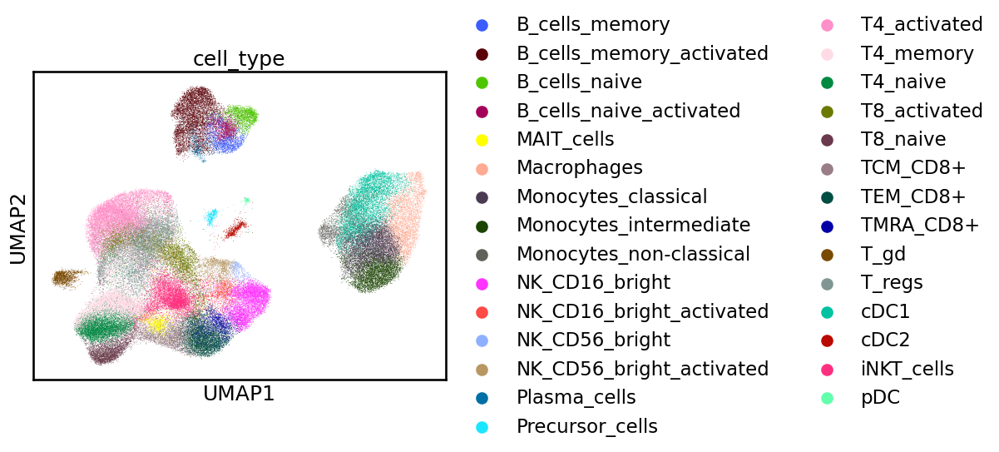

In [47]:
sc.pl.umap(cite, color=['cell_type'])

In [64]:
cite

AnnData object with n_obs × n_vars = 95064 × 2627
    obs: 'batch', 'bh_pval', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'cell_type', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'barcode', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status', 'GC_celltype_predictions_all_genes', 'probabilities_GC_all_genes', 'CVID_class_Freiburg', 'CVID_class_Euroclass'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'ge

In [82]:
keep_cell_types = ['Macrophages', 'Monocytes_classical','Monocytes_non-classical','Monocytes_intermediate']
cite = cite[cite.obs['cell_type'].isin(keep_cell_types)]
cite

IndexError: boolean row index has incorrect length: 95064 instead of 112463

In [75]:
adata_monocytes = cite[cite.obs['cell_type'].isin(['Macrophages', 'Monocytes_classical','Monocytes_non-classical','Monocytes_intermediate']) == True, :].copy()
adata_monocytes

IndexError: boolean row index has incorrect length: 95064 instead of 112463

# Spearman

In [48]:
angl_spear = sc.read_h5ad("/data/akalin/akollot/anglemania_benchmark/results/Hao_Satija_Cell_2021_PBMC/tcells/cd4/cd4_tcells_angl_spearman_t3_scvi.h5ad")
angl_spear

AnnData object with n_obs × n_vars = 41001 × 716
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'ident', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'log1p'
    obsm: 'PCA', 'SPCA', 'UMAP', 'WNN.UMAP', 'X_emb'
    layers: 'counts', 'logcounts'

In [49]:
sc.pp.neighbors(angl_spear,
                n_neighbors=n_neighbors,
                use_rep = 'X_emb')
sc.tl.umap(angl_spear,
           min_dist = min_dist,
           spread = spread)


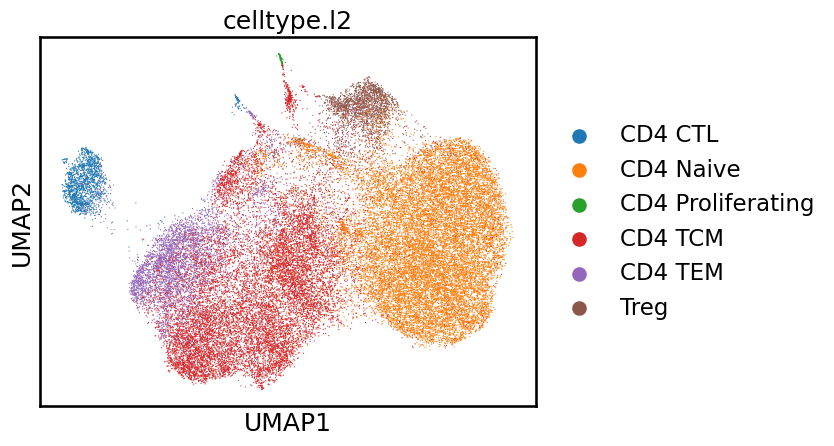

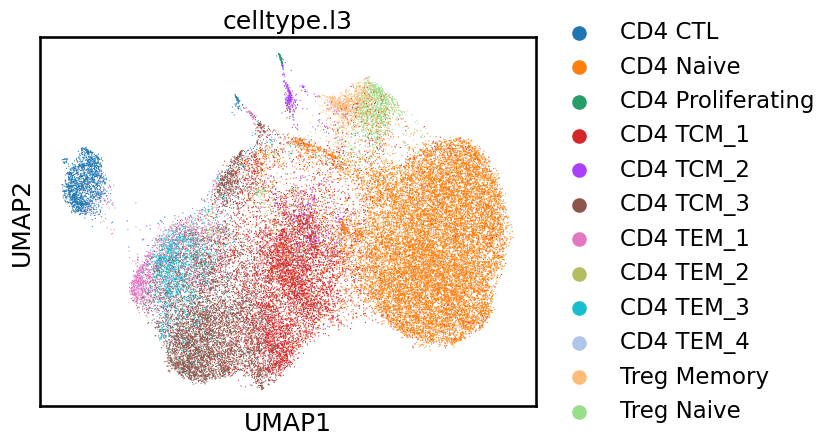

In [50]:
sc.pl.umap(angl_spear, color=['celltype.l2'])
sc.pl.umap(angl_spear, color=['celltype.l3'])